In [1]:
%matplotlib inline

In [2]:
import json 
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [3]:
corpus_files = ['publication_data/dblp-ref-0.json',
                'publication_data/dblp-ref-1.json',
                'publication_data/dblp-ref-2.json',
                'publication_data/dblp-ref-3.json']

In [4]:
def load_file(dblp_file):
    ids, texts, dates = [], [], []
    with open(dblp_file) as f:
        for line in f:
            line = json.loads(line)
            text = line.get('title', '') + '. ' + line.get('abstract', '')
            text = text.replace('- ', '')
            ids.append(line['id'])
            dates.append(line['year'])
            texts.append(text)
    return ids, texts, dates

In [5]:
def load_corpus(files):
    ids_corpus, text_corpus, dates_corpus = [], [], []
    for file in files:
        ids, corpus, dates = load_file(file)
        ids_corpus.extend(ids)
        text_corpus.extend(corpus)
        dates_corpus.extend(dates)
    return ids_corpus, text_corpus, dates_corpus

In [7]:
ids_corpus, text_corpus, dates_corpus = load_corpus(corpus_files)

In [8]:
# if there are other-language documents in the corpus, we should use no stop-word filter below
# min df so they form a propagating graph
# check binary=True should lead to different interpretation --> if only considered N, its 
# important to consider diversity more than specificity in vocabulary of a single document
vectorizer = CountVectorizer(analyzer='word', stop_words='english', lowercase=True, max_df=0.3, min_df=25, binary=True)
X = vectorizer.fit_transform(text_corpus)

In [9]:
def model_topics():
    try:
        X_multopic = np.load('X_multopic.npy')
    except:
        lda = LatentDirichletAllocation(n_components=100, doc_topic_prior=None, topic_word_prior=None, learning_method='batch',
                                        max_iter=10, n_jobs=2, verbose=1)
        X_multopic = lda.fit_transform(X)
        np.save('X_multopic.npy', X_multopic)
    return X_multopic

In [9]:
X_multopic = model_topics()

In [10]:
X_multopic = pd.DataFrame(X_multopic, index=ids_corpus)
X_multopic['year'] = dates_corpus

In [13]:
grps = X_multopic.groupby('year')
ys, cards = [], []
for year in set(dates_corpus):
    ys.append(year)
    cards.append(len(grps.get_group(year)))

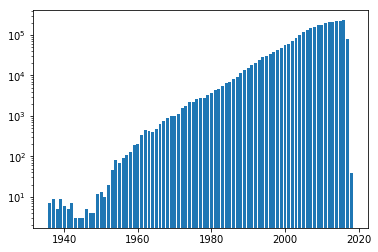

In [14]:
plt.bar(ys, cards)
plt.yscale('log')
plt.show();

In [22]:
def obtain_min_distances(X_topic, years, max_mem=36000000):
    res = {}
    for year in list(years)[1:]:
        cols = np.arange(0, 100)
        X_prev = X_topic[X_topic['year'] < year][cols]
        X_cur = X_topic[X_topic['year'] == year][cols]
        ix_stepsize = int(max_mem / len(X_cur))
        min_dist = pd.DataFrame(index=X_prev.index)
        print(year)
        for i in tqdm(range(0, len(X_prev), ix_stepsize)):
            X_prevsub = X_prev.iloc[i: i+ix_stepsize].values
            min_dist.iloc[i: i+ix_stepsize] = cdist(X_prevsub, X_cur.values, metric='cityblock').min(axis=1)
        res[year] = min_dist
    return res

In [25]:
res = obtain_min_distances(X_multopic, set(dates_corpus))
print('finished')

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1043.10it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1057.57it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 796.34it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 684.90it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1314.01it/s]

1937
1938
1939
1940
1941


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1311.54it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1445.81it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1462.45it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1531.89it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1125.38it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 610.44it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1190.55it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 649.17it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 614.46it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 633.77it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 1111.37it/s]

1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 159.00it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 226.96it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 746.98it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 529.12it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 49.63it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 49.05it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

1953
1954
1955
1956
1957
1958
1959


100%|██████████| 1/1 [00:00<00:00, 34.20it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 54.41it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 59.88it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 20.39it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

1960
1961
1962
1963


100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 24.05it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

1964
1965


100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

1966


100%|██████████| 1/1 [00:00<00:00,  3.98it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  8.28it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

1967
1968


100%|██████████| 1/1 [00:00<00:00,  4.18it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

1969


100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

1970


100%|██████████| 1/1 [00:00<00:00,  3.80it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

1971


100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

1972


100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

1973


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

1974


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

1975


100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

1976


 50%|█████     | 1/2 [00:01<00:01,  1.48s/it]

100%|██████████| 2/2 [00:01<00:00,  1.19it/s]


  0%|          | 0/2 [00:00<?, ?it/s]

1977


 50%|█████     | 1/2 [00:01<00:01,  1.50s/it]

100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

1978


 50%|█████     | 1/2 [00:01<00:01,  1.53s/it]

100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

  0%|          | 0/3 [00:00<?, ?it/s]

1979


 33%|███▎      | 1/3 [00:01<00:03,  1.52s/it]

 67%|██████▋   | 2/3 [00:03<00:01,  1.51s/it]

100%|██████████| 3/3 [00:03<00:00,  1.08s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

1980


 33%|███▎      | 1/3 [00:01<00:03,  1.50s/it]

 67%|██████▋   | 2/3 [00:02<00:01,  1.50s/it]

100%|██████████| 3/3 [00:04<00:00,  1.40s/it]

  0%|          | 0/4 [00:00<?, ?it/s]

1981


 25%|██▌       | 1/4 [00:01<00:04,  1.51s/it]

 50%|█████     | 2/4 [00:03<00:03,  1.51s/it]

 75%|███████▌  | 3/4 [00:04<00:01,  1.51s/it]

100%|██████████| 4/4 [00:05<00:00,  1.39s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

1982


 20%|██        | 1/5 [00:01<00:06,  1.51s/it]

 40%|████      | 2/5 [00:03<00:04,  1.50s/it]

 60%|██████    | 3/5 [00:04<00:02,  1.50s/it]

 80%|████████  | 4/5 [00:05<00:01,  1.49s/it]

100%|██████████| 5/5 [00:08<00:00,  1.71s/it]


  0%|          | 0/6 [00:00<?, ?it/s]

1983


 17%|█▋        | 1/6 [00:01<00:07,  1.54s/it]

 33%|███▎      | 2/6 [00:03<00:06,  1.54s/it]

 50%|█████     | 3/6 [00:04<00:04,  1.54s/it]

 67%|██████▋   | 4/6 [00:06<00:03,  1.54s/it]

 83%|████████▎ | 5/6 [00:07<00:01,  1.54s/it]

100%|██████████| 6/6 [00:09<00:00,  1.53s/it]


  0%|          | 0/9 [00:00<?, ?it/s]

1984


 11%|█         | 1/9 [00:01<00:13,  1.63s/it]

 22%|██▏       | 2/9 [00:03<00:11,  1.63s/it]

 33%|███▎      | 3/9 [00:04<00:09,  1.63s/it]

 44%|████▍     | 4/9 [00:06<00:08,  1.63s/it]

 56%|█████▌    | 5/9 [00:08<00:06,  1.63s/it]

 67%|██████▋   | 6/9 [00:09<00:04,  1.63s/it]

 78%|███████▊  | 7/9 [00:11<00:03,  1.63s/it]

 89%|████████▉ | 8/9 [00:13<00:01,  1.63s/it]

100%|██████████| 9/9 [00:13<00:00,  1.46s/it]


  0%|          | 0/11 [00:00<?, ?it/s]

1985


  9%|▉         | 1/11 [00:01<00:16,  1.62s/it]

 18%|█▊        | 2/11 [00:03<00:14,  1.62s/it]

 27%|██▋       | 3/11 [00:04<00:12,  1.62s/it]

 36%|███▋      | 4/11 [00:06<00:11,  1.62s/it]

 45%|████▌     | 5/11 [00:08<00:09,  1.61s/it]

 55%|█████▍    | 6/11 [00:09<00:08,  1.61s/it]

 64%|██████▎   | 7/11 [00:11<00:06,  1.61s/it]

 73%|███████▎  | 8/11 [00:12<00:04,  1.61s/it]

 82%|████████▏ | 9/11 [00:14<00:03,  1.61s/it]

 91%|█████████ | 10/11 [00:16<00:01,  1.61s/it]

100%|██████████| 11/11 [00:16<00:00,  1.48s/it]


  0%|          | 0/14 [00:00<?, ?it/s]

1986


  7%|▋         | 1/14 [00:01<00:24,  1.86s/it]

 14%|█▍        | 2/14 [00:03<00:22,  1.85s/it]

 21%|██▏       | 3/14 [00:05<00:20,  1.84s/it]

 29%|██▊       | 4/14 [00:07<00:18,  1.84s/it]

 36%|███▌      | 5/14 [00:09<00:16,  1.84s/it]

 43%|████▎     | 6/14 [00:11<00:14,  1.84s/it]

 50%|█████     | 7/14 [00:12<00:12,  1.83s/it]

 57%|█████▋    | 8/14 [00:14<00:11,  1.83s/it]

 64%|██████▍   | 9/14 [00:16<00:09,  1.84s/it]

 71%|███████▏  | 10/14 [00:18<00:07,  1.84s/it]

 79%|███████▊  | 11/14 [00:20<00:05,  1.84s/it]

 86%|████████▌ | 12/14 [00:22<00:03,  1.85s/it]

 93%|█████████▎| 13/14 [00:24<00:01,  1.85s/it]

100%|██████████| 14/14 [00:24<00:00,  1.78s/it]

  0%|          | 0/18 [00:00<?, ?it/s]

1987


  6%|▌         | 1/18 [00:01<00:32,  1.90s/it]

 11%|█         | 2/18 [00:03<00:30,  1.88s/it]

 17%|█▋        | 3/18 [00:05<00:28,  1.88s/it]

 22%|██▏       | 4/18 [00:07<00:26,  1.88s/it]

 28%|██▊       | 5/18 [00:09<00:24,  1.88s/it]

 33%|███▎      | 6/18 [00:11<00:22,  1.88s/it]

 39%|███▉      | 7/18 [00:13<00:20,  1.88s/it]

 44%|████▍     | 8/18 [00:15<00:18,  1.88s/it]

 50%|█████     | 9/18 [00:16<00:16,  1.88s/it]

 56%|█████▌    | 10/18 [00:18<00:15,  1.88s/it]

 61%|██████    | 11/18 [00:20<00:13,  1.89s/it]

 67%|██████▋   | 12/18 [00:22<00:11,  1.89s/it]

 72%|███████▏  | 13/18 [00:24<00:09,  1.89s/it]

 78%|███████▊  | 14/18 [00:26<00:07,  1.90s/it]

 83%|████████▎ | 15/18 [00:28<00:05,  1.90s/it]

 89%|████████▉ | 16/18 [00:30<00:03,  1.90s/it]

 94%|█████████▍| 17/18 [00:32<00:01,  1.90s/it]

100%|██████████| 18/18 [00:33<00:00,  1.83s/it]


  0%|          | 0/25 [00:00<?, ?it/s]

1988


  4%|▍         | 1/25 [00:02<00:53,  2.24s/it]

  8%|▊         | 2/25 [00:04<00:51,  2.24s/it]

 12%|█▏        | 3/25 [00:06<00:49,  2.24s/it]

 16%|█▌        | 4/25 [00:08<00:47,  2.25s/it]

 20%|██        | 5/25 [00:11<00:44,  2.25s/it]

 24%|██▍       | 6/25 [00:13<00:42,  2.24s/it]

 28%|██▊       | 7/25 [00:15<00:40,  2.23s/it]

 32%|███▏      | 8/25 [00:17<00:37,  2.23s/it]

 36%|███▌      | 9/25 [00:20<00:35,  2.23s/it]

 40%|████      | 10/25 [00:22<00:33,  2.23s/it]

 44%|████▍     | 11/25 [00:24<00:31,  2.23s/it]

 48%|████▊     | 12/25 [00:26<00:29,  2.23s/it]

 52%|█████▏    | 13/25 [00:29<00:26,  2.24s/it]

 56%|█████▌    | 14/25 [00:31<00:24,  2.24s/it]

 60%|██████    | 15/25 [00:33<00:22,  2.24s/it]

 64%|██████▍   | 16/25 [00:35<00:20,  2.24s/it]

 68%|██████▊   | 17/25 [00:38<00:17,  2.24s/it]

 72%|███████▏  | 18/25 [00:40<00:15,  2.23s/it]

 76%|███████▌  | 19/25 [00:42<00:13,  2.23s/it]

 80%|████████  | 20/25 [00:44<00:11,  2.23s/it]

 84%|████████▍ | 21/25 [00:46<00:08,  2.23s/it]

 88%|████████▊ | 22/25 [00:49<00:06,  2.23s/it]

 92%|█████████▏| 23/25 [00:51<00:04,  2.23s/it]

 96%|█████████▌| 24/25 [00:53<00:02,  2.23s/it]

100%|██████████| 25/25 [00:53<00:00,  2.15s/it]


  0%|          | 0/33 [00:00<?, ?it/s]

1989


  3%|▎         | 1/33 [00:02<01:14,  2.32s/it]

  6%|▌         | 2/33 [00:04<01:11,  2.32s/it]

  9%|▉         | 3/33 [00:06<01:09,  2.32s/it]

 12%|█▏        | 4/33 [00:09<01:07,  2.32s/it]

 15%|█▌        | 5/33 [00:11<01:04,  2.32s/it]

 18%|█▊        | 6/33 [00:13<01:02,  2.32s/it]

 21%|██        | 7/33 [00:16<01:00,  2.32s/it]

 24%|██▍       | 8/33 [00:18<00:57,  2.32s/it]

 27%|██▋       | 9/33 [00:20<00:55,  2.32s/it]

 30%|███       | 10/33 [00:23<00:53,  2.32s/it]

 33%|███▎      | 11/33 [00:25<00:50,  2.32s/it]

 36%|███▋      | 12/33 [00:27<00:48,  2.32s/it]

 39%|███▉      | 13/33 [00:30<00:46,  2.32s/it]

 42%|████▏     | 14/33 [00:32<00:44,  2.33s/it]

 45%|████▌     | 15/33 [00:34<00:41,  2.33s/it]

 48%|████▊     | 16/33 [00:37<00:39,  2.33s/it]

 52%|█████▏    | 17/33 [00:39<00:37,  2.33s/it]

 55%|█████▍    | 18/33 [00:42<00:35,  2.33s/it]

 58%|█████▊    | 19/33 [00:44<00:32,  2.33s/it]

 61%|██████    | 20/33 [00:46<00:30,  2.34s/it]

 64%|██████▎   | 21/33 [00:49<00:28,  2.34s/it]

 67%|██████▋   | 22/33 [00:51<00:25,  2.34s/it]

 70%|██████▉   | 23/33 [00:53<00:23,  2.34s/it]

 73%|███████▎  | 24/33 [00:56<00:21,  2.34s/it]

 76%|███████▌  | 25/33 [00:58<00:18,  2.35s/it]

 79%|███████▉  | 26/33 [01:00<00:16,  2.35s/it]

 82%|████████▏ | 27/33 [01:03<00:14,  2.34s/it]

 85%|████████▍ | 28/33 [01:05<00:11,  2.34s/it]

 88%|████████▊ | 29/33 [01:07<00:09,  2.34s/it]

 91%|█████████ | 30/33 [01:10<00:07,  2.34s/it]

 94%|█████████▍| 31/33 [01:12<00:04,  2.34s/it]

 97%|█████████▋| 32/33 [01:14<00:02,  2.34s/it]

100%|██████████| 33/33 [01:16<00:00,  2.30s/it]

  0%|          | 0/43 [00:00<?, ?it/s]

1990


  2%|▏         | 1/43 [00:02<01:41,  2.41s/it]

  5%|▍         | 2/43 [00:04<01:38,  2.40s/it]

  7%|▋         | 3/43 [00:07<01:36,  2.40s/it]

  9%|▉         | 4/43 [00:09<01:33,  2.40s/it]

 12%|█▏        | 5/43 [00:11<01:31,  2.40s/it]

 14%|█▍        | 6/43 [00:14<01:28,  2.40s/it]

 16%|█▋        | 7/43 [00:16<01:26,  2.40s/it]

 19%|█▊        | 8/43 [00:19<01:23,  2.40s/it]

 21%|██        | 9/43 [00:21<01:21,  2.40s/it]

 23%|██▎       | 10/43 [00:23<01:19,  2.40s/it]

 26%|██▌       | 11/43 [00:26<01:16,  2.40s/it]

 28%|██▊       | 12/43 [00:28<01:14,  2.40s/it]

 30%|███       | 13/43 [00:31<01:12,  2.40s/it]

 33%|███▎      | 14/43 [00:33<01:09,  2.40s/it]

 35%|███▍      | 15/43 [00:36<01:07,  2.41s/it]

 37%|███▋      | 16/43 [00:38<01:05,  2.41s/it]

 40%|███▉      | 17/43 [00:40<01:02,  2.41s/it]

 42%|████▏     | 18/43 [00:43<01:00,  2.41s/it]

 44%|████▍     | 19/43 [00:45<00:57,  2.41s/it]

 47%|████▋     | 20/43 [00:48<00:55,  2.41s/it]

 49%|████▉     | 21/43 [00:50<00:53,  2.41s/it]

 51%|█████     | 22/43 [00:53<00:50,  2.41s/it]

 53%|█████▎    | 23/43 [00:55<00:48,  2.41s/it]

 56%|█████▌    | 24/43 [00:57<00:45,  2.41s/it]

 58%|█████▊    | 25/43 [01:00<00:43,  2.41s/it]

 60%|██████    | 26/43 [01:02<00:41,  2.41s/it]

 63%|██████▎   | 27/43 [01:05<00:38,  2.41s/it]

 65%|██████▌   | 28/43 [01:07<00:36,  2.41s/it]

 67%|██████▋   | 29/43 [01:10<00:33,  2.41s/it]

 70%|██████▉   | 30/43 [01:12<00:31,  2.41s/it]

 72%|███████▏  | 31/43 [01:14<00:28,  2.41s/it]

 74%|███████▍  | 32/43 [01:17<00:26,  2.41s/it]

 77%|███████▋  | 33/43 [01:19<00:24,  2.41s/it]

 79%|███████▉  | 34/43 [01:22<00:21,  2.41s/it]

 81%|████████▏ | 35/43 [01:24<00:19,  2.41s/it]

 84%|████████▎ | 36/43 [01:26<00:16,  2.41s/it]

 86%|████████▌ | 37/43 [01:29<00:14,  2.41s/it]

 88%|████████▊ | 38/43 [01:31<00:12,  2.41s/it]

 91%|█████████ | 39/43 [01:34<00:09,  2.41s/it]

 93%|█████████▎| 40/43 [01:36<00:07,  2.42s/it]

 95%|█████████▌| 41/43 [01:39<00:04,  2.42s/it]

 98%|█████████▊| 42/43 [01:41<00:02,  2.42s/it]

100%|██████████| 43/43 [01:42<00:00,  2.38s/it]


  0%|          | 0/59 [00:00<?, ?it/s]

1991


  2%|▏         | 1/59 [00:02<02:22,  2.46s/it]

  3%|▎         | 2/59 [00:04<02:19,  2.45s/it]

  5%|▌         | 3/59 [00:07<02:17,  2.45s/it]

  7%|▋         | 4/59 [00:09<02:14,  2.45s/it]

  8%|▊         | 5/59 [00:12<02:12,  2.44s/it]

 10%|█         | 6/59 [00:14<02:09,  2.44s/it]

 12%|█▏        | 7/59 [00:17<02:06,  2.44s/it]

 14%|█▎        | 8/59 [00:19<02:04,  2.44s/it]

 15%|█▌        | 9/59 [00:21<02:01,  2.44s/it]

 17%|█▋        | 10/59 [00:24<01:59,  2.43s/it]

 19%|█▊        | 11/59 [00:26<01:56,  2.43s/it]

 20%|██        | 12/59 [00:29<01:54,  2.43s/it]

 22%|██▏       | 13/59 [00:31<01:51,  2.43s/it]

 24%|██▎       | 14/59 [00:34<01:49,  2.43s/it]

 25%|██▌       | 15/59 [00:36<01:47,  2.43s/it]

 27%|██▋       | 16/59 [00:38<01:44,  2.43s/it]

 29%|██▉       | 17/59 [00:41<01:42,  2.44s/it]

 31%|███       | 18/59 [00:43<01:39,  2.44s/it]

 32%|███▏      | 19/59 [00:46<01:37,  2.44s/it]

 34%|███▍      | 20/59 [00:48<01:35,  2.44s/it]

 36%|███▌      | 21/59 [00:51<01:32,  2.44s/it]

 37%|███▋      | 22/59 [00:53<01:30,  2.44s/it]

 39%|███▉      | 23/59 [00:56<01:27,  2.44s/it]

 41%|████      | 24/59 [00:58<01:25,  2.44s/it]

 42%|████▏     | 25/59 [01:00<01:22,  2.44s/it]

 44%|████▍     | 26/59 [01:03<01:20,  2.44s/it]

 46%|████▌     | 27/59 [01:05<01:18,  2.44s/it]

 47%|████▋     | 28/59 [01:08<01:15,  2.44s/it]

 49%|████▉     | 29/59 [01:10<01:13,  2.44s/it]

 51%|█████     | 30/59 [01:13<01:10,  2.44s/it]

 53%|█████▎    | 31/59 [01:15<01:08,  2.44s/it]

 54%|█████▍    | 32/59 [01:18<01:05,  2.44s/it]

 56%|█████▌    | 33/59 [01:20<01:03,  2.44s/it]

 58%|█████▊    | 34/59 [01:22<01:01,  2.44s/it]

 59%|█████▉    | 35/59 [01:25<00:58,  2.44s/it]

 61%|██████    | 36/59 [01:27<00:56,  2.44s/it]

 63%|██████▎   | 37/59 [01:30<00:53,  2.44s/it]

 64%|██████▍   | 38/59 [01:32<00:51,  2.45s/it]

 66%|██████▌   | 39/59 [01:35<00:48,  2.45s/it]

 68%|██████▊   | 40/59 [01:37<00:46,  2.45s/it]

 69%|██████▉   | 41/59 [01:40<00:44,  2.45s/it]

 71%|███████   | 42/59 [01:42<00:41,  2.45s/it]

 73%|███████▎  | 43/59 [01:45<00:39,  2.45s/it]

 75%|███████▍  | 44/59 [01:47<00:36,  2.45s/it]

 76%|███████▋  | 45/59 [01:50<00:34,  2.45s/it]

 78%|███████▊  | 46/59 [01:52<00:31,  2.45s/it]

 80%|███████▉  | 47/59 [01:55<00:29,  2.45s/it]

 81%|████████▏ | 48/59 [01:57<00:27,  2.46s/it]

 83%|████████▎ | 49/59 [02:00<00:24,  2.46s/it]

 85%|████████▍ | 50/59 [02:02<00:22,  2.46s/it]

 86%|████████▋ | 51/59 [02:05<00:19,  2.46s/it]

 88%|████████▊ | 52/59 [02:07<00:17,  2.46s/it]

 90%|████████▉ | 53/59 [02:10<00:14,  2.46s/it]

 92%|█████████▏| 54/59 [02:12<00:12,  2.46s/it]

 93%|█████████▎| 55/59 [02:15<00:09,  2.46s/it]

 95%|█████████▍| 56/59 [02:17<00:07,  2.46s/it]

 97%|█████████▋| 57/59 [02:20<00:04,  2.46s/it]

 98%|█████████▊| 58/59 [02:22<00:02,  2.46s/it]

100%|██████████| 59/59 [02:24<00:00,  2.45s/it]


  0%|          | 0/77 [00:00<?, ?it/s]

1992


  1%|▏         | 1/77 [00:02<03:09,  2.49s/it]

  3%|▎         | 2/77 [00:04<03:06,  2.49s/it]

  4%|▍         | 3/77 [00:07<03:04,  2.49s/it]

  5%|▌         | 4/77 [00:09<03:01,  2.49s/it]

  6%|▋         | 5/77 [00:12<02:59,  2.49s/it]

  8%|▊         | 6/77 [00:14<02:56,  2.49s/it]

  9%|▉         | 7/77 [00:17<02:54,  2.49s/it]

 10%|█         | 8/77 [00:19<02:51,  2.49s/it]

 12%|█▏        | 9/77 [00:22<02:49,  2.49s/it]

 13%|█▎        | 10/77 [00:24<02:46,  2.49s/it]

 14%|█▍        | 11/77 [00:27<02:44,  2.49s/it]

 16%|█▌        | 12/77 [00:29<02:41,  2.49s/it]

 17%|█▋        | 13/77 [00:32<02:39,  2.49s/it]

 18%|█▊        | 14/77 [00:34<02:36,  2.49s/it]

 19%|█▉        | 15/77 [00:37<02:34,  2.49s/it]

 21%|██        | 16/77 [00:39<02:31,  2.49s/it]

 22%|██▏       | 17/77 [00:42<02:29,  2.49s/it]

 23%|██▎       | 18/77 [00:44<02:26,  2.49s/it]

 25%|██▍       | 19/77 [00:47<02:24,  2.49s/it]

 26%|██▌       | 20/77 [00:49<02:21,  2.49s/it]

 27%|██▋       | 21/77 [00:52<02:19,  2.49s/it]

 29%|██▊       | 22/77 [00:54<02:16,  2.49s/it]

 30%|██▉       | 23/77 [00:57<02:14,  2.49s/it]

 31%|███       | 24/77 [00:59<02:11,  2.49s/it]

 32%|███▏      | 25/77 [01:02<02:09,  2.49s/it]

 34%|███▍      | 26/77 [01:04<02:07,  2.49s/it]

 35%|███▌      | 27/77 [01:07<02:04,  2.49s/it]

 36%|███▋      | 28/77 [01:09<02:02,  2.49s/it]

 38%|███▊      | 29/77 [01:12<01:59,  2.49s/it]

 39%|███▉      | 30/77 [01:14<01:57,  2.49s/it]

 40%|████      | 31/77 [01:17<01:54,  2.49s/it]

 42%|████▏     | 32/77 [01:19<01:52,  2.49s/it]

 43%|████▎     | 33/77 [01:22<01:49,  2.49s/it]

 44%|████▍     | 34/77 [01:24<01:47,  2.49s/it]

 45%|████▌     | 35/77 [01:27<01:44,  2.49s/it]

 47%|████▋     | 36/77 [01:29<01:42,  2.49s/it]

 48%|████▊     | 37/77 [01:32<01:39,  2.49s/it]

 49%|████▉     | 38/77 [01:34<01:37,  2.49s/it]

 51%|█████     | 39/77 [01:37<01:34,  2.49s/it]

 52%|█████▏    | 40/77 [01:39<01:32,  2.49s/it]

 53%|█████▎    | 41/77 [01:42<01:29,  2.49s/it]

 55%|█████▍    | 42/77 [01:44<01:27,  2.49s/it]

 56%|█████▌    | 43/77 [01:47<01:24,  2.49s/it]

 57%|█████▋    | 44/77 [01:49<01:22,  2.50s/it]

 58%|█████▊    | 45/77 [01:52<01:19,  2.50s/it]

 60%|█████▉    | 46/77 [01:54<01:17,  2.50s/it]

 61%|██████    | 47/77 [01:57<01:14,  2.50s/it]

 62%|██████▏   | 48/77 [01:59<01:12,  2.50s/it]

 64%|██████▎   | 49/77 [02:02<01:10,  2.50s/it]

 65%|██████▍   | 50/77 [02:05<01:07,  2.50s/it]

 66%|██████▌   | 51/77 [02:07<01:05,  2.50s/it]

 68%|██████▊   | 52/77 [02:10<01:02,  2.50s/it]

 69%|██████▉   | 53/77 [02:12<01:00,  2.50s/it]

 70%|███████   | 54/77 [02:15<00:57,  2.50s/it]

 71%|███████▏  | 55/77 [02:17<00:55,  2.50s/it]

 73%|███████▎  | 56/77 [02:20<00:52,  2.51s/it]

 74%|███████▍  | 57/77 [02:22<00:50,  2.51s/it]

 75%|███████▌  | 58/77 [02:25<00:47,  2.51s/it]

 77%|███████▋  | 59/77 [02:27<00:45,  2.51s/it]

 78%|███████▊  | 60/77 [02:30<00:42,  2.50s/it]

 79%|███████▉  | 61/77 [02:32<00:40,  2.50s/it]

 81%|████████  | 62/77 [02:35<00:37,  2.50s/it]

 82%|████████▏ | 63/77 [02:37<00:35,  2.50s/it]

 83%|████████▎ | 64/77 [02:40<00:32,  2.50s/it]

 84%|████████▍ | 65/77 [02:42<00:30,  2.50s/it]

 86%|████████▌ | 66/77 [02:45<00:27,  2.50s/it]

 87%|████████▋ | 67/77 [02:47<00:25,  2.50s/it]

 88%|████████▊ | 68/77 [02:50<00:22,  2.50s/it]

 90%|████████▉ | 69/77 [02:52<00:20,  2.50s/it]

 91%|█████████ | 70/77 [02:55<00:17,  2.50s/it]

 92%|█████████▏| 71/77 [02:57<00:15,  2.50s/it]

 94%|█████████▎| 72/77 [03:00<00:12,  2.50s/it]

 95%|█████████▍| 73/77 [03:02<00:10,  2.50s/it]

 96%|█████████▌| 74/77 [03:05<00:07,  2.50s/it]

 97%|█████████▋| 75/77 [03:07<00:05,  2.50s/it]

 99%|█████████▊| 76/77 [03:10<00:02,  2.50s/it]

100%|██████████| 77/77 [03:10<00:00,  2.47s/it]

  0%|          | 0/107 [00:00<?, ?it/s]

1993


  1%|          | 1/107 [00:02<04:24,  2.49s/it]

  2%|▏         | 2/107 [00:04<04:21,  2.49s/it]

  3%|▎         | 3/107 [00:07<04:18,  2.48s/it]

  4%|▎         | 4/107 [00:09<04:15,  2.48s/it]

  5%|▍         | 5/107 [00:12<04:13,  2.48s/it]

  6%|▌         | 6/107 [00:14<04:10,  2.48s/it]

  7%|▋         | 7/107 [00:17<04:07,  2.48s/it]

  7%|▋         | 8/107 [00:19<04:05,  2.48s/it]

  8%|▊         | 9/107 [00:22<04:02,  2.48s/it]

  9%|▉         | 10/107 [00:24<04:00,  2.48s/it]

 10%|█         | 11/107 [00:27<03:57,  2.48s/it]

 11%|█         | 12/107 [00:29<03:55,  2.48s/it]

 12%|█▏        | 13/107 [00:32<03:53,  2.48s/it]

 13%|█▎        | 14/107 [00:34<03:50,  2.48s/it]

 14%|█▍        | 15/107 [00:37<03:48,  2.48s/it]

 15%|█▍        | 16/107 [00:39<03:45,  2.48s/it]

 16%|█▌        | 17/107 [00:42<03:43,  2.48s/it]

 17%|█▋        | 18/107 [00:44<03:41,  2.49s/it]

 18%|█▊        | 19/107 [00:47<03:38,  2.49s/it]

 19%|█▊        | 20/107 [00:49<03:36,  2.49s/it]

 20%|█▉        | 21/107 [00:52<03:34,  2.49s/it]

 21%|██        | 22/107 [00:54<03:31,  2.49s/it]

 21%|██▏       | 23/107 [00:57<03:29,  2.50s/it]

 22%|██▏       | 24/107 [00:59<03:27,  2.50s/it]

 23%|██▎       | 25/107 [01:02<03:24,  2.50s/it]

 24%|██▍       | 26/107 [01:04<03:22,  2.50s/it]

 25%|██▌       | 27/107 [01:07<03:20,  2.50s/it]

 26%|██▌       | 28/107 [01:10<03:17,  2.50s/it]

 27%|██▋       | 29/107 [01:12<03:15,  2.50s/it]

 28%|██▊       | 30/107 [01:15<03:12,  2.50s/it]

 29%|██▉       | 31/107 [01:17<03:10,  2.50s/it]

 30%|██▉       | 32/107 [01:20<03:07,  2.50s/it]

 31%|███       | 33/107 [01:22<03:05,  2.51s/it]

 32%|███▏      | 34/107 [01:25<03:02,  2.51s/it]

 33%|███▎      | 35/107 [01:27<03:00,  2.51s/it]

 34%|███▎      | 36/107 [01:30<02:57,  2.51s/it]

 35%|███▍      | 37/107 [01:32<02:55,  2.51s/it]

 36%|███▌      | 38/107 [01:35<02:53,  2.51s/it]

 36%|███▋      | 39/107 [01:37<02:50,  2.51s/it]

 37%|███▋      | 40/107 [01:40<02:48,  2.51s/it]

 38%|███▊      | 41/107 [01:42<02:45,  2.51s/it]

 39%|███▉      | 42/107 [01:45<02:43,  2.51s/it]

 40%|████      | 43/107 [01:47<02:40,  2.51s/it]

 41%|████      | 44/107 [01:50<02:38,  2.51s/it]

 42%|████▏     | 45/107 [01:53<02:35,  2.51s/it]

 43%|████▎     | 46/107 [01:55<02:33,  2.51s/it]

 44%|████▍     | 47/107 [01:58<02:30,  2.51s/it]

 45%|████▍     | 48/107 [02:00<02:28,  2.51s/it]

 46%|████▌     | 49/107 [02:03<02:25,  2.51s/it]

 47%|████▋     | 50/107 [02:05<02:23,  2.51s/it]

 48%|████▊     | 51/107 [02:08<02:20,  2.51s/it]

 49%|████▊     | 52/107 [02:10<02:18,  2.51s/it]

 50%|████▉     | 53/107 [02:13<02:15,  2.51s/it]

 50%|█████     | 54/107 [02:15<02:13,  2.51s/it]

 51%|█████▏    | 55/107 [02:18<02:10,  2.51s/it]

 52%|█████▏    | 56/107 [02:20<02:08,  2.51s/it]

 53%|█████▎    | 57/107 [02:23<02:05,  2.51s/it]

 54%|█████▍    | 58/107 [02:25<02:03,  2.51s/it]

 55%|█████▌    | 59/107 [02:28<02:00,  2.51s/it]

 56%|█████▌    | 60/107 [02:30<01:58,  2.51s/it]

 57%|█████▋    | 61/107 [02:33<01:55,  2.51s/it]

 58%|█████▊    | 62/107 [02:35<01:53,  2.51s/it]

 59%|█████▉    | 63/107 [02:38<01:50,  2.51s/it]

 60%|█████▉    | 64/107 [02:40<01:47,  2.51s/it]

 61%|██████    | 65/107 [02:43<01:45,  2.51s/it]

 62%|██████▏   | 66/107 [02:45<01:42,  2.51s/it]

 63%|██████▎   | 67/107 [02:48<01:40,  2.51s/it]

 64%|██████▎   | 68/107 [02:50<01:37,  2.51s/it]

 64%|██████▍   | 69/107 [02:53<01:35,  2.51s/it]

 65%|██████▌   | 70/107 [02:55<01:32,  2.51s/it]

 66%|██████▋   | 71/107 [02:58<01:30,  2.51s/it]

 67%|██████▋   | 72/107 [03:00<01:27,  2.51s/it]

 68%|██████▊   | 73/107 [03:03<01:25,  2.51s/it]

 69%|██████▉   | 74/107 [03:05<01:22,  2.51s/it]

 70%|███████   | 75/107 [03:08<01:20,  2.51s/it]

 71%|███████   | 76/107 [03:10<01:17,  2.51s/it]

 72%|███████▏  | 77/107 [03:13<01:15,  2.51s/it]

 73%|███████▎  | 78/107 [03:15<01:12,  2.51s/it]

 74%|███████▍  | 79/107 [03:18<01:10,  2.51s/it]

 75%|███████▍  | 80/107 [03:20<01:07,  2.51s/it]

 76%|███████▌  | 81/107 [03:23<01:05,  2.51s/it]

 77%|███████▋  | 82/107 [03:25<01:02,  2.51s/it]

 78%|███████▊  | 83/107 [03:28<01:00,  2.51s/it]

 79%|███████▊  | 84/107 [03:30<00:57,  2.51s/it]

 79%|███████▉  | 85/107 [03:33<00:55,  2.51s/it]

 80%|████████  | 86/107 [03:35<00:52,  2.51s/it]

 81%|████████▏ | 87/107 [03:38<00:50,  2.51s/it]

 82%|████████▏ | 88/107 [03:40<00:47,  2.51s/it]

 83%|████████▎ | 89/107 [03:43<00:45,  2.51s/it]

 84%|████████▍ | 90/107 [03:45<00:42,  2.51s/it]

 85%|████████▌ | 91/107 [03:48<00:40,  2.51s/it]

 86%|████████▌ | 92/107 [03:50<00:37,  2.51s/it]

 87%|████████▋ | 93/107 [03:53<00:35,  2.51s/it]

 88%|████████▊ | 94/107 [03:55<00:32,  2.51s/it]

 89%|████████▉ | 95/107 [03:58<00:30,  2.51s/it]

 90%|████████▉ | 96/107 [04:00<00:27,  2.51s/it]

 91%|█████████ | 97/107 [04:03<00:25,  2.51s/it]

 92%|█████████▏| 98/107 [04:05<00:22,  2.51s/it]

 93%|█████████▎| 99/107 [04:08<00:20,  2.51s/it]

 93%|█████████▎| 100/107 [04:10<00:17,  2.51s/it]

 94%|█████████▍| 101/107 [04:13<00:15,  2.51s/it]

 95%|█████████▌| 102/107 [04:15<00:12,  2.51s/it]

 96%|█████████▋| 103/107 [04:18<00:10,  2.51s/it]

 97%|█████████▋| 104/107 [04:20<00:07,  2.51s/it]

 98%|█████████▊| 105/107 [04:23<00:05,  2.51s/it]

 99%|█████████▉| 106/107 [04:25<00:02,  2.51s/it]

100%|██████████| 107/107 [04:25<00:00,  2.49s/it]


  0%|          | 0/144 [00:00<?, ?it/s]

1994


  1%|          | 1/144 [00:02<06:00,  2.52s/it]

  1%|▏         | 2/144 [00:05<05:56,  2.51s/it]

  2%|▏         | 3/144 [00:07<05:54,  2.51s/it]

  3%|▎         | 4/144 [00:10<05:52,  2.52s/it]

  3%|▎         | 5/144 [00:12<05:49,  2.52s/it]

  4%|▍         | 6/144 [00:15<05:47,  2.52s/it]

  5%|▍         | 7/144 [00:17<05:45,  2.52s/it]

  6%|▌         | 8/144 [00:20<05:42,  2.52s/it]

  6%|▋         | 9/144 [00:22<05:40,  2.52s/it]

  7%|▋         | 10/144 [00:25<05:37,  2.52s/it]

  8%|▊         | 11/144 [00:27<05:34,  2.52s/it]

  8%|▊         | 12/144 [00:30<05:32,  2.52s/it]

  9%|▉         | 13/144 [00:32<05:29,  2.52s/it]

 10%|▉         | 14/144 [00:35<05:26,  2.51s/it]

 10%|█         | 15/144 [00:37<05:24,  2.51s/it]

 11%|█         | 16/144 [00:40<05:21,  2.51s/it]

 12%|█▏        | 17/144 [00:42<05:19,  2.51s/it]

 12%|█▎        | 18/144 [00:45<05:16,  2.51s/it]

 13%|█▎        | 19/144 [00:47<05:13,  2.51s/it]

 14%|█▍        | 20/144 [00:50<05:11,  2.51s/it]

 15%|█▍        | 21/144 [00:52<05:08,  2.51s/it]

 15%|█▌        | 22/144 [00:55<05:06,  2.51s/it]

 16%|█▌        | 23/144 [00:57<05:03,  2.51s/it]

 17%|█▋        | 24/144 [01:00<05:01,  2.51s/it]

 17%|█▋        | 25/144 [01:02<04:58,  2.51s/it]

 18%|█▊        | 26/144 [01:05<04:56,  2.51s/it]

 19%|█▉        | 27/144 [01:07<04:53,  2.51s/it]

 19%|█▉        | 28/144 [01:10<04:51,  2.51s/it]

 20%|██        | 29/144 [01:12<04:48,  2.51s/it]

 21%|██        | 30/144 [01:15<04:46,  2.51s/it]

 22%|██▏       | 31/144 [01:17<04:44,  2.51s/it]

 22%|██▏       | 32/144 [01:20<04:41,  2.51s/it]

 23%|██▎       | 33/144 [01:22<04:39,  2.51s/it]

 24%|██▎       | 34/144 [01:25<04:36,  2.51s/it]

 24%|██▍       | 35/144 [01:27<04:34,  2.51s/it]

 25%|██▌       | 36/144 [01:30<04:31,  2.51s/it]

 26%|██▌       | 37/144 [01:33<04:29,  2.51s/it]

 26%|██▋       | 38/144 [01:35<04:26,  2.51s/it]

 27%|██▋       | 39/144 [01:38<04:24,  2.52s/it]

 28%|██▊       | 40/144 [01:40<04:21,  2.52s/it]

 28%|██▊       | 41/144 [01:43<04:19,  2.52s/it]

 29%|██▉       | 42/144 [01:45<04:16,  2.52s/it]

 30%|██▉       | 43/144 [01:48<04:14,  2.52s/it]

 31%|███       | 44/144 [01:50<04:11,  2.52s/it]

 31%|███▏      | 45/144 [01:53<04:09,  2.52s/it]

 32%|███▏      | 46/144 [01:55<04:06,  2.52s/it]

 33%|███▎      | 47/144 [01:58<04:04,  2.52s/it]

 33%|███▎      | 48/144 [02:00<04:01,  2.52s/it]

 34%|███▍      | 49/144 [02:03<03:59,  2.52s/it]

 35%|███▍      | 50/144 [02:05<03:56,  2.52s/it]

 35%|███▌      | 51/144 [02:08<03:54,  2.52s/it]

 36%|███▌      | 52/144 [02:10<03:51,  2.52s/it]

 37%|███▋      | 53/144 [02:13<03:49,  2.52s/it]

 38%|███▊      | 54/144 [02:16<03:46,  2.52s/it]

 38%|███▊      | 55/144 [02:18<03:44,  2.52s/it]

 39%|███▉      | 56/144 [02:21<03:41,  2.52s/it]

 40%|███▉      | 57/144 [02:23<03:39,  2.52s/it]

 40%|████      | 58/144 [02:26<03:37,  2.52s/it]

 41%|████      | 59/144 [02:28<03:34,  2.52s/it]

 42%|████▏     | 60/144 [02:31<03:32,  2.53s/it]

 42%|████▏     | 61/144 [02:34<03:29,  2.52s/it]

 43%|████▎     | 62/144 [02:36<03:27,  2.52s/it]

 44%|████▍     | 63/144 [02:39<03:24,  2.52s/it]

 44%|████▍     | 64/144 [02:41<03:21,  2.52s/it]

 45%|████▌     | 65/144 [02:44<03:19,  2.52s/it]

 46%|████▌     | 66/144 [02:46<03:16,  2.52s/it]

 47%|████▋     | 67/144 [02:49<03:14,  2.52s/it]

 47%|████▋     | 68/144 [02:51<03:11,  2.52s/it]

 48%|████▊     | 69/144 [02:54<03:09,  2.52s/it]

 49%|████▊     | 70/144 [02:56<03:06,  2.52s/it]

 49%|████▉     | 71/144 [02:59<03:04,  2.52s/it]

 50%|█████     | 72/144 [03:01<03:01,  2.52s/it]

 51%|█████     | 73/144 [03:04<02:59,  2.52s/it]

 51%|█████▏    | 74/144 [03:06<02:56,  2.52s/it]

 52%|█████▏    | 75/144 [03:09<02:54,  2.53s/it]

 53%|█████▎    | 76/144 [03:11<02:51,  2.52s/it]

 53%|█████▎    | 77/144 [03:14<02:49,  2.52s/it]

 54%|█████▍    | 78/144 [03:16<02:46,  2.52s/it]

 55%|█████▍    | 79/144 [03:19<02:44,  2.52s/it]

 56%|█████▌    | 80/144 [03:21<02:41,  2.52s/it]

 56%|█████▋    | 81/144 [03:24<02:39,  2.52s/it]

 57%|█████▋    | 82/144 [03:26<02:36,  2.52s/it]

 58%|█████▊    | 83/144 [03:29<02:33,  2.52s/it]

 58%|█████▊    | 84/144 [03:31<02:31,  2.52s/it]

 59%|█████▉    | 85/144 [03:34<02:28,  2.52s/it]

 60%|█████▉    | 86/144 [03:37<02:26,  2.52s/it]

 60%|██████    | 87/144 [03:39<02:23,  2.52s/it]

 61%|██████    | 88/144 [03:42<02:21,  2.52s/it]

 62%|██████▏   | 89/144 [03:44<02:18,  2.52s/it]

 62%|██████▎   | 90/144 [03:47<02:16,  2.52s/it]

 63%|██████▎   | 91/144 [03:49<02:13,  2.52s/it]

 64%|██████▍   | 92/144 [03:52<02:11,  2.52s/it]

 65%|██████▍   | 93/144 [03:54<02:08,  2.52s/it]

 65%|██████▌   | 94/144 [03:57<02:06,  2.52s/it]

 66%|██████▌   | 95/144 [03:59<02:03,  2.52s/it]

 67%|██████▋   | 96/144 [04:02<02:01,  2.52s/it]

 67%|██████▋   | 97/144 [04:04<01:58,  2.52s/it]

 68%|██████▊   | 98/144 [04:07<01:56,  2.52s/it]

 69%|██████▉   | 99/144 [04:09<01:53,  2.52s/it]

 69%|██████▉   | 100/144 [04:12<01:51,  2.52s/it]

 70%|███████   | 101/144 [04:15<01:48,  2.53s/it]

 71%|███████   | 102/144 [04:17<01:46,  2.53s/it]

 72%|███████▏  | 103/144 [04:20<01:43,  2.53s/it]

 72%|███████▏  | 104/144 [04:22<01:41,  2.53s/it]

 73%|███████▎  | 105/144 [04:25<01:38,  2.53s/it]

 74%|███████▎  | 106/144 [04:27<01:35,  2.53s/it]

 74%|███████▍  | 107/144 [04:30<01:33,  2.53s/it]

 75%|███████▌  | 108/144 [04:32<01:30,  2.53s/it]

 76%|███████▌  | 109/144 [04:35<01:28,  2.53s/it]

 76%|███████▋  | 110/144 [04:37<01:25,  2.53s/it]

 77%|███████▋  | 111/144 [04:40<01:23,  2.53s/it]

 78%|███████▊  | 112/144 [04:42<01:20,  2.53s/it]

 78%|███████▊  | 113/144 [04:45<01:18,  2.53s/it]

 79%|███████▉  | 114/144 [04:47<01:15,  2.53s/it]

 80%|███████▉  | 115/144 [04:50<01:13,  2.53s/it]

 81%|████████  | 116/144 [04:52<01:10,  2.53s/it]

 81%|████████▏ | 117/144 [04:55<01:08,  2.53s/it]

 82%|████████▏ | 118/144 [04:57<01:05,  2.53s/it]

 83%|████████▎ | 119/144 [05:00<01:03,  2.53s/it]

 83%|████████▎ | 120/144 [05:02<01:00,  2.52s/it]

 84%|████████▍ | 121/144 [05:05<00:58,  2.52s/it]

 85%|████████▍ | 122/144 [05:07<00:55,  2.52s/it]

 85%|████████▌ | 123/144 [05:10<00:53,  2.52s/it]

 86%|████████▌ | 124/144 [05:12<00:50,  2.52s/it]

 87%|████████▋ | 125/144 [05:15<00:47,  2.52s/it]

 88%|████████▊ | 126/144 [05:18<00:45,  2.52s/it]

 88%|████████▊ | 127/144 [05:20<00:42,  2.52s/it]

 89%|████████▉ | 128/144 [05:23<00:40,  2.52s/it]

 90%|████████▉ | 129/144 [05:25<00:37,  2.52s/it]

 90%|█████████ | 130/144 [05:28<00:35,  2.52s/it]

 91%|█████████ | 131/144 [05:30<00:32,  2.52s/it]

 92%|█████████▏| 132/144 [05:33<00:30,  2.52s/it]

 92%|█████████▏| 133/144 [05:35<00:27,  2.52s/it]

 93%|█████████▎| 134/144 [05:38<00:25,  2.52s/it]

 94%|█████████▍| 135/144 [05:40<00:22,  2.52s/it]

 94%|█████████▍| 136/144 [05:43<00:20,  2.52s/it]

 95%|█████████▌| 137/144 [05:45<00:17,  2.52s/it]

 96%|█████████▌| 138/144 [05:48<00:15,  2.52s/it]

 97%|█████████▋| 139/144 [05:50<00:12,  2.52s/it]

 97%|█████████▋| 140/144 [05:53<00:10,  2.52s/it]

 98%|█████████▊| 141/144 [05:55<00:07,  2.52s/it]

 99%|█████████▊| 142/144 [05:58<00:05,  2.52s/it]

 99%|█████████▉| 143/144 [06:00<00:02,  2.52s/it]

100%|██████████| 144/144 [06:02<00:00,  2.51s/it]


  0%|          | 0/180 [00:00<?, ?it/s]

1995


  1%|          | 1/180 [00:02<07:24,  2.49s/it]

  1%|          | 2/180 [00:04<07:21,  2.48s/it]

  2%|▏         | 3/180 [00:07<07:18,  2.48s/it]

  2%|▏         | 4/180 [00:09<07:16,  2.48s/it]

  3%|▎         | 5/180 [00:12<07:15,  2.49s/it]

  3%|▎         | 6/180 [00:14<07:13,  2.49s/it]

  4%|▍         | 7/180 [00:17<07:12,  2.50s/it]

  4%|▍         | 8/180 [00:20<07:10,  2.50s/it]

  5%|▌         | 9/180 [00:22<07:08,  2.51s/it]

  6%|▌         | 10/180 [00:25<07:06,  2.51s/it]

  6%|▌         | 11/180 [00:27<07:03,  2.51s/it]

  7%|▋         | 12/180 [00:30<07:00,  2.51s/it]

  7%|▋         | 13/180 [00:32<06:58,  2.50s/it]

  8%|▊         | 14/180 [00:35<06:55,  2.50s/it]

  8%|▊         | 15/180 [00:37<06:53,  2.50s/it]

  9%|▉         | 16/180 [00:40<06:51,  2.51s/it]

  9%|▉         | 17/180 [00:42<06:49,  2.51s/it]

 10%|█         | 18/180 [00:45<06:46,  2.51s/it]

 11%|█         | 19/180 [00:47<06:44,  2.51s/it]

 11%|█         | 20/180 [00:50<06:41,  2.51s/it]

 12%|█▏        | 21/180 [00:52<06:39,  2.51s/it]

 12%|█▏        | 22/180 [00:55<06:36,  2.51s/it]

 13%|█▎        | 23/180 [00:57<06:34,  2.51s/it]

 13%|█▎        | 24/180 [01:00<06:31,  2.51s/it]

 14%|█▍        | 25/180 [01:02<06:28,  2.51s/it]

 14%|█▍        | 26/180 [01:05<06:26,  2.51s/it]

 15%|█▌        | 27/180 [01:07<06:23,  2.51s/it]

 16%|█▌        | 28/180 [01:10<06:20,  2.51s/it]

 16%|█▌        | 29/180 [01:12<06:18,  2.51s/it]

 17%|█▋        | 30/180 [01:15<06:15,  2.50s/it]

 17%|█▋        | 31/180 [01:17<06:13,  2.50s/it]

 18%|█▊        | 32/180 [01:20<06:10,  2.50s/it]

 18%|█▊        | 33/180 [01:22<06:08,  2.51s/it]

 19%|█▉        | 34/180 [01:25<06:05,  2.51s/it]

 19%|█▉        | 35/180 [01:27<06:03,  2.51s/it]

 20%|██        | 36/180 [01:30<06:00,  2.51s/it]

 21%|██        | 37/180 [01:32<05:58,  2.51s/it]

 21%|██        | 38/180 [01:35<05:55,  2.51s/it]

 22%|██▏       | 39/180 [01:37<05:53,  2.51s/it]

 22%|██▏       | 40/180 [01:40<05:50,  2.51s/it]

 23%|██▎       | 41/180 [01:42<05:48,  2.50s/it]

 23%|██▎       | 42/180 [01:45<05:45,  2.50s/it]

 24%|██▍       | 43/180 [01:47<05:42,  2.50s/it]

 24%|██▍       | 44/180 [01:50<05:40,  2.50s/it]

 25%|██▌       | 45/180 [01:52<05:37,  2.50s/it]

 26%|██▌       | 46/180 [01:54<05:34,  2.50s/it]

 26%|██▌       | 47/180 [01:57<05:32,  2.50s/it]

 27%|██▋       | 48/180 [01:59<05:29,  2.50s/it]

 27%|██▋       | 49/180 [02:02<05:27,  2.50s/it]

 28%|██▊       | 50/180 [02:04<05:24,  2.50s/it]

 28%|██▊       | 51/180 [02:07<05:22,  2.50s/it]

 29%|██▉       | 52/180 [02:09<05:19,  2.50s/it]

 29%|██▉       | 53/180 [02:12<05:17,  2.50s/it]

 30%|███       | 54/180 [02:14<05:14,  2.50s/it]

 31%|███       | 55/180 [02:17<05:12,  2.50s/it]

 31%|███       | 56/180 [02:19<05:09,  2.50s/it]

 32%|███▏      | 57/180 [02:22<05:07,  2.50s/it]

 32%|███▏      | 58/180 [02:24<05:04,  2.50s/it]

 33%|███▎      | 59/180 [02:27<05:01,  2.50s/it]

 33%|███▎      | 60/180 [02:29<04:59,  2.50s/it]

 34%|███▍      | 61/180 [02:32<04:57,  2.50s/it]

 34%|███▍      | 62/180 [02:34<04:54,  2.50s/it]

 35%|███▌      | 63/180 [02:37<04:52,  2.50s/it]

 36%|███▌      | 64/180 [02:39<04:49,  2.50s/it]

 36%|███▌      | 65/180 [02:42<04:47,  2.50s/it]

 37%|███▋      | 66/180 [02:44<04:44,  2.50s/it]

 37%|███▋      | 67/180 [02:47<04:42,  2.50s/it]

 38%|███▊      | 68/180 [02:49<04:39,  2.50s/it]

 38%|███▊      | 69/180 [02:52<04:36,  2.50s/it]

 39%|███▉      | 70/180 [02:54<04:34,  2.50s/it]

 39%|███▉      | 71/180 [02:57<04:31,  2.50s/it]

 40%|████      | 72/180 [02:59<04:29,  2.50s/it]

 41%|████      | 73/180 [03:02<04:27,  2.50s/it]

 41%|████      | 74/180 [03:04<04:24,  2.50s/it]

 42%|████▏     | 75/180 [03:07<04:22,  2.50s/it]

 42%|████▏     | 76/180 [03:09<04:19,  2.50s/it]

 43%|████▎     | 77/180 [03:12<04:17,  2.50s/it]

 43%|████▎     | 78/180 [03:14<04:14,  2.50s/it]

 44%|████▍     | 79/180 [03:17<04:12,  2.50s/it]

 44%|████▍     | 80/180 [03:19<04:09,  2.50s/it]

 45%|████▌     | 81/180 [03:22<04:07,  2.50s/it]

 46%|████▌     | 82/180 [03:24<04:04,  2.50s/it]

 46%|████▌     | 83/180 [03:27<04:02,  2.50s/it]

 47%|████▋     | 84/180 [03:29<03:59,  2.50s/it]

 47%|████▋     | 85/180 [03:32<03:57,  2.50s/it]

 48%|████▊     | 86/180 [03:34<03:54,  2.50s/it]

 48%|████▊     | 87/180 [03:37<03:52,  2.50s/it]

 49%|████▉     | 88/180 [03:40<03:50,  2.50s/it]

 49%|████▉     | 89/180 [03:42<03:47,  2.50s/it]

 50%|█████     | 90/180 [03:45<03:45,  2.50s/it]

 51%|█████     | 91/180 [03:47<03:42,  2.50s/it]

 51%|█████     | 92/180 [03:50<03:40,  2.50s/it]

 52%|█████▏    | 93/180 [03:52<03:37,  2.50s/it]

 52%|█████▏    | 94/180 [03:55<03:35,  2.50s/it]

 53%|█████▎    | 95/180 [03:57<03:32,  2.50s/it]

 53%|█████▎    | 96/180 [04:00<03:30,  2.50s/it]

 54%|█████▍    | 97/180 [04:02<03:27,  2.50s/it]

 54%|█████▍    | 98/180 [04:05<03:25,  2.50s/it]

 55%|█████▌    | 99/180 [04:07<03:22,  2.50s/it]

 56%|█████▌    | 100/180 [04:10<03:20,  2.50s/it]

 56%|█████▌    | 101/180 [04:12<03:17,  2.50s/it]

 57%|█████▋    | 102/180 [04:15<03:15,  2.50s/it]

 57%|█████▋    | 103/180 [04:17<03:12,  2.50s/it]

 58%|█████▊    | 104/180 [04:20<03:10,  2.50s/it]

 58%|█████▊    | 105/180 [04:22<03:07,  2.50s/it]

 59%|█████▉    | 106/180 [04:25<03:05,  2.50s/it]

 59%|█████▉    | 107/180 [04:27<03:02,  2.50s/it]

 60%|██████    | 108/180 [04:30<03:00,  2.50s/it]

 61%|██████    | 109/180 [04:32<02:57,  2.50s/it]

 61%|██████    | 110/180 [04:35<02:55,  2.50s/it]

 62%|██████▏   | 111/180 [04:38<02:52,  2.50s/it]

 62%|██████▏   | 112/180 [04:40<02:50,  2.50s/it]

 63%|██████▎   | 113/180 [04:42<02:47,  2.50s/it]

 63%|██████▎   | 114/180 [04:45<02:45,  2.50s/it]

 64%|██████▍   | 115/180 [04:47<02:42,  2.50s/it]

 64%|██████▍   | 116/180 [04:50<02:40,  2.50s/it]

 65%|██████▌   | 117/180 [04:52<02:37,  2.50s/it]

 66%|██████▌   | 118/180 [04:55<02:35,  2.50s/it]

 66%|██████▌   | 119/180 [04:57<02:32,  2.50s/it]

 67%|██████▋   | 120/180 [05:00<02:30,  2.50s/it]

 67%|██████▋   | 121/180 [05:02<02:27,  2.50s/it]

 68%|██████▊   | 122/180 [05:05<02:25,  2.50s/it]

 68%|██████▊   | 123/180 [05:07<02:22,  2.50s/it]

 69%|██████▉   | 124/180 [05:10<02:20,  2.50s/it]

 69%|██████▉   | 125/180 [05:12<02:17,  2.50s/it]

 70%|███████   | 126/180 [05:15<02:15,  2.50s/it]

 71%|███████   | 127/180 [05:17<02:12,  2.50s/it]

 71%|███████   | 128/180 [05:20<02:10,  2.50s/it]

 72%|███████▏  | 129/180 [05:22<02:07,  2.50s/it]

 72%|███████▏  | 130/180 [05:25<02:05,  2.50s/it]

 73%|███████▎  | 131/180 [05:27<02:02,  2.50s/it]

 73%|███████▎  | 132/180 [05:30<02:00,  2.50s/it]

 74%|███████▍  | 133/180 [05:32<01:57,  2.50s/it]

 74%|███████▍  | 134/180 [05:35<01:55,  2.50s/it]

 75%|███████▌  | 135/180 [05:37<01:52,  2.50s/it]

 76%|███████▌  | 136/180 [05:40<01:50,  2.50s/it]

 76%|███████▌  | 137/180 [05:42<01:47,  2.50s/it]

 77%|███████▋  | 138/180 [05:45<01:45,  2.50s/it]

 77%|███████▋  | 139/180 [05:47<01:42,  2.50s/it]

 78%|███████▊  | 140/180 [05:50<01:40,  2.50s/it]

 78%|███████▊  | 141/180 [05:52<01:37,  2.50s/it]

 79%|███████▉  | 142/180 [05:55<01:35,  2.50s/it]

 79%|███████▉  | 143/180 [05:57<01:32,  2.50s/it]

 80%|████████  | 144/180 [06:00<01:30,  2.50s/it]

 81%|████████  | 145/180 [06:02<01:27,  2.50s/it]

 81%|████████  | 146/180 [06:05<01:25,  2.50s/it]

 82%|████████▏ | 147/180 [06:07<01:22,  2.50s/it]

 82%|████████▏ | 148/180 [06:10<01:20,  2.50s/it]

 83%|████████▎ | 149/180 [06:12<01:17,  2.50s/it]

 83%|████████▎ | 150/180 [06:15<01:15,  2.50s/it]

 84%|████████▍ | 151/180 [06:17<01:12,  2.50s/it]

 84%|████████▍ | 152/180 [06:20<01:10,  2.50s/it]

 85%|████████▌ | 153/180 [06:22<01:07,  2.50s/it]

 86%|████████▌ | 154/180 [06:25<01:05,  2.50s/it]

 86%|████████▌ | 155/180 [06:27<01:02,  2.50s/it]

 87%|████████▋ | 156/180 [06:30<01:00,  2.50s/it]

 87%|████████▋ | 157/180 [06:32<00:57,  2.50s/it]

 88%|████████▊ | 158/180 [06:34<00:54,  2.50s/it]

 88%|████████▊ | 159/180 [06:37<00:52,  2.50s/it]

 89%|████████▉ | 160/180 [06:39<00:49,  2.50s/it]

 89%|████████▉ | 161/180 [06:42<00:47,  2.50s/it]

 90%|█████████ | 162/180 [06:44<00:44,  2.50s/it]

 91%|█████████ | 163/180 [06:47<00:42,  2.50s/it]

 91%|█████████ | 164/180 [06:49<00:39,  2.50s/it]

 92%|█████████▏| 165/180 [06:52<00:37,  2.50s/it]

 92%|█████████▏| 166/180 [06:54<00:34,  2.50s/it]

 93%|█████████▎| 167/180 [06:57<00:32,  2.50s/it]

 93%|█████████▎| 168/180 [06:59<00:29,  2.50s/it]

 94%|█████████▍| 169/180 [07:02<00:27,  2.50s/it]

 94%|█████████▍| 170/180 [07:04<00:24,  2.50s/it]

 95%|█████████▌| 171/180 [07:07<00:22,  2.50s/it]

 96%|█████████▌| 172/180 [07:09<00:19,  2.50s/it]

 96%|█████████▌| 173/180 [07:12<00:17,  2.50s/it]

 97%|█████████▋| 174/180 [07:14<00:14,  2.50s/it]

 97%|█████████▋| 175/180 [07:17<00:12,  2.50s/it]

 98%|█████████▊| 176/180 [07:19<00:09,  2.50s/it]

 98%|█████████▊| 177/180 [07:22<00:07,  2.50s/it]

 99%|█████████▉| 178/180 [07:24<00:04,  2.50s/it]

 99%|█████████▉| 179/180 [07:27<00:02,  2.50s/it]

100%|██████████| 180/180 [07:29<00:00,  2.50s/it]

  0%|          | 0/230 [00:00<?, ?it/s]

1996


  0%|          | 1/230 [00:02<09:29,  2.49s/it]

  1%|          | 2/230 [00:04<09:26,  2.49s/it]

  1%|▏         | 3/230 [00:07<09:21,  2.48s/it]

  2%|▏         | 4/230 [00:09<09:18,  2.47s/it]

  2%|▏         | 5/230 [00:12<09:14,  2.47s/it]

  3%|▎         | 6/230 [00:14<09:12,  2.46s/it]

  3%|▎         | 7/230 [00:17<09:09,  2.46s/it]

  3%|▎         | 8/230 [00:19<09:06,  2.46s/it]

  4%|▍         | 9/230 [00:22<09:03,  2.46s/it]

  4%|▍         | 10/230 [00:24<09:00,  2.46s/it]

  5%|▍         | 11/230 [00:27<08:57,  2.46s/it]

  5%|▌         | 12/230 [00:29<08:55,  2.45s/it]

  6%|▌         | 13/230 [00:31<08:53,  2.46s/it]

  6%|▌         | 14/230 [00:34<08:51,  2.46s/it]

  7%|▋         | 15/230 [00:36<08:48,  2.46s/it]

  7%|▋         | 16/230 [00:39<08:46,  2.46s/it]

  7%|▋         | 17/230 [00:41<08:44,  2.46s/it]

  8%|▊         | 18/230 [00:44<08:41,  2.46s/it]

  8%|▊         | 19/230 [00:46<08:39,  2.46s/it]

  9%|▊         | 20/230 [00:49<08:36,  2.46s/it]

  9%|▉         | 21/230 [00:51<08:34,  2.46s/it]

 10%|▉         | 22/230 [00:54<08:31,  2.46s/it]

 10%|█         | 23/230 [00:56<08:29,  2.46s/it]

 10%|█         | 24/230 [00:59<08:26,  2.46s/it]

 11%|█         | 25/230 [01:01<08:24,  2.46s/it]

 11%|█▏        | 26/230 [01:04<08:22,  2.46s/it]

 12%|█▏        | 27/230 [01:06<08:19,  2.46s/it]

 12%|█▏        | 28/230 [01:08<08:17,  2.46s/it]

 13%|█▎        | 29/230 [01:11<08:14,  2.46s/it]

 13%|█▎        | 30/230 [01:13<08:12,  2.46s/it]

 13%|█▎        | 31/230 [01:16<08:09,  2.46s/it]

 14%|█▍        | 32/230 [01:18<08:07,  2.46s/it]

 14%|█▍        | 33/230 [01:21<08:04,  2.46s/it]

 15%|█▍        | 34/230 [01:23<08:02,  2.46s/it]

 15%|█▌        | 35/230 [01:26<07:59,  2.46s/it]

 16%|█▌        | 36/230 [01:28<07:57,  2.46s/it]

 16%|█▌        | 37/230 [01:31<07:54,  2.46s/it]

 17%|█▋        | 38/230 [01:33<07:52,  2.46s/it]

 17%|█▋        | 39/230 [01:35<07:49,  2.46s/it]

 17%|█▋        | 40/230 [01:38<07:47,  2.46s/it]

 18%|█▊        | 41/230 [01:40<07:44,  2.46s/it]

 18%|█▊        | 42/230 [01:43<07:42,  2.46s/it]

 19%|█▊        | 43/230 [01:45<07:39,  2.46s/it]

 19%|█▉        | 44/230 [01:48<07:37,  2.46s/it]

 20%|█▉        | 45/230 [01:50<07:34,  2.46s/it]

 20%|██        | 46/230 [01:53<07:32,  2.46s/it]

 20%|██        | 47/230 [01:55<07:29,  2.46s/it]

 21%|██        | 48/230 [01:58<07:27,  2.46s/it]

 21%|██▏       | 49/230 [02:00<07:25,  2.46s/it]

 22%|██▏       | 50/230 [02:03<07:22,  2.46s/it]

 22%|██▏       | 51/230 [02:05<07:20,  2.46s/it]

 23%|██▎       | 52/230 [02:07<07:18,  2.46s/it]

 23%|██▎       | 53/230 [02:10<07:15,  2.46s/it]

 23%|██▎       | 54/230 [02:12<07:13,  2.46s/it]

 24%|██▍       | 55/230 [02:15<07:10,  2.46s/it]

 24%|██▍       | 56/230 [02:17<07:08,  2.46s/it]

 25%|██▍       | 57/230 [02:20<07:05,  2.46s/it]

 25%|██▌       | 58/230 [02:22<07:03,  2.46s/it]

 26%|██▌       | 59/230 [02:25<07:00,  2.46s/it]

 26%|██▌       | 60/230 [02:27<06:58,  2.46s/it]

 27%|██▋       | 61/230 [02:30<06:55,  2.46s/it]

 27%|██▋       | 62/230 [02:32<06:53,  2.46s/it]

 27%|██▋       | 63/230 [02:35<06:50,  2.46s/it]

 28%|██▊       | 64/230 [02:37<06:48,  2.46s/it]

 28%|██▊       | 65/230 [02:39<06:46,  2.46s/it]

 29%|██▊       | 66/230 [02:42<06:43,  2.46s/it]

 29%|██▉       | 67/230 [02:45<06:41,  2.46s/it]

 30%|██▉       | 68/230 [02:47<06:39,  2.46s/it]

 30%|███       | 69/230 [02:49<06:36,  2.46s/it]

 30%|███       | 70/230 [02:52<06:34,  2.46s/it]

 31%|███       | 71/230 [02:54<06:31,  2.46s/it]

 31%|███▏      | 72/230 [02:57<06:29,  2.46s/it]

 32%|███▏      | 73/230 [02:59<06:26,  2.46s/it]

 32%|███▏      | 74/230 [03:02<06:24,  2.46s/it]

 33%|███▎      | 75/230 [03:04<06:22,  2.47s/it]

 33%|███▎      | 76/230 [03:07<06:19,  2.47s/it]

 33%|███▎      | 77/230 [03:09<06:17,  2.47s/it]

 34%|███▍      | 78/230 [03:12<06:14,  2.47s/it]

 34%|███▍      | 79/230 [03:14<06:12,  2.47s/it]

 35%|███▍      | 80/230 [03:17<06:10,  2.47s/it]

 35%|███▌      | 81/230 [03:19<06:07,  2.47s/it]

 36%|███▌      | 82/230 [03:22<06:05,  2.47s/it]

 36%|███▌      | 83/230 [03:24<06:02,  2.47s/it]

 37%|███▋      | 84/230 [03:27<06:00,  2.47s/it]

 37%|███▋      | 85/230 [03:29<05:58,  2.47s/it]

 37%|███▋      | 86/230 [03:32<05:55,  2.47s/it]

 38%|███▊      | 87/230 [03:34<05:53,  2.47s/it]

 38%|███▊      | 88/230 [03:37<05:50,  2.47s/it]

 39%|███▊      | 89/230 [03:39<05:48,  2.47s/it]

 39%|███▉      | 90/230 [03:42<05:45,  2.47s/it]

 40%|███▉      | 91/230 [03:44<05:43,  2.47s/it]

 40%|████      | 92/230 [03:47<05:41,  2.47s/it]

 40%|████      | 93/230 [03:49<05:38,  2.47s/it]

 41%|████      | 94/230 [03:52<05:36,  2.47s/it]

 41%|████▏     | 95/230 [03:54<05:33,  2.47s/it]

 42%|████▏     | 96/230 [03:57<05:31,  2.47s/it]

 42%|████▏     | 97/230 [03:59<05:29,  2.47s/it]

 43%|████▎     | 98/230 [04:02<05:26,  2.47s/it]

 43%|████▎     | 99/230 [04:04<05:24,  2.47s/it]

 43%|████▎     | 100/230 [04:07<05:21,  2.47s/it]

 44%|████▍     | 101/230 [04:10<05:19,  2.48s/it]

 44%|████▍     | 102/230 [04:12<05:16,  2.48s/it]

 45%|████▍     | 103/230 [04:15<05:14,  2.48s/it]

 45%|████▌     | 104/230 [04:17<05:12,  2.48s/it]

 46%|████▌     | 105/230 [04:20<05:09,  2.48s/it]

 46%|████▌     | 106/230 [04:22<05:07,  2.48s/it]

 47%|████▋     | 107/230 [04:24<05:04,  2.48s/it]

 47%|████▋     | 108/230 [04:27<05:02,  2.48s/it]

 47%|████▋     | 109/230 [04:29<04:59,  2.48s/it]

 48%|████▊     | 110/230 [04:32<04:57,  2.48s/it]

 48%|████▊     | 111/230 [04:34<04:54,  2.48s/it]

 49%|████▊     | 112/230 [04:37<04:52,  2.48s/it]

 49%|████▉     | 113/230 [04:39<04:49,  2.48s/it]

 50%|████▉     | 114/230 [04:42<04:47,  2.48s/it]

 50%|█████     | 115/230 [04:44<04:44,  2.48s/it]

 50%|█████     | 116/230 [04:47<04:42,  2.48s/it]

 51%|█████     | 117/230 [04:49<04:39,  2.48s/it]

 51%|█████▏    | 118/230 [04:52<04:37,  2.47s/it]

 52%|█████▏    | 119/230 [04:54<04:34,  2.47s/it]

 52%|█████▏    | 120/230 [04:56<04:32,  2.47s/it]

 53%|█████▎    | 121/230 [04:59<04:29,  2.47s/it]

 53%|█████▎    | 122/230 [05:01<04:27,  2.47s/it]

 53%|█████▎    | 123/230 [05:04<04:24,  2.47s/it]

 54%|█████▍    | 124/230 [05:06<04:22,  2.47s/it]

 54%|█████▍    | 125/230 [05:09<04:19,  2.47s/it]

 55%|█████▍    | 126/230 [05:11<04:17,  2.47s/it]

 55%|█████▌    | 127/230 [05:14<04:14,  2.47s/it]

 56%|█████▌    | 128/230 [05:16<04:12,  2.47s/it]

 56%|█████▌    | 129/230 [05:19<04:09,  2.47s/it]

 57%|█████▋    | 130/230 [05:21<04:07,  2.47s/it]

 57%|█████▋    | 131/230 [05:24<04:04,  2.47s/it]

 57%|█████▋    | 132/230 [05:26<04:02,  2.47s/it]

 58%|█████▊    | 133/230 [05:28<03:59,  2.47s/it]

 58%|█████▊    | 134/230 [05:31<03:57,  2.47s/it]

 59%|█████▊    | 135/230 [05:33<03:54,  2.47s/it]

 59%|█████▉    | 136/230 [05:36<03:52,  2.47s/it]

 60%|█████▉    | 137/230 [05:38<03:49,  2.47s/it]

 60%|██████    | 138/230 [05:41<03:47,  2.47s/it]

 60%|██████    | 139/230 [05:43<03:45,  2.47s/it]

 61%|██████    | 140/230 [05:46<03:42,  2.47s/it]

 61%|██████▏   | 141/230 [05:48<03:40,  2.47s/it]

 62%|██████▏   | 142/230 [05:51<03:37,  2.47s/it]

 62%|██████▏   | 143/230 [05:53<03:35,  2.47s/it]

 63%|██████▎   | 144/230 [05:56<03:32,  2.47s/it]

 63%|██████▎   | 145/230 [05:58<03:30,  2.47s/it]

 63%|██████▎   | 146/230 [06:01<03:27,  2.47s/it]

 64%|██████▍   | 147/230 [06:03<03:25,  2.47s/it]

 64%|██████▍   | 148/230 [06:06<03:22,  2.47s/it]

 65%|██████▍   | 149/230 [06:08<03:20,  2.47s/it]

 65%|██████▌   | 150/230 [06:11<03:17,  2.47s/it]

 66%|██████▌   | 151/230 [06:13<03:15,  2.47s/it]

 66%|██████▌   | 152/230 [06:15<03:12,  2.47s/it]

 67%|██████▋   | 153/230 [06:18<03:10,  2.47s/it]

 67%|██████▋   | 154/230 [06:20<03:07,  2.47s/it]

 67%|██████▋   | 155/230 [06:23<03:05,  2.47s/it]

 68%|██████▊   | 156/230 [06:25<03:03,  2.47s/it]

 68%|██████▊   | 157/230 [06:28<03:00,  2.47s/it]

 69%|██████▊   | 158/230 [06:30<02:58,  2.47s/it]

 69%|██████▉   | 159/230 [06:33<02:55,  2.47s/it]

 70%|██████▉   | 160/230 [06:35<02:53,  2.47s/it]

 70%|███████   | 161/230 [06:38<02:50,  2.47s/it]

 70%|███████   | 162/230 [06:40<02:48,  2.47s/it]

 71%|███████   | 163/230 [06:43<02:45,  2.47s/it]

 71%|███████▏  | 164/230 [06:45<02:43,  2.47s/it]

 72%|███████▏  | 165/230 [06:48<02:40,  2.47s/it]

 72%|███████▏  | 166/230 [06:50<02:38,  2.47s/it]

 73%|███████▎  | 167/230 [06:52<02:35,  2.47s/it]

 73%|███████▎  | 168/230 [06:55<02:33,  2.47s/it]

 73%|███████▎  | 169/230 [06:57<02:30,  2.47s/it]

 74%|███████▍  | 170/230 [07:00<02:28,  2.47s/it]

 74%|███████▍  | 171/230 [07:02<02:25,  2.47s/it]

 75%|███████▍  | 172/230 [07:05<02:23,  2.47s/it]

 75%|███████▌  | 173/230 [07:07<02:20,  2.47s/it]

 76%|███████▌  | 174/230 [07:10<02:18,  2.47s/it]

 76%|███████▌  | 175/230 [07:12<02:16,  2.47s/it]

 77%|███████▋  | 176/230 [07:15<02:13,  2.47s/it]

 77%|███████▋  | 177/230 [07:17<02:11,  2.47s/it]

 77%|███████▋  | 178/230 [07:20<02:08,  2.47s/it]

 78%|███████▊  | 179/230 [07:22<02:06,  2.47s/it]

 78%|███████▊  | 180/230 [07:25<02:03,  2.47s/it]

 79%|███████▊  | 181/230 [07:27<02:01,  2.47s/it]

 79%|███████▉  | 182/230 [07:30<01:58,  2.47s/it]

 80%|███████▉  | 183/230 [07:32<01:56,  2.47s/it]

 80%|████████  | 184/230 [07:35<01:53,  2.47s/it]

 80%|████████  | 185/230 [07:37<01:51,  2.47s/it]

 81%|████████  | 186/230 [07:40<01:48,  2.47s/it]

 81%|████████▏ | 187/230 [07:42<01:46,  2.47s/it]

 82%|████████▏ | 188/230 [07:44<01:43,  2.47s/it]

 82%|████████▏ | 189/230 [07:47<01:41,  2.47s/it]

 83%|████████▎ | 190/230 [07:49<01:38,  2.47s/it]

 83%|████████▎ | 191/230 [07:52<01:36,  2.47s/it]

 83%|████████▎ | 192/230 [07:54<01:33,  2.47s/it]

 84%|████████▍ | 193/230 [07:57<01:31,  2.47s/it]

 84%|████████▍ | 194/230 [07:59<01:29,  2.47s/it]

 85%|████████▍ | 195/230 [08:02<01:26,  2.47s/it]

 85%|████████▌ | 196/230 [08:04<01:24,  2.47s/it]

 86%|████████▌ | 197/230 [08:07<01:21,  2.47s/it]

 86%|████████▌ | 198/230 [08:09<01:19,  2.47s/it]

 87%|████████▋ | 199/230 [08:12<01:16,  2.47s/it]

 87%|████████▋ | 200/230 [08:14<01:14,  2.47s/it]

 87%|████████▋ | 201/230 [08:17<01:11,  2.47s/it]

 88%|████████▊ | 202/230 [08:19<01:09,  2.47s/it]

 88%|████████▊ | 203/230 [08:22<01:06,  2.47s/it]

 89%|████████▊ | 204/230 [08:24<01:04,  2.47s/it]

 89%|████████▉ | 205/230 [08:27<01:01,  2.47s/it]

 90%|████████▉ | 206/230 [08:29<00:59,  2.47s/it]

 90%|█████████ | 207/230 [08:31<00:56,  2.47s/it]

 90%|█████████ | 208/230 [08:34<00:54,  2.47s/it]

 91%|█████████ | 209/230 [08:36<00:51,  2.47s/it]

 91%|█████████▏| 210/230 [08:39<00:49,  2.47s/it]

 92%|█████████▏| 211/230 [08:41<00:46,  2.47s/it]

 92%|█████████▏| 212/230 [08:44<00:44,  2.47s/it]

 93%|█████████▎| 213/230 [08:46<00:42,  2.47s/it]

 93%|█████████▎| 214/230 [08:49<00:39,  2.47s/it]

 93%|█████████▎| 215/230 [08:51<00:37,  2.47s/it]

 94%|█████████▍| 216/230 [08:54<00:34,  2.47s/it]

 94%|█████████▍| 217/230 [08:56<00:32,  2.47s/it]

 95%|█████████▍| 218/230 [08:59<00:29,  2.47s/it]

 95%|█████████▌| 219/230 [09:01<00:27,  2.47s/it]

 96%|█████████▌| 220/230 [09:04<00:24,  2.47s/it]

 96%|█████████▌| 221/230 [09:06<00:22,  2.47s/it]

 97%|█████████▋| 222/230 [09:09<00:19,  2.47s/it]

 97%|█████████▋| 223/230 [09:11<00:17,  2.47s/it]

 97%|█████████▋| 224/230 [09:14<00:14,  2.47s/it]

 98%|█████████▊| 225/230 [09:16<00:12,  2.47s/it]

 98%|█████████▊| 226/230 [09:19<00:09,  2.47s/it]

 99%|█████████▊| 227/230 [09:21<00:07,  2.47s/it]

 99%|█████████▉| 228/230 [09:24<00:04,  2.47s/it]

100%|█████████▉| 229/230 [09:26<00:02,  2.47s/it]

100%|██████████| 230/230 [09:28<00:00,  2.47s/it]

  0%|          | 0/290 [00:00<?, ?it/s]

1997


  0%|          | 1/290 [00:02<12:00,  2.49s/it]

  1%|          | 2/290 [00:04<11:59,  2.50s/it]

  1%|          | 3/290 [00:07<11:55,  2.49s/it]

  1%|▏         | 4/290 [00:09<11:52,  2.49s/it]

  2%|▏         | 5/290 [00:12<11:48,  2.48s/it]

  2%|▏         | 6/290 [00:14<11:47,  2.49s/it]

  2%|▏         | 7/290 [00:17<11:43,  2.49s/it]

  3%|▎         | 8/290 [00:19<11:41,  2.49s/it]

  3%|▎         | 9/290 [00:22<11:39,  2.49s/it]

  3%|▎         | 10/290 [00:24<11:36,  2.49s/it]

  4%|▍         | 11/290 [00:27<11:33,  2.48s/it]

  4%|▍         | 12/290 [00:29<11:29,  2.48s/it]

  4%|▍         | 13/290 [00:32<11:26,  2.48s/it]

  5%|▍         | 14/290 [00:34<11:23,  2.48s/it]

  5%|▌         | 15/290 [00:37<11:20,  2.47s/it]

  6%|▌         | 16/290 [00:39<11:17,  2.47s/it]

  6%|▌         | 17/290 [00:41<11:14,  2.47s/it]

  6%|▌         | 18/290 [00:44<11:11,  2.47s/it]

  7%|▋         | 19/290 [00:46<11:08,  2.47s/it]

  7%|▋         | 20/290 [00:49<11:05,  2.47s/it]

  7%|▋         | 21/290 [00:51<11:02,  2.46s/it]

  8%|▊         | 22/290 [00:54<11:00,  2.46s/it]

  8%|▊         | 23/290 [00:56<10:57,  2.46s/it]

  8%|▊         | 24/290 [00:59<10:55,  2.46s/it]

  9%|▊         | 25/290 [01:01<10:52,  2.46s/it]

  9%|▉         | 26/290 [01:04<10:50,  2.46s/it]

  9%|▉         | 27/290 [01:06<10:48,  2.46s/it]

 10%|▉         | 28/290 [01:09<10:45,  2.47s/it]

 10%|█         | 29/290 [01:11<10:43,  2.46s/it]

 10%|█         | 30/290 [01:13<10:40,  2.46s/it]

 11%|█         | 31/290 [01:16<10:37,  2.46s/it]

 11%|█         | 32/290 [01:18<10:35,  2.46s/it]

 11%|█▏        | 33/290 [01:21<10:32,  2.46s/it]

 12%|█▏        | 34/290 [01:23<10:30,  2.46s/it]

 12%|█▏        | 35/290 [01:26<10:27,  2.46s/it]

 12%|█▏        | 36/290 [01:28<10:25,  2.46s/it]

 13%|█▎        | 37/290 [01:31<10:22,  2.46s/it]

 13%|█▎        | 38/290 [01:33<10:20,  2.46s/it]

 13%|█▎        | 39/290 [01:36<10:18,  2.46s/it]

 14%|█▍        | 40/290 [01:38<10:15,  2.46s/it]

 14%|█▍        | 41/290 [01:41<10:13,  2.46s/it]

 14%|█▍        | 42/290 [01:43<10:11,  2.47s/it]

 15%|█▍        | 43/290 [01:45<10:08,  2.47s/it]

 15%|█▌        | 44/290 [01:48<10:06,  2.46s/it]

 16%|█▌        | 45/290 [01:50<10:03,  2.46s/it]

 16%|█▌        | 46/290 [01:53<10:01,  2.46s/it]

 16%|█▌        | 47/290 [01:55<09:58,  2.46s/it]

 17%|█▋        | 48/290 [01:58<09:55,  2.46s/it]

 17%|█▋        | 49/290 [02:00<09:53,  2.46s/it]

 17%|█▋        | 50/290 [02:03<09:50,  2.46s/it]

 18%|█▊        | 51/290 [02:05<09:48,  2.46s/it]

 18%|█▊        | 52/290 [02:07<09:45,  2.46s/it]

 18%|█▊        | 53/290 [02:10<09:43,  2.46s/it]

 19%|█▊        | 54/290 [02:12<09:40,  2.46s/it]

 19%|█▉        | 55/290 [02:15<09:37,  2.46s/it]

 19%|█▉        | 56/290 [02:17<09:35,  2.46s/it]

 20%|█▉        | 57/290 [02:20<09:32,  2.46s/it]

 20%|██        | 58/290 [02:22<09:30,  2.46s/it]

 20%|██        | 59/290 [02:24<09:27,  2.46s/it]

 21%|██        | 60/290 [02:27<09:25,  2.46s/it]

 21%|██        | 61/290 [02:29<09:22,  2.46s/it]

 21%|██▏       | 62/290 [02:32<09:20,  2.46s/it]

 22%|██▏       | 63/290 [02:34<09:18,  2.46s/it]

 22%|██▏       | 64/290 [02:37<09:15,  2.46s/it]

 22%|██▏       | 65/290 [02:39<09:13,  2.46s/it]

 23%|██▎       | 66/290 [02:42<09:10,  2.46s/it]

 23%|██▎       | 67/290 [02:44<09:08,  2.46s/it]

 23%|██▎       | 68/290 [02:47<09:06,  2.46s/it]

 24%|██▍       | 69/290 [02:49<09:03,  2.46s/it]

 24%|██▍       | 70/290 [02:52<09:01,  2.46s/it]

 24%|██▍       | 71/290 [02:54<08:59,  2.46s/it]

 25%|██▍       | 72/290 [02:57<08:56,  2.46s/it]

 25%|██▌       | 73/290 [02:59<08:54,  2.46s/it]

 26%|██▌       | 74/290 [03:02<08:51,  2.46s/it]

 26%|██▌       | 75/290 [03:04<08:49,  2.46s/it]

 26%|██▌       | 76/290 [03:07<08:46,  2.46s/it]

 27%|██▋       | 77/290 [03:09<08:44,  2.46s/it]

 27%|██▋       | 78/290 [03:11<08:41,  2.46s/it]

 27%|██▋       | 79/290 [03:14<08:39,  2.46s/it]

 28%|██▊       | 80/290 [03:16<08:36,  2.46s/it]

 28%|██▊       | 81/290 [03:19<08:34,  2.46s/it]

 28%|██▊       | 82/290 [03:21<08:31,  2.46s/it]

 29%|██▊       | 83/290 [03:24<08:29,  2.46s/it]

 29%|██▉       | 84/290 [03:26<08:26,  2.46s/it]

 29%|██▉       | 85/290 [03:29<08:24,  2.46s/it]

 30%|██▉       | 86/290 [03:31<08:21,  2.46s/it]

 30%|███       | 87/290 [03:33<08:19,  2.46s/it]

 30%|███       | 88/290 [03:36<08:16,  2.46s/it]

 31%|███       | 89/290 [03:38<08:14,  2.46s/it]

 31%|███       | 90/290 [03:41<08:11,  2.46s/it]

 31%|███▏      | 91/290 [03:43<08:09,  2.46s/it]

 32%|███▏      | 92/290 [03:46<08:06,  2.46s/it]

 32%|███▏      | 93/290 [03:48<08:04,  2.46s/it]

 32%|███▏      | 94/290 [03:50<08:01,  2.46s/it]

 33%|███▎      | 95/290 [03:53<07:58,  2.46s/it]

 33%|███▎      | 96/290 [03:55<07:56,  2.46s/it]

 33%|███▎      | 97/290 [03:58<07:53,  2.46s/it]

 34%|███▍      | 98/290 [04:00<07:51,  2.46s/it]

 34%|███▍      | 99/290 [04:03<07:48,  2.46s/it]

 34%|███▍      | 100/290 [04:05<07:46,  2.46s/it]

 35%|███▍      | 101/290 [04:07<07:44,  2.46s/it]

 35%|███▌      | 102/290 [04:10<07:41,  2.45s/it]

 36%|███▌      | 103/290 [04:12<07:39,  2.46s/it]

 36%|███▌      | 104/290 [04:15<07:36,  2.46s/it]

 36%|███▌      | 105/290 [04:17<07:34,  2.46s/it]

 37%|███▋      | 106/290 [04:20<07:31,  2.46s/it]

 37%|███▋      | 107/290 [04:22<07:29,  2.46s/it]

 37%|███▋      | 108/290 [04:25<07:27,  2.46s/it]

 38%|███▊      | 109/290 [04:27<07:24,  2.46s/it]

 38%|███▊      | 110/290 [04:30<07:22,  2.46s/it]

 38%|███▊      | 111/290 [04:32<07:19,  2.46s/it]

 39%|███▊      | 112/290 [04:35<07:17,  2.46s/it]

 39%|███▉      | 113/290 [04:37<07:14,  2.46s/it]

 39%|███▉      | 114/290 [04:39<07:12,  2.46s/it]

 40%|███▉      | 115/290 [04:42<07:09,  2.46s/it]

 40%|████      | 116/290 [04:44<07:07,  2.46s/it]

 40%|████      | 117/290 [04:47<07:04,  2.46s/it]

 41%|████      | 118/290 [04:49<07:02,  2.46s/it]

 41%|████      | 119/290 [04:52<06:59,  2.46s/it]

 41%|████▏     | 120/290 [04:54<06:57,  2.46s/it]

 42%|████▏     | 121/290 [04:57<06:54,  2.46s/it]

 42%|████▏     | 122/290 [04:59<06:52,  2.46s/it]

 42%|████▏     | 123/290 [05:01<06:50,  2.46s/it]

 43%|████▎     | 124/290 [05:04<06:47,  2.46s/it]

 43%|████▎     | 125/290 [05:06<06:45,  2.45s/it]

 43%|████▎     | 126/290 [05:09<06:42,  2.45s/it]

 44%|████▍     | 127/290 [05:11<06:40,  2.45s/it]

 44%|████▍     | 128/290 [05:14<06:37,  2.45s/it]

 44%|████▍     | 129/290 [05:16<06:35,  2.45s/it]

 45%|████▍     | 130/290 [05:19<06:32,  2.45s/it]

 45%|████▌     | 131/290 [05:21<06:30,  2.45s/it]

 46%|████▌     | 132/290 [05:23<06:27,  2.45s/it]

 46%|████▌     | 133/290 [05:26<06:25,  2.45s/it]

 46%|████▌     | 134/290 [05:28<06:22,  2.45s/it]

 47%|████▋     | 135/290 [05:31<06:20,  2.45s/it]

 47%|████▋     | 136/290 [05:33<06:17,  2.45s/it]

 47%|████▋     | 137/290 [05:36<06:15,  2.45s/it]

 48%|████▊     | 138/290 [05:38<06:12,  2.45s/it]

 48%|████▊     | 139/290 [05:40<06:10,  2.45s/it]

 48%|████▊     | 140/290 [05:43<06:07,  2.45s/it]

 49%|████▊     | 141/290 [05:45<06:05,  2.45s/it]

 49%|████▉     | 142/290 [05:48<06:03,  2.45s/it]

 49%|████▉     | 143/290 [05:50<06:00,  2.45s/it]

 50%|████▉     | 144/290 [05:53<05:58,  2.45s/it]

 50%|█████     | 145/290 [05:55<05:55,  2.45s/it]

 50%|█████     | 146/290 [05:58<05:53,  2.45s/it]

 51%|█████     | 147/290 [06:00<05:50,  2.45s/it]

 51%|█████     | 148/290 [06:02<05:48,  2.45s/it]

 51%|█████▏    | 149/290 [06:05<05:45,  2.45s/it]

 52%|█████▏    | 150/290 [06:07<05:43,  2.45s/it]

 52%|█████▏    | 151/290 [06:10<05:40,  2.45s/it]

 52%|█████▏    | 152/290 [06:12<05:38,  2.45s/it]

 53%|█████▎    | 153/290 [06:15<05:35,  2.45s/it]

 53%|█████▎    | 154/290 [06:17<05:33,  2.45s/it]

 53%|█████▎    | 155/290 [06:20<05:31,  2.45s/it]

 54%|█████▍    | 156/290 [06:22<05:28,  2.45s/it]

 54%|█████▍    | 157/290 [06:24<05:26,  2.45s/it]

 54%|█████▍    | 158/290 [06:27<05:23,  2.45s/it]

 55%|█████▍    | 159/290 [06:29<05:21,  2.45s/it]

 55%|█████▌    | 160/290 [06:32<05:18,  2.45s/it]

 56%|█████▌    | 161/290 [06:34<05:16,  2.45s/it]

 56%|█████▌    | 162/290 [06:37<05:13,  2.45s/it]

 56%|█████▌    | 163/290 [06:39<05:11,  2.45s/it]

 57%|█████▋    | 164/290 [06:42<05:08,  2.45s/it]

 57%|█████▋    | 165/290 [06:44<05:06,  2.45s/it]

 57%|█████▋    | 166/290 [06:46<05:03,  2.45s/it]

 58%|█████▊    | 167/290 [06:49<05:01,  2.45s/it]

 58%|█████▊    | 168/290 [06:51<04:59,  2.45s/it]

 58%|█████▊    | 169/290 [06:54<04:56,  2.45s/it]

 59%|█████▊    | 170/290 [06:56<04:54,  2.45s/it]

 59%|█████▉    | 171/290 [06:59<04:51,  2.45s/it]

 59%|█████▉    | 172/290 [07:01<04:49,  2.45s/it]

 60%|█████▉    | 173/290 [07:04<04:46,  2.45s/it]

 60%|██████    | 174/290 [07:06<04:44,  2.45s/it]

 60%|██████    | 175/290 [07:08<04:41,  2.45s/it]

 61%|██████    | 176/290 [07:11<04:39,  2.45s/it]

 61%|██████    | 177/290 [07:13<04:37,  2.45s/it]

 61%|██████▏   | 178/290 [07:16<04:34,  2.45s/it]

 62%|██████▏   | 179/290 [07:18<04:32,  2.45s/it]

 62%|██████▏   | 180/290 [07:21<04:29,  2.45s/it]

 62%|██████▏   | 181/290 [07:23<04:27,  2.45s/it]

 63%|██████▎   | 182/290 [07:26<04:24,  2.45s/it]

 63%|██████▎   | 183/290 [07:28<04:22,  2.45s/it]

 63%|██████▎   | 184/290 [07:31<04:20,  2.45s/it]

 64%|██████▍   | 185/290 [07:33<04:17,  2.45s/it]

 64%|██████▍   | 186/290 [07:36<04:15,  2.45s/it]

 64%|██████▍   | 187/290 [07:38<04:12,  2.45s/it]

 65%|██████▍   | 188/290 [07:41<04:10,  2.45s/it]

 65%|██████▌   | 189/290 [07:43<04:07,  2.45s/it]

 66%|██████▌   | 190/290 [07:46<04:05,  2.45s/it]

 66%|██████▌   | 191/290 [07:48<04:03,  2.45s/it]

 66%|██████▌   | 192/290 [07:51<04:00,  2.46s/it]

 67%|██████▋   | 193/290 [07:53<03:58,  2.46s/it]

 67%|██████▋   | 194/290 [07:56<03:55,  2.46s/it]

 67%|██████▋   | 195/290 [07:58<03:53,  2.46s/it]

 68%|██████▊   | 196/290 [08:01<03:50,  2.46s/it]

 68%|██████▊   | 197/290 [08:03<03:48,  2.46s/it]

 68%|██████▊   | 198/290 [08:06<03:45,  2.46s/it]

 69%|██████▊   | 199/290 [08:08<03:43,  2.46s/it]

 69%|██████▉   | 200/290 [08:11<03:41,  2.46s/it]

 69%|██████▉   | 201/290 [08:13<03:38,  2.46s/it]

 70%|██████▉   | 202/290 [08:16<03:36,  2.46s/it]

 70%|███████   | 203/290 [08:18<03:33,  2.46s/it]

 70%|███████   | 204/290 [08:21<03:31,  2.46s/it]

 71%|███████   | 205/290 [08:23<03:28,  2.46s/it]

 71%|███████   | 206/290 [08:26<03:26,  2.46s/it]

 71%|███████▏  | 207/290 [08:28<03:23,  2.46s/it]

 72%|███████▏  | 208/290 [08:31<03:21,  2.46s/it]

 72%|███████▏  | 209/290 [08:33<03:19,  2.46s/it]

 72%|███████▏  | 210/290 [08:36<03:16,  2.46s/it]

 73%|███████▎  | 211/290 [08:38<03:14,  2.46s/it]

 73%|███████▎  | 212/290 [08:41<03:11,  2.46s/it]

 73%|███████▎  | 213/290 [08:43<03:09,  2.46s/it]

 74%|███████▍  | 214/290 [08:46<03:06,  2.46s/it]

 74%|███████▍  | 215/290 [08:48<03:04,  2.46s/it]

 74%|███████▍  | 216/290 [08:51<03:01,  2.46s/it]

 75%|███████▍  | 217/290 [08:53<02:59,  2.46s/it]

 75%|███████▌  | 218/290 [08:56<02:57,  2.46s/it]

 76%|███████▌  | 219/290 [08:58<02:54,  2.46s/it]

 76%|███████▌  | 220/290 [09:00<02:52,  2.46s/it]

 76%|███████▌  | 221/290 [09:03<02:49,  2.46s/it]

 77%|███████▋  | 222/290 [09:05<02:47,  2.46s/it]

 77%|███████▋  | 223/290 [09:08<02:44,  2.46s/it]

 77%|███████▋  | 224/290 [09:10<02:42,  2.46s/it]

 78%|███████▊  | 225/290 [09:13<02:39,  2.46s/it]

 78%|███████▊  | 226/290 [09:15<02:37,  2.46s/it]

 78%|███████▊  | 227/290 [09:18<02:34,  2.46s/it]

 79%|███████▊  | 228/290 [09:20<02:32,  2.46s/it]

 79%|███████▉  | 229/290 [09:23<02:30,  2.46s/it]

 79%|███████▉  | 230/290 [09:25<02:27,  2.46s/it]

 80%|███████▉  | 231/290 [09:28<02:25,  2.46s/it]

 80%|████████  | 232/290 [09:30<02:22,  2.46s/it]

 80%|████████  | 233/290 [09:32<02:20,  2.46s/it]

 81%|████████  | 234/290 [09:35<02:17,  2.46s/it]

 81%|████████  | 235/290 [09:37<02:15,  2.46s/it]

 81%|████████▏ | 236/290 [09:40<02:12,  2.46s/it]

 82%|████████▏ | 237/290 [09:42<02:10,  2.46s/it]

 82%|████████▏ | 238/290 [09:45<02:07,  2.46s/it]

 82%|████████▏ | 239/290 [09:47<02:05,  2.46s/it]

 83%|████████▎ | 240/290 [09:49<02:02,  2.46s/it]

 83%|████████▎ | 241/290 [09:52<02:00,  2.46s/it]

 83%|████████▎ | 242/290 [09:54<01:57,  2.46s/it]

 84%|████████▍ | 243/290 [09:57<01:55,  2.46s/it]

 84%|████████▍ | 244/290 [09:59<01:53,  2.46s/it]

 84%|████████▍ | 245/290 [10:02<01:50,  2.46s/it]

 85%|████████▍ | 246/290 [10:04<01:48,  2.46s/it]

 85%|████████▌ | 247/290 [10:07<01:45,  2.46s/it]

 86%|████████▌ | 248/290 [10:09<01:43,  2.46s/it]

 86%|████████▌ | 249/290 [10:11<01:40,  2.46s/it]

 86%|████████▌ | 250/290 [10:14<01:38,  2.46s/it]

 87%|████████▋ | 251/290 [10:16<01:35,  2.46s/it]

 87%|████████▋ | 252/290 [10:19<01:33,  2.46s/it]

 87%|████████▋ | 253/290 [10:21<01:30,  2.46s/it]

 88%|████████▊ | 254/290 [10:24<01:28,  2.46s/it]

 88%|████████▊ | 255/290 [10:26<01:26,  2.46s/it]

 88%|████████▊ | 256/290 [10:29<01:23,  2.46s/it]

 89%|████████▊ | 257/290 [10:31<01:21,  2.46s/it]

 89%|████████▉ | 258/290 [10:34<01:18,  2.46s/it]

 89%|████████▉ | 259/290 [10:36<01:16,  2.46s/it]

 90%|████████▉ | 260/290 [10:39<01:13,  2.46s/it]

 90%|█████████ | 261/290 [10:41<01:11,  2.46s/it]

 90%|█████████ | 262/290 [10:43<01:08,  2.46s/it]

 91%|█████████ | 263/290 [10:46<01:06,  2.46s/it]

 91%|█████████ | 264/290 [10:48<01:03,  2.46s/it]

 91%|█████████▏| 265/290 [10:51<01:01,  2.46s/it]

 92%|█████████▏| 266/290 [10:53<00:58,  2.46s/it]

 92%|█████████▏| 267/290 [10:56<00:56,  2.46s/it]

 92%|█████████▏| 268/290 [10:58<00:54,  2.46s/it]

 93%|█████████▎| 269/290 [11:01<00:51,  2.46s/it]

 93%|█████████▎| 270/290 [11:03<00:49,  2.46s/it]

 93%|█████████▎| 271/290 [11:06<00:46,  2.46s/it]

 94%|█████████▍| 272/290 [11:08<00:44,  2.46s/it]

 94%|█████████▍| 273/290 [11:11<00:41,  2.46s/it]

 94%|█████████▍| 274/290 [11:13<00:39,  2.46s/it]

 95%|█████████▍| 275/290 [11:15<00:36,  2.46s/it]

 95%|█████████▌| 276/290 [11:18<00:34,  2.46s/it]

 96%|█████████▌| 277/290 [11:20<00:31,  2.46s/it]

 96%|█████████▌| 278/290 [11:23<00:29,  2.46s/it]

 96%|█████████▌| 279/290 [11:25<00:27,  2.46s/it]

 97%|█████████▋| 280/290 [11:28<00:24,  2.46s/it]

 97%|█████████▋| 281/290 [11:30<00:22,  2.46s/it]

 97%|█████████▋| 282/290 [11:33<00:19,  2.46s/it]

 98%|█████████▊| 283/290 [11:35<00:17,  2.46s/it]

 98%|█████████▊| 284/290 [11:38<00:14,  2.46s/it]

 98%|█████████▊| 285/290 [11:40<00:12,  2.46s/it]

 99%|█████████▊| 286/290 [11:43<00:09,  2.46s/it]

 99%|█████████▉| 287/290 [11:45<00:07,  2.46s/it]

 99%|█████████▉| 288/290 [11:47<00:04,  2.46s/it]

100%|█████████▉| 289/290 [11:50<00:02,  2.46s/it]

100%|██████████| 290/290 [11:50<00:00,  2.45s/it]

  0%|          | 0/371 [00:00<?, ?it/s]

1998


  0%|          | 1/371 [00:02<15:28,  2.51s/it]

  1%|          | 2/371 [00:04<15:22,  2.50s/it]

  1%|          | 3/371 [00:07<15:18,  2.50s/it]

  1%|          | 4/371 [00:09<15:16,  2.50s/it]

  1%|▏         | 5/371 [00:12<15:13,  2.50s/it]

  2%|▏         | 6/371 [00:14<15:10,  2.49s/it]

  2%|▏         | 7/371 [00:17<15:07,  2.49s/it]

  2%|▏         | 8/371 [00:19<15:05,  2.49s/it]

  2%|▏         | 9/371 [00:22<15:02,  2.49s/it]

  3%|▎         | 10/371 [00:24<14:59,  2.49s/it]

  3%|▎         | 11/371 [00:27<14:57,  2.49s/it]

  3%|▎         | 12/371 [00:29<14:56,  2.50s/it]

  4%|▎         | 13/371 [00:32<14:54,  2.50s/it]

  4%|▍         | 14/371 [00:35<14:52,  2.50s/it]

  4%|▍         | 15/371 [00:37<14:49,  2.50s/it]

  4%|▍         | 16/371 [00:39<14:46,  2.50s/it]

  5%|▍         | 17/371 [00:42<14:44,  2.50s/it]

  5%|▍         | 18/371 [00:44<14:41,  2.50s/it]

  5%|▌         | 19/371 [00:47<14:38,  2.50s/it]

  5%|▌         | 20/371 [00:49<14:36,  2.50s/it]

  6%|▌         | 21/371 [00:52<14:33,  2.50s/it]

  6%|▌         | 22/371 [00:54<14:30,  2.50s/it]

  6%|▌         | 23/371 [00:57<14:28,  2.49s/it]

  6%|▋         | 24/371 [00:59<14:25,  2.49s/it]

  7%|▋         | 25/371 [01:02<14:23,  2.49s/it]

  7%|▋         | 26/371 [01:04<14:20,  2.49s/it]

  7%|▋         | 27/371 [01:07<14:18,  2.50s/it]

  8%|▊         | 28/371 [01:09<14:16,  2.50s/it]

  8%|▊         | 29/371 [01:12<14:15,  2.50s/it]

  8%|▊         | 30/371 [01:15<14:13,  2.50s/it]

  8%|▊         | 31/371 [01:17<14:10,  2.50s/it]

  9%|▊         | 32/371 [01:20<14:07,  2.50s/it]

  9%|▉         | 33/371 [01:22<14:05,  2.50s/it]

  9%|▉         | 34/371 [01:25<14:02,  2.50s/it]

  9%|▉         | 35/371 [01:27<13:59,  2.50s/it]

 10%|▉         | 36/371 [01:29<13:57,  2.50s/it]

 10%|▉         | 37/371 [01:32<13:54,  2.50s/it]

 10%|█         | 38/371 [01:34<13:51,  2.50s/it]

 11%|█         | 39/371 [01:37<13:49,  2.50s/it]

 11%|█         | 40/371 [01:39<13:46,  2.50s/it]

 11%|█         | 41/371 [01:42<13:43,  2.50s/it]

 11%|█▏        | 42/371 [01:44<13:41,  2.50s/it]

 12%|█▏        | 43/371 [01:47<13:39,  2.50s/it]

 12%|█▏        | 44/371 [01:49<13:36,  2.50s/it]

 12%|█▏        | 45/371 [01:52<13:33,  2.50s/it]

 12%|█▏        | 46/371 [01:54<13:31,  2.50s/it]

 13%|█▎        | 47/371 [01:57<13:28,  2.50s/it]

 13%|█▎        | 48/371 [01:59<13:26,  2.50s/it]

 13%|█▎        | 49/371 [02:02<13:23,  2.50s/it]

 13%|█▎        | 50/371 [02:04<13:21,  2.50s/it]

 14%|█▎        | 51/371 [02:07<13:18,  2.50s/it]

 14%|█▍        | 52/371 [02:09<13:16,  2.50s/it]

 14%|█▍        | 53/371 [02:12<13:13,  2.50s/it]

 15%|█▍        | 54/371 [02:14<13:11,  2.50s/it]

 15%|█▍        | 55/371 [02:17<13:09,  2.50s/it]

 15%|█▌        | 56/371 [02:19<13:06,  2.50s/it]

 15%|█▌        | 57/371 [02:22<13:04,  2.50s/it]

 16%|█▌        | 58/371 [02:24<13:02,  2.50s/it]

 16%|█▌        | 59/371 [02:27<13:00,  2.50s/it]

 16%|█▌        | 60/371 [02:30<12:57,  2.50s/it]

 16%|█▋        | 61/371 [02:32<12:55,  2.50s/it]

 17%|█▋        | 62/371 [02:35<12:53,  2.50s/it]

 17%|█▋        | 63/371 [02:37<12:51,  2.50s/it]

 17%|█▋        | 64/371 [02:40<12:48,  2.50s/it]

 18%|█▊        | 65/371 [02:42<12:46,  2.50s/it]

 18%|█▊        | 66/371 [02:45<12:43,  2.50s/it]

 18%|█▊        | 67/371 [02:47<12:41,  2.50s/it]

 18%|█▊        | 68/371 [02:50<12:38,  2.50s/it]

 19%|█▊        | 69/371 [02:52<12:36,  2.50s/it]

 19%|█▉        | 70/371 [02:55<12:33,  2.50s/it]

 19%|█▉        | 71/371 [02:57<12:31,  2.50s/it]

 19%|█▉        | 72/371 [03:00<12:28,  2.50s/it]

 20%|█▉        | 73/371 [03:02<12:26,  2.50s/it]

 20%|█▉        | 74/371 [03:05<12:23,  2.51s/it]

 20%|██        | 75/371 [03:07<12:21,  2.51s/it]

 20%|██        | 76/371 [03:10<12:18,  2.51s/it]

 21%|██        | 77/371 [03:12<12:16,  2.50s/it]

 21%|██        | 78/371 [03:15<12:13,  2.50s/it]

 21%|██▏       | 79/371 [03:17<12:11,  2.50s/it]

 22%|██▏       | 80/371 [03:20<12:08,  2.50s/it]

 22%|██▏       | 81/371 [03:22<12:06,  2.50s/it]

 22%|██▏       | 82/371 [03:25<12:03,  2.50s/it]

 22%|██▏       | 83/371 [03:27<12:01,  2.50s/it]

 23%|██▎       | 84/371 [03:30<11:58,  2.50s/it]

 23%|██▎       | 85/371 [03:32<11:55,  2.50s/it]

 23%|██▎       | 86/371 [03:35<11:53,  2.50s/it]

 23%|██▎       | 87/371 [03:37<11:50,  2.50s/it]

 24%|██▎       | 88/371 [03:40<11:48,  2.50s/it]

 24%|██▍       | 89/371 [03:42<11:45,  2.50s/it]

 24%|██▍       | 90/371 [03:45<11:43,  2.50s/it]

 25%|██▍       | 91/371 [03:47<11:40,  2.50s/it]

 25%|██▍       | 92/371 [03:50<11:38,  2.50s/it]

 25%|██▌       | 93/371 [03:52<11:35,  2.50s/it]

 25%|██▌       | 94/371 [03:55<11:33,  2.50s/it]

 26%|██▌       | 95/371 [03:57<11:30,  2.50s/it]

 26%|██▌       | 96/371 [04:00<11:27,  2.50s/it]

 26%|██▌       | 97/371 [04:02<11:25,  2.50s/it]

 26%|██▋       | 98/371 [04:05<11:22,  2.50s/it]

 27%|██▋       | 99/371 [04:07<11:20,  2.50s/it]

 27%|██▋       | 100/371 [04:10<11:17,  2.50s/it]

 27%|██▋       | 101/371 [04:12<11:15,  2.50s/it]

 27%|██▋       | 102/371 [04:15<11:12,  2.50s/it]

 28%|██▊       | 103/371 [04:17<11:10,  2.50s/it]

 28%|██▊       | 104/371 [04:20<11:07,  2.50s/it]

 28%|██▊       | 105/371 [04:22<11:05,  2.50s/it]

 29%|██▊       | 106/371 [04:24<11:02,  2.50s/it]

 29%|██▉       | 107/371 [04:27<11:00,  2.50s/it]

 29%|██▉       | 108/371 [04:30<10:57,  2.50s/it]

 29%|██▉       | 109/371 [04:32<10:55,  2.50s/it]

 30%|██▉       | 110/371 [04:35<10:52,  2.50s/it]

 30%|██▉       | 111/371 [04:37<10:50,  2.50s/it]

 30%|███       | 112/371 [04:40<10:47,  2.50s/it]

 30%|███       | 113/371 [04:42<10:45,  2.50s/it]

 31%|███       | 114/371 [04:45<10:42,  2.50s/it]

 31%|███       | 115/371 [04:47<10:40,  2.50s/it]

 31%|███▏      | 116/371 [04:50<10:37,  2.50s/it]

 32%|███▏      | 117/371 [04:52<10:35,  2.50s/it]

 32%|███▏      | 118/371 [04:54<10:32,  2.50s/it]

 32%|███▏      | 119/371 [04:57<10:29,  2.50s/it]

 32%|███▏      | 120/371 [04:59<10:27,  2.50s/it]

 33%|███▎      | 121/371 [05:02<10:24,  2.50s/it]

 33%|███▎      | 122/371 [05:05<10:22,  2.50s/it]

 33%|███▎      | 123/371 [05:07<10:20,  2.50s/it]

 33%|███▎      | 124/371 [05:10<10:17,  2.50s/it]

 34%|███▎      | 125/371 [05:12<10:15,  2.50s/it]

 34%|███▍      | 126/371 [05:15<10:12,  2.50s/it]

 34%|███▍      | 127/371 [05:17<10:10,  2.50s/it]

 35%|███▍      | 128/371 [05:20<10:07,  2.50s/it]

 35%|███▍      | 129/371 [05:22<10:05,  2.50s/it]

 35%|███▌      | 130/371 [05:25<10:02,  2.50s/it]

 35%|███▌      | 131/371 [05:27<10:00,  2.50s/it]

 36%|███▌      | 132/371 [05:30<09:57,  2.50s/it]

 36%|███▌      | 133/371 [05:32<09:55,  2.50s/it]

 36%|███▌      | 134/371 [05:35<09:52,  2.50s/it]

 36%|███▋      | 135/371 [05:37<09:50,  2.50s/it]

 37%|███▋      | 136/371 [05:40<09:48,  2.50s/it]

 37%|███▋      | 137/371 [05:42<09:45,  2.50s/it]

 37%|███▋      | 138/371 [05:45<09:43,  2.50s/it]

 37%|███▋      | 139/371 [05:47<09:40,  2.50s/it]

 38%|███▊      | 140/371 [05:50<09:38,  2.50s/it]

 38%|███▊      | 141/371 [05:52<09:35,  2.50s/it]

 38%|███▊      | 142/371 [05:55<09:33,  2.50s/it]

 39%|███▊      | 143/371 [05:57<09:30,  2.50s/it]

 39%|███▉      | 144/371 [06:00<09:28,  2.50s/it]

 39%|███▉      | 145/371 [06:02<09:25,  2.50s/it]

 39%|███▉      | 146/371 [06:05<09:23,  2.50s/it]

 40%|███▉      | 147/371 [06:07<09:20,  2.50s/it]

 40%|███▉      | 148/371 [06:10<09:18,  2.50s/it]

 40%|████      | 149/371 [06:12<09:15,  2.50s/it]

 40%|████      | 150/371 [06:15<09:12,  2.50s/it]

 41%|████      | 151/371 [06:17<09:10,  2.50s/it]

 41%|████      | 152/371 [06:20<09:07,  2.50s/it]

 41%|████      | 153/371 [06:22<09:05,  2.50s/it]

 42%|████▏     | 154/371 [06:25<09:02,  2.50s/it]

 42%|████▏     | 155/371 [06:27<09:00,  2.50s/it]

 42%|████▏     | 156/371 [06:30<08:57,  2.50s/it]

 42%|████▏     | 157/371 [06:32<08:55,  2.50s/it]

 43%|████▎     | 158/371 [06:35<08:52,  2.50s/it]

 43%|████▎     | 159/371 [06:37<08:50,  2.50s/it]

 43%|████▎     | 160/371 [06:40<08:47,  2.50s/it]

 43%|████▎     | 161/371 [06:42<08:45,  2.50s/it]

 44%|████▎     | 162/371 [06:45<08:42,  2.50s/it]

 44%|████▍     | 163/371 [06:47<08:40,  2.50s/it]

 44%|████▍     | 164/371 [06:50<08:37,  2.50s/it]

 44%|████▍     | 165/371 [06:52<08:35,  2.50s/it]

 45%|████▍     | 166/371 [06:55<08:32,  2.50s/it]

 45%|████▌     | 167/371 [06:57<08:30,  2.50s/it]

 45%|████▌     | 168/371 [07:00<08:27,  2.50s/it]

 46%|████▌     | 169/371 [07:02<08:25,  2.50s/it]

 46%|████▌     | 170/371 [07:05<08:22,  2.50s/it]

 46%|████▌     | 171/371 [07:07<08:20,  2.50s/it]

 46%|████▋     | 172/371 [07:10<08:17,  2.50s/it]

 47%|████▋     | 173/371 [07:12<08:15,  2.50s/it]

 47%|████▋     | 174/371 [07:15<08:12,  2.50s/it]

 47%|████▋     | 175/371 [07:17<08:10,  2.50s/it]

 47%|████▋     | 176/371 [07:20<08:07,  2.50s/it]

 48%|████▊     | 177/371 [07:22<08:05,  2.50s/it]

 48%|████▊     | 178/371 [07:25<08:03,  2.50s/it]

 48%|████▊     | 179/371 [07:28<08:00,  2.50s/it]

 49%|████▊     | 180/371 [07:30<07:58,  2.50s/it]

 49%|████▉     | 181/371 [07:33<07:55,  2.50s/it]

 49%|████▉     | 182/371 [07:35<07:53,  2.50s/it]

 49%|████▉     | 183/371 [07:38<07:50,  2.50s/it]

 50%|████▉     | 184/371 [07:40<07:48,  2.50s/it]

 50%|████▉     | 185/371 [07:43<07:45,  2.50s/it]

 50%|█████     | 186/371 [07:45<07:43,  2.50s/it]

 50%|█████     | 187/371 [07:48<07:40,  2.50s/it]

 51%|█████     | 188/371 [07:50<07:38,  2.50s/it]

 51%|█████     | 189/371 [07:53<07:35,  2.50s/it]

 51%|█████     | 190/371 [07:55<07:33,  2.50s/it]

 51%|█████▏    | 191/371 [07:58<07:30,  2.50s/it]

 52%|█████▏    | 192/371 [08:00<07:28,  2.50s/it]

 52%|█████▏    | 193/371 [08:03<07:25,  2.50s/it]

 52%|█████▏    | 194/371 [08:05<07:23,  2.50s/it]

 53%|█████▎    | 195/371 [08:08<07:20,  2.50s/it]

 53%|█████▎    | 196/371 [08:10<07:18,  2.50s/it]

 53%|█████▎    | 197/371 [08:13<07:15,  2.50s/it]

 53%|█████▎    | 198/371 [08:15<07:13,  2.50s/it]

 54%|█████▎    | 199/371 [08:18<07:10,  2.50s/it]

 54%|█████▍    | 200/371 [08:20<07:08,  2.50s/it]

 54%|█████▍    | 201/371 [08:23<07:05,  2.50s/it]

 54%|█████▍    | 202/371 [08:25<07:03,  2.50s/it]

 55%|█████▍    | 203/371 [08:28<07:00,  2.50s/it]

 55%|█████▍    | 204/371 [08:31<06:58,  2.50s/it]

 55%|█████▌    | 205/371 [08:33<06:55,  2.50s/it]

 56%|█████▌    | 206/371 [08:35<06:53,  2.50s/it]

 56%|█████▌    | 207/371 [08:38<06:50,  2.50s/it]

 56%|█████▌    | 208/371 [08:40<06:48,  2.50s/it]

 56%|█████▋    | 209/371 [08:43<06:45,  2.50s/it]

 57%|█████▋    | 210/371 [08:45<06:43,  2.50s/it]

 57%|█████▋    | 211/371 [08:48<06:40,  2.50s/it]

 57%|█████▋    | 212/371 [08:50<06:38,  2.50s/it]

 57%|█████▋    | 213/371 [08:53<06:35,  2.50s/it]

 58%|█████▊    | 214/371 [08:55<06:33,  2.50s/it]

 58%|█████▊    | 215/371 [08:58<06:30,  2.50s/it]

 58%|█████▊    | 216/371 [09:00<06:28,  2.50s/it]

 58%|█████▊    | 217/371 [09:03<06:25,  2.50s/it]

 59%|█████▉    | 218/371 [09:05<06:23,  2.50s/it]

 59%|█████▉    | 219/371 [09:08<06:20,  2.50s/it]

 59%|█████▉    | 220/371 [09:10<06:18,  2.50s/it]

 60%|█████▉    | 221/371 [09:13<06:15,  2.50s/it]

 60%|█████▉    | 222/371 [09:15<06:13,  2.50s/it]

 60%|██████    | 223/371 [09:18<06:10,  2.50s/it]

 60%|██████    | 224/371 [09:20<06:08,  2.50s/it]

 61%|██████    | 225/371 [09:23<06:05,  2.50s/it]

 61%|██████    | 226/371 [09:25<06:03,  2.50s/it]

 61%|██████    | 227/371 [09:28<06:00,  2.50s/it]

 61%|██████▏   | 228/371 [09:30<05:58,  2.50s/it]

 62%|██████▏   | 229/371 [09:33<05:55,  2.50s/it]

 62%|██████▏   | 230/371 [09:36<05:53,  2.50s/it]

 62%|██████▏   | 231/371 [09:38<05:50,  2.50s/it]

 63%|██████▎   | 232/371 [09:41<05:48,  2.50s/it]

 63%|██████▎   | 233/371 [09:43<05:45,  2.50s/it]

 63%|██████▎   | 234/371 [09:46<05:43,  2.51s/it]

 63%|██████▎   | 235/371 [09:48<05:40,  2.50s/it]

 64%|██████▎   | 236/371 [09:51<05:38,  2.50s/it]

 64%|██████▍   | 237/371 [09:53<05:35,  2.50s/it]

 64%|██████▍   | 238/371 [09:56<05:33,  2.50s/it]

 64%|██████▍   | 239/371 [09:58<05:30,  2.50s/it]

 65%|██████▍   | 240/371 [10:01<05:28,  2.50s/it]

 65%|██████▍   | 241/371 [10:03<05:25,  2.50s/it]

 65%|██████▌   | 242/371 [10:06<05:23,  2.50s/it]

 65%|██████▌   | 243/371 [10:08<05:20,  2.50s/it]

 66%|██████▌   | 244/371 [10:11<05:18,  2.50s/it]

 66%|██████▌   | 245/371 [10:13<05:15,  2.50s/it]

 66%|██████▋   | 246/371 [10:16<05:13,  2.50s/it]

 67%|██████▋   | 247/371 [10:18<05:10,  2.50s/it]

 67%|██████▋   | 248/371 [10:21<05:08,  2.50s/it]

 67%|██████▋   | 249/371 [10:23<05:05,  2.50s/it]

 67%|██████▋   | 250/371 [10:26<05:03,  2.50s/it]

 68%|██████▊   | 251/371 [10:28<05:00,  2.50s/it]

 68%|██████▊   | 252/371 [10:31<04:58,  2.50s/it]

 68%|██████▊   | 253/371 [10:33<04:55,  2.50s/it]

 68%|██████▊   | 254/371 [10:36<04:53,  2.50s/it]

 69%|██████▊   | 255/371 [10:38<04:50,  2.50s/it]

 69%|██████▉   | 256/371 [10:41<04:47,  2.50s/it]

 69%|██████▉   | 257/371 [10:43<04:45,  2.50s/it]

 70%|██████▉   | 258/371 [10:46<04:42,  2.50s/it]

 70%|██████▉   | 259/371 [10:48<04:40,  2.50s/it]

 70%|███████   | 260/371 [10:51<04:37,  2.50s/it]

 70%|███████   | 261/371 [10:53<04:35,  2.50s/it]

 71%|███████   | 262/371 [10:56<04:32,  2.50s/it]

 71%|███████   | 263/371 [10:58<04:30,  2.50s/it]

 71%|███████   | 264/371 [11:01<04:27,  2.50s/it]

 71%|███████▏  | 265/371 [11:03<04:25,  2.50s/it]

 72%|███████▏  | 266/371 [11:06<04:22,  2.50s/it]

 72%|███████▏  | 267/371 [11:08<04:20,  2.50s/it]

 72%|███████▏  | 268/371 [11:11<04:17,  2.50s/it]

 73%|███████▎  | 269/371 [11:13<04:15,  2.50s/it]

 73%|███████▎  | 270/371 [11:16<04:12,  2.50s/it]

 73%|███████▎  | 271/371 [11:18<04:10,  2.50s/it]

 73%|███████▎  | 272/371 [11:20<04:07,  2.50s/it]

 74%|███████▎  | 273/371 [11:23<04:05,  2.50s/it]

 74%|███████▍  | 274/371 [11:25<04:02,  2.50s/it]

 74%|███████▍  | 275/371 [11:28<04:00,  2.50s/it]

 74%|███████▍  | 276/371 [11:30<03:57,  2.50s/it]

 75%|███████▍  | 277/371 [11:33<03:55,  2.50s/it]

 75%|███████▍  | 278/371 [11:35<03:52,  2.50s/it]

 75%|███████▌  | 279/371 [11:38<03:50,  2.50s/it]

 75%|███████▌  | 280/371 [11:40<03:47,  2.50s/it]

 76%|███████▌  | 281/371 [11:43<03:45,  2.50s/it]

 76%|███████▌  | 282/371 [11:45<03:42,  2.50s/it]

 76%|███████▋  | 283/371 [11:48<03:40,  2.50s/it]

 77%|███████▋  | 284/371 [11:51<03:37,  2.50s/it]

 77%|███████▋  | 285/371 [11:53<03:35,  2.50s/it]

 77%|███████▋  | 286/371 [11:56<03:32,  2.50s/it]

 77%|███████▋  | 287/371 [11:58<03:30,  2.50s/it]

 78%|███████▊  | 288/371 [12:01<03:27,  2.50s/it]

 78%|███████▊  | 289/371 [12:03<03:25,  2.50s/it]

 78%|███████▊  | 290/371 [12:05<03:22,  2.50s/it]

 78%|███████▊  | 291/371 [12:08<03:20,  2.50s/it]

 79%|███████▊  | 292/371 [12:10<03:17,  2.50s/it]

 79%|███████▉  | 293/371 [12:13<03:15,  2.50s/it]

 79%|███████▉  | 294/371 [12:15<03:12,  2.50s/it]

 80%|███████▉  | 295/371 [12:18<03:10,  2.50s/it]

 80%|███████▉  | 296/371 [12:20<03:07,  2.50s/it]

 80%|████████  | 297/371 [12:23<03:05,  2.50s/it]

 80%|████████  | 298/371 [12:26<03:02,  2.50s/it]

 81%|████████  | 299/371 [12:28<03:00,  2.50s/it]

 81%|████████  | 300/371 [12:31<02:57,  2.50s/it]

 81%|████████  | 301/371 [12:33<02:55,  2.50s/it]

 81%|████████▏ | 302/371 [12:36<02:52,  2.50s/it]

 82%|████████▏ | 303/371 [12:38<02:50,  2.50s/it]

 82%|████████▏ | 304/371 [12:41<02:47,  2.50s/it]

 82%|████████▏ | 305/371 [12:43<02:45,  2.50s/it]

 82%|████████▏ | 306/371 [12:46<02:42,  2.50s/it]

 83%|████████▎ | 307/371 [12:48<02:40,  2.50s/it]

 83%|████████▎ | 308/371 [12:51<02:37,  2.50s/it]

 83%|████████▎ | 309/371 [12:53<02:35,  2.50s/it]

 84%|████████▎ | 310/371 [12:56<02:32,  2.50s/it]

 84%|████████▍ | 311/371 [12:58<02:30,  2.50s/it]

 84%|████████▍ | 312/371 [13:01<02:27,  2.50s/it]

 84%|████████▍ | 313/371 [13:03<02:25,  2.50s/it]

 85%|████████▍ | 314/371 [13:06<02:22,  2.50s/it]

 85%|████████▍ | 315/371 [13:08<02:20,  2.50s/it]

 85%|████████▌ | 316/371 [13:11<02:17,  2.50s/it]

 85%|████████▌ | 317/371 [13:13<02:15,  2.50s/it]

 86%|████████▌ | 318/371 [13:16<02:12,  2.50s/it]

 86%|████████▌ | 319/371 [13:18<02:10,  2.50s/it]

 86%|████████▋ | 320/371 [13:21<02:07,  2.50s/it]

 87%|████████▋ | 321/371 [13:23<02:05,  2.50s/it]

 87%|████████▋ | 322/371 [13:26<02:02,  2.50s/it]

 87%|████████▋ | 323/371 [13:28<02:00,  2.50s/it]

 87%|████████▋ | 324/371 [13:31<01:57,  2.50s/it]

 88%|████████▊ | 325/371 [13:33<01:55,  2.50s/it]

 88%|████████▊ | 326/371 [13:36<01:52,  2.50s/it]

 88%|████████▊ | 327/371 [13:38<01:50,  2.50s/it]

 88%|████████▊ | 328/371 [13:41<01:47,  2.50s/it]

 89%|████████▊ | 329/371 [13:43<01:45,  2.50s/it]

 89%|████████▉ | 330/371 [13:46<01:42,  2.50s/it]

 89%|████████▉ | 331/371 [13:48<01:40,  2.50s/it]

 89%|████████▉ | 332/371 [13:51<01:37,  2.50s/it]

 90%|████████▉ | 333/371 [13:53<01:35,  2.50s/it]

 90%|█████████ | 334/371 [13:56<01:32,  2.50s/it]

 90%|█████████ | 335/371 [13:58<01:30,  2.50s/it]

 91%|█████████ | 336/371 [14:01<01:27,  2.50s/it]

 91%|█████████ | 337/371 [14:03<01:25,  2.50s/it]

 91%|█████████ | 338/371 [14:06<01:22,  2.50s/it]

 91%|█████████▏| 339/371 [14:08<01:20,  2.50s/it]

 92%|█████████▏| 340/371 [14:11<01:17,  2.50s/it]

 92%|█████████▏| 341/371 [14:13<01:15,  2.50s/it]

 92%|█████████▏| 342/371 [14:16<01:12,  2.50s/it]

 92%|█████████▏| 343/371 [14:18<01:10,  2.50s/it]

 93%|█████████▎| 344/371 [14:21<01:07,  2.50s/it]

 93%|█████████▎| 345/371 [14:23<01:05,  2.50s/it]

 93%|█████████▎| 346/371 [14:26<01:02,  2.50s/it]

 94%|█████████▎| 347/371 [14:28<01:00,  2.50s/it]

 94%|█████████▍| 348/371 [14:31<00:57,  2.50s/it]

 94%|█████████▍| 349/371 [14:33<00:55,  2.50s/it]

 94%|█████████▍| 350/371 [14:36<00:52,  2.50s/it]

 95%|█████████▍| 351/371 [14:38<00:50,  2.50s/it]

 95%|█████████▍| 352/371 [14:41<00:47,  2.50s/it]

 95%|█████████▌| 353/371 [14:44<00:45,  2.50s/it]

 95%|█████████▌| 354/371 [14:46<00:42,  2.50s/it]

 96%|█████████▌| 355/371 [14:48<00:40,  2.50s/it]

 96%|█████████▌| 356/371 [14:51<00:37,  2.50s/it]

 96%|█████████▌| 357/371 [14:54<00:35,  2.50s/it]

 96%|█████████▋| 358/371 [14:56<00:32,  2.50s/it]

 97%|█████████▋| 359/371 [14:59<00:30,  2.50s/it]

 97%|█████████▋| 360/371 [15:01<00:27,  2.50s/it]

 97%|█████████▋| 361/371 [15:04<00:25,  2.50s/it]

 98%|█████████▊| 362/371 [15:06<00:22,  2.50s/it]

 98%|█████████▊| 363/371 [15:09<00:20,  2.50s/it]

 98%|█████████▊| 364/371 [15:11<00:17,  2.50s/it]

 98%|█████████▊| 365/371 [15:14<00:15,  2.50s/it]

 99%|█████████▊| 366/371 [15:16<00:12,  2.50s/it]

 99%|█████████▉| 367/371 [15:19<00:10,  2.50s/it]

 99%|█████████▉| 368/371 [15:21<00:07,  2.50s/it]

 99%|█████████▉| 369/371 [15:24<00:05,  2.50s/it]

100%|█████████▉| 370/371 [15:26<00:02,  2.50s/it]

100%|██████████| 371/371 [15:28<00:00,  2.50s/it]

  0%|          | 0/473 [00:00<?, ?it/s]

1999


  0%|          | 1/473 [00:02<19:40,  2.50s/it]

  0%|          | 2/473 [00:04<19:32,  2.49s/it]

  1%|          | 3/473 [00:07<19:26,  2.48s/it]

  1%|          | 4/473 [00:09<19:22,  2.48s/it]

  1%|          | 5/473 [00:12<19:18,  2.48s/it]

  1%|▏         | 6/473 [00:14<19:15,  2.48s/it]

  1%|▏         | 7/473 [00:17<19:13,  2.47s/it]

  2%|▏         | 8/473 [00:19<19:10,  2.47s/it]

  2%|▏         | 9/473 [00:22<19:08,  2.47s/it]

  2%|▏         | 10/473 [00:24<19:05,  2.47s/it]

  2%|▏         | 11/473 [00:27<19:03,  2.47s/it]

  3%|▎         | 12/473 [00:29<19:00,  2.47s/it]

  3%|▎         | 13/473 [00:32<18:57,  2.47s/it]

  3%|▎         | 14/473 [00:34<18:55,  2.47s/it]

  3%|▎         | 15/473 [00:37<18:52,  2.47s/it]

  3%|▎         | 16/473 [00:39<18:50,  2.47s/it]

  4%|▎         | 17/473 [00:42<18:48,  2.47s/it]

  4%|▍         | 18/473 [00:44<18:45,  2.47s/it]

  4%|▍         | 19/473 [00:46<18:42,  2.47s/it]

  4%|▍         | 20/473 [00:49<18:40,  2.47s/it]

  4%|▍         | 21/473 [00:51<18:37,  2.47s/it]

  5%|▍         | 22/473 [00:54<18:35,  2.47s/it]

  5%|▍         | 23/473 [00:56<18:32,  2.47s/it]

  5%|▌         | 24/473 [00:59<18:30,  2.47s/it]

  5%|▌         | 25/473 [01:01<18:27,  2.47s/it]

  5%|▌         | 26/473 [01:04<18:25,  2.47s/it]

  6%|▌         | 27/473 [01:06<18:23,  2.47s/it]

  6%|▌         | 28/473 [01:09<18:21,  2.48s/it]

  6%|▌         | 29/473 [01:11<18:19,  2.48s/it]

  6%|▋         | 30/473 [01:14<18:18,  2.48s/it]

  7%|▋         | 31/473 [01:16<18:16,  2.48s/it]

  7%|▋         | 32/473 [01:19<18:14,  2.48s/it]

  7%|▋         | 33/473 [01:21<18:12,  2.48s/it]

  7%|▋         | 34/473 [01:24<18:10,  2.48s/it]

  7%|▋         | 35/473 [01:26<18:07,  2.48s/it]

  8%|▊         | 36/473 [01:29<18:05,  2.48s/it]

  8%|▊         | 37/473 [01:31<18:02,  2.48s/it]

  8%|▊         | 38/473 [01:34<17:59,  2.48s/it]

  8%|▊         | 39/473 [01:36<17:57,  2.48s/it]

  8%|▊         | 40/473 [01:39<17:54,  2.48s/it]

  9%|▊         | 41/473 [01:41<17:51,  2.48s/it]

  9%|▉         | 42/473 [01:44<17:49,  2.48s/it]

  9%|▉         | 43/473 [01:46<17:46,  2.48s/it]

  9%|▉         | 44/473 [01:49<17:43,  2.48s/it]

 10%|▉         | 45/473 [01:51<17:41,  2.48s/it]

 10%|▉         | 46/473 [01:54<17:38,  2.48s/it]

 10%|▉         | 47/473 [01:56<17:36,  2.48s/it]

 10%|█         | 48/473 [01:59<17:33,  2.48s/it]

 10%|█         | 49/473 [02:01<17:31,  2.48s/it]

 11%|█         | 50/473 [02:03<17:28,  2.48s/it]

 11%|█         | 51/473 [02:06<17:25,  2.48s/it]

 11%|█         | 52/473 [02:08<17:23,  2.48s/it]

 11%|█         | 53/473 [02:11<17:20,  2.48s/it]

 11%|█▏        | 54/473 [02:13<17:18,  2.48s/it]

 12%|█▏        | 55/473 [02:16<17:15,  2.48s/it]

 12%|█▏        | 56/473 [02:18<17:12,  2.48s/it]

 12%|█▏        | 57/473 [02:21<17:10,  2.48s/it]

 12%|█▏        | 58/473 [02:23<17:07,  2.48s/it]

 12%|█▏        | 59/473 [02:26<17:05,  2.48s/it]

 13%|█▎        | 60/473 [02:28<17:02,  2.48s/it]

 13%|█▎        | 61/473 [02:31<17:00,  2.48s/it]

 13%|█▎        | 62/473 [02:33<16:57,  2.48s/it]

 13%|█▎        | 63/473 [02:36<16:55,  2.48s/it]

 14%|█▎        | 64/473 [02:38<16:52,  2.48s/it]

 14%|█▎        | 65/473 [02:40<16:50,  2.48s/it]

 14%|█▍        | 66/473 [02:43<16:47,  2.48s/it]

 14%|█▍        | 67/473 [02:45<16:45,  2.48s/it]

 14%|█▍        | 68/473 [02:48<16:42,  2.48s/it]

 15%|█▍        | 69/473 [02:50<16:40,  2.48s/it]

 15%|█▍        | 70/473 [02:53<16:37,  2.48s/it]

 15%|█▌        | 71/473 [02:55<16:35,  2.48s/it]

 15%|█▌        | 72/473 [02:58<16:32,  2.48s/it]

 15%|█▌        | 73/473 [03:00<16:30,  2.48s/it]

 16%|█▌        | 74/473 [03:03<16:27,  2.48s/it]

 16%|█▌        | 75/473 [03:05<16:25,  2.48s/it]

 16%|█▌        | 76/473 [03:08<16:22,  2.48s/it]

 16%|█▋        | 77/473 [03:10<16:20,  2.48s/it]

 16%|█▋        | 78/473 [03:13<16:17,  2.48s/it]

 17%|█▋        | 79/473 [03:15<16:15,  2.48s/it]

 17%|█▋        | 80/473 [03:18<16:12,  2.48s/it]

 17%|█▋        | 81/473 [03:20<16:10,  2.47s/it]

 17%|█▋        | 82/473 [03:22<16:07,  2.47s/it]

 18%|█▊        | 83/473 [03:25<16:05,  2.47s/it]

 18%|█▊        | 84/473 [03:27<16:02,  2.47s/it]

 18%|█▊        | 85/473 [03:30<16:00,  2.47s/it]

 18%|█▊        | 86/473 [03:32<15:57,  2.47s/it]

 18%|█▊        | 87/473 [03:35<15:55,  2.47s/it]

 19%|█▊        | 88/473 [03:37<15:52,  2.47s/it]

 19%|█▉        | 89/473 [03:40<15:50,  2.47s/it]

 19%|█▉        | 90/473 [03:42<15:47,  2.47s/it]

 19%|█▉        | 91/473 [03:45<15:45,  2.48s/it]

 19%|█▉        | 92/473 [03:47<15:43,  2.48s/it]

 20%|█▉        | 93/473 [03:50<15:40,  2.48s/it]

 20%|█▉        | 94/473 [03:52<15:38,  2.48s/it]

 20%|██        | 95/473 [03:55<15:36,  2.48s/it]

 20%|██        | 96/473 [03:57<15:33,  2.48s/it]

 21%|██        | 97/473 [04:00<15:31,  2.48s/it]

 21%|██        | 98/473 [04:02<15:28,  2.48s/it]

 21%|██        | 99/473 [04:05<15:26,  2.48s/it]

 21%|██        | 100/473 [04:07<15:24,  2.48s/it]

 21%|██▏       | 101/473 [04:10<15:21,  2.48s/it]

 22%|██▏       | 102/473 [04:12<15:19,  2.48s/it]

 22%|██▏       | 103/473 [04:15<15:16,  2.48s/it]

 22%|██▏       | 104/473 [04:17<15:14,  2.48s/it]

 22%|██▏       | 105/473 [04:20<15:11,  2.48s/it]

 22%|██▏       | 106/473 [04:22<15:09,  2.48s/it]

 23%|██▎       | 107/473 [04:25<15:07,  2.48s/it]

 23%|██▎       | 108/473 [04:27<15:04,  2.48s/it]

 23%|██▎       | 109/473 [04:30<15:02,  2.48s/it]

 23%|██▎       | 110/473 [04:32<14:59,  2.48s/it]

 23%|██▎       | 111/473 [04:35<14:57,  2.48s/it]

 24%|██▎       | 112/473 [04:37<14:54,  2.48s/it]

 24%|██▍       | 113/473 [04:40<14:52,  2.48s/it]

 24%|██▍       | 114/473 [04:42<14:49,  2.48s/it]

 24%|██▍       | 115/473 [04:45<14:47,  2.48s/it]

 25%|██▍       | 116/473 [04:47<14:45,  2.48s/it]

 25%|██▍       | 117/473 [04:50<14:42,  2.48s/it]

 25%|██▍       | 118/473 [04:52<14:40,  2.48s/it]

 25%|██▌       | 119/473 [04:55<14:37,  2.48s/it]

 25%|██▌       | 120/473 [04:57<14:35,  2.48s/it]

 26%|██▌       | 121/473 [05:00<14:33,  2.48s/it]

 26%|██▌       | 122/473 [05:02<14:30,  2.48s/it]

 26%|██▌       | 123/473 [05:05<14:28,  2.48s/it]

 26%|██▌       | 124/473 [05:07<14:25,  2.48s/it]

 26%|██▋       | 125/473 [05:10<14:23,  2.48s/it]

 27%|██▋       | 126/473 [05:12<14:20,  2.48s/it]

 27%|██▋       | 127/473 [05:15<14:18,  2.48s/it]

 27%|██▋       | 128/473 [05:17<14:15,  2.48s/it]

 27%|██▋       | 129/473 [05:20<14:13,  2.48s/it]

 27%|██▋       | 130/473 [05:22<14:10,  2.48s/it]

 28%|██▊       | 131/473 [05:24<14:08,  2.48s/it]

 28%|██▊       | 132/473 [05:27<14:05,  2.48s/it]

 28%|██▊       | 133/473 [05:29<14:03,  2.48s/it]

 28%|██▊       | 134/473 [05:32<14:00,  2.48s/it]

 29%|██▊       | 135/473 [05:34<13:58,  2.48s/it]

 29%|██▉       | 136/473 [05:37<13:55,  2.48s/it]

 29%|██▉       | 137/473 [05:39<13:53,  2.48s/it]

 29%|██▉       | 138/473 [05:42<13:50,  2.48s/it]

 29%|██▉       | 139/473 [05:44<13:48,  2.48s/it]

 30%|██▉       | 140/473 [05:47<13:45,  2.48s/it]

 30%|██▉       | 141/473 [05:49<13:43,  2.48s/it]

 30%|███       | 142/473 [05:52<13:41,  2.48s/it]

 30%|███       | 143/473 [05:54<13:38,  2.48s/it]

 30%|███       | 144/473 [05:57<13:36,  2.48s/it]

 31%|███       | 145/473 [05:59<13:33,  2.48s/it]

 31%|███       | 146/473 [06:02<13:31,  2.48s/it]

 31%|███       | 147/473 [06:04<13:29,  2.48s/it]

 31%|███▏      | 148/473 [06:07<13:26,  2.48s/it]

 32%|███▏      | 149/473 [06:09<13:24,  2.48s/it]

 32%|███▏      | 150/473 [06:12<13:21,  2.48s/it]

 32%|███▏      | 151/473 [06:14<13:19,  2.48s/it]

 32%|███▏      | 152/473 [06:17<13:16,  2.48s/it]

 32%|███▏      | 153/473 [06:19<13:14,  2.48s/it]

 33%|███▎      | 154/473 [06:22<13:11,  2.48s/it]

 33%|███▎      | 155/473 [06:24<13:09,  2.48s/it]

 33%|███▎      | 156/473 [06:27<13:06,  2.48s/it]

 33%|███▎      | 157/473 [06:29<13:04,  2.48s/it]

 33%|███▎      | 158/473 [06:32<13:01,  2.48s/it]

 34%|███▎      | 159/473 [06:34<12:59,  2.48s/it]

 34%|███▍      | 160/473 [06:36<12:56,  2.48s/it]

 34%|███▍      | 161/473 [06:39<12:54,  2.48s/it]

 34%|███▍      | 162/473 [06:41<12:51,  2.48s/it]

 34%|███▍      | 163/473 [06:44<12:49,  2.48s/it]

 35%|███▍      | 164/473 [06:46<12:46,  2.48s/it]

 35%|███▍      | 165/473 [06:49<12:44,  2.48s/it]

 35%|███▌      | 166/473 [06:51<12:41,  2.48s/it]

 35%|███▌      | 167/473 [06:54<12:39,  2.48s/it]

 36%|███▌      | 168/473 [06:56<12:36,  2.48s/it]

 36%|███▌      | 169/473 [06:59<12:34,  2.48s/it]

 36%|███▌      | 170/473 [07:01<12:31,  2.48s/it]

 36%|███▌      | 171/473 [07:04<12:29,  2.48s/it]

 36%|███▋      | 172/473 [07:06<12:26,  2.48s/it]

 37%|███▋      | 173/473 [07:09<12:24,  2.48s/it]

 37%|███▋      | 174/473 [07:11<12:21,  2.48s/it]

 37%|███▋      | 175/473 [07:14<12:19,  2.48s/it]

 37%|███▋      | 176/473 [07:16<12:16,  2.48s/it]

 37%|███▋      | 177/473 [07:19<12:14,  2.48s/it]

 38%|███▊      | 178/473 [07:21<12:11,  2.48s/it]

 38%|███▊      | 179/473 [07:23<12:09,  2.48s/it]

 38%|███▊      | 180/473 [07:26<12:06,  2.48s/it]

 38%|███▊      | 181/473 [07:28<12:04,  2.48s/it]

 38%|███▊      | 182/473 [07:31<12:01,  2.48s/it]

 39%|███▊      | 183/473 [07:33<11:59,  2.48s/it]

 39%|███▉      | 184/473 [07:36<11:56,  2.48s/it]

 39%|███▉      | 185/473 [07:38<11:54,  2.48s/it]

 39%|███▉      | 186/473 [07:41<11:51,  2.48s/it]

 40%|███▉      | 187/473 [07:43<11:49,  2.48s/it]

 40%|███▉      | 188/473 [07:46<11:46,  2.48s/it]

 40%|███▉      | 189/473 [07:48<11:44,  2.48s/it]

 40%|████      | 190/473 [07:51<11:41,  2.48s/it]

 40%|████      | 191/473 [07:53<11:39,  2.48s/it]

 41%|████      | 192/473 [07:56<11:36,  2.48s/it]

 41%|████      | 193/473 [07:58<11:34,  2.48s/it]

 41%|████      | 194/473 [08:01<11:31,  2.48s/it]

 41%|████      | 195/473 [08:03<11:29,  2.48s/it]

 41%|████▏     | 196/473 [08:06<11:26,  2.48s/it]

 42%|████▏     | 197/473 [08:08<11:24,  2.48s/it]

 42%|████▏     | 198/473 [08:11<11:21,  2.48s/it]

 42%|████▏     | 199/473 [08:13<11:19,  2.48s/it]

 42%|████▏     | 200/473 [08:15<11:17,  2.48s/it]

 42%|████▏     | 201/473 [08:18<11:14,  2.48s/it]

 43%|████▎     | 202/473 [08:20<11:12,  2.48s/it]

 43%|████▎     | 203/473 [08:23<11:09,  2.48s/it]

 43%|████▎     | 204/473 [08:25<11:07,  2.48s/it]

 43%|████▎     | 205/473 [08:28<11:04,  2.48s/it]

 44%|████▎     | 206/473 [08:30<11:02,  2.48s/it]

 44%|████▍     | 207/473 [08:33<10:59,  2.48s/it]

 44%|████▍     | 208/473 [08:35<10:57,  2.48s/it]

 44%|████▍     | 209/473 [08:38<10:54,  2.48s/it]

 44%|████▍     | 210/473 [08:40<10:52,  2.48s/it]

 45%|████▍     | 211/473 [08:43<10:49,  2.48s/it]

 45%|████▍     | 212/473 [08:45<10:47,  2.48s/it]

 45%|████▌     | 213/473 [08:48<10:45,  2.48s/it]

 45%|████▌     | 214/473 [08:50<10:42,  2.48s/it]

 45%|████▌     | 215/473 [08:53<10:40,  2.48s/it]

 46%|████▌     | 216/473 [08:55<10:37,  2.48s/it]

 46%|████▌     | 217/473 [08:58<10:35,  2.48s/it]

 46%|████▌     | 218/473 [09:00<10:32,  2.48s/it]

 46%|████▋     | 219/473 [09:03<10:30,  2.48s/it]

 47%|████▋     | 220/473 [09:05<10:27,  2.48s/it]

 47%|████▋     | 221/473 [09:08<10:25,  2.48s/it]

 47%|████▋     | 222/473 [09:10<10:22,  2.48s/it]

 47%|████▋     | 223/473 [09:13<10:20,  2.48s/it]

 47%|████▋     | 224/473 [09:15<10:17,  2.48s/it]

 48%|████▊     | 225/473 [09:18<10:15,  2.48s/it]

 48%|████▊     | 226/473 [09:20<10:13,  2.48s/it]

 48%|████▊     | 227/473 [09:23<10:10,  2.48s/it]

 48%|████▊     | 228/473 [09:25<10:08,  2.48s/it]

 48%|████▊     | 229/473 [09:28<10:05,  2.48s/it]

 49%|████▊     | 230/473 [09:30<10:03,  2.48s/it]

 49%|████▉     | 231/473 [09:33<10:00,  2.48s/it]

 49%|████▉     | 232/473 [09:35<09:58,  2.48s/it]

 49%|████▉     | 233/473 [09:38<09:55,  2.48s/it]

 49%|████▉     | 234/473 [09:40<09:53,  2.48s/it]

 50%|████▉     | 235/473 [09:43<09:50,  2.48s/it]

 50%|████▉     | 236/473 [09:45<09:48,  2.48s/it]

 50%|█████     | 237/473 [09:48<09:45,  2.48s/it]

 50%|█████     | 238/473 [09:50<09:43,  2.48s/it]

 51%|█████     | 239/473 [09:53<09:40,  2.48s/it]

 51%|█████     | 240/473 [09:55<09:38,  2.48s/it]

 51%|█████     | 241/473 [09:57<09:35,  2.48s/it]

 51%|█████     | 242/473 [10:00<09:33,  2.48s/it]

 51%|█████▏    | 243/473 [10:02<09:30,  2.48s/it]

 52%|█████▏    | 244/473 [10:05<09:28,  2.48s/it]

 52%|█████▏    | 245/473 [10:07<09:25,  2.48s/it]

 52%|█████▏    | 246/473 [10:10<09:23,  2.48s/it]

 52%|█████▏    | 247/473 [10:12<09:20,  2.48s/it]

 52%|█████▏    | 248/473 [10:15<09:18,  2.48s/it]

 53%|█████▎    | 249/473 [10:17<09:15,  2.48s/it]

 53%|█████▎    | 250/473 [10:20<09:13,  2.48s/it]

 53%|█████▎    | 251/473 [10:22<09:10,  2.48s/it]

 53%|█████▎    | 252/473 [10:25<09:08,  2.48s/it]

 53%|█████▎    | 253/473 [10:27<09:05,  2.48s/it]

 54%|█████▎    | 254/473 [10:30<09:03,  2.48s/it]

 54%|█████▍    | 255/473 [10:32<09:00,  2.48s/it]

 54%|█████▍    | 256/473 [10:34<08:58,  2.48s/it]

 54%|█████▍    | 257/473 [10:37<08:55,  2.48s/it]

 55%|█████▍    | 258/473 [10:39<08:53,  2.48s/it]

 55%|█████▍    | 259/473 [10:42<08:50,  2.48s/it]

 55%|█████▍    | 260/473 [10:44<08:48,  2.48s/it]

 55%|█████▌    | 261/473 [10:47<08:45,  2.48s/it]

 55%|█████▌    | 262/473 [10:49<08:43,  2.48s/it]

 56%|█████▌    | 263/473 [10:52<08:40,  2.48s/it]

 56%|█████▌    | 264/473 [10:54<08:38,  2.48s/it]

 56%|█████▌    | 265/473 [10:57<08:36,  2.48s/it]

 56%|█████▌    | 266/473 [10:59<08:33,  2.48s/it]

 56%|█████▋    | 267/473 [11:02<08:31,  2.48s/it]

 57%|█████▋    | 268/473 [11:05<08:28,  2.48s/it]

 57%|█████▋    | 269/473 [11:07<08:26,  2.48s/it]

 57%|█████▋    | 270/473 [11:09<08:23,  2.48s/it]

 57%|█████▋    | 271/473 [11:12<08:21,  2.48s/it]

 58%|█████▊    | 272/473 [11:14<08:18,  2.48s/it]

 58%|█████▊    | 273/473 [11:17<08:16,  2.48s/it]

 58%|█████▊    | 274/473 [11:19<08:13,  2.48s/it]

 58%|█████▊    | 275/473 [11:22<08:11,  2.48s/it]

 58%|█████▊    | 276/473 [11:24<08:08,  2.48s/it]

 59%|█████▊    | 277/473 [11:27<08:06,  2.48s/it]

 59%|█████▉    | 278/473 [11:29<08:03,  2.48s/it]

 59%|█████▉    | 279/473 [11:32<08:01,  2.48s/it]

 59%|█████▉    | 280/473 [11:34<07:58,  2.48s/it]

 59%|█████▉    | 281/473 [11:37<07:56,  2.48s/it]

 60%|█████▉    | 282/473 [11:39<07:53,  2.48s/it]

 60%|█████▉    | 283/473 [11:42<07:51,  2.48s/it]

 60%|██████    | 284/473 [11:44<07:48,  2.48s/it]

 60%|██████    | 285/473 [11:47<07:46,  2.48s/it]

 60%|██████    | 286/473 [11:49<07:43,  2.48s/it]

 61%|██████    | 287/473 [11:52<07:41,  2.48s/it]

 61%|██████    | 288/473 [11:54<07:38,  2.48s/it]

 61%|██████    | 289/473 [11:56<07:36,  2.48s/it]

 61%|██████▏   | 290/473 [11:59<07:34,  2.48s/it]

 62%|██████▏   | 291/473 [12:01<07:31,  2.48s/it]

 62%|██████▏   | 292/473 [12:04<07:29,  2.48s/it]

 62%|██████▏   | 293/473 [12:06<07:26,  2.48s/it]

 62%|██████▏   | 294/473 [12:09<07:24,  2.48s/it]

 62%|██████▏   | 295/473 [12:11<07:21,  2.48s/it]

 63%|██████▎   | 296/473 [12:14<07:19,  2.48s/it]

 63%|██████▎   | 297/473 [12:16<07:16,  2.48s/it]

 63%|██████▎   | 298/473 [12:19<07:14,  2.48s/it]

 63%|██████▎   | 299/473 [12:21<07:11,  2.48s/it]

 63%|██████▎   | 300/473 [12:24<07:09,  2.48s/it]

 64%|██████▎   | 301/473 [12:26<07:06,  2.48s/it]

 64%|██████▍   | 302/473 [12:29<07:04,  2.48s/it]

 64%|██████▍   | 303/473 [12:31<07:01,  2.48s/it]

 64%|██████▍   | 304/473 [12:34<06:59,  2.48s/it]

 64%|██████▍   | 305/473 [12:36<06:56,  2.48s/it]

 65%|██████▍   | 306/473 [12:39<06:54,  2.48s/it]

 65%|██████▍   | 307/473 [12:41<06:51,  2.48s/it]

 65%|██████▌   | 308/473 [12:44<06:49,  2.48s/it]

 65%|██████▌   | 309/473 [12:46<06:46,  2.48s/it]

 66%|██████▌   | 310/473 [12:49<06:44,  2.48s/it]

 66%|██████▌   | 311/473 [12:51<06:41,  2.48s/it]

 66%|██████▌   | 312/473 [12:53<06:39,  2.48s/it]

 66%|██████▌   | 313/473 [12:56<06:36,  2.48s/it]

 66%|██████▋   | 314/473 [12:58<06:34,  2.48s/it]

 67%|██████▋   | 315/473 [13:01<06:31,  2.48s/it]

 67%|██████▋   | 316/473 [13:03<06:29,  2.48s/it]

 67%|██████▋   | 317/473 [13:06<06:26,  2.48s/it]

 67%|██████▋   | 318/473 [13:08<06:24,  2.48s/it]

 67%|██████▋   | 319/473 [13:11<06:22,  2.48s/it]

 68%|██████▊   | 320/473 [13:13<06:19,  2.48s/it]

 68%|██████▊   | 321/473 [13:16<06:17,  2.48s/it]

 68%|██████▊   | 322/473 [13:18<06:14,  2.48s/it]

 68%|██████▊   | 323/473 [13:21<06:12,  2.48s/it]

 68%|██████▊   | 324/473 [13:23<06:09,  2.48s/it]

 69%|██████▊   | 325/473 [13:26<06:07,  2.48s/it]

 69%|██████▉   | 326/473 [13:28<06:04,  2.48s/it]

 69%|██████▉   | 327/473 [13:31<06:02,  2.48s/it]

 69%|██████▉   | 328/473 [13:33<05:59,  2.48s/it]

 70%|██████▉   | 329/473 [13:36<05:57,  2.48s/it]

 70%|██████▉   | 330/473 [13:38<05:54,  2.48s/it]

 70%|██████▉   | 331/473 [13:41<05:52,  2.48s/it]

 70%|███████   | 332/473 [13:43<05:49,  2.48s/it]

 70%|███████   | 333/473 [13:46<05:47,  2.48s/it]

 71%|███████   | 334/473 [13:48<05:44,  2.48s/it]

 71%|███████   | 335/473 [13:50<05:42,  2.48s/it]

 71%|███████   | 336/473 [13:53<05:39,  2.48s/it]

 71%|███████   | 337/473 [13:55<05:37,  2.48s/it]

 71%|███████▏  | 338/473 [13:58<05:34,  2.48s/it]

 72%|███████▏  | 339/473 [14:00<05:32,  2.48s/it]

 72%|███████▏  | 340/473 [14:03<05:29,  2.48s/it]

 72%|███████▏  | 341/473 [14:05<05:27,  2.48s/it]

 72%|███████▏  | 342/473 [14:08<05:24,  2.48s/it]

 73%|███████▎  | 343/473 [14:10<05:22,  2.48s/it]

 73%|███████▎  | 344/473 [14:13<05:19,  2.48s/it]

 73%|███████▎  | 345/473 [14:15<05:17,  2.48s/it]

 73%|███████▎  | 346/473 [14:18<05:14,  2.48s/it]

 73%|███████▎  | 347/473 [14:20<05:12,  2.48s/it]

 74%|███████▎  | 348/473 [14:23<05:10,  2.48s/it]

 74%|███████▍  | 349/473 [14:25<05:07,  2.48s/it]

 74%|███████▍  | 350/473 [14:28<05:05,  2.48s/it]

 74%|███████▍  | 351/473 [14:30<05:02,  2.48s/it]

 74%|███████▍  | 352/473 [14:33<05:00,  2.48s/it]

 75%|███████▍  | 353/473 [14:35<04:57,  2.48s/it]

 75%|███████▍  | 354/473 [14:38<04:55,  2.48s/it]

 75%|███████▌  | 355/473 [14:40<04:52,  2.48s/it]

 75%|███████▌  | 356/473 [14:43<04:50,  2.48s/it]

 75%|███████▌  | 357/473 [14:45<04:47,  2.48s/it]

 76%|███████▌  | 358/473 [14:47<04:45,  2.48s/it]

 76%|███████▌  | 359/473 [14:50<04:42,  2.48s/it]

 76%|███████▌  | 360/473 [14:52<04:40,  2.48s/it]

 76%|███████▋  | 361/473 [14:55<04:37,  2.48s/it]

 77%|███████▋  | 362/473 [14:57<04:35,  2.48s/it]

 77%|███████▋  | 363/473 [15:00<04:32,  2.48s/it]

 77%|███████▋  | 364/473 [15:02<04:30,  2.48s/it]

 77%|███████▋  | 365/473 [15:05<04:27,  2.48s/it]

 77%|███████▋  | 366/473 [15:07<04:25,  2.48s/it]

 78%|███████▊  | 367/473 [15:10<04:22,  2.48s/it]

 78%|███████▊  | 368/473 [15:12<04:20,  2.48s/it]

 78%|███████▊  | 369/473 [15:15<04:17,  2.48s/it]

 78%|███████▊  | 370/473 [15:17<04:15,  2.48s/it]

 78%|███████▊  | 371/473 [15:20<04:12,  2.48s/it]

 79%|███████▊  | 372/473 [15:22<04:10,  2.48s/it]

 79%|███████▉  | 373/473 [15:25<04:08,  2.48s/it]

 79%|███████▉  | 374/473 [15:27<04:05,  2.48s/it]

 79%|███████▉  | 375/473 [15:30<04:03,  2.48s/it]

 79%|███████▉  | 376/473 [15:32<04:00,  2.48s/it]

 80%|███████▉  | 377/473 [15:35<03:58,  2.48s/it]

 80%|███████▉  | 378/473 [15:37<03:55,  2.48s/it]

 80%|████████  | 379/473 [15:39<03:53,  2.48s/it]

 80%|████████  | 380/473 [15:42<03:50,  2.48s/it]

 81%|████████  | 381/473 [15:44<03:48,  2.48s/it]

 81%|████████  | 382/473 [15:47<03:45,  2.48s/it]

 81%|████████  | 383/473 [15:49<03:43,  2.48s/it]

 81%|████████  | 384/473 [15:52<03:40,  2.48s/it]

 81%|████████▏ | 385/473 [15:54<03:38,  2.48s/it]

 82%|████████▏ | 386/473 [15:57<03:35,  2.48s/it]

 82%|████████▏ | 387/473 [15:59<03:33,  2.48s/it]

 82%|████████▏ | 388/473 [16:02<03:30,  2.48s/it]

 82%|████████▏ | 389/473 [16:04<03:28,  2.48s/it]

 82%|████████▏ | 390/473 [16:07<03:25,  2.48s/it]

 83%|████████▎ | 391/473 [16:09<03:23,  2.48s/it]

 83%|████████▎ | 392/473 [16:12<03:20,  2.48s/it]

 83%|████████▎ | 393/473 [16:14<03:18,  2.48s/it]

 83%|████████▎ | 394/473 [16:17<03:15,  2.48s/it]

 84%|████████▎ | 395/473 [16:19<03:13,  2.48s/it]

 84%|████████▎ | 396/473 [16:22<03:10,  2.48s/it]

 84%|████████▍ | 397/473 [16:24<03:08,  2.48s/it]

 84%|████████▍ | 398/473 [16:26<03:05,  2.48s/it]

 84%|████████▍ | 399/473 [16:29<03:03,  2.48s/it]

 85%|████████▍ | 400/473 [16:31<03:01,  2.48s/it]

 85%|████████▍ | 401/473 [16:34<02:58,  2.48s/it]

 85%|████████▍ | 402/473 [16:36<02:56,  2.48s/it]

 85%|████████▌ | 403/473 [16:39<02:53,  2.48s/it]

 85%|████████▌ | 404/473 [16:41<02:51,  2.48s/it]

 86%|████████▌ | 405/473 [16:44<02:48,  2.48s/it]

 86%|████████▌ | 406/473 [16:46<02:46,  2.48s/it]

 86%|████████▌ | 407/473 [16:49<02:43,  2.48s/it]

 86%|████████▋ | 408/473 [16:51<02:41,  2.48s/it]

 86%|████████▋ | 409/473 [16:54<02:38,  2.48s/it]

 87%|████████▋ | 410/473 [16:56<02:36,  2.48s/it]

 87%|████████▋ | 411/473 [16:59<02:33,  2.48s/it]

 87%|████████▋ | 412/473 [17:01<02:31,  2.48s/it]

 87%|████████▋ | 413/473 [17:04<02:28,  2.48s/it]

 88%|████████▊ | 414/473 [17:06<02:26,  2.48s/it]

 88%|████████▊ | 415/473 [17:09<02:23,  2.48s/it]

 88%|████████▊ | 416/473 [17:11<02:21,  2.48s/it]

 88%|████████▊ | 417/473 [17:14<02:18,  2.48s/it]

 88%|████████▊ | 418/473 [17:16<02:16,  2.48s/it]

 89%|████████▊ | 419/473 [17:19<02:13,  2.48s/it]

 89%|████████▉ | 420/473 [17:21<02:11,  2.48s/it]

 89%|████████▉ | 421/473 [17:24<02:08,  2.48s/it]

 89%|████████▉ | 422/473 [17:26<02:06,  2.48s/it]

 89%|████████▉ | 423/473 [17:29<02:04,  2.48s/it]

 90%|████████▉ | 424/473 [17:31<02:01,  2.48s/it]

 90%|████████▉ | 425/473 [17:34<01:59,  2.48s/it]

 90%|█████████ | 426/473 [17:36<01:56,  2.48s/it]

 90%|█████████ | 427/473 [17:39<01:54,  2.48s/it]

 90%|█████████ | 428/473 [17:41<01:51,  2.48s/it]

 91%|█████████ | 429/473 [17:44<01:49,  2.48s/it]

 91%|█████████ | 430/473 [17:46<01:46,  2.48s/it]

 91%|█████████ | 431/473 [17:49<01:44,  2.48s/it]

 91%|█████████▏| 432/473 [17:51<01:41,  2.48s/it]

 92%|█████████▏| 433/473 [17:54<01:39,  2.48s/it]

 92%|█████████▏| 434/473 [17:56<01:36,  2.48s/it]

 92%|█████████▏| 435/473 [17:59<01:34,  2.48s/it]

 92%|█████████▏| 436/473 [18:01<01:31,  2.48s/it]

 92%|█████████▏| 437/473 [18:04<01:29,  2.48s/it]

 93%|█████████▎| 438/473 [18:06<01:26,  2.48s/it]

 93%|█████████▎| 439/473 [18:09<01:24,  2.48s/it]

 93%|█████████▎| 440/473 [18:11<01:21,  2.48s/it]

 93%|█████████▎| 441/473 [18:14<01:19,  2.48s/it]

 93%|█████████▎| 442/473 [18:16<01:16,  2.48s/it]

 94%|█████████▎| 443/473 [18:19<01:14,  2.48s/it]

 94%|█████████▍| 444/473 [18:21<01:11,  2.48s/it]

 94%|█████████▍| 445/473 [18:24<01:09,  2.48s/it]

 94%|█████████▍| 446/473 [18:26<01:07,  2.48s/it]

 95%|█████████▍| 447/473 [18:29<01:04,  2.48s/it]

 95%|█████████▍| 448/473 [18:31<01:02,  2.48s/it]

 95%|█████████▍| 449/473 [18:34<00:59,  2.48s/it]

 95%|█████████▌| 450/473 [18:36<00:57,  2.48s/it]

 95%|█████████▌| 451/473 [18:39<00:54,  2.48s/it]

 96%|█████████▌| 452/473 [18:41<00:52,  2.48s/it]

 96%|█████████▌| 453/473 [18:44<00:49,  2.48s/it]

 96%|█████████▌| 454/473 [18:46<00:47,  2.48s/it]

 96%|█████████▌| 455/473 [18:48<00:44,  2.48s/it]

 96%|█████████▋| 456/473 [18:51<00:42,  2.48s/it]

 97%|█████████▋| 457/473 [18:53<00:39,  2.48s/it]

 97%|█████████▋| 458/473 [18:56<00:37,  2.48s/it]

 97%|█████████▋| 459/473 [18:58<00:34,  2.48s/it]

 97%|█████████▋| 460/473 [19:01<00:32,  2.48s/it]

 97%|█████████▋| 461/473 [19:03<00:29,  2.48s/it]

 98%|█████████▊| 462/473 [19:06<00:27,  2.48s/it]

 98%|█████████▊| 463/473 [19:08<00:24,  2.48s/it]

 98%|█████████▊| 464/473 [19:11<00:22,  2.48s/it]

 98%|█████████▊| 465/473 [19:13<00:19,  2.48s/it]

 99%|█████████▊| 466/473 [19:16<00:17,  2.48s/it]

 99%|█████████▊| 467/473 [19:18<00:14,  2.48s/it]

 99%|█████████▉| 468/473 [19:21<00:12,  2.48s/it]

 99%|█████████▉| 469/473 [19:23<00:09,  2.48s/it]

 99%|█████████▉| 470/473 [19:26<00:07,  2.48s/it]

100%|█████████▉| 471/473 [19:28<00:04,  2.48s/it]

100%|█████████▉| 472/473 [19:31<00:02,  2.48s/it]

100%|██████████| 473/473 [19:31<00:00,  2.48s/it]

  0%|          | 0/625 [00:00<?, ?it/s]

2000


  0%|          | 1/625 [00:02<25:57,  2.50s/it]

  0%|          | 2/625 [00:04<25:51,  2.49s/it]

  0%|          | 3/625 [00:07<25:47,  2.49s/it]

  1%|          | 4/625 [00:09<25:45,  2.49s/it]

  1%|          | 5/625 [00:12<25:43,  2.49s/it]

  1%|          | 6/625 [00:14<25:39,  2.49s/it]

  1%|          | 7/625 [00:17<25:37,  2.49s/it]

  1%|▏         | 8/625 [00:19<25:34,  2.49s/it]

  1%|▏         | 9/625 [00:22<25:32,  2.49s/it]

  2%|▏         | 10/625 [00:24<25:29,  2.49s/it]

  2%|▏         | 11/625 [00:27<25:27,  2.49s/it]

  2%|▏         | 12/625 [00:29<25:24,  2.49s/it]

  2%|▏         | 13/625 [00:32<25:21,  2.49s/it]

  2%|▏         | 14/625 [00:34<25:19,  2.49s/it]

  2%|▏         | 15/625 [00:37<25:17,  2.49s/it]

  3%|▎         | 16/625 [00:39<25:15,  2.49s/it]

  3%|▎         | 17/625 [00:42<25:13,  2.49s/it]

  3%|▎         | 18/625 [00:44<25:10,  2.49s/it]

  3%|▎         | 19/625 [00:47<25:08,  2.49s/it]

  3%|▎         | 20/625 [00:49<25:05,  2.49s/it]

  3%|▎         | 21/625 [00:52<25:03,  2.49s/it]

  4%|▎         | 22/625 [00:54<25:00,  2.49s/it]

  4%|▎         | 23/625 [00:57<24:58,  2.49s/it]

  4%|▍         | 24/625 [00:59<24:55,  2.49s/it]

  4%|▍         | 25/625 [01:02<24:52,  2.49s/it]

  4%|▍         | 26/625 [01:04<24:50,  2.49s/it]

  4%|▍         | 27/625 [01:07<24:47,  2.49s/it]

  4%|▍         | 28/625 [01:09<24:45,  2.49s/it]

  5%|▍         | 29/625 [01:12<24:42,  2.49s/it]

  5%|▍         | 30/625 [01:14<24:41,  2.49s/it]

  5%|▍         | 31/625 [01:17<24:39,  2.49s/it]

  5%|▌         | 32/625 [01:19<24:38,  2.49s/it]

  5%|▌         | 33/625 [01:22<24:36,  2.49s/it]

  5%|▌         | 34/625 [01:24<24:34,  2.50s/it]

  6%|▌         | 35/625 [01:27<24:33,  2.50s/it]

  6%|▌         | 36/625 [01:29<24:30,  2.50s/it]

  6%|▌         | 37/625 [01:32<24:28,  2.50s/it]

  6%|▌         | 38/625 [01:34<24:25,  2.50s/it]

  6%|▌         | 39/625 [01:37<24:23,  2.50s/it]

  6%|▋         | 40/625 [01:39<24:20,  2.50s/it]

  7%|▋         | 41/625 [01:42<24:19,  2.50s/it]

  7%|▋         | 42/625 [01:44<24:16,  2.50s/it]

  7%|▋         | 43/625 [01:47<24:14,  2.50s/it]

  7%|▋         | 44/625 [01:49<24:11,  2.50s/it]

  7%|▋         | 45/625 [01:52<24:09,  2.50s/it]

  7%|▋         | 46/625 [01:54<24:06,  2.50s/it]

  8%|▊         | 47/625 [01:57<24:03,  2.50s/it]

  8%|▊         | 48/625 [01:59<24:01,  2.50s/it]

  8%|▊         | 49/625 [02:02<23:58,  2.50s/it]

  8%|▊         | 50/625 [02:04<23:56,  2.50s/it]

  8%|▊         | 51/625 [02:07<23:54,  2.50s/it]

  8%|▊         | 52/625 [02:09<23:51,  2.50s/it]

  8%|▊         | 53/625 [02:12<23:49,  2.50s/it]

  9%|▊         | 54/625 [02:14<23:46,  2.50s/it]

  9%|▉         | 55/625 [02:17<23:43,  2.50s/it]

  9%|▉         | 56/625 [02:19<23:41,  2.50s/it]

  9%|▉         | 57/625 [02:22<23:38,  2.50s/it]

  9%|▉         | 58/625 [02:24<23:36,  2.50s/it]

  9%|▉         | 59/625 [02:27<23:34,  2.50s/it]

 10%|▉         | 60/625 [02:29<23:31,  2.50s/it]

 10%|▉         | 61/625 [02:32<23:29,  2.50s/it]

 10%|▉         | 62/625 [02:35<23:27,  2.50s/it]

 10%|█         | 63/625 [02:37<23:25,  2.50s/it]

 10%|█         | 64/625 [02:40<23:22,  2.50s/it]

 10%|█         | 65/625 [02:42<23:20,  2.50s/it]

 11%|█         | 66/625 [02:45<23:18,  2.50s/it]

 11%|█         | 67/625 [02:47<23:15,  2.50s/it]

 11%|█         | 68/625 [02:50<23:13,  2.50s/it]

 11%|█         | 69/625 [02:52<23:10,  2.50s/it]

 11%|█         | 70/625 [02:55<23:08,  2.50s/it]

 11%|█▏        | 71/625 [02:57<23:06,  2.50s/it]

 12%|█▏        | 72/625 [03:00<23:03,  2.50s/it]

 12%|█▏        | 73/625 [03:02<23:01,  2.50s/it]

 12%|█▏        | 74/625 [03:05<22:58,  2.50s/it]

 12%|█▏        | 75/625 [03:07<22:55,  2.50s/it]

 12%|█▏        | 76/625 [03:10<22:53,  2.50s/it]

 12%|█▏        | 77/625 [03:12<22:50,  2.50s/it]

 12%|█▏        | 78/625 [03:15<22:48,  2.50s/it]

 13%|█▎        | 79/625 [03:17<22:45,  2.50s/it]

 13%|█▎        | 80/625 [03:20<22:43,  2.50s/it]

 13%|█▎        | 81/625 [03:22<22:40,  2.50s/it]

 13%|█▎        | 82/625 [03:25<22:37,  2.50s/it]

 13%|█▎        | 83/625 [03:27<22:35,  2.50s/it]

 13%|█▎        | 84/625 [03:30<22:32,  2.50s/it]

 14%|█▎        | 85/625 [03:32<22:30,  2.50s/it]

 14%|█▍        | 86/625 [03:35<22:28,  2.50s/it]

 14%|█▍        | 87/625 [03:37<22:25,  2.50s/it]

 14%|█▍        | 88/625 [03:40<22:23,  2.50s/it]

 14%|█▍        | 89/625 [03:42<22:21,  2.50s/it]

 14%|█▍        | 90/625 [03:45<22:19,  2.50s/it]

 15%|█▍        | 91/625 [03:47<22:17,  2.50s/it]

 15%|█▍        | 92/625 [03:50<22:15,  2.50s/it]

 15%|█▍        | 93/625 [03:53<22:12,  2.51s/it]

 15%|█▌        | 94/625 [03:55<22:10,  2.51s/it]

 15%|█▌        | 95/625 [03:58<22:08,  2.51s/it]

 15%|█▌        | 96/625 [04:00<22:06,  2.51s/it]

 16%|█▌        | 97/625 [04:03<22:03,  2.51s/it]

 16%|█▌        | 98/625 [04:05<22:01,  2.51s/it]

 16%|█▌        | 99/625 [04:08<21:59,  2.51s/it]

 16%|█▌        | 100/625 [04:10<21:57,  2.51s/it]

 16%|█▌        | 101/625 [04:13<21:54,  2.51s/it]

 16%|█▋        | 102/625 [04:15<21:52,  2.51s/it]

 16%|█▋        | 103/625 [04:18<21:50,  2.51s/it]

 17%|█▋        | 104/625 [04:21<21:48,  2.51s/it]

 17%|█▋        | 105/625 [04:23<21:45,  2.51s/it]

 17%|█▋        | 106/625 [04:26<21:43,  2.51s/it]

 17%|█▋        | 107/625 [04:28<21:41,  2.51s/it]

 17%|█▋        | 108/625 [04:31<21:38,  2.51s/it]

 17%|█▋        | 109/625 [04:33<21:36,  2.51s/it]

 18%|█▊        | 110/625 [04:36<21:34,  2.51s/it]

 18%|█▊        | 111/625 [04:38<21:31,  2.51s/it]

 18%|█▊        | 112/625 [04:41<21:29,  2.51s/it]

 18%|█▊        | 113/625 [04:44<21:27,  2.51s/it]

 18%|█▊        | 114/625 [04:46<21:24,  2.51s/it]

 18%|█▊        | 115/625 [04:49<21:22,  2.51s/it]

 19%|█▊        | 116/625 [04:51<21:19,  2.51s/it]

 19%|█▊        | 117/625 [04:54<21:17,  2.52s/it]

 19%|█▉        | 118/625 [04:56<21:15,  2.52s/it]

 19%|█▉        | 119/625 [04:59<21:12,  2.52s/it]

 19%|█▉        | 120/625 [05:01<21:10,  2.52s/it]

 19%|█▉        | 121/625 [05:04<21:08,  2.52s/it]

 20%|█▉        | 122/625 [05:07<21:05,  2.52s/it]

 20%|█▉        | 123/625 [05:09<21:03,  2.52s/it]

 20%|█▉        | 124/625 [05:12<21:01,  2.52s/it]

 20%|██        | 125/625 [05:14<20:58,  2.52s/it]

 20%|██        | 126/625 [05:17<20:56,  2.52s/it]

 20%|██        | 127/625 [05:19<20:53,  2.52s/it]

 20%|██        | 128/625 [05:22<20:50,  2.52s/it]

 21%|██        | 129/625 [05:24<20:48,  2.52s/it]

 21%|██        | 130/625 [05:27<20:45,  2.52s/it]

 21%|██        | 131/625 [05:29<20:42,  2.52s/it]

 21%|██        | 132/625 [05:32<20:40,  2.52s/it]

 21%|██▏       | 133/625 [05:34<20:37,  2.52s/it]

 21%|██▏       | 134/625 [05:37<20:35,  2.52s/it]

 22%|██▏       | 135/625 [05:39<20:32,  2.52s/it]

 22%|██▏       | 136/625 [05:42<20:30,  2.52s/it]

 22%|██▏       | 137/625 [05:44<20:27,  2.52s/it]

 22%|██▏       | 138/625 [05:47<20:24,  2.52s/it]

 22%|██▏       | 139/625 [05:49<20:22,  2.51s/it]

 22%|██▏       | 140/625 [05:52<20:19,  2.51s/it]

 23%|██▎       | 141/625 [05:54<20:17,  2.51s/it]

 23%|██▎       | 142/625 [05:57<20:14,  2.51s/it]

 23%|██▎       | 143/625 [05:59<20:11,  2.51s/it]

 23%|██▎       | 144/625 [06:02<20:09,  2.51s/it]

 23%|██▎       | 145/625 [06:04<20:06,  2.51s/it]

 23%|██▎       | 146/625 [06:06<20:03,  2.51s/it]

 24%|██▎       | 147/625 [06:09<20:01,  2.51s/it]

 24%|██▎       | 148/625 [06:11<19:58,  2.51s/it]

 24%|██▍       | 149/625 [06:14<19:56,  2.51s/it]

 24%|██▍       | 150/625 [06:16<19:53,  2.51s/it]

 24%|██▍       | 151/625 [06:19<19:50,  2.51s/it]

 24%|██▍       | 152/625 [06:21<19:48,  2.51s/it]

 24%|██▍       | 153/625 [06:24<19:45,  2.51s/it]

 25%|██▍       | 154/625 [06:26<19:43,  2.51s/it]

 25%|██▍       | 155/625 [06:29<19:40,  2.51s/it]

 25%|██▍       | 156/625 [06:31<19:38,  2.51s/it]

 25%|██▌       | 157/625 [06:34<19:35,  2.51s/it]

 25%|██▌       | 158/625 [06:36<19:32,  2.51s/it]

 25%|██▌       | 159/625 [06:39<19:30,  2.51s/it]

 26%|██▌       | 160/625 [06:41<19:27,  2.51s/it]

 26%|██▌       | 161/625 [06:44<19:25,  2.51s/it]

 26%|██▌       | 162/625 [06:46<19:22,  2.51s/it]

 26%|██▌       | 163/625 [06:49<19:20,  2.51s/it]

 26%|██▌       | 164/625 [06:51<19:17,  2.51s/it]

 26%|██▋       | 165/625 [06:54<19:14,  2.51s/it]

 27%|██▋       | 166/625 [06:56<19:12,  2.51s/it]

 27%|██▋       | 167/625 [06:59<19:09,  2.51s/it]

 27%|██▋       | 168/625 [07:01<19:07,  2.51s/it]

 27%|██▋       | 169/625 [07:04<19:04,  2.51s/it]

 27%|██▋       | 170/625 [07:06<19:02,  2.51s/it]

 27%|██▋       | 171/625 [07:09<18:59,  2.51s/it]

 28%|██▊       | 172/625 [07:11<18:57,  2.51s/it]

 28%|██▊       | 173/625 [07:14<18:54,  2.51s/it]

 28%|██▊       | 174/625 [07:16<18:51,  2.51s/it]

 28%|██▊       | 175/625 [07:19<18:49,  2.51s/it]

 28%|██▊       | 176/625 [07:21<18:47,  2.51s/it]

 28%|██▊       | 177/625 [07:24<18:44,  2.51s/it]

 28%|██▊       | 178/625 [07:26<18:42,  2.51s/it]

 29%|██▊       | 179/625 [07:29<18:39,  2.51s/it]

 29%|██▉       | 180/625 [07:31<18:37,  2.51s/it]

 29%|██▉       | 181/625 [07:34<18:34,  2.51s/it]

 29%|██▉       | 182/625 [07:36<18:32,  2.51s/it]

 29%|██▉       | 183/625 [07:39<18:29,  2.51s/it]

 29%|██▉       | 184/625 [07:42<18:27,  2.51s/it]

 30%|██▉       | 185/625 [07:44<18:24,  2.51s/it]

 30%|██▉       | 186/625 [07:47<18:22,  2.51s/it]

 30%|██▉       | 187/625 [07:49<18:19,  2.51s/it]

 30%|███       | 188/625 [07:52<18:17,  2.51s/it]

 30%|███       | 189/625 [07:54<18:14,  2.51s/it]

 30%|███       | 190/625 [07:57<18:12,  2.51s/it]

 31%|███       | 191/625 [07:59<18:09,  2.51s/it]

 31%|███       | 192/625 [08:02<18:07,  2.51s/it]

 31%|███       | 193/625 [08:04<18:04,  2.51s/it]

 31%|███       | 194/625 [08:07<18:02,  2.51s/it]

 31%|███       | 195/625 [08:09<17:59,  2.51s/it]

 31%|███▏      | 196/625 [08:12<17:57,  2.51s/it]

 32%|███▏      | 197/625 [08:14<17:54,  2.51s/it]

 32%|███▏      | 198/625 [08:17<17:52,  2.51s/it]

 32%|███▏      | 199/625 [08:19<17:49,  2.51s/it]

 32%|███▏      | 200/625 [08:22<17:47,  2.51s/it]

 32%|███▏      | 201/625 [08:24<17:44,  2.51s/it]

 32%|███▏      | 202/625 [08:27<17:42,  2.51s/it]

 32%|███▏      | 203/625 [08:29<17:39,  2.51s/it]

 33%|███▎      | 204/625 [08:32<17:36,  2.51s/it]

 33%|███▎      | 205/625 [08:34<17:34,  2.51s/it]

 33%|███▎      | 206/625 [08:37<17:31,  2.51s/it]

 33%|███▎      | 207/625 [08:39<17:29,  2.51s/it]

 33%|███▎      | 208/625 [08:42<17:26,  2.51s/it]

 33%|███▎      | 209/625 [08:44<17:24,  2.51s/it]

 34%|███▎      | 210/625 [08:47<17:21,  2.51s/it]

 34%|███▍      | 211/625 [08:49<17:19,  2.51s/it]

 34%|███▍      | 212/625 [08:52<17:16,  2.51s/it]

 34%|███▍      | 213/625 [08:54<17:14,  2.51s/it]

 34%|███▍      | 214/625 [08:57<17:11,  2.51s/it]

 34%|███▍      | 215/625 [08:59<17:09,  2.51s/it]

 35%|███▍      | 216/625 [09:02<17:06,  2.51s/it]

 35%|███▍      | 217/625 [09:04<17:03,  2.51s/it]

 35%|███▍      | 218/625 [09:07<17:01,  2.51s/it]

 35%|███▌      | 219/625 [09:09<16:58,  2.51s/it]

 35%|███▌      | 220/625 [09:12<16:56,  2.51s/it]

 35%|███▌      | 221/625 [09:14<16:53,  2.51s/it]

 36%|███▌      | 222/625 [09:17<16:51,  2.51s/it]

 36%|███▌      | 223/625 [09:19<16:48,  2.51s/it]

 36%|███▌      | 224/625 [09:22<16:46,  2.51s/it]

 36%|███▌      | 225/625 [09:24<16:43,  2.51s/it]

 36%|███▌      | 226/625 [09:27<16:41,  2.51s/it]

 36%|███▋      | 227/625 [09:29<16:38,  2.51s/it]

 36%|███▋      | 228/625 [09:32<16:36,  2.51s/it]

 37%|███▋      | 229/625 [09:34<16:33,  2.51s/it]

 37%|███▋      | 230/625 [09:37<16:31,  2.51s/it]

 37%|███▋      | 231/625 [09:39<16:28,  2.51s/it]

 37%|███▋      | 232/625 [09:42<16:25,  2.51s/it]

 37%|███▋      | 233/625 [09:44<16:23,  2.51s/it]

 37%|███▋      | 234/625 [09:47<16:20,  2.51s/it]

 38%|███▊      | 235/625 [09:49<16:18,  2.51s/it]

 38%|███▊      | 236/625 [09:52<16:15,  2.51s/it]

 38%|███▊      | 237/625 [09:54<16:13,  2.51s/it]

 38%|███▊      | 238/625 [09:57<16:10,  2.51s/it]

 38%|███▊      | 239/625 [09:59<16:08,  2.51s/it]

 38%|███▊      | 240/625 [10:02<16:05,  2.51s/it]

 39%|███▊      | 241/625 [10:04<16:03,  2.51s/it]

 39%|███▊      | 242/625 [10:06<16:00,  2.51s/it]

 39%|███▉      | 243/625 [10:09<15:58,  2.51s/it]

 39%|███▉      | 244/625 [10:11<15:55,  2.51s/it]

 39%|███▉      | 245/625 [10:14<15:53,  2.51s/it]

 39%|███▉      | 246/625 [10:16<15:50,  2.51s/it]

 40%|███▉      | 247/625 [10:19<15:47,  2.51s/it]

 40%|███▉      | 248/625 [10:21<15:45,  2.51s/it]

 40%|███▉      | 249/625 [10:24<15:42,  2.51s/it]

 40%|████      | 250/625 [10:26<15:40,  2.51s/it]

 40%|████      | 251/625 [10:29<15:37,  2.51s/it]

 40%|████      | 252/625 [10:31<15:35,  2.51s/it]

 40%|████      | 253/625 [10:34<15:32,  2.51s/it]

 41%|████      | 254/625 [10:36<15:30,  2.51s/it]

 41%|████      | 255/625 [10:39<15:27,  2.51s/it]

 41%|████      | 256/625 [10:41<15:25,  2.51s/it]

 41%|████      | 257/625 [10:44<15:22,  2.51s/it]

 41%|████▏     | 258/625 [10:46<15:20,  2.51s/it]

 41%|████▏     | 259/625 [10:49<15:17,  2.51s/it]

 42%|████▏     | 260/625 [10:51<15:15,  2.51s/it]

 42%|████▏     | 261/625 [10:54<15:12,  2.51s/it]

 42%|████▏     | 262/625 [10:56<15:09,  2.51s/it]

 42%|████▏     | 263/625 [10:59<15:07,  2.51s/it]

 42%|████▏     | 264/625 [11:01<15:04,  2.51s/it]

 42%|████▏     | 265/625 [11:04<15:02,  2.51s/it]

 43%|████▎     | 266/625 [11:06<14:59,  2.51s/it]

 43%|████▎     | 267/625 [11:09<14:57,  2.51s/it]

 43%|████▎     | 268/625 [11:11<14:54,  2.51s/it]

 43%|████▎     | 269/625 [11:14<14:52,  2.51s/it]

 43%|████▎     | 270/625 [11:16<14:49,  2.51s/it]

 43%|████▎     | 271/625 [11:19<14:47,  2.51s/it]

 44%|████▎     | 272/625 [11:21<14:44,  2.51s/it]

 44%|████▎     | 273/625 [11:24<14:42,  2.51s/it]

 44%|████▍     | 274/625 [11:26<14:39,  2.51s/it]

 44%|████▍     | 275/625 [11:29<14:37,  2.51s/it]

 44%|████▍     | 276/625 [11:31<14:34,  2.51s/it]

 44%|████▍     | 277/625 [11:34<14:32,  2.51s/it]

 44%|████▍     | 278/625 [11:36<14:29,  2.51s/it]

 45%|████▍     | 279/625 [11:39<14:27,  2.51s/it]

 45%|████▍     | 280/625 [11:41<14:24,  2.51s/it]

 45%|████▍     | 281/625 [11:44<14:22,  2.51s/it]

 45%|████▌     | 282/625 [11:46<14:19,  2.51s/it]

 45%|████▌     | 283/625 [11:49<14:17,  2.51s/it]

 45%|████▌     | 284/625 [11:51<14:14,  2.51s/it]

 46%|████▌     | 285/625 [11:54<14:12,  2.51s/it]

 46%|████▌     | 286/625 [11:56<14:09,  2.51s/it]

 46%|████▌     | 287/625 [11:59<14:07,  2.51s/it]

 46%|████▌     | 288/625 [12:01<14:04,  2.51s/it]

 46%|████▌     | 289/625 [12:04<14:02,  2.51s/it]

 46%|████▋     | 290/625 [12:06<13:59,  2.51s/it]

 47%|████▋     | 291/625 [12:09<13:57,  2.51s/it]

 47%|████▋     | 292/625 [12:11<13:54,  2.51s/it]

 47%|████▋     | 293/625 [12:14<13:52,  2.51s/it]

 47%|████▋     | 294/625 [12:16<13:49,  2.51s/it]

 47%|████▋     | 295/625 [12:19<13:47,  2.51s/it]

 47%|████▋     | 296/625 [12:21<13:44,  2.51s/it]

 48%|████▊     | 297/625 [12:24<13:42,  2.51s/it]

 48%|████▊     | 298/625 [12:27<13:39,  2.51s/it]

 48%|████▊     | 299/625 [12:29<13:37,  2.51s/it]

 48%|████▊     | 300/625 [12:32<13:34,  2.51s/it]

 48%|████▊     | 301/625 [12:34<13:32,  2.51s/it]

 48%|████▊     | 302/625 [12:37<13:29,  2.51s/it]

 48%|████▊     | 303/625 [12:39<13:27,  2.51s/it]

 49%|████▊     | 304/625 [12:42<13:24,  2.51s/it]

 49%|████▉     | 305/625 [12:44<13:22,  2.51s/it]

 49%|████▉     | 306/625 [12:47<13:19,  2.51s/it]

 49%|████▉     | 307/625 [12:49<13:17,  2.51s/it]

 49%|████▉     | 308/625 [12:52<13:14,  2.51s/it]

 49%|████▉     | 309/625 [12:54<13:12,  2.51s/it]

 50%|████▉     | 310/625 [12:57<13:09,  2.51s/it]

 50%|████▉     | 311/625 [12:59<13:07,  2.51s/it]

 50%|████▉     | 312/625 [13:02<13:04,  2.51s/it]

 50%|█████     | 313/625 [13:04<13:02,  2.51s/it]

 50%|█████     | 314/625 [13:07<12:59,  2.51s/it]

 50%|█████     | 315/625 [13:09<12:57,  2.51s/it]

 51%|█████     | 316/625 [13:12<12:54,  2.51s/it]

 51%|█████     | 317/625 [13:14<12:52,  2.51s/it]

 51%|█████     | 318/625 [13:17<12:49,  2.51s/it]

 51%|█████     | 319/625 [13:19<12:47,  2.51s/it]

 51%|█████     | 320/625 [13:22<12:44,  2.51s/it]

 51%|█████▏    | 321/625 [13:24<12:42,  2.51s/it]

 52%|█████▏    | 322/625 [13:27<12:39,  2.51s/it]

 52%|█████▏    | 323/625 [13:29<12:37,  2.51s/it]

 52%|█████▏    | 324/625 [13:32<12:34,  2.51s/it]

 52%|█████▏    | 325/625 [13:35<12:32,  2.51s/it]

 52%|█████▏    | 326/625 [13:37<12:29,  2.51s/it]

 52%|█████▏    | 327/625 [13:40<12:27,  2.51s/it]

 52%|█████▏    | 328/625 [13:42<12:24,  2.51s/it]

 53%|█████▎    | 329/625 [13:45<12:22,  2.51s/it]

 53%|█████▎    | 330/625 [13:47<12:19,  2.51s/it]

 53%|█████▎    | 331/625 [13:50<12:17,  2.51s/it]

 53%|█████▎    | 332/625 [13:52<12:14,  2.51s/it]

 53%|█████▎    | 333/625 [13:55<12:12,  2.51s/it]

 53%|█████▎    | 334/625 [13:57<12:09,  2.51s/it]

 54%|█████▎    | 335/625 [14:00<12:07,  2.51s/it]

 54%|█████▍    | 336/625 [14:02<12:04,  2.51s/it]

 54%|█████▍    | 337/625 [14:05<12:02,  2.51s/it]

 54%|█████▍    | 338/625 [14:07<11:59,  2.51s/it]

 54%|█████▍    | 339/625 [14:10<11:57,  2.51s/it]

 54%|█████▍    | 340/625 [14:12<11:54,  2.51s/it]

 55%|█████▍    | 341/625 [14:15<11:52,  2.51s/it]

 55%|█████▍    | 342/625 [14:17<11:49,  2.51s/it]

 55%|█████▍    | 343/625 [14:20<11:47,  2.51s/it]

 55%|█████▌    | 344/625 [14:22<11:44,  2.51s/it]

 55%|█████▌    | 345/625 [14:25<11:42,  2.51s/it]

 55%|█████▌    | 346/625 [14:27<11:39,  2.51s/it]

 56%|█████▌    | 347/625 [14:30<11:37,  2.51s/it]

 56%|█████▌    | 348/625 [14:32<11:34,  2.51s/it]

 56%|█████▌    | 349/625 [14:35<11:32,  2.51s/it]

 56%|█████▌    | 350/625 [14:37<11:29,  2.51s/it]

 56%|█████▌    | 351/625 [14:40<11:27,  2.51s/it]

 56%|█████▋    | 352/625 [14:42<11:24,  2.51s/it]

 56%|█████▋    | 353/625 [14:45<11:22,  2.51s/it]

 57%|█████▋    | 354/625 [14:48<11:19,  2.51s/it]

 57%|█████▋    | 355/625 [14:50<11:17,  2.51s/it]

 57%|█████▋    | 356/625 [14:53<11:14,  2.51s/it]

 57%|█████▋    | 357/625 [14:55<11:12,  2.51s/it]

 57%|█████▋    | 358/625 [14:58<11:09,  2.51s/it]

 57%|█████▋    | 359/625 [15:00<11:07,  2.51s/it]

 58%|█████▊    | 360/625 [15:03<11:04,  2.51s/it]

 58%|█████▊    | 361/625 [15:05<11:02,  2.51s/it]

 58%|█████▊    | 362/625 [15:08<10:59,  2.51s/it]

 58%|█████▊    | 363/625 [15:10<10:57,  2.51s/it]

 58%|█████▊    | 364/625 [15:13<10:54,  2.51s/it]

 58%|█████▊    | 365/625 [15:15<10:52,  2.51s/it]

 59%|█████▊    | 366/625 [15:18<10:49,  2.51s/it]

 59%|█████▊    | 367/625 [15:20<10:47,  2.51s/it]

 59%|█████▉    | 368/625 [15:23<10:44,  2.51s/it]

 59%|█████▉    | 369/625 [15:25<10:42,  2.51s/it]

 59%|█████▉    | 370/625 [15:28<10:39,  2.51s/it]

 59%|█████▉    | 371/625 [15:30<10:37,  2.51s/it]

 60%|█████▉    | 372/625 [15:33<10:34,  2.51s/it]

 60%|█████▉    | 373/625 [15:35<10:32,  2.51s/it]

 60%|█████▉    | 374/625 [15:38<10:29,  2.51s/it]

 60%|██████    | 375/625 [15:40<10:27,  2.51s/it]

 60%|██████    | 376/625 [15:43<10:24,  2.51s/it]

 60%|██████    | 377/625 [15:45<10:22,  2.51s/it]

 60%|██████    | 378/625 [15:48<10:19,  2.51s/it]

 61%|██████    | 379/625 [15:50<10:17,  2.51s/it]

 61%|██████    | 380/625 [15:53<10:14,  2.51s/it]

 61%|██████    | 381/625 [15:55<10:12,  2.51s/it]

 61%|██████    | 382/625 [15:58<10:09,  2.51s/it]

 61%|██████▏   | 383/625 [16:00<10:07,  2.51s/it]

 61%|██████▏   | 384/625 [16:03<10:04,  2.51s/it]

 62%|██████▏   | 385/625 [16:05<10:01,  2.51s/it]

 62%|██████▏   | 386/625 [16:08<09:59,  2.51s/it]

 62%|██████▏   | 387/625 [16:10<09:56,  2.51s/it]

 62%|██████▏   | 388/625 [16:13<09:54,  2.51s/it]

 62%|██████▏   | 389/625 [16:15<09:51,  2.51s/it]

 62%|██████▏   | 390/625 [16:18<09:49,  2.51s/it]

 63%|██████▎   | 391/625 [16:20<09:46,  2.51s/it]

 63%|██████▎   | 392/625 [16:23<09:44,  2.51s/it]

 63%|██████▎   | 393/625 [16:25<09:41,  2.51s/it]

 63%|██████▎   | 394/625 [16:28<09:39,  2.51s/it]

 63%|██████▎   | 395/625 [16:30<09:36,  2.51s/it]

 63%|██████▎   | 396/625 [16:33<09:34,  2.51s/it]

 64%|██████▎   | 397/625 [16:35<09:31,  2.51s/it]

 64%|██████▎   | 398/625 [16:38<09:29,  2.51s/it]

 64%|██████▍   | 399/625 [16:40<09:26,  2.51s/it]

 64%|██████▍   | 400/625 [16:43<09:24,  2.51s/it]

 64%|██████▍   | 401/625 [16:45<09:21,  2.51s/it]

 64%|██████▍   | 402/625 [16:48<09:19,  2.51s/it]

 64%|██████▍   | 403/625 [16:50<09:16,  2.51s/it]

 65%|██████▍   | 404/625 [16:53<09:14,  2.51s/it]

 65%|██████▍   | 405/625 [16:55<09:11,  2.51s/it]

 65%|██████▍   | 406/625 [16:58<09:09,  2.51s/it]

 65%|██████▌   | 407/625 [17:00<09:06,  2.51s/it]

 65%|██████▌   | 408/625 [17:03<09:04,  2.51s/it]

 65%|██████▌   | 409/625 [17:05<09:01,  2.51s/it]

 66%|██████▌   | 410/625 [17:08<08:59,  2.51s/it]

 66%|██████▌   | 411/625 [17:10<08:56,  2.51s/it]

 66%|██████▌   | 412/625 [17:13<08:54,  2.51s/it]

 66%|██████▌   | 413/625 [17:15<08:51,  2.51s/it]

 66%|██████▌   | 414/625 [17:18<08:49,  2.51s/it]

 66%|██████▋   | 415/625 [17:20<08:46,  2.51s/it]

 67%|██████▋   | 416/625 [17:23<08:44,  2.51s/it]

 67%|██████▋   | 417/625 [17:25<08:41,  2.51s/it]

 67%|██████▋   | 418/625 [17:28<08:39,  2.51s/it]

 67%|██████▋   | 419/625 [17:30<08:36,  2.51s/it]

 67%|██████▋   | 420/625 [17:33<08:33,  2.51s/it]

 67%|██████▋   | 421/625 [17:35<08:31,  2.51s/it]

 68%|██████▊   | 422/625 [17:38<08:28,  2.51s/it]

 68%|██████▊   | 423/625 [17:40<08:26,  2.51s/it]

 68%|██████▊   | 424/625 [17:43<08:23,  2.51s/it]

 68%|██████▊   | 425/625 [17:45<08:21,  2.51s/it]

 68%|██████▊   | 426/625 [17:48<08:18,  2.51s/it]

 68%|██████▊   | 427/625 [17:50<08:16,  2.51s/it]

 68%|██████▊   | 428/625 [17:53<08:13,  2.51s/it]

 69%|██████▊   | 429/625 [17:55<08:11,  2.51s/it]

 69%|██████▉   | 430/625 [17:58<08:08,  2.51s/it]

 69%|██████▉   | 431/625 [18:00<08:06,  2.51s/it]

 69%|██████▉   | 432/625 [18:03<08:03,  2.51s/it]

 69%|██████▉   | 433/625 [18:05<08:01,  2.51s/it]

 69%|██████▉   | 434/625 [18:08<07:58,  2.51s/it]

 70%|██████▉   | 435/625 [18:10<07:56,  2.51s/it]

 70%|██████▉   | 436/625 [18:13<07:53,  2.51s/it]

 70%|██████▉   | 437/625 [18:15<07:51,  2.51s/it]

 70%|███████   | 438/625 [18:17<07:48,  2.51s/it]

 70%|███████   | 439/625 [18:20<07:46,  2.51s/it]

 70%|███████   | 440/625 [18:22<07:43,  2.51s/it]

 71%|███████   | 441/625 [18:25<07:41,  2.51s/it]

 71%|███████   | 442/625 [18:28<07:38,  2.51s/it]

 71%|███████   | 443/625 [18:30<07:36,  2.51s/it]

 71%|███████   | 444/625 [18:32<07:33,  2.51s/it]

 71%|███████   | 445/625 [18:35<07:31,  2.51s/it]

 71%|███████▏  | 446/625 [18:37<07:28,  2.51s/it]

 72%|███████▏  | 447/625 [18:40<07:26,  2.51s/it]

 72%|███████▏  | 448/625 [18:42<07:23,  2.51s/it]

 72%|███████▏  | 449/625 [18:45<07:21,  2.51s/it]

 72%|███████▏  | 450/625 [18:47<07:18,  2.51s/it]

 72%|███████▏  | 451/625 [18:50<07:16,  2.51s/it]

 72%|███████▏  | 452/625 [18:52<07:13,  2.51s/it]

 72%|███████▏  | 453/625 [18:55<07:11,  2.51s/it]

 73%|███████▎  | 454/625 [18:57<07:08,  2.51s/it]

 73%|███████▎  | 455/625 [19:00<07:06,  2.51s/it]

 73%|███████▎  | 456/625 [19:02<07:03,  2.51s/it]

 73%|███████▎  | 457/625 [19:05<07:01,  2.51s/it]

 73%|███████▎  | 458/625 [19:07<06:58,  2.51s/it]

 73%|███████▎  | 459/625 [19:10<06:56,  2.51s/it]

 74%|███████▎  | 460/625 [19:12<06:53,  2.51s/it]

 74%|███████▍  | 461/625 [19:15<06:51,  2.51s/it]

 74%|███████▍  | 462/625 [19:17<06:48,  2.51s/it]

 74%|███████▍  | 463/625 [19:20<06:46,  2.51s/it]

 74%|███████▍  | 464/625 [19:22<06:43,  2.51s/it]

 74%|███████▍  | 465/625 [19:25<06:41,  2.51s/it]

 75%|███████▍  | 466/625 [19:28<06:38,  2.51s/it]

 75%|███████▍  | 467/625 [19:30<06:36,  2.51s/it]

 75%|███████▍  | 468/625 [19:33<06:33,  2.51s/it]

 75%|███████▌  | 469/625 [19:35<06:31,  2.51s/it]

 75%|███████▌  | 470/625 [19:38<06:28,  2.51s/it]

 75%|███████▌  | 471/625 [19:40<06:26,  2.51s/it]

 76%|███████▌  | 472/625 [19:43<06:23,  2.51s/it]

 76%|███████▌  | 473/625 [19:45<06:21,  2.51s/it]

 76%|███████▌  | 474/625 [19:48<06:18,  2.51s/it]

 76%|███████▌  | 475/625 [19:51<06:16,  2.51s/it]

 76%|███████▌  | 476/625 [19:53<06:13,  2.51s/it]

 76%|███████▋  | 477/625 [19:56<06:11,  2.51s/it]

 76%|███████▋  | 478/625 [19:58<06:08,  2.51s/it]

 77%|███████▋  | 479/625 [20:01<06:06,  2.51s/it]

 77%|███████▋  | 480/625 [20:03<06:03,  2.51s/it]

 77%|███████▋  | 481/625 [20:06<06:01,  2.51s/it]

 77%|███████▋  | 482/625 [20:08<05:58,  2.51s/it]

 77%|███████▋  | 483/625 [20:11<05:56,  2.51s/it]

 77%|███████▋  | 484/625 [20:13<05:53,  2.51s/it]

 78%|███████▊  | 485/625 [20:16<05:51,  2.51s/it]

 78%|███████▊  | 486/625 [20:18<05:48,  2.51s/it]

 78%|███████▊  | 487/625 [20:21<05:46,  2.51s/it]

 78%|███████▊  | 488/625 [20:23<05:43,  2.51s/it]

 78%|███████▊  | 489/625 [20:26<05:41,  2.51s/it]

 78%|███████▊  | 490/625 [20:28<05:38,  2.51s/it]

 79%|███████▊  | 491/625 [20:31<05:35,  2.51s/it]

 79%|███████▊  | 492/625 [20:33<05:33,  2.51s/it]

 79%|███████▉  | 493/625 [20:36<05:30,  2.51s/it]

 79%|███████▉  | 494/625 [20:38<05:28,  2.51s/it]

 79%|███████▉  | 495/625 [20:41<05:25,  2.51s/it]

 79%|███████▉  | 496/625 [20:43<05:23,  2.51s/it]

 80%|███████▉  | 497/625 [20:46<05:20,  2.51s/it]

 80%|███████▉  | 498/625 [20:48<05:18,  2.51s/it]

 80%|███████▉  | 499/625 [20:51<05:15,  2.51s/it]

 80%|████████  | 500/625 [20:53<05:13,  2.51s/it]

 80%|████████  | 501/625 [20:56<05:10,  2.51s/it]

 80%|████████  | 502/625 [20:58<05:08,  2.51s/it]

 80%|████████  | 503/625 [21:01<05:05,  2.51s/it]

 81%|████████  | 504/625 [21:03<05:03,  2.51s/it]

 81%|████████  | 505/625 [21:06<05:00,  2.51s/it]

 81%|████████  | 506/625 [21:08<04:58,  2.51s/it]

 81%|████████  | 507/625 [21:11<04:55,  2.51s/it]

 81%|████████▏ | 508/625 [21:13<04:53,  2.51s/it]

 81%|████████▏ | 509/625 [21:16<04:50,  2.51s/it]

 82%|████████▏ | 510/625 [21:18<04:48,  2.51s/it]

 82%|████████▏ | 511/625 [21:21<04:45,  2.51s/it]

 82%|████████▏ | 512/625 [21:23<04:43,  2.51s/it]

 82%|████████▏ | 513/625 [21:26<04:40,  2.51s/it]

 82%|████████▏ | 514/625 [21:28<04:38,  2.51s/it]

 82%|████████▏ | 515/625 [21:31<04:35,  2.51s/it]

 83%|████████▎ | 516/625 [21:33<04:33,  2.51s/it]

 83%|████████▎ | 517/625 [21:36<04:30,  2.51s/it]

 83%|████████▎ | 518/625 [21:38<04:28,  2.51s/it]

 83%|████████▎ | 519/625 [21:41<04:25,  2.51s/it]

 83%|████████▎ | 520/625 [21:43<04:23,  2.51s/it]

 83%|████████▎ | 521/625 [21:45<04:20,  2.51s/it]

 84%|████████▎ | 522/625 [21:48<04:18,  2.51s/it]

 84%|████████▎ | 523/625 [21:50<04:15,  2.51s/it]

 84%|████████▍ | 524/625 [21:53<04:13,  2.51s/it]

 84%|████████▍ | 525/625 [21:55<04:10,  2.51s/it]

 84%|████████▍ | 526/625 [21:58<04:08,  2.51s/it]

 84%|████████▍ | 527/625 [22:00<04:05,  2.51s/it]

 84%|████████▍ | 528/625 [22:03<04:03,  2.51s/it]

 85%|████████▍ | 529/625 [22:05<04:00,  2.51s/it]

 85%|████████▍ | 530/625 [22:08<03:58,  2.51s/it]

 85%|████████▍ | 531/625 [22:11<03:55,  2.51s/it]

 85%|████████▌ | 532/625 [22:13<03:53,  2.51s/it]

 85%|████████▌ | 533/625 [22:16<03:50,  2.51s/it]

 85%|████████▌ | 534/625 [22:18<03:48,  2.51s/it]

 86%|████████▌ | 535/625 [22:21<03:45,  2.51s/it]

 86%|████████▌ | 536/625 [22:23<03:43,  2.51s/it]

 86%|████████▌ | 537/625 [22:26<03:40,  2.51s/it]

 86%|████████▌ | 538/625 [22:28<03:38,  2.51s/it]

 86%|████████▌ | 539/625 [22:31<03:35,  2.51s/it]

 86%|████████▋ | 540/625 [22:33<03:33,  2.51s/it]

 87%|████████▋ | 541/625 [22:36<03:30,  2.51s/it]

 87%|████████▋ | 542/625 [22:38<03:28,  2.51s/it]

 87%|████████▋ | 543/625 [22:41<03:25,  2.51s/it]

 87%|████████▋ | 544/625 [22:44<03:23,  2.51s/it]

 87%|████████▋ | 545/625 [22:46<03:20,  2.51s/it]

 87%|████████▋ | 546/625 [22:49<03:18,  2.51s/it]

 88%|████████▊ | 547/625 [22:51<03:15,  2.51s/it]

 88%|████████▊ | 548/625 [22:54<03:13,  2.51s/it]

 88%|████████▊ | 549/625 [22:56<03:10,  2.51s/it]

 88%|████████▊ | 550/625 [22:59<03:08,  2.51s/it]

 88%|████████▊ | 551/625 [23:01<03:05,  2.51s/it]

 88%|████████▊ | 552/625 [23:04<03:03,  2.51s/it]

 88%|████████▊ | 553/625 [23:06<03:00,  2.51s/it]

 89%|████████▊ | 554/625 [23:09<02:58,  2.51s/it]

 89%|████████▉ | 555/625 [23:11<02:55,  2.51s/it]

 89%|████████▉ | 556/625 [23:14<02:53,  2.51s/it]

 89%|████████▉ | 557/625 [23:16<02:50,  2.51s/it]

 89%|████████▉ | 558/625 [23:19<02:47,  2.51s/it]

 89%|████████▉ | 559/625 [23:21<02:45,  2.51s/it]

 90%|████████▉ | 560/625 [23:24<02:42,  2.51s/it]

 90%|████████▉ | 561/625 [23:26<02:40,  2.51s/it]

 90%|████████▉ | 562/625 [23:29<02:37,  2.51s/it]

 90%|█████████ | 563/625 [23:31<02:35,  2.51s/it]

 90%|█████████ | 564/625 [23:34<02:32,  2.51s/it]

 90%|█████████ | 565/625 [23:36<02:30,  2.51s/it]

 91%|█████████ | 566/625 [23:39<02:27,  2.51s/it]

 91%|█████████ | 567/625 [23:41<02:25,  2.51s/it]

 91%|█████████ | 568/625 [23:44<02:22,  2.51s/it]

 91%|█████████ | 569/625 [23:46<02:20,  2.51s/it]

 91%|█████████ | 570/625 [23:49<02:17,  2.51s/it]

 91%|█████████▏| 571/625 [23:51<02:15,  2.51s/it]

 92%|█████████▏| 572/625 [23:54<02:12,  2.51s/it]

 92%|█████████▏| 573/625 [23:56<02:10,  2.51s/it]

 92%|█████████▏| 574/625 [23:59<02:07,  2.51s/it]

 92%|█████████▏| 575/625 [24:01<02:05,  2.51s/it]

 92%|█████████▏| 576/625 [24:04<02:02,  2.51s/it]

 92%|█████████▏| 577/625 [24:06<02:00,  2.51s/it]

 92%|█████████▏| 578/625 [24:09<01:57,  2.51s/it]

 93%|█████████▎| 579/625 [24:11<01:55,  2.51s/it]

 93%|█████████▎| 580/625 [24:14<01:52,  2.51s/it]

 93%|█████████▎| 581/625 [24:16<01:50,  2.51s/it]

 93%|█████████▎| 582/625 [24:19<01:47,  2.51s/it]

 93%|█████████▎| 583/625 [24:21<01:45,  2.51s/it]

 93%|█████████▎| 584/625 [24:24<01:42,  2.51s/it]

 94%|█████████▎| 585/625 [24:26<01:40,  2.51s/it]

 94%|█████████▍| 586/625 [24:29<01:37,  2.51s/it]

 94%|█████████▍| 587/625 [24:31<01:35,  2.51s/it]

 94%|█████████▍| 588/625 [24:34<01:32,  2.51s/it]

 94%|█████████▍| 589/625 [24:36<01:30,  2.51s/it]

 94%|█████████▍| 590/625 [24:39<01:27,  2.51s/it]

 95%|█████████▍| 591/625 [24:41<01:25,  2.51s/it]

 95%|█████████▍| 592/625 [24:44<01:22,  2.51s/it]

 95%|█████████▍| 593/625 [24:46<01:20,  2.51s/it]

 95%|█████████▌| 594/625 [24:49<01:17,  2.51s/it]

 95%|█████████▌| 595/625 [24:51<01:15,  2.51s/it]

 95%|█████████▌| 596/625 [24:54<01:12,  2.51s/it]

 96%|█████████▌| 597/625 [24:56<01:10,  2.51s/it]

 96%|█████████▌| 598/625 [24:59<01:07,  2.51s/it]

 96%|█████████▌| 599/625 [25:01<01:05,  2.51s/it]

 96%|█████████▌| 600/625 [25:04<01:02,  2.51s/it]

 96%|█████████▌| 601/625 [25:06<01:00,  2.51s/it]

 96%|█████████▋| 602/625 [25:09<00:57,  2.51s/it]

 96%|█████████▋| 603/625 [25:11<00:55,  2.51s/it]

 97%|█████████▋| 604/625 [25:14<00:52,  2.51s/it]

 97%|█████████▋| 605/625 [25:16<00:50,  2.51s/it]

 97%|█████████▋| 606/625 [25:19<00:47,  2.51s/it]

 97%|█████████▋| 607/625 [25:21<00:45,  2.51s/it]

 97%|█████████▋| 608/625 [25:24<00:42,  2.51s/it]

 97%|█████████▋| 609/625 [25:26<00:40,  2.51s/it]

 98%|█████████▊| 610/625 [25:29<00:37,  2.51s/it]

 98%|█████████▊| 611/625 [25:31<00:35,  2.51s/it]

 98%|█████████▊| 612/625 [25:34<00:32,  2.51s/it]

 98%|█████████▊| 613/625 [25:36<00:30,  2.51s/it]

 98%|█████████▊| 614/625 [25:39<00:27,  2.51s/it]

 98%|█████████▊| 615/625 [25:41<00:25,  2.51s/it]

 99%|█████████▊| 616/625 [25:44<00:22,  2.51s/it]

 99%|█████████▊| 617/625 [25:46<00:20,  2.51s/it]

 99%|█████████▉| 618/625 [25:48<00:17,  2.51s/it]

 99%|█████████▉| 619/625 [25:51<00:15,  2.51s/it]

 99%|█████████▉| 620/625 [25:53<00:12,  2.51s/it]

 99%|█████████▉| 621/625 [25:56<00:10,  2.51s/it]

100%|█████████▉| 622/625 [25:58<00:07,  2.51s/it]

100%|█████████▉| 623/625 [26:01<00:05,  2.51s/it]

100%|█████████▉| 624/625 [26:03<00:02,  2.51s/it]

100%|██████████| 625/625 [26:04<00:00,  2.50s/it]

  0%|          | 0/775 [00:00<?, ?it/s]

2001


  0%|          | 1/775 [00:02<32:32,  2.52s/it]

  0%|          | 2/775 [00:05<32:40,  2.54s/it]

  0%|          | 3/775 [00:07<32:26,  2.52s/it]

  1%|          | 4/775 [00:10<32:28,  2.53s/it]

  1%|          | 5/775 [00:12<32:33,  2.54s/it]

  1%|          | 6/775 [00:15<32:32,  2.54s/it]

  1%|          | 7/775 [00:17<32:35,  2.55s/it]

  1%|          | 8/775 [00:20<32:28,  2.54s/it]

  1%|          | 9/775 [00:22<32:24,  2.54s/it]

  1%|▏         | 10/775 [00:25<32:22,  2.54s/it]

  1%|▏         | 11/775 [00:27<32:19,  2.54s/it]

  2%|▏         | 12/775 [00:30<32:17,  2.54s/it]

  2%|▏         | 13/775 [00:33<32:14,  2.54s/it]

  2%|▏         | 14/775 [00:35<32:11,  2.54s/it]

  2%|▏         | 15/775 [00:38<32:10,  2.54s/it]

  2%|▏         | 16/775 [00:40<32:08,  2.54s/it]

  2%|▏         | 17/775 [00:43<32:04,  2.54s/it]

  2%|▏         | 18/775 [00:45<32:00,  2.54s/it]

  2%|▏         | 19/775 [00:48<31:56,  2.54s/it]

  3%|▎         | 20/775 [00:50<31:53,  2.53s/it]

  3%|▎         | 21/775 [00:53<31:49,  2.53s/it]

  3%|▎         | 22/775 [00:55<31:45,  2.53s/it]

  3%|▎         | 23/775 [00:58<31:42,  2.53s/it]

  3%|▎         | 24/775 [01:00<31:38,  2.53s/it]

  3%|▎         | 25/775 [01:03<31:34,  2.53s/it]

  3%|▎         | 26/775 [01:05<31:31,  2.53s/it]

  3%|▎         | 27/775 [01:08<31:28,  2.52s/it]

  4%|▎         | 28/775 [01:10<31:24,  2.52s/it]

  4%|▎         | 29/775 [01:13<31:21,  2.52s/it]

  4%|▍         | 30/775 [01:15<31:18,  2.52s/it]

  4%|▍         | 31/775 [01:18<31:15,  2.52s/it]

  4%|▍         | 32/775 [01:20<31:13,  2.52s/it]

  4%|▍         | 33/775 [01:23<31:10,  2.52s/it]

  4%|▍         | 34/775 [01:25<31:07,  2.52s/it]

  5%|▍         | 35/775 [01:28<31:04,  2.52s/it]

  5%|▍         | 36/775 [01:30<31:01,  2.52s/it]

  5%|▍         | 37/775 [01:33<30:59,  2.52s/it]

  5%|▍         | 38/775 [01:35<30:56,  2.52s/it]

  5%|▌         | 39/775 [01:38<30:53,  2.52s/it]

  5%|▌         | 40/775 [01:40<30:50,  2.52s/it]

  5%|▌         | 41/775 [01:43<30:47,  2.52s/it]

  5%|▌         | 42/775 [01:45<30:45,  2.52s/it]

  6%|▌         | 43/775 [01:48<30:42,  2.52s/it]

  6%|▌         | 44/775 [01:50<30:39,  2.52s/it]

  6%|▌         | 45/775 [01:53<30:36,  2.52s/it]

  6%|▌         | 46/775 [01:55<30:34,  2.52s/it]

  6%|▌         | 47/775 [01:58<30:31,  2.52s/it]

  6%|▌         | 48/775 [02:00<30:28,  2.51s/it]

  6%|▋         | 49/775 [02:03<30:25,  2.51s/it]

  6%|▋         | 50/775 [02:05<30:22,  2.51s/it]

  7%|▋         | 51/775 [02:08<30:20,  2.51s/it]

  7%|▋         | 52/775 [02:10<30:17,  2.51s/it]

  7%|▋         | 53/775 [02:13<30:14,  2.51s/it]

  7%|▋         | 54/775 [02:15<30:11,  2.51s/it]

  7%|▋         | 55/775 [02:18<30:08,  2.51s/it]

  7%|▋         | 56/775 [02:20<30:06,  2.51s/it]

  7%|▋         | 57/775 [02:23<30:03,  2.51s/it]

  7%|▋         | 58/775 [02:25<30:00,  2.51s/it]

  8%|▊         | 59/775 [02:28<29:57,  2.51s/it]

  8%|▊         | 60/775 [02:30<29:54,  2.51s/it]

  8%|▊         | 61/775 [02:33<29:52,  2.51s/it]

  8%|▊         | 62/775 [02:35<29:49,  2.51s/it]

  8%|▊         | 63/775 [02:38<29:46,  2.51s/it]

  8%|▊         | 64/775 [02:40<29:43,  2.51s/it]

  8%|▊         | 65/775 [02:43<29:41,  2.51s/it]

  9%|▊         | 66/775 [02:45<29:39,  2.51s/it]

  9%|▊         | 67/775 [02:48<29:37,  2.51s/it]

  9%|▉         | 68/775 [02:50<29:34,  2.51s/it]

  9%|▉         | 69/775 [02:53<29:32,  2.51s/it]

  9%|▉         | 70/775 [02:55<29:29,  2.51s/it]

  9%|▉         | 71/775 [02:58<29:26,  2.51s/it]

  9%|▉         | 72/775 [03:00<29:24,  2.51s/it]

  9%|▉         | 73/775 [03:03<29:21,  2.51s/it]

 10%|▉         | 74/775 [03:05<29:18,  2.51s/it]

 10%|▉         | 75/775 [03:08<29:16,  2.51s/it]

 10%|▉         | 76/775 [03:10<29:13,  2.51s/it]

 10%|▉         | 77/775 [03:13<29:11,  2.51s/it]

 10%|█         | 78/775 [03:15<29:08,  2.51s/it]

 10%|█         | 79/775 [03:18<29:05,  2.51s/it]

 10%|█         | 80/775 [03:20<29:03,  2.51s/it]

 10%|█         | 81/775 [03:23<29:00,  2.51s/it]

 11%|█         | 82/775 [03:25<28:58,  2.51s/it]

 11%|█         | 83/775 [03:28<28:55,  2.51s/it]

 11%|█         | 84/775 [03:30<28:53,  2.51s/it]

 11%|█         | 85/775 [03:33<28:50,  2.51s/it]

 11%|█         | 86/775 [03:35<28:47,  2.51s/it]

 11%|█         | 87/775 [03:38<28:45,  2.51s/it]

 11%|█▏        | 88/775 [03:40<28:42,  2.51s/it]

 11%|█▏        | 89/775 [03:43<28:39,  2.51s/it]

 12%|█▏        | 90/775 [03:45<28:37,  2.51s/it]

 12%|█▏        | 91/775 [03:48<28:34,  2.51s/it]

 12%|█▏        | 92/775 [03:50<28:32,  2.51s/it]

 12%|█▏        | 93/775 [03:53<28:29,  2.51s/it]

 12%|█▏        | 94/775 [03:55<28:27,  2.51s/it]

 12%|█▏        | 95/775 [03:58<28:25,  2.51s/it]

 12%|█▏        | 96/775 [04:00<28:23,  2.51s/it]

 13%|█▎        | 97/775 [04:03<28:20,  2.51s/it]

 13%|█▎        | 98/775 [04:05<28:18,  2.51s/it]

 13%|█▎        | 99/775 [04:08<28:15,  2.51s/it]

 13%|█▎        | 100/775 [04:10<28:12,  2.51s/it]

 13%|█▎        | 101/775 [04:13<28:10,  2.51s/it]

 13%|█▎        | 102/775 [04:15<28:07,  2.51s/it]

 13%|█▎        | 103/775 [04:18<28:05,  2.51s/it]

 13%|█▎        | 104/775 [04:20<28:02,  2.51s/it]

 14%|█▎        | 105/775 [04:23<28:00,  2.51s/it]

 14%|█▎        | 106/775 [04:25<27:57,  2.51s/it]

 14%|█▍        | 107/775 [04:28<27:55,  2.51s/it]

 14%|█▍        | 108/775 [04:30<27:52,  2.51s/it]

 14%|█▍        | 109/775 [04:33<27:49,  2.51s/it]

 14%|█▍        | 110/775 [04:35<27:47,  2.51s/it]

 14%|█▍        | 111/775 [04:38<27:44,  2.51s/it]

 14%|█▍        | 112/775 [04:40<27:42,  2.51s/it]

 15%|█▍        | 113/775 [04:43<27:39,  2.51s/it]

 15%|█▍        | 114/775 [04:45<27:37,  2.51s/it]

 15%|█▍        | 115/775 [04:48<27:34,  2.51s/it]

 15%|█▍        | 116/775 [04:50<27:31,  2.51s/it]

 15%|█▌        | 117/775 [04:53<27:29,  2.51s/it]

 15%|█▌        | 118/775 [04:55<27:26,  2.51s/it]

 15%|█▌        | 119/775 [04:58<27:23,  2.51s/it]

 15%|█▌        | 120/775 [05:00<27:21,  2.51s/it]

 16%|█▌        | 121/775 [05:03<27:18,  2.51s/it]

 16%|█▌        | 122/775 [05:05<27:16,  2.51s/it]

 16%|█▌        | 123/775 [05:08<27:13,  2.51s/it]

 16%|█▌        | 124/775 [05:10<27:11,  2.51s/it]

 16%|█▌        | 125/775 [05:13<27:08,  2.51s/it]

 16%|█▋        | 126/775 [05:15<27:06,  2.51s/it]

 16%|█▋        | 127/775 [05:18<27:03,  2.51s/it]

 17%|█▋        | 128/775 [05:20<27:01,  2.51s/it]

 17%|█▋        | 129/775 [05:23<26:58,  2.51s/it]

 17%|█▋        | 130/775 [05:25<26:56,  2.51s/it]

 17%|█▋        | 131/775 [05:28<26:53,  2.51s/it]

 17%|█▋        | 132/775 [05:30<26:51,  2.51s/it]

 17%|█▋        | 133/775 [05:33<26:48,  2.51s/it]

 17%|█▋        | 134/775 [05:35<26:46,  2.51s/it]

 17%|█▋        | 135/775 [05:38<26:43,  2.51s/it]

 18%|█▊        | 136/775 [05:40<26:40,  2.51s/it]

 18%|█▊        | 137/775 [05:43<26:38,  2.51s/it]

 18%|█▊        | 138/775 [05:45<26:35,  2.51s/it]

 18%|█▊        | 139/775 [05:48<26:33,  2.50s/it]

 18%|█▊        | 140/775 [05:50<26:30,  2.50s/it]

 18%|█▊        | 141/775 [05:53<26:27,  2.50s/it]

 18%|█▊        | 142/775 [05:55<26:25,  2.50s/it]

 18%|█▊        | 143/775 [05:58<26:22,  2.50s/it]

 19%|█▊        | 144/775 [06:00<26:20,  2.50s/it]

 19%|█▊        | 145/775 [06:03<26:17,  2.50s/it]

 19%|█▉        | 146/775 [06:05<26:15,  2.50s/it]

 19%|█▉        | 147/775 [06:08<26:12,  2.50s/it]

 19%|█▉        | 148/775 [06:10<26:10,  2.50s/it]

 19%|█▉        | 149/775 [06:13<26:07,  2.50s/it]

 19%|█▉        | 150/775 [06:15<26:05,  2.50s/it]

 19%|█▉        | 151/775 [06:18<26:02,  2.50s/it]

 20%|█▉        | 152/775 [06:20<25:59,  2.50s/it]

 20%|█▉        | 153/775 [06:23<25:57,  2.50s/it]

 20%|█▉        | 154/775 [06:25<25:55,  2.50s/it]

 20%|██        | 155/775 [06:28<25:52,  2.50s/it]

 20%|██        | 156/775 [06:30<25:50,  2.50s/it]

 20%|██        | 157/775 [06:33<25:47,  2.50s/it]

 20%|██        | 158/775 [06:35<25:44,  2.50s/it]

 21%|██        | 159/775 [06:38<25:42,  2.50s/it]

 21%|██        | 160/775 [06:40<25:40,  2.50s/it]

 21%|██        | 161/775 [06:43<25:37,  2.50s/it]

 21%|██        | 162/775 [06:45<25:35,  2.50s/it]

 21%|██        | 163/775 [06:48<25:32,  2.50s/it]

 21%|██        | 164/775 [06:50<25:30,  2.50s/it]

 21%|██▏       | 165/775 [06:53<25:27,  2.50s/it]

 21%|██▏       | 166/775 [06:55<25:25,  2.50s/it]

 22%|██▏       | 167/775 [06:58<25:22,  2.50s/it]

 22%|██▏       | 168/775 [07:00<25:19,  2.50s/it]

 22%|██▏       | 169/775 [07:03<25:17,  2.50s/it]

 22%|██▏       | 170/775 [07:05<25:14,  2.50s/it]

 22%|██▏       | 171/775 [07:08<25:12,  2.50s/it]

 22%|██▏       | 172/775 [07:10<25:09,  2.50s/it]

 22%|██▏       | 173/775 [07:13<25:07,  2.50s/it]

 22%|██▏       | 174/775 [07:15<25:04,  2.50s/it]

 23%|██▎       | 175/775 [07:18<25:02,  2.50s/it]

 23%|██▎       | 176/775 [07:20<24:59,  2.50s/it]

 23%|██▎       | 177/775 [07:23<24:57,  2.50s/it]

 23%|██▎       | 178/775 [07:25<24:54,  2.50s/it]

 23%|██▎       | 179/775 [07:28<24:52,  2.50s/it]

 23%|██▎       | 180/775 [07:30<24:49,  2.50s/it]

 23%|██▎       | 181/775 [07:33<24:47,  2.50s/it]

 23%|██▎       | 182/775 [07:35<24:44,  2.50s/it]

 24%|██▎       | 183/775 [07:38<24:42,  2.50s/it]

 24%|██▎       | 184/775 [07:40<24:39,  2.50s/it]

 24%|██▍       | 185/775 [07:43<24:37,  2.50s/it]

 24%|██▍       | 186/775 [07:45<24:34,  2.50s/it]

 24%|██▍       | 187/775 [07:48<24:32,  2.50s/it]

 24%|██▍       | 188/775 [07:50<24:29,  2.50s/it]

 24%|██▍       | 189/775 [07:53<24:27,  2.50s/it]

 25%|██▍       | 190/775 [07:55<24:24,  2.50s/it]

 25%|██▍       | 191/775 [07:58<24:22,  2.50s/it]

 25%|██▍       | 192/775 [08:00<24:19,  2.50s/it]

 25%|██▍       | 193/775 [08:03<24:17,  2.50s/it]

 25%|██▌       | 194/775 [08:05<24:14,  2.50s/it]

 25%|██▌       | 195/775 [08:08<24:12,  2.50s/it]

 25%|██▌       | 196/775 [08:10<24:09,  2.50s/it]

 25%|██▌       | 197/775 [08:13<24:07,  2.50s/it]

 26%|██▌       | 198/775 [08:15<24:04,  2.50s/it]

 26%|██▌       | 199/775 [08:18<24:02,  2.50s/it]

 26%|██▌       | 200/775 [08:20<23:59,  2.50s/it]

 26%|██▌       | 201/775 [08:23<23:57,  2.50s/it]

 26%|██▌       | 202/775 [08:25<23:55,  2.50s/it]

 26%|██▌       | 203/775 [08:28<23:52,  2.50s/it]

 26%|██▋       | 204/775 [08:30<23:50,  2.50s/it]

 26%|██▋       | 205/775 [08:33<23:47,  2.50s/it]

 27%|██▋       | 206/775 [08:36<23:45,  2.51s/it]

 27%|██▋       | 207/775 [08:38<23:43,  2.51s/it]

 27%|██▋       | 208/775 [08:41<23:40,  2.51s/it]

 27%|██▋       | 209/775 [08:43<23:38,  2.51s/it]

 27%|██▋       | 210/775 [08:46<23:35,  2.51s/it]

 27%|██▋       | 211/775 [08:48<23:33,  2.51s/it]

 27%|██▋       | 212/775 [08:51<23:30,  2.51s/it]

 27%|██▋       | 213/775 [08:53<23:28,  2.51s/it]

 28%|██▊       | 214/775 [08:56<23:26,  2.51s/it]

 28%|██▊       | 215/775 [08:58<23:23,  2.51s/it]

 28%|██▊       | 216/775 [09:01<23:21,  2.51s/it]

 28%|██▊       | 217/775 [09:03<23:18,  2.51s/it]

 28%|██▊       | 218/775 [09:06<23:16,  2.51s/it]

 28%|██▊       | 219/775 [09:08<23:13,  2.51s/it]

 28%|██▊       | 220/775 [09:11<23:11,  2.51s/it]

 29%|██▊       | 221/775 [09:13<23:08,  2.51s/it]

 29%|██▊       | 222/775 [09:16<23:06,  2.51s/it]

 29%|██▉       | 223/775 [09:18<23:03,  2.51s/it]

 29%|██▉       | 224/775 [09:21<23:01,  2.51s/it]

 29%|██▉       | 225/775 [09:24<22:58,  2.51s/it]

 29%|██▉       | 226/775 [09:26<22:56,  2.51s/it]

 29%|██▉       | 227/775 [09:29<22:53,  2.51s/it]

 29%|██▉       | 228/775 [09:31<22:51,  2.51s/it]

 30%|██▉       | 229/775 [09:34<22:48,  2.51s/it]

 30%|██▉       | 230/775 [09:36<22:46,  2.51s/it]

 30%|██▉       | 231/775 [09:39<22:43,  2.51s/it]

 30%|██▉       | 232/775 [09:41<22:41,  2.51s/it]

 30%|███       | 233/775 [09:44<22:38,  2.51s/it]

 30%|███       | 234/775 [09:46<22:36,  2.51s/it]

 30%|███       | 235/775 [09:49<22:33,  2.51s/it]

 30%|███       | 236/775 [09:51<22:31,  2.51s/it]

 31%|███       | 237/775 [09:54<22:28,  2.51s/it]

 31%|███       | 238/775 [09:56<22:25,  2.51s/it]

 31%|███       | 239/775 [09:59<22:23,  2.51s/it]

 31%|███       | 240/775 [10:01<22:20,  2.51s/it]

 31%|███       | 241/775 [10:03<22:18,  2.51s/it]

 31%|███       | 242/775 [10:06<22:15,  2.51s/it]

 31%|███▏      | 243/775 [10:08<22:13,  2.51s/it]

 31%|███▏      | 244/775 [10:11<22:10,  2.51s/it]

 32%|███▏      | 245/775 [10:13<22:08,  2.51s/it]

 32%|███▏      | 246/775 [10:16<22:05,  2.51s/it]

 32%|███▏      | 247/775 [10:18<22:03,  2.51s/it]

 32%|███▏      | 248/775 [10:21<22:00,  2.51s/it]

 32%|███▏      | 249/775 [10:23<21:58,  2.51s/it]

 32%|███▏      | 250/775 [10:26<21:55,  2.51s/it]

 32%|███▏      | 251/775 [10:28<21:53,  2.51s/it]

 33%|███▎      | 252/775 [10:31<21:50,  2.51s/it]

 33%|███▎      | 253/775 [10:33<21:47,  2.51s/it]

 33%|███▎      | 254/775 [10:36<21:45,  2.51s/it]

 33%|███▎      | 255/775 [10:38<21:42,  2.51s/it]

 33%|███▎      | 256/775 [10:41<21:40,  2.51s/it]

 33%|███▎      | 257/775 [10:43<21:37,  2.51s/it]

 33%|███▎      | 258/775 [10:46<21:35,  2.51s/it]

 33%|███▎      | 259/775 [10:49<21:33,  2.51s/it]

 34%|███▎      | 260/775 [10:51<21:30,  2.51s/it]

 34%|███▎      | 261/775 [10:54<21:28,  2.51s/it]

 34%|███▍      | 262/775 [10:56<21:25,  2.51s/it]

 34%|███▍      | 263/775 [10:59<21:23,  2.51s/it]

 34%|███▍      | 264/775 [11:01<21:20,  2.51s/it]

 34%|███▍      | 265/775 [11:04<21:18,  2.51s/it]

 34%|███▍      | 266/775 [11:06<21:16,  2.51s/it]

 34%|███▍      | 267/775 [11:09<21:13,  2.51s/it]

 35%|███▍      | 268/775 [11:11<21:11,  2.51s/it]

 35%|███▍      | 269/775 [11:14<21:08,  2.51s/it]

 35%|███▍      | 270/775 [11:17<21:06,  2.51s/it]

 35%|███▍      | 271/775 [11:19<21:03,  2.51s/it]

 35%|███▌      | 272/775 [11:22<21:01,  2.51s/it]

 35%|███▌      | 273/775 [11:24<20:58,  2.51s/it]

 35%|███▌      | 274/775 [11:27<20:56,  2.51s/it]

 35%|███▌      | 275/775 [11:29<20:53,  2.51s/it]

 36%|███▌      | 276/775 [11:32<20:51,  2.51s/it]

 36%|███▌      | 277/775 [11:34<20:48,  2.51s/it]

 36%|███▌      | 278/775 [11:37<20:46,  2.51s/it]

 36%|███▌      | 279/775 [11:39<20:43,  2.51s/it]

 36%|███▌      | 280/775 [11:42<20:41,  2.51s/it]

 36%|███▋      | 281/775 [11:44<20:38,  2.51s/it]

 36%|███▋      | 282/775 [11:47<20:36,  2.51s/it]

 37%|███▋      | 283/775 [11:49<20:33,  2.51s/it]

 37%|███▋      | 284/775 [11:52<20:31,  2.51s/it]

 37%|███▋      | 285/775 [11:54<20:28,  2.51s/it]

 37%|███▋      | 286/775 [11:57<20:26,  2.51s/it]

 37%|███▋      | 287/775 [11:59<20:23,  2.51s/it]

 37%|███▋      | 288/775 [12:02<20:21,  2.51s/it]

 37%|███▋      | 289/775 [12:04<20:18,  2.51s/it]

 37%|███▋      | 290/775 [12:07<20:15,  2.51s/it]

 38%|███▊      | 291/775 [12:09<20:13,  2.51s/it]

 38%|███▊      | 292/775 [12:12<20:10,  2.51s/it]

 38%|███▊      | 293/775 [12:14<20:08,  2.51s/it]

 38%|███▊      | 294/775 [12:17<20:05,  2.51s/it]

 38%|███▊      | 295/775 [12:19<20:03,  2.51s/it]

 38%|███▊      | 296/775 [12:22<20:00,  2.51s/it]

 38%|███▊      | 297/775 [12:24<19:58,  2.51s/it]

 38%|███▊      | 298/775 [12:27<19:55,  2.51s/it]

 39%|███▊      | 299/775 [12:29<19:53,  2.51s/it]

 39%|███▊      | 300/775 [12:32<19:51,  2.51s/it]

 39%|███▉      | 301/775 [12:34<19:48,  2.51s/it]

 39%|███▉      | 302/775 [12:37<19:46,  2.51s/it]

 39%|███▉      | 303/775 [12:39<19:43,  2.51s/it]

 39%|███▉      | 304/775 [12:42<19:41,  2.51s/it]

 39%|███▉      | 305/775 [12:45<19:38,  2.51s/it]

 39%|███▉      | 306/775 [12:47<19:36,  2.51s/it]

 40%|███▉      | 307/775 [12:50<19:33,  2.51s/it]

 40%|███▉      | 308/775 [12:52<19:31,  2.51s/it]

 40%|███▉      | 309/775 [12:55<19:28,  2.51s/it]

 40%|████      | 310/775 [12:57<19:26,  2.51s/it]

 40%|████      | 311/775 [13:00<19:23,  2.51s/it]

 40%|████      | 312/775 [13:02<19:21,  2.51s/it]

 40%|████      | 313/775 [13:05<19:18,  2.51s/it]

 41%|████      | 314/775 [13:07<19:16,  2.51s/it]

 41%|████      | 315/775 [13:09<19:13,  2.51s/it]

 41%|████      | 316/775 [13:12<19:11,  2.51s/it]

 41%|████      | 317/775 [13:14<19:08,  2.51s/it]

 41%|████      | 318/775 [13:17<19:06,  2.51s/it]

 41%|████      | 319/775 [13:20<19:03,  2.51s/it]

 41%|████▏     | 320/775 [13:22<19:01,  2.51s/it]

 41%|████▏     | 321/775 [13:25<18:58,  2.51s/it]

 42%|████▏     | 322/775 [13:27<18:56,  2.51s/it]

 42%|████▏     | 323/775 [13:30<18:53,  2.51s/it]

 42%|████▏     | 324/775 [13:32<18:51,  2.51s/it]

 42%|████▏     | 325/775 [13:35<18:48,  2.51s/it]

 42%|████▏     | 326/775 [13:37<18:46,  2.51s/it]

 42%|████▏     | 327/775 [13:40<18:43,  2.51s/it]

 42%|████▏     | 328/775 [13:42<18:41,  2.51s/it]

 42%|████▏     | 329/775 [13:45<18:38,  2.51s/it]

 43%|████▎     | 330/775 [13:47<18:36,  2.51s/it]

 43%|████▎     | 331/775 [13:50<18:33,  2.51s/it]

 43%|████▎     | 332/775 [13:52<18:31,  2.51s/it]

 43%|████▎     | 333/775 [13:55<18:28,  2.51s/it]

 43%|████▎     | 334/775 [13:57<18:26,  2.51s/it]

 43%|████▎     | 335/775 [14:00<18:23,  2.51s/it]

 43%|████▎     | 336/775 [14:02<18:21,  2.51s/it]

 43%|████▎     | 337/775 [14:05<18:18,  2.51s/it]

 44%|████▎     | 338/775 [14:07<18:16,  2.51s/it]

 44%|████▎     | 339/775 [14:10<18:13,  2.51s/it]

 44%|████▍     | 340/775 [14:13<18:11,  2.51s/it]

 44%|████▍     | 341/775 [14:15<18:08,  2.51s/it]

 44%|████▍     | 342/775 [14:18<18:06,  2.51s/it]

 44%|████▍     | 343/775 [14:20<18:03,  2.51s/it]

 44%|████▍     | 344/775 [14:23<18:01,  2.51s/it]

 45%|████▍     | 345/775 [14:25<17:58,  2.51s/it]

 45%|████▍     | 346/775 [14:28<17:56,  2.51s/it]

 45%|████▍     | 347/775 [14:30<17:53,  2.51s/it]

 45%|████▍     | 348/775 [14:33<17:51,  2.51s/it]

 45%|████▌     | 349/775 [14:35<17:48,  2.51s/it]

 45%|████▌     | 350/775 [14:38<17:46,  2.51s/it]

 45%|████▌     | 351/775 [14:40<17:44,  2.51s/it]

 45%|████▌     | 352/775 [14:43<17:41,  2.51s/it]

 46%|████▌     | 353/775 [14:45<17:39,  2.51s/it]

 46%|████▌     | 354/775 [14:48<17:36,  2.51s/it]

 46%|████▌     | 355/775 [14:50<17:34,  2.51s/it]

 46%|████▌     | 356/775 [14:53<17:31,  2.51s/it]

 46%|████▌     | 357/775 [14:55<17:28,  2.51s/it]

 46%|████▌     | 358/775 [14:58<17:26,  2.51s/it]

 46%|████▋     | 359/775 [15:00<17:23,  2.51s/it]

 46%|████▋     | 360/775 [15:03<17:21,  2.51s/it]

 47%|████▋     | 361/775 [15:05<17:18,  2.51s/it]

 47%|████▋     | 362/775 [15:08<17:16,  2.51s/it]

 47%|████▋     | 363/775 [15:10<17:13,  2.51s/it]

 47%|████▋     | 364/775 [15:13<17:11,  2.51s/it]

 47%|████▋     | 365/775 [15:15<17:08,  2.51s/it]

 47%|████▋     | 366/775 [15:18<17:06,  2.51s/it]

 47%|████▋     | 367/775 [15:20<17:03,  2.51s/it]

 47%|████▋     | 368/775 [15:23<17:01,  2.51s/it]

 48%|████▊     | 369/775 [15:26<16:58,  2.51s/it]

 48%|████▊     | 370/775 [15:28<16:56,  2.51s/it]

 48%|████▊     | 371/775 [15:31<16:53,  2.51s/it]

 48%|████▊     | 372/775 [15:33<16:51,  2.51s/it]

 48%|████▊     | 373/775 [15:36<16:48,  2.51s/it]

 48%|████▊     | 374/775 [15:38<16:46,  2.51s/it]

 48%|████▊     | 375/775 [15:41<16:43,  2.51s/it]

 49%|████▊     | 376/775 [15:43<16:41,  2.51s/it]

 49%|████▊     | 377/775 [15:46<16:38,  2.51s/it]

 49%|████▉     | 378/775 [15:48<16:36,  2.51s/it]

 49%|████▉     | 379/775 [15:51<16:33,  2.51s/it]

 49%|████▉     | 380/775 [15:53<16:31,  2.51s/it]

 49%|████▉     | 381/775 [15:56<16:28,  2.51s/it]

 49%|████▉     | 382/775 [15:58<16:26,  2.51s/it]

 49%|████▉     | 383/775 [16:01<16:23,  2.51s/it]

 50%|████▉     | 384/775 [16:03<16:21,  2.51s/it]

 50%|████▉     | 385/775 [16:06<16:18,  2.51s/it]

 50%|████▉     | 386/775 [16:08<16:16,  2.51s/it]

 50%|████▉     | 387/775 [16:11<16:13,  2.51s/it]

 50%|█████     | 388/775 [16:13<16:11,  2.51s/it]

 50%|█████     | 389/775 [16:16<16:08,  2.51s/it]

 50%|█████     | 390/775 [16:18<16:06,  2.51s/it]

 50%|█████     | 391/775 [16:21<16:03,  2.51s/it]

 51%|█████     | 392/775 [16:23<16:01,  2.51s/it]

 51%|█████     | 393/775 [16:26<15:58,  2.51s/it]

 51%|█████     | 394/775 [16:28<15:56,  2.51s/it]

 51%|█████     | 395/775 [16:31<15:53,  2.51s/it]

 51%|█████     | 396/775 [16:33<15:51,  2.51s/it]

 51%|█████     | 397/775 [16:36<15:48,  2.51s/it]

 51%|█████▏    | 398/775 [16:38<15:46,  2.51s/it]

 51%|█████▏    | 399/775 [16:41<15:43,  2.51s/it]

 52%|█████▏    | 400/775 [16:43<15:40,  2.51s/it]

 52%|█████▏    | 401/775 [16:46<15:38,  2.51s/it]

 52%|█████▏    | 402/775 [16:48<15:35,  2.51s/it]

 52%|█████▏    | 403/775 [16:51<15:33,  2.51s/it]

 52%|█████▏    | 404/775 [16:53<15:30,  2.51s/it]

 52%|█████▏    | 405/775 [16:56<15:28,  2.51s/it]

 52%|█████▏    | 406/775 [16:58<15:25,  2.51s/it]

 53%|█████▎    | 407/775 [17:01<15:23,  2.51s/it]

 53%|█████▎    | 408/775 [17:03<15:20,  2.51s/it]

 53%|█████▎    | 409/775 [17:06<15:18,  2.51s/it]

 53%|█████▎    | 410/775 [17:08<15:15,  2.51s/it]

 53%|█████▎    | 411/775 [17:11<15:13,  2.51s/it]

 53%|█████▎    | 412/775 [17:13<15:10,  2.51s/it]

 53%|█████▎    | 413/775 [17:16<15:08,  2.51s/it]

 53%|█████▎    | 414/775 [17:18<15:05,  2.51s/it]

 54%|█████▎    | 415/775 [17:21<15:03,  2.51s/it]

 54%|█████▎    | 416/775 [17:23<15:00,  2.51s/it]

 54%|█████▍    | 417/775 [17:26<14:58,  2.51s/it]

 54%|█████▍    | 418/775 [17:28<14:55,  2.51s/it]

 54%|█████▍    | 419/775 [17:31<14:53,  2.51s/it]

 54%|█████▍    | 420/775 [17:33<14:50,  2.51s/it]

 54%|█████▍    | 421/775 [17:36<14:48,  2.51s/it]

 54%|█████▍    | 422/775 [17:38<14:45,  2.51s/it]

 55%|█████▍    | 423/775 [17:41<14:42,  2.51s/it]

 55%|█████▍    | 424/775 [17:43<14:40,  2.51s/it]

 55%|█████▍    | 425/775 [17:46<14:37,  2.51s/it]

 55%|█████▍    | 426/775 [17:48<14:35,  2.51s/it]

 55%|█████▌    | 427/775 [17:51<14:32,  2.51s/it]

 55%|█████▌    | 428/775 [17:53<14:30,  2.51s/it]

 55%|█████▌    | 429/775 [17:56<14:27,  2.51s/it]

 55%|█████▌    | 430/775 [17:58<14:25,  2.51s/it]

 56%|█████▌    | 431/775 [18:00<14:22,  2.51s/it]

 56%|█████▌    | 432/775 [18:03<14:20,  2.51s/it]

 56%|█████▌    | 433/775 [18:05<14:17,  2.51s/it]

 56%|█████▌    | 434/775 [18:08<14:15,  2.51s/it]

 56%|█████▌    | 435/775 [18:10<14:12,  2.51s/it]

 56%|█████▋    | 436/775 [18:13<14:10,  2.51s/it]

 56%|█████▋    | 437/775 [18:15<14:07,  2.51s/it]

 57%|█████▋    | 438/775 [18:18<14:05,  2.51s/it]

 57%|█████▋    | 439/775 [18:20<14:02,  2.51s/it]

 57%|█████▋    | 440/775 [18:23<14:00,  2.51s/it]

 57%|█████▋    | 441/775 [18:25<13:57,  2.51s/it]

 57%|█████▋    | 442/775 [18:28<13:55,  2.51s/it]

 57%|█████▋    | 443/775 [18:30<13:52,  2.51s/it]

 57%|█████▋    | 444/775 [18:33<13:50,  2.51s/it]

 57%|█████▋    | 445/775 [18:35<13:47,  2.51s/it]

 58%|█████▊    | 446/775 [18:38<13:45,  2.51s/it]

 58%|█████▊    | 447/775 [18:40<13:42,  2.51s/it]

 58%|█████▊    | 448/775 [18:43<13:40,  2.51s/it]

 58%|█████▊    | 449/775 [18:45<13:37,  2.51s/it]

 58%|█████▊    | 450/775 [18:48<13:35,  2.51s/it]

 58%|█████▊    | 451/775 [18:50<13:32,  2.51s/it]

 58%|█████▊    | 452/775 [18:53<13:29,  2.51s/it]

 58%|█████▊    | 453/775 [18:55<13:27,  2.51s/it]

 59%|█████▊    | 454/775 [18:58<13:24,  2.51s/it]

 59%|█████▊    | 455/775 [19:00<13:22,  2.51s/it]

 59%|█████▉    | 456/775 [19:03<13:19,  2.51s/it]

 59%|█████▉    | 457/775 [19:05<13:17,  2.51s/it]

 59%|█████▉    | 458/775 [19:08<13:14,  2.51s/it]

 59%|█████▉    | 459/775 [19:10<13:12,  2.51s/it]

 59%|█████▉    | 460/775 [19:13<13:09,  2.51s/it]

 59%|█████▉    | 461/775 [19:16<13:07,  2.51s/it]

 60%|█████▉    | 462/775 [19:18<13:04,  2.51s/it]

 60%|█████▉    | 463/775 [19:21<13:02,  2.51s/it]

 60%|█████▉    | 464/775 [19:23<12:59,  2.51s/it]

 60%|██████    | 465/775 [19:26<12:57,  2.51s/it]

 60%|██████    | 466/775 [19:28<12:54,  2.51s/it]

 60%|██████    | 467/775 [19:31<12:52,  2.51s/it]

 60%|██████    | 468/775 [19:33<12:49,  2.51s/it]

 61%|██████    | 469/775 [19:36<12:47,  2.51s/it]

 61%|██████    | 470/775 [19:38<12:44,  2.51s/it]

 61%|██████    | 471/775 [19:41<12:42,  2.51s/it]

 61%|██████    | 472/775 [19:43<12:39,  2.51s/it]

 61%|██████    | 473/775 [19:46<12:37,  2.51s/it]

 61%|██████    | 474/775 [19:48<12:34,  2.51s/it]

 61%|██████▏   | 475/775 [19:51<12:32,  2.51s/it]

 61%|██████▏   | 476/775 [19:53<12:29,  2.51s/it]

 62%|██████▏   | 477/775 [19:56<12:27,  2.51s/it]

 62%|██████▏   | 478/775 [19:58<12:24,  2.51s/it]

 62%|██████▏   | 479/775 [20:01<12:22,  2.51s/it]

 62%|██████▏   | 480/775 [20:03<12:19,  2.51s/it]

 62%|██████▏   | 481/775 [20:06<12:17,  2.51s/it]

 62%|██████▏   | 482/775 [20:08<12:14,  2.51s/it]

 62%|██████▏   | 483/775 [20:11<12:12,  2.51s/it]

 62%|██████▏   | 484/775 [20:13<12:09,  2.51s/it]

 63%|██████▎   | 485/775 [20:16<12:07,  2.51s/it]

 63%|██████▎   | 486/775 [20:18<12:04,  2.51s/it]

 63%|██████▎   | 487/775 [20:21<12:02,  2.51s/it]

 63%|██████▎   | 488/775 [20:23<11:59,  2.51s/it]

 63%|██████▎   | 489/775 [20:26<11:57,  2.51s/it]

 63%|██████▎   | 490/775 [20:28<11:54,  2.51s/it]

 63%|██████▎   | 491/775 [20:31<11:52,  2.51s/it]

 63%|██████▎   | 492/775 [20:33<11:49,  2.51s/it]

 64%|██████▎   | 493/775 [20:36<11:47,  2.51s/it]

 64%|██████▎   | 494/775 [20:38<11:44,  2.51s/it]

 64%|██████▍   | 495/775 [20:41<11:42,  2.51s/it]

 64%|██████▍   | 496/775 [20:43<11:39,  2.51s/it]

 64%|██████▍   | 497/775 [20:46<11:37,  2.51s/it]

 64%|██████▍   | 498/775 [20:48<11:34,  2.51s/it]

 64%|██████▍   | 499/775 [20:51<11:32,  2.51s/it]

 65%|██████▍   | 500/775 [20:53<11:29,  2.51s/it]

 65%|██████▍   | 501/775 [20:56<11:27,  2.51s/it]

 65%|██████▍   | 502/775 [20:58<11:24,  2.51s/it]

 65%|██████▍   | 503/775 [21:01<11:22,  2.51s/it]

 65%|██████▌   | 504/775 [21:03<11:19,  2.51s/it]

 65%|██████▌   | 505/775 [21:06<11:17,  2.51s/it]

 65%|██████▌   | 506/775 [21:08<11:14,  2.51s/it]

 65%|██████▌   | 507/775 [21:11<11:12,  2.51s/it]

 66%|██████▌   | 508/775 [21:13<11:09,  2.51s/it]

 66%|██████▌   | 509/775 [21:16<11:07,  2.51s/it]

 66%|██████▌   | 510/775 [21:18<11:04,  2.51s/it]

 66%|██████▌   | 511/775 [21:21<11:02,  2.51s/it]

 66%|██████▌   | 512/775 [21:24<10:59,  2.51s/it]

 66%|██████▌   | 513/775 [21:26<10:57,  2.51s/it]

 66%|██████▋   | 514/775 [21:29<10:54,  2.51s/it]

 66%|██████▋   | 515/775 [21:31<10:52,  2.51s/it]

 67%|██████▋   | 516/775 [21:34<10:49,  2.51s/it]

 67%|██████▋   | 517/775 [21:36<10:47,  2.51s/it]

 67%|██████▋   | 518/775 [21:39<10:44,  2.51s/it]

 67%|██████▋   | 519/775 [21:41<10:42,  2.51s/it]

 67%|██████▋   | 520/775 [21:44<10:39,  2.51s/it]

 67%|██████▋   | 521/775 [21:46<10:36,  2.51s/it]

 67%|██████▋   | 522/775 [21:49<10:34,  2.51s/it]

 67%|██████▋   | 523/775 [21:51<10:31,  2.51s/it]

 68%|██████▊   | 524/775 [21:54<10:29,  2.51s/it]

 68%|██████▊   | 525/775 [21:56<10:26,  2.51s/it]

 68%|██████▊   | 526/775 [21:59<10:24,  2.51s/it]

 68%|██████▊   | 527/775 [22:01<10:21,  2.51s/it]

 68%|██████▊   | 528/775 [22:04<10:19,  2.51s/it]

 68%|██████▊   | 529/775 [22:06<10:16,  2.51s/it]

 68%|██████▊   | 530/775 [22:09<10:14,  2.51s/it]

 69%|██████▊   | 531/775 [22:11<10:11,  2.51s/it]

 69%|██████▊   | 532/775 [22:14<10:09,  2.51s/it]

 69%|██████▉   | 533/775 [22:16<10:06,  2.51s/it]

 69%|██████▉   | 534/775 [22:19<10:04,  2.51s/it]

 69%|██████▉   | 535/775 [22:21<10:01,  2.51s/it]

 69%|██████▉   | 536/775 [22:24<09:59,  2.51s/it]

 69%|██████▉   | 537/775 [22:26<09:56,  2.51s/it]

 69%|██████▉   | 538/775 [22:29<09:54,  2.51s/it]

 70%|██████▉   | 539/775 [22:31<09:51,  2.51s/it]

 70%|██████▉   | 540/775 [22:34<09:49,  2.51s/it]

 70%|██████▉   | 541/775 [22:36<09:46,  2.51s/it]

 70%|██████▉   | 542/775 [22:39<09:44,  2.51s/it]

 70%|███████   | 543/775 [22:41<09:41,  2.51s/it]

 70%|███████   | 544/775 [22:44<09:39,  2.51s/it]

 70%|███████   | 545/775 [22:46<09:36,  2.51s/it]

 70%|███████   | 546/775 [22:49<09:34,  2.51s/it]

 71%|███████   | 547/775 [22:51<09:31,  2.51s/it]

 71%|███████   | 548/775 [22:54<09:29,  2.51s/it]

 71%|███████   | 549/775 [22:56<09:26,  2.51s/it]

 71%|███████   | 550/775 [22:59<09:24,  2.51s/it]

 71%|███████   | 551/775 [23:01<09:21,  2.51s/it]

 71%|███████   | 552/775 [23:04<09:19,  2.51s/it]

 71%|███████▏  | 553/775 [23:06<09:16,  2.51s/it]

 71%|███████▏  | 554/775 [23:09<09:14,  2.51s/it]

 72%|███████▏  | 555/775 [23:11<09:11,  2.51s/it]

 72%|███████▏  | 556/775 [23:14<09:09,  2.51s/it]

 72%|███████▏  | 557/775 [23:16<09:06,  2.51s/it]

 72%|███████▏  | 558/775 [23:19<09:04,  2.51s/it]

 72%|███████▏  | 559/775 [23:21<09:01,  2.51s/it]

 72%|███████▏  | 560/775 [23:24<08:59,  2.51s/it]

 72%|███████▏  | 561/775 [23:26<08:56,  2.51s/it]

 73%|███████▎  | 562/775 [23:29<08:54,  2.51s/it]

 73%|███████▎  | 563/775 [23:31<08:51,  2.51s/it]

 73%|███████▎  | 564/775 [23:34<08:49,  2.51s/it]

 73%|███████▎  | 565/775 [23:36<08:46,  2.51s/it]

 73%|███████▎  | 566/775 [23:39<08:44,  2.51s/it]

 73%|███████▎  | 567/775 [23:41<08:41,  2.51s/it]

 73%|███████▎  | 568/775 [23:44<08:39,  2.51s/it]

 73%|███████▎  | 569/775 [23:46<08:36,  2.51s/it]

 74%|███████▎  | 570/775 [23:49<08:34,  2.51s/it]

 74%|███████▎  | 571/775 [23:51<08:31,  2.51s/it]

 74%|███████▍  | 572/775 [23:54<08:29,  2.51s/it]

 74%|███████▍  | 573/775 [23:56<08:26,  2.51s/it]

 74%|███████▍  | 574/775 [23:59<08:24,  2.51s/it]

 74%|███████▍  | 575/775 [24:01<08:21,  2.51s/it]

 74%|███████▍  | 576/775 [24:04<08:19,  2.51s/it]

 74%|███████▍  | 577/775 [24:06<08:16,  2.51s/it]

 75%|███████▍  | 578/775 [24:09<08:14,  2.51s/it]

 75%|███████▍  | 579/775 [24:11<08:11,  2.51s/it]

 75%|███████▍  | 580/775 [24:14<08:09,  2.51s/it]

 75%|███████▍  | 581/775 [24:17<08:06,  2.51s/it]

 75%|███████▌  | 582/775 [24:19<08:04,  2.51s/it]

 75%|███████▌  | 583/775 [24:22<08:01,  2.51s/it]

 75%|███████▌  | 584/775 [24:24<07:59,  2.51s/it]

 75%|███████▌  | 585/775 [24:27<07:56,  2.51s/it]

 76%|███████▌  | 586/775 [24:29<07:54,  2.51s/it]

 76%|███████▌  | 587/775 [24:32<07:51,  2.51s/it]

 76%|███████▌  | 588/775 [24:34<07:49,  2.51s/it]

 76%|███████▌  | 589/775 [24:37<07:46,  2.51s/it]

 76%|███████▌  | 590/775 [24:39<07:44,  2.51s/it]

 76%|███████▋  | 591/775 [24:42<07:41,  2.51s/it]

 76%|███████▋  | 592/775 [24:44<07:39,  2.51s/it]

 77%|███████▋  | 593/775 [24:47<07:36,  2.51s/it]

 77%|███████▋  | 594/775 [24:49<07:33,  2.51s/it]

 77%|███████▋  | 595/775 [24:52<07:31,  2.51s/it]

 77%|███████▋  | 596/775 [24:54<07:28,  2.51s/it]

 77%|███████▋  | 597/775 [24:57<07:26,  2.51s/it]

 77%|███████▋  | 598/775 [24:59<07:23,  2.51s/it]

 77%|███████▋  | 599/775 [25:02<07:21,  2.51s/it]

 77%|███████▋  | 600/775 [25:04<07:18,  2.51s/it]

 78%|███████▊  | 601/775 [25:07<07:16,  2.51s/it]

 78%|███████▊  | 602/775 [25:09<07:13,  2.51s/it]

 78%|███████▊  | 603/775 [25:12<07:11,  2.51s/it]

 78%|███████▊  | 604/775 [25:14<07:08,  2.51s/it]

 78%|███████▊  | 605/775 [25:17<07:06,  2.51s/it]

 78%|███████▊  | 606/775 [25:19<07:03,  2.51s/it]

 78%|███████▊  | 607/775 [25:22<07:01,  2.51s/it]

 78%|███████▊  | 608/775 [25:24<06:58,  2.51s/it]

 79%|███████▊  | 609/775 [25:27<06:56,  2.51s/it]

 79%|███████▊  | 610/775 [25:29<06:53,  2.51s/it]

 79%|███████▉  | 611/775 [25:32<06:51,  2.51s/it]

 79%|███████▉  | 612/775 [25:34<06:48,  2.51s/it]

 79%|███████▉  | 613/775 [25:37<06:46,  2.51s/it]

 79%|███████▉  | 614/775 [25:39<06:43,  2.51s/it]

 79%|███████▉  | 615/775 [25:42<06:41,  2.51s/it]

 79%|███████▉  | 616/775 [25:44<06:38,  2.51s/it]

 80%|███████▉  | 617/775 [25:47<06:36,  2.51s/it]

 80%|███████▉  | 618/775 [25:49<06:33,  2.51s/it]

 80%|███████▉  | 619/775 [25:52<06:31,  2.51s/it]

 80%|████████  | 620/775 [25:54<06:28,  2.51s/it]

 80%|████████  | 621/775 [25:57<06:26,  2.51s/it]

 80%|████████  | 622/775 [25:59<06:23,  2.51s/it]

 80%|████████  | 623/775 [26:02<06:21,  2.51s/it]

 81%|████████  | 624/775 [26:04<06:18,  2.51s/it]

 81%|████████  | 625/775 [26:07<06:16,  2.51s/it]

 81%|████████  | 626/775 [26:09<06:13,  2.51s/it]

 81%|████████  | 627/775 [26:12<06:11,  2.51s/it]

 81%|████████  | 628/775 [26:14<06:08,  2.51s/it]

 81%|████████  | 629/775 [26:17<06:06,  2.51s/it]

 81%|████████▏ | 630/775 [26:19<06:03,  2.51s/it]

 81%|████████▏ | 631/775 [26:22<06:01,  2.51s/it]

 82%|████████▏ | 632/775 [26:24<05:58,  2.51s/it]

 82%|████████▏ | 633/775 [26:27<05:56,  2.51s/it]

 82%|████████▏ | 634/775 [26:29<05:53,  2.51s/it]

 82%|████████▏ | 635/775 [26:32<05:51,  2.51s/it]

 82%|████████▏ | 636/775 [26:34<05:48,  2.51s/it]

 82%|████████▏ | 637/775 [26:37<05:46,  2.51s/it]

 82%|████████▏ | 638/775 [26:39<05:43,  2.51s/it]

 82%|████████▏ | 639/775 [26:42<05:41,  2.51s/it]

 83%|████████▎ | 640/775 [26:44<05:38,  2.51s/it]

 83%|████████▎ | 641/775 [26:47<05:36,  2.51s/it]

 83%|████████▎ | 642/775 [26:49<05:33,  2.51s/it]

 83%|████████▎ | 643/775 [26:52<05:30,  2.51s/it]

 83%|████████▎ | 644/775 [26:54<05:28,  2.51s/it]

 83%|████████▎ | 645/775 [26:57<05:25,  2.51s/it]

 83%|████████▎ | 646/775 [26:59<05:23,  2.51s/it]

 83%|████████▎ | 647/775 [27:02<05:20,  2.51s/it]

 84%|████████▎ | 648/775 [27:04<05:18,  2.51s/it]

 84%|████████▎ | 649/775 [27:07<05:15,  2.51s/it]

 84%|████████▍ | 650/775 [27:09<05:13,  2.51s/it]

 84%|████████▍ | 651/775 [27:12<05:10,  2.51s/it]

 84%|████████▍ | 652/775 [27:14<05:08,  2.51s/it]

 84%|████████▍ | 653/775 [27:17<05:05,  2.51s/it]

 84%|████████▍ | 654/775 [27:19<05:03,  2.51s/it]

 85%|████████▍ | 655/775 [27:22<05:00,  2.51s/it]

 85%|████████▍ | 656/775 [27:24<04:58,  2.51s/it]

 85%|████████▍ | 657/775 [27:27<04:55,  2.51s/it]

 85%|████████▍ | 658/775 [27:29<04:53,  2.51s/it]

 85%|████████▌ | 659/775 [27:32<04:50,  2.51s/it]

 85%|████████▌ | 660/775 [27:34<04:48,  2.51s/it]

 85%|████████▌ | 661/775 [27:37<04:45,  2.51s/it]

 85%|████████▌ | 662/775 [27:40<04:43,  2.51s/it]

 86%|████████▌ | 663/775 [27:42<04:40,  2.51s/it]

 86%|████████▌ | 664/775 [27:45<04:38,  2.51s/it]

 86%|████████▌ | 665/775 [27:47<04:35,  2.51s/it]

 86%|████████▌ | 666/775 [27:50<04:33,  2.51s/it]

 86%|████████▌ | 667/775 [27:52<04:30,  2.51s/it]

 86%|████████▌ | 668/775 [27:55<04:28,  2.51s/it]

 86%|████████▋ | 669/775 [27:57<04:25,  2.51s/it]

 86%|████████▋ | 670/775 [28:00<04:23,  2.51s/it]

 87%|████████▋ | 671/775 [28:02<04:20,  2.51s/it]

 87%|████████▋ | 672/775 [28:05<04:18,  2.51s/it]

 87%|████████▋ | 673/775 [28:07<04:15,  2.51s/it]

 87%|████████▋ | 674/775 [28:10<04:13,  2.51s/it]

 87%|████████▋ | 675/775 [28:12<04:10,  2.51s/it]

 87%|████████▋ | 676/775 [28:15<04:08,  2.51s/it]

 87%|████████▋ | 677/775 [28:17<04:05,  2.51s/it]

 87%|████████▋ | 678/775 [28:20<04:03,  2.51s/it]

 88%|████████▊ | 679/775 [28:22<04:00,  2.51s/it]

 88%|████████▊ | 680/775 [28:25<03:58,  2.51s/it]

 88%|████████▊ | 681/775 [28:27<03:55,  2.51s/it]

 88%|████████▊ | 682/775 [28:30<03:53,  2.51s/it]

 88%|████████▊ | 683/775 [28:32<03:50,  2.51s/it]

 88%|████████▊ | 684/775 [28:35<03:48,  2.51s/it]

 88%|████████▊ | 685/775 [28:37<03:45,  2.51s/it]

 89%|████████▊ | 686/775 [28:40<03:43,  2.51s/it]

 89%|████████▊ | 687/775 [28:42<03:40,  2.51s/it]

 89%|████████▉ | 688/775 [28:45<03:38,  2.51s/it]

 89%|████████▉ | 689/775 [28:47<03:35,  2.51s/it]

 89%|████████▉ | 690/775 [28:50<03:33,  2.51s/it]

 89%|████████▉ | 691/775 [28:52<03:30,  2.51s/it]

 89%|████████▉ | 692/775 [28:55<03:28,  2.51s/it]

 89%|████████▉ | 693/775 [28:57<03:25,  2.51s/it]

 90%|████████▉ | 694/775 [29:00<03:23,  2.51s/it]

 90%|████████▉ | 695/775 [29:02<03:20,  2.51s/it]

 90%|████████▉ | 696/775 [29:05<03:18,  2.51s/it]

 90%|████████▉ | 697/775 [29:07<03:15,  2.51s/it]

 90%|█████████ | 698/775 [29:10<03:13,  2.51s/it]

 90%|█████████ | 699/775 [29:12<03:10,  2.51s/it]

 90%|█████████ | 700/775 [29:15<03:08,  2.51s/it]

 90%|█████████ | 701/775 [29:17<03:05,  2.51s/it]

 91%|█████████ | 702/775 [29:20<03:03,  2.51s/it]

 91%|█████████ | 703/775 [29:22<03:00,  2.51s/it]

 91%|█████████ | 704/775 [29:25<02:58,  2.51s/it]

 91%|█████████ | 705/775 [29:27<02:55,  2.51s/it]

 91%|█████████ | 706/775 [29:30<02:52,  2.51s/it]

 91%|█████████ | 707/775 [29:32<02:50,  2.51s/it]

 91%|█████████▏| 708/775 [29:35<02:47,  2.51s/it]

 91%|█████████▏| 709/775 [29:37<02:45,  2.51s/it]

 92%|█████████▏| 710/775 [29:40<02:42,  2.51s/it]

 92%|█████████▏| 711/775 [29:42<02:40,  2.51s/it]

 92%|█████████▏| 712/775 [29:45<02:37,  2.51s/it]

 92%|█████████▏| 713/775 [29:47<02:35,  2.51s/it]

 92%|█████████▏| 714/775 [29:50<02:32,  2.51s/it]

 92%|█████████▏| 715/775 [29:52<02:30,  2.51s/it]

 92%|█████████▏| 716/775 [29:55<02:27,  2.51s/it]

 93%|█████████▎| 717/775 [29:57<02:25,  2.51s/it]

 93%|█████████▎| 718/775 [30:00<02:22,  2.51s/it]

 93%|█████████▎| 719/775 [30:02<02:20,  2.51s/it]

 93%|█████████▎| 720/775 [30:05<02:17,  2.51s/it]

 93%|█████████▎| 721/775 [30:07<02:15,  2.51s/it]

 93%|█████████▎| 722/775 [30:10<02:12,  2.51s/it]

 93%|█████████▎| 723/775 [30:12<02:10,  2.51s/it]

 93%|█████████▎| 724/775 [30:15<02:07,  2.51s/it]

 94%|█████████▎| 725/775 [30:17<02:05,  2.51s/it]

 94%|█████████▎| 726/775 [30:20<02:02,  2.51s/it]

 94%|█████████▍| 727/775 [30:22<02:00,  2.51s/it]

 94%|█████████▍| 728/775 [30:25<01:57,  2.51s/it]

 94%|█████████▍| 729/775 [30:27<01:55,  2.51s/it]

 94%|█████████▍| 730/775 [30:30<01:52,  2.51s/it]

 94%|█████████▍| 731/775 [30:32<01:50,  2.51s/it]

 94%|█████████▍| 732/775 [30:34<01:47,  2.51s/it]

 95%|█████████▍| 733/775 [30:37<01:45,  2.51s/it]

 95%|█████████▍| 734/775 [30:39<01:42,  2.51s/it]

 95%|█████████▍| 735/775 [30:42<01:40,  2.51s/it]

 95%|█████████▍| 736/775 [30:44<01:37,  2.51s/it]

 95%|█████████▌| 737/775 [30:47<01:35,  2.51s/it]

 95%|█████████▌| 738/775 [30:49<01:32,  2.51s/it]

 95%|█████████▌| 739/775 [30:52<01:30,  2.51s/it]

 95%|█████████▌| 740/775 [30:54<01:27,  2.51s/it]

 96%|█████████▌| 741/775 [30:57<01:25,  2.51s/it]

 96%|█████████▌| 742/775 [30:59<01:22,  2.51s/it]

 96%|█████████▌| 743/775 [31:02<01:20,  2.51s/it]

 96%|█████████▌| 744/775 [31:04<01:17,  2.51s/it]

 96%|█████████▌| 745/775 [31:07<01:15,  2.51s/it]

 96%|█████████▋| 746/775 [31:09<01:12,  2.51s/it]

 96%|█████████▋| 747/775 [31:12<01:10,  2.51s/it]

 97%|█████████▋| 748/775 [31:14<01:07,  2.51s/it]

 97%|█████████▋| 749/775 [31:17<01:05,  2.51s/it]

 97%|█████████▋| 750/775 [31:19<01:02,  2.51s/it]

 97%|█████████▋| 751/775 [31:22<01:00,  2.51s/it]

 97%|█████████▋| 752/775 [31:24<00:57,  2.51s/it]

 97%|█████████▋| 753/775 [31:27<00:55,  2.51s/it]

 97%|█████████▋| 754/775 [31:29<00:52,  2.51s/it]

 97%|█████████▋| 755/775 [31:32<00:50,  2.51s/it]

 98%|█████████▊| 756/775 [31:34<00:47,  2.51s/it]

 98%|█████████▊| 757/775 [31:37<00:45,  2.51s/it]

 98%|█████████▊| 758/775 [31:39<00:42,  2.51s/it]

 98%|█████████▊| 759/775 [31:42<00:40,  2.51s/it]

 98%|█████████▊| 760/775 [31:44<00:37,  2.51s/it]

 98%|█████████▊| 761/775 [31:47<00:35,  2.51s/it]

 98%|█████████▊| 762/775 [31:49<00:32,  2.51s/it]

 98%|█████████▊| 763/775 [31:52<00:30,  2.51s/it]

 99%|█████████▊| 764/775 [31:54<00:27,  2.51s/it]

 99%|█████████▊| 765/775 [31:57<00:25,  2.51s/it]

 99%|█████████▉| 766/775 [31:59<00:22,  2.51s/it]

 99%|█████████▉| 767/775 [32:02<00:20,  2.51s/it]

 99%|█████████▉| 768/775 [32:04<00:17,  2.51s/it]

 99%|█████████▉| 769/775 [32:07<00:15,  2.51s/it]

 99%|█████████▉| 770/775 [32:09<00:12,  2.51s/it]

 99%|█████████▉| 771/775 [32:12<00:10,  2.51s/it]

100%|█████████▉| 772/775 [32:14<00:07,  2.51s/it]

100%|█████████▉| 773/775 [32:17<00:05,  2.51s/it]

100%|█████████▉| 774/775 [32:19<00:02,  2.51s/it]

100%|██████████| 775/775 [32:19<00:00,  2.50s/it]

  0%|          | 0/1001 [00:00<?, ?it/s]

2002


  0%|          | 1/1001 [00:02<41:31,  2.49s/it]

  0%|          | 2/1001 [00:04<41:32,  2.50s/it]

  0%|          | 3/1001 [00:07<41:31,  2.50s/it]

  0%|          | 4/1001 [00:10<41:34,  2.50s/it]

  0%|          | 5/1001 [00:12<41:36,  2.51s/it]

  1%|          | 6/1001 [00:15<41:35,  2.51s/it]

  1%|          | 7/1001 [00:17<41:30,  2.51s/it]

  1%|          | 8/1001 [00:20<41:32,  2.51s/it]

  1%|          | 9/1001 [00:22<41:30,  2.51s/it]

  1%|          | 10/1001 [00:25<41:26,  2.51s/it]

  1%|          | 11/1001 [00:27<41:26,  2.51s/it]

  1%|          | 12/1001 [00:30<41:23,  2.51s/it]

  1%|▏         | 13/1001 [00:32<41:22,  2.51s/it]

  1%|▏         | 14/1001 [00:35<41:23,  2.52s/it]

  1%|▏         | 15/1001 [00:37<41:18,  2.51s/it]

  2%|▏         | 16/1001 [00:40<41:18,  2.52s/it]

  2%|▏         | 17/1001 [00:42<41:15,  2.52s/it]

  2%|▏         | 18/1001 [00:45<41:13,  2.52s/it]

  2%|▏         | 19/1001 [00:47<41:11,  2.52s/it]

  2%|▏         | 20/1001 [00:50<41:10,  2.52s/it]

  2%|▏         | 21/1001 [00:52<41:08,  2.52s/it]

  2%|▏         | 22/1001 [00:55<41:04,  2.52s/it]

  2%|▏         | 23/1001 [00:57<40:59,  2.51s/it]

  2%|▏         | 24/1001 [01:00<40:54,  2.51s/it]

  2%|▏         | 25/1001 [01:02<40:49,  2.51s/it]

  3%|▎         | 26/1001 [01:05<40:47,  2.51s/it]

  3%|▎         | 27/1001 [01:07<40:44,  2.51s/it]

  3%|▎         | 28/1001 [01:10<40:41,  2.51s/it]

  3%|▎         | 29/1001 [01:12<40:38,  2.51s/it]

  3%|▎         | 30/1001 [01:15<40:35,  2.51s/it]

  3%|▎         | 31/1001 [01:17<40:31,  2.51s/it]

  3%|▎         | 32/1001 [01:20<40:28,  2.51s/it]

  3%|▎         | 33/1001 [01:22<40:25,  2.51s/it]

  3%|▎         | 34/1001 [01:25<40:21,  2.50s/it]

  3%|▎         | 35/1001 [01:27<40:18,  2.50s/it]

  4%|▎         | 36/1001 [01:30<40:15,  2.50s/it]

  4%|▎         | 37/1001 [01:32<40:12,  2.50s/it]

  4%|▍         | 38/1001 [01:35<40:09,  2.50s/it]

  4%|▍         | 39/1001 [01:37<40:05,  2.50s/it]

  4%|▍         | 40/1001 [01:39<40:02,  2.50s/it]

  4%|▍         | 41/1001 [01:42<39:59,  2.50s/it]

  4%|▍         | 42/1001 [01:44<39:56,  2.50s/it]

  4%|▍         | 43/1001 [01:47<39:52,  2.50s/it]

  4%|▍         | 44/1001 [01:49<39:49,  2.50s/it]

  4%|▍         | 45/1001 [01:52<39:45,  2.50s/it]

  5%|▍         | 46/1001 [01:54<39:42,  2.50s/it]

  5%|▍         | 47/1001 [01:57<39:39,  2.49s/it]

  5%|▍         | 48/1001 [01:59<39:36,  2.49s/it]

  5%|▍         | 49/1001 [02:02<39:33,  2.49s/it]

  5%|▍         | 50/1001 [02:04<39:30,  2.49s/it]

  5%|▌         | 51/1001 [02:07<39:27,  2.49s/it]

  5%|▌         | 52/1001 [02:09<39:25,  2.49s/it]

  5%|▌         | 53/1001 [02:12<39:22,  2.49s/it]

  5%|▌         | 54/1001 [02:14<39:20,  2.49s/it]

  5%|▌         | 55/1001 [02:17<39:18,  2.49s/it]

  6%|▌         | 56/1001 [02:19<39:16,  2.49s/it]

  6%|▌         | 57/1001 [02:22<39:13,  2.49s/it]

  6%|▌         | 58/1001 [02:24<39:10,  2.49s/it]

  6%|▌         | 59/1001 [02:27<39:07,  2.49s/it]

  6%|▌         | 60/1001 [02:29<39:05,  2.49s/it]

  6%|▌         | 61/1001 [02:31<39:02,  2.49s/it]

  6%|▌         | 62/1001 [02:34<38:59,  2.49s/it]

  6%|▋         | 63/1001 [02:36<38:56,  2.49s/it]

  6%|▋         | 64/1001 [02:39<38:54,  2.49s/it]

  6%|▋         | 65/1001 [02:41<38:52,  2.49s/it]

  7%|▋         | 66/1001 [02:44<38:50,  2.49s/it]

  7%|▋         | 67/1001 [02:46<38:47,  2.49s/it]

  7%|▋         | 68/1001 [02:49<38:45,  2.49s/it]

  7%|▋         | 69/1001 [02:52<38:43,  2.49s/it]

  7%|▋         | 70/1001 [02:54<38:41,  2.49s/it]

  7%|▋         | 71/1001 [02:57<38:38,  2.49s/it]

  7%|▋         | 72/1001 [02:59<38:36,  2.49s/it]

  7%|▋         | 73/1001 [03:02<38:34,  2.49s/it]

  7%|▋         | 74/1001 [03:04<38:31,  2.49s/it]

  7%|▋         | 75/1001 [03:07<38:29,  2.49s/it]

  8%|▊         | 76/1001 [03:09<38:27,  2.49s/it]

  8%|▊         | 77/1001 [03:12<38:24,  2.49s/it]

  8%|▊         | 78/1001 [03:14<38:22,  2.49s/it]

  8%|▊         | 79/1001 [03:17<38:20,  2.49s/it]

  8%|▊         | 80/1001 [03:19<38:17,  2.49s/it]

  8%|▊         | 81/1001 [03:22<38:15,  2.49s/it]

  8%|▊         | 82/1001 [03:24<38:12,  2.49s/it]

  8%|▊         | 83/1001 [03:27<38:09,  2.49s/it]

  8%|▊         | 84/1001 [03:29<38:06,  2.49s/it]

  8%|▊         | 85/1001 [03:31<38:03,  2.49s/it]

  9%|▊         | 86/1001 [03:34<38:01,  2.49s/it]

  9%|▊         | 87/1001 [03:36<37:58,  2.49s/it]

  9%|▉         | 88/1001 [03:39<37:55,  2.49s/it]

  9%|▉         | 89/1001 [03:41<37:53,  2.49s/it]

  9%|▉         | 90/1001 [03:44<37:50,  2.49s/it]

  9%|▉         | 91/1001 [03:46<37:48,  2.49s/it]

  9%|▉         | 92/1001 [03:49<37:45,  2.49s/it]

  9%|▉         | 93/1001 [03:51<37:42,  2.49s/it]

  9%|▉         | 94/1001 [03:54<37:39,  2.49s/it]

  9%|▉         | 95/1001 [03:56<37:37,  2.49s/it]

 10%|▉         | 96/1001 [03:59<37:34,  2.49s/it]

 10%|▉         | 97/1001 [04:01<37:31,  2.49s/it]

 10%|▉         | 98/1001 [04:04<37:29,  2.49s/it]

 10%|▉         | 99/1001 [04:06<37:26,  2.49s/it]

 10%|▉         | 100/1001 [04:09<37:23,  2.49s/it]

 10%|█         | 101/1001 [04:11<37:21,  2.49s/it]

 10%|█         | 102/1001 [04:13<37:18,  2.49s/it]

 10%|█         | 103/1001 [04:16<37:15,  2.49s/it]

 10%|█         | 104/1001 [04:18<37:13,  2.49s/it]

 10%|█         | 105/1001 [04:21<37:10,  2.49s/it]

 11%|█         | 106/1001 [04:23<37:07,  2.49s/it]

 11%|█         | 107/1001 [04:26<37:05,  2.49s/it]

 11%|█         | 108/1001 [04:28<37:02,  2.49s/it]

 11%|█         | 109/1001 [04:31<36:59,  2.49s/it]

 11%|█         | 110/1001 [04:33<36:57,  2.49s/it]

 11%|█         | 111/1001 [04:36<36:54,  2.49s/it]

 11%|█         | 112/1001 [04:38<36:51,  2.49s/it]

 11%|█▏        | 113/1001 [04:41<36:49,  2.49s/it]

 11%|█▏        | 114/1001 [04:43<36:46,  2.49s/it]

 11%|█▏        | 115/1001 [04:46<36:43,  2.49s/it]

 12%|█▏        | 116/1001 [04:48<36:41,  2.49s/it]

 12%|█▏        | 117/1001 [04:50<36:38,  2.49s/it]

 12%|█▏        | 118/1001 [04:53<36:35,  2.49s/it]

 12%|█▏        | 119/1001 [04:55<36:33,  2.49s/it]

 12%|█▏        | 120/1001 [04:58<36:30,  2.49s/it]

 12%|█▏        | 121/1001 [05:00<36:27,  2.49s/it]

 12%|█▏        | 122/1001 [05:03<36:25,  2.49s/it]

 12%|█▏        | 123/1001 [05:05<36:22,  2.49s/it]

 12%|█▏        | 124/1001 [05:08<36:19,  2.49s/it]

 12%|█▏        | 125/1001 [05:10<36:17,  2.49s/it]

 13%|█▎        | 126/1001 [05:13<36:14,  2.49s/it]

 13%|█▎        | 127/1001 [05:15<36:12,  2.49s/it]

 13%|█▎        | 128/1001 [05:18<36:09,  2.49s/it]

 13%|█▎        | 129/1001 [05:20<36:07,  2.49s/it]

 13%|█▎        | 130/1001 [05:23<36:04,  2.49s/it]

 13%|█▎        | 131/1001 [05:25<36:02,  2.49s/it]

 13%|█▎        | 132/1001 [05:28<35:59,  2.48s/it]

 13%|█▎        | 133/1001 [05:30<35:56,  2.48s/it]

 13%|█▎        | 134/1001 [05:32<35:54,  2.48s/it]

 13%|█▎        | 135/1001 [05:35<35:51,  2.48s/it]

 14%|█▎        | 136/1001 [05:37<35:49,  2.48s/it]

 14%|█▎        | 137/1001 [05:40<35:46,  2.48s/it]

 14%|█▍        | 138/1001 [05:42<35:43,  2.48s/it]

 14%|█▍        | 139/1001 [05:45<35:41,  2.48s/it]

 14%|█▍        | 140/1001 [05:47<35:38,  2.48s/it]

 14%|█▍        | 141/1001 [05:50<35:36,  2.48s/it]

 14%|█▍        | 142/1001 [05:52<35:33,  2.48s/it]

 14%|█▍        | 143/1001 [05:55<35:31,  2.48s/it]

 14%|█▍        | 144/1001 [05:57<35:29,  2.48s/it]

 14%|█▍        | 145/1001 [06:00<35:26,  2.48s/it]

 15%|█▍        | 146/1001 [06:02<35:24,  2.48s/it]

 15%|█▍        | 147/1001 [06:05<35:21,  2.48s/it]

 15%|█▍        | 148/1001 [06:07<35:19,  2.48s/it]

 15%|█▍        | 149/1001 [06:10<35:16,  2.48s/it]

 15%|█▍        | 150/1001 [06:12<35:14,  2.48s/it]

 15%|█▌        | 151/1001 [06:15<35:11,  2.48s/it]

 15%|█▌        | 152/1001 [06:17<35:09,  2.48s/it]

 15%|█▌        | 153/1001 [06:20<35:07,  2.49s/it]

 15%|█▌        | 154/1001 [06:22<35:05,  2.49s/it]

 15%|█▌        | 155/1001 [06:25<35:02,  2.49s/it]

 16%|█▌        | 156/1001 [06:27<35:00,  2.49s/it]

 16%|█▌        | 157/1001 [06:30<34:58,  2.49s/it]

 16%|█▌        | 158/1001 [06:32<34:55,  2.49s/it]

 16%|█▌        | 159/1001 [06:35<34:53,  2.49s/it]

 16%|█▌        | 160/1001 [06:37<34:50,  2.49s/it]

 16%|█▌        | 161/1001 [06:40<34:48,  2.49s/it]

 16%|█▌        | 162/1001 [06:42<34:45,  2.49s/it]

 16%|█▋        | 163/1001 [06:45<34:43,  2.49s/it]

 16%|█▋        | 164/1001 [06:47<34:40,  2.49s/it]

 16%|█▋        | 165/1001 [06:50<34:38,  2.49s/it]

 17%|█▋        | 166/1001 [06:52<34:36,  2.49s/it]

 17%|█▋        | 167/1001 [06:55<34:33,  2.49s/it]

 17%|█▋        | 168/1001 [06:57<34:30,  2.49s/it]

 17%|█▋        | 169/1001 [07:00<34:28,  2.49s/it]

 17%|█▋        | 170/1001 [07:02<34:25,  2.49s/it]

 17%|█▋        | 171/1001 [07:05<34:23,  2.49s/it]

 17%|█▋        | 172/1001 [07:07<34:21,  2.49s/it]

 17%|█▋        | 173/1001 [07:10<34:18,  2.49s/it]

 17%|█▋        | 174/1001 [07:12<34:16,  2.49s/it]

 17%|█▋        | 175/1001 [07:15<34:13,  2.49s/it]

 18%|█▊        | 176/1001 [07:17<34:11,  2.49s/it]

 18%|█▊        | 177/1001 [07:20<34:08,  2.49s/it]

 18%|█▊        | 178/1001 [07:22<34:06,  2.49s/it]

 18%|█▊        | 179/1001 [07:25<34:03,  2.49s/it]

 18%|█▊        | 180/1001 [07:27<34:01,  2.49s/it]

 18%|█▊        | 181/1001 [07:29<33:58,  2.49s/it]

 18%|█▊        | 182/1001 [07:32<33:56,  2.49s/it]

 18%|█▊        | 183/1001 [07:34<33:53,  2.49s/it]

 18%|█▊        | 184/1001 [07:37<33:51,  2.49s/it]

 18%|█▊        | 185/1001 [07:39<33:48,  2.49s/it]

 19%|█▊        | 186/1001 [07:42<33:45,  2.49s/it]

 19%|█▊        | 187/1001 [07:44<33:43,  2.49s/it]

 19%|█▉        | 188/1001 [07:47<33:40,  2.49s/it]

 19%|█▉        | 189/1001 [07:49<33:38,  2.49s/it]

 19%|█▉        | 190/1001 [07:52<33:35,  2.49s/it]

 19%|█▉        | 191/1001 [07:54<33:33,  2.49s/it]

 19%|█▉        | 192/1001 [07:57<33:30,  2.49s/it]

 19%|█▉        | 193/1001 [07:59<33:28,  2.49s/it]

 19%|█▉        | 194/1001 [08:02<33:25,  2.49s/it]

 19%|█▉        | 195/1001 [08:04<33:23,  2.49s/it]

 20%|█▉        | 196/1001 [08:07<33:20,  2.49s/it]

 20%|█▉        | 197/1001 [08:09<33:18,  2.49s/it]

 20%|█▉        | 198/1001 [08:12<33:15,  2.49s/it]

 20%|█▉        | 199/1001 [08:14<33:13,  2.49s/it]

 20%|█▉        | 200/1001 [08:17<33:10,  2.49s/it]

 20%|██        | 201/1001 [08:19<33:08,  2.49s/it]

 20%|██        | 202/1001 [08:22<33:05,  2.49s/it]

 20%|██        | 203/1001 [08:24<33:03,  2.49s/it]

 20%|██        | 204/1001 [08:27<33:00,  2.49s/it]

 20%|██        | 205/1001 [08:29<32:58,  2.49s/it]

 21%|██        | 206/1001 [08:32<32:56,  2.49s/it]

 21%|██        | 207/1001 [08:34<32:53,  2.49s/it]

 21%|██        | 208/1001 [08:37<32:51,  2.49s/it]

 21%|██        | 209/1001 [08:39<32:49,  2.49s/it]

 21%|██        | 210/1001 [08:42<32:46,  2.49s/it]

 21%|██        | 211/1001 [08:44<32:44,  2.49s/it]

 21%|██        | 212/1001 [08:47<32:42,  2.49s/it]

 21%|██▏       | 213/1001 [08:49<32:39,  2.49s/it]

 21%|██▏       | 214/1001 [08:52<32:37,  2.49s/it]

 21%|██▏       | 215/1001 [08:54<32:34,  2.49s/it]

 22%|██▏       | 216/1001 [08:57<32:32,  2.49s/it]

 22%|██▏       | 217/1001 [08:59<32:29,  2.49s/it]

 22%|██▏       | 218/1001 [09:02<32:27,  2.49s/it]

 22%|██▏       | 219/1001 [09:04<32:24,  2.49s/it]

 22%|██▏       | 220/1001 [09:07<32:22,  2.49s/it]

 22%|██▏       | 221/1001 [09:09<32:19,  2.49s/it]

 22%|██▏       | 222/1001 [09:12<32:17,  2.49s/it]

 22%|██▏       | 223/1001 [09:14<32:14,  2.49s/it]

 22%|██▏       | 224/1001 [09:17<32:12,  2.49s/it]

 22%|██▏       | 225/1001 [09:19<32:09,  2.49s/it]

 23%|██▎       | 226/1001 [09:21<32:07,  2.49s/it]

 23%|██▎       | 227/1001 [09:24<32:04,  2.49s/it]

 23%|██▎       | 228/1001 [09:26<32:02,  2.49s/it]

 23%|██▎       | 229/1001 [09:29<31:59,  2.49s/it]

 23%|██▎       | 230/1001 [09:31<31:57,  2.49s/it]

 23%|██▎       | 231/1001 [09:34<31:54,  2.49s/it]

 23%|██▎       | 232/1001 [09:36<31:52,  2.49s/it]

 23%|██▎       | 233/1001 [09:39<31:49,  2.49s/it]

 23%|██▎       | 234/1001 [09:41<31:47,  2.49s/it]

 23%|██▎       | 235/1001 [09:44<31:44,  2.49s/it]

 24%|██▎       | 236/1001 [09:46<31:42,  2.49s/it]

 24%|██▎       | 237/1001 [09:49<31:40,  2.49s/it]

 24%|██▍       | 238/1001 [09:51<31:37,  2.49s/it]

 24%|██▍       | 239/1001 [09:54<31:34,  2.49s/it]

 24%|██▍       | 240/1001 [09:56<31:32,  2.49s/it]

 24%|██▍       | 241/1001 [09:59<31:29,  2.49s/it]

 24%|██▍       | 242/1001 [10:01<31:27,  2.49s/it]

 24%|██▍       | 243/1001 [10:04<31:24,  2.49s/it]

 24%|██▍       | 244/1001 [10:06<31:22,  2.49s/it]

 24%|██▍       | 245/1001 [10:09<31:19,  2.49s/it]

 25%|██▍       | 246/1001 [10:11<31:17,  2.49s/it]

 25%|██▍       | 247/1001 [10:14<31:14,  2.49s/it]

 25%|██▍       | 248/1001 [10:16<31:11,  2.49s/it]

 25%|██▍       | 249/1001 [10:19<31:09,  2.49s/it]

 25%|██▍       | 250/1001 [10:21<31:06,  2.49s/it]

 25%|██▌       | 251/1001 [10:23<31:04,  2.49s/it]

 25%|██▌       | 252/1001 [10:26<31:01,  2.49s/it]

 25%|██▌       | 253/1001 [10:28<30:59,  2.49s/it]

 25%|██▌       | 254/1001 [10:31<30:56,  2.49s/it]

 25%|██▌       | 255/1001 [10:33<30:54,  2.49s/it]

 26%|██▌       | 256/1001 [10:36<30:51,  2.49s/it]

 26%|██▌       | 257/1001 [10:38<30:49,  2.49s/it]

 26%|██▌       | 258/1001 [10:41<30:46,  2.49s/it]

 26%|██▌       | 259/1001 [10:43<30:44,  2.49s/it]

 26%|██▌       | 260/1001 [10:46<30:41,  2.49s/it]

 26%|██▌       | 261/1001 [10:48<30:38,  2.49s/it]

 26%|██▌       | 262/1001 [10:51<30:36,  2.48s/it]

 26%|██▋       | 263/1001 [10:53<30:33,  2.48s/it]

 26%|██▋       | 264/1001 [10:56<30:31,  2.48s/it]

 26%|██▋       | 265/1001 [10:58<30:28,  2.48s/it]

 27%|██▋       | 266/1001 [11:00<30:26,  2.48s/it]

 27%|██▋       | 267/1001 [11:03<30:23,  2.48s/it]

 27%|██▋       | 268/1001 [11:05<30:21,  2.48s/it]

 27%|██▋       | 269/1001 [11:08<30:18,  2.48s/it]

 27%|██▋       | 270/1001 [11:10<30:16,  2.48s/it]

 27%|██▋       | 271/1001 [11:13<30:13,  2.48s/it]

 27%|██▋       | 272/1001 [11:15<30:11,  2.48s/it]

 27%|██▋       | 273/1001 [11:18<30:08,  2.48s/it]

 27%|██▋       | 274/1001 [11:20<30:06,  2.48s/it]

 27%|██▋       | 275/1001 [11:23<30:04,  2.49s/it]

 28%|██▊       | 276/1001 [11:25<30:01,  2.49s/it]

 28%|██▊       | 277/1001 [11:28<29:59,  2.49s/it]

 28%|██▊       | 278/1001 [11:30<29:56,  2.49s/it]

 28%|██▊       | 279/1001 [11:33<29:54,  2.49s/it]

 28%|██▊       | 280/1001 [11:35<29:52,  2.49s/it]

 28%|██▊       | 281/1001 [11:38<29:49,  2.49s/it]

 28%|██▊       | 282/1001 [11:40<29:47,  2.49s/it]

 28%|██▊       | 283/1001 [11:43<29:44,  2.49s/it]

 28%|██▊       | 284/1001 [11:45<29:42,  2.49s/it]

 28%|██▊       | 285/1001 [11:48<29:39,  2.49s/it]

 29%|██▊       | 286/1001 [11:50<29:37,  2.49s/it]

 29%|██▊       | 287/1001 [11:53<29:34,  2.49s/it]

 29%|██▉       | 288/1001 [11:55<29:32,  2.49s/it]

 29%|██▉       | 289/1001 [11:58<29:29,  2.49s/it]

 29%|██▉       | 290/1001 [12:00<29:27,  2.49s/it]

 29%|██▉       | 291/1001 [12:03<29:24,  2.49s/it]

 29%|██▉       | 292/1001 [12:05<29:22,  2.49s/it]

 29%|██▉       | 293/1001 [12:08<29:19,  2.49s/it]

 29%|██▉       | 294/1001 [12:10<29:17,  2.49s/it]

 29%|██▉       | 295/1001 [12:13<29:14,  2.49s/it]

 30%|██▉       | 296/1001 [12:15<29:12,  2.49s/it]

 30%|██▉       | 297/1001 [12:18<29:10,  2.49s/it]

 30%|██▉       | 298/1001 [12:20<29:07,  2.49s/it]

 30%|██▉       | 299/1001 [12:23<29:05,  2.49s/it]

 30%|██▉       | 300/1001 [12:25<29:02,  2.49s/it]

 30%|███       | 301/1001 [12:28<29:00,  2.49s/it]

 30%|███       | 302/1001 [12:30<28:57,  2.49s/it]

 30%|███       | 303/1001 [12:33<28:55,  2.49s/it]

 30%|███       | 304/1001 [12:35<28:52,  2.49s/it]

 30%|███       | 305/1001 [12:38<28:50,  2.49s/it]

 31%|███       | 306/1001 [12:40<28:47,  2.49s/it]

 31%|███       | 307/1001 [12:43<28:45,  2.49s/it]

 31%|███       | 308/1001 [12:45<28:42,  2.49s/it]

 31%|███       | 309/1001 [12:48<28:40,  2.49s/it]

 31%|███       | 310/1001 [12:50<28:37,  2.49s/it]

 31%|███       | 311/1001 [12:53<28:35,  2.49s/it]

 31%|███       | 312/1001 [12:55<28:32,  2.49s/it]

 31%|███▏      | 313/1001 [12:57<28:30,  2.49s/it]

 31%|███▏      | 314/1001 [13:00<28:27,  2.49s/it]

 31%|███▏      | 315/1001 [13:02<28:25,  2.49s/it]

 32%|███▏      | 316/1001 [13:05<28:22,  2.49s/it]

 32%|███▏      | 317/1001 [13:07<28:20,  2.49s/it]

 32%|███▏      | 318/1001 [13:10<28:17,  2.49s/it]

 32%|███▏      | 319/1001 [13:12<28:15,  2.49s/it]

 32%|███▏      | 320/1001 [13:15<28:12,  2.49s/it]

 32%|███▏      | 321/1001 [13:17<28:10,  2.49s/it]

 32%|███▏      | 322/1001 [13:20<28:07,  2.49s/it]

 32%|███▏      | 323/1001 [13:22<28:05,  2.49s/it]

 32%|███▏      | 324/1001 [13:25<28:02,  2.49s/it]

 32%|███▏      | 325/1001 [13:27<28:00,  2.49s/it]

 33%|███▎      | 326/1001 [13:30<27:57,  2.49s/it]

 33%|███▎      | 327/1001 [13:32<27:55,  2.49s/it]

 33%|███▎      | 328/1001 [13:35<27:52,  2.49s/it]

 33%|███▎      | 329/1001 [13:37<27:50,  2.49s/it]

 33%|███▎      | 330/1001 [13:40<27:47,  2.49s/it]

 33%|███▎      | 331/1001 [13:42<27:45,  2.49s/it]

 33%|███▎      | 332/1001 [13:45<27:42,  2.49s/it]

 33%|███▎      | 333/1001 [13:47<27:40,  2.49s/it]

 33%|███▎      | 334/1001 [13:49<27:37,  2.49s/it]

 33%|███▎      | 335/1001 [13:52<27:34,  2.48s/it]

 34%|███▎      | 336/1001 [13:54<27:32,  2.48s/it]

 34%|███▎      | 337/1001 [13:57<27:29,  2.48s/it]

 34%|███▍      | 338/1001 [13:59<27:27,  2.48s/it]

 34%|███▍      | 339/1001 [14:02<27:24,  2.48s/it]

 34%|███▍      | 340/1001 [14:04<27:22,  2.48s/it]

 34%|███▍      | 341/1001 [14:07<27:19,  2.48s/it]

 34%|███▍      | 342/1001 [14:09<27:17,  2.48s/it]

 34%|███▍      | 343/1001 [14:12<27:14,  2.48s/it]

 34%|███▍      | 344/1001 [14:14<27:12,  2.48s/it]

 34%|███▍      | 345/1001 [14:17<27:09,  2.48s/it]

 35%|███▍      | 346/1001 [14:19<27:07,  2.48s/it]

 35%|███▍      | 347/1001 [14:22<27:04,  2.48s/it]

 35%|███▍      | 348/1001 [14:24<27:02,  2.48s/it]

 35%|███▍      | 349/1001 [14:27<26:59,  2.48s/it]

 35%|███▍      | 350/1001 [14:29<26:57,  2.48s/it]

 35%|███▌      | 351/1001 [14:31<26:54,  2.48s/it]

 35%|███▌      | 352/1001 [14:34<26:52,  2.48s/it]

 35%|███▌      | 353/1001 [14:36<26:49,  2.48s/it]

 35%|███▌      | 354/1001 [14:39<26:47,  2.48s/it]

 35%|███▌      | 355/1001 [14:41<26:44,  2.48s/it]

 36%|███▌      | 356/1001 [14:44<26:42,  2.48s/it]

 36%|███▌      | 357/1001 [14:46<26:39,  2.48s/it]

 36%|███▌      | 358/1001 [14:49<26:37,  2.48s/it]

 36%|███▌      | 359/1001 [14:51<26:34,  2.48s/it]

 36%|███▌      | 360/1001 [14:54<26:32,  2.48s/it]

 36%|███▌      | 361/1001 [14:56<26:29,  2.48s/it]

 36%|███▌      | 362/1001 [14:59<26:27,  2.48s/it]

 36%|███▋      | 363/1001 [15:01<26:25,  2.48s/it]

 36%|███▋      | 364/1001 [15:04<26:22,  2.48s/it]

 36%|███▋      | 365/1001 [15:06<26:20,  2.48s/it]

 37%|███▋      | 366/1001 [15:09<26:18,  2.49s/it]

 37%|███▋      | 367/1001 [15:12<26:15,  2.49s/it]

 37%|███▋      | 368/1001 [15:14<26:13,  2.49s/it]

 37%|███▋      | 369/1001 [15:17<26:11,  2.49s/it]

 37%|███▋      | 370/1001 [15:19<26:08,  2.49s/it]

 37%|███▋      | 371/1001 [15:22<26:05,  2.49s/it]

 37%|███▋      | 372/1001 [15:24<26:03,  2.49s/it]

 37%|███▋      | 373/1001 [15:27<26:01,  2.49s/it]

 37%|███▋      | 374/1001 [15:29<25:58,  2.49s/it]

 37%|███▋      | 375/1001 [15:32<25:56,  2.49s/it]

 38%|███▊      | 376/1001 [15:34<25:53,  2.49s/it]

 38%|███▊      | 377/1001 [15:37<25:51,  2.49s/it]

 38%|███▊      | 378/1001 [15:39<25:48,  2.49s/it]

 38%|███▊      | 379/1001 [15:42<25:46,  2.49s/it]

 38%|███▊      | 380/1001 [15:44<25:43,  2.49s/it]

 38%|███▊      | 381/1001 [15:47<25:41,  2.49s/it]

 38%|███▊      | 382/1001 [15:49<25:39,  2.49s/it]

 38%|███▊      | 383/1001 [15:52<25:36,  2.49s/it]

 38%|███▊      | 384/1001 [15:54<25:34,  2.49s/it]

 38%|███▊      | 385/1001 [15:57<25:31,  2.49s/it]

 39%|███▊      | 386/1001 [15:59<25:29,  2.49s/it]

 39%|███▊      | 387/1001 [16:02<25:26,  2.49s/it]

 39%|███▉      | 388/1001 [16:04<25:24,  2.49s/it]

 39%|███▉      | 389/1001 [16:07<25:21,  2.49s/it]

 39%|███▉      | 390/1001 [16:09<25:19,  2.49s/it]

 39%|███▉      | 391/1001 [16:12<25:16,  2.49s/it]

 39%|███▉      | 392/1001 [16:14<25:14,  2.49s/it]

 39%|███▉      | 393/1001 [16:17<25:11,  2.49s/it]

 39%|███▉      | 394/1001 [16:19<25:09,  2.49s/it]

 39%|███▉      | 395/1001 [16:22<25:06,  2.49s/it]

 40%|███▉      | 396/1001 [16:24<25:04,  2.49s/it]

 40%|███▉      | 397/1001 [16:27<25:01,  2.49s/it]

 40%|███▉      | 398/1001 [16:29<24:59,  2.49s/it]

 40%|███▉      | 399/1001 [16:31<24:56,  2.49s/it]

 40%|███▉      | 400/1001 [16:34<24:54,  2.49s/it]

 40%|████      | 401/1001 [16:36<24:51,  2.49s/it]

 40%|████      | 402/1001 [16:39<24:49,  2.49s/it]

 40%|████      | 403/1001 [16:41<24:46,  2.49s/it]

 40%|████      | 404/1001 [16:44<24:44,  2.49s/it]

 40%|████      | 405/1001 [16:46<24:41,  2.49s/it]

 41%|████      | 406/1001 [16:49<24:39,  2.49s/it]

 41%|████      | 407/1001 [16:51<24:36,  2.49s/it]

 41%|████      | 408/1001 [16:54<24:34,  2.49s/it]

 41%|████      | 409/1001 [16:56<24:31,  2.49s/it]

 41%|████      | 410/1001 [16:59<24:29,  2.49s/it]

 41%|████      | 411/1001 [17:01<24:26,  2.49s/it]

 41%|████      | 412/1001 [17:04<24:24,  2.49s/it]

 41%|████▏     | 413/1001 [17:06<24:21,  2.49s/it]

 41%|████▏     | 414/1001 [17:09<24:19,  2.49s/it]

 41%|████▏     | 415/1001 [17:11<24:16,  2.49s/it]

 42%|████▏     | 416/1001 [17:14<24:14,  2.49s/it]

 42%|████▏     | 417/1001 [17:16<24:12,  2.49s/it]

 42%|████▏     | 418/1001 [17:19<24:09,  2.49s/it]

 42%|████▏     | 419/1001 [17:22<24:07,  2.49s/it]

 42%|████▏     | 420/1001 [17:24<24:04,  2.49s/it]

 42%|████▏     | 421/1001 [17:27<24:02,  2.49s/it]

 42%|████▏     | 422/1001 [17:29<23:59,  2.49s/it]

 42%|████▏     | 423/1001 [17:32<23:57,  2.49s/it]

 42%|████▏     | 424/1001 [17:34<23:55,  2.49s/it]

 42%|████▏     | 425/1001 [17:37<23:52,  2.49s/it]

 43%|████▎     | 426/1001 [17:39<23:50,  2.49s/it]

 43%|████▎     | 427/1001 [17:42<23:47,  2.49s/it]

 43%|████▎     | 428/1001 [17:44<23:45,  2.49s/it]

 43%|████▎     | 429/1001 [17:47<23:42,  2.49s/it]

 43%|████▎     | 430/1001 [17:49<23:40,  2.49s/it]

 43%|████▎     | 431/1001 [17:52<23:37,  2.49s/it]

 43%|████▎     | 432/1001 [17:54<23:35,  2.49s/it]

 43%|████▎     | 433/1001 [17:57<23:32,  2.49s/it]

 43%|████▎     | 434/1001 [17:59<23:30,  2.49s/it]

 43%|████▎     | 435/1001 [18:02<23:28,  2.49s/it]

 44%|████▎     | 436/1001 [18:05<23:26,  2.49s/it]

 44%|████▎     | 437/1001 [18:07<23:23,  2.49s/it]

 44%|████▍     | 438/1001 [18:10<23:21,  2.49s/it]

 44%|████▍     | 439/1001 [18:12<23:18,  2.49s/it]

 44%|████▍     | 440/1001 [18:15<23:16,  2.49s/it]

 44%|████▍     | 441/1001 [18:17<23:13,  2.49s/it]

 44%|████▍     | 442/1001 [18:20<23:11,  2.49s/it]

 44%|████▍     | 443/1001 [18:22<23:08,  2.49s/it]

 44%|████▍     | 444/1001 [18:25<23:06,  2.49s/it]

 44%|████▍     | 445/1001 [18:27<23:03,  2.49s/it]

 45%|████▍     | 446/1001 [18:30<23:01,  2.49s/it]

 45%|████▍     | 447/1001 [18:32<22:58,  2.49s/it]

 45%|████▍     | 448/1001 [18:34<22:56,  2.49s/it]

 45%|████▍     | 449/1001 [18:37<22:53,  2.49s/it]

 45%|████▍     | 450/1001 [18:39<22:51,  2.49s/it]

 45%|████▌     | 451/1001 [18:42<22:48,  2.49s/it]

 45%|████▌     | 452/1001 [18:44<22:46,  2.49s/it]

 45%|████▌     | 453/1001 [18:47<22:43,  2.49s/it]

 45%|████▌     | 454/1001 [18:49<22:41,  2.49s/it]

 45%|████▌     | 455/1001 [18:52<22:38,  2.49s/it]

 46%|████▌     | 456/1001 [18:54<22:36,  2.49s/it]

 46%|████▌     | 457/1001 [18:57<22:33,  2.49s/it]

 46%|████▌     | 458/1001 [18:59<22:31,  2.49s/it]

 46%|████▌     | 459/1001 [19:02<22:28,  2.49s/it]

 46%|████▌     | 460/1001 [19:04<22:26,  2.49s/it]

 46%|████▌     | 461/1001 [19:07<22:23,  2.49s/it]

 46%|████▌     | 462/1001 [19:09<22:21,  2.49s/it]

 46%|████▋     | 463/1001 [19:12<22:18,  2.49s/it]

 46%|████▋     | 464/1001 [19:14<22:16,  2.49s/it]

 46%|████▋     | 465/1001 [19:17<22:13,  2.49s/it]

 47%|████▋     | 466/1001 [19:19<22:11,  2.49s/it]

 47%|████▋     | 467/1001 [19:22<22:08,  2.49s/it]

 47%|████▋     | 468/1001 [19:24<22:06,  2.49s/it]

 47%|████▋     | 469/1001 [19:27<22:03,  2.49s/it]

 47%|████▋     | 470/1001 [19:29<22:01,  2.49s/it]

 47%|████▋     | 471/1001 [19:31<21:58,  2.49s/it]

 47%|████▋     | 472/1001 [19:34<21:56,  2.49s/it]

 47%|████▋     | 473/1001 [19:36<21:53,  2.49s/it]

 47%|████▋     | 474/1001 [19:39<21:51,  2.49s/it]

 47%|████▋     | 475/1001 [19:41<21:48,  2.49s/it]

 48%|████▊     | 476/1001 [19:44<21:46,  2.49s/it]

 48%|████▊     | 477/1001 [19:46<21:43,  2.49s/it]

 48%|████▊     | 478/1001 [19:49<21:41,  2.49s/it]

 48%|████▊     | 479/1001 [19:51<21:38,  2.49s/it]

 48%|████▊     | 480/1001 [19:54<21:36,  2.49s/it]

 48%|████▊     | 481/1001 [19:56<21:33,  2.49s/it]

 48%|████▊     | 482/1001 [19:59<21:31,  2.49s/it]

 48%|████▊     | 483/1001 [20:01<21:28,  2.49s/it]

 48%|████▊     | 484/1001 [20:04<21:26,  2.49s/it]

 48%|████▊     | 485/1001 [20:06<21:23,  2.49s/it]

 49%|████▊     | 486/1001 [20:09<21:21,  2.49s/it]

 49%|████▊     | 487/1001 [20:11<21:18,  2.49s/it]

 49%|████▉     | 488/1001 [20:14<21:16,  2.49s/it]

 49%|████▉     | 489/1001 [20:16<21:14,  2.49s/it]

 49%|████▉     | 490/1001 [20:19<21:11,  2.49s/it]

 49%|████▉     | 491/1001 [20:21<21:09,  2.49s/it]

 49%|████▉     | 492/1001 [20:24<21:06,  2.49s/it]

 49%|████▉     | 493/1001 [20:26<21:04,  2.49s/it]

 49%|████▉     | 494/1001 [20:29<21:01,  2.49s/it]

 49%|████▉     | 495/1001 [20:31<20:59,  2.49s/it]

 50%|████▉     | 496/1001 [20:34<20:56,  2.49s/it]

 50%|████▉     | 497/1001 [20:36<20:54,  2.49s/it]

 50%|████▉     | 498/1001 [20:39<20:51,  2.49s/it]

 50%|████▉     | 499/1001 [20:41<20:49,  2.49s/it]

 50%|████▉     | 500/1001 [20:44<20:46,  2.49s/it]

 50%|█████     | 501/1001 [20:46<20:44,  2.49s/it]

 50%|█████     | 502/1001 [20:49<20:41,  2.49s/it]

 50%|█████     | 503/1001 [20:51<20:39,  2.49s/it]

 50%|█████     | 504/1001 [20:53<20:36,  2.49s/it]

 50%|█████     | 505/1001 [20:56<20:34,  2.49s/it]

 51%|█████     | 506/1001 [20:58<20:31,  2.49s/it]

 51%|█████     | 507/1001 [21:01<20:29,  2.49s/it]

 51%|█████     | 508/1001 [21:03<20:26,  2.49s/it]

 51%|█████     | 509/1001 [21:06<20:24,  2.49s/it]

 51%|█████     | 510/1001 [21:08<20:21,  2.49s/it]

 51%|█████     | 511/1001 [21:11<20:18,  2.49s/it]

 51%|█████     | 512/1001 [21:13<20:16,  2.49s/it]

 51%|█████     | 513/1001 [21:16<20:13,  2.49s/it]

 51%|█████▏    | 514/1001 [21:18<20:11,  2.49s/it]

 51%|█████▏    | 515/1001 [21:21<20:08,  2.49s/it]

 52%|█████▏    | 516/1001 [21:23<20:06,  2.49s/it]

 52%|█████▏    | 517/1001 [21:26<20:03,  2.49s/it]

 52%|█████▏    | 518/1001 [21:28<20:01,  2.49s/it]

 52%|█████▏    | 519/1001 [21:31<19:58,  2.49s/it]

 52%|█████▏    | 520/1001 [21:33<19:56,  2.49s/it]

 52%|█████▏    | 521/1001 [21:36<19:54,  2.49s/it]

 52%|█████▏    | 522/1001 [21:38<19:51,  2.49s/it]

 52%|█████▏    | 523/1001 [21:40<19:49,  2.49s/it]

 52%|█████▏    | 524/1001 [21:43<19:46,  2.49s/it]

 52%|█████▏    | 525/1001 [21:46<19:44,  2.49s/it]

 53%|█████▎    | 526/1001 [21:48<19:41,  2.49s/it]

 53%|█████▎    | 527/1001 [21:51<19:39,  2.49s/it]

 53%|█████▎    | 528/1001 [21:53<19:36,  2.49s/it]

 53%|█████▎    | 529/1001 [21:56<19:34,  2.49s/it]

 53%|█████▎    | 530/1001 [21:58<19:31,  2.49s/it]

 53%|█████▎    | 531/1001 [22:01<19:29,  2.49s/it]

 53%|█████▎    | 532/1001 [22:03<19:26,  2.49s/it]

 53%|█████▎    | 533/1001 [22:06<19:24,  2.49s/it]

 53%|█████▎    | 534/1001 [22:08<19:21,  2.49s/it]

 53%|█████▎    | 535/1001 [22:11<19:19,  2.49s/it]

 54%|█████▎    | 536/1001 [22:13<19:16,  2.49s/it]

 54%|█████▎    | 537/1001 [22:15<19:14,  2.49s/it]

 54%|█████▎    | 538/1001 [22:18<19:11,  2.49s/it]

 54%|█████▍    | 539/1001 [22:20<19:09,  2.49s/it]

 54%|█████▍    | 540/1001 [22:23<19:06,  2.49s/it]

 54%|█████▍    | 541/1001 [22:25<19:04,  2.49s/it]

 54%|█████▍    | 542/1001 [22:28<19:01,  2.49s/it]

 54%|█████▍    | 543/1001 [22:30<18:59,  2.49s/it]

 54%|█████▍    | 544/1001 [22:33<18:56,  2.49s/it]

 54%|█████▍    | 545/1001 [22:35<18:54,  2.49s/it]

 55%|█████▍    | 546/1001 [22:38<18:51,  2.49s/it]

 55%|█████▍    | 547/1001 [22:40<18:49,  2.49s/it]

 55%|█████▍    | 548/1001 [22:43<18:46,  2.49s/it]

 55%|█████▍    | 549/1001 [22:45<18:44,  2.49s/it]

 55%|█████▍    | 550/1001 [22:48<18:41,  2.49s/it]

 55%|█████▌    | 551/1001 [22:50<18:39,  2.49s/it]

 55%|█████▌    | 552/1001 [22:53<18:36,  2.49s/it]

 55%|█████▌    | 553/1001 [22:55<18:34,  2.49s/it]

 55%|█████▌    | 554/1001 [22:57<18:31,  2.49s/it]

 55%|█████▌    | 555/1001 [23:00<18:29,  2.49s/it]

 56%|█████▌    | 556/1001 [23:02<18:26,  2.49s/it]

 56%|█████▌    | 557/1001 [23:05<18:24,  2.49s/it]

 56%|█████▌    | 558/1001 [23:07<18:21,  2.49s/it]

 56%|█████▌    | 559/1001 [23:10<18:19,  2.49s/it]

 56%|█████▌    | 560/1001 [23:12<18:16,  2.49s/it]

 56%|█████▌    | 561/1001 [23:15<18:14,  2.49s/it]

 56%|█████▌    | 562/1001 [23:17<18:11,  2.49s/it]

 56%|█████▌    | 563/1001 [23:20<18:09,  2.49s/it]

 56%|█████▋    | 564/1001 [23:22<18:06,  2.49s/it]

 56%|█████▋    | 565/1001 [23:25<18:04,  2.49s/it]

 57%|█████▋    | 566/1001 [23:27<18:01,  2.49s/it]

 57%|█████▋    | 567/1001 [23:30<17:59,  2.49s/it]

 57%|█████▋    | 568/1001 [23:32<17:56,  2.49s/it]

 57%|█████▋    | 569/1001 [23:35<17:54,  2.49s/it]

 57%|█████▋    | 570/1001 [23:37<17:51,  2.49s/it]

 57%|█████▋    | 571/1001 [23:39<17:49,  2.49s/it]

 57%|█████▋    | 572/1001 [23:42<17:46,  2.49s/it]

 57%|█████▋    | 573/1001 [23:44<17:44,  2.49s/it]

 57%|█████▋    | 574/1001 [23:47<17:41,  2.49s/it]

 57%|█████▋    | 575/1001 [23:49<17:39,  2.49s/it]

 58%|█████▊    | 576/1001 [23:52<17:36,  2.49s/it]

 58%|█████▊    | 577/1001 [23:54<17:34,  2.49s/it]

 58%|█████▊    | 578/1001 [23:57<17:31,  2.49s/it]

 58%|█████▊    | 579/1001 [23:59<17:29,  2.49s/it]

 58%|█████▊    | 580/1001 [24:02<17:26,  2.49s/it]

 58%|█████▊    | 581/1001 [24:04<17:24,  2.49s/it]

 58%|█████▊    | 582/1001 [24:07<17:21,  2.49s/it]

 58%|█████▊    | 583/1001 [24:09<17:19,  2.49s/it]

 58%|█████▊    | 584/1001 [24:12<17:16,  2.49s/it]

 58%|█████▊    | 585/1001 [24:14<17:14,  2.49s/it]

 59%|█████▊    | 586/1001 [24:17<17:11,  2.49s/it]

 59%|█████▊    | 587/1001 [24:19<17:09,  2.49s/it]

 59%|█████▊    | 588/1001 [24:22<17:06,  2.49s/it]

 59%|█████▉    | 589/1001 [24:24<17:04,  2.49s/it]

 59%|█████▉    | 590/1001 [24:26<17:01,  2.49s/it]

 59%|█████▉    | 591/1001 [24:29<16:59,  2.49s/it]

 59%|█████▉    | 592/1001 [24:31<16:56,  2.49s/it]

 59%|█████▉    | 593/1001 [24:34<16:54,  2.49s/it]

 59%|█████▉    | 594/1001 [24:36<16:51,  2.49s/it]

 59%|█████▉    | 595/1001 [24:39<16:49,  2.49s/it]

 60%|█████▉    | 596/1001 [24:41<16:46,  2.49s/it]

 60%|█████▉    | 597/1001 [24:44<16:44,  2.49s/it]

 60%|█████▉    | 598/1001 [24:46<16:41,  2.49s/it]

 60%|█████▉    | 599/1001 [24:49<16:39,  2.49s/it]

 60%|█████▉    | 600/1001 [24:51<16:36,  2.49s/it]

 60%|██████    | 601/1001 [24:54<16:34,  2.49s/it]

 60%|██████    | 602/1001 [24:56<16:31,  2.49s/it]

 60%|██████    | 603/1001 [24:59<16:29,  2.49s/it]

 60%|██████    | 604/1001 [25:01<16:27,  2.49s/it]

 60%|██████    | 605/1001 [25:04<16:24,  2.49s/it]

 61%|██████    | 606/1001 [25:07<16:22,  2.49s/it]

 61%|██████    | 607/1001 [25:11<16:20,  2.49s/it]

 61%|██████    | 608/1001 [25:14<16:18,  2.49s/it]

 61%|██████    | 609/1001 [25:16<16:16,  2.49s/it]

 61%|██████    | 610/1001 [25:19<16:13,  2.49s/it]

 61%|██████    | 611/1001 [25:22<16:11,  2.49s/it]

 61%|██████    | 612/1001 [25:24<16:09,  2.49s/it]

 61%|██████    | 613/1001 [25:27<16:06,  2.49s/it]

 61%|██████▏   | 614/1001 [25:30<16:04,  2.49s/it]

 61%|██████▏   | 615/1001 [25:33<16:02,  2.49s/it]

 62%|██████▏   | 616/1001 [25:35<15:59,  2.49s/it]

 62%|██████▏   | 617/1001 [25:38<15:57,  2.49s/it]

 62%|██████▏   | 618/1001 [25:40<15:54,  2.49s/it]

 62%|██████▏   | 619/1001 [25:43<15:52,  2.49s/it]

 62%|██████▏   | 620/1001 [25:45<15:49,  2.49s/it]

 62%|██████▏   | 621/1001 [25:48<15:47,  2.49s/it]

 62%|██████▏   | 622/1001 [25:50<15:44,  2.49s/it]

 62%|██████▏   | 623/1001 [25:53<15:42,  2.49s/it]

 62%|██████▏   | 624/1001 [25:55<15:39,  2.49s/it]

 62%|██████▏   | 625/1001 [25:58<15:37,  2.49s/it]

 63%|██████▎   | 626/1001 [26:00<15:34,  2.49s/it]

 63%|██████▎   | 627/1001 [26:03<15:32,  2.49s/it]

 63%|██████▎   | 628/1001 [26:05<15:29,  2.49s/it]

 63%|██████▎   | 629/1001 [26:07<15:27,  2.49s/it]

 63%|██████▎   | 630/1001 [26:10<15:24,  2.49s/it]

 63%|██████▎   | 631/1001 [26:12<15:22,  2.49s/it]

 63%|██████▎   | 632/1001 [26:15<15:19,  2.49s/it]

 63%|██████▎   | 633/1001 [26:17<15:17,  2.49s/it]

 63%|██████▎   | 634/1001 [26:20<15:14,  2.49s/it]

 63%|██████▎   | 635/1001 [26:22<15:12,  2.49s/it]

 64%|██████▎   | 636/1001 [26:25<15:09,  2.49s/it]

 64%|██████▎   | 637/1001 [26:27<15:07,  2.49s/it]

 64%|██████▎   | 638/1001 [26:30<15:04,  2.49s/it]

 64%|██████▍   | 639/1001 [26:32<15:02,  2.49s/it]

 64%|██████▍   | 640/1001 [26:35<14:59,  2.49s/it]

 64%|██████▍   | 641/1001 [26:37<14:57,  2.49s/it]

 64%|██████▍   | 642/1001 [26:40<14:54,  2.49s/it]

 64%|██████▍   | 643/1001 [26:42<14:52,  2.49s/it]

 64%|██████▍   | 644/1001 [26:45<14:49,  2.49s/it]

 64%|██████▍   | 645/1001 [26:47<14:47,  2.49s/it]

 65%|██████▍   | 646/1001 [26:50<14:44,  2.49s/it]

 65%|██████▍   | 647/1001 [26:52<14:42,  2.49s/it]

 65%|██████▍   | 648/1001 [26:55<14:39,  2.49s/it]

 65%|██████▍   | 649/1001 [26:57<14:37,  2.49s/it]

 65%|██████▍   | 650/1001 [27:00<14:34,  2.49s/it]

 65%|██████▌   | 651/1001 [27:02<14:32,  2.49s/it]

 65%|██████▌   | 652/1001 [27:05<14:29,  2.49s/it]

 65%|██████▌   | 653/1001 [27:07<14:27,  2.49s/it]

 65%|██████▌   | 654/1001 [27:10<14:24,  2.49s/it]

 65%|██████▌   | 655/1001 [27:12<14:22,  2.49s/it]

 66%|██████▌   | 656/1001 [27:15<14:19,  2.49s/it]

 66%|██████▌   | 657/1001 [27:17<14:17,  2.49s/it]

 66%|██████▌   | 658/1001 [27:20<14:14,  2.49s/it]

 66%|██████▌   | 659/1001 [27:22<14:12,  2.49s/it]

 66%|██████▌   | 660/1001 [27:25<14:09,  2.49s/it]

 66%|██████▌   | 661/1001 [27:27<14:07,  2.49s/it]

 66%|██████▌   | 662/1001 [27:30<14:04,  2.49s/it]

 66%|██████▌   | 663/1001 [27:32<14:02,  2.49s/it]

 66%|██████▋   | 664/1001 [27:35<14:00,  2.49s/it]

 66%|██████▋   | 665/1001 [27:37<13:57,  2.49s/it]

 67%|██████▋   | 666/1001 [27:40<13:55,  2.49s/it]

 67%|██████▋   | 667/1001 [27:42<13:52,  2.49s/it]

 67%|██████▋   | 668/1001 [27:45<13:50,  2.49s/it]

 67%|██████▋   | 669/1001 [27:47<13:47,  2.49s/it]

 67%|██████▋   | 670/1001 [27:50<13:45,  2.49s/it]

 67%|██████▋   | 671/1001 [27:52<13:42,  2.49s/it]

 67%|██████▋   | 672/1001 [27:55<13:40,  2.49s/it]

 67%|██████▋   | 673/1001 [27:57<13:37,  2.49s/it]

 67%|██████▋   | 674/1001 [28:00<13:35,  2.49s/it]

 67%|██████▋   | 675/1001 [28:02<13:32,  2.49s/it]

 68%|██████▊   | 676/1001 [28:05<13:30,  2.49s/it]

 68%|██████▊   | 677/1001 [28:07<13:27,  2.49s/it]

 68%|██████▊   | 678/1001 [28:10<13:25,  2.49s/it]

 68%|██████▊   | 679/1001 [28:12<13:22,  2.49s/it]

 68%|██████▊   | 680/1001 [28:15<13:20,  2.49s/it]

 68%|██████▊   | 681/1001 [28:17<13:17,  2.49s/it]

 68%|██████▊   | 682/1001 [28:20<13:15,  2.49s/it]

 68%|██████▊   | 683/1001 [28:22<13:12,  2.49s/it]

 68%|██████▊   | 684/1001 [28:25<13:10,  2.49s/it]

 68%|██████▊   | 685/1001 [28:27<13:07,  2.49s/it]

 69%|██████▊   | 686/1001 [28:29<13:05,  2.49s/it]

 69%|██████▊   | 687/1001 [28:32<13:02,  2.49s/it]

 69%|██████▊   | 688/1001 [28:34<13:00,  2.49s/it]

 69%|██████▉   | 689/1001 [28:37<12:57,  2.49s/it]

 69%|██████▉   | 690/1001 [28:39<12:55,  2.49s/it]

 69%|██████▉   | 691/1001 [28:42<12:52,  2.49s/it]

 69%|██████▉   | 692/1001 [28:44<12:50,  2.49s/it]

 69%|██████▉   | 693/1001 [28:47<12:47,  2.49s/it]

 69%|██████▉   | 694/1001 [28:49<12:45,  2.49s/it]

 69%|██████▉   | 695/1001 [28:52<12:42,  2.49s/it]

 70%|██████▉   | 696/1001 [28:54<12:40,  2.49s/it]

 70%|██████▉   | 697/1001 [28:57<12:37,  2.49s/it]

 70%|██████▉   | 698/1001 [29:00<12:35,  2.49s/it]

 70%|██████▉   | 699/1001 [29:03<12:33,  2.49s/it]

 70%|██████▉   | 700/1001 [29:05<12:30,  2.49s/it]

 70%|███████   | 701/1001 [29:08<12:28,  2.49s/it]

 70%|███████   | 702/1001 [29:11<12:25,  2.49s/it]

 70%|███████   | 703/1001 [29:14<12:23,  2.50s/it]

 70%|███████   | 704/1001 [29:16<12:21,  2.50s/it]

 70%|███████   | 705/1001 [29:19<12:18,  2.50s/it]

 71%|███████   | 706/1001 [29:22<12:16,  2.50s/it]

 71%|███████   | 707/1001 [29:24<12:13,  2.50s/it]

 71%|███████   | 708/1001 [29:27<12:11,  2.50s/it]

 71%|███████   | 709/1001 [29:30<12:08,  2.50s/it]

 71%|███████   | 710/1001 [29:32<12:06,  2.50s/it]

 71%|███████   | 711/1001 [29:35<12:04,  2.50s/it]

 71%|███████   | 712/1001 [29:38<12:01,  2.50s/it]

 71%|███████   | 713/1001 [29:40<11:59,  2.50s/it]

 71%|███████▏  | 714/1001 [29:43<11:56,  2.50s/it]

 71%|███████▏  | 715/1001 [29:46<11:54,  2.50s/it]

 72%|███████▏  | 716/1001 [29:48<11:52,  2.50s/it]

 72%|███████▏  | 717/1001 [29:51<11:49,  2.50s/it]

 72%|███████▏  | 718/1001 [29:54<11:47,  2.50s/it]

 72%|███████▏  | 719/1001 [29:56<11:44,  2.50s/it]

 72%|███████▏  | 720/1001 [29:59<11:42,  2.50s/it]

 72%|███████▏  | 721/1001 [30:02<11:39,  2.50s/it]

 72%|███████▏  | 722/1001 [30:04<11:37,  2.50s/it]

 72%|███████▏  | 723/1001 [30:07<11:35,  2.50s/it]

 72%|███████▏  | 724/1001 [30:10<11:32,  2.50s/it]

 72%|███████▏  | 725/1001 [30:12<11:30,  2.50s/it]

 73%|███████▎  | 726/1001 [30:15<11:27,  2.50s/it]

 73%|███████▎  | 727/1001 [30:18<11:25,  2.50s/it]

 73%|███████▎  | 728/1001 [30:21<11:22,  2.50s/it]

 73%|███████▎  | 729/1001 [30:23<11:20,  2.50s/it]

 73%|███████▎  | 730/1001 [30:26<11:18,  2.50s/it]

 73%|███████▎  | 731/1001 [30:29<11:15,  2.50s/it]

 73%|███████▎  | 732/1001 [30:31<11:13,  2.50s/it]

 73%|███████▎  | 733/1001 [30:34<11:10,  2.50s/it]

 73%|███████▎  | 734/1001 [30:36<11:08,  2.50s/it]

 73%|███████▎  | 735/1001 [30:39<11:05,  2.50s/it]

 74%|███████▎  | 736/1001 [30:41<11:03,  2.50s/it]

 74%|███████▎  | 737/1001 [30:44<11:00,  2.50s/it]

 74%|███████▎  | 738/1001 [30:46<10:58,  2.50s/it]

 74%|███████▍  | 739/1001 [30:49<10:55,  2.50s/it]

 74%|███████▍  | 740/1001 [30:51<10:53,  2.50s/it]

 74%|███████▍  | 741/1001 [30:54<10:50,  2.50s/it]

 74%|███████▍  | 742/1001 [30:56<10:48,  2.50s/it]

 74%|███████▍  | 743/1001 [30:59<10:45,  2.50s/it]

 74%|███████▍  | 744/1001 [31:01<10:43,  2.50s/it]

 74%|███████▍  | 745/1001 [31:04<10:40,  2.50s/it]

 75%|███████▍  | 746/1001 [31:06<10:38,  2.50s/it]

 75%|███████▍  | 747/1001 [31:09<10:35,  2.50s/it]

 75%|███████▍  | 748/1001 [31:11<10:33,  2.50s/it]

 75%|███████▍  | 749/1001 [31:14<10:30,  2.50s/it]

 75%|███████▍  | 750/1001 [31:16<10:28,  2.50s/it]

 75%|███████▌  | 751/1001 [31:19<10:25,  2.50s/it]

 75%|███████▌  | 752/1001 [31:21<10:23,  2.50s/it]

 75%|███████▌  | 753/1001 [31:24<10:20,  2.50s/it]

 75%|███████▌  | 754/1001 [31:26<10:18,  2.50s/it]

 75%|███████▌  | 755/1001 [31:29<10:15,  2.50s/it]

 76%|███████▌  | 756/1001 [31:31<10:13,  2.50s/it]

 76%|███████▌  | 757/1001 [31:34<10:10,  2.50s/it]

 76%|███████▌  | 758/1001 [31:36<10:07,  2.50s/it]

 76%|███████▌  | 759/1001 [31:38<10:05,  2.50s/it]

 76%|███████▌  | 760/1001 [31:41<10:02,  2.50s/it]

 76%|███████▌  | 761/1001 [31:43<10:00,  2.50s/it]

 76%|███████▌  | 762/1001 [31:46<09:57,  2.50s/it]

 76%|███████▌  | 763/1001 [31:48<09:55,  2.50s/it]

 76%|███████▋  | 764/1001 [31:51<09:52,  2.50s/it]

 76%|███████▋  | 765/1001 [31:53<09:50,  2.50s/it]

 77%|███████▋  | 766/1001 [31:56<09:47,  2.50s/it]

 77%|███████▋  | 767/1001 [31:58<09:45,  2.50s/it]

 77%|███████▋  | 768/1001 [32:01<09:42,  2.50s/it]

 77%|███████▋  | 769/1001 [32:03<09:40,  2.50s/it]

 77%|███████▋  | 770/1001 [32:06<09:37,  2.50s/it]

 77%|███████▋  | 771/1001 [32:08<09:35,  2.50s/it]

 77%|███████▋  | 772/1001 [32:11<09:32,  2.50s/it]

 77%|███████▋  | 773/1001 [32:13<09:30,  2.50s/it]

 77%|███████▋  | 774/1001 [32:16<09:27,  2.50s/it]

 77%|███████▋  | 775/1001 [32:18<09:25,  2.50s/it]

 78%|███████▊  | 776/1001 [32:21<09:22,  2.50s/it]

 78%|███████▊  | 777/1001 [32:23<09:20,  2.50s/it]

 78%|███████▊  | 778/1001 [32:26<09:17,  2.50s/it]

 78%|███████▊  | 779/1001 [32:28<09:15,  2.50s/it]

 78%|███████▊  | 780/1001 [32:31<09:12,  2.50s/it]

 78%|███████▊  | 781/1001 [32:33<09:10,  2.50s/it]

 78%|███████▊  | 782/1001 [32:36<09:07,  2.50s/it]

 78%|███████▊  | 783/1001 [32:38<09:05,  2.50s/it]

 78%|███████▊  | 784/1001 [32:41<09:02,  2.50s/it]

 78%|███████▊  | 785/1001 [32:43<09:00,  2.50s/it]

 79%|███████▊  | 786/1001 [32:46<08:57,  2.50s/it]

 79%|███████▊  | 787/1001 [32:48<08:55,  2.50s/it]

 79%|███████▊  | 788/1001 [32:51<08:52,  2.50s/it]

 79%|███████▉  | 789/1001 [32:53<08:50,  2.50s/it]

 79%|███████▉  | 790/1001 [32:56<08:47,  2.50s/it]

 79%|███████▉  | 791/1001 [32:59<08:45,  2.50s/it]

 79%|███████▉  | 792/1001 [33:02<08:43,  2.50s/it]

 79%|███████▉  | 793/1001 [33:04<08:40,  2.50s/it]

 79%|███████▉  | 794/1001 [33:07<08:38,  2.50s/it]

 79%|███████▉  | 795/1001 [33:10<08:35,  2.50s/it]

 80%|███████▉  | 796/1001 [33:12<08:33,  2.50s/it]

 80%|███████▉  | 797/1001 [33:15<08:30,  2.50s/it]

 80%|███████▉  | 798/1001 [33:18<08:28,  2.50s/it]

 80%|███████▉  | 799/1001 [33:20<08:25,  2.50s/it]

 80%|███████▉  | 800/1001 [33:23<08:23,  2.50s/it]

 80%|████████  | 801/1001 [33:26<08:20,  2.50s/it]

 80%|████████  | 802/1001 [33:28<08:18,  2.50s/it]

 80%|████████  | 803/1001 [33:31<08:16,  2.51s/it]

 80%|████████  | 804/1001 [33:34<08:13,  2.51s/it]

 80%|████████  | 805/1001 [33:36<08:11,  2.51s/it]

 81%|████████  | 806/1001 [33:39<08:08,  2.51s/it]

 81%|████████  | 807/1001 [33:42<08:06,  2.51s/it]

 81%|████████  | 808/1001 [33:45<08:03,  2.51s/it]

 81%|████████  | 809/1001 [33:47<08:01,  2.51s/it]

 81%|████████  | 810/1001 [33:50<07:58,  2.51s/it]

 81%|████████  | 811/1001 [33:53<07:56,  2.51s/it]

 81%|████████  | 812/1001 [33:55<07:53,  2.51s/it]

 81%|████████  | 813/1001 [33:58<07:51,  2.51s/it]

 81%|████████▏ | 814/1001 [34:01<07:48,  2.51s/it]

 81%|████████▏ | 815/1001 [34:03<07:46,  2.51s/it]

 82%|████████▏ | 816/1001 [34:06<07:43,  2.51s/it]

 82%|████████▏ | 817/1001 [34:09<07:41,  2.51s/it]

 82%|████████▏ | 818/1001 [34:11<07:39,  2.51s/it]

 82%|████████▏ | 819/1001 [34:14<07:36,  2.51s/it]

 82%|████████▏ | 820/1001 [34:17<07:34,  2.51s/it]

 82%|████████▏ | 821/1001 [34:20<07:31,  2.51s/it]

 82%|████████▏ | 822/1001 [34:22<07:29,  2.51s/it]

 82%|████████▏ | 823/1001 [34:25<07:26,  2.51s/it]

 82%|████████▏ | 824/1001 [34:28<07:24,  2.51s/it]

 82%|████████▏ | 825/1001 [34:30<07:21,  2.51s/it]

 83%|████████▎ | 826/1001 [34:33<07:19,  2.51s/it]

 83%|████████▎ | 827/1001 [34:36<07:16,  2.51s/it]

 83%|████████▎ | 828/1001 [34:38<07:14,  2.51s/it]

 83%|████████▎ | 829/1001 [34:41<07:11,  2.51s/it]

 83%|████████▎ | 830/1001 [34:44<07:09,  2.51s/it]

 83%|████████▎ | 831/1001 [34:46<07:06,  2.51s/it]

 83%|████████▎ | 832/1001 [34:49<07:04,  2.51s/it]

 83%|████████▎ | 833/1001 [34:52<07:01,  2.51s/it]

 83%|████████▎ | 834/1001 [34:54<06:59,  2.51s/it]

 83%|████████▎ | 835/1001 [34:57<06:57,  2.51s/it]

 84%|████████▎ | 836/1001 [35:00<06:54,  2.51s/it]

 84%|████████▎ | 837/1001 [35:02<06:52,  2.51s/it]

 84%|████████▎ | 838/1001 [35:05<06:49,  2.51s/it]

 84%|████████▍ | 839/1001 [35:08<06:47,  2.51s/it]

 84%|████████▍ | 840/1001 [35:11<06:44,  2.51s/it]

 84%|████████▍ | 841/1001 [35:13<06:42,  2.51s/it]

 84%|████████▍ | 842/1001 [35:16<06:39,  2.51s/it]

 84%|████████▍ | 843/1001 [35:19<06:37,  2.51s/it]

 84%|████████▍ | 844/1001 [35:21<06:34,  2.51s/it]

 84%|████████▍ | 845/1001 [35:24<06:32,  2.51s/it]

 85%|████████▍ | 846/1001 [35:27<06:29,  2.51s/it]

 85%|████████▍ | 847/1001 [35:29<06:27,  2.51s/it]

 85%|████████▍ | 848/1001 [35:32<06:24,  2.51s/it]

 85%|████████▍ | 849/1001 [35:35<06:22,  2.52s/it]

 85%|████████▍ | 850/1001 [35:37<06:19,  2.52s/it]

 85%|████████▌ | 851/1001 [35:40<06:17,  2.52s/it]

 85%|████████▌ | 852/1001 [35:43<06:14,  2.52s/it]

 85%|████████▌ | 853/1001 [35:46<06:12,  2.52s/it]

 85%|████████▌ | 854/1001 [35:48<06:09,  2.52s/it]

 85%|████████▌ | 855/1001 [35:51<06:07,  2.52s/it]

 86%|████████▌ | 856/1001 [35:54<06:04,  2.52s/it]

 86%|████████▌ | 857/1001 [35:56<06:02,  2.52s/it]

 86%|████████▌ | 858/1001 [35:59<05:59,  2.52s/it]

 86%|████████▌ | 859/1001 [36:02<05:57,  2.52s/it]

 86%|████████▌ | 860/1001 [36:04<05:54,  2.52s/it]

 86%|████████▌ | 861/1001 [36:07<05:52,  2.52s/it]

 86%|████████▌ | 862/1001 [36:10<05:49,  2.52s/it]

 86%|████████▌ | 863/1001 [36:12<05:47,  2.52s/it]

 86%|████████▋ | 864/1001 [36:15<05:44,  2.52s/it]

 86%|████████▋ | 865/1001 [36:18<05:42,  2.52s/it]

 87%|████████▋ | 866/1001 [36:20<05:39,  2.52s/it]

 87%|████████▋ | 867/1001 [36:23<05:37,  2.52s/it]

 87%|████████▋ | 868/1001 [36:26<05:34,  2.52s/it]

 87%|████████▋ | 869/1001 [36:28<05:32,  2.52s/it]

 87%|████████▋ | 870/1001 [36:31<05:30,  2.52s/it]

 87%|████████▋ | 871/1001 [36:34<05:27,  2.52s/it]

 87%|████████▋ | 872/1001 [36:37<05:25,  2.52s/it]

 87%|████████▋ | 873/1001 [36:39<05:22,  2.52s/it]

 87%|████████▋ | 874/1001 [36:42<05:20,  2.52s/it]

 87%|████████▋ | 875/1001 [36:45<05:17,  2.52s/it]

 88%|████████▊ | 876/1001 [36:47<05:15,  2.52s/it]

 88%|████████▊ | 877/1001 [36:50<05:12,  2.52s/it]

 88%|████████▊ | 878/1001 [36:53<05:10,  2.52s/it]

 88%|████████▊ | 879/1001 [36:55<05:07,  2.52s/it]

 88%|████████▊ | 880/1001 [36:58<05:05,  2.52s/it]

 88%|████████▊ | 881/1001 [37:01<05:02,  2.52s/it]

 88%|████████▊ | 882/1001 [37:04<05:00,  2.52s/it]

 88%|████████▊ | 883/1001 [37:06<04:57,  2.52s/it]

 88%|████████▊ | 884/1001 [37:09<04:55,  2.52s/it]

 88%|████████▊ | 885/1001 [37:12<04:52,  2.52s/it]

 89%|████████▊ | 886/1001 [37:14<04:50,  2.52s/it]

 89%|████████▊ | 887/1001 [37:17<04:47,  2.52s/it]

 89%|████████▊ | 888/1001 [37:20<04:45,  2.52s/it]

 89%|████████▉ | 889/1001 [37:22<04:42,  2.52s/it]

 89%|████████▉ | 890/1001 [37:25<04:40,  2.52s/it]

 89%|████████▉ | 891/1001 [37:28<04:37,  2.52s/it]

 89%|████████▉ | 892/1001 [37:30<04:35,  2.52s/it]

 89%|████████▉ | 893/1001 [37:33<04:32,  2.52s/it]

 89%|████████▉ | 894/1001 [37:36<04:30,  2.52s/it]

 89%|████████▉ | 895/1001 [37:38<04:27,  2.52s/it]

 90%|████████▉ | 896/1001 [37:41<04:25,  2.52s/it]

 90%|████████▉ | 897/1001 [37:44<04:22,  2.52s/it]

 90%|████████▉ | 898/1001 [37:47<04:20,  2.52s/it]

 90%|████████▉ | 899/1001 [37:49<04:17,  2.52s/it]

 90%|████████▉ | 900/1001 [37:52<04:15,  2.52s/it]

 90%|█████████ | 901/1001 [37:55<04:12,  2.53s/it]

 90%|█████████ | 902/1001 [37:57<04:09,  2.53s/it]

 90%|█████████ | 903/1001 [38:00<04:07,  2.53s/it]

 90%|█████████ | 904/1001 [38:03<04:04,  2.53s/it]

 90%|█████████ | 905/1001 [38:05<04:02,  2.53s/it]

 91%|█████████ | 906/1001 [38:08<03:59,  2.53s/it]

 91%|█████████ | 907/1001 [38:11<03:57,  2.53s/it]

 91%|█████████ | 908/1001 [38:13<03:54,  2.53s/it]

 91%|█████████ | 909/1001 [38:16<03:52,  2.53s/it]

 91%|█████████ | 910/1001 [38:19<03:49,  2.53s/it]

 91%|█████████ | 911/1001 [38:21<03:47,  2.53s/it]

 91%|█████████ | 912/1001 [38:24<03:44,  2.53s/it]

 91%|█████████ | 913/1001 [38:27<03:42,  2.53s/it]

 91%|█████████▏| 914/1001 [38:30<03:39,  2.53s/it]

 91%|█████████▏| 915/1001 [38:32<03:37,  2.53s/it]

 92%|█████████▏| 916/1001 [38:35<03:34,  2.53s/it]

 92%|█████████▏| 917/1001 [38:38<03:32,  2.53s/it]

 92%|█████████▏| 918/1001 [38:40<03:29,  2.53s/it]

 92%|█████████▏| 919/1001 [38:43<03:27,  2.53s/it]

 92%|█████████▏| 920/1001 [38:46<03:24,  2.53s/it]

 92%|█████████▏| 921/1001 [38:48<03:22,  2.53s/it]

 92%|█████████▏| 922/1001 [38:51<03:19,  2.53s/it]

 92%|█████████▏| 923/1001 [38:54<03:17,  2.53s/it]

 92%|█████████▏| 924/1001 [38:56<03:14,  2.53s/it]

 92%|█████████▏| 925/1001 [38:59<03:12,  2.53s/it]

 93%|█████████▎| 926/1001 [39:02<03:09,  2.53s/it]

 93%|█████████▎| 927/1001 [39:04<03:07,  2.53s/it]

 93%|█████████▎| 928/1001 [39:07<03:04,  2.53s/it]

 93%|█████████▎| 929/1001 [39:10<03:02,  2.53s/it]

 93%|█████████▎| 930/1001 [39:12<02:59,  2.53s/it]

 93%|█████████▎| 931/1001 [39:15<02:57,  2.53s/it]

 93%|█████████▎| 932/1001 [39:18<02:54,  2.53s/it]

 93%|█████████▎| 933/1001 [39:20<02:52,  2.53s/it]

 93%|█████████▎| 934/1001 [39:23<02:49,  2.53s/it]

 93%|█████████▎| 935/1001 [39:26<02:47,  2.53s/it]

 94%|█████████▎| 936/1001 [39:29<02:44,  2.53s/it]

 94%|█████████▎| 937/1001 [39:31<02:41,  2.53s/it]

 94%|█████████▎| 938/1001 [39:34<02:39,  2.53s/it]

 94%|█████████▍| 939/1001 [39:37<02:36,  2.53s/it]

 94%|█████████▍| 940/1001 [39:39<02:34,  2.53s/it]

 94%|█████████▍| 941/1001 [39:42<02:31,  2.53s/it]

 94%|█████████▍| 942/1001 [39:45<02:29,  2.53s/it]

 94%|█████████▍| 943/1001 [39:47<02:26,  2.53s/it]

 94%|█████████▍| 944/1001 [39:50<02:24,  2.53s/it]

 94%|█████████▍| 945/1001 [39:53<02:21,  2.53s/it]

 95%|█████████▍| 946/1001 [39:55<02:19,  2.53s/it]

 95%|█████████▍| 947/1001 [39:58<02:16,  2.53s/it]

 95%|█████████▍| 948/1001 [40:01<02:14,  2.53s/it]

 95%|█████████▍| 949/1001 [40:04<02:11,  2.53s/it]

 95%|█████████▍| 950/1001 [40:07<02:09,  2.53s/it]

 95%|█████████▌| 951/1001 [40:10<02:06,  2.53s/it]

 95%|█████████▌| 952/1001 [40:12<02:04,  2.53s/it]

 95%|█████████▌| 953/1001 [40:15<02:01,  2.53s/it]

 95%|█████████▌| 954/1001 [40:18<01:59,  2.53s/it]

 95%|█████████▌| 955/1001 [40:20<01:56,  2.54s/it]

 96%|█████████▌| 956/1001 [40:23<01:54,  2.54s/it]

 96%|█████████▌| 957/1001 [40:26<01:51,  2.54s/it]

 96%|█████████▌| 958/1001 [40:28<01:49,  2.54s/it]

 96%|█████████▌| 959/1001 [40:31<01:46,  2.54s/it]

 96%|█████████▌| 960/1001 [40:34<01:43,  2.54s/it]

 96%|█████████▌| 961/1001 [40:37<01:41,  2.54s/it]

 96%|█████████▌| 962/1001 [40:39<01:38,  2.54s/it]

 96%|█████████▌| 963/1001 [40:42<01:36,  2.54s/it]

 96%|█████████▋| 964/1001 [40:45<01:33,  2.54s/it]

 96%|█████████▋| 965/1001 [40:48<01:31,  2.54s/it]

 97%|█████████▋| 966/1001 [40:50<01:28,  2.54s/it]

 97%|█████████▋| 967/1001 [40:53<01:26,  2.54s/it]

 97%|█████████▋| 968/1001 [40:56<01:23,  2.54s/it]

 97%|█████████▋| 969/1001 [40:58<01:21,  2.54s/it]

 97%|█████████▋| 970/1001 [41:01<01:18,  2.54s/it]

 97%|█████████▋| 971/1001 [41:04<01:16,  2.54s/it]

 97%|█████████▋| 972/1001 [41:06<01:13,  2.54s/it]

 97%|█████████▋| 973/1001 [41:09<01:11,  2.54s/it]

 97%|█████████▋| 974/1001 [41:12<01:08,  2.54s/it]

 97%|█████████▋| 975/1001 [41:14<01:05,  2.54s/it]

 98%|█████████▊| 976/1001 [41:17<01:03,  2.54s/it]

 98%|█████████▊| 977/1001 [41:20<01:00,  2.54s/it]

 98%|█████████▊| 978/1001 [41:23<00:58,  2.54s/it]

 98%|█████████▊| 979/1001 [41:25<00:55,  2.54s/it]

 98%|█████████▊| 980/1001 [41:28<00:53,  2.54s/it]

 98%|█████████▊| 981/1001 [41:31<00:50,  2.54s/it]

 98%|█████████▊| 982/1001 [41:33<00:48,  2.54s/it]

 98%|█████████▊| 983/1001 [41:36<00:45,  2.54s/it]

 98%|█████████▊| 984/1001 [41:39<00:43,  2.54s/it]

 98%|█████████▊| 985/1001 [41:41<00:40,  2.54s/it]

 99%|█████████▊| 986/1001 [41:44<00:38,  2.54s/it]

 99%|█████████▊| 987/1001 [41:47<00:35,  2.54s/it]

 99%|█████████▊| 988/1001 [41:49<00:33,  2.54s/it]

 99%|█████████▉| 989/1001 [41:52<00:30,  2.54s/it]

 99%|█████████▉| 990/1001 [41:55<00:27,  2.54s/it]

 99%|█████████▉| 991/1001 [41:58<00:25,  2.54s/it]

 99%|█████████▉| 992/1001 [42:00<00:22,  2.54s/it]

 99%|█████████▉| 993/1001 [42:03<00:20,  2.54s/it]

 99%|█████████▉| 994/1001 [42:06<00:17,  2.54s/it]

 99%|█████████▉| 995/1001 [42:09<00:15,  2.54s/it]

100%|█████████▉| 996/1001 [42:12<00:12,  2.54s/it]

100%|█████████▉| 997/1001 [42:15<00:10,  2.54s/it]

100%|█████████▉| 998/1001 [42:18<00:07,  2.54s/it]

100%|█████████▉| 999/1001 [42:21<00:05,  2.54s/it]

100%|█████████▉| 1000/1001 [42:24<00:02,  2.54s/it]

100%|██████████| 1001/1001 [42:24<00:00,  2.54s/it]

  0%|          | 0/1359 [00:00<?, ?it/s]

2003


  0%|          | 1/1359 [00:02<1:00:33,  2.68s/it]

  0%|          | 2/1359 [00:05<1:00:36,  2.68s/it]

  0%|          | 3/1359 [00:08<1:00:31,  2.68s/it]

  0%|          | 4/1359 [00:10<1:00:34,  2.68s/it]

  0%|          | 5/1359 [00:13<1:00:35,  2.68s/it]

  0%|          | 6/1359 [00:16<1:00:38,  2.69s/it]

  1%|          | 7/1359 [00:18<1:00:38,  2.69s/it]

  1%|          | 8/1359 [00:21<1:00:35,  2.69s/it]

  1%|          | 9/1359 [00:24<1:00:34,  2.69s/it]

  1%|          | 10/1359 [00:26<1:00:30,  2.69s/it]

  1%|          | 11/1359 [00:29<1:00:27,  2.69s/it]

  1%|          | 12/1359 [00:32<1:00:29,  2.69s/it]

  1%|          | 13/1359 [00:35<1:00:28,  2.70s/it]

  1%|          | 14/1359 [00:37<1:00:25,  2.70s/it]

  1%|          | 15/1359 [00:40<1:00:22,  2.70s/it]

  1%|          | 16/1359 [00:43<1:00:19,  2.70s/it]

  1%|▏         | 17/1359 [00:45<1:00:17,  2.70s/it]

  1%|▏         | 18/1359 [00:48<1:00:14,  2.70s/it]

  1%|▏         | 19/1359 [00:51<1:00:15,  2.70s/it]

  1%|▏         | 20/1359 [00:53<1:00:12,  2.70s/it]

  2%|▏         | 21/1359 [00:56<1:00:10,  2.70s/it]

  2%|▏         | 22/1359 [00:59<1:00:06,  2.70s/it]

  2%|▏         | 23/1359 [01:02<1:00:03,  2.70s/it]

  2%|▏         | 24/1359 [01:04<59:59,  2.70s/it]  

  2%|▏         | 25/1359 [01:07<59:55,  2.70s/it]

  2%|▏         | 26/1359 [01:10<59:52,  2.70s/it]

  2%|▏         | 27/1359 [01:12<59:49,  2.69s/it]

  2%|▏         | 28/1359 [01:15<59:46,  2.69s/it]

  2%|▏         | 29/1359 [01:18<59:43,  2.69s/it]

  2%|▏         | 30/1359 [01:20<59:40,  2.69s/it]

  2%|▏         | 31/1359 [01:23<59:37,  2.69s/it]

  2%|▏         | 32/1359 [01:26<59:34,  2.69s/it]

  2%|▏         | 33/1359 [01:28<59:31,  2.69s/it]

  3%|▎         | 34/1359 [01:31<59:28,  2.69s/it]

  3%|▎         | 35/1359 [01:34<59:25,  2.69s/it]

  3%|▎         | 36/1359 [01:36<59:22,  2.69s/it]

  3%|▎         | 37/1359 [01:39<59:18,  2.69s/it]

  3%|▎         | 38/1359 [01:42<59:15,  2.69s/it]

  3%|▎         | 39/1359 [01:44<59:13,  2.69s/it]

  3%|▎         | 40/1359 [01:47<59:10,  2.69s/it]

  3%|▎         | 41/1359 [01:50<59:07,  2.69s/it]

  3%|▎         | 42/1359 [01:53<59:05,  2.69s/it]

  3%|▎         | 43/1359 [01:55<59:02,  2.69s/it]

  3%|▎         | 44/1359 [01:58<58:59,  2.69s/it]

  3%|▎         | 45/1359 [02:01<58:57,  2.69s/it]

  3%|▎         | 46/1359 [02:03<58:53,  2.69s/it]

  3%|▎         | 47/1359 [02:06<58:46,  2.69s/it]

  4%|▎         | 48/1359 [02:08<58:38,  2.68s/it]

  4%|▎         | 49/1359 [02:11<58:30,  2.68s/it]

  4%|▎         | 50/1359 [02:13<58:22,  2.68s/it]

  4%|▍         | 51/1359 [02:16<58:15,  2.67s/it]

  4%|▍         | 52/1359 [02:18<58:08,  2.67s/it]

  4%|▍         | 53/1359 [02:21<58:01,  2.67s/it]

  4%|▍         | 54/1359 [02:23<57:53,  2.66s/it]

  4%|▍         | 55/1359 [02:26<57:47,  2.66s/it]

  4%|▍         | 56/1359 [02:28<57:40,  2.66s/it]

  4%|▍         | 57/1359 [02:31<57:33,  2.65s/it]

  4%|▍         | 58/1359 [02:33<57:27,  2.65s/it]

  4%|▍         | 59/1359 [02:36<57:21,  2.65s/it]

  4%|▍         | 60/1359 [02:38<57:15,  2.64s/it]

  4%|▍         | 61/1359 [02:41<57:08,  2.64s/it]

  5%|▍         | 62/1359 [02:43<57:02,  2.64s/it]

  5%|▍         | 63/1359 [02:46<56:57,  2.64s/it]

  5%|▍         | 64/1359 [02:48<56:50,  2.63s/it]

  5%|▍         | 65/1359 [02:51<56:45,  2.63s/it]

  5%|▍         | 66/1359 [02:53<56:39,  2.63s/it]

  5%|▍         | 67/1359 [02:55<56:33,  2.63s/it]

  5%|▌         | 68/1359 [02:58<56:28,  2.62s/it]

  5%|▌         | 69/1359 [03:00<56:23,  2.62s/it]

  5%|▌         | 70/1359 [03:03<56:19,  2.62s/it]

  5%|▌         | 71/1359 [03:06<56:14,  2.62s/it]

  5%|▌         | 72/1359 [03:08<56:09,  2.62s/it]

  5%|▌         | 73/1359 [03:11<56:04,  2.62s/it]

  5%|▌         | 74/1359 [03:13<56:00,  2.62s/it]

  6%|▌         | 75/1359 [03:16<55:56,  2.61s/it]

  6%|▌         | 76/1359 [03:18<55:51,  2.61s/it]

  6%|▌         | 77/1359 [03:21<55:47,  2.61s/it]

  6%|▌         | 78/1359 [03:23<55:43,  2.61s/it]

  6%|▌         | 79/1359 [03:26<55:39,  2.61s/it]

  6%|▌         | 80/1359 [03:28<55:37,  2.61s/it]

  6%|▌         | 81/1359 [03:31<55:36,  2.61s/it]

  6%|▌         | 82/1359 [03:34<55:34,  2.61s/it]

  6%|▌         | 83/1359 [03:36<55:33,  2.61s/it]

  6%|▌         | 84/1359 [03:39<55:32,  2.61s/it]

  6%|▋         | 85/1359 [03:42<55:30,  2.61s/it]

  6%|▋         | 86/1359 [03:44<55:29,  2.62s/it]

  6%|▋         | 87/1359 [03:47<55:27,  2.62s/it]

  6%|▋         | 88/1359 [03:50<55:26,  2.62s/it]

  7%|▋         | 89/1359 [03:52<55:24,  2.62s/it]

  7%|▋         | 90/1359 [03:55<55:23,  2.62s/it]

  7%|▋         | 91/1359 [03:58<55:21,  2.62s/it]

  7%|▋         | 92/1359 [04:01<55:19,  2.62s/it]

  7%|▋         | 93/1359 [04:03<55:17,  2.62s/it]

  7%|▋         | 94/1359 [04:06<55:16,  2.62s/it]

  7%|▋         | 95/1359 [04:09<55:14,  2.62s/it]

  7%|▋         | 96/1359 [04:11<55:12,  2.62s/it]

  7%|▋         | 97/1359 [04:14<55:10,  2.62s/it]

  7%|▋         | 98/1359 [04:17<55:08,  2.62s/it]

  7%|▋         | 99/1359 [04:19<55:06,  2.62s/it]

  7%|▋         | 100/1359 [04:22<55:04,  2.63s/it]

  7%|▋         | 101/1359 [04:25<55:02,  2.63s/it]

  8%|▊         | 102/1359 [04:27<55:01,  2.63s/it]

  8%|▊         | 103/1359 [04:30<54:59,  2.63s/it]

  8%|▊         | 104/1359 [04:33<54:57,  2.63s/it]

  8%|▊         | 105/1359 [04:35<54:55,  2.63s/it]

  8%|▊         | 106/1359 [04:38<54:53,  2.63s/it]

  8%|▊         | 107/1359 [04:41<54:51,  2.63s/it]

  8%|▊         | 108/1359 [04:43<54:49,  2.63s/it]

  8%|▊         | 109/1359 [04:46<54:47,  2.63s/it]

  8%|▊         | 110/1359 [04:49<54:45,  2.63s/it]

  8%|▊         | 111/1359 [04:52<54:43,  2.63s/it]

  8%|▊         | 112/1359 [04:54<54:41,  2.63s/it]

  8%|▊         | 113/1359 [04:57<54:39,  2.63s/it]

  8%|▊         | 114/1359 [05:00<54:37,  2.63s/it]

  8%|▊         | 115/1359 [05:02<54:35,  2.63s/it]

  9%|▊         | 116/1359 [05:05<54:33,  2.63s/it]

  9%|▊         | 117/1359 [05:08<54:31,  2.63s/it]

  9%|▊         | 118/1359 [05:10<54:29,  2.63s/it]

  9%|▉         | 119/1359 [05:13<54:27,  2.63s/it]

  9%|▉         | 120/1359 [05:16<54:27,  2.64s/it]

  9%|▉         | 121/1359 [05:19<54:27,  2.64s/it]

  9%|▉         | 122/1359 [05:22<54:25,  2.64s/it]

  9%|▉         | 123/1359 [05:24<54:23,  2.64s/it]

  9%|▉         | 124/1359 [05:27<54:21,  2.64s/it]

  9%|▉         | 125/1359 [05:30<54:19,  2.64s/it]

  9%|▉         | 126/1359 [05:32<54:17,  2.64s/it]

  9%|▉         | 127/1359 [05:35<54:15,  2.64s/it]

  9%|▉         | 128/1359 [05:38<54:13,  2.64s/it]

  9%|▉         | 129/1359 [05:41<54:11,  2.64s/it]

 10%|▉         | 130/1359 [05:43<54:09,  2.64s/it]

 10%|▉         | 131/1359 [05:46<54:07,  2.64s/it]

 10%|▉         | 132/1359 [05:49<54:05,  2.65s/it]

 10%|▉         | 133/1359 [05:51<54:03,  2.65s/it]

 10%|▉         | 134/1359 [05:54<54:01,  2.65s/it]

 10%|▉         | 135/1359 [05:57<53:59,  2.65s/it]

 10%|█         | 136/1359 [05:59<53:57,  2.65s/it]

 10%|█         | 137/1359 [06:02<53:55,  2.65s/it]

 10%|█         | 138/1359 [06:05<53:52,  2.65s/it]

 10%|█         | 139/1359 [06:08<53:50,  2.65s/it]

 10%|█         | 140/1359 [06:10<53:48,  2.65s/it]

 10%|█         | 141/1359 [06:13<53:46,  2.65s/it]

 10%|█         | 142/1359 [06:16<53:43,  2.65s/it]

 11%|█         | 143/1359 [06:18<53:41,  2.65s/it]

 11%|█         | 144/1359 [06:21<53:39,  2.65s/it]

 11%|█         | 145/1359 [06:24<53:37,  2.65s/it]

 11%|█         | 146/1359 [06:26<53:35,  2.65s/it]

 11%|█         | 147/1359 [06:29<53:32,  2.65s/it]

 11%|█         | 148/1359 [06:32<53:30,  2.65s/it]

 11%|█         | 149/1359 [06:35<53:28,  2.65s/it]

 11%|█         | 150/1359 [06:37<53:26,  2.65s/it]

 11%|█         | 151/1359 [06:40<53:23,  2.65s/it]

 11%|█         | 152/1359 [06:43<53:21,  2.65s/it]

 11%|█▏        | 153/1359 [06:45<53:19,  2.65s/it]

 11%|█▏        | 154/1359 [06:48<53:16,  2.65s/it]

 11%|█▏        | 155/1359 [06:51<53:14,  2.65s/it]

 11%|█▏        | 156/1359 [06:53<53:12,  2.65s/it]

 12%|█▏        | 157/1359 [06:56<53:09,  2.65s/it]

 12%|█▏        | 158/1359 [06:59<53:07,  2.65s/it]

 12%|█▏        | 159/1359 [07:02<53:05,  2.65s/it]

 12%|█▏        | 160/1359 [07:04<53:02,  2.65s/it]

 12%|█▏        | 161/1359 [07:07<53:00,  2.65s/it]

 12%|█▏        | 162/1359 [07:10<52:58,  2.66s/it]

 12%|█▏        | 163/1359 [07:12<52:55,  2.66s/it]

 12%|█▏        | 164/1359 [07:15<52:53,  2.66s/it]

 12%|█▏        | 165/1359 [07:18<52:50,  2.66s/it]

 12%|█▏        | 166/1359 [07:20<52:48,  2.66s/it]

 12%|█▏        | 167/1359 [07:23<52:45,  2.66s/it]

 12%|█▏        | 168/1359 [07:26<52:43,  2.66s/it]

 12%|█▏        | 169/1359 [07:28<52:40,  2.66s/it]

 13%|█▎        | 170/1359 [07:31<52:38,  2.66s/it]

 13%|█▎        | 171/1359 [07:34<52:36,  2.66s/it]

 13%|█▎        | 172/1359 [07:36<52:33,  2.66s/it]

 13%|█▎        | 173/1359 [07:39<52:31,  2.66s/it]

 13%|█▎        | 174/1359 [07:42<52:28,  2.66s/it]

 13%|█▎        | 175/1359 [07:45<52:26,  2.66s/it]

 13%|█▎        | 176/1359 [07:47<52:24,  2.66s/it]

 13%|█▎        | 177/1359 [07:50<52:22,  2.66s/it]

 13%|█▎        | 178/1359 [07:53<52:19,  2.66s/it]

 13%|█▎        | 179/1359 [07:55<52:17,  2.66s/it]

 13%|█▎        | 180/1359 [07:58<52:14,  2.66s/it]

 13%|█▎        | 181/1359 [08:01<52:12,  2.66s/it]

 13%|█▎        | 182/1359 [08:03<52:09,  2.66s/it]

 13%|█▎        | 183/1359 [08:06<52:07,  2.66s/it]

 14%|█▎        | 184/1359 [08:09<52:04,  2.66s/it]

 14%|█▎        | 185/1359 [08:12<52:02,  2.66s/it]

 14%|█▎        | 186/1359 [08:14<51:59,  2.66s/it]

 14%|█▍        | 187/1359 [08:17<51:57,  2.66s/it]

 14%|█▍        | 188/1359 [08:20<51:54,  2.66s/it]

 14%|█▍        | 189/1359 [08:22<51:52,  2.66s/it]

 14%|█▍        | 190/1359 [08:25<51:49,  2.66s/it]

 14%|█▍        | 191/1359 [08:28<51:47,  2.66s/it]

 14%|█▍        | 192/1359 [08:30<51:44,  2.66s/it]

 14%|█▍        | 193/1359 [08:33<51:42,  2.66s/it]

 14%|█▍        | 194/1359 [08:36<51:40,  2.66s/it]

 14%|█▍        | 195/1359 [08:38<51:37,  2.66s/it]

 14%|█▍        | 196/1359 [08:41<51:35,  2.66s/it]

 14%|█▍        | 197/1359 [08:44<51:32,  2.66s/it]

 15%|█▍        | 198/1359 [08:47<51:30,  2.66s/it]

 15%|█▍        | 199/1359 [08:49<51:27,  2.66s/it]

 15%|█▍        | 200/1359 [08:52<51:25,  2.66s/it]

 15%|█▍        | 201/1359 [08:55<51:22,  2.66s/it]

 15%|█▍        | 202/1359 [08:57<51:20,  2.66s/it]

 15%|█▍        | 203/1359 [09:00<51:17,  2.66s/it]

 15%|█▌        | 204/1359 [09:03<51:15,  2.66s/it]

 15%|█▌        | 205/1359 [09:05<51:12,  2.66s/it]

 15%|█▌        | 206/1359 [09:08<51:10,  2.66s/it]

 15%|█▌        | 207/1359 [09:11<51:07,  2.66s/it]

 15%|█▌        | 208/1359 [09:13<51:05,  2.66s/it]

 15%|█▌        | 209/1359 [09:16<51:02,  2.66s/it]

 15%|█▌        | 210/1359 [09:19<51:00,  2.66s/it]

 16%|█▌        | 211/1359 [09:22<50:58,  2.66s/it]

 16%|█▌        | 212/1359 [09:24<50:55,  2.66s/it]

 16%|█▌        | 213/1359 [09:27<50:52,  2.66s/it]

 16%|█▌        | 214/1359 [09:30<50:50,  2.66s/it]

 16%|█▌        | 215/1359 [09:32<50:48,  2.66s/it]

 16%|█▌        | 216/1359 [09:35<50:45,  2.66s/it]

 16%|█▌        | 217/1359 [09:38<50:43,  2.66s/it]

 16%|█▌        | 218/1359 [09:40<50:40,  2.66s/it]

 16%|█▌        | 219/1359 [09:43<50:38,  2.67s/it]

 16%|█▌        | 220/1359 [09:46<50:35,  2.67s/it]

 16%|█▋        | 221/1359 [09:49<50:33,  2.67s/it]

 16%|█▋        | 222/1359 [09:51<50:30,  2.67s/it]

 16%|█▋        | 223/1359 [09:54<50:28,  2.67s/it]

 16%|█▋        | 224/1359 [09:57<50:25,  2.67s/it]

 17%|█▋        | 225/1359 [09:59<50:23,  2.67s/it]

 17%|█▋        | 226/1359 [10:02<50:21,  2.67s/it]

 17%|█▋        | 227/1359 [10:05<50:19,  2.67s/it]

 17%|█▋        | 228/1359 [10:08<50:16,  2.67s/it]

 17%|█▋        | 229/1359 [10:10<50:14,  2.67s/it]

 17%|█▋        | 230/1359 [10:13<50:12,  2.67s/it]

 17%|█▋        | 231/1359 [10:16<50:09,  2.67s/it]

 17%|█▋        | 232/1359 [10:19<50:06,  2.67s/it]

 17%|█▋        | 233/1359 [10:21<50:04,  2.67s/it]

 17%|█▋        | 234/1359 [10:24<50:01,  2.67s/it]

 17%|█▋        | 235/1359 [10:27<49:59,  2.67s/it]

 17%|█▋        | 236/1359 [10:29<49:56,  2.67s/it]

 17%|█▋        | 237/1359 [10:32<49:54,  2.67s/it]

 18%|█▊        | 238/1359 [10:35<49:51,  2.67s/it]

 18%|█▊        | 239/1359 [10:37<49:49,  2.67s/it]

 18%|█▊        | 240/1359 [10:40<49:46,  2.67s/it]

 18%|█▊        | 241/1359 [10:43<49:43,  2.67s/it]

 18%|█▊        | 242/1359 [10:45<49:41,  2.67s/it]

 18%|█▊        | 243/1359 [10:48<49:38,  2.67s/it]

 18%|█▊        | 244/1359 [10:51<49:36,  2.67s/it]

 18%|█▊        | 245/1359 [10:54<49:34,  2.67s/it]

 18%|█▊        | 246/1359 [10:57<49:32,  2.67s/it]

 18%|█▊        | 247/1359 [11:00<49:31,  2.67s/it]

 18%|█▊        | 248/1359 [11:02<49:29,  2.67s/it]

 18%|█▊        | 249/1359 [11:05<49:26,  2.67s/it]

 18%|█▊        | 250/1359 [11:08<49:24,  2.67s/it]

 18%|█▊        | 251/1359 [11:10<49:21,  2.67s/it]

 19%|█▊        | 252/1359 [11:13<49:18,  2.67s/it]

 19%|█▊        | 253/1359 [11:16<49:16,  2.67s/it]

 19%|█▊        | 254/1359 [11:18<49:13,  2.67s/it]

 19%|█▉        | 255/1359 [11:21<49:11,  2.67s/it]

 19%|█▉        | 256/1359 [11:24<49:08,  2.67s/it]

 19%|█▉        | 257/1359 [11:27<49:06,  2.67s/it]

 19%|█▉        | 258/1359 [11:29<49:03,  2.67s/it]

 19%|█▉        | 259/1359 [11:32<49:00,  2.67s/it]

 19%|█▉        | 260/1359 [11:35<48:57,  2.67s/it]

 19%|█▉        | 261/1359 [11:37<48:55,  2.67s/it]

 19%|█▉        | 262/1359 [11:40<48:52,  2.67s/it]

 19%|█▉        | 263/1359 [11:43<48:50,  2.67s/it]

 19%|█▉        | 264/1359 [11:45<48:47,  2.67s/it]

 19%|█▉        | 265/1359 [11:48<48:44,  2.67s/it]

 20%|█▉        | 266/1359 [11:51<48:41,  2.67s/it]

 20%|█▉        | 267/1359 [11:53<48:39,  2.67s/it]

 20%|█▉        | 268/1359 [11:56<48:36,  2.67s/it]

 20%|█▉        | 269/1359 [11:59<48:34,  2.67s/it]

 20%|█▉        | 270/1359 [12:01<48:31,  2.67s/it]

 20%|█▉        | 271/1359 [12:04<48:28,  2.67s/it]

 20%|██        | 272/1359 [12:07<48:26,  2.67s/it]

 20%|██        | 273/1359 [12:09<48:23,  2.67s/it]

 20%|██        | 274/1359 [12:12<48:21,  2.67s/it]

 20%|██        | 275/1359 [12:15<48:18,  2.67s/it]

 20%|██        | 276/1359 [12:18<48:15,  2.67s/it]

 20%|██        | 277/1359 [12:20<48:13,  2.67s/it]

 20%|██        | 278/1359 [12:23<48:10,  2.67s/it]

 21%|██        | 279/1359 [12:26<48:07,  2.67s/it]

 21%|██        | 280/1359 [12:28<48:05,  2.67s/it]

 21%|██        | 281/1359 [12:31<48:02,  2.67s/it]

 21%|██        | 282/1359 [12:34<47:59,  2.67s/it]

 21%|██        | 283/1359 [12:36<47:57,  2.67s/it]

 21%|██        | 284/1359 [12:39<47:54,  2.67s/it]

 21%|██        | 285/1359 [12:42<47:52,  2.67s/it]

 21%|██        | 286/1359 [12:44<47:49,  2.67s/it]

 21%|██        | 287/1359 [12:47<47:46,  2.67s/it]

 21%|██        | 288/1359 [12:50<47:44,  2.67s/it]

 21%|██▏       | 289/1359 [12:52<47:41,  2.67s/it]

 21%|██▏       | 290/1359 [12:55<47:38,  2.67s/it]

 21%|██▏       | 291/1359 [12:58<47:36,  2.67s/it]

 21%|██▏       | 292/1359 [13:00<47:33,  2.67s/it]

 22%|██▏       | 293/1359 [13:03<47:31,  2.67s/it]

 22%|██▏       | 294/1359 [13:06<47:28,  2.67s/it]

 22%|██▏       | 295/1359 [13:09<47:25,  2.67s/it]

 22%|██▏       | 296/1359 [13:11<47:23,  2.67s/it]

 22%|██▏       | 297/1359 [13:14<47:20,  2.67s/it]

 22%|██▏       | 298/1359 [13:17<47:18,  2.67s/it]

 22%|██▏       | 299/1359 [13:19<47:15,  2.68s/it]

 22%|██▏       | 300/1359 [13:22<47:13,  2.68s/it]

 22%|██▏       | 301/1359 [13:25<47:10,  2.68s/it]

 22%|██▏       | 302/1359 [13:27<47:07,  2.68s/it]

 22%|██▏       | 303/1359 [13:30<47:05,  2.68s/it]

 22%|██▏       | 304/1359 [13:33<47:02,  2.68s/it]

 22%|██▏       | 305/1359 [13:36<47:00,  2.68s/it]

 23%|██▎       | 306/1359 [13:38<46:57,  2.68s/it]

 23%|██▎       | 307/1359 [13:41<46:54,  2.68s/it]

 23%|██▎       | 308/1359 [13:44<46:52,  2.68s/it]

 23%|██▎       | 309/1359 [13:46<46:49,  2.68s/it]

 23%|██▎       | 310/1359 [13:49<46:46,  2.68s/it]

 23%|██▎       | 311/1359 [13:52<46:44,  2.68s/it]

 23%|██▎       | 312/1359 [13:54<46:41,  2.68s/it]

 23%|██▎       | 313/1359 [13:57<46:38,  2.68s/it]

 23%|██▎       | 314/1359 [14:00<46:36,  2.68s/it]

 23%|██▎       | 315/1359 [14:02<46:33,  2.68s/it]

 23%|██▎       | 316/1359 [14:05<46:31,  2.68s/it]

 23%|██▎       | 317/1359 [14:08<46:28,  2.68s/it]

 23%|██▎       | 318/1359 [14:11<46:25,  2.68s/it]

 23%|██▎       | 319/1359 [14:13<46:23,  2.68s/it]

 24%|██▎       | 320/1359 [14:16<46:20,  2.68s/it]

 24%|██▎       | 321/1359 [14:19<46:17,  2.68s/it]

 24%|██▎       | 322/1359 [14:21<46:15,  2.68s/it]

 24%|██▍       | 323/1359 [14:24<46:12,  2.68s/it]

 24%|██▍       | 324/1359 [14:27<46:10,  2.68s/it]

 24%|██▍       | 325/1359 [14:29<46:07,  2.68s/it]

 24%|██▍       | 326/1359 [14:32<46:04,  2.68s/it]

 24%|██▍       | 327/1359 [14:35<46:02,  2.68s/it]

 24%|██▍       | 328/1359 [14:37<45:59,  2.68s/it]

 24%|██▍       | 329/1359 [14:40<45:57,  2.68s/it]

 24%|██▍       | 330/1359 [14:43<45:54,  2.68s/it]

 24%|██▍       | 331/1359 [14:46<45:52,  2.68s/it]

 24%|██▍       | 332/1359 [14:48<45:49,  2.68s/it]

 25%|██▍       | 333/1359 [14:51<45:47,  2.68s/it]

 25%|██▍       | 334/1359 [14:54<45:44,  2.68s/it]

 25%|██▍       | 335/1359 [14:57<45:41,  2.68s/it]

 25%|██▍       | 336/1359 [14:59<45:39,  2.68s/it]

 25%|██▍       | 337/1359 [15:02<45:36,  2.68s/it]

 25%|██▍       | 338/1359 [15:05<45:34,  2.68s/it]

 25%|██▍       | 339/1359 [15:07<45:31,  2.68s/it]

 25%|██▌       | 340/1359 [15:10<45:28,  2.68s/it]

 25%|██▌       | 341/1359 [15:13<45:26,  2.68s/it]

 25%|██▌       | 342/1359 [15:15<45:23,  2.68s/it]

 25%|██▌       | 343/1359 [15:18<45:20,  2.68s/it]

 25%|██▌       | 344/1359 [15:21<45:18,  2.68s/it]

 25%|██▌       | 345/1359 [15:23<45:15,  2.68s/it]

 25%|██▌       | 346/1359 [15:26<45:12,  2.68s/it]

 26%|██▌       | 347/1359 [15:29<45:10,  2.68s/it]

 26%|██▌       | 348/1359 [15:31<45:07,  2.68s/it]

 26%|██▌       | 349/1359 [15:34<45:04,  2.68s/it]

 26%|██▌       | 350/1359 [15:37<45:02,  2.68s/it]

 26%|██▌       | 351/1359 [15:40<44:59,  2.68s/it]

 26%|██▌       | 352/1359 [15:42<44:57,  2.68s/it]

 26%|██▌       | 353/1359 [15:45<44:54,  2.68s/it]

 26%|██▌       | 354/1359 [15:48<44:51,  2.68s/it]

 26%|██▌       | 355/1359 [15:50<44:49,  2.68s/it]

 26%|██▌       | 356/1359 [15:53<44:46,  2.68s/it]

 26%|██▋       | 357/1359 [15:56<44:43,  2.68s/it]

 26%|██▋       | 358/1359 [15:58<44:41,  2.68s/it]

 26%|██▋       | 359/1359 [16:01<44:38,  2.68s/it]

 26%|██▋       | 360/1359 [16:04<44:35,  2.68s/it]

 27%|██▋       | 361/1359 [16:06<44:33,  2.68s/it]

 27%|██▋       | 362/1359 [16:09<44:30,  2.68s/it]

 27%|██▋       | 363/1359 [16:12<44:28,  2.68s/it]

 27%|██▋       | 364/1359 [16:15<44:25,  2.68s/it]

 27%|██▋       | 365/1359 [16:17<44:22,  2.68s/it]

 27%|██▋       | 366/1359 [16:20<44:20,  2.68s/it]

 27%|██▋       | 367/1359 [16:23<44:18,  2.68s/it]

 27%|██▋       | 368/1359 [16:26<44:15,  2.68s/it]

 27%|██▋       | 369/1359 [16:29<44:13,  2.68s/it]

 27%|██▋       | 370/1359 [16:31<44:10,  2.68s/it]

 27%|██▋       | 371/1359 [16:34<44:08,  2.68s/it]

 27%|██▋       | 372/1359 [16:37<44:05,  2.68s/it]

 27%|██▋       | 373/1359 [16:39<44:02,  2.68s/it]

 28%|██▊       | 374/1359 [16:42<43:59,  2.68s/it]

 28%|██▊       | 375/1359 [16:44<43:56,  2.68s/it]

 28%|██▊       | 376/1359 [16:47<43:53,  2.68s/it]

 28%|██▊       | 377/1359 [16:49<43:50,  2.68s/it]

 28%|██▊       | 378/1359 [16:52<43:47,  2.68s/it]

 28%|██▊       | 379/1359 [16:54<43:44,  2.68s/it]

 28%|██▊       | 380/1359 [16:57<43:40,  2.68s/it]

 28%|██▊       | 381/1359 [16:59<43:37,  2.68s/it]

 28%|██▊       | 382/1359 [17:02<43:34,  2.68s/it]

 28%|██▊       | 383/1359 [17:04<43:31,  2.68s/it]

 28%|██▊       | 384/1359 [17:07<43:28,  2.68s/it]

 28%|██▊       | 385/1359 [17:09<43:25,  2.68s/it]

 28%|██▊       | 386/1359 [17:12<43:22,  2.67s/it]

 28%|██▊       | 387/1359 [17:14<43:19,  2.67s/it]

 29%|██▊       | 388/1359 [17:17<43:16,  2.67s/it]

 29%|██▊       | 389/1359 [17:19<43:13,  2.67s/it]

 29%|██▊       | 390/1359 [17:22<43:10,  2.67s/it]

 29%|██▉       | 391/1359 [17:24<43:07,  2.67s/it]

 29%|██▉       | 392/1359 [17:27<43:04,  2.67s/it]

 29%|██▉       | 393/1359 [17:30<43:00,  2.67s/it]

 29%|██▉       | 394/1359 [17:32<42:57,  2.67s/it]

 29%|██▉       | 395/1359 [17:35<42:54,  2.67s/it]

 29%|██▉       | 396/1359 [17:37<42:51,  2.67s/it]

 29%|██▉       | 397/1359 [17:40<42:48,  2.67s/it]

 29%|██▉       | 398/1359 [17:42<42:45,  2.67s/it]

 29%|██▉       | 399/1359 [17:45<42:42,  2.67s/it]

 29%|██▉       | 400/1359 [17:47<42:39,  2.67s/it]

 30%|██▉       | 401/1359 [17:50<42:36,  2.67s/it]

 30%|██▉       | 402/1359 [17:52<42:33,  2.67s/it]

 30%|██▉       | 403/1359 [17:55<42:30,  2.67s/it]

 30%|██▉       | 404/1359 [17:57<42:27,  2.67s/it]

 30%|██▉       | 405/1359 [18:00<42:24,  2.67s/it]

 30%|██▉       | 406/1359 [18:02<42:20,  2.67s/it]

 30%|██▉       | 407/1359 [18:04<42:17,  2.67s/it]

 30%|███       | 408/1359 [18:07<42:14,  2.67s/it]

 30%|███       | 409/1359 [18:09<42:11,  2.66s/it]

 30%|███       | 410/1359 [18:12<42:08,  2.66s/it]

 30%|███       | 411/1359 [18:14<42:05,  2.66s/it]

 30%|███       | 412/1359 [18:17<42:02,  2.66s/it]

 30%|███       | 413/1359 [18:19<41:59,  2.66s/it]

 30%|███       | 414/1359 [18:22<41:56,  2.66s/it]

 31%|███       | 415/1359 [18:24<41:53,  2.66s/it]

 31%|███       | 416/1359 [18:27<41:50,  2.66s/it]

 31%|███       | 417/1359 [18:29<41:47,  2.66s/it]

 31%|███       | 418/1359 [18:32<41:44,  2.66s/it]

 31%|███       | 419/1359 [18:34<41:41,  2.66s/it]

 31%|███       | 420/1359 [18:37<41:37,  2.66s/it]

 31%|███       | 421/1359 [18:39<41:34,  2.66s/it]

 31%|███       | 422/1359 [18:42<41:31,  2.66s/it]

 31%|███       | 423/1359 [18:44<41:28,  2.66s/it]

 31%|███       | 424/1359 [18:47<41:25,  2.66s/it]

 31%|███▏      | 425/1359 [18:49<41:22,  2.66s/it]

 31%|███▏      | 426/1359 [18:52<41:19,  2.66s/it]

 31%|███▏      | 427/1359 [18:54<41:16,  2.66s/it]

 31%|███▏      | 428/1359 [18:57<41:13,  2.66s/it]

 32%|███▏      | 429/1359 [18:59<41:10,  2.66s/it]

 32%|███▏      | 430/1359 [19:02<41:07,  2.66s/it]

 32%|███▏      | 431/1359 [19:04<41:04,  2.66s/it]

 32%|███▏      | 432/1359 [19:07<41:01,  2.66s/it]

 32%|███▏      | 433/1359 [19:09<40:58,  2.66s/it]

 32%|███▏      | 434/1359 [19:12<40:55,  2.65s/it]

 32%|███▏      | 435/1359 [19:14<40:52,  2.65s/it]

 32%|███▏      | 436/1359 [19:17<40:49,  2.65s/it]

 32%|███▏      | 437/1359 [19:19<40:46,  2.65s/it]

 32%|███▏      | 438/1359 [19:22<40:43,  2.65s/it]

 32%|███▏      | 439/1359 [19:24<40:40,  2.65s/it]

 32%|███▏      | 440/1359 [19:27<40:37,  2.65s/it]

 32%|███▏      | 441/1359 [19:29<40:34,  2.65s/it]

 33%|███▎      | 442/1359 [19:32<40:31,  2.65s/it]

 33%|███▎      | 443/1359 [19:34<40:28,  2.65s/it]

 33%|███▎      | 444/1359 [19:37<40:25,  2.65s/it]

 33%|███▎      | 445/1359 [19:39<40:22,  2.65s/it]

 33%|███▎      | 446/1359 [19:42<40:19,  2.65s/it]

 33%|███▎      | 447/1359 [19:44<40:16,  2.65s/it]

 33%|███▎      | 448/1359 [19:46<40:13,  2.65s/it]

 33%|███▎      | 449/1359 [19:49<40:10,  2.65s/it]

 33%|███▎      | 450/1359 [19:51<40:07,  2.65s/it]

 33%|███▎      | 451/1359 [19:54<40:04,  2.65s/it]

 33%|███▎      | 452/1359 [19:56<40:01,  2.65s/it]

 33%|███▎      | 453/1359 [19:59<39:58,  2.65s/it]

 33%|███▎      | 454/1359 [20:01<39:55,  2.65s/it]

 33%|███▎      | 455/1359 [20:04<39:52,  2.65s/it]

 34%|███▎      | 456/1359 [20:06<39:49,  2.65s/it]

 34%|███▎      | 457/1359 [20:09<39:47,  2.65s/it]

 34%|███▎      | 458/1359 [20:11<39:44,  2.65s/it]

 34%|███▍      | 459/1359 [20:14<39:41,  2.65s/it]

 34%|███▍      | 460/1359 [20:16<39:38,  2.65s/it]

 34%|███▍      | 461/1359 [20:19<39:35,  2.65s/it]

 34%|███▍      | 462/1359 [20:21<39:32,  2.64s/it]

 34%|███▍      | 463/1359 [20:24<39:29,  2.64s/it]

 34%|███▍      | 464/1359 [20:26<39:26,  2.64s/it]

 34%|███▍      | 465/1359 [20:29<39:23,  2.64s/it]

 34%|███▍      | 466/1359 [20:31<39:20,  2.64s/it]

 34%|███▍      | 467/1359 [20:34<39:17,  2.64s/it]

 34%|███▍      | 468/1359 [20:36<39:14,  2.64s/it]

 35%|███▍      | 469/1359 [20:39<39:11,  2.64s/it]

 35%|███▍      | 470/1359 [20:41<39:08,  2.64s/it]

 35%|███▍      | 471/1359 [20:44<39:05,  2.64s/it]

 35%|███▍      | 472/1359 [20:46<39:03,  2.64s/it]

 35%|███▍      | 473/1359 [20:49<39:00,  2.64s/it]

 35%|███▍      | 474/1359 [20:51<38:57,  2.64s/it]

 35%|███▍      | 475/1359 [20:54<38:54,  2.64s/it]

 35%|███▌      | 476/1359 [20:56<38:51,  2.64s/it]

 35%|███▌      | 477/1359 [20:59<38:48,  2.64s/it]

 35%|███▌      | 478/1359 [21:01<38:45,  2.64s/it]

 35%|███▌      | 479/1359 [21:04<38:42,  2.64s/it]

 35%|███▌      | 480/1359 [21:06<38:39,  2.64s/it]

 35%|███▌      | 481/1359 [21:09<38:37,  2.64s/it]

 35%|███▌      | 482/1359 [21:11<38:34,  2.64s/it]

 36%|███▌      | 483/1359 [21:14<38:31,  2.64s/it]

 36%|███▌      | 484/1359 [21:16<38:28,  2.64s/it]

 36%|███▌      | 485/1359 [21:19<38:25,  2.64s/it]

 36%|███▌      | 486/1359 [21:22<38:22,  2.64s/it]

 36%|███▌      | 487/1359 [21:24<38:20,  2.64s/it]

 36%|███▌      | 488/1359 [21:27<38:17,  2.64s/it]

 36%|███▌      | 489/1359 [21:29<38:14,  2.64s/it]

 36%|███▌      | 490/1359 [21:32<38:11,  2.64s/it]

 36%|███▌      | 491/1359 [21:34<38:08,  2.64s/it]

 36%|███▌      | 492/1359 [21:37<38:05,  2.64s/it]

 36%|███▋      | 493/1359 [21:39<38:02,  2.64s/it]

 36%|███▋      | 494/1359 [21:42<37:59,  2.64s/it]

 36%|███▋      | 495/1359 [21:44<37:56,  2.64s/it]

 36%|███▋      | 496/1359 [21:47<37:54,  2.64s/it]

 37%|███▋      | 497/1359 [21:49<37:51,  2.63s/it]

 37%|███▋      | 498/1359 [21:51<37:48,  2.63s/it]

 37%|███▋      | 499/1359 [21:54<37:45,  2.63s/it]

 37%|███▋      | 500/1359 [21:56<37:42,  2.63s/it]

 37%|███▋      | 501/1359 [21:59<37:39,  2.63s/it]

 37%|███▋      | 502/1359 [22:01<37:36,  2.63s/it]

 37%|███▋      | 503/1359 [22:04<37:33,  2.63s/it]

 37%|███▋      | 504/1359 [22:06<37:31,  2.63s/it]

 37%|███▋      | 505/1359 [22:09<37:28,  2.63s/it]

 37%|███▋      | 506/1359 [22:11<37:25,  2.63s/it]

 37%|███▋      | 507/1359 [22:14<37:22,  2.63s/it]

 37%|███▋      | 508/1359 [22:16<37:19,  2.63s/it]

 37%|███▋      | 509/1359 [22:19<37:16,  2.63s/it]

 38%|███▊      | 510/1359 [22:21<37:13,  2.63s/it]

 38%|███▊      | 511/1359 [22:24<37:11,  2.63s/it]

 38%|███▊      | 512/1359 [22:26<37:08,  2.63s/it]

 38%|███▊      | 513/1359 [22:29<37:05,  2.63s/it]

 38%|███▊      | 514/1359 [22:31<37:02,  2.63s/it]

 38%|███▊      | 515/1359 [22:34<36:59,  2.63s/it]

 38%|███▊      | 516/1359 [22:36<36:56,  2.63s/it]

 38%|███▊      | 517/1359 [22:39<36:53,  2.63s/it]

 38%|███▊      | 518/1359 [22:41<36:51,  2.63s/it]

 38%|███▊      | 519/1359 [22:44<36:48,  2.63s/it]

 38%|███▊      | 520/1359 [22:46<36:45,  2.63s/it]

 38%|███▊      | 521/1359 [22:49<36:42,  2.63s/it]

 38%|███▊      | 522/1359 [22:51<36:39,  2.63s/it]

 38%|███▊      | 523/1359 [22:54<36:36,  2.63s/it]

 39%|███▊      | 524/1359 [22:56<36:33,  2.63s/it]

 39%|███▊      | 525/1359 [22:59<36:31,  2.63s/it]

 39%|███▊      | 526/1359 [23:01<36:28,  2.63s/it]

 39%|███▉      | 527/1359 [23:04<36:25,  2.63s/it]

 39%|███▉      | 528/1359 [23:06<36:22,  2.63s/it]

 39%|███▉      | 529/1359 [23:09<36:19,  2.63s/it]

 39%|███▉      | 530/1359 [23:11<36:16,  2.63s/it]

 39%|███▉      | 531/1359 [23:14<36:14,  2.63s/it]

 39%|███▉      | 532/1359 [23:16<36:11,  2.63s/it]

 39%|███▉      | 533/1359 [23:19<36:08,  2.63s/it]

 39%|███▉      | 534/1359 [23:21<36:05,  2.62s/it]

 39%|███▉      | 535/1359 [23:24<36:02,  2.62s/it]

 39%|███▉      | 536/1359 [23:26<35:59,  2.62s/it]

 40%|███▉      | 537/1359 [23:29<35:57,  2.62s/it]

 40%|███▉      | 538/1359 [23:31<35:54,  2.62s/it]

 40%|███▉      | 539/1359 [23:34<35:51,  2.62s/it]

 40%|███▉      | 540/1359 [23:36<35:48,  2.62s/it]

 40%|███▉      | 541/1359 [23:39<35:45,  2.62s/it]

 40%|███▉      | 542/1359 [23:41<35:42,  2.62s/it]

 40%|███▉      | 543/1359 [23:44<35:40,  2.62s/it]

 40%|████      | 544/1359 [23:46<35:37,  2.62s/it]

 40%|████      | 545/1359 [23:49<35:34,  2.62s/it]

 40%|████      | 546/1359 [23:51<35:31,  2.62s/it]

 40%|████      | 547/1359 [23:54<35:28,  2.62s/it]

 40%|████      | 548/1359 [23:56<35:26,  2.62s/it]

 40%|████      | 549/1359 [23:59<35:23,  2.62s/it]

 40%|████      | 550/1359 [24:01<35:20,  2.62s/it]

 41%|████      | 551/1359 [24:04<35:17,  2.62s/it]

 41%|████      | 552/1359 [24:06<35:14,  2.62s/it]

 41%|████      | 553/1359 [24:09<35:12,  2.62s/it]

 41%|████      | 554/1359 [24:11<35:09,  2.62s/it]

 41%|████      | 555/1359 [24:14<35:06,  2.62s/it]

 41%|████      | 556/1359 [24:16<35:03,  2.62s/it]

 41%|████      | 557/1359 [24:19<35:00,  2.62s/it]

 41%|████      | 558/1359 [24:21<34:57,  2.62s/it]

 41%|████      | 559/1359 [24:23<34:55,  2.62s/it]

 41%|████      | 560/1359 [24:26<34:52,  2.62s/it]

 41%|████▏     | 561/1359 [24:28<34:49,  2.62s/it]

 41%|████▏     | 562/1359 [24:31<34:46,  2.62s/it]

 41%|████▏     | 563/1359 [24:33<34:43,  2.62s/it]

 42%|████▏     | 564/1359 [24:36<34:41,  2.62s/it]

 42%|████▏     | 565/1359 [24:38<34:38,  2.62s/it]

 42%|████▏     | 566/1359 [24:41<34:35,  2.62s/it]

 42%|████▏     | 567/1359 [24:43<34:32,  2.62s/it]

 42%|████▏     | 568/1359 [24:46<34:30,  2.62s/it]

 42%|████▏     | 569/1359 [24:49<34:27,  2.62s/it]

 42%|████▏     | 570/1359 [24:51<34:24,  2.62s/it]

 42%|████▏     | 571/1359 [24:53<34:21,  2.62s/it]

 42%|████▏     | 572/1359 [24:56<34:18,  2.62s/it]

 42%|████▏     | 573/1359 [24:58<34:16,  2.62s/it]

 42%|████▏     | 574/1359 [25:01<34:13,  2.62s/it]

 42%|████▏     | 575/1359 [25:03<34:10,  2.62s/it]

 42%|████▏     | 576/1359 [25:06<34:07,  2.62s/it]

 42%|████▏     | 577/1359 [25:08<34:04,  2.62s/it]

 43%|████▎     | 578/1359 [25:11<34:02,  2.61s/it]

 43%|████▎     | 579/1359 [25:13<33:59,  2.61s/it]

 43%|████▎     | 580/1359 [25:16<33:56,  2.61s/it]

 43%|████▎     | 581/1359 [25:18<33:53,  2.61s/it]

 43%|████▎     | 582/1359 [25:21<33:51,  2.61s/it]

 43%|████▎     | 583/1359 [25:23<33:48,  2.61s/it]

 43%|████▎     | 584/1359 [25:26<33:45,  2.61s/it]

 43%|████▎     | 585/1359 [25:28<33:42,  2.61s/it]

 43%|████▎     | 586/1359 [25:31<33:39,  2.61s/it]

 43%|████▎     | 587/1359 [25:33<33:37,  2.61s/it]

 43%|████▎     | 588/1359 [25:36<33:34,  2.61s/it]

 43%|████▎     | 589/1359 [25:38<33:31,  2.61s/it]

 43%|████▎     | 590/1359 [25:41<33:28,  2.61s/it]

 43%|████▎     | 591/1359 [25:43<33:26,  2.61s/it]

 44%|████▎     | 592/1359 [25:46<33:23,  2.61s/it]

 44%|████▎     | 593/1359 [25:48<33:20,  2.61s/it]

 44%|████▎     | 594/1359 [25:51<33:17,  2.61s/it]

 44%|████▍     | 595/1359 [25:53<33:15,  2.61s/it]

 44%|████▍     | 596/1359 [25:56<33:12,  2.61s/it]

 44%|████▍     | 597/1359 [25:58<33:09,  2.61s/it]

 44%|████▍     | 598/1359 [26:01<33:06,  2.61s/it]

 44%|████▍     | 599/1359 [26:03<33:03,  2.61s/it]

 44%|████▍     | 600/1359 [26:06<33:01,  2.61s/it]

 44%|████▍     | 601/1359 [26:08<32:58,  2.61s/it]

 44%|████▍     | 602/1359 [26:11<32:55,  2.61s/it]

 44%|████▍     | 603/1359 [26:13<32:52,  2.61s/it]

 44%|████▍     | 604/1359 [26:16<32:50,  2.61s/it]

 45%|████▍     | 605/1359 [26:18<32:47,  2.61s/it]

 45%|████▍     | 606/1359 [26:21<32:44,  2.61s/it]

 45%|████▍     | 607/1359 [26:23<32:41,  2.61s/it]

 45%|████▍     | 608/1359 [26:26<32:39,  2.61s/it]

 45%|████▍     | 609/1359 [26:28<32:36,  2.61s/it]

 45%|████▍     | 610/1359 [26:31<32:33,  2.61s/it]

 45%|████▍     | 611/1359 [26:33<32:30,  2.61s/it]

 45%|████▌     | 612/1359 [26:36<32:28,  2.61s/it]

 45%|████▌     | 613/1359 [26:38<32:25,  2.61s/it]

 45%|████▌     | 614/1359 [26:41<32:22,  2.61s/it]

 45%|████▌     | 615/1359 [26:43<32:20,  2.61s/it]

 45%|████▌     | 616/1359 [26:46<32:17,  2.61s/it]

 45%|████▌     | 617/1359 [26:48<32:14,  2.61s/it]

 45%|████▌     | 618/1359 [26:51<32:11,  2.61s/it]

 46%|████▌     | 619/1359 [26:53<32:09,  2.61s/it]

 46%|████▌     | 620/1359 [26:56<32:06,  2.61s/it]

 46%|████▌     | 621/1359 [26:58<32:03,  2.61s/it]

 46%|████▌     | 622/1359 [27:01<32:00,  2.61s/it]

 46%|████▌     | 623/1359 [27:03<31:58,  2.61s/it]

 46%|████▌     | 624/1359 [27:06<31:55,  2.61s/it]

 46%|████▌     | 625/1359 [27:08<31:52,  2.61s/it]

 46%|████▌     | 626/1359 [27:11<31:49,  2.61s/it]

 46%|████▌     | 627/1359 [27:13<31:47,  2.61s/it]

 46%|████▌     | 628/1359 [27:16<31:44,  2.61s/it]

 46%|████▋     | 629/1359 [27:18<31:41,  2.60s/it]

 46%|████▋     | 630/1359 [27:20<31:38,  2.60s/it]

 46%|████▋     | 631/1359 [27:23<31:36,  2.60s/it]

 47%|████▋     | 632/1359 [27:25<31:33,  2.60s/it]

 47%|████▋     | 633/1359 [27:28<31:30,  2.60s/it]

 47%|████▋     | 634/1359 [27:30<31:27,  2.60s/it]

 47%|████▋     | 635/1359 [27:33<31:25,  2.60s/it]

 47%|████▋     | 636/1359 [27:35<31:22,  2.60s/it]

 47%|████▋     | 637/1359 [27:38<31:19,  2.60s/it]

 47%|████▋     | 638/1359 [27:40<31:16,  2.60s/it]

 47%|████▋     | 639/1359 [27:43<31:14,  2.60s/it]

 47%|████▋     | 640/1359 [27:45<31:11,  2.60s/it]

 47%|████▋     | 641/1359 [27:48<31:08,  2.60s/it]

 47%|████▋     | 642/1359 [27:50<31:05,  2.60s/it]

 47%|████▋     | 643/1359 [27:53<31:03,  2.60s/it]

 47%|████▋     | 644/1359 [27:55<31:00,  2.60s/it]

 47%|████▋     | 645/1359 [27:58<30:57,  2.60s/it]

 48%|████▊     | 646/1359 [28:00<30:55,  2.60s/it]

 48%|████▊     | 647/1359 [28:03<30:52,  2.60s/it]

 48%|████▊     | 648/1359 [28:05<30:49,  2.60s/it]

 48%|████▊     | 649/1359 [28:08<30:46,  2.60s/it]

 48%|████▊     | 650/1359 [28:10<30:44,  2.60s/it]

 48%|████▊     | 651/1359 [28:13<30:41,  2.60s/it]

 48%|████▊     | 652/1359 [28:15<30:38,  2.60s/it]

 48%|████▊     | 653/1359 [28:18<30:35,  2.60s/it]

 48%|████▊     | 654/1359 [28:20<30:33,  2.60s/it]

 48%|████▊     | 655/1359 [28:23<30:30,  2.60s/it]

 48%|████▊     | 656/1359 [28:25<30:27,  2.60s/it]

 48%|████▊     | 657/1359 [28:28<30:25,  2.60s/it]

 48%|████▊     | 658/1359 [28:30<30:22,  2.60s/it]

 48%|████▊     | 659/1359 [28:32<30:19,  2.60s/it]

 49%|████▊     | 660/1359 [28:35<30:16,  2.60s/it]

 49%|████▊     | 661/1359 [28:37<30:14,  2.60s/it]

 49%|████▊     | 662/1359 [28:40<30:11,  2.60s/it]

 49%|████▉     | 663/1359 [28:42<30:08,  2.60s/it]

 49%|████▉     | 664/1359 [28:45<30:06,  2.60s/it]

 49%|████▉     | 665/1359 [28:47<30:03,  2.60s/it]

 49%|████▉     | 666/1359 [28:50<30:00,  2.60s/it]

 49%|████▉     | 667/1359 [28:52<29:57,  2.60s/it]

 49%|████▉     | 668/1359 [28:55<29:55,  2.60s/it]

 49%|████▉     | 669/1359 [28:57<29:52,  2.60s/it]

 49%|████▉     | 670/1359 [29:00<29:49,  2.60s/it]

 49%|████▉     | 671/1359 [29:02<29:47,  2.60s/it]

 49%|████▉     | 672/1359 [29:05<29:44,  2.60s/it]

 50%|████▉     | 673/1359 [29:07<29:41,  2.60s/it]

 50%|████▉     | 674/1359 [29:10<29:38,  2.60s/it]

 50%|████▉     | 675/1359 [29:12<29:36,  2.60s/it]

 50%|████▉     | 676/1359 [29:15<29:33,  2.60s/it]

 50%|████▉     | 677/1359 [29:17<29:30,  2.60s/it]

 50%|████▉     | 678/1359 [29:20<29:28,  2.60s/it]

 50%|████▉     | 679/1359 [29:22<29:25,  2.60s/it]

 50%|█████     | 680/1359 [29:25<29:22,  2.60s/it]

 50%|█████     | 681/1359 [29:27<29:19,  2.60s/it]

 50%|█████     | 682/1359 [29:30<29:17,  2.60s/it]

 50%|█████     | 683/1359 [29:32<29:14,  2.60s/it]

 50%|█████     | 684/1359 [29:35<29:11,  2.60s/it]

 50%|█████     | 685/1359 [29:37<29:09,  2.60s/it]

 50%|█████     | 686/1359 [29:40<29:06,  2.59s/it]

 51%|█████     | 687/1359 [29:42<29:03,  2.59s/it]

 51%|█████     | 688/1359 [29:45<29:00,  2.59s/it]

 51%|█████     | 689/1359 [29:47<28:58,  2.59s/it]

 51%|█████     | 690/1359 [29:50<28:55,  2.59s/it]

 51%|█████     | 691/1359 [29:52<28:52,  2.59s/it]

 51%|█████     | 692/1359 [29:54<28:50,  2.59s/it]

 51%|█████     | 693/1359 [29:57<28:47,  2.59s/it]

 51%|█████     | 694/1359 [29:59<28:44,  2.59s/it]

 51%|█████     | 695/1359 [30:02<28:42,  2.59s/it]

 51%|█████     | 696/1359 [30:04<28:39,  2.59s/it]

 51%|█████▏    | 697/1359 [30:07<28:36,  2.59s/it]

 51%|█████▏    | 698/1359 [30:09<28:33,  2.59s/it]

 51%|█████▏    | 699/1359 [30:12<28:31,  2.59s/it]

 52%|█████▏    | 700/1359 [30:14<28:28,  2.59s/it]

 52%|█████▏    | 701/1359 [30:17<28:25,  2.59s/it]

 52%|█████▏    | 702/1359 [30:19<28:23,  2.59s/it]

 52%|█████▏    | 703/1359 [30:22<28:20,  2.59s/it]

 52%|█████▏    | 704/1359 [30:24<28:17,  2.59s/it]

 52%|█████▏    | 705/1359 [30:27<28:15,  2.59s/it]

 52%|█████▏    | 706/1359 [30:29<28:12,  2.59s/it]

 52%|█████▏    | 707/1359 [30:32<28:09,  2.59s/it]

 52%|█████▏    | 708/1359 [30:34<28:07,  2.59s/it]

 52%|█████▏    | 709/1359 [30:37<28:04,  2.59s/it]

 52%|█████▏    | 710/1359 [30:39<28:01,  2.59s/it]

 52%|█████▏    | 711/1359 [30:42<27:59,  2.59s/it]

 52%|█████▏    | 712/1359 [30:44<27:56,  2.59s/it]

 52%|█████▏    | 713/1359 [30:47<27:53,  2.59s/it]

 53%|█████▎    | 714/1359 [30:49<27:51,  2.59s/it]

 53%|█████▎    | 715/1359 [30:52<27:48,  2.59s/it]

 53%|█████▎    | 716/1359 [30:54<27:45,  2.59s/it]

 53%|█████▎    | 717/1359 [30:57<27:43,  2.59s/it]

 53%|█████▎    | 718/1359 [30:59<27:40,  2.59s/it]

 53%|█████▎    | 719/1359 [31:02<27:37,  2.59s/it]

 53%|█████▎    | 720/1359 [31:04<27:35,  2.59s/it]

 53%|█████▎    | 721/1359 [31:07<27:32,  2.59s/it]

 53%|█████▎    | 722/1359 [31:09<27:29,  2.59s/it]

 53%|█████▎    | 723/1359 [31:12<27:27,  2.59s/it]

 53%|█████▎    | 724/1359 [31:14<27:24,  2.59s/it]

 53%|█████▎    | 725/1359 [31:17<27:21,  2.59s/it]

 53%|█████▎    | 726/1359 [31:19<27:19,  2.59s/it]

 53%|█████▎    | 727/1359 [31:22<27:16,  2.59s/it]

 54%|█████▎    | 728/1359 [31:24<27:13,  2.59s/it]

 54%|█████▎    | 729/1359 [31:27<27:11,  2.59s/it]

 54%|█████▎    | 730/1359 [31:29<27:08,  2.59s/it]

 54%|█████▍    | 731/1359 [31:32<27:05,  2.59s/it]

 54%|█████▍    | 732/1359 [31:34<27:03,  2.59s/it]

 54%|█████▍    | 733/1359 [31:37<27:00,  2.59s/it]

 54%|█████▍    | 734/1359 [31:39<26:57,  2.59s/it]

 54%|█████▍    | 735/1359 [31:42<26:55,  2.59s/it]

 54%|█████▍    | 736/1359 [31:44<26:52,  2.59s/it]

 54%|█████▍    | 737/1359 [31:47<26:49,  2.59s/it]

 54%|█████▍    | 738/1359 [31:50<26:47,  2.59s/it]

 54%|█████▍    | 739/1359 [31:52<26:44,  2.59s/it]

 54%|█████▍    | 740/1359 [31:55<26:41,  2.59s/it]

 55%|█████▍    | 741/1359 [31:57<26:39,  2.59s/it]

 55%|█████▍    | 742/1359 [32:00<26:36,  2.59s/it]

 55%|█████▍    | 743/1359 [32:02<26:33,  2.59s/it]

 55%|█████▍    | 744/1359 [32:05<26:31,  2.59s/it]

 55%|█████▍    | 745/1359 [32:07<26:28,  2.59s/it]

 55%|█████▍    | 746/1359 [32:09<26:25,  2.59s/it]

 55%|█████▍    | 747/1359 [32:12<26:23,  2.59s/it]

 55%|█████▌    | 748/1359 [32:14<26:20,  2.59s/it]

 55%|█████▌    | 749/1359 [32:17<26:17,  2.59s/it]

 55%|█████▌    | 750/1359 [32:19<26:15,  2.59s/it]

 55%|█████▌    | 751/1359 [32:22<26:12,  2.59s/it]

 55%|█████▌    | 752/1359 [32:24<26:09,  2.59s/it]

 55%|█████▌    | 753/1359 [32:27<26:07,  2.59s/it]

 55%|█████▌    | 754/1359 [32:29<26:04,  2.59s/it]

 56%|█████▌    | 755/1359 [32:32<26:02,  2.59s/it]

 56%|█████▌    | 756/1359 [32:35<25:59,  2.59s/it]

 56%|█████▌    | 757/1359 [32:37<25:56,  2.59s/it]

 56%|█████▌    | 758/1359 [32:39<25:54,  2.59s/it]

 56%|█████▌    | 759/1359 [32:42<25:51,  2.59s/it]

 56%|█████▌    | 760/1359 [32:44<25:48,  2.59s/it]

 56%|█████▌    | 761/1359 [32:47<25:46,  2.59s/it]

 56%|█████▌    | 762/1359 [32:49<25:43,  2.59s/it]

 56%|█████▌    | 763/1359 [32:52<25:40,  2.59s/it]

 56%|█████▌    | 764/1359 [32:54<25:38,  2.58s/it]

 56%|█████▋    | 765/1359 [32:57<25:35,  2.58s/it]

 56%|█████▋    | 766/1359 [32:59<25:32,  2.58s/it]

 56%|█████▋    | 767/1359 [33:02<25:30,  2.58s/it]

 57%|█████▋    | 768/1359 [33:04<25:27,  2.58s/it]

 57%|█████▋    | 769/1359 [33:07<25:24,  2.58s/it]

 57%|█████▋    | 770/1359 [33:09<25:22,  2.58s/it]

 57%|█████▋    | 771/1359 [33:12<25:19,  2.58s/it]

 57%|█████▋    | 772/1359 [33:14<25:16,  2.58s/it]

 57%|█████▋    | 773/1359 [33:17<25:14,  2.58s/it]

 57%|█████▋    | 774/1359 [33:19<25:11,  2.58s/it]

 57%|█████▋    | 775/1359 [33:22<25:08,  2.58s/it]

 57%|█████▋    | 776/1359 [33:24<25:06,  2.58s/it]

 57%|█████▋    | 777/1359 [33:27<25:03,  2.58s/it]

 57%|█████▋    | 778/1359 [33:29<25:00,  2.58s/it]

 57%|█████▋    | 779/1359 [33:32<24:58,  2.58s/it]

 57%|█████▋    | 780/1359 [33:34<24:55,  2.58s/it]

 57%|█████▋    | 781/1359 [33:37<24:52,  2.58s/it]

 58%|█████▊    | 782/1359 [33:39<24:50,  2.58s/it]

 58%|█████▊    | 783/1359 [33:42<24:47,  2.58s/it]

 58%|█████▊    | 784/1359 [33:44<24:44,  2.58s/it]

 58%|█████▊    | 785/1359 [33:47<24:42,  2.58s/it]

 58%|█████▊    | 786/1359 [33:49<24:39,  2.58s/it]

 58%|█████▊    | 787/1359 [33:52<24:37,  2.58s/it]

 58%|█████▊    | 788/1359 [33:54<24:34,  2.58s/it]

 58%|█████▊    | 789/1359 [33:57<24:31,  2.58s/it]

 58%|█████▊    | 790/1359 [33:59<24:29,  2.58s/it]

 58%|█████▊    | 791/1359 [34:02<24:26,  2.58s/it]

 58%|█████▊    | 792/1359 [34:04<24:23,  2.58s/it]

 58%|█████▊    | 793/1359 [34:07<24:21,  2.58s/it]

 58%|█████▊    | 794/1359 [34:09<24:18,  2.58s/it]

 58%|█████▊    | 795/1359 [34:12<24:15,  2.58s/it]

 59%|█████▊    | 796/1359 [34:14<24:13,  2.58s/it]

 59%|█████▊    | 797/1359 [34:17<24:10,  2.58s/it]

 59%|█████▊    | 798/1359 [34:19<24:07,  2.58s/it]

 59%|█████▉    | 799/1359 [34:22<24:05,  2.58s/it]

 59%|█████▉    | 800/1359 [34:24<24:02,  2.58s/it]

 59%|█████▉    | 801/1359 [34:27<24:00,  2.58s/it]

 59%|█████▉    | 802/1359 [34:29<23:57,  2.58s/it]

 59%|█████▉    | 803/1359 [34:32<23:54,  2.58s/it]

 59%|█████▉    | 804/1359 [34:34<23:52,  2.58s/it]

 59%|█████▉    | 805/1359 [34:37<23:49,  2.58s/it]

 59%|█████▉    | 806/1359 [34:39<23:46,  2.58s/it]

 59%|█████▉    | 807/1359 [34:42<23:44,  2.58s/it]

 59%|█████▉    | 808/1359 [34:44<23:41,  2.58s/it]

 60%|█████▉    | 809/1359 [34:47<23:38,  2.58s/it]

 60%|█████▉    | 810/1359 [34:49<23:36,  2.58s/it]

 60%|█████▉    | 811/1359 [34:52<23:33,  2.58s/it]

 60%|█████▉    | 812/1359 [34:54<23:30,  2.58s/it]

 60%|█████▉    | 813/1359 [34:56<23:28,  2.58s/it]

 60%|█████▉    | 814/1359 [34:59<23:25,  2.58s/it]

 60%|█████▉    | 815/1359 [35:01<23:23,  2.58s/it]

 60%|██████    | 816/1359 [35:04<23:20,  2.58s/it]

 60%|██████    | 817/1359 [35:06<23:17,  2.58s/it]

 60%|██████    | 818/1359 [35:09<23:15,  2.58s/it]

 60%|██████    | 819/1359 [35:11<23:12,  2.58s/it]

 60%|██████    | 820/1359 [35:14<23:09,  2.58s/it]

 60%|██████    | 821/1359 [35:16<23:07,  2.58s/it]

 60%|██████    | 822/1359 [35:19<23:04,  2.58s/it]

 61%|██████    | 823/1359 [35:21<23:01,  2.58s/it]

 61%|██████    | 824/1359 [35:24<22:59,  2.58s/it]

 61%|██████    | 825/1359 [35:26<22:56,  2.58s/it]

 61%|██████    | 826/1359 [35:29<22:54,  2.58s/it]

 61%|██████    | 827/1359 [35:31<22:51,  2.58s/it]

 61%|██████    | 828/1359 [35:34<22:48,  2.58s/it]

 61%|██████    | 829/1359 [35:36<22:46,  2.58s/it]

 61%|██████    | 830/1359 [35:39<22:43,  2.58s/it]

 61%|██████    | 831/1359 [35:41<22:40,  2.58s/it]

 61%|██████    | 832/1359 [35:44<22:38,  2.58s/it]

 61%|██████▏   | 833/1359 [35:46<22:35,  2.58s/it]

 61%|██████▏   | 834/1359 [35:49<22:33,  2.58s/it]

 61%|██████▏   | 835/1359 [35:52<22:30,  2.58s/it]

 62%|██████▏   | 836/1359 [35:54<22:28,  2.58s/it]

 62%|██████▏   | 837/1359 [35:57<22:25,  2.58s/it]

 62%|██████▏   | 838/1359 [36:00<22:23,  2.58s/it]

 62%|██████▏   | 839/1359 [36:03<22:20,  2.58s/it]

 62%|██████▏   | 840/1359 [36:05<22:18,  2.58s/it]

 62%|██████▏   | 841/1359 [36:08<22:15,  2.58s/it]

 62%|██████▏   | 842/1359 [36:10<22:12,  2.58s/it]

 62%|██████▏   | 843/1359 [36:13<22:10,  2.58s/it]

 62%|██████▏   | 844/1359 [36:15<22:07,  2.58s/it]

 62%|██████▏   | 845/1359 [36:18<22:05,  2.58s/it]

 62%|██████▏   | 846/1359 [36:20<22:02,  2.58s/it]

 62%|██████▏   | 847/1359 [36:23<21:59,  2.58s/it]

 62%|██████▏   | 848/1359 [36:25<21:57,  2.58s/it]

 62%|██████▏   | 849/1359 [36:28<21:54,  2.58s/it]

 63%|██████▎   | 850/1359 [36:30<21:51,  2.58s/it]

 63%|██████▎   | 851/1359 [36:33<21:49,  2.58s/it]

 63%|██████▎   | 852/1359 [36:35<21:46,  2.58s/it]

 63%|██████▎   | 853/1359 [36:38<21:44,  2.58s/it]

 63%|██████▎   | 854/1359 [36:40<21:41,  2.58s/it]

 63%|██████▎   | 855/1359 [36:43<21:38,  2.58s/it]

 63%|██████▎   | 856/1359 [36:45<21:36,  2.58s/it]

 63%|██████▎   | 857/1359 [36:48<21:33,  2.58s/it]

 63%|██████▎   | 858/1359 [36:50<21:30,  2.58s/it]

 63%|██████▎   | 859/1359 [36:53<21:28,  2.58s/it]

 63%|██████▎   | 860/1359 [36:56<21:25,  2.58s/it]

 63%|██████▎   | 861/1359 [36:58<21:23,  2.58s/it]

 63%|██████▎   | 862/1359 [37:01<21:20,  2.58s/it]

 64%|██████▎   | 863/1359 [37:03<21:17,  2.58s/it]

 64%|██████▎   | 864/1359 [37:06<21:15,  2.58s/it]

 64%|██████▎   | 865/1359 [37:08<21:12,  2.58s/it]

 64%|██████▎   | 866/1359 [37:10<21:10,  2.58s/it]

 64%|██████▍   | 867/1359 [37:13<21:07,  2.58s/it]

 64%|██████▍   | 868/1359 [37:15<21:04,  2.58s/it]

 64%|██████▍   | 869/1359 [37:18<21:02,  2.58s/it]

 64%|██████▍   | 870/1359 [37:20<20:59,  2.58s/it]

 64%|██████▍   | 871/1359 [37:23<20:56,  2.58s/it]

 64%|██████▍   | 872/1359 [37:25<20:54,  2.58s/it]

 64%|██████▍   | 873/1359 [37:28<20:51,  2.58s/it]

 64%|██████▍   | 874/1359 [37:30<20:49,  2.58s/it]

 64%|██████▍   | 875/1359 [37:33<20:46,  2.58s/it]

 64%|██████▍   | 876/1359 [37:35<20:43,  2.58s/it]

 65%|██████▍   | 877/1359 [37:38<20:41,  2.58s/it]

 65%|██████▍   | 878/1359 [37:40<20:38,  2.58s/it]

 65%|██████▍   | 879/1359 [37:43<20:36,  2.58s/it]

 65%|██████▍   | 880/1359 [37:45<20:33,  2.57s/it]

 65%|██████▍   | 881/1359 [37:48<20:30,  2.57s/it]

 65%|██████▍   | 882/1359 [37:50<20:28,  2.57s/it]

 65%|██████▍   | 883/1359 [37:53<20:25,  2.57s/it]

 65%|██████▌   | 884/1359 [37:55<20:22,  2.57s/it]

 65%|██████▌   | 885/1359 [37:58<20:20,  2.57s/it]

 65%|██████▌   | 886/1359 [38:00<20:17,  2.57s/it]

 65%|██████▌   | 887/1359 [38:03<20:15,  2.57s/it]

 65%|██████▌   | 888/1359 [38:06<20:12,  2.57s/it]

 65%|██████▌   | 889/1359 [38:08<20:09,  2.57s/it]

 65%|██████▌   | 890/1359 [38:11<20:07,  2.57s/it]

 66%|██████▌   | 891/1359 [38:13<20:04,  2.57s/it]

 66%|██████▌   | 892/1359 [38:16<20:02,  2.57s/it]

 66%|██████▌   | 893/1359 [38:18<19:59,  2.57s/it]

 66%|██████▌   | 894/1359 [38:21<19:56,  2.57s/it]

 66%|██████▌   | 895/1359 [38:23<19:54,  2.57s/it]

 66%|██████▌   | 896/1359 [38:26<19:51,  2.57s/it]

 66%|██████▌   | 897/1359 [38:28<19:49,  2.57s/it]

 66%|██████▌   | 898/1359 [38:31<19:46,  2.57s/it]

 66%|██████▌   | 899/1359 [38:33<19:43,  2.57s/it]

 66%|██████▌   | 900/1359 [38:36<19:41,  2.57s/it]

 66%|██████▋   | 901/1359 [38:38<19:38,  2.57s/it]

 66%|██████▋   | 902/1359 [38:41<19:36,  2.57s/it]

 66%|██████▋   | 903/1359 [38:43<19:33,  2.57s/it]

 67%|██████▋   | 904/1359 [38:46<19:30,  2.57s/it]

 67%|██████▋   | 905/1359 [38:48<19:28,  2.57s/it]

 67%|██████▋   | 906/1359 [38:51<19:25,  2.57s/it]

 67%|██████▋   | 907/1359 [38:53<19:22,  2.57s/it]

 67%|██████▋   | 908/1359 [38:56<19:20,  2.57s/it]

 67%|██████▋   | 909/1359 [38:58<19:17,  2.57s/it]

 67%|██████▋   | 910/1359 [39:01<19:15,  2.57s/it]

 67%|██████▋   | 911/1359 [39:03<19:12,  2.57s/it]

 67%|██████▋   | 912/1359 [39:06<19:09,  2.57s/it]

 67%|██████▋   | 913/1359 [39:08<19:07,  2.57s/it]

 67%|██████▋   | 914/1359 [39:10<19:04,  2.57s/it]

 67%|██████▋   | 915/1359 [39:13<19:02,  2.57s/it]

 67%|██████▋   | 916/1359 [39:16<18:59,  2.57s/it]

 67%|██████▋   | 917/1359 [39:18<18:56,  2.57s/it]

 68%|██████▊   | 918/1359 [39:20<18:54,  2.57s/it]

 68%|██████▊   | 919/1359 [39:23<18:51,  2.57s/it]

 68%|██████▊   | 920/1359 [39:25<18:48,  2.57s/it]

 68%|██████▊   | 921/1359 [39:28<18:46,  2.57s/it]

 68%|██████▊   | 922/1359 [39:30<18:43,  2.57s/it]

 68%|██████▊   | 923/1359 [39:33<18:41,  2.57s/it]

 68%|██████▊   | 924/1359 [39:35<18:38,  2.57s/it]

 68%|██████▊   | 925/1359 [39:38<18:35,  2.57s/it]

 68%|██████▊   | 926/1359 [39:40<18:33,  2.57s/it]

 68%|██████▊   | 927/1359 [39:43<18:30,  2.57s/it]

 68%|██████▊   | 928/1359 [39:45<18:28,  2.57s/it]

 68%|██████▊   | 929/1359 [39:48<18:25,  2.57s/it]

 68%|██████▊   | 930/1359 [39:51<18:22,  2.57s/it]

 69%|██████▊   | 931/1359 [39:53<18:20,  2.57s/it]

 69%|██████▊   | 932/1359 [39:56<18:17,  2.57s/it]

 69%|██████▊   | 933/1359 [39:58<18:15,  2.57s/it]

 69%|██████▊   | 934/1359 [40:01<18:12,  2.57s/it]

 69%|██████▉   | 935/1359 [40:03<18:09,  2.57s/it]

 69%|██████▉   | 936/1359 [40:06<18:07,  2.57s/it]

 69%|██████▉   | 937/1359 [40:08<18:04,  2.57s/it]

 69%|██████▉   | 938/1359 [40:11<18:02,  2.57s/it]

 69%|██████▉   | 939/1359 [40:13<17:59,  2.57s/it]

 69%|██████▉   | 940/1359 [40:16<17:56,  2.57s/it]

 69%|██████▉   | 941/1359 [40:18<17:54,  2.57s/it]

 69%|██████▉   | 942/1359 [40:21<17:51,  2.57s/it]

 69%|██████▉   | 943/1359 [40:23<17:49,  2.57s/it]

 69%|██████▉   | 944/1359 [40:26<17:46,  2.57s/it]

 70%|██████▉   | 945/1359 [40:28<17:43,  2.57s/it]

 70%|██████▉   | 946/1359 [40:31<17:41,  2.57s/it]

 70%|██████▉   | 947/1359 [40:33<17:38,  2.57s/it]

 70%|██████▉   | 948/1359 [40:36<17:36,  2.57s/it]

 70%|██████▉   | 949/1359 [40:38<17:33,  2.57s/it]

 70%|██████▉   | 950/1359 [40:41<17:30,  2.57s/it]

 70%|██████▉   | 951/1359 [40:43<17:28,  2.57s/it]

 70%|███████   | 952/1359 [40:45<17:25,  2.57s/it]

 70%|███████   | 953/1359 [40:48<17:23,  2.57s/it]

 70%|███████   | 954/1359 [40:51<17:20,  2.57s/it]

 70%|███████   | 955/1359 [40:53<17:18,  2.57s/it]

 70%|███████   | 956/1359 [40:56<17:15,  2.57s/it]

 70%|███████   | 957/1359 [40:59<17:13,  2.57s/it]

 70%|███████   | 958/1359 [41:02<17:10,  2.57s/it]

 71%|███████   | 959/1359 [41:04<17:08,  2.57s/it]

 71%|███████   | 960/1359 [41:07<17:05,  2.57s/it]

 71%|███████   | 961/1359 [41:09<17:02,  2.57s/it]

 71%|███████   | 962/1359 [41:12<17:00,  2.57s/it]

 71%|███████   | 963/1359 [41:14<16:57,  2.57s/it]

 71%|███████   | 964/1359 [41:17<16:55,  2.57s/it]

 71%|███████   | 965/1359 [41:19<16:52,  2.57s/it]

 71%|███████   | 966/1359 [41:22<16:49,  2.57s/it]

 71%|███████   | 967/1359 [41:24<16:47,  2.57s/it]

 71%|███████   | 968/1359 [41:27<16:44,  2.57s/it]

 71%|███████▏  | 969/1359 [41:29<16:42,  2.57s/it]

 71%|███████▏  | 970/1359 [41:32<16:39,  2.57s/it]

 71%|███████▏  | 971/1359 [41:34<16:36,  2.57s/it]

 72%|███████▏  | 972/1359 [41:37<16:34,  2.57s/it]

 72%|███████▏  | 973/1359 [41:39<16:31,  2.57s/it]

 72%|███████▏  | 974/1359 [41:42<16:29,  2.57s/it]

 72%|███████▏  | 975/1359 [41:44<16:26,  2.57s/it]

 72%|███████▏  | 976/1359 [41:47<16:23,  2.57s/it]

 72%|███████▏  | 977/1359 [41:49<16:21,  2.57s/it]

 72%|███████▏  | 978/1359 [41:52<16:18,  2.57s/it]

 72%|███████▏  | 979/1359 [41:54<16:16,  2.57s/it]

 72%|███████▏  | 980/1359 [41:57<16:13,  2.57s/it]

 72%|███████▏  | 981/1359 [41:59<16:10,  2.57s/it]

 72%|███████▏  | 982/1359 [42:02<16:08,  2.57s/it]

 72%|███████▏  | 983/1359 [42:04<16:05,  2.57s/it]

 72%|███████▏  | 984/1359 [42:07<16:03,  2.57s/it]

 72%|███████▏  | 985/1359 [42:09<16:00,  2.57s/it]

 73%|███████▎  | 986/1359 [42:12<15:57,  2.57s/it]

 73%|███████▎  | 987/1359 [42:14<15:55,  2.57s/it]

 73%|███████▎  | 988/1359 [42:17<15:52,  2.57s/it]

 73%|███████▎  | 989/1359 [42:19<15:50,  2.57s/it]

 73%|███████▎  | 990/1359 [42:22<15:47,  2.57s/it]

 73%|███████▎  | 991/1359 [42:24<15:44,  2.57s/it]

 73%|███████▎  | 992/1359 [42:27<15:42,  2.57s/it]

 73%|███████▎  | 993/1359 [42:29<15:39,  2.57s/it]

 73%|███████▎  | 994/1359 [42:32<15:37,  2.57s/it]

 73%|███████▎  | 995/1359 [42:34<15:34,  2.57s/it]

 73%|███████▎  | 996/1359 [42:37<15:31,  2.57s/it]

 73%|███████▎  | 997/1359 [42:39<15:29,  2.57s/it]

 73%|███████▎  | 998/1359 [42:42<15:26,  2.57s/it]

 74%|███████▎  | 999/1359 [42:44<15:24,  2.57s/it]

 74%|███████▎  | 1000/1359 [42:47<15:21,  2.57s/it]

 74%|███████▎  | 1001/1359 [42:49<15:19,  2.57s/it]

 74%|███████▎  | 1002/1359 [42:52<15:16,  2.57s/it]

 74%|███████▍  | 1003/1359 [42:54<15:13,  2.57s/it]

 74%|███████▍  | 1004/1359 [42:57<15:11,  2.57s/it]

 74%|███████▍  | 1005/1359 [42:59<15:08,  2.57s/it]

 74%|███████▍  | 1006/1359 [43:02<15:06,  2.57s/it]

 74%|███████▍  | 1007/1359 [43:04<15:03,  2.57s/it]

 74%|███████▍  | 1008/1359 [43:07<15:00,  2.57s/it]

 74%|███████▍  | 1009/1359 [43:09<14:58,  2.57s/it]

 74%|███████▍  | 1010/1359 [43:12<14:55,  2.57s/it]

 74%|███████▍  | 1011/1359 [43:14<14:53,  2.57s/it]

 74%|███████▍  | 1012/1359 [43:16<14:50,  2.57s/it]

 75%|███████▍  | 1013/1359 [43:19<14:47,  2.57s/it]

 75%|███████▍  | 1014/1359 [43:21<14:45,  2.57s/it]

 75%|███████▍  | 1015/1359 [43:24<14:42,  2.57s/it]

 75%|███████▍  | 1016/1359 [43:26<14:40,  2.57s/it]

 75%|███████▍  | 1017/1359 [43:29<14:37,  2.57s/it]

 75%|███████▍  | 1018/1359 [43:31<14:34,  2.57s/it]

 75%|███████▍  | 1019/1359 [43:34<14:32,  2.57s/it]

 75%|███████▌  | 1020/1359 [43:36<14:29,  2.57s/it]

 75%|███████▌  | 1021/1359 [43:39<14:27,  2.57s/it]

 75%|███████▌  | 1022/1359 [43:41<14:24,  2.57s/it]

 75%|███████▌  | 1023/1359 [43:44<14:21,  2.57s/it]

 75%|███████▌  | 1024/1359 [43:46<14:19,  2.57s/it]

 75%|███████▌  | 1025/1359 [43:49<14:16,  2.57s/it]

 75%|███████▌  | 1026/1359 [43:51<14:14,  2.57s/it]

 76%|███████▌  | 1027/1359 [43:54<14:11,  2.57s/it]

 76%|███████▌  | 1028/1359 [43:56<14:09,  2.57s/it]

 76%|███████▌  | 1029/1359 [43:59<14:06,  2.56s/it]

 76%|███████▌  | 1030/1359 [44:01<14:03,  2.56s/it]

 76%|███████▌  | 1031/1359 [44:04<14:01,  2.56s/it]

 76%|███████▌  | 1032/1359 [44:06<13:58,  2.56s/it]

 76%|███████▌  | 1033/1359 [44:09<13:56,  2.56s/it]

 76%|███████▌  | 1034/1359 [44:11<13:53,  2.56s/it]

 76%|███████▌  | 1035/1359 [44:14<13:50,  2.56s/it]

 76%|███████▌  | 1036/1359 [44:16<13:48,  2.56s/it]

 76%|███████▋  | 1037/1359 [44:19<13:45,  2.56s/it]

 76%|███████▋  | 1038/1359 [44:21<13:43,  2.56s/it]

 76%|███████▋  | 1039/1359 [44:24<13:40,  2.56s/it]

 77%|███████▋  | 1040/1359 [44:26<13:37,  2.56s/it]

 77%|███████▋  | 1041/1359 [44:29<13:35,  2.56s/it]

 77%|███████▋  | 1042/1359 [44:31<13:32,  2.56s/it]

 77%|███████▋  | 1043/1359 [44:33<13:30,  2.56s/it]

 77%|███████▋  | 1044/1359 [44:36<13:27,  2.56s/it]

 77%|███████▋  | 1045/1359 [44:38<13:24,  2.56s/it]

 77%|███████▋  | 1046/1359 [44:41<13:22,  2.56s/it]

 77%|███████▋  | 1047/1359 [44:43<13:19,  2.56s/it]

 77%|███████▋  | 1048/1359 [44:46<13:17,  2.56s/it]

 77%|███████▋  | 1049/1359 [44:49<13:14,  2.56s/it]

 77%|███████▋  | 1050/1359 [44:51<13:12,  2.56s/it]

 77%|███████▋  | 1051/1359 [44:54<13:09,  2.56s/it]

 77%|███████▋  | 1052/1359 [44:56<13:06,  2.56s/it]

 77%|███████▋  | 1053/1359 [44:59<13:04,  2.56s/it]

 78%|███████▊  | 1054/1359 [45:01<13:01,  2.56s/it]

 78%|███████▊  | 1055/1359 [45:04<12:59,  2.56s/it]

 78%|███████▊  | 1056/1359 [45:06<12:56,  2.56s/it]

 78%|███████▊  | 1057/1359 [45:08<12:53,  2.56s/it]

 78%|███████▊  | 1058/1359 [45:11<12:51,  2.56s/it]

 78%|███████▊  | 1059/1359 [45:13<12:48,  2.56s/it]

 78%|███████▊  | 1060/1359 [45:16<12:46,  2.56s/it]

 78%|███████▊  | 1061/1359 [45:18<12:43,  2.56s/it]

 78%|███████▊  | 1062/1359 [45:21<12:41,  2.56s/it]

 78%|███████▊  | 1063/1359 [45:23<12:38,  2.56s/it]

 78%|███████▊  | 1064/1359 [45:26<12:35,  2.56s/it]

 78%|███████▊  | 1065/1359 [45:28<12:33,  2.56s/it]

 78%|███████▊  | 1066/1359 [45:31<12:30,  2.56s/it]

 79%|███████▊  | 1067/1359 [45:33<12:28,  2.56s/it]

 79%|███████▊  | 1068/1359 [45:36<12:25,  2.56s/it]

 79%|███████▊  | 1069/1359 [45:38<12:22,  2.56s/it]

 79%|███████▊  | 1070/1359 [45:41<12:20,  2.56s/it]

 79%|███████▉  | 1071/1359 [45:43<12:17,  2.56s/it]

 79%|███████▉  | 1072/1359 [45:46<12:15,  2.56s/it]

 79%|███████▉  | 1073/1359 [45:48<12:12,  2.56s/it]

 79%|███████▉  | 1074/1359 [45:51<12:10,  2.56s/it]

 79%|███████▉  | 1075/1359 [45:54<12:07,  2.56s/it]

 79%|███████▉  | 1076/1359 [45:57<12:05,  2.56s/it]

 79%|███████▉  | 1077/1359 [45:59<12:02,  2.56s/it]

 79%|███████▉  | 1078/1359 [46:02<12:00,  2.56s/it]

 79%|███████▉  | 1079/1359 [46:05<11:57,  2.56s/it]

 79%|███████▉  | 1080/1359 [46:07<11:54,  2.56s/it]

 80%|███████▉  | 1081/1359 [46:10<11:52,  2.56s/it]

 80%|███████▉  | 1082/1359 [46:12<11:49,  2.56s/it]

 80%|███████▉  | 1083/1359 [46:15<11:47,  2.56s/it]

 80%|███████▉  | 1084/1359 [46:17<11:44,  2.56s/it]

 80%|███████▉  | 1085/1359 [46:20<11:42,  2.56s/it]

 80%|███████▉  | 1086/1359 [46:22<11:39,  2.56s/it]

 80%|███████▉  | 1087/1359 [46:25<11:36,  2.56s/it]

 80%|████████  | 1088/1359 [46:27<11:34,  2.56s/it]

 80%|████████  | 1089/1359 [46:30<11:31,  2.56s/it]

 80%|████████  | 1090/1359 [46:32<11:29,  2.56s/it]

 80%|████████  | 1091/1359 [46:35<11:26,  2.56s/it]

 80%|████████  | 1092/1359 [46:37<11:24,  2.56s/it]

 80%|████████  | 1093/1359 [46:40<11:21,  2.56s/it]

 81%|████████  | 1094/1359 [46:42<11:18,  2.56s/it]

 81%|████████  | 1095/1359 [46:45<11:16,  2.56s/it]

 81%|████████  | 1096/1359 [46:47<11:13,  2.56s/it]

 81%|████████  | 1097/1359 [46:50<11:11,  2.56s/it]

 81%|████████  | 1098/1359 [46:52<11:08,  2.56s/it]

 81%|████████  | 1099/1359 [46:54<11:05,  2.56s/it]

 81%|████████  | 1100/1359 [46:57<11:03,  2.56s/it]

 81%|████████  | 1101/1359 [46:59<11:00,  2.56s/it]

 81%|████████  | 1102/1359 [47:02<10:58,  2.56s/it]

 81%|████████  | 1103/1359 [47:04<10:55,  2.56s/it]

 81%|████████  | 1104/1359 [47:07<10:53,  2.56s/it]

 81%|████████▏ | 1105/1359 [47:09<10:50,  2.56s/it]

 81%|████████▏ | 1106/1359 [47:12<10:47,  2.56s/it]

 81%|████████▏ | 1107/1359 [47:14<10:45,  2.56s/it]

 82%|████████▏ | 1108/1359 [47:17<10:42,  2.56s/it]

 82%|████████▏ | 1109/1359 [47:19<10:40,  2.56s/it]

 82%|████████▏ | 1110/1359 [47:22<10:37,  2.56s/it]

 82%|████████▏ | 1111/1359 [47:24<10:35,  2.56s/it]

 82%|████████▏ | 1112/1359 [47:27<10:32,  2.56s/it]

 82%|████████▏ | 1113/1359 [47:29<10:29,  2.56s/it]

 82%|████████▏ | 1114/1359 [47:32<10:27,  2.56s/it]

 82%|████████▏ | 1115/1359 [47:34<10:24,  2.56s/it]

 82%|████████▏ | 1116/1359 [47:37<10:22,  2.56s/it]

 82%|████████▏ | 1117/1359 [47:39<10:19,  2.56s/it]

 82%|████████▏ | 1118/1359 [47:42<10:17,  2.56s/it]

 82%|████████▏ | 1119/1359 [47:44<10:14,  2.56s/it]

 82%|████████▏ | 1120/1359 [47:47<10:11,  2.56s/it]

 82%|████████▏ | 1121/1359 [47:49<10:09,  2.56s/it]

 83%|████████▎ | 1122/1359 [47:52<10:06,  2.56s/it]

 83%|████████▎ | 1123/1359 [47:54<10:04,  2.56s/it]

 83%|████████▎ | 1124/1359 [47:57<10:01,  2.56s/it]

 83%|████████▎ | 1125/1359 [47:59<09:58,  2.56s/it]

 83%|████████▎ | 1126/1359 [48:02<09:56,  2.56s/it]

 83%|████████▎ | 1127/1359 [48:04<09:53,  2.56s/it]

 83%|████████▎ | 1128/1359 [48:07<09:51,  2.56s/it]

 83%|████████▎ | 1129/1359 [48:09<09:48,  2.56s/it]

 83%|████████▎ | 1130/1359 [48:12<09:46,  2.56s/it]

 83%|████████▎ | 1131/1359 [48:14<09:43,  2.56s/it]

 83%|████████▎ | 1132/1359 [48:17<09:40,  2.56s/it]

 83%|████████▎ | 1133/1359 [48:19<09:38,  2.56s/it]

 83%|████████▎ | 1134/1359 [48:22<09:35,  2.56s/it]

 84%|████████▎ | 1135/1359 [48:24<09:33,  2.56s/it]

 84%|████████▎ | 1136/1359 [48:27<09:30,  2.56s/it]

 84%|████████▎ | 1137/1359 [48:29<09:28,  2.56s/it]

 84%|████████▎ | 1138/1359 [48:32<09:25,  2.56s/it]

 84%|████████▍ | 1139/1359 [48:34<09:22,  2.56s/it]

 84%|████████▍ | 1140/1359 [48:37<09:20,  2.56s/it]

 84%|████████▍ | 1141/1359 [48:39<09:17,  2.56s/it]

 84%|████████▍ | 1142/1359 [48:42<09:15,  2.56s/it]

 84%|████████▍ | 1143/1359 [48:44<09:12,  2.56s/it]

 84%|████████▍ | 1144/1359 [48:47<09:10,  2.56s/it]

 84%|████████▍ | 1145/1359 [48:49<09:07,  2.56s/it]

 84%|████████▍ | 1146/1359 [48:51<09:04,  2.56s/it]

 84%|████████▍ | 1147/1359 [48:54<09:02,  2.56s/it]

 84%|████████▍ | 1148/1359 [48:56<08:59,  2.56s/it]

 85%|████████▍ | 1149/1359 [48:59<08:57,  2.56s/it]

 85%|████████▍ | 1150/1359 [49:01<08:54,  2.56s/it]

 85%|████████▍ | 1151/1359 [49:04<08:52,  2.56s/it]

 85%|████████▍ | 1152/1359 [49:06<08:49,  2.56s/it]

 85%|████████▍ | 1153/1359 [49:09<08:46,  2.56s/it]

 85%|████████▍ | 1154/1359 [49:11<08:44,  2.56s/it]

 85%|████████▍ | 1155/1359 [49:14<08:41,  2.56s/it]

 85%|████████▌ | 1156/1359 [49:16<08:39,  2.56s/it]

 85%|████████▌ | 1157/1359 [49:19<08:36,  2.56s/it]

 85%|████████▌ | 1158/1359 [49:21<08:34,  2.56s/it]

 85%|████████▌ | 1159/1359 [49:24<08:31,  2.56s/it]

 85%|████████▌ | 1160/1359 [49:26<08:28,  2.56s/it]

 85%|████████▌ | 1161/1359 [49:29<08:26,  2.56s/it]

 86%|████████▌ | 1162/1359 [49:31<08:23,  2.56s/it]

 86%|████████▌ | 1163/1359 [49:34<08:21,  2.56s/it]

 86%|████████▌ | 1164/1359 [49:36<08:18,  2.56s/it]

 86%|████████▌ | 1165/1359 [49:39<08:16,  2.56s/it]

 86%|████████▌ | 1166/1359 [49:41<08:13,  2.56s/it]

 86%|████████▌ | 1167/1359 [49:44<08:10,  2.56s/it]

 86%|████████▌ | 1168/1359 [49:46<08:08,  2.56s/it]

 86%|████████▌ | 1169/1359 [49:49<08:05,  2.56s/it]

 86%|████████▌ | 1170/1359 [49:51<08:03,  2.56s/it]

 86%|████████▌ | 1171/1359 [49:54<08:00,  2.56s/it]

 86%|████████▌ | 1172/1359 [49:56<07:58,  2.56s/it]

 86%|████████▋ | 1173/1359 [49:59<07:55,  2.56s/it]

 86%|████████▋ | 1174/1359 [50:01<07:53,  2.56s/it]

 86%|████████▋ | 1175/1359 [50:04<07:50,  2.56s/it]

 87%|████████▋ | 1176/1359 [50:06<07:47,  2.56s/it]

 87%|████████▋ | 1177/1359 [50:09<07:45,  2.56s/it]

 87%|████████▋ | 1178/1359 [50:11<07:42,  2.56s/it]

 87%|████████▋ | 1179/1359 [50:14<07:40,  2.56s/it]

 87%|████████▋ | 1180/1359 [50:16<07:37,  2.56s/it]

 87%|████████▋ | 1181/1359 [50:19<07:35,  2.56s/it]

 87%|████████▋ | 1182/1359 [50:21<07:32,  2.56s/it]

 87%|████████▋ | 1183/1359 [50:24<07:29,  2.56s/it]

 87%|████████▋ | 1184/1359 [50:26<07:27,  2.56s/it]

 87%|████████▋ | 1185/1359 [50:29<07:24,  2.56s/it]

 87%|████████▋ | 1186/1359 [50:31<07:22,  2.56s/it]

 87%|████████▋ | 1187/1359 [50:34<07:19,  2.56s/it]

 87%|████████▋ | 1188/1359 [50:36<07:17,  2.56s/it]

 87%|████████▋ | 1189/1359 [50:39<07:14,  2.56s/it]

 88%|████████▊ | 1190/1359 [50:41<07:11,  2.56s/it]

 88%|████████▊ | 1191/1359 [50:44<07:09,  2.56s/it]

 88%|████████▊ | 1192/1359 [50:46<07:06,  2.56s/it]

 88%|████████▊ | 1193/1359 [50:49<07:04,  2.56s/it]

 88%|████████▊ | 1194/1359 [50:52<07:01,  2.56s/it]

 88%|████████▊ | 1195/1359 [50:54<06:59,  2.56s/it]

 88%|████████▊ | 1196/1359 [50:57<06:56,  2.56s/it]

 88%|████████▊ | 1197/1359 [51:00<06:54,  2.56s/it]

 88%|████████▊ | 1198/1359 [51:03<06:51,  2.56s/it]

 88%|████████▊ | 1199/1359 [51:05<06:49,  2.56s/it]

 88%|████████▊ | 1200/1359 [51:08<06:46,  2.56s/it]

 88%|████████▊ | 1201/1359 [51:10<06:43,  2.56s/it]

 88%|████████▊ | 1202/1359 [51:13<06:41,  2.56s/it]

 89%|████████▊ | 1203/1359 [51:15<06:38,  2.56s/it]

 89%|████████▊ | 1204/1359 [51:18<06:36,  2.56s/it]

 89%|████████▊ | 1205/1359 [51:20<06:33,  2.56s/it]

 89%|████████▊ | 1206/1359 [51:23<06:31,  2.56s/it]

 89%|████████▉ | 1207/1359 [51:25<06:28,  2.56s/it]

 89%|████████▉ | 1208/1359 [51:28<06:26,  2.56s/it]

 89%|████████▉ | 1209/1359 [51:30<06:23,  2.56s/it]

 89%|████████▉ | 1210/1359 [51:32<06:20,  2.56s/it]

 89%|████████▉ | 1211/1359 [51:35<06:18,  2.56s/it]

 89%|████████▉ | 1212/1359 [51:37<06:15,  2.56s/it]

 89%|████████▉ | 1213/1359 [51:40<06:13,  2.56s/it]

 89%|████████▉ | 1214/1359 [51:42<06:10,  2.56s/it]

 89%|████████▉ | 1215/1359 [51:45<06:08,  2.56s/it]

 89%|████████▉ | 1216/1359 [51:47<06:05,  2.56s/it]

 90%|████████▉ | 1217/1359 [51:50<06:02,  2.56s/it]

 90%|████████▉ | 1218/1359 [51:52<06:00,  2.56s/it]

 90%|████████▉ | 1219/1359 [51:55<05:57,  2.56s/it]

 90%|████████▉ | 1220/1359 [51:57<05:55,  2.56s/it]

 90%|████████▉ | 1221/1359 [52:00<05:52,  2.56s/it]

 90%|████████▉ | 1222/1359 [52:02<05:50,  2.56s/it]

 90%|████████▉ | 1223/1359 [52:05<05:47,  2.56s/it]

 90%|█████████ | 1224/1359 [52:07<05:44,  2.56s/it]

 90%|█████████ | 1225/1359 [52:10<05:42,  2.56s/it]

 90%|█████████ | 1226/1359 [52:12<05:39,  2.56s/it]

 90%|█████████ | 1227/1359 [52:15<05:37,  2.56s/it]

 90%|█████████ | 1228/1359 [52:17<05:34,  2.56s/it]

 90%|█████████ | 1229/1359 [52:20<05:32,  2.56s/it]

 91%|█████████ | 1230/1359 [52:22<05:29,  2.55s/it]

 91%|█████████ | 1231/1359 [52:25<05:27,  2.55s/it]

 91%|█████████ | 1232/1359 [52:27<05:24,  2.55s/it]

 91%|█████████ | 1233/1359 [52:30<05:21,  2.55s/it]

 91%|█████████ | 1234/1359 [52:32<05:19,  2.55s/it]

 91%|█████████ | 1235/1359 [52:35<05:16,  2.55s/it]

 91%|█████████ | 1236/1359 [52:37<05:14,  2.55s/it]

 91%|█████████ | 1237/1359 [52:40<05:11,  2.55s/it]

 91%|█████████ | 1238/1359 [52:42<05:09,  2.55s/it]

 91%|█████████ | 1239/1359 [52:45<05:06,  2.55s/it]

 91%|█████████ | 1240/1359 [52:47<05:03,  2.55s/it]

 91%|█████████▏| 1241/1359 [52:50<05:01,  2.55s/it]

 91%|█████████▏| 1242/1359 [52:52<04:58,  2.55s/it]

 91%|█████████▏| 1243/1359 [52:55<04:56,  2.55s/it]

 92%|█████████▏| 1244/1359 [52:57<04:53,  2.55s/it]

 92%|█████████▏| 1245/1359 [53:00<04:51,  2.55s/it]

 92%|█████████▏| 1246/1359 [53:02<04:48,  2.55s/it]

 92%|█████████▏| 1247/1359 [53:05<04:46,  2.55s/it]

 92%|█████████▏| 1248/1359 [53:07<04:43,  2.55s/it]

 92%|█████████▏| 1249/1359 [53:09<04:40,  2.55s/it]

 92%|█████████▏| 1250/1359 [53:12<04:38,  2.55s/it]

 92%|█████████▏| 1251/1359 [53:14<04:35,  2.55s/it]

 92%|█████████▏| 1252/1359 [53:17<04:33,  2.55s/it]

 92%|█████████▏| 1253/1359 [53:19<04:30,  2.55s/it]

 92%|█████████▏| 1254/1359 [53:22<04:28,  2.55s/it]

 92%|█████████▏| 1255/1359 [53:24<04:25,  2.55s/it]

 92%|█████████▏| 1256/1359 [53:27<04:23,  2.55s/it]

 92%|█████████▏| 1257/1359 [53:29<04:20,  2.55s/it]

 93%|█████████▎| 1258/1359 [53:32<04:17,  2.55s/it]

 93%|█████████▎| 1259/1359 [53:34<04:15,  2.55s/it]

 93%|█████████▎| 1260/1359 [53:37<04:12,  2.55s/it]

 93%|█████████▎| 1261/1359 [53:39<04:10,  2.55s/it]

 93%|█████████▎| 1262/1359 [53:42<04:07,  2.55s/it]

 93%|█████████▎| 1263/1359 [53:44<04:05,  2.55s/it]

 93%|█████████▎| 1264/1359 [53:47<04:02,  2.55s/it]

 93%|█████████▎| 1265/1359 [53:49<04:00,  2.55s/it]

 93%|█████████▎| 1266/1359 [53:52<03:57,  2.55s/it]

 93%|█████████▎| 1267/1359 [53:54<03:54,  2.55s/it]

 93%|█████████▎| 1268/1359 [53:57<03:52,  2.55s/it]

 93%|█████████▎| 1269/1359 [53:59<03:49,  2.55s/it]

 93%|█████████▎| 1270/1359 [54:02<03:47,  2.55s/it]

 94%|█████████▎| 1271/1359 [54:04<03:44,  2.55s/it]

 94%|█████████▎| 1272/1359 [54:07<03:42,  2.55s/it]

 94%|█████████▎| 1273/1359 [54:09<03:39,  2.55s/it]

 94%|█████████▎| 1274/1359 [54:12<03:36,  2.55s/it]

 94%|█████████▍| 1275/1359 [54:14<03:34,  2.55s/it]

 94%|█████████▍| 1276/1359 [54:17<03:31,  2.55s/it]

 94%|█████████▍| 1277/1359 [54:19<03:29,  2.55s/it]

 94%|█████████▍| 1278/1359 [54:22<03:26,  2.55s/it]

 94%|█████████▍| 1279/1359 [54:24<03:24,  2.55s/it]

 94%|█████████▍| 1280/1359 [54:27<03:21,  2.55s/it]

 94%|█████████▍| 1281/1359 [54:29<03:19,  2.55s/it]

 94%|█████████▍| 1282/1359 [54:32<03:16,  2.55s/it]

 94%|█████████▍| 1283/1359 [54:34<03:13,  2.55s/it]

 94%|█████████▍| 1284/1359 [54:37<03:11,  2.55s/it]

 95%|█████████▍| 1285/1359 [54:39<03:08,  2.55s/it]

 95%|█████████▍| 1286/1359 [54:42<03:06,  2.55s/it]

 95%|█████████▍| 1287/1359 [54:44<03:03,  2.55s/it]

 95%|█████████▍| 1288/1359 [54:47<03:01,  2.55s/it]

 95%|█████████▍| 1289/1359 [54:49<02:58,  2.55s/it]

 95%|█████████▍| 1290/1359 [54:52<02:56,  2.55s/it]

 95%|█████████▍| 1291/1359 [54:54<02:53,  2.55s/it]

 95%|█████████▌| 1292/1359 [54:57<02:50,  2.55s/it]

 95%|█████████▌| 1293/1359 [54:59<02:48,  2.55s/it]

 95%|█████████▌| 1294/1359 [55:02<02:45,  2.55s/it]

 95%|█████████▌| 1295/1359 [55:04<02:43,  2.55s/it]

 95%|█████████▌| 1296/1359 [55:07<02:40,  2.55s/it]

 95%|█████████▌| 1297/1359 [55:09<02:38,  2.55s/it]

 96%|█████████▌| 1298/1359 [55:12<02:35,  2.55s/it]

 96%|█████████▌| 1299/1359 [55:14<02:33,  2.55s/it]

 96%|█████████▌| 1300/1359 [55:17<02:30,  2.55s/it]

 96%|█████████▌| 1301/1359 [55:19<02:27,  2.55s/it]

 96%|█████████▌| 1302/1359 [55:22<02:25,  2.55s/it]

 96%|█████████▌| 1303/1359 [55:24<02:22,  2.55s/it]

 96%|█████████▌| 1304/1359 [55:27<02:20,  2.55s/it]

 96%|█████████▌| 1305/1359 [55:29<02:17,  2.55s/it]

 96%|█████████▌| 1306/1359 [55:32<02:15,  2.55s/it]

 96%|█████████▌| 1307/1359 [55:34<02:12,  2.55s/it]

 96%|█████████▌| 1308/1359 [55:37<02:10,  2.55s/it]

 96%|█████████▋| 1309/1359 [55:39<02:07,  2.55s/it]

 96%|█████████▋| 1310/1359 [55:42<02:05,  2.55s/it]

 96%|█████████▋| 1311/1359 [55:44<02:02,  2.55s/it]

 97%|█████████▋| 1312/1359 [55:47<01:59,  2.55s/it]

 97%|█████████▋| 1313/1359 [55:49<01:57,  2.55s/it]

 97%|█████████▋| 1314/1359 [55:52<01:54,  2.55s/it]

 97%|█████████▋| 1315/1359 [55:55<01:52,  2.55s/it]

 97%|█████████▋| 1316/1359 [55:58<01:49,  2.55s/it]

 97%|█████████▋| 1317/1359 [56:00<01:47,  2.55s/it]

 97%|█████████▋| 1318/1359 [56:03<01:44,  2.55s/it]

 97%|█████████▋| 1319/1359 [56:06<01:42,  2.55s/it]

 97%|█████████▋| 1320/1359 [56:08<01:39,  2.55s/it]

 97%|█████████▋| 1321/1359 [56:11<01:36,  2.55s/it]

 97%|█████████▋| 1322/1359 [56:13<01:34,  2.55s/it]

 97%|█████████▋| 1323/1359 [56:16<01:31,  2.55s/it]

 97%|█████████▋| 1324/1359 [56:18<01:29,  2.55s/it]

 97%|█████████▋| 1325/1359 [56:21<01:26,  2.55s/it]

 98%|█████████▊| 1326/1359 [56:23<01:24,  2.55s/it]

 98%|█████████▊| 1327/1359 [56:26<01:21,  2.55s/it]

 98%|█████████▊| 1328/1359 [56:28<01:19,  2.55s/it]

 98%|█████████▊| 1329/1359 [56:31<01:16,  2.55s/it]

 98%|█████████▊| 1330/1359 [56:33<01:13,  2.55s/it]

 98%|█████████▊| 1331/1359 [56:36<01:11,  2.55s/it]

 98%|█████████▊| 1332/1359 [56:38<01:08,  2.55s/it]

 98%|█████████▊| 1333/1359 [56:41<01:06,  2.55s/it]

 98%|█████████▊| 1334/1359 [56:43<01:03,  2.55s/it]

 98%|█████████▊| 1335/1359 [56:46<01:01,  2.55s/it]

 98%|█████████▊| 1336/1359 [56:48<00:58,  2.55s/it]

 98%|█████████▊| 1337/1359 [56:51<00:56,  2.55s/it]

 98%|█████████▊| 1338/1359 [56:53<00:53,  2.55s/it]

 99%|█████████▊| 1339/1359 [56:56<00:51,  2.55s/it]

 99%|█████████▊| 1340/1359 [56:58<00:48,  2.55s/it]

 99%|█████████▊| 1341/1359 [57:01<00:45,  2.55s/it]

 99%|█████████▊| 1342/1359 [57:03<00:43,  2.55s/it]

 99%|█████████▉| 1343/1359 [57:06<00:40,  2.55s/it]

 99%|█████████▉| 1344/1359 [57:08<00:38,  2.55s/it]

 99%|█████████▉| 1345/1359 [57:11<00:35,  2.55s/it]

 99%|█████████▉| 1346/1359 [57:13<00:33,  2.55s/it]

 99%|█████████▉| 1347/1359 [57:16<00:30,  2.55s/it]

 99%|█████████▉| 1348/1359 [57:18<00:28,  2.55s/it]

 99%|█████████▉| 1349/1359 [57:21<00:25,  2.55s/it]

 99%|█████████▉| 1350/1359 [57:23<00:22,  2.55s/it]

 99%|█████████▉| 1351/1359 [57:26<00:20,  2.55s/it]

 99%|█████████▉| 1352/1359 [57:28<00:17,  2.55s/it]

100%|█████████▉| 1353/1359 [57:31<00:15,  2.55s/it]

100%|█████████▉| 1354/1359 [57:33<00:12,  2.55s/it]

100%|█████████▉| 1355/1359 [57:36<00:10,  2.55s/it]

100%|█████████▉| 1356/1359 [57:38<00:07,  2.55s/it]

100%|█████████▉| 1357/1359 [57:41<00:05,  2.55s/it]

100%|█████████▉| 1358/1359 [57:43<00:02,  2.55s/it]

100%|██████████| 1359/1359 [57:45<00:00,  2.55s/it]

  0%|          | 0/1903 [00:00<?, ?it/s]

2004


  0%|          | 1/1903 [00:02<1:19:33,  2.51s/it]

  0%|          | 2/1903 [00:04<1:19:02,  2.49s/it]

  0%|          | 3/1903 [00:07<1:18:56,  2.49s/it]

  0%|          | 4/1903 [00:09<1:18:53,  2.49s/it]

  0%|          | 5/1903 [00:12<1:18:54,  2.49s/it]

  0%|          | 6/1903 [00:14<1:19:00,  2.50s/it]

  0%|          | 7/1903 [00:17<1:18:57,  2.50s/it]

  0%|          | 8/1903 [00:19<1:18:52,  2.50s/it]

  0%|          | 9/1903 [00:22<1:18:46,  2.50s/it]

  1%|          | 10/1903 [00:24<1:18:47,  2.50s/it]

  1%|          | 11/1903 [00:27<1:18:50,  2.50s/it]

  1%|          | 12/1903 [00:30<1:18:52,  2.50s/it]

  1%|          | 13/1903 [00:32<1:18:51,  2.50s/it]

  1%|          | 14/1903 [00:35<1:18:47,  2.50s/it]

  1%|          | 15/1903 [00:37<1:18:41,  2.50s/it]

  1%|          | 16/1903 [00:40<1:18:40,  2.50s/it]

  1%|          | 17/1903 [00:42<1:18:40,  2.50s/it]

  1%|          | 18/1903 [00:45<1:18:36,  2.50s/it]

  1%|          | 19/1903 [00:47<1:18:31,  2.50s/it]

  1%|          | 20/1903 [00:50<1:18:27,  2.50s/it]

  1%|          | 21/1903 [00:52<1:18:23,  2.50s/it]

  1%|          | 22/1903 [00:54<1:18:19,  2.50s/it]

  1%|          | 23/1903 [00:57<1:18:15,  2.50s/it]

  1%|▏         | 24/1903 [00:59<1:18:12,  2.50s/it]

  1%|▏         | 25/1903 [01:02<1:18:08,  2.50s/it]

  1%|▏         | 26/1903 [01:04<1:18:04,  2.50s/it]

  1%|▏         | 27/1903 [01:07<1:18:01,  2.50s/it]

  1%|▏         | 28/1903 [01:09<1:17:58,  2.50s/it]

  2%|▏         | 29/1903 [01:12<1:17:55,  2.50s/it]

  2%|▏         | 30/1903 [01:14<1:17:52,  2.49s/it]

  2%|▏         | 31/1903 [01:17<1:17:50,  2.49s/it]

  2%|▏         | 32/1903 [01:19<1:17:46,  2.49s/it]

  2%|▏         | 33/1903 [01:22<1:17:44,  2.49s/it]

  2%|▏         | 34/1903 [01:24<1:17:41,  2.49s/it]

  2%|▏         | 35/1903 [01:27<1:17:38,  2.49s/it]

  2%|▏         | 36/1903 [01:29<1:17:37,  2.49s/it]

  2%|▏         | 37/1903 [01:32<1:17:37,  2.50s/it]

  2%|▏         | 38/1903 [01:34<1:17:35,  2.50s/it]

  2%|▏         | 39/1903 [01:37<1:17:32,  2.50s/it]

  2%|▏         | 40/1903 [01:39<1:17:29,  2.50s/it]

  2%|▏         | 41/1903 [01:42<1:17:26,  2.50s/it]

  2%|▏         | 42/1903 [01:44<1:17:24,  2.50s/it]

  2%|▏         | 43/1903 [01:47<1:17:21,  2.50s/it]

  2%|▏         | 44/1903 [01:49<1:17:18,  2.50s/it]

  2%|▏         | 45/1903 [01:52<1:17:16,  2.50s/it]

  2%|▏         | 46/1903 [01:54<1:17:13,  2.50s/it]

  2%|▏         | 47/1903 [01:57<1:17:10,  2.50s/it]

  3%|▎         | 48/1903 [01:59<1:17:08,  2.50s/it]

  3%|▎         | 49/1903 [02:02<1:17:05,  2.50s/it]

  3%|▎         | 50/1903 [02:04<1:17:03,  2.50s/it]

  3%|▎         | 51/1903 [02:07<1:17:00,  2.49s/it]

  3%|▎         | 52/1903 [02:09<1:16:57,  2.49s/it]

  3%|▎         | 53/1903 [02:12<1:16:55,  2.49s/it]

  3%|▎         | 54/1903 [02:14<1:16:52,  2.49s/it]

  3%|▎         | 55/1903 [02:17<1:16:49,  2.49s/it]

  3%|▎         | 56/1903 [02:19<1:16:46,  2.49s/it]

  3%|▎         | 57/1903 [02:22<1:16:43,  2.49s/it]

  3%|▎         | 58/1903 [02:24<1:16:41,  2.49s/it]

  3%|▎         | 59/1903 [02:27<1:16:38,  2.49s/it]

  3%|▎         | 60/1903 [02:29<1:16:35,  2.49s/it]

  3%|▎         | 61/1903 [02:32<1:16:32,  2.49s/it]

  3%|▎         | 62/1903 [02:34<1:16:30,  2.49s/it]

  3%|▎         | 63/1903 [02:37<1:16:27,  2.49s/it]

  3%|▎         | 64/1903 [02:39<1:16:25,  2.49s/it]

  3%|▎         | 65/1903 [02:42<1:16:22,  2.49s/it]

  3%|▎         | 66/1903 [02:44<1:16:19,  2.49s/it]

  4%|▎         | 67/1903 [02:47<1:16:18,  2.49s/it]

  4%|▎         | 68/1903 [02:49<1:16:16,  2.49s/it]

  4%|▎         | 69/1903 [02:52<1:16:13,  2.49s/it]

  4%|▎         | 70/1903 [02:54<1:16:10,  2.49s/it]

  4%|▎         | 71/1903 [02:57<1:16:08,  2.49s/it]

  4%|▍         | 72/1903 [02:59<1:16:05,  2.49s/it]

  4%|▍         | 73/1903 [03:02<1:16:02,  2.49s/it]

  4%|▍         | 74/1903 [03:04<1:16:06,  2.50s/it]

  4%|▍         | 75/1903 [03:07<1:16:10,  2.50s/it]

  4%|▍         | 76/1903 [03:10<1:16:13,  2.50s/it]

  4%|▍         | 77/1903 [03:13<1:16:16,  2.51s/it]

  4%|▍         | 78/1903 [03:15<1:16:19,  2.51s/it]

  4%|▍         | 79/1903 [03:18<1:16:22,  2.51s/it]

  4%|▍         | 80/1903 [03:21<1:16:21,  2.51s/it]

  4%|▍         | 81/1903 [03:23<1:16:18,  2.51s/it]

  4%|▍         | 82/1903 [03:26<1:16:15,  2.51s/it]

  4%|▍         | 83/1903 [03:28<1:16:12,  2.51s/it]

  4%|▍         | 84/1903 [03:31<1:16:09,  2.51s/it]

  4%|▍         | 85/1903 [03:33<1:16:06,  2.51s/it]

  5%|▍         | 86/1903 [03:36<1:16:04,  2.51s/it]

  5%|▍         | 87/1903 [03:38<1:16:01,  2.51s/it]

  5%|▍         | 88/1903 [03:41<1:15:58,  2.51s/it]

  5%|▍         | 89/1903 [03:43<1:15:55,  2.51s/it]

  5%|▍         | 90/1903 [03:46<1:15:53,  2.51s/it]

  5%|▍         | 91/1903 [03:48<1:15:50,  2.51s/it]

  5%|▍         | 92/1903 [03:51<1:15:47,  2.51s/it]

  5%|▍         | 93/1903 [03:53<1:15:45,  2.51s/it]

  5%|▍         | 94/1903 [03:56<1:15:42,  2.51s/it]

  5%|▍         | 95/1903 [03:58<1:15:39,  2.51s/it]

  5%|▌         | 96/1903 [04:01<1:15:36,  2.51s/it]

  5%|▌         | 97/1903 [04:03<1:15:33,  2.51s/it]

  5%|▌         | 98/1903 [04:06<1:15:31,  2.51s/it]

  5%|▌         | 99/1903 [04:08<1:15:28,  2.51s/it]

  5%|▌         | 100/1903 [04:11<1:15:25,  2.51s/it]

  5%|▌         | 101/1903 [04:13<1:15:23,  2.51s/it]

  5%|▌         | 102/1903 [04:16<1:15:20,  2.51s/it]

  5%|▌         | 103/1903 [04:18<1:15:17,  2.51s/it]

  5%|▌         | 104/1903 [04:21<1:15:14,  2.51s/it]

  6%|▌         | 105/1903 [04:23<1:15:12,  2.51s/it]

  6%|▌         | 106/1903 [04:26<1:15:09,  2.51s/it]

  6%|▌         | 107/1903 [04:28<1:15:06,  2.51s/it]

  6%|▌         | 108/1903 [04:30<1:15:03,  2.51s/it]

  6%|▌         | 109/1903 [04:33<1:15:01,  2.51s/it]

  6%|▌         | 110/1903 [04:35<1:14:58,  2.51s/it]

  6%|▌         | 111/1903 [04:38<1:14:55,  2.51s/it]

  6%|▌         | 112/1903 [04:40<1:14:53,  2.51s/it]

  6%|▌         | 113/1903 [04:43<1:14:50,  2.51s/it]

  6%|▌         | 114/1903 [04:45<1:14:47,  2.51s/it]

  6%|▌         | 115/1903 [04:48<1:14:45,  2.51s/it]

  6%|▌         | 116/1903 [04:50<1:14:42,  2.51s/it]

  6%|▌         | 117/1903 [04:53<1:14:39,  2.51s/it]

  6%|▌         | 118/1903 [04:55<1:14:37,  2.51s/it]

  6%|▋         | 119/1903 [04:58<1:14:35,  2.51s/it]

  6%|▋         | 120/1903 [05:01<1:14:32,  2.51s/it]

  6%|▋         | 121/1903 [05:03<1:14:30,  2.51s/it]

  6%|▋         | 122/1903 [05:06<1:14:27,  2.51s/it]

  6%|▋         | 123/1903 [05:08<1:14:25,  2.51s/it]

  7%|▋         | 124/1903 [05:11<1:14:23,  2.51s/it]

  7%|▋         | 125/1903 [05:13<1:14:21,  2.51s/it]

  7%|▋         | 126/1903 [05:16<1:14:19,  2.51s/it]

  7%|▋         | 127/1903 [05:18<1:14:16,  2.51s/it]

  7%|▋         | 128/1903 [05:21<1:14:14,  2.51s/it]

  7%|▋         | 129/1903 [05:23<1:14:11,  2.51s/it]

  7%|▋         | 130/1903 [05:26<1:14:08,  2.51s/it]

  7%|▋         | 131/1903 [05:28<1:14:06,  2.51s/it]

  7%|▋         | 132/1903 [05:31<1:14:03,  2.51s/it]

  7%|▋         | 133/1903 [05:33<1:14:00,  2.51s/it]

  7%|▋         | 134/1903 [05:36<1:13:58,  2.51s/it]

  7%|▋         | 135/1903 [05:38<1:13:55,  2.51s/it]

  7%|▋         | 136/1903 [05:41<1:13:52,  2.51s/it]

  7%|▋         | 137/1903 [05:43<1:13:50,  2.51s/it]

  7%|▋         | 138/1903 [05:46<1:13:47,  2.51s/it]

  7%|▋         | 139/1903 [05:48<1:13:44,  2.51s/it]

  7%|▋         | 140/1903 [05:51<1:13:41,  2.51s/it]

  7%|▋         | 141/1903 [05:53<1:13:39,  2.51s/it]

  7%|▋         | 142/1903 [05:56<1:13:36,  2.51s/it]

  8%|▊         | 143/1903 [05:58<1:13:33,  2.51s/it]

  8%|▊         | 144/1903 [06:01<1:13:31,  2.51s/it]

  8%|▊         | 145/1903 [06:03<1:13:29,  2.51s/it]

  8%|▊         | 146/1903 [06:06<1:13:26,  2.51s/it]

  8%|▊         | 147/1903 [06:08<1:13:23,  2.51s/it]

  8%|▊         | 148/1903 [06:11<1:13:21,  2.51s/it]

  8%|▊         | 149/1903 [06:13<1:13:18,  2.51s/it]

  8%|▊         | 150/1903 [06:16<1:13:16,  2.51s/it]

  8%|▊         | 151/1903 [06:18<1:13:13,  2.51s/it]

  8%|▊         | 152/1903 [06:21<1:13:10,  2.51s/it]

  8%|▊         | 153/1903 [06:23<1:13:08,  2.51s/it]

  8%|▊         | 154/1903 [06:26<1:13:05,  2.51s/it]

  8%|▊         | 155/1903 [06:28<1:13:02,  2.51s/it]

  8%|▊         | 156/1903 [06:31<1:13:00,  2.51s/it]

  8%|▊         | 157/1903 [06:33<1:12:58,  2.51s/it]

  8%|▊         | 158/1903 [06:36<1:12:56,  2.51s/it]

  8%|▊         | 159/1903 [06:38<1:12:54,  2.51s/it]

  8%|▊         | 160/1903 [06:41<1:12:52,  2.51s/it]

  8%|▊         | 161/1903 [06:43<1:12:50,  2.51s/it]

  9%|▊         | 162/1903 [06:46<1:12:48,  2.51s/it]

  9%|▊         | 163/1903 [06:49<1:12:46,  2.51s/it]

  9%|▊         | 164/1903 [06:51<1:12:44,  2.51s/it]

  9%|▊         | 165/1903 [06:54<1:12:41,  2.51s/it]

  9%|▊         | 166/1903 [06:56<1:12:39,  2.51s/it]

  9%|▉         | 167/1903 [06:59<1:12:36,  2.51s/it]

  9%|▉         | 168/1903 [07:01<1:12:34,  2.51s/it]

  9%|▉         | 169/1903 [07:04<1:12:31,  2.51s/it]

  9%|▉         | 170/1903 [07:06<1:12:29,  2.51s/it]

  9%|▉         | 171/1903 [07:09<1:12:26,  2.51s/it]

  9%|▉         | 172/1903 [07:11<1:12:23,  2.51s/it]

  9%|▉         | 173/1903 [07:14<1:12:21,  2.51s/it]

  9%|▉         | 174/1903 [07:16<1:12:19,  2.51s/it]

  9%|▉         | 175/1903 [07:19<1:12:17,  2.51s/it]

  9%|▉         | 176/1903 [07:21<1:12:14,  2.51s/it]

  9%|▉         | 177/1903 [07:24<1:12:12,  2.51s/it]

  9%|▉         | 178/1903 [07:26<1:12:09,  2.51s/it]

  9%|▉         | 179/1903 [07:29<1:12:07,  2.51s/it]

  9%|▉         | 180/1903 [07:31<1:12:04,  2.51s/it]

 10%|▉         | 181/1903 [07:34<1:12:01,  2.51s/it]

 10%|▉         | 182/1903 [07:36<1:11:59,  2.51s/it]

 10%|▉         | 183/1903 [07:39<1:11:56,  2.51s/it]

 10%|▉         | 184/1903 [07:41<1:11:54,  2.51s/it]

 10%|▉         | 185/1903 [07:44<1:11:51,  2.51s/it]

 10%|▉         | 186/1903 [07:46<1:11:48,  2.51s/it]

 10%|▉         | 187/1903 [07:49<1:11:46,  2.51s/it]

 10%|▉         | 188/1903 [07:51<1:11:43,  2.51s/it]

 10%|▉         | 189/1903 [07:54<1:11:40,  2.51s/it]

 10%|▉         | 190/1903 [07:56<1:11:38,  2.51s/it]

 10%|█         | 191/1903 [07:59<1:11:36,  2.51s/it]

 10%|█         | 192/1903 [08:01<1:11:33,  2.51s/it]

 10%|█         | 193/1903 [08:04<1:11:33,  2.51s/it]

 10%|█         | 194/1903 [08:07<1:11:33,  2.51s/it]

 10%|█         | 195/1903 [08:10<1:11:32,  2.51s/it]

 10%|█         | 196/1903 [08:12<1:11:31,  2.51s/it]

 10%|█         | 197/1903 [08:15<1:11:30,  2.52s/it]

 10%|█         | 198/1903 [08:18<1:11:30,  2.52s/it]

 10%|█         | 199/1903 [08:20<1:11:27,  2.52s/it]

 11%|█         | 200/1903 [08:23<1:11:24,  2.52s/it]

 11%|█         | 201/1903 [08:25<1:11:22,  2.52s/it]

 11%|█         | 202/1903 [08:28<1:11:19,  2.52s/it]

 11%|█         | 203/1903 [08:30<1:11:16,  2.52s/it]

 11%|█         | 204/1903 [08:33<1:11:13,  2.52s/it]

 11%|█         | 205/1903 [08:35<1:11:11,  2.52s/it]

 11%|█         | 206/1903 [08:38<1:11:08,  2.52s/it]

 11%|█         | 207/1903 [08:40<1:11:06,  2.52s/it]

 11%|█         | 208/1903 [08:43<1:11:03,  2.52s/it]

 11%|█         | 209/1903 [08:45<1:11:00,  2.52s/it]

 11%|█         | 210/1903 [08:48<1:10:58,  2.52s/it]

 11%|█         | 211/1903 [08:50<1:10:55,  2.51s/it]

 11%|█         | 212/1903 [08:53<1:10:52,  2.51s/it]

 11%|█         | 213/1903 [08:55<1:10:50,  2.51s/it]

 11%|█         | 214/1903 [08:58<1:10:47,  2.51s/it]

 11%|█▏        | 215/1903 [09:00<1:10:44,  2.51s/it]

 11%|█▏        | 216/1903 [09:03<1:10:41,  2.51s/it]

 11%|█▏        | 217/1903 [09:05<1:10:39,  2.51s/it]

 11%|█▏        | 218/1903 [09:08<1:10:36,  2.51s/it]

 12%|█▏        | 219/1903 [09:10<1:10:33,  2.51s/it]

 12%|█▏        | 220/1903 [09:13<1:10:31,  2.51s/it]

 12%|█▏        | 221/1903 [09:15<1:10:28,  2.51s/it]

 12%|█▏        | 222/1903 [09:18<1:10:25,  2.51s/it]

 12%|█▏        | 223/1903 [09:20<1:10:23,  2.51s/it]

 12%|█▏        | 224/1903 [09:23<1:10:20,  2.51s/it]

 12%|█▏        | 225/1903 [09:25<1:10:18,  2.51s/it]

 12%|█▏        | 226/1903 [09:28<1:10:15,  2.51s/it]

 12%|█▏        | 227/1903 [09:30<1:10:13,  2.51s/it]

 12%|█▏        | 228/1903 [09:33<1:10:10,  2.51s/it]

 12%|█▏        | 229/1903 [09:35<1:10:07,  2.51s/it]

 12%|█▏        | 230/1903 [09:38<1:10:05,  2.51s/it]

 12%|█▏        | 231/1903 [09:40<1:10:02,  2.51s/it]

 12%|█▏        | 232/1903 [09:43<1:09:59,  2.51s/it]

 12%|█▏        | 233/1903 [09:45<1:09:57,  2.51s/it]

 12%|█▏        | 234/1903 [09:48<1:09:54,  2.51s/it]

 12%|█▏        | 235/1903 [09:50<1:09:51,  2.51s/it]

 12%|█▏        | 236/1903 [09:53<1:09:48,  2.51s/it]

 12%|█▏        | 237/1903 [09:55<1:09:46,  2.51s/it]

 13%|█▎        | 238/1903 [09:58<1:09:43,  2.51s/it]

 13%|█▎        | 239/1903 [10:00<1:09:40,  2.51s/it]

 13%|█▎        | 240/1903 [10:02<1:09:38,  2.51s/it]

 13%|█▎        | 241/1903 [10:05<1:09:35,  2.51s/it]

 13%|█▎        | 242/1903 [10:07<1:09:32,  2.51s/it]

 13%|█▎        | 243/1903 [10:10<1:09:30,  2.51s/it]

 13%|█▎        | 244/1903 [10:12<1:09:27,  2.51s/it]

 13%|█▎        | 245/1903 [10:15<1:09:24,  2.51s/it]

 13%|█▎        | 246/1903 [10:17<1:09:22,  2.51s/it]

 13%|█▎        | 247/1903 [10:20<1:09:19,  2.51s/it]

 13%|█▎        | 248/1903 [10:22<1:09:17,  2.51s/it]

 13%|█▎        | 249/1903 [10:25<1:09:14,  2.51s/it]

 13%|█▎        | 250/1903 [10:27<1:09:12,  2.51s/it]

 13%|█▎        | 251/1903 [10:30<1:09:09,  2.51s/it]

 13%|█▎        | 252/1903 [10:33<1:09:07,  2.51s/it]

 13%|█▎        | 253/1903 [10:35<1:09:05,  2.51s/it]

 13%|█▎        | 254/1903 [10:38<1:09:02,  2.51s/it]

 13%|█▎        | 255/1903 [10:40<1:08:59,  2.51s/it]

 13%|█▎        | 256/1903 [10:43<1:08:57,  2.51s/it]

 14%|█▎        | 257/1903 [10:45<1:08:55,  2.51s/it]

 14%|█▎        | 258/1903 [10:48<1:08:52,  2.51s/it]

 14%|█▎        | 259/1903 [10:50<1:08:49,  2.51s/it]

 14%|█▎        | 260/1903 [10:53<1:08:47,  2.51s/it]

 14%|█▎        | 261/1903 [10:55<1:08:44,  2.51s/it]

 14%|█▍        | 262/1903 [10:58<1:08:41,  2.51s/it]

 14%|█▍        | 263/1903 [11:00<1:08:39,  2.51s/it]

 14%|█▍        | 264/1903 [11:03<1:08:36,  2.51s/it]

 14%|█▍        | 265/1903 [11:05<1:08:33,  2.51s/it]

 14%|█▍        | 266/1903 [11:08<1:08:31,  2.51s/it]

 14%|█▍        | 267/1903 [11:10<1:08:28,  2.51s/it]

 14%|█▍        | 268/1903 [11:13<1:08:26,  2.51s/it]

 14%|█▍        | 269/1903 [11:15<1:08:23,  2.51s/it]

 14%|█▍        | 270/1903 [11:18<1:08:21,  2.51s/it]

 14%|█▍        | 271/1903 [11:20<1:08:18,  2.51s/it]

 14%|█▍        | 272/1903 [11:23<1:08:16,  2.51s/it]

 14%|█▍        | 273/1903 [11:25<1:08:13,  2.51s/it]

 14%|█▍        | 274/1903 [11:28<1:08:10,  2.51s/it]

 14%|█▍        | 275/1903 [11:30<1:08:08,  2.51s/it]

 15%|█▍        | 276/1903 [11:33<1:08:05,  2.51s/it]

 15%|█▍        | 277/1903 [11:35<1:08:03,  2.51s/it]

 15%|█▍        | 278/1903 [11:38<1:08:00,  2.51s/it]

 15%|█▍        | 279/1903 [11:40<1:07:58,  2.51s/it]

 15%|█▍        | 280/1903 [11:43<1:07:55,  2.51s/it]

 15%|█▍        | 281/1903 [11:45<1:07:52,  2.51s/it]

 15%|█▍        | 282/1903 [11:48<1:07:50,  2.51s/it]

 15%|█▍        | 283/1903 [11:50<1:07:47,  2.51s/it]

 15%|█▍        | 284/1903 [11:53<1:07:45,  2.51s/it]

 15%|█▍        | 285/1903 [11:55<1:07:42,  2.51s/it]

 15%|█▌        | 286/1903 [11:58<1:07:40,  2.51s/it]

 15%|█▌        | 287/1903 [12:00<1:07:37,  2.51s/it]

 15%|█▌        | 288/1903 [12:03<1:07:35,  2.51s/it]

 15%|█▌        | 289/1903 [12:05<1:07:32,  2.51s/it]

 15%|█▌        | 290/1903 [12:08<1:07:30,  2.51s/it]

 15%|█▌        | 291/1903 [12:10<1:07:27,  2.51s/it]

 15%|█▌        | 292/1903 [12:13<1:07:25,  2.51s/it]

 15%|█▌        | 293/1903 [12:15<1:07:22,  2.51s/it]

 15%|█▌        | 294/1903 [12:18<1:07:19,  2.51s/it]

 16%|█▌        | 295/1903 [12:20<1:07:17,  2.51s/it]

 16%|█▌        | 296/1903 [12:23<1:07:14,  2.51s/it]

 16%|█▌        | 297/1903 [12:25<1:07:11,  2.51s/it]

 16%|█▌        | 298/1903 [12:28<1:07:09,  2.51s/it]

 16%|█▌        | 299/1903 [12:30<1:07:07,  2.51s/it]

 16%|█▌        | 300/1903 [12:33<1:07:04,  2.51s/it]

 16%|█▌        | 301/1903 [12:35<1:07:01,  2.51s/it]

 16%|█▌        | 302/1903 [12:38<1:06:59,  2.51s/it]

 16%|█▌        | 303/1903 [12:40<1:06:56,  2.51s/it]

 16%|█▌        | 304/1903 [12:43<1:06:53,  2.51s/it]

 16%|█▌        | 305/1903 [12:45<1:06:51,  2.51s/it]

 16%|█▌        | 306/1903 [12:48<1:06:48,  2.51s/it]

 16%|█▌        | 307/1903 [12:50<1:06:45,  2.51s/it]

 16%|█▌        | 308/1903 [12:53<1:06:43,  2.51s/it]

 16%|█▌        | 309/1903 [12:55<1:06:40,  2.51s/it]

 16%|█▋        | 310/1903 [12:58<1:06:38,  2.51s/it]

 16%|█▋        | 311/1903 [13:00<1:06:35,  2.51s/it]

 16%|█▋        | 312/1903 [13:03<1:06:33,  2.51s/it]

 16%|█▋        | 313/1903 [13:05<1:06:32,  2.51s/it]

 17%|█▋        | 314/1903 [13:08<1:06:31,  2.51s/it]

 17%|█▋        | 315/1903 [13:11<1:06:29,  2.51s/it]

 17%|█▋        | 316/1903 [13:14<1:06:28,  2.51s/it]

 17%|█▋        | 317/1903 [13:16<1:06:27,  2.51s/it]

 17%|█▋        | 318/1903 [13:19<1:06:25,  2.51s/it]

 17%|█▋        | 319/1903 [13:22<1:06:22,  2.51s/it]

 17%|█▋        | 320/1903 [13:24<1:06:20,  2.51s/it]

 17%|█▋        | 321/1903 [13:27<1:06:17,  2.51s/it]

 17%|█▋        | 322/1903 [13:29<1:06:15,  2.51s/it]

 17%|█▋        | 323/1903 [13:32<1:06:12,  2.51s/it]

 17%|█▋        | 324/1903 [13:34<1:06:09,  2.51s/it]

 17%|█▋        | 325/1903 [13:37<1:06:07,  2.51s/it]

 17%|█▋        | 326/1903 [13:39<1:06:04,  2.51s/it]

 17%|█▋        | 327/1903 [13:42<1:06:02,  2.51s/it]

 17%|█▋        | 328/1903 [13:44<1:05:59,  2.51s/it]

 17%|█▋        | 329/1903 [13:47<1:05:56,  2.51s/it]

 17%|█▋        | 330/1903 [13:49<1:05:54,  2.51s/it]

 17%|█▋        | 331/1903 [13:52<1:05:51,  2.51s/it]

 17%|█▋        | 332/1903 [13:54<1:05:49,  2.51s/it]

 17%|█▋        | 333/1903 [13:57<1:05:46,  2.51s/it]

 18%|█▊        | 334/1903 [13:59<1:05:44,  2.51s/it]

 18%|█▊        | 335/1903 [14:02<1:05:41,  2.51s/it]

 18%|█▊        | 336/1903 [14:04<1:05:38,  2.51s/it]

 18%|█▊        | 337/1903 [14:07<1:05:36,  2.51s/it]

 18%|█▊        | 338/1903 [14:09<1:05:33,  2.51s/it]

 18%|█▊        | 339/1903 [14:12<1:05:31,  2.51s/it]

 18%|█▊        | 340/1903 [14:14<1:05:28,  2.51s/it]

 18%|█▊        | 341/1903 [14:17<1:05:25,  2.51s/it]

 18%|█▊        | 342/1903 [14:19<1:05:23,  2.51s/it]

 18%|█▊        | 343/1903 [14:22<1:05:20,  2.51s/it]

 18%|█▊        | 344/1903 [14:24<1:05:18,  2.51s/it]

 18%|█▊        | 345/1903 [14:27<1:05:15,  2.51s/it]

 18%|█▊        | 346/1903 [14:29<1:05:12,  2.51s/it]

 18%|█▊        | 347/1903 [14:32<1:05:10,  2.51s/it]

 18%|█▊        | 348/1903 [14:34<1:05:07,  2.51s/it]

 18%|█▊        | 349/1903 [14:36<1:05:04,  2.51s/it]

 18%|█▊        | 350/1903 [14:39<1:05:02,  2.51s/it]

 18%|█▊        | 351/1903 [14:41<1:04:59,  2.51s/it]

 18%|█▊        | 352/1903 [14:44<1:04:57,  2.51s/it]

 19%|█▊        | 353/1903 [14:46<1:04:54,  2.51s/it]

 19%|█▊        | 354/1903 [14:49<1:04:52,  2.51s/it]

 19%|█▊        | 355/1903 [14:52<1:04:49,  2.51s/it]

 19%|█▊        | 356/1903 [14:54<1:04:47,  2.51s/it]

 19%|█▉        | 357/1903 [14:57<1:04:45,  2.51s/it]

 19%|█▉        | 358/1903 [14:59<1:04:42,  2.51s/it]

 19%|█▉        | 359/1903 [15:02<1:04:40,  2.51s/it]

 19%|█▉        | 360/1903 [15:04<1:04:37,  2.51s/it]

 19%|█▉        | 361/1903 [15:07<1:04:35,  2.51s/it]

 19%|█▉        | 362/1903 [15:09<1:04:32,  2.51s/it]

 19%|█▉        | 363/1903 [15:12<1:04:30,  2.51s/it]

 19%|█▉        | 364/1903 [15:14<1:04:27,  2.51s/it]

 19%|█▉        | 365/1903 [15:17<1:04:25,  2.51s/it]

 19%|█▉        | 366/1903 [15:19<1:04:22,  2.51s/it]

 19%|█▉        | 367/1903 [15:22<1:04:20,  2.51s/it]

 19%|█▉        | 368/1903 [15:24<1:04:17,  2.51s/it]

 19%|█▉        | 369/1903 [15:27<1:04:15,  2.51s/it]

 19%|█▉        | 370/1903 [15:29<1:04:12,  2.51s/it]

 19%|█▉        | 371/1903 [15:32<1:04:10,  2.51s/it]

 20%|█▉        | 372/1903 [15:35<1:04:08,  2.51s/it]

 20%|█▉        | 373/1903 [15:37<1:04:05,  2.51s/it]

 20%|█▉        | 374/1903 [15:40<1:04:03,  2.51s/it]

 20%|█▉        | 375/1903 [15:42<1:04:01,  2.51s/it]

 20%|█▉        | 376/1903 [15:45<1:03:58,  2.51s/it]

 20%|█▉        | 377/1903 [15:47<1:03:56,  2.51s/it]

 20%|█▉        | 378/1903 [15:50<1:03:53,  2.51s/it]

 20%|█▉        | 379/1903 [15:52<1:03:51,  2.51s/it]

 20%|█▉        | 380/1903 [15:55<1:03:48,  2.51s/it]

 20%|██        | 381/1903 [15:57<1:03:46,  2.51s/it]

 20%|██        | 382/1903 [16:00<1:03:43,  2.51s/it]

 20%|██        | 383/1903 [16:02<1:03:40,  2.51s/it]

 20%|██        | 384/1903 [16:05<1:03:38,  2.51s/it]

 20%|██        | 385/1903 [16:07<1:03:35,  2.51s/it]

 20%|██        | 386/1903 [16:10<1:03:33,  2.51s/it]

 20%|██        | 387/1903 [16:12<1:03:30,  2.51s/it]

 20%|██        | 388/1903 [16:15<1:03:28,  2.51s/it]

 20%|██        | 389/1903 [16:17<1:03:25,  2.51s/it]

 20%|██        | 390/1903 [16:20<1:03:23,  2.51s/it]

 21%|██        | 391/1903 [16:22<1:03:20,  2.51s/it]

 21%|██        | 392/1903 [16:25<1:03:17,  2.51s/it]

 21%|██        | 393/1903 [16:27<1:03:15,  2.51s/it]

 21%|██        | 394/1903 [16:30<1:03:12,  2.51s/it]

 21%|██        | 395/1903 [16:32<1:03:09,  2.51s/it]

 21%|██        | 396/1903 [16:35<1:03:07,  2.51s/it]

 21%|██        | 397/1903 [16:37<1:03:04,  2.51s/it]

 21%|██        | 398/1903 [16:40<1:03:02,  2.51s/it]

 21%|██        | 399/1903 [16:42<1:02:59,  2.51s/it]

 21%|██        | 400/1903 [16:45<1:02:57,  2.51s/it]

 21%|██        | 401/1903 [16:47<1:02:54,  2.51s/it]

 21%|██        | 402/1903 [16:50<1:02:52,  2.51s/it]

 21%|██        | 403/1903 [16:52<1:02:49,  2.51s/it]

 21%|██        | 404/1903 [16:55<1:02:47,  2.51s/it]

 21%|██▏       | 405/1903 [16:57<1:02:44,  2.51s/it]

 21%|██▏       | 406/1903 [17:00<1:02:42,  2.51s/it]

 21%|██▏       | 407/1903 [17:02<1:02:39,  2.51s/it]

 21%|██▏       | 408/1903 [17:05<1:02:37,  2.51s/it]

 21%|██▏       | 409/1903 [17:07<1:02:35,  2.51s/it]

 22%|██▏       | 410/1903 [17:10<1:02:32,  2.51s/it]

 22%|██▏       | 411/1903 [17:13<1:02:30,  2.51s/it]

 22%|██▏       | 412/1903 [17:15<1:02:27,  2.51s/it]

 22%|██▏       | 413/1903 [17:18<1:02:24,  2.51s/it]

 22%|██▏       | 414/1903 [17:20<1:02:22,  2.51s/it]

 22%|██▏       | 415/1903 [17:23<1:02:19,  2.51s/it]

 22%|██▏       | 416/1903 [17:25<1:02:17,  2.51s/it]

 22%|██▏       | 417/1903 [17:28<1:02:14,  2.51s/it]

 22%|██▏       | 418/1903 [17:30<1:02:12,  2.51s/it]

 22%|██▏       | 419/1903 [17:33<1:02:09,  2.51s/it]

 22%|██▏       | 420/1903 [17:35<1:02:06,  2.51s/it]

 22%|██▏       | 421/1903 [17:38<1:02:04,  2.51s/it]

 22%|██▏       | 422/1903 [17:40<1:02:01,  2.51s/it]

 22%|██▏       | 423/1903 [17:43<1:01:59,  2.51s/it]

 22%|██▏       | 424/1903 [17:45<1:01:56,  2.51s/it]

 22%|██▏       | 425/1903 [17:48<1:01:54,  2.51s/it]

 22%|██▏       | 426/1903 [17:50<1:01:51,  2.51s/it]

 22%|██▏       | 427/1903 [17:52<1:01:48,  2.51s/it]

 22%|██▏       | 428/1903 [17:55<1:01:46,  2.51s/it]

 23%|██▎       | 429/1903 [17:58<1:01:44,  2.51s/it]

 23%|██▎       | 430/1903 [18:00<1:01:41,  2.51s/it]

 23%|██▎       | 431/1903 [18:03<1:01:39,  2.51s/it]

 23%|██▎       | 432/1903 [18:06<1:01:37,  2.51s/it]

 23%|██▎       | 433/1903 [18:08<1:01:36,  2.51s/it]

 23%|██▎       | 434/1903 [18:11<1:01:34,  2.51s/it]

 23%|██▎       | 435/1903 [18:14<1:01:32,  2.52s/it]

 23%|██▎       | 436/1903 [18:16<1:01:30,  2.52s/it]

 23%|██▎       | 437/1903 [18:19<1:01:28,  2.52s/it]

 23%|██▎       | 438/1903 [18:22<1:01:26,  2.52s/it]

 23%|██▎       | 439/1903 [18:24<1:01:23,  2.52s/it]

 23%|██▎       | 440/1903 [18:27<1:01:21,  2.52s/it]

 23%|██▎       | 441/1903 [18:29<1:01:18,  2.52s/it]

 23%|██▎       | 442/1903 [18:32<1:01:15,  2.52s/it]

 23%|██▎       | 443/1903 [18:34<1:01:13,  2.52s/it]

 23%|██▎       | 444/1903 [18:37<1:01:10,  2.52s/it]

 23%|██▎       | 445/1903 [18:39<1:01:08,  2.52s/it]

 23%|██▎       | 446/1903 [18:42<1:01:05,  2.52s/it]

 23%|██▎       | 447/1903 [18:44<1:01:03,  2.52s/it]

 24%|██▎       | 448/1903 [18:47<1:01:00,  2.52s/it]

 24%|██▎       | 449/1903 [18:49<1:00:58,  2.52s/it]

 24%|██▎       | 450/1903 [18:52<1:00:55,  2.52s/it]

 24%|██▎       | 451/1903 [18:54<1:00:53,  2.52s/it]

 24%|██▍       | 452/1903 [18:57<1:00:50,  2.52s/it]

 24%|██▍       | 453/1903 [18:59<1:00:47,  2.52s/it]

 24%|██▍       | 454/1903 [19:02<1:00:45,  2.52s/it]

 24%|██▍       | 455/1903 [19:04<1:00:42,  2.52s/it]

 24%|██▍       | 456/1903 [19:07<1:00:40,  2.52s/it]

 24%|██▍       | 457/1903 [19:09<1:00:37,  2.52s/it]

 24%|██▍       | 458/1903 [19:12<1:00:34,  2.52s/it]

 24%|██▍       | 459/1903 [19:14<1:00:32,  2.52s/it]

 24%|██▍       | 460/1903 [19:17<1:00:29,  2.52s/it]

 24%|██▍       | 461/1903 [19:19<1:00:27,  2.52s/it]

 24%|██▍       | 462/1903 [19:22<1:00:24,  2.52s/it]

 24%|██▍       | 463/1903 [19:24<1:00:21,  2.52s/it]

 24%|██▍       | 464/1903 [19:27<1:00:19,  2.52s/it]

 24%|██▍       | 465/1903 [19:29<1:00:16,  2.52s/it]

 24%|██▍       | 466/1903 [19:32<1:00:14,  2.52s/it]

 25%|██▍       | 467/1903 [19:34<1:00:11,  2.51s/it]

 25%|██▍       | 468/1903 [19:37<1:00:09,  2.52s/it]

 25%|██▍       | 469/1903 [19:39<1:00:06,  2.51s/it]

 25%|██▍       | 470/1903 [19:42<1:00:03,  2.51s/it]

 25%|██▍       | 471/1903 [19:44<1:00:01,  2.51s/it]

 25%|██▍       | 472/1903 [19:46<59:58,  2.51s/it]  

 25%|██▍       | 473/1903 [19:49<59:56,  2.51s/it]

 25%|██▍       | 474/1903 [19:51<59:53,  2.51s/it]

 25%|██▍       | 475/1903 [19:54<59:51,  2.51s/it]

 25%|██▌       | 476/1903 [19:57<59:48,  2.51s/it]

 25%|██▌       | 477/1903 [19:59<59:46,  2.51s/it]

 25%|██▌       | 478/1903 [20:02<59:43,  2.51s/it]

 25%|██▌       | 479/1903 [20:04<59:40,  2.51s/it]

 25%|██▌       | 480/1903 [20:07<59:38,  2.51s/it]

 25%|██▌       | 481/1903 [20:09<59:36,  2.51s/it]

 25%|██▌       | 482/1903 [20:12<59:33,  2.51s/it]

 25%|██▌       | 483/1903 [20:14<59:30,  2.51s/it]

 25%|██▌       | 484/1903 [20:17<59:28,  2.51s/it]

 25%|██▌       | 485/1903 [20:19<59:25,  2.51s/it]

 26%|██▌       | 486/1903 [20:22<59:23,  2.51s/it]

 26%|██▌       | 487/1903 [20:24<59:20,  2.51s/it]

 26%|██▌       | 488/1903 [20:27<59:18,  2.51s/it]

 26%|██▌       | 489/1903 [20:29<59:15,  2.51s/it]

 26%|██▌       | 490/1903 [20:32<59:13,  2.51s/it]

 26%|██▌       | 491/1903 [20:34<59:10,  2.51s/it]

 26%|██▌       | 492/1903 [20:37<59:08,  2.51s/it]

 26%|██▌       | 493/1903 [20:39<59:05,  2.51s/it]

 26%|██▌       | 494/1903 [20:42<59:03,  2.51s/it]

 26%|██▌       | 495/1903 [20:44<59:00,  2.51s/it]

 26%|██▌       | 496/1903 [20:47<58:58,  2.51s/it]

 26%|██▌       | 497/1903 [20:49<58:55,  2.51s/it]

 26%|██▌       | 498/1903 [20:52<58:52,  2.51s/it]

 26%|██▌       | 499/1903 [20:54<58:50,  2.51s/it]

 26%|██▋       | 500/1903 [20:57<58:47,  2.51s/it]

 26%|██▋       | 501/1903 [20:59<58:45,  2.51s/it]

 26%|██▋       | 502/1903 [21:02<58:42,  2.51s/it]

 26%|██▋       | 503/1903 [21:04<58:40,  2.51s/it]

 26%|██▋       | 504/1903 [21:07<58:37,  2.51s/it]

 27%|██▋       | 505/1903 [21:09<58:34,  2.51s/it]

 27%|██▋       | 506/1903 [21:12<58:32,  2.51s/it]

 27%|██▋       | 507/1903 [21:14<58:29,  2.51s/it]

 27%|██▋       | 508/1903 [21:17<58:27,  2.51s/it]

 27%|██▋       | 509/1903 [21:19<58:24,  2.51s/it]

 27%|██▋       | 510/1903 [21:22<58:22,  2.51s/it]

 27%|██▋       | 511/1903 [21:24<58:19,  2.51s/it]

 27%|██▋       | 512/1903 [21:27<58:16,  2.51s/it]

 27%|██▋       | 513/1903 [21:29<58:14,  2.51s/it]

 27%|██▋       | 514/1903 [21:32<58:11,  2.51s/it]

 27%|██▋       | 515/1903 [21:34<58:09,  2.51s/it]

 27%|██▋       | 516/1903 [21:37<58:06,  2.51s/it]

 27%|██▋       | 517/1903 [21:39<58:04,  2.51s/it]

 27%|██▋       | 518/1903 [21:42<58:01,  2.51s/it]

 27%|██▋       | 519/1903 [21:44<57:59,  2.51s/it]

 27%|██▋       | 520/1903 [21:47<57:56,  2.51s/it]

 27%|██▋       | 521/1903 [21:49<57:53,  2.51s/it]

 27%|██▋       | 522/1903 [21:52<57:51,  2.51s/it]

 27%|██▋       | 523/1903 [21:54<57:48,  2.51s/it]

 28%|██▊       | 524/1903 [21:57<57:46,  2.51s/it]

 28%|██▊       | 525/1903 [21:59<57:43,  2.51s/it]

 28%|██▊       | 526/1903 [22:02<57:41,  2.51s/it]

 28%|██▊       | 527/1903 [22:04<57:38,  2.51s/it]

 28%|██▊       | 528/1903 [22:07<57:36,  2.51s/it]

 28%|██▊       | 529/1903 [22:09<57:33,  2.51s/it]

 28%|██▊       | 530/1903 [22:12<57:30,  2.51s/it]

 28%|██▊       | 531/1903 [22:14<57:28,  2.51s/it]

 28%|██▊       | 532/1903 [22:17<57:25,  2.51s/it]

 28%|██▊       | 533/1903 [22:19<57:23,  2.51s/it]

 28%|██▊       | 534/1903 [22:22<57:20,  2.51s/it]

 28%|██▊       | 535/1903 [22:24<57:18,  2.51s/it]

 28%|██▊       | 536/1903 [22:27<57:15,  2.51s/it]

 28%|██▊       | 537/1903 [22:29<57:13,  2.51s/it]

 28%|██▊       | 538/1903 [22:32<57:10,  2.51s/it]

 28%|██▊       | 539/1903 [22:34<57:08,  2.51s/it]

 28%|██▊       | 540/1903 [22:37<57:05,  2.51s/it]

 28%|██▊       | 541/1903 [22:39<57:03,  2.51s/it]

 28%|██▊       | 542/1903 [22:42<57:00,  2.51s/it]

 29%|██▊       | 543/1903 [22:44<56:58,  2.51s/it]

 29%|██▊       | 544/1903 [22:47<56:55,  2.51s/it]

 29%|██▊       | 545/1903 [22:49<56:53,  2.51s/it]

 29%|██▊       | 546/1903 [22:52<56:50,  2.51s/it]

 29%|██▊       | 547/1903 [22:54<56:47,  2.51s/it]

 29%|██▉       | 548/1903 [22:57<56:45,  2.51s/it]

 29%|██▉       | 549/1903 [22:59<56:42,  2.51s/it]

 29%|██▉       | 550/1903 [23:02<56:40,  2.51s/it]

 29%|██▉       | 551/1903 [23:04<56:38,  2.51s/it]

 29%|██▉       | 552/1903 [23:07<56:36,  2.51s/it]

 29%|██▉       | 553/1903 [23:10<56:34,  2.51s/it]

 29%|██▉       | 554/1903 [23:13<56:32,  2.51s/it]

 29%|██▉       | 555/1903 [23:16<56:30,  2.52s/it]

 29%|██▉       | 556/1903 [23:18<56:28,  2.52s/it]

 29%|██▉       | 557/1903 [23:21<56:26,  2.52s/it]

 29%|██▉       | 558/1903 [23:23<56:23,  2.52s/it]

 29%|██▉       | 559/1903 [23:26<56:21,  2.52s/it]

 29%|██▉       | 560/1903 [23:28<56:18,  2.52s/it]

 29%|██▉       | 561/1903 [23:31<56:16,  2.52s/it]

 30%|██▉       | 562/1903 [23:33<56:13,  2.52s/it]

 30%|██▉       | 563/1903 [23:36<56:11,  2.52s/it]

 30%|██▉       | 564/1903 [23:38<56:08,  2.52s/it]

 30%|██▉       | 565/1903 [23:41<56:06,  2.52s/it]

 30%|██▉       | 566/1903 [23:43<56:03,  2.52s/it]

 30%|██▉       | 567/1903 [23:46<56:01,  2.52s/it]

 30%|██▉       | 568/1903 [23:48<55:58,  2.52s/it]

 30%|██▉       | 569/1903 [23:51<55:55,  2.52s/it]

 30%|██▉       | 570/1903 [23:53<55:53,  2.52s/it]

 30%|███       | 571/1903 [23:56<55:50,  2.52s/it]

 30%|███       | 572/1903 [23:58<55:48,  2.52s/it]

 30%|███       | 573/1903 [24:01<55:45,  2.52s/it]

 30%|███       | 574/1903 [24:03<55:43,  2.52s/it]

 30%|███       | 575/1903 [24:06<55:40,  2.52s/it]

 30%|███       | 576/1903 [24:08<55:38,  2.52s/it]

 30%|███       | 577/1903 [24:11<55:35,  2.52s/it]

 30%|███       | 578/1903 [24:13<55:32,  2.52s/it]

 30%|███       | 579/1903 [24:16<55:30,  2.52s/it]

 30%|███       | 580/1903 [24:18<55:27,  2.52s/it]

 31%|███       | 581/1903 [24:21<55:25,  2.52s/it]

 31%|███       | 582/1903 [24:23<55:22,  2.52s/it]

 31%|███       | 583/1903 [24:26<55:20,  2.52s/it]

 31%|███       | 584/1903 [24:28<55:17,  2.52s/it]

 31%|███       | 585/1903 [24:31<55:15,  2.52s/it]

 31%|███       | 586/1903 [24:33<55:12,  2.52s/it]

 31%|███       | 587/1903 [24:36<55:10,  2.52s/it]

 31%|███       | 588/1903 [24:38<55:07,  2.52s/it]

 31%|███       | 589/1903 [24:41<55:04,  2.52s/it]

 31%|███       | 590/1903 [24:43<55:02,  2.52s/it]

 31%|███       | 591/1903 [24:46<54:59,  2.52s/it]

 31%|███       | 592/1903 [24:48<54:57,  2.52s/it]

 31%|███       | 593/1903 [24:51<54:54,  2.52s/it]

 31%|███       | 594/1903 [24:53<54:52,  2.52s/it]

 31%|███▏      | 595/1903 [24:56<54:49,  2.52s/it]

 31%|███▏      | 596/1903 [24:58<54:47,  2.52s/it]

 31%|███▏      | 597/1903 [25:01<54:44,  2.52s/it]

 31%|███▏      | 598/1903 [25:04<54:42,  2.52s/it]

 31%|███▏      | 599/1903 [25:06<54:39,  2.52s/it]

 32%|███▏      | 600/1903 [25:09<54:37,  2.52s/it]

 32%|███▏      | 601/1903 [25:11<54:34,  2.52s/it]

 32%|███▏      | 602/1903 [25:14<54:32,  2.52s/it]

 32%|███▏      | 603/1903 [25:16<54:29,  2.52s/it]

 32%|███▏      | 604/1903 [25:19<54:27,  2.52s/it]

 32%|███▏      | 605/1903 [25:21<54:24,  2.52s/it]

 32%|███▏      | 606/1903 [25:24<54:22,  2.52s/it]

 32%|███▏      | 607/1903 [25:26<54:19,  2.52s/it]

 32%|███▏      | 608/1903 [25:29<54:16,  2.52s/it]

 32%|███▏      | 609/1903 [25:31<54:14,  2.52s/it]

 32%|███▏      | 610/1903 [25:34<54:11,  2.52s/it]

 32%|███▏      | 611/1903 [25:36<54:09,  2.52s/it]

 32%|███▏      | 612/1903 [25:39<54:06,  2.52s/it]

 32%|███▏      | 613/1903 [25:41<54:04,  2.52s/it]

 32%|███▏      | 614/1903 [25:44<54:01,  2.52s/it]

 32%|███▏      | 615/1903 [25:46<53:59,  2.52s/it]

 32%|███▏      | 616/1903 [25:49<53:56,  2.51s/it]

 32%|███▏      | 617/1903 [25:51<53:54,  2.51s/it]

 32%|███▏      | 618/1903 [25:54<53:51,  2.51s/it]

 33%|███▎      | 619/1903 [25:56<53:49,  2.51s/it]

 33%|███▎      | 620/1903 [25:59<53:46,  2.51s/it]

 33%|███▎      | 621/1903 [26:01<53:44,  2.51s/it]

 33%|███▎      | 622/1903 [26:04<53:41,  2.51s/it]

 33%|███▎      | 623/1903 [26:06<53:39,  2.51s/it]

 33%|███▎      | 624/1903 [26:09<53:36,  2.51s/it]

 33%|███▎      | 625/1903 [26:11<53:33,  2.51s/it]

 33%|███▎      | 626/1903 [26:14<53:31,  2.51s/it]

 33%|███▎      | 627/1903 [26:16<53:28,  2.51s/it]

 33%|███▎      | 628/1903 [26:19<53:26,  2.51s/it]

 33%|███▎      | 629/1903 [26:21<53:23,  2.51s/it]

 33%|███▎      | 630/1903 [26:24<53:21,  2.51s/it]

 33%|███▎      | 631/1903 [26:26<53:18,  2.51s/it]

 33%|███▎      | 632/1903 [26:29<53:16,  2.51s/it]

 33%|███▎      | 633/1903 [26:31<53:13,  2.51s/it]

 33%|███▎      | 634/1903 [26:34<53:11,  2.51s/it]

 33%|███▎      | 635/1903 [26:36<53:08,  2.51s/it]

 33%|███▎      | 636/1903 [26:39<53:05,  2.51s/it]

 33%|███▎      | 637/1903 [26:41<53:03,  2.51s/it]

 34%|███▎      | 638/1903 [26:44<53:00,  2.51s/it]

 34%|███▎      | 639/1903 [26:46<52:58,  2.51s/it]

 34%|███▎      | 640/1903 [26:49<52:55,  2.51s/it]

 34%|███▎      | 641/1903 [26:51<52:53,  2.51s/it]

 34%|███▎      | 642/1903 [26:54<52:50,  2.51s/it]

 34%|███▍      | 643/1903 [26:56<52:48,  2.51s/it]

 34%|███▍      | 644/1903 [26:59<52:45,  2.51s/it]

 34%|███▍      | 645/1903 [27:01<52:43,  2.51s/it]

 34%|███▍      | 646/1903 [27:04<52:40,  2.51s/it]

 34%|███▍      | 647/1903 [27:06<52:38,  2.51s/it]

 34%|███▍      | 648/1903 [27:09<52:35,  2.51s/it]

 34%|███▍      | 649/1903 [27:11<52:32,  2.51s/it]

 34%|███▍      | 650/1903 [27:14<52:30,  2.51s/it]

 34%|███▍      | 651/1903 [27:16<52:27,  2.51s/it]

 34%|███▍      | 652/1903 [27:19<52:25,  2.51s/it]

 34%|███▍      | 653/1903 [27:21<52:22,  2.51s/it]

 34%|███▍      | 654/1903 [27:24<52:20,  2.51s/it]

 34%|███▍      | 655/1903 [27:26<52:17,  2.51s/it]

 34%|███▍      | 656/1903 [27:29<52:15,  2.51s/it]

 35%|███▍      | 657/1903 [27:31<52:13,  2.51s/it]

 35%|███▍      | 658/1903 [27:34<52:10,  2.51s/it]

 35%|███▍      | 659/1903 [27:37<52:08,  2.51s/it]

 35%|███▍      | 660/1903 [27:39<52:05,  2.51s/it]

 35%|███▍      | 661/1903 [27:42<52:03,  2.51s/it]

 35%|███▍      | 662/1903 [27:44<52:00,  2.51s/it]

 35%|███▍      | 663/1903 [27:47<51:58,  2.51s/it]

 35%|███▍      | 664/1903 [27:49<51:55,  2.51s/it]

 35%|███▍      | 665/1903 [27:52<51:52,  2.51s/it]

 35%|███▍      | 666/1903 [27:54<51:50,  2.51s/it]

 35%|███▌      | 667/1903 [27:57<51:47,  2.51s/it]

 35%|███▌      | 668/1903 [27:59<51:45,  2.51s/it]

 35%|███▌      | 669/1903 [28:02<51:42,  2.51s/it]

 35%|███▌      | 670/1903 [28:04<51:40,  2.51s/it]

 35%|███▌      | 671/1903 [28:07<51:38,  2.52s/it]

 35%|███▌      | 672/1903 [28:10<51:36,  2.52s/it]

 35%|███▌      | 673/1903 [28:13<51:34,  2.52s/it]

 35%|███▌      | 674/1903 [28:15<51:32,  2.52s/it]

 35%|███▌      | 675/1903 [28:18<51:30,  2.52s/it]

 36%|███▌      | 676/1903 [28:21<51:27,  2.52s/it]

 36%|███▌      | 677/1903 [28:23<51:24,  2.52s/it]

 36%|███▌      | 678/1903 [28:26<51:22,  2.52s/it]

 36%|███▌      | 679/1903 [28:28<51:19,  2.52s/it]

 36%|███▌      | 680/1903 [28:31<51:17,  2.52s/it]

 36%|███▌      | 681/1903 [28:33<51:14,  2.52s/it]

 36%|███▌      | 682/1903 [28:36<51:12,  2.52s/it]

 36%|███▌      | 683/1903 [28:38<51:09,  2.52s/it]

 36%|███▌      | 684/1903 [28:41<51:07,  2.52s/it]

 36%|███▌      | 685/1903 [28:43<51:04,  2.52s/it]

 36%|███▌      | 686/1903 [28:46<51:02,  2.52s/it]

 36%|███▌      | 687/1903 [28:48<50:59,  2.52s/it]

 36%|███▌      | 688/1903 [28:51<50:57,  2.52s/it]

 36%|███▌      | 689/1903 [28:53<50:54,  2.52s/it]

 36%|███▋      | 690/1903 [28:56<50:51,  2.52s/it]

 36%|███▋      | 691/1903 [28:58<50:49,  2.52s/it]

 36%|███▋      | 692/1903 [29:01<50:46,  2.52s/it]

 36%|███▋      | 693/1903 [29:03<50:44,  2.52s/it]

 36%|███▋      | 694/1903 [29:06<50:41,  2.52s/it]

 37%|███▋      | 695/1903 [29:08<50:39,  2.52s/it]

 37%|███▋      | 696/1903 [29:11<50:36,  2.52s/it]

 37%|███▋      | 697/1903 [29:13<50:34,  2.52s/it]

 37%|███▋      | 698/1903 [29:16<50:31,  2.52s/it]

 37%|███▋      | 699/1903 [29:18<50:29,  2.52s/it]

 37%|███▋      | 700/1903 [29:21<50:26,  2.52s/it]

 37%|███▋      | 701/1903 [29:23<50:24,  2.52s/it]

 37%|███▋      | 702/1903 [29:26<50:21,  2.52s/it]

 37%|███▋      | 703/1903 [29:28<50:18,  2.52s/it]

 37%|███▋      | 704/1903 [29:31<50:16,  2.52s/it]

 37%|███▋      | 705/1903 [29:33<50:13,  2.52s/it]

 37%|███▋      | 706/1903 [29:36<50:11,  2.52s/it]

 37%|███▋      | 707/1903 [29:38<50:08,  2.52s/it]

 37%|███▋      | 708/1903 [29:41<50:06,  2.52s/it]

 37%|███▋      | 709/1903 [29:43<50:03,  2.52s/it]

 37%|███▋      | 710/1903 [29:46<50:01,  2.52s/it]

 37%|███▋      | 711/1903 [29:48<49:58,  2.52s/it]

 37%|███▋      | 712/1903 [29:51<49:56,  2.52s/it]

 37%|███▋      | 713/1903 [29:53<49:53,  2.52s/it]

 38%|███▊      | 714/1903 [29:56<49:51,  2.52s/it]

 38%|███▊      | 715/1903 [29:58<49:48,  2.52s/it]

 38%|███▊      | 716/1903 [30:01<49:45,  2.52s/it]

 38%|███▊      | 717/1903 [30:03<49:43,  2.52s/it]

 38%|███▊      | 718/1903 [30:06<49:40,  2.52s/it]

 38%|███▊      | 719/1903 [30:08<49:38,  2.52s/it]

 38%|███▊      | 720/1903 [30:11<49:35,  2.52s/it]

 38%|███▊      | 721/1903 [30:13<49:33,  2.52s/it]

 38%|███▊      | 722/1903 [30:16<49:30,  2.52s/it]

 38%|███▊      | 723/1903 [30:18<49:28,  2.52s/it]

 38%|███▊      | 724/1903 [30:21<49:25,  2.52s/it]

 38%|███▊      | 725/1903 [30:23<49:23,  2.52s/it]

 38%|███▊      | 726/1903 [30:26<49:20,  2.52s/it]

 38%|███▊      | 727/1903 [30:28<49:18,  2.52s/it]

 38%|███▊      | 728/1903 [30:31<49:15,  2.52s/it]

 38%|███▊      | 729/1903 [30:33<49:12,  2.52s/it]

 38%|███▊      | 730/1903 [30:36<49:10,  2.52s/it]

 38%|███▊      | 731/1903 [30:38<49:07,  2.52s/it]

 38%|███▊      | 732/1903 [30:41<49:05,  2.52s/it]

 39%|███▊      | 733/1903 [30:43<49:02,  2.52s/it]

 39%|███▊      | 734/1903 [30:46<49:00,  2.52s/it]

 39%|███▊      | 735/1903 [30:48<48:57,  2.52s/it]

 39%|███▊      | 736/1903 [30:51<48:55,  2.52s/it]

 39%|███▊      | 737/1903 [30:53<48:52,  2.52s/it]

 39%|███▉      | 738/1903 [30:56<48:50,  2.52s/it]

 39%|███▉      | 739/1903 [30:58<48:47,  2.52s/it]

 39%|███▉      | 740/1903 [31:01<48:44,  2.52s/it]

 39%|███▉      | 741/1903 [31:03<48:42,  2.51s/it]

 39%|███▉      | 742/1903 [31:06<48:39,  2.51s/it]

 39%|███▉      | 743/1903 [31:08<48:37,  2.51s/it]

 39%|███▉      | 744/1903 [31:11<48:34,  2.51s/it]

 39%|███▉      | 745/1903 [31:13<48:32,  2.51s/it]

 39%|███▉      | 746/1903 [31:16<48:29,  2.51s/it]

 39%|███▉      | 747/1903 [31:18<48:27,  2.51s/it]

 39%|███▉      | 748/1903 [31:21<48:24,  2.51s/it]

 39%|███▉      | 749/1903 [31:23<48:21,  2.51s/it]

 39%|███▉      | 750/1903 [31:26<48:19,  2.51s/it]

 39%|███▉      | 751/1903 [31:28<48:16,  2.51s/it]

 40%|███▉      | 752/1903 [31:31<48:14,  2.51s/it]

 40%|███▉      | 753/1903 [31:33<48:11,  2.51s/it]

 40%|███▉      | 754/1903 [31:35<48:09,  2.51s/it]

 40%|███▉      | 755/1903 [31:38<48:06,  2.51s/it]

 40%|███▉      | 756/1903 [31:40<48:04,  2.51s/it]

 40%|███▉      | 757/1903 [31:43<48:01,  2.51s/it]

 40%|███▉      | 758/1903 [31:45<47:59,  2.51s/it]

 40%|███▉      | 759/1903 [31:48<47:56,  2.51s/it]

 40%|███▉      | 760/1903 [31:50<47:53,  2.51s/it]

 40%|███▉      | 761/1903 [31:53<47:51,  2.51s/it]

 40%|████      | 762/1903 [31:55<47:48,  2.51s/it]

 40%|████      | 763/1903 [31:58<47:46,  2.51s/it]

 40%|████      | 764/1903 [32:00<47:43,  2.51s/it]

 40%|████      | 765/1903 [32:03<47:41,  2.51s/it]

 40%|████      | 766/1903 [32:05<47:38,  2.51s/it]

 40%|████      | 767/1903 [32:08<47:36,  2.51s/it]

 40%|████      | 768/1903 [32:11<47:33,  2.51s/it]

 40%|████      | 769/1903 [32:13<47:31,  2.51s/it]

 40%|████      | 770/1903 [32:16<47:28,  2.51s/it]

 41%|████      | 771/1903 [32:18<47:26,  2.51s/it]

 41%|████      | 772/1903 [32:21<47:23,  2.51s/it]

 41%|████      | 773/1903 [32:23<47:21,  2.51s/it]

 41%|████      | 774/1903 [32:26<47:18,  2.51s/it]

 41%|████      | 775/1903 [32:28<47:16,  2.51s/it]

 41%|████      | 776/1903 [32:31<47:13,  2.51s/it]

 41%|████      | 777/1903 [32:33<47:11,  2.51s/it]

 41%|████      | 778/1903 [32:36<47:08,  2.51s/it]

 41%|████      | 779/1903 [32:38<47:06,  2.51s/it]

 41%|████      | 780/1903 [32:41<47:03,  2.51s/it]

 41%|████      | 781/1903 [32:43<47:01,  2.51s/it]

 41%|████      | 782/1903 [32:46<46:58,  2.51s/it]

 41%|████      | 783/1903 [32:48<46:56,  2.51s/it]

 41%|████      | 784/1903 [32:51<46:53,  2.51s/it]

 41%|████▏     | 785/1903 [32:53<46:51,  2.51s/it]

 41%|████▏     | 786/1903 [32:56<46:48,  2.51s/it]

 41%|████▏     | 787/1903 [32:58<46:46,  2.51s/it]

 41%|████▏     | 788/1903 [33:01<46:43,  2.51s/it]

 41%|████▏     | 789/1903 [33:03<46:41,  2.51s/it]

 42%|████▏     | 790/1903 [33:06<46:39,  2.51s/it]

 42%|████▏     | 791/1903 [33:09<46:36,  2.52s/it]

 42%|████▏     | 792/1903 [33:12<46:34,  2.52s/it]

 42%|████▏     | 793/1903 [33:15<46:32,  2.52s/it]

 42%|████▏     | 794/1903 [33:17<46:30,  2.52s/it]

 42%|████▏     | 795/1903 [33:20<46:27,  2.52s/it]

 42%|████▏     | 796/1903 [33:22<46:25,  2.52s/it]

 42%|████▏     | 797/1903 [33:25<46:22,  2.52s/it]

 42%|████▏     | 798/1903 [33:27<46:20,  2.52s/it]

 42%|████▏     | 799/1903 [33:30<46:17,  2.52s/it]

 42%|████▏     | 800/1903 [33:32<46:15,  2.52s/it]

 42%|████▏     | 801/1903 [33:35<46:12,  2.52s/it]

 42%|████▏     | 802/1903 [33:37<46:10,  2.52s/it]

 42%|████▏     | 803/1903 [33:40<46:07,  2.52s/it]

 42%|████▏     | 804/1903 [33:43<46:05,  2.52s/it]

 42%|████▏     | 805/1903 [33:45<46:02,  2.52s/it]

 42%|████▏     | 806/1903 [33:48<46:00,  2.52s/it]

 42%|████▏     | 807/1903 [33:50<45:57,  2.52s/it]

 42%|████▏     | 808/1903 [33:53<45:55,  2.52s/it]

 43%|████▎     | 809/1903 [33:55<45:52,  2.52s/it]

 43%|████▎     | 810/1903 [33:58<45:50,  2.52s/it]

 43%|████▎     | 811/1903 [34:00<45:47,  2.52s/it]

 43%|████▎     | 812/1903 [34:03<45:45,  2.52s/it]

 43%|████▎     | 813/1903 [34:05<45:42,  2.52s/it]

 43%|████▎     | 814/1903 [34:08<45:40,  2.52s/it]

 43%|████▎     | 815/1903 [34:10<45:37,  2.52s/it]

 43%|████▎     | 816/1903 [34:13<45:34,  2.52s/it]

 43%|████▎     | 817/1903 [34:15<45:32,  2.52s/it]

 43%|████▎     | 818/1903 [34:18<45:29,  2.52s/it]

 43%|████▎     | 819/1903 [34:20<45:27,  2.52s/it]

 43%|████▎     | 820/1903 [34:23<45:24,  2.52s/it]

 43%|████▎     | 821/1903 [34:25<45:22,  2.52s/it]

 43%|████▎     | 822/1903 [34:28<45:19,  2.52s/it]

 43%|████▎     | 823/1903 [34:30<45:17,  2.52s/it]

 43%|████▎     | 824/1903 [34:33<45:14,  2.52s/it]

 43%|████▎     | 825/1903 [34:35<45:12,  2.52s/it]

 43%|████▎     | 826/1903 [34:38<45:09,  2.52s/it]

 43%|████▎     | 827/1903 [34:40<45:07,  2.52s/it]

 44%|████▎     | 828/1903 [34:43<45:04,  2.52s/it]

 44%|████▎     | 829/1903 [34:45<45:01,  2.52s/it]

 44%|████▎     | 830/1903 [34:48<44:59,  2.52s/it]

 44%|████▎     | 831/1903 [34:50<44:56,  2.52s/it]

 44%|████▎     | 832/1903 [34:53<44:54,  2.52s/it]

 44%|████▍     | 833/1903 [34:55<44:51,  2.52s/it]

 44%|████▍     | 834/1903 [34:58<44:49,  2.52s/it]

 44%|████▍     | 835/1903 [35:00<44:46,  2.52s/it]

 44%|████▍     | 836/1903 [35:03<44:44,  2.52s/it]

 44%|████▍     | 837/1903 [35:05<44:41,  2.52s/it]

 44%|████▍     | 838/1903 [35:08<44:39,  2.52s/it]

 44%|████▍     | 839/1903 [35:10<44:36,  2.52s/it]

 44%|████▍     | 840/1903 [35:13<44:34,  2.52s/it]

 44%|████▍     | 841/1903 [35:15<44:31,  2.52s/it]

 44%|████▍     | 842/1903 [35:18<44:29,  2.52s/it]

 44%|████▍     | 843/1903 [35:20<44:26,  2.52s/it]

 44%|████▍     | 844/1903 [35:23<44:24,  2.52s/it]

 44%|████▍     | 845/1903 [35:25<44:21,  2.52s/it]

 44%|████▍     | 846/1903 [35:28<44:19,  2.52s/it]

 45%|████▍     | 847/1903 [35:30<44:16,  2.52s/it]

 45%|████▍     | 848/1903 [35:33<44:13,  2.52s/it]

 45%|████▍     | 849/1903 [35:35<44:11,  2.52s/it]

 45%|████▍     | 850/1903 [35:38<44:08,  2.52s/it]

 45%|████▍     | 851/1903 [35:40<44:06,  2.52s/it]

 45%|████▍     | 852/1903 [35:43<44:03,  2.52s/it]

 45%|████▍     | 853/1903 [35:45<44:01,  2.52s/it]

 45%|████▍     | 854/1903 [35:48<43:58,  2.52s/it]

 45%|████▍     | 855/1903 [35:50<43:56,  2.52s/it]

 45%|████▍     | 856/1903 [35:53<43:53,  2.52s/it]

 45%|████▌     | 857/1903 [35:55<43:51,  2.52s/it]

 45%|████▌     | 858/1903 [35:58<43:48,  2.52s/it]

 45%|████▌     | 859/1903 [36:00<43:46,  2.52s/it]

 45%|████▌     | 860/1903 [36:03<43:43,  2.52s/it]

 45%|████▌     | 861/1903 [36:05<43:40,  2.52s/it]

 45%|████▌     | 862/1903 [36:08<43:38,  2.52s/it]

 45%|████▌     | 863/1903 [36:10<43:35,  2.52s/it]

 45%|████▌     | 864/1903 [36:13<43:33,  2.52s/it]

 45%|████▌     | 865/1903 [36:15<43:30,  2.52s/it]

 46%|████▌     | 866/1903 [36:18<43:28,  2.52s/it]

 46%|████▌     | 867/1903 [36:20<43:25,  2.52s/it]

 46%|████▌     | 868/1903 [36:23<43:23,  2.52s/it]

 46%|████▌     | 869/1903 [36:25<43:20,  2.52s/it]

 46%|████▌     | 870/1903 [36:28<43:18,  2.52s/it]

 46%|████▌     | 871/1903 [36:30<43:15,  2.52s/it]

 46%|████▌     | 872/1903 [36:33<43:13,  2.52s/it]

 46%|████▌     | 873/1903 [36:35<43:10,  2.52s/it]

 46%|████▌     | 874/1903 [36:38<43:08,  2.52s/it]

 46%|████▌     | 875/1903 [36:40<43:05,  2.52s/it]

 46%|████▌     | 876/1903 [36:43<43:02,  2.52s/it]

 46%|████▌     | 877/1903 [36:45<43:00,  2.52s/it]

 46%|████▌     | 878/1903 [36:48<42:57,  2.52s/it]

 46%|████▌     | 879/1903 [36:50<42:55,  2.52s/it]

 46%|████▌     | 880/1903 [36:53<42:52,  2.52s/it]

 46%|████▋     | 881/1903 [36:55<42:50,  2.52s/it]

 46%|████▋     | 882/1903 [36:58<42:47,  2.51s/it]

 46%|████▋     | 883/1903 [37:00<42:45,  2.51s/it]

 46%|████▋     | 884/1903 [37:03<42:42,  2.51s/it]

 47%|████▋     | 885/1903 [37:05<42:40,  2.51s/it]

 47%|████▋     | 886/1903 [37:08<42:37,  2.51s/it]

 47%|████▋     | 887/1903 [37:10<42:35,  2.51s/it]

 47%|████▋     | 888/1903 [37:13<42:32,  2.51s/it]

 47%|████▋     | 889/1903 [37:15<42:30,  2.51s/it]

 47%|████▋     | 890/1903 [37:18<42:27,  2.51s/it]

 47%|████▋     | 891/1903 [37:20<42:25,  2.51s/it]

 47%|████▋     | 892/1903 [37:23<42:22,  2.51s/it]

 47%|████▋     | 893/1903 [37:25<42:20,  2.51s/it]

 47%|████▋     | 894/1903 [37:28<42:17,  2.51s/it]

 47%|████▋     | 895/1903 [37:30<42:14,  2.51s/it]

 47%|████▋     | 896/1903 [37:33<42:12,  2.51s/it]

 47%|████▋     | 897/1903 [37:35<42:09,  2.51s/it]

 47%|████▋     | 898/1903 [37:38<42:07,  2.51s/it]

 47%|████▋     | 899/1903 [37:40<42:04,  2.51s/it]

 47%|████▋     | 900/1903 [37:43<42:02,  2.51s/it]

 47%|████▋     | 901/1903 [37:45<41:59,  2.51s/it]

 47%|████▋     | 902/1903 [37:48<41:57,  2.51s/it]

 47%|████▋     | 903/1903 [37:50<41:54,  2.51s/it]

 48%|████▊     | 904/1903 [37:53<41:52,  2.51s/it]

 48%|████▊     | 905/1903 [37:55<41:49,  2.51s/it]

 48%|████▊     | 906/1903 [37:58<41:47,  2.51s/it]

 48%|████▊     | 907/1903 [38:00<41:44,  2.51s/it]

 48%|████▊     | 908/1903 [38:03<41:42,  2.51s/it]

 48%|████▊     | 909/1903 [38:06<41:39,  2.52s/it]

 48%|████▊     | 910/1903 [38:08<41:37,  2.52s/it]

 48%|████▊     | 911/1903 [38:11<41:35,  2.52s/it]

 48%|████▊     | 912/1903 [38:14<41:33,  2.52s/it]

 48%|████▊     | 913/1903 [38:17<41:30,  2.52s/it]

 48%|████▊     | 914/1903 [38:19<41:28,  2.52s/it]

 48%|████▊     | 915/1903 [38:22<41:25,  2.52s/it]

 48%|████▊     | 916/1903 [38:24<41:23,  2.52s/it]

 48%|████▊     | 917/1903 [38:27<41:20,  2.52s/it]

 48%|████▊     | 918/1903 [38:29<41:18,  2.52s/it]

 48%|████▊     | 919/1903 [38:32<41:15,  2.52s/it]

 48%|████▊     | 920/1903 [38:34<41:13,  2.52s/it]

 48%|████▊     | 921/1903 [38:37<41:10,  2.52s/it]

 48%|████▊     | 922/1903 [38:39<41:08,  2.52s/it]

 49%|████▊     | 923/1903 [38:42<41:05,  2.52s/it]

 49%|████▊     | 924/1903 [38:44<41:03,  2.52s/it]

 49%|████▊     | 925/1903 [38:47<41:00,  2.52s/it]

 49%|████▊     | 926/1903 [38:49<40:57,  2.52s/it]

 49%|████▊     | 927/1903 [38:52<40:55,  2.52s/it]

 49%|████▉     | 928/1903 [38:54<40:52,  2.52s/it]

 49%|████▉     | 929/1903 [38:57<40:50,  2.52s/it]

 49%|████▉     | 930/1903 [38:59<40:47,  2.52s/it]

 49%|████▉     | 931/1903 [39:02<40:45,  2.52s/it]

 49%|████▉     | 932/1903 [39:04<40:42,  2.52s/it]

 49%|████▉     | 933/1903 [39:07<40:40,  2.52s/it]

 49%|████▉     | 934/1903 [39:09<40:37,  2.52s/it]

 49%|████▉     | 935/1903 [39:12<40:35,  2.52s/it]

 49%|████▉     | 936/1903 [39:14<40:32,  2.52s/it]

 49%|████▉     | 937/1903 [39:17<40:30,  2.52s/it]

 49%|████▉     | 938/1903 [39:19<40:27,  2.52s/it]

 49%|████▉     | 939/1903 [39:22<40:25,  2.52s/it]

 49%|████▉     | 940/1903 [39:24<40:22,  2.52s/it]

 49%|████▉     | 941/1903 [39:27<40:19,  2.52s/it]

 50%|████▉     | 942/1903 [39:29<40:17,  2.52s/it]

 50%|████▉     | 943/1903 [39:32<40:14,  2.52s/it]

 50%|████▉     | 944/1903 [39:34<40:12,  2.52s/it]

 50%|████▉     | 945/1903 [39:37<40:09,  2.52s/it]

 50%|████▉     | 946/1903 [39:39<40:07,  2.52s/it]

 50%|████▉     | 947/1903 [39:42<40:04,  2.52s/it]

 50%|████▉     | 948/1903 [39:44<40:02,  2.52s/it]

 50%|████▉     | 949/1903 [39:47<39:59,  2.52s/it]

 50%|████▉     | 950/1903 [39:49<39:57,  2.52s/it]

 50%|████▉     | 951/1903 [39:52<39:54,  2.52s/it]

 50%|█████     | 952/1903 [39:54<39:52,  2.52s/it]

 50%|█████     | 953/1903 [39:57<39:49,  2.52s/it]

 50%|█████     | 954/1903 [39:59<39:47,  2.52s/it]

 50%|█████     | 955/1903 [40:02<39:44,  2.52s/it]

 50%|█████     | 956/1903 [40:04<39:42,  2.52s/it]

 50%|█████     | 957/1903 [40:07<39:39,  2.52s/it]

 50%|█████     | 958/1903 [40:09<39:36,  2.52s/it]

 50%|█████     | 959/1903 [40:12<39:34,  2.52s/it]

 50%|█████     | 960/1903 [40:14<39:31,  2.52s/it]

 50%|█████     | 961/1903 [40:17<39:29,  2.52s/it]

 51%|█████     | 962/1903 [40:19<39:26,  2.52s/it]

 51%|█████     | 963/1903 [40:22<39:24,  2.52s/it]

 51%|█████     | 964/1903 [40:24<39:21,  2.52s/it]

 51%|█████     | 965/1903 [40:27<39:19,  2.52s/it]

 51%|█████     | 966/1903 [40:29<39:16,  2.52s/it]

 51%|█████     | 967/1903 [40:32<39:14,  2.52s/it]

 51%|█████     | 968/1903 [40:34<39:11,  2.52s/it]

 51%|█████     | 969/1903 [40:37<39:09,  2.52s/it]

 51%|█████     | 970/1903 [40:39<39:06,  2.52s/it]

 51%|█████     | 971/1903 [40:42<39:04,  2.52s/it]

 51%|█████     | 972/1903 [40:44<39:01,  2.52s/it]

 51%|█████     | 973/1903 [40:47<38:59,  2.52s/it]

 51%|█████     | 974/1903 [40:49<38:56,  2.52s/it]

 51%|█████     | 975/1903 [40:52<38:54,  2.52s/it]

 51%|█████▏    | 976/1903 [40:54<38:51,  2.52s/it]

 51%|█████▏    | 977/1903 [40:57<38:48,  2.52s/it]

 51%|█████▏    | 978/1903 [40:59<38:46,  2.52s/it]

 51%|█████▏    | 979/1903 [41:02<38:43,  2.52s/it]

 51%|█████▏    | 980/1903 [41:04<38:41,  2.51s/it]

 52%|█████▏    | 981/1903 [41:07<38:38,  2.51s/it]

 52%|█████▏    | 982/1903 [41:09<38:36,  2.51s/it]

 52%|█████▏    | 983/1903 [41:12<38:33,  2.52s/it]

 52%|█████▏    | 984/1903 [41:14<38:31,  2.51s/it]

 52%|█████▏    | 985/1903 [41:17<38:28,  2.51s/it]

 52%|█████▏    | 986/1903 [41:19<38:26,  2.51s/it]

 52%|█████▏    | 987/1903 [41:22<38:23,  2.51s/it]

 52%|█████▏    | 988/1903 [41:24<38:21,  2.51s/it]

 52%|█████▏    | 989/1903 [41:27<38:18,  2.51s/it]

 52%|█████▏    | 990/1903 [41:29<38:16,  2.51s/it]

 52%|█████▏    | 991/1903 [41:32<38:13,  2.51s/it]

 52%|█████▏    | 992/1903 [41:34<38:11,  2.51s/it]

 52%|█████▏    | 993/1903 [41:37<38:08,  2.51s/it]

 52%|█████▏    | 994/1903 [41:39<38:06,  2.51s/it]

 52%|█████▏    | 995/1903 [41:42<38:03,  2.51s/it]

 52%|█████▏    | 996/1903 [41:44<38:01,  2.51s/it]

 52%|█████▏    | 997/1903 [41:47<37:58,  2.51s/it]

 52%|█████▏    | 998/1903 [41:49<37:56,  2.51s/it]

 52%|█████▏    | 999/1903 [41:52<37:53,  2.51s/it]

 53%|█████▎    | 1000/1903 [41:54<37:51,  2.51s/it]

 53%|█████▎    | 1001/1903 [41:57<37:48,  2.51s/it]

 53%|█████▎    | 1002/1903 [41:59<37:45,  2.51s/it]

 53%|█████▎    | 1003/1903 [42:02<37:43,  2.51s/it]

 53%|█████▎    | 1004/1903 [42:04<37:40,  2.51s/it]

 53%|█████▎    | 1005/1903 [42:07<37:38,  2.51s/it]

 53%|█████▎    | 1006/1903 [42:10<37:35,  2.51s/it]

 53%|█████▎    | 1007/1903 [42:12<37:33,  2.51s/it]

 53%|█████▎    | 1008/1903 [42:15<37:30,  2.51s/it]

 53%|█████▎    | 1009/1903 [42:17<37:28,  2.51s/it]

 53%|█████▎    | 1010/1903 [42:19<37:25,  2.51s/it]

 53%|█████▎    | 1011/1903 [42:22<37:23,  2.51s/it]

 53%|█████▎    | 1012/1903 [42:24<37:20,  2.51s/it]

 53%|█████▎    | 1013/1903 [42:27<37:18,  2.51s/it]

 53%|█████▎    | 1014/1903 [42:30<37:15,  2.51s/it]

 53%|█████▎    | 1015/1903 [42:32<37:13,  2.51s/it]

 53%|█████▎    | 1016/1903 [42:35<37:10,  2.51s/it]

 53%|█████▎    | 1017/1903 [42:37<37:08,  2.51s/it]

 53%|█████▎    | 1018/1903 [42:39<37:05,  2.51s/it]

 54%|█████▎    | 1019/1903 [42:42<37:02,  2.51s/it]

 54%|█████▎    | 1020/1903 [42:44<37:00,  2.51s/it]

 54%|█████▎    | 1021/1903 [42:47<36:57,  2.51s/it]

 54%|█████▎    | 1022/1903 [42:49<36:55,  2.51s/it]

 54%|█████▍    | 1023/1903 [42:52<36:52,  2.51s/it]

 54%|█████▍    | 1024/1903 [42:54<36:50,  2.51s/it]

 54%|█████▍    | 1025/1903 [42:57<36:47,  2.51s/it]

 54%|█████▍    | 1026/1903 [42:59<36:45,  2.51s/it]

 54%|█████▍    | 1027/1903 [43:02<36:42,  2.51s/it]

 54%|█████▍    | 1028/1903 [43:05<36:40,  2.51s/it]

 54%|█████▍    | 1029/1903 [43:08<36:38,  2.52s/it]

 54%|█████▍    | 1030/1903 [43:10<36:35,  2.52s/it]

 54%|█████▍    | 1031/1903 [43:13<36:33,  2.52s/it]

 54%|█████▍    | 1032/1903 [43:16<36:31,  2.52s/it]

 54%|█████▍    | 1033/1903 [43:19<36:28,  2.52s/it]

 54%|█████▍    | 1034/1903 [43:21<36:26,  2.52s/it]

 54%|█████▍    | 1035/1903 [43:24<36:23,  2.52s/it]

 54%|█████▍    | 1036/1903 [43:26<36:21,  2.52s/it]

 54%|█████▍    | 1037/1903 [43:29<36:18,  2.52s/it]

 55%|█████▍    | 1038/1903 [43:31<36:16,  2.52s/it]

 55%|█████▍    | 1039/1903 [43:34<36:13,  2.52s/it]

 55%|█████▍    | 1040/1903 [43:36<36:11,  2.52s/it]

 55%|█████▍    | 1041/1903 [43:39<36:08,  2.52s/it]

 55%|█████▍    | 1042/1903 [43:41<36:06,  2.52s/it]

 55%|█████▍    | 1043/1903 [43:44<36:03,  2.52s/it]

 55%|█████▍    | 1044/1903 [43:46<36:01,  2.52s/it]

 55%|█████▍    | 1045/1903 [43:49<35:58,  2.52s/it]

 55%|█████▍    | 1046/1903 [43:51<35:56,  2.52s/it]

 55%|█████▌    | 1047/1903 [43:54<35:53,  2.52s/it]

 55%|█████▌    | 1048/1903 [43:56<35:50,  2.52s/it]

 55%|█████▌    | 1049/1903 [43:59<35:48,  2.52s/it]

 55%|█████▌    | 1050/1903 [44:01<35:45,  2.52s/it]

 55%|█████▌    | 1051/1903 [44:04<35:43,  2.52s/it]

 55%|█████▌    | 1052/1903 [44:06<35:40,  2.52s/it]

 55%|█████▌    | 1053/1903 [44:09<35:38,  2.52s/it]

 55%|█████▌    | 1054/1903 [44:11<35:35,  2.52s/it]

 55%|█████▌    | 1055/1903 [44:14<35:33,  2.52s/it]

 55%|█████▌    | 1056/1903 [44:16<35:30,  2.52s/it]

 56%|█████▌    | 1057/1903 [44:19<35:28,  2.52s/it]

 56%|█████▌    | 1058/1903 [44:21<35:25,  2.52s/it]

 56%|█████▌    | 1059/1903 [44:24<35:23,  2.52s/it]

 56%|█████▌    | 1060/1903 [44:26<35:20,  2.52s/it]

 56%|█████▌    | 1061/1903 [44:29<35:18,  2.52s/it]

 56%|█████▌    | 1062/1903 [44:31<35:15,  2.52s/it]

 56%|█████▌    | 1063/1903 [44:34<35:13,  2.52s/it]

 56%|█████▌    | 1064/1903 [44:36<35:10,  2.52s/it]

 56%|█████▌    | 1065/1903 [44:39<35:08,  2.52s/it]

 56%|█████▌    | 1066/1903 [44:41<35:05,  2.52s/it]

 56%|█████▌    | 1067/1903 [44:44<35:03,  2.52s/it]

 56%|█████▌    | 1068/1903 [44:46<35:00,  2.52s/it]

 56%|█████▌    | 1069/1903 [44:49<34:58,  2.52s/it]

 56%|█████▌    | 1070/1903 [44:51<34:55,  2.52s/it]

 56%|█████▋    | 1071/1903 [44:54<34:53,  2.52s/it]

 56%|█████▋    | 1072/1903 [44:56<34:50,  2.52s/it]

 56%|█████▋    | 1073/1903 [44:59<34:47,  2.52s/it]

 56%|█████▋    | 1074/1903 [45:01<34:45,  2.52s/it]

 56%|█████▋    | 1075/1903 [45:04<34:42,  2.52s/it]

 57%|█████▋    | 1076/1903 [45:06<34:40,  2.52s/it]

 57%|█████▋    | 1077/1903 [45:09<34:37,  2.52s/it]

 57%|█████▋    | 1078/1903 [45:11<34:35,  2.52s/it]

 57%|█████▋    | 1079/1903 [45:14<34:32,  2.52s/it]

 57%|█████▋    | 1080/1903 [45:16<34:30,  2.52s/it]

 57%|█████▋    | 1081/1903 [45:19<34:27,  2.52s/it]

 57%|█████▋    | 1082/1903 [45:21<34:25,  2.52s/it]

 57%|█████▋    | 1083/1903 [45:24<34:22,  2.52s/it]

 57%|█████▋    | 1084/1903 [45:26<34:20,  2.52s/it]

 57%|█████▋    | 1085/1903 [45:29<34:17,  2.52s/it]

 57%|█████▋    | 1086/1903 [45:31<34:15,  2.52s/it]

 57%|█████▋    | 1087/1903 [45:34<34:12,  2.52s/it]

 57%|█████▋    | 1088/1903 [45:36<34:10,  2.52s/it]

 57%|█████▋    | 1089/1903 [45:39<34:07,  2.52s/it]

 57%|█████▋    | 1090/1903 [45:41<34:05,  2.52s/it]

 57%|█████▋    | 1091/1903 [45:44<34:02,  2.52s/it]

 57%|█████▋    | 1092/1903 [45:46<34:00,  2.52s/it]

 57%|█████▋    | 1093/1903 [45:49<33:57,  2.52s/it]

 57%|█████▋    | 1094/1903 [45:51<33:55,  2.52s/it]

 58%|█████▊    | 1095/1903 [45:54<33:52,  2.52s/it]

 58%|█████▊    | 1096/1903 [45:56<33:49,  2.52s/it]

 58%|█████▊    | 1097/1903 [45:59<33:47,  2.52s/it]

 58%|█████▊    | 1098/1903 [46:01<33:44,  2.52s/it]

 58%|█████▊    | 1099/1903 [46:04<33:42,  2.52s/it]

 58%|█████▊    | 1100/1903 [46:06<33:39,  2.52s/it]

 58%|█████▊    | 1101/1903 [46:09<33:37,  2.52s/it]

 58%|█████▊    | 1102/1903 [46:11<33:34,  2.52s/it]

 58%|█████▊    | 1103/1903 [46:14<33:32,  2.52s/it]

 58%|█████▊    | 1104/1903 [46:16<33:29,  2.52s/it]

 58%|█████▊    | 1105/1903 [46:19<33:27,  2.52s/it]

 58%|█████▊    | 1106/1903 [46:21<33:24,  2.52s/it]

 58%|█████▊    | 1107/1903 [46:24<33:22,  2.52s/it]

 58%|█████▊    | 1108/1903 [46:26<33:19,  2.52s/it]

 58%|█████▊    | 1109/1903 [46:29<33:17,  2.52s/it]

 58%|█████▊    | 1110/1903 [46:31<33:14,  2.52s/it]

 58%|█████▊    | 1111/1903 [46:34<33:12,  2.52s/it]

 58%|█████▊    | 1112/1903 [46:36<33:09,  2.52s/it]

 58%|█████▊    | 1113/1903 [46:39<33:06,  2.52s/it]

 59%|█████▊    | 1114/1903 [46:41<33:04,  2.52s/it]

 59%|█████▊    | 1115/1903 [46:44<33:01,  2.52s/it]

 59%|█████▊    | 1116/1903 [46:46<32:59,  2.52s/it]

 59%|█████▊    | 1117/1903 [46:49<32:56,  2.52s/it]

 59%|█████▊    | 1118/1903 [46:51<32:54,  2.52s/it]

 59%|█████▉    | 1119/1903 [46:54<32:51,  2.52s/it]

 59%|█████▉    | 1120/1903 [46:56<32:49,  2.52s/it]

 59%|█████▉    | 1121/1903 [46:59<32:46,  2.51s/it]

 59%|█████▉    | 1122/1903 [47:01<32:44,  2.51s/it]

 59%|█████▉    | 1123/1903 [47:04<32:41,  2.51s/it]

 59%|█████▉    | 1124/1903 [47:06<32:39,  2.51s/it]

 59%|█████▉    | 1125/1903 [47:09<32:36,  2.51s/it]

 59%|█████▉    | 1126/1903 [47:11<32:34,  2.51s/it]

 59%|█████▉    | 1127/1903 [47:14<32:31,  2.51s/it]

 59%|█████▉    | 1128/1903 [47:16<32:29,  2.51s/it]

 59%|█████▉    | 1129/1903 [47:19<32:26,  2.51s/it]

 59%|█████▉    | 1130/1903 [47:21<32:24,  2.51s/it]

 59%|█████▉    | 1131/1903 [47:24<32:21,  2.51s/it]

 59%|█████▉    | 1132/1903 [47:26<32:18,  2.51s/it]

 60%|█████▉    | 1133/1903 [47:29<32:16,  2.51s/it]

 60%|█████▉    | 1134/1903 [47:31<32:13,  2.51s/it]

 60%|█████▉    | 1135/1903 [47:34<32:11,  2.51s/it]

 60%|█████▉    | 1136/1903 [47:36<32:08,  2.51s/it]

 60%|█████▉    | 1137/1903 [47:39<32:06,  2.51s/it]

 60%|█████▉    | 1138/1903 [47:41<32:03,  2.51s/it]

 60%|█████▉    | 1139/1903 [47:44<32:01,  2.51s/it]

 60%|█████▉    | 1140/1903 [47:46<31:58,  2.51s/it]

 60%|█████▉    | 1141/1903 [47:49<31:56,  2.51s/it]

 60%|██████    | 1142/1903 [47:51<31:53,  2.51s/it]

 60%|██████    | 1143/1903 [47:54<31:51,  2.51s/it]

 60%|██████    | 1144/1903 [47:56<31:48,  2.51s/it]

 60%|██████    | 1145/1903 [47:59<31:46,  2.51s/it]

 60%|██████    | 1146/1903 [48:01<31:43,  2.51s/it]

 60%|██████    | 1147/1903 [48:04<31:41,  2.51s/it]

 60%|██████    | 1148/1903 [48:07<31:38,  2.51s/it]

 60%|██████    | 1149/1903 [48:09<31:36,  2.52s/it]

 60%|██████    | 1150/1903 [48:12<31:34,  2.52s/it]

 60%|██████    | 1151/1903 [48:15<31:31,  2.52s/it]

 61%|██████    | 1152/1903 [48:18<31:29,  2.52s/it]

 61%|██████    | 1153/1903 [48:20<31:26,  2.52s/it]

 61%|██████    | 1154/1903 [48:23<31:24,  2.52s/it]

 61%|██████    | 1155/1903 [48:25<31:21,  2.52s/it]

 61%|██████    | 1156/1903 [48:28<31:19,  2.52s/it]

 61%|██████    | 1157/1903 [48:30<31:16,  2.52s/it]

 61%|██████    | 1158/1903 [48:33<31:14,  2.52s/it]

 61%|██████    | 1159/1903 [48:35<31:11,  2.52s/it]

 61%|██████    | 1160/1903 [48:38<31:09,  2.52s/it]

 61%|██████    | 1161/1903 [48:40<31:06,  2.52s/it]

 61%|██████    | 1162/1903 [48:43<31:04,  2.52s/it]

 61%|██████    | 1163/1903 [48:45<31:01,  2.52s/it]

 61%|██████    | 1164/1903 [48:48<30:59,  2.52s/it]

 61%|██████    | 1165/1903 [48:50<30:56,  2.52s/it]

 61%|██████▏   | 1166/1903 [48:53<30:53,  2.52s/it]

 61%|██████▏   | 1167/1903 [48:55<30:51,  2.52s/it]

 61%|██████▏   | 1168/1903 [48:58<30:48,  2.52s/it]

 61%|██████▏   | 1169/1903 [49:00<30:46,  2.52s/it]

 61%|██████▏   | 1170/1903 [49:03<30:43,  2.52s/it]

 62%|██████▏   | 1171/1903 [49:05<30:41,  2.52s/it]

 62%|██████▏   | 1172/1903 [49:08<30:38,  2.52s/it]

 62%|██████▏   | 1173/1903 [49:10<30:36,  2.52s/it]

 62%|██████▏   | 1174/1903 [49:13<30:33,  2.52s/it]

 62%|██████▏   | 1175/1903 [49:15<30:31,  2.52s/it]

 62%|██████▏   | 1176/1903 [49:18<30:28,  2.52s/it]

 62%|██████▏   | 1177/1903 [49:20<30:26,  2.52s/it]

 62%|██████▏   | 1178/1903 [49:23<30:23,  2.52s/it]

 62%|██████▏   | 1179/1903 [49:25<30:21,  2.52s/it]

 62%|██████▏   | 1180/1903 [49:28<30:18,  2.52s/it]

 62%|██████▏   | 1181/1903 [49:30<30:16,  2.52s/it]

 62%|██████▏   | 1182/1903 [49:33<30:13,  2.52s/it]

 62%|██████▏   | 1183/1903 [49:35<30:10,  2.52s/it]

 62%|██████▏   | 1184/1903 [49:38<30:08,  2.52s/it]

 62%|██████▏   | 1185/1903 [49:40<30:05,  2.52s/it]

 62%|██████▏   | 1186/1903 [49:43<30:03,  2.52s/it]

 62%|██████▏   | 1187/1903 [49:45<30:00,  2.52s/it]

 62%|██████▏   | 1188/1903 [49:48<29:58,  2.52s/it]

 62%|██████▏   | 1189/1903 [49:50<29:55,  2.52s/it]

 63%|██████▎   | 1190/1903 [49:53<29:53,  2.52s/it]

 63%|██████▎   | 1191/1903 [49:55<29:50,  2.52s/it]

 63%|██████▎   | 1192/1903 [49:57<29:48,  2.52s/it]

 63%|██████▎   | 1193/1903 [50:00<29:45,  2.52s/it]

 63%|██████▎   | 1194/1903 [50:02<29:43,  2.52s/it]

 63%|██████▎   | 1195/1903 [50:05<29:40,  2.52s/it]

 63%|██████▎   | 1196/1903 [50:07<29:38,  2.52s/it]

 63%|██████▎   | 1197/1903 [50:10<29:35,  2.51s/it]

 63%|██████▎   | 1198/1903 [50:12<29:33,  2.51s/it]

 63%|██████▎   | 1199/1903 [50:15<29:30,  2.51s/it]

 63%|██████▎   | 1200/1903 [50:17<29:28,  2.51s/it]

 63%|██████▎   | 1201/1903 [50:20<29:25,  2.51s/it]

 63%|██████▎   | 1202/1903 [50:23<29:23,  2.51s/it]

 63%|██████▎   | 1203/1903 [50:25<29:20,  2.51s/it]

 63%|██████▎   | 1204/1903 [50:28<29:17,  2.52s/it]

 63%|██████▎   | 1205/1903 [50:30<29:15,  2.52s/it]

 63%|██████▎   | 1206/1903 [50:33<29:12,  2.52s/it]

 63%|██████▎   | 1207/1903 [50:35<29:10,  2.51s/it]

 63%|██████▎   | 1208/1903 [50:38<29:07,  2.51s/it]

 64%|██████▎   | 1209/1903 [50:40<29:05,  2.51s/it]

 64%|██████▎   | 1210/1903 [50:43<29:02,  2.51s/it]

 64%|██████▎   | 1211/1903 [50:45<29:00,  2.51s/it]

 64%|██████▎   | 1212/1903 [50:48<28:57,  2.51s/it]

 64%|██████▎   | 1213/1903 [50:50<28:55,  2.51s/it]

 64%|██████▍   | 1214/1903 [50:53<28:52,  2.51s/it]

 64%|██████▍   | 1215/1903 [50:55<28:50,  2.51s/it]

 64%|██████▍   | 1216/1903 [50:58<28:47,  2.51s/it]

 64%|██████▍   | 1217/1903 [51:00<28:45,  2.51s/it]

 64%|██████▍   | 1218/1903 [51:03<28:42,  2.51s/it]

 64%|██████▍   | 1219/1903 [51:05<28:40,  2.51s/it]

 64%|██████▍   | 1220/1903 [51:08<28:37,  2.51s/it]

 64%|██████▍   | 1221/1903 [51:10<28:35,  2.51s/it]

 64%|██████▍   | 1222/1903 [51:13<28:32,  2.51s/it]

 64%|██████▍   | 1223/1903 [51:15<28:30,  2.51s/it]

 64%|██████▍   | 1224/1903 [51:18<28:27,  2.51s/it]

 64%|██████▍   | 1225/1903 [51:20<28:25,  2.51s/it]

 64%|██████▍   | 1226/1903 [51:23<28:22,  2.51s/it]

 64%|██████▍   | 1227/1903 [51:25<28:20,  2.51s/it]

 65%|██████▍   | 1228/1903 [51:28<28:17,  2.51s/it]

 65%|██████▍   | 1229/1903 [51:30<28:14,  2.51s/it]

 65%|██████▍   | 1230/1903 [51:33<28:12,  2.51s/it]

 65%|██████▍   | 1231/1903 [51:35<28:09,  2.51s/it]

 65%|██████▍   | 1232/1903 [51:38<28:07,  2.51s/it]

 65%|██████▍   | 1233/1903 [51:40<28:04,  2.51s/it]

 65%|██████▍   | 1234/1903 [51:43<28:02,  2.51s/it]

 65%|██████▍   | 1235/1903 [51:45<27:59,  2.51s/it]

 65%|██████▍   | 1236/1903 [51:48<27:57,  2.51s/it]

 65%|██████▌   | 1237/1903 [51:50<27:54,  2.51s/it]

 65%|██████▌   | 1238/1903 [51:53<27:52,  2.51s/it]

 65%|██████▌   | 1239/1903 [51:55<27:49,  2.51s/it]

 65%|██████▌   | 1240/1903 [51:58<27:47,  2.51s/it]

 65%|██████▌   | 1241/1903 [52:00<27:44,  2.51s/it]

 65%|██████▌   | 1242/1903 [52:03<27:42,  2.51s/it]

 65%|██████▌   | 1243/1903 [52:05<27:39,  2.51s/it]

 65%|██████▌   | 1244/1903 [52:08<27:37,  2.51s/it]

 65%|██████▌   | 1245/1903 [52:10<27:34,  2.51s/it]

 65%|██████▌   | 1246/1903 [52:13<27:32,  2.51s/it]

 66%|██████▌   | 1247/1903 [52:15<27:29,  2.51s/it]

 66%|██████▌   | 1248/1903 [52:18<27:27,  2.51s/it]

 66%|██████▌   | 1249/1903 [52:20<27:24,  2.51s/it]

 66%|██████▌   | 1250/1903 [52:23<27:22,  2.51s/it]

 66%|██████▌   | 1251/1903 [52:25<27:19,  2.51s/it]

 66%|██████▌   | 1252/1903 [52:28<27:16,  2.51s/it]

 66%|██████▌   | 1253/1903 [52:30<27:14,  2.51s/it]

 66%|██████▌   | 1254/1903 [52:33<27:11,  2.51s/it]

 66%|██████▌   | 1255/1903 [52:35<27:09,  2.51s/it]

 66%|██████▌   | 1256/1903 [52:38<27:06,  2.51s/it]

 66%|██████▌   | 1257/1903 [52:40<27:04,  2.51s/it]

 66%|██████▌   | 1258/1903 [52:43<27:01,  2.51s/it]

 66%|██████▌   | 1259/1903 [52:45<26:59,  2.51s/it]

 66%|██████▌   | 1260/1903 [52:48<26:56,  2.51s/it]

 66%|██████▋   | 1261/1903 [52:50<26:54,  2.51s/it]

 66%|██████▋   | 1262/1903 [52:53<26:51,  2.51s/it]

 66%|██████▋   | 1263/1903 [52:55<26:49,  2.51s/it]

 66%|██████▋   | 1264/1903 [52:58<26:46,  2.51s/it]

 66%|██████▋   | 1265/1903 [53:00<26:44,  2.51s/it]

 67%|██████▋   | 1266/1903 [53:03<26:41,  2.51s/it]

 67%|██████▋   | 1267/1903 [53:06<26:39,  2.51s/it]

 67%|██████▋   | 1268/1903 [53:08<26:36,  2.51s/it]

 67%|██████▋   | 1269/1903 [53:11<26:34,  2.52s/it]

 67%|██████▋   | 1270/1903 [53:14<26:32,  2.52s/it]

 67%|██████▋   | 1271/1903 [53:17<26:29,  2.52s/it]

 67%|██████▋   | 1272/1903 [53:19<26:27,  2.52s/it]

 67%|██████▋   | 1273/1903 [53:22<26:24,  2.52s/it]

 67%|██████▋   | 1274/1903 [53:24<26:22,  2.52s/it]

 67%|██████▋   | 1275/1903 [53:27<26:19,  2.52s/it]

 67%|██████▋   | 1276/1903 [53:29<26:17,  2.52s/it]

 67%|██████▋   | 1277/1903 [53:32<26:14,  2.52s/it]

 67%|██████▋   | 1278/1903 [53:34<26:12,  2.52s/it]

 67%|██████▋   | 1279/1903 [53:37<26:09,  2.52s/it]

 67%|██████▋   | 1280/1903 [53:39<26:07,  2.52s/it]

 67%|██████▋   | 1281/1903 [53:42<26:04,  2.52s/it]

 67%|██████▋   | 1282/1903 [53:44<26:01,  2.52s/it]

 67%|██████▋   | 1283/1903 [53:47<25:59,  2.52s/it]

 67%|██████▋   | 1284/1903 [53:49<25:56,  2.52s/it]

 68%|██████▊   | 1285/1903 [53:52<25:54,  2.52s/it]

 68%|██████▊   | 1286/1903 [53:54<25:51,  2.52s/it]

 68%|██████▊   | 1287/1903 [53:57<25:49,  2.52s/it]

 68%|██████▊   | 1288/1903 [53:59<25:46,  2.52s/it]

 68%|██████▊   | 1289/1903 [54:02<25:44,  2.52s/it]

 68%|██████▊   | 1290/1903 [54:04<25:41,  2.52s/it]

 68%|██████▊   | 1291/1903 [54:07<25:39,  2.52s/it]

 68%|██████▊   | 1292/1903 [54:09<25:36,  2.52s/it]

 68%|██████▊   | 1293/1903 [54:12<25:34,  2.52s/it]

 68%|██████▊   | 1294/1903 [54:14<25:31,  2.52s/it]

 68%|██████▊   | 1295/1903 [54:17<25:29,  2.52s/it]

 68%|██████▊   | 1296/1903 [54:19<25:26,  2.52s/it]

 68%|██████▊   | 1297/1903 [54:22<25:24,  2.52s/it]

 68%|██████▊   | 1298/1903 [54:24<25:21,  2.52s/it]

 68%|██████▊   | 1299/1903 [54:27<25:19,  2.52s/it]

 68%|██████▊   | 1300/1903 [54:29<25:16,  2.52s/it]

 68%|██████▊   | 1301/1903 [54:32<25:14,  2.52s/it]

 68%|██████▊   | 1302/1903 [54:34<25:11,  2.51s/it]

 68%|██████▊   | 1303/1903 [54:37<25:08,  2.51s/it]

 69%|██████▊   | 1304/1903 [54:39<25:06,  2.51s/it]

 69%|██████▊   | 1305/1903 [54:42<25:03,  2.51s/it]

 69%|██████▊   | 1306/1903 [54:44<25:01,  2.51s/it]

 69%|██████▊   | 1307/1903 [54:47<24:58,  2.51s/it]

 69%|██████▊   | 1308/1903 [54:49<24:56,  2.51s/it]

 69%|██████▉   | 1309/1903 [54:52<24:53,  2.51s/it]

 69%|██████▉   | 1310/1903 [54:54<24:51,  2.51s/it]

 69%|██████▉   | 1311/1903 [54:57<24:48,  2.51s/it]

 69%|██████▉   | 1312/1903 [54:59<24:46,  2.51s/it]

 69%|██████▉   | 1313/1903 [55:02<24:43,  2.51s/it]

 69%|██████▉   | 1314/1903 [55:04<24:41,  2.51s/it]

 69%|██████▉   | 1315/1903 [55:07<24:38,  2.51s/it]

 69%|██████▉   | 1316/1903 [55:09<24:36,  2.51s/it]

 69%|██████▉   | 1317/1903 [55:12<24:33,  2.51s/it]

 69%|██████▉   | 1318/1903 [55:14<24:31,  2.51s/it]

 69%|██████▉   | 1319/1903 [55:17<24:28,  2.51s/it]

 69%|██████▉   | 1320/1903 [55:19<24:26,  2.51s/it]

 69%|██████▉   | 1321/1903 [55:22<24:23,  2.51s/it]

 69%|██████▉   | 1322/1903 [55:24<24:21,  2.51s/it]

 70%|██████▉   | 1323/1903 [55:27<24:18,  2.51s/it]

 70%|██████▉   | 1324/1903 [55:29<24:16,  2.51s/it]

 70%|██████▉   | 1325/1903 [55:32<24:13,  2.51s/it]

 70%|██████▉   | 1326/1903 [55:34<24:11,  2.51s/it]

 70%|██████▉   | 1327/1903 [55:37<24:08,  2.51s/it]

 70%|██████▉   | 1328/1903 [55:39<24:05,  2.51s/it]

 70%|██████▉   | 1329/1903 [55:42<24:03,  2.51s/it]

 70%|██████▉   | 1330/1903 [55:44<24:00,  2.51s/it]

 70%|██████▉   | 1331/1903 [55:47<23:58,  2.51s/it]

 70%|██████▉   | 1332/1903 [55:49<23:55,  2.51s/it]

 70%|███████   | 1333/1903 [55:52<23:53,  2.51s/it]

 70%|███████   | 1334/1903 [55:54<23:50,  2.51s/it]

 70%|███████   | 1335/1903 [55:57<23:48,  2.51s/it]

 70%|███████   | 1336/1903 [55:59<23:45,  2.51s/it]

 70%|███████   | 1337/1903 [56:02<23:43,  2.51s/it]

 70%|███████   | 1338/1903 [56:04<23:40,  2.51s/it]

 70%|███████   | 1339/1903 [56:07<23:38,  2.51s/it]

 70%|███████   | 1340/1903 [56:09<23:35,  2.51s/it]

 70%|███████   | 1341/1903 [56:12<23:33,  2.51s/it]

 71%|███████   | 1342/1903 [56:14<23:30,  2.51s/it]

 71%|███████   | 1343/1903 [56:17<23:28,  2.51s/it]

 71%|███████   | 1344/1903 [56:19<23:25,  2.51s/it]

 71%|███████   | 1345/1903 [56:22<23:23,  2.51s/it]

 71%|███████   | 1346/1903 [56:24<23:20,  2.51s/it]

 71%|███████   | 1347/1903 [56:27<23:18,  2.51s/it]

 71%|███████   | 1348/1903 [56:29<23:15,  2.51s/it]

 71%|███████   | 1349/1903 [56:31<23:13,  2.51s/it]

 71%|███████   | 1350/1903 [56:34<23:10,  2.51s/it]

 71%|███████   | 1351/1903 [56:36<23:07,  2.51s/it]

 71%|███████   | 1352/1903 [56:39<23:05,  2.51s/it]

 71%|███████   | 1353/1903 [56:41<23:02,  2.51s/it]

 71%|███████   | 1354/1903 [56:44<23:00,  2.51s/it]

 71%|███████   | 1355/1903 [56:46<22:57,  2.51s/it]

 71%|███████▏  | 1356/1903 [56:49<22:55,  2.51s/it]

 71%|███████▏  | 1357/1903 [56:51<22:52,  2.51s/it]

 71%|███████▏  | 1358/1903 [56:54<22:50,  2.51s/it]

 71%|███████▏  | 1359/1903 [56:56<22:47,  2.51s/it]

 71%|███████▏  | 1360/1903 [56:59<22:45,  2.51s/it]

 72%|███████▏  | 1361/1903 [57:01<22:42,  2.51s/it]

 72%|███████▏  | 1362/1903 [57:04<22:40,  2.51s/it]

 72%|███████▏  | 1363/1903 [57:06<22:37,  2.51s/it]

 72%|███████▏  | 1364/1903 [57:09<22:35,  2.51s/it]

 72%|███████▏  | 1365/1903 [57:11<22:32,  2.51s/it]

 72%|███████▏  | 1366/1903 [57:14<22:30,  2.51s/it]

 72%|███████▏  | 1367/1903 [57:16<22:27,  2.51s/it]

 72%|███████▏  | 1368/1903 [57:19<22:25,  2.51s/it]

 72%|███████▏  | 1369/1903 [57:21<22:22,  2.51s/it]

 72%|███████▏  | 1370/1903 [57:24<22:20,  2.51s/it]

 72%|███████▏  | 1371/1903 [57:26<22:17,  2.51s/it]

 72%|███████▏  | 1372/1903 [57:29<22:14,  2.51s/it]

 72%|███████▏  | 1373/1903 [57:31<22:12,  2.51s/it]

 72%|███████▏  | 1374/1903 [57:34<22:09,  2.51s/it]

 72%|███████▏  | 1375/1903 [57:36<22:07,  2.51s/it]

 72%|███████▏  | 1376/1903 [57:39<22:04,  2.51s/it]

 72%|███████▏  | 1377/1903 [57:41<22:02,  2.51s/it]

 72%|███████▏  | 1378/1903 [57:44<21:59,  2.51s/it]

 72%|███████▏  | 1379/1903 [57:46<21:57,  2.51s/it]

 73%|███████▎  | 1380/1903 [57:49<21:54,  2.51s/it]

 73%|███████▎  | 1381/1903 [57:51<21:52,  2.51s/it]

 73%|███████▎  | 1382/1903 [57:54<21:49,  2.51s/it]

 73%|███████▎  | 1383/1903 [57:56<21:47,  2.51s/it]

 73%|███████▎  | 1384/1903 [57:59<21:44,  2.51s/it]

 73%|███████▎  | 1385/1903 [58:01<21:42,  2.51s/it]

 73%|███████▎  | 1386/1903 [58:04<21:39,  2.51s/it]

 73%|███████▎  | 1387/1903 [58:07<21:37,  2.51s/it]

 73%|███████▎  | 1388/1903 [58:10<21:34,  2.51s/it]

 73%|███████▎  | 1389/1903 [58:12<21:32,  2.51s/it]

 73%|███████▎  | 1390/1903 [58:15<21:30,  2.51s/it]

 73%|███████▎  | 1391/1903 [58:18<21:27,  2.51s/it]

 73%|███████▎  | 1392/1903 [58:20<21:25,  2.51s/it]

 73%|███████▎  | 1393/1903 [58:23<21:22,  2.52s/it]

 73%|███████▎  | 1394/1903 [58:25<21:20,  2.51s/it]

 73%|███████▎  | 1395/1903 [58:28<21:17,  2.51s/it]

 73%|███████▎  | 1396/1903 [58:30<21:15,  2.51s/it]

 73%|███████▎  | 1397/1903 [58:33<21:12,  2.51s/it]

 73%|███████▎  | 1398/1903 [58:35<21:10,  2.51s/it]

 74%|███████▎  | 1399/1903 [58:38<21:07,  2.51s/it]

 74%|███████▎  | 1400/1903 [58:40<21:04,  2.51s/it]

 74%|███████▎  | 1401/1903 [58:43<21:02,  2.51s/it]

 74%|███████▎  | 1402/1903 [58:45<20:59,  2.51s/it]

 74%|███████▎  | 1403/1903 [58:48<20:57,  2.51s/it]

 74%|███████▍  | 1404/1903 [58:50<20:54,  2.51s/it]

 74%|███████▍  | 1405/1903 [58:53<20:52,  2.51s/it]

 74%|███████▍  | 1406/1903 [58:55<20:49,  2.51s/it]

 74%|███████▍  | 1407/1903 [58:58<20:47,  2.51s/it]

 74%|███████▍  | 1408/1903 [59:01<20:44,  2.51s/it]

 74%|███████▍  | 1409/1903 [59:03<20:42,  2.51s/it]

 74%|███████▍  | 1410/1903 [59:05<20:39,  2.51s/it]

 74%|███████▍  | 1411/1903 [59:08<20:37,  2.51s/it]

 74%|███████▍  | 1412/1903 [59:10<20:34,  2.51s/it]

 74%|███████▍  | 1413/1903 [59:13<20:32,  2.51s/it]

 74%|███████▍  | 1414/1903 [59:15<20:29,  2.51s/it]

 74%|███████▍  | 1415/1903 [59:18<20:27,  2.51s/it]

 74%|███████▍  | 1416/1903 [59:20<20:24,  2.51s/it]

 74%|███████▍  | 1417/1903 [59:23<20:22,  2.51s/it]

 75%|███████▍  | 1418/1903 [59:25<20:19,  2.51s/it]

 75%|███████▍  | 1419/1903 [59:28<20:17,  2.51s/it]

 75%|███████▍  | 1420/1903 [59:30<20:14,  2.51s/it]

 75%|███████▍  | 1421/1903 [59:33<20:12,  2.51s/it]

 75%|███████▍  | 1422/1903 [59:36<20:09,  2.51s/it]

 75%|███████▍  | 1423/1903 [59:38<20:07,  2.51s/it]

 75%|███████▍  | 1424/1903 [59:41<20:04,  2.51s/it]

 75%|███████▍  | 1425/1903 [59:43<20:02,  2.51s/it]

 75%|███████▍  | 1426/1903 [59:46<19:59,  2.51s/it]

 75%|███████▍  | 1427/1903 [59:48<19:57,  2.51s/it]

 75%|███████▌  | 1428/1903 [59:51<19:54,  2.51s/it]

 75%|███████▌  | 1429/1903 [59:53<19:51,  2.51s/it]

 75%|███████▌  | 1430/1903 [59:56<19:49,  2.51s/it]

 75%|███████▌  | 1431/1903 [59:58<19:46,  2.51s/it]

 75%|███████▌  | 1432/1903 [1:00:01<19:44,  2.51s/it]

 75%|███████▌  | 1433/1903 [1:00:03<19:41,  2.51s/it]

 75%|███████▌  | 1434/1903 [1:00:06<19:39,  2.51s/it]

 75%|███████▌  | 1435/1903 [1:00:08<19:36,  2.51s/it]

 75%|███████▌  | 1436/1903 [1:00:11<19:34,  2.51s/it]

 76%|███████▌  | 1437/1903 [1:00:13<19:31,  2.51s/it]

 76%|███████▌  | 1438/1903 [1:00:16<19:29,  2.51s/it]

 76%|███████▌  | 1439/1903 [1:00:18<19:26,  2.51s/it]

 76%|███████▌  | 1440/1903 [1:00:21<19:24,  2.51s/it]

 76%|███████▌  | 1441/1903 [1:00:23<19:21,  2.51s/it]

 76%|███████▌  | 1442/1903 [1:00:26<19:19,  2.51s/it]

 76%|███████▌  | 1443/1903 [1:00:28<19:16,  2.51s/it]

 76%|███████▌  | 1444/1903 [1:00:31<19:14,  2.51s/it]

 76%|███████▌  | 1445/1903 [1:00:33<19:11,  2.51s/it]

 76%|███████▌  | 1446/1903 [1:00:36<19:09,  2.51s/it]

 76%|███████▌  | 1447/1903 [1:00:38<19:06,  2.51s/it]

 76%|███████▌  | 1448/1903 [1:00:41<19:04,  2.51s/it]

 76%|███████▌  | 1449/1903 [1:00:44<19:01,  2.51s/it]

 76%|███████▌  | 1450/1903 [1:00:46<18:59,  2.51s/it]

 76%|███████▌  | 1451/1903 [1:00:49<18:56,  2.51s/it]

 76%|███████▋  | 1452/1903 [1:00:51<18:54,  2.51s/it]

 76%|███████▋  | 1453/1903 [1:00:54<18:51,  2.51s/it]

 76%|███████▋  | 1454/1903 [1:00:56<18:49,  2.51s/it]

 76%|███████▋  | 1455/1903 [1:00:59<18:46,  2.51s/it]

 77%|███████▋  | 1456/1903 [1:01:01<18:44,  2.51s/it]

 77%|███████▋  | 1457/1903 [1:01:04<18:41,  2.51s/it]

 77%|███████▋  | 1458/1903 [1:01:06<18:39,  2.51s/it]

 77%|███████▋  | 1459/1903 [1:01:09<18:36,  2.51s/it]

 77%|███████▋  | 1460/1903 [1:01:11<18:34,  2.51s/it]

 77%|███████▋  | 1461/1903 [1:01:14<18:31,  2.51s/it]

 77%|███████▋  | 1462/1903 [1:01:16<18:29,  2.51s/it]

 77%|███████▋  | 1463/1903 [1:01:19<18:26,  2.51s/it]

 77%|███████▋  | 1464/1903 [1:01:21<18:24,  2.51s/it]

 77%|███████▋  | 1465/1903 [1:01:24<18:21,  2.51s/it]

 77%|███████▋  | 1466/1903 [1:01:26<18:18,  2.51s/it]

 77%|███████▋  | 1467/1903 [1:01:29<18:16,  2.51s/it]

 77%|███████▋  | 1468/1903 [1:01:31<18:13,  2.51s/it]

 77%|███████▋  | 1469/1903 [1:01:34<18:11,  2.51s/it]

 77%|███████▋  | 1470/1903 [1:01:36<18:08,  2.51s/it]

 77%|███████▋  | 1471/1903 [1:01:39<18:06,  2.51s/it]

 77%|███████▋  | 1472/1903 [1:01:41<18:03,  2.51s/it]

 77%|███████▋  | 1473/1903 [1:01:44<18:01,  2.51s/it]

 77%|███████▋  | 1474/1903 [1:01:46<17:58,  2.51s/it]

 78%|███████▊  | 1475/1903 [1:01:49<17:56,  2.51s/it]

 78%|███████▊  | 1476/1903 [1:01:51<17:53,  2.51s/it]

 78%|███████▊  | 1477/1903 [1:01:54<17:51,  2.51s/it]

 78%|███████▊  | 1478/1903 [1:01:56<17:48,  2.51s/it]

 78%|███████▊  | 1479/1903 [1:01:59<17:46,  2.51s/it]

 78%|███████▊  | 1480/1903 [1:02:01<17:43,  2.51s/it]

 78%|███████▊  | 1481/1903 [1:02:04<17:41,  2.51s/it]

 78%|███████▊  | 1482/1903 [1:02:06<17:38,  2.51s/it]

 78%|███████▊  | 1483/1903 [1:02:09<17:36,  2.51s/it]

 78%|███████▊  | 1484/1903 [1:02:11<17:33,  2.51s/it]

 78%|███████▊  | 1485/1903 [1:02:14<17:31,  2.51s/it]

 78%|███████▊  | 1486/1903 [1:02:16<17:28,  2.51s/it]

 78%|███████▊  | 1487/1903 [1:02:19<17:26,  2.51s/it]

 78%|███████▊  | 1488/1903 [1:02:21<17:23,  2.51s/it]

 78%|███████▊  | 1489/1903 [1:02:24<17:21,  2.51s/it]

 78%|███████▊  | 1490/1903 [1:02:26<17:18,  2.51s/it]

 78%|███████▊  | 1491/1903 [1:02:29<17:16,  2.51s/it]

 78%|███████▊  | 1492/1903 [1:02:31<17:13,  2.51s/it]

 78%|███████▊  | 1493/1903 [1:02:34<17:10,  2.51s/it]

 79%|███████▊  | 1494/1903 [1:02:36<17:08,  2.51s/it]

 79%|███████▊  | 1495/1903 [1:02:39<17:05,  2.51s/it]

 79%|███████▊  | 1496/1903 [1:02:41<17:03,  2.51s/it]

 79%|███████▊  | 1497/1903 [1:02:44<17:00,  2.51s/it]

 79%|███████▊  | 1498/1903 [1:02:46<16:58,  2.51s/it]

 79%|███████▉  | 1499/1903 [1:02:49<16:55,  2.51s/it]

 79%|███████▉  | 1500/1903 [1:02:51<16:53,  2.51s/it]

 79%|███████▉  | 1501/1903 [1:02:54<16:50,  2.51s/it]

 79%|███████▉  | 1502/1903 [1:02:56<16:48,  2.51s/it]

 79%|███████▉  | 1503/1903 [1:02:59<16:45,  2.51s/it]

 79%|███████▉  | 1504/1903 [1:03:01<16:43,  2.51s/it]

 79%|███████▉  | 1505/1903 [1:03:04<16:40,  2.51s/it]

 79%|███████▉  | 1506/1903 [1:03:07<16:38,  2.51s/it]

 79%|███████▉  | 1507/1903 [1:03:09<16:35,  2.51s/it]

 79%|███████▉  | 1508/1903 [1:03:12<16:33,  2.52s/it]

 79%|███████▉  | 1509/1903 [1:03:15<16:30,  2.52s/it]

 79%|███████▉  | 1510/1903 [1:03:18<16:28,  2.52s/it]

 79%|███████▉  | 1511/1903 [1:03:20<16:26,  2.52s/it]

 79%|███████▉  | 1512/1903 [1:03:23<16:23,  2.52s/it]

 80%|███████▉  | 1513/1903 [1:03:25<16:20,  2.52s/it]

 80%|███████▉  | 1514/1903 [1:03:28<16:18,  2.52s/it]

 80%|███████▉  | 1515/1903 [1:03:30<16:15,  2.52s/it]

 80%|███████▉  | 1516/1903 [1:03:33<16:13,  2.52s/it]

 80%|███████▉  | 1517/1903 [1:03:35<16:10,  2.52s/it]

 80%|███████▉  | 1518/1903 [1:03:38<16:08,  2.52s/it]

 80%|███████▉  | 1519/1903 [1:03:40<16:05,  2.52s/it]

 80%|███████▉  | 1520/1903 [1:03:43<16:03,  2.52s/it]

 80%|███████▉  | 1521/1903 [1:03:45<16:00,  2.52s/it]

 80%|███████▉  | 1522/1903 [1:03:48<15:58,  2.52s/it]

 80%|████████  | 1523/1903 [1:03:50<15:55,  2.52s/it]

 80%|████████  | 1524/1903 [1:03:53<15:53,  2.52s/it]

 80%|████████  | 1525/1903 [1:03:55<15:50,  2.52s/it]

 80%|████████  | 1526/1903 [1:03:58<15:48,  2.52s/it]

 80%|████████  | 1527/1903 [1:04:01<15:45,  2.52s/it]

 80%|████████  | 1528/1903 [1:04:03<15:43,  2.52s/it]

 80%|████████  | 1529/1903 [1:04:06<15:40,  2.52s/it]

 80%|████████  | 1530/1903 [1:04:08<15:38,  2.52s/it]

 80%|████████  | 1531/1903 [1:04:11<15:35,  2.52s/it]

 81%|████████  | 1532/1903 [1:04:13<15:33,  2.52s/it]

 81%|████████  | 1533/1903 [1:04:16<15:30,  2.52s/it]

 81%|████████  | 1534/1903 [1:04:18<15:28,  2.52s/it]

 81%|████████  | 1535/1903 [1:04:21<15:25,  2.52s/it]

 81%|████████  | 1536/1903 [1:04:23<15:23,  2.52s/it]

 81%|████████  | 1537/1903 [1:04:26<15:20,  2.52s/it]

 81%|████████  | 1538/1903 [1:04:28<15:18,  2.52s/it]

 81%|████████  | 1539/1903 [1:04:31<15:15,  2.52s/it]

 81%|████████  | 1540/1903 [1:04:33<15:13,  2.52s/it]

 81%|████████  | 1541/1903 [1:04:36<15:10,  2.52s/it]

 81%|████████  | 1542/1903 [1:04:38<15:08,  2.52s/it]

 81%|████████  | 1543/1903 [1:04:41<15:05,  2.52s/it]

 81%|████████  | 1544/1903 [1:04:43<15:03,  2.52s/it]

 81%|████████  | 1545/1903 [1:04:46<15:00,  2.52s/it]

 81%|████████  | 1546/1903 [1:04:48<14:58,  2.52s/it]

 81%|████████▏ | 1547/1903 [1:04:51<14:55,  2.52s/it]

 81%|████████▏ | 1548/1903 [1:04:53<14:52,  2.52s/it]

 81%|████████▏ | 1549/1903 [1:04:56<14:50,  2.52s/it]

 81%|████████▏ | 1550/1903 [1:04:58<14:47,  2.52s/it]

 82%|████████▏ | 1551/1903 [1:05:01<14:45,  2.52s/it]

 82%|████████▏ | 1552/1903 [1:05:03<14:42,  2.52s/it]

 82%|████████▏ | 1553/1903 [1:05:06<14:40,  2.52s/it]

 82%|████████▏ | 1554/1903 [1:05:08<14:37,  2.52s/it]

 82%|████████▏ | 1555/1903 [1:05:11<14:35,  2.52s/it]

 82%|████████▏ | 1556/1903 [1:05:13<14:32,  2.52s/it]

 82%|████████▏ | 1557/1903 [1:05:16<14:30,  2.52s/it]

 82%|████████▏ | 1558/1903 [1:05:18<14:27,  2.52s/it]

 82%|████████▏ | 1559/1903 [1:05:21<14:25,  2.52s/it]

 82%|████████▏ | 1560/1903 [1:05:23<14:22,  2.52s/it]

 82%|████████▏ | 1561/1903 [1:05:26<14:20,  2.52s/it]

 82%|████████▏ | 1562/1903 [1:05:28<14:17,  2.52s/it]

 82%|████████▏ | 1563/1903 [1:05:31<14:15,  2.52s/it]

 82%|████████▏ | 1564/1903 [1:05:33<14:12,  2.52s/it]

 82%|████████▏ | 1565/1903 [1:05:36<14:10,  2.52s/it]

 82%|████████▏ | 1566/1903 [1:05:38<14:07,  2.52s/it]

 82%|████████▏ | 1567/1903 [1:05:41<14:05,  2.52s/it]

 82%|████████▏ | 1568/1903 [1:05:43<14:02,  2.52s/it]

 82%|████████▏ | 1569/1903 [1:05:46<14:00,  2.52s/it]

 83%|████████▎ | 1570/1903 [1:05:48<13:57,  2.52s/it]

 83%|████████▎ | 1571/1903 [1:05:51<13:55,  2.52s/it]

 83%|████████▎ | 1572/1903 [1:05:53<13:52,  2.52s/it]

 83%|████████▎ | 1573/1903 [1:05:56<13:50,  2.52s/it]

 83%|████████▎ | 1574/1903 [1:05:58<13:47,  2.52s/it]

 83%|████████▎ | 1575/1903 [1:06:01<13:44,  2.52s/it]

 83%|████████▎ | 1576/1903 [1:06:03<13:42,  2.52s/it]

 83%|████████▎ | 1577/1903 [1:06:06<13:39,  2.52s/it]

 83%|████████▎ | 1578/1903 [1:06:08<13:37,  2.52s/it]

 83%|████████▎ | 1579/1903 [1:06:11<13:34,  2.52s/it]

 83%|████████▎ | 1580/1903 [1:06:13<13:32,  2.52s/it]

 83%|████████▎ | 1581/1903 [1:06:16<13:29,  2.52s/it]

 83%|████████▎ | 1582/1903 [1:06:19<13:27,  2.52s/it]

 83%|████████▎ | 1583/1903 [1:06:21<13:24,  2.52s/it]

 83%|████████▎ | 1584/1903 [1:06:24<13:22,  2.52s/it]

 83%|████████▎ | 1585/1903 [1:06:26<13:19,  2.52s/it]

 83%|████████▎ | 1586/1903 [1:06:29<13:17,  2.52s/it]

 83%|████████▎ | 1587/1903 [1:06:31<13:14,  2.52s/it]

 83%|████████▎ | 1588/1903 [1:06:34<13:12,  2.52s/it]

 83%|████████▎ | 1589/1903 [1:06:36<13:09,  2.52s/it]

 84%|████████▎ | 1590/1903 [1:06:39<13:07,  2.52s/it]

 84%|████████▎ | 1591/1903 [1:06:41<13:04,  2.52s/it]

 84%|████████▎ | 1592/1903 [1:06:44<13:02,  2.52s/it]

 84%|████████▎ | 1593/1903 [1:06:46<12:59,  2.52s/it]

 84%|████████▍ | 1594/1903 [1:06:49<12:57,  2.52s/it]

 84%|████████▍ | 1595/1903 [1:06:51<12:54,  2.52s/it]

 84%|████████▍ | 1596/1903 [1:06:54<12:52,  2.52s/it]

 84%|████████▍ | 1597/1903 [1:06:56<12:49,  2.52s/it]

 84%|████████▍ | 1598/1903 [1:06:59<12:47,  2.52s/it]

 84%|████████▍ | 1599/1903 [1:07:01<12:44,  2.52s/it]

 84%|████████▍ | 1600/1903 [1:07:04<12:42,  2.52s/it]

 84%|████████▍ | 1601/1903 [1:07:06<12:39,  2.52s/it]

 84%|████████▍ | 1602/1903 [1:07:09<12:37,  2.52s/it]

 84%|████████▍ | 1603/1903 [1:07:11<12:34,  2.52s/it]

 84%|████████▍ | 1604/1903 [1:07:14<12:31,  2.52s/it]

 84%|████████▍ | 1605/1903 [1:07:16<12:29,  2.52s/it]

 84%|████████▍ | 1606/1903 [1:07:19<12:26,  2.51s/it]

 84%|████████▍ | 1607/1903 [1:07:21<12:24,  2.51s/it]

 84%|████████▍ | 1608/1903 [1:07:24<12:21,  2.51s/it]

 85%|████████▍ | 1609/1903 [1:07:26<12:19,  2.51s/it]

 85%|████████▍ | 1610/1903 [1:07:29<12:16,  2.51s/it]

 85%|████████▍ | 1611/1903 [1:07:31<12:14,  2.51s/it]

 85%|████████▍ | 1612/1903 [1:07:34<12:11,  2.51s/it]

 85%|████████▍ | 1613/1903 [1:07:36<12:09,  2.51s/it]

 85%|████████▍ | 1614/1903 [1:07:39<12:06,  2.51s/it]

 85%|████████▍ | 1615/1903 [1:07:41<12:04,  2.51s/it]

 85%|████████▍ | 1616/1903 [1:07:44<12:01,  2.51s/it]

 85%|████████▍ | 1617/1903 [1:07:46<11:59,  2.51s/it]

 85%|████████▌ | 1618/1903 [1:07:49<11:56,  2.51s/it]

 85%|████████▌ | 1619/1903 [1:07:51<11:54,  2.51s/it]

 85%|████████▌ | 1620/1903 [1:07:54<11:51,  2.51s/it]

 85%|████████▌ | 1621/1903 [1:07:56<11:49,  2.51s/it]

 85%|████████▌ | 1622/1903 [1:07:59<11:46,  2.51s/it]

 85%|████████▌ | 1623/1903 [1:08:01<11:44,  2.51s/it]

 85%|████████▌ | 1624/1903 [1:08:04<11:41,  2.51s/it]

 85%|████████▌ | 1625/1903 [1:08:07<11:39,  2.52s/it]

 85%|████████▌ | 1626/1903 [1:08:09<11:36,  2.52s/it]

 85%|████████▌ | 1627/1903 [1:08:12<11:34,  2.52s/it]

 86%|████████▌ | 1628/1903 [1:08:15<11:31,  2.52s/it]

 86%|████████▌ | 1629/1903 [1:08:18<11:29,  2.52s/it]

 86%|████████▌ | 1630/1903 [1:08:20<11:26,  2.52s/it]

 86%|████████▌ | 1631/1903 [1:08:23<11:24,  2.52s/it]

 86%|████████▌ | 1632/1903 [1:08:25<11:21,  2.52s/it]

 86%|████████▌ | 1633/1903 [1:08:28<11:19,  2.52s/it]

 86%|████████▌ | 1634/1903 [1:08:30<11:16,  2.52s/it]

 86%|████████▌ | 1635/1903 [1:08:33<11:14,  2.52s/it]

 86%|████████▌ | 1636/1903 [1:08:35<11:11,  2.52s/it]

 86%|████████▌ | 1637/1903 [1:08:38<11:09,  2.52s/it]

 86%|████████▌ | 1638/1903 [1:08:40<11:06,  2.52s/it]

 86%|████████▌ | 1639/1903 [1:08:43<11:04,  2.52s/it]

 86%|████████▌ | 1640/1903 [1:08:45<11:01,  2.52s/it]

 86%|████████▌ | 1641/1903 [1:08:48<10:59,  2.52s/it]

 86%|████████▋ | 1642/1903 [1:08:50<10:56,  2.52s/it]

 86%|████████▋ | 1643/1903 [1:08:53<10:54,  2.52s/it]

 86%|████████▋ | 1644/1903 [1:08:55<10:51,  2.52s/it]

 86%|████████▋ | 1645/1903 [1:08:58<10:49,  2.52s/it]

 86%|████████▋ | 1646/1903 [1:09:00<10:46,  2.52s/it]

 87%|████████▋ | 1647/1903 [1:09:03<10:43,  2.52s/it]

 87%|████████▋ | 1648/1903 [1:09:05<10:41,  2.52s/it]

 87%|████████▋ | 1649/1903 [1:09:08<10:38,  2.52s/it]

 87%|████████▋ | 1650/1903 [1:09:10<10:36,  2.52s/it]

 87%|████████▋ | 1651/1903 [1:09:13<10:33,  2.52s/it]

 87%|████████▋ | 1652/1903 [1:09:15<10:31,  2.52s/it]

 87%|████████▋ | 1653/1903 [1:09:18<10:28,  2.52s/it]

 87%|████████▋ | 1654/1903 [1:09:20<10:26,  2.52s/it]

 87%|████████▋ | 1655/1903 [1:09:23<10:23,  2.52s/it]

 87%|████████▋ | 1656/1903 [1:09:25<10:21,  2.52s/it]

 87%|████████▋ | 1657/1903 [1:09:28<10:18,  2.52s/it]

 87%|████████▋ | 1658/1903 [1:09:30<10:16,  2.52s/it]

 87%|████████▋ | 1659/1903 [1:09:33<10:13,  2.52s/it]

 87%|████████▋ | 1660/1903 [1:09:35<10:11,  2.52s/it]

 87%|████████▋ | 1661/1903 [1:09:38<10:08,  2.52s/it]

 87%|████████▋ | 1662/1903 [1:09:40<10:06,  2.52s/it]

 87%|████████▋ | 1663/1903 [1:09:43<10:03,  2.52s/it]

 87%|████████▋ | 1664/1903 [1:09:45<10:01,  2.52s/it]

 87%|████████▋ | 1665/1903 [1:09:48<09:58,  2.52s/it]

 88%|████████▊ | 1666/1903 [1:09:50<09:56,  2.52s/it]

 88%|████████▊ | 1667/1903 [1:09:53<09:53,  2.52s/it]

 88%|████████▊ | 1668/1903 [1:09:55<09:51,  2.52s/it]

 88%|████████▊ | 1669/1903 [1:09:58<09:48,  2.52s/it]

 88%|████████▊ | 1670/1903 [1:10:00<09:46,  2.52s/it]

 88%|████████▊ | 1671/1903 [1:10:03<09:43,  2.52s/it]

 88%|████████▊ | 1672/1903 [1:10:05<09:41,  2.52s/it]

 88%|████████▊ | 1673/1903 [1:10:08<09:38,  2.52s/it]

 88%|████████▊ | 1674/1903 [1:10:10<09:36,  2.52s/it]

 88%|████████▊ | 1675/1903 [1:10:13<09:33,  2.52s/it]

 88%|████████▊ | 1676/1903 [1:10:15<09:31,  2.52s/it]

 88%|████████▊ | 1677/1903 [1:10:18<09:28,  2.52s/it]

 88%|████████▊ | 1678/1903 [1:10:20<09:25,  2.52s/it]

 88%|████████▊ | 1679/1903 [1:10:23<09:23,  2.52s/it]

 88%|████████▊ | 1680/1903 [1:10:25<09:20,  2.52s/it]

 88%|████████▊ | 1681/1903 [1:10:28<09:18,  2.52s/it]

 88%|████████▊ | 1682/1903 [1:10:30<09:15,  2.52s/it]

 88%|████████▊ | 1683/1903 [1:10:33<09:13,  2.52s/it]

 88%|████████▊ | 1684/1903 [1:10:35<09:10,  2.52s/it]

 89%|████████▊ | 1685/1903 [1:10:38<09:08,  2.52s/it]

 89%|████████▊ | 1686/1903 [1:10:40<09:05,  2.52s/it]

 89%|████████▊ | 1687/1903 [1:10:43<09:03,  2.52s/it]

 89%|████████▊ | 1688/1903 [1:10:45<09:00,  2.52s/it]

 89%|████████▉ | 1689/1903 [1:10:48<08:58,  2.52s/it]

 89%|████████▉ | 1690/1903 [1:10:50<08:55,  2.52s/it]

 89%|████████▉ | 1691/1903 [1:10:53<08:53,  2.52s/it]

 89%|████████▉ | 1692/1903 [1:10:55<08:50,  2.52s/it]

 89%|████████▉ | 1693/1903 [1:10:58<08:48,  2.52s/it]

 89%|████████▉ | 1694/1903 [1:11:01<08:45,  2.52s/it]

 89%|████████▉ | 1695/1903 [1:11:03<08:43,  2.52s/it]

 89%|████████▉ | 1696/1903 [1:11:06<08:40,  2.52s/it]

 89%|████████▉ | 1697/1903 [1:11:08<08:38,  2.52s/it]

 89%|████████▉ | 1698/1903 [1:11:11<08:35,  2.52s/it]

 89%|████████▉ | 1699/1903 [1:11:13<08:33,  2.52s/it]

 89%|████████▉ | 1700/1903 [1:11:16<08:30,  2.52s/it]

 89%|████████▉ | 1701/1903 [1:11:18<08:28,  2.52s/it]

 89%|████████▉ | 1702/1903 [1:11:21<08:25,  2.52s/it]

 89%|████████▉ | 1703/1903 [1:11:23<08:23,  2.52s/it]

 90%|████████▉ | 1704/1903 [1:11:26<08:20,  2.52s/it]

 90%|████████▉ | 1705/1903 [1:11:28<08:18,  2.52s/it]

 90%|████████▉ | 1706/1903 [1:11:31<08:15,  2.52s/it]

 90%|████████▉ | 1707/1903 [1:11:33<08:13,  2.52s/it]

 90%|████████▉ | 1708/1903 [1:11:36<08:10,  2.52s/it]

 90%|████████▉ | 1709/1903 [1:11:38<08:08,  2.52s/it]

 90%|████████▉ | 1710/1903 [1:11:41<08:05,  2.52s/it]

 90%|████████▉ | 1711/1903 [1:11:44<08:02,  2.52s/it]

 90%|████████▉ | 1712/1903 [1:11:46<08:00,  2.52s/it]

 90%|█████████ | 1713/1903 [1:11:49<07:57,  2.52s/it]

 90%|█████████ | 1714/1903 [1:11:51<07:55,  2.52s/it]

 90%|█████████ | 1715/1903 [1:11:54<07:52,  2.52s/it]

 90%|█████████ | 1716/1903 [1:11:56<07:50,  2.52s/it]

 90%|█████████ | 1717/1903 [1:11:59<07:47,  2.52s/it]

 90%|█████████ | 1718/1903 [1:12:01<07:45,  2.52s/it]

 90%|█████████ | 1719/1903 [1:12:04<07:42,  2.52s/it]

 90%|█████████ | 1720/1903 [1:12:06<07:40,  2.52s/it]

 90%|█████████ | 1721/1903 [1:12:09<07:37,  2.52s/it]

 90%|█████████ | 1722/1903 [1:12:11<07:35,  2.52s/it]

 91%|█████████ | 1723/1903 [1:12:14<07:32,  2.52s/it]

 91%|█████████ | 1724/1903 [1:12:16<07:30,  2.52s/it]

 91%|█████████ | 1725/1903 [1:12:19<07:27,  2.52s/it]

 91%|█████████ | 1726/1903 [1:12:21<07:25,  2.52s/it]

 91%|█████████ | 1727/1903 [1:12:24<07:22,  2.52s/it]

 91%|█████████ | 1728/1903 [1:12:26<07:20,  2.52s/it]

 91%|█████████ | 1729/1903 [1:12:29<07:17,  2.52s/it]

 91%|█████████ | 1730/1903 [1:12:31<07:15,  2.52s/it]

 91%|█████████ | 1731/1903 [1:12:34<07:12,  2.52s/it]

 91%|█████████ | 1732/1903 [1:12:36<07:10,  2.52s/it]

 91%|█████████ | 1733/1903 [1:12:39<07:07,  2.52s/it]

 91%|█████████ | 1734/1903 [1:12:41<07:05,  2.52s/it]

 91%|█████████ | 1735/1903 [1:12:44<07:02,  2.52s/it]

 91%|█████████ | 1736/1903 [1:12:46<07:00,  2.52s/it]

 91%|█████████▏| 1737/1903 [1:12:49<06:57,  2.52s/it]

 91%|█████████▏| 1738/1903 [1:12:51<06:55,  2.52s/it]

 91%|█████████▏| 1739/1903 [1:12:54<06:52,  2.52s/it]

 91%|█████████▏| 1740/1903 [1:12:56<06:50,  2.52s/it]

 91%|█████████▏| 1741/1903 [1:12:59<06:47,  2.52s/it]

 92%|█████████▏| 1742/1903 [1:13:01<06:44,  2.52s/it]

 92%|█████████▏| 1743/1903 [1:13:04<06:42,  2.52s/it]

 92%|█████████▏| 1744/1903 [1:13:07<06:39,  2.52s/it]

 92%|█████████▏| 1745/1903 [1:13:09<06:37,  2.52s/it]

 92%|█████████▏| 1746/1903 [1:13:12<06:34,  2.52s/it]

 92%|█████████▏| 1747/1903 [1:13:15<06:32,  2.52s/it]

 92%|█████████▏| 1748/1903 [1:13:18<06:30,  2.52s/it]

 92%|█████████▏| 1749/1903 [1:13:20<06:27,  2.52s/it]

 92%|█████████▏| 1750/1903 [1:13:23<06:24,  2.52s/it]

 92%|█████████▏| 1751/1903 [1:13:25<06:22,  2.52s/it]

 92%|█████████▏| 1752/1903 [1:13:28<06:19,  2.52s/it]

 92%|█████████▏| 1753/1903 [1:13:30<06:17,  2.52s/it]

 92%|█████████▏| 1754/1903 [1:13:33<06:14,  2.52s/it]

 92%|█████████▏| 1755/1903 [1:13:35<06:12,  2.52s/it]

 92%|█████████▏| 1756/1903 [1:13:38<06:09,  2.52s/it]

 92%|█████████▏| 1757/1903 [1:13:40<06:07,  2.52s/it]

 92%|█████████▏| 1758/1903 [1:13:43<06:04,  2.52s/it]

 92%|█████████▏| 1759/1903 [1:13:45<06:02,  2.52s/it]

 92%|█████████▏| 1760/1903 [1:13:48<05:59,  2.52s/it]

 93%|█████████▎| 1761/1903 [1:13:50<05:57,  2.52s/it]

 93%|█████████▎| 1762/1903 [1:13:53<05:54,  2.52s/it]

 93%|█████████▎| 1763/1903 [1:13:55<05:52,  2.52s/it]

 93%|█████████▎| 1764/1903 [1:13:58<05:49,  2.52s/it]

 93%|█████████▎| 1765/1903 [1:14:00<05:47,  2.52s/it]

 93%|█████████▎| 1766/1903 [1:14:03<05:44,  2.52s/it]

 93%|█████████▎| 1767/1903 [1:14:05<05:42,  2.52s/it]

 93%|█████████▎| 1768/1903 [1:14:08<05:39,  2.52s/it]

 93%|█████████▎| 1769/1903 [1:14:10<05:37,  2.52s/it]

 93%|█████████▎| 1770/1903 [1:14:13<05:34,  2.52s/it]

 93%|█████████▎| 1771/1903 [1:14:15<05:32,  2.52s/it]

 93%|█████████▎| 1772/1903 [1:14:18<05:29,  2.52s/it]

 93%|█████████▎| 1773/1903 [1:14:20<05:27,  2.52s/it]

 93%|█████████▎| 1774/1903 [1:14:23<05:24,  2.52s/it]

 93%|█████████▎| 1775/1903 [1:14:25<05:22,  2.52s/it]

 93%|█████████▎| 1776/1903 [1:14:28<05:19,  2.52s/it]

 93%|█████████▎| 1777/1903 [1:14:30<05:17,  2.52s/it]

 93%|█████████▎| 1778/1903 [1:14:33<05:14,  2.52s/it]

 93%|█████████▎| 1779/1903 [1:14:36<05:11,  2.52s/it]

 94%|█████████▎| 1780/1903 [1:14:38<05:09,  2.52s/it]

 94%|█████████▎| 1781/1903 [1:14:41<05:06,  2.52s/it]

 94%|█████████▎| 1782/1903 [1:14:43<05:04,  2.52s/it]

 94%|█████████▎| 1783/1903 [1:14:45<05:01,  2.52s/it]

 94%|█████████▎| 1784/1903 [1:14:48<04:59,  2.52s/it]

 94%|█████████▍| 1785/1903 [1:14:51<04:56,  2.52s/it]

 94%|█████████▍| 1786/1903 [1:14:53<04:54,  2.52s/it]

 94%|█████████▍| 1787/1903 [1:14:56<04:51,  2.52s/it]

 94%|█████████▍| 1788/1903 [1:14:58<04:49,  2.52s/it]

 94%|█████████▍| 1789/1903 [1:15:01<04:46,  2.52s/it]

 94%|█████████▍| 1790/1903 [1:15:03<04:44,  2.52s/it]

 94%|█████████▍| 1791/1903 [1:15:06<04:41,  2.52s/it]

 94%|█████████▍| 1792/1903 [1:15:08<04:39,  2.52s/it]

 94%|█████████▍| 1793/1903 [1:15:11<04:36,  2.52s/it]

 94%|█████████▍| 1794/1903 [1:15:13<04:34,  2.52s/it]

 94%|█████████▍| 1795/1903 [1:15:16<04:31,  2.52s/it]

 94%|█████████▍| 1796/1903 [1:15:18<04:29,  2.52s/it]

 94%|█████████▍| 1797/1903 [1:15:21<04:26,  2.52s/it]

 94%|█████████▍| 1798/1903 [1:15:23<04:24,  2.52s/it]

 95%|█████████▍| 1799/1903 [1:15:26<04:21,  2.52s/it]

 95%|█████████▍| 1800/1903 [1:15:28<04:19,  2.52s/it]

 95%|█████████▍| 1801/1903 [1:15:31<04:16,  2.52s/it]

 95%|█████████▍| 1802/1903 [1:15:33<04:14,  2.52s/it]

 95%|█████████▍| 1803/1903 [1:15:36<04:11,  2.52s/it]

 95%|█████████▍| 1804/1903 [1:15:38<04:09,  2.52s/it]

 95%|█████████▍| 1805/1903 [1:15:41<04:06,  2.52s/it]

 95%|█████████▍| 1806/1903 [1:15:43<04:04,  2.52s/it]

 95%|█████████▍| 1807/1903 [1:15:46<04:01,  2.52s/it]

 95%|█████████▌| 1808/1903 [1:15:48<03:59,  2.52s/it]

 95%|█████████▌| 1809/1903 [1:15:51<03:56,  2.52s/it]

 95%|█████████▌| 1810/1903 [1:15:53<03:53,  2.52s/it]

 95%|█████████▌| 1811/1903 [1:15:56<03:51,  2.52s/it]

 95%|█████████▌| 1812/1903 [1:15:58<03:48,  2.52s/it]

 95%|█████████▌| 1813/1903 [1:16:01<03:46,  2.52s/it]

 95%|█████████▌| 1814/1903 [1:16:03<03:43,  2.52s/it]

 95%|█████████▌| 1815/1903 [1:16:06<03:41,  2.52s/it]

 95%|█████████▌| 1816/1903 [1:16:08<03:38,  2.52s/it]

 95%|█████████▌| 1817/1903 [1:16:11<03:36,  2.52s/it]

 96%|█████████▌| 1818/1903 [1:16:13<03:33,  2.52s/it]

 96%|█████████▌| 1819/1903 [1:16:16<03:31,  2.52s/it]

 96%|█████████▌| 1820/1903 [1:16:18<03:28,  2.52s/it]

 96%|█████████▌| 1821/1903 [1:16:21<03:26,  2.52s/it]

 96%|█████████▌| 1822/1903 [1:16:23<03:23,  2.52s/it]

 96%|█████████▌| 1823/1903 [1:16:26<03:21,  2.52s/it]

 96%|█████████▌| 1824/1903 [1:16:28<03:18,  2.52s/it]

 96%|█████████▌| 1825/1903 [1:16:31<03:16,  2.52s/it]

 96%|█████████▌| 1826/1903 [1:16:33<03:13,  2.52s/it]

 96%|█████████▌| 1827/1903 [1:16:36<03:11,  2.52s/it]

 96%|█████████▌| 1828/1903 [1:16:38<03:08,  2.52s/it]

 96%|█████████▌| 1829/1903 [1:16:41<03:06,  2.52s/it]

 96%|█████████▌| 1830/1903 [1:16:43<03:03,  2.52s/it]

 96%|█████████▌| 1831/1903 [1:16:46<03:01,  2.52s/it]

 96%|█████████▋| 1832/1903 [1:16:48<02:58,  2.52s/it]

 96%|█████████▋| 1833/1903 [1:16:51<02:56,  2.52s/it]

 96%|█████████▋| 1834/1903 [1:16:53<02:53,  2.52s/it]

 96%|█████████▋| 1835/1903 [1:16:56<02:51,  2.52s/it]

 96%|█████████▋| 1836/1903 [1:16:58<02:48,  2.52s/it]

 97%|█████████▋| 1837/1903 [1:17:01<02:46,  2.52s/it]

 97%|█████████▋| 1838/1903 [1:17:03<02:43,  2.52s/it]

 97%|█████████▋| 1839/1903 [1:17:06<02:41,  2.52s/it]

 97%|█████████▋| 1840/1903 [1:17:08<02:38,  2.52s/it]

 97%|█████████▋| 1841/1903 [1:17:11<02:35,  2.52s/it]

 97%|█████████▋| 1842/1903 [1:17:13<02:33,  2.52s/it]

 97%|█████████▋| 1843/1903 [1:17:16<02:30,  2.52s/it]

 97%|█████████▋| 1844/1903 [1:17:18<02:28,  2.52s/it]

 97%|█████████▋| 1845/1903 [1:17:21<02:25,  2.52s/it]

 97%|█████████▋| 1846/1903 [1:17:23<02:23,  2.52s/it]

 97%|█████████▋| 1847/1903 [1:17:26<02:20,  2.52s/it]

 97%|█████████▋| 1848/1903 [1:17:28<02:18,  2.52s/it]

 97%|█████████▋| 1849/1903 [1:17:31<02:15,  2.52s/it]

 97%|█████████▋| 1850/1903 [1:17:33<02:13,  2.52s/it]

 97%|█████████▋| 1851/1903 [1:17:36<02:10,  2.52s/it]

 97%|█████████▋| 1852/1903 [1:17:38<02:08,  2.52s/it]

 97%|█████████▋| 1853/1903 [1:17:41<02:05,  2.52s/it]

 97%|█████████▋| 1854/1903 [1:17:43<02:03,  2.52s/it]

 97%|█████████▋| 1855/1903 [1:17:46<02:00,  2.52s/it]

 98%|█████████▊| 1856/1903 [1:17:48<01:58,  2.52s/it]

 98%|█████████▊| 1857/1903 [1:17:51<01:55,  2.52s/it]

 98%|█████████▊| 1858/1903 [1:17:53<01:53,  2.52s/it]

 98%|█████████▊| 1859/1903 [1:17:56<01:50,  2.52s/it]

 98%|█████████▊| 1860/1903 [1:17:59<01:48,  2.52s/it]

 98%|█████████▊| 1861/1903 [1:18:01<01:45,  2.52s/it]

 98%|█████████▊| 1862/1903 [1:18:04<01:43,  2.52s/it]

 98%|█████████▊| 1863/1903 [1:18:07<01:40,  2.52s/it]

 98%|█████████▊| 1864/1903 [1:18:09<01:38,  2.52s/it]

 98%|█████████▊| 1865/1903 [1:18:12<01:35,  2.52s/it]

 98%|█████████▊| 1866/1903 [1:18:15<01:33,  2.52s/it]

 98%|█████████▊| 1867/1903 [1:18:17<01:30,  2.52s/it]

 98%|█████████▊| 1868/1903 [1:18:20<01:28,  2.52s/it]

 98%|█████████▊| 1869/1903 [1:18:22<01:25,  2.52s/it]

 98%|█████████▊| 1870/1903 [1:18:25<01:23,  2.52s/it]

 98%|█████████▊| 1871/1903 [1:18:27<01:20,  2.52s/it]

 98%|█████████▊| 1872/1903 [1:18:30<01:18,  2.52s/it]

 98%|█████████▊| 1873/1903 [1:18:32<01:15,  2.52s/it]

 98%|█████████▊| 1874/1903 [1:18:35<01:12,  2.52s/it]

 99%|█████████▊| 1875/1903 [1:18:37<01:10,  2.52s/it]

 99%|█████████▊| 1876/1903 [1:18:40<01:07,  2.52s/it]

 99%|█████████▊| 1877/1903 [1:18:43<01:05,  2.52s/it]

 99%|█████████▊| 1878/1903 [1:18:45<01:02,  2.52s/it]

 99%|█████████▊| 1879/1903 [1:18:48<01:00,  2.52s/it]

 99%|█████████▉| 1880/1903 [1:18:50<00:57,  2.52s/it]

 99%|█████████▉| 1881/1903 [1:18:53<00:55,  2.52s/it]

 99%|█████████▉| 1882/1903 [1:18:55<00:52,  2.52s/it]

 99%|█████████▉| 1883/1903 [1:18:58<00:50,  2.52s/it]

 99%|█████████▉| 1884/1903 [1:19:00<00:47,  2.52s/it]

 99%|█████████▉| 1885/1903 [1:19:03<00:45,  2.52s/it]

 99%|█████████▉| 1886/1903 [1:19:05<00:42,  2.52s/it]

 99%|█████████▉| 1887/1903 [1:19:08<00:40,  2.52s/it]

 99%|█████████▉| 1888/1903 [1:19:10<00:37,  2.52s/it]

 99%|█████████▉| 1889/1903 [1:19:13<00:35,  2.52s/it]

 99%|█████████▉| 1890/1903 [1:19:15<00:32,  2.52s/it]

 99%|█████████▉| 1891/1903 [1:19:18<00:30,  2.52s/it]

 99%|█████████▉| 1892/1903 [1:19:20<00:27,  2.52s/it]

 99%|█████████▉| 1893/1903 [1:19:23<00:25,  2.52s/it]

100%|█████████▉| 1894/1903 [1:19:25<00:22,  2.52s/it]

100%|█████████▉| 1895/1903 [1:19:28<00:20,  2.52s/it]

100%|█████████▉| 1896/1903 [1:19:30<00:17,  2.52s/it]

100%|█████████▉| 1897/1903 [1:19:33<00:15,  2.52s/it]

100%|█████████▉| 1898/1903 [1:19:35<00:12,  2.52s/it]

100%|█████████▉| 1899/1903 [1:19:38<00:10,  2.52s/it]

100%|█████████▉| 1900/1903 [1:19:40<00:07,  2.52s/it]

100%|█████████▉| 1901/1903 [1:19:43<00:05,  2.52s/it]

100%|█████████▉| 1902/1903 [1:19:46<00:02,  2.52s/it]

100%|██████████| 1903/1903 [1:19:46<00:00,  2.52s/it]

  0%|          | 0/2596 [00:00<?, ?it/s]

2005


  0%|          | 1/2596 [00:02<1:45:45,  2.45s/it]

  0%|          | 2/2596 [00:04<1:45:45,  2.45s/it]

  0%|          | 3/2596 [00:07<1:45:50,  2.45s/it]

  0%|          | 4/2596 [00:09<1:45:59,  2.45s/it]

  0%|          | 5/2596 [00:12<1:46:13,  2.46s/it]

  0%|          | 6/2596 [00:14<1:46:13,  2.46s/it]

  0%|          | 7/2596 [00:17<1:46:09,  2.46s/it]

  0%|          | 8/2596 [00:19<1:46:08,  2.46s/it]

  0%|          | 9/2596 [00:22<1:46:04,  2.46s/it]

  0%|          | 10/2596 [00:24<1:46:00,  2.46s/it]

  0%|          | 11/2596 [00:27<1:45:58,  2.46s/it]

  0%|          | 12/2596 [00:29<1:45:59,  2.46s/it]

  1%|          | 13/2596 [00:31<1:45:56,  2.46s/it]

  1%|          | 14/2596 [00:34<1:45:53,  2.46s/it]

  1%|          | 15/2596 [00:36<1:45:51,  2.46s/it]

  1%|          | 16/2596 [00:39<1:45:47,  2.46s/it]

  1%|          | 17/2596 [00:41<1:45:43,  2.46s/it]

  1%|          | 18/2596 [00:44<1:45:44,  2.46s/it]

  1%|          | 19/2596 [00:46<1:45:44,  2.46s/it]

  1%|          | 20/2596 [00:49<1:45:44,  2.46s/it]

  1%|          | 21/2596 [00:51<1:45:41,  2.46s/it]

  1%|          | 22/2596 [00:54<1:45:38,  2.46s/it]

  1%|          | 23/2596 [00:56<1:45:36,  2.46s/it]

  1%|          | 24/2596 [00:59<1:45:32,  2.46s/it]

  1%|          | 25/2596 [01:01<1:45:30,  2.46s/it]

  1%|          | 26/2596 [01:04<1:45:28,  2.46s/it]

  1%|          | 27/2596 [01:06<1:45:26,  2.46s/it]

  1%|          | 28/2596 [01:08<1:45:23,  2.46s/it]

  1%|          | 29/2596 [01:11<1:45:20,  2.46s/it]

  1%|          | 30/2596 [01:13<1:45:17,  2.46s/it]

  1%|          | 31/2596 [01:16<1:45:13,  2.46s/it]

  1%|          | 32/2596 [01:18<1:45:11,  2.46s/it]

  1%|▏         | 33/2596 [01:21<1:45:07,  2.46s/it]

  1%|▏         | 34/2596 [01:23<1:45:04,  2.46s/it]

  1%|▏         | 35/2596 [01:26<1:45:02,  2.46s/it]

  1%|▏         | 36/2596 [01:28<1:44:58,  2.46s/it]

  1%|▏         | 37/2596 [01:31<1:44:57,  2.46s/it]

  1%|▏         | 38/2596 [01:33<1:44:53,  2.46s/it]

  2%|▏         | 39/2596 [01:35<1:44:50,  2.46s/it]

  2%|▏         | 40/2596 [01:38<1:44:48,  2.46s/it]

  2%|▏         | 41/2596 [01:40<1:44:45,  2.46s/it]

  2%|▏         | 42/2596 [01:43<1:44:42,  2.46s/it]

  2%|▏         | 43/2596 [01:45<1:44:39,  2.46s/it]

  2%|▏         | 44/2596 [01:48<1:44:38,  2.46s/it]

  2%|▏         | 45/2596 [01:50<1:44:35,  2.46s/it]

  2%|▏         | 46/2596 [01:53<1:44:33,  2.46s/it]

  2%|▏         | 47/2596 [01:55<1:44:30,  2.46s/it]

  2%|▏         | 48/2596 [01:58<1:44:27,  2.46s/it]

  2%|▏         | 49/2596 [02:00<1:44:24,  2.46s/it]

  2%|▏         | 50/2596 [02:02<1:44:21,  2.46s/it]

  2%|▏         | 51/2596 [02:05<1:44:19,  2.46s/it]

  2%|▏         | 52/2596 [02:07<1:44:16,  2.46s/it]

  2%|▏         | 53/2596 [02:10<1:44:15,  2.46s/it]

  2%|▏         | 54/2596 [02:12<1:44:14,  2.46s/it]

  2%|▏         | 55/2596 [02:15<1:44:11,  2.46s/it]

  2%|▏         | 56/2596 [02:17<1:44:09,  2.46s/it]

  2%|▏         | 57/2596 [02:20<1:44:06,  2.46s/it]

  2%|▏         | 58/2596 [02:22<1:44:04,  2.46s/it]

  2%|▏         | 59/2596 [02:25<1:44:03,  2.46s/it]

  2%|▏         | 60/2596 [02:27<1:44:00,  2.46s/it]

  2%|▏         | 61/2596 [02:30<1:43:57,  2.46s/it]

  2%|▏         | 62/2596 [02:32<1:43:55,  2.46s/it]

  2%|▏         | 63/2596 [02:35<1:43:52,  2.46s/it]

  2%|▏         | 64/2596 [02:37<1:43:50,  2.46s/it]

  3%|▎         | 65/2596 [02:39<1:43:47,  2.46s/it]

  3%|▎         | 66/2596 [02:42<1:43:44,  2.46s/it]

  3%|▎         | 67/2596 [02:44<1:43:43,  2.46s/it]

  3%|▎         | 68/2596 [02:47<1:43:40,  2.46s/it]

  3%|▎         | 69/2596 [02:49<1:43:38,  2.46s/it]

  3%|▎         | 70/2596 [02:52<1:43:35,  2.46s/it]

  3%|▎         | 71/2596 [02:54<1:43:33,  2.46s/it]

  3%|▎         | 72/2596 [02:57<1:43:30,  2.46s/it]

  3%|▎         | 73/2596 [02:59<1:43:27,  2.46s/it]

  3%|▎         | 74/2596 [03:02<1:43:25,  2.46s/it]

  3%|▎         | 75/2596 [03:04<1:43:22,  2.46s/it]

  3%|▎         | 76/2596 [03:06<1:43:19,  2.46s/it]

  3%|▎         | 77/2596 [03:09<1:43:16,  2.46s/it]

  3%|▎         | 78/2596 [03:11<1:43:14,  2.46s/it]

  3%|▎         | 79/2596 [03:14<1:43:12,  2.46s/it]

  3%|▎         | 80/2596 [03:16<1:43:14,  2.46s/it]

  3%|▎         | 81/2596 [03:19<1:43:19,  2.47s/it]

  3%|▎         | 82/2596 [03:22<1:43:24,  2.47s/it]

  3%|▎         | 83/2596 [03:25<1:43:29,  2.47s/it]

  3%|▎         | 84/2596 [03:27<1:43:34,  2.47s/it]

  3%|▎         | 85/2596 [03:30<1:43:38,  2.48s/it]

  3%|▎         | 86/2596 [03:33<1:43:39,  2.48s/it]

  3%|▎         | 87/2596 [03:35<1:43:36,  2.48s/it]

  3%|▎         | 88/2596 [03:38<1:43:33,  2.48s/it]

  3%|▎         | 89/2596 [03:40<1:43:30,  2.48s/it]

  3%|▎         | 90/2596 [03:42<1:43:28,  2.48s/it]

  4%|▎         | 91/2596 [03:45<1:43:26,  2.48s/it]

  4%|▎         | 92/2596 [03:47<1:43:23,  2.48s/it]

  4%|▎         | 93/2596 [03:50<1:43:20,  2.48s/it]

  4%|▎         | 94/2596 [03:52<1:43:18,  2.48s/it]

  4%|▎         | 95/2596 [03:55<1:43:15,  2.48s/it]

  4%|▎         | 96/2596 [03:57<1:43:12,  2.48s/it]

  4%|▎         | 97/2596 [04:00<1:43:10,  2.48s/it]

  4%|▍         | 98/2596 [04:02<1:43:07,  2.48s/it]

  4%|▍         | 99/2596 [04:05<1:43:05,  2.48s/it]

  4%|▍         | 100/2596 [04:07<1:43:03,  2.48s/it]

  4%|▍         | 101/2596 [04:10<1:43:01,  2.48s/it]

  4%|▍         | 102/2596 [04:12<1:42:59,  2.48s/it]

  4%|▍         | 103/2596 [04:15<1:42:57,  2.48s/it]

  4%|▍         | 104/2596 [04:17<1:42:55,  2.48s/it]

  4%|▍         | 105/2596 [04:20<1:42:53,  2.48s/it]

  4%|▍         | 106/2596 [04:22<1:42:50,  2.48s/it]

  4%|▍         | 107/2596 [04:25<1:42:48,  2.48s/it]

  4%|▍         | 108/2596 [04:27<1:42:45,  2.48s/it]

  4%|▍         | 109/2596 [04:30<1:42:43,  2.48s/it]

  4%|▍         | 110/2596 [04:32<1:42:40,  2.48s/it]

  4%|▍         | 111/2596 [04:35<1:42:37,  2.48s/it]

  4%|▍         | 112/2596 [04:37<1:42:34,  2.48s/it]

  4%|▍         | 113/2596 [04:39<1:42:31,  2.48s/it]

  4%|▍         | 114/2596 [04:42<1:42:28,  2.48s/it]

  4%|▍         | 115/2596 [04:44<1:42:26,  2.48s/it]

  4%|▍         | 116/2596 [04:47<1:42:23,  2.48s/it]

  5%|▍         | 117/2596 [04:49<1:42:20,  2.48s/it]

  5%|▍         | 118/2596 [04:52<1:42:18,  2.48s/it]

  5%|▍         | 119/2596 [04:54<1:42:15,  2.48s/it]

  5%|▍         | 120/2596 [04:57<1:42:12,  2.48s/it]

  5%|▍         | 121/2596 [04:59<1:42:10,  2.48s/it]

  5%|▍         | 122/2596 [05:02<1:42:07,  2.48s/it]

  5%|▍         | 123/2596 [05:04<1:42:04,  2.48s/it]

  5%|▍         | 124/2596 [05:07<1:42:01,  2.48s/it]

  5%|▍         | 125/2596 [05:09<1:41:59,  2.48s/it]

  5%|▍         | 126/2596 [05:12<1:41:56,  2.48s/it]

  5%|▍         | 127/2596 [05:14<1:41:53,  2.48s/it]

  5%|▍         | 128/2596 [05:16<1:41:50,  2.48s/it]

  5%|▍         | 129/2596 [05:19<1:41:48,  2.48s/it]

  5%|▌         | 130/2596 [05:21<1:41:46,  2.48s/it]

  5%|▌         | 131/2596 [05:24<1:41:44,  2.48s/it]

  5%|▌         | 132/2596 [05:26<1:41:42,  2.48s/it]

  5%|▌         | 133/2596 [05:29<1:41:40,  2.48s/it]

  5%|▌         | 134/2596 [05:31<1:41:37,  2.48s/it]

  5%|▌         | 135/2596 [05:34<1:41:34,  2.48s/it]

  5%|▌         | 136/2596 [05:36<1:41:32,  2.48s/it]

  5%|▌         | 137/2596 [05:39<1:41:29,  2.48s/it]

  5%|▌         | 138/2596 [05:41<1:41:26,  2.48s/it]

  5%|▌         | 139/2596 [05:44<1:41:24,  2.48s/it]

  5%|▌         | 140/2596 [05:46<1:41:21,  2.48s/it]

  5%|▌         | 141/2596 [05:49<1:41:18,  2.48s/it]

  5%|▌         | 142/2596 [05:51<1:41:16,  2.48s/it]

  6%|▌         | 143/2596 [05:54<1:41:13,  2.48s/it]

  6%|▌         | 144/2596 [05:56<1:41:10,  2.48s/it]

  6%|▌         | 145/2596 [05:58<1:41:07,  2.48s/it]

  6%|▌         | 146/2596 [06:01<1:41:05,  2.48s/it]

  6%|▌         | 147/2596 [06:03<1:41:03,  2.48s/it]

  6%|▌         | 148/2596 [06:06<1:41:01,  2.48s/it]

  6%|▌         | 149/2596 [06:08<1:40:59,  2.48s/it]

  6%|▌         | 150/2596 [06:11<1:40:57,  2.48s/it]

  6%|▌         | 151/2596 [06:13<1:40:55,  2.48s/it]

  6%|▌         | 152/2596 [06:16<1:40:53,  2.48s/it]

  6%|▌         | 153/2596 [06:18<1:40:50,  2.48s/it]

  6%|▌         | 154/2596 [06:21<1:40:48,  2.48s/it]

  6%|▌         | 155/2596 [06:23<1:40:45,  2.48s/it]

  6%|▌         | 156/2596 [06:26<1:40:43,  2.48s/it]

  6%|▌         | 157/2596 [06:28<1:40:41,  2.48s/it]

  6%|▌         | 158/2596 [06:31<1:40:38,  2.48s/it]

  6%|▌         | 159/2596 [06:33<1:40:36,  2.48s/it]

  6%|▌         | 160/2596 [06:36<1:40:33,  2.48s/it]

  6%|▌         | 161/2596 [06:38<1:40:31,  2.48s/it]

  6%|▌         | 162/2596 [06:41<1:40:28,  2.48s/it]

  6%|▋         | 163/2596 [06:43<1:40:26,  2.48s/it]

  6%|▋         | 164/2596 [06:46<1:40:23,  2.48s/it]

  6%|▋         | 165/2596 [06:48<1:40:20,  2.48s/it]

  6%|▋         | 166/2596 [06:51<1:40:18,  2.48s/it]

  6%|▋         | 167/2596 [06:53<1:40:15,  2.48s/it]

  6%|▋         | 168/2596 [06:56<1:40:12,  2.48s/it]

  7%|▋         | 169/2596 [06:58<1:40:10,  2.48s/it]

  7%|▋         | 170/2596 [07:01<1:40:08,  2.48s/it]

  7%|▋         | 171/2596 [07:03<1:40:05,  2.48s/it]

  7%|▋         | 172/2596 [07:05<1:40:02,  2.48s/it]

  7%|▋         | 173/2596 [07:08<1:40:00,  2.48s/it]

  7%|▋         | 174/2596 [07:10<1:39:57,  2.48s/it]

  7%|▋         | 175/2596 [07:13<1:39:54,  2.48s/it]

  7%|▋         | 176/2596 [07:15<1:39:52,  2.48s/it]

  7%|▋         | 177/2596 [07:18<1:39:49,  2.48s/it]

  7%|▋         | 178/2596 [07:20<1:39:46,  2.48s/it]

  7%|▋         | 179/2596 [07:23<1:39:44,  2.48s/it]

  7%|▋         | 180/2596 [07:25<1:39:41,  2.48s/it]

  7%|▋         | 181/2596 [07:28<1:39:38,  2.48s/it]

  7%|▋         | 182/2596 [07:30<1:39:36,  2.48s/it]

  7%|▋         | 183/2596 [07:33<1:39:33,  2.48s/it]

  7%|▋         | 184/2596 [07:35<1:39:31,  2.48s/it]

  7%|▋         | 185/2596 [07:37<1:39:28,  2.48s/it]

  7%|▋         | 186/2596 [07:40<1:39:25,  2.48s/it]

  7%|▋         | 187/2596 [07:42<1:39:23,  2.48s/it]

  7%|▋         | 188/2596 [07:45<1:39:21,  2.48s/it]

  7%|▋         | 189/2596 [07:47<1:39:19,  2.48s/it]

  7%|▋         | 190/2596 [07:50<1:39:16,  2.48s/it]

  7%|▋         | 191/2596 [07:52<1:39:14,  2.48s/it]

  7%|▋         | 192/2596 [07:55<1:39:11,  2.48s/it]

  7%|▋         | 193/2596 [07:57<1:39:09,  2.48s/it]

  7%|▋         | 194/2596 [08:00<1:39:06,  2.48s/it]

  8%|▊         | 195/2596 [08:02<1:39:03,  2.48s/it]

  8%|▊         | 196/2596 [08:05<1:39:01,  2.48s/it]

  8%|▊         | 197/2596 [08:07<1:38:59,  2.48s/it]

  8%|▊         | 198/2596 [08:10<1:38:56,  2.48s/it]

  8%|▊         | 199/2596 [08:12<1:38:54,  2.48s/it]

  8%|▊         | 200/2596 [08:15<1:38:52,  2.48s/it]

  8%|▊         | 201/2596 [08:17<1:38:52,  2.48s/it]

  8%|▊         | 202/2596 [08:20<1:38:52,  2.48s/it]

  8%|▊         | 203/2596 [08:23<1:38:52,  2.48s/it]

  8%|▊         | 204/2596 [08:26<1:38:53,  2.48s/it]

  8%|▊         | 205/2596 [08:28<1:38:54,  2.48s/it]

  8%|▊         | 206/2596 [08:31<1:38:53,  2.48s/it]

  8%|▊         | 207/2596 [08:33<1:38:50,  2.48s/it]

  8%|▊         | 208/2596 [08:36<1:38:48,  2.48s/it]

  8%|▊         | 209/2596 [08:38<1:38:45,  2.48s/it]

  8%|▊         | 210/2596 [08:41<1:38:42,  2.48s/it]

  8%|▊         | 211/2596 [08:43<1:38:39,  2.48s/it]

  8%|▊         | 212/2596 [08:46<1:38:37,  2.48s/it]

  8%|▊         | 213/2596 [08:48<1:38:34,  2.48s/it]

  8%|▊         | 214/2596 [08:51<1:38:31,  2.48s/it]

  8%|▊         | 215/2596 [08:53<1:38:29,  2.48s/it]

  8%|▊         | 216/2596 [08:56<1:38:26,  2.48s/it]

  8%|▊         | 217/2596 [08:58<1:38:23,  2.48s/it]

  8%|▊         | 218/2596 [09:00<1:38:20,  2.48s/it]

  8%|▊         | 219/2596 [09:03<1:38:17,  2.48s/it]

  8%|▊         | 220/2596 [09:05<1:38:15,  2.48s/it]

  9%|▊         | 221/2596 [09:08<1:38:12,  2.48s/it]

  9%|▊         | 222/2596 [09:10<1:38:10,  2.48s/it]

  9%|▊         | 223/2596 [09:13<1:38:07,  2.48s/it]

  9%|▊         | 224/2596 [09:15<1:38:05,  2.48s/it]

  9%|▊         | 225/2596 [09:18<1:38:02,  2.48s/it]

  9%|▊         | 226/2596 [09:20<1:38:00,  2.48s/it]

  9%|▊         | 227/2596 [09:23<1:37:57,  2.48s/it]

  9%|▉         | 228/2596 [09:25<1:37:54,  2.48s/it]

  9%|▉         | 229/2596 [09:28<1:37:52,  2.48s/it]

  9%|▉         | 230/2596 [09:30<1:37:49,  2.48s/it]

  9%|▉         | 231/2596 [09:33<1:37:46,  2.48s/it]

  9%|▉         | 232/2596 [09:35<1:37:44,  2.48s/it]

  9%|▉         | 233/2596 [09:37<1:37:41,  2.48s/it]

  9%|▉         | 234/2596 [09:40<1:37:38,  2.48s/it]

  9%|▉         | 235/2596 [09:42<1:37:36,  2.48s/it]

  9%|▉         | 236/2596 [09:45<1:37:33,  2.48s/it]

  9%|▉         | 237/2596 [09:47<1:37:30,  2.48s/it]

  9%|▉         | 238/2596 [09:50<1:37:28,  2.48s/it]

  9%|▉         | 239/2596 [09:52<1:37:25,  2.48s/it]

  9%|▉         | 240/2596 [09:55<1:37:23,  2.48s/it]

  9%|▉         | 241/2596 [09:57<1:37:20,  2.48s/it]

  9%|▉         | 242/2596 [10:00<1:37:18,  2.48s/it]

  9%|▉         | 243/2596 [10:02<1:37:15,  2.48s/it]

  9%|▉         | 244/2596 [10:05<1:37:12,  2.48s/it]

  9%|▉         | 245/2596 [10:07<1:37:10,  2.48s/it]

  9%|▉         | 246/2596 [10:10<1:37:08,  2.48s/it]

 10%|▉         | 247/2596 [10:12<1:37:06,  2.48s/it]

 10%|▉         | 248/2596 [10:15<1:37:03,  2.48s/it]

 10%|▉         | 249/2596 [10:17<1:37:01,  2.48s/it]

 10%|▉         | 250/2596 [10:20<1:36:58,  2.48s/it]

 10%|▉         | 251/2596 [10:22<1:36:56,  2.48s/it]

 10%|▉         | 252/2596 [10:25<1:36:53,  2.48s/it]

 10%|▉         | 253/2596 [10:27<1:36:50,  2.48s/it]

 10%|▉         | 254/2596 [10:29<1:36:48,  2.48s/it]

 10%|▉         | 255/2596 [10:32<1:36:46,  2.48s/it]

 10%|▉         | 256/2596 [10:34<1:36:43,  2.48s/it]

 10%|▉         | 257/2596 [10:37<1:36:41,  2.48s/it]

 10%|▉         | 258/2596 [10:39<1:36:38,  2.48s/it]

 10%|▉         | 259/2596 [10:42<1:36:35,  2.48s/it]

 10%|█         | 260/2596 [10:44<1:36:33,  2.48s/it]

 10%|█         | 261/2596 [10:47<1:36:31,  2.48s/it]

 10%|█         | 262/2596 [10:49<1:36:28,  2.48s/it]

 10%|█         | 263/2596 [10:52<1:36:26,  2.48s/it]

 10%|█         | 264/2596 [10:54<1:36:24,  2.48s/it]

 10%|█         | 265/2596 [10:57<1:36:21,  2.48s/it]

 10%|█         | 266/2596 [10:59<1:36:18,  2.48s/it]

 10%|█         | 267/2596 [11:02<1:36:16,  2.48s/it]

 10%|█         | 268/2596 [11:04<1:36:13,  2.48s/it]

 10%|█         | 269/2596 [11:07<1:36:11,  2.48s/it]

 10%|█         | 270/2596 [11:09<1:36:08,  2.48s/it]

 10%|█         | 271/2596 [11:12<1:36:05,  2.48s/it]

 10%|█         | 272/2596 [11:14<1:36:03,  2.48s/it]

 11%|█         | 273/2596 [11:16<1:36:00,  2.48s/it]

 11%|█         | 274/2596 [11:19<1:35:58,  2.48s/it]

 11%|█         | 275/2596 [11:21<1:35:55,  2.48s/it]

 11%|█         | 276/2596 [11:24<1:35:53,  2.48s/it]

 11%|█         | 277/2596 [11:26<1:35:50,  2.48s/it]

 11%|█         | 278/2596 [11:29<1:35:48,  2.48s/it]

 11%|█         | 279/2596 [11:31<1:35:45,  2.48s/it]

 11%|█         | 280/2596 [11:34<1:35:43,  2.48s/it]

 11%|█         | 281/2596 [11:36<1:35:40,  2.48s/it]

 11%|█         | 282/2596 [11:39<1:35:38,  2.48s/it]

 11%|█         | 283/2596 [11:41<1:35:35,  2.48s/it]

 11%|█         | 284/2596 [11:44<1:35:33,  2.48s/it]

 11%|█         | 285/2596 [11:46<1:35:30,  2.48s/it]

 11%|█         | 286/2596 [11:49<1:35:28,  2.48s/it]

 11%|█         | 287/2596 [11:51<1:35:25,  2.48s/it]

 11%|█         | 288/2596 [11:54<1:35:22,  2.48s/it]

 11%|█         | 289/2596 [11:56<1:35:20,  2.48s/it]

 11%|█         | 290/2596 [11:59<1:35:17,  2.48s/it]

 11%|█         | 291/2596 [12:01<1:35:15,  2.48s/it]

 11%|█         | 292/2596 [12:04<1:35:12,  2.48s/it]

 11%|█▏        | 293/2596 [12:06<1:35:10,  2.48s/it]

 11%|█▏        | 294/2596 [12:08<1:35:08,  2.48s/it]

 11%|█▏        | 295/2596 [12:11<1:35:05,  2.48s/it]

 11%|█▏        | 296/2596 [12:13<1:35:02,  2.48s/it]

 11%|█▏        | 297/2596 [12:16<1:35:00,  2.48s/it]

 11%|█▏        | 298/2596 [12:18<1:34:57,  2.48s/it]

 12%|█▏        | 299/2596 [12:21<1:34:55,  2.48s/it]

 12%|█▏        | 300/2596 [12:23<1:34:52,  2.48s/it]

 12%|█▏        | 301/2596 [12:26<1:34:50,  2.48s/it]

 12%|█▏        | 302/2596 [12:28<1:34:47,  2.48s/it]

 12%|█▏        | 303/2596 [12:31<1:34:45,  2.48s/it]

 12%|█▏        | 304/2596 [12:33<1:34:42,  2.48s/it]

 12%|█▏        | 305/2596 [12:36<1:34:40,  2.48s/it]

 12%|█▏        | 306/2596 [12:38<1:34:37,  2.48s/it]

 12%|█▏        | 307/2596 [12:41<1:34:35,  2.48s/it]

 12%|█▏        | 308/2596 [12:43<1:34:32,  2.48s/it]

 12%|█▏        | 309/2596 [12:46<1:34:30,  2.48s/it]

 12%|█▏        | 310/2596 [12:48<1:34:27,  2.48s/it]

 12%|█▏        | 311/2596 [12:51<1:34:24,  2.48s/it]

 12%|█▏        | 312/2596 [12:53<1:34:22,  2.48s/it]

 12%|█▏        | 313/2596 [12:55<1:34:19,  2.48s/it]

 12%|█▏        | 314/2596 [12:58<1:34:17,  2.48s/it]

 12%|█▏        | 315/2596 [13:00<1:34:14,  2.48s/it]

 12%|█▏        | 316/2596 [13:03<1:34:12,  2.48s/it]

 12%|█▏        | 317/2596 [13:05<1:34:09,  2.48s/it]

 12%|█▏        | 318/2596 [13:08<1:34:07,  2.48s/it]

 12%|█▏        | 319/2596 [13:10<1:34:04,  2.48s/it]

 12%|█▏        | 320/2596 [13:13<1:34:02,  2.48s/it]

 12%|█▏        | 321/2596 [13:15<1:33:59,  2.48s/it]

 12%|█▏        | 322/2596 [13:18<1:33:59,  2.48s/it]

 12%|█▏        | 323/2596 [13:21<1:33:58,  2.48s/it]

 12%|█▏        | 324/2596 [13:24<1:33:58,  2.48s/it]

 13%|█▎        | 325/2596 [13:26<1:33:57,  2.48s/it]

 13%|█▎        | 326/2596 [13:29<1:33:56,  2.48s/it]

 13%|█▎        | 327/2596 [13:32<1:33:55,  2.48s/it]

 13%|█▎        | 328/2596 [13:34<1:33:53,  2.48s/it]

 13%|█▎        | 329/2596 [13:37<1:33:50,  2.48s/it]

 13%|█▎        | 330/2596 [13:39<1:33:48,  2.48s/it]

 13%|█▎        | 331/2596 [13:42<1:33:45,  2.48s/it]

 13%|█▎        | 332/2596 [13:44<1:33:43,  2.48s/it]

 13%|█▎        | 333/2596 [13:47<1:33:40,  2.48s/it]

 13%|█▎        | 334/2596 [13:49<1:33:38,  2.48s/it]

 13%|█▎        | 335/2596 [13:52<1:33:35,  2.48s/it]

 13%|█▎        | 336/2596 [13:54<1:33:33,  2.48s/it]

 13%|█▎        | 337/2596 [13:57<1:33:30,  2.48s/it]

 13%|█▎        | 338/2596 [13:59<1:33:28,  2.48s/it]

 13%|█▎        | 339/2596 [14:01<1:33:25,  2.48s/it]

 13%|█▎        | 340/2596 [14:04<1:33:22,  2.48s/it]

 13%|█▎        | 341/2596 [14:06<1:33:20,  2.48s/it]

 13%|█▎        | 342/2596 [14:09<1:33:17,  2.48s/it]

 13%|█▎        | 343/2596 [14:11<1:33:15,  2.48s/it]

 13%|█▎        | 344/2596 [14:14<1:33:12,  2.48s/it]

 13%|█▎        | 345/2596 [14:16<1:33:10,  2.48s/it]

 13%|█▎        | 346/2596 [14:19<1:33:07,  2.48s/it]

 13%|█▎        | 347/2596 [14:21<1:33:04,  2.48s/it]

 13%|█▎        | 348/2596 [14:24<1:33:02,  2.48s/it]

 13%|█▎        | 349/2596 [14:26<1:32:59,  2.48s/it]

 13%|█▎        | 350/2596 [14:29<1:32:56,  2.48s/it]

 14%|█▎        | 351/2596 [14:31<1:32:54,  2.48s/it]

 14%|█▎        | 352/2596 [14:33<1:32:51,  2.48s/it]

 14%|█▎        | 353/2596 [14:36<1:32:49,  2.48s/it]

 14%|█▎        | 354/2596 [14:38<1:32:46,  2.48s/it]

 14%|█▎        | 355/2596 [14:41<1:32:44,  2.48s/it]

 14%|█▎        | 356/2596 [14:43<1:32:41,  2.48s/it]

 14%|█▍        | 357/2596 [14:46<1:32:38,  2.48s/it]

 14%|█▍        | 358/2596 [14:48<1:32:36,  2.48s/it]

 14%|█▍        | 359/2596 [14:51<1:32:33,  2.48s/it]

 14%|█▍        | 360/2596 [14:53<1:32:31,  2.48s/it]

 14%|█▍        | 361/2596 [14:56<1:32:28,  2.48s/it]

 14%|█▍        | 362/2596 [14:58<1:32:25,  2.48s/it]

 14%|█▍        | 363/2596 [15:01<1:32:23,  2.48s/it]

 14%|█▍        | 364/2596 [15:03<1:32:20,  2.48s/it]

 14%|█▍        | 365/2596 [15:06<1:32:18,  2.48s/it]

 14%|█▍        | 366/2596 [15:08<1:32:15,  2.48s/it]

 14%|█▍        | 367/2596 [15:11<1:32:13,  2.48s/it]

 14%|█▍        | 368/2596 [15:13<1:32:10,  2.48s/it]

 14%|█▍        | 369/2596 [15:15<1:32:07,  2.48s/it]

 14%|█▍        | 370/2596 [15:18<1:32:05,  2.48s/it]

 14%|█▍        | 371/2596 [15:20<1:32:02,  2.48s/it]

 14%|█▍        | 372/2596 [15:23<1:31:59,  2.48s/it]

 14%|█▍        | 373/2596 [15:25<1:31:57,  2.48s/it]

 14%|█▍        | 374/2596 [15:28<1:31:54,  2.48s/it]

 14%|█▍        | 375/2596 [15:30<1:31:52,  2.48s/it]

 14%|█▍        | 376/2596 [15:33<1:31:49,  2.48s/it]

 15%|█▍        | 377/2596 [15:35<1:31:47,  2.48s/it]

 15%|█▍        | 378/2596 [15:38<1:31:44,  2.48s/it]

 15%|█▍        | 379/2596 [15:40<1:31:41,  2.48s/it]

 15%|█▍        | 380/2596 [15:43<1:31:39,  2.48s/it]

 15%|█▍        | 381/2596 [15:45<1:31:36,  2.48s/it]

 15%|█▍        | 382/2596 [15:47<1:31:33,  2.48s/it]

 15%|█▍        | 383/2596 [15:50<1:31:31,  2.48s/it]

 15%|█▍        | 384/2596 [15:52<1:31:28,  2.48s/it]

 15%|█▍        | 385/2596 [15:55<1:31:26,  2.48s/it]

 15%|█▍        | 386/2596 [15:57<1:31:23,  2.48s/it]

 15%|█▍        | 387/2596 [16:00<1:31:20,  2.48s/it]

 15%|█▍        | 388/2596 [16:02<1:31:18,  2.48s/it]

 15%|█▍        | 389/2596 [16:05<1:31:15,  2.48s/it]

 15%|█▌        | 390/2596 [16:07<1:31:13,  2.48s/it]

 15%|█▌        | 391/2596 [16:10<1:31:10,  2.48s/it]

 15%|█▌        | 392/2596 [16:12<1:31:07,  2.48s/it]

 15%|█▌        | 393/2596 [16:14<1:31:05,  2.48s/it]

 15%|█▌        | 394/2596 [16:17<1:31:02,  2.48s/it]

 15%|█▌        | 395/2596 [16:19<1:31:00,  2.48s/it]

 15%|█▌        | 396/2596 [16:22<1:30:57,  2.48s/it]

 15%|█▌        | 397/2596 [16:24<1:30:55,  2.48s/it]

 15%|█▌        | 398/2596 [16:27<1:30:52,  2.48s/it]

 15%|█▌        | 399/2596 [16:29<1:30:49,  2.48s/it]

 15%|█▌        | 400/2596 [16:32<1:30:47,  2.48s/it]

 15%|█▌        | 401/2596 [16:34<1:30:44,  2.48s/it]

 15%|█▌        | 402/2596 [16:37<1:30:42,  2.48s/it]

 16%|█▌        | 403/2596 [16:39<1:30:39,  2.48s/it]

 16%|█▌        | 404/2596 [16:42<1:30:37,  2.48s/it]

 16%|█▌        | 405/2596 [16:44<1:30:34,  2.48s/it]

 16%|█▌        | 406/2596 [16:47<1:30:31,  2.48s/it]

 16%|█▌        | 407/2596 [16:49<1:30:29,  2.48s/it]

 16%|█▌        | 408/2596 [16:51<1:30:26,  2.48s/it]

 16%|█▌        | 409/2596 [16:54<1:30:24,  2.48s/it]

 16%|█▌        | 410/2596 [16:56<1:30:21,  2.48s/it]

 16%|█▌        | 411/2596 [16:59<1:30:20,  2.48s/it]

 16%|█▌        | 412/2596 [17:02<1:30:17,  2.48s/it]

 16%|█▌        | 413/2596 [17:04<1:30:15,  2.48s/it]

 16%|█▌        | 414/2596 [17:07<1:30:13,  2.48s/it]

 16%|█▌        | 415/2596 [17:09<1:30:10,  2.48s/it]

 16%|█▌        | 416/2596 [17:12<1:30:08,  2.48s/it]

 16%|█▌        | 417/2596 [17:14<1:30:05,  2.48s/it]

 16%|█▌        | 418/2596 [17:17<1:30:03,  2.48s/it]

 16%|█▌        | 419/2596 [17:19<1:30:01,  2.48s/it]

 16%|█▌        | 420/2596 [17:21<1:29:58,  2.48s/it]

 16%|█▌        | 421/2596 [17:24<1:29:55,  2.48s/it]

 16%|█▋        | 422/2596 [17:26<1:29:53,  2.48s/it]

 16%|█▋        | 423/2596 [17:29<1:29:51,  2.48s/it]

 16%|█▋        | 424/2596 [17:31<1:29:48,  2.48s/it]

 16%|█▋        | 425/2596 [17:34<1:29:46,  2.48s/it]

 16%|█▋        | 426/2596 [17:36<1:29:43,  2.48s/it]

 16%|█▋        | 427/2596 [17:39<1:29:41,  2.48s/it]

 16%|█▋        | 428/2596 [17:41<1:29:38,  2.48s/it]

 17%|█▋        | 429/2596 [17:44<1:29:35,  2.48s/it]

 17%|█▋        | 430/2596 [17:46<1:29:33,  2.48s/it]

 17%|█▋        | 431/2596 [17:49<1:29:30,  2.48s/it]

 17%|█▋        | 432/2596 [17:51<1:29:28,  2.48s/it]

 17%|█▋        | 433/2596 [17:54<1:29:25,  2.48s/it]

 17%|█▋        | 434/2596 [17:56<1:29:23,  2.48s/it]

 17%|█▋        | 435/2596 [17:59<1:29:21,  2.48s/it]

 17%|█▋        | 436/2596 [18:01<1:29:18,  2.48s/it]

 17%|█▋        | 437/2596 [18:04<1:29:16,  2.48s/it]

 17%|█▋        | 438/2596 [18:06<1:29:13,  2.48s/it]

 17%|█▋        | 439/2596 [18:09<1:29:11,  2.48s/it]

 17%|█▋        | 440/2596 [18:11<1:29:08,  2.48s/it]

 17%|█▋        | 441/2596 [18:14<1:29:06,  2.48s/it]

 17%|█▋        | 442/2596 [18:16<1:29:03,  2.48s/it]

 17%|█▋        | 443/2596 [18:19<1:29:01,  2.48s/it]

 17%|█▋        | 444/2596 [18:21<1:28:58,  2.48s/it]

 17%|█▋        | 445/2596 [18:24<1:28:56,  2.48s/it]

 17%|█▋        | 446/2596 [18:26<1:28:54,  2.48s/it]

 17%|█▋        | 447/2596 [18:28<1:28:51,  2.48s/it]

 17%|█▋        | 448/2596 [18:31<1:28:49,  2.48s/it]

 17%|█▋        | 449/2596 [18:33<1:28:46,  2.48s/it]

 17%|█▋        | 450/2596 [18:36<1:28:44,  2.48s/it]

 17%|█▋        | 451/2596 [18:38<1:28:41,  2.48s/it]

 17%|█▋        | 452/2596 [18:41<1:28:39,  2.48s/it]

 17%|█▋        | 453/2596 [18:43<1:28:36,  2.48s/it]

 17%|█▋        | 454/2596 [18:46<1:28:34,  2.48s/it]

 18%|█▊        | 455/2596 [18:48<1:28:31,  2.48s/it]

 18%|█▊        | 456/2596 [18:51<1:28:29,  2.48s/it]

 18%|█▊        | 457/2596 [18:53<1:28:26,  2.48s/it]

 18%|█▊        | 458/2596 [18:56<1:28:24,  2.48s/it]

 18%|█▊        | 459/2596 [18:58<1:28:21,  2.48s/it]

 18%|█▊        | 460/2596 [19:01<1:28:19,  2.48s/it]

 18%|█▊        | 461/2596 [19:03<1:28:16,  2.48s/it]

 18%|█▊        | 462/2596 [19:06<1:28:14,  2.48s/it]

 18%|█▊        | 463/2596 [19:08<1:28:11,  2.48s/it]

 18%|█▊        | 464/2596 [19:11<1:28:09,  2.48s/it]

 18%|█▊        | 465/2596 [19:13<1:28:07,  2.48s/it]

 18%|█▊        | 466/2596 [19:16<1:28:05,  2.48s/it]

 18%|█▊        | 467/2596 [19:18<1:28:03,  2.48s/it]

 18%|█▊        | 468/2596 [19:21<1:28:00,  2.48s/it]

 18%|█▊        | 469/2596 [19:23<1:27:58,  2.48s/it]

 18%|█▊        | 470/2596 [19:26<1:27:55,  2.48s/it]

 18%|█▊        | 471/2596 [19:28<1:27:53,  2.48s/it]

 18%|█▊        | 472/2596 [19:31<1:27:51,  2.48s/it]

 18%|█▊        | 473/2596 [19:33<1:27:49,  2.48s/it]

 18%|█▊        | 474/2596 [19:36<1:27:46,  2.48s/it]

 18%|█▊        | 475/2596 [19:38<1:27:44,  2.48s/it]

 18%|█▊        | 476/2596 [19:41<1:27:42,  2.48s/it]

 18%|█▊        | 477/2596 [19:44<1:27:40,  2.48s/it]

 18%|█▊        | 478/2596 [19:46<1:27:37,  2.48s/it]

 18%|█▊        | 479/2596 [19:49<1:27:35,  2.48s/it]

 18%|█▊        | 480/2596 [19:51<1:27:32,  2.48s/it]

 19%|█▊        | 481/2596 [19:54<1:27:30,  2.48s/it]

 19%|█▊        | 482/2596 [19:56<1:27:28,  2.48s/it]

 19%|█▊        | 483/2596 [19:59<1:27:27,  2.48s/it]

 19%|█▊        | 484/2596 [20:02<1:27:25,  2.48s/it]

 19%|█▊        | 485/2596 [20:04<1:27:23,  2.48s/it]

 19%|█▊        | 486/2596 [20:07<1:27:21,  2.48s/it]

 19%|█▉        | 487/2596 [20:09<1:27:19,  2.48s/it]

 19%|█▉        | 488/2596 [20:12<1:27:17,  2.48s/it]

 19%|█▉        | 489/2596 [20:14<1:27:15,  2.48s/it]

 19%|█▉        | 490/2596 [20:17<1:27:12,  2.48s/it]

 19%|█▉        | 491/2596 [20:20<1:27:10,  2.48s/it]

 19%|█▉        | 492/2596 [20:22<1:27:08,  2.48s/it]

 19%|█▉        | 493/2596 [20:25<1:27:06,  2.49s/it]

 19%|█▉        | 494/2596 [20:27<1:27:03,  2.49s/it]

 19%|█▉        | 495/2596 [20:30<1:27:01,  2.49s/it]

 19%|█▉        | 496/2596 [20:32<1:26:59,  2.49s/it]

 19%|█▉        | 497/2596 [20:35<1:26:57,  2.49s/it]

 19%|█▉        | 498/2596 [20:37<1:26:55,  2.49s/it]

 19%|█▉        | 499/2596 [20:40<1:26:53,  2.49s/it]

 19%|█▉        | 500/2596 [20:43<1:26:51,  2.49s/it]

 19%|█▉        | 501/2596 [20:45<1:26:49,  2.49s/it]

 19%|█▉        | 502/2596 [20:48<1:26:46,  2.49s/it]

 19%|█▉        | 503/2596 [20:50<1:26:44,  2.49s/it]

 19%|█▉        | 504/2596 [20:53<1:26:43,  2.49s/it]

 19%|█▉        | 505/2596 [20:56<1:26:41,  2.49s/it]

 19%|█▉        | 506/2596 [20:58<1:26:39,  2.49s/it]

 20%|█▉        | 507/2596 [21:01<1:26:36,  2.49s/it]

 20%|█▉        | 508/2596 [21:03<1:26:34,  2.49s/it]

 20%|█▉        | 509/2596 [21:06<1:26:32,  2.49s/it]

 20%|█▉        | 510/2596 [21:09<1:26:30,  2.49s/it]

 20%|█▉        | 511/2596 [21:11<1:26:28,  2.49s/it]

 20%|█▉        | 512/2596 [21:14<1:26:26,  2.49s/it]

 20%|█▉        | 513/2596 [21:17<1:26:26,  2.49s/it]

 20%|█▉        | 514/2596 [21:19<1:26:24,  2.49s/it]

 20%|█▉        | 515/2596 [21:22<1:26:21,  2.49s/it]

 20%|█▉        | 516/2596 [21:24<1:26:19,  2.49s/it]

 20%|█▉        | 517/2596 [21:27<1:26:16,  2.49s/it]

 20%|█▉        | 518/2596 [21:29<1:26:14,  2.49s/it]

 20%|█▉        | 519/2596 [21:32<1:26:12,  2.49s/it]

 20%|██        | 520/2596 [21:34<1:26:09,  2.49s/it]

 20%|██        | 521/2596 [21:37<1:26:06,  2.49s/it]

 20%|██        | 522/2596 [21:39<1:26:04,  2.49s/it]

 20%|██        | 523/2596 [21:42<1:26:01,  2.49s/it]

 20%|██        | 524/2596 [21:44<1:25:58,  2.49s/it]

 20%|██        | 525/2596 [21:47<1:25:56,  2.49s/it]

 20%|██        | 526/2596 [21:49<1:25:53,  2.49s/it]

 20%|██        | 527/2596 [21:52<1:25:52,  2.49s/it]

 20%|██        | 528/2596 [21:55<1:25:50,  2.49s/it]

 20%|██        | 529/2596 [21:57<1:25:48,  2.49s/it]

 20%|██        | 530/2596 [22:00<1:25:46,  2.49s/it]

 20%|██        | 531/2596 [22:02<1:25:43,  2.49s/it]

 20%|██        | 532/2596 [22:05<1:25:41,  2.49s/it]

 21%|██        | 533/2596 [22:07<1:25:38,  2.49s/it]

 21%|██        | 534/2596 [22:10<1:25:36,  2.49s/it]

 21%|██        | 535/2596 [22:12<1:25:33,  2.49s/it]

 21%|██        | 536/2596 [22:15<1:25:31,  2.49s/it]

 21%|██        | 537/2596 [22:17<1:25:28,  2.49s/it]

 21%|██        | 538/2596 [22:20<1:25:26,  2.49s/it]

 21%|██        | 539/2596 [22:22<1:25:23,  2.49s/it]

 21%|██        | 540/2596 [22:25<1:25:21,  2.49s/it]

 21%|██        | 541/2596 [22:27<1:25:19,  2.49s/it]

 21%|██        | 542/2596 [22:30<1:25:16,  2.49s/it]

 21%|██        | 543/2596 [22:32<1:25:14,  2.49s/it]

 21%|██        | 544/2596 [22:35<1:25:11,  2.49s/it]

 21%|██        | 545/2596 [22:37<1:25:09,  2.49s/it]

 21%|██        | 546/2596 [22:40<1:25:06,  2.49s/it]

 21%|██        | 547/2596 [22:42<1:25:03,  2.49s/it]

 21%|██        | 548/2596 [22:45<1:25:01,  2.49s/it]

 21%|██        | 549/2596 [22:47<1:24:58,  2.49s/it]

 21%|██        | 550/2596 [22:49<1:24:56,  2.49s/it]

 21%|██        | 551/2596 [22:52<1:24:53,  2.49s/it]

 21%|██▏       | 552/2596 [22:55<1:24:51,  2.49s/it]

 21%|██▏       | 553/2596 [22:57<1:24:49,  2.49s/it]

 21%|██▏       | 554/2596 [23:00<1:24:47,  2.49s/it]

 21%|██▏       | 555/2596 [23:02<1:24:45,  2.49s/it]

 21%|██▏       | 556/2596 [23:05<1:24:43,  2.49s/it]

 21%|██▏       | 557/2596 [23:08<1:24:42,  2.49s/it]

 21%|██▏       | 558/2596 [23:11<1:24:40,  2.49s/it]

 22%|██▏       | 559/2596 [23:13<1:24:39,  2.49s/it]

 22%|██▏       | 560/2596 [23:16<1:24:37,  2.49s/it]

 22%|██▏       | 561/2596 [23:19<1:24:34,  2.49s/it]

 22%|██▏       | 562/2596 [23:21<1:24:32,  2.49s/it]

 22%|██▏       | 563/2596 [23:24<1:24:29,  2.49s/it]

 22%|██▏       | 564/2596 [23:26<1:24:27,  2.49s/it]

 22%|██▏       | 565/2596 [23:28<1:24:24,  2.49s/it]

 22%|██▏       | 566/2596 [23:31<1:24:22,  2.49s/it]

 22%|██▏       | 567/2596 [23:34<1:24:20,  2.49s/it]

 22%|██▏       | 568/2596 [23:36<1:24:17,  2.49s/it]

 22%|██▏       | 569/2596 [23:39<1:24:15,  2.49s/it]

 22%|██▏       | 570/2596 [23:41<1:24:13,  2.49s/it]

 22%|██▏       | 571/2596 [23:44<1:24:11,  2.49s/it]

 22%|██▏       | 572/2596 [23:47<1:24:10,  2.50s/it]

 22%|██▏       | 573/2596 [23:49<1:24:07,  2.50s/it]

 22%|██▏       | 574/2596 [23:52<1:24:04,  2.49s/it]

 22%|██▏       | 575/2596 [23:54<1:24:02,  2.49s/it]

 22%|██▏       | 576/2596 [23:57<1:23:59,  2.49s/it]

 22%|██▏       | 577/2596 [23:59<1:23:57,  2.49s/it]

 22%|██▏       | 578/2596 [24:02<1:23:54,  2.49s/it]

 22%|██▏       | 579/2596 [24:04<1:23:52,  2.49s/it]

 22%|██▏       | 580/2596 [24:06<1:23:49,  2.49s/it]

 22%|██▏       | 581/2596 [24:09<1:23:47,  2.49s/it]

 22%|██▏       | 582/2596 [24:12<1:23:45,  2.50s/it]

 22%|██▏       | 583/2596 [24:15<1:23:44,  2.50s/it]

 22%|██▏       | 584/2596 [24:18<1:23:43,  2.50s/it]

 23%|██▎       | 585/2596 [24:20<1:23:41,  2.50s/it]

 23%|██▎       | 586/2596 [24:23<1:23:39,  2.50s/it]

 23%|██▎       | 587/2596 [24:25<1:23:37,  2.50s/it]

 23%|██▎       | 588/2596 [24:28<1:23:35,  2.50s/it]

 23%|██▎       | 589/2596 [24:31<1:23:34,  2.50s/it]

 23%|██▎       | 590/2596 [24:34<1:23:33,  2.50s/it]

 23%|██▎       | 591/2596 [24:36<1:23:30,  2.50s/it]

 23%|██▎       | 592/2596 [24:39<1:23:28,  2.50s/it]

 23%|██▎       | 593/2596 [24:42<1:23:26,  2.50s/it]

 23%|██▎       | 594/2596 [24:44<1:23:23,  2.50s/it]

 23%|██▎       | 595/2596 [24:47<1:23:21,  2.50s/it]

 23%|██▎       | 596/2596 [24:49<1:23:19,  2.50s/it]

 23%|██▎       | 597/2596 [24:52<1:23:18,  2.50s/it]

 23%|██▎       | 598/2596 [24:55<1:23:16,  2.50s/it]

 23%|██▎       | 599/2596 [24:58<1:23:14,  2.50s/it]

 23%|██▎       | 600/2596 [25:00<1:23:12,  2.50s/it]

 23%|██▎       | 601/2596 [25:03<1:23:09,  2.50s/it]

 23%|██▎       | 602/2596 [25:05<1:23:06,  2.50s/it]

 23%|██▎       | 603/2596 [25:08<1:23:04,  2.50s/it]

 23%|██▎       | 604/2596 [25:10<1:23:02,  2.50s/it]

 23%|██▎       | 605/2596 [25:13<1:23:00,  2.50s/it]

 23%|██▎       | 606/2596 [25:15<1:22:58,  2.50s/it]

 23%|██▎       | 607/2596 [25:18<1:22:55,  2.50s/it]

 23%|██▎       | 608/2596 [25:21<1:22:53,  2.50s/it]

 23%|██▎       | 609/2596 [25:23<1:22:51,  2.50s/it]

 23%|██▎       | 610/2596 [25:26<1:22:49,  2.50s/it]

 24%|██▎       | 611/2596 [25:28<1:22:46,  2.50s/it]

 24%|██▎       | 612/2596 [25:31<1:22:44,  2.50s/it]

 24%|██▎       | 613/2596 [25:33<1:22:41,  2.50s/it]

 24%|██▎       | 614/2596 [25:36<1:22:38,  2.50s/it]

 24%|██▎       | 615/2596 [25:38<1:22:36,  2.50s/it]

 24%|██▎       | 616/2596 [25:41<1:22:33,  2.50s/it]

 24%|██▍       | 617/2596 [25:43<1:22:31,  2.50s/it]

 24%|██▍       | 618/2596 [25:46<1:22:28,  2.50s/it]

 24%|██▍       | 619/2596 [25:48<1:22:25,  2.50s/it]

 24%|██▍       | 620/2596 [25:51<1:22:23,  2.50s/it]

 24%|██▍       | 621/2596 [25:53<1:22:20,  2.50s/it]

 24%|██▍       | 622/2596 [25:55<1:22:18,  2.50s/it]

 24%|██▍       | 623/2596 [25:58<1:22:15,  2.50s/it]

 24%|██▍       | 624/2596 [26:00<1:22:12,  2.50s/it]

 24%|██▍       | 625/2596 [26:03<1:22:10,  2.50s/it]

 24%|██▍       | 626/2596 [26:05<1:22:07,  2.50s/it]

 24%|██▍       | 627/2596 [26:08<1:22:04,  2.50s/it]

 24%|██▍       | 628/2596 [26:10<1:22:02,  2.50s/it]

 24%|██▍       | 629/2596 [26:13<1:21:59,  2.50s/it]

 24%|██▍       | 630/2596 [26:15<1:21:57,  2.50s/it]

 24%|██▍       | 631/2596 [26:18<1:21:54,  2.50s/it]

 24%|██▍       | 632/2596 [26:20<1:21:51,  2.50s/it]

 24%|██▍       | 633/2596 [26:23<1:21:49,  2.50s/it]

 24%|██▍       | 634/2596 [26:25<1:21:46,  2.50s/it]

 24%|██▍       | 635/2596 [26:27<1:21:43,  2.50s/it]

 24%|██▍       | 636/2596 [26:30<1:21:41,  2.50s/it]

 25%|██▍       | 637/2596 [26:32<1:21:38,  2.50s/it]

 25%|██▍       | 638/2596 [26:35<1:21:36,  2.50s/it]

 25%|██▍       | 639/2596 [26:37<1:21:33,  2.50s/it]

 25%|██▍       | 640/2596 [26:40<1:21:30,  2.50s/it]

 25%|██▍       | 641/2596 [26:42<1:21:28,  2.50s/it]

 25%|██▍       | 642/2596 [26:45<1:21:26,  2.50s/it]

 25%|██▍       | 643/2596 [26:48<1:21:24,  2.50s/it]

 25%|██▍       | 644/2596 [26:50<1:21:22,  2.50s/it]

 25%|██▍       | 645/2596 [26:53<1:21:19,  2.50s/it]

 25%|██▍       | 646/2596 [26:55<1:21:17,  2.50s/it]

 25%|██▍       | 647/2596 [26:58<1:21:14,  2.50s/it]

 25%|██▍       | 648/2596 [27:00<1:21:12,  2.50s/it]

 25%|██▌       | 649/2596 [27:03<1:21:10,  2.50s/it]

 25%|██▌       | 650/2596 [27:05<1:21:07,  2.50s/it]

 25%|██▌       | 651/2596 [27:08<1:21:05,  2.50s/it]

 25%|██▌       | 652/2596 [27:11<1:21:03,  2.50s/it]

 25%|██▌       | 653/2596 [27:13<1:21:00,  2.50s/it]

 25%|██▌       | 654/2596 [27:16<1:20:58,  2.50s/it]

 25%|██▌       | 655/2596 [27:18<1:20:56,  2.50s/it]

 25%|██▌       | 656/2596 [27:21<1:20:53,  2.50s/it]

 25%|██▌       | 657/2596 [27:24<1:20:52,  2.50s/it]

 25%|██▌       | 658/2596 [27:26<1:20:49,  2.50s/it]

 25%|██▌       | 659/2596 [27:29<1:20:47,  2.50s/it]

 25%|██▌       | 660/2596 [27:31<1:20:45,  2.50s/it]

 25%|██▌       | 661/2596 [27:34<1:20:42,  2.50s/it]

 26%|██▌       | 662/2596 [27:37<1:20:41,  2.50s/it]

 26%|██▌       | 663/2596 [27:39<1:20:39,  2.50s/it]

 26%|██▌       | 664/2596 [27:42<1:20:36,  2.50s/it]

 26%|██▌       | 665/2596 [27:44<1:20:34,  2.50s/it]

 26%|██▌       | 666/2596 [27:47<1:20:31,  2.50s/it]

 26%|██▌       | 667/2596 [27:49<1:20:28,  2.50s/it]

 26%|██▌       | 668/2596 [27:52<1:20:26,  2.50s/it]

 26%|██▌       | 669/2596 [27:54<1:20:23,  2.50s/it]

 26%|██▌       | 670/2596 [27:57<1:20:21,  2.50s/it]

 26%|██▌       | 671/2596 [27:59<1:20:18,  2.50s/it]

 26%|██▌       | 672/2596 [28:02<1:20:15,  2.50s/it]

 26%|██▌       | 673/2596 [28:04<1:20:13,  2.50s/it]

 26%|██▌       | 674/2596 [28:07<1:20:11,  2.50s/it]

 26%|██▌       | 675/2596 [28:09<1:20:08,  2.50s/it]

 26%|██▌       | 676/2596 [28:12<1:20:06,  2.50s/it]

 26%|██▌       | 677/2596 [28:14<1:20:03,  2.50s/it]

 26%|██▌       | 678/2596 [28:17<1:20:01,  2.50s/it]

 26%|██▌       | 679/2596 [28:19<1:19:58,  2.50s/it]

 26%|██▌       | 680/2596 [28:22<1:19:56,  2.50s/it]

 26%|██▌       | 681/2596 [28:24<1:19:54,  2.50s/it]

 26%|██▋       | 682/2596 [28:27<1:19:51,  2.50s/it]

 26%|██▋       | 683/2596 [28:30<1:19:49,  2.50s/it]

 26%|██▋       | 684/2596 [28:32<1:19:47,  2.50s/it]

 26%|██▋       | 685/2596 [28:35<1:19:44,  2.50s/it]

 26%|██▋       | 686/2596 [28:37<1:19:42,  2.50s/it]

 26%|██▋       | 687/2596 [28:40<1:19:40,  2.50s/it]

 27%|██▋       | 688/2596 [28:43<1:19:38,  2.50s/it]

 27%|██▋       | 689/2596 [28:45<1:19:35,  2.50s/it]

 27%|██▋       | 690/2596 [28:47<1:19:33,  2.50s/it]

 27%|██▋       | 691/2596 [28:50<1:19:30,  2.50s/it]

 27%|██▋       | 692/2596 [28:52<1:19:28,  2.50s/it]

 27%|██▋       | 693/2596 [28:55<1:19:25,  2.50s/it]

 27%|██▋       | 694/2596 [28:57<1:19:23,  2.50s/it]

 27%|██▋       | 695/2596 [29:00<1:19:20,  2.50s/it]

 27%|██▋       | 696/2596 [29:02<1:19:18,  2.50s/it]

 27%|██▋       | 697/2596 [29:05<1:19:15,  2.50s/it]

 27%|██▋       | 698/2596 [29:07<1:19:12,  2.50s/it]

 27%|██▋       | 699/2596 [29:10<1:19:10,  2.50s/it]

 27%|██▋       | 700/2596 [29:12<1:19:07,  2.50s/it]

 27%|██▋       | 701/2596 [29:15<1:19:04,  2.50s/it]

 27%|██▋       | 702/2596 [29:17<1:19:02,  2.50s/it]

 27%|██▋       | 703/2596 [29:20<1:19:00,  2.50s/it]

 27%|██▋       | 704/2596 [29:22<1:18:57,  2.50s/it]

 27%|██▋       | 705/2596 [29:25<1:18:55,  2.50s/it]

 27%|██▋       | 706/2596 [29:27<1:18:52,  2.50s/it]

 27%|██▋       | 707/2596 [29:30<1:18:49,  2.50s/it]

 27%|██▋       | 708/2596 [29:32<1:18:47,  2.50s/it]

 27%|██▋       | 709/2596 [29:35<1:18:44,  2.50s/it]

 27%|██▋       | 710/2596 [29:37<1:18:42,  2.50s/it]

 27%|██▋       | 711/2596 [29:40<1:18:39,  2.50s/it]

 27%|██▋       | 712/2596 [29:42<1:18:36,  2.50s/it]

 27%|██▋       | 713/2596 [29:45<1:18:34,  2.50s/it]

 28%|██▊       | 714/2596 [29:47<1:18:32,  2.50s/it]

 28%|██▊       | 715/2596 [29:50<1:18:29,  2.50s/it]

 28%|██▊       | 716/2596 [29:52<1:18:27,  2.50s/it]

 28%|██▊       | 717/2596 [29:55<1:18:24,  2.50s/it]

 28%|██▊       | 718/2596 [29:57<1:18:22,  2.50s/it]

 28%|██▊       | 719/2596 [30:00<1:18:19,  2.50s/it]

 28%|██▊       | 720/2596 [30:02<1:18:17,  2.50s/it]

 28%|██▊       | 721/2596 [30:05<1:18:15,  2.50s/it]

 28%|██▊       | 722/2596 [30:07<1:18:12,  2.50s/it]

 28%|██▊       | 723/2596 [30:10<1:18:10,  2.50s/it]

 28%|██▊       | 724/2596 [30:12<1:18:07,  2.50s/it]

 28%|██▊       | 725/2596 [30:15<1:18:05,  2.50s/it]

 28%|██▊       | 726/2596 [30:18<1:18:03,  2.50s/it]

 28%|██▊       | 727/2596 [30:20<1:18:01,  2.50s/it]

 28%|██▊       | 728/2596 [30:23<1:17:58,  2.50s/it]

 28%|██▊       | 729/2596 [30:26<1:17:56,  2.50s/it]

 28%|██▊       | 730/2596 [30:28<1:17:54,  2.50s/it]

 28%|██▊       | 731/2596 [30:31<1:17:51,  2.50s/it]

 28%|██▊       | 732/2596 [30:33<1:17:49,  2.50s/it]

 28%|██▊       | 733/2596 [30:36<1:17:46,  2.50s/it]

 28%|██▊       | 734/2596 [30:38<1:17:44,  2.50s/it]

 28%|██▊       | 735/2596 [30:41<1:17:41,  2.50s/it]

 28%|██▊       | 736/2596 [30:43<1:17:39,  2.50s/it]

 28%|██▊       | 737/2596 [30:46<1:17:36,  2.51s/it]

 28%|██▊       | 738/2596 [30:48<1:17:34,  2.51s/it]

 28%|██▊       | 739/2596 [30:51<1:17:32,  2.51s/it]

 29%|██▊       | 740/2596 [30:53<1:17:29,  2.51s/it]

 29%|██▊       | 741/2596 [30:56<1:17:27,  2.51s/it]

 29%|██▊       | 742/2596 [30:59<1:17:25,  2.51s/it]

 29%|██▊       | 743/2596 [31:01<1:17:23,  2.51s/it]

 29%|██▊       | 744/2596 [31:04<1:17:21,  2.51s/it]

 29%|██▊       | 745/2596 [31:07<1:17:18,  2.51s/it]

 29%|██▊       | 746/2596 [31:09<1:17:16,  2.51s/it]

 29%|██▉       | 747/2596 [31:12<1:17:14,  2.51s/it]

 29%|██▉       | 748/2596 [31:14<1:17:12,  2.51s/it]

 29%|██▉       | 749/2596 [31:17<1:17:09,  2.51s/it]

 29%|██▉       | 750/2596 [31:20<1:17:07,  2.51s/it]

 29%|██▉       | 751/2596 [31:22<1:17:05,  2.51s/it]

 29%|██▉       | 752/2596 [31:25<1:17:03,  2.51s/it]

 29%|██▉       | 753/2596 [31:28<1:17:01,  2.51s/it]

 29%|██▉       | 754/2596 [31:30<1:16:58,  2.51s/it]

 29%|██▉       | 755/2596 [31:33<1:16:56,  2.51s/it]

 29%|██▉       | 756/2596 [31:35<1:16:53,  2.51s/it]

 29%|██▉       | 757/2596 [31:38<1:16:51,  2.51s/it]

 29%|██▉       | 758/2596 [31:40<1:16:49,  2.51s/it]

 29%|██▉       | 759/2596 [31:43<1:16:46,  2.51s/it]

 29%|██▉       | 760/2596 [31:46<1:16:44,  2.51s/it]

 29%|██▉       | 761/2596 [31:48<1:16:41,  2.51s/it]

 29%|██▉       | 762/2596 [31:51<1:16:39,  2.51s/it]

 29%|██▉       | 763/2596 [31:53<1:16:36,  2.51s/it]

 29%|██▉       | 764/2596 [31:55<1:16:34,  2.51s/it]

 29%|██▉       | 765/2596 [31:58<1:16:31,  2.51s/it]

 30%|██▉       | 766/2596 [32:00<1:16:29,  2.51s/it]

 30%|██▉       | 767/2596 [32:03<1:16:26,  2.51s/it]

 30%|██▉       | 768/2596 [32:05<1:16:23,  2.51s/it]

 30%|██▉       | 769/2596 [32:08<1:16:21,  2.51s/it]

 30%|██▉       | 770/2596 [32:10<1:16:18,  2.51s/it]

 30%|██▉       | 771/2596 [32:13<1:16:16,  2.51s/it]

 30%|██▉       | 772/2596 [32:15<1:16:13,  2.51s/it]

 30%|██▉       | 773/2596 [32:18<1:16:10,  2.51s/it]

 30%|██▉       | 774/2596 [32:20<1:16:08,  2.51s/it]

 30%|██▉       | 775/2596 [32:23<1:16:05,  2.51s/it]

 30%|██▉       | 776/2596 [32:25<1:16:03,  2.51s/it]

 30%|██▉       | 777/2596 [32:28<1:16:00,  2.51s/it]

 30%|██▉       | 778/2596 [32:30<1:15:57,  2.51s/it]

 30%|███       | 779/2596 [32:33<1:15:55,  2.51s/it]

 30%|███       | 780/2596 [32:35<1:15:52,  2.51s/it]

 30%|███       | 781/2596 [32:37<1:15:50,  2.51s/it]

 30%|███       | 782/2596 [32:40<1:15:47,  2.51s/it]

 30%|███       | 783/2596 [32:42<1:15:44,  2.51s/it]

 30%|███       | 784/2596 [32:45<1:15:42,  2.51s/it]

 30%|███       | 785/2596 [32:47<1:15:39,  2.51s/it]

 30%|███       | 786/2596 [32:50<1:15:37,  2.51s/it]

 30%|███       | 787/2596 [32:52<1:15:34,  2.51s/it]

 30%|███       | 788/2596 [32:55<1:15:31,  2.51s/it]

 30%|███       | 789/2596 [32:57<1:15:29,  2.51s/it]

 30%|███       | 790/2596 [33:00<1:15:26,  2.51s/it]

 30%|███       | 791/2596 [33:02<1:15:24,  2.51s/it]

 31%|███       | 792/2596 [33:05<1:15:21,  2.51s/it]

 31%|███       | 793/2596 [33:07<1:15:18,  2.51s/it]

 31%|███       | 794/2596 [33:09<1:15:16,  2.51s/it]

 31%|███       | 795/2596 [33:12<1:15:13,  2.51s/it]

 31%|███       | 796/2596 [33:14<1:15:10,  2.51s/it]

 31%|███       | 797/2596 [33:17<1:15:08,  2.51s/it]

 31%|███       | 798/2596 [33:19<1:15:05,  2.51s/it]

 31%|███       | 799/2596 [33:22<1:15:03,  2.51s/it]

 31%|███       | 800/2596 [33:24<1:15:00,  2.51s/it]

 31%|███       | 801/2596 [33:27<1:14:58,  2.51s/it]

 31%|███       | 802/2596 [33:29<1:14:55,  2.51s/it]

 31%|███       | 803/2596 [33:32<1:14:53,  2.51s/it]

 31%|███       | 804/2596 [33:35<1:14:51,  2.51s/it]

 31%|███       | 805/2596 [33:37<1:14:49,  2.51s/it]

 31%|███       | 806/2596 [33:40<1:14:46,  2.51s/it]

 31%|███       | 807/2596 [33:42<1:14:43,  2.51s/it]

 31%|███       | 808/2596 [33:45<1:14:41,  2.51s/it]

 31%|███       | 809/2596 [33:47<1:14:39,  2.51s/it]

 31%|███       | 810/2596 [33:50<1:14:36,  2.51s/it]

 31%|███       | 811/2596 [33:52<1:14:34,  2.51s/it]

 31%|███▏      | 812/2596 [33:55<1:14:31,  2.51s/it]

 31%|███▏      | 813/2596 [33:57<1:14:29,  2.51s/it]

 31%|███▏      | 814/2596 [34:00<1:14:26,  2.51s/it]

 31%|███▏      | 815/2596 [34:02<1:14:23,  2.51s/it]

 31%|███▏      | 816/2596 [34:05<1:14:21,  2.51s/it]

 31%|███▏      | 817/2596 [34:07<1:14:18,  2.51s/it]

 32%|███▏      | 818/2596 [34:10<1:14:16,  2.51s/it]

 32%|███▏      | 819/2596 [34:12<1:14:13,  2.51s/it]

 32%|███▏      | 820/2596 [34:15<1:14:10,  2.51s/it]

 32%|███▏      | 821/2596 [34:17<1:14:08,  2.51s/it]

 32%|███▏      | 822/2596 [34:19<1:14:05,  2.51s/it]

 32%|███▏      | 823/2596 [34:22<1:14:03,  2.51s/it]

 32%|███▏      | 824/2596 [34:24<1:14:00,  2.51s/it]

 32%|███▏      | 825/2596 [34:27<1:13:57,  2.51s/it]

 32%|███▏      | 826/2596 [34:29<1:13:55,  2.51s/it]

 32%|███▏      | 827/2596 [34:32<1:13:52,  2.51s/it]

 32%|███▏      | 828/2596 [34:34<1:13:50,  2.51s/it]

 32%|███▏      | 829/2596 [34:37<1:13:47,  2.51s/it]

 32%|███▏      | 830/2596 [34:39<1:13:44,  2.51s/it]

 32%|███▏      | 831/2596 [34:42<1:13:42,  2.51s/it]

 32%|███▏      | 832/2596 [34:44<1:13:39,  2.51s/it]

 32%|███▏      | 833/2596 [34:46<1:13:36,  2.51s/it]

 32%|███▏      | 834/2596 [34:49<1:13:34,  2.51s/it]

 32%|███▏      | 835/2596 [34:51<1:13:31,  2.51s/it]

 32%|███▏      | 836/2596 [34:54<1:13:29,  2.51s/it]

 32%|███▏      | 837/2596 [34:56<1:13:26,  2.51s/it]

 32%|███▏      | 838/2596 [34:59<1:13:23,  2.51s/it]

 32%|███▏      | 839/2596 [35:01<1:13:21,  2.51s/it]

 32%|███▏      | 840/2596 [35:04<1:13:18,  2.51s/it]

 32%|███▏      | 841/2596 [35:06<1:13:16,  2.50s/it]

 32%|███▏      | 842/2596 [35:09<1:13:13,  2.50s/it]

 32%|███▏      | 843/2596 [35:11<1:13:10,  2.50s/it]

 33%|███▎      | 844/2596 [35:14<1:13:08,  2.50s/it]

 33%|███▎      | 845/2596 [35:16<1:13:05,  2.50s/it]

 33%|███▎      | 846/2596 [35:18<1:13:03,  2.50s/it]

 33%|███▎      | 847/2596 [35:21<1:13:00,  2.50s/it]

 33%|███▎      | 848/2596 [35:23<1:12:58,  2.50s/it]

 33%|███▎      | 849/2596 [35:26<1:12:55,  2.50s/it]

 33%|███▎      | 850/2596 [35:28<1:12:52,  2.50s/it]

 33%|███▎      | 851/2596 [35:31<1:12:50,  2.50s/it]

 33%|███▎      | 852/2596 [35:33<1:12:47,  2.50s/it]

 33%|███▎      | 853/2596 [35:36<1:12:45,  2.50s/it]

 33%|███▎      | 854/2596 [35:38<1:12:42,  2.50s/it]

 33%|███▎      | 855/2596 [35:41<1:12:40,  2.50s/it]

 33%|███▎      | 856/2596 [35:44<1:12:38,  2.50s/it]

 33%|███▎      | 857/2596 [35:46<1:12:35,  2.50s/it]

 33%|███▎      | 858/2596 [35:49<1:12:33,  2.50s/it]

 33%|███▎      | 859/2596 [35:51<1:12:30,  2.50s/it]

 33%|███▎      | 860/2596 [35:54<1:12:28,  2.50s/it]

 33%|███▎      | 861/2596 [35:56<1:12:25,  2.50s/it]

 33%|███▎      | 862/2596 [35:59<1:12:23,  2.50s/it]

 33%|███▎      | 863/2596 [36:01<1:12:20,  2.50s/it]

 33%|███▎      | 864/2596 [36:04<1:12:18,  2.50s/it]

 33%|███▎      | 865/2596 [36:06<1:12:15,  2.50s/it]

 33%|███▎      | 866/2596 [36:09<1:12:13,  2.50s/it]

 33%|███▎      | 867/2596 [36:11<1:12:10,  2.50s/it]

 33%|███▎      | 868/2596 [36:14<1:12:08,  2.50s/it]

 33%|███▎      | 869/2596 [36:16<1:12:05,  2.50s/it]

 34%|███▎      | 870/2596 [36:19<1:12:03,  2.50s/it]

 34%|███▎      | 871/2596 [36:21<1:12:00,  2.50s/it]

 34%|███▎      | 872/2596 [36:24<1:11:58,  2.50s/it]

 34%|███▎      | 873/2596 [36:26<1:11:55,  2.50s/it]

 34%|███▎      | 874/2596 [36:29<1:11:53,  2.50s/it]

 34%|███▎      | 875/2596 [36:31<1:11:50,  2.50s/it]

 34%|███▎      | 876/2596 [36:34<1:11:48,  2.50s/it]

 34%|███▍      | 877/2596 [36:36<1:11:45,  2.50s/it]

 34%|███▍      | 878/2596 [36:39<1:11:43,  2.50s/it]

 34%|███▍      | 879/2596 [36:41<1:11:40,  2.50s/it]

 34%|███▍      | 880/2596 [36:44<1:11:38,  2.50s/it]

 34%|███▍      | 881/2596 [36:46<1:11:35,  2.50s/it]

 34%|███▍      | 882/2596 [36:49<1:11:33,  2.50s/it]

 34%|███▍      | 883/2596 [36:51<1:11:30,  2.50s/it]

 34%|███▍      | 884/2596 [36:54<1:11:28,  2.50s/it]

 34%|███▍      | 885/2596 [36:56<1:11:25,  2.50s/it]

 34%|███▍      | 886/2596 [36:59<1:11:23,  2.50s/it]

 34%|███▍      | 887/2596 [37:01<1:11:20,  2.50s/it]

 34%|███▍      | 888/2596 [37:04<1:11:18,  2.50s/it]

 34%|███▍      | 889/2596 [37:06<1:11:15,  2.50s/it]

 34%|███▍      | 890/2596 [37:09<1:11:13,  2.50s/it]

 34%|███▍      | 891/2596 [37:11<1:11:10,  2.50s/it]

 34%|███▍      | 892/2596 [37:14<1:11:08,  2.50s/it]

 34%|███▍      | 893/2596 [37:16<1:11:05,  2.50s/it]

 34%|███▍      | 894/2596 [37:19<1:11:03,  2.50s/it]

 34%|███▍      | 895/2596 [37:22<1:11:01,  2.51s/it]

 35%|███▍      | 896/2596 [37:24<1:10:59,  2.51s/it]

 35%|███▍      | 897/2596 [37:27<1:10:56,  2.51s/it]

 35%|███▍      | 898/2596 [37:29<1:10:54,  2.51s/it]

 35%|███▍      | 899/2596 [37:32<1:10:51,  2.51s/it]

 35%|███▍      | 900/2596 [37:34<1:10:49,  2.51s/it]

 35%|███▍      | 901/2596 [37:37<1:10:46,  2.51s/it]

 35%|███▍      | 902/2596 [37:39<1:10:44,  2.51s/it]

 35%|███▍      | 903/2596 [37:42<1:10:41,  2.51s/it]

 35%|███▍      | 904/2596 [37:45<1:10:39,  2.51s/it]

 35%|███▍      | 905/2596 [37:47<1:10:36,  2.51s/it]

 35%|███▍      | 906/2596 [37:50<1:10:34,  2.51s/it]

 35%|███▍      | 907/2596 [37:52<1:10:32,  2.51s/it]

 35%|███▍      | 908/2596 [37:55<1:10:29,  2.51s/it]

 35%|███▌      | 909/2596 [37:57<1:10:27,  2.51s/it]

 35%|███▌      | 910/2596 [38:00<1:10:24,  2.51s/it]

 35%|███▌      | 911/2596 [38:02<1:10:22,  2.51s/it]

 35%|███▌      | 912/2596 [38:05<1:10:19,  2.51s/it]

 35%|███▌      | 913/2596 [38:07<1:10:17,  2.51s/it]

 35%|███▌      | 914/2596 [38:10<1:10:14,  2.51s/it]

 35%|███▌      | 915/2596 [38:12<1:10:12,  2.51s/it]

 35%|███▌      | 916/2596 [38:15<1:10:09,  2.51s/it]

 35%|███▌      | 917/2596 [38:17<1:10:07,  2.51s/it]

 35%|███▌      | 918/2596 [38:20<1:10:05,  2.51s/it]

 35%|███▌      | 919/2596 [38:23<1:10:03,  2.51s/it]

 35%|███▌      | 920/2596 [38:25<1:10:00,  2.51s/it]

 35%|███▌      | 921/2596 [38:28<1:09:58,  2.51s/it]

 36%|███▌      | 922/2596 [38:31<1:09:55,  2.51s/it]

 36%|███▌      | 923/2596 [38:33<1:09:53,  2.51s/it]

 36%|███▌      | 924/2596 [38:36<1:09:51,  2.51s/it]

 36%|███▌      | 925/2596 [38:38<1:09:49,  2.51s/it]

 36%|███▌      | 926/2596 [38:41<1:09:46,  2.51s/it]

 36%|███▌      | 927/2596 [38:43<1:09:44,  2.51s/it]

 36%|███▌      | 928/2596 [38:46<1:09:41,  2.51s/it]

 36%|███▌      | 929/2596 [38:48<1:09:39,  2.51s/it]

 36%|███▌      | 930/2596 [38:51<1:09:36,  2.51s/it]

 36%|███▌      | 931/2596 [38:53<1:09:34,  2.51s/it]

 36%|███▌      | 932/2596 [38:56<1:09:31,  2.51s/it]

 36%|███▌      | 933/2596 [38:58<1:09:29,  2.51s/it]

 36%|███▌      | 934/2596 [39:01<1:09:26,  2.51s/it]

 36%|███▌      | 935/2596 [39:03<1:09:23,  2.51s/it]

 36%|███▌      | 936/2596 [39:06<1:09:21,  2.51s/it]

 36%|███▌      | 937/2596 [39:08<1:09:18,  2.51s/it]

 36%|███▌      | 938/2596 [39:11<1:09:16,  2.51s/it]

 36%|███▌      | 939/2596 [39:13<1:09:13,  2.51s/it]

 36%|███▌      | 940/2596 [39:16<1:09:11,  2.51s/it]

 36%|███▌      | 941/2596 [39:18<1:09:08,  2.51s/it]

 36%|███▋      | 942/2596 [39:21<1:09:06,  2.51s/it]

 36%|███▋      | 943/2596 [39:23<1:09:03,  2.51s/it]

 36%|███▋      | 944/2596 [39:26<1:09:01,  2.51s/it]

 36%|███▋      | 945/2596 [39:29<1:08:58,  2.51s/it]

 36%|███▋      | 946/2596 [39:31<1:08:56,  2.51s/it]

 36%|███▋      | 947/2596 [39:33<1:08:53,  2.51s/it]

 37%|███▋      | 948/2596 [39:36<1:08:51,  2.51s/it]

 37%|███▋      | 949/2596 [39:38<1:08:48,  2.51s/it]

 37%|███▋      | 950/2596 [39:41<1:08:46,  2.51s/it]

 37%|███▋      | 951/2596 [39:43<1:08:43,  2.51s/it]

 37%|███▋      | 952/2596 [39:46<1:08:40,  2.51s/it]

 37%|███▋      | 953/2596 [39:48<1:08:38,  2.51s/it]

 37%|███▋      | 954/2596 [39:51<1:08:35,  2.51s/it]

 37%|███▋      | 955/2596 [39:53<1:08:33,  2.51s/it]

 37%|███▋      | 956/2596 [39:56<1:08:30,  2.51s/it]

 37%|███▋      | 957/2596 [39:58<1:08:28,  2.51s/it]

 37%|███▋      | 958/2596 [40:01<1:08:25,  2.51s/it]

 37%|███▋      | 959/2596 [40:03<1:08:22,  2.51s/it]

 37%|███▋      | 960/2596 [40:06<1:08:20,  2.51s/it]

 37%|███▋      | 961/2596 [40:08<1:08:17,  2.51s/it]

 37%|███▋      | 962/2596 [40:11<1:08:15,  2.51s/it]

 37%|███▋      | 963/2596 [40:13<1:08:12,  2.51s/it]

 37%|███▋      | 964/2596 [40:16<1:08:10,  2.51s/it]

 37%|███▋      | 965/2596 [40:18<1:08:08,  2.51s/it]

 37%|███▋      | 966/2596 [40:21<1:08:05,  2.51s/it]

 37%|███▋      | 967/2596 [40:24<1:08:03,  2.51s/it]

 37%|███▋      | 968/2596 [40:26<1:08:01,  2.51s/it]

 37%|███▋      | 969/2596 [40:29<1:07:58,  2.51s/it]

 37%|███▋      | 970/2596 [40:31<1:07:56,  2.51s/it]

 37%|███▋      | 971/2596 [40:34<1:07:54,  2.51s/it]

 37%|███▋      | 972/2596 [40:37<1:07:51,  2.51s/it]

 37%|███▋      | 973/2596 [40:39<1:07:49,  2.51s/it]

 38%|███▊      | 974/2596 [40:42<1:07:47,  2.51s/it]

 38%|███▊      | 975/2596 [40:45<1:07:45,  2.51s/it]

 38%|███▊      | 976/2596 [40:47<1:07:42,  2.51s/it]

 38%|███▊      | 977/2596 [40:50<1:07:40,  2.51s/it]

 38%|███▊      | 978/2596 [40:52<1:07:38,  2.51s/it]

 38%|███▊      | 979/2596 [40:55<1:07:35,  2.51s/it]

 38%|███▊      | 980/2596 [40:58<1:07:33,  2.51s/it]

 38%|███▊      | 981/2596 [41:00<1:07:30,  2.51s/it]

 38%|███▊      | 982/2596 [41:03<1:07:28,  2.51s/it]

 38%|███▊      | 983/2596 [41:05<1:07:26,  2.51s/it]

 38%|███▊      | 984/2596 [41:08<1:07:23,  2.51s/it]

 38%|███▊      | 985/2596 [41:11<1:07:21,  2.51s/it]

 38%|███▊      | 986/2596 [41:13<1:07:19,  2.51s/it]

 38%|███▊      | 987/2596 [41:16<1:07:17,  2.51s/it]

 38%|███▊      | 988/2596 [41:19<1:07:15,  2.51s/it]

 38%|███▊      | 989/2596 [41:21<1:07:12,  2.51s/it]

 38%|███▊      | 990/2596 [41:24<1:07:09,  2.51s/it]

 38%|███▊      | 991/2596 [41:26<1:07:07,  2.51s/it]

 38%|███▊      | 992/2596 [41:29<1:07:04,  2.51s/it]

 38%|███▊      | 993/2596 [41:31<1:07:02,  2.51s/it]

 38%|███▊      | 994/2596 [41:34<1:06:59,  2.51s/it]

 38%|███▊      | 995/2596 [41:36<1:06:57,  2.51s/it]

 38%|███▊      | 996/2596 [41:39<1:06:55,  2.51s/it]

 38%|███▊      | 997/2596 [41:42<1:06:52,  2.51s/it]

 38%|███▊      | 998/2596 [41:44<1:06:50,  2.51s/it]

 38%|███▊      | 999/2596 [41:47<1:06:47,  2.51s/it]

 39%|███▊      | 1000/2596 [41:49<1:06:45,  2.51s/it]

 39%|███▊      | 1001/2596 [41:52<1:06:42,  2.51s/it]

 39%|███▊      | 1002/2596 [41:54<1:06:40,  2.51s/it]

 39%|███▊      | 1003/2596 [41:57<1:06:38,  2.51s/it]

 39%|███▊      | 1004/2596 [41:59<1:06:35,  2.51s/it]

 39%|███▊      | 1005/2596 [42:02<1:06:33,  2.51s/it]

 39%|███▉      | 1006/2596 [42:05<1:06:31,  2.51s/it]

 39%|███▉      | 1007/2596 [42:07<1:06:28,  2.51s/it]

 39%|███▉      | 1008/2596 [42:10<1:06:26,  2.51s/it]

 39%|███▉      | 1009/2596 [42:13<1:06:24,  2.51s/it]

 39%|███▉      | 1010/2596 [42:15<1:06:21,  2.51s/it]

 39%|███▉      | 1011/2596 [42:18<1:06:19,  2.51s/it]

 39%|███▉      | 1012/2596 [42:21<1:06:17,  2.51s/it]

 39%|███▉      | 1013/2596 [42:23<1:06:15,  2.51s/it]

 39%|███▉      | 1014/2596 [42:26<1:06:12,  2.51s/it]

 39%|███▉      | 1015/2596 [42:29<1:06:10,  2.51s/it]

 39%|███▉      | 1016/2596 [42:31<1:06:08,  2.51s/it]

 39%|███▉      | 1017/2596 [42:34<1:06:05,  2.51s/it]

 39%|███▉      | 1018/2596 [42:36<1:06:03,  2.51s/it]

 39%|███▉      | 1019/2596 [42:39<1:06:01,  2.51s/it]

 39%|███▉      | 1020/2596 [42:42<1:05:58,  2.51s/it]

 39%|███▉      | 1021/2596 [42:44<1:05:56,  2.51s/it]

 39%|███▉      | 1022/2596 [42:47<1:05:53,  2.51s/it]

 39%|███▉      | 1023/2596 [42:49<1:05:51,  2.51s/it]

 39%|███▉      | 1024/2596 [42:52<1:05:49,  2.51s/it]

 39%|███▉      | 1025/2596 [42:55<1:05:46,  2.51s/it]

 40%|███▉      | 1026/2596 [42:57<1:05:44,  2.51s/it]

 40%|███▉      | 1027/2596 [43:00<1:05:42,  2.51s/it]

 40%|███▉      | 1028/2596 [43:02<1:05:39,  2.51s/it]

 40%|███▉      | 1029/2596 [43:05<1:05:37,  2.51s/it]

 40%|███▉      | 1030/2596 [43:08<1:05:34,  2.51s/it]

 40%|███▉      | 1031/2596 [43:10<1:05:32,  2.51s/it]

 40%|███▉      | 1032/2596 [43:13<1:05:29,  2.51s/it]

 40%|███▉      | 1033/2596 [43:15<1:05:27,  2.51s/it]

 40%|███▉      | 1034/2596 [43:18<1:05:25,  2.51s/it]

 40%|███▉      | 1035/2596 [43:20<1:05:22,  2.51s/it]

 40%|███▉      | 1036/2596 [43:23<1:05:20,  2.51s/it]

 40%|███▉      | 1037/2596 [43:26<1:05:17,  2.51s/it]

 40%|███▉      | 1038/2596 [43:28<1:05:15,  2.51s/it]

 40%|████      | 1039/2596 [43:31<1:05:12,  2.51s/it]

 40%|████      | 1040/2596 [43:33<1:05:10,  2.51s/it]

 40%|████      | 1041/2596 [43:36<1:05:07,  2.51s/it]

 40%|████      | 1042/2596 [43:38<1:05:05,  2.51s/it]

 40%|████      | 1043/2596 [43:41<1:05:03,  2.51s/it]

 40%|████      | 1044/2596 [43:43<1:05:00,  2.51s/it]

 40%|████      | 1045/2596 [43:46<1:04:58,  2.51s/it]

 40%|████      | 1046/2596 [43:48<1:04:55,  2.51s/it]

 40%|████      | 1047/2596 [43:51<1:04:53,  2.51s/it]

 40%|████      | 1048/2596 [43:54<1:04:51,  2.51s/it]

 40%|████      | 1049/2596 [43:56<1:04:48,  2.51s/it]

 40%|████      | 1050/2596 [43:59<1:04:46,  2.51s/it]

 40%|████      | 1051/2596 [44:02<1:04:44,  2.51s/it]

 41%|████      | 1052/2596 [44:04<1:04:41,  2.51s/it]

 41%|████      | 1053/2596 [44:07<1:04:39,  2.51s/it]

 41%|████      | 1054/2596 [44:09<1:04:36,  2.51s/it]

 41%|████      | 1055/2596 [44:12<1:04:34,  2.51s/it]

 41%|████      | 1056/2596 [44:14<1:04:31,  2.51s/it]

 41%|████      | 1057/2596 [44:17<1:04:29,  2.51s/it]

 41%|████      | 1058/2596 [44:20<1:04:27,  2.51s/it]

 41%|████      | 1059/2596 [44:22<1:04:24,  2.51s/it]

 41%|████      | 1060/2596 [44:25<1:04:22,  2.51s/it]

 41%|████      | 1061/2596 [44:28<1:04:20,  2.51s/it]

 41%|████      | 1062/2596 [44:30<1:04:17,  2.51s/it]

 41%|████      | 1063/2596 [44:33<1:04:15,  2.51s/it]

 41%|████      | 1064/2596 [44:35<1:04:12,  2.51s/it]

 41%|████      | 1065/2596 [44:38<1:04:10,  2.51s/it]

 41%|████      | 1066/2596 [44:41<1:04:07,  2.52s/it]

 41%|████      | 1067/2596 [44:43<1:04:05,  2.52s/it]

 41%|████      | 1068/2596 [44:46<1:04:02,  2.52s/it]

 41%|████      | 1069/2596 [44:48<1:04:00,  2.51s/it]

 41%|████      | 1070/2596 [44:50<1:03:57,  2.51s/it]

 41%|████▏     | 1071/2596 [44:53<1:03:55,  2.51s/it]

 41%|████▏     | 1072/2596 [44:55<1:03:52,  2.51s/it]

 41%|████▏     | 1073/2596 [44:58<1:03:50,  2.51s/it]

 41%|████▏     | 1074/2596 [45:00<1:03:47,  2.51s/it]

 41%|████▏     | 1075/2596 [45:03<1:03:44,  2.51s/it]

 41%|████▏     | 1076/2596 [45:05<1:03:42,  2.51s/it]

 41%|████▏     | 1077/2596 [45:08<1:03:39,  2.51s/it]

 42%|████▏     | 1078/2596 [45:10<1:03:37,  2.51s/it]

 42%|████▏     | 1079/2596 [45:13<1:03:34,  2.51s/it]

 42%|████▏     | 1080/2596 [45:15<1:03:32,  2.51s/it]

 42%|████▏     | 1081/2596 [45:18<1:03:29,  2.51s/it]

 42%|████▏     | 1082/2596 [45:21<1:03:27,  2.51s/it]

 42%|████▏     | 1083/2596 [45:23<1:03:25,  2.52s/it]

 42%|████▏     | 1084/2596 [45:26<1:03:22,  2.52s/it]

 42%|████▏     | 1085/2596 [45:28<1:03:20,  2.52s/it]

 42%|████▏     | 1086/2596 [45:31<1:03:17,  2.52s/it]

 42%|████▏     | 1087/2596 [45:34<1:03:15,  2.52s/it]

 42%|████▏     | 1088/2596 [45:36<1:03:12,  2.52s/it]

 42%|████▏     | 1089/2596 [45:39<1:03:10,  2.52s/it]

 42%|████▏     | 1090/2596 [45:41<1:03:07,  2.52s/it]

 42%|████▏     | 1091/2596 [45:43<1:03:05,  2.52s/it]

 42%|████▏     | 1092/2596 [45:46<1:03:02,  2.52s/it]

 42%|████▏     | 1093/2596 [45:48<1:03:00,  2.52s/it]

 42%|████▏     | 1094/2596 [45:51<1:02:57,  2.51s/it]

 42%|████▏     | 1095/2596 [45:53<1:02:54,  2.51s/it]

 42%|████▏     | 1096/2596 [45:56<1:02:52,  2.51s/it]

 42%|████▏     | 1097/2596 [45:58<1:02:49,  2.51s/it]

 42%|████▏     | 1098/2596 [46:01<1:02:47,  2.51s/it]

 42%|████▏     | 1099/2596 [46:03<1:02:44,  2.51s/it]

 42%|████▏     | 1100/2596 [46:06<1:02:42,  2.51s/it]

 42%|████▏     | 1101/2596 [46:08<1:02:39,  2.51s/it]

 42%|████▏     | 1102/2596 [46:11<1:02:36,  2.51s/it]

 42%|████▏     | 1103/2596 [46:13<1:02:34,  2.51s/it]

 43%|████▎     | 1104/2596 [46:16<1:02:31,  2.51s/it]

 43%|████▎     | 1105/2596 [46:18<1:02:29,  2.51s/it]

 43%|████▎     | 1106/2596 [46:21<1:02:26,  2.51s/it]

 43%|████▎     | 1107/2596 [46:23<1:02:24,  2.51s/it]

 43%|████▎     | 1108/2596 [46:26<1:02:21,  2.51s/it]

 43%|████▎     | 1109/2596 [46:28<1:02:19,  2.51s/it]

 43%|████▎     | 1110/2596 [46:31<1:02:16,  2.51s/it]

 43%|████▎     | 1111/2596 [46:33<1:02:14,  2.51s/it]

 43%|████▎     | 1112/2596 [46:36<1:02:11,  2.51s/it]

 43%|████▎     | 1113/2596 [46:38<1:02:09,  2.51s/it]

 43%|████▎     | 1114/2596 [46:41<1:02:06,  2.51s/it]

 43%|████▎     | 1115/2596 [46:43<1:02:03,  2.51s/it]

 43%|████▎     | 1116/2596 [46:46<1:02:01,  2.51s/it]

 43%|████▎     | 1117/2596 [46:48<1:01:58,  2.51s/it]

 43%|████▎     | 1118/2596 [46:51<1:01:56,  2.51s/it]

 43%|████▎     | 1119/2596 [46:53<1:01:54,  2.51s/it]

 43%|████▎     | 1120/2596 [46:56<1:01:51,  2.51s/it]

 43%|████▎     | 1121/2596 [46:58<1:01:49,  2.51s/it]

 43%|████▎     | 1122/2596 [47:01<1:01:46,  2.51s/it]

 43%|████▎     | 1123/2596 [47:04<1:01:44,  2.51s/it]

 43%|████▎     | 1124/2596 [47:06<1:01:41,  2.51s/it]

 43%|████▎     | 1125/2596 [47:09<1:01:39,  2.51s/it]

 43%|████▎     | 1126/2596 [47:11<1:01:36,  2.51s/it]

 43%|████▎     | 1127/2596 [47:14<1:01:34,  2.51s/it]

 43%|████▎     | 1128/2596 [47:16<1:01:31,  2.51s/it]

 43%|████▎     | 1129/2596 [47:19<1:01:29,  2.51s/it]

 44%|████▎     | 1130/2596 [47:21<1:01:26,  2.51s/it]

 44%|████▎     | 1131/2596 [47:24<1:01:24,  2.52s/it]

 44%|████▎     | 1132/2596 [47:27<1:01:21,  2.52s/it]

 44%|████▎     | 1133/2596 [47:29<1:01:19,  2.52s/it]

 44%|████▎     | 1134/2596 [47:32<1:01:17,  2.52s/it]

 44%|████▎     | 1135/2596 [47:34<1:01:14,  2.52s/it]

 44%|████▍     | 1136/2596 [47:37<1:01:12,  2.52s/it]

 44%|████▍     | 1137/2596 [47:39<1:01:09,  2.52s/it]

 44%|████▍     | 1138/2596 [47:42<1:01:07,  2.52s/it]

 44%|████▍     | 1139/2596 [47:45<1:01:04,  2.52s/it]

 44%|████▍     | 1140/2596 [47:47<1:01:02,  2.52s/it]

 44%|████▍     | 1141/2596 [47:50<1:01:00,  2.52s/it]

 44%|████▍     | 1142/2596 [47:52<1:00:57,  2.52s/it]

 44%|████▍     | 1143/2596 [47:55<1:00:54,  2.52s/it]

 44%|████▍     | 1144/2596 [47:57<1:00:52,  2.52s/it]

 44%|████▍     | 1145/2596 [48:00<1:00:49,  2.52s/it]

 44%|████▍     | 1146/2596 [48:02<1:00:47,  2.52s/it]

 44%|████▍     | 1147/2596 [48:05<1:00:44,  2.52s/it]

 44%|████▍     | 1148/2596 [48:07<1:00:42,  2.52s/it]

 44%|████▍     | 1149/2596 [48:10<1:00:39,  2.52s/it]

 44%|████▍     | 1150/2596 [48:12<1:00:37,  2.52s/it]

 44%|████▍     | 1151/2596 [48:15<1:00:34,  2.52s/it]

 44%|████▍     | 1152/2596 [48:17<1:00:32,  2.52s/it]

 44%|████▍     | 1153/2596 [48:20<1:00:29,  2.52s/it]

 44%|████▍     | 1154/2596 [48:22<1:00:27,  2.52s/it]

 44%|████▍     | 1155/2596 [48:25<1:00:24,  2.52s/it]

 45%|████▍     | 1156/2596 [48:28<1:00:22,  2.52s/it]

 45%|████▍     | 1157/2596 [48:30<1:00:19,  2.52s/it]

 45%|████▍     | 1158/2596 [48:33<1:00:17,  2.52s/it]

 45%|████▍     | 1159/2596 [48:35<1:00:15,  2.52s/it]

 45%|████▍     | 1160/2596 [48:38<1:00:12,  2.52s/it]

 45%|████▍     | 1161/2596 [48:41<1:00:10,  2.52s/it]

 45%|████▍     | 1162/2596 [48:43<1:00:07,  2.52s/it]

 45%|████▍     | 1163/2596 [48:46<1:00:05,  2.52s/it]

 45%|████▍     | 1164/2596 [48:48<1:00:03,  2.52s/it]

 45%|████▍     | 1165/2596 [48:51<1:00:00,  2.52s/it]

 45%|████▍     | 1166/2596 [48:53<59:58,  2.52s/it]  

 45%|████▍     | 1167/2596 [48:56<59:55,  2.52s/it]

 45%|████▍     | 1168/2596 [48:58<59:53,  2.52s/it]

 45%|████▌     | 1169/2596 [49:01<59:50,  2.52s/it]

 45%|████▌     | 1170/2596 [49:04<59:48,  2.52s/it]

 45%|████▌     | 1171/2596 [49:06<59:45,  2.52s/it]

 45%|████▌     | 1172/2596 [49:09<59:43,  2.52s/it]

 45%|████▌     | 1173/2596 [49:11<59:40,  2.52s/it]

 45%|████▌     | 1174/2596 [49:14<59:38,  2.52s/it]

 45%|████▌     | 1175/2596 [49:16<59:35,  2.52s/it]

 45%|████▌     | 1176/2596 [49:19<59:33,  2.52s/it]

 45%|████▌     | 1177/2596 [49:21<59:30,  2.52s/it]

 45%|████▌     | 1178/2596 [49:24<59:28,  2.52s/it]

 45%|████▌     | 1179/2596 [49:26<59:25,  2.52s/it]

 45%|████▌     | 1180/2596 [49:29<59:22,  2.52s/it]

 45%|████▌     | 1181/2596 [49:31<59:20,  2.52s/it]

 46%|████▌     | 1182/2596 [49:34<59:17,  2.52s/it]

 46%|████▌     | 1183/2596 [49:36<59:15,  2.52s/it]

 46%|████▌     | 1184/2596 [49:39<59:13,  2.52s/it]

 46%|████▌     | 1185/2596 [49:41<59:10,  2.52s/it]

 46%|████▌     | 1186/2596 [49:44<59:08,  2.52s/it]

 46%|████▌     | 1187/2596 [49:47<59:05,  2.52s/it]

 46%|████▌     | 1188/2596 [49:49<59:03,  2.52s/it]

 46%|████▌     | 1189/2596 [49:52<59:00,  2.52s/it]

 46%|████▌     | 1190/2596 [49:54<58:58,  2.52s/it]

 46%|████▌     | 1191/2596 [49:57<58:55,  2.52s/it]

 46%|████▌     | 1192/2596 [50:00<58:53,  2.52s/it]

 46%|████▌     | 1193/2596 [50:02<58:51,  2.52s/it]

 46%|████▌     | 1194/2596 [50:05<58:48,  2.52s/it]

 46%|████▌     | 1195/2596 [50:07<58:46,  2.52s/it]

 46%|████▌     | 1196/2596 [50:10<58:43,  2.52s/it]

 46%|████▌     | 1197/2596 [50:12<58:41,  2.52s/it]

 46%|████▌     | 1198/2596 [50:15<58:38,  2.52s/it]

 46%|████▌     | 1199/2596 [50:18<58:36,  2.52s/it]

 46%|████▌     | 1200/2596 [50:20<58:34,  2.52s/it]

 46%|████▋     | 1201/2596 [50:23<58:32,  2.52s/it]

 46%|████▋     | 1202/2596 [50:26<58:29,  2.52s/it]

 46%|████▋     | 1203/2596 [50:28<58:26,  2.52s/it]

 46%|████▋     | 1204/2596 [50:31<58:24,  2.52s/it]

 46%|████▋     | 1205/2596 [50:33<58:21,  2.52s/it]

 46%|████▋     | 1206/2596 [50:36<58:19,  2.52s/it]

 46%|████▋     | 1207/2596 [50:38<58:16,  2.52s/it]

 47%|████▋     | 1208/2596 [50:41<58:14,  2.52s/it]

 47%|████▋     | 1209/2596 [50:44<58:12,  2.52s/it]

 47%|████▋     | 1210/2596 [50:46<58:09,  2.52s/it]

 47%|████▋     | 1211/2596 [50:49<58:07,  2.52s/it]

 47%|████▋     | 1212/2596 [50:51<58:04,  2.52s/it]

 47%|████▋     | 1213/2596 [50:54<58:02,  2.52s/it]

 47%|████▋     | 1214/2596 [50:56<57:59,  2.52s/it]

 47%|████▋     | 1215/2596 [50:59<57:57,  2.52s/it]

 47%|████▋     | 1216/2596 [51:01<57:54,  2.52s/it]

 47%|████▋     | 1217/2596 [51:04<57:52,  2.52s/it]

 47%|████▋     | 1218/2596 [51:07<57:50,  2.52s/it]

 47%|████▋     | 1219/2596 [51:09<57:47,  2.52s/it]

 47%|████▋     | 1220/2596 [51:12<57:45,  2.52s/it]

 47%|████▋     | 1221/2596 [51:15<57:42,  2.52s/it]

 47%|████▋     | 1222/2596 [51:17<57:40,  2.52s/it]

 47%|████▋     | 1223/2596 [51:20<57:37,  2.52s/it]

 47%|████▋     | 1224/2596 [51:22<57:35,  2.52s/it]

 47%|████▋     | 1225/2596 [51:25<57:32,  2.52s/it]

 47%|████▋     | 1226/2596 [51:27<57:30,  2.52s/it]

 47%|████▋     | 1227/2596 [51:30<57:27,  2.52s/it]

 47%|████▋     | 1228/2596 [51:32<57:25,  2.52s/it]

 47%|████▋     | 1229/2596 [51:35<57:23,  2.52s/it]

 47%|████▋     | 1230/2596 [51:38<57:20,  2.52s/it]

 47%|████▋     | 1231/2596 [51:41<57:18,  2.52s/it]

 47%|████▋     | 1232/2596 [51:43<57:16,  2.52s/it]

 47%|████▋     | 1233/2596 [51:46<57:13,  2.52s/it]

 48%|████▊     | 1234/2596 [51:49<57:11,  2.52s/it]

 48%|████▊     | 1235/2596 [51:51<57:09,  2.52s/it]

 48%|████▊     | 1236/2596 [51:54<57:07,  2.52s/it]

 48%|████▊     | 1237/2596 [51:57<57:04,  2.52s/it]

 48%|████▊     | 1238/2596 [52:00<57:02,  2.52s/it]

 48%|████▊     | 1239/2596 [52:02<57:00,  2.52s/it]

 48%|████▊     | 1240/2596 [52:05<56:57,  2.52s/it]

 48%|████▊     | 1241/2596 [52:08<56:55,  2.52s/it]

 48%|████▊     | 1242/2596 [52:10<56:53,  2.52s/it]

 48%|████▊     | 1243/2596 [52:13<56:50,  2.52s/it]

 48%|████▊     | 1244/2596 [52:16<56:48,  2.52s/it]

 48%|████▊     | 1245/2596 [52:18<56:46,  2.52s/it]

 48%|████▊     | 1246/2596 [52:21<56:43,  2.52s/it]

 48%|████▊     | 1247/2596 [52:24<56:41,  2.52s/it]

 48%|████▊     | 1248/2596 [52:27<56:39,  2.52s/it]

 48%|████▊     | 1249/2596 [52:29<56:36,  2.52s/it]

 48%|████▊     | 1250/2596 [52:32<56:34,  2.52s/it]

 48%|████▊     | 1251/2596 [52:35<56:32,  2.52s/it]

 48%|████▊     | 1252/2596 [52:37<56:29,  2.52s/it]

 48%|████▊     | 1253/2596 [52:40<56:27,  2.52s/it]

 48%|████▊     | 1254/2596 [52:43<56:25,  2.52s/it]

 48%|████▊     | 1255/2596 [52:46<56:22,  2.52s/it]

 48%|████▊     | 1256/2596 [52:48<56:20,  2.52s/it]

 48%|████▊     | 1257/2596 [52:51<56:18,  2.52s/it]

 48%|████▊     | 1258/2596 [52:54<56:15,  2.52s/it]

 48%|████▊     | 1259/2596 [52:56<56:13,  2.52s/it]

 49%|████▊     | 1260/2596 [52:59<56:11,  2.52s/it]

 49%|████▊     | 1261/2596 [53:02<56:08,  2.52s/it]

 49%|████▊     | 1262/2596 [53:04<56:06,  2.52s/it]

 49%|████▊     | 1263/2596 [53:07<56:04,  2.52s/it]

 49%|████▊     | 1264/2596 [53:10<56:01,  2.52s/it]

 49%|████▊     | 1265/2596 [53:12<55:59,  2.52s/it]

 49%|████▉     | 1266/2596 [53:15<55:57,  2.52s/it]

 49%|████▉     | 1267/2596 [53:18<55:54,  2.52s/it]

 49%|████▉     | 1268/2596 [53:20<55:52,  2.52s/it]

 49%|████▉     | 1269/2596 [53:23<55:50,  2.52s/it]

 49%|████▉     | 1270/2596 [53:26<55:47,  2.52s/it]

 49%|████▉     | 1271/2596 [53:29<55:45,  2.52s/it]

 49%|████▉     | 1272/2596 [53:31<55:43,  2.52s/it]

 49%|████▉     | 1273/2596 [53:34<55:40,  2.53s/it]

 49%|████▉     | 1274/2596 [53:37<55:38,  2.53s/it]

 49%|████▉     | 1275/2596 [53:39<55:35,  2.53s/it]

 49%|████▉     | 1276/2596 [53:42<55:33,  2.53s/it]

 49%|████▉     | 1277/2596 [53:45<55:31,  2.53s/it]

 49%|████▉     | 1278/2596 [53:47<55:28,  2.53s/it]

 49%|████▉     | 1279/2596 [53:50<55:26,  2.53s/it]

 49%|████▉     | 1280/2596 [53:53<55:24,  2.53s/it]

 49%|████▉     | 1281/2596 [53:55<55:21,  2.53s/it]

 49%|████▉     | 1282/2596 [53:58<55:19,  2.53s/it]

 49%|████▉     | 1283/2596 [54:01<55:16,  2.53s/it]

 49%|████▉     | 1284/2596 [54:03<55:14,  2.53s/it]

 49%|████▉     | 1285/2596 [54:06<55:12,  2.53s/it]

 50%|████▉     | 1286/2596 [54:09<55:09,  2.53s/it]

 50%|████▉     | 1287/2596 [54:11<55:07,  2.53s/it]

 50%|████▉     | 1288/2596 [54:14<55:05,  2.53s/it]

 50%|████▉     | 1289/2596 [54:17<55:02,  2.53s/it]

 50%|████▉     | 1290/2596 [54:19<55:00,  2.53s/it]

 50%|████▉     | 1291/2596 [54:22<54:57,  2.53s/it]

 50%|████▉     | 1292/2596 [54:25<54:55,  2.53s/it]

 50%|████▉     | 1293/2596 [54:27<54:53,  2.53s/it]

 50%|████▉     | 1294/2596 [54:30<54:50,  2.53s/it]

 50%|████▉     | 1295/2596 [54:33<54:48,  2.53s/it]

 50%|████▉     | 1296/2596 [54:35<54:46,  2.53s/it]

 50%|████▉     | 1297/2596 [54:38<54:43,  2.53s/it]

 50%|█████     | 1298/2596 [54:41<54:41,  2.53s/it]

 50%|█████     | 1299/2596 [54:43<54:38,  2.53s/it]

 50%|█████     | 1300/2596 [54:46<54:36,  2.53s/it]

 50%|█████     | 1301/2596 [54:49<54:34,  2.53s/it]

 50%|█████     | 1302/2596 [54:51<54:31,  2.53s/it]

 50%|█████     | 1303/2596 [54:54<54:29,  2.53s/it]

 50%|█████     | 1304/2596 [54:57<54:26,  2.53s/it]

 50%|█████     | 1305/2596 [54:59<54:24,  2.53s/it]

 50%|█████     | 1306/2596 [55:02<54:22,  2.53s/it]

 50%|█████     | 1307/2596 [55:05<54:19,  2.53s/it]

 50%|█████     | 1308/2596 [55:08<54:17,  2.53s/it]

 50%|█████     | 1309/2596 [55:10<54:15,  2.53s/it]

 50%|█████     | 1310/2596 [55:13<54:12,  2.53s/it]

 51%|█████     | 1311/2596 [55:16<54:10,  2.53s/it]

 51%|█████     | 1312/2596 [55:18<54:07,  2.53s/it]

 51%|█████     | 1313/2596 [55:21<54:05,  2.53s/it]

 51%|█████     | 1314/2596 [55:24<54:03,  2.53s/it]

 51%|█████     | 1315/2596 [55:26<54:00,  2.53s/it]

 51%|█████     | 1316/2596 [55:29<53:58,  2.53s/it]

 51%|█████     | 1317/2596 [55:32<53:56,  2.53s/it]

 51%|█████     | 1318/2596 [55:34<53:53,  2.53s/it]

 51%|█████     | 1319/2596 [55:37<53:51,  2.53s/it]

 51%|█████     | 1320/2596 [55:40<53:48,  2.53s/it]

 51%|█████     | 1321/2596 [55:42<53:46,  2.53s/it]

 51%|█████     | 1322/2596 [55:45<53:44,  2.53s/it]

 51%|█████     | 1323/2596 [55:48<53:41,  2.53s/it]

 51%|█████     | 1324/2596 [55:50<53:39,  2.53s/it]

 51%|█████     | 1325/2596 [55:53<53:36,  2.53s/it]

 51%|█████     | 1326/2596 [55:56<53:34,  2.53s/it]

 51%|█████     | 1327/2596 [55:59<53:32,  2.53s/it]

 51%|█████     | 1328/2596 [56:01<53:29,  2.53s/it]

 51%|█████     | 1329/2596 [56:04<53:27,  2.53s/it]

 51%|█████     | 1330/2596 [56:07<53:25,  2.53s/it]

 51%|█████▏    | 1331/2596 [56:09<53:22,  2.53s/it]

 51%|█████▏    | 1332/2596 [56:12<53:20,  2.53s/it]

 51%|█████▏    | 1333/2596 [56:15<53:17,  2.53s/it]

 51%|█████▏    | 1334/2596 [56:17<53:15,  2.53s/it]

 51%|█████▏    | 1335/2596 [56:20<53:13,  2.53s/it]

 51%|█████▏    | 1336/2596 [56:23<53:10,  2.53s/it]

 52%|█████▏    | 1337/2596 [56:25<53:08,  2.53s/it]

 52%|█████▏    | 1338/2596 [56:28<53:05,  2.53s/it]

 52%|█████▏    | 1339/2596 [56:31<53:03,  2.53s/it]

 52%|█████▏    | 1340/2596 [56:33<53:01,  2.53s/it]

 52%|█████▏    | 1341/2596 [56:36<52:58,  2.53s/it]

 52%|█████▏    | 1342/2596 [56:39<52:56,  2.53s/it]

 52%|█████▏    | 1343/2596 [56:41<52:54,  2.53s/it]

 52%|█████▏    | 1344/2596 [56:44<52:51,  2.53s/it]

 52%|█████▏    | 1345/2596 [56:47<52:49,  2.53s/it]

 52%|█████▏    | 1346/2596 [56:50<52:46,  2.53s/it]

 52%|█████▏    | 1347/2596 [56:52<52:44,  2.53s/it]

 52%|█████▏    | 1348/2596 [56:55<52:42,  2.53s/it]

 52%|█████▏    | 1349/2596 [56:58<52:39,  2.53s/it]

 52%|█████▏    | 1350/2596 [57:00<52:37,  2.53s/it]

 52%|█████▏    | 1351/2596 [57:03<52:34,  2.53s/it]

 52%|█████▏    | 1352/2596 [57:06<52:32,  2.53s/it]

 52%|█████▏    | 1353/2596 [57:08<52:30,  2.53s/it]

 52%|█████▏    | 1354/2596 [57:11<52:27,  2.53s/it]

 52%|█████▏    | 1355/2596 [57:14<52:25,  2.53s/it]

 52%|█████▏    | 1356/2596 [57:16<52:22,  2.53s/it]

 52%|█████▏    | 1357/2596 [57:19<52:19,  2.53s/it]

 52%|█████▏    | 1358/2596 [57:21<52:17,  2.53s/it]

 52%|█████▏    | 1359/2596 [57:24<52:14,  2.53s/it]

 52%|█████▏    | 1360/2596 [57:26<52:12,  2.53s/it]

 52%|█████▏    | 1361/2596 [57:29<52:09,  2.53s/it]

 52%|█████▏    | 1362/2596 [57:31<52:07,  2.53s/it]

 53%|█████▎    | 1363/2596 [57:34<52:04,  2.53s/it]

 53%|█████▎    | 1364/2596 [57:36<52:02,  2.53s/it]

 53%|█████▎    | 1365/2596 [57:39<51:59,  2.53s/it]

 53%|█████▎    | 1366/2596 [57:41<51:57,  2.53s/it]

 53%|█████▎    | 1367/2596 [57:44<51:54,  2.53s/it]

 53%|█████▎    | 1368/2596 [57:47<51:52,  2.53s/it]

 53%|█████▎    | 1369/2596 [57:49<51:49,  2.53s/it]

 53%|█████▎    | 1370/2596 [57:52<51:47,  2.53s/it]

 53%|█████▎    | 1371/2596 [57:54<51:44,  2.53s/it]

 53%|█████▎    | 1372/2596 [57:57<51:42,  2.53s/it]

 53%|█████▎    | 1373/2596 [58:00<51:39,  2.53s/it]

 53%|█████▎    | 1374/2596 [58:02<51:37,  2.53s/it]

 53%|█████▎    | 1375/2596 [58:05<51:35,  2.53s/it]

 53%|█████▎    | 1376/2596 [58:07<51:32,  2.53s/it]

 53%|█████▎    | 1377/2596 [58:10<51:30,  2.53s/it]

 53%|█████▎    | 1378/2596 [58:13<51:27,  2.53s/it]

 53%|█████▎    | 1379/2596 [58:15<51:25,  2.53s/it]

 53%|█████▎    | 1380/2596 [58:18<51:22,  2.54s/it]

 53%|█████▎    | 1381/2596 [58:21<51:20,  2.54s/it]

 53%|█████▎    | 1382/2596 [58:24<51:18,  2.54s/it]

 53%|█████▎    | 1383/2596 [58:26<51:15,  2.54s/it]

 53%|█████▎    | 1384/2596 [58:29<51:13,  2.54s/it]

 53%|█████▎    | 1385/2596 [58:32<51:11,  2.54s/it]

 53%|█████▎    | 1386/2596 [58:34<51:08,  2.54s/it]

 53%|█████▎    | 1387/2596 [58:37<51:06,  2.54s/it]

 53%|█████▎    | 1388/2596 [58:40<51:03,  2.54s/it]

 54%|█████▎    | 1389/2596 [58:42<51:01,  2.54s/it]

 54%|█████▎    | 1390/2596 [58:45<50:58,  2.54s/it]

 54%|█████▎    | 1391/2596 [58:48<50:56,  2.54s/it]

 54%|█████▎    | 1392/2596 [58:50<50:53,  2.54s/it]

 54%|█████▎    | 1393/2596 [58:53<50:51,  2.54s/it]

 54%|█████▎    | 1394/2596 [58:56<50:49,  2.54s/it]

 54%|█████▎    | 1395/2596 [58:58<50:46,  2.54s/it]

 54%|█████▍    | 1396/2596 [59:01<50:44,  2.54s/it]

 54%|█████▍    | 1397/2596 [59:03<50:41,  2.54s/it]

 54%|█████▍    | 1398/2596 [59:06<50:39,  2.54s/it]

 54%|█████▍    | 1399/2596 [59:09<50:36,  2.54s/it]

 54%|█████▍    | 1400/2596 [59:11<50:34,  2.54s/it]

 54%|█████▍    | 1401/2596 [59:14<50:31,  2.54s/it]

 54%|█████▍    | 1402/2596 [59:17<50:29,  2.54s/it]

 54%|█████▍    | 1403/2596 [59:19<50:26,  2.54s/it]

 54%|█████▍    | 1404/2596 [59:22<50:24,  2.54s/it]

 54%|█████▍    | 1405/2596 [59:25<50:22,  2.54s/it]

 54%|█████▍    | 1406/2596 [59:27<50:19,  2.54s/it]

 54%|█████▍    | 1407/2596 [59:30<50:17,  2.54s/it]

 54%|█████▍    | 1408/2596 [59:32<50:14,  2.54s/it]

 54%|█████▍    | 1409/2596 [59:35<50:12,  2.54s/it]

 54%|█████▍    | 1410/2596 [59:38<50:09,  2.54s/it]

 54%|█████▍    | 1411/2596 [59:40<50:07,  2.54s/it]

 54%|█████▍    | 1412/2596 [59:43<50:04,  2.54s/it]

 54%|█████▍    | 1413/2596 [59:46<50:02,  2.54s/it]

 54%|█████▍    | 1414/2596 [59:48<49:59,  2.54s/it]

 55%|█████▍    | 1415/2596 [59:51<49:57,  2.54s/it]

 55%|█████▍    | 1416/2596 [59:53<49:54,  2.54s/it]

 55%|█████▍    | 1417/2596 [59:56<49:52,  2.54s/it]

 55%|█████▍    | 1418/2596 [59:59<49:50,  2.54s/it]

 55%|█████▍    | 1419/2596 [1:00:01<49:47,  2.54s/it]

 55%|█████▍    | 1420/2596 [1:00:04<49:45,  2.54s/it]

 55%|█████▍    | 1421/2596 [1:00:07<49:42,  2.54s/it]

 55%|█████▍    | 1422/2596 [1:00:09<49:40,  2.54s/it]

 55%|█████▍    | 1423/2596 [1:00:12<49:37,  2.54s/it]

 55%|█████▍    | 1424/2596 [1:00:14<49:35,  2.54s/it]

 55%|█████▍    | 1425/2596 [1:00:17<49:32,  2.54s/it]

 55%|█████▍    | 1426/2596 [1:00:20<49:30,  2.54s/it]

 55%|█████▍    | 1427/2596 [1:00:22<49:27,  2.54s/it]

 55%|█████▌    | 1428/2596 [1:00:25<49:25,  2.54s/it]

 55%|█████▌    | 1429/2596 [1:00:28<49:22,  2.54s/it]

 55%|█████▌    | 1430/2596 [1:00:30<49:20,  2.54s/it]

 55%|█████▌    | 1431/2596 [1:00:33<49:17,  2.54s/it]

 55%|█████▌    | 1432/2596 [1:00:36<49:15,  2.54s/it]

 55%|█████▌    | 1433/2596 [1:00:38<49:13,  2.54s/it]

 55%|█████▌    | 1434/2596 [1:00:41<49:10,  2.54s/it]

 55%|█████▌    | 1435/2596 [1:00:43<49:08,  2.54s/it]

 55%|█████▌    | 1436/2596 [1:00:46<49:05,  2.54s/it]

 55%|█████▌    | 1437/2596 [1:00:49<49:03,  2.54s/it]

 55%|█████▌    | 1438/2596 [1:00:51<49:00,  2.54s/it]

 55%|█████▌    | 1439/2596 [1:00:54<48:58,  2.54s/it]

 55%|█████▌    | 1440/2596 [1:00:57<48:55,  2.54s/it]

 56%|█████▌    | 1441/2596 [1:00:59<48:53,  2.54s/it]

 56%|█████▌    | 1442/2596 [1:01:02<48:50,  2.54s/it]

 56%|█████▌    | 1443/2596 [1:01:05<48:48,  2.54s/it]

 56%|█████▌    | 1444/2596 [1:01:07<48:46,  2.54s/it]

 56%|█████▌    | 1445/2596 [1:01:10<48:43,  2.54s/it]

 56%|█████▌    | 1446/2596 [1:01:12<48:41,  2.54s/it]

 56%|█████▌    | 1447/2596 [1:01:15<48:38,  2.54s/it]

 56%|█████▌    | 1448/2596 [1:01:18<48:36,  2.54s/it]

 56%|█████▌    | 1449/2596 [1:01:20<48:33,  2.54s/it]

 56%|█████▌    | 1450/2596 [1:01:23<48:31,  2.54s/it]

 56%|█████▌    | 1451/2596 [1:01:26<48:28,  2.54s/it]

 56%|█████▌    | 1452/2596 [1:01:28<48:26,  2.54s/it]

 56%|█████▌    | 1453/2596 [1:01:31<48:23,  2.54s/it]

 56%|█████▌    | 1454/2596 [1:01:33<48:21,  2.54s/it]

 56%|█████▌    | 1455/2596 [1:01:36<48:18,  2.54s/it]

 56%|█████▌    | 1456/2596 [1:01:39<48:16,  2.54s/it]

 56%|█████▌    | 1457/2596 [1:01:41<48:13,  2.54s/it]

 56%|█████▌    | 1458/2596 [1:01:44<48:11,  2.54s/it]

 56%|█████▌    | 1459/2596 [1:01:47<48:08,  2.54s/it]

 56%|█████▌    | 1460/2596 [1:01:49<48:06,  2.54s/it]

 56%|█████▋    | 1461/2596 [1:01:52<48:03,  2.54s/it]

 56%|█████▋    | 1462/2596 [1:01:54<48:01,  2.54s/it]

 56%|█████▋    | 1463/2596 [1:01:57<47:59,  2.54s/it]

 56%|█████▋    | 1464/2596 [1:02:00<47:56,  2.54s/it]

 56%|█████▋    | 1465/2596 [1:02:02<47:54,  2.54s/it]

 56%|█████▋    | 1466/2596 [1:02:05<47:51,  2.54s/it]

 57%|█████▋    | 1467/2596 [1:02:08<47:49,  2.54s/it]

 57%|█████▋    | 1468/2596 [1:02:10<47:46,  2.54s/it]

 57%|█████▋    | 1469/2596 [1:02:13<47:44,  2.54s/it]

 57%|█████▋    | 1470/2596 [1:02:15<47:41,  2.54s/it]

 57%|█████▋    | 1471/2596 [1:02:18<47:39,  2.54s/it]

 57%|█████▋    | 1472/2596 [1:02:21<47:36,  2.54s/it]

 57%|█████▋    | 1473/2596 [1:02:24<47:34,  2.54s/it]

 57%|█████▋    | 1474/2596 [1:02:26<47:32,  2.54s/it]

 57%|█████▋    | 1475/2596 [1:02:29<47:29,  2.54s/it]

 57%|█████▋    | 1476/2596 [1:02:32<47:27,  2.54s/it]

 57%|█████▋    | 1477/2596 [1:02:34<47:24,  2.54s/it]

 57%|█████▋    | 1478/2596 [1:02:37<47:22,  2.54s/it]

 57%|█████▋    | 1479/2596 [1:02:39<47:19,  2.54s/it]

 57%|█████▋    | 1480/2596 [1:02:42<47:17,  2.54s/it]

 57%|█████▋    | 1481/2596 [1:02:45<47:14,  2.54s/it]

 57%|█████▋    | 1482/2596 [1:02:47<47:12,  2.54s/it]

 57%|█████▋    | 1483/2596 [1:02:50<47:09,  2.54s/it]

 57%|█████▋    | 1484/2596 [1:02:53<47:07,  2.54s/it]

 57%|█████▋    | 1485/2596 [1:02:55<47:04,  2.54s/it]

 57%|█████▋    | 1486/2596 [1:02:58<47:02,  2.54s/it]

 57%|█████▋    | 1487/2596 [1:03:01<47:00,  2.54s/it]

 57%|█████▋    | 1488/2596 [1:03:03<46:57,  2.54s/it]

 57%|█████▋    | 1489/2596 [1:03:06<46:55,  2.54s/it]

 57%|█████▋    | 1490/2596 [1:03:08<46:52,  2.54s/it]

 57%|█████▋    | 1491/2596 [1:03:11<46:49,  2.54s/it]

 57%|█████▋    | 1492/2596 [1:03:14<46:47,  2.54s/it]

 58%|█████▊    | 1493/2596 [1:03:16<46:44,  2.54s/it]

 58%|█████▊    | 1494/2596 [1:03:19<46:42,  2.54s/it]

 58%|█████▊    | 1495/2596 [1:03:21<46:39,  2.54s/it]

 58%|█████▊    | 1496/2596 [1:03:24<46:37,  2.54s/it]

 58%|█████▊    | 1497/2596 [1:03:27<46:35,  2.54s/it]

 58%|█████▊    | 1498/2596 [1:03:29<46:32,  2.54s/it]

 58%|█████▊    | 1499/2596 [1:03:32<46:29,  2.54s/it]

 58%|█████▊    | 1500/2596 [1:03:35<46:27,  2.54s/it]

 58%|█████▊    | 1501/2596 [1:03:37<46:25,  2.54s/it]

 58%|█████▊    | 1502/2596 [1:03:40<46:22,  2.54s/it]

 58%|█████▊    | 1503/2596 [1:03:42<46:19,  2.54s/it]

 58%|█████▊    | 1504/2596 [1:03:45<46:17,  2.54s/it]

 58%|█████▊    | 1505/2596 [1:03:47<46:14,  2.54s/it]

 58%|█████▊    | 1506/2596 [1:03:50<46:12,  2.54s/it]

 58%|█████▊    | 1507/2596 [1:03:53<46:09,  2.54s/it]

 58%|█████▊    | 1508/2596 [1:03:55<46:07,  2.54s/it]

 58%|█████▊    | 1509/2596 [1:03:58<46:04,  2.54s/it]

 58%|█████▊    | 1510/2596 [1:04:01<46:02,  2.54s/it]

 58%|█████▊    | 1511/2596 [1:04:03<46:00,  2.54s/it]

 58%|█████▊    | 1512/2596 [1:04:06<45:57,  2.54s/it]

 58%|█████▊    | 1513/2596 [1:04:09<45:55,  2.54s/it]

 58%|█████▊    | 1514/2596 [1:04:11<45:52,  2.54s/it]

 58%|█████▊    | 1515/2596 [1:04:14<45:50,  2.54s/it]

 58%|█████▊    | 1516/2596 [1:04:16<45:47,  2.54s/it]

 58%|█████▊    | 1517/2596 [1:04:19<45:45,  2.54s/it]

 58%|█████▊    | 1518/2596 [1:04:22<45:42,  2.54s/it]

 59%|█████▊    | 1519/2596 [1:04:24<45:40,  2.54s/it]

 59%|█████▊    | 1520/2596 [1:04:27<45:37,  2.54s/it]

 59%|█████▊    | 1521/2596 [1:04:29<45:35,  2.54s/it]

 59%|█████▊    | 1522/2596 [1:04:32<45:32,  2.54s/it]

 59%|█████▊    | 1523/2596 [1:04:35<45:30,  2.54s/it]

 59%|█████▊    | 1524/2596 [1:04:37<45:27,  2.54s/it]

 59%|█████▊    | 1525/2596 [1:04:40<45:25,  2.54s/it]

 59%|█████▉    | 1526/2596 [1:04:42<45:22,  2.54s/it]

 59%|█████▉    | 1527/2596 [1:04:45<45:20,  2.54s/it]

 59%|█████▉    | 1528/2596 [1:04:48<45:17,  2.54s/it]

 59%|█████▉    | 1529/2596 [1:04:50<45:15,  2.54s/it]

 59%|█████▉    | 1530/2596 [1:04:53<45:12,  2.54s/it]

 59%|█████▉    | 1531/2596 [1:04:55<45:10,  2.54s/it]

 59%|█████▉    | 1532/2596 [1:04:58<45:07,  2.54s/it]

 59%|█████▉    | 1533/2596 [1:05:00<45:04,  2.54s/it]

 59%|█████▉    | 1534/2596 [1:05:03<45:02,  2.54s/it]

 59%|█████▉    | 1535/2596 [1:05:06<44:59,  2.54s/it]

 59%|█████▉    | 1536/2596 [1:05:08<44:57,  2.54s/it]

 59%|█████▉    | 1537/2596 [1:05:11<44:54,  2.54s/it]

 59%|█████▉    | 1538/2596 [1:05:13<44:52,  2.54s/it]

 59%|█████▉    | 1539/2596 [1:05:16<44:49,  2.54s/it]

 59%|█████▉    | 1540/2596 [1:05:19<44:47,  2.54s/it]

 59%|█████▉    | 1541/2596 [1:05:21<44:44,  2.54s/it]

 59%|█████▉    | 1542/2596 [1:05:24<44:42,  2.55s/it]

 59%|█████▉    | 1543/2596 [1:05:27<44:39,  2.55s/it]

 59%|█████▉    | 1544/2596 [1:05:29<44:37,  2.55s/it]

 60%|█████▉    | 1545/2596 [1:05:32<44:34,  2.55s/it]

 60%|█████▉    | 1546/2596 [1:05:34<44:32,  2.55s/it]

 60%|█████▉    | 1547/2596 [1:05:37<44:30,  2.55s/it]

 60%|█████▉    | 1548/2596 [1:05:40<44:27,  2.55s/it]

 60%|█████▉    | 1549/2596 [1:05:43<44:25,  2.55s/it]

 60%|█████▉    | 1550/2596 [1:05:46<44:23,  2.55s/it]

 60%|█████▉    | 1551/2596 [1:05:49<44:20,  2.55s/it]

 60%|█████▉    | 1552/2596 [1:05:51<44:18,  2.55s/it]

 60%|█████▉    | 1553/2596 [1:05:54<44:15,  2.55s/it]

 60%|█████▉    | 1554/2596 [1:05:57<44:13,  2.55s/it]

 60%|█████▉    | 1555/2596 [1:05:59<44:10,  2.55s/it]

 60%|█████▉    | 1556/2596 [1:06:02<44:08,  2.55s/it]

 60%|█████▉    | 1557/2596 [1:06:05<44:05,  2.55s/it]

 60%|██████    | 1558/2596 [1:06:07<44:03,  2.55s/it]

 60%|██████    | 1559/2596 [1:06:10<44:01,  2.55s/it]

 60%|██████    | 1560/2596 [1:06:12<43:58,  2.55s/it]

 60%|██████    | 1561/2596 [1:06:15<43:56,  2.55s/it]

 60%|██████    | 1562/2596 [1:06:18<43:53,  2.55s/it]

 60%|██████    | 1563/2596 [1:06:21<43:51,  2.55s/it]

 60%|██████    | 1564/2596 [1:06:24<43:48,  2.55s/it]

 60%|██████    | 1565/2596 [1:06:26<43:46,  2.55s/it]

 60%|██████    | 1566/2596 [1:06:29<43:44,  2.55s/it]

 60%|██████    | 1567/2596 [1:06:32<43:41,  2.55s/it]

 60%|██████    | 1568/2596 [1:06:35<43:39,  2.55s/it]

 60%|██████    | 1569/2596 [1:06:37<43:36,  2.55s/it]

 60%|██████    | 1570/2596 [1:06:40<43:34,  2.55s/it]

 61%|██████    | 1571/2596 [1:06:42<43:31,  2.55s/it]

 61%|██████    | 1572/2596 [1:06:45<43:29,  2.55s/it]

 61%|██████    | 1573/2596 [1:06:48<43:26,  2.55s/it]

 61%|██████    | 1574/2596 [1:06:50<43:24,  2.55s/it]

 61%|██████    | 1575/2596 [1:06:53<43:21,  2.55s/it]

 61%|██████    | 1576/2596 [1:06:56<43:19,  2.55s/it]

 61%|██████    | 1577/2596 [1:06:58<43:16,  2.55s/it]

 61%|██████    | 1578/2596 [1:07:01<43:14,  2.55s/it]

 61%|██████    | 1579/2596 [1:07:04<43:11,  2.55s/it]

 61%|██████    | 1580/2596 [1:07:06<43:09,  2.55s/it]

 61%|██████    | 1581/2596 [1:07:09<43:06,  2.55s/it]

 61%|██████    | 1582/2596 [1:07:11<43:04,  2.55s/it]

 61%|██████    | 1583/2596 [1:07:14<43:01,  2.55s/it]

 61%|██████    | 1584/2596 [1:07:16<42:59,  2.55s/it]

 61%|██████    | 1585/2596 [1:07:19<42:56,  2.55s/it]

 61%|██████    | 1586/2596 [1:07:22<42:54,  2.55s/it]

 61%|██████    | 1587/2596 [1:07:24<42:51,  2.55s/it]

 61%|██████    | 1588/2596 [1:07:27<42:48,  2.55s/it]

 61%|██████    | 1589/2596 [1:07:29<42:46,  2.55s/it]

 61%|██████    | 1590/2596 [1:07:32<42:44,  2.55s/it]

 61%|██████▏   | 1591/2596 [1:07:35<42:41,  2.55s/it]

 61%|██████▏   | 1592/2596 [1:07:38<42:39,  2.55s/it]

 61%|██████▏   | 1593/2596 [1:07:40<42:36,  2.55s/it]

 61%|██████▏   | 1594/2596 [1:07:43<42:34,  2.55s/it]

 61%|██████▏   | 1595/2596 [1:07:46<42:31,  2.55s/it]

 61%|██████▏   | 1596/2596 [1:07:48<42:29,  2.55s/it]

 62%|██████▏   | 1597/2596 [1:07:51<42:26,  2.55s/it]

 62%|██████▏   | 1598/2596 [1:07:54<42:24,  2.55s/it]

 62%|██████▏   | 1599/2596 [1:07:56<42:21,  2.55s/it]

 62%|██████▏   | 1600/2596 [1:07:59<42:19,  2.55s/it]

 62%|██████▏   | 1601/2596 [1:08:01<42:16,  2.55s/it]

 62%|██████▏   | 1602/2596 [1:08:04<42:14,  2.55s/it]

 62%|██████▏   | 1603/2596 [1:08:06<42:11,  2.55s/it]

 62%|██████▏   | 1604/2596 [1:08:09<42:09,  2.55s/it]

 62%|██████▏   | 1605/2596 [1:08:12<42:06,  2.55s/it]

 62%|██████▏   | 1606/2596 [1:08:14<42:04,  2.55s/it]

 62%|██████▏   | 1607/2596 [1:08:17<42:01,  2.55s/it]

 62%|██████▏   | 1608/2596 [1:08:19<41:59,  2.55s/it]

 62%|██████▏   | 1609/2596 [1:08:22<41:56,  2.55s/it]

 62%|██████▏   | 1610/2596 [1:08:25<41:54,  2.55s/it]

 62%|██████▏   | 1611/2596 [1:08:27<41:51,  2.55s/it]

 62%|██████▏   | 1612/2596 [1:08:30<41:49,  2.55s/it]

 62%|██████▏   | 1613/2596 [1:08:33<41:46,  2.55s/it]

 62%|██████▏   | 1614/2596 [1:08:35<41:44,  2.55s/it]

 62%|██████▏   | 1615/2596 [1:08:38<41:41,  2.55s/it]

 62%|██████▏   | 1616/2596 [1:08:40<41:39,  2.55s/it]

 62%|██████▏   | 1617/2596 [1:08:43<41:36,  2.55s/it]

 62%|██████▏   | 1618/2596 [1:08:46<41:34,  2.55s/it]

 62%|██████▏   | 1619/2596 [1:08:49<41:31,  2.55s/it]

 62%|██████▏   | 1620/2596 [1:08:51<41:29,  2.55s/it]

 62%|██████▏   | 1621/2596 [1:08:54<41:27,  2.55s/it]

 62%|██████▏   | 1622/2596 [1:08:57<41:24,  2.55s/it]

 63%|██████▎   | 1623/2596 [1:09:00<41:22,  2.55s/it]

 63%|██████▎   | 1624/2596 [1:09:03<41:19,  2.55s/it]

 63%|██████▎   | 1625/2596 [1:09:05<41:17,  2.55s/it]

 63%|██████▎   | 1626/2596 [1:09:08<41:14,  2.55s/it]

 63%|██████▎   | 1627/2596 [1:09:11<41:12,  2.55s/it]

 63%|██████▎   | 1628/2596 [1:09:13<41:09,  2.55s/it]

 63%|██████▎   | 1629/2596 [1:09:16<41:07,  2.55s/it]

 63%|██████▎   | 1630/2596 [1:09:18<41:04,  2.55s/it]

 63%|██████▎   | 1631/2596 [1:09:21<41:02,  2.55s/it]

 63%|██████▎   | 1632/2596 [1:09:24<40:59,  2.55s/it]

 63%|██████▎   | 1633/2596 [1:09:26<40:57,  2.55s/it]

 63%|██████▎   | 1634/2596 [1:09:29<40:54,  2.55s/it]

 63%|██████▎   | 1635/2596 [1:09:32<40:52,  2.55s/it]

 63%|██████▎   | 1636/2596 [1:09:35<40:49,  2.55s/it]

 63%|██████▎   | 1637/2596 [1:09:37<40:47,  2.55s/it]

 63%|██████▎   | 1638/2596 [1:09:40<40:44,  2.55s/it]

 63%|██████▎   | 1639/2596 [1:09:43<40:42,  2.55s/it]

 63%|██████▎   | 1640/2596 [1:09:46<40:40,  2.55s/it]

 63%|██████▎   | 1641/2596 [1:09:48<40:37,  2.55s/it]

 63%|██████▎   | 1642/2596 [1:09:51<40:35,  2.55s/it]

 63%|██████▎   | 1643/2596 [1:09:53<40:32,  2.55s/it]

 63%|██████▎   | 1644/2596 [1:09:56<40:29,  2.55s/it]

 63%|██████▎   | 1645/2596 [1:09:58<40:27,  2.55s/it]

 63%|██████▎   | 1646/2596 [1:10:01<40:24,  2.55s/it]

 63%|██████▎   | 1647/2596 [1:10:04<40:22,  2.55s/it]

 63%|██████▎   | 1648/2596 [1:10:06<40:19,  2.55s/it]

 64%|██████▎   | 1649/2596 [1:10:09<40:17,  2.55s/it]

 64%|██████▎   | 1650/2596 [1:10:11<40:14,  2.55s/it]

 64%|██████▎   | 1651/2596 [1:10:14<40:12,  2.55s/it]

 64%|██████▎   | 1652/2596 [1:10:17<40:09,  2.55s/it]

 64%|██████▎   | 1653/2596 [1:10:19<40:07,  2.55s/it]

 64%|██████▎   | 1654/2596 [1:10:22<40:04,  2.55s/it]

 64%|██████▍   | 1655/2596 [1:10:24<40:02,  2.55s/it]

 64%|██████▍   | 1656/2596 [1:10:27<39:59,  2.55s/it]

 64%|██████▍   | 1657/2596 [1:10:29<39:56,  2.55s/it]

 64%|██████▍   | 1658/2596 [1:10:32<39:54,  2.55s/it]

 64%|██████▍   | 1659/2596 [1:10:34<39:51,  2.55s/it]

 64%|██████▍   | 1660/2596 [1:10:37<39:49,  2.55s/it]

 64%|██████▍   | 1661/2596 [1:10:39<39:46,  2.55s/it]

 64%|██████▍   | 1662/2596 [1:10:42<39:44,  2.55s/it]

 64%|██████▍   | 1663/2596 [1:10:45<39:41,  2.55s/it]

 64%|██████▍   | 1664/2596 [1:10:47<39:39,  2.55s/it]

 64%|██████▍   | 1665/2596 [1:10:50<39:36,  2.55s/it]

 64%|██████▍   | 1666/2596 [1:10:53<39:34,  2.55s/it]

 64%|██████▍   | 1667/2596 [1:10:55<39:31,  2.55s/it]

 64%|██████▍   | 1668/2596 [1:10:58<39:29,  2.55s/it]

 64%|██████▍   | 1669/2596 [1:11:00<39:26,  2.55s/it]

 64%|██████▍   | 1670/2596 [1:11:03<39:24,  2.55s/it]

 64%|██████▍   | 1671/2596 [1:11:06<39:21,  2.55s/it]

 64%|██████▍   | 1672/2596 [1:11:08<39:18,  2.55s/it]

 64%|██████▍   | 1673/2596 [1:11:11<39:16,  2.55s/it]

 64%|██████▍   | 1674/2596 [1:11:13<39:13,  2.55s/it]

 65%|██████▍   | 1675/2596 [1:11:16<39:11,  2.55s/it]

 65%|██████▍   | 1676/2596 [1:11:19<39:08,  2.55s/it]

 65%|██████▍   | 1677/2596 [1:11:21<39:06,  2.55s/it]

 65%|██████▍   | 1678/2596 [1:11:24<39:03,  2.55s/it]

 65%|██████▍   | 1679/2596 [1:11:26<39:01,  2.55s/it]

 65%|██████▍   | 1680/2596 [1:11:29<38:58,  2.55s/it]

 65%|██████▍   | 1681/2596 [1:11:32<38:56,  2.55s/it]

 65%|██████▍   | 1682/2596 [1:11:34<38:53,  2.55s/it]

 65%|██████▍   | 1683/2596 [1:11:37<38:51,  2.55s/it]

 65%|██████▍   | 1684/2596 [1:11:40<38:48,  2.55s/it]

 65%|██████▍   | 1685/2596 [1:11:42<38:46,  2.55s/it]

 65%|██████▍   | 1686/2596 [1:11:45<38:43,  2.55s/it]

 65%|██████▍   | 1687/2596 [1:11:48<38:41,  2.55s/it]

 65%|██████▌   | 1688/2596 [1:11:50<38:38,  2.55s/it]

 65%|██████▌   | 1689/2596 [1:11:53<38:36,  2.55s/it]

 65%|██████▌   | 1690/2596 [1:11:56<38:33,  2.55s/it]

 65%|██████▌   | 1691/2596 [1:11:58<38:31,  2.55s/it]

 65%|██████▌   | 1692/2596 [1:12:01<38:28,  2.55s/it]

 65%|██████▌   | 1693/2596 [1:12:03<38:26,  2.55s/it]

 65%|██████▌   | 1694/2596 [1:12:06<38:23,  2.55s/it]

 65%|██████▌   | 1695/2596 [1:12:09<38:21,  2.55s/it]

 65%|██████▌   | 1696/2596 [1:12:11<38:18,  2.55s/it]

 65%|██████▌   | 1697/2596 [1:12:14<38:16,  2.55s/it]

 65%|██████▌   | 1698/2596 [1:12:17<38:13,  2.55s/it]

 65%|██████▌   | 1699/2596 [1:12:20<38:11,  2.55s/it]

 65%|██████▌   | 1700/2596 [1:12:22<38:08,  2.55s/it]

 66%|██████▌   | 1701/2596 [1:12:25<38:06,  2.55s/it]

 66%|██████▌   | 1702/2596 [1:12:28<38:03,  2.55s/it]

 66%|██████▌   | 1703/2596 [1:12:30<38:01,  2.55s/it]

 66%|██████▌   | 1704/2596 [1:12:33<37:58,  2.55s/it]

 66%|██████▌   | 1705/2596 [1:12:36<37:56,  2.55s/it]

 66%|██████▌   | 1706/2596 [1:12:38<37:53,  2.55s/it]

 66%|██████▌   | 1707/2596 [1:12:41<37:51,  2.55s/it]

 66%|██████▌   | 1708/2596 [1:12:43<37:48,  2.55s/it]

 66%|██████▌   | 1709/2596 [1:12:46<37:46,  2.55s/it]

 66%|██████▌   | 1710/2596 [1:12:49<37:43,  2.56s/it]

 66%|██████▌   | 1711/2596 [1:12:51<37:41,  2.56s/it]

 66%|██████▌   | 1712/2596 [1:12:54<37:38,  2.56s/it]

 66%|██████▌   | 1713/2596 [1:12:56<37:36,  2.56s/it]

 66%|██████▌   | 1714/2596 [1:12:59<37:33,  2.56s/it]

 66%|██████▌   | 1715/2596 [1:13:02<37:31,  2.56s/it]

 66%|██████▌   | 1716/2596 [1:13:04<37:28,  2.56s/it]

 66%|██████▌   | 1717/2596 [1:13:07<37:26,  2.56s/it]

 66%|██████▌   | 1718/2596 [1:13:09<37:23,  2.56s/it]

 66%|██████▌   | 1719/2596 [1:13:12<37:20,  2.56s/it]

 66%|██████▋   | 1720/2596 [1:13:14<37:18,  2.56s/it]

 66%|██████▋   | 1721/2596 [1:13:17<37:15,  2.56s/it]

 66%|██████▋   | 1722/2596 [1:13:20<37:13,  2.56s/it]

 66%|██████▋   | 1723/2596 [1:13:22<37:10,  2.56s/it]

 66%|██████▋   | 1724/2596 [1:13:25<37:08,  2.56s/it]

 66%|██████▋   | 1725/2596 [1:13:27<37:05,  2.56s/it]

 66%|██████▋   | 1726/2596 [1:13:30<37:02,  2.56s/it]

 67%|██████▋   | 1727/2596 [1:13:32<37:00,  2.56s/it]

 67%|██████▋   | 1728/2596 [1:13:35<36:57,  2.56s/it]

 67%|██████▋   | 1729/2596 [1:13:37<36:55,  2.56s/it]

 67%|██████▋   | 1730/2596 [1:13:40<36:52,  2.56s/it]

 67%|██████▋   | 1731/2596 [1:13:42<36:50,  2.56s/it]

 67%|██████▋   | 1732/2596 [1:13:45<36:47,  2.56s/it]

 67%|██████▋   | 1733/2596 [1:13:47<36:45,  2.56s/it]

 67%|██████▋   | 1734/2596 [1:13:50<36:42,  2.56s/it]

 67%|██████▋   | 1735/2596 [1:13:53<36:39,  2.56s/it]

 67%|██████▋   | 1736/2596 [1:13:55<36:37,  2.56s/it]

 67%|██████▋   | 1737/2596 [1:13:58<36:34,  2.56s/it]

 67%|██████▋   | 1738/2596 [1:14:01<36:32,  2.56s/it]

 67%|██████▋   | 1739/2596 [1:14:03<36:29,  2.56s/it]

 67%|██████▋   | 1740/2596 [1:14:06<36:27,  2.56s/it]

 67%|██████▋   | 1741/2596 [1:14:08<36:24,  2.56s/it]

 67%|██████▋   | 1742/2596 [1:14:11<36:22,  2.56s/it]

 67%|██████▋   | 1743/2596 [1:14:13<36:19,  2.56s/it]

 67%|██████▋   | 1744/2596 [1:14:16<36:17,  2.56s/it]

 67%|██████▋   | 1745/2596 [1:14:18<36:14,  2.56s/it]

 67%|██████▋   | 1746/2596 [1:14:21<36:11,  2.56s/it]

 67%|██████▋   | 1747/2596 [1:14:23<36:09,  2.56s/it]

 67%|██████▋   | 1748/2596 [1:14:26<36:06,  2.56s/it]

 67%|██████▋   | 1749/2596 [1:14:28<36:04,  2.56s/it]

 67%|██████▋   | 1750/2596 [1:14:31<36:01,  2.56s/it]

 67%|██████▋   | 1751/2596 [1:14:33<35:59,  2.56s/it]

 67%|██████▋   | 1752/2596 [1:14:36<35:56,  2.56s/it]

 68%|██████▊   | 1753/2596 [1:14:39<35:53,  2.56s/it]

 68%|██████▊   | 1754/2596 [1:14:41<35:51,  2.56s/it]

 68%|██████▊   | 1755/2596 [1:14:44<35:48,  2.56s/it]

 68%|██████▊   | 1756/2596 [1:14:46<35:46,  2.56s/it]

 68%|██████▊   | 1757/2596 [1:14:49<35:43,  2.56s/it]

 68%|██████▊   | 1758/2596 [1:14:51<35:41,  2.56s/it]

 68%|██████▊   | 1759/2596 [1:14:54<35:38,  2.55s/it]

 68%|██████▊   | 1760/2596 [1:14:56<35:36,  2.56s/it]

 68%|██████▊   | 1761/2596 [1:14:59<35:33,  2.56s/it]

 68%|██████▊   | 1762/2596 [1:15:02<35:30,  2.56s/it]

 68%|██████▊   | 1763/2596 [1:15:04<35:28,  2.56s/it]

 68%|██████▊   | 1764/2596 [1:15:07<35:25,  2.56s/it]

 68%|██████▊   | 1765/2596 [1:15:09<35:23,  2.55s/it]

 68%|██████▊   | 1766/2596 [1:15:12<35:20,  2.55s/it]

 68%|██████▊   | 1767/2596 [1:15:14<35:18,  2.56s/it]

 68%|██████▊   | 1768/2596 [1:15:17<35:15,  2.56s/it]

 68%|██████▊   | 1769/2596 [1:15:19<35:13,  2.56s/it]

 68%|██████▊   | 1770/2596 [1:15:22<35:10,  2.56s/it]

 68%|██████▊   | 1771/2596 [1:15:25<35:07,  2.56s/it]

 68%|██████▊   | 1772/2596 [1:15:27<35:05,  2.56s/it]

 68%|██████▊   | 1773/2596 [1:15:30<35:02,  2.56s/it]

 68%|██████▊   | 1774/2596 [1:15:32<35:00,  2.56s/it]

 68%|██████▊   | 1775/2596 [1:15:35<34:57,  2.56s/it]

 68%|██████▊   | 1776/2596 [1:15:38<34:55,  2.56s/it]

 68%|██████▊   | 1777/2596 [1:15:40<34:52,  2.56s/it]

 68%|██████▊   | 1778/2596 [1:15:43<34:50,  2.56s/it]

 69%|██████▊   | 1779/2596 [1:15:46<34:47,  2.56s/it]

 69%|██████▊   | 1780/2596 [1:15:48<34:45,  2.56s/it]

 69%|██████▊   | 1781/2596 [1:15:51<34:42,  2.56s/it]

 69%|██████▊   | 1782/2596 [1:15:53<34:40,  2.56s/it]

 69%|██████▊   | 1783/2596 [1:15:56<34:37,  2.56s/it]

 69%|██████▊   | 1784/2596 [1:15:58<34:35,  2.56s/it]

 69%|██████▉   | 1785/2596 [1:16:01<34:32,  2.56s/it]

 69%|██████▉   | 1786/2596 [1:16:04<34:30,  2.56s/it]

 69%|██████▉   | 1787/2596 [1:16:07<34:27,  2.56s/it]

 69%|██████▉   | 1788/2596 [1:16:09<34:25,  2.56s/it]

 69%|██████▉   | 1789/2596 [1:16:12<34:22,  2.56s/it]

 69%|██████▉   | 1790/2596 [1:16:14<34:19,  2.56s/it]

 69%|██████▉   | 1791/2596 [1:16:17<34:17,  2.56s/it]

 69%|██████▉   | 1792/2596 [1:16:20<34:14,  2.56s/it]

 69%|██████▉   | 1793/2596 [1:16:22<34:12,  2.56s/it]

 69%|██████▉   | 1794/2596 [1:16:25<34:09,  2.56s/it]

 69%|██████▉   | 1795/2596 [1:16:27<34:07,  2.56s/it]

 69%|██████▉   | 1796/2596 [1:16:30<34:04,  2.56s/it]

 69%|██████▉   | 1797/2596 [1:16:33<34:02,  2.56s/it]

 69%|██████▉   | 1798/2596 [1:16:35<33:59,  2.56s/it]

 69%|██████▉   | 1799/2596 [1:16:38<33:57,  2.56s/it]

 69%|██████▉   | 1800/2596 [1:16:40<33:54,  2.56s/it]

 69%|██████▉   | 1801/2596 [1:16:43<33:52,  2.56s/it]

 69%|██████▉   | 1802/2596 [1:16:45<33:49,  2.56s/it]

 69%|██████▉   | 1803/2596 [1:16:48<33:46,  2.56s/it]

 69%|██████▉   | 1804/2596 [1:16:51<33:44,  2.56s/it]

 70%|██████▉   | 1805/2596 [1:16:53<33:41,  2.56s/it]

 70%|██████▉   | 1806/2596 [1:16:56<33:39,  2.56s/it]

 70%|██████▉   | 1807/2596 [1:16:58<33:36,  2.56s/it]

 70%|██████▉   | 1808/2596 [1:17:01<33:34,  2.56s/it]

 70%|██████▉   | 1809/2596 [1:17:04<33:31,  2.56s/it]

 70%|██████▉   | 1810/2596 [1:17:06<33:29,  2.56s/it]

 70%|██████▉   | 1811/2596 [1:17:09<33:26,  2.56s/it]

 70%|██████▉   | 1812/2596 [1:17:11<33:24,  2.56s/it]

 70%|██████▉   | 1813/2596 [1:17:14<33:21,  2.56s/it]

 70%|██████▉   | 1814/2596 [1:17:17<33:18,  2.56s/it]

 70%|██████▉   | 1815/2596 [1:17:19<33:16,  2.56s/it]

 70%|██████▉   | 1816/2596 [1:17:22<33:13,  2.56s/it]

 70%|██████▉   | 1817/2596 [1:17:24<33:11,  2.56s/it]

 70%|███████   | 1818/2596 [1:17:27<33:08,  2.56s/it]

 70%|███████   | 1819/2596 [1:17:29<33:06,  2.56s/it]

 70%|███████   | 1820/2596 [1:17:32<33:03,  2.56s/it]

 70%|███████   | 1821/2596 [1:17:35<33:01,  2.56s/it]

 70%|███████   | 1822/2596 [1:17:37<32:58,  2.56s/it]

 70%|███████   | 1823/2596 [1:17:40<32:56,  2.56s/it]

 70%|███████   | 1824/2596 [1:17:42<32:53,  2.56s/it]

 70%|███████   | 1825/2596 [1:17:45<32:50,  2.56s/it]

 70%|███████   | 1826/2596 [1:17:48<32:48,  2.56s/it]

 70%|███████   | 1827/2596 [1:17:50<32:45,  2.56s/it]

 70%|███████   | 1828/2596 [1:17:53<32:43,  2.56s/it]

 70%|███████   | 1829/2596 [1:17:55<32:40,  2.56s/it]

 70%|███████   | 1830/2596 [1:17:58<32:38,  2.56s/it]

 71%|███████   | 1831/2596 [1:18:00<32:35,  2.56s/it]

 71%|███████   | 1832/2596 [1:18:03<32:33,  2.56s/it]

 71%|███████   | 1833/2596 [1:18:06<32:30,  2.56s/it]

 71%|███████   | 1834/2596 [1:18:08<32:28,  2.56s/it]

 71%|███████   | 1835/2596 [1:18:11<32:25,  2.56s/it]

 71%|███████   | 1836/2596 [1:18:13<32:23,  2.56s/it]

 71%|███████   | 1837/2596 [1:18:16<32:20,  2.56s/it]

 71%|███████   | 1838/2596 [1:18:19<32:17,  2.56s/it]

 71%|███████   | 1839/2596 [1:18:21<32:15,  2.56s/it]

 71%|███████   | 1840/2596 [1:18:24<32:12,  2.56s/it]

 71%|███████   | 1841/2596 [1:18:26<32:10,  2.56s/it]

 71%|███████   | 1842/2596 [1:18:29<32:07,  2.56s/it]

 71%|███████   | 1843/2596 [1:18:32<32:05,  2.56s/it]

 71%|███████   | 1844/2596 [1:18:34<32:02,  2.56s/it]

 71%|███████   | 1845/2596 [1:18:37<32:00,  2.56s/it]

 71%|███████   | 1846/2596 [1:18:39<31:57,  2.56s/it]

 71%|███████   | 1847/2596 [1:18:42<31:55,  2.56s/it]

 71%|███████   | 1848/2596 [1:18:45<31:52,  2.56s/it]

 71%|███████   | 1849/2596 [1:18:47<31:50,  2.56s/it]

 71%|███████▏  | 1850/2596 [1:18:50<31:47,  2.56s/it]

 71%|███████▏  | 1851/2596 [1:18:52<31:44,  2.56s/it]

 71%|███████▏  | 1852/2596 [1:18:55<31:42,  2.56s/it]

 71%|███████▏  | 1853/2596 [1:18:58<31:39,  2.56s/it]

 71%|███████▏  | 1854/2596 [1:19:00<31:37,  2.56s/it]

 71%|███████▏  | 1855/2596 [1:19:03<31:34,  2.56s/it]

 71%|███████▏  | 1856/2596 [1:19:05<31:32,  2.56s/it]

 72%|███████▏  | 1857/2596 [1:19:08<31:29,  2.56s/it]

 72%|███████▏  | 1858/2596 [1:19:11<31:27,  2.56s/it]

 72%|███████▏  | 1859/2596 [1:19:13<31:24,  2.56s/it]

 72%|███████▏  | 1860/2596 [1:19:16<31:22,  2.56s/it]

 72%|███████▏  | 1861/2596 [1:19:18<31:19,  2.56s/it]

 72%|███████▏  | 1862/2596 [1:19:21<31:16,  2.56s/it]

 72%|███████▏  | 1863/2596 [1:19:24<31:14,  2.56s/it]

 72%|███████▏  | 1864/2596 [1:19:26<31:11,  2.56s/it]

 72%|███████▏  | 1865/2596 [1:19:29<31:09,  2.56s/it]

 72%|███████▏  | 1866/2596 [1:19:31<31:06,  2.56s/it]

 72%|███████▏  | 1867/2596 [1:19:34<31:04,  2.56s/it]

 72%|███████▏  | 1868/2596 [1:19:36<31:01,  2.56s/it]

 72%|███████▏  | 1869/2596 [1:19:39<30:59,  2.56s/it]

 72%|███████▏  | 1870/2596 [1:19:42<30:56,  2.56s/it]

 72%|███████▏  | 1871/2596 [1:19:44<30:54,  2.56s/it]

 72%|███████▏  | 1872/2596 [1:19:47<30:51,  2.56s/it]

 72%|███████▏  | 1873/2596 [1:19:49<30:48,  2.56s/it]

 72%|███████▏  | 1874/2596 [1:19:52<30:46,  2.56s/it]

 72%|███████▏  | 1875/2596 [1:19:55<30:43,  2.56s/it]

 72%|███████▏  | 1876/2596 [1:19:57<30:41,  2.56s/it]

 72%|███████▏  | 1877/2596 [1:20:00<30:38,  2.56s/it]

 72%|███████▏  | 1878/2596 [1:20:02<30:36,  2.56s/it]

 72%|███████▏  | 1879/2596 [1:20:05<30:33,  2.56s/it]

 72%|███████▏  | 1880/2596 [1:20:08<30:31,  2.56s/it]

 72%|███████▏  | 1881/2596 [1:20:10<30:28,  2.56s/it]

 72%|███████▏  | 1882/2596 [1:20:13<30:26,  2.56s/it]

 73%|███████▎  | 1883/2596 [1:20:15<30:23,  2.56s/it]

 73%|███████▎  | 1884/2596 [1:20:18<30:20,  2.56s/it]

 73%|███████▎  | 1885/2596 [1:20:20<30:18,  2.56s/it]

 73%|███████▎  | 1886/2596 [1:20:23<30:15,  2.56s/it]

 73%|███████▎  | 1887/2596 [1:20:26<30:13,  2.56s/it]

 73%|███████▎  | 1888/2596 [1:20:28<30:10,  2.56s/it]

 73%|███████▎  | 1889/2596 [1:20:31<30:08,  2.56s/it]

 73%|███████▎  | 1890/2596 [1:20:34<30:05,  2.56s/it]

 73%|███████▎  | 1891/2596 [1:20:36<30:03,  2.56s/it]

 73%|███████▎  | 1892/2596 [1:20:39<30:00,  2.56s/it]

 73%|███████▎  | 1893/2596 [1:20:41<29:58,  2.56s/it]

 73%|███████▎  | 1894/2596 [1:20:44<29:55,  2.56s/it]

 73%|███████▎  | 1895/2596 [1:20:46<29:53,  2.56s/it]

 73%|███████▎  | 1896/2596 [1:20:49<29:50,  2.56s/it]

 73%|███████▎  | 1897/2596 [1:20:52<29:47,  2.56s/it]

 73%|███████▎  | 1898/2596 [1:20:54<29:45,  2.56s/it]

 73%|███████▎  | 1899/2596 [1:20:57<29:42,  2.56s/it]

 73%|███████▎  | 1900/2596 [1:20:59<29:40,  2.56s/it]

 73%|███████▎  | 1901/2596 [1:21:02<29:37,  2.56s/it]

 73%|███████▎  | 1902/2596 [1:21:05<29:35,  2.56s/it]

 73%|███████▎  | 1903/2596 [1:21:07<29:32,  2.56s/it]

 73%|███████▎  | 1904/2596 [1:21:10<29:30,  2.56s/it]

 73%|███████▎  | 1905/2596 [1:21:12<29:27,  2.56s/it]

 73%|███████▎  | 1906/2596 [1:21:15<29:24,  2.56s/it]

 73%|███████▎  | 1907/2596 [1:21:18<29:22,  2.56s/it]

 73%|███████▎  | 1908/2596 [1:21:20<29:19,  2.56s/it]

 74%|███████▎  | 1909/2596 [1:21:23<29:17,  2.56s/it]

 74%|███████▎  | 1910/2596 [1:21:25<29:14,  2.56s/it]

 74%|███████▎  | 1911/2596 [1:21:28<29:12,  2.56s/it]

 74%|███████▎  | 1912/2596 [1:21:30<29:09,  2.56s/it]

 74%|███████▎  | 1913/2596 [1:21:33<29:07,  2.56s/it]

 74%|███████▎  | 1914/2596 [1:21:36<29:04,  2.56s/it]

 74%|███████▍  | 1915/2596 [1:21:38<29:02,  2.56s/it]

 74%|███████▍  | 1916/2596 [1:21:41<28:59,  2.56s/it]

 74%|███████▍  | 1917/2596 [1:21:43<28:56,  2.56s/it]

 74%|███████▍  | 1918/2596 [1:21:46<28:54,  2.56s/it]

 74%|███████▍  | 1919/2596 [1:21:49<28:51,  2.56s/it]

 74%|███████▍  | 1920/2596 [1:21:51<28:49,  2.56s/it]

 74%|███████▍  | 1921/2596 [1:21:54<28:46,  2.56s/it]

 74%|███████▍  | 1922/2596 [1:21:56<28:44,  2.56s/it]

 74%|███████▍  | 1923/2596 [1:21:59<28:41,  2.56s/it]

 74%|███████▍  | 1924/2596 [1:22:02<28:39,  2.56s/it]

 74%|███████▍  | 1925/2596 [1:22:04<28:36,  2.56s/it]

 74%|███████▍  | 1926/2596 [1:22:07<28:34,  2.56s/it]

 74%|███████▍  | 1927/2596 [1:22:09<28:31,  2.56s/it]

 74%|███████▍  | 1928/2596 [1:22:12<28:28,  2.56s/it]

 74%|███████▍  | 1929/2596 [1:22:14<28:26,  2.56s/it]

 74%|███████▍  | 1930/2596 [1:22:17<28:23,  2.56s/it]

 74%|███████▍  | 1931/2596 [1:22:20<28:21,  2.56s/it]

 74%|███████▍  | 1932/2596 [1:22:22<28:18,  2.56s/it]

 74%|███████▍  | 1933/2596 [1:22:25<28:16,  2.56s/it]

 74%|███████▍  | 1934/2596 [1:22:27<28:13,  2.56s/it]

 75%|███████▍  | 1935/2596 [1:22:30<28:11,  2.56s/it]

 75%|███████▍  | 1936/2596 [1:22:33<28:08,  2.56s/it]

 75%|███████▍  | 1937/2596 [1:22:35<28:06,  2.56s/it]

 75%|███████▍  | 1938/2596 [1:22:38<28:03,  2.56s/it]

 75%|███████▍  | 1939/2596 [1:22:40<28:00,  2.56s/it]

 75%|███████▍  | 1940/2596 [1:22:43<27:58,  2.56s/it]

 75%|███████▍  | 1941/2596 [1:22:46<27:55,  2.56s/it]

 75%|███████▍  | 1942/2596 [1:22:48<27:53,  2.56s/it]

 75%|███████▍  | 1943/2596 [1:22:51<27:50,  2.56s/it]

 75%|███████▍  | 1944/2596 [1:22:53<27:48,  2.56s/it]

 75%|███████▍  | 1945/2596 [1:22:56<27:45,  2.56s/it]

 75%|███████▍  | 1946/2596 [1:22:59<27:43,  2.56s/it]

 75%|███████▌  | 1947/2596 [1:23:01<27:40,  2.56s/it]

 75%|███████▌  | 1948/2596 [1:23:04<27:37,  2.56s/it]

 75%|███████▌  | 1949/2596 [1:23:06<27:35,  2.56s/it]

 75%|███████▌  | 1950/2596 [1:23:09<27:32,  2.56s/it]

 75%|███████▌  | 1951/2596 [1:23:11<27:30,  2.56s/it]

 75%|███████▌  | 1952/2596 [1:23:14<27:27,  2.56s/it]

 75%|███████▌  | 1953/2596 [1:23:17<27:25,  2.56s/it]

 75%|███████▌  | 1954/2596 [1:23:19<27:22,  2.56s/it]

 75%|███████▌  | 1955/2596 [1:23:22<27:20,  2.56s/it]

 75%|███████▌  | 1956/2596 [1:23:24<27:17,  2.56s/it]

 75%|███████▌  | 1957/2596 [1:23:27<27:15,  2.56s/it]

 75%|███████▌  | 1958/2596 [1:23:30<27:12,  2.56s/it]

 75%|███████▌  | 1959/2596 [1:23:32<27:09,  2.56s/it]

 76%|███████▌  | 1960/2596 [1:23:35<27:07,  2.56s/it]

 76%|███████▌  | 1961/2596 [1:23:37<27:04,  2.56s/it]

 76%|███████▌  | 1962/2596 [1:23:40<27:02,  2.56s/it]

 76%|███████▌  | 1963/2596 [1:23:42<26:59,  2.56s/it]

 76%|███████▌  | 1964/2596 [1:23:45<26:57,  2.56s/it]

 76%|███████▌  | 1965/2596 [1:23:48<26:54,  2.56s/it]

 76%|███████▌  | 1966/2596 [1:23:50<26:52,  2.56s/it]

 76%|███████▌  | 1967/2596 [1:23:53<26:49,  2.56s/it]

 76%|███████▌  | 1968/2596 [1:23:55<26:46,  2.56s/it]

 76%|███████▌  | 1969/2596 [1:23:58<26:44,  2.56s/it]

 76%|███████▌  | 1970/2596 [1:24:01<26:41,  2.56s/it]

 76%|███████▌  | 1971/2596 [1:24:03<26:39,  2.56s/it]

 76%|███████▌  | 1972/2596 [1:24:06<26:36,  2.56s/it]

 76%|███████▌  | 1973/2596 [1:24:08<26:34,  2.56s/it]

 76%|███████▌  | 1974/2596 [1:24:11<26:31,  2.56s/it]

 76%|███████▌  | 1975/2596 [1:24:13<26:29,  2.56s/it]

 76%|███████▌  | 1976/2596 [1:24:16<26:26,  2.56s/it]

 76%|███████▌  | 1977/2596 [1:24:19<26:24,  2.56s/it]

 76%|███████▌  | 1978/2596 [1:24:21<26:21,  2.56s/it]

 76%|███████▌  | 1979/2596 [1:24:24<26:18,  2.56s/it]

 76%|███████▋  | 1980/2596 [1:24:26<26:16,  2.56s/it]

 76%|███████▋  | 1981/2596 [1:24:29<26:13,  2.56s/it]

 76%|███████▋  | 1982/2596 [1:24:32<26:11,  2.56s/it]

 76%|███████▋  | 1983/2596 [1:24:34<26:08,  2.56s/it]

 76%|███████▋  | 1984/2596 [1:24:37<26:06,  2.56s/it]

 76%|███████▋  | 1985/2596 [1:24:39<26:03,  2.56s/it]

 77%|███████▋  | 1986/2596 [1:24:42<26:01,  2.56s/it]

 77%|███████▋  | 1987/2596 [1:24:44<25:58,  2.56s/it]

 77%|███████▋  | 1988/2596 [1:24:47<25:55,  2.56s/it]

 77%|███████▋  | 1989/2596 [1:24:50<25:53,  2.56s/it]

 77%|███████▋  | 1990/2596 [1:24:52<25:50,  2.56s/it]

 77%|███████▋  | 1991/2596 [1:24:55<25:48,  2.56s/it]

 77%|███████▋  | 1992/2596 [1:24:57<25:45,  2.56s/it]

 77%|███████▋  | 1993/2596 [1:25:00<25:43,  2.56s/it]

 77%|███████▋  | 1994/2596 [1:25:03<25:40,  2.56s/it]

 77%|███████▋  | 1995/2596 [1:25:05<25:38,  2.56s/it]

 77%|███████▋  | 1996/2596 [1:25:08<25:35,  2.56s/it]

 77%|███████▋  | 1997/2596 [1:25:10<25:32,  2.56s/it]

 77%|███████▋  | 1998/2596 [1:25:13<25:30,  2.56s/it]

 77%|███████▋  | 1999/2596 [1:25:15<25:27,  2.56s/it]

 77%|███████▋  | 2000/2596 [1:25:18<25:25,  2.56s/it]

 77%|███████▋  | 2001/2596 [1:25:21<25:22,  2.56s/it]

 77%|███████▋  | 2002/2596 [1:25:23<25:20,  2.56s/it]

 77%|███████▋  | 2003/2596 [1:25:26<25:17,  2.56s/it]

 77%|███████▋  | 2004/2596 [1:25:28<25:15,  2.56s/it]

 77%|███████▋  | 2005/2596 [1:25:31<25:12,  2.56s/it]

 77%|███████▋  | 2006/2596 [1:25:33<25:09,  2.56s/it]

 77%|███████▋  | 2007/2596 [1:25:36<25:07,  2.56s/it]

 77%|███████▋  | 2008/2596 [1:25:39<25:04,  2.56s/it]

 77%|███████▋  | 2009/2596 [1:25:41<25:02,  2.56s/it]

 77%|███████▋  | 2010/2596 [1:25:44<24:59,  2.56s/it]

 77%|███████▋  | 2011/2596 [1:25:46<24:57,  2.56s/it]

 78%|███████▊  | 2012/2596 [1:25:49<24:54,  2.56s/it]

 78%|███████▊  | 2013/2596 [1:25:52<24:52,  2.56s/it]

 78%|███████▊  | 2014/2596 [1:25:54<24:49,  2.56s/it]

 78%|███████▊  | 2015/2596 [1:25:57<24:47,  2.56s/it]

 78%|███████▊  | 2016/2596 [1:25:59<24:44,  2.56s/it]

 78%|███████▊  | 2017/2596 [1:26:02<24:41,  2.56s/it]

 78%|███████▊  | 2018/2596 [1:26:05<24:39,  2.56s/it]

 78%|███████▊  | 2019/2596 [1:26:07<24:36,  2.56s/it]

 78%|███████▊  | 2020/2596 [1:26:10<24:34,  2.56s/it]

 78%|███████▊  | 2021/2596 [1:26:12<24:31,  2.56s/it]

 78%|███████▊  | 2022/2596 [1:26:15<24:29,  2.56s/it]

 78%|███████▊  | 2023/2596 [1:26:18<24:26,  2.56s/it]

 78%|███████▊  | 2024/2596 [1:26:20<24:24,  2.56s/it]

 78%|███████▊  | 2025/2596 [1:26:23<24:21,  2.56s/it]

 78%|███████▊  | 2026/2596 [1:26:25<24:18,  2.56s/it]

 78%|███████▊  | 2027/2596 [1:26:28<24:16,  2.56s/it]

 78%|███████▊  | 2028/2596 [1:26:30<24:13,  2.56s/it]

 78%|███████▊  | 2029/2596 [1:26:33<24:11,  2.56s/it]

 78%|███████▊  | 2030/2596 [1:26:36<24:08,  2.56s/it]

 78%|███████▊  | 2031/2596 [1:26:38<24:06,  2.56s/it]

 78%|███████▊  | 2032/2596 [1:26:41<24:03,  2.56s/it]

 78%|███████▊  | 2033/2596 [1:26:43<24:01,  2.56s/it]

 78%|███████▊  | 2034/2596 [1:26:46<23:58,  2.56s/it]

 78%|███████▊  | 2035/2596 [1:26:49<23:56,  2.56s/it]

 78%|███████▊  | 2036/2596 [1:26:51<23:53,  2.56s/it]

 78%|███████▊  | 2037/2596 [1:26:54<23:50,  2.56s/it]

 79%|███████▊  | 2038/2596 [1:26:56<23:48,  2.56s/it]

 79%|███████▊  | 2039/2596 [1:26:59<23:45,  2.56s/it]

 79%|███████▊  | 2040/2596 [1:27:01<23:43,  2.56s/it]

 79%|███████▊  | 2041/2596 [1:27:04<23:40,  2.56s/it]

 79%|███████▊  | 2042/2596 [1:27:07<23:38,  2.56s/it]

 79%|███████▊  | 2043/2596 [1:27:09<23:35,  2.56s/it]

 79%|███████▊  | 2044/2596 [1:27:12<23:33,  2.56s/it]

 79%|███████▉  | 2045/2596 [1:27:14<23:30,  2.56s/it]

 79%|███████▉  | 2046/2596 [1:27:17<23:27,  2.56s/it]

 79%|███████▉  | 2047/2596 [1:27:19<23:25,  2.56s/it]

 79%|███████▉  | 2048/2596 [1:27:22<23:22,  2.56s/it]

 79%|███████▉  | 2049/2596 [1:27:25<23:20,  2.56s/it]

 79%|███████▉  | 2050/2596 [1:27:27<23:17,  2.56s/it]

 79%|███████▉  | 2051/2596 [1:27:30<23:15,  2.56s/it]

 79%|███████▉  | 2052/2596 [1:27:32<23:12,  2.56s/it]

 79%|███████▉  | 2053/2596 [1:27:35<23:10,  2.56s/it]

 79%|███████▉  | 2054/2596 [1:27:38<23:07,  2.56s/it]

 79%|███████▉  | 2055/2596 [1:27:40<23:04,  2.56s/it]

 79%|███████▉  | 2056/2596 [1:27:43<23:02,  2.56s/it]

 79%|███████▉  | 2057/2596 [1:27:45<22:59,  2.56s/it]

 79%|███████▉  | 2058/2596 [1:27:48<22:57,  2.56s/it]

 79%|███████▉  | 2059/2596 [1:27:51<22:54,  2.56s/it]

 79%|███████▉  | 2060/2596 [1:27:53<22:52,  2.56s/it]

 79%|███████▉  | 2061/2596 [1:27:56<22:49,  2.56s/it]

 79%|███████▉  | 2062/2596 [1:27:58<22:47,  2.56s/it]

 79%|███████▉  | 2063/2596 [1:28:01<22:44,  2.56s/it]

 80%|███████▉  | 2064/2596 [1:28:04<22:41,  2.56s/it]

 80%|███████▉  | 2065/2596 [1:28:06<22:39,  2.56s/it]

 80%|███████▉  | 2066/2596 [1:28:09<22:36,  2.56s/it]

 80%|███████▉  | 2067/2596 [1:28:11<22:34,  2.56s/it]

 80%|███████▉  | 2068/2596 [1:28:14<22:31,  2.56s/it]

 80%|███████▉  | 2069/2596 [1:28:17<22:29,  2.56s/it]

 80%|███████▉  | 2070/2596 [1:28:19<22:26,  2.56s/it]

 80%|███████▉  | 2071/2596 [1:28:22<22:24,  2.56s/it]

 80%|███████▉  | 2072/2596 [1:28:24<22:21,  2.56s/it]

 80%|███████▉  | 2073/2596 [1:28:27<22:19,  2.56s/it]

 80%|███████▉  | 2074/2596 [1:28:29<22:16,  2.56s/it]

 80%|███████▉  | 2075/2596 [1:28:32<22:13,  2.56s/it]

 80%|███████▉  | 2076/2596 [1:28:35<22:11,  2.56s/it]

 80%|████████  | 2077/2596 [1:28:37<22:08,  2.56s/it]

 80%|████████  | 2078/2596 [1:28:40<22:06,  2.56s/it]

 80%|████████  | 2079/2596 [1:28:42<22:03,  2.56s/it]

 80%|████████  | 2080/2596 [1:28:45<22:01,  2.56s/it]

 80%|████████  | 2081/2596 [1:28:48<21:58,  2.56s/it]

 80%|████████  | 2082/2596 [1:28:50<21:56,  2.56s/it]

 80%|████████  | 2083/2596 [1:28:53<21:53,  2.56s/it]

 80%|████████  | 2084/2596 [1:28:55<21:50,  2.56s/it]

 80%|████████  | 2085/2596 [1:28:58<21:48,  2.56s/it]

 80%|████████  | 2086/2596 [1:29:00<21:45,  2.56s/it]

 80%|████████  | 2087/2596 [1:29:03<21:43,  2.56s/it]

 80%|████████  | 2088/2596 [1:29:06<21:40,  2.56s/it]

 80%|████████  | 2089/2596 [1:29:08<21:38,  2.56s/it]

 81%|████████  | 2090/2596 [1:29:11<21:35,  2.56s/it]

 81%|████████  | 2091/2596 [1:29:13<21:33,  2.56s/it]

 81%|████████  | 2092/2596 [1:29:16<21:30,  2.56s/it]

 81%|████████  | 2093/2596 [1:29:19<21:27,  2.56s/it]

 81%|████████  | 2094/2596 [1:29:21<21:25,  2.56s/it]

 81%|████████  | 2095/2596 [1:29:24<21:22,  2.56s/it]

 81%|████████  | 2096/2596 [1:29:26<21:20,  2.56s/it]

 81%|████████  | 2097/2596 [1:29:29<21:17,  2.56s/it]

 81%|████████  | 2098/2596 [1:29:31<21:15,  2.56s/it]

 81%|████████  | 2099/2596 [1:29:34<21:12,  2.56s/it]

 81%|████████  | 2100/2596 [1:29:37<21:10,  2.56s/it]

 81%|████████  | 2101/2596 [1:29:39<21:07,  2.56s/it]

 81%|████████  | 2102/2596 [1:29:42<21:04,  2.56s/it]

 81%|████████  | 2103/2596 [1:29:44<21:02,  2.56s/it]

 81%|████████  | 2104/2596 [1:29:47<20:59,  2.56s/it]

 81%|████████  | 2105/2596 [1:29:50<20:57,  2.56s/it]

 81%|████████  | 2106/2596 [1:29:52<20:54,  2.56s/it]

 81%|████████  | 2107/2596 [1:29:55<20:52,  2.56s/it]

 81%|████████  | 2108/2596 [1:29:57<20:49,  2.56s/it]

 81%|████████  | 2109/2596 [1:30:00<20:47,  2.56s/it]

 81%|████████▏ | 2110/2596 [1:30:02<20:44,  2.56s/it]

 81%|████████▏ | 2111/2596 [1:30:05<20:41,  2.56s/it]

 81%|████████▏ | 2112/2596 [1:30:08<20:39,  2.56s/it]

 81%|████████▏ | 2113/2596 [1:30:10<20:36,  2.56s/it]

 81%|████████▏ | 2114/2596 [1:30:13<20:34,  2.56s/it]

 81%|████████▏ | 2115/2596 [1:30:15<20:31,  2.56s/it]

 82%|████████▏ | 2116/2596 [1:30:18<20:29,  2.56s/it]

 82%|████████▏ | 2117/2596 [1:30:21<20:26,  2.56s/it]

 82%|████████▏ | 2118/2596 [1:30:23<20:24,  2.56s/it]

 82%|████████▏ | 2119/2596 [1:30:26<20:21,  2.56s/it]

 82%|████████▏ | 2120/2596 [1:30:28<20:18,  2.56s/it]

 82%|████████▏ | 2121/2596 [1:30:31<20:16,  2.56s/it]

 82%|████████▏ | 2122/2596 [1:30:33<20:13,  2.56s/it]

 82%|████████▏ | 2123/2596 [1:30:36<20:11,  2.56s/it]

 82%|████████▏ | 2124/2596 [1:30:39<20:08,  2.56s/it]

 82%|████████▏ | 2125/2596 [1:30:41<20:06,  2.56s/it]

 82%|████████▏ | 2126/2596 [1:30:44<20:03,  2.56s/it]

 82%|████████▏ | 2127/2596 [1:30:46<20:01,  2.56s/it]

 82%|████████▏ | 2128/2596 [1:30:49<19:58,  2.56s/it]

 82%|████████▏ | 2129/2596 [1:30:52<19:55,  2.56s/it]

 82%|████████▏ | 2130/2596 [1:30:54<19:53,  2.56s/it]

 82%|████████▏ | 2131/2596 [1:30:57<19:50,  2.56s/it]

 82%|████████▏ | 2132/2596 [1:30:59<19:48,  2.56s/it]

 82%|████████▏ | 2133/2596 [1:31:02<19:45,  2.56s/it]

 82%|████████▏ | 2134/2596 [1:31:04<19:43,  2.56s/it]

 82%|████████▏ | 2135/2596 [1:31:07<19:40,  2.56s/it]

 82%|████████▏ | 2136/2596 [1:31:10<19:38,  2.56s/it]

 82%|████████▏ | 2137/2596 [1:31:12<19:35,  2.56s/it]

 82%|████████▏ | 2138/2596 [1:31:15<19:32,  2.56s/it]

 82%|████████▏ | 2139/2596 [1:31:17<19:30,  2.56s/it]

 82%|████████▏ | 2140/2596 [1:31:20<19:27,  2.56s/it]

 82%|████████▏ | 2141/2596 [1:31:23<19:25,  2.56s/it]

 83%|████████▎ | 2142/2596 [1:31:25<19:22,  2.56s/it]

 83%|████████▎ | 2143/2596 [1:31:28<19:20,  2.56s/it]

 83%|████████▎ | 2144/2596 [1:31:30<19:17,  2.56s/it]

 83%|████████▎ | 2145/2596 [1:31:33<19:14,  2.56s/it]

 83%|████████▎ | 2146/2596 [1:31:35<19:12,  2.56s/it]

 83%|████████▎ | 2147/2596 [1:31:38<19:09,  2.56s/it]

 83%|████████▎ | 2148/2596 [1:31:41<19:07,  2.56s/it]

 83%|████████▎ | 2149/2596 [1:31:43<19:04,  2.56s/it]

 83%|████████▎ | 2150/2596 [1:31:46<19:02,  2.56s/it]

 83%|████████▎ | 2151/2596 [1:31:48<18:59,  2.56s/it]

 83%|████████▎ | 2152/2596 [1:31:51<18:57,  2.56s/it]

 83%|████████▎ | 2153/2596 [1:31:53<18:54,  2.56s/it]

 83%|████████▎ | 2154/2596 [1:31:56<18:51,  2.56s/it]

 83%|████████▎ | 2155/2596 [1:31:59<18:49,  2.56s/it]

 83%|████████▎ | 2156/2596 [1:32:01<18:46,  2.56s/it]

 83%|████████▎ | 2157/2596 [1:32:04<18:44,  2.56s/it]

 83%|████████▎ | 2158/2596 [1:32:06<18:41,  2.56s/it]

 83%|████████▎ | 2159/2596 [1:32:09<18:39,  2.56s/it]

 83%|████████▎ | 2160/2596 [1:32:11<18:36,  2.56s/it]

 83%|████████▎ | 2161/2596 [1:32:14<18:34,  2.56s/it]

 83%|████████▎ | 2162/2596 [1:32:17<18:31,  2.56s/it]

 83%|████████▎ | 2163/2596 [1:32:19<18:28,  2.56s/it]

 83%|████████▎ | 2164/2596 [1:32:22<18:26,  2.56s/it]

 83%|████████▎ | 2165/2596 [1:32:24<18:23,  2.56s/it]

 83%|████████▎ | 2166/2596 [1:32:27<18:21,  2.56s/it]

 83%|████████▎ | 2167/2596 [1:32:30<18:18,  2.56s/it]

 84%|████████▎ | 2168/2596 [1:32:32<18:16,  2.56s/it]

 84%|████████▎ | 2169/2596 [1:32:35<18:13,  2.56s/it]

 84%|████████▎ | 2170/2596 [1:32:37<18:11,  2.56s/it]

 84%|████████▎ | 2171/2596 [1:32:40<18:08,  2.56s/it]

 84%|████████▎ | 2172/2596 [1:32:42<18:05,  2.56s/it]

 84%|████████▎ | 2173/2596 [1:32:45<18:03,  2.56s/it]

 84%|████████▎ | 2174/2596 [1:32:48<18:00,  2.56s/it]

 84%|████████▍ | 2175/2596 [1:32:50<17:58,  2.56s/it]

 84%|████████▍ | 2176/2596 [1:32:53<17:55,  2.56s/it]

 84%|████████▍ | 2177/2596 [1:32:55<17:53,  2.56s/it]

 84%|████████▍ | 2178/2596 [1:32:58<17:50,  2.56s/it]

 84%|████████▍ | 2179/2596 [1:33:00<17:48,  2.56s/it]

 84%|████████▍ | 2180/2596 [1:33:03<17:45,  2.56s/it]

 84%|████████▍ | 2181/2596 [1:33:06<17:42,  2.56s/it]

 84%|████████▍ | 2182/2596 [1:33:08<17:40,  2.56s/it]

 84%|████████▍ | 2183/2596 [1:33:11<17:37,  2.56s/it]

 84%|████████▍ | 2184/2596 [1:33:13<17:35,  2.56s/it]

 84%|████████▍ | 2185/2596 [1:33:16<17:32,  2.56s/it]

 84%|████████▍ | 2186/2596 [1:33:19<17:30,  2.56s/it]

 84%|████████▍ | 2187/2596 [1:33:21<17:27,  2.56s/it]

 84%|████████▍ | 2188/2596 [1:33:24<17:25,  2.56s/it]

 84%|████████▍ | 2189/2596 [1:33:26<17:22,  2.56s/it]

 84%|████████▍ | 2190/2596 [1:33:29<17:19,  2.56s/it]

 84%|████████▍ | 2191/2596 [1:33:32<17:17,  2.56s/it]

 84%|████████▍ | 2192/2596 [1:33:34<17:14,  2.56s/it]

 84%|████████▍ | 2193/2596 [1:33:37<17:12,  2.56s/it]

 85%|████████▍ | 2194/2596 [1:33:39<17:09,  2.56s/it]

 85%|████████▍ | 2195/2596 [1:33:42<17:07,  2.56s/it]

 85%|████████▍ | 2196/2596 [1:33:44<17:04,  2.56s/it]

 85%|████████▍ | 2197/2596 [1:33:47<17:02,  2.56s/it]

 85%|████████▍ | 2198/2596 [1:33:50<16:59,  2.56s/it]

 85%|████████▍ | 2199/2596 [1:33:52<16:56,  2.56s/it]

 85%|████████▍ | 2200/2596 [1:33:55<16:54,  2.56s/it]

 85%|████████▍ | 2201/2596 [1:33:57<16:51,  2.56s/it]

 85%|████████▍ | 2202/2596 [1:34:00<16:49,  2.56s/it]

 85%|████████▍ | 2203/2596 [1:34:03<16:46,  2.56s/it]

 85%|████████▍ | 2204/2596 [1:34:05<16:44,  2.56s/it]

 85%|████████▍ | 2205/2596 [1:34:08<16:41,  2.56s/it]

 85%|████████▍ | 2206/2596 [1:34:10<16:39,  2.56s/it]

 85%|████████▌ | 2207/2596 [1:34:13<16:36,  2.56s/it]

 85%|████████▌ | 2208/2596 [1:34:15<16:33,  2.56s/it]

 85%|████████▌ | 2209/2596 [1:34:18<16:31,  2.56s/it]

 85%|████████▌ | 2210/2596 [1:34:21<16:28,  2.56s/it]

 85%|████████▌ | 2211/2596 [1:34:23<16:26,  2.56s/it]

 85%|████████▌ | 2212/2596 [1:34:26<16:23,  2.56s/it]

 85%|████████▌ | 2213/2596 [1:34:28<16:21,  2.56s/it]

 85%|████████▌ | 2214/2596 [1:34:31<16:18,  2.56s/it]

 85%|████████▌ | 2215/2596 [1:34:34<16:15,  2.56s/it]

 85%|████████▌ | 2216/2596 [1:34:36<16:13,  2.56s/it]

 85%|████████▌ | 2217/2596 [1:34:39<16:10,  2.56s/it]

 85%|████████▌ | 2218/2596 [1:34:41<16:08,  2.56s/it]

 85%|████████▌ | 2219/2596 [1:34:44<16:05,  2.56s/it]

 86%|████████▌ | 2220/2596 [1:34:47<16:03,  2.56s/it]

 86%|████████▌ | 2221/2596 [1:34:49<16:00,  2.56s/it]

 86%|████████▌ | 2222/2596 [1:34:52<15:58,  2.56s/it]

 86%|████████▌ | 2223/2596 [1:34:54<15:55,  2.56s/it]

 86%|████████▌ | 2224/2596 [1:34:57<15:52,  2.56s/it]

 86%|████████▌ | 2225/2596 [1:34:59<15:50,  2.56s/it]

 86%|████████▌ | 2226/2596 [1:35:02<15:47,  2.56s/it]

 86%|████████▌ | 2227/2596 [1:35:05<15:45,  2.56s/it]

 86%|████████▌ | 2228/2596 [1:35:07<15:42,  2.56s/it]

 86%|████████▌ | 2229/2596 [1:35:10<15:40,  2.56s/it]

 86%|████████▌ | 2230/2596 [1:35:12<15:37,  2.56s/it]

 86%|████████▌ | 2231/2596 [1:35:15<15:35,  2.56s/it]

 86%|████████▌ | 2232/2596 [1:35:18<15:32,  2.56s/it]

 86%|████████▌ | 2233/2596 [1:35:20<15:29,  2.56s/it]

 86%|████████▌ | 2234/2596 [1:35:23<15:27,  2.56s/it]

 86%|████████▌ | 2235/2596 [1:35:25<15:24,  2.56s/it]

 86%|████████▌ | 2236/2596 [1:35:28<15:22,  2.56s/it]

 86%|████████▌ | 2237/2596 [1:35:31<15:19,  2.56s/it]

 86%|████████▌ | 2238/2596 [1:35:33<15:17,  2.56s/it]

 86%|████████▌ | 2239/2596 [1:35:36<15:14,  2.56s/it]

 86%|████████▋ | 2240/2596 [1:35:38<15:12,  2.56s/it]

 86%|████████▋ | 2241/2596 [1:35:41<15:09,  2.56s/it]

 86%|████████▋ | 2242/2596 [1:35:43<15:06,  2.56s/it]

 86%|████████▋ | 2243/2596 [1:35:46<15:04,  2.56s/it]

 86%|████████▋ | 2244/2596 [1:35:49<15:01,  2.56s/it]

 86%|████████▋ | 2245/2596 [1:35:51<14:59,  2.56s/it]

 87%|████████▋ | 2246/2596 [1:35:54<14:56,  2.56s/it]

 87%|████████▋ | 2247/2596 [1:35:56<14:54,  2.56s/it]

 87%|████████▋ | 2248/2596 [1:35:59<14:51,  2.56s/it]

 87%|████████▋ | 2249/2596 [1:36:02<14:49,  2.56s/it]

 87%|████████▋ | 2250/2596 [1:36:04<14:46,  2.56s/it]

 87%|████████▋ | 2251/2596 [1:36:07<14:43,  2.56s/it]

 87%|████████▋ | 2252/2596 [1:36:09<14:41,  2.56s/it]

 87%|████████▋ | 2253/2596 [1:36:12<14:38,  2.56s/it]

 87%|████████▋ | 2254/2596 [1:36:14<14:36,  2.56s/it]

 87%|████████▋ | 2255/2596 [1:36:17<14:33,  2.56s/it]

 87%|████████▋ | 2256/2596 [1:36:20<14:31,  2.56s/it]

 87%|████████▋ | 2257/2596 [1:36:22<14:28,  2.56s/it]

 87%|████████▋ | 2258/2596 [1:36:25<14:26,  2.56s/it]

 87%|████████▋ | 2259/2596 [1:36:27<14:23,  2.56s/it]

 87%|████████▋ | 2260/2596 [1:36:30<14:20,  2.56s/it]

 87%|████████▋ | 2261/2596 [1:36:33<14:18,  2.56s/it]

 87%|████████▋ | 2262/2596 [1:36:35<14:15,  2.56s/it]

 87%|████████▋ | 2263/2596 [1:36:38<14:13,  2.56s/it]

 87%|████████▋ | 2264/2596 [1:36:40<14:10,  2.56s/it]

 87%|████████▋ | 2265/2596 [1:36:43<14:08,  2.56s/it]

 87%|████████▋ | 2266/2596 [1:36:46<14:05,  2.56s/it]

 87%|████████▋ | 2267/2596 [1:36:48<14:02,  2.56s/it]

 87%|████████▋ | 2268/2596 [1:36:51<14:00,  2.56s/it]

 87%|████████▋ | 2269/2596 [1:36:53<13:57,  2.56s/it]

 87%|████████▋ | 2270/2596 [1:36:56<13:55,  2.56s/it]

 87%|████████▋ | 2271/2596 [1:36:59<13:52,  2.56s/it]

 88%|████████▊ | 2272/2596 [1:37:01<13:50,  2.56s/it]

 88%|████████▊ | 2273/2596 [1:37:04<13:47,  2.56s/it]

 88%|████████▊ | 2274/2596 [1:37:06<13:45,  2.56s/it]

 88%|████████▊ | 2275/2596 [1:37:09<13:42,  2.56s/it]

 88%|████████▊ | 2276/2596 [1:37:12<13:39,  2.56s/it]

 88%|████████▊ | 2277/2596 [1:37:14<13:37,  2.56s/it]

 88%|████████▊ | 2278/2596 [1:37:17<13:34,  2.56s/it]

 88%|████████▊ | 2279/2596 [1:37:19<13:32,  2.56s/it]

 88%|████████▊ | 2280/2596 [1:37:22<13:29,  2.56s/it]

 88%|████████▊ | 2281/2596 [1:37:25<13:27,  2.56s/it]

 88%|████████▊ | 2282/2596 [1:37:27<13:24,  2.56s/it]

 88%|████████▊ | 2283/2596 [1:37:30<13:22,  2.56s/it]

 88%|████████▊ | 2284/2596 [1:37:32<13:19,  2.56s/it]

 88%|████████▊ | 2285/2596 [1:37:35<13:16,  2.56s/it]

 88%|████████▊ | 2286/2596 [1:37:38<13:14,  2.56s/it]

 88%|████████▊ | 2287/2596 [1:37:40<13:11,  2.56s/it]

 88%|████████▊ | 2288/2596 [1:37:43<13:09,  2.56s/it]

 88%|████████▊ | 2289/2596 [1:37:45<13:06,  2.56s/it]

 88%|████████▊ | 2290/2596 [1:37:48<13:04,  2.56s/it]

 88%|████████▊ | 2291/2596 [1:37:51<13:01,  2.56s/it]

 88%|████████▊ | 2292/2596 [1:37:53<12:59,  2.56s/it]

 88%|████████▊ | 2293/2596 [1:37:56<12:56,  2.56s/it]

 88%|████████▊ | 2294/2596 [1:37:58<12:53,  2.56s/it]

 88%|████████▊ | 2295/2596 [1:38:01<12:51,  2.56s/it]

 88%|████████▊ | 2296/2596 [1:38:03<12:48,  2.56s/it]

 88%|████████▊ | 2297/2596 [1:38:06<12:46,  2.56s/it]

 89%|████████▊ | 2298/2596 [1:38:09<12:43,  2.56s/it]

 89%|████████▊ | 2299/2596 [1:38:11<12:41,  2.56s/it]

 89%|████████▊ | 2300/2596 [1:38:14<12:38,  2.56s/it]

 89%|████████▊ | 2301/2596 [1:38:16<12:36,  2.56s/it]

 89%|████████▊ | 2302/2596 [1:38:19<12:33,  2.56s/it]

 89%|████████▊ | 2303/2596 [1:38:22<12:30,  2.56s/it]

 89%|████████▉ | 2304/2596 [1:38:24<12:28,  2.56s/it]

 89%|████████▉ | 2305/2596 [1:38:27<12:25,  2.56s/it]

 89%|████████▉ | 2306/2596 [1:38:29<12:23,  2.56s/it]

 89%|████████▉ | 2307/2596 [1:38:32<12:20,  2.56s/it]

 89%|████████▉ | 2308/2596 [1:38:35<12:18,  2.56s/it]

 89%|████████▉ | 2309/2596 [1:38:37<12:15,  2.56s/it]

 89%|████████▉ | 2310/2596 [1:38:40<12:13,  2.56s/it]

 89%|████████▉ | 2311/2596 [1:38:42<12:10,  2.56s/it]

 89%|████████▉ | 2312/2596 [1:38:45<12:07,  2.56s/it]

 89%|████████▉ | 2313/2596 [1:38:48<12:05,  2.56s/it]

 89%|████████▉ | 2314/2596 [1:38:50<12:02,  2.56s/it]

 89%|████████▉ | 2315/2596 [1:38:53<12:00,  2.56s/it]

 89%|████████▉ | 2316/2596 [1:38:55<11:57,  2.56s/it]

 89%|████████▉ | 2317/2596 [1:38:58<11:55,  2.56s/it]

 89%|████████▉ | 2318/2596 [1:39:01<11:52,  2.56s/it]

 89%|████████▉ | 2319/2596 [1:39:03<11:49,  2.56s/it]

 89%|████████▉ | 2320/2596 [1:39:06<11:47,  2.56s/it]

 89%|████████▉ | 2321/2596 [1:39:08<11:44,  2.56s/it]

 89%|████████▉ | 2322/2596 [1:39:11<11:42,  2.56s/it]

 89%|████████▉ | 2323/2596 [1:39:13<11:39,  2.56s/it]

 90%|████████▉ | 2324/2596 [1:39:16<11:37,  2.56s/it]

 90%|████████▉ | 2325/2596 [1:39:18<11:34,  2.56s/it]

 90%|████████▉ | 2326/2596 [1:39:21<11:32,  2.56s/it]

 90%|████████▉ | 2327/2596 [1:39:24<11:29,  2.56s/it]

 90%|████████▉ | 2328/2596 [1:39:26<11:26,  2.56s/it]

 90%|████████▉ | 2329/2596 [1:39:29<11:24,  2.56s/it]

 90%|████████▉ | 2330/2596 [1:39:31<11:21,  2.56s/it]

 90%|████████▉ | 2331/2596 [1:39:34<11:19,  2.56s/it]

 90%|████████▉ | 2332/2596 [1:39:36<11:16,  2.56s/it]

 90%|████████▉ | 2333/2596 [1:39:39<11:14,  2.56s/it]

 90%|████████▉ | 2334/2596 [1:39:41<11:11,  2.56s/it]

 90%|████████▉ | 2335/2596 [1:39:44<11:08,  2.56s/it]

 90%|████████▉ | 2336/2596 [1:39:46<11:06,  2.56s/it]

 90%|█████████ | 2337/2596 [1:39:49<11:03,  2.56s/it]

 90%|█████████ | 2338/2596 [1:39:52<11:01,  2.56s/it]

 90%|█████████ | 2339/2596 [1:39:54<10:58,  2.56s/it]

 90%|█████████ | 2340/2596 [1:39:57<10:56,  2.56s/it]

 90%|█████████ | 2341/2596 [1:39:59<10:53,  2.56s/it]

 90%|█████████ | 2342/2596 [1:40:02<10:50,  2.56s/it]

 90%|█████████ | 2343/2596 [1:40:04<10:48,  2.56s/it]

 90%|█████████ | 2344/2596 [1:40:07<10:45,  2.56s/it]

 90%|█████████ | 2345/2596 [1:40:09<10:43,  2.56s/it]

 90%|█████████ | 2346/2596 [1:40:12<10:40,  2.56s/it]

 90%|█████████ | 2347/2596 [1:40:14<10:38,  2.56s/it]

 90%|█████████ | 2348/2596 [1:40:17<10:35,  2.56s/it]

 90%|█████████ | 2349/2596 [1:40:19<10:33,  2.56s/it]

 91%|█████████ | 2350/2596 [1:40:22<10:30,  2.56s/it]

 91%|█████████ | 2351/2596 [1:40:25<10:27,  2.56s/it]

 91%|█████████ | 2352/2596 [1:40:27<10:25,  2.56s/it]

 91%|█████████ | 2353/2596 [1:40:30<10:22,  2.56s/it]

 91%|█████████ | 2354/2596 [1:40:32<10:20,  2.56s/it]

 91%|█████████ | 2355/2596 [1:40:35<10:17,  2.56s/it]

 91%|█████████ | 2356/2596 [1:40:37<10:15,  2.56s/it]

 91%|█████████ | 2357/2596 [1:40:40<10:12,  2.56s/it]

 91%|█████████ | 2358/2596 [1:40:42<10:09,  2.56s/it]

 91%|█████████ | 2359/2596 [1:40:45<10:07,  2.56s/it]

 91%|█████████ | 2360/2596 [1:40:48<10:04,  2.56s/it]

 91%|█████████ | 2361/2596 [1:40:50<10:02,  2.56s/it]

 91%|█████████ | 2362/2596 [1:40:53<09:59,  2.56s/it]

 91%|█████████ | 2363/2596 [1:40:55<09:57,  2.56s/it]

 91%|█████████ | 2364/2596 [1:40:58<09:54,  2.56s/it]

 91%|█████████ | 2365/2596 [1:41:00<09:51,  2.56s/it]

 91%|█████████ | 2366/2596 [1:41:03<09:49,  2.56s/it]

 91%|█████████ | 2367/2596 [1:41:05<09:46,  2.56s/it]

 91%|█████████ | 2368/2596 [1:41:08<09:44,  2.56s/it]

 91%|█████████▏| 2369/2596 [1:41:10<09:41,  2.56s/it]

 91%|█████████▏| 2370/2596 [1:41:13<09:39,  2.56s/it]

 91%|█████████▏| 2371/2596 [1:41:15<09:36,  2.56s/it]

 91%|█████████▏| 2372/2596 [1:41:18<09:34,  2.56s/it]

 91%|█████████▏| 2373/2596 [1:41:20<09:31,  2.56s/it]

 91%|█████████▏| 2374/2596 [1:41:23<09:28,  2.56s/it]

 91%|█████████▏| 2375/2596 [1:41:26<09:26,  2.56s/it]

 92%|█████████▏| 2376/2596 [1:41:28<09:23,  2.56s/it]

 92%|█████████▏| 2377/2596 [1:41:31<09:21,  2.56s/it]

 92%|█████████▏| 2378/2596 [1:41:33<09:18,  2.56s/it]

 92%|█████████▏| 2379/2596 [1:41:36<09:16,  2.56s/it]

 92%|█████████▏| 2380/2596 [1:41:38<09:13,  2.56s/it]

 92%|█████████▏| 2381/2596 [1:41:41<09:10,  2.56s/it]

 92%|█████████▏| 2382/2596 [1:41:43<09:08,  2.56s/it]

 92%|█████████▏| 2383/2596 [1:41:46<09:05,  2.56s/it]

 92%|█████████▏| 2384/2596 [1:41:49<09:03,  2.56s/it]

 92%|█████████▏| 2385/2596 [1:41:51<09:00,  2.56s/it]

 92%|█████████▏| 2386/2596 [1:41:54<08:58,  2.56s/it]

 92%|█████████▏| 2387/2596 [1:41:56<08:55,  2.56s/it]

 92%|█████████▏| 2388/2596 [1:41:59<08:53,  2.56s/it]

 92%|█████████▏| 2389/2596 [1:42:02<08:50,  2.56s/it]

 92%|█████████▏| 2390/2596 [1:42:04<08:47,  2.56s/it]

 92%|█████████▏| 2391/2596 [1:42:07<08:45,  2.56s/it]

 92%|█████████▏| 2392/2596 [1:42:09<08:42,  2.56s/it]

 92%|█████████▏| 2393/2596 [1:42:12<08:40,  2.56s/it]

 92%|█████████▏| 2394/2596 [1:42:15<08:37,  2.56s/it]

 92%|█████████▏| 2395/2596 [1:42:17<08:35,  2.56s/it]

 92%|█████████▏| 2396/2596 [1:42:20<08:32,  2.56s/it]

 92%|█████████▏| 2397/2596 [1:42:22<08:29,  2.56s/it]

 92%|█████████▏| 2398/2596 [1:42:25<08:27,  2.56s/it]

 92%|█████████▏| 2399/2596 [1:42:28<08:24,  2.56s/it]

 92%|█████████▏| 2400/2596 [1:42:30<08:22,  2.56s/it]

 92%|█████████▏| 2401/2596 [1:42:33<08:19,  2.56s/it]

 93%|█████████▎| 2402/2596 [1:42:35<08:17,  2.56s/it]

 93%|█████████▎| 2403/2596 [1:42:38<08:14,  2.56s/it]

 93%|█████████▎| 2404/2596 [1:42:41<08:12,  2.56s/it]

 93%|█████████▎| 2405/2596 [1:42:43<08:09,  2.56s/it]

 93%|█████████▎| 2406/2596 [1:42:46<08:06,  2.56s/it]

 93%|█████████▎| 2407/2596 [1:42:48<08:04,  2.56s/it]

 93%|█████████▎| 2408/2596 [1:42:51<08:01,  2.56s/it]

 93%|█████████▎| 2409/2596 [1:42:54<07:59,  2.56s/it]

 93%|█████████▎| 2410/2596 [1:42:56<07:56,  2.56s/it]

 93%|█████████▎| 2411/2596 [1:42:59<07:54,  2.56s/it]

 93%|█████████▎| 2412/2596 [1:43:01<07:51,  2.56s/it]

 93%|█████████▎| 2413/2596 [1:43:04<07:49,  2.56s/it]

 93%|█████████▎| 2414/2596 [1:43:07<07:46,  2.56s/it]

 93%|█████████▎| 2415/2596 [1:43:09<07:43,  2.56s/it]

 93%|█████████▎| 2416/2596 [1:43:12<07:41,  2.56s/it]

 93%|█████████▎| 2417/2596 [1:43:14<07:38,  2.56s/it]

 93%|█████████▎| 2418/2596 [1:43:17<07:36,  2.56s/it]

 93%|█████████▎| 2419/2596 [1:43:20<07:33,  2.56s/it]

 93%|█████████▎| 2420/2596 [1:43:22<07:31,  2.56s/it]

 93%|█████████▎| 2421/2596 [1:43:25<07:28,  2.56s/it]

 93%|█████████▎| 2422/2596 [1:43:27<07:25,  2.56s/it]

 93%|█████████▎| 2423/2596 [1:43:30<07:23,  2.56s/it]

 93%|█████████▎| 2424/2596 [1:43:33<07:20,  2.56s/it]

 93%|█████████▎| 2425/2596 [1:43:35<07:18,  2.56s/it]

 93%|█████████▎| 2426/2596 [1:43:38<07:15,  2.56s/it]

 93%|█████████▎| 2427/2596 [1:43:40<07:13,  2.56s/it]

 94%|█████████▎| 2428/2596 [1:43:43<07:10,  2.56s/it]

 94%|█████████▎| 2429/2596 [1:43:45<07:08,  2.56s/it]

 94%|█████████▎| 2430/2596 [1:43:48<07:05,  2.56s/it]

 94%|█████████▎| 2431/2596 [1:43:51<07:02,  2.56s/it]

 94%|█████████▎| 2432/2596 [1:43:53<07:00,  2.56s/it]

 94%|█████████▎| 2433/2596 [1:43:56<06:57,  2.56s/it]

 94%|█████████▍| 2434/2596 [1:43:58<06:55,  2.56s/it]

 94%|█████████▍| 2435/2596 [1:44:01<06:52,  2.56s/it]

 94%|█████████▍| 2436/2596 [1:44:04<06:50,  2.56s/it]

 94%|█████████▍| 2437/2596 [1:44:06<06:47,  2.56s/it]

 94%|█████████▍| 2438/2596 [1:44:09<06:44,  2.56s/it]

 94%|█████████▍| 2439/2596 [1:44:11<06:42,  2.56s/it]

 94%|█████████▍| 2440/2596 [1:44:14<06:39,  2.56s/it]

 94%|█████████▍| 2441/2596 [1:44:17<06:37,  2.56s/it]

 94%|█████████▍| 2442/2596 [1:44:19<06:34,  2.56s/it]

 94%|█████████▍| 2443/2596 [1:44:22<06:32,  2.56s/it]

 94%|█████████▍| 2444/2596 [1:44:24<06:29,  2.56s/it]

 94%|█████████▍| 2445/2596 [1:44:27<06:27,  2.56s/it]

 94%|█████████▍| 2446/2596 [1:44:29<06:24,  2.56s/it]

 94%|█████████▍| 2447/2596 [1:44:32<06:21,  2.56s/it]

 94%|█████████▍| 2448/2596 [1:44:35<06:19,  2.56s/it]

 94%|█████████▍| 2449/2596 [1:44:37<06:16,  2.56s/it]

 94%|█████████▍| 2450/2596 [1:44:40<06:14,  2.56s/it]

 94%|█████████▍| 2451/2596 [1:44:42<06:11,  2.56s/it]

 94%|█████████▍| 2452/2596 [1:44:45<06:09,  2.56s/it]

 94%|█████████▍| 2453/2596 [1:44:48<06:06,  2.56s/it]

 95%|█████████▍| 2454/2596 [1:44:50<06:04,  2.56s/it]

 95%|█████████▍| 2455/2596 [1:44:53<06:01,  2.56s/it]

 95%|█████████▍| 2456/2596 [1:44:55<05:58,  2.56s/it]

 95%|█████████▍| 2457/2596 [1:44:58<05:56,  2.56s/it]

 95%|█████████▍| 2458/2596 [1:45:01<05:53,  2.56s/it]

 95%|█████████▍| 2459/2596 [1:45:03<05:51,  2.56s/it]

 95%|█████████▍| 2460/2596 [1:45:06<05:48,  2.56s/it]

 95%|█████████▍| 2461/2596 [1:45:08<05:46,  2.56s/it]

 95%|█████████▍| 2462/2596 [1:45:11<05:43,  2.56s/it]

 95%|█████████▍| 2463/2596 [1:45:13<05:40,  2.56s/it]

 95%|█████████▍| 2464/2596 [1:45:16<05:38,  2.56s/it]

 95%|█████████▍| 2465/2596 [1:45:19<05:35,  2.56s/it]

 95%|█████████▍| 2466/2596 [1:45:21<05:33,  2.56s/it]

 95%|█████████▌| 2467/2596 [1:45:24<05:30,  2.56s/it]

 95%|█████████▌| 2468/2596 [1:45:26<05:28,  2.56s/it]

 95%|█████████▌| 2469/2596 [1:45:29<05:25,  2.56s/it]

 95%|█████████▌| 2470/2596 [1:45:32<05:23,  2.56s/it]

 95%|█████████▌| 2471/2596 [1:45:34<05:20,  2.56s/it]

 95%|█████████▌| 2472/2596 [1:45:37<05:17,  2.56s/it]

 95%|█████████▌| 2473/2596 [1:45:39<05:15,  2.56s/it]

 95%|█████████▌| 2474/2596 [1:45:42<05:12,  2.56s/it]

 95%|█████████▌| 2475/2596 [1:45:44<05:10,  2.56s/it]

 95%|█████████▌| 2476/2596 [1:45:47<05:07,  2.56s/it]

 95%|█████████▌| 2477/2596 [1:45:50<05:05,  2.56s/it]

 95%|█████████▌| 2478/2596 [1:45:52<05:02,  2.56s/it]

 95%|█████████▌| 2479/2596 [1:45:55<04:59,  2.56s/it]

 96%|█████████▌| 2480/2596 [1:45:57<04:57,  2.56s/it]

 96%|█████████▌| 2481/2596 [1:46:00<04:54,  2.56s/it]

 96%|█████████▌| 2482/2596 [1:46:03<04:52,  2.56s/it]

 96%|█████████▌| 2483/2596 [1:46:05<04:49,  2.56s/it]

 96%|█████████▌| 2484/2596 [1:46:08<04:47,  2.56s/it]

 96%|█████████▌| 2485/2596 [1:46:10<04:44,  2.56s/it]

 96%|█████████▌| 2486/2596 [1:46:13<04:42,  2.56s/it]

 96%|█████████▌| 2487/2596 [1:46:16<04:39,  2.56s/it]

 96%|█████████▌| 2488/2596 [1:46:18<04:36,  2.56s/it]

 96%|█████████▌| 2489/2596 [1:46:21<04:34,  2.56s/it]

 96%|█████████▌| 2490/2596 [1:46:23<04:31,  2.56s/it]

 96%|█████████▌| 2491/2596 [1:46:26<04:29,  2.56s/it]

 96%|█████████▌| 2492/2596 [1:46:29<04:26,  2.56s/it]

 96%|█████████▌| 2493/2596 [1:46:31<04:24,  2.56s/it]

 96%|█████████▌| 2494/2596 [1:46:34<04:21,  2.56s/it]

 96%|█████████▌| 2495/2596 [1:46:36<04:18,  2.56s/it]

 96%|█████████▌| 2496/2596 [1:46:39<04:16,  2.56s/it]

 96%|█████████▌| 2497/2596 [1:46:42<04:13,  2.56s/it]

 96%|█████████▌| 2498/2596 [1:46:44<04:11,  2.56s/it]

 96%|█████████▋| 2499/2596 [1:46:47<04:08,  2.56s/it]

 96%|█████████▋| 2500/2596 [1:46:49<04:06,  2.56s/it]

 96%|█████████▋| 2501/2596 [1:46:52<04:03,  2.56s/it]

 96%|█████████▋| 2502/2596 [1:46:54<04:01,  2.56s/it]

 96%|█████████▋| 2503/2596 [1:46:57<03:58,  2.56s/it]

 96%|█████████▋| 2504/2596 [1:47:00<03:55,  2.56s/it]

 96%|█████████▋| 2505/2596 [1:47:02<03:53,  2.56s/it]

 97%|█████████▋| 2506/2596 [1:47:05<03:50,  2.56s/it]

 97%|█████████▋| 2507/2596 [1:47:07<03:48,  2.56s/it]

 97%|█████████▋| 2508/2596 [1:47:10<03:45,  2.56s/it]

 97%|█████████▋| 2509/2596 [1:47:13<03:43,  2.56s/it]

 97%|█████████▋| 2510/2596 [1:47:15<03:40,  2.56s/it]

 97%|█████████▋| 2511/2596 [1:47:18<03:37,  2.56s/it]

 97%|█████████▋| 2512/2596 [1:47:20<03:35,  2.56s/it]

 97%|█████████▋| 2513/2596 [1:47:23<03:32,  2.56s/it]

 97%|█████████▋| 2514/2596 [1:47:26<03:30,  2.56s/it]

 97%|█████████▋| 2515/2596 [1:47:28<03:27,  2.56s/it]

 97%|█████████▋| 2516/2596 [1:47:31<03:25,  2.56s/it]

 97%|█████████▋| 2517/2596 [1:47:33<03:22,  2.56s/it]

 97%|█████████▋| 2518/2596 [1:47:36<03:20,  2.56s/it]

 97%|█████████▋| 2519/2596 [1:47:39<03:17,  2.56s/it]

 97%|█████████▋| 2520/2596 [1:47:41<03:14,  2.56s/it]

 97%|█████████▋| 2521/2596 [1:47:44<03:12,  2.56s/it]

 97%|█████████▋| 2522/2596 [1:47:46<03:09,  2.56s/it]

 97%|█████████▋| 2523/2596 [1:47:49<03:07,  2.56s/it]

 97%|█████████▋| 2524/2596 [1:47:52<03:04,  2.56s/it]

 97%|█████████▋| 2525/2596 [1:47:54<03:02,  2.56s/it]

 97%|█████████▋| 2526/2596 [1:47:57<02:59,  2.56s/it]

 97%|█████████▋| 2527/2596 [1:47:59<02:56,  2.56s/it]

 97%|█████████▋| 2528/2596 [1:48:02<02:54,  2.56s/it]

 97%|█████████▋| 2529/2596 [1:48:04<02:51,  2.56s/it]

 97%|█████████▋| 2530/2596 [1:48:07<02:49,  2.56s/it]

 97%|█████████▋| 2531/2596 [1:48:10<02:46,  2.56s/it]

 98%|█████████▊| 2532/2596 [1:48:12<02:44,  2.56s/it]

 98%|█████████▊| 2533/2596 [1:48:15<02:41,  2.56s/it]

 98%|█████████▊| 2534/2596 [1:48:18<02:38,  2.56s/it]

 98%|█████████▊| 2535/2596 [1:48:20<02:36,  2.56s/it]

 98%|█████████▊| 2536/2596 [1:48:23<02:33,  2.56s/it]

 98%|█████████▊| 2537/2596 [1:48:25<02:31,  2.56s/it]

 98%|█████████▊| 2538/2596 [1:48:28<02:28,  2.56s/it]

 98%|█████████▊| 2539/2596 [1:48:31<02:26,  2.56s/it]

 98%|█████████▊| 2540/2596 [1:48:33<02:23,  2.56s/it]

 98%|█████████▊| 2541/2596 [1:48:36<02:21,  2.56s/it]

 98%|█████████▊| 2542/2596 [1:48:38<02:18,  2.56s/it]

 98%|█████████▊| 2543/2596 [1:48:41<02:15,  2.56s/it]

 98%|█████████▊| 2544/2596 [1:48:44<02:13,  2.56s/it]

 98%|█████████▊| 2545/2596 [1:48:46<02:10,  2.56s/it]

 98%|█████████▊| 2546/2596 [1:48:49<02:08,  2.56s/it]

 98%|█████████▊| 2547/2596 [1:48:51<02:05,  2.56s/it]

 98%|█████████▊| 2548/2596 [1:48:54<02:03,  2.56s/it]

 98%|█████████▊| 2549/2596 [1:48:56<02:00,  2.56s/it]

 98%|█████████▊| 2550/2596 [1:48:59<01:57,  2.56s/it]

 98%|█████████▊| 2551/2596 [1:49:02<01:55,  2.56s/it]

 98%|█████████▊| 2552/2596 [1:49:04<01:52,  2.56s/it]

 98%|█████████▊| 2553/2596 [1:49:07<01:50,  2.56s/it]

 98%|█████████▊| 2554/2596 [1:49:09<01:47,  2.56s/it]

 98%|█████████▊| 2555/2596 [1:49:12<01:45,  2.56s/it]

 98%|█████████▊| 2556/2596 [1:49:15<01:42,  2.56s/it]

 98%|█████████▊| 2557/2596 [1:49:17<01:40,  2.56s/it]

 99%|█████████▊| 2558/2596 [1:49:20<01:37,  2.56s/it]

 99%|█████████▊| 2559/2596 [1:49:22<01:34,  2.56s/it]

 99%|█████████▊| 2560/2596 [1:49:25<01:32,  2.56s/it]

 99%|█████████▊| 2561/2596 [1:49:28<01:29,  2.56s/it]

 99%|█████████▊| 2562/2596 [1:49:30<01:27,  2.56s/it]

 99%|█████████▊| 2563/2596 [1:49:33<01:24,  2.56s/it]

 99%|█████████▉| 2564/2596 [1:49:35<01:22,  2.56s/it]

 99%|█████████▉| 2565/2596 [1:49:38<01:19,  2.56s/it]

 99%|█████████▉| 2566/2596 [1:49:41<01:16,  2.56s/it]

 99%|█████████▉| 2567/2596 [1:49:43<01:14,  2.56s/it]

 99%|█████████▉| 2568/2596 [1:49:46<01:11,  2.56s/it]

 99%|█████████▉| 2569/2596 [1:49:48<01:09,  2.56s/it]

 99%|█████████▉| 2570/2596 [1:49:51<01:06,  2.56s/it]

 99%|█████████▉| 2571/2596 [1:49:54<01:04,  2.56s/it]

 99%|█████████▉| 2572/2596 [1:49:56<01:01,  2.56s/it]

 99%|█████████▉| 2573/2596 [1:49:59<00:58,  2.56s/it]

 99%|█████████▉| 2574/2596 [1:50:01<00:56,  2.56s/it]

 99%|█████████▉| 2575/2596 [1:50:04<00:53,  2.56s/it]

 99%|█████████▉| 2576/2596 [1:50:06<00:51,  2.56s/it]

 99%|█████████▉| 2577/2596 [1:50:09<00:48,  2.56s/it]

 99%|█████████▉| 2578/2596 [1:50:12<00:46,  2.56s/it]

 99%|█████████▉| 2579/2596 [1:50:14<00:43,  2.56s/it]

 99%|█████████▉| 2580/2596 [1:50:17<00:41,  2.56s/it]

 99%|█████████▉| 2581/2596 [1:50:19<00:38,  2.56s/it]

 99%|█████████▉| 2582/2596 [1:50:22<00:35,  2.56s/it]

 99%|█████████▉| 2583/2596 [1:50:25<00:33,  2.56s/it]

100%|█████████▉| 2584/2596 [1:50:27<00:30,  2.56s/it]

100%|█████████▉| 2585/2596 [1:50:30<00:28,  2.56s/it]

100%|█████████▉| 2586/2596 [1:50:32<00:25,  2.56s/it]

100%|█████████▉| 2587/2596 [1:50:35<00:23,  2.56s/it]

100%|█████████▉| 2588/2596 [1:50:38<00:20,  2.56s/it]

100%|█████████▉| 2589/2596 [1:50:40<00:17,  2.56s/it]

100%|█████████▉| 2590/2596 [1:50:43<00:15,  2.56s/it]

100%|█████████▉| 2591/2596 [1:50:45<00:12,  2.56s/it]

100%|█████████▉| 2592/2596 [1:50:48<00:10,  2.56s/it]

100%|█████████▉| 2593/2596 [1:50:50<00:07,  2.56s/it]

100%|█████████▉| 2594/2596 [1:50:53<00:05,  2.56s/it]

100%|█████████▉| 2595/2596 [1:50:56<00:02,  2.56s/it]

100%|██████████| 2596/2596 [1:50:56<00:00,  2.56s/it]

  0%|          | 0/3387 [00:00<?, ?it/s]

2006


  0%|          | 1/3387 [00:02<2:25:15,  2.57s/it]

  0%|          | 2/3387 [00:05<2:25:31,  2.58s/it]

  0%|          | 3/3387 [00:07<2:25:12,  2.57s/it]

  0%|          | 4/3387 [00:10<2:25:01,  2.57s/it]

  0%|          | 5/3387 [00:12<2:25:03,  2.57s/it]

  0%|          | 6/3387 [00:15<2:25:06,  2.58s/it]

  0%|          | 7/3387 [00:18<2:24:56,  2.57s/it]

  0%|          | 8/3387 [00:20<2:24:51,  2.57s/it]

  0%|          | 9/3387 [00:23<2:24:55,  2.57s/it]

  0%|          | 10/3387 [00:25<2:24:54,  2.57s/it]

  0%|          | 11/3387 [00:28<2:24:44,  2.57s/it]

  0%|          | 12/3387 [00:30<2:24:42,  2.57s/it]

  0%|          | 13/3387 [00:33<2:24:43,  2.57s/it]

  0%|          | 14/3387 [00:36<2:24:37,  2.57s/it]

  0%|          | 15/3387 [00:38<2:24:35,  2.57s/it]

  0%|          | 16/3387 [00:41<2:24:30,  2.57s/it]

  1%|          | 17/3387 [00:43<2:24:34,  2.57s/it]

  1%|          | 18/3387 [00:46<2:24:31,  2.57s/it]

  1%|          | 19/3387 [00:48<2:24:29,  2.57s/it]

  1%|          | 20/3387 [00:51<2:24:26,  2.57s/it]

  1%|          | 21/3387 [00:54<2:24:24,  2.57s/it]

  1%|          | 22/3387 [00:56<2:24:21,  2.57s/it]

  1%|          | 23/3387 [00:59<2:24:16,  2.57s/it]

  1%|          | 24/3387 [01:01<2:24:12,  2.57s/it]

  1%|          | 25/3387 [01:04<2:24:12,  2.57s/it]

  1%|          | 26/3387 [01:06<2:24:09,  2.57s/it]

  1%|          | 27/3387 [01:09<2:24:06,  2.57s/it]

  1%|          | 28/3387 [01:12<2:24:03,  2.57s/it]

  1%|          | 29/3387 [01:14<2:24:03,  2.57s/it]

  1%|          | 30/3387 [01:17<2:23:59,  2.57s/it]

  1%|          | 31/3387 [01:19<2:23:56,  2.57s/it]

  1%|          | 32/3387 [01:22<2:23:54,  2.57s/it]

  1%|          | 33/3387 [01:24<2:23:54,  2.57s/it]

  1%|          | 34/3387 [01:27<2:23:51,  2.57s/it]

  1%|          | 35/3387 [01:30<2:23:48,  2.57s/it]

  1%|          | 36/3387 [01:32<2:23:48,  2.57s/it]

  1%|          | 37/3387 [01:35<2:23:47,  2.58s/it]

  1%|          | 38/3387 [01:37<2:23:45,  2.58s/it]

  1%|          | 39/3387 [01:40<2:23:42,  2.58s/it]

  1%|          | 40/3387 [01:43<2:23:41,  2.58s/it]

  1%|          | 41/3387 [01:45<2:23:39,  2.58s/it]

  1%|          | 42/3387 [01:48<2:23:34,  2.58s/it]

  1%|▏         | 43/3387 [01:50<2:23:32,  2.58s/it]

  1%|▏         | 44/3387 [01:53<2:23:30,  2.58s/it]

  1%|▏         | 45/3387 [01:55<2:23:27,  2.58s/it]

  1%|▏         | 46/3387 [01:58<2:23:23,  2.58s/it]

  1%|▏         | 47/3387 [02:01<2:23:21,  2.58s/it]

  1%|▏         | 48/3387 [02:03<2:23:18,  2.58s/it]

  1%|▏         | 49/3387 [02:06<2:23:14,  2.57s/it]

  1%|▏         | 50/3387 [02:08<2:23:12,  2.57s/it]

  2%|▏         | 51/3387 [02:11<2:23:08,  2.57s/it]

  2%|▏         | 52/3387 [02:13<2:23:07,  2.57s/it]

  2%|▏         | 53/3387 [02:16<2:23:04,  2.57s/it]

  2%|▏         | 54/3387 [02:19<2:23:03,  2.58s/it]

  2%|▏         | 55/3387 [02:21<2:23:00,  2.58s/it]

  2%|▏         | 56/3387 [02:24<2:22:59,  2.58s/it]

  2%|▏         | 57/3387 [02:26<2:22:56,  2.58s/it]

  2%|▏         | 58/3387 [02:29<2:22:52,  2.58s/it]

  2%|▏         | 59/3387 [02:31<2:22:51,  2.58s/it]

  2%|▏         | 60/3387 [02:34<2:22:49,  2.58s/it]

  2%|▏         | 61/3387 [02:37<2:22:47,  2.58s/it]

  2%|▏         | 62/3387 [02:39<2:22:44,  2.58s/it]

  2%|▏         | 63/3387 [02:42<2:22:41,  2.58s/it]

  2%|▏         | 64/3387 [02:44<2:22:39,  2.58s/it]

  2%|▏         | 65/3387 [02:47<2:22:36,  2.58s/it]

  2%|▏         | 66/3387 [02:49<2:22:33,  2.58s/it]

  2%|▏         | 67/3387 [02:52<2:22:30,  2.58s/it]

  2%|▏         | 68/3387 [02:55<2:22:29,  2.58s/it]

  2%|▏         | 69/3387 [02:57<2:22:26,  2.58s/it]

  2%|▏         | 70/3387 [03:00<2:22:23,  2.58s/it]

  2%|▏         | 71/3387 [03:02<2:22:20,  2.58s/it]

  2%|▏         | 72/3387 [03:05<2:22:18,  2.58s/it]

  2%|▏         | 73/3387 [03:08<2:22:15,  2.58s/it]

  2%|▏         | 74/3387 [03:10<2:22:12,  2.58s/it]

  2%|▏         | 75/3387 [03:13<2:22:11,  2.58s/it]

  2%|▏         | 76/3387 [03:15<2:22:08,  2.58s/it]

  2%|▏         | 77/3387 [03:18<2:22:05,  2.58s/it]

  2%|▏         | 78/3387 [03:20<2:22:02,  2.58s/it]

  2%|▏         | 79/3387 [03:23<2:21:59,  2.58s/it]

  2%|▏         | 80/3387 [03:26<2:21:57,  2.58s/it]

  2%|▏         | 81/3387 [03:28<2:21:55,  2.58s/it]

  2%|▏         | 82/3387 [03:31<2:21:55,  2.58s/it]

  2%|▏         | 83/3387 [03:33<2:21:53,  2.58s/it]

  2%|▏         | 84/3387 [03:36<2:21:52,  2.58s/it]

  3%|▎         | 85/3387 [03:39<2:21:49,  2.58s/it]

  3%|▎         | 86/3387 [03:41<2:21:46,  2.58s/it]

  3%|▎         | 87/3387 [03:44<2:21:44,  2.58s/it]

  3%|▎         | 88/3387 [03:46<2:21:41,  2.58s/it]

  3%|▎         | 89/3387 [03:49<2:21:39,  2.58s/it]

  3%|▎         | 90/3387 [03:51<2:21:36,  2.58s/it]

  3%|▎         | 91/3387 [03:54<2:21:35,  2.58s/it]

  3%|▎         | 92/3387 [03:57<2:21:32,  2.58s/it]

  3%|▎         | 93/3387 [03:59<2:21:28,  2.58s/it]

  3%|▎         | 94/3387 [04:02<2:21:26,  2.58s/it]

  3%|▎         | 95/3387 [04:04<2:21:24,  2.58s/it]

  3%|▎         | 96/3387 [04:07<2:21:21,  2.58s/it]

  3%|▎         | 97/3387 [04:09<2:21:19,  2.58s/it]

  3%|▎         | 98/3387 [04:12<2:21:16,  2.58s/it]

  3%|▎         | 99/3387 [04:15<2:21:14,  2.58s/it]

  3%|▎         | 100/3387 [04:17<2:21:12,  2.58s/it]

  3%|▎         | 101/3387 [04:20<2:21:09,  2.58s/it]

  3%|▎         | 102/3387 [04:22<2:21:07,  2.58s/it]

  3%|▎         | 103/3387 [04:25<2:21:04,  2.58s/it]

  3%|▎         | 104/3387 [04:28<2:21:02,  2.58s/it]

  3%|▎         | 105/3387 [04:30<2:21:00,  2.58s/it]

  3%|▎         | 106/3387 [04:33<2:20:57,  2.58s/it]

  3%|▎         | 107/3387 [04:35<2:20:55,  2.58s/it]

  3%|▎         | 108/3387 [04:38<2:20:52,  2.58s/it]

  3%|▎         | 109/3387 [04:40<2:20:50,  2.58s/it]

  3%|▎         | 110/3387 [04:43<2:20:48,  2.58s/it]

  3%|▎         | 111/3387 [04:46<2:20:45,  2.58s/it]

  3%|▎         | 112/3387 [04:48<2:20:43,  2.58s/it]

  3%|▎         | 113/3387 [04:51<2:20:40,  2.58s/it]

  3%|▎         | 114/3387 [04:53<2:20:38,  2.58s/it]

  3%|▎         | 115/3387 [04:56<2:20:36,  2.58s/it]

  3%|▎         | 116/3387 [04:59<2:20:33,  2.58s/it]

  3%|▎         | 117/3387 [05:01<2:20:30,  2.58s/it]

  3%|▎         | 118/3387 [05:04<2:20:28,  2.58s/it]

  4%|▎         | 119/3387 [05:06<2:20:26,  2.58s/it]

  4%|▎         | 120/3387 [05:09<2:20:23,  2.58s/it]

  4%|▎         | 121/3387 [05:11<2:20:20,  2.58s/it]

  4%|▎         | 122/3387 [05:14<2:20:18,  2.58s/it]

  4%|▎         | 123/3387 [05:17<2:20:15,  2.58s/it]

  4%|▎         | 124/3387 [05:19<2:20:13,  2.58s/it]

  4%|▎         | 125/3387 [05:22<2:20:10,  2.58s/it]

  4%|▎         | 126/3387 [05:24<2:20:08,  2.58s/it]

  4%|▎         | 127/3387 [05:27<2:20:07,  2.58s/it]

  4%|▍         | 128/3387 [05:30<2:20:04,  2.58s/it]

  4%|▍         | 129/3387 [05:32<2:20:01,  2.58s/it]

  4%|▍         | 130/3387 [05:35<2:19:59,  2.58s/it]

  4%|▍         | 131/3387 [05:37<2:19:56,  2.58s/it]

  4%|▍         | 132/3387 [05:40<2:19:53,  2.58s/it]

  4%|▍         | 133/3387 [05:42<2:19:50,  2.58s/it]

  4%|▍         | 134/3387 [05:45<2:19:48,  2.58s/it]

  4%|▍         | 135/3387 [05:48<2:19:45,  2.58s/it]

  4%|▍         | 136/3387 [05:50<2:19:43,  2.58s/it]

  4%|▍         | 137/3387 [05:53<2:19:40,  2.58s/it]

  4%|▍         | 138/3387 [05:55<2:19:38,  2.58s/it]

  4%|▍         | 139/3387 [05:58<2:19:35,  2.58s/it]

  4%|▍         | 140/3387 [06:01<2:19:32,  2.58s/it]

  4%|▍         | 141/3387 [06:03<2:19:30,  2.58s/it]

  4%|▍         | 142/3387 [06:06<2:19:27,  2.58s/it]

  4%|▍         | 143/3387 [06:08<2:19:24,  2.58s/it]

  4%|▍         | 144/3387 [06:11<2:19:22,  2.58s/it]

  4%|▍         | 145/3387 [06:13<2:19:20,  2.58s/it]

  4%|▍         | 146/3387 [06:16<2:19:17,  2.58s/it]

  4%|▍         | 147/3387 [06:19<2:19:14,  2.58s/it]

  4%|▍         | 148/3387 [06:21<2:19:11,  2.58s/it]

  4%|▍         | 149/3387 [06:24<2:19:09,  2.58s/it]

  4%|▍         | 150/3387 [06:26<2:19:06,  2.58s/it]

  4%|▍         | 151/3387 [06:29<2:19:03,  2.58s/it]

  4%|▍         | 152/3387 [06:31<2:19:01,  2.58s/it]

  5%|▍         | 153/3387 [06:34<2:18:58,  2.58s/it]

  5%|▍         | 154/3387 [06:37<2:18:56,  2.58s/it]

  5%|▍         | 155/3387 [06:39<2:18:53,  2.58s/it]

  5%|▍         | 156/3387 [06:42<2:18:50,  2.58s/it]

  5%|▍         | 157/3387 [06:44<2:18:48,  2.58s/it]

  5%|▍         | 158/3387 [06:47<2:18:45,  2.58s/it]

  5%|▍         | 159/3387 [06:49<2:18:42,  2.58s/it]

  5%|▍         | 160/3387 [06:52<2:18:39,  2.58s/it]

  5%|▍         | 161/3387 [06:55<2:18:37,  2.58s/it]

  5%|▍         | 162/3387 [06:57<2:18:35,  2.58s/it]

  5%|▍         | 163/3387 [07:00<2:18:32,  2.58s/it]

  5%|▍         | 164/3387 [07:02<2:18:30,  2.58s/it]

  5%|▍         | 165/3387 [07:05<2:18:28,  2.58s/it]

  5%|▍         | 166/3387 [07:08<2:18:25,  2.58s/it]

  5%|▍         | 167/3387 [07:10<2:18:22,  2.58s/it]

  5%|▍         | 168/3387 [07:13<2:18:20,  2.58s/it]

  5%|▍         | 169/3387 [07:15<2:18:18,  2.58s/it]

  5%|▌         | 170/3387 [07:18<2:18:16,  2.58s/it]

  5%|▌         | 171/3387 [07:21<2:18:14,  2.58s/it]

  5%|▌         | 172/3387 [07:23<2:18:12,  2.58s/it]

  5%|▌         | 173/3387 [07:26<2:18:11,  2.58s/it]

  5%|▌         | 174/3387 [07:28<2:18:08,  2.58s/it]

  5%|▌         | 175/3387 [07:31<2:18:05,  2.58s/it]

  5%|▌         | 176/3387 [07:34<2:18:03,  2.58s/it]

  5%|▌         | 177/3387 [07:36<2:18:01,  2.58s/it]

  5%|▌         | 178/3387 [07:39<2:17:58,  2.58s/it]

  5%|▌         | 179/3387 [07:41<2:17:55,  2.58s/it]

  5%|▌         | 180/3387 [07:44<2:17:53,  2.58s/it]

  5%|▌         | 181/3387 [07:46<2:17:50,  2.58s/it]

  5%|▌         | 182/3387 [07:49<2:17:48,  2.58s/it]

  5%|▌         | 183/3387 [07:52<2:17:45,  2.58s/it]

  5%|▌         | 184/3387 [07:54<2:17:43,  2.58s/it]

  5%|▌         | 185/3387 [07:57<2:17:40,  2.58s/it]

  5%|▌         | 186/3387 [07:59<2:17:37,  2.58s/it]

  6%|▌         | 187/3387 [08:02<2:17:34,  2.58s/it]

  6%|▌         | 188/3387 [08:05<2:17:32,  2.58s/it]

  6%|▌         | 189/3387 [08:07<2:17:30,  2.58s/it]

  6%|▌         | 190/3387 [08:10<2:17:27,  2.58s/it]

  6%|▌         | 191/3387 [08:12<2:17:24,  2.58s/it]

  6%|▌         | 192/3387 [08:15<2:17:22,  2.58s/it]

  6%|▌         | 193/3387 [08:17<2:17:19,  2.58s/it]

  6%|▌         | 194/3387 [08:20<2:17:16,  2.58s/it]

  6%|▌         | 195/3387 [08:23<2:17:13,  2.58s/it]

  6%|▌         | 196/3387 [08:25<2:17:11,  2.58s/it]

  6%|▌         | 197/3387 [08:28<2:17:08,  2.58s/it]

  6%|▌         | 198/3387 [08:30<2:17:05,  2.58s/it]

  6%|▌         | 199/3387 [08:33<2:17:03,  2.58s/it]

  6%|▌         | 200/3387 [08:35<2:17:00,  2.58s/it]

  6%|▌         | 201/3387 [08:38<2:16:58,  2.58s/it]

  6%|▌         | 202/3387 [08:40<2:16:54,  2.58s/it]

  6%|▌         | 203/3387 [08:43<2:16:51,  2.58s/it]

  6%|▌         | 204/3387 [08:46<2:16:48,  2.58s/it]

  6%|▌         | 205/3387 [08:48<2:16:44,  2.58s/it]

  6%|▌         | 206/3387 [08:51<2:16:41,  2.58s/it]

  6%|▌         | 207/3387 [08:53<2:16:39,  2.58s/it]

  6%|▌         | 208/3387 [08:56<2:16:37,  2.58s/it]

  6%|▌         | 209/3387 [08:58<2:16:35,  2.58s/it]

  6%|▌         | 210/3387 [09:01<2:16:32,  2.58s/it]

  6%|▌         | 211/3387 [09:04<2:16:30,  2.58s/it]

  6%|▋         | 212/3387 [09:06<2:16:28,  2.58s/it]

  6%|▋         | 213/3387 [09:09<2:16:26,  2.58s/it]

  6%|▋         | 214/3387 [09:12<2:16:26,  2.58s/it]

  6%|▋         | 215/3387 [09:14<2:16:24,  2.58s/it]

  6%|▋         | 216/3387 [09:17<2:16:21,  2.58s/it]

  6%|▋         | 217/3387 [09:19<2:16:19,  2.58s/it]

  6%|▋         | 218/3387 [09:22<2:16:16,  2.58s/it]

  6%|▋         | 219/3387 [09:25<2:16:14,  2.58s/it]

  6%|▋         | 220/3387 [09:27<2:16:11,  2.58s/it]

  7%|▋         | 221/3387 [09:30<2:16:09,  2.58s/it]

  7%|▋         | 222/3387 [09:32<2:16:06,  2.58s/it]

  7%|▋         | 223/3387 [09:35<2:16:04,  2.58s/it]

  7%|▋         | 224/3387 [09:37<2:16:01,  2.58s/it]

  7%|▋         | 225/3387 [09:40<2:15:59,  2.58s/it]

  7%|▋         | 226/3387 [09:43<2:15:56,  2.58s/it]

  7%|▋         | 227/3387 [09:45<2:15:54,  2.58s/it]

  7%|▋         | 228/3387 [09:48<2:15:51,  2.58s/it]

  7%|▋         | 229/3387 [09:50<2:15:49,  2.58s/it]

  7%|▋         | 230/3387 [09:53<2:15:46,  2.58s/it]

  7%|▋         | 231/3387 [09:56<2:15:44,  2.58s/it]

  7%|▋         | 232/3387 [09:58<2:15:41,  2.58s/it]

  7%|▋         | 233/3387 [10:01<2:15:39,  2.58s/it]

  7%|▋         | 234/3387 [10:03<2:15:36,  2.58s/it]

  7%|▋         | 235/3387 [10:06<2:15:34,  2.58s/it]

  7%|▋         | 236/3387 [10:09<2:15:31,  2.58s/it]

  7%|▋         | 237/3387 [10:11<2:15:29,  2.58s/it]

  7%|▋         | 238/3387 [10:14<2:15:26,  2.58s/it]

  7%|▋         | 239/3387 [10:16<2:15:24,  2.58s/it]

  7%|▋         | 240/3387 [10:19<2:15:22,  2.58s/it]

  7%|▋         | 241/3387 [10:21<2:15:19,  2.58s/it]

  7%|▋         | 242/3387 [10:24<2:15:17,  2.58s/it]

  7%|▋         | 243/3387 [10:27<2:15:14,  2.58s/it]

  7%|▋         | 244/3387 [10:29<2:15:12,  2.58s/it]

  7%|▋         | 245/3387 [10:32<2:15:09,  2.58s/it]

  7%|▋         | 246/3387 [10:34<2:15:07,  2.58s/it]

  7%|▋         | 247/3387 [10:37<2:15:04,  2.58s/it]

  7%|▋         | 248/3387 [10:40<2:15:02,  2.58s/it]

  7%|▋         | 249/3387 [10:42<2:14:59,  2.58s/it]

  7%|▋         | 250/3387 [10:45<2:14:56,  2.58s/it]

  7%|▋         | 251/3387 [10:47<2:14:53,  2.58s/it]

  7%|▋         | 252/3387 [10:50<2:14:50,  2.58s/it]

  7%|▋         | 253/3387 [10:52<2:14:46,  2.58s/it]

  7%|▋         | 254/3387 [10:55<2:14:44,  2.58s/it]

  8%|▊         | 255/3387 [10:57<2:14:40,  2.58s/it]

  8%|▊         | 256/3387 [11:00<2:14:38,  2.58s/it]

  8%|▊         | 257/3387 [11:03<2:14:36,  2.58s/it]

  8%|▊         | 258/3387 [11:05<2:14:33,  2.58s/it]

  8%|▊         | 259/3387 [11:08<2:14:31,  2.58s/it]

  8%|▊         | 260/3387 [11:10<2:14:28,  2.58s/it]

  8%|▊         | 261/3387 [11:13<2:14:26,  2.58s/it]

  8%|▊         | 262/3387 [11:16<2:14:23,  2.58s/it]

  8%|▊         | 263/3387 [11:18<2:14:22,  2.58s/it]

  8%|▊         | 264/3387 [11:21<2:14:19,  2.58s/it]

  8%|▊         | 265/3387 [11:23<2:14:16,  2.58s/it]

  8%|▊         | 266/3387 [11:26<2:14:14,  2.58s/it]

  8%|▊         | 267/3387 [11:29<2:14:12,  2.58s/it]

  8%|▊         | 268/3387 [11:31<2:14:09,  2.58s/it]

  8%|▊         | 269/3387 [11:34<2:14:06,  2.58s/it]

  8%|▊         | 270/3387 [11:36<2:14:04,  2.58s/it]

  8%|▊         | 271/3387 [11:39<2:14:02,  2.58s/it]

  8%|▊         | 272/3387 [11:41<2:13:59,  2.58s/it]

  8%|▊         | 273/3387 [11:44<2:13:56,  2.58s/it]

  8%|▊         | 274/3387 [11:47<2:13:54,  2.58s/it]

  8%|▊         | 275/3387 [11:49<2:13:52,  2.58s/it]

  8%|▊         | 276/3387 [11:52<2:13:49,  2.58s/it]

  8%|▊         | 277/3387 [11:54<2:13:46,  2.58s/it]

  8%|▊         | 278/3387 [11:57<2:13:44,  2.58s/it]

  8%|▊         | 279/3387 [12:00<2:13:41,  2.58s/it]

  8%|▊         | 280/3387 [12:02<2:13:39,  2.58s/it]

  8%|▊         | 281/3387 [12:05<2:13:36,  2.58s/it]

  8%|▊         | 282/3387 [12:07<2:13:34,  2.58s/it]

  8%|▊         | 283/3387 [12:10<2:13:32,  2.58s/it]

  8%|▊         | 284/3387 [12:13<2:13:29,  2.58s/it]

  8%|▊         | 285/3387 [12:15<2:13:26,  2.58s/it]

  8%|▊         | 286/3387 [12:18<2:13:24,  2.58s/it]

  8%|▊         | 287/3387 [12:20<2:13:22,  2.58s/it]

  9%|▊         | 288/3387 [12:23<2:13:20,  2.58s/it]

  9%|▊         | 289/3387 [12:26<2:13:17,  2.58s/it]

  9%|▊         | 290/3387 [12:28<2:13:15,  2.58s/it]

  9%|▊         | 291/3387 [12:31<2:13:12,  2.58s/it]

  9%|▊         | 292/3387 [12:33<2:13:09,  2.58s/it]

  9%|▊         | 293/3387 [12:36<2:13:07,  2.58s/it]

  9%|▊         | 294/3387 [12:39<2:13:05,  2.58s/it]

  9%|▊         | 295/3387 [12:41<2:13:02,  2.58s/it]

  9%|▊         | 296/3387 [12:44<2:13:00,  2.58s/it]

  9%|▉         | 297/3387 [12:46<2:12:57,  2.58s/it]

  9%|▉         | 298/3387 [12:49<2:12:55,  2.58s/it]

  9%|▉         | 299/3387 [12:51<2:12:52,  2.58s/it]

  9%|▉         | 300/3387 [12:54<2:12:50,  2.58s/it]

  9%|▉         | 301/3387 [12:57<2:12:48,  2.58s/it]

  9%|▉         | 302/3387 [12:59<2:12:45,  2.58s/it]

  9%|▉         | 303/3387 [13:02<2:12:43,  2.58s/it]

  9%|▉         | 304/3387 [13:04<2:12:40,  2.58s/it]

  9%|▉         | 305/3387 [13:07<2:12:38,  2.58s/it]

  9%|▉         | 306/3387 [13:10<2:12:35,  2.58s/it]

  9%|▉         | 307/3387 [13:12<2:12:32,  2.58s/it]

  9%|▉         | 308/3387 [13:15<2:12:30,  2.58s/it]

  9%|▉         | 309/3387 [13:17<2:12:28,  2.58s/it]

  9%|▉         | 310/3387 [13:20<2:12:25,  2.58s/it]

  9%|▉         | 311/3387 [13:23<2:12:23,  2.58s/it]

  9%|▉         | 312/3387 [13:25<2:12:20,  2.58s/it]

  9%|▉         | 313/3387 [13:28<2:12:18,  2.58s/it]

  9%|▉         | 314/3387 [13:30<2:12:15,  2.58s/it]

  9%|▉         | 315/3387 [13:33<2:12:13,  2.58s/it]

  9%|▉         | 316/3387 [13:36<2:12:10,  2.58s/it]

  9%|▉         | 317/3387 [13:38<2:12:08,  2.58s/it]

  9%|▉         | 318/3387 [13:41<2:12:06,  2.58s/it]

  9%|▉         | 319/3387 [13:43<2:12:03,  2.58s/it]

  9%|▉         | 320/3387 [13:46<2:12:00,  2.58s/it]

  9%|▉         | 321/3387 [13:48<2:11:58,  2.58s/it]

 10%|▉         | 322/3387 [13:51<2:11:55,  2.58s/it]

 10%|▉         | 323/3387 [13:54<2:11:52,  2.58s/it]

 10%|▉         | 324/3387 [13:56<2:11:49,  2.58s/it]

 10%|▉         | 325/3387 [13:59<2:11:47,  2.58s/it]

 10%|▉         | 326/3387 [14:01<2:11:44,  2.58s/it]

 10%|▉         | 327/3387 [14:04<2:11:41,  2.58s/it]

 10%|▉         | 328/3387 [14:06<2:11:38,  2.58s/it]

 10%|▉         | 329/3387 [14:09<2:11:34,  2.58s/it]

 10%|▉         | 330/3387 [14:11<2:11:31,  2.58s/it]

 10%|▉         | 331/3387 [14:14<2:11:28,  2.58s/it]

 10%|▉         | 332/3387 [14:16<2:11:25,  2.58s/it]

 10%|▉         | 333/3387 [14:19<2:11:23,  2.58s/it]

 10%|▉         | 334/3387 [14:22<2:11:21,  2.58s/it]

 10%|▉         | 335/3387 [14:24<2:11:18,  2.58s/it]

 10%|▉         | 336/3387 [14:27<2:11:16,  2.58s/it]

 10%|▉         | 337/3387 [14:29<2:11:13,  2.58s/it]

 10%|▉         | 338/3387 [14:32<2:11:11,  2.58s/it]

 10%|█         | 339/3387 [14:35<2:11:08,  2.58s/it]

 10%|█         | 340/3387 [14:37<2:11:05,  2.58s/it]

 10%|█         | 341/3387 [14:40<2:11:03,  2.58s/it]

 10%|█         | 342/3387 [14:42<2:11:00,  2.58s/it]

 10%|█         | 343/3387 [14:45<2:10:58,  2.58s/it]

 10%|█         | 344/3387 [14:48<2:10:55,  2.58s/it]

 10%|█         | 345/3387 [14:50<2:10:53,  2.58s/it]

 10%|█         | 346/3387 [14:53<2:10:50,  2.58s/it]

 10%|█         | 347/3387 [14:55<2:10:47,  2.58s/it]

 10%|█         | 348/3387 [14:58<2:10:45,  2.58s/it]

 10%|█         | 349/3387 [15:00<2:10:43,  2.58s/it]

 10%|█         | 350/3387 [15:03<2:10:40,  2.58s/it]

 10%|█         | 351/3387 [15:06<2:10:37,  2.58s/it]

 10%|█         | 352/3387 [15:08<2:10:35,  2.58s/it]

 10%|█         | 353/3387 [15:11<2:10:32,  2.58s/it]

 10%|█         | 354/3387 [15:13<2:10:29,  2.58s/it]

 10%|█         | 355/3387 [15:16<2:10:27,  2.58s/it]

 11%|█         | 356/3387 [15:19<2:10:24,  2.58s/it]

 11%|█         | 357/3387 [15:21<2:10:22,  2.58s/it]

 11%|█         | 358/3387 [15:24<2:10:19,  2.58s/it]

 11%|█         | 359/3387 [15:26<2:10:16,  2.58s/it]

 11%|█         | 360/3387 [15:29<2:10:14,  2.58s/it]

 11%|█         | 361/3387 [15:31<2:10:11,  2.58s/it]

 11%|█         | 362/3387 [15:34<2:10:09,  2.58s/it]

 11%|█         | 363/3387 [15:37<2:10:06,  2.58s/it]

 11%|█         | 364/3387 [15:39<2:10:03,  2.58s/it]

 11%|█         | 365/3387 [15:42<2:10:01,  2.58s/it]

 11%|█         | 366/3387 [15:44<2:09:58,  2.58s/it]

 11%|█         | 367/3387 [15:47<2:09:55,  2.58s/it]

 11%|█         | 368/3387 [15:49<2:09:53,  2.58s/it]

 11%|█         | 369/3387 [15:52<2:09:50,  2.58s/it]

 11%|█         | 370/3387 [15:55<2:09:48,  2.58s/it]

 11%|█         | 371/3387 [15:57<2:09:46,  2.58s/it]

 11%|█         | 372/3387 [16:00<2:09:43,  2.58s/it]

 11%|█         | 373/3387 [16:02<2:09:41,  2.58s/it]

 11%|█         | 374/3387 [16:05<2:09:38,  2.58s/it]

 11%|█         | 375/3387 [16:08<2:09:36,  2.58s/it]

 11%|█         | 376/3387 [16:10<2:09:34,  2.58s/it]

 11%|█         | 377/3387 [16:13<2:09:31,  2.58s/it]

 11%|█         | 378/3387 [16:15<2:09:28,  2.58s/it]

 11%|█         | 379/3387 [16:18<2:09:26,  2.58s/it]

 11%|█         | 380/3387 [16:21<2:09:23,  2.58s/it]

 11%|█         | 381/3387 [16:23<2:09:21,  2.58s/it]

 11%|█▏        | 382/3387 [16:26<2:09:18,  2.58s/it]

 11%|█▏        | 383/3387 [16:28<2:09:15,  2.58s/it]

 11%|█▏        | 384/3387 [16:31<2:09:13,  2.58s/it]

 11%|█▏        | 385/3387 [16:33<2:09:10,  2.58s/it]

 11%|█▏        | 386/3387 [16:36<2:09:07,  2.58s/it]

 11%|█▏        | 387/3387 [16:39<2:09:05,  2.58s/it]

 11%|█▏        | 388/3387 [16:41<2:09:02,  2.58s/it]

 11%|█▏        | 389/3387 [16:44<2:09:00,  2.58s/it]

 12%|█▏        | 390/3387 [16:46<2:08:57,  2.58s/it]

 12%|█▏        | 391/3387 [16:49<2:08:55,  2.58s/it]

 12%|█▏        | 392/3387 [16:52<2:08:52,  2.58s/it]

 12%|█▏        | 393/3387 [16:54<2:08:49,  2.58s/it]

 12%|█▏        | 394/3387 [16:57<2:08:47,  2.58s/it]

 12%|█▏        | 395/3387 [16:59<2:08:44,  2.58s/it]

 12%|█▏        | 396/3387 [17:02<2:08:42,  2.58s/it]

 12%|█▏        | 397/3387 [17:04<2:08:39,  2.58s/it]

 12%|█▏        | 398/3387 [17:07<2:08:37,  2.58s/it]

 12%|█▏        | 399/3387 [17:10<2:08:34,  2.58s/it]

 12%|█▏        | 400/3387 [17:12<2:08:32,  2.58s/it]

 12%|█▏        | 401/3387 [17:15<2:08:29,  2.58s/it]

 12%|█▏        | 402/3387 [17:17<2:08:26,  2.58s/it]

 12%|█▏        | 403/3387 [17:20<2:08:24,  2.58s/it]

 12%|█▏        | 404/3387 [17:23<2:08:21,  2.58s/it]

 12%|█▏        | 405/3387 [17:25<2:08:19,  2.58s/it]

 12%|█▏        | 406/3387 [17:28<2:08:16,  2.58s/it]

 12%|█▏        | 407/3387 [17:30<2:08:14,  2.58s/it]

 12%|█▏        | 408/3387 [17:33<2:08:11,  2.58s/it]

 12%|█▏        | 409/3387 [17:35<2:08:08,  2.58s/it]

 12%|█▏        | 410/3387 [17:38<2:08:06,  2.58s/it]

 12%|█▏        | 411/3387 [17:41<2:08:03,  2.58s/it]

 12%|█▏        | 412/3387 [17:43<2:08:01,  2.58s/it]

 12%|█▏        | 413/3387 [17:46<2:07:58,  2.58s/it]

 12%|█▏        | 414/3387 [17:48<2:07:56,  2.58s/it]

 12%|█▏        | 415/3387 [17:51<2:07:53,  2.58s/it]

 12%|█▏        | 416/3387 [17:54<2:07:51,  2.58s/it]

 12%|█▏        | 417/3387 [17:56<2:07:48,  2.58s/it]

 12%|█▏        | 418/3387 [17:59<2:07:45,  2.58s/it]

 12%|█▏        | 419/3387 [18:01<2:07:42,  2.58s/it]

 12%|█▏        | 420/3387 [18:04<2:07:40,  2.58s/it]

 12%|█▏        | 421/3387 [18:06<2:07:37,  2.58s/it]

 12%|█▏        | 422/3387 [18:09<2:07:34,  2.58s/it]

 12%|█▏        | 423/3387 [18:11<2:07:31,  2.58s/it]

 13%|█▎        | 424/3387 [18:14<2:07:28,  2.58s/it]

 13%|█▎        | 425/3387 [18:17<2:07:25,  2.58s/it]

 13%|█▎        | 426/3387 [18:19<2:07:22,  2.58s/it]

 13%|█▎        | 427/3387 [18:22<2:07:19,  2.58s/it]

 13%|█▎        | 428/3387 [18:24<2:07:16,  2.58s/it]

 13%|█▎        | 429/3387 [18:27<2:07:13,  2.58s/it]

 13%|█▎        | 430/3387 [18:29<2:07:10,  2.58s/it]

 13%|█▎        | 431/3387 [18:32<2:07:07,  2.58s/it]

 13%|█▎        | 432/3387 [18:34<2:07:04,  2.58s/it]

 13%|█▎        | 433/3387 [18:37<2:07:01,  2.58s/it]

 13%|█▎        | 434/3387 [18:39<2:06:58,  2.58s/it]

 13%|█▎        | 435/3387 [18:42<2:06:55,  2.58s/it]

 13%|█▎        | 436/3387 [18:44<2:06:52,  2.58s/it]

 13%|█▎        | 437/3387 [18:47<2:06:49,  2.58s/it]

 13%|█▎        | 438/3387 [18:49<2:06:46,  2.58s/it]

 13%|█▎        | 439/3387 [18:52<2:06:44,  2.58s/it]

 13%|█▎        | 440/3387 [18:54<2:06:41,  2.58s/it]

 13%|█▎        | 441/3387 [18:57<2:06:38,  2.58s/it]

 13%|█▎        | 442/3387 [19:00<2:06:35,  2.58s/it]

 13%|█▎        | 443/3387 [19:02<2:06:33,  2.58s/it]

 13%|█▎        | 444/3387 [19:05<2:06:30,  2.58s/it]

 13%|█▎        | 445/3387 [19:07<2:06:27,  2.58s/it]

 13%|█▎        | 446/3387 [19:10<2:06:24,  2.58s/it]

 13%|█▎        | 447/3387 [19:12<2:06:22,  2.58s/it]

 13%|█▎        | 448/3387 [19:15<2:06:19,  2.58s/it]

 13%|█▎        | 449/3387 [19:17<2:06:17,  2.58s/it]

 13%|█▎        | 450/3387 [19:20<2:06:14,  2.58s/it]

 13%|█▎        | 451/3387 [19:23<2:06:11,  2.58s/it]

 13%|█▎        | 452/3387 [19:25<2:06:09,  2.58s/it]

 13%|█▎        | 453/3387 [19:28<2:06:06,  2.58s/it]

 13%|█▎        | 454/3387 [19:30<2:06:03,  2.58s/it]

 13%|█▎        | 455/3387 [19:33<2:06:01,  2.58s/it]

 13%|█▎        | 456/3387 [19:35<2:05:58,  2.58s/it]

 13%|█▎        | 457/3387 [19:38<2:05:55,  2.58s/it]

 14%|█▎        | 458/3387 [19:41<2:05:52,  2.58s/it]

 14%|█▎        | 459/3387 [19:43<2:05:50,  2.58s/it]

 14%|█▎        | 460/3387 [19:46<2:05:47,  2.58s/it]

 14%|█▎        | 461/3387 [19:48<2:05:45,  2.58s/it]

 14%|█▎        | 462/3387 [19:51<2:05:42,  2.58s/it]

 14%|█▎        | 463/3387 [19:53<2:05:39,  2.58s/it]

 14%|█▎        | 464/3387 [19:56<2:05:36,  2.58s/it]

 14%|█▎        | 465/3387 [19:58<2:05:34,  2.58s/it]

 14%|█▍        | 466/3387 [20:01<2:05:31,  2.58s/it]

 14%|█▍        | 467/3387 [20:04<2:05:28,  2.58s/it]

 14%|█▍        | 468/3387 [20:06<2:05:26,  2.58s/it]

 14%|█▍        | 469/3387 [20:09<2:05:24,  2.58s/it]

 14%|█▍        | 470/3387 [20:11<2:05:21,  2.58s/it]

 14%|█▍        | 471/3387 [20:14<2:05:18,  2.58s/it]

 14%|█▍        | 472/3387 [20:17<2:05:16,  2.58s/it]

 14%|█▍        | 473/3387 [20:19<2:05:13,  2.58s/it]

 14%|█▍        | 474/3387 [20:22<2:05:11,  2.58s/it]

 14%|█▍        | 475/3387 [20:24<2:05:08,  2.58s/it]

 14%|█▍        | 476/3387 [20:27<2:05:05,  2.58s/it]

 14%|█▍        | 477/3387 [20:29<2:05:03,  2.58s/it]

 14%|█▍        | 478/3387 [20:32<2:05:00,  2.58s/it]

 14%|█▍        | 479/3387 [20:34<2:04:57,  2.58s/it]

 14%|█▍        | 480/3387 [20:37<2:04:55,  2.58s/it]

 14%|█▍        | 481/3387 [20:40<2:04:52,  2.58s/it]

 14%|█▍        | 482/3387 [20:42<2:04:49,  2.58s/it]

 14%|█▍        | 483/3387 [20:45<2:04:46,  2.58s/it]

 14%|█▍        | 484/3387 [20:47<2:04:44,  2.58s/it]

 14%|█▍        | 485/3387 [20:50<2:04:41,  2.58s/it]

 14%|█▍        | 486/3387 [20:52<2:04:38,  2.58s/it]

 14%|█▍        | 487/3387 [20:55<2:04:36,  2.58s/it]

 14%|█▍        | 488/3387 [20:58<2:04:33,  2.58s/it]

 14%|█▍        | 489/3387 [21:00<2:04:31,  2.58s/it]

 14%|█▍        | 490/3387 [21:03<2:04:28,  2.58s/it]

 14%|█▍        | 491/3387 [21:05<2:04:26,  2.58s/it]

 15%|█▍        | 492/3387 [21:08<2:04:23,  2.58s/it]

 15%|█▍        | 493/3387 [21:10<2:04:20,  2.58s/it]

 15%|█▍        | 494/3387 [21:13<2:04:18,  2.58s/it]

 15%|█▍        | 495/3387 [21:16<2:04:15,  2.58s/it]

 15%|█▍        | 496/3387 [21:18<2:04:13,  2.58s/it]

 15%|█▍        | 497/3387 [21:21<2:04:10,  2.58s/it]

 15%|█▍        | 498/3387 [21:23<2:04:07,  2.58s/it]

 15%|█▍        | 499/3387 [21:26<2:04:05,  2.58s/it]

 15%|█▍        | 500/3387 [21:29<2:04:02,  2.58s/it]

 15%|█▍        | 501/3387 [21:31<2:04:00,  2.58s/it]

 15%|█▍        | 502/3387 [21:34<2:03:57,  2.58s/it]

 15%|█▍        | 503/3387 [21:36<2:03:55,  2.58s/it]

 15%|█▍        | 504/3387 [21:39<2:03:52,  2.58s/it]

 15%|█▍        | 505/3387 [21:41<2:03:50,  2.58s/it]

 15%|█▍        | 506/3387 [21:44<2:03:47,  2.58s/it]

 15%|█▍        | 507/3387 [21:47<2:03:45,  2.58s/it]

 15%|█▍        | 508/3387 [21:49<2:03:42,  2.58s/it]

 15%|█▌        | 509/3387 [21:52<2:03:40,  2.58s/it]

 15%|█▌        | 510/3387 [21:54<2:03:37,  2.58s/it]

 15%|█▌        | 511/3387 [21:57<2:03:34,  2.58s/it]

 15%|█▌        | 512/3387 [22:00<2:03:32,  2.58s/it]

 15%|█▌        | 513/3387 [22:02<2:03:29,  2.58s/it]

 15%|█▌        | 514/3387 [22:05<2:03:27,  2.58s/it]

 15%|█▌        | 515/3387 [22:07<2:03:24,  2.58s/it]

 15%|█▌        | 516/3387 [22:10<2:03:22,  2.58s/it]

 15%|█▌        | 517/3387 [22:12<2:03:19,  2.58s/it]

 15%|█▌        | 518/3387 [22:15<2:03:17,  2.58s/it]

 15%|█▌        | 519/3387 [22:18<2:03:14,  2.58s/it]

 15%|█▌        | 520/3387 [22:20<2:03:12,  2.58s/it]

 15%|█▌        | 521/3387 [22:23<2:03:09,  2.58s/it]

 15%|█▌        | 522/3387 [22:25<2:03:07,  2.58s/it]

 15%|█▌        | 523/3387 [22:28<2:03:04,  2.58s/it]

 15%|█▌        | 524/3387 [22:31<2:03:02,  2.58s/it]

 16%|█▌        | 525/3387 [22:33<2:02:59,  2.58s/it]

 16%|█▌        | 526/3387 [22:36<2:02:57,  2.58s/it]

 16%|█▌        | 527/3387 [22:38<2:02:54,  2.58s/it]

 16%|█▌        | 528/3387 [22:41<2:02:52,  2.58s/it]

 16%|█▌        | 529/3387 [22:44<2:02:49,  2.58s/it]

 16%|█▌        | 530/3387 [22:46<2:02:47,  2.58s/it]

 16%|█▌        | 531/3387 [22:49<2:02:44,  2.58s/it]

 16%|█▌        | 532/3387 [22:51<2:02:42,  2.58s/it]

 16%|█▌        | 533/3387 [22:54<2:02:39,  2.58s/it]

 16%|█▌        | 534/3387 [22:57<2:02:37,  2.58s/it]

 16%|█▌        | 535/3387 [22:59<2:02:34,  2.58s/it]

 16%|█▌        | 536/3387 [23:02<2:02:32,  2.58s/it]

 16%|█▌        | 537/3387 [23:04<2:02:29,  2.58s/it]

 16%|█▌        | 538/3387 [23:07<2:02:27,  2.58s/it]

 16%|█▌        | 539/3387 [23:10<2:02:24,  2.58s/it]

 16%|█▌        | 540/3387 [23:12<2:02:22,  2.58s/it]

 16%|█▌        | 541/3387 [23:15<2:02:19,  2.58s/it]

 16%|█▌        | 542/3387 [23:17<2:02:17,  2.58s/it]

 16%|█▌        | 543/3387 [23:20<2:02:14,  2.58s/it]

 16%|█▌        | 544/3387 [23:23<2:02:12,  2.58s/it]

 16%|█▌        | 545/3387 [23:25<2:02:09,  2.58s/it]

 16%|█▌        | 546/3387 [23:28<2:02:07,  2.58s/it]

 16%|█▌        | 547/3387 [23:30<2:02:04,  2.58s/it]

 16%|█▌        | 548/3387 [23:33<2:02:02,  2.58s/it]

 16%|█▌        | 549/3387 [23:35<2:01:59,  2.58s/it]

 16%|█▌        | 550/3387 [23:38<2:01:57,  2.58s/it]

 16%|█▋        | 551/3387 [23:41<2:01:54,  2.58s/it]

 16%|█▋        | 552/3387 [23:43<2:01:52,  2.58s/it]

 16%|█▋        | 553/3387 [23:46<2:01:49,  2.58s/it]

 16%|█▋        | 554/3387 [23:48<2:01:47,  2.58s/it]

 16%|█▋        | 555/3387 [23:51<2:01:44,  2.58s/it]

 16%|█▋        | 556/3387 [23:54<2:01:41,  2.58s/it]

 16%|█▋        | 557/3387 [23:56<2:01:39,  2.58s/it]

 16%|█▋        | 558/3387 [23:59<2:01:36,  2.58s/it]

 17%|█▋        | 559/3387 [24:01<2:01:34,  2.58s/it]

 17%|█▋        | 560/3387 [24:04<2:01:31,  2.58s/it]

 17%|█▋        | 561/3387 [24:07<2:01:29,  2.58s/it]

 17%|█▋        | 562/3387 [24:09<2:01:26,  2.58s/it]

 17%|█▋        | 563/3387 [24:12<2:01:23,  2.58s/it]

 17%|█▋        | 564/3387 [24:14<2:01:21,  2.58s/it]

 17%|█▋        | 565/3387 [24:17<2:01:18,  2.58s/it]

 17%|█▋        | 566/3387 [24:19<2:01:16,  2.58s/it]

 17%|█▋        | 567/3387 [24:22<2:01:13,  2.58s/it]

 17%|█▋        | 568/3387 [24:25<2:01:11,  2.58s/it]

 17%|█▋        | 569/3387 [24:27<2:01:08,  2.58s/it]

 17%|█▋        | 570/3387 [24:30<2:01:06,  2.58s/it]

 17%|█▋        | 571/3387 [24:32<2:01:03,  2.58s/it]

 17%|█▋        | 572/3387 [24:35<2:01:01,  2.58s/it]

 17%|█▋        | 573/3387 [24:38<2:00:58,  2.58s/it]

 17%|█▋        | 574/3387 [24:40<2:00:55,  2.58s/it]

 17%|█▋        | 575/3387 [24:43<2:00:53,  2.58s/it]

 17%|█▋        | 576/3387 [24:45<2:00:50,  2.58s/it]

 17%|█▋        | 577/3387 [24:48<2:00:48,  2.58s/it]

 17%|█▋        | 578/3387 [24:50<2:00:45,  2.58s/it]

 17%|█▋        | 579/3387 [24:53<2:00:43,  2.58s/it]

 17%|█▋        | 580/3387 [24:56<2:00:40,  2.58s/it]

 17%|█▋        | 581/3387 [24:58<2:00:38,  2.58s/it]

 17%|█▋        | 582/3387 [25:01<2:00:35,  2.58s/it]

 17%|█▋        | 583/3387 [25:03<2:00:32,  2.58s/it]

 17%|█▋        | 584/3387 [25:06<2:00:30,  2.58s/it]

 17%|█▋        | 585/3387 [25:09<2:00:28,  2.58s/it]

 17%|█▋        | 586/3387 [25:11<2:00:25,  2.58s/it]

 17%|█▋        | 587/3387 [25:14<2:00:22,  2.58s/it]

 17%|█▋        | 588/3387 [25:16<2:00:20,  2.58s/it]

 17%|█▋        | 589/3387 [25:19<2:00:17,  2.58s/it]

 17%|█▋        | 590/3387 [25:22<2:00:15,  2.58s/it]

 17%|█▋        | 591/3387 [25:24<2:00:12,  2.58s/it]

 17%|█▋        | 592/3387 [25:27<2:00:10,  2.58s/it]

 18%|█▊        | 593/3387 [25:29<2:00:07,  2.58s/it]

 18%|█▊        | 594/3387 [25:32<2:00:05,  2.58s/it]

 18%|█▊        | 595/3387 [25:34<2:00:02,  2.58s/it]

 18%|█▊        | 596/3387 [25:37<2:00:00,  2.58s/it]

 18%|█▊        | 597/3387 [25:40<1:59:57,  2.58s/it]

 18%|█▊        | 598/3387 [25:42<1:59:54,  2.58s/it]

 18%|█▊        | 599/3387 [25:45<1:59:52,  2.58s/it]

 18%|█▊        | 600/3387 [25:47<1:59:50,  2.58s/it]

 18%|█▊        | 601/3387 [25:50<1:59:47,  2.58s/it]

 18%|█▊        | 602/3387 [25:53<1:59:44,  2.58s/it]

 18%|█▊        | 603/3387 [25:55<1:59:42,  2.58s/it]

 18%|█▊        | 604/3387 [25:58<1:59:39,  2.58s/it]

 18%|█▊        | 605/3387 [26:00<1:59:37,  2.58s/it]

 18%|█▊        | 606/3387 [26:03<1:59:34,  2.58s/it]

 18%|█▊        | 607/3387 [26:06<1:59:32,  2.58s/it]

 18%|█▊        | 608/3387 [26:08<1:59:29,  2.58s/it]

 18%|█▊        | 609/3387 [26:11<1:59:27,  2.58s/it]

 18%|█▊        | 610/3387 [26:13<1:59:24,  2.58s/it]

 18%|█▊        | 611/3387 [26:16<1:59:22,  2.58s/it]

 18%|█▊        | 612/3387 [26:18<1:59:19,  2.58s/it]

 18%|█▊        | 613/3387 [26:21<1:59:17,  2.58s/it]

 18%|█▊        | 614/3387 [26:24<1:59:14,  2.58s/it]

 18%|█▊        | 615/3387 [26:26<1:59:11,  2.58s/it]

 18%|█▊        | 616/3387 [26:29<1:59:09,  2.58s/it]

 18%|█▊        | 617/3387 [26:31<1:59:06,  2.58s/it]

 18%|█▊        | 618/3387 [26:34<1:59:04,  2.58s/it]

 18%|█▊        | 619/3387 [26:37<1:59:01,  2.58s/it]

 18%|█▊        | 620/3387 [26:39<1:58:59,  2.58s/it]

 18%|█▊        | 621/3387 [26:42<1:58:56,  2.58s/it]

 18%|█▊        | 622/3387 [26:44<1:58:54,  2.58s/it]

 18%|█▊        | 623/3387 [26:47<1:58:51,  2.58s/it]

 18%|█▊        | 624/3387 [26:50<1:58:49,  2.58s/it]

 18%|█▊        | 625/3387 [26:52<1:58:46,  2.58s/it]

 18%|█▊        | 626/3387 [26:55<1:58:44,  2.58s/it]

 19%|█▊        | 627/3387 [26:57<1:58:41,  2.58s/it]

 19%|█▊        | 628/3387 [27:00<1:58:39,  2.58s/it]

 19%|█▊        | 629/3387 [27:03<1:58:36,  2.58s/it]

 19%|█▊        | 630/3387 [27:05<1:58:33,  2.58s/it]

 19%|█▊        | 631/3387 [27:08<1:58:31,  2.58s/it]

 19%|█▊        | 632/3387 [27:10<1:58:28,  2.58s/it]

 19%|█▊        | 633/3387 [27:13<1:58:26,  2.58s/it]

 19%|█▊        | 634/3387 [27:15<1:58:23,  2.58s/it]

 19%|█▊        | 635/3387 [27:18<1:58:21,  2.58s/it]

 19%|█▉        | 636/3387 [27:21<1:58:19,  2.58s/it]

 19%|█▉        | 637/3387 [27:23<1:58:16,  2.58s/it]

 19%|█▉        | 638/3387 [27:26<1:58:14,  2.58s/it]

 19%|█▉        | 639/3387 [27:29<1:58:11,  2.58s/it]

 19%|█▉        | 640/3387 [27:31<1:58:09,  2.58s/it]

 19%|█▉        | 641/3387 [27:34<1:58:06,  2.58s/it]

 19%|█▉        | 642/3387 [27:36<1:58:04,  2.58s/it]

 19%|█▉        | 643/3387 [27:39<1:58:01,  2.58s/it]

 19%|█▉        | 644/3387 [27:42<1:57:59,  2.58s/it]

 19%|█▉        | 645/3387 [27:44<1:57:56,  2.58s/it]

 19%|█▉        | 646/3387 [27:47<1:57:54,  2.58s/it]

 19%|█▉        | 647/3387 [27:49<1:57:51,  2.58s/it]

 19%|█▉        | 648/3387 [27:52<1:57:48,  2.58s/it]

 19%|█▉        | 649/3387 [27:54<1:57:46,  2.58s/it]

 19%|█▉        | 650/3387 [27:57<1:57:43,  2.58s/it]

 19%|█▉        | 651/3387 [28:00<1:57:41,  2.58s/it]

 19%|█▉        | 652/3387 [28:02<1:57:38,  2.58s/it]

 19%|█▉        | 653/3387 [28:05<1:57:36,  2.58s/it]

 19%|█▉        | 654/3387 [28:07<1:57:33,  2.58s/it]

 19%|█▉        | 655/3387 [28:10<1:57:31,  2.58s/it]

 19%|█▉        | 656/3387 [28:13<1:57:28,  2.58s/it]

 19%|█▉        | 657/3387 [28:15<1:57:26,  2.58s/it]

 19%|█▉        | 658/3387 [28:18<1:57:23,  2.58s/it]

 19%|█▉        | 659/3387 [28:20<1:57:21,  2.58s/it]

 19%|█▉        | 660/3387 [28:23<1:57:18,  2.58s/it]

 20%|█▉        | 661/3387 [28:26<1:57:16,  2.58s/it]

 20%|█▉        | 662/3387 [28:28<1:57:13,  2.58s/it]

 20%|█▉        | 663/3387 [28:31<1:57:11,  2.58s/it]

 20%|█▉        | 664/3387 [28:33<1:57:08,  2.58s/it]

 20%|█▉        | 665/3387 [28:36<1:57:06,  2.58s/it]

 20%|█▉        | 666/3387 [28:39<1:57:03,  2.58s/it]

 20%|█▉        | 667/3387 [28:41<1:57:00,  2.58s/it]

 20%|█▉        | 668/3387 [28:44<1:56:58,  2.58s/it]

 20%|█▉        | 669/3387 [28:46<1:56:55,  2.58s/it]

 20%|█▉        | 670/3387 [28:49<1:56:53,  2.58s/it]

 20%|█▉        | 671/3387 [28:52<1:56:50,  2.58s/it]

 20%|█▉        | 672/3387 [28:54<1:56:48,  2.58s/it]

 20%|█▉        | 673/3387 [28:57<1:56:45,  2.58s/it]

 20%|█▉        | 674/3387 [28:59<1:56:43,  2.58s/it]

 20%|█▉        | 675/3387 [29:02<1:56:40,  2.58s/it]

 20%|█▉        | 676/3387 [29:04<1:56:37,  2.58s/it]

 20%|█▉        | 677/3387 [29:07<1:56:35,  2.58s/it]

 20%|██        | 678/3387 [29:10<1:56:33,  2.58s/it]

 20%|██        | 679/3387 [29:12<1:56:30,  2.58s/it]

 20%|██        | 680/3387 [29:15<1:56:28,  2.58s/it]

 20%|██        | 681/3387 [29:18<1:56:25,  2.58s/it]

 20%|██        | 682/3387 [29:20<1:56:23,  2.58s/it]

 20%|██        | 683/3387 [29:23<1:56:20,  2.58s/it]

 20%|██        | 684/3387 [29:25<1:56:17,  2.58s/it]

 20%|██        | 685/3387 [29:28<1:56:15,  2.58s/it]

 20%|██        | 686/3387 [29:30<1:56:12,  2.58s/it]

 20%|██        | 687/3387 [29:33<1:56:10,  2.58s/it]

 20%|██        | 688/3387 [29:36<1:56:07,  2.58s/it]

 20%|██        | 689/3387 [29:38<1:56:05,  2.58s/it]

 20%|██        | 690/3387 [29:41<1:56:02,  2.58s/it]

 20%|██        | 691/3387 [29:43<1:55:59,  2.58s/it]

 20%|██        | 692/3387 [29:46<1:55:57,  2.58s/it]

 20%|██        | 693/3387 [29:49<1:55:54,  2.58s/it]

 20%|██        | 694/3387 [29:51<1:55:52,  2.58s/it]

 21%|██        | 695/3387 [29:54<1:55:49,  2.58s/it]

 21%|██        | 696/3387 [29:56<1:55:47,  2.58s/it]

 21%|██        | 697/3387 [29:59<1:55:44,  2.58s/it]

 21%|██        | 698/3387 [30:01<1:55:41,  2.58s/it]

 21%|██        | 699/3387 [30:04<1:55:39,  2.58s/it]

 21%|██        | 700/3387 [30:07<1:55:36,  2.58s/it]

 21%|██        | 701/3387 [30:09<1:55:34,  2.58s/it]

 21%|██        | 702/3387 [30:12<1:55:31,  2.58s/it]

 21%|██        | 703/3387 [30:14<1:55:28,  2.58s/it]

 21%|██        | 704/3387 [30:17<1:55:26,  2.58s/it]

 21%|██        | 705/3387 [30:20<1:55:24,  2.58s/it]

 21%|██        | 706/3387 [30:22<1:55:21,  2.58s/it]

 21%|██        | 707/3387 [30:25<1:55:18,  2.58s/it]

 21%|██        | 708/3387 [30:27<1:55:16,  2.58s/it]

 21%|██        | 709/3387 [30:30<1:55:13,  2.58s/it]

 21%|██        | 710/3387 [30:32<1:55:11,  2.58s/it]

 21%|██        | 711/3387 [30:35<1:55:08,  2.58s/it]

 21%|██        | 712/3387 [30:38<1:55:06,  2.58s/it]

 21%|██        | 713/3387 [30:40<1:55:03,  2.58s/it]

 21%|██        | 714/3387 [30:43<1:55:00,  2.58s/it]

 21%|██        | 715/3387 [30:45<1:54:58,  2.58s/it]

 21%|██        | 716/3387 [30:48<1:54:55,  2.58s/it]

 21%|██        | 717/3387 [30:51<1:54:53,  2.58s/it]

 21%|██        | 718/3387 [30:53<1:54:50,  2.58s/it]

 21%|██        | 719/3387 [30:56<1:54:48,  2.58s/it]

 21%|██▏       | 720/3387 [30:58<1:54:45,  2.58s/it]

 21%|██▏       | 721/3387 [31:01<1:54:42,  2.58s/it]

 21%|██▏       | 722/3387 [31:04<1:54:40,  2.58s/it]

 21%|██▏       | 723/3387 [31:06<1:54:37,  2.58s/it]

 21%|██▏       | 724/3387 [31:09<1:54:35,  2.58s/it]

 21%|██▏       | 725/3387 [31:11<1:54:32,  2.58s/it]

 21%|██▏       | 726/3387 [31:14<1:54:30,  2.58s/it]

 21%|██▏       | 727/3387 [31:16<1:54:27,  2.58s/it]

 21%|██▏       | 728/3387 [31:19<1:54:24,  2.58s/it]

 22%|██▏       | 729/3387 [31:22<1:54:22,  2.58s/it]

 22%|██▏       | 730/3387 [31:24<1:54:19,  2.58s/it]

 22%|██▏       | 731/3387 [31:27<1:54:17,  2.58s/it]

 22%|██▏       | 732/3387 [31:29<1:54:14,  2.58s/it]

 22%|██▏       | 733/3387 [31:32<1:54:12,  2.58s/it]

 22%|██▏       | 734/3387 [31:35<1:54:09,  2.58s/it]

 22%|██▏       | 735/3387 [31:37<1:54:07,  2.58s/it]

 22%|██▏       | 736/3387 [31:40<1:54:04,  2.58s/it]

 22%|██▏       | 737/3387 [31:42<1:54:02,  2.58s/it]

 22%|██▏       | 738/3387 [31:45<1:53:59,  2.58s/it]

 22%|██▏       | 739/3387 [31:48<1:53:57,  2.58s/it]

 22%|██▏       | 740/3387 [31:50<1:53:54,  2.58s/it]

 22%|██▏       | 741/3387 [31:53<1:53:51,  2.58s/it]

 22%|██▏       | 742/3387 [31:55<1:53:49,  2.58s/it]

 22%|██▏       | 743/3387 [31:58<1:53:46,  2.58s/it]

 22%|██▏       | 744/3387 [32:01<1:53:44,  2.58s/it]

 22%|██▏       | 745/3387 [32:03<1:53:41,  2.58s/it]

 22%|██▏       | 746/3387 [32:06<1:53:39,  2.58s/it]

 22%|██▏       | 747/3387 [32:08<1:53:36,  2.58s/it]

 22%|██▏       | 748/3387 [32:11<1:53:34,  2.58s/it]

 22%|██▏       | 749/3387 [32:13<1:53:31,  2.58s/it]

 22%|██▏       | 750/3387 [32:16<1:53:28,  2.58s/it]

 22%|██▏       | 751/3387 [32:19<1:53:26,  2.58s/it]

 22%|██▏       | 752/3387 [32:21<1:53:23,  2.58s/it]

 22%|██▏       | 753/3387 [32:24<1:53:21,  2.58s/it]

 22%|██▏       | 754/3387 [32:26<1:53:18,  2.58s/it]

 22%|██▏       | 755/3387 [32:29<1:53:16,  2.58s/it]

 22%|██▏       | 756/3387 [32:32<1:53:13,  2.58s/it]

 22%|██▏       | 757/3387 [32:34<1:53:10,  2.58s/it]

 22%|██▏       | 758/3387 [32:37<1:53:08,  2.58s/it]

 22%|██▏       | 759/3387 [32:39<1:53:05,  2.58s/it]

 22%|██▏       | 760/3387 [32:42<1:53:03,  2.58s/it]

 22%|██▏       | 761/3387 [32:45<1:53:00,  2.58s/it]

 22%|██▏       | 762/3387 [32:47<1:52:58,  2.58s/it]

 23%|██▎       | 763/3387 [32:50<1:52:55,  2.58s/it]

 23%|██▎       | 764/3387 [32:52<1:52:52,  2.58s/it]

 23%|██▎       | 765/3387 [32:55<1:52:50,  2.58s/it]

 23%|██▎       | 766/3387 [32:57<1:52:47,  2.58s/it]

 23%|██▎       | 767/3387 [33:00<1:52:45,  2.58s/it]

 23%|██▎       | 768/3387 [33:03<1:52:42,  2.58s/it]

 23%|██▎       | 769/3387 [33:05<1:52:40,  2.58s/it]

 23%|██▎       | 770/3387 [33:08<1:52:37,  2.58s/it]

 23%|██▎       | 771/3387 [33:10<1:52:34,  2.58s/it]

 23%|██▎       | 772/3387 [33:13<1:52:32,  2.58s/it]

 23%|██▎       | 773/3387 [33:16<1:52:29,  2.58s/it]

 23%|██▎       | 774/3387 [33:18<1:52:27,  2.58s/it]

 23%|██▎       | 775/3387 [33:21<1:52:24,  2.58s/it]

 23%|██▎       | 776/3387 [33:23<1:52:21,  2.58s/it]

 23%|██▎       | 777/3387 [33:26<1:52:19,  2.58s/it]

 23%|██▎       | 778/3387 [33:28<1:52:17,  2.58s/it]

 23%|██▎       | 779/3387 [33:31<1:52:14,  2.58s/it]

 23%|██▎       | 780/3387 [33:34<1:52:11,  2.58s/it]

 23%|██▎       | 781/3387 [33:36<1:52:09,  2.58s/it]

 23%|██▎       | 782/3387 [33:39<1:52:06,  2.58s/it]

 23%|██▎       | 783/3387 [33:41<1:52:04,  2.58s/it]

 23%|██▎       | 784/3387 [33:44<1:52:01,  2.58s/it]

 23%|██▎       | 785/3387 [33:47<1:51:59,  2.58s/it]

 23%|██▎       | 786/3387 [33:49<1:51:56,  2.58s/it]

 23%|██▎       | 787/3387 [33:52<1:51:54,  2.58s/it]

 23%|██▎       | 788/3387 [33:54<1:51:51,  2.58s/it]

 23%|██▎       | 789/3387 [33:57<1:51:49,  2.58s/it]

 23%|██▎       | 790/3387 [34:00<1:51:46,  2.58s/it]

 23%|██▎       | 791/3387 [34:02<1:51:43,  2.58s/it]

 23%|██▎       | 792/3387 [34:05<1:51:41,  2.58s/it]

 23%|██▎       | 793/3387 [34:07<1:51:38,  2.58s/it]

 23%|██▎       | 794/3387 [34:10<1:51:36,  2.58s/it]

 23%|██▎       | 795/3387 [34:13<1:51:33,  2.58s/it]

 24%|██▎       | 796/3387 [34:15<1:51:31,  2.58s/it]

 24%|██▎       | 797/3387 [34:18<1:51:28,  2.58s/it]

 24%|██▎       | 798/3387 [34:20<1:51:25,  2.58s/it]

 24%|██▎       | 799/3387 [34:23<1:51:23,  2.58s/it]

 24%|██▎       | 800/3387 [34:25<1:51:20,  2.58s/it]

 24%|██▎       | 801/3387 [34:28<1:51:18,  2.58s/it]

 24%|██▎       | 802/3387 [34:31<1:51:15,  2.58s/it]

 24%|██▎       | 803/3387 [34:33<1:51:13,  2.58s/it]

 24%|██▎       | 804/3387 [34:36<1:51:10,  2.58s/it]

 24%|██▍       | 805/3387 [34:38<1:51:08,  2.58s/it]

 24%|██▍       | 806/3387 [34:41<1:51:05,  2.58s/it]

 24%|██▍       | 807/3387 [34:44<1:51:02,  2.58s/it]

 24%|██▍       | 808/3387 [34:46<1:51:00,  2.58s/it]

 24%|██▍       | 809/3387 [34:49<1:50:57,  2.58s/it]

 24%|██▍       | 810/3387 [34:51<1:50:55,  2.58s/it]

 24%|██▍       | 811/3387 [34:54<1:50:52,  2.58s/it]

 24%|██▍       | 812/3387 [34:56<1:50:49,  2.58s/it]

 24%|██▍       | 813/3387 [34:59<1:50:47,  2.58s/it]

 24%|██▍       | 814/3387 [35:02<1:50:44,  2.58s/it]

 24%|██▍       | 815/3387 [35:04<1:50:42,  2.58s/it]

 24%|██▍       | 816/3387 [35:07<1:50:39,  2.58s/it]

 24%|██▍       | 817/3387 [35:09<1:50:37,  2.58s/it]

 24%|██▍       | 818/3387 [35:12<1:50:34,  2.58s/it]

 24%|██▍       | 819/3387 [35:15<1:50:31,  2.58s/it]

 24%|██▍       | 820/3387 [35:17<1:50:29,  2.58s/it]

 24%|██▍       | 821/3387 [35:20<1:50:26,  2.58s/it]

 24%|██▍       | 822/3387 [35:22<1:50:24,  2.58s/it]

 24%|██▍       | 823/3387 [35:25<1:50:21,  2.58s/it]

 24%|██▍       | 824/3387 [35:27<1:50:18,  2.58s/it]

 24%|██▍       | 825/3387 [35:30<1:50:16,  2.58s/it]

 24%|██▍       | 826/3387 [35:33<1:50:13,  2.58s/it]

 24%|██▍       | 827/3387 [35:35<1:50:11,  2.58s/it]

 24%|██▍       | 828/3387 [35:38<1:50:08,  2.58s/it]

 24%|██▍       | 829/3387 [35:40<1:50:06,  2.58s/it]

 25%|██▍       | 830/3387 [35:43<1:50:03,  2.58s/it]

 25%|██▍       | 831/3387 [35:46<1:50:00,  2.58s/it]

 25%|██▍       | 832/3387 [35:48<1:49:58,  2.58s/it]

 25%|██▍       | 833/3387 [35:51<1:49:55,  2.58s/it]

 25%|██▍       | 834/3387 [35:53<1:49:53,  2.58s/it]

 25%|██▍       | 835/3387 [35:56<1:49:50,  2.58s/it]

 25%|██▍       | 836/3387 [35:58<1:49:48,  2.58s/it]

 25%|██▍       | 837/3387 [36:01<1:49:45,  2.58s/it]

 25%|██▍       | 838/3387 [36:04<1:49:42,  2.58s/it]

 25%|██▍       | 839/3387 [36:06<1:49:40,  2.58s/it]

 25%|██▍       | 840/3387 [36:09<1:49:37,  2.58s/it]

 25%|██▍       | 841/3387 [36:11<1:49:35,  2.58s/it]

 25%|██▍       | 842/3387 [36:14<1:49:32,  2.58s/it]

 25%|██▍       | 843/3387 [36:17<1:49:30,  2.58s/it]

 25%|██▍       | 844/3387 [36:19<1:49:27,  2.58s/it]

 25%|██▍       | 845/3387 [36:22<1:49:24,  2.58s/it]

 25%|██▍       | 846/3387 [36:24<1:49:22,  2.58s/it]

 25%|██▌       | 847/3387 [36:27<1:49:19,  2.58s/it]

 25%|██▌       | 848/3387 [36:30<1:49:17,  2.58s/it]

 25%|██▌       | 849/3387 [36:32<1:49:14,  2.58s/it]

 25%|██▌       | 850/3387 [36:35<1:49:12,  2.58s/it]

 25%|██▌       | 851/3387 [36:37<1:49:09,  2.58s/it]

 25%|██▌       | 852/3387 [36:40<1:49:07,  2.58s/it]

 25%|██▌       | 853/3387 [36:43<1:49:04,  2.58s/it]

 25%|██▌       | 854/3387 [36:45<1:49:02,  2.58s/it]

 25%|██▌       | 855/3387 [36:48<1:48:59,  2.58s/it]

 25%|██▌       | 856/3387 [36:50<1:48:57,  2.58s/it]

 25%|██▌       | 857/3387 [36:53<1:48:54,  2.58s/it]

 25%|██▌       | 858/3387 [36:56<1:48:52,  2.58s/it]

 25%|██▌       | 859/3387 [36:58<1:48:49,  2.58s/it]

 25%|██▌       | 860/3387 [37:01<1:48:46,  2.58s/it]

 25%|██▌       | 861/3387 [37:03<1:48:44,  2.58s/it]

 25%|██▌       | 862/3387 [37:06<1:48:41,  2.58s/it]

 25%|██▌       | 863/3387 [37:09<1:48:39,  2.58s/it]

 26%|██▌       | 864/3387 [37:11<1:48:36,  2.58s/it]

 26%|██▌       | 865/3387 [37:14<1:48:34,  2.58s/it]

 26%|██▌       | 866/3387 [37:16<1:48:31,  2.58s/it]

 26%|██▌       | 867/3387 [37:19<1:48:29,  2.58s/it]

 26%|██▌       | 868/3387 [37:22<1:48:26,  2.58s/it]

 26%|██▌       | 869/3387 [37:24<1:48:24,  2.58s/it]

 26%|██▌       | 870/3387 [37:27<1:48:21,  2.58s/it]

 26%|██▌       | 871/3387 [37:29<1:48:19,  2.58s/it]

 26%|██▌       | 872/3387 [37:32<1:48:16,  2.58s/it]

 26%|██▌       | 873/3387 [37:35<1:48:14,  2.58s/it]

 26%|██▌       | 874/3387 [37:37<1:48:11,  2.58s/it]

 26%|██▌       | 875/3387 [37:40<1:48:08,  2.58s/it]

 26%|██▌       | 876/3387 [37:42<1:48:06,  2.58s/it]

 26%|██▌       | 877/3387 [37:45<1:48:03,  2.58s/it]

 26%|██▌       | 878/3387 [37:47<1:48:01,  2.58s/it]

 26%|██▌       | 879/3387 [37:50<1:47:58,  2.58s/it]

 26%|██▌       | 880/3387 [37:53<1:47:55,  2.58s/it]

 26%|██▌       | 881/3387 [37:55<1:47:53,  2.58s/it]

 26%|██▌       | 882/3387 [37:58<1:47:50,  2.58s/it]

 26%|██▌       | 883/3387 [38:00<1:47:48,  2.58s/it]

 26%|██▌       | 884/3387 [38:03<1:47:45,  2.58s/it]

 26%|██▌       | 885/3387 [38:06<1:47:42,  2.58s/it]

 26%|██▌       | 886/3387 [38:08<1:47:40,  2.58s/it]

 26%|██▌       | 887/3387 [38:11<1:47:37,  2.58s/it]

 26%|██▌       | 888/3387 [38:13<1:47:35,  2.58s/it]

 26%|██▌       | 889/3387 [38:16<1:47:32,  2.58s/it]

 26%|██▋       | 890/3387 [38:18<1:47:30,  2.58s/it]

 26%|██▋       | 891/3387 [38:21<1:47:27,  2.58s/it]

 26%|██▋       | 892/3387 [38:24<1:47:24,  2.58s/it]

 26%|██▋       | 893/3387 [38:26<1:47:22,  2.58s/it]

 26%|██▋       | 894/3387 [38:29<1:47:19,  2.58s/it]

 26%|██▋       | 895/3387 [38:31<1:47:17,  2.58s/it]

 26%|██▋       | 896/3387 [38:34<1:47:14,  2.58s/it]

 26%|██▋       | 897/3387 [38:37<1:47:11,  2.58s/it]

 27%|██▋       | 898/3387 [38:39<1:47:09,  2.58s/it]

 27%|██▋       | 899/3387 [38:42<1:47:06,  2.58s/it]

 27%|██▋       | 900/3387 [38:44<1:47:04,  2.58s/it]

 27%|██▋       | 901/3387 [38:47<1:47:01,  2.58s/it]

 27%|██▋       | 902/3387 [38:49<1:46:59,  2.58s/it]

 27%|██▋       | 903/3387 [38:52<1:46:56,  2.58s/it]

 27%|██▋       | 904/3387 [38:55<1:46:53,  2.58s/it]

 27%|██▋       | 905/3387 [38:57<1:46:51,  2.58s/it]

 27%|██▋       | 906/3387 [39:00<1:46:48,  2.58s/it]

 27%|██▋       | 907/3387 [39:02<1:46:46,  2.58s/it]

 27%|██▋       | 908/3387 [39:05<1:46:43,  2.58s/it]

 27%|██▋       | 909/3387 [39:08<1:46:40,  2.58s/it]

 27%|██▋       | 910/3387 [39:10<1:46:38,  2.58s/it]

 27%|██▋       | 911/3387 [39:13<1:46:35,  2.58s/it]

 27%|██▋       | 912/3387 [39:15<1:46:33,  2.58s/it]

 27%|██▋       | 913/3387 [39:18<1:46:30,  2.58s/it]

 27%|██▋       | 914/3387 [39:20<1:46:27,  2.58s/it]

 27%|██▋       | 915/3387 [39:23<1:46:25,  2.58s/it]

 27%|██▋       | 916/3387 [39:26<1:46:22,  2.58s/it]

 27%|██▋       | 917/3387 [39:28<1:46:20,  2.58s/it]

 27%|██▋       | 918/3387 [39:31<1:46:18,  2.58s/it]

 27%|██▋       | 919/3387 [39:33<1:46:15,  2.58s/it]

 27%|██▋       | 920/3387 [39:36<1:46:12,  2.58s/it]

 27%|██▋       | 921/3387 [39:39<1:46:10,  2.58s/it]

 27%|██▋       | 922/3387 [39:41<1:46:07,  2.58s/it]

 27%|██▋       | 923/3387 [39:44<1:46:05,  2.58s/it]

 27%|██▋       | 924/3387 [39:47<1:46:02,  2.58s/it]

 27%|██▋       | 925/3387 [39:49<1:46:00,  2.58s/it]

 27%|██▋       | 926/3387 [39:52<1:45:57,  2.58s/it]

 27%|██▋       | 927/3387 [39:54<1:45:55,  2.58s/it]

 27%|██▋       | 928/3387 [39:57<1:45:52,  2.58s/it]

 27%|██▋       | 929/3387 [40:00<1:45:50,  2.58s/it]

 27%|██▋       | 930/3387 [40:02<1:45:47,  2.58s/it]

 27%|██▋       | 931/3387 [40:05<1:45:45,  2.58s/it]

 28%|██▊       | 932/3387 [40:07<1:45:42,  2.58s/it]

 28%|██▊       | 933/3387 [40:10<1:45:39,  2.58s/it]

 28%|██▊       | 934/3387 [40:12<1:45:37,  2.58s/it]

 28%|██▊       | 935/3387 [40:15<1:45:34,  2.58s/it]

 28%|██▊       | 936/3387 [40:18<1:45:32,  2.58s/it]

 28%|██▊       | 937/3387 [40:20<1:45:29,  2.58s/it]

 28%|██▊       | 938/3387 [40:23<1:45:27,  2.58s/it]

 28%|██▊       | 939/3387 [40:25<1:45:24,  2.58s/it]

 28%|██▊       | 940/3387 [40:28<1:45:22,  2.58s/it]

 28%|██▊       | 941/3387 [40:31<1:45:19,  2.58s/it]

 28%|██▊       | 942/3387 [40:33<1:45:16,  2.58s/it]

 28%|██▊       | 943/3387 [40:36<1:45:14,  2.58s/it]

 28%|██▊       | 944/3387 [40:38<1:45:11,  2.58s/it]

 28%|██▊       | 945/3387 [40:41<1:45:09,  2.58s/it]

 28%|██▊       | 946/3387 [40:44<1:45:06,  2.58s/it]

 28%|██▊       | 947/3387 [40:46<1:45:04,  2.58s/it]

 28%|██▊       | 948/3387 [40:49<1:45:01,  2.58s/it]

 28%|██▊       | 949/3387 [40:51<1:44:59,  2.58s/it]

 28%|██▊       | 950/3387 [40:54<1:44:56,  2.58s/it]

 28%|██▊       | 951/3387 [40:57<1:44:54,  2.58s/it]

 28%|██▊       | 952/3387 [40:59<1:44:51,  2.58s/it]

 28%|██▊       | 953/3387 [41:02<1:44:48,  2.58s/it]

 28%|██▊       | 954/3387 [41:04<1:44:46,  2.58s/it]

 28%|██▊       | 955/3387 [41:07<1:44:43,  2.58s/it]

 28%|██▊       | 956/3387 [41:10<1:44:41,  2.58s/it]

 28%|██▊       | 957/3387 [41:12<1:44:38,  2.58s/it]

 28%|██▊       | 958/3387 [41:15<1:44:36,  2.58s/it]

 28%|██▊       | 959/3387 [41:17<1:44:33,  2.58s/it]

 28%|██▊       | 960/3387 [41:20<1:44:31,  2.58s/it]

 28%|██▊       | 961/3387 [41:23<1:44:28,  2.58s/it]

 28%|██▊       | 962/3387 [41:25<1:44:25,  2.58s/it]

 28%|██▊       | 963/3387 [41:28<1:44:23,  2.58s/it]

 28%|██▊       | 964/3387 [41:30<1:44:20,  2.58s/it]

 28%|██▊       | 965/3387 [41:33<1:44:18,  2.58s/it]

 29%|██▊       | 966/3387 [41:36<1:44:15,  2.58s/it]

 29%|██▊       | 967/3387 [41:38<1:44:13,  2.58s/it]

 29%|██▊       | 968/3387 [41:41<1:44:10,  2.58s/it]

 29%|██▊       | 969/3387 [41:43<1:44:07,  2.58s/it]

 29%|██▊       | 970/3387 [41:46<1:44:05,  2.58s/it]

 29%|██▊       | 971/3387 [41:49<1:44:02,  2.58s/it]

 29%|██▊       | 972/3387 [41:51<1:44:00,  2.58s/it]

 29%|██▊       | 973/3387 [41:54<1:43:57,  2.58s/it]

 29%|██▉       | 974/3387 [41:56<1:43:55,  2.58s/it]

 29%|██▉       | 975/3387 [41:59<1:43:52,  2.58s/it]

 29%|██▉       | 976/3387 [42:01<1:43:50,  2.58s/it]

 29%|██▉       | 977/3387 [42:04<1:43:47,  2.58s/it]

 29%|██▉       | 978/3387 [42:07<1:43:44,  2.58s/it]

 29%|██▉       | 979/3387 [42:09<1:43:42,  2.58s/it]

 29%|██▉       | 980/3387 [42:12<1:43:39,  2.58s/it]

 29%|██▉       | 981/3387 [42:14<1:43:37,  2.58s/it]

 29%|██▉       | 982/3387 [42:17<1:43:34,  2.58s/it]

 29%|██▉       | 983/3387 [42:20<1:43:32,  2.58s/it]

 29%|██▉       | 984/3387 [42:22<1:43:29,  2.58s/it]

 29%|██▉       | 985/3387 [42:25<1:43:26,  2.58s/it]

 29%|██▉       | 986/3387 [42:27<1:43:24,  2.58s/it]

 29%|██▉       | 987/3387 [42:30<1:43:21,  2.58s/it]

 29%|██▉       | 988/3387 [42:33<1:43:19,  2.58s/it]

 29%|██▉       | 989/3387 [42:35<1:43:16,  2.58s/it]

 29%|██▉       | 990/3387 [42:38<1:43:14,  2.58s/it]

 29%|██▉       | 991/3387 [42:40<1:43:11,  2.58s/it]

 29%|██▉       | 992/3387 [42:43<1:43:08,  2.58s/it]

 29%|██▉       | 993/3387 [42:45<1:43:06,  2.58s/it]

 29%|██▉       | 994/3387 [42:48<1:43:03,  2.58s/it]

 29%|██▉       | 995/3387 [42:51<1:43:01,  2.58s/it]

 29%|██▉       | 996/3387 [42:53<1:42:58,  2.58s/it]

 29%|██▉       | 997/3387 [42:56<1:42:55,  2.58s/it]

 29%|██▉       | 998/3387 [42:58<1:42:53,  2.58s/it]

 29%|██▉       | 999/3387 [43:01<1:42:50,  2.58s/it]

 30%|██▉       | 1000/3387 [43:04<1:42:48,  2.58s/it]

 30%|██▉       | 1001/3387 [43:06<1:42:45,  2.58s/it]

 30%|██▉       | 1002/3387 [43:09<1:42:43,  2.58s/it]

 30%|██▉       | 1003/3387 [43:11<1:42:40,  2.58s/it]

 30%|██▉       | 1004/3387 [43:14<1:42:37,  2.58s/it]

 30%|██▉       | 1005/3387 [43:17<1:42:35,  2.58s/it]

 30%|██▉       | 1006/3387 [43:19<1:42:32,  2.58s/it]

 30%|██▉       | 1007/3387 [43:22<1:42:30,  2.58s/it]

 30%|██▉       | 1008/3387 [43:24<1:42:27,  2.58s/it]

 30%|██▉       | 1009/3387 [43:27<1:42:25,  2.58s/it]

 30%|██▉       | 1010/3387 [43:29<1:42:22,  2.58s/it]

 30%|██▉       | 1011/3387 [43:32<1:42:19,  2.58s/it]

 30%|██▉       | 1012/3387 [43:35<1:42:17,  2.58s/it]

 30%|██▉       | 1013/3387 [43:37<1:42:14,  2.58s/it]

 30%|██▉       | 1014/3387 [43:40<1:42:12,  2.58s/it]

 30%|██▉       | 1015/3387 [43:42<1:42:09,  2.58s/it]

 30%|██▉       | 1016/3387 [43:45<1:42:06,  2.58s/it]

 30%|███       | 1017/3387 [43:48<1:42:04,  2.58s/it]

 30%|███       | 1018/3387 [43:50<1:42:01,  2.58s/it]

 30%|███       | 1019/3387 [43:53<1:41:59,  2.58s/it]

 30%|███       | 1020/3387 [43:55<1:41:56,  2.58s/it]

 30%|███       | 1021/3387 [43:58<1:41:54,  2.58s/it]

 30%|███       | 1022/3387 [44:01<1:41:51,  2.58s/it]

 30%|███       | 1023/3387 [44:03<1:41:48,  2.58s/it]

 30%|███       | 1024/3387 [44:06<1:41:46,  2.58s/it]

 30%|███       | 1025/3387 [44:08<1:41:43,  2.58s/it]

 30%|███       | 1026/3387 [44:11<1:41:41,  2.58s/it]

 30%|███       | 1027/3387 [44:13<1:41:38,  2.58s/it]

 30%|███       | 1028/3387 [44:16<1:41:36,  2.58s/it]

 30%|███       | 1029/3387 [44:19<1:41:33,  2.58s/it]

 30%|███       | 1030/3387 [44:21<1:41:30,  2.58s/it]

 30%|███       | 1031/3387 [44:24<1:41:28,  2.58s/it]

 30%|███       | 1032/3387 [44:26<1:41:25,  2.58s/it]

 30%|███       | 1033/3387 [44:29<1:41:23,  2.58s/it]

 31%|███       | 1034/3387 [44:32<1:41:20,  2.58s/it]

 31%|███       | 1035/3387 [44:34<1:41:18,  2.58s/it]

 31%|███       | 1036/3387 [44:37<1:41:15,  2.58s/it]

 31%|███       | 1037/3387 [44:39<1:41:13,  2.58s/it]

 31%|███       | 1038/3387 [44:42<1:41:10,  2.58s/it]

 31%|███       | 1039/3387 [44:45<1:41:07,  2.58s/it]

 31%|███       | 1040/3387 [44:47<1:41:05,  2.58s/it]

 31%|███       | 1041/3387 [44:50<1:41:02,  2.58s/it]

 31%|███       | 1042/3387 [44:52<1:41:00,  2.58s/it]

 31%|███       | 1043/3387 [44:55<1:40:57,  2.58s/it]

 31%|███       | 1044/3387 [44:58<1:40:55,  2.58s/it]

 31%|███       | 1045/3387 [45:00<1:40:52,  2.58s/it]

 31%|███       | 1046/3387 [45:03<1:40:49,  2.58s/it]

 31%|███       | 1047/3387 [45:05<1:40:47,  2.58s/it]

 31%|███       | 1048/3387 [45:08<1:40:44,  2.58s/it]

 31%|███       | 1049/3387 [45:11<1:40:42,  2.58s/it]

 31%|███       | 1050/3387 [45:13<1:40:39,  2.58s/it]

 31%|███       | 1051/3387 [45:16<1:40:37,  2.58s/it]

 31%|███       | 1052/3387 [45:18<1:40:34,  2.58s/it]

 31%|███       | 1053/3387 [45:21<1:40:32,  2.58s/it]

 31%|███       | 1054/3387 [45:23<1:40:29,  2.58s/it]

 31%|███       | 1055/3387 [45:26<1:40:27,  2.58s/it]

 31%|███       | 1056/3387 [45:29<1:40:24,  2.58s/it]

 31%|███       | 1057/3387 [45:31<1:40:21,  2.58s/it]

 31%|███       | 1058/3387 [45:34<1:40:19,  2.58s/it]

 31%|███▏      | 1059/3387 [45:37<1:40:16,  2.58s/it]

 31%|███▏      | 1060/3387 [45:39<1:40:14,  2.58s/it]

 31%|███▏      | 1061/3387 [45:42<1:40:11,  2.58s/it]

 31%|███▏      | 1062/3387 [45:44<1:40:09,  2.58s/it]

 31%|███▏      | 1063/3387 [45:47<1:40:06,  2.58s/it]

 31%|███▏      | 1064/3387 [45:49<1:40:03,  2.58s/it]

 31%|███▏      | 1065/3387 [45:52<1:40:01,  2.58s/it]

 31%|███▏      | 1066/3387 [45:55<1:39:58,  2.58s/it]

 32%|███▏      | 1067/3387 [45:57<1:39:56,  2.58s/it]

 32%|███▏      | 1068/3387 [46:00<1:39:53,  2.58s/it]

 32%|███▏      | 1069/3387 [46:02<1:39:51,  2.58s/it]

 32%|███▏      | 1070/3387 [46:05<1:39:48,  2.58s/it]

 32%|███▏      | 1071/3387 [46:08<1:39:45,  2.58s/it]

 32%|███▏      | 1072/3387 [46:10<1:39:43,  2.58s/it]

 32%|███▏      | 1073/3387 [46:13<1:39:40,  2.58s/it]

 32%|███▏      | 1074/3387 [46:15<1:39:38,  2.58s/it]

 32%|███▏      | 1075/3387 [46:18<1:39:35,  2.58s/it]

 32%|███▏      | 1076/3387 [46:21<1:39:32,  2.58s/it]

 32%|███▏      | 1077/3387 [46:23<1:39:30,  2.58s/it]

 32%|███▏      | 1078/3387 [46:26<1:39:27,  2.58s/it]

 32%|███▏      | 1079/3387 [46:28<1:39:25,  2.58s/it]

 32%|███▏      | 1080/3387 [46:31<1:39:22,  2.58s/it]

 32%|███▏      | 1081/3387 [46:33<1:39:20,  2.58s/it]

 32%|███▏      | 1082/3387 [46:36<1:39:17,  2.58s/it]

 32%|███▏      | 1083/3387 [46:39<1:39:14,  2.58s/it]

 32%|███▏      | 1084/3387 [46:41<1:39:12,  2.58s/it]

 32%|███▏      | 1085/3387 [46:44<1:39:09,  2.58s/it]

 32%|███▏      | 1086/3387 [46:46<1:39:07,  2.58s/it]

 32%|███▏      | 1087/3387 [46:49<1:39:04,  2.58s/it]

 32%|███▏      | 1088/3387 [46:52<1:39:02,  2.58s/it]

 32%|███▏      | 1089/3387 [46:54<1:38:59,  2.58s/it]

 32%|███▏      | 1090/3387 [46:57<1:38:57,  2.58s/it]

 32%|███▏      | 1091/3387 [46:59<1:38:54,  2.58s/it]

 32%|███▏      | 1092/3387 [47:02<1:38:51,  2.58s/it]

 32%|███▏      | 1093/3387 [47:05<1:38:49,  2.58s/it]

 32%|███▏      | 1094/3387 [47:07<1:38:46,  2.58s/it]

 32%|███▏      | 1095/3387 [47:10<1:38:44,  2.58s/it]

 32%|███▏      | 1096/3387 [47:12<1:38:41,  2.58s/it]

 32%|███▏      | 1097/3387 [47:15<1:38:39,  2.58s/it]

 32%|███▏      | 1098/3387 [47:18<1:38:36,  2.58s/it]

 32%|███▏      | 1099/3387 [47:20<1:38:34,  2.58s/it]

 32%|███▏      | 1100/3387 [47:23<1:38:31,  2.58s/it]

 33%|███▎      | 1101/3387 [47:25<1:38:28,  2.58s/it]

 33%|███▎      | 1102/3387 [47:28<1:38:26,  2.58s/it]

 33%|███▎      | 1103/3387 [47:31<1:38:23,  2.58s/it]

 33%|███▎      | 1104/3387 [47:33<1:38:21,  2.58s/it]

 33%|███▎      | 1105/3387 [47:36<1:38:18,  2.58s/it]

 33%|███▎      | 1106/3387 [47:38<1:38:16,  2.58s/it]

 33%|███▎      | 1107/3387 [47:41<1:38:13,  2.58s/it]

 33%|███▎      | 1108/3387 [47:44<1:38:10,  2.58s/it]

 33%|███▎      | 1109/3387 [47:46<1:38:08,  2.58s/it]

 33%|███▎      | 1110/3387 [47:49<1:38:05,  2.58s/it]

 33%|███▎      | 1111/3387 [47:51<1:38:03,  2.58s/it]

 33%|███▎      | 1112/3387 [47:54<1:38:00,  2.58s/it]

 33%|███▎      | 1113/3387 [47:57<1:37:58,  2.59s/it]

 33%|███▎      | 1114/3387 [47:59<1:37:55,  2.59s/it]

 33%|███▎      | 1115/3387 [48:02<1:37:53,  2.59s/it]

 33%|███▎      | 1116/3387 [48:04<1:37:50,  2.59s/it]

 33%|███▎      | 1117/3387 [48:07<1:37:47,  2.59s/it]

 33%|███▎      | 1118/3387 [48:10<1:37:45,  2.59s/it]

 33%|███▎      | 1119/3387 [48:12<1:37:42,  2.59s/it]

 33%|███▎      | 1120/3387 [48:15<1:37:40,  2.59s/it]

 33%|███▎      | 1121/3387 [48:17<1:37:37,  2.59s/it]

 33%|███▎      | 1122/3387 [48:20<1:37:35,  2.59s/it]

 33%|███▎      | 1123/3387 [48:22<1:37:32,  2.59s/it]

 33%|███▎      | 1124/3387 [48:25<1:37:29,  2.59s/it]

 33%|███▎      | 1125/3387 [48:28<1:37:27,  2.59s/it]

 33%|███▎      | 1126/3387 [48:30<1:37:24,  2.59s/it]

 33%|███▎      | 1127/3387 [48:33<1:37:22,  2.59s/it]

 33%|███▎      | 1128/3387 [48:35<1:37:19,  2.59s/it]

 33%|███▎      | 1129/3387 [48:38<1:37:17,  2.59s/it]

 33%|███▎      | 1130/3387 [48:41<1:37:14,  2.59s/it]

 33%|███▎      | 1131/3387 [48:43<1:37:11,  2.59s/it]

 33%|███▎      | 1132/3387 [48:46<1:37:09,  2.59s/it]

 33%|███▎      | 1133/3387 [48:48<1:37:06,  2.59s/it]

 33%|███▎      | 1134/3387 [48:51<1:37:04,  2.59s/it]

 34%|███▎      | 1135/3387 [48:54<1:37:01,  2.59s/it]

 34%|███▎      | 1136/3387 [48:56<1:36:59,  2.59s/it]

 34%|███▎      | 1137/3387 [48:59<1:36:56,  2.59s/it]

 34%|███▎      | 1138/3387 [49:01<1:36:53,  2.59s/it]

 34%|███▎      | 1139/3387 [49:04<1:36:51,  2.59s/it]

 34%|███▎      | 1140/3387 [49:07<1:36:48,  2.59s/it]

 34%|███▎      | 1141/3387 [49:09<1:36:46,  2.59s/it]

 34%|███▎      | 1142/3387 [49:12<1:36:43,  2.59s/it]

 34%|███▎      | 1143/3387 [49:14<1:36:41,  2.59s/it]

 34%|███▍      | 1144/3387 [49:17<1:36:38,  2.59s/it]

 34%|███▍      | 1145/3387 [49:20<1:36:35,  2.59s/it]

 34%|███▍      | 1146/3387 [49:22<1:36:33,  2.59s/it]

 34%|███▍      | 1147/3387 [49:25<1:36:30,  2.59s/it]

 34%|███▍      | 1148/3387 [49:27<1:36:28,  2.59s/it]

 34%|███▍      | 1149/3387 [49:30<1:36:25,  2.59s/it]

 34%|███▍      | 1150/3387 [49:32<1:36:23,  2.59s/it]

 34%|███▍      | 1151/3387 [49:35<1:36:20,  2.59s/it]

 34%|███▍      | 1152/3387 [49:38<1:36:17,  2.59s/it]

 34%|███▍      | 1153/3387 [49:40<1:36:15,  2.59s/it]

 34%|███▍      | 1154/3387 [49:43<1:36:12,  2.59s/it]

 34%|███▍      | 1155/3387 [49:45<1:36:10,  2.59s/it]

 34%|███▍      | 1156/3387 [49:48<1:36:07,  2.59s/it]

 34%|███▍      | 1157/3387 [49:51<1:36:04,  2.59s/it]

 34%|███▍      | 1158/3387 [49:53<1:36:02,  2.59s/it]

 34%|███▍      | 1159/3387 [49:56<1:35:59,  2.59s/it]

 34%|███▍      | 1160/3387 [49:58<1:35:57,  2.59s/it]

 34%|███▍      | 1161/3387 [50:01<1:35:54,  2.59s/it]

 34%|███▍      | 1162/3387 [50:03<1:35:51,  2.59s/it]

 34%|███▍      | 1163/3387 [50:06<1:35:49,  2.59s/it]

 34%|███▍      | 1164/3387 [50:09<1:35:46,  2.59s/it]

 34%|███▍      | 1165/3387 [50:11<1:35:44,  2.59s/it]

 34%|███▍      | 1166/3387 [50:14<1:35:41,  2.59s/it]

 34%|███▍      | 1167/3387 [50:16<1:35:38,  2.59s/it]

 34%|███▍      | 1168/3387 [50:19<1:35:36,  2.59s/it]

 35%|███▍      | 1169/3387 [50:21<1:35:33,  2.59s/it]

 35%|███▍      | 1170/3387 [50:24<1:35:31,  2.59s/it]

 35%|███▍      | 1171/3387 [50:27<1:35:28,  2.59s/it]

 35%|███▍      | 1172/3387 [50:29<1:35:25,  2.59s/it]

 35%|███▍      | 1173/3387 [50:32<1:35:23,  2.59s/it]

 35%|███▍      | 1174/3387 [50:34<1:35:20,  2.59s/it]

 35%|███▍      | 1175/3387 [50:37<1:35:18,  2.59s/it]

 35%|███▍      | 1176/3387 [50:40<1:35:15,  2.59s/it]

 35%|███▍      | 1177/3387 [50:42<1:35:13,  2.59s/it]

 35%|███▍      | 1178/3387 [50:45<1:35:10,  2.59s/it]

 35%|███▍      | 1179/3387 [50:47<1:35:08,  2.59s/it]

 35%|███▍      | 1180/3387 [50:50<1:35:05,  2.59s/it]

 35%|███▍      | 1181/3387 [50:53<1:35:02,  2.59s/it]

 35%|███▍      | 1182/3387 [50:55<1:35:00,  2.59s/it]

 35%|███▍      | 1183/3387 [50:58<1:34:57,  2.59s/it]

 35%|███▍      | 1184/3387 [51:00<1:34:55,  2.59s/it]

 35%|███▍      | 1185/3387 [51:03<1:34:52,  2.59s/it]

 35%|███▌      | 1186/3387 [51:06<1:34:49,  2.59s/it]

 35%|███▌      | 1187/3387 [51:08<1:34:47,  2.59s/it]

 35%|███▌      | 1188/3387 [51:11<1:34:44,  2.59s/it]

 35%|███▌      | 1189/3387 [51:13<1:34:42,  2.59s/it]

 35%|███▌      | 1190/3387 [51:16<1:34:39,  2.59s/it]

 35%|███▌      | 1191/3387 [51:18<1:34:37,  2.59s/it]

 35%|███▌      | 1192/3387 [51:21<1:34:34,  2.59s/it]

 35%|███▌      | 1193/3387 [51:24<1:34:31,  2.59s/it]

 35%|███▌      | 1194/3387 [51:26<1:34:29,  2.59s/it]

 35%|███▌      | 1195/3387 [51:29<1:34:26,  2.59s/it]

 35%|███▌      | 1196/3387 [51:31<1:34:24,  2.59s/it]

 35%|███▌      | 1197/3387 [51:34<1:34:21,  2.59s/it]

 35%|███▌      | 1198/3387 [51:37<1:34:18,  2.59s/it]

 35%|███▌      | 1199/3387 [51:39<1:34:16,  2.59s/it]

 35%|███▌      | 1200/3387 [51:42<1:34:13,  2.59s/it]

 35%|███▌      | 1201/3387 [51:44<1:34:11,  2.59s/it]

 35%|███▌      | 1202/3387 [51:47<1:34:08,  2.59s/it]

 36%|███▌      | 1203/3387 [51:49<1:34:05,  2.59s/it]

 36%|███▌      | 1204/3387 [51:52<1:34:03,  2.59s/it]

 36%|███▌      | 1205/3387 [51:55<1:34:00,  2.59s/it]

 36%|███▌      | 1206/3387 [51:57<1:33:58,  2.59s/it]

 36%|███▌      | 1207/3387 [52:00<1:33:55,  2.59s/it]

 36%|███▌      | 1208/3387 [52:02<1:33:53,  2.59s/it]

 36%|███▌      | 1209/3387 [52:05<1:33:50,  2.59s/it]

 36%|███▌      | 1210/3387 [52:08<1:33:47,  2.59s/it]

 36%|███▌      | 1211/3387 [52:10<1:33:45,  2.59s/it]

 36%|███▌      | 1212/3387 [52:13<1:33:42,  2.59s/it]

 36%|███▌      | 1213/3387 [52:15<1:33:40,  2.59s/it]

 36%|███▌      | 1214/3387 [52:18<1:33:37,  2.59s/it]

 36%|███▌      | 1215/3387 [52:21<1:33:35,  2.59s/it]

 36%|███▌      | 1216/3387 [52:23<1:33:32,  2.59s/it]

 36%|███▌      | 1217/3387 [52:26<1:33:29,  2.59s/it]

 36%|███▌      | 1218/3387 [52:28<1:33:27,  2.59s/it]

 36%|███▌      | 1219/3387 [52:31<1:33:24,  2.59s/it]

 36%|███▌      | 1220/3387 [52:33<1:33:22,  2.59s/it]

 36%|███▌      | 1221/3387 [52:36<1:33:19,  2.59s/it]

 36%|███▌      | 1222/3387 [52:39<1:33:17,  2.59s/it]

 36%|███▌      | 1223/3387 [52:41<1:33:14,  2.59s/it]

 36%|███▌      | 1224/3387 [52:44<1:33:11,  2.59s/it]

 36%|███▌      | 1225/3387 [52:46<1:33:09,  2.59s/it]

 36%|███▌      | 1226/3387 [52:49<1:33:06,  2.59s/it]

 36%|███▌      | 1227/3387 [52:52<1:33:04,  2.59s/it]

 36%|███▋      | 1228/3387 [52:54<1:33:01,  2.59s/it]

 36%|███▋      | 1229/3387 [52:57<1:32:58,  2.59s/it]

 36%|███▋      | 1230/3387 [52:59<1:32:56,  2.59s/it]

 36%|███▋      | 1231/3387 [53:02<1:32:53,  2.59s/it]

 36%|███▋      | 1232/3387 [53:04<1:32:51,  2.59s/it]

 36%|███▋      | 1233/3387 [53:07<1:32:48,  2.59s/it]

 36%|███▋      | 1234/3387 [53:10<1:32:45,  2.59s/it]

 36%|███▋      | 1235/3387 [53:12<1:32:43,  2.59s/it]

 36%|███▋      | 1236/3387 [53:15<1:32:40,  2.59s/it]

 37%|███▋      | 1237/3387 [53:17<1:32:38,  2.59s/it]

 37%|███▋      | 1238/3387 [53:20<1:32:35,  2.59s/it]

 37%|███▋      | 1239/3387 [53:23<1:32:33,  2.59s/it]

 37%|███▋      | 1240/3387 [53:25<1:32:30,  2.59s/it]

 37%|███▋      | 1241/3387 [53:28<1:32:27,  2.59s/it]

 37%|███▋      | 1242/3387 [53:30<1:32:25,  2.59s/it]

 37%|███▋      | 1243/3387 [53:33<1:32:22,  2.59s/it]

 37%|███▋      | 1244/3387 [53:36<1:32:20,  2.59s/it]

 37%|███▋      | 1245/3387 [53:38<1:32:17,  2.59s/it]

 37%|███▋      | 1246/3387 [53:41<1:32:14,  2.59s/it]

 37%|███▋      | 1247/3387 [53:43<1:32:12,  2.59s/it]

 37%|███▋      | 1248/3387 [53:46<1:32:09,  2.59s/it]

 37%|███▋      | 1249/3387 [53:48<1:32:07,  2.59s/it]

 37%|███▋      | 1250/3387 [53:51<1:32:04,  2.59s/it]

 37%|███▋      | 1251/3387 [53:54<1:32:01,  2.59s/it]

 37%|███▋      | 1252/3387 [53:56<1:31:59,  2.59s/it]

 37%|███▋      | 1253/3387 [53:59<1:31:56,  2.59s/it]

 37%|███▋      | 1254/3387 [54:01<1:31:54,  2.59s/it]

 37%|███▋      | 1255/3387 [54:04<1:31:51,  2.59s/it]

 37%|███▋      | 1256/3387 [54:06<1:31:49,  2.59s/it]

 37%|███▋      | 1257/3387 [54:09<1:31:46,  2.59s/it]

 37%|███▋      | 1258/3387 [54:12<1:31:43,  2.59s/it]

 37%|███▋      | 1259/3387 [54:14<1:31:41,  2.59s/it]

 37%|███▋      | 1260/3387 [54:17<1:31:38,  2.59s/it]

 37%|███▋      | 1261/3387 [54:19<1:31:36,  2.59s/it]

 37%|███▋      | 1262/3387 [54:22<1:31:33,  2.59s/it]

 37%|███▋      | 1263/3387 [54:25<1:31:30,  2.59s/it]

 37%|███▋      | 1264/3387 [54:27<1:31:28,  2.59s/it]

 37%|███▋      | 1265/3387 [54:30<1:31:25,  2.59s/it]

 37%|███▋      | 1266/3387 [54:32<1:31:23,  2.59s/it]

 37%|███▋      | 1267/3387 [54:35<1:31:20,  2.59s/it]

 37%|███▋      | 1268/3387 [54:37<1:31:17,  2.59s/it]

 37%|███▋      | 1269/3387 [54:40<1:31:15,  2.59s/it]

 37%|███▋      | 1270/3387 [54:43<1:31:12,  2.59s/it]

 38%|███▊      | 1271/3387 [54:45<1:31:10,  2.59s/it]

 38%|███▊      | 1272/3387 [54:48<1:31:07,  2.59s/it]

 38%|███▊      | 1273/3387 [54:50<1:31:04,  2.59s/it]

 38%|███▊      | 1274/3387 [54:53<1:31:02,  2.59s/it]

 38%|███▊      | 1275/3387 [54:56<1:30:59,  2.59s/it]

 38%|███▊      | 1276/3387 [54:58<1:30:57,  2.59s/it]

 38%|███▊      | 1277/3387 [55:01<1:30:54,  2.59s/it]

 38%|███▊      | 1278/3387 [55:03<1:30:52,  2.59s/it]

 38%|███▊      | 1279/3387 [55:06<1:30:49,  2.59s/it]

 38%|███▊      | 1280/3387 [55:08<1:30:46,  2.59s/it]

 38%|███▊      | 1281/3387 [55:11<1:30:44,  2.59s/it]

 38%|███▊      | 1282/3387 [55:14<1:30:41,  2.59s/it]

 38%|███▊      | 1283/3387 [55:16<1:30:39,  2.59s/it]

 38%|███▊      | 1284/3387 [55:19<1:30:36,  2.59s/it]

 38%|███▊      | 1285/3387 [55:21<1:30:34,  2.59s/it]

 38%|███▊      | 1286/3387 [55:24<1:30:31,  2.59s/it]

 38%|███▊      | 1287/3387 [55:27<1:30:28,  2.59s/it]

 38%|███▊      | 1288/3387 [55:29<1:30:26,  2.59s/it]

 38%|███▊      | 1289/3387 [55:32<1:30:23,  2.59s/it]

 38%|███▊      | 1290/3387 [55:34<1:30:21,  2.59s/it]

 38%|███▊      | 1291/3387 [55:37<1:30:18,  2.59s/it]

 38%|███▊      | 1292/3387 [55:40<1:30:16,  2.59s/it]

 38%|███▊      | 1293/3387 [55:42<1:30:13,  2.59s/it]

 38%|███▊      | 1294/3387 [55:45<1:30:10,  2.59s/it]

 38%|███▊      | 1295/3387 [55:47<1:30:08,  2.59s/it]

 38%|███▊      | 1296/3387 [55:50<1:30:05,  2.59s/it]

 38%|███▊      | 1297/3387 [55:53<1:30:03,  2.59s/it]

 38%|███▊      | 1298/3387 [55:55<1:30:00,  2.59s/it]

 38%|███▊      | 1299/3387 [55:58<1:29:57,  2.59s/it]

 38%|███▊      | 1300/3387 [56:00<1:29:55,  2.59s/it]

 38%|███▊      | 1301/3387 [56:03<1:29:52,  2.59s/it]

 38%|███▊      | 1302/3387 [56:05<1:29:50,  2.59s/it]

 38%|███▊      | 1303/3387 [56:08<1:29:47,  2.59s/it]

 39%|███▊      | 1304/3387 [56:11<1:29:45,  2.59s/it]

 39%|███▊      | 1305/3387 [56:13<1:29:42,  2.59s/it]

 39%|███▊      | 1306/3387 [56:16<1:29:40,  2.59s/it]

 39%|███▊      | 1307/3387 [56:19<1:29:37,  2.59s/it]

 39%|███▊      | 1308/3387 [56:21<1:29:35,  2.59s/it]

 39%|███▊      | 1309/3387 [56:24<1:29:32,  2.59s/it]

 39%|███▊      | 1310/3387 [56:26<1:29:29,  2.59s/it]

 39%|███▊      | 1311/3387 [56:29<1:29:27,  2.59s/it]

 39%|███▊      | 1312/3387 [56:32<1:29:24,  2.59s/it]

 39%|███▉      | 1313/3387 [56:34<1:29:21,  2.59s/it]

 39%|███▉      | 1314/3387 [56:37<1:29:19,  2.59s/it]

 39%|███▉      | 1315/3387 [56:39<1:29:16,  2.59s/it]

 39%|███▉      | 1316/3387 [56:42<1:29:13,  2.59s/it]

 39%|███▉      | 1317/3387 [56:44<1:29:11,  2.59s/it]

 39%|███▉      | 1318/3387 [56:47<1:29:08,  2.59s/it]

 39%|███▉      | 1319/3387 [56:49<1:29:05,  2.59s/it]

 39%|███▉      | 1320/3387 [56:52<1:29:03,  2.58s/it]

 39%|███▉      | 1321/3387 [56:54<1:29:00,  2.58s/it]

 39%|███▉      | 1322/3387 [56:57<1:28:57,  2.58s/it]

 39%|███▉      | 1323/3387 [56:59<1:28:54,  2.58s/it]

 39%|███▉      | 1324/3387 [57:02<1:28:52,  2.58s/it]

 39%|███▉      | 1325/3387 [57:04<1:28:49,  2.58s/it]

 39%|███▉      | 1326/3387 [57:07<1:28:46,  2.58s/it]

 39%|███▉      | 1327/3387 [57:09<1:28:44,  2.58s/it]

 39%|███▉      | 1328/3387 [57:12<1:28:41,  2.58s/it]

 39%|███▉      | 1329/3387 [57:14<1:28:38,  2.58s/it]

 39%|███▉      | 1330/3387 [57:17<1:28:36,  2.58s/it]

 39%|███▉      | 1331/3387 [57:19<1:28:33,  2.58s/it]

 39%|███▉      | 1332/3387 [57:22<1:28:30,  2.58s/it]

 39%|███▉      | 1333/3387 [57:24<1:28:27,  2.58s/it]

 39%|███▉      | 1334/3387 [57:27<1:28:25,  2.58s/it]

 39%|███▉      | 1335/3387 [57:29<1:28:22,  2.58s/it]

 39%|███▉      | 1336/3387 [57:32<1:28:19,  2.58s/it]

 39%|███▉      | 1337/3387 [57:34<1:28:16,  2.58s/it]

 40%|███▉      | 1338/3387 [57:37<1:28:14,  2.58s/it]

 40%|███▉      | 1339/3387 [57:39<1:28:11,  2.58s/it]

 40%|███▉      | 1340/3387 [57:42<1:28:08,  2.58s/it]

 40%|███▉      | 1341/3387 [57:44<1:28:06,  2.58s/it]

 40%|███▉      | 1342/3387 [57:47<1:28:03,  2.58s/it]

 40%|███▉      | 1343/3387 [57:50<1:28:01,  2.58s/it]

 40%|███▉      | 1344/3387 [57:52<1:27:58,  2.58s/it]

 40%|███▉      | 1345/3387 [57:55<1:27:56,  2.58s/it]

 40%|███▉      | 1346/3387 [57:58<1:27:53,  2.58s/it]

 40%|███▉      | 1347/3387 [58:00<1:27:51,  2.58s/it]

 40%|███▉      | 1348/3387 [58:03<1:27:48,  2.58s/it]

 40%|███▉      | 1349/3387 [58:05<1:27:46,  2.58s/it]

 40%|███▉      | 1350/3387 [58:08<1:27:43,  2.58s/it]

 40%|███▉      | 1351/3387 [58:10<1:27:40,  2.58s/it]

 40%|███▉      | 1352/3387 [58:13<1:27:38,  2.58s/it]

 40%|███▉      | 1353/3387 [58:15<1:27:35,  2.58s/it]

 40%|███▉      | 1354/3387 [58:18<1:27:32,  2.58s/it]

 40%|████      | 1355/3387 [58:20<1:27:30,  2.58s/it]

 40%|████      | 1356/3387 [58:23<1:27:27,  2.58s/it]

 40%|████      | 1357/3387 [58:26<1:27:25,  2.58s/it]

 40%|████      | 1358/3387 [58:28<1:27:22,  2.58s/it]

 40%|████      | 1359/3387 [58:31<1:27:19,  2.58s/it]

 40%|████      | 1360/3387 [58:33<1:27:16,  2.58s/it]

 40%|████      | 1361/3387 [58:36<1:27:14,  2.58s/it]

 40%|████      | 1362/3387 [58:38<1:27:11,  2.58s/it]

 40%|████      | 1363/3387 [58:41<1:27:08,  2.58s/it]

 40%|████      | 1364/3387 [58:43<1:27:05,  2.58s/it]

 40%|████      | 1365/3387 [58:46<1:27:03,  2.58s/it]

 40%|████      | 1366/3387 [58:48<1:27:00,  2.58s/it]

 40%|████      | 1367/3387 [58:51<1:26:57,  2.58s/it]

 40%|████      | 1368/3387 [58:53<1:26:55,  2.58s/it]

 40%|████      | 1369/3387 [58:56<1:26:52,  2.58s/it]

 40%|████      | 1370/3387 [58:58<1:26:50,  2.58s/it]

 40%|████      | 1371/3387 [59:01<1:26:47,  2.58s/it]

 41%|████      | 1372/3387 [59:03<1:26:44,  2.58s/it]

 41%|████      | 1373/3387 [59:06<1:26:41,  2.58s/it]

 41%|████      | 1374/3387 [59:08<1:26:39,  2.58s/it]

 41%|████      | 1375/3387 [59:11<1:26:36,  2.58s/it]

 41%|████      | 1376/3387 [59:13<1:26:33,  2.58s/it]

 41%|████      | 1377/3387 [59:16<1:26:31,  2.58s/it]

 41%|████      | 1378/3387 [59:18<1:26:28,  2.58s/it]

 41%|████      | 1379/3387 [59:21<1:26:25,  2.58s/it]

 41%|████      | 1380/3387 [59:23<1:26:23,  2.58s/it]

 41%|████      | 1381/3387 [59:26<1:26:20,  2.58s/it]

 41%|████      | 1382/3387 [59:28<1:26:17,  2.58s/it]

 41%|████      | 1383/3387 [59:31<1:26:14,  2.58s/it]

 41%|████      | 1384/3387 [59:33<1:26:12,  2.58s/it]

 41%|████      | 1385/3387 [59:36<1:26:09,  2.58s/it]

 41%|████      | 1386/3387 [59:38<1:26:06,  2.58s/it]

 41%|████      | 1387/3387 [59:41<1:26:04,  2.58s/it]

 41%|████      | 1388/3387 [59:43<1:26:01,  2.58s/it]

 41%|████      | 1389/3387 [59:46<1:25:58,  2.58s/it]

 41%|████      | 1390/3387 [59:48<1:25:55,  2.58s/it]

 41%|████      | 1391/3387 [59:51<1:25:53,  2.58s/it]

 41%|████      | 1392/3387 [59:53<1:25:50,  2.58s/it]

 41%|████      | 1393/3387 [59:56<1:25:47,  2.58s/it]

 41%|████      | 1394/3387 [59:58<1:25:45,  2.58s/it]

 41%|████      | 1395/3387 [1:00:01<1:25:42,  2.58s/it]

 41%|████      | 1396/3387 [1:00:03<1:25:39,  2.58s/it]

 41%|████      | 1397/3387 [1:00:06<1:25:37,  2.58s/it]

 41%|████▏     | 1398/3387 [1:00:08<1:25:34,  2.58s/it]

 41%|████▏     | 1399/3387 [1:00:11<1:25:31,  2.58s/it]

 41%|████▏     | 1400/3387 [1:00:13<1:25:29,  2.58s/it]

 41%|████▏     | 1401/3387 [1:00:16<1:25:26,  2.58s/it]

 41%|████▏     | 1402/3387 [1:00:18<1:25:23,  2.58s/it]

 41%|████▏     | 1403/3387 [1:00:21<1:25:20,  2.58s/it]

 41%|████▏     | 1404/3387 [1:00:23<1:25:18,  2.58s/it]

 41%|████▏     | 1405/3387 [1:00:26<1:25:15,  2.58s/it]

 42%|████▏     | 1406/3387 [1:00:28<1:25:13,  2.58s/it]

 42%|████▏     | 1407/3387 [1:00:31<1:25:10,  2.58s/it]

 42%|████▏     | 1408/3387 [1:00:33<1:25:07,  2.58s/it]

 42%|████▏     | 1409/3387 [1:00:36<1:25:04,  2.58s/it]

 42%|████▏     | 1410/3387 [1:00:39<1:25:02,  2.58s/it]

 42%|████▏     | 1411/3387 [1:00:41<1:24:59,  2.58s/it]

 42%|████▏     | 1412/3387 [1:00:44<1:24:56,  2.58s/it]

 42%|████▏     | 1413/3387 [1:00:46<1:24:54,  2.58s/it]

 42%|████▏     | 1414/3387 [1:00:49<1:24:51,  2.58s/it]

 42%|████▏     | 1415/3387 [1:00:51<1:24:49,  2.58s/it]

 42%|████▏     | 1416/3387 [1:00:54<1:24:46,  2.58s/it]

 42%|████▏     | 1417/3387 [1:00:56<1:24:43,  2.58s/it]

 42%|████▏     | 1418/3387 [1:00:59<1:24:41,  2.58s/it]

 42%|████▏     | 1419/3387 [1:01:01<1:24:38,  2.58s/it]

 42%|████▏     | 1420/3387 [1:01:04<1:24:35,  2.58s/it]

 42%|████▏     | 1421/3387 [1:01:06<1:24:32,  2.58s/it]

 42%|████▏     | 1422/3387 [1:01:09<1:24:30,  2.58s/it]

 42%|████▏     | 1423/3387 [1:01:11<1:24:27,  2.58s/it]

 42%|████▏     | 1424/3387 [1:01:14<1:24:25,  2.58s/it]

 42%|████▏     | 1425/3387 [1:01:17<1:24:23,  2.58s/it]

 42%|████▏     | 1426/3387 [1:01:20<1:24:20,  2.58s/it]

 42%|████▏     | 1427/3387 [1:01:22<1:24:18,  2.58s/it]

 42%|████▏     | 1428/3387 [1:01:25<1:24:15,  2.58s/it]

 42%|████▏     | 1429/3387 [1:01:27<1:24:12,  2.58s/it]

 42%|████▏     | 1430/3387 [1:01:30<1:24:09,  2.58s/it]

 42%|████▏     | 1431/3387 [1:01:32<1:24:07,  2.58s/it]

 42%|████▏     | 1432/3387 [1:01:35<1:24:04,  2.58s/it]

 42%|████▏     | 1433/3387 [1:01:37<1:24:01,  2.58s/it]

 42%|████▏     | 1434/3387 [1:01:39<1:23:59,  2.58s/it]

 42%|████▏     | 1435/3387 [1:01:42<1:23:56,  2.58s/it]

 42%|████▏     | 1436/3387 [1:01:44<1:23:53,  2.58s/it]

 42%|████▏     | 1437/3387 [1:01:47<1:23:50,  2.58s/it]

 42%|████▏     | 1438/3387 [1:01:49<1:23:48,  2.58s/it]

 42%|████▏     | 1439/3387 [1:01:52<1:23:45,  2.58s/it]

 43%|████▎     | 1440/3387 [1:01:54<1:23:42,  2.58s/it]

 43%|████▎     | 1441/3387 [1:01:57<1:23:40,  2.58s/it]

 43%|████▎     | 1442/3387 [1:02:00<1:23:37,  2.58s/it]

 43%|████▎     | 1443/3387 [1:02:02<1:23:34,  2.58s/it]

 43%|████▎     | 1444/3387 [1:02:05<1:23:32,  2.58s/it]

 43%|████▎     | 1445/3387 [1:02:07<1:23:29,  2.58s/it]

 43%|████▎     | 1446/3387 [1:02:10<1:23:26,  2.58s/it]

 43%|████▎     | 1447/3387 [1:02:12<1:23:24,  2.58s/it]

 43%|████▎     | 1448/3387 [1:02:15<1:23:21,  2.58s/it]

 43%|████▎     | 1449/3387 [1:02:17<1:23:19,  2.58s/it]

 43%|████▎     | 1450/3387 [1:02:20<1:23:16,  2.58s/it]

 43%|████▎     | 1451/3387 [1:02:22<1:23:14,  2.58s/it]

 43%|████▎     | 1452/3387 [1:02:25<1:23:11,  2.58s/it]

 43%|████▎     | 1453/3387 [1:02:27<1:23:08,  2.58s/it]

 43%|████▎     | 1454/3387 [1:02:30<1:23:05,  2.58s/it]

 43%|████▎     | 1455/3387 [1:02:32<1:23:03,  2.58s/it]

 43%|████▎     | 1456/3387 [1:02:35<1:23:00,  2.58s/it]

 43%|████▎     | 1457/3387 [1:02:38<1:22:58,  2.58s/it]

 43%|████▎     | 1458/3387 [1:02:40<1:22:55,  2.58s/it]

 43%|████▎     | 1459/3387 [1:02:43<1:22:52,  2.58s/it]

 43%|████▎     | 1460/3387 [1:02:45<1:22:50,  2.58s/it]

 43%|████▎     | 1461/3387 [1:02:48<1:22:47,  2.58s/it]

 43%|████▎     | 1462/3387 [1:02:50<1:22:44,  2.58s/it]

 43%|████▎     | 1463/3387 [1:02:53<1:22:42,  2.58s/it]

 43%|████▎     | 1464/3387 [1:02:55<1:22:39,  2.58s/it]

 43%|████▎     | 1465/3387 [1:02:58<1:22:37,  2.58s/it]

 43%|████▎     | 1466/3387 [1:03:01<1:22:34,  2.58s/it]

 43%|████▎     | 1467/3387 [1:03:03<1:22:32,  2.58s/it]

 43%|████▎     | 1468/3387 [1:03:06<1:22:29,  2.58s/it]

 43%|████▎     | 1469/3387 [1:03:08<1:22:26,  2.58s/it]

 43%|████▎     | 1470/3387 [1:03:11<1:22:24,  2.58s/it]

 43%|████▎     | 1471/3387 [1:03:13<1:22:21,  2.58s/it]

 43%|████▎     | 1472/3387 [1:03:16<1:22:19,  2.58s/it]

 43%|████▎     | 1473/3387 [1:03:19<1:22:16,  2.58s/it]

 44%|████▎     | 1474/3387 [1:03:21<1:22:13,  2.58s/it]

 44%|████▎     | 1475/3387 [1:03:24<1:22:11,  2.58s/it]

 44%|████▎     | 1476/3387 [1:03:26<1:22:08,  2.58s/it]

 44%|████▎     | 1477/3387 [1:03:29<1:22:05,  2.58s/it]

 44%|████▎     | 1478/3387 [1:03:31<1:22:03,  2.58s/it]

 44%|████▎     | 1479/3387 [1:03:33<1:22:00,  2.58s/it]

 44%|████▎     | 1480/3387 [1:03:36<1:21:57,  2.58s/it]

 44%|████▎     | 1481/3387 [1:03:38<1:21:54,  2.58s/it]

 44%|████▍     | 1482/3387 [1:03:41<1:21:52,  2.58s/it]

 44%|████▍     | 1483/3387 [1:03:43<1:21:49,  2.58s/it]

 44%|████▍     | 1484/3387 [1:03:46<1:21:46,  2.58s/it]

 44%|████▍     | 1485/3387 [1:03:48<1:21:43,  2.58s/it]

 44%|████▍     | 1486/3387 [1:03:51<1:21:41,  2.58s/it]

 44%|████▍     | 1487/3387 [1:03:53<1:21:38,  2.58s/it]

 44%|████▍     | 1488/3387 [1:03:56<1:21:35,  2.58s/it]

 44%|████▍     | 1489/3387 [1:03:58<1:21:33,  2.58s/it]

 44%|████▍     | 1490/3387 [1:04:01<1:21:30,  2.58s/it]

 44%|████▍     | 1491/3387 [1:04:03<1:21:28,  2.58s/it]

 44%|████▍     | 1492/3387 [1:04:06<1:21:25,  2.58s/it]

 44%|████▍     | 1493/3387 [1:04:08<1:21:22,  2.58s/it]

 44%|████▍     | 1494/3387 [1:04:11<1:21:20,  2.58s/it]

 44%|████▍     | 1495/3387 [1:04:13<1:21:17,  2.58s/it]

 44%|████▍     | 1496/3387 [1:04:16<1:21:14,  2.58s/it]

 44%|████▍     | 1497/3387 [1:04:18<1:21:12,  2.58s/it]

 44%|████▍     | 1498/3387 [1:04:21<1:21:09,  2.58s/it]

 44%|████▍     | 1499/3387 [1:04:23<1:21:06,  2.58s/it]

 44%|████▍     | 1500/3387 [1:04:26<1:21:04,  2.58s/it]

 44%|████▍     | 1501/3387 [1:04:29<1:21:01,  2.58s/it]

 44%|████▍     | 1502/3387 [1:04:31<1:20:58,  2.58s/it]

 44%|████▍     | 1503/3387 [1:04:34<1:20:56,  2.58s/it]

 44%|████▍     | 1504/3387 [1:04:36<1:20:53,  2.58s/it]

 44%|████▍     | 1505/3387 [1:04:39<1:20:50,  2.58s/it]

 44%|████▍     | 1506/3387 [1:04:41<1:20:48,  2.58s/it]

 44%|████▍     | 1507/3387 [1:04:44<1:20:45,  2.58s/it]

 45%|████▍     | 1508/3387 [1:04:46<1:20:42,  2.58s/it]

 45%|████▍     | 1509/3387 [1:04:49<1:20:40,  2.58s/it]

 45%|████▍     | 1510/3387 [1:04:51<1:20:37,  2.58s/it]

 45%|████▍     | 1511/3387 [1:04:54<1:20:34,  2.58s/it]

 45%|████▍     | 1512/3387 [1:04:56<1:20:32,  2.58s/it]

 45%|████▍     | 1513/3387 [1:04:59<1:20:30,  2.58s/it]

 45%|████▍     | 1514/3387 [1:05:02<1:20:27,  2.58s/it]

 45%|████▍     | 1515/3387 [1:05:04<1:20:25,  2.58s/it]

 45%|████▍     | 1516/3387 [1:05:07<1:20:22,  2.58s/it]

 45%|████▍     | 1517/3387 [1:05:10<1:20:20,  2.58s/it]

 45%|████▍     | 1518/3387 [1:05:12<1:20:17,  2.58s/it]

 45%|████▍     | 1519/3387 [1:05:15<1:20:14,  2.58s/it]

 45%|████▍     | 1520/3387 [1:05:17<1:20:12,  2.58s/it]

 45%|████▍     | 1521/3387 [1:05:20<1:20:09,  2.58s/it]

 45%|████▍     | 1522/3387 [1:05:23<1:20:07,  2.58s/it]

 45%|████▍     | 1523/3387 [1:05:26<1:20:05,  2.58s/it]

 45%|████▍     | 1524/3387 [1:05:28<1:20:02,  2.58s/it]

 45%|████▌     | 1525/3387 [1:05:31<1:20:00,  2.58s/it]

 45%|████▌     | 1526/3387 [1:05:33<1:19:57,  2.58s/it]

 45%|████▌     | 1527/3387 [1:05:36<1:19:54,  2.58s/it]

 45%|████▌     | 1528/3387 [1:05:38<1:19:52,  2.58s/it]

 45%|████▌     | 1529/3387 [1:05:41<1:19:49,  2.58s/it]

 45%|████▌     | 1530/3387 [1:05:43<1:19:46,  2.58s/it]

 45%|████▌     | 1531/3387 [1:05:46<1:19:43,  2.58s/it]

 45%|████▌     | 1532/3387 [1:05:48<1:19:41,  2.58s/it]

 45%|████▌     | 1533/3387 [1:05:51<1:19:38,  2.58s/it]

 45%|████▌     | 1534/3387 [1:05:53<1:19:35,  2.58s/it]

 45%|████▌     | 1535/3387 [1:05:56<1:19:33,  2.58s/it]

 45%|████▌     | 1536/3387 [1:05:58<1:19:30,  2.58s/it]

 45%|████▌     | 1537/3387 [1:06:01<1:19:27,  2.58s/it]

 45%|████▌     | 1538/3387 [1:06:03<1:19:25,  2.58s/it]

 45%|████▌     | 1539/3387 [1:06:06<1:19:22,  2.58s/it]

 45%|████▌     | 1540/3387 [1:06:08<1:19:19,  2.58s/it]

 45%|████▌     | 1541/3387 [1:06:10<1:19:16,  2.58s/it]

 46%|████▌     | 1542/3387 [1:06:13<1:19:14,  2.58s/it]

 46%|████▌     | 1543/3387 [1:06:15<1:19:11,  2.58s/it]

 46%|████▌     | 1544/3387 [1:06:18<1:19:08,  2.58s/it]

 46%|████▌     | 1545/3387 [1:06:20<1:19:06,  2.58s/it]

 46%|████▌     | 1546/3387 [1:06:23<1:19:03,  2.58s/it]

 46%|████▌     | 1547/3387 [1:06:25<1:19:00,  2.58s/it]

 46%|████▌     | 1548/3387 [1:06:28<1:18:58,  2.58s/it]

 46%|████▌     | 1549/3387 [1:06:30<1:18:55,  2.58s/it]

 46%|████▌     | 1550/3387 [1:06:33<1:18:52,  2.58s/it]

 46%|████▌     | 1551/3387 [1:06:35<1:18:49,  2.58s/it]

 46%|████▌     | 1552/3387 [1:06:38<1:18:47,  2.58s/it]

 46%|████▌     | 1553/3387 [1:06:40<1:18:44,  2.58s/it]

 46%|████▌     | 1554/3387 [1:06:43<1:18:41,  2.58s/it]

 46%|████▌     | 1555/3387 [1:06:45<1:18:39,  2.58s/it]

 46%|████▌     | 1556/3387 [1:06:48<1:18:36,  2.58s/it]

 46%|████▌     | 1557/3387 [1:06:50<1:18:33,  2.58s/it]

 46%|████▌     | 1558/3387 [1:06:53<1:18:31,  2.58s/it]

 46%|████▌     | 1559/3387 [1:06:55<1:18:28,  2.58s/it]

 46%|████▌     | 1560/3387 [1:06:57<1:18:25,  2.58s/it]

 46%|████▌     | 1561/3387 [1:07:00<1:18:22,  2.58s/it]

 46%|████▌     | 1562/3387 [1:07:02<1:18:20,  2.58s/it]

 46%|████▌     | 1563/3387 [1:07:05<1:18:17,  2.58s/it]

 46%|████▌     | 1564/3387 [1:07:07<1:18:14,  2.58s/it]

 46%|████▌     | 1565/3387 [1:07:10<1:18:12,  2.58s/it]

 46%|████▌     | 1566/3387 [1:07:12<1:18:09,  2.58s/it]

 46%|████▋     | 1567/3387 [1:07:15<1:18:06,  2.58s/it]

 46%|████▋     | 1568/3387 [1:07:17<1:18:04,  2.58s/it]

 46%|████▋     | 1569/3387 [1:07:20<1:18:01,  2.58s/it]

 46%|████▋     | 1570/3387 [1:07:22<1:17:58,  2.57s/it]

 46%|████▋     | 1571/3387 [1:07:25<1:17:55,  2.57s/it]

 46%|████▋     | 1572/3387 [1:07:27<1:17:53,  2.57s/it]

 46%|████▋     | 1573/3387 [1:07:30<1:17:50,  2.57s/it]

 46%|████▋     | 1574/3387 [1:07:32<1:17:47,  2.57s/it]

 47%|████▋     | 1575/3387 [1:07:34<1:17:45,  2.57s/it]

 47%|████▋     | 1576/3387 [1:07:37<1:17:42,  2.57s/it]

 47%|████▋     | 1577/3387 [1:07:39<1:17:39,  2.57s/it]

 47%|████▋     | 1578/3387 [1:07:42<1:17:37,  2.57s/it]

 47%|████▋     | 1579/3387 [1:07:44<1:17:34,  2.57s/it]

 47%|████▋     | 1580/3387 [1:07:47<1:17:31,  2.57s/it]

 47%|████▋     | 1581/3387 [1:07:49<1:17:28,  2.57s/it]

 47%|████▋     | 1582/3387 [1:07:52<1:17:26,  2.57s/it]

 47%|████▋     | 1583/3387 [1:07:54<1:17:23,  2.57s/it]

 47%|████▋     | 1584/3387 [1:07:57<1:17:20,  2.57s/it]

 47%|████▋     | 1585/3387 [1:07:59<1:17:18,  2.57s/it]

 47%|████▋     | 1586/3387 [1:08:02<1:17:15,  2.57s/it]

 47%|████▋     | 1587/3387 [1:08:04<1:17:12,  2.57s/it]

 47%|████▋     | 1588/3387 [1:08:07<1:17:10,  2.57s/it]

 47%|████▋     | 1589/3387 [1:08:09<1:17:07,  2.57s/it]

 47%|████▋     | 1590/3387 [1:08:12<1:17:04,  2.57s/it]

 47%|████▋     | 1591/3387 [1:08:14<1:17:02,  2.57s/it]

 47%|████▋     | 1592/3387 [1:08:16<1:16:59,  2.57s/it]

 47%|████▋     | 1593/3387 [1:08:19<1:16:56,  2.57s/it]

 47%|████▋     | 1594/3387 [1:08:21<1:16:54,  2.57s/it]

 47%|████▋     | 1595/3387 [1:08:24<1:16:51,  2.57s/it]

 47%|████▋     | 1596/3387 [1:08:26<1:16:48,  2.57s/it]

 47%|████▋     | 1597/3387 [1:08:29<1:16:46,  2.57s/it]

 47%|████▋     | 1598/3387 [1:08:31<1:16:43,  2.57s/it]

 47%|████▋     | 1599/3387 [1:08:34<1:16:40,  2.57s/it]

 47%|████▋     | 1600/3387 [1:08:36<1:16:37,  2.57s/it]

 47%|████▋     | 1601/3387 [1:08:39<1:16:35,  2.57s/it]

 47%|████▋     | 1602/3387 [1:08:41<1:16:32,  2.57s/it]

 47%|████▋     | 1603/3387 [1:08:44<1:16:29,  2.57s/it]

 47%|████▋     | 1604/3387 [1:08:46<1:16:27,  2.57s/it]

 47%|████▋     | 1605/3387 [1:08:49<1:16:24,  2.57s/it]

 47%|████▋     | 1606/3387 [1:08:51<1:16:21,  2.57s/it]

 47%|████▋     | 1607/3387 [1:08:54<1:16:19,  2.57s/it]

 47%|████▋     | 1608/3387 [1:08:56<1:16:16,  2.57s/it]

 48%|████▊     | 1609/3387 [1:08:59<1:16:13,  2.57s/it]

 48%|████▊     | 1610/3387 [1:09:01<1:16:11,  2.57s/it]

 48%|████▊     | 1611/3387 [1:09:04<1:16:08,  2.57s/it]

 48%|████▊     | 1612/3387 [1:09:06<1:16:05,  2.57s/it]

 48%|████▊     | 1613/3387 [1:09:08<1:16:03,  2.57s/it]

 48%|████▊     | 1614/3387 [1:09:11<1:16:00,  2.57s/it]

 48%|████▊     | 1615/3387 [1:09:13<1:15:57,  2.57s/it]

 48%|████▊     | 1616/3387 [1:09:16<1:15:55,  2.57s/it]

 48%|████▊     | 1617/3387 [1:09:18<1:15:52,  2.57s/it]

 48%|████▊     | 1618/3387 [1:09:21<1:15:49,  2.57s/it]

 48%|████▊     | 1619/3387 [1:09:23<1:15:47,  2.57s/it]

 48%|████▊     | 1620/3387 [1:09:26<1:15:44,  2.57s/it]

 48%|████▊     | 1621/3387 [1:09:28<1:15:41,  2.57s/it]

 48%|████▊     | 1622/3387 [1:09:31<1:15:39,  2.57s/it]

 48%|████▊     | 1623/3387 [1:09:33<1:15:36,  2.57s/it]

 48%|████▊     | 1624/3387 [1:09:36<1:15:33,  2.57s/it]

 48%|████▊     | 1625/3387 [1:09:38<1:15:31,  2.57s/it]

 48%|████▊     | 1626/3387 [1:09:41<1:15:28,  2.57s/it]

 48%|████▊     | 1627/3387 [1:09:43<1:15:25,  2.57s/it]

 48%|████▊     | 1628/3387 [1:09:46<1:15:22,  2.57s/it]

 48%|████▊     | 1629/3387 [1:09:48<1:15:20,  2.57s/it]

 48%|████▊     | 1630/3387 [1:09:51<1:15:17,  2.57s/it]

 48%|████▊     | 1631/3387 [1:09:53<1:15:14,  2.57s/it]

 48%|████▊     | 1632/3387 [1:09:55<1:15:12,  2.57s/it]

 48%|████▊     | 1633/3387 [1:09:58<1:15:09,  2.57s/it]

 48%|████▊     | 1634/3387 [1:10:00<1:15:06,  2.57s/it]

 48%|████▊     | 1635/3387 [1:10:03<1:15:04,  2.57s/it]

 48%|████▊     | 1636/3387 [1:10:05<1:15:01,  2.57s/it]

 48%|████▊     | 1637/3387 [1:10:08<1:14:58,  2.57s/it]

 48%|████▊     | 1638/3387 [1:10:10<1:14:56,  2.57s/it]

 48%|████▊     | 1639/3387 [1:10:13<1:14:53,  2.57s/it]

 48%|████▊     | 1640/3387 [1:10:15<1:14:50,  2.57s/it]

 48%|████▊     | 1641/3387 [1:10:18<1:14:47,  2.57s/it]

 48%|████▊     | 1642/3387 [1:10:20<1:14:45,  2.57s/it]

 49%|████▊     | 1643/3387 [1:10:23<1:14:42,  2.57s/it]

 49%|████▊     | 1644/3387 [1:10:25<1:14:39,  2.57s/it]

 49%|████▊     | 1645/3387 [1:10:27<1:14:37,  2.57s/it]

 49%|████▊     | 1646/3387 [1:10:30<1:14:34,  2.57s/it]

 49%|████▊     | 1647/3387 [1:10:32<1:14:31,  2.57s/it]

 49%|████▊     | 1648/3387 [1:10:35<1:14:29,  2.57s/it]

 49%|████▊     | 1649/3387 [1:10:37<1:14:26,  2.57s/it]

 49%|████▊     | 1650/3387 [1:10:40<1:14:23,  2.57s/it]

 49%|████▊     | 1651/3387 [1:10:42<1:14:21,  2.57s/it]

 49%|████▉     | 1652/3387 [1:10:45<1:14:18,  2.57s/it]

 49%|████▉     | 1653/3387 [1:10:47<1:14:15,  2.57s/it]

 49%|████▉     | 1654/3387 [1:10:50<1:14:13,  2.57s/it]

 49%|████▉     | 1655/3387 [1:10:52<1:14:10,  2.57s/it]

 49%|████▉     | 1656/3387 [1:10:55<1:14:07,  2.57s/it]

 49%|████▉     | 1657/3387 [1:10:57<1:14:05,  2.57s/it]

 49%|████▉     | 1658/3387 [1:11:00<1:14:02,  2.57s/it]

 49%|████▉     | 1659/3387 [1:11:02<1:13:59,  2.57s/it]

 49%|████▉     | 1660/3387 [1:11:04<1:13:57,  2.57s/it]

 49%|████▉     | 1661/3387 [1:11:07<1:13:54,  2.57s/it]

 49%|████▉     | 1662/3387 [1:11:09<1:13:51,  2.57s/it]

 49%|████▉     | 1663/3387 [1:11:12<1:13:49,  2.57s/it]

 49%|████▉     | 1664/3387 [1:11:14<1:13:46,  2.57s/it]

 49%|████▉     | 1665/3387 [1:11:17<1:13:43,  2.57s/it]

 49%|████▉     | 1666/3387 [1:11:19<1:13:41,  2.57s/it]

 49%|████▉     | 1667/3387 [1:11:22<1:13:38,  2.57s/it]

 49%|████▉     | 1668/3387 [1:11:24<1:13:35,  2.57s/it]

 49%|████▉     | 1669/3387 [1:11:27<1:13:33,  2.57s/it]

 49%|████▉     | 1670/3387 [1:11:29<1:13:30,  2.57s/it]

 49%|████▉     | 1671/3387 [1:11:32<1:13:27,  2.57s/it]

 49%|████▉     | 1672/3387 [1:11:34<1:13:25,  2.57s/it]

 49%|████▉     | 1673/3387 [1:11:37<1:13:22,  2.57s/it]

 49%|████▉     | 1674/3387 [1:11:39<1:13:19,  2.57s/it]

 49%|████▉     | 1675/3387 [1:11:41<1:13:16,  2.57s/it]

 49%|████▉     | 1676/3387 [1:11:44<1:13:14,  2.57s/it]

 50%|████▉     | 1677/3387 [1:11:46<1:13:11,  2.57s/it]

 50%|████▉     | 1678/3387 [1:11:49<1:13:08,  2.57s/it]

 50%|████▉     | 1679/3387 [1:11:51<1:13:06,  2.57s/it]

 50%|████▉     | 1680/3387 [1:11:54<1:13:03,  2.57s/it]

 50%|████▉     | 1681/3387 [1:11:56<1:13:01,  2.57s/it]

 50%|████▉     | 1682/3387 [1:11:59<1:12:58,  2.57s/it]

 50%|████▉     | 1683/3387 [1:12:01<1:12:55,  2.57s/it]

 50%|████▉     | 1684/3387 [1:12:04<1:12:53,  2.57s/it]

 50%|████▉     | 1685/3387 [1:12:06<1:12:50,  2.57s/it]

 50%|████▉     | 1686/3387 [1:12:09<1:12:47,  2.57s/it]

 50%|████▉     | 1687/3387 [1:12:11<1:12:45,  2.57s/it]

 50%|████▉     | 1688/3387 [1:12:14<1:12:42,  2.57s/it]

 50%|████▉     | 1689/3387 [1:12:16<1:12:39,  2.57s/it]

 50%|████▉     | 1690/3387 [1:12:19<1:12:37,  2.57s/it]

 50%|████▉     | 1691/3387 [1:12:21<1:12:34,  2.57s/it]

 50%|████▉     | 1692/3387 [1:12:24<1:12:31,  2.57s/it]

 50%|████▉     | 1693/3387 [1:12:26<1:12:29,  2.57s/it]

 50%|█████     | 1694/3387 [1:12:29<1:12:26,  2.57s/it]

 50%|█████     | 1695/3387 [1:12:31<1:12:23,  2.57s/it]

 50%|█████     | 1696/3387 [1:12:34<1:12:21,  2.57s/it]

 50%|█████     | 1697/3387 [1:12:36<1:12:18,  2.57s/it]

 50%|█████     | 1698/3387 [1:12:39<1:12:15,  2.57s/it]

 50%|█████     | 1699/3387 [1:12:41<1:12:13,  2.57s/it]

 50%|█████     | 1700/3387 [1:12:43<1:12:10,  2.57s/it]

 50%|█████     | 1701/3387 [1:12:46<1:12:07,  2.57s/it]

 50%|█████     | 1702/3387 [1:12:48<1:12:05,  2.57s/it]

 50%|█████     | 1703/3387 [1:12:51<1:12:02,  2.57s/it]

 50%|█████     | 1704/3387 [1:12:53<1:11:59,  2.57s/it]

 50%|█████     | 1705/3387 [1:12:56<1:11:57,  2.57s/it]

 50%|█████     | 1706/3387 [1:12:58<1:11:54,  2.57s/it]

 50%|█████     | 1707/3387 [1:13:01<1:11:51,  2.57s/it]

 50%|█████     | 1708/3387 [1:13:03<1:11:49,  2.57s/it]

 50%|█████     | 1709/3387 [1:13:06<1:11:46,  2.57s/it]

 50%|█████     | 1710/3387 [1:13:08<1:11:43,  2.57s/it]

 51%|█████     | 1711/3387 [1:13:11<1:11:41,  2.57s/it]

 51%|█████     | 1712/3387 [1:13:13<1:11:38,  2.57s/it]

 51%|█████     | 1713/3387 [1:13:16<1:11:35,  2.57s/it]

 51%|█████     | 1714/3387 [1:13:18<1:11:33,  2.57s/it]

 51%|█████     | 1715/3387 [1:13:20<1:11:30,  2.57s/it]

 51%|█████     | 1716/3387 [1:13:23<1:11:27,  2.57s/it]

 51%|█████     | 1717/3387 [1:13:25<1:11:25,  2.57s/it]

 51%|█████     | 1718/3387 [1:13:28<1:11:22,  2.57s/it]

 51%|█████     | 1719/3387 [1:13:30<1:11:19,  2.57s/it]

 51%|█████     | 1720/3387 [1:13:33<1:11:17,  2.57s/it]

 51%|█████     | 1721/3387 [1:13:35<1:11:14,  2.57s/it]

 51%|█████     | 1722/3387 [1:13:38<1:11:11,  2.57s/it]

 51%|█████     | 1723/3387 [1:13:40<1:11:09,  2.57s/it]

 51%|█████     | 1724/3387 [1:13:43<1:11:06,  2.57s/it]

 51%|█████     | 1725/3387 [1:13:45<1:11:03,  2.57s/it]

 51%|█████     | 1726/3387 [1:13:48<1:11:01,  2.57s/it]

 51%|█████     | 1727/3387 [1:13:50<1:10:58,  2.57s/it]

 51%|█████     | 1728/3387 [1:13:53<1:10:56,  2.57s/it]

 51%|█████     | 1729/3387 [1:13:55<1:10:53,  2.57s/it]

 51%|█████     | 1730/3387 [1:13:57<1:10:50,  2.57s/it]

 51%|█████     | 1731/3387 [1:14:00<1:10:48,  2.57s/it]

 51%|█████     | 1732/3387 [1:14:02<1:10:45,  2.57s/it]

 51%|█████     | 1733/3387 [1:14:05<1:10:42,  2.57s/it]

 51%|█████     | 1734/3387 [1:14:07<1:10:39,  2.57s/it]

 51%|█████     | 1735/3387 [1:14:10<1:10:37,  2.56s/it]

 51%|█████▏    | 1736/3387 [1:14:12<1:10:34,  2.56s/it]

 51%|█████▏    | 1737/3387 [1:14:15<1:10:31,  2.56s/it]

 51%|█████▏    | 1738/3387 [1:14:17<1:10:29,  2.56s/it]

 51%|█████▏    | 1739/3387 [1:14:20<1:10:26,  2.56s/it]

 51%|█████▏    | 1740/3387 [1:14:22<1:10:23,  2.56s/it]

 51%|█████▏    | 1741/3387 [1:14:24<1:10:21,  2.56s/it]

 51%|█████▏    | 1742/3387 [1:14:27<1:10:18,  2.56s/it]

 51%|█████▏    | 1743/3387 [1:14:29<1:10:16,  2.56s/it]

 51%|█████▏    | 1744/3387 [1:14:32<1:10:13,  2.56s/it]

 52%|█████▏    | 1745/3387 [1:14:34<1:10:10,  2.56s/it]

 52%|█████▏    | 1746/3387 [1:14:37<1:10:08,  2.56s/it]

 52%|█████▏    | 1747/3387 [1:14:39<1:10:05,  2.56s/it]

 52%|█████▏    | 1748/3387 [1:14:42<1:10:02,  2.56s/it]

 52%|█████▏    | 1749/3387 [1:14:44<1:10:00,  2.56s/it]

 52%|█████▏    | 1750/3387 [1:14:47<1:09:57,  2.56s/it]

 52%|█████▏    | 1751/3387 [1:14:49<1:09:54,  2.56s/it]

 52%|█████▏    | 1752/3387 [1:14:51<1:09:51,  2.56s/it]

 52%|█████▏    | 1753/3387 [1:14:54<1:09:49,  2.56s/it]

 52%|█████▏    | 1754/3387 [1:14:56<1:09:46,  2.56s/it]

 52%|█████▏    | 1755/3387 [1:14:59<1:09:43,  2.56s/it]

 52%|█████▏    | 1756/3387 [1:15:01<1:09:41,  2.56s/it]

 52%|█████▏    | 1757/3387 [1:15:04<1:09:38,  2.56s/it]

 52%|█████▏    | 1758/3387 [1:15:06<1:09:35,  2.56s/it]

 52%|█████▏    | 1759/3387 [1:15:09<1:09:33,  2.56s/it]

 52%|█████▏    | 1760/3387 [1:15:11<1:09:30,  2.56s/it]

 52%|█████▏    | 1761/3387 [1:15:14<1:09:28,  2.56s/it]

 52%|█████▏    | 1762/3387 [1:15:16<1:09:25,  2.56s/it]

 52%|█████▏    | 1763/3387 [1:15:19<1:09:22,  2.56s/it]

 52%|█████▏    | 1764/3387 [1:15:21<1:09:20,  2.56s/it]

 52%|█████▏    | 1765/3387 [1:15:24<1:09:17,  2.56s/it]

 52%|█████▏    | 1766/3387 [1:15:26<1:09:14,  2.56s/it]

 52%|█████▏    | 1767/3387 [1:15:28<1:09:12,  2.56s/it]

 52%|█████▏    | 1768/3387 [1:15:31<1:09:09,  2.56s/it]

 52%|█████▏    | 1769/3387 [1:15:33<1:09:06,  2.56s/it]

 52%|█████▏    | 1770/3387 [1:15:36<1:09:04,  2.56s/it]

 52%|█████▏    | 1771/3387 [1:15:38<1:09:01,  2.56s/it]

 52%|█████▏    | 1772/3387 [1:15:41<1:08:58,  2.56s/it]

 52%|█████▏    | 1773/3387 [1:15:43<1:08:56,  2.56s/it]

 52%|█████▏    | 1774/3387 [1:15:46<1:08:53,  2.56s/it]

 52%|█████▏    | 1775/3387 [1:15:48<1:08:50,  2.56s/it]

 52%|█████▏    | 1776/3387 [1:15:51<1:08:48,  2.56s/it]

 52%|█████▏    | 1777/3387 [1:15:53<1:08:45,  2.56s/it]

 52%|█████▏    | 1778/3387 [1:15:56<1:08:43,  2.56s/it]

 53%|█████▎    | 1779/3387 [1:15:58<1:08:40,  2.56s/it]

 53%|█████▎    | 1780/3387 [1:16:01<1:08:37,  2.56s/it]

 53%|█████▎    | 1781/3387 [1:16:03<1:08:35,  2.56s/it]

 53%|█████▎    | 1782/3387 [1:16:06<1:08:32,  2.56s/it]

 53%|█████▎    | 1783/3387 [1:16:08<1:08:29,  2.56s/it]

 53%|█████▎    | 1784/3387 [1:16:10<1:08:27,  2.56s/it]

 53%|█████▎    | 1785/3387 [1:16:13<1:08:24,  2.56s/it]

 53%|█████▎    | 1786/3387 [1:16:15<1:08:21,  2.56s/it]

 53%|█████▎    | 1787/3387 [1:16:18<1:08:19,  2.56s/it]

 53%|█████▎    | 1788/3387 [1:16:20<1:08:16,  2.56s/it]

 53%|█████▎    | 1789/3387 [1:16:23<1:08:13,  2.56s/it]

 53%|█████▎    | 1790/3387 [1:16:25<1:08:11,  2.56s/it]

 53%|█████▎    | 1791/3387 [1:16:28<1:08:08,  2.56s/it]

 53%|█████▎    | 1792/3387 [1:16:30<1:08:06,  2.56s/it]

 53%|█████▎    | 1793/3387 [1:16:33<1:08:03,  2.56s/it]

 53%|█████▎    | 1794/3387 [1:16:35<1:08:00,  2.56s/it]

 53%|█████▎    | 1795/3387 [1:16:38<1:07:58,  2.56s/it]

 53%|█████▎    | 1796/3387 [1:16:40<1:07:55,  2.56s/it]

 53%|█████▎    | 1797/3387 [1:16:43<1:07:52,  2.56s/it]

 53%|█████▎    | 1798/3387 [1:16:45<1:07:50,  2.56s/it]

 53%|█████▎    | 1799/3387 [1:16:48<1:07:47,  2.56s/it]

 53%|█████▎    | 1800/3387 [1:16:50<1:07:44,  2.56s/it]

 53%|█████▎    | 1801/3387 [1:16:53<1:07:42,  2.56s/it]

 53%|█████▎    | 1802/3387 [1:16:55<1:07:39,  2.56s/it]

 53%|█████▎    | 1803/3387 [1:16:58<1:07:37,  2.56s/it]

 53%|█████▎    | 1804/3387 [1:17:00<1:07:34,  2.56s/it]

 53%|█████▎    | 1805/3387 [1:17:02<1:07:31,  2.56s/it]

 53%|█████▎    | 1806/3387 [1:17:05<1:07:29,  2.56s/it]

 53%|█████▎    | 1807/3387 [1:17:07<1:07:26,  2.56s/it]

 53%|█████▎    | 1808/3387 [1:17:10<1:07:23,  2.56s/it]

 53%|█████▎    | 1809/3387 [1:17:12<1:07:21,  2.56s/it]

 53%|█████▎    | 1810/3387 [1:17:15<1:07:18,  2.56s/it]

 53%|█████▎    | 1811/3387 [1:17:17<1:07:15,  2.56s/it]

 53%|█████▎    | 1812/3387 [1:17:20<1:07:13,  2.56s/it]

 54%|█████▎    | 1813/3387 [1:17:22<1:07:10,  2.56s/it]

 54%|█████▎    | 1814/3387 [1:17:25<1:07:08,  2.56s/it]

 54%|█████▎    | 1815/3387 [1:17:27<1:07:05,  2.56s/it]

 54%|█████▎    | 1816/3387 [1:17:30<1:07:02,  2.56s/it]

 54%|█████▎    | 1817/3387 [1:17:32<1:07:00,  2.56s/it]

 54%|█████▎    | 1818/3387 [1:17:35<1:06:57,  2.56s/it]

 54%|█████▎    | 1819/3387 [1:17:37<1:06:54,  2.56s/it]

 54%|█████▎    | 1820/3387 [1:17:40<1:06:52,  2.56s/it]

 54%|█████▍    | 1821/3387 [1:17:42<1:06:49,  2.56s/it]

 54%|█████▍    | 1822/3387 [1:17:44<1:06:46,  2.56s/it]

 54%|█████▍    | 1823/3387 [1:17:47<1:06:44,  2.56s/it]

 54%|█████▍    | 1824/3387 [1:17:49<1:06:41,  2.56s/it]

 54%|█████▍    | 1825/3387 [1:17:52<1:06:39,  2.56s/it]

 54%|█████▍    | 1826/3387 [1:17:54<1:06:36,  2.56s/it]

 54%|█████▍    | 1827/3387 [1:17:57<1:06:33,  2.56s/it]

 54%|█████▍    | 1828/3387 [1:17:59<1:06:31,  2.56s/it]

 54%|█████▍    | 1829/3387 [1:18:02<1:06:28,  2.56s/it]

 54%|█████▍    | 1830/3387 [1:18:04<1:06:26,  2.56s/it]

 54%|█████▍    | 1831/3387 [1:18:07<1:06:23,  2.56s/it]

 54%|█████▍    | 1832/3387 [1:18:09<1:06:20,  2.56s/it]

 54%|█████▍    | 1833/3387 [1:18:12<1:06:18,  2.56s/it]

 54%|█████▍    | 1834/3387 [1:18:14<1:06:15,  2.56s/it]

 54%|█████▍    | 1835/3387 [1:18:17<1:06:12,  2.56s/it]

 54%|█████▍    | 1836/3387 [1:18:19<1:06:10,  2.56s/it]

 54%|█████▍    | 1837/3387 [1:18:22<1:06:07,  2.56s/it]

 54%|█████▍    | 1838/3387 [1:18:24<1:06:04,  2.56s/it]

 54%|█████▍    | 1839/3387 [1:18:27<1:06:02,  2.56s/it]

 54%|█████▍    | 1840/3387 [1:18:29<1:05:59,  2.56s/it]

 54%|█████▍    | 1841/3387 [1:18:32<1:05:57,  2.56s/it]

 54%|█████▍    | 1842/3387 [1:18:34<1:05:54,  2.56s/it]

 54%|█████▍    | 1843/3387 [1:18:37<1:05:51,  2.56s/it]

 54%|█████▍    | 1844/3387 [1:18:39<1:05:49,  2.56s/it]

 54%|█████▍    | 1845/3387 [1:18:42<1:05:46,  2.56s/it]

 55%|█████▍    | 1846/3387 [1:18:44<1:05:43,  2.56s/it]

 55%|█████▍    | 1847/3387 [1:18:46<1:05:41,  2.56s/it]

 55%|█████▍    | 1848/3387 [1:18:49<1:05:38,  2.56s/it]

 55%|█████▍    | 1849/3387 [1:18:51<1:05:36,  2.56s/it]

 55%|█████▍    | 1850/3387 [1:18:54<1:05:33,  2.56s/it]

 55%|█████▍    | 1851/3387 [1:18:56<1:05:30,  2.56s/it]

 55%|█████▍    | 1852/3387 [1:18:59<1:05:28,  2.56s/it]

 55%|█████▍    | 1853/3387 [1:19:01<1:05:25,  2.56s/it]

 55%|█████▍    | 1854/3387 [1:19:04<1:05:22,  2.56s/it]

 55%|█████▍    | 1855/3387 [1:19:06<1:05:20,  2.56s/it]

 55%|█████▍    | 1856/3387 [1:19:09<1:05:17,  2.56s/it]

 55%|█████▍    | 1857/3387 [1:19:11<1:05:14,  2.56s/it]

 55%|█████▍    | 1858/3387 [1:19:14<1:05:12,  2.56s/it]

 55%|█████▍    | 1859/3387 [1:19:16<1:05:09,  2.56s/it]

 55%|█████▍    | 1860/3387 [1:19:19<1:05:07,  2.56s/it]

 55%|█████▍    | 1861/3387 [1:19:21<1:05:04,  2.56s/it]

 55%|█████▍    | 1862/3387 [1:19:24<1:05:01,  2.56s/it]

 55%|█████▌    | 1863/3387 [1:19:26<1:04:59,  2.56s/it]

 55%|█████▌    | 1864/3387 [1:19:28<1:04:56,  2.56s/it]

 55%|█████▌    | 1865/3387 [1:19:31<1:04:53,  2.56s/it]

 55%|█████▌    | 1866/3387 [1:19:33<1:04:51,  2.56s/it]

 55%|█████▌    | 1867/3387 [1:19:36<1:04:48,  2.56s/it]

 55%|█████▌    | 1868/3387 [1:19:38<1:04:45,  2.56s/it]

 55%|█████▌    | 1869/3387 [1:19:41<1:04:43,  2.56s/it]

 55%|█████▌    | 1870/3387 [1:19:43<1:04:40,  2.56s/it]

 55%|█████▌    | 1871/3387 [1:19:46<1:04:38,  2.56s/it]

 55%|█████▌    | 1872/3387 [1:19:48<1:04:35,  2.56s/it]

 55%|█████▌    | 1873/3387 [1:19:51<1:04:32,  2.56s/it]

 55%|█████▌    | 1874/3387 [1:19:53<1:04:30,  2.56s/it]

 55%|█████▌    | 1875/3387 [1:19:56<1:04:27,  2.56s/it]

 55%|█████▌    | 1876/3387 [1:19:58<1:04:24,  2.56s/it]

 55%|█████▌    | 1877/3387 [1:20:00<1:04:22,  2.56s/it]

 55%|█████▌    | 1878/3387 [1:20:03<1:04:19,  2.56s/it]

 55%|█████▌    | 1879/3387 [1:20:05<1:04:16,  2.56s/it]

 56%|█████▌    | 1880/3387 [1:20:08<1:04:14,  2.56s/it]

 56%|█████▌    | 1881/3387 [1:20:10<1:04:11,  2.56s/it]

 56%|█████▌    | 1882/3387 [1:20:13<1:04:09,  2.56s/it]

 56%|█████▌    | 1883/3387 [1:20:15<1:04:06,  2.56s/it]

 56%|█████▌    | 1884/3387 [1:20:18<1:04:03,  2.56s/it]

 56%|█████▌    | 1885/3387 [1:20:20<1:04:01,  2.56s/it]

 56%|█████▌    | 1886/3387 [1:20:23<1:03:58,  2.56s/it]

 56%|█████▌    | 1887/3387 [1:20:25<1:03:55,  2.56s/it]

 56%|█████▌    | 1888/3387 [1:20:28<1:03:53,  2.56s/it]

 56%|█████▌    | 1889/3387 [1:20:30<1:03:50,  2.56s/it]

 56%|█████▌    | 1890/3387 [1:20:33<1:03:48,  2.56s/it]

 56%|█████▌    | 1891/3387 [1:20:35<1:03:45,  2.56s/it]

 56%|█████▌    | 1892/3387 [1:20:38<1:03:42,  2.56s/it]

 56%|█████▌    | 1893/3387 [1:20:40<1:03:40,  2.56s/it]

 56%|█████▌    | 1894/3387 [1:20:43<1:03:37,  2.56s/it]

 56%|█████▌    | 1895/3387 [1:20:45<1:03:35,  2.56s/it]

 56%|█████▌    | 1896/3387 [1:20:48<1:03:32,  2.56s/it]

 56%|█████▌    | 1897/3387 [1:20:50<1:03:29,  2.56s/it]

 56%|█████▌    | 1898/3387 [1:20:53<1:03:27,  2.56s/it]

 56%|█████▌    | 1899/3387 [1:20:55<1:03:24,  2.56s/it]

 56%|█████▌    | 1900/3387 [1:20:58<1:03:22,  2.56s/it]

 56%|█████▌    | 1901/3387 [1:21:00<1:03:19,  2.56s/it]

 56%|█████▌    | 1902/3387 [1:21:03<1:03:16,  2.56s/it]

 56%|█████▌    | 1903/3387 [1:21:05<1:03:14,  2.56s/it]

 56%|█████▌    | 1904/3387 [1:21:08<1:03:11,  2.56s/it]

 56%|█████▌    | 1905/3387 [1:21:10<1:03:09,  2.56s/it]

 56%|█████▋    | 1906/3387 [1:21:12<1:03:06,  2.56s/it]

 56%|█████▋    | 1907/3387 [1:21:15<1:03:03,  2.56s/it]

 56%|█████▋    | 1908/3387 [1:21:17<1:03:01,  2.56s/it]

 56%|█████▋    | 1909/3387 [1:21:20<1:02:58,  2.56s/it]

 56%|█████▋    | 1910/3387 [1:21:22<1:02:55,  2.56s/it]

 56%|█████▋    | 1911/3387 [1:21:25<1:02:53,  2.56s/it]

 56%|█████▋    | 1912/3387 [1:21:27<1:02:50,  2.56s/it]

 56%|█████▋    | 1913/3387 [1:21:30<1:02:48,  2.56s/it]

 57%|█████▋    | 1914/3387 [1:21:32<1:02:45,  2.56s/it]

 57%|█████▋    | 1915/3387 [1:21:35<1:02:42,  2.56s/it]

 57%|█████▋    | 1916/3387 [1:21:37<1:02:40,  2.56s/it]

 57%|█████▋    | 1917/3387 [1:21:40<1:02:37,  2.56s/it]

 57%|█████▋    | 1918/3387 [1:21:42<1:02:34,  2.56s/it]

 57%|█████▋    | 1919/3387 [1:21:44<1:02:32,  2.56s/it]

 57%|█████▋    | 1920/3387 [1:21:47<1:02:29,  2.56s/it]

 57%|█████▋    | 1921/3387 [1:21:49<1:02:26,  2.56s/it]

 57%|█████▋    | 1922/3387 [1:21:52<1:02:24,  2.56s/it]

 57%|█████▋    | 1923/3387 [1:21:54<1:02:21,  2.56s/it]

 57%|█████▋    | 1924/3387 [1:21:57<1:02:19,  2.56s/it]

 57%|█████▋    | 1925/3387 [1:21:59<1:02:16,  2.56s/it]

 57%|█████▋    | 1926/3387 [1:22:02<1:02:13,  2.56s/it]

 57%|█████▋    | 1927/3387 [1:22:04<1:02:11,  2.56s/it]

 57%|█████▋    | 1928/3387 [1:22:07<1:02:08,  2.56s/it]

 57%|█████▋    | 1929/3387 [1:22:09<1:02:06,  2.56s/it]

 57%|█████▋    | 1930/3387 [1:22:12<1:02:03,  2.56s/it]

 57%|█████▋    | 1931/3387 [1:22:14<1:02:00,  2.56s/it]

 57%|█████▋    | 1932/3387 [1:22:17<1:01:58,  2.56s/it]

 57%|█████▋    | 1933/3387 [1:22:19<1:01:55,  2.56s/it]

 57%|█████▋    | 1934/3387 [1:22:22<1:01:53,  2.56s/it]

 57%|█████▋    | 1935/3387 [1:22:25<1:01:50,  2.56s/it]

 57%|█████▋    | 1936/3387 [1:22:27<1:01:48,  2.56s/it]

 57%|█████▋    | 1937/3387 [1:22:30<1:01:45,  2.56s/it]

 57%|█████▋    | 1938/3387 [1:22:33<1:01:43,  2.56s/it]

 57%|█████▋    | 1939/3387 [1:22:35<1:01:40,  2.56s/it]

 57%|█████▋    | 1940/3387 [1:22:38<1:01:38,  2.56s/it]

 57%|█████▋    | 1941/3387 [1:22:40<1:01:35,  2.56s/it]

 57%|█████▋    | 1942/3387 [1:22:43<1:01:33,  2.56s/it]

 57%|█████▋    | 1943/3387 [1:22:45<1:01:30,  2.56s/it]

 57%|█████▋    | 1944/3387 [1:22:48<1:01:27,  2.56s/it]

 57%|█████▋    | 1945/3387 [1:22:50<1:01:25,  2.56s/it]

 57%|█████▋    | 1946/3387 [1:22:53<1:01:22,  2.56s/it]

 57%|█████▋    | 1947/3387 [1:22:55<1:01:19,  2.56s/it]

 58%|█████▊    | 1948/3387 [1:22:58<1:01:17,  2.56s/it]

 58%|█████▊    | 1949/3387 [1:23:00<1:01:14,  2.56s/it]

 58%|█████▊    | 1950/3387 [1:23:02<1:01:12,  2.56s/it]

 58%|█████▊    | 1951/3387 [1:23:05<1:01:09,  2.56s/it]

 58%|█████▊    | 1952/3387 [1:23:07<1:01:06,  2.56s/it]

 58%|█████▊    | 1953/3387 [1:23:10<1:01:04,  2.56s/it]

 58%|█████▊    | 1954/3387 [1:23:12<1:01:01,  2.56s/it]

 58%|█████▊    | 1955/3387 [1:23:15<1:00:59,  2.56s/it]

 58%|█████▊    | 1956/3387 [1:23:17<1:00:56,  2.56s/it]

 58%|█████▊    | 1957/3387 [1:23:20<1:00:53,  2.56s/it]

 58%|█████▊    | 1958/3387 [1:23:22<1:00:51,  2.56s/it]

 58%|█████▊    | 1959/3387 [1:23:25<1:00:48,  2.55s/it]

 58%|█████▊    | 1960/3387 [1:23:27<1:00:45,  2.55s/it]

 58%|█████▊    | 1961/3387 [1:23:30<1:00:43,  2.55s/it]

 58%|█████▊    | 1962/3387 [1:23:32<1:00:40,  2.55s/it]

 58%|█████▊    | 1963/3387 [1:23:35<1:00:38,  2.55s/it]

 58%|█████▊    | 1964/3387 [1:23:37<1:00:35,  2.55s/it]

 58%|█████▊    | 1965/3387 [1:23:40<1:00:32,  2.55s/it]

 58%|█████▊    | 1966/3387 [1:23:42<1:00:30,  2.55s/it]

 58%|█████▊    | 1967/3387 [1:23:44<1:00:27,  2.55s/it]

 58%|█████▊    | 1968/3387 [1:23:47<1:00:24,  2.55s/it]

 58%|█████▊    | 1969/3387 [1:23:49<1:00:22,  2.55s/it]

 58%|█████▊    | 1970/3387 [1:23:52<1:00:19,  2.55s/it]

 58%|█████▊    | 1971/3387 [1:23:54<1:00:17,  2.55s/it]

 58%|█████▊    | 1972/3387 [1:23:57<1:00:14,  2.55s/it]

 58%|█████▊    | 1973/3387 [1:23:59<1:00:11,  2.55s/it]

 58%|█████▊    | 1974/3387 [1:24:02<1:00:09,  2.55s/it]

 58%|█████▊    | 1975/3387 [1:24:04<1:00:06,  2.55s/it]

 58%|█████▊    | 1976/3387 [1:24:07<1:00:04,  2.55s/it]

 58%|█████▊    | 1977/3387 [1:24:09<1:00:01,  2.55s/it]

 58%|█████▊    | 1978/3387 [1:24:12<59:58,  2.55s/it]  

 58%|█████▊    | 1979/3387 [1:24:14<59:56,  2.55s/it]

 58%|█████▊    | 1980/3387 [1:24:16<59:53,  2.55s/it]

 58%|█████▊    | 1981/3387 [1:24:19<59:50,  2.55s/it]

 59%|█████▊    | 1982/3387 [1:24:21<59:48,  2.55s/it]

 59%|█████▊    | 1983/3387 [1:24:24<59:45,  2.55s/it]

 59%|█████▊    | 1984/3387 [1:24:26<59:43,  2.55s/it]

 59%|█████▊    | 1985/3387 [1:24:29<59:40,  2.55s/it]

 59%|█████▊    | 1986/3387 [1:24:31<59:37,  2.55s/it]

 59%|█████▊    | 1987/3387 [1:24:34<59:35,  2.55s/it]

 59%|█████▊    | 1988/3387 [1:24:36<59:32,  2.55s/it]

 59%|█████▊    | 1989/3387 [1:24:39<59:30,  2.55s/it]

 59%|█████▉    | 1990/3387 [1:24:41<59:27,  2.55s/it]

 59%|█████▉    | 1991/3387 [1:24:44<59:24,  2.55s/it]

 59%|█████▉    | 1992/3387 [1:24:46<59:22,  2.55s/it]

 59%|█████▉    | 1993/3387 [1:24:49<59:19,  2.55s/it]

 59%|█████▉    | 1994/3387 [1:24:51<59:17,  2.55s/it]

 59%|█████▉    | 1995/3387 [1:24:54<59:14,  2.55s/it]

 59%|█████▉    | 1996/3387 [1:24:57<59:12,  2.55s/it]

 59%|█████▉    | 1997/3387 [1:24:59<59:09,  2.55s/it]

 59%|█████▉    | 1998/3387 [1:25:02<59:07,  2.55s/it]

 59%|█████▉    | 1999/3387 [1:25:05<59:04,  2.55s/it]

 59%|█████▉    | 2000/3387 [1:25:07<59:02,  2.55s/it]

 59%|█████▉    | 2001/3387 [1:25:10<58:59,  2.55s/it]

 59%|█████▉    | 2002/3387 [1:25:13<58:57,  2.55s/it]

 59%|█████▉    | 2003/3387 [1:25:15<58:54,  2.55s/it]

 59%|█████▉    | 2004/3387 [1:25:18<58:52,  2.55s/it]

 59%|█████▉    | 2005/3387 [1:25:21<58:49,  2.55s/it]

 59%|█████▉    | 2006/3387 [1:25:23<58:47,  2.55s/it]

 59%|█████▉    | 2007/3387 [1:25:26<58:44,  2.55s/it]

 59%|█████▉    | 2008/3387 [1:25:28<58:42,  2.55s/it]

 59%|█████▉    | 2009/3387 [1:25:31<58:39,  2.55s/it]

 59%|█████▉    | 2010/3387 [1:25:33<58:37,  2.55s/it]

 59%|█████▉    | 2011/3387 [1:25:36<58:34,  2.55s/it]

 59%|█████▉    | 2012/3387 [1:25:39<58:32,  2.55s/it]

 59%|█████▉    | 2013/3387 [1:25:41<58:29,  2.55s/it]

 59%|█████▉    | 2014/3387 [1:25:44<58:26,  2.55s/it]

 59%|█████▉    | 2015/3387 [1:25:46<58:24,  2.55s/it]

 60%|█████▉    | 2016/3387 [1:25:49<58:21,  2.55s/it]

 60%|█████▉    | 2017/3387 [1:25:51<58:19,  2.55s/it]

 60%|█████▉    | 2018/3387 [1:25:54<58:16,  2.55s/it]

 60%|█████▉    | 2019/3387 [1:25:56<58:13,  2.55s/it]

 60%|█████▉    | 2020/3387 [1:25:59<58:11,  2.55s/it]

 60%|█████▉    | 2021/3387 [1:26:01<58:08,  2.55s/it]

 60%|█████▉    | 2022/3387 [1:26:04<58:06,  2.55s/it]

 60%|█████▉    | 2023/3387 [1:26:06<58:03,  2.55s/it]

 60%|█████▉    | 2024/3387 [1:26:09<58:00,  2.55s/it]

 60%|█████▉    | 2025/3387 [1:26:11<57:58,  2.55s/it]

 60%|█████▉    | 2026/3387 [1:26:14<57:55,  2.55s/it]

 60%|█████▉    | 2027/3387 [1:26:16<57:53,  2.55s/it]

 60%|█████▉    | 2028/3387 [1:26:19<57:50,  2.55s/it]

 60%|█████▉    | 2029/3387 [1:26:21<57:47,  2.55s/it]

 60%|█████▉    | 2030/3387 [1:26:23<57:45,  2.55s/it]

 60%|█████▉    | 2031/3387 [1:26:26<57:42,  2.55s/it]

 60%|█████▉    | 2032/3387 [1:26:28<57:40,  2.55s/it]

 60%|██████    | 2033/3387 [1:26:31<57:37,  2.55s/it]

 60%|██████    | 2034/3387 [1:26:33<57:34,  2.55s/it]

 60%|██████    | 2035/3387 [1:26:36<57:32,  2.55s/it]

 60%|██████    | 2036/3387 [1:26:38<57:29,  2.55s/it]

 60%|██████    | 2037/3387 [1:26:41<57:27,  2.55s/it]

 60%|██████    | 2038/3387 [1:26:43<57:24,  2.55s/it]

 60%|██████    | 2039/3387 [1:26:46<57:21,  2.55s/it]

 60%|██████    | 2040/3387 [1:26:48<57:19,  2.55s/it]

 60%|██████    | 2041/3387 [1:26:51<57:16,  2.55s/it]

 60%|██████    | 2042/3387 [1:26:53<57:14,  2.55s/it]

 60%|██████    | 2043/3387 [1:26:56<57:11,  2.55s/it]

 60%|██████    | 2044/3387 [1:26:58<57:08,  2.55s/it]

 60%|██████    | 2045/3387 [1:27:01<57:06,  2.55s/it]

 60%|██████    | 2046/3387 [1:27:03<57:03,  2.55s/it]

 60%|██████    | 2047/3387 [1:27:06<57:01,  2.55s/it]

 60%|██████    | 2048/3387 [1:27:08<56:58,  2.55s/it]

 60%|██████    | 2049/3387 [1:27:11<56:55,  2.55s/it]

 61%|██████    | 2050/3387 [1:27:13<56:53,  2.55s/it]

 61%|██████    | 2051/3387 [1:27:16<56:50,  2.55s/it]

 61%|██████    | 2052/3387 [1:27:18<56:48,  2.55s/it]

 61%|██████    | 2053/3387 [1:27:21<56:45,  2.55s/it]

 61%|██████    | 2054/3387 [1:27:23<56:42,  2.55s/it]

 61%|██████    | 2055/3387 [1:27:25<56:40,  2.55s/it]

 61%|██████    | 2056/3387 [1:27:28<56:37,  2.55s/it]

 61%|██████    | 2057/3387 [1:27:30<56:35,  2.55s/it]

 61%|██████    | 2058/3387 [1:27:33<56:32,  2.55s/it]

 61%|██████    | 2059/3387 [1:27:35<56:29,  2.55s/it]

 61%|██████    | 2060/3387 [1:27:38<56:27,  2.55s/it]

 61%|██████    | 2061/3387 [1:27:40<56:24,  2.55s/it]

 61%|██████    | 2062/3387 [1:27:43<56:22,  2.55s/it]

 61%|██████    | 2063/3387 [1:27:45<56:19,  2.55s/it]

 61%|██████    | 2064/3387 [1:27:48<56:16,  2.55s/it]

 61%|██████    | 2065/3387 [1:27:50<56:14,  2.55s/it]

 61%|██████    | 2066/3387 [1:27:53<56:11,  2.55s/it]

 61%|██████    | 2067/3387 [1:27:55<56:09,  2.55s/it]

 61%|██████    | 2068/3387 [1:27:58<56:06,  2.55s/it]

 61%|██████    | 2069/3387 [1:28:00<56:03,  2.55s/it]

 61%|██████    | 2070/3387 [1:28:03<56:01,  2.55s/it]

 61%|██████    | 2071/3387 [1:28:05<55:58,  2.55s/it]

 61%|██████    | 2072/3387 [1:28:08<55:56,  2.55s/it]

 61%|██████    | 2073/3387 [1:28:10<55:53,  2.55s/it]

 61%|██████    | 2074/3387 [1:28:13<55:50,  2.55s/it]

 61%|██████▏   | 2075/3387 [1:28:15<55:48,  2.55s/it]

 61%|██████▏   | 2076/3387 [1:28:18<55:45,  2.55s/it]

 61%|██████▏   | 2077/3387 [1:28:20<55:43,  2.55s/it]

 61%|██████▏   | 2078/3387 [1:28:23<55:40,  2.55s/it]

 61%|██████▏   | 2079/3387 [1:28:25<55:37,  2.55s/it]

 61%|██████▏   | 2080/3387 [1:28:27<55:35,  2.55s/it]

 61%|██████▏   | 2081/3387 [1:28:30<55:32,  2.55s/it]

 61%|██████▏   | 2082/3387 [1:28:32<55:30,  2.55s/it]

 61%|██████▏   | 2083/3387 [1:28:35<55:27,  2.55s/it]

 62%|██████▏   | 2084/3387 [1:28:37<55:24,  2.55s/it]

 62%|██████▏   | 2085/3387 [1:28:40<55:22,  2.55s/it]

 62%|██████▏   | 2086/3387 [1:28:42<55:19,  2.55s/it]

 62%|██████▏   | 2087/3387 [1:28:45<55:17,  2.55s/it]

 62%|██████▏   | 2088/3387 [1:28:47<55:14,  2.55s/it]

 62%|██████▏   | 2089/3387 [1:28:50<55:11,  2.55s/it]

 62%|██████▏   | 2090/3387 [1:28:52<55:09,  2.55s/it]

 62%|██████▏   | 2091/3387 [1:28:55<55:06,  2.55s/it]

 62%|██████▏   | 2092/3387 [1:28:57<55:04,  2.55s/it]

 62%|██████▏   | 2093/3387 [1:29:00<55:01,  2.55s/it]

 62%|██████▏   | 2094/3387 [1:29:02<54:59,  2.55s/it]

 62%|██████▏   | 2095/3387 [1:29:05<54:56,  2.55s/it]

 62%|██████▏   | 2096/3387 [1:29:07<54:53,  2.55s/it]

 62%|██████▏   | 2097/3387 [1:29:10<54:51,  2.55s/it]

 62%|██████▏   | 2098/3387 [1:29:12<54:48,  2.55s/it]

 62%|██████▏   | 2099/3387 [1:29:15<54:46,  2.55s/it]

 62%|██████▏   | 2100/3387 [1:29:17<54:43,  2.55s/it]

 62%|██████▏   | 2101/3387 [1:29:20<54:40,  2.55s/it]

 62%|██████▏   | 2102/3387 [1:29:22<54:38,  2.55s/it]

 62%|██████▏   | 2103/3387 [1:29:25<54:35,  2.55s/it]

 62%|██████▏   | 2104/3387 [1:29:27<54:33,  2.55s/it]

 62%|██████▏   | 2105/3387 [1:29:30<54:30,  2.55s/it]

 62%|██████▏   | 2106/3387 [1:29:32<54:27,  2.55s/it]

 62%|██████▏   | 2107/3387 [1:29:35<54:25,  2.55s/it]

 62%|██████▏   | 2108/3387 [1:29:37<54:22,  2.55s/it]

 62%|██████▏   | 2109/3387 [1:29:40<54:20,  2.55s/it]

 62%|██████▏   | 2110/3387 [1:29:42<54:17,  2.55s/it]

 62%|██████▏   | 2111/3387 [1:29:45<54:14,  2.55s/it]

 62%|██████▏   | 2112/3387 [1:29:47<54:12,  2.55s/it]

 62%|██████▏   | 2113/3387 [1:29:49<54:09,  2.55s/it]

 62%|██████▏   | 2114/3387 [1:29:52<54:07,  2.55s/it]

 62%|██████▏   | 2115/3387 [1:29:54<54:04,  2.55s/it]

 62%|██████▏   | 2116/3387 [1:29:57<54:02,  2.55s/it]

 63%|██████▎   | 2117/3387 [1:29:59<53:59,  2.55s/it]

 63%|██████▎   | 2118/3387 [1:30:02<53:56,  2.55s/it]

 63%|██████▎   | 2119/3387 [1:30:04<53:54,  2.55s/it]

 63%|██████▎   | 2120/3387 [1:30:07<53:51,  2.55s/it]

 63%|██████▎   | 2121/3387 [1:30:09<53:49,  2.55s/it]

 63%|██████▎   | 2122/3387 [1:30:12<53:46,  2.55s/it]

 63%|██████▎   | 2123/3387 [1:30:14<53:43,  2.55s/it]

 63%|██████▎   | 2124/3387 [1:30:17<53:41,  2.55s/it]

 63%|██████▎   | 2125/3387 [1:30:19<53:38,  2.55s/it]

 63%|██████▎   | 2126/3387 [1:30:22<53:36,  2.55s/it]

 63%|██████▎   | 2127/3387 [1:30:24<53:33,  2.55s/it]

 63%|██████▎   | 2128/3387 [1:30:27<53:30,  2.55s/it]

 63%|██████▎   | 2129/3387 [1:30:29<53:28,  2.55s/it]

 63%|██████▎   | 2130/3387 [1:30:32<53:25,  2.55s/it]

 63%|██████▎   | 2131/3387 [1:30:34<53:23,  2.55s/it]

 63%|██████▎   | 2132/3387 [1:30:37<53:20,  2.55s/it]

 63%|██████▎   | 2133/3387 [1:30:39<53:18,  2.55s/it]

 63%|██████▎   | 2134/3387 [1:30:42<53:15,  2.55s/it]

 63%|██████▎   | 2135/3387 [1:30:44<53:12,  2.55s/it]

 63%|██████▎   | 2136/3387 [1:30:47<53:10,  2.55s/it]

 63%|██████▎   | 2137/3387 [1:30:49<53:07,  2.55s/it]

 63%|██████▎   | 2138/3387 [1:30:52<53:05,  2.55s/it]

 63%|██████▎   | 2139/3387 [1:30:54<53:02,  2.55s/it]

 63%|██████▎   | 2140/3387 [1:30:57<52:59,  2.55s/it]

 63%|██████▎   | 2141/3387 [1:30:59<52:57,  2.55s/it]

 63%|██████▎   | 2142/3387 [1:31:01<52:54,  2.55s/it]

 63%|██████▎   | 2143/3387 [1:31:04<52:52,  2.55s/it]

 63%|██████▎   | 2144/3387 [1:31:06<52:49,  2.55s/it]

 63%|██████▎   | 2145/3387 [1:31:09<52:46,  2.55s/it]

 63%|██████▎   | 2146/3387 [1:31:11<52:44,  2.55s/it]

 63%|██████▎   | 2147/3387 [1:31:14<52:41,  2.55s/it]

 63%|██████▎   | 2148/3387 [1:31:16<52:39,  2.55s/it]

 63%|██████▎   | 2149/3387 [1:31:19<52:36,  2.55s/it]

 63%|██████▎   | 2150/3387 [1:31:21<52:33,  2.55s/it]

 64%|██████▎   | 2151/3387 [1:31:24<52:31,  2.55s/it]

 64%|██████▎   | 2152/3387 [1:31:26<52:28,  2.55s/it]

 64%|██████▎   | 2153/3387 [1:31:29<52:26,  2.55s/it]

 64%|██████▎   | 2154/3387 [1:31:31<52:23,  2.55s/it]

 64%|██████▎   | 2155/3387 [1:31:34<52:21,  2.55s/it]

 64%|██████▎   | 2156/3387 [1:31:36<52:18,  2.55s/it]

 64%|██████▎   | 2157/3387 [1:31:39<52:15,  2.55s/it]

 64%|██████▎   | 2158/3387 [1:31:41<52:13,  2.55s/it]

 64%|██████▎   | 2159/3387 [1:31:44<52:10,  2.55s/it]

 64%|██████▍   | 2160/3387 [1:31:46<52:08,  2.55s/it]

 64%|██████▍   | 2161/3387 [1:31:49<52:05,  2.55s/it]

 64%|██████▍   | 2162/3387 [1:31:51<52:02,  2.55s/it]

 64%|██████▍   | 2163/3387 [1:31:54<52:00,  2.55s/it]

 64%|██████▍   | 2164/3387 [1:31:56<51:57,  2.55s/it]

 64%|██████▍   | 2165/3387 [1:31:59<51:55,  2.55s/it]

 64%|██████▍   | 2166/3387 [1:32:01<51:52,  2.55s/it]

 64%|██████▍   | 2167/3387 [1:32:04<51:49,  2.55s/it]

 64%|██████▍   | 2168/3387 [1:32:06<51:47,  2.55s/it]

 64%|██████▍   | 2169/3387 [1:32:09<51:44,  2.55s/it]

 64%|██████▍   | 2170/3387 [1:32:11<51:42,  2.55s/it]

 64%|██████▍   | 2171/3387 [1:32:13<51:39,  2.55s/it]

 64%|██████▍   | 2172/3387 [1:32:16<51:37,  2.55s/it]

 64%|██████▍   | 2173/3387 [1:32:18<51:34,  2.55s/it]

 64%|██████▍   | 2174/3387 [1:32:21<51:31,  2.55s/it]

 64%|██████▍   | 2175/3387 [1:32:23<51:29,  2.55s/it]

 64%|██████▍   | 2176/3387 [1:32:26<51:26,  2.55s/it]

 64%|██████▍   | 2177/3387 [1:32:28<51:24,  2.55s/it]

 64%|██████▍   | 2178/3387 [1:32:31<51:21,  2.55s/it]

 64%|██████▍   | 2179/3387 [1:32:33<51:18,  2.55s/it]

 64%|██████▍   | 2180/3387 [1:32:36<51:16,  2.55s/it]

 64%|██████▍   | 2181/3387 [1:32:38<51:13,  2.55s/it]

 64%|██████▍   | 2182/3387 [1:32:41<51:11,  2.55s/it]

 64%|██████▍   | 2183/3387 [1:32:43<51:08,  2.55s/it]

 64%|██████▍   | 2184/3387 [1:32:46<51:06,  2.55s/it]

 65%|██████▍   | 2185/3387 [1:32:48<51:03,  2.55s/it]

 65%|██████▍   | 2186/3387 [1:32:51<51:00,  2.55s/it]

 65%|██████▍   | 2187/3387 [1:32:53<50:58,  2.55s/it]

 65%|██████▍   | 2188/3387 [1:32:56<50:55,  2.55s/it]

 65%|██████▍   | 2189/3387 [1:32:58<50:53,  2.55s/it]

 65%|██████▍   | 2190/3387 [1:33:01<50:50,  2.55s/it]

 65%|██████▍   | 2191/3387 [1:33:03<50:47,  2.55s/it]

 65%|██████▍   | 2192/3387 [1:33:06<50:45,  2.55s/it]

 65%|██████▍   | 2193/3387 [1:33:08<50:42,  2.55s/it]

 65%|██████▍   | 2194/3387 [1:33:11<50:40,  2.55s/it]

 65%|██████▍   | 2195/3387 [1:33:13<50:37,  2.55s/it]

 65%|██████▍   | 2196/3387 [1:33:16<50:35,  2.55s/it]

 65%|██████▍   | 2197/3387 [1:33:18<50:32,  2.55s/it]

 65%|██████▍   | 2198/3387 [1:33:21<50:29,  2.55s/it]

 65%|██████▍   | 2199/3387 [1:33:23<50:27,  2.55s/it]

 65%|██████▍   | 2200/3387 [1:33:26<50:24,  2.55s/it]

 65%|██████▍   | 2201/3387 [1:33:28<50:22,  2.55s/it]

 65%|██████▌   | 2202/3387 [1:33:31<50:19,  2.55s/it]

 65%|██████▌   | 2203/3387 [1:33:33<50:16,  2.55s/it]

 65%|██████▌   | 2204/3387 [1:33:35<50:14,  2.55s/it]

 65%|██████▌   | 2205/3387 [1:33:38<50:11,  2.55s/it]

 65%|██████▌   | 2206/3387 [1:33:40<50:09,  2.55s/it]

 65%|██████▌   | 2207/3387 [1:33:43<50:06,  2.55s/it]

 65%|██████▌   | 2208/3387 [1:33:45<50:04,  2.55s/it]

 65%|██████▌   | 2209/3387 [1:33:48<50:01,  2.55s/it]

 65%|██████▌   | 2210/3387 [1:33:50<49:58,  2.55s/it]

 65%|██████▌   | 2211/3387 [1:33:53<49:56,  2.55s/it]

 65%|██████▌   | 2212/3387 [1:33:55<49:53,  2.55s/it]

 65%|██████▌   | 2213/3387 [1:33:58<49:51,  2.55s/it]

 65%|██████▌   | 2214/3387 [1:34:00<49:48,  2.55s/it]

 65%|██████▌   | 2215/3387 [1:34:03<49:45,  2.55s/it]

 65%|██████▌   | 2216/3387 [1:34:05<49:43,  2.55s/it]

 65%|██████▌   | 2217/3387 [1:34:08<49:40,  2.55s/it]

 65%|██████▌   | 2218/3387 [1:34:10<49:38,  2.55s/it]

 66%|██████▌   | 2219/3387 [1:34:13<49:35,  2.55s/it]

 66%|██████▌   | 2220/3387 [1:34:15<49:33,  2.55s/it]

 66%|██████▌   | 2221/3387 [1:34:18<49:30,  2.55s/it]

 66%|██████▌   | 2222/3387 [1:34:20<49:27,  2.55s/it]

 66%|██████▌   | 2223/3387 [1:34:23<49:25,  2.55s/it]

 66%|██████▌   | 2224/3387 [1:34:25<49:22,  2.55s/it]

 66%|██████▌   | 2225/3387 [1:34:28<49:20,  2.55s/it]

 66%|██████▌   | 2226/3387 [1:34:30<49:17,  2.55s/it]

 66%|██████▌   | 2227/3387 [1:34:33<49:15,  2.55s/it]

 66%|██████▌   | 2228/3387 [1:34:35<49:12,  2.55s/it]

 66%|██████▌   | 2229/3387 [1:34:38<49:09,  2.55s/it]

 66%|██████▌   | 2230/3387 [1:34:40<49:07,  2.55s/it]

 66%|██████▌   | 2231/3387 [1:34:43<49:04,  2.55s/it]

 66%|██████▌   | 2232/3387 [1:34:45<49:02,  2.55s/it]

 66%|██████▌   | 2233/3387 [1:34:48<48:59,  2.55s/it]

 66%|██████▌   | 2234/3387 [1:34:50<48:57,  2.55s/it]

 66%|██████▌   | 2235/3387 [1:34:53<48:54,  2.55s/it]

 66%|██████▌   | 2236/3387 [1:34:55<48:51,  2.55s/it]

 66%|██████▌   | 2237/3387 [1:34:58<48:49,  2.55s/it]

 66%|██████▌   | 2238/3387 [1:35:00<48:46,  2.55s/it]

 66%|██████▌   | 2239/3387 [1:35:03<48:44,  2.55s/it]

 66%|██████▌   | 2240/3387 [1:35:05<48:41,  2.55s/it]

 66%|██████▌   | 2241/3387 [1:35:08<48:39,  2.55s/it]

 66%|██████▌   | 2242/3387 [1:35:10<48:36,  2.55s/it]

 66%|██████▌   | 2243/3387 [1:35:13<48:33,  2.55s/it]

 66%|██████▋   | 2244/3387 [1:35:15<48:31,  2.55s/it]

 66%|██████▋   | 2245/3387 [1:35:18<48:28,  2.55s/it]

 66%|██████▋   | 2246/3387 [1:35:20<48:26,  2.55s/it]

 66%|██████▋   | 2247/3387 [1:35:23<48:23,  2.55s/it]

 66%|██████▋   | 2248/3387 [1:35:25<48:20,  2.55s/it]

 66%|██████▋   | 2249/3387 [1:35:28<48:18,  2.55s/it]

 66%|██████▋   | 2250/3387 [1:35:30<48:15,  2.55s/it]

 66%|██████▋   | 2251/3387 [1:35:32<48:13,  2.55s/it]

 66%|██████▋   | 2252/3387 [1:35:35<48:10,  2.55s/it]

 67%|██████▋   | 2253/3387 [1:35:37<48:08,  2.55s/it]

 67%|██████▋   | 2254/3387 [1:35:40<48:05,  2.55s/it]

 67%|██████▋   | 2255/3387 [1:35:42<48:02,  2.55s/it]

 67%|██████▋   | 2256/3387 [1:35:45<48:00,  2.55s/it]

 67%|██████▋   | 2257/3387 [1:35:47<47:57,  2.55s/it]

 67%|██████▋   | 2258/3387 [1:35:50<47:55,  2.55s/it]

 67%|██████▋   | 2259/3387 [1:35:52<47:52,  2.55s/it]

 67%|██████▋   | 2260/3387 [1:35:55<47:50,  2.55s/it]

 67%|██████▋   | 2261/3387 [1:35:57<47:47,  2.55s/it]

 67%|██████▋   | 2262/3387 [1:36:00<47:44,  2.55s/it]

 67%|██████▋   | 2263/3387 [1:36:02<47:42,  2.55s/it]

 67%|██████▋   | 2264/3387 [1:36:05<47:39,  2.55s/it]

 67%|██████▋   | 2265/3387 [1:36:07<47:37,  2.55s/it]

 67%|██████▋   | 2266/3387 [1:36:10<47:34,  2.55s/it]

 67%|██████▋   | 2267/3387 [1:36:12<47:32,  2.55s/it]

 67%|██████▋   | 2268/3387 [1:36:15<47:29,  2.55s/it]

 67%|██████▋   | 2269/3387 [1:36:17<47:26,  2.55s/it]

 67%|██████▋   | 2270/3387 [1:36:20<47:24,  2.55s/it]

 67%|██████▋   | 2271/3387 [1:36:22<47:21,  2.55s/it]

 67%|██████▋   | 2272/3387 [1:36:25<47:19,  2.55s/it]

 67%|██████▋   | 2273/3387 [1:36:27<47:16,  2.55s/it]

 67%|██████▋   | 2274/3387 [1:36:30<47:14,  2.55s/it]

 67%|██████▋   | 2275/3387 [1:36:32<47:11,  2.55s/it]

 67%|██████▋   | 2276/3387 [1:36:35<47:08,  2.55s/it]

 67%|██████▋   | 2277/3387 [1:36:37<47:06,  2.55s/it]

 67%|██████▋   | 2278/3387 [1:36:40<47:03,  2.55s/it]

 67%|██████▋   | 2279/3387 [1:36:42<47:01,  2.55s/it]

 67%|██████▋   | 2280/3387 [1:36:45<46:58,  2.55s/it]

 67%|██████▋   | 2281/3387 [1:36:47<46:55,  2.55s/it]

 67%|██████▋   | 2282/3387 [1:36:50<46:53,  2.55s/it]

 67%|██████▋   | 2283/3387 [1:36:52<46:50,  2.55s/it]

 67%|██████▋   | 2284/3387 [1:36:55<46:48,  2.55s/it]

 67%|██████▋   | 2285/3387 [1:36:57<46:45,  2.55s/it]

 67%|██████▋   | 2286/3387 [1:37:00<46:43,  2.55s/it]

 68%|██████▊   | 2287/3387 [1:37:02<46:40,  2.55s/it]

 68%|██████▊   | 2288/3387 [1:37:05<46:37,  2.55s/it]

 68%|██████▊   | 2289/3387 [1:37:07<46:35,  2.55s/it]

 68%|██████▊   | 2290/3387 [1:37:09<46:32,  2.55s/it]

 68%|██████▊   | 2291/3387 [1:37:12<46:30,  2.55s/it]

 68%|██████▊   | 2292/3387 [1:37:14<46:27,  2.55s/it]

 68%|██████▊   | 2293/3387 [1:37:17<46:25,  2.55s/it]

 68%|██████▊   | 2294/3387 [1:37:20<46:22,  2.55s/it]

 68%|██████▊   | 2295/3387 [1:37:22<46:19,  2.55s/it]

 68%|██████▊   | 2296/3387 [1:37:25<46:17,  2.55s/it]

 68%|██████▊   | 2297/3387 [1:37:27<46:14,  2.55s/it]

 68%|██████▊   | 2298/3387 [1:37:29<46:12,  2.55s/it]

 68%|██████▊   | 2299/3387 [1:37:32<46:09,  2.55s/it]

 68%|██████▊   | 2300/3387 [1:37:34<46:07,  2.55s/it]

 68%|██████▊   | 2301/3387 [1:37:37<46:04,  2.55s/it]

 68%|██████▊   | 2302/3387 [1:37:39<46:01,  2.55s/it]

 68%|██████▊   | 2303/3387 [1:37:42<45:59,  2.55s/it]

 68%|██████▊   | 2304/3387 [1:37:44<45:56,  2.55s/it]

 68%|██████▊   | 2305/3387 [1:37:47<45:54,  2.55s/it]

 68%|██████▊   | 2306/3387 [1:37:49<45:51,  2.55s/it]

 68%|██████▊   | 2307/3387 [1:37:52<45:49,  2.55s/it]

 68%|██████▊   | 2308/3387 [1:37:54<45:46,  2.55s/it]

 68%|██████▊   | 2309/3387 [1:37:57<45:43,  2.55s/it]

 68%|██████▊   | 2310/3387 [1:37:59<45:41,  2.55s/it]

 68%|██████▊   | 2311/3387 [1:38:02<45:38,  2.55s/it]

 68%|██████▊   | 2312/3387 [1:38:04<45:36,  2.55s/it]

 68%|██████▊   | 2313/3387 [1:38:07<45:33,  2.55s/it]

 68%|██████▊   | 2314/3387 [1:38:09<45:31,  2.55s/it]

 68%|██████▊   | 2315/3387 [1:38:12<45:28,  2.55s/it]

 68%|██████▊   | 2316/3387 [1:38:14<45:25,  2.55s/it]

 68%|██████▊   | 2317/3387 [1:38:17<45:23,  2.55s/it]

 68%|██████▊   | 2318/3387 [1:38:19<45:20,  2.55s/it]

 68%|██████▊   | 2319/3387 [1:38:22<45:18,  2.55s/it]

 68%|██████▊   | 2320/3387 [1:38:24<45:15,  2.55s/it]

 69%|██████▊   | 2321/3387 [1:38:27<45:13,  2.55s/it]

 69%|██████▊   | 2322/3387 [1:38:29<45:10,  2.55s/it]

 69%|██████▊   | 2323/3387 [1:38:32<45:07,  2.54s/it]

 69%|██████▊   | 2324/3387 [1:38:34<45:05,  2.54s/it]

 69%|██████▊   | 2325/3387 [1:38:36<45:02,  2.54s/it]

 69%|██████▊   | 2326/3387 [1:38:39<45:00,  2.54s/it]

 69%|██████▊   | 2327/3387 [1:38:41<44:57,  2.54s/it]

 69%|██████▊   | 2328/3387 [1:38:44<44:55,  2.54s/it]

 69%|██████▉   | 2329/3387 [1:38:46<44:52,  2.54s/it]

 69%|██████▉   | 2330/3387 [1:38:49<44:49,  2.54s/it]

 69%|██████▉   | 2331/3387 [1:38:51<44:47,  2.54s/it]

 69%|██████▉   | 2332/3387 [1:38:54<44:44,  2.54s/it]

 69%|██████▉   | 2333/3387 [1:38:56<44:42,  2.54s/it]

 69%|██████▉   | 2334/3387 [1:38:59<44:39,  2.54s/it]

 69%|██████▉   | 2335/3387 [1:39:01<44:37,  2.54s/it]

 69%|██████▉   | 2336/3387 [1:39:04<44:34,  2.54s/it]

 69%|██████▉   | 2337/3387 [1:39:06<44:31,  2.54s/it]

 69%|██████▉   | 2338/3387 [1:39:09<44:29,  2.54s/it]

 69%|██████▉   | 2339/3387 [1:39:11<44:26,  2.54s/it]

 69%|██████▉   | 2340/3387 [1:39:14<44:24,  2.54s/it]

 69%|██████▉   | 2341/3387 [1:39:16<44:21,  2.54s/it]

 69%|██████▉   | 2342/3387 [1:39:19<44:19,  2.54s/it]

 69%|██████▉   | 2343/3387 [1:39:21<44:16,  2.54s/it]

 69%|██████▉   | 2344/3387 [1:39:24<44:13,  2.54s/it]

 69%|██████▉   | 2345/3387 [1:39:26<44:11,  2.54s/it]

 69%|██████▉   | 2346/3387 [1:39:29<44:08,  2.54s/it]

 69%|██████▉   | 2347/3387 [1:39:31<44:06,  2.54s/it]

 69%|██████▉   | 2348/3387 [1:39:34<44:03,  2.54s/it]

 69%|██████▉   | 2349/3387 [1:39:36<44:01,  2.54s/it]

 69%|██████▉   | 2350/3387 [1:39:39<43:58,  2.54s/it]

 69%|██████▉   | 2351/3387 [1:39:41<43:55,  2.54s/it]

 69%|██████▉   | 2352/3387 [1:39:44<43:53,  2.54s/it]

 69%|██████▉   | 2353/3387 [1:39:46<43:50,  2.54s/it]

 70%|██████▉   | 2354/3387 [1:39:49<43:48,  2.54s/it]

 70%|██████▉   | 2355/3387 [1:39:51<43:45,  2.54s/it]

 70%|██████▉   | 2356/3387 [1:39:54<43:43,  2.54s/it]

 70%|██████▉   | 2357/3387 [1:39:56<43:40,  2.54s/it]

 70%|██████▉   | 2358/3387 [1:39:58<43:37,  2.54s/it]

 70%|██████▉   | 2359/3387 [1:40:01<43:35,  2.54s/it]

 70%|██████▉   | 2360/3387 [1:40:03<43:32,  2.54s/it]

 70%|██████▉   | 2361/3387 [1:40:06<43:30,  2.54s/it]

 70%|██████▉   | 2362/3387 [1:40:08<43:27,  2.54s/it]

 70%|██████▉   | 2363/3387 [1:40:11<43:25,  2.54s/it]

 70%|██████▉   | 2364/3387 [1:40:13<43:22,  2.54s/it]

 70%|██████▉   | 2365/3387 [1:40:16<43:19,  2.54s/it]

 70%|██████▉   | 2366/3387 [1:40:18<43:17,  2.54s/it]

 70%|██████▉   | 2367/3387 [1:40:21<43:14,  2.54s/it]

 70%|██████▉   | 2368/3387 [1:40:23<43:12,  2.54s/it]

 70%|██████▉   | 2369/3387 [1:40:26<43:09,  2.54s/it]

 70%|██████▉   | 2370/3387 [1:40:28<43:07,  2.54s/it]

 70%|███████   | 2371/3387 [1:40:31<43:04,  2.54s/it]

 70%|███████   | 2372/3387 [1:40:33<43:01,  2.54s/it]

 70%|███████   | 2373/3387 [1:40:36<42:59,  2.54s/it]

 70%|███████   | 2374/3387 [1:40:38<42:56,  2.54s/it]

 70%|███████   | 2375/3387 [1:40:41<42:54,  2.54s/it]

 70%|███████   | 2376/3387 [1:40:43<42:51,  2.54s/it]

 70%|███████   | 2377/3387 [1:40:46<42:49,  2.54s/it]

 70%|███████   | 2378/3387 [1:40:48<42:46,  2.54s/it]

 70%|███████   | 2379/3387 [1:40:51<42:43,  2.54s/it]

 70%|███████   | 2380/3387 [1:40:53<42:41,  2.54s/it]

 70%|███████   | 2381/3387 [1:40:56<42:38,  2.54s/it]

 70%|███████   | 2382/3387 [1:40:58<42:36,  2.54s/it]

 70%|███████   | 2383/3387 [1:41:01<42:33,  2.54s/it]

 70%|███████   | 2384/3387 [1:41:03<42:31,  2.54s/it]

 70%|███████   | 2385/3387 [1:41:06<42:28,  2.54s/it]

 70%|███████   | 2386/3387 [1:41:08<42:26,  2.54s/it]

 70%|███████   | 2387/3387 [1:41:11<42:23,  2.54s/it]

 71%|███████   | 2388/3387 [1:41:13<42:20,  2.54s/it]

 71%|███████   | 2389/3387 [1:41:16<42:18,  2.54s/it]

 71%|███████   | 2390/3387 [1:41:18<42:15,  2.54s/it]

 71%|███████   | 2391/3387 [1:41:21<42:13,  2.54s/it]

 71%|███████   | 2392/3387 [1:41:23<42:10,  2.54s/it]

 71%|███████   | 2393/3387 [1:41:26<42:08,  2.54s/it]

 71%|███████   | 2394/3387 [1:41:28<42:05,  2.54s/it]

 71%|███████   | 2395/3387 [1:41:31<42:02,  2.54s/it]

 71%|███████   | 2396/3387 [1:41:33<42:00,  2.54s/it]

 71%|███████   | 2397/3387 [1:41:36<41:57,  2.54s/it]

 71%|███████   | 2398/3387 [1:41:38<41:55,  2.54s/it]

 71%|███████   | 2399/3387 [1:41:41<41:52,  2.54s/it]

 71%|███████   | 2400/3387 [1:41:43<41:50,  2.54s/it]

 71%|███████   | 2401/3387 [1:41:46<41:47,  2.54s/it]

 71%|███████   | 2402/3387 [1:41:48<41:44,  2.54s/it]

 71%|███████   | 2403/3387 [1:41:51<41:42,  2.54s/it]

 71%|███████   | 2404/3387 [1:41:53<41:39,  2.54s/it]

 71%|███████   | 2405/3387 [1:41:56<41:37,  2.54s/it]

 71%|███████   | 2406/3387 [1:41:58<41:34,  2.54s/it]

 71%|███████   | 2407/3387 [1:42:00<41:32,  2.54s/it]

 71%|███████   | 2408/3387 [1:42:03<41:29,  2.54s/it]

 71%|███████   | 2409/3387 [1:42:05<41:26,  2.54s/it]

 71%|███████   | 2410/3387 [1:42:08<41:24,  2.54s/it]

 71%|███████   | 2411/3387 [1:42:10<41:21,  2.54s/it]

 71%|███████   | 2412/3387 [1:42:13<41:19,  2.54s/it]

 71%|███████   | 2413/3387 [1:42:15<41:16,  2.54s/it]

 71%|███████▏  | 2414/3387 [1:42:18<41:14,  2.54s/it]

 71%|███████▏  | 2415/3387 [1:42:21<41:11,  2.54s/it]

 71%|███████▏  | 2416/3387 [1:42:24<41:09,  2.54s/it]

 71%|███████▏  | 2417/3387 [1:42:26<41:06,  2.54s/it]

 71%|███████▏  | 2418/3387 [1:42:29<41:04,  2.54s/it]

 71%|███████▏  | 2419/3387 [1:42:32<41:01,  2.54s/it]

 71%|███████▏  | 2420/3387 [1:42:35<40:59,  2.54s/it]

 71%|███████▏  | 2421/3387 [1:42:37<40:57,  2.54s/it]

 72%|███████▏  | 2422/3387 [1:42:40<40:54,  2.54s/it]

 72%|███████▏  | 2423/3387 [1:42:43<40:51,  2.54s/it]

 72%|███████▏  | 2424/3387 [1:42:45<40:49,  2.54s/it]

 72%|███████▏  | 2425/3387 [1:42:47<40:46,  2.54s/it]

 72%|███████▏  | 2426/3387 [1:42:50<40:44,  2.54s/it]

 72%|███████▏  | 2427/3387 [1:42:52<40:41,  2.54s/it]

 72%|███████▏  | 2428/3387 [1:42:55<40:39,  2.54s/it]

 72%|███████▏  | 2429/3387 [1:42:57<40:36,  2.54s/it]

 72%|███████▏  | 2430/3387 [1:43:00<40:34,  2.54s/it]

 72%|███████▏  | 2431/3387 [1:43:02<40:31,  2.54s/it]

 72%|███████▏  | 2432/3387 [1:43:05<40:28,  2.54s/it]

 72%|███████▏  | 2433/3387 [1:43:07<40:26,  2.54s/it]

 72%|███████▏  | 2434/3387 [1:43:10<40:23,  2.54s/it]

 72%|███████▏  | 2435/3387 [1:43:12<40:21,  2.54s/it]

 72%|███████▏  | 2436/3387 [1:43:15<40:18,  2.54s/it]

 72%|███████▏  | 2437/3387 [1:43:17<40:16,  2.54s/it]

 72%|███████▏  | 2438/3387 [1:43:20<40:13,  2.54s/it]

 72%|███████▏  | 2439/3387 [1:43:22<40:10,  2.54s/it]

 72%|███████▏  | 2440/3387 [1:43:25<40:08,  2.54s/it]

 72%|███████▏  | 2441/3387 [1:43:27<40:05,  2.54s/it]

 72%|███████▏  | 2442/3387 [1:43:30<40:03,  2.54s/it]

 72%|███████▏  | 2443/3387 [1:43:32<40:00,  2.54s/it]

 72%|███████▏  | 2444/3387 [1:43:35<39:58,  2.54s/it]

 72%|███████▏  | 2445/3387 [1:43:37<39:55,  2.54s/it]

 72%|███████▏  | 2446/3387 [1:43:40<39:52,  2.54s/it]

 72%|███████▏  | 2447/3387 [1:43:42<39:50,  2.54s/it]

 72%|███████▏  | 2448/3387 [1:43:45<39:47,  2.54s/it]

 72%|███████▏  | 2449/3387 [1:43:47<39:45,  2.54s/it]

 72%|███████▏  | 2450/3387 [1:43:50<39:42,  2.54s/it]

 72%|███████▏  | 2451/3387 [1:43:52<39:40,  2.54s/it]

 72%|███████▏  | 2452/3387 [1:43:55<39:37,  2.54s/it]

 72%|███████▏  | 2453/3387 [1:43:57<39:35,  2.54s/it]

 72%|███████▏  | 2454/3387 [1:44:00<39:32,  2.54s/it]

 72%|███████▏  | 2455/3387 [1:44:02<39:29,  2.54s/it]

 73%|███████▎  | 2456/3387 [1:44:05<39:27,  2.54s/it]

 73%|███████▎  | 2457/3387 [1:44:07<39:24,  2.54s/it]

 73%|███████▎  | 2458/3387 [1:44:10<39:22,  2.54s/it]

 73%|███████▎  | 2459/3387 [1:44:12<39:19,  2.54s/it]

 73%|███████▎  | 2460/3387 [1:44:15<39:17,  2.54s/it]

 73%|███████▎  | 2461/3387 [1:44:17<39:14,  2.54s/it]

 73%|███████▎  | 2462/3387 [1:44:20<39:11,  2.54s/it]

 73%|███████▎  | 2463/3387 [1:44:22<39:09,  2.54s/it]

 73%|███████▎  | 2464/3387 [1:44:25<39:06,  2.54s/it]

 73%|███████▎  | 2465/3387 [1:44:27<39:04,  2.54s/it]

 73%|███████▎  | 2466/3387 [1:44:29<39:01,  2.54s/it]

 73%|███████▎  | 2467/3387 [1:44:32<38:59,  2.54s/it]

 73%|███████▎  | 2468/3387 [1:44:34<38:56,  2.54s/it]

 73%|███████▎  | 2469/3387 [1:44:37<38:54,  2.54s/it]

 73%|███████▎  | 2470/3387 [1:44:39<38:51,  2.54s/it]

 73%|███████▎  | 2471/3387 [1:44:42<38:48,  2.54s/it]

 73%|███████▎  | 2472/3387 [1:44:44<38:46,  2.54s/it]

 73%|███████▎  | 2473/3387 [1:44:47<38:43,  2.54s/it]

 73%|███████▎  | 2474/3387 [1:44:49<38:41,  2.54s/it]

 73%|███████▎  | 2475/3387 [1:44:52<38:38,  2.54s/it]

 73%|███████▎  | 2476/3387 [1:44:54<38:36,  2.54s/it]

 73%|███████▎  | 2477/3387 [1:44:57<38:33,  2.54s/it]

 73%|███████▎  | 2478/3387 [1:44:59<38:30,  2.54s/it]

 73%|███████▎  | 2479/3387 [1:45:02<38:28,  2.54s/it]

 73%|███████▎  | 2480/3387 [1:45:04<38:25,  2.54s/it]

 73%|███████▎  | 2481/3387 [1:45:07<38:23,  2.54s/it]

 73%|███████▎  | 2482/3387 [1:45:09<38:20,  2.54s/it]

 73%|███████▎  | 2483/3387 [1:45:12<38:18,  2.54s/it]

 73%|███████▎  | 2484/3387 [1:45:14<38:15,  2.54s/it]

 73%|███████▎  | 2485/3387 [1:45:17<38:13,  2.54s/it]

 73%|███████▎  | 2486/3387 [1:45:19<38:10,  2.54s/it]

 73%|███████▎  | 2487/3387 [1:45:22<38:07,  2.54s/it]

 73%|███████▎  | 2488/3387 [1:45:24<38:05,  2.54s/it]

 73%|███████▎  | 2489/3387 [1:45:27<38:02,  2.54s/it]

 74%|███████▎  | 2490/3387 [1:45:29<38:00,  2.54s/it]

 74%|███████▎  | 2491/3387 [1:45:32<37:57,  2.54s/it]

 74%|███████▎  | 2492/3387 [1:45:34<37:55,  2.54s/it]

 74%|███████▎  | 2493/3387 [1:45:37<37:52,  2.54s/it]

 74%|███████▎  | 2494/3387 [1:45:39<37:49,  2.54s/it]

 74%|███████▎  | 2495/3387 [1:45:42<37:47,  2.54s/it]

 74%|███████▎  | 2496/3387 [1:45:44<37:44,  2.54s/it]

 74%|███████▎  | 2497/3387 [1:45:47<37:42,  2.54s/it]

 74%|███████▍  | 2498/3387 [1:45:49<37:39,  2.54s/it]

 74%|███████▍  | 2499/3387 [1:45:52<37:37,  2.54s/it]

 74%|███████▍  | 2500/3387 [1:45:54<37:34,  2.54s/it]

 74%|███████▍  | 2501/3387 [1:45:57<37:32,  2.54s/it]

 74%|███████▍  | 2502/3387 [1:45:59<37:29,  2.54s/it]

 74%|███████▍  | 2503/3387 [1:46:02<37:26,  2.54s/it]

 74%|███████▍  | 2504/3387 [1:46:04<37:24,  2.54s/it]

 74%|███████▍  | 2505/3387 [1:46:06<37:21,  2.54s/it]

 74%|███████▍  | 2506/3387 [1:46:09<37:19,  2.54s/it]

 74%|███████▍  | 2507/3387 [1:46:11<37:16,  2.54s/it]

 74%|███████▍  | 2508/3387 [1:46:14<37:14,  2.54s/it]

 74%|███████▍  | 2509/3387 [1:46:16<37:11,  2.54s/it]

 74%|███████▍  | 2510/3387 [1:46:19<37:08,  2.54s/it]

 74%|███████▍  | 2511/3387 [1:46:21<37:06,  2.54s/it]

 74%|███████▍  | 2512/3387 [1:46:24<37:03,  2.54s/it]

 74%|███████▍  | 2513/3387 [1:46:26<37:01,  2.54s/it]

 74%|███████▍  | 2514/3387 [1:46:29<36:58,  2.54s/it]

 74%|███████▍  | 2515/3387 [1:46:31<36:56,  2.54s/it]

 74%|███████▍  | 2516/3387 [1:46:34<36:53,  2.54s/it]

 74%|███████▍  | 2517/3387 [1:46:36<36:51,  2.54s/it]

 74%|███████▍  | 2518/3387 [1:46:39<36:48,  2.54s/it]

 74%|███████▍  | 2519/3387 [1:46:41<36:45,  2.54s/it]

 74%|███████▍  | 2520/3387 [1:46:44<36:43,  2.54s/it]

 74%|███████▍  | 2521/3387 [1:46:46<36:40,  2.54s/it]

 74%|███████▍  | 2522/3387 [1:46:49<36:38,  2.54s/it]

 74%|███████▍  | 2523/3387 [1:46:51<36:35,  2.54s/it]

 75%|███████▍  | 2524/3387 [1:46:54<36:33,  2.54s/it]

 75%|███████▍  | 2525/3387 [1:46:56<36:30,  2.54s/it]

 75%|███████▍  | 2526/3387 [1:46:59<36:27,  2.54s/it]

 75%|███████▍  | 2527/3387 [1:47:01<36:25,  2.54s/it]

 75%|███████▍  | 2528/3387 [1:47:04<36:22,  2.54s/it]

 75%|███████▍  | 2529/3387 [1:47:06<36:20,  2.54s/it]

 75%|███████▍  | 2530/3387 [1:47:08<36:17,  2.54s/it]

 75%|███████▍  | 2531/3387 [1:47:11<36:15,  2.54s/it]

 75%|███████▍  | 2532/3387 [1:47:13<36:12,  2.54s/it]

 75%|███████▍  | 2533/3387 [1:47:16<36:10,  2.54s/it]

 75%|███████▍  | 2534/3387 [1:47:19<36:07,  2.54s/it]

 75%|███████▍  | 2535/3387 [1:47:21<36:05,  2.54s/it]

 75%|███████▍  | 2536/3387 [1:47:24<36:02,  2.54s/it]

 75%|███████▍  | 2537/3387 [1:47:27<36:00,  2.54s/it]

 75%|███████▍  | 2538/3387 [1:47:30<35:57,  2.54s/it]

 75%|███████▍  | 2539/3387 [1:47:32<35:55,  2.54s/it]

 75%|███████▍  | 2540/3387 [1:47:35<35:52,  2.54s/it]

 75%|███████▌  | 2541/3387 [1:47:37<35:50,  2.54s/it]

 75%|███████▌  | 2542/3387 [1:47:40<35:47,  2.54s/it]

 75%|███████▌  | 2543/3387 [1:47:42<35:44,  2.54s/it]

 75%|███████▌  | 2544/3387 [1:47:45<35:42,  2.54s/it]

 75%|███████▌  | 2545/3387 [1:47:47<35:39,  2.54s/it]

 75%|███████▌  | 2546/3387 [1:47:50<35:37,  2.54s/it]

 75%|███████▌  | 2547/3387 [1:47:52<35:34,  2.54s/it]

 75%|███████▌  | 2548/3387 [1:47:55<35:32,  2.54s/it]

 75%|███████▌  | 2549/3387 [1:47:57<35:29,  2.54s/it]

 75%|███████▌  | 2550/3387 [1:48:00<35:27,  2.54s/it]

 75%|███████▌  | 2551/3387 [1:48:02<35:24,  2.54s/it]

 75%|███████▌  | 2552/3387 [1:48:05<35:21,  2.54s/it]

 75%|███████▌  | 2553/3387 [1:48:07<35:19,  2.54s/it]

 75%|███████▌  | 2554/3387 [1:48:10<35:16,  2.54s/it]

 75%|███████▌  | 2555/3387 [1:48:12<35:14,  2.54s/it]

 75%|███████▌  | 2556/3387 [1:48:15<35:11,  2.54s/it]

 75%|███████▌  | 2557/3387 [1:48:17<35:09,  2.54s/it]

 76%|███████▌  | 2558/3387 [1:48:20<35:06,  2.54s/it]

 76%|███████▌  | 2559/3387 [1:48:22<35:04,  2.54s/it]

 76%|███████▌  | 2560/3387 [1:48:25<35:01,  2.54s/it]

 76%|███████▌  | 2561/3387 [1:48:27<34:58,  2.54s/it]

 76%|███████▌  | 2562/3387 [1:48:30<34:56,  2.54s/it]

 76%|███████▌  | 2563/3387 [1:48:32<34:53,  2.54s/it]

 76%|███████▌  | 2564/3387 [1:48:34<34:51,  2.54s/it]

 76%|███████▌  | 2565/3387 [1:48:37<34:48,  2.54s/it]

 76%|███████▌  | 2566/3387 [1:48:39<34:46,  2.54s/it]

 76%|███████▌  | 2567/3387 [1:48:42<34:43,  2.54s/it]

 76%|███████▌  | 2568/3387 [1:48:44<34:40,  2.54s/it]

 76%|███████▌  | 2569/3387 [1:48:47<34:38,  2.54s/it]

 76%|███████▌  | 2570/3387 [1:48:49<34:35,  2.54s/it]

 76%|███████▌  | 2571/3387 [1:48:52<34:33,  2.54s/it]

 76%|███████▌  | 2572/3387 [1:48:54<34:30,  2.54s/it]

 76%|███████▌  | 2573/3387 [1:48:57<34:28,  2.54s/it]

 76%|███████▌  | 2574/3387 [1:48:59<34:25,  2.54s/it]

 76%|███████▌  | 2575/3387 [1:49:02<34:23,  2.54s/it]

 76%|███████▌  | 2576/3387 [1:49:04<34:20,  2.54s/it]

 76%|███████▌  | 2577/3387 [1:49:07<34:17,  2.54s/it]

 76%|███████▌  | 2578/3387 [1:49:09<34:15,  2.54s/it]

 76%|███████▌  | 2579/3387 [1:49:12<34:12,  2.54s/it]

 76%|███████▌  | 2580/3387 [1:49:14<34:10,  2.54s/it]

 76%|███████▌  | 2581/3387 [1:49:17<34:07,  2.54s/it]

 76%|███████▌  | 2582/3387 [1:49:19<34:05,  2.54s/it]

 76%|███████▋  | 2583/3387 [1:49:22<34:02,  2.54s/it]

 76%|███████▋  | 2584/3387 [1:49:24<34:00,  2.54s/it]

 76%|███████▋  | 2585/3387 [1:49:27<33:57,  2.54s/it]

 76%|███████▋  | 2586/3387 [1:49:29<33:54,  2.54s/it]

 76%|███████▋  | 2587/3387 [1:49:32<33:52,  2.54s/it]

 76%|███████▋  | 2588/3387 [1:49:34<33:49,  2.54s/it]

 76%|███████▋  | 2589/3387 [1:49:37<33:47,  2.54s/it]

 76%|███████▋  | 2590/3387 [1:49:39<33:44,  2.54s/it]

 76%|███████▋  | 2591/3387 [1:49:42<33:42,  2.54s/it]

 77%|███████▋  | 2592/3387 [1:49:44<33:39,  2.54s/it]

 77%|███████▋  | 2593/3387 [1:49:47<33:37,  2.54s/it]

 77%|███████▋  | 2594/3387 [1:49:49<33:34,  2.54s/it]

 77%|███████▋  | 2595/3387 [1:49:52<33:31,  2.54s/it]

 77%|███████▋  | 2596/3387 [1:49:54<33:29,  2.54s/it]

 77%|███████▋  | 2597/3387 [1:49:57<33:26,  2.54s/it]

 77%|███████▋  | 2598/3387 [1:49:59<33:24,  2.54s/it]

 77%|███████▋  | 2599/3387 [1:50:01<33:21,  2.54s/it]

 77%|███████▋  | 2600/3387 [1:50:04<33:19,  2.54s/it]

 77%|███████▋  | 2601/3387 [1:50:06<33:16,  2.54s/it]

 77%|███████▋  | 2602/3387 [1:50:09<33:14,  2.54s/it]

 77%|███████▋  | 2603/3387 [1:50:11<33:11,  2.54s/it]

 77%|███████▋  | 2604/3387 [1:50:14<33:08,  2.54s/it]

 77%|███████▋  | 2605/3387 [1:50:16<33:06,  2.54s/it]

 77%|███████▋  | 2606/3387 [1:50:19<33:03,  2.54s/it]

 77%|███████▋  | 2607/3387 [1:50:21<33:01,  2.54s/it]

 77%|███████▋  | 2608/3387 [1:50:24<32:58,  2.54s/it]

 77%|███████▋  | 2609/3387 [1:50:26<32:56,  2.54s/it]

 77%|███████▋  | 2610/3387 [1:50:29<32:53,  2.54s/it]

 77%|███████▋  | 2611/3387 [1:50:31<32:50,  2.54s/it]

 77%|███████▋  | 2612/3387 [1:50:34<32:48,  2.54s/it]

 77%|███████▋  | 2613/3387 [1:50:36<32:45,  2.54s/it]

 77%|███████▋  | 2614/3387 [1:50:39<32:43,  2.54s/it]

 77%|███████▋  | 2615/3387 [1:50:41<32:40,  2.54s/it]

 77%|███████▋  | 2616/3387 [1:50:44<32:38,  2.54s/it]

 77%|███████▋  | 2617/3387 [1:50:46<32:35,  2.54s/it]

 77%|███████▋  | 2618/3387 [1:50:49<32:33,  2.54s/it]

 77%|███████▋  | 2619/3387 [1:50:51<32:30,  2.54s/it]

 77%|███████▋  | 2620/3387 [1:50:54<32:27,  2.54s/it]

 77%|███████▋  | 2621/3387 [1:50:56<32:25,  2.54s/it]

 77%|███████▋  | 2622/3387 [1:50:59<32:22,  2.54s/it]

 77%|███████▋  | 2623/3387 [1:51:01<32:20,  2.54s/it]

 77%|███████▋  | 2624/3387 [1:51:04<32:17,  2.54s/it]

 78%|███████▊  | 2625/3387 [1:51:06<32:15,  2.54s/it]

 78%|███████▊  | 2626/3387 [1:51:08<32:12,  2.54s/it]

 78%|███████▊  | 2627/3387 [1:51:11<32:10,  2.54s/it]

 78%|███████▊  | 2628/3387 [1:51:13<32:07,  2.54s/it]

 78%|███████▊  | 2629/3387 [1:51:16<32:04,  2.54s/it]

 78%|███████▊  | 2630/3387 [1:51:18<32:02,  2.54s/it]

 78%|███████▊  | 2631/3387 [1:51:21<31:59,  2.54s/it]

 78%|███████▊  | 2632/3387 [1:51:23<31:57,  2.54s/it]

 78%|███████▊  | 2633/3387 [1:51:26<31:54,  2.54s/it]

 78%|███████▊  | 2634/3387 [1:51:28<31:52,  2.54s/it]

 78%|███████▊  | 2635/3387 [1:51:31<31:49,  2.54s/it]

 78%|███████▊  | 2636/3387 [1:51:33<31:47,  2.54s/it]

 78%|███████▊  | 2637/3387 [1:51:36<31:44,  2.54s/it]

 78%|███████▊  | 2638/3387 [1:51:38<31:42,  2.54s/it]

 78%|███████▊  | 2639/3387 [1:51:41<31:39,  2.54s/it]

 78%|███████▊  | 2640/3387 [1:51:43<31:36,  2.54s/it]

 78%|███████▊  | 2641/3387 [1:51:46<31:34,  2.54s/it]

 78%|███████▊  | 2642/3387 [1:51:48<31:31,  2.54s/it]

 78%|███████▊  | 2643/3387 [1:51:51<31:29,  2.54s/it]

 78%|███████▊  | 2644/3387 [1:51:53<31:26,  2.54s/it]

 78%|███████▊  | 2645/3387 [1:51:56<31:24,  2.54s/it]

 78%|███████▊  | 2646/3387 [1:51:58<31:21,  2.54s/it]

 78%|███████▊  | 2647/3387 [1:52:01<31:19,  2.54s/it]

 78%|███████▊  | 2648/3387 [1:52:03<31:16,  2.54s/it]

 78%|███████▊  | 2649/3387 [1:52:06<31:13,  2.54s/it]

 78%|███████▊  | 2650/3387 [1:52:08<31:11,  2.54s/it]

 78%|███████▊  | 2651/3387 [1:52:11<31:08,  2.54s/it]

 78%|███████▊  | 2652/3387 [1:52:13<31:06,  2.54s/it]

 78%|███████▊  | 2653/3387 [1:52:16<31:03,  2.54s/it]

 78%|███████▊  | 2654/3387 [1:52:18<31:01,  2.54s/it]

 78%|███████▊  | 2655/3387 [1:52:21<30:58,  2.54s/it]

 78%|███████▊  | 2656/3387 [1:52:24<30:56,  2.54s/it]

 78%|███████▊  | 2657/3387 [1:52:27<30:53,  2.54s/it]

 78%|███████▊  | 2658/3387 [1:52:29<30:51,  2.54s/it]

 79%|███████▊  | 2659/3387 [1:52:32<30:48,  2.54s/it]

 79%|███████▊  | 2660/3387 [1:52:35<30:46,  2.54s/it]

 79%|███████▊  | 2661/3387 [1:52:37<30:43,  2.54s/it]

 79%|███████▊  | 2662/3387 [1:52:40<30:41,  2.54s/it]

 79%|███████▊  | 2663/3387 [1:52:42<30:38,  2.54s/it]

 79%|███████▊  | 2664/3387 [1:52:45<30:36,  2.54s/it]

 79%|███████▊  | 2665/3387 [1:52:47<30:33,  2.54s/it]

 79%|███████▊  | 2666/3387 [1:52:50<30:30,  2.54s/it]

 79%|███████▊  | 2667/3387 [1:52:52<30:28,  2.54s/it]

 79%|███████▉  | 2668/3387 [1:52:55<30:25,  2.54s/it]

 79%|███████▉  | 2669/3387 [1:52:57<30:23,  2.54s/it]

 79%|███████▉  | 2670/3387 [1:53:00<30:20,  2.54s/it]

 79%|███████▉  | 2671/3387 [1:53:02<30:18,  2.54s/it]

 79%|███████▉  | 2672/3387 [1:53:05<30:15,  2.54s/it]

 79%|███████▉  | 2673/3387 [1:53:07<30:13,  2.54s/it]

 79%|███████▉  | 2674/3387 [1:53:10<30:10,  2.54s/it]

 79%|███████▉  | 2675/3387 [1:53:12<30:08,  2.54s/it]

 79%|███████▉  | 2676/3387 [1:53:15<30:05,  2.54s/it]

 79%|███████▉  | 2677/3387 [1:53:17<30:02,  2.54s/it]

 79%|███████▉  | 2678/3387 [1:53:20<30:00,  2.54s/it]

 79%|███████▉  | 2679/3387 [1:53:22<29:57,  2.54s/it]

 79%|███████▉  | 2680/3387 [1:53:25<29:55,  2.54s/it]

 79%|███████▉  | 2681/3387 [1:53:27<29:52,  2.54s/it]

 79%|███████▉  | 2682/3387 [1:53:30<29:50,  2.54s/it]

 79%|███████▉  | 2683/3387 [1:53:32<29:47,  2.54s/it]

 79%|███████▉  | 2684/3387 [1:53:35<29:45,  2.54s/it]

 79%|███████▉  | 2685/3387 [1:53:37<29:42,  2.54s/it]

 79%|███████▉  | 2686/3387 [1:53:40<29:39,  2.54s/it]

 79%|███████▉  | 2687/3387 [1:53:42<29:37,  2.54s/it]

 79%|███████▉  | 2688/3387 [1:53:45<29:34,  2.54s/it]

 79%|███████▉  | 2689/3387 [1:53:47<29:32,  2.54s/it]

 79%|███████▉  | 2690/3387 [1:53:50<29:29,  2.54s/it]

 79%|███████▉  | 2691/3387 [1:53:52<29:27,  2.54s/it]

 79%|███████▉  | 2692/3387 [1:53:55<29:24,  2.54s/it]

 80%|███████▉  | 2693/3387 [1:53:57<29:22,  2.54s/it]

 80%|███████▉  | 2694/3387 [1:54:00<29:19,  2.54s/it]

 80%|███████▉  | 2695/3387 [1:54:02<29:16,  2.54s/it]

 80%|███████▉  | 2696/3387 [1:54:05<29:14,  2.54s/it]

 80%|███████▉  | 2697/3387 [1:54:07<29:11,  2.54s/it]

 80%|███████▉  | 2698/3387 [1:54:09<29:09,  2.54s/it]

 80%|███████▉  | 2699/3387 [1:54:12<29:06,  2.54s/it]

 80%|███████▉  | 2700/3387 [1:54:14<29:04,  2.54s/it]

 80%|███████▉  | 2701/3387 [1:54:17<29:01,  2.54s/it]

 80%|███████▉  | 2702/3387 [1:54:19<28:59,  2.54s/it]

 80%|███████▉  | 2703/3387 [1:54:22<28:56,  2.54s/it]

 80%|███████▉  | 2704/3387 [1:54:24<28:54,  2.54s/it]

 80%|███████▉  | 2705/3387 [1:54:27<28:51,  2.54s/it]

 80%|███████▉  | 2706/3387 [1:54:29<28:48,  2.54s/it]

 80%|███████▉  | 2707/3387 [1:54:32<28:46,  2.54s/it]

 80%|███████▉  | 2708/3387 [1:54:34<28:43,  2.54s/it]

 80%|███████▉  | 2709/3387 [1:54:37<28:41,  2.54s/it]

 80%|████████  | 2710/3387 [1:54:39<28:38,  2.54s/it]

 80%|████████  | 2711/3387 [1:54:42<28:36,  2.54s/it]

 80%|████████  | 2712/3387 [1:54:44<28:33,  2.54s/it]

 80%|████████  | 2713/3387 [1:54:47<28:31,  2.54s/it]

 80%|████████  | 2714/3387 [1:54:49<28:28,  2.54s/it]

 80%|████████  | 2715/3387 [1:54:52<28:25,  2.54s/it]

 80%|████████  | 2716/3387 [1:54:54<28:23,  2.54s/it]

 80%|████████  | 2717/3387 [1:54:57<28:20,  2.54s/it]

 80%|████████  | 2718/3387 [1:54:59<28:18,  2.54s/it]

 80%|████████  | 2719/3387 [1:55:02<28:15,  2.54s/it]

 80%|████████  | 2720/3387 [1:55:04<28:13,  2.54s/it]

 80%|████████  | 2721/3387 [1:55:07<28:10,  2.54s/it]

 80%|████████  | 2722/3387 [1:55:09<28:08,  2.54s/it]

 80%|████████  | 2723/3387 [1:55:12<28:05,  2.54s/it]

 80%|████████  | 2724/3387 [1:55:14<28:02,  2.54s/it]

 80%|████████  | 2725/3387 [1:55:17<28:00,  2.54s/it]

 80%|████████  | 2726/3387 [1:55:19<27:57,  2.54s/it]

 81%|████████  | 2727/3387 [1:55:22<27:55,  2.54s/it]

 81%|████████  | 2728/3387 [1:55:24<27:52,  2.54s/it]

 81%|████████  | 2729/3387 [1:55:27<27:50,  2.54s/it]

 81%|████████  | 2730/3387 [1:55:29<27:47,  2.54s/it]

 81%|████████  | 2731/3387 [1:55:32<27:45,  2.54s/it]

 81%|████████  | 2732/3387 [1:55:34<27:42,  2.54s/it]

 81%|████████  | 2733/3387 [1:55:37<27:40,  2.54s/it]

 81%|████████  | 2734/3387 [1:55:39<27:37,  2.54s/it]

 81%|████████  | 2735/3387 [1:55:42<27:34,  2.54s/it]

 81%|████████  | 2736/3387 [1:55:44<27:32,  2.54s/it]

 81%|████████  | 2737/3387 [1:55:47<27:29,  2.54s/it]

 81%|████████  | 2738/3387 [1:55:49<27:27,  2.54s/it]

 81%|████████  | 2739/3387 [1:55:52<27:24,  2.54s/it]

 81%|████████  | 2740/3387 [1:55:54<27:22,  2.54s/it]

 81%|████████  | 2741/3387 [1:55:57<27:19,  2.54s/it]

 81%|████████  | 2742/3387 [1:55:59<27:17,  2.54s/it]

 81%|████████  | 2743/3387 [1:56:02<27:14,  2.54s/it]

 81%|████████  | 2744/3387 [1:56:04<27:11,  2.54s/it]

 81%|████████  | 2745/3387 [1:56:07<27:09,  2.54s/it]

 81%|████████  | 2746/3387 [1:56:09<27:06,  2.54s/it]

 81%|████████  | 2747/3387 [1:56:11<27:04,  2.54s/it]

 81%|████████  | 2748/3387 [1:56:14<27:01,  2.54s/it]

 81%|████████  | 2749/3387 [1:56:16<26:59,  2.54s/it]

 81%|████████  | 2750/3387 [1:56:19<26:56,  2.54s/it]

 81%|████████  | 2751/3387 [1:56:21<26:54,  2.54s/it]

 81%|████████▏ | 2752/3387 [1:56:24<26:51,  2.54s/it]

 81%|████████▏ | 2753/3387 [1:56:26<26:49,  2.54s/it]

 81%|████████▏ | 2754/3387 [1:56:29<26:46,  2.54s/it]

 81%|████████▏ | 2755/3387 [1:56:31<26:43,  2.54s/it]

 81%|████████▏ | 2756/3387 [1:56:34<26:41,  2.54s/it]

 81%|████████▏ | 2757/3387 [1:56:36<26:38,  2.54s/it]

 81%|████████▏ | 2758/3387 [1:56:39<26:36,  2.54s/it]

 81%|████████▏ | 2759/3387 [1:56:41<26:33,  2.54s/it]

 81%|████████▏ | 2760/3387 [1:56:44<26:31,  2.54s/it]

 82%|████████▏ | 2761/3387 [1:56:46<26:28,  2.54s/it]

 82%|████████▏ | 2762/3387 [1:56:49<26:26,  2.54s/it]

 82%|████████▏ | 2763/3387 [1:56:51<26:23,  2.54s/it]

 82%|████████▏ | 2764/3387 [1:56:54<26:21,  2.54s/it]

 82%|████████▏ | 2765/3387 [1:56:56<26:18,  2.54s/it]

 82%|████████▏ | 2766/3387 [1:56:59<26:15,  2.54s/it]

 82%|████████▏ | 2767/3387 [1:57:01<26:13,  2.54s/it]

 82%|████████▏ | 2768/3387 [1:57:04<26:10,  2.54s/it]

 82%|████████▏ | 2769/3387 [1:57:06<26:08,  2.54s/it]

 82%|████████▏ | 2770/3387 [1:57:09<26:05,  2.54s/it]

 82%|████████▏ | 2771/3387 [1:57:11<26:03,  2.54s/it]

 82%|████████▏ | 2772/3387 [1:57:14<26:00,  2.54s/it]

 82%|████████▏ | 2773/3387 [1:57:16<25:58,  2.54s/it]

 82%|████████▏ | 2774/3387 [1:57:19<25:55,  2.54s/it]

 82%|████████▏ | 2775/3387 [1:57:22<25:53,  2.54s/it]

 82%|████████▏ | 2776/3387 [1:57:24<25:50,  2.54s/it]

 82%|████████▏ | 2777/3387 [1:57:27<25:48,  2.54s/it]

 82%|████████▏ | 2778/3387 [1:57:30<25:45,  2.54s/it]

 82%|████████▏ | 2779/3387 [1:57:33<25:43,  2.54s/it]

 82%|████████▏ | 2780/3387 [1:57:35<25:40,  2.54s/it]

 82%|████████▏ | 2781/3387 [1:57:38<25:38,  2.54s/it]

 82%|████████▏ | 2782/3387 [1:57:40<25:35,  2.54s/it]

 82%|████████▏ | 2783/3387 [1:57:43<25:32,  2.54s/it]

 82%|████████▏ | 2784/3387 [1:57:45<25:30,  2.54s/it]

 82%|████████▏ | 2785/3387 [1:57:48<25:27,  2.54s/it]

 82%|████████▏ | 2786/3387 [1:57:50<25:25,  2.54s/it]

 82%|████████▏ | 2787/3387 [1:57:53<25:22,  2.54s/it]

 82%|████████▏ | 2788/3387 [1:57:55<25:20,  2.54s/it]

 82%|████████▏ | 2789/3387 [1:57:58<25:17,  2.54s/it]

 82%|████████▏ | 2790/3387 [1:58:00<25:15,  2.54s/it]

 82%|████████▏ | 2791/3387 [1:58:02<25:12,  2.54s/it]

 82%|████████▏ | 2792/3387 [1:58:05<25:09,  2.54s/it]

 82%|████████▏ | 2793/3387 [1:58:07<25:07,  2.54s/it]

 82%|████████▏ | 2794/3387 [1:58:10<25:04,  2.54s/it]

 83%|████████▎ | 2795/3387 [1:58:12<25:02,  2.54s/it]

 83%|████████▎ | 2796/3387 [1:58:15<24:59,  2.54s/it]

 83%|████████▎ | 2797/3387 [1:58:17<24:57,  2.54s/it]

 83%|████████▎ | 2798/3387 [1:58:20<24:54,  2.54s/it]

 83%|████████▎ | 2799/3387 [1:58:22<24:52,  2.54s/it]

 83%|████████▎ | 2800/3387 [1:58:25<24:49,  2.54s/it]

 83%|████████▎ | 2801/3387 [1:58:27<24:47,  2.54s/it]

 83%|████████▎ | 2802/3387 [1:58:30<24:44,  2.54s/it]

 83%|████████▎ | 2803/3387 [1:58:32<24:41,  2.54s/it]

 83%|████████▎ | 2804/3387 [1:58:35<24:39,  2.54s/it]

 83%|████████▎ | 2805/3387 [1:58:37<24:36,  2.54s/it]

 83%|████████▎ | 2806/3387 [1:58:40<24:34,  2.54s/it]

 83%|████████▎ | 2807/3387 [1:58:42<24:31,  2.54s/it]

 83%|████████▎ | 2808/3387 [1:58:45<24:29,  2.54s/it]

 83%|████████▎ | 2809/3387 [1:58:47<24:26,  2.54s/it]

 83%|████████▎ | 2810/3387 [1:58:50<24:24,  2.54s/it]

 83%|████████▎ | 2811/3387 [1:58:52<24:21,  2.54s/it]

 83%|████████▎ | 2812/3387 [1:58:55<24:18,  2.54s/it]

 83%|████████▎ | 2813/3387 [1:58:57<24:16,  2.54s/it]

 83%|████████▎ | 2814/3387 [1:59:00<24:13,  2.54s/it]

 83%|████████▎ | 2815/3387 [1:59:02<24:11,  2.54s/it]

 83%|████████▎ | 2816/3387 [1:59:04<24:08,  2.54s/it]

 83%|████████▎ | 2817/3387 [1:59:07<24:06,  2.54s/it]

 83%|████████▎ | 2818/3387 [1:59:09<24:03,  2.54s/it]

 83%|████████▎ | 2819/3387 [1:59:12<24:01,  2.54s/it]

 83%|████████▎ | 2820/3387 [1:59:14<23:58,  2.54s/it]

 83%|████████▎ | 2821/3387 [1:59:17<23:56,  2.54s/it]

 83%|████████▎ | 2822/3387 [1:59:19<23:53,  2.54s/it]

 83%|████████▎ | 2823/3387 [1:59:22<23:50,  2.54s/it]

 83%|████████▎ | 2824/3387 [1:59:24<23:48,  2.54s/it]

 83%|████████▎ | 2825/3387 [1:59:27<23:45,  2.54s/it]

 83%|████████▎ | 2826/3387 [1:59:29<23:43,  2.54s/it]

 83%|████████▎ | 2827/3387 [1:59:32<23:40,  2.54s/it]

 83%|████████▎ | 2828/3387 [1:59:34<23:38,  2.54s/it]

 84%|████████▎ | 2829/3387 [1:59:37<23:35,  2.54s/it]

 84%|████████▎ | 2830/3387 [1:59:39<23:33,  2.54s/it]

 84%|████████▎ | 2831/3387 [1:59:42<23:30,  2.54s/it]

 84%|████████▎ | 2832/3387 [1:59:44<23:28,  2.54s/it]

 84%|████████▎ | 2833/3387 [1:59:47<23:25,  2.54s/it]

 84%|████████▎ | 2834/3387 [1:59:49<23:22,  2.54s/it]

 84%|████████▎ | 2835/3387 [1:59:52<23:20,  2.54s/it]

 84%|████████▎ | 2836/3387 [1:59:54<23:17,  2.54s/it]

 84%|████████▍ | 2837/3387 [1:59:57<23:15,  2.54s/it]

 84%|████████▍ | 2838/3387 [1:59:59<23:12,  2.54s/it]

 84%|████████▍ | 2839/3387 [2:00:02<23:10,  2.54s/it]

 84%|████████▍ | 2840/3387 [2:00:04<23:07,  2.54s/it]

 84%|████████▍ | 2841/3387 [2:00:07<23:05,  2.54s/it]

 84%|████████▍ | 2842/3387 [2:00:09<23:02,  2.54s/it]

 84%|████████▍ | 2843/3387 [2:00:12<23:00,  2.54s/it]

 84%|████████▍ | 2844/3387 [2:00:14<22:57,  2.54s/it]

 84%|████████▍ | 2845/3387 [2:00:16<22:54,  2.54s/it]

 84%|████████▍ | 2846/3387 [2:00:19<22:52,  2.54s/it]

 84%|████████▍ | 2847/3387 [2:00:21<22:49,  2.54s/it]

 84%|████████▍ | 2848/3387 [2:00:24<22:47,  2.54s/it]

 84%|████████▍ | 2849/3387 [2:00:26<22:44,  2.54s/it]

 84%|████████▍ | 2850/3387 [2:00:29<22:42,  2.54s/it]

 84%|████████▍ | 2851/3387 [2:00:31<22:39,  2.54s/it]

 84%|████████▍ | 2852/3387 [2:00:34<22:37,  2.54s/it]

 84%|████████▍ | 2853/3387 [2:00:36<22:34,  2.54s/it]

 84%|████████▍ | 2854/3387 [2:00:39<22:31,  2.54s/it]

 84%|████████▍ | 2855/3387 [2:00:41<22:29,  2.54s/it]

 84%|████████▍ | 2856/3387 [2:00:44<22:26,  2.54s/it]

 84%|████████▍ | 2857/3387 [2:00:46<22:24,  2.54s/it]

 84%|████████▍ | 2858/3387 [2:00:49<22:21,  2.54s/it]

 84%|████████▍ | 2859/3387 [2:00:51<22:19,  2.54s/it]

 84%|████████▍ | 2860/3387 [2:00:54<22:16,  2.54s/it]

 84%|████████▍ | 2861/3387 [2:00:56<22:14,  2.54s/it]

 84%|████████▍ | 2862/3387 [2:00:59<22:11,  2.54s/it]

 85%|████████▍ | 2863/3387 [2:01:01<22:09,  2.54s/it]

 85%|████████▍ | 2864/3387 [2:01:04<22:06,  2.54s/it]

 85%|████████▍ | 2865/3387 [2:01:06<22:03,  2.54s/it]

 85%|████████▍ | 2866/3387 [2:01:09<22:01,  2.54s/it]

 85%|████████▍ | 2867/3387 [2:01:11<21:58,  2.54s/it]

 85%|████████▍ | 2868/3387 [2:01:14<21:56,  2.54s/it]

 85%|████████▍ | 2869/3387 [2:01:16<21:53,  2.54s/it]

 85%|████████▍ | 2870/3387 [2:01:19<21:51,  2.54s/it]

 85%|████████▍ | 2871/3387 [2:01:21<21:48,  2.54s/it]

 85%|████████▍ | 2872/3387 [2:01:24<21:46,  2.54s/it]

 85%|████████▍ | 2873/3387 [2:01:26<21:43,  2.54s/it]

 85%|████████▍ | 2874/3387 [2:01:29<21:41,  2.54s/it]

 85%|████████▍ | 2875/3387 [2:01:31<21:38,  2.54s/it]

 85%|████████▍ | 2876/3387 [2:01:33<21:35,  2.54s/it]

 85%|████████▍ | 2877/3387 [2:01:36<21:33,  2.54s/it]

 85%|████████▍ | 2878/3387 [2:01:38<21:30,  2.54s/it]

 85%|████████▌ | 2879/3387 [2:01:41<21:28,  2.54s/it]

 85%|████████▌ | 2880/3387 [2:01:43<21:25,  2.54s/it]

 85%|████████▌ | 2881/3387 [2:01:46<21:23,  2.54s/it]

 85%|████████▌ | 2882/3387 [2:01:48<21:20,  2.54s/it]

 85%|████████▌ | 2883/3387 [2:01:51<21:18,  2.54s/it]

 85%|████████▌ | 2884/3387 [2:01:53<21:15,  2.54s/it]

 85%|████████▌ | 2885/3387 [2:01:56<21:13,  2.54s/it]

 85%|████████▌ | 2886/3387 [2:01:58<21:10,  2.54s/it]

 85%|████████▌ | 2887/3387 [2:02:01<21:07,  2.54s/it]

 85%|████████▌ | 2888/3387 [2:02:03<21:05,  2.54s/it]

 85%|████████▌ | 2889/3387 [2:02:06<21:02,  2.54s/it]

 85%|████████▌ | 2890/3387 [2:02:08<21:00,  2.54s/it]

 85%|████████▌ | 2891/3387 [2:02:11<20:57,  2.54s/it]

 85%|████████▌ | 2892/3387 [2:02:13<20:55,  2.54s/it]

 85%|████████▌ | 2893/3387 [2:02:16<20:52,  2.54s/it]

 85%|████████▌ | 2894/3387 [2:02:18<20:50,  2.54s/it]

 85%|████████▌ | 2895/3387 [2:02:21<20:47,  2.54s/it]

 86%|████████▌ | 2896/3387 [2:02:24<20:45,  2.54s/it]

 86%|████████▌ | 2897/3387 [2:02:27<20:42,  2.54s/it]

 86%|████████▌ | 2898/3387 [2:02:30<20:40,  2.54s/it]

 86%|████████▌ | 2899/3387 [2:02:32<20:37,  2.54s/it]

 86%|████████▌ | 2900/3387 [2:02:35<20:35,  2.54s/it]

 86%|████████▌ | 2901/3387 [2:02:37<20:32,  2.54s/it]

 86%|████████▌ | 2902/3387 [2:02:40<20:30,  2.54s/it]

 86%|████████▌ | 2903/3387 [2:02:42<20:27,  2.54s/it]

 86%|████████▌ | 2904/3387 [2:02:45<20:25,  2.54s/it]

 86%|████████▌ | 2905/3387 [2:02:47<20:22,  2.54s/it]

 86%|████████▌ | 2906/3387 [2:02:50<20:19,  2.54s/it]

 86%|████████▌ | 2907/3387 [2:02:52<20:17,  2.54s/it]

 86%|████████▌ | 2908/3387 [2:02:55<20:14,  2.54s/it]

 86%|████████▌ | 2909/3387 [2:02:57<20:12,  2.54s/it]

 86%|████████▌ | 2910/3387 [2:03:00<20:09,  2.54s/it]

 86%|████████▌ | 2911/3387 [2:03:02<20:07,  2.54s/it]

 86%|████████▌ | 2912/3387 [2:03:05<20:04,  2.54s/it]

 86%|████████▌ | 2913/3387 [2:03:07<20:02,  2.54s/it]

 86%|████████▌ | 2914/3387 [2:03:10<19:59,  2.54s/it]

 86%|████████▌ | 2915/3387 [2:03:12<19:57,  2.54s/it]

 86%|████████▌ | 2916/3387 [2:03:15<19:54,  2.54s/it]

 86%|████████▌ | 2917/3387 [2:03:17<19:51,  2.54s/it]

 86%|████████▌ | 2918/3387 [2:03:20<19:49,  2.54s/it]

 86%|████████▌ | 2919/3387 [2:03:22<19:46,  2.54s/it]

 86%|████████▌ | 2920/3387 [2:03:25<19:44,  2.54s/it]

 86%|████████▌ | 2921/3387 [2:03:27<19:41,  2.54s/it]

 86%|████████▋ | 2922/3387 [2:03:30<19:39,  2.54s/it]

 86%|████████▋ | 2923/3387 [2:03:32<19:36,  2.54s/it]

 86%|████████▋ | 2924/3387 [2:03:35<19:34,  2.54s/it]

 86%|████████▋ | 2925/3387 [2:03:37<19:31,  2.54s/it]

 86%|████████▋ | 2926/3387 [2:03:40<19:29,  2.54s/it]

 86%|████████▋ | 2927/3387 [2:03:42<19:26,  2.54s/it]

 86%|████████▋ | 2928/3387 [2:03:45<19:24,  2.54s/it]

 86%|████████▋ | 2929/3387 [2:03:47<19:21,  2.54s/it]

 87%|████████▋ | 2930/3387 [2:03:50<19:18,  2.54s/it]

 87%|████████▋ | 2931/3387 [2:03:52<19:16,  2.54s/it]

 87%|████████▋ | 2932/3387 [2:03:55<19:13,  2.54s/it]

 87%|████████▋ | 2933/3387 [2:03:57<19:11,  2.54s/it]

 87%|████████▋ | 2934/3387 [2:04:00<19:08,  2.54s/it]

 87%|████████▋ | 2935/3387 [2:04:02<19:06,  2.54s/it]

 87%|████████▋ | 2936/3387 [2:04:05<19:03,  2.54s/it]

 87%|████████▋ | 2937/3387 [2:04:07<19:01,  2.54s/it]

 87%|████████▋ | 2938/3387 [2:04:10<18:58,  2.54s/it]

 87%|████████▋ | 2939/3387 [2:04:12<18:56,  2.54s/it]

 87%|████████▋ | 2940/3387 [2:04:15<18:53,  2.54s/it]

 87%|████████▋ | 2941/3387 [2:04:17<18:50,  2.54s/it]

 87%|████████▋ | 2942/3387 [2:04:20<18:48,  2.54s/it]

 87%|████████▋ | 2943/3387 [2:04:22<18:45,  2.54s/it]

 87%|████████▋ | 2944/3387 [2:04:25<18:43,  2.54s/it]

 87%|████████▋ | 2945/3387 [2:04:27<18:40,  2.54s/it]

 87%|████████▋ | 2946/3387 [2:04:30<18:38,  2.54s/it]

 87%|████████▋ | 2947/3387 [2:04:32<18:35,  2.54s/it]

 87%|████████▋ | 2948/3387 [2:04:35<18:33,  2.54s/it]

 87%|████████▋ | 2949/3387 [2:04:37<18:30,  2.54s/it]

 87%|████████▋ | 2950/3387 [2:04:40<18:28,  2.54s/it]

 87%|████████▋ | 2951/3387 [2:04:42<18:25,  2.54s/it]

 87%|████████▋ | 2952/3387 [2:04:44<18:22,  2.54s/it]

 87%|████████▋ | 2953/3387 [2:04:47<18:20,  2.54s/it]

 87%|████████▋ | 2954/3387 [2:04:49<18:17,  2.54s/it]

 87%|████████▋ | 2955/3387 [2:04:52<18:15,  2.54s/it]

 87%|████████▋ | 2956/3387 [2:04:54<18:12,  2.54s/it]

 87%|████████▋ | 2957/3387 [2:04:57<18:10,  2.54s/it]

 87%|████████▋ | 2958/3387 [2:04:59<18:07,  2.54s/it]

 87%|████████▋ | 2959/3387 [2:05:02<18:05,  2.54s/it]

 87%|████████▋ | 2960/3387 [2:05:04<18:02,  2.54s/it]

 87%|████████▋ | 2961/3387 [2:05:07<18:00,  2.54s/it]

 87%|████████▋ | 2962/3387 [2:05:09<17:57,  2.54s/it]

 87%|████████▋ | 2963/3387 [2:05:12<17:55,  2.54s/it]

 88%|████████▊ | 2964/3387 [2:05:14<17:52,  2.54s/it]

 88%|████████▊ | 2965/3387 [2:05:17<17:49,  2.54s/it]

 88%|████████▊ | 2966/3387 [2:05:19<17:47,  2.54s/it]

 88%|████████▊ | 2967/3387 [2:05:22<17:44,  2.54s/it]

 88%|████████▊ | 2968/3387 [2:05:24<17:42,  2.54s/it]

 88%|████████▊ | 2969/3387 [2:05:27<17:39,  2.54s/it]

 88%|████████▊ | 2970/3387 [2:05:29<17:37,  2.54s/it]

 88%|████████▊ | 2971/3387 [2:05:32<17:34,  2.54s/it]

 88%|████████▊ | 2972/3387 [2:05:34<17:32,  2.54s/it]

 88%|████████▊ | 2973/3387 [2:05:37<17:29,  2.54s/it]

 88%|████████▊ | 2974/3387 [2:05:39<17:27,  2.54s/it]

 88%|████████▊ | 2975/3387 [2:05:42<17:24,  2.54s/it]

 88%|████████▊ | 2976/3387 [2:05:44<17:21,  2.54s/it]

 88%|████████▊ | 2977/3387 [2:05:47<17:19,  2.54s/it]

 88%|████████▊ | 2978/3387 [2:05:49<17:16,  2.54s/it]

 88%|████████▊ | 2979/3387 [2:05:52<17:14,  2.54s/it]

 88%|████████▊ | 2980/3387 [2:05:54<17:11,  2.54s/it]

 88%|████████▊ | 2981/3387 [2:05:57<17:09,  2.54s/it]

 88%|████████▊ | 2982/3387 [2:05:59<17:06,  2.54s/it]

 88%|████████▊ | 2983/3387 [2:06:02<17:04,  2.54s/it]

 88%|████████▊ | 2984/3387 [2:06:04<17:01,  2.54s/it]

 88%|████████▊ | 2985/3387 [2:06:07<16:59,  2.54s/it]

 88%|████████▊ | 2986/3387 [2:06:09<16:56,  2.54s/it]

 88%|████████▊ | 2987/3387 [2:06:12<16:54,  2.54s/it]

 88%|████████▊ | 2988/3387 [2:06:14<16:51,  2.53s/it]

 88%|████████▊ | 2989/3387 [2:06:17<16:48,  2.53s/it]

 88%|████████▊ | 2990/3387 [2:06:19<16:46,  2.53s/it]

 88%|████████▊ | 2991/3387 [2:06:21<16:43,  2.53s/it]

 88%|████████▊ | 2992/3387 [2:06:24<16:41,  2.53s/it]

 88%|████████▊ | 2993/3387 [2:06:26<16:38,  2.53s/it]

 88%|████████▊ | 2994/3387 [2:06:29<16:36,  2.53s/it]

 88%|████████▊ | 2995/3387 [2:06:31<16:33,  2.53s/it]

 88%|████████▊ | 2996/3387 [2:06:34<16:31,  2.53s/it]

 88%|████████▊ | 2997/3387 [2:06:36<16:28,  2.53s/it]

 89%|████████▊ | 2998/3387 [2:06:39<16:26,  2.53s/it]

 89%|████████▊ | 2999/3387 [2:06:41<16:23,  2.53s/it]

 89%|████████▊ | 3000/3387 [2:06:44<16:20,  2.53s/it]

 89%|████████▊ | 3001/3387 [2:06:46<16:18,  2.53s/it]

 89%|████████▊ | 3002/3387 [2:06:49<16:15,  2.53s/it]

 89%|████████▊ | 3003/3387 [2:06:51<16:13,  2.53s/it]

 89%|████████▊ | 3004/3387 [2:06:54<16:10,  2.53s/it]

 89%|████████▊ | 3005/3387 [2:06:56<16:08,  2.53s/it]

 89%|████████▉ | 3006/3387 [2:06:59<16:05,  2.53s/it]

 89%|████████▉ | 3007/3387 [2:07:01<16:03,  2.53s/it]

 89%|████████▉ | 3008/3387 [2:07:04<16:00,  2.53s/it]

 89%|████████▉ | 3009/3387 [2:07:06<15:58,  2.53s/it]

 89%|████████▉ | 3010/3387 [2:07:09<15:55,  2.53s/it]

 89%|████████▉ | 3011/3387 [2:07:11<15:53,  2.53s/it]

 89%|████████▉ | 3012/3387 [2:07:14<15:50,  2.53s/it]

 89%|████████▉ | 3013/3387 [2:07:16<15:47,  2.53s/it]

 89%|████████▉ | 3014/3387 [2:07:19<15:45,  2.53s/it]

 89%|████████▉ | 3015/3387 [2:07:22<15:42,  2.53s/it]

 89%|████████▉ | 3016/3387 [2:07:24<15:40,  2.53s/it]

 89%|████████▉ | 3017/3387 [2:07:27<15:37,  2.53s/it]

 89%|████████▉ | 3018/3387 [2:07:30<15:35,  2.53s/it]

 89%|████████▉ | 3019/3387 [2:07:33<15:32,  2.53s/it]

 89%|████████▉ | 3020/3387 [2:07:35<15:30,  2.53s/it]

 89%|████████▉ | 3021/3387 [2:07:38<15:27,  2.53s/it]

 89%|████████▉ | 3022/3387 [2:07:40<15:25,  2.53s/it]

 89%|████████▉ | 3023/3387 [2:07:43<15:22,  2.53s/it]

 89%|████████▉ | 3024/3387 [2:07:45<15:20,  2.53s/it]

 89%|████████▉ | 3025/3387 [2:07:48<15:17,  2.53s/it]

 89%|████████▉ | 3026/3387 [2:07:50<15:15,  2.53s/it]

 89%|████████▉ | 3027/3387 [2:07:52<15:12,  2.53s/it]

 89%|████████▉ | 3028/3387 [2:07:55<15:10,  2.53s/it]

 89%|████████▉ | 3029/3387 [2:07:57<15:07,  2.53s/it]

 89%|████████▉ | 3030/3387 [2:08:00<15:04,  2.53s/it]

 89%|████████▉ | 3031/3387 [2:08:02<15:02,  2.53s/it]

 90%|████████▉ | 3032/3387 [2:08:05<14:59,  2.53s/it]

 90%|████████▉ | 3033/3387 [2:08:07<14:57,  2.53s/it]

 90%|████████▉ | 3034/3387 [2:08:10<14:54,  2.53s/it]

 90%|████████▉ | 3035/3387 [2:08:12<14:52,  2.53s/it]

 90%|████████▉ | 3036/3387 [2:08:15<14:49,  2.53s/it]

 90%|████████▉ | 3037/3387 [2:08:17<14:47,  2.53s/it]

 90%|████████▉ | 3038/3387 [2:08:20<14:44,  2.53s/it]

 90%|████████▉ | 3039/3387 [2:08:22<14:42,  2.53s/it]

 90%|████████▉ | 3040/3387 [2:08:25<14:39,  2.53s/it]

 90%|████████▉ | 3041/3387 [2:08:27<14:36,  2.53s/it]

 90%|████████▉ | 3042/3387 [2:08:30<14:34,  2.53s/it]

 90%|████████▉ | 3043/3387 [2:08:32<14:31,  2.53s/it]

 90%|████████▉ | 3044/3387 [2:08:35<14:29,  2.53s/it]

 90%|████████▉ | 3045/3387 [2:08:37<14:26,  2.53s/it]

 90%|████████▉ | 3046/3387 [2:08:40<14:24,  2.53s/it]

 90%|████████▉ | 3047/3387 [2:08:42<14:21,  2.53s/it]

 90%|████████▉ | 3048/3387 [2:08:45<14:19,  2.53s/it]

 90%|█████████ | 3049/3387 [2:08:47<14:16,  2.53s/it]

 90%|█████████ | 3050/3387 [2:08:50<14:14,  2.53s/it]

 90%|█████████ | 3051/3387 [2:08:52<14:11,  2.53s/it]

 90%|█████████ | 3052/3387 [2:08:55<14:09,  2.53s/it]

 90%|█████████ | 3053/3387 [2:08:57<14:06,  2.53s/it]

 90%|█████████ | 3054/3387 [2:09:00<14:03,  2.53s/it]

 90%|█████████ | 3055/3387 [2:09:02<14:01,  2.53s/it]

 90%|█████████ | 3056/3387 [2:09:05<13:58,  2.53s/it]

 90%|█████████ | 3057/3387 [2:09:07<13:56,  2.53s/it]

 90%|█████████ | 3058/3387 [2:09:10<13:53,  2.53s/it]

 90%|█████████ | 3059/3387 [2:09:12<13:51,  2.53s/it]

 90%|█████████ | 3060/3387 [2:09:15<13:48,  2.53s/it]

 90%|█████████ | 3061/3387 [2:09:17<13:46,  2.53s/it]

 90%|█████████ | 3062/3387 [2:09:20<13:43,  2.53s/it]

 90%|█████████ | 3063/3387 [2:09:22<13:41,  2.53s/it]

 90%|█████████ | 3064/3387 [2:09:25<13:38,  2.53s/it]

 90%|█████████ | 3065/3387 [2:09:27<13:36,  2.53s/it]

 91%|█████████ | 3066/3387 [2:09:30<13:33,  2.53s/it]

 91%|█████████ | 3067/3387 [2:09:32<13:30,  2.53s/it]

 91%|█████████ | 3068/3387 [2:09:35<13:28,  2.53s/it]

 91%|█████████ | 3069/3387 [2:09:37<13:25,  2.53s/it]

 91%|█████████ | 3070/3387 [2:09:40<13:23,  2.53s/it]

 91%|█████████ | 3071/3387 [2:09:42<13:20,  2.53s/it]

 91%|█████████ | 3072/3387 [2:09:45<13:18,  2.53s/it]

 91%|█████████ | 3073/3387 [2:09:47<13:15,  2.53s/it]

 91%|█████████ | 3074/3387 [2:09:50<13:13,  2.53s/it]

 91%|█████████ | 3075/3387 [2:09:52<13:10,  2.53s/it]

 91%|█████████ | 3076/3387 [2:09:55<13:08,  2.53s/it]

 91%|█████████ | 3077/3387 [2:09:57<13:05,  2.53s/it]

 91%|█████████ | 3078/3387 [2:10:00<13:03,  2.53s/it]

 91%|█████████ | 3079/3387 [2:10:02<13:00,  2.53s/it]

 91%|█████████ | 3080/3387 [2:10:05<12:57,  2.53s/it]

 91%|█████████ | 3081/3387 [2:10:07<12:55,  2.53s/it]

 91%|█████████ | 3082/3387 [2:10:09<12:52,  2.53s/it]

 91%|█████████ | 3083/3387 [2:10:12<12:50,  2.53s/it]

 91%|█████████ | 3084/3387 [2:10:14<12:47,  2.53s/it]

 91%|█████████ | 3085/3387 [2:10:17<12:45,  2.53s/it]

 91%|█████████ | 3086/3387 [2:10:19<12:42,  2.53s/it]

 91%|█████████ | 3087/3387 [2:10:22<12:40,  2.53s/it]

 91%|█████████ | 3088/3387 [2:10:24<12:37,  2.53s/it]

 91%|█████████ | 3089/3387 [2:10:27<12:35,  2.53s/it]

 91%|█████████ | 3090/3387 [2:10:29<12:32,  2.53s/it]

 91%|█████████▏| 3091/3387 [2:10:32<12:30,  2.53s/it]

 91%|█████████▏| 3092/3387 [2:10:34<12:27,  2.53s/it]

 91%|█████████▏| 3093/3387 [2:10:37<12:24,  2.53s/it]

 91%|█████████▏| 3094/3387 [2:10:39<12:22,  2.53s/it]

 91%|█████████▏| 3095/3387 [2:10:42<12:19,  2.53s/it]

 91%|█████████▏| 3096/3387 [2:10:44<12:17,  2.53s/it]

 91%|█████████▏| 3097/3387 [2:10:47<12:14,  2.53s/it]

 91%|█████████▏| 3098/3387 [2:10:49<12:12,  2.53s/it]

 91%|█████████▏| 3099/3387 [2:10:52<12:09,  2.53s/it]

 92%|█████████▏| 3100/3387 [2:10:54<12:07,  2.53s/it]

 92%|█████████▏| 3101/3387 [2:10:57<12:04,  2.53s/it]

 92%|█████████▏| 3102/3387 [2:10:59<12:02,  2.53s/it]

 92%|█████████▏| 3103/3387 [2:11:02<11:59,  2.53s/it]

 92%|█████████▏| 3104/3387 [2:11:04<11:57,  2.53s/it]

 92%|█████████▏| 3105/3387 [2:11:07<11:54,  2.53s/it]

 92%|█████████▏| 3106/3387 [2:11:09<11:51,  2.53s/it]

 92%|█████████▏| 3107/3387 [2:11:12<11:49,  2.53s/it]

 92%|█████████▏| 3108/3387 [2:11:14<11:46,  2.53s/it]

 92%|█████████▏| 3109/3387 [2:11:17<11:44,  2.53s/it]

 92%|█████████▏| 3110/3387 [2:11:19<11:41,  2.53s/it]

 92%|█████████▏| 3111/3387 [2:11:22<11:39,  2.53s/it]

 92%|█████████▏| 3112/3387 [2:11:24<11:36,  2.53s/it]

 92%|█████████▏| 3113/3387 [2:11:27<11:34,  2.53s/it]

 92%|█████████▏| 3114/3387 [2:11:29<11:31,  2.53s/it]

 92%|█████████▏| 3115/3387 [2:11:32<11:29,  2.53s/it]

 92%|█████████▏| 3116/3387 [2:11:34<11:26,  2.53s/it]

 92%|█████████▏| 3117/3387 [2:11:37<11:24,  2.53s/it]

 92%|█████████▏| 3118/3387 [2:11:39<11:21,  2.53s/it]

 92%|█████████▏| 3119/3387 [2:11:42<11:18,  2.53s/it]

 92%|█████████▏| 3120/3387 [2:11:44<11:16,  2.53s/it]

 92%|█████████▏| 3121/3387 [2:11:47<11:13,  2.53s/it]

 92%|█████████▏| 3122/3387 [2:11:49<11:11,  2.53s/it]

 92%|█████████▏| 3123/3387 [2:11:52<11:08,  2.53s/it]

 92%|█████████▏| 3124/3387 [2:11:54<11:06,  2.53s/it]

 92%|█████████▏| 3125/3387 [2:11:57<11:03,  2.53s/it]

 92%|█████████▏| 3126/3387 [2:11:59<11:01,  2.53s/it]

 92%|█████████▏| 3127/3387 [2:12:02<10:58,  2.53s/it]

 92%|█████████▏| 3128/3387 [2:12:04<10:56,  2.53s/it]

 92%|█████████▏| 3129/3387 [2:12:07<10:53,  2.53s/it]

 92%|█████████▏| 3130/3387 [2:12:09<10:51,  2.53s/it]

 92%|█████████▏| 3131/3387 [2:12:12<10:48,  2.53s/it]

 92%|█████████▏| 3132/3387 [2:12:14<10:46,  2.53s/it]

 93%|█████████▎| 3133/3387 [2:12:17<10:43,  2.53s/it]

 93%|█████████▎| 3134/3387 [2:12:19<10:40,  2.53s/it]

 93%|█████████▎| 3135/3387 [2:12:22<10:38,  2.53s/it]

 93%|█████████▎| 3136/3387 [2:12:25<10:35,  2.53s/it]

 93%|█████████▎| 3137/3387 [2:12:27<10:33,  2.53s/it]

 93%|█████████▎| 3138/3387 [2:12:30<10:30,  2.53s/it]

 93%|█████████▎| 3139/3387 [2:12:33<10:28,  2.53s/it]

 93%|█████████▎| 3140/3387 [2:12:36<10:25,  2.53s/it]

 93%|█████████▎| 3141/3387 [2:12:38<10:23,  2.53s/it]

 93%|█████████▎| 3142/3387 [2:12:41<10:20,  2.53s/it]

 93%|█████████▎| 3143/3387 [2:12:43<10:18,  2.53s/it]

 93%|█████████▎| 3144/3387 [2:12:46<10:15,  2.53s/it]

 93%|█████████▎| 3145/3387 [2:12:48<10:13,  2.53s/it]

 93%|█████████▎| 3146/3387 [2:12:51<10:10,  2.53s/it]

 93%|█████████▎| 3147/3387 [2:12:53<10:08,  2.53s/it]

 93%|█████████▎| 3148/3387 [2:12:56<10:05,  2.53s/it]

 93%|█████████▎| 3149/3387 [2:12:58<10:03,  2.53s/it]

 93%|█████████▎| 3150/3387 [2:13:01<10:00,  2.53s/it]

 93%|█████████▎| 3151/3387 [2:13:03<09:57,  2.53s/it]

 93%|█████████▎| 3152/3387 [2:13:06<09:55,  2.53s/it]

 93%|█████████▎| 3153/3387 [2:13:08<09:52,  2.53s/it]

 93%|█████████▎| 3154/3387 [2:13:10<09:50,  2.53s/it]

 93%|█████████▎| 3155/3387 [2:13:13<09:47,  2.53s/it]

 93%|█████████▎| 3156/3387 [2:13:15<09:45,  2.53s/it]

 93%|█████████▎| 3157/3387 [2:13:18<09:42,  2.53s/it]

 93%|█████████▎| 3158/3387 [2:13:20<09:40,  2.53s/it]

 93%|█████████▎| 3159/3387 [2:13:23<09:37,  2.53s/it]

 93%|█████████▎| 3160/3387 [2:13:25<09:35,  2.53s/it]

 93%|█████████▎| 3161/3387 [2:13:28<09:32,  2.53s/it]

 93%|█████████▎| 3162/3387 [2:13:30<09:30,  2.53s/it]

 93%|█████████▎| 3163/3387 [2:13:33<09:27,  2.53s/it]

 93%|█████████▎| 3164/3387 [2:13:35<09:24,  2.53s/it]

 93%|█████████▎| 3165/3387 [2:13:38<09:22,  2.53s/it]

 93%|█████████▎| 3166/3387 [2:13:40<09:19,  2.53s/it]

 94%|█████████▎| 3167/3387 [2:13:43<09:17,  2.53s/it]

 94%|█████████▎| 3168/3387 [2:13:45<09:14,  2.53s/it]

 94%|█████████▎| 3169/3387 [2:13:48<09:12,  2.53s/it]

 94%|█████████▎| 3170/3387 [2:13:50<09:09,  2.53s/it]

 94%|█████████▎| 3171/3387 [2:13:53<09:07,  2.53s/it]

 94%|█████████▎| 3172/3387 [2:13:55<09:04,  2.53s/it]

 94%|█████████▎| 3173/3387 [2:13:58<09:02,  2.53s/it]

 94%|█████████▎| 3174/3387 [2:14:00<08:59,  2.53s/it]

 94%|█████████▎| 3175/3387 [2:14:03<08:57,  2.53s/it]

 94%|█████████▍| 3176/3387 [2:14:05<08:54,  2.53s/it]

 94%|█████████▍| 3177/3387 [2:14:08<08:51,  2.53s/it]

 94%|█████████▍| 3178/3387 [2:14:10<08:49,  2.53s/it]

 94%|█████████▍| 3179/3387 [2:14:13<08:46,  2.53s/it]

 94%|█████████▍| 3180/3387 [2:14:15<08:44,  2.53s/it]

 94%|█████████▍| 3181/3387 [2:14:18<08:41,  2.53s/it]

 94%|█████████▍| 3182/3387 [2:14:20<08:39,  2.53s/it]

 94%|█████████▍| 3183/3387 [2:14:23<08:36,  2.53s/it]

 94%|█████████▍| 3184/3387 [2:14:25<08:34,  2.53s/it]

 94%|█████████▍| 3185/3387 [2:14:28<08:31,  2.53s/it]

 94%|█████████▍| 3186/3387 [2:14:30<08:29,  2.53s/it]

 94%|█████████▍| 3187/3387 [2:14:33<08:26,  2.53s/it]

 94%|█████████▍| 3188/3387 [2:14:35<08:24,  2.53s/it]

 94%|█████████▍| 3189/3387 [2:14:38<08:21,  2.53s/it]

 94%|█████████▍| 3190/3387 [2:14:40<08:19,  2.53s/it]

 94%|█████████▍| 3191/3387 [2:14:43<08:16,  2.53s/it]

 94%|█████████▍| 3192/3387 [2:14:45<08:13,  2.53s/it]

 94%|█████████▍| 3193/3387 [2:14:48<08:11,  2.53s/it]

 94%|█████████▍| 3194/3387 [2:14:50<08:08,  2.53s/it]

 94%|█████████▍| 3195/3387 [2:14:53<08:06,  2.53s/it]

 94%|█████████▍| 3196/3387 [2:14:55<08:03,  2.53s/it]

 94%|█████████▍| 3197/3387 [2:14:58<08:01,  2.53s/it]

 94%|█████████▍| 3198/3387 [2:15:00<07:58,  2.53s/it]

 94%|█████████▍| 3199/3387 [2:15:03<07:56,  2.53s/it]

 94%|█████████▍| 3200/3387 [2:15:05<07:53,  2.53s/it]

 95%|█████████▍| 3201/3387 [2:15:08<07:51,  2.53s/it]

 95%|█████████▍| 3202/3387 [2:15:10<07:48,  2.53s/it]

 95%|█████████▍| 3203/3387 [2:15:13<07:46,  2.53s/it]

 95%|█████████▍| 3204/3387 [2:15:15<07:43,  2.53s/it]

 95%|█████████▍| 3205/3387 [2:15:18<07:41,  2.53s/it]

 95%|█████████▍| 3206/3387 [2:15:20<07:38,  2.53s/it]

 95%|█████████▍| 3207/3387 [2:15:23<07:35,  2.53s/it]

 95%|█████████▍| 3208/3387 [2:15:25<07:33,  2.53s/it]

 95%|█████████▍| 3209/3387 [2:15:28<07:30,  2.53s/it]

 95%|█████████▍| 3210/3387 [2:15:30<07:28,  2.53s/it]

 95%|█████████▍| 3211/3387 [2:15:33<07:25,  2.53s/it]

 95%|█████████▍| 3212/3387 [2:15:35<07:23,  2.53s/it]

 95%|█████████▍| 3213/3387 [2:15:38<07:20,  2.53s/it]

 95%|█████████▍| 3214/3387 [2:15:40<07:18,  2.53s/it]

 95%|█████████▍| 3215/3387 [2:15:43<07:15,  2.53s/it]

 95%|█████████▍| 3216/3387 [2:15:45<07:13,  2.53s/it]

 95%|█████████▍| 3217/3387 [2:15:48<07:10,  2.53s/it]

 95%|█████████▌| 3218/3387 [2:15:50<07:08,  2.53s/it]

 95%|█████████▌| 3219/3387 [2:15:53<07:05,  2.53s/it]

 95%|█████████▌| 3220/3387 [2:15:55<07:02,  2.53s/it]

 95%|█████████▌| 3221/3387 [2:15:58<07:00,  2.53s/it]

 95%|█████████▌| 3222/3387 [2:16:00<06:57,  2.53s/it]

 95%|█████████▌| 3223/3387 [2:16:03<06:55,  2.53s/it]

 95%|█████████▌| 3224/3387 [2:16:05<06:52,  2.53s/it]

 95%|█████████▌| 3225/3387 [2:16:08<06:50,  2.53s/it]

 95%|█████████▌| 3226/3387 [2:16:10<06:47,  2.53s/it]

 95%|█████████▌| 3227/3387 [2:16:13<06:45,  2.53s/it]

 95%|█████████▌| 3228/3387 [2:16:15<06:42,  2.53s/it]

 95%|█████████▌| 3229/3387 [2:16:18<06:40,  2.53s/it]

 95%|█████████▌| 3230/3387 [2:16:20<06:37,  2.53s/it]

 95%|█████████▌| 3231/3387 [2:16:23<06:35,  2.53s/it]

 95%|█████████▌| 3232/3387 [2:16:25<06:32,  2.53s/it]

 95%|█████████▌| 3233/3387 [2:16:28<06:30,  2.53s/it]

 95%|█████████▌| 3234/3387 [2:16:30<06:27,  2.53s/it]

 96%|█████████▌| 3235/3387 [2:16:32<06:24,  2.53s/it]

 96%|█████████▌| 3236/3387 [2:16:35<06:22,  2.53s/it]

 96%|█████████▌| 3237/3387 [2:16:37<06:19,  2.53s/it]

 96%|█████████▌| 3238/3387 [2:16:40<06:17,  2.53s/it]

 96%|█████████▌| 3239/3387 [2:16:42<06:14,  2.53s/it]

 96%|█████████▌| 3240/3387 [2:16:45<06:12,  2.53s/it]

 96%|█████████▌| 3241/3387 [2:16:47<06:09,  2.53s/it]

 96%|█████████▌| 3242/3387 [2:16:50<06:07,  2.53s/it]

 96%|█████████▌| 3243/3387 [2:16:52<06:04,  2.53s/it]

 96%|█████████▌| 3244/3387 [2:16:55<06:02,  2.53s/it]

 96%|█████████▌| 3245/3387 [2:16:57<05:59,  2.53s/it]

 96%|█████████▌| 3246/3387 [2:17:00<05:57,  2.53s/it]

 96%|█████████▌| 3247/3387 [2:17:02<05:54,  2.53s/it]

 96%|█████████▌| 3248/3387 [2:17:05<05:52,  2.53s/it]

 96%|█████████▌| 3249/3387 [2:17:07<05:49,  2.53s/it]

 96%|█████████▌| 3250/3387 [2:17:10<05:46,  2.53s/it]

 96%|█████████▌| 3251/3387 [2:17:12<05:44,  2.53s/it]

 96%|█████████▌| 3252/3387 [2:17:15<05:41,  2.53s/it]

 96%|█████████▌| 3253/3387 [2:17:17<05:39,  2.53s/it]

 96%|█████████▌| 3254/3387 [2:17:20<05:36,  2.53s/it]

 96%|█████████▌| 3255/3387 [2:17:22<05:34,  2.53s/it]

 96%|█████████▌| 3256/3387 [2:17:25<05:31,  2.53s/it]

 96%|█████████▌| 3257/3387 [2:17:27<05:29,  2.53s/it]

 96%|█████████▌| 3258/3387 [2:17:30<05:26,  2.53s/it]

 96%|█████████▌| 3259/3387 [2:17:32<05:24,  2.53s/it]

 96%|█████████▋| 3260/3387 [2:17:35<05:21,  2.53s/it]

 96%|█████████▋| 3261/3387 [2:17:37<05:19,  2.53s/it]

 96%|█████████▋| 3262/3387 [2:17:40<05:16,  2.53s/it]

 96%|█████████▋| 3263/3387 [2:17:42<05:14,  2.53s/it]

 96%|█████████▋| 3264/3387 [2:17:45<05:11,  2.53s/it]

 96%|█████████▋| 3265/3387 [2:17:47<05:08,  2.53s/it]

 96%|█████████▋| 3266/3387 [2:17:50<05:06,  2.53s/it]

 96%|█████████▋| 3267/3387 [2:17:52<05:03,  2.53s/it]

 96%|█████████▋| 3268/3387 [2:17:55<05:01,  2.53s/it]

 97%|█████████▋| 3269/3387 [2:17:57<04:58,  2.53s/it]

 97%|█████████▋| 3270/3387 [2:18:00<04:56,  2.53s/it]

 97%|█████████▋| 3271/3387 [2:18:02<04:53,  2.53s/it]

 97%|█████████▋| 3272/3387 [2:18:05<04:51,  2.53s/it]

 97%|█████████▋| 3273/3387 [2:18:07<04:48,  2.53s/it]

 97%|█████████▋| 3274/3387 [2:18:10<04:46,  2.53s/it]

 97%|█████████▋| 3275/3387 [2:18:12<04:43,  2.53s/it]

 97%|█████████▋| 3276/3387 [2:18:15<04:41,  2.53s/it]

 97%|█████████▋| 3277/3387 [2:18:17<04:38,  2.53s/it]

 97%|█████████▋| 3278/3387 [2:18:20<04:36,  2.53s/it]

 97%|█████████▋| 3279/3387 [2:18:22<04:33,  2.53s/it]

 97%|█████████▋| 3280/3387 [2:18:25<04:30,  2.53s/it]

 97%|█████████▋| 3281/3387 [2:18:27<04:28,  2.53s/it]

 97%|█████████▋| 3282/3387 [2:18:30<04:25,  2.53s/it]

 97%|█████████▋| 3283/3387 [2:18:32<04:23,  2.53s/it]

 97%|█████████▋| 3284/3387 [2:18:35<04:20,  2.53s/it]

 97%|█████████▋| 3285/3387 [2:18:37<04:18,  2.53s/it]

 97%|█████████▋| 3286/3387 [2:18:40<04:15,  2.53s/it]

 97%|█████████▋| 3287/3387 [2:18:42<04:13,  2.53s/it]

 97%|█████████▋| 3288/3387 [2:18:45<04:10,  2.53s/it]

 97%|█████████▋| 3289/3387 [2:18:47<04:08,  2.53s/it]

 97%|█████████▋| 3290/3387 [2:18:50<04:05,  2.53s/it]

 97%|█████████▋| 3291/3387 [2:18:52<04:03,  2.53s/it]

 97%|█████████▋| 3292/3387 [2:18:55<04:00,  2.53s/it]

 97%|█████████▋| 3293/3387 [2:18:57<03:58,  2.53s/it]

 97%|█████████▋| 3294/3387 [2:19:00<03:55,  2.53s/it]

 97%|█████████▋| 3295/3387 [2:19:02<03:52,  2.53s/it]

 97%|█████████▋| 3296/3387 [2:19:05<03:50,  2.53s/it]

 97%|█████████▋| 3297/3387 [2:19:07<03:47,  2.53s/it]

 97%|█████████▋| 3298/3387 [2:19:10<03:45,  2.53s/it]

 97%|█████████▋| 3299/3387 [2:19:12<03:42,  2.53s/it]

 97%|█████████▋| 3300/3387 [2:19:15<03:40,  2.53s/it]

 97%|█████████▋| 3301/3387 [2:19:17<03:37,  2.53s/it]

 97%|█████████▋| 3302/3387 [2:19:20<03:35,  2.53s/it]

 98%|█████████▊| 3303/3387 [2:19:22<03:32,  2.53s/it]

 98%|█████████▊| 3304/3387 [2:19:25<03:30,  2.53s/it]

 98%|█████████▊| 3305/3387 [2:19:27<03:27,  2.53s/it]

 98%|█████████▊| 3306/3387 [2:19:30<03:25,  2.53s/it]

 98%|█████████▊| 3307/3387 [2:19:32<03:22,  2.53s/it]

 98%|█████████▊| 3308/3387 [2:19:35<03:20,  2.53s/it]

 98%|█████████▊| 3309/3387 [2:19:37<03:17,  2.53s/it]

 98%|█████████▊| 3310/3387 [2:19:40<03:14,  2.53s/it]

 98%|█████████▊| 3311/3387 [2:19:42<03:12,  2.53s/it]

 98%|█████████▊| 3312/3387 [2:19:45<03:09,  2.53s/it]

 98%|█████████▊| 3313/3387 [2:19:47<03:07,  2.53s/it]

 98%|█████████▊| 3314/3387 [2:19:50<03:04,  2.53s/it]

 98%|█████████▊| 3315/3387 [2:19:52<03:02,  2.53s/it]

 98%|█████████▊| 3316/3387 [2:19:55<02:59,  2.53s/it]

 98%|█████████▊| 3317/3387 [2:19:57<02:57,  2.53s/it]

 98%|█████████▊| 3318/3387 [2:19:59<02:54,  2.53s/it]

 98%|█████████▊| 3319/3387 [2:20:02<02:52,  2.53s/it]

 98%|█████████▊| 3320/3387 [2:20:04<02:49,  2.53s/it]

 98%|█████████▊| 3321/3387 [2:20:07<02:47,  2.53s/it]

 98%|█████████▊| 3322/3387 [2:20:09<02:44,  2.53s/it]

 98%|█████████▊| 3323/3387 [2:20:12<02:42,  2.53s/it]

 98%|█████████▊| 3324/3387 [2:20:14<02:39,  2.53s/it]

 98%|█████████▊| 3325/3387 [2:20:17<02:36,  2.53s/it]

 98%|█████████▊| 3326/3387 [2:20:19<02:34,  2.53s/it]

 98%|█████████▊| 3327/3387 [2:20:22<02:31,  2.53s/it]

 98%|█████████▊| 3328/3387 [2:20:24<02:29,  2.53s/it]

 98%|█████████▊| 3329/3387 [2:20:27<02:26,  2.53s/it]

 98%|█████████▊| 3330/3387 [2:20:29<02:24,  2.53s/it]

 98%|█████████▊| 3331/3387 [2:20:32<02:21,  2.53s/it]

 98%|█████████▊| 3332/3387 [2:20:34<02:19,  2.53s/it]

 98%|█████████▊| 3333/3387 [2:20:37<02:16,  2.53s/it]

 98%|█████████▊| 3334/3387 [2:20:39<02:14,  2.53s/it]

 98%|█████████▊| 3335/3387 [2:20:42<02:11,  2.53s/it]

 98%|█████████▊| 3336/3387 [2:20:44<02:09,  2.53s/it]

 99%|█████████▊| 3337/3387 [2:20:47<02:06,  2.53s/it]

 99%|█████████▊| 3338/3387 [2:20:49<02:04,  2.53s/it]

 99%|█████████▊| 3339/3387 [2:20:52<02:01,  2.53s/it]

 99%|█████████▊| 3340/3387 [2:20:54<01:58,  2.53s/it]

 99%|█████████▊| 3341/3387 [2:20:57<01:56,  2.53s/it]

 99%|█████████▊| 3342/3387 [2:20:59<01:53,  2.53s/it]

 99%|█████████▊| 3343/3387 [2:21:02<01:51,  2.53s/it]

 99%|█████████▊| 3344/3387 [2:21:04<01:48,  2.53s/it]

 99%|█████████▉| 3345/3387 [2:21:07<01:46,  2.53s/it]

 99%|█████████▉| 3346/3387 [2:21:09<01:43,  2.53s/it]

 99%|█████████▉| 3347/3387 [2:21:12<01:41,  2.53s/it]

 99%|█████████▉| 3348/3387 [2:21:14<01:38,  2.53s/it]

 99%|█████████▉| 3349/3387 [2:21:17<01:36,  2.53s/it]

 99%|█████████▉| 3350/3387 [2:21:19<01:33,  2.53s/it]

 99%|█████████▉| 3351/3387 [2:21:22<01:31,  2.53s/it]

 99%|█████████▉| 3352/3387 [2:21:24<01:28,  2.53s/it]

 99%|█████████▉| 3353/3387 [2:21:27<01:26,  2.53s/it]

 99%|█████████▉| 3354/3387 [2:21:29<01:23,  2.53s/it]

 99%|█████████▉| 3355/3387 [2:21:32<01:20,  2.53s/it]

 99%|█████████▉| 3356/3387 [2:21:34<01:18,  2.53s/it]

 99%|█████████▉| 3357/3387 [2:21:37<01:15,  2.53s/it]

 99%|█████████▉| 3358/3387 [2:21:39<01:13,  2.53s/it]

 99%|█████████▉| 3359/3387 [2:21:42<01:10,  2.53s/it]

 99%|█████████▉| 3360/3387 [2:21:44<01:08,  2.53s/it]

 99%|█████████▉| 3361/3387 [2:21:47<01:05,  2.53s/it]

 99%|█████████▉| 3362/3387 [2:21:49<01:03,  2.53s/it]

 99%|█████████▉| 3363/3387 [2:21:52<01:00,  2.53s/it]

 99%|█████████▉| 3364/3387 [2:21:54<00:58,  2.53s/it]

 99%|█████████▉| 3365/3387 [2:21:57<00:55,  2.53s/it]

 99%|█████████▉| 3366/3387 [2:21:59<00:53,  2.53s/it]

 99%|█████████▉| 3367/3387 [2:22:02<00:50,  2.53s/it]

 99%|█████████▉| 3368/3387 [2:22:04<00:48,  2.53s/it]

 99%|█████████▉| 3369/3387 [2:22:07<00:45,  2.53s/it]

 99%|█████████▉| 3370/3387 [2:22:09<00:43,  2.53s/it]

100%|█████████▉| 3371/3387 [2:22:12<00:40,  2.53s/it]

100%|█████████▉| 3372/3387 [2:22:14<00:37,  2.53s/it]

100%|█████████▉| 3373/3387 [2:22:17<00:35,  2.53s/it]

100%|█████████▉| 3374/3387 [2:22:19<00:32,  2.53s/it]

100%|█████████▉| 3375/3387 [2:22:22<00:30,  2.53s/it]

100%|█████████▉| 3376/3387 [2:22:24<00:27,  2.53s/it]

100%|█████████▉| 3377/3387 [2:22:27<00:25,  2.53s/it]

100%|█████████▉| 3378/3387 [2:22:29<00:22,  2.53s/it]

100%|█████████▉| 3379/3387 [2:22:32<00:20,  2.53s/it]

100%|█████████▉| 3380/3387 [2:22:34<00:17,  2.53s/it]

100%|█████████▉| 3381/3387 [2:22:37<00:15,  2.53s/it]

100%|█████████▉| 3382/3387 [2:22:39<00:12,  2.53s/it]

100%|█████████▉| 3383/3387 [2:22:42<00:10,  2.53s/it]

100%|█████████▉| 3384/3387 [2:22:44<00:07,  2.53s/it]

100%|█████████▉| 3385/3387 [2:22:47<00:05,  2.53s/it]

100%|█████████▉| 3386/3387 [2:22:49<00:02,  2.53s/it]

100%|██████████| 3387/3387 [2:22:51<00:00,  2.53s/it]

  0%|          | 0/4257 [00:00<?, ?it/s]

2007


  0%|          | 1/4257 [00:02<3:08:01,  2.65s/it]

  0%|          | 2/4257 [00:05<3:02:54,  2.58s/it]

  0%|          | 3/4257 [00:07<3:01:20,  2.56s/it]

  0%|          | 4/4257 [00:10<3:00:39,  2.55s/it]

  0%|          | 5/4257 [00:12<3:00:11,  2.54s/it]

  0%|          | 6/4257 [00:15<2:59:58,  2.54s/it]

  0%|          | 7/4257 [00:17<2:59:41,  2.54s/it]

  0%|          | 8/4257 [00:20<2:59:34,  2.54s/it]

  0%|          | 9/4257 [00:22<2:59:24,  2.53s/it]

  0%|          | 10/4257 [00:25<2:59:16,  2.53s/it]

  0%|          | 11/4257 [00:27<2:59:11,  2.53s/it]

  0%|          | 12/4257 [00:30<2:59:03,  2.53s/it]

  0%|          | 13/4257 [00:32<2:58:59,  2.53s/it]

  0%|          | 14/4257 [00:35<2:58:51,  2.53s/it]

  0%|          | 15/4257 [00:37<2:58:45,  2.53s/it]

  0%|          | 16/4257 [00:40<2:58:41,  2.53s/it]

  0%|          | 17/4257 [00:42<2:58:35,  2.53s/it]

  0%|          | 18/4257 [00:45<2:58:33,  2.53s/it]

  0%|          | 19/4257 [00:48<2:58:29,  2.53s/it]

  0%|          | 20/4257 [00:50<2:58:28,  2.53s/it]

  0%|          | 21/4257 [00:53<2:58:24,  2.53s/it]

  1%|          | 22/4257 [00:55<2:58:21,  2.53s/it]

  1%|          | 23/4257 [00:58<2:58:19,  2.53s/it]

  1%|          | 24/4257 [01:00<2:58:16,  2.53s/it]

  1%|          | 25/4257 [01:03<2:58:13,  2.53s/it]

  1%|          | 26/4257 [01:05<2:58:11,  2.53s/it]

  1%|          | 27/4257 [01:08<2:58:11,  2.53s/it]

  1%|          | 28/4257 [01:10<2:58:07,  2.53s/it]

  1%|          | 29/4257 [01:13<2:58:05,  2.53s/it]

  1%|          | 30/4257 [01:15<2:58:03,  2.53s/it]

  1%|          | 31/4257 [01:18<2:58:00,  2.53s/it]

  1%|          | 32/4257 [01:20<2:57:56,  2.53s/it]

  1%|          | 33/4257 [01:23<2:57:52,  2.53s/it]

  1%|          | 34/4257 [01:25<2:57:49,  2.53s/it]

  1%|          | 35/4257 [01:28<2:57:50,  2.53s/it]

  1%|          | 36/4257 [01:30<2:57:47,  2.53s/it]

  1%|          | 37/4257 [01:33<2:57:45,  2.53s/it]

  1%|          | 38/4257 [01:36<2:57:42,  2.53s/it]

  1%|          | 39/4257 [01:38<2:57:39,  2.53s/it]

  1%|          | 40/4257 [01:41<2:57:34,  2.53s/it]

  1%|          | 41/4257 [01:43<2:57:31,  2.53s/it]

  1%|          | 42/4257 [01:46<2:57:28,  2.53s/it]

  1%|          | 43/4257 [01:48<2:57:25,  2.53s/it]

  1%|          | 44/4257 [01:51<2:57:23,  2.53s/it]

  1%|          | 45/4257 [01:53<2:57:20,  2.53s/it]

  1%|          | 46/4257 [01:56<2:57:18,  2.53s/it]

  1%|          | 47/4257 [01:58<2:57:15,  2.53s/it]

  1%|          | 48/4257 [02:01<2:57:12,  2.53s/it]

  1%|          | 49/4257 [02:03<2:57:09,  2.53s/it]

  1%|          | 50/4257 [02:06<2:57:07,  2.53s/it]

  1%|          | 51/4257 [02:08<2:57:05,  2.53s/it]

  1%|          | 52/4257 [02:11<2:57:01,  2.53s/it]

  1%|          | 53/4257 [02:13<2:56:58,  2.53s/it]

  1%|▏         | 54/4257 [02:16<2:56:56,  2.53s/it]

  1%|▏         | 55/4257 [02:18<2:56:54,  2.53s/it]

  1%|▏         | 56/4257 [02:21<2:56:52,  2.53s/it]

  1%|▏         | 57/4257 [02:24<2:56:51,  2.53s/it]

  1%|▏         | 58/4257 [02:26<2:56:49,  2.53s/it]

  1%|▏         | 59/4257 [02:29<2:56:46,  2.53s/it]

  1%|▏         | 60/4257 [02:31<2:56:43,  2.53s/it]

  1%|▏         | 61/4257 [02:34<2:56:41,  2.53s/it]

  1%|▏         | 62/4257 [02:36<2:56:38,  2.53s/it]

  1%|▏         | 63/4257 [02:39<2:56:35,  2.53s/it]

  2%|▏         | 64/4257 [02:41<2:56:32,  2.53s/it]

  2%|▏         | 65/4257 [02:44<2:56:30,  2.53s/it]

  2%|▏         | 66/4257 [02:46<2:56:27,  2.53s/it]

  2%|▏         | 67/4257 [02:49<2:56:24,  2.53s/it]

  2%|▏         | 68/4257 [02:51<2:56:21,  2.53s/it]

  2%|▏         | 69/4257 [02:54<2:56:18,  2.53s/it]

  2%|▏         | 70/4257 [02:56<2:56:16,  2.53s/it]

  2%|▏         | 71/4257 [02:59<2:56:13,  2.53s/it]

  2%|▏         | 72/4257 [03:01<2:56:09,  2.53s/it]

  2%|▏         | 73/4257 [03:04<2:56:07,  2.53s/it]

  2%|▏         | 74/4257 [03:06<2:56:04,  2.53s/it]

  2%|▏         | 75/4257 [03:09<2:56:01,  2.53s/it]

  2%|▏         | 76/4257 [03:11<2:55:58,  2.53s/it]

  2%|▏         | 77/4257 [03:14<2:55:56,  2.53s/it]

  2%|▏         | 78/4257 [03:16<2:55:53,  2.53s/it]

  2%|▏         | 79/4257 [03:19<2:55:50,  2.53s/it]

  2%|▏         | 80/4257 [03:22<2:55:48,  2.53s/it]

  2%|▏         | 81/4257 [03:24<2:55:45,  2.53s/it]

  2%|▏         | 82/4257 [03:27<2:55:42,  2.53s/it]

  2%|▏         | 83/4257 [03:29<2:55:39,  2.53s/it]

  2%|▏         | 84/4257 [03:32<2:55:37,  2.53s/it]

  2%|▏         | 85/4257 [03:34<2:55:34,  2.53s/it]

  2%|▏         | 86/4257 [03:37<2:55:32,  2.53s/it]

  2%|▏         | 87/4257 [03:39<2:55:29,  2.53s/it]

  2%|▏         | 88/4257 [03:42<2:55:26,  2.53s/it]

  2%|▏         | 89/4257 [03:44<2:55:24,  2.53s/it]

  2%|▏         | 90/4257 [03:47<2:55:21,  2.53s/it]

  2%|▏         | 91/4257 [03:49<2:55:19,  2.53s/it]

  2%|▏         | 92/4257 [03:52<2:55:17,  2.53s/it]

  2%|▏         | 93/4257 [03:54<2:55:14,  2.53s/it]

  2%|▏         | 94/4257 [03:57<2:55:11,  2.53s/it]

  2%|▏         | 95/4257 [03:59<2:55:08,  2.52s/it]

  2%|▏         | 96/4257 [04:02<2:55:06,  2.52s/it]

  2%|▏         | 97/4257 [04:04<2:55:03,  2.52s/it]

  2%|▏         | 98/4257 [04:07<2:55:00,  2.52s/it]

  2%|▏         | 99/4257 [04:09<2:54:59,  2.53s/it]

  2%|▏         | 100/4257 [04:12<2:54:56,  2.53s/it]

  2%|▏         | 101/4257 [04:15<2:54:53,  2.52s/it]

  2%|▏         | 102/4257 [04:17<2:54:51,  2.52s/it]

  2%|▏         | 103/4257 [04:20<2:54:49,  2.53s/it]

  2%|▏         | 104/4257 [04:22<2:54:47,  2.53s/it]

  2%|▏         | 105/4257 [04:25<2:54:44,  2.53s/it]

  2%|▏         | 106/4257 [04:27<2:54:43,  2.53s/it]

  3%|▎         | 107/4257 [04:30<2:54:40,  2.53s/it]

  3%|▎         | 108/4257 [04:32<2:54:38,  2.53s/it]

  3%|▎         | 109/4257 [04:35<2:54:35,  2.53s/it]

  3%|▎         | 110/4257 [04:37<2:54:32,  2.53s/it]

  3%|▎         | 111/4257 [04:40<2:54:30,  2.53s/it]

  3%|▎         | 112/4257 [04:42<2:54:27,  2.53s/it]

  3%|▎         | 113/4257 [04:45<2:54:24,  2.53s/it]

  3%|▎         | 114/4257 [04:47<2:54:21,  2.53s/it]

  3%|▎         | 115/4257 [04:50<2:54:19,  2.53s/it]

  3%|▎         | 116/4257 [04:52<2:54:17,  2.53s/it]

  3%|▎         | 117/4257 [04:55<2:54:15,  2.53s/it]

  3%|▎         | 118/4257 [04:58<2:54:12,  2.53s/it]

  3%|▎         | 119/4257 [05:00<2:54:10,  2.53s/it]

  3%|▎         | 120/4257 [05:03<2:54:07,  2.53s/it]

  3%|▎         | 121/4257 [05:05<2:54:05,  2.53s/it]

  3%|▎         | 122/4257 [05:08<2:54:03,  2.53s/it]

  3%|▎         | 123/4257 [05:10<2:54:00,  2.53s/it]

  3%|▎         | 124/4257 [05:13<2:53:58,  2.53s/it]

  3%|▎         | 125/4257 [05:15<2:53:56,  2.53s/it]

  3%|▎         | 126/4257 [05:18<2:53:53,  2.53s/it]

  3%|▎         | 127/4257 [05:20<2:53:51,  2.53s/it]

  3%|▎         | 128/4257 [05:23<2:53:48,  2.53s/it]

  3%|▎         | 129/4257 [05:25<2:53:45,  2.53s/it]

  3%|▎         | 130/4257 [05:28<2:53:43,  2.53s/it]

  3%|▎         | 131/4257 [05:30<2:53:41,  2.53s/it]

  3%|▎         | 132/4257 [05:33<2:53:40,  2.53s/it]

  3%|▎         | 133/4257 [05:35<2:53:37,  2.53s/it]

  3%|▎         | 134/4257 [05:38<2:53:35,  2.53s/it]

  3%|▎         | 135/4257 [05:41<2:53:32,  2.53s/it]

  3%|▎         | 136/4257 [05:43<2:53:30,  2.53s/it]

  3%|▎         | 137/4257 [05:46<2:53:28,  2.53s/it]

  3%|▎         | 138/4257 [05:48<2:53:25,  2.53s/it]

  3%|▎         | 139/4257 [05:51<2:53:23,  2.53s/it]

  3%|▎         | 140/4257 [05:53<2:53:21,  2.53s/it]

  3%|▎         | 141/4257 [05:56<2:53:19,  2.53s/it]

  3%|▎         | 142/4257 [05:58<2:53:17,  2.53s/it]

  3%|▎         | 143/4257 [06:01<2:53:14,  2.53s/it]

  3%|▎         | 144/4257 [06:03<2:53:12,  2.53s/it]

  3%|▎         | 145/4257 [06:06<2:53:09,  2.53s/it]

  3%|▎         | 146/4257 [06:08<2:53:08,  2.53s/it]

  3%|▎         | 147/4257 [06:11<2:53:05,  2.53s/it]

  3%|▎         | 148/4257 [06:13<2:53:03,  2.53s/it]

  4%|▎         | 149/4257 [06:16<2:53:00,  2.53s/it]

  4%|▎         | 150/4257 [06:19<2:52:58,  2.53s/it]

  4%|▎         | 151/4257 [06:21<2:52:55,  2.53s/it]

  4%|▎         | 152/4257 [06:24<2:52:53,  2.53s/it]

  4%|▎         | 153/4257 [06:26<2:52:51,  2.53s/it]

  4%|▎         | 154/4257 [06:29<2:52:48,  2.53s/it]

  4%|▎         | 155/4257 [06:31<2:52:46,  2.53s/it]

  4%|▎         | 156/4257 [06:34<2:52:43,  2.53s/it]

  4%|▎         | 157/4257 [06:36<2:52:40,  2.53s/it]

  4%|▎         | 158/4257 [06:39<2:52:38,  2.53s/it]

  4%|▎         | 159/4257 [06:41<2:52:35,  2.53s/it]

  4%|▍         | 160/4257 [06:44<2:52:33,  2.53s/it]

  4%|▍         | 161/4257 [06:46<2:52:30,  2.53s/it]

  4%|▍         | 162/4257 [06:49<2:52:27,  2.53s/it]

  4%|▍         | 163/4257 [06:51<2:52:25,  2.53s/it]

  4%|▍         | 164/4257 [06:54<2:52:22,  2.53s/it]

  4%|▍         | 165/4257 [06:56<2:52:20,  2.53s/it]

  4%|▍         | 166/4257 [06:59<2:52:17,  2.53s/it]

  4%|▍         | 167/4257 [07:01<2:52:15,  2.53s/it]

  4%|▍         | 168/4257 [07:04<2:52:12,  2.53s/it]

  4%|▍         | 169/4257 [07:07<2:52:09,  2.53s/it]

  4%|▍         | 170/4257 [07:09<2:52:07,  2.53s/it]

  4%|▍         | 171/4257 [07:12<2:52:04,  2.53s/it]

  4%|▍         | 172/4257 [07:14<2:52:02,  2.53s/it]

  4%|▍         | 173/4257 [07:17<2:51:59,  2.53s/it]

  4%|▍         | 174/4257 [07:19<2:51:56,  2.53s/it]

  4%|▍         | 175/4257 [07:22<2:51:54,  2.53s/it]

  4%|▍         | 176/4257 [07:24<2:51:51,  2.53s/it]

  4%|▍         | 177/4257 [07:27<2:51:49,  2.53s/it]

  4%|▍         | 178/4257 [07:29<2:51:46,  2.53s/it]

  4%|▍         | 179/4257 [07:32<2:51:44,  2.53s/it]

  4%|▍         | 180/4257 [07:34<2:51:41,  2.53s/it]

  4%|▍         | 181/4257 [07:37<2:51:39,  2.53s/it]

  4%|▍         | 182/4257 [07:39<2:51:37,  2.53s/it]

  4%|▍         | 183/4257 [07:42<2:51:35,  2.53s/it]

  4%|▍         | 184/4257 [07:45<2:51:34,  2.53s/it]

  4%|▍         | 185/4257 [07:47<2:51:32,  2.53s/it]

  4%|▍         | 186/4257 [07:50<2:51:30,  2.53s/it]

  4%|▍         | 187/4257 [07:52<2:51:27,  2.53s/it]

  4%|▍         | 188/4257 [07:55<2:51:25,  2.53s/it]

  4%|▍         | 189/4257 [07:57<2:51:22,  2.53s/it]

  4%|▍         | 190/4257 [08:00<2:51:20,  2.53s/it]

  4%|▍         | 191/4257 [08:02<2:51:17,  2.53s/it]

  5%|▍         | 192/4257 [08:05<2:51:15,  2.53s/it]

  5%|▍         | 193/4257 [08:07<2:51:12,  2.53s/it]

  5%|▍         | 194/4257 [08:10<2:51:10,  2.53s/it]

  5%|▍         | 195/4257 [08:12<2:51:07,  2.53s/it]

  5%|▍         | 196/4257 [08:15<2:51:05,  2.53s/it]

  5%|▍         | 197/4257 [08:17<2:51:03,  2.53s/it]

  5%|▍         | 198/4257 [08:20<2:51:00,  2.53s/it]

  5%|▍         | 199/4257 [08:23<2:50:58,  2.53s/it]

  5%|▍         | 200/4257 [08:25<2:50:55,  2.53s/it]

  5%|▍         | 201/4257 [08:28<2:50:53,  2.53s/it]

  5%|▍         | 202/4257 [08:30<2:50:50,  2.53s/it]

  5%|▍         | 203/4257 [08:33<2:50:48,  2.53s/it]

  5%|▍         | 204/4257 [08:35<2:50:46,  2.53s/it]

  5%|▍         | 205/4257 [08:38<2:50:43,  2.53s/it]

  5%|▍         | 206/4257 [08:40<2:50:41,  2.53s/it]

  5%|▍         | 207/4257 [08:43<2:50:38,  2.53s/it]

  5%|▍         | 208/4257 [08:45<2:50:36,  2.53s/it]

  5%|▍         | 209/4257 [08:48<2:50:33,  2.53s/it]

  5%|▍         | 210/4257 [08:50<2:50:31,  2.53s/it]

  5%|▍         | 211/4257 [08:53<2:50:28,  2.53s/it]

  5%|▍         | 212/4257 [08:55<2:50:26,  2.53s/it]

  5%|▌         | 213/4257 [08:58<2:50:23,  2.53s/it]

  5%|▌         | 214/4257 [09:01<2:50:21,  2.53s/it]

  5%|▌         | 215/4257 [09:03<2:50:18,  2.53s/it]

  5%|▌         | 216/4257 [09:06<2:50:16,  2.53s/it]

  5%|▌         | 217/4257 [09:08<2:50:13,  2.53s/it]

  5%|▌         | 218/4257 [09:11<2:50:11,  2.53s/it]

  5%|▌         | 219/4257 [09:13<2:50:08,  2.53s/it]

  5%|▌         | 220/4257 [09:16<2:50:05,  2.53s/it]

  5%|▌         | 221/4257 [09:18<2:50:03,  2.53s/it]

  5%|▌         | 222/4257 [09:21<2:50:01,  2.53s/it]

  5%|▌         | 223/4257 [09:23<2:49:58,  2.53s/it]

  5%|▌         | 224/4257 [09:26<2:49:56,  2.53s/it]

  5%|▌         | 225/4257 [09:28<2:49:54,  2.53s/it]

  5%|▌         | 226/4257 [09:31<2:49:51,  2.53s/it]

  5%|▌         | 227/4257 [09:33<2:49:49,  2.53s/it]

  5%|▌         | 228/4257 [09:36<2:49:46,  2.53s/it]

  5%|▌         | 229/4257 [09:39<2:49:44,  2.53s/it]

  5%|▌         | 230/4257 [09:41<2:49:41,  2.53s/it]

  5%|▌         | 231/4257 [09:44<2:49:39,  2.53s/it]

  5%|▌         | 232/4257 [09:46<2:49:37,  2.53s/it]

  5%|▌         | 233/4257 [09:49<2:49:34,  2.53s/it]

  5%|▌         | 234/4257 [09:51<2:49:32,  2.53s/it]

  6%|▌         | 235/4257 [09:54<2:49:29,  2.53s/it]

  6%|▌         | 236/4257 [09:56<2:49:27,  2.53s/it]

  6%|▌         | 237/4257 [09:59<2:49:24,  2.53s/it]

  6%|▌         | 238/4257 [10:01<2:49:22,  2.53s/it]

  6%|▌         | 239/4257 [10:04<2:49:19,  2.53s/it]

  6%|▌         | 240/4257 [10:06<2:49:17,  2.53s/it]

  6%|▌         | 241/4257 [10:09<2:49:14,  2.53s/it]

  6%|▌         | 242/4257 [10:11<2:49:11,  2.53s/it]

  6%|▌         | 243/4257 [10:14<2:49:09,  2.53s/it]

  6%|▌         | 244/4257 [10:16<2:49:06,  2.53s/it]

  6%|▌         | 245/4257 [10:19<2:49:04,  2.53s/it]

  6%|▌         | 246/4257 [10:22<2:49:01,  2.53s/it]

  6%|▌         | 247/4257 [10:24<2:48:59,  2.53s/it]

  6%|▌         | 248/4257 [10:27<2:48:56,  2.53s/it]

  6%|▌         | 249/4257 [10:29<2:48:54,  2.53s/it]

  6%|▌         | 250/4257 [10:32<2:48:52,  2.53s/it]

  6%|▌         | 251/4257 [10:34<2:48:49,  2.53s/it]

  6%|▌         | 252/4257 [10:37<2:48:46,  2.53s/it]

  6%|▌         | 253/4257 [10:39<2:48:44,  2.53s/it]

  6%|▌         | 254/4257 [10:42<2:48:41,  2.53s/it]

  6%|▌         | 255/4257 [10:44<2:48:39,  2.53s/it]

  6%|▌         | 256/4257 [10:47<2:48:36,  2.53s/it]

  6%|▌         | 257/4257 [10:49<2:48:34,  2.53s/it]

  6%|▌         | 258/4257 [10:52<2:48:32,  2.53s/it]

  6%|▌         | 259/4257 [10:54<2:48:29,  2.53s/it]

  6%|▌         | 260/4257 [10:57<2:48:27,  2.53s/it]

  6%|▌         | 261/4257 [10:59<2:48:24,  2.53s/it]

  6%|▌         | 262/4257 [11:02<2:48:22,  2.53s/it]

  6%|▌         | 263/4257 [11:05<2:48:19,  2.53s/it]

  6%|▌         | 264/4257 [11:07<2:48:16,  2.53s/it]

  6%|▌         | 265/4257 [11:10<2:48:14,  2.53s/it]

  6%|▌         | 266/4257 [11:12<2:48:11,  2.53s/it]

  6%|▋         | 267/4257 [11:15<2:48:09,  2.53s/it]

  6%|▋         | 268/4257 [11:17<2:48:06,  2.53s/it]

  6%|▋         | 269/4257 [11:20<2:48:04,  2.53s/it]

  6%|▋         | 270/4257 [11:22<2:48:01,  2.53s/it]

  6%|▋         | 271/4257 [11:25<2:47:58,  2.53s/it]

  6%|▋         | 272/4257 [11:27<2:47:56,  2.53s/it]

  6%|▋         | 273/4257 [11:30<2:47:53,  2.53s/it]

  6%|▋         | 274/4257 [11:32<2:47:51,  2.53s/it]

  6%|▋         | 275/4257 [11:35<2:47:48,  2.53s/it]

  6%|▋         | 276/4257 [11:37<2:47:46,  2.53s/it]

  7%|▋         | 277/4257 [11:40<2:47:43,  2.53s/it]

  7%|▋         | 278/4257 [11:42<2:47:40,  2.53s/it]

  7%|▋         | 279/4257 [11:45<2:47:38,  2.53s/it]

  7%|▋         | 280/4257 [11:47<2:47:35,  2.53s/it]

  7%|▋         | 281/4257 [11:50<2:47:33,  2.53s/it]

  7%|▋         | 282/4257 [11:53<2:47:30,  2.53s/it]

  7%|▋         | 283/4257 [11:55<2:47:27,  2.53s/it]

  7%|▋         | 284/4257 [11:58<2:47:25,  2.53s/it]

  7%|▋         | 285/4257 [12:00<2:47:22,  2.53s/it]

  7%|▋         | 286/4257 [12:03<2:47:20,  2.53s/it]

  7%|▋         | 287/4257 [12:05<2:47:17,  2.53s/it]

  7%|▋         | 288/4257 [12:08<2:47:15,  2.53s/it]

  7%|▋         | 289/4257 [12:10<2:47:12,  2.53s/it]

  7%|▋         | 290/4257 [12:13<2:47:10,  2.53s/it]

  7%|▋         | 291/4257 [12:15<2:47:07,  2.53s/it]

  7%|▋         | 292/4257 [12:18<2:47:05,  2.53s/it]

  7%|▋         | 293/4257 [12:20<2:47:03,  2.53s/it]

  7%|▋         | 294/4257 [12:23<2:47:00,  2.53s/it]

  7%|▋         | 295/4257 [12:25<2:46:58,  2.53s/it]

  7%|▋         | 296/4257 [12:28<2:46:55,  2.53s/it]

  7%|▋         | 297/4257 [12:30<2:46:53,  2.53s/it]

  7%|▋         | 298/4257 [12:33<2:46:50,  2.53s/it]

  7%|▋         | 299/4257 [12:36<2:46:48,  2.53s/it]

  7%|▋         | 300/4257 [12:38<2:46:45,  2.53s/it]

  7%|▋         | 301/4257 [12:41<2:46:43,  2.53s/it]

  7%|▋         | 302/4257 [12:43<2:46:40,  2.53s/it]

  7%|▋         | 303/4257 [12:46<2:46:37,  2.53s/it]

  7%|▋         | 304/4257 [12:48<2:46:35,  2.53s/it]

  7%|▋         | 305/4257 [12:51<2:46:32,  2.53s/it]

  7%|▋         | 306/4257 [12:53<2:46:29,  2.53s/it]

  7%|▋         | 307/4257 [12:56<2:46:27,  2.53s/it]

  7%|▋         | 308/4257 [12:58<2:46:25,  2.53s/it]

  7%|▋         | 309/4257 [13:01<2:46:22,  2.53s/it]

  7%|▋         | 310/4257 [13:03<2:46:20,  2.53s/it]

  7%|▋         | 311/4257 [13:06<2:46:17,  2.53s/it]

  7%|▋         | 312/4257 [13:08<2:46:14,  2.53s/it]

  7%|▋         | 313/4257 [13:11<2:46:12,  2.53s/it]

  7%|▋         | 314/4257 [13:13<2:46:09,  2.53s/it]

  7%|▋         | 315/4257 [13:16<2:46:06,  2.53s/it]

  7%|▋         | 316/4257 [13:18<2:46:04,  2.53s/it]

  7%|▋         | 317/4257 [13:21<2:46:01,  2.53s/it]

  7%|▋         | 318/4257 [13:24<2:45:59,  2.53s/it]

  7%|▋         | 319/4257 [13:26<2:45:56,  2.53s/it]

  8%|▊         | 320/4257 [13:29<2:45:54,  2.53s/it]

  8%|▊         | 321/4257 [13:31<2:45:51,  2.53s/it]

  8%|▊         | 322/4257 [13:34<2:45:49,  2.53s/it]

  8%|▊         | 323/4257 [13:36<2:45:46,  2.53s/it]

  8%|▊         | 324/4257 [13:39<2:45:44,  2.53s/it]

  8%|▊         | 325/4257 [13:41<2:45:41,  2.53s/it]

  8%|▊         | 326/4257 [13:44<2:45:39,  2.53s/it]

  8%|▊         | 327/4257 [13:46<2:45:36,  2.53s/it]

  8%|▊         | 328/4257 [13:49<2:45:34,  2.53s/it]

  8%|▊         | 329/4257 [13:51<2:45:31,  2.53s/it]

  8%|▊         | 330/4257 [13:54<2:45:29,  2.53s/it]

  8%|▊         | 331/4257 [13:56<2:45:26,  2.53s/it]

  8%|▊         | 332/4257 [13:59<2:45:24,  2.53s/it]

  8%|▊         | 333/4257 [14:01<2:45:21,  2.53s/it]

  8%|▊         | 334/4257 [14:04<2:45:18,  2.53s/it]

  8%|▊         | 335/4257 [14:07<2:45:16,  2.53s/it]

  8%|▊         | 336/4257 [14:09<2:45:13,  2.53s/it]

  8%|▊         | 337/4257 [14:12<2:45:11,  2.53s/it]

  8%|▊         | 338/4257 [14:14<2:45:08,  2.53s/it]

  8%|▊         | 339/4257 [14:17<2:45:06,  2.53s/it]

  8%|▊         | 340/4257 [14:19<2:45:03,  2.53s/it]

  8%|▊         | 341/4257 [14:22<2:45:01,  2.53s/it]

  8%|▊         | 342/4257 [14:24<2:44:58,  2.53s/it]

  8%|▊         | 343/4257 [14:27<2:44:56,  2.53s/it]

  8%|▊         | 344/4257 [14:29<2:44:53,  2.53s/it]

  8%|▊         | 345/4257 [14:32<2:44:51,  2.53s/it]

  8%|▊         | 346/4257 [14:34<2:44:48,  2.53s/it]

  8%|▊         | 347/4257 [14:37<2:44:46,  2.53s/it]

  8%|▊         | 348/4257 [14:39<2:44:43,  2.53s/it]

  8%|▊         | 349/4257 [14:42<2:44:41,  2.53s/it]

  8%|▊         | 350/4257 [14:44<2:44:38,  2.53s/it]

  8%|▊         | 351/4257 [14:47<2:44:36,  2.53s/it]

  8%|▊         | 352/4257 [14:50<2:44:33,  2.53s/it]

  8%|▊         | 353/4257 [14:52<2:44:30,  2.53s/it]

  8%|▊         | 354/4257 [14:55<2:44:28,  2.53s/it]

  8%|▊         | 355/4257 [14:57<2:44:25,  2.53s/it]

  8%|▊         | 356/4257 [15:00<2:44:23,  2.53s/it]

  8%|▊         | 357/4257 [15:02<2:44:20,  2.53s/it]

  8%|▊         | 358/4257 [15:05<2:44:18,  2.53s/it]

  8%|▊         | 359/4257 [15:07<2:44:15,  2.53s/it]

  8%|▊         | 360/4257 [15:10<2:44:13,  2.53s/it]

  8%|▊         | 361/4257 [15:12<2:44:10,  2.53s/it]

  9%|▊         | 362/4257 [15:15<2:44:08,  2.53s/it]

  9%|▊         | 363/4257 [15:17<2:44:05,  2.53s/it]

  9%|▊         | 364/4257 [15:20<2:44:03,  2.53s/it]

  9%|▊         | 365/4257 [15:22<2:44:00,  2.53s/it]

  9%|▊         | 366/4257 [15:25<2:43:58,  2.53s/it]

  9%|▊         | 367/4257 [15:27<2:43:55,  2.53s/it]

  9%|▊         | 368/4257 [15:30<2:43:53,  2.53s/it]

  9%|▊         | 369/4257 [15:33<2:43:50,  2.53s/it]

  9%|▊         | 370/4257 [15:35<2:43:48,  2.53s/it]

  9%|▊         | 371/4257 [15:38<2:43:45,  2.53s/it]

  9%|▊         | 372/4257 [15:40<2:43:43,  2.53s/it]

  9%|▉         | 373/4257 [15:43<2:43:40,  2.53s/it]

  9%|▉         | 374/4257 [15:45<2:43:38,  2.53s/it]

  9%|▉         | 375/4257 [15:48<2:43:35,  2.53s/it]

  9%|▉         | 376/4257 [15:50<2:43:33,  2.53s/it]

  9%|▉         | 377/4257 [15:53<2:43:30,  2.53s/it]

  9%|▉         | 378/4257 [15:55<2:43:27,  2.53s/it]

  9%|▉         | 379/4257 [15:58<2:43:25,  2.53s/it]

  9%|▉         | 380/4257 [16:00<2:43:22,  2.53s/it]

  9%|▉         | 381/4257 [16:03<2:43:20,  2.53s/it]

  9%|▉         | 382/4257 [16:05<2:43:17,  2.53s/it]

  9%|▉         | 383/4257 [16:08<2:43:15,  2.53s/it]

  9%|▉         | 384/4257 [16:10<2:43:12,  2.53s/it]

  9%|▉         | 385/4257 [16:13<2:43:10,  2.53s/it]

  9%|▉         | 386/4257 [16:16<2:43:07,  2.53s/it]

  9%|▉         | 387/4257 [16:18<2:43:05,  2.53s/it]

  9%|▉         | 388/4257 [16:21<2:43:03,  2.53s/it]

  9%|▉         | 389/4257 [16:23<2:43:00,  2.53s/it]

  9%|▉         | 390/4257 [16:26<2:42:58,  2.53s/it]

  9%|▉         | 391/4257 [16:28<2:42:55,  2.53s/it]

  9%|▉         | 392/4257 [16:31<2:42:53,  2.53s/it]

  9%|▉         | 393/4257 [16:33<2:42:50,  2.53s/it]

  9%|▉         | 394/4257 [16:36<2:42:48,  2.53s/it]

  9%|▉         | 395/4257 [16:38<2:42:45,  2.53s/it]

  9%|▉         | 396/4257 [16:41<2:42:42,  2.53s/it]

  9%|▉         | 397/4257 [16:43<2:42:40,  2.53s/it]

  9%|▉         | 398/4257 [16:46<2:42:37,  2.53s/it]

  9%|▉         | 399/4257 [16:48<2:42:35,  2.53s/it]

  9%|▉         | 400/4257 [16:51<2:42:32,  2.53s/it]

  9%|▉         | 401/4257 [16:53<2:42:30,  2.53s/it]

  9%|▉         | 402/4257 [16:56<2:42:27,  2.53s/it]

  9%|▉         | 403/4257 [16:58<2:42:24,  2.53s/it]

  9%|▉         | 404/4257 [17:01<2:42:22,  2.53s/it]

 10%|▉         | 405/4257 [17:04<2:42:19,  2.53s/it]

 10%|▉         | 406/4257 [17:06<2:42:17,  2.53s/it]

 10%|▉         | 407/4257 [17:09<2:42:14,  2.53s/it]

 10%|▉         | 408/4257 [17:11<2:42:12,  2.53s/it]

 10%|▉         | 409/4257 [17:14<2:42:09,  2.53s/it]

 10%|▉         | 410/4257 [17:16<2:42:07,  2.53s/it]

 10%|▉         | 411/4257 [17:19<2:42:04,  2.53s/it]

 10%|▉         | 412/4257 [17:21<2:42:02,  2.53s/it]

 10%|▉         | 413/4257 [17:24<2:41:59,  2.53s/it]

 10%|▉         | 414/4257 [17:26<2:41:57,  2.53s/it]

 10%|▉         | 415/4257 [17:29<2:41:54,  2.53s/it]

 10%|▉         | 416/4257 [17:31<2:41:52,  2.53s/it]

 10%|▉         | 417/4257 [17:34<2:41:49,  2.53s/it]

 10%|▉         | 418/4257 [17:36<2:41:47,  2.53s/it]

 10%|▉         | 419/4257 [17:39<2:41:44,  2.53s/it]

 10%|▉         | 420/4257 [17:42<2:41:42,  2.53s/it]

 10%|▉         | 421/4257 [17:44<2:41:39,  2.53s/it]

 10%|▉         | 422/4257 [17:47<2:41:36,  2.53s/it]

 10%|▉         | 423/4257 [17:49<2:41:34,  2.53s/it]

 10%|▉         | 424/4257 [17:52<2:41:31,  2.53s/it]

 10%|▉         | 425/4257 [17:54<2:41:29,  2.53s/it]

 10%|█         | 426/4257 [17:57<2:41:26,  2.53s/it]

 10%|█         | 427/4257 [17:59<2:41:24,  2.53s/it]

 10%|█         | 428/4257 [18:02<2:41:21,  2.53s/it]

 10%|█         | 429/4257 [18:04<2:41:19,  2.53s/it]

 10%|█         | 430/4257 [18:07<2:41:16,  2.53s/it]

 10%|█         | 431/4257 [18:09<2:41:13,  2.53s/it]

 10%|█         | 432/4257 [18:12<2:41:11,  2.53s/it]

 10%|█         | 433/4257 [18:14<2:41:08,  2.53s/it]

 10%|█         | 434/4257 [18:17<2:41:06,  2.53s/it]

 10%|█         | 435/4257 [18:19<2:41:03,  2.53s/it]

 10%|█         | 436/4257 [18:22<2:41:01,  2.53s/it]

 10%|█         | 437/4257 [18:24<2:40:58,  2.53s/it]

 10%|█         | 438/4257 [18:27<2:40:56,  2.53s/it]

 10%|█         | 439/4257 [18:29<2:40:53,  2.53s/it]

 10%|█         | 440/4257 [18:32<2:40:51,  2.53s/it]

 10%|█         | 441/4257 [18:35<2:40:48,  2.53s/it]

 10%|█         | 442/4257 [18:37<2:40:45,  2.53s/it]

 10%|█         | 443/4257 [18:40<2:40:43,  2.53s/it]

 10%|█         | 444/4257 [18:42<2:40:40,  2.53s/it]

 10%|█         | 445/4257 [18:45<2:40:38,  2.53s/it]

 10%|█         | 446/4257 [18:47<2:40:35,  2.53s/it]

 11%|█         | 447/4257 [18:50<2:40:33,  2.53s/it]

 11%|█         | 448/4257 [18:52<2:40:30,  2.53s/it]

 11%|█         | 449/4257 [18:55<2:40:27,  2.53s/it]

 11%|█         | 450/4257 [18:57<2:40:25,  2.53s/it]

 11%|█         | 451/4257 [19:00<2:40:22,  2.53s/it]

 11%|█         | 452/4257 [19:02<2:40:19,  2.53s/it]

 11%|█         | 453/4257 [19:05<2:40:17,  2.53s/it]

 11%|█         | 454/4257 [19:07<2:40:14,  2.53s/it]

 11%|█         | 455/4257 [19:10<2:40:12,  2.53s/it]

 11%|█         | 456/4257 [19:12<2:40:09,  2.53s/it]

 11%|█         | 457/4257 [19:15<2:40:07,  2.53s/it]

 11%|█         | 458/4257 [19:17<2:40:04,  2.53s/it]

 11%|█         | 459/4257 [19:20<2:40:02,  2.53s/it]

 11%|█         | 460/4257 [19:22<2:39:59,  2.53s/it]

 11%|█         | 461/4257 [19:25<2:39:57,  2.53s/it]

 11%|█         | 462/4257 [19:28<2:39:54,  2.53s/it]

 11%|█         | 463/4257 [19:30<2:39:52,  2.53s/it]

 11%|█         | 464/4257 [19:33<2:39:49,  2.53s/it]

 11%|█         | 465/4257 [19:35<2:39:47,  2.53s/it]

 11%|█         | 466/4257 [19:38<2:39:44,  2.53s/it]

 11%|█         | 467/4257 [19:40<2:39:42,  2.53s/it]

 11%|█         | 468/4257 [19:43<2:39:39,  2.53s/it]

 11%|█         | 469/4257 [19:45<2:39:36,  2.53s/it]

 11%|█         | 470/4257 [19:48<2:39:34,  2.53s/it]

 11%|█         | 471/4257 [19:50<2:39:31,  2.53s/it]

 11%|█         | 472/4257 [19:53<2:39:29,  2.53s/it]

 11%|█         | 473/4257 [19:55<2:39:26,  2.53s/it]

 11%|█         | 474/4257 [19:58<2:39:24,  2.53s/it]

 11%|█         | 475/4257 [20:00<2:39:21,  2.53s/it]

 11%|█         | 476/4257 [20:03<2:39:19,  2.53s/it]

 11%|█         | 477/4257 [20:05<2:39:16,  2.53s/it]

 11%|█         | 478/4257 [20:08<2:39:14,  2.53s/it]

 11%|█▏        | 479/4257 [20:10<2:39:11,  2.53s/it]

 11%|█▏        | 480/4257 [20:13<2:39:08,  2.53s/it]

 11%|█▏        | 481/4257 [20:16<2:39:06,  2.53s/it]

 11%|█▏        | 482/4257 [20:18<2:39:03,  2.53s/it]

 11%|█▏        | 483/4257 [20:21<2:39:01,  2.53s/it]

 11%|█▏        | 484/4257 [20:23<2:38:58,  2.53s/it]

 11%|█▏        | 485/4257 [20:26<2:38:56,  2.53s/it]

 11%|█▏        | 486/4257 [20:28<2:38:53,  2.53s/it]

 11%|█▏        | 487/4257 [20:31<2:38:51,  2.53s/it]

 11%|█▏        | 488/4257 [20:33<2:38:48,  2.53s/it]

 11%|█▏        | 489/4257 [20:36<2:38:46,  2.53s/it]

 12%|█▏        | 490/4257 [20:38<2:38:43,  2.53s/it]

 12%|█▏        | 491/4257 [20:41<2:38:41,  2.53s/it]

 12%|█▏        | 492/4257 [20:43<2:38:38,  2.53s/it]

 12%|█▏        | 493/4257 [20:46<2:38:36,  2.53s/it]

 12%|█▏        | 494/4257 [20:48<2:38:33,  2.53s/it]

 12%|█▏        | 495/4257 [20:51<2:38:30,  2.53s/it]

 12%|█▏        | 496/4257 [20:53<2:38:28,  2.53s/it]

 12%|█▏        | 497/4257 [20:56<2:38:25,  2.53s/it]

 12%|█▏        | 498/4257 [20:59<2:38:23,  2.53s/it]

 12%|█▏        | 499/4257 [21:01<2:38:20,  2.53s/it]

 12%|█▏        | 500/4257 [21:04<2:38:18,  2.53s/it]

 12%|█▏        | 501/4257 [21:06<2:38:15,  2.53s/it]

 12%|█▏        | 502/4257 [21:09<2:38:13,  2.53s/it]

 12%|█▏        | 503/4257 [21:11<2:38:10,  2.53s/it]

 12%|█▏        | 504/4257 [21:14<2:38:08,  2.53s/it]

 12%|█▏        | 505/4257 [21:16<2:38:05,  2.53s/it]

 12%|█▏        | 506/4257 [21:19<2:38:03,  2.53s/it]

 12%|█▏        | 507/4257 [21:21<2:38:00,  2.53s/it]

 12%|█▏        | 508/4257 [21:24<2:37:58,  2.53s/it]

 12%|█▏        | 509/4257 [21:26<2:37:55,  2.53s/it]

 12%|█▏        | 510/4257 [21:29<2:37:53,  2.53s/it]

 12%|█▏        | 511/4257 [21:31<2:37:50,  2.53s/it]

 12%|█▏        | 512/4257 [21:34<2:37:47,  2.53s/it]

 12%|█▏        | 513/4257 [21:36<2:37:45,  2.53s/it]

 12%|█▏        | 514/4257 [21:39<2:37:42,  2.53s/it]

 12%|█▏        | 515/4257 [21:42<2:37:40,  2.53s/it]

 12%|█▏        | 516/4257 [21:44<2:37:37,  2.53s/it]

 12%|█▏        | 517/4257 [21:47<2:37:35,  2.53s/it]

 12%|█▏        | 518/4257 [21:49<2:37:32,  2.53s/it]

 12%|█▏        | 519/4257 [21:52<2:37:30,  2.53s/it]

 12%|█▏        | 520/4257 [21:54<2:37:27,  2.53s/it]

 12%|█▏        | 521/4257 [21:57<2:37:25,  2.53s/it]

 12%|█▏        | 522/4257 [21:59<2:37:22,  2.53s/it]

 12%|█▏        | 523/4257 [22:02<2:37:20,  2.53s/it]

 12%|█▏        | 524/4257 [22:04<2:37:17,  2.53s/it]

 12%|█▏        | 525/4257 [22:07<2:37:15,  2.53s/it]

 12%|█▏        | 526/4257 [22:09<2:37:12,  2.53s/it]

 12%|█▏        | 527/4257 [22:12<2:37:10,  2.53s/it]

 12%|█▏        | 528/4257 [22:14<2:37:07,  2.53s/it]

 12%|█▏        | 529/4257 [22:17<2:37:05,  2.53s/it]

 12%|█▏        | 530/4257 [22:19<2:37:02,  2.53s/it]

 12%|█▏        | 531/4257 [22:22<2:37:00,  2.53s/it]

 12%|█▏        | 532/4257 [22:25<2:36:57,  2.53s/it]

 13%|█▎        | 533/4257 [22:27<2:36:55,  2.53s/it]

 13%|█▎        | 534/4257 [22:30<2:36:52,  2.53s/it]

 13%|█▎        | 535/4257 [22:32<2:36:50,  2.53s/it]

 13%|█▎        | 536/4257 [22:35<2:36:47,  2.53s/it]

 13%|█▎        | 537/4257 [22:37<2:36:45,  2.53s/it]

 13%|█▎        | 538/4257 [22:40<2:36:42,  2.53s/it]

 13%|█▎        | 539/4257 [22:42<2:36:40,  2.53s/it]

 13%|█▎        | 540/4257 [22:45<2:36:37,  2.53s/it]

 13%|█▎        | 541/4257 [22:47<2:36:35,  2.53s/it]

 13%|█▎        | 542/4257 [22:50<2:36:33,  2.53s/it]

 13%|█▎        | 543/4257 [22:53<2:36:31,  2.53s/it]

 13%|█▎        | 544/4257 [22:55<2:36:28,  2.53s/it]

 13%|█▎        | 545/4257 [22:58<2:36:26,  2.53s/it]

 13%|█▎        | 546/4257 [23:00<2:36:23,  2.53s/it]

 13%|█▎        | 547/4257 [23:03<2:36:21,  2.53s/it]

 13%|█▎        | 548/4257 [23:05<2:36:18,  2.53s/it]

 13%|█▎        | 549/4257 [23:08<2:36:16,  2.53s/it]

 13%|█▎        | 550/4257 [23:10<2:36:13,  2.53s/it]

 13%|█▎        | 551/4257 [23:13<2:36:11,  2.53s/it]

 13%|█▎        | 552/4257 [23:15<2:36:08,  2.53s/it]

 13%|█▎        | 553/4257 [23:18<2:36:05,  2.53s/it]

 13%|█▎        | 554/4257 [23:20<2:36:03,  2.53s/it]

 13%|█▎        | 555/4257 [23:23<2:36:00,  2.53s/it]

 13%|█▎        | 556/4257 [23:25<2:35:58,  2.53s/it]

 13%|█▎        | 557/4257 [23:28<2:35:55,  2.53s/it]

 13%|█▎        | 558/4257 [23:30<2:35:53,  2.53s/it]

 13%|█▎        | 559/4257 [23:33<2:35:50,  2.53s/it]

 13%|█▎        | 560/4257 [23:35<2:35:47,  2.53s/it]

 13%|█▎        | 561/4257 [23:38<2:35:45,  2.53s/it]

 13%|█▎        | 562/4257 [23:40<2:35:42,  2.53s/it]

 13%|█▎        | 563/4257 [23:43<2:35:40,  2.53s/it]

 13%|█▎        | 564/4257 [23:46<2:35:37,  2.53s/it]

 13%|█▎        | 565/4257 [23:48<2:35:34,  2.53s/it]

 13%|█▎        | 566/4257 [23:51<2:35:32,  2.53s/it]

 13%|█▎        | 567/4257 [23:53<2:35:29,  2.53s/it]

 13%|█▎        | 568/4257 [23:56<2:35:27,  2.53s/it]

 13%|█▎        | 569/4257 [23:58<2:35:24,  2.53s/it]

 13%|█▎        | 570/4257 [24:01<2:35:21,  2.53s/it]

 13%|█▎        | 571/4257 [24:03<2:35:19,  2.53s/it]

 13%|█▎        | 572/4257 [24:06<2:35:16,  2.53s/it]

 13%|█▎        | 573/4257 [24:08<2:35:14,  2.53s/it]

 13%|█▎        | 574/4257 [24:11<2:35:11,  2.53s/it]

 14%|█▎        | 575/4257 [24:13<2:35:08,  2.53s/it]

 14%|█▎        | 576/4257 [24:16<2:35:06,  2.53s/it]

 14%|█▎        | 577/4257 [24:18<2:35:03,  2.53s/it]

 14%|█▎        | 578/4257 [24:21<2:35:01,  2.53s/it]

 14%|█▎        | 579/4257 [24:23<2:34:58,  2.53s/it]

 14%|█▎        | 580/4257 [24:26<2:34:56,  2.53s/it]

 14%|█▎        | 581/4257 [24:29<2:34:55,  2.53s/it]

 14%|█▎        | 582/4257 [24:32<2:34:54,  2.53s/it]

 14%|█▎        | 583/4257 [24:34<2:34:54,  2.53s/it]

 14%|█▎        | 584/4257 [24:37<2:34:53,  2.53s/it]

 14%|█▎        | 585/4257 [24:40<2:34:52,  2.53s/it]

 14%|█▍        | 586/4257 [24:42<2:34:50,  2.53s/it]

 14%|█▍        | 587/4257 [24:45<2:34:47,  2.53s/it]

 14%|█▍        | 588/4257 [24:48<2:34:45,  2.53s/it]

 14%|█▍        | 589/4257 [24:50<2:34:42,  2.53s/it]

 14%|█▍        | 590/4257 [24:53<2:34:40,  2.53s/it]

 14%|█▍        | 591/4257 [24:55<2:34:37,  2.53s/it]

 14%|█▍        | 592/4257 [24:58<2:34:35,  2.53s/it]

 14%|█▍        | 593/4257 [25:00<2:34:32,  2.53s/it]

 14%|█▍        | 594/4257 [25:03<2:34:30,  2.53s/it]

 14%|█▍        | 595/4257 [25:05<2:34:27,  2.53s/it]

 14%|█▍        | 596/4257 [25:08<2:34:25,  2.53s/it]

 14%|█▍        | 597/4257 [25:10<2:34:22,  2.53s/it]

 14%|█▍        | 598/4257 [25:13<2:34:20,  2.53s/it]

 14%|█▍        | 599/4257 [25:15<2:34:17,  2.53s/it]

 14%|█▍        | 600/4257 [25:18<2:34:14,  2.53s/it]

 14%|█▍        | 601/4257 [25:20<2:34:12,  2.53s/it]

 14%|█▍        | 602/4257 [25:23<2:34:09,  2.53s/it]

 14%|█▍        | 603/4257 [25:26<2:34:07,  2.53s/it]

 14%|█▍        | 604/4257 [25:28<2:34:04,  2.53s/it]

 14%|█▍        | 605/4257 [25:31<2:34:02,  2.53s/it]

 14%|█▍        | 606/4257 [25:33<2:33:59,  2.53s/it]

 14%|█▍        | 607/4257 [25:36<2:33:57,  2.53s/it]

 14%|█▍        | 608/4257 [25:38<2:33:54,  2.53s/it]

 14%|█▍        | 609/4257 [25:41<2:33:51,  2.53s/it]

 14%|█▍        | 610/4257 [25:43<2:33:49,  2.53s/it]

 14%|█▍        | 611/4257 [25:46<2:33:46,  2.53s/it]

 14%|█▍        | 612/4257 [25:48<2:33:44,  2.53s/it]

 14%|█▍        | 613/4257 [25:51<2:33:41,  2.53s/it]

 14%|█▍        | 614/4257 [25:53<2:33:39,  2.53s/it]

 14%|█▍        | 615/4257 [25:56<2:33:36,  2.53s/it]

 14%|█▍        | 616/4257 [25:58<2:33:33,  2.53s/it]

 14%|█▍        | 617/4257 [26:01<2:33:31,  2.53s/it]

 15%|█▍        | 618/4257 [26:03<2:33:28,  2.53s/it]

 15%|█▍        | 619/4257 [26:06<2:33:26,  2.53s/it]

 15%|█▍        | 620/4257 [26:08<2:33:23,  2.53s/it]

 15%|█▍        | 621/4257 [26:11<2:33:21,  2.53s/it]

 15%|█▍        | 622/4257 [26:14<2:33:18,  2.53s/it]

 15%|█▍        | 623/4257 [26:16<2:33:16,  2.53s/it]

 15%|█▍        | 624/4257 [26:19<2:33:13,  2.53s/it]

 15%|█▍        | 625/4257 [26:21<2:33:11,  2.53s/it]

 15%|█▍        | 626/4257 [26:24<2:33:08,  2.53s/it]

 15%|█▍        | 627/4257 [26:26<2:33:05,  2.53s/it]

 15%|█▍        | 628/4257 [26:29<2:33:03,  2.53s/it]

 15%|█▍        | 629/4257 [26:31<2:33:00,  2.53s/it]

 15%|█▍        | 630/4257 [26:34<2:32:58,  2.53s/it]

 15%|█▍        | 631/4257 [26:36<2:32:55,  2.53s/it]

 15%|█▍        | 632/4257 [26:39<2:32:53,  2.53s/it]

 15%|█▍        | 633/4257 [26:41<2:32:50,  2.53s/it]

 15%|█▍        | 634/4257 [26:44<2:32:47,  2.53s/it]

 15%|█▍        | 635/4257 [26:46<2:32:45,  2.53s/it]

 15%|█▍        | 636/4257 [26:49<2:32:42,  2.53s/it]

 15%|█▍        | 637/4257 [26:51<2:32:40,  2.53s/it]

 15%|█▍        | 638/4257 [26:54<2:32:37,  2.53s/it]

 15%|█▌        | 639/4257 [26:56<2:32:35,  2.53s/it]

 15%|█▌        | 640/4257 [26:59<2:32:32,  2.53s/it]

 15%|█▌        | 641/4257 [27:02<2:32:30,  2.53s/it]

 15%|█▌        | 642/4257 [27:04<2:32:27,  2.53s/it]

 15%|█▌        | 643/4257 [27:07<2:32:25,  2.53s/it]

 15%|█▌        | 644/4257 [27:09<2:32:22,  2.53s/it]

 15%|█▌        | 645/4257 [27:12<2:32:20,  2.53s/it]

 15%|█▌        | 646/4257 [27:14<2:32:17,  2.53s/it]

 15%|█▌        | 647/4257 [27:17<2:32:14,  2.53s/it]

 15%|█▌        | 648/4257 [27:19<2:32:12,  2.53s/it]

 15%|█▌        | 649/4257 [27:22<2:32:09,  2.53s/it]

 15%|█▌        | 650/4257 [27:24<2:32:07,  2.53s/it]

 15%|█▌        | 651/4257 [27:27<2:32:04,  2.53s/it]

 15%|█▌        | 652/4257 [27:29<2:32:02,  2.53s/it]

 15%|█▌        | 653/4257 [27:32<2:31:59,  2.53s/it]

 15%|█▌        | 654/4257 [27:34<2:31:56,  2.53s/it]

 15%|█▌        | 655/4257 [27:37<2:31:54,  2.53s/it]

 15%|█▌        | 656/4257 [27:39<2:31:51,  2.53s/it]

 15%|█▌        | 657/4257 [27:42<2:31:49,  2.53s/it]

 15%|█▌        | 658/4257 [27:44<2:31:46,  2.53s/it]

 15%|█▌        | 659/4257 [27:47<2:31:44,  2.53s/it]

 16%|█▌        | 660/4257 [27:50<2:31:41,  2.53s/it]

 16%|█▌        | 661/4257 [27:52<2:31:39,  2.53s/it]

 16%|█▌        | 662/4257 [27:55<2:31:36,  2.53s/it]

 16%|█▌        | 663/4257 [27:57<2:31:33,  2.53s/it]

 16%|█▌        | 664/4257 [28:00<2:31:31,  2.53s/it]

 16%|█▌        | 665/4257 [28:02<2:31:28,  2.53s/it]

 16%|█▌        | 666/4257 [28:05<2:31:26,  2.53s/it]

 16%|█▌        | 667/4257 [28:07<2:31:23,  2.53s/it]

 16%|█▌        | 668/4257 [28:10<2:31:21,  2.53s/it]

 16%|█▌        | 669/4257 [28:12<2:31:18,  2.53s/it]

 16%|█▌        | 670/4257 [28:15<2:31:16,  2.53s/it]

 16%|█▌        | 671/4257 [28:17<2:31:13,  2.53s/it]

 16%|█▌        | 672/4257 [28:20<2:31:10,  2.53s/it]

 16%|█▌        | 673/4257 [28:22<2:31:08,  2.53s/it]

 16%|█▌        | 674/4257 [28:25<2:31:05,  2.53s/it]

 16%|█▌        | 675/4257 [28:27<2:31:03,  2.53s/it]

 16%|█▌        | 676/4257 [28:30<2:31:00,  2.53s/it]

 16%|█▌        | 677/4257 [28:32<2:30:58,  2.53s/it]

 16%|█▌        | 678/4257 [28:35<2:30:55,  2.53s/it]

 16%|█▌        | 679/4257 [28:38<2:30:53,  2.53s/it]

 16%|█▌        | 680/4257 [28:40<2:30:50,  2.53s/it]

 16%|█▌        | 681/4257 [28:43<2:30:48,  2.53s/it]

 16%|█▌        | 682/4257 [28:45<2:30:45,  2.53s/it]

 16%|█▌        | 683/4257 [28:48<2:30:43,  2.53s/it]

 16%|█▌        | 684/4257 [28:50<2:30:40,  2.53s/it]

 16%|█▌        | 685/4257 [28:53<2:30:38,  2.53s/it]

 16%|█▌        | 686/4257 [28:55<2:30:35,  2.53s/it]

 16%|█▌        | 687/4257 [28:58<2:30:33,  2.53s/it]

 16%|█▌        | 688/4257 [29:00<2:30:30,  2.53s/it]

 16%|█▌        | 689/4257 [29:03<2:30:28,  2.53s/it]

 16%|█▌        | 690/4257 [29:05<2:30:25,  2.53s/it]

 16%|█▌        | 691/4257 [29:08<2:30:23,  2.53s/it]

 16%|█▋        | 692/4257 [29:10<2:30:20,  2.53s/it]

 16%|█▋        | 693/4257 [29:13<2:30:17,  2.53s/it]

 16%|█▋        | 694/4257 [29:16<2:30:15,  2.53s/it]

 16%|█▋        | 695/4257 [29:18<2:30:12,  2.53s/it]

 16%|█▋        | 696/4257 [29:21<2:30:10,  2.53s/it]

 16%|█▋        | 697/4257 [29:23<2:30:07,  2.53s/it]

 16%|█▋        | 698/4257 [29:26<2:30:05,  2.53s/it]

 16%|█▋        | 699/4257 [29:29<2:30:04,  2.53s/it]

 16%|█▋        | 700/4257 [29:31<2:30:03,  2.53s/it]

 16%|█▋        | 701/4257 [29:34<2:30:02,  2.53s/it]

 16%|█▋        | 702/4257 [29:37<2:30:00,  2.53s/it]

 17%|█▋        | 703/4257 [29:40<2:29:59,  2.53s/it]

 17%|█▋        | 704/4257 [29:43<2:29:58,  2.53s/it]

 17%|█▋        | 705/4257 [29:45<2:29:56,  2.53s/it]

 17%|█▋        | 706/4257 [29:48<2:29:53,  2.53s/it]

 17%|█▋        | 707/4257 [29:50<2:29:51,  2.53s/it]

 17%|█▋        | 708/4257 [29:53<2:29:48,  2.53s/it]

 17%|█▋        | 709/4257 [29:55<2:29:46,  2.53s/it]

 17%|█▋        | 710/4257 [29:58<2:29:43,  2.53s/it]

 17%|█▋        | 711/4257 [30:00<2:29:41,  2.53s/it]

 17%|█▋        | 712/4257 [30:03<2:29:38,  2.53s/it]

 17%|█▋        | 713/4257 [30:05<2:29:36,  2.53s/it]

 17%|█▋        | 714/4257 [30:08<2:29:33,  2.53s/it]

 17%|█▋        | 715/4257 [30:10<2:29:30,  2.53s/it]

 17%|█▋        | 716/4257 [30:13<2:29:28,  2.53s/it]

 17%|█▋        | 717/4257 [30:15<2:29:25,  2.53s/it]

 17%|█▋        | 718/4257 [30:18<2:29:23,  2.53s/it]

 17%|█▋        | 719/4257 [30:21<2:29:20,  2.53s/it]

 17%|█▋        | 720/4257 [30:23<2:29:18,  2.53s/it]

 17%|█▋        | 721/4257 [30:26<2:29:15,  2.53s/it]

 17%|█▋        | 722/4257 [30:28<2:29:13,  2.53s/it]

 17%|█▋        | 723/4257 [30:31<2:29:10,  2.53s/it]

 17%|█▋        | 724/4257 [30:33<2:29:07,  2.53s/it]

 17%|█▋        | 725/4257 [30:36<2:29:05,  2.53s/it]

 17%|█▋        | 726/4257 [30:38<2:29:02,  2.53s/it]

 17%|█▋        | 727/4257 [30:41<2:29:00,  2.53s/it]

 17%|█▋        | 728/4257 [30:43<2:28:57,  2.53s/it]

 17%|█▋        | 729/4257 [30:46<2:28:55,  2.53s/it]

 17%|█▋        | 730/4257 [30:48<2:28:52,  2.53s/it]

 17%|█▋        | 731/4257 [30:51<2:28:50,  2.53s/it]

 17%|█▋        | 732/4257 [30:53<2:28:47,  2.53s/it]

 17%|█▋        | 733/4257 [30:56<2:28:45,  2.53s/it]

 17%|█▋        | 734/4257 [30:58<2:28:42,  2.53s/it]

 17%|█▋        | 735/4257 [31:01<2:28:39,  2.53s/it]

 17%|█▋        | 736/4257 [31:04<2:28:37,  2.53s/it]

 17%|█▋        | 737/4257 [31:06<2:28:34,  2.53s/it]

 17%|█▋        | 738/4257 [31:09<2:28:32,  2.53s/it]

 17%|█▋        | 739/4257 [31:11<2:28:29,  2.53s/it]

 17%|█▋        | 740/4257 [31:14<2:28:27,  2.53s/it]

 17%|█▋        | 741/4257 [31:16<2:28:24,  2.53s/it]

 17%|█▋        | 742/4257 [31:19<2:28:22,  2.53s/it]

 17%|█▋        | 743/4257 [31:21<2:28:19,  2.53s/it]

 17%|█▋        | 744/4257 [31:24<2:28:16,  2.53s/it]

 18%|█▊        | 745/4257 [31:26<2:28:14,  2.53s/it]

 18%|█▊        | 746/4257 [31:29<2:28:11,  2.53s/it]

 18%|█▊        | 747/4257 [31:31<2:28:09,  2.53s/it]

 18%|█▊        | 748/4257 [31:34<2:28:06,  2.53s/it]

 18%|█▊        | 749/4257 [31:36<2:28:04,  2.53s/it]

 18%|█▊        | 750/4257 [31:39<2:28:01,  2.53s/it]

 18%|█▊        | 751/4257 [31:41<2:27:59,  2.53s/it]

 18%|█▊        | 752/4257 [31:44<2:27:56,  2.53s/it]

 18%|█▊        | 753/4257 [31:46<2:27:53,  2.53s/it]

 18%|█▊        | 754/4257 [31:49<2:27:51,  2.53s/it]

 18%|█▊        | 755/4257 [31:52<2:27:48,  2.53s/it]

 18%|█▊        | 756/4257 [31:54<2:27:46,  2.53s/it]

 18%|█▊        | 757/4257 [31:57<2:27:43,  2.53s/it]

 18%|█▊        | 758/4257 [31:59<2:27:41,  2.53s/it]

 18%|█▊        | 759/4257 [32:02<2:27:38,  2.53s/it]

 18%|█▊        | 760/4257 [32:04<2:27:35,  2.53s/it]

 18%|█▊        | 761/4257 [32:07<2:27:33,  2.53s/it]

 18%|█▊        | 762/4257 [32:09<2:27:30,  2.53s/it]

 18%|█▊        | 763/4257 [32:12<2:27:28,  2.53s/it]

 18%|█▊        | 764/4257 [32:14<2:27:25,  2.53s/it]

 18%|█▊        | 765/4257 [32:17<2:27:23,  2.53s/it]

 18%|█▊        | 766/4257 [32:19<2:27:20,  2.53s/it]

 18%|█▊        | 767/4257 [32:22<2:27:17,  2.53s/it]

 18%|█▊        | 768/4257 [32:24<2:27:15,  2.53s/it]

 18%|█▊        | 769/4257 [32:27<2:27:12,  2.53s/it]

 18%|█▊        | 770/4257 [32:29<2:27:10,  2.53s/it]

 18%|█▊        | 771/4257 [32:32<2:27:07,  2.53s/it]

 18%|█▊        | 772/4257 [32:35<2:27:05,  2.53s/it]

 18%|█▊        | 773/4257 [32:37<2:27:02,  2.53s/it]

 18%|█▊        | 774/4257 [32:40<2:27:00,  2.53s/it]

 18%|█▊        | 775/4257 [32:42<2:26:57,  2.53s/it]

 18%|█▊        | 776/4257 [32:45<2:26:55,  2.53s/it]

 18%|█▊        | 777/4257 [32:47<2:26:52,  2.53s/it]

 18%|█▊        | 778/4257 [32:50<2:26:50,  2.53s/it]

 18%|█▊        | 779/4257 [32:52<2:26:47,  2.53s/it]

 18%|█▊        | 780/4257 [32:55<2:26:45,  2.53s/it]

 18%|█▊        | 781/4257 [32:57<2:26:42,  2.53s/it]

 18%|█▊        | 782/4257 [33:00<2:26:40,  2.53s/it]

 18%|█▊        | 783/4257 [33:02<2:26:37,  2.53s/it]

 18%|█▊        | 784/4257 [33:05<2:26:35,  2.53s/it]

 18%|█▊        | 785/4257 [33:07<2:26:32,  2.53s/it]

 18%|█▊        | 786/4257 [33:10<2:26:29,  2.53s/it]

 18%|█▊        | 787/4257 [33:12<2:26:27,  2.53s/it]

 19%|█▊        | 788/4257 [33:15<2:26:24,  2.53s/it]

 19%|█▊        | 789/4257 [33:18<2:26:22,  2.53s/it]

 19%|█▊        | 790/4257 [33:20<2:26:19,  2.53s/it]

 19%|█▊        | 791/4257 [33:23<2:26:17,  2.53s/it]

 19%|█▊        | 792/4257 [33:25<2:26:14,  2.53s/it]

 19%|█▊        | 793/4257 [33:28<2:26:12,  2.53s/it]

 19%|█▊        | 794/4257 [33:30<2:26:09,  2.53s/it]

 19%|█▊        | 795/4257 [33:33<2:26:07,  2.53s/it]

 19%|█▊        | 796/4257 [33:35<2:26:04,  2.53s/it]

 19%|█▊        | 797/4257 [33:38<2:26:02,  2.53s/it]

 19%|█▊        | 798/4257 [33:40<2:25:59,  2.53s/it]

 19%|█▉        | 799/4257 [33:43<2:25:56,  2.53s/it]

 19%|█▉        | 800/4257 [33:45<2:25:54,  2.53s/it]

 19%|█▉        | 801/4257 [33:48<2:25:51,  2.53s/it]

 19%|█▉        | 802/4257 [33:50<2:25:49,  2.53s/it]

 19%|█▉        | 803/4257 [33:53<2:25:46,  2.53s/it]

 19%|█▉        | 804/4257 [33:56<2:25:44,  2.53s/it]

 19%|█▉        | 805/4257 [33:58<2:25:41,  2.53s/it]

 19%|█▉        | 806/4257 [34:01<2:25:39,  2.53s/it]

 19%|█▉        | 807/4257 [34:03<2:25:36,  2.53s/it]

 19%|█▉        | 808/4257 [34:06<2:25:34,  2.53s/it]

 19%|█▉        | 809/4257 [34:08<2:25:31,  2.53s/it]

 19%|█▉        | 810/4257 [34:11<2:25:29,  2.53s/it]

 19%|█▉        | 811/4257 [34:13<2:25:26,  2.53s/it]

 19%|█▉        | 812/4257 [34:16<2:25:23,  2.53s/it]

 19%|█▉        | 813/4257 [34:18<2:25:21,  2.53s/it]

 19%|█▉        | 814/4257 [34:21<2:25:18,  2.53s/it]

 19%|█▉        | 815/4257 [34:23<2:25:16,  2.53s/it]

 19%|█▉        | 816/4257 [34:26<2:25:14,  2.53s/it]

 19%|█▉        | 817/4257 [34:29<2:25:12,  2.53s/it]

 19%|█▉        | 818/4257 [34:32<2:25:11,  2.53s/it]

 19%|█▉        | 819/4257 [34:34<2:25:09,  2.53s/it]

 19%|█▉        | 820/4257 [34:37<2:25:08,  2.53s/it]

 19%|█▉        | 821/4257 [34:40<2:25:06,  2.53s/it]

 19%|█▉        | 822/4257 [34:43<2:25:04,  2.53s/it]

 19%|█▉        | 823/4257 [34:45<2:25:02,  2.53s/it]

 19%|█▉        | 824/4257 [34:48<2:24:59,  2.53s/it]

 19%|█▉        | 825/4257 [34:50<2:24:57,  2.53s/it]

 19%|█▉        | 826/4257 [34:53<2:24:54,  2.53s/it]

 19%|█▉        | 827/4257 [34:55<2:24:51,  2.53s/it]

 19%|█▉        | 828/4257 [34:58<2:24:49,  2.53s/it]

 19%|█▉        | 829/4257 [35:00<2:24:46,  2.53s/it]

 19%|█▉        | 830/4257 [35:03<2:24:44,  2.53s/it]

 20%|█▉        | 831/4257 [35:05<2:24:41,  2.53s/it]

 20%|█▉        | 832/4257 [35:08<2:24:39,  2.53s/it]

 20%|█▉        | 833/4257 [35:10<2:24:36,  2.53s/it]

 20%|█▉        | 834/4257 [35:13<2:24:34,  2.53s/it]

 20%|█▉        | 835/4257 [35:15<2:24:31,  2.53s/it]

 20%|█▉        | 836/4257 [35:18<2:24:29,  2.53s/it]

 20%|█▉        | 837/4257 [35:21<2:24:26,  2.53s/it]

 20%|█▉        | 838/4257 [35:23<2:24:23,  2.53s/it]

 20%|█▉        | 839/4257 [35:26<2:24:21,  2.53s/it]

 20%|█▉        | 840/4257 [35:28<2:24:18,  2.53s/it]

 20%|█▉        | 841/4257 [35:31<2:24:16,  2.53s/it]

 20%|█▉        | 842/4257 [35:33<2:24:13,  2.53s/it]

 20%|█▉        | 843/4257 [35:36<2:24:11,  2.53s/it]

 20%|█▉        | 844/4257 [35:38<2:24:08,  2.53s/it]

 20%|█▉        | 845/4257 [35:41<2:24:05,  2.53s/it]

 20%|█▉        | 846/4257 [35:43<2:24:03,  2.53s/it]

 20%|█▉        | 847/4257 [35:46<2:24:00,  2.53s/it]

 20%|█▉        | 848/4257 [35:48<2:23:58,  2.53s/it]

 20%|█▉        | 849/4257 [35:51<2:23:55,  2.53s/it]

 20%|█▉        | 850/4257 [35:53<2:23:53,  2.53s/it]

 20%|█▉        | 851/4257 [35:56<2:23:50,  2.53s/it]

 20%|██        | 852/4257 [35:58<2:23:47,  2.53s/it]

 20%|██        | 853/4257 [36:01<2:23:45,  2.53s/it]

 20%|██        | 854/4257 [36:03<2:23:42,  2.53s/it]

 20%|██        | 855/4257 [36:06<2:23:40,  2.53s/it]

 20%|██        | 856/4257 [36:08<2:23:37,  2.53s/it]

 20%|██        | 857/4257 [36:11<2:23:35,  2.53s/it]

 20%|██        | 858/4257 [36:14<2:23:32,  2.53s/it]

 20%|██        | 859/4257 [36:16<2:23:29,  2.53s/it]

 20%|██        | 860/4257 [36:19<2:23:27,  2.53s/it]

 20%|██        | 861/4257 [36:21<2:23:24,  2.53s/it]

 20%|██        | 862/4257 [36:24<2:23:22,  2.53s/it]

 20%|██        | 863/4257 [36:26<2:23:19,  2.53s/it]

 20%|██        | 864/4257 [36:29<2:23:17,  2.53s/it]

 20%|██        | 865/4257 [36:31<2:23:14,  2.53s/it]

 20%|██        | 866/4257 [36:34<2:23:12,  2.53s/it]

 20%|██        | 867/4257 [36:36<2:23:09,  2.53s/it]

 20%|██        | 868/4257 [36:39<2:23:06,  2.53s/it]

 20%|██        | 869/4257 [36:41<2:23:04,  2.53s/it]

 20%|██        | 870/4257 [36:44<2:23:01,  2.53s/it]

 20%|██        | 871/4257 [36:46<2:22:59,  2.53s/it]

 20%|██        | 872/4257 [36:49<2:22:56,  2.53s/it]

 21%|██        | 873/4257 [36:51<2:22:54,  2.53s/it]

 21%|██        | 874/4257 [36:54<2:22:51,  2.53s/it]

 21%|██        | 875/4257 [36:56<2:22:49,  2.53s/it]

 21%|██        | 876/4257 [36:59<2:22:46,  2.53s/it]

 21%|██        | 877/4257 [37:02<2:22:43,  2.53s/it]

 21%|██        | 878/4257 [37:04<2:22:41,  2.53s/it]

 21%|██        | 879/4257 [37:07<2:22:38,  2.53s/it]

 21%|██        | 880/4257 [37:09<2:22:36,  2.53s/it]

 21%|██        | 881/4257 [37:12<2:22:33,  2.53s/it]

 21%|██        | 882/4257 [37:14<2:22:31,  2.53s/it]

 21%|██        | 883/4257 [37:17<2:22:28,  2.53s/it]

 21%|██        | 884/4257 [37:19<2:22:26,  2.53s/it]

 21%|██        | 885/4257 [37:22<2:22:23,  2.53s/it]

 21%|██        | 886/4257 [37:24<2:22:20,  2.53s/it]

 21%|██        | 887/4257 [37:27<2:22:18,  2.53s/it]

 21%|██        | 888/4257 [37:29<2:22:15,  2.53s/it]

 21%|██        | 889/4257 [37:32<2:22:13,  2.53s/it]

 21%|██        | 890/4257 [37:34<2:22:10,  2.53s/it]

 21%|██        | 891/4257 [37:37<2:22:08,  2.53s/it]

 21%|██        | 892/4257 [37:39<2:22:05,  2.53s/it]

 21%|██        | 893/4257 [37:42<2:22:03,  2.53s/it]

 21%|██        | 894/4257 [37:45<2:22:00,  2.53s/it]

 21%|██        | 895/4257 [37:47<2:21:57,  2.53s/it]

 21%|██        | 896/4257 [37:50<2:21:55,  2.53s/it]

 21%|██        | 897/4257 [37:52<2:21:52,  2.53s/it]

 21%|██        | 898/4257 [37:55<2:21:50,  2.53s/it]

 21%|██        | 899/4257 [37:57<2:21:47,  2.53s/it]

 21%|██        | 900/4257 [38:00<2:21:45,  2.53s/it]

 21%|██        | 901/4257 [38:02<2:21:42,  2.53s/it]

 21%|██        | 902/4257 [38:05<2:21:39,  2.53s/it]

 21%|██        | 903/4257 [38:07<2:21:37,  2.53s/it]

 21%|██        | 904/4257 [38:10<2:21:34,  2.53s/it]

 21%|██▏       | 905/4257 [38:12<2:21:32,  2.53s/it]

 21%|██▏       | 906/4257 [38:15<2:21:29,  2.53s/it]

 21%|██▏       | 907/4257 [38:17<2:21:27,  2.53s/it]

 21%|██▏       | 908/4257 [38:20<2:21:24,  2.53s/it]

 21%|██▏       | 909/4257 [38:22<2:21:22,  2.53s/it]

 21%|██▏       | 910/4257 [38:25<2:21:19,  2.53s/it]

 21%|██▏       | 911/4257 [38:28<2:21:17,  2.53s/it]

 21%|██▏       | 912/4257 [38:30<2:21:14,  2.53s/it]

 21%|██▏       | 913/4257 [38:33<2:21:12,  2.53s/it]

 21%|██▏       | 914/4257 [38:35<2:21:09,  2.53s/it]

 21%|██▏       | 915/4257 [38:38<2:21:06,  2.53s/it]

 22%|██▏       | 916/4257 [38:40<2:21:04,  2.53s/it]

 22%|██▏       | 917/4257 [38:43<2:21:01,  2.53s/it]

 22%|██▏       | 918/4257 [38:45<2:20:59,  2.53s/it]

 22%|██▏       | 919/4257 [38:48<2:20:56,  2.53s/it]

 22%|██▏       | 920/4257 [38:50<2:20:54,  2.53s/it]

 22%|██▏       | 921/4257 [38:53<2:20:51,  2.53s/it]

 22%|██▏       | 922/4257 [38:55<2:20:48,  2.53s/it]

 22%|██▏       | 923/4257 [38:58<2:20:46,  2.53s/it]

 22%|██▏       | 924/4257 [39:00<2:20:43,  2.53s/it]

 22%|██▏       | 925/4257 [39:03<2:20:41,  2.53s/it]

 22%|██▏       | 926/4257 [39:05<2:20:38,  2.53s/it]

 22%|██▏       | 927/4257 [39:08<2:20:36,  2.53s/it]

 22%|██▏       | 928/4257 [39:11<2:20:33,  2.53s/it]

 22%|██▏       | 929/4257 [39:13<2:20:31,  2.53s/it]

 22%|██▏       | 930/4257 [39:16<2:20:28,  2.53s/it]

 22%|██▏       | 931/4257 [39:18<2:20:26,  2.53s/it]

 22%|██▏       | 932/4257 [39:21<2:20:23,  2.53s/it]

 22%|██▏       | 933/4257 [39:23<2:20:21,  2.53s/it]

 22%|██▏       | 934/4257 [39:26<2:20:18,  2.53s/it]

 22%|██▏       | 935/4257 [39:29<2:20:17,  2.53s/it]

 22%|██▏       | 936/4257 [39:31<2:20:15,  2.53s/it]

 22%|██▏       | 937/4257 [39:34<2:20:13,  2.53s/it]

 22%|██▏       | 938/4257 [39:37<2:20:12,  2.53s/it]

 22%|██▏       | 939/4257 [39:40<2:20:10,  2.53s/it]

 22%|██▏       | 940/4257 [39:42<2:20:08,  2.53s/it]

 22%|██▏       | 941/4257 [39:45<2:20:05,  2.53s/it]

 22%|██▏       | 942/4257 [39:47<2:20:03,  2.53s/it]

 22%|██▏       | 943/4257 [39:50<2:20:00,  2.53s/it]

 22%|██▏       | 944/4257 [39:52<2:19:58,  2.53s/it]

 22%|██▏       | 945/4257 [39:55<2:19:55,  2.53s/it]

 22%|██▏       | 946/4257 [39:58<2:19:53,  2.53s/it]

 22%|██▏       | 947/4257 [40:00<2:19:50,  2.53s/it]

 22%|██▏       | 948/4257 [40:03<2:19:47,  2.53s/it]

 22%|██▏       | 949/4257 [40:05<2:19:45,  2.53s/it]

 22%|██▏       | 950/4257 [40:08<2:19:42,  2.53s/it]

 22%|██▏       | 951/4257 [40:10<2:19:40,  2.53s/it]

 22%|██▏       | 952/4257 [40:13<2:19:37,  2.53s/it]

 22%|██▏       | 953/4257 [40:15<2:19:35,  2.53s/it]

 22%|██▏       | 954/4257 [40:18<2:19:32,  2.53s/it]

 22%|██▏       | 955/4257 [40:20<2:19:29,  2.53s/it]

 22%|██▏       | 956/4257 [40:23<2:19:27,  2.53s/it]

 22%|██▏       | 957/4257 [40:25<2:19:24,  2.53s/it]

 23%|██▎       | 958/4257 [40:28<2:19:22,  2.53s/it]

 23%|██▎       | 959/4257 [40:30<2:19:19,  2.53s/it]

 23%|██▎       | 960/4257 [40:33<2:19:17,  2.53s/it]

 23%|██▎       | 961/4257 [40:35<2:19:14,  2.53s/it]

 23%|██▎       | 962/4257 [40:38<2:19:12,  2.53s/it]

 23%|██▎       | 963/4257 [40:40<2:19:09,  2.53s/it]

 23%|██▎       | 964/4257 [40:43<2:19:06,  2.53s/it]

 23%|██▎       | 965/4257 [40:45<2:19:04,  2.53s/it]

 23%|██▎       | 966/4257 [40:48<2:19:01,  2.53s/it]

 23%|██▎       | 967/4257 [40:51<2:18:59,  2.53s/it]

 23%|██▎       | 968/4257 [40:53<2:18:56,  2.53s/it]

 23%|██▎       | 969/4257 [40:56<2:18:54,  2.53s/it]

 23%|██▎       | 970/4257 [40:58<2:18:51,  2.53s/it]

 23%|██▎       | 971/4257 [41:01<2:18:48,  2.53s/it]

 23%|██▎       | 972/4257 [41:03<2:18:46,  2.53s/it]

 23%|██▎       | 973/4257 [41:06<2:18:43,  2.53s/it]

 23%|██▎       | 974/4257 [41:08<2:18:41,  2.53s/it]

 23%|██▎       | 975/4257 [41:11<2:18:38,  2.53s/it]

 23%|██▎       | 976/4257 [41:13<2:18:36,  2.53s/it]

 23%|██▎       | 977/4257 [41:16<2:18:33,  2.53s/it]

 23%|██▎       | 978/4257 [41:18<2:18:31,  2.53s/it]

 23%|██▎       | 979/4257 [41:21<2:18:28,  2.53s/it]

 23%|██▎       | 980/4257 [41:23<2:18:26,  2.53s/it]

 23%|██▎       | 981/4257 [41:26<2:18:23,  2.53s/it]

 23%|██▎       | 982/4257 [41:29<2:18:21,  2.53s/it]

 23%|██▎       | 983/4257 [41:31<2:18:18,  2.53s/it]

 23%|██▎       | 984/4257 [41:34<2:18:15,  2.53s/it]

 23%|██▎       | 985/4257 [41:36<2:18:13,  2.53s/it]

 23%|██▎       | 986/4257 [41:39<2:18:10,  2.53s/it]

 23%|██▎       | 987/4257 [41:41<2:18:08,  2.53s/it]

 23%|██▎       | 988/4257 [41:44<2:18:05,  2.53s/it]

 23%|██▎       | 989/4257 [41:46<2:18:03,  2.53s/it]

 23%|██▎       | 990/4257 [41:49<2:18:00,  2.53s/it]

 23%|██▎       | 991/4257 [41:51<2:17:58,  2.53s/it]

 23%|██▎       | 992/4257 [41:54<2:17:55,  2.53s/it]

 23%|██▎       | 993/4257 [41:56<2:17:53,  2.53s/it]

 23%|██▎       | 994/4257 [41:59<2:17:50,  2.53s/it]

 23%|██▎       | 995/4257 [42:01<2:17:47,  2.53s/it]

 23%|██▎       | 996/4257 [42:04<2:17:45,  2.53s/it]

 23%|██▎       | 997/4257 [42:07<2:17:42,  2.53s/it]

 23%|██▎       | 998/4257 [42:09<2:17:40,  2.53s/it]

 23%|██▎       | 999/4257 [42:12<2:17:37,  2.53s/it]

 23%|██▎       | 1000/4257 [42:14<2:17:35,  2.53s/it]

 24%|██▎       | 1001/4257 [42:17<2:17:32,  2.53s/it]

 24%|██▎       | 1002/4257 [42:19<2:17:30,  2.53s/it]

 24%|██▎       | 1003/4257 [42:22<2:17:27,  2.53s/it]

 24%|██▎       | 1004/4257 [42:24<2:17:25,  2.53s/it]

 24%|██▎       | 1005/4257 [42:27<2:17:22,  2.53s/it]

 24%|██▎       | 1006/4257 [42:29<2:17:20,  2.53s/it]

 24%|██▎       | 1007/4257 [42:32<2:17:17,  2.53s/it]

 24%|██▎       | 1008/4257 [42:34<2:17:14,  2.53s/it]

 24%|██▎       | 1009/4257 [42:37<2:17:12,  2.53s/it]

 24%|██▎       | 1010/4257 [42:39<2:17:09,  2.53s/it]

 24%|██▎       | 1011/4257 [42:42<2:17:07,  2.53s/it]

 24%|██▍       | 1012/4257 [42:45<2:17:04,  2.53s/it]

 24%|██▍       | 1013/4257 [42:47<2:17:02,  2.53s/it]

 24%|██▍       | 1014/4257 [42:50<2:16:59,  2.53s/it]

 24%|██▍       | 1015/4257 [42:52<2:16:57,  2.53s/it]

 24%|██▍       | 1016/4257 [42:55<2:16:54,  2.53s/it]

 24%|██▍       | 1017/4257 [42:57<2:16:52,  2.53s/it]

 24%|██▍       | 1018/4257 [43:00<2:16:49,  2.53s/it]

 24%|██▍       | 1019/4257 [43:02<2:16:46,  2.53s/it]

 24%|██▍       | 1020/4257 [43:05<2:16:44,  2.53s/it]

 24%|██▍       | 1021/4257 [43:07<2:16:41,  2.53s/it]

 24%|██▍       | 1022/4257 [43:10<2:16:39,  2.53s/it]

 24%|██▍       | 1023/4257 [43:12<2:16:36,  2.53s/it]

 24%|██▍       | 1024/4257 [43:15<2:16:34,  2.53s/it]

 24%|██▍       | 1025/4257 [43:17<2:16:31,  2.53s/it]

 24%|██▍       | 1026/4257 [43:20<2:16:29,  2.53s/it]

 24%|██▍       | 1027/4257 [43:22<2:16:26,  2.53s/it]

 24%|██▍       | 1028/4257 [43:25<2:16:24,  2.53s/it]

 24%|██▍       | 1029/4257 [43:28<2:16:21,  2.53s/it]

 24%|██▍       | 1030/4257 [43:30<2:16:18,  2.53s/it]

 24%|██▍       | 1031/4257 [43:33<2:16:16,  2.53s/it]

 24%|██▍       | 1032/4257 [43:35<2:16:13,  2.53s/it]

 24%|██▍       | 1033/4257 [43:38<2:16:11,  2.53s/it]

 24%|██▍       | 1034/4257 [43:40<2:16:08,  2.53s/it]

 24%|██▍       | 1035/4257 [43:43<2:16:06,  2.53s/it]

 24%|██▍       | 1036/4257 [43:45<2:16:03,  2.53s/it]

 24%|██▍       | 1037/4257 [43:48<2:16:01,  2.53s/it]

 24%|██▍       | 1038/4257 [43:50<2:15:58,  2.53s/it]

 24%|██▍       | 1039/4257 [43:53<2:15:55,  2.53s/it]

 24%|██▍       | 1040/4257 [43:55<2:15:53,  2.53s/it]

 24%|██▍       | 1041/4257 [43:58<2:15:50,  2.53s/it]

 24%|██▍       | 1042/4257 [44:00<2:15:48,  2.53s/it]

 25%|██▍       | 1043/4257 [44:03<2:15:45,  2.53s/it]

 25%|██▍       | 1044/4257 [44:05<2:15:43,  2.53s/it]

 25%|██▍       | 1045/4257 [44:08<2:15:40,  2.53s/it]

 25%|██▍       | 1046/4257 [44:11<2:15:38,  2.53s/it]

 25%|██▍       | 1047/4257 [44:13<2:15:35,  2.53s/it]

 25%|██▍       | 1048/4257 [44:16<2:15:32,  2.53s/it]

 25%|██▍       | 1049/4257 [44:18<2:15:30,  2.53s/it]

 25%|██▍       | 1050/4257 [44:21<2:15:27,  2.53s/it]

 25%|██▍       | 1051/4257 [44:23<2:15:25,  2.53s/it]

 25%|██▍       | 1052/4257 [44:26<2:15:22,  2.53s/it]

 25%|██▍       | 1053/4257 [44:29<2:15:21,  2.53s/it]

 25%|██▍       | 1054/4257 [44:31<2:15:19,  2.53s/it]

 25%|██▍       | 1055/4257 [44:34<2:15:17,  2.54s/it]

 25%|██▍       | 1056/4257 [44:37<2:15:15,  2.54s/it]

 25%|██▍       | 1057/4257 [44:40<2:15:14,  2.54s/it]

 25%|██▍       | 1058/4257 [44:42<2:15:11,  2.54s/it]

 25%|██▍       | 1059/4257 [44:45<2:15:09,  2.54s/it]

 25%|██▍       | 1060/4257 [44:47<2:15:06,  2.54s/it]

 25%|██▍       | 1061/4257 [44:50<2:15:04,  2.54s/it]

 25%|██▍       | 1062/4257 [44:52<2:15:01,  2.54s/it]

 25%|██▍       | 1063/4257 [44:55<2:14:59,  2.54s/it]

 25%|██▍       | 1064/4257 [44:58<2:14:56,  2.54s/it]

 25%|██▌       | 1065/4257 [45:00<2:14:54,  2.54s/it]

 25%|██▌       | 1066/4257 [45:03<2:14:51,  2.54s/it]

 25%|██▌       | 1067/4257 [45:05<2:14:49,  2.54s/it]

 25%|██▌       | 1068/4257 [45:08<2:14:46,  2.54s/it]

 25%|██▌       | 1069/4257 [45:10<2:14:43,  2.54s/it]

 25%|██▌       | 1070/4257 [45:13<2:14:41,  2.54s/it]

 25%|██▌       | 1071/4257 [45:15<2:14:38,  2.54s/it]

 25%|██▌       | 1072/4257 [45:18<2:14:36,  2.54s/it]

 25%|██▌       | 1073/4257 [45:20<2:14:33,  2.54s/it]

 25%|██▌       | 1074/4257 [45:23<2:14:31,  2.54s/it]

 25%|██▌       | 1075/4257 [45:25<2:14:28,  2.54s/it]

 25%|██▌       | 1076/4257 [45:28<2:14:25,  2.54s/it]

 25%|██▌       | 1077/4257 [45:30<2:14:23,  2.54s/it]

 25%|██▌       | 1078/4257 [45:33<2:14:20,  2.54s/it]

 25%|██▌       | 1079/4257 [45:35<2:14:18,  2.54s/it]

 25%|██▌       | 1080/4257 [45:38<2:14:15,  2.54s/it]

 25%|██▌       | 1081/4257 [45:41<2:14:13,  2.54s/it]

 25%|██▌       | 1082/4257 [45:43<2:14:10,  2.54s/it]

 25%|██▌       | 1083/4257 [45:46<2:14:08,  2.54s/it]

 25%|██▌       | 1084/4257 [45:48<2:14:05,  2.54s/it]

 25%|██▌       | 1085/4257 [45:51<2:14:02,  2.54s/it]

 26%|██▌       | 1086/4257 [45:53<2:14:00,  2.54s/it]

 26%|██▌       | 1087/4257 [45:56<2:13:57,  2.54s/it]

 26%|██▌       | 1088/4257 [45:58<2:13:55,  2.54s/it]

 26%|██▌       | 1089/4257 [46:01<2:13:52,  2.54s/it]

 26%|██▌       | 1090/4257 [46:03<2:13:50,  2.54s/it]

 26%|██▌       | 1091/4257 [46:06<2:13:47,  2.54s/it]

 26%|██▌       | 1092/4257 [46:08<2:13:45,  2.54s/it]

 26%|██▌       | 1093/4257 [46:11<2:13:42,  2.54s/it]

 26%|██▌       | 1094/4257 [46:13<2:13:39,  2.54s/it]

 26%|██▌       | 1095/4257 [46:16<2:13:37,  2.54s/it]

 26%|██▌       | 1096/4257 [46:18<2:13:34,  2.54s/it]

 26%|██▌       | 1097/4257 [46:21<2:13:32,  2.54s/it]

 26%|██▌       | 1098/4257 [46:23<2:13:29,  2.54s/it]

 26%|██▌       | 1099/4257 [46:26<2:13:27,  2.54s/it]

 26%|██▌       | 1100/4257 [46:29<2:13:24,  2.54s/it]

 26%|██▌       | 1101/4257 [46:31<2:13:21,  2.54s/it]

 26%|██▌       | 1102/4257 [46:34<2:13:19,  2.54s/it]

 26%|██▌       | 1103/4257 [46:36<2:13:16,  2.54s/it]

 26%|██▌       | 1104/4257 [46:39<2:13:14,  2.54s/it]

 26%|██▌       | 1105/4257 [46:41<2:13:11,  2.54s/it]

 26%|██▌       | 1106/4257 [46:44<2:13:09,  2.54s/it]

 26%|██▌       | 1107/4257 [46:46<2:13:06,  2.54s/it]

 26%|██▌       | 1108/4257 [46:49<2:13:03,  2.54s/it]

 26%|██▌       | 1109/4257 [46:51<2:13:01,  2.54s/it]

 26%|██▌       | 1110/4257 [46:54<2:12:58,  2.54s/it]

 26%|██▌       | 1111/4257 [46:56<2:12:56,  2.54s/it]

 26%|██▌       | 1112/4257 [46:59<2:12:53,  2.54s/it]

 26%|██▌       | 1113/4257 [47:01<2:12:51,  2.54s/it]

 26%|██▌       | 1114/4257 [47:04<2:12:48,  2.54s/it]

 26%|██▌       | 1115/4257 [47:06<2:12:45,  2.54s/it]

 26%|██▌       | 1116/4257 [47:09<2:12:43,  2.54s/it]

 26%|██▌       | 1117/4257 [47:11<2:12:40,  2.54s/it]

 26%|██▋       | 1118/4257 [47:14<2:12:38,  2.54s/it]

 26%|██▋       | 1119/4257 [47:16<2:12:35,  2.54s/it]

 26%|██▋       | 1120/4257 [47:19<2:12:33,  2.54s/it]

 26%|██▋       | 1121/4257 [47:22<2:12:30,  2.54s/it]

 26%|██▋       | 1122/4257 [47:24<2:12:27,  2.54s/it]

 26%|██▋       | 1123/4257 [47:27<2:12:25,  2.54s/it]

 26%|██▋       | 1124/4257 [47:29<2:12:22,  2.54s/it]

 26%|██▋       | 1125/4257 [47:32<2:12:20,  2.54s/it]

 26%|██▋       | 1126/4257 [47:34<2:12:17,  2.54s/it]

 26%|██▋       | 1127/4257 [47:37<2:12:15,  2.54s/it]

 26%|██▋       | 1128/4257 [47:39<2:12:12,  2.54s/it]

 27%|██▋       | 1129/4257 [47:42<2:12:10,  2.54s/it]

 27%|██▋       | 1130/4257 [47:44<2:12:07,  2.54s/it]

 27%|██▋       | 1131/4257 [47:47<2:12:05,  2.54s/it]

 27%|██▋       | 1132/4257 [47:49<2:12:02,  2.54s/it]

 27%|██▋       | 1133/4257 [47:52<2:11:59,  2.54s/it]

 27%|██▋       | 1134/4257 [47:54<2:11:57,  2.54s/it]

 27%|██▋       | 1135/4257 [47:57<2:11:54,  2.54s/it]

 27%|██▋       | 1136/4257 [47:59<2:11:52,  2.54s/it]

 27%|██▋       | 1137/4257 [48:02<2:11:49,  2.54s/it]

 27%|██▋       | 1138/4257 [48:05<2:11:47,  2.54s/it]

 27%|██▋       | 1139/4257 [48:07<2:11:44,  2.54s/it]

 27%|██▋       | 1140/4257 [48:10<2:11:42,  2.54s/it]

 27%|██▋       | 1141/4257 [48:12<2:11:39,  2.54s/it]

 27%|██▋       | 1142/4257 [48:15<2:11:37,  2.54s/it]

 27%|██▋       | 1143/4257 [48:17<2:11:34,  2.54s/it]

 27%|██▋       | 1144/4257 [48:20<2:11:31,  2.54s/it]

 27%|██▋       | 1145/4257 [48:22<2:11:29,  2.54s/it]

 27%|██▋       | 1146/4257 [48:25<2:11:26,  2.54s/it]

 27%|██▋       | 1147/4257 [48:27<2:11:24,  2.54s/it]

 27%|██▋       | 1148/4257 [48:30<2:11:21,  2.54s/it]

 27%|██▋       | 1149/4257 [48:32<2:11:19,  2.54s/it]

 27%|██▋       | 1150/4257 [48:35<2:11:16,  2.54s/it]

 27%|██▋       | 1151/4257 [48:37<2:11:14,  2.54s/it]

 27%|██▋       | 1152/4257 [48:40<2:11:11,  2.54s/it]

 27%|██▋       | 1153/4257 [48:42<2:11:08,  2.54s/it]

 27%|██▋       | 1154/4257 [48:45<2:11:06,  2.54s/it]

 27%|██▋       | 1155/4257 [48:48<2:11:03,  2.54s/it]

 27%|██▋       | 1156/4257 [48:50<2:11:01,  2.54s/it]

 27%|██▋       | 1157/4257 [48:53<2:10:58,  2.54s/it]

 27%|██▋       | 1158/4257 [48:55<2:10:56,  2.54s/it]

 27%|██▋       | 1159/4257 [48:58<2:10:53,  2.54s/it]

 27%|██▋       | 1160/4257 [49:00<2:10:51,  2.54s/it]

 27%|██▋       | 1161/4257 [49:03<2:10:48,  2.54s/it]

 27%|██▋       | 1162/4257 [49:05<2:10:46,  2.54s/it]

 27%|██▋       | 1163/4257 [49:08<2:10:43,  2.54s/it]

 27%|██▋       | 1164/4257 [49:10<2:10:41,  2.54s/it]

 27%|██▋       | 1165/4257 [49:13<2:10:38,  2.54s/it]

 27%|██▋       | 1166/4257 [49:15<2:10:35,  2.54s/it]

 27%|██▋       | 1167/4257 [49:18<2:10:33,  2.54s/it]

 27%|██▋       | 1168/4257 [49:21<2:10:30,  2.54s/it]

 27%|██▋       | 1169/4257 [49:23<2:10:28,  2.54s/it]

 27%|██▋       | 1170/4257 [49:26<2:10:26,  2.54s/it]

 28%|██▊       | 1171/4257 [49:28<2:10:24,  2.54s/it]

 28%|██▊       | 1172/4257 [49:31<2:10:22,  2.54s/it]

 28%|██▊       | 1173/4257 [49:34<2:10:20,  2.54s/it]

 28%|██▊       | 1174/4257 [49:37<2:10:18,  2.54s/it]

 28%|██▊       | 1175/4257 [49:40<2:10:17,  2.54s/it]

 28%|██▊       | 1176/4257 [49:42<2:10:15,  2.54s/it]

 28%|██▊       | 1177/4257 [49:45<2:10:12,  2.54s/it]

 28%|██▊       | 1178/4257 [49:48<2:10:10,  2.54s/it]

 28%|██▊       | 1179/4257 [49:50<2:10:07,  2.54s/it]

 28%|██▊       | 1180/4257 [49:53<2:10:05,  2.54s/it]

 28%|██▊       | 1181/4257 [49:55<2:10:02,  2.54s/it]

 28%|██▊       | 1182/4257 [49:58<2:09:59,  2.54s/it]

 28%|██▊       | 1183/4257 [50:00<2:09:57,  2.54s/it]

 28%|██▊       | 1184/4257 [50:03<2:09:54,  2.54s/it]

 28%|██▊       | 1185/4257 [50:05<2:09:52,  2.54s/it]

 28%|██▊       | 1186/4257 [50:08<2:09:49,  2.54s/it]

 28%|██▊       | 1187/4257 [50:10<2:09:47,  2.54s/it]

 28%|██▊       | 1188/4257 [50:13<2:09:44,  2.54s/it]

 28%|██▊       | 1189/4257 [50:15<2:09:42,  2.54s/it]

 28%|██▊       | 1190/4257 [50:18<2:09:39,  2.54s/it]

 28%|██▊       | 1191/4257 [50:21<2:09:37,  2.54s/it]

 28%|██▊       | 1192/4257 [50:23<2:09:34,  2.54s/it]

 28%|██▊       | 1193/4257 [50:26<2:09:32,  2.54s/it]

 28%|██▊       | 1194/4257 [50:28<2:09:29,  2.54s/it]

 28%|██▊       | 1195/4257 [50:31<2:09:26,  2.54s/it]

 28%|██▊       | 1196/4257 [50:33<2:09:24,  2.54s/it]

 28%|██▊       | 1197/4257 [50:36<2:09:21,  2.54s/it]

 28%|██▊       | 1198/4257 [50:38<2:09:19,  2.54s/it]

 28%|██▊       | 1199/4257 [50:41<2:09:16,  2.54s/it]

 28%|██▊       | 1200/4257 [50:43<2:09:14,  2.54s/it]

 28%|██▊       | 1201/4257 [50:46<2:09:11,  2.54s/it]

 28%|██▊       | 1202/4257 [50:48<2:09:09,  2.54s/it]

 28%|██▊       | 1203/4257 [50:51<2:09:06,  2.54s/it]

 28%|██▊       | 1204/4257 [50:53<2:09:03,  2.54s/it]

 28%|██▊       | 1205/4257 [50:56<2:09:01,  2.54s/it]

 28%|██▊       | 1206/4257 [50:59<2:08:58,  2.54s/it]

 28%|██▊       | 1207/4257 [51:01<2:08:56,  2.54s/it]

 28%|██▊       | 1208/4257 [51:04<2:08:53,  2.54s/it]

 28%|██▊       | 1209/4257 [51:06<2:08:51,  2.54s/it]

 28%|██▊       | 1210/4257 [51:09<2:08:48,  2.54s/it]

 28%|██▊       | 1211/4257 [51:11<2:08:46,  2.54s/it]

 28%|██▊       | 1212/4257 [51:14<2:08:43,  2.54s/it]

 28%|██▊       | 1213/4257 [51:16<2:08:41,  2.54s/it]

 29%|██▊       | 1214/4257 [51:19<2:08:38,  2.54s/it]

 29%|██▊       | 1215/4257 [51:21<2:08:36,  2.54s/it]

 29%|██▊       | 1216/4257 [51:24<2:08:33,  2.54s/it]

 29%|██▊       | 1217/4257 [51:26<2:08:30,  2.54s/it]

 29%|██▊       | 1218/4257 [51:29<2:08:28,  2.54s/it]

 29%|██▊       | 1219/4257 [51:31<2:08:25,  2.54s/it]

 29%|██▊       | 1220/4257 [51:34<2:08:23,  2.54s/it]

 29%|██▊       | 1221/4257 [51:37<2:08:20,  2.54s/it]

 29%|██▊       | 1222/4257 [51:39<2:08:18,  2.54s/it]

 29%|██▊       | 1223/4257 [51:42<2:08:15,  2.54s/it]

 29%|██▉       | 1224/4257 [51:44<2:08:13,  2.54s/it]

 29%|██▉       | 1225/4257 [51:47<2:08:10,  2.54s/it]

 29%|██▉       | 1226/4257 [51:49<2:08:07,  2.54s/it]

 29%|██▉       | 1227/4257 [51:52<2:08:05,  2.54s/it]

 29%|██▉       | 1228/4257 [51:54<2:08:02,  2.54s/it]

 29%|██▉       | 1229/4257 [51:57<2:08:00,  2.54s/it]

 29%|██▉       | 1230/4257 [51:59<2:07:57,  2.54s/it]

 29%|██▉       | 1231/4257 [52:02<2:07:55,  2.54s/it]

 29%|██▉       | 1232/4257 [52:04<2:07:52,  2.54s/it]

 29%|██▉       | 1233/4257 [52:07<2:07:50,  2.54s/it]

 29%|██▉       | 1234/4257 [52:09<2:07:47,  2.54s/it]

 29%|██▉       | 1235/4257 [52:12<2:07:45,  2.54s/it]

 29%|██▉       | 1236/4257 [52:14<2:07:42,  2.54s/it]

 29%|██▉       | 1237/4257 [52:17<2:07:39,  2.54s/it]

 29%|██▉       | 1238/4257 [52:20<2:07:37,  2.54s/it]

 29%|██▉       | 1239/4257 [52:22<2:07:34,  2.54s/it]

 29%|██▉       | 1240/4257 [52:25<2:07:32,  2.54s/it]

 29%|██▉       | 1241/4257 [52:27<2:07:29,  2.54s/it]

 29%|██▉       | 1242/4257 [52:30<2:07:27,  2.54s/it]

 29%|██▉       | 1243/4257 [52:32<2:07:24,  2.54s/it]

 29%|██▉       | 1244/4257 [52:35<2:07:21,  2.54s/it]

 29%|██▉       | 1245/4257 [52:37<2:07:19,  2.54s/it]

 29%|██▉       | 1246/4257 [52:40<2:07:16,  2.54s/it]

 29%|██▉       | 1247/4257 [52:42<2:07:14,  2.54s/it]

 29%|██▉       | 1248/4257 [52:45<2:07:11,  2.54s/it]

 29%|██▉       | 1249/4257 [52:47<2:07:09,  2.54s/it]

 29%|██▉       | 1250/4257 [52:50<2:07:06,  2.54s/it]

 29%|██▉       | 1251/4257 [52:52<2:07:03,  2.54s/it]

 29%|██▉       | 1252/4257 [52:55<2:07:01,  2.54s/it]

 29%|██▉       | 1253/4257 [52:57<2:06:58,  2.54s/it]

 29%|██▉       | 1254/4257 [53:00<2:06:56,  2.54s/it]

 29%|██▉       | 1255/4257 [53:02<2:06:53,  2.54s/it]

 30%|██▉       | 1256/4257 [53:05<2:06:51,  2.54s/it]

 30%|██▉       | 1257/4257 [53:08<2:06:48,  2.54s/it]

 30%|██▉       | 1258/4257 [53:10<2:06:46,  2.54s/it]

 30%|██▉       | 1259/4257 [53:13<2:06:43,  2.54s/it]

 30%|██▉       | 1260/4257 [53:15<2:06:40,  2.54s/it]

 30%|██▉       | 1261/4257 [53:18<2:06:38,  2.54s/it]

 30%|██▉       | 1262/4257 [53:20<2:06:35,  2.54s/it]

 30%|██▉       | 1263/4257 [53:23<2:06:33,  2.54s/it]

 30%|██▉       | 1264/4257 [53:25<2:06:30,  2.54s/it]

 30%|██▉       | 1265/4257 [53:28<2:06:28,  2.54s/it]

 30%|██▉       | 1266/4257 [53:30<2:06:25,  2.54s/it]

 30%|██▉       | 1267/4257 [53:33<2:06:23,  2.54s/it]

 30%|██▉       | 1268/4257 [53:35<2:06:20,  2.54s/it]

 30%|██▉       | 1269/4257 [53:38<2:06:17,  2.54s/it]

 30%|██▉       | 1270/4257 [53:40<2:06:15,  2.54s/it]

 30%|██▉       | 1271/4257 [53:43<2:06:12,  2.54s/it]

 30%|██▉       | 1272/4257 [53:45<2:06:10,  2.54s/it]

 30%|██▉       | 1273/4257 [53:48<2:06:07,  2.54s/it]

 30%|██▉       | 1274/4257 [53:50<2:06:05,  2.54s/it]

 30%|██▉       | 1275/4257 [53:53<2:06:02,  2.54s/it]

 30%|██▉       | 1276/4257 [53:55<2:05:59,  2.54s/it]

 30%|██▉       | 1277/4257 [53:58<2:05:57,  2.54s/it]

 30%|███       | 1278/4257 [54:01<2:05:54,  2.54s/it]

 30%|███       | 1279/4257 [54:03<2:05:52,  2.54s/it]

 30%|███       | 1280/4257 [54:06<2:05:49,  2.54s/it]

 30%|███       | 1281/4257 [54:08<2:05:47,  2.54s/it]

 30%|███       | 1282/4257 [54:11<2:05:44,  2.54s/it]

 30%|███       | 1283/4257 [54:13<2:05:41,  2.54s/it]

 30%|███       | 1284/4257 [54:16<2:05:39,  2.54s/it]

 30%|███       | 1285/4257 [54:18<2:05:36,  2.54s/it]

 30%|███       | 1286/4257 [54:21<2:05:34,  2.54s/it]

 30%|███       | 1287/4257 [54:23<2:05:31,  2.54s/it]

 30%|███       | 1288/4257 [54:26<2:05:29,  2.54s/it]

 30%|███       | 1289/4257 [54:29<2:05:27,  2.54s/it]

 30%|███       | 1290/4257 [54:31<2:05:25,  2.54s/it]

 30%|███       | 1291/4257 [54:34<2:05:23,  2.54s/it]

 30%|███       | 1292/4257 [54:37<2:05:21,  2.54s/it]

 30%|███       | 1293/4257 [54:40<2:05:19,  2.54s/it]

 30%|███       | 1294/4257 [54:43<2:05:17,  2.54s/it]

 30%|███       | 1295/4257 [54:45<2:05:15,  2.54s/it]

 30%|███       | 1296/4257 [54:48<2:05:12,  2.54s/it]

 30%|███       | 1297/4257 [54:50<2:05:10,  2.54s/it]

 30%|███       | 1298/4257 [54:53<2:05:07,  2.54s/it]

 31%|███       | 1299/4257 [54:55<2:05:05,  2.54s/it]

 31%|███       | 1300/4257 [54:58<2:05:02,  2.54s/it]

 31%|███       | 1301/4257 [55:00<2:05:00,  2.54s/it]

 31%|███       | 1302/4257 [55:03<2:04:57,  2.54s/it]

 31%|███       | 1303/4257 [55:06<2:04:55,  2.54s/it]

 31%|███       | 1304/4257 [55:08<2:04:52,  2.54s/it]

 31%|███       | 1305/4257 [55:11<2:04:49,  2.54s/it]

 31%|███       | 1306/4257 [55:13<2:04:47,  2.54s/it]

 31%|███       | 1307/4257 [55:16<2:04:44,  2.54s/it]

 31%|███       | 1308/4257 [55:18<2:04:42,  2.54s/it]

 31%|███       | 1309/4257 [55:21<2:04:39,  2.54s/it]

 31%|███       | 1310/4257 [55:23<2:04:37,  2.54s/it]

 31%|███       | 1311/4257 [55:26<2:04:34,  2.54s/it]

 31%|███       | 1312/4257 [55:28<2:04:32,  2.54s/it]

 31%|███       | 1313/4257 [55:31<2:04:29,  2.54s/it]

 31%|███       | 1314/4257 [55:33<2:04:27,  2.54s/it]

 31%|███       | 1315/4257 [55:36<2:04:24,  2.54s/it]

 31%|███       | 1316/4257 [55:38<2:04:21,  2.54s/it]

 31%|███       | 1317/4257 [55:41<2:04:19,  2.54s/it]

 31%|███       | 1318/4257 [55:44<2:04:16,  2.54s/it]

 31%|███       | 1319/4257 [55:46<2:04:14,  2.54s/it]

 31%|███       | 1320/4257 [55:49<2:04:11,  2.54s/it]

 31%|███       | 1321/4257 [55:51<2:04:09,  2.54s/it]

 31%|███       | 1322/4257 [55:54<2:04:06,  2.54s/it]

 31%|███       | 1323/4257 [55:56<2:04:04,  2.54s/it]

 31%|███       | 1324/4257 [55:59<2:04:01,  2.54s/it]

 31%|███       | 1325/4257 [56:01<2:03:58,  2.54s/it]

 31%|███       | 1326/4257 [56:04<2:03:56,  2.54s/it]

 31%|███       | 1327/4257 [56:06<2:03:53,  2.54s/it]

 31%|███       | 1328/4257 [56:09<2:03:51,  2.54s/it]

 31%|███       | 1329/4257 [56:11<2:03:48,  2.54s/it]

 31%|███       | 1330/4257 [56:14<2:03:46,  2.54s/it]

 31%|███▏      | 1331/4257 [56:16<2:03:43,  2.54s/it]

 31%|███▏      | 1332/4257 [56:19<2:03:41,  2.54s/it]

 31%|███▏      | 1333/4257 [56:22<2:03:38,  2.54s/it]

 31%|███▏      | 1334/4257 [56:24<2:03:36,  2.54s/it]

 31%|███▏      | 1335/4257 [56:27<2:03:33,  2.54s/it]

 31%|███▏      | 1336/4257 [56:29<2:03:30,  2.54s/it]

 31%|███▏      | 1337/4257 [56:32<2:03:28,  2.54s/it]

 31%|███▏      | 1338/4257 [56:34<2:03:25,  2.54s/it]

 31%|███▏      | 1339/4257 [56:37<2:03:23,  2.54s/it]

 31%|███▏      | 1340/4257 [56:39<2:03:20,  2.54s/it]

 32%|███▏      | 1341/4257 [56:42<2:03:18,  2.54s/it]

 32%|███▏      | 1342/4257 [56:44<2:03:15,  2.54s/it]

 32%|███▏      | 1343/4257 [56:47<2:03:13,  2.54s/it]

 32%|███▏      | 1344/4257 [56:49<2:03:10,  2.54s/it]

 32%|███▏      | 1345/4257 [56:52<2:03:07,  2.54s/it]

 32%|███▏      | 1346/4257 [56:54<2:03:05,  2.54s/it]

 32%|███▏      | 1347/4257 [56:57<2:03:02,  2.54s/it]

 32%|███▏      | 1348/4257 [56:59<2:03:00,  2.54s/it]

 32%|███▏      | 1349/4257 [57:02<2:02:57,  2.54s/it]

 32%|███▏      | 1350/4257 [57:05<2:02:55,  2.54s/it]

 32%|███▏      | 1351/4257 [57:07<2:02:52,  2.54s/it]

 32%|███▏      | 1352/4257 [57:10<2:02:50,  2.54s/it]

 32%|███▏      | 1353/4257 [57:12<2:02:47,  2.54s/it]

 32%|███▏      | 1354/4257 [57:15<2:02:45,  2.54s/it]

 32%|███▏      | 1355/4257 [57:17<2:02:42,  2.54s/it]

 32%|███▏      | 1356/4257 [57:20<2:02:39,  2.54s/it]

 32%|███▏      | 1357/4257 [57:22<2:02:37,  2.54s/it]

 32%|███▏      | 1358/4257 [57:25<2:02:34,  2.54s/it]

 32%|███▏      | 1359/4257 [57:27<2:02:32,  2.54s/it]

 32%|███▏      | 1360/4257 [57:30<2:02:29,  2.54s/it]

 32%|███▏      | 1361/4257 [57:32<2:02:27,  2.54s/it]

 32%|███▏      | 1362/4257 [57:35<2:02:24,  2.54s/it]

 32%|███▏      | 1363/4257 [57:37<2:02:22,  2.54s/it]

 32%|███▏      | 1364/4257 [57:40<2:02:19,  2.54s/it]

 32%|███▏      | 1365/4257 [57:42<2:02:16,  2.54s/it]

 32%|███▏      | 1366/4257 [57:45<2:02:14,  2.54s/it]

 32%|███▏      | 1367/4257 [57:48<2:02:11,  2.54s/it]

 32%|███▏      | 1368/4257 [57:50<2:02:09,  2.54s/it]

 32%|███▏      | 1369/4257 [57:53<2:02:06,  2.54s/it]

 32%|███▏      | 1370/4257 [57:55<2:02:04,  2.54s/it]

 32%|███▏      | 1371/4257 [57:58<2:02:01,  2.54s/it]

 32%|███▏      | 1372/4257 [58:00<2:01:58,  2.54s/it]

 32%|███▏      | 1373/4257 [58:03<2:01:56,  2.54s/it]

 32%|███▏      | 1374/4257 [58:05<2:01:53,  2.54s/it]

 32%|███▏      | 1375/4257 [58:08<2:01:51,  2.54s/it]

 32%|███▏      | 1376/4257 [58:10<2:01:48,  2.54s/it]

 32%|███▏      | 1377/4257 [58:13<2:01:46,  2.54s/it]

 32%|███▏      | 1378/4257 [58:15<2:01:43,  2.54s/it]

 32%|███▏      | 1379/4257 [58:18<2:01:41,  2.54s/it]

 32%|███▏      | 1380/4257 [58:20<2:01:38,  2.54s/it]

 32%|███▏      | 1381/4257 [58:23<2:01:35,  2.54s/it]

 32%|███▏      | 1382/4257 [58:25<2:01:33,  2.54s/it]

 32%|███▏      | 1383/4257 [58:28<2:01:30,  2.54s/it]

 33%|███▎      | 1384/4257 [58:30<2:01:28,  2.54s/it]

 33%|███▎      | 1385/4257 [58:33<2:01:25,  2.54s/it]

 33%|███▎      | 1386/4257 [58:35<2:01:23,  2.54s/it]

 33%|███▎      | 1387/4257 [58:38<2:01:20,  2.54s/it]

 33%|███▎      | 1388/4257 [58:41<2:01:18,  2.54s/it]

 33%|███▎      | 1389/4257 [58:43<2:01:15,  2.54s/it]

 33%|███▎      | 1390/4257 [58:46<2:01:12,  2.54s/it]

 33%|███▎      | 1391/4257 [58:48<2:01:10,  2.54s/it]

 33%|███▎      | 1392/4257 [58:51<2:01:07,  2.54s/it]

 33%|███▎      | 1393/4257 [58:53<2:01:05,  2.54s/it]

 33%|███▎      | 1394/4257 [58:56<2:01:02,  2.54s/it]

 33%|███▎      | 1395/4257 [58:58<2:01:00,  2.54s/it]

 33%|███▎      | 1396/4257 [59:01<2:00:57,  2.54s/it]

 33%|███▎      | 1397/4257 [59:03<2:00:55,  2.54s/it]

 33%|███▎      | 1398/4257 [59:06<2:00:52,  2.54s/it]

 33%|███▎      | 1399/4257 [59:08<2:00:49,  2.54s/it]

 33%|███▎      | 1400/4257 [59:11<2:00:47,  2.54s/it]

 33%|███▎      | 1401/4257 [59:13<2:00:44,  2.54s/it]

 33%|███▎      | 1402/4257 [59:16<2:00:42,  2.54s/it]

 33%|███▎      | 1403/4257 [59:18<2:00:39,  2.54s/it]

 33%|███▎      | 1404/4257 [59:21<2:00:37,  2.54s/it]

 33%|███▎      | 1405/4257 [59:24<2:00:34,  2.54s/it]

 33%|███▎      | 1406/4257 [59:26<2:00:32,  2.54s/it]

 33%|███▎      | 1407/4257 [59:29<2:00:30,  2.54s/it]

 33%|███▎      | 1408/4257 [59:32<2:00:28,  2.54s/it]

 33%|███▎      | 1409/4257 [59:34<2:00:26,  2.54s/it]

 33%|███▎      | 1410/4257 [59:37<2:00:24,  2.54s/it]

 33%|███▎      | 1411/4257 [59:40<2:00:22,  2.54s/it]

 33%|███▎      | 1412/4257 [59:43<2:00:19,  2.54s/it]

 33%|███▎      | 1413/4257 [59:45<2:00:17,  2.54s/it]

 33%|███▎      | 1414/4257 [59:48<2:00:14,  2.54s/it]

 33%|███▎      | 1415/4257 [59:50<2:00:11,  2.54s/it]

 33%|███▎      | 1416/4257 [59:53<2:00:09,  2.54s/it]

 33%|███▎      | 1417/4257 [59:55<2:00:06,  2.54s/it]

 33%|███▎      | 1418/4257 [59:58<2:00:04,  2.54s/it]

 33%|███▎      | 1419/4257 [1:00:00<2:00:01,  2.54s/it]

 33%|███▎      | 1420/4257 [1:00:03<1:59:59,  2.54s/it]

 33%|███▎      | 1421/4257 [1:00:05<1:59:56,  2.54s/it]

 33%|███▎      | 1422/4257 [1:00:08<1:59:54,  2.54s/it]

 33%|███▎      | 1423/4257 [1:00:10<1:59:51,  2.54s/it]

 33%|███▎      | 1424/4257 [1:00:13<1:59:48,  2.54s/it]

 33%|███▎      | 1425/4257 [1:00:16<1:59:46,  2.54s/it]

 33%|███▎      | 1426/4257 [1:00:18<1:59:43,  2.54s/it]

 34%|███▎      | 1427/4257 [1:00:21<1:59:41,  2.54s/it]

 34%|███▎      | 1428/4257 [1:00:23<1:59:38,  2.54s/it]

 34%|███▎      | 1429/4257 [1:00:26<1:59:36,  2.54s/it]

 34%|███▎      | 1430/4257 [1:00:28<1:59:33,  2.54s/it]

 34%|███▎      | 1431/4257 [1:00:31<1:59:31,  2.54s/it]

 34%|███▎      | 1432/4257 [1:00:33<1:59:28,  2.54s/it]

 34%|███▎      | 1433/4257 [1:00:36<1:59:25,  2.54s/it]

 34%|███▎      | 1434/4257 [1:00:38<1:59:23,  2.54s/it]

 34%|███▎      | 1435/4257 [1:00:41<1:59:20,  2.54s/it]

 34%|███▎      | 1436/4257 [1:00:43<1:59:18,  2.54s/it]

 34%|███▍      | 1437/4257 [1:00:46<1:59:15,  2.54s/it]

 34%|███▍      | 1438/4257 [1:00:48<1:59:13,  2.54s/it]

 34%|███▍      | 1439/4257 [1:00:51<1:59:10,  2.54s/it]

 34%|███▍      | 1440/4257 [1:00:53<1:59:07,  2.54s/it]

 34%|███▍      | 1441/4257 [1:00:56<1:59:05,  2.54s/it]

 34%|███▍      | 1442/4257 [1:00:59<1:59:02,  2.54s/it]

 34%|███▍      | 1443/4257 [1:01:01<1:59:00,  2.54s/it]

 34%|███▍      | 1444/4257 [1:01:04<1:58:57,  2.54s/it]

 34%|███▍      | 1445/4257 [1:01:06<1:58:55,  2.54s/it]

 34%|███▍      | 1446/4257 [1:01:09<1:58:52,  2.54s/it]

 34%|███▍      | 1447/4257 [1:01:11<1:58:50,  2.54s/it]

 34%|███▍      | 1448/4257 [1:01:14<1:58:47,  2.54s/it]

 34%|███▍      | 1449/4257 [1:01:16<1:58:45,  2.54s/it]

 34%|███▍      | 1450/4257 [1:01:19<1:58:42,  2.54s/it]

 34%|███▍      | 1451/4257 [1:01:21<1:58:39,  2.54s/it]

 34%|███▍      | 1452/4257 [1:01:24<1:58:37,  2.54s/it]

 34%|███▍      | 1453/4257 [1:01:26<1:58:34,  2.54s/it]

 34%|███▍      | 1454/4257 [1:01:29<1:58:32,  2.54s/it]

 34%|███▍      | 1455/4257 [1:01:31<1:58:29,  2.54s/it]

 34%|███▍      | 1456/4257 [1:01:34<1:58:27,  2.54s/it]

 34%|███▍      | 1457/4257 [1:01:36<1:58:24,  2.54s/it]

 34%|███▍      | 1458/4257 [1:01:39<1:58:21,  2.54s/it]

 34%|███▍      | 1459/4257 [1:01:41<1:58:19,  2.54s/it]

 34%|███▍      | 1460/4257 [1:01:44<1:58:16,  2.54s/it]

 34%|███▍      | 1461/4257 [1:01:46<1:58:14,  2.54s/it]

 34%|███▍      | 1462/4257 [1:01:49<1:58:11,  2.54s/it]

 34%|███▍      | 1463/4257 [1:01:52<1:58:09,  2.54s/it]

 34%|███▍      | 1464/4257 [1:01:54<1:58:06,  2.54s/it]

 34%|███▍      | 1465/4257 [1:01:57<1:58:04,  2.54s/it]

 34%|███▍      | 1466/4257 [1:01:59<1:58:01,  2.54s/it]

 34%|███▍      | 1467/4257 [1:02:02<1:57:58,  2.54s/it]

 34%|███▍      | 1468/4257 [1:02:04<1:57:56,  2.54s/it]

 35%|███▍      | 1469/4257 [1:02:07<1:57:53,  2.54s/it]

 35%|███▍      | 1470/4257 [1:02:09<1:57:51,  2.54s/it]

 35%|███▍      | 1471/4257 [1:02:12<1:57:48,  2.54s/it]

 35%|███▍      | 1472/4257 [1:02:14<1:57:46,  2.54s/it]

 35%|███▍      | 1473/4257 [1:02:17<1:57:43,  2.54s/it]

 35%|███▍      | 1474/4257 [1:02:19<1:57:40,  2.54s/it]

 35%|███▍      | 1475/4257 [1:02:22<1:57:38,  2.54s/it]

 35%|███▍      | 1476/4257 [1:02:24<1:57:35,  2.54s/it]

 35%|███▍      | 1477/4257 [1:02:27<1:57:33,  2.54s/it]

 35%|███▍      | 1478/4257 [1:02:29<1:57:30,  2.54s/it]

 35%|███▍      | 1479/4257 [1:02:32<1:57:28,  2.54s/it]

 35%|███▍      | 1480/4257 [1:02:34<1:57:25,  2.54s/it]

 35%|███▍      | 1481/4257 [1:02:37<1:57:23,  2.54s/it]

 35%|███▍      | 1482/4257 [1:02:40<1:57:20,  2.54s/it]

 35%|███▍      | 1483/4257 [1:02:42<1:57:17,  2.54s/it]

 35%|███▍      | 1484/4257 [1:02:45<1:57:15,  2.54s/it]

 35%|███▍      | 1485/4257 [1:02:47<1:57:12,  2.54s/it]

 35%|███▍      | 1486/4257 [1:02:50<1:57:10,  2.54s/it]

 35%|███▍      | 1487/4257 [1:02:52<1:57:07,  2.54s/it]

 35%|███▍      | 1488/4257 [1:02:55<1:57:05,  2.54s/it]

 35%|███▍      | 1489/4257 [1:02:57<1:57:02,  2.54s/it]

 35%|███▌      | 1490/4257 [1:03:00<1:57:00,  2.54s/it]

 35%|███▌      | 1491/4257 [1:03:02<1:56:57,  2.54s/it]

 35%|███▌      | 1492/4257 [1:03:05<1:56:54,  2.54s/it]

 35%|███▌      | 1493/4257 [1:03:07<1:56:52,  2.54s/it]

 35%|███▌      | 1494/4257 [1:03:10<1:56:49,  2.54s/it]

 35%|███▌      | 1495/4257 [1:03:12<1:56:47,  2.54s/it]

 35%|███▌      | 1496/4257 [1:03:15<1:56:44,  2.54s/it]

 35%|███▌      | 1497/4257 [1:03:17<1:56:42,  2.54s/it]

 35%|███▌      | 1498/4257 [1:03:20<1:56:39,  2.54s/it]

 35%|███▌      | 1499/4257 [1:03:22<1:56:37,  2.54s/it]

 35%|███▌      | 1500/4257 [1:03:25<1:56:34,  2.54s/it]

 35%|███▌      | 1501/4257 [1:03:28<1:56:31,  2.54s/it]

 35%|███▌      | 1502/4257 [1:03:30<1:56:29,  2.54s/it]

 35%|███▌      | 1503/4257 [1:03:33<1:56:26,  2.54s/it]

 35%|███▌      | 1504/4257 [1:03:35<1:56:24,  2.54s/it]

 35%|███▌      | 1505/4257 [1:03:38<1:56:21,  2.54s/it]

 35%|███▌      | 1506/4257 [1:03:40<1:56:19,  2.54s/it]

 35%|███▌      | 1507/4257 [1:03:43<1:56:16,  2.54s/it]

 35%|███▌      | 1508/4257 [1:03:45<1:56:14,  2.54s/it]

 35%|███▌      | 1509/4257 [1:03:48<1:56:11,  2.54s/it]

 35%|███▌      | 1510/4257 [1:03:50<1:56:09,  2.54s/it]

 35%|███▌      | 1511/4257 [1:03:53<1:56:06,  2.54s/it]

 36%|███▌      | 1512/4257 [1:03:55<1:56:03,  2.54s/it]

 36%|███▌      | 1513/4257 [1:03:58<1:56:01,  2.54s/it]

 36%|███▌      | 1514/4257 [1:04:00<1:55:58,  2.54s/it]

 36%|███▌      | 1515/4257 [1:04:03<1:55:56,  2.54s/it]

 36%|███▌      | 1516/4257 [1:04:05<1:55:53,  2.54s/it]

 36%|███▌      | 1517/4257 [1:04:08<1:55:51,  2.54s/it]

 36%|███▌      | 1518/4257 [1:04:11<1:55:48,  2.54s/it]

 36%|███▌      | 1519/4257 [1:04:13<1:55:46,  2.54s/it]

 36%|███▌      | 1520/4257 [1:04:16<1:55:43,  2.54s/it]

 36%|███▌      | 1521/4257 [1:04:18<1:55:40,  2.54s/it]

 36%|███▌      | 1522/4257 [1:04:21<1:55:38,  2.54s/it]

 36%|███▌      | 1523/4257 [1:04:23<1:55:35,  2.54s/it]

 36%|███▌      | 1524/4257 [1:04:26<1:55:33,  2.54s/it]

 36%|███▌      | 1525/4257 [1:04:29<1:55:31,  2.54s/it]

 36%|███▌      | 1526/4257 [1:04:31<1:55:29,  2.54s/it]

 36%|███▌      | 1527/4257 [1:04:34<1:55:27,  2.54s/it]

 36%|███▌      | 1528/4257 [1:04:37<1:55:25,  2.54s/it]

 36%|███▌      | 1529/4257 [1:04:40<1:55:23,  2.54s/it]

 36%|███▌      | 1530/4257 [1:04:42<1:55:20,  2.54s/it]

 36%|███▌      | 1531/4257 [1:04:45<1:55:18,  2.54s/it]

 36%|███▌      | 1532/4257 [1:04:47<1:55:15,  2.54s/it]

 36%|███▌      | 1533/4257 [1:04:50<1:55:13,  2.54s/it]

 36%|███▌      | 1534/4257 [1:04:53<1:55:10,  2.54s/it]

 36%|███▌      | 1535/4257 [1:04:55<1:55:07,  2.54s/it]

 36%|███▌      | 1536/4257 [1:04:58<1:55:05,  2.54s/it]

 36%|███▌      | 1537/4257 [1:05:00<1:55:02,  2.54s/it]

 36%|███▌      | 1538/4257 [1:05:03<1:55:00,  2.54s/it]

 36%|███▌      | 1539/4257 [1:05:05<1:54:57,  2.54s/it]

 36%|███▌      | 1540/4257 [1:05:08<1:54:55,  2.54s/it]

 36%|███▌      | 1541/4257 [1:05:10<1:54:52,  2.54s/it]

 36%|███▌      | 1542/4257 [1:05:13<1:54:50,  2.54s/it]

 36%|███▌      | 1543/4257 [1:05:15<1:54:47,  2.54s/it]

 36%|███▋      | 1544/4257 [1:05:18<1:54:44,  2.54s/it]

 36%|███▋      | 1545/4257 [1:05:20<1:54:42,  2.54s/it]

 36%|███▋      | 1546/4257 [1:05:23<1:54:39,  2.54s/it]

 36%|███▋      | 1547/4257 [1:05:25<1:54:37,  2.54s/it]

 36%|███▋      | 1548/4257 [1:05:28<1:54:34,  2.54s/it]

 36%|███▋      | 1549/4257 [1:05:30<1:54:32,  2.54s/it]

 36%|███▋      | 1550/4257 [1:05:33<1:54:29,  2.54s/it]

 36%|███▋      | 1551/4257 [1:05:35<1:54:26,  2.54s/it]

 36%|███▋      | 1552/4257 [1:05:38<1:54:24,  2.54s/it]

 36%|███▋      | 1553/4257 [1:05:40<1:54:21,  2.54s/it]

 37%|███▋      | 1554/4257 [1:05:43<1:54:19,  2.54s/it]

 37%|███▋      | 1555/4257 [1:05:46<1:54:16,  2.54s/it]

 37%|███▋      | 1556/4257 [1:05:48<1:54:14,  2.54s/it]

 37%|███▋      | 1557/4257 [1:05:51<1:54:11,  2.54s/it]

 37%|███▋      | 1558/4257 [1:05:53<1:54:08,  2.54s/it]

 37%|███▋      | 1559/4257 [1:05:56<1:54:06,  2.54s/it]

 37%|███▋      | 1560/4257 [1:05:58<1:54:03,  2.54s/it]

 37%|███▋      | 1561/4257 [1:06:01<1:54:01,  2.54s/it]

 37%|███▋      | 1562/4257 [1:06:03<1:53:58,  2.54s/it]

 37%|███▋      | 1563/4257 [1:06:06<1:53:56,  2.54s/it]

 37%|███▋      | 1564/4257 [1:06:08<1:53:53,  2.54s/it]

 37%|███▋      | 1565/4257 [1:06:11<1:53:51,  2.54s/it]

 37%|███▋      | 1566/4257 [1:06:13<1:53:48,  2.54s/it]

 37%|███▋      | 1567/4257 [1:06:16<1:53:45,  2.54s/it]

 37%|███▋      | 1568/4257 [1:06:18<1:53:43,  2.54s/it]

 37%|███▋      | 1569/4257 [1:06:21<1:53:40,  2.54s/it]

 37%|███▋      | 1570/4257 [1:06:23<1:53:38,  2.54s/it]

 37%|███▋      | 1571/4257 [1:06:26<1:53:35,  2.54s/it]

 37%|███▋      | 1572/4257 [1:06:29<1:53:33,  2.54s/it]

 37%|███▋      | 1573/4257 [1:06:31<1:53:30,  2.54s/it]

 37%|███▋      | 1574/4257 [1:06:34<1:53:28,  2.54s/it]

 37%|███▋      | 1575/4257 [1:06:36<1:53:25,  2.54s/it]

 37%|███▋      | 1576/4257 [1:06:39<1:53:23,  2.54s/it]

 37%|███▋      | 1577/4257 [1:06:41<1:53:20,  2.54s/it]

 37%|███▋      | 1578/4257 [1:06:44<1:53:17,  2.54s/it]

 37%|███▋      | 1579/4257 [1:06:46<1:53:15,  2.54s/it]

 37%|███▋      | 1580/4257 [1:06:49<1:53:12,  2.54s/it]

 37%|███▋      | 1581/4257 [1:06:51<1:53:10,  2.54s/it]

 37%|███▋      | 1582/4257 [1:06:54<1:53:07,  2.54s/it]

 37%|███▋      | 1583/4257 [1:06:56<1:53:05,  2.54s/it]

 37%|███▋      | 1584/4257 [1:06:59<1:53:02,  2.54s/it]

 37%|███▋      | 1585/4257 [1:07:01<1:53:00,  2.54s/it]

 37%|███▋      | 1586/4257 [1:07:04<1:52:57,  2.54s/it]

 37%|███▋      | 1587/4257 [1:07:06<1:52:55,  2.54s/it]

 37%|███▋      | 1588/4257 [1:07:09<1:52:52,  2.54s/it]

 37%|███▋      | 1589/4257 [1:07:12<1:52:49,  2.54s/it]

 37%|███▋      | 1590/4257 [1:07:14<1:52:47,  2.54s/it]

 37%|███▋      | 1591/4257 [1:07:17<1:52:44,  2.54s/it]

 37%|███▋      | 1592/4257 [1:07:19<1:52:42,  2.54s/it]

 37%|███▋      | 1593/4257 [1:07:22<1:52:39,  2.54s/it]

 37%|███▋      | 1594/4257 [1:07:24<1:52:37,  2.54s/it]

 37%|███▋      | 1595/4257 [1:07:27<1:52:34,  2.54s/it]

 37%|███▋      | 1596/4257 [1:07:29<1:52:32,  2.54s/it]

 38%|███▊      | 1597/4257 [1:07:32<1:52:29,  2.54s/it]

 38%|███▊      | 1598/4257 [1:07:34<1:52:27,  2.54s/it]

 38%|███▊      | 1599/4257 [1:07:37<1:52:24,  2.54s/it]

 38%|███▊      | 1600/4257 [1:07:39<1:52:21,  2.54s/it]

 38%|███▊      | 1601/4257 [1:07:42<1:52:19,  2.54s/it]

 38%|███▊      | 1602/4257 [1:07:44<1:52:16,  2.54s/it]

 38%|███▊      | 1603/4257 [1:07:47<1:52:14,  2.54s/it]

 38%|███▊      | 1604/4257 [1:07:50<1:52:11,  2.54s/it]

 38%|███▊      | 1605/4257 [1:07:52<1:52:09,  2.54s/it]

 38%|███▊      | 1606/4257 [1:07:55<1:52:06,  2.54s/it]

 38%|███▊      | 1607/4257 [1:07:57<1:52:04,  2.54s/it]

 38%|███▊      | 1608/4257 [1:08:00<1:52:01,  2.54s/it]

 38%|███▊      | 1609/4257 [1:08:02<1:51:58,  2.54s/it]

 38%|███▊      | 1610/4257 [1:08:05<1:51:56,  2.54s/it]

 38%|███▊      | 1611/4257 [1:08:07<1:51:53,  2.54s/it]

 38%|███▊      | 1612/4257 [1:08:10<1:51:51,  2.54s/it]

 38%|███▊      | 1613/4257 [1:08:12<1:51:48,  2.54s/it]

 38%|███▊      | 1614/4257 [1:08:15<1:51:46,  2.54s/it]

 38%|███▊      | 1615/4257 [1:08:17<1:51:43,  2.54s/it]

 38%|███▊      | 1616/4257 [1:08:20<1:51:41,  2.54s/it]

 38%|███▊      | 1617/4257 [1:08:22<1:51:38,  2.54s/it]

 38%|███▊      | 1618/4257 [1:08:25<1:51:35,  2.54s/it]

 38%|███▊      | 1619/4257 [1:08:27<1:51:33,  2.54s/it]

 38%|███▊      | 1620/4257 [1:08:30<1:51:30,  2.54s/it]

 38%|███▊      | 1621/4257 [1:08:32<1:51:28,  2.54s/it]

 38%|███▊      | 1622/4257 [1:08:35<1:51:25,  2.54s/it]

 38%|███▊      | 1623/4257 [1:08:37<1:51:23,  2.54s/it]

 38%|███▊      | 1624/4257 [1:08:40<1:51:20,  2.54s/it]

 38%|███▊      | 1625/4257 [1:08:43<1:51:18,  2.54s/it]

 38%|███▊      | 1626/4257 [1:08:45<1:51:15,  2.54s/it]

 38%|███▊      | 1627/4257 [1:08:48<1:51:12,  2.54s/it]

 38%|███▊      | 1628/4257 [1:08:50<1:51:10,  2.54s/it]

 38%|███▊      | 1629/4257 [1:08:53<1:51:07,  2.54s/it]

 38%|███▊      | 1630/4257 [1:08:55<1:51:05,  2.54s/it]

 38%|███▊      | 1631/4257 [1:08:58<1:51:02,  2.54s/it]

 38%|███▊      | 1632/4257 [1:09:00<1:51:00,  2.54s/it]

 38%|███▊      | 1633/4257 [1:09:03<1:50:57,  2.54s/it]

 38%|███▊      | 1634/4257 [1:09:05<1:50:55,  2.54s/it]

 38%|███▊      | 1635/4257 [1:09:08<1:50:52,  2.54s/it]

 38%|███▊      | 1636/4257 [1:09:10<1:50:50,  2.54s/it]

 38%|███▊      | 1637/4257 [1:09:13<1:50:47,  2.54s/it]

 38%|███▊      | 1638/4257 [1:09:15<1:50:45,  2.54s/it]

 39%|███▊      | 1639/4257 [1:09:18<1:50:42,  2.54s/it]

 39%|███▊      | 1640/4257 [1:09:21<1:50:39,  2.54s/it]

 39%|███▊      | 1641/4257 [1:09:23<1:50:37,  2.54s/it]

 39%|███▊      | 1642/4257 [1:09:26<1:50:34,  2.54s/it]

 39%|███▊      | 1643/4257 [1:09:29<1:50:32,  2.54s/it]

 39%|███▊      | 1644/4257 [1:09:31<1:50:30,  2.54s/it]

 39%|███▊      | 1645/4257 [1:09:34<1:50:28,  2.54s/it]

 39%|███▊      | 1646/4257 [1:09:37<1:50:26,  2.54s/it]

 39%|███▊      | 1647/4257 [1:09:40<1:50:24,  2.54s/it]

 39%|███▊      | 1648/4257 [1:09:43<1:50:22,  2.54s/it]

 39%|███▊      | 1649/4257 [1:09:45<1:50:19,  2.54s/it]

 39%|███▉      | 1650/4257 [1:09:48<1:50:17,  2.54s/it]

 39%|███▉      | 1651/4257 [1:09:50<1:50:14,  2.54s/it]

 39%|███▉      | 1652/4257 [1:09:53<1:50:12,  2.54s/it]

 39%|███▉      | 1653/4257 [1:09:55<1:50:09,  2.54s/it]

 39%|███▉      | 1654/4257 [1:09:58<1:50:07,  2.54s/it]

 39%|███▉      | 1655/4257 [1:10:00<1:50:04,  2.54s/it]

 39%|███▉      | 1656/4257 [1:10:03<1:50:01,  2.54s/it]

 39%|███▉      | 1657/4257 [1:10:05<1:49:59,  2.54s/it]

 39%|███▉      | 1658/4257 [1:10:08<1:49:56,  2.54s/it]

 39%|███▉      | 1659/4257 [1:10:10<1:49:54,  2.54s/it]

 39%|███▉      | 1660/4257 [1:10:13<1:49:51,  2.54s/it]

 39%|███▉      | 1661/4257 [1:10:15<1:49:49,  2.54s/it]

 39%|███▉      | 1662/4257 [1:10:18<1:49:46,  2.54s/it]

 39%|███▉      | 1663/4257 [1:10:21<1:49:44,  2.54s/it]

 39%|███▉      | 1664/4257 [1:10:23<1:49:41,  2.54s/it]

 39%|███▉      | 1665/4257 [1:10:26<1:49:39,  2.54s/it]

 39%|███▉      | 1666/4257 [1:10:28<1:49:36,  2.54s/it]

 39%|███▉      | 1667/4257 [1:10:31<1:49:33,  2.54s/it]

 39%|███▉      | 1668/4257 [1:10:33<1:49:31,  2.54s/it]

 39%|███▉      | 1669/4257 [1:10:36<1:49:28,  2.54s/it]

 39%|███▉      | 1670/4257 [1:10:38<1:49:26,  2.54s/it]

 39%|███▉      | 1671/4257 [1:10:41<1:49:23,  2.54s/it]

 39%|███▉      | 1672/4257 [1:10:43<1:49:21,  2.54s/it]

 39%|███▉      | 1673/4257 [1:10:46<1:49:18,  2.54s/it]

 39%|███▉      | 1674/4257 [1:10:48<1:49:16,  2.54s/it]

 39%|███▉      | 1675/4257 [1:10:51<1:49:13,  2.54s/it]

 39%|███▉      | 1676/4257 [1:10:53<1:49:10,  2.54s/it]

 39%|███▉      | 1677/4257 [1:10:56<1:49:08,  2.54s/it]

 39%|███▉      | 1678/4257 [1:10:59<1:49:05,  2.54s/it]

 39%|███▉      | 1679/4257 [1:11:01<1:49:03,  2.54s/it]

 39%|███▉      | 1680/4257 [1:11:04<1:49:00,  2.54s/it]

 39%|███▉      | 1681/4257 [1:11:06<1:48:58,  2.54s/it]

 40%|███▉      | 1682/4257 [1:11:09<1:48:55,  2.54s/it]

 40%|███▉      | 1683/4257 [1:11:11<1:48:53,  2.54s/it]

 40%|███▉      | 1684/4257 [1:11:14<1:48:50,  2.54s/it]

 40%|███▉      | 1685/4257 [1:11:16<1:48:48,  2.54s/it]

 40%|███▉      | 1686/4257 [1:11:19<1:48:45,  2.54s/it]

 40%|███▉      | 1687/4257 [1:11:21<1:48:42,  2.54s/it]

 40%|███▉      | 1688/4257 [1:11:24<1:48:40,  2.54s/it]

 40%|███▉      | 1689/4257 [1:11:26<1:48:37,  2.54s/it]

 40%|███▉      | 1690/4257 [1:11:29<1:48:35,  2.54s/it]

 40%|███▉      | 1691/4257 [1:11:31<1:48:32,  2.54s/it]

 40%|███▉      | 1692/4257 [1:11:34<1:48:30,  2.54s/it]

 40%|███▉      | 1693/4257 [1:11:37<1:48:27,  2.54s/it]

 40%|███▉      | 1694/4257 [1:11:39<1:48:25,  2.54s/it]

 40%|███▉      | 1695/4257 [1:11:42<1:48:22,  2.54s/it]

 40%|███▉      | 1696/4257 [1:11:44<1:48:20,  2.54s/it]

 40%|███▉      | 1697/4257 [1:11:47<1:48:17,  2.54s/it]

 40%|███▉      | 1698/4257 [1:11:49<1:48:14,  2.54s/it]

 40%|███▉      | 1699/4257 [1:11:52<1:48:12,  2.54s/it]

 40%|███▉      | 1700/4257 [1:11:54<1:48:09,  2.54s/it]

 40%|███▉      | 1701/4257 [1:11:57<1:48:07,  2.54s/it]

 40%|███▉      | 1702/4257 [1:11:59<1:48:04,  2.54s/it]

 40%|████      | 1703/4257 [1:12:02<1:48:02,  2.54s/it]

 40%|████      | 1704/4257 [1:12:04<1:47:59,  2.54s/it]

 40%|████      | 1705/4257 [1:12:07<1:47:57,  2.54s/it]

 40%|████      | 1706/4257 [1:12:09<1:47:54,  2.54s/it]

 40%|████      | 1707/4257 [1:12:12<1:47:52,  2.54s/it]

 40%|████      | 1708/4257 [1:12:15<1:47:49,  2.54s/it]

 40%|████      | 1709/4257 [1:12:17<1:47:46,  2.54s/it]

 40%|████      | 1710/4257 [1:12:20<1:47:44,  2.54s/it]

 40%|████      | 1711/4257 [1:12:22<1:47:41,  2.54s/it]

 40%|████      | 1712/4257 [1:12:25<1:47:39,  2.54s/it]

 40%|████      | 1713/4257 [1:12:27<1:47:36,  2.54s/it]

 40%|████      | 1714/4257 [1:12:30<1:47:34,  2.54s/it]

 40%|████      | 1715/4257 [1:12:32<1:47:31,  2.54s/it]

 40%|████      | 1716/4257 [1:12:35<1:47:29,  2.54s/it]

 40%|████      | 1717/4257 [1:12:37<1:47:26,  2.54s/it]

 40%|████      | 1718/4257 [1:12:40<1:47:24,  2.54s/it]

 40%|████      | 1719/4257 [1:12:42<1:47:21,  2.54s/it]

 40%|████      | 1720/4257 [1:12:45<1:47:18,  2.54s/it]

 40%|████      | 1721/4257 [1:12:47<1:47:16,  2.54s/it]

 40%|████      | 1722/4257 [1:12:50<1:47:13,  2.54s/it]

 40%|████      | 1723/4257 [1:12:52<1:47:11,  2.54s/it]

 40%|████      | 1724/4257 [1:12:55<1:47:08,  2.54s/it]

 41%|████      | 1725/4257 [1:12:58<1:47:06,  2.54s/it]

 41%|████      | 1726/4257 [1:13:00<1:47:03,  2.54s/it]

 41%|████      | 1727/4257 [1:13:03<1:47:01,  2.54s/it]

 41%|████      | 1728/4257 [1:13:05<1:46:58,  2.54s/it]

 41%|████      | 1729/4257 [1:13:08<1:46:56,  2.54s/it]

 41%|████      | 1730/4257 [1:13:10<1:46:53,  2.54s/it]

 41%|████      | 1731/4257 [1:13:13<1:46:50,  2.54s/it]

 41%|████      | 1732/4257 [1:13:15<1:46:48,  2.54s/it]

 41%|████      | 1733/4257 [1:13:18<1:46:45,  2.54s/it]

 41%|████      | 1734/4257 [1:13:20<1:46:43,  2.54s/it]

 41%|████      | 1735/4257 [1:13:23<1:46:40,  2.54s/it]

 41%|████      | 1736/4257 [1:13:25<1:46:38,  2.54s/it]

 41%|████      | 1737/4257 [1:13:28<1:46:35,  2.54s/it]

 41%|████      | 1738/4257 [1:13:30<1:46:33,  2.54s/it]

 41%|████      | 1739/4257 [1:13:33<1:46:30,  2.54s/it]

 41%|████      | 1740/4257 [1:13:35<1:46:27,  2.54s/it]

 41%|████      | 1741/4257 [1:13:38<1:46:25,  2.54s/it]

 41%|████      | 1742/4257 [1:13:41<1:46:22,  2.54s/it]

 41%|████      | 1743/4257 [1:13:43<1:46:20,  2.54s/it]

 41%|████      | 1744/4257 [1:13:46<1:46:17,  2.54s/it]

 41%|████      | 1745/4257 [1:13:48<1:46:15,  2.54s/it]

 41%|████      | 1746/4257 [1:13:51<1:46:12,  2.54s/it]

 41%|████      | 1747/4257 [1:13:53<1:46:10,  2.54s/it]

 41%|████      | 1748/4257 [1:13:56<1:46:07,  2.54s/it]

 41%|████      | 1749/4257 [1:13:58<1:46:04,  2.54s/it]

 41%|████      | 1750/4257 [1:14:01<1:46:02,  2.54s/it]

 41%|████      | 1751/4257 [1:14:03<1:45:59,  2.54s/it]

 41%|████      | 1752/4257 [1:14:06<1:45:57,  2.54s/it]

 41%|████      | 1753/4257 [1:14:08<1:45:54,  2.54s/it]

 41%|████      | 1754/4257 [1:14:11<1:45:52,  2.54s/it]

 41%|████      | 1755/4257 [1:14:13<1:45:49,  2.54s/it]

 41%|████      | 1756/4257 [1:14:16<1:45:47,  2.54s/it]

 41%|████▏     | 1757/4257 [1:14:18<1:45:44,  2.54s/it]

 41%|████▏     | 1758/4257 [1:14:21<1:45:41,  2.54s/it]

 41%|████▏     | 1759/4257 [1:14:23<1:45:39,  2.54s/it]

 41%|████▏     | 1760/4257 [1:14:26<1:45:36,  2.54s/it]

 41%|████▏     | 1761/4257 [1:14:29<1:45:34,  2.54s/it]

 41%|████▏     | 1762/4257 [1:14:32<1:45:32,  2.54s/it]

 41%|████▏     | 1763/4257 [1:14:34<1:45:30,  2.54s/it]

 41%|████▏     | 1764/4257 [1:14:37<1:45:28,  2.54s/it]

 41%|████▏     | 1765/4257 [1:14:40<1:45:26,  2.54s/it]

 41%|████▏     | 1766/4257 [1:14:43<1:45:23,  2.54s/it]

 42%|████▏     | 1767/4257 [1:14:45<1:45:21,  2.54s/it]

 42%|████▏     | 1768/4257 [1:14:48<1:45:18,  2.54s/it]

 42%|████▏     | 1769/4257 [1:14:50<1:45:15,  2.54s/it]

 42%|████▏     | 1770/4257 [1:14:53<1:45:13,  2.54s/it]

 42%|████▏     | 1771/4257 [1:14:55<1:45:10,  2.54s/it]

 42%|████▏     | 1772/4257 [1:14:58<1:45:08,  2.54s/it]

 42%|████▏     | 1773/4257 [1:15:00<1:45:05,  2.54s/it]

 42%|████▏     | 1774/4257 [1:15:03<1:45:03,  2.54s/it]

 42%|████▏     | 1775/4257 [1:15:05<1:45:00,  2.54s/it]

 42%|████▏     | 1776/4257 [1:15:08<1:44:58,  2.54s/it]

 42%|████▏     | 1777/4257 [1:15:10<1:44:55,  2.54s/it]

 42%|████▏     | 1778/4257 [1:15:13<1:44:53,  2.54s/it]

 42%|████▏     | 1779/4257 [1:15:16<1:44:50,  2.54s/it]

 42%|████▏     | 1780/4257 [1:15:18<1:44:47,  2.54s/it]

 42%|████▏     | 1781/4257 [1:15:21<1:44:45,  2.54s/it]

 42%|████▏     | 1782/4257 [1:15:23<1:44:42,  2.54s/it]

 42%|████▏     | 1783/4257 [1:15:26<1:44:40,  2.54s/it]

 42%|████▏     | 1784/4257 [1:15:28<1:44:37,  2.54s/it]

 42%|████▏     | 1785/4257 [1:15:31<1:44:35,  2.54s/it]

 42%|████▏     | 1786/4257 [1:15:33<1:44:32,  2.54s/it]

 42%|████▏     | 1787/4257 [1:15:36<1:44:30,  2.54s/it]

 42%|████▏     | 1788/4257 [1:15:38<1:44:27,  2.54s/it]

 42%|████▏     | 1789/4257 [1:15:41<1:44:24,  2.54s/it]

 42%|████▏     | 1790/4257 [1:15:43<1:44:22,  2.54s/it]

 42%|████▏     | 1791/4257 [1:15:46<1:44:19,  2.54s/it]

 42%|████▏     | 1792/4257 [1:15:48<1:44:17,  2.54s/it]

 42%|████▏     | 1793/4257 [1:15:51<1:44:14,  2.54s/it]

 42%|████▏     | 1794/4257 [1:15:53<1:44:12,  2.54s/it]

 42%|████▏     | 1795/4257 [1:15:56<1:44:09,  2.54s/it]

 42%|████▏     | 1796/4257 [1:15:58<1:44:06,  2.54s/it]

 42%|████▏     | 1797/4257 [1:16:01<1:44:04,  2.54s/it]

 42%|████▏     | 1798/4257 [1:16:03<1:44:01,  2.54s/it]

 42%|████▏     | 1799/4257 [1:16:06<1:43:59,  2.54s/it]

 42%|████▏     | 1800/4257 [1:16:09<1:43:56,  2.54s/it]

 42%|████▏     | 1801/4257 [1:16:11<1:43:54,  2.54s/it]

 42%|████▏     | 1802/4257 [1:16:14<1:43:51,  2.54s/it]

 42%|████▏     | 1803/4257 [1:16:16<1:43:49,  2.54s/it]

 42%|████▏     | 1804/4257 [1:16:19<1:43:46,  2.54s/it]

 42%|████▏     | 1805/4257 [1:16:21<1:43:43,  2.54s/it]

 42%|████▏     | 1806/4257 [1:16:24<1:43:41,  2.54s/it]

 42%|████▏     | 1807/4257 [1:16:26<1:43:38,  2.54s/it]

 42%|████▏     | 1808/4257 [1:16:29<1:43:36,  2.54s/it]

 42%|████▏     | 1809/4257 [1:16:31<1:43:33,  2.54s/it]

 43%|████▎     | 1810/4257 [1:16:34<1:43:31,  2.54s/it]

 43%|████▎     | 1811/4257 [1:16:36<1:43:28,  2.54s/it]

 43%|████▎     | 1812/4257 [1:16:39<1:43:26,  2.54s/it]

 43%|████▎     | 1813/4257 [1:16:41<1:43:23,  2.54s/it]

 43%|████▎     | 1814/4257 [1:16:44<1:43:20,  2.54s/it]

 43%|████▎     | 1815/4257 [1:16:46<1:43:18,  2.54s/it]

 43%|████▎     | 1816/4257 [1:16:49<1:43:15,  2.54s/it]

 43%|████▎     | 1817/4257 [1:16:52<1:43:13,  2.54s/it]

 43%|████▎     | 1818/4257 [1:16:54<1:43:10,  2.54s/it]

 43%|████▎     | 1819/4257 [1:16:57<1:43:08,  2.54s/it]

 43%|████▎     | 1820/4257 [1:16:59<1:43:05,  2.54s/it]

 43%|████▎     | 1821/4257 [1:17:02<1:43:03,  2.54s/it]

 43%|████▎     | 1822/4257 [1:17:04<1:43:00,  2.54s/it]

 43%|████▎     | 1823/4257 [1:17:07<1:42:58,  2.54s/it]

 43%|████▎     | 1824/4257 [1:17:09<1:42:55,  2.54s/it]

 43%|████▎     | 1825/4257 [1:17:12<1:42:53,  2.54s/it]

 43%|████▎     | 1826/4257 [1:17:14<1:42:50,  2.54s/it]

 43%|████▎     | 1827/4257 [1:17:17<1:42:47,  2.54s/it]

 43%|████▎     | 1828/4257 [1:17:19<1:42:45,  2.54s/it]

 43%|████▎     | 1829/4257 [1:17:22<1:42:42,  2.54s/it]

 43%|████▎     | 1830/4257 [1:17:24<1:42:40,  2.54s/it]

 43%|████▎     | 1831/4257 [1:17:27<1:42:37,  2.54s/it]

 43%|████▎     | 1832/4257 [1:17:30<1:42:35,  2.54s/it]

 43%|████▎     | 1833/4257 [1:17:32<1:42:32,  2.54s/it]

 43%|████▎     | 1834/4257 [1:17:35<1:42:30,  2.54s/it]

 43%|████▎     | 1835/4257 [1:17:37<1:42:27,  2.54s/it]

 43%|████▎     | 1836/4257 [1:17:40<1:42:24,  2.54s/it]

 43%|████▎     | 1837/4257 [1:17:42<1:42:22,  2.54s/it]

 43%|████▎     | 1838/4257 [1:17:45<1:42:19,  2.54s/it]

 43%|████▎     | 1839/4257 [1:17:47<1:42:17,  2.54s/it]

 43%|████▎     | 1840/4257 [1:17:50<1:42:14,  2.54s/it]

 43%|████▎     | 1841/4257 [1:17:52<1:42:12,  2.54s/it]

 43%|████▎     | 1842/4257 [1:17:55<1:42:09,  2.54s/it]

 43%|████▎     | 1843/4257 [1:17:57<1:42:07,  2.54s/it]

 43%|████▎     | 1844/4257 [1:18:00<1:42:04,  2.54s/it]

 43%|████▎     | 1845/4257 [1:18:02<1:42:01,  2.54s/it]

 43%|████▎     | 1846/4257 [1:18:05<1:41:59,  2.54s/it]

 43%|████▎     | 1847/4257 [1:18:07<1:41:56,  2.54s/it]

 43%|████▎     | 1848/4257 [1:18:10<1:41:54,  2.54s/it]

 43%|████▎     | 1849/4257 [1:18:12<1:41:51,  2.54s/it]

 43%|████▎     | 1850/4257 [1:18:15<1:41:49,  2.54s/it]

 43%|████▎     | 1851/4257 [1:18:17<1:41:46,  2.54s/it]

 44%|████▎     | 1852/4257 [1:18:20<1:41:43,  2.54s/it]

 44%|████▎     | 1853/4257 [1:18:22<1:41:41,  2.54s/it]

 44%|████▎     | 1854/4257 [1:18:25<1:41:38,  2.54s/it]

 44%|████▎     | 1855/4257 [1:18:28<1:41:36,  2.54s/it]

 44%|████▎     | 1856/4257 [1:18:30<1:41:33,  2.54s/it]

 44%|████▎     | 1857/4257 [1:18:33<1:41:31,  2.54s/it]

 44%|████▎     | 1858/4257 [1:18:35<1:41:28,  2.54s/it]

 44%|████▎     | 1859/4257 [1:18:38<1:41:26,  2.54s/it]

 44%|████▎     | 1860/4257 [1:18:40<1:41:23,  2.54s/it]

 44%|████▎     | 1861/4257 [1:18:43<1:41:20,  2.54s/it]

 44%|████▎     | 1862/4257 [1:18:45<1:41:18,  2.54s/it]

 44%|████▍     | 1863/4257 [1:18:48<1:41:15,  2.54s/it]

 44%|████▍     | 1864/4257 [1:18:50<1:41:13,  2.54s/it]

 44%|████▍     | 1865/4257 [1:18:53<1:41:10,  2.54s/it]

 44%|████▍     | 1866/4257 [1:18:55<1:41:08,  2.54s/it]

 44%|████▍     | 1867/4257 [1:18:58<1:41:05,  2.54s/it]

 44%|████▍     | 1868/4257 [1:19:00<1:41:03,  2.54s/it]

 44%|████▍     | 1869/4257 [1:19:03<1:41:00,  2.54s/it]

 44%|████▍     | 1870/4257 [1:19:05<1:40:58,  2.54s/it]

 44%|████▍     | 1871/4257 [1:19:08<1:40:55,  2.54s/it]

 44%|████▍     | 1872/4257 [1:19:10<1:40:52,  2.54s/it]

 44%|████▍     | 1873/4257 [1:19:13<1:40:50,  2.54s/it]

 44%|████▍     | 1874/4257 [1:19:16<1:40:47,  2.54s/it]

 44%|████▍     | 1875/4257 [1:19:18<1:40:45,  2.54s/it]

 44%|████▍     | 1876/4257 [1:19:21<1:40:42,  2.54s/it]

 44%|████▍     | 1877/4257 [1:19:23<1:40:40,  2.54s/it]

 44%|████▍     | 1878/4257 [1:19:26<1:40:37,  2.54s/it]

 44%|████▍     | 1879/4257 [1:19:29<1:40:35,  2.54s/it]

 44%|████▍     | 1880/4257 [1:19:31<1:40:33,  2.54s/it]

 44%|████▍     | 1881/4257 [1:19:34<1:40:31,  2.54s/it]

 44%|████▍     | 1882/4257 [1:19:37<1:40:28,  2.54s/it]

 44%|████▍     | 1883/4257 [1:19:40<1:40:26,  2.54s/it]

 44%|████▍     | 1884/4257 [1:19:42<1:40:24,  2.54s/it]

 44%|████▍     | 1885/4257 [1:19:45<1:40:21,  2.54s/it]

 44%|████▍     | 1886/4257 [1:19:47<1:40:19,  2.54s/it]

 44%|████▍     | 1887/4257 [1:19:50<1:40:16,  2.54s/it]

 44%|████▍     | 1888/4257 [1:19:53<1:40:14,  2.54s/it]

 44%|████▍     | 1889/4257 [1:19:55<1:40:11,  2.54s/it]

 44%|████▍     | 1890/4257 [1:19:58<1:40:09,  2.54s/it]

 44%|████▍     | 1891/4257 [1:20:00<1:40:06,  2.54s/it]

 44%|████▍     | 1892/4257 [1:20:03<1:40:04,  2.54s/it]

 44%|████▍     | 1893/4257 [1:20:05<1:40:01,  2.54s/it]

 44%|████▍     | 1894/4257 [1:20:08<1:39:58,  2.54s/it]

 45%|████▍     | 1895/4257 [1:20:10<1:39:56,  2.54s/it]

 45%|████▍     | 1896/4257 [1:20:13<1:39:53,  2.54s/it]

 45%|████▍     | 1897/4257 [1:20:15<1:39:51,  2.54s/it]

 45%|████▍     | 1898/4257 [1:20:18<1:39:48,  2.54s/it]

 45%|████▍     | 1899/4257 [1:20:20<1:39:46,  2.54s/it]

 45%|████▍     | 1900/4257 [1:20:23<1:39:43,  2.54s/it]

 45%|████▍     | 1901/4257 [1:20:26<1:39:41,  2.54s/it]

 45%|████▍     | 1902/4257 [1:20:28<1:39:38,  2.54s/it]

 45%|████▍     | 1903/4257 [1:20:31<1:39:36,  2.54s/it]

 45%|████▍     | 1904/4257 [1:20:33<1:39:33,  2.54s/it]

 45%|████▍     | 1905/4257 [1:20:36<1:39:30,  2.54s/it]

 45%|████▍     | 1906/4257 [1:20:38<1:39:28,  2.54s/it]

 45%|████▍     | 1907/4257 [1:20:41<1:39:25,  2.54s/it]

 45%|████▍     | 1908/4257 [1:20:43<1:39:23,  2.54s/it]

 45%|████▍     | 1909/4257 [1:20:46<1:39:20,  2.54s/it]

 45%|████▍     | 1910/4257 [1:20:48<1:39:18,  2.54s/it]

 45%|████▍     | 1911/4257 [1:20:51<1:39:15,  2.54s/it]

 45%|████▍     | 1912/4257 [1:20:53<1:39:13,  2.54s/it]

 45%|████▍     | 1913/4257 [1:20:56<1:39:10,  2.54s/it]

 45%|████▍     | 1914/4257 [1:20:59<1:39:08,  2.54s/it]

 45%|████▍     | 1915/4257 [1:21:01<1:39:05,  2.54s/it]

 45%|████▌     | 1916/4257 [1:21:04<1:39:03,  2.54s/it]

 45%|████▌     | 1917/4257 [1:21:06<1:39:00,  2.54s/it]

 45%|████▌     | 1918/4257 [1:21:09<1:38:57,  2.54s/it]

 45%|████▌     | 1919/4257 [1:21:11<1:38:55,  2.54s/it]

 45%|████▌     | 1920/4257 [1:21:14<1:38:52,  2.54s/it]

 45%|████▌     | 1921/4257 [1:21:16<1:38:50,  2.54s/it]

 45%|████▌     | 1922/4257 [1:21:19<1:38:47,  2.54s/it]

 45%|████▌     | 1923/4257 [1:21:21<1:38:45,  2.54s/it]

 45%|████▌     | 1924/4257 [1:21:24<1:38:42,  2.54s/it]

 45%|████▌     | 1925/4257 [1:21:26<1:38:40,  2.54s/it]

 45%|████▌     | 1926/4257 [1:21:29<1:38:37,  2.54s/it]

 45%|████▌     | 1927/4257 [1:21:31<1:38:35,  2.54s/it]

 45%|████▌     | 1928/4257 [1:21:34<1:38:32,  2.54s/it]

 45%|████▌     | 1929/4257 [1:21:37<1:38:29,  2.54s/it]

 45%|████▌     | 1930/4257 [1:21:39<1:38:27,  2.54s/it]

 45%|████▌     | 1931/4257 [1:21:42<1:38:24,  2.54s/it]

 45%|████▌     | 1932/4257 [1:21:44<1:38:22,  2.54s/it]

 45%|████▌     | 1933/4257 [1:21:47<1:38:19,  2.54s/it]

 45%|████▌     | 1934/4257 [1:21:49<1:38:17,  2.54s/it]

 45%|████▌     | 1935/4257 [1:21:52<1:38:14,  2.54s/it]

 45%|████▌     | 1936/4257 [1:21:54<1:38:12,  2.54s/it]

 46%|████▌     | 1937/4257 [1:21:57<1:38:09,  2.54s/it]

 46%|████▌     | 1938/4257 [1:21:59<1:38:07,  2.54s/it]

 46%|████▌     | 1939/4257 [1:22:02<1:38:04,  2.54s/it]

 46%|████▌     | 1940/4257 [1:22:04<1:38:01,  2.54s/it]

 46%|████▌     | 1941/4257 [1:22:07<1:37:59,  2.54s/it]

 46%|████▌     | 1942/4257 [1:22:10<1:37:56,  2.54s/it]

 46%|████▌     | 1943/4257 [1:22:12<1:37:54,  2.54s/it]

 46%|████▌     | 1944/4257 [1:22:15<1:37:51,  2.54s/it]

 46%|████▌     | 1945/4257 [1:22:17<1:37:49,  2.54s/it]

 46%|████▌     | 1946/4257 [1:22:20<1:37:46,  2.54s/it]

 46%|████▌     | 1947/4257 [1:22:22<1:37:44,  2.54s/it]

 46%|████▌     | 1948/4257 [1:22:25<1:37:41,  2.54s/it]

 46%|████▌     | 1949/4257 [1:22:27<1:37:39,  2.54s/it]

 46%|████▌     | 1950/4257 [1:22:30<1:37:36,  2.54s/it]

 46%|████▌     | 1951/4257 [1:22:32<1:37:33,  2.54s/it]

 46%|████▌     | 1952/4257 [1:22:35<1:37:31,  2.54s/it]

 46%|████▌     | 1953/4257 [1:22:37<1:37:28,  2.54s/it]

 46%|████▌     | 1954/4257 [1:22:40<1:37:26,  2.54s/it]

 46%|████▌     | 1955/4257 [1:22:42<1:37:23,  2.54s/it]

 46%|████▌     | 1956/4257 [1:22:45<1:37:21,  2.54s/it]

 46%|████▌     | 1957/4257 [1:22:47<1:37:18,  2.54s/it]

 46%|████▌     | 1958/4257 [1:22:50<1:37:16,  2.54s/it]

 46%|████▌     | 1959/4257 [1:22:53<1:37:13,  2.54s/it]

 46%|████▌     | 1960/4257 [1:22:55<1:37:11,  2.54s/it]

 46%|████▌     | 1961/4257 [1:22:58<1:37:08,  2.54s/it]

 46%|████▌     | 1962/4257 [1:23:00<1:37:05,  2.54s/it]

 46%|████▌     | 1963/4257 [1:23:03<1:37:03,  2.54s/it]

 46%|████▌     | 1964/4257 [1:23:05<1:37:00,  2.54s/it]

 46%|████▌     | 1965/4257 [1:23:08<1:36:58,  2.54s/it]

 46%|████▌     | 1966/4257 [1:23:10<1:36:55,  2.54s/it]

 46%|████▌     | 1967/4257 [1:23:13<1:36:53,  2.54s/it]

 46%|████▌     | 1968/4257 [1:23:15<1:36:50,  2.54s/it]

 46%|████▋     | 1969/4257 [1:23:18<1:36:48,  2.54s/it]

 46%|████▋     | 1970/4257 [1:23:20<1:36:45,  2.54s/it]

 46%|████▋     | 1971/4257 [1:23:23<1:36:43,  2.54s/it]

 46%|████▋     | 1972/4257 [1:23:25<1:36:40,  2.54s/it]

 46%|████▋     | 1973/4257 [1:23:28<1:36:37,  2.54s/it]

 46%|████▋     | 1974/4257 [1:23:31<1:36:35,  2.54s/it]

 46%|████▋     | 1975/4257 [1:23:33<1:36:32,  2.54s/it]

 46%|████▋     | 1976/4257 [1:23:36<1:36:30,  2.54s/it]

 46%|████▋     | 1977/4257 [1:23:38<1:36:27,  2.54s/it]

 46%|████▋     | 1978/4257 [1:23:41<1:36:25,  2.54s/it]

 46%|████▋     | 1979/4257 [1:23:43<1:36:22,  2.54s/it]

 47%|████▋     | 1980/4257 [1:23:46<1:36:20,  2.54s/it]

 47%|████▋     | 1981/4257 [1:23:48<1:36:17,  2.54s/it]

 47%|████▋     | 1982/4257 [1:23:51<1:36:15,  2.54s/it]

 47%|████▋     | 1983/4257 [1:23:53<1:36:12,  2.54s/it]

 47%|████▋     | 1984/4257 [1:23:56<1:36:09,  2.54s/it]

 47%|████▋     | 1985/4257 [1:23:58<1:36:07,  2.54s/it]

 47%|████▋     | 1986/4257 [1:24:01<1:36:04,  2.54s/it]

 47%|████▋     | 1987/4257 [1:24:03<1:36:02,  2.54s/it]

 47%|████▋     | 1988/4257 [1:24:06<1:35:59,  2.54s/it]

 47%|████▋     | 1989/4257 [1:24:08<1:35:57,  2.54s/it]

 47%|████▋     | 1990/4257 [1:24:11<1:35:54,  2.54s/it]

 47%|████▋     | 1991/4257 [1:24:14<1:35:52,  2.54s/it]

 47%|████▋     | 1992/4257 [1:24:16<1:35:49,  2.54s/it]

 47%|████▋     | 1993/4257 [1:24:19<1:35:47,  2.54s/it]

 47%|████▋     | 1994/4257 [1:24:21<1:35:44,  2.54s/it]

 47%|████▋     | 1995/4257 [1:24:24<1:35:41,  2.54s/it]

 47%|████▋     | 1996/4257 [1:24:26<1:35:39,  2.54s/it]

 47%|████▋     | 1997/4257 [1:24:29<1:35:37,  2.54s/it]

 47%|████▋     | 1998/4257 [1:24:32<1:35:35,  2.54s/it]

 47%|████▋     | 1999/4257 [1:24:35<1:35:32,  2.54s/it]

 47%|████▋     | 2000/4257 [1:24:38<1:35:30,  2.54s/it]

 47%|████▋     | 2001/4257 [1:24:40<1:35:28,  2.54s/it]

 47%|████▋     | 2002/4257 [1:24:43<1:35:26,  2.54s/it]

 47%|████▋     | 2003/4257 [1:24:46<1:35:23,  2.54s/it]

 47%|████▋     | 2004/4257 [1:24:48<1:35:20,  2.54s/it]

 47%|████▋     | 2005/4257 [1:24:51<1:35:18,  2.54s/it]

 47%|████▋     | 2006/4257 [1:24:53<1:35:15,  2.54s/it]

 47%|████▋     | 2007/4257 [1:24:56<1:35:13,  2.54s/it]

 47%|████▋     | 2008/4257 [1:24:58<1:35:10,  2.54s/it]

 47%|████▋     | 2009/4257 [1:25:01<1:35:08,  2.54s/it]

 47%|████▋     | 2010/4257 [1:25:03<1:35:05,  2.54s/it]

 47%|████▋     | 2011/4257 [1:25:06<1:35:03,  2.54s/it]

 47%|████▋     | 2012/4257 [1:25:09<1:35:00,  2.54s/it]

 47%|████▋     | 2013/4257 [1:25:11<1:34:58,  2.54s/it]

 47%|████▋     | 2014/4257 [1:25:14<1:34:55,  2.54s/it]

 47%|████▋     | 2015/4257 [1:25:16<1:34:53,  2.54s/it]

 47%|████▋     | 2016/4257 [1:25:19<1:34:50,  2.54s/it]

 47%|████▋     | 2017/4257 [1:25:21<1:34:48,  2.54s/it]

 47%|████▋     | 2018/4257 [1:25:24<1:34:45,  2.54s/it]

 47%|████▋     | 2019/4257 [1:25:26<1:34:42,  2.54s/it]

 47%|████▋     | 2020/4257 [1:25:29<1:34:40,  2.54s/it]

 47%|████▋     | 2021/4257 [1:25:31<1:34:37,  2.54s/it]

 47%|████▋     | 2022/4257 [1:25:34<1:34:35,  2.54s/it]

 48%|████▊     | 2023/4257 [1:25:36<1:34:32,  2.54s/it]

 48%|████▊     | 2024/4257 [1:25:39<1:34:30,  2.54s/it]

 48%|████▊     | 2025/4257 [1:25:41<1:34:27,  2.54s/it]

 48%|████▊     | 2026/4257 [1:25:44<1:34:25,  2.54s/it]

 48%|████▊     | 2027/4257 [1:25:47<1:34:22,  2.54s/it]

 48%|████▊     | 2028/4257 [1:25:49<1:34:19,  2.54s/it]

 48%|████▊     | 2029/4257 [1:25:52<1:34:17,  2.54s/it]

 48%|████▊     | 2030/4257 [1:25:54<1:34:14,  2.54s/it]

 48%|████▊     | 2031/4257 [1:25:57<1:34:12,  2.54s/it]

 48%|████▊     | 2032/4257 [1:25:59<1:34:09,  2.54s/it]

 48%|████▊     | 2033/4257 [1:26:02<1:34:07,  2.54s/it]

 48%|████▊     | 2034/4257 [1:26:04<1:34:04,  2.54s/it]

 48%|████▊     | 2035/4257 [1:26:07<1:34:02,  2.54s/it]

 48%|████▊     | 2036/4257 [1:26:09<1:33:59,  2.54s/it]

 48%|████▊     | 2037/4257 [1:26:12<1:33:57,  2.54s/it]

 48%|████▊     | 2038/4257 [1:26:14<1:33:54,  2.54s/it]

 48%|████▊     | 2039/4257 [1:26:17<1:33:51,  2.54s/it]

 48%|████▊     | 2040/4257 [1:26:19<1:33:49,  2.54s/it]

 48%|████▊     | 2041/4257 [1:26:22<1:33:46,  2.54s/it]

 48%|████▊     | 2042/4257 [1:26:25<1:33:44,  2.54s/it]

 48%|████▊     | 2043/4257 [1:26:27<1:33:41,  2.54s/it]

 48%|████▊     | 2044/4257 [1:26:30<1:33:39,  2.54s/it]

 48%|████▊     | 2045/4257 [1:26:32<1:33:36,  2.54s/it]

 48%|████▊     | 2046/4257 [1:26:35<1:33:34,  2.54s/it]

 48%|████▊     | 2047/4257 [1:26:37<1:33:31,  2.54s/it]

 48%|████▊     | 2048/4257 [1:26:40<1:33:29,  2.54s/it]

 48%|████▊     | 2049/4257 [1:26:42<1:33:26,  2.54s/it]

 48%|████▊     | 2050/4257 [1:26:45<1:33:23,  2.54s/it]

 48%|████▊     | 2051/4257 [1:26:47<1:33:21,  2.54s/it]

 48%|████▊     | 2052/4257 [1:26:50<1:33:18,  2.54s/it]

 48%|████▊     | 2053/4257 [1:26:52<1:33:16,  2.54s/it]

 48%|████▊     | 2054/4257 [1:26:55<1:33:13,  2.54s/it]

 48%|████▊     | 2055/4257 [1:26:57<1:33:11,  2.54s/it]

 48%|████▊     | 2056/4257 [1:27:00<1:33:08,  2.54s/it]

 48%|████▊     | 2057/4257 [1:27:03<1:33:06,  2.54s/it]

 48%|████▊     | 2058/4257 [1:27:05<1:33:03,  2.54s/it]

 48%|████▊     | 2059/4257 [1:27:08<1:33:01,  2.54s/it]

 48%|████▊     | 2060/4257 [1:27:10<1:32:58,  2.54s/it]

 48%|████▊     | 2061/4257 [1:27:13<1:32:55,  2.54s/it]

 48%|████▊     | 2062/4257 [1:27:15<1:32:53,  2.54s/it]

 48%|████▊     | 2063/4257 [1:27:18<1:32:50,  2.54s/it]

 48%|████▊     | 2064/4257 [1:27:20<1:32:48,  2.54s/it]

 49%|████▊     | 2065/4257 [1:27:23<1:32:45,  2.54s/it]

 49%|████▊     | 2066/4257 [1:27:25<1:32:43,  2.54s/it]

 49%|████▊     | 2067/4257 [1:27:28<1:32:40,  2.54s/it]

 49%|████▊     | 2068/4257 [1:27:30<1:32:38,  2.54s/it]

 49%|████▊     | 2069/4257 [1:27:33<1:32:35,  2.54s/it]

 49%|████▊     | 2070/4257 [1:27:35<1:32:32,  2.54s/it]

 49%|████▊     | 2071/4257 [1:27:38<1:32:30,  2.54s/it]

 49%|████▊     | 2072/4257 [1:27:41<1:32:27,  2.54s/it]

 49%|████▊     | 2073/4257 [1:27:43<1:32:25,  2.54s/it]

 49%|████▊     | 2074/4257 [1:27:46<1:32:22,  2.54s/it]

 49%|████▊     | 2075/4257 [1:27:48<1:32:20,  2.54s/it]

 49%|████▉     | 2076/4257 [1:27:51<1:32:17,  2.54s/it]

 49%|████▉     | 2077/4257 [1:27:53<1:32:15,  2.54s/it]

 49%|████▉     | 2078/4257 [1:27:56<1:32:12,  2.54s/it]

 49%|████▉     | 2079/4257 [1:27:58<1:32:10,  2.54s/it]

 49%|████▉     | 2080/4257 [1:28:01<1:32:07,  2.54s/it]

 49%|████▉     | 2081/4257 [1:28:03<1:32:05,  2.54s/it]

 49%|████▉     | 2082/4257 [1:28:06<1:32:02,  2.54s/it]

 49%|████▉     | 2083/4257 [1:28:08<1:31:59,  2.54s/it]

 49%|████▉     | 2084/4257 [1:28:11<1:31:57,  2.54s/it]

 49%|████▉     | 2085/4257 [1:28:13<1:31:54,  2.54s/it]

 49%|████▉     | 2086/4257 [1:28:16<1:31:52,  2.54s/it]

 49%|████▉     | 2087/4257 [1:28:18<1:31:49,  2.54s/it]

 49%|████▉     | 2088/4257 [1:28:21<1:31:47,  2.54s/it]

 49%|████▉     | 2089/4257 [1:28:24<1:31:44,  2.54s/it]

 49%|████▉     | 2090/4257 [1:28:26<1:31:42,  2.54s/it]

 49%|████▉     | 2091/4257 [1:28:29<1:31:39,  2.54s/it]

 49%|████▉     | 2092/4257 [1:28:31<1:31:36,  2.54s/it]

 49%|████▉     | 2093/4257 [1:28:34<1:31:34,  2.54s/it]

 49%|████▉     | 2094/4257 [1:28:36<1:31:31,  2.54s/it]

 49%|████▉     | 2095/4257 [1:28:39<1:31:29,  2.54s/it]

 49%|████▉     | 2096/4257 [1:28:41<1:31:26,  2.54s/it]

 49%|████▉     | 2097/4257 [1:28:44<1:31:24,  2.54s/it]

 49%|████▉     | 2098/4257 [1:28:46<1:31:21,  2.54s/it]

 49%|████▉     | 2099/4257 [1:28:49<1:31:19,  2.54s/it]

 49%|████▉     | 2100/4257 [1:28:51<1:31:16,  2.54s/it]

 49%|████▉     | 2101/4257 [1:28:54<1:31:14,  2.54s/it]

 49%|████▉     | 2102/4257 [1:28:56<1:31:11,  2.54s/it]

 49%|████▉     | 2103/4257 [1:28:59<1:31:09,  2.54s/it]

 49%|████▉     | 2104/4257 [1:29:02<1:31:06,  2.54s/it]

 49%|████▉     | 2105/4257 [1:29:04<1:31:03,  2.54s/it]

 49%|████▉     | 2106/4257 [1:29:07<1:31:01,  2.54s/it]

 49%|████▉     | 2107/4257 [1:29:09<1:30:58,  2.54s/it]

 50%|████▉     | 2108/4257 [1:29:12<1:30:56,  2.54s/it]

 50%|████▉     | 2109/4257 [1:29:14<1:30:53,  2.54s/it]

 50%|████▉     | 2110/4257 [1:29:17<1:30:51,  2.54s/it]

 50%|████▉     | 2111/4257 [1:29:19<1:30:48,  2.54s/it]

 50%|████▉     | 2112/4257 [1:29:22<1:30:46,  2.54s/it]

 50%|████▉     | 2113/4257 [1:29:24<1:30:43,  2.54s/it]

 50%|████▉     | 2114/4257 [1:29:27<1:30:41,  2.54s/it]

 50%|████▉     | 2115/4257 [1:29:30<1:30:38,  2.54s/it]

 50%|████▉     | 2116/4257 [1:29:33<1:30:36,  2.54s/it]

 50%|████▉     | 2117/4257 [1:29:36<1:30:34,  2.54s/it]

 50%|████▉     | 2118/4257 [1:29:38<1:30:32,  2.54s/it]

 50%|████▉     | 2119/4257 [1:29:41<1:30:29,  2.54s/it]

 50%|████▉     | 2120/4257 [1:29:44<1:30:27,  2.54s/it]

 50%|████▉     | 2121/4257 [1:29:46<1:30:24,  2.54s/it]

 50%|████▉     | 2122/4257 [1:29:49<1:30:22,  2.54s/it]

 50%|████▉     | 2123/4257 [1:29:51<1:30:19,  2.54s/it]

 50%|████▉     | 2124/4257 [1:29:54<1:30:17,  2.54s/it]

 50%|████▉     | 2125/4257 [1:29:56<1:30:14,  2.54s/it]

 50%|████▉     | 2126/4257 [1:29:59<1:30:12,  2.54s/it]

 50%|████▉     | 2127/4257 [1:30:01<1:30:09,  2.54s/it]

 50%|████▉     | 2128/4257 [1:30:04<1:30:07,  2.54s/it]

 50%|█████     | 2129/4257 [1:30:07<1:30:04,  2.54s/it]

 50%|█████     | 2130/4257 [1:30:09<1:30:01,  2.54s/it]

 50%|█████     | 2131/4257 [1:30:12<1:29:59,  2.54s/it]

 50%|█████     | 2132/4257 [1:30:14<1:29:56,  2.54s/it]

 50%|█████     | 2133/4257 [1:30:17<1:29:54,  2.54s/it]

 50%|█████     | 2134/4257 [1:30:19<1:29:51,  2.54s/it]

 50%|█████     | 2135/4257 [1:30:22<1:29:49,  2.54s/it]

 50%|█████     | 2136/4257 [1:30:24<1:29:46,  2.54s/it]

 50%|█████     | 2137/4257 [1:30:27<1:29:44,  2.54s/it]

 50%|█████     | 2138/4257 [1:30:29<1:29:41,  2.54s/it]

 50%|█████     | 2139/4257 [1:30:32<1:29:38,  2.54s/it]

 50%|█████     | 2140/4257 [1:30:34<1:29:36,  2.54s/it]

 50%|█████     | 2141/4257 [1:30:37<1:29:33,  2.54s/it]

 50%|█████     | 2142/4257 [1:30:39<1:29:31,  2.54s/it]

 50%|█████     | 2143/4257 [1:30:42<1:29:28,  2.54s/it]

 50%|█████     | 2144/4257 [1:30:44<1:29:26,  2.54s/it]

 50%|█████     | 2145/4257 [1:30:47<1:29:23,  2.54s/it]

 50%|█████     | 2146/4257 [1:30:50<1:29:21,  2.54s/it]

 50%|█████     | 2147/4257 [1:30:52<1:29:18,  2.54s/it]

 50%|█████     | 2148/4257 [1:30:55<1:29:16,  2.54s/it]

 50%|█████     | 2149/4257 [1:30:57<1:29:13,  2.54s/it]

 51%|█████     | 2150/4257 [1:31:00<1:29:10,  2.54s/it]

 51%|█████     | 2151/4257 [1:31:02<1:29:08,  2.54s/it]

 51%|█████     | 2152/4257 [1:31:05<1:29:05,  2.54s/it]

 51%|█████     | 2153/4257 [1:31:07<1:29:03,  2.54s/it]

 51%|█████     | 2154/4257 [1:31:10<1:29:00,  2.54s/it]

 51%|█████     | 2155/4257 [1:31:12<1:28:58,  2.54s/it]

 51%|█████     | 2156/4257 [1:31:15<1:28:55,  2.54s/it]

 51%|█████     | 2157/4257 [1:31:17<1:28:53,  2.54s/it]

 51%|█████     | 2158/4257 [1:31:20<1:28:50,  2.54s/it]

 51%|█████     | 2159/4257 [1:31:23<1:28:48,  2.54s/it]

 51%|█████     | 2160/4257 [1:31:25<1:28:45,  2.54s/it]

 51%|█████     | 2161/4257 [1:31:28<1:28:42,  2.54s/it]

 51%|█████     | 2162/4257 [1:31:30<1:28:40,  2.54s/it]

 51%|█████     | 2163/4257 [1:31:33<1:28:37,  2.54s/it]

 51%|█████     | 2164/4257 [1:31:35<1:28:35,  2.54s/it]

 51%|█████     | 2165/4257 [1:31:38<1:28:32,  2.54s/it]

 51%|█████     | 2166/4257 [1:31:40<1:28:30,  2.54s/it]

 51%|█████     | 2167/4257 [1:31:43<1:28:27,  2.54s/it]

 51%|█████     | 2168/4257 [1:31:45<1:28:25,  2.54s/it]

 51%|█████     | 2169/4257 [1:31:48<1:28:22,  2.54s/it]

 51%|█████     | 2170/4257 [1:31:50<1:28:20,  2.54s/it]

 51%|█████     | 2171/4257 [1:31:53<1:28:17,  2.54s/it]

 51%|█████     | 2172/4257 [1:31:55<1:28:14,  2.54s/it]

 51%|█████     | 2173/4257 [1:31:58<1:28:12,  2.54s/it]

 51%|█████     | 2174/4257 [1:32:00<1:28:09,  2.54s/it]

 51%|█████     | 2175/4257 [1:32:03<1:28:07,  2.54s/it]

 51%|█████     | 2176/4257 [1:32:06<1:28:04,  2.54s/it]

 51%|█████     | 2177/4257 [1:32:08<1:28:02,  2.54s/it]

 51%|█████     | 2178/4257 [1:32:11<1:27:59,  2.54s/it]

 51%|█████     | 2179/4257 [1:32:13<1:27:57,  2.54s/it]

 51%|█████     | 2180/4257 [1:32:16<1:27:54,  2.54s/it]

 51%|█████     | 2181/4257 [1:32:18<1:27:52,  2.54s/it]

 51%|█████▏    | 2182/4257 [1:32:21<1:27:49,  2.54s/it]

 51%|█████▏    | 2183/4257 [1:32:23<1:27:46,  2.54s/it]

 51%|█████▏    | 2184/4257 [1:32:26<1:27:44,  2.54s/it]

 51%|█████▏    | 2185/4257 [1:32:28<1:27:41,  2.54s/it]

 51%|█████▏    | 2186/4257 [1:32:31<1:27:39,  2.54s/it]

 51%|█████▏    | 2187/4257 [1:32:33<1:27:36,  2.54s/it]

 51%|█████▏    | 2188/4257 [1:32:36<1:27:34,  2.54s/it]

 51%|█████▏    | 2189/4257 [1:32:38<1:27:31,  2.54s/it]

 51%|█████▏    | 2190/4257 [1:32:41<1:27:29,  2.54s/it]

 51%|█████▏    | 2191/4257 [1:32:43<1:27:26,  2.54s/it]

 51%|█████▏    | 2192/4257 [1:32:46<1:27:23,  2.54s/it]

 52%|█████▏    | 2193/4257 [1:32:49<1:27:21,  2.54s/it]

 52%|█████▏    | 2194/4257 [1:32:51<1:27:18,  2.54s/it]

 52%|█████▏    | 2195/4257 [1:32:54<1:27:16,  2.54s/it]

 52%|█████▏    | 2196/4257 [1:32:56<1:27:13,  2.54s/it]

 52%|█████▏    | 2197/4257 [1:32:59<1:27:11,  2.54s/it]

 52%|█████▏    | 2198/4257 [1:33:01<1:27:08,  2.54s/it]

 52%|█████▏    | 2199/4257 [1:33:04<1:27:06,  2.54s/it]

 52%|█████▏    | 2200/4257 [1:33:06<1:27:03,  2.54s/it]

 52%|█████▏    | 2201/4257 [1:33:09<1:27:01,  2.54s/it]

 52%|█████▏    | 2202/4257 [1:33:11<1:26:58,  2.54s/it]

 52%|█████▏    | 2203/4257 [1:33:14<1:26:55,  2.54s/it]

 52%|█████▏    | 2204/4257 [1:33:16<1:26:53,  2.54s/it]

 52%|█████▏    | 2205/4257 [1:33:19<1:26:50,  2.54s/it]

 52%|█████▏    | 2206/4257 [1:33:21<1:26:48,  2.54s/it]

 52%|█████▏    | 2207/4257 [1:33:24<1:26:45,  2.54s/it]

 52%|█████▏    | 2208/4257 [1:33:26<1:26:43,  2.54s/it]

 52%|█████▏    | 2209/4257 [1:33:29<1:26:40,  2.54s/it]

 52%|█████▏    | 2210/4257 [1:33:32<1:26:38,  2.54s/it]

 52%|█████▏    | 2211/4257 [1:33:34<1:26:35,  2.54s/it]

 52%|█████▏    | 2212/4257 [1:33:37<1:26:33,  2.54s/it]

 52%|█████▏    | 2213/4257 [1:33:39<1:26:30,  2.54s/it]

 52%|█████▏    | 2214/4257 [1:33:42<1:26:27,  2.54s/it]

 52%|█████▏    | 2215/4257 [1:33:44<1:26:25,  2.54s/it]

 52%|█████▏    | 2216/4257 [1:33:47<1:26:22,  2.54s/it]

 52%|█████▏    | 2217/4257 [1:33:49<1:26:20,  2.54s/it]

 52%|█████▏    | 2218/4257 [1:33:52<1:26:17,  2.54s/it]

 52%|█████▏    | 2219/4257 [1:33:54<1:26:15,  2.54s/it]

 52%|█████▏    | 2220/4257 [1:33:57<1:26:12,  2.54s/it]

 52%|█████▏    | 2221/4257 [1:33:59<1:26:10,  2.54s/it]

 52%|█████▏    | 2222/4257 [1:34:02<1:26:07,  2.54s/it]

 52%|█████▏    | 2223/4257 [1:34:04<1:26:05,  2.54s/it]

 52%|█████▏    | 2224/4257 [1:34:07<1:26:02,  2.54s/it]

 52%|█████▏    | 2225/4257 [1:34:09<1:25:59,  2.54s/it]

 52%|█████▏    | 2226/4257 [1:34:12<1:25:57,  2.54s/it]

 52%|█████▏    | 2227/4257 [1:34:15<1:25:54,  2.54s/it]

 52%|█████▏    | 2228/4257 [1:34:17<1:25:52,  2.54s/it]

 52%|█████▏    | 2229/4257 [1:34:20<1:25:49,  2.54s/it]

 52%|█████▏    | 2230/4257 [1:34:22<1:25:47,  2.54s/it]

 52%|█████▏    | 2231/4257 [1:34:25<1:25:44,  2.54s/it]

 52%|█████▏    | 2232/4257 [1:34:27<1:25:42,  2.54s/it]

 52%|█████▏    | 2233/4257 [1:34:30<1:25:39,  2.54s/it]

 52%|█████▏    | 2234/4257 [1:34:33<1:25:37,  2.54s/it]

 53%|█████▎    | 2235/4257 [1:34:36<1:25:35,  2.54s/it]

 53%|█████▎    | 2236/4257 [1:34:39<1:25:33,  2.54s/it]

 53%|█████▎    | 2237/4257 [1:34:41<1:25:30,  2.54s/it]

 53%|█████▎    | 2238/4257 [1:34:44<1:25:28,  2.54s/it]

 53%|█████▎    | 2239/4257 [1:34:46<1:25:25,  2.54s/it]

 53%|█████▎    | 2240/4257 [1:34:49<1:25:23,  2.54s/it]

 53%|█████▎    | 2241/4257 [1:34:51<1:25:20,  2.54s/it]

 53%|█████▎    | 2242/4257 [1:34:54<1:25:17,  2.54s/it]

 53%|█████▎    | 2243/4257 [1:34:57<1:25:15,  2.54s/it]

 53%|█████▎    | 2244/4257 [1:34:59<1:25:12,  2.54s/it]

 53%|█████▎    | 2245/4257 [1:35:02<1:25:10,  2.54s/it]

 53%|█████▎    | 2246/4257 [1:35:04<1:25:07,  2.54s/it]

 53%|█████▎    | 2247/4257 [1:35:07<1:25:05,  2.54s/it]

 53%|█████▎    | 2248/4257 [1:35:09<1:25:02,  2.54s/it]

 53%|█████▎    | 2249/4257 [1:35:12<1:25:00,  2.54s/it]

 53%|█████▎    | 2250/4257 [1:35:14<1:24:57,  2.54s/it]

 53%|█████▎    | 2251/4257 [1:35:17<1:24:54,  2.54s/it]

 53%|█████▎    | 2252/4257 [1:35:19<1:24:52,  2.54s/it]

 53%|█████▎    | 2253/4257 [1:35:22<1:24:49,  2.54s/it]

 53%|█████▎    | 2254/4257 [1:35:24<1:24:47,  2.54s/it]

 53%|█████▎    | 2255/4257 [1:35:27<1:24:44,  2.54s/it]

 53%|█████▎    | 2256/4257 [1:35:29<1:24:42,  2.54s/it]

 53%|█████▎    | 2257/4257 [1:35:32<1:24:39,  2.54s/it]

 53%|█████▎    | 2258/4257 [1:35:34<1:24:37,  2.54s/it]

 53%|█████▎    | 2259/4257 [1:35:37<1:24:34,  2.54s/it]

 53%|█████▎    | 2260/4257 [1:35:39<1:24:32,  2.54s/it]

 53%|█████▎    | 2261/4257 [1:35:42<1:24:29,  2.54s/it]

 53%|█████▎    | 2262/4257 [1:35:45<1:24:26,  2.54s/it]

 53%|█████▎    | 2263/4257 [1:35:47<1:24:24,  2.54s/it]

 53%|█████▎    | 2264/4257 [1:35:50<1:24:21,  2.54s/it]

 53%|█████▎    | 2265/4257 [1:35:52<1:24:19,  2.54s/it]

 53%|█████▎    | 2266/4257 [1:35:55<1:24:16,  2.54s/it]

 53%|█████▎    | 2267/4257 [1:35:57<1:24:14,  2.54s/it]

 53%|█████▎    | 2268/4257 [1:36:00<1:24:11,  2.54s/it]

 53%|█████▎    | 2269/4257 [1:36:02<1:24:09,  2.54s/it]

 53%|█████▎    | 2270/4257 [1:36:05<1:24:06,  2.54s/it]

 53%|█████▎    | 2271/4257 [1:36:07<1:24:03,  2.54s/it]

 53%|█████▎    | 2272/4257 [1:36:10<1:24:01,  2.54s/it]

 53%|█████▎    | 2273/4257 [1:36:12<1:23:58,  2.54s/it]

 53%|█████▎    | 2274/4257 [1:36:15<1:23:56,  2.54s/it]

 53%|█████▎    | 2275/4257 [1:36:17<1:23:53,  2.54s/it]

 53%|█████▎    | 2276/4257 [1:36:20<1:23:51,  2.54s/it]

 53%|█████▎    | 2277/4257 [1:36:22<1:23:48,  2.54s/it]

 54%|█████▎    | 2278/4257 [1:36:25<1:23:46,  2.54s/it]

 54%|█████▎    | 2279/4257 [1:36:27<1:23:43,  2.54s/it]

 54%|█████▎    | 2280/4257 [1:36:30<1:23:40,  2.54s/it]

 54%|█████▎    | 2281/4257 [1:36:32<1:23:38,  2.54s/it]

 54%|█████▎    | 2282/4257 [1:36:35<1:23:35,  2.54s/it]

 54%|█████▎    | 2283/4257 [1:36:38<1:23:33,  2.54s/it]

 54%|█████▎    | 2284/4257 [1:36:40<1:23:30,  2.54s/it]

 54%|█████▎    | 2285/4257 [1:36:43<1:23:28,  2.54s/it]

 54%|█████▎    | 2286/4257 [1:36:45<1:23:25,  2.54s/it]

 54%|█████▎    | 2287/4257 [1:36:48<1:23:23,  2.54s/it]

 54%|█████▎    | 2288/4257 [1:36:50<1:23:20,  2.54s/it]

 54%|█████▍    | 2289/4257 [1:36:53<1:23:17,  2.54s/it]

 54%|█████▍    | 2290/4257 [1:36:55<1:23:15,  2.54s/it]

 54%|█████▍    | 2291/4257 [1:36:58<1:23:12,  2.54s/it]

 54%|█████▍    | 2292/4257 [1:37:00<1:23:10,  2.54s/it]

 54%|█████▍    | 2293/4257 [1:37:03<1:23:07,  2.54s/it]

 54%|█████▍    | 2294/4257 [1:37:05<1:23:05,  2.54s/it]

 54%|█████▍    | 2295/4257 [1:37:08<1:23:02,  2.54s/it]

 54%|█████▍    | 2296/4257 [1:37:10<1:23:00,  2.54s/it]

 54%|█████▍    | 2297/4257 [1:37:13<1:22:57,  2.54s/it]

 54%|█████▍    | 2298/4257 [1:37:15<1:22:55,  2.54s/it]

 54%|█████▍    | 2299/4257 [1:37:18<1:22:52,  2.54s/it]

 54%|█████▍    | 2300/4257 [1:37:20<1:22:49,  2.54s/it]

 54%|█████▍    | 2301/4257 [1:37:23<1:22:47,  2.54s/it]

 54%|█████▍    | 2302/4257 [1:37:26<1:22:44,  2.54s/it]

 54%|█████▍    | 2303/4257 [1:37:28<1:22:42,  2.54s/it]

 54%|█████▍    | 2304/4257 [1:37:31<1:22:39,  2.54s/it]

 54%|█████▍    | 2305/4257 [1:37:33<1:22:37,  2.54s/it]

 54%|█████▍    | 2306/4257 [1:37:36<1:22:34,  2.54s/it]

 54%|█████▍    | 2307/4257 [1:37:38<1:22:32,  2.54s/it]

 54%|█████▍    | 2308/4257 [1:37:41<1:22:29,  2.54s/it]

 54%|█████▍    | 2309/4257 [1:37:43<1:22:26,  2.54s/it]

 54%|█████▍    | 2310/4257 [1:37:46<1:22:24,  2.54s/it]

 54%|█████▍    | 2311/4257 [1:37:48<1:22:21,  2.54s/it]

 54%|█████▍    | 2312/4257 [1:37:51<1:22:19,  2.54s/it]

 54%|█████▍    | 2313/4257 [1:37:53<1:22:16,  2.54s/it]

 54%|█████▍    | 2314/4257 [1:37:56<1:22:14,  2.54s/it]

 54%|█████▍    | 2315/4257 [1:37:58<1:22:11,  2.54s/it]

 54%|█████▍    | 2316/4257 [1:38:01<1:22:09,  2.54s/it]

 54%|█████▍    | 2317/4257 [1:38:04<1:22:06,  2.54s/it]

 54%|█████▍    | 2318/4257 [1:38:06<1:22:04,  2.54s/it]

 54%|█████▍    | 2319/4257 [1:38:09<1:22:01,  2.54s/it]

 54%|█████▍    | 2320/4257 [1:38:11<1:21:58,  2.54s/it]

 55%|█████▍    | 2321/4257 [1:38:14<1:21:56,  2.54s/it]

 55%|█████▍    | 2322/4257 [1:38:16<1:21:53,  2.54s/it]

 55%|█████▍    | 2323/4257 [1:38:19<1:21:51,  2.54s/it]

 55%|█████▍    | 2324/4257 [1:38:21<1:21:48,  2.54s/it]

 55%|█████▍    | 2325/4257 [1:38:24<1:21:46,  2.54s/it]

 55%|█████▍    | 2326/4257 [1:38:26<1:21:43,  2.54s/it]

 55%|█████▍    | 2327/4257 [1:38:29<1:21:41,  2.54s/it]

 55%|█████▍    | 2328/4257 [1:38:31<1:21:38,  2.54s/it]

 55%|█████▍    | 2329/4257 [1:38:34<1:21:36,  2.54s/it]

 55%|█████▍    | 2330/4257 [1:38:36<1:21:33,  2.54s/it]

 55%|█████▍    | 2331/4257 [1:38:39<1:21:31,  2.54s/it]

 55%|█████▍    | 2332/4257 [1:38:42<1:21:28,  2.54s/it]

 55%|█████▍    | 2333/4257 [1:38:44<1:21:25,  2.54s/it]

 55%|█████▍    | 2334/4257 [1:38:47<1:21:23,  2.54s/it]

 55%|█████▍    | 2335/4257 [1:38:49<1:21:20,  2.54s/it]

 55%|█████▍    | 2336/4257 [1:38:52<1:21:18,  2.54s/it]

 55%|█████▍    | 2337/4257 [1:38:54<1:21:15,  2.54s/it]

 55%|█████▍    | 2338/4257 [1:38:57<1:21:13,  2.54s/it]

 55%|█████▍    | 2339/4257 [1:38:59<1:21:10,  2.54s/it]

 55%|█████▍    | 2340/4257 [1:39:02<1:21:08,  2.54s/it]

 55%|█████▍    | 2341/4257 [1:39:04<1:21:05,  2.54s/it]

 55%|█████▌    | 2342/4257 [1:39:07<1:21:02,  2.54s/it]

 55%|█████▌    | 2343/4257 [1:39:09<1:21:00,  2.54s/it]

 55%|█████▌    | 2344/4257 [1:39:12<1:20:57,  2.54s/it]

 55%|█████▌    | 2345/4257 [1:39:14<1:20:55,  2.54s/it]

 55%|█████▌    | 2346/4257 [1:39:17<1:20:52,  2.54s/it]

 55%|█████▌    | 2347/4257 [1:39:19<1:20:50,  2.54s/it]

 55%|█████▌    | 2348/4257 [1:39:22<1:20:47,  2.54s/it]

 55%|█████▌    | 2349/4257 [1:39:25<1:20:45,  2.54s/it]

 55%|█████▌    | 2350/4257 [1:39:27<1:20:42,  2.54s/it]

 55%|█████▌    | 2351/4257 [1:39:30<1:20:40,  2.54s/it]

 55%|█████▌    | 2352/4257 [1:39:33<1:20:38,  2.54s/it]

 55%|█████▌    | 2353/4257 [1:39:36<1:20:35,  2.54s/it]

 55%|█████▌    | 2354/4257 [1:39:38<1:20:33,  2.54s/it]

 55%|█████▌    | 2355/4257 [1:39:41<1:20:31,  2.54s/it]

 55%|█████▌    | 2356/4257 [1:39:44<1:20:28,  2.54s/it]

 55%|█████▌    | 2357/4257 [1:39:46<1:20:26,  2.54s/it]

 55%|█████▌    | 2358/4257 [1:39:49<1:20:23,  2.54s/it]

 55%|█████▌    | 2359/4257 [1:39:51<1:20:20,  2.54s/it]

 55%|█████▌    | 2360/4257 [1:39:54<1:20:18,  2.54s/it]

 55%|█████▌    | 2361/4257 [1:39:56<1:20:15,  2.54s/it]

 55%|█████▌    | 2362/4257 [1:39:59<1:20:13,  2.54s/it]

 56%|█████▌    | 2363/4257 [1:40:02<1:20:10,  2.54s/it]

 56%|█████▌    | 2364/4257 [1:40:04<1:20:08,  2.54s/it]

 56%|█████▌    | 2365/4257 [1:40:07<1:20:05,  2.54s/it]

 56%|█████▌    | 2366/4257 [1:40:09<1:20:03,  2.54s/it]

 56%|█████▌    | 2367/4257 [1:40:12<1:20:00,  2.54s/it]

 56%|█████▌    | 2368/4257 [1:40:14<1:19:58,  2.54s/it]

 56%|█████▌    | 2369/4257 [1:40:17<1:19:55,  2.54s/it]

 56%|█████▌    | 2370/4257 [1:40:19<1:19:52,  2.54s/it]

 56%|█████▌    | 2371/4257 [1:40:22<1:19:50,  2.54s/it]

 56%|█████▌    | 2372/4257 [1:40:24<1:19:47,  2.54s/it]

 56%|█████▌    | 2373/4257 [1:40:27<1:19:45,  2.54s/it]

 56%|█████▌    | 2374/4257 [1:40:29<1:19:42,  2.54s/it]

 56%|█████▌    | 2375/4257 [1:40:32<1:19:40,  2.54s/it]

 56%|█████▌    | 2376/4257 [1:40:35<1:19:37,  2.54s/it]

 56%|█████▌    | 2377/4257 [1:40:37<1:19:35,  2.54s/it]

 56%|█████▌    | 2378/4257 [1:40:40<1:19:32,  2.54s/it]

 56%|█████▌    | 2379/4257 [1:40:42<1:19:30,  2.54s/it]

 56%|█████▌    | 2380/4257 [1:40:45<1:19:27,  2.54s/it]

 56%|█████▌    | 2381/4257 [1:40:47<1:19:24,  2.54s/it]

 56%|█████▌    | 2382/4257 [1:40:50<1:19:22,  2.54s/it]

 56%|█████▌    | 2383/4257 [1:40:52<1:19:19,  2.54s/it]

 56%|█████▌    | 2384/4257 [1:40:55<1:19:17,  2.54s/it]

 56%|█████▌    | 2385/4257 [1:40:57<1:19:14,  2.54s/it]

 56%|█████▌    | 2386/4257 [1:41:00<1:19:12,  2.54s/it]

 56%|█████▌    | 2387/4257 [1:41:02<1:19:09,  2.54s/it]

 56%|█████▌    | 2388/4257 [1:41:05<1:19:07,  2.54s/it]

 56%|█████▌    | 2389/4257 [1:41:07<1:19:04,  2.54s/it]

 56%|█████▌    | 2390/4257 [1:41:10<1:19:02,  2.54s/it]

 56%|█████▌    | 2391/4257 [1:41:13<1:18:59,  2.54s/it]

 56%|█████▌    | 2392/4257 [1:41:15<1:18:57,  2.54s/it]

 56%|█████▌    | 2393/4257 [1:41:18<1:18:54,  2.54s/it]

 56%|█████▌    | 2394/4257 [1:41:20<1:18:51,  2.54s/it]

 56%|█████▋    | 2395/4257 [1:41:23<1:18:49,  2.54s/it]

 56%|█████▋    | 2396/4257 [1:41:25<1:18:46,  2.54s/it]

 56%|█████▋    | 2397/4257 [1:41:28<1:18:44,  2.54s/it]

 56%|█████▋    | 2398/4257 [1:41:30<1:18:41,  2.54s/it]

 56%|█████▋    | 2399/4257 [1:41:33<1:18:39,  2.54s/it]

 56%|█████▋    | 2400/4257 [1:41:35<1:18:36,  2.54s/it]

 56%|█████▋    | 2401/4257 [1:41:38<1:18:34,  2.54s/it]

 56%|█████▋    | 2402/4257 [1:41:40<1:18:31,  2.54s/it]

 56%|█████▋    | 2403/4257 [1:41:43<1:18:29,  2.54s/it]

 56%|█████▋    | 2404/4257 [1:41:45<1:18:26,  2.54s/it]

 56%|█████▋    | 2405/4257 [1:41:48<1:18:23,  2.54s/it]

 57%|█████▋    | 2406/4257 [1:41:51<1:18:21,  2.54s/it]

 57%|█████▋    | 2407/4257 [1:41:53<1:18:18,  2.54s/it]

 57%|█████▋    | 2408/4257 [1:41:56<1:18:16,  2.54s/it]

 57%|█████▋    | 2409/4257 [1:41:58<1:18:13,  2.54s/it]

 57%|█████▋    | 2410/4257 [1:42:01<1:18:11,  2.54s/it]

 57%|█████▋    | 2411/4257 [1:42:03<1:18:08,  2.54s/it]

 57%|█████▋    | 2412/4257 [1:42:06<1:18:06,  2.54s/it]

 57%|█████▋    | 2413/4257 [1:42:08<1:18:03,  2.54s/it]

 57%|█████▋    | 2414/4257 [1:42:11<1:18:01,  2.54s/it]

 57%|█████▋    | 2415/4257 [1:42:13<1:17:58,  2.54s/it]

 57%|█████▋    | 2416/4257 [1:42:16<1:17:55,  2.54s/it]

 57%|█████▋    | 2417/4257 [1:42:18<1:17:53,  2.54s/it]

 57%|█████▋    | 2418/4257 [1:42:21<1:17:50,  2.54s/it]

 57%|█████▋    | 2419/4257 [1:42:24<1:17:48,  2.54s/it]

 57%|█████▋    | 2420/4257 [1:42:26<1:17:45,  2.54s/it]

 57%|█████▋    | 2421/4257 [1:42:29<1:17:43,  2.54s/it]

 57%|█████▋    | 2422/4257 [1:42:31<1:17:40,  2.54s/it]

 57%|█████▋    | 2423/4257 [1:42:34<1:17:38,  2.54s/it]

 57%|█████▋    | 2424/4257 [1:42:36<1:17:35,  2.54s/it]

 57%|█████▋    | 2425/4257 [1:42:39<1:17:33,  2.54s/it]

 57%|█████▋    | 2426/4257 [1:42:41<1:17:30,  2.54s/it]

 57%|█████▋    | 2427/4257 [1:42:44<1:17:27,  2.54s/it]

 57%|█████▋    | 2428/4257 [1:42:46<1:17:25,  2.54s/it]

 57%|█████▋    | 2429/4257 [1:42:49<1:17:22,  2.54s/it]

 57%|█████▋    | 2430/4257 [1:42:51<1:17:20,  2.54s/it]

 57%|█████▋    | 2431/4257 [1:42:54<1:17:17,  2.54s/it]

 57%|█████▋    | 2432/4257 [1:42:56<1:17:15,  2.54s/it]

 57%|█████▋    | 2433/4257 [1:42:59<1:17:12,  2.54s/it]

 57%|█████▋    | 2434/4257 [1:43:02<1:17:10,  2.54s/it]

 57%|█████▋    | 2435/4257 [1:43:04<1:17:07,  2.54s/it]

 57%|█████▋    | 2436/4257 [1:43:07<1:17:05,  2.54s/it]

 57%|█████▋    | 2437/4257 [1:43:09<1:17:02,  2.54s/it]

 57%|█████▋    | 2438/4257 [1:43:12<1:16:59,  2.54s/it]

 57%|█████▋    | 2439/4257 [1:43:14<1:16:57,  2.54s/it]

 57%|█████▋    | 2440/4257 [1:43:17<1:16:54,  2.54s/it]

 57%|█████▋    | 2441/4257 [1:43:19<1:16:52,  2.54s/it]

 57%|█████▋    | 2442/4257 [1:43:22<1:16:49,  2.54s/it]

 57%|█████▋    | 2443/4257 [1:43:24<1:16:47,  2.54s/it]

 57%|█████▋    | 2444/4257 [1:43:27<1:16:44,  2.54s/it]

 57%|█████▋    | 2445/4257 [1:43:29<1:16:42,  2.54s/it]

 57%|█████▋    | 2446/4257 [1:43:32<1:16:39,  2.54s/it]

 57%|█████▋    | 2447/4257 [1:43:34<1:16:37,  2.54s/it]

 58%|█████▊    | 2448/4257 [1:43:37<1:16:34,  2.54s/it]

 58%|█████▊    | 2449/4257 [1:43:39<1:16:31,  2.54s/it]

 58%|█████▊    | 2450/4257 [1:43:42<1:16:29,  2.54s/it]

 58%|█████▊    | 2451/4257 [1:43:44<1:16:26,  2.54s/it]

 58%|█████▊    | 2452/4257 [1:43:47<1:16:24,  2.54s/it]

 58%|█████▊    | 2453/4257 [1:43:49<1:16:21,  2.54s/it]

 58%|█████▊    | 2454/4257 [1:43:52<1:16:19,  2.54s/it]

 58%|█████▊    | 2455/4257 [1:43:55<1:16:16,  2.54s/it]

 58%|█████▊    | 2456/4257 [1:43:57<1:16:14,  2.54s/it]

 58%|█████▊    | 2457/4257 [1:44:00<1:16:11,  2.54s/it]

 58%|█████▊    | 2458/4257 [1:44:02<1:16:08,  2.54s/it]

 58%|█████▊    | 2459/4257 [1:44:05<1:16:06,  2.54s/it]

 58%|█████▊    | 2460/4257 [1:44:07<1:16:03,  2.54s/it]

 58%|█████▊    | 2461/4257 [1:44:10<1:16:01,  2.54s/it]

 58%|█████▊    | 2462/4257 [1:44:12<1:15:58,  2.54s/it]

 58%|█████▊    | 2463/4257 [1:44:15<1:15:56,  2.54s/it]

 58%|█████▊    | 2464/4257 [1:44:17<1:15:53,  2.54s/it]

 58%|█████▊    | 2465/4257 [1:44:20<1:15:51,  2.54s/it]

 58%|█████▊    | 2466/4257 [1:44:22<1:15:48,  2.54s/it]

 58%|█████▊    | 2467/4257 [1:44:25<1:15:46,  2.54s/it]

 58%|█████▊    | 2468/4257 [1:44:28<1:15:43,  2.54s/it]

 58%|█████▊    | 2469/4257 [1:44:30<1:15:41,  2.54s/it]

 58%|█████▊    | 2470/4257 [1:44:33<1:15:38,  2.54s/it]

 58%|█████▊    | 2471/4257 [1:44:36<1:15:36,  2.54s/it]

 58%|█████▊    | 2472/4257 [1:44:39<1:15:34,  2.54s/it]

 58%|█████▊    | 2473/4257 [1:44:42<1:15:31,  2.54s/it]

 58%|█████▊    | 2474/4257 [1:44:44<1:15:29,  2.54s/it]

 58%|█████▊    | 2475/4257 [1:44:47<1:15:26,  2.54s/it]

 58%|█████▊    | 2476/4257 [1:44:49<1:15:24,  2.54s/it]

 58%|█████▊    | 2477/4257 [1:44:52<1:15:21,  2.54s/it]

 58%|█████▊    | 2478/4257 [1:44:54<1:15:19,  2.54s/it]

 58%|█████▊    | 2479/4257 [1:44:57<1:15:16,  2.54s/it]

 58%|█████▊    | 2480/4257 [1:44:59<1:15:13,  2.54s/it]

 58%|█████▊    | 2481/4257 [1:45:02<1:15:11,  2.54s/it]

 58%|█████▊    | 2482/4257 [1:45:04<1:15:08,  2.54s/it]

 58%|█████▊    | 2483/4257 [1:45:07<1:15:06,  2.54s/it]

 58%|█████▊    | 2484/4257 [1:45:09<1:15:03,  2.54s/it]

 58%|█████▊    | 2485/4257 [1:45:12<1:15:01,  2.54s/it]

 58%|█████▊    | 2486/4257 [1:45:14<1:14:58,  2.54s/it]

 58%|█████▊    | 2487/4257 [1:45:17<1:14:56,  2.54s/it]

 58%|█████▊    | 2488/4257 [1:45:20<1:14:53,  2.54s/it]

 58%|█████▊    | 2489/4257 [1:45:22<1:14:51,  2.54s/it]

 58%|█████▊    | 2490/4257 [1:45:25<1:14:48,  2.54s/it]

 59%|█████▊    | 2491/4257 [1:45:27<1:14:45,  2.54s/it]

 59%|█████▊    | 2492/4257 [1:45:30<1:14:43,  2.54s/it]

 59%|█████▊    | 2493/4257 [1:45:32<1:14:40,  2.54s/it]

 59%|█████▊    | 2494/4257 [1:45:35<1:14:38,  2.54s/it]

 59%|█████▊    | 2495/4257 [1:45:37<1:14:35,  2.54s/it]

 59%|█████▊    | 2496/4257 [1:45:40<1:14:33,  2.54s/it]

 59%|█████▊    | 2497/4257 [1:45:42<1:14:30,  2.54s/it]

 59%|█████▊    | 2498/4257 [1:45:45<1:14:28,  2.54s/it]

 59%|█████▊    | 2499/4257 [1:45:47<1:14:25,  2.54s/it]

 59%|█████▊    | 2500/4257 [1:45:50<1:14:23,  2.54s/it]

 59%|█████▉    | 2501/4257 [1:45:52<1:14:20,  2.54s/it]

 59%|█████▉    | 2502/4257 [1:45:55<1:14:17,  2.54s/it]

 59%|█████▉    | 2503/4257 [1:45:57<1:14:15,  2.54s/it]

 59%|█████▉    | 2504/4257 [1:46:00<1:14:12,  2.54s/it]

 59%|█████▉    | 2505/4257 [1:46:02<1:14:10,  2.54s/it]

 59%|█████▉    | 2506/4257 [1:46:05<1:14:07,  2.54s/it]

 59%|█████▉    | 2507/4257 [1:46:08<1:14:05,  2.54s/it]

 59%|█████▉    | 2508/4257 [1:46:10<1:14:02,  2.54s/it]

 59%|█████▉    | 2509/4257 [1:46:13<1:14:00,  2.54s/it]

 59%|█████▉    | 2510/4257 [1:46:15<1:13:57,  2.54s/it]

 59%|█████▉    | 2511/4257 [1:46:18<1:13:55,  2.54s/it]

 59%|█████▉    | 2512/4257 [1:46:20<1:13:52,  2.54s/it]

 59%|█████▉    | 2513/4257 [1:46:23<1:13:49,  2.54s/it]

 59%|█████▉    | 2514/4257 [1:46:25<1:13:47,  2.54s/it]

 59%|█████▉    | 2515/4257 [1:46:28<1:13:44,  2.54s/it]

 59%|█████▉    | 2516/4257 [1:46:30<1:13:42,  2.54s/it]

 59%|█████▉    | 2517/4257 [1:46:33<1:13:39,  2.54s/it]

 59%|█████▉    | 2518/4257 [1:46:35<1:13:37,  2.54s/it]

 59%|█████▉    | 2519/4257 [1:46:38<1:13:34,  2.54s/it]

 59%|█████▉    | 2520/4257 [1:46:40<1:13:32,  2.54s/it]

 59%|█████▉    | 2521/4257 [1:46:43<1:13:29,  2.54s/it]

 59%|█████▉    | 2522/4257 [1:46:46<1:13:26,  2.54s/it]

 59%|█████▉    | 2523/4257 [1:46:48<1:13:24,  2.54s/it]

 59%|█████▉    | 2524/4257 [1:46:51<1:13:21,  2.54s/it]

 59%|█████▉    | 2525/4257 [1:46:53<1:13:19,  2.54s/it]

 59%|█████▉    | 2526/4257 [1:46:56<1:13:16,  2.54s/it]

 59%|█████▉    | 2527/4257 [1:46:58<1:13:14,  2.54s/it]

 59%|█████▉    | 2528/4257 [1:47:01<1:13:11,  2.54s/it]

 59%|█████▉    | 2529/4257 [1:47:03<1:13:09,  2.54s/it]

 59%|█████▉    | 2530/4257 [1:47:06<1:13:06,  2.54s/it]

 59%|█████▉    | 2531/4257 [1:47:08<1:13:04,  2.54s/it]

 59%|█████▉    | 2532/4257 [1:47:11<1:13:01,  2.54s/it]

 60%|█████▉    | 2533/4257 [1:47:13<1:12:58,  2.54s/it]

 60%|█████▉    | 2534/4257 [1:47:16<1:12:56,  2.54s/it]

 60%|█████▉    | 2535/4257 [1:47:18<1:12:53,  2.54s/it]

 60%|█████▉    | 2536/4257 [1:47:21<1:12:51,  2.54s/it]

 60%|█████▉    | 2537/4257 [1:47:23<1:12:48,  2.54s/it]

 60%|█████▉    | 2538/4257 [1:47:26<1:12:46,  2.54s/it]

 60%|█████▉    | 2539/4257 [1:47:28<1:12:43,  2.54s/it]

 60%|█████▉    | 2540/4257 [1:47:31<1:12:41,  2.54s/it]

 60%|█████▉    | 2541/4257 [1:47:33<1:12:38,  2.54s/it]

 60%|█████▉    | 2542/4257 [1:47:36<1:12:35,  2.54s/it]

 60%|█████▉    | 2543/4257 [1:47:39<1:12:33,  2.54s/it]

 60%|█████▉    | 2544/4257 [1:47:41<1:12:30,  2.54s/it]

 60%|█████▉    | 2545/4257 [1:47:44<1:12:28,  2.54s/it]

 60%|█████▉    | 2546/4257 [1:47:46<1:12:25,  2.54s/it]

 60%|█████▉    | 2547/4257 [1:47:49<1:12:23,  2.54s/it]

 60%|█████▉    | 2548/4257 [1:47:51<1:12:20,  2.54s/it]

 60%|█████▉    | 2549/4257 [1:47:54<1:12:18,  2.54s/it]

 60%|█████▉    | 2550/4257 [1:47:56<1:12:15,  2.54s/it]

 60%|█████▉    | 2551/4257 [1:47:59<1:12:13,  2.54s/it]

 60%|█████▉    | 2552/4257 [1:48:01<1:12:10,  2.54s/it]

 60%|█████▉    | 2553/4257 [1:48:04<1:12:07,  2.54s/it]

 60%|█████▉    | 2554/4257 [1:48:06<1:12:05,  2.54s/it]

 60%|██████    | 2555/4257 [1:48:09<1:12:02,  2.54s/it]

 60%|██████    | 2556/4257 [1:48:11<1:12:00,  2.54s/it]

 60%|██████    | 2557/4257 [1:48:14<1:11:57,  2.54s/it]

 60%|██████    | 2558/4257 [1:48:16<1:11:55,  2.54s/it]

 60%|██████    | 2559/4257 [1:48:19<1:11:52,  2.54s/it]

 60%|██████    | 2560/4257 [1:48:21<1:11:50,  2.54s/it]

 60%|██████    | 2561/4257 [1:48:24<1:11:47,  2.54s/it]

 60%|██████    | 2562/4257 [1:48:27<1:11:44,  2.54s/it]

 60%|██████    | 2563/4257 [1:48:29<1:11:42,  2.54s/it]

 60%|██████    | 2564/4257 [1:48:32<1:11:39,  2.54s/it]

 60%|██████    | 2565/4257 [1:48:34<1:11:37,  2.54s/it]

 60%|██████    | 2566/4257 [1:48:37<1:11:34,  2.54s/it]

 60%|██████    | 2567/4257 [1:48:39<1:11:32,  2.54s/it]

 60%|██████    | 2568/4257 [1:48:42<1:11:29,  2.54s/it]

 60%|██████    | 2569/4257 [1:48:44<1:11:27,  2.54s/it]

 60%|██████    | 2570/4257 [1:48:47<1:11:24,  2.54s/it]

 60%|██████    | 2571/4257 [1:48:49<1:11:22,  2.54s/it]

 60%|██████    | 2572/4257 [1:48:52<1:11:19,  2.54s/it]

 60%|██████    | 2573/4257 [1:48:54<1:11:16,  2.54s/it]

 60%|██████    | 2574/4257 [1:48:57<1:11:14,  2.54s/it]

 60%|██████    | 2575/4257 [1:48:59<1:11:11,  2.54s/it]

 61%|██████    | 2576/4257 [1:49:02<1:11:09,  2.54s/it]

 61%|██████    | 2577/4257 [1:49:04<1:11:06,  2.54s/it]

 61%|██████    | 2578/4257 [1:49:07<1:11:04,  2.54s/it]

 61%|██████    | 2579/4257 [1:49:09<1:11:01,  2.54s/it]

 61%|██████    | 2580/4257 [1:49:12<1:10:59,  2.54s/it]

 61%|██████    | 2581/4257 [1:49:14<1:10:56,  2.54s/it]

 61%|██████    | 2582/4257 [1:49:17<1:10:54,  2.54s/it]

 61%|██████    | 2583/4257 [1:49:20<1:10:51,  2.54s/it]

 61%|██████    | 2584/4257 [1:49:22<1:10:48,  2.54s/it]

 61%|██████    | 2585/4257 [1:49:25<1:10:46,  2.54s/it]

 61%|██████    | 2586/4257 [1:49:27<1:10:43,  2.54s/it]

 61%|██████    | 2587/4257 [1:49:30<1:10:41,  2.54s/it]

 61%|██████    | 2588/4257 [1:49:33<1:10:39,  2.54s/it]

 61%|██████    | 2589/4257 [1:49:36<1:10:36,  2.54s/it]

 61%|██████    | 2590/4257 [1:49:39<1:10:34,  2.54s/it]

 61%|██████    | 2591/4257 [1:49:41<1:10:32,  2.54s/it]

 61%|██████    | 2592/4257 [1:49:44<1:10:29,  2.54s/it]

 61%|██████    | 2593/4257 [1:49:46<1:10:27,  2.54s/it]

 61%|██████    | 2594/4257 [1:49:49<1:10:24,  2.54s/it]

 61%|██████    | 2595/4257 [1:49:51<1:10:21,  2.54s/it]

 61%|██████    | 2596/4257 [1:49:54<1:10:19,  2.54s/it]

 61%|██████    | 2597/4257 [1:49:57<1:10:16,  2.54s/it]

 61%|██████    | 2598/4257 [1:49:59<1:10:14,  2.54s/it]

 61%|██████    | 2599/4257 [1:50:02<1:10:11,  2.54s/it]

 61%|██████    | 2600/4257 [1:50:04<1:10:09,  2.54s/it]

 61%|██████    | 2601/4257 [1:50:07<1:10:06,  2.54s/it]

 61%|██████    | 2602/4257 [1:50:09<1:10:04,  2.54s/it]

 61%|██████    | 2603/4257 [1:50:12<1:10:01,  2.54s/it]

 61%|██████    | 2604/4257 [1:50:14<1:09:59,  2.54s/it]

 61%|██████    | 2605/4257 [1:50:17<1:09:56,  2.54s/it]

 61%|██████    | 2606/4257 [1:50:19<1:09:53,  2.54s/it]

 61%|██████    | 2607/4257 [1:50:22<1:09:51,  2.54s/it]

 61%|██████▏   | 2608/4257 [1:50:24<1:09:48,  2.54s/it]

 61%|██████▏   | 2609/4257 [1:50:27<1:09:46,  2.54s/it]

 61%|██████▏   | 2610/4257 [1:50:29<1:09:43,  2.54s/it]

 61%|██████▏   | 2611/4257 [1:50:32<1:09:41,  2.54s/it]

 61%|██████▏   | 2612/4257 [1:50:35<1:09:38,  2.54s/it]

 61%|██████▏   | 2613/4257 [1:50:37<1:09:36,  2.54s/it]

 61%|██████▏   | 2614/4257 [1:50:40<1:09:33,  2.54s/it]

 61%|██████▏   | 2615/4257 [1:50:42<1:09:31,  2.54s/it]

 61%|██████▏   | 2616/4257 [1:50:45<1:09:28,  2.54s/it]

 61%|██████▏   | 2617/4257 [1:50:47<1:09:25,  2.54s/it]

 61%|██████▏   | 2618/4257 [1:50:50<1:09:23,  2.54s/it]

 62%|██████▏   | 2619/4257 [1:50:52<1:09:20,  2.54s/it]

 62%|██████▏   | 2620/4257 [1:50:55<1:09:18,  2.54s/it]

 62%|██████▏   | 2621/4257 [1:50:57<1:09:15,  2.54s/it]

 62%|██████▏   | 2622/4257 [1:51:00<1:09:13,  2.54s/it]

 62%|██████▏   | 2623/4257 [1:51:02<1:09:10,  2.54s/it]

 62%|██████▏   | 2624/4257 [1:51:05<1:09:08,  2.54s/it]

 62%|██████▏   | 2625/4257 [1:51:08<1:09:05,  2.54s/it]

 62%|██████▏   | 2626/4257 [1:51:10<1:09:03,  2.54s/it]

 62%|██████▏   | 2627/4257 [1:51:13<1:09:00,  2.54s/it]

 62%|██████▏   | 2628/4257 [1:51:15<1:08:57,  2.54s/it]

 62%|██████▏   | 2629/4257 [1:51:18<1:08:55,  2.54s/it]

 62%|██████▏   | 2630/4257 [1:51:20<1:08:52,  2.54s/it]

 62%|██████▏   | 2631/4257 [1:51:23<1:08:50,  2.54s/it]

 62%|██████▏   | 2632/4257 [1:51:25<1:08:47,  2.54s/it]

 62%|██████▏   | 2633/4257 [1:51:28<1:08:45,  2.54s/it]

 62%|██████▏   | 2634/4257 [1:51:30<1:08:42,  2.54s/it]

 62%|██████▏   | 2635/4257 [1:51:33<1:08:40,  2.54s/it]

 62%|██████▏   | 2636/4257 [1:51:35<1:08:37,  2.54s/it]

 62%|██████▏   | 2637/4257 [1:51:38<1:08:35,  2.54s/it]

 62%|██████▏   | 2638/4257 [1:51:40<1:08:32,  2.54s/it]

 62%|██████▏   | 2639/4257 [1:51:43<1:08:29,  2.54s/it]

 62%|██████▏   | 2640/4257 [1:51:45<1:08:27,  2.54s/it]

 62%|██████▏   | 2641/4257 [1:51:48<1:08:24,  2.54s/it]

 62%|██████▏   | 2642/4257 [1:51:51<1:08:22,  2.54s/it]

 62%|██████▏   | 2643/4257 [1:51:53<1:08:19,  2.54s/it]

 62%|██████▏   | 2644/4257 [1:51:56<1:08:17,  2.54s/it]

 62%|██████▏   | 2645/4257 [1:51:58<1:08:14,  2.54s/it]

 62%|██████▏   | 2646/4257 [1:52:01<1:08:12,  2.54s/it]

 62%|██████▏   | 2647/4257 [1:52:03<1:08:09,  2.54s/it]

 62%|██████▏   | 2648/4257 [1:52:06<1:08:07,  2.54s/it]

 62%|██████▏   | 2649/4257 [1:52:08<1:08:04,  2.54s/it]

 62%|██████▏   | 2650/4257 [1:52:11<1:08:01,  2.54s/it]

 62%|██████▏   | 2651/4257 [1:52:13<1:07:59,  2.54s/it]

 62%|██████▏   | 2652/4257 [1:52:16<1:07:56,  2.54s/it]

 62%|██████▏   | 2653/4257 [1:52:18<1:07:54,  2.54s/it]

 62%|██████▏   | 2654/4257 [1:52:21<1:07:51,  2.54s/it]

 62%|██████▏   | 2655/4257 [1:52:23<1:07:49,  2.54s/it]

 62%|██████▏   | 2656/4257 [1:52:26<1:07:46,  2.54s/it]

 62%|██████▏   | 2657/4257 [1:52:29<1:07:44,  2.54s/it]

 62%|██████▏   | 2658/4257 [1:52:31<1:07:41,  2.54s/it]

 62%|██████▏   | 2659/4257 [1:52:34<1:07:39,  2.54s/it]

 62%|██████▏   | 2660/4257 [1:52:36<1:07:36,  2.54s/it]

 63%|██████▎   | 2661/4257 [1:52:39<1:07:33,  2.54s/it]

 63%|██████▎   | 2662/4257 [1:52:41<1:07:31,  2.54s/it]

 63%|██████▎   | 2663/4257 [1:52:44<1:07:28,  2.54s/it]

 63%|██████▎   | 2664/4257 [1:52:46<1:07:26,  2.54s/it]

 63%|██████▎   | 2665/4257 [1:52:49<1:07:23,  2.54s/it]

 63%|██████▎   | 2666/4257 [1:52:51<1:07:21,  2.54s/it]

 63%|██████▎   | 2667/4257 [1:52:54<1:07:18,  2.54s/it]

 63%|██████▎   | 2668/4257 [1:52:56<1:07:16,  2.54s/it]

 63%|██████▎   | 2669/4257 [1:52:59<1:07:13,  2.54s/it]

 63%|██████▎   | 2670/4257 [1:53:02<1:07:11,  2.54s/it]

 63%|██████▎   | 2671/4257 [1:53:04<1:07:08,  2.54s/it]

 63%|██████▎   | 2672/4257 [1:53:07<1:07:06,  2.54s/it]

 63%|██████▎   | 2673/4257 [1:53:09<1:07:03,  2.54s/it]

 63%|██████▎   | 2674/4257 [1:53:12<1:07:00,  2.54s/it]

 63%|██████▎   | 2675/4257 [1:53:14<1:06:58,  2.54s/it]

 63%|██████▎   | 2676/4257 [1:53:17<1:06:55,  2.54s/it]

 63%|██████▎   | 2677/4257 [1:53:19<1:06:53,  2.54s/it]

 63%|██████▎   | 2678/4257 [1:53:22<1:06:50,  2.54s/it]

 63%|██████▎   | 2679/4257 [1:53:24<1:06:48,  2.54s/it]

 63%|██████▎   | 2680/4257 [1:53:27<1:06:45,  2.54s/it]

 63%|██████▎   | 2681/4257 [1:53:29<1:06:43,  2.54s/it]

 63%|██████▎   | 2682/4257 [1:53:32<1:06:40,  2.54s/it]

 63%|██████▎   | 2683/4257 [1:53:34<1:06:38,  2.54s/it]

 63%|██████▎   | 2684/4257 [1:53:37<1:06:35,  2.54s/it]

 63%|██████▎   | 2685/4257 [1:53:39<1:06:32,  2.54s/it]

 63%|██████▎   | 2686/4257 [1:53:42<1:06:30,  2.54s/it]

 63%|██████▎   | 2687/4257 [1:53:45<1:06:27,  2.54s/it]

 63%|██████▎   | 2688/4257 [1:53:47<1:06:25,  2.54s/it]

 63%|██████▎   | 2689/4257 [1:53:50<1:06:22,  2.54s/it]

 63%|██████▎   | 2690/4257 [1:53:52<1:06:20,  2.54s/it]

 63%|██████▎   | 2691/4257 [1:53:55<1:06:17,  2.54s/it]

 63%|██████▎   | 2692/4257 [1:53:57<1:06:15,  2.54s/it]

 63%|██████▎   | 2693/4257 [1:54:00<1:06:12,  2.54s/it]

 63%|██████▎   | 2694/4257 [1:54:02<1:06:10,  2.54s/it]

 63%|██████▎   | 2695/4257 [1:54:05<1:06:07,  2.54s/it]

 63%|██████▎   | 2696/4257 [1:54:07<1:06:04,  2.54s/it]

 63%|██████▎   | 2697/4257 [1:54:10<1:06:02,  2.54s/it]

 63%|██████▎   | 2698/4257 [1:54:12<1:05:59,  2.54s/it]

 63%|██████▎   | 2699/4257 [1:54:15<1:05:57,  2.54s/it]

 63%|██████▎   | 2700/4257 [1:54:17<1:05:54,  2.54s/it]

 63%|██████▎   | 2701/4257 [1:54:20<1:05:52,  2.54s/it]

 63%|██████▎   | 2702/4257 [1:54:23<1:05:49,  2.54s/it]

 63%|██████▎   | 2703/4257 [1:54:25<1:05:47,  2.54s/it]

 64%|██████▎   | 2704/4257 [1:54:28<1:05:44,  2.54s/it]

 64%|██████▎   | 2705/4257 [1:54:31<1:05:42,  2.54s/it]

 64%|██████▎   | 2706/4257 [1:54:33<1:05:39,  2.54s/it]

 64%|██████▎   | 2707/4257 [1:54:36<1:05:37,  2.54s/it]

 64%|██████▎   | 2708/4257 [1:54:39<1:05:35,  2.54s/it]

 64%|██████▎   | 2709/4257 [1:54:42<1:05:32,  2.54s/it]

 64%|██████▎   | 2710/4257 [1:54:44<1:05:30,  2.54s/it]

 64%|██████▎   | 2711/4257 [1:54:47<1:05:27,  2.54s/it]

 64%|██████▎   | 2712/4257 [1:54:49<1:05:25,  2.54s/it]

 64%|██████▎   | 2713/4257 [1:54:52<1:05:22,  2.54s/it]

 64%|██████▍   | 2714/4257 [1:54:54<1:05:19,  2.54s/it]

 64%|██████▍   | 2715/4257 [1:54:57<1:05:17,  2.54s/it]

 64%|██████▍   | 2716/4257 [1:55:00<1:05:14,  2.54s/it]

 64%|██████▍   | 2717/4257 [1:55:02<1:05:12,  2.54s/it]

 64%|██████▍   | 2718/4257 [1:55:05<1:05:09,  2.54s/it]

 64%|██████▍   | 2719/4257 [1:55:07<1:05:07,  2.54s/it]

 64%|██████▍   | 2720/4257 [1:55:10<1:05:04,  2.54s/it]

 64%|██████▍   | 2721/4257 [1:55:12<1:05:02,  2.54s/it]

 64%|██████▍   | 2722/4257 [1:55:15<1:04:59,  2.54s/it]

 64%|██████▍   | 2723/4257 [1:55:17<1:04:57,  2.54s/it]

 64%|██████▍   | 2724/4257 [1:55:20<1:04:54,  2.54s/it]

 64%|██████▍   | 2725/4257 [1:55:22<1:04:52,  2.54s/it]

 64%|██████▍   | 2726/4257 [1:55:25<1:04:49,  2.54s/it]

 64%|██████▍   | 2727/4257 [1:55:27<1:04:46,  2.54s/it]

 64%|██████▍   | 2728/4257 [1:55:30<1:04:44,  2.54s/it]

 64%|██████▍   | 2729/4257 [1:55:32<1:04:41,  2.54s/it]

 64%|██████▍   | 2730/4257 [1:55:35<1:04:39,  2.54s/it]

 64%|██████▍   | 2731/4257 [1:55:37<1:04:36,  2.54s/it]

 64%|██████▍   | 2732/4257 [1:55:40<1:04:34,  2.54s/it]

 64%|██████▍   | 2733/4257 [1:55:43<1:04:31,  2.54s/it]

 64%|██████▍   | 2734/4257 [1:55:45<1:04:29,  2.54s/it]

 64%|██████▍   | 2735/4257 [1:55:48<1:04:26,  2.54s/it]

 64%|██████▍   | 2736/4257 [1:55:50<1:04:24,  2.54s/it]

 64%|██████▍   | 2737/4257 [1:55:53<1:04:21,  2.54s/it]

 64%|██████▍   | 2738/4257 [1:55:55<1:04:18,  2.54s/it]

 64%|██████▍   | 2739/4257 [1:55:58<1:04:16,  2.54s/it]

 64%|██████▍   | 2740/4257 [1:56:00<1:04:13,  2.54s/it]

 64%|██████▍   | 2741/4257 [1:56:03<1:04:11,  2.54s/it]

 64%|██████▍   | 2742/4257 [1:56:05<1:04:08,  2.54s/it]

 64%|██████▍   | 2743/4257 [1:56:08<1:04:06,  2.54s/it]

 64%|██████▍   | 2744/4257 [1:56:10<1:04:03,  2.54s/it]

 64%|██████▍   | 2745/4257 [1:56:13<1:04:01,  2.54s/it]

 65%|██████▍   | 2746/4257 [1:56:15<1:03:58,  2.54s/it]

 65%|██████▍   | 2747/4257 [1:56:18<1:03:55,  2.54s/it]

 65%|██████▍   | 2748/4257 [1:56:21<1:03:53,  2.54s/it]

 65%|██████▍   | 2749/4257 [1:56:23<1:03:50,  2.54s/it]

 65%|██████▍   | 2750/4257 [1:56:26<1:03:48,  2.54s/it]

 65%|██████▍   | 2751/4257 [1:56:28<1:03:45,  2.54s/it]

 65%|██████▍   | 2752/4257 [1:56:31<1:03:43,  2.54s/it]

 65%|██████▍   | 2753/4257 [1:56:33<1:03:40,  2.54s/it]

 65%|██████▍   | 2754/4257 [1:56:36<1:03:38,  2.54s/it]

 65%|██████▍   | 2755/4257 [1:56:38<1:03:35,  2.54s/it]

 65%|██████▍   | 2756/4257 [1:56:41<1:03:33,  2.54s/it]

 65%|██████▍   | 2757/4257 [1:56:43<1:03:30,  2.54s/it]

 65%|██████▍   | 2758/4257 [1:56:46<1:03:28,  2.54s/it]

 65%|██████▍   | 2759/4257 [1:56:48<1:03:25,  2.54s/it]

 65%|██████▍   | 2760/4257 [1:56:51<1:03:22,  2.54s/it]

 65%|██████▍   | 2761/4257 [1:56:53<1:03:20,  2.54s/it]

 65%|██████▍   | 2762/4257 [1:56:56<1:03:17,  2.54s/it]

 65%|██████▍   | 2763/4257 [1:56:59<1:03:15,  2.54s/it]

 65%|██████▍   | 2764/4257 [1:57:01<1:03:12,  2.54s/it]

 65%|██████▍   | 2765/4257 [1:57:04<1:03:10,  2.54s/it]

 65%|██████▍   | 2766/4257 [1:57:06<1:03:07,  2.54s/it]

 65%|██████▍   | 2767/4257 [1:57:09<1:03:05,  2.54s/it]

 65%|██████▌   | 2768/4257 [1:57:11<1:03:02,  2.54s/it]

 65%|██████▌   | 2769/4257 [1:57:14<1:03:00,  2.54s/it]

 65%|██████▌   | 2770/4257 [1:57:16<1:02:57,  2.54s/it]

 65%|██████▌   | 2771/4257 [1:57:19<1:02:54,  2.54s/it]

 65%|██████▌   | 2772/4257 [1:57:21<1:02:52,  2.54s/it]

 65%|██████▌   | 2773/4257 [1:57:24<1:02:49,  2.54s/it]

 65%|██████▌   | 2774/4257 [1:57:26<1:02:47,  2.54s/it]

 65%|██████▌   | 2775/4257 [1:57:29<1:02:44,  2.54s/it]

 65%|██████▌   | 2776/4257 [1:57:31<1:02:42,  2.54s/it]

 65%|██████▌   | 2777/4257 [1:57:34<1:02:39,  2.54s/it]

 65%|██████▌   | 2778/4257 [1:57:37<1:02:37,  2.54s/it]

 65%|██████▌   | 2779/4257 [1:57:39<1:02:34,  2.54s/it]

 65%|██████▌   | 2780/4257 [1:57:42<1:02:32,  2.54s/it]

 65%|██████▌   | 2781/4257 [1:57:44<1:02:29,  2.54s/it]

 65%|██████▌   | 2782/4257 [1:57:47<1:02:26,  2.54s/it]

 65%|██████▌   | 2783/4257 [1:57:49<1:02:24,  2.54s/it]

 65%|██████▌   | 2784/4257 [1:57:52<1:02:21,  2.54s/it]

 65%|██████▌   | 2785/4257 [1:57:54<1:02:19,  2.54s/it]

 65%|██████▌   | 2786/4257 [1:57:57<1:02:16,  2.54s/it]

 65%|██████▌   | 2787/4257 [1:57:59<1:02:14,  2.54s/it]

 65%|██████▌   | 2788/4257 [1:58:02<1:02:11,  2.54s/it]

 66%|██████▌   | 2789/4257 [1:58:04<1:02:09,  2.54s/it]

 66%|██████▌   | 2790/4257 [1:58:07<1:02:06,  2.54s/it]

 66%|██████▌   | 2791/4257 [1:58:09<1:02:04,  2.54s/it]

 66%|██████▌   | 2792/4257 [1:58:12<1:02:01,  2.54s/it]

 66%|██████▌   | 2793/4257 [1:58:15<1:01:58,  2.54s/it]

 66%|██████▌   | 2794/4257 [1:58:17<1:01:56,  2.54s/it]

 66%|██████▌   | 2795/4257 [1:58:20<1:01:53,  2.54s/it]

 66%|██████▌   | 2796/4257 [1:58:22<1:01:51,  2.54s/it]

 66%|██████▌   | 2797/4257 [1:58:25<1:01:48,  2.54s/it]

 66%|██████▌   | 2798/4257 [1:58:27<1:01:46,  2.54s/it]

 66%|██████▌   | 2799/4257 [1:58:30<1:01:43,  2.54s/it]

 66%|██████▌   | 2800/4257 [1:58:32<1:01:41,  2.54s/it]

 66%|██████▌   | 2801/4257 [1:58:35<1:01:38,  2.54s/it]

 66%|██████▌   | 2802/4257 [1:58:37<1:01:36,  2.54s/it]

 66%|██████▌   | 2803/4257 [1:58:40<1:01:33,  2.54s/it]

 66%|██████▌   | 2804/4257 [1:58:42<1:01:30,  2.54s/it]

 66%|██████▌   | 2805/4257 [1:58:45<1:01:28,  2.54s/it]

 66%|██████▌   | 2806/4257 [1:58:47<1:01:25,  2.54s/it]

 66%|██████▌   | 2807/4257 [1:58:50<1:01:23,  2.54s/it]

 66%|██████▌   | 2808/4257 [1:58:53<1:01:20,  2.54s/it]

 66%|██████▌   | 2809/4257 [1:58:55<1:01:18,  2.54s/it]

 66%|██████▌   | 2810/4257 [1:58:58<1:01:15,  2.54s/it]

 66%|██████▌   | 2811/4257 [1:59:00<1:01:13,  2.54s/it]

 66%|██████▌   | 2812/4257 [1:59:03<1:01:10,  2.54s/it]

 66%|██████▌   | 2813/4257 [1:59:05<1:01:08,  2.54s/it]

 66%|██████▌   | 2814/4257 [1:59:08<1:01:05,  2.54s/it]

 66%|██████▌   | 2815/4257 [1:59:10<1:01:03,  2.54s/it]

 66%|██████▌   | 2816/4257 [1:59:13<1:01:00,  2.54s/it]

 66%|██████▌   | 2817/4257 [1:59:15<1:00:57,  2.54s/it]

 66%|██████▌   | 2818/4257 [1:59:18<1:00:55,  2.54s/it]

 66%|██████▌   | 2819/4257 [1:59:20<1:00:52,  2.54s/it]

 66%|██████▌   | 2820/4257 [1:59:23<1:00:50,  2.54s/it]

 66%|██████▋   | 2821/4257 [1:59:25<1:00:47,  2.54s/it]

 66%|██████▋   | 2822/4257 [1:59:28<1:00:45,  2.54s/it]

 66%|██████▋   | 2823/4257 [1:59:31<1:00:42,  2.54s/it]

 66%|██████▋   | 2824/4257 [1:59:34<1:00:40,  2.54s/it]

 66%|██████▋   | 2825/4257 [1:59:37<1:00:38,  2.54s/it]

 66%|██████▋   | 2826/4257 [1:59:39<1:00:35,  2.54s/it]

 66%|██████▋   | 2827/4257 [1:59:42<1:00:33,  2.54s/it]

 66%|██████▋   | 2828/4257 [1:59:45<1:00:30,  2.54s/it]

 66%|██████▋   | 2829/4257 [1:59:47<1:00:28,  2.54s/it]

 66%|██████▋   | 2830/4257 [1:59:50<1:00:25,  2.54s/it]

 67%|██████▋   | 2831/4257 [1:59:52<1:00:23,  2.54s/it]

 67%|██████▋   | 2832/4257 [1:59:55<1:00:20,  2.54s/it]

 67%|██████▋   | 2833/4257 [1:59:57<1:00:17,  2.54s/it]

 67%|██████▋   | 2834/4257 [2:00:00<1:00:15,  2.54s/it]

 67%|██████▋   | 2835/4257 [2:00:02<1:00:12,  2.54s/it]

 67%|██████▋   | 2836/4257 [2:00:05<1:00:10,  2.54s/it]

 67%|██████▋   | 2837/4257 [2:00:07<1:00:07,  2.54s/it]

 67%|██████▋   | 2838/4257 [2:00:10<1:00:05,  2.54s/it]

 67%|██████▋   | 2839/4257 [2:00:13<1:00:02,  2.54s/it]

 67%|██████▋   | 2840/4257 [2:00:15<1:00:00,  2.54s/it]

 67%|██████▋   | 2841/4257 [2:00:18<59:57,  2.54s/it]  

 67%|██████▋   | 2842/4257 [2:00:20<59:55,  2.54s/it]

 67%|██████▋   | 2843/4257 [2:00:23<59:52,  2.54s/it]

 67%|██████▋   | 2844/4257 [2:00:25<59:50,  2.54s/it]

 67%|██████▋   | 2845/4257 [2:00:28<59:47,  2.54s/it]

 67%|██████▋   | 2846/4257 [2:00:30<59:44,  2.54s/it]

 67%|██████▋   | 2847/4257 [2:00:33<59:42,  2.54s/it]

 67%|██████▋   | 2848/4257 [2:00:35<59:39,  2.54s/it]

 67%|██████▋   | 2849/4257 [2:00:38<59:37,  2.54s/it]

 67%|██████▋   | 2850/4257 [2:00:40<59:34,  2.54s/it]

 67%|██████▋   | 2851/4257 [2:00:43<59:32,  2.54s/it]

 67%|██████▋   | 2852/4257 [2:00:46<59:29,  2.54s/it]

 67%|██████▋   | 2853/4257 [2:00:48<59:27,  2.54s/it]

 67%|██████▋   | 2854/4257 [2:00:51<59:24,  2.54s/it]

 67%|██████▋   | 2855/4257 [2:00:53<59:22,  2.54s/it]

 67%|██████▋   | 2856/4257 [2:00:56<59:19,  2.54s/it]

 67%|██████▋   | 2857/4257 [2:00:58<59:16,  2.54s/it]

 67%|██████▋   | 2858/4257 [2:01:01<59:14,  2.54s/it]

 67%|██████▋   | 2859/4257 [2:01:03<59:11,  2.54s/it]

 67%|██████▋   | 2860/4257 [2:01:06<59:09,  2.54s/it]

 67%|██████▋   | 2861/4257 [2:01:08<59:06,  2.54s/it]

 67%|██████▋   | 2862/4257 [2:01:11<59:04,  2.54s/it]

 67%|██████▋   | 2863/4257 [2:01:13<59:01,  2.54s/it]

 67%|██████▋   | 2864/4257 [2:01:16<58:59,  2.54s/it]

 67%|██████▋   | 2865/4257 [2:01:19<58:56,  2.54s/it]

 67%|██████▋   | 2866/4257 [2:01:21<58:54,  2.54s/it]

 67%|██████▋   | 2867/4257 [2:01:24<58:51,  2.54s/it]

 67%|██████▋   | 2868/4257 [2:01:26<58:49,  2.54s/it]

 67%|██████▋   | 2869/4257 [2:01:29<58:46,  2.54s/it]

 67%|██████▋   | 2870/4257 [2:01:31<58:43,  2.54s/it]

 67%|██████▋   | 2871/4257 [2:01:34<58:41,  2.54s/it]

 67%|██████▋   | 2872/4257 [2:01:36<58:38,  2.54s/it]

 67%|██████▋   | 2873/4257 [2:01:39<58:36,  2.54s/it]

 68%|██████▊   | 2874/4257 [2:01:41<58:33,  2.54s/it]

 68%|██████▊   | 2875/4257 [2:01:44<58:31,  2.54s/it]

 68%|██████▊   | 2876/4257 [2:01:46<58:28,  2.54s/it]

 68%|██████▊   | 2877/4257 [2:01:49<58:26,  2.54s/it]

 68%|██████▊   | 2878/4257 [2:01:52<58:23,  2.54s/it]

 68%|██████▊   | 2879/4257 [2:01:54<58:21,  2.54s/it]

 68%|██████▊   | 2880/4257 [2:01:57<58:18,  2.54s/it]

 68%|██████▊   | 2881/4257 [2:01:59<58:15,  2.54s/it]

 68%|██████▊   | 2882/4257 [2:02:02<58:13,  2.54s/it]

 68%|██████▊   | 2883/4257 [2:02:04<58:10,  2.54s/it]

 68%|██████▊   | 2884/4257 [2:02:07<58:08,  2.54s/it]

 68%|██████▊   | 2885/4257 [2:02:09<58:05,  2.54s/it]

 68%|██████▊   | 2886/4257 [2:02:12<58:03,  2.54s/it]

 68%|██████▊   | 2887/4257 [2:02:14<58:00,  2.54s/it]

 68%|██████▊   | 2888/4257 [2:02:17<57:58,  2.54s/it]

 68%|██████▊   | 2889/4257 [2:02:19<57:55,  2.54s/it]

 68%|██████▊   | 2890/4257 [2:02:22<57:53,  2.54s/it]

 68%|██████▊   | 2891/4257 [2:02:24<57:50,  2.54s/it]

 68%|██████▊   | 2892/4257 [2:02:27<57:47,  2.54s/it]

 68%|██████▊   | 2893/4257 [2:02:30<57:45,  2.54s/it]

 68%|██████▊   | 2894/4257 [2:02:32<57:42,  2.54s/it]

 68%|██████▊   | 2895/4257 [2:02:35<57:40,  2.54s/it]

 68%|██████▊   | 2896/4257 [2:02:37<57:37,  2.54s/it]

 68%|██████▊   | 2897/4257 [2:02:40<57:35,  2.54s/it]

 68%|██████▊   | 2898/4257 [2:02:42<57:32,  2.54s/it]

 68%|██████▊   | 2899/4257 [2:02:45<57:30,  2.54s/it]

 68%|██████▊   | 2900/4257 [2:02:47<57:27,  2.54s/it]

 68%|██████▊   | 2901/4257 [2:02:50<57:25,  2.54s/it]

 68%|██████▊   | 2902/4257 [2:02:52<57:22,  2.54s/it]

 68%|██████▊   | 2903/4257 [2:02:55<57:19,  2.54s/it]

 68%|██████▊   | 2904/4257 [2:02:57<57:17,  2.54s/it]

 68%|██████▊   | 2905/4257 [2:03:00<57:14,  2.54s/it]

 68%|██████▊   | 2906/4257 [2:03:02<57:12,  2.54s/it]

 68%|██████▊   | 2907/4257 [2:03:05<57:09,  2.54s/it]

 68%|██████▊   | 2908/4257 [2:03:07<57:07,  2.54s/it]

 68%|██████▊   | 2909/4257 [2:03:10<57:04,  2.54s/it]

 68%|██████▊   | 2910/4257 [2:03:12<57:02,  2.54s/it]

 68%|██████▊   | 2911/4257 [2:03:15<56:59,  2.54s/it]

 68%|██████▊   | 2912/4257 [2:03:18<56:57,  2.54s/it]

 68%|██████▊   | 2913/4257 [2:03:20<56:54,  2.54s/it]

 68%|██████▊   | 2914/4257 [2:03:23<56:51,  2.54s/it]

 68%|██████▊   | 2915/4257 [2:03:25<56:49,  2.54s/it]

 68%|██████▊   | 2916/4257 [2:03:28<56:46,  2.54s/it]

 69%|██████▊   | 2917/4257 [2:03:30<56:44,  2.54s/it]

 69%|██████▊   | 2918/4257 [2:03:33<56:41,  2.54s/it]

 69%|██████▊   | 2919/4257 [2:03:35<56:39,  2.54s/it]

 69%|██████▊   | 2920/4257 [2:03:38<56:36,  2.54s/it]

 69%|██████▊   | 2921/4257 [2:03:40<56:34,  2.54s/it]

 69%|██████▊   | 2922/4257 [2:03:43<56:31,  2.54s/it]

 69%|██████▊   | 2923/4257 [2:03:45<56:29,  2.54s/it]

 69%|██████▊   | 2924/4257 [2:03:48<56:26,  2.54s/it]

 69%|██████▊   | 2925/4257 [2:03:50<56:23,  2.54s/it]

 69%|██████▊   | 2926/4257 [2:03:53<56:21,  2.54s/it]

 69%|██████▉   | 2927/4257 [2:03:56<56:18,  2.54s/it]

 69%|██████▉   | 2928/4257 [2:03:58<56:16,  2.54s/it]

 69%|██████▉   | 2929/4257 [2:04:01<56:13,  2.54s/it]

 69%|██████▉   | 2930/4257 [2:04:03<56:11,  2.54s/it]

 69%|██████▉   | 2931/4257 [2:04:06<56:08,  2.54s/it]

 69%|██████▉   | 2932/4257 [2:04:08<56:06,  2.54s/it]

 69%|██████▉   | 2933/4257 [2:04:11<56:03,  2.54s/it]

 69%|██████▉   | 2934/4257 [2:04:13<56:01,  2.54s/it]

 69%|██████▉   | 2935/4257 [2:04:16<55:58,  2.54s/it]

 69%|██████▉   | 2936/4257 [2:04:18<55:55,  2.54s/it]

 69%|██████▉   | 2937/4257 [2:04:21<55:53,  2.54s/it]

 69%|██████▉   | 2938/4257 [2:04:23<55:50,  2.54s/it]

 69%|██████▉   | 2939/4257 [2:04:26<55:48,  2.54s/it]

 69%|██████▉   | 2940/4257 [2:04:29<55:45,  2.54s/it]

 69%|██████▉   | 2941/4257 [2:04:32<55:43,  2.54s/it]

 69%|██████▉   | 2942/4257 [2:04:34<55:41,  2.54s/it]

 69%|██████▉   | 2943/4257 [2:04:37<55:38,  2.54s/it]

 69%|██████▉   | 2944/4257 [2:04:40<55:36,  2.54s/it]

 69%|██████▉   | 2945/4257 [2:04:43<55:33,  2.54s/it]

 69%|██████▉   | 2946/4257 [2:04:45<55:31,  2.54s/it]

 69%|██████▉   | 2947/4257 [2:04:48<55:28,  2.54s/it]

 69%|██████▉   | 2948/4257 [2:04:50<55:26,  2.54s/it]

 69%|██████▉   | 2949/4257 [2:04:53<55:23,  2.54s/it]

 69%|██████▉   | 2950/4257 [2:04:55<55:20,  2.54s/it]

 69%|██████▉   | 2951/4257 [2:04:58<55:18,  2.54s/it]

 69%|██████▉   | 2952/4257 [2:05:00<55:15,  2.54s/it]

 69%|██████▉   | 2953/4257 [2:05:03<55:13,  2.54s/it]

 69%|██████▉   | 2954/4257 [2:05:05<55:10,  2.54s/it]

 69%|██████▉   | 2955/4257 [2:05:08<55:08,  2.54s/it]

 69%|██████▉   | 2956/4257 [2:05:10<55:05,  2.54s/it]

 69%|██████▉   | 2957/4257 [2:05:13<55:03,  2.54s/it]

 69%|██████▉   | 2958/4257 [2:05:16<55:00,  2.54s/it]

 70%|██████▉   | 2959/4257 [2:05:18<54:58,  2.54s/it]

 70%|██████▉   | 2960/4257 [2:05:21<54:55,  2.54s/it]

 70%|██████▉   | 2961/4257 [2:05:23<54:52,  2.54s/it]

 70%|██████▉   | 2962/4257 [2:05:26<54:50,  2.54s/it]

 70%|██████▉   | 2963/4257 [2:05:28<54:47,  2.54s/it]

 70%|██████▉   | 2964/4257 [2:05:31<54:45,  2.54s/it]

 70%|██████▉   | 2965/4257 [2:05:33<54:42,  2.54s/it]

 70%|██████▉   | 2966/4257 [2:05:36<54:40,  2.54s/it]

 70%|██████▉   | 2967/4257 [2:05:38<54:37,  2.54s/it]

 70%|██████▉   | 2968/4257 [2:05:41<54:35,  2.54s/it]

 70%|██████▉   | 2969/4257 [2:05:43<54:32,  2.54s/it]

 70%|██████▉   | 2970/4257 [2:05:46<54:30,  2.54s/it]

 70%|██████▉   | 2971/4257 [2:05:48<54:27,  2.54s/it]

 70%|██████▉   | 2972/4257 [2:05:51<54:24,  2.54s/it]

 70%|██████▉   | 2973/4257 [2:05:53<54:22,  2.54s/it]

 70%|██████▉   | 2974/4257 [2:05:56<54:19,  2.54s/it]

 70%|██████▉   | 2975/4257 [2:05:58<54:17,  2.54s/it]

 70%|██████▉   | 2976/4257 [2:06:01<54:14,  2.54s/it]

 70%|██████▉   | 2977/4257 [2:06:04<54:12,  2.54s/it]

 70%|██████▉   | 2978/4257 [2:06:06<54:09,  2.54s/it]

 70%|██████▉   | 2979/4257 [2:06:09<54:07,  2.54s/it]

 70%|███████   | 2980/4257 [2:06:11<54:04,  2.54s/it]

 70%|███████   | 2981/4257 [2:06:14<54:02,  2.54s/it]

 70%|███████   | 2982/4257 [2:06:16<53:59,  2.54s/it]

 70%|███████   | 2983/4257 [2:06:19<53:56,  2.54s/it]

 70%|███████   | 2984/4257 [2:06:21<53:54,  2.54s/it]

 70%|███████   | 2985/4257 [2:06:24<53:51,  2.54s/it]

 70%|███████   | 2986/4257 [2:06:26<53:49,  2.54s/it]

 70%|███████   | 2987/4257 [2:06:29<53:46,  2.54s/it]

 70%|███████   | 2988/4257 [2:06:31<53:44,  2.54s/it]

 70%|███████   | 2989/4257 [2:06:34<53:41,  2.54s/it]

 70%|███████   | 2990/4257 [2:06:36<53:39,  2.54s/it]

 70%|███████   | 2991/4257 [2:06:39<53:36,  2.54s/it]

 70%|███████   | 2992/4257 [2:06:42<53:34,  2.54s/it]

 70%|███████   | 2993/4257 [2:06:44<53:31,  2.54s/it]

 70%|███████   | 2994/4257 [2:06:47<53:29,  2.54s/it]

 70%|███████   | 2995/4257 [2:06:49<53:26,  2.54s/it]

 70%|███████   | 2996/4257 [2:06:52<53:23,  2.54s/it]

 70%|███████   | 2997/4257 [2:06:54<53:21,  2.54s/it]

 70%|███████   | 2998/4257 [2:06:57<53:18,  2.54s/it]

 70%|███████   | 2999/4257 [2:06:59<53:16,  2.54s/it]

 70%|███████   | 3000/4257 [2:07:02<53:13,  2.54s/it]

 70%|███████   | 3001/4257 [2:07:04<53:11,  2.54s/it]

 71%|███████   | 3002/4257 [2:07:07<53:08,  2.54s/it]

 71%|███████   | 3003/4257 [2:07:09<53:06,  2.54s/it]

 71%|███████   | 3004/4257 [2:07:12<53:03,  2.54s/it]

 71%|███████   | 3005/4257 [2:07:14<53:01,  2.54s/it]

 71%|███████   | 3006/4257 [2:07:17<52:58,  2.54s/it]

 71%|███████   | 3007/4257 [2:07:20<52:55,  2.54s/it]

 71%|███████   | 3008/4257 [2:07:22<52:53,  2.54s/it]

 71%|███████   | 3009/4257 [2:07:25<52:50,  2.54s/it]

 71%|███████   | 3010/4257 [2:07:27<52:48,  2.54s/it]

 71%|███████   | 3011/4257 [2:07:30<52:45,  2.54s/it]

 71%|███████   | 3012/4257 [2:07:32<52:43,  2.54s/it]

 71%|███████   | 3013/4257 [2:07:35<52:40,  2.54s/it]

 71%|███████   | 3014/4257 [2:07:37<52:38,  2.54s/it]

 71%|███████   | 3015/4257 [2:07:40<52:35,  2.54s/it]

 71%|███████   | 3016/4257 [2:07:42<52:33,  2.54s/it]

 71%|███████   | 3017/4257 [2:07:45<52:30,  2.54s/it]

 71%|███████   | 3018/4257 [2:07:47<52:27,  2.54s/it]

 71%|███████   | 3019/4257 [2:07:50<52:25,  2.54s/it]

 71%|███████   | 3020/4257 [2:07:52<52:22,  2.54s/it]

 71%|███████   | 3021/4257 [2:07:55<52:20,  2.54s/it]

 71%|███████   | 3022/4257 [2:07:58<52:17,  2.54s/it]

 71%|███████   | 3023/4257 [2:08:00<52:15,  2.54s/it]

 71%|███████   | 3024/4257 [2:08:03<52:12,  2.54s/it]

 71%|███████   | 3025/4257 [2:08:05<52:10,  2.54s/it]

 71%|███████   | 3026/4257 [2:08:08<52:07,  2.54s/it]

 71%|███████   | 3027/4257 [2:08:10<52:05,  2.54s/it]

 71%|███████   | 3028/4257 [2:08:13<52:02,  2.54s/it]

 71%|███████   | 3029/4257 [2:08:15<51:59,  2.54s/it]

 71%|███████   | 3030/4257 [2:08:18<51:57,  2.54s/it]

 71%|███████   | 3031/4257 [2:08:20<51:54,  2.54s/it]

 71%|███████   | 3032/4257 [2:08:23<51:52,  2.54s/it]

 71%|███████   | 3033/4257 [2:08:25<51:49,  2.54s/it]

 71%|███████▏  | 3034/4257 [2:08:28<51:47,  2.54s/it]

 71%|███████▏  | 3035/4257 [2:08:30<51:44,  2.54s/it]

 71%|███████▏  | 3036/4257 [2:08:33<51:42,  2.54s/it]

 71%|███████▏  | 3037/4257 [2:08:36<51:39,  2.54s/it]

 71%|███████▏  | 3038/4257 [2:08:38<51:37,  2.54s/it]

 71%|███████▏  | 3039/4257 [2:08:41<51:34,  2.54s/it]

 71%|███████▏  | 3040/4257 [2:08:43<51:31,  2.54s/it]

 71%|███████▏  | 3041/4257 [2:08:46<51:29,  2.54s/it]

 71%|███████▏  | 3042/4257 [2:08:48<51:26,  2.54s/it]

 71%|███████▏  | 3043/4257 [2:08:51<51:24,  2.54s/it]

 72%|███████▏  | 3044/4257 [2:08:53<51:21,  2.54s/it]

 72%|███████▏  | 3045/4257 [2:08:56<51:19,  2.54s/it]

 72%|███████▏  | 3046/4257 [2:08:58<51:16,  2.54s/it]

 72%|███████▏  | 3047/4257 [2:09:01<51:14,  2.54s/it]

 72%|███████▏  | 3048/4257 [2:09:03<51:11,  2.54s/it]

 72%|███████▏  | 3049/4257 [2:09:06<51:09,  2.54s/it]

 72%|███████▏  | 3050/4257 [2:09:08<51:06,  2.54s/it]

 72%|███████▏  | 3051/4257 [2:09:11<51:04,  2.54s/it]

 72%|███████▏  | 3052/4257 [2:09:14<51:01,  2.54s/it]

 72%|███████▏  | 3053/4257 [2:09:16<50:58,  2.54s/it]

 72%|███████▏  | 3054/4257 [2:09:19<50:56,  2.54s/it]

 72%|███████▏  | 3055/4257 [2:09:21<50:53,  2.54s/it]

 72%|███████▏  | 3056/4257 [2:09:24<50:51,  2.54s/it]

 72%|███████▏  | 3057/4257 [2:09:26<50:48,  2.54s/it]

 72%|███████▏  | 3058/4257 [2:09:29<50:46,  2.54s/it]

 72%|███████▏  | 3059/4257 [2:09:32<50:43,  2.54s/it]

 72%|███████▏  | 3060/4257 [2:09:35<50:41,  2.54s/it]

 72%|███████▏  | 3061/4257 [2:09:37<50:39,  2.54s/it]

 72%|███████▏  | 3062/4257 [2:09:40<50:36,  2.54s/it]

 72%|███████▏  | 3063/4257 [2:09:43<50:34,  2.54s/it]

 72%|███████▏  | 3064/4257 [2:09:45<50:31,  2.54s/it]

 72%|███████▏  | 3065/4257 [2:09:48<50:29,  2.54s/it]

 72%|███████▏  | 3066/4257 [2:09:51<50:26,  2.54s/it]

 72%|███████▏  | 3067/4257 [2:09:53<50:23,  2.54s/it]

 72%|███████▏  | 3068/4257 [2:09:56<50:21,  2.54s/it]

 72%|███████▏  | 3069/4257 [2:09:58<50:18,  2.54s/it]

 72%|███████▏  | 3070/4257 [2:10:01<50:16,  2.54s/it]

 72%|███████▏  | 3071/4257 [2:10:03<50:13,  2.54s/it]

 72%|███████▏  | 3072/4257 [2:10:06<50:11,  2.54s/it]

 72%|███████▏  | 3073/4257 [2:10:08<50:08,  2.54s/it]

 72%|███████▏  | 3074/4257 [2:10:11<50:06,  2.54s/it]

 72%|███████▏  | 3075/4257 [2:10:13<50:03,  2.54s/it]

 72%|███████▏  | 3076/4257 [2:10:16<50:01,  2.54s/it]

 72%|███████▏  | 3077/4257 [2:10:18<49:58,  2.54s/it]

 72%|███████▏  | 3078/4257 [2:10:21<49:55,  2.54s/it]

 72%|███████▏  | 3079/4257 [2:10:24<49:53,  2.54s/it]

 72%|███████▏  | 3080/4257 [2:10:26<49:50,  2.54s/it]

 72%|███████▏  | 3081/4257 [2:10:29<49:48,  2.54s/it]

 72%|███████▏  | 3082/4257 [2:10:31<49:45,  2.54s/it]

 72%|███████▏  | 3083/4257 [2:10:34<49:43,  2.54s/it]

 72%|███████▏  | 3084/4257 [2:10:36<49:40,  2.54s/it]

 72%|███████▏  | 3085/4257 [2:10:39<49:38,  2.54s/it]

 72%|███████▏  | 3086/4257 [2:10:41<49:35,  2.54s/it]

 73%|███████▎  | 3087/4257 [2:10:44<49:33,  2.54s/it]

 73%|███████▎  | 3088/4257 [2:10:46<49:30,  2.54s/it]

 73%|███████▎  | 3089/4257 [2:10:49<49:27,  2.54s/it]

 73%|███████▎  | 3090/4257 [2:10:51<49:25,  2.54s/it]

 73%|███████▎  | 3091/4257 [2:10:54<49:22,  2.54s/it]

 73%|███████▎  | 3092/4257 [2:10:56<49:20,  2.54s/it]

 73%|███████▎  | 3093/4257 [2:10:59<49:17,  2.54s/it]

 73%|███████▎  | 3094/4257 [2:11:01<49:15,  2.54s/it]

 73%|███████▎  | 3095/4257 [2:11:04<49:12,  2.54s/it]

 73%|███████▎  | 3096/4257 [2:11:06<49:10,  2.54s/it]

 73%|███████▎  | 3097/4257 [2:11:09<49:07,  2.54s/it]

 73%|███████▎  | 3098/4257 [2:11:12<49:05,  2.54s/it]

 73%|███████▎  | 3099/4257 [2:11:14<49:02,  2.54s/it]

 73%|███████▎  | 3100/4257 [2:11:17<48:59,  2.54s/it]

 73%|███████▎  | 3101/4257 [2:11:19<48:57,  2.54s/it]

 73%|███████▎  | 3102/4257 [2:11:22<48:54,  2.54s/it]

 73%|███████▎  | 3103/4257 [2:11:24<48:52,  2.54s/it]

 73%|███████▎  | 3104/4257 [2:11:27<48:49,  2.54s/it]

 73%|███████▎  | 3105/4257 [2:11:29<48:47,  2.54s/it]

 73%|███████▎  | 3106/4257 [2:11:32<48:44,  2.54s/it]

 73%|███████▎  | 3107/4257 [2:11:34<48:42,  2.54s/it]

 73%|███████▎  | 3108/4257 [2:11:37<48:39,  2.54s/it]

 73%|███████▎  | 3109/4257 [2:11:39<48:37,  2.54s/it]

 73%|███████▎  | 3110/4257 [2:11:42<48:34,  2.54s/it]

 73%|███████▎  | 3111/4257 [2:11:44<48:31,  2.54s/it]

 73%|███████▎  | 3112/4257 [2:11:47<48:29,  2.54s/it]

 73%|███████▎  | 3113/4257 [2:11:49<48:26,  2.54s/it]

 73%|███████▎  | 3114/4257 [2:11:52<48:24,  2.54s/it]

 73%|███████▎  | 3115/4257 [2:11:55<48:21,  2.54s/it]

 73%|███████▎  | 3116/4257 [2:11:57<48:19,  2.54s/it]

 73%|███████▎  | 3117/4257 [2:12:00<48:16,  2.54s/it]

 73%|███████▎  | 3118/4257 [2:12:02<48:14,  2.54s/it]

 73%|███████▎  | 3119/4257 [2:12:05<48:11,  2.54s/it]

 73%|███████▎  | 3120/4257 [2:12:07<48:09,  2.54s/it]

 73%|███████▎  | 3121/4257 [2:12:10<48:06,  2.54s/it]

 73%|███████▎  | 3122/4257 [2:12:12<48:03,  2.54s/it]

 73%|███████▎  | 3123/4257 [2:12:15<48:01,  2.54s/it]

 73%|███████▎  | 3124/4257 [2:12:17<47:58,  2.54s/it]

 73%|███████▎  | 3125/4257 [2:12:20<47:56,  2.54s/it]

 73%|███████▎  | 3126/4257 [2:12:22<47:53,  2.54s/it]

 73%|███████▎  | 3127/4257 [2:12:25<47:51,  2.54s/it]

 73%|███████▎  | 3128/4257 [2:12:27<47:48,  2.54s/it]

 74%|███████▎  | 3129/4257 [2:12:30<47:46,  2.54s/it]

 74%|███████▎  | 3130/4257 [2:12:33<47:43,  2.54s/it]

 74%|███████▎  | 3131/4257 [2:12:35<47:41,  2.54s/it]

 74%|███████▎  | 3132/4257 [2:12:38<47:38,  2.54s/it]

 74%|███████▎  | 3133/4257 [2:12:40<47:35,  2.54s/it]

 74%|███████▎  | 3134/4257 [2:12:43<47:33,  2.54s/it]

 74%|███████▎  | 3135/4257 [2:12:45<47:30,  2.54s/it]

 74%|███████▎  | 3136/4257 [2:12:48<47:28,  2.54s/it]

 74%|███████▎  | 3137/4257 [2:12:50<47:25,  2.54s/it]

 74%|███████▎  | 3138/4257 [2:12:53<47:23,  2.54s/it]

 74%|███████▎  | 3139/4257 [2:12:55<47:20,  2.54s/it]

 74%|███████▍  | 3140/4257 [2:12:58<47:18,  2.54s/it]

 74%|███████▍  | 3141/4257 [2:13:00<47:15,  2.54s/it]

 74%|███████▍  | 3142/4257 [2:13:03<47:13,  2.54s/it]

 74%|███████▍  | 3143/4257 [2:13:05<47:10,  2.54s/it]

 74%|███████▍  | 3144/4257 [2:13:08<47:07,  2.54s/it]

 74%|███████▍  | 3145/4257 [2:13:11<47:05,  2.54s/it]

 74%|███████▍  | 3146/4257 [2:13:13<47:02,  2.54s/it]

 74%|███████▍  | 3147/4257 [2:13:16<47:00,  2.54s/it]

 74%|███████▍  | 3148/4257 [2:13:18<46:57,  2.54s/it]

 74%|███████▍  | 3149/4257 [2:13:21<46:55,  2.54s/it]

 74%|███████▍  | 3150/4257 [2:13:23<46:52,  2.54s/it]

 74%|███████▍  | 3151/4257 [2:13:26<46:50,  2.54s/it]

 74%|███████▍  | 3152/4257 [2:13:28<46:47,  2.54s/it]

 74%|███████▍  | 3153/4257 [2:13:31<46:45,  2.54s/it]

 74%|███████▍  | 3154/4257 [2:13:33<46:42,  2.54s/it]

 74%|███████▍  | 3155/4257 [2:13:36<46:39,  2.54s/it]

 74%|███████▍  | 3156/4257 [2:13:38<46:37,  2.54s/it]

 74%|███████▍  | 3157/4257 [2:13:41<46:34,  2.54s/it]

 74%|███████▍  | 3158/4257 [2:13:43<46:32,  2.54s/it]

 74%|███████▍  | 3159/4257 [2:13:46<46:29,  2.54s/it]

 74%|███████▍  | 3160/4257 [2:13:48<46:27,  2.54s/it]

 74%|███████▍  | 3161/4257 [2:13:51<46:24,  2.54s/it]

 74%|███████▍  | 3162/4257 [2:13:53<46:22,  2.54s/it]

 74%|███████▍  | 3163/4257 [2:13:56<46:19,  2.54s/it]

 74%|███████▍  | 3164/4257 [2:13:59<46:17,  2.54s/it]

 74%|███████▍  | 3165/4257 [2:14:01<46:14,  2.54s/it]

 74%|███████▍  | 3166/4257 [2:14:04<46:11,  2.54s/it]

 74%|███████▍  | 3167/4257 [2:14:06<46:09,  2.54s/it]

 74%|███████▍  | 3168/4257 [2:14:09<46:06,  2.54s/it]

 74%|███████▍  | 3169/4257 [2:14:11<46:04,  2.54s/it]

 74%|███████▍  | 3170/4257 [2:14:14<46:01,  2.54s/it]

 74%|███████▍  | 3171/4257 [2:14:16<45:59,  2.54s/it]

 75%|███████▍  | 3172/4257 [2:14:19<45:56,  2.54s/it]

 75%|███████▍  | 3173/4257 [2:14:21<45:54,  2.54s/it]

 75%|███████▍  | 3174/4257 [2:14:24<45:51,  2.54s/it]

 75%|███████▍  | 3175/4257 [2:14:27<45:49,  2.54s/it]

 75%|███████▍  | 3176/4257 [2:14:29<45:46,  2.54s/it]

 75%|███████▍  | 3177/4257 [2:14:32<45:44,  2.54s/it]

 75%|███████▍  | 3178/4257 [2:14:35<45:41,  2.54s/it]

 75%|███████▍  | 3179/4257 [2:14:38<45:39,  2.54s/it]

 75%|███████▍  | 3180/4257 [2:14:41<45:36,  2.54s/it]

 75%|███████▍  | 3181/4257 [2:14:43<45:34,  2.54s/it]

 75%|███████▍  | 3182/4257 [2:14:46<45:31,  2.54s/it]

 75%|███████▍  | 3183/4257 [2:14:48<45:29,  2.54s/it]

 75%|███████▍  | 3184/4257 [2:14:51<45:26,  2.54s/it]

 75%|███████▍  | 3185/4257 [2:14:53<45:24,  2.54s/it]

 75%|███████▍  | 3186/4257 [2:14:56<45:21,  2.54s/it]

 75%|███████▍  | 3187/4257 [2:14:58<45:19,  2.54s/it]

 75%|███████▍  | 3188/4257 [2:15:01<45:16,  2.54s/it]

 75%|███████▍  | 3189/4257 [2:15:03<45:14,  2.54s/it]

 75%|███████▍  | 3190/4257 [2:15:06<45:11,  2.54s/it]

 75%|███████▍  | 3191/4257 [2:15:08<45:08,  2.54s/it]

 75%|███████▍  | 3192/4257 [2:15:11<45:06,  2.54s/it]

 75%|███████▌  | 3193/4257 [2:15:14<45:03,  2.54s/it]

 75%|███████▌  | 3194/4257 [2:15:16<45:01,  2.54s/it]

 75%|███████▌  | 3195/4257 [2:15:19<44:58,  2.54s/it]

 75%|███████▌  | 3196/4257 [2:15:21<44:56,  2.54s/it]

 75%|███████▌  | 3197/4257 [2:15:24<44:53,  2.54s/it]

 75%|███████▌  | 3198/4257 [2:15:26<44:51,  2.54s/it]

 75%|███████▌  | 3199/4257 [2:15:29<44:48,  2.54s/it]

 75%|███████▌  | 3200/4257 [2:15:31<44:46,  2.54s/it]

 75%|███████▌  | 3201/4257 [2:15:34<44:43,  2.54s/it]

 75%|███████▌  | 3202/4257 [2:15:36<44:40,  2.54s/it]

 75%|███████▌  | 3203/4257 [2:15:39<44:38,  2.54s/it]

 75%|███████▌  | 3204/4257 [2:15:41<44:35,  2.54s/it]

 75%|███████▌  | 3205/4257 [2:15:44<44:33,  2.54s/it]

 75%|███████▌  | 3206/4257 [2:15:46<44:30,  2.54s/it]

 75%|███████▌  | 3207/4257 [2:15:49<44:28,  2.54s/it]

 75%|███████▌  | 3208/4257 [2:15:52<44:25,  2.54s/it]

 75%|███████▌  | 3209/4257 [2:15:54<44:23,  2.54s/it]

 75%|███████▌  | 3210/4257 [2:15:57<44:20,  2.54s/it]

 75%|███████▌  | 3211/4257 [2:15:59<44:18,  2.54s/it]

 75%|███████▌  | 3212/4257 [2:16:02<44:15,  2.54s/it]

 75%|███████▌  | 3213/4257 [2:16:04<44:12,  2.54s/it]

 75%|███████▌  | 3214/4257 [2:16:07<44:10,  2.54s/it]

 76%|███████▌  | 3215/4257 [2:16:09<44:07,  2.54s/it]

 76%|███████▌  | 3216/4257 [2:16:12<44:05,  2.54s/it]

 76%|███████▌  | 3217/4257 [2:16:14<44:02,  2.54s/it]

 76%|███████▌  | 3218/4257 [2:16:17<44:00,  2.54s/it]

 76%|███████▌  | 3219/4257 [2:16:19<43:57,  2.54s/it]

 76%|███████▌  | 3220/4257 [2:16:22<43:55,  2.54s/it]

 76%|███████▌  | 3221/4257 [2:16:24<43:52,  2.54s/it]

 76%|███████▌  | 3222/4257 [2:16:27<43:50,  2.54s/it]

 76%|███████▌  | 3223/4257 [2:16:30<43:47,  2.54s/it]

 76%|███████▌  | 3224/4257 [2:16:32<43:44,  2.54s/it]

 76%|███████▌  | 3225/4257 [2:16:35<43:42,  2.54s/it]

 76%|███████▌  | 3226/4257 [2:16:37<43:39,  2.54s/it]

 76%|███████▌  | 3227/4257 [2:16:40<43:37,  2.54s/it]

 76%|███████▌  | 3228/4257 [2:16:42<43:34,  2.54s/it]

 76%|███████▌  | 3229/4257 [2:16:45<43:32,  2.54s/it]

 76%|███████▌  | 3230/4257 [2:16:47<43:29,  2.54s/it]

 76%|███████▌  | 3231/4257 [2:16:50<43:27,  2.54s/it]

 76%|███████▌  | 3232/4257 [2:16:52<43:24,  2.54s/it]

 76%|███████▌  | 3233/4257 [2:16:55<43:22,  2.54s/it]

 76%|███████▌  | 3234/4257 [2:16:57<43:19,  2.54s/it]

 76%|███████▌  | 3235/4257 [2:17:00<43:16,  2.54s/it]

 76%|███████▌  | 3236/4257 [2:17:02<43:14,  2.54s/it]

 76%|███████▌  | 3237/4257 [2:17:05<43:11,  2.54s/it]

 76%|███████▌  | 3238/4257 [2:17:07<43:09,  2.54s/it]

 76%|███████▌  | 3239/4257 [2:17:10<43:06,  2.54s/it]

 76%|███████▌  | 3240/4257 [2:17:12<43:04,  2.54s/it]

 76%|███████▌  | 3241/4257 [2:17:15<43:01,  2.54s/it]

 76%|███████▌  | 3242/4257 [2:17:18<42:59,  2.54s/it]

 76%|███████▌  | 3243/4257 [2:17:20<42:56,  2.54s/it]

 76%|███████▌  | 3244/4257 [2:17:23<42:54,  2.54s/it]

 76%|███████▌  | 3245/4257 [2:17:25<42:51,  2.54s/it]

 76%|███████▋  | 3246/4257 [2:17:28<42:48,  2.54s/it]

 76%|███████▋  | 3247/4257 [2:17:30<42:46,  2.54s/it]

 76%|███████▋  | 3248/4257 [2:17:33<42:43,  2.54s/it]

 76%|███████▋  | 3249/4257 [2:17:35<42:41,  2.54s/it]

 76%|███████▋  | 3250/4257 [2:17:38<42:38,  2.54s/it]

 76%|███████▋  | 3251/4257 [2:17:40<42:36,  2.54s/it]

 76%|███████▋  | 3252/4257 [2:17:43<42:33,  2.54s/it]

 76%|███████▋  | 3253/4257 [2:17:45<42:31,  2.54s/it]

 76%|███████▋  | 3254/4257 [2:17:48<42:28,  2.54s/it]

 76%|███████▋  | 3255/4257 [2:17:50<42:26,  2.54s/it]

 76%|███████▋  | 3256/4257 [2:17:53<42:23,  2.54s/it]

 77%|███████▋  | 3257/4257 [2:17:56<42:21,  2.54s/it]

 77%|███████▋  | 3258/4257 [2:17:58<42:18,  2.54s/it]

 77%|███████▋  | 3259/4257 [2:18:01<42:15,  2.54s/it]

 77%|███████▋  | 3260/4257 [2:18:03<42:13,  2.54s/it]

 77%|███████▋  | 3261/4257 [2:18:06<42:10,  2.54s/it]

 77%|███████▋  | 3262/4257 [2:18:08<42:08,  2.54s/it]

 77%|███████▋  | 3263/4257 [2:18:11<42:05,  2.54s/it]

 77%|███████▋  | 3264/4257 [2:18:13<42:03,  2.54s/it]

 77%|███████▋  | 3265/4257 [2:18:16<42:00,  2.54s/it]

 77%|███████▋  | 3266/4257 [2:18:18<41:58,  2.54s/it]

 77%|███████▋  | 3267/4257 [2:18:21<41:55,  2.54s/it]

 77%|███████▋  | 3268/4257 [2:18:23<41:53,  2.54s/it]

 77%|███████▋  | 3269/4257 [2:18:26<41:50,  2.54s/it]

 77%|███████▋  | 3270/4257 [2:18:29<41:47,  2.54s/it]

 77%|███████▋  | 3271/4257 [2:18:31<41:45,  2.54s/it]

 77%|███████▋  | 3272/4257 [2:18:34<41:42,  2.54s/it]

 77%|███████▋  | 3273/4257 [2:18:37<41:40,  2.54s/it]

 77%|███████▋  | 3274/4257 [2:18:39<41:37,  2.54s/it]

 77%|███████▋  | 3275/4257 [2:18:42<41:35,  2.54s/it]

 77%|███████▋  | 3276/4257 [2:18:44<41:32,  2.54s/it]

 77%|███████▋  | 3277/4257 [2:18:47<41:30,  2.54s/it]

 77%|███████▋  | 3278/4257 [2:18:49<41:27,  2.54s/it]

 77%|███████▋  | 3279/4257 [2:18:52<41:25,  2.54s/it]

 77%|███████▋  | 3280/4257 [2:18:54<41:22,  2.54s/it]

 77%|███████▋  | 3281/4257 [2:18:57<41:20,  2.54s/it]

 77%|███████▋  | 3282/4257 [2:18:59<41:17,  2.54s/it]

 77%|███████▋  | 3283/4257 [2:19:02<41:15,  2.54s/it]

 77%|███████▋  | 3284/4257 [2:19:04<41:12,  2.54s/it]

 77%|███████▋  | 3285/4257 [2:19:07<41:09,  2.54s/it]

 77%|███████▋  | 3286/4257 [2:19:10<41:07,  2.54s/it]

 77%|███████▋  | 3287/4257 [2:19:12<41:04,  2.54s/it]

 77%|███████▋  | 3288/4257 [2:19:15<41:02,  2.54s/it]

 77%|███████▋  | 3289/4257 [2:19:17<40:59,  2.54s/it]

 77%|███████▋  | 3290/4257 [2:19:20<40:57,  2.54s/it]

 77%|███████▋  | 3291/4257 [2:19:22<40:54,  2.54s/it]

 77%|███████▋  | 3292/4257 [2:19:25<40:52,  2.54s/it]

 77%|███████▋  | 3293/4257 [2:19:27<40:49,  2.54s/it]

 77%|███████▋  | 3294/4257 [2:19:30<40:47,  2.54s/it]

 77%|███████▋  | 3295/4257 [2:19:33<40:44,  2.54s/it]

 77%|███████▋  | 3296/4257 [2:19:36<40:42,  2.54s/it]

 77%|███████▋  | 3297/4257 [2:19:39<40:39,  2.54s/it]

 77%|███████▋  | 3298/4257 [2:19:41<40:37,  2.54s/it]

 77%|███████▋  | 3299/4257 [2:19:44<40:34,  2.54s/it]

 78%|███████▊  | 3300/4257 [2:19:46<40:32,  2.54s/it]

 78%|███████▊  | 3301/4257 [2:19:49<40:29,  2.54s/it]

 78%|███████▊  | 3302/4257 [2:19:51<40:27,  2.54s/it]

 78%|███████▊  | 3303/4257 [2:19:54<40:24,  2.54s/it]

 78%|███████▊  | 3304/4257 [2:19:56<40:22,  2.54s/it]

 78%|███████▊  | 3305/4257 [2:19:59<40:19,  2.54s/it]

 78%|███████▊  | 3306/4257 [2:20:02<40:16,  2.54s/it]

 78%|███████▊  | 3307/4257 [2:20:04<40:14,  2.54s/it]

 78%|███████▊  | 3308/4257 [2:20:07<40:11,  2.54s/it]

 78%|███████▊  | 3309/4257 [2:20:09<40:09,  2.54s/it]

 78%|███████▊  | 3310/4257 [2:20:12<40:06,  2.54s/it]

 78%|███████▊  | 3311/4257 [2:20:14<40:04,  2.54s/it]

 78%|███████▊  | 3312/4257 [2:20:17<40:01,  2.54s/it]

 78%|███████▊  | 3313/4257 [2:20:19<39:59,  2.54s/it]

 78%|███████▊  | 3314/4257 [2:20:22<39:56,  2.54s/it]

 78%|███████▊  | 3315/4257 [2:20:24<39:54,  2.54s/it]

 78%|███████▊  | 3316/4257 [2:20:27<39:51,  2.54s/it]

 78%|███████▊  | 3317/4257 [2:20:29<39:48,  2.54s/it]

 78%|███████▊  | 3318/4257 [2:20:32<39:46,  2.54s/it]

 78%|███████▊  | 3319/4257 [2:20:34<39:43,  2.54s/it]

 78%|███████▊  | 3320/4257 [2:20:37<39:41,  2.54s/it]

 78%|███████▊  | 3321/4257 [2:20:39<39:38,  2.54s/it]

 78%|███████▊  | 3322/4257 [2:20:42<39:36,  2.54s/it]

 78%|███████▊  | 3323/4257 [2:20:45<39:33,  2.54s/it]

 78%|███████▊  | 3324/4257 [2:20:47<39:31,  2.54s/it]

 78%|███████▊  | 3325/4257 [2:20:50<39:28,  2.54s/it]

 78%|███████▊  | 3326/4257 [2:20:52<39:26,  2.54s/it]

 78%|███████▊  | 3327/4257 [2:20:55<39:23,  2.54s/it]

 78%|███████▊  | 3328/4257 [2:20:57<39:20,  2.54s/it]

 78%|███████▊  | 3329/4257 [2:21:00<39:18,  2.54s/it]

 78%|███████▊  | 3330/4257 [2:21:02<39:15,  2.54s/it]

 78%|███████▊  | 3331/4257 [2:21:05<39:13,  2.54s/it]

 78%|███████▊  | 3332/4257 [2:21:07<39:10,  2.54s/it]

 78%|███████▊  | 3333/4257 [2:21:10<39:08,  2.54s/it]

 78%|███████▊  | 3334/4257 [2:21:12<39:05,  2.54s/it]

 78%|███████▊  | 3335/4257 [2:21:15<39:03,  2.54s/it]

 78%|███████▊  | 3336/4257 [2:21:17<39:00,  2.54s/it]

 78%|███████▊  | 3337/4257 [2:21:20<38:58,  2.54s/it]

 78%|███████▊  | 3338/4257 [2:21:22<38:55,  2.54s/it]

 78%|███████▊  | 3339/4257 [2:21:25<38:52,  2.54s/it]

 78%|███████▊  | 3340/4257 [2:21:27<38:50,  2.54s/it]

 78%|███████▊  | 3341/4257 [2:21:30<38:47,  2.54s/it]

 79%|███████▊  | 3342/4257 [2:21:32<38:45,  2.54s/it]

 79%|███████▊  | 3343/4257 [2:21:35<38:42,  2.54s/it]

 79%|███████▊  | 3344/4257 [2:21:38<38:40,  2.54s/it]

 79%|███████▊  | 3345/4257 [2:21:40<38:37,  2.54s/it]

 79%|███████▊  | 3346/4257 [2:21:43<38:35,  2.54s/it]

 79%|███████▊  | 3347/4257 [2:21:45<38:32,  2.54s/it]

 79%|███████▊  | 3348/4257 [2:21:48<38:29,  2.54s/it]

 79%|███████▊  | 3349/4257 [2:21:50<38:27,  2.54s/it]

 79%|███████▊  | 3350/4257 [2:21:53<38:24,  2.54s/it]

 79%|███████▊  | 3351/4257 [2:21:55<38:22,  2.54s/it]

 79%|███████▊  | 3352/4257 [2:21:58<38:19,  2.54s/it]

 79%|███████▉  | 3353/4257 [2:22:00<38:17,  2.54s/it]

 79%|███████▉  | 3354/4257 [2:22:03<38:14,  2.54s/it]

 79%|███████▉  | 3355/4257 [2:22:05<38:12,  2.54s/it]

 79%|███████▉  | 3356/4257 [2:22:08<38:09,  2.54s/it]

 79%|███████▉  | 3357/4257 [2:22:10<38:07,  2.54s/it]

 79%|███████▉  | 3358/4257 [2:22:13<38:04,  2.54s/it]

 79%|███████▉  | 3359/4257 [2:22:15<38:01,  2.54s/it]

 79%|███████▉  | 3360/4257 [2:22:18<37:59,  2.54s/it]

 79%|███████▉  | 3361/4257 [2:22:20<37:56,  2.54s/it]

 79%|███████▉  | 3362/4257 [2:22:23<37:54,  2.54s/it]

 79%|███████▉  | 3363/4257 [2:22:25<37:51,  2.54s/it]

 79%|███████▉  | 3364/4257 [2:22:28<37:49,  2.54s/it]

 79%|███████▉  | 3365/4257 [2:22:30<37:46,  2.54s/it]

 79%|███████▉  | 3366/4257 [2:22:33<37:44,  2.54s/it]

 79%|███████▉  | 3367/4257 [2:22:35<37:41,  2.54s/it]

 79%|███████▉  | 3368/4257 [2:22:38<37:39,  2.54s/it]

 79%|███████▉  | 3369/4257 [2:22:40<37:36,  2.54s/it]

 79%|███████▉  | 3370/4257 [2:22:43<37:33,  2.54s/it]

 79%|███████▉  | 3371/4257 [2:22:45<37:31,  2.54s/it]

 79%|███████▉  | 3372/4257 [2:22:48<37:28,  2.54s/it]

 79%|███████▉  | 3373/4257 [2:22:50<37:26,  2.54s/it]

 79%|███████▉  | 3374/4257 [2:22:53<37:23,  2.54s/it]

 79%|███████▉  | 3375/4257 [2:22:56<37:21,  2.54s/it]

 79%|███████▉  | 3376/4257 [2:22:58<37:18,  2.54s/it]

 79%|███████▉  | 3377/4257 [2:23:01<37:16,  2.54s/it]

 79%|███████▉  | 3378/4257 [2:23:03<37:13,  2.54s/it]

 79%|███████▉  | 3379/4257 [2:23:06<37:11,  2.54s/it]

 79%|███████▉  | 3380/4257 [2:23:08<37:08,  2.54s/it]

 79%|███████▉  | 3381/4257 [2:23:11<37:05,  2.54s/it]

 79%|███████▉  | 3382/4257 [2:23:13<37:03,  2.54s/it]

 79%|███████▉  | 3383/4257 [2:23:16<37:00,  2.54s/it]

 79%|███████▉  | 3384/4257 [2:23:18<36:58,  2.54s/it]

 80%|███████▉  | 3385/4257 [2:23:21<36:55,  2.54s/it]

 80%|███████▉  | 3386/4257 [2:23:23<36:53,  2.54s/it]

 80%|███████▉  | 3387/4257 [2:23:26<36:50,  2.54s/it]

 80%|███████▉  | 3388/4257 [2:23:28<36:48,  2.54s/it]

 80%|███████▉  | 3389/4257 [2:23:31<36:45,  2.54s/it]

 80%|███████▉  | 3390/4257 [2:23:33<36:43,  2.54s/it]

 80%|███████▉  | 3391/4257 [2:23:36<36:40,  2.54s/it]

 80%|███████▉  | 3392/4257 [2:23:38<36:37,  2.54s/it]

 80%|███████▉  | 3393/4257 [2:23:41<36:35,  2.54s/it]

 80%|███████▉  | 3394/4257 [2:23:43<36:32,  2.54s/it]

 80%|███████▉  | 3395/4257 [2:23:46<36:30,  2.54s/it]

 80%|███████▉  | 3396/4257 [2:23:49<36:27,  2.54s/it]

 80%|███████▉  | 3397/4257 [2:23:51<36:25,  2.54s/it]

 80%|███████▉  | 3398/4257 [2:23:54<36:22,  2.54s/it]

 80%|███████▉  | 3399/4257 [2:23:56<36:20,  2.54s/it]

 80%|███████▉  | 3400/4257 [2:23:59<36:17,  2.54s/it]

 80%|███████▉  | 3401/4257 [2:24:01<36:15,  2.54s/it]

 80%|███████▉  | 3402/4257 [2:24:04<36:12,  2.54s/it]

 80%|███████▉  | 3403/4257 [2:24:06<36:09,  2.54s/it]

 80%|███████▉  | 3404/4257 [2:24:09<36:07,  2.54s/it]

 80%|███████▉  | 3405/4257 [2:24:11<36:04,  2.54s/it]

 80%|████████  | 3406/4257 [2:24:14<36:02,  2.54s/it]

 80%|████████  | 3407/4257 [2:24:16<35:59,  2.54s/it]

 80%|████████  | 3408/4257 [2:24:19<35:57,  2.54s/it]

 80%|████████  | 3409/4257 [2:24:21<35:54,  2.54s/it]

 80%|████████  | 3410/4257 [2:24:24<35:52,  2.54s/it]

 80%|████████  | 3411/4257 [2:24:27<35:49,  2.54s/it]

 80%|████████  | 3412/4257 [2:24:29<35:47,  2.54s/it]

 80%|████████  | 3413/4257 [2:24:32<35:44,  2.54s/it]

 80%|████████  | 3414/4257 [2:24:35<35:42,  2.54s/it]

 80%|████████  | 3415/4257 [2:24:38<35:39,  2.54s/it]

 80%|████████  | 3416/4257 [2:24:41<35:37,  2.54s/it]

 80%|████████  | 3417/4257 [2:24:43<35:34,  2.54s/it]

 80%|████████  | 3418/4257 [2:24:46<35:32,  2.54s/it]

 80%|████████  | 3419/4257 [2:24:49<35:29,  2.54s/it]

 80%|████████  | 3420/4257 [2:24:51<35:27,  2.54s/it]

 80%|████████  | 3421/4257 [2:24:54<35:24,  2.54s/it]

 80%|████████  | 3422/4257 [2:24:56<35:22,  2.54s/it]

 80%|████████  | 3423/4257 [2:24:59<35:19,  2.54s/it]

 80%|████████  | 3424/4257 [2:25:01<35:17,  2.54s/it]

 80%|████████  | 3425/4257 [2:25:04<35:14,  2.54s/it]

 80%|████████  | 3426/4257 [2:25:07<35:11,  2.54s/it]

 81%|████████  | 3427/4257 [2:25:09<35:09,  2.54s/it]

 81%|████████  | 3428/4257 [2:25:12<35:06,  2.54s/it]

 81%|████████  | 3429/4257 [2:25:14<35:04,  2.54s/it]

 81%|████████  | 3430/4257 [2:25:17<35:01,  2.54s/it]

 81%|████████  | 3431/4257 [2:25:19<34:59,  2.54s/it]

 81%|████████  | 3432/4257 [2:25:22<34:56,  2.54s/it]

 81%|████████  | 3433/4257 [2:25:24<34:54,  2.54s/it]

 81%|████████  | 3434/4257 [2:25:27<34:51,  2.54s/it]

 81%|████████  | 3435/4257 [2:25:29<34:49,  2.54s/it]

 81%|████████  | 3436/4257 [2:25:32<34:46,  2.54s/it]

 81%|████████  | 3437/4257 [2:25:34<34:43,  2.54s/it]

 81%|████████  | 3438/4257 [2:25:37<34:41,  2.54s/it]

 81%|████████  | 3439/4257 [2:25:39<34:38,  2.54s/it]

 81%|████████  | 3440/4257 [2:25:42<34:36,  2.54s/it]

 81%|████████  | 3441/4257 [2:25:44<34:33,  2.54s/it]

 81%|████████  | 3442/4257 [2:25:47<34:31,  2.54s/it]

 81%|████████  | 3443/4257 [2:25:50<34:28,  2.54s/it]

 81%|████████  | 3444/4257 [2:25:52<34:26,  2.54s/it]

 81%|████████  | 3445/4257 [2:25:55<34:23,  2.54s/it]

 81%|████████  | 3446/4257 [2:25:57<34:21,  2.54s/it]

 81%|████████  | 3447/4257 [2:26:00<34:18,  2.54s/it]

 81%|████████  | 3448/4257 [2:26:02<34:15,  2.54s/it]

 81%|████████  | 3449/4257 [2:26:05<34:13,  2.54s/it]

 81%|████████  | 3450/4257 [2:26:07<34:10,  2.54s/it]

 81%|████████  | 3451/4257 [2:26:10<34:08,  2.54s/it]

 81%|████████  | 3452/4257 [2:26:12<34:05,  2.54s/it]

 81%|████████  | 3453/4257 [2:26:15<34:03,  2.54s/it]

 81%|████████  | 3454/4257 [2:26:17<34:00,  2.54s/it]

 81%|████████  | 3455/4257 [2:26:20<33:58,  2.54s/it]

 81%|████████  | 3456/4257 [2:26:22<33:55,  2.54s/it]

 81%|████████  | 3457/4257 [2:26:25<33:53,  2.54s/it]

 81%|████████  | 3458/4257 [2:26:27<33:50,  2.54s/it]

 81%|████████▏ | 3459/4257 [2:26:30<33:47,  2.54s/it]

 81%|████████▏ | 3460/4257 [2:26:32<33:45,  2.54s/it]

 81%|████████▏ | 3461/4257 [2:26:35<33:42,  2.54s/it]

 81%|████████▏ | 3462/4257 [2:26:37<33:40,  2.54s/it]

 81%|████████▏ | 3463/4257 [2:26:40<33:37,  2.54s/it]

 81%|████████▏ | 3464/4257 [2:26:43<33:35,  2.54s/it]

 81%|████████▏ | 3465/4257 [2:26:45<33:32,  2.54s/it]

 81%|████████▏ | 3466/4257 [2:26:48<33:30,  2.54s/it]

 81%|████████▏ | 3467/4257 [2:26:50<33:27,  2.54s/it]

 81%|████████▏ | 3468/4257 [2:26:53<33:25,  2.54s/it]

 81%|████████▏ | 3469/4257 [2:26:55<33:22,  2.54s/it]

 82%|████████▏ | 3470/4257 [2:26:58<33:19,  2.54s/it]

 82%|████████▏ | 3471/4257 [2:27:00<33:17,  2.54s/it]

 82%|████████▏ | 3472/4257 [2:27:03<33:14,  2.54s/it]

 82%|████████▏ | 3473/4257 [2:27:05<33:12,  2.54s/it]

 82%|████████▏ | 3474/4257 [2:27:08<33:09,  2.54s/it]

 82%|████████▏ | 3475/4257 [2:27:10<33:07,  2.54s/it]

 82%|████████▏ | 3476/4257 [2:27:13<33:04,  2.54s/it]

 82%|████████▏ | 3477/4257 [2:27:15<33:02,  2.54s/it]

 82%|████████▏ | 3478/4257 [2:27:18<32:59,  2.54s/it]

 82%|████████▏ | 3479/4257 [2:27:20<32:57,  2.54s/it]

 82%|████████▏ | 3480/4257 [2:27:23<32:54,  2.54s/it]

 82%|████████▏ | 3481/4257 [2:27:25<32:51,  2.54s/it]

 82%|████████▏ | 3482/4257 [2:27:28<32:49,  2.54s/it]

 82%|████████▏ | 3483/4257 [2:27:31<32:46,  2.54s/it]

 82%|████████▏ | 3484/4257 [2:27:33<32:44,  2.54s/it]

 82%|████████▏ | 3485/4257 [2:27:36<32:41,  2.54s/it]

 82%|████████▏ | 3486/4257 [2:27:38<32:39,  2.54s/it]

 82%|████████▏ | 3487/4257 [2:27:41<32:36,  2.54s/it]

 82%|████████▏ | 3488/4257 [2:27:43<32:34,  2.54s/it]

 82%|████████▏ | 3489/4257 [2:27:46<32:31,  2.54s/it]

 82%|████████▏ | 3490/4257 [2:27:48<32:29,  2.54s/it]

 82%|████████▏ | 3491/4257 [2:27:51<32:26,  2.54s/it]

 82%|████████▏ | 3492/4257 [2:27:53<32:23,  2.54s/it]

 82%|████████▏ | 3493/4257 [2:27:56<32:21,  2.54s/it]

 82%|████████▏ | 3494/4257 [2:27:58<32:18,  2.54s/it]

 82%|████████▏ | 3495/4257 [2:28:01<32:16,  2.54s/it]

 82%|████████▏ | 3496/4257 [2:28:03<32:13,  2.54s/it]

 82%|████████▏ | 3497/4257 [2:28:06<32:11,  2.54s/it]

 82%|████████▏ | 3498/4257 [2:28:08<32:08,  2.54s/it]

 82%|████████▏ | 3499/4257 [2:28:11<32:06,  2.54s/it]

 82%|████████▏ | 3500/4257 [2:28:14<32:03,  2.54s/it]

 82%|████████▏ | 3501/4257 [2:28:16<32:01,  2.54s/it]

 82%|████████▏ | 3502/4257 [2:28:19<31:58,  2.54s/it]

 82%|████████▏ | 3503/4257 [2:28:21<31:56,  2.54s/it]

 82%|████████▏ | 3504/4257 [2:28:24<31:53,  2.54s/it]

 82%|████████▏ | 3505/4257 [2:28:26<31:50,  2.54s/it]

 82%|████████▏ | 3506/4257 [2:28:29<31:48,  2.54s/it]

 82%|████████▏ | 3507/4257 [2:28:31<31:45,  2.54s/it]

 82%|████████▏ | 3508/4257 [2:28:34<31:43,  2.54s/it]

 82%|████████▏ | 3509/4257 [2:28:36<31:40,  2.54s/it]

 82%|████████▏ | 3510/4257 [2:28:39<31:38,  2.54s/it]

 82%|████████▏ | 3511/4257 [2:28:41<31:35,  2.54s/it]

 82%|████████▏ | 3512/4257 [2:28:44<31:33,  2.54s/it]

 83%|████████▎ | 3513/4257 [2:28:46<31:30,  2.54s/it]

 83%|████████▎ | 3514/4257 [2:28:49<31:28,  2.54s/it]

 83%|████████▎ | 3515/4257 [2:28:51<31:25,  2.54s/it]

 83%|████████▎ | 3516/4257 [2:28:54<31:22,  2.54s/it]

 83%|████████▎ | 3517/4257 [2:28:56<31:20,  2.54s/it]

 83%|████████▎ | 3518/4257 [2:28:59<31:17,  2.54s/it]

 83%|████████▎ | 3519/4257 [2:29:01<31:15,  2.54s/it]

 83%|████████▎ | 3520/4257 [2:29:04<31:12,  2.54s/it]

 83%|████████▎ | 3521/4257 [2:29:07<31:10,  2.54s/it]

 83%|████████▎ | 3522/4257 [2:29:09<31:07,  2.54s/it]

 83%|████████▎ | 3523/4257 [2:29:12<31:05,  2.54s/it]

 83%|████████▎ | 3524/4257 [2:29:14<31:02,  2.54s/it]

 83%|████████▎ | 3525/4257 [2:29:17<31:00,  2.54s/it]

 83%|████████▎ | 3526/4257 [2:29:19<30:57,  2.54s/it]

 83%|████████▎ | 3527/4257 [2:29:22<30:54,  2.54s/it]

 83%|████████▎ | 3528/4257 [2:29:24<30:52,  2.54s/it]

 83%|████████▎ | 3529/4257 [2:29:27<30:49,  2.54s/it]

 83%|████████▎ | 3530/4257 [2:29:30<30:47,  2.54s/it]

 83%|████████▎ | 3531/4257 [2:29:33<30:44,  2.54s/it]

 83%|████████▎ | 3532/4257 [2:29:35<30:42,  2.54s/it]

 83%|████████▎ | 3533/4257 [2:29:38<30:39,  2.54s/it]

 83%|████████▎ | 3534/4257 [2:29:41<30:37,  2.54s/it]

 83%|████████▎ | 3535/4257 [2:29:43<30:34,  2.54s/it]

 83%|████████▎ | 3536/4257 [2:29:46<30:32,  2.54s/it]

 83%|████████▎ | 3537/4257 [2:29:48<30:29,  2.54s/it]

 83%|████████▎ | 3538/4257 [2:29:51<30:27,  2.54s/it]

 83%|████████▎ | 3539/4257 [2:29:54<30:24,  2.54s/it]

 83%|████████▎ | 3540/4257 [2:29:56<30:22,  2.54s/it]

 83%|████████▎ | 3541/4257 [2:29:59<30:19,  2.54s/it]

 83%|████████▎ | 3542/4257 [2:30:01<30:17,  2.54s/it]

 83%|████████▎ | 3543/4257 [2:30:04<30:14,  2.54s/it]

 83%|████████▎ | 3544/4257 [2:30:06<30:12,  2.54s/it]

 83%|████████▎ | 3545/4257 [2:30:09<30:09,  2.54s/it]

 83%|████████▎ | 3546/4257 [2:30:11<30:06,  2.54s/it]

 83%|████████▎ | 3547/4257 [2:30:14<30:04,  2.54s/it]

 83%|████████▎ | 3548/4257 [2:30:16<30:01,  2.54s/it]

 83%|████████▎ | 3549/4257 [2:30:19<29:59,  2.54s/it]

 83%|████████▎ | 3550/4257 [2:30:21<29:56,  2.54s/it]

 83%|████████▎ | 3551/4257 [2:30:24<29:54,  2.54s/it]

 83%|████████▎ | 3552/4257 [2:30:26<29:51,  2.54s/it]

 83%|████████▎ | 3553/4257 [2:30:29<29:49,  2.54s/it]

 83%|████████▎ | 3554/4257 [2:30:31<29:46,  2.54s/it]

 84%|████████▎ | 3555/4257 [2:30:34<29:44,  2.54s/it]

 84%|████████▎ | 3556/4257 [2:30:36<29:41,  2.54s/it]

 84%|████████▎ | 3557/4257 [2:30:39<29:38,  2.54s/it]

 84%|████████▎ | 3558/4257 [2:30:42<29:36,  2.54s/it]

 84%|████████▎ | 3559/4257 [2:30:44<29:33,  2.54s/it]

 84%|████████▎ | 3560/4257 [2:30:47<29:31,  2.54s/it]

 84%|████████▎ | 3561/4257 [2:30:49<29:28,  2.54s/it]

 84%|████████▎ | 3562/4257 [2:30:52<29:26,  2.54s/it]

 84%|████████▎ | 3563/4257 [2:30:54<29:23,  2.54s/it]

 84%|████████▎ | 3564/4257 [2:30:57<29:21,  2.54s/it]

 84%|████████▎ | 3565/4257 [2:30:59<29:18,  2.54s/it]

 84%|████████▍ | 3566/4257 [2:31:02<29:16,  2.54s/it]

 84%|████████▍ | 3567/4257 [2:31:04<29:13,  2.54s/it]

 84%|████████▍ | 3568/4257 [2:31:07<29:10,  2.54s/it]

 84%|████████▍ | 3569/4257 [2:31:09<29:08,  2.54s/it]

 84%|████████▍ | 3570/4257 [2:31:12<29:05,  2.54s/it]

 84%|████████▍ | 3571/4257 [2:31:14<29:03,  2.54s/it]

 84%|████████▍ | 3572/4257 [2:31:17<29:00,  2.54s/it]

 84%|████████▍ | 3573/4257 [2:31:19<28:58,  2.54s/it]

 84%|████████▍ | 3574/4257 [2:31:22<28:55,  2.54s/it]

 84%|████████▍ | 3575/4257 [2:31:24<28:53,  2.54s/it]

 84%|████████▍ | 3576/4257 [2:31:27<28:50,  2.54s/it]

 84%|████████▍ | 3577/4257 [2:31:29<28:48,  2.54s/it]

 84%|████████▍ | 3578/4257 [2:31:32<28:45,  2.54s/it]

 84%|████████▍ | 3579/4257 [2:31:35<28:42,  2.54s/it]

 84%|████████▍ | 3580/4257 [2:31:37<28:40,  2.54s/it]

 84%|████████▍ | 3581/4257 [2:31:40<28:37,  2.54s/it]

 84%|████████▍ | 3582/4257 [2:31:42<28:35,  2.54s/it]

 84%|████████▍ | 3583/4257 [2:31:45<28:32,  2.54s/it]

 84%|████████▍ | 3584/4257 [2:31:47<28:30,  2.54s/it]

 84%|████████▍ | 3585/4257 [2:31:50<28:27,  2.54s/it]

 84%|████████▍ | 3586/4257 [2:31:52<28:25,  2.54s/it]

 84%|████████▍ | 3587/4257 [2:31:55<28:22,  2.54s/it]

 84%|████████▍ | 3588/4257 [2:31:57<28:20,  2.54s/it]

 84%|████████▍ | 3589/4257 [2:32:00<28:17,  2.54s/it]

 84%|████████▍ | 3590/4257 [2:32:02<28:14,  2.54s/it]

 84%|████████▍ | 3591/4257 [2:32:05<28:12,  2.54s/it]

 84%|████████▍ | 3592/4257 [2:32:07<28:09,  2.54s/it]

 84%|████████▍ | 3593/4257 [2:32:10<28:07,  2.54s/it]

 84%|████████▍ | 3594/4257 [2:32:12<28:04,  2.54s/it]

 84%|████████▍ | 3595/4257 [2:32:15<28:02,  2.54s/it]

 84%|████████▍ | 3596/4257 [2:32:18<27:59,  2.54s/it]

 84%|████████▍ | 3597/4257 [2:32:20<27:57,  2.54s/it]

 85%|████████▍ | 3598/4257 [2:32:23<27:54,  2.54s/it]

 85%|████████▍ | 3599/4257 [2:32:25<27:52,  2.54s/it]

 85%|████████▍ | 3600/4257 [2:32:28<27:49,  2.54s/it]

 85%|████████▍ | 3601/4257 [2:32:30<27:47,  2.54s/it]

 85%|████████▍ | 3602/4257 [2:32:33<27:44,  2.54s/it]

 85%|████████▍ | 3603/4257 [2:32:35<27:41,  2.54s/it]

 85%|████████▍ | 3604/4257 [2:32:38<27:39,  2.54s/it]

 85%|████████▍ | 3605/4257 [2:32:40<27:36,  2.54s/it]

 85%|████████▍ | 3606/4257 [2:32:43<27:34,  2.54s/it]

 85%|████████▍ | 3607/4257 [2:32:45<27:31,  2.54s/it]

 85%|████████▍ | 3608/4257 [2:32:48<27:29,  2.54s/it]

 85%|████████▍ | 3609/4257 [2:32:50<27:26,  2.54s/it]

 85%|████████▍ | 3610/4257 [2:32:53<27:24,  2.54s/it]

 85%|████████▍ | 3611/4257 [2:32:56<27:21,  2.54s/it]

 85%|████████▍ | 3612/4257 [2:32:58<27:19,  2.54s/it]

 85%|████████▍ | 3613/4257 [2:33:01<27:16,  2.54s/it]

 85%|████████▍ | 3614/4257 [2:33:03<27:13,  2.54s/it]

 85%|████████▍ | 3615/4257 [2:33:06<27:11,  2.54s/it]

 85%|████████▍ | 3616/4257 [2:33:08<27:08,  2.54s/it]

 85%|████████▍ | 3617/4257 [2:33:11<27:06,  2.54s/it]

 85%|████████▍ | 3618/4257 [2:33:13<27:03,  2.54s/it]

 85%|████████▌ | 3619/4257 [2:33:16<27:01,  2.54s/it]

 85%|████████▌ | 3620/4257 [2:33:18<26:58,  2.54s/it]

 85%|████████▌ | 3621/4257 [2:33:21<26:56,  2.54s/it]

 85%|████████▌ | 3622/4257 [2:33:23<26:53,  2.54s/it]

 85%|████████▌ | 3623/4257 [2:33:26<26:51,  2.54s/it]

 85%|████████▌ | 3624/4257 [2:33:28<26:48,  2.54s/it]

 85%|████████▌ | 3625/4257 [2:33:31<26:45,  2.54s/it]

 85%|████████▌ | 3626/4257 [2:33:33<26:43,  2.54s/it]

 85%|████████▌ | 3627/4257 [2:33:36<26:40,  2.54s/it]

 85%|████████▌ | 3628/4257 [2:33:39<26:38,  2.54s/it]

 85%|████████▌ | 3629/4257 [2:33:41<26:35,  2.54s/it]

 85%|████████▌ | 3630/4257 [2:33:44<26:33,  2.54s/it]

 85%|████████▌ | 3631/4257 [2:33:46<26:30,  2.54s/it]

 85%|████████▌ | 3632/4257 [2:33:49<26:28,  2.54s/it]

 85%|████████▌ | 3633/4257 [2:33:51<26:25,  2.54s/it]

 85%|████████▌ | 3634/4257 [2:33:54<26:23,  2.54s/it]

 85%|████████▌ | 3635/4257 [2:33:56<26:20,  2.54s/it]

 85%|████████▌ | 3636/4257 [2:33:59<26:17,  2.54s/it]

 85%|████████▌ | 3637/4257 [2:34:01<26:15,  2.54s/it]

 85%|████████▌ | 3638/4257 [2:34:04<26:12,  2.54s/it]

 85%|████████▌ | 3639/4257 [2:34:06<26:10,  2.54s/it]

 86%|████████▌ | 3640/4257 [2:34:09<26:07,  2.54s/it]

 86%|████████▌ | 3641/4257 [2:34:11<26:05,  2.54s/it]

 86%|████████▌ | 3642/4257 [2:34:14<26:02,  2.54s/it]

 86%|████████▌ | 3643/4257 [2:34:16<26:00,  2.54s/it]

 86%|████████▌ | 3644/4257 [2:34:19<25:57,  2.54s/it]

 86%|████████▌ | 3645/4257 [2:34:21<25:55,  2.54s/it]

 86%|████████▌ | 3646/4257 [2:34:24<25:52,  2.54s/it]

 86%|████████▌ | 3647/4257 [2:34:27<25:50,  2.54s/it]

 86%|████████▌ | 3648/4257 [2:34:29<25:47,  2.54s/it]

 86%|████████▌ | 3649/4257 [2:34:32<25:45,  2.54s/it]

 86%|████████▌ | 3650/4257 [2:34:35<25:42,  2.54s/it]

 86%|████████▌ | 3651/4257 [2:34:38<25:40,  2.54s/it]

 86%|████████▌ | 3652/4257 [2:34:40<25:37,  2.54s/it]

 86%|████████▌ | 3653/4257 [2:34:43<25:34,  2.54s/it]

 86%|████████▌ | 3654/4257 [2:34:46<25:32,  2.54s/it]

 86%|████████▌ | 3655/4257 [2:34:48<25:29,  2.54s/it]

 86%|████████▌ | 3656/4257 [2:34:51<25:27,  2.54s/it]

 86%|████████▌ | 3657/4257 [2:34:53<25:24,  2.54s/it]

 86%|████████▌ | 3658/4257 [2:34:56<25:22,  2.54s/it]

 86%|████████▌ | 3659/4257 [2:34:58<25:19,  2.54s/it]

 86%|████████▌ | 3660/4257 [2:35:01<25:17,  2.54s/it]

 86%|████████▌ | 3661/4257 [2:35:03<25:14,  2.54s/it]

 86%|████████▌ | 3662/4257 [2:35:06<25:12,  2.54s/it]

 86%|████████▌ | 3663/4257 [2:35:08<25:09,  2.54s/it]

 86%|████████▌ | 3664/4257 [2:35:11<25:07,  2.54s/it]

 86%|████████▌ | 3665/4257 [2:35:13<25:04,  2.54s/it]

 86%|████████▌ | 3666/4257 [2:35:16<25:01,  2.54s/it]

 86%|████████▌ | 3667/4257 [2:35:18<24:59,  2.54s/it]

 86%|████████▌ | 3668/4257 [2:35:21<24:56,  2.54s/it]

 86%|████████▌ | 3669/4257 [2:35:23<24:54,  2.54s/it]

 86%|████████▌ | 3670/4257 [2:35:26<24:51,  2.54s/it]

 86%|████████▌ | 3671/4257 [2:35:29<24:49,  2.54s/it]

 86%|████████▋ | 3672/4257 [2:35:31<24:46,  2.54s/it]

 86%|████████▋ | 3673/4257 [2:35:34<24:44,  2.54s/it]

 86%|████████▋ | 3674/4257 [2:35:36<24:41,  2.54s/it]

 86%|████████▋ | 3675/4257 [2:35:39<24:39,  2.54s/it]

 86%|████████▋ | 3676/4257 [2:35:41<24:36,  2.54s/it]

 86%|████████▋ | 3677/4257 [2:35:44<24:33,  2.54s/it]

 86%|████████▋ | 3678/4257 [2:35:46<24:31,  2.54s/it]

 86%|████████▋ | 3679/4257 [2:35:49<24:28,  2.54s/it]

 86%|████████▋ | 3680/4257 [2:35:51<24:26,  2.54s/it]

 86%|████████▋ | 3681/4257 [2:35:54<24:23,  2.54s/it]

 86%|████████▋ | 3682/4257 [2:35:56<24:21,  2.54s/it]

 87%|████████▋ | 3683/4257 [2:35:59<24:18,  2.54s/it]

 87%|████████▋ | 3684/4257 [2:36:01<24:16,  2.54s/it]

 87%|████████▋ | 3685/4257 [2:36:04<24:13,  2.54s/it]

 87%|████████▋ | 3686/4257 [2:36:06<24:11,  2.54s/it]

 87%|████████▋ | 3687/4257 [2:36:09<24:08,  2.54s/it]

 87%|████████▋ | 3688/4257 [2:36:11<24:05,  2.54s/it]

 87%|████████▋ | 3689/4257 [2:36:14<24:03,  2.54s/it]

 87%|████████▋ | 3690/4257 [2:36:16<24:00,  2.54s/it]

 87%|████████▋ | 3691/4257 [2:36:19<23:58,  2.54s/it]

 87%|████████▋ | 3692/4257 [2:36:21<23:55,  2.54s/it]

 87%|████████▋ | 3693/4257 [2:36:24<23:53,  2.54s/it]

 87%|████████▋ | 3694/4257 [2:36:27<23:50,  2.54s/it]

 87%|████████▋ | 3695/4257 [2:36:29<23:48,  2.54s/it]

 87%|████████▋ | 3696/4257 [2:36:32<23:45,  2.54s/it]

 87%|████████▋ | 3697/4257 [2:36:34<23:43,  2.54s/it]

 87%|████████▋ | 3698/4257 [2:36:37<23:40,  2.54s/it]

 87%|████████▋ | 3699/4257 [2:36:39<23:37,  2.54s/it]

 87%|████████▋ | 3700/4257 [2:36:42<23:35,  2.54s/it]

 87%|████████▋ | 3701/4257 [2:36:44<23:32,  2.54s/it]

 87%|████████▋ | 3702/4257 [2:36:47<23:30,  2.54s/it]

 87%|████████▋ | 3703/4257 [2:36:49<23:27,  2.54s/it]

 87%|████████▋ | 3704/4257 [2:36:52<23:25,  2.54s/it]

 87%|████████▋ | 3705/4257 [2:36:54<23:22,  2.54s/it]

 87%|████████▋ | 3706/4257 [2:36:57<23:20,  2.54s/it]

 87%|████████▋ | 3707/4257 [2:36:59<23:17,  2.54s/it]

 87%|████████▋ | 3708/4257 [2:37:02<23:15,  2.54s/it]

 87%|████████▋ | 3709/4257 [2:37:05<23:12,  2.54s/it]

 87%|████████▋ | 3710/4257 [2:37:07<23:09,  2.54s/it]

 87%|████████▋ | 3711/4257 [2:37:10<23:07,  2.54s/it]

 87%|████████▋ | 3712/4257 [2:37:12<23:04,  2.54s/it]

 87%|████████▋ | 3713/4257 [2:37:15<23:02,  2.54s/it]

 87%|████████▋ | 3714/4257 [2:37:17<22:59,  2.54s/it]

 87%|████████▋ | 3715/4257 [2:37:20<22:57,  2.54s/it]

 87%|████████▋ | 3716/4257 [2:37:22<22:54,  2.54s/it]

 87%|████████▋ | 3717/4257 [2:37:25<22:52,  2.54s/it]

 87%|████████▋ | 3718/4257 [2:37:27<22:49,  2.54s/it]

 87%|████████▋ | 3719/4257 [2:37:30<22:47,  2.54s/it]

 87%|████████▋ | 3720/4257 [2:37:32<22:44,  2.54s/it]

 87%|████████▋ | 3721/4257 [2:37:35<22:42,  2.54s/it]

 87%|████████▋ | 3722/4257 [2:37:37<22:39,  2.54s/it]

 87%|████████▋ | 3723/4257 [2:37:40<22:36,  2.54s/it]

 87%|████████▋ | 3724/4257 [2:37:42<22:34,  2.54s/it]

 88%|████████▊ | 3725/4257 [2:37:45<22:31,  2.54s/it]

 88%|████████▊ | 3726/4257 [2:37:47<22:29,  2.54s/it]

 88%|████████▊ | 3727/4257 [2:37:50<22:26,  2.54s/it]

 88%|████████▊ | 3728/4257 [2:37:52<22:24,  2.54s/it]

 88%|████████▊ | 3729/4257 [2:37:55<22:21,  2.54s/it]

 88%|████████▊ | 3730/4257 [2:37:57<22:19,  2.54s/it]

 88%|████████▊ | 3731/4257 [2:38:00<22:16,  2.54s/it]

 88%|████████▊ | 3732/4257 [2:38:02<22:14,  2.54s/it]

 88%|████████▊ | 3733/4257 [2:38:05<22:11,  2.54s/it]

 88%|████████▊ | 3734/4257 [2:38:07<22:08,  2.54s/it]

 88%|████████▊ | 3735/4257 [2:38:10<22:06,  2.54s/it]

 88%|████████▊ | 3736/4257 [2:38:13<22:03,  2.54s/it]

 88%|████████▊ | 3737/4257 [2:38:15<22:01,  2.54s/it]

 88%|████████▊ | 3738/4257 [2:38:18<21:58,  2.54s/it]

 88%|████████▊ | 3739/4257 [2:38:20<21:56,  2.54s/it]

 88%|████████▊ | 3740/4257 [2:38:23<21:53,  2.54s/it]

 88%|████████▊ | 3741/4257 [2:38:25<21:51,  2.54s/it]

 88%|████████▊ | 3742/4257 [2:38:28<21:48,  2.54s/it]

 88%|████████▊ | 3743/4257 [2:38:30<21:46,  2.54s/it]

 88%|████████▊ | 3744/4257 [2:38:33<21:43,  2.54s/it]

 88%|████████▊ | 3745/4257 [2:38:35<21:40,  2.54s/it]

 88%|████████▊ | 3746/4257 [2:38:38<21:38,  2.54s/it]

 88%|████████▊ | 3747/4257 [2:38:40<21:35,  2.54s/it]

 88%|████████▊ | 3748/4257 [2:38:43<21:33,  2.54s/it]

 88%|████████▊ | 3749/4257 [2:38:45<21:30,  2.54s/it]

 88%|████████▊ | 3750/4257 [2:38:48<21:28,  2.54s/it]

 88%|████████▊ | 3751/4257 [2:38:50<21:25,  2.54s/it]

 88%|████████▊ | 3752/4257 [2:38:53<21:23,  2.54s/it]

 88%|████████▊ | 3753/4257 [2:38:55<21:20,  2.54s/it]

 88%|████████▊ | 3754/4257 [2:38:58<21:18,  2.54s/it]

 88%|████████▊ | 3755/4257 [2:39:00<21:15,  2.54s/it]

 88%|████████▊ | 3756/4257 [2:39:03<21:12,  2.54s/it]

 88%|████████▊ | 3757/4257 [2:39:05<21:10,  2.54s/it]

 88%|████████▊ | 3758/4257 [2:39:08<21:07,  2.54s/it]

 88%|████████▊ | 3759/4257 [2:39:10<21:05,  2.54s/it]

 88%|████████▊ | 3760/4257 [2:39:13<21:02,  2.54s/it]

 88%|████████▊ | 3761/4257 [2:39:16<21:00,  2.54s/it]

 88%|████████▊ | 3762/4257 [2:39:18<20:57,  2.54s/it]

 88%|████████▊ | 3763/4257 [2:39:21<20:55,  2.54s/it]

 88%|████████▊ | 3764/4257 [2:39:23<20:52,  2.54s/it]

 88%|████████▊ | 3765/4257 [2:39:26<20:50,  2.54s/it]

 88%|████████▊ | 3766/4257 [2:39:28<20:47,  2.54s/it]

 88%|████████▊ | 3767/4257 [2:39:31<20:45,  2.54s/it]

 89%|████████▊ | 3768/4257 [2:39:34<20:42,  2.54s/it]

 89%|████████▊ | 3769/4257 [2:39:37<20:40,  2.54s/it]

 89%|████████▊ | 3770/4257 [2:39:40<20:37,  2.54s/it]

 89%|████████▊ | 3771/4257 [2:39:42<20:35,  2.54s/it]

 89%|████████▊ | 3772/4257 [2:39:45<20:32,  2.54s/it]

 89%|████████▊ | 3773/4257 [2:39:47<20:29,  2.54s/it]

 89%|████████▊ | 3774/4257 [2:39:50<20:27,  2.54s/it]

 89%|████████▊ | 3775/4257 [2:39:52<20:24,  2.54s/it]

 89%|████████▊ | 3776/4257 [2:39:55<20:22,  2.54s/it]

 89%|████████▊ | 3777/4257 [2:39:57<20:19,  2.54s/it]

 89%|████████▊ | 3778/4257 [2:40:00<20:17,  2.54s/it]

 89%|████████▉ | 3779/4257 [2:40:02<20:14,  2.54s/it]

 89%|████████▉ | 3780/4257 [2:40:05<20:12,  2.54s/it]

 89%|████████▉ | 3781/4257 [2:40:08<20:09,  2.54s/it]

 89%|████████▉ | 3782/4257 [2:40:10<20:07,  2.54s/it]

 89%|████████▉ | 3783/4257 [2:40:13<20:04,  2.54s/it]

 89%|████████▉ | 3784/4257 [2:40:15<20:01,  2.54s/it]

 89%|████████▉ | 3785/4257 [2:40:18<19:59,  2.54s/it]

 89%|████████▉ | 3786/4257 [2:40:20<19:56,  2.54s/it]

 89%|████████▉ | 3787/4257 [2:40:23<19:54,  2.54s/it]

 89%|████████▉ | 3788/4257 [2:40:25<19:51,  2.54s/it]

 89%|████████▉ | 3789/4257 [2:40:28<19:49,  2.54s/it]

 89%|████████▉ | 3790/4257 [2:40:30<19:46,  2.54s/it]

 89%|████████▉ | 3791/4257 [2:40:33<19:44,  2.54s/it]

 89%|████████▉ | 3792/4257 [2:40:35<19:41,  2.54s/it]

 89%|████████▉ | 3793/4257 [2:40:38<19:39,  2.54s/it]

 89%|████████▉ | 3794/4257 [2:40:40<19:36,  2.54s/it]

 89%|████████▉ | 3795/4257 [2:40:43<19:33,  2.54s/it]

 89%|████████▉ | 3796/4257 [2:40:45<19:31,  2.54s/it]

 89%|████████▉ | 3797/4257 [2:40:48<19:28,  2.54s/it]

 89%|████████▉ | 3798/4257 [2:40:50<19:26,  2.54s/it]

 89%|████████▉ | 3799/4257 [2:40:53<19:23,  2.54s/it]

 89%|████████▉ | 3800/4257 [2:40:55<19:21,  2.54s/it]

 89%|████████▉ | 3801/4257 [2:40:58<19:18,  2.54s/it]

 89%|████████▉ | 3802/4257 [2:41:00<19:16,  2.54s/it]

 89%|████████▉ | 3803/4257 [2:41:03<19:13,  2.54s/it]

 89%|████████▉ | 3804/4257 [2:41:05<19:11,  2.54s/it]

 89%|████████▉ | 3805/4257 [2:41:08<19:08,  2.54s/it]

 89%|████████▉ | 3806/4257 [2:41:11<19:05,  2.54s/it]

 89%|████████▉ | 3807/4257 [2:41:13<19:03,  2.54s/it]

 89%|████████▉ | 3808/4257 [2:41:16<19:00,  2.54s/it]

 89%|████████▉ | 3809/4257 [2:41:18<18:58,  2.54s/it]

 89%|████████▉ | 3810/4257 [2:41:21<18:55,  2.54s/it]

 90%|████████▉ | 3811/4257 [2:41:23<18:53,  2.54s/it]

 90%|████████▉ | 3812/4257 [2:41:26<18:50,  2.54s/it]

 90%|████████▉ | 3813/4257 [2:41:28<18:48,  2.54s/it]

 90%|████████▉ | 3814/4257 [2:41:31<18:45,  2.54s/it]

 90%|████████▉ | 3815/4257 [2:41:33<18:43,  2.54s/it]

 90%|████████▉ | 3816/4257 [2:41:36<18:40,  2.54s/it]

 90%|████████▉ | 3817/4257 [2:41:38<18:38,  2.54s/it]

 90%|████████▉ | 3818/4257 [2:41:41<18:35,  2.54s/it]

 90%|████████▉ | 3819/4257 [2:41:43<18:32,  2.54s/it]

 90%|████████▉ | 3820/4257 [2:41:46<18:30,  2.54s/it]

 90%|████████▉ | 3821/4257 [2:41:48<18:27,  2.54s/it]

 90%|████████▉ | 3822/4257 [2:41:51<18:25,  2.54s/it]

 90%|████████▉ | 3823/4257 [2:41:53<18:22,  2.54s/it]

 90%|████████▉ | 3824/4257 [2:41:56<18:20,  2.54s/it]

 90%|████████▉ | 3825/4257 [2:41:59<18:17,  2.54s/it]

 90%|████████▉ | 3826/4257 [2:42:01<18:15,  2.54s/it]

 90%|████████▉ | 3827/4257 [2:42:04<18:12,  2.54s/it]

 90%|████████▉ | 3828/4257 [2:42:06<18:10,  2.54s/it]

 90%|████████▉ | 3829/4257 [2:42:09<18:07,  2.54s/it]

 90%|████████▉ | 3830/4257 [2:42:11<18:04,  2.54s/it]

 90%|████████▉ | 3831/4257 [2:42:14<18:02,  2.54s/it]

 90%|█████████ | 3832/4257 [2:42:16<17:59,  2.54s/it]

 90%|█████████ | 3833/4257 [2:42:19<17:57,  2.54s/it]

 90%|█████████ | 3834/4257 [2:42:21<17:54,  2.54s/it]

 90%|█████████ | 3835/4257 [2:42:24<17:52,  2.54s/it]

 90%|█████████ | 3836/4257 [2:42:26<17:49,  2.54s/it]

 90%|█████████ | 3837/4257 [2:42:29<17:47,  2.54s/it]

 90%|█████████ | 3838/4257 [2:42:31<17:44,  2.54s/it]

 90%|█████████ | 3839/4257 [2:42:34<17:42,  2.54s/it]

 90%|█████████ | 3840/4257 [2:42:36<17:39,  2.54s/it]

 90%|█████████ | 3841/4257 [2:42:39<17:36,  2.54s/it]

 90%|█████████ | 3842/4257 [2:42:41<17:34,  2.54s/it]

 90%|█████████ | 3843/4257 [2:42:44<17:31,  2.54s/it]

 90%|█████████ | 3844/4257 [2:42:46<17:29,  2.54s/it]

 90%|█████████ | 3845/4257 [2:42:49<17:26,  2.54s/it]

 90%|█████████ | 3846/4257 [2:42:51<17:24,  2.54s/it]

 90%|█████████ | 3847/4257 [2:42:54<17:21,  2.54s/it]

 90%|█████████ | 3848/4257 [2:42:56<17:19,  2.54s/it]

 90%|█████████ | 3849/4257 [2:42:59<17:16,  2.54s/it]

 90%|█████████ | 3850/4257 [2:43:02<17:14,  2.54s/it]

 90%|█████████ | 3851/4257 [2:43:04<17:11,  2.54s/it]

 90%|█████████ | 3852/4257 [2:43:07<17:09,  2.54s/it]

 91%|█████████ | 3853/4257 [2:43:09<17:06,  2.54s/it]

 91%|█████████ | 3854/4257 [2:43:12<17:03,  2.54s/it]

 91%|█████████ | 3855/4257 [2:43:14<17:01,  2.54s/it]

 91%|█████████ | 3856/4257 [2:43:17<16:58,  2.54s/it]

 91%|█████████ | 3857/4257 [2:43:19<16:56,  2.54s/it]

 91%|█████████ | 3858/4257 [2:43:22<16:53,  2.54s/it]

 91%|█████████ | 3859/4257 [2:43:24<16:51,  2.54s/it]

 91%|█████████ | 3860/4257 [2:43:27<16:48,  2.54s/it]

 91%|█████████ | 3861/4257 [2:43:29<16:46,  2.54s/it]

 91%|█████████ | 3862/4257 [2:43:32<16:43,  2.54s/it]

 91%|█████████ | 3863/4257 [2:43:34<16:41,  2.54s/it]

 91%|█████████ | 3864/4257 [2:43:37<16:38,  2.54s/it]

 91%|█████████ | 3865/4257 [2:43:39<16:35,  2.54s/it]

 91%|█████████ | 3866/4257 [2:43:42<16:33,  2.54s/it]

 91%|█████████ | 3867/4257 [2:43:44<16:30,  2.54s/it]

 91%|█████████ | 3868/4257 [2:43:47<16:28,  2.54s/it]

 91%|█████████ | 3869/4257 [2:43:49<16:25,  2.54s/it]

 91%|█████████ | 3870/4257 [2:43:52<16:23,  2.54s/it]

 91%|█████████ | 3871/4257 [2:43:54<16:20,  2.54s/it]

 91%|█████████ | 3872/4257 [2:43:57<16:18,  2.54s/it]

 91%|█████████ | 3873/4257 [2:43:59<16:15,  2.54s/it]

 91%|█████████ | 3874/4257 [2:44:02<16:13,  2.54s/it]

 91%|█████████ | 3875/4257 [2:44:05<16:10,  2.54s/it]

 91%|█████████ | 3876/4257 [2:44:07<16:07,  2.54s/it]

 91%|█████████ | 3877/4257 [2:44:10<16:05,  2.54s/it]

 91%|█████████ | 3878/4257 [2:44:12<16:02,  2.54s/it]

 91%|█████████ | 3879/4257 [2:44:15<16:00,  2.54s/it]

 91%|█████████ | 3880/4257 [2:44:17<15:57,  2.54s/it]

 91%|█████████ | 3881/4257 [2:44:20<15:55,  2.54s/it]

 91%|█████████ | 3882/4257 [2:44:22<15:52,  2.54s/it]

 91%|█████████ | 3883/4257 [2:44:25<15:50,  2.54s/it]

 91%|█████████ | 3884/4257 [2:44:27<15:47,  2.54s/it]

 91%|█████████▏| 3885/4257 [2:44:30<15:45,  2.54s/it]

 91%|█████████▏| 3886/4257 [2:44:33<15:42,  2.54s/it]

 91%|█████████▏| 3887/4257 [2:44:36<15:40,  2.54s/it]

 91%|█████████▏| 3888/4257 [2:44:39<15:37,  2.54s/it]

 91%|█████████▏| 3889/4257 [2:44:41<15:35,  2.54s/it]

 91%|█████████▏| 3890/4257 [2:44:44<15:32,  2.54s/it]

 91%|█████████▏| 3891/4257 [2:44:47<15:30,  2.54s/it]

 91%|█████████▏| 3892/4257 [2:44:49<15:27,  2.54s/it]

 91%|█████████▏| 3893/4257 [2:44:52<15:24,  2.54s/it]

 91%|█████████▏| 3894/4257 [2:44:54<15:22,  2.54s/it]

 91%|█████████▏| 3895/4257 [2:44:57<15:19,  2.54s/it]

 92%|█████████▏| 3896/4257 [2:44:59<15:17,  2.54s/it]

 92%|█████████▏| 3897/4257 [2:45:02<15:14,  2.54s/it]

 92%|█████████▏| 3898/4257 [2:45:04<15:12,  2.54s/it]

 92%|█████████▏| 3899/4257 [2:45:07<15:09,  2.54s/it]

 92%|█████████▏| 3900/4257 [2:45:09<15:07,  2.54s/it]

 92%|█████████▏| 3901/4257 [2:45:12<15:04,  2.54s/it]

 92%|█████████▏| 3902/4257 [2:45:14<15:02,  2.54s/it]

 92%|█████████▏| 3903/4257 [2:45:17<14:59,  2.54s/it]

 92%|█████████▏| 3904/4257 [2:45:20<14:56,  2.54s/it]

 92%|█████████▏| 3905/4257 [2:45:22<14:54,  2.54s/it]

 92%|█████████▏| 3906/4257 [2:45:25<14:51,  2.54s/it]

 92%|█████████▏| 3907/4257 [2:45:27<14:49,  2.54s/it]

 92%|█████████▏| 3908/4257 [2:45:30<14:46,  2.54s/it]

 92%|█████████▏| 3909/4257 [2:45:32<14:44,  2.54s/it]

 92%|█████████▏| 3910/4257 [2:45:35<14:41,  2.54s/it]

 92%|█████████▏| 3911/4257 [2:45:37<14:39,  2.54s/it]

 92%|█████████▏| 3912/4257 [2:45:40<14:36,  2.54s/it]

 92%|█████████▏| 3913/4257 [2:45:42<14:34,  2.54s/it]

 92%|█████████▏| 3914/4257 [2:45:45<14:31,  2.54s/it]

 92%|█████████▏| 3915/4257 [2:45:47<14:29,  2.54s/it]

 92%|█████████▏| 3916/4257 [2:45:50<14:26,  2.54s/it]

 92%|█████████▏| 3917/4257 [2:45:52<14:23,  2.54s/it]

 92%|█████████▏| 3918/4257 [2:45:55<14:21,  2.54s/it]

 92%|█████████▏| 3919/4257 [2:45:57<14:18,  2.54s/it]

 92%|█████████▏| 3920/4257 [2:46:00<14:16,  2.54s/it]

 92%|█████████▏| 3921/4257 [2:46:02<14:13,  2.54s/it]

 92%|█████████▏| 3922/4257 [2:46:05<14:11,  2.54s/it]

 92%|█████████▏| 3923/4257 [2:46:08<14:08,  2.54s/it]

 92%|█████████▏| 3924/4257 [2:46:10<14:06,  2.54s/it]

 92%|█████████▏| 3925/4257 [2:46:13<14:03,  2.54s/it]

 92%|█████████▏| 3926/4257 [2:46:15<14:01,  2.54s/it]

 92%|█████████▏| 3927/4257 [2:46:18<13:58,  2.54s/it]

 92%|█████████▏| 3928/4257 [2:46:20<13:55,  2.54s/it]

 92%|█████████▏| 3929/4257 [2:46:23<13:53,  2.54s/it]

 92%|█████████▏| 3930/4257 [2:46:25<13:50,  2.54s/it]

 92%|█████████▏| 3931/4257 [2:46:28<13:48,  2.54s/it]

 92%|█████████▏| 3932/4257 [2:46:30<13:45,  2.54s/it]

 92%|█████████▏| 3933/4257 [2:46:33<13:43,  2.54s/it]

 92%|█████████▏| 3934/4257 [2:46:35<13:40,  2.54s/it]

 92%|█████████▏| 3935/4257 [2:46:38<13:38,  2.54s/it]

 92%|█████████▏| 3936/4257 [2:46:40<13:35,  2.54s/it]

 92%|█████████▏| 3937/4257 [2:46:43<13:33,  2.54s/it]

 93%|█████████▎| 3938/4257 [2:46:45<13:30,  2.54s/it]

 93%|█████████▎| 3939/4257 [2:46:48<13:27,  2.54s/it]

 93%|█████████▎| 3940/4257 [2:46:50<13:25,  2.54s/it]

 93%|█████████▎| 3941/4257 [2:46:53<13:22,  2.54s/it]

 93%|█████████▎| 3942/4257 [2:46:56<13:20,  2.54s/it]

 93%|█████████▎| 3943/4257 [2:46:58<13:17,  2.54s/it]

 93%|█████████▎| 3944/4257 [2:47:01<13:15,  2.54s/it]

 93%|█████████▎| 3945/4257 [2:47:03<13:12,  2.54s/it]

 93%|█████████▎| 3946/4257 [2:47:06<13:10,  2.54s/it]

 93%|█████████▎| 3947/4257 [2:47:08<13:07,  2.54s/it]

 93%|█████████▎| 3948/4257 [2:47:11<13:05,  2.54s/it]

 93%|█████████▎| 3949/4257 [2:47:13<13:02,  2.54s/it]

 93%|█████████▎| 3950/4257 [2:47:16<13:00,  2.54s/it]

 93%|█████████▎| 3951/4257 [2:47:18<12:57,  2.54s/it]

 93%|█████████▎| 3952/4257 [2:47:21<12:54,  2.54s/it]

 93%|█████████▎| 3953/4257 [2:47:23<12:52,  2.54s/it]

 93%|█████████▎| 3954/4257 [2:47:26<12:49,  2.54s/it]

 93%|█████████▎| 3955/4257 [2:47:28<12:47,  2.54s/it]

 93%|█████████▎| 3956/4257 [2:47:31<12:44,  2.54s/it]

 93%|█████████▎| 3957/4257 [2:47:33<12:42,  2.54s/it]

 93%|█████████▎| 3958/4257 [2:47:36<12:39,  2.54s/it]

 93%|█████████▎| 3959/4257 [2:47:38<12:37,  2.54s/it]

 93%|█████████▎| 3960/4257 [2:47:41<12:34,  2.54s/it]

 93%|█████████▎| 3961/4257 [2:47:43<12:32,  2.54s/it]

 93%|█████████▎| 3962/4257 [2:47:46<12:29,  2.54s/it]

 93%|█████████▎| 3963/4257 [2:47:48<12:26,  2.54s/it]

 93%|█████████▎| 3964/4257 [2:47:51<12:24,  2.54s/it]

 93%|█████████▎| 3965/4257 [2:47:54<12:21,  2.54s/it]

 93%|█████████▎| 3966/4257 [2:47:56<12:19,  2.54s/it]

 93%|█████████▎| 3967/4257 [2:47:59<12:16,  2.54s/it]

 93%|█████████▎| 3968/4257 [2:48:01<12:14,  2.54s/it]

 93%|█████████▎| 3969/4257 [2:48:04<12:11,  2.54s/it]

 93%|█████████▎| 3970/4257 [2:48:06<12:09,  2.54s/it]

 93%|█████████▎| 3971/4257 [2:48:09<12:06,  2.54s/it]

 93%|█████████▎| 3972/4257 [2:48:11<12:04,  2.54s/it]

 93%|█████████▎| 3973/4257 [2:48:14<12:01,  2.54s/it]

 93%|█████████▎| 3974/4257 [2:48:16<11:59,  2.54s/it]

 93%|█████████▎| 3975/4257 [2:48:19<11:56,  2.54s/it]

 93%|█████████▎| 3976/4257 [2:48:21<11:53,  2.54s/it]

 93%|█████████▎| 3977/4257 [2:48:24<11:51,  2.54s/it]

 93%|█████████▎| 3978/4257 [2:48:26<11:48,  2.54s/it]

 93%|█████████▎| 3979/4257 [2:48:29<11:46,  2.54s/it]

 93%|█████████▎| 3980/4257 [2:48:31<11:43,  2.54s/it]

 94%|█████████▎| 3981/4257 [2:48:34<11:41,  2.54s/it]

 94%|█████████▎| 3982/4257 [2:48:36<11:38,  2.54s/it]

 94%|█████████▎| 3983/4257 [2:48:39<11:36,  2.54s/it]

 94%|█████████▎| 3984/4257 [2:48:41<11:33,  2.54s/it]

 94%|█████████▎| 3985/4257 [2:48:44<11:31,  2.54s/it]

 94%|█████████▎| 3986/4257 [2:48:46<11:28,  2.54s/it]

 94%|█████████▎| 3987/4257 [2:48:49<11:25,  2.54s/it]

 94%|█████████▎| 3988/4257 [2:48:52<11:23,  2.54s/it]

 94%|█████████▎| 3989/4257 [2:48:54<11:20,  2.54s/it]

 94%|█████████▎| 3990/4257 [2:48:57<11:18,  2.54s/it]

 94%|█████████▍| 3991/4257 [2:48:59<11:15,  2.54s/it]

 94%|█████████▍| 3992/4257 [2:49:02<11:13,  2.54s/it]

 94%|█████████▍| 3993/4257 [2:49:04<11:10,  2.54s/it]

 94%|█████████▍| 3994/4257 [2:49:07<11:08,  2.54s/it]

 94%|█████████▍| 3995/4257 [2:49:09<11:05,  2.54s/it]

 94%|█████████▍| 3996/4257 [2:49:12<11:03,  2.54s/it]

 94%|█████████▍| 3997/4257 [2:49:14<11:00,  2.54s/it]

 94%|█████████▍| 3998/4257 [2:49:17<10:58,  2.54s/it]

 94%|█████████▍| 3999/4257 [2:49:19<10:55,  2.54s/it]

 94%|█████████▍| 4000/4257 [2:49:22<10:52,  2.54s/it]

 94%|█████████▍| 4001/4257 [2:49:24<10:50,  2.54s/it]

 94%|█████████▍| 4002/4257 [2:49:27<10:47,  2.54s/it]

 94%|█████████▍| 4003/4257 [2:49:30<10:45,  2.54s/it]

 94%|█████████▍| 4004/4257 [2:49:33<10:42,  2.54s/it]

 94%|█████████▍| 4005/4257 [2:49:35<10:40,  2.54s/it]

 94%|█████████▍| 4006/4257 [2:49:38<10:37,  2.54s/it]

 94%|█████████▍| 4007/4257 [2:49:41<10:35,  2.54s/it]

 94%|█████████▍| 4008/4257 [2:49:44<10:32,  2.54s/it]

 94%|█████████▍| 4009/4257 [2:49:46<10:30,  2.54s/it]

 94%|█████████▍| 4010/4257 [2:49:49<10:27,  2.54s/it]

 94%|█████████▍| 4011/4257 [2:49:51<10:25,  2.54s/it]

 94%|█████████▍| 4012/4257 [2:49:54<10:22,  2.54s/it]

 94%|█████████▍| 4013/4257 [2:49:56<10:19,  2.54s/it]

 94%|█████████▍| 4014/4257 [2:49:59<10:17,  2.54s/it]

 94%|█████████▍| 4015/4257 [2:50:01<10:14,  2.54s/it]

 94%|█████████▍| 4016/4257 [2:50:04<10:12,  2.54s/it]

 94%|█████████▍| 4017/4257 [2:50:06<10:09,  2.54s/it]

 94%|█████████▍| 4018/4257 [2:50:09<10:07,  2.54s/it]

 94%|█████████▍| 4019/4257 [2:50:11<10:04,  2.54s/it]

 94%|█████████▍| 4020/4257 [2:50:14<10:02,  2.54s/it]

 94%|█████████▍| 4021/4257 [2:50:16<09:59,  2.54s/it]

 94%|█████████▍| 4022/4257 [2:50:19<09:57,  2.54s/it]

 95%|█████████▍| 4023/4257 [2:50:21<09:54,  2.54s/it]

 95%|█████████▍| 4024/4257 [2:50:24<09:52,  2.54s/it]

 95%|█████████▍| 4025/4257 [2:50:27<09:49,  2.54s/it]

 95%|█████████▍| 4026/4257 [2:50:29<09:46,  2.54s/it]

 95%|█████████▍| 4027/4257 [2:50:32<09:44,  2.54s/it]

 95%|█████████▍| 4028/4257 [2:50:34<09:41,  2.54s/it]

 95%|█████████▍| 4029/4257 [2:50:37<09:39,  2.54s/it]

 95%|█████████▍| 4030/4257 [2:50:39<09:36,  2.54s/it]

 95%|█████████▍| 4031/4257 [2:50:42<09:34,  2.54s/it]

 95%|█████████▍| 4032/4257 [2:50:44<09:31,  2.54s/it]

 95%|█████████▍| 4033/4257 [2:50:47<09:29,  2.54s/it]

 95%|█████████▍| 4034/4257 [2:50:49<09:26,  2.54s/it]

 95%|█████████▍| 4035/4257 [2:50:52<09:24,  2.54s/it]

 95%|█████████▍| 4036/4257 [2:50:54<09:21,  2.54s/it]

 95%|█████████▍| 4037/4257 [2:50:57<09:18,  2.54s/it]

 95%|█████████▍| 4038/4257 [2:50:59<09:16,  2.54s/it]

 95%|█████████▍| 4039/4257 [2:51:02<09:13,  2.54s/it]

 95%|█████████▍| 4040/4257 [2:51:04<09:11,  2.54s/it]

 95%|█████████▍| 4041/4257 [2:51:07<09:08,  2.54s/it]

 95%|█████████▍| 4042/4257 [2:51:09<09:06,  2.54s/it]

 95%|█████████▍| 4043/4257 [2:51:12<09:03,  2.54s/it]

 95%|█████████▍| 4044/4257 [2:51:14<09:01,  2.54s/it]

 95%|█████████▌| 4045/4257 [2:51:17<08:58,  2.54s/it]

 95%|█████████▌| 4046/4257 [2:51:20<08:56,  2.54s/it]

 95%|█████████▌| 4047/4257 [2:51:22<08:53,  2.54s/it]

 95%|█████████▌| 4048/4257 [2:51:25<08:51,  2.54s/it]

 95%|█████████▌| 4049/4257 [2:51:27<08:48,  2.54s/it]

 95%|█████████▌| 4050/4257 [2:51:30<08:45,  2.54s/it]

 95%|█████████▌| 4051/4257 [2:51:32<08:43,  2.54s/it]

 95%|█████████▌| 4052/4257 [2:51:35<08:40,  2.54s/it]

 95%|█████████▌| 4053/4257 [2:51:37<08:38,  2.54s/it]

 95%|█████████▌| 4054/4257 [2:51:40<08:35,  2.54s/it]

 95%|█████████▌| 4055/4257 [2:51:42<08:33,  2.54s/it]

 95%|█████████▌| 4056/4257 [2:51:45<08:30,  2.54s/it]

 95%|█████████▌| 4057/4257 [2:51:47<08:28,  2.54s/it]

 95%|█████████▌| 4058/4257 [2:51:50<08:25,  2.54s/it]

 95%|█████████▌| 4059/4257 [2:51:52<08:23,  2.54s/it]

 95%|█████████▌| 4060/4257 [2:51:55<08:20,  2.54s/it]

 95%|█████████▌| 4061/4257 [2:51:57<08:17,  2.54s/it]

 95%|█████████▌| 4062/4257 [2:52:00<08:15,  2.54s/it]

 95%|█████████▌| 4063/4257 [2:52:02<08:12,  2.54s/it]

 95%|█████████▌| 4064/4257 [2:52:05<08:10,  2.54s/it]

 95%|█████████▌| 4065/4257 [2:52:07<08:07,  2.54s/it]

 96%|█████████▌| 4066/4257 [2:52:10<08:05,  2.54s/it]

 96%|█████████▌| 4067/4257 [2:52:13<08:02,  2.54s/it]

 96%|█████████▌| 4068/4257 [2:52:15<08:00,  2.54s/it]

 96%|█████████▌| 4069/4257 [2:52:18<07:57,  2.54s/it]

 96%|█████████▌| 4070/4257 [2:52:20<07:55,  2.54s/it]

 96%|█████████▌| 4071/4257 [2:52:23<07:52,  2.54s/it]

 96%|█████████▌| 4072/4257 [2:52:25<07:50,  2.54s/it]

 96%|█████████▌| 4073/4257 [2:52:28<07:47,  2.54s/it]

 96%|█████████▌| 4074/4257 [2:52:30<07:44,  2.54s/it]

 96%|█████████▌| 4075/4257 [2:52:33<07:42,  2.54s/it]

 96%|█████████▌| 4076/4257 [2:52:35<07:39,  2.54s/it]

 96%|█████████▌| 4077/4257 [2:52:38<07:37,  2.54s/it]

 96%|█████████▌| 4078/4257 [2:52:40<07:34,  2.54s/it]

 96%|█████████▌| 4079/4257 [2:52:43<07:32,  2.54s/it]

 96%|█████████▌| 4080/4257 [2:52:45<07:29,  2.54s/it]

 96%|█████████▌| 4081/4257 [2:52:48<07:27,  2.54s/it]

 96%|█████████▌| 4082/4257 [2:52:50<07:24,  2.54s/it]

 96%|█████████▌| 4083/4257 [2:52:53<07:22,  2.54s/it]

 96%|█████████▌| 4084/4257 [2:52:55<07:19,  2.54s/it]

 96%|█████████▌| 4085/4257 [2:52:58<07:16,  2.54s/it]

 96%|█████████▌| 4086/4257 [2:53:00<07:14,  2.54s/it]

 96%|█████████▌| 4087/4257 [2:53:03<07:11,  2.54s/it]

 96%|█████████▌| 4088/4257 [2:53:06<07:09,  2.54s/it]

 96%|█████████▌| 4089/4257 [2:53:08<07:06,  2.54s/it]

 96%|█████████▌| 4090/4257 [2:53:11<07:04,  2.54s/it]

 96%|█████████▌| 4091/4257 [2:53:13<07:01,  2.54s/it]

 96%|█████████▌| 4092/4257 [2:53:16<06:59,  2.54s/it]

 96%|█████████▌| 4093/4257 [2:53:18<06:56,  2.54s/it]

 96%|█████████▌| 4094/4257 [2:53:21<06:54,  2.54s/it]

 96%|█████████▌| 4095/4257 [2:53:23<06:51,  2.54s/it]

 96%|█████████▌| 4096/4257 [2:53:26<06:49,  2.54s/it]

 96%|█████████▌| 4097/4257 [2:53:28<06:46,  2.54s/it]

 96%|█████████▋| 4098/4257 [2:53:31<06:43,  2.54s/it]

 96%|█████████▋| 4099/4257 [2:53:33<06:41,  2.54s/it]

 96%|█████████▋| 4100/4257 [2:53:36<06:38,  2.54s/it]

 96%|█████████▋| 4101/4257 [2:53:38<06:36,  2.54s/it]

 96%|█████████▋| 4102/4257 [2:53:41<06:33,  2.54s/it]

 96%|█████████▋| 4103/4257 [2:53:43<06:31,  2.54s/it]

 96%|█████████▋| 4104/4257 [2:53:46<06:28,  2.54s/it]

 96%|█████████▋| 4105/4257 [2:53:48<06:26,  2.54s/it]

 96%|█████████▋| 4106/4257 [2:53:51<06:23,  2.54s/it]

 96%|█████████▋| 4107/4257 [2:53:54<06:21,  2.54s/it]

 96%|█████████▋| 4108/4257 [2:53:56<06:18,  2.54s/it]

 97%|█████████▋| 4109/4257 [2:53:59<06:15,  2.54s/it]

 97%|█████████▋| 4110/4257 [2:54:01<06:13,  2.54s/it]

 97%|█████████▋| 4111/4257 [2:54:04<06:10,  2.54s/it]

 97%|█████████▋| 4112/4257 [2:54:06<06:08,  2.54s/it]

 97%|█████████▋| 4113/4257 [2:54:09<06:05,  2.54s/it]

 97%|█████████▋| 4114/4257 [2:54:11<06:03,  2.54s/it]

 97%|█████████▋| 4115/4257 [2:54:14<06:00,  2.54s/it]

 97%|█████████▋| 4116/4257 [2:54:16<05:58,  2.54s/it]

 97%|█████████▋| 4117/4257 [2:54:19<05:55,  2.54s/it]

 97%|█████████▋| 4118/4257 [2:54:21<05:53,  2.54s/it]

 97%|█████████▋| 4119/4257 [2:54:24<05:50,  2.54s/it]

 97%|█████████▋| 4120/4257 [2:54:26<05:48,  2.54s/it]

 97%|█████████▋| 4121/4257 [2:54:29<05:45,  2.54s/it]

 97%|█████████▋| 4122/4257 [2:54:32<05:42,  2.54s/it]

 97%|█████████▋| 4123/4257 [2:54:35<05:40,  2.54s/it]

 97%|█████████▋| 4124/4257 [2:54:38<05:37,  2.54s/it]

 97%|█████████▋| 4125/4257 [2:54:40<05:35,  2.54s/it]

 97%|█████████▋| 4126/4257 [2:54:43<05:32,  2.54s/it]

 97%|█████████▋| 4127/4257 [2:54:46<05:30,  2.54s/it]

 97%|█████████▋| 4128/4257 [2:54:48<05:27,  2.54s/it]

 97%|█████████▋| 4129/4257 [2:54:51<05:25,  2.54s/it]

 97%|█████████▋| 4130/4257 [2:54:53<05:22,  2.54s/it]

 97%|█████████▋| 4131/4257 [2:54:56<05:20,  2.54s/it]

 97%|█████████▋| 4132/4257 [2:54:58<05:17,  2.54s/it]

 97%|█████████▋| 4133/4257 [2:55:01<05:15,  2.54s/it]

 97%|█████████▋| 4134/4257 [2:55:03<05:12,  2.54s/it]

 97%|█████████▋| 4135/4257 [2:55:06<05:09,  2.54s/it]

 97%|█████████▋| 4136/4257 [2:55:08<05:07,  2.54s/it]

 97%|█████████▋| 4137/4257 [2:55:11<05:04,  2.54s/it]

 97%|█████████▋| 4138/4257 [2:55:13<05:02,  2.54s/it]

 97%|█████████▋| 4139/4257 [2:55:16<04:59,  2.54s/it]

 97%|█████████▋| 4140/4257 [2:55:18<04:57,  2.54s/it]

 97%|█████████▋| 4141/4257 [2:55:21<04:54,  2.54s/it]

 97%|█████████▋| 4142/4257 [2:55:23<04:52,  2.54s/it]

 97%|█████████▋| 4143/4257 [2:55:26<04:49,  2.54s/it]

 97%|█████████▋| 4144/4257 [2:55:29<04:47,  2.54s/it]

 97%|█████████▋| 4145/4257 [2:55:31<04:44,  2.54s/it]

 97%|█████████▋| 4146/4257 [2:55:34<04:42,  2.54s/it]

 97%|█████████▋| 4147/4257 [2:55:36<04:39,  2.54s/it]

 97%|█████████▋| 4148/4257 [2:55:39<04:36,  2.54s/it]

 97%|█████████▋| 4149/4257 [2:55:41<04:34,  2.54s/it]

 97%|█████████▋| 4150/4257 [2:55:44<04:31,  2.54s/it]

 98%|█████████▊| 4151/4257 [2:55:46<04:29,  2.54s/it]

 98%|█████████▊| 4152/4257 [2:55:49<04:26,  2.54s/it]

 98%|█████████▊| 4153/4257 [2:55:51<04:24,  2.54s/it]

 98%|█████████▊| 4154/4257 [2:55:54<04:21,  2.54s/it]

 98%|█████████▊| 4155/4257 [2:55:56<04:19,  2.54s/it]

 98%|█████████▊| 4156/4257 [2:55:59<04:16,  2.54s/it]

 98%|█████████▊| 4157/4257 [2:56:01<04:14,  2.54s/it]

 98%|█████████▊| 4158/4257 [2:56:04<04:11,  2.54s/it]

 98%|█████████▊| 4159/4257 [2:56:06<04:08,  2.54s/it]

 98%|█████████▊| 4160/4257 [2:56:09<04:06,  2.54s/it]

 98%|█████████▊| 4161/4257 [2:56:11<04:03,  2.54s/it]

 98%|█████████▊| 4162/4257 [2:56:14<04:01,  2.54s/it]

 98%|█████████▊| 4163/4257 [2:56:16<03:58,  2.54s/it]

 98%|█████████▊| 4164/4257 [2:56:19<03:56,  2.54s/it]

 98%|█████████▊| 4165/4257 [2:56:21<03:53,  2.54s/it]

 98%|█████████▊| 4166/4257 [2:56:24<03:51,  2.54s/it]

 98%|█████████▊| 4167/4257 [2:56:26<03:48,  2.54s/it]

 98%|█████████▊| 4168/4257 [2:56:29<03:46,  2.54s/it]

 98%|█████████▊| 4169/4257 [2:56:32<03:43,  2.54s/it]

 98%|█████████▊| 4170/4257 [2:56:34<03:41,  2.54s/it]

 98%|█████████▊| 4171/4257 [2:56:37<03:38,  2.54s/it]

 98%|█████████▊| 4172/4257 [2:56:39<03:35,  2.54s/it]

 98%|█████████▊| 4173/4257 [2:56:42<03:33,  2.54s/it]

 98%|█████████▊| 4174/4257 [2:56:44<03:30,  2.54s/it]

 98%|█████████▊| 4175/4257 [2:56:47<03:28,  2.54s/it]

 98%|█████████▊| 4176/4257 [2:56:49<03:25,  2.54s/it]

 98%|█████████▊| 4177/4257 [2:56:52<03:23,  2.54s/it]

 98%|█████████▊| 4178/4257 [2:56:54<03:20,  2.54s/it]

 98%|█████████▊| 4179/4257 [2:56:57<03:18,  2.54s/it]

 98%|█████████▊| 4180/4257 [2:56:59<03:15,  2.54s/it]

 98%|█████████▊| 4181/4257 [2:57:02<03:13,  2.54s/it]

 98%|█████████▊| 4182/4257 [2:57:04<03:10,  2.54s/it]

 98%|█████████▊| 4183/4257 [2:57:07<03:08,  2.54s/it]

 98%|█████████▊| 4184/4257 [2:57:09<03:05,  2.54s/it]

 98%|█████████▊| 4185/4257 [2:57:12<03:02,  2.54s/it]

 98%|█████████▊| 4186/4257 [2:57:14<03:00,  2.54s/it]

 98%|█████████▊| 4187/4257 [2:57:17<02:57,  2.54s/it]

 98%|█████████▊| 4188/4257 [2:57:19<02:55,  2.54s/it]

 98%|█████████▊| 4189/4257 [2:57:22<02:52,  2.54s/it]

 98%|█████████▊| 4190/4257 [2:57:24<02:50,  2.54s/it]

 98%|█████████▊| 4191/4257 [2:57:27<02:47,  2.54s/it]

 98%|█████████▊| 4192/4257 [2:57:30<02:45,  2.54s/it]

 98%|█████████▊| 4193/4257 [2:57:32<02:42,  2.54s/it]

 99%|█████████▊| 4194/4257 [2:57:35<02:40,  2.54s/it]

 99%|█████████▊| 4195/4257 [2:57:37<02:37,  2.54s/it]

 99%|█████████▊| 4196/4257 [2:57:40<02:34,  2.54s/it]

 99%|█████████▊| 4197/4257 [2:57:42<02:32,  2.54s/it]

 99%|█████████▊| 4198/4257 [2:57:45<02:29,  2.54s/it]

 99%|█████████▊| 4199/4257 [2:57:47<02:27,  2.54s/it]

 99%|█████████▊| 4200/4257 [2:57:50<02:24,  2.54s/it]

 99%|█████████▊| 4201/4257 [2:57:52<02:22,  2.54s/it]

 99%|█████████▊| 4202/4257 [2:57:55<02:19,  2.54s/it]

 99%|█████████▊| 4203/4257 [2:57:57<02:17,  2.54s/it]

 99%|█████████▉| 4204/4257 [2:58:00<02:14,  2.54s/it]

 99%|█████████▉| 4205/4257 [2:58:02<02:12,  2.54s/it]

 99%|█████████▉| 4206/4257 [2:58:05<02:09,  2.54s/it]

 99%|█████████▉| 4207/4257 [2:58:07<02:07,  2.54s/it]

 99%|█████████▉| 4208/4257 [2:58:10<02:04,  2.54s/it]

 99%|█████████▉| 4209/4257 [2:58:12<02:01,  2.54s/it]

 99%|█████████▉| 4210/4257 [2:58:15<01:59,  2.54s/it]

 99%|█████████▉| 4211/4257 [2:58:17<01:56,  2.54s/it]

 99%|█████████▉| 4212/4257 [2:58:20<01:54,  2.54s/it]

 99%|█████████▉| 4213/4257 [2:58:23<01:51,  2.54s/it]

 99%|█████████▉| 4214/4257 [2:58:25<01:49,  2.54s/it]

 99%|█████████▉| 4215/4257 [2:58:28<01:46,  2.54s/it]

 99%|█████████▉| 4216/4257 [2:58:30<01:44,  2.54s/it]

 99%|█████████▉| 4217/4257 [2:58:33<01:41,  2.54s/it]

 99%|█████████▉| 4218/4257 [2:58:35<01:39,  2.54s/it]

 99%|█████████▉| 4219/4257 [2:58:38<01:36,  2.54s/it]

 99%|█████████▉| 4220/4257 [2:58:40<01:33,  2.54s/it]

 99%|█████████▉| 4221/4257 [2:58:43<01:31,  2.54s/it]

 99%|█████████▉| 4222/4257 [2:58:45<01:28,  2.54s/it]

 99%|█████████▉| 4223/4257 [2:58:48<01:26,  2.54s/it]

 99%|█████████▉| 4224/4257 [2:58:50<01:23,  2.54s/it]

 99%|█████████▉| 4225/4257 [2:58:53<01:21,  2.54s/it]

 99%|█████████▉| 4226/4257 [2:58:55<01:18,  2.54s/it]

 99%|█████████▉| 4227/4257 [2:58:58<01:16,  2.54s/it]

 99%|█████████▉| 4228/4257 [2:59:00<01:13,  2.54s/it]

 99%|█████████▉| 4229/4257 [2:59:03<01:11,  2.54s/it]

 99%|█████████▉| 4230/4257 [2:59:05<01:08,  2.54s/it]

 99%|█████████▉| 4231/4257 [2:59:08<01:06,  2.54s/it]

 99%|█████████▉| 4232/4257 [2:59:11<01:03,  2.54s/it]

 99%|█████████▉| 4233/4257 [2:59:13<01:00,  2.54s/it]

 99%|█████████▉| 4234/4257 [2:59:16<00:58,  2.54s/it]

 99%|█████████▉| 4235/4257 [2:59:18<00:55,  2.54s/it]

100%|█████████▉| 4236/4257 [2:59:21<00:53,  2.54s/it]

100%|█████████▉| 4237/4257 [2:59:23<00:50,  2.54s/it]

100%|█████████▉| 4238/4257 [2:59:26<00:48,  2.54s/it]

100%|█████████▉| 4239/4257 [2:59:29<00:45,  2.54s/it]

100%|█████████▉| 4240/4257 [2:59:31<00:43,  2.54s/it]

100%|█████████▉| 4241/4257 [2:59:34<00:40,  2.54s/it]

100%|█████████▉| 4242/4257 [2:59:37<00:38,  2.54s/it]

100%|█████████▉| 4243/4257 [2:59:40<00:35,  2.54s/it]

100%|█████████▉| 4244/4257 [2:59:42<00:33,  2.54s/it]

100%|█████████▉| 4245/4257 [2:59:45<00:30,  2.54s/it]

100%|█████████▉| 4246/4257 [2:59:47<00:27,  2.54s/it]

100%|█████████▉| 4247/4257 [2:59:50<00:25,  2.54s/it]

100%|█████████▉| 4248/4257 [2:59:52<00:22,  2.54s/it]

100%|█████████▉| 4249/4257 [2:59:55<00:20,  2.54s/it]

100%|█████████▉| 4250/4257 [2:59:58<00:17,  2.54s/it]

100%|█████████▉| 4251/4257 [3:00:00<00:15,  2.54s/it]

100%|█████████▉| 4252/4257 [3:00:03<00:12,  2.54s/it]

100%|█████████▉| 4253/4257 [3:00:05<00:10,  2.54s/it]

100%|█████████▉| 4254/4257 [3:00:08<00:07,  2.54s/it]

100%|█████████▉| 4255/4257 [3:00:10<00:05,  2.54s/it]

100%|█████████▉| 4256/4257 [3:00:13<00:02,  2.54s/it]

100%|██████████| 4257/4257 [3:00:14<00:00,  2.54s/it]

  0%|          | 0/5215 [00:00<?, ?it/s]

2008


  0%|          | 1/5215 [00:02<3:36:30,  2.49s/it]

  0%|          | 2/5215 [00:04<3:36:21,  2.49s/it]

  0%|          | 3/5215 [00:07<3:37:15,  2.50s/it]

  0%|          | 4/5215 [00:09<3:37:00,  2.50s/it]

  0%|          | 5/5215 [00:12<3:37:02,  2.50s/it]

  0%|          | 6/5215 [00:14<3:37:01,  2.50s/it]

  0%|          | 7/5215 [00:17<3:36:58,  2.50s/it]

  0%|          | 8/5215 [00:19<3:36:42,  2.50s/it]

  0%|          | 9/5215 [00:22<3:36:26,  2.49s/it]

  0%|          | 10/5215 [00:24<3:36:29,  2.50s/it]

  0%|          | 11/5215 [00:27<3:36:14,  2.49s/it]

  0%|          | 12/5215 [00:29<3:36:19,  2.49s/it]

  0%|          | 13/5215 [00:32<3:36:07,  2.49s/it]

  0%|          | 14/5215 [00:34<3:36:00,  2.49s/it]

  0%|          | 15/5215 [00:37<3:36:00,  2.49s/it]

  0%|          | 16/5215 [00:39<3:35:53,  2.49s/it]

  0%|          | 17/5215 [00:42<3:35:54,  2.49s/it]

  0%|          | 18/5215 [00:44<3:35:51,  2.49s/it]

  0%|          | 19/5215 [00:47<3:35:50,  2.49s/it]

  0%|          | 20/5215 [00:49<3:35:45,  2.49s/it]

  0%|          | 21/5215 [00:52<3:35:41,  2.49s/it]

  0%|          | 22/5215 [00:54<3:35:42,  2.49s/it]

  0%|          | 23/5215 [00:57<3:35:38,  2.49s/it]

  0%|          | 24/5215 [00:59<3:35:41,  2.49s/it]

  0%|          | 25/5215 [01:02<3:35:39,  2.49s/it]

  0%|          | 26/5215 [01:04<3:35:36,  2.49s/it]

  1%|          | 27/5215 [01:07<3:35:35,  2.49s/it]

  1%|          | 28/5215 [01:09<3:35:30,  2.49s/it]

  1%|          | 29/5215 [01:12<3:35:27,  2.49s/it]

  1%|          | 30/5215 [01:14<3:35:21,  2.49s/it]

  1%|          | 31/5215 [01:17<3:35:23,  2.49s/it]

  1%|          | 32/5215 [01:19<3:35:22,  2.49s/it]

  1%|          | 33/5215 [01:22<3:35:19,  2.49s/it]

  1%|          | 34/5215 [01:24<3:35:20,  2.49s/it]

  1%|          | 35/5215 [01:27<3:35:17,  2.49s/it]

  1%|          | 36/5215 [01:29<3:35:16,  2.49s/it]

  1%|          | 37/5215 [01:32<3:35:14,  2.49s/it]

  1%|          | 38/5215 [01:34<3:35:15,  2.49s/it]

  1%|          | 39/5215 [01:37<3:35:14,  2.50s/it]

  1%|          | 40/5215 [01:39<3:35:10,  2.49s/it]

  1%|          | 41/5215 [01:42<3:35:09,  2.50s/it]

  1%|          | 42/5215 [01:44<3:35:06,  2.50s/it]

  1%|          | 43/5215 [01:47<3:35:06,  2.50s/it]

  1%|          | 44/5215 [01:49<3:35:03,  2.50s/it]

  1%|          | 45/5215 [01:52<3:35:00,  2.50s/it]

  1%|          | 46/5215 [01:54<3:34:58,  2.50s/it]

  1%|          | 47/5215 [01:57<3:34:56,  2.50s/it]

  1%|          | 48/5215 [01:59<3:34:55,  2.50s/it]

  1%|          | 49/5215 [02:02<3:34:53,  2.50s/it]

  1%|          | 50/5215 [02:04<3:34:49,  2.50s/it]

  1%|          | 51/5215 [02:07<3:34:48,  2.50s/it]

  1%|          | 52/5215 [02:09<3:34:45,  2.50s/it]

  1%|          | 53/5215 [02:12<3:34:44,  2.50s/it]

  1%|          | 54/5215 [02:14<3:34:41,  2.50s/it]

  1%|          | 55/5215 [02:17<3:34:41,  2.50s/it]

  1%|          | 56/5215 [02:19<3:34:37,  2.50s/it]

  1%|          | 57/5215 [02:22<3:34:33,  2.50s/it]

  1%|          | 58/5215 [02:24<3:34:31,  2.50s/it]

  1%|          | 59/5215 [02:27<3:34:28,  2.50s/it]

  1%|          | 60/5215 [02:29<3:34:26,  2.50s/it]

  1%|          | 61/5215 [02:32<3:34:24,  2.50s/it]

  1%|          | 62/5215 [02:34<3:34:21,  2.50s/it]

  1%|          | 63/5215 [02:37<3:34:19,  2.50s/it]

  1%|          | 64/5215 [02:39<3:34:16,  2.50s/it]

  1%|          | 65/5215 [02:42<3:34:15,  2.50s/it]

  1%|▏         | 66/5215 [02:44<3:34:12,  2.50s/it]

  1%|▏         | 67/5215 [02:47<3:34:10,  2.50s/it]

  1%|▏         | 68/5215 [02:49<3:34:07,  2.50s/it]

  1%|▏         | 69/5215 [02:52<3:34:04,  2.50s/it]

  1%|▏         | 70/5215 [02:54<3:34:02,  2.50s/it]

  1%|▏         | 71/5215 [02:57<3:33:58,  2.50s/it]

  1%|▏         | 72/5215 [02:59<3:33:56,  2.50s/it]

  1%|▏         | 73/5215 [03:02<3:33:53,  2.50s/it]

  1%|▏         | 74/5215 [03:04<3:33:51,  2.50s/it]

  1%|▏         | 75/5215 [03:07<3:33:48,  2.50s/it]

  1%|▏         | 76/5215 [03:09<3:33:45,  2.50s/it]

  1%|▏         | 77/5215 [03:12<3:33:43,  2.50s/it]

  1%|▏         | 78/5215 [03:14<3:33:40,  2.50s/it]

  2%|▏         | 79/5215 [03:17<3:33:37,  2.50s/it]

  2%|▏         | 80/5215 [03:19<3:33:34,  2.50s/it]

  2%|▏         | 81/5215 [03:22<3:33:31,  2.50s/it]

  2%|▏         | 82/5215 [03:24<3:33:29,  2.50s/it]

  2%|▏         | 83/5215 [03:27<3:33:25,  2.50s/it]

  2%|▏         | 84/5215 [03:29<3:33:23,  2.50s/it]

  2%|▏         | 85/5215 [03:32<3:33:20,  2.50s/it]

  2%|▏         | 86/5215 [03:34<3:33:17,  2.50s/it]

  2%|▏         | 87/5215 [03:37<3:33:15,  2.50s/it]

  2%|▏         | 88/5215 [03:39<3:33:12,  2.50s/it]

  2%|▏         | 89/5215 [03:42<3:33:10,  2.50s/it]

  2%|▏         | 90/5215 [03:44<3:33:07,  2.50s/it]

  2%|▏         | 91/5215 [03:47<3:33:05,  2.50s/it]

  2%|▏         | 92/5215 [03:49<3:33:03,  2.50s/it]

  2%|▏         | 93/5215 [03:52<3:33:00,  2.50s/it]

  2%|▏         | 94/5215 [03:54<3:32:58,  2.50s/it]

  2%|▏         | 95/5215 [03:57<3:32:55,  2.50s/it]

  2%|▏         | 96/5215 [03:59<3:32:54,  2.50s/it]

  2%|▏         | 97/5215 [04:02<3:32:52,  2.50s/it]

  2%|▏         | 98/5215 [04:04<3:32:48,  2.50s/it]

  2%|▏         | 99/5215 [04:07<3:32:47,  2.50s/it]

  2%|▏         | 100/5215 [04:09<3:32:45,  2.50s/it]

  2%|▏         | 101/5215 [04:12<3:32:51,  2.50s/it]

  2%|▏         | 102/5215 [04:15<3:33:02,  2.50s/it]

  2%|▏         | 103/5215 [04:17<3:33:15,  2.50s/it]

  2%|▏         | 104/5215 [04:20<3:33:25,  2.51s/it]

  2%|▏         | 105/5215 [04:23<3:33:36,  2.51s/it]

  2%|▏         | 106/5215 [04:26<3:33:45,  2.51s/it]

  2%|▏         | 107/5215 [04:28<3:33:46,  2.51s/it]

  2%|▏         | 108/5215 [04:31<3:33:43,  2.51s/it]

  2%|▏         | 109/5215 [04:33<3:33:39,  2.51s/it]

  2%|▏         | 110/5215 [04:36<3:33:36,  2.51s/it]

  2%|▏         | 111/5215 [04:38<3:33:32,  2.51s/it]

  2%|▏         | 112/5215 [04:41<3:33:29,  2.51s/it]

  2%|▏         | 113/5215 [04:43<3:33:26,  2.51s/it]

  2%|▏         | 114/5215 [04:46<3:33:23,  2.51s/it]

  2%|▏         | 115/5215 [04:48<3:33:21,  2.51s/it]

  2%|▏         | 116/5215 [04:51<3:33:18,  2.51s/it]

  2%|▏         | 117/5215 [04:53<3:33:15,  2.51s/it]

  2%|▏         | 118/5215 [04:56<3:33:12,  2.51s/it]

  2%|▏         | 119/5215 [04:58<3:33:09,  2.51s/it]

  2%|▏         | 120/5215 [05:01<3:33:06,  2.51s/it]

  2%|▏         | 121/5215 [05:03<3:33:03,  2.51s/it]

  2%|▏         | 122/5215 [05:06<3:33:00,  2.51s/it]

  2%|▏         | 123/5215 [05:08<3:32:56,  2.51s/it]

  2%|▏         | 124/5215 [05:11<3:32:54,  2.51s/it]

  2%|▏         | 125/5215 [05:13<3:32:50,  2.51s/it]

  2%|▏         | 126/5215 [05:16<3:32:47,  2.51s/it]

  2%|▏         | 127/5215 [05:18<3:32:45,  2.51s/it]

  2%|▏         | 128/5215 [05:21<3:32:42,  2.51s/it]

  2%|▏         | 129/5215 [05:23<3:32:39,  2.51s/it]

  2%|▏         | 130/5215 [05:26<3:32:36,  2.51s/it]

  3%|▎         | 131/5215 [05:28<3:32:32,  2.51s/it]

  3%|▎         | 132/5215 [05:31<3:32:30,  2.51s/it]

  3%|▎         | 133/5215 [05:33<3:32:27,  2.51s/it]

  3%|▎         | 134/5215 [05:36<3:32:24,  2.51s/it]

  3%|▎         | 135/5215 [05:38<3:32:21,  2.51s/it]

  3%|▎         | 136/5215 [05:41<3:32:18,  2.51s/it]

  3%|▎         | 137/5215 [05:43<3:32:15,  2.51s/it]

  3%|▎         | 138/5215 [05:46<3:32:11,  2.51s/it]

  3%|▎         | 139/5215 [05:48<3:32:09,  2.51s/it]

  3%|▎         | 140/5215 [05:51<3:32:05,  2.51s/it]

  3%|▎         | 141/5215 [05:53<3:32:03,  2.51s/it]

  3%|▎         | 142/5215 [05:56<3:32:00,  2.51s/it]

  3%|▎         | 143/5215 [05:58<3:31:57,  2.51s/it]

  3%|▎         | 144/5215 [06:01<3:31:55,  2.51s/it]

  3%|▎         | 145/5215 [06:03<3:31:51,  2.51s/it]

  3%|▎         | 146/5215 [06:06<3:31:49,  2.51s/it]

  3%|▎         | 147/5215 [06:08<3:31:46,  2.51s/it]

  3%|▎         | 148/5215 [06:11<3:31:43,  2.51s/it]

  3%|▎         | 149/5215 [06:13<3:31:41,  2.51s/it]

  3%|▎         | 150/5215 [06:16<3:31:37,  2.51s/it]

  3%|▎         | 151/5215 [06:18<3:31:35,  2.51s/it]

  3%|▎         | 152/5215 [06:21<3:31:31,  2.51s/it]

  3%|▎         | 153/5215 [06:23<3:31:29,  2.51s/it]

  3%|▎         | 154/5215 [06:26<3:31:26,  2.51s/it]

  3%|▎         | 155/5215 [06:28<3:31:23,  2.51s/it]

  3%|▎         | 156/5215 [06:31<3:31:20,  2.51s/it]

  3%|▎         | 157/5215 [06:33<3:31:17,  2.51s/it]

  3%|▎         | 158/5215 [06:36<3:31:15,  2.51s/it]

  3%|▎         | 159/5215 [06:38<3:31:12,  2.51s/it]

  3%|▎         | 160/5215 [06:41<3:31:09,  2.51s/it]

  3%|▎         | 161/5215 [06:43<3:31:07,  2.51s/it]

  3%|▎         | 162/5215 [06:46<3:31:04,  2.51s/it]

  3%|▎         | 163/5215 [06:48<3:31:02,  2.51s/it]

  3%|▎         | 164/5215 [06:51<3:30:59,  2.51s/it]

  3%|▎         | 165/5215 [06:53<3:30:56,  2.51s/it]

  3%|▎         | 166/5215 [06:56<3:30:54,  2.51s/it]

  3%|▎         | 167/5215 [06:58<3:30:51,  2.51s/it]

  3%|▎         | 168/5215 [07:01<3:30:49,  2.51s/it]

  3%|▎         | 169/5215 [07:03<3:30:46,  2.51s/it]

  3%|▎         | 170/5215 [07:06<3:30:43,  2.51s/it]

  3%|▎         | 171/5215 [07:08<3:30:41,  2.51s/it]

  3%|▎         | 172/5215 [07:11<3:30:39,  2.51s/it]

  3%|▎         | 173/5215 [07:13<3:30:36,  2.51s/it]

  3%|▎         | 174/5215 [07:16<3:30:33,  2.51s/it]

  3%|▎         | 175/5215 [07:18<3:30:31,  2.51s/it]

  3%|▎         | 176/5215 [07:21<3:30:28,  2.51s/it]

  3%|▎         | 177/5215 [07:23<3:30:25,  2.51s/it]

  3%|▎         | 178/5215 [07:26<3:30:22,  2.51s/it]

  3%|▎         | 179/5215 [07:28<3:30:19,  2.51s/it]

  3%|▎         | 180/5215 [07:31<3:30:17,  2.51s/it]

  3%|▎         | 181/5215 [07:33<3:30:14,  2.51s/it]

  3%|▎         | 182/5215 [07:36<3:30:11,  2.51s/it]

  4%|▎         | 183/5215 [07:38<3:30:09,  2.51s/it]

  4%|▎         | 184/5215 [07:41<3:30:07,  2.51s/it]

  4%|▎         | 185/5215 [07:43<3:30:05,  2.51s/it]

  4%|▎         | 186/5215 [07:46<3:30:02,  2.51s/it]

  4%|▎         | 187/5215 [07:48<3:30:00,  2.51s/it]

  4%|▎         | 188/5215 [07:51<3:29:57,  2.51s/it]

  4%|▎         | 189/5215 [07:53<3:29:54,  2.51s/it]

  4%|▎         | 190/5215 [07:56<3:29:51,  2.51s/it]

  4%|▎         | 191/5215 [07:58<3:29:48,  2.51s/it]

  4%|▎         | 192/5215 [08:01<3:29:46,  2.51s/it]

  4%|▎         | 193/5215 [08:03<3:29:43,  2.51s/it]

  4%|▎         | 194/5215 [08:06<3:29:41,  2.51s/it]

  4%|▎         | 195/5215 [08:08<3:29:38,  2.51s/it]

  4%|▍         | 196/5215 [08:11<3:29:35,  2.51s/it]

  4%|▍         | 197/5215 [08:13<3:29:32,  2.51s/it]

  4%|▍         | 198/5215 [08:16<3:29:29,  2.51s/it]

  4%|▍         | 199/5215 [08:18<3:29:27,  2.51s/it]

  4%|▍         | 200/5215 [08:21<3:29:24,  2.51s/it]

  4%|▍         | 201/5215 [08:23<3:29:21,  2.51s/it]

  4%|▍         | 202/5215 [08:26<3:29:18,  2.51s/it]

  4%|▍         | 203/5215 [08:28<3:29:15,  2.51s/it]

  4%|▍         | 204/5215 [08:31<3:29:13,  2.51s/it]

  4%|▍         | 205/5215 [08:33<3:29:10,  2.51s/it]

  4%|▍         | 206/5215 [08:36<3:29:07,  2.51s/it]

  4%|▍         | 207/5215 [08:38<3:29:04,  2.50s/it]

  4%|▍         | 208/5215 [08:41<3:29:02,  2.50s/it]

  4%|▍         | 209/5215 [08:43<3:28:59,  2.50s/it]

  4%|▍         | 210/5215 [08:46<3:28:57,  2.50s/it]

  4%|▍         | 211/5215 [08:48<3:28:54,  2.50s/it]

  4%|▍         | 212/5215 [08:51<3:28:52,  2.50s/it]

  4%|▍         | 213/5215 [08:53<3:28:49,  2.50s/it]

  4%|▍         | 214/5215 [08:56<3:28:46,  2.50s/it]

  4%|▍         | 215/5215 [08:58<3:28:44,  2.50s/it]

  4%|▍         | 216/5215 [09:01<3:28:41,  2.50s/it]

  4%|▍         | 217/5215 [09:03<3:28:38,  2.50s/it]

  4%|▍         | 218/5215 [09:06<3:28:36,  2.50s/it]

  4%|▍         | 219/5215 [09:08<3:28:33,  2.50s/it]

  4%|▍         | 220/5215 [09:11<3:28:31,  2.50s/it]

  4%|▍         | 221/5215 [09:13<3:28:35,  2.51s/it]

  4%|▍         | 222/5215 [09:16<3:28:39,  2.51s/it]

  4%|▍         | 223/5215 [09:19<3:28:43,  2.51s/it]

  4%|▍         | 224/5215 [09:22<3:28:46,  2.51s/it]

  4%|▍         | 225/5215 [09:25<3:28:51,  2.51s/it]

  4%|▍         | 226/5215 [09:27<3:28:50,  2.51s/it]

  4%|▍         | 227/5215 [09:30<3:28:47,  2.51s/it]

  4%|▍         | 228/5215 [09:32<3:28:44,  2.51s/it]

  4%|▍         | 229/5215 [09:35<3:28:41,  2.51s/it]

  4%|▍         | 230/5215 [09:37<3:28:38,  2.51s/it]

  4%|▍         | 231/5215 [09:40<3:28:35,  2.51s/it]

  4%|▍         | 232/5215 [09:42<3:28:33,  2.51s/it]

  4%|▍         | 233/5215 [09:45<3:28:30,  2.51s/it]

  4%|▍         | 234/5215 [09:47<3:28:27,  2.51s/it]

  5%|▍         | 235/5215 [09:50<3:28:24,  2.51s/it]

  5%|▍         | 236/5215 [09:52<3:28:21,  2.51s/it]

  5%|▍         | 237/5215 [09:55<3:28:19,  2.51s/it]

  5%|▍         | 238/5215 [09:57<3:28:16,  2.51s/it]

  5%|▍         | 239/5215 [10:00<3:28:13,  2.51s/it]

  5%|▍         | 240/5215 [10:02<3:28:10,  2.51s/it]

  5%|▍         | 241/5215 [10:05<3:28:07,  2.51s/it]

  5%|▍         | 242/5215 [10:07<3:28:04,  2.51s/it]

  5%|▍         | 243/5215 [10:10<3:28:01,  2.51s/it]

  5%|▍         | 244/5215 [10:12<3:27:58,  2.51s/it]

  5%|▍         | 245/5215 [10:15<3:27:55,  2.51s/it]

  5%|▍         | 246/5215 [10:17<3:27:52,  2.51s/it]

  5%|▍         | 247/5215 [10:19<3:27:49,  2.51s/it]

  5%|▍         | 248/5215 [10:22<3:27:46,  2.51s/it]

  5%|▍         | 249/5215 [10:24<3:27:43,  2.51s/it]

  5%|▍         | 250/5215 [10:27<3:27:40,  2.51s/it]

  5%|▍         | 251/5215 [10:29<3:27:37,  2.51s/it]

  5%|▍         | 252/5215 [10:32<3:27:35,  2.51s/it]

  5%|▍         | 253/5215 [10:34<3:27:32,  2.51s/it]

  5%|▍         | 254/5215 [10:37<3:27:29,  2.51s/it]

  5%|▍         | 255/5215 [10:39<3:27:26,  2.51s/it]

  5%|▍         | 256/5215 [10:42<3:27:24,  2.51s/it]

  5%|▍         | 257/5215 [10:44<3:27:21,  2.51s/it]

  5%|▍         | 258/5215 [10:47<3:27:18,  2.51s/it]

  5%|▍         | 259/5215 [10:49<3:27:15,  2.51s/it]

  5%|▍         | 260/5215 [10:52<3:27:12,  2.51s/it]

  5%|▌         | 261/5215 [10:54<3:27:09,  2.51s/it]

  5%|▌         | 262/5215 [10:57<3:27:06,  2.51s/it]

  5%|▌         | 263/5215 [10:59<3:27:03,  2.51s/it]

  5%|▌         | 264/5215 [11:02<3:27:01,  2.51s/it]

  5%|▌         | 265/5215 [11:04<3:26:58,  2.51s/it]

  5%|▌         | 266/5215 [11:07<3:26:55,  2.51s/it]

  5%|▌         | 267/5215 [11:09<3:26:52,  2.51s/it]

  5%|▌         | 268/5215 [11:12<3:26:49,  2.51s/it]

  5%|▌         | 269/5215 [11:14<3:26:46,  2.51s/it]

  5%|▌         | 270/5215 [11:17<3:26:44,  2.51s/it]

  5%|▌         | 271/5215 [11:19<3:26:41,  2.51s/it]

  5%|▌         | 272/5215 [11:22<3:26:38,  2.51s/it]

  5%|▌         | 273/5215 [11:24<3:26:35,  2.51s/it]

  5%|▌         | 274/5215 [11:27<3:26:32,  2.51s/it]

  5%|▌         | 275/5215 [11:29<3:26:29,  2.51s/it]

  5%|▌         | 276/5215 [11:32<3:26:26,  2.51s/it]

  5%|▌         | 277/5215 [11:34<3:26:24,  2.51s/it]

  5%|▌         | 278/5215 [11:37<3:26:21,  2.51s/it]

  5%|▌         | 279/5215 [11:39<3:26:18,  2.51s/it]

  5%|▌         | 280/5215 [11:42<3:26:15,  2.51s/it]

  5%|▌         | 281/5215 [11:44<3:26:12,  2.51s/it]

  5%|▌         | 282/5215 [11:47<3:26:10,  2.51s/it]

  5%|▌         | 283/5215 [11:49<3:26:07,  2.51s/it]

  5%|▌         | 284/5215 [11:52<3:26:04,  2.51s/it]

  5%|▌         | 285/5215 [11:54<3:26:01,  2.51s/it]

  5%|▌         | 286/5215 [11:57<3:25:58,  2.51s/it]

  6%|▌         | 287/5215 [11:59<3:25:56,  2.51s/it]

  6%|▌         | 288/5215 [12:02<3:25:53,  2.51s/it]

  6%|▌         | 289/5215 [12:04<3:25:50,  2.51s/it]

  6%|▌         | 290/5215 [12:07<3:25:47,  2.51s/it]

  6%|▌         | 291/5215 [12:09<3:25:44,  2.51s/it]

  6%|▌         | 292/5215 [12:12<3:25:41,  2.51s/it]

  6%|▌         | 293/5215 [12:14<3:25:39,  2.51s/it]

  6%|▌         | 294/5215 [12:17<3:25:36,  2.51s/it]

  6%|▌         | 295/5215 [12:19<3:25:33,  2.51s/it]

  6%|▌         | 296/5215 [12:21<3:25:30,  2.51s/it]

  6%|▌         | 297/5215 [12:24<3:25:28,  2.51s/it]

  6%|▌         | 298/5215 [12:26<3:25:25,  2.51s/it]

  6%|▌         | 299/5215 [12:29<3:25:22,  2.51s/it]

  6%|▌         | 300/5215 [12:31<3:25:19,  2.51s/it]

  6%|▌         | 301/5215 [12:34<3:25:16,  2.51s/it]

  6%|▌         | 302/5215 [12:36<3:25:14,  2.51s/it]

  6%|▌         | 303/5215 [12:39<3:25:11,  2.51s/it]

  6%|▌         | 304/5215 [12:41<3:25:09,  2.51s/it]

  6%|▌         | 305/5215 [12:44<3:25:06,  2.51s/it]

  6%|▌         | 306/5215 [12:46<3:25:04,  2.51s/it]

  6%|▌         | 307/5215 [12:49<3:25:01,  2.51s/it]

  6%|▌         | 308/5215 [12:51<3:24:58,  2.51s/it]

  6%|▌         | 309/5215 [12:54<3:24:56,  2.51s/it]

  6%|▌         | 310/5215 [12:56<3:24:53,  2.51s/it]

  6%|▌         | 311/5215 [12:59<3:24:50,  2.51s/it]

  6%|▌         | 312/5215 [13:01<3:24:48,  2.51s/it]

  6%|▌         | 313/5215 [13:04<3:24:45,  2.51s/it]

  6%|▌         | 314/5215 [13:06<3:24:42,  2.51s/it]

  6%|▌         | 315/5215 [13:09<3:24:39,  2.51s/it]

  6%|▌         | 316/5215 [13:11<3:24:37,  2.51s/it]

  6%|▌         | 317/5215 [13:14<3:24:34,  2.51s/it]

  6%|▌         | 318/5215 [13:16<3:24:31,  2.51s/it]

  6%|▌         | 319/5215 [13:19<3:24:28,  2.51s/it]

  6%|▌         | 320/5215 [13:21<3:24:26,  2.51s/it]

  6%|▌         | 321/5215 [13:24<3:24:23,  2.51s/it]

  6%|▌         | 322/5215 [13:26<3:24:20,  2.51s/it]

  6%|▌         | 323/5215 [13:29<3:24:18,  2.51s/it]

  6%|▌         | 324/5215 [13:31<3:24:15,  2.51s/it]

  6%|▌         | 325/5215 [13:34<3:24:12,  2.51s/it]

  6%|▋         | 326/5215 [13:36<3:24:10,  2.51s/it]

  6%|▋         | 327/5215 [13:39<3:24:07,  2.51s/it]

  6%|▋         | 328/5215 [13:41<3:24:05,  2.51s/it]

  6%|▋         | 329/5215 [13:44<3:24:02,  2.51s/it]

  6%|▋         | 330/5215 [13:46<3:23:59,  2.51s/it]

  6%|▋         | 331/5215 [13:49<3:23:57,  2.51s/it]

  6%|▋         | 332/5215 [13:51<3:23:54,  2.51s/it]

  6%|▋         | 333/5215 [13:54<3:23:52,  2.51s/it]

  6%|▋         | 334/5215 [13:56<3:23:49,  2.51s/it]

  6%|▋         | 335/5215 [13:59<3:23:46,  2.51s/it]

  6%|▋         | 336/5215 [14:01<3:23:44,  2.51s/it]

  6%|▋         | 337/5215 [14:04<3:23:41,  2.51s/it]

  6%|▋         | 338/5215 [14:06<3:23:38,  2.51s/it]

  7%|▋         | 339/5215 [14:09<3:23:36,  2.51s/it]

  7%|▋         | 340/5215 [14:11<3:23:35,  2.51s/it]

  7%|▋         | 341/5215 [14:14<3:23:36,  2.51s/it]

  7%|▋         | 342/5215 [14:17<3:23:38,  2.51s/it]

  7%|▋         | 343/5215 [14:20<3:23:39,  2.51s/it]

  7%|▋         | 344/5215 [14:23<3:23:40,  2.51s/it]

  7%|▋         | 345/5215 [14:25<3:23:42,  2.51s/it]

  7%|▋         | 346/5215 [14:28<3:23:40,  2.51s/it]

  7%|▋         | 347/5215 [14:30<3:23:38,  2.51s/it]

  7%|▋         | 348/5215 [14:33<3:23:35,  2.51s/it]

  7%|▋         | 349/5215 [14:35<3:23:32,  2.51s/it]

  7%|▋         | 350/5215 [14:38<3:23:30,  2.51s/it]

  7%|▋         | 351/5215 [14:40<3:23:27,  2.51s/it]

  7%|▋         | 352/5215 [14:43<3:23:24,  2.51s/it]

  7%|▋         | 353/5215 [14:45<3:23:22,  2.51s/it]

  7%|▋         | 354/5215 [14:48<3:23:19,  2.51s/it]

  7%|▋         | 355/5215 [14:50<3:23:17,  2.51s/it]

  7%|▋         | 356/5215 [14:53<3:23:14,  2.51s/it]

  7%|▋         | 357/5215 [14:55<3:23:11,  2.51s/it]

  7%|▋         | 358/5215 [14:58<3:23:09,  2.51s/it]

  7%|▋         | 359/5215 [15:00<3:23:06,  2.51s/it]

  7%|▋         | 360/5215 [15:03<3:23:03,  2.51s/it]

  7%|▋         | 361/5215 [15:05<3:23:01,  2.51s/it]

  7%|▋         | 362/5215 [15:08<3:22:58,  2.51s/it]

  7%|▋         | 363/5215 [15:10<3:22:55,  2.51s/it]

  7%|▋         | 364/5215 [15:13<3:22:53,  2.51s/it]

  7%|▋         | 365/5215 [15:15<3:22:50,  2.51s/it]

  7%|▋         | 366/5215 [15:18<3:22:47,  2.51s/it]

  7%|▋         | 367/5215 [15:20<3:22:44,  2.51s/it]

  7%|▋         | 368/5215 [15:23<3:22:42,  2.51s/it]

  7%|▋         | 369/5215 [15:25<3:22:39,  2.51s/it]

  7%|▋         | 370/5215 [15:28<3:22:36,  2.51s/it]

  7%|▋         | 371/5215 [15:30<3:22:34,  2.51s/it]

  7%|▋         | 372/5215 [15:33<3:22:31,  2.51s/it]

  7%|▋         | 373/5215 [15:35<3:22:28,  2.51s/it]

  7%|▋         | 374/5215 [15:38<3:22:26,  2.51s/it]

  7%|▋         | 375/5215 [15:40<3:22:23,  2.51s/it]

  7%|▋         | 376/5215 [15:43<3:22:20,  2.51s/it]

  7%|▋         | 377/5215 [15:45<3:22:17,  2.51s/it]

  7%|▋         | 378/5215 [15:48<3:22:15,  2.51s/it]

  7%|▋         | 379/5215 [15:50<3:22:12,  2.51s/it]

  7%|▋         | 380/5215 [15:53<3:22:09,  2.51s/it]

  7%|▋         | 381/5215 [15:55<3:22:07,  2.51s/it]

  7%|▋         | 382/5215 [15:58<3:22:04,  2.51s/it]

  7%|▋         | 383/5215 [16:00<3:22:01,  2.51s/it]

  7%|▋         | 384/5215 [16:03<3:21:59,  2.51s/it]

  7%|▋         | 385/5215 [16:05<3:21:56,  2.51s/it]

  7%|▋         | 386/5215 [16:08<3:21:53,  2.51s/it]

  7%|▋         | 387/5215 [16:10<3:21:51,  2.51s/it]

  7%|▋         | 388/5215 [16:13<3:21:48,  2.51s/it]

  7%|▋         | 389/5215 [16:15<3:21:46,  2.51s/it]

  7%|▋         | 390/5215 [16:18<3:21:43,  2.51s/it]

  7%|▋         | 391/5215 [16:20<3:21:40,  2.51s/it]

  8%|▊         | 392/5215 [16:23<3:21:38,  2.51s/it]

  8%|▊         | 393/5215 [16:25<3:21:35,  2.51s/it]

  8%|▊         | 394/5215 [16:28<3:21:32,  2.51s/it]

  8%|▊         | 395/5215 [16:30<3:21:30,  2.51s/it]

  8%|▊         | 396/5215 [16:33<3:21:27,  2.51s/it]

  8%|▊         | 397/5215 [16:35<3:21:25,  2.51s/it]

  8%|▊         | 398/5215 [16:38<3:21:22,  2.51s/it]

  8%|▊         | 399/5215 [16:40<3:21:19,  2.51s/it]

  8%|▊         | 400/5215 [16:43<3:21:17,  2.51s/it]

  8%|▊         | 401/5215 [16:45<3:21:15,  2.51s/it]

  8%|▊         | 402/5215 [16:48<3:21:12,  2.51s/it]

  8%|▊         | 403/5215 [16:50<3:21:09,  2.51s/it]

  8%|▊         | 404/5215 [16:53<3:21:07,  2.51s/it]

  8%|▊         | 405/5215 [16:55<3:21:04,  2.51s/it]

  8%|▊         | 406/5215 [16:58<3:21:01,  2.51s/it]

  8%|▊         | 407/5215 [17:00<3:20:59,  2.51s/it]

  8%|▊         | 408/5215 [17:03<3:20:56,  2.51s/it]

  8%|▊         | 409/5215 [17:05<3:20:54,  2.51s/it]

  8%|▊         | 410/5215 [17:08<3:20:51,  2.51s/it]

  8%|▊         | 411/5215 [17:10<3:20:48,  2.51s/it]

  8%|▊         | 412/5215 [17:13<3:20:46,  2.51s/it]

  8%|▊         | 413/5215 [17:15<3:20:43,  2.51s/it]

  8%|▊         | 414/5215 [17:18<3:20:41,  2.51s/it]

  8%|▊         | 415/5215 [17:20<3:20:38,  2.51s/it]

  8%|▊         | 416/5215 [17:23<3:20:35,  2.51s/it]

  8%|▊         | 417/5215 [17:25<3:20:33,  2.51s/it]

  8%|▊         | 418/5215 [17:28<3:20:30,  2.51s/it]

  8%|▊         | 419/5215 [17:30<3:20:27,  2.51s/it]

  8%|▊         | 420/5215 [17:33<3:20:24,  2.51s/it]

  8%|▊         | 421/5215 [17:35<3:20:22,  2.51s/it]

  8%|▊         | 422/5215 [17:38<3:20:19,  2.51s/it]

  8%|▊         | 423/5215 [17:40<3:20:16,  2.51s/it]

  8%|▊         | 424/5215 [17:43<3:20:14,  2.51s/it]

  8%|▊         | 425/5215 [17:45<3:20:11,  2.51s/it]

  8%|▊         | 426/5215 [17:48<3:20:08,  2.51s/it]

  8%|▊         | 427/5215 [17:50<3:20:06,  2.51s/it]

  8%|▊         | 428/5215 [17:53<3:20:03,  2.51s/it]

  8%|▊         | 429/5215 [17:55<3:20:01,  2.51s/it]

  8%|▊         | 430/5215 [17:58<3:19:58,  2.51s/it]

  8%|▊         | 431/5215 [18:00<3:19:55,  2.51s/it]

  8%|▊         | 432/5215 [18:03<3:19:52,  2.51s/it]

  8%|▊         | 433/5215 [18:05<3:19:50,  2.51s/it]

  8%|▊         | 434/5215 [18:08<3:19:47,  2.51s/it]

  8%|▊         | 435/5215 [18:10<3:19:44,  2.51s/it]

  8%|▊         | 436/5215 [18:13<3:19:42,  2.51s/it]

  8%|▊         | 437/5215 [18:15<3:19:39,  2.51s/it]

  8%|▊         | 438/5215 [18:18<3:19:36,  2.51s/it]

  8%|▊         | 439/5215 [18:20<3:19:34,  2.51s/it]

  8%|▊         | 440/5215 [18:23<3:19:31,  2.51s/it]

  8%|▊         | 441/5215 [18:25<3:19:29,  2.51s/it]

  8%|▊         | 442/5215 [18:28<3:19:26,  2.51s/it]

  8%|▊         | 443/5215 [18:30<3:19:23,  2.51s/it]

  9%|▊         | 444/5215 [18:33<3:19:20,  2.51s/it]

  9%|▊         | 445/5215 [18:35<3:19:18,  2.51s/it]

  9%|▊         | 446/5215 [18:38<3:19:15,  2.51s/it]

  9%|▊         | 447/5215 [18:40<3:19:13,  2.51s/it]

  9%|▊         | 448/5215 [18:43<3:19:10,  2.51s/it]

  9%|▊         | 449/5215 [18:45<3:19:07,  2.51s/it]

  9%|▊         | 450/5215 [18:48<3:19:05,  2.51s/it]

  9%|▊         | 451/5215 [18:50<3:19:02,  2.51s/it]

  9%|▊         | 452/5215 [18:53<3:19:00,  2.51s/it]

  9%|▊         | 453/5215 [18:55<3:18:57,  2.51s/it]

  9%|▊         | 454/5215 [18:58<3:18:54,  2.51s/it]

  9%|▊         | 455/5215 [19:00<3:18:52,  2.51s/it]

  9%|▊         | 456/5215 [19:03<3:18:49,  2.51s/it]

  9%|▉         | 457/5215 [19:05<3:18:47,  2.51s/it]

  9%|▉         | 458/5215 [19:08<3:18:44,  2.51s/it]

  9%|▉         | 459/5215 [19:10<3:18:41,  2.51s/it]

  9%|▉         | 460/5215 [19:13<3:18:42,  2.51s/it]

  9%|▉         | 461/5215 [19:16<3:18:42,  2.51s/it]

  9%|▉         | 462/5215 [19:18<3:18:42,  2.51s/it]

  9%|▉         | 463/5215 [19:21<3:18:42,  2.51s/it]

  9%|▉         | 464/5215 [19:24<3:18:42,  2.51s/it]

  9%|▉         | 465/5215 [19:27<3:18:41,  2.51s/it]

  9%|▉         | 466/5215 [19:29<3:18:39,  2.51s/it]

  9%|▉         | 467/5215 [19:32<3:18:36,  2.51s/it]

  9%|▉         | 468/5215 [19:34<3:18:33,  2.51s/it]

  9%|▉         | 469/5215 [19:37<3:18:31,  2.51s/it]

  9%|▉         | 470/5215 [19:39<3:18:28,  2.51s/it]

  9%|▉         | 471/5215 [19:42<3:18:25,  2.51s/it]

  9%|▉         | 472/5215 [19:44<3:18:23,  2.51s/it]

  9%|▉         | 473/5215 [19:47<3:18:20,  2.51s/it]

  9%|▉         | 474/5215 [19:49<3:18:17,  2.51s/it]

  9%|▉         | 475/5215 [19:52<3:18:15,  2.51s/it]

  9%|▉         | 476/5215 [19:54<3:18:12,  2.51s/it]

  9%|▉         | 477/5215 [19:57<3:18:10,  2.51s/it]

  9%|▉         | 478/5215 [19:59<3:18:07,  2.51s/it]

  9%|▉         | 479/5215 [20:02<3:18:04,  2.51s/it]

  9%|▉         | 480/5215 [20:04<3:18:02,  2.51s/it]

  9%|▉         | 481/5215 [20:07<3:17:59,  2.51s/it]

  9%|▉         | 482/5215 [20:09<3:17:56,  2.51s/it]

  9%|▉         | 483/5215 [20:12<3:17:54,  2.51s/it]

  9%|▉         | 484/5215 [20:14<3:17:51,  2.51s/it]

  9%|▉         | 485/5215 [20:16<3:17:48,  2.51s/it]

  9%|▉         | 486/5215 [20:19<3:17:46,  2.51s/it]

  9%|▉         | 487/5215 [20:21<3:17:43,  2.51s/it]

  9%|▉         | 488/5215 [20:24<3:17:40,  2.51s/it]

  9%|▉         | 489/5215 [20:26<3:17:37,  2.51s/it]

  9%|▉         | 490/5215 [20:29<3:17:35,  2.51s/it]

  9%|▉         | 491/5215 [20:31<3:17:32,  2.51s/it]

  9%|▉         | 492/5215 [20:34<3:17:29,  2.51s/it]

  9%|▉         | 493/5215 [20:36<3:17:27,  2.51s/it]

  9%|▉         | 494/5215 [20:39<3:17:24,  2.51s/it]

  9%|▉         | 495/5215 [20:41<3:17:22,  2.51s/it]

 10%|▉         | 496/5215 [20:44<3:17:19,  2.51s/it]

 10%|▉         | 497/5215 [20:46<3:17:16,  2.51s/it]

 10%|▉         | 498/5215 [20:49<3:17:14,  2.51s/it]

 10%|▉         | 499/5215 [20:51<3:17:11,  2.51s/it]

 10%|▉         | 500/5215 [20:54<3:17:09,  2.51s/it]

 10%|▉         | 501/5215 [20:56<3:17:06,  2.51s/it]

 10%|▉         | 502/5215 [20:59<3:17:03,  2.51s/it]

 10%|▉         | 503/5215 [21:01<3:17:00,  2.51s/it]

 10%|▉         | 504/5215 [21:04<3:16:58,  2.51s/it]

 10%|▉         | 505/5215 [21:06<3:16:55,  2.51s/it]

 10%|▉         | 506/5215 [21:09<3:16:52,  2.51s/it]

 10%|▉         | 507/5215 [21:11<3:16:50,  2.51s/it]

 10%|▉         | 508/5215 [21:14<3:16:47,  2.51s/it]

 10%|▉         | 509/5215 [21:16<3:16:44,  2.51s/it]

 10%|▉         | 510/5215 [21:19<3:16:42,  2.51s/it]

 10%|▉         | 511/5215 [21:21<3:16:39,  2.51s/it]

 10%|▉         | 512/5215 [21:24<3:16:37,  2.51s/it]

 10%|▉         | 513/5215 [21:26<3:16:34,  2.51s/it]

 10%|▉         | 514/5215 [21:29<3:16:32,  2.51s/it]

 10%|▉         | 515/5215 [21:31<3:16:29,  2.51s/it]

 10%|▉         | 516/5215 [21:34<3:16:26,  2.51s/it]

 10%|▉         | 517/5215 [21:36<3:16:24,  2.51s/it]

 10%|▉         | 518/5215 [21:39<3:16:21,  2.51s/it]

 10%|▉         | 519/5215 [21:41<3:16:19,  2.51s/it]

 10%|▉         | 520/5215 [21:44<3:16:16,  2.51s/it]

 10%|▉         | 521/5215 [21:46<3:16:13,  2.51s/it]

 10%|█         | 522/5215 [21:49<3:16:11,  2.51s/it]

 10%|█         | 523/5215 [21:51<3:16:08,  2.51s/it]

 10%|█         | 524/5215 [21:54<3:16:06,  2.51s/it]

 10%|█         | 525/5215 [21:56<3:16:03,  2.51s/it]

 10%|█         | 526/5215 [21:59<3:16:01,  2.51s/it]

 10%|█         | 527/5215 [22:01<3:15:58,  2.51s/it]

 10%|█         | 528/5215 [22:04<3:15:55,  2.51s/it]

 10%|█         | 529/5215 [22:06<3:15:53,  2.51s/it]

 10%|█         | 530/5215 [22:09<3:15:50,  2.51s/it]

 10%|█         | 531/5215 [22:11<3:15:48,  2.51s/it]

 10%|█         | 532/5215 [22:14<3:15:45,  2.51s/it]

 10%|█         | 533/5215 [22:16<3:15:42,  2.51s/it]

 10%|█         | 534/5215 [22:19<3:15:40,  2.51s/it]

 10%|█         | 535/5215 [22:21<3:15:37,  2.51s/it]

 10%|█         | 536/5215 [22:24<3:15:34,  2.51s/it]

 10%|█         | 537/5215 [22:26<3:15:32,  2.51s/it]

 10%|█         | 538/5215 [22:29<3:15:29,  2.51s/it]

 10%|█         | 539/5215 [22:31<3:15:27,  2.51s/it]

 10%|█         | 540/5215 [22:34<3:15:24,  2.51s/it]

 10%|█         | 541/5215 [22:36<3:15:22,  2.51s/it]

 10%|█         | 542/5215 [22:39<3:15:19,  2.51s/it]

 10%|█         | 543/5215 [22:41<3:15:16,  2.51s/it]

 10%|█         | 544/5215 [22:44<3:15:14,  2.51s/it]

 10%|█         | 545/5215 [22:46<3:15:11,  2.51s/it]

 10%|█         | 546/5215 [22:49<3:15:09,  2.51s/it]

 10%|█         | 547/5215 [22:51<3:15:06,  2.51s/it]

 11%|█         | 548/5215 [22:54<3:15:04,  2.51s/it]

 11%|█         | 549/5215 [22:56<3:15:01,  2.51s/it]

 11%|█         | 550/5215 [22:59<3:14:59,  2.51s/it]

 11%|█         | 551/5215 [23:01<3:14:56,  2.51s/it]

 11%|█         | 552/5215 [23:04<3:14:53,  2.51s/it]

 11%|█         | 553/5215 [23:06<3:14:51,  2.51s/it]

 11%|█         | 554/5215 [23:09<3:14:48,  2.51s/it]

 11%|█         | 555/5215 [23:11<3:14:46,  2.51s/it]

 11%|█         | 556/5215 [23:14<3:14:43,  2.51s/it]

 11%|█         | 557/5215 [23:16<3:14:41,  2.51s/it]

 11%|█         | 558/5215 [23:19<3:14:38,  2.51s/it]

 11%|█         | 559/5215 [23:21<3:14:35,  2.51s/it]

 11%|█         | 560/5215 [23:24<3:14:33,  2.51s/it]

 11%|█         | 561/5215 [23:26<3:14:30,  2.51s/it]

 11%|█         | 562/5215 [23:29<3:14:28,  2.51s/it]

 11%|█         | 563/5215 [23:31<3:14:25,  2.51s/it]

 11%|█         | 564/5215 [23:34<3:14:23,  2.51s/it]

 11%|█         | 565/5215 [23:36<3:14:20,  2.51s/it]

 11%|█         | 566/5215 [23:39<3:14:18,  2.51s/it]

 11%|█         | 567/5215 [23:41<3:14:15,  2.51s/it]

 11%|█         | 568/5215 [23:44<3:14:13,  2.51s/it]

 11%|█         | 569/5215 [23:46<3:14:10,  2.51s/it]

 11%|█         | 570/5215 [23:49<3:14:08,  2.51s/it]

 11%|█         | 571/5215 [23:51<3:14:05,  2.51s/it]

 11%|█         | 572/5215 [23:54<3:14:02,  2.51s/it]

 11%|█         | 573/5215 [23:56<3:14:00,  2.51s/it]

 11%|█         | 574/5215 [23:59<3:13:57,  2.51s/it]

 11%|█         | 575/5215 [24:01<3:13:55,  2.51s/it]

 11%|█         | 576/5215 [24:04<3:13:52,  2.51s/it]

 11%|█         | 577/5215 [24:06<3:13:49,  2.51s/it]

 11%|█         | 578/5215 [24:09<3:13:47,  2.51s/it]

 11%|█         | 579/5215 [24:12<3:13:46,  2.51s/it]

 11%|█         | 580/5215 [24:14<3:13:45,  2.51s/it]

 11%|█         | 581/5215 [24:17<3:13:45,  2.51s/it]

 11%|█         | 582/5215 [24:20<3:13:45,  2.51s/it]

 11%|█         | 583/5215 [24:23<3:13:45,  2.51s/it]

 11%|█         | 584/5215 [24:25<3:13:44,  2.51s/it]

 11%|█         | 585/5215 [24:28<3:13:44,  2.51s/it]

 11%|█         | 586/5215 [24:31<3:13:41,  2.51s/it]

 11%|█▏        | 587/5215 [24:33<3:13:38,  2.51s/it]

 11%|█▏        | 588/5215 [24:36<3:13:36,  2.51s/it]

 11%|█▏        | 589/5215 [24:38<3:13:33,  2.51s/it]

 11%|█▏        | 590/5215 [24:41<3:13:31,  2.51s/it]

 11%|█▏        | 591/5215 [24:43<3:13:28,  2.51s/it]

 11%|█▏        | 592/5215 [24:46<3:13:26,  2.51s/it]

 11%|█▏        | 593/5215 [24:48<3:13:23,  2.51s/it]

 11%|█▏        | 594/5215 [24:51<3:13:20,  2.51s/it]

 11%|█▏        | 595/5215 [24:53<3:13:18,  2.51s/it]

 11%|█▏        | 596/5215 [24:56<3:13:15,  2.51s/it]

 11%|█▏        | 597/5215 [24:58<3:13:13,  2.51s/it]

 11%|█▏        | 598/5215 [25:01<3:13:10,  2.51s/it]

 11%|█▏        | 599/5215 [25:03<3:13:07,  2.51s/it]

 12%|█▏        | 600/5215 [25:06<3:13:05,  2.51s/it]

 12%|█▏        | 601/5215 [25:08<3:13:02,  2.51s/it]

 12%|█▏        | 602/5215 [25:11<3:12:59,  2.51s/it]

 12%|█▏        | 603/5215 [25:13<3:12:57,  2.51s/it]

 12%|█▏        | 604/5215 [25:16<3:12:54,  2.51s/it]

 12%|█▏        | 605/5215 [25:18<3:12:52,  2.51s/it]

 12%|█▏        | 606/5215 [25:21<3:12:49,  2.51s/it]

 12%|█▏        | 607/5215 [25:23<3:12:46,  2.51s/it]

 12%|█▏        | 608/5215 [25:26<3:12:44,  2.51s/it]

 12%|█▏        | 609/5215 [25:28<3:12:41,  2.51s/it]

 12%|█▏        | 610/5215 [25:31<3:12:39,  2.51s/it]

 12%|█▏        | 611/5215 [25:33<3:12:36,  2.51s/it]

 12%|█▏        | 612/5215 [25:36<3:12:33,  2.51s/it]

 12%|█▏        | 613/5215 [25:38<3:12:31,  2.51s/it]

 12%|█▏        | 614/5215 [25:41<3:12:28,  2.51s/it]

 12%|█▏        | 615/5215 [25:43<3:12:25,  2.51s/it]

 12%|█▏        | 616/5215 [25:46<3:12:23,  2.51s/it]

 12%|█▏        | 617/5215 [25:48<3:12:20,  2.51s/it]

 12%|█▏        | 618/5215 [25:51<3:12:18,  2.51s/it]

 12%|█▏        | 619/5215 [25:53<3:12:15,  2.51s/it]

 12%|█▏        | 620/5215 [25:56<3:12:12,  2.51s/it]

 12%|█▏        | 621/5215 [25:58<3:12:10,  2.51s/it]

 12%|█▏        | 622/5215 [26:01<3:12:07,  2.51s/it]

 12%|█▏        | 623/5215 [26:03<3:12:04,  2.51s/it]

 12%|█▏        | 624/5215 [26:06<3:12:02,  2.51s/it]

 12%|█▏        | 625/5215 [26:08<3:11:59,  2.51s/it]

 12%|█▏        | 626/5215 [26:11<3:11:57,  2.51s/it]

 12%|█▏        | 627/5215 [26:13<3:11:54,  2.51s/it]

 12%|█▏        | 628/5215 [26:16<3:11:51,  2.51s/it]

 12%|█▏        | 629/5215 [26:18<3:11:49,  2.51s/it]

 12%|█▏        | 630/5215 [26:21<3:11:46,  2.51s/it]

 12%|█▏        | 631/5215 [26:23<3:11:43,  2.51s/it]

 12%|█▏        | 632/5215 [26:26<3:11:41,  2.51s/it]

 12%|█▏        | 633/5215 [26:28<3:11:38,  2.51s/it]

 12%|█▏        | 634/5215 [26:31<3:11:35,  2.51s/it]

 12%|█▏        | 635/5215 [26:33<3:11:33,  2.51s/it]

 12%|█▏        | 636/5215 [26:36<3:11:30,  2.51s/it]

 12%|█▏        | 637/5215 [26:38<3:11:28,  2.51s/it]

 12%|█▏        | 638/5215 [26:40<3:11:25,  2.51s/it]

 12%|█▏        | 639/5215 [26:43<3:11:22,  2.51s/it]

 12%|█▏        | 640/5215 [26:45<3:11:20,  2.51s/it]

 12%|█▏        | 641/5215 [26:48<3:11:17,  2.51s/it]

 12%|█▏        | 642/5215 [26:50<3:11:15,  2.51s/it]

 12%|█▏        | 643/5215 [26:53<3:11:12,  2.51s/it]

 12%|█▏        | 644/5215 [26:55<3:11:09,  2.51s/it]

 12%|█▏        | 645/5215 [26:58<3:11:07,  2.51s/it]

 12%|█▏        | 646/5215 [27:00<3:11:04,  2.51s/it]

 12%|█▏        | 647/5215 [27:03<3:11:01,  2.51s/it]

 12%|█▏        | 648/5215 [27:05<3:10:59,  2.51s/it]

 12%|█▏        | 649/5215 [27:08<3:10:56,  2.51s/it]

 12%|█▏        | 650/5215 [27:10<3:10:53,  2.51s/it]

 12%|█▏        | 651/5215 [27:13<3:10:51,  2.51s/it]

 13%|█▎        | 652/5215 [27:15<3:10:48,  2.51s/it]

 13%|█▎        | 653/5215 [27:18<3:10:46,  2.51s/it]

 13%|█▎        | 654/5215 [27:20<3:10:43,  2.51s/it]

 13%|█▎        | 655/5215 [27:23<3:10:40,  2.51s/it]

 13%|█▎        | 656/5215 [27:25<3:10:38,  2.51s/it]

 13%|█▎        | 657/5215 [27:28<3:10:35,  2.51s/it]

 13%|█▎        | 658/5215 [27:30<3:10:32,  2.51s/it]

 13%|█▎        | 659/5215 [27:33<3:10:30,  2.51s/it]

 13%|█▎        | 660/5215 [27:35<3:10:27,  2.51s/it]

 13%|█▎        | 661/5215 [27:38<3:10:24,  2.51s/it]

 13%|█▎        | 662/5215 [27:40<3:10:22,  2.51s/it]

 13%|█▎        | 663/5215 [27:43<3:10:19,  2.51s/it]

 13%|█▎        | 664/5215 [27:45<3:10:17,  2.51s/it]

 13%|█▎        | 665/5215 [27:48<3:10:14,  2.51s/it]

 13%|█▎        | 666/5215 [27:50<3:10:12,  2.51s/it]

 13%|█▎        | 667/5215 [27:53<3:10:09,  2.51s/it]

 13%|█▎        | 668/5215 [27:55<3:10:06,  2.51s/it]

 13%|█▎        | 669/5215 [27:58<3:10:04,  2.51s/it]

 13%|█▎        | 670/5215 [28:00<3:10:01,  2.51s/it]

 13%|█▎        | 671/5215 [28:03<3:09:59,  2.51s/it]

 13%|█▎        | 672/5215 [28:05<3:09:56,  2.51s/it]

 13%|█▎        | 673/5215 [28:08<3:09:53,  2.51s/it]

 13%|█▎        | 674/5215 [28:10<3:09:51,  2.51s/it]

 13%|█▎        | 675/5215 [28:13<3:09:48,  2.51s/it]

 13%|█▎        | 676/5215 [28:15<3:09:45,  2.51s/it]

 13%|█▎        | 677/5215 [28:18<3:09:43,  2.51s/it]

 13%|█▎        | 678/5215 [28:20<3:09:40,  2.51s/it]

 13%|█▎        | 679/5215 [28:23<3:09:38,  2.51s/it]

 13%|█▎        | 680/5215 [28:25<3:09:35,  2.51s/it]

 13%|█▎        | 681/5215 [28:28<3:09:32,  2.51s/it]

 13%|█▎        | 682/5215 [28:30<3:09:30,  2.51s/it]

 13%|█▎        | 683/5215 [28:33<3:09:27,  2.51s/it]

 13%|█▎        | 684/5215 [28:35<3:09:25,  2.51s/it]

 13%|█▎        | 685/5215 [28:38<3:09:22,  2.51s/it]

 13%|█▎        | 686/5215 [28:40<3:09:20,  2.51s/it]

 13%|█▎        | 687/5215 [28:43<3:09:17,  2.51s/it]

 13%|█▎        | 688/5215 [28:45<3:09:14,  2.51s/it]

 13%|█▎        | 689/5215 [28:48<3:09:12,  2.51s/it]

 13%|█▎        | 690/5215 [28:50<3:09:09,  2.51s/it]

 13%|█▎        | 691/5215 [28:53<3:09:07,  2.51s/it]

 13%|█▎        | 692/5215 [28:55<3:09:04,  2.51s/it]

 13%|█▎        | 693/5215 [28:58<3:09:01,  2.51s/it]

 13%|█▎        | 694/5215 [29:00<3:08:59,  2.51s/it]

 13%|█▎        | 695/5215 [29:03<3:08:57,  2.51s/it]

 13%|█▎        | 696/5215 [29:05<3:08:54,  2.51s/it]

 13%|█▎        | 697/5215 [29:08<3:08:52,  2.51s/it]

 13%|█▎        | 698/5215 [29:10<3:08:49,  2.51s/it]

 13%|█▎        | 699/5215 [29:13<3:08:48,  2.51s/it]

 13%|█▎        | 700/5215 [29:16<3:08:48,  2.51s/it]

 13%|█▎        | 701/5215 [29:19<3:08:47,  2.51s/it]

 13%|█▎        | 702/5215 [29:21<3:08:46,  2.51s/it]

 13%|█▎        | 703/5215 [29:24<3:08:46,  2.51s/it]

 13%|█▎        | 704/5215 [29:27<3:08:44,  2.51s/it]

 14%|█▎        | 705/5215 [29:29<3:08:42,  2.51s/it]

 14%|█▎        | 706/5215 [29:32<3:08:39,  2.51s/it]

 14%|█▎        | 707/5215 [29:34<3:08:36,  2.51s/it]

 14%|█▎        | 708/5215 [29:37<3:08:34,  2.51s/it]

 14%|█▎        | 709/5215 [29:39<3:08:31,  2.51s/it]

 14%|█▎        | 710/5215 [29:42<3:08:29,  2.51s/it]

 14%|█▎        | 711/5215 [29:44<3:08:26,  2.51s/it]

 14%|█▎        | 712/5215 [29:47<3:08:24,  2.51s/it]

 14%|█▎        | 713/5215 [29:49<3:08:21,  2.51s/it]

 14%|█▎        | 714/5215 [29:52<3:08:18,  2.51s/it]

 14%|█▎        | 715/5215 [29:54<3:08:16,  2.51s/it]

 14%|█▎        | 716/5215 [29:57<3:08:13,  2.51s/it]

 14%|█▎        | 717/5215 [29:59<3:08:11,  2.51s/it]

 14%|█▍        | 718/5215 [30:02<3:08:08,  2.51s/it]

 14%|█▍        | 719/5215 [30:04<3:08:05,  2.51s/it]

 14%|█▍        | 720/5215 [30:07<3:08:03,  2.51s/it]

 14%|█▍        | 721/5215 [30:09<3:08:00,  2.51s/it]

 14%|█▍        | 722/5215 [30:12<3:07:58,  2.51s/it]

 14%|█▍        | 723/5215 [30:14<3:07:55,  2.51s/it]

 14%|█▍        | 724/5215 [30:17<3:07:53,  2.51s/it]

 14%|█▍        | 725/5215 [30:19<3:07:50,  2.51s/it]

 14%|█▍        | 726/5215 [30:22<3:07:48,  2.51s/it]

 14%|█▍        | 727/5215 [30:24<3:07:45,  2.51s/it]

 14%|█▍        | 728/5215 [30:27<3:07:42,  2.51s/it]

 14%|█▍        | 729/5215 [30:29<3:07:40,  2.51s/it]

 14%|█▍        | 730/5215 [30:32<3:07:37,  2.51s/it]

 14%|█▍        | 731/5215 [30:34<3:07:35,  2.51s/it]

 14%|█▍        | 732/5215 [30:37<3:07:32,  2.51s/it]

 14%|█▍        | 733/5215 [30:39<3:07:30,  2.51s/it]

 14%|█▍        | 734/5215 [30:42<3:07:27,  2.51s/it]

 14%|█▍        | 735/5215 [30:44<3:07:25,  2.51s/it]

 14%|█▍        | 736/5215 [30:47<3:07:22,  2.51s/it]

 14%|█▍        | 737/5215 [30:49<3:07:20,  2.51s/it]

 14%|█▍        | 738/5215 [30:52<3:07:17,  2.51s/it]

 14%|█▍        | 739/5215 [30:54<3:07:15,  2.51s/it]

 14%|█▍        | 740/5215 [30:57<3:07:12,  2.51s/it]

 14%|█▍        | 741/5215 [30:59<3:07:09,  2.51s/it]

 14%|█▍        | 742/5215 [31:02<3:07:07,  2.51s/it]

 14%|█▍        | 743/5215 [31:04<3:07:04,  2.51s/it]

 14%|█▍        | 744/5215 [31:07<3:07:02,  2.51s/it]

 14%|█▍        | 745/5215 [31:09<3:06:59,  2.51s/it]

 14%|█▍        | 746/5215 [31:12<3:06:57,  2.51s/it]

 14%|█▍        | 747/5215 [31:14<3:06:54,  2.51s/it]

 14%|█▍        | 748/5215 [31:17<3:06:52,  2.51s/it]

 14%|█▍        | 749/5215 [31:19<3:06:49,  2.51s/it]

 14%|█▍        | 750/5215 [31:22<3:06:47,  2.51s/it]

 14%|█▍        | 751/5215 [31:25<3:06:44,  2.51s/it]

 14%|█▍        | 752/5215 [31:27<3:06:41,  2.51s/it]

 14%|█▍        | 753/5215 [31:30<3:06:39,  2.51s/it]

 14%|█▍        | 754/5215 [31:32<3:06:36,  2.51s/it]

 14%|█▍        | 755/5215 [31:34<3:06:34,  2.51s/it]

 14%|█▍        | 756/5215 [31:37<3:06:31,  2.51s/it]

 15%|█▍        | 757/5215 [31:39<3:06:28,  2.51s/it]

 15%|█▍        | 758/5215 [31:42<3:06:26,  2.51s/it]

 15%|█▍        | 759/5215 [31:44<3:06:23,  2.51s/it]

 15%|█▍        | 760/5215 [31:47<3:06:21,  2.51s/it]

 15%|█▍        | 761/5215 [31:49<3:06:18,  2.51s/it]

 15%|█▍        | 762/5215 [31:52<3:06:16,  2.51s/it]

 15%|█▍        | 763/5215 [31:54<3:06:13,  2.51s/it]

 15%|█▍        | 764/5215 [31:57<3:06:11,  2.51s/it]

 15%|█▍        | 765/5215 [31:59<3:06:08,  2.51s/it]

 15%|█▍        | 766/5215 [32:02<3:06:05,  2.51s/it]

 15%|█▍        | 767/5215 [32:04<3:06:03,  2.51s/it]

 15%|█▍        | 768/5215 [32:07<3:06:00,  2.51s/it]

 15%|█▍        | 769/5215 [32:09<3:05:57,  2.51s/it]

 15%|█▍        | 770/5215 [32:12<3:05:55,  2.51s/it]

 15%|█▍        | 771/5215 [32:14<3:05:52,  2.51s/it]

 15%|█▍        | 772/5215 [32:17<3:05:50,  2.51s/it]

 15%|█▍        | 773/5215 [32:19<3:05:47,  2.51s/it]

 15%|█▍        | 774/5215 [32:22<3:05:45,  2.51s/it]

 15%|█▍        | 775/5215 [32:24<3:05:42,  2.51s/it]

 15%|█▍        | 776/5215 [32:27<3:05:39,  2.51s/it]

 15%|█▍        | 777/5215 [32:29<3:05:37,  2.51s/it]

 15%|█▍        | 778/5215 [32:32<3:05:34,  2.51s/it]

 15%|█▍        | 779/5215 [32:34<3:05:32,  2.51s/it]

 15%|█▍        | 780/5215 [32:37<3:05:29,  2.51s/it]

 15%|█▍        | 781/5215 [32:39<3:05:26,  2.51s/it]

 15%|█▍        | 782/5215 [32:42<3:05:24,  2.51s/it]

 15%|█▌        | 783/5215 [32:44<3:05:21,  2.51s/it]

 15%|█▌        | 784/5215 [32:47<3:05:19,  2.51s/it]

 15%|█▌        | 785/5215 [32:49<3:05:16,  2.51s/it]

 15%|█▌        | 786/5215 [32:52<3:05:14,  2.51s/it]

 15%|█▌        | 787/5215 [32:54<3:05:11,  2.51s/it]

 15%|█▌        | 788/5215 [32:57<3:05:09,  2.51s/it]

 15%|█▌        | 789/5215 [32:59<3:05:06,  2.51s/it]

 15%|█▌        | 790/5215 [33:02<3:05:03,  2.51s/it]

 15%|█▌        | 791/5215 [33:04<3:05:01,  2.51s/it]

 15%|█▌        | 792/5215 [33:07<3:04:58,  2.51s/it]

 15%|█▌        | 793/5215 [33:09<3:04:56,  2.51s/it]

 15%|█▌        | 794/5215 [33:12<3:04:53,  2.51s/it]

 15%|█▌        | 795/5215 [33:14<3:04:50,  2.51s/it]

 15%|█▌        | 796/5215 [33:17<3:04:48,  2.51s/it]

 15%|█▌        | 797/5215 [33:19<3:04:45,  2.51s/it]

 15%|█▌        | 798/5215 [33:22<3:04:43,  2.51s/it]

 15%|█▌        | 799/5215 [33:24<3:04:40,  2.51s/it]

 15%|█▌        | 800/5215 [33:27<3:04:37,  2.51s/it]

 15%|█▌        | 801/5215 [33:29<3:04:35,  2.51s/it]

 15%|█▌        | 802/5215 [33:32<3:04:32,  2.51s/it]

 15%|█▌        | 803/5215 [33:34<3:04:30,  2.51s/it]

 15%|█▌        | 804/5215 [33:37<3:04:27,  2.51s/it]

 15%|█▌        | 805/5215 [33:39<3:04:24,  2.51s/it]

 15%|█▌        | 806/5215 [33:42<3:04:22,  2.51s/it]

 15%|█▌        | 807/5215 [33:44<3:04:19,  2.51s/it]

 15%|█▌        | 808/5215 [33:47<3:04:17,  2.51s/it]

 16%|█▌        | 809/5215 [33:49<3:04:14,  2.51s/it]

 16%|█▌        | 810/5215 [33:52<3:04:11,  2.51s/it]

 16%|█▌        | 811/5215 [33:54<3:04:09,  2.51s/it]

 16%|█▌        | 812/5215 [33:57<3:04:06,  2.51s/it]

 16%|█▌        | 813/5215 [33:59<3:04:03,  2.51s/it]

 16%|█▌        | 814/5215 [34:02<3:04:01,  2.51s/it]

 16%|█▌        | 815/5215 [34:04<3:03:58,  2.51s/it]

 16%|█▌        | 816/5215 [34:07<3:03:56,  2.51s/it]

 16%|█▌        | 817/5215 [34:09<3:03:53,  2.51s/it]

 16%|█▌        | 818/5215 [34:12<3:03:51,  2.51s/it]

 16%|█▌        | 819/5215 [34:15<3:03:50,  2.51s/it]

 16%|█▌        | 820/5215 [34:17<3:03:49,  2.51s/it]

 16%|█▌        | 821/5215 [34:20<3:03:48,  2.51s/it]

 16%|█▌        | 822/5215 [34:23<3:03:47,  2.51s/it]

 16%|█▌        | 823/5215 [34:26<3:03:46,  2.51s/it]

 16%|█▌        | 824/5215 [34:28<3:03:43,  2.51s/it]

 16%|█▌        | 825/5215 [34:31<3:03:41,  2.51s/it]

 16%|█▌        | 826/5215 [34:33<3:03:38,  2.51s/it]

 16%|█▌        | 827/5215 [34:36<3:03:36,  2.51s/it]

 16%|█▌        | 828/5215 [34:38<3:03:33,  2.51s/it]

 16%|█▌        | 829/5215 [34:41<3:03:31,  2.51s/it]

 16%|█▌        | 830/5215 [34:43<3:03:28,  2.51s/it]

 16%|█▌        | 831/5215 [34:46<3:03:26,  2.51s/it]

 16%|█▌        | 832/5215 [34:48<3:03:23,  2.51s/it]

 16%|█▌        | 833/5215 [34:51<3:03:21,  2.51s/it]

 16%|█▌        | 834/5215 [34:53<3:03:18,  2.51s/it]

 16%|█▌        | 835/5215 [34:56<3:03:16,  2.51s/it]

 16%|█▌        | 836/5215 [34:58<3:03:13,  2.51s/it]

 16%|█▌        | 837/5215 [35:01<3:03:11,  2.51s/it]

 16%|█▌        | 838/5215 [35:03<3:03:08,  2.51s/it]

 16%|█▌        | 839/5215 [35:06<3:03:06,  2.51s/it]

 16%|█▌        | 840/5215 [35:08<3:03:03,  2.51s/it]

 16%|█▌        | 841/5215 [35:11<3:03:00,  2.51s/it]

 16%|█▌        | 842/5215 [35:13<3:02:58,  2.51s/it]

 16%|█▌        | 843/5215 [35:16<3:02:55,  2.51s/it]

 16%|█▌        | 844/5215 [35:18<3:02:53,  2.51s/it]

 16%|█▌        | 845/5215 [35:21<3:02:50,  2.51s/it]

 16%|█▌        | 846/5215 [35:23<3:02:48,  2.51s/it]

 16%|█▌        | 847/5215 [35:26<3:02:45,  2.51s/it]

 16%|█▋        | 848/5215 [35:28<3:02:42,  2.51s/it]

 16%|█▋        | 849/5215 [35:31<3:02:40,  2.51s/it]

 16%|█▋        | 850/5215 [35:33<3:02:37,  2.51s/it]

 16%|█▋        | 851/5215 [35:36<3:02:35,  2.51s/it]

 16%|█▋        | 852/5215 [35:38<3:02:32,  2.51s/it]

 16%|█▋        | 853/5215 [35:41<3:02:30,  2.51s/it]

 16%|█▋        | 854/5215 [35:43<3:02:27,  2.51s/it]

 16%|█▋        | 855/5215 [35:46<3:02:25,  2.51s/it]

 16%|█▋        | 856/5215 [35:48<3:02:22,  2.51s/it]

 16%|█▋        | 857/5215 [35:51<3:02:20,  2.51s/it]

 16%|█▋        | 858/5215 [35:53<3:02:17,  2.51s/it]

 16%|█▋        | 859/5215 [35:56<3:02:14,  2.51s/it]

 16%|█▋        | 860/5215 [35:58<3:02:12,  2.51s/it]

 17%|█▋        | 861/5215 [36:01<3:02:09,  2.51s/it]

 17%|█▋        | 862/5215 [36:03<3:02:07,  2.51s/it]

 17%|█▋        | 863/5215 [36:06<3:02:04,  2.51s/it]

 17%|█▋        | 864/5215 [36:08<3:02:02,  2.51s/it]

 17%|█▋        | 865/5215 [36:11<3:01:59,  2.51s/it]

 17%|█▋        | 866/5215 [36:13<3:01:57,  2.51s/it]

 17%|█▋        | 867/5215 [36:16<3:01:54,  2.51s/it]

 17%|█▋        | 868/5215 [36:18<3:01:51,  2.51s/it]

 17%|█▋        | 869/5215 [36:21<3:01:49,  2.51s/it]

 17%|█▋        | 870/5215 [36:23<3:01:46,  2.51s/it]

 17%|█▋        | 871/5215 [36:26<3:01:44,  2.51s/it]

 17%|█▋        | 872/5215 [36:28<3:01:41,  2.51s/it]

 17%|█▋        | 873/5215 [36:31<3:01:39,  2.51s/it]

 17%|█▋        | 874/5215 [36:33<3:01:36,  2.51s/it]

 17%|█▋        | 875/5215 [36:36<3:01:34,  2.51s/it]

 17%|█▋        | 876/5215 [36:38<3:01:31,  2.51s/it]

 17%|█▋        | 877/5215 [36:41<3:01:29,  2.51s/it]

 17%|█▋        | 878/5215 [36:43<3:01:26,  2.51s/it]

 17%|█▋        | 879/5215 [36:46<3:01:24,  2.51s/it]

 17%|█▋        | 880/5215 [36:48<3:01:21,  2.51s/it]

 17%|█▋        | 881/5215 [36:51<3:01:18,  2.51s/it]

 17%|█▋        | 882/5215 [36:53<3:01:16,  2.51s/it]

 17%|█▋        | 883/5215 [36:56<3:01:13,  2.51s/it]

 17%|█▋        | 884/5215 [36:58<3:01:11,  2.51s/it]

 17%|█▋        | 885/5215 [37:01<3:01:08,  2.51s/it]

 17%|█▋        | 886/5215 [37:03<3:01:06,  2.51s/it]

 17%|█▋        | 887/5215 [37:06<3:01:03,  2.51s/it]

 17%|█▋        | 888/5215 [37:08<3:01:01,  2.51s/it]

 17%|█▋        | 889/5215 [37:11<3:00:58,  2.51s/it]

 17%|█▋        | 890/5215 [37:13<3:00:56,  2.51s/it]

 17%|█▋        | 891/5215 [37:16<3:00:53,  2.51s/it]

 17%|█▋        | 892/5215 [37:18<3:00:50,  2.51s/it]

 17%|█▋        | 893/5215 [37:21<3:00:48,  2.51s/it]

 17%|█▋        | 894/5215 [37:23<3:00:45,  2.51s/it]

 17%|█▋        | 895/5215 [37:26<3:00:43,  2.51s/it]

 17%|█▋        | 896/5215 [37:28<3:00:40,  2.51s/it]

 17%|█▋        | 897/5215 [37:31<3:00:38,  2.51s/it]

 17%|█▋        | 898/5215 [37:33<3:00:35,  2.51s/it]

 17%|█▋        | 899/5215 [37:36<3:00:33,  2.51s/it]

 17%|█▋        | 900/5215 [37:38<3:00:30,  2.51s/it]

 17%|█▋        | 901/5215 [37:41<3:00:28,  2.51s/it]

 17%|█▋        | 902/5215 [37:44<3:00:25,  2.51s/it]

 17%|█▋        | 903/5215 [37:46<3:00:22,  2.51s/it]

 17%|█▋        | 904/5215 [37:48<3:00:20,  2.51s/it]

 17%|█▋        | 905/5215 [37:51<3:00:17,  2.51s/it]

 17%|█▋        | 906/5215 [37:53<3:00:15,  2.51s/it]

 17%|█▋        | 907/5215 [37:56<3:00:12,  2.51s/it]

 17%|█▋        | 908/5215 [37:58<3:00:10,  2.51s/it]

 17%|█▋        | 909/5215 [38:01<3:00:07,  2.51s/it]

 17%|█▋        | 910/5215 [38:03<3:00:04,  2.51s/it]

 17%|█▋        | 911/5215 [38:06<3:00:02,  2.51s/it]

 17%|█▋        | 912/5215 [38:08<2:59:59,  2.51s/it]

 18%|█▊        | 913/5215 [38:11<2:59:57,  2.51s/it]

 18%|█▊        | 914/5215 [38:13<2:59:54,  2.51s/it]

 18%|█▊        | 915/5215 [38:16<2:59:51,  2.51s/it]

 18%|█▊        | 916/5215 [38:18<2:59:49,  2.51s/it]

 18%|█▊        | 917/5215 [38:21<2:59:46,  2.51s/it]

 18%|█▊        | 918/5215 [38:23<2:59:44,  2.51s/it]

 18%|█▊        | 919/5215 [38:26<2:59:41,  2.51s/it]

 18%|█▊        | 920/5215 [38:28<2:59:39,  2.51s/it]

 18%|█▊        | 921/5215 [38:31<2:59:36,  2.51s/it]

 18%|█▊        | 922/5215 [38:33<2:59:34,  2.51s/it]

 18%|█▊        | 923/5215 [38:36<2:59:31,  2.51s/it]

 18%|█▊        | 924/5215 [38:38<2:59:29,  2.51s/it]

 18%|█▊        | 925/5215 [38:41<2:59:26,  2.51s/it]

 18%|█▊        | 926/5215 [38:43<2:59:23,  2.51s/it]

 18%|█▊        | 927/5215 [38:46<2:59:21,  2.51s/it]

 18%|█▊        | 928/5215 [38:48<2:59:18,  2.51s/it]

 18%|█▊        | 929/5215 [38:51<2:59:16,  2.51s/it]

 18%|█▊        | 930/5215 [38:53<2:59:13,  2.51s/it]

 18%|█▊        | 931/5215 [38:56<2:59:11,  2.51s/it]

 18%|█▊        | 932/5215 [38:58<2:59:08,  2.51s/it]

 18%|█▊        | 933/5215 [39:01<2:59:06,  2.51s/it]

 18%|█▊        | 934/5215 [39:03<2:59:03,  2.51s/it]

 18%|█▊        | 935/5215 [39:06<2:59:01,  2.51s/it]

 18%|█▊        | 936/5215 [39:08<2:58:58,  2.51s/it]

 18%|█▊        | 937/5215 [39:11<2:58:56,  2.51s/it]

 18%|█▊        | 938/5215 [39:14<2:58:55,  2.51s/it]

 18%|█▊        | 939/5215 [39:17<2:58:54,  2.51s/it]

 18%|█▊        | 940/5215 [39:19<2:58:52,  2.51s/it]

 18%|█▊        | 941/5215 [39:22<2:58:51,  2.51s/it]

 18%|█▊        | 942/5215 [39:25<2:58:50,  2.51s/it]

 18%|█▊        | 943/5215 [39:28<2:58:48,  2.51s/it]

 18%|█▊        | 944/5215 [39:30<2:58:45,  2.51s/it]

 18%|█▊        | 945/5215 [39:33<2:58:43,  2.51s/it]

 18%|█▊        | 946/5215 [39:35<2:58:40,  2.51s/it]

 18%|█▊        | 947/5215 [39:38<2:58:38,  2.51s/it]

 18%|█▊        | 948/5215 [39:40<2:58:35,  2.51s/it]

 18%|█▊        | 949/5215 [39:43<2:58:33,  2.51s/it]

 18%|█▊        | 950/5215 [39:45<2:58:30,  2.51s/it]

 18%|█▊        | 951/5215 [39:48<2:58:27,  2.51s/it]

 18%|█▊        | 952/5215 [39:50<2:58:25,  2.51s/it]

 18%|█▊        | 953/5215 [39:53<2:58:22,  2.51s/it]

 18%|█▊        | 954/5215 [39:55<2:58:20,  2.51s/it]

 18%|█▊        | 955/5215 [39:58<2:58:17,  2.51s/it]

 18%|█▊        | 956/5215 [40:00<2:58:15,  2.51s/it]

 18%|█▊        | 957/5215 [40:03<2:58:12,  2.51s/it]

 18%|█▊        | 958/5215 [40:05<2:58:10,  2.51s/it]

 18%|█▊        | 959/5215 [40:08<2:58:07,  2.51s/it]

 18%|█▊        | 960/5215 [40:10<2:58:05,  2.51s/it]

 18%|█▊        | 961/5215 [40:13<2:58:02,  2.51s/it]

 18%|█▊        | 962/5215 [40:15<2:57:59,  2.51s/it]

 18%|█▊        | 963/5215 [40:18<2:57:57,  2.51s/it]

 18%|█▊        | 964/5215 [40:20<2:57:54,  2.51s/it]

 19%|█▊        | 965/5215 [40:23<2:57:52,  2.51s/it]

 19%|█▊        | 966/5215 [40:25<2:57:49,  2.51s/it]

 19%|█▊        | 967/5215 [40:28<2:57:47,  2.51s/it]

 19%|█▊        | 968/5215 [40:30<2:57:44,  2.51s/it]

 19%|█▊        | 969/5215 [40:33<2:57:42,  2.51s/it]

 19%|█▊        | 970/5215 [40:35<2:57:39,  2.51s/it]

 19%|█▊        | 971/5215 [40:38<2:57:37,  2.51s/it]

 19%|█▊        | 972/5215 [40:40<2:57:34,  2.51s/it]

 19%|█▊        | 973/5215 [40:43<2:57:31,  2.51s/it]

 19%|█▊        | 974/5215 [40:45<2:57:29,  2.51s/it]

 19%|█▊        | 975/5215 [40:48<2:57:26,  2.51s/it]

 19%|█▊        | 976/5215 [40:50<2:57:24,  2.51s/it]

 19%|█▊        | 977/5215 [40:53<2:57:21,  2.51s/it]

 19%|█▉        | 978/5215 [40:55<2:57:18,  2.51s/it]

 19%|█▉        | 979/5215 [40:58<2:57:16,  2.51s/it]

 19%|█▉        | 980/5215 [41:00<2:57:13,  2.51s/it]

 19%|█▉        | 981/5215 [41:03<2:57:11,  2.51s/it]

 19%|█▉        | 982/5215 [41:05<2:57:08,  2.51s/it]

 19%|█▉        | 983/5215 [41:08<2:57:06,  2.51s/it]

 19%|█▉        | 984/5215 [41:10<2:57:03,  2.51s/it]

 19%|█▉        | 985/5215 [41:13<2:57:00,  2.51s/it]

 19%|█▉        | 986/5215 [41:15<2:56:58,  2.51s/it]

 19%|█▉        | 987/5215 [41:18<2:56:55,  2.51s/it]

 19%|█▉        | 988/5215 [41:20<2:56:53,  2.51s/it]

 19%|█▉        | 989/5215 [41:23<2:56:50,  2.51s/it]

 19%|█▉        | 990/5215 [41:25<2:56:48,  2.51s/it]

 19%|█▉        | 991/5215 [41:28<2:56:45,  2.51s/it]

 19%|█▉        | 992/5215 [41:30<2:56:42,  2.51s/it]

 19%|█▉        | 993/5215 [41:33<2:56:40,  2.51s/it]

 19%|█▉        | 994/5215 [41:35<2:56:37,  2.51s/it]

 19%|█▉        | 995/5215 [41:38<2:56:35,  2.51s/it]

 19%|█▉        | 996/5215 [41:40<2:56:33,  2.51s/it]

 19%|█▉        | 997/5215 [41:43<2:56:30,  2.51s/it]

 19%|█▉        | 998/5215 [41:45<2:56:27,  2.51s/it]

 19%|█▉        | 999/5215 [41:48<2:56:25,  2.51s/it]

 19%|█▉        | 1000/5215 [41:50<2:56:22,  2.51s/it]

 19%|█▉        | 1001/5215 [41:53<2:56:20,  2.51s/it]

 19%|█▉        | 1002/5215 [41:55<2:56:17,  2.51s/it]

 19%|█▉        | 1003/5215 [41:58<2:56:15,  2.51s/it]

 19%|█▉        | 1004/5215 [42:00<2:56:12,  2.51s/it]

 19%|█▉        | 1005/5215 [42:03<2:56:10,  2.51s/it]

 19%|█▉        | 1006/5215 [42:05<2:56:07,  2.51s/it]

 19%|█▉        | 1007/5215 [42:08<2:56:04,  2.51s/it]

 19%|█▉        | 1008/5215 [42:10<2:56:02,  2.51s/it]

 19%|█▉        | 1009/5215 [42:13<2:55:59,  2.51s/it]

 19%|█▉        | 1010/5215 [42:15<2:55:57,  2.51s/it]

 19%|█▉        | 1011/5215 [42:18<2:55:54,  2.51s/it]

 19%|█▉        | 1012/5215 [42:20<2:55:52,  2.51s/it]

 19%|█▉        | 1013/5215 [42:23<2:55:49,  2.51s/it]

 19%|█▉        | 1014/5215 [42:25<2:55:46,  2.51s/it]

 19%|█▉        | 1015/5215 [42:28<2:55:44,  2.51s/it]

 19%|█▉        | 1016/5215 [42:30<2:55:41,  2.51s/it]

 20%|█▉        | 1017/5215 [42:33<2:55:39,  2.51s/it]

 20%|█▉        | 1018/5215 [42:35<2:55:36,  2.51s/it]

 20%|█▉        | 1019/5215 [42:38<2:55:34,  2.51s/it]

 20%|█▉        | 1020/5215 [42:40<2:55:31,  2.51s/it]

 20%|█▉        | 1021/5215 [42:43<2:55:28,  2.51s/it]

 20%|█▉        | 1022/5215 [42:45<2:55:26,  2.51s/it]

 20%|█▉        | 1023/5215 [42:48<2:55:23,  2.51s/it]

 20%|█▉        | 1024/5215 [42:50<2:55:21,  2.51s/it]

 20%|█▉        | 1025/5215 [42:53<2:55:18,  2.51s/it]

 20%|█▉        | 1026/5215 [42:55<2:55:16,  2.51s/it]

 20%|█▉        | 1027/5215 [42:58<2:55:13,  2.51s/it]

 20%|█▉        | 1028/5215 [43:00<2:55:10,  2.51s/it]

 20%|█▉        | 1029/5215 [43:03<2:55:08,  2.51s/it]

 20%|█▉        | 1030/5215 [43:05<2:55:05,  2.51s/it]

 20%|█▉        | 1031/5215 [43:08<2:55:03,  2.51s/it]

 20%|█▉        | 1032/5215 [43:10<2:55:00,  2.51s/it]

 20%|█▉        | 1033/5215 [43:13<2:54:58,  2.51s/it]

 20%|█▉        | 1034/5215 [43:15<2:54:55,  2.51s/it]

 20%|█▉        | 1035/5215 [43:18<2:54:52,  2.51s/it]

 20%|█▉        | 1036/5215 [43:20<2:54:50,  2.51s/it]

 20%|█▉        | 1037/5215 [43:23<2:54:47,  2.51s/it]

 20%|█▉        | 1038/5215 [43:25<2:54:45,  2.51s/it]

 20%|█▉        | 1039/5215 [43:28<2:54:42,  2.51s/it]

 20%|█▉        | 1040/5215 [43:30<2:54:39,  2.51s/it]

 20%|█▉        | 1041/5215 [43:33<2:54:37,  2.51s/it]

 20%|█▉        | 1042/5215 [43:35<2:54:34,  2.51s/it]

 20%|██        | 1043/5215 [43:38<2:54:32,  2.51s/it]

 20%|██        | 1044/5215 [43:40<2:54:29,  2.51s/it]

 20%|██        | 1045/5215 [43:43<2:54:27,  2.51s/it]

 20%|██        | 1046/5215 [43:45<2:54:24,  2.51s/it]

 20%|██        | 1047/5215 [43:48<2:54:22,  2.51s/it]

 20%|██        | 1048/5215 [43:50<2:54:19,  2.51s/it]

 20%|██        | 1049/5215 [43:53<2:54:17,  2.51s/it]

 20%|██        | 1050/5215 [43:55<2:54:14,  2.51s/it]

 20%|██        | 1051/5215 [43:58<2:54:11,  2.51s/it]

 20%|██        | 1052/5215 [44:00<2:54:09,  2.51s/it]

 20%|██        | 1053/5215 [44:03<2:54:06,  2.51s/it]

 20%|██        | 1054/5215 [44:05<2:54:04,  2.51s/it]

 20%|██        | 1055/5215 [44:08<2:54:01,  2.51s/it]

 20%|██        | 1056/5215 [44:10<2:53:59,  2.51s/it]

 20%|██        | 1057/5215 [44:13<2:53:57,  2.51s/it]

 20%|██        | 1058/5215 [44:16<2:53:56,  2.51s/it]

 20%|██        | 1059/5215 [44:18<2:53:54,  2.51s/it]

 20%|██        | 1060/5215 [44:21<2:53:53,  2.51s/it]

 20%|██        | 1061/5215 [44:24<2:53:51,  2.51s/it]

 20%|██        | 1062/5215 [44:27<2:53:50,  2.51s/it]

 20%|██        | 1063/5215 [44:29<2:53:47,  2.51s/it]

 20%|██        | 1064/5215 [44:32<2:53:45,  2.51s/it]

 20%|██        | 1065/5215 [44:34<2:53:42,  2.51s/it]

 20%|██        | 1066/5215 [44:37<2:53:40,  2.51s/it]

 20%|██        | 1067/5215 [44:39<2:53:37,  2.51s/it]

 20%|██        | 1068/5215 [44:42<2:53:35,  2.51s/it]

 20%|██        | 1069/5215 [44:44<2:53:32,  2.51s/it]

 21%|██        | 1070/5215 [44:47<2:53:30,  2.51s/it]

 21%|██        | 1071/5215 [44:49<2:53:27,  2.51s/it]

 21%|██        | 1072/5215 [44:52<2:53:25,  2.51s/it]

 21%|██        | 1073/5215 [44:54<2:53:22,  2.51s/it]

 21%|██        | 1074/5215 [44:57<2:53:20,  2.51s/it]

 21%|██        | 1075/5215 [44:59<2:53:17,  2.51s/it]

 21%|██        | 1076/5215 [45:02<2:53:14,  2.51s/it]

 21%|██        | 1077/5215 [45:04<2:53:12,  2.51s/it]

 21%|██        | 1078/5215 [45:07<2:53:09,  2.51s/it]

 21%|██        | 1079/5215 [45:09<2:53:07,  2.51s/it]

 21%|██        | 1080/5215 [45:12<2:53:04,  2.51s/it]

 21%|██        | 1081/5215 [45:14<2:53:01,  2.51s/it]

 21%|██        | 1082/5215 [45:17<2:52:59,  2.51s/it]

 21%|██        | 1083/5215 [45:19<2:52:56,  2.51s/it]

 21%|██        | 1084/5215 [45:22<2:52:54,  2.51s/it]

 21%|██        | 1085/5215 [45:24<2:52:51,  2.51s/it]

 21%|██        | 1086/5215 [45:27<2:52:49,  2.51s/it]

 21%|██        | 1087/5215 [45:29<2:52:46,  2.51s/it]

 21%|██        | 1088/5215 [45:32<2:52:44,  2.51s/it]

 21%|██        | 1089/5215 [45:34<2:52:41,  2.51s/it]

 21%|██        | 1090/5215 [45:37<2:52:38,  2.51s/it]

 21%|██        | 1091/5215 [45:39<2:52:36,  2.51s/it]

 21%|██        | 1092/5215 [45:42<2:52:33,  2.51s/it]

 21%|██        | 1093/5215 [45:44<2:52:31,  2.51s/it]

 21%|██        | 1094/5215 [45:47<2:52:28,  2.51s/it]

 21%|██        | 1095/5215 [45:49<2:52:26,  2.51s/it]

 21%|██        | 1096/5215 [45:52<2:52:23,  2.51s/it]

 21%|██        | 1097/5215 [45:54<2:52:21,  2.51s/it]

 21%|██        | 1098/5215 [45:57<2:52:18,  2.51s/it]

 21%|██        | 1099/5215 [45:59<2:52:16,  2.51s/it]

 21%|██        | 1100/5215 [46:02<2:52:13,  2.51s/it]

 21%|██        | 1101/5215 [46:04<2:52:11,  2.51s/it]

 21%|██        | 1102/5215 [46:07<2:52:08,  2.51s/it]

 21%|██        | 1103/5215 [46:09<2:52:06,  2.51s/it]

 21%|██        | 1104/5215 [46:12<2:52:03,  2.51s/it]

 21%|██        | 1105/5215 [46:14<2:52:00,  2.51s/it]

 21%|██        | 1106/5215 [46:17<2:51:58,  2.51s/it]

 21%|██        | 1107/5215 [46:19<2:51:55,  2.51s/it]

 21%|██        | 1108/5215 [46:22<2:51:53,  2.51s/it]

 21%|██▏       | 1109/5215 [46:24<2:51:50,  2.51s/it]

 21%|██▏       | 1110/5215 [46:27<2:51:48,  2.51s/it]

 21%|██▏       | 1111/5215 [46:29<2:51:45,  2.51s/it]

 21%|██▏       | 1112/5215 [46:32<2:51:43,  2.51s/it]

 21%|██▏       | 1113/5215 [46:34<2:51:40,  2.51s/it]

 21%|██▏       | 1114/5215 [46:37<2:51:38,  2.51s/it]

 21%|██▏       | 1115/5215 [46:39<2:51:35,  2.51s/it]

 21%|██▏       | 1116/5215 [46:42<2:51:33,  2.51s/it]

 21%|██▏       | 1117/5215 [46:44<2:51:30,  2.51s/it]

 21%|██▏       | 1118/5215 [46:47<2:51:28,  2.51s/it]

 21%|██▏       | 1119/5215 [46:49<2:51:25,  2.51s/it]

 21%|██▏       | 1120/5215 [46:52<2:51:22,  2.51s/it]

 21%|██▏       | 1121/5215 [46:54<2:51:20,  2.51s/it]

 22%|██▏       | 1122/5215 [46:57<2:51:17,  2.51s/it]

 22%|██▏       | 1123/5215 [46:59<2:51:15,  2.51s/it]

 22%|██▏       | 1124/5215 [47:02<2:51:12,  2.51s/it]

 22%|██▏       | 1125/5215 [47:04<2:51:10,  2.51s/it]

 22%|██▏       | 1126/5215 [47:07<2:51:07,  2.51s/it]

 22%|██▏       | 1127/5215 [47:09<2:51:04,  2.51s/it]

 22%|██▏       | 1128/5215 [47:12<2:51:02,  2.51s/it]

 22%|██▏       | 1129/5215 [47:14<2:50:59,  2.51s/it]

 22%|██▏       | 1130/5215 [47:17<2:50:57,  2.51s/it]

 22%|██▏       | 1131/5215 [47:19<2:50:54,  2.51s/it]

 22%|██▏       | 1132/5215 [47:22<2:50:52,  2.51s/it]

 22%|██▏       | 1133/5215 [47:24<2:50:49,  2.51s/it]

 22%|██▏       | 1134/5215 [47:27<2:50:47,  2.51s/it]

 22%|██▏       | 1135/5215 [47:29<2:50:44,  2.51s/it]

 22%|██▏       | 1136/5215 [47:32<2:50:41,  2.51s/it]

 22%|██▏       | 1137/5215 [47:34<2:50:39,  2.51s/it]

 22%|██▏       | 1138/5215 [47:37<2:50:36,  2.51s/it]

 22%|██▏       | 1139/5215 [47:39<2:50:34,  2.51s/it]

 22%|██▏       | 1140/5215 [47:42<2:50:31,  2.51s/it]

 22%|██▏       | 1141/5215 [47:44<2:50:29,  2.51s/it]

 22%|██▏       | 1142/5215 [47:47<2:50:26,  2.51s/it]

 22%|██▏       | 1143/5215 [47:49<2:50:24,  2.51s/it]

 22%|██▏       | 1144/5215 [47:52<2:50:21,  2.51s/it]

 22%|██▏       | 1145/5215 [47:54<2:50:19,  2.51s/it]

 22%|██▏       | 1146/5215 [47:57<2:50:16,  2.51s/it]

 22%|██▏       | 1147/5215 [47:59<2:50:14,  2.51s/it]

 22%|██▏       | 1148/5215 [48:02<2:50:11,  2.51s/it]

 22%|██▏       | 1149/5215 [48:04<2:50:08,  2.51s/it]

 22%|██▏       | 1150/5215 [48:07<2:50:06,  2.51s/it]

 22%|██▏       | 1151/5215 [48:09<2:50:03,  2.51s/it]

 22%|██▏       | 1152/5215 [48:12<2:50:01,  2.51s/it]

 22%|██▏       | 1153/5215 [48:14<2:49:58,  2.51s/it]

 22%|██▏       | 1154/5215 [48:17<2:49:56,  2.51s/it]

 22%|██▏       | 1155/5215 [48:19<2:49:53,  2.51s/it]

 22%|██▏       | 1156/5215 [48:22<2:49:51,  2.51s/it]

 22%|██▏       | 1157/5215 [48:24<2:49:48,  2.51s/it]

 22%|██▏       | 1158/5215 [48:27<2:49:46,  2.51s/it]

 22%|██▏       | 1159/5215 [48:29<2:49:43,  2.51s/it]

 22%|██▏       | 1160/5215 [48:32<2:49:41,  2.51s/it]

 22%|██▏       | 1161/5215 [48:34<2:49:38,  2.51s/it]

 22%|██▏       | 1162/5215 [48:37<2:49:35,  2.51s/it]

 22%|██▏       | 1163/5215 [48:39<2:49:33,  2.51s/it]

 22%|██▏       | 1164/5215 [48:42<2:49:30,  2.51s/it]

 22%|██▏       | 1165/5215 [48:44<2:49:28,  2.51s/it]

 22%|██▏       | 1166/5215 [48:47<2:49:25,  2.51s/it]

 22%|██▏       | 1167/5215 [48:49<2:49:23,  2.51s/it]

 22%|██▏       | 1168/5215 [48:52<2:49:20,  2.51s/it]

 22%|██▏       | 1169/5215 [48:54<2:49:18,  2.51s/it]

 22%|██▏       | 1170/5215 [48:57<2:49:15,  2.51s/it]

 22%|██▏       | 1171/5215 [48:59<2:49:13,  2.51s/it]

 22%|██▏       | 1172/5215 [49:02<2:49:10,  2.51s/it]

 22%|██▏       | 1173/5215 [49:04<2:49:07,  2.51s/it]

 23%|██▎       | 1174/5215 [49:07<2:49:05,  2.51s/it]

 23%|██▎       | 1175/5215 [49:09<2:49:02,  2.51s/it]

 23%|██▎       | 1176/5215 [49:12<2:49:00,  2.51s/it]

 23%|██▎       | 1177/5215 [49:15<2:48:59,  2.51s/it]

 23%|██▎       | 1178/5215 [49:18<2:48:57,  2.51s/it]

 23%|██▎       | 1179/5215 [49:20<2:48:56,  2.51s/it]

 23%|██▎       | 1180/5215 [49:23<2:48:54,  2.51s/it]

 23%|██▎       | 1181/5215 [49:26<2:48:53,  2.51s/it]

 23%|██▎       | 1182/5215 [49:29<2:48:50,  2.51s/it]

 23%|██▎       | 1183/5215 [49:31<2:48:47,  2.51s/it]

 23%|██▎       | 1184/5215 [49:34<2:48:45,  2.51s/it]

 23%|██▎       | 1185/5215 [49:36<2:48:42,  2.51s/it]

 23%|██▎       | 1186/5215 [49:39<2:48:40,  2.51s/it]

 23%|██▎       | 1187/5215 [49:41<2:48:37,  2.51s/it]

 23%|██▎       | 1188/5215 [49:44<2:48:35,  2.51s/it]

 23%|██▎       | 1189/5215 [49:46<2:48:32,  2.51s/it]

 23%|██▎       | 1190/5215 [49:49<2:48:29,  2.51s/it]

 23%|██▎       | 1191/5215 [49:51<2:48:27,  2.51s/it]

 23%|██▎       | 1192/5215 [49:54<2:48:24,  2.51s/it]

 23%|██▎       | 1193/5215 [49:56<2:48:22,  2.51s/it]

 23%|██▎       | 1194/5215 [49:58<2:48:19,  2.51s/it]

 23%|██▎       | 1195/5215 [50:01<2:48:17,  2.51s/it]

 23%|██▎       | 1196/5215 [50:03<2:48:14,  2.51s/it]

 23%|██▎       | 1197/5215 [50:06<2:48:11,  2.51s/it]

 23%|██▎       | 1198/5215 [50:08<2:48:09,  2.51s/it]

 23%|██▎       | 1199/5215 [50:11<2:48:06,  2.51s/it]

 23%|██▎       | 1200/5215 [50:13<2:48:04,  2.51s/it]

 23%|██▎       | 1201/5215 [50:16<2:48:01,  2.51s/it]

 23%|██▎       | 1202/5215 [50:18<2:47:59,  2.51s/it]

 23%|██▎       | 1203/5215 [50:21<2:47:56,  2.51s/it]

 23%|██▎       | 1204/5215 [50:23<2:47:53,  2.51s/it]

 23%|██▎       | 1205/5215 [50:26<2:47:51,  2.51s/it]

 23%|██▎       | 1206/5215 [50:28<2:47:48,  2.51s/it]

 23%|██▎       | 1207/5215 [50:31<2:47:46,  2.51s/it]

 23%|██▎       | 1208/5215 [50:33<2:47:43,  2.51s/it]

 23%|██▎       | 1209/5215 [50:36<2:47:41,  2.51s/it]

 23%|██▎       | 1210/5215 [50:38<2:47:38,  2.51s/it]

 23%|██▎       | 1211/5215 [50:41<2:47:36,  2.51s/it]

 23%|██▎       | 1212/5215 [50:43<2:47:33,  2.51s/it]

 23%|██▎       | 1213/5215 [50:46<2:47:31,  2.51s/it]

 23%|██▎       | 1214/5215 [50:48<2:47:28,  2.51s/it]

 23%|██▎       | 1215/5215 [50:51<2:47:25,  2.51s/it]

 23%|██▎       | 1216/5215 [50:53<2:47:23,  2.51s/it]

 23%|██▎       | 1217/5215 [50:56<2:47:20,  2.51s/it]

 23%|██▎       | 1218/5215 [50:58<2:47:18,  2.51s/it]

 23%|██▎       | 1219/5215 [51:01<2:47:15,  2.51s/it]

 23%|██▎       | 1220/5215 [51:03<2:47:13,  2.51s/it]

 23%|██▎       | 1221/5215 [51:06<2:47:10,  2.51s/it]

 23%|██▎       | 1222/5215 [51:08<2:47:08,  2.51s/it]

 23%|██▎       | 1223/5215 [51:11<2:47:05,  2.51s/it]

 23%|██▎       | 1224/5215 [51:13<2:47:03,  2.51s/it]

 23%|██▎       | 1225/5215 [51:16<2:47:00,  2.51s/it]

 24%|██▎       | 1226/5215 [51:18<2:46:57,  2.51s/it]

 24%|██▎       | 1227/5215 [51:21<2:46:55,  2.51s/it]

 24%|██▎       | 1228/5215 [51:23<2:46:52,  2.51s/it]

 24%|██▎       | 1229/5215 [51:26<2:46:50,  2.51s/it]

 24%|██▎       | 1230/5215 [51:28<2:46:47,  2.51s/it]

 24%|██▎       | 1231/5215 [51:31<2:46:45,  2.51s/it]

 24%|██▎       | 1232/5215 [51:33<2:46:42,  2.51s/it]

 24%|██▎       | 1233/5215 [51:36<2:46:40,  2.51s/it]

 24%|██▎       | 1234/5215 [51:38<2:46:37,  2.51s/it]

 24%|██▎       | 1235/5215 [51:41<2:46:34,  2.51s/it]

 24%|██▎       | 1236/5215 [51:43<2:46:32,  2.51s/it]

 24%|██▎       | 1237/5215 [51:46<2:46:29,  2.51s/it]

 24%|██▎       | 1238/5215 [51:48<2:46:27,  2.51s/it]

 24%|██▍       | 1239/5215 [51:51<2:46:24,  2.51s/it]

 24%|██▍       | 1240/5215 [51:53<2:46:22,  2.51s/it]

 24%|██▍       | 1241/5215 [51:56<2:46:19,  2.51s/it]

 24%|██▍       | 1242/5215 [51:58<2:46:17,  2.51s/it]

 24%|██▍       | 1243/5215 [52:01<2:46:14,  2.51s/it]

 24%|██▍       | 1244/5215 [52:03<2:46:12,  2.51s/it]

 24%|██▍       | 1245/5215 [52:06<2:46:09,  2.51s/it]

 24%|██▍       | 1246/5215 [52:08<2:46:06,  2.51s/it]

 24%|██▍       | 1247/5215 [52:11<2:46:04,  2.51s/it]

 24%|██▍       | 1248/5215 [52:13<2:46:01,  2.51s/it]

 24%|██▍       | 1249/5215 [52:16<2:45:59,  2.51s/it]

 24%|██▍       | 1250/5215 [52:18<2:45:56,  2.51s/it]

 24%|██▍       | 1251/5215 [52:21<2:45:54,  2.51s/it]

 24%|██▍       | 1252/5215 [52:23<2:45:51,  2.51s/it]

 24%|██▍       | 1253/5215 [52:26<2:45:49,  2.51s/it]

 24%|██▍       | 1254/5215 [52:28<2:45:46,  2.51s/it]

 24%|██▍       | 1255/5215 [52:31<2:45:44,  2.51s/it]

 24%|██▍       | 1256/5215 [52:33<2:45:41,  2.51s/it]

 24%|██▍       | 1257/5215 [52:36<2:45:38,  2.51s/it]

 24%|██▍       | 1258/5215 [52:38<2:45:36,  2.51s/it]

 24%|██▍       | 1259/5215 [52:41<2:45:33,  2.51s/it]

 24%|██▍       | 1260/5215 [52:43<2:45:31,  2.51s/it]

 24%|██▍       | 1261/5215 [52:46<2:45:28,  2.51s/it]

 24%|██▍       | 1262/5215 [52:48<2:45:26,  2.51s/it]

 24%|██▍       | 1263/5215 [52:51<2:45:23,  2.51s/it]

 24%|██▍       | 1264/5215 [52:53<2:45:21,  2.51s/it]

 24%|██▍       | 1265/5215 [52:56<2:45:18,  2.51s/it]

 24%|██▍       | 1266/5215 [52:58<2:45:16,  2.51s/it]

 24%|██▍       | 1267/5215 [53:01<2:45:13,  2.51s/it]

 24%|██▍       | 1268/5215 [53:03<2:45:10,  2.51s/it]

 24%|██▍       | 1269/5215 [53:06<2:45:08,  2.51s/it]

 24%|██▍       | 1270/5215 [53:08<2:45:05,  2.51s/it]

 24%|██▍       | 1271/5215 [53:11<2:45:03,  2.51s/it]

 24%|██▍       | 1272/5215 [53:13<2:45:00,  2.51s/it]

 24%|██▍       | 1273/5215 [53:16<2:44:58,  2.51s/it]

 24%|██▍       | 1274/5215 [53:18<2:44:55,  2.51s/it]

 24%|██▍       | 1275/5215 [53:21<2:44:52,  2.51s/it]

 24%|██▍       | 1276/5215 [53:23<2:44:50,  2.51s/it]

 24%|██▍       | 1277/5215 [53:26<2:44:47,  2.51s/it]

 25%|██▍       | 1278/5215 [53:28<2:44:45,  2.51s/it]

 25%|██▍       | 1279/5215 [53:31<2:44:42,  2.51s/it]

 25%|██▍       | 1280/5215 [53:33<2:44:40,  2.51s/it]

 25%|██▍       | 1281/5215 [53:36<2:44:37,  2.51s/it]

 25%|██▍       | 1282/5215 [53:38<2:44:35,  2.51s/it]

 25%|██▍       | 1283/5215 [53:41<2:44:32,  2.51s/it]

 25%|██▍       | 1284/5215 [53:43<2:44:29,  2.51s/it]

 25%|██▍       | 1285/5215 [53:46<2:44:27,  2.51s/it]

 25%|██▍       | 1286/5215 [53:48<2:44:24,  2.51s/it]

 25%|██▍       | 1287/5215 [53:51<2:44:22,  2.51s/it]

 25%|██▍       | 1288/5215 [53:53<2:44:19,  2.51s/it]

 25%|██▍       | 1289/5215 [53:56<2:44:17,  2.51s/it]

 25%|██▍       | 1290/5215 [53:58<2:44:14,  2.51s/it]

 25%|██▍       | 1291/5215 [54:01<2:44:12,  2.51s/it]

 25%|██▍       | 1292/5215 [54:03<2:44:09,  2.51s/it]

 25%|██▍       | 1293/5215 [54:06<2:44:07,  2.51s/it]

 25%|██▍       | 1294/5215 [54:08<2:44:04,  2.51s/it]

 25%|██▍       | 1295/5215 [54:11<2:44:02,  2.51s/it]

 25%|██▍       | 1296/5215 [54:14<2:44:00,  2.51s/it]

 25%|██▍       | 1297/5215 [54:17<2:43:58,  2.51s/it]

 25%|██▍       | 1298/5215 [54:19<2:43:57,  2.51s/it]

 25%|██▍       | 1299/5215 [54:22<2:43:55,  2.51s/it]

 25%|██▍       | 1300/5215 [54:25<2:43:53,  2.51s/it]

 25%|██▍       | 1301/5215 [54:27<2:43:51,  2.51s/it]

 25%|██▍       | 1302/5215 [54:30<2:43:49,  2.51s/it]

 25%|██▍       | 1303/5215 [54:32<2:43:46,  2.51s/it]

 25%|██▌       | 1304/5215 [54:35<2:43:43,  2.51s/it]

 25%|██▌       | 1305/5215 [54:37<2:43:41,  2.51s/it]

 25%|██▌       | 1306/5215 [54:40<2:43:38,  2.51s/it]

 25%|██▌       | 1307/5215 [54:42<2:43:36,  2.51s/it]

 25%|██▌       | 1308/5215 [54:45<2:43:33,  2.51s/it]

 25%|██▌       | 1309/5215 [54:47<2:43:31,  2.51s/it]

 25%|██▌       | 1310/5215 [54:50<2:43:28,  2.51s/it]

 25%|██▌       | 1311/5215 [54:52<2:43:26,  2.51s/it]

 25%|██▌       | 1312/5215 [54:55<2:43:23,  2.51s/it]

 25%|██▌       | 1313/5215 [54:57<2:43:21,  2.51s/it]

 25%|██▌       | 1314/5215 [55:00<2:43:18,  2.51s/it]

 25%|██▌       | 1315/5215 [55:02<2:43:15,  2.51s/it]

 25%|██▌       | 1316/5215 [55:05<2:43:13,  2.51s/it]

 25%|██▌       | 1317/5215 [55:07<2:43:10,  2.51s/it]

 25%|██▌       | 1318/5215 [55:10<2:43:08,  2.51s/it]

 25%|██▌       | 1319/5215 [55:12<2:43:05,  2.51s/it]

 25%|██▌       | 1320/5215 [55:15<2:43:03,  2.51s/it]

 25%|██▌       | 1321/5215 [55:17<2:43:00,  2.51s/it]

 25%|██▌       | 1322/5215 [55:20<2:42:58,  2.51s/it]

 25%|██▌       | 1323/5215 [55:22<2:42:55,  2.51s/it]

 25%|██▌       | 1324/5215 [55:25<2:42:52,  2.51s/it]

 25%|██▌       | 1325/5215 [55:27<2:42:50,  2.51s/it]

 25%|██▌       | 1326/5215 [55:30<2:42:47,  2.51s/it]

 25%|██▌       | 1327/5215 [55:32<2:42:45,  2.51s/it]

 25%|██▌       | 1328/5215 [55:35<2:42:42,  2.51s/it]

 25%|██▌       | 1329/5215 [55:37<2:42:40,  2.51s/it]

 26%|██▌       | 1330/5215 [55:40<2:42:37,  2.51s/it]

 26%|██▌       | 1331/5215 [55:42<2:42:34,  2.51s/it]

 26%|██▌       | 1332/5215 [55:45<2:42:32,  2.51s/it]

 26%|██▌       | 1333/5215 [55:47<2:42:29,  2.51s/it]

 26%|██▌       | 1334/5215 [55:50<2:42:27,  2.51s/it]

 26%|██▌       | 1335/5215 [55:52<2:42:24,  2.51s/it]

 26%|██▌       | 1336/5215 [55:55<2:42:22,  2.51s/it]

 26%|██▌       | 1337/5215 [55:57<2:42:19,  2.51s/it]

 26%|██▌       | 1338/5215 [56:00<2:42:17,  2.51s/it]

 26%|██▌       | 1339/5215 [56:02<2:42:14,  2.51s/it]

 26%|██▌       | 1340/5215 [56:05<2:42:11,  2.51s/it]

 26%|██▌       | 1341/5215 [56:07<2:42:09,  2.51s/it]

 26%|██▌       | 1342/5215 [56:10<2:42:06,  2.51s/it]

 26%|██▌       | 1343/5215 [56:12<2:42:04,  2.51s/it]

 26%|██▌       | 1344/5215 [56:15<2:42:01,  2.51s/it]

 26%|██▌       | 1345/5215 [56:17<2:41:59,  2.51s/it]

 26%|██▌       | 1346/5215 [56:20<2:41:56,  2.51s/it]

 26%|██▌       | 1347/5215 [56:22<2:41:54,  2.51s/it]

 26%|██▌       | 1348/5215 [56:25<2:41:51,  2.51s/it]

 26%|██▌       | 1349/5215 [56:27<2:41:48,  2.51s/it]

 26%|██▌       | 1350/5215 [56:30<2:41:46,  2.51s/it]

 26%|██▌       | 1351/5215 [56:32<2:41:43,  2.51s/it]

 26%|██▌       | 1352/5215 [56:35<2:41:41,  2.51s/it]

 26%|██▌       | 1353/5215 [56:37<2:41:38,  2.51s/it]

 26%|██▌       | 1354/5215 [56:40<2:41:36,  2.51s/it]

 26%|██▌       | 1355/5215 [56:42<2:41:33,  2.51s/it]

 26%|██▌       | 1356/5215 [56:45<2:41:31,  2.51s/it]

 26%|██▌       | 1357/5215 [56:47<2:41:28,  2.51s/it]

 26%|██▌       | 1358/5215 [56:50<2:41:26,  2.51s/it]

 26%|██▌       | 1359/5215 [56:52<2:41:23,  2.51s/it]

 26%|██▌       | 1360/5215 [56:55<2:41:20,  2.51s/it]

 26%|██▌       | 1361/5215 [56:57<2:41:18,  2.51s/it]

 26%|██▌       | 1362/5215 [57:00<2:41:15,  2.51s/it]

 26%|██▌       | 1363/5215 [57:02<2:41:13,  2.51s/it]

 26%|██▌       | 1364/5215 [57:05<2:41:10,  2.51s/it]

 26%|██▌       | 1365/5215 [57:07<2:41:08,  2.51s/it]

 26%|██▌       | 1366/5215 [57:10<2:41:05,  2.51s/it]

 26%|██▌       | 1367/5215 [57:12<2:41:02,  2.51s/it]

 26%|██▌       | 1368/5215 [57:15<2:41:00,  2.51s/it]

 26%|██▋       | 1369/5215 [57:17<2:40:57,  2.51s/it]

 26%|██▋       | 1370/5215 [57:20<2:40:55,  2.51s/it]

 26%|██▋       | 1371/5215 [57:22<2:40:52,  2.51s/it]

 26%|██▋       | 1372/5215 [57:25<2:40:50,  2.51s/it]

 26%|██▋       | 1373/5215 [57:27<2:40:47,  2.51s/it]

 26%|██▋       | 1374/5215 [57:30<2:40:45,  2.51s/it]

 26%|██▋       | 1375/5215 [57:32<2:40:42,  2.51s/it]

 26%|██▋       | 1376/5215 [57:35<2:40:39,  2.51s/it]

 26%|██▋       | 1377/5215 [57:37<2:40:37,  2.51s/it]

 26%|██▋       | 1378/5215 [57:40<2:40:34,  2.51s/it]

 26%|██▋       | 1379/5215 [57:42<2:40:32,  2.51s/it]

 26%|██▋       | 1380/5215 [57:45<2:40:29,  2.51s/it]

 26%|██▋       | 1381/5215 [57:47<2:40:27,  2.51s/it]

 27%|██▋       | 1382/5215 [57:50<2:40:24,  2.51s/it]

 27%|██▋       | 1383/5215 [57:52<2:40:21,  2.51s/it]

 27%|██▋       | 1384/5215 [57:55<2:40:19,  2.51s/it]

 27%|██▋       | 1385/5215 [57:57<2:40:16,  2.51s/it]

 27%|██▋       | 1386/5215 [58:00<2:40:14,  2.51s/it]

 27%|██▋       | 1387/5215 [58:02<2:40:11,  2.51s/it]

 27%|██▋       | 1388/5215 [58:05<2:40:09,  2.51s/it]

 27%|██▋       | 1389/5215 [58:07<2:40:06,  2.51s/it]

 27%|██▋       | 1390/5215 [58:10<2:40:03,  2.51s/it]

 27%|██▋       | 1391/5215 [58:12<2:40:01,  2.51s/it]

 27%|██▋       | 1392/5215 [58:15<2:39:58,  2.51s/it]

 27%|██▋       | 1393/5215 [58:17<2:39:56,  2.51s/it]

 27%|██▋       | 1394/5215 [58:20<2:39:53,  2.51s/it]

 27%|██▋       | 1395/5215 [58:22<2:39:51,  2.51s/it]

 27%|██▋       | 1396/5215 [58:25<2:39:48,  2.51s/it]

 27%|██▋       | 1397/5215 [58:27<2:39:46,  2.51s/it]

 27%|██▋       | 1398/5215 [58:30<2:39:43,  2.51s/it]

 27%|██▋       | 1399/5215 [58:32<2:39:40,  2.51s/it]

 27%|██▋       | 1400/5215 [58:35<2:39:38,  2.51s/it]

 27%|██▋       | 1401/5215 [58:37<2:39:35,  2.51s/it]

 27%|██▋       | 1402/5215 [58:39<2:39:33,  2.51s/it]

 27%|██▋       | 1403/5215 [58:42<2:39:30,  2.51s/it]

 27%|██▋       | 1404/5215 [58:44<2:39:28,  2.51s/it]

 27%|██▋       | 1405/5215 [58:47<2:39:25,  2.51s/it]

 27%|██▋       | 1406/5215 [58:49<2:39:23,  2.51s/it]

 27%|██▋       | 1407/5215 [58:52<2:39:20,  2.51s/it]

 27%|██▋       | 1408/5215 [58:54<2:39:17,  2.51s/it]

 27%|██▋       | 1409/5215 [58:57<2:39:15,  2.51s/it]

 27%|██▋       | 1410/5215 [58:59<2:39:12,  2.51s/it]

 27%|██▋       | 1411/5215 [59:02<2:39:10,  2.51s/it]

 27%|██▋       | 1412/5215 [59:04<2:39:07,  2.51s/it]

 27%|██▋       | 1413/5215 [59:07<2:39:05,  2.51s/it]

 27%|██▋       | 1414/5215 [59:09<2:39:02,  2.51s/it]

 27%|██▋       | 1415/5215 [59:12<2:39:00,  2.51s/it]

 27%|██▋       | 1416/5215 [59:15<2:38:58,  2.51s/it]

 27%|██▋       | 1417/5215 [59:18<2:38:57,  2.51s/it]

 27%|██▋       | 1418/5215 [59:21<2:38:55,  2.51s/it]

 27%|██▋       | 1419/5215 [59:23<2:38:53,  2.51s/it]

 27%|██▋       | 1420/5215 [59:26<2:38:51,  2.51s/it]

 27%|██▋       | 1421/5215 [59:29<2:38:49,  2.51s/it]

 27%|██▋       | 1422/5215 [59:31<2:38:46,  2.51s/it]

 27%|██▋       | 1423/5215 [59:34<2:38:44,  2.51s/it]

 27%|██▋       | 1424/5215 [59:36<2:38:41,  2.51s/it]

 27%|██▋       | 1425/5215 [59:39<2:38:39,  2.51s/it]

 27%|██▋       | 1426/5215 [59:41<2:38:36,  2.51s/it]

 27%|██▋       | 1427/5215 [59:44<2:38:33,  2.51s/it]

 27%|██▋       | 1428/5215 [59:46<2:38:31,  2.51s/it]

 27%|██▋       | 1429/5215 [59:49<2:38:28,  2.51s/it]

 27%|██▋       | 1430/5215 [59:51<2:38:26,  2.51s/it]

 27%|██▋       | 1431/5215 [59:54<2:38:23,  2.51s/it]

 27%|██▋       | 1432/5215 [59:56<2:38:21,  2.51s/it]

 27%|██▋       | 1433/5215 [59:59<2:38:18,  2.51s/it]

 27%|██▋       | 1434/5215 [1:00:01<2:38:16,  2.51s/it]

 28%|██▊       | 1435/5215 [1:00:04<2:38:13,  2.51s/it]

 28%|██▊       | 1436/5215 [1:00:06<2:38:11,  2.51s/it]

 28%|██▊       | 1437/5215 [1:00:09<2:38:08,  2.51s/it]

 28%|██▊       | 1438/5215 [1:00:11<2:38:06,  2.51s/it]

 28%|██▊       | 1439/5215 [1:00:14<2:38:03,  2.51s/it]

 28%|██▊       | 1440/5215 [1:00:16<2:38:01,  2.51s/it]

 28%|██▊       | 1441/5215 [1:00:19<2:37:58,  2.51s/it]

 28%|██▊       | 1442/5215 [1:00:21<2:37:56,  2.51s/it]

 28%|██▊       | 1443/5215 [1:00:24<2:37:53,  2.51s/it]

 28%|██▊       | 1444/5215 [1:00:26<2:37:50,  2.51s/it]

 28%|██▊       | 1445/5215 [1:00:29<2:37:48,  2.51s/it]

 28%|██▊       | 1446/5215 [1:00:31<2:37:45,  2.51s/it]

 28%|██▊       | 1447/5215 [1:00:34<2:37:43,  2.51s/it]

 28%|██▊       | 1448/5215 [1:00:36<2:37:40,  2.51s/it]

 28%|██▊       | 1449/5215 [1:00:39<2:37:38,  2.51s/it]

 28%|██▊       | 1450/5215 [1:00:41<2:37:35,  2.51s/it]

 28%|██▊       | 1451/5215 [1:00:44<2:37:33,  2.51s/it]

 28%|██▊       | 1452/5215 [1:00:46<2:37:30,  2.51s/it]

 28%|██▊       | 1453/5215 [1:00:49<2:37:27,  2.51s/it]

 28%|██▊       | 1454/5215 [1:00:51<2:37:25,  2.51s/it]

 28%|██▊       | 1455/5215 [1:00:54<2:37:22,  2.51s/it]

 28%|██▊       | 1456/5215 [1:00:56<2:37:20,  2.51s/it]

 28%|██▊       | 1457/5215 [1:00:59<2:37:17,  2.51s/it]

 28%|██▊       | 1458/5215 [1:01:01<2:37:15,  2.51s/it]

 28%|██▊       | 1459/5215 [1:01:04<2:37:12,  2.51s/it]

 28%|██▊       | 1460/5215 [1:01:06<2:37:10,  2.51s/it]

 28%|██▊       | 1461/5215 [1:01:09<2:37:07,  2.51s/it]

 28%|██▊       | 1462/5215 [1:01:11<2:37:05,  2.51s/it]

 28%|██▊       | 1463/5215 [1:01:14<2:37:02,  2.51s/it]

 28%|██▊       | 1464/5215 [1:01:16<2:36:59,  2.51s/it]

 28%|██▊       | 1465/5215 [1:01:19<2:36:57,  2.51s/it]

 28%|██▊       | 1466/5215 [1:01:21<2:36:54,  2.51s/it]

 28%|██▊       | 1467/5215 [1:01:24<2:36:52,  2.51s/it]

 28%|██▊       | 1468/5215 [1:01:26<2:36:49,  2.51s/it]

 28%|██▊       | 1469/5215 [1:01:29<2:36:47,  2.51s/it]

 28%|██▊       | 1470/5215 [1:01:31<2:36:44,  2.51s/it]

 28%|██▊       | 1471/5215 [1:01:34<2:36:42,  2.51s/it]

 28%|██▊       | 1472/5215 [1:01:36<2:36:39,  2.51s/it]

 28%|██▊       | 1473/5215 [1:01:39<2:36:36,  2.51s/it]

 28%|██▊       | 1474/5215 [1:01:41<2:36:34,  2.51s/it]

 28%|██▊       | 1475/5215 [1:01:44<2:36:31,  2.51s/it]

 28%|██▊       | 1476/5215 [1:01:46<2:36:29,  2.51s/it]

 28%|██▊       | 1477/5215 [1:01:49<2:36:26,  2.51s/it]

 28%|██▊       | 1478/5215 [1:01:51<2:36:24,  2.51s/it]

 28%|██▊       | 1479/5215 [1:01:54<2:36:21,  2.51s/it]

 28%|██▊       | 1480/5215 [1:01:56<2:36:19,  2.51s/it]

 28%|██▊       | 1481/5215 [1:01:58<2:36:16,  2.51s/it]

 28%|██▊       | 1482/5215 [1:02:01<2:36:14,  2.51s/it]

 28%|██▊       | 1483/5215 [1:02:03<2:36:11,  2.51s/it]

 28%|██▊       | 1484/5215 [1:02:06<2:36:09,  2.51s/it]

 28%|██▊       | 1485/5215 [1:02:09<2:36:06,  2.51s/it]

 28%|██▊       | 1486/5215 [1:02:11<2:36:03,  2.51s/it]

 29%|██▊       | 1487/5215 [1:02:13<2:36:01,  2.51s/it]

 29%|██▊       | 1488/5215 [1:02:16<2:35:58,  2.51s/it]

 29%|██▊       | 1489/5215 [1:02:19<2:35:56,  2.51s/it]

 29%|██▊       | 1490/5215 [1:02:21<2:35:53,  2.51s/it]

 29%|██▊       | 1491/5215 [1:02:24<2:35:51,  2.51s/it]

 29%|██▊       | 1492/5215 [1:02:26<2:35:48,  2.51s/it]

 29%|██▊       | 1493/5215 [1:02:29<2:35:46,  2.51s/it]

 29%|██▊       | 1494/5215 [1:02:31<2:35:43,  2.51s/it]

 29%|██▊       | 1495/5215 [1:02:33<2:35:41,  2.51s/it]

 29%|██▊       | 1496/5215 [1:02:36<2:35:38,  2.51s/it]

 29%|██▊       | 1497/5215 [1:02:38<2:35:35,  2.51s/it]

 29%|██▊       | 1498/5215 [1:02:41<2:35:33,  2.51s/it]

 29%|██▊       | 1499/5215 [1:02:43<2:35:30,  2.51s/it]

 29%|██▉       | 1500/5215 [1:02:46<2:35:28,  2.51s/it]

 29%|██▉       | 1501/5215 [1:02:48<2:35:25,  2.51s/it]

 29%|██▉       | 1502/5215 [1:02:51<2:35:23,  2.51s/it]

 29%|██▉       | 1503/5215 [1:02:53<2:35:20,  2.51s/it]

 29%|██▉       | 1504/5215 [1:02:56<2:35:18,  2.51s/it]

 29%|██▉       | 1505/5215 [1:02:58<2:35:15,  2.51s/it]

 29%|██▉       | 1506/5215 [1:03:01<2:35:13,  2.51s/it]

 29%|██▉       | 1507/5215 [1:03:03<2:35:10,  2.51s/it]

 29%|██▉       | 1508/5215 [1:03:06<2:35:07,  2.51s/it]

 29%|██▉       | 1509/5215 [1:03:08<2:35:05,  2.51s/it]

 29%|██▉       | 1510/5215 [1:03:11<2:35:02,  2.51s/it]

 29%|██▉       | 1511/5215 [1:03:13<2:35:00,  2.51s/it]

 29%|██▉       | 1512/5215 [1:03:16<2:34:57,  2.51s/it]

 29%|██▉       | 1513/5215 [1:03:18<2:34:55,  2.51s/it]

 29%|██▉       | 1514/5215 [1:03:21<2:34:52,  2.51s/it]

 29%|██▉       | 1515/5215 [1:03:23<2:34:50,  2.51s/it]

 29%|██▉       | 1516/5215 [1:03:26<2:34:47,  2.51s/it]

 29%|██▉       | 1517/5215 [1:03:28<2:34:45,  2.51s/it]

 29%|██▉       | 1518/5215 [1:03:31<2:34:42,  2.51s/it]

 29%|██▉       | 1519/5215 [1:03:33<2:34:39,  2.51s/it]

 29%|██▉       | 1520/5215 [1:03:36<2:34:37,  2.51s/it]

 29%|██▉       | 1521/5215 [1:03:38<2:34:34,  2.51s/it]

 29%|██▉       | 1522/5215 [1:03:41<2:34:32,  2.51s/it]

 29%|██▉       | 1523/5215 [1:03:43<2:34:29,  2.51s/it]

 29%|██▉       | 1524/5215 [1:03:46<2:34:27,  2.51s/it]

 29%|██▉       | 1525/5215 [1:03:48<2:34:24,  2.51s/it]

 29%|██▉       | 1526/5215 [1:03:51<2:34:22,  2.51s/it]

 29%|██▉       | 1527/5215 [1:03:53<2:34:19,  2.51s/it]

 29%|██▉       | 1528/5215 [1:03:56<2:34:17,  2.51s/it]

 29%|██▉       | 1529/5215 [1:03:58<2:34:14,  2.51s/it]

 29%|██▉       | 1530/5215 [1:04:01<2:34:12,  2.51s/it]

 29%|██▉       | 1531/5215 [1:04:03<2:34:09,  2.51s/it]

 29%|██▉       | 1532/5215 [1:04:06<2:34:06,  2.51s/it]

 29%|██▉       | 1533/5215 [1:04:08<2:34:04,  2.51s/it]

 29%|██▉       | 1534/5215 [1:04:11<2:34:02,  2.51s/it]

 29%|██▉       | 1535/5215 [1:04:14<2:34:00,  2.51s/it]

 29%|██▉       | 1536/5215 [1:04:17<2:33:58,  2.51s/it]

 29%|██▉       | 1537/5215 [1:04:19<2:33:56,  2.51s/it]

 29%|██▉       | 1538/5215 [1:04:22<2:33:54,  2.51s/it]

 30%|██▉       | 1539/5215 [1:04:25<2:33:52,  2.51s/it]

 30%|██▉       | 1540/5215 [1:04:28<2:33:50,  2.51s/it]

 30%|██▉       | 1541/5215 [1:04:30<2:33:48,  2.51s/it]

 30%|██▉       | 1542/5215 [1:04:33<2:33:45,  2.51s/it]

 30%|██▉       | 1543/5215 [1:04:35<2:33:43,  2.51s/it]

 30%|██▉       | 1544/5215 [1:04:38<2:33:40,  2.51s/it]

 30%|██▉       | 1545/5215 [1:04:40<2:33:37,  2.51s/it]

 30%|██▉       | 1546/5215 [1:04:43<2:33:35,  2.51s/it]

 30%|██▉       | 1547/5215 [1:04:45<2:33:32,  2.51s/it]

 30%|██▉       | 1548/5215 [1:04:48<2:33:30,  2.51s/it]

 30%|██▉       | 1549/5215 [1:04:50<2:33:27,  2.51s/it]

 30%|██▉       | 1550/5215 [1:04:53<2:33:25,  2.51s/it]

 30%|██▉       | 1551/5215 [1:04:55<2:33:22,  2.51s/it]

 30%|██▉       | 1552/5215 [1:04:58<2:33:20,  2.51s/it]

 30%|██▉       | 1553/5215 [1:05:00<2:33:17,  2.51s/it]

 30%|██▉       | 1554/5215 [1:05:03<2:33:15,  2.51s/it]

 30%|██▉       | 1555/5215 [1:05:05<2:33:12,  2.51s/it]

 30%|██▉       | 1556/5215 [1:05:08<2:33:10,  2.51s/it]

 30%|██▉       | 1557/5215 [1:05:10<2:33:07,  2.51s/it]

 30%|██▉       | 1558/5215 [1:05:13<2:33:05,  2.51s/it]

 30%|██▉       | 1559/5215 [1:05:15<2:33:02,  2.51s/it]

 30%|██▉       | 1560/5215 [1:05:18<2:33:00,  2.51s/it]

 30%|██▉       | 1561/5215 [1:05:20<2:32:57,  2.51s/it]

 30%|██▉       | 1562/5215 [1:05:23<2:32:55,  2.51s/it]

 30%|██▉       | 1563/5215 [1:05:25<2:32:52,  2.51s/it]

 30%|██▉       | 1564/5215 [1:05:28<2:32:50,  2.51s/it]

 30%|███       | 1565/5215 [1:05:30<2:32:47,  2.51s/it]

 30%|███       | 1566/5215 [1:05:33<2:32:44,  2.51s/it]

 30%|███       | 1567/5215 [1:05:35<2:32:42,  2.51s/it]

 30%|███       | 1568/5215 [1:05:38<2:32:39,  2.51s/it]

 30%|███       | 1569/5215 [1:05:40<2:32:37,  2.51s/it]

 30%|███       | 1570/5215 [1:05:43<2:32:34,  2.51s/it]

 30%|███       | 1571/5215 [1:05:45<2:32:32,  2.51s/it]

 30%|███       | 1572/5215 [1:05:48<2:32:29,  2.51s/it]

 30%|███       | 1573/5215 [1:05:50<2:32:27,  2.51s/it]

 30%|███       | 1574/5215 [1:05:53<2:32:24,  2.51s/it]

 30%|███       | 1575/5215 [1:05:55<2:32:22,  2.51s/it]

 30%|███       | 1576/5215 [1:05:58<2:32:19,  2.51s/it]

 30%|███       | 1577/5215 [1:06:00<2:32:17,  2.51s/it]

 30%|███       | 1578/5215 [1:06:03<2:32:14,  2.51s/it]

 30%|███       | 1579/5215 [1:06:05<2:32:11,  2.51s/it]

 30%|███       | 1580/5215 [1:06:08<2:32:09,  2.51s/it]

 30%|███       | 1581/5215 [1:06:10<2:32:06,  2.51s/it]

 30%|███       | 1582/5215 [1:06:13<2:32:04,  2.51s/it]

 30%|███       | 1583/5215 [1:06:15<2:32:01,  2.51s/it]

 30%|███       | 1584/5215 [1:06:18<2:31:59,  2.51s/it]

 30%|███       | 1585/5215 [1:06:20<2:31:56,  2.51s/it]

 30%|███       | 1586/5215 [1:06:23<2:31:54,  2.51s/it]

 30%|███       | 1587/5215 [1:06:25<2:31:51,  2.51s/it]

 30%|███       | 1588/5215 [1:06:28<2:31:49,  2.51s/it]

 30%|███       | 1589/5215 [1:06:30<2:31:46,  2.51s/it]

 30%|███       | 1590/5215 [1:06:33<2:31:44,  2.51s/it]

 31%|███       | 1591/5215 [1:06:35<2:31:41,  2.51s/it]

 31%|███       | 1592/5215 [1:06:38<2:31:39,  2.51s/it]

 31%|███       | 1593/5215 [1:06:40<2:31:36,  2.51s/it]

 31%|███       | 1594/5215 [1:06:43<2:31:34,  2.51s/it]

 31%|███       | 1595/5215 [1:06:45<2:31:31,  2.51s/it]

 31%|███       | 1596/5215 [1:06:48<2:31:29,  2.51s/it]

 31%|███       | 1597/5215 [1:06:50<2:31:26,  2.51s/it]

 31%|███       | 1598/5215 [1:06:53<2:31:24,  2.51s/it]

 31%|███       | 1599/5215 [1:06:55<2:31:21,  2.51s/it]

 31%|███       | 1600/5215 [1:06:58<2:31:18,  2.51s/it]

 31%|███       | 1601/5215 [1:07:00<2:31:16,  2.51s/it]

 31%|███       | 1602/5215 [1:07:03<2:31:13,  2.51s/it]

 31%|███       | 1603/5215 [1:07:05<2:31:11,  2.51s/it]

 31%|███       | 1604/5215 [1:07:08<2:31:08,  2.51s/it]

 31%|███       | 1605/5215 [1:07:10<2:31:06,  2.51s/it]

 31%|███       | 1606/5215 [1:07:13<2:31:03,  2.51s/it]

 31%|███       | 1607/5215 [1:07:15<2:31:01,  2.51s/it]

 31%|███       | 1608/5215 [1:07:18<2:30:58,  2.51s/it]

 31%|███       | 1609/5215 [1:07:20<2:30:56,  2.51s/it]

 31%|███       | 1610/5215 [1:07:23<2:30:53,  2.51s/it]

 31%|███       | 1611/5215 [1:07:25<2:30:51,  2.51s/it]

 31%|███       | 1612/5215 [1:07:28<2:30:48,  2.51s/it]

 31%|███       | 1613/5215 [1:07:30<2:30:46,  2.51s/it]

 31%|███       | 1614/5215 [1:07:33<2:30:43,  2.51s/it]

 31%|███       | 1615/5215 [1:07:35<2:30:40,  2.51s/it]

 31%|███       | 1616/5215 [1:07:38<2:30:38,  2.51s/it]

 31%|███       | 1617/5215 [1:07:40<2:30:35,  2.51s/it]

 31%|███       | 1618/5215 [1:07:43<2:30:33,  2.51s/it]

 31%|███       | 1619/5215 [1:07:45<2:30:30,  2.51s/it]

 31%|███       | 1620/5215 [1:07:48<2:30:28,  2.51s/it]

 31%|███       | 1621/5215 [1:07:50<2:30:25,  2.51s/it]

 31%|███       | 1622/5215 [1:07:53<2:30:23,  2.51s/it]

 31%|███       | 1623/5215 [1:07:55<2:30:20,  2.51s/it]

 31%|███       | 1624/5215 [1:07:58<2:30:18,  2.51s/it]

 31%|███       | 1625/5215 [1:08:00<2:30:15,  2.51s/it]

 31%|███       | 1626/5215 [1:08:03<2:30:12,  2.51s/it]

 31%|███       | 1627/5215 [1:08:05<2:30:10,  2.51s/it]

 31%|███       | 1628/5215 [1:08:08<2:30:07,  2.51s/it]

 31%|███       | 1629/5215 [1:08:10<2:30:05,  2.51s/it]

 31%|███▏      | 1630/5215 [1:08:13<2:30:02,  2.51s/it]

 31%|███▏      | 1631/5215 [1:08:15<2:30:00,  2.51s/it]

 31%|███▏      | 1632/5215 [1:08:18<2:29:57,  2.51s/it]

 31%|███▏      | 1633/5215 [1:08:20<2:29:55,  2.51s/it]

 31%|███▏      | 1634/5215 [1:08:23<2:29:52,  2.51s/it]

 31%|███▏      | 1635/5215 [1:08:25<2:29:50,  2.51s/it]

 31%|███▏      | 1636/5215 [1:08:28<2:29:47,  2.51s/it]

 31%|███▏      | 1637/5215 [1:08:30<2:29:45,  2.51s/it]

 31%|███▏      | 1638/5215 [1:08:33<2:29:42,  2.51s/it]

 31%|███▏      | 1639/5215 [1:08:35<2:29:39,  2.51s/it]

 31%|███▏      | 1640/5215 [1:08:38<2:29:37,  2.51s/it]

 31%|███▏      | 1641/5215 [1:08:40<2:29:34,  2.51s/it]

 31%|███▏      | 1642/5215 [1:08:43<2:29:32,  2.51s/it]

 32%|███▏      | 1643/5215 [1:08:45<2:29:29,  2.51s/it]

 32%|███▏      | 1644/5215 [1:08:48<2:29:27,  2.51s/it]

 32%|███▏      | 1645/5215 [1:08:50<2:29:24,  2.51s/it]

 32%|███▏      | 1646/5215 [1:08:53<2:29:22,  2.51s/it]

 32%|███▏      | 1647/5215 [1:08:55<2:29:19,  2.51s/it]

 32%|███▏      | 1648/5215 [1:08:58<2:29:17,  2.51s/it]

 32%|███▏      | 1649/5215 [1:09:00<2:29:14,  2.51s/it]

 32%|███▏      | 1650/5215 [1:09:03<2:29:11,  2.51s/it]

 32%|███▏      | 1651/5215 [1:09:05<2:29:09,  2.51s/it]

 32%|███▏      | 1652/5215 [1:09:08<2:29:06,  2.51s/it]

 32%|███▏      | 1653/5215 [1:09:10<2:29:04,  2.51s/it]

 32%|███▏      | 1654/5215 [1:09:13<2:29:02,  2.51s/it]

 32%|███▏      | 1655/5215 [1:09:16<2:29:00,  2.51s/it]

 32%|███▏      | 1656/5215 [1:09:19<2:28:58,  2.51s/it]

 32%|███▏      | 1657/5215 [1:09:21<2:28:56,  2.51s/it]

 32%|███▏      | 1658/5215 [1:09:24<2:28:54,  2.51s/it]

 32%|███▏      | 1659/5215 [1:09:27<2:28:52,  2.51s/it]

 32%|███▏      | 1660/5215 [1:09:29<2:28:49,  2.51s/it]

 32%|███▏      | 1661/5215 [1:09:32<2:28:47,  2.51s/it]

 32%|███▏      | 1662/5215 [1:09:34<2:28:44,  2.51s/it]

 32%|███▏      | 1663/5215 [1:09:37<2:28:42,  2.51s/it]

 32%|███▏      | 1664/5215 [1:09:39<2:28:39,  2.51s/it]

 32%|███▏      | 1665/5215 [1:09:42<2:28:37,  2.51s/it]

 32%|███▏      | 1666/5215 [1:09:44<2:28:34,  2.51s/it]

 32%|███▏      | 1667/5215 [1:09:47<2:28:32,  2.51s/it]

 32%|███▏      | 1668/5215 [1:09:49<2:28:29,  2.51s/it]

 32%|███▏      | 1669/5215 [1:09:52<2:28:27,  2.51s/it]

 32%|███▏      | 1670/5215 [1:09:54<2:28:24,  2.51s/it]

 32%|███▏      | 1671/5215 [1:09:57<2:28:22,  2.51s/it]

 32%|███▏      | 1672/5215 [1:09:59<2:28:19,  2.51s/it]

 32%|███▏      | 1673/5215 [1:10:02<2:28:17,  2.51s/it]

 32%|███▏      | 1674/5215 [1:10:04<2:28:14,  2.51s/it]

 32%|███▏      | 1675/5215 [1:10:07<2:28:11,  2.51s/it]

 32%|███▏      | 1676/5215 [1:10:09<2:28:09,  2.51s/it]

 32%|███▏      | 1677/5215 [1:10:12<2:28:06,  2.51s/it]

 32%|███▏      | 1678/5215 [1:10:14<2:28:04,  2.51s/it]

 32%|███▏      | 1679/5215 [1:10:17<2:28:01,  2.51s/it]

 32%|███▏      | 1680/5215 [1:10:19<2:27:59,  2.51s/it]

 32%|███▏      | 1681/5215 [1:10:22<2:27:56,  2.51s/it]

 32%|███▏      | 1682/5215 [1:10:24<2:27:54,  2.51s/it]

 32%|███▏      | 1683/5215 [1:10:27<2:27:51,  2.51s/it]

 32%|███▏      | 1684/5215 [1:10:29<2:27:49,  2.51s/it]

 32%|███▏      | 1685/5215 [1:10:32<2:27:46,  2.51s/it]

 32%|███▏      | 1686/5215 [1:10:34<2:27:43,  2.51s/it]

 32%|███▏      | 1687/5215 [1:10:37<2:27:41,  2.51s/it]

 32%|███▏      | 1688/5215 [1:10:39<2:27:38,  2.51s/it]

 32%|███▏      | 1689/5215 [1:10:42<2:27:36,  2.51s/it]

 32%|███▏      | 1690/5215 [1:10:44<2:27:33,  2.51s/it]

 32%|███▏      | 1691/5215 [1:10:47<2:27:31,  2.51s/it]

 32%|███▏      | 1692/5215 [1:10:49<2:27:28,  2.51s/it]

 32%|███▏      | 1693/5215 [1:10:52<2:27:26,  2.51s/it]

 32%|███▏      | 1694/5215 [1:10:54<2:27:23,  2.51s/it]

 33%|███▎      | 1695/5215 [1:10:57<2:27:21,  2.51s/it]

 33%|███▎      | 1696/5215 [1:10:59<2:27:18,  2.51s/it]

 33%|███▎      | 1697/5215 [1:11:02<2:27:16,  2.51s/it]

 33%|███▎      | 1698/5215 [1:11:04<2:27:13,  2.51s/it]

 33%|███▎      | 1699/5215 [1:11:07<2:27:10,  2.51s/it]

 33%|███▎      | 1700/5215 [1:11:09<2:27:08,  2.51s/it]

 33%|███▎      | 1701/5215 [1:11:12<2:27:05,  2.51s/it]

 33%|███▎      | 1702/5215 [1:11:14<2:27:03,  2.51s/it]

 33%|███▎      | 1703/5215 [1:11:17<2:27:00,  2.51s/it]

 33%|███▎      | 1704/5215 [1:11:19<2:26:58,  2.51s/it]

 33%|███▎      | 1705/5215 [1:11:22<2:26:55,  2.51s/it]

 33%|███▎      | 1706/5215 [1:11:24<2:26:53,  2.51s/it]

 33%|███▎      | 1707/5215 [1:11:27<2:26:50,  2.51s/it]

 33%|███▎      | 1708/5215 [1:11:29<2:26:48,  2.51s/it]

 33%|███▎      | 1709/5215 [1:11:32<2:26:45,  2.51s/it]

 33%|███▎      | 1710/5215 [1:11:34<2:26:42,  2.51s/it]

 33%|███▎      | 1711/5215 [1:11:37<2:26:40,  2.51s/it]

 33%|███▎      | 1712/5215 [1:11:39<2:26:37,  2.51s/it]

 33%|███▎      | 1713/5215 [1:11:42<2:26:35,  2.51s/it]

 33%|███▎      | 1714/5215 [1:11:44<2:26:32,  2.51s/it]

 33%|███▎      | 1715/5215 [1:11:47<2:26:30,  2.51s/it]

 33%|███▎      | 1716/5215 [1:11:49<2:26:27,  2.51s/it]

 33%|███▎      | 1717/5215 [1:11:52<2:26:25,  2.51s/it]

 33%|███▎      | 1718/5215 [1:11:54<2:26:22,  2.51s/it]

 33%|███▎      | 1719/5215 [1:11:57<2:26:20,  2.51s/it]

 33%|███▎      | 1720/5215 [1:11:59<2:26:17,  2.51s/it]

 33%|███▎      | 1721/5215 [1:12:02<2:26:14,  2.51s/it]

 33%|███▎      | 1722/5215 [1:12:04<2:26:12,  2.51s/it]

 33%|███▎      | 1723/5215 [1:12:07<2:26:09,  2.51s/it]

 33%|███▎      | 1724/5215 [1:12:09<2:26:07,  2.51s/it]

 33%|███▎      | 1725/5215 [1:12:12<2:26:04,  2.51s/it]

 33%|███▎      | 1726/5215 [1:12:14<2:26:02,  2.51s/it]

 33%|███▎      | 1727/5215 [1:12:17<2:25:59,  2.51s/it]

 33%|███▎      | 1728/5215 [1:12:19<2:25:57,  2.51s/it]

 33%|███▎      | 1729/5215 [1:12:22<2:25:54,  2.51s/it]

 33%|███▎      | 1730/5215 [1:12:24<2:25:52,  2.51s/it]

 33%|███▎      | 1731/5215 [1:12:27<2:25:49,  2.51s/it]

 33%|███▎      | 1732/5215 [1:12:29<2:25:46,  2.51s/it]

 33%|███▎      | 1733/5215 [1:12:32<2:25:44,  2.51s/it]

 33%|███▎      | 1734/5215 [1:12:34<2:25:41,  2.51s/it]

 33%|███▎      | 1735/5215 [1:12:37<2:25:39,  2.51s/it]

 33%|███▎      | 1736/5215 [1:12:39<2:25:36,  2.51s/it]

 33%|███▎      | 1737/5215 [1:12:42<2:25:34,  2.51s/it]

 33%|███▎      | 1738/5215 [1:12:44<2:25:31,  2.51s/it]

 33%|███▎      | 1739/5215 [1:12:47<2:25:29,  2.51s/it]

 33%|███▎      | 1740/5215 [1:12:49<2:25:26,  2.51s/it]

 33%|███▎      | 1741/5215 [1:12:52<2:25:24,  2.51s/it]

 33%|███▎      | 1742/5215 [1:12:54<2:25:21,  2.51s/it]

 33%|███▎      | 1743/5215 [1:12:57<2:25:18,  2.51s/it]

 33%|███▎      | 1744/5215 [1:12:59<2:25:16,  2.51s/it]

 33%|███▎      | 1745/5215 [1:13:02<2:25:13,  2.51s/it]

 33%|███▎      | 1746/5215 [1:13:04<2:25:11,  2.51s/it]

 33%|███▎      | 1747/5215 [1:13:07<2:25:08,  2.51s/it]

 34%|███▎      | 1748/5215 [1:13:09<2:25:06,  2.51s/it]

 34%|███▎      | 1749/5215 [1:13:12<2:25:03,  2.51s/it]

 34%|███▎      | 1750/5215 [1:13:14<2:25:01,  2.51s/it]

 34%|███▎      | 1751/5215 [1:13:17<2:24:58,  2.51s/it]

 34%|███▎      | 1752/5215 [1:13:19<2:24:56,  2.51s/it]

 34%|███▎      | 1753/5215 [1:13:22<2:24:53,  2.51s/it]

 34%|███▎      | 1754/5215 [1:13:24<2:24:51,  2.51s/it]

 34%|███▎      | 1755/5215 [1:13:26<2:24:48,  2.51s/it]

 34%|███▎      | 1756/5215 [1:13:29<2:24:45,  2.51s/it]

 34%|███▎      | 1757/5215 [1:13:31<2:24:43,  2.51s/it]

 34%|███▎      | 1758/5215 [1:13:34<2:24:40,  2.51s/it]

 34%|███▎      | 1759/5215 [1:13:36<2:24:38,  2.51s/it]

 34%|███▎      | 1760/5215 [1:13:39<2:24:35,  2.51s/it]

 34%|███▍      | 1761/5215 [1:13:41<2:24:33,  2.51s/it]

 34%|███▍      | 1762/5215 [1:13:44<2:24:30,  2.51s/it]

 34%|███▍      | 1763/5215 [1:13:46<2:24:28,  2.51s/it]

 34%|███▍      | 1764/5215 [1:13:49<2:24:25,  2.51s/it]

 34%|███▍      | 1765/5215 [1:13:51<2:24:23,  2.51s/it]

 34%|███▍      | 1766/5215 [1:13:54<2:24:20,  2.51s/it]

 34%|███▍      | 1767/5215 [1:13:56<2:24:18,  2.51s/it]

 34%|███▍      | 1768/5215 [1:13:59<2:24:15,  2.51s/it]

 34%|███▍      | 1769/5215 [1:14:01<2:24:12,  2.51s/it]

 34%|███▍      | 1770/5215 [1:14:04<2:24:10,  2.51s/it]

 34%|███▍      | 1771/5215 [1:14:06<2:24:07,  2.51s/it]

 34%|███▍      | 1772/5215 [1:14:09<2:24:05,  2.51s/it]

 34%|███▍      | 1773/5215 [1:14:12<2:24:03,  2.51s/it]

 34%|███▍      | 1774/5215 [1:14:14<2:24:01,  2.51s/it]

 34%|███▍      | 1775/5215 [1:14:17<2:23:59,  2.51s/it]

 34%|███▍      | 1776/5215 [1:14:20<2:23:57,  2.51s/it]

 34%|███▍      | 1777/5215 [1:14:23<2:23:55,  2.51s/it]

 34%|███▍      | 1778/5215 [1:14:26<2:23:53,  2.51s/it]

 34%|███▍      | 1779/5215 [1:14:28<2:23:50,  2.51s/it]

 34%|███▍      | 1780/5215 [1:14:31<2:23:48,  2.51s/it]

 34%|███▍      | 1781/5215 [1:14:33<2:23:45,  2.51s/it]

 34%|███▍      | 1782/5215 [1:14:36<2:23:43,  2.51s/it]

 34%|███▍      | 1783/5215 [1:14:38<2:23:40,  2.51s/it]

 34%|███▍      | 1784/5215 [1:14:41<2:23:38,  2.51s/it]

 34%|███▍      | 1785/5215 [1:14:43<2:23:35,  2.51s/it]

 34%|███▍      | 1786/5215 [1:14:46<2:23:33,  2.51s/it]

 34%|███▍      | 1787/5215 [1:14:48<2:23:30,  2.51s/it]

 34%|███▍      | 1788/5215 [1:14:51<2:23:27,  2.51s/it]

 34%|███▍      | 1789/5215 [1:14:53<2:23:25,  2.51s/it]

 34%|███▍      | 1790/5215 [1:14:56<2:23:22,  2.51s/it]

 34%|███▍      | 1791/5215 [1:14:58<2:23:20,  2.51s/it]

 34%|███▍      | 1792/5215 [1:15:01<2:23:17,  2.51s/it]

 34%|███▍      | 1793/5215 [1:15:03<2:23:15,  2.51s/it]

 34%|███▍      | 1794/5215 [1:15:06<2:23:12,  2.51s/it]

 34%|███▍      | 1795/5215 [1:15:08<2:23:10,  2.51s/it]

 34%|███▍      | 1796/5215 [1:15:11<2:23:07,  2.51s/it]

 34%|███▍      | 1797/5215 [1:15:13<2:23:05,  2.51s/it]

 34%|███▍      | 1798/5215 [1:15:16<2:23:02,  2.51s/it]

 34%|███▍      | 1799/5215 [1:15:18<2:23:00,  2.51s/it]

 35%|███▍      | 1800/5215 [1:15:21<2:22:57,  2.51s/it]

 35%|███▍      | 1801/5215 [1:15:23<2:22:54,  2.51s/it]

 35%|███▍      | 1802/5215 [1:15:26<2:22:52,  2.51s/it]

 35%|███▍      | 1803/5215 [1:15:28<2:22:49,  2.51s/it]

 35%|███▍      | 1804/5215 [1:15:31<2:22:47,  2.51s/it]

 35%|███▍      | 1805/5215 [1:15:33<2:22:44,  2.51s/it]

 35%|███▍      | 1806/5215 [1:15:36<2:22:42,  2.51s/it]

 35%|███▍      | 1807/5215 [1:15:38<2:22:39,  2.51s/it]

 35%|███▍      | 1808/5215 [1:15:40<2:22:37,  2.51s/it]

 35%|███▍      | 1809/5215 [1:15:43<2:22:34,  2.51s/it]

 35%|███▍      | 1810/5215 [1:15:45<2:22:31,  2.51s/it]

 35%|███▍      | 1811/5215 [1:15:48<2:22:29,  2.51s/it]

 35%|███▍      | 1812/5215 [1:15:50<2:22:26,  2.51s/it]

 35%|███▍      | 1813/5215 [1:15:53<2:22:24,  2.51s/it]

 35%|███▍      | 1814/5215 [1:15:55<2:22:21,  2.51s/it]

 35%|███▍      | 1815/5215 [1:15:58<2:22:19,  2.51s/it]

 35%|███▍      | 1816/5215 [1:16:00<2:22:16,  2.51s/it]

 35%|███▍      | 1817/5215 [1:16:03<2:22:14,  2.51s/it]

 35%|███▍      | 1818/5215 [1:16:05<2:22:11,  2.51s/it]

 35%|███▍      | 1819/5215 [1:16:08<2:22:08,  2.51s/it]

 35%|███▍      | 1820/5215 [1:16:10<2:22:06,  2.51s/it]

 35%|███▍      | 1821/5215 [1:16:13<2:22:03,  2.51s/it]

 35%|███▍      | 1822/5215 [1:16:15<2:22:01,  2.51s/it]

 35%|███▍      | 1823/5215 [1:16:18<2:21:58,  2.51s/it]

 35%|███▍      | 1824/5215 [1:16:20<2:21:56,  2.51s/it]

 35%|███▍      | 1825/5215 [1:16:23<2:21:53,  2.51s/it]

 35%|███▌      | 1826/5215 [1:16:25<2:21:51,  2.51s/it]

 35%|███▌      | 1827/5215 [1:16:28<2:21:48,  2.51s/it]

 35%|███▌      | 1828/5215 [1:16:30<2:21:46,  2.51s/it]

 35%|███▌      | 1829/5215 [1:16:33<2:21:43,  2.51s/it]

 35%|███▌      | 1830/5215 [1:16:35<2:21:40,  2.51s/it]

 35%|███▌      | 1831/5215 [1:16:38<2:21:38,  2.51s/it]

 35%|███▌      | 1832/5215 [1:16:40<2:21:35,  2.51s/it]

 35%|███▌      | 1833/5215 [1:16:43<2:21:33,  2.51s/it]

 35%|███▌      | 1834/5215 [1:16:45<2:21:30,  2.51s/it]

 35%|███▌      | 1835/5215 [1:16:48<2:21:28,  2.51s/it]

 35%|███▌      | 1836/5215 [1:16:50<2:21:25,  2.51s/it]

 35%|███▌      | 1837/5215 [1:16:53<2:21:23,  2.51s/it]

 35%|███▌      | 1838/5215 [1:16:55<2:21:20,  2.51s/it]

 35%|███▌      | 1839/5215 [1:16:58<2:21:18,  2.51s/it]

 35%|███▌      | 1840/5215 [1:17:00<2:21:15,  2.51s/it]

 35%|███▌      | 1841/5215 [1:17:03<2:21:12,  2.51s/it]

 35%|███▌      | 1842/5215 [1:17:05<2:21:10,  2.51s/it]

 35%|███▌      | 1843/5215 [1:17:08<2:21:07,  2.51s/it]

 35%|███▌      | 1844/5215 [1:17:10<2:21:05,  2.51s/it]

 35%|███▌      | 1845/5215 [1:17:13<2:21:02,  2.51s/it]

 35%|███▌      | 1846/5215 [1:17:15<2:21:00,  2.51s/it]

 35%|███▌      | 1847/5215 [1:17:18<2:20:57,  2.51s/it]

 35%|███▌      | 1848/5215 [1:17:20<2:20:55,  2.51s/it]

 35%|███▌      | 1849/5215 [1:17:23<2:20:52,  2.51s/it]

 35%|███▌      | 1850/5215 [1:17:25<2:20:50,  2.51s/it]

 35%|███▌      | 1851/5215 [1:17:28<2:20:47,  2.51s/it]

 36%|███▌      | 1852/5215 [1:17:30<2:20:45,  2.51s/it]

 36%|███▌      | 1853/5215 [1:17:33<2:20:42,  2.51s/it]

 36%|███▌      | 1854/5215 [1:17:35<2:20:40,  2.51s/it]

 36%|███▌      | 1855/5215 [1:17:38<2:20:37,  2.51s/it]

 36%|███▌      | 1856/5215 [1:17:40<2:20:34,  2.51s/it]

 36%|███▌      | 1857/5215 [1:17:43<2:20:32,  2.51s/it]

 36%|███▌      | 1858/5215 [1:17:45<2:20:29,  2.51s/it]

 36%|███▌      | 1859/5215 [1:17:48<2:20:27,  2.51s/it]

 36%|███▌      | 1860/5215 [1:17:50<2:20:24,  2.51s/it]

 36%|███▌      | 1861/5215 [1:17:53<2:20:22,  2.51s/it]

 36%|███▌      | 1862/5215 [1:17:55<2:20:19,  2.51s/it]

 36%|███▌      | 1863/5215 [1:17:58<2:20:17,  2.51s/it]

 36%|███▌      | 1864/5215 [1:18:00<2:20:14,  2.51s/it]

 36%|███▌      | 1865/5215 [1:18:03<2:20:12,  2.51s/it]

 36%|███▌      | 1866/5215 [1:18:05<2:20:09,  2.51s/it]

 36%|███▌      | 1867/5215 [1:18:08<2:20:07,  2.51s/it]

 36%|███▌      | 1868/5215 [1:18:10<2:20:04,  2.51s/it]

 36%|███▌      | 1869/5215 [1:18:13<2:20:02,  2.51s/it]

 36%|███▌      | 1870/5215 [1:18:15<2:19:59,  2.51s/it]

 36%|███▌      | 1871/5215 [1:18:18<2:19:57,  2.51s/it]

 36%|███▌      | 1872/5215 [1:18:20<2:19:54,  2.51s/it]

 36%|███▌      | 1873/5215 [1:18:23<2:19:51,  2.51s/it]

 36%|███▌      | 1874/5215 [1:18:25<2:19:49,  2.51s/it]

 36%|███▌      | 1875/5215 [1:18:28<2:19:46,  2.51s/it]

 36%|███▌      | 1876/5215 [1:18:30<2:19:44,  2.51s/it]

 36%|███▌      | 1877/5215 [1:18:33<2:19:41,  2.51s/it]

 36%|███▌      | 1878/5215 [1:18:35<2:19:39,  2.51s/it]

 36%|███▌      | 1879/5215 [1:18:38<2:19:36,  2.51s/it]

 36%|███▌      | 1880/5215 [1:18:40<2:19:34,  2.51s/it]

 36%|███▌      | 1881/5215 [1:18:43<2:19:31,  2.51s/it]

 36%|███▌      | 1882/5215 [1:18:45<2:19:29,  2.51s/it]

 36%|███▌      | 1883/5215 [1:18:48<2:19:26,  2.51s/it]

 36%|███▌      | 1884/5215 [1:18:50<2:19:24,  2.51s/it]

 36%|███▌      | 1885/5215 [1:18:53<2:19:21,  2.51s/it]

 36%|███▌      | 1886/5215 [1:18:55<2:19:19,  2.51s/it]

 36%|███▌      | 1887/5215 [1:18:58<2:19:16,  2.51s/it]

 36%|███▌      | 1888/5215 [1:19:00<2:19:14,  2.51s/it]

 36%|███▌      | 1889/5215 [1:19:03<2:19:11,  2.51s/it]

 36%|███▌      | 1890/5215 [1:19:05<2:19:09,  2.51s/it]

 36%|███▋      | 1891/5215 [1:19:08<2:19:06,  2.51s/it]

 36%|███▋      | 1892/5215 [1:19:10<2:19:04,  2.51s/it]

 36%|███▋      | 1893/5215 [1:19:13<2:19:01,  2.51s/it]

 36%|███▋      | 1894/5215 [1:19:16<2:18:59,  2.51s/it]

 36%|███▋      | 1895/5215 [1:19:19<2:18:57,  2.51s/it]

 36%|███▋      | 1896/5215 [1:19:21<2:18:55,  2.51s/it]

 36%|███▋      | 1897/5215 [1:19:24<2:18:53,  2.51s/it]

 36%|███▋      | 1898/5215 [1:19:27<2:18:51,  2.51s/it]

 36%|███▋      | 1899/5215 [1:19:29<2:18:49,  2.51s/it]

 36%|███▋      | 1900/5215 [1:19:32<2:18:46,  2.51s/it]

 36%|███▋      | 1901/5215 [1:19:34<2:18:44,  2.51s/it]

 36%|███▋      | 1902/5215 [1:19:37<2:18:41,  2.51s/it]

 36%|███▋      | 1903/5215 [1:19:39<2:18:38,  2.51s/it]

 37%|███▋      | 1904/5215 [1:19:42<2:18:36,  2.51s/it]

 37%|███▋      | 1905/5215 [1:19:44<2:18:33,  2.51s/it]

 37%|███▋      | 1906/5215 [1:19:47<2:18:31,  2.51s/it]

 37%|███▋      | 1907/5215 [1:19:49<2:18:28,  2.51s/it]

 37%|███▋      | 1908/5215 [1:19:52<2:18:26,  2.51s/it]

 37%|███▋      | 1909/5215 [1:19:54<2:18:23,  2.51s/it]

 37%|███▋      | 1910/5215 [1:19:57<2:18:21,  2.51s/it]

 37%|███▋      | 1911/5215 [1:19:59<2:18:18,  2.51s/it]

 37%|███▋      | 1912/5215 [1:20:02<2:18:16,  2.51s/it]

 37%|███▋      | 1913/5215 [1:20:04<2:18:13,  2.51s/it]

 37%|███▋      | 1914/5215 [1:20:07<2:18:11,  2.51s/it]

 37%|███▋      | 1915/5215 [1:20:09<2:18:08,  2.51s/it]

 37%|███▋      | 1916/5215 [1:20:12<2:18:06,  2.51s/it]

 37%|███▋      | 1917/5215 [1:20:14<2:18:03,  2.51s/it]

 37%|███▋      | 1918/5215 [1:20:17<2:18:01,  2.51s/it]

 37%|███▋      | 1919/5215 [1:20:19<2:17:58,  2.51s/it]

 37%|███▋      | 1920/5215 [1:20:22<2:17:55,  2.51s/it]

 37%|███▋      | 1921/5215 [1:20:24<2:17:53,  2.51s/it]

 37%|███▋      | 1922/5215 [1:20:27<2:17:50,  2.51s/it]

 37%|███▋      | 1923/5215 [1:20:29<2:17:48,  2.51s/it]

 37%|███▋      | 1924/5215 [1:20:32<2:17:45,  2.51s/it]

 37%|███▋      | 1925/5215 [1:20:34<2:17:43,  2.51s/it]

 37%|███▋      | 1926/5215 [1:20:37<2:17:40,  2.51s/it]

 37%|███▋      | 1927/5215 [1:20:39<2:17:38,  2.51s/it]

 37%|███▋      | 1928/5215 [1:20:42<2:17:35,  2.51s/it]

 37%|███▋      | 1929/5215 [1:20:44<2:17:33,  2.51s/it]

 37%|███▋      | 1930/5215 [1:20:47<2:17:30,  2.51s/it]

 37%|███▋      | 1931/5215 [1:20:49<2:17:28,  2.51s/it]

 37%|███▋      | 1932/5215 [1:20:52<2:17:25,  2.51s/it]

 37%|███▋      | 1933/5215 [1:20:54<2:17:23,  2.51s/it]

 37%|███▋      | 1934/5215 [1:20:57<2:17:20,  2.51s/it]

 37%|███▋      | 1935/5215 [1:20:59<2:17:18,  2.51s/it]

 37%|███▋      | 1936/5215 [1:21:02<2:17:15,  2.51s/it]

 37%|███▋      | 1937/5215 [1:21:04<2:17:12,  2.51s/it]

 37%|███▋      | 1938/5215 [1:21:07<2:17:10,  2.51s/it]

 37%|███▋      | 1939/5215 [1:21:09<2:17:07,  2.51s/it]

 37%|███▋      | 1940/5215 [1:21:12<2:17:05,  2.51s/it]

 37%|███▋      | 1941/5215 [1:21:14<2:17:02,  2.51s/it]

 37%|███▋      | 1942/5215 [1:21:17<2:17:00,  2.51s/it]

 37%|███▋      | 1943/5215 [1:21:19<2:16:57,  2.51s/it]

 37%|███▋      | 1944/5215 [1:21:22<2:16:55,  2.51s/it]

 37%|███▋      | 1945/5215 [1:21:24<2:16:52,  2.51s/it]

 37%|███▋      | 1946/5215 [1:21:27<2:16:50,  2.51s/it]

 37%|███▋      | 1947/5215 [1:21:29<2:16:47,  2.51s/it]

 37%|███▋      | 1948/5215 [1:21:32<2:16:45,  2.51s/it]

 37%|███▋      | 1949/5215 [1:21:34<2:16:42,  2.51s/it]

 37%|███▋      | 1950/5215 [1:21:37<2:16:40,  2.51s/it]

 37%|███▋      | 1951/5215 [1:21:39<2:16:37,  2.51s/it]

 37%|███▋      | 1952/5215 [1:21:42<2:16:35,  2.51s/it]

 37%|███▋      | 1953/5215 [1:21:44<2:16:32,  2.51s/it]

 37%|███▋      | 1954/5215 [1:21:47<2:16:29,  2.51s/it]

 37%|███▋      | 1955/5215 [1:21:49<2:16:27,  2.51s/it]

 38%|███▊      | 1956/5215 [1:21:52<2:16:24,  2.51s/it]

 38%|███▊      | 1957/5215 [1:21:54<2:16:22,  2.51s/it]

 38%|███▊      | 1958/5215 [1:21:57<2:16:19,  2.51s/it]

 38%|███▊      | 1959/5215 [1:21:59<2:16:17,  2.51s/it]

 38%|███▊      | 1960/5215 [1:22:02<2:16:14,  2.51s/it]

 38%|███▊      | 1961/5215 [1:22:04<2:16:12,  2.51s/it]

 38%|███▊      | 1962/5215 [1:22:07<2:16:09,  2.51s/it]

 38%|███▊      | 1963/5215 [1:22:09<2:16:07,  2.51s/it]

 38%|███▊      | 1964/5215 [1:22:12<2:16:04,  2.51s/it]

 38%|███▊      | 1965/5215 [1:22:14<2:16:02,  2.51s/it]

 38%|███▊      | 1966/5215 [1:22:17<2:15:59,  2.51s/it]

 38%|███▊      | 1967/5215 [1:22:19<2:15:57,  2.51s/it]

 38%|███▊      | 1968/5215 [1:22:22<2:15:54,  2.51s/it]

 38%|███▊      | 1969/5215 [1:22:24<2:15:51,  2.51s/it]

 38%|███▊      | 1970/5215 [1:22:27<2:15:49,  2.51s/it]

 38%|███▊      | 1971/5215 [1:22:29<2:15:46,  2.51s/it]

 38%|███▊      | 1972/5215 [1:22:32<2:15:44,  2.51s/it]

 38%|███▊      | 1973/5215 [1:22:34<2:15:41,  2.51s/it]

 38%|███▊      | 1974/5215 [1:22:37<2:15:39,  2.51s/it]

 38%|███▊      | 1975/5215 [1:22:39<2:15:36,  2.51s/it]

 38%|███▊      | 1976/5215 [1:22:42<2:15:34,  2.51s/it]

 38%|███▊      | 1977/5215 [1:22:44<2:15:31,  2.51s/it]

 38%|███▊      | 1978/5215 [1:22:47<2:15:29,  2.51s/it]

 38%|███▊      | 1979/5215 [1:22:49<2:15:26,  2.51s/it]

 38%|███▊      | 1980/5215 [1:22:52<2:15:24,  2.51s/it]

 38%|███▊      | 1981/5215 [1:22:54<2:15:21,  2.51s/it]

 38%|███▊      | 1982/5215 [1:22:57<2:15:18,  2.51s/it]

 38%|███▊      | 1983/5215 [1:22:59<2:15:16,  2.51s/it]

 38%|███▊      | 1984/5215 [1:23:02<2:15:13,  2.51s/it]

 38%|███▊      | 1985/5215 [1:23:04<2:15:11,  2.51s/it]

 38%|███▊      | 1986/5215 [1:23:07<2:15:08,  2.51s/it]

 38%|███▊      | 1987/5215 [1:23:09<2:15:06,  2.51s/it]

 38%|███▊      | 1988/5215 [1:23:12<2:15:03,  2.51s/it]

 38%|███▊      | 1989/5215 [1:23:14<2:15:01,  2.51s/it]

 38%|███▊      | 1990/5215 [1:23:17<2:14:58,  2.51s/it]

 38%|███▊      | 1991/5215 [1:23:19<2:14:56,  2.51s/it]

 38%|███▊      | 1992/5215 [1:23:22<2:14:53,  2.51s/it]

 38%|███▊      | 1993/5215 [1:23:24<2:14:51,  2.51s/it]

 38%|███▊      | 1994/5215 [1:23:27<2:14:48,  2.51s/it]

 38%|███▊      | 1995/5215 [1:23:29<2:14:46,  2.51s/it]

 38%|███▊      | 1996/5215 [1:23:32<2:14:43,  2.51s/it]

 38%|███▊      | 1997/5215 [1:23:34<2:14:40,  2.51s/it]

 38%|███▊      | 1998/5215 [1:23:37<2:14:38,  2.51s/it]

 38%|███▊      | 1999/5215 [1:23:39<2:14:35,  2.51s/it]

 38%|███▊      | 2000/5215 [1:23:42<2:14:33,  2.51s/it]

 38%|███▊      | 2001/5215 [1:23:44<2:14:30,  2.51s/it]

 38%|███▊      | 2002/5215 [1:23:47<2:14:28,  2.51s/it]

 38%|███▊      | 2003/5215 [1:23:49<2:14:25,  2.51s/it]

 38%|███▊      | 2004/5215 [1:23:52<2:14:23,  2.51s/it]

 38%|███▊      | 2005/5215 [1:23:54<2:14:20,  2.51s/it]

 38%|███▊      | 2006/5215 [1:23:57<2:14:18,  2.51s/it]

 38%|███▊      | 2007/5215 [1:23:59<2:14:15,  2.51s/it]

 39%|███▊      | 2008/5215 [1:24:02<2:14:13,  2.51s/it]

 39%|███▊      | 2009/5215 [1:24:04<2:14:10,  2.51s/it]

 39%|███▊      | 2010/5215 [1:24:07<2:14:07,  2.51s/it]

 39%|███▊      | 2011/5215 [1:24:09<2:14:05,  2.51s/it]

 39%|███▊      | 2012/5215 [1:24:12<2:14:03,  2.51s/it]

 39%|███▊      | 2013/5215 [1:24:15<2:14:01,  2.51s/it]

 39%|███▊      | 2014/5215 [1:24:18<2:13:59,  2.51s/it]

 39%|███▊      | 2015/5215 [1:24:20<2:13:56,  2.51s/it]

 39%|███▊      | 2016/5215 [1:24:23<2:13:54,  2.51s/it]

 39%|███▊      | 2017/5215 [1:24:26<2:13:52,  2.51s/it]

 39%|███▊      | 2018/5215 [1:24:28<2:13:50,  2.51s/it]

 39%|███▊      | 2019/5215 [1:24:31<2:13:47,  2.51s/it]

 39%|███▊      | 2020/5215 [1:24:33<2:13:45,  2.51s/it]

 39%|███▉      | 2021/5215 [1:24:36<2:13:42,  2.51s/it]

 39%|███▉      | 2022/5215 [1:24:38<2:13:40,  2.51s/it]

 39%|███▉      | 2023/5215 [1:24:41<2:13:37,  2.51s/it]

 39%|███▉      | 2024/5215 [1:24:43<2:13:35,  2.51s/it]

 39%|███▉      | 2025/5215 [1:24:46<2:13:32,  2.51s/it]

 39%|███▉      | 2026/5215 [1:24:48<2:13:30,  2.51s/it]

 39%|███▉      | 2027/5215 [1:24:51<2:13:27,  2.51s/it]

 39%|███▉      | 2028/5215 [1:24:53<2:13:25,  2.51s/it]

 39%|███▉      | 2029/5215 [1:24:56<2:13:22,  2.51s/it]

 39%|███▉      | 2030/5215 [1:24:58<2:13:20,  2.51s/it]

 39%|███▉      | 2031/5215 [1:25:01<2:13:17,  2.51s/it]

 39%|███▉      | 2032/5215 [1:25:03<2:13:15,  2.51s/it]

 39%|███▉      | 2033/5215 [1:25:06<2:13:12,  2.51s/it]

 39%|███▉      | 2034/5215 [1:25:08<2:13:09,  2.51s/it]

 39%|███▉      | 2035/5215 [1:25:11<2:13:07,  2.51s/it]

 39%|███▉      | 2036/5215 [1:25:13<2:13:04,  2.51s/it]

 39%|███▉      | 2037/5215 [1:25:16<2:13:02,  2.51s/it]

 39%|███▉      | 2038/5215 [1:25:18<2:12:59,  2.51s/it]

 39%|███▉      | 2039/5215 [1:25:21<2:12:57,  2.51s/it]

 39%|███▉      | 2040/5215 [1:25:23<2:12:54,  2.51s/it]

 39%|███▉      | 2041/5215 [1:25:26<2:12:52,  2.51s/it]

 39%|███▉      | 2042/5215 [1:25:28<2:12:49,  2.51s/it]

 39%|███▉      | 2043/5215 [1:25:31<2:12:47,  2.51s/it]

 39%|███▉      | 2044/5215 [1:25:33<2:12:44,  2.51s/it]

 39%|███▉      | 2045/5215 [1:25:36<2:12:42,  2.51s/it]

 39%|███▉      | 2046/5215 [1:25:38<2:12:39,  2.51s/it]

 39%|███▉      | 2047/5215 [1:25:41<2:12:36,  2.51s/it]

 39%|███▉      | 2048/5215 [1:25:43<2:12:34,  2.51s/it]

 39%|███▉      | 2049/5215 [1:25:46<2:12:31,  2.51s/it]

 39%|███▉      | 2050/5215 [1:25:48<2:12:29,  2.51s/it]

 39%|███▉      | 2051/5215 [1:25:51<2:12:26,  2.51s/it]

 39%|███▉      | 2052/5215 [1:25:53<2:12:24,  2.51s/it]

 39%|███▉      | 2053/5215 [1:25:56<2:12:21,  2.51s/it]

 39%|███▉      | 2054/5215 [1:25:58<2:12:19,  2.51s/it]

 39%|███▉      | 2055/5215 [1:26:01<2:12:16,  2.51s/it]

 39%|███▉      | 2056/5215 [1:26:03<2:12:14,  2.51s/it]

 39%|███▉      | 2057/5215 [1:26:06<2:12:11,  2.51s/it]

 39%|███▉      | 2058/5215 [1:26:08<2:12:09,  2.51s/it]

 39%|███▉      | 2059/5215 [1:26:11<2:12:06,  2.51s/it]

 40%|███▉      | 2060/5215 [1:26:13<2:12:04,  2.51s/it]

 40%|███▉      | 2061/5215 [1:26:16<2:12:01,  2.51s/it]

 40%|███▉      | 2062/5215 [1:26:18<2:11:58,  2.51s/it]

 40%|███▉      | 2063/5215 [1:26:21<2:11:56,  2.51s/it]

 40%|███▉      | 2064/5215 [1:26:23<2:11:53,  2.51s/it]

 40%|███▉      | 2065/5215 [1:26:26<2:11:51,  2.51s/it]

 40%|███▉      | 2066/5215 [1:26:28<2:11:48,  2.51s/it]

 40%|███▉      | 2067/5215 [1:26:31<2:11:46,  2.51s/it]

 40%|███▉      | 2068/5215 [1:26:33<2:11:43,  2.51s/it]

 40%|███▉      | 2069/5215 [1:26:36<2:11:41,  2.51s/it]

 40%|███▉      | 2070/5215 [1:26:38<2:11:38,  2.51s/it]

 40%|███▉      | 2071/5215 [1:26:41<2:11:36,  2.51s/it]

 40%|███▉      | 2072/5215 [1:26:43<2:11:33,  2.51s/it]

 40%|███▉      | 2073/5215 [1:26:46<2:11:31,  2.51s/it]

 40%|███▉      | 2074/5215 [1:26:48<2:11:28,  2.51s/it]

 40%|███▉      | 2075/5215 [1:26:51<2:11:26,  2.51s/it]

 40%|███▉      | 2076/5215 [1:26:53<2:11:23,  2.51s/it]

 40%|███▉      | 2077/5215 [1:26:56<2:11:21,  2.51s/it]

 40%|███▉      | 2078/5215 [1:26:58<2:11:18,  2.51s/it]

 40%|███▉      | 2079/5215 [1:27:01<2:11:16,  2.51s/it]

 40%|███▉      | 2080/5215 [1:27:03<2:11:13,  2.51s/it]

 40%|███▉      | 2081/5215 [1:27:06<2:11:11,  2.51s/it]

 40%|███▉      | 2082/5215 [1:27:08<2:11:08,  2.51s/it]

 40%|███▉      | 2083/5215 [1:27:11<2:11:06,  2.51s/it]

 40%|███▉      | 2084/5215 [1:27:13<2:11:03,  2.51s/it]

 40%|███▉      | 2085/5215 [1:27:16<2:11:00,  2.51s/it]

 40%|████      | 2086/5215 [1:27:18<2:10:58,  2.51s/it]

 40%|████      | 2087/5215 [1:27:21<2:10:55,  2.51s/it]

 40%|████      | 2088/5215 [1:27:23<2:10:53,  2.51s/it]

 40%|████      | 2089/5215 [1:27:26<2:10:50,  2.51s/it]

 40%|████      | 2090/5215 [1:27:28<2:10:48,  2.51s/it]

 40%|████      | 2091/5215 [1:27:31<2:10:45,  2.51s/it]

 40%|████      | 2092/5215 [1:27:33<2:10:43,  2.51s/it]

 40%|████      | 2093/5215 [1:27:36<2:10:40,  2.51s/it]

 40%|████      | 2094/5215 [1:27:38<2:10:38,  2.51s/it]

 40%|████      | 2095/5215 [1:27:41<2:10:35,  2.51s/it]

 40%|████      | 2096/5215 [1:27:43<2:10:33,  2.51s/it]

 40%|████      | 2097/5215 [1:27:46<2:10:30,  2.51s/it]

 40%|████      | 2098/5215 [1:27:48<2:10:28,  2.51s/it]

 40%|████      | 2099/5215 [1:27:51<2:10:25,  2.51s/it]

 40%|████      | 2100/5215 [1:27:53<2:10:23,  2.51s/it]

 40%|████      | 2101/5215 [1:27:56<2:10:20,  2.51s/it]

 40%|████      | 2102/5215 [1:27:58<2:10:17,  2.51s/it]

 40%|████      | 2103/5215 [1:28:01<2:10:15,  2.51s/it]

 40%|████      | 2104/5215 [1:28:03<2:10:12,  2.51s/it]

 40%|████      | 2105/5215 [1:28:06<2:10:10,  2.51s/it]

 40%|████      | 2106/5215 [1:28:08<2:10:07,  2.51s/it]

 40%|████      | 2107/5215 [1:28:11<2:10:05,  2.51s/it]

 40%|████      | 2108/5215 [1:28:13<2:10:02,  2.51s/it]

 40%|████      | 2109/5215 [1:28:16<2:10:00,  2.51s/it]

 40%|████      | 2110/5215 [1:28:18<2:09:57,  2.51s/it]

 40%|████      | 2111/5215 [1:28:21<2:09:55,  2.51s/it]

 40%|████      | 2112/5215 [1:28:23<2:09:52,  2.51s/it]

 41%|████      | 2113/5215 [1:28:26<2:09:50,  2.51s/it]

 41%|████      | 2114/5215 [1:28:28<2:09:47,  2.51s/it]

 41%|████      | 2115/5215 [1:28:31<2:09:45,  2.51s/it]

 41%|████      | 2116/5215 [1:28:33<2:09:42,  2.51s/it]

 41%|████      | 2117/5215 [1:28:36<2:09:40,  2.51s/it]

 41%|████      | 2118/5215 [1:28:39<2:09:37,  2.51s/it]

 41%|████      | 2119/5215 [1:28:41<2:09:35,  2.51s/it]

 41%|████      | 2120/5215 [1:28:44<2:09:32,  2.51s/it]

 41%|████      | 2121/5215 [1:28:46<2:09:30,  2.51s/it]

 41%|████      | 2122/5215 [1:28:49<2:09:27,  2.51s/it]

 41%|████      | 2123/5215 [1:28:51<2:09:25,  2.51s/it]

 41%|████      | 2124/5215 [1:28:54<2:09:22,  2.51s/it]

 41%|████      | 2125/5215 [1:28:56<2:09:19,  2.51s/it]

 41%|████      | 2126/5215 [1:28:59<2:09:17,  2.51s/it]

 41%|████      | 2127/5215 [1:29:01<2:09:14,  2.51s/it]

 41%|████      | 2128/5215 [1:29:04<2:09:12,  2.51s/it]

 41%|████      | 2129/5215 [1:29:06<2:09:09,  2.51s/it]

 41%|████      | 2130/5215 [1:29:09<2:09:07,  2.51s/it]

 41%|████      | 2131/5215 [1:29:11<2:09:04,  2.51s/it]

 41%|████      | 2132/5215 [1:29:14<2:09:02,  2.51s/it]

 41%|████      | 2133/5215 [1:29:17<2:09:00,  2.51s/it]

 41%|████      | 2134/5215 [1:29:20<2:08:58,  2.51s/it]

 41%|████      | 2135/5215 [1:29:22<2:08:56,  2.51s/it]

 41%|████      | 2136/5215 [1:29:25<2:08:54,  2.51s/it]

 41%|████      | 2137/5215 [1:29:28<2:08:51,  2.51s/it]

 41%|████      | 2138/5215 [1:29:30<2:08:49,  2.51s/it]

 41%|████      | 2139/5215 [1:29:33<2:08:46,  2.51s/it]

 41%|████      | 2140/5215 [1:29:35<2:08:44,  2.51s/it]

 41%|████      | 2141/5215 [1:29:38<2:08:41,  2.51s/it]

 41%|████      | 2142/5215 [1:29:40<2:08:39,  2.51s/it]

 41%|████      | 2143/5215 [1:29:43<2:08:36,  2.51s/it]

 41%|████      | 2144/5215 [1:29:45<2:08:34,  2.51s/it]

 41%|████      | 2145/5215 [1:29:48<2:08:31,  2.51s/it]

 41%|████      | 2146/5215 [1:29:50<2:08:29,  2.51s/it]

 41%|████      | 2147/5215 [1:29:53<2:08:26,  2.51s/it]

 41%|████      | 2148/5215 [1:29:55<2:08:24,  2.51s/it]

 41%|████      | 2149/5215 [1:29:58<2:08:21,  2.51s/it]

 41%|████      | 2150/5215 [1:30:00<2:08:18,  2.51s/it]

 41%|████      | 2151/5215 [1:30:03<2:08:16,  2.51s/it]

 41%|████▏     | 2152/5215 [1:30:05<2:08:13,  2.51s/it]

 41%|████▏     | 2153/5215 [1:30:08<2:08:11,  2.51s/it]

 41%|████▏     | 2154/5215 [1:30:10<2:08:08,  2.51s/it]

 41%|████▏     | 2155/5215 [1:30:13<2:08:06,  2.51s/it]

 41%|████▏     | 2156/5215 [1:30:15<2:08:03,  2.51s/it]

 41%|████▏     | 2157/5215 [1:30:18<2:08:01,  2.51s/it]

 41%|████▏     | 2158/5215 [1:30:20<2:07:58,  2.51s/it]

 41%|████▏     | 2159/5215 [1:30:22<2:07:56,  2.51s/it]

 41%|████▏     | 2160/5215 [1:30:25<2:07:53,  2.51s/it]

 41%|████▏     | 2161/5215 [1:30:27<2:07:50,  2.51s/it]

 41%|████▏     | 2162/5215 [1:30:30<2:07:48,  2.51s/it]

 41%|████▏     | 2163/5215 [1:30:32<2:07:45,  2.51s/it]

 41%|████▏     | 2164/5215 [1:30:35<2:07:43,  2.51s/it]

 42%|████▏     | 2165/5215 [1:30:37<2:07:40,  2.51s/it]

 42%|████▏     | 2166/5215 [1:30:40<2:07:38,  2.51s/it]

 42%|████▏     | 2167/5215 [1:30:42<2:07:35,  2.51s/it]

 42%|████▏     | 2168/5215 [1:30:45<2:07:33,  2.51s/it]

 42%|████▏     | 2169/5215 [1:30:47<2:07:30,  2.51s/it]

 42%|████▏     | 2170/5215 [1:30:50<2:07:28,  2.51s/it]

 42%|████▏     | 2171/5215 [1:30:52<2:07:25,  2.51s/it]

 42%|████▏     | 2172/5215 [1:30:55<2:07:23,  2.51s/it]

 42%|████▏     | 2173/5215 [1:30:57<2:07:20,  2.51s/it]

 42%|████▏     | 2174/5215 [1:31:00<2:07:18,  2.51s/it]

 42%|████▏     | 2175/5215 [1:31:02<2:07:15,  2.51s/it]

 42%|████▏     | 2176/5215 [1:31:05<2:07:12,  2.51s/it]

 42%|████▏     | 2177/5215 [1:31:07<2:07:10,  2.51s/it]

 42%|████▏     | 2178/5215 [1:31:10<2:07:07,  2.51s/it]

 42%|████▏     | 2179/5215 [1:31:12<2:07:05,  2.51s/it]

 42%|████▏     | 2180/5215 [1:31:15<2:07:02,  2.51s/it]

 42%|████▏     | 2181/5215 [1:31:17<2:07:00,  2.51s/it]

 42%|████▏     | 2182/5215 [1:31:20<2:06:57,  2.51s/it]

 42%|████▏     | 2183/5215 [1:31:22<2:06:55,  2.51s/it]

 42%|████▏     | 2184/5215 [1:31:25<2:06:52,  2.51s/it]

 42%|████▏     | 2185/5215 [1:31:27<2:06:50,  2.51s/it]

 42%|████▏     | 2186/5215 [1:31:30<2:06:47,  2.51s/it]

 42%|████▏     | 2187/5215 [1:31:32<2:06:45,  2.51s/it]

 42%|████▏     | 2188/5215 [1:31:35<2:06:42,  2.51s/it]

 42%|████▏     | 2189/5215 [1:31:37<2:06:40,  2.51s/it]

 42%|████▏     | 2190/5215 [1:31:40<2:06:37,  2.51s/it]

 42%|████▏     | 2191/5215 [1:31:42<2:06:34,  2.51s/it]

 42%|████▏     | 2192/5215 [1:31:45<2:06:32,  2.51s/it]

 42%|████▏     | 2193/5215 [1:31:47<2:06:29,  2.51s/it]

 42%|████▏     | 2194/5215 [1:31:50<2:06:27,  2.51s/it]

 42%|████▏     | 2195/5215 [1:31:52<2:06:24,  2.51s/it]

 42%|████▏     | 2196/5215 [1:31:55<2:06:22,  2.51s/it]

 42%|████▏     | 2197/5215 [1:31:57<2:06:19,  2.51s/it]

 42%|████▏     | 2198/5215 [1:32:00<2:06:17,  2.51s/it]

 42%|████▏     | 2199/5215 [1:32:02<2:06:14,  2.51s/it]

 42%|████▏     | 2200/5215 [1:32:05<2:06:12,  2.51s/it]

 42%|████▏     | 2201/5215 [1:32:07<2:06:09,  2.51s/it]

 42%|████▏     | 2202/5215 [1:32:10<2:06:07,  2.51s/it]

 42%|████▏     | 2203/5215 [1:32:12<2:06:04,  2.51s/it]

 42%|████▏     | 2204/5215 [1:32:15<2:06:02,  2.51s/it]

 42%|████▏     | 2205/5215 [1:32:17<2:05:59,  2.51s/it]

 42%|████▏     | 2206/5215 [1:32:20<2:05:57,  2.51s/it]

 42%|████▏     | 2207/5215 [1:32:22<2:05:54,  2.51s/it]

 42%|████▏     | 2208/5215 [1:32:25<2:05:52,  2.51s/it]

 42%|████▏     | 2209/5215 [1:32:27<2:05:49,  2.51s/it]

 42%|████▏     | 2210/5215 [1:32:30<2:05:46,  2.51s/it]

 42%|████▏     | 2211/5215 [1:32:32<2:05:44,  2.51s/it]

 42%|████▏     | 2212/5215 [1:32:35<2:05:41,  2.51s/it]

 42%|████▏     | 2213/5215 [1:32:37<2:05:39,  2.51s/it]

 42%|████▏     | 2214/5215 [1:32:40<2:05:36,  2.51s/it]

 42%|████▏     | 2215/5215 [1:32:42<2:05:34,  2.51s/it]

 42%|████▏     | 2216/5215 [1:32:45<2:05:31,  2.51s/it]

 43%|████▎     | 2217/5215 [1:32:47<2:05:29,  2.51s/it]

 43%|████▎     | 2218/5215 [1:32:50<2:05:26,  2.51s/it]

 43%|████▎     | 2219/5215 [1:32:52<2:05:24,  2.51s/it]

 43%|████▎     | 2220/5215 [1:32:55<2:05:21,  2.51s/it]

 43%|████▎     | 2221/5215 [1:32:57<2:05:19,  2.51s/it]

 43%|████▎     | 2222/5215 [1:33:00<2:05:16,  2.51s/it]

 43%|████▎     | 2223/5215 [1:33:02<2:05:14,  2.51s/it]

 43%|████▎     | 2224/5215 [1:33:05<2:05:11,  2.51s/it]

 43%|████▎     | 2225/5215 [1:33:07<2:05:09,  2.51s/it]

 43%|████▎     | 2226/5215 [1:33:10<2:05:06,  2.51s/it]

 43%|████▎     | 2227/5215 [1:33:12<2:05:04,  2.51s/it]

 43%|████▎     | 2228/5215 [1:33:15<2:05:01,  2.51s/it]

 43%|████▎     | 2229/5215 [1:33:17<2:04:58,  2.51s/it]

 43%|████▎     | 2230/5215 [1:33:20<2:04:56,  2.51s/it]

 43%|████▎     | 2231/5215 [1:33:22<2:04:53,  2.51s/it]

 43%|████▎     | 2232/5215 [1:33:25<2:04:51,  2.51s/it]

 43%|████▎     | 2233/5215 [1:33:27<2:04:48,  2.51s/it]

 43%|████▎     | 2234/5215 [1:33:30<2:04:46,  2.51s/it]

 43%|████▎     | 2235/5215 [1:33:32<2:04:43,  2.51s/it]

 43%|████▎     | 2236/5215 [1:33:35<2:04:41,  2.51s/it]

 43%|████▎     | 2237/5215 [1:33:37<2:04:38,  2.51s/it]

 43%|████▎     | 2238/5215 [1:33:40<2:04:36,  2.51s/it]

 43%|████▎     | 2239/5215 [1:33:42<2:04:33,  2.51s/it]

 43%|████▎     | 2240/5215 [1:33:45<2:04:31,  2.51s/it]

 43%|████▎     | 2241/5215 [1:33:47<2:04:28,  2.51s/it]

 43%|████▎     | 2242/5215 [1:33:50<2:04:26,  2.51s/it]

 43%|████▎     | 2243/5215 [1:33:52<2:04:23,  2.51s/it]

 43%|████▎     | 2244/5215 [1:33:55<2:04:20,  2.51s/it]

 43%|████▎     | 2245/5215 [1:33:57<2:04:18,  2.51s/it]

 43%|████▎     | 2246/5215 [1:34:00<2:04:15,  2.51s/it]

 43%|████▎     | 2247/5215 [1:34:02<2:04:13,  2.51s/it]

 43%|████▎     | 2248/5215 [1:34:05<2:04:10,  2.51s/it]

 43%|████▎     | 2249/5215 [1:34:07<2:04:08,  2.51s/it]

 43%|████▎     | 2250/5215 [1:34:10<2:04:05,  2.51s/it]

 43%|████▎     | 2251/5215 [1:34:13<2:04:03,  2.51s/it]

 43%|████▎     | 2252/5215 [1:34:15<2:04:01,  2.51s/it]

 43%|████▎     | 2253/5215 [1:34:18<2:03:59,  2.51s/it]

 43%|████▎     | 2254/5215 [1:34:21<2:03:57,  2.51s/it]

 43%|████▎     | 2255/5215 [1:34:24<2:03:54,  2.51s/it]

 43%|████▎     | 2256/5215 [1:34:26<2:03:52,  2.51s/it]

 43%|████▎     | 2257/5215 [1:34:29<2:03:50,  2.51s/it]

 43%|████▎     | 2258/5215 [1:34:31<2:03:47,  2.51s/it]

 43%|████▎     | 2259/5215 [1:34:34<2:03:45,  2.51s/it]

 43%|████▎     | 2260/5215 [1:34:36<2:03:42,  2.51s/it]

 43%|████▎     | 2261/5215 [1:34:39<2:03:40,  2.51s/it]

 43%|████▎     | 2262/5215 [1:34:41<2:03:37,  2.51s/it]

 43%|████▎     | 2263/5215 [1:34:44<2:03:35,  2.51s/it]

 43%|████▎     | 2264/5215 [1:34:46<2:03:32,  2.51s/it]

 43%|████▎     | 2265/5215 [1:34:49<2:03:30,  2.51s/it]

 43%|████▎     | 2266/5215 [1:34:51<2:03:27,  2.51s/it]

 43%|████▎     | 2267/5215 [1:34:54<2:03:25,  2.51s/it]

 43%|████▎     | 2268/5215 [1:34:56<2:03:22,  2.51s/it]

 44%|████▎     | 2269/5215 [1:34:59<2:03:20,  2.51s/it]

 44%|████▎     | 2270/5215 [1:35:01<2:03:17,  2.51s/it]

 44%|████▎     | 2271/5215 [1:35:04<2:03:14,  2.51s/it]

 44%|████▎     | 2272/5215 [1:35:06<2:03:12,  2.51s/it]

 44%|████▎     | 2273/5215 [1:35:09<2:03:09,  2.51s/it]

 44%|████▎     | 2274/5215 [1:35:11<2:03:07,  2.51s/it]

 44%|████▎     | 2275/5215 [1:35:14<2:03:04,  2.51s/it]

 44%|████▎     | 2276/5215 [1:35:16<2:03:02,  2.51s/it]

 44%|████▎     | 2277/5215 [1:35:19<2:02:59,  2.51s/it]

 44%|████▎     | 2278/5215 [1:35:21<2:02:57,  2.51s/it]

 44%|████▎     | 2279/5215 [1:35:24<2:02:54,  2.51s/it]

 44%|████▎     | 2280/5215 [1:35:26<2:02:52,  2.51s/it]

 44%|████▎     | 2281/5215 [1:35:29<2:02:49,  2.51s/it]

 44%|████▍     | 2282/5215 [1:35:32<2:02:47,  2.51s/it]

 44%|████▍     | 2283/5215 [1:35:34<2:02:44,  2.51s/it]

 44%|████▍     | 2284/5215 [1:35:37<2:02:42,  2.51s/it]

 44%|████▍     | 2285/5215 [1:35:39<2:02:39,  2.51s/it]

 44%|████▍     | 2286/5215 [1:35:42<2:02:37,  2.51s/it]

 44%|████▍     | 2287/5215 [1:35:44<2:02:34,  2.51s/it]

 44%|████▍     | 2288/5215 [1:35:47<2:02:32,  2.51s/it]

 44%|████▍     | 2289/5215 [1:35:49<2:02:29,  2.51s/it]

 44%|████▍     | 2290/5215 [1:35:52<2:02:27,  2.51s/it]

 44%|████▍     | 2291/5215 [1:35:54<2:02:24,  2.51s/it]

 44%|████▍     | 2292/5215 [1:35:57<2:02:21,  2.51s/it]

 44%|████▍     | 2293/5215 [1:35:59<2:02:19,  2.51s/it]

 44%|████▍     | 2294/5215 [1:36:02<2:02:16,  2.51s/it]

 44%|████▍     | 2295/5215 [1:36:04<2:02:14,  2.51s/it]

 44%|████▍     | 2296/5215 [1:36:07<2:02:11,  2.51s/it]

 44%|████▍     | 2297/5215 [1:36:09<2:02:09,  2.51s/it]

 44%|████▍     | 2298/5215 [1:36:12<2:02:06,  2.51s/it]

 44%|████▍     | 2299/5215 [1:36:14<2:02:04,  2.51s/it]

 44%|████▍     | 2300/5215 [1:36:17<2:02:01,  2.51s/it]

 44%|████▍     | 2301/5215 [1:36:19<2:01:59,  2.51s/it]

 44%|████▍     | 2302/5215 [1:36:22<2:01:56,  2.51s/it]

 44%|████▍     | 2303/5215 [1:36:24<2:01:54,  2.51s/it]

 44%|████▍     | 2304/5215 [1:36:27<2:01:51,  2.51s/it]

 44%|████▍     | 2305/5215 [1:36:29<2:01:49,  2.51s/it]

 44%|████▍     | 2306/5215 [1:36:32<2:01:46,  2.51s/it]

 44%|████▍     | 2307/5215 [1:36:34<2:01:44,  2.51s/it]

 44%|████▍     | 2308/5215 [1:36:37<2:01:41,  2.51s/it]

 44%|████▍     | 2309/5215 [1:36:39<2:01:38,  2.51s/it]

 44%|████▍     | 2310/5215 [1:36:42<2:01:36,  2.51s/it]

 44%|████▍     | 2311/5215 [1:36:44<2:01:33,  2.51s/it]

 44%|████▍     | 2312/5215 [1:36:47<2:01:31,  2.51s/it]

 44%|████▍     | 2313/5215 [1:36:49<2:01:28,  2.51s/it]

 44%|████▍     | 2314/5215 [1:36:52<2:01:26,  2.51s/it]

 44%|████▍     | 2315/5215 [1:36:54<2:01:23,  2.51s/it]

 44%|████▍     | 2316/5215 [1:36:57<2:01:21,  2.51s/it]

 44%|████▍     | 2317/5215 [1:36:59<2:01:18,  2.51s/it]

 44%|████▍     | 2318/5215 [1:37:02<2:01:16,  2.51s/it]

 44%|████▍     | 2319/5215 [1:37:04<2:01:13,  2.51s/it]

 44%|████▍     | 2320/5215 [1:37:07<2:01:11,  2.51s/it]

 45%|████▍     | 2321/5215 [1:37:09<2:01:08,  2.51s/it]

 45%|████▍     | 2322/5215 [1:37:12<2:01:06,  2.51s/it]

 45%|████▍     | 2323/5215 [1:37:14<2:01:03,  2.51s/it]

 45%|████▍     | 2324/5215 [1:37:17<2:01:01,  2.51s/it]

 45%|████▍     | 2325/5215 [1:37:19<2:00:58,  2.51s/it]

 45%|████▍     | 2326/5215 [1:37:22<2:00:56,  2.51s/it]

 45%|████▍     | 2327/5215 [1:37:24<2:00:53,  2.51s/it]

 45%|████▍     | 2328/5215 [1:37:27<2:00:51,  2.51s/it]

 45%|████▍     | 2329/5215 [1:37:29<2:00:48,  2.51s/it]

 45%|████▍     | 2330/5215 [1:37:32<2:00:46,  2.51s/it]

 45%|████▍     | 2331/5215 [1:37:34<2:00:43,  2.51s/it]

 45%|████▍     | 2332/5215 [1:37:37<2:00:41,  2.51s/it]

 45%|████▍     | 2333/5215 [1:37:39<2:00:38,  2.51s/it]

 45%|████▍     | 2334/5215 [1:37:42<2:00:36,  2.51s/it]

 45%|████▍     | 2335/5215 [1:37:44<2:00:33,  2.51s/it]

 45%|████▍     | 2336/5215 [1:37:47<2:00:31,  2.51s/it]

 45%|████▍     | 2337/5215 [1:37:49<2:00:28,  2.51s/it]

 45%|████▍     | 2338/5215 [1:37:52<2:00:25,  2.51s/it]

 45%|████▍     | 2339/5215 [1:37:54<2:00:23,  2.51s/it]

 45%|████▍     | 2340/5215 [1:37:57<2:00:20,  2.51s/it]

 45%|████▍     | 2341/5215 [1:37:59<2:00:18,  2.51s/it]

 45%|████▍     | 2342/5215 [1:38:02<2:00:15,  2.51s/it]

 45%|████▍     | 2343/5215 [1:38:04<2:00:13,  2.51s/it]

 45%|████▍     | 2344/5215 [1:38:07<2:00:10,  2.51s/it]

 45%|████▍     | 2345/5215 [1:38:09<2:00:08,  2.51s/it]

 45%|████▍     | 2346/5215 [1:38:12<2:00:05,  2.51s/it]

 45%|████▌     | 2347/5215 [1:38:14<2:00:03,  2.51s/it]

 45%|████▌     | 2348/5215 [1:38:17<2:00:00,  2.51s/it]

 45%|████▌     | 2349/5215 [1:38:19<1:59:58,  2.51s/it]

 45%|████▌     | 2350/5215 [1:38:22<1:59:55,  2.51s/it]

 45%|████▌     | 2351/5215 [1:38:24<1:59:53,  2.51s/it]

 45%|████▌     | 2352/5215 [1:38:27<1:59:50,  2.51s/it]

 45%|████▌     | 2353/5215 [1:38:29<1:59:48,  2.51s/it]

 45%|████▌     | 2354/5215 [1:38:32<1:59:45,  2.51s/it]

 45%|████▌     | 2355/5215 [1:38:34<1:59:43,  2.51s/it]

 45%|████▌     | 2356/5215 [1:38:37<1:59:40,  2.51s/it]

 45%|████▌     | 2357/5215 [1:38:39<1:59:38,  2.51s/it]

 45%|████▌     | 2358/5215 [1:38:42<1:59:35,  2.51s/it]

 45%|████▌     | 2359/5215 [1:38:44<1:59:33,  2.51s/it]

 45%|████▌     | 2360/5215 [1:38:47<1:59:30,  2.51s/it]

 45%|████▌     | 2361/5215 [1:38:49<1:59:27,  2.51s/it]

 45%|████▌     | 2362/5215 [1:38:52<1:59:25,  2.51s/it]

 45%|████▌     | 2363/5215 [1:38:54<1:59:22,  2.51s/it]

 45%|████▌     | 2364/5215 [1:38:57<1:59:20,  2.51s/it]

 45%|████▌     | 2365/5215 [1:38:59<1:59:17,  2.51s/it]

 45%|████▌     | 2366/5215 [1:39:02<1:59:15,  2.51s/it]

 45%|████▌     | 2367/5215 [1:39:04<1:59:12,  2.51s/it]

 45%|████▌     | 2368/5215 [1:39:07<1:59:10,  2.51s/it]

 45%|████▌     | 2369/5215 [1:39:09<1:59:07,  2.51s/it]

 45%|████▌     | 2370/5215 [1:39:12<1:59:05,  2.51s/it]

 45%|████▌     | 2371/5215 [1:39:15<1:59:03,  2.51s/it]

 45%|████▌     | 2372/5215 [1:39:18<1:59:01,  2.51s/it]

 46%|████▌     | 2373/5215 [1:39:20<1:58:58,  2.51s/it]

 46%|████▌     | 2374/5215 [1:39:23<1:58:56,  2.51s/it]

 46%|████▌     | 2375/5215 [1:39:26<1:58:54,  2.51s/it]

 46%|████▌     | 2376/5215 [1:39:28<1:58:52,  2.51s/it]

 46%|████▌     | 2377/5215 [1:39:31<1:58:49,  2.51s/it]

 46%|████▌     | 2378/5215 [1:39:33<1:58:47,  2.51s/it]

 46%|████▌     | 2379/5215 [1:39:36<1:58:44,  2.51s/it]

 46%|████▌     | 2380/5215 [1:39:38<1:58:42,  2.51s/it]

 46%|████▌     | 2381/5215 [1:39:41<1:58:39,  2.51s/it]

 46%|████▌     | 2382/5215 [1:39:43<1:58:36,  2.51s/it]

 46%|████▌     | 2383/5215 [1:39:46<1:58:34,  2.51s/it]

 46%|████▌     | 2384/5215 [1:39:49<1:58:31,  2.51s/it]

 46%|████▌     | 2385/5215 [1:39:51<1:58:29,  2.51s/it]

 46%|████▌     | 2386/5215 [1:39:54<1:58:26,  2.51s/it]

 46%|████▌     | 2387/5215 [1:39:56<1:58:24,  2.51s/it]

 46%|████▌     | 2388/5215 [1:39:59<1:58:21,  2.51s/it]

 46%|████▌     | 2389/5215 [1:40:01<1:58:19,  2.51s/it]

 46%|████▌     | 2390/5215 [1:40:04<1:58:16,  2.51s/it]

 46%|████▌     | 2391/5215 [1:40:06<1:58:14,  2.51s/it]

 46%|████▌     | 2392/5215 [1:40:09<1:58:11,  2.51s/it]

 46%|████▌     | 2393/5215 [1:40:11<1:58:09,  2.51s/it]

 46%|████▌     | 2394/5215 [1:40:14<1:58:06,  2.51s/it]

 46%|████▌     | 2395/5215 [1:40:16<1:58:04,  2.51s/it]

 46%|████▌     | 2396/5215 [1:40:19<1:58:01,  2.51s/it]

 46%|████▌     | 2397/5215 [1:40:21<1:57:59,  2.51s/it]

 46%|████▌     | 2398/5215 [1:40:24<1:57:56,  2.51s/it]

 46%|████▌     | 2399/5215 [1:40:26<1:57:54,  2.51s/it]

 46%|████▌     | 2400/5215 [1:40:29<1:57:51,  2.51s/it]

 46%|████▌     | 2401/5215 [1:40:31<1:57:49,  2.51s/it]

 46%|████▌     | 2402/5215 [1:40:34<1:57:46,  2.51s/it]

 46%|████▌     | 2403/5215 [1:40:36<1:57:44,  2.51s/it]

 46%|████▌     | 2404/5215 [1:40:39<1:57:41,  2.51s/it]

 46%|████▌     | 2405/5215 [1:40:41<1:57:38,  2.51s/it]

 46%|████▌     | 2406/5215 [1:40:44<1:57:36,  2.51s/it]

 46%|████▌     | 2407/5215 [1:40:46<1:57:33,  2.51s/it]

 46%|████▌     | 2408/5215 [1:40:49<1:57:31,  2.51s/it]

 46%|████▌     | 2409/5215 [1:40:51<1:57:28,  2.51s/it]

 46%|████▌     | 2410/5215 [1:40:54<1:57:26,  2.51s/it]

 46%|████▌     | 2411/5215 [1:40:56<1:57:23,  2.51s/it]

 46%|████▋     | 2412/5215 [1:40:59<1:57:21,  2.51s/it]

 46%|████▋     | 2413/5215 [1:41:01<1:57:18,  2.51s/it]

 46%|████▋     | 2414/5215 [1:41:04<1:57:16,  2.51s/it]

 46%|████▋     | 2415/5215 [1:41:06<1:57:13,  2.51s/it]

 46%|████▋     | 2416/5215 [1:41:09<1:57:11,  2.51s/it]

 46%|████▋     | 2417/5215 [1:41:11<1:57:08,  2.51s/it]

 46%|████▋     | 2418/5215 [1:41:14<1:57:06,  2.51s/it]

 46%|████▋     | 2419/5215 [1:41:16<1:57:03,  2.51s/it]

 46%|████▋     | 2420/5215 [1:41:19<1:57:01,  2.51s/it]

 46%|████▋     | 2421/5215 [1:41:21<1:56:58,  2.51s/it]

 46%|████▋     | 2422/5215 [1:41:24<1:56:56,  2.51s/it]

 46%|████▋     | 2423/5215 [1:41:26<1:56:53,  2.51s/it]

 46%|████▋     | 2424/5215 [1:41:29<1:56:50,  2.51s/it]

 47%|████▋     | 2425/5215 [1:41:31<1:56:48,  2.51s/it]

 47%|████▋     | 2426/5215 [1:41:34<1:56:45,  2.51s/it]

 47%|████▋     | 2427/5215 [1:41:36<1:56:43,  2.51s/it]

 47%|████▋     | 2428/5215 [1:41:39<1:56:40,  2.51s/it]

 47%|████▋     | 2429/5215 [1:41:41<1:56:38,  2.51s/it]

 47%|████▋     | 2430/5215 [1:41:44<1:56:35,  2.51s/it]

 47%|████▋     | 2431/5215 [1:41:46<1:56:33,  2.51s/it]

 47%|████▋     | 2432/5215 [1:41:49<1:56:30,  2.51s/it]

 47%|████▋     | 2433/5215 [1:41:51<1:56:28,  2.51s/it]

 47%|████▋     | 2434/5215 [1:41:54<1:56:25,  2.51s/it]

 47%|████▋     | 2435/5215 [1:41:56<1:56:23,  2.51s/it]

 47%|████▋     | 2436/5215 [1:41:59<1:56:20,  2.51s/it]

 47%|████▋     | 2437/5215 [1:42:01<1:56:18,  2.51s/it]

 47%|████▋     | 2438/5215 [1:42:04<1:56:15,  2.51s/it]

 47%|████▋     | 2439/5215 [1:42:06<1:56:13,  2.51s/it]

 47%|████▋     | 2440/5215 [1:42:09<1:56:10,  2.51s/it]

 47%|████▋     | 2441/5215 [1:42:11<1:56:08,  2.51s/it]

 47%|████▋     | 2442/5215 [1:42:14<1:56:05,  2.51s/it]

 47%|████▋     | 2443/5215 [1:42:16<1:56:02,  2.51s/it]

 47%|████▋     | 2444/5215 [1:42:19<1:56:00,  2.51s/it]

 47%|████▋     | 2445/5215 [1:42:21<1:55:57,  2.51s/it]

 47%|████▋     | 2446/5215 [1:42:24<1:55:55,  2.51s/it]

 47%|████▋     | 2447/5215 [1:42:26<1:55:52,  2.51s/it]

 47%|████▋     | 2448/5215 [1:42:29<1:55:50,  2.51s/it]

 47%|████▋     | 2449/5215 [1:42:31<1:55:47,  2.51s/it]

 47%|████▋     | 2450/5215 [1:42:34<1:55:45,  2.51s/it]

 47%|████▋     | 2451/5215 [1:42:36<1:55:42,  2.51s/it]

 47%|████▋     | 2452/5215 [1:42:39<1:55:40,  2.51s/it]

 47%|████▋     | 2453/5215 [1:42:41<1:55:37,  2.51s/it]

 47%|████▋     | 2454/5215 [1:42:44<1:55:35,  2.51s/it]

 47%|████▋     | 2455/5215 [1:42:46<1:55:32,  2.51s/it]

 47%|████▋     | 2456/5215 [1:42:49<1:55:30,  2.51s/it]

 47%|████▋     | 2457/5215 [1:42:51<1:55:27,  2.51s/it]

 47%|████▋     | 2458/5215 [1:42:54<1:55:25,  2.51s/it]

 47%|████▋     | 2459/5215 [1:42:56<1:55:22,  2.51s/it]

 47%|████▋     | 2460/5215 [1:42:59<1:55:20,  2.51s/it]

 47%|████▋     | 2461/5215 [1:43:01<1:55:17,  2.51s/it]

 47%|████▋     | 2462/5215 [1:43:04<1:55:14,  2.51s/it]

 47%|████▋     | 2463/5215 [1:43:06<1:55:12,  2.51s/it]

 47%|████▋     | 2464/5215 [1:43:09<1:55:09,  2.51s/it]

 47%|████▋     | 2465/5215 [1:43:11<1:55:07,  2.51s/it]

 47%|████▋     | 2466/5215 [1:43:14<1:55:04,  2.51s/it]

 47%|████▋     | 2467/5215 [1:43:16<1:55:02,  2.51s/it]

 47%|████▋     | 2468/5215 [1:43:19<1:54:59,  2.51s/it]

 47%|████▋     | 2469/5215 [1:43:21<1:54:57,  2.51s/it]

 47%|████▋     | 2470/5215 [1:43:24<1:54:54,  2.51s/it]

 47%|████▋     | 2471/5215 [1:43:26<1:54:52,  2.51s/it]

 47%|████▋     | 2472/5215 [1:43:29<1:54:49,  2.51s/it]

 47%|████▋     | 2473/5215 [1:43:31<1:54:47,  2.51s/it]

 47%|████▋     | 2474/5215 [1:43:34<1:54:44,  2.51s/it]

 47%|████▋     | 2475/5215 [1:43:36<1:54:42,  2.51s/it]

 47%|████▋     | 2476/5215 [1:43:39<1:54:39,  2.51s/it]

 47%|████▋     | 2477/5215 [1:43:41<1:54:37,  2.51s/it]

 48%|████▊     | 2478/5215 [1:43:44<1:54:34,  2.51s/it]

 48%|████▊     | 2479/5215 [1:43:46<1:54:32,  2.51s/it]

 48%|████▊     | 2480/5215 [1:43:49<1:54:29,  2.51s/it]

 48%|████▊     | 2481/5215 [1:43:51<1:54:27,  2.51s/it]

 48%|████▊     | 2482/5215 [1:43:54<1:54:24,  2.51s/it]

 48%|████▊     | 2483/5215 [1:43:56<1:54:22,  2.51s/it]

 48%|████▊     | 2484/5215 [1:43:59<1:54:19,  2.51s/it]

 48%|████▊     | 2485/5215 [1:44:01<1:54:16,  2.51s/it]

 48%|████▊     | 2486/5215 [1:44:04<1:54:14,  2.51s/it]

 48%|████▊     | 2487/5215 [1:44:06<1:54:11,  2.51s/it]

 48%|████▊     | 2488/5215 [1:44:09<1:54:09,  2.51s/it]

 48%|████▊     | 2489/5215 [1:44:11<1:54:07,  2.51s/it]

 48%|████▊     | 2490/5215 [1:44:14<1:54:04,  2.51s/it]

 48%|████▊     | 2491/5215 [1:44:17<1:54:02,  2.51s/it]

 48%|████▊     | 2492/5215 [1:44:20<1:54:00,  2.51s/it]

 48%|████▊     | 2493/5215 [1:44:22<1:53:58,  2.51s/it]

 48%|████▊     | 2494/5215 [1:44:25<1:53:55,  2.51s/it]

 48%|████▊     | 2495/5215 [1:44:28<1:53:53,  2.51s/it]

 48%|████▊     | 2496/5215 [1:44:31<1:53:51,  2.51s/it]

 48%|████▊     | 2497/5215 [1:44:33<1:53:49,  2.51s/it]

 48%|████▊     | 2498/5215 [1:44:36<1:53:46,  2.51s/it]

 48%|████▊     | 2499/5215 [1:44:38<1:53:44,  2.51s/it]

 48%|████▊     | 2500/5215 [1:44:41<1:53:41,  2.51s/it]

 48%|████▊     | 2501/5215 [1:44:43<1:53:39,  2.51s/it]

 48%|████▊     | 2502/5215 [1:44:46<1:53:36,  2.51s/it]

 48%|████▊     | 2503/5215 [1:44:48<1:53:34,  2.51s/it]

 48%|████▊     | 2504/5215 [1:44:51<1:53:31,  2.51s/it]

 48%|████▊     | 2505/5215 [1:44:53<1:53:28,  2.51s/it]

 48%|████▊     | 2506/5215 [1:44:56<1:53:26,  2.51s/it]

 48%|████▊     | 2507/5215 [1:44:58<1:53:23,  2.51s/it]

 48%|████▊     | 2508/5215 [1:45:01<1:53:21,  2.51s/it]

 48%|████▊     | 2509/5215 [1:45:03<1:53:18,  2.51s/it]

 48%|████▊     | 2510/5215 [1:45:06<1:53:16,  2.51s/it]

 48%|████▊     | 2511/5215 [1:45:08<1:53:13,  2.51s/it]

 48%|████▊     | 2512/5215 [1:45:11<1:53:11,  2.51s/it]

 48%|████▊     | 2513/5215 [1:45:13<1:53:08,  2.51s/it]

 48%|████▊     | 2514/5215 [1:45:16<1:53:06,  2.51s/it]

 48%|████▊     | 2515/5215 [1:45:18<1:53:03,  2.51s/it]

 48%|████▊     | 2516/5215 [1:45:21<1:53:01,  2.51s/it]

 48%|████▊     | 2517/5215 [1:45:23<1:52:58,  2.51s/it]

 48%|████▊     | 2518/5215 [1:45:26<1:52:56,  2.51s/it]

 48%|████▊     | 2519/5215 [1:45:28<1:52:53,  2.51s/it]

 48%|████▊     | 2520/5215 [1:45:31<1:52:51,  2.51s/it]

 48%|████▊     | 2521/5215 [1:45:33<1:52:48,  2.51s/it]

 48%|████▊     | 2522/5215 [1:45:36<1:52:46,  2.51s/it]

 48%|████▊     | 2523/5215 [1:45:38<1:52:43,  2.51s/it]

 48%|████▊     | 2524/5215 [1:45:41<1:52:41,  2.51s/it]

 48%|████▊     | 2525/5215 [1:45:44<1:52:38,  2.51s/it]

 48%|████▊     | 2526/5215 [1:45:46<1:52:36,  2.51s/it]

 48%|████▊     | 2527/5215 [1:45:49<1:52:33,  2.51s/it]

 48%|████▊     | 2528/5215 [1:45:51<1:52:31,  2.51s/it]

 48%|████▊     | 2529/5215 [1:45:54<1:52:28,  2.51s/it]

 49%|████▊     | 2530/5215 [1:45:56<1:52:25,  2.51s/it]

 49%|████▊     | 2531/5215 [1:45:59<1:52:23,  2.51s/it]

 49%|████▊     | 2532/5215 [1:46:01<1:52:20,  2.51s/it]

 49%|████▊     | 2533/5215 [1:46:04<1:52:18,  2.51s/it]

 49%|████▊     | 2534/5215 [1:46:06<1:52:15,  2.51s/it]

 49%|████▊     | 2535/5215 [1:46:09<1:52:13,  2.51s/it]

 49%|████▊     | 2536/5215 [1:46:11<1:52:10,  2.51s/it]

 49%|████▊     | 2537/5215 [1:46:14<1:52:08,  2.51s/it]

 49%|████▊     | 2538/5215 [1:46:16<1:52:05,  2.51s/it]

 49%|████▊     | 2539/5215 [1:46:19<1:52:03,  2.51s/it]

 49%|████▊     | 2540/5215 [1:46:21<1:52:00,  2.51s/it]

 49%|████▊     | 2541/5215 [1:46:24<1:51:58,  2.51s/it]

 49%|████▊     | 2542/5215 [1:46:26<1:51:55,  2.51s/it]

 49%|████▉     | 2543/5215 [1:46:29<1:51:53,  2.51s/it]

 49%|████▉     | 2544/5215 [1:46:31<1:51:50,  2.51s/it]

 49%|████▉     | 2545/5215 [1:46:34<1:51:48,  2.51s/it]

 49%|████▉     | 2546/5215 [1:46:36<1:51:45,  2.51s/it]

 49%|████▉     | 2547/5215 [1:46:39<1:51:43,  2.51s/it]

 49%|████▉     | 2548/5215 [1:46:41<1:51:40,  2.51s/it]

 49%|████▉     | 2549/5215 [1:46:44<1:51:38,  2.51s/it]

 49%|████▉     | 2550/5215 [1:46:46<1:51:35,  2.51s/it]

 49%|████▉     | 2551/5215 [1:46:49<1:51:33,  2.51s/it]

 49%|████▉     | 2552/5215 [1:46:51<1:51:30,  2.51s/it]

 49%|████▉     | 2553/5215 [1:46:54<1:51:28,  2.51s/it]

 49%|████▉     | 2554/5215 [1:46:56<1:51:25,  2.51s/it]

 49%|████▉     | 2555/5215 [1:46:59<1:51:23,  2.51s/it]

 49%|████▉     | 2556/5215 [1:47:01<1:51:20,  2.51s/it]

 49%|████▉     | 2557/5215 [1:47:04<1:51:17,  2.51s/it]

 49%|████▉     | 2558/5215 [1:47:06<1:51:15,  2.51s/it]

 49%|████▉     | 2559/5215 [1:47:09<1:51:12,  2.51s/it]

 49%|████▉     | 2560/5215 [1:47:11<1:51:10,  2.51s/it]

 49%|████▉     | 2561/5215 [1:47:14<1:51:07,  2.51s/it]

 49%|████▉     | 2562/5215 [1:47:16<1:51:05,  2.51s/it]

 49%|████▉     | 2563/5215 [1:47:19<1:51:02,  2.51s/it]

 49%|████▉     | 2564/5215 [1:47:21<1:51:00,  2.51s/it]

 49%|████▉     | 2565/5215 [1:47:24<1:50:57,  2.51s/it]

 49%|████▉     | 2566/5215 [1:47:26<1:50:55,  2.51s/it]

 49%|████▉     | 2567/5215 [1:47:29<1:50:52,  2.51s/it]

 49%|████▉     | 2568/5215 [1:47:31<1:50:50,  2.51s/it]

 49%|████▉     | 2569/5215 [1:47:34<1:50:47,  2.51s/it]

 49%|████▉     | 2570/5215 [1:47:36<1:50:45,  2.51s/it]

 49%|████▉     | 2571/5215 [1:47:39<1:50:42,  2.51s/it]

 49%|████▉     | 2572/5215 [1:47:41<1:50:40,  2.51s/it]

 49%|████▉     | 2573/5215 [1:47:44<1:50:37,  2.51s/it]

 49%|████▉     | 2574/5215 [1:47:46<1:50:35,  2.51s/it]

 49%|████▉     | 2575/5215 [1:47:49<1:50:32,  2.51s/it]

 49%|████▉     | 2576/5215 [1:47:51<1:50:30,  2.51s/it]

 49%|████▉     | 2577/5215 [1:47:54<1:50:27,  2.51s/it]

 49%|████▉     | 2578/5215 [1:47:56<1:50:25,  2.51s/it]

 49%|████▉     | 2579/5215 [1:47:59<1:50:22,  2.51s/it]

 49%|████▉     | 2580/5215 [1:48:01<1:50:19,  2.51s/it]

 49%|████▉     | 2581/5215 [1:48:04<1:50:17,  2.51s/it]

 50%|████▉     | 2582/5215 [1:48:06<1:50:14,  2.51s/it]

 50%|████▉     | 2583/5215 [1:48:09<1:50:12,  2.51s/it]

 50%|████▉     | 2584/5215 [1:48:11<1:50:09,  2.51s/it]

 50%|████▉     | 2585/5215 [1:48:14<1:50:07,  2.51s/it]

 50%|████▉     | 2586/5215 [1:48:16<1:50:04,  2.51s/it]

 50%|████▉     | 2587/5215 [1:48:19<1:50:02,  2.51s/it]

 50%|████▉     | 2588/5215 [1:48:21<1:49:59,  2.51s/it]

 50%|████▉     | 2589/5215 [1:48:24<1:49:57,  2.51s/it]

 50%|████▉     | 2590/5215 [1:48:26<1:49:54,  2.51s/it]

 50%|████▉     | 2591/5215 [1:48:29<1:49:52,  2.51s/it]

 50%|████▉     | 2592/5215 [1:48:31<1:49:49,  2.51s/it]

 50%|████▉     | 2593/5215 [1:48:34<1:49:47,  2.51s/it]

 50%|████▉     | 2594/5215 [1:48:36<1:49:44,  2.51s/it]

 50%|████▉     | 2595/5215 [1:48:39<1:49:42,  2.51s/it]

 50%|████▉     | 2596/5215 [1:48:41<1:49:39,  2.51s/it]

 50%|████▉     | 2597/5215 [1:48:44<1:49:37,  2.51s/it]

 50%|████▉     | 2598/5215 [1:48:46<1:49:34,  2.51s/it]

 50%|████▉     | 2599/5215 [1:48:49<1:49:32,  2.51s/it]

 50%|████▉     | 2600/5215 [1:48:51<1:49:29,  2.51s/it]

 50%|████▉     | 2601/5215 [1:48:54<1:49:27,  2.51s/it]

 50%|████▉     | 2602/5215 [1:48:56<1:49:24,  2.51s/it]

 50%|████▉     | 2603/5215 [1:48:59<1:49:22,  2.51s/it]

 50%|████▉     | 2604/5215 [1:49:01<1:49:19,  2.51s/it]

 50%|████▉     | 2605/5215 [1:49:04<1:49:16,  2.51s/it]

 50%|████▉     | 2606/5215 [1:49:06<1:49:14,  2.51s/it]

 50%|████▉     | 2607/5215 [1:49:09<1:49:11,  2.51s/it]

 50%|█████     | 2608/5215 [1:49:12<1:49:09,  2.51s/it]

 50%|█████     | 2609/5215 [1:49:14<1:49:07,  2.51s/it]

 50%|█████     | 2610/5215 [1:49:17<1:49:05,  2.51s/it]

 50%|█████     | 2611/5215 [1:49:20<1:49:02,  2.51s/it]

 50%|█████     | 2612/5215 [1:49:23<1:49:00,  2.51s/it]

 50%|█████     | 2613/5215 [1:49:25<1:48:58,  2.51s/it]

 50%|█████     | 2614/5215 [1:49:28<1:48:55,  2.51s/it]

 50%|█████     | 2615/5215 [1:49:30<1:48:53,  2.51s/it]

 50%|█████     | 2616/5215 [1:49:33<1:48:50,  2.51s/it]

 50%|█████     | 2617/5215 [1:49:35<1:48:48,  2.51s/it]

 50%|█████     | 2618/5215 [1:49:38<1:48:45,  2.51s/it]

 50%|█████     | 2619/5215 [1:49:40<1:48:43,  2.51s/it]

 50%|█████     | 2620/5215 [1:49:43<1:48:40,  2.51s/it]

 50%|█████     | 2621/5215 [1:49:46<1:48:38,  2.51s/it]

 50%|█████     | 2622/5215 [1:49:48<1:48:35,  2.51s/it]

 50%|█████     | 2623/5215 [1:49:51<1:48:33,  2.51s/it]

 50%|█████     | 2624/5215 [1:49:53<1:48:30,  2.51s/it]

 50%|█████     | 2625/5215 [1:49:56<1:48:28,  2.51s/it]

 50%|█████     | 2626/5215 [1:49:58<1:48:25,  2.51s/it]

 50%|█████     | 2627/5215 [1:50:01<1:48:23,  2.51s/it]

 50%|█████     | 2628/5215 [1:50:03<1:48:20,  2.51s/it]

 50%|█████     | 2629/5215 [1:50:06<1:48:18,  2.51s/it]

 50%|█████     | 2630/5215 [1:50:08<1:48:15,  2.51s/it]

 50%|█████     | 2631/5215 [1:50:11<1:48:12,  2.51s/it]

 50%|█████     | 2632/5215 [1:50:13<1:48:10,  2.51s/it]

 50%|█████     | 2633/5215 [1:50:16<1:48:07,  2.51s/it]

 51%|█████     | 2634/5215 [1:50:18<1:48:05,  2.51s/it]

 51%|█████     | 2635/5215 [1:50:21<1:48:02,  2.51s/it]

 51%|█████     | 2636/5215 [1:50:23<1:48:00,  2.51s/it]

 51%|█████     | 2637/5215 [1:50:26<1:47:57,  2.51s/it]

 51%|█████     | 2638/5215 [1:50:28<1:47:55,  2.51s/it]

 51%|█████     | 2639/5215 [1:50:31<1:47:52,  2.51s/it]

 51%|█████     | 2640/5215 [1:50:33<1:47:50,  2.51s/it]

 51%|█████     | 2641/5215 [1:50:36<1:47:47,  2.51s/it]

 51%|█████     | 2642/5215 [1:50:38<1:47:45,  2.51s/it]

 51%|█████     | 2643/5215 [1:50:41<1:47:42,  2.51s/it]

 51%|█████     | 2644/5215 [1:50:43<1:47:40,  2.51s/it]

 51%|█████     | 2645/5215 [1:50:46<1:47:37,  2.51s/it]

 51%|█████     | 2646/5215 [1:50:48<1:47:35,  2.51s/it]

 51%|█████     | 2647/5215 [1:50:51<1:47:32,  2.51s/it]

 51%|█████     | 2648/5215 [1:50:53<1:47:30,  2.51s/it]

 51%|█████     | 2649/5215 [1:50:56<1:47:27,  2.51s/it]

 51%|█████     | 2650/5215 [1:50:58<1:47:24,  2.51s/it]

 51%|█████     | 2651/5215 [1:51:01<1:47:22,  2.51s/it]

 51%|█████     | 2652/5215 [1:51:03<1:47:19,  2.51s/it]

 51%|█████     | 2653/5215 [1:51:06<1:47:17,  2.51s/it]

 51%|█████     | 2654/5215 [1:51:08<1:47:14,  2.51s/it]

 51%|█████     | 2655/5215 [1:51:11<1:47:12,  2.51s/it]

 51%|█████     | 2656/5215 [1:51:13<1:47:09,  2.51s/it]

 51%|█████     | 2657/5215 [1:51:16<1:47:07,  2.51s/it]

 51%|█████     | 2658/5215 [1:51:18<1:47:04,  2.51s/it]

 51%|█████     | 2659/5215 [1:51:21<1:47:02,  2.51s/it]

 51%|█████     | 2660/5215 [1:51:23<1:46:59,  2.51s/it]

 51%|█████     | 2661/5215 [1:51:26<1:46:57,  2.51s/it]

 51%|█████     | 2662/5215 [1:51:28<1:46:54,  2.51s/it]

 51%|█████     | 2663/5215 [1:51:31<1:46:52,  2.51s/it]

 51%|█████     | 2664/5215 [1:51:33<1:46:49,  2.51s/it]

 51%|█████     | 2665/5215 [1:51:36<1:46:47,  2.51s/it]

 51%|█████     | 2666/5215 [1:51:38<1:46:44,  2.51s/it]

 51%|█████     | 2667/5215 [1:51:41<1:46:42,  2.51s/it]

 51%|█████     | 2668/5215 [1:51:43<1:46:39,  2.51s/it]

 51%|█████     | 2669/5215 [1:51:46<1:46:37,  2.51s/it]

 51%|█████     | 2670/5215 [1:51:48<1:46:34,  2.51s/it]

 51%|█████     | 2671/5215 [1:51:51<1:46:31,  2.51s/it]

 51%|█████     | 2672/5215 [1:51:53<1:46:29,  2.51s/it]

 51%|█████▏    | 2673/5215 [1:51:56<1:46:26,  2.51s/it]

 51%|█████▏    | 2674/5215 [1:51:58<1:46:24,  2.51s/it]

 51%|█████▏    | 2675/5215 [1:52:01<1:46:21,  2.51s/it]

 51%|█████▏    | 2676/5215 [1:52:03<1:46:19,  2.51s/it]

 51%|█████▏    | 2677/5215 [1:52:06<1:46:16,  2.51s/it]

 51%|█████▏    | 2678/5215 [1:52:08<1:46:14,  2.51s/it]

 51%|█████▏    | 2679/5215 [1:52:11<1:46:11,  2.51s/it]

 51%|█████▏    | 2680/5215 [1:52:13<1:46:09,  2.51s/it]

 51%|█████▏    | 2681/5215 [1:52:16<1:46:06,  2.51s/it]

 51%|█████▏    | 2682/5215 [1:52:18<1:46:04,  2.51s/it]

 51%|█████▏    | 2683/5215 [1:52:21<1:46:01,  2.51s/it]

 51%|█████▏    | 2684/5215 [1:52:23<1:45:59,  2.51s/it]

 51%|█████▏    | 2685/5215 [1:52:26<1:45:56,  2.51s/it]

 52%|█████▏    | 2686/5215 [1:52:28<1:45:54,  2.51s/it]

 52%|█████▏    | 2687/5215 [1:52:31<1:45:51,  2.51s/it]

 52%|█████▏    | 2688/5215 [1:52:33<1:45:49,  2.51s/it]

 52%|█████▏    | 2689/5215 [1:52:36<1:45:46,  2.51s/it]

 52%|█████▏    | 2690/5215 [1:52:38<1:45:44,  2.51s/it]

 52%|█████▏    | 2691/5215 [1:52:41<1:45:41,  2.51s/it]

 52%|█████▏    | 2692/5215 [1:52:43<1:45:39,  2.51s/it]

 52%|█████▏    | 2693/5215 [1:52:46<1:45:36,  2.51s/it]

 52%|█████▏    | 2694/5215 [1:52:48<1:45:33,  2.51s/it]

 52%|█████▏    | 2695/5215 [1:52:51<1:45:31,  2.51s/it]

 52%|█████▏    | 2696/5215 [1:52:53<1:45:28,  2.51s/it]

 52%|█████▏    | 2697/5215 [1:52:56<1:45:26,  2.51s/it]

 52%|█████▏    | 2698/5215 [1:52:58<1:45:23,  2.51s/it]

 52%|█████▏    | 2699/5215 [1:53:01<1:45:21,  2.51s/it]

 52%|█████▏    | 2700/5215 [1:53:03<1:45:18,  2.51s/it]

 52%|█████▏    | 2701/5215 [1:53:06<1:45:16,  2.51s/it]

 52%|█████▏    | 2702/5215 [1:53:08<1:45:13,  2.51s/it]

 52%|█████▏    | 2703/5215 [1:53:11<1:45:11,  2.51s/it]

 52%|█████▏    | 2704/5215 [1:53:13<1:45:08,  2.51s/it]

 52%|█████▏    | 2705/5215 [1:53:16<1:45:06,  2.51s/it]

 52%|█████▏    | 2706/5215 [1:53:18<1:45:03,  2.51s/it]

 52%|█████▏    | 2707/5215 [1:53:21<1:45:01,  2.51s/it]

 52%|█████▏    | 2708/5215 [1:53:23<1:44:58,  2.51s/it]

 52%|█████▏    | 2709/5215 [1:53:26<1:44:56,  2.51s/it]

 52%|█████▏    | 2710/5215 [1:53:28<1:44:53,  2.51s/it]

 52%|█████▏    | 2711/5215 [1:53:31<1:44:51,  2.51s/it]

 52%|█████▏    | 2712/5215 [1:53:33<1:44:48,  2.51s/it]

 52%|█████▏    | 2713/5215 [1:53:36<1:44:46,  2.51s/it]

 52%|█████▏    | 2714/5215 [1:53:38<1:44:43,  2.51s/it]

 52%|█████▏    | 2715/5215 [1:53:41<1:44:41,  2.51s/it]

 52%|█████▏    | 2716/5215 [1:53:43<1:44:38,  2.51s/it]

 52%|█████▏    | 2717/5215 [1:53:46<1:44:36,  2.51s/it]

 52%|█████▏    | 2718/5215 [1:53:48<1:44:33,  2.51s/it]

 52%|█████▏    | 2719/5215 [1:53:51<1:44:31,  2.51s/it]

 52%|█████▏    | 2720/5215 [1:53:53<1:44:28,  2.51s/it]

 52%|█████▏    | 2721/5215 [1:53:56<1:44:25,  2.51s/it]

 52%|█████▏    | 2722/5215 [1:53:58<1:44:23,  2.51s/it]

 52%|█████▏    | 2723/5215 [1:54:01<1:44:20,  2.51s/it]

 52%|█████▏    | 2724/5215 [1:54:03<1:44:18,  2.51s/it]

 52%|█████▏    | 2725/5215 [1:54:06<1:44:15,  2.51s/it]

 52%|█████▏    | 2726/5215 [1:54:08<1:44:13,  2.51s/it]

 52%|█████▏    | 2727/5215 [1:54:11<1:44:10,  2.51s/it]

 52%|█████▏    | 2728/5215 [1:54:14<1:44:08,  2.51s/it]

 52%|█████▏    | 2729/5215 [1:54:16<1:44:06,  2.51s/it]

 52%|█████▏    | 2730/5215 [1:54:19<1:44:04,  2.51s/it]

 52%|█████▏    | 2731/5215 [1:54:22<1:44:01,  2.51s/it]

 52%|█████▏    | 2732/5215 [1:54:25<1:43:59,  2.51s/it]

 52%|█████▏    | 2733/5215 [1:54:27<1:43:57,  2.51s/it]

 52%|█████▏    | 2734/5215 [1:54:30<1:43:54,  2.51s/it]

 52%|█████▏    | 2735/5215 [1:54:32<1:43:52,  2.51s/it]

 52%|█████▏    | 2736/5215 [1:54:35<1:43:49,  2.51s/it]

 52%|█████▏    | 2737/5215 [1:54:37<1:43:47,  2.51s/it]

 53%|█████▎    | 2738/5215 [1:54:40<1:43:44,  2.51s/it]

 53%|█████▎    | 2739/5215 [1:54:42<1:43:42,  2.51s/it]

 53%|█████▎    | 2740/5215 [1:54:45<1:43:39,  2.51s/it]

 53%|█████▎    | 2741/5215 [1:54:47<1:43:36,  2.51s/it]

 53%|█████▎    | 2742/5215 [1:54:50<1:43:34,  2.51s/it]

 53%|█████▎    | 2743/5215 [1:54:52<1:43:31,  2.51s/it]

 53%|█████▎    | 2744/5215 [1:54:55<1:43:29,  2.51s/it]

 53%|█████▎    | 2745/5215 [1:54:57<1:43:26,  2.51s/it]

 53%|█████▎    | 2746/5215 [1:55:00<1:43:24,  2.51s/it]

 53%|█████▎    | 2747/5215 [1:55:02<1:43:21,  2.51s/it]

 53%|█████▎    | 2748/5215 [1:55:05<1:43:19,  2.51s/it]

 53%|█████▎    | 2749/5215 [1:55:07<1:43:16,  2.51s/it]

 53%|█████▎    | 2750/5215 [1:55:10<1:43:14,  2.51s/it]

 53%|█████▎    | 2751/5215 [1:55:12<1:43:11,  2.51s/it]

 53%|█████▎    | 2752/5215 [1:55:15<1:43:09,  2.51s/it]

 53%|█████▎    | 2753/5215 [1:55:17<1:43:06,  2.51s/it]

 53%|█████▎    | 2754/5215 [1:55:20<1:43:04,  2.51s/it]

 53%|█████▎    | 2755/5215 [1:55:22<1:43:01,  2.51s/it]

 53%|█████▎    | 2756/5215 [1:55:25<1:42:59,  2.51s/it]

 53%|█████▎    | 2757/5215 [1:55:27<1:42:56,  2.51s/it]

 53%|█████▎    | 2758/5215 [1:55:30<1:42:54,  2.51s/it]

 53%|█████▎    | 2759/5215 [1:55:32<1:42:51,  2.51s/it]

 53%|█████▎    | 2760/5215 [1:55:35<1:42:49,  2.51s/it]

 53%|█████▎    | 2761/5215 [1:55:37<1:42:46,  2.51s/it]

 53%|█████▎    | 2762/5215 [1:55:40<1:42:43,  2.51s/it]

 53%|█████▎    | 2763/5215 [1:55:42<1:42:41,  2.51s/it]

 53%|█████▎    | 2764/5215 [1:55:45<1:42:38,  2.51s/it]

 53%|█████▎    | 2765/5215 [1:55:47<1:42:36,  2.51s/it]

 53%|█████▎    | 2766/5215 [1:55:50<1:42:33,  2.51s/it]

 53%|█████▎    | 2767/5215 [1:55:52<1:42:31,  2.51s/it]

 53%|█████▎    | 2768/5215 [1:55:55<1:42:28,  2.51s/it]

 53%|█████▎    | 2769/5215 [1:55:57<1:42:26,  2.51s/it]

 53%|█████▎    | 2770/5215 [1:56:00<1:42:23,  2.51s/it]

 53%|█████▎    | 2771/5215 [1:56:03<1:42:21,  2.51s/it]

 53%|█████▎    | 2772/5215 [1:56:05<1:42:18,  2.51s/it]

 53%|█████▎    | 2773/5215 [1:56:08<1:42:16,  2.51s/it]

 53%|█████▎    | 2774/5215 [1:56:10<1:42:13,  2.51s/it]

 53%|█████▎    | 2775/5215 [1:56:13<1:42:11,  2.51s/it]

 53%|█████▎    | 2776/5215 [1:56:15<1:42:08,  2.51s/it]

 53%|█████▎    | 2777/5215 [1:56:18<1:42:06,  2.51s/it]

 53%|█████▎    | 2778/5215 [1:56:20<1:42:03,  2.51s/it]

 53%|█████▎    | 2779/5215 [1:56:23<1:42:01,  2.51s/it]

 53%|█████▎    | 2780/5215 [1:56:25<1:41:58,  2.51s/it]

 53%|█████▎    | 2781/5215 [1:56:28<1:41:56,  2.51s/it]

 53%|█████▎    | 2782/5215 [1:56:30<1:41:53,  2.51s/it]

 53%|█████▎    | 2783/5215 [1:56:33<1:41:51,  2.51s/it]

 53%|█████▎    | 2784/5215 [1:56:35<1:41:48,  2.51s/it]

 53%|█████▎    | 2785/5215 [1:56:38<1:41:46,  2.51s/it]

 53%|█████▎    | 2786/5215 [1:56:40<1:41:43,  2.51s/it]

 53%|█████▎    | 2787/5215 [1:56:43<1:41:41,  2.51s/it]

 53%|█████▎    | 2788/5215 [1:56:45<1:41:38,  2.51s/it]

 53%|█████▎    | 2789/5215 [1:56:48<1:41:36,  2.51s/it]

 53%|█████▎    | 2790/5215 [1:56:50<1:41:33,  2.51s/it]

 54%|█████▎    | 2791/5215 [1:56:53<1:41:31,  2.51s/it]

 54%|█████▎    | 2792/5215 [1:56:55<1:41:28,  2.51s/it]

 54%|█████▎    | 2793/5215 [1:56:58<1:41:25,  2.51s/it]

 54%|█████▎    | 2794/5215 [1:57:00<1:41:23,  2.51s/it]

 54%|█████▎    | 2795/5215 [1:57:03<1:41:20,  2.51s/it]

 54%|█████▎    | 2796/5215 [1:57:05<1:41:18,  2.51s/it]

 54%|█████▎    | 2797/5215 [1:57:08<1:41:15,  2.51s/it]

 54%|█████▎    | 2798/5215 [1:57:10<1:41:13,  2.51s/it]

 54%|█████▎    | 2799/5215 [1:57:13<1:41:10,  2.51s/it]

 54%|█████▎    | 2800/5215 [1:57:15<1:41:08,  2.51s/it]

 54%|█████▎    | 2801/5215 [1:57:18<1:41:05,  2.51s/it]

 54%|█████▎    | 2802/5215 [1:57:20<1:41:03,  2.51s/it]

 54%|█████▎    | 2803/5215 [1:57:23<1:41:00,  2.51s/it]

 54%|█████▍    | 2804/5215 [1:57:25<1:40:58,  2.51s/it]

 54%|█████▍    | 2805/5215 [1:57:28<1:40:55,  2.51s/it]

 54%|█████▍    | 2806/5215 [1:57:30<1:40:53,  2.51s/it]

 54%|█████▍    | 2807/5215 [1:57:33<1:40:50,  2.51s/it]

 54%|█████▍    | 2808/5215 [1:57:35<1:40:48,  2.51s/it]

 54%|█████▍    | 2809/5215 [1:57:38<1:40:45,  2.51s/it]

 54%|█████▍    | 2810/5215 [1:57:40<1:40:43,  2.51s/it]

 54%|█████▍    | 2811/5215 [1:57:43<1:40:40,  2.51s/it]

 54%|█████▍    | 2812/5215 [1:57:45<1:40:38,  2.51s/it]

 54%|█████▍    | 2813/5215 [1:57:48<1:40:35,  2.51s/it]

 54%|█████▍    | 2814/5215 [1:57:50<1:40:32,  2.51s/it]

 54%|█████▍    | 2815/5215 [1:57:53<1:40:30,  2.51s/it]

 54%|█████▍    | 2816/5215 [1:57:55<1:40:27,  2.51s/it]

 54%|█████▍    | 2817/5215 [1:57:58<1:40:25,  2.51s/it]

 54%|█████▍    | 2818/5215 [1:58:00<1:40:22,  2.51s/it]

 54%|█████▍    | 2819/5215 [1:58:03<1:40:20,  2.51s/it]

 54%|█████▍    | 2820/5215 [1:58:05<1:40:17,  2.51s/it]

 54%|█████▍    | 2821/5215 [1:58:08<1:40:15,  2.51s/it]

 54%|█████▍    | 2822/5215 [1:58:10<1:40:12,  2.51s/it]

 54%|█████▍    | 2823/5215 [1:58:13<1:40:10,  2.51s/it]

 54%|█████▍    | 2824/5215 [1:58:15<1:40:07,  2.51s/it]

 54%|█████▍    | 2825/5215 [1:58:18<1:40:05,  2.51s/it]

 54%|█████▍    | 2826/5215 [1:58:20<1:40:02,  2.51s/it]

 54%|█████▍    | 2827/5215 [1:58:23<1:40:00,  2.51s/it]

 54%|█████▍    | 2828/5215 [1:58:25<1:39:57,  2.51s/it]

 54%|█████▍    | 2829/5215 [1:58:28<1:39:55,  2.51s/it]

 54%|█████▍    | 2830/5215 [1:58:30<1:39:52,  2.51s/it]

 54%|█████▍    | 2831/5215 [1:58:33<1:39:50,  2.51s/it]

 54%|█████▍    | 2832/5215 [1:58:35<1:39:47,  2.51s/it]

 54%|█████▍    | 2833/5215 [1:58:38<1:39:45,  2.51s/it]

 54%|█████▍    | 2834/5215 [1:58:40<1:39:42,  2.51s/it]

 54%|█████▍    | 2835/5215 [1:58:43<1:39:40,  2.51s/it]

 54%|█████▍    | 2836/5215 [1:58:45<1:39:37,  2.51s/it]

 54%|█████▍    | 2837/5215 [1:58:48<1:39:35,  2.51s/it]

 54%|█████▍    | 2838/5215 [1:58:50<1:39:32,  2.51s/it]

 54%|█████▍    | 2839/5215 [1:58:53<1:39:29,  2.51s/it]

 54%|█████▍    | 2840/5215 [1:58:55<1:39:27,  2.51s/it]

 54%|█████▍    | 2841/5215 [1:58:58<1:39:24,  2.51s/it]

 54%|█████▍    | 2842/5215 [1:59:00<1:39:22,  2.51s/it]

 55%|█████▍    | 2843/5215 [1:59:03<1:39:19,  2.51s/it]

 55%|█████▍    | 2844/5215 [1:59:05<1:39:17,  2.51s/it]

 55%|█████▍    | 2845/5215 [1:59:08<1:39:14,  2.51s/it]

 55%|█████▍    | 2846/5215 [1:59:10<1:39:12,  2.51s/it]

 55%|█████▍    | 2847/5215 [1:59:13<1:39:10,  2.51s/it]

 55%|█████▍    | 2848/5215 [1:59:16<1:39:07,  2.51s/it]

 55%|█████▍    | 2849/5215 [1:59:19<1:39:05,  2.51s/it]

 55%|█████▍    | 2850/5215 [1:59:21<1:39:03,  2.51s/it]

 55%|█████▍    | 2851/5215 [1:59:24<1:39:00,  2.51s/it]

 55%|█████▍    | 2852/5215 [1:59:27<1:38:58,  2.51s/it]

 55%|█████▍    | 2853/5215 [1:59:29<1:38:55,  2.51s/it]

 55%|█████▍    | 2854/5215 [1:59:32<1:38:53,  2.51s/it]

 55%|█████▍    | 2855/5215 [1:59:34<1:38:50,  2.51s/it]

 55%|█████▍    | 2856/5215 [1:59:37<1:38:48,  2.51s/it]

 55%|█████▍    | 2857/5215 [1:59:39<1:38:45,  2.51s/it]

 55%|█████▍    | 2858/5215 [1:59:42<1:38:43,  2.51s/it]

 55%|█████▍    | 2859/5215 [1:59:44<1:38:40,  2.51s/it]

 55%|█████▍    | 2860/5215 [1:59:47<1:38:38,  2.51s/it]

 55%|█████▍    | 2861/5215 [1:59:50<1:38:35,  2.51s/it]

 55%|█████▍    | 2862/5215 [1:59:52<1:38:33,  2.51s/it]

 55%|█████▍    | 2863/5215 [1:59:55<1:38:30,  2.51s/it]

 55%|█████▍    | 2864/5215 [1:59:57<1:38:28,  2.51s/it]

 55%|█████▍    | 2865/5215 [2:00:00<1:38:25,  2.51s/it]

 55%|█████▍    | 2866/5215 [2:00:02<1:38:23,  2.51s/it]

 55%|█████▍    | 2867/5215 [2:00:05<1:38:20,  2.51s/it]

 55%|█████▍    | 2868/5215 [2:00:07<1:38:18,  2.51s/it]

 55%|█████▌    | 2869/5215 [2:00:10<1:38:15,  2.51s/it]

 55%|█████▌    | 2870/5215 [2:00:12<1:38:13,  2.51s/it]

 55%|█████▌    | 2871/5215 [2:00:15<1:38:10,  2.51s/it]

 55%|█████▌    | 2872/5215 [2:00:17<1:38:08,  2.51s/it]

 55%|█████▌    | 2873/5215 [2:00:20<1:38:05,  2.51s/it]

 55%|█████▌    | 2874/5215 [2:00:22<1:38:03,  2.51s/it]

 55%|█████▌    | 2875/5215 [2:00:25<1:38:00,  2.51s/it]

 55%|█████▌    | 2876/5215 [2:00:27<1:37:58,  2.51s/it]

 55%|█████▌    | 2877/5215 [2:00:30<1:37:55,  2.51s/it]

 55%|█████▌    | 2878/5215 [2:00:32<1:37:52,  2.51s/it]

 55%|█████▌    | 2879/5215 [2:00:35<1:37:50,  2.51s/it]

 55%|█████▌    | 2880/5215 [2:00:37<1:37:47,  2.51s/it]

 55%|█████▌    | 2881/5215 [2:00:40<1:37:45,  2.51s/it]

 55%|█████▌    | 2882/5215 [2:00:42<1:37:42,  2.51s/it]

 55%|█████▌    | 2883/5215 [2:00:45<1:37:40,  2.51s/it]

 55%|█████▌    | 2884/5215 [2:00:47<1:37:37,  2.51s/it]

 55%|█████▌    | 2885/5215 [2:00:50<1:37:35,  2.51s/it]

 55%|█████▌    | 2886/5215 [2:00:52<1:37:32,  2.51s/it]

 55%|█████▌    | 2887/5215 [2:00:55<1:37:30,  2.51s/it]

 55%|█████▌    | 2888/5215 [2:00:57<1:37:27,  2.51s/it]

 55%|█████▌    | 2889/5215 [2:01:00<1:37:25,  2.51s/it]

 55%|█████▌    | 2890/5215 [2:01:02<1:37:22,  2.51s/it]

 55%|█████▌    | 2891/5215 [2:01:05<1:37:20,  2.51s/it]

 55%|█████▌    | 2892/5215 [2:01:07<1:37:17,  2.51s/it]

 55%|█████▌    | 2893/5215 [2:01:10<1:37:15,  2.51s/it]

 55%|█████▌    | 2894/5215 [2:01:12<1:37:12,  2.51s/it]

 56%|█████▌    | 2895/5215 [2:01:15<1:37:10,  2.51s/it]

 56%|█████▌    | 2896/5215 [2:01:17<1:37:07,  2.51s/it]

 56%|█████▌    | 2897/5215 [2:01:20<1:37:05,  2.51s/it]

 56%|█████▌    | 2898/5215 [2:01:22<1:37:02,  2.51s/it]

 56%|█████▌    | 2899/5215 [2:01:25<1:37:00,  2.51s/it]

 56%|█████▌    | 2900/5215 [2:01:27<1:36:57,  2.51s/it]

 56%|█████▌    | 2901/5215 [2:01:30<1:36:54,  2.51s/it]

 56%|█████▌    | 2902/5215 [2:01:32<1:36:52,  2.51s/it]

 56%|█████▌    | 2903/5215 [2:01:35<1:36:49,  2.51s/it]

 56%|█████▌    | 2904/5215 [2:01:37<1:36:47,  2.51s/it]

 56%|█████▌    | 2905/5215 [2:01:40<1:36:44,  2.51s/it]

 56%|█████▌    | 2906/5215 [2:01:42<1:36:42,  2.51s/it]

 56%|█████▌    | 2907/5215 [2:01:45<1:36:39,  2.51s/it]

 56%|█████▌    | 2908/5215 [2:01:47<1:36:37,  2.51s/it]

 56%|█████▌    | 2909/5215 [2:01:50<1:36:34,  2.51s/it]

 56%|█████▌    | 2910/5215 [2:01:52<1:36:32,  2.51s/it]

 56%|█████▌    | 2911/5215 [2:01:55<1:36:29,  2.51s/it]

 56%|█████▌    | 2912/5215 [2:01:57<1:36:27,  2.51s/it]

 56%|█████▌    | 2913/5215 [2:02:00<1:36:24,  2.51s/it]

 56%|█████▌    | 2914/5215 [2:02:02<1:36:22,  2.51s/it]

 56%|█████▌    | 2915/5215 [2:02:05<1:36:19,  2.51s/it]

 56%|█████▌    | 2916/5215 [2:02:07<1:36:17,  2.51s/it]

 56%|█████▌    | 2917/5215 [2:02:10<1:36:14,  2.51s/it]

 56%|█████▌    | 2918/5215 [2:02:12<1:36:12,  2.51s/it]

 56%|█████▌    | 2919/5215 [2:02:15<1:36:09,  2.51s/it]

 56%|█████▌    | 2920/5215 [2:02:17<1:36:07,  2.51s/it]

 56%|█████▌    | 2921/5215 [2:02:20<1:36:04,  2.51s/it]

 56%|█████▌    | 2922/5215 [2:02:22<1:36:02,  2.51s/it]

 56%|█████▌    | 2923/5215 [2:02:25<1:35:59,  2.51s/it]

 56%|█████▌    | 2924/5215 [2:02:27<1:35:56,  2.51s/it]

 56%|█████▌    | 2925/5215 [2:02:30<1:35:54,  2.51s/it]

 56%|█████▌    | 2926/5215 [2:02:32<1:35:51,  2.51s/it]

 56%|█████▌    | 2927/5215 [2:02:35<1:35:49,  2.51s/it]

 56%|█████▌    | 2928/5215 [2:02:37<1:35:46,  2.51s/it]

 56%|█████▌    | 2929/5215 [2:02:40<1:35:44,  2.51s/it]

 56%|█████▌    | 2930/5215 [2:02:42<1:35:41,  2.51s/it]

 56%|█████▌    | 2931/5215 [2:02:45<1:35:39,  2.51s/it]

 56%|█████▌    | 2932/5215 [2:02:47<1:35:36,  2.51s/it]

 56%|█████▌    | 2933/5215 [2:02:50<1:35:34,  2.51s/it]

 56%|█████▋    | 2934/5215 [2:02:52<1:35:31,  2.51s/it]

 56%|█████▋    | 2935/5215 [2:02:55<1:35:29,  2.51s/it]

 56%|█████▋    | 2936/5215 [2:02:57<1:35:26,  2.51s/it]

 56%|█████▋    | 2937/5215 [2:03:00<1:35:24,  2.51s/it]

 56%|█████▋    | 2938/5215 [2:03:02<1:35:21,  2.51s/it]

 56%|█████▋    | 2939/5215 [2:03:05<1:35:19,  2.51s/it]

 56%|█████▋    | 2940/5215 [2:03:07<1:35:16,  2.51s/it]

 56%|█████▋    | 2941/5215 [2:03:10<1:35:14,  2.51s/it]

 56%|█████▋    | 2942/5215 [2:03:12<1:35:11,  2.51s/it]

 56%|█████▋    | 2943/5215 [2:03:15<1:35:09,  2.51s/it]

 56%|█████▋    | 2944/5215 [2:03:17<1:35:06,  2.51s/it]

 56%|█████▋    | 2945/5215 [2:03:20<1:35:04,  2.51s/it]

 56%|█████▋    | 2946/5215 [2:03:22<1:35:01,  2.51s/it]

 57%|█████▋    | 2947/5215 [2:03:25<1:34:59,  2.51s/it]

 57%|█████▋    | 2948/5215 [2:03:27<1:34:56,  2.51s/it]

 57%|█████▋    | 2949/5215 [2:03:30<1:34:53,  2.51s/it]

 57%|█████▋    | 2950/5215 [2:03:32<1:34:51,  2.51s/it]

 57%|█████▋    | 2951/5215 [2:03:35<1:34:48,  2.51s/it]

 57%|█████▋    | 2952/5215 [2:03:37<1:34:46,  2.51s/it]

 57%|█████▋    | 2953/5215 [2:03:40<1:34:43,  2.51s/it]

 57%|█████▋    | 2954/5215 [2:03:42<1:34:41,  2.51s/it]

 57%|█████▋    | 2955/5215 [2:03:45<1:34:38,  2.51s/it]

 57%|█████▋    | 2956/5215 [2:03:47<1:34:36,  2.51s/it]

 57%|█████▋    | 2957/5215 [2:03:50<1:34:33,  2.51s/it]

 57%|█████▋    | 2958/5215 [2:03:52<1:34:31,  2.51s/it]

 57%|█████▋    | 2959/5215 [2:03:55<1:34:28,  2.51s/it]

 57%|█████▋    | 2960/5215 [2:03:57<1:34:26,  2.51s/it]

 57%|█████▋    | 2961/5215 [2:04:00<1:34:23,  2.51s/it]

 57%|█████▋    | 2962/5215 [2:04:02<1:34:21,  2.51s/it]

 57%|█████▋    | 2963/5215 [2:04:05<1:34:18,  2.51s/it]

 57%|█████▋    | 2964/5215 [2:04:07<1:34:16,  2.51s/it]

 57%|█████▋    | 2965/5215 [2:04:10<1:34:13,  2.51s/it]

 57%|█████▋    | 2966/5215 [2:04:13<1:34:11,  2.51s/it]

 57%|█████▋    | 2967/5215 [2:04:15<1:34:08,  2.51s/it]

 57%|█████▋    | 2968/5215 [2:04:18<1:34:06,  2.51s/it]

 57%|█████▋    | 2969/5215 [2:04:21<1:34:04,  2.51s/it]

 57%|█████▋    | 2970/5215 [2:04:24<1:34:02,  2.51s/it]

 57%|█████▋    | 2971/5215 [2:04:26<1:33:59,  2.51s/it]

 57%|█████▋    | 2972/5215 [2:04:29<1:33:57,  2.51s/it]

 57%|█████▋    | 2973/5215 [2:04:31<1:33:54,  2.51s/it]

 57%|█████▋    | 2974/5215 [2:04:34<1:33:52,  2.51s/it]

 57%|█████▋    | 2975/5215 [2:04:36<1:33:49,  2.51s/it]

 57%|█████▋    | 2976/5215 [2:04:39<1:33:47,  2.51s/it]

 57%|█████▋    | 2977/5215 [2:04:41<1:33:44,  2.51s/it]

 57%|█████▋    | 2978/5215 [2:04:44<1:33:42,  2.51s/it]

 57%|█████▋    | 2979/5215 [2:04:46<1:33:39,  2.51s/it]

 57%|█████▋    | 2980/5215 [2:04:49<1:33:37,  2.51s/it]

 57%|█████▋    | 2981/5215 [2:04:51<1:33:34,  2.51s/it]

 57%|█████▋    | 2982/5215 [2:04:54<1:33:32,  2.51s/it]

 57%|█████▋    | 2983/5215 [2:04:57<1:33:29,  2.51s/it]

 57%|█████▋    | 2984/5215 [2:04:59<1:33:27,  2.51s/it]

 57%|█████▋    | 2985/5215 [2:05:02<1:33:24,  2.51s/it]

 57%|█████▋    | 2986/5215 [2:05:04<1:33:22,  2.51s/it]

 57%|█████▋    | 2987/5215 [2:05:07<1:33:19,  2.51s/it]

 57%|█████▋    | 2988/5215 [2:05:09<1:33:16,  2.51s/it]

 57%|█████▋    | 2989/5215 [2:05:12<1:33:14,  2.51s/it]

 57%|█████▋    | 2990/5215 [2:05:14<1:33:11,  2.51s/it]

 57%|█████▋    | 2991/5215 [2:05:17<1:33:09,  2.51s/it]

 57%|█████▋    | 2992/5215 [2:05:19<1:33:06,  2.51s/it]

 57%|█████▋    | 2993/5215 [2:05:22<1:33:04,  2.51s/it]

 57%|█████▋    | 2994/5215 [2:05:24<1:33:01,  2.51s/it]

 57%|█████▋    | 2995/5215 [2:05:27<1:32:59,  2.51s/it]

 57%|█████▋    | 2996/5215 [2:05:29<1:32:56,  2.51s/it]

 57%|█████▋    | 2997/5215 [2:05:32<1:32:54,  2.51s/it]

 57%|█████▋    | 2998/5215 [2:05:34<1:32:51,  2.51s/it]

 58%|█████▊    | 2999/5215 [2:05:37<1:32:49,  2.51s/it]

 58%|█████▊    | 3000/5215 [2:05:39<1:32:46,  2.51s/it]

 58%|█████▊    | 3001/5215 [2:05:42<1:32:44,  2.51s/it]

 58%|█████▊    | 3002/5215 [2:05:44<1:32:41,  2.51s/it]

 58%|█████▊    | 3003/5215 [2:05:47<1:32:39,  2.51s/it]

 58%|█████▊    | 3004/5215 [2:05:49<1:32:36,  2.51s/it]

 58%|█████▊    | 3005/5215 [2:05:52<1:32:34,  2.51s/it]

 58%|█████▊    | 3006/5215 [2:05:54<1:32:31,  2.51s/it]

 58%|█████▊    | 3007/5215 [2:05:57<1:32:29,  2.51s/it]

 58%|█████▊    | 3008/5215 [2:05:59<1:32:26,  2.51s/it]

 58%|█████▊    | 3009/5215 [2:06:02<1:32:24,  2.51s/it]

 58%|█████▊    | 3010/5215 [2:06:04<1:32:21,  2.51s/it]

 58%|█████▊    | 3011/5215 [2:06:07<1:32:19,  2.51s/it]

 58%|█████▊    | 3012/5215 [2:06:09<1:32:16,  2.51s/it]

 58%|█████▊    | 3013/5215 [2:06:12<1:32:13,  2.51s/it]

 58%|█████▊    | 3014/5215 [2:06:14<1:32:11,  2.51s/it]

 58%|█████▊    | 3015/5215 [2:06:17<1:32:08,  2.51s/it]

 58%|█████▊    | 3016/5215 [2:06:19<1:32:06,  2.51s/it]

 58%|█████▊    | 3017/5215 [2:06:22<1:32:03,  2.51s/it]

 58%|█████▊    | 3018/5215 [2:06:24<1:32:01,  2.51s/it]

 58%|█████▊    | 3019/5215 [2:06:27<1:31:58,  2.51s/it]

 58%|█████▊    | 3020/5215 [2:06:29<1:31:56,  2.51s/it]

 58%|█████▊    | 3021/5215 [2:06:32<1:31:53,  2.51s/it]

 58%|█████▊    | 3022/5215 [2:06:34<1:31:51,  2.51s/it]

 58%|█████▊    | 3023/5215 [2:06:37<1:31:48,  2.51s/it]

 58%|█████▊    | 3024/5215 [2:06:39<1:31:46,  2.51s/it]

 58%|█████▊    | 3025/5215 [2:06:42<1:31:43,  2.51s/it]

 58%|█████▊    | 3026/5215 [2:06:44<1:31:41,  2.51s/it]

 58%|█████▊    | 3027/5215 [2:06:47<1:31:38,  2.51s/it]

 58%|█████▊    | 3028/5215 [2:06:49<1:31:36,  2.51s/it]

 58%|█████▊    | 3029/5215 [2:06:52<1:31:33,  2.51s/it]

 58%|█████▊    | 3030/5215 [2:06:54<1:31:31,  2.51s/it]

 58%|█████▊    | 3031/5215 [2:06:57<1:31:28,  2.51s/it]

 58%|█████▊    | 3032/5215 [2:06:59<1:31:25,  2.51s/it]

 58%|█████▊    | 3033/5215 [2:07:02<1:31:23,  2.51s/it]

 58%|█████▊    | 3034/5215 [2:07:04<1:31:20,  2.51s/it]

 58%|█████▊    | 3035/5215 [2:07:07<1:31:18,  2.51s/it]

 58%|█████▊    | 3036/5215 [2:07:09<1:31:15,  2.51s/it]

 58%|█████▊    | 3037/5215 [2:07:12<1:31:13,  2.51s/it]

 58%|█████▊    | 3038/5215 [2:07:14<1:31:10,  2.51s/it]

 58%|█████▊    | 3039/5215 [2:07:17<1:31:08,  2.51s/it]

 58%|█████▊    | 3040/5215 [2:07:19<1:31:05,  2.51s/it]

 58%|█████▊    | 3041/5215 [2:07:22<1:31:03,  2.51s/it]

 58%|█████▊    | 3042/5215 [2:07:24<1:31:00,  2.51s/it]

 58%|█████▊    | 3043/5215 [2:07:27<1:30:58,  2.51s/it]

 58%|█████▊    | 3044/5215 [2:07:29<1:30:55,  2.51s/it]

 58%|█████▊    | 3045/5215 [2:07:32<1:30:53,  2.51s/it]

 58%|█████▊    | 3046/5215 [2:07:34<1:30:50,  2.51s/it]

 58%|█████▊    | 3047/5215 [2:07:37<1:30:48,  2.51s/it]

 58%|█████▊    | 3048/5215 [2:07:39<1:30:45,  2.51s/it]

 58%|█████▊    | 3049/5215 [2:07:42<1:30:43,  2.51s/it]

 58%|█████▊    | 3050/5215 [2:07:44<1:30:40,  2.51s/it]

 59%|█████▊    | 3051/5215 [2:07:46<1:30:38,  2.51s/it]

 59%|█████▊    | 3052/5215 [2:07:49<1:30:35,  2.51s/it]

 59%|█████▊    | 3053/5215 [2:07:51<1:30:32,  2.51s/it]

 59%|█████▊    | 3054/5215 [2:07:54<1:30:30,  2.51s/it]

 59%|█████▊    | 3055/5215 [2:07:56<1:30:27,  2.51s/it]

 59%|█████▊    | 3056/5215 [2:07:59<1:30:25,  2.51s/it]

 59%|█████▊    | 3057/5215 [2:08:01<1:30:22,  2.51s/it]

 59%|█████▊    | 3058/5215 [2:08:04<1:30:20,  2.51s/it]

 59%|█████▊    | 3059/5215 [2:08:06<1:30:17,  2.51s/it]

 59%|█████▊    | 3060/5215 [2:08:09<1:30:15,  2.51s/it]

 59%|█████▊    | 3061/5215 [2:08:11<1:30:12,  2.51s/it]

 59%|█████▊    | 3062/5215 [2:08:14<1:30:10,  2.51s/it]

 59%|█████▊    | 3063/5215 [2:08:16<1:30:07,  2.51s/it]

 59%|█████▉    | 3064/5215 [2:08:19<1:30:05,  2.51s/it]

 59%|█████▉    | 3065/5215 [2:08:21<1:30:02,  2.51s/it]

 59%|█████▉    | 3066/5215 [2:08:24<1:30:00,  2.51s/it]

 59%|█████▉    | 3067/5215 [2:08:26<1:29:57,  2.51s/it]

 59%|█████▉    | 3068/5215 [2:08:29<1:29:55,  2.51s/it]

 59%|█████▉    | 3069/5215 [2:08:31<1:29:52,  2.51s/it]

 59%|█████▉    | 3070/5215 [2:08:34<1:29:50,  2.51s/it]

 59%|█████▉    | 3071/5215 [2:08:36<1:29:47,  2.51s/it]

 59%|█████▉    | 3072/5215 [2:08:39<1:29:45,  2.51s/it]

 59%|█████▉    | 3073/5215 [2:08:41<1:29:42,  2.51s/it]

 59%|█████▉    | 3074/5215 [2:08:44<1:29:40,  2.51s/it]

 59%|█████▉    | 3075/5215 [2:08:47<1:29:37,  2.51s/it]

 59%|█████▉    | 3076/5215 [2:08:49<1:29:34,  2.51s/it]

 59%|█████▉    | 3077/5215 [2:08:51<1:29:32,  2.51s/it]

 59%|█████▉    | 3078/5215 [2:08:54<1:29:29,  2.51s/it]

 59%|█████▉    | 3079/5215 [2:08:57<1:29:27,  2.51s/it]

 59%|█████▉    | 3080/5215 [2:08:59<1:29:24,  2.51s/it]

 59%|█████▉    | 3081/5215 [2:09:02<1:29:22,  2.51s/it]

 59%|█████▉    | 3082/5215 [2:09:04<1:29:19,  2.51s/it]

 59%|█████▉    | 3083/5215 [2:09:07<1:29:17,  2.51s/it]

 59%|█████▉    | 3084/5215 [2:09:09<1:29:14,  2.51s/it]

 59%|█████▉    | 3085/5215 [2:09:12<1:29:12,  2.51s/it]

 59%|█████▉    | 3086/5215 [2:09:14<1:29:10,  2.51s/it]

 59%|█████▉    | 3087/5215 [2:09:17<1:29:07,  2.51s/it]

 59%|█████▉    | 3088/5215 [2:09:20<1:29:05,  2.51s/it]

 59%|█████▉    | 3089/5215 [2:09:23<1:29:03,  2.51s/it]

 59%|█████▉    | 3090/5215 [2:09:26<1:29:00,  2.51s/it]

 59%|█████▉    | 3091/5215 [2:09:28<1:28:58,  2.51s/it]

 59%|█████▉    | 3092/5215 [2:09:31<1:28:55,  2.51s/it]

 59%|█████▉    | 3093/5215 [2:09:33<1:28:53,  2.51s/it]

 59%|█████▉    | 3094/5215 [2:09:36<1:28:50,  2.51s/it]

 59%|█████▉    | 3095/5215 [2:09:38<1:28:48,  2.51s/it]

 59%|█████▉    | 3096/5215 [2:09:41<1:28:45,  2.51s/it]

 59%|█████▉    | 3097/5215 [2:09:43<1:28:43,  2.51s/it]

 59%|█████▉    | 3098/5215 [2:09:46<1:28:40,  2.51s/it]

 59%|█████▉    | 3099/5215 [2:09:48<1:28:38,  2.51s/it]

 59%|█████▉    | 3100/5215 [2:09:51<1:28:35,  2.51s/it]

 59%|█████▉    | 3101/5215 [2:09:53<1:28:33,  2.51s/it]

 59%|█████▉    | 3102/5215 [2:09:56<1:28:30,  2.51s/it]

 60%|█████▉    | 3103/5215 [2:09:58<1:28:27,  2.51s/it]

 60%|█████▉    | 3104/5215 [2:10:01<1:28:25,  2.51s/it]

 60%|█████▉    | 3105/5215 [2:10:03<1:28:22,  2.51s/it]

 60%|█████▉    | 3106/5215 [2:10:06<1:28:20,  2.51s/it]

 60%|█████▉    | 3107/5215 [2:10:08<1:28:17,  2.51s/it]

 60%|█████▉    | 3108/5215 [2:10:11<1:28:15,  2.51s/it]

 60%|█████▉    | 3109/5215 [2:10:13<1:28:12,  2.51s/it]

 60%|█████▉    | 3110/5215 [2:10:16<1:28:10,  2.51s/it]

 60%|█████▉    | 3111/5215 [2:10:18<1:28:07,  2.51s/it]

 60%|█████▉    | 3112/5215 [2:10:21<1:28:05,  2.51s/it]

 60%|█████▉    | 3113/5215 [2:10:23<1:28:02,  2.51s/it]

 60%|█████▉    | 3114/5215 [2:10:26<1:28:00,  2.51s/it]

 60%|█████▉    | 3115/5215 [2:10:28<1:27:57,  2.51s/it]

 60%|█████▉    | 3116/5215 [2:10:31<1:27:55,  2.51s/it]

 60%|█████▉    | 3117/5215 [2:10:33<1:27:52,  2.51s/it]

 60%|█████▉    | 3118/5215 [2:10:36<1:27:50,  2.51s/it]

 60%|█████▉    | 3119/5215 [2:10:38<1:27:47,  2.51s/it]

 60%|█████▉    | 3120/5215 [2:10:41<1:27:45,  2.51s/it]

 60%|█████▉    | 3121/5215 [2:10:43<1:27:42,  2.51s/it]

 60%|█████▉    | 3122/5215 [2:10:46<1:27:40,  2.51s/it]

 60%|█████▉    | 3123/5215 [2:10:48<1:27:37,  2.51s/it]

 60%|█████▉    | 3124/5215 [2:10:51<1:27:35,  2.51s/it]

 60%|█████▉    | 3125/5215 [2:10:53<1:27:32,  2.51s/it]

 60%|█████▉    | 3126/5215 [2:10:56<1:27:29,  2.51s/it]

 60%|█████▉    | 3127/5215 [2:10:58<1:27:27,  2.51s/it]

 60%|█████▉    | 3128/5215 [2:11:01<1:27:24,  2.51s/it]

 60%|██████    | 3129/5215 [2:11:03<1:27:22,  2.51s/it]

 60%|██████    | 3130/5215 [2:11:06<1:27:19,  2.51s/it]

 60%|██████    | 3131/5215 [2:11:08<1:27:17,  2.51s/it]

 60%|██████    | 3132/5215 [2:11:11<1:27:14,  2.51s/it]

 60%|██████    | 3133/5215 [2:11:13<1:27:12,  2.51s/it]

 60%|██████    | 3134/5215 [2:11:16<1:27:09,  2.51s/it]

 60%|██████    | 3135/5215 [2:11:18<1:27:07,  2.51s/it]

 60%|██████    | 3136/5215 [2:11:21<1:27:04,  2.51s/it]

 60%|██████    | 3137/5215 [2:11:23<1:27:02,  2.51s/it]

 60%|██████    | 3138/5215 [2:11:26<1:26:59,  2.51s/it]

 60%|██████    | 3139/5215 [2:11:28<1:26:57,  2.51s/it]

 60%|██████    | 3140/5215 [2:11:31<1:26:54,  2.51s/it]

 60%|██████    | 3141/5215 [2:11:33<1:26:52,  2.51s/it]

 60%|██████    | 3142/5215 [2:11:36<1:26:49,  2.51s/it]

 60%|██████    | 3143/5215 [2:11:38<1:26:47,  2.51s/it]

 60%|██████    | 3144/5215 [2:11:41<1:26:44,  2.51s/it]

 60%|██████    | 3145/5215 [2:11:43<1:26:42,  2.51s/it]

 60%|██████    | 3146/5215 [2:11:46<1:26:39,  2.51s/it]

 60%|██████    | 3147/5215 [2:11:48<1:26:36,  2.51s/it]

 60%|██████    | 3148/5215 [2:11:51<1:26:34,  2.51s/it]

 60%|██████    | 3149/5215 [2:11:53<1:26:31,  2.51s/it]

 60%|██████    | 3150/5215 [2:11:56<1:26:29,  2.51s/it]

 60%|██████    | 3151/5215 [2:11:58<1:26:26,  2.51s/it]

 60%|██████    | 3152/5215 [2:12:01<1:26:24,  2.51s/it]

 60%|██████    | 3153/5215 [2:12:03<1:26:21,  2.51s/it]

 60%|██████    | 3154/5215 [2:12:06<1:26:19,  2.51s/it]

 60%|██████    | 3155/5215 [2:12:08<1:26:16,  2.51s/it]

 61%|██████    | 3156/5215 [2:12:11<1:26:14,  2.51s/it]

 61%|██████    | 3157/5215 [2:12:13<1:26:11,  2.51s/it]

 61%|██████    | 3158/5215 [2:12:16<1:26:09,  2.51s/it]

 61%|██████    | 3159/5215 [2:12:18<1:26:06,  2.51s/it]

 61%|██████    | 3160/5215 [2:12:21<1:26:04,  2.51s/it]

 61%|██████    | 3161/5215 [2:12:23<1:26:01,  2.51s/it]

 61%|██████    | 3162/5215 [2:12:26<1:25:59,  2.51s/it]

 61%|██████    | 3163/5215 [2:12:28<1:25:56,  2.51s/it]

 61%|██████    | 3164/5215 [2:12:31<1:25:54,  2.51s/it]

 61%|██████    | 3165/5215 [2:12:33<1:25:51,  2.51s/it]

 61%|██████    | 3166/5215 [2:12:36<1:25:49,  2.51s/it]

 61%|██████    | 3167/5215 [2:12:38<1:25:46,  2.51s/it]

 61%|██████    | 3168/5215 [2:12:41<1:25:44,  2.51s/it]

 61%|██████    | 3169/5215 [2:12:43<1:25:41,  2.51s/it]

 61%|██████    | 3170/5215 [2:12:46<1:25:39,  2.51s/it]

 61%|██████    | 3171/5215 [2:12:48<1:25:36,  2.51s/it]

 61%|██████    | 3172/5215 [2:12:51<1:25:34,  2.51s/it]

 61%|██████    | 3173/5215 [2:12:53<1:25:31,  2.51s/it]

 61%|██████    | 3174/5215 [2:12:56<1:25:29,  2.51s/it]

 61%|██████    | 3175/5215 [2:12:58<1:25:26,  2.51s/it]

 61%|██████    | 3176/5215 [2:13:01<1:25:24,  2.51s/it]

 61%|██████    | 3177/5215 [2:13:03<1:25:21,  2.51s/it]

 61%|██████    | 3178/5215 [2:13:06<1:25:18,  2.51s/it]

 61%|██████    | 3179/5215 [2:13:08<1:25:16,  2.51s/it]

 61%|██████    | 3180/5215 [2:13:11<1:25:13,  2.51s/it]

 61%|██████    | 3181/5215 [2:13:13<1:25:11,  2.51s/it]

 61%|██████    | 3182/5215 [2:13:16<1:25:08,  2.51s/it]

 61%|██████    | 3183/5215 [2:13:18<1:25:06,  2.51s/it]

 61%|██████    | 3184/5215 [2:13:21<1:25:03,  2.51s/it]

 61%|██████    | 3185/5215 [2:13:23<1:25:01,  2.51s/it]

 61%|██████    | 3186/5215 [2:13:26<1:24:58,  2.51s/it]

 61%|██████    | 3187/5215 [2:13:28<1:24:56,  2.51s/it]

 61%|██████    | 3188/5215 [2:13:31<1:24:53,  2.51s/it]

 61%|██████    | 3189/5215 [2:13:33<1:24:51,  2.51s/it]

 61%|██████    | 3190/5215 [2:13:36<1:24:48,  2.51s/it]

 61%|██████    | 3191/5215 [2:13:38<1:24:46,  2.51s/it]

 61%|██████    | 3192/5215 [2:13:41<1:24:43,  2.51s/it]

 61%|██████    | 3193/5215 [2:13:43<1:24:41,  2.51s/it]

 61%|██████    | 3194/5215 [2:13:46<1:24:38,  2.51s/it]

 61%|██████▏   | 3195/5215 [2:13:48<1:24:36,  2.51s/it]

 61%|██████▏   | 3196/5215 [2:13:51<1:24:33,  2.51s/it]

 61%|██████▏   | 3197/5215 [2:13:53<1:24:31,  2.51s/it]

 61%|██████▏   | 3198/5215 [2:13:56<1:24:28,  2.51s/it]

 61%|██████▏   | 3199/5215 [2:13:58<1:24:26,  2.51s/it]

 61%|██████▏   | 3200/5215 [2:14:01<1:24:23,  2.51s/it]

 61%|██████▏   | 3201/5215 [2:14:03<1:24:21,  2.51s/it]

 61%|██████▏   | 3202/5215 [2:14:06<1:24:18,  2.51s/it]

 61%|██████▏   | 3203/5215 [2:14:08<1:24:16,  2.51s/it]

 61%|██████▏   | 3204/5215 [2:14:11<1:24:13,  2.51s/it]

 61%|██████▏   | 3205/5215 [2:14:14<1:24:11,  2.51s/it]

 61%|██████▏   | 3206/5215 [2:14:17<1:24:08,  2.51s/it]

 61%|██████▏   | 3207/5215 [2:14:19<1:24:06,  2.51s/it]

 62%|██████▏   | 3208/5215 [2:14:22<1:24:04,  2.51s/it]

 62%|██████▏   | 3209/5215 [2:14:25<1:24:01,  2.51s/it]

 62%|██████▏   | 3210/5215 [2:14:28<1:23:59,  2.51s/it]

 62%|██████▏   | 3211/5215 [2:14:30<1:23:56,  2.51s/it]

 62%|██████▏   | 3212/5215 [2:14:33<1:23:54,  2.51s/it]

 62%|██████▏   | 3213/5215 [2:14:35<1:23:51,  2.51s/it]

 62%|██████▏   | 3214/5215 [2:14:38<1:23:49,  2.51s/it]

 62%|██████▏   | 3215/5215 [2:14:40<1:23:46,  2.51s/it]

 62%|██████▏   | 3216/5215 [2:14:43<1:23:44,  2.51s/it]

 62%|██████▏   | 3217/5215 [2:14:45<1:23:41,  2.51s/it]

 62%|██████▏   | 3218/5215 [2:14:48<1:23:39,  2.51s/it]

 62%|██████▏   | 3219/5215 [2:14:50<1:23:36,  2.51s/it]

 62%|██████▏   | 3220/5215 [2:14:53<1:23:34,  2.51s/it]

 62%|██████▏   | 3221/5215 [2:14:55<1:23:31,  2.51s/it]

 62%|██████▏   | 3222/5215 [2:14:58<1:23:29,  2.51s/it]

 62%|██████▏   | 3223/5215 [2:15:00<1:23:26,  2.51s/it]

 62%|██████▏   | 3224/5215 [2:15:03<1:23:24,  2.51s/it]

 62%|██████▏   | 3225/5215 [2:15:05<1:23:21,  2.51s/it]

 62%|██████▏   | 3226/5215 [2:15:08<1:23:19,  2.51s/it]

 62%|██████▏   | 3227/5215 [2:15:10<1:23:16,  2.51s/it]

 62%|██████▏   | 3228/5215 [2:15:13<1:23:14,  2.51s/it]

 62%|██████▏   | 3229/5215 [2:15:15<1:23:11,  2.51s/it]

 62%|██████▏   | 3230/5215 [2:15:18<1:23:09,  2.51s/it]

 62%|██████▏   | 3231/5215 [2:15:20<1:23:06,  2.51s/it]

 62%|██████▏   | 3232/5215 [2:15:23<1:23:03,  2.51s/it]

 62%|██████▏   | 3233/5215 [2:15:25<1:23:01,  2.51s/it]

 62%|██████▏   | 3234/5215 [2:15:28<1:22:58,  2.51s/it]

 62%|██████▏   | 3235/5215 [2:15:30<1:22:56,  2.51s/it]

 62%|██████▏   | 3236/5215 [2:15:33<1:22:53,  2.51s/it]

 62%|██████▏   | 3237/5215 [2:15:35<1:22:51,  2.51s/it]

 62%|██████▏   | 3238/5215 [2:15:38<1:22:48,  2.51s/it]

 62%|██████▏   | 3239/5215 [2:15:40<1:22:46,  2.51s/it]

 62%|██████▏   | 3240/5215 [2:15:43<1:22:43,  2.51s/it]

 62%|██████▏   | 3241/5215 [2:15:45<1:22:41,  2.51s/it]

 62%|██████▏   | 3242/5215 [2:15:48<1:22:38,  2.51s/it]

 62%|██████▏   | 3243/5215 [2:15:50<1:22:36,  2.51s/it]

 62%|██████▏   | 3244/5215 [2:15:53<1:22:33,  2.51s/it]

 62%|██████▏   | 3245/5215 [2:15:55<1:22:31,  2.51s/it]

 62%|██████▏   | 3246/5215 [2:15:58<1:22:28,  2.51s/it]

 62%|██████▏   | 3247/5215 [2:16:00<1:22:26,  2.51s/it]

 62%|██████▏   | 3248/5215 [2:16:03<1:22:23,  2.51s/it]

 62%|██████▏   | 3249/5215 [2:16:05<1:22:21,  2.51s/it]

 62%|██████▏   | 3250/5215 [2:16:08<1:22:18,  2.51s/it]

 62%|██████▏   | 3251/5215 [2:16:10<1:22:16,  2.51s/it]

 62%|██████▏   | 3252/5215 [2:16:13<1:22:13,  2.51s/it]

 62%|██████▏   | 3253/5215 [2:16:15<1:22:11,  2.51s/it]

 62%|██████▏   | 3254/5215 [2:16:18<1:22:08,  2.51s/it]

 62%|██████▏   | 3255/5215 [2:16:20<1:22:06,  2.51s/it]

 62%|██████▏   | 3256/5215 [2:16:23<1:22:03,  2.51s/it]

 62%|██████▏   | 3257/5215 [2:16:25<1:22:01,  2.51s/it]

 62%|██████▏   | 3258/5215 [2:16:28<1:21:58,  2.51s/it]

 62%|██████▏   | 3259/5215 [2:16:30<1:21:55,  2.51s/it]

 63%|██████▎   | 3260/5215 [2:16:33<1:21:53,  2.51s/it]

 63%|██████▎   | 3261/5215 [2:16:35<1:21:50,  2.51s/it]

 63%|██████▎   | 3262/5215 [2:16:38<1:21:48,  2.51s/it]

 63%|██████▎   | 3263/5215 [2:16:40<1:21:45,  2.51s/it]

 63%|██████▎   | 3264/5215 [2:16:43<1:21:43,  2.51s/it]

 63%|██████▎   | 3265/5215 [2:16:45<1:21:40,  2.51s/it]

 63%|██████▎   | 3266/5215 [2:16:48<1:21:38,  2.51s/it]

 63%|██████▎   | 3267/5215 [2:16:50<1:21:35,  2.51s/it]

 63%|██████▎   | 3268/5215 [2:16:53<1:21:33,  2.51s/it]

 63%|██████▎   | 3269/5215 [2:16:55<1:21:30,  2.51s/it]

 63%|██████▎   | 3270/5215 [2:16:58<1:21:28,  2.51s/it]

 63%|██████▎   | 3271/5215 [2:17:00<1:21:25,  2.51s/it]

 63%|██████▎   | 3272/5215 [2:17:03<1:21:23,  2.51s/it]

 63%|██████▎   | 3273/5215 [2:17:05<1:21:20,  2.51s/it]

 63%|██████▎   | 3274/5215 [2:17:08<1:21:18,  2.51s/it]

 63%|██████▎   | 3275/5215 [2:17:10<1:21:15,  2.51s/it]

 63%|██████▎   | 3276/5215 [2:17:13<1:21:13,  2.51s/it]

 63%|██████▎   | 3277/5215 [2:17:15<1:21:10,  2.51s/it]

 63%|██████▎   | 3278/5215 [2:17:18<1:21:08,  2.51s/it]

 63%|██████▎   | 3279/5215 [2:17:20<1:21:05,  2.51s/it]

 63%|██████▎   | 3280/5215 [2:17:23<1:21:03,  2.51s/it]

 63%|██████▎   | 3281/5215 [2:17:25<1:21:00,  2.51s/it]

 63%|██████▎   | 3282/5215 [2:17:28<1:20:58,  2.51s/it]

 63%|██████▎   | 3283/5215 [2:17:30<1:20:55,  2.51s/it]

 63%|██████▎   | 3284/5215 [2:17:33<1:20:52,  2.51s/it]

 63%|██████▎   | 3285/5215 [2:17:35<1:20:50,  2.51s/it]

 63%|██████▎   | 3286/5215 [2:17:38<1:20:47,  2.51s/it]

 63%|██████▎   | 3287/5215 [2:17:40<1:20:45,  2.51s/it]

 63%|██████▎   | 3288/5215 [2:17:43<1:20:42,  2.51s/it]

 63%|██████▎   | 3289/5215 [2:17:45<1:20:40,  2.51s/it]

 63%|██████▎   | 3290/5215 [2:17:48<1:20:37,  2.51s/it]

 63%|██████▎   | 3291/5215 [2:17:50<1:20:35,  2.51s/it]

 63%|██████▎   | 3292/5215 [2:17:53<1:20:32,  2.51s/it]

 63%|██████▎   | 3293/5215 [2:17:55<1:20:30,  2.51s/it]

 63%|██████▎   | 3294/5215 [2:17:58<1:20:27,  2.51s/it]

 63%|██████▎   | 3295/5215 [2:18:00<1:20:25,  2.51s/it]

 63%|██████▎   | 3296/5215 [2:18:03<1:20:22,  2.51s/it]

 63%|██████▎   | 3297/5215 [2:18:05<1:20:20,  2.51s/it]

 63%|██████▎   | 3298/5215 [2:18:08<1:20:17,  2.51s/it]

 63%|██████▎   | 3299/5215 [2:18:10<1:20:15,  2.51s/it]

 63%|██████▎   | 3300/5215 [2:18:13<1:20:12,  2.51s/it]

 63%|██████▎   | 3301/5215 [2:18:15<1:20:10,  2.51s/it]

 63%|██████▎   | 3302/5215 [2:18:18<1:20:07,  2.51s/it]

 63%|██████▎   | 3303/5215 [2:18:20<1:20:05,  2.51s/it]

 63%|██████▎   | 3304/5215 [2:18:23<1:20:02,  2.51s/it]

 63%|██████▎   | 3305/5215 [2:18:25<1:20:00,  2.51s/it]

 63%|██████▎   | 3306/5215 [2:18:28<1:19:57,  2.51s/it]

 63%|██████▎   | 3307/5215 [2:18:30<1:19:54,  2.51s/it]

 63%|██████▎   | 3308/5215 [2:18:33<1:19:52,  2.51s/it]

 63%|██████▎   | 3309/5215 [2:18:35<1:19:49,  2.51s/it]

 63%|██████▎   | 3310/5215 [2:18:38<1:19:47,  2.51s/it]

 63%|██████▎   | 3311/5215 [2:18:40<1:19:44,  2.51s/it]

 64%|██████▎   | 3312/5215 [2:18:43<1:19:42,  2.51s/it]

 64%|██████▎   | 3313/5215 [2:18:45<1:19:39,  2.51s/it]

 64%|██████▎   | 3314/5215 [2:18:48<1:19:37,  2.51s/it]

 64%|██████▎   | 3315/5215 [2:18:50<1:19:34,  2.51s/it]

 64%|██████▎   | 3316/5215 [2:18:53<1:19:32,  2.51s/it]

 64%|██████▎   | 3317/5215 [2:18:55<1:19:29,  2.51s/it]

 64%|██████▎   | 3318/5215 [2:18:58<1:19:27,  2.51s/it]

 64%|██████▎   | 3319/5215 [2:19:00<1:19:24,  2.51s/it]

 64%|██████▎   | 3320/5215 [2:19:03<1:19:22,  2.51s/it]

 64%|██████▎   | 3321/5215 [2:19:05<1:19:19,  2.51s/it]

 64%|██████▎   | 3322/5215 [2:19:08<1:19:17,  2.51s/it]

 64%|██████▎   | 3323/5215 [2:19:10<1:19:14,  2.51s/it]

 64%|██████▎   | 3324/5215 [2:19:13<1:19:12,  2.51s/it]

 64%|██████▍   | 3325/5215 [2:19:16<1:19:10,  2.51s/it]

 64%|██████▍   | 3326/5215 [2:19:19<1:19:07,  2.51s/it]

 64%|██████▍   | 3327/5215 [2:19:22<1:19:05,  2.51s/it]

 64%|██████▍   | 3328/5215 [2:19:24<1:19:02,  2.51s/it]

 64%|██████▍   | 3329/5215 [2:19:27<1:19:00,  2.51s/it]

 64%|██████▍   | 3330/5215 [2:19:30<1:18:58,  2.51s/it]

 64%|██████▍   | 3331/5215 [2:19:32<1:18:55,  2.51s/it]

 64%|██████▍   | 3332/5215 [2:19:35<1:18:53,  2.51s/it]

 64%|██████▍   | 3333/5215 [2:19:37<1:18:50,  2.51s/it]

 64%|██████▍   | 3334/5215 [2:19:40<1:18:48,  2.51s/it]

 64%|██████▍   | 3335/5215 [2:19:42<1:18:45,  2.51s/it]

 64%|██████▍   | 3336/5215 [2:19:45<1:18:43,  2.51s/it]

 64%|██████▍   | 3337/5215 [2:19:47<1:18:40,  2.51s/it]

 64%|██████▍   | 3338/5215 [2:19:50<1:18:38,  2.51s/it]

 64%|██████▍   | 3339/5215 [2:19:52<1:18:35,  2.51s/it]

 64%|██████▍   | 3340/5215 [2:19:55<1:18:33,  2.51s/it]

 64%|██████▍   | 3341/5215 [2:19:58<1:18:30,  2.51s/it]

 64%|██████▍   | 3342/5215 [2:20:00<1:18:28,  2.51s/it]

 64%|██████▍   | 3343/5215 [2:20:03<1:18:25,  2.51s/it]

 64%|██████▍   | 3344/5215 [2:20:05<1:18:22,  2.51s/it]

 64%|██████▍   | 3345/5215 [2:20:08<1:18:20,  2.51s/it]

 64%|██████▍   | 3346/5215 [2:20:10<1:18:17,  2.51s/it]

 64%|██████▍   | 3347/5215 [2:20:13<1:18:15,  2.51s/it]

 64%|██████▍   | 3348/5215 [2:20:15<1:18:12,  2.51s/it]

 64%|██████▍   | 3349/5215 [2:20:18<1:18:10,  2.51s/it]

 64%|██████▍   | 3350/5215 [2:20:20<1:18:07,  2.51s/it]

 64%|██████▍   | 3351/5215 [2:20:23<1:18:05,  2.51s/it]

 64%|██████▍   | 3352/5215 [2:20:25<1:18:02,  2.51s/it]

 64%|██████▍   | 3353/5215 [2:20:28<1:18:00,  2.51s/it]

 64%|██████▍   | 3354/5215 [2:20:30<1:17:57,  2.51s/it]

 64%|██████▍   | 3355/5215 [2:20:33<1:17:55,  2.51s/it]

 64%|██████▍   | 3356/5215 [2:20:35<1:17:52,  2.51s/it]

 64%|██████▍   | 3357/5215 [2:20:38<1:17:50,  2.51s/it]

 64%|██████▍   | 3358/5215 [2:20:40<1:17:47,  2.51s/it]

 64%|██████▍   | 3359/5215 [2:20:43<1:17:45,  2.51s/it]

 64%|██████▍   | 3360/5215 [2:20:45<1:17:42,  2.51s/it]

 64%|██████▍   | 3361/5215 [2:20:48<1:17:40,  2.51s/it]

 64%|██████▍   | 3362/5215 [2:20:50<1:17:37,  2.51s/it]

 64%|██████▍   | 3363/5215 [2:20:53<1:17:35,  2.51s/it]

 65%|██████▍   | 3364/5215 [2:20:55<1:17:32,  2.51s/it]

 65%|██████▍   | 3365/5215 [2:20:58<1:17:30,  2.51s/it]

 65%|██████▍   | 3366/5215 [2:21:00<1:17:27,  2.51s/it]

 65%|██████▍   | 3367/5215 [2:21:03<1:17:25,  2.51s/it]

 65%|██████▍   | 3368/5215 [2:21:05<1:17:22,  2.51s/it]

 65%|██████▍   | 3369/5215 [2:21:08<1:17:19,  2.51s/it]

 65%|██████▍   | 3370/5215 [2:21:10<1:17:17,  2.51s/it]

 65%|██████▍   | 3371/5215 [2:21:13<1:17:14,  2.51s/it]

 65%|██████▍   | 3372/5215 [2:21:15<1:17:12,  2.51s/it]

 65%|██████▍   | 3373/5215 [2:21:18<1:17:09,  2.51s/it]

 65%|██████▍   | 3374/5215 [2:21:20<1:17:07,  2.51s/it]

 65%|██████▍   | 3375/5215 [2:21:23<1:17:04,  2.51s/it]

 65%|██████▍   | 3376/5215 [2:21:25<1:17:02,  2.51s/it]

 65%|██████▍   | 3377/5215 [2:21:28<1:16:59,  2.51s/it]

 65%|██████▍   | 3378/5215 [2:21:30<1:16:57,  2.51s/it]

 65%|██████▍   | 3379/5215 [2:21:33<1:16:54,  2.51s/it]

 65%|██████▍   | 3380/5215 [2:21:35<1:16:52,  2.51s/it]

 65%|██████▍   | 3381/5215 [2:21:38<1:16:49,  2.51s/it]

 65%|██████▍   | 3382/5215 [2:21:40<1:16:47,  2.51s/it]

 65%|██████▍   | 3383/5215 [2:21:43<1:16:44,  2.51s/it]

 65%|██████▍   | 3384/5215 [2:21:45<1:16:42,  2.51s/it]

 65%|██████▍   | 3385/5215 [2:21:48<1:16:39,  2.51s/it]

 65%|██████▍   | 3386/5215 [2:21:50<1:16:37,  2.51s/it]

 65%|██████▍   | 3387/5215 [2:21:53<1:16:34,  2.51s/it]

 65%|██████▍   | 3388/5215 [2:21:55<1:16:32,  2.51s/it]

 65%|██████▍   | 3389/5215 [2:21:58<1:16:29,  2.51s/it]

 65%|██████▌   | 3390/5215 [2:22:00<1:16:27,  2.51s/it]

 65%|██████▌   | 3391/5215 [2:22:03<1:16:24,  2.51s/it]

 65%|██████▌   | 3392/5215 [2:22:05<1:16:22,  2.51s/it]

 65%|██████▌   | 3393/5215 [2:22:08<1:16:19,  2.51s/it]

 65%|██████▌   | 3394/5215 [2:22:10<1:16:17,  2.51s/it]

 65%|██████▌   | 3395/5215 [2:22:13<1:16:14,  2.51s/it]

 65%|██████▌   | 3396/5215 [2:22:15<1:16:11,  2.51s/it]

 65%|██████▌   | 3397/5215 [2:22:18<1:16:09,  2.51s/it]

 65%|██████▌   | 3398/5215 [2:22:20<1:16:06,  2.51s/it]

 65%|██████▌   | 3399/5215 [2:22:23<1:16:04,  2.51s/it]

 65%|██████▌   | 3400/5215 [2:22:25<1:16:01,  2.51s/it]

 65%|██████▌   | 3401/5215 [2:22:28<1:15:59,  2.51s/it]

 65%|██████▌   | 3402/5215 [2:22:30<1:15:56,  2.51s/it]

 65%|██████▌   | 3403/5215 [2:22:33<1:15:54,  2.51s/it]

 65%|██████▌   | 3404/5215 [2:22:35<1:15:51,  2.51s/it]

 65%|██████▌   | 3405/5215 [2:22:38<1:15:49,  2.51s/it]

 65%|██████▌   | 3406/5215 [2:22:40<1:15:46,  2.51s/it]

 65%|██████▌   | 3407/5215 [2:22:43<1:15:44,  2.51s/it]

 65%|██████▌   | 3408/5215 [2:22:45<1:15:41,  2.51s/it]

 65%|██████▌   | 3409/5215 [2:22:48<1:15:39,  2.51s/it]

 65%|██████▌   | 3410/5215 [2:22:50<1:15:36,  2.51s/it]

 65%|██████▌   | 3411/5215 [2:22:53<1:15:34,  2.51s/it]

 65%|██████▌   | 3412/5215 [2:22:55<1:15:31,  2.51s/it]

 65%|██████▌   | 3413/5215 [2:22:58<1:15:29,  2.51s/it]

 65%|██████▌   | 3414/5215 [2:23:00<1:15:26,  2.51s/it]

 65%|██████▌   | 3415/5215 [2:23:03<1:15:24,  2.51s/it]

 66%|██████▌   | 3416/5215 [2:23:05<1:15:21,  2.51s/it]

 66%|██████▌   | 3417/5215 [2:23:08<1:15:19,  2.51s/it]

 66%|██████▌   | 3418/5215 [2:23:10<1:15:16,  2.51s/it]

 66%|██████▌   | 3419/5215 [2:23:13<1:15:14,  2.51s/it]

 66%|██████▌   | 3420/5215 [2:23:15<1:15:11,  2.51s/it]

 66%|██████▌   | 3421/5215 [2:23:18<1:15:09,  2.51s/it]

 66%|██████▌   | 3422/5215 [2:23:20<1:15:06,  2.51s/it]

 66%|██████▌   | 3423/5215 [2:23:23<1:15:03,  2.51s/it]

 66%|██████▌   | 3424/5215 [2:23:25<1:15:01,  2.51s/it]

 66%|██████▌   | 3425/5215 [2:23:28<1:14:58,  2.51s/it]

 66%|██████▌   | 3426/5215 [2:23:30<1:14:56,  2.51s/it]

 66%|██████▌   | 3427/5215 [2:23:33<1:14:53,  2.51s/it]

 66%|██████▌   | 3428/5215 [2:23:35<1:14:51,  2.51s/it]

 66%|██████▌   | 3429/5215 [2:23:38<1:14:48,  2.51s/it]

 66%|██████▌   | 3430/5215 [2:23:40<1:14:46,  2.51s/it]

 66%|██████▌   | 3431/5215 [2:23:43<1:14:43,  2.51s/it]

 66%|██████▌   | 3432/5215 [2:23:45<1:14:41,  2.51s/it]

 66%|██████▌   | 3433/5215 [2:23:48<1:14:38,  2.51s/it]

 66%|██████▌   | 3434/5215 [2:23:50<1:14:36,  2.51s/it]

 66%|██████▌   | 3435/5215 [2:23:53<1:14:33,  2.51s/it]

 66%|██████▌   | 3436/5215 [2:23:55<1:14:31,  2.51s/it]

 66%|██████▌   | 3437/5215 [2:23:58<1:14:28,  2.51s/it]

 66%|██████▌   | 3438/5215 [2:24:00<1:14:26,  2.51s/it]

 66%|██████▌   | 3439/5215 [2:24:03<1:14:23,  2.51s/it]

 66%|██████▌   | 3440/5215 [2:24:05<1:14:21,  2.51s/it]

 66%|██████▌   | 3441/5215 [2:24:08<1:14:18,  2.51s/it]

 66%|██████▌   | 3442/5215 [2:24:10<1:14:16,  2.51s/it]

 66%|██████▌   | 3443/5215 [2:24:13<1:14:13,  2.51s/it]

 66%|██████▌   | 3444/5215 [2:24:16<1:14:11,  2.51s/it]

 66%|██████▌   | 3445/5215 [2:24:19<1:14:08,  2.51s/it]

 66%|██████▌   | 3446/5215 [2:24:21<1:14:06,  2.51s/it]

 66%|██████▌   | 3447/5215 [2:24:24<1:14:04,  2.51s/it]

 66%|██████▌   | 3448/5215 [2:24:27<1:14:01,  2.51s/it]

 66%|██████▌   | 3449/5215 [2:24:29<1:13:59,  2.51s/it]

 66%|██████▌   | 3450/5215 [2:24:32<1:13:56,  2.51s/it]

 66%|██████▌   | 3451/5215 [2:24:34<1:13:54,  2.51s/it]

 66%|██████▌   | 3452/5215 [2:24:37<1:13:51,  2.51s/it]

 66%|██████▌   | 3453/5215 [2:24:39<1:13:49,  2.51s/it]

 66%|██████▌   | 3454/5215 [2:24:42<1:13:46,  2.51s/it]

 66%|██████▋   | 3455/5215 [2:24:44<1:13:44,  2.51s/it]

 66%|██████▋   | 3456/5215 [2:24:47<1:13:41,  2.51s/it]

 66%|██████▋   | 3457/5215 [2:24:49<1:13:39,  2.51s/it]

 66%|██████▋   | 3458/5215 [2:24:52<1:13:36,  2.51s/it]

 66%|██████▋   | 3459/5215 [2:24:54<1:13:34,  2.51s/it]

 66%|██████▋   | 3460/5215 [2:24:57<1:13:31,  2.51s/it]

 66%|██████▋   | 3461/5215 [2:24:59<1:13:29,  2.51s/it]

 66%|██████▋   | 3462/5215 [2:25:02<1:13:26,  2.51s/it]

 66%|██████▋   | 3463/5215 [2:25:05<1:13:24,  2.51s/it]

 66%|██████▋   | 3464/5215 [2:25:07<1:13:21,  2.51s/it]

 66%|██████▋   | 3465/5215 [2:25:10<1:13:19,  2.51s/it]

 66%|██████▋   | 3466/5215 [2:25:12<1:13:16,  2.51s/it]

 66%|██████▋   | 3467/5215 [2:25:15<1:13:13,  2.51s/it]

 67%|██████▋   | 3468/5215 [2:25:17<1:13:11,  2.51s/it]

 67%|██████▋   | 3469/5215 [2:25:20<1:13:08,  2.51s/it]

 67%|██████▋   | 3470/5215 [2:25:22<1:13:06,  2.51s/it]

 67%|██████▋   | 3471/5215 [2:25:25<1:13:03,  2.51s/it]

 67%|██████▋   | 3472/5215 [2:25:27<1:13:01,  2.51s/it]

 67%|██████▋   | 3473/5215 [2:25:30<1:12:58,  2.51s/it]

 67%|██████▋   | 3474/5215 [2:25:32<1:12:56,  2.51s/it]

 67%|██████▋   | 3475/5215 [2:25:35<1:12:53,  2.51s/it]

 67%|██████▋   | 3476/5215 [2:25:37<1:12:51,  2.51s/it]

 67%|██████▋   | 3477/5215 [2:25:40<1:12:48,  2.51s/it]

 67%|██████▋   | 3478/5215 [2:25:42<1:12:46,  2.51s/it]

 67%|██████▋   | 3479/5215 [2:25:45<1:12:43,  2.51s/it]

 67%|██████▋   | 3480/5215 [2:25:47<1:12:41,  2.51s/it]

 67%|██████▋   | 3481/5215 [2:25:50<1:12:38,  2.51s/it]

 67%|██████▋   | 3482/5215 [2:25:52<1:12:36,  2.51s/it]

 67%|██████▋   | 3483/5215 [2:25:55<1:12:33,  2.51s/it]

 67%|██████▋   | 3484/5215 [2:25:57<1:12:31,  2.51s/it]

 67%|██████▋   | 3485/5215 [2:26:00<1:12:28,  2.51s/it]

 67%|██████▋   | 3486/5215 [2:26:02<1:12:26,  2.51s/it]

 67%|██████▋   | 3487/5215 [2:26:05<1:12:23,  2.51s/it]

 67%|██████▋   | 3488/5215 [2:26:07<1:12:21,  2.51s/it]

 67%|██████▋   | 3489/5215 [2:26:10<1:12:18,  2.51s/it]

 67%|██████▋   | 3490/5215 [2:26:12<1:12:16,  2.51s/it]

 67%|██████▋   | 3491/5215 [2:26:15<1:12:13,  2.51s/it]

 67%|██████▋   | 3492/5215 [2:26:17<1:12:11,  2.51s/it]

 67%|██████▋   | 3493/5215 [2:26:20<1:12:08,  2.51s/it]

 67%|██████▋   | 3494/5215 [2:26:22<1:12:06,  2.51s/it]

 67%|██████▋   | 3495/5215 [2:26:25<1:12:03,  2.51s/it]

 67%|██████▋   | 3496/5215 [2:26:27<1:12:00,  2.51s/it]

 67%|██████▋   | 3497/5215 [2:26:30<1:11:58,  2.51s/it]

 67%|██████▋   | 3498/5215 [2:26:32<1:11:55,  2.51s/it]

 67%|██████▋   | 3499/5215 [2:26:35<1:11:53,  2.51s/it]

 67%|██████▋   | 3500/5215 [2:26:37<1:11:50,  2.51s/it]

 67%|██████▋   | 3501/5215 [2:26:40<1:11:48,  2.51s/it]

 67%|██████▋   | 3502/5215 [2:26:42<1:11:45,  2.51s/it]

 67%|██████▋   | 3503/5215 [2:26:45<1:11:43,  2.51s/it]

 67%|██████▋   | 3504/5215 [2:26:47<1:11:40,  2.51s/it]

 67%|██████▋   | 3505/5215 [2:26:50<1:11:38,  2.51s/it]

 67%|██████▋   | 3506/5215 [2:26:52<1:11:35,  2.51s/it]

 67%|██████▋   | 3507/5215 [2:26:55<1:11:33,  2.51s/it]

 67%|██████▋   | 3508/5215 [2:26:57<1:11:30,  2.51s/it]

 67%|██████▋   | 3509/5215 [2:27:00<1:11:28,  2.51s/it]

 67%|██████▋   | 3510/5215 [2:27:02<1:11:25,  2.51s/it]

 67%|██████▋   | 3511/5215 [2:27:05<1:11:23,  2.51s/it]

 67%|██████▋   | 3512/5215 [2:27:07<1:11:20,  2.51s/it]

 67%|██████▋   | 3513/5215 [2:27:10<1:11:18,  2.51s/it]

 67%|██████▋   | 3514/5215 [2:27:12<1:11:15,  2.51s/it]

 67%|██████▋   | 3515/5215 [2:27:15<1:11:13,  2.51s/it]

 67%|██████▋   | 3516/5215 [2:27:17<1:11:10,  2.51s/it]

 67%|██████▋   | 3517/5215 [2:27:20<1:11:08,  2.51s/it]

 67%|██████▋   | 3518/5215 [2:27:22<1:11:05,  2.51s/it]

 67%|██████▋   | 3519/5215 [2:27:25<1:11:03,  2.51s/it]

 67%|██████▋   | 3520/5215 [2:27:27<1:11:00,  2.51s/it]

 68%|██████▊   | 3521/5215 [2:27:30<1:10:58,  2.51s/it]

 68%|██████▊   | 3522/5215 [2:27:32<1:10:55,  2.51s/it]

 68%|██████▊   | 3523/5215 [2:27:35<1:10:52,  2.51s/it]

 68%|██████▊   | 3524/5215 [2:27:37<1:10:50,  2.51s/it]

 68%|██████▊   | 3525/5215 [2:27:40<1:10:47,  2.51s/it]

 68%|██████▊   | 3526/5215 [2:27:42<1:10:45,  2.51s/it]

 68%|██████▊   | 3527/5215 [2:27:45<1:10:42,  2.51s/it]

 68%|██████▊   | 3528/5215 [2:27:47<1:10:40,  2.51s/it]

 68%|██████▊   | 3529/5215 [2:27:50<1:10:37,  2.51s/it]

 68%|██████▊   | 3530/5215 [2:27:52<1:10:35,  2.51s/it]

 68%|██████▊   | 3531/5215 [2:27:55<1:10:32,  2.51s/it]

 68%|██████▊   | 3532/5215 [2:27:57<1:10:30,  2.51s/it]

 68%|██████▊   | 3533/5215 [2:28:00<1:10:27,  2.51s/it]

 68%|██████▊   | 3534/5215 [2:28:02<1:10:25,  2.51s/it]

 68%|██████▊   | 3535/5215 [2:28:05<1:10:22,  2.51s/it]

 68%|██████▊   | 3536/5215 [2:28:07<1:10:20,  2.51s/it]

 68%|██████▊   | 3537/5215 [2:28:10<1:10:17,  2.51s/it]

 68%|██████▊   | 3538/5215 [2:28:12<1:10:15,  2.51s/it]

 68%|██████▊   | 3539/5215 [2:28:15<1:10:12,  2.51s/it]

 68%|██████▊   | 3540/5215 [2:28:17<1:10:10,  2.51s/it]

 68%|██████▊   | 3541/5215 [2:28:20<1:10:07,  2.51s/it]

 68%|██████▊   | 3542/5215 [2:28:22<1:10:05,  2.51s/it]

 68%|██████▊   | 3543/5215 [2:28:25<1:10:02,  2.51s/it]

 68%|██████▊   | 3544/5215 [2:28:27<1:10:00,  2.51s/it]

 68%|██████▊   | 3545/5215 [2:28:30<1:09:57,  2.51s/it]

 68%|██████▊   | 3546/5215 [2:28:32<1:09:54,  2.51s/it]

 68%|██████▊   | 3547/5215 [2:28:35<1:09:52,  2.51s/it]

 68%|██████▊   | 3548/5215 [2:28:37<1:09:49,  2.51s/it]

 68%|██████▊   | 3549/5215 [2:28:40<1:09:47,  2.51s/it]

 68%|██████▊   | 3550/5215 [2:28:42<1:09:44,  2.51s/it]

 68%|██████▊   | 3551/5215 [2:28:45<1:09:42,  2.51s/it]

 68%|██████▊   | 3552/5215 [2:28:47<1:09:39,  2.51s/it]

 68%|██████▊   | 3553/5215 [2:28:50<1:09:37,  2.51s/it]

 68%|██████▊   | 3554/5215 [2:28:52<1:09:34,  2.51s/it]

 68%|██████▊   | 3555/5215 [2:28:55<1:09:32,  2.51s/it]

 68%|██████▊   | 3556/5215 [2:28:57<1:09:29,  2.51s/it]

 68%|██████▊   | 3557/5215 [2:29:00<1:09:27,  2.51s/it]

 68%|██████▊   | 3558/5215 [2:29:02<1:09:24,  2.51s/it]

 68%|██████▊   | 3559/5215 [2:29:05<1:09:22,  2.51s/it]

 68%|██████▊   | 3560/5215 [2:29:07<1:09:19,  2.51s/it]

 68%|██████▊   | 3561/5215 [2:29:10<1:09:17,  2.51s/it]

 68%|██████▊   | 3562/5215 [2:29:13<1:09:14,  2.51s/it]

 68%|██████▊   | 3563/5215 [2:29:15<1:09:12,  2.51s/it]

 68%|██████▊   | 3564/5215 [2:29:18<1:09:10,  2.51s/it]

 68%|██████▊   | 3565/5215 [2:29:21<1:09:07,  2.51s/it]

 68%|██████▊   | 3566/5215 [2:29:24<1:09:05,  2.51s/it]

 68%|██████▊   | 3567/5215 [2:29:27<1:09:02,  2.51s/it]

 68%|██████▊   | 3568/5215 [2:29:29<1:09:00,  2.51s/it]

 68%|██████▊   | 3569/5215 [2:29:32<1:08:58,  2.51s/it]

 68%|██████▊   | 3570/5215 [2:29:35<1:08:55,  2.51s/it]

 68%|██████▊   | 3571/5215 [2:29:37<1:08:53,  2.51s/it]

 68%|██████▊   | 3572/5215 [2:29:40<1:08:50,  2.51s/it]

 69%|██████▊   | 3573/5215 [2:29:42<1:08:48,  2.51s/it]

 69%|██████▊   | 3574/5215 [2:29:45<1:08:45,  2.51s/it]

 69%|██████▊   | 3575/5215 [2:29:47<1:08:42,  2.51s/it]

 69%|██████▊   | 3576/5215 [2:29:50<1:08:40,  2.51s/it]

 69%|██████▊   | 3577/5215 [2:29:52<1:08:37,  2.51s/it]

 69%|██████▊   | 3578/5215 [2:29:55<1:08:35,  2.51s/it]

 69%|██████▊   | 3579/5215 [2:29:57<1:08:32,  2.51s/it]

 69%|██████▊   | 3580/5215 [2:30:00<1:08:30,  2.51s/it]

 69%|██████▊   | 3581/5215 [2:30:02<1:08:27,  2.51s/it]

 69%|██████▊   | 3582/5215 [2:30:05<1:08:25,  2.51s/it]

 69%|██████▊   | 3583/5215 [2:30:07<1:08:22,  2.51s/it]

 69%|██████▊   | 3584/5215 [2:30:10<1:08:20,  2.51s/it]

 69%|██████▊   | 3585/5215 [2:30:12<1:08:17,  2.51s/it]

 69%|██████▉   | 3586/5215 [2:30:15<1:08:15,  2.51s/it]

 69%|██████▉   | 3587/5215 [2:30:17<1:08:12,  2.51s/it]

 69%|██████▉   | 3588/5215 [2:30:20<1:08:10,  2.51s/it]

 69%|██████▉   | 3589/5215 [2:30:22<1:08:07,  2.51s/it]

 69%|██████▉   | 3590/5215 [2:30:25<1:08:05,  2.51s/it]

 69%|██████▉   | 3591/5215 [2:30:27<1:08:02,  2.51s/it]

 69%|██████▉   | 3592/5215 [2:30:30<1:08:00,  2.51s/it]

 69%|██████▉   | 3593/5215 [2:30:32<1:07:57,  2.51s/it]

 69%|██████▉   | 3594/5215 [2:30:35<1:07:55,  2.51s/it]

 69%|██████▉   | 3595/5215 [2:30:37<1:07:52,  2.51s/it]

 69%|██████▉   | 3596/5215 [2:30:40<1:07:50,  2.51s/it]

 69%|██████▉   | 3597/5215 [2:30:42<1:07:47,  2.51s/it]

 69%|██████▉   | 3598/5215 [2:30:45<1:07:45,  2.51s/it]

 69%|██████▉   | 3599/5215 [2:30:47<1:07:42,  2.51s/it]

 69%|██████▉   | 3600/5215 [2:30:50<1:07:39,  2.51s/it]

 69%|██████▉   | 3601/5215 [2:30:52<1:07:37,  2.51s/it]

 69%|██████▉   | 3602/5215 [2:30:55<1:07:34,  2.51s/it]

 69%|██████▉   | 3603/5215 [2:30:57<1:07:32,  2.51s/it]

 69%|██████▉   | 3604/5215 [2:31:00<1:07:29,  2.51s/it]

 69%|██████▉   | 3605/5215 [2:31:02<1:07:27,  2.51s/it]

 69%|██████▉   | 3606/5215 [2:31:05<1:07:24,  2.51s/it]

 69%|██████▉   | 3607/5215 [2:31:07<1:07:22,  2.51s/it]

 69%|██████▉   | 3608/5215 [2:31:10<1:07:19,  2.51s/it]

 69%|██████▉   | 3609/5215 [2:31:12<1:07:17,  2.51s/it]

 69%|██████▉   | 3610/5215 [2:31:15<1:07:14,  2.51s/it]

 69%|██████▉   | 3611/5215 [2:31:17<1:07:12,  2.51s/it]

 69%|██████▉   | 3612/5215 [2:31:20<1:07:09,  2.51s/it]

 69%|██████▉   | 3613/5215 [2:31:22<1:07:07,  2.51s/it]

 69%|██████▉   | 3614/5215 [2:31:25<1:07:04,  2.51s/it]

 69%|██████▉   | 3615/5215 [2:31:27<1:07:02,  2.51s/it]

 69%|██████▉   | 3616/5215 [2:31:30<1:06:59,  2.51s/it]

 69%|██████▉   | 3617/5215 [2:31:32<1:06:57,  2.51s/it]

 69%|██████▉   | 3618/5215 [2:31:34<1:06:54,  2.51s/it]

 69%|██████▉   | 3619/5215 [2:31:37<1:06:52,  2.51s/it]

 69%|██████▉   | 3620/5215 [2:31:39<1:06:49,  2.51s/it]

 69%|██████▉   | 3621/5215 [2:31:42<1:06:47,  2.51s/it]

 69%|██████▉   | 3622/5215 [2:31:44<1:06:44,  2.51s/it]

 69%|██████▉   | 3623/5215 [2:31:47<1:06:41,  2.51s/it]

 69%|██████▉   | 3624/5215 [2:31:49<1:06:39,  2.51s/it]

 70%|██████▉   | 3625/5215 [2:31:52<1:06:36,  2.51s/it]

 70%|██████▉   | 3626/5215 [2:31:54<1:06:34,  2.51s/it]

 70%|██████▉   | 3627/5215 [2:31:57<1:06:31,  2.51s/it]

 70%|██████▉   | 3628/5215 [2:31:59<1:06:29,  2.51s/it]

 70%|██████▉   | 3629/5215 [2:32:02<1:06:26,  2.51s/it]

 70%|██████▉   | 3630/5215 [2:32:04<1:06:24,  2.51s/it]

 70%|██████▉   | 3631/5215 [2:32:07<1:06:21,  2.51s/it]

 70%|██████▉   | 3632/5215 [2:32:09<1:06:19,  2.51s/it]

 70%|██████▉   | 3633/5215 [2:32:12<1:06:16,  2.51s/it]

 70%|██████▉   | 3634/5215 [2:32:14<1:06:14,  2.51s/it]

 70%|██████▉   | 3635/5215 [2:32:17<1:06:11,  2.51s/it]

 70%|██████▉   | 3636/5215 [2:32:19<1:06:09,  2.51s/it]

 70%|██████▉   | 3637/5215 [2:32:22<1:06:06,  2.51s/it]

 70%|██████▉   | 3638/5215 [2:32:24<1:06:04,  2.51s/it]

 70%|██████▉   | 3639/5215 [2:32:27<1:06:01,  2.51s/it]

 70%|██████▉   | 3640/5215 [2:32:29<1:05:59,  2.51s/it]

 70%|██████▉   | 3641/5215 [2:32:32<1:05:56,  2.51s/it]

 70%|██████▉   | 3642/5215 [2:32:34<1:05:54,  2.51s/it]

 70%|██████▉   | 3643/5215 [2:32:37<1:05:51,  2.51s/it]

 70%|██████▉   | 3644/5215 [2:32:39<1:05:49,  2.51s/it]

 70%|██████▉   | 3645/5215 [2:32:42<1:05:46,  2.51s/it]

 70%|██████▉   | 3646/5215 [2:32:44<1:05:44,  2.51s/it]

 70%|██████▉   | 3647/5215 [2:32:47<1:05:41,  2.51s/it]

 70%|██████▉   | 3648/5215 [2:32:49<1:05:38,  2.51s/it]

 70%|██████▉   | 3649/5215 [2:32:52<1:05:36,  2.51s/it]

 70%|██████▉   | 3650/5215 [2:32:54<1:05:33,  2.51s/it]

 70%|███████   | 3651/5215 [2:32:57<1:05:31,  2.51s/it]

 70%|███████   | 3652/5215 [2:33:00<1:05:28,  2.51s/it]

 70%|███████   | 3653/5215 [2:33:02<1:05:26,  2.51s/it]

 70%|███████   | 3654/5215 [2:33:05<1:05:23,  2.51s/it]

 70%|███████   | 3655/5215 [2:33:07<1:05:21,  2.51s/it]

 70%|███████   | 3656/5215 [2:33:10<1:05:18,  2.51s/it]

 70%|███████   | 3657/5215 [2:33:12<1:05:16,  2.51s/it]

 70%|███████   | 3658/5215 [2:33:15<1:05:13,  2.51s/it]

 70%|███████   | 3659/5215 [2:33:17<1:05:11,  2.51s/it]

 70%|███████   | 3660/5215 [2:33:20<1:05:08,  2.51s/it]

 70%|███████   | 3661/5215 [2:33:22<1:05:06,  2.51s/it]

 70%|███████   | 3662/5215 [2:33:25<1:05:03,  2.51s/it]

 70%|███████   | 3663/5215 [2:33:27<1:05:01,  2.51s/it]

 70%|███████   | 3664/5215 [2:33:30<1:04:58,  2.51s/it]

 70%|███████   | 3665/5215 [2:33:32<1:04:56,  2.51s/it]

 70%|███████   | 3666/5215 [2:33:35<1:04:53,  2.51s/it]

 70%|███████   | 3667/5215 [2:33:37<1:04:51,  2.51s/it]

 70%|███████   | 3668/5215 [2:33:40<1:04:48,  2.51s/it]

 70%|███████   | 3669/5215 [2:33:42<1:04:46,  2.51s/it]

 70%|███████   | 3670/5215 [2:33:45<1:04:43,  2.51s/it]

 70%|███████   | 3671/5215 [2:33:47<1:04:41,  2.51s/it]

 70%|███████   | 3672/5215 [2:33:50<1:04:38,  2.51s/it]

 70%|███████   | 3673/5215 [2:33:52<1:04:36,  2.51s/it]

 70%|███████   | 3674/5215 [2:33:55<1:04:33,  2.51s/it]

 70%|███████   | 3675/5215 [2:33:57<1:04:31,  2.51s/it]

 70%|███████   | 3676/5215 [2:34:00<1:04:28,  2.51s/it]

 71%|███████   | 3677/5215 [2:34:02<1:04:25,  2.51s/it]

 71%|███████   | 3678/5215 [2:34:05<1:04:23,  2.51s/it]

 71%|███████   | 3679/5215 [2:34:07<1:04:20,  2.51s/it]

 71%|███████   | 3680/5215 [2:34:10<1:04:18,  2.51s/it]

 71%|███████   | 3681/5215 [2:34:12<1:04:16,  2.51s/it]

 71%|███████   | 3682/5215 [2:34:15<1:04:13,  2.51s/it]

 71%|███████   | 3683/5215 [2:34:18<1:04:11,  2.51s/it]

 71%|███████   | 3684/5215 [2:34:21<1:04:08,  2.51s/it]

 71%|███████   | 3685/5215 [2:34:24<1:04:06,  2.51s/it]

 71%|███████   | 3686/5215 [2:34:26<1:04:03,  2.51s/it]

 71%|███████   | 3687/5215 [2:34:29<1:04:01,  2.51s/it]

 71%|███████   | 3688/5215 [2:34:31<1:03:58,  2.51s/it]

 71%|███████   | 3689/5215 [2:34:34<1:03:56,  2.51s/it]

 71%|███████   | 3690/5215 [2:34:36<1:03:53,  2.51s/it]

 71%|███████   | 3691/5215 [2:34:39<1:03:51,  2.51s/it]

 71%|███████   | 3692/5215 [2:34:41<1:03:48,  2.51s/it]

 71%|███████   | 3693/5215 [2:34:44<1:03:46,  2.51s/it]

 71%|███████   | 3694/5215 [2:34:46<1:03:43,  2.51s/it]

 71%|███████   | 3695/5215 [2:34:49<1:03:41,  2.51s/it]

 71%|███████   | 3696/5215 [2:34:51<1:03:38,  2.51s/it]

 71%|███████   | 3697/5215 [2:34:54<1:03:36,  2.51s/it]

 71%|███████   | 3698/5215 [2:34:56<1:03:33,  2.51s/it]

 71%|███████   | 3699/5215 [2:34:59<1:03:31,  2.51s/it]

 71%|███████   | 3700/5215 [2:35:01<1:03:28,  2.51s/it]

 71%|███████   | 3701/5215 [2:35:04<1:03:26,  2.51s/it]

 71%|███████   | 3702/5215 [2:35:06<1:03:23,  2.51s/it]

 71%|███████   | 3703/5215 [2:35:09<1:03:21,  2.51s/it]

 71%|███████   | 3704/5215 [2:35:11<1:03:18,  2.51s/it]

 71%|███████   | 3705/5215 [2:35:14<1:03:16,  2.51s/it]

 71%|███████   | 3706/5215 [2:35:16<1:03:13,  2.51s/it]

 71%|███████   | 3707/5215 [2:35:19<1:03:11,  2.51s/it]

 71%|███████   | 3708/5215 [2:35:21<1:03:08,  2.51s/it]

 71%|███████   | 3709/5215 [2:35:24<1:03:06,  2.51s/it]

 71%|███████   | 3710/5215 [2:35:26<1:03:03,  2.51s/it]

 71%|███████   | 3711/5215 [2:35:29<1:03:01,  2.51s/it]

 71%|███████   | 3712/5215 [2:35:31<1:02:58,  2.51s/it]

 71%|███████   | 3713/5215 [2:35:34<1:02:55,  2.51s/it]

 71%|███████   | 3714/5215 [2:35:36<1:02:53,  2.51s/it]

 71%|███████   | 3715/5215 [2:35:39<1:02:50,  2.51s/it]

 71%|███████▏  | 3716/5215 [2:35:41<1:02:48,  2.51s/it]

 71%|███████▏  | 3717/5215 [2:35:44<1:02:45,  2.51s/it]

 71%|███████▏  | 3718/5215 [2:35:46<1:02:43,  2.51s/it]

 71%|███████▏  | 3719/5215 [2:35:49<1:02:40,  2.51s/it]

 71%|███████▏  | 3720/5215 [2:35:51<1:02:38,  2.51s/it]

 71%|███████▏  | 3721/5215 [2:35:54<1:02:35,  2.51s/it]

 71%|███████▏  | 3722/5215 [2:35:56<1:02:33,  2.51s/it]

 71%|███████▏  | 3723/5215 [2:35:59<1:02:30,  2.51s/it]

 71%|███████▏  | 3724/5215 [2:36:01<1:02:28,  2.51s/it]

 71%|███████▏  | 3725/5215 [2:36:04<1:02:25,  2.51s/it]

 71%|███████▏  | 3726/5215 [2:36:06<1:02:23,  2.51s/it]

 71%|███████▏  | 3727/5215 [2:36:09<1:02:20,  2.51s/it]

 71%|███████▏  | 3728/5215 [2:36:11<1:02:18,  2.51s/it]

 72%|███████▏  | 3729/5215 [2:36:14<1:02:15,  2.51s/it]

 72%|███████▏  | 3730/5215 [2:36:16<1:02:13,  2.51s/it]

 72%|███████▏  | 3731/5215 [2:36:19<1:02:10,  2.51s/it]

 72%|███████▏  | 3732/5215 [2:36:21<1:02:08,  2.51s/it]

 72%|███████▏  | 3733/5215 [2:36:24<1:02:05,  2.51s/it]

 72%|███████▏  | 3734/5215 [2:36:26<1:02:03,  2.51s/it]

 72%|███████▏  | 3735/5215 [2:36:29<1:02:00,  2.51s/it]

 72%|███████▏  | 3736/5215 [2:36:31<1:01:58,  2.51s/it]

 72%|███████▏  | 3737/5215 [2:36:34<1:01:55,  2.51s/it]

 72%|███████▏  | 3738/5215 [2:36:36<1:01:53,  2.51s/it]

 72%|███████▏  | 3739/5215 [2:36:39<1:01:50,  2.51s/it]

 72%|███████▏  | 3740/5215 [2:36:41<1:01:47,  2.51s/it]

 72%|███████▏  | 3741/5215 [2:36:44<1:01:45,  2.51s/it]

 72%|███████▏  | 3742/5215 [2:36:46<1:01:42,  2.51s/it]

 72%|███████▏  | 3743/5215 [2:36:49<1:01:40,  2.51s/it]

 72%|███████▏  | 3744/5215 [2:36:51<1:01:37,  2.51s/it]

 72%|███████▏  | 3745/5215 [2:36:54<1:01:35,  2.51s/it]

 72%|███████▏  | 3746/5215 [2:36:56<1:01:32,  2.51s/it]

 72%|███████▏  | 3747/5215 [2:36:59<1:01:30,  2.51s/it]

 72%|███████▏  | 3748/5215 [2:37:01<1:01:27,  2.51s/it]

 72%|███████▏  | 3749/5215 [2:37:04<1:01:25,  2.51s/it]

 72%|███████▏  | 3750/5215 [2:37:06<1:01:22,  2.51s/it]

 72%|███████▏  | 3751/5215 [2:37:09<1:01:20,  2.51s/it]

 72%|███████▏  | 3752/5215 [2:37:11<1:01:17,  2.51s/it]

 72%|███████▏  | 3753/5215 [2:37:14<1:01:15,  2.51s/it]

 72%|███████▏  | 3754/5215 [2:37:16<1:01:12,  2.51s/it]

 72%|███████▏  | 3755/5215 [2:37:19<1:01:10,  2.51s/it]

 72%|███████▏  | 3756/5215 [2:37:21<1:01:07,  2.51s/it]

 72%|███████▏  | 3757/5215 [2:37:24<1:01:05,  2.51s/it]

 72%|███████▏  | 3758/5215 [2:37:26<1:01:02,  2.51s/it]

 72%|███████▏  | 3759/5215 [2:37:29<1:01:00,  2.51s/it]

 72%|███████▏  | 3760/5215 [2:37:31<1:00:57,  2.51s/it]

 72%|███████▏  | 3761/5215 [2:37:34<1:00:55,  2.51s/it]

 72%|███████▏  | 3762/5215 [2:37:36<1:00:52,  2.51s/it]

 72%|███████▏  | 3763/5215 [2:37:39<1:00:49,  2.51s/it]

 72%|███████▏  | 3764/5215 [2:37:41<1:00:47,  2.51s/it]

 72%|███████▏  | 3765/5215 [2:37:44<1:00:44,  2.51s/it]

 72%|███████▏  | 3766/5215 [2:37:46<1:00:42,  2.51s/it]

 72%|███████▏  | 3767/5215 [2:37:49<1:00:39,  2.51s/it]

 72%|███████▏  | 3768/5215 [2:37:51<1:00:37,  2.51s/it]

 72%|███████▏  | 3769/5215 [2:37:54<1:00:34,  2.51s/it]

 72%|███████▏  | 3770/5215 [2:37:56<1:00:32,  2.51s/it]

 72%|███████▏  | 3771/5215 [2:37:59<1:00:29,  2.51s/it]

 72%|███████▏  | 3772/5215 [2:38:01<1:00:27,  2.51s/it]

 72%|███████▏  | 3773/5215 [2:38:04<1:00:24,  2.51s/it]

 72%|███████▏  | 3774/5215 [2:38:06<1:00:22,  2.51s/it]

 72%|███████▏  | 3775/5215 [2:38:09<1:00:19,  2.51s/it]

 72%|███████▏  | 3776/5215 [2:38:11<1:00:17,  2.51s/it]

 72%|███████▏  | 3777/5215 [2:38:14<1:00:14,  2.51s/it]

 72%|███████▏  | 3778/5215 [2:38:16<1:00:12,  2.51s/it]

 72%|███████▏  | 3779/5215 [2:38:19<1:00:09,  2.51s/it]

 72%|███████▏  | 3780/5215 [2:38:21<1:00:07,  2.51s/it]

 73%|███████▎  | 3781/5215 [2:38:24<1:00:04,  2.51s/it]

 73%|███████▎  | 3782/5215 [2:38:26<1:00:02,  2.51s/it]

 73%|███████▎  | 3783/5215 [2:38:29<59:59,  2.51s/it]  

 73%|███████▎  | 3784/5215 [2:38:31<59:57,  2.51s/it]

 73%|███████▎  | 3785/5215 [2:38:34<59:54,  2.51s/it]

 73%|███████▎  | 3786/5215 [2:38:36<59:52,  2.51s/it]

 73%|███████▎  | 3787/5215 [2:38:39<59:49,  2.51s/it]

 73%|███████▎  | 3788/5215 [2:38:41<59:46,  2.51s/it]

 73%|███████▎  | 3789/5215 [2:38:44<59:44,  2.51s/it]

 73%|███████▎  | 3790/5215 [2:38:46<59:41,  2.51s/it]

 73%|███████▎  | 3791/5215 [2:38:49<59:39,  2.51s/it]

 73%|███████▎  | 3792/5215 [2:38:51<59:36,  2.51s/it]

 73%|███████▎  | 3793/5215 [2:38:54<59:34,  2.51s/it]

 73%|███████▎  | 3794/5215 [2:38:56<59:31,  2.51s/it]

 73%|███████▎  | 3795/5215 [2:38:59<59:29,  2.51s/it]

 73%|███████▎  | 3796/5215 [2:39:01<59:26,  2.51s/it]

 73%|███████▎  | 3797/5215 [2:39:04<59:24,  2.51s/it]

 73%|███████▎  | 3798/5215 [2:39:06<59:21,  2.51s/it]

 73%|███████▎  | 3799/5215 [2:39:09<59:19,  2.51s/it]

 73%|███████▎  | 3800/5215 [2:39:11<59:16,  2.51s/it]

 73%|███████▎  | 3801/5215 [2:39:14<59:14,  2.51s/it]

 73%|███████▎  | 3802/5215 [2:39:17<59:11,  2.51s/it]

 73%|███████▎  | 3803/5215 [2:39:20<59:09,  2.51s/it]

 73%|███████▎  | 3804/5215 [2:39:22<59:07,  2.51s/it]

 73%|███████▎  | 3805/5215 [2:39:25<59:04,  2.51s/it]

 73%|███████▎  | 3806/5215 [2:39:28<59:02,  2.51s/it]

 73%|███████▎  | 3807/5215 [2:39:30<58:59,  2.51s/it]

 73%|███████▎  | 3808/5215 [2:39:33<58:57,  2.51s/it]

 73%|███████▎  | 3809/5215 [2:39:35<58:54,  2.51s/it]

 73%|███████▎  | 3810/5215 [2:39:38<58:52,  2.51s/it]

 73%|███████▎  | 3811/5215 [2:39:40<58:49,  2.51s/it]

 73%|███████▎  | 3812/5215 [2:39:43<58:47,  2.51s/it]

 73%|███████▎  | 3813/5215 [2:39:45<58:44,  2.51s/it]

 73%|███████▎  | 3814/5215 [2:39:48<58:42,  2.51s/it]

 73%|███████▎  | 3815/5215 [2:39:51<58:39,  2.51s/it]

 73%|███████▎  | 3816/5215 [2:39:53<58:37,  2.51s/it]

 73%|███████▎  | 3817/5215 [2:39:56<58:34,  2.51s/it]

 73%|███████▎  | 3818/5215 [2:39:58<58:32,  2.51s/it]

 73%|███████▎  | 3819/5215 [2:40:01<58:29,  2.51s/it]

 73%|███████▎  | 3820/5215 [2:40:03<58:27,  2.51s/it]

 73%|███████▎  | 3821/5215 [2:40:06<58:24,  2.51s/it]

 73%|███████▎  | 3822/5215 [2:40:08<58:22,  2.51s/it]

 73%|███████▎  | 3823/5215 [2:40:11<58:19,  2.51s/it]

 73%|███████▎  | 3824/5215 [2:40:13<58:16,  2.51s/it]

 73%|███████▎  | 3825/5215 [2:40:16<58:14,  2.51s/it]

 73%|███████▎  | 3826/5215 [2:40:18<58:11,  2.51s/it]

 73%|███████▎  | 3827/5215 [2:40:21<58:09,  2.51s/it]

 73%|███████▎  | 3828/5215 [2:40:23<58:06,  2.51s/it]

 73%|███████▎  | 3829/5215 [2:40:26<58:04,  2.51s/it]

 73%|███████▎  | 3830/5215 [2:40:28<58:01,  2.51s/it]

 73%|███████▎  | 3831/5215 [2:40:31<57:59,  2.51s/it]

 73%|███████▎  | 3832/5215 [2:40:33<57:56,  2.51s/it]

 73%|███████▎  | 3833/5215 [2:40:36<57:54,  2.51s/it]

 74%|███████▎  | 3834/5215 [2:40:38<57:51,  2.51s/it]

 74%|███████▎  | 3835/5215 [2:40:41<57:49,  2.51s/it]

 74%|███████▎  | 3836/5215 [2:40:43<57:46,  2.51s/it]

 74%|███████▎  | 3837/5215 [2:40:46<57:44,  2.51s/it]

 74%|███████▎  | 3838/5215 [2:40:48<57:41,  2.51s/it]

 74%|███████▎  | 3839/5215 [2:40:51<57:39,  2.51s/it]

 74%|███████▎  | 3840/5215 [2:40:53<57:36,  2.51s/it]

 74%|███████▎  | 3841/5215 [2:40:56<57:34,  2.51s/it]

 74%|███████▎  | 3842/5215 [2:40:58<57:31,  2.51s/it]

 74%|███████▎  | 3843/5215 [2:41:01<57:29,  2.51s/it]

 74%|███████▎  | 3844/5215 [2:41:03<57:26,  2.51s/it]

 74%|███████▎  | 3845/5215 [2:41:06<57:24,  2.51s/it]

 74%|███████▎  | 3846/5215 [2:41:08<57:21,  2.51s/it]

 74%|███████▍  | 3847/5215 [2:41:11<57:19,  2.51s/it]

 74%|███████▍  | 3848/5215 [2:41:13<57:16,  2.51s/it]

 74%|███████▍  | 3849/5215 [2:41:16<57:14,  2.51s/it]

 74%|███████▍  | 3850/5215 [2:41:18<57:11,  2.51s/it]

 74%|███████▍  | 3851/5215 [2:41:21<57:09,  2.51s/it]

 74%|███████▍  | 3852/5215 [2:41:23<57:06,  2.51s/it]

 74%|███████▍  | 3853/5215 [2:41:26<57:03,  2.51s/it]

 74%|███████▍  | 3854/5215 [2:41:28<57:01,  2.51s/it]

 74%|███████▍  | 3855/5215 [2:41:31<56:58,  2.51s/it]

 74%|███████▍  | 3856/5215 [2:41:33<56:56,  2.51s/it]

 74%|███████▍  | 3857/5215 [2:41:36<56:53,  2.51s/it]

 74%|███████▍  | 3858/5215 [2:41:38<56:51,  2.51s/it]

 74%|███████▍  | 3859/5215 [2:41:41<56:48,  2.51s/it]

 74%|███████▍  | 3860/5215 [2:41:43<56:46,  2.51s/it]

 74%|███████▍  | 3861/5215 [2:41:46<56:43,  2.51s/it]

 74%|███████▍  | 3862/5215 [2:41:48<56:41,  2.51s/it]

 74%|███████▍  | 3863/5215 [2:41:51<56:38,  2.51s/it]

 74%|███████▍  | 3864/5215 [2:41:53<56:36,  2.51s/it]

 74%|███████▍  | 3865/5215 [2:41:56<56:33,  2.51s/it]

 74%|███████▍  | 3866/5215 [2:41:58<56:31,  2.51s/it]

 74%|███████▍  | 3867/5215 [2:42:01<56:28,  2.51s/it]

 74%|███████▍  | 3868/5215 [2:42:03<56:26,  2.51s/it]

 74%|███████▍  | 3869/5215 [2:42:06<56:23,  2.51s/it]

 74%|███████▍  | 3870/5215 [2:42:08<56:21,  2.51s/it]

 74%|███████▍  | 3871/5215 [2:42:11<56:18,  2.51s/it]

 74%|███████▍  | 3872/5215 [2:42:13<56:16,  2.51s/it]

 74%|███████▍  | 3873/5215 [2:42:16<56:13,  2.51s/it]

 74%|███████▍  | 3874/5215 [2:42:18<56:11,  2.51s/it]

 74%|███████▍  | 3875/5215 [2:42:21<56:08,  2.51s/it]

 74%|███████▍  | 3876/5215 [2:42:23<56:06,  2.51s/it]

 74%|███████▍  | 3877/5215 [2:42:26<56:03,  2.51s/it]

 74%|███████▍  | 3878/5215 [2:42:28<56:01,  2.51s/it]

 74%|███████▍  | 3879/5215 [2:42:31<55:58,  2.51s/it]

 74%|███████▍  | 3880/5215 [2:42:33<55:56,  2.51s/it]

 74%|███████▍  | 3881/5215 [2:42:36<55:53,  2.51s/it]

 74%|███████▍  | 3882/5215 [2:42:38<55:51,  2.51s/it]

 74%|███████▍  | 3883/5215 [2:42:41<55:48,  2.51s/it]

 74%|███████▍  | 3884/5215 [2:42:43<55:45,  2.51s/it]

 74%|███████▍  | 3885/5215 [2:42:46<55:43,  2.51s/it]

 75%|███████▍  | 3886/5215 [2:42:49<55:40,  2.51s/it]

 75%|███████▍  | 3887/5215 [2:42:51<55:38,  2.51s/it]

 75%|███████▍  | 3888/5215 [2:42:54<55:35,  2.51s/it]

 75%|███████▍  | 3889/5215 [2:42:56<55:33,  2.51s/it]

 75%|███████▍  | 3890/5215 [2:42:59<55:30,  2.51s/it]

 75%|███████▍  | 3891/5215 [2:43:01<55:28,  2.51s/it]

 75%|███████▍  | 3892/5215 [2:43:04<55:25,  2.51s/it]

 75%|███████▍  | 3893/5215 [2:43:06<55:23,  2.51s/it]

 75%|███████▍  | 3894/5215 [2:43:09<55:20,  2.51s/it]

 75%|███████▍  | 3895/5215 [2:43:11<55:18,  2.51s/it]

 75%|███████▍  | 3896/5215 [2:43:14<55:15,  2.51s/it]

 75%|███████▍  | 3897/5215 [2:43:16<55:13,  2.51s/it]

 75%|███████▍  | 3898/5215 [2:43:19<55:10,  2.51s/it]

 75%|███████▍  | 3899/5215 [2:43:21<55:08,  2.51s/it]

 75%|███████▍  | 3900/5215 [2:43:24<55:05,  2.51s/it]

 75%|███████▍  | 3901/5215 [2:43:26<55:03,  2.51s/it]

 75%|███████▍  | 3902/5215 [2:43:29<55:00,  2.51s/it]

 75%|███████▍  | 3903/5215 [2:43:31<54:58,  2.51s/it]

 75%|███████▍  | 3904/5215 [2:43:34<54:55,  2.51s/it]

 75%|███████▍  | 3905/5215 [2:43:36<54:53,  2.51s/it]

 75%|███████▍  | 3906/5215 [2:43:39<54:50,  2.51s/it]

 75%|███████▍  | 3907/5215 [2:43:41<54:48,  2.51s/it]

 75%|███████▍  | 3908/5215 [2:43:44<54:45,  2.51s/it]

 75%|███████▍  | 3909/5215 [2:43:46<54:43,  2.51s/it]

 75%|███████▍  | 3910/5215 [2:43:49<54:40,  2.51s/it]

 75%|███████▍  | 3911/5215 [2:43:51<54:38,  2.51s/it]

 75%|███████▌  | 3912/5215 [2:43:54<54:35,  2.51s/it]

 75%|███████▌  | 3913/5215 [2:43:56<54:32,  2.51s/it]

 75%|███████▌  | 3914/5215 [2:43:59<54:30,  2.51s/it]

 75%|███████▌  | 3915/5215 [2:44:01<54:27,  2.51s/it]

 75%|███████▌  | 3916/5215 [2:44:04<54:25,  2.51s/it]

 75%|███████▌  | 3917/5215 [2:44:06<54:22,  2.51s/it]

 75%|███████▌  | 3918/5215 [2:44:09<54:20,  2.51s/it]

 75%|███████▌  | 3919/5215 [2:44:11<54:17,  2.51s/it]

 75%|███████▌  | 3920/5215 [2:44:14<54:15,  2.51s/it]

 75%|███████▌  | 3921/5215 [2:44:17<54:13,  2.51s/it]

 75%|███████▌  | 3922/5215 [2:44:20<54:10,  2.51s/it]

 75%|███████▌  | 3923/5215 [2:44:22<54:08,  2.51s/it]

 75%|███████▌  | 3924/5215 [2:44:25<54:05,  2.51s/it]

 75%|███████▌  | 3925/5215 [2:44:28<54:03,  2.51s/it]

 75%|███████▌  | 3926/5215 [2:44:30<54:00,  2.51s/it]

 75%|███████▌  | 3927/5215 [2:44:33<53:58,  2.51s/it]

 75%|███████▌  | 3928/5215 [2:44:35<53:55,  2.51s/it]

 75%|███████▌  | 3929/5215 [2:44:38<53:53,  2.51s/it]

 75%|███████▌  | 3930/5215 [2:44:40<53:50,  2.51s/it]

 75%|███████▌  | 3931/5215 [2:44:43<53:48,  2.51s/it]

 75%|███████▌  | 3932/5215 [2:44:45<53:45,  2.51s/it]

 75%|███████▌  | 3933/5215 [2:44:48<53:43,  2.51s/it]

 75%|███████▌  | 3934/5215 [2:44:50<53:40,  2.51s/it]

 75%|███████▌  | 3935/5215 [2:44:53<53:38,  2.51s/it]

 75%|███████▌  | 3936/5215 [2:44:55<53:35,  2.51s/it]

 75%|███████▌  | 3937/5215 [2:44:58<53:33,  2.51s/it]

 76%|███████▌  | 3938/5215 [2:45:00<53:30,  2.51s/it]

 76%|███████▌  | 3939/5215 [2:45:03<53:28,  2.51s/it]

 76%|███████▌  | 3940/5215 [2:45:05<53:25,  2.51s/it]

 76%|███████▌  | 3941/5215 [2:45:08<53:23,  2.51s/it]

 76%|███████▌  | 3942/5215 [2:45:10<53:20,  2.51s/it]

 76%|███████▌  | 3943/5215 [2:45:13<53:18,  2.51s/it]

 76%|███████▌  | 3944/5215 [2:45:15<53:15,  2.51s/it]

 76%|███████▌  | 3945/5215 [2:45:18<53:12,  2.51s/it]

 76%|███████▌  | 3946/5215 [2:45:20<53:10,  2.51s/it]

 76%|███████▌  | 3947/5215 [2:45:23<53:07,  2.51s/it]

 76%|███████▌  | 3948/5215 [2:45:25<53:05,  2.51s/it]

 76%|███████▌  | 3949/5215 [2:45:28<53:02,  2.51s/it]

 76%|███████▌  | 3950/5215 [2:45:30<53:00,  2.51s/it]

 76%|███████▌  | 3951/5215 [2:45:33<52:57,  2.51s/it]

 76%|███████▌  | 3952/5215 [2:45:35<52:55,  2.51s/it]

 76%|███████▌  | 3953/5215 [2:45:38<52:52,  2.51s/it]

 76%|███████▌  | 3954/5215 [2:45:40<52:50,  2.51s/it]

 76%|███████▌  | 3955/5215 [2:45:43<52:47,  2.51s/it]

 76%|███████▌  | 3956/5215 [2:45:45<52:45,  2.51s/it]

 76%|███████▌  | 3957/5215 [2:45:48<52:42,  2.51s/it]

 76%|███████▌  | 3958/5215 [2:45:50<52:40,  2.51s/it]

 76%|███████▌  | 3959/5215 [2:45:53<52:37,  2.51s/it]

 76%|███████▌  | 3960/5215 [2:45:55<52:35,  2.51s/it]

 76%|███████▌  | 3961/5215 [2:45:58<52:32,  2.51s/it]

 76%|███████▌  | 3962/5215 [2:46:00<52:30,  2.51s/it]

 76%|███████▌  | 3963/5215 [2:46:03<52:27,  2.51s/it]

 76%|███████▌  | 3964/5215 [2:46:06<52:25,  2.51s/it]

 76%|███████▌  | 3965/5215 [2:46:08<52:22,  2.51s/it]

 76%|███████▌  | 3966/5215 [2:46:11<52:20,  2.51s/it]

 76%|███████▌  | 3967/5215 [2:46:13<52:17,  2.51s/it]

 76%|███████▌  | 3968/5215 [2:46:15<52:15,  2.51s/it]

 76%|███████▌  | 3969/5215 [2:46:18<52:12,  2.51s/it]

 76%|███████▌  | 3970/5215 [2:46:20<52:10,  2.51s/it]

 76%|███████▌  | 3971/5215 [2:46:23<52:07,  2.51s/it]

 76%|███████▌  | 3972/5215 [2:46:26<52:05,  2.51s/it]

 76%|███████▌  | 3973/5215 [2:46:28<52:02,  2.51s/it]

 76%|███████▌  | 3974/5215 [2:46:31<51:59,  2.51s/it]

 76%|███████▌  | 3975/5215 [2:46:33<51:57,  2.51s/it]

 76%|███████▌  | 3976/5215 [2:46:36<51:54,  2.51s/it]

 76%|███████▋  | 3977/5215 [2:46:38<51:52,  2.51s/it]

 76%|███████▋  | 3978/5215 [2:46:41<51:49,  2.51s/it]

 76%|███████▋  | 3979/5215 [2:46:43<51:47,  2.51s/it]

 76%|███████▋  | 3980/5215 [2:46:46<51:44,  2.51s/it]

 76%|███████▋  | 3981/5215 [2:46:48<51:42,  2.51s/it]

 76%|███████▋  | 3982/5215 [2:46:51<51:39,  2.51s/it]

 76%|███████▋  | 3983/5215 [2:46:53<51:37,  2.51s/it]

 76%|███████▋  | 3984/5215 [2:46:56<51:34,  2.51s/it]

 76%|███████▋  | 3985/5215 [2:46:58<51:32,  2.51s/it]

 76%|███████▋  | 3986/5215 [2:47:01<51:29,  2.51s/it]

 76%|███████▋  | 3987/5215 [2:47:03<51:27,  2.51s/it]

 76%|███████▋  | 3988/5215 [2:47:06<51:24,  2.51s/it]

 76%|███████▋  | 3989/5215 [2:47:08<51:22,  2.51s/it]

 77%|███████▋  | 3990/5215 [2:47:11<51:19,  2.51s/it]

 77%|███████▋  | 3991/5215 [2:47:13<51:17,  2.51s/it]

 77%|███████▋  | 3992/5215 [2:47:16<51:14,  2.51s/it]

 77%|███████▋  | 3993/5215 [2:47:18<51:12,  2.51s/it]

 77%|███████▋  | 3994/5215 [2:47:21<51:09,  2.51s/it]

 77%|███████▋  | 3995/5215 [2:47:23<51:07,  2.51s/it]

 77%|███████▋  | 3996/5215 [2:47:26<51:04,  2.51s/it]

 77%|███████▋  | 3997/5215 [2:47:28<51:02,  2.51s/it]

 77%|███████▋  | 3998/5215 [2:47:31<50:59,  2.51s/it]

 77%|███████▋  | 3999/5215 [2:47:33<50:57,  2.51s/it]

 77%|███████▋  | 4000/5215 [2:47:36<50:54,  2.51s/it]

 77%|███████▋  | 4001/5215 [2:47:38<50:52,  2.51s/it]

 77%|███████▋  | 4002/5215 [2:47:41<50:49,  2.51s/it]

 77%|███████▋  | 4003/5215 [2:47:43<50:47,  2.51s/it]

 77%|███████▋  | 4004/5215 [2:47:46<50:44,  2.51s/it]

 77%|███████▋  | 4005/5215 [2:47:48<50:42,  2.51s/it]

 77%|███████▋  | 4006/5215 [2:47:51<50:39,  2.51s/it]

 77%|███████▋  | 4007/5215 [2:47:53<50:36,  2.51s/it]

 77%|███████▋  | 4008/5215 [2:47:56<50:34,  2.51s/it]

 77%|███████▋  | 4009/5215 [2:47:58<50:31,  2.51s/it]

 77%|███████▋  | 4010/5215 [2:48:01<50:29,  2.51s/it]

 77%|███████▋  | 4011/5215 [2:48:03<50:26,  2.51s/it]

 77%|███████▋  | 4012/5215 [2:48:06<50:24,  2.51s/it]

 77%|███████▋  | 4013/5215 [2:48:08<50:21,  2.51s/it]

 77%|███████▋  | 4014/5215 [2:48:11<50:19,  2.51s/it]

 77%|███████▋  | 4015/5215 [2:48:13<50:16,  2.51s/it]

 77%|███████▋  | 4016/5215 [2:48:16<50:14,  2.51s/it]

 77%|███████▋  | 4017/5215 [2:48:18<50:11,  2.51s/it]

 77%|███████▋  | 4018/5215 [2:48:21<50:09,  2.51s/it]

 77%|███████▋  | 4019/5215 [2:48:23<50:06,  2.51s/it]

 77%|███████▋  | 4020/5215 [2:48:26<50:04,  2.51s/it]

 77%|███████▋  | 4021/5215 [2:48:28<50:01,  2.51s/it]

 77%|███████▋  | 4022/5215 [2:48:31<49:59,  2.51s/it]

 77%|███████▋  | 4023/5215 [2:48:33<49:56,  2.51s/it]

 77%|███████▋  | 4024/5215 [2:48:36<49:54,  2.51s/it]

 77%|███████▋  | 4025/5215 [2:48:38<49:51,  2.51s/it]

 77%|███████▋  | 4026/5215 [2:48:41<49:49,  2.51s/it]

 77%|███████▋  | 4027/5215 [2:48:43<49:46,  2.51s/it]

 77%|███████▋  | 4028/5215 [2:48:46<49:44,  2.51s/it]

 77%|███████▋  | 4029/5215 [2:48:48<49:41,  2.51s/it]

 77%|███████▋  | 4030/5215 [2:48:51<49:39,  2.51s/it]

 77%|███████▋  | 4031/5215 [2:48:53<49:36,  2.51s/it]

 77%|███████▋  | 4032/5215 [2:48:56<49:33,  2.51s/it]

 77%|███████▋  | 4033/5215 [2:48:58<49:31,  2.51s/it]

 77%|███████▋  | 4034/5215 [2:49:01<49:28,  2.51s/it]

 77%|███████▋  | 4035/5215 [2:49:03<49:26,  2.51s/it]

 77%|███████▋  | 4036/5215 [2:49:06<49:23,  2.51s/it]

 77%|███████▋  | 4037/5215 [2:49:08<49:21,  2.51s/it]

 77%|███████▋  | 4038/5215 [2:49:11<49:18,  2.51s/it]

 77%|███████▋  | 4039/5215 [2:49:14<49:16,  2.51s/it]

 77%|███████▋  | 4040/5215 [2:49:16<49:14,  2.51s/it]

 77%|███████▋  | 4041/5215 [2:49:19<49:11,  2.51s/it]

 78%|███████▊  | 4042/5215 [2:49:22<49:09,  2.51s/it]

 78%|███████▊  | 4043/5215 [2:49:25<49:06,  2.51s/it]

 78%|███████▊  | 4044/5215 [2:49:27<49:04,  2.51s/it]

 78%|███████▊  | 4045/5215 [2:49:30<49:01,  2.51s/it]

 78%|███████▊  | 4046/5215 [2:49:33<48:59,  2.51s/it]

 78%|███████▊  | 4047/5215 [2:49:35<48:56,  2.51s/it]

 78%|███████▊  | 4048/5215 [2:49:38<48:54,  2.51s/it]

 78%|███████▊  | 4049/5215 [2:49:40<48:51,  2.51s/it]

 78%|███████▊  | 4050/5215 [2:49:43<48:49,  2.51s/it]

 78%|███████▊  | 4051/5215 [2:49:45<48:46,  2.51s/it]

 78%|███████▊  | 4052/5215 [2:49:48<48:44,  2.51s/it]

 78%|███████▊  | 4053/5215 [2:49:50<48:41,  2.51s/it]

 78%|███████▊  | 4054/5215 [2:49:53<48:39,  2.51s/it]

 78%|███████▊  | 4055/5215 [2:49:55<48:36,  2.51s/it]

 78%|███████▊  | 4056/5215 [2:49:58<48:34,  2.51s/it]

 78%|███████▊  | 4057/5215 [2:50:00<48:31,  2.51s/it]

 78%|███████▊  | 4058/5215 [2:50:03<48:29,  2.51s/it]

 78%|███████▊  | 4059/5215 [2:50:05<48:26,  2.51s/it]

 78%|███████▊  | 4060/5215 [2:50:08<48:24,  2.51s/it]

 78%|███████▊  | 4061/5215 [2:50:10<48:21,  2.51s/it]

 78%|███████▊  | 4062/5215 [2:50:13<48:19,  2.51s/it]

 78%|███████▊  | 4063/5215 [2:50:15<48:16,  2.51s/it]

 78%|███████▊  | 4064/5215 [2:50:18<48:13,  2.51s/it]

 78%|███████▊  | 4065/5215 [2:50:20<48:11,  2.51s/it]

 78%|███████▊  | 4066/5215 [2:50:23<48:08,  2.51s/it]

 78%|███████▊  | 4067/5215 [2:50:25<48:06,  2.51s/it]

 78%|███████▊  | 4068/5215 [2:50:28<48:03,  2.51s/it]

 78%|███████▊  | 4069/5215 [2:50:30<48:01,  2.51s/it]

 78%|███████▊  | 4070/5215 [2:50:33<47:58,  2.51s/it]

 78%|███████▊  | 4071/5215 [2:50:35<47:56,  2.51s/it]

 78%|███████▊  | 4072/5215 [2:50:38<47:53,  2.51s/it]

 78%|███████▊  | 4073/5215 [2:50:40<47:51,  2.51s/it]

 78%|███████▊  | 4074/5215 [2:50:43<47:48,  2.51s/it]

 78%|███████▊  | 4075/5215 [2:50:45<47:46,  2.51s/it]

 78%|███████▊  | 4076/5215 [2:50:48<47:43,  2.51s/it]

 78%|███████▊  | 4077/5215 [2:50:50<47:41,  2.51s/it]

 78%|███████▊  | 4078/5215 [2:50:53<47:38,  2.51s/it]

 78%|███████▊  | 4079/5215 [2:50:55<47:36,  2.51s/it]

 78%|███████▊  | 4080/5215 [2:50:58<47:33,  2.51s/it]

 78%|███████▊  | 4081/5215 [2:51:00<47:31,  2.51s/it]

 78%|███████▊  | 4082/5215 [2:51:03<47:28,  2.51s/it]

 78%|███████▊  | 4083/5215 [2:51:05<47:26,  2.51s/it]

 78%|███████▊  | 4084/5215 [2:51:08<47:23,  2.51s/it]

 78%|███████▊  | 4085/5215 [2:51:10<47:21,  2.51s/it]

 78%|███████▊  | 4086/5215 [2:51:13<47:18,  2.51s/it]

 78%|███████▊  | 4087/5215 [2:51:15<47:16,  2.51s/it]

 78%|███████▊  | 4088/5215 [2:51:18<47:13,  2.51s/it]

 78%|███████▊  | 4089/5215 [2:51:20<47:11,  2.51s/it]

 78%|███████▊  | 4090/5215 [2:51:23<47:08,  2.51s/it]

 78%|███████▊  | 4091/5215 [2:51:25<47:06,  2.51s/it]

 78%|███████▊  | 4092/5215 [2:51:28<47:03,  2.51s/it]

 78%|███████▊  | 4093/5215 [2:51:30<47:00,  2.51s/it]

 79%|███████▊  | 4094/5215 [2:51:33<46:58,  2.51s/it]

 79%|███████▊  | 4095/5215 [2:51:35<46:55,  2.51s/it]

 79%|███████▊  | 4096/5215 [2:51:38<46:53,  2.51s/it]

 79%|███████▊  | 4097/5215 [2:51:40<46:50,  2.51s/it]

 79%|███████▊  | 4098/5215 [2:51:43<46:48,  2.51s/it]

 79%|███████▊  | 4099/5215 [2:51:45<46:45,  2.51s/it]

 79%|███████▊  | 4100/5215 [2:51:48<46:43,  2.51s/it]

 79%|███████▊  | 4101/5215 [2:51:50<46:40,  2.51s/it]

 79%|███████▊  | 4102/5215 [2:51:53<46:38,  2.51s/it]

 79%|███████▊  | 4103/5215 [2:51:55<46:35,  2.51s/it]

 79%|███████▊  | 4104/5215 [2:51:58<46:33,  2.51s/it]

 79%|███████▊  | 4105/5215 [2:52:00<46:30,  2.51s/it]

 79%|███████▊  | 4106/5215 [2:52:03<46:28,  2.51s/it]

 79%|███████▉  | 4107/5215 [2:52:05<46:25,  2.51s/it]

 79%|███████▉  | 4108/5215 [2:52:08<46:23,  2.51s/it]

 79%|███████▉  | 4109/5215 [2:52:10<46:20,  2.51s/it]

 79%|███████▉  | 4110/5215 [2:52:13<46:18,  2.51s/it]

 79%|███████▉  | 4111/5215 [2:52:15<46:15,  2.51s/it]

 79%|███████▉  | 4112/5215 [2:52:18<46:13,  2.51s/it]

 79%|███████▉  | 4113/5215 [2:52:20<46:10,  2.51s/it]

 79%|███████▉  | 4114/5215 [2:52:23<46:08,  2.51s/it]

 79%|███████▉  | 4115/5215 [2:52:25<46:05,  2.51s/it]

 79%|███████▉  | 4116/5215 [2:52:28<46:03,  2.51s/it]

 79%|███████▉  | 4117/5215 [2:52:30<46:00,  2.51s/it]

 79%|███████▉  | 4118/5215 [2:52:33<45:58,  2.51s/it]

 79%|███████▉  | 4119/5215 [2:52:35<45:55,  2.51s/it]

 79%|███████▉  | 4120/5215 [2:52:38<45:52,  2.51s/it]

 79%|███████▉  | 4121/5215 [2:52:40<45:50,  2.51s/it]

 79%|███████▉  | 4122/5215 [2:52:43<45:47,  2.51s/it]

 79%|███████▉  | 4123/5215 [2:52:45<45:45,  2.51s/it]

 79%|███████▉  | 4124/5215 [2:52:48<45:42,  2.51s/it]

 79%|███████▉  | 4125/5215 [2:52:50<45:40,  2.51s/it]

 79%|███████▉  | 4126/5215 [2:52:53<45:37,  2.51s/it]

 79%|███████▉  | 4127/5215 [2:52:55<45:35,  2.51s/it]

 79%|███████▉  | 4128/5215 [2:52:58<45:32,  2.51s/it]

 79%|███████▉  | 4129/5215 [2:53:00<45:30,  2.51s/it]

 79%|███████▉  | 4130/5215 [2:53:03<45:27,  2.51s/it]

 79%|███████▉  | 4131/5215 [2:53:05<45:25,  2.51s/it]

 79%|███████▉  | 4132/5215 [2:53:08<45:22,  2.51s/it]

 79%|███████▉  | 4133/5215 [2:53:10<45:20,  2.51s/it]

 79%|███████▉  | 4134/5215 [2:53:13<45:17,  2.51s/it]

 79%|███████▉  | 4135/5215 [2:53:15<45:15,  2.51s/it]

 79%|███████▉  | 4136/5215 [2:53:18<45:12,  2.51s/it]

 79%|███████▉  | 4137/5215 [2:53:20<45:10,  2.51s/it]

 79%|███████▉  | 4138/5215 [2:53:23<45:07,  2.51s/it]

 79%|███████▉  | 4139/5215 [2:53:25<45:05,  2.51s/it]

 79%|███████▉  | 4140/5215 [2:53:28<45:02,  2.51s/it]

 79%|███████▉  | 4141/5215 [2:53:30<45:00,  2.51s/it]

 79%|███████▉  | 4142/5215 [2:53:33<44:57,  2.51s/it]

 79%|███████▉  | 4143/5215 [2:53:35<44:55,  2.51s/it]

 79%|███████▉  | 4144/5215 [2:53:38<44:52,  2.51s/it]

 79%|███████▉  | 4145/5215 [2:53:40<44:50,  2.51s/it]

 80%|███████▉  | 4146/5215 [2:53:43<44:47,  2.51s/it]

 80%|███████▉  | 4147/5215 [2:53:45<44:45,  2.51s/it]

 80%|███████▉  | 4148/5215 [2:53:48<44:42,  2.51s/it]

 80%|███████▉  | 4149/5215 [2:53:50<44:40,  2.51s/it]

 80%|███████▉  | 4150/5215 [2:53:53<44:37,  2.51s/it]

 80%|███████▉  | 4151/5215 [2:53:55<44:34,  2.51s/it]

 80%|███████▉  | 4152/5215 [2:53:58<44:32,  2.51s/it]

 80%|███████▉  | 4153/5215 [2:54:00<44:29,  2.51s/it]

 80%|███████▉  | 4154/5215 [2:54:03<44:27,  2.51s/it]

 80%|███████▉  | 4155/5215 [2:54:05<44:24,  2.51s/it]

 80%|███████▉  | 4156/5215 [2:54:08<44:22,  2.51s/it]

 80%|███████▉  | 4157/5215 [2:54:10<44:19,  2.51s/it]

 80%|███████▉  | 4158/5215 [2:54:13<44:17,  2.51s/it]

 80%|███████▉  | 4159/5215 [2:54:16<44:14,  2.51s/it]

 80%|███████▉  | 4160/5215 [2:54:19<44:12,  2.51s/it]

 80%|███████▉  | 4161/5215 [2:54:22<44:10,  2.51s/it]

 80%|███████▉  | 4162/5215 [2:54:24<44:07,  2.51s/it]

 80%|███████▉  | 4163/5215 [2:54:27<44:05,  2.51s/it]

 80%|███████▉  | 4164/5215 [2:54:30<44:02,  2.51s/it]

 80%|███████▉  | 4165/5215 [2:54:32<44:00,  2.51s/it]

 80%|███████▉  | 4166/5215 [2:54:35<43:57,  2.51s/it]

 80%|███████▉  | 4167/5215 [2:54:37<43:55,  2.51s/it]

 80%|███████▉  | 4168/5215 [2:54:40<43:52,  2.51s/it]

 80%|███████▉  | 4169/5215 [2:54:42<43:50,  2.51s/it]

 80%|███████▉  | 4170/5215 [2:54:45<43:47,  2.51s/it]

 80%|███████▉  | 4171/5215 [2:54:47<43:45,  2.51s/it]

 80%|████████  | 4172/5215 [2:54:50<43:42,  2.51s/it]

 80%|████████  | 4173/5215 [2:54:52<43:39,  2.51s/it]

 80%|████████  | 4174/5215 [2:54:55<43:37,  2.51s/it]

 80%|████████  | 4175/5215 [2:54:57<43:34,  2.51s/it]

 80%|████████  | 4176/5215 [2:55:00<43:32,  2.51s/it]

 80%|████████  | 4177/5215 [2:55:02<43:29,  2.51s/it]

 80%|████████  | 4178/5215 [2:55:05<43:27,  2.51s/it]

 80%|████████  | 4179/5215 [2:55:07<43:24,  2.51s/it]

 80%|████████  | 4180/5215 [2:55:10<43:22,  2.51s/it]

 80%|████████  | 4181/5215 [2:55:12<43:19,  2.51s/it]

 80%|████████  | 4182/5215 [2:55:15<43:17,  2.51s/it]

 80%|████████  | 4183/5215 [2:55:17<43:14,  2.51s/it]

 80%|████████  | 4184/5215 [2:55:20<43:12,  2.51s/it]

 80%|████████  | 4185/5215 [2:55:22<43:09,  2.51s/it]

 80%|████████  | 4186/5215 [2:55:25<43:07,  2.51s/it]

 80%|████████  | 4187/5215 [2:55:27<43:04,  2.51s/it]

 80%|████████  | 4188/5215 [2:55:30<43:02,  2.51s/it]

 80%|████████  | 4189/5215 [2:55:32<42:59,  2.51s/it]

 80%|████████  | 4190/5215 [2:55:35<42:57,  2.51s/it]

 80%|████████  | 4191/5215 [2:55:37<42:54,  2.51s/it]

 80%|████████  | 4192/5215 [2:55:40<42:52,  2.51s/it]

 80%|████████  | 4193/5215 [2:55:42<42:49,  2.51s/it]

 80%|████████  | 4194/5215 [2:55:45<42:47,  2.51s/it]

 80%|████████  | 4195/5215 [2:55:47<42:44,  2.51s/it]

 80%|████████  | 4196/5215 [2:55:50<42:42,  2.51s/it]

 80%|████████  | 4197/5215 [2:55:52<42:39,  2.51s/it]

 80%|████████  | 4198/5215 [2:55:55<42:37,  2.51s/it]

 81%|████████  | 4199/5215 [2:55:57<42:34,  2.51s/it]

 81%|████████  | 4200/5215 [2:56:00<42:32,  2.51s/it]

 81%|████████  | 4201/5215 [2:56:02<42:29,  2.51s/it]

 81%|████████  | 4202/5215 [2:56:05<42:26,  2.51s/it]

 81%|████████  | 4203/5215 [2:56:07<42:24,  2.51s/it]

 81%|████████  | 4204/5215 [2:56:10<42:21,  2.51s/it]

 81%|████████  | 4205/5215 [2:56:12<42:19,  2.51s/it]

 81%|████████  | 4206/5215 [2:56:15<42:16,  2.51s/it]

 81%|████████  | 4207/5215 [2:56:17<42:14,  2.51s/it]

 81%|████████  | 4208/5215 [2:56:20<42:11,  2.51s/it]

 81%|████████  | 4209/5215 [2:56:22<42:09,  2.51s/it]

 81%|████████  | 4210/5215 [2:56:25<42:06,  2.51s/it]

 81%|████████  | 4211/5215 [2:56:27<42:04,  2.51s/it]

 81%|████████  | 4212/5215 [2:56:30<42:01,  2.51s/it]

 81%|████████  | 4213/5215 [2:56:32<41:59,  2.51s/it]

 81%|████████  | 4214/5215 [2:56:35<41:56,  2.51s/it]

 81%|████████  | 4215/5215 [2:56:37<41:54,  2.51s/it]

 81%|████████  | 4216/5215 [2:56:40<41:51,  2.51s/it]

 81%|████████  | 4217/5215 [2:56:42<41:49,  2.51s/it]

 81%|████████  | 4218/5215 [2:56:45<41:46,  2.51s/it]

 81%|████████  | 4219/5215 [2:56:47<41:44,  2.51s/it]

 81%|████████  | 4220/5215 [2:56:50<41:41,  2.51s/it]

 81%|████████  | 4221/5215 [2:56:52<41:39,  2.51s/it]

 81%|████████  | 4222/5215 [2:56:55<41:36,  2.51s/it]

 81%|████████  | 4223/5215 [2:56:57<41:34,  2.51s/it]

 81%|████████  | 4224/5215 [2:57:00<41:31,  2.51s/it]

 81%|████████  | 4225/5215 [2:57:02<41:29,  2.51s/it]

 81%|████████  | 4226/5215 [2:57:05<41:26,  2.51s/it]

 81%|████████  | 4227/5215 [2:57:07<41:24,  2.51s/it]

 81%|████████  | 4228/5215 [2:57:10<41:21,  2.51s/it]

 81%|████████  | 4229/5215 [2:57:12<41:19,  2.51s/it]

 81%|████████  | 4230/5215 [2:57:15<41:16,  2.51s/it]

 81%|████████  | 4231/5215 [2:57:17<41:13,  2.51s/it]

 81%|████████  | 4232/5215 [2:57:20<41:11,  2.51s/it]

 81%|████████  | 4233/5215 [2:57:22<41:08,  2.51s/it]

 81%|████████  | 4234/5215 [2:57:25<41:06,  2.51s/it]

 81%|████████  | 4235/5215 [2:57:27<41:03,  2.51s/it]

 81%|████████  | 4236/5215 [2:57:30<41:01,  2.51s/it]

 81%|████████  | 4237/5215 [2:57:32<40:58,  2.51s/it]

 81%|████████▏ | 4238/5215 [2:57:35<40:56,  2.51s/it]

 81%|████████▏ | 4239/5215 [2:57:37<40:53,  2.51s/it]

 81%|████████▏ | 4240/5215 [2:57:40<40:51,  2.51s/it]

 81%|████████▏ | 4241/5215 [2:57:42<40:48,  2.51s/it]

 81%|████████▏ | 4242/5215 [2:57:45<40:46,  2.51s/it]

 81%|████████▏ | 4243/5215 [2:57:47<40:43,  2.51s/it]

 81%|████████▏ | 4244/5215 [2:57:50<40:41,  2.51s/it]

 81%|████████▏ | 4245/5215 [2:57:52<40:38,  2.51s/it]

 81%|████████▏ | 4246/5215 [2:57:55<40:36,  2.51s/it]

 81%|████████▏ | 4247/5215 [2:57:57<40:33,  2.51s/it]

 81%|████████▏ | 4248/5215 [2:58:00<40:31,  2.51s/it]

 81%|████████▏ | 4249/5215 [2:58:02<40:28,  2.51s/it]

 81%|████████▏ | 4250/5215 [2:58:05<40:26,  2.51s/it]

 82%|████████▏ | 4251/5215 [2:58:07<40:23,  2.51s/it]

 82%|████████▏ | 4252/5215 [2:58:10<40:21,  2.51s/it]

 82%|████████▏ | 4253/5215 [2:58:12<40:18,  2.51s/it]

 82%|████████▏ | 4254/5215 [2:58:15<40:16,  2.51s/it]

 82%|████████▏ | 4255/5215 [2:58:17<40:13,  2.51s/it]

 82%|████████▏ | 4256/5215 [2:58:20<40:11,  2.51s/it]

 82%|████████▏ | 4257/5215 [2:58:22<40:08,  2.51s/it]

 82%|████████▏ | 4258/5215 [2:58:25<40:06,  2.51s/it]

 82%|████████▏ | 4259/5215 [2:58:27<40:03,  2.51s/it]

 82%|████████▏ | 4260/5215 [2:58:30<40:00,  2.51s/it]

 82%|████████▏ | 4261/5215 [2:58:32<39:58,  2.51s/it]

 82%|████████▏ | 4262/5215 [2:58:35<39:55,  2.51s/it]

 82%|████████▏ | 4263/5215 [2:58:37<39:53,  2.51s/it]

 82%|████████▏ | 4264/5215 [2:58:40<39:50,  2.51s/it]

 82%|████████▏ | 4265/5215 [2:58:42<39:48,  2.51s/it]

 82%|████████▏ | 4266/5215 [2:58:45<39:45,  2.51s/it]

 82%|████████▏ | 4267/5215 [2:58:47<39:43,  2.51s/it]

 82%|████████▏ | 4268/5215 [2:58:50<39:40,  2.51s/it]

 82%|████████▏ | 4269/5215 [2:58:52<39:38,  2.51s/it]

 82%|████████▏ | 4270/5215 [2:58:55<39:35,  2.51s/it]

 82%|████████▏ | 4271/5215 [2:58:57<39:33,  2.51s/it]

 82%|████████▏ | 4272/5215 [2:59:00<39:30,  2.51s/it]

 82%|████████▏ | 4273/5215 [2:59:02<39:28,  2.51s/it]

 82%|████████▏ | 4274/5215 [2:59:05<39:25,  2.51s/it]

 82%|████████▏ | 4275/5215 [2:59:07<39:23,  2.51s/it]

 82%|████████▏ | 4276/5215 [2:59:10<39:20,  2.51s/it]

 82%|████████▏ | 4277/5215 [2:59:12<39:18,  2.51s/it]

 82%|████████▏ | 4278/5215 [2:59:15<39:15,  2.51s/it]

 82%|████████▏ | 4279/5215 [2:59:18<39:13,  2.51s/it]

 82%|████████▏ | 4280/5215 [2:59:21<39:10,  2.51s/it]

 82%|████████▏ | 4281/5215 [2:59:23<39:08,  2.51s/it]

 82%|████████▏ | 4282/5215 [2:59:26<39:05,  2.51s/it]

 82%|████████▏ | 4283/5215 [2:59:29<39:03,  2.51s/it]

 82%|████████▏ | 4284/5215 [2:59:31<39:00,  2.51s/it]

 82%|████████▏ | 4285/5215 [2:59:34<38:58,  2.51s/it]

 82%|████████▏ | 4286/5215 [2:59:36<38:55,  2.51s/it]

 82%|████████▏ | 4287/5215 [2:59:39<38:53,  2.51s/it]

 82%|████████▏ | 4288/5215 [2:59:41<38:50,  2.51s/it]

 82%|████████▏ | 4289/5215 [2:59:44<38:48,  2.51s/it]

 82%|████████▏ | 4290/5215 [2:59:46<38:45,  2.51s/it]

 82%|████████▏ | 4291/5215 [2:59:49<38:43,  2.51s/it]

 82%|████████▏ | 4292/5215 [2:59:51<38:40,  2.51s/it]

 82%|████████▏ | 4293/5215 [2:59:54<38:38,  2.51s/it]

 82%|████████▏ | 4294/5215 [2:59:56<38:35,  2.51s/it]

 82%|████████▏ | 4295/5215 [2:59:59<38:33,  2.51s/it]

 82%|████████▏ | 4296/5215 [3:00:01<38:30,  2.51s/it]

 82%|████████▏ | 4297/5215 [3:00:04<38:28,  2.51s/it]

 82%|████████▏ | 4298/5215 [3:00:06<38:25,  2.51s/it]

 82%|████████▏ | 4299/5215 [3:00:09<38:23,  2.51s/it]

 82%|████████▏ | 4300/5215 [3:00:11<38:20,  2.51s/it]

 82%|████████▏ | 4301/5215 [3:00:14<38:18,  2.51s/it]

 82%|████████▏ | 4302/5215 [3:00:16<38:15,  2.51s/it]

 83%|████████▎ | 4303/5215 [3:00:19<38:13,  2.51s/it]

 83%|████████▎ | 4304/5215 [3:00:21<38:10,  2.51s/it]

 83%|████████▎ | 4305/5215 [3:00:24<38:08,  2.51s/it]

 83%|████████▎ | 4306/5215 [3:00:26<38:05,  2.51s/it]

 83%|████████▎ | 4307/5215 [3:00:29<38:03,  2.51s/it]

 83%|████████▎ | 4308/5215 [3:00:31<38:00,  2.51s/it]

 83%|████████▎ | 4309/5215 [3:00:34<37:58,  2.51s/it]

 83%|████████▎ | 4310/5215 [3:00:36<37:55,  2.51s/it]

 83%|████████▎ | 4311/5215 [3:00:39<37:52,  2.51s/it]

 83%|████████▎ | 4312/5215 [3:00:41<37:50,  2.51s/it]

 83%|████████▎ | 4313/5215 [3:00:44<37:47,  2.51s/it]

 83%|████████▎ | 4314/5215 [3:00:46<37:45,  2.51s/it]

 83%|████████▎ | 4315/5215 [3:00:49<37:42,  2.51s/it]

 83%|████████▎ | 4316/5215 [3:00:51<37:40,  2.51s/it]

 83%|████████▎ | 4317/5215 [3:00:54<37:37,  2.51s/it]

 83%|████████▎ | 4318/5215 [3:00:56<37:35,  2.51s/it]

 83%|████████▎ | 4319/5215 [3:00:59<37:32,  2.51s/it]

 83%|████████▎ | 4320/5215 [3:01:01<37:30,  2.51s/it]

 83%|████████▎ | 4321/5215 [3:01:04<37:27,  2.51s/it]

 83%|████████▎ | 4322/5215 [3:01:07<37:25,  2.51s/it]

 83%|████████▎ | 4323/5215 [3:01:09<37:22,  2.51s/it]

 83%|████████▎ | 4324/5215 [3:01:12<37:20,  2.51s/it]

 83%|████████▎ | 4325/5215 [3:01:14<37:17,  2.51s/it]

 83%|████████▎ | 4326/5215 [3:01:17<37:15,  2.51s/it]

 83%|████████▎ | 4327/5215 [3:01:19<37:12,  2.51s/it]

 83%|████████▎ | 4328/5215 [3:01:22<37:10,  2.51s/it]

 83%|████████▎ | 4329/5215 [3:01:24<37:07,  2.51s/it]

 83%|████████▎ | 4330/5215 [3:01:27<37:05,  2.51s/it]

 83%|████████▎ | 4331/5215 [3:01:29<37:02,  2.51s/it]

 83%|████████▎ | 4332/5215 [3:01:32<37:00,  2.51s/it]

 83%|████████▎ | 4333/5215 [3:01:34<36:57,  2.51s/it]

 83%|████████▎ | 4334/5215 [3:01:37<36:55,  2.51s/it]

 83%|████████▎ | 4335/5215 [3:01:39<36:52,  2.51s/it]

 83%|████████▎ | 4336/5215 [3:01:42<36:50,  2.51s/it]

 83%|████████▎ | 4337/5215 [3:01:44<36:47,  2.51s/it]

 83%|████████▎ | 4338/5215 [3:01:47<36:45,  2.51s/it]

 83%|████████▎ | 4339/5215 [3:01:49<36:42,  2.51s/it]

 83%|████████▎ | 4340/5215 [3:01:52<36:40,  2.51s/it]

 83%|████████▎ | 4341/5215 [3:01:54<36:37,  2.51s/it]

 83%|████████▎ | 4342/5215 [3:01:57<36:34,  2.51s/it]

 83%|████████▎ | 4343/5215 [3:01:59<36:32,  2.51s/it]

 83%|████████▎ | 4344/5215 [3:02:02<36:29,  2.51s/it]

 83%|████████▎ | 4345/5215 [3:02:04<36:27,  2.51s/it]

 83%|████████▎ | 4346/5215 [3:02:07<36:24,  2.51s/it]

 83%|████████▎ | 4347/5215 [3:02:09<36:22,  2.51s/it]

 83%|████████▎ | 4348/5215 [3:02:12<36:19,  2.51s/it]

 83%|████████▎ | 4349/5215 [3:02:14<36:17,  2.51s/it]

 83%|████████▎ | 4350/5215 [3:02:17<36:14,  2.51s/it]

 83%|████████▎ | 4351/5215 [3:02:19<36:12,  2.51s/it]

 83%|████████▎ | 4352/5215 [3:02:22<36:09,  2.51s/it]

 83%|████████▎ | 4353/5215 [3:02:24<36:07,  2.51s/it]

 83%|████████▎ | 4354/5215 [3:02:27<36:04,  2.51s/it]

 84%|████████▎ | 4355/5215 [3:02:29<36:02,  2.51s/it]

 84%|████████▎ | 4356/5215 [3:02:32<35:59,  2.51s/it]

 84%|████████▎ | 4357/5215 [3:02:34<35:57,  2.51s/it]

 84%|████████▎ | 4358/5215 [3:02:37<35:54,  2.51s/it]

 84%|████████▎ | 4359/5215 [3:02:39<35:52,  2.51s/it]

 84%|████████▎ | 4360/5215 [3:02:42<35:49,  2.51s/it]

 84%|████████▎ | 4361/5215 [3:02:44<35:47,  2.51s/it]

 84%|████████▎ | 4362/5215 [3:02:47<35:44,  2.51s/it]

 84%|████████▎ | 4363/5215 [3:02:49<35:42,  2.51s/it]

 84%|████████▎ | 4364/5215 [3:02:52<35:39,  2.51s/it]

 84%|████████▎ | 4365/5215 [3:02:54<35:37,  2.51s/it]

 84%|████████▎ | 4366/5215 [3:02:57<35:34,  2.51s/it]

 84%|████████▎ | 4367/5215 [3:02:59<35:32,  2.51s/it]

 84%|████████▍ | 4368/5215 [3:03:02<35:29,  2.51s/it]

 84%|████████▍ | 4369/5215 [3:03:04<35:27,  2.51s/it]

 84%|████████▍ | 4370/5215 [3:03:07<35:24,  2.51s/it]

 84%|████████▍ | 4371/5215 [3:03:09<35:22,  2.51s/it]

 84%|████████▍ | 4372/5215 [3:03:12<35:19,  2.51s/it]

 84%|████████▍ | 4373/5215 [3:03:14<35:16,  2.51s/it]

 84%|████████▍ | 4374/5215 [3:03:17<35:14,  2.51s/it]

 84%|████████▍ | 4375/5215 [3:03:19<35:11,  2.51s/it]

 84%|████████▍ | 4376/5215 [3:03:22<35:09,  2.51s/it]

 84%|████████▍ | 4377/5215 [3:03:24<35:06,  2.51s/it]

 84%|████████▍ | 4378/5215 [3:03:27<35:04,  2.51s/it]

 84%|████████▍ | 4379/5215 [3:03:29<35:01,  2.51s/it]

 84%|████████▍ | 4380/5215 [3:03:32<34:59,  2.51s/it]

 84%|████████▍ | 4381/5215 [3:03:34<34:56,  2.51s/it]

 84%|████████▍ | 4382/5215 [3:03:37<34:54,  2.51s/it]

 84%|████████▍ | 4383/5215 [3:03:39<34:51,  2.51s/it]

 84%|████████▍ | 4384/5215 [3:03:42<34:49,  2.51s/it]

 84%|████████▍ | 4385/5215 [3:03:44<34:46,  2.51s/it]

 84%|████████▍ | 4386/5215 [3:03:47<34:44,  2.51s/it]

 84%|████████▍ | 4387/5215 [3:03:49<34:41,  2.51s/it]

 84%|████████▍ | 4388/5215 [3:03:52<34:39,  2.51s/it]

 84%|████████▍ | 4389/5215 [3:03:54<34:36,  2.51s/it]

 84%|████████▍ | 4390/5215 [3:03:57<34:34,  2.51s/it]

 84%|████████▍ | 4391/5215 [3:03:59<34:31,  2.51s/it]

 84%|████████▍ | 4392/5215 [3:04:02<34:29,  2.51s/it]

 84%|████████▍ | 4393/5215 [3:04:04<34:26,  2.51s/it]

 84%|████████▍ | 4394/5215 [3:04:07<34:24,  2.51s/it]

 84%|████████▍ | 4395/5215 [3:04:09<34:21,  2.51s/it]

 84%|████████▍ | 4396/5215 [3:04:12<34:19,  2.51s/it]

 84%|████████▍ | 4397/5215 [3:04:15<34:16,  2.51s/it]

 84%|████████▍ | 4398/5215 [3:04:18<34:14,  2.51s/it]

 84%|████████▍ | 4399/5215 [3:04:20<34:11,  2.51s/it]

 84%|████████▍ | 4400/5215 [3:04:23<34:09,  2.51s/it]

 84%|████████▍ | 4401/5215 [3:04:26<34:06,  2.51s/it]

 84%|████████▍ | 4402/5215 [3:04:29<34:04,  2.51s/it]

 84%|████████▍ | 4403/5215 [3:04:31<34:01,  2.51s/it]

 84%|████████▍ | 4404/5215 [3:04:34<33:59,  2.51s/it]

 84%|████████▍ | 4405/5215 [3:04:36<33:56,  2.51s/it]

 84%|████████▍ | 4406/5215 [3:04:39<33:54,  2.51s/it]

 85%|████████▍ | 4407/5215 [3:04:41<33:51,  2.51s/it]

 85%|████████▍ | 4408/5215 [3:04:44<33:49,  2.51s/it]

 85%|████████▍ | 4409/5215 [3:04:46<33:46,  2.51s/it]

 85%|████████▍ | 4410/5215 [3:04:49<33:44,  2.51s/it]

 85%|████████▍ | 4411/5215 [3:04:51<33:41,  2.51s/it]

 85%|████████▍ | 4412/5215 [3:04:54<33:39,  2.51s/it]

 85%|████████▍ | 4413/5215 [3:04:56<33:36,  2.51s/it]

 85%|████████▍ | 4414/5215 [3:04:59<33:34,  2.51s/it]

 85%|████████▍ | 4415/5215 [3:05:01<33:31,  2.51s/it]

 85%|████████▍ | 4416/5215 [3:05:04<33:29,  2.51s/it]

 85%|████████▍ | 4417/5215 [3:05:06<33:26,  2.51s/it]

 85%|████████▍ | 4418/5215 [3:05:09<33:24,  2.51s/it]

 85%|████████▍ | 4419/5215 [3:05:11<33:21,  2.51s/it]

 85%|████████▍ | 4420/5215 [3:05:14<33:19,  2.51s/it]

 85%|████████▍ | 4421/5215 [3:05:16<33:16,  2.51s/it]

 85%|████████▍ | 4422/5215 [3:05:19<33:13,  2.51s/it]

 85%|████████▍ | 4423/5215 [3:05:21<33:11,  2.51s/it]

 85%|████████▍ | 4424/5215 [3:05:24<33:08,  2.51s/it]

 85%|████████▍ | 4425/5215 [3:05:26<33:06,  2.51s/it]

 85%|████████▍ | 4426/5215 [3:05:29<33:03,  2.51s/it]

 85%|████████▍ | 4427/5215 [3:05:31<33:01,  2.51s/it]

 85%|████████▍ | 4428/5215 [3:05:34<32:58,  2.51s/it]

 85%|████████▍ | 4429/5215 [3:05:36<32:56,  2.51s/it]

 85%|████████▍ | 4430/5215 [3:05:39<32:53,  2.51s/it]

 85%|████████▍ | 4431/5215 [3:05:41<32:51,  2.51s/it]

 85%|████████▍ | 4432/5215 [3:05:44<32:48,  2.51s/it]

 85%|████████▌ | 4433/5215 [3:05:46<32:46,  2.51s/it]

 85%|████████▌ | 4434/5215 [3:05:49<32:43,  2.51s/it]

 85%|████████▌ | 4435/5215 [3:05:51<32:41,  2.51s/it]

 85%|████████▌ | 4436/5215 [3:05:54<32:38,  2.51s/it]

 85%|████████▌ | 4437/5215 [3:05:56<32:36,  2.51s/it]

 85%|████████▌ | 4438/5215 [3:05:59<32:33,  2.51s/it]

 85%|████████▌ | 4439/5215 [3:06:01<32:31,  2.51s/it]

 85%|████████▌ | 4440/5215 [3:06:04<32:28,  2.51s/it]

 85%|████████▌ | 4441/5215 [3:06:06<32:26,  2.51s/it]

 85%|████████▌ | 4442/5215 [3:06:09<32:23,  2.51s/it]

 85%|████████▌ | 4443/5215 [3:06:11<32:21,  2.51s/it]

 85%|████████▌ | 4444/5215 [3:06:14<32:18,  2.51s/it]

 85%|████████▌ | 4445/5215 [3:06:16<32:16,  2.51s/it]

 85%|████████▌ | 4446/5215 [3:06:19<32:13,  2.51s/it]

 85%|████████▌ | 4447/5215 [3:06:21<32:11,  2.51s/it]

 85%|████████▌ | 4448/5215 [3:06:24<32:08,  2.51s/it]

 85%|████████▌ | 4449/5215 [3:06:26<32:06,  2.51s/it]

 85%|████████▌ | 4450/5215 [3:06:29<32:03,  2.51s/it]

 85%|████████▌ | 4451/5215 [3:06:31<32:01,  2.51s/it]

 85%|████████▌ | 4452/5215 [3:06:34<31:58,  2.51s/it]

 85%|████████▌ | 4453/5215 [3:06:36<31:55,  2.51s/it]

 85%|████████▌ | 4454/5215 [3:06:39<31:53,  2.51s/it]

 85%|████████▌ | 4455/5215 [3:06:41<31:50,  2.51s/it]

 85%|████████▌ | 4456/5215 [3:06:44<31:48,  2.51s/it]

 85%|████████▌ | 4457/5215 [3:06:46<31:45,  2.51s/it]

 85%|████████▌ | 4458/5215 [3:06:49<31:43,  2.51s/it]

 86%|████████▌ | 4459/5215 [3:06:51<31:40,  2.51s/it]

 86%|████████▌ | 4460/5215 [3:06:54<31:38,  2.51s/it]

 86%|████████▌ | 4461/5215 [3:06:56<31:35,  2.51s/it]

 86%|████████▌ | 4462/5215 [3:06:59<31:33,  2.51s/it]

 86%|████████▌ | 4463/5215 [3:07:01<31:30,  2.51s/it]

 86%|████████▌ | 4464/5215 [3:07:04<31:28,  2.51s/it]

 86%|████████▌ | 4465/5215 [3:07:06<31:25,  2.51s/it]

 86%|████████▌ | 4466/5215 [3:07:09<31:23,  2.51s/it]

 86%|████████▌ | 4467/5215 [3:07:11<31:20,  2.51s/it]

 86%|████████▌ | 4468/5215 [3:07:14<31:18,  2.51s/it]

 86%|████████▌ | 4469/5215 [3:07:16<31:15,  2.51s/it]

 86%|████████▌ | 4470/5215 [3:07:19<31:13,  2.51s/it]

 86%|████████▌ | 4471/5215 [3:07:21<31:10,  2.51s/it]

 86%|████████▌ | 4472/5215 [3:07:24<31:08,  2.51s/it]

 86%|████████▌ | 4473/5215 [3:07:26<31:05,  2.51s/it]

 86%|████████▌ | 4474/5215 [3:07:29<31:03,  2.51s/it]

 86%|████████▌ | 4475/5215 [3:07:31<31:00,  2.51s/it]

 86%|████████▌ | 4476/5215 [3:07:34<30:58,  2.51s/it]

 86%|████████▌ | 4477/5215 [3:07:36<30:55,  2.51s/it]

 86%|████████▌ | 4478/5215 [3:07:39<30:53,  2.51s/it]

 86%|████████▌ | 4479/5215 [3:07:41<30:50,  2.51s/it]

 86%|████████▌ | 4480/5215 [3:07:44<30:48,  2.51s/it]

 86%|████████▌ | 4481/5215 [3:07:46<30:45,  2.51s/it]

 86%|████████▌ | 4482/5215 [3:07:49<30:42,  2.51s/it]

 86%|████████▌ | 4483/5215 [3:07:51<30:40,  2.51s/it]

 86%|████████▌ | 4484/5215 [3:07:54<30:37,  2.51s/it]

 86%|████████▌ | 4485/5215 [3:07:56<30:35,  2.51s/it]

 86%|████████▌ | 4486/5215 [3:07:59<30:32,  2.51s/it]

 86%|████████▌ | 4487/5215 [3:08:01<30:30,  2.51s/it]

 86%|████████▌ | 4488/5215 [3:08:04<30:27,  2.51s/it]

 86%|████████▌ | 4489/5215 [3:08:06<30:25,  2.51s/it]

 86%|████████▌ | 4490/5215 [3:08:09<30:22,  2.51s/it]

 86%|████████▌ | 4491/5215 [3:08:11<30:20,  2.51s/it]

 86%|████████▌ | 4492/5215 [3:08:14<30:17,  2.51s/it]

 86%|████████▌ | 4493/5215 [3:08:16<30:15,  2.51s/it]

 86%|████████▌ | 4494/5215 [3:08:19<30:12,  2.51s/it]

 86%|████████▌ | 4495/5215 [3:08:21<30:10,  2.51s/it]

 86%|████████▌ | 4496/5215 [3:08:24<30:07,  2.51s/it]

 86%|████████▌ | 4497/5215 [3:08:26<30:05,  2.51s/it]

 86%|████████▋ | 4498/5215 [3:08:29<30:02,  2.51s/it]

 86%|████████▋ | 4499/5215 [3:08:31<30:00,  2.51s/it]

 86%|████████▋ | 4500/5215 [3:08:34<29:57,  2.51s/it]

 86%|████████▋ | 4501/5215 [3:08:36<29:55,  2.51s/it]

 86%|████████▋ | 4502/5215 [3:08:39<29:52,  2.51s/it]

 86%|████████▋ | 4503/5215 [3:08:41<29:50,  2.51s/it]

 86%|████████▋ | 4504/5215 [3:08:44<29:47,  2.51s/it]

 86%|████████▋ | 4505/5215 [3:08:46<29:45,  2.51s/it]

 86%|████████▋ | 4506/5215 [3:08:49<29:42,  2.51s/it]

 86%|████████▋ | 4507/5215 [3:08:51<29:40,  2.51s/it]

 86%|████████▋ | 4508/5215 [3:08:54<29:37,  2.51s/it]

 86%|████████▋ | 4509/5215 [3:08:56<29:35,  2.51s/it]

 86%|████████▋ | 4510/5215 [3:08:59<29:32,  2.51s/it]

 87%|████████▋ | 4511/5215 [3:09:01<29:30,  2.51s/it]

 87%|████████▋ | 4512/5215 [3:09:04<29:27,  2.51s/it]

 87%|████████▋ | 4513/5215 [3:09:06<29:25,  2.51s/it]

 87%|████████▋ | 4514/5215 [3:09:09<29:22,  2.51s/it]

 87%|████████▋ | 4515/5215 [3:09:12<29:20,  2.51s/it]

 87%|████████▋ | 4516/5215 [3:09:14<29:17,  2.51s/it]

 87%|████████▋ | 4517/5215 [3:09:17<29:15,  2.51s/it]

 87%|████████▋ | 4518/5215 [3:09:20<29:12,  2.51s/it]

 87%|████████▋ | 4519/5215 [3:09:23<29:10,  2.51s/it]

 87%|████████▋ | 4520/5215 [3:09:26<29:07,  2.51s/it]

 87%|████████▋ | 4521/5215 [3:09:28<29:05,  2.51s/it]

 87%|████████▋ | 4522/5215 [3:09:31<29:02,  2.51s/it]

 87%|████████▋ | 4523/5215 [3:09:33<29:00,  2.51s/it]

 87%|████████▋ | 4524/5215 [3:09:36<28:57,  2.51s/it]

 87%|████████▋ | 4525/5215 [3:09:38<28:55,  2.51s/it]

 87%|████████▋ | 4526/5215 [3:09:41<28:52,  2.51s/it]

 87%|████████▋ | 4527/5215 [3:09:43<28:50,  2.51s/it]

 87%|████████▋ | 4528/5215 [3:09:46<28:47,  2.51s/it]

 87%|████████▋ | 4529/5215 [3:09:48<28:45,  2.51s/it]

 87%|████████▋ | 4530/5215 [3:09:51<28:42,  2.51s/it]

 87%|████████▋ | 4531/5215 [3:09:53<28:39,  2.51s/it]

 87%|████████▋ | 4532/5215 [3:09:56<28:37,  2.51s/it]

 87%|████████▋ | 4533/5215 [3:09:58<28:34,  2.51s/it]

 87%|████████▋ | 4534/5215 [3:10:01<28:32,  2.51s/it]

 87%|████████▋ | 4535/5215 [3:10:03<28:29,  2.51s/it]

 87%|████████▋ | 4536/5215 [3:10:06<28:27,  2.51s/it]

 87%|████████▋ | 4537/5215 [3:10:08<28:24,  2.51s/it]

 87%|████████▋ | 4538/5215 [3:10:11<28:22,  2.51s/it]

 87%|████████▋ | 4539/5215 [3:10:13<28:19,  2.51s/it]

 87%|████████▋ | 4540/5215 [3:10:16<28:17,  2.51s/it]

 87%|████████▋ | 4541/5215 [3:10:18<28:14,  2.51s/it]

 87%|████████▋ | 4542/5215 [3:10:21<28:12,  2.51s/it]

 87%|████████▋ | 4543/5215 [3:10:23<28:09,  2.51s/it]

 87%|████████▋ | 4544/5215 [3:10:26<28:07,  2.51s/it]

 87%|████████▋ | 4545/5215 [3:10:28<28:04,  2.51s/it]

 87%|████████▋ | 4546/5215 [3:10:31<28:02,  2.51s/it]

 87%|████████▋ | 4547/5215 [3:10:33<27:59,  2.51s/it]

 87%|████████▋ | 4548/5215 [3:10:36<27:57,  2.51s/it]

 87%|████████▋ | 4549/5215 [3:10:38<27:54,  2.51s/it]

 87%|████████▋ | 4550/5215 [3:10:41<27:52,  2.51s/it]

 87%|████████▋ | 4551/5215 [3:10:43<27:49,  2.51s/it]

 87%|████████▋ | 4552/5215 [3:10:46<27:47,  2.51s/it]

 87%|████████▋ | 4553/5215 [3:10:48<27:44,  2.51s/it]

 87%|████████▋ | 4554/5215 [3:10:51<27:42,  2.51s/it]

 87%|████████▋ | 4555/5215 [3:10:53<27:39,  2.51s/it]

 87%|████████▋ | 4556/5215 [3:10:56<27:37,  2.51s/it]

 87%|████████▋ | 4557/5215 [3:10:58<27:34,  2.51s/it]

 87%|████████▋ | 4558/5215 [3:11:01<27:32,  2.51s/it]

 87%|████████▋ | 4559/5215 [3:11:03<27:29,  2.51s/it]

 87%|████████▋ | 4560/5215 [3:11:06<27:27,  2.51s/it]

 87%|████████▋ | 4561/5215 [3:11:08<27:24,  2.51s/it]

 87%|████████▋ | 4562/5215 [3:11:11<27:21,  2.51s/it]

 87%|████████▋ | 4563/5215 [3:11:13<27:19,  2.51s/it]

 88%|████████▊ | 4564/5215 [3:11:16<27:16,  2.51s/it]

 88%|████████▊ | 4565/5215 [3:11:18<27:14,  2.51s/it]

 88%|████████▊ | 4566/5215 [3:11:21<27:11,  2.51s/it]

 88%|████████▊ | 4567/5215 [3:11:23<27:09,  2.51s/it]

 88%|████████▊ | 4568/5215 [3:11:26<27:06,  2.51s/it]

 88%|████████▊ | 4569/5215 [3:11:28<27:04,  2.51s/it]

 88%|████████▊ | 4570/5215 [3:11:31<27:01,  2.51s/it]

 88%|████████▊ | 4571/5215 [3:11:33<26:59,  2.51s/it]

 88%|████████▊ | 4572/5215 [3:11:36<26:56,  2.51s/it]

 88%|████████▊ | 4573/5215 [3:11:38<26:54,  2.51s/it]

 88%|████████▊ | 4574/5215 [3:11:41<26:51,  2.51s/it]

 88%|████████▊ | 4575/5215 [3:11:43<26:49,  2.51s/it]

 88%|████████▊ | 4576/5215 [3:11:46<26:46,  2.51s/it]

 88%|████████▊ | 4577/5215 [3:11:48<26:44,  2.51s/it]

 88%|████████▊ | 4578/5215 [3:11:51<26:41,  2.51s/it]

 88%|████████▊ | 4579/5215 [3:11:53<26:39,  2.51s/it]

 88%|████████▊ | 4580/5215 [3:11:56<26:36,  2.51s/it]

 88%|████████▊ | 4581/5215 [3:11:58<26:34,  2.51s/it]

 88%|████████▊ | 4582/5215 [3:12:01<26:31,  2.51s/it]

 88%|████████▊ | 4583/5215 [3:12:03<26:29,  2.51s/it]

 88%|████████▊ | 4584/5215 [3:12:06<26:26,  2.51s/it]

 88%|████████▊ | 4585/5215 [3:12:08<26:24,  2.51s/it]

 88%|████████▊ | 4586/5215 [3:12:11<26:21,  2.51s/it]

 88%|████████▊ | 4587/5215 [3:12:13<26:19,  2.51s/it]

 88%|████████▊ | 4588/5215 [3:12:16<26:16,  2.51s/it]

 88%|████████▊ | 4589/5215 [3:12:18<26:14,  2.51s/it]

 88%|████████▊ | 4590/5215 [3:12:21<26:11,  2.51s/it]

 88%|████████▊ | 4591/5215 [3:12:23<26:09,  2.51s/it]

 88%|████████▊ | 4592/5215 [3:12:26<26:06,  2.51s/it]

 88%|████████▊ | 4593/5215 [3:12:28<26:03,  2.51s/it]

 88%|████████▊ | 4594/5215 [3:12:31<26:01,  2.51s/it]

 88%|████████▊ | 4595/5215 [3:12:33<25:58,  2.51s/it]

 88%|████████▊ | 4596/5215 [3:12:36<25:56,  2.51s/it]

 88%|████████▊ | 4597/5215 [3:12:38<25:53,  2.51s/it]

 88%|████████▊ | 4598/5215 [3:12:41<25:51,  2.51s/it]

 88%|████████▊ | 4599/5215 [3:12:43<25:48,  2.51s/it]

 88%|████████▊ | 4600/5215 [3:12:46<25:46,  2.51s/it]

 88%|████████▊ | 4601/5215 [3:12:48<25:43,  2.51s/it]

 88%|████████▊ | 4602/5215 [3:12:51<25:41,  2.51s/it]

 88%|████████▊ | 4603/5215 [3:12:53<25:38,  2.51s/it]

 88%|████████▊ | 4604/5215 [3:12:56<25:36,  2.51s/it]

 88%|████████▊ | 4605/5215 [3:12:58<25:33,  2.51s/it]

 88%|████████▊ | 4606/5215 [3:13:01<25:31,  2.51s/it]

 88%|████████▊ | 4607/5215 [3:13:03<25:28,  2.51s/it]

 88%|████████▊ | 4608/5215 [3:13:06<25:26,  2.51s/it]

 88%|████████▊ | 4609/5215 [3:13:08<25:23,  2.51s/it]

 88%|████████▊ | 4610/5215 [3:13:11<25:21,  2.51s/it]

 88%|████████▊ | 4611/5215 [3:13:13<25:18,  2.51s/it]

 88%|████████▊ | 4612/5215 [3:13:16<25:16,  2.51s/it]

 88%|████████▊ | 4613/5215 [3:13:19<25:13,  2.51s/it]

 88%|████████▊ | 4614/5215 [3:13:21<25:11,  2.51s/it]

 88%|████████▊ | 4615/5215 [3:13:24<25:08,  2.51s/it]

 89%|████████▊ | 4616/5215 [3:13:26<25:06,  2.51s/it]

 89%|████████▊ | 4617/5215 [3:13:29<25:03,  2.51s/it]

 89%|████████▊ | 4618/5215 [3:13:31<25:01,  2.51s/it]

 89%|████████▊ | 4619/5215 [3:13:34<24:58,  2.51s/it]

 89%|████████▊ | 4620/5215 [3:13:36<24:56,  2.51s/it]

 89%|████████▊ | 4621/5215 [3:13:39<24:53,  2.51s/it]

 89%|████████▊ | 4622/5215 [3:13:41<24:51,  2.51s/it]

 89%|████████▊ | 4623/5215 [3:13:44<24:48,  2.51s/it]

 89%|████████▊ | 4624/5215 [3:13:46<24:46,  2.51s/it]

 89%|████████▊ | 4625/5215 [3:13:49<24:43,  2.51s/it]

 89%|████████▊ | 4626/5215 [3:13:51<24:40,  2.51s/it]

 89%|████████▊ | 4627/5215 [3:13:54<24:38,  2.51s/it]

 89%|████████▊ | 4628/5215 [3:13:56<24:35,  2.51s/it]

 89%|████████▉ | 4629/5215 [3:13:59<24:33,  2.51s/it]

 89%|████████▉ | 4630/5215 [3:14:01<24:30,  2.51s/it]

 89%|████████▉ | 4631/5215 [3:14:04<24:28,  2.51s/it]

 89%|████████▉ | 4632/5215 [3:14:06<24:25,  2.51s/it]

 89%|████████▉ | 4633/5215 [3:14:09<24:23,  2.51s/it]

 89%|████████▉ | 4634/5215 [3:14:11<24:20,  2.51s/it]

 89%|████████▉ | 4635/5215 [3:14:14<24:18,  2.51s/it]

 89%|████████▉ | 4636/5215 [3:14:17<24:15,  2.51s/it]

 89%|████████▉ | 4637/5215 [3:14:20<24:13,  2.51s/it]

 89%|████████▉ | 4638/5215 [3:14:22<24:10,  2.51s/it]

 89%|████████▉ | 4639/5215 [3:14:25<24:08,  2.51s/it]

 89%|████████▉ | 4640/5215 [3:14:28<24:05,  2.51s/it]

 89%|████████▉ | 4641/5215 [3:14:30<24:03,  2.51s/it]

 89%|████████▉ | 4642/5215 [3:14:33<24:00,  2.51s/it]

 89%|████████▉ | 4643/5215 [3:14:35<23:58,  2.51s/it]

 89%|████████▉ | 4644/5215 [3:14:38<23:55,  2.51s/it]

 89%|████████▉ | 4645/5215 [3:14:40<23:53,  2.51s/it]

 89%|████████▉ | 4646/5215 [3:14:43<23:50,  2.51s/it]

 89%|████████▉ | 4647/5215 [3:14:45<23:48,  2.51s/it]

 89%|████████▉ | 4648/5215 [3:14:48<23:45,  2.51s/it]

 89%|████████▉ | 4649/5215 [3:14:50<23:43,  2.51s/it]

 89%|████████▉ | 4650/5215 [3:14:53<23:40,  2.51s/it]

 89%|████████▉ | 4651/5215 [3:14:55<23:38,  2.51s/it]

 89%|████████▉ | 4652/5215 [3:14:58<23:35,  2.51s/it]

 89%|████████▉ | 4653/5215 [3:15:00<23:33,  2.51s/it]

 89%|████████▉ | 4654/5215 [3:15:03<23:30,  2.51s/it]

 89%|████████▉ | 4655/5215 [3:15:05<23:28,  2.51s/it]

 89%|████████▉ | 4656/5215 [3:15:08<23:25,  2.51s/it]

 89%|████████▉ | 4657/5215 [3:15:10<23:23,  2.51s/it]

 89%|████████▉ | 4658/5215 [3:15:13<23:20,  2.51s/it]

 89%|████████▉ | 4659/5215 [3:15:15<23:18,  2.51s/it]

 89%|████████▉ | 4660/5215 [3:15:18<23:15,  2.51s/it]

 89%|████████▉ | 4661/5215 [3:15:20<23:13,  2.51s/it]

 89%|████████▉ | 4662/5215 [3:15:23<23:10,  2.51s/it]

 89%|████████▉ | 4663/5215 [3:15:25<23:08,  2.51s/it]

 89%|████████▉ | 4664/5215 [3:15:28<23:05,  2.51s/it]

 89%|████████▉ | 4665/5215 [3:15:30<23:03,  2.51s/it]

 89%|████████▉ | 4666/5215 [3:15:33<23:00,  2.51s/it]

 89%|████████▉ | 4667/5215 [3:15:36<22:58,  2.51s/it]

 90%|████████▉ | 4668/5215 [3:15:38<22:55,  2.51s/it]

 90%|████████▉ | 4669/5215 [3:15:41<22:53,  2.51s/it]

 90%|████████▉ | 4670/5215 [3:15:43<22:50,  2.51s/it]

 90%|████████▉ | 4671/5215 [3:15:45<22:47,  2.51s/it]

 90%|████████▉ | 4672/5215 [3:15:48<22:45,  2.51s/it]

 90%|████████▉ | 4673/5215 [3:15:50<22:42,  2.51s/it]

 90%|████████▉ | 4674/5215 [3:15:53<22:40,  2.51s/it]

 90%|████████▉ | 4675/5215 [3:15:55<22:37,  2.51s/it]

 90%|████████▉ | 4676/5215 [3:15:58<22:35,  2.51s/it]

 90%|████████▉ | 4677/5215 [3:16:00<22:32,  2.51s/it]

 90%|████████▉ | 4678/5215 [3:16:03<22:30,  2.51s/it]

 90%|████████▉ | 4679/5215 [3:16:05<22:27,  2.51s/it]

 90%|████████▉ | 4680/5215 [3:16:08<22:25,  2.51s/it]

 90%|████████▉ | 4681/5215 [3:16:10<22:22,  2.51s/it]

 90%|████████▉ | 4682/5215 [3:16:13<22:20,  2.51s/it]

 90%|████████▉ | 4683/5215 [3:16:16<22:17,  2.51s/it]

 90%|████████▉ | 4684/5215 [3:16:18<22:15,  2.51s/it]

 90%|████████▉ | 4685/5215 [3:16:21<22:12,  2.51s/it]

 90%|████████▉ | 4686/5215 [3:16:23<22:10,  2.51s/it]

 90%|████████▉ | 4687/5215 [3:16:26<22:07,  2.51s/it]

 90%|████████▉ | 4688/5215 [3:16:28<22:05,  2.51s/it]

 90%|████████▉ | 4689/5215 [3:16:31<22:02,  2.51s/it]

 90%|████████▉ | 4690/5215 [3:16:33<22:00,  2.51s/it]

 90%|████████▉ | 4691/5215 [3:16:36<21:57,  2.51s/it]

 90%|████████▉ | 4692/5215 [3:16:38<21:55,  2.51s/it]

 90%|████████▉ | 4693/5215 [3:16:41<21:52,  2.51s/it]

 90%|█████████ | 4694/5215 [3:16:43<21:50,  2.51s/it]

 90%|█████████ | 4695/5215 [3:16:46<21:47,  2.51s/it]

 90%|█████████ | 4696/5215 [3:16:48<21:45,  2.51s/it]

 90%|█████████ | 4697/5215 [3:16:51<21:42,  2.51s/it]

 90%|█████████ | 4698/5215 [3:16:53<21:40,  2.51s/it]

 90%|█████████ | 4699/5215 [3:16:56<21:37,  2.51s/it]

 90%|█████████ | 4700/5215 [3:16:58<21:35,  2.51s/it]

 90%|█████████ | 4701/5215 [3:17:01<21:32,  2.51s/it]

 90%|█████████ | 4702/5215 [3:17:03<21:29,  2.51s/it]

 90%|█████████ | 4703/5215 [3:17:06<21:27,  2.51s/it]

 90%|█████████ | 4704/5215 [3:17:08<21:24,  2.51s/it]

 90%|█████████ | 4705/5215 [3:17:11<21:22,  2.51s/it]

 90%|█████████ | 4706/5215 [3:17:13<21:19,  2.51s/it]

 90%|█████████ | 4707/5215 [3:17:16<21:17,  2.51s/it]

 90%|█████████ | 4708/5215 [3:17:18<21:14,  2.51s/it]

 90%|█████████ | 4709/5215 [3:17:21<21:12,  2.51s/it]

 90%|█████████ | 4710/5215 [3:17:23<21:09,  2.51s/it]

 90%|█████████ | 4711/5215 [3:17:26<21:07,  2.51s/it]

 90%|█████████ | 4712/5215 [3:17:28<21:04,  2.51s/it]

 90%|█████████ | 4713/5215 [3:17:31<21:02,  2.51s/it]

 90%|█████████ | 4714/5215 [3:17:33<20:59,  2.51s/it]

 90%|█████████ | 4715/5215 [3:17:36<20:57,  2.51s/it]

 90%|█████████ | 4716/5215 [3:17:38<20:54,  2.51s/it]

 90%|█████████ | 4717/5215 [3:17:41<20:52,  2.51s/it]

 90%|█████████ | 4718/5215 [3:17:43<20:49,  2.51s/it]

 90%|█████████ | 4719/5215 [3:17:46<20:47,  2.51s/it]

 91%|█████████ | 4720/5215 [3:17:48<20:44,  2.51s/it]

 91%|█████████ | 4721/5215 [3:17:51<20:42,  2.51s/it]

 91%|█████████ | 4722/5215 [3:17:53<20:39,  2.51s/it]

 91%|█████████ | 4723/5215 [3:17:56<20:37,  2.51s/it]

 91%|█████████ | 4724/5215 [3:17:58<20:34,  2.51s/it]

 91%|█████████ | 4725/5215 [3:18:01<20:32,  2.51s/it]

 91%|█████████ | 4726/5215 [3:18:03<20:29,  2.51s/it]

 91%|█████████ | 4727/5215 [3:18:06<20:27,  2.51s/it]

 91%|█████████ | 4728/5215 [3:18:08<20:24,  2.51s/it]

 91%|█████████ | 4729/5215 [3:18:11<20:22,  2.51s/it]

 91%|█████████ | 4730/5215 [3:18:13<20:19,  2.51s/it]

 91%|█████████ | 4731/5215 [3:18:16<20:17,  2.51s/it]

 91%|█████████ | 4732/5215 [3:18:18<20:14,  2.51s/it]

 91%|█████████ | 4733/5215 [3:18:21<20:11,  2.51s/it]

 91%|█████████ | 4734/5215 [3:18:23<20:09,  2.51s/it]

 91%|█████████ | 4735/5215 [3:18:26<20:06,  2.51s/it]

 91%|█████████ | 4736/5215 [3:18:28<20:04,  2.51s/it]

 91%|█████████ | 4737/5215 [3:18:31<20:01,  2.51s/it]

 91%|█████████ | 4738/5215 [3:18:33<19:59,  2.51s/it]

 91%|█████████ | 4739/5215 [3:18:36<19:56,  2.51s/it]

 91%|█████████ | 4740/5215 [3:18:38<19:54,  2.51s/it]

 91%|█████████ | 4741/5215 [3:18:41<19:51,  2.51s/it]

 91%|█████████ | 4742/5215 [3:18:43<19:49,  2.51s/it]

 91%|█████████ | 4743/5215 [3:18:46<19:46,  2.51s/it]

 91%|█████████ | 4744/5215 [3:18:48<19:44,  2.51s/it]

 91%|█████████ | 4745/5215 [3:18:51<19:41,  2.51s/it]

 91%|█████████ | 4746/5215 [3:18:53<19:39,  2.51s/it]

 91%|█████████ | 4747/5215 [3:18:56<19:36,  2.51s/it]

 91%|█████████ | 4748/5215 [3:18:58<19:34,  2.51s/it]

 91%|█████████ | 4749/5215 [3:19:01<19:31,  2.51s/it]

 91%|█████████ | 4750/5215 [3:19:03<19:29,  2.51s/it]

 91%|█████████ | 4751/5215 [3:19:06<19:26,  2.51s/it]

 91%|█████████ | 4752/5215 [3:19:08<19:24,  2.51s/it]

 91%|█████████ | 4753/5215 [3:19:11<19:21,  2.51s/it]

 91%|█████████ | 4754/5215 [3:19:14<19:19,  2.51s/it]

 91%|█████████ | 4755/5215 [3:19:17<19:16,  2.51s/it]

 91%|█████████ | 4756/5215 [3:19:19<19:14,  2.51s/it]

 91%|█████████ | 4757/5215 [3:19:22<19:11,  2.51s/it]

 91%|█████████ | 4758/5215 [3:19:25<19:09,  2.51s/it]

 91%|█████████▏| 4759/5215 [3:19:28<19:06,  2.51s/it]

 91%|█████████▏| 4760/5215 [3:19:30<19:04,  2.51s/it]

 91%|█████████▏| 4761/5215 [3:19:33<19:01,  2.51s/it]

 91%|█████████▏| 4762/5215 [3:19:35<18:59,  2.51s/it]

 91%|█████████▏| 4763/5215 [3:19:38<18:56,  2.51s/it]

 91%|█████████▏| 4764/5215 [3:19:40<18:54,  2.51s/it]

 91%|█████████▏| 4765/5215 [3:19:43<18:51,  2.51s/it]

 91%|█████████▏| 4766/5215 [3:19:45<18:49,  2.51s/it]

 91%|█████████▏| 4767/5215 [3:19:48<18:46,  2.51s/it]

 91%|█████████▏| 4768/5215 [3:19:50<18:44,  2.51s/it]

 91%|█████████▏| 4769/5215 [3:19:53<18:41,  2.51s/it]

 91%|█████████▏| 4770/5215 [3:19:55<18:39,  2.51s/it]

 91%|█████████▏| 4771/5215 [3:19:58<18:36,  2.51s/it]

 92%|█████████▏| 4772/5215 [3:20:00<18:34,  2.51s/it]

 92%|█████████▏| 4773/5215 [3:20:03<18:31,  2.51s/it]

 92%|█████████▏| 4774/5215 [3:20:05<18:29,  2.51s/it]

 92%|█████████▏| 4775/5215 [3:20:08<18:26,  2.51s/it]

 92%|█████████▏| 4776/5215 [3:20:10<18:24,  2.51s/it]

 92%|█████████▏| 4777/5215 [3:20:13<18:21,  2.51s/it]

 92%|█████████▏| 4778/5215 [3:20:15<18:18,  2.51s/it]

 92%|█████████▏| 4779/5215 [3:20:18<18:16,  2.51s/it]

 92%|█████████▏| 4780/5215 [3:20:20<18:13,  2.51s/it]

 92%|█████████▏| 4781/5215 [3:20:23<18:11,  2.51s/it]

 92%|█████████▏| 4782/5215 [3:20:25<18:08,  2.51s/it]

 92%|█████████▏| 4783/5215 [3:20:28<18:06,  2.51s/it]

 92%|█████████▏| 4784/5215 [3:20:30<18:03,  2.51s/it]

 92%|█████████▏| 4785/5215 [3:20:33<18:01,  2.51s/it]

 92%|█████████▏| 4786/5215 [3:20:35<17:58,  2.51s/it]

 92%|█████████▏| 4787/5215 [3:20:38<17:56,  2.51s/it]

 92%|█████████▏| 4788/5215 [3:20:40<17:53,  2.51s/it]

 92%|█████████▏| 4789/5215 [3:20:43<17:51,  2.51s/it]

 92%|█████████▏| 4790/5215 [3:20:45<17:48,  2.51s/it]

 92%|█████████▏| 4791/5215 [3:20:48<17:46,  2.51s/it]

 92%|█████████▏| 4792/5215 [3:20:50<17:43,  2.51s/it]

 92%|█████████▏| 4793/5215 [3:20:53<17:41,  2.51s/it]

 92%|█████████▏| 4794/5215 [3:20:55<17:38,  2.51s/it]

 92%|█████████▏| 4795/5215 [3:20:58<17:36,  2.51s/it]

 92%|█████████▏| 4796/5215 [3:21:00<17:33,  2.51s/it]

 92%|█████████▏| 4797/5215 [3:21:03<17:31,  2.51s/it]

 92%|█████████▏| 4798/5215 [3:21:05<17:28,  2.51s/it]

 92%|█████████▏| 4799/5215 [3:21:08<17:26,  2.51s/it]

 92%|█████████▏| 4800/5215 [3:21:10<17:23,  2.51s/it]

 92%|█████████▏| 4801/5215 [3:21:13<17:21,  2.51s/it]

 92%|█████████▏| 4802/5215 [3:21:15<17:18,  2.51s/it]

 92%|█████████▏| 4803/5215 [3:21:18<17:16,  2.51s/it]

 92%|█████████▏| 4804/5215 [3:21:20<17:13,  2.51s/it]

 92%|█████████▏| 4805/5215 [3:21:23<17:11,  2.51s/it]

 92%|█████████▏| 4806/5215 [3:21:25<17:08,  2.51s/it]

 92%|█████████▏| 4807/5215 [3:21:28<17:06,  2.51s/it]

 92%|█████████▏| 4808/5215 [3:21:30<17:03,  2.51s/it]

 92%|█████████▏| 4809/5215 [3:21:33<17:00,  2.51s/it]

 92%|█████████▏| 4810/5215 [3:21:35<16:58,  2.51s/it]

 92%|█████████▏| 4811/5215 [3:21:38<16:55,  2.51s/it]

 92%|█████████▏| 4812/5215 [3:21:40<16:53,  2.51s/it]

 92%|█████████▏| 4813/5215 [3:21:43<16:50,  2.51s/it]

 92%|█████████▏| 4814/5215 [3:21:45<16:48,  2.51s/it]

 92%|█████████▏| 4815/5215 [3:21:48<16:45,  2.51s/it]

 92%|█████████▏| 4816/5215 [3:21:50<16:43,  2.51s/it]

 92%|█████████▏| 4817/5215 [3:21:53<16:40,  2.51s/it]

 92%|█████████▏| 4818/5215 [3:21:55<16:38,  2.51s/it]

 92%|█████████▏| 4819/5215 [3:21:58<16:35,  2.51s/it]

 92%|█████████▏| 4820/5215 [3:22:00<16:33,  2.51s/it]

 92%|█████████▏| 4821/5215 [3:22:03<16:30,  2.51s/it]

 92%|█████████▏| 4822/5215 [3:22:05<16:28,  2.51s/it]

 92%|█████████▏| 4823/5215 [3:22:08<16:25,  2.51s/it]

 93%|█████████▎| 4824/5215 [3:22:10<16:23,  2.51s/it]

 93%|█████████▎| 4825/5215 [3:22:13<16:20,  2.51s/it]

 93%|█████████▎| 4826/5215 [3:22:15<16:18,  2.51s/it]

 93%|█████████▎| 4827/5215 [3:22:18<16:15,  2.51s/it]

 93%|█████████▎| 4828/5215 [3:22:20<16:13,  2.51s/it]

 93%|█████████▎| 4829/5215 [3:22:23<16:10,  2.51s/it]

 93%|█████████▎| 4830/5215 [3:22:25<16:08,  2.51s/it]

 93%|█████████▎| 4831/5215 [3:22:28<16:05,  2.51s/it]

 93%|█████████▎| 4832/5215 [3:22:30<16:03,  2.51s/it]

 93%|█████████▎| 4833/5215 [3:22:33<16:00,  2.51s/it]

 93%|█████████▎| 4834/5215 [3:22:35<15:58,  2.51s/it]

 93%|█████████▎| 4835/5215 [3:22:38<15:55,  2.51s/it]

 93%|█████████▎| 4836/5215 [3:22:40<15:53,  2.51s/it]

 93%|█████████▎| 4837/5215 [3:22:43<15:50,  2.51s/it]

 93%|█████████▎| 4838/5215 [3:22:45<15:48,  2.51s/it]

 93%|█████████▎| 4839/5215 [3:22:48<15:45,  2.51s/it]

 93%|█████████▎| 4840/5215 [3:22:50<15:42,  2.51s/it]

 93%|█████████▎| 4841/5215 [3:22:53<15:40,  2.51s/it]

 93%|█████████▎| 4842/5215 [3:22:55<15:37,  2.51s/it]

 93%|█████████▎| 4843/5215 [3:22:58<15:35,  2.51s/it]

 93%|█████████▎| 4844/5215 [3:23:00<15:32,  2.51s/it]

 93%|█████████▎| 4845/5215 [3:23:03<15:30,  2.51s/it]

 93%|█████████▎| 4846/5215 [3:23:05<15:27,  2.51s/it]

 93%|█████████▎| 4847/5215 [3:23:08<15:25,  2.51s/it]

 93%|█████████▎| 4848/5215 [3:23:10<15:22,  2.51s/it]

 93%|█████████▎| 4849/5215 [3:23:13<15:20,  2.51s/it]

 93%|█████████▎| 4850/5215 [3:23:15<15:17,  2.51s/it]

 93%|█████████▎| 4851/5215 [3:23:18<15:15,  2.51s/it]

 93%|█████████▎| 4852/5215 [3:23:20<15:12,  2.51s/it]

 93%|█████████▎| 4853/5215 [3:23:23<15:10,  2.51s/it]

 93%|█████████▎| 4854/5215 [3:23:25<15:07,  2.51s/it]

 93%|█████████▎| 4855/5215 [3:23:28<15:05,  2.51s/it]

 93%|█████████▎| 4856/5215 [3:23:30<15:02,  2.51s/it]

 93%|█████████▎| 4857/5215 [3:23:33<15:00,  2.51s/it]

 93%|█████████▎| 4858/5215 [3:23:35<14:57,  2.51s/it]

 93%|█████████▎| 4859/5215 [3:23:38<14:55,  2.51s/it]

 93%|█████████▎| 4860/5215 [3:23:40<14:52,  2.51s/it]

 93%|█████████▎| 4861/5215 [3:23:43<14:50,  2.51s/it]

 93%|█████████▎| 4862/5215 [3:23:45<14:47,  2.51s/it]

 93%|█████████▎| 4863/5215 [3:23:48<14:45,  2.51s/it]

 93%|█████████▎| 4864/5215 [3:23:50<14:42,  2.51s/it]

 93%|█████████▎| 4865/5215 [3:23:53<14:40,  2.51s/it]

 93%|█████████▎| 4866/5215 [3:23:55<14:37,  2.51s/it]

 93%|█████████▎| 4867/5215 [3:23:58<14:35,  2.51s/it]

 93%|█████████▎| 4868/5215 [3:24:00<14:32,  2.51s/it]

 93%|█████████▎| 4869/5215 [3:24:03<14:30,  2.51s/it]

 93%|█████████▎| 4870/5215 [3:24:05<14:27,  2.51s/it]

 93%|█████████▎| 4871/5215 [3:24:08<14:25,  2.51s/it]

 93%|█████████▎| 4872/5215 [3:24:10<14:22,  2.51s/it]

 93%|█████████▎| 4873/5215 [3:24:13<14:20,  2.51s/it]

 93%|█████████▎| 4874/5215 [3:24:16<14:17,  2.51s/it]

 93%|█████████▎| 4875/5215 [3:24:19<14:15,  2.51s/it]

 93%|█████████▎| 4876/5215 [3:24:22<14:12,  2.51s/it]

 94%|█████████▎| 4877/5215 [3:24:24<14:10,  2.51s/it]

 94%|█████████▎| 4878/5215 [3:24:27<14:07,  2.51s/it]

 94%|█████████▎| 4879/5215 [3:24:30<14:04,  2.51s/it]

 94%|█████████▎| 4880/5215 [3:24:32<14:02,  2.51s/it]

 94%|█████████▎| 4881/5215 [3:24:35<13:59,  2.51s/it]

 94%|█████████▎| 4882/5215 [3:24:37<13:57,  2.51s/it]

 94%|█████████▎| 4883/5215 [3:24:40<13:54,  2.51s/it]

 94%|█████████▎| 4884/5215 [3:24:42<13:52,  2.51s/it]

 94%|█████████▎| 4885/5215 [3:24:45<13:49,  2.51s/it]

 94%|█████████▎| 4886/5215 [3:24:47<13:47,  2.51s/it]

 94%|█████████▎| 4887/5215 [3:24:50<13:44,  2.51s/it]

 94%|█████████▎| 4888/5215 [3:24:52<13:42,  2.51s/it]

 94%|█████████▎| 4889/5215 [3:24:55<13:39,  2.51s/it]

 94%|█████████▍| 4890/5215 [3:24:57<13:37,  2.51s/it]

 94%|█████████▍| 4891/5215 [3:25:00<13:34,  2.51s/it]

 94%|█████████▍| 4892/5215 [3:25:02<13:32,  2.51s/it]

 94%|█████████▍| 4893/5215 [3:25:05<13:29,  2.51s/it]

 94%|█████████▍| 4894/5215 [3:25:07<13:27,  2.51s/it]

 94%|█████████▍| 4895/5215 [3:25:10<13:24,  2.51s/it]

 94%|█████████▍| 4896/5215 [3:25:12<13:22,  2.51s/it]

 94%|█████████▍| 4897/5215 [3:25:15<13:19,  2.51s/it]

 94%|█████████▍| 4898/5215 [3:25:17<13:17,  2.51s/it]

 94%|█████████▍| 4899/5215 [3:25:20<13:14,  2.51s/it]

 94%|█████████▍| 4900/5215 [3:25:22<13:12,  2.51s/it]

 94%|█████████▍| 4901/5215 [3:25:25<13:09,  2.51s/it]

 94%|█████████▍| 4902/5215 [3:25:27<13:07,  2.51s/it]

 94%|█████████▍| 4903/5215 [3:25:30<13:04,  2.51s/it]

 94%|█████████▍| 4904/5215 [3:25:32<13:02,  2.51s/it]

 94%|█████████▍| 4905/5215 [3:25:35<12:59,  2.51s/it]

 94%|█████████▍| 4906/5215 [3:25:37<12:57,  2.51s/it]

 94%|█████████▍| 4907/5215 [3:25:40<12:54,  2.51s/it]

 94%|█████████▍| 4908/5215 [3:25:42<12:52,  2.51s/it]

 94%|█████████▍| 4909/5215 [3:25:45<12:49,  2.51s/it]

 94%|█████████▍| 4910/5215 [3:25:47<12:47,  2.51s/it]

 94%|█████████▍| 4911/5215 [3:25:50<12:44,  2.51s/it]

 94%|█████████▍| 4912/5215 [3:25:52<12:41,  2.51s/it]

 94%|█████████▍| 4913/5215 [3:25:55<12:39,  2.51s/it]

 94%|█████████▍| 4914/5215 [3:25:57<12:36,  2.51s/it]

 94%|█████████▍| 4915/5215 [3:26:00<12:34,  2.51s/it]

 94%|█████████▍| 4916/5215 [3:26:02<12:31,  2.51s/it]

 94%|█████████▍| 4917/5215 [3:26:05<12:29,  2.51s/it]

 94%|█████████▍| 4918/5215 [3:26:07<12:26,  2.51s/it]

 94%|█████████▍| 4919/5215 [3:26:10<12:24,  2.51s/it]

 94%|█████████▍| 4920/5215 [3:26:12<12:21,  2.51s/it]

 94%|█████████▍| 4921/5215 [3:26:15<12:19,  2.51s/it]

 94%|█████████▍| 4922/5215 [3:26:17<12:16,  2.51s/it]

 94%|█████████▍| 4923/5215 [3:26:20<12:14,  2.51s/it]

 94%|█████████▍| 4924/5215 [3:26:22<12:11,  2.51s/it]

 94%|█████████▍| 4925/5215 [3:26:25<12:09,  2.51s/it]

 94%|█████████▍| 4926/5215 [3:26:27<12:06,  2.51s/it]

 94%|█████████▍| 4927/5215 [3:26:30<12:04,  2.51s/it]

 94%|█████████▍| 4928/5215 [3:26:32<12:01,  2.51s/it]

 95%|█████████▍| 4929/5215 [3:26:35<11:59,  2.51s/it]

 95%|█████████▍| 4930/5215 [3:26:37<11:56,  2.51s/it]

 95%|█████████▍| 4931/5215 [3:26:40<11:54,  2.51s/it]

 95%|█████████▍| 4932/5215 [3:26:42<11:51,  2.51s/it]

 95%|█████████▍| 4933/5215 [3:26:45<11:49,  2.51s/it]

 95%|█████████▍| 4934/5215 [3:26:47<11:46,  2.51s/it]

 95%|█████████▍| 4935/5215 [3:26:50<11:44,  2.51s/it]

 95%|█████████▍| 4936/5215 [3:26:52<11:41,  2.51s/it]

 95%|█████████▍| 4937/5215 [3:26:55<11:39,  2.51s/it]

 95%|█████████▍| 4938/5215 [3:26:57<11:36,  2.51s/it]

 95%|█████████▍| 4939/5215 [3:27:00<11:34,  2.51s/it]

 95%|█████████▍| 4940/5215 [3:27:02<11:31,  2.51s/it]

 95%|█████████▍| 4941/5215 [3:27:05<11:29,  2.51s/it]

 95%|█████████▍| 4942/5215 [3:27:07<11:26,  2.51s/it]

 95%|█████████▍| 4943/5215 [3:27:10<11:24,  2.51s/it]

 95%|█████████▍| 4944/5215 [3:27:12<11:21,  2.51s/it]

 95%|█████████▍| 4945/5215 [3:27:15<11:18,  2.51s/it]

 95%|█████████▍| 4946/5215 [3:27:17<11:16,  2.51s/it]

 95%|█████████▍| 4947/5215 [3:27:20<11:13,  2.51s/it]

 95%|█████████▍| 4948/5215 [3:27:22<11:11,  2.51s/it]

 95%|█████████▍| 4949/5215 [3:27:25<11:08,  2.51s/it]

 95%|█████████▍| 4950/5215 [3:27:28<11:06,  2.51s/it]

 95%|█████████▍| 4951/5215 [3:27:30<11:03,  2.51s/it]

 95%|█████████▍| 4952/5215 [3:27:33<11:01,  2.51s/it]

 95%|█████████▍| 4953/5215 [3:27:35<10:58,  2.51s/it]

 95%|█████████▍| 4954/5215 [3:27:38<10:56,  2.51s/it]

 95%|█████████▌| 4955/5215 [3:27:40<10:53,  2.51s/it]

 95%|█████████▌| 4956/5215 [3:27:43<10:51,  2.51s/it]

 95%|█████████▌| 4957/5215 [3:27:45<10:48,  2.51s/it]

 95%|█████████▌| 4958/5215 [3:27:48<10:46,  2.51s/it]

 95%|█████████▌| 4959/5215 [3:27:50<10:43,  2.51s/it]

 95%|█████████▌| 4960/5215 [3:27:53<10:41,  2.51s/it]

 95%|█████████▌| 4961/5215 [3:27:55<10:38,  2.51s/it]

 95%|█████████▌| 4962/5215 [3:27:58<10:36,  2.51s/it]

 95%|█████████▌| 4963/5215 [3:28:00<10:33,  2.51s/it]

 95%|█████████▌| 4964/5215 [3:28:03<10:31,  2.51s/it]

 95%|█████████▌| 4965/5215 [3:28:05<10:28,  2.51s/it]

 95%|█████████▌| 4966/5215 [3:28:08<10:26,  2.51s/it]

 95%|█████████▌| 4967/5215 [3:28:10<10:23,  2.51s/it]

 95%|█████████▌| 4968/5215 [3:28:13<10:21,  2.51s/it]

 95%|█████████▌| 4969/5215 [3:28:15<10:18,  2.51s/it]

 95%|█████████▌| 4970/5215 [3:28:18<10:16,  2.51s/it]

 95%|█████████▌| 4971/5215 [3:28:20<10:13,  2.51s/it]

 95%|█████████▌| 4972/5215 [3:28:23<10:11,  2.51s/it]

 95%|█████████▌| 4973/5215 [3:28:25<10:08,  2.51s/it]

 95%|█████████▌| 4974/5215 [3:28:28<10:06,  2.51s/it]

 95%|█████████▌| 4975/5215 [3:28:30<10:03,  2.51s/it]

 95%|█████████▌| 4976/5215 [3:28:33<10:01,  2.51s/it]

 95%|█████████▌| 4977/5215 [3:28:35<09:58,  2.51s/it]

 95%|█████████▌| 4978/5215 [3:28:38<09:55,  2.51s/it]

 95%|█████████▌| 4979/5215 [3:28:40<09:53,  2.51s/it]

 95%|█████████▌| 4980/5215 [3:28:43<09:50,  2.51s/it]

 96%|█████████▌| 4981/5215 [3:28:45<09:48,  2.51s/it]

 96%|█████████▌| 4982/5215 [3:28:48<09:45,  2.51s/it]

 96%|█████████▌| 4983/5215 [3:28:50<09:43,  2.51s/it]

 96%|█████████▌| 4984/5215 [3:28:53<09:40,  2.51s/it]

 96%|█████████▌| 4985/5215 [3:28:55<09:38,  2.51s/it]

 96%|█████████▌| 4986/5215 [3:28:58<09:35,  2.51s/it]

 96%|█████████▌| 4987/5215 [3:29:00<09:33,  2.51s/it]

 96%|█████████▌| 4988/5215 [3:29:03<09:30,  2.51s/it]

 96%|█████████▌| 4989/5215 [3:29:05<09:28,  2.51s/it]

 96%|█████████▌| 4990/5215 [3:29:08<09:25,  2.51s/it]

 96%|█████████▌| 4991/5215 [3:29:10<09:23,  2.51s/it]

 96%|█████████▌| 4992/5215 [3:29:13<09:20,  2.51s/it]

 96%|█████████▌| 4993/5215 [3:29:16<09:18,  2.51s/it]

 96%|█████████▌| 4994/5215 [3:29:19<09:15,  2.51s/it]

 96%|█████████▌| 4995/5215 [3:29:22<09:13,  2.51s/it]

 96%|█████████▌| 4996/5215 [3:29:24<09:10,  2.51s/it]

 96%|█████████▌| 4997/5215 [3:29:27<09:08,  2.52s/it]

 96%|█████████▌| 4998/5215 [3:29:30<09:05,  2.52s/it]

 96%|█████████▌| 4999/5215 [3:29:32<09:03,  2.52s/it]

 96%|█████████▌| 5000/5215 [3:29:35<09:00,  2.52s/it]

 96%|█████████▌| 5001/5215 [3:29:37<08:58,  2.52s/it]

 96%|█████████▌| 5002/5215 [3:29:40<08:55,  2.52s/it]

 96%|█████████▌| 5003/5215 [3:29:42<08:53,  2.52s/it]

 96%|█████████▌| 5004/5215 [3:29:45<08:50,  2.52s/it]

 96%|█████████▌| 5005/5215 [3:29:47<08:48,  2.52s/it]

 96%|█████████▌| 5006/5215 [3:29:50<08:45,  2.51s/it]

 96%|█████████▌| 5007/5215 [3:29:52<08:43,  2.51s/it]

 96%|█████████▌| 5008/5215 [3:29:55<08:40,  2.51s/it]

 96%|█████████▌| 5009/5215 [3:29:57<08:38,  2.51s/it]

 96%|█████████▌| 5010/5215 [3:30:00<08:35,  2.51s/it]

 96%|█████████▌| 5011/5215 [3:30:02<08:33,  2.51s/it]

 96%|█████████▌| 5012/5215 [3:30:05<08:30,  2.51s/it]

 96%|█████████▌| 5013/5215 [3:30:07<08:28,  2.51s/it]

 96%|█████████▌| 5014/5215 [3:30:10<08:25,  2.51s/it]

 96%|█████████▌| 5015/5215 [3:30:12<08:22,  2.51s/it]

 96%|█████████▌| 5016/5215 [3:30:15<08:20,  2.51s/it]

 96%|█████████▌| 5017/5215 [3:30:17<08:17,  2.51s/it]

 96%|█████████▌| 5018/5215 [3:30:20<08:15,  2.51s/it]

 96%|█████████▌| 5019/5215 [3:30:22<08:12,  2.51s/it]

 96%|█████████▋| 5020/5215 [3:30:25<08:10,  2.51s/it]

 96%|█████████▋| 5021/5215 [3:30:27<08:07,  2.51s/it]

 96%|█████████▋| 5022/5215 [3:30:30<08:05,  2.51s/it]

 96%|█████████▋| 5023/5215 [3:30:32<08:02,  2.51s/it]

 96%|█████████▋| 5024/5215 [3:30:35<08:00,  2.51s/it]

 96%|█████████▋| 5025/5215 [3:30:37<07:57,  2.51s/it]

 96%|█████████▋| 5026/5215 [3:30:40<07:55,  2.51s/it]

 96%|█████████▋| 5027/5215 [3:30:42<07:52,  2.51s/it]

 96%|█████████▋| 5028/5215 [3:30:45<07:50,  2.51s/it]

 96%|█████████▋| 5029/5215 [3:30:47<07:47,  2.51s/it]

 96%|█████████▋| 5030/5215 [3:30:50<07:45,  2.51s/it]

 96%|█████████▋| 5031/5215 [3:30:52<07:42,  2.51s/it]

 96%|█████████▋| 5032/5215 [3:30:55<07:40,  2.51s/it]

 97%|█████████▋| 5033/5215 [3:30:57<07:37,  2.51s/it]

 97%|█████████▋| 5034/5215 [3:31:00<07:35,  2.51s/it]

 97%|█████████▋| 5035/5215 [3:31:02<07:32,  2.51s/it]

 97%|█████████▋| 5036/5215 [3:31:05<07:30,  2.51s/it]

 97%|█████████▋| 5037/5215 [3:31:07<07:27,  2.51s/it]

 97%|█████████▋| 5038/5215 [3:31:10<07:25,  2.51s/it]

 97%|█████████▋| 5039/5215 [3:31:12<07:22,  2.51s/it]

 97%|█████████▋| 5040/5215 [3:31:15<07:20,  2.51s/it]

 97%|█████████▋| 5041/5215 [3:31:17<07:17,  2.51s/it]

 97%|█████████▋| 5042/5215 [3:31:20<07:15,  2.51s/it]

 97%|█████████▋| 5043/5215 [3:31:22<07:12,  2.51s/it]

 97%|█████████▋| 5044/5215 [3:31:25<07:10,  2.51s/it]

 97%|█████████▋| 5045/5215 [3:31:27<07:07,  2.51s/it]

 97%|█████████▋| 5046/5215 [3:31:30<07:05,  2.51s/it]

 97%|█████████▋| 5047/5215 [3:31:32<07:02,  2.51s/it]

 97%|█████████▋| 5048/5215 [3:31:35<06:59,  2.51s/it]

 97%|█████████▋| 5049/5215 [3:31:37<06:57,  2.51s/it]

 97%|█████████▋| 5050/5215 [3:31:40<06:54,  2.51s/it]

 97%|█████████▋| 5051/5215 [3:31:42<06:52,  2.51s/it]

 97%|█████████▋| 5052/5215 [3:31:45<06:49,  2.51s/it]

 97%|█████████▋| 5053/5215 [3:31:47<06:47,  2.51s/it]

 97%|█████████▋| 5054/5215 [3:31:50<06:44,  2.51s/it]

 97%|█████████▋| 5055/5215 [3:31:52<06:42,  2.51s/it]

 97%|█████████▋| 5056/5215 [3:31:55<06:39,  2.51s/it]

 97%|█████████▋| 5057/5215 [3:31:57<06:37,  2.51s/it]

 97%|█████████▋| 5058/5215 [3:32:00<06:34,  2.51s/it]

 97%|█████████▋| 5059/5215 [3:32:02<06:32,  2.51s/it]

 97%|█████████▋| 5060/5215 [3:32:05<06:29,  2.51s/it]

 97%|█████████▋| 5061/5215 [3:32:07<06:27,  2.51s/it]

 97%|█████████▋| 5062/5215 [3:32:10<06:24,  2.51s/it]

 97%|█████████▋| 5063/5215 [3:32:12<06:22,  2.51s/it]

 97%|█████████▋| 5064/5215 [3:32:15<06:19,  2.51s/it]

 97%|█████████▋| 5065/5215 [3:32:17<06:17,  2.51s/it]

 97%|█████████▋| 5066/5215 [3:32:20<06:14,  2.51s/it]

 97%|█████████▋| 5067/5215 [3:32:22<06:12,  2.51s/it]

 97%|█████████▋| 5068/5215 [3:32:25<06:09,  2.51s/it]

 97%|█████████▋| 5069/5215 [3:32:27<06:07,  2.51s/it]

 97%|█████████▋| 5070/5215 [3:32:30<06:04,  2.51s/it]

 97%|█████████▋| 5071/5215 [3:32:32<06:02,  2.51s/it]

 97%|█████████▋| 5072/5215 [3:32:35<05:59,  2.51s/it]

 97%|█████████▋| 5073/5215 [3:32:37<05:57,  2.51s/it]

 97%|█████████▋| 5074/5215 [3:32:40<05:54,  2.51s/it]

 97%|█████████▋| 5075/5215 [3:32:42<05:52,  2.51s/it]

 97%|█████████▋| 5076/5215 [3:32:45<05:49,  2.51s/it]

 97%|█████████▋| 5077/5215 [3:32:47<05:47,  2.51s/it]

 97%|█████████▋| 5078/5215 [3:32:50<05:44,  2.51s/it]

 97%|█████████▋| 5079/5215 [3:32:52<05:42,  2.51s/it]

 97%|█████████▋| 5080/5215 [3:32:55<05:39,  2.51s/it]

 97%|█████████▋| 5081/5215 [3:32:57<05:36,  2.51s/it]

 97%|█████████▋| 5082/5215 [3:33:00<05:34,  2.51s/it]

 97%|█████████▋| 5083/5215 [3:33:02<05:31,  2.51s/it]

 97%|█████████▋| 5084/5215 [3:33:05<05:29,  2.51s/it]

 98%|█████████▊| 5085/5215 [3:33:07<05:26,  2.51s/it]

 98%|█████████▊| 5086/5215 [3:33:10<05:24,  2.51s/it]

 98%|█████████▊| 5087/5215 [3:33:12<05:21,  2.51s/it]

 98%|█████████▊| 5088/5215 [3:33:15<05:19,  2.51s/it]

 98%|█████████▊| 5089/5215 [3:33:17<05:16,  2.51s/it]

 98%|█████████▊| 5090/5215 [3:33:20<05:14,  2.51s/it]

 98%|█████████▊| 5091/5215 [3:33:22<05:11,  2.51s/it]

 98%|█████████▊| 5092/5215 [3:33:25<05:09,  2.51s/it]

 98%|█████████▊| 5093/5215 [3:33:27<05:06,  2.51s/it]

 98%|█████████▊| 5094/5215 [3:33:30<05:04,  2.51s/it]

 98%|█████████▊| 5095/5215 [3:33:32<05:01,  2.51s/it]

 98%|█████████▊| 5096/5215 [3:33:35<04:59,  2.51s/it]

 98%|█████████▊| 5097/5215 [3:33:37<04:56,  2.51s/it]

 98%|█████████▊| 5098/5215 [3:33:40<04:54,  2.51s/it]

 98%|█████████▊| 5099/5215 [3:33:42<04:51,  2.51s/it]

 98%|█████████▊| 5100/5215 [3:33:45<04:49,  2.51s/it]

 98%|█████████▊| 5101/5215 [3:33:47<04:46,  2.51s/it]

 98%|█████████▊| 5102/5215 [3:33:50<04:44,  2.51s/it]

 98%|█████████▊| 5103/5215 [3:33:52<04:41,  2.51s/it]

 98%|█████████▊| 5104/5215 [3:33:55<04:39,  2.51s/it]

 98%|█████████▊| 5105/5215 [3:33:57<04:36,  2.51s/it]

 98%|█████████▊| 5106/5215 [3:34:00<04:34,  2.51s/it]

 98%|█████████▊| 5107/5215 [3:34:02<04:31,  2.51s/it]

 98%|█████████▊| 5108/5215 [3:34:05<04:29,  2.51s/it]

 98%|█████████▊| 5109/5215 [3:34:07<04:26,  2.51s/it]

 98%|█████████▊| 5110/5215 [3:34:10<04:24,  2.51s/it]

 98%|█████████▊| 5111/5215 [3:34:13<04:21,  2.51s/it]

 98%|█████████▊| 5112/5215 [3:34:16<04:19,  2.51s/it]

 98%|█████████▊| 5113/5215 [3:34:18<04:16,  2.51s/it]

 98%|█████████▊| 5114/5215 [3:34:21<04:14,  2.51s/it]

 98%|█████████▊| 5115/5215 [3:34:24<04:11,  2.52s/it]

 98%|█████████▊| 5116/5215 [3:34:27<04:08,  2.52s/it]

 98%|█████████▊| 5117/5215 [3:34:29<04:06,  2.52s/it]

 98%|█████████▊| 5118/5215 [3:34:32<04:03,  2.52s/it]

 98%|█████████▊| 5119/5215 [3:34:34<04:01,  2.52s/it]

 98%|█████████▊| 5120/5215 [3:34:37<03:58,  2.52s/it]

 98%|█████████▊| 5121/5215 [3:34:39<03:56,  2.52s/it]

 98%|█████████▊| 5122/5215 [3:34:42<03:53,  2.52s/it]

 98%|█████████▊| 5123/5215 [3:34:44<03:51,  2.52s/it]

 98%|█████████▊| 5124/5215 [3:34:47<03:48,  2.52s/it]

 98%|█████████▊| 5125/5215 [3:34:49<03:46,  2.52s/it]

 98%|█████████▊| 5126/5215 [3:34:52<03:43,  2.52s/it]

 98%|█████████▊| 5127/5215 [3:34:54<03:41,  2.52s/it]

 98%|█████████▊| 5128/5215 [3:34:57<03:38,  2.52s/it]

 98%|█████████▊| 5129/5215 [3:34:59<03:36,  2.52s/it]

 98%|█████████▊| 5130/5215 [3:35:02<03:33,  2.52s/it]

 98%|█████████▊| 5131/5215 [3:35:04<03:31,  2.52s/it]

 98%|█████████▊| 5132/5215 [3:35:07<03:28,  2.52s/it]

 98%|█████████▊| 5133/5215 [3:35:09<03:26,  2.52s/it]

 98%|█████████▊| 5134/5215 [3:35:12<03:23,  2.52s/it]

 98%|█████████▊| 5135/5215 [3:35:14<03:21,  2.52s/it]

 98%|█████████▊| 5136/5215 [3:35:17<03:18,  2.52s/it]

 99%|█████████▊| 5137/5215 [3:35:19<03:16,  2.52s/it]

 99%|█████████▊| 5138/5215 [3:35:22<03:13,  2.52s/it]

 99%|█████████▊| 5139/5215 [3:35:24<03:11,  2.52s/it]

 99%|█████████▊| 5140/5215 [3:35:27<03:08,  2.52s/it]

 99%|█████████▊| 5141/5215 [3:35:29<03:06,  2.52s/it]

 99%|█████████▊| 5142/5215 [3:35:32<03:03,  2.52s/it]

 99%|█████████▊| 5143/5215 [3:35:34<03:01,  2.52s/it]

 99%|█████████▊| 5144/5215 [3:35:37<02:58,  2.52s/it]

 99%|█████████▊| 5145/5215 [3:35:39<02:56,  2.52s/it]

 99%|█████████▊| 5146/5215 [3:35:42<02:53,  2.52s/it]

 99%|█████████▊| 5147/5215 [3:35:44<02:51,  2.52s/it]

 99%|█████████▊| 5148/5215 [3:35:47<02:48,  2.52s/it]

 99%|█████████▊| 5149/5215 [3:35:49<02:45,  2.52s/it]

 99%|█████████▉| 5150/5215 [3:35:52<02:43,  2.52s/it]

 99%|█████████▉| 5151/5215 [3:35:54<02:40,  2.52s/it]

 99%|█████████▉| 5152/5215 [3:35:57<02:38,  2.52s/it]

 99%|█████████▉| 5153/5215 [3:35:59<02:35,  2.52s/it]

 99%|█████████▉| 5154/5215 [3:36:02<02:33,  2.52s/it]

 99%|█████████▉| 5155/5215 [3:36:04<02:30,  2.52s/it]

 99%|█████████▉| 5156/5215 [3:36:07<02:28,  2.52s/it]

 99%|█████████▉| 5157/5215 [3:36:09<02:25,  2.51s/it]

 99%|█████████▉| 5158/5215 [3:36:12<02:23,  2.51s/it]

 99%|█████████▉| 5159/5215 [3:36:14<02:20,  2.51s/it]

 99%|█████████▉| 5160/5215 [3:36:17<02:18,  2.51s/it]

 99%|█████████▉| 5161/5215 [3:36:19<02:15,  2.51s/it]

 99%|█████████▉| 5162/5215 [3:36:22<02:13,  2.51s/it]

 99%|█████████▉| 5163/5215 [3:36:24<02:10,  2.51s/it]

 99%|█████████▉| 5164/5215 [3:36:27<02:08,  2.51s/it]

 99%|█████████▉| 5165/5215 [3:36:29<02:05,  2.51s/it]

 99%|█████████▉| 5166/5215 [3:36:32<02:03,  2.51s/it]

 99%|█████████▉| 5167/5215 [3:36:34<02:00,  2.51s/it]

 99%|█████████▉| 5168/5215 [3:36:37<01:58,  2.51s/it]

 99%|█████████▉| 5169/5215 [3:36:39<01:55,  2.51s/it]

 99%|█████████▉| 5170/5215 [3:36:42<01:53,  2.51s/it]

 99%|█████████▉| 5171/5215 [3:36:44<01:50,  2.51s/it]

 99%|█████████▉| 5172/5215 [3:36:47<01:48,  2.51s/it]

 99%|█████████▉| 5173/5215 [3:36:49<01:45,  2.51s/it]

 99%|█████████▉| 5174/5215 [3:36:52<01:43,  2.51s/it]

 99%|█████████▉| 5175/5215 [3:36:54<01:40,  2.51s/it]

 99%|█████████▉| 5176/5215 [3:36:57<01:38,  2.51s/it]

 99%|█████████▉| 5177/5215 [3:36:59<01:35,  2.51s/it]

 99%|█████████▉| 5178/5215 [3:37:02<01:33,  2.51s/it]

 99%|█████████▉| 5179/5215 [3:37:04<01:30,  2.51s/it]

 99%|█████████▉| 5180/5215 [3:37:07<01:28,  2.51s/it]

 99%|█████████▉| 5181/5215 [3:37:09<01:25,  2.51s/it]

 99%|█████████▉| 5182/5215 [3:37:12<01:22,  2.51s/it]

 99%|█████████▉| 5183/5215 [3:37:14<01:20,  2.51s/it]

 99%|█████████▉| 5184/5215 [3:37:17<01:17,  2.51s/it]

 99%|█████████▉| 5185/5215 [3:37:19<01:15,  2.51s/it]

 99%|█████████▉| 5186/5215 [3:37:22<01:12,  2.51s/it]

 99%|█████████▉| 5187/5215 [3:37:25<01:10,  2.51s/it]

 99%|█████████▉| 5188/5215 [3:37:27<01:07,  2.51s/it]

100%|█████████▉| 5189/5215 [3:37:30<01:05,  2.51s/it]

100%|█████████▉| 5190/5215 [3:37:32<01:02,  2.51s/it]

100%|█████████▉| 5191/5215 [3:37:35<01:00,  2.51s/it]

100%|█████████▉| 5192/5215 [3:37:37<00:57,  2.51s/it]

100%|█████████▉| 5193/5215 [3:37:40<00:55,  2.51s/it]

100%|█████████▉| 5194/5215 [3:37:42<00:52,  2.51s/it]

100%|█████████▉| 5195/5215 [3:37:45<00:50,  2.51s/it]

100%|█████████▉| 5196/5215 [3:37:47<00:47,  2.51s/it]

100%|█████████▉| 5197/5215 [3:37:50<00:45,  2.51s/it]

100%|█████████▉| 5198/5215 [3:37:52<00:42,  2.51s/it]

100%|█████████▉| 5199/5215 [3:37:55<00:40,  2.51s/it]

100%|█████████▉| 5200/5215 [3:37:57<00:37,  2.51s/it]

100%|█████████▉| 5201/5215 [3:38:00<00:35,  2.51s/it]

100%|█████████▉| 5202/5215 [3:38:02<00:32,  2.51s/it]

100%|█████████▉| 5203/5215 [3:38:05<00:30,  2.51s/it]

100%|█████████▉| 5204/5215 [3:38:07<00:27,  2.51s/it]

100%|█████████▉| 5205/5215 [3:38:10<00:25,  2.51s/it]

100%|█████████▉| 5206/5215 [3:38:12<00:22,  2.51s/it]

100%|█████████▉| 5207/5215 [3:38:15<00:20,  2.51s/it]

100%|█████████▉| 5208/5215 [3:38:17<00:17,  2.51s/it]

100%|█████████▉| 5209/5215 [3:38:20<00:15,  2.51s/it]

100%|█████████▉| 5210/5215 [3:38:22<00:12,  2.51s/it]

100%|█████████▉| 5211/5215 [3:38:25<00:10,  2.51s/it]

100%|█████████▉| 5212/5215 [3:38:27<00:07,  2.51s/it]

100%|█████████▉| 5213/5215 [3:38:30<00:05,  2.51s/it]

100%|█████████▉| 5214/5215 [3:38:32<00:02,  2.51s/it]

100%|██████████| 5215/5215 [3:38:33<00:00,  2.51s/it]

  0%|          | 0/6557 [00:00<?, ?it/s]

2009


  0%|          | 1/6557 [00:02<4:33:02,  2.50s/it]

  0%|          | 2/6557 [00:04<4:30:39,  2.48s/it]

  0%|          | 3/6557 [00:07<4:31:05,  2.48s/it]

  0%|          | 4/6557 [00:09<4:30:38,  2.48s/it]

  0%|          | 5/6557 [00:12<4:30:51,  2.48s/it]

  0%|          | 6/6557 [00:14<4:30:37,  2.48s/it]

  0%|          | 7/6557 [00:17<4:30:08,  2.47s/it]

  0%|          | 8/6557 [00:19<4:30:08,  2.48s/it]

  0%|          | 9/6557 [00:22<4:29:54,  2.47s/it]

  0%|          | 10/6557 [00:24<4:30:04,  2.48s/it]

  0%|          | 11/6557 [00:27<4:29:52,  2.47s/it]

  0%|          | 12/6557 [00:29<4:29:45,  2.47s/it]

  0%|          | 13/6557 [00:32<4:29:45,  2.47s/it]

  0%|          | 14/6557 [00:34<4:29:39,  2.47s/it]

  0%|          | 15/6557 [00:37<4:30:42,  2.48s/it]

  0%|          | 16/6557 [00:39<4:32:21,  2.50s/it]

  0%|          | 17/6557 [00:42<4:34:11,  2.52s/it]

  0%|          | 18/6557 [00:45<4:35:35,  2.53s/it]

  0%|          | 19/6557 [00:48<4:36:47,  2.54s/it]

  0%|          | 20/6557 [00:51<4:37:54,  2.55s/it]

  0%|          | 21/6557 [00:53<4:38:30,  2.56s/it]

  0%|          | 22/6557 [00:56<4:38:05,  2.55s/it]

  0%|          | 23/6557 [00:58<4:37:36,  2.55s/it]

  0%|          | 24/6557 [01:01<4:37:19,  2.55s/it]

  0%|          | 25/6557 [01:03<4:36:52,  2.54s/it]

  0%|          | 26/6557 [01:06<4:36:31,  2.54s/it]

  0%|          | 27/6557 [01:08<4:36:14,  2.54s/it]

  0%|          | 28/6557 [01:10<4:35:52,  2.54s/it]

  0%|          | 29/6557 [01:13<4:35:39,  2.53s/it]

  0%|          | 30/6557 [01:15<4:35:21,  2.53s/it]

  0%|          | 31/6557 [01:18<4:35:08,  2.53s/it]

  0%|          | 32/6557 [01:20<4:34:59,  2.53s/it]

  1%|          | 33/6557 [01:23<4:34:46,  2.53s/it]

  1%|          | 34/6557 [01:25<4:34:36,  2.53s/it]

  1%|          | 35/6557 [01:28<4:34:28,  2.53s/it]

  1%|          | 36/6557 [01:30<4:34:20,  2.52s/it]

  1%|          | 37/6557 [01:33<4:34:06,  2.52s/it]

  1%|          | 38/6557 [01:35<4:33:54,  2.52s/it]

  1%|          | 39/6557 [01:38<4:33:44,  2.52s/it]

  1%|          | 40/6557 [01:40<4:33:32,  2.52s/it]

  1%|          | 41/6557 [01:43<4:33:23,  2.52s/it]

  1%|          | 42/6557 [01:45<4:33:12,  2.52s/it]

  1%|          | 43/6557 [01:48<4:33:02,  2.51s/it]

  1%|          | 44/6557 [01:50<4:32:56,  2.51s/it]

  1%|          | 45/6557 [01:53<4:32:45,  2.51s/it]

  1%|          | 46/6557 [01:55<4:32:38,  2.51s/it]

  1%|          | 47/6557 [01:58<4:32:29,  2.51s/it]

  1%|          | 48/6557 [02:00<4:32:24,  2.51s/it]

  1%|          | 49/6557 [02:02<4:32:15,  2.51s/it]

  1%|          | 50/6557 [02:05<4:32:06,  2.51s/it]

  1%|          | 51/6557 [02:07<4:32:00,  2.51s/it]

  1%|          | 52/6557 [02:10<4:31:53,  2.51s/it]

  1%|          | 53/6557 [02:12<4:31:48,  2.51s/it]

  1%|          | 54/6557 [02:15<4:31:40,  2.51s/it]

  1%|          | 55/6557 [02:17<4:31:33,  2.51s/it]

  1%|          | 56/6557 [02:20<4:31:27,  2.51s/it]

  1%|          | 57/6557 [02:22<4:31:19,  2.50s/it]

  1%|          | 58/6557 [02:25<4:31:14,  2.50s/it]

  1%|          | 59/6557 [02:27<4:31:07,  2.50s/it]

  1%|          | 60/6557 [02:30<4:31:00,  2.50s/it]

  1%|          | 61/6557 [02:32<4:30:56,  2.50s/it]

  1%|          | 62/6557 [02:35<4:30:49,  2.50s/it]

  1%|          | 63/6557 [02:37<4:30:45,  2.50s/it]

  1%|          | 64/6557 [02:40<4:30:39,  2.50s/it]

  1%|          | 65/6557 [02:42<4:30:36,  2.50s/it]

  1%|          | 66/6557 [02:45<4:30:29,  2.50s/it]

  1%|          | 67/6557 [02:47<4:30:24,  2.50s/it]

  1%|          | 68/6557 [02:49<4:30:21,  2.50s/it]

  1%|          | 69/6557 [02:52<4:30:15,  2.50s/it]

  1%|          | 70/6557 [02:54<4:30:12,  2.50s/it]

  1%|          | 71/6557 [02:57<4:30:07,  2.50s/it]

  1%|          | 72/6557 [02:59<4:30:02,  2.50s/it]

  1%|          | 73/6557 [03:02<4:29:58,  2.50s/it]

  1%|          | 74/6557 [03:04<4:29:53,  2.50s/it]

  1%|          | 75/6557 [03:07<4:29:49,  2.50s/it]

  1%|          | 76/6557 [03:09<4:29:44,  2.50s/it]

  1%|          | 77/6557 [03:12<4:29:39,  2.50s/it]

  1%|          | 78/6557 [03:14<4:29:36,  2.50s/it]

  1%|          | 79/6557 [03:17<4:29:31,  2.50s/it]

  1%|          | 80/6557 [03:19<4:29:27,  2.50s/it]

  1%|          | 81/6557 [03:22<4:29:22,  2.50s/it]

  1%|▏         | 82/6557 [03:24<4:29:19,  2.50s/it]

  1%|▏         | 83/6557 [03:27<4:29:14,  2.50s/it]

  1%|▏         | 84/6557 [03:29<4:29:09,  2.49s/it]

  1%|▏         | 85/6557 [03:32<4:29:05,  2.49s/it]

  1%|▏         | 86/6557 [03:34<4:29:00,  2.49s/it]

  1%|▏         | 87/6557 [03:36<4:28:57,  2.49s/it]

  1%|▏         | 88/6557 [03:39<4:28:52,  2.49s/it]

  1%|▏         | 89/6557 [03:41<4:28:48,  2.49s/it]

  1%|▏         | 90/6557 [03:44<4:28:45,  2.49s/it]

  1%|▏         | 91/6557 [03:46<4:28:40,  2.49s/it]

  1%|▏         | 92/6557 [03:49<4:28:37,  2.49s/it]

  1%|▏         | 93/6557 [03:51<4:28:33,  2.49s/it]

  1%|▏         | 94/6557 [03:54<4:28:29,  2.49s/it]

  1%|▏         | 95/6557 [03:56<4:28:26,  2.49s/it]

  1%|▏         | 96/6557 [03:59<4:28:21,  2.49s/it]

  1%|▏         | 97/6557 [04:01<4:28:19,  2.49s/it]

  1%|▏         | 98/6557 [04:04<4:28:15,  2.49s/it]

  2%|▏         | 99/6557 [04:06<4:28:12,  2.49s/it]

  2%|▏         | 100/6557 [04:09<4:28:07,  2.49s/it]

  2%|▏         | 101/6557 [04:11<4:28:04,  2.49s/it]

  2%|▏         | 102/6557 [04:14<4:28:00,  2.49s/it]

  2%|▏         | 103/6557 [04:16<4:27:56,  2.49s/it]

  2%|▏         | 104/6557 [04:19<4:27:54,  2.49s/it]

  2%|▏         | 105/6557 [04:21<4:27:49,  2.49s/it]

  2%|▏         | 106/6557 [04:23<4:27:45,  2.49s/it]

  2%|▏         | 107/6557 [04:26<4:27:42,  2.49s/it]

  2%|▏         | 108/6557 [04:28<4:27:38,  2.49s/it]

  2%|▏         | 109/6557 [04:31<4:27:35,  2.49s/it]

  2%|▏         | 110/6557 [04:33<4:27:32,  2.49s/it]

  2%|▏         | 111/6557 [04:36<4:27:28,  2.49s/it]

  2%|▏         | 112/6557 [04:38<4:27:25,  2.49s/it]

  2%|▏         | 113/6557 [04:41<4:27:20,  2.49s/it]

  2%|▏         | 114/6557 [04:43<4:27:19,  2.49s/it]

  2%|▏         | 115/6557 [04:46<4:27:15,  2.49s/it]

  2%|▏         | 116/6557 [04:48<4:27:12,  2.49s/it]

  2%|▏         | 117/6557 [04:51<4:27:08,  2.49s/it]

  2%|▏         | 118/6557 [04:53<4:27:04,  2.49s/it]

  2%|▏         | 119/6557 [04:56<4:27:01,  2.49s/it]

  2%|▏         | 120/6557 [04:58<4:26:57,  2.49s/it]

  2%|▏         | 121/6557 [05:01<4:26:54,  2.49s/it]

  2%|▏         | 122/6557 [05:03<4:26:50,  2.49s/it]

  2%|▏         | 123/6557 [05:06<4:26:46,  2.49s/it]

  2%|▏         | 124/6557 [05:08<4:26:43,  2.49s/it]

  2%|▏         | 125/6557 [05:10<4:26:39,  2.49s/it]

  2%|▏         | 126/6557 [05:13<4:26:37,  2.49s/it]

  2%|▏         | 127/6557 [05:15<4:26:33,  2.49s/it]

  2%|▏         | 128/6557 [05:18<4:26:29,  2.49s/it]

  2%|▏         | 129/6557 [05:20<4:26:26,  2.49s/it]

  2%|▏         | 130/6557 [05:23<4:26:22,  2.49s/it]

  2%|▏         | 131/6557 [05:25<4:26:20,  2.49s/it]

  2%|▏         | 132/6557 [05:28<4:26:16,  2.49s/it]

  2%|▏         | 133/6557 [05:30<4:26:13,  2.49s/it]

  2%|▏         | 134/6557 [05:33<4:26:10,  2.49s/it]

  2%|▏         | 135/6557 [05:35<4:26:07,  2.49s/it]

  2%|▏         | 136/6557 [05:38<4:26:14,  2.49s/it]

  2%|▏         | 137/6557 [05:41<4:26:24,  2.49s/it]

  2%|▏         | 138/6557 [05:43<4:26:35,  2.49s/it]

  2%|▏         | 139/6557 [05:46<4:26:45,  2.49s/it]

  2%|▏         | 140/6557 [05:49<4:26:55,  2.50s/it]

  2%|▏         | 141/6557 [05:52<4:27:01,  2.50s/it]

  2%|▏         | 142/6557 [05:54<4:26:59,  2.50s/it]

  2%|▏         | 143/6557 [05:57<4:26:56,  2.50s/it]

  2%|▏         | 144/6557 [05:59<4:26:52,  2.50s/it]

  2%|▏         | 145/6557 [06:02<4:26:49,  2.50s/it]

  2%|▏         | 146/6557 [06:04<4:26:46,  2.50s/it]

  2%|▏         | 147/6557 [06:07<4:26:43,  2.50s/it]

  2%|▏         | 148/6557 [06:09<4:26:40,  2.50s/it]

  2%|▏         | 149/6557 [06:11<4:26:38,  2.50s/it]

  2%|▏         | 150/6557 [06:14<4:26:35,  2.50s/it]

  2%|▏         | 151/6557 [06:16<4:26:32,  2.50s/it]

  2%|▏         | 152/6557 [06:19<4:26:30,  2.50s/it]

  2%|▏         | 153/6557 [06:21<4:26:26,  2.50s/it]

  2%|▏         | 154/6557 [06:24<4:26:23,  2.50s/it]

  2%|▏         | 155/6557 [06:26<4:26:20,  2.50s/it]

  2%|▏         | 156/6557 [06:29<4:26:17,  2.50s/it]

  2%|▏         | 157/6557 [06:31<4:26:15,  2.50s/it]

  2%|▏         | 158/6557 [06:34<4:26:11,  2.50s/it]

  2%|▏         | 159/6557 [06:36<4:26:10,  2.50s/it]

  2%|▏         | 160/6557 [06:39<4:26:06,  2.50s/it]

  2%|▏         | 161/6557 [06:41<4:26:03,  2.50s/it]

  2%|▏         | 162/6557 [06:44<4:26:00,  2.50s/it]

  2%|▏         | 163/6557 [06:46<4:25:57,  2.50s/it]

  3%|▎         | 164/6557 [06:49<4:25:55,  2.50s/it]

  3%|▎         | 165/6557 [06:51<4:25:52,  2.50s/it]

  3%|▎         | 166/6557 [06:54<4:25:48,  2.50s/it]

  3%|▎         | 167/6557 [06:56<4:25:46,  2.50s/it]

  3%|▎         | 168/6557 [06:59<4:25:42,  2.50s/it]

  3%|▎         | 169/6557 [07:01<4:25:39,  2.50s/it]

  3%|▎         | 170/6557 [07:04<4:25:36,  2.50s/it]

  3%|▎         | 171/6557 [07:06<4:25:34,  2.50s/it]

  3%|▎         | 172/6557 [07:09<4:25:30,  2.50s/it]

  3%|▎         | 173/6557 [07:11<4:25:27,  2.49s/it]

  3%|▎         | 174/6557 [07:14<4:25:24,  2.49s/it]

  3%|▎         | 175/6557 [07:16<4:25:21,  2.49s/it]

  3%|▎         | 176/6557 [07:19<4:25:18,  2.49s/it]

  3%|▎         | 177/6557 [07:21<4:25:15,  2.49s/it]

  3%|▎         | 178/6557 [07:24<4:25:11,  2.49s/it]

  3%|▎         | 179/6557 [07:26<4:25:09,  2.49s/it]

  3%|▎         | 180/6557 [07:28<4:25:06,  2.49s/it]

  3%|▎         | 181/6557 [07:31<4:25:03,  2.49s/it]

  3%|▎         | 182/6557 [07:33<4:25:00,  2.49s/it]

  3%|▎         | 183/6557 [07:36<4:24:57,  2.49s/it]

  3%|▎         | 184/6557 [07:38<4:24:55,  2.49s/it]

  3%|▎         | 185/6557 [07:41<4:24:51,  2.49s/it]

  3%|▎         | 186/6557 [07:43<4:24:49,  2.49s/it]

  3%|▎         | 187/6557 [07:46<4:24:45,  2.49s/it]

  3%|▎         | 188/6557 [07:48<4:24:43,  2.49s/it]

  3%|▎         | 189/6557 [07:51<4:24:40,  2.49s/it]

  3%|▎         | 190/6557 [07:53<4:24:37,  2.49s/it]

  3%|▎         | 191/6557 [07:56<4:24:34,  2.49s/it]

  3%|▎         | 192/6557 [07:58<4:24:31,  2.49s/it]

  3%|▎         | 193/6557 [08:01<4:24:28,  2.49s/it]

  3%|▎         | 194/6557 [08:03<4:24:25,  2.49s/it]

  3%|▎         | 195/6557 [08:06<4:24:22,  2.49s/it]

  3%|▎         | 196/6557 [08:08<4:24:20,  2.49s/it]

  3%|▎         | 197/6557 [08:11<4:24:17,  2.49s/it]

  3%|▎         | 198/6557 [08:13<4:24:14,  2.49s/it]

  3%|▎         | 199/6557 [08:16<4:24:11,  2.49s/it]

  3%|▎         | 200/6557 [08:18<4:24:09,  2.49s/it]

  3%|▎         | 201/6557 [08:21<4:24:05,  2.49s/it]

  3%|▎         | 202/6557 [08:23<4:24:02,  2.49s/it]

  3%|▎         | 203/6557 [08:26<4:24:00,  2.49s/it]

  3%|▎         | 204/6557 [08:28<4:23:56,  2.49s/it]

  3%|▎         | 205/6557 [08:31<4:23:54,  2.49s/it]

  3%|▎         | 206/6557 [08:33<4:23:51,  2.49s/it]

  3%|▎         | 207/6557 [08:35<4:23:48,  2.49s/it]

  3%|▎         | 208/6557 [08:38<4:23:45,  2.49s/it]

  3%|▎         | 209/6557 [08:40<4:23:42,  2.49s/it]

  3%|▎         | 210/6557 [08:43<4:23:40,  2.49s/it]

  3%|▎         | 211/6557 [08:45<4:23:37,  2.49s/it]

  3%|▎         | 212/6557 [08:48<4:23:34,  2.49s/it]

  3%|▎         | 213/6557 [08:50<4:23:31,  2.49s/it]

  3%|▎         | 214/6557 [08:53<4:23:28,  2.49s/it]

  3%|▎         | 215/6557 [08:55<4:23:26,  2.49s/it]

  3%|▎         | 216/6557 [08:58<4:23:23,  2.49s/it]

  3%|▎         | 217/6557 [09:00<4:23:20,  2.49s/it]

  3%|▎         | 218/6557 [09:03<4:23:18,  2.49s/it]

  3%|▎         | 219/6557 [09:05<4:23:15,  2.49s/it]

  3%|▎         | 220/6557 [09:08<4:23:12,  2.49s/it]

  3%|▎         | 221/6557 [09:10<4:23:10,  2.49s/it]

  3%|▎         | 222/6557 [09:13<4:23:08,  2.49s/it]

  3%|▎         | 223/6557 [09:15<4:23:05,  2.49s/it]

  3%|▎         | 224/6557 [09:18<4:23:02,  2.49s/it]

  3%|▎         | 225/6557 [09:20<4:23:00,  2.49s/it]

  3%|▎         | 226/6557 [09:23<4:22:57,  2.49s/it]

  3%|▎         | 227/6557 [09:25<4:22:55,  2.49s/it]

  3%|▎         | 228/6557 [09:28<4:22:52,  2.49s/it]

  3%|▎         | 229/6557 [09:30<4:22:50,  2.49s/it]

  4%|▎         | 230/6557 [09:33<4:22:47,  2.49s/it]

  4%|▎         | 231/6557 [09:35<4:22:44,  2.49s/it]

  4%|▎         | 232/6557 [09:38<4:22:41,  2.49s/it]

  4%|▎         | 233/6557 [09:40<4:22:38,  2.49s/it]

  4%|▎         | 234/6557 [09:43<4:22:36,  2.49s/it]

  4%|▎         | 235/6557 [09:45<4:22:33,  2.49s/it]

  4%|▎         | 236/6557 [09:48<4:22:30,  2.49s/it]

  4%|▎         | 237/6557 [09:50<4:22:27,  2.49s/it]

  4%|▎         | 238/6557 [09:53<4:22:24,  2.49s/it]

  4%|▎         | 239/6557 [09:55<4:22:22,  2.49s/it]

  4%|▎         | 240/6557 [09:57<4:22:19,  2.49s/it]

  4%|▎         | 241/6557 [10:00<4:22:16,  2.49s/it]

  4%|▎         | 242/6557 [10:02<4:22:13,  2.49s/it]

  4%|▎         | 243/6557 [10:05<4:22:11,  2.49s/it]

  4%|▎         | 244/6557 [10:07<4:22:08,  2.49s/it]

  4%|▎         | 245/6557 [10:10<4:22:05,  2.49s/it]

  4%|▍         | 246/6557 [10:12<4:22:03,  2.49s/it]

  4%|▍         | 247/6557 [10:15<4:22:00,  2.49s/it]

  4%|▍         | 248/6557 [10:17<4:21:57,  2.49s/it]

  4%|▍         | 249/6557 [10:20<4:21:55,  2.49s/it]

  4%|▍         | 250/6557 [10:22<4:21:52,  2.49s/it]

  4%|▍         | 251/6557 [10:25<4:21:50,  2.49s/it]

  4%|▍         | 252/6557 [10:27<4:21:47,  2.49s/it]

  4%|▍         | 253/6557 [10:30<4:21:44,  2.49s/it]

  4%|▍         | 254/6557 [10:32<4:21:41,  2.49s/it]

  4%|▍         | 255/6557 [10:35<4:21:39,  2.49s/it]

  4%|▍         | 256/6557 [10:37<4:21:41,  2.49s/it]

  4%|▍         | 257/6557 [10:40<4:21:45,  2.49s/it]

  4%|▍         | 258/6557 [10:43<4:21:49,  2.49s/it]

  4%|▍         | 259/6557 [10:46<4:21:52,  2.49s/it]

  4%|▍         | 260/6557 [10:48<4:21:56,  2.50s/it]

  4%|▍         | 261/6557 [10:51<4:22:00,  2.50s/it]

  4%|▍         | 262/6557 [10:54<4:21:58,  2.50s/it]

  4%|▍         | 263/6557 [10:56<4:21:55,  2.50s/it]

  4%|▍         | 264/6557 [10:59<4:21:52,  2.50s/it]

  4%|▍         | 265/6557 [11:01<4:21:50,  2.50s/it]

  4%|▍         | 266/6557 [11:04<4:21:47,  2.50s/it]

  4%|▍         | 267/6557 [11:06<4:21:44,  2.50s/it]

  4%|▍         | 268/6557 [11:09<4:21:41,  2.50s/it]

  4%|▍         | 269/6557 [11:11<4:21:38,  2.50s/it]

  4%|▍         | 270/6557 [11:14<4:21:36,  2.50s/it]

  4%|▍         | 271/6557 [11:16<4:21:33,  2.50s/it]

  4%|▍         | 272/6557 [11:19<4:21:31,  2.50s/it]

  4%|▍         | 273/6557 [11:21<4:21:28,  2.50s/it]

  4%|▍         | 274/6557 [11:24<4:21:25,  2.50s/it]

  4%|▍         | 275/6557 [11:26<4:21:22,  2.50s/it]

  4%|▍         | 276/6557 [11:28<4:21:19,  2.50s/it]

  4%|▍         | 277/6557 [11:31<4:21:17,  2.50s/it]

  4%|▍         | 278/6557 [11:33<4:21:13,  2.50s/it]

  4%|▍         | 279/6557 [11:36<4:21:11,  2.50s/it]

  4%|▍         | 280/6557 [11:38<4:21:08,  2.50s/it]

  4%|▍         | 281/6557 [11:41<4:21:05,  2.50s/it]

  4%|▍         | 282/6557 [11:43<4:21:02,  2.50s/it]

  4%|▍         | 283/6557 [11:46<4:20:59,  2.50s/it]

  4%|▍         | 284/6557 [11:48<4:20:57,  2.50s/it]

  4%|▍         | 285/6557 [11:51<4:20:54,  2.50s/it]

  4%|▍         | 286/6557 [11:53<4:20:51,  2.50s/it]

  4%|▍         | 287/6557 [11:56<4:20:48,  2.50s/it]

  4%|▍         | 288/6557 [11:58<4:20:45,  2.50s/it]

  4%|▍         | 289/6557 [12:01<4:20:42,  2.50s/it]

  4%|▍         | 290/6557 [12:03<4:20:39,  2.50s/it]

  4%|▍         | 291/6557 [12:06<4:20:36,  2.50s/it]

  4%|▍         | 292/6557 [12:08<4:20:34,  2.50s/it]

  4%|▍         | 293/6557 [12:11<4:20:31,  2.50s/it]

  4%|▍         | 294/6557 [12:13<4:20:28,  2.50s/it]

  4%|▍         | 295/6557 [12:16<4:20:25,  2.50s/it]

  5%|▍         | 296/6557 [12:18<4:20:23,  2.50s/it]

  5%|▍         | 297/6557 [12:21<4:20:20,  2.50s/it]

  5%|▍         | 298/6557 [12:23<4:20:17,  2.50s/it]

  5%|▍         | 299/6557 [12:26<4:20:14,  2.50s/it]

  5%|▍         | 300/6557 [12:28<4:20:11,  2.50s/it]

  5%|▍         | 301/6557 [12:31<4:20:09,  2.50s/it]

  5%|▍         | 302/6557 [12:33<4:20:05,  2.49s/it]

  5%|▍         | 303/6557 [12:35<4:20:03,  2.49s/it]

  5%|▍         | 304/6557 [12:38<4:20:00,  2.49s/it]

  5%|▍         | 305/6557 [12:40<4:19:57,  2.49s/it]

  5%|▍         | 306/6557 [12:43<4:19:54,  2.49s/it]

  5%|▍         | 307/6557 [12:45<4:19:51,  2.49s/it]

  5%|▍         | 308/6557 [12:48<4:19:49,  2.49s/it]

  5%|▍         | 309/6557 [12:50<4:19:46,  2.49s/it]

  5%|▍         | 310/6557 [12:53<4:19:43,  2.49s/it]

  5%|▍         | 311/6557 [12:55<4:19:41,  2.49s/it]

  5%|▍         | 312/6557 [12:58<4:19:38,  2.49s/it]

  5%|▍         | 313/6557 [13:00<4:19:35,  2.49s/it]

  5%|▍         | 314/6557 [13:03<4:19:32,  2.49s/it]

  5%|▍         | 315/6557 [13:05<4:19:30,  2.49s/it]

  5%|▍         | 316/6557 [13:08<4:19:27,  2.49s/it]

  5%|▍         | 317/6557 [13:10<4:19:24,  2.49s/it]

  5%|▍         | 318/6557 [13:13<4:19:21,  2.49s/it]

  5%|▍         | 319/6557 [13:15<4:19:18,  2.49s/it]

  5%|▍         | 320/6557 [13:18<4:19:15,  2.49s/it]

  5%|▍         | 321/6557 [13:20<4:19:13,  2.49s/it]

  5%|▍         | 322/6557 [13:23<4:19:10,  2.49s/it]

  5%|▍         | 323/6557 [13:25<4:19:07,  2.49s/it]

  5%|▍         | 324/6557 [13:28<4:19:04,  2.49s/it]

  5%|▍         | 325/6557 [13:30<4:19:02,  2.49s/it]

  5%|▍         | 326/6557 [13:33<4:18:59,  2.49s/it]

  5%|▍         | 327/6557 [13:35<4:18:56,  2.49s/it]

  5%|▌         | 328/6557 [13:37<4:18:53,  2.49s/it]

  5%|▌         | 329/6557 [13:40<4:18:51,  2.49s/it]

  5%|▌         | 330/6557 [13:42<4:18:48,  2.49s/it]

  5%|▌         | 331/6557 [13:45<4:18:45,  2.49s/it]

  5%|▌         | 332/6557 [13:47<4:18:42,  2.49s/it]

  5%|▌         | 333/6557 [13:50<4:18:40,  2.49s/it]

  5%|▌         | 334/6557 [13:52<4:18:37,  2.49s/it]

  5%|▌         | 335/6557 [13:55<4:18:34,  2.49s/it]

  5%|▌         | 336/6557 [13:57<4:18:31,  2.49s/it]

  5%|▌         | 337/6557 [14:00<4:18:29,  2.49s/it]

  5%|▌         | 338/6557 [14:02<4:18:27,  2.49s/it]

  5%|▌         | 339/6557 [14:05<4:18:24,  2.49s/it]

  5%|▌         | 340/6557 [14:07<4:18:22,  2.49s/it]

  5%|▌         | 341/6557 [14:10<4:18:19,  2.49s/it]

  5%|▌         | 342/6557 [14:12<4:18:16,  2.49s/it]

  5%|▌         | 343/6557 [14:15<4:18:13,  2.49s/it]

  5%|▌         | 344/6557 [14:17<4:18:11,  2.49s/it]

  5%|▌         | 345/6557 [14:20<4:18:08,  2.49s/it]

  5%|▌         | 346/6557 [14:22<4:18:05,  2.49s/it]

  5%|▌         | 347/6557 [14:25<4:18:03,  2.49s/it]

  5%|▌         | 348/6557 [14:27<4:18:00,  2.49s/it]

  5%|▌         | 349/6557 [14:30<4:17:57,  2.49s/it]

  5%|▌         | 350/6557 [14:32<4:17:55,  2.49s/it]

  5%|▌         | 351/6557 [14:35<4:17:52,  2.49s/it]

  5%|▌         | 352/6557 [14:37<4:17:49,  2.49s/it]

  5%|▌         | 353/6557 [14:40<4:17:47,  2.49s/it]

  5%|▌         | 354/6557 [14:42<4:17:44,  2.49s/it]

  5%|▌         | 355/6557 [14:45<4:17:41,  2.49s/it]

  5%|▌         | 356/6557 [14:47<4:17:39,  2.49s/it]

  5%|▌         | 357/6557 [14:50<4:17:36,  2.49s/it]

  5%|▌         | 358/6557 [14:52<4:17:33,  2.49s/it]

  5%|▌         | 359/6557 [14:54<4:17:31,  2.49s/it]

  5%|▌         | 360/6557 [14:57<4:17:28,  2.49s/it]

  6%|▌         | 361/6557 [14:59<4:17:25,  2.49s/it]

  6%|▌         | 362/6557 [15:02<4:17:23,  2.49s/it]

  6%|▌         | 363/6557 [15:04<4:17:20,  2.49s/it]

  6%|▌         | 364/6557 [15:07<4:17:18,  2.49s/it]

  6%|▌         | 365/6557 [15:09<4:17:15,  2.49s/it]

  6%|▌         | 366/6557 [15:12<4:17:12,  2.49s/it]

  6%|▌         | 367/6557 [15:14<4:17:09,  2.49s/it]

  6%|▌         | 368/6557 [15:17<4:17:06,  2.49s/it]

  6%|▌         | 369/6557 [15:19<4:17:04,  2.49s/it]

  6%|▌         | 370/6557 [15:22<4:17:01,  2.49s/it]

  6%|▌         | 371/6557 [15:24<4:16:59,  2.49s/it]

  6%|▌         | 372/6557 [15:27<4:16:56,  2.49s/it]

  6%|▌         | 373/6557 [15:29<4:16:53,  2.49s/it]

  6%|▌         | 374/6557 [15:32<4:16:50,  2.49s/it]

  6%|▌         | 375/6557 [15:34<4:16:48,  2.49s/it]

  6%|▌         | 376/6557 [15:37<4:16:47,  2.49s/it]

  6%|▌         | 377/6557 [15:40<4:16:49,  2.49s/it]

  6%|▌         | 378/6557 [15:42<4:16:52,  2.49s/it]

  6%|▌         | 379/6557 [15:45<4:16:53,  2.49s/it]

  6%|▌         | 380/6557 [15:48<4:16:55,  2.50s/it]

  6%|▌         | 381/6557 [15:51<4:16:57,  2.50s/it]

  6%|▌         | 382/6557 [15:53<4:16:56,  2.50s/it]

  6%|▌         | 383/6557 [15:56<4:16:53,  2.50s/it]

  6%|▌         | 384/6557 [15:58<4:16:51,  2.50s/it]

  6%|▌         | 385/6557 [16:01<4:16:48,  2.50s/it]

  6%|▌         | 386/6557 [16:03<4:16:45,  2.50s/it]

  6%|▌         | 387/6557 [16:06<4:16:43,  2.50s/it]

  6%|▌         | 388/6557 [16:08<4:16:41,  2.50s/it]

  6%|▌         | 389/6557 [16:11<4:16:38,  2.50s/it]

  6%|▌         | 390/6557 [16:13<4:16:36,  2.50s/it]

  6%|▌         | 391/6557 [16:16<4:16:33,  2.50s/it]

  6%|▌         | 392/6557 [16:18<4:16:30,  2.50s/it]

  6%|▌         | 393/6557 [16:21<4:16:28,  2.50s/it]

  6%|▌         | 394/6557 [16:23<4:16:25,  2.50s/it]

  6%|▌         | 395/6557 [16:26<4:16:22,  2.50s/it]

  6%|▌         | 396/6557 [16:28<4:16:19,  2.50s/it]

  6%|▌         | 397/6557 [16:31<4:16:17,  2.50s/it]

  6%|▌         | 398/6557 [16:33<4:16:14,  2.50s/it]

  6%|▌         | 399/6557 [16:35<4:16:11,  2.50s/it]

  6%|▌         | 400/6557 [16:38<4:16:08,  2.50s/it]

  6%|▌         | 401/6557 [16:40<4:16:06,  2.50s/it]

  6%|▌         | 402/6557 [16:43<4:16:03,  2.50s/it]

  6%|▌         | 403/6557 [16:45<4:16:00,  2.50s/it]

  6%|▌         | 404/6557 [16:48<4:15:57,  2.50s/it]

  6%|▌         | 405/6557 [16:50<4:15:54,  2.50s/it]

  6%|▌         | 406/6557 [16:53<4:15:51,  2.50s/it]

  6%|▌         | 407/6557 [16:55<4:15:49,  2.50s/it]

  6%|▌         | 408/6557 [16:58<4:15:46,  2.50s/it]

  6%|▌         | 409/6557 [17:00<4:15:43,  2.50s/it]

  6%|▋         | 410/6557 [17:03<4:15:40,  2.50s/it]

  6%|▋         | 411/6557 [17:05<4:15:37,  2.50s/it]

  6%|▋         | 412/6557 [17:08<4:15:35,  2.50s/it]

  6%|▋         | 413/6557 [17:10<4:15:32,  2.50s/it]

  6%|▋         | 414/6557 [17:13<4:15:29,  2.50s/it]

  6%|▋         | 415/6557 [17:15<4:15:26,  2.50s/it]

  6%|▋         | 416/6557 [17:18<4:15:23,  2.50s/it]

  6%|▋         | 417/6557 [17:20<4:15:21,  2.50s/it]

  6%|▋         | 418/6557 [17:22<4:15:18,  2.50s/it]

  6%|▋         | 419/6557 [17:25<4:15:15,  2.50s/it]

  6%|▋         | 420/6557 [17:27<4:15:12,  2.50s/it]

  6%|▋         | 421/6557 [17:30<4:15:09,  2.50s/it]

  6%|▋         | 422/6557 [17:32<4:15:06,  2.49s/it]

  6%|▋         | 423/6557 [17:35<4:15:03,  2.49s/it]

  6%|▋         | 424/6557 [17:37<4:15:01,  2.49s/it]

  6%|▋         | 425/6557 [17:40<4:14:58,  2.49s/it]

  6%|▋         | 426/6557 [17:42<4:14:55,  2.49s/it]

  7%|▋         | 427/6557 [17:45<4:14:52,  2.49s/it]

  7%|▋         | 428/6557 [17:47<4:14:49,  2.49s/it]

  7%|▋         | 429/6557 [17:50<4:14:47,  2.49s/it]

  7%|▋         | 430/6557 [17:52<4:14:44,  2.49s/it]

  7%|▋         | 431/6557 [17:55<4:14:41,  2.49s/it]

  7%|▋         | 432/6557 [17:57<4:14:38,  2.49s/it]

  7%|▋         | 433/6557 [18:00<4:14:35,  2.49s/it]

  7%|▋         | 434/6557 [18:02<4:14:33,  2.49s/it]

  7%|▋         | 435/6557 [18:05<4:14:30,  2.49s/it]

  7%|▋         | 436/6557 [18:07<4:14:27,  2.49s/it]

  7%|▋         | 437/6557 [18:10<4:14:25,  2.49s/it]

  7%|▋         | 438/6557 [18:12<4:14:22,  2.49s/it]

  7%|▋         | 439/6557 [18:14<4:14:19,  2.49s/it]

  7%|▋         | 440/6557 [18:17<4:14:17,  2.49s/it]

  7%|▋         | 441/6557 [18:19<4:14:14,  2.49s/it]

  7%|▋         | 442/6557 [18:22<4:14:11,  2.49s/it]

  7%|▋         | 443/6557 [18:24<4:14:09,  2.49s/it]

  7%|▋         | 444/6557 [18:27<4:14:06,  2.49s/it]

  7%|▋         | 445/6557 [18:29<4:14:03,  2.49s/it]

  7%|▋         | 446/6557 [18:32<4:14:00,  2.49s/it]

  7%|▋         | 447/6557 [18:34<4:13:58,  2.49s/it]

  7%|▋         | 448/6557 [18:37<4:13:55,  2.49s/it]

  7%|▋         | 449/6557 [18:39<4:13:52,  2.49s/it]

  7%|▋         | 450/6557 [18:42<4:13:49,  2.49s/it]

  7%|▋         | 451/6557 [18:44<4:13:47,  2.49s/it]

  7%|▋         | 452/6557 [18:47<4:13:44,  2.49s/it]

  7%|▋         | 453/6557 [18:49<4:13:41,  2.49s/it]

  7%|▋         | 454/6557 [18:52<4:13:38,  2.49s/it]

  7%|▋         | 455/6557 [18:54<4:13:36,  2.49s/it]

  7%|▋         | 456/6557 [18:57<4:13:33,  2.49s/it]

  7%|▋         | 457/6557 [18:59<4:13:30,  2.49s/it]

  7%|▋         | 458/6557 [19:02<4:13:28,  2.49s/it]

  7%|▋         | 459/6557 [19:04<4:13:26,  2.49s/it]

  7%|▋         | 460/6557 [19:07<4:13:23,  2.49s/it]

  7%|▋         | 461/6557 [19:09<4:13:20,  2.49s/it]

  7%|▋         | 462/6557 [19:11<4:13:17,  2.49s/it]

  7%|▋         | 463/6557 [19:14<4:13:15,  2.49s/it]

  7%|▋         | 464/6557 [19:16<4:13:12,  2.49s/it]

  7%|▋         | 465/6557 [19:19<4:13:09,  2.49s/it]

  7%|▋         | 466/6557 [19:21<4:13:07,  2.49s/it]

  7%|▋         | 467/6557 [19:24<4:13:04,  2.49s/it]

  7%|▋         | 468/6557 [19:26<4:13:02,  2.49s/it]

  7%|▋         | 469/6557 [19:29<4:12:59,  2.49s/it]

  7%|▋         | 470/6557 [19:31<4:12:57,  2.49s/it]

  7%|▋         | 471/6557 [19:34<4:12:54,  2.49s/it]

  7%|▋         | 472/6557 [19:36<4:12:51,  2.49s/it]

  7%|▋         | 473/6557 [19:39<4:12:49,  2.49s/it]

  7%|▋         | 474/6557 [19:41<4:12:46,  2.49s/it]

  7%|▋         | 475/6557 [19:44<4:12:43,  2.49s/it]

  7%|▋         | 476/6557 [19:46<4:12:40,  2.49s/it]

  7%|▋         | 477/6557 [19:49<4:12:38,  2.49s/it]

  7%|▋         | 478/6557 [19:51<4:12:35,  2.49s/it]

  7%|▋         | 479/6557 [19:54<4:12:32,  2.49s/it]

  7%|▋         | 480/6557 [19:56<4:12:29,  2.49s/it]

  7%|▋         | 481/6557 [19:59<4:12:27,  2.49s/it]

  7%|▋         | 482/6557 [20:01<4:12:24,  2.49s/it]

  7%|▋         | 483/6557 [20:04<4:12:21,  2.49s/it]

  7%|▋         | 484/6557 [20:06<4:12:19,  2.49s/it]

  7%|▋         | 485/6557 [20:09<4:12:16,  2.49s/it]

  7%|▋         | 486/6557 [20:11<4:12:13,  2.49s/it]

  7%|▋         | 487/6557 [20:13<4:12:11,  2.49s/it]

  7%|▋         | 488/6557 [20:16<4:12:08,  2.49s/it]

  7%|▋         | 489/6557 [20:18<4:12:06,  2.49s/it]

  7%|▋         | 490/6557 [20:21<4:12:03,  2.49s/it]

  7%|▋         | 491/6557 [20:23<4:12:00,  2.49s/it]

  8%|▊         | 492/6557 [20:26<4:11:58,  2.49s/it]

  8%|▊         | 493/6557 [20:28<4:11:55,  2.49s/it]

  8%|▊         | 494/6557 [20:31<4:11:52,  2.49s/it]

  8%|▊         | 495/6557 [20:33<4:11:50,  2.49s/it]

  8%|▊         | 496/6557 [20:36<4:11:47,  2.49s/it]

  8%|▊         | 497/6557 [20:39<4:11:48,  2.49s/it]

  8%|▊         | 498/6557 [20:41<4:11:49,  2.49s/it]

  8%|▊         | 499/6557 [20:44<4:11:50,  2.49s/it]

  8%|▊         | 500/6557 [20:47<4:11:51,  2.49s/it]

  8%|▊         | 501/6557 [20:50<4:11:52,  2.50s/it]

  8%|▊         | 502/6557 [20:52<4:11:53,  2.50s/it]

  8%|▊         | 503/6557 [20:55<4:11:50,  2.50s/it]

  8%|▊         | 504/6557 [20:57<4:11:47,  2.50s/it]

  8%|▊         | 505/6557 [21:00<4:11:45,  2.50s/it]

  8%|▊         | 506/6557 [21:02<4:11:42,  2.50s/it]

  8%|▊         | 507/6557 [21:05<4:11:39,  2.50s/it]

  8%|▊         | 508/6557 [21:07<4:11:37,  2.50s/it]

  8%|▊         | 509/6557 [21:10<4:11:34,  2.50s/it]

  8%|▊         | 510/6557 [21:12<4:11:32,  2.50s/it]

  8%|▊         | 511/6557 [21:15<4:11:29,  2.50s/it]

  8%|▊         | 512/6557 [21:17<4:11:26,  2.50s/it]

  8%|▊         | 513/6557 [21:20<4:11:24,  2.50s/it]

  8%|▊         | 514/6557 [21:22<4:11:21,  2.50s/it]

  8%|▊         | 515/6557 [21:25<4:11:19,  2.50s/it]

  8%|▊         | 516/6557 [21:27<4:11:16,  2.50s/it]

  8%|▊         | 517/6557 [21:30<4:11:13,  2.50s/it]

  8%|▊         | 518/6557 [21:32<4:11:11,  2.50s/it]

  8%|▊         | 519/6557 [21:35<4:11:08,  2.50s/it]

  8%|▊         | 520/6557 [21:37<4:11:05,  2.50s/it]

  8%|▊         | 521/6557 [21:40<4:11:02,  2.50s/it]

  8%|▊         | 522/6557 [21:42<4:11:00,  2.50s/it]

  8%|▊         | 523/6557 [21:45<4:10:57,  2.50s/it]

  8%|▊         | 524/6557 [21:47<4:10:54,  2.50s/it]

  8%|▊         | 525/6557 [21:50<4:10:52,  2.50s/it]

  8%|▊         | 526/6557 [21:52<4:10:49,  2.50s/it]

  8%|▊         | 527/6557 [21:55<4:10:47,  2.50s/it]

  8%|▊         | 528/6557 [21:57<4:10:44,  2.50s/it]

  8%|▊         | 529/6557 [22:00<4:10:41,  2.50s/it]

  8%|▊         | 530/6557 [22:02<4:10:39,  2.50s/it]

  8%|▊         | 531/6557 [22:04<4:10:36,  2.50s/it]

  8%|▊         | 532/6557 [22:07<4:10:34,  2.50s/it]

  8%|▊         | 533/6557 [22:09<4:10:31,  2.50s/it]

  8%|▊         | 534/6557 [22:12<4:10:28,  2.50s/it]

  8%|▊         | 535/6557 [22:14<4:10:26,  2.50s/it]

  8%|▊         | 536/6557 [22:17<4:10:23,  2.50s/it]

  8%|▊         | 537/6557 [22:19<4:10:21,  2.50s/it]

  8%|▊         | 538/6557 [22:22<4:10:18,  2.50s/it]

  8%|▊         | 539/6557 [22:24<4:10:16,  2.50s/it]

  8%|▊         | 540/6557 [22:27<4:10:13,  2.50s/it]

  8%|▊         | 541/6557 [22:29<4:10:10,  2.50s/it]

  8%|▊         | 542/6557 [22:32<4:10:08,  2.50s/it]

  8%|▊         | 543/6557 [22:34<4:10:05,  2.50s/it]

  8%|▊         | 544/6557 [22:37<4:10:02,  2.50s/it]

  8%|▊         | 545/6557 [22:39<4:10:00,  2.50s/it]

  8%|▊         | 546/6557 [22:42<4:09:57,  2.50s/it]

  8%|▊         | 547/6557 [22:44<4:09:55,  2.50s/it]

  8%|▊         | 548/6557 [22:47<4:09:52,  2.50s/it]

  8%|▊         | 549/6557 [22:49<4:09:50,  2.50s/it]

  8%|▊         | 550/6557 [22:52<4:09:47,  2.50s/it]

  8%|▊         | 551/6557 [22:54<4:09:45,  2.50s/it]

  8%|▊         | 552/6557 [22:57<4:09:42,  2.49s/it]

  8%|▊         | 553/6557 [22:59<4:09:39,  2.49s/it]

  8%|▊         | 554/6557 [23:02<4:09:37,  2.49s/it]

  8%|▊         | 555/6557 [23:04<4:09:34,  2.49s/it]

  8%|▊         | 556/6557 [23:07<4:09:32,  2.49s/it]

  8%|▊         | 557/6557 [23:09<4:09:29,  2.49s/it]

  9%|▊         | 558/6557 [23:12<4:09:26,  2.49s/it]

  9%|▊         | 559/6557 [23:14<4:09:24,  2.49s/it]

  9%|▊         | 560/6557 [23:17<4:09:21,  2.49s/it]

  9%|▊         | 561/6557 [23:19<4:09:19,  2.49s/it]

  9%|▊         | 562/6557 [23:22<4:09:16,  2.49s/it]

  9%|▊         | 563/6557 [23:24<4:09:13,  2.49s/it]

  9%|▊         | 564/6557 [23:27<4:09:10,  2.49s/it]

  9%|▊         | 565/6557 [23:29<4:09:07,  2.49s/it]

  9%|▊         | 566/6557 [23:31<4:09:05,  2.49s/it]

  9%|▊         | 567/6557 [23:34<4:09:02,  2.49s/it]

  9%|▊         | 568/6557 [23:36<4:08:59,  2.49s/it]

  9%|▊         | 569/6557 [23:39<4:08:57,  2.49s/it]

  9%|▊         | 570/6557 [23:41<4:08:54,  2.49s/it]

  9%|▊         | 571/6557 [23:44<4:08:51,  2.49s/it]

  9%|▊         | 572/6557 [23:46<4:08:48,  2.49s/it]

  9%|▊         | 573/6557 [23:49<4:08:46,  2.49s/it]

  9%|▉         | 574/6557 [23:51<4:08:43,  2.49s/it]

  9%|▉         | 575/6557 [23:54<4:08:40,  2.49s/it]

  9%|▉         | 576/6557 [23:56<4:08:37,  2.49s/it]

  9%|▉         | 577/6557 [23:59<4:08:35,  2.49s/it]

  9%|▉         | 578/6557 [24:01<4:08:32,  2.49s/it]

  9%|▉         | 579/6557 [24:04<4:08:29,  2.49s/it]

  9%|▉         | 580/6557 [24:06<4:08:27,  2.49s/it]

  9%|▉         | 581/6557 [24:09<4:08:24,  2.49s/it]

  9%|▉         | 582/6557 [24:11<4:08:21,  2.49s/it]

  9%|▉         | 583/6557 [24:14<4:08:19,  2.49s/it]

  9%|▉         | 584/6557 [24:16<4:08:16,  2.49s/it]

  9%|▉         | 585/6557 [24:18<4:08:13,  2.49s/it]

  9%|▉         | 586/6557 [24:21<4:08:11,  2.49s/it]

  9%|▉         | 587/6557 [24:23<4:08:08,  2.49s/it]

  9%|▉         | 588/6557 [24:26<4:08:05,  2.49s/it]

  9%|▉         | 589/6557 [24:28<4:08:03,  2.49s/it]

  9%|▉         | 590/6557 [24:31<4:08:00,  2.49s/it]

  9%|▉         | 591/6557 [24:33<4:07:58,  2.49s/it]

  9%|▉         | 592/6557 [24:36<4:07:55,  2.49s/it]

  9%|▉         | 593/6557 [24:38<4:07:53,  2.49s/it]

  9%|▉         | 594/6557 [24:41<4:07:50,  2.49s/it]

  9%|▉         | 595/6557 [24:43<4:07:47,  2.49s/it]

  9%|▉         | 596/6557 [24:46<4:07:45,  2.49s/it]

  9%|▉         | 597/6557 [24:48<4:07:42,  2.49s/it]

  9%|▉         | 598/6557 [24:51<4:07:40,  2.49s/it]

  9%|▉         | 599/6557 [24:53<4:07:37,  2.49s/it]

  9%|▉         | 600/6557 [24:56<4:07:34,  2.49s/it]

  9%|▉         | 601/6557 [24:58<4:07:32,  2.49s/it]

  9%|▉         | 602/6557 [25:01<4:07:29,  2.49s/it]

  9%|▉         | 603/6557 [25:03<4:07:26,  2.49s/it]

  9%|▉         | 604/6557 [25:06<4:07:24,  2.49s/it]

  9%|▉         | 605/6557 [25:08<4:07:21,  2.49s/it]

  9%|▉         | 606/6557 [25:11<4:07:19,  2.49s/it]

  9%|▉         | 607/6557 [25:13<4:07:16,  2.49s/it]

  9%|▉         | 608/6557 [25:16<4:07:13,  2.49s/it]

  9%|▉         | 609/6557 [25:18<4:07:11,  2.49s/it]

  9%|▉         | 610/6557 [25:21<4:07:08,  2.49s/it]

  9%|▉         | 611/6557 [25:23<4:07:06,  2.49s/it]

  9%|▉         | 612/6557 [25:26<4:07:03,  2.49s/it]

  9%|▉         | 613/6557 [25:28<4:07:00,  2.49s/it]

  9%|▉         | 614/6557 [25:30<4:06:58,  2.49s/it]

  9%|▉         | 615/6557 [25:33<4:06:55,  2.49s/it]

  9%|▉         | 616/6557 [25:35<4:06:53,  2.49s/it]

  9%|▉         | 617/6557 [25:38<4:06:53,  2.49s/it]

  9%|▉         | 618/6557 [25:41<4:06:53,  2.49s/it]

  9%|▉         | 619/6557 [25:44<4:06:53,  2.49s/it]

  9%|▉         | 620/6557 [25:46<4:06:53,  2.50s/it]

  9%|▉         | 621/6557 [25:49<4:06:53,  2.50s/it]

  9%|▉         | 622/6557 [25:52<4:06:52,  2.50s/it]

 10%|▉         | 623/6557 [25:54<4:06:50,  2.50s/it]

 10%|▉         | 624/6557 [25:57<4:06:47,  2.50s/it]

 10%|▉         | 625/6557 [25:59<4:06:44,  2.50s/it]

 10%|▉         | 626/6557 [26:02<4:06:42,  2.50s/it]

 10%|▉         | 627/6557 [26:04<4:06:39,  2.50s/it]

 10%|▉         | 628/6557 [26:07<4:06:37,  2.50s/it]

 10%|▉         | 629/6557 [26:09<4:06:34,  2.50s/it]

 10%|▉         | 630/6557 [26:12<4:06:31,  2.50s/it]

 10%|▉         | 631/6557 [26:14<4:06:29,  2.50s/it]

 10%|▉         | 632/6557 [26:17<4:06:26,  2.50s/it]

 10%|▉         | 633/6557 [26:19<4:06:24,  2.50s/it]

 10%|▉         | 634/6557 [26:22<4:06:21,  2.50s/it]

 10%|▉         | 635/6557 [26:24<4:06:18,  2.50s/it]

 10%|▉         | 636/6557 [26:27<4:06:16,  2.50s/it]

 10%|▉         | 637/6557 [26:29<4:06:13,  2.50s/it]

 10%|▉         | 638/6557 [26:32<4:06:10,  2.50s/it]

 10%|▉         | 639/6557 [26:34<4:06:08,  2.50s/it]

 10%|▉         | 640/6557 [26:37<4:06:05,  2.50s/it]

 10%|▉         | 641/6557 [26:39<4:06:02,  2.50s/it]

 10%|▉         | 642/6557 [26:42<4:05:59,  2.50s/it]

 10%|▉         | 643/6557 [26:44<4:05:57,  2.50s/it]

 10%|▉         | 644/6557 [26:46<4:05:54,  2.50s/it]

 10%|▉         | 645/6557 [26:49<4:05:52,  2.50s/it]

 10%|▉         | 646/6557 [26:51<4:05:49,  2.50s/it]

 10%|▉         | 647/6557 [26:54<4:05:46,  2.50s/it]

 10%|▉         | 648/6557 [26:56<4:05:43,  2.50s/it]

 10%|▉         | 649/6557 [26:59<4:05:41,  2.50s/it]

 10%|▉         | 650/6557 [27:01<4:05:38,  2.50s/it]

 10%|▉         | 651/6557 [27:04<4:05:36,  2.50s/it]

 10%|▉         | 652/6557 [27:06<4:05:33,  2.50s/it]

 10%|▉         | 653/6557 [27:09<4:05:30,  2.50s/it]

 10%|▉         | 654/6557 [27:11<4:05:28,  2.50s/it]

 10%|▉         | 655/6557 [27:14<4:05:25,  2.50s/it]

 10%|█         | 656/6557 [27:16<4:05:22,  2.49s/it]

 10%|█         | 657/6557 [27:19<4:05:20,  2.49s/it]

 10%|█         | 658/6557 [27:21<4:05:17,  2.49s/it]

 10%|█         | 659/6557 [27:24<4:05:14,  2.49s/it]

 10%|█         | 660/6557 [27:26<4:05:12,  2.49s/it]

 10%|█         | 661/6557 [27:29<4:05:09,  2.49s/it]

 10%|█         | 662/6557 [27:31<4:05:07,  2.49s/it]

 10%|█         | 663/6557 [27:34<4:05:04,  2.49s/it]

 10%|█         | 664/6557 [27:36<4:05:01,  2.49s/it]

 10%|█         | 665/6557 [27:39<4:04:59,  2.49s/it]

 10%|█         | 666/6557 [27:41<4:04:56,  2.49s/it]

 10%|█         | 667/6557 [27:43<4:04:53,  2.49s/it]

 10%|█         | 668/6557 [27:46<4:04:51,  2.49s/it]

 10%|█         | 669/6557 [27:48<4:04:48,  2.49s/it]

 10%|█         | 670/6557 [27:51<4:04:45,  2.49s/it]

 10%|█         | 671/6557 [27:53<4:04:43,  2.49s/it]

 10%|█         | 672/6557 [27:56<4:04:40,  2.49s/it]

 10%|█         | 673/6557 [27:58<4:04:37,  2.49s/it]

 10%|█         | 674/6557 [28:01<4:04:35,  2.49s/it]

 10%|█         | 675/6557 [28:03<4:04:32,  2.49s/it]

 10%|█         | 676/6557 [28:06<4:04:29,  2.49s/it]

 10%|█         | 677/6557 [28:08<4:04:27,  2.49s/it]

 10%|█         | 678/6557 [28:11<4:04:24,  2.49s/it]

 10%|█         | 679/6557 [28:13<4:04:22,  2.49s/it]

 10%|█         | 680/6557 [28:16<4:04:19,  2.49s/it]

 10%|█         | 681/6557 [28:18<4:04:16,  2.49s/it]

 10%|█         | 682/6557 [28:21<4:04:14,  2.49s/it]

 10%|█         | 683/6557 [28:23<4:04:11,  2.49s/it]

 10%|█         | 684/6557 [28:26<4:04:08,  2.49s/it]

 10%|█         | 685/6557 [28:28<4:04:06,  2.49s/it]

 10%|█         | 686/6557 [28:31<4:04:03,  2.49s/it]

 10%|█         | 687/6557 [28:33<4:04:00,  2.49s/it]

 10%|█         | 688/6557 [28:35<4:03:58,  2.49s/it]

 11%|█         | 689/6557 [28:38<4:03:55,  2.49s/it]

 11%|█         | 690/6557 [28:40<4:03:52,  2.49s/it]

 11%|█         | 691/6557 [28:43<4:03:50,  2.49s/it]

 11%|█         | 692/6557 [28:45<4:03:47,  2.49s/it]

 11%|█         | 693/6557 [28:48<4:03:45,  2.49s/it]

 11%|█         | 694/6557 [28:50<4:03:42,  2.49s/it]

 11%|█         | 695/6557 [28:53<4:03:39,  2.49s/it]

 11%|█         | 696/6557 [28:55<4:03:37,  2.49s/it]

 11%|█         | 697/6557 [28:58<4:03:34,  2.49s/it]

 11%|█         | 698/6557 [29:00<4:03:32,  2.49s/it]

 11%|█         | 699/6557 [29:03<4:03:29,  2.49s/it]

 11%|█         | 700/6557 [29:05<4:03:26,  2.49s/it]

 11%|█         | 701/6557 [29:08<4:03:24,  2.49s/it]

 11%|█         | 702/6557 [29:10<4:03:21,  2.49s/it]

 11%|█         | 703/6557 [29:13<4:03:18,  2.49s/it]

 11%|█         | 704/6557 [29:15<4:03:16,  2.49s/it]

 11%|█         | 705/6557 [29:18<4:03:13,  2.49s/it]

 11%|█         | 706/6557 [29:20<4:03:11,  2.49s/it]

 11%|█         | 707/6557 [29:23<4:03:08,  2.49s/it]

 11%|█         | 708/6557 [29:25<4:03:05,  2.49s/it]

 11%|█         | 709/6557 [29:28<4:03:03,  2.49s/it]

 11%|█         | 710/6557 [29:30<4:03:00,  2.49s/it]

 11%|█         | 711/6557 [29:32<4:02:57,  2.49s/it]

 11%|█         | 712/6557 [29:35<4:02:55,  2.49s/it]

 11%|█         | 713/6557 [29:37<4:02:52,  2.49s/it]

 11%|█         | 714/6557 [29:40<4:02:50,  2.49s/it]

 11%|█         | 715/6557 [29:42<4:02:47,  2.49s/it]

 11%|█         | 716/6557 [29:45<4:02:44,  2.49s/it]

 11%|█         | 717/6557 [29:47<4:02:42,  2.49s/it]

 11%|█         | 718/6557 [29:50<4:02:39,  2.49s/it]

 11%|█         | 719/6557 [29:52<4:02:37,  2.49s/it]

 11%|█         | 720/6557 [29:55<4:02:34,  2.49s/it]

 11%|█         | 721/6557 [29:57<4:02:31,  2.49s/it]

 11%|█         | 722/6557 [30:00<4:02:29,  2.49s/it]

 11%|█         | 723/6557 [30:02<4:02:26,  2.49s/it]

 11%|█         | 724/6557 [30:05<4:02:24,  2.49s/it]

 11%|█         | 725/6557 [30:07<4:02:21,  2.49s/it]

 11%|█         | 726/6557 [30:10<4:02:19,  2.49s/it]

 11%|█         | 727/6557 [30:12<4:02:16,  2.49s/it]

 11%|█         | 728/6557 [30:15<4:02:13,  2.49s/it]

 11%|█         | 729/6557 [30:17<4:02:11,  2.49s/it]

 11%|█         | 730/6557 [30:20<4:02:08,  2.49s/it]

 11%|█         | 731/6557 [30:22<4:02:06,  2.49s/it]

 11%|█         | 732/6557 [30:25<4:02:03,  2.49s/it]

 11%|█         | 733/6557 [30:27<4:02:00,  2.49s/it]

 11%|█         | 734/6557 [30:30<4:01:58,  2.49s/it]

 11%|█         | 735/6557 [30:32<4:01:55,  2.49s/it]

 11%|█         | 736/6557 [30:35<4:01:53,  2.49s/it]

 11%|█         | 737/6557 [30:37<4:01:52,  2.49s/it]

 11%|█▏        | 738/6557 [30:40<4:01:51,  2.49s/it]

 11%|█▏        | 739/6557 [30:43<4:01:51,  2.49s/it]

 11%|█▏        | 740/6557 [30:46<4:01:51,  2.49s/it]

 11%|█▏        | 741/6557 [30:48<4:01:51,  2.50s/it]

 11%|█▏        | 742/6557 [30:51<4:01:50,  2.50s/it]

 11%|█▏        | 743/6557 [30:54<4:01:48,  2.50s/it]

 11%|█▏        | 744/6557 [30:56<4:01:46,  2.50s/it]

 11%|█▏        | 745/6557 [30:59<4:01:43,  2.50s/it]

 11%|█▏        | 746/6557 [31:01<4:01:41,  2.50s/it]

 11%|█▏        | 747/6557 [31:04<4:01:38,  2.50s/it]

 11%|█▏        | 748/6557 [31:06<4:01:35,  2.50s/it]

 11%|█▏        | 749/6557 [31:09<4:01:33,  2.50s/it]

 11%|█▏        | 750/6557 [31:11<4:01:30,  2.50s/it]

 11%|█▏        | 751/6557 [31:14<4:01:28,  2.50s/it]

 11%|█▏        | 752/6557 [31:16<4:01:25,  2.50s/it]

 11%|█▏        | 753/6557 [31:19<4:01:23,  2.50s/it]

 11%|█▏        | 754/6557 [31:21<4:01:20,  2.50s/it]

 12%|█▏        | 755/6557 [31:24<4:01:18,  2.50s/it]

 12%|█▏        | 756/6557 [31:26<4:01:15,  2.50s/it]

 12%|█▏        | 757/6557 [31:28<4:01:13,  2.50s/it]

 12%|█▏        | 758/6557 [31:31<4:01:10,  2.50s/it]

 12%|█▏        | 759/6557 [31:33<4:01:07,  2.50s/it]

 12%|█▏        | 760/6557 [31:36<4:01:05,  2.50s/it]

 12%|█▏        | 761/6557 [31:38<4:01:02,  2.50s/it]

 12%|█▏        | 762/6557 [31:41<4:00:59,  2.50s/it]

 12%|█▏        | 763/6557 [31:43<4:00:57,  2.50s/it]

 12%|█▏        | 764/6557 [31:46<4:00:54,  2.50s/it]

 12%|█▏        | 765/6557 [31:48<4:00:52,  2.50s/it]

 12%|█▏        | 766/6557 [31:51<4:00:49,  2.50s/it]

 12%|█▏        | 767/6557 [31:53<4:00:47,  2.50s/it]

 12%|█▏        | 768/6557 [31:56<4:00:44,  2.50s/it]

 12%|█▏        | 769/6557 [31:58<4:00:42,  2.50s/it]

 12%|█▏        | 770/6557 [32:01<4:00:39,  2.50s/it]

 12%|█▏        | 771/6557 [32:03<4:00:36,  2.50s/it]

 12%|█▏        | 772/6557 [32:06<4:00:34,  2.50s/it]

 12%|█▏        | 773/6557 [32:08<4:00:31,  2.50s/it]

 12%|█▏        | 774/6557 [32:11<4:00:29,  2.50s/it]

 12%|█▏        | 775/6557 [32:13<4:00:26,  2.50s/it]

 12%|█▏        | 776/6557 [32:16<4:00:23,  2.50s/it]

 12%|█▏        | 777/6557 [32:18<4:00:21,  2.50s/it]

 12%|█▏        | 778/6557 [32:21<4:00:18,  2.50s/it]

 12%|█▏        | 779/6557 [32:23<4:00:16,  2.49s/it]

 12%|█▏        | 780/6557 [32:26<4:00:13,  2.49s/it]

 12%|█▏        | 781/6557 [32:28<4:00:11,  2.49s/it]

 12%|█▏        | 782/6557 [32:31<4:00:08,  2.49s/it]

 12%|█▏        | 783/6557 [32:33<4:00:05,  2.49s/it]

 12%|█▏        | 784/6557 [32:36<4:00:03,  2.49s/it]

 12%|█▏        | 785/6557 [32:38<4:00:00,  2.49s/it]

 12%|█▏        | 786/6557 [32:40<3:59:57,  2.49s/it]

 12%|█▏        | 787/6557 [32:43<3:59:55,  2.49s/it]

 12%|█▏        | 788/6557 [32:45<3:59:52,  2.49s/it]

 12%|█▏        | 789/6557 [32:48<3:59:49,  2.49s/it]

 12%|█▏        | 790/6557 [32:50<3:59:47,  2.49s/it]

 12%|█▏        | 791/6557 [32:53<3:59:44,  2.49s/it]

 12%|█▏        | 792/6557 [32:55<3:59:42,  2.49s/it]

 12%|█▏        | 793/6557 [32:58<3:59:39,  2.49s/it]

 12%|█▏        | 794/6557 [33:00<3:59:37,  2.49s/it]

 12%|█▏        | 795/6557 [33:03<3:59:34,  2.49s/it]

 12%|█▏        | 796/6557 [33:05<3:59:31,  2.49s/it]

 12%|█▏        | 797/6557 [33:08<3:59:29,  2.49s/it]

 12%|█▏        | 798/6557 [33:10<3:59:26,  2.49s/it]

 12%|█▏        | 799/6557 [33:13<3:59:24,  2.49s/it]

 12%|█▏        | 800/6557 [33:15<3:59:21,  2.49s/it]

 12%|█▏        | 801/6557 [33:18<3:59:18,  2.49s/it]

 12%|█▏        | 802/6557 [33:20<3:59:16,  2.49s/it]

 12%|█▏        | 803/6557 [33:23<3:59:13,  2.49s/it]

 12%|█▏        | 804/6557 [33:25<3:59:10,  2.49s/it]

 12%|█▏        | 805/6557 [33:28<3:59:08,  2.49s/it]

 12%|█▏        | 806/6557 [33:30<3:59:05,  2.49s/it]

 12%|█▏        | 807/6557 [33:33<3:59:02,  2.49s/it]

 12%|█▏        | 808/6557 [33:35<3:59:00,  2.49s/it]

 12%|█▏        | 809/6557 [33:37<3:58:57,  2.49s/it]

 12%|█▏        | 810/6557 [33:40<3:58:55,  2.49s/it]

 12%|█▏        | 811/6557 [33:42<3:58:52,  2.49s/it]

 12%|█▏        | 812/6557 [33:45<3:58:49,  2.49s/it]

 12%|█▏        | 813/6557 [33:47<3:58:47,  2.49s/it]

 12%|█▏        | 814/6557 [33:50<3:58:44,  2.49s/it]

 12%|█▏        | 815/6557 [33:52<3:58:42,  2.49s/it]

 12%|█▏        | 816/6557 [33:55<3:58:39,  2.49s/it]

 12%|█▏        | 817/6557 [33:57<3:58:36,  2.49s/it]

 12%|█▏        | 818/6557 [34:00<3:58:34,  2.49s/it]

 12%|█▏        | 819/6557 [34:02<3:58:31,  2.49s/it]

 13%|█▎        | 820/6557 [34:05<3:58:29,  2.49s/it]

 13%|█▎        | 821/6557 [34:07<3:58:26,  2.49s/it]

 13%|█▎        | 822/6557 [34:10<3:58:24,  2.49s/it]

 13%|█▎        | 823/6557 [34:12<3:58:21,  2.49s/it]

 13%|█▎        | 824/6557 [34:15<3:58:19,  2.49s/it]

 13%|█▎        | 825/6557 [34:17<3:58:16,  2.49s/it]

 13%|█▎        | 826/6557 [34:20<3:58:13,  2.49s/it]

 13%|█▎        | 827/6557 [34:22<3:58:11,  2.49s/it]

 13%|█▎        | 828/6557 [34:25<3:58:08,  2.49s/it]

 13%|█▎        | 829/6557 [34:27<3:58:06,  2.49s/it]

 13%|█▎        | 830/6557 [34:30<3:58:03,  2.49s/it]

 13%|█▎        | 831/6557 [34:32<3:58:01,  2.49s/it]

 13%|█▎        | 832/6557 [34:35<3:57:58,  2.49s/it]

 13%|█▎        | 833/6557 [34:37<3:57:55,  2.49s/it]

 13%|█▎        | 834/6557 [34:40<3:57:53,  2.49s/it]

 13%|█▎        | 835/6557 [34:42<3:57:50,  2.49s/it]

 13%|█▎        | 836/6557 [34:44<3:57:48,  2.49s/it]

 13%|█▎        | 837/6557 [34:47<3:57:45,  2.49s/it]

 13%|█▎        | 838/6557 [34:49<3:57:42,  2.49s/it]

 13%|█▎        | 839/6557 [34:52<3:57:40,  2.49s/it]

 13%|█▎        | 840/6557 [34:54<3:57:37,  2.49s/it]

 13%|█▎        | 841/6557 [34:57<3:57:35,  2.49s/it]

 13%|█▎        | 842/6557 [34:59<3:57:32,  2.49s/it]

 13%|█▎        | 843/6557 [35:02<3:57:29,  2.49s/it]

 13%|█▎        | 844/6557 [35:04<3:57:27,  2.49s/it]

 13%|█▎        | 845/6557 [35:07<3:57:24,  2.49s/it]

 13%|█▎        | 846/6557 [35:09<3:57:22,  2.49s/it]

 13%|█▎        | 847/6557 [35:12<3:57:19,  2.49s/it]

 13%|█▎        | 848/6557 [35:14<3:57:16,  2.49s/it]

 13%|█▎        | 849/6557 [35:17<3:57:14,  2.49s/it]

 13%|█▎        | 850/6557 [35:19<3:57:11,  2.49s/it]

 13%|█▎        | 851/6557 [35:22<3:57:09,  2.49s/it]

 13%|█▎        | 852/6557 [35:24<3:57:06,  2.49s/it]

 13%|█▎        | 853/6557 [35:27<3:57:03,  2.49s/it]

 13%|█▎        | 854/6557 [35:29<3:57:01,  2.49s/it]

 13%|█▎        | 855/6557 [35:32<3:56:58,  2.49s/it]

 13%|█▎        | 856/6557 [35:34<3:56:56,  2.49s/it]

 13%|█▎        | 857/6557 [35:37<3:56:54,  2.49s/it]

 13%|█▎        | 858/6557 [35:39<3:56:53,  2.49s/it]

 13%|█▎        | 859/6557 [35:42<3:56:53,  2.49s/it]

 13%|█▎        | 860/6557 [35:45<3:56:52,  2.49s/it]

 13%|█▎        | 861/6557 [35:48<3:56:51,  2.49s/it]

 13%|█▎        | 862/6557 [35:50<3:56:50,  2.50s/it]

 13%|█▎        | 863/6557 [35:53<3:56:48,  2.50s/it]

 13%|█▎        | 864/6557 [35:56<3:56:46,  2.50s/it]

 13%|█▎        | 865/6557 [35:58<3:56:43,  2.50s/it]

 13%|█▎        | 866/6557 [36:00<3:56:41,  2.50s/it]

 13%|█▎        | 867/6557 [36:03<3:56:38,  2.50s/it]

 13%|█▎        | 868/6557 [36:05<3:56:35,  2.50s/it]

 13%|█▎        | 869/6557 [36:08<3:56:33,  2.50s/it]

 13%|█▎        | 870/6557 [36:10<3:56:30,  2.50s/it]

 13%|█▎        | 871/6557 [36:13<3:56:28,  2.50s/it]

 13%|█▎        | 872/6557 [36:15<3:56:25,  2.50s/it]

 13%|█▎        | 873/6557 [36:18<3:56:23,  2.50s/it]

 13%|█▎        | 874/6557 [36:20<3:56:20,  2.50s/it]

 13%|█▎        | 875/6557 [36:23<3:56:17,  2.50s/it]

 13%|█▎        | 876/6557 [36:25<3:56:15,  2.50s/it]

 13%|█▎        | 877/6557 [36:28<3:56:12,  2.50s/it]

 13%|█▎        | 878/6557 [36:30<3:56:10,  2.50s/it]

 13%|█▎        | 879/6557 [36:33<3:56:07,  2.50s/it]

 13%|█▎        | 880/6557 [36:35<3:56:05,  2.50s/it]

 13%|█▎        | 881/6557 [36:38<3:56:02,  2.50s/it]

 13%|█▎        | 882/6557 [36:40<3:55:59,  2.50s/it]

 13%|█▎        | 883/6557 [36:43<3:55:57,  2.50s/it]

 13%|█▎        | 884/6557 [36:45<3:55:54,  2.50s/it]

 13%|█▎        | 885/6557 [36:48<3:55:52,  2.50s/it]

 14%|█▎        | 886/6557 [36:50<3:55:49,  2.50s/it]

 14%|█▎        | 887/6557 [36:53<3:55:46,  2.50s/it]

 14%|█▎        | 888/6557 [36:55<3:55:44,  2.50s/it]

 14%|█▎        | 889/6557 [36:58<3:55:41,  2.50s/it]

 14%|█▎        | 890/6557 [37:00<3:55:39,  2.50s/it]

 14%|█▎        | 891/6557 [37:03<3:55:36,  2.49s/it]

 14%|█▎        | 892/6557 [37:05<3:55:33,  2.49s/it]

 14%|█▎        | 893/6557 [37:07<3:55:31,  2.49s/it]

 14%|█▎        | 894/6557 [37:10<3:55:28,  2.49s/it]

 14%|█▎        | 895/6557 [37:12<3:55:26,  2.49s/it]

 14%|█▎        | 896/6557 [37:15<3:55:23,  2.49s/it]

 14%|█▎        | 897/6557 [37:17<3:55:21,  2.49s/it]

 14%|█▎        | 898/6557 [37:20<3:55:18,  2.49s/it]

 14%|█▎        | 899/6557 [37:22<3:55:15,  2.49s/it]

 14%|█▎        | 900/6557 [37:25<3:55:13,  2.49s/it]

 14%|█▎        | 901/6557 [37:27<3:55:10,  2.49s/it]

 14%|█▍        | 902/6557 [37:30<3:55:08,  2.49s/it]

 14%|█▍        | 903/6557 [37:32<3:55:05,  2.49s/it]

 14%|█▍        | 904/6557 [37:35<3:55:02,  2.49s/it]

 14%|█▍        | 905/6557 [37:37<3:55:00,  2.49s/it]

 14%|█▍        | 906/6557 [37:40<3:54:57,  2.49s/it]

 14%|█▍        | 907/6557 [37:42<3:54:55,  2.49s/it]

 14%|█▍        | 908/6557 [37:45<3:54:52,  2.49s/it]

 14%|█▍        | 909/6557 [37:47<3:54:50,  2.49s/it]

 14%|█▍        | 910/6557 [37:50<3:54:47,  2.49s/it]

 14%|█▍        | 911/6557 [37:52<3:54:45,  2.49s/it]

 14%|█▍        | 912/6557 [37:55<3:54:42,  2.49s/it]

 14%|█▍        | 913/6557 [37:57<3:54:39,  2.49s/it]

 14%|█▍        | 914/6557 [38:00<3:54:37,  2.49s/it]

 14%|█▍        | 915/6557 [38:02<3:54:34,  2.49s/it]

 14%|█▍        | 916/6557 [38:05<3:54:32,  2.49s/it]

 14%|█▍        | 917/6557 [38:07<3:54:29,  2.49s/it]

 14%|█▍        | 918/6557 [38:10<3:54:27,  2.49s/it]

 14%|█▍        | 919/6557 [38:12<3:54:24,  2.49s/it]

 14%|█▍        | 920/6557 [38:15<3:54:22,  2.49s/it]

 14%|█▍        | 921/6557 [38:17<3:54:19,  2.49s/it]

 14%|█▍        | 922/6557 [38:19<3:54:16,  2.49s/it]

 14%|█▍        | 923/6557 [38:22<3:54:14,  2.49s/it]

 14%|█▍        | 924/6557 [38:24<3:54:11,  2.49s/it]

 14%|█▍        | 925/6557 [38:27<3:54:09,  2.49s/it]

 14%|█▍        | 926/6557 [38:29<3:54:06,  2.49s/it]

 14%|█▍        | 927/6557 [38:32<3:54:04,  2.49s/it]

 14%|█▍        | 928/6557 [38:34<3:54:01,  2.49s/it]

 14%|█▍        | 929/6557 [38:37<3:53:58,  2.49s/it]

 14%|█▍        | 930/6557 [38:39<3:53:56,  2.49s/it]

 14%|█▍        | 931/6557 [38:42<3:53:53,  2.49s/it]

 14%|█▍        | 932/6557 [38:44<3:53:51,  2.49s/it]

 14%|█▍        | 933/6557 [38:47<3:53:48,  2.49s/it]

 14%|█▍        | 934/6557 [38:49<3:53:46,  2.49s/it]

 14%|█▍        | 935/6557 [38:52<3:53:43,  2.49s/it]

 14%|█▍        | 936/6557 [38:54<3:53:41,  2.49s/it]

 14%|█▍        | 937/6557 [38:57<3:53:38,  2.49s/it]

 14%|█▍        | 938/6557 [38:59<3:53:36,  2.49s/it]

 14%|█▍        | 939/6557 [39:02<3:53:33,  2.49s/it]

 14%|█▍        | 940/6557 [39:04<3:53:31,  2.49s/it]

 14%|█▍        | 941/6557 [39:07<3:53:28,  2.49s/it]

 14%|█▍        | 942/6557 [39:09<3:53:25,  2.49s/it]

 14%|█▍        | 943/6557 [39:12<3:53:23,  2.49s/it]

 14%|█▍        | 944/6557 [39:14<3:53:20,  2.49s/it]

 14%|█▍        | 945/6557 [39:17<3:53:18,  2.49s/it]

 14%|█▍        | 946/6557 [39:19<3:53:15,  2.49s/it]

 14%|█▍        | 947/6557 [39:22<3:53:12,  2.49s/it]

 14%|█▍        | 948/6557 [39:24<3:53:10,  2.49s/it]

 14%|█▍        | 949/6557 [39:27<3:53:07,  2.49s/it]

 14%|█▍        | 950/6557 [39:29<3:53:05,  2.49s/it]

 15%|█▍        | 951/6557 [39:31<3:53:02,  2.49s/it]

 15%|█▍        | 952/6557 [39:34<3:52:59,  2.49s/it]

 15%|█▍        | 953/6557 [39:36<3:52:57,  2.49s/it]

 15%|█▍        | 954/6557 [39:39<3:52:54,  2.49s/it]

 15%|█▍        | 955/6557 [39:41<3:52:52,  2.49s/it]

 15%|█▍        | 956/6557 [39:44<3:52:49,  2.49s/it]

 15%|█▍        | 957/6557 [39:46<3:52:47,  2.49s/it]

 15%|█▍        | 958/6557 [39:49<3:52:44,  2.49s/it]

 15%|█▍        | 959/6557 [39:51<3:52:41,  2.49s/it]

 15%|█▍        | 960/6557 [39:54<3:52:39,  2.49s/it]

 15%|█▍        | 961/6557 [39:56<3:52:36,  2.49s/it]

 15%|█▍        | 962/6557 [39:59<3:52:34,  2.49s/it]

 15%|█▍        | 963/6557 [40:01<3:52:31,  2.49s/it]

 15%|█▍        | 964/6557 [40:04<3:52:29,  2.49s/it]

 15%|█▍        | 965/6557 [40:06<3:52:26,  2.49s/it]

 15%|█▍        | 966/6557 [40:09<3:52:24,  2.49s/it]

 15%|█▍        | 967/6557 [40:11<3:52:21,  2.49s/it]

 15%|█▍        | 968/6557 [40:14<3:52:18,  2.49s/it]

 15%|█▍        | 969/6557 [40:16<3:52:16,  2.49s/it]

 15%|█▍        | 970/6557 [40:19<3:52:13,  2.49s/it]

 15%|█▍        | 971/6557 [40:21<3:52:11,  2.49s/it]

 15%|█▍        | 972/6557 [40:24<3:52:08,  2.49s/it]

 15%|█▍        | 973/6557 [40:26<3:52:05,  2.49s/it]

 15%|█▍        | 974/6557 [40:29<3:52:03,  2.49s/it]

 15%|█▍        | 975/6557 [40:31<3:52:00,  2.49s/it]

 15%|█▍        | 976/6557 [40:33<3:51:58,  2.49s/it]

 15%|█▍        | 977/6557 [40:36<3:51:55,  2.49s/it]

 15%|█▍        | 978/6557 [40:39<3:51:55,  2.49s/it]

 15%|█▍        | 979/6557 [40:42<3:51:54,  2.49s/it]

 15%|█▍        | 980/6557 [40:44<3:51:53,  2.49s/it]

 15%|█▍        | 981/6557 [40:47<3:51:52,  2.50s/it]

 15%|█▍        | 982/6557 [40:50<3:51:51,  2.50s/it]

 15%|█▍        | 983/6557 [40:53<3:51:50,  2.50s/it]

 15%|█▌        | 984/6557 [40:55<3:51:47,  2.50s/it]

 15%|█▌        | 985/6557 [40:58<3:51:45,  2.50s/it]

 15%|█▌        | 986/6557 [41:00<3:51:42,  2.50s/it]

 15%|█▌        | 987/6557 [41:03<3:51:40,  2.50s/it]

 15%|█▌        | 988/6557 [41:05<3:51:37,  2.50s/it]

 15%|█▌        | 989/6557 [41:08<3:51:34,  2.50s/it]

 15%|█▌        | 990/6557 [41:10<3:51:32,  2.50s/it]

 15%|█▌        | 991/6557 [41:13<3:51:29,  2.50s/it]

 15%|█▌        | 992/6557 [41:15<3:51:27,  2.50s/it]

 15%|█▌        | 993/6557 [41:17<3:51:24,  2.50s/it]

 15%|█▌        | 994/6557 [41:20<3:51:21,  2.50s/it]

 15%|█▌        | 995/6557 [41:22<3:51:19,  2.50s/it]

 15%|█▌        | 996/6557 [41:25<3:51:16,  2.50s/it]

 15%|█▌        | 997/6557 [41:27<3:51:14,  2.50s/it]

 15%|█▌        | 998/6557 [41:30<3:51:11,  2.50s/it]

 15%|█▌        | 999/6557 [41:32<3:51:08,  2.50s/it]

 15%|█▌        | 1000/6557 [41:35<3:51:06,  2.50s/it]

 15%|█▌        | 1001/6557 [41:37<3:51:03,  2.50s/it]

 15%|█▌        | 1002/6557 [41:40<3:51:01,  2.50s/it]

 15%|█▌        | 1003/6557 [41:42<3:50:58,  2.50s/it]

 15%|█▌        | 1004/6557 [41:45<3:50:55,  2.50s/it]

 15%|█▌        | 1005/6557 [41:47<3:50:53,  2.50s/it]

 15%|█▌        | 1006/6557 [41:50<3:50:50,  2.50s/it]

 15%|█▌        | 1007/6557 [41:52<3:50:47,  2.50s/it]

 15%|█▌        | 1008/6557 [41:55<3:50:45,  2.50s/it]

 15%|█▌        | 1009/6557 [41:57<3:50:42,  2.50s/it]

 15%|█▌        | 1010/6557 [42:00<3:50:40,  2.50s/it]

 15%|█▌        | 1011/6557 [42:02<3:50:37,  2.50s/it]

 15%|█▌        | 1012/6557 [42:04<3:50:34,  2.50s/it]

 15%|█▌        | 1013/6557 [42:07<3:50:32,  2.49s/it]

 15%|█▌        | 1014/6557 [42:09<3:50:29,  2.49s/it]

 15%|█▌        | 1015/6557 [42:12<3:50:27,  2.49s/it]

 15%|█▌        | 1016/6557 [42:14<3:50:24,  2.49s/it]

 16%|█▌        | 1017/6557 [42:17<3:50:21,  2.49s/it]

 16%|█▌        | 1018/6557 [42:19<3:50:19,  2.49s/it]

 16%|█▌        | 1019/6557 [42:22<3:50:16,  2.49s/it]

 16%|█▌        | 1020/6557 [42:24<3:50:14,  2.49s/it]

 16%|█▌        | 1021/6557 [42:27<3:50:11,  2.49s/it]

 16%|█▌        | 1022/6557 [42:29<3:50:09,  2.49s/it]

 16%|█▌        | 1023/6557 [42:32<3:50:06,  2.49s/it]

 16%|█▌        | 1024/6557 [42:34<3:50:03,  2.49s/it]

 16%|█▌        | 1025/6557 [42:37<3:50:01,  2.49s/it]

 16%|█▌        | 1026/6557 [42:39<3:49:58,  2.49s/it]

 16%|█▌        | 1027/6557 [42:42<3:49:56,  2.49s/it]

 16%|█▌        | 1028/6557 [42:44<3:49:53,  2.49s/it]

 16%|█▌        | 1029/6557 [42:47<3:49:50,  2.49s/it]

 16%|█▌        | 1030/6557 [42:49<3:49:48,  2.49s/it]

 16%|█▌        | 1031/6557 [42:52<3:49:45,  2.49s/it]

 16%|█▌        | 1032/6557 [42:54<3:49:43,  2.49s/it]

 16%|█▌        | 1033/6557 [42:56<3:49:40,  2.49s/it]

 16%|█▌        | 1034/6557 [42:59<3:49:37,  2.49s/it]

 16%|█▌        | 1035/6557 [43:01<3:49:35,  2.49s/it]

 16%|█▌        | 1036/6557 [43:04<3:49:32,  2.49s/it]

 16%|█▌        | 1037/6557 [43:06<3:49:30,  2.49s/it]

 16%|█▌        | 1038/6557 [43:09<3:49:27,  2.49s/it]

 16%|█▌        | 1039/6557 [43:11<3:49:24,  2.49s/it]

 16%|█▌        | 1040/6557 [43:14<3:49:22,  2.49s/it]

 16%|█▌        | 1041/6557 [43:16<3:49:19,  2.49s/it]

 16%|█▌        | 1042/6557 [43:19<3:49:17,  2.49s/it]

 16%|█▌        | 1043/6557 [43:21<3:49:14,  2.49s/it]

 16%|█▌        | 1044/6557 [43:24<3:49:12,  2.49s/it]

 16%|█▌        | 1045/6557 [43:26<3:49:09,  2.49s/it]

 16%|█▌        | 1046/6557 [43:29<3:49:06,  2.49s/it]

 16%|█▌        | 1047/6557 [43:31<3:49:04,  2.49s/it]

 16%|█▌        | 1048/6557 [43:34<3:49:01,  2.49s/it]

 16%|█▌        | 1049/6557 [43:36<3:48:59,  2.49s/it]

 16%|█▌        | 1050/6557 [43:39<3:48:56,  2.49s/it]

 16%|█▌        | 1051/6557 [43:41<3:48:54,  2.49s/it]

 16%|█▌        | 1052/6557 [43:44<3:48:51,  2.49s/it]

 16%|█▌        | 1053/6557 [43:46<3:48:49,  2.49s/it]

 16%|█▌        | 1054/6557 [43:49<3:48:46,  2.49s/it]

 16%|█▌        | 1055/6557 [43:51<3:48:44,  2.49s/it]

 16%|█▌        | 1056/6557 [43:54<3:48:41,  2.49s/it]

 16%|█▌        | 1057/6557 [43:56<3:48:39,  2.49s/it]

 16%|█▌        | 1058/6557 [43:59<3:48:36,  2.49s/it]

 16%|█▌        | 1059/6557 [44:01<3:48:34,  2.49s/it]

 16%|█▌        | 1060/6557 [44:04<3:48:31,  2.49s/it]

 16%|█▌        | 1061/6557 [44:06<3:48:29,  2.49s/it]

 16%|█▌        | 1062/6557 [44:09<3:48:26,  2.49s/it]

 16%|█▌        | 1063/6557 [44:11<3:48:24,  2.49s/it]

 16%|█▌        | 1064/6557 [44:14<3:48:21,  2.49s/it]

 16%|█▌        | 1065/6557 [44:16<3:48:18,  2.49s/it]

 16%|█▋        | 1066/6557 [44:18<3:48:16,  2.49s/it]

 16%|█▋        | 1067/6557 [44:21<3:48:13,  2.49s/it]

 16%|█▋        | 1068/6557 [44:23<3:48:11,  2.49s/it]

 16%|█▋        | 1069/6557 [44:26<3:48:08,  2.49s/it]

 16%|█▋        | 1070/6557 [44:28<3:48:06,  2.49s/it]

 16%|█▋        | 1071/6557 [44:31<3:48:03,  2.49s/it]

 16%|█▋        | 1072/6557 [44:33<3:48:01,  2.49s/it]

 16%|█▋        | 1073/6557 [44:36<3:47:58,  2.49s/it]

 16%|█▋        | 1074/6557 [44:38<3:47:55,  2.49s/it]

 16%|█▋        | 1075/6557 [44:41<3:47:53,  2.49s/it]

 16%|█▋        | 1076/6557 [44:43<3:47:50,  2.49s/it]

 16%|█▋        | 1077/6557 [44:46<3:47:48,  2.49s/it]

 16%|█▋        | 1078/6557 [44:48<3:47:45,  2.49s/it]

 16%|█▋        | 1079/6557 [44:51<3:47:43,  2.49s/it]

 16%|█▋        | 1080/6557 [44:53<3:47:40,  2.49s/it]

 16%|█▋        | 1081/6557 [44:56<3:47:38,  2.49s/it]

 17%|█▋        | 1082/6557 [44:58<3:47:35,  2.49s/it]

 17%|█▋        | 1083/6557 [45:01<3:47:33,  2.49s/it]

 17%|█▋        | 1084/6557 [45:03<3:47:30,  2.49s/it]

 17%|█▋        | 1085/6557 [45:06<3:47:27,  2.49s/it]

 17%|█▋        | 1086/6557 [45:08<3:47:25,  2.49s/it]

 17%|█▋        | 1087/6557 [45:11<3:47:22,  2.49s/it]

 17%|█▋        | 1088/6557 [45:13<3:47:20,  2.49s/it]

 17%|█▋        | 1089/6557 [45:16<3:47:17,  2.49s/it]

 17%|█▋        | 1090/6557 [45:18<3:47:15,  2.49s/it]

 17%|█▋        | 1091/6557 [45:21<3:47:12,  2.49s/it]

 17%|█▋        | 1092/6557 [45:23<3:47:10,  2.49s/it]

 17%|█▋        | 1093/6557 [45:26<3:47:07,  2.49s/it]

 17%|█▋        | 1094/6557 [45:28<3:47:05,  2.49s/it]

 17%|█▋        | 1095/6557 [45:30<3:47:02,  2.49s/it]

 17%|█▋        | 1096/6557 [45:33<3:46:59,  2.49s/it]

 17%|█▋        | 1097/6557 [45:35<3:46:57,  2.49s/it]

 17%|█▋        | 1098/6557 [45:38<3:46:56,  2.49s/it]

 17%|█▋        | 1099/6557 [45:41<3:46:55,  2.49s/it]

 17%|█▋        | 1100/6557 [45:44<3:46:53,  2.49s/it]

 17%|█▋        | 1101/6557 [45:46<3:46:52,  2.49s/it]

 17%|█▋        | 1102/6557 [45:49<3:46:51,  2.50s/it]

 17%|█▋        | 1103/6557 [45:52<3:46:49,  2.50s/it]

 17%|█▋        | 1104/6557 [45:54<3:46:47,  2.50s/it]

 17%|█▋        | 1105/6557 [45:57<3:46:44,  2.50s/it]

 17%|█▋        | 1106/6557 [45:59<3:46:42,  2.50s/it]

 17%|█▋        | 1107/6557 [46:02<3:46:39,  2.50s/it]

 17%|█▋        | 1108/6557 [46:04<3:46:37,  2.50s/it]

 17%|█▋        | 1109/6557 [46:07<3:46:34,  2.50s/it]

 17%|█▋        | 1110/6557 [46:09<3:46:32,  2.50s/it]

 17%|█▋        | 1111/6557 [46:12<3:46:29,  2.50s/it]

 17%|█▋        | 1112/6557 [46:14<3:46:27,  2.50s/it]

 17%|█▋        | 1113/6557 [46:17<3:46:24,  2.50s/it]

 17%|█▋        | 1114/6557 [46:19<3:46:21,  2.50s/it]

 17%|█▋        | 1115/6557 [46:22<3:46:19,  2.50s/it]

 17%|█▋        | 1116/6557 [46:24<3:46:16,  2.50s/it]

 17%|█▋        | 1117/6557 [46:27<3:46:14,  2.50s/it]

 17%|█▋        | 1118/6557 [46:29<3:46:11,  2.50s/it]

 17%|█▋        | 1119/6557 [46:32<3:46:09,  2.50s/it]

 17%|█▋        | 1120/6557 [46:34<3:46:06,  2.50s/it]

 17%|█▋        | 1121/6557 [46:37<3:46:03,  2.50s/it]

 17%|█▋        | 1122/6557 [46:39<3:46:01,  2.50s/it]

 17%|█▋        | 1123/6557 [46:42<3:45:58,  2.50s/it]

 17%|█▋        | 1124/6557 [46:44<3:45:56,  2.50s/it]

 17%|█▋        | 1125/6557 [46:47<3:45:53,  2.50s/it]

 17%|█▋        | 1126/6557 [46:49<3:45:51,  2.50s/it]

 17%|█▋        | 1127/6557 [46:51<3:45:48,  2.50s/it]

 17%|█▋        | 1128/6557 [46:54<3:45:45,  2.50s/it]

 17%|█▋        | 1129/6557 [46:56<3:45:43,  2.50s/it]

 17%|█▋        | 1130/6557 [46:59<3:45:40,  2.50s/it]

 17%|█▋        | 1131/6557 [47:01<3:45:38,  2.50s/it]

 17%|█▋        | 1132/6557 [47:04<3:45:35,  2.50s/it]

 17%|█▋        | 1133/6557 [47:06<3:45:33,  2.50s/it]

 17%|█▋        | 1134/6557 [47:09<3:45:30,  2.50s/it]

 17%|█▋        | 1135/6557 [47:11<3:45:27,  2.49s/it]

 17%|█▋        | 1136/6557 [47:14<3:45:25,  2.49s/it]

 17%|█▋        | 1137/6557 [47:16<3:45:22,  2.49s/it]

 17%|█▋        | 1138/6557 [47:19<3:45:20,  2.49s/it]

 17%|█▋        | 1139/6557 [47:21<3:45:17,  2.49s/it]

 17%|█▋        | 1140/6557 [47:24<3:45:14,  2.49s/it]

 17%|█▋        | 1141/6557 [47:26<3:45:12,  2.49s/it]

 17%|█▋        | 1142/6557 [47:29<3:45:09,  2.49s/it]

 17%|█▋        | 1143/6557 [47:31<3:45:07,  2.49s/it]

 17%|█▋        | 1144/6557 [47:34<3:45:04,  2.49s/it]

 17%|█▋        | 1145/6557 [47:36<3:45:02,  2.49s/it]

 17%|█▋        | 1146/6557 [47:39<3:44:59,  2.49s/it]

 17%|█▋        | 1147/6557 [47:41<3:44:56,  2.49s/it]

 18%|█▊        | 1148/6557 [47:44<3:44:54,  2.49s/it]

 18%|█▊        | 1149/6557 [47:46<3:44:51,  2.49s/it]

 18%|█▊        | 1150/6557 [47:48<3:44:49,  2.49s/it]

 18%|█▊        | 1151/6557 [47:51<3:44:46,  2.49s/it]

 18%|█▊        | 1152/6557 [47:53<3:44:44,  2.49s/it]

 18%|█▊        | 1153/6557 [47:56<3:44:41,  2.49s/it]

 18%|█▊        | 1154/6557 [47:58<3:44:38,  2.49s/it]

 18%|█▊        | 1155/6557 [48:01<3:44:36,  2.49s/it]

 18%|█▊        | 1156/6557 [48:03<3:44:33,  2.49s/it]

 18%|█▊        | 1157/6557 [48:06<3:44:31,  2.49s/it]

 18%|█▊        | 1158/6557 [48:08<3:44:28,  2.49s/it]

 18%|█▊        | 1159/6557 [48:11<3:44:26,  2.49s/it]

 18%|█▊        | 1160/6557 [48:13<3:44:23,  2.49s/it]

 18%|█▊        | 1161/6557 [48:16<3:44:21,  2.49s/it]

 18%|█▊        | 1162/6557 [48:18<3:44:18,  2.49s/it]

 18%|█▊        | 1163/6557 [48:21<3:44:15,  2.49s/it]

 18%|█▊        | 1164/6557 [48:23<3:44:13,  2.49s/it]

 18%|█▊        | 1165/6557 [48:26<3:44:10,  2.49s/it]

 18%|█▊        | 1166/6557 [48:28<3:44:08,  2.49s/it]

 18%|█▊        | 1167/6557 [48:31<3:44:05,  2.49s/it]

 18%|█▊        | 1168/6557 [48:33<3:44:03,  2.49s/it]

 18%|█▊        | 1169/6557 [48:36<3:44:00,  2.49s/it]

 18%|█▊        | 1170/6557 [48:38<3:43:57,  2.49s/it]

 18%|█▊        | 1171/6557 [48:41<3:43:55,  2.49s/it]

 18%|█▊        | 1172/6557 [48:43<3:43:52,  2.49s/it]

 18%|█▊        | 1173/6557 [48:45<3:43:50,  2.49s/it]

 18%|█▊        | 1174/6557 [48:48<3:43:47,  2.49s/it]

 18%|█▊        | 1175/6557 [48:50<3:43:44,  2.49s/it]

 18%|█▊        | 1176/6557 [48:53<3:43:42,  2.49s/it]

 18%|█▊        | 1177/6557 [48:55<3:43:39,  2.49s/it]

 18%|█▊        | 1178/6557 [48:58<3:43:37,  2.49s/it]

 18%|█▊        | 1179/6557 [49:00<3:43:34,  2.49s/it]

 18%|█▊        | 1180/6557 [49:03<3:43:32,  2.49s/it]

 18%|█▊        | 1181/6557 [49:05<3:43:29,  2.49s/it]

 18%|█▊        | 1182/6557 [49:08<3:43:27,  2.49s/it]

 18%|█▊        | 1183/6557 [49:10<3:43:24,  2.49s/it]

 18%|█▊        | 1184/6557 [49:13<3:43:21,  2.49s/it]

 18%|█▊        | 1185/6557 [49:15<3:43:19,  2.49s/it]

 18%|█▊        | 1186/6557 [49:18<3:43:16,  2.49s/it]

 18%|█▊        | 1187/6557 [49:20<3:43:14,  2.49s/it]

 18%|█▊        | 1188/6557 [49:23<3:43:11,  2.49s/it]

 18%|█▊        | 1189/6557 [49:25<3:43:08,  2.49s/it]

 18%|█▊        | 1190/6557 [49:28<3:43:06,  2.49s/it]

 18%|█▊        | 1191/6557 [49:30<3:43:03,  2.49s/it]

 18%|█▊        | 1192/6557 [49:33<3:43:01,  2.49s/it]

 18%|█▊        | 1193/6557 [49:35<3:42:58,  2.49s/it]

 18%|█▊        | 1194/6557 [49:38<3:42:56,  2.49s/it]

 18%|█▊        | 1195/6557 [49:40<3:42:53,  2.49s/it]

 18%|█▊        | 1196/6557 [49:42<3:42:50,  2.49s/it]

 18%|█▊        | 1197/6557 [49:45<3:42:48,  2.49s/it]

 18%|█▊        | 1198/6557 [49:47<3:42:45,  2.49s/it]

 18%|█▊        | 1199/6557 [49:50<3:42:43,  2.49s/it]

 18%|█▊        | 1200/6557 [49:52<3:42:40,  2.49s/it]

 18%|█▊        | 1201/6557 [49:55<3:42:38,  2.49s/it]

 18%|█▊        | 1202/6557 [49:57<3:42:35,  2.49s/it]

 18%|█▊        | 1203/6557 [50:00<3:42:33,  2.49s/it]

 18%|█▊        | 1204/6557 [50:02<3:42:30,  2.49s/it]

 18%|█▊        | 1205/6557 [50:05<3:42:27,  2.49s/it]

 18%|█▊        | 1206/6557 [50:07<3:42:25,  2.49s/it]

 18%|█▊        | 1207/6557 [50:10<3:42:23,  2.49s/it]

 18%|█▊        | 1208/6557 [50:12<3:42:20,  2.49s/it]

 18%|█▊        | 1209/6557 [50:15<3:42:17,  2.49s/it]

 18%|█▊        | 1210/6557 [50:17<3:42:15,  2.49s/it]

 18%|█▊        | 1211/6557 [50:20<3:42:12,  2.49s/it]

 18%|█▊        | 1212/6557 [50:22<3:42:10,  2.49s/it]

 18%|█▊        | 1213/6557 [50:25<3:42:07,  2.49s/it]

 19%|█▊        | 1214/6557 [50:27<3:42:04,  2.49s/it]

 19%|█▊        | 1215/6557 [50:30<3:42:02,  2.49s/it]

 19%|█▊        | 1216/6557 [50:32<3:41:59,  2.49s/it]

 19%|█▊        | 1217/6557 [50:35<3:41:57,  2.49s/it]

 19%|█▊        | 1218/6557 [50:37<3:41:55,  2.49s/it]

 19%|█▊        | 1219/6557 [50:40<3:41:54,  2.49s/it]

 19%|█▊        | 1220/6557 [50:43<3:41:53,  2.49s/it]

 19%|█▊        | 1221/6557 [50:46<3:41:51,  2.49s/it]

 19%|█▊        | 1222/6557 [50:48<3:41:50,  2.49s/it]

 19%|█▊        | 1223/6557 [50:51<3:41:49,  2.50s/it]

 19%|█▊        | 1224/6557 [50:54<3:41:46,  2.50s/it]

 19%|█▊        | 1225/6557 [50:56<3:41:44,  2.50s/it]

 19%|█▊        | 1226/6557 [50:59<3:41:41,  2.50s/it]

 19%|█▊        | 1227/6557 [51:01<3:41:39,  2.50s/it]

 19%|█▊        | 1228/6557 [51:04<3:41:36,  2.50s/it]

 19%|█▊        | 1229/6557 [51:06<3:41:34,  2.50s/it]

 19%|█▉        | 1230/6557 [51:08<3:41:31,  2.50s/it]

 19%|█▉        | 1231/6557 [51:11<3:41:28,  2.50s/it]

 19%|█▉        | 1232/6557 [51:13<3:41:26,  2.50s/it]

 19%|█▉        | 1233/6557 [51:16<3:41:23,  2.50s/it]

 19%|█▉        | 1234/6557 [51:18<3:41:21,  2.50s/it]

 19%|█▉        | 1235/6557 [51:21<3:41:18,  2.50s/it]

 19%|█▉        | 1236/6557 [51:23<3:41:16,  2.50s/it]

 19%|█▉        | 1237/6557 [51:26<3:41:13,  2.50s/it]

 19%|█▉        | 1238/6557 [51:28<3:41:11,  2.50s/it]

 19%|█▉        | 1239/6557 [51:31<3:41:08,  2.50s/it]

 19%|█▉        | 1240/6557 [51:33<3:41:06,  2.50s/it]

 19%|█▉        | 1241/6557 [51:36<3:41:03,  2.50s/it]

 19%|█▉        | 1242/6557 [51:38<3:41:01,  2.50s/it]

 19%|█▉        | 1243/6557 [51:41<3:40:58,  2.50s/it]

 19%|█▉        | 1244/6557 [51:43<3:40:56,  2.50s/it]

 19%|█▉        | 1245/6557 [51:46<3:40:53,  2.50s/it]

 19%|█▉        | 1246/6557 [51:48<3:40:51,  2.50s/it]

 19%|█▉        | 1247/6557 [51:51<3:40:48,  2.50s/it]

 19%|█▉        | 1248/6557 [51:53<3:40:45,  2.49s/it]

 19%|█▉        | 1249/6557 [51:56<3:40:43,  2.49s/it]

 19%|█▉        | 1250/6557 [51:58<3:40:40,  2.49s/it]

 19%|█▉        | 1251/6557 [52:01<3:40:38,  2.49s/it]

 19%|█▉        | 1252/6557 [52:03<3:40:35,  2.49s/it]

 19%|█▉        | 1253/6557 [52:06<3:40:33,  2.49s/it]

 19%|█▉        | 1254/6557 [52:08<3:40:30,  2.49s/it]

 19%|█▉        | 1255/6557 [52:11<3:40:28,  2.49s/it]

 19%|█▉        | 1256/6557 [52:13<3:40:25,  2.49s/it]

 19%|█▉        | 1257/6557 [52:16<3:40:23,  2.49s/it]

 19%|█▉        | 1258/6557 [52:18<3:40:20,  2.49s/it]

 19%|█▉        | 1259/6557 [52:21<3:40:17,  2.49s/it]

 19%|█▉        | 1260/6557 [52:23<3:40:15,  2.49s/it]

 19%|█▉        | 1261/6557 [52:26<3:40:12,  2.49s/it]

 19%|█▉        | 1262/6557 [52:28<3:40:10,  2.49s/it]

 19%|█▉        | 1263/6557 [52:31<3:40:07,  2.49s/it]

 19%|█▉        | 1264/6557 [52:33<3:40:05,  2.49s/it]

 19%|█▉        | 1265/6557 [52:35<3:40:02,  2.49s/it]

 19%|█▉        | 1266/6557 [52:38<3:40:00,  2.49s/it]

 19%|█▉        | 1267/6557 [52:40<3:39:57,  2.49s/it]

 19%|█▉        | 1268/6557 [52:43<3:39:55,  2.49s/it]

 19%|█▉        | 1269/6557 [52:45<3:39:52,  2.49s/it]

 19%|█▉        | 1270/6557 [52:48<3:39:49,  2.49s/it]

 19%|█▉        | 1271/6557 [52:50<3:39:47,  2.49s/it]

 19%|█▉        | 1272/6557 [52:53<3:39:44,  2.49s/it]

 19%|█▉        | 1273/6557 [52:55<3:39:42,  2.49s/it]

 19%|█▉        | 1274/6557 [52:58<3:39:39,  2.49s/it]

 19%|█▉        | 1275/6557 [53:00<3:39:37,  2.49s/it]

 19%|█▉        | 1276/6557 [53:03<3:39:34,  2.49s/it]

 19%|█▉        | 1277/6557 [53:05<3:39:31,  2.49s/it]

 19%|█▉        | 1278/6557 [53:08<3:39:29,  2.49s/it]

 20%|█▉        | 1279/6557 [53:10<3:39:26,  2.49s/it]

 20%|█▉        | 1280/6557 [53:13<3:39:24,  2.49s/it]

 20%|█▉        | 1281/6557 [53:15<3:39:21,  2.49s/it]

 20%|█▉        | 1282/6557 [53:18<3:39:19,  2.49s/it]

 20%|█▉        | 1283/6557 [53:20<3:39:16,  2.49s/it]

 20%|█▉        | 1284/6557 [53:23<3:39:13,  2.49s/it]

 20%|█▉        | 1285/6557 [53:25<3:39:11,  2.49s/it]

 20%|█▉        | 1286/6557 [53:27<3:39:08,  2.49s/it]

 20%|█▉        | 1287/6557 [53:30<3:39:06,  2.49s/it]

 20%|█▉        | 1288/6557 [53:32<3:39:03,  2.49s/it]

 20%|█▉        | 1289/6557 [53:35<3:39:01,  2.49s/it]

 20%|█▉        | 1290/6557 [53:37<3:38:58,  2.49s/it]

 20%|█▉        | 1291/6557 [53:40<3:38:55,  2.49s/it]

 20%|█▉        | 1292/6557 [53:42<3:38:53,  2.49s/it]

 20%|█▉        | 1293/6557 [53:45<3:38:50,  2.49s/it]

 20%|█▉        | 1294/6557 [53:47<3:38:48,  2.49s/it]

 20%|█▉        | 1295/6557 [53:50<3:38:45,  2.49s/it]

 20%|█▉        | 1296/6557 [53:52<3:38:43,  2.49s/it]

 20%|█▉        | 1297/6557 [53:55<3:38:40,  2.49s/it]

 20%|█▉        | 1298/6557 [53:57<3:38:38,  2.49s/it]

 20%|█▉        | 1299/6557 [54:00<3:38:35,  2.49s/it]

 20%|█▉        | 1300/6557 [54:02<3:38:33,  2.49s/it]

 20%|█▉        | 1301/6557 [54:05<3:38:30,  2.49s/it]

 20%|█▉        | 1302/6557 [54:07<3:38:28,  2.49s/it]

 20%|█▉        | 1303/6557 [54:10<3:38:25,  2.49s/it]

 20%|█▉        | 1304/6557 [54:12<3:38:23,  2.49s/it]

 20%|█▉        | 1305/6557 [54:15<3:38:20,  2.49s/it]

 20%|█▉        | 1306/6557 [54:17<3:38:18,  2.49s/it]

 20%|█▉        | 1307/6557 [54:20<3:38:15,  2.49s/it]

 20%|█▉        | 1308/6557 [54:22<3:38:12,  2.49s/it]

 20%|█▉        | 1309/6557 [54:25<3:38:10,  2.49s/it]

 20%|█▉        | 1310/6557 [54:27<3:38:07,  2.49s/it]

 20%|█▉        | 1311/6557 [54:30<3:38:05,  2.49s/it]

 20%|██        | 1312/6557 [54:32<3:38:02,  2.49s/it]

 20%|██        | 1313/6557 [54:35<3:38:00,  2.49s/it]

 20%|██        | 1314/6557 [54:37<3:37:57,  2.49s/it]

 20%|██        | 1315/6557 [54:40<3:37:55,  2.49s/it]

 20%|██        | 1316/6557 [54:42<3:37:52,  2.49s/it]

 20%|██        | 1317/6557 [54:44<3:37:50,  2.49s/it]

 20%|██        | 1318/6557 [54:47<3:37:47,  2.49s/it]

 20%|██        | 1319/6557 [54:49<3:37:44,  2.49s/it]

 20%|██        | 1320/6557 [54:52<3:37:42,  2.49s/it]

 20%|██        | 1321/6557 [54:54<3:37:39,  2.49s/it]

 20%|██        | 1322/6557 [54:57<3:37:37,  2.49s/it]

 20%|██        | 1323/6557 [54:59<3:37:34,  2.49s/it]

 20%|██        | 1324/6557 [55:02<3:37:32,  2.49s/it]

 20%|██        | 1325/6557 [55:04<3:37:29,  2.49s/it]

 20%|██        | 1326/6557 [55:07<3:37:27,  2.49s/it]

 20%|██        | 1327/6557 [55:09<3:37:24,  2.49s/it]

 20%|██        | 1328/6557 [55:12<3:37:21,  2.49s/it]

 20%|██        | 1329/6557 [55:14<3:37:19,  2.49s/it]

 20%|██        | 1330/6557 [55:17<3:37:16,  2.49s/it]

 20%|██        | 1331/6557 [55:19<3:37:14,  2.49s/it]

 20%|██        | 1332/6557 [55:22<3:37:11,  2.49s/it]

 20%|██        | 1333/6557 [55:24<3:37:09,  2.49s/it]

 20%|██        | 1334/6557 [55:27<3:37:06,  2.49s/it]

 20%|██        | 1335/6557 [55:29<3:37:04,  2.49s/it]

 20%|██        | 1336/6557 [55:32<3:37:01,  2.49s/it]

 20%|██        | 1337/6557 [55:34<3:36:59,  2.49s/it]

 20%|██        | 1338/6557 [55:37<3:36:57,  2.49s/it]

 20%|██        | 1339/6557 [55:39<3:36:55,  2.49s/it]

 20%|██        | 1340/6557 [55:42<3:36:54,  2.49s/it]

 20%|██        | 1341/6557 [55:45<3:36:52,  2.49s/it]

 20%|██        | 1342/6557 [55:48<3:36:51,  2.49s/it]

 20%|██        | 1343/6557 [55:51<3:36:49,  2.50s/it]

 20%|██        | 1344/6557 [55:53<3:36:47,  2.50s/it]

 21%|██        | 1345/6557 [55:56<3:36:45,  2.50s/it]

 21%|██        | 1346/6557 [55:58<3:36:42,  2.50s/it]

 21%|██        | 1347/6557 [56:01<3:36:40,  2.50s/it]

 21%|██        | 1348/6557 [56:03<3:36:37,  2.50s/it]

 21%|██        | 1349/6557 [56:06<3:36:35,  2.50s/it]

 21%|██        | 1350/6557 [56:08<3:36:32,  2.50s/it]

 21%|██        | 1351/6557 [56:11<3:36:30,  2.50s/it]

 21%|██        | 1352/6557 [56:13<3:36:27,  2.50s/it]

 21%|██        | 1353/6557 [56:16<3:36:25,  2.50s/it]

 21%|██        | 1354/6557 [56:18<3:36:22,  2.50s/it]

 21%|██        | 1355/6557 [56:21<3:36:20,  2.50s/it]

 21%|██        | 1356/6557 [56:23<3:36:17,  2.50s/it]

 21%|██        | 1357/6557 [56:25<3:36:14,  2.50s/it]

 21%|██        | 1358/6557 [56:28<3:36:12,  2.50s/it]

 21%|██        | 1359/6557 [56:30<3:36:09,  2.50s/it]

 21%|██        | 1360/6557 [56:33<3:36:07,  2.50s/it]

 21%|██        | 1361/6557 [56:35<3:36:04,  2.50s/it]

 21%|██        | 1362/6557 [56:38<3:36:02,  2.50s/it]

 21%|██        | 1363/6557 [56:40<3:35:59,  2.50s/it]

 21%|██        | 1364/6557 [56:43<3:35:57,  2.50s/it]

 21%|██        | 1365/6557 [56:45<3:35:54,  2.50s/it]

 21%|██        | 1366/6557 [56:48<3:35:51,  2.50s/it]

 21%|██        | 1367/6557 [56:50<3:35:49,  2.50s/it]

 21%|██        | 1368/6557 [56:53<3:35:46,  2.50s/it]

 21%|██        | 1369/6557 [56:55<3:35:44,  2.50s/it]

 21%|██        | 1370/6557 [56:58<3:35:41,  2.50s/it]

 21%|██        | 1371/6557 [57:00<3:35:39,  2.50s/it]

 21%|██        | 1372/6557 [57:03<3:35:36,  2.50s/it]

 21%|██        | 1373/6557 [57:05<3:35:34,  2.49s/it]

 21%|██        | 1374/6557 [57:08<3:35:31,  2.49s/it]

 21%|██        | 1375/6557 [57:10<3:35:28,  2.49s/it]

 21%|██        | 1376/6557 [57:13<3:35:26,  2.49s/it]

 21%|██        | 1377/6557 [57:15<3:35:23,  2.49s/it]

 21%|██        | 1378/6557 [57:18<3:35:21,  2.49s/it]

 21%|██        | 1379/6557 [57:20<3:35:18,  2.49s/it]

 21%|██        | 1380/6557 [57:23<3:35:16,  2.49s/it]

 21%|██        | 1381/6557 [57:25<3:35:13,  2.49s/it]

 21%|██        | 1382/6557 [57:27<3:35:11,  2.49s/it]

 21%|██        | 1383/6557 [57:30<3:35:08,  2.49s/it]

 21%|██        | 1384/6557 [57:32<3:35:06,  2.49s/it]

 21%|██        | 1385/6557 [57:35<3:35:03,  2.49s/it]

 21%|██        | 1386/6557 [57:37<3:35:01,  2.49s/it]

 21%|██        | 1387/6557 [57:40<3:34:58,  2.49s/it]

 21%|██        | 1388/6557 [57:42<3:34:55,  2.49s/it]

 21%|██        | 1389/6557 [57:45<3:34:53,  2.49s/it]

 21%|██        | 1390/6557 [57:47<3:34:50,  2.49s/it]

 21%|██        | 1391/6557 [57:50<3:34:48,  2.49s/it]

 21%|██        | 1392/6557 [57:52<3:34:45,  2.49s/it]

 21%|██        | 1393/6557 [57:55<3:34:43,  2.49s/it]

 21%|██▏       | 1394/6557 [57:57<3:34:40,  2.49s/it]

 21%|██▏       | 1395/6557 [58:00<3:34:37,  2.49s/it]

 21%|██▏       | 1396/6557 [58:02<3:34:35,  2.49s/it]

 21%|██▏       | 1397/6557 [58:05<3:34:32,  2.49s/it]

 21%|██▏       | 1398/6557 [58:07<3:34:30,  2.49s/it]

 21%|██▏       | 1399/6557 [58:10<3:34:27,  2.49s/it]

 21%|██▏       | 1400/6557 [58:12<3:34:25,  2.49s/it]

 21%|██▏       | 1401/6557 [58:15<3:34:22,  2.49s/it]

 21%|██▏       | 1402/6557 [58:17<3:34:20,  2.49s/it]

 21%|██▏       | 1403/6557 [58:20<3:34:17,  2.49s/it]

 21%|██▏       | 1404/6557 [58:22<3:34:15,  2.49s/it]

 21%|██▏       | 1405/6557 [58:25<3:34:12,  2.49s/it]

 21%|██▏       | 1406/6557 [58:27<3:34:09,  2.49s/it]

 21%|██▏       | 1407/6557 [58:29<3:34:07,  2.49s/it]

 21%|██▏       | 1408/6557 [58:32<3:34:04,  2.49s/it]

 21%|██▏       | 1409/6557 [58:34<3:34:02,  2.49s/it]

 22%|██▏       | 1410/6557 [58:37<3:33:59,  2.49s/it]

 22%|██▏       | 1411/6557 [58:39<3:33:57,  2.49s/it]

 22%|██▏       | 1412/6557 [58:42<3:33:54,  2.49s/it]

 22%|██▏       | 1413/6557 [58:44<3:33:52,  2.49s/it]

 22%|██▏       | 1414/6557 [58:47<3:33:49,  2.49s/it]

 22%|██▏       | 1415/6557 [58:49<3:33:47,  2.49s/it]

 22%|██▏       | 1416/6557 [58:52<3:33:44,  2.49s/it]

 22%|██▏       | 1417/6557 [58:54<3:33:42,  2.49s/it]

 22%|██▏       | 1418/6557 [58:57<3:33:39,  2.49s/it]

 22%|██▏       | 1419/6557 [58:59<3:33:37,  2.49s/it]

 22%|██▏       | 1420/6557 [59:02<3:33:34,  2.49s/it]

 22%|██▏       | 1421/6557 [59:04<3:33:31,  2.49s/it]

 22%|██▏       | 1422/6557 [59:07<3:33:29,  2.49s/it]

 22%|██▏       | 1423/6557 [59:09<3:33:26,  2.49s/it]

 22%|██▏       | 1424/6557 [59:12<3:33:24,  2.49s/it]

 22%|██▏       | 1425/6557 [59:14<3:33:21,  2.49s/it]

 22%|██▏       | 1426/6557 [59:17<3:33:19,  2.49s/it]

 22%|██▏       | 1427/6557 [59:19<3:33:16,  2.49s/it]

 22%|██▏       | 1428/6557 [59:22<3:33:14,  2.49s/it]

 22%|██▏       | 1429/6557 [59:24<3:33:11,  2.49s/it]

 22%|██▏       | 1430/6557 [59:27<3:33:09,  2.49s/it]

 22%|██▏       | 1431/6557 [59:29<3:33:06,  2.49s/it]

 22%|██▏       | 1432/6557 [59:32<3:33:04,  2.49s/it]

 22%|██▏       | 1433/6557 [59:34<3:33:01,  2.49s/it]

 22%|██▏       | 1434/6557 [59:37<3:32:59,  2.49s/it]

 22%|██▏       | 1435/6557 [59:39<3:32:56,  2.49s/it]

 22%|██▏       | 1436/6557 [59:42<3:32:54,  2.49s/it]

 22%|██▏       | 1437/6557 [59:44<3:32:51,  2.49s/it]

 22%|██▏       | 1438/6557 [59:47<3:32:49,  2.49s/it]

 22%|██▏       | 1439/6557 [59:49<3:32:46,  2.49s/it]

 22%|██▏       | 1440/6557 [59:52<3:32:44,  2.49s/it]

 22%|██▏       | 1441/6557 [59:54<3:32:41,  2.49s/it]

 22%|██▏       | 1442/6557 [59:56<3:32:39,  2.49s/it]

 22%|██▏       | 1443/6557 [59:59<3:32:36,  2.49s/it]

 22%|██▏       | 1444/6557 [1:00:01<3:32:34,  2.49s/it]

 22%|██▏       | 1445/6557 [1:00:04<3:32:31,  2.49s/it]

 22%|██▏       | 1446/6557 [1:00:06<3:32:28,  2.49s/it]

 22%|██▏       | 1447/6557 [1:00:09<3:32:26,  2.49s/it]

 22%|██▏       | 1448/6557 [1:00:11<3:32:23,  2.49s/it]

 22%|██▏       | 1449/6557 [1:00:14<3:32:21,  2.49s/it]

 22%|██▏       | 1450/6557 [1:00:16<3:32:18,  2.49s/it]

 22%|██▏       | 1451/6557 [1:00:19<3:32:16,  2.49s/it]

 22%|██▏       | 1452/6557 [1:00:21<3:32:13,  2.49s/it]

 22%|██▏       | 1453/6557 [1:00:24<3:32:11,  2.49s/it]

 22%|██▏       | 1454/6557 [1:00:26<3:32:08,  2.49s/it]

 22%|██▏       | 1455/6557 [1:00:29<3:32:06,  2.49s/it]

 22%|██▏       | 1456/6557 [1:00:31<3:32:03,  2.49s/it]

 22%|██▏       | 1457/6557 [1:00:34<3:32:01,  2.49s/it]

 22%|██▏       | 1458/6557 [1:00:36<3:31:58,  2.49s/it]

 22%|██▏       | 1459/6557 [1:00:39<3:31:57,  2.49s/it]

 22%|██▏       | 1460/6557 [1:00:42<3:31:56,  2.49s/it]

 22%|██▏       | 1461/6557 [1:00:45<3:31:54,  2.50s/it]

 22%|██▏       | 1462/6557 [1:00:47<3:31:53,  2.50s/it]

 22%|██▏       | 1463/6557 [1:00:50<3:31:51,  2.50s/it]

 22%|██▏       | 1464/6557 [1:00:53<3:31:49,  2.50s/it]

 22%|██▏       | 1465/6557 [1:00:56<3:31:47,  2.50s/it]

 22%|██▏       | 1466/6557 [1:00:58<3:31:44,  2.50s/it]

 22%|██▏       | 1467/6557 [1:01:00<3:31:42,  2.50s/it]

 22%|██▏       | 1468/6557 [1:01:03<3:31:39,  2.50s/it]

 22%|██▏       | 1469/6557 [1:01:05<3:31:37,  2.50s/it]

 22%|██▏       | 1470/6557 [1:01:08<3:31:34,  2.50s/it]

 22%|██▏       | 1471/6557 [1:01:10<3:31:32,  2.50s/it]

 22%|██▏       | 1472/6557 [1:01:13<3:31:29,  2.50s/it]

 22%|██▏       | 1473/6557 [1:01:15<3:31:27,  2.50s/it]

 22%|██▏       | 1474/6557 [1:01:18<3:31:24,  2.50s/it]

 22%|██▏       | 1475/6557 [1:01:20<3:31:22,  2.50s/it]

 23%|██▎       | 1476/6557 [1:01:23<3:31:19,  2.50s/it]

 23%|██▎       | 1477/6557 [1:01:25<3:31:17,  2.50s/it]

 23%|██▎       | 1478/6557 [1:01:28<3:31:14,  2.50s/it]

 23%|██▎       | 1479/6557 [1:01:30<3:31:12,  2.50s/it]

 23%|██▎       | 1480/6557 [1:01:33<3:31:09,  2.50s/it]

 23%|██▎       | 1481/6557 [1:01:35<3:31:07,  2.50s/it]

 23%|██▎       | 1482/6557 [1:01:38<3:31:04,  2.50s/it]

 23%|██▎       | 1483/6557 [1:01:40<3:31:02,  2.50s/it]

 23%|██▎       | 1484/6557 [1:01:43<3:30:59,  2.50s/it]

 23%|██▎       | 1485/6557 [1:01:45<3:30:57,  2.50s/it]

 23%|██▎       | 1486/6557 [1:01:48<3:30:54,  2.50s/it]

 23%|██▎       | 1487/6557 [1:01:50<3:30:51,  2.50s/it]

 23%|██▎       | 1488/6557 [1:01:53<3:30:49,  2.50s/it]

 23%|██▎       | 1489/6557 [1:01:55<3:30:46,  2.50s/it]

 23%|██▎       | 1490/6557 [1:01:58<3:30:44,  2.50s/it]

 23%|██▎       | 1491/6557 [1:02:00<3:30:41,  2.50s/it]

 23%|██▎       | 1492/6557 [1:02:03<3:30:39,  2.50s/it]

 23%|██▎       | 1493/6557 [1:02:05<3:30:36,  2.50s/it]

 23%|██▎       | 1494/6557 [1:02:08<3:30:34,  2.50s/it]

 23%|██▎       | 1495/6557 [1:02:10<3:30:31,  2.50s/it]

 23%|██▎       | 1496/6557 [1:02:13<3:30:29,  2.50s/it]

 23%|██▎       | 1497/6557 [1:02:15<3:30:26,  2.50s/it]

 23%|██▎       | 1498/6557 [1:02:18<3:30:24,  2.50s/it]

 23%|██▎       | 1499/6557 [1:02:20<3:30:21,  2.50s/it]

 23%|██▎       | 1500/6557 [1:02:23<3:30:19,  2.50s/it]

 23%|██▎       | 1501/6557 [1:02:25<3:30:16,  2.50s/it]

 23%|██▎       | 1502/6557 [1:02:28<3:30:14,  2.50s/it]

 23%|██▎       | 1503/6557 [1:02:30<3:30:11,  2.50s/it]

 23%|██▎       | 1504/6557 [1:02:33<3:30:09,  2.50s/it]

 23%|██▎       | 1505/6557 [1:02:35<3:30:06,  2.50s/it]

 23%|██▎       | 1506/6557 [1:02:37<3:30:03,  2.50s/it]

 23%|██▎       | 1507/6557 [1:02:40<3:30:01,  2.50s/it]

 23%|██▎       | 1508/6557 [1:02:42<3:29:58,  2.50s/it]

 23%|██▎       | 1509/6557 [1:02:45<3:29:56,  2.50s/it]

 23%|██▎       | 1510/6557 [1:02:47<3:29:53,  2.50s/it]

 23%|██▎       | 1511/6557 [1:02:50<3:29:51,  2.50s/it]

 23%|██▎       | 1512/6557 [1:02:52<3:29:48,  2.50s/it]

 23%|██▎       | 1513/6557 [1:02:55<3:29:46,  2.50s/it]

 23%|██▎       | 1514/6557 [1:02:57<3:29:43,  2.50s/it]

 23%|██▎       | 1515/6557 [1:03:00<3:29:40,  2.50s/it]

 23%|██▎       | 1516/6557 [1:03:02<3:29:38,  2.50s/it]

 23%|██▎       | 1517/6557 [1:03:05<3:29:35,  2.50s/it]

 23%|██▎       | 1518/6557 [1:03:07<3:29:33,  2.50s/it]

 23%|██▎       | 1519/6557 [1:03:10<3:29:30,  2.50s/it]

 23%|██▎       | 1520/6557 [1:03:12<3:29:28,  2.50s/it]

 23%|██▎       | 1521/6557 [1:03:15<3:29:25,  2.50s/it]

 23%|██▎       | 1522/6557 [1:03:17<3:29:23,  2.50s/it]

 23%|██▎       | 1523/6557 [1:03:20<3:29:20,  2.50s/it]

 23%|██▎       | 1524/6557 [1:03:22<3:29:17,  2.50s/it]

 23%|██▎       | 1525/6557 [1:03:25<3:29:15,  2.50s/it]

 23%|██▎       | 1526/6557 [1:03:27<3:29:12,  2.50s/it]

 23%|██▎       | 1527/6557 [1:03:29<3:29:10,  2.50s/it]

 23%|██▎       | 1528/6557 [1:03:32<3:29:07,  2.50s/it]

 23%|██▎       | 1529/6557 [1:03:34<3:29:05,  2.50s/it]

 23%|██▎       | 1530/6557 [1:03:37<3:29:02,  2.50s/it]

 23%|██▎       | 1531/6557 [1:03:39<3:29:00,  2.50s/it]

 23%|██▎       | 1532/6557 [1:03:42<3:28:57,  2.50s/it]

 23%|██▎       | 1533/6557 [1:03:44<3:28:55,  2.50s/it]

 23%|██▎       | 1534/6557 [1:03:47<3:28:52,  2.50s/it]

 23%|██▎       | 1535/6557 [1:03:49<3:28:50,  2.50s/it]

 23%|██▎       | 1536/6557 [1:03:52<3:28:47,  2.50s/it]

 23%|██▎       | 1537/6557 [1:03:54<3:28:44,  2.50s/it]

 23%|██▎       | 1538/6557 [1:03:57<3:28:42,  2.49s/it]

 23%|██▎       | 1539/6557 [1:03:59<3:28:39,  2.49s/it]

 23%|██▎       | 1540/6557 [1:04:02<3:28:37,  2.49s/it]

 24%|██▎       | 1541/6557 [1:04:04<3:28:34,  2.49s/it]

 24%|██▎       | 1542/6557 [1:04:07<3:28:32,  2.49s/it]

 24%|██▎       | 1543/6557 [1:04:09<3:28:29,  2.49s/it]

 24%|██▎       | 1544/6557 [1:04:12<3:28:27,  2.49s/it]

 24%|██▎       | 1545/6557 [1:04:14<3:28:24,  2.49s/it]

 24%|██▎       | 1546/6557 [1:04:17<3:28:22,  2.49s/it]

 24%|██▎       | 1547/6557 [1:04:19<3:28:19,  2.49s/it]

 24%|██▎       | 1548/6557 [1:04:22<3:28:17,  2.49s/it]

 24%|██▎       | 1549/6557 [1:04:24<3:28:14,  2.49s/it]

 24%|██▎       | 1550/6557 [1:04:27<3:28:12,  2.49s/it]

 24%|██▎       | 1551/6557 [1:04:29<3:28:09,  2.49s/it]

 24%|██▎       | 1552/6557 [1:04:32<3:28:06,  2.49s/it]

 24%|██▎       | 1553/6557 [1:04:34<3:28:04,  2.49s/it]

 24%|██▎       | 1554/6557 [1:04:37<3:28:01,  2.49s/it]

 24%|██▎       | 1555/6557 [1:04:39<3:27:59,  2.49s/it]

 24%|██▎       | 1556/6557 [1:04:42<3:27:56,  2.49s/it]

 24%|██▎       | 1557/6557 [1:04:44<3:27:54,  2.49s/it]

 24%|██▍       | 1558/6557 [1:04:47<3:27:51,  2.49s/it]

 24%|██▍       | 1559/6557 [1:04:49<3:27:49,  2.49s/it]

 24%|██▍       | 1560/6557 [1:04:51<3:27:46,  2.49s/it]

 24%|██▍       | 1561/6557 [1:04:54<3:27:44,  2.49s/it]

 24%|██▍       | 1562/6557 [1:04:56<3:27:41,  2.49s/it]

 24%|██▍       | 1563/6557 [1:04:59<3:27:39,  2.49s/it]

 24%|██▍       | 1564/6557 [1:05:01<3:27:36,  2.49s/it]

 24%|██▍       | 1565/6557 [1:05:04<3:27:34,  2.49s/it]

 24%|██▍       | 1566/6557 [1:05:06<3:27:31,  2.49s/it]

 24%|██▍       | 1567/6557 [1:05:09<3:27:29,  2.49s/it]

 24%|██▍       | 1568/6557 [1:05:11<3:27:26,  2.49s/it]

 24%|██▍       | 1569/6557 [1:05:14<3:27:24,  2.49s/it]

 24%|██▍       | 1570/6557 [1:05:16<3:27:21,  2.49s/it]

 24%|██▍       | 1571/6557 [1:05:19<3:27:19,  2.49s/it]

 24%|██▍       | 1572/6557 [1:05:21<3:27:16,  2.49s/it]

 24%|██▍       | 1573/6557 [1:05:24<3:27:14,  2.49s/it]

 24%|██▍       | 1574/6557 [1:05:26<3:27:11,  2.49s/it]

 24%|██▍       | 1575/6557 [1:05:29<3:27:09,  2.49s/it]

 24%|██▍       | 1576/6557 [1:05:31<3:27:06,  2.49s/it]

 24%|██▍       | 1577/6557 [1:05:34<3:27:04,  2.49s/it]

 24%|██▍       | 1578/6557 [1:05:36<3:27:01,  2.49s/it]

 24%|██▍       | 1579/6557 [1:05:39<3:27:00,  2.50s/it]

 24%|██▍       | 1580/6557 [1:05:42<3:26:58,  2.50s/it]

 24%|██▍       | 1581/6557 [1:05:45<3:26:56,  2.50s/it]

 24%|██▍       | 1582/6557 [1:05:47<3:26:55,  2.50s/it]

 24%|██▍       | 1583/6557 [1:05:50<3:26:53,  2.50s/it]

 24%|██▍       | 1584/6557 [1:05:53<3:26:51,  2.50s/it]

 24%|██▍       | 1585/6557 [1:05:55<3:26:49,  2.50s/it]

 24%|██▍       | 1586/6557 [1:05:58<3:26:46,  2.50s/it]

 24%|██▍       | 1587/6557 [1:06:00<3:26:43,  2.50s/it]

 24%|██▍       | 1588/6557 [1:06:03<3:26:41,  2.50s/it]

 24%|██▍       | 1589/6557 [1:06:05<3:26:38,  2.50s/it]

 24%|██▍       | 1590/6557 [1:06:08<3:26:36,  2.50s/it]

 24%|██▍       | 1591/6557 [1:06:10<3:26:33,  2.50s/it]

 24%|██▍       | 1592/6557 [1:06:13<3:26:31,  2.50s/it]

 24%|██▍       | 1593/6557 [1:06:15<3:26:28,  2.50s/it]

 24%|██▍       | 1594/6557 [1:06:18<3:26:26,  2.50s/it]

 24%|██▍       | 1595/6557 [1:06:20<3:26:23,  2.50s/it]

 24%|██▍       | 1596/6557 [1:06:23<3:26:21,  2.50s/it]

 24%|██▍       | 1597/6557 [1:06:25<3:26:18,  2.50s/it]

 24%|██▍       | 1598/6557 [1:06:28<3:26:16,  2.50s/it]

 24%|██▍       | 1599/6557 [1:06:30<3:26:13,  2.50s/it]

 24%|██▍       | 1600/6557 [1:06:33<3:26:11,  2.50s/it]

 24%|██▍       | 1601/6557 [1:06:35<3:26:08,  2.50s/it]

 24%|██▍       | 1602/6557 [1:06:38<3:26:06,  2.50s/it]

 24%|██▍       | 1603/6557 [1:06:40<3:26:03,  2.50s/it]

 24%|██▍       | 1604/6557 [1:06:43<3:26:01,  2.50s/it]

 24%|██▍       | 1605/6557 [1:06:45<3:25:58,  2.50s/it]

 24%|██▍       | 1606/6557 [1:06:48<3:25:55,  2.50s/it]

 25%|██▍       | 1607/6557 [1:06:50<3:25:53,  2.50s/it]

 25%|██▍       | 1608/6557 [1:06:52<3:25:50,  2.50s/it]

 25%|██▍       | 1609/6557 [1:06:55<3:25:48,  2.50s/it]

 25%|██▍       | 1610/6557 [1:06:57<3:25:45,  2.50s/it]

 25%|██▍       | 1611/6557 [1:07:00<3:25:43,  2.50s/it]

 25%|██▍       | 1612/6557 [1:07:02<3:25:40,  2.50s/it]

 25%|██▍       | 1613/6557 [1:07:05<3:25:38,  2.50s/it]

 25%|██▍       | 1614/6557 [1:07:07<3:25:35,  2.50s/it]

 25%|██▍       | 1615/6557 [1:07:10<3:25:33,  2.50s/it]

 25%|██▍       | 1616/6557 [1:07:12<3:25:30,  2.50s/it]

 25%|██▍       | 1617/6557 [1:07:15<3:25:28,  2.50s/it]

 25%|██▍       | 1618/6557 [1:07:17<3:25:25,  2.50s/it]

 25%|██▍       | 1619/6557 [1:07:20<3:25:23,  2.50s/it]

 25%|██▍       | 1620/6557 [1:07:22<3:25:20,  2.50s/it]

 25%|██▍       | 1621/6557 [1:07:25<3:25:18,  2.50s/it]

 25%|██▍       | 1622/6557 [1:07:27<3:25:15,  2.50s/it]

 25%|██▍       | 1623/6557 [1:07:30<3:25:12,  2.50s/it]

 25%|██▍       | 1624/6557 [1:07:32<3:25:10,  2.50s/it]

 25%|██▍       | 1625/6557 [1:07:35<3:25:07,  2.50s/it]

 25%|██▍       | 1626/6557 [1:07:37<3:25:05,  2.50s/it]

 25%|██▍       | 1627/6557 [1:07:40<3:25:02,  2.50s/it]

 25%|██▍       | 1628/6557 [1:07:42<3:25:00,  2.50s/it]

 25%|██▍       | 1629/6557 [1:07:45<3:24:57,  2.50s/it]

 25%|██▍       | 1630/6557 [1:07:47<3:24:55,  2.50s/it]

 25%|██▍       | 1631/6557 [1:07:50<3:24:52,  2.50s/it]

 25%|██▍       | 1632/6557 [1:07:52<3:24:50,  2.50s/it]

 25%|██▍       | 1633/6557 [1:07:55<3:24:47,  2.50s/it]

 25%|██▍       | 1634/6557 [1:07:57<3:24:45,  2.50s/it]

 25%|██▍       | 1635/6557 [1:08:00<3:24:42,  2.50s/it]

 25%|██▍       | 1636/6557 [1:08:02<3:24:40,  2.50s/it]

 25%|██▍       | 1637/6557 [1:08:05<3:24:37,  2.50s/it]

 25%|██▍       | 1638/6557 [1:08:07<3:24:35,  2.50s/it]

 25%|██▍       | 1639/6557 [1:08:10<3:24:32,  2.50s/it]

 25%|██▌       | 1640/6557 [1:08:12<3:24:29,  2.50s/it]

 25%|██▌       | 1641/6557 [1:08:14<3:24:27,  2.50s/it]

 25%|██▌       | 1642/6557 [1:08:17<3:24:24,  2.50s/it]

 25%|██▌       | 1643/6557 [1:08:19<3:24:22,  2.50s/it]

 25%|██▌       | 1644/6557 [1:08:22<3:24:19,  2.50s/it]

 25%|██▌       | 1645/6557 [1:08:24<3:24:17,  2.50s/it]

 25%|██▌       | 1646/6557 [1:08:27<3:24:14,  2.50s/it]

 25%|██▌       | 1647/6557 [1:08:29<3:24:12,  2.50s/it]

 25%|██▌       | 1648/6557 [1:08:32<3:24:09,  2.50s/it]

 25%|██▌       | 1649/6557 [1:08:34<3:24:07,  2.50s/it]

 25%|██▌       | 1650/6557 [1:08:37<3:24:04,  2.50s/it]

 25%|██▌       | 1651/6557 [1:08:39<3:24:01,  2.50s/it]

 25%|██▌       | 1652/6557 [1:08:42<3:23:59,  2.50s/it]

 25%|██▌       | 1653/6557 [1:08:44<3:23:56,  2.50s/it]

 25%|██▌       | 1654/6557 [1:08:47<3:23:54,  2.50s/it]

 25%|██▌       | 1655/6557 [1:08:49<3:23:51,  2.50s/it]

 25%|██▌       | 1656/6557 [1:08:52<3:23:49,  2.50s/it]

 25%|██▌       | 1657/6557 [1:08:54<3:23:46,  2.50s/it]

 25%|██▌       | 1658/6557 [1:08:57<3:23:44,  2.50s/it]

 25%|██▌       | 1659/6557 [1:08:59<3:23:41,  2.50s/it]

 25%|██▌       | 1660/6557 [1:09:02<3:23:39,  2.50s/it]

 25%|██▌       | 1661/6557 [1:09:04<3:23:36,  2.50s/it]

 25%|██▌       | 1662/6557 [1:09:07<3:23:34,  2.50s/it]

 25%|██▌       | 1663/6557 [1:09:09<3:23:31,  2.50s/it]

 25%|██▌       | 1664/6557 [1:09:12<3:23:29,  2.50s/it]

 25%|██▌       | 1665/6557 [1:09:14<3:23:26,  2.50s/it]

 25%|██▌       | 1666/6557 [1:09:17<3:23:24,  2.50s/it]

 25%|██▌       | 1667/6557 [1:09:19<3:23:21,  2.50s/it]

 25%|██▌       | 1668/6557 [1:09:21<3:23:19,  2.50s/it]

 25%|██▌       | 1669/6557 [1:09:24<3:23:16,  2.50s/it]

 25%|██▌       | 1670/6557 [1:09:26<3:23:13,  2.50s/it]

 25%|██▌       | 1671/6557 [1:09:29<3:23:11,  2.50s/it]

 25%|██▌       | 1672/6557 [1:09:31<3:23:08,  2.50s/it]

 26%|██▌       | 1673/6557 [1:09:34<3:23:06,  2.50s/it]

 26%|██▌       | 1674/6557 [1:09:36<3:23:03,  2.50s/it]

 26%|██▌       | 1675/6557 [1:09:39<3:23:01,  2.50s/it]

 26%|██▌       | 1676/6557 [1:09:41<3:22:58,  2.50s/it]

 26%|██▌       | 1677/6557 [1:09:44<3:22:56,  2.50s/it]

 26%|██▌       | 1678/6557 [1:09:46<3:22:53,  2.50s/it]

 26%|██▌       | 1679/6557 [1:09:49<3:22:51,  2.50s/it]

 26%|██▌       | 1680/6557 [1:09:51<3:22:48,  2.50s/it]

 26%|██▌       | 1681/6557 [1:09:54<3:22:46,  2.50s/it]

 26%|██▌       | 1682/6557 [1:09:56<3:22:43,  2.50s/it]

 26%|██▌       | 1683/6557 [1:09:59<3:22:41,  2.50s/it]

 26%|██▌       | 1684/6557 [1:10:01<3:22:38,  2.50s/it]

 26%|██▌       | 1685/6557 [1:10:04<3:22:36,  2.50s/it]

 26%|██▌       | 1686/6557 [1:10:06<3:22:33,  2.50s/it]

 26%|██▌       | 1687/6557 [1:10:09<3:22:31,  2.50s/it]

 26%|██▌       | 1688/6557 [1:10:11<3:22:28,  2.50s/it]

 26%|██▌       | 1689/6557 [1:10:14<3:22:26,  2.50s/it]

 26%|██▌       | 1690/6557 [1:10:16<3:22:23,  2.50s/it]

 26%|██▌       | 1691/6557 [1:10:19<3:22:21,  2.50s/it]

 26%|██▌       | 1692/6557 [1:10:21<3:22:18,  2.50s/it]

 26%|██▌       | 1693/6557 [1:10:24<3:22:15,  2.50s/it]

 26%|██▌       | 1694/6557 [1:10:26<3:22:13,  2.50s/it]

 26%|██▌       | 1695/6557 [1:10:29<3:22:10,  2.50s/it]

 26%|██▌       | 1696/6557 [1:10:31<3:22:08,  2.50s/it]

 26%|██▌       | 1697/6557 [1:10:34<3:22:05,  2.50s/it]

 26%|██▌       | 1698/6557 [1:10:36<3:22:03,  2.50s/it]

 26%|██▌       | 1699/6557 [1:10:39<3:22:02,  2.50s/it]

 26%|██▌       | 1700/6557 [1:10:42<3:22:00,  2.50s/it]

 26%|██▌       | 1701/6557 [1:10:45<3:21:58,  2.50s/it]

 26%|██▌       | 1702/6557 [1:10:47<3:21:56,  2.50s/it]

 26%|██▌       | 1703/6557 [1:10:50<3:21:55,  2.50s/it]

 26%|██▌       | 1704/6557 [1:10:53<3:21:53,  2.50s/it]

 26%|██▌       | 1705/6557 [1:10:55<3:21:50,  2.50s/it]

 26%|██▌       | 1706/6557 [1:10:58<3:21:48,  2.50s/it]

 26%|██▌       | 1707/6557 [1:11:00<3:21:45,  2.50s/it]

 26%|██▌       | 1708/6557 [1:11:03<3:21:43,  2.50s/it]

 26%|██▌       | 1709/6557 [1:11:05<3:21:40,  2.50s/it]

 26%|██▌       | 1710/6557 [1:11:08<3:21:38,  2.50s/it]

 26%|██▌       | 1711/6557 [1:11:10<3:21:35,  2.50s/it]

 26%|██▌       | 1712/6557 [1:11:13<3:21:33,  2.50s/it]

 26%|██▌       | 1713/6557 [1:11:15<3:21:30,  2.50s/it]

 26%|██▌       | 1714/6557 [1:11:18<3:21:28,  2.50s/it]

 26%|██▌       | 1715/6557 [1:11:20<3:21:25,  2.50s/it]

 26%|██▌       | 1716/6557 [1:11:23<3:21:23,  2.50s/it]

 26%|██▌       | 1717/6557 [1:11:25<3:21:20,  2.50s/it]

 26%|██▌       | 1718/6557 [1:11:28<3:21:17,  2.50s/it]

 26%|██▌       | 1719/6557 [1:11:30<3:21:15,  2.50s/it]

 26%|██▌       | 1720/6557 [1:11:33<3:21:12,  2.50s/it]

 26%|██▌       | 1721/6557 [1:11:35<3:21:10,  2.50s/it]

 26%|██▋       | 1722/6557 [1:11:38<3:21:07,  2.50s/it]

 26%|██▋       | 1723/6557 [1:11:40<3:21:05,  2.50s/it]

 26%|██▋       | 1724/6557 [1:11:43<3:21:02,  2.50s/it]

 26%|██▋       | 1725/6557 [1:11:45<3:21:00,  2.50s/it]

 26%|██▋       | 1726/6557 [1:11:47<3:20:57,  2.50s/it]

 26%|██▋       | 1727/6557 [1:11:50<3:20:55,  2.50s/it]

 26%|██▋       | 1728/6557 [1:11:52<3:20:52,  2.50s/it]

 26%|██▋       | 1729/6557 [1:11:55<3:20:50,  2.50s/it]

 26%|██▋       | 1730/6557 [1:11:57<3:20:47,  2.50s/it]

 26%|██▋       | 1731/6557 [1:12:00<3:20:45,  2.50s/it]

 26%|██▋       | 1732/6557 [1:12:02<3:20:42,  2.50s/it]

 26%|██▋       | 1733/6557 [1:12:05<3:20:40,  2.50s/it]

 26%|██▋       | 1734/6557 [1:12:07<3:20:37,  2.50s/it]

 26%|██▋       | 1735/6557 [1:12:10<3:20:35,  2.50s/it]

 26%|██▋       | 1736/6557 [1:12:12<3:20:32,  2.50s/it]

 26%|██▋       | 1737/6557 [1:12:15<3:20:30,  2.50s/it]

 27%|██▋       | 1738/6557 [1:12:17<3:20:27,  2.50s/it]

 27%|██▋       | 1739/6557 [1:12:20<3:20:25,  2.50s/it]

 27%|██▋       | 1740/6557 [1:12:22<3:20:22,  2.50s/it]

 27%|██▋       | 1741/6557 [1:12:25<3:20:20,  2.50s/it]

 27%|██▋       | 1742/6557 [1:12:27<3:20:17,  2.50s/it]

 27%|██▋       | 1743/6557 [1:12:30<3:20:15,  2.50s/it]

 27%|██▋       | 1744/6557 [1:12:32<3:20:12,  2.50s/it]

 27%|██▋       | 1745/6557 [1:12:35<3:20:09,  2.50s/it]

 27%|██▋       | 1746/6557 [1:12:37<3:20:07,  2.50s/it]

 27%|██▋       | 1747/6557 [1:12:40<3:20:04,  2.50s/it]

 27%|██▋       | 1748/6557 [1:12:42<3:20:02,  2.50s/it]

 27%|██▋       | 1749/6557 [1:12:45<3:19:59,  2.50s/it]

 27%|██▋       | 1750/6557 [1:12:47<3:19:57,  2.50s/it]

 27%|██▋       | 1751/6557 [1:12:50<3:19:54,  2.50s/it]

 27%|██▋       | 1752/6557 [1:12:52<3:19:52,  2.50s/it]

 27%|██▋       | 1753/6557 [1:12:55<3:19:49,  2.50s/it]

 27%|██▋       | 1754/6557 [1:12:57<3:19:47,  2.50s/it]

 27%|██▋       | 1755/6557 [1:13:00<3:19:44,  2.50s/it]

 27%|██▋       | 1756/6557 [1:13:02<3:19:42,  2.50s/it]

 27%|██▋       | 1757/6557 [1:13:05<3:19:39,  2.50s/it]

 27%|██▋       | 1758/6557 [1:13:07<3:19:37,  2.50s/it]

 27%|██▋       | 1759/6557 [1:13:10<3:19:34,  2.50s/it]

 27%|██▋       | 1760/6557 [1:13:12<3:19:32,  2.50s/it]

 27%|██▋       | 1761/6557 [1:13:15<3:19:29,  2.50s/it]

 27%|██▋       | 1762/6557 [1:13:17<3:19:27,  2.50s/it]

 27%|██▋       | 1763/6557 [1:13:20<3:19:24,  2.50s/it]

 27%|██▋       | 1764/6557 [1:13:22<3:19:22,  2.50s/it]

 27%|██▋       | 1765/6557 [1:13:24<3:19:19,  2.50s/it]

 27%|██▋       | 1766/6557 [1:13:27<3:19:17,  2.50s/it]

 27%|██▋       | 1767/6557 [1:13:29<3:19:14,  2.50s/it]

 27%|██▋       | 1768/6557 [1:13:32<3:19:11,  2.50s/it]

 27%|██▋       | 1769/6557 [1:13:34<3:19:09,  2.50s/it]

 27%|██▋       | 1770/6557 [1:13:37<3:19:06,  2.50s/it]

 27%|██▋       | 1771/6557 [1:13:39<3:19:04,  2.50s/it]

 27%|██▋       | 1772/6557 [1:13:42<3:19:01,  2.50s/it]

 27%|██▋       | 1773/6557 [1:13:44<3:18:59,  2.50s/it]

 27%|██▋       | 1774/6557 [1:13:47<3:18:56,  2.50s/it]

 27%|██▋       | 1775/6557 [1:13:49<3:18:54,  2.50s/it]

 27%|██▋       | 1776/6557 [1:13:52<3:18:51,  2.50s/it]

 27%|██▋       | 1777/6557 [1:13:54<3:18:48,  2.50s/it]

 27%|██▋       | 1778/6557 [1:13:57<3:18:46,  2.50s/it]

 27%|██▋       | 1779/6557 [1:13:59<3:18:43,  2.50s/it]

 27%|██▋       | 1780/6557 [1:14:02<3:18:41,  2.50s/it]

 27%|██▋       | 1781/6557 [1:14:04<3:18:38,  2.50s/it]

 27%|██▋       | 1782/6557 [1:14:07<3:18:36,  2.50s/it]

 27%|██▋       | 1783/6557 [1:14:09<3:18:33,  2.50s/it]

 27%|██▋       | 1784/6557 [1:14:12<3:18:31,  2.50s/it]

 27%|██▋       | 1785/6557 [1:14:14<3:18:28,  2.50s/it]

 27%|██▋       | 1786/6557 [1:14:16<3:18:26,  2.50s/it]

 27%|██▋       | 1787/6557 [1:14:19<3:18:23,  2.50s/it]

 27%|██▋       | 1788/6557 [1:14:21<3:18:21,  2.50s/it]

 27%|██▋       | 1789/6557 [1:14:24<3:18:18,  2.50s/it]

 27%|██▋       | 1790/6557 [1:14:26<3:18:16,  2.50s/it]

 27%|██▋       | 1791/6557 [1:14:29<3:18:13,  2.50s/it]

 27%|██▋       | 1792/6557 [1:14:31<3:18:11,  2.50s/it]

 27%|██▋       | 1793/6557 [1:14:34<3:18:08,  2.50s/it]

 27%|██▋       | 1794/6557 [1:14:36<3:18:05,  2.50s/it]

 27%|██▋       | 1795/6557 [1:14:39<3:18:03,  2.50s/it]

 27%|██▋       | 1796/6557 [1:14:41<3:18:00,  2.50s/it]

 27%|██▋       | 1797/6557 [1:14:44<3:17:58,  2.50s/it]

 27%|██▋       | 1798/6557 [1:14:46<3:17:55,  2.50s/it]

 27%|██▋       | 1799/6557 [1:14:49<3:17:53,  2.50s/it]

 27%|██▋       | 1800/6557 [1:14:51<3:17:50,  2.50s/it]

 27%|██▋       | 1801/6557 [1:14:54<3:17:48,  2.50s/it]

 27%|██▋       | 1802/6557 [1:14:56<3:17:45,  2.50s/it]

 27%|██▋       | 1803/6557 [1:14:59<3:17:43,  2.50s/it]

 28%|██▊       | 1804/6557 [1:15:01<3:17:40,  2.50s/it]

 28%|██▊       | 1805/6557 [1:15:04<3:17:38,  2.50s/it]

 28%|██▊       | 1806/6557 [1:15:06<3:17:35,  2.50s/it]

 28%|██▊       | 1807/6557 [1:15:09<3:17:33,  2.50s/it]

 28%|██▊       | 1808/6557 [1:15:11<3:17:30,  2.50s/it]

 28%|██▊       | 1809/6557 [1:15:14<3:17:28,  2.50s/it]

 28%|██▊       | 1810/6557 [1:15:16<3:17:25,  2.50s/it]

 28%|██▊       | 1811/6557 [1:15:19<3:17:23,  2.50s/it]

 28%|██▊       | 1812/6557 [1:15:21<3:17:20,  2.50s/it]

 28%|██▊       | 1813/6557 [1:15:24<3:17:18,  2.50s/it]

 28%|██▊       | 1814/6557 [1:15:26<3:17:15,  2.50s/it]

 28%|██▊       | 1815/6557 [1:15:29<3:17:13,  2.50s/it]

 28%|██▊       | 1816/6557 [1:15:31<3:17:10,  2.50s/it]

 28%|██▊       | 1817/6557 [1:15:34<3:17:08,  2.50s/it]

 28%|██▊       | 1818/6557 [1:15:36<3:17:05,  2.50s/it]

 28%|██▊       | 1819/6557 [1:15:39<3:17:03,  2.50s/it]

 28%|██▊       | 1820/6557 [1:15:42<3:17:02,  2.50s/it]

 28%|██▊       | 1821/6557 [1:15:44<3:17:00,  2.50s/it]

 28%|██▊       | 1822/6557 [1:15:47<3:16:58,  2.50s/it]

 28%|██▊       | 1823/6557 [1:15:50<3:16:56,  2.50s/it]

 28%|██▊       | 1824/6557 [1:15:53<3:16:54,  2.50s/it]

 28%|██▊       | 1825/6557 [1:15:55<3:16:52,  2.50s/it]

 28%|██▊       | 1826/6557 [1:15:58<3:16:49,  2.50s/it]

 28%|██▊       | 1827/6557 [1:16:00<3:16:47,  2.50s/it]

 28%|██▊       | 1828/6557 [1:16:03<3:16:44,  2.50s/it]

 28%|██▊       | 1829/6557 [1:16:05<3:16:41,  2.50s/it]

 28%|██▊       | 1830/6557 [1:16:08<3:16:39,  2.50s/it]

 28%|██▊       | 1831/6557 [1:16:10<3:16:37,  2.50s/it]

 28%|██▊       | 1832/6557 [1:16:13<3:16:34,  2.50s/it]

 28%|██▊       | 1833/6557 [1:16:15<3:16:32,  2.50s/it]

 28%|██▊       | 1834/6557 [1:16:18<3:16:29,  2.50s/it]

 28%|██▊       | 1835/6557 [1:16:20<3:16:27,  2.50s/it]

 28%|██▊       | 1836/6557 [1:16:22<3:16:24,  2.50s/it]

 28%|██▊       | 1837/6557 [1:16:25<3:16:21,  2.50s/it]

 28%|██▊       | 1838/6557 [1:16:27<3:16:19,  2.50s/it]

 28%|██▊       | 1839/6557 [1:16:30<3:16:16,  2.50s/it]

 28%|██▊       | 1840/6557 [1:16:32<3:16:14,  2.50s/it]

 28%|██▊       | 1841/6557 [1:16:35<3:16:11,  2.50s/it]

 28%|██▊       | 1842/6557 [1:16:37<3:16:09,  2.50s/it]

 28%|██▊       | 1843/6557 [1:16:40<3:16:06,  2.50s/it]

 28%|██▊       | 1844/6557 [1:16:42<3:16:04,  2.50s/it]

 28%|██▊       | 1845/6557 [1:16:45<3:16:01,  2.50s/it]

 28%|██▊       | 1846/6557 [1:16:47<3:15:59,  2.50s/it]

 28%|██▊       | 1847/6557 [1:16:50<3:15:56,  2.50s/it]

 28%|██▊       | 1848/6557 [1:16:52<3:15:53,  2.50s/it]

 28%|██▊       | 1849/6557 [1:16:55<3:15:51,  2.50s/it]

 28%|██▊       | 1850/6557 [1:16:57<3:15:48,  2.50s/it]

 28%|██▊       | 1851/6557 [1:17:00<3:15:46,  2.50s/it]

 28%|██▊       | 1852/6557 [1:17:02<3:15:43,  2.50s/it]

 28%|██▊       | 1853/6557 [1:17:05<3:15:41,  2.50s/it]

 28%|██▊       | 1854/6557 [1:17:07<3:15:38,  2.50s/it]

 28%|██▊       | 1855/6557 [1:17:10<3:15:36,  2.50s/it]

 28%|██▊       | 1856/6557 [1:17:12<3:15:33,  2.50s/it]

 28%|██▊       | 1857/6557 [1:17:15<3:15:31,  2.50s/it]

 28%|██▊       | 1858/6557 [1:17:17<3:15:28,  2.50s/it]

 28%|██▊       | 1859/6557 [1:17:20<3:15:26,  2.50s/it]

 28%|██▊       | 1860/6557 [1:17:22<3:15:23,  2.50s/it]

 28%|██▊       | 1861/6557 [1:17:25<3:15:21,  2.50s/it]

 28%|██▊       | 1862/6557 [1:17:27<3:15:18,  2.50s/it]

 28%|██▊       | 1863/6557 [1:17:29<3:15:15,  2.50s/it]

 28%|██▊       | 1864/6557 [1:17:32<3:15:13,  2.50s/it]

 28%|██▊       | 1865/6557 [1:17:34<3:15:10,  2.50s/it]

 28%|██▊       | 1866/6557 [1:17:37<3:15:08,  2.50s/it]

 28%|██▊       | 1867/6557 [1:17:39<3:15:05,  2.50s/it]

 28%|██▊       | 1868/6557 [1:17:42<3:15:03,  2.50s/it]

 29%|██▊       | 1869/6557 [1:17:44<3:15:00,  2.50s/it]

 29%|██▊       | 1870/6557 [1:17:47<3:14:58,  2.50s/it]

 29%|██▊       | 1871/6557 [1:17:49<3:14:55,  2.50s/it]

 29%|██▊       | 1872/6557 [1:17:52<3:14:53,  2.50s/it]

 29%|██▊       | 1873/6557 [1:17:54<3:14:50,  2.50s/it]

 29%|██▊       | 1874/6557 [1:17:57<3:14:47,  2.50s/it]

 29%|██▊       | 1875/6557 [1:17:59<3:14:45,  2.50s/it]

 29%|██▊       | 1876/6557 [1:18:02<3:14:42,  2.50s/it]

 29%|██▊       | 1877/6557 [1:18:04<3:14:40,  2.50s/it]

 29%|██▊       | 1878/6557 [1:18:07<3:14:37,  2.50s/it]

 29%|██▊       | 1879/6557 [1:18:09<3:14:35,  2.50s/it]

 29%|██▊       | 1880/6557 [1:18:12<3:14:32,  2.50s/it]

 29%|██▊       | 1881/6557 [1:18:14<3:14:30,  2.50s/it]

 29%|██▊       | 1882/6557 [1:18:17<3:14:27,  2.50s/it]

 29%|██▊       | 1883/6557 [1:18:19<3:14:25,  2.50s/it]

 29%|██▊       | 1884/6557 [1:18:21<3:14:22,  2.50s/it]

 29%|██▊       | 1885/6557 [1:18:24<3:14:20,  2.50s/it]

 29%|██▉       | 1886/6557 [1:18:26<3:14:17,  2.50s/it]

 29%|██▉       | 1887/6557 [1:18:29<3:14:14,  2.50s/it]

 29%|██▉       | 1888/6557 [1:18:31<3:14:12,  2.50s/it]

 29%|██▉       | 1889/6557 [1:18:34<3:14:09,  2.50s/it]

 29%|██▉       | 1890/6557 [1:18:36<3:14:07,  2.50s/it]

 29%|██▉       | 1891/6557 [1:18:39<3:14:04,  2.50s/it]

 29%|██▉       | 1892/6557 [1:18:41<3:14:02,  2.50s/it]

 29%|██▉       | 1893/6557 [1:18:44<3:13:59,  2.50s/it]

 29%|██▉       | 1894/6557 [1:18:46<3:13:57,  2.50s/it]

 29%|██▉       | 1895/6557 [1:18:49<3:13:54,  2.50s/it]

 29%|██▉       | 1896/6557 [1:18:51<3:13:52,  2.50s/it]

 29%|██▉       | 1897/6557 [1:18:54<3:13:49,  2.50s/it]

 29%|██▉       | 1898/6557 [1:18:56<3:13:47,  2.50s/it]

 29%|██▉       | 1899/6557 [1:18:59<3:13:44,  2.50s/it]

 29%|██▉       | 1900/6557 [1:19:01<3:13:42,  2.50s/it]

 29%|██▉       | 1901/6557 [1:19:04<3:13:39,  2.50s/it]

 29%|██▉       | 1902/6557 [1:19:06<3:13:36,  2.50s/it]

 29%|██▉       | 1903/6557 [1:19:09<3:13:34,  2.50s/it]

 29%|██▉       | 1904/6557 [1:19:11<3:13:31,  2.50s/it]

 29%|██▉       | 1905/6557 [1:19:14<3:13:29,  2.50s/it]

 29%|██▉       | 1906/6557 [1:19:16<3:13:26,  2.50s/it]

 29%|██▉       | 1907/6557 [1:19:19<3:13:24,  2.50s/it]

 29%|██▉       | 1908/6557 [1:19:21<3:13:21,  2.50s/it]

 29%|██▉       | 1909/6557 [1:19:23<3:13:19,  2.50s/it]

 29%|██▉       | 1910/6557 [1:19:26<3:13:16,  2.50s/it]

 29%|██▉       | 1911/6557 [1:19:28<3:13:14,  2.50s/it]

 29%|██▉       | 1912/6557 [1:19:31<3:13:11,  2.50s/it]

 29%|██▉       | 1913/6557 [1:19:33<3:13:09,  2.50s/it]

 29%|██▉       | 1914/6557 [1:19:36<3:13:06,  2.50s/it]

 29%|██▉       | 1915/6557 [1:19:38<3:13:04,  2.50s/it]

 29%|██▉       | 1916/6557 [1:19:41<3:13:01,  2.50s/it]

 29%|██▉       | 1917/6557 [1:19:43<3:12:58,  2.50s/it]

 29%|██▉       | 1918/6557 [1:19:46<3:12:56,  2.50s/it]

 29%|██▉       | 1919/6557 [1:19:48<3:12:53,  2.50s/it]

 29%|██▉       | 1920/6557 [1:19:51<3:12:51,  2.50s/it]

 29%|██▉       | 1921/6557 [1:19:53<3:12:48,  2.50s/it]

 29%|██▉       | 1922/6557 [1:19:56<3:12:46,  2.50s/it]

 29%|██▉       | 1923/6557 [1:19:58<3:12:43,  2.50s/it]

 29%|██▉       | 1924/6557 [1:20:01<3:12:41,  2.50s/it]

 29%|██▉       | 1925/6557 [1:20:03<3:12:38,  2.50s/it]

 29%|██▉       | 1926/6557 [1:20:06<3:12:36,  2.50s/it]

 29%|██▉       | 1927/6557 [1:20:08<3:12:33,  2.50s/it]

 29%|██▉       | 1928/6557 [1:20:11<3:12:31,  2.50s/it]

 29%|██▉       | 1929/6557 [1:20:13<3:12:28,  2.50s/it]

 29%|██▉       | 1930/6557 [1:20:16<3:12:26,  2.50s/it]

 29%|██▉       | 1931/6557 [1:20:18<3:12:23,  2.50s/it]

 29%|██▉       | 1932/6557 [1:20:21<3:12:20,  2.50s/it]

 29%|██▉       | 1933/6557 [1:20:23<3:12:18,  2.50s/it]

 29%|██▉       | 1934/6557 [1:20:25<3:12:15,  2.50s/it]

 30%|██▉       | 1935/6557 [1:20:28<3:12:13,  2.50s/it]

 30%|██▉       | 1936/6557 [1:20:30<3:12:10,  2.50s/it]

 30%|██▉       | 1937/6557 [1:20:33<3:12:08,  2.50s/it]

 30%|██▉       | 1938/6557 [1:20:35<3:12:05,  2.50s/it]

 30%|██▉       | 1939/6557 [1:20:38<3:12:03,  2.50s/it]

 30%|██▉       | 1940/6557 [1:20:41<3:12:02,  2.50s/it]

 30%|██▉       | 1941/6557 [1:20:44<3:12:00,  2.50s/it]

 30%|██▉       | 1942/6557 [1:20:46<3:11:58,  2.50s/it]

 30%|██▉       | 1943/6557 [1:20:49<3:11:56,  2.50s/it]

 30%|██▉       | 1944/6557 [1:20:52<3:11:54,  2.50s/it]

 30%|██▉       | 1945/6557 [1:20:55<3:11:52,  2.50s/it]

 30%|██▉       | 1946/6557 [1:20:57<3:11:49,  2.50s/it]

 30%|██▉       | 1947/6557 [1:21:00<3:11:47,  2.50s/it]

 30%|██▉       | 1948/6557 [1:21:02<3:11:44,  2.50s/it]

 30%|██▉       | 1949/6557 [1:21:05<3:11:42,  2.50s/it]

 30%|██▉       | 1950/6557 [1:21:07<3:11:39,  2.50s/it]

 30%|██▉       | 1951/6557 [1:21:10<3:11:37,  2.50s/it]

 30%|██▉       | 1952/6557 [1:21:12<3:11:34,  2.50s/it]

 30%|██▉       | 1953/6557 [1:21:15<3:11:32,  2.50s/it]

 30%|██▉       | 1954/6557 [1:21:17<3:11:29,  2.50s/it]

 30%|██▉       | 1955/6557 [1:21:19<3:11:27,  2.50s/it]

 30%|██▉       | 1956/6557 [1:21:22<3:11:24,  2.50s/it]

 30%|██▉       | 1957/6557 [1:21:24<3:11:22,  2.50s/it]

 30%|██▉       | 1958/6557 [1:21:27<3:11:19,  2.50s/it]

 30%|██▉       | 1959/6557 [1:21:29<3:11:17,  2.50s/it]

 30%|██▉       | 1960/6557 [1:21:32<3:11:14,  2.50s/it]

 30%|██▉       | 1961/6557 [1:21:34<3:11:12,  2.50s/it]

 30%|██▉       | 1962/6557 [1:21:37<3:11:09,  2.50s/it]

 30%|██▉       | 1963/6557 [1:21:39<3:11:07,  2.50s/it]

 30%|██▉       | 1964/6557 [1:21:42<3:11:04,  2.50s/it]

 30%|██▉       | 1965/6557 [1:21:44<3:11:02,  2.50s/it]

 30%|██▉       | 1966/6557 [1:21:47<3:10:59,  2.50s/it]

 30%|██▉       | 1967/6557 [1:21:49<3:10:57,  2.50s/it]

 30%|███       | 1968/6557 [1:21:52<3:10:54,  2.50s/it]

 30%|███       | 1969/6557 [1:21:54<3:10:51,  2.50s/it]

 30%|███       | 1970/6557 [1:21:57<3:10:49,  2.50s/it]

 30%|███       | 1971/6557 [1:21:59<3:10:46,  2.50s/it]

 30%|███       | 1972/6557 [1:22:02<3:10:44,  2.50s/it]

 30%|███       | 1973/6557 [1:22:04<3:10:41,  2.50s/it]

 30%|███       | 1974/6557 [1:22:07<3:10:39,  2.50s/it]

 30%|███       | 1975/6557 [1:22:09<3:10:36,  2.50s/it]

 30%|███       | 1976/6557 [1:22:12<3:10:34,  2.50s/it]

 30%|███       | 1977/6557 [1:22:14<3:10:31,  2.50s/it]

 30%|███       | 1978/6557 [1:22:17<3:10:29,  2.50s/it]

 30%|███       | 1979/6557 [1:22:19<3:10:26,  2.50s/it]

 30%|███       | 1980/6557 [1:22:22<3:10:24,  2.50s/it]

 30%|███       | 1981/6557 [1:22:24<3:10:21,  2.50s/it]

 30%|███       | 1982/6557 [1:22:27<3:10:19,  2.50s/it]

 30%|███       | 1983/6557 [1:22:29<3:10:16,  2.50s/it]

 30%|███       | 1984/6557 [1:22:32<3:10:14,  2.50s/it]

 30%|███       | 1985/6557 [1:22:34<3:10:11,  2.50s/it]

 30%|███       | 1986/6557 [1:22:37<3:10:09,  2.50s/it]

 30%|███       | 1987/6557 [1:22:39<3:10:06,  2.50s/it]

 30%|███       | 1988/6557 [1:22:41<3:10:04,  2.50s/it]

 30%|███       | 1989/6557 [1:22:44<3:10:01,  2.50s/it]

 30%|███       | 1990/6557 [1:22:46<3:09:59,  2.50s/it]

 30%|███       | 1991/6557 [1:22:49<3:09:56,  2.50s/it]

 30%|███       | 1992/6557 [1:22:51<3:09:54,  2.50s/it]

 30%|███       | 1993/6557 [1:22:54<3:09:51,  2.50s/it]

 30%|███       | 1994/6557 [1:22:56<3:09:49,  2.50s/it]

 30%|███       | 1995/6557 [1:22:59<3:09:46,  2.50s/it]

 30%|███       | 1996/6557 [1:23:01<3:09:43,  2.50s/it]

 30%|███       | 1997/6557 [1:23:04<3:09:41,  2.50s/it]

 30%|███       | 1998/6557 [1:23:06<3:09:38,  2.50s/it]

 30%|███       | 1999/6557 [1:23:09<3:09:36,  2.50s/it]

 31%|███       | 2000/6557 [1:23:11<3:09:33,  2.50s/it]

 31%|███       | 2001/6557 [1:23:14<3:09:31,  2.50s/it]

 31%|███       | 2002/6557 [1:23:16<3:09:28,  2.50s/it]

 31%|███       | 2003/6557 [1:23:19<3:09:26,  2.50s/it]

 31%|███       | 2004/6557 [1:23:21<3:09:23,  2.50s/it]

 31%|███       | 2005/6557 [1:23:24<3:09:21,  2.50s/it]

 31%|███       | 2006/6557 [1:23:26<3:09:18,  2.50s/it]

 31%|███       | 2007/6557 [1:23:29<3:09:16,  2.50s/it]

 31%|███       | 2008/6557 [1:23:31<3:09:13,  2.50s/it]

 31%|███       | 2009/6557 [1:23:34<3:09:11,  2.50s/it]

 31%|███       | 2010/6557 [1:23:36<3:09:08,  2.50s/it]

 31%|███       | 2011/6557 [1:23:39<3:09:06,  2.50s/it]

 31%|███       | 2012/6557 [1:23:41<3:09:03,  2.50s/it]

 31%|███       | 2013/6557 [1:23:44<3:09:00,  2.50s/it]

 31%|███       | 2014/6557 [1:23:46<3:08:58,  2.50s/it]

 31%|███       | 2015/6557 [1:23:49<3:08:55,  2.50s/it]

 31%|███       | 2016/6557 [1:23:51<3:08:53,  2.50s/it]

 31%|███       | 2017/6557 [1:23:53<3:08:50,  2.50s/it]

 31%|███       | 2018/6557 [1:23:56<3:08:48,  2.50s/it]

 31%|███       | 2019/6557 [1:23:58<3:08:45,  2.50s/it]

 31%|███       | 2020/6557 [1:24:01<3:08:43,  2.50s/it]

 31%|███       | 2021/6557 [1:24:03<3:08:40,  2.50s/it]

 31%|███       | 2022/6557 [1:24:06<3:08:38,  2.50s/it]

 31%|███       | 2023/6557 [1:24:08<3:08:35,  2.50s/it]

 31%|███       | 2024/6557 [1:24:11<3:08:33,  2.50s/it]

 31%|███       | 2025/6557 [1:24:13<3:08:30,  2.50s/it]

 31%|███       | 2026/6557 [1:24:16<3:08:28,  2.50s/it]

 31%|███       | 2027/6557 [1:24:18<3:08:25,  2.50s/it]

 31%|███       | 2028/6557 [1:24:21<3:08:23,  2.50s/it]

 31%|███       | 2029/6557 [1:24:23<3:08:20,  2.50s/it]

 31%|███       | 2030/6557 [1:24:26<3:08:17,  2.50s/it]

 31%|███       | 2031/6557 [1:24:28<3:08:15,  2.50s/it]

 31%|███       | 2032/6557 [1:24:31<3:08:12,  2.50s/it]

 31%|███       | 2033/6557 [1:24:33<3:08:10,  2.50s/it]

 31%|███       | 2034/6557 [1:24:36<3:08:07,  2.50s/it]

 31%|███       | 2035/6557 [1:24:38<3:08:05,  2.50s/it]

 31%|███       | 2036/6557 [1:24:41<3:08:02,  2.50s/it]

 31%|███       | 2037/6557 [1:24:43<3:08:00,  2.50s/it]

 31%|███       | 2038/6557 [1:24:46<3:07:57,  2.50s/it]

 31%|███       | 2039/6557 [1:24:48<3:07:55,  2.50s/it]

 31%|███       | 2040/6557 [1:24:51<3:07:52,  2.50s/it]

 31%|███       | 2041/6557 [1:24:53<3:07:50,  2.50s/it]

 31%|███       | 2042/6557 [1:24:55<3:07:47,  2.50s/it]

 31%|███       | 2043/6557 [1:24:58<3:07:44,  2.50s/it]

 31%|███       | 2044/6557 [1:25:00<3:07:42,  2.50s/it]

 31%|███       | 2045/6557 [1:25:03<3:07:39,  2.50s/it]

 31%|███       | 2046/6557 [1:25:05<3:07:37,  2.50s/it]

 31%|███       | 2047/6557 [1:25:08<3:07:34,  2.50s/it]

 31%|███       | 2048/6557 [1:25:10<3:07:32,  2.50s/it]

 31%|███       | 2049/6557 [1:25:13<3:07:29,  2.50s/it]

 31%|███▏      | 2050/6557 [1:25:15<3:07:27,  2.50s/it]

 31%|███▏      | 2051/6557 [1:25:18<3:07:24,  2.50s/it]

 31%|███▏      | 2052/6557 [1:25:20<3:07:22,  2.50s/it]

 31%|███▏      | 2053/6557 [1:25:23<3:07:19,  2.50s/it]

 31%|███▏      | 2054/6557 [1:25:25<3:07:17,  2.50s/it]

 31%|███▏      | 2055/6557 [1:25:28<3:07:14,  2.50s/it]

 31%|███▏      | 2056/6557 [1:25:30<3:07:12,  2.50s/it]

 31%|███▏      | 2057/6557 [1:25:33<3:07:09,  2.50s/it]

 31%|███▏      | 2058/6557 [1:25:35<3:07:07,  2.50s/it]

 31%|███▏      | 2059/6557 [1:25:38<3:07:05,  2.50s/it]

 31%|███▏      | 2060/6557 [1:25:41<3:07:03,  2.50s/it]

 31%|███▏      | 2061/6557 [1:25:43<3:07:01,  2.50s/it]

 31%|███▏      | 2062/6557 [1:25:46<3:06:59,  2.50s/it]

 31%|███▏      | 2063/6557 [1:25:49<3:06:57,  2.50s/it]

 31%|███▏      | 2064/6557 [1:25:52<3:06:55,  2.50s/it]

 31%|███▏      | 2065/6557 [1:25:54<3:06:52,  2.50s/it]

 32%|███▏      | 2066/6557 [1:25:57<3:06:50,  2.50s/it]

 32%|███▏      | 2067/6557 [1:25:59<3:06:47,  2.50s/it]

 32%|███▏      | 2068/6557 [1:26:02<3:06:45,  2.50s/it]

 32%|███▏      | 2069/6557 [1:26:04<3:06:42,  2.50s/it]

 32%|███▏      | 2070/6557 [1:26:07<3:06:40,  2.50s/it]

 32%|███▏      | 2071/6557 [1:26:09<3:06:37,  2.50s/it]

 32%|███▏      | 2072/6557 [1:26:11<3:06:35,  2.50s/it]

 32%|███▏      | 2073/6557 [1:26:14<3:06:32,  2.50s/it]

 32%|███▏      | 2074/6557 [1:26:16<3:06:30,  2.50s/it]

 32%|███▏      | 2075/6557 [1:26:19<3:06:27,  2.50s/it]

 32%|███▏      | 2076/6557 [1:26:21<3:06:24,  2.50s/it]

 32%|███▏      | 2077/6557 [1:26:24<3:06:22,  2.50s/it]

 32%|███▏      | 2078/6557 [1:26:26<3:06:19,  2.50s/it]

 32%|███▏      | 2079/6557 [1:26:29<3:06:17,  2.50s/it]

 32%|███▏      | 2080/6557 [1:26:31<3:06:14,  2.50s/it]

 32%|███▏      | 2081/6557 [1:26:34<3:06:12,  2.50s/it]

 32%|███▏      | 2082/6557 [1:26:36<3:06:09,  2.50s/it]

 32%|███▏      | 2083/6557 [1:26:39<3:06:07,  2.50s/it]

 32%|███▏      | 2084/6557 [1:26:41<3:06:04,  2.50s/it]

 32%|███▏      | 2085/6557 [1:26:44<3:06:02,  2.50s/it]

 32%|███▏      | 2086/6557 [1:26:46<3:05:59,  2.50s/it]

 32%|███▏      | 2087/6557 [1:26:49<3:05:57,  2.50s/it]

 32%|███▏      | 2088/6557 [1:26:51<3:05:54,  2.50s/it]

 32%|███▏      | 2089/6557 [1:26:54<3:05:51,  2.50s/it]

 32%|███▏      | 2090/6557 [1:26:56<3:05:49,  2.50s/it]

 32%|███▏      | 2091/6557 [1:26:59<3:05:46,  2.50s/it]

 32%|███▏      | 2092/6557 [1:27:01<3:05:44,  2.50s/it]

 32%|███▏      | 2093/6557 [1:27:03<3:05:41,  2.50s/it]

 32%|███▏      | 2094/6557 [1:27:06<3:05:39,  2.50s/it]

 32%|███▏      | 2095/6557 [1:27:08<3:05:36,  2.50s/it]

 32%|███▏      | 2096/6557 [1:27:11<3:05:34,  2.50s/it]

 32%|███▏      | 2097/6557 [1:27:13<3:05:31,  2.50s/it]

 32%|███▏      | 2098/6557 [1:27:16<3:05:29,  2.50s/it]

 32%|███▏      | 2099/6557 [1:27:18<3:05:26,  2.50s/it]

 32%|███▏      | 2100/6557 [1:27:21<3:05:24,  2.50s/it]

 32%|███▏      | 2101/6557 [1:27:23<3:05:21,  2.50s/it]

 32%|███▏      | 2102/6557 [1:27:26<3:05:18,  2.50s/it]

 32%|███▏      | 2103/6557 [1:27:28<3:05:16,  2.50s/it]

 32%|███▏      | 2104/6557 [1:27:31<3:05:13,  2.50s/it]

 32%|███▏      | 2105/6557 [1:27:33<3:05:11,  2.50s/it]

 32%|███▏      | 2106/6557 [1:27:36<3:05:08,  2.50s/it]

 32%|███▏      | 2107/6557 [1:27:38<3:05:06,  2.50s/it]

 32%|███▏      | 2108/6557 [1:27:41<3:05:03,  2.50s/it]

 32%|███▏      | 2109/6557 [1:27:43<3:05:01,  2.50s/it]

 32%|███▏      | 2110/6557 [1:27:46<3:04:58,  2.50s/it]

 32%|███▏      | 2111/6557 [1:27:48<3:04:56,  2.50s/it]

 32%|███▏      | 2112/6557 [1:27:51<3:04:53,  2.50s/it]

 32%|███▏      | 2113/6557 [1:27:53<3:04:51,  2.50s/it]

 32%|███▏      | 2114/6557 [1:27:56<3:04:48,  2.50s/it]

 32%|███▏      | 2115/6557 [1:27:58<3:04:46,  2.50s/it]

 32%|███▏      | 2116/6557 [1:28:00<3:04:43,  2.50s/it]

 32%|███▏      | 2117/6557 [1:28:03<3:04:41,  2.50s/it]

 32%|███▏      | 2118/6557 [1:28:05<3:04:38,  2.50s/it]

 32%|███▏      | 2119/6557 [1:28:08<3:04:35,  2.50s/it]

 32%|███▏      | 2120/6557 [1:28:10<3:04:33,  2.50s/it]

 32%|███▏      | 2121/6557 [1:28:13<3:04:30,  2.50s/it]

 32%|███▏      | 2122/6557 [1:28:15<3:04:28,  2.50s/it]

 32%|███▏      | 2123/6557 [1:28:18<3:04:25,  2.50s/it]

 32%|███▏      | 2124/6557 [1:28:20<3:04:23,  2.50s/it]

 32%|███▏      | 2125/6557 [1:28:23<3:04:20,  2.50s/it]

 32%|███▏      | 2126/6557 [1:28:25<3:04:18,  2.50s/it]

 32%|███▏      | 2127/6557 [1:28:28<3:04:15,  2.50s/it]

 32%|███▏      | 2128/6557 [1:28:30<3:04:13,  2.50s/it]

 32%|███▏      | 2129/6557 [1:28:33<3:04:10,  2.50s/it]

 32%|███▏      | 2130/6557 [1:28:35<3:04:08,  2.50s/it]

 32%|███▏      | 2131/6557 [1:28:38<3:04:05,  2.50s/it]

 33%|███▎      | 2132/6557 [1:28:40<3:04:03,  2.50s/it]

 33%|███▎      | 2133/6557 [1:28:43<3:04:00,  2.50s/it]

 33%|███▎      | 2134/6557 [1:28:45<3:03:58,  2.50s/it]

 33%|███▎      | 2135/6557 [1:28:48<3:03:55,  2.50s/it]

 33%|███▎      | 2136/6557 [1:28:50<3:03:53,  2.50s/it]

 33%|███▎      | 2137/6557 [1:28:53<3:03:50,  2.50s/it]

 33%|███▎      | 2138/6557 [1:28:55<3:03:48,  2.50s/it]

 33%|███▎      | 2139/6557 [1:28:58<3:03:45,  2.50s/it]

 33%|███▎      | 2140/6557 [1:29:00<3:03:43,  2.50s/it]

 33%|███▎      | 2141/6557 [1:29:03<3:03:40,  2.50s/it]

 33%|███▎      | 2142/6557 [1:29:05<3:03:37,  2.50s/it]

 33%|███▎      | 2143/6557 [1:29:07<3:03:35,  2.50s/it]

 33%|███▎      | 2144/6557 [1:29:10<3:03:32,  2.50s/it]

 33%|███▎      | 2145/6557 [1:29:12<3:03:30,  2.50s/it]

 33%|███▎      | 2146/6557 [1:29:15<3:03:27,  2.50s/it]

 33%|███▎      | 2147/6557 [1:29:17<3:03:25,  2.50s/it]

 33%|███▎      | 2148/6557 [1:29:20<3:03:22,  2.50s/it]

 33%|███▎      | 2149/6557 [1:29:22<3:03:20,  2.50s/it]

 33%|███▎      | 2150/6557 [1:29:25<3:03:17,  2.50s/it]

 33%|███▎      | 2151/6557 [1:29:27<3:03:15,  2.50s/it]

 33%|███▎      | 2152/6557 [1:29:30<3:03:12,  2.50s/it]

 33%|███▎      | 2153/6557 [1:29:32<3:03:10,  2.50s/it]

 33%|███▎      | 2154/6557 [1:29:35<3:03:07,  2.50s/it]

 33%|███▎      | 2155/6557 [1:29:37<3:03:05,  2.50s/it]

 33%|███▎      | 2156/6557 [1:29:40<3:03:02,  2.50s/it]

 33%|███▎      | 2157/6557 [1:29:42<3:03:00,  2.50s/it]

 33%|███▎      | 2158/6557 [1:29:45<3:02:57,  2.50s/it]

 33%|███▎      | 2159/6557 [1:29:47<3:02:55,  2.50s/it]

 33%|███▎      | 2160/6557 [1:29:50<3:02:52,  2.50s/it]

 33%|███▎      | 2161/6557 [1:29:52<3:02:50,  2.50s/it]

 33%|███▎      | 2162/6557 [1:29:55<3:02:47,  2.50s/it]

 33%|███▎      | 2163/6557 [1:29:57<3:02:45,  2.50s/it]

 33%|███▎      | 2164/6557 [1:30:00<3:02:42,  2.50s/it]

 33%|███▎      | 2165/6557 [1:30:02<3:02:40,  2.50s/it]

 33%|███▎      | 2166/6557 [1:30:05<3:02:37,  2.50s/it]

 33%|███▎      | 2167/6557 [1:30:07<3:02:35,  2.50s/it]

 33%|███▎      | 2168/6557 [1:30:10<3:02:32,  2.50s/it]

 33%|███▎      | 2169/6557 [1:30:12<3:02:29,  2.50s/it]

 33%|███▎      | 2170/6557 [1:30:15<3:02:27,  2.50s/it]

 33%|███▎      | 2171/6557 [1:30:17<3:02:24,  2.50s/it]

 33%|███▎      | 2172/6557 [1:30:20<3:02:22,  2.50s/it]

 33%|███▎      | 2173/6557 [1:30:22<3:02:19,  2.50s/it]

 33%|███▎      | 2174/6557 [1:30:25<3:02:17,  2.50s/it]

 33%|███▎      | 2175/6557 [1:30:27<3:02:14,  2.50s/it]

 33%|███▎      | 2176/6557 [1:30:30<3:02:12,  2.50s/it]

 33%|███▎      | 2177/6557 [1:30:32<3:02:09,  2.50s/it]

 33%|███▎      | 2178/6557 [1:30:35<3:02:07,  2.50s/it]

 33%|███▎      | 2179/6557 [1:30:37<3:02:05,  2.50s/it]

 33%|███▎      | 2180/6557 [1:30:40<3:02:03,  2.50s/it]

 33%|███▎      | 2181/6557 [1:30:43<3:02:01,  2.50s/it]

 33%|███▎      | 2182/6557 [1:30:46<3:01:59,  2.50s/it]

 33%|███▎      | 2183/6557 [1:30:48<3:01:57,  2.50s/it]

 33%|███▎      | 2184/6557 [1:30:51<3:01:55,  2.50s/it]

 33%|███▎      | 2185/6557 [1:30:54<3:01:53,  2.50s/it]

 33%|███▎      | 2186/6557 [1:30:56<3:01:50,  2.50s/it]

 33%|███▎      | 2187/6557 [1:30:59<3:01:48,  2.50s/it]

 33%|███▎      | 2188/6557 [1:31:01<3:01:45,  2.50s/it]

 33%|███▎      | 2189/6557 [1:31:04<3:01:43,  2.50s/it]

 33%|███▎      | 2190/6557 [1:31:06<3:01:40,  2.50s/it]

 33%|███▎      | 2191/6557 [1:31:09<3:01:38,  2.50s/it]

 33%|███▎      | 2192/6557 [1:31:11<3:01:35,  2.50s/it]

 33%|███▎      | 2193/6557 [1:31:14<3:01:33,  2.50s/it]

 33%|███▎      | 2194/6557 [1:31:16<3:01:30,  2.50s/it]

 33%|███▎      | 2195/6557 [1:31:18<3:01:28,  2.50s/it]

 33%|███▎      | 2196/6557 [1:31:21<3:01:25,  2.50s/it]

 34%|███▎      | 2197/6557 [1:31:23<3:01:23,  2.50s/it]

 34%|███▎      | 2198/6557 [1:31:26<3:01:20,  2.50s/it]

 34%|███▎      | 2199/6557 [1:31:28<3:01:17,  2.50s/it]

 34%|███▎      | 2200/6557 [1:31:31<3:01:15,  2.50s/it]

 34%|███▎      | 2201/6557 [1:31:33<3:01:12,  2.50s/it]

 34%|███▎      | 2202/6557 [1:31:36<3:01:10,  2.50s/it]

 34%|███▎      | 2203/6557 [1:31:38<3:01:07,  2.50s/it]

 34%|███▎      | 2204/6557 [1:31:41<3:01:05,  2.50s/it]

 34%|███▎      | 2205/6557 [1:31:43<3:01:02,  2.50s/it]

 34%|███▎      | 2206/6557 [1:31:46<3:01:00,  2.50s/it]

 34%|███▎      | 2207/6557 [1:31:48<3:00:57,  2.50s/it]

 34%|███▎      | 2208/6557 [1:31:51<3:00:55,  2.50s/it]

 34%|███▎      | 2209/6557 [1:31:53<3:00:52,  2.50s/it]

 34%|███▎      | 2210/6557 [1:31:56<3:00:50,  2.50s/it]

 34%|███▎      | 2211/6557 [1:31:58<3:00:47,  2.50s/it]

 34%|███▎      | 2212/6557 [1:32:01<3:00:45,  2.50s/it]

 34%|███▍      | 2213/6557 [1:32:03<3:00:42,  2.50s/it]

 34%|███▍      | 2214/6557 [1:32:06<3:00:40,  2.50s/it]

 34%|███▍      | 2215/6557 [1:32:08<3:00:37,  2.50s/it]

 34%|███▍      | 2216/6557 [1:32:11<3:00:35,  2.50s/it]

 34%|███▍      | 2217/6557 [1:32:13<3:00:32,  2.50s/it]

 34%|███▍      | 2218/6557 [1:32:16<3:00:29,  2.50s/it]

 34%|███▍      | 2219/6557 [1:32:18<3:00:27,  2.50s/it]

 34%|███▍      | 2220/6557 [1:32:21<3:00:24,  2.50s/it]

 34%|███▍      | 2221/6557 [1:32:23<3:00:22,  2.50s/it]

 34%|███▍      | 2222/6557 [1:32:26<3:00:19,  2.50s/it]

 34%|███▍      | 2223/6557 [1:32:28<3:00:17,  2.50s/it]

 34%|███▍      | 2224/6557 [1:32:30<3:00:14,  2.50s/it]

 34%|███▍      | 2225/6557 [1:32:33<3:00:12,  2.50s/it]

 34%|███▍      | 2226/6557 [1:32:35<3:00:09,  2.50s/it]

 34%|███▍      | 2227/6557 [1:32:38<3:00:07,  2.50s/it]

 34%|███▍      | 2228/6557 [1:32:40<3:00:04,  2.50s/it]

 34%|███▍      | 2229/6557 [1:32:43<3:00:02,  2.50s/it]

 34%|███▍      | 2230/6557 [1:32:45<2:59:59,  2.50s/it]

 34%|███▍      | 2231/6557 [1:32:48<2:59:57,  2.50s/it]

 34%|███▍      | 2232/6557 [1:32:50<2:59:54,  2.50s/it]

 34%|███▍      | 2233/6557 [1:32:53<2:59:52,  2.50s/it]

 34%|███▍      | 2234/6557 [1:32:55<2:59:49,  2.50s/it]

 34%|███▍      | 2235/6557 [1:32:58<2:59:47,  2.50s/it]

 34%|███▍      | 2236/6557 [1:33:00<2:59:44,  2.50s/it]

 34%|███▍      | 2237/6557 [1:33:03<2:59:42,  2.50s/it]

 34%|███▍      | 2238/6557 [1:33:05<2:59:39,  2.50s/it]

 34%|███▍      | 2239/6557 [1:33:08<2:59:37,  2.50s/it]

 34%|███▍      | 2240/6557 [1:33:10<2:59:34,  2.50s/it]

 34%|███▍      | 2241/6557 [1:33:13<2:59:32,  2.50s/it]

 34%|███▍      | 2242/6557 [1:33:15<2:59:29,  2.50s/it]

 34%|███▍      | 2243/6557 [1:33:18<2:59:26,  2.50s/it]

 34%|███▍      | 2244/6557 [1:33:20<2:59:24,  2.50s/it]

 34%|███▍      | 2245/6557 [1:33:23<2:59:21,  2.50s/it]

 34%|███▍      | 2246/6557 [1:33:25<2:59:19,  2.50s/it]

 34%|███▍      | 2247/6557 [1:33:28<2:59:16,  2.50s/it]

 34%|███▍      | 2248/6557 [1:33:30<2:59:14,  2.50s/it]

 34%|███▍      | 2249/6557 [1:33:33<2:59:11,  2.50s/it]

 34%|███▍      | 2250/6557 [1:33:35<2:59:09,  2.50s/it]

 34%|███▍      | 2251/6557 [1:33:37<2:59:06,  2.50s/it]

 34%|███▍      | 2252/6557 [1:33:40<2:59:04,  2.50s/it]

 34%|███▍      | 2253/6557 [1:33:42<2:59:01,  2.50s/it]

 34%|███▍      | 2254/6557 [1:33:45<2:58:59,  2.50s/it]

 34%|███▍      | 2255/6557 [1:33:47<2:58:56,  2.50s/it]

 34%|███▍      | 2256/6557 [1:33:50<2:58:54,  2.50s/it]

 34%|███▍      | 2257/6557 [1:33:52<2:58:51,  2.50s/it]

 34%|███▍      | 2258/6557 [1:33:55<2:58:49,  2.50s/it]

 34%|███▍      | 2259/6557 [1:33:57<2:58:46,  2.50s/it]

 34%|███▍      | 2260/6557 [1:34:00<2:58:44,  2.50s/it]

 34%|███▍      | 2261/6557 [1:34:02<2:58:41,  2.50s/it]

 34%|███▍      | 2262/6557 [1:34:05<2:58:38,  2.50s/it]

 35%|███▍      | 2263/6557 [1:34:07<2:58:36,  2.50s/it]

 35%|███▍      | 2264/6557 [1:34:10<2:58:33,  2.50s/it]

 35%|███▍      | 2265/6557 [1:34:12<2:58:31,  2.50s/it]

 35%|███▍      | 2266/6557 [1:34:15<2:58:28,  2.50s/it]

 35%|███▍      | 2267/6557 [1:34:17<2:58:26,  2.50s/it]

 35%|███▍      | 2268/6557 [1:34:20<2:58:23,  2.50s/it]

 35%|███▍      | 2269/6557 [1:34:22<2:58:21,  2.50s/it]

 35%|███▍      | 2270/6557 [1:34:25<2:58:18,  2.50s/it]

 35%|███▍      | 2271/6557 [1:34:27<2:58:16,  2.50s/it]

 35%|███▍      | 2272/6557 [1:34:30<2:58:13,  2.50s/it]

 35%|███▍      | 2273/6557 [1:34:32<2:58:11,  2.50s/it]

 35%|███▍      | 2274/6557 [1:34:34<2:58:08,  2.50s/it]

 35%|███▍      | 2275/6557 [1:34:37<2:58:06,  2.50s/it]

 35%|███▍      | 2276/6557 [1:34:39<2:58:03,  2.50s/it]

 35%|███▍      | 2277/6557 [1:34:42<2:58:01,  2.50s/it]

 35%|███▍      | 2278/6557 [1:34:44<2:57:58,  2.50s/it]

 35%|███▍      | 2279/6557 [1:34:47<2:57:56,  2.50s/it]

 35%|███▍      | 2280/6557 [1:34:49<2:57:53,  2.50s/it]

 35%|███▍      | 2281/6557 [1:34:52<2:57:50,  2.50s/it]

 35%|███▍      | 2282/6557 [1:34:54<2:57:48,  2.50s/it]

 35%|███▍      | 2283/6557 [1:34:57<2:57:45,  2.50s/it]

 35%|███▍      | 2284/6557 [1:34:59<2:57:43,  2.50s/it]

 35%|███▍      | 2285/6557 [1:35:02<2:57:40,  2.50s/it]

 35%|███▍      | 2286/6557 [1:35:04<2:57:38,  2.50s/it]

 35%|███▍      | 2287/6557 [1:35:07<2:57:35,  2.50s/it]

 35%|███▍      | 2288/6557 [1:35:09<2:57:33,  2.50s/it]

 35%|███▍      | 2289/6557 [1:35:12<2:57:30,  2.50s/it]

 35%|███▍      | 2290/6557 [1:35:14<2:57:28,  2.50s/it]

 35%|███▍      | 2291/6557 [1:35:17<2:57:25,  2.50s/it]

 35%|███▍      | 2292/6557 [1:35:19<2:57:23,  2.50s/it]

 35%|███▍      | 2293/6557 [1:35:22<2:57:20,  2.50s/it]

 35%|███▍      | 2294/6557 [1:35:24<2:57:18,  2.50s/it]

 35%|███▌      | 2295/6557 [1:35:27<2:57:15,  2.50s/it]

 35%|███▌      | 2296/6557 [1:35:29<2:57:13,  2.50s/it]

 35%|███▌      | 2297/6557 [1:35:32<2:57:10,  2.50s/it]

 35%|███▌      | 2298/6557 [1:35:34<2:57:08,  2.50s/it]

 35%|███▌      | 2299/6557 [1:35:37<2:57:05,  2.50s/it]

 35%|███▌      | 2300/6557 [1:35:39<2:57:03,  2.50s/it]

 35%|███▌      | 2301/6557 [1:35:42<2:57:01,  2.50s/it]

 35%|███▌      | 2302/6557 [1:35:45<2:56:59,  2.50s/it]

 35%|███▌      | 2303/6557 [1:35:48<2:56:57,  2.50s/it]

 35%|███▌      | 2304/6557 [1:35:51<2:56:56,  2.50s/it]

 35%|███▌      | 2305/6557 [1:35:53<2:56:53,  2.50s/it]

 35%|███▌      | 2306/6557 [1:35:56<2:56:51,  2.50s/it]

 35%|███▌      | 2307/6557 [1:35:58<2:56:48,  2.50s/it]

 35%|███▌      | 2308/6557 [1:36:01<2:56:46,  2.50s/it]

 35%|███▌      | 2309/6557 [1:36:03<2:56:43,  2.50s/it]

 35%|███▌      | 2310/6557 [1:36:06<2:56:41,  2.50s/it]

 35%|███▌      | 2311/6557 [1:36:08<2:56:38,  2.50s/it]

 35%|███▌      | 2312/6557 [1:36:11<2:56:36,  2.50s/it]

 35%|███▌      | 2313/6557 [1:36:13<2:56:33,  2.50s/it]

 35%|███▌      | 2314/6557 [1:36:16<2:56:31,  2.50s/it]

 35%|███▌      | 2315/6557 [1:36:18<2:56:28,  2.50s/it]

 35%|███▌      | 2316/6557 [1:36:21<2:56:26,  2.50s/it]

 35%|███▌      | 2317/6557 [1:36:23<2:56:23,  2.50s/it]

 35%|███▌      | 2318/6557 [1:36:26<2:56:21,  2.50s/it]

 35%|███▌      | 2319/6557 [1:36:28<2:56:18,  2.50s/it]

 35%|███▌      | 2320/6557 [1:36:31<2:56:16,  2.50s/it]

 35%|███▌      | 2321/6557 [1:36:33<2:56:13,  2.50s/it]

 35%|███▌      | 2322/6557 [1:36:36<2:56:11,  2.50s/it]

 35%|███▌      | 2323/6557 [1:36:38<2:56:08,  2.50s/it]

 35%|███▌      | 2324/6557 [1:36:41<2:56:06,  2.50s/it]

 35%|███▌      | 2325/6557 [1:36:43<2:56:03,  2.50s/it]

 35%|███▌      | 2326/6557 [1:36:45<2:56:01,  2.50s/it]

 35%|███▌      | 2327/6557 [1:36:48<2:55:58,  2.50s/it]

 36%|███▌      | 2328/6557 [1:36:50<2:55:56,  2.50s/it]

 36%|███▌      | 2329/6557 [1:36:53<2:55:53,  2.50s/it]

 36%|███▌      | 2330/6557 [1:36:55<2:55:50,  2.50s/it]

 36%|███▌      | 2331/6557 [1:36:58<2:55:48,  2.50s/it]

 36%|███▌      | 2332/6557 [1:37:00<2:55:45,  2.50s/it]

 36%|███▌      | 2333/6557 [1:37:03<2:55:43,  2.50s/it]

 36%|███▌      | 2334/6557 [1:37:05<2:55:40,  2.50s/it]

 36%|███▌      | 2335/6557 [1:37:08<2:55:38,  2.50s/it]

 36%|███▌      | 2336/6557 [1:37:10<2:55:35,  2.50s/it]

 36%|███▌      | 2337/6557 [1:37:13<2:55:33,  2.50s/it]

 36%|███▌      | 2338/6557 [1:37:15<2:55:30,  2.50s/it]

 36%|███▌      | 2339/6557 [1:37:18<2:55:28,  2.50s/it]

 36%|███▌      | 2340/6557 [1:37:20<2:55:25,  2.50s/it]

 36%|███▌      | 2341/6557 [1:37:23<2:55:23,  2.50s/it]

 36%|███▌      | 2342/6557 [1:37:25<2:55:20,  2.50s/it]

 36%|███▌      | 2343/6557 [1:37:28<2:55:18,  2.50s/it]

 36%|███▌      | 2344/6557 [1:37:30<2:55:15,  2.50s/it]

 36%|███▌      | 2345/6557 [1:37:33<2:55:13,  2.50s/it]

 36%|███▌      | 2346/6557 [1:37:35<2:55:10,  2.50s/it]

 36%|███▌      | 2347/6557 [1:37:38<2:55:08,  2.50s/it]

 36%|███▌      | 2348/6557 [1:37:40<2:55:05,  2.50s/it]

 36%|███▌      | 2349/6557 [1:37:43<2:55:03,  2.50s/it]

 36%|███▌      | 2350/6557 [1:37:45<2:55:00,  2.50s/it]

 36%|███▌      | 2351/6557 [1:37:48<2:54:58,  2.50s/it]

 36%|███▌      | 2352/6557 [1:37:50<2:54:55,  2.50s/it]

 36%|███▌      | 2353/6557 [1:37:53<2:54:53,  2.50s/it]

 36%|███▌      | 2354/6557 [1:37:55<2:54:50,  2.50s/it]

 36%|███▌      | 2355/6557 [1:37:58<2:54:48,  2.50s/it]

 36%|███▌      | 2356/6557 [1:38:00<2:54:45,  2.50s/it]

 36%|███▌      | 2357/6557 [1:38:03<2:54:43,  2.50s/it]

 36%|███▌      | 2358/6557 [1:38:05<2:54:40,  2.50s/it]

 36%|███▌      | 2359/6557 [1:38:08<2:54:38,  2.50s/it]

 36%|███▌      | 2360/6557 [1:38:10<2:54:35,  2.50s/it]

 36%|███▌      | 2361/6557 [1:38:13<2:54:33,  2.50s/it]

 36%|███▌      | 2362/6557 [1:38:15<2:54:30,  2.50s/it]

 36%|███▌      | 2363/6557 [1:38:18<2:54:28,  2.50s/it]

 36%|███▌      | 2364/6557 [1:38:20<2:54:25,  2.50s/it]

 36%|███▌      | 2365/6557 [1:38:22<2:54:23,  2.50s/it]

 36%|███▌      | 2366/6557 [1:38:25<2:54:20,  2.50s/it]

 36%|███▌      | 2367/6557 [1:38:27<2:54:18,  2.50s/it]

 36%|███▌      | 2368/6557 [1:38:30<2:54:15,  2.50s/it]

 36%|███▌      | 2369/6557 [1:38:32<2:54:13,  2.50s/it]

 36%|███▌      | 2370/6557 [1:38:35<2:54:10,  2.50s/it]

 36%|███▌      | 2371/6557 [1:38:37<2:54:08,  2.50s/it]

 36%|███▌      | 2372/6557 [1:38:40<2:54:05,  2.50s/it]

 36%|███▌      | 2373/6557 [1:38:42<2:54:03,  2.50s/it]

 36%|███▌      | 2374/6557 [1:38:45<2:54:00,  2.50s/it]

 36%|███▌      | 2375/6557 [1:38:47<2:53:58,  2.50s/it]

 36%|███▌      | 2376/6557 [1:38:50<2:53:55,  2.50s/it]

 36%|███▋      | 2377/6557 [1:38:52<2:53:53,  2.50s/it]

 36%|███▋      | 2378/6557 [1:38:55<2:53:50,  2.50s/it]

 36%|███▋      | 2379/6557 [1:38:57<2:53:48,  2.50s/it]

 36%|███▋      | 2380/6557 [1:39:00<2:53:45,  2.50s/it]

 36%|███▋      | 2381/6557 [1:39:02<2:53:43,  2.50s/it]

 36%|███▋      | 2382/6557 [1:39:05<2:53:40,  2.50s/it]

 36%|███▋      | 2383/6557 [1:39:07<2:53:38,  2.50s/it]

 36%|███▋      | 2384/6557 [1:39:10<2:53:35,  2.50s/it]

 36%|███▋      | 2385/6557 [1:39:12<2:53:33,  2.50s/it]

 36%|███▋      | 2386/6557 [1:39:15<2:53:30,  2.50s/it]

 36%|███▋      | 2387/6557 [1:39:17<2:53:28,  2.50s/it]

 36%|███▋      | 2388/6557 [1:39:20<2:53:25,  2.50s/it]

 36%|███▋      | 2389/6557 [1:39:22<2:53:22,  2.50s/it]

 36%|███▋      | 2390/6557 [1:39:25<2:53:20,  2.50s/it]

 36%|███▋      | 2391/6557 [1:39:27<2:53:17,  2.50s/it]

 36%|███▋      | 2392/6557 [1:39:30<2:53:15,  2.50s/it]

 36%|███▋      | 2393/6557 [1:39:32<2:53:12,  2.50s/it]

 37%|███▋      | 2394/6557 [1:39:35<2:53:10,  2.50s/it]

 37%|███▋      | 2395/6557 [1:39:37<2:53:07,  2.50s/it]

 37%|███▋      | 2396/6557 [1:39:40<2:53:05,  2.50s/it]

 37%|███▋      | 2397/6557 [1:39:42<2:53:02,  2.50s/it]

 37%|███▋      | 2398/6557 [1:39:45<2:53:00,  2.50s/it]

 37%|███▋      | 2399/6557 [1:39:47<2:52:57,  2.50s/it]

 37%|███▋      | 2400/6557 [1:39:50<2:52:55,  2.50s/it]

 37%|███▋      | 2401/6557 [1:39:52<2:52:52,  2.50s/it]

 37%|███▋      | 2402/6557 [1:39:55<2:52:50,  2.50s/it]

 37%|███▋      | 2403/6557 [1:39:57<2:52:47,  2.50s/it]

 37%|███▋      | 2404/6557 [1:40:00<2:52:45,  2.50s/it]

 37%|███▋      | 2405/6557 [1:40:02<2:52:42,  2.50s/it]

 37%|███▋      | 2406/6557 [1:40:05<2:52:40,  2.50s/it]

 37%|███▋      | 2407/6557 [1:40:07<2:52:37,  2.50s/it]

 37%|███▋      | 2408/6557 [1:40:09<2:52:35,  2.50s/it]

 37%|███▋      | 2409/6557 [1:40:12<2:52:32,  2.50s/it]

 37%|███▋      | 2410/6557 [1:40:14<2:52:30,  2.50s/it]

 37%|███▋      | 2411/6557 [1:40:17<2:52:27,  2.50s/it]

 37%|███▋      | 2412/6557 [1:40:19<2:52:25,  2.50s/it]

 37%|███▋      | 2413/6557 [1:40:22<2:52:22,  2.50s/it]

 37%|███▋      | 2414/6557 [1:40:24<2:52:20,  2.50s/it]

 37%|███▋      | 2415/6557 [1:40:27<2:52:17,  2.50s/it]

 37%|███▋      | 2416/6557 [1:40:29<2:52:15,  2.50s/it]

 37%|███▋      | 2417/6557 [1:40:32<2:52:12,  2.50s/it]

 37%|███▋      | 2418/6557 [1:40:34<2:52:10,  2.50s/it]

 37%|███▋      | 2419/6557 [1:40:37<2:52:08,  2.50s/it]

 37%|███▋      | 2420/6557 [1:40:40<2:52:06,  2.50s/it]

 37%|███▋      | 2421/6557 [1:40:43<2:52:04,  2.50s/it]

 37%|███▋      | 2422/6557 [1:40:45<2:52:02,  2.50s/it]

 37%|███▋      | 2423/6557 [1:40:48<2:52:00,  2.50s/it]

 37%|███▋      | 2424/6557 [1:40:51<2:51:58,  2.50s/it]

 37%|███▋      | 2425/6557 [1:40:54<2:51:55,  2.50s/it]

 37%|███▋      | 2426/6557 [1:40:56<2:51:53,  2.50s/it]

 37%|███▋      | 2427/6557 [1:40:59<2:51:50,  2.50s/it]

 37%|███▋      | 2428/6557 [1:41:01<2:51:48,  2.50s/it]

 37%|███▋      | 2429/6557 [1:41:04<2:51:45,  2.50s/it]

 37%|███▋      | 2430/6557 [1:41:06<2:51:43,  2.50s/it]

 37%|███▋      | 2431/6557 [1:41:09<2:51:40,  2.50s/it]

 37%|███▋      | 2432/6557 [1:41:11<2:51:38,  2.50s/it]

 37%|███▋      | 2433/6557 [1:41:14<2:51:35,  2.50s/it]

 37%|███▋      | 2434/6557 [1:41:16<2:51:33,  2.50s/it]

 37%|███▋      | 2435/6557 [1:41:19<2:51:30,  2.50s/it]

 37%|███▋      | 2436/6557 [1:41:21<2:51:28,  2.50s/it]

 37%|███▋      | 2437/6557 [1:41:24<2:51:25,  2.50s/it]

 37%|███▋      | 2438/6557 [1:41:26<2:51:23,  2.50s/it]

 37%|███▋      | 2439/6557 [1:41:29<2:51:20,  2.50s/it]

 37%|███▋      | 2440/6557 [1:41:31<2:51:18,  2.50s/it]

 37%|███▋      | 2441/6557 [1:41:34<2:51:15,  2.50s/it]

 37%|███▋      | 2442/6557 [1:41:36<2:51:13,  2.50s/it]

 37%|███▋      | 2443/6557 [1:41:39<2:51:10,  2.50s/it]

 37%|███▋      | 2444/6557 [1:41:41<2:51:08,  2.50s/it]

 37%|███▋      | 2445/6557 [1:41:44<2:51:05,  2.50s/it]

 37%|███▋      | 2446/6557 [1:41:46<2:51:03,  2.50s/it]

 37%|███▋      | 2447/6557 [1:41:49<2:51:00,  2.50s/it]

 37%|███▋      | 2448/6557 [1:41:51<2:50:58,  2.50s/it]

 37%|███▋      | 2449/6557 [1:41:53<2:50:55,  2.50s/it]

 37%|███▋      | 2450/6557 [1:41:56<2:50:53,  2.50s/it]

 37%|███▋      | 2451/6557 [1:41:58<2:50:50,  2.50s/it]

 37%|███▋      | 2452/6557 [1:42:01<2:50:48,  2.50s/it]

 37%|███▋      | 2453/6557 [1:42:03<2:50:45,  2.50s/it]

 37%|███▋      | 2454/6557 [1:42:06<2:50:43,  2.50s/it]

 37%|███▋      | 2455/6557 [1:42:08<2:50:40,  2.50s/it]

 37%|███▋      | 2456/6557 [1:42:11<2:50:38,  2.50s/it]

 37%|███▋      | 2457/6557 [1:42:13<2:50:35,  2.50s/it]

 37%|███▋      | 2458/6557 [1:42:16<2:50:33,  2.50s/it]

 38%|███▊      | 2459/6557 [1:42:18<2:50:30,  2.50s/it]

 38%|███▊      | 2460/6557 [1:42:21<2:50:28,  2.50s/it]

 38%|███▊      | 2461/6557 [1:42:23<2:50:25,  2.50s/it]

 38%|███▊      | 2462/6557 [1:42:26<2:50:23,  2.50s/it]

 38%|███▊      | 2463/6557 [1:42:28<2:50:20,  2.50s/it]

 38%|███▊      | 2464/6557 [1:42:31<2:50:18,  2.50s/it]

 38%|███▊      | 2465/6557 [1:42:33<2:50:15,  2.50s/it]

 38%|███▊      | 2466/6557 [1:42:36<2:50:12,  2.50s/it]

 38%|███▊      | 2467/6557 [1:42:38<2:50:10,  2.50s/it]

 38%|███▊      | 2468/6557 [1:42:41<2:50:07,  2.50s/it]

 38%|███▊      | 2469/6557 [1:42:43<2:50:05,  2.50s/it]

 38%|███▊      | 2470/6557 [1:42:46<2:50:02,  2.50s/it]

 38%|███▊      | 2471/6557 [1:42:48<2:50:00,  2.50s/it]

 38%|███▊      | 2472/6557 [1:42:51<2:49:57,  2.50s/it]

 38%|███▊      | 2473/6557 [1:42:53<2:49:55,  2.50s/it]

 38%|███▊      | 2474/6557 [1:42:56<2:49:52,  2.50s/it]

 38%|███▊      | 2475/6557 [1:42:58<2:49:50,  2.50s/it]

 38%|███▊      | 2476/6557 [1:43:01<2:49:47,  2.50s/it]

 38%|███▊      | 2477/6557 [1:43:03<2:49:45,  2.50s/it]

 38%|███▊      | 2478/6557 [1:43:06<2:49:42,  2.50s/it]

 38%|███▊      | 2479/6557 [1:43:08<2:49:40,  2.50s/it]

 38%|███▊      | 2480/6557 [1:43:11<2:49:37,  2.50s/it]

 38%|███▊      | 2481/6557 [1:43:13<2:49:35,  2.50s/it]

 38%|███▊      | 2482/6557 [1:43:16<2:49:32,  2.50s/it]

 38%|███▊      | 2483/6557 [1:43:18<2:49:30,  2.50s/it]

 38%|███▊      | 2484/6557 [1:43:21<2:49:27,  2.50s/it]

 38%|███▊      | 2485/6557 [1:43:23<2:49:25,  2.50s/it]

 38%|███▊      | 2486/6557 [1:43:26<2:49:22,  2.50s/it]

 38%|███▊      | 2487/6557 [1:43:28<2:49:20,  2.50s/it]

 38%|███▊      | 2488/6557 [1:43:31<2:49:17,  2.50s/it]

 38%|███▊      | 2489/6557 [1:43:33<2:49:15,  2.50s/it]

 38%|███▊      | 2490/6557 [1:43:36<2:49:12,  2.50s/it]

 38%|███▊      | 2491/6557 [1:43:38<2:49:10,  2.50s/it]

 38%|███▊      | 2492/6557 [1:43:41<2:49:07,  2.50s/it]

 38%|███▊      | 2493/6557 [1:43:43<2:49:05,  2.50s/it]

 38%|███▊      | 2494/6557 [1:43:45<2:49:02,  2.50s/it]

 38%|███▊      | 2495/6557 [1:43:48<2:49:00,  2.50s/it]

 38%|███▊      | 2496/6557 [1:43:50<2:48:57,  2.50s/it]

 38%|███▊      | 2497/6557 [1:43:53<2:48:55,  2.50s/it]

 38%|███▊      | 2498/6557 [1:43:55<2:48:52,  2.50s/it]

 38%|███▊      | 2499/6557 [1:43:58<2:48:50,  2.50s/it]

 38%|███▊      | 2500/6557 [1:44:00<2:48:47,  2.50s/it]

 38%|███▊      | 2501/6557 [1:44:03<2:48:45,  2.50s/it]

 38%|███▊      | 2502/6557 [1:44:05<2:48:42,  2.50s/it]

 38%|███▊      | 2503/6557 [1:44:08<2:48:40,  2.50s/it]

 38%|███▊      | 2504/6557 [1:44:10<2:48:37,  2.50s/it]

 38%|███▊      | 2505/6557 [1:44:13<2:48:35,  2.50s/it]

 38%|███▊      | 2506/6557 [1:44:15<2:48:32,  2.50s/it]

 38%|███▊      | 2507/6557 [1:44:18<2:48:30,  2.50s/it]

 38%|███▊      | 2508/6557 [1:44:20<2:48:27,  2.50s/it]

 38%|███▊      | 2509/6557 [1:44:23<2:48:25,  2.50s/it]

 38%|███▊      | 2510/6557 [1:44:25<2:48:22,  2.50s/it]

 38%|███▊      | 2511/6557 [1:44:28<2:48:20,  2.50s/it]

 38%|███▊      | 2512/6557 [1:44:30<2:48:17,  2.50s/it]

 38%|███▊      | 2513/6557 [1:44:33<2:48:15,  2.50s/it]

 38%|███▊      | 2514/6557 [1:44:35<2:48:12,  2.50s/it]

 38%|███▊      | 2515/6557 [1:44:38<2:48:10,  2.50s/it]

 38%|███▊      | 2516/6557 [1:44:40<2:48:07,  2.50s/it]

 38%|███▊      | 2517/6557 [1:44:43<2:48:05,  2.50s/it]

 38%|███▊      | 2518/6557 [1:44:45<2:48:02,  2.50s/it]

 38%|███▊      | 2519/6557 [1:44:48<2:48:00,  2.50s/it]

 38%|███▊      | 2520/6557 [1:44:50<2:47:57,  2.50s/it]

 38%|███▊      | 2521/6557 [1:44:53<2:47:55,  2.50s/it]

 38%|███▊      | 2522/6557 [1:44:55<2:47:52,  2.50s/it]

 38%|███▊      | 2523/6557 [1:44:58<2:47:50,  2.50s/it]

 38%|███▊      | 2524/6557 [1:45:00<2:47:47,  2.50s/it]

 39%|███▊      | 2525/6557 [1:45:03<2:47:45,  2.50s/it]

 39%|███▊      | 2526/6557 [1:45:05<2:47:42,  2.50s/it]

 39%|███▊      | 2527/6557 [1:45:08<2:47:40,  2.50s/it]

 39%|███▊      | 2528/6557 [1:45:10<2:47:37,  2.50s/it]

 39%|███▊      | 2529/6557 [1:45:13<2:47:35,  2.50s/it]

 39%|███▊      | 2530/6557 [1:45:15<2:47:32,  2.50s/it]

 39%|███▊      | 2531/6557 [1:45:18<2:47:30,  2.50s/it]

 39%|███▊      | 2532/6557 [1:45:20<2:47:27,  2.50s/it]

 39%|███▊      | 2533/6557 [1:45:23<2:47:25,  2.50s/it]

 39%|███▊      | 2534/6557 [1:45:25<2:47:22,  2.50s/it]

 39%|███▊      | 2535/6557 [1:45:28<2:47:20,  2.50s/it]

 39%|███▊      | 2536/6557 [1:45:30<2:47:17,  2.50s/it]

 39%|███▊      | 2537/6557 [1:45:33<2:47:15,  2.50s/it]

 39%|███▊      | 2538/6557 [1:45:35<2:47:12,  2.50s/it]

 39%|███▊      | 2539/6557 [1:45:38<2:47:10,  2.50s/it]

 39%|███▊      | 2540/6557 [1:45:41<2:47:08,  2.50s/it]

 39%|███▉      | 2541/6557 [1:45:43<2:47:06,  2.50s/it]

 39%|███▉      | 2542/6557 [1:45:46<2:47:04,  2.50s/it]

 39%|███▉      | 2543/6557 [1:45:49<2:47:02,  2.50s/it]

 39%|███▉      | 2544/6557 [1:45:52<2:47:00,  2.50s/it]

 39%|███▉      | 2545/6557 [1:45:54<2:46:57,  2.50s/it]

 39%|███▉      | 2546/6557 [1:45:57<2:46:55,  2.50s/it]

 39%|███▉      | 2547/6557 [1:45:59<2:46:52,  2.50s/it]

 39%|███▉      | 2548/6557 [1:46:02<2:46:50,  2.50s/it]

 39%|███▉      | 2549/6557 [1:46:04<2:46:47,  2.50s/it]

 39%|███▉      | 2550/6557 [1:46:07<2:46:45,  2.50s/it]

 39%|███▉      | 2551/6557 [1:46:09<2:46:42,  2.50s/it]

 39%|███▉      | 2552/6557 [1:46:12<2:46:40,  2.50s/it]

 39%|███▉      | 2553/6557 [1:46:14<2:46:37,  2.50s/it]

 39%|███▉      | 2554/6557 [1:46:17<2:46:35,  2.50s/it]

 39%|███▉      | 2555/6557 [1:46:19<2:46:32,  2.50s/it]

 39%|███▉      | 2556/6557 [1:46:22<2:46:29,  2.50s/it]

 39%|███▉      | 2557/6557 [1:46:24<2:46:27,  2.50s/it]

 39%|███▉      | 2558/6557 [1:46:27<2:46:25,  2.50s/it]

 39%|███▉      | 2559/6557 [1:46:29<2:46:22,  2.50s/it]

 39%|███▉      | 2560/6557 [1:46:31<2:46:19,  2.50s/it]

 39%|███▉      | 2561/6557 [1:46:34<2:46:17,  2.50s/it]

 39%|███▉      | 2562/6557 [1:46:36<2:46:14,  2.50s/it]

 39%|███▉      | 2563/6557 [1:46:39<2:46:12,  2.50s/it]

 39%|███▉      | 2564/6557 [1:46:41<2:46:09,  2.50s/it]

 39%|███▉      | 2565/6557 [1:46:44<2:46:07,  2.50s/it]

 39%|███▉      | 2566/6557 [1:46:46<2:46:04,  2.50s/it]

 39%|███▉      | 2567/6557 [1:46:49<2:46:02,  2.50s/it]

 39%|███▉      | 2568/6557 [1:46:51<2:45:59,  2.50s/it]

 39%|███▉      | 2569/6557 [1:46:54<2:45:57,  2.50s/it]

 39%|███▉      | 2570/6557 [1:46:56<2:45:54,  2.50s/it]

 39%|███▉      | 2571/6557 [1:46:59<2:45:52,  2.50s/it]

 39%|███▉      | 2572/6557 [1:47:01<2:45:49,  2.50s/it]

 39%|███▉      | 2573/6557 [1:47:04<2:45:47,  2.50s/it]

 39%|███▉      | 2574/6557 [1:47:06<2:45:44,  2.50s/it]

 39%|███▉      | 2575/6557 [1:47:09<2:45:42,  2.50s/it]

 39%|███▉      | 2576/6557 [1:47:11<2:45:39,  2.50s/it]

 39%|███▉      | 2577/6557 [1:47:14<2:45:37,  2.50s/it]

 39%|███▉      | 2578/6557 [1:47:16<2:45:34,  2.50s/it]

 39%|███▉      | 2579/6557 [1:47:19<2:45:32,  2.50s/it]

 39%|███▉      | 2580/6557 [1:47:21<2:45:29,  2.50s/it]

 39%|███▉      | 2581/6557 [1:47:24<2:45:27,  2.50s/it]

 39%|███▉      | 2582/6557 [1:47:26<2:45:24,  2.50s/it]

 39%|███▉      | 2583/6557 [1:47:29<2:45:22,  2.50s/it]

 39%|███▉      | 2584/6557 [1:47:31<2:45:19,  2.50s/it]

 39%|███▉      | 2585/6557 [1:47:34<2:45:17,  2.50s/it]

 39%|███▉      | 2586/6557 [1:47:36<2:45:14,  2.50s/it]

 39%|███▉      | 2587/6557 [1:47:39<2:45:12,  2.50s/it]

 39%|███▉      | 2588/6557 [1:47:41<2:45:09,  2.50s/it]

 39%|███▉      | 2589/6557 [1:47:44<2:45:07,  2.50s/it]

 39%|███▉      | 2590/6557 [1:47:46<2:45:04,  2.50s/it]

 40%|███▉      | 2591/6557 [1:47:49<2:45:02,  2.50s/it]

 40%|███▉      | 2592/6557 [1:47:51<2:44:59,  2.50s/it]

 40%|███▉      | 2593/6557 [1:47:53<2:44:56,  2.50s/it]

 40%|███▉      | 2594/6557 [1:47:56<2:44:54,  2.50s/it]

 40%|███▉      | 2595/6557 [1:47:58<2:44:51,  2.50s/it]

 40%|███▉      | 2596/6557 [1:48:01<2:44:49,  2.50s/it]

 40%|███▉      | 2597/6557 [1:48:03<2:44:46,  2.50s/it]

 40%|███▉      | 2598/6557 [1:48:06<2:44:44,  2.50s/it]

 40%|███▉      | 2599/6557 [1:48:08<2:44:42,  2.50s/it]

 40%|███▉      | 2600/6557 [1:48:11<2:44:39,  2.50s/it]

 40%|███▉      | 2601/6557 [1:48:13<2:44:37,  2.50s/it]

 40%|███▉      | 2602/6557 [1:48:16<2:44:34,  2.50s/it]

 40%|███▉      | 2603/6557 [1:48:18<2:44:32,  2.50s/it]

 40%|███▉      | 2604/6557 [1:48:21<2:44:29,  2.50s/it]

 40%|███▉      | 2605/6557 [1:48:23<2:44:26,  2.50s/it]

 40%|███▉      | 2606/6557 [1:48:26<2:44:24,  2.50s/it]

 40%|███▉      | 2607/6557 [1:48:28<2:44:22,  2.50s/it]

 40%|███▉      | 2608/6557 [1:48:31<2:44:19,  2.50s/it]

 40%|███▉      | 2609/6557 [1:48:33<2:44:16,  2.50s/it]

 40%|███▉      | 2610/6557 [1:48:36<2:44:14,  2.50s/it]

 40%|███▉      | 2611/6557 [1:48:38<2:44:11,  2.50s/it]

 40%|███▉      | 2612/6557 [1:48:41<2:44:09,  2.50s/it]

 40%|███▉      | 2613/6557 [1:48:43<2:44:06,  2.50s/it]

 40%|███▉      | 2614/6557 [1:48:46<2:44:04,  2.50s/it]

 40%|███▉      | 2615/6557 [1:48:48<2:44:01,  2.50s/it]

 40%|███▉      | 2616/6557 [1:48:51<2:43:59,  2.50s/it]

 40%|███▉      | 2617/6557 [1:48:53<2:43:56,  2.50s/it]

 40%|███▉      | 2618/6557 [1:48:56<2:43:54,  2.50s/it]

 40%|███▉      | 2619/6557 [1:48:58<2:43:51,  2.50s/it]

 40%|███▉      | 2620/6557 [1:49:01<2:43:49,  2.50s/it]

 40%|███▉      | 2621/6557 [1:49:03<2:43:46,  2.50s/it]

 40%|███▉      | 2622/6557 [1:49:06<2:43:44,  2.50s/it]

 40%|████      | 2623/6557 [1:49:08<2:43:41,  2.50s/it]

 40%|████      | 2624/6557 [1:49:11<2:43:39,  2.50s/it]

 40%|████      | 2625/6557 [1:49:13<2:43:36,  2.50s/it]

 40%|████      | 2626/6557 [1:49:16<2:43:34,  2.50s/it]

 40%|████      | 2627/6557 [1:49:18<2:43:31,  2.50s/it]

 40%|████      | 2628/6557 [1:49:21<2:43:29,  2.50s/it]

 40%|████      | 2629/6557 [1:49:23<2:43:26,  2.50s/it]

 40%|████      | 2630/6557 [1:49:26<2:43:24,  2.50s/it]

 40%|████      | 2631/6557 [1:49:28<2:43:21,  2.50s/it]

 40%|████      | 2632/6557 [1:49:31<2:43:19,  2.50s/it]

 40%|████      | 2633/6557 [1:49:33<2:43:16,  2.50s/it]

 40%|████      | 2634/6557 [1:49:35<2:43:14,  2.50s/it]

 40%|████      | 2635/6557 [1:49:38<2:43:11,  2.50s/it]

 40%|████      | 2636/6557 [1:49:40<2:43:09,  2.50s/it]

 40%|████      | 2637/6557 [1:49:43<2:43:06,  2.50s/it]

 40%|████      | 2638/6557 [1:49:45<2:43:04,  2.50s/it]

 40%|████      | 2639/6557 [1:49:48<2:43:01,  2.50s/it]

 40%|████      | 2640/6557 [1:49:50<2:42:59,  2.50s/it]

 40%|████      | 2641/6557 [1:49:53<2:42:56,  2.50s/it]

 40%|████      | 2642/6557 [1:49:55<2:42:53,  2.50s/it]

 40%|████      | 2643/6557 [1:49:58<2:42:51,  2.50s/it]

 40%|████      | 2644/6557 [1:50:00<2:42:48,  2.50s/it]

 40%|████      | 2645/6557 [1:50:03<2:42:46,  2.50s/it]

 40%|████      | 2646/6557 [1:50:05<2:42:43,  2.50s/it]

 40%|████      | 2647/6557 [1:50:08<2:42:41,  2.50s/it]

 40%|████      | 2648/6557 [1:50:10<2:42:38,  2.50s/it]

 40%|████      | 2649/6557 [1:50:13<2:42:36,  2.50s/it]

 40%|████      | 2650/6557 [1:50:15<2:42:33,  2.50s/it]

 40%|████      | 2651/6557 [1:50:18<2:42:31,  2.50s/it]

 40%|████      | 2652/6557 [1:50:20<2:42:28,  2.50s/it]

 40%|████      | 2653/6557 [1:50:23<2:42:26,  2.50s/it]

 40%|████      | 2654/6557 [1:50:25<2:42:23,  2.50s/it]

 40%|████      | 2655/6557 [1:50:28<2:42:21,  2.50s/it]

 41%|████      | 2656/6557 [1:50:30<2:42:18,  2.50s/it]

 41%|████      | 2657/6557 [1:50:33<2:42:16,  2.50s/it]

 41%|████      | 2658/6557 [1:50:35<2:42:13,  2.50s/it]

 41%|████      | 2659/6557 [1:50:38<2:42:11,  2.50s/it]

 41%|████      | 2660/6557 [1:50:41<2:42:09,  2.50s/it]

 41%|████      | 2661/6557 [1:50:43<2:42:07,  2.50s/it]

 41%|████      | 2662/6557 [1:50:46<2:42:05,  2.50s/it]

 41%|████      | 2663/6557 [1:50:49<2:42:03,  2.50s/it]

 41%|████      | 2664/6557 [1:50:52<2:42:01,  2.50s/it]

 41%|████      | 2665/6557 [1:50:54<2:41:58,  2.50s/it]

 41%|████      | 2666/6557 [1:50:57<2:41:56,  2.50s/it]

 41%|████      | 2667/6557 [1:50:59<2:41:53,  2.50s/it]

 41%|████      | 2668/6557 [1:51:02<2:41:51,  2.50s/it]

 41%|████      | 2669/6557 [1:51:04<2:41:48,  2.50s/it]

 41%|████      | 2670/6557 [1:51:07<2:41:46,  2.50s/it]

 41%|████      | 2671/6557 [1:51:09<2:41:43,  2.50s/it]

 41%|████      | 2672/6557 [1:51:12<2:41:41,  2.50s/it]

 41%|████      | 2673/6557 [1:51:14<2:41:38,  2.50s/it]

 41%|████      | 2674/6557 [1:51:17<2:41:36,  2.50s/it]

 41%|████      | 2675/6557 [1:51:19<2:41:33,  2.50s/it]

 41%|████      | 2676/6557 [1:51:22<2:41:31,  2.50s/it]

 41%|████      | 2677/6557 [1:51:24<2:41:28,  2.50s/it]

 41%|████      | 2678/6557 [1:51:27<2:41:26,  2.50s/it]

 41%|████      | 2679/6557 [1:51:29<2:41:23,  2.50s/it]

 41%|████      | 2680/6557 [1:51:32<2:41:21,  2.50s/it]

 41%|████      | 2681/6557 [1:51:34<2:41:18,  2.50s/it]

 41%|████      | 2682/6557 [1:51:37<2:41:16,  2.50s/it]

 41%|████      | 2683/6557 [1:51:39<2:41:13,  2.50s/it]

 41%|████      | 2684/6557 [1:51:42<2:41:11,  2.50s/it]

 41%|████      | 2685/6557 [1:51:44<2:41:08,  2.50s/it]

 41%|████      | 2686/6557 [1:51:47<2:41:06,  2.50s/it]

 41%|████      | 2687/6557 [1:51:49<2:41:03,  2.50s/it]

 41%|████      | 2688/6557 [1:51:52<2:41:01,  2.50s/it]

 41%|████      | 2689/6557 [1:51:54<2:40:58,  2.50s/it]

 41%|████      | 2690/6557 [1:51:57<2:40:56,  2.50s/it]

 41%|████      | 2691/6557 [1:51:59<2:40:53,  2.50s/it]

 41%|████      | 2692/6557 [1:52:02<2:40:51,  2.50s/it]

 41%|████      | 2693/6557 [1:52:04<2:40:48,  2.50s/it]

 41%|████      | 2694/6557 [1:52:07<2:40:46,  2.50s/it]

 41%|████      | 2695/6557 [1:52:09<2:40:43,  2.50s/it]

 41%|████      | 2696/6557 [1:52:12<2:40:41,  2.50s/it]

 41%|████      | 2697/6557 [1:52:14<2:40:38,  2.50s/it]

 41%|████      | 2698/6557 [1:52:17<2:40:36,  2.50s/it]

 41%|████      | 2699/6557 [1:52:19<2:40:33,  2.50s/it]

 41%|████      | 2700/6557 [1:52:22<2:40:31,  2.50s/it]

 41%|████      | 2701/6557 [1:52:24<2:40:28,  2.50s/it]

 41%|████      | 2702/6557 [1:52:27<2:40:26,  2.50s/it]

 41%|████      | 2703/6557 [1:52:29<2:40:23,  2.50s/it]

 41%|████      | 2704/6557 [1:52:31<2:40:21,  2.50s/it]

 41%|████▏     | 2705/6557 [1:52:34<2:40:18,  2.50s/it]

 41%|████▏     | 2706/6557 [1:52:36<2:40:16,  2.50s/it]

 41%|████▏     | 2707/6557 [1:52:39<2:40:13,  2.50s/it]

 41%|████▏     | 2708/6557 [1:52:41<2:40:11,  2.50s/it]

 41%|████▏     | 2709/6557 [1:52:44<2:40:08,  2.50s/it]

 41%|████▏     | 2710/6557 [1:52:46<2:40:06,  2.50s/it]

 41%|████▏     | 2711/6557 [1:52:49<2:40:03,  2.50s/it]

 41%|████▏     | 2712/6557 [1:52:51<2:40:01,  2.50s/it]

 41%|████▏     | 2713/6557 [1:52:54<2:39:58,  2.50s/it]

 41%|████▏     | 2714/6557 [1:52:56<2:39:56,  2.50s/it]

 41%|████▏     | 2715/6557 [1:52:59<2:39:53,  2.50s/it]

 41%|████▏     | 2716/6557 [1:53:01<2:39:51,  2.50s/it]

 41%|████▏     | 2717/6557 [1:53:04<2:39:48,  2.50s/it]

 41%|████▏     | 2718/6557 [1:53:06<2:39:46,  2.50s/it]

 41%|████▏     | 2719/6557 [1:53:09<2:39:43,  2.50s/it]

 41%|████▏     | 2720/6557 [1:53:11<2:39:41,  2.50s/it]

 41%|████▏     | 2721/6557 [1:53:14<2:39:38,  2.50s/it]

 42%|████▏     | 2722/6557 [1:53:16<2:39:36,  2.50s/it]

 42%|████▏     | 2723/6557 [1:53:19<2:39:33,  2.50s/it]

 42%|████▏     | 2724/6557 [1:53:21<2:39:31,  2.50s/it]

 42%|████▏     | 2725/6557 [1:53:24<2:39:28,  2.50s/it]

 42%|████▏     | 2726/6557 [1:53:26<2:39:26,  2.50s/it]

 42%|████▏     | 2727/6557 [1:53:29<2:39:23,  2.50s/it]

 42%|████▏     | 2728/6557 [1:53:31<2:39:21,  2.50s/it]

 42%|████▏     | 2729/6557 [1:53:34<2:39:18,  2.50s/it]

 42%|████▏     | 2730/6557 [1:53:36<2:39:16,  2.50s/it]

 42%|████▏     | 2731/6557 [1:53:39<2:39:13,  2.50s/it]

 42%|████▏     | 2732/6557 [1:53:41<2:39:11,  2.50s/it]

 42%|████▏     | 2733/6557 [1:53:44<2:39:08,  2.50s/it]

 42%|████▏     | 2734/6557 [1:53:46<2:39:06,  2.50s/it]

 42%|████▏     | 2735/6557 [1:53:49<2:39:03,  2.50s/it]

 42%|████▏     | 2736/6557 [1:53:51<2:39:01,  2.50s/it]

 42%|████▏     | 2737/6557 [1:53:54<2:38:58,  2.50s/it]

 42%|████▏     | 2738/6557 [1:53:56<2:38:56,  2.50s/it]

 42%|████▏     | 2739/6557 [1:53:59<2:38:53,  2.50s/it]

 42%|████▏     | 2740/6557 [1:54:01<2:38:51,  2.50s/it]

 42%|████▏     | 2741/6557 [1:54:04<2:38:48,  2.50s/it]

 42%|████▏     | 2742/6557 [1:54:06<2:38:46,  2.50s/it]

 42%|████▏     | 2743/6557 [1:54:09<2:38:43,  2.50s/it]

 42%|████▏     | 2744/6557 [1:54:11<2:38:41,  2.50s/it]

 42%|████▏     | 2745/6557 [1:54:14<2:38:38,  2.50s/it]

 42%|████▏     | 2746/6557 [1:54:16<2:38:36,  2.50s/it]

 42%|████▏     | 2747/6557 [1:54:19<2:38:33,  2.50s/it]

 42%|████▏     | 2748/6557 [1:54:21<2:38:31,  2.50s/it]

 42%|████▏     | 2749/6557 [1:54:24<2:38:28,  2.50s/it]

 42%|████▏     | 2750/6557 [1:54:26<2:38:26,  2.50s/it]

 42%|████▏     | 2751/6557 [1:54:29<2:38:23,  2.50s/it]

 42%|████▏     | 2752/6557 [1:54:31<2:38:20,  2.50s/it]

 42%|████▏     | 2753/6557 [1:54:34<2:38:18,  2.50s/it]

 42%|████▏     | 2754/6557 [1:54:36<2:38:15,  2.50s/it]

 42%|████▏     | 2755/6557 [1:54:39<2:38:13,  2.50s/it]

 42%|████▏     | 2756/6557 [1:54:41<2:38:10,  2.50s/it]

 42%|████▏     | 2757/6557 [1:54:44<2:38:08,  2.50s/it]

 42%|████▏     | 2758/6557 [1:54:46<2:38:05,  2.50s/it]

 42%|████▏     | 2759/6557 [1:54:49<2:38:03,  2.50s/it]

 42%|████▏     | 2760/6557 [1:54:51<2:38:00,  2.50s/it]

 42%|████▏     | 2761/6557 [1:54:53<2:37:58,  2.50s/it]

 42%|████▏     | 2762/6557 [1:54:56<2:37:55,  2.50s/it]

 42%|████▏     | 2763/6557 [1:54:58<2:37:53,  2.50s/it]

 42%|████▏     | 2764/6557 [1:55:01<2:37:50,  2.50s/it]

 42%|████▏     | 2765/6557 [1:55:03<2:37:48,  2.50s/it]

 42%|████▏     | 2766/6557 [1:55:06<2:37:45,  2.50s/it]

 42%|████▏     | 2767/6557 [1:55:08<2:37:43,  2.50s/it]

 42%|████▏     | 2768/6557 [1:55:11<2:37:40,  2.50s/it]

 42%|████▏     | 2769/6557 [1:55:13<2:37:38,  2.50s/it]

 42%|████▏     | 2770/6557 [1:55:16<2:37:35,  2.50s/it]

 42%|████▏     | 2771/6557 [1:55:18<2:37:33,  2.50s/it]

 42%|████▏     | 2772/6557 [1:55:21<2:37:30,  2.50s/it]

 42%|████▏     | 2773/6557 [1:55:23<2:37:28,  2.50s/it]

 42%|████▏     | 2774/6557 [1:55:26<2:37:25,  2.50s/it]

 42%|████▏     | 2775/6557 [1:55:28<2:37:23,  2.50s/it]

 42%|████▏     | 2776/6557 [1:55:31<2:37:20,  2.50s/it]

 42%|████▏     | 2777/6557 [1:55:33<2:37:18,  2.50s/it]

 42%|████▏     | 2778/6557 [1:55:36<2:37:15,  2.50s/it]

 42%|████▏     | 2779/6557 [1:55:39<2:37:13,  2.50s/it]

 42%|████▏     | 2780/6557 [1:55:41<2:37:11,  2.50s/it]

 42%|████▏     | 2781/6557 [1:55:44<2:37:09,  2.50s/it]

 42%|████▏     | 2782/6557 [1:55:47<2:37:07,  2.50s/it]

 42%|████▏     | 2783/6557 [1:55:50<2:37:05,  2.50s/it]

 42%|████▏     | 2784/6557 [1:55:53<2:37:03,  2.50s/it]

 42%|████▏     | 2785/6557 [1:55:55<2:37:00,  2.50s/it]

 42%|████▏     | 2786/6557 [1:55:58<2:36:58,  2.50s/it]

 43%|████▎     | 2787/6557 [1:56:00<2:36:56,  2.50s/it]

 43%|████▎     | 2788/6557 [1:56:03<2:36:53,  2.50s/it]

 43%|████▎     | 2789/6557 [1:56:05<2:36:51,  2.50s/it]

 43%|████▎     | 2790/6557 [1:56:08<2:36:48,  2.50s/it]

 43%|████▎     | 2791/6557 [1:56:10<2:36:46,  2.50s/it]

 43%|████▎     | 2792/6557 [1:56:13<2:36:43,  2.50s/it]

 43%|████▎     | 2793/6557 [1:56:15<2:36:41,  2.50s/it]

 43%|████▎     | 2794/6557 [1:56:18<2:36:38,  2.50s/it]

 43%|████▎     | 2795/6557 [1:56:20<2:36:36,  2.50s/it]

 43%|████▎     | 2796/6557 [1:56:23<2:36:33,  2.50s/it]

 43%|████▎     | 2797/6557 [1:56:25<2:36:31,  2.50s/it]

 43%|████▎     | 2798/6557 [1:56:28<2:36:28,  2.50s/it]

 43%|████▎     | 2799/6557 [1:56:30<2:36:26,  2.50s/it]

 43%|████▎     | 2800/6557 [1:56:33<2:36:23,  2.50s/it]

 43%|████▎     | 2801/6557 [1:56:35<2:36:21,  2.50s/it]

 43%|████▎     | 2802/6557 [1:56:38<2:36:18,  2.50s/it]

 43%|████▎     | 2803/6557 [1:56:40<2:36:16,  2.50s/it]

 43%|████▎     | 2804/6557 [1:56:43<2:36:13,  2.50s/it]

 43%|████▎     | 2805/6557 [1:56:45<2:36:11,  2.50s/it]

 43%|████▎     | 2806/6557 [1:56:48<2:36:08,  2.50s/it]

 43%|████▎     | 2807/6557 [1:56:50<2:36:06,  2.50s/it]

 43%|████▎     | 2808/6557 [1:56:53<2:36:03,  2.50s/it]

 43%|████▎     | 2809/6557 [1:56:55<2:36:01,  2.50s/it]

 43%|████▎     | 2810/6557 [1:56:58<2:35:58,  2.50s/it]

 43%|████▎     | 2811/6557 [1:57:00<2:35:56,  2.50s/it]

 43%|████▎     | 2812/6557 [1:57:03<2:35:53,  2.50s/it]

 43%|████▎     | 2813/6557 [1:57:05<2:35:51,  2.50s/it]

 43%|████▎     | 2814/6557 [1:57:08<2:35:48,  2.50s/it]

 43%|████▎     | 2815/6557 [1:57:10<2:35:46,  2.50s/it]

 43%|████▎     | 2816/6557 [1:57:13<2:35:43,  2.50s/it]

 43%|████▎     | 2817/6557 [1:57:15<2:35:41,  2.50s/it]

 43%|████▎     | 2818/6557 [1:57:18<2:35:38,  2.50s/it]

 43%|████▎     | 2819/6557 [1:57:20<2:35:36,  2.50s/it]

 43%|████▎     | 2820/6557 [1:57:23<2:35:33,  2.50s/it]

 43%|████▎     | 2821/6557 [1:57:25<2:35:31,  2.50s/it]

 43%|████▎     | 2822/6557 [1:57:28<2:35:28,  2.50s/it]

 43%|████▎     | 2823/6557 [1:57:30<2:35:25,  2.50s/it]

 43%|████▎     | 2824/6557 [1:57:33<2:35:23,  2.50s/it]

 43%|████▎     | 2825/6557 [1:57:35<2:35:20,  2.50s/it]

 43%|████▎     | 2826/6557 [1:57:38<2:35:18,  2.50s/it]

 43%|████▎     | 2827/6557 [1:57:40<2:35:15,  2.50s/it]

 43%|████▎     | 2828/6557 [1:57:43<2:35:13,  2.50s/it]

 43%|████▎     | 2829/6557 [1:57:45<2:35:10,  2.50s/it]

 43%|████▎     | 2830/6557 [1:57:48<2:35:08,  2.50s/it]

 43%|████▎     | 2831/6557 [1:57:50<2:35:05,  2.50s/it]

 43%|████▎     | 2832/6557 [1:57:53<2:35:03,  2.50s/it]

 43%|████▎     | 2833/6557 [1:57:55<2:35:00,  2.50s/it]

 43%|████▎     | 2834/6557 [1:57:58<2:34:58,  2.50s/it]

 43%|████▎     | 2835/6557 [1:58:00<2:34:55,  2.50s/it]

 43%|████▎     | 2836/6557 [1:58:02<2:34:53,  2.50s/it]

 43%|████▎     | 2837/6557 [1:58:05<2:34:50,  2.50s/it]

 43%|████▎     | 2838/6557 [1:58:07<2:34:48,  2.50s/it]

 43%|████▎     | 2839/6557 [1:58:10<2:34:45,  2.50s/it]

 43%|████▎     | 2840/6557 [1:58:12<2:34:43,  2.50s/it]

 43%|████▎     | 2841/6557 [1:58:15<2:34:40,  2.50s/it]

 43%|████▎     | 2842/6557 [1:58:17<2:34:38,  2.50s/it]

 43%|████▎     | 2843/6557 [1:58:20<2:34:35,  2.50s/it]

 43%|████▎     | 2844/6557 [1:58:22<2:34:33,  2.50s/it]

 43%|████▎     | 2845/6557 [1:58:25<2:34:30,  2.50s/it]

 43%|████▎     | 2846/6557 [1:58:27<2:34:28,  2.50s/it]

 43%|████▎     | 2847/6557 [1:58:30<2:34:25,  2.50s/it]

 43%|████▎     | 2848/6557 [1:58:32<2:34:23,  2.50s/it]

 43%|████▎     | 2849/6557 [1:58:35<2:34:20,  2.50s/it]

 43%|████▎     | 2850/6557 [1:58:37<2:34:18,  2.50s/it]

 43%|████▎     | 2851/6557 [1:58:40<2:34:15,  2.50s/it]

 43%|████▎     | 2852/6557 [1:58:42<2:34:13,  2.50s/it]

 44%|████▎     | 2853/6557 [1:58:45<2:34:10,  2.50s/it]

 44%|████▎     | 2854/6557 [1:58:47<2:34:08,  2.50s/it]

 44%|████▎     | 2855/6557 [1:58:50<2:34:05,  2.50s/it]

 44%|████▎     | 2856/6557 [1:58:52<2:34:03,  2.50s/it]

 44%|████▎     | 2857/6557 [1:58:55<2:34:00,  2.50s/it]

 44%|████▎     | 2858/6557 [1:58:57<2:33:57,  2.50s/it]

 44%|████▎     | 2859/6557 [1:59:00<2:33:55,  2.50s/it]

 44%|████▎     | 2860/6557 [1:59:02<2:33:52,  2.50s/it]

 44%|████▎     | 2861/6557 [1:59:05<2:33:50,  2.50s/it]

 44%|████▎     | 2862/6557 [1:59:07<2:33:47,  2.50s/it]

 44%|████▎     | 2863/6557 [1:59:10<2:33:45,  2.50s/it]

 44%|████▎     | 2864/6557 [1:59:12<2:33:42,  2.50s/it]

 44%|████▎     | 2865/6557 [1:59:15<2:33:40,  2.50s/it]

 44%|████▎     | 2866/6557 [1:59:17<2:33:37,  2.50s/it]

 44%|████▎     | 2867/6557 [1:59:20<2:33:35,  2.50s/it]

 44%|████▎     | 2868/6557 [1:59:22<2:33:32,  2.50s/it]

 44%|████▍     | 2869/6557 [1:59:24<2:33:30,  2.50s/it]

 44%|████▍     | 2870/6557 [1:59:27<2:33:27,  2.50s/it]

 44%|████▍     | 2871/6557 [1:59:29<2:33:25,  2.50s/it]

 44%|████▍     | 2872/6557 [1:59:32<2:33:22,  2.50s/it]

 44%|████▍     | 2873/6557 [1:59:34<2:33:20,  2.50s/it]

 44%|████▍     | 2874/6557 [1:59:37<2:33:17,  2.50s/it]

 44%|████▍     | 2875/6557 [1:59:39<2:33:15,  2.50s/it]

 44%|████▍     | 2876/6557 [1:59:42<2:33:12,  2.50s/it]

 44%|████▍     | 2877/6557 [1:59:44<2:33:10,  2.50s/it]

 44%|████▍     | 2878/6557 [1:59:47<2:33:07,  2.50s/it]

 44%|████▍     | 2879/6557 [1:59:49<2:33:05,  2.50s/it]

 44%|████▍     | 2880/6557 [1:59:52<2:33:02,  2.50s/it]

 44%|████▍     | 2881/6557 [1:59:54<2:33:00,  2.50s/it]

 44%|████▍     | 2882/6557 [1:59:57<2:32:57,  2.50s/it]

 44%|████▍     | 2883/6557 [1:59:59<2:32:55,  2.50s/it]

 44%|████▍     | 2884/6557 [2:00:02<2:32:52,  2.50s/it]

 44%|████▍     | 2885/6557 [2:00:04<2:32:50,  2.50s/it]

 44%|████▍     | 2886/6557 [2:00:07<2:32:47,  2.50s/it]

 44%|████▍     | 2887/6557 [2:00:09<2:32:45,  2.50s/it]

 44%|████▍     | 2888/6557 [2:00:12<2:32:42,  2.50s/it]

 44%|████▍     | 2889/6557 [2:00:14<2:32:40,  2.50s/it]

 44%|████▍     | 2890/6557 [2:00:17<2:32:37,  2.50s/it]

 44%|████▍     | 2891/6557 [2:00:19<2:32:35,  2.50s/it]

 44%|████▍     | 2892/6557 [2:00:22<2:32:32,  2.50s/it]

 44%|████▍     | 2893/6557 [2:00:24<2:32:30,  2.50s/it]

 44%|████▍     | 2894/6557 [2:00:27<2:32:27,  2.50s/it]

 44%|████▍     | 2895/6557 [2:00:29<2:32:25,  2.50s/it]

 44%|████▍     | 2896/6557 [2:00:32<2:32:22,  2.50s/it]

 44%|████▍     | 2897/6557 [2:00:34<2:32:20,  2.50s/it]

 44%|████▍     | 2898/6557 [2:00:37<2:32:17,  2.50s/it]

 44%|████▍     | 2899/6557 [2:00:40<2:32:15,  2.50s/it]

 44%|████▍     | 2900/6557 [2:00:42<2:32:13,  2.50s/it]

 44%|████▍     | 2901/6557 [2:00:45<2:32:11,  2.50s/it]

 44%|████▍     | 2902/6557 [2:00:48<2:32:09,  2.50s/it]

 44%|████▍     | 2903/6557 [2:00:51<2:32:07,  2.50s/it]

 44%|████▍     | 2904/6557 [2:00:53<2:32:04,  2.50s/it]

 44%|████▍     | 2905/6557 [2:00:56<2:32:02,  2.50s/it]

 44%|████▍     | 2906/6557 [2:00:58<2:31:59,  2.50s/it]

 44%|████▍     | 2907/6557 [2:01:01<2:31:57,  2.50s/it]

 44%|████▍     | 2908/6557 [2:01:03<2:31:54,  2.50s/it]

 44%|████▍     | 2909/6557 [2:01:06<2:31:52,  2.50s/it]

 44%|████▍     | 2910/6557 [2:01:08<2:31:49,  2.50s/it]

 44%|████▍     | 2911/6557 [2:01:11<2:31:47,  2.50s/it]

 44%|████▍     | 2912/6557 [2:01:13<2:31:44,  2.50s/it]

 44%|████▍     | 2913/6557 [2:01:16<2:31:42,  2.50s/it]

 44%|████▍     | 2914/6557 [2:01:18<2:31:39,  2.50s/it]

 44%|████▍     | 2915/6557 [2:01:21<2:31:37,  2.50s/it]

 44%|████▍     | 2916/6557 [2:01:23<2:31:34,  2.50s/it]

 44%|████▍     | 2917/6557 [2:01:26<2:31:32,  2.50s/it]

 45%|████▍     | 2918/6557 [2:01:28<2:31:29,  2.50s/it]

 45%|████▍     | 2919/6557 [2:01:31<2:31:27,  2.50s/it]

 45%|████▍     | 2920/6557 [2:01:33<2:31:24,  2.50s/it]

 45%|████▍     | 2921/6557 [2:01:36<2:31:22,  2.50s/it]

 45%|████▍     | 2922/6557 [2:01:38<2:31:19,  2.50s/it]

 45%|████▍     | 2923/6557 [2:01:41<2:31:17,  2.50s/it]

 45%|████▍     | 2924/6557 [2:01:43<2:31:14,  2.50s/it]

 45%|████▍     | 2925/6557 [2:01:46<2:31:12,  2.50s/it]

 45%|████▍     | 2926/6557 [2:01:48<2:31:09,  2.50s/it]

 45%|████▍     | 2927/6557 [2:01:51<2:31:06,  2.50s/it]

 45%|████▍     | 2928/6557 [2:01:53<2:31:04,  2.50s/it]

 45%|████▍     | 2929/6557 [2:01:56<2:31:01,  2.50s/it]

 45%|████▍     | 2930/6557 [2:01:58<2:30:59,  2.50s/it]

 45%|████▍     | 2931/6557 [2:02:00<2:30:56,  2.50s/it]

 45%|████▍     | 2932/6557 [2:02:03<2:30:54,  2.50s/it]

 45%|████▍     | 2933/6557 [2:02:05<2:30:51,  2.50s/it]

 45%|████▍     | 2934/6557 [2:02:08<2:30:49,  2.50s/it]

 45%|████▍     | 2935/6557 [2:02:10<2:30:46,  2.50s/it]

 45%|████▍     | 2936/6557 [2:02:13<2:30:44,  2.50s/it]

 45%|████▍     | 2937/6557 [2:02:15<2:30:41,  2.50s/it]

 45%|████▍     | 2938/6557 [2:02:18<2:30:39,  2.50s/it]

 45%|████▍     | 2939/6557 [2:02:20<2:30:36,  2.50s/it]

 45%|████▍     | 2940/6557 [2:02:23<2:30:34,  2.50s/it]

 45%|████▍     | 2941/6557 [2:02:25<2:30:31,  2.50s/it]

 45%|████▍     | 2942/6557 [2:02:28<2:30:29,  2.50s/it]

 45%|████▍     | 2943/6557 [2:02:30<2:30:26,  2.50s/it]

 45%|████▍     | 2944/6557 [2:02:33<2:30:24,  2.50s/it]

 45%|████▍     | 2945/6557 [2:02:35<2:30:21,  2.50s/it]

 45%|████▍     | 2946/6557 [2:02:38<2:30:19,  2.50s/it]

 45%|████▍     | 2947/6557 [2:02:40<2:30:16,  2.50s/it]

 45%|████▍     | 2948/6557 [2:02:43<2:30:14,  2.50s/it]

 45%|████▍     | 2949/6557 [2:02:45<2:30:11,  2.50s/it]

 45%|████▍     | 2950/6557 [2:02:48<2:30:09,  2.50s/it]

 45%|████▌     | 2951/6557 [2:02:50<2:30:06,  2.50s/it]

 45%|████▌     | 2952/6557 [2:02:53<2:30:04,  2.50s/it]

 45%|████▌     | 2953/6557 [2:02:55<2:30:01,  2.50s/it]

 45%|████▌     | 2954/6557 [2:02:58<2:29:59,  2.50s/it]

 45%|████▌     | 2955/6557 [2:03:00<2:29:56,  2.50s/it]

 45%|████▌     | 2956/6557 [2:03:03<2:29:54,  2.50s/it]

 45%|████▌     | 2957/6557 [2:03:05<2:29:51,  2.50s/it]

 45%|████▌     | 2958/6557 [2:03:08<2:29:49,  2.50s/it]

 45%|████▌     | 2959/6557 [2:03:10<2:29:46,  2.50s/it]

 45%|████▌     | 2960/6557 [2:03:13<2:29:44,  2.50s/it]

 45%|████▌     | 2961/6557 [2:03:15<2:29:41,  2.50s/it]

 45%|████▌     | 2962/6557 [2:03:18<2:29:39,  2.50s/it]

 45%|████▌     | 2963/6557 [2:03:20<2:29:36,  2.50s/it]

 45%|████▌     | 2964/6557 [2:03:23<2:29:34,  2.50s/it]

 45%|████▌     | 2965/6557 [2:03:25<2:29:31,  2.50s/it]

 45%|████▌     | 2966/6557 [2:03:28<2:29:29,  2.50s/it]

 45%|████▌     | 2967/6557 [2:03:30<2:29:26,  2.50s/it]

 45%|████▌     | 2968/6557 [2:03:33<2:29:24,  2.50s/it]

 45%|████▌     | 2969/6557 [2:03:35<2:29:21,  2.50s/it]

 45%|████▌     | 2970/6557 [2:03:38<2:29:19,  2.50s/it]

 45%|████▌     | 2971/6557 [2:03:40<2:29:16,  2.50s/it]

 45%|████▌     | 2972/6557 [2:03:43<2:29:14,  2.50s/it]

 45%|████▌     | 2973/6557 [2:03:45<2:29:11,  2.50s/it]

 45%|████▌     | 2974/6557 [2:03:48<2:29:09,  2.50s/it]

 45%|████▌     | 2975/6557 [2:03:50<2:29:06,  2.50s/it]

 45%|████▌     | 2976/6557 [2:03:53<2:29:04,  2.50s/it]

 45%|████▌     | 2977/6557 [2:03:55<2:29:01,  2.50s/it]

 45%|████▌     | 2978/6557 [2:03:58<2:28:59,  2.50s/it]

 45%|████▌     | 2979/6557 [2:04:00<2:28:56,  2.50s/it]

 45%|████▌     | 2980/6557 [2:04:03<2:28:54,  2.50s/it]

 45%|████▌     | 2981/6557 [2:04:05<2:28:51,  2.50s/it]

 45%|████▌     | 2982/6557 [2:04:08<2:28:49,  2.50s/it]

 45%|████▌     | 2983/6557 [2:04:10<2:28:46,  2.50s/it]

 46%|████▌     | 2984/6557 [2:04:13<2:28:44,  2.50s/it]

 46%|████▌     | 2985/6557 [2:04:15<2:28:41,  2.50s/it]

 46%|████▌     | 2986/6557 [2:04:17<2:28:39,  2.50s/it]

 46%|████▌     | 2987/6557 [2:04:20<2:28:36,  2.50s/it]

 46%|████▌     | 2988/6557 [2:04:22<2:28:34,  2.50s/it]

 46%|████▌     | 2989/6557 [2:04:25<2:28:31,  2.50s/it]

 46%|████▌     | 2990/6557 [2:04:27<2:28:29,  2.50s/it]

 46%|████▌     | 2991/6557 [2:04:30<2:28:26,  2.50s/it]

 46%|████▌     | 2992/6557 [2:04:32<2:28:24,  2.50s/it]

 46%|████▌     | 2993/6557 [2:04:35<2:28:21,  2.50s/it]

 46%|████▌     | 2994/6557 [2:04:37<2:28:19,  2.50s/it]

 46%|████▌     | 2995/6557 [2:04:40<2:28:16,  2.50s/it]

 46%|████▌     | 2996/6557 [2:04:42<2:28:14,  2.50s/it]

 46%|████▌     | 2997/6557 [2:04:45<2:28:11,  2.50s/it]

 46%|████▌     | 2998/6557 [2:04:47<2:28:08,  2.50s/it]

 46%|████▌     | 2999/6557 [2:04:50<2:28:06,  2.50s/it]

 46%|████▌     | 3000/6557 [2:04:52<2:28:03,  2.50s/it]

 46%|████▌     | 3001/6557 [2:04:55<2:28:01,  2.50s/it]

 46%|████▌     | 3002/6557 [2:04:57<2:27:58,  2.50s/it]

 46%|████▌     | 3003/6557 [2:05:00<2:27:56,  2.50s/it]

 46%|████▌     | 3004/6557 [2:05:02<2:27:53,  2.50s/it]

 46%|████▌     | 3005/6557 [2:05:05<2:27:51,  2.50s/it]

 46%|████▌     | 3006/6557 [2:05:07<2:27:48,  2.50s/it]

 46%|████▌     | 3007/6557 [2:05:10<2:27:46,  2.50s/it]

 46%|████▌     | 3008/6557 [2:05:12<2:27:43,  2.50s/it]

 46%|████▌     | 3009/6557 [2:05:15<2:27:41,  2.50s/it]

 46%|████▌     | 3010/6557 [2:05:17<2:27:38,  2.50s/it]

 46%|████▌     | 3011/6557 [2:05:20<2:27:36,  2.50s/it]

 46%|████▌     | 3012/6557 [2:05:22<2:27:33,  2.50s/it]

 46%|████▌     | 3013/6557 [2:05:25<2:27:31,  2.50s/it]

 46%|████▌     | 3014/6557 [2:05:27<2:27:28,  2.50s/it]

 46%|████▌     | 3015/6557 [2:05:30<2:27:26,  2.50s/it]

 46%|████▌     | 3016/6557 [2:05:32<2:27:23,  2.50s/it]

 46%|████▌     | 3017/6557 [2:05:35<2:27:21,  2.50s/it]

 46%|████▌     | 3018/6557 [2:05:37<2:27:19,  2.50s/it]

 46%|████▌     | 3019/6557 [2:05:40<2:27:17,  2.50s/it]

 46%|████▌     | 3020/6557 [2:05:43<2:27:14,  2.50s/it]

 46%|████▌     | 3021/6557 [2:05:46<2:27:12,  2.50s/it]

 46%|████▌     | 3022/6557 [2:05:49<2:27:10,  2.50s/it]

 46%|████▌     | 3023/6557 [2:05:51<2:27:08,  2.50s/it]

 46%|████▌     | 3024/6557 [2:05:54<2:27:05,  2.50s/it]

 46%|████▌     | 3025/6557 [2:05:56<2:27:03,  2.50s/it]

 46%|████▌     | 3026/6557 [2:05:59<2:27:00,  2.50s/it]

 46%|████▌     | 3027/6557 [2:06:01<2:26:58,  2.50s/it]

 46%|████▌     | 3028/6557 [2:06:04<2:26:55,  2.50s/it]

 46%|████▌     | 3029/6557 [2:06:06<2:26:53,  2.50s/it]

 46%|████▌     | 3030/6557 [2:06:09<2:26:50,  2.50s/it]

 46%|████▌     | 3031/6557 [2:06:11<2:26:48,  2.50s/it]

 46%|████▌     | 3032/6557 [2:06:14<2:26:45,  2.50s/it]

 46%|████▋     | 3033/6557 [2:06:16<2:26:43,  2.50s/it]

 46%|████▋     | 3034/6557 [2:06:19<2:26:40,  2.50s/it]

 46%|████▋     | 3035/6557 [2:06:21<2:26:38,  2.50s/it]

 46%|████▋     | 3036/6557 [2:06:24<2:26:35,  2.50s/it]

 46%|████▋     | 3037/6557 [2:06:26<2:26:33,  2.50s/it]

 46%|████▋     | 3038/6557 [2:06:29<2:26:30,  2.50s/it]

 46%|████▋     | 3039/6557 [2:06:31<2:26:28,  2.50s/it]

 46%|████▋     | 3040/6557 [2:06:34<2:26:25,  2.50s/it]

 46%|████▋     | 3041/6557 [2:06:36<2:26:23,  2.50s/it]

 46%|████▋     | 3042/6557 [2:06:39<2:26:20,  2.50s/it]

 46%|████▋     | 3043/6557 [2:06:41<2:26:18,  2.50s/it]

 46%|████▋     | 3044/6557 [2:06:44<2:26:15,  2.50s/it]

 46%|████▋     | 3045/6557 [2:06:46<2:26:13,  2.50s/it]

 46%|████▋     | 3046/6557 [2:06:49<2:26:10,  2.50s/it]

 46%|████▋     | 3047/6557 [2:06:51<2:26:08,  2.50s/it]

 46%|████▋     | 3048/6557 [2:06:54<2:26:05,  2.50s/it]

 46%|████▋     | 3049/6557 [2:06:56<2:26:03,  2.50s/it]

 47%|████▋     | 3050/6557 [2:06:59<2:26:00,  2.50s/it]

 47%|████▋     | 3051/6557 [2:07:01<2:25:58,  2.50s/it]

 47%|████▋     | 3052/6557 [2:07:04<2:25:55,  2.50s/it]

 47%|████▋     | 3053/6557 [2:07:06<2:25:53,  2.50s/it]

 47%|████▋     | 3054/6557 [2:07:09<2:25:50,  2.50s/it]

 47%|████▋     | 3055/6557 [2:07:11<2:25:48,  2.50s/it]

 47%|████▋     | 3056/6557 [2:07:14<2:25:45,  2.50s/it]

 47%|████▋     | 3057/6557 [2:07:16<2:25:43,  2.50s/it]

 47%|████▋     | 3058/6557 [2:07:19<2:25:40,  2.50s/it]

 47%|████▋     | 3059/6557 [2:07:21<2:25:38,  2.50s/it]

 47%|████▋     | 3060/6557 [2:07:24<2:25:35,  2.50s/it]

 47%|████▋     | 3061/6557 [2:07:26<2:25:33,  2.50s/it]

 47%|████▋     | 3062/6557 [2:07:29<2:25:30,  2.50s/it]

 47%|████▋     | 3063/6557 [2:07:31<2:25:28,  2.50s/it]

 47%|████▋     | 3064/6557 [2:07:33<2:25:25,  2.50s/it]

 47%|████▋     | 3065/6557 [2:07:36<2:25:23,  2.50s/it]

 47%|████▋     | 3066/6557 [2:07:38<2:25:20,  2.50s/it]

 47%|████▋     | 3067/6557 [2:07:41<2:25:18,  2.50s/it]

 47%|████▋     | 3068/6557 [2:07:43<2:25:15,  2.50s/it]

 47%|████▋     | 3069/6557 [2:07:46<2:25:13,  2.50s/it]

 47%|████▋     | 3070/6557 [2:07:48<2:25:10,  2.50s/it]

 47%|████▋     | 3071/6557 [2:07:51<2:25:08,  2.50s/it]

 47%|████▋     | 3072/6557 [2:07:53<2:25:05,  2.50s/it]

 47%|████▋     | 3073/6557 [2:07:56<2:25:03,  2.50s/it]

 47%|████▋     | 3074/6557 [2:07:58<2:25:00,  2.50s/it]

 47%|████▋     | 3075/6557 [2:08:01<2:24:58,  2.50s/it]

 47%|████▋     | 3076/6557 [2:08:03<2:24:55,  2.50s/it]

 47%|████▋     | 3077/6557 [2:08:06<2:24:53,  2.50s/it]

 47%|████▋     | 3078/6557 [2:08:08<2:24:50,  2.50s/it]

 47%|████▋     | 3079/6557 [2:08:11<2:24:48,  2.50s/it]

 47%|████▋     | 3080/6557 [2:08:13<2:24:45,  2.50s/it]

 47%|████▋     | 3081/6557 [2:08:16<2:24:43,  2.50s/it]

 47%|████▋     | 3082/6557 [2:08:18<2:24:40,  2.50s/it]

 47%|████▋     | 3083/6557 [2:08:21<2:24:37,  2.50s/it]

 47%|████▋     | 3084/6557 [2:08:23<2:24:35,  2.50s/it]

 47%|████▋     | 3085/6557 [2:08:26<2:24:32,  2.50s/it]

 47%|████▋     | 3086/6557 [2:08:28<2:24:30,  2.50s/it]

 47%|████▋     | 3087/6557 [2:08:31<2:24:27,  2.50s/it]

 47%|████▋     | 3088/6557 [2:08:33<2:24:25,  2.50s/it]

 47%|████▋     | 3089/6557 [2:08:36<2:24:22,  2.50s/it]

 47%|████▋     | 3090/6557 [2:08:38<2:24:20,  2.50s/it]

 47%|████▋     | 3091/6557 [2:08:41<2:24:17,  2.50s/it]

 47%|████▋     | 3092/6557 [2:08:43<2:24:15,  2.50s/it]

 47%|████▋     | 3093/6557 [2:08:46<2:24:12,  2.50s/it]

 47%|████▋     | 3094/6557 [2:08:48<2:24:10,  2.50s/it]

 47%|████▋     | 3095/6557 [2:08:51<2:24:07,  2.50s/it]

 47%|████▋     | 3096/6557 [2:08:53<2:24:05,  2.50s/it]

 47%|████▋     | 3097/6557 [2:08:56<2:24:02,  2.50s/it]

 47%|████▋     | 3098/6557 [2:08:58<2:24:00,  2.50s/it]

 47%|████▋     | 3099/6557 [2:09:01<2:23:57,  2.50s/it]

 47%|████▋     | 3100/6557 [2:09:03<2:23:55,  2.50s/it]

 47%|████▋     | 3101/6557 [2:09:06<2:23:52,  2.50s/it]

 47%|████▋     | 3102/6557 [2:09:08<2:23:50,  2.50s/it]

 47%|████▋     | 3103/6557 [2:09:11<2:23:47,  2.50s/it]

 47%|████▋     | 3104/6557 [2:09:13<2:23:45,  2.50s/it]

 47%|████▋     | 3105/6557 [2:09:16<2:23:42,  2.50s/it]

 47%|████▋     | 3106/6557 [2:09:18<2:23:40,  2.50s/it]

 47%|████▋     | 3107/6557 [2:09:21<2:23:37,  2.50s/it]

 47%|████▋     | 3108/6557 [2:09:23<2:23:35,  2.50s/it]

 47%|████▋     | 3109/6557 [2:09:26<2:23:32,  2.50s/it]

 47%|████▋     | 3110/6557 [2:09:28<2:23:30,  2.50s/it]

 47%|████▋     | 3111/6557 [2:09:31<2:23:27,  2.50s/it]

 47%|████▋     | 3112/6557 [2:09:33<2:23:25,  2.50s/it]

 47%|████▋     | 3113/6557 [2:09:36<2:23:22,  2.50s/it]

 47%|████▋     | 3114/6557 [2:09:38<2:23:20,  2.50s/it]

 48%|████▊     | 3115/6557 [2:09:40<2:23:17,  2.50s/it]

 48%|████▊     | 3116/6557 [2:09:43<2:23:15,  2.50s/it]

 48%|████▊     | 3117/6557 [2:09:45<2:23:12,  2.50s/it]

 48%|████▊     | 3118/6557 [2:09:48<2:23:10,  2.50s/it]

 48%|████▊     | 3119/6557 [2:09:50<2:23:07,  2.50s/it]

 48%|████▊     | 3120/6557 [2:09:53<2:23:05,  2.50s/it]

 48%|████▊     | 3121/6557 [2:09:55<2:23:02,  2.50s/it]

 48%|████▊     | 3122/6557 [2:09:58<2:23:00,  2.50s/it]

 48%|████▊     | 3123/6557 [2:10:00<2:22:57,  2.50s/it]

 48%|████▊     | 3124/6557 [2:10:03<2:22:55,  2.50s/it]

 48%|████▊     | 3125/6557 [2:10:05<2:22:52,  2.50s/it]

 48%|████▊     | 3126/6557 [2:10:08<2:22:50,  2.50s/it]

 48%|████▊     | 3127/6557 [2:10:10<2:22:47,  2.50s/it]

 48%|████▊     | 3128/6557 [2:10:13<2:22:45,  2.50s/it]

 48%|████▊     | 3129/6557 [2:10:15<2:22:42,  2.50s/it]

 48%|████▊     | 3130/6557 [2:10:18<2:22:40,  2.50s/it]

 48%|████▊     | 3131/6557 [2:10:20<2:22:37,  2.50s/it]

 48%|████▊     | 3132/6557 [2:10:23<2:22:35,  2.50s/it]

 48%|████▊     | 3133/6557 [2:10:25<2:22:32,  2.50s/it]

 48%|████▊     | 3134/6557 [2:10:28<2:22:30,  2.50s/it]

 48%|████▊     | 3135/6557 [2:10:30<2:22:27,  2.50s/it]

 48%|████▊     | 3136/6557 [2:10:33<2:22:25,  2.50s/it]

 48%|████▊     | 3137/6557 [2:10:35<2:22:22,  2.50s/it]

 48%|████▊     | 3138/6557 [2:10:38<2:22:20,  2.50s/it]

 48%|████▊     | 3139/6557 [2:10:41<2:22:18,  2.50s/it]

 48%|████▊     | 3140/6557 [2:10:44<2:22:16,  2.50s/it]

 48%|████▊     | 3141/6557 [2:10:46<2:22:13,  2.50s/it]

 48%|████▊     | 3142/6557 [2:10:49<2:22:11,  2.50s/it]

 48%|████▊     | 3143/6557 [2:10:52<2:22:09,  2.50s/it]

 48%|████▊     | 3144/6557 [2:10:54<2:22:06,  2.50s/it]

 48%|████▊     | 3145/6557 [2:10:57<2:22:04,  2.50s/it]

 48%|████▊     | 3146/6557 [2:10:59<2:22:01,  2.50s/it]

 48%|████▊     | 3147/6557 [2:11:02<2:21:59,  2.50s/it]

 48%|████▊     | 3148/6557 [2:11:04<2:21:56,  2.50s/it]

 48%|████▊     | 3149/6557 [2:11:07<2:21:54,  2.50s/it]

 48%|████▊     | 3150/6557 [2:11:09<2:21:51,  2.50s/it]

 48%|████▊     | 3151/6557 [2:11:12<2:21:49,  2.50s/it]

 48%|████▊     | 3152/6557 [2:11:14<2:21:46,  2.50s/it]

 48%|████▊     | 3153/6557 [2:11:17<2:21:44,  2.50s/it]

 48%|████▊     | 3154/6557 [2:11:19<2:21:41,  2.50s/it]

 48%|████▊     | 3155/6557 [2:11:22<2:21:39,  2.50s/it]

 48%|████▊     | 3156/6557 [2:11:24<2:21:36,  2.50s/it]

 48%|████▊     | 3157/6557 [2:11:27<2:21:34,  2.50s/it]

 48%|████▊     | 3158/6557 [2:11:29<2:21:31,  2.50s/it]

 48%|████▊     | 3159/6557 [2:11:32<2:21:29,  2.50s/it]

 48%|████▊     | 3160/6557 [2:11:34<2:21:26,  2.50s/it]

 48%|████▊     | 3161/6557 [2:11:37<2:21:24,  2.50s/it]

 48%|████▊     | 3162/6557 [2:11:39<2:21:21,  2.50s/it]

 48%|████▊     | 3163/6557 [2:11:42<2:21:19,  2.50s/it]

 48%|████▊     | 3164/6557 [2:11:44<2:21:16,  2.50s/it]

 48%|████▊     | 3165/6557 [2:11:47<2:21:14,  2.50s/it]

 48%|████▊     | 3166/6557 [2:11:49<2:21:11,  2.50s/it]

 48%|████▊     | 3167/6557 [2:11:52<2:21:09,  2.50s/it]

 48%|████▊     | 3168/6557 [2:11:54<2:21:06,  2.50s/it]

 48%|████▊     | 3169/6557 [2:11:57<2:21:04,  2.50s/it]

 48%|████▊     | 3170/6557 [2:11:59<2:21:01,  2.50s/it]

 48%|████▊     | 3171/6557 [2:12:02<2:20:59,  2.50s/it]

 48%|████▊     | 3172/6557 [2:12:04<2:20:56,  2.50s/it]

 48%|████▊     | 3173/6557 [2:12:07<2:20:54,  2.50s/it]

 48%|████▊     | 3174/6557 [2:12:09<2:20:51,  2.50s/it]

 48%|████▊     | 3175/6557 [2:12:12<2:20:49,  2.50s/it]

 48%|████▊     | 3176/6557 [2:12:14<2:20:46,  2.50s/it]

 48%|████▊     | 3177/6557 [2:12:17<2:20:44,  2.50s/it]

 48%|████▊     | 3178/6557 [2:12:19<2:20:41,  2.50s/it]

 48%|████▊     | 3179/6557 [2:12:21<2:20:39,  2.50s/it]

 48%|████▊     | 3180/6557 [2:12:24<2:20:36,  2.50s/it]

 49%|████▊     | 3181/6557 [2:12:26<2:20:34,  2.50s/it]

 49%|████▊     | 3182/6557 [2:12:29<2:20:31,  2.50s/it]

 49%|████▊     | 3183/6557 [2:12:31<2:20:29,  2.50s/it]

 49%|████▊     | 3184/6557 [2:12:34<2:20:26,  2.50s/it]

 49%|████▊     | 3185/6557 [2:12:36<2:20:24,  2.50s/it]

 49%|████▊     | 3186/6557 [2:12:39<2:20:21,  2.50s/it]

 49%|████▊     | 3187/6557 [2:12:41<2:20:19,  2.50s/it]

 49%|████▊     | 3188/6557 [2:12:44<2:20:16,  2.50s/it]

 49%|████▊     | 3189/6557 [2:12:46<2:20:13,  2.50s/it]

 49%|████▊     | 3190/6557 [2:12:49<2:20:11,  2.50s/it]

 49%|████▊     | 3191/6557 [2:12:51<2:20:08,  2.50s/it]

 49%|████▊     | 3192/6557 [2:12:54<2:20:06,  2.50s/it]

 49%|████▊     | 3193/6557 [2:12:56<2:20:03,  2.50s/it]

 49%|████▊     | 3194/6557 [2:12:59<2:20:01,  2.50s/it]

 49%|████▊     | 3195/6557 [2:13:01<2:19:58,  2.50s/it]

 49%|████▊     | 3196/6557 [2:13:04<2:19:56,  2.50s/it]

 49%|████▉     | 3197/6557 [2:13:06<2:19:53,  2.50s/it]

 49%|████▉     | 3198/6557 [2:13:09<2:19:51,  2.50s/it]

 49%|████▉     | 3199/6557 [2:13:11<2:19:48,  2.50s/it]

 49%|████▉     | 3200/6557 [2:13:14<2:19:46,  2.50s/it]

 49%|████▉     | 3201/6557 [2:13:16<2:19:43,  2.50s/it]

 49%|████▉     | 3202/6557 [2:13:19<2:19:41,  2.50s/it]

 49%|████▉     | 3203/6557 [2:13:21<2:19:38,  2.50s/it]

 49%|████▉     | 3204/6557 [2:13:24<2:19:36,  2.50s/it]

 49%|████▉     | 3205/6557 [2:13:26<2:19:33,  2.50s/it]

 49%|████▉     | 3206/6557 [2:13:29<2:19:31,  2.50s/it]

 49%|████▉     | 3207/6557 [2:13:31<2:19:28,  2.50s/it]

 49%|████▉     | 3208/6557 [2:13:33<2:19:26,  2.50s/it]

 49%|████▉     | 3209/6557 [2:13:36<2:19:23,  2.50s/it]

 49%|████▉     | 3210/6557 [2:13:38<2:19:21,  2.50s/it]

 49%|████▉     | 3211/6557 [2:13:41<2:19:18,  2.50s/it]

 49%|████▉     | 3212/6557 [2:13:43<2:19:16,  2.50s/it]

 49%|████▉     | 3213/6557 [2:13:46<2:19:13,  2.50s/it]

 49%|████▉     | 3214/6557 [2:13:48<2:19:11,  2.50s/it]

 49%|████▉     | 3215/6557 [2:13:51<2:19:08,  2.50s/it]

 49%|████▉     | 3216/6557 [2:13:53<2:19:06,  2.50s/it]

 49%|████▉     | 3217/6557 [2:13:56<2:19:03,  2.50s/it]

 49%|████▉     | 3218/6557 [2:13:58<2:19:01,  2.50s/it]

 49%|████▉     | 3219/6557 [2:14:01<2:18:58,  2.50s/it]

 49%|████▉     | 3220/6557 [2:14:03<2:18:56,  2.50s/it]

 49%|████▉     | 3221/6557 [2:14:06<2:18:53,  2.50s/it]

 49%|████▉     | 3222/6557 [2:14:08<2:18:51,  2.50s/it]

 49%|████▉     | 3223/6557 [2:14:11<2:18:48,  2.50s/it]

 49%|████▉     | 3224/6557 [2:14:13<2:18:46,  2.50s/it]

 49%|████▉     | 3225/6557 [2:14:16<2:18:43,  2.50s/it]

 49%|████▉     | 3226/6557 [2:14:18<2:18:41,  2.50s/it]

 49%|████▉     | 3227/6557 [2:14:21<2:18:38,  2.50s/it]

 49%|████▉     | 3228/6557 [2:14:23<2:18:36,  2.50s/it]

 49%|████▉     | 3229/6557 [2:14:26<2:18:33,  2.50s/it]

 49%|████▉     | 3230/6557 [2:14:28<2:18:31,  2.50s/it]

 49%|████▉     | 3231/6557 [2:14:31<2:18:28,  2.50s/it]

 49%|████▉     | 3232/6557 [2:14:33<2:18:26,  2.50s/it]

 49%|████▉     | 3233/6557 [2:14:36<2:18:23,  2.50s/it]

 49%|████▉     | 3234/6557 [2:14:38<2:18:21,  2.50s/it]

 49%|████▉     | 3235/6557 [2:14:41<2:18:18,  2.50s/it]

 49%|████▉     | 3236/6557 [2:14:43<2:18:16,  2.50s/it]

 49%|████▉     | 3237/6557 [2:14:46<2:18:13,  2.50s/it]

 49%|████▉     | 3238/6557 [2:14:48<2:18:11,  2.50s/it]

 49%|████▉     | 3239/6557 [2:14:51<2:18:08,  2.50s/it]

 49%|████▉     | 3240/6557 [2:14:53<2:18:05,  2.50s/it]

 49%|████▉     | 3241/6557 [2:14:56<2:18:03,  2.50s/it]

 49%|████▉     | 3242/6557 [2:14:58<2:18:00,  2.50s/it]

 49%|████▉     | 3243/6557 [2:15:01<2:17:58,  2.50s/it]

 49%|████▉     | 3244/6557 [2:15:03<2:17:55,  2.50s/it]

 49%|████▉     | 3245/6557 [2:15:06<2:17:53,  2.50s/it]

 50%|████▉     | 3246/6557 [2:15:08<2:17:50,  2.50s/it]

 50%|████▉     | 3247/6557 [2:15:11<2:17:48,  2.50s/it]

 50%|████▉     | 3248/6557 [2:15:13<2:17:45,  2.50s/it]

 50%|████▉     | 3249/6557 [2:15:15<2:17:43,  2.50s/it]

 50%|████▉     | 3250/6557 [2:15:18<2:17:40,  2.50s/it]

 50%|████▉     | 3251/6557 [2:15:20<2:17:38,  2.50s/it]

 50%|████▉     | 3252/6557 [2:15:23<2:17:35,  2.50s/it]

 50%|████▉     | 3253/6557 [2:15:25<2:17:33,  2.50s/it]

 50%|████▉     | 3254/6557 [2:15:28<2:17:30,  2.50s/it]

 50%|████▉     | 3255/6557 [2:15:30<2:17:28,  2.50s/it]

 50%|████▉     | 3256/6557 [2:15:33<2:17:25,  2.50s/it]

 50%|████▉     | 3257/6557 [2:15:35<2:17:23,  2.50s/it]

 50%|████▉     | 3258/6557 [2:15:38<2:17:21,  2.50s/it]

 50%|████▉     | 3259/6557 [2:15:41<2:17:18,  2.50s/it]

 50%|████▉     | 3260/6557 [2:15:44<2:17:16,  2.50s/it]

 50%|████▉     | 3261/6557 [2:15:46<2:17:14,  2.50s/it]

 50%|████▉     | 3262/6557 [2:15:49<2:17:12,  2.50s/it]

 50%|████▉     | 3263/6557 [2:15:52<2:17:09,  2.50s/it]

 50%|████▉     | 3264/6557 [2:15:55<2:17:07,  2.50s/it]

 50%|████▉     | 3265/6557 [2:15:57<2:17:05,  2.50s/it]

 50%|████▉     | 3266/6557 [2:16:00<2:17:02,  2.50s/it]

 50%|████▉     | 3267/6557 [2:16:02<2:17:00,  2.50s/it]

 50%|████▉     | 3268/6557 [2:16:05<2:16:57,  2.50s/it]

 50%|████▉     | 3269/6557 [2:16:07<2:16:55,  2.50s/it]

 50%|████▉     | 3270/6557 [2:16:10<2:16:52,  2.50s/it]

 50%|████▉     | 3271/6557 [2:16:12<2:16:50,  2.50s/it]

 50%|████▉     | 3272/6557 [2:16:15<2:16:47,  2.50s/it]

 50%|████▉     | 3273/6557 [2:16:17<2:16:45,  2.50s/it]

 50%|████▉     | 3274/6557 [2:16:20<2:16:42,  2.50s/it]

 50%|████▉     | 3275/6557 [2:16:22<2:16:40,  2.50s/it]

 50%|████▉     | 3276/6557 [2:16:25<2:16:37,  2.50s/it]

 50%|████▉     | 3277/6557 [2:16:27<2:16:34,  2.50s/it]

 50%|████▉     | 3278/6557 [2:16:29<2:16:32,  2.50s/it]

 50%|█████     | 3279/6557 [2:16:32<2:16:29,  2.50s/it]

 50%|█████     | 3280/6557 [2:16:34<2:16:27,  2.50s/it]

 50%|█████     | 3281/6557 [2:16:37<2:16:24,  2.50s/it]

 50%|█████     | 3282/6557 [2:16:39<2:16:22,  2.50s/it]

 50%|█████     | 3283/6557 [2:16:42<2:16:19,  2.50s/it]

 50%|█████     | 3284/6557 [2:16:44<2:16:17,  2.50s/it]

 50%|█████     | 3285/6557 [2:16:47<2:16:14,  2.50s/it]

 50%|█████     | 3286/6557 [2:16:49<2:16:12,  2.50s/it]

 50%|█████     | 3287/6557 [2:16:52<2:16:09,  2.50s/it]

 50%|█████     | 3288/6557 [2:16:54<2:16:07,  2.50s/it]

 50%|█████     | 3289/6557 [2:16:57<2:16:04,  2.50s/it]

 50%|█████     | 3290/6557 [2:16:59<2:16:02,  2.50s/it]

 50%|█████     | 3291/6557 [2:17:02<2:15:59,  2.50s/it]

 50%|█████     | 3292/6557 [2:17:04<2:15:57,  2.50s/it]

 50%|█████     | 3293/6557 [2:17:07<2:15:54,  2.50s/it]

 50%|█████     | 3294/6557 [2:17:09<2:15:52,  2.50s/it]

 50%|█████     | 3295/6557 [2:17:12<2:15:49,  2.50s/it]

 50%|█████     | 3296/6557 [2:17:14<2:15:47,  2.50s/it]

 50%|█████     | 3297/6557 [2:17:17<2:15:44,  2.50s/it]

 50%|█████     | 3298/6557 [2:17:19<2:15:42,  2.50s/it]

 50%|█████     | 3299/6557 [2:17:22<2:15:39,  2.50s/it]

 50%|█████     | 3300/6557 [2:17:24<2:15:37,  2.50s/it]

 50%|█████     | 3301/6557 [2:17:27<2:15:34,  2.50s/it]

 50%|█████     | 3302/6557 [2:17:29<2:15:32,  2.50s/it]

 50%|█████     | 3303/6557 [2:17:32<2:15:29,  2.50s/it]

 50%|█████     | 3304/6557 [2:17:34<2:15:27,  2.50s/it]

 50%|█████     | 3305/6557 [2:17:37<2:15:24,  2.50s/it]

 50%|█████     | 3306/6557 [2:17:39<2:15:22,  2.50s/it]

 50%|█████     | 3307/6557 [2:17:42<2:15:19,  2.50s/it]

 50%|█████     | 3308/6557 [2:17:44<2:15:17,  2.50s/it]

 50%|█████     | 3309/6557 [2:17:47<2:15:14,  2.50s/it]

 50%|█████     | 3310/6557 [2:17:49<2:15:12,  2.50s/it]

 50%|█████     | 3311/6557 [2:17:52<2:15:09,  2.50s/it]

 51%|█████     | 3312/6557 [2:17:54<2:15:07,  2.50s/it]

 51%|█████     | 3313/6557 [2:17:57<2:15:04,  2.50s/it]

 51%|█████     | 3314/6557 [2:17:59<2:15:02,  2.50s/it]

 51%|█████     | 3315/6557 [2:18:02<2:14:59,  2.50s/it]

 51%|█████     | 3316/6557 [2:18:04<2:14:57,  2.50s/it]

 51%|█████     | 3317/6557 [2:18:07<2:14:54,  2.50s/it]

 51%|█████     | 3318/6557 [2:18:09<2:14:52,  2.50s/it]

 51%|█████     | 3319/6557 [2:18:12<2:14:49,  2.50s/it]

 51%|█████     | 3320/6557 [2:18:14<2:14:47,  2.50s/it]

 51%|█████     | 3321/6557 [2:18:17<2:14:44,  2.50s/it]

 51%|█████     | 3322/6557 [2:18:19<2:14:42,  2.50s/it]

 51%|█████     | 3323/6557 [2:18:22<2:14:39,  2.50s/it]

 51%|█████     | 3324/6557 [2:18:24<2:14:37,  2.50s/it]

 51%|█████     | 3325/6557 [2:18:27<2:14:34,  2.50s/it]

 51%|█████     | 3326/6557 [2:18:29<2:14:32,  2.50s/it]

 51%|█████     | 3327/6557 [2:18:32<2:14:29,  2.50s/it]

 51%|█████     | 3328/6557 [2:18:34<2:14:27,  2.50s/it]

 51%|█████     | 3329/6557 [2:18:37<2:14:24,  2.50s/it]

 51%|█████     | 3330/6557 [2:18:39<2:14:22,  2.50s/it]

 51%|█████     | 3331/6557 [2:18:42<2:14:19,  2.50s/it]

 51%|█████     | 3332/6557 [2:18:44<2:14:17,  2.50s/it]

 51%|█████     | 3333/6557 [2:18:47<2:14:14,  2.50s/it]

 51%|█████     | 3334/6557 [2:18:49<2:14:12,  2.50s/it]

 51%|█████     | 3335/6557 [2:18:52<2:14:09,  2.50s/it]

 51%|█████     | 3336/6557 [2:18:54<2:14:07,  2.50s/it]

 51%|█████     | 3337/6557 [2:18:57<2:14:04,  2.50s/it]

 51%|█████     | 3338/6557 [2:18:59<2:14:02,  2.50s/it]

 51%|█████     | 3339/6557 [2:19:02<2:13:59,  2.50s/it]

 51%|█████     | 3340/6557 [2:19:04<2:13:57,  2.50s/it]

 51%|█████     | 3341/6557 [2:19:07<2:13:54,  2.50s/it]

 51%|█████     | 3342/6557 [2:19:09<2:13:52,  2.50s/it]

 51%|█████     | 3343/6557 [2:19:11<2:13:49,  2.50s/it]

 51%|█████     | 3344/6557 [2:19:14<2:13:47,  2.50s/it]

 51%|█████     | 3345/6557 [2:19:16<2:13:44,  2.50s/it]

 51%|█████     | 3346/6557 [2:19:19<2:13:42,  2.50s/it]

 51%|█████     | 3347/6557 [2:19:21<2:13:39,  2.50s/it]

 51%|█████     | 3348/6557 [2:19:24<2:13:37,  2.50s/it]

 51%|█████     | 3349/6557 [2:19:26<2:13:34,  2.50s/it]

 51%|█████     | 3350/6557 [2:19:29<2:13:32,  2.50s/it]

 51%|█████     | 3351/6557 [2:19:31<2:13:29,  2.50s/it]

 51%|█████     | 3352/6557 [2:19:34<2:13:27,  2.50s/it]

 51%|█████     | 3353/6557 [2:19:36<2:13:24,  2.50s/it]

 51%|█████     | 3354/6557 [2:19:39<2:13:22,  2.50s/it]

 51%|█████     | 3355/6557 [2:19:41<2:13:19,  2.50s/it]

 51%|█████     | 3356/6557 [2:19:44<2:13:17,  2.50s/it]

 51%|█████     | 3357/6557 [2:19:46<2:13:14,  2.50s/it]

 51%|█████     | 3358/6557 [2:19:49<2:13:12,  2.50s/it]

 51%|█████     | 3359/6557 [2:19:51<2:13:09,  2.50s/it]

 51%|█████     | 3360/6557 [2:19:54<2:13:06,  2.50s/it]

 51%|█████▏    | 3361/6557 [2:19:56<2:13:04,  2.50s/it]

 51%|█████▏    | 3362/6557 [2:19:59<2:13:01,  2.50s/it]

 51%|█████▏    | 3363/6557 [2:20:01<2:12:59,  2.50s/it]

 51%|█████▏    | 3364/6557 [2:20:04<2:12:56,  2.50s/it]

 51%|█████▏    | 3365/6557 [2:20:06<2:12:54,  2.50s/it]

 51%|█████▏    | 3366/6557 [2:20:09<2:12:51,  2.50s/it]

 51%|█████▏    | 3367/6557 [2:20:11<2:12:49,  2.50s/it]

 51%|█████▏    | 3368/6557 [2:20:14<2:12:46,  2.50s/it]

 51%|█████▏    | 3369/6557 [2:20:16<2:12:44,  2.50s/it]

 51%|█████▏    | 3370/6557 [2:20:19<2:12:41,  2.50s/it]

 51%|█████▏    | 3371/6557 [2:20:21<2:12:39,  2.50s/it]

 51%|█████▏    | 3372/6557 [2:20:24<2:12:36,  2.50s/it]

 51%|█████▏    | 3373/6557 [2:20:26<2:12:34,  2.50s/it]

 51%|█████▏    | 3374/6557 [2:20:29<2:12:31,  2.50s/it]

 51%|█████▏    | 3375/6557 [2:20:31<2:12:29,  2.50s/it]

 51%|█████▏    | 3376/6557 [2:20:34<2:12:26,  2.50s/it]

 52%|█████▏    | 3377/6557 [2:20:36<2:12:24,  2.50s/it]

 52%|█████▏    | 3378/6557 [2:20:39<2:12:22,  2.50s/it]

 52%|█████▏    | 3379/6557 [2:20:42<2:12:19,  2.50s/it]

 52%|█████▏    | 3380/6557 [2:20:44<2:12:17,  2.50s/it]

 52%|█████▏    | 3381/6557 [2:20:47<2:12:15,  2.50s/it]

 52%|█████▏    | 3382/6557 [2:20:50<2:12:13,  2.50s/it]

 52%|█████▏    | 3383/6557 [2:20:53<2:12:10,  2.50s/it]

 52%|█████▏    | 3384/6557 [2:20:55<2:12:08,  2.50s/it]

 52%|█████▏    | 3385/6557 [2:20:58<2:12:05,  2.50s/it]

 52%|█████▏    | 3386/6557 [2:21:00<2:12:03,  2.50s/it]

 52%|█████▏    | 3387/6557 [2:21:03<2:12:00,  2.50s/it]

 52%|█████▏    | 3388/6557 [2:21:05<2:11:58,  2.50s/it]

 52%|█████▏    | 3389/6557 [2:21:08<2:11:55,  2.50s/it]

 52%|█████▏    | 3390/6557 [2:21:10<2:11:53,  2.50s/it]

 52%|█████▏    | 3391/6557 [2:21:12<2:11:50,  2.50s/it]

 52%|█████▏    | 3392/6557 [2:21:15<2:11:48,  2.50s/it]

 52%|█████▏    | 3393/6557 [2:21:17<2:11:45,  2.50s/it]

 52%|█████▏    | 3394/6557 [2:21:20<2:11:43,  2.50s/it]

 52%|█████▏    | 3395/6557 [2:21:22<2:11:40,  2.50s/it]

 52%|█████▏    | 3396/6557 [2:21:25<2:11:38,  2.50s/it]

 52%|█████▏    | 3397/6557 [2:21:27<2:11:35,  2.50s/it]

 52%|█████▏    | 3398/6557 [2:21:30<2:11:33,  2.50s/it]

 52%|█████▏    | 3399/6557 [2:21:32<2:11:30,  2.50s/it]

 52%|█████▏    | 3400/6557 [2:21:35<2:11:28,  2.50s/it]

 52%|█████▏    | 3401/6557 [2:21:37<2:11:25,  2.50s/it]

 52%|█████▏    | 3402/6557 [2:21:40<2:11:23,  2.50s/it]

 52%|█████▏    | 3403/6557 [2:21:42<2:11:20,  2.50s/it]

 52%|█████▏    | 3404/6557 [2:21:45<2:11:18,  2.50s/it]

 52%|█████▏    | 3405/6557 [2:21:47<2:11:15,  2.50s/it]

 52%|█████▏    | 3406/6557 [2:21:50<2:11:13,  2.50s/it]

 52%|█████▏    | 3407/6557 [2:21:52<2:11:10,  2.50s/it]

 52%|█████▏    | 3408/6557 [2:21:55<2:11:08,  2.50s/it]

 52%|█████▏    | 3409/6557 [2:21:57<2:11:05,  2.50s/it]

 52%|█████▏    | 3410/6557 [2:22:00<2:11:03,  2.50s/it]

 52%|█████▏    | 3411/6557 [2:22:02<2:11:00,  2.50s/it]

 52%|█████▏    | 3412/6557 [2:22:05<2:10:58,  2.50s/it]

 52%|█████▏    | 3413/6557 [2:22:07<2:10:55,  2.50s/it]

 52%|█████▏    | 3414/6557 [2:22:10<2:10:53,  2.50s/it]

 52%|█████▏    | 3415/6557 [2:22:12<2:10:50,  2.50s/it]

 52%|█████▏    | 3416/6557 [2:22:15<2:10:48,  2.50s/it]

 52%|█████▏    | 3417/6557 [2:22:17<2:10:45,  2.50s/it]

 52%|█████▏    | 3418/6557 [2:22:20<2:10:43,  2.50s/it]

 52%|█████▏    | 3419/6557 [2:22:22<2:10:40,  2.50s/it]

 52%|█████▏    | 3420/6557 [2:22:25<2:10:38,  2.50s/it]

 52%|█████▏    | 3421/6557 [2:22:27<2:10:35,  2.50s/it]

 52%|█████▏    | 3422/6557 [2:22:30<2:10:33,  2.50s/it]

 52%|█████▏    | 3423/6557 [2:22:32<2:10:30,  2.50s/it]

 52%|█████▏    | 3424/6557 [2:22:35<2:10:28,  2.50s/it]

 52%|█████▏    | 3425/6557 [2:22:37<2:10:25,  2.50s/it]

 52%|█████▏    | 3426/6557 [2:22:40<2:10:23,  2.50s/it]

 52%|█████▏    | 3427/6557 [2:22:42<2:10:20,  2.50s/it]

 52%|█████▏    | 3428/6557 [2:22:45<2:10:18,  2.50s/it]

 52%|█████▏    | 3429/6557 [2:22:47<2:10:15,  2.50s/it]

 52%|█████▏    | 3430/6557 [2:22:50<2:10:13,  2.50s/it]

 52%|█████▏    | 3431/6557 [2:22:52<2:10:10,  2.50s/it]

 52%|█████▏    | 3432/6557 [2:22:55<2:10:08,  2.50s/it]

 52%|█████▏    | 3433/6557 [2:22:57<2:10:05,  2.50s/it]

 52%|█████▏    | 3434/6557 [2:23:00<2:10:03,  2.50s/it]

 52%|█████▏    | 3435/6557 [2:23:02<2:10:00,  2.50s/it]

 52%|█████▏    | 3436/6557 [2:23:05<2:09:58,  2.50s/it]

 52%|█████▏    | 3437/6557 [2:23:07<2:09:55,  2.50s/it]

 52%|█████▏    | 3438/6557 [2:23:10<2:09:53,  2.50s/it]

 52%|█████▏    | 3439/6557 [2:23:12<2:09:50,  2.50s/it]

 52%|█████▏    | 3440/6557 [2:23:15<2:09:48,  2.50s/it]

 52%|█████▏    | 3441/6557 [2:23:17<2:09:45,  2.50s/it]

 52%|█████▏    | 3442/6557 [2:23:20<2:09:43,  2.50s/it]

 53%|█████▎    | 3443/6557 [2:23:22<2:09:40,  2.50s/it]

 53%|█████▎    | 3444/6557 [2:23:25<2:09:38,  2.50s/it]

 53%|█████▎    | 3445/6557 [2:23:27<2:09:35,  2.50s/it]

 53%|█████▎    | 3446/6557 [2:23:30<2:09:32,  2.50s/it]

 53%|█████▎    | 3447/6557 [2:23:32<2:09:30,  2.50s/it]

 53%|█████▎    | 3448/6557 [2:23:34<2:09:27,  2.50s/it]

 53%|█████▎    | 3449/6557 [2:23:37<2:09:25,  2.50s/it]

 53%|█████▎    | 3450/6557 [2:23:39<2:09:22,  2.50s/it]

 53%|█████▎    | 3451/6557 [2:23:42<2:09:20,  2.50s/it]

 53%|█████▎    | 3452/6557 [2:23:44<2:09:17,  2.50s/it]

 53%|█████▎    | 3453/6557 [2:23:47<2:09:15,  2.50s/it]

 53%|█████▎    | 3454/6557 [2:23:49<2:09:12,  2.50s/it]

 53%|█████▎    | 3455/6557 [2:23:52<2:09:10,  2.50s/it]

 53%|█████▎    | 3456/6557 [2:23:54<2:09:07,  2.50s/it]

 53%|█████▎    | 3457/6557 [2:23:57<2:09:05,  2.50s/it]

 53%|█████▎    | 3458/6557 [2:23:59<2:09:02,  2.50s/it]

 53%|█████▎    | 3459/6557 [2:24:02<2:09:00,  2.50s/it]

 53%|█████▎    | 3460/6557 [2:24:04<2:08:57,  2.50s/it]

 53%|█████▎    | 3461/6557 [2:24:07<2:08:55,  2.50s/it]

 53%|█████▎    | 3462/6557 [2:24:09<2:08:52,  2.50s/it]

 53%|█████▎    | 3463/6557 [2:24:12<2:08:50,  2.50s/it]

 53%|█████▎    | 3464/6557 [2:24:14<2:08:47,  2.50s/it]

 53%|█████▎    | 3465/6557 [2:24:17<2:08:45,  2.50s/it]

 53%|█████▎    | 3466/6557 [2:24:19<2:08:42,  2.50s/it]

 53%|█████▎    | 3467/6557 [2:24:22<2:08:40,  2.50s/it]

 53%|█████▎    | 3468/6557 [2:24:24<2:08:37,  2.50s/it]

 53%|█████▎    | 3469/6557 [2:24:27<2:08:35,  2.50s/it]

 53%|█████▎    | 3470/6557 [2:24:29<2:08:32,  2.50s/it]

 53%|█████▎    | 3471/6557 [2:24:32<2:08:30,  2.50s/it]

 53%|█████▎    | 3472/6557 [2:24:34<2:08:27,  2.50s/it]

 53%|█████▎    | 3473/6557 [2:24:37<2:08:25,  2.50s/it]

 53%|█████▎    | 3474/6557 [2:24:39<2:08:22,  2.50s/it]

 53%|█████▎    | 3475/6557 [2:24:42<2:08:20,  2.50s/it]

 53%|█████▎    | 3476/6557 [2:24:44<2:08:17,  2.50s/it]

 53%|█████▎    | 3477/6557 [2:24:47<2:08:15,  2.50s/it]

 53%|█████▎    | 3478/6557 [2:24:49<2:08:12,  2.50s/it]

 53%|█████▎    | 3479/6557 [2:24:52<2:08:10,  2.50s/it]

 53%|█████▎    | 3480/6557 [2:24:54<2:08:07,  2.50s/it]

 53%|█████▎    | 3481/6557 [2:24:57<2:08:05,  2.50s/it]

 53%|█████▎    | 3482/6557 [2:24:59<2:08:02,  2.50s/it]

 53%|█████▎    | 3483/6557 [2:25:02<2:08:00,  2.50s/it]

 53%|█████▎    | 3484/6557 [2:25:04<2:07:57,  2.50s/it]

 53%|█████▎    | 3485/6557 [2:25:07<2:07:55,  2.50s/it]

 53%|█████▎    | 3486/6557 [2:25:09<2:07:52,  2.50s/it]

 53%|█████▎    | 3487/6557 [2:25:12<2:07:50,  2.50s/it]

 53%|█████▎    | 3488/6557 [2:25:14<2:07:47,  2.50s/it]

 53%|█████▎    | 3489/6557 [2:25:17<2:07:45,  2.50s/it]

 53%|█████▎    | 3490/6557 [2:25:19<2:07:42,  2.50s/it]

 53%|█████▎    | 3491/6557 [2:25:22<2:07:40,  2.50s/it]

 53%|█████▎    | 3492/6557 [2:25:24<2:07:37,  2.50s/it]

 53%|█████▎    | 3493/6557 [2:25:27<2:07:35,  2.50s/it]

 53%|█████▎    | 3494/6557 [2:25:29<2:07:32,  2.50s/it]

 53%|█████▎    | 3495/6557 [2:25:32<2:07:30,  2.50s/it]

 53%|█████▎    | 3496/6557 [2:25:34<2:07:27,  2.50s/it]

 53%|█████▎    | 3497/6557 [2:25:37<2:07:25,  2.50s/it]

 53%|█████▎    | 3498/6557 [2:25:40<2:07:23,  2.50s/it]

 53%|█████▎    | 3499/6557 [2:25:42<2:07:20,  2.50s/it]

 53%|█████▎    | 3500/6557 [2:25:45<2:07:18,  2.50s/it]

 53%|█████▎    | 3501/6557 [2:25:48<2:07:16,  2.50s/it]

 53%|█████▎    | 3502/6557 [2:25:51<2:07:14,  2.50s/it]

 53%|█████▎    | 3503/6557 [2:25:53<2:07:11,  2.50s/it]

 53%|█████▎    | 3504/6557 [2:25:56<2:07:09,  2.50s/it]

 53%|█████▎    | 3505/6557 [2:25:58<2:07:06,  2.50s/it]

 53%|█████▎    | 3506/6557 [2:26:01<2:07:04,  2.50s/it]

 53%|█████▎    | 3507/6557 [2:26:03<2:07:01,  2.50s/it]

 54%|█████▎    | 3508/6557 [2:26:06<2:06:59,  2.50s/it]

 54%|█████▎    | 3509/6557 [2:26:08<2:06:56,  2.50s/it]

 54%|█████▎    | 3510/6557 [2:26:11<2:06:54,  2.50s/it]

 54%|█████▎    | 3511/6557 [2:26:13<2:06:51,  2.50s/it]

 54%|█████▎    | 3512/6557 [2:26:16<2:06:49,  2.50s/it]

 54%|█████▎    | 3513/6557 [2:26:18<2:06:46,  2.50s/it]

 54%|█████▎    | 3514/6557 [2:26:21<2:06:44,  2.50s/it]

 54%|█████▎    | 3515/6557 [2:26:23<2:06:41,  2.50s/it]

 54%|█████▎    | 3516/6557 [2:26:26<2:06:39,  2.50s/it]

 54%|█████▎    | 3517/6557 [2:26:28<2:06:36,  2.50s/it]

 54%|█████▎    | 3518/6557 [2:26:31<2:06:34,  2.50s/it]

 54%|█████▎    | 3519/6557 [2:26:33<2:06:31,  2.50s/it]

 54%|█████▎    | 3520/6557 [2:26:36<2:06:29,  2.50s/it]

 54%|█████▎    | 3521/6557 [2:26:38<2:06:26,  2.50s/it]

 54%|█████▎    | 3522/6557 [2:26:41<2:06:24,  2.50s/it]

 54%|█████▎    | 3523/6557 [2:26:43<2:06:21,  2.50s/it]

 54%|█████▎    | 3524/6557 [2:26:46<2:06:19,  2.50s/it]

 54%|█████▍    | 3525/6557 [2:26:48<2:06:16,  2.50s/it]

 54%|█████▍    | 3526/6557 [2:26:51<2:06:14,  2.50s/it]

 54%|█████▍    | 3527/6557 [2:26:53<2:06:11,  2.50s/it]

 54%|█████▍    | 3528/6557 [2:26:56<2:06:09,  2.50s/it]

 54%|█████▍    | 3529/6557 [2:26:58<2:06:06,  2.50s/it]

 54%|█████▍    | 3530/6557 [2:27:01<2:06:04,  2.50s/it]

 54%|█████▍    | 3531/6557 [2:27:03<2:06:01,  2.50s/it]

 54%|█████▍    | 3532/6557 [2:27:06<2:05:59,  2.50s/it]

 54%|█████▍    | 3533/6557 [2:27:08<2:05:56,  2.50s/it]

 54%|█████▍    | 3534/6557 [2:27:11<2:05:54,  2.50s/it]

 54%|█████▍    | 3535/6557 [2:27:13<2:05:51,  2.50s/it]

 54%|█████▍    | 3536/6557 [2:27:15<2:05:49,  2.50s/it]

 54%|█████▍    | 3537/6557 [2:27:18<2:05:46,  2.50s/it]

 54%|█████▍    | 3538/6557 [2:27:20<2:05:44,  2.50s/it]

 54%|█████▍    | 3539/6557 [2:27:23<2:05:41,  2.50s/it]

 54%|█████▍    | 3540/6557 [2:27:25<2:05:39,  2.50s/it]

 54%|█████▍    | 3541/6557 [2:27:28<2:05:36,  2.50s/it]

 54%|█████▍    | 3542/6557 [2:27:30<2:05:34,  2.50s/it]

 54%|█████▍    | 3543/6557 [2:27:33<2:05:31,  2.50s/it]

 54%|█████▍    | 3544/6557 [2:27:35<2:05:28,  2.50s/it]

 54%|█████▍    | 3545/6557 [2:27:38<2:05:26,  2.50s/it]

 54%|█████▍    | 3546/6557 [2:27:40<2:05:23,  2.50s/it]

 54%|█████▍    | 3547/6557 [2:27:43<2:05:21,  2.50s/it]

 54%|█████▍    | 3548/6557 [2:27:45<2:05:18,  2.50s/it]

 54%|█████▍    | 3549/6557 [2:27:48<2:05:16,  2.50s/it]

 54%|█████▍    | 3550/6557 [2:27:50<2:05:13,  2.50s/it]

 54%|█████▍    | 3551/6557 [2:27:53<2:05:11,  2.50s/it]

 54%|█████▍    | 3552/6557 [2:27:55<2:05:08,  2.50s/it]

 54%|█████▍    | 3553/6557 [2:27:58<2:05:06,  2.50s/it]

 54%|█████▍    | 3554/6557 [2:28:00<2:05:03,  2.50s/it]

 54%|█████▍    | 3555/6557 [2:28:03<2:05:01,  2.50s/it]

 54%|█████▍    | 3556/6557 [2:28:05<2:04:58,  2.50s/it]

 54%|█████▍    | 3557/6557 [2:28:08<2:04:56,  2.50s/it]

 54%|█████▍    | 3558/6557 [2:28:10<2:04:53,  2.50s/it]

 54%|█████▍    | 3559/6557 [2:28:13<2:04:51,  2.50s/it]

 54%|█████▍    | 3560/6557 [2:28:15<2:04:48,  2.50s/it]

 54%|█████▍    | 3561/6557 [2:28:18<2:04:46,  2.50s/it]

 54%|█████▍    | 3562/6557 [2:28:20<2:04:43,  2.50s/it]

 54%|█████▍    | 3563/6557 [2:28:23<2:04:41,  2.50s/it]

 54%|█████▍    | 3564/6557 [2:28:25<2:04:38,  2.50s/it]

 54%|█████▍    | 3565/6557 [2:28:28<2:04:36,  2.50s/it]

 54%|█████▍    | 3566/6557 [2:28:30<2:04:33,  2.50s/it]

 54%|█████▍    | 3567/6557 [2:28:33<2:04:31,  2.50s/it]

 54%|█████▍    | 3568/6557 [2:28:35<2:04:28,  2.50s/it]

 54%|█████▍    | 3569/6557 [2:28:38<2:04:26,  2.50s/it]

 54%|█████▍    | 3570/6557 [2:28:40<2:04:23,  2.50s/it]

 54%|█████▍    | 3571/6557 [2:28:43<2:04:21,  2.50s/it]

 54%|█████▍    | 3572/6557 [2:28:45<2:04:18,  2.50s/it]

 54%|█████▍    | 3573/6557 [2:28:48<2:04:16,  2.50s/it]

 55%|█████▍    | 3574/6557 [2:28:50<2:04:13,  2.50s/it]

 55%|█████▍    | 3575/6557 [2:28:52<2:04:11,  2.50s/it]

 55%|█████▍    | 3576/6557 [2:28:55<2:04:08,  2.50s/it]

 55%|█████▍    | 3577/6557 [2:28:57<2:04:06,  2.50s/it]

 55%|█████▍    | 3578/6557 [2:29:00<2:04:03,  2.50s/it]

 55%|█████▍    | 3579/6557 [2:29:02<2:04:01,  2.50s/it]

 55%|█████▍    | 3580/6557 [2:29:05<2:03:58,  2.50s/it]

 55%|█████▍    | 3581/6557 [2:29:07<2:03:56,  2.50s/it]

 55%|█████▍    | 3582/6557 [2:29:10<2:03:53,  2.50s/it]

 55%|█████▍    | 3583/6557 [2:29:12<2:03:51,  2.50s/it]

 55%|█████▍    | 3584/6557 [2:29:15<2:03:48,  2.50s/it]

 55%|█████▍    | 3585/6557 [2:29:17<2:03:46,  2.50s/it]

 55%|█████▍    | 3586/6557 [2:29:20<2:03:43,  2.50s/it]

 55%|█████▍    | 3587/6557 [2:29:22<2:03:41,  2.50s/it]

 55%|█████▍    | 3588/6557 [2:29:25<2:03:38,  2.50s/it]

 55%|█████▍    | 3589/6557 [2:29:27<2:03:36,  2.50s/it]

 55%|█████▍    | 3590/6557 [2:29:30<2:03:33,  2.50s/it]

 55%|█████▍    | 3591/6557 [2:29:32<2:03:31,  2.50s/it]

 55%|█████▍    | 3592/6557 [2:29:35<2:03:28,  2.50s/it]

 55%|█████▍    | 3593/6557 [2:29:37<2:03:26,  2.50s/it]

 55%|█████▍    | 3594/6557 [2:29:40<2:03:23,  2.50s/it]

 55%|█████▍    | 3595/6557 [2:29:42<2:03:21,  2.50s/it]

 55%|█████▍    | 3596/6557 [2:29:45<2:03:18,  2.50s/it]

 55%|█████▍    | 3597/6557 [2:29:47<2:03:16,  2.50s/it]

 55%|█████▍    | 3598/6557 [2:29:50<2:03:13,  2.50s/it]

 55%|█████▍    | 3599/6557 [2:29:52<2:03:10,  2.50s/it]

 55%|█████▍    | 3600/6557 [2:29:55<2:03:08,  2.50s/it]

 55%|█████▍    | 3601/6557 [2:29:57<2:03:05,  2.50s/it]

 55%|█████▍    | 3602/6557 [2:30:00<2:03:03,  2.50s/it]

 55%|█████▍    | 3603/6557 [2:30:02<2:03:01,  2.50s/it]

 55%|█████▍    | 3604/6557 [2:30:05<2:02:58,  2.50s/it]

 55%|█████▍    | 3605/6557 [2:30:07<2:02:56,  2.50s/it]

 55%|█████▍    | 3606/6557 [2:30:10<2:02:53,  2.50s/it]

 55%|█████▌    | 3607/6557 [2:30:12<2:02:51,  2.50s/it]

 55%|█████▌    | 3608/6557 [2:30:15<2:02:48,  2.50s/it]

 55%|█████▌    | 3609/6557 [2:30:17<2:02:46,  2.50s/it]

 55%|█████▌    | 3610/6557 [2:30:20<2:02:43,  2.50s/it]

 55%|█████▌    | 3611/6557 [2:30:22<2:02:41,  2.50s/it]

 55%|█████▌    | 3612/6557 [2:30:25<2:02:38,  2.50s/it]

 55%|█████▌    | 3613/6557 [2:30:27<2:02:36,  2.50s/it]

 55%|█████▌    | 3614/6557 [2:30:30<2:02:33,  2.50s/it]

 55%|█████▌    | 3615/6557 [2:30:32<2:02:31,  2.50s/it]

 55%|█████▌    | 3616/6557 [2:30:35<2:02:28,  2.50s/it]

 55%|█████▌    | 3617/6557 [2:30:38<2:02:26,  2.50s/it]

 55%|█████▌    | 3618/6557 [2:30:40<2:02:23,  2.50s/it]

 55%|█████▌    | 3619/6557 [2:30:43<2:02:21,  2.50s/it]

 55%|█████▌    | 3620/6557 [2:30:45<2:02:18,  2.50s/it]

 55%|█████▌    | 3621/6557 [2:30:47<2:02:16,  2.50s/it]

 55%|█████▌    | 3622/6557 [2:30:50<2:02:13,  2.50s/it]

 55%|█████▌    | 3623/6557 [2:30:52<2:02:11,  2.50s/it]

 55%|█████▌    | 3624/6557 [2:30:55<2:02:08,  2.50s/it]

 55%|█████▌    | 3625/6557 [2:30:57<2:02:06,  2.50s/it]

 55%|█████▌    | 3626/6557 [2:31:00<2:02:03,  2.50s/it]

 55%|█████▌    | 3627/6557 [2:31:02<2:02:01,  2.50s/it]

 55%|█████▌    | 3628/6557 [2:31:05<2:01:58,  2.50s/it]

 55%|█████▌    | 3629/6557 [2:31:07<2:01:56,  2.50s/it]

 55%|█████▌    | 3630/6557 [2:31:10<2:01:53,  2.50s/it]

 55%|█████▌    | 3631/6557 [2:31:12<2:01:51,  2.50s/it]

 55%|█████▌    | 3632/6557 [2:31:15<2:01:48,  2.50s/it]

 55%|█████▌    | 3633/6557 [2:31:17<2:01:46,  2.50s/it]

 55%|█████▌    | 3634/6557 [2:31:20<2:01:43,  2.50s/it]

 55%|█████▌    | 3635/6557 [2:31:22<2:01:41,  2.50s/it]

 55%|█████▌    | 3636/6557 [2:31:25<2:01:38,  2.50s/it]

 55%|█████▌    | 3637/6557 [2:31:27<2:01:36,  2.50s/it]

 55%|█████▌    | 3638/6557 [2:31:30<2:01:33,  2.50s/it]

 55%|█████▌    | 3639/6557 [2:31:32<2:01:31,  2.50s/it]

 56%|█████▌    | 3640/6557 [2:31:35<2:01:28,  2.50s/it]

 56%|█████▌    | 3641/6557 [2:31:37<2:01:26,  2.50s/it]

 56%|█████▌    | 3642/6557 [2:31:40<2:01:23,  2.50s/it]

 56%|█████▌    | 3643/6557 [2:31:42<2:01:21,  2.50s/it]

 56%|█████▌    | 3644/6557 [2:31:45<2:01:18,  2.50s/it]

 56%|█████▌    | 3645/6557 [2:31:47<2:01:16,  2.50s/it]

 56%|█████▌    | 3646/6557 [2:31:50<2:01:13,  2.50s/it]

 56%|█████▌    | 3647/6557 [2:31:52<2:01:11,  2.50s/it]

 56%|█████▌    | 3648/6557 [2:31:55<2:01:08,  2.50s/it]

 56%|█████▌    | 3649/6557 [2:31:57<2:01:06,  2.50s/it]

 56%|█████▌    | 3650/6557 [2:32:00<2:01:03,  2.50s/it]

 56%|█████▌    | 3651/6557 [2:32:02<2:01:01,  2.50s/it]

 56%|█████▌    | 3652/6557 [2:32:05<2:00:58,  2.50s/it]

 56%|█████▌    | 3653/6557 [2:32:07<2:00:56,  2.50s/it]

 56%|█████▌    | 3654/6557 [2:32:10<2:00:53,  2.50s/it]

 56%|█████▌    | 3655/6557 [2:32:12<2:00:51,  2.50s/it]

 56%|█████▌    | 3656/6557 [2:32:15<2:00:48,  2.50s/it]

 56%|█████▌    | 3657/6557 [2:32:17<2:00:46,  2.50s/it]

 56%|█████▌    | 3658/6557 [2:32:20<2:00:43,  2.50s/it]

 56%|█████▌    | 3659/6557 [2:32:22<2:00:41,  2.50s/it]

 56%|█████▌    | 3660/6557 [2:32:25<2:00:38,  2.50s/it]

 56%|█████▌    | 3661/6557 [2:32:27<2:00:36,  2.50s/it]

 56%|█████▌    | 3662/6557 [2:32:30<2:00:33,  2.50s/it]

 56%|█████▌    | 3663/6557 [2:32:32<2:00:31,  2.50s/it]

 56%|█████▌    | 3664/6557 [2:32:35<2:00:28,  2.50s/it]

 56%|█████▌    | 3665/6557 [2:32:37<2:00:26,  2.50s/it]

 56%|█████▌    | 3666/6557 [2:32:40<2:00:23,  2.50s/it]

 56%|█████▌    | 3667/6557 [2:32:42<2:00:21,  2.50s/it]

 56%|█████▌    | 3668/6557 [2:32:45<2:00:18,  2.50s/it]

 56%|█████▌    | 3669/6557 [2:32:47<2:00:16,  2.50s/it]

 56%|█████▌    | 3670/6557 [2:32:50<2:00:13,  2.50s/it]

 56%|█████▌    | 3671/6557 [2:32:52<2:00:11,  2.50s/it]

 56%|█████▌    | 3672/6557 [2:32:55<2:00:08,  2.50s/it]

 56%|█████▌    | 3673/6557 [2:32:57<2:00:06,  2.50s/it]

 56%|█████▌    | 3674/6557 [2:33:00<2:00:03,  2.50s/it]

 56%|█████▌    | 3675/6557 [2:33:02<2:00:01,  2.50s/it]

 56%|█████▌    | 3676/6557 [2:33:05<1:59:58,  2.50s/it]

 56%|█████▌    | 3677/6557 [2:33:07<1:59:56,  2.50s/it]

 56%|█████▌    | 3678/6557 [2:33:10<1:59:53,  2.50s/it]

 56%|█████▌    | 3679/6557 [2:33:12<1:59:51,  2.50s/it]

 56%|█████▌    | 3680/6557 [2:33:15<1:59:48,  2.50s/it]

 56%|█████▌    | 3681/6557 [2:33:17<1:59:46,  2.50s/it]

 56%|█████▌    | 3682/6557 [2:33:20<1:59:43,  2.50s/it]

 56%|█████▌    | 3683/6557 [2:33:22<1:59:41,  2.50s/it]

 56%|█████▌    | 3684/6557 [2:33:25<1:59:38,  2.50s/it]

 56%|█████▌    | 3685/6557 [2:33:27<1:59:36,  2.50s/it]

 56%|█████▌    | 3686/6557 [2:33:29<1:59:33,  2.50s/it]

 56%|█████▌    | 3687/6557 [2:33:32<1:59:31,  2.50s/it]

 56%|█████▌    | 3688/6557 [2:33:34<1:59:28,  2.50s/it]

 56%|█████▋    | 3689/6557 [2:33:37<1:59:26,  2.50s/it]

 56%|█████▋    | 3690/6557 [2:33:39<1:59:23,  2.50s/it]

 56%|█████▋    | 3691/6557 [2:33:42<1:59:21,  2.50s/it]

 56%|█████▋    | 3692/6557 [2:33:44<1:59:18,  2.50s/it]

 56%|█████▋    | 3693/6557 [2:33:47<1:59:16,  2.50s/it]

 56%|█████▋    | 3694/6557 [2:33:49<1:59:13,  2.50s/it]

 56%|█████▋    | 3695/6557 [2:33:52<1:59:11,  2.50s/it]

 56%|█████▋    | 3696/6557 [2:33:54<1:59:08,  2.50s/it]

 56%|█████▋    | 3697/6557 [2:33:57<1:59:06,  2.50s/it]

 56%|█████▋    | 3698/6557 [2:33:59<1:59:03,  2.50s/it]

 56%|█████▋    | 3699/6557 [2:34:02<1:59:01,  2.50s/it]

 56%|█████▋    | 3700/6557 [2:34:04<1:58:58,  2.50s/it]

 56%|█████▋    | 3701/6557 [2:34:07<1:58:56,  2.50s/it]

 56%|█████▋    | 3702/6557 [2:34:09<1:58:53,  2.50s/it]

 56%|█████▋    | 3703/6557 [2:34:12<1:58:51,  2.50s/it]

 56%|█████▋    | 3704/6557 [2:34:14<1:58:48,  2.50s/it]

 57%|█████▋    | 3705/6557 [2:34:17<1:58:46,  2.50s/it]

 57%|█████▋    | 3706/6557 [2:34:19<1:58:43,  2.50s/it]

 57%|█████▋    | 3707/6557 [2:34:22<1:58:41,  2.50s/it]

 57%|█████▋    | 3708/6557 [2:34:24<1:58:38,  2.50s/it]

 57%|█████▋    | 3709/6557 [2:34:27<1:58:36,  2.50s/it]

 57%|█████▋    | 3710/6557 [2:34:29<1:58:33,  2.50s/it]

 57%|█████▋    | 3711/6557 [2:34:32<1:58:31,  2.50s/it]

 57%|█████▋    | 3712/6557 [2:34:34<1:58:28,  2.50s/it]

 57%|█████▋    | 3713/6557 [2:34:37<1:58:26,  2.50s/it]

 57%|█████▋    | 3714/6557 [2:34:39<1:58:23,  2.50s/it]

 57%|█████▋    | 3715/6557 [2:34:42<1:58:21,  2.50s/it]

 57%|█████▋    | 3716/6557 [2:34:44<1:58:18,  2.50s/it]

 57%|█████▋    | 3717/6557 [2:34:47<1:58:16,  2.50s/it]

 57%|█████▋    | 3718/6557 [2:34:49<1:58:13,  2.50s/it]

 57%|█████▋    | 3719/6557 [2:34:52<1:58:11,  2.50s/it]

 57%|█████▋    | 3720/6557 [2:34:54<1:58:08,  2.50s/it]

 57%|█████▋    | 3721/6557 [2:34:57<1:58:06,  2.50s/it]

 57%|█████▋    | 3722/6557 [2:34:59<1:58:03,  2.50s/it]

 57%|█████▋    | 3723/6557 [2:35:02<1:58:00,  2.50s/it]

 57%|█████▋    | 3724/6557 [2:35:04<1:57:58,  2.50s/it]

 57%|█████▋    | 3725/6557 [2:35:07<1:57:55,  2.50s/it]

 57%|█████▋    | 3726/6557 [2:35:09<1:57:53,  2.50s/it]

 57%|█████▋    | 3727/6557 [2:35:12<1:57:50,  2.50s/it]

 57%|█████▋    | 3728/6557 [2:35:14<1:57:48,  2.50s/it]

 57%|█████▋    | 3729/6557 [2:35:17<1:57:45,  2.50s/it]

 57%|█████▋    | 3730/6557 [2:35:19<1:57:43,  2.50s/it]

 57%|█████▋    | 3731/6557 [2:35:22<1:57:40,  2.50s/it]

 57%|█████▋    | 3732/6557 [2:35:24<1:57:38,  2.50s/it]

 57%|█████▋    | 3733/6557 [2:35:27<1:57:35,  2.50s/it]

 57%|█████▋    | 3734/6557 [2:35:29<1:57:33,  2.50s/it]

 57%|█████▋    | 3735/6557 [2:35:32<1:57:30,  2.50s/it]

 57%|█████▋    | 3736/6557 [2:35:34<1:57:28,  2.50s/it]

 57%|█████▋    | 3737/6557 [2:35:37<1:57:26,  2.50s/it]

 57%|█████▋    | 3738/6557 [2:35:39<1:57:23,  2.50s/it]

 57%|█████▋    | 3739/6557 [2:35:42<1:57:21,  2.50s/it]

 57%|█████▋    | 3740/6557 [2:35:44<1:57:18,  2.50s/it]

 57%|█████▋    | 3741/6557 [2:35:47<1:57:16,  2.50s/it]

 57%|█████▋    | 3742/6557 [2:35:49<1:57:13,  2.50s/it]

 57%|█████▋    | 3743/6557 [2:35:52<1:57:11,  2.50s/it]

 57%|█████▋    | 3744/6557 [2:35:54<1:57:08,  2.50s/it]

 57%|█████▋    | 3745/6557 [2:35:57<1:57:06,  2.50s/it]

 57%|█████▋    | 3746/6557 [2:35:59<1:57:03,  2.50s/it]

 57%|█████▋    | 3747/6557 [2:36:02<1:57:01,  2.50s/it]

 57%|█████▋    | 3748/6557 [2:36:04<1:56:58,  2.50s/it]

 57%|█████▋    | 3749/6557 [2:36:07<1:56:56,  2.50s/it]

 57%|█████▋    | 3750/6557 [2:36:09<1:56:53,  2.50s/it]

 57%|█████▋    | 3751/6557 [2:36:12<1:56:51,  2.50s/it]

 57%|█████▋    | 3752/6557 [2:36:14<1:56:48,  2.50s/it]

 57%|█████▋    | 3753/6557 [2:36:17<1:56:46,  2.50s/it]

 57%|█████▋    | 3754/6557 [2:36:19<1:56:43,  2.50s/it]

 57%|█████▋    | 3755/6557 [2:36:22<1:56:41,  2.50s/it]

 57%|█████▋    | 3756/6557 [2:36:24<1:56:38,  2.50s/it]

 57%|█████▋    | 3757/6557 [2:36:27<1:56:36,  2.50s/it]

 57%|█████▋    | 3758/6557 [2:36:29<1:56:33,  2.50s/it]

 57%|█████▋    | 3759/6557 [2:36:32<1:56:31,  2.50s/it]

 57%|█████▋    | 3760/6557 [2:36:34<1:56:28,  2.50s/it]

 57%|█████▋    | 3761/6557 [2:36:37<1:56:26,  2.50s/it]

 57%|█████▋    | 3762/6557 [2:36:39<1:56:23,  2.50s/it]

 57%|█████▋    | 3763/6557 [2:36:42<1:56:21,  2.50s/it]

 57%|█████▋    | 3764/6557 [2:36:44<1:56:18,  2.50s/it]

 57%|█████▋    | 3765/6557 [2:36:47<1:56:16,  2.50s/it]

 57%|█████▋    | 3766/6557 [2:36:49<1:56:13,  2.50s/it]

 57%|█████▋    | 3767/6557 [2:36:52<1:56:11,  2.50s/it]

 57%|█████▋    | 3768/6557 [2:36:54<1:56:08,  2.50s/it]

 57%|█████▋    | 3769/6557 [2:36:57<1:56:06,  2.50s/it]

 57%|█████▋    | 3770/6557 [2:36:59<1:56:03,  2.50s/it]

 58%|█████▊    | 3771/6557 [2:37:02<1:56:01,  2.50s/it]

 58%|█████▊    | 3772/6557 [2:37:04<1:55:58,  2.50s/it]

 58%|█████▊    | 3773/6557 [2:37:07<1:55:56,  2.50s/it]

 58%|█████▊    | 3774/6557 [2:37:09<1:55:53,  2.50s/it]

 58%|█████▊    | 3775/6557 [2:37:12<1:55:51,  2.50s/it]

 58%|█████▊    | 3776/6557 [2:37:14<1:55:48,  2.50s/it]

 58%|█████▊    | 3777/6557 [2:37:17<1:55:46,  2.50s/it]

 58%|█████▊    | 3778/6557 [2:37:19<1:55:43,  2.50s/it]

 58%|█████▊    | 3779/6557 [2:37:22<1:55:41,  2.50s/it]

 58%|█████▊    | 3780/6557 [2:37:25<1:55:38,  2.50s/it]

 58%|█████▊    | 3781/6557 [2:37:27<1:55:36,  2.50s/it]

 58%|█████▊    | 3782/6557 [2:37:30<1:55:33,  2.50s/it]

 58%|█████▊    | 3783/6557 [2:37:32<1:55:31,  2.50s/it]

 58%|█████▊    | 3784/6557 [2:37:35<1:55:28,  2.50s/it]

 58%|█████▊    | 3785/6557 [2:37:37<1:55:26,  2.50s/it]

 58%|█████▊    | 3786/6557 [2:37:40<1:55:23,  2.50s/it]

 58%|█████▊    | 3787/6557 [2:37:42<1:55:21,  2.50s/it]

 58%|█████▊    | 3788/6557 [2:37:44<1:55:18,  2.50s/it]

 58%|█████▊    | 3789/6557 [2:37:47<1:55:16,  2.50s/it]

 58%|█████▊    | 3790/6557 [2:37:49<1:55:13,  2.50s/it]

 58%|█████▊    | 3791/6557 [2:37:52<1:55:11,  2.50s/it]

 58%|█████▊    | 3792/6557 [2:37:54<1:55:08,  2.50s/it]

 58%|█████▊    | 3793/6557 [2:37:57<1:55:06,  2.50s/it]

 58%|█████▊    | 3794/6557 [2:37:59<1:55:03,  2.50s/it]

 58%|█████▊    | 3795/6557 [2:38:02<1:55:01,  2.50s/it]

 58%|█████▊    | 3796/6557 [2:38:04<1:54:58,  2.50s/it]

 58%|█████▊    | 3797/6557 [2:38:07<1:54:56,  2.50s/it]

 58%|█████▊    | 3798/6557 [2:38:09<1:54:53,  2.50s/it]

 58%|█████▊    | 3799/6557 [2:38:12<1:54:51,  2.50s/it]

 58%|█████▊    | 3800/6557 [2:38:14<1:54:48,  2.50s/it]

 58%|█████▊    | 3801/6557 [2:38:17<1:54:46,  2.50s/it]

 58%|█████▊    | 3802/6557 [2:38:19<1:54:43,  2.50s/it]

 58%|█████▊    | 3803/6557 [2:38:22<1:54:41,  2.50s/it]

 58%|█████▊    | 3804/6557 [2:38:24<1:54:38,  2.50s/it]

 58%|█████▊    | 3805/6557 [2:38:27<1:54:36,  2.50s/it]

 58%|█████▊    | 3806/6557 [2:38:29<1:54:33,  2.50s/it]

 58%|█████▊    | 3807/6557 [2:38:32<1:54:31,  2.50s/it]

 58%|█████▊    | 3808/6557 [2:38:34<1:54:28,  2.50s/it]

 58%|█████▊    | 3809/6557 [2:38:37<1:54:26,  2.50s/it]

 58%|█████▊    | 3810/6557 [2:38:39<1:54:23,  2.50s/it]

 58%|█████▊    | 3811/6557 [2:38:42<1:54:21,  2.50s/it]

 58%|█████▊    | 3812/6557 [2:38:44<1:54:18,  2.50s/it]

 58%|█████▊    | 3813/6557 [2:38:47<1:54:16,  2.50s/it]

 58%|█████▊    | 3814/6557 [2:38:49<1:54:13,  2.50s/it]

 58%|█████▊    | 3815/6557 [2:38:52<1:54:11,  2.50s/it]

 58%|█████▊    | 3816/6557 [2:38:54<1:54:08,  2.50s/it]

 58%|█████▊    | 3817/6557 [2:38:57<1:54:06,  2.50s/it]

 58%|█████▊    | 3818/6557 [2:38:59<1:54:03,  2.50s/it]

 58%|█████▊    | 3819/6557 [2:39:02<1:54:01,  2.50s/it]

 58%|█████▊    | 3820/6557 [2:39:04<1:53:58,  2.50s/it]

 58%|█████▊    | 3821/6557 [2:39:07<1:53:56,  2.50s/it]

 58%|█████▊    | 3822/6557 [2:39:09<1:53:53,  2.50s/it]

 58%|█████▊    | 3823/6557 [2:39:12<1:53:51,  2.50s/it]

 58%|█████▊    | 3824/6557 [2:39:14<1:53:48,  2.50s/it]

 58%|█████▊    | 3825/6557 [2:39:17<1:53:46,  2.50s/it]

 58%|█████▊    | 3826/6557 [2:39:19<1:53:43,  2.50s/it]

 58%|█████▊    | 3827/6557 [2:39:22<1:53:41,  2.50s/it]

 58%|█████▊    | 3828/6557 [2:39:24<1:53:38,  2.50s/it]

 58%|█████▊    | 3829/6557 [2:39:27<1:53:36,  2.50s/it]

 58%|█████▊    | 3830/6557 [2:39:29<1:53:33,  2.50s/it]

 58%|█████▊    | 3831/6557 [2:39:32<1:53:31,  2.50s/it]

 58%|█████▊    | 3832/6557 [2:39:34<1:53:28,  2.50s/it]

 58%|█████▊    | 3833/6557 [2:39:37<1:53:26,  2.50s/it]

 58%|█████▊    | 3834/6557 [2:39:39<1:53:23,  2.50s/it]

 58%|█████▊    | 3835/6557 [2:39:42<1:53:21,  2.50s/it]

 59%|█████▊    | 3836/6557 [2:39:44<1:53:18,  2.50s/it]

 59%|█████▊    | 3837/6557 [2:39:47<1:53:16,  2.50s/it]

 59%|█████▊    | 3838/6557 [2:39:49<1:53:13,  2.50s/it]

 59%|█████▊    | 3839/6557 [2:39:52<1:53:11,  2.50s/it]

 59%|█████▊    | 3840/6557 [2:39:54<1:53:08,  2.50s/it]

 59%|█████▊    | 3841/6557 [2:39:57<1:53:06,  2.50s/it]

 59%|█████▊    | 3842/6557 [2:39:59<1:53:03,  2.50s/it]

 59%|█████▊    | 3843/6557 [2:40:02<1:53:01,  2.50s/it]

 59%|█████▊    | 3844/6557 [2:40:04<1:52:58,  2.50s/it]

 59%|█████▊    | 3845/6557 [2:40:07<1:52:56,  2.50s/it]

 59%|█████▊    | 3846/6557 [2:40:09<1:52:53,  2.50s/it]

 59%|█████▊    | 3847/6557 [2:40:12<1:52:51,  2.50s/it]

 59%|█████▊    | 3848/6557 [2:40:14<1:52:48,  2.50s/it]

 59%|█████▊    | 3849/6557 [2:40:17<1:52:46,  2.50s/it]

 59%|█████▊    | 3850/6557 [2:40:19<1:52:43,  2.50s/it]

 59%|█████▊    | 3851/6557 [2:40:22<1:52:41,  2.50s/it]

 59%|█████▊    | 3852/6557 [2:40:24<1:52:38,  2.50s/it]

 59%|█████▉    | 3853/6557 [2:40:27<1:52:36,  2.50s/it]

 59%|█████▉    | 3854/6557 [2:40:29<1:52:33,  2.50s/it]

 59%|█████▉    | 3855/6557 [2:40:32<1:52:31,  2.50s/it]

 59%|█████▉    | 3856/6557 [2:40:34<1:52:28,  2.50s/it]

 59%|█████▉    | 3857/6557 [2:40:37<1:52:26,  2.50s/it]

 59%|█████▉    | 3858/6557 [2:40:39<1:52:23,  2.50s/it]

 59%|█████▉    | 3859/6557 [2:40:42<1:52:21,  2.50s/it]

 59%|█████▉    | 3860/6557 [2:40:44<1:52:18,  2.50s/it]

 59%|█████▉    | 3861/6557 [2:40:47<1:52:16,  2.50s/it]

 59%|█████▉    | 3862/6557 [2:40:49<1:52:13,  2.50s/it]

 59%|█████▉    | 3863/6557 [2:40:52<1:52:11,  2.50s/it]

 59%|█████▉    | 3864/6557 [2:40:54<1:52:08,  2.50s/it]

 59%|█████▉    | 3865/6557 [2:40:57<1:52:06,  2.50s/it]

 59%|█████▉    | 3866/6557 [2:40:59<1:52:03,  2.50s/it]

 59%|█████▉    | 3867/6557 [2:41:02<1:52:01,  2.50s/it]

 59%|█████▉    | 3868/6557 [2:41:04<1:51:58,  2.50s/it]

 59%|█████▉    | 3869/6557 [2:41:07<1:51:56,  2.50s/it]

 59%|█████▉    | 3870/6557 [2:41:09<1:51:53,  2.50s/it]

 59%|█████▉    | 3871/6557 [2:41:12<1:51:51,  2.50s/it]

 59%|█████▉    | 3872/6557 [2:41:14<1:51:48,  2.50s/it]

 59%|█████▉    | 3873/6557 [2:41:17<1:51:46,  2.50s/it]

 59%|█████▉    | 3874/6557 [2:41:19<1:51:43,  2.50s/it]

 59%|█████▉    | 3875/6557 [2:41:22<1:51:41,  2.50s/it]

 59%|█████▉    | 3876/6557 [2:41:24<1:51:38,  2.50s/it]

 59%|█████▉    | 3877/6557 [2:41:27<1:51:36,  2.50s/it]

 59%|█████▉    | 3878/6557 [2:41:29<1:51:33,  2.50s/it]

 59%|█████▉    | 3879/6557 [2:41:32<1:51:31,  2.50s/it]

 59%|█████▉    | 3880/6557 [2:41:34<1:51:28,  2.50s/it]

 59%|█████▉    | 3881/6557 [2:41:37<1:51:26,  2.50s/it]

 59%|█████▉    | 3882/6557 [2:41:39<1:51:23,  2.50s/it]

 59%|█████▉    | 3883/6557 [2:41:41<1:51:21,  2.50s/it]

 59%|█████▉    | 3884/6557 [2:41:44<1:51:18,  2.50s/it]

 59%|█████▉    | 3885/6557 [2:41:47<1:51:16,  2.50s/it]

 59%|█████▉    | 3886/6557 [2:41:49<1:51:13,  2.50s/it]

 59%|█████▉    | 3887/6557 [2:41:52<1:51:11,  2.50s/it]

 59%|█████▉    | 3888/6557 [2:41:54<1:51:08,  2.50s/it]

 59%|█████▉    | 3889/6557 [2:41:57<1:51:06,  2.50s/it]

 59%|█████▉    | 3890/6557 [2:41:59<1:51:03,  2.50s/it]

 59%|█████▉    | 3891/6557 [2:42:01<1:51:01,  2.50s/it]

 59%|█████▉    | 3892/6557 [2:42:04<1:50:58,  2.50s/it]

 59%|█████▉    | 3893/6557 [2:42:07<1:50:56,  2.50s/it]

 59%|█████▉    | 3894/6557 [2:42:09<1:50:53,  2.50s/it]

 59%|█████▉    | 3895/6557 [2:42:11<1:50:51,  2.50s/it]

 59%|█████▉    | 3896/6557 [2:42:14<1:50:48,  2.50s/it]

 59%|█████▉    | 3897/6557 [2:42:16<1:50:46,  2.50s/it]

 59%|█████▉    | 3898/6557 [2:42:19<1:50:43,  2.50s/it]

 59%|█████▉    | 3899/6557 [2:42:21<1:50:41,  2.50s/it]

 59%|█████▉    | 3900/6557 [2:42:24<1:50:38,  2.50s/it]

 59%|█████▉    | 3901/6557 [2:42:26<1:50:36,  2.50s/it]

 60%|█████▉    | 3902/6557 [2:42:29<1:50:33,  2.50s/it]

 60%|█████▉    | 3903/6557 [2:42:31<1:50:31,  2.50s/it]

 60%|█████▉    | 3904/6557 [2:42:34<1:50:28,  2.50s/it]

 60%|█████▉    | 3905/6557 [2:42:36<1:50:26,  2.50s/it]

 60%|█████▉    | 3906/6557 [2:42:39<1:50:23,  2.50s/it]

 60%|█████▉    | 3907/6557 [2:42:41<1:50:21,  2.50s/it]

 60%|█████▉    | 3908/6557 [2:42:44<1:50:18,  2.50s/it]

 60%|█████▉    | 3909/6557 [2:42:46<1:50:16,  2.50s/it]

 60%|█████▉    | 3910/6557 [2:42:49<1:50:13,  2.50s/it]

 60%|█████▉    | 3911/6557 [2:42:51<1:50:11,  2.50s/it]

 60%|█████▉    | 3912/6557 [2:42:54<1:50:08,  2.50s/it]

 60%|█████▉    | 3913/6557 [2:42:56<1:50:06,  2.50s/it]

 60%|█████▉    | 3914/6557 [2:42:59<1:50:03,  2.50s/it]

 60%|█████▉    | 3915/6557 [2:43:01<1:50:01,  2.50s/it]

 60%|█████▉    | 3916/6557 [2:43:04<1:49:58,  2.50s/it]

 60%|█████▉    | 3917/6557 [2:43:06<1:49:56,  2.50s/it]

 60%|█████▉    | 3918/6557 [2:43:09<1:49:53,  2.50s/it]

 60%|█████▉    | 3919/6557 [2:43:11<1:49:51,  2.50s/it]

 60%|█████▉    | 3920/6557 [2:43:14<1:49:48,  2.50s/it]

 60%|█████▉    | 3921/6557 [2:43:16<1:49:46,  2.50s/it]

 60%|█████▉    | 3922/6557 [2:43:19<1:49:43,  2.50s/it]

 60%|█████▉    | 3923/6557 [2:43:21<1:49:41,  2.50s/it]

 60%|█████▉    | 3924/6557 [2:43:24<1:49:38,  2.50s/it]

 60%|█████▉    | 3925/6557 [2:43:26<1:49:36,  2.50s/it]

 60%|█████▉    | 3926/6557 [2:43:29<1:49:33,  2.50s/it]

 60%|█████▉    | 3927/6557 [2:43:31<1:49:31,  2.50s/it]

 60%|█████▉    | 3928/6557 [2:43:34<1:49:28,  2.50s/it]

 60%|█████▉    | 3929/6557 [2:43:36<1:49:26,  2.50s/it]

 60%|█████▉    | 3930/6557 [2:43:39<1:49:23,  2.50s/it]

 60%|█████▉    | 3931/6557 [2:43:41<1:49:21,  2.50s/it]

 60%|█████▉    | 3932/6557 [2:43:44<1:49:18,  2.50s/it]

 60%|█████▉    | 3933/6557 [2:43:46<1:49:16,  2.50s/it]

 60%|█████▉    | 3934/6557 [2:43:49<1:49:13,  2.50s/it]

 60%|██████    | 3935/6557 [2:43:51<1:49:11,  2.50s/it]

 60%|██████    | 3936/6557 [2:43:54<1:49:08,  2.50s/it]

 60%|██████    | 3937/6557 [2:43:56<1:49:06,  2.50s/it]

 60%|██████    | 3938/6557 [2:43:59<1:49:03,  2.50s/it]

 60%|██████    | 3939/6557 [2:44:01<1:49:01,  2.50s/it]

 60%|██████    | 3940/6557 [2:44:04<1:48:58,  2.50s/it]

 60%|██████    | 3941/6557 [2:44:06<1:48:56,  2.50s/it]

 60%|██████    | 3942/6557 [2:44:09<1:48:53,  2.50s/it]

 60%|██████    | 3943/6557 [2:44:11<1:48:51,  2.50s/it]

 60%|██████    | 3944/6557 [2:44:14<1:48:48,  2.50s/it]

 60%|██████    | 3945/6557 [2:44:16<1:48:46,  2.50s/it]

 60%|██████    | 3946/6557 [2:44:19<1:48:43,  2.50s/it]

 60%|██████    | 3947/6557 [2:44:21<1:48:41,  2.50s/it]

 60%|██████    | 3948/6557 [2:44:24<1:48:38,  2.50s/it]

 60%|██████    | 3949/6557 [2:44:26<1:48:36,  2.50s/it]

 60%|██████    | 3950/6557 [2:44:29<1:48:33,  2.50s/it]

 60%|██████    | 3951/6557 [2:44:31<1:48:31,  2.50s/it]

 60%|██████    | 3952/6557 [2:44:34<1:48:28,  2.50s/it]

 60%|██████    | 3953/6557 [2:44:36<1:48:26,  2.50s/it]

 60%|██████    | 3954/6557 [2:44:39<1:48:23,  2.50s/it]

 60%|██████    | 3955/6557 [2:44:41<1:48:21,  2.50s/it]

 60%|██████    | 3956/6557 [2:44:44<1:48:18,  2.50s/it]

 60%|██████    | 3957/6557 [2:44:46<1:48:16,  2.50s/it]

 60%|██████    | 3958/6557 [2:44:49<1:48:13,  2.50s/it]

 60%|██████    | 3959/6557 [2:44:51<1:48:11,  2.50s/it]

 60%|██████    | 3960/6557 [2:44:54<1:48:08,  2.50s/it]

 60%|██████    | 3961/6557 [2:44:56<1:48:06,  2.50s/it]

 60%|██████    | 3962/6557 [2:44:59<1:48:03,  2.50s/it]

 60%|██████    | 3963/6557 [2:45:01<1:48:01,  2.50s/it]

 60%|██████    | 3964/6557 [2:45:04<1:47:58,  2.50s/it]

 60%|██████    | 3965/6557 [2:45:06<1:47:56,  2.50s/it]

 60%|██████    | 3966/6557 [2:45:09<1:47:53,  2.50s/it]

 61%|██████    | 3967/6557 [2:45:11<1:47:51,  2.50s/it]

 61%|██████    | 3968/6557 [2:45:14<1:47:48,  2.50s/it]

 61%|██████    | 3969/6557 [2:45:16<1:47:46,  2.50s/it]

 61%|██████    | 3970/6557 [2:45:19<1:47:43,  2.50s/it]

 61%|██████    | 3971/6557 [2:45:21<1:47:41,  2.50s/it]

 61%|██████    | 3972/6557 [2:45:24<1:47:38,  2.50s/it]

 61%|██████    | 3973/6557 [2:45:26<1:47:36,  2.50s/it]

 61%|██████    | 3974/6557 [2:45:29<1:47:33,  2.50s/it]

 61%|██████    | 3975/6557 [2:45:31<1:47:31,  2.50s/it]

 61%|██████    | 3976/6557 [2:45:34<1:47:28,  2.50s/it]

 61%|██████    | 3977/6557 [2:45:36<1:47:26,  2.50s/it]

 61%|██████    | 3978/6557 [2:45:39<1:47:23,  2.50s/it]

 61%|██████    | 3979/6557 [2:45:41<1:47:21,  2.50s/it]

 61%|██████    | 3980/6557 [2:45:44<1:47:18,  2.50s/it]

 61%|██████    | 3981/6557 [2:45:46<1:47:16,  2.50s/it]

 61%|██████    | 3982/6557 [2:45:49<1:47:13,  2.50s/it]

 61%|██████    | 3983/6557 [2:45:51<1:47:11,  2.50s/it]

 61%|██████    | 3984/6557 [2:45:54<1:47:08,  2.50s/it]

 61%|██████    | 3985/6557 [2:45:56<1:47:06,  2.50s/it]

 61%|██████    | 3986/6557 [2:45:59<1:47:03,  2.50s/it]

 61%|██████    | 3987/6557 [2:46:01<1:47:01,  2.50s/it]

 61%|██████    | 3988/6557 [2:46:04<1:46:58,  2.50s/it]

 61%|██████    | 3989/6557 [2:46:06<1:46:56,  2.50s/it]

 61%|██████    | 3990/6557 [2:46:09<1:46:53,  2.50s/it]

 61%|██████    | 3991/6557 [2:46:11<1:46:51,  2.50s/it]

 61%|██████    | 3992/6557 [2:46:14<1:46:48,  2.50s/it]

 61%|██████    | 3993/6557 [2:46:16<1:46:46,  2.50s/it]

 61%|██████    | 3994/6557 [2:46:19<1:46:43,  2.50s/it]

 61%|██████    | 3995/6557 [2:46:21<1:46:41,  2.50s/it]

 61%|██████    | 3996/6557 [2:46:24<1:46:38,  2.50s/it]

 61%|██████    | 3997/6557 [2:46:26<1:46:36,  2.50s/it]

 61%|██████    | 3998/6557 [2:46:29<1:46:33,  2.50s/it]

 61%|██████    | 3999/6557 [2:46:31<1:46:31,  2.50s/it]

 61%|██████    | 4000/6557 [2:46:34<1:46:28,  2.50s/it]

 61%|██████    | 4001/6557 [2:46:36<1:46:26,  2.50s/it]

 61%|██████    | 4002/6557 [2:46:39<1:46:23,  2.50s/it]

 61%|██████    | 4003/6557 [2:46:41<1:46:21,  2.50s/it]

 61%|██████    | 4004/6557 [2:46:44<1:46:18,  2.50s/it]

 61%|██████    | 4005/6557 [2:46:46<1:46:16,  2.50s/it]

 61%|██████    | 4006/6557 [2:46:49<1:46:13,  2.50s/it]

 61%|██████    | 4007/6557 [2:46:51<1:46:11,  2.50s/it]

 61%|██████    | 4008/6557 [2:46:54<1:46:08,  2.50s/it]

 61%|██████    | 4009/6557 [2:46:56<1:46:06,  2.50s/it]

 61%|██████    | 4010/6557 [2:46:59<1:46:03,  2.50s/it]

 61%|██████    | 4011/6557 [2:47:01<1:46:01,  2.50s/it]

 61%|██████    | 4012/6557 [2:47:04<1:45:58,  2.50s/it]

 61%|██████    | 4013/6557 [2:47:06<1:45:56,  2.50s/it]

 61%|██████    | 4014/6557 [2:47:09<1:45:53,  2.50s/it]

 61%|██████    | 4015/6557 [2:47:11<1:45:51,  2.50s/it]

 61%|██████    | 4016/6557 [2:47:14<1:45:48,  2.50s/it]

 61%|██████▏   | 4017/6557 [2:47:16<1:45:46,  2.50s/it]

 61%|██████▏   | 4018/6557 [2:47:19<1:45:43,  2.50s/it]

 61%|██████▏   | 4019/6557 [2:47:21<1:45:41,  2.50s/it]

 61%|██████▏   | 4020/6557 [2:47:23<1:45:38,  2.50s/it]

 61%|██████▏   | 4021/6557 [2:47:26<1:45:36,  2.50s/it]

 61%|██████▏   | 4022/6557 [2:47:28<1:45:33,  2.50s/it]

 61%|██████▏   | 4023/6557 [2:47:31<1:45:31,  2.50s/it]

 61%|██████▏   | 4024/6557 [2:47:33<1:45:28,  2.50s/it]

 61%|██████▏   | 4025/6557 [2:47:36<1:45:26,  2.50s/it]

 61%|██████▏   | 4026/6557 [2:47:38<1:45:23,  2.50s/it]

 61%|██████▏   | 4027/6557 [2:47:41<1:45:21,  2.50s/it]

 61%|██████▏   | 4028/6557 [2:47:43<1:45:18,  2.50s/it]

 61%|██████▏   | 4029/6557 [2:47:46<1:45:16,  2.50s/it]

 61%|██████▏   | 4030/6557 [2:47:48<1:45:13,  2.50s/it]

 61%|██████▏   | 4031/6557 [2:47:51<1:45:11,  2.50s/it]

 61%|██████▏   | 4032/6557 [2:47:53<1:45:08,  2.50s/it]

 62%|██████▏   | 4033/6557 [2:47:56<1:45:06,  2.50s/it]

 62%|██████▏   | 4034/6557 [2:47:58<1:45:03,  2.50s/it]

 62%|██████▏   | 4035/6557 [2:48:01<1:45:01,  2.50s/it]

 62%|██████▏   | 4036/6557 [2:48:03<1:44:58,  2.50s/it]

 62%|██████▏   | 4037/6557 [2:48:06<1:44:56,  2.50s/it]

 62%|██████▏   | 4038/6557 [2:48:08<1:44:53,  2.50s/it]

 62%|██████▏   | 4039/6557 [2:48:11<1:44:51,  2.50s/it]

 62%|██████▏   | 4040/6557 [2:48:13<1:44:48,  2.50s/it]

 62%|██████▏   | 4041/6557 [2:48:16<1:44:46,  2.50s/it]

 62%|██████▏   | 4042/6557 [2:48:18<1:44:43,  2.50s/it]

 62%|██████▏   | 4043/6557 [2:48:21<1:44:41,  2.50s/it]

 62%|██████▏   | 4044/6557 [2:48:23<1:44:38,  2.50s/it]

 62%|██████▏   | 4045/6557 [2:48:26<1:44:36,  2.50s/it]

 62%|██████▏   | 4046/6557 [2:48:28<1:44:33,  2.50s/it]

 62%|██████▏   | 4047/6557 [2:48:31<1:44:31,  2.50s/it]

 62%|██████▏   | 4048/6557 [2:48:33<1:44:28,  2.50s/it]

 62%|██████▏   | 4049/6557 [2:48:36<1:44:26,  2.50s/it]

 62%|██████▏   | 4050/6557 [2:48:38<1:44:23,  2.50s/it]

 62%|██████▏   | 4051/6557 [2:48:41<1:44:21,  2.50s/it]

 62%|██████▏   | 4052/6557 [2:48:43<1:44:18,  2.50s/it]

 62%|██████▏   | 4053/6557 [2:48:46<1:44:16,  2.50s/it]

 62%|██████▏   | 4054/6557 [2:48:48<1:44:13,  2.50s/it]

 62%|██████▏   | 4055/6557 [2:48:51<1:44:11,  2.50s/it]

 62%|██████▏   | 4056/6557 [2:48:53<1:44:08,  2.50s/it]

 62%|██████▏   | 4057/6557 [2:48:56<1:44:06,  2.50s/it]

 62%|██████▏   | 4058/6557 [2:48:58<1:44:03,  2.50s/it]

 62%|██████▏   | 4059/6557 [2:49:01<1:44:01,  2.50s/it]

 62%|██████▏   | 4060/6557 [2:49:03<1:43:58,  2.50s/it]

 62%|██████▏   | 4061/6557 [2:49:06<1:43:56,  2.50s/it]

 62%|██████▏   | 4062/6557 [2:49:08<1:43:53,  2.50s/it]

 62%|██████▏   | 4063/6557 [2:49:11<1:43:51,  2.50s/it]

 62%|██████▏   | 4064/6557 [2:49:13<1:43:48,  2.50s/it]

 62%|██████▏   | 4065/6557 [2:49:16<1:43:46,  2.50s/it]

 62%|██████▏   | 4066/6557 [2:49:18<1:43:43,  2.50s/it]

 62%|██████▏   | 4067/6557 [2:49:21<1:43:41,  2.50s/it]

 62%|██████▏   | 4068/6557 [2:49:23<1:43:38,  2.50s/it]

 62%|██████▏   | 4069/6557 [2:49:26<1:43:36,  2.50s/it]

 62%|██████▏   | 4070/6557 [2:49:28<1:43:33,  2.50s/it]

 62%|██████▏   | 4071/6557 [2:49:31<1:43:31,  2.50s/it]

 62%|██████▏   | 4072/6557 [2:49:33<1:43:28,  2.50s/it]

 62%|██████▏   | 4073/6557 [2:49:36<1:43:26,  2.50s/it]

 62%|██████▏   | 4074/6557 [2:49:38<1:43:23,  2.50s/it]

 62%|██████▏   | 4075/6557 [2:49:41<1:43:21,  2.50s/it]

 62%|██████▏   | 4076/6557 [2:49:43<1:43:18,  2.50s/it]

 62%|██████▏   | 4077/6557 [2:49:46<1:43:16,  2.50s/it]

 62%|██████▏   | 4078/6557 [2:49:48<1:43:13,  2.50s/it]

 62%|██████▏   | 4079/6557 [2:49:51<1:43:11,  2.50s/it]

 62%|██████▏   | 4080/6557 [2:49:53<1:43:08,  2.50s/it]

 62%|██████▏   | 4081/6557 [2:49:56<1:43:06,  2.50s/it]

 62%|██████▏   | 4082/6557 [2:49:58<1:43:03,  2.50s/it]

 62%|██████▏   | 4083/6557 [2:50:01<1:43:01,  2.50s/it]

 62%|██████▏   | 4084/6557 [2:50:03<1:42:58,  2.50s/it]

 62%|██████▏   | 4085/6557 [2:50:06<1:42:56,  2.50s/it]

 62%|██████▏   | 4086/6557 [2:50:08<1:42:53,  2.50s/it]

 62%|██████▏   | 4087/6557 [2:50:11<1:42:51,  2.50s/it]

 62%|██████▏   | 4088/6557 [2:50:13<1:42:48,  2.50s/it]

 62%|██████▏   | 4089/6557 [2:50:16<1:42:46,  2.50s/it]

 62%|██████▏   | 4090/6557 [2:50:18<1:42:43,  2.50s/it]

 62%|██████▏   | 4091/6557 [2:50:21<1:42:41,  2.50s/it]

 62%|██████▏   | 4092/6557 [2:50:23<1:42:38,  2.50s/it]

 62%|██████▏   | 4093/6557 [2:50:26<1:42:36,  2.50s/it]

 62%|██████▏   | 4094/6557 [2:50:28<1:42:33,  2.50s/it]

 62%|██████▏   | 4095/6557 [2:50:31<1:42:31,  2.50s/it]

 62%|██████▏   | 4096/6557 [2:50:33<1:42:28,  2.50s/it]

 62%|██████▏   | 4097/6557 [2:50:36<1:42:26,  2.50s/it]

 62%|██████▏   | 4098/6557 [2:50:38<1:42:23,  2.50s/it]

 63%|██████▎   | 4099/6557 [2:50:41<1:42:21,  2.50s/it]

 63%|██████▎   | 4100/6557 [2:50:43<1:42:18,  2.50s/it]

 63%|██████▎   | 4101/6557 [2:50:46<1:42:16,  2.50s/it]

 63%|██████▎   | 4102/6557 [2:50:48<1:42:13,  2.50s/it]

 63%|██████▎   | 4103/6557 [2:50:51<1:42:11,  2.50s/it]

 63%|██████▎   | 4104/6557 [2:50:53<1:42:08,  2.50s/it]

 63%|██████▎   | 4105/6557 [2:50:56<1:42:06,  2.50s/it]

 63%|██████▎   | 4106/6557 [2:50:58<1:42:03,  2.50s/it]

 63%|██████▎   | 4107/6557 [2:51:01<1:42:01,  2.50s/it]

 63%|██████▎   | 4108/6557 [2:51:03<1:41:58,  2.50s/it]

 63%|██████▎   | 4109/6557 [2:51:06<1:41:56,  2.50s/it]

 63%|██████▎   | 4110/6557 [2:51:08<1:41:53,  2.50s/it]

 63%|██████▎   | 4111/6557 [2:51:11<1:41:51,  2.50s/it]

 63%|██████▎   | 4112/6557 [2:51:13<1:41:48,  2.50s/it]

 63%|██████▎   | 4113/6557 [2:51:16<1:41:46,  2.50s/it]

 63%|██████▎   | 4114/6557 [2:51:18<1:41:43,  2.50s/it]

 63%|██████▎   | 4115/6557 [2:51:21<1:41:41,  2.50s/it]

 63%|██████▎   | 4116/6557 [2:51:23<1:41:38,  2.50s/it]

 63%|██████▎   | 4117/6557 [2:51:26<1:41:36,  2.50s/it]

 63%|██████▎   | 4118/6557 [2:51:28<1:41:33,  2.50s/it]

 63%|██████▎   | 4119/6557 [2:51:31<1:41:31,  2.50s/it]

 63%|██████▎   | 4120/6557 [2:51:33<1:41:28,  2.50s/it]

 63%|██████▎   | 4121/6557 [2:51:35<1:41:26,  2.50s/it]

 63%|██████▎   | 4122/6557 [2:51:38<1:41:23,  2.50s/it]

 63%|██████▎   | 4123/6557 [2:51:40<1:41:21,  2.50s/it]

 63%|██████▎   | 4124/6557 [2:51:43<1:41:18,  2.50s/it]

 63%|██████▎   | 4125/6557 [2:51:45<1:41:16,  2.50s/it]

 63%|██████▎   | 4126/6557 [2:51:48<1:41:13,  2.50s/it]

 63%|██████▎   | 4127/6557 [2:51:50<1:41:11,  2.50s/it]

 63%|██████▎   | 4128/6557 [2:51:53<1:41:08,  2.50s/it]

 63%|██████▎   | 4129/6557 [2:51:55<1:41:06,  2.50s/it]

 63%|██████▎   | 4130/6557 [2:51:58<1:41:03,  2.50s/it]

 63%|██████▎   | 4131/6557 [2:52:00<1:41:01,  2.50s/it]

 63%|██████▎   | 4132/6557 [2:52:03<1:40:58,  2.50s/it]

 63%|██████▎   | 4133/6557 [2:52:05<1:40:56,  2.50s/it]

 63%|██████▎   | 4134/6557 [2:52:08<1:40:53,  2.50s/it]

 63%|██████▎   | 4135/6557 [2:52:10<1:40:51,  2.50s/it]

 63%|██████▎   | 4136/6557 [2:52:13<1:40:48,  2.50s/it]

 63%|██████▎   | 4137/6557 [2:52:15<1:40:46,  2.50s/it]

 63%|██████▎   | 4138/6557 [2:52:18<1:40:43,  2.50s/it]

 63%|██████▎   | 4139/6557 [2:52:20<1:40:41,  2.50s/it]

 63%|██████▎   | 4140/6557 [2:52:23<1:40:38,  2.50s/it]

 63%|██████▎   | 4141/6557 [2:52:25<1:40:36,  2.50s/it]

 63%|██████▎   | 4142/6557 [2:52:28<1:40:33,  2.50s/it]

 63%|██████▎   | 4143/6557 [2:52:30<1:40:31,  2.50s/it]

 63%|██████▎   | 4144/6557 [2:52:33<1:40:28,  2.50s/it]

 63%|██████▎   | 4145/6557 [2:52:35<1:40:26,  2.50s/it]

 63%|██████▎   | 4146/6557 [2:52:38<1:40:23,  2.50s/it]

 63%|██████▎   | 4147/6557 [2:52:40<1:40:21,  2.50s/it]

 63%|██████▎   | 4148/6557 [2:52:43<1:40:18,  2.50s/it]

 63%|██████▎   | 4149/6557 [2:52:45<1:40:16,  2.50s/it]

 63%|██████▎   | 4150/6557 [2:52:48<1:40:13,  2.50s/it]

 63%|██████▎   | 4151/6557 [2:52:50<1:40:11,  2.50s/it]

 63%|██████▎   | 4152/6557 [2:52:53<1:40:08,  2.50s/it]

 63%|██████▎   | 4153/6557 [2:52:55<1:40:06,  2.50s/it]

 63%|██████▎   | 4154/6557 [2:52:58<1:40:03,  2.50s/it]

 63%|██████▎   | 4155/6557 [2:53:00<1:40:01,  2.50s/it]

 63%|██████▎   | 4156/6557 [2:53:03<1:39:58,  2.50s/it]

 63%|██████▎   | 4157/6557 [2:53:05<1:39:56,  2.50s/it]

 63%|██████▎   | 4158/6557 [2:53:08<1:39:53,  2.50s/it]

 63%|██████▎   | 4159/6557 [2:53:10<1:39:51,  2.50s/it]

 63%|██████▎   | 4160/6557 [2:53:13<1:39:48,  2.50s/it]

 63%|██████▎   | 4161/6557 [2:53:15<1:39:46,  2.50s/it]

 63%|██████▎   | 4162/6557 [2:53:18<1:39:43,  2.50s/it]

 63%|██████▎   | 4163/6557 [2:53:20<1:39:41,  2.50s/it]

 64%|██████▎   | 4164/6557 [2:53:23<1:39:38,  2.50s/it]

 64%|██████▎   | 4165/6557 [2:53:25<1:39:36,  2.50s/it]

 64%|██████▎   | 4166/6557 [2:53:28<1:39:33,  2.50s/it]

 64%|██████▎   | 4167/6557 [2:53:30<1:39:31,  2.50s/it]

 64%|██████▎   | 4168/6557 [2:53:33<1:39:28,  2.50s/it]

 64%|██████▎   | 4169/6557 [2:53:35<1:39:26,  2.50s/it]

 64%|██████▎   | 4170/6557 [2:53:38<1:39:23,  2.50s/it]

 64%|██████▎   | 4171/6557 [2:53:40<1:39:21,  2.50s/it]

 64%|██████▎   | 4172/6557 [2:53:43<1:39:18,  2.50s/it]

 64%|██████▎   | 4173/6557 [2:53:45<1:39:16,  2.50s/it]

 64%|██████▎   | 4174/6557 [2:53:48<1:39:13,  2.50s/it]

 64%|██████▎   | 4175/6557 [2:53:50<1:39:11,  2.50s/it]

 64%|██████▎   | 4176/6557 [2:53:53<1:39:08,  2.50s/it]

 64%|██████▎   | 4177/6557 [2:53:55<1:39:06,  2.50s/it]

 64%|██████▎   | 4178/6557 [2:53:58<1:39:03,  2.50s/it]

 64%|██████▎   | 4179/6557 [2:54:00<1:39:01,  2.50s/it]

 64%|██████▎   | 4180/6557 [2:54:03<1:38:58,  2.50s/it]

 64%|██████▍   | 4181/6557 [2:54:05<1:38:56,  2.50s/it]

 64%|██████▍   | 4182/6557 [2:54:08<1:38:53,  2.50s/it]

 64%|██████▍   | 4183/6557 [2:54:10<1:38:51,  2.50s/it]

 64%|██████▍   | 4184/6557 [2:54:13<1:38:48,  2.50s/it]

 64%|██████▍   | 4185/6557 [2:54:15<1:38:46,  2.50s/it]

 64%|██████▍   | 4186/6557 [2:54:18<1:38:43,  2.50s/it]

 64%|██████▍   | 4187/6557 [2:54:20<1:38:41,  2.50s/it]

 64%|██████▍   | 4188/6557 [2:54:23<1:38:38,  2.50s/it]

 64%|██████▍   | 4189/6557 [2:54:25<1:38:36,  2.50s/it]

 64%|██████▍   | 4190/6557 [2:54:28<1:38:33,  2.50s/it]

 64%|██████▍   | 4191/6557 [2:54:30<1:38:31,  2.50s/it]

 64%|██████▍   | 4192/6557 [2:54:33<1:38:28,  2.50s/it]

 64%|██████▍   | 4193/6557 [2:54:35<1:38:26,  2.50s/it]

 64%|██████▍   | 4194/6557 [2:54:38<1:38:23,  2.50s/it]

 64%|██████▍   | 4195/6557 [2:54:40<1:38:21,  2.50s/it]

 64%|██████▍   | 4196/6557 [2:54:43<1:38:18,  2.50s/it]

 64%|██████▍   | 4197/6557 [2:54:45<1:38:16,  2.50s/it]

 64%|██████▍   | 4198/6557 [2:54:48<1:38:13,  2.50s/it]

 64%|██████▍   | 4199/6557 [2:54:50<1:38:11,  2.50s/it]

 64%|██████▍   | 4200/6557 [2:54:53<1:38:08,  2.50s/it]

 64%|██████▍   | 4201/6557 [2:54:55<1:38:06,  2.50s/it]

 64%|██████▍   | 4202/6557 [2:54:58<1:38:03,  2.50s/it]

 64%|██████▍   | 4203/6557 [2:55:00<1:38:01,  2.50s/it]

 64%|██████▍   | 4204/6557 [2:55:03<1:37:58,  2.50s/it]

 64%|██████▍   | 4205/6557 [2:55:05<1:37:56,  2.50s/it]

 64%|██████▍   | 4206/6557 [2:55:08<1:37:53,  2.50s/it]

 64%|██████▍   | 4207/6557 [2:55:10<1:37:51,  2.50s/it]

 64%|██████▍   | 4208/6557 [2:55:13<1:37:48,  2.50s/it]

 64%|██████▍   | 4209/6557 [2:55:15<1:37:46,  2.50s/it]

 64%|██████▍   | 4210/6557 [2:55:18<1:37:43,  2.50s/it]

 64%|██████▍   | 4211/6557 [2:55:20<1:37:41,  2.50s/it]

 64%|██████▍   | 4212/6557 [2:55:23<1:37:38,  2.50s/it]

 64%|██████▍   | 4213/6557 [2:55:25<1:37:36,  2.50s/it]

 64%|██████▍   | 4214/6557 [2:55:28<1:37:33,  2.50s/it]

 64%|██████▍   | 4215/6557 [2:55:30<1:37:31,  2.50s/it]

 64%|██████▍   | 4216/6557 [2:55:33<1:37:28,  2.50s/it]

 64%|██████▍   | 4217/6557 [2:55:35<1:37:26,  2.50s/it]

 64%|██████▍   | 4218/6557 [2:55:38<1:37:23,  2.50s/it]

 64%|██████▍   | 4219/6557 [2:55:40<1:37:21,  2.50s/it]

 64%|██████▍   | 4220/6557 [2:55:43<1:37:18,  2.50s/it]

 64%|██████▍   | 4221/6557 [2:55:45<1:37:16,  2.50s/it]

 64%|██████▍   | 4222/6557 [2:55:48<1:37:13,  2.50s/it]

 64%|██████▍   | 4223/6557 [2:55:50<1:37:11,  2.50s/it]

 64%|██████▍   | 4224/6557 [2:55:53<1:37:08,  2.50s/it]

 64%|██████▍   | 4225/6557 [2:55:55<1:37:06,  2.50s/it]

 64%|██████▍   | 4226/6557 [2:55:58<1:37:03,  2.50s/it]

 64%|██████▍   | 4227/6557 [2:56:00<1:37:01,  2.50s/it]

 64%|██████▍   | 4228/6557 [2:56:03<1:36:58,  2.50s/it]

 64%|██████▍   | 4229/6557 [2:56:05<1:36:56,  2.50s/it]

 65%|██████▍   | 4230/6557 [2:56:08<1:36:53,  2.50s/it]

 65%|██████▍   | 4231/6557 [2:56:10<1:36:51,  2.50s/it]

 65%|██████▍   | 4232/6557 [2:56:13<1:36:48,  2.50s/it]

 65%|██████▍   | 4233/6557 [2:56:15<1:36:46,  2.50s/it]

 65%|██████▍   | 4234/6557 [2:56:18<1:36:43,  2.50s/it]

 65%|██████▍   | 4235/6557 [2:56:20<1:36:41,  2.50s/it]

 65%|██████▍   | 4236/6557 [2:56:23<1:36:38,  2.50s/it]

 65%|██████▍   | 4237/6557 [2:56:25<1:36:36,  2.50s/it]

 65%|██████▍   | 4238/6557 [2:56:28<1:36:33,  2.50s/it]

 65%|██████▍   | 4239/6557 [2:56:30<1:36:31,  2.50s/it]

 65%|██████▍   | 4240/6557 [2:56:33<1:36:28,  2.50s/it]

 65%|██████▍   | 4241/6557 [2:56:35<1:36:26,  2.50s/it]

 65%|██████▍   | 4242/6557 [2:56:38<1:36:23,  2.50s/it]

 65%|██████▍   | 4243/6557 [2:56:40<1:36:21,  2.50s/it]

 65%|██████▍   | 4244/6557 [2:56:43<1:36:18,  2.50s/it]

 65%|██████▍   | 4245/6557 [2:56:45<1:36:16,  2.50s/it]

 65%|██████▍   | 4246/6557 [2:56:47<1:36:13,  2.50s/it]

 65%|██████▍   | 4247/6557 [2:56:50<1:36:11,  2.50s/it]

 65%|██████▍   | 4248/6557 [2:56:52<1:36:08,  2.50s/it]

 65%|██████▍   | 4249/6557 [2:56:55<1:36:06,  2.50s/it]

 65%|██████▍   | 4250/6557 [2:56:57<1:36:03,  2.50s/it]

 65%|██████▍   | 4251/6557 [2:57:00<1:36:01,  2.50s/it]

 65%|██████▍   | 4252/6557 [2:57:02<1:35:58,  2.50s/it]

 65%|██████▍   | 4253/6557 [2:57:05<1:35:56,  2.50s/it]

 65%|██████▍   | 4254/6557 [2:57:07<1:35:53,  2.50s/it]

 65%|██████▍   | 4255/6557 [2:57:10<1:35:51,  2.50s/it]

 65%|██████▍   | 4256/6557 [2:57:12<1:35:48,  2.50s/it]

 65%|██████▍   | 4257/6557 [2:57:15<1:35:46,  2.50s/it]

 65%|██████▍   | 4258/6557 [2:57:17<1:35:43,  2.50s/it]

 65%|██████▍   | 4259/6557 [2:57:20<1:35:41,  2.50s/it]

 65%|██████▍   | 4260/6557 [2:57:22<1:35:38,  2.50s/it]

 65%|██████▍   | 4261/6557 [2:57:25<1:35:36,  2.50s/it]

 65%|██████▍   | 4262/6557 [2:57:27<1:35:33,  2.50s/it]

 65%|██████▌   | 4263/6557 [2:57:30<1:35:31,  2.50s/it]

 65%|██████▌   | 4264/6557 [2:57:32<1:35:28,  2.50s/it]

 65%|██████▌   | 4265/6557 [2:57:35<1:35:26,  2.50s/it]

 65%|██████▌   | 4266/6557 [2:57:37<1:35:23,  2.50s/it]

 65%|██████▌   | 4267/6557 [2:57:40<1:35:21,  2.50s/it]

 65%|██████▌   | 4268/6557 [2:57:42<1:35:18,  2.50s/it]

 65%|██████▌   | 4269/6557 [2:57:45<1:35:16,  2.50s/it]

 65%|██████▌   | 4270/6557 [2:57:47<1:35:13,  2.50s/it]

 65%|██████▌   | 4271/6557 [2:57:50<1:35:11,  2.50s/it]

 65%|██████▌   | 4272/6557 [2:57:52<1:35:08,  2.50s/it]

 65%|██████▌   | 4273/6557 [2:57:55<1:35:06,  2.50s/it]

 65%|██████▌   | 4274/6557 [2:57:57<1:35:03,  2.50s/it]

 65%|██████▌   | 4275/6557 [2:58:00<1:35:01,  2.50s/it]

 65%|██████▌   | 4276/6557 [2:58:02<1:34:58,  2.50s/it]

 65%|██████▌   | 4277/6557 [2:58:05<1:34:56,  2.50s/it]

 65%|██████▌   | 4278/6557 [2:58:07<1:34:53,  2.50s/it]

 65%|██████▌   | 4279/6557 [2:58:10<1:34:51,  2.50s/it]

 65%|██████▌   | 4280/6557 [2:58:12<1:34:48,  2.50s/it]

 65%|██████▌   | 4281/6557 [2:58:15<1:34:46,  2.50s/it]

 65%|██████▌   | 4282/6557 [2:58:17<1:34:43,  2.50s/it]

 65%|██████▌   | 4283/6557 [2:58:20<1:34:41,  2.50s/it]

 65%|██████▌   | 4284/6557 [2:58:22<1:34:38,  2.50s/it]

 65%|██████▌   | 4285/6557 [2:58:25<1:34:36,  2.50s/it]

 65%|██████▌   | 4286/6557 [2:58:27<1:34:33,  2.50s/it]

 65%|██████▌   | 4287/6557 [2:58:30<1:34:31,  2.50s/it]

 65%|██████▌   | 4288/6557 [2:58:32<1:34:28,  2.50s/it]

 65%|██████▌   | 4289/6557 [2:58:35<1:34:26,  2.50s/it]

 65%|██████▌   | 4290/6557 [2:58:37<1:34:23,  2.50s/it]

 65%|██████▌   | 4291/6557 [2:58:40<1:34:21,  2.50s/it]

 65%|██████▌   | 4292/6557 [2:58:42<1:34:18,  2.50s/it]

 65%|██████▌   | 4293/6557 [2:58:45<1:34:16,  2.50s/it]

 65%|██████▌   | 4294/6557 [2:58:47<1:34:13,  2.50s/it]

 66%|██████▌   | 4295/6557 [2:58:50<1:34:11,  2.50s/it]

 66%|██████▌   | 4296/6557 [2:58:52<1:34:08,  2.50s/it]

 66%|██████▌   | 4297/6557 [2:58:55<1:34:06,  2.50s/it]

 66%|██████▌   | 4298/6557 [2:58:57<1:34:03,  2.50s/it]

 66%|██████▌   | 4299/6557 [2:59:00<1:34:01,  2.50s/it]

 66%|██████▌   | 4300/6557 [2:59:02<1:33:58,  2.50s/it]

 66%|██████▌   | 4301/6557 [2:59:05<1:33:56,  2.50s/it]

 66%|██████▌   | 4302/6557 [2:59:07<1:33:53,  2.50s/it]

 66%|██████▌   | 4303/6557 [2:59:10<1:33:51,  2.50s/it]

 66%|██████▌   | 4304/6557 [2:59:12<1:33:48,  2.50s/it]

 66%|██████▌   | 4305/6557 [2:59:15<1:33:46,  2.50s/it]

 66%|██████▌   | 4306/6557 [2:59:17<1:33:43,  2.50s/it]

 66%|██████▌   | 4307/6557 [2:59:20<1:33:41,  2.50s/it]

 66%|██████▌   | 4308/6557 [2:59:22<1:33:38,  2.50s/it]

 66%|██████▌   | 4309/6557 [2:59:25<1:33:36,  2.50s/it]

 66%|██████▌   | 4310/6557 [2:59:27<1:33:33,  2.50s/it]

 66%|██████▌   | 4311/6557 [2:59:30<1:33:31,  2.50s/it]

 66%|██████▌   | 4312/6557 [2:59:32<1:33:28,  2.50s/it]

 66%|██████▌   | 4313/6557 [2:59:35<1:33:26,  2.50s/it]

 66%|██████▌   | 4314/6557 [2:59:37<1:33:23,  2.50s/it]

 66%|██████▌   | 4315/6557 [2:59:40<1:33:21,  2.50s/it]

 66%|██████▌   | 4316/6557 [2:59:42<1:33:18,  2.50s/it]

 66%|██████▌   | 4317/6557 [2:59:45<1:33:16,  2.50s/it]

 66%|██████▌   | 4318/6557 [2:59:47<1:33:13,  2.50s/it]

 66%|██████▌   | 4319/6557 [2:59:50<1:33:11,  2.50s/it]

 66%|██████▌   | 4320/6557 [2:59:52<1:33:08,  2.50s/it]

 66%|██████▌   | 4321/6557 [2:59:54<1:33:06,  2.50s/it]

 66%|██████▌   | 4322/6557 [2:59:57<1:33:03,  2.50s/it]

 66%|██████▌   | 4323/6557 [2:59:59<1:33:01,  2.50s/it]

 66%|██████▌   | 4324/6557 [3:00:02<1:32:58,  2.50s/it]

 66%|██████▌   | 4325/6557 [3:00:04<1:32:56,  2.50s/it]

 66%|██████▌   | 4326/6557 [3:00:07<1:32:53,  2.50s/it]

 66%|██████▌   | 4327/6557 [3:00:09<1:32:51,  2.50s/it]

 66%|██████▌   | 4328/6557 [3:00:12<1:32:48,  2.50s/it]

 66%|██████▌   | 4329/6557 [3:00:14<1:32:46,  2.50s/it]

 66%|██████▌   | 4330/6557 [3:00:17<1:32:43,  2.50s/it]

 66%|██████▌   | 4331/6557 [3:00:19<1:32:41,  2.50s/it]

 66%|██████▌   | 4332/6557 [3:00:22<1:32:38,  2.50s/it]

 66%|██████▌   | 4333/6557 [3:00:24<1:32:36,  2.50s/it]

 66%|██████▌   | 4334/6557 [3:00:27<1:32:33,  2.50s/it]

 66%|██████▌   | 4335/6557 [3:00:29<1:32:31,  2.50s/it]

 66%|██████▌   | 4336/6557 [3:00:32<1:32:28,  2.50s/it]

 66%|██████▌   | 4337/6557 [3:00:34<1:32:26,  2.50s/it]

 66%|██████▌   | 4338/6557 [3:00:37<1:32:23,  2.50s/it]

 66%|██████▌   | 4339/6557 [3:00:39<1:32:21,  2.50s/it]

 66%|██████▌   | 4340/6557 [3:00:42<1:32:18,  2.50s/it]

 66%|██████▌   | 4341/6557 [3:00:44<1:32:16,  2.50s/it]

 66%|██████▌   | 4342/6557 [3:00:47<1:32:13,  2.50s/it]

 66%|██████▌   | 4343/6557 [3:00:49<1:32:11,  2.50s/it]

 66%|██████▌   | 4344/6557 [3:00:52<1:32:08,  2.50s/it]

 66%|██████▋   | 4345/6557 [3:00:54<1:32:06,  2.50s/it]

 66%|██████▋   | 4346/6557 [3:00:57<1:32:03,  2.50s/it]

 66%|██████▋   | 4347/6557 [3:00:59<1:32:01,  2.50s/it]

 66%|██████▋   | 4348/6557 [3:01:02<1:31:58,  2.50s/it]

 66%|██████▋   | 4349/6557 [3:01:04<1:31:56,  2.50s/it]

 66%|██████▋   | 4350/6557 [3:01:07<1:31:53,  2.50s/it]

 66%|██████▋   | 4351/6557 [3:01:09<1:31:51,  2.50s/it]

 66%|██████▋   | 4352/6557 [3:01:12<1:31:48,  2.50s/it]

 66%|██████▋   | 4353/6557 [3:01:14<1:31:46,  2.50s/it]

 66%|██████▋   | 4354/6557 [3:01:17<1:31:43,  2.50s/it]

 66%|██████▋   | 4355/6557 [3:01:19<1:31:41,  2.50s/it]

 66%|██████▋   | 4356/6557 [3:01:22<1:31:38,  2.50s/it]

 66%|██████▋   | 4357/6557 [3:01:24<1:31:36,  2.50s/it]

 66%|██████▋   | 4358/6557 [3:01:27<1:31:33,  2.50s/it]

 66%|██████▋   | 4359/6557 [3:01:29<1:31:31,  2.50s/it]

 66%|██████▋   | 4360/6557 [3:01:32<1:31:28,  2.50s/it]

 67%|██████▋   | 4361/6557 [3:01:34<1:31:26,  2.50s/it]

 67%|██████▋   | 4362/6557 [3:01:37<1:31:23,  2.50s/it]

 67%|██████▋   | 4363/6557 [3:01:39<1:31:21,  2.50s/it]

 67%|██████▋   | 4364/6557 [3:01:42<1:31:18,  2.50s/it]

 67%|██████▋   | 4365/6557 [3:01:44<1:31:16,  2.50s/it]

 67%|██████▋   | 4366/6557 [3:01:47<1:31:13,  2.50s/it]

 67%|██████▋   | 4367/6557 [3:01:49<1:31:11,  2.50s/it]

 67%|██████▋   | 4368/6557 [3:01:52<1:31:08,  2.50s/it]

 67%|██████▋   | 4369/6557 [3:01:54<1:31:06,  2.50s/it]

 67%|██████▋   | 4370/6557 [3:01:57<1:31:03,  2.50s/it]

 67%|██████▋   | 4371/6557 [3:01:59<1:31:01,  2.50s/it]

 67%|██████▋   | 4372/6557 [3:02:02<1:30:58,  2.50s/it]

 67%|██████▋   | 4373/6557 [3:02:04<1:30:56,  2.50s/it]

 67%|██████▋   | 4374/6557 [3:02:07<1:30:53,  2.50s/it]

 67%|██████▋   | 4375/6557 [3:02:09<1:30:51,  2.50s/it]

 67%|██████▋   | 4376/6557 [3:02:12<1:30:48,  2.50s/it]

 67%|██████▋   | 4377/6557 [3:02:14<1:30:46,  2.50s/it]

 67%|██████▋   | 4378/6557 [3:02:17<1:30:43,  2.50s/it]

 67%|██████▋   | 4379/6557 [3:02:19<1:30:41,  2.50s/it]

 67%|██████▋   | 4380/6557 [3:02:22<1:30:38,  2.50s/it]

 67%|██████▋   | 4381/6557 [3:02:24<1:30:36,  2.50s/it]

 67%|██████▋   | 4382/6557 [3:02:27<1:30:33,  2.50s/it]

 67%|██████▋   | 4383/6557 [3:02:29<1:30:31,  2.50s/it]

 67%|██████▋   | 4384/6557 [3:02:32<1:30:28,  2.50s/it]

 67%|██████▋   | 4385/6557 [3:02:34<1:30:26,  2.50s/it]

 67%|██████▋   | 4386/6557 [3:02:37<1:30:23,  2.50s/it]

 67%|██████▋   | 4387/6557 [3:02:39<1:30:21,  2.50s/it]

 67%|██████▋   | 4388/6557 [3:02:42<1:30:18,  2.50s/it]

 67%|██████▋   | 4389/6557 [3:02:44<1:30:16,  2.50s/it]

 67%|██████▋   | 4390/6557 [3:02:47<1:30:13,  2.50s/it]

 67%|██████▋   | 4391/6557 [3:02:49<1:30:11,  2.50s/it]

 67%|██████▋   | 4392/6557 [3:02:52<1:30:08,  2.50s/it]

 67%|██████▋   | 4393/6557 [3:02:54<1:30:06,  2.50s/it]

 67%|██████▋   | 4394/6557 [3:02:57<1:30:03,  2.50s/it]

 67%|██████▋   | 4395/6557 [3:02:59<1:30:01,  2.50s/it]

 67%|██████▋   | 4396/6557 [3:03:02<1:29:58,  2.50s/it]

 67%|██████▋   | 4397/6557 [3:03:04<1:29:56,  2.50s/it]

 67%|██████▋   | 4398/6557 [3:03:07<1:29:53,  2.50s/it]

 67%|██████▋   | 4399/6557 [3:03:09<1:29:51,  2.50s/it]

 67%|██████▋   | 4400/6557 [3:03:12<1:29:48,  2.50s/it]

 67%|██████▋   | 4401/6557 [3:03:14<1:29:46,  2.50s/it]

 67%|██████▋   | 4402/6557 [3:03:17<1:29:43,  2.50s/it]

 67%|██████▋   | 4403/6557 [3:03:19<1:29:41,  2.50s/it]

 67%|██████▋   | 4404/6557 [3:03:22<1:29:38,  2.50s/it]

 67%|██████▋   | 4405/6557 [3:03:24<1:29:36,  2.50s/it]

 67%|██████▋   | 4406/6557 [3:03:27<1:29:33,  2.50s/it]

 67%|██████▋   | 4407/6557 [3:03:29<1:29:31,  2.50s/it]

 67%|██████▋   | 4408/6557 [3:03:32<1:29:28,  2.50s/it]

 67%|██████▋   | 4409/6557 [3:03:34<1:29:26,  2.50s/it]

 67%|██████▋   | 4410/6557 [3:03:37<1:29:23,  2.50s/it]

 67%|██████▋   | 4411/6557 [3:03:39<1:29:21,  2.50s/it]

 67%|██████▋   | 4412/6557 [3:03:42<1:29:18,  2.50s/it]

 67%|██████▋   | 4413/6557 [3:03:44<1:29:16,  2.50s/it]

 67%|██████▋   | 4414/6557 [3:03:47<1:29:13,  2.50s/it]

 67%|██████▋   | 4415/6557 [3:03:49<1:29:11,  2.50s/it]

 67%|██████▋   | 4416/6557 [3:03:52<1:29:08,  2.50s/it]

 67%|██████▋   | 4417/6557 [3:03:54<1:29:06,  2.50s/it]

 67%|██████▋   | 4418/6557 [3:03:57<1:29:03,  2.50s/it]

 67%|██████▋   | 4419/6557 [3:03:59<1:29:01,  2.50s/it]

 67%|██████▋   | 4420/6557 [3:04:02<1:28:58,  2.50s/it]

 67%|██████▋   | 4421/6557 [3:04:04<1:28:56,  2.50s/it]

 67%|██████▋   | 4422/6557 [3:04:07<1:28:53,  2.50s/it]

 67%|██████▋   | 4423/6557 [3:04:09<1:28:51,  2.50s/it]

 67%|██████▋   | 4424/6557 [3:04:12<1:28:48,  2.50s/it]

 67%|██████▋   | 4425/6557 [3:04:14<1:28:46,  2.50s/it]

 68%|██████▊   | 4426/6557 [3:04:17<1:28:43,  2.50s/it]

 68%|██████▊   | 4427/6557 [3:04:19<1:28:41,  2.50s/it]

 68%|██████▊   | 4428/6557 [3:04:22<1:28:38,  2.50s/it]

 68%|██████▊   | 4429/6557 [3:04:24<1:28:36,  2.50s/it]

 68%|██████▊   | 4430/6557 [3:04:27<1:28:33,  2.50s/it]

 68%|██████▊   | 4431/6557 [3:04:29<1:28:31,  2.50s/it]

 68%|██████▊   | 4432/6557 [3:04:32<1:28:28,  2.50s/it]

 68%|██████▊   | 4433/6557 [3:04:34<1:28:26,  2.50s/it]

 68%|██████▊   | 4434/6557 [3:04:37<1:28:23,  2.50s/it]

 68%|██████▊   | 4435/6557 [3:04:39<1:28:21,  2.50s/it]

 68%|██████▊   | 4436/6557 [3:04:42<1:28:18,  2.50s/it]

 68%|██████▊   | 4437/6557 [3:04:44<1:28:16,  2.50s/it]

 68%|██████▊   | 4438/6557 [3:04:47<1:28:13,  2.50s/it]

 68%|██████▊   | 4439/6557 [3:04:49<1:28:11,  2.50s/it]

 68%|██████▊   | 4440/6557 [3:04:52<1:28:08,  2.50s/it]

 68%|██████▊   | 4441/6557 [3:04:54<1:28:06,  2.50s/it]

 68%|██████▊   | 4442/6557 [3:04:57<1:28:03,  2.50s/it]

 68%|██████▊   | 4443/6557 [3:04:59<1:28:01,  2.50s/it]

 68%|██████▊   | 4444/6557 [3:05:02<1:27:58,  2.50s/it]

 68%|██████▊   | 4445/6557 [3:05:04<1:27:56,  2.50s/it]

 68%|██████▊   | 4446/6557 [3:05:07<1:27:53,  2.50s/it]

 68%|██████▊   | 4447/6557 [3:05:09<1:27:51,  2.50s/it]

 68%|██████▊   | 4448/6557 [3:05:12<1:27:48,  2.50s/it]

 68%|██████▊   | 4449/6557 [3:05:14<1:27:46,  2.50s/it]

 68%|██████▊   | 4450/6557 [3:05:16<1:27:43,  2.50s/it]

 68%|██████▊   | 4451/6557 [3:05:19<1:27:41,  2.50s/it]

 68%|██████▊   | 4452/6557 [3:05:21<1:27:38,  2.50s/it]

 68%|██████▊   | 4453/6557 [3:05:24<1:27:36,  2.50s/it]

 68%|██████▊   | 4454/6557 [3:05:26<1:27:33,  2.50s/it]

 68%|██████▊   | 4455/6557 [3:05:29<1:27:31,  2.50s/it]

 68%|██████▊   | 4456/6557 [3:05:31<1:27:28,  2.50s/it]

 68%|██████▊   | 4457/6557 [3:05:34<1:27:26,  2.50s/it]

 68%|██████▊   | 4458/6557 [3:05:37<1:27:23,  2.50s/it]

 68%|██████▊   | 4459/6557 [3:05:39<1:27:21,  2.50s/it]

 68%|██████▊   | 4460/6557 [3:05:41<1:27:18,  2.50s/it]

 68%|██████▊   | 4461/6557 [3:05:44<1:27:16,  2.50s/it]

 68%|██████▊   | 4462/6557 [3:05:46<1:27:13,  2.50s/it]

 68%|██████▊   | 4463/6557 [3:05:49<1:27:11,  2.50s/it]

 68%|██████▊   | 4464/6557 [3:05:51<1:27:08,  2.50s/it]

 68%|██████▊   | 4465/6557 [3:05:54<1:27:06,  2.50s/it]

 68%|██████▊   | 4466/6557 [3:05:57<1:27:03,  2.50s/it]

 68%|██████▊   | 4467/6557 [3:05:59<1:27:01,  2.50s/it]

 68%|██████▊   | 4468/6557 [3:06:02<1:26:58,  2.50s/it]

 68%|██████▊   | 4469/6557 [3:06:04<1:26:56,  2.50s/it]

 68%|██████▊   | 4470/6557 [3:06:07<1:26:53,  2.50s/it]

 68%|██████▊   | 4471/6557 [3:06:09<1:26:51,  2.50s/it]

 68%|██████▊   | 4472/6557 [3:06:12<1:26:48,  2.50s/it]

 68%|██████▊   | 4473/6557 [3:06:14<1:26:46,  2.50s/it]

 68%|██████▊   | 4474/6557 [3:06:17<1:26:43,  2.50s/it]

 68%|██████▊   | 4475/6557 [3:06:19<1:26:41,  2.50s/it]

 68%|██████▊   | 4476/6557 [3:06:22<1:26:38,  2.50s/it]

 68%|██████▊   | 4477/6557 [3:06:24<1:26:36,  2.50s/it]

 68%|██████▊   | 4478/6557 [3:06:27<1:26:33,  2.50s/it]

 68%|██████▊   | 4479/6557 [3:06:29<1:26:31,  2.50s/it]

 68%|██████▊   | 4480/6557 [3:06:32<1:26:28,  2.50s/it]

 68%|██████▊   | 4481/6557 [3:06:34<1:26:26,  2.50s/it]

 68%|██████▊   | 4482/6557 [3:06:37<1:26:23,  2.50s/it]

 68%|██████▊   | 4483/6557 [3:06:39<1:26:21,  2.50s/it]

 68%|██████▊   | 4484/6557 [3:06:42<1:26:18,  2.50s/it]

 68%|██████▊   | 4485/6557 [3:06:44<1:26:16,  2.50s/it]

 68%|██████▊   | 4486/6557 [3:06:46<1:26:13,  2.50s/it]

 68%|██████▊   | 4487/6557 [3:06:49<1:26:11,  2.50s/it]

 68%|██████▊   | 4488/6557 [3:06:51<1:26:08,  2.50s/it]

 68%|██████▊   | 4489/6557 [3:06:54<1:26:06,  2.50s/it]

 68%|██████▊   | 4490/6557 [3:06:56<1:26:03,  2.50s/it]

 68%|██████▊   | 4491/6557 [3:06:59<1:26:01,  2.50s/it]

 69%|██████▊   | 4492/6557 [3:07:01<1:25:58,  2.50s/it]

 69%|██████▊   | 4493/6557 [3:07:04<1:25:56,  2.50s/it]

 69%|██████▊   | 4494/6557 [3:07:06<1:25:53,  2.50s/it]

 69%|██████▊   | 4495/6557 [3:07:09<1:25:51,  2.50s/it]

 69%|██████▊   | 4496/6557 [3:07:11<1:25:48,  2.50s/it]

 69%|██████▊   | 4497/6557 [3:07:14<1:25:46,  2.50s/it]

 69%|██████▊   | 4498/6557 [3:07:16<1:25:43,  2.50s/it]

 69%|██████▊   | 4499/6557 [3:07:19<1:25:41,  2.50s/it]

 69%|██████▊   | 4500/6557 [3:07:21<1:25:38,  2.50s/it]

 69%|██████▊   | 4501/6557 [3:07:24<1:25:36,  2.50s/it]

 69%|██████▊   | 4502/6557 [3:07:26<1:25:33,  2.50s/it]

 69%|██████▊   | 4503/6557 [3:07:29<1:25:31,  2.50s/it]

 69%|██████▊   | 4504/6557 [3:07:31<1:25:28,  2.50s/it]

 69%|██████▊   | 4505/6557 [3:07:34<1:25:26,  2.50s/it]

 69%|██████▊   | 4506/6557 [3:07:36<1:25:23,  2.50s/it]

 69%|██████▊   | 4507/6557 [3:07:39<1:25:21,  2.50s/it]

 69%|██████▉   | 4508/6557 [3:07:41<1:25:18,  2.50s/it]

 69%|██████▉   | 4509/6557 [3:07:44<1:25:16,  2.50s/it]

 69%|██████▉   | 4510/6557 [3:07:46<1:25:13,  2.50s/it]

 69%|██████▉   | 4511/6557 [3:07:49<1:25:11,  2.50s/it]

 69%|██████▉   | 4512/6557 [3:07:51<1:25:08,  2.50s/it]

 69%|██████▉   | 4513/6557 [3:07:54<1:25:06,  2.50s/it]

 69%|██████▉   | 4514/6557 [3:07:56<1:25:03,  2.50s/it]

 69%|██████▉   | 4515/6557 [3:07:59<1:25:01,  2.50s/it]

 69%|██████▉   | 4516/6557 [3:08:01<1:24:58,  2.50s/it]

 69%|██████▉   | 4517/6557 [3:08:04<1:24:56,  2.50s/it]

 69%|██████▉   | 4518/6557 [3:08:06<1:24:53,  2.50s/it]

 69%|██████▉   | 4519/6557 [3:08:09<1:24:51,  2.50s/it]

 69%|██████▉   | 4520/6557 [3:08:11<1:24:48,  2.50s/it]

 69%|██████▉   | 4521/6557 [3:08:14<1:24:46,  2.50s/it]

 69%|██████▉   | 4522/6557 [3:08:16<1:24:43,  2.50s/it]

 69%|██████▉   | 4523/6557 [3:08:19<1:24:41,  2.50s/it]

 69%|██████▉   | 4524/6557 [3:08:21<1:24:38,  2.50s/it]

 69%|██████▉   | 4525/6557 [3:08:24<1:24:36,  2.50s/it]

 69%|██████▉   | 4526/6557 [3:08:26<1:24:33,  2.50s/it]

 69%|██████▉   | 4527/6557 [3:08:29<1:24:31,  2.50s/it]

 69%|██████▉   | 4528/6557 [3:08:31<1:24:28,  2.50s/it]

 69%|██████▉   | 4529/6557 [3:08:34<1:24:26,  2.50s/it]

 69%|██████▉   | 4530/6557 [3:08:36<1:24:23,  2.50s/it]

 69%|██████▉   | 4531/6557 [3:08:39<1:24:21,  2.50s/it]

 69%|██████▉   | 4532/6557 [3:08:41<1:24:18,  2.50s/it]

 69%|██████▉   | 4533/6557 [3:08:44<1:24:16,  2.50s/it]

 69%|██████▉   | 4534/6557 [3:08:46<1:24:13,  2.50s/it]

 69%|██████▉   | 4535/6557 [3:08:49<1:24:11,  2.50s/it]

 69%|██████▉   | 4536/6557 [3:08:51<1:24:08,  2.50s/it]

 69%|██████▉   | 4537/6557 [3:08:54<1:24:06,  2.50s/it]

 69%|██████▉   | 4538/6557 [3:08:56<1:24:03,  2.50s/it]

 69%|██████▉   | 4539/6557 [3:08:59<1:24:01,  2.50s/it]

 69%|██████▉   | 4540/6557 [3:09:01<1:23:58,  2.50s/it]

 69%|██████▉   | 4541/6557 [3:09:04<1:23:56,  2.50s/it]

 69%|██████▉   | 4542/6557 [3:09:06<1:23:53,  2.50s/it]

 69%|██████▉   | 4543/6557 [3:09:09<1:23:51,  2.50s/it]

 69%|██████▉   | 4544/6557 [3:09:11<1:23:48,  2.50s/it]

 69%|██████▉   | 4545/6557 [3:09:14<1:23:46,  2.50s/it]

 69%|██████▉   | 4546/6557 [3:09:16<1:23:43,  2.50s/it]

 69%|██████▉   | 4547/6557 [3:09:19<1:23:41,  2.50s/it]

 69%|██████▉   | 4548/6557 [3:09:21<1:23:38,  2.50s/it]

 69%|██████▉   | 4549/6557 [3:09:24<1:23:36,  2.50s/it]

 69%|██████▉   | 4550/6557 [3:09:26<1:23:33,  2.50s/it]

 69%|██████▉   | 4551/6557 [3:09:29<1:23:31,  2.50s/it]

 69%|██████▉   | 4552/6557 [3:09:31<1:23:28,  2.50s/it]

 69%|██████▉   | 4553/6557 [3:09:34<1:23:26,  2.50s/it]

 69%|██████▉   | 4554/6557 [3:09:36<1:23:23,  2.50s/it]

 69%|██████▉   | 4555/6557 [3:09:39<1:23:21,  2.50s/it]

 69%|██████▉   | 4556/6557 [3:09:41<1:23:18,  2.50s/it]

 69%|██████▉   | 4557/6557 [3:09:44<1:23:16,  2.50s/it]

 70%|██████▉   | 4558/6557 [3:09:46<1:23:13,  2.50s/it]

 70%|██████▉   | 4559/6557 [3:09:49<1:23:11,  2.50s/it]

 70%|██████▉   | 4560/6557 [3:09:51<1:23:08,  2.50s/it]

 70%|██████▉   | 4561/6557 [3:09:54<1:23:06,  2.50s/it]

 70%|██████▉   | 4562/6557 [3:09:56<1:23:03,  2.50s/it]

 70%|██████▉   | 4563/6557 [3:09:59<1:23:01,  2.50s/it]

 70%|██████▉   | 4564/6557 [3:10:01<1:22:58,  2.50s/it]

 70%|██████▉   | 4565/6557 [3:10:04<1:22:56,  2.50s/it]

 70%|██████▉   | 4566/6557 [3:10:06<1:22:53,  2.50s/it]

 70%|██████▉   | 4567/6557 [3:10:09<1:22:51,  2.50s/it]

 70%|██████▉   | 4568/6557 [3:10:11<1:22:48,  2.50s/it]

 70%|██████▉   | 4569/6557 [3:10:14<1:22:46,  2.50s/it]

 70%|██████▉   | 4570/6557 [3:10:16<1:22:43,  2.50s/it]

 70%|██████▉   | 4571/6557 [3:10:19<1:22:41,  2.50s/it]

 70%|██████▉   | 4572/6557 [3:10:21<1:22:38,  2.50s/it]

 70%|██████▉   | 4573/6557 [3:10:24<1:22:36,  2.50s/it]

 70%|██████▉   | 4574/6557 [3:10:26<1:22:33,  2.50s/it]

 70%|██████▉   | 4575/6557 [3:10:29<1:22:31,  2.50s/it]

 70%|██████▉   | 4576/6557 [3:10:31<1:22:28,  2.50s/it]

 70%|██████▉   | 4577/6557 [3:10:34<1:22:26,  2.50s/it]

 70%|██████▉   | 4578/6557 [3:10:36<1:22:23,  2.50s/it]

 70%|██████▉   | 4579/6557 [3:10:39<1:22:21,  2.50s/it]

 70%|██████▉   | 4580/6557 [3:10:41<1:22:18,  2.50s/it]

 70%|██████▉   | 4581/6557 [3:10:44<1:22:16,  2.50s/it]

 70%|██████▉   | 4582/6557 [3:10:46<1:22:13,  2.50s/it]

 70%|██████▉   | 4583/6557 [3:10:49<1:22:11,  2.50s/it]

 70%|██████▉   | 4584/6557 [3:10:51<1:22:08,  2.50s/it]

 70%|██████▉   | 4585/6557 [3:10:54<1:22:06,  2.50s/it]

 70%|██████▉   | 4586/6557 [3:10:56<1:22:03,  2.50s/it]

 70%|██████▉   | 4587/6557 [3:10:59<1:22:01,  2.50s/it]

 70%|██████▉   | 4588/6557 [3:11:01<1:21:58,  2.50s/it]

 70%|██████▉   | 4589/6557 [3:11:04<1:21:56,  2.50s/it]

 70%|███████   | 4590/6557 [3:11:06<1:21:53,  2.50s/it]

 70%|███████   | 4591/6557 [3:11:09<1:21:51,  2.50s/it]

 70%|███████   | 4592/6557 [3:11:11<1:21:48,  2.50s/it]

 70%|███████   | 4593/6557 [3:11:14<1:21:46,  2.50s/it]

 70%|███████   | 4594/6557 [3:11:16<1:21:43,  2.50s/it]

 70%|███████   | 4595/6557 [3:11:19<1:21:41,  2.50s/it]

 70%|███████   | 4596/6557 [3:11:21<1:21:38,  2.50s/it]

 70%|███████   | 4597/6557 [3:11:24<1:21:36,  2.50s/it]

 70%|███████   | 4598/6557 [3:11:26<1:21:33,  2.50s/it]

 70%|███████   | 4599/6557 [3:11:29<1:21:31,  2.50s/it]

 70%|███████   | 4600/6557 [3:11:31<1:21:28,  2.50s/it]

 70%|███████   | 4601/6557 [3:11:34<1:21:26,  2.50s/it]

 70%|███████   | 4602/6557 [3:11:36<1:21:23,  2.50s/it]

 70%|███████   | 4603/6557 [3:11:39<1:21:21,  2.50s/it]

 70%|███████   | 4604/6557 [3:11:41<1:21:18,  2.50s/it]

 70%|███████   | 4605/6557 [3:11:44<1:21:16,  2.50s/it]

 70%|███████   | 4606/6557 [3:11:46<1:21:13,  2.50s/it]

 70%|███████   | 4607/6557 [3:11:49<1:21:11,  2.50s/it]

 70%|███████   | 4608/6557 [3:11:51<1:21:08,  2.50s/it]

 70%|███████   | 4609/6557 [3:11:54<1:21:06,  2.50s/it]

 70%|███████   | 4610/6557 [3:11:56<1:21:03,  2.50s/it]

 70%|███████   | 4611/6557 [3:11:59<1:21:01,  2.50s/it]

 70%|███████   | 4612/6557 [3:12:01<1:20:58,  2.50s/it]

 70%|███████   | 4613/6557 [3:12:04<1:20:56,  2.50s/it]

 70%|███████   | 4614/6557 [3:12:06<1:20:53,  2.50s/it]

 70%|███████   | 4615/6557 [3:12:09<1:20:51,  2.50s/it]

 70%|███████   | 4616/6557 [3:12:11<1:20:48,  2.50s/it]

 70%|███████   | 4617/6557 [3:12:14<1:20:46,  2.50s/it]

 70%|███████   | 4618/6557 [3:12:16<1:20:43,  2.50s/it]

 70%|███████   | 4619/6557 [3:12:19<1:20:41,  2.50s/it]

 70%|███████   | 4620/6557 [3:12:21<1:20:38,  2.50s/it]

 70%|███████   | 4621/6557 [3:12:23<1:20:36,  2.50s/it]

 70%|███████   | 4622/6557 [3:12:26<1:20:33,  2.50s/it]

 71%|███████   | 4623/6557 [3:12:28<1:20:31,  2.50s/it]

 71%|███████   | 4624/6557 [3:12:31<1:20:28,  2.50s/it]

 71%|███████   | 4625/6557 [3:12:33<1:20:26,  2.50s/it]

 71%|███████   | 4626/6557 [3:12:36<1:20:23,  2.50s/it]

 71%|███████   | 4627/6557 [3:12:38<1:20:21,  2.50s/it]

 71%|███████   | 4628/6557 [3:12:41<1:20:18,  2.50s/it]

 71%|███████   | 4629/6557 [3:12:43<1:20:16,  2.50s/it]

 71%|███████   | 4630/6557 [3:12:46<1:20:13,  2.50s/it]

 71%|███████   | 4631/6557 [3:12:48<1:20:11,  2.50s/it]

 71%|███████   | 4632/6557 [3:12:51<1:20:08,  2.50s/it]

 71%|███████   | 4633/6557 [3:12:53<1:20:06,  2.50s/it]

 71%|███████   | 4634/6557 [3:12:56<1:20:03,  2.50s/it]

 71%|███████   | 4635/6557 [3:12:58<1:20:01,  2.50s/it]

 71%|███████   | 4636/6557 [3:13:01<1:19:58,  2.50s/it]

 71%|███████   | 4637/6557 [3:13:03<1:19:56,  2.50s/it]

 71%|███████   | 4638/6557 [3:13:06<1:19:53,  2.50s/it]

 71%|███████   | 4639/6557 [3:13:08<1:19:51,  2.50s/it]

 71%|███████   | 4640/6557 [3:13:11<1:19:48,  2.50s/it]

 71%|███████   | 4641/6557 [3:13:13<1:19:46,  2.50s/it]

 71%|███████   | 4642/6557 [3:13:16<1:19:43,  2.50s/it]

 71%|███████   | 4643/6557 [3:13:18<1:19:41,  2.50s/it]

 71%|███████   | 4644/6557 [3:13:21<1:19:38,  2.50s/it]

 71%|███████   | 4645/6557 [3:13:23<1:19:36,  2.50s/it]

 71%|███████   | 4646/6557 [3:13:26<1:19:33,  2.50s/it]

 71%|███████   | 4647/6557 [3:13:28<1:19:31,  2.50s/it]

 71%|███████   | 4648/6557 [3:13:31<1:19:28,  2.50s/it]

 71%|███████   | 4649/6557 [3:13:33<1:19:26,  2.50s/it]

 71%|███████   | 4650/6557 [3:13:36<1:19:23,  2.50s/it]

 71%|███████   | 4651/6557 [3:13:38<1:19:21,  2.50s/it]

 71%|███████   | 4652/6557 [3:13:41<1:19:18,  2.50s/it]

 71%|███████   | 4653/6557 [3:13:43<1:19:16,  2.50s/it]

 71%|███████   | 4654/6557 [3:13:46<1:19:13,  2.50s/it]

 71%|███████   | 4655/6557 [3:13:48<1:19:11,  2.50s/it]

 71%|███████   | 4656/6557 [3:13:51<1:19:08,  2.50s/it]

 71%|███████   | 4657/6557 [3:13:53<1:19:06,  2.50s/it]

 71%|███████   | 4658/6557 [3:13:56<1:19:03,  2.50s/it]

 71%|███████   | 4659/6557 [3:13:58<1:19:01,  2.50s/it]

 71%|███████   | 4660/6557 [3:14:01<1:18:58,  2.50s/it]

 71%|███████   | 4661/6557 [3:14:03<1:18:56,  2.50s/it]

 71%|███████   | 4662/6557 [3:14:06<1:18:53,  2.50s/it]

 71%|███████   | 4663/6557 [3:14:08<1:18:51,  2.50s/it]

 71%|███████   | 4664/6557 [3:14:11<1:18:48,  2.50s/it]

 71%|███████   | 4665/6557 [3:14:13<1:18:46,  2.50s/it]

 71%|███████   | 4666/6557 [3:14:16<1:18:43,  2.50s/it]

 71%|███████   | 4667/6557 [3:14:18<1:18:41,  2.50s/it]

 71%|███████   | 4668/6557 [3:14:21<1:18:38,  2.50s/it]

 71%|███████   | 4669/6557 [3:14:23<1:18:36,  2.50s/it]

 71%|███████   | 4670/6557 [3:14:26<1:18:33,  2.50s/it]

 71%|███████   | 4671/6557 [3:14:28<1:18:31,  2.50s/it]

 71%|███████▏  | 4672/6557 [3:14:31<1:18:28,  2.50s/it]

 71%|███████▏  | 4673/6557 [3:14:33<1:18:26,  2.50s/it]

 71%|███████▏  | 4674/6557 [3:14:36<1:18:23,  2.50s/it]

 71%|███████▏  | 4675/6557 [3:14:38<1:18:21,  2.50s/it]

 71%|███████▏  | 4676/6557 [3:14:41<1:18:18,  2.50s/it]

 71%|███████▏  | 4677/6557 [3:14:43<1:18:16,  2.50s/it]

 71%|███████▏  | 4678/6557 [3:14:46<1:18:13,  2.50s/it]

 71%|███████▏  | 4679/6557 [3:14:48<1:18:11,  2.50s/it]

 71%|███████▏  | 4680/6557 [3:14:51<1:18:08,  2.50s/it]

 71%|███████▏  | 4681/6557 [3:14:53<1:18:06,  2.50s/it]

 71%|███████▏  | 4682/6557 [3:14:56<1:18:04,  2.50s/it]

 71%|███████▏  | 4683/6557 [3:14:58<1:18:01,  2.50s/it]

 71%|███████▏  | 4684/6557 [3:15:01<1:17:59,  2.50s/it]

 71%|███████▏  | 4685/6557 [3:15:03<1:17:56,  2.50s/it]

 71%|███████▏  | 4686/6557 [3:15:06<1:17:54,  2.50s/it]

 71%|███████▏  | 4687/6557 [3:15:08<1:17:51,  2.50s/it]

 71%|███████▏  | 4688/6557 [3:15:11<1:17:49,  2.50s/it]

 72%|███████▏  | 4689/6557 [3:15:13<1:17:46,  2.50s/it]

 72%|███████▏  | 4690/6557 [3:15:16<1:17:44,  2.50s/it]

 72%|███████▏  | 4691/6557 [3:15:18<1:17:41,  2.50s/it]

 72%|███████▏  | 4692/6557 [3:15:21<1:17:39,  2.50s/it]

 72%|███████▏  | 4693/6557 [3:15:23<1:17:36,  2.50s/it]

 72%|███████▏  | 4694/6557 [3:15:26<1:17:34,  2.50s/it]

 72%|███████▏  | 4695/6557 [3:15:28<1:17:31,  2.50s/it]

 72%|███████▏  | 4696/6557 [3:15:31<1:17:29,  2.50s/it]

 72%|███████▏  | 4697/6557 [3:15:33<1:17:26,  2.50s/it]

 72%|███████▏  | 4698/6557 [3:15:36<1:17:24,  2.50s/it]

 72%|███████▏  | 4699/6557 [3:15:38<1:17:21,  2.50s/it]

 72%|███████▏  | 4700/6557 [3:15:41<1:17:19,  2.50s/it]

 72%|███████▏  | 4701/6557 [3:15:43<1:17:16,  2.50s/it]

 72%|███████▏  | 4702/6557 [3:15:46<1:17:14,  2.50s/it]

 72%|███████▏  | 4703/6557 [3:15:48<1:17:11,  2.50s/it]

 72%|███████▏  | 4704/6557 [3:15:51<1:17:09,  2.50s/it]

 72%|███████▏  | 4705/6557 [3:15:53<1:17:06,  2.50s/it]

 72%|███████▏  | 4706/6557 [3:15:56<1:17:04,  2.50s/it]

 72%|███████▏  | 4707/6557 [3:15:58<1:17:01,  2.50s/it]

 72%|███████▏  | 4708/6557 [3:16:01<1:16:59,  2.50s/it]

 72%|███████▏  | 4709/6557 [3:16:03<1:16:56,  2.50s/it]

 72%|███████▏  | 4710/6557 [3:16:06<1:16:54,  2.50s/it]

 72%|███████▏  | 4711/6557 [3:16:08<1:16:51,  2.50s/it]

 72%|███████▏  | 4712/6557 [3:16:11<1:16:49,  2.50s/it]

 72%|███████▏  | 4713/6557 [3:16:13<1:16:46,  2.50s/it]

 72%|███████▏  | 4714/6557 [3:16:16<1:16:44,  2.50s/it]

 72%|███████▏  | 4715/6557 [3:16:18<1:16:41,  2.50s/it]

 72%|███████▏  | 4716/6557 [3:16:21<1:16:39,  2.50s/it]

 72%|███████▏  | 4717/6557 [3:16:23<1:16:36,  2.50s/it]

 72%|███████▏  | 4718/6557 [3:16:26<1:16:34,  2.50s/it]

 72%|███████▏  | 4719/6557 [3:16:28<1:16:31,  2.50s/it]

 72%|███████▏  | 4720/6557 [3:16:31<1:16:29,  2.50s/it]

 72%|███████▏  | 4721/6557 [3:16:33<1:16:26,  2.50s/it]

 72%|███████▏  | 4722/6557 [3:16:36<1:16:24,  2.50s/it]

 72%|███████▏  | 4723/6557 [3:16:38<1:16:21,  2.50s/it]

 72%|███████▏  | 4724/6557 [3:16:41<1:16:19,  2.50s/it]

 72%|███████▏  | 4725/6557 [3:16:43<1:16:16,  2.50s/it]

 72%|███████▏  | 4726/6557 [3:16:46<1:16:14,  2.50s/it]

 72%|███████▏  | 4727/6557 [3:16:48<1:16:11,  2.50s/it]

 72%|███████▏  | 4728/6557 [3:16:50<1:16:09,  2.50s/it]

 72%|███████▏  | 4729/6557 [3:16:53<1:16:06,  2.50s/it]

 72%|███████▏  | 4730/6557 [3:16:55<1:16:04,  2.50s/it]

 72%|███████▏  | 4731/6557 [3:16:58<1:16:01,  2.50s/it]

 72%|███████▏  | 4732/6557 [3:17:00<1:15:59,  2.50s/it]

 72%|███████▏  | 4733/6557 [3:17:03<1:15:56,  2.50s/it]

 72%|███████▏  | 4734/6557 [3:17:05<1:15:54,  2.50s/it]

 72%|███████▏  | 4735/6557 [3:17:08<1:15:51,  2.50s/it]

 72%|███████▏  | 4736/6557 [3:17:10<1:15:49,  2.50s/it]

 72%|███████▏  | 4737/6557 [3:17:13<1:15:46,  2.50s/it]

 72%|███████▏  | 4738/6557 [3:17:15<1:15:44,  2.50s/it]

 72%|███████▏  | 4739/6557 [3:17:18<1:15:41,  2.50s/it]

 72%|███████▏  | 4740/6557 [3:17:20<1:15:38,  2.50s/it]

 72%|███████▏  | 4741/6557 [3:17:23<1:15:36,  2.50s/it]

 72%|███████▏  | 4742/6557 [3:17:25<1:15:33,  2.50s/it]

 72%|███████▏  | 4743/6557 [3:17:28<1:15:31,  2.50s/it]

 72%|███████▏  | 4744/6557 [3:17:30<1:15:28,  2.50s/it]

 72%|███████▏  | 4745/6557 [3:17:33<1:15:26,  2.50s/it]

 72%|███████▏  | 4746/6557 [3:17:35<1:15:23,  2.50s/it]

 72%|███████▏  | 4747/6557 [3:17:38<1:15:21,  2.50s/it]

 72%|███████▏  | 4748/6557 [3:17:40<1:15:18,  2.50s/it]

 72%|███████▏  | 4749/6557 [3:17:43<1:15:16,  2.50s/it]

 72%|███████▏  | 4750/6557 [3:17:45<1:15:13,  2.50s/it]

 72%|███████▏  | 4751/6557 [3:17:48<1:15:11,  2.50s/it]

 72%|███████▏  | 4752/6557 [3:17:50<1:15:08,  2.50s/it]

 72%|███████▏  | 4753/6557 [3:17:53<1:15:06,  2.50s/it]

 73%|███████▎  | 4754/6557 [3:17:55<1:15:03,  2.50s/it]

 73%|███████▎  | 4755/6557 [3:17:58<1:15:01,  2.50s/it]

 73%|███████▎  | 4756/6557 [3:18:00<1:14:58,  2.50s/it]

 73%|███████▎  | 4757/6557 [3:18:03<1:14:56,  2.50s/it]

 73%|███████▎  | 4758/6557 [3:18:05<1:14:53,  2.50s/it]

 73%|███████▎  | 4759/6557 [3:18:08<1:14:51,  2.50s/it]

 73%|███████▎  | 4760/6557 [3:18:10<1:14:48,  2.50s/it]

 73%|███████▎  | 4761/6557 [3:18:13<1:14:46,  2.50s/it]

 73%|███████▎  | 4762/6557 [3:18:15<1:14:43,  2.50s/it]

 73%|███████▎  | 4763/6557 [3:18:18<1:14:41,  2.50s/it]

 73%|███████▎  | 4764/6557 [3:18:20<1:14:39,  2.50s/it]

 73%|███████▎  | 4765/6557 [3:18:23<1:14:36,  2.50s/it]

 73%|███████▎  | 4766/6557 [3:18:25<1:14:34,  2.50s/it]

 73%|███████▎  | 4767/6557 [3:18:28<1:14:31,  2.50s/it]

 73%|███████▎  | 4768/6557 [3:18:30<1:14:29,  2.50s/it]

 73%|███████▎  | 4769/6557 [3:18:33<1:14:26,  2.50s/it]

 73%|███████▎  | 4770/6557 [3:18:35<1:14:24,  2.50s/it]

 73%|███████▎  | 4771/6557 [3:18:38<1:14:21,  2.50s/it]

 73%|███████▎  | 4772/6557 [3:18:40<1:14:19,  2.50s/it]

 73%|███████▎  | 4773/6557 [3:18:43<1:14:16,  2.50s/it]

 73%|███████▎  | 4774/6557 [3:18:45<1:14:14,  2.50s/it]

 73%|███████▎  | 4775/6557 [3:18:48<1:14:11,  2.50s/it]

 73%|███████▎  | 4776/6557 [3:18:50<1:14:09,  2.50s/it]

 73%|███████▎  | 4777/6557 [3:18:53<1:14:06,  2.50s/it]

 73%|███████▎  | 4778/6557 [3:18:55<1:14:04,  2.50s/it]

 73%|███████▎  | 4779/6557 [3:18:58<1:14:01,  2.50s/it]

 73%|███████▎  | 4780/6557 [3:19:00<1:13:59,  2.50s/it]

 73%|███████▎  | 4781/6557 [3:19:03<1:13:56,  2.50s/it]

 73%|███████▎  | 4782/6557 [3:19:05<1:13:54,  2.50s/it]

 73%|███████▎  | 4783/6557 [3:19:08<1:13:51,  2.50s/it]

 73%|███████▎  | 4784/6557 [3:19:10<1:13:49,  2.50s/it]

 73%|███████▎  | 4785/6557 [3:19:13<1:13:46,  2.50s/it]

 73%|███████▎  | 4786/6557 [3:19:15<1:13:44,  2.50s/it]

 73%|███████▎  | 4787/6557 [3:19:18<1:13:41,  2.50s/it]

 73%|███████▎  | 4788/6557 [3:19:20<1:13:39,  2.50s/it]

 73%|███████▎  | 4789/6557 [3:19:23<1:13:36,  2.50s/it]

 73%|███████▎  | 4790/6557 [3:19:25<1:13:34,  2.50s/it]

 73%|███████▎  | 4791/6557 [3:19:28<1:13:31,  2.50s/it]

 73%|███████▎  | 4792/6557 [3:19:30<1:13:29,  2.50s/it]

 73%|███████▎  | 4793/6557 [3:19:33<1:13:26,  2.50s/it]

 73%|███████▎  | 4794/6557 [3:19:35<1:13:24,  2.50s/it]

 73%|███████▎  | 4795/6557 [3:19:38<1:13:21,  2.50s/it]

 73%|███████▎  | 4796/6557 [3:19:40<1:13:19,  2.50s/it]

 73%|███████▎  | 4797/6557 [3:19:43<1:13:16,  2.50s/it]

 73%|███████▎  | 4798/6557 [3:19:45<1:13:14,  2.50s/it]

 73%|███████▎  | 4799/6557 [3:19:48<1:13:11,  2.50s/it]

 73%|███████▎  | 4800/6557 [3:19:50<1:13:09,  2.50s/it]

 73%|███████▎  | 4801/6557 [3:19:53<1:13:06,  2.50s/it]

 73%|███████▎  | 4802/6557 [3:19:55<1:13:04,  2.50s/it]

 73%|███████▎  | 4803/6557 [3:19:58<1:13:01,  2.50s/it]

 73%|███████▎  | 4804/6557 [3:20:00<1:12:59,  2.50s/it]

 73%|███████▎  | 4805/6557 [3:20:03<1:12:56,  2.50s/it]

 73%|███████▎  | 4806/6557 [3:20:05<1:12:54,  2.50s/it]

 73%|███████▎  | 4807/6557 [3:20:08<1:12:51,  2.50s/it]

 73%|███████▎  | 4808/6557 [3:20:10<1:12:49,  2.50s/it]

 73%|███████▎  | 4809/6557 [3:20:13<1:12:46,  2.50s/it]

 73%|███████▎  | 4810/6557 [3:20:15<1:12:44,  2.50s/it]

 73%|███████▎  | 4811/6557 [3:20:18<1:12:41,  2.50s/it]

 73%|███████▎  | 4812/6557 [3:20:20<1:12:39,  2.50s/it]

 73%|███████▎  | 4813/6557 [3:20:23<1:12:36,  2.50s/it]

 73%|███████▎  | 4814/6557 [3:20:25<1:12:34,  2.50s/it]

 73%|███████▎  | 4815/6557 [3:20:28<1:12:31,  2.50s/it]

 73%|███████▎  | 4816/6557 [3:20:30<1:12:29,  2.50s/it]

 73%|███████▎  | 4817/6557 [3:20:32<1:12:26,  2.50s/it]

 73%|███████▎  | 4818/6557 [3:20:35<1:12:24,  2.50s/it]

 73%|███████▎  | 4819/6557 [3:20:38<1:12:21,  2.50s/it]

 74%|███████▎  | 4820/6557 [3:20:40<1:12:19,  2.50s/it]

 74%|███████▎  | 4821/6557 [3:20:42<1:12:16,  2.50s/it]

 74%|███████▎  | 4822/6557 [3:20:45<1:12:14,  2.50s/it]

 74%|███████▎  | 4823/6557 [3:20:47<1:12:11,  2.50s/it]

 74%|███████▎  | 4824/6557 [3:20:50<1:12:09,  2.50s/it]

 74%|███████▎  | 4825/6557 [3:20:52<1:12:06,  2.50s/it]

 74%|███████▎  | 4826/6557 [3:20:55<1:12:04,  2.50s/it]

 74%|███████▎  | 4827/6557 [3:20:57<1:12:01,  2.50s/it]

 74%|███████▎  | 4828/6557 [3:21:00<1:11:59,  2.50s/it]

 74%|███████▎  | 4829/6557 [3:21:02<1:11:56,  2.50s/it]

 74%|███████▎  | 4830/6557 [3:21:05<1:11:54,  2.50s/it]

 74%|███████▎  | 4831/6557 [3:21:08<1:11:51,  2.50s/it]

 74%|███████▎  | 4832/6557 [3:21:10<1:11:49,  2.50s/it]

 74%|███████▎  | 4833/6557 [3:21:13<1:11:46,  2.50s/it]

 74%|███████▎  | 4834/6557 [3:21:15<1:11:44,  2.50s/it]

 74%|███████▎  | 4835/6557 [3:21:18<1:11:41,  2.50s/it]

 74%|███████▍  | 4836/6557 [3:21:20<1:11:39,  2.50s/it]

 74%|███████▍  | 4837/6557 [3:21:23<1:11:36,  2.50s/it]

 74%|███████▍  | 4838/6557 [3:21:25<1:11:34,  2.50s/it]

 74%|███████▍  | 4839/6557 [3:21:28<1:11:31,  2.50s/it]

 74%|███████▍  | 4840/6557 [3:21:30<1:11:29,  2.50s/it]

 74%|███████▍  | 4841/6557 [3:21:33<1:11:26,  2.50s/it]

 74%|███████▍  | 4842/6557 [3:21:35<1:11:24,  2.50s/it]

 74%|███████▍  | 4843/6557 [3:21:38<1:11:21,  2.50s/it]

 74%|███████▍  | 4844/6557 [3:21:40<1:11:19,  2.50s/it]

 74%|███████▍  | 4845/6557 [3:21:43<1:11:16,  2.50s/it]

 74%|███████▍  | 4846/6557 [3:21:45<1:11:14,  2.50s/it]

 74%|███████▍  | 4847/6557 [3:21:48<1:11:11,  2.50s/it]

 74%|███████▍  | 4848/6557 [3:21:50<1:11:09,  2.50s/it]

 74%|███████▍  | 4849/6557 [3:21:53<1:11:06,  2.50s/it]

 74%|███████▍  | 4850/6557 [3:21:55<1:11:04,  2.50s/it]

 74%|███████▍  | 4851/6557 [3:21:58<1:11:01,  2.50s/it]

 74%|███████▍  | 4852/6557 [3:22:00<1:10:59,  2.50s/it]

 74%|███████▍  | 4853/6557 [3:22:03<1:10:56,  2.50s/it]

 74%|███████▍  | 4854/6557 [3:22:05<1:10:54,  2.50s/it]

 74%|███████▍  | 4855/6557 [3:22:08<1:10:51,  2.50s/it]

 74%|███████▍  | 4856/6557 [3:22:10<1:10:49,  2.50s/it]

 74%|███████▍  | 4857/6557 [3:22:13<1:10:46,  2.50s/it]

 74%|███████▍  | 4858/6557 [3:22:15<1:10:44,  2.50s/it]

 74%|███████▍  | 4859/6557 [3:22:18<1:10:41,  2.50s/it]

 74%|███████▍  | 4860/6557 [3:22:20<1:10:39,  2.50s/it]

 74%|███████▍  | 4861/6557 [3:22:23<1:10:36,  2.50s/it]

 74%|███████▍  | 4862/6557 [3:22:25<1:10:34,  2.50s/it]

 74%|███████▍  | 4863/6557 [3:22:27<1:10:31,  2.50s/it]

 74%|███████▍  | 4864/6557 [3:22:30<1:10:29,  2.50s/it]

 74%|███████▍  | 4865/6557 [3:22:32<1:10:26,  2.50s/it]

 74%|███████▍  | 4866/6557 [3:22:35<1:10:24,  2.50s/it]

 74%|███████▍  | 4867/6557 [3:22:37<1:10:21,  2.50s/it]

 74%|███████▍  | 4868/6557 [3:22:40<1:10:19,  2.50s/it]

 74%|███████▍  | 4869/6557 [3:22:42<1:10:16,  2.50s/it]

 74%|███████▍  | 4870/6557 [3:22:45<1:10:14,  2.50s/it]

 74%|███████▍  | 4871/6557 [3:22:47<1:10:11,  2.50s/it]

 74%|███████▍  | 4872/6557 [3:22:50<1:10:09,  2.50s/it]

 74%|███████▍  | 4873/6557 [3:22:52<1:10:06,  2.50s/it]

 74%|███████▍  | 4874/6557 [3:22:55<1:10:04,  2.50s/it]

 74%|███████▍  | 4875/6557 [3:22:57<1:10:01,  2.50s/it]

 74%|███████▍  | 4876/6557 [3:23:00<1:09:59,  2.50s/it]

 74%|███████▍  | 4877/6557 [3:23:02<1:09:56,  2.50s/it]

 74%|███████▍  | 4878/6557 [3:23:05<1:09:54,  2.50s/it]

 74%|███████▍  | 4879/6557 [3:23:07<1:09:51,  2.50s/it]

 74%|███████▍  | 4880/6557 [3:23:10<1:09:49,  2.50s/it]

 74%|███████▍  | 4881/6557 [3:23:12<1:09:46,  2.50s/it]

 74%|███████▍  | 4882/6557 [3:23:15<1:09:44,  2.50s/it]

 74%|███████▍  | 4883/6557 [3:23:17<1:09:41,  2.50s/it]

 74%|███████▍  | 4884/6557 [3:23:20<1:09:39,  2.50s/it]

 75%|███████▍  | 4885/6557 [3:23:22<1:09:36,  2.50s/it]

 75%|███████▍  | 4886/6557 [3:23:25<1:09:34,  2.50s/it]

 75%|███████▍  | 4887/6557 [3:23:27<1:09:31,  2.50s/it]

 75%|███████▍  | 4888/6557 [3:23:30<1:09:29,  2.50s/it]

 75%|███████▍  | 4889/6557 [3:23:32<1:09:26,  2.50s/it]

 75%|███████▍  | 4890/6557 [3:23:35<1:09:24,  2.50s/it]

 75%|███████▍  | 4891/6557 [3:23:37<1:09:21,  2.50s/it]

 75%|███████▍  | 4892/6557 [3:23:40<1:09:19,  2.50s/it]

 75%|███████▍  | 4893/6557 [3:23:42<1:09:16,  2.50s/it]

 75%|███████▍  | 4894/6557 [3:23:45<1:09:14,  2.50s/it]

 75%|███████▍  | 4895/6557 [3:23:47<1:09:11,  2.50s/it]

 75%|███████▍  | 4896/6557 [3:23:50<1:09:09,  2.50s/it]

 75%|███████▍  | 4897/6557 [3:23:52<1:09:06,  2.50s/it]

 75%|███████▍  | 4898/6557 [3:23:55<1:09:04,  2.50s/it]

 75%|███████▍  | 4899/6557 [3:23:57<1:09:01,  2.50s/it]

 75%|███████▍  | 4900/6557 [3:24:00<1:08:59,  2.50s/it]

 75%|███████▍  | 4901/6557 [3:24:02<1:08:56,  2.50s/it]

 75%|███████▍  | 4902/6557 [3:24:05<1:08:54,  2.50s/it]

 75%|███████▍  | 4903/6557 [3:24:07<1:08:51,  2.50s/it]

 75%|███████▍  | 4904/6557 [3:24:10<1:08:49,  2.50s/it]

 75%|███████▍  | 4905/6557 [3:24:12<1:08:46,  2.50s/it]

 75%|███████▍  | 4906/6557 [3:24:15<1:08:44,  2.50s/it]

 75%|███████▍  | 4907/6557 [3:24:17<1:08:41,  2.50s/it]

 75%|███████▍  | 4908/6557 [3:24:20<1:08:39,  2.50s/it]

 75%|███████▍  | 4909/6557 [3:24:22<1:08:36,  2.50s/it]

 75%|███████▍  | 4910/6557 [3:24:25<1:08:34,  2.50s/it]

 75%|███████▍  | 4911/6557 [3:24:27<1:08:31,  2.50s/it]

 75%|███████▍  | 4912/6557 [3:24:30<1:08:29,  2.50s/it]

 75%|███████▍  | 4913/6557 [3:24:32<1:08:26,  2.50s/it]

 75%|███████▍  | 4914/6557 [3:24:35<1:08:24,  2.50s/it]

 75%|███████▍  | 4915/6557 [3:24:37<1:08:21,  2.50s/it]

 75%|███████▍  | 4916/6557 [3:24:40<1:08:19,  2.50s/it]

 75%|███████▍  | 4917/6557 [3:24:42<1:08:16,  2.50s/it]

 75%|███████▌  | 4918/6557 [3:24:45<1:08:14,  2.50s/it]

 75%|███████▌  | 4919/6557 [3:24:47<1:08:11,  2.50s/it]

 75%|███████▌  | 4920/6557 [3:24:50<1:08:09,  2.50s/it]

 75%|███████▌  | 4921/6557 [3:24:52<1:08:06,  2.50s/it]

 75%|███████▌  | 4922/6557 [3:24:55<1:08:04,  2.50s/it]

 75%|███████▌  | 4923/6557 [3:24:57<1:08:01,  2.50s/it]

 75%|███████▌  | 4924/6557 [3:25:00<1:07:59,  2.50s/it]

 75%|███████▌  | 4925/6557 [3:25:02<1:07:56,  2.50s/it]

 75%|███████▌  | 4926/6557 [3:25:05<1:07:54,  2.50s/it]

 75%|███████▌  | 4927/6557 [3:25:07<1:07:51,  2.50s/it]

 75%|███████▌  | 4928/6557 [3:25:10<1:07:49,  2.50s/it]

 75%|███████▌  | 4929/6557 [3:25:12<1:07:46,  2.50s/it]

 75%|███████▌  | 4930/6557 [3:25:15<1:07:44,  2.50s/it]

 75%|███████▌  | 4931/6557 [3:25:17<1:07:41,  2.50s/it]

 75%|███████▌  | 4932/6557 [3:25:20<1:07:39,  2.50s/it]

 75%|███████▌  | 4933/6557 [3:25:22<1:07:36,  2.50s/it]

 75%|███████▌  | 4934/6557 [3:25:25<1:07:34,  2.50s/it]

 75%|███████▌  | 4935/6557 [3:25:27<1:07:31,  2.50s/it]

 75%|███████▌  | 4936/6557 [3:25:30<1:07:29,  2.50s/it]

 75%|███████▌  | 4937/6557 [3:25:32<1:07:26,  2.50s/it]

 75%|███████▌  | 4938/6557 [3:25:35<1:07:24,  2.50s/it]

 75%|███████▌  | 4939/6557 [3:25:38<1:07:21,  2.50s/it]

 75%|███████▌  | 4940/6557 [3:25:40<1:07:19,  2.50s/it]

 75%|███████▌  | 4941/6557 [3:25:43<1:07:17,  2.50s/it]

 75%|███████▌  | 4942/6557 [3:25:46<1:07:14,  2.50s/it]

 75%|███████▌  | 4943/6557 [3:25:49<1:07:12,  2.50s/it]

 75%|███████▌  | 4944/6557 [3:25:51<1:07:09,  2.50s/it]

 75%|███████▌  | 4945/6557 [3:25:54<1:07:07,  2.50s/it]

 75%|███████▌  | 4946/6557 [3:25:56<1:07:04,  2.50s/it]

 75%|███████▌  | 4947/6557 [3:25:59<1:07:02,  2.50s/it]

 75%|███████▌  | 4948/6557 [3:26:01<1:06:59,  2.50s/it]

 75%|███████▌  | 4949/6557 [3:26:04<1:06:57,  2.50s/it]

 75%|███████▌  | 4950/6557 [3:26:06<1:06:54,  2.50s/it]

 76%|███████▌  | 4951/6557 [3:26:09<1:06:52,  2.50s/it]

 76%|███████▌  | 4952/6557 [3:26:11<1:06:49,  2.50s/it]

 76%|███████▌  | 4953/6557 [3:26:14<1:06:47,  2.50s/it]

 76%|███████▌  | 4954/6557 [3:26:16<1:06:44,  2.50s/it]

 76%|███████▌  | 4955/6557 [3:26:19<1:06:42,  2.50s/it]

 76%|███████▌  | 4956/6557 [3:26:21<1:06:39,  2.50s/it]

 76%|███████▌  | 4957/6557 [3:26:24<1:06:37,  2.50s/it]

 76%|███████▌  | 4958/6557 [3:26:27<1:06:34,  2.50s/it]

 76%|███████▌  | 4959/6557 [3:26:29<1:06:32,  2.50s/it]

 76%|███████▌  | 4960/6557 [3:26:31<1:06:29,  2.50s/it]

 76%|███████▌  | 4961/6557 [3:26:34<1:06:27,  2.50s/it]

 76%|███████▌  | 4962/6557 [3:26:36<1:06:24,  2.50s/it]

 76%|███████▌  | 4963/6557 [3:26:39<1:06:22,  2.50s/it]

 76%|███████▌  | 4964/6557 [3:26:41<1:06:19,  2.50s/it]

 76%|███████▌  | 4965/6557 [3:26:44<1:06:17,  2.50s/it]

 76%|███████▌  | 4966/6557 [3:26:46<1:06:14,  2.50s/it]

 76%|███████▌  | 4967/6557 [3:26:49<1:06:12,  2.50s/it]

 76%|███████▌  | 4968/6557 [3:26:51<1:06:09,  2.50s/it]

 76%|███████▌  | 4969/6557 [3:26:54<1:06:07,  2.50s/it]

 76%|███████▌  | 4970/6557 [3:26:56<1:06:04,  2.50s/it]

 76%|███████▌  | 4971/6557 [3:26:59<1:06:02,  2.50s/it]

 76%|███████▌  | 4972/6557 [3:27:01<1:05:59,  2.50s/it]

 76%|███████▌  | 4973/6557 [3:27:04<1:05:57,  2.50s/it]

 76%|███████▌  | 4974/6557 [3:27:06<1:05:54,  2.50s/it]

 76%|███████▌  | 4975/6557 [3:27:09<1:05:52,  2.50s/it]

 76%|███████▌  | 4976/6557 [3:27:11<1:05:49,  2.50s/it]

 76%|███████▌  | 4977/6557 [3:27:14<1:05:47,  2.50s/it]

 76%|███████▌  | 4978/6557 [3:27:16<1:05:44,  2.50s/it]

 76%|███████▌  | 4979/6557 [3:27:19<1:05:42,  2.50s/it]

 76%|███████▌  | 4980/6557 [3:27:21<1:05:39,  2.50s/it]

 76%|███████▌  | 4981/6557 [3:27:24<1:05:37,  2.50s/it]

 76%|███████▌  | 4982/6557 [3:27:26<1:05:34,  2.50s/it]

 76%|███████▌  | 4983/6557 [3:27:29<1:05:32,  2.50s/it]

 76%|███████▌  | 4984/6557 [3:27:31<1:05:29,  2.50s/it]

 76%|███████▌  | 4985/6557 [3:27:34<1:05:27,  2.50s/it]

 76%|███████▌  | 4986/6557 [3:27:36<1:05:24,  2.50s/it]

 76%|███████▌  | 4987/6557 [3:27:39<1:05:22,  2.50s/it]

 76%|███████▌  | 4988/6557 [3:27:41<1:05:19,  2.50s/it]

 76%|███████▌  | 4989/6557 [3:27:44<1:05:17,  2.50s/it]

 76%|███████▌  | 4990/6557 [3:27:46<1:05:14,  2.50s/it]

 76%|███████▌  | 4991/6557 [3:27:49<1:05:12,  2.50s/it]

 76%|███████▌  | 4992/6557 [3:27:51<1:05:09,  2.50s/it]

 76%|███████▌  | 4993/6557 [3:27:54<1:05:07,  2.50s/it]

 76%|███████▌  | 4994/6557 [3:27:56<1:05:04,  2.50s/it]

 76%|███████▌  | 4995/6557 [3:27:59<1:05:02,  2.50s/it]

 76%|███████▌  | 4996/6557 [3:28:01<1:04:59,  2.50s/it]

 76%|███████▌  | 4997/6557 [3:28:04<1:04:57,  2.50s/it]

 76%|███████▌  | 4998/6557 [3:28:06<1:04:54,  2.50s/it]

 76%|███████▌  | 4999/6557 [3:28:09<1:04:52,  2.50s/it]

 76%|███████▋  | 5000/6557 [3:28:11<1:04:49,  2.50s/it]

 76%|███████▋  | 5001/6557 [3:28:14<1:04:47,  2.50s/it]

 76%|███████▋  | 5002/6557 [3:28:16<1:04:44,  2.50s/it]

 76%|███████▋  | 5003/6557 [3:28:19<1:04:42,  2.50s/it]

 76%|███████▋  | 5004/6557 [3:28:21<1:04:40,  2.50s/it]

 76%|███████▋  | 5005/6557 [3:28:24<1:04:37,  2.50s/it]

 76%|███████▋  | 5006/6557 [3:28:26<1:04:35,  2.50s/it]

 76%|███████▋  | 5007/6557 [3:28:29<1:04:32,  2.50s/it]

 76%|███████▋  | 5008/6557 [3:28:31<1:04:30,  2.50s/it]

 76%|███████▋  | 5009/6557 [3:28:34<1:04:27,  2.50s/it]

 76%|███████▋  | 5010/6557 [3:28:36<1:04:25,  2.50s/it]

 76%|███████▋  | 5011/6557 [3:28:39<1:04:22,  2.50s/it]

 76%|███████▋  | 5012/6557 [3:28:41<1:04:20,  2.50s/it]

 76%|███████▋  | 5013/6557 [3:28:44<1:04:17,  2.50s/it]

 76%|███████▋  | 5014/6557 [3:28:46<1:04:15,  2.50s/it]

 76%|███████▋  | 5015/6557 [3:28:49<1:04:12,  2.50s/it]

 76%|███████▋  | 5016/6557 [3:28:51<1:04:10,  2.50s/it]

 77%|███████▋  | 5017/6557 [3:28:54<1:04:07,  2.50s/it]

 77%|███████▋  | 5018/6557 [3:28:56<1:04:05,  2.50s/it]

 77%|███████▋  | 5019/6557 [3:28:59<1:04:02,  2.50s/it]

 77%|███████▋  | 5020/6557 [3:29:01<1:04:00,  2.50s/it]

 77%|███████▋  | 5021/6557 [3:29:04<1:03:57,  2.50s/it]

 77%|███████▋  | 5022/6557 [3:29:06<1:03:55,  2.50s/it]

 77%|███████▋  | 5023/6557 [3:29:09<1:03:52,  2.50s/it]

 77%|███████▋  | 5024/6557 [3:29:11<1:03:50,  2.50s/it]

 77%|███████▋  | 5025/6557 [3:29:14<1:03:47,  2.50s/it]

 77%|███████▋  | 5026/6557 [3:29:16<1:03:45,  2.50s/it]

 77%|███████▋  | 5027/6557 [3:29:19<1:03:42,  2.50s/it]

 77%|███████▋  | 5028/6557 [3:29:21<1:03:40,  2.50s/it]

 77%|███████▋  | 5029/6557 [3:29:24<1:03:37,  2.50s/it]

 77%|███████▋  | 5030/6557 [3:29:26<1:03:35,  2.50s/it]

 77%|███████▋  | 5031/6557 [3:29:29<1:03:32,  2.50s/it]

 77%|███████▋  | 5032/6557 [3:29:31<1:03:30,  2.50s/it]

 77%|███████▋  | 5033/6557 [3:29:34<1:03:27,  2.50s/it]

 77%|███████▋  | 5034/6557 [3:29:36<1:03:25,  2.50s/it]

 77%|███████▋  | 5035/6557 [3:29:39<1:03:22,  2.50s/it]

 77%|███████▋  | 5036/6557 [3:29:41<1:03:20,  2.50s/it]

 77%|███████▋  | 5037/6557 [3:29:44<1:03:17,  2.50s/it]

 77%|███████▋  | 5038/6557 [3:29:46<1:03:15,  2.50s/it]

 77%|███████▋  | 5039/6557 [3:29:49<1:03:12,  2.50s/it]

 77%|███████▋  | 5040/6557 [3:29:51<1:03:10,  2.50s/it]

 77%|███████▋  | 5041/6557 [3:29:54<1:03:07,  2.50s/it]

 77%|███████▋  | 5042/6557 [3:29:56<1:03:05,  2.50s/it]

 77%|███████▋  | 5043/6557 [3:29:59<1:03:02,  2.50s/it]

 77%|███████▋  | 5044/6557 [3:30:01<1:03:00,  2.50s/it]

 77%|███████▋  | 5045/6557 [3:30:04<1:02:57,  2.50s/it]

 77%|███████▋  | 5046/6557 [3:30:06<1:02:55,  2.50s/it]

 77%|███████▋  | 5047/6557 [3:30:09<1:02:52,  2.50s/it]

 77%|███████▋  | 5048/6557 [3:30:11<1:02:50,  2.50s/it]

 77%|███████▋  | 5049/6557 [3:30:14<1:02:47,  2.50s/it]

 77%|███████▋  | 5050/6557 [3:30:16<1:02:45,  2.50s/it]

 77%|███████▋  | 5051/6557 [3:30:19<1:02:42,  2.50s/it]

 77%|███████▋  | 5052/6557 [3:30:21<1:02:40,  2.50s/it]

 77%|███████▋  | 5053/6557 [3:30:24<1:02:37,  2.50s/it]

 77%|███████▋  | 5054/6557 [3:30:26<1:02:35,  2.50s/it]

 77%|███████▋  | 5055/6557 [3:30:29<1:02:32,  2.50s/it]

 77%|███████▋  | 5056/6557 [3:30:31<1:02:30,  2.50s/it]

 77%|███████▋  | 5057/6557 [3:30:34<1:02:27,  2.50s/it]

 77%|███████▋  | 5058/6557 [3:30:36<1:02:25,  2.50s/it]

 77%|███████▋  | 5059/6557 [3:30:39<1:02:22,  2.50s/it]

 77%|███████▋  | 5060/6557 [3:30:42<1:02:20,  2.50s/it]

 77%|███████▋  | 5061/6557 [3:30:45<1:02:17,  2.50s/it]

 77%|███████▋  | 5062/6557 [3:30:48<1:02:15,  2.50s/it]

 77%|███████▋  | 5063/6557 [3:30:50<1:02:13,  2.50s/it]

 77%|███████▋  | 5064/6557 [3:30:53<1:02:10,  2.50s/it]

 77%|███████▋  | 5065/6557 [3:30:55<1:02:08,  2.50s/it]

 77%|███████▋  | 5066/6557 [3:30:58<1:02:05,  2.50s/it]

 77%|███████▋  | 5067/6557 [3:31:00<1:02:03,  2.50s/it]

 77%|███████▋  | 5068/6557 [3:31:03<1:02:00,  2.50s/it]

 77%|███████▋  | 5069/6557 [3:31:05<1:01:58,  2.50s/it]

 77%|███████▋  | 5070/6557 [3:31:08<1:01:55,  2.50s/it]

 77%|███████▋  | 5071/6557 [3:31:10<1:01:53,  2.50s/it]

 77%|███████▋  | 5072/6557 [3:31:13<1:01:50,  2.50s/it]

 77%|███████▋  | 5073/6557 [3:31:15<1:01:48,  2.50s/it]

 77%|███████▋  | 5074/6557 [3:31:18<1:01:45,  2.50s/it]

 77%|███████▋  | 5075/6557 [3:31:20<1:01:43,  2.50s/it]

 77%|███████▋  | 5076/6557 [3:31:23<1:01:40,  2.50s/it]

 77%|███████▋  | 5077/6557 [3:31:25<1:01:38,  2.50s/it]

 77%|███████▋  | 5078/6557 [3:31:28<1:01:35,  2.50s/it]

 77%|███████▋  | 5079/6557 [3:31:30<1:01:33,  2.50s/it]

 77%|███████▋  | 5080/6557 [3:31:33<1:01:30,  2.50s/it]

 77%|███████▋  | 5081/6557 [3:31:35<1:01:28,  2.50s/it]

 78%|███████▊  | 5082/6557 [3:31:38<1:01:25,  2.50s/it]

 78%|███████▊  | 5083/6557 [3:31:40<1:01:23,  2.50s/it]

 78%|███████▊  | 5084/6557 [3:31:43<1:01:20,  2.50s/it]

 78%|███████▊  | 5085/6557 [3:31:45<1:01:18,  2.50s/it]

 78%|███████▊  | 5086/6557 [3:31:48<1:01:15,  2.50s/it]

 78%|███████▊  | 5087/6557 [3:31:50<1:01:13,  2.50s/it]

 78%|███████▊  | 5088/6557 [3:31:53<1:01:10,  2.50s/it]

 78%|███████▊  | 5089/6557 [3:31:55<1:01:08,  2.50s/it]

 78%|███████▊  | 5090/6557 [3:31:58<1:01:05,  2.50s/it]

 78%|███████▊  | 5091/6557 [3:32:00<1:01:03,  2.50s/it]

 78%|███████▊  | 5092/6557 [3:32:03<1:01:00,  2.50s/it]

 78%|███████▊  | 5093/6557 [3:32:05<1:00:58,  2.50s/it]

 78%|███████▊  | 5094/6557 [3:32:08<1:00:55,  2.50s/it]

 78%|███████▊  | 5095/6557 [3:32:10<1:00:53,  2.50s/it]

 78%|███████▊  | 5096/6557 [3:32:13<1:00:50,  2.50s/it]

 78%|███████▊  | 5097/6557 [3:32:15<1:00:48,  2.50s/it]

 78%|███████▊  | 5098/6557 [3:32:18<1:00:45,  2.50s/it]

 78%|███████▊  | 5099/6557 [3:32:20<1:00:43,  2.50s/it]

 78%|███████▊  | 5100/6557 [3:32:23<1:00:40,  2.50s/it]

 78%|███████▊  | 5101/6557 [3:32:25<1:00:38,  2.50s/it]

 78%|███████▊  | 5102/6557 [3:32:28<1:00:35,  2.50s/it]

 78%|███████▊  | 5103/6557 [3:32:30<1:00:33,  2.50s/it]

 78%|███████▊  | 5104/6557 [3:32:33<1:00:30,  2.50s/it]

 78%|███████▊  | 5105/6557 [3:32:35<1:00:28,  2.50s/it]

 78%|███████▊  | 5106/6557 [3:32:38<1:00:25,  2.50s/it]

 78%|███████▊  | 5107/6557 [3:32:40<1:00:23,  2.50s/it]

 78%|███████▊  | 5108/6557 [3:32:43<1:00:20,  2.50s/it]

 78%|███████▊  | 5109/6557 [3:32:45<1:00:18,  2.50s/it]

 78%|███████▊  | 5110/6557 [3:32:48<1:00:15,  2.50s/it]

 78%|███████▊  | 5111/6557 [3:32:50<1:00:13,  2.50s/it]

 78%|███████▊  | 5112/6557 [3:32:53<1:00:10,  2.50s/it]

 78%|███████▊  | 5113/6557 [3:32:55<1:00:08,  2.50s/it]

 78%|███████▊  | 5114/6557 [3:32:58<1:00:05,  2.50s/it]

 78%|███████▊  | 5115/6557 [3:33:00<1:00:03,  2.50s/it]

 78%|███████▊  | 5116/6557 [3:33:03<1:00:00,  2.50s/it]

 78%|███████▊  | 5117/6557 [3:33:05<59:58,  2.50s/it]  

 78%|███████▊  | 5118/6557 [3:33:08<59:55,  2.50s/it]

 78%|███████▊  | 5119/6557 [3:33:10<59:53,  2.50s/it]

 78%|███████▊  | 5120/6557 [3:33:13<59:50,  2.50s/it]

 78%|███████▊  | 5121/6557 [3:33:15<59:48,  2.50s/it]

 78%|███████▊  | 5122/6557 [3:33:18<59:45,  2.50s/it]

 78%|███████▊  | 5123/6557 [3:33:20<59:43,  2.50s/it]

 78%|███████▊  | 5124/6557 [3:33:23<59:40,  2.50s/it]

 78%|███████▊  | 5125/6557 [3:33:25<59:38,  2.50s/it]

 78%|███████▊  | 5126/6557 [3:33:28<59:35,  2.50s/it]

 78%|███████▊  | 5127/6557 [3:33:30<59:33,  2.50s/it]

 78%|███████▊  | 5128/6557 [3:33:33<59:30,  2.50s/it]

 78%|███████▊  | 5129/6557 [3:33:35<59:28,  2.50s/it]

 78%|███████▊  | 5130/6557 [3:33:38<59:25,  2.50s/it]

 78%|███████▊  | 5131/6557 [3:33:40<59:23,  2.50s/it]

 78%|███████▊  | 5132/6557 [3:33:43<59:20,  2.50s/it]

 78%|███████▊  | 5133/6557 [3:33:45<59:18,  2.50s/it]

 78%|███████▊  | 5134/6557 [3:33:48<59:15,  2.50s/it]

 78%|███████▊  | 5135/6557 [3:33:50<59:13,  2.50s/it]

 78%|███████▊  | 5136/6557 [3:33:53<59:10,  2.50s/it]

 78%|███████▊  | 5137/6557 [3:33:55<59:08,  2.50s/it]

 78%|███████▊  | 5138/6557 [3:33:58<59:05,  2.50s/it]

 78%|███████▊  | 5139/6557 [3:34:00<59:03,  2.50s/it]

 78%|███████▊  | 5140/6557 [3:34:03<59:00,  2.50s/it]

 78%|███████▊  | 5141/6557 [3:34:05<58:58,  2.50s/it]

 78%|███████▊  | 5142/6557 [3:34:08<58:55,  2.50s/it]

 78%|███████▊  | 5143/6557 [3:34:10<58:53,  2.50s/it]

 78%|███████▊  | 5144/6557 [3:34:13<58:50,  2.50s/it]

 78%|███████▊  | 5145/6557 [3:34:16<58:48,  2.50s/it]

 78%|███████▊  | 5146/6557 [3:34:18<58:45,  2.50s/it]

 78%|███████▊  | 5147/6557 [3:34:21<58:43,  2.50s/it]

 79%|███████▊  | 5148/6557 [3:34:23<58:40,  2.50s/it]

 79%|███████▊  | 5149/6557 [3:34:26<58:38,  2.50s/it]

 79%|███████▊  | 5150/6557 [3:34:28<58:35,  2.50s/it]

 79%|███████▊  | 5151/6557 [3:34:31<58:33,  2.50s/it]

 79%|███████▊  | 5152/6557 [3:34:33<58:30,  2.50s/it]

 79%|███████▊  | 5153/6557 [3:34:36<58:28,  2.50s/it]

 79%|███████▊  | 5154/6557 [3:34:38<58:25,  2.50s/it]

 79%|███████▊  | 5155/6557 [3:34:41<58:23,  2.50s/it]

 79%|███████▊  | 5156/6557 [3:34:43<58:20,  2.50s/it]

 79%|███████▊  | 5157/6557 [3:34:46<58:18,  2.50s/it]

 79%|███████▊  | 5158/6557 [3:34:48<58:15,  2.50s/it]

 79%|███████▊  | 5159/6557 [3:34:51<58:13,  2.50s/it]

 79%|███████▊  | 5160/6557 [3:34:53<58:10,  2.50s/it]

 79%|███████▊  | 5161/6557 [3:34:56<58:08,  2.50s/it]

 79%|███████▊  | 5162/6557 [3:34:58<58:05,  2.50s/it]

 79%|███████▊  | 5163/6557 [3:35:01<58:03,  2.50s/it]

 79%|███████▉  | 5164/6557 [3:35:03<58:00,  2.50s/it]

 79%|███████▉  | 5165/6557 [3:35:06<57:58,  2.50s/it]

 79%|███████▉  | 5166/6557 [3:35:08<57:55,  2.50s/it]

 79%|███████▉  | 5167/6557 [3:35:11<57:53,  2.50s/it]

 79%|███████▉  | 5168/6557 [3:35:13<57:50,  2.50s/it]

 79%|███████▉  | 5169/6557 [3:35:16<57:48,  2.50s/it]

 79%|███████▉  | 5170/6557 [3:35:18<57:45,  2.50s/it]

 79%|███████▉  | 5171/6557 [3:35:21<57:43,  2.50s/it]

 79%|███████▉  | 5172/6557 [3:35:23<57:40,  2.50s/it]

 79%|███████▉  | 5173/6557 [3:35:26<57:38,  2.50s/it]

 79%|███████▉  | 5174/6557 [3:35:28<57:35,  2.50s/it]

 79%|███████▉  | 5175/6557 [3:35:31<57:33,  2.50s/it]

 79%|███████▉  | 5176/6557 [3:35:33<57:30,  2.50s/it]

 79%|███████▉  | 5177/6557 [3:35:36<57:28,  2.50s/it]

 79%|███████▉  | 5178/6557 [3:35:39<57:25,  2.50s/it]

 79%|███████▉  | 5179/6557 [3:35:41<57:23,  2.50s/it]

 79%|███████▉  | 5180/6557 [3:35:44<57:21,  2.50s/it]

 79%|███████▉  | 5181/6557 [3:35:47<57:18,  2.50s/it]

 79%|███████▉  | 5182/6557 [3:35:50<57:16,  2.50s/it]

 79%|███████▉  | 5183/6557 [3:35:52<57:13,  2.50s/it]

 79%|███████▉  | 5184/6557 [3:35:55<57:11,  2.50s/it]

 79%|███████▉  | 5185/6557 [3:35:58<57:08,  2.50s/it]

 79%|███████▉  | 5186/6557 [3:36:00<57:06,  2.50s/it]

 79%|███████▉  | 5187/6557 [3:36:03<57:03,  2.50s/it]

 79%|███████▉  | 5188/6557 [3:36:05<57:01,  2.50s/it]

 79%|███████▉  | 5189/6557 [3:36:08<56:58,  2.50s/it]

 79%|███████▉  | 5190/6557 [3:36:10<56:56,  2.50s/it]

 79%|███████▉  | 5191/6557 [3:36:13<56:53,  2.50s/it]

 79%|███████▉  | 5192/6557 [3:36:15<56:51,  2.50s/it]

 79%|███████▉  | 5193/6557 [3:36:18<56:48,  2.50s/it]

 79%|███████▉  | 5194/6557 [3:36:20<56:46,  2.50s/it]

 79%|███████▉  | 5195/6557 [3:36:23<56:43,  2.50s/it]

 79%|███████▉  | 5196/6557 [3:36:25<56:41,  2.50s/it]

 79%|███████▉  | 5197/6557 [3:36:28<56:38,  2.50s/it]

 79%|███████▉  | 5198/6557 [3:36:30<56:36,  2.50s/it]

 79%|███████▉  | 5199/6557 [3:36:33<56:33,  2.50s/it]

 79%|███████▉  | 5200/6557 [3:36:35<56:31,  2.50s/it]

 79%|███████▉  | 5201/6557 [3:36:38<56:28,  2.50s/it]

 79%|███████▉  | 5202/6557 [3:36:40<56:26,  2.50s/it]

 79%|███████▉  | 5203/6557 [3:36:43<56:23,  2.50s/it]

 79%|███████▉  | 5204/6557 [3:36:45<56:21,  2.50s/it]

 79%|███████▉  | 5205/6557 [3:36:48<56:18,  2.50s/it]

 79%|███████▉  | 5206/6557 [3:36:50<56:16,  2.50s/it]

 79%|███████▉  | 5207/6557 [3:36:53<56:13,  2.50s/it]

 79%|███████▉  | 5208/6557 [3:36:55<56:11,  2.50s/it]

 79%|███████▉  | 5209/6557 [3:36:58<56:08,  2.50s/it]

 79%|███████▉  | 5210/6557 [3:37:00<56:06,  2.50s/it]

 79%|███████▉  | 5211/6557 [3:37:03<56:03,  2.50s/it]

 79%|███████▉  | 5212/6557 [3:37:05<56:01,  2.50s/it]

 80%|███████▉  | 5213/6557 [3:37:08<55:58,  2.50s/it]

 80%|███████▉  | 5214/6557 [3:37:10<55:56,  2.50s/it]

 80%|███████▉  | 5215/6557 [3:37:13<55:53,  2.50s/it]

 80%|███████▉  | 5216/6557 [3:37:15<55:51,  2.50s/it]

 80%|███████▉  | 5217/6557 [3:37:18<55:48,  2.50s/it]

 80%|███████▉  | 5218/6557 [3:37:20<55:46,  2.50s/it]

 80%|███████▉  | 5219/6557 [3:37:23<55:43,  2.50s/it]

 80%|███████▉  | 5220/6557 [3:37:25<55:41,  2.50s/it]

 80%|███████▉  | 5221/6557 [3:37:28<55:38,  2.50s/it]

 80%|███████▉  | 5222/6557 [3:37:30<55:36,  2.50s/it]

 80%|███████▉  | 5223/6557 [3:37:33<55:33,  2.50s/it]

 80%|███████▉  | 5224/6557 [3:37:35<55:31,  2.50s/it]

 80%|███████▉  | 5225/6557 [3:37:38<55:28,  2.50s/it]

 80%|███████▉  | 5226/6557 [3:37:40<55:26,  2.50s/it]

 80%|███████▉  | 5227/6557 [3:37:43<55:23,  2.50s/it]

 80%|███████▉  | 5228/6557 [3:37:45<55:21,  2.50s/it]

 80%|███████▉  | 5229/6557 [3:37:48<55:18,  2.50s/it]

 80%|███████▉  | 5230/6557 [3:37:50<55:16,  2.50s/it]

 80%|███████▉  | 5231/6557 [3:37:53<55:13,  2.50s/it]

 80%|███████▉  | 5232/6557 [3:37:56<55:11,  2.50s/it]

 80%|███████▉  | 5233/6557 [3:37:58<55:08,  2.50s/it]

 80%|███████▉  | 5234/6557 [3:38:00<55:06,  2.50s/it]

 80%|███████▉  | 5235/6557 [3:38:03<55:03,  2.50s/it]

 80%|███████▉  | 5236/6557 [3:38:05<55:01,  2.50s/it]

 80%|███████▉  | 5237/6557 [3:38:08<54:58,  2.50s/it]

 80%|███████▉  | 5238/6557 [3:38:10<54:56,  2.50s/it]

 80%|███████▉  | 5239/6557 [3:38:13<54:53,  2.50s/it]

 80%|███████▉  | 5240/6557 [3:38:16<54:51,  2.50s/it]

 80%|███████▉  | 5241/6557 [3:38:18<54:49,  2.50s/it]

 80%|███████▉  | 5242/6557 [3:38:21<54:46,  2.50s/it]

 80%|███████▉  | 5243/6557 [3:38:23<54:43,  2.50s/it]

 80%|███████▉  | 5244/6557 [3:38:26<54:41,  2.50s/it]

 80%|███████▉  | 5245/6557 [3:38:28<54:39,  2.50s/it]

 80%|████████  | 5246/6557 [3:38:31<54:36,  2.50s/it]

 80%|████████  | 5247/6557 [3:38:33<54:34,  2.50s/it]

 80%|████████  | 5248/6557 [3:38:36<54:31,  2.50s/it]

 80%|████████  | 5249/6557 [3:38:38<54:29,  2.50s/it]

 80%|████████  | 5250/6557 [3:38:41<54:26,  2.50s/it]

 80%|████████  | 5251/6557 [3:38:43<54:24,  2.50s/it]

 80%|████████  | 5252/6557 [3:38:46<54:21,  2.50s/it]

 80%|████████  | 5253/6557 [3:38:48<54:19,  2.50s/it]

 80%|████████  | 5254/6557 [3:38:50<54:16,  2.50s/it]

 80%|████████  | 5255/6557 [3:38:53<54:13,  2.50s/it]

 80%|████████  | 5256/6557 [3:38:55<54:11,  2.50s/it]

 80%|████████  | 5257/6557 [3:38:58<54:08,  2.50s/it]

 80%|████████  | 5258/6557 [3:39:00<54:06,  2.50s/it]

 80%|████████  | 5259/6557 [3:39:03<54:04,  2.50s/it]

 80%|████████  | 5260/6557 [3:39:05<54:01,  2.50s/it]

 80%|████████  | 5261/6557 [3:39:08<53:59,  2.50s/it]

 80%|████████  | 5262/6557 [3:39:10<53:56,  2.50s/it]

 80%|████████  | 5263/6557 [3:39:13<53:54,  2.50s/it]

 80%|████████  | 5264/6557 [3:39:15<53:51,  2.50s/it]

 80%|████████  | 5265/6557 [3:39:18<53:49,  2.50s/it]

 80%|████████  | 5266/6557 [3:39:20<53:46,  2.50s/it]

 80%|████████  | 5267/6557 [3:39:23<53:44,  2.50s/it]

 80%|████████  | 5268/6557 [3:39:25<53:41,  2.50s/it]

 80%|████████  | 5269/6557 [3:39:28<53:39,  2.50s/it]

 80%|████████  | 5270/6557 [3:39:30<53:36,  2.50s/it]

 80%|████████  | 5271/6557 [3:39:33<53:34,  2.50s/it]

 80%|████████  | 5272/6557 [3:39:35<53:31,  2.50s/it]

 80%|████████  | 5273/6557 [3:39:38<53:29,  2.50s/it]

 80%|████████  | 5274/6557 [3:39:40<53:26,  2.50s/it]

 80%|████████  | 5275/6557 [3:39:43<53:24,  2.50s/it]

 80%|████████  | 5276/6557 [3:39:45<53:21,  2.50s/it]

 80%|████████  | 5277/6557 [3:39:48<53:19,  2.50s/it]

 80%|████████  | 5278/6557 [3:39:50<53:16,  2.50s/it]

 81%|████████  | 5279/6557 [3:39:53<53:14,  2.50s/it]

 81%|████████  | 5280/6557 [3:39:55<53:11,  2.50s/it]

 81%|████████  | 5281/6557 [3:39:58<53:09,  2.50s/it]

 81%|████████  | 5282/6557 [3:40:00<53:06,  2.50s/it]

 81%|████████  | 5283/6557 [3:40:03<53:04,  2.50s/it]

 81%|████████  | 5284/6557 [3:40:05<53:01,  2.50s/it]

 81%|████████  | 5285/6557 [3:40:08<52:59,  2.50s/it]

 81%|████████  | 5286/6557 [3:40:10<52:56,  2.50s/it]

 81%|████████  | 5287/6557 [3:40:13<52:54,  2.50s/it]

 81%|████████  | 5288/6557 [3:40:15<52:51,  2.50s/it]

 81%|████████  | 5289/6557 [3:40:18<52:49,  2.50s/it]

 81%|████████  | 5290/6557 [3:40:20<52:46,  2.50s/it]

 81%|████████  | 5291/6557 [3:40:23<52:44,  2.50s/it]

 81%|████████  | 5292/6557 [3:40:25<52:41,  2.50s/it]

 81%|████████  | 5293/6557 [3:40:28<52:39,  2.50s/it]

 81%|████████  | 5294/6557 [3:40:30<52:36,  2.50s/it]

 81%|████████  | 5295/6557 [3:40:33<52:34,  2.50s/it]

 81%|████████  | 5296/6557 [3:40:35<52:31,  2.50s/it]

 81%|████████  | 5297/6557 [3:40:38<52:29,  2.50s/it]

 81%|████████  | 5298/6557 [3:40:41<52:26,  2.50s/it]

 81%|████████  | 5299/6557 [3:40:44<52:24,  2.50s/it]

 81%|████████  | 5300/6557 [3:40:47<52:21,  2.50s/it]

 81%|████████  | 5301/6557 [3:40:49<52:19,  2.50s/it]

 81%|████████  | 5302/6557 [3:40:52<52:16,  2.50s/it]

 81%|████████  | 5303/6557 [3:40:55<52:14,  2.50s/it]

 81%|████████  | 5304/6557 [3:40:57<52:11,  2.50s/it]

 81%|████████  | 5305/6557 [3:41:00<52:09,  2.50s/it]

 81%|████████  | 5306/6557 [3:41:02<52:06,  2.50s/it]

 81%|████████  | 5307/6557 [3:41:05<52:04,  2.50s/it]

 81%|████████  | 5308/6557 [3:41:07<52:01,  2.50s/it]

 81%|████████  | 5309/6557 [3:41:10<51:59,  2.50s/it]

 81%|████████  | 5310/6557 [3:41:12<51:56,  2.50s/it]

 81%|████████  | 5311/6557 [3:41:15<51:54,  2.50s/it]

 81%|████████  | 5312/6557 [3:41:17<51:51,  2.50s/it]

 81%|████████  | 5313/6557 [3:41:20<51:49,  2.50s/it]

 81%|████████  | 5314/6557 [3:41:22<51:46,  2.50s/it]

 81%|████████  | 5315/6557 [3:41:25<51:44,  2.50s/it]

 81%|████████  | 5316/6557 [3:41:27<51:41,  2.50s/it]

 81%|████████  | 5317/6557 [3:41:30<51:39,  2.50s/it]

 81%|████████  | 5318/6557 [3:41:32<51:36,  2.50s/it]

 81%|████████  | 5319/6557 [3:41:35<51:34,  2.50s/it]

 81%|████████  | 5320/6557 [3:41:37<51:31,  2.50s/it]

 81%|████████  | 5321/6557 [3:41:40<51:29,  2.50s/it]

 81%|████████  | 5322/6557 [3:41:42<51:26,  2.50s/it]

 81%|████████  | 5323/6557 [3:41:45<51:24,  2.50s/it]

 81%|████████  | 5324/6557 [3:41:47<51:21,  2.50s/it]

 81%|████████  | 5325/6557 [3:41:50<51:19,  2.50s/it]

 81%|████████  | 5326/6557 [3:41:52<51:16,  2.50s/it]

 81%|████████  | 5327/6557 [3:41:55<51:14,  2.50s/it]

 81%|████████▏ | 5328/6557 [3:41:57<51:11,  2.50s/it]

 81%|████████▏ | 5329/6557 [3:42:00<51:09,  2.50s/it]

 81%|████████▏ | 5330/6557 [3:42:02<51:06,  2.50s/it]

 81%|████████▏ | 5331/6557 [3:42:05<51:04,  2.50s/it]

 81%|████████▏ | 5332/6557 [3:42:07<51:01,  2.50s/it]

 81%|████████▏ | 5333/6557 [3:42:10<50:59,  2.50s/it]

 81%|████████▏ | 5334/6557 [3:42:12<50:56,  2.50s/it]

 81%|████████▏ | 5335/6557 [3:42:15<50:54,  2.50s/it]

 81%|████████▏ | 5336/6557 [3:42:17<50:51,  2.50s/it]

 81%|████████▏ | 5337/6557 [3:42:20<50:49,  2.50s/it]

 81%|████████▏ | 5338/6557 [3:42:22<50:46,  2.50s/it]

 81%|████████▏ | 5339/6557 [3:42:25<50:44,  2.50s/it]

 81%|████████▏ | 5340/6557 [3:42:27<50:41,  2.50s/it]

 81%|████████▏ | 5341/6557 [3:42:30<50:39,  2.50s/it]

 81%|████████▏ | 5342/6557 [3:42:32<50:36,  2.50s/it]

 81%|████████▏ | 5343/6557 [3:42:35<50:34,  2.50s/it]

 82%|████████▏ | 5344/6557 [3:42:37<50:31,  2.50s/it]

 82%|████████▏ | 5345/6557 [3:42:40<50:29,  2.50s/it]

 82%|████████▏ | 5346/6557 [3:42:42<50:26,  2.50s/it]

 82%|████████▏ | 5347/6557 [3:42:45<50:24,  2.50s/it]

 82%|████████▏ | 5348/6557 [3:42:47<50:21,  2.50s/it]

 82%|████████▏ | 5349/6557 [3:42:50<50:19,  2.50s/it]

 82%|████████▏ | 5350/6557 [3:42:52<50:16,  2.50s/it]

 82%|████████▏ | 5351/6557 [3:42:55<50:14,  2.50s/it]

 82%|████████▏ | 5352/6557 [3:42:57<50:11,  2.50s/it]

 82%|████████▏ | 5353/6557 [3:43:00<50:09,  2.50s/it]

 82%|████████▏ | 5354/6557 [3:43:02<50:06,  2.50s/it]

 82%|████████▏ | 5355/6557 [3:43:05<50:04,  2.50s/it]

 82%|████████▏ | 5356/6557 [3:43:07<50:01,  2.50s/it]

 82%|████████▏ | 5357/6557 [3:43:10<49:59,  2.50s/it]

 82%|████████▏ | 5358/6557 [3:43:12<49:56,  2.50s/it]

 82%|████████▏ | 5359/6557 [3:43:15<49:54,  2.50s/it]

 82%|████████▏ | 5360/6557 [3:43:17<49:51,  2.50s/it]

 82%|████████▏ | 5361/6557 [3:43:20<49:49,  2.50s/it]

 82%|████████▏ | 5362/6557 [3:43:22<49:46,  2.50s/it]

 82%|████████▏ | 5363/6557 [3:43:25<49:44,  2.50s/it]

 82%|████████▏ | 5364/6557 [3:43:27<49:41,  2.50s/it]

 82%|████████▏ | 5365/6557 [3:43:30<49:39,  2.50s/it]

 82%|████████▏ | 5366/6557 [3:43:32<49:36,  2.50s/it]

 82%|████████▏ | 5367/6557 [3:43:35<49:34,  2.50s/it]

 82%|████████▏ | 5368/6557 [3:43:37<49:31,  2.50s/it]

 82%|████████▏ | 5369/6557 [3:43:40<49:29,  2.50s/it]

 82%|████████▏ | 5370/6557 [3:43:42<49:26,  2.50s/it]

 82%|████████▏ | 5371/6557 [3:43:45<49:24,  2.50s/it]

 82%|████████▏ | 5372/6557 [3:43:47<49:21,  2.50s/it]

 82%|████████▏ | 5373/6557 [3:43:50<49:19,  2.50s/it]

 82%|████████▏ | 5374/6557 [3:43:52<49:16,  2.50s/it]

 82%|████████▏ | 5375/6557 [3:43:55<49:14,  2.50s/it]

 82%|████████▏ | 5376/6557 [3:43:57<49:11,  2.50s/it]

 82%|████████▏ | 5377/6557 [3:44:00<49:09,  2.50s/it]

 82%|████████▏ | 5378/6557 [3:44:02<49:06,  2.50s/it]

 82%|████████▏ | 5379/6557 [3:44:05<49:04,  2.50s/it]

 82%|████████▏ | 5380/6557 [3:44:07<49:01,  2.50s/it]

 82%|████████▏ | 5381/6557 [3:44:10<48:59,  2.50s/it]

 82%|████████▏ | 5382/6557 [3:44:12<48:56,  2.50s/it]

 82%|████████▏ | 5383/6557 [3:44:15<48:54,  2.50s/it]

 82%|████████▏ | 5384/6557 [3:44:17<48:51,  2.50s/it]

 82%|████████▏ | 5385/6557 [3:44:19<48:49,  2.50s/it]

 82%|████████▏ | 5386/6557 [3:44:22<48:46,  2.50s/it]

 82%|████████▏ | 5387/6557 [3:44:25<48:44,  2.50s/it]

 82%|████████▏ | 5388/6557 [3:44:27<48:41,  2.50s/it]

 82%|████████▏ | 5389/6557 [3:44:30<48:39,  2.50s/it]

 82%|████████▏ | 5390/6557 [3:44:32<48:36,  2.50s/it]

 82%|████████▏ | 5391/6557 [3:44:35<48:34,  2.50s/it]

 82%|████████▏ | 5392/6557 [3:44:37<48:31,  2.50s/it]

 82%|████████▏ | 5393/6557 [3:44:40<48:29,  2.50s/it]

 82%|████████▏ | 5394/6557 [3:44:42<48:26,  2.50s/it]

 82%|████████▏ | 5395/6557 [3:44:45<48:24,  2.50s/it]

 82%|████████▏ | 5396/6557 [3:44:47<48:21,  2.50s/it]

 82%|████████▏ | 5397/6557 [3:44:50<48:19,  2.50s/it]

 82%|████████▏ | 5398/6557 [3:44:52<48:16,  2.50s/it]

 82%|████████▏ | 5399/6557 [3:44:54<48:14,  2.50s/it]

 82%|████████▏ | 5400/6557 [3:44:57<48:11,  2.50s/it]

 82%|████████▏ | 5401/6557 [3:44:59<48:09,  2.50s/it]

 82%|████████▏ | 5402/6557 [3:45:02<48:06,  2.50s/it]

 82%|████████▏ | 5403/6557 [3:45:04<48:04,  2.50s/it]

 82%|████████▏ | 5404/6557 [3:45:07<48:01,  2.50s/it]

 82%|████████▏ | 5405/6557 [3:45:09<47:59,  2.50s/it]

 82%|████████▏ | 5406/6557 [3:45:12<47:56,  2.50s/it]

 82%|████████▏ | 5407/6557 [3:45:14<47:54,  2.50s/it]

 82%|████████▏ | 5408/6557 [3:45:17<47:51,  2.50s/it]

 82%|████████▏ | 5409/6557 [3:45:19<47:49,  2.50s/it]

 83%|████████▎ | 5410/6557 [3:45:22<47:46,  2.50s/it]

 83%|████████▎ | 5411/6557 [3:45:24<47:44,  2.50s/it]

 83%|████████▎ | 5412/6557 [3:45:27<47:41,  2.50s/it]

 83%|████████▎ | 5413/6557 [3:45:29<47:39,  2.50s/it]

 83%|████████▎ | 5414/6557 [3:45:32<47:36,  2.50s/it]

 83%|████████▎ | 5415/6557 [3:45:34<47:34,  2.50s/it]

 83%|████████▎ | 5416/6557 [3:45:37<47:32,  2.50s/it]

 83%|████████▎ | 5417/6557 [3:45:40<47:29,  2.50s/it]

 83%|████████▎ | 5418/6557 [3:45:43<47:27,  2.50s/it]

 83%|████████▎ | 5419/6557 [3:45:45<47:24,  2.50s/it]

 83%|████████▎ | 5420/6557 [3:45:48<47:22,  2.50s/it]

 83%|████████▎ | 5421/6557 [3:45:51<47:19,  2.50s/it]

 83%|████████▎ | 5422/6557 [3:45:54<47:17,  2.50s/it]

 83%|████████▎ | 5423/6557 [3:45:56<47:14,  2.50s/it]

 83%|████████▎ | 5424/6557 [3:45:59<47:12,  2.50s/it]

 83%|████████▎ | 5425/6557 [3:46:01<47:09,  2.50s/it]

 83%|████████▎ | 5426/6557 [3:46:04<47:07,  2.50s/it]

 83%|████████▎ | 5427/6557 [3:46:06<47:04,  2.50s/it]

 83%|████████▎ | 5428/6557 [3:46:09<47:02,  2.50s/it]

 83%|████████▎ | 5429/6557 [3:46:11<46:59,  2.50s/it]

 83%|████████▎ | 5430/6557 [3:46:14<46:57,  2.50s/it]

 83%|████████▎ | 5431/6557 [3:46:16<46:54,  2.50s/it]

 83%|████████▎ | 5432/6557 [3:46:19<46:52,  2.50s/it]

 83%|████████▎ | 5433/6557 [3:46:21<46:49,  2.50s/it]

 83%|████████▎ | 5434/6557 [3:46:24<46:47,  2.50s/it]

 83%|████████▎ | 5435/6557 [3:46:26<46:44,  2.50s/it]

 83%|████████▎ | 5436/6557 [3:46:29<46:42,  2.50s/it]

 83%|████████▎ | 5437/6557 [3:46:31<46:39,  2.50s/it]

 83%|████████▎ | 5438/6557 [3:46:34<46:37,  2.50s/it]

 83%|████████▎ | 5439/6557 [3:46:36<46:34,  2.50s/it]

 83%|████████▎ | 5440/6557 [3:46:39<46:32,  2.50s/it]

 83%|████████▎ | 5441/6557 [3:46:41<46:29,  2.50s/it]

 83%|████████▎ | 5442/6557 [3:46:44<46:27,  2.50s/it]

 83%|████████▎ | 5443/6557 [3:46:46<46:24,  2.50s/it]

 83%|████████▎ | 5444/6557 [3:46:49<46:22,  2.50s/it]

 83%|████████▎ | 5445/6557 [3:46:51<46:19,  2.50s/it]

 83%|████████▎ | 5446/6557 [3:46:54<46:17,  2.50s/it]

 83%|████████▎ | 5447/6557 [3:46:56<46:14,  2.50s/it]

 83%|████████▎ | 5448/6557 [3:46:59<46:12,  2.50s/it]

 83%|████████▎ | 5449/6557 [3:47:01<46:09,  2.50s/it]

 83%|████████▎ | 5450/6557 [3:47:04<46:07,  2.50s/it]

 83%|████████▎ | 5451/6557 [3:47:06<46:04,  2.50s/it]

 83%|████████▎ | 5452/6557 [3:47:09<46:02,  2.50s/it]

 83%|████████▎ | 5453/6557 [3:47:11<45:59,  2.50s/it]

 83%|████████▎ | 5454/6557 [3:47:14<45:57,  2.50s/it]

 83%|████████▎ | 5455/6557 [3:47:16<45:54,  2.50s/it]

 83%|████████▎ | 5456/6557 [3:47:19<45:52,  2.50s/it]

 83%|████████▎ | 5457/6557 [3:47:21<45:49,  2.50s/it]

 83%|████████▎ | 5458/6557 [3:47:24<45:47,  2.50s/it]

 83%|████████▎ | 5459/6557 [3:47:26<45:44,  2.50s/it]

 83%|████████▎ | 5460/6557 [3:47:29<45:42,  2.50s/it]

 83%|████████▎ | 5461/6557 [3:47:31<45:39,  2.50s/it]

 83%|████████▎ | 5462/6557 [3:47:34<45:37,  2.50s/it]

 83%|████████▎ | 5463/6557 [3:47:36<45:34,  2.50s/it]

 83%|████████▎ | 5464/6557 [3:47:39<45:32,  2.50s/it]

 83%|████████▎ | 5465/6557 [3:47:41<45:29,  2.50s/it]

 83%|████████▎ | 5466/6557 [3:47:44<45:27,  2.50s/it]

 83%|████████▎ | 5467/6557 [3:47:46<45:24,  2.50s/it]

 83%|████████▎ | 5468/6557 [3:47:49<45:22,  2.50s/it]

 83%|████████▎ | 5469/6557 [3:47:51<45:19,  2.50s/it]

 83%|████████▎ | 5470/6557 [3:47:54<45:17,  2.50s/it]

 83%|████████▎ | 5471/6557 [3:47:56<45:14,  2.50s/it]

 83%|████████▎ | 5472/6557 [3:47:59<45:12,  2.50s/it]

 83%|████████▎ | 5473/6557 [3:48:01<45:09,  2.50s/it]

 83%|████████▎ | 5474/6557 [3:48:04<45:07,  2.50s/it]

 83%|████████▎ | 5475/6557 [3:48:06<45:04,  2.50s/it]

 84%|████████▎ | 5476/6557 [3:48:09<45:02,  2.50s/it]

 84%|████████▎ | 5477/6557 [3:48:11<44:59,  2.50s/it]

 84%|████████▎ | 5478/6557 [3:48:14<44:57,  2.50s/it]

 84%|████████▎ | 5479/6557 [3:48:16<44:54,  2.50s/it]

 84%|████████▎ | 5480/6557 [3:48:19<44:52,  2.50s/it]

 84%|████████▎ | 5481/6557 [3:48:21<44:49,  2.50s/it]

 84%|████████▎ | 5482/6557 [3:48:24<44:47,  2.50s/it]

 84%|████████▎ | 5483/6557 [3:48:26<44:44,  2.50s/it]

 84%|████████▎ | 5484/6557 [3:48:29<44:42,  2.50s/it]

 84%|████████▎ | 5485/6557 [3:48:31<44:39,  2.50s/it]

 84%|████████▎ | 5486/6557 [3:48:34<44:37,  2.50s/it]

 84%|████████▎ | 5487/6557 [3:48:36<44:34,  2.50s/it]

 84%|████████▎ | 5488/6557 [3:48:39<44:32,  2.50s/it]

 84%|████████▎ | 5489/6557 [3:48:41<44:29,  2.50s/it]

 84%|████████▎ | 5490/6557 [3:48:44<44:27,  2.50s/it]

 84%|████████▎ | 5491/6557 [3:48:46<44:24,  2.50s/it]

 84%|████████▍ | 5492/6557 [3:48:49<44:22,  2.50s/it]

 84%|████████▍ | 5493/6557 [3:48:51<44:19,  2.50s/it]

 84%|████████▍ | 5494/6557 [3:48:54<44:17,  2.50s/it]

 84%|████████▍ | 5495/6557 [3:48:56<44:14,  2.50s/it]

 84%|████████▍ | 5496/6557 [3:48:59<44:12,  2.50s/it]

 84%|████████▍ | 5497/6557 [3:49:01<44:09,  2.50s/it]

 84%|████████▍ | 5498/6557 [3:49:04<44:07,  2.50s/it]

 84%|████████▍ | 5499/6557 [3:49:06<44:04,  2.50s/it]

 84%|████████▍ | 5500/6557 [3:49:09<44:02,  2.50s/it]

 84%|████████▍ | 5501/6557 [3:49:11<43:59,  2.50s/it]

 84%|████████▍ | 5502/6557 [3:49:14<43:57,  2.50s/it]

 84%|████████▍ | 5503/6557 [3:49:16<43:54,  2.50s/it]

 84%|████████▍ | 5504/6557 [3:49:19<43:52,  2.50s/it]

 84%|████████▍ | 5505/6557 [3:49:21<43:49,  2.50s/it]

 84%|████████▍ | 5506/6557 [3:49:24<43:47,  2.50s/it]

 84%|████████▍ | 5507/6557 [3:49:26<43:44,  2.50s/it]

 84%|████████▍ | 5508/6557 [3:49:29<43:42,  2.50s/it]

 84%|████████▍ | 5509/6557 [3:49:31<43:39,  2.50s/it]

 84%|████████▍ | 5510/6557 [3:49:34<43:37,  2.50s/it]

 84%|████████▍ | 5511/6557 [3:49:36<43:34,  2.50s/it]

 84%|████████▍ | 5512/6557 [3:49:39<43:32,  2.50s/it]

 84%|████████▍ | 5513/6557 [3:49:41<43:29,  2.50s/it]

 84%|████████▍ | 5514/6557 [3:49:44<43:27,  2.50s/it]

 84%|████████▍ | 5515/6557 [3:49:46<43:24,  2.50s/it]

 84%|████████▍ | 5516/6557 [3:49:49<43:22,  2.50s/it]

 84%|████████▍ | 5517/6557 [3:49:51<43:19,  2.50s/it]

 84%|████████▍ | 5518/6557 [3:49:54<43:17,  2.50s/it]

 84%|████████▍ | 5519/6557 [3:49:56<43:14,  2.50s/it]

 84%|████████▍ | 5520/6557 [3:49:59<43:12,  2.50s/it]

 84%|████████▍ | 5521/6557 [3:50:01<43:09,  2.50s/it]

 84%|████████▍ | 5522/6557 [3:50:04<43:07,  2.50s/it]

 84%|████████▍ | 5523/6557 [3:50:06<43:04,  2.50s/it]

 84%|████████▍ | 5524/6557 [3:50:09<43:02,  2.50s/it]

 84%|████████▍ | 5525/6557 [3:50:11<42:59,  2.50s/it]

 84%|████████▍ | 5526/6557 [3:50:14<42:57,  2.50s/it]

 84%|████████▍ | 5527/6557 [3:50:16<42:54,  2.50s/it]

 84%|████████▍ | 5528/6557 [3:50:19<42:52,  2.50s/it]

 84%|████████▍ | 5529/6557 [3:50:21<42:49,  2.50s/it]

 84%|████████▍ | 5530/6557 [3:50:24<42:47,  2.50s/it]

 84%|████████▍ | 5531/6557 [3:50:26<42:44,  2.50s/it]

 84%|████████▍ | 5532/6557 [3:50:29<42:42,  2.50s/it]

 84%|████████▍ | 5533/6557 [3:50:31<42:39,  2.50s/it]

 84%|████████▍ | 5534/6557 [3:50:34<42:37,  2.50s/it]

 84%|████████▍ | 5535/6557 [3:50:36<42:34,  2.50s/it]

 84%|████████▍ | 5536/6557 [3:50:39<42:32,  2.50s/it]

 84%|████████▍ | 5537/6557 [3:50:42<42:29,  2.50s/it]

 84%|████████▍ | 5538/6557 [3:50:45<42:27,  2.50s/it]

 84%|████████▍ | 5539/6557 [3:50:47<42:25,  2.50s/it]

 84%|████████▍ | 5540/6557 [3:50:50<42:22,  2.50s/it]

 85%|████████▍ | 5541/6557 [3:50:53<42:20,  2.50s/it]

 85%|████████▍ | 5542/6557 [3:50:55<42:17,  2.50s/it]

 85%|████████▍ | 5543/6557 [3:50:58<42:15,  2.50s/it]

 85%|████████▍ | 5544/6557 [3:51:00<42:12,  2.50s/it]

 85%|████████▍ | 5545/6557 [3:51:03<42:10,  2.50s/it]

 85%|████████▍ | 5546/6557 [3:51:05<42:07,  2.50s/it]

 85%|████████▍ | 5547/6557 [3:51:08<42:05,  2.50s/it]

 85%|████████▍ | 5548/6557 [3:51:10<42:02,  2.50s/it]

 85%|████████▍ | 5549/6557 [3:51:13<42:00,  2.50s/it]

 85%|████████▍ | 5550/6557 [3:51:15<41:57,  2.50s/it]

 85%|████████▍ | 5551/6557 [3:51:18<41:55,  2.50s/it]

 85%|████████▍ | 5552/6557 [3:51:20<41:52,  2.50s/it]

 85%|████████▍ | 5553/6557 [3:51:23<41:50,  2.50s/it]

 85%|████████▍ | 5554/6557 [3:51:25<41:47,  2.50s/it]

 85%|████████▍ | 5555/6557 [3:51:28<41:45,  2.50s/it]

 85%|████████▍ | 5556/6557 [3:51:30<41:42,  2.50s/it]

 85%|████████▍ | 5557/6557 [3:51:33<41:40,  2.50s/it]

 85%|████████▍ | 5558/6557 [3:51:35<41:37,  2.50s/it]

 85%|████████▍ | 5559/6557 [3:51:38<41:35,  2.50s/it]

 85%|████████▍ | 5560/6557 [3:51:40<41:32,  2.50s/it]

 85%|████████▍ | 5561/6557 [3:51:43<41:30,  2.50s/it]

 85%|████████▍ | 5562/6557 [3:51:45<41:27,  2.50s/it]

 85%|████████▍ | 5563/6557 [3:51:48<41:25,  2.50s/it]

 85%|████████▍ | 5564/6557 [3:51:50<41:22,  2.50s/it]

 85%|████████▍ | 5565/6557 [3:51:53<41:20,  2.50s/it]

 85%|████████▍ | 5566/6557 [3:51:55<41:17,  2.50s/it]

 85%|████████▍ | 5567/6557 [3:51:58<41:15,  2.50s/it]

 85%|████████▍ | 5568/6557 [3:52:00<41:12,  2.50s/it]

 85%|████████▍ | 5569/6557 [3:52:03<41:10,  2.50s/it]

 85%|████████▍ | 5570/6557 [3:52:05<41:07,  2.50s/it]

 85%|████████▍ | 5571/6557 [3:52:08<41:05,  2.50s/it]

 85%|████████▍ | 5572/6557 [3:52:10<41:02,  2.50s/it]

 85%|████████▍ | 5573/6557 [3:52:13<41:00,  2.50s/it]

 85%|████████▌ | 5574/6557 [3:52:15<40:57,  2.50s/it]

 85%|████████▌ | 5575/6557 [3:52:18<40:55,  2.50s/it]

 85%|████████▌ | 5576/6557 [3:52:20<40:52,  2.50s/it]

 85%|████████▌ | 5577/6557 [3:52:23<40:50,  2.50s/it]

 85%|████████▌ | 5578/6557 [3:52:25<40:47,  2.50s/it]

 85%|████████▌ | 5579/6557 [3:52:28<40:45,  2.50s/it]

 85%|████████▌ | 5580/6557 [3:52:30<40:42,  2.50s/it]

 85%|████████▌ | 5581/6557 [3:52:33<40:40,  2.50s/it]

 85%|████████▌ | 5582/6557 [3:52:35<40:37,  2.50s/it]

 85%|████████▌ | 5583/6557 [3:52:38<40:35,  2.50s/it]

 85%|████████▌ | 5584/6557 [3:52:40<40:32,  2.50s/it]

 85%|████████▌ | 5585/6557 [3:52:43<40:30,  2.50s/it]

 85%|████████▌ | 5586/6557 [3:52:45<40:27,  2.50s/it]

 85%|████████▌ | 5587/6557 [3:52:48<40:25,  2.50s/it]

 85%|████████▌ | 5588/6557 [3:52:50<40:22,  2.50s/it]

 85%|████████▌ | 5589/6557 [3:52:53<40:20,  2.50s/it]

 85%|████████▌ | 5590/6557 [3:52:56<40:17,  2.50s/it]

 85%|████████▌ | 5591/6557 [3:52:58<40:15,  2.50s/it]

 85%|████████▌ | 5592/6557 [3:53:01<40:12,  2.50s/it]

 85%|████████▌ | 5593/6557 [3:53:03<40:10,  2.50s/it]

 85%|████████▌ | 5594/6557 [3:53:06<40:07,  2.50s/it]

 85%|████████▌ | 5595/6557 [3:53:08<40:05,  2.50s/it]

 85%|████████▌ | 5596/6557 [3:53:11<40:02,  2.50s/it]

 85%|████████▌ | 5597/6557 [3:53:13<40:00,  2.50s/it]

 85%|████████▌ | 5598/6557 [3:53:16<39:57,  2.50s/it]

 85%|████████▌ | 5599/6557 [3:53:18<39:55,  2.50s/it]

 85%|████████▌ | 5600/6557 [3:53:21<39:52,  2.50s/it]

 85%|████████▌ | 5601/6557 [3:53:23<39:50,  2.50s/it]

 85%|████████▌ | 5602/6557 [3:53:26<39:47,  2.50s/it]

 85%|████████▌ | 5603/6557 [3:53:28<39:45,  2.50s/it]

 85%|████████▌ | 5604/6557 [3:53:31<39:42,  2.50s/it]

 85%|████████▌ | 5605/6557 [3:53:33<39:40,  2.50s/it]

 85%|████████▌ | 5606/6557 [3:53:36<39:37,  2.50s/it]

 86%|████████▌ | 5607/6557 [3:53:38<39:35,  2.50s/it]

 86%|████████▌ | 5608/6557 [3:53:41<39:32,  2.50s/it]

 86%|████████▌ | 5609/6557 [3:53:43<39:30,  2.50s/it]

 86%|████████▌ | 5610/6557 [3:53:46<39:27,  2.50s/it]

 86%|████████▌ | 5611/6557 [3:53:48<39:25,  2.50s/it]

 86%|████████▌ | 5612/6557 [3:53:51<39:22,  2.50s/it]

 86%|████████▌ | 5613/6557 [3:53:53<39:20,  2.50s/it]

 86%|████████▌ | 5614/6557 [3:53:56<39:17,  2.50s/it]

 86%|████████▌ | 5615/6557 [3:53:58<39:15,  2.50s/it]

 86%|████████▌ | 5616/6557 [3:54:01<39:12,  2.50s/it]

 86%|████████▌ | 5617/6557 [3:54:03<39:10,  2.50s/it]

 86%|████████▌ | 5618/6557 [3:54:06<39:07,  2.50s/it]

 86%|████████▌ | 5619/6557 [3:54:08<39:05,  2.50s/it]

 86%|████████▌ | 5620/6557 [3:54:11<39:02,  2.50s/it]

 86%|████████▌ | 5621/6557 [3:54:13<39:00,  2.50s/it]

 86%|████████▌ | 5622/6557 [3:54:16<38:57,  2.50s/it]

 86%|████████▌ | 5623/6557 [3:54:18<38:55,  2.50s/it]

 86%|████████▌ | 5624/6557 [3:54:21<38:52,  2.50s/it]

 86%|████████▌ | 5625/6557 [3:54:23<38:50,  2.50s/it]

 86%|████████▌ | 5626/6557 [3:54:26<38:47,  2.50s/it]

 86%|████████▌ | 5627/6557 [3:54:28<38:45,  2.50s/it]

 86%|████████▌ | 5628/6557 [3:54:31<38:42,  2.50s/it]

 86%|████████▌ | 5629/6557 [3:54:33<38:40,  2.50s/it]

 86%|████████▌ | 5630/6557 [3:54:36<38:37,  2.50s/it]

 86%|████████▌ | 5631/6557 [3:54:38<38:35,  2.50s/it]

 86%|████████▌ | 5632/6557 [3:54:41<38:32,  2.50s/it]

 86%|████████▌ | 5633/6557 [3:54:43<38:30,  2.50s/it]

 86%|████████▌ | 5634/6557 [3:54:46<38:27,  2.50s/it]

 86%|████████▌ | 5635/6557 [3:54:48<38:25,  2.50s/it]

 86%|████████▌ | 5636/6557 [3:54:51<38:22,  2.50s/it]

 86%|████████▌ | 5637/6557 [3:54:53<38:20,  2.50s/it]

 86%|████████▌ | 5638/6557 [3:54:56<38:17,  2.50s/it]

 86%|████████▌ | 5639/6557 [3:54:58<38:15,  2.50s/it]

 86%|████████▌ | 5640/6557 [3:55:00<38:12,  2.50s/it]

 86%|████████▌ | 5641/6557 [3:55:03<38:10,  2.50s/it]

 86%|████████▌ | 5642/6557 [3:55:05<38:07,  2.50s/it]

 86%|████████▌ | 5643/6557 [3:55:08<38:05,  2.50s/it]

 86%|████████▌ | 5644/6557 [3:55:10<38:02,  2.50s/it]

 86%|████████▌ | 5645/6557 [3:55:13<38:00,  2.50s/it]

 86%|████████▌ | 5646/6557 [3:55:15<37:57,  2.50s/it]

 86%|████████▌ | 5647/6557 [3:55:18<37:55,  2.50s/it]

 86%|████████▌ | 5648/6557 [3:55:20<37:52,  2.50s/it]

 86%|████████▌ | 5649/6557 [3:55:23<37:50,  2.50s/it]

 86%|████████▌ | 5650/6557 [3:55:25<37:47,  2.50s/it]

 86%|████████▌ | 5651/6557 [3:55:28<37:45,  2.50s/it]

 86%|████████▌ | 5652/6557 [3:55:30<37:42,  2.50s/it]

 86%|████████▌ | 5653/6557 [3:55:33<37:40,  2.50s/it]

 86%|████████▌ | 5654/6557 [3:55:35<37:37,  2.50s/it]

 86%|████████▌ | 5655/6557 [3:55:38<37:35,  2.50s/it]

 86%|████████▋ | 5656/6557 [3:55:41<37:32,  2.50s/it]

 86%|████████▋ | 5657/6557 [3:55:44<37:30,  2.50s/it]

 86%|████████▋ | 5658/6557 [3:55:47<37:27,  2.50s/it]

 86%|████████▋ | 5659/6557 [3:55:49<37:25,  2.50s/it]

 86%|████████▋ | 5660/6557 [3:55:52<37:22,  2.50s/it]

 86%|████████▋ | 5661/6557 [3:55:55<37:20,  2.50s/it]

 86%|████████▋ | 5662/6557 [3:55:57<37:17,  2.50s/it]

 86%|████████▋ | 5663/6557 [3:56:00<37:15,  2.50s/it]

 86%|████████▋ | 5664/6557 [3:56:02<37:12,  2.50s/it]

 86%|████████▋ | 5665/6557 [3:56:05<37:10,  2.50s/it]

 86%|████████▋ | 5666/6557 [3:56:07<37:07,  2.50s/it]

 86%|████████▋ | 5667/6557 [3:56:10<37:05,  2.50s/it]

 86%|████████▋ | 5668/6557 [3:56:12<37:02,  2.50s/it]

 86%|████████▋ | 5669/6557 [3:56:15<37:00,  2.50s/it]

 86%|████████▋ | 5670/6557 [3:56:17<36:57,  2.50s/it]

 86%|████████▋ | 5671/6557 [3:56:20<36:55,  2.50s/it]

 87%|████████▋ | 5672/6557 [3:56:22<36:52,  2.50s/it]

 87%|████████▋ | 5673/6557 [3:56:25<36:50,  2.50s/it]

 87%|████████▋ | 5674/6557 [3:56:27<36:47,  2.50s/it]

 87%|████████▋ | 5675/6557 [3:56:30<36:45,  2.50s/it]

 87%|████████▋ | 5676/6557 [3:56:32<36:42,  2.50s/it]

 87%|████████▋ | 5677/6557 [3:56:35<36:40,  2.50s/it]

 87%|████████▋ | 5678/6557 [3:56:37<36:37,  2.50s/it]

 87%|████████▋ | 5679/6557 [3:56:40<36:35,  2.50s/it]

 87%|████████▋ | 5680/6557 [3:56:42<36:32,  2.50s/it]

 87%|████████▋ | 5681/6557 [3:56:45<36:30,  2.50s/it]

 87%|████████▋ | 5682/6557 [3:56:47<36:27,  2.50s/it]

 87%|████████▋ | 5683/6557 [3:56:50<36:25,  2.50s/it]

 87%|████████▋ | 5684/6557 [3:56:52<36:22,  2.50s/it]

 87%|████████▋ | 5685/6557 [3:56:55<36:20,  2.50s/it]

 87%|████████▋ | 5686/6557 [3:56:57<36:17,  2.50s/it]

 87%|████████▋ | 5687/6557 [3:57:00<36:15,  2.50s/it]

 87%|████████▋ | 5688/6557 [3:57:02<36:12,  2.50s/it]

 87%|████████▋ | 5689/6557 [3:57:05<36:10,  2.50s/it]

 87%|████████▋ | 5690/6557 [3:57:07<36:07,  2.50s/it]

 87%|████████▋ | 5691/6557 [3:57:10<36:05,  2.50s/it]

 87%|████████▋ | 5692/6557 [3:57:12<36:02,  2.50s/it]

 87%|████████▋ | 5693/6557 [3:57:15<36:00,  2.50s/it]

 87%|████████▋ | 5694/6557 [3:57:17<35:57,  2.50s/it]

 87%|████████▋ | 5695/6557 [3:57:20<35:55,  2.50s/it]

 87%|████████▋ | 5696/6557 [3:57:22<35:52,  2.50s/it]

 87%|████████▋ | 5697/6557 [3:57:25<35:50,  2.50s/it]

 87%|████████▋ | 5698/6557 [3:57:27<35:47,  2.50s/it]

 87%|████████▋ | 5699/6557 [3:57:30<35:45,  2.50s/it]

 87%|████████▋ | 5700/6557 [3:57:32<35:42,  2.50s/it]

 87%|████████▋ | 5701/6557 [3:57:35<35:40,  2.50s/it]

 87%|████████▋ | 5702/6557 [3:57:37<35:37,  2.50s/it]

 87%|████████▋ | 5703/6557 [3:57:40<35:35,  2.50s/it]

 87%|████████▋ | 5704/6557 [3:57:42<35:32,  2.50s/it]

 87%|████████▋ | 5705/6557 [3:57:45<35:30,  2.50s/it]

 87%|████████▋ | 5706/6557 [3:57:47<35:27,  2.50s/it]

 87%|████████▋ | 5707/6557 [3:57:50<35:25,  2.50s/it]

 87%|████████▋ | 5708/6557 [3:57:52<35:22,  2.50s/it]

 87%|████████▋ | 5709/6557 [3:57:55<35:20,  2.50s/it]

 87%|████████▋ | 5710/6557 [3:57:57<35:17,  2.50s/it]

 87%|████████▋ | 5711/6557 [3:58:00<35:15,  2.50s/it]

 87%|████████▋ | 5712/6557 [3:58:02<35:12,  2.50s/it]

 87%|████████▋ | 5713/6557 [3:58:05<35:10,  2.50s/it]

 87%|████████▋ | 5714/6557 [3:58:07<35:07,  2.50s/it]

 87%|████████▋ | 5715/6557 [3:58:10<35:05,  2.50s/it]

 87%|████████▋ | 5716/6557 [3:58:12<35:02,  2.50s/it]

 87%|████████▋ | 5717/6557 [3:58:15<35:00,  2.50s/it]

 87%|████████▋ | 5718/6557 [3:58:17<34:57,  2.50s/it]

 87%|████████▋ | 5719/6557 [3:58:20<34:55,  2.50s/it]

 87%|████████▋ | 5720/6557 [3:58:22<34:52,  2.50s/it]

 87%|████████▋ | 5721/6557 [3:58:25<34:50,  2.50s/it]

 87%|████████▋ | 5722/6557 [3:58:27<34:47,  2.50s/it]

 87%|████████▋ | 5723/6557 [3:58:30<34:45,  2.50s/it]

 87%|████████▋ | 5724/6557 [3:58:32<34:42,  2.50s/it]

 87%|████████▋ | 5725/6557 [3:58:35<34:40,  2.50s/it]

 87%|████████▋ | 5726/6557 [3:58:37<34:37,  2.50s/it]

 87%|████████▋ | 5727/6557 [3:58:40<34:35,  2.50s/it]

 87%|████████▋ | 5728/6557 [3:58:42<34:32,  2.50s/it]

 87%|████████▋ | 5729/6557 [3:58:45<34:30,  2.50s/it]

 87%|████████▋ | 5730/6557 [3:58:47<34:27,  2.50s/it]

 87%|████████▋ | 5731/6557 [3:58:50<34:25,  2.50s/it]

 87%|████████▋ | 5732/6557 [3:58:52<34:22,  2.50s/it]

 87%|████████▋ | 5733/6557 [3:58:55<34:20,  2.50s/it]

 87%|████████▋ | 5734/6557 [3:58:57<34:17,  2.50s/it]

 87%|████████▋ | 5735/6557 [3:59:00<34:15,  2.50s/it]

 87%|████████▋ | 5736/6557 [3:59:02<34:12,  2.50s/it]

 87%|████████▋ | 5737/6557 [3:59:05<34:10,  2.50s/it]

 88%|████████▊ | 5738/6557 [3:59:07<34:07,  2.50s/it]

 88%|████████▊ | 5739/6557 [3:59:10<34:05,  2.50s/it]

 88%|████████▊ | 5740/6557 [3:59:12<34:02,  2.50s/it]

 88%|████████▊ | 5741/6557 [3:59:15<34:00,  2.50s/it]

 88%|████████▊ | 5742/6557 [3:59:17<33:57,  2.50s/it]

 88%|████████▊ | 5743/6557 [3:59:20<33:55,  2.50s/it]

 88%|████████▊ | 5744/6557 [3:59:22<33:52,  2.50s/it]

 88%|████████▊ | 5745/6557 [3:59:25<33:50,  2.50s/it]

 88%|████████▊ | 5746/6557 [3:59:27<33:47,  2.50s/it]

 88%|████████▊ | 5747/6557 [3:59:30<33:45,  2.50s/it]

 88%|████████▊ | 5748/6557 [3:59:32<33:42,  2.50s/it]

 88%|████████▊ | 5749/6557 [3:59:35<33:40,  2.50s/it]

 88%|████████▊ | 5750/6557 [3:59:37<33:37,  2.50s/it]

 88%|████████▊ | 5751/6557 [3:59:40<33:35,  2.50s/it]

 88%|████████▊ | 5752/6557 [3:59:42<33:32,  2.50s/it]

 88%|████████▊ | 5753/6557 [3:59:45<33:30,  2.50s/it]

 88%|████████▊ | 5754/6557 [3:59:47<33:27,  2.50s/it]

 88%|████████▊ | 5755/6557 [3:59:50<33:25,  2.50s/it]

 88%|████████▊ | 5756/6557 [3:59:52<33:22,  2.50s/it]

 88%|████████▊ | 5757/6557 [3:59:55<33:20,  2.50s/it]

 88%|████████▊ | 5758/6557 [3:59:57<33:17,  2.50s/it]

 88%|████████▊ | 5759/6557 [4:00:00<33:15,  2.50s/it]

 88%|████████▊ | 5760/6557 [4:00:02<33:12,  2.50s/it]

 88%|████████▊ | 5761/6557 [4:00:05<33:10,  2.50s/it]

 88%|████████▊ | 5762/6557 [4:00:07<33:07,  2.50s/it]

 88%|████████▊ | 5763/6557 [4:00:10<33:05,  2.50s/it]

 88%|████████▊ | 5764/6557 [4:00:12<33:02,  2.50s/it]

 88%|████████▊ | 5765/6557 [4:00:15<33:00,  2.50s/it]

 88%|████████▊ | 5766/6557 [4:00:17<32:57,  2.50s/it]

 88%|████████▊ | 5767/6557 [4:00:20<32:55,  2.50s/it]

 88%|████████▊ | 5768/6557 [4:00:22<32:52,  2.50s/it]

 88%|████████▊ | 5769/6557 [4:00:25<32:50,  2.50s/it]

 88%|████████▊ | 5770/6557 [4:00:27<32:47,  2.50s/it]

 88%|████████▊ | 5771/6557 [4:00:29<32:45,  2.50s/it]

 88%|████████▊ | 5772/6557 [4:00:32<32:42,  2.50s/it]

 88%|████████▊ | 5773/6557 [4:00:34<32:40,  2.50s/it]

 88%|████████▊ | 5774/6557 [4:00:37<32:37,  2.50s/it]

 88%|████████▊ | 5775/6557 [4:00:40<32:35,  2.50s/it]

 88%|████████▊ | 5776/6557 [4:00:43<32:32,  2.50s/it]

 88%|████████▊ | 5777/6557 [4:00:45<32:30,  2.50s/it]

 88%|████████▊ | 5778/6557 [4:00:48<32:27,  2.50s/it]

 88%|████████▊ | 5779/6557 [4:00:51<32:25,  2.50s/it]

 88%|████████▊ | 5780/6557 [4:00:53<32:23,  2.50s/it]

 88%|████████▊ | 5781/6557 [4:00:56<32:20,  2.50s/it]

 88%|████████▊ | 5782/6557 [4:00:58<32:18,  2.50s/it]

 88%|████████▊ | 5783/6557 [4:01:01<32:15,  2.50s/it]

 88%|████████▊ | 5784/6557 [4:01:03<32:13,  2.50s/it]

 88%|████████▊ | 5785/6557 [4:01:06<32:10,  2.50s/it]

 88%|████████▊ | 5786/6557 [4:01:09<32:08,  2.50s/it]

 88%|████████▊ | 5787/6557 [4:01:11<32:05,  2.50s/it]

 88%|████████▊ | 5788/6557 [4:01:14<32:03,  2.50s/it]

 88%|████████▊ | 5789/6557 [4:01:16<32:00,  2.50s/it]

 88%|████████▊ | 5790/6557 [4:01:19<31:58,  2.50s/it]

 88%|████████▊ | 5791/6557 [4:01:21<31:55,  2.50s/it]

 88%|████████▊ | 5792/6557 [4:01:24<31:53,  2.50s/it]

 88%|████████▊ | 5793/6557 [4:01:26<31:50,  2.50s/it]

 88%|████████▊ | 5794/6557 [4:01:29<31:48,  2.50s/it]

 88%|████████▊ | 5795/6557 [4:01:31<31:45,  2.50s/it]

 88%|████████▊ | 5796/6557 [4:01:34<31:43,  2.50s/it]

 88%|████████▊ | 5797/6557 [4:01:36<31:40,  2.50s/it]

 88%|████████▊ | 5798/6557 [4:01:39<31:38,  2.50s/it]

 88%|████████▊ | 5799/6557 [4:01:41<31:35,  2.50s/it]

 88%|████████▊ | 5800/6557 [4:01:44<31:33,  2.50s/it]

 88%|████████▊ | 5801/6557 [4:01:46<31:30,  2.50s/it]

 88%|████████▊ | 5802/6557 [4:01:49<31:28,  2.50s/it]

 89%|████████▊ | 5803/6557 [4:01:51<31:25,  2.50s/it]

 89%|████████▊ | 5804/6557 [4:01:54<31:23,  2.50s/it]

 89%|████████▊ | 5805/6557 [4:01:56<31:20,  2.50s/it]

 89%|████████▊ | 5806/6557 [4:01:59<31:18,  2.50s/it]

 89%|████████▊ | 5807/6557 [4:02:01<31:15,  2.50s/it]

 89%|████████▊ | 5808/6557 [4:02:04<31:13,  2.50s/it]

 89%|████████▊ | 5809/6557 [4:02:06<31:10,  2.50s/it]

 89%|████████▊ | 5810/6557 [4:02:09<31:08,  2.50s/it]

 89%|████████▊ | 5811/6557 [4:02:11<31:05,  2.50s/it]

 89%|████████▊ | 5812/6557 [4:02:14<31:03,  2.50s/it]

 89%|████████▊ | 5813/6557 [4:02:16<31:00,  2.50s/it]

 89%|████████▊ | 5814/6557 [4:02:19<30:58,  2.50s/it]

 89%|████████▊ | 5815/6557 [4:02:21<30:55,  2.50s/it]

 89%|████████▊ | 5816/6557 [4:02:24<30:53,  2.50s/it]

 89%|████████▊ | 5817/6557 [4:02:26<30:50,  2.50s/it]

 89%|████████▊ | 5818/6557 [4:02:29<30:48,  2.50s/it]

 89%|████████▊ | 5819/6557 [4:02:31<30:45,  2.50s/it]

 89%|████████▉ | 5820/6557 [4:02:34<30:43,  2.50s/it]

 89%|████████▉ | 5821/6557 [4:02:36<30:40,  2.50s/it]

 89%|████████▉ | 5822/6557 [4:02:39<30:38,  2.50s/it]

 89%|████████▉ | 5823/6557 [4:02:41<30:35,  2.50s/it]

 89%|████████▉ | 5824/6557 [4:02:44<30:33,  2.50s/it]

 89%|████████▉ | 5825/6557 [4:02:46<30:30,  2.50s/it]

 89%|████████▉ | 5826/6557 [4:02:49<30:28,  2.50s/it]

 89%|████████▉ | 5827/6557 [4:02:51<30:25,  2.50s/it]

 89%|████████▉ | 5828/6557 [4:02:54<30:23,  2.50s/it]

 89%|████████▉ | 5829/6557 [4:02:56<30:20,  2.50s/it]

 89%|████████▉ | 5830/6557 [4:02:59<30:18,  2.50s/it]

 89%|████████▉ | 5831/6557 [4:03:01<30:15,  2.50s/it]

 89%|████████▉ | 5832/6557 [4:03:04<30:13,  2.50s/it]

 89%|████████▉ | 5833/6557 [4:03:06<30:10,  2.50s/it]

 89%|████████▉ | 5834/6557 [4:03:09<30:08,  2.50s/it]

 89%|████████▉ | 5835/6557 [4:03:11<30:05,  2.50s/it]

 89%|████████▉ | 5836/6557 [4:03:14<30:03,  2.50s/it]

 89%|████████▉ | 5837/6557 [4:03:16<30:00,  2.50s/it]

 89%|████████▉ | 5838/6557 [4:03:19<29:58,  2.50s/it]

 89%|████████▉ | 5839/6557 [4:03:21<29:55,  2.50s/it]

 89%|████████▉ | 5840/6557 [4:03:24<29:53,  2.50s/it]

 89%|████████▉ | 5841/6557 [4:03:26<29:50,  2.50s/it]

 89%|████████▉ | 5842/6557 [4:03:29<29:48,  2.50s/it]

 89%|████████▉ | 5843/6557 [4:03:31<29:45,  2.50s/it]

 89%|████████▉ | 5844/6557 [4:03:34<29:43,  2.50s/it]

 89%|████████▉ | 5845/6557 [4:03:36<29:40,  2.50s/it]

 89%|████████▉ | 5846/6557 [4:03:39<29:38,  2.50s/it]

 89%|████████▉ | 5847/6557 [4:03:41<29:35,  2.50s/it]

 89%|████████▉ | 5848/6557 [4:03:44<29:33,  2.50s/it]

 89%|████████▉ | 5849/6557 [4:03:46<29:30,  2.50s/it]

 89%|████████▉ | 5850/6557 [4:03:49<29:28,  2.50s/it]

 89%|████████▉ | 5851/6557 [4:03:51<29:25,  2.50s/it]

 89%|████████▉ | 5852/6557 [4:03:54<29:23,  2.50s/it]

 89%|████████▉ | 5853/6557 [4:03:56<29:20,  2.50s/it]

 89%|████████▉ | 5854/6557 [4:03:59<29:18,  2.50s/it]

 89%|████████▉ | 5855/6557 [4:04:01<29:15,  2.50s/it]

 89%|████████▉ | 5856/6557 [4:04:04<29:13,  2.50s/it]

 89%|████████▉ | 5857/6557 [4:04:06<29:10,  2.50s/it]

 89%|████████▉ | 5858/6557 [4:04:09<29:07,  2.50s/it]

 89%|████████▉ | 5859/6557 [4:04:11<29:05,  2.50s/it]

 89%|████████▉ | 5860/6557 [4:04:14<29:02,  2.50s/it]

 89%|████████▉ | 5861/6557 [4:04:16<29:00,  2.50s/it]

 89%|████████▉ | 5862/6557 [4:04:19<28:57,  2.50s/it]

 89%|████████▉ | 5863/6557 [4:04:21<28:55,  2.50s/it]

 89%|████████▉ | 5864/6557 [4:04:24<28:52,  2.50s/it]

 89%|████████▉ | 5865/6557 [4:04:26<28:50,  2.50s/it]

 89%|████████▉ | 5866/6557 [4:04:29<28:47,  2.50s/it]

 89%|████████▉ | 5867/6557 [4:04:31<28:45,  2.50s/it]

 89%|████████▉ | 5868/6557 [4:04:34<28:42,  2.50s/it]

 90%|████████▉ | 5869/6557 [4:04:36<28:40,  2.50s/it]

 90%|████████▉ | 5870/6557 [4:04:39<28:37,  2.50s/it]

 90%|████████▉ | 5871/6557 [4:04:41<28:35,  2.50s/it]

 90%|████████▉ | 5872/6557 [4:04:44<28:32,  2.50s/it]

 90%|████████▉ | 5873/6557 [4:04:46<28:30,  2.50s/it]

 90%|████████▉ | 5874/6557 [4:04:49<28:27,  2.50s/it]

 90%|████████▉ | 5875/6557 [4:04:51<28:25,  2.50s/it]

 90%|████████▉ | 5876/6557 [4:04:54<28:22,  2.50s/it]

 90%|████████▉ | 5877/6557 [4:04:56<28:20,  2.50s/it]

 90%|████████▉ | 5878/6557 [4:04:59<28:17,  2.50s/it]

 90%|████████▉ | 5879/6557 [4:05:01<28:15,  2.50s/it]

 90%|████████▉ | 5880/6557 [4:05:04<28:12,  2.50s/it]

 90%|████████▉ | 5881/6557 [4:05:06<28:10,  2.50s/it]

 90%|████████▉ | 5882/6557 [4:05:09<28:07,  2.50s/it]

 90%|████████▉ | 5883/6557 [4:05:11<28:05,  2.50s/it]

 90%|████████▉ | 5884/6557 [4:05:14<28:02,  2.50s/it]

 90%|████████▉ | 5885/6557 [4:05:16<28:00,  2.50s/it]

 90%|████████▉ | 5886/6557 [4:05:19<27:57,  2.50s/it]

 90%|████████▉ | 5887/6557 [4:05:21<27:55,  2.50s/it]

 90%|████████▉ | 5888/6557 [4:05:24<27:52,  2.50s/it]

 90%|████████▉ | 5889/6557 [4:05:26<27:50,  2.50s/it]

 90%|████████▉ | 5890/6557 [4:05:29<27:47,  2.50s/it]

 90%|████████▉ | 5891/6557 [4:05:31<27:45,  2.50s/it]

 90%|████████▉ | 5892/6557 [4:05:34<27:42,  2.50s/it]

 90%|████████▉ | 5893/6557 [4:05:36<27:40,  2.50s/it]

 90%|████████▉ | 5894/6557 [4:05:39<27:38,  2.50s/it]

 90%|████████▉ | 5895/6557 [4:05:42<27:35,  2.50s/it]

 90%|████████▉ | 5896/6557 [4:05:45<27:33,  2.50s/it]

 90%|████████▉ | 5897/6557 [4:05:47<27:30,  2.50s/it]

 90%|████████▉ | 5898/6557 [4:05:50<27:28,  2.50s/it]

 90%|████████▉ | 5899/6557 [4:05:53<27:25,  2.50s/it]

 90%|████████▉ | 5900/6557 [4:05:55<27:23,  2.50s/it]

 90%|████████▉ | 5901/6557 [4:05:58<27:20,  2.50s/it]

 90%|█████████ | 5902/6557 [4:06:00<27:18,  2.50s/it]

 90%|█████████ | 5903/6557 [4:06:03<27:15,  2.50s/it]

 90%|█████████ | 5904/6557 [4:06:05<27:13,  2.50s/it]

 90%|█████████ | 5905/6557 [4:06:08<27:10,  2.50s/it]

 90%|█████████ | 5906/6557 [4:06:10<27:08,  2.50s/it]

 90%|█████████ | 5907/6557 [4:06:13<27:05,  2.50s/it]

 90%|█████████ | 5908/6557 [4:06:15<27:03,  2.50s/it]

 90%|█████████ | 5909/6557 [4:06:18<27:00,  2.50s/it]

 90%|█████████ | 5910/6557 [4:06:20<26:58,  2.50s/it]

 90%|█████████ | 5911/6557 [4:06:23<26:55,  2.50s/it]

 90%|█████████ | 5912/6557 [4:06:25<26:53,  2.50s/it]

 90%|█████████ | 5913/6557 [4:06:28<26:50,  2.50s/it]

 90%|█████████ | 5914/6557 [4:06:30<26:48,  2.50s/it]

 90%|█████████ | 5915/6557 [4:06:33<26:45,  2.50s/it]

 90%|█████████ | 5916/6557 [4:06:35<26:43,  2.50s/it]

 90%|█████████ | 5917/6557 [4:06:38<26:40,  2.50s/it]

 90%|█████████ | 5918/6557 [4:06:40<26:38,  2.50s/it]

 90%|█████████ | 5919/6557 [4:06:43<26:35,  2.50s/it]

 90%|█████████ | 5920/6557 [4:06:45<26:33,  2.50s/it]

 90%|█████████ | 5921/6557 [4:06:48<26:30,  2.50s/it]

 90%|█████████ | 5922/6557 [4:06:50<26:28,  2.50s/it]

 90%|█████████ | 5923/6557 [4:06:53<26:25,  2.50s/it]

 90%|█████████ | 5924/6557 [4:06:55<26:23,  2.50s/it]

 90%|█████████ | 5925/6557 [4:06:58<26:20,  2.50s/it]

 90%|█████████ | 5926/6557 [4:07:00<26:18,  2.50s/it]

 90%|█████████ | 5927/6557 [4:07:03<26:15,  2.50s/it]

 90%|█████████ | 5928/6557 [4:07:05<26:13,  2.50s/it]

 90%|█████████ | 5929/6557 [4:07:08<26:10,  2.50s/it]

 90%|█████████ | 5930/6557 [4:07:10<26:08,  2.50s/it]

 90%|█████████ | 5931/6557 [4:07:13<26:05,  2.50s/it]

 90%|█████████ | 5932/6557 [4:07:15<26:03,  2.50s/it]

 90%|█████████ | 5933/6557 [4:07:18<26:00,  2.50s/it]

 90%|█████████ | 5934/6557 [4:07:20<25:58,  2.50s/it]

 91%|█████████ | 5935/6557 [4:07:23<25:55,  2.50s/it]

 91%|█████████ | 5936/6557 [4:07:25<25:53,  2.50s/it]

 91%|█████████ | 5937/6557 [4:07:28<25:50,  2.50s/it]

 91%|█████████ | 5938/6557 [4:07:30<25:48,  2.50s/it]

 91%|█████████ | 5939/6557 [4:07:33<25:45,  2.50s/it]

 91%|█████████ | 5940/6557 [4:07:35<25:43,  2.50s/it]

 91%|█████████ | 5941/6557 [4:07:38<25:40,  2.50s/it]

 91%|█████████ | 5942/6557 [4:07:40<25:38,  2.50s/it]

 91%|█████████ | 5943/6557 [4:07:43<25:35,  2.50s/it]

 91%|█████████ | 5944/6557 [4:07:45<25:33,  2.50s/it]

 91%|█████████ | 5945/6557 [4:07:48<25:30,  2.50s/it]

 91%|█████████ | 5946/6557 [4:07:50<25:28,  2.50s/it]

 91%|█████████ | 5947/6557 [4:07:53<25:25,  2.50s/it]

 91%|█████████ | 5948/6557 [4:07:55<25:23,  2.50s/it]

 91%|█████████ | 5949/6557 [4:07:58<25:20,  2.50s/it]

 91%|█████████ | 5950/6557 [4:08:00<25:18,  2.50s/it]

 91%|█████████ | 5951/6557 [4:08:03<25:15,  2.50s/it]

 91%|█████████ | 5952/6557 [4:08:05<25:13,  2.50s/it]

 91%|█████████ | 5953/6557 [4:08:08<25:10,  2.50s/it]

 91%|█████████ | 5954/6557 [4:08:10<25:08,  2.50s/it]

 91%|█████████ | 5955/6557 [4:08:13<25:05,  2.50s/it]

 91%|█████████ | 5956/6557 [4:08:15<25:03,  2.50s/it]

 91%|█████████ | 5957/6557 [4:08:18<25:00,  2.50s/it]

 91%|█████████ | 5958/6557 [4:08:20<24:58,  2.50s/it]

 91%|█████████ | 5959/6557 [4:08:23<24:55,  2.50s/it]

 91%|█████████ | 5960/6557 [4:08:25<24:53,  2.50s/it]

 91%|█████████ | 5961/6557 [4:08:28<24:50,  2.50s/it]

 91%|█████████ | 5962/6557 [4:08:30<24:48,  2.50s/it]

 91%|█████████ | 5963/6557 [4:08:33<24:45,  2.50s/it]

 91%|█████████ | 5964/6557 [4:08:35<24:43,  2.50s/it]

 91%|█████████ | 5965/6557 [4:08:38<24:40,  2.50s/it]

 91%|█████████ | 5966/6557 [4:08:40<24:38,  2.50s/it]

 91%|█████████ | 5967/6557 [4:08:43<24:35,  2.50s/it]

 91%|█████████ | 5968/6557 [4:08:45<24:33,  2.50s/it]

 91%|█████████ | 5969/6557 [4:08:48<24:30,  2.50s/it]

 91%|█████████ | 5970/6557 [4:08:50<24:28,  2.50s/it]

 91%|█████████ | 5971/6557 [4:08:53<24:25,  2.50s/it]

 91%|█████████ | 5972/6557 [4:08:55<24:23,  2.50s/it]

 91%|█████████ | 5973/6557 [4:08:58<24:20,  2.50s/it]

 91%|█████████ | 5974/6557 [4:09:00<24:18,  2.50s/it]

 91%|█████████ | 5975/6557 [4:09:03<24:15,  2.50s/it]

 91%|█████████ | 5976/6557 [4:09:05<24:13,  2.50s/it]

 91%|█████████ | 5977/6557 [4:09:08<24:10,  2.50s/it]

 91%|█████████ | 5978/6557 [4:09:10<24:08,  2.50s/it]

 91%|█████████ | 5979/6557 [4:09:13<24:05,  2.50s/it]

 91%|█████████ | 5980/6557 [4:09:15<24:03,  2.50s/it]

 91%|█████████ | 5981/6557 [4:09:18<24:00,  2.50s/it]

 91%|█████████ | 5982/6557 [4:09:20<23:58,  2.50s/it]

 91%|█████████ | 5983/6557 [4:09:23<23:55,  2.50s/it]

 91%|█████████▏| 5984/6557 [4:09:25<23:53,  2.50s/it]

 91%|█████████▏| 5985/6557 [4:09:28<23:50,  2.50s/it]

 91%|█████████▏| 5986/6557 [4:09:30<23:48,  2.50s/it]

 91%|█████████▏| 5987/6557 [4:09:33<23:45,  2.50s/it]

 91%|█████████▏| 5988/6557 [4:09:35<23:43,  2.50s/it]

 91%|█████████▏| 5989/6557 [4:09:38<23:40,  2.50s/it]

 91%|█████████▏| 5990/6557 [4:09:40<23:38,  2.50s/it]

 91%|█████████▏| 5991/6557 [4:09:43<23:35,  2.50s/it]

 91%|█████████▏| 5992/6557 [4:09:45<23:33,  2.50s/it]

 91%|█████████▏| 5993/6557 [4:09:48<23:30,  2.50s/it]

 91%|█████████▏| 5994/6557 [4:09:50<23:28,  2.50s/it]

 91%|█████████▏| 5995/6557 [4:09:53<23:25,  2.50s/it]

 91%|█████████▏| 5996/6557 [4:09:55<23:23,  2.50s/it]

 91%|█████████▏| 5997/6557 [4:09:58<23:20,  2.50s/it]

 91%|█████████▏| 5998/6557 [4:10:00<23:18,  2.50s/it]

 91%|█████████▏| 5999/6557 [4:10:03<23:15,  2.50s/it]

 92%|█████████▏| 6000/6557 [4:10:05<23:13,  2.50s/it]

 92%|█████████▏| 6001/6557 [4:10:08<23:10,  2.50s/it]

 92%|█████████▏| 6002/6557 [4:10:10<23:08,  2.50s/it]

 92%|█████████▏| 6003/6557 [4:10:13<23:05,  2.50s/it]

 92%|█████████▏| 6004/6557 [4:10:15<23:03,  2.50s/it]

 92%|█████████▏| 6005/6557 [4:10:18<23:00,  2.50s/it]

 92%|█████████▏| 6006/6557 [4:10:20<22:58,  2.50s/it]

 92%|█████████▏| 6007/6557 [4:10:23<22:55,  2.50s/it]

 92%|█████████▏| 6008/6557 [4:10:25<22:53,  2.50s/it]

 92%|█████████▏| 6009/6557 [4:10:28<22:50,  2.50s/it]

 92%|█████████▏| 6010/6557 [4:10:30<22:48,  2.50s/it]

 92%|█████████▏| 6011/6557 [4:10:33<22:45,  2.50s/it]

 92%|█████████▏| 6012/6557 [4:10:35<22:43,  2.50s/it]

 92%|█████████▏| 6013/6557 [4:10:38<22:40,  2.50s/it]

 92%|█████████▏| 6014/6557 [4:10:41<22:38,  2.50s/it]

 92%|█████████▏| 6015/6557 [4:10:44<22:35,  2.50s/it]

 92%|█████████▏| 6016/6557 [4:10:46<22:33,  2.50s/it]

 92%|█████████▏| 6017/6557 [4:10:49<22:30,  2.50s/it]

 92%|█████████▏| 6018/6557 [4:10:52<22:28,  2.50s/it]

 92%|█████████▏| 6019/6557 [4:10:54<22:25,  2.50s/it]

 92%|█████████▏| 6020/6557 [4:10:57<22:23,  2.50s/it]

 92%|█████████▏| 6021/6557 [4:10:59<22:20,  2.50s/it]

 92%|█████████▏| 6022/6557 [4:11:02<22:18,  2.50s/it]

 92%|█████████▏| 6023/6557 [4:11:04<22:15,  2.50s/it]

 92%|█████████▏| 6024/6557 [4:11:07<22:13,  2.50s/it]

 92%|█████████▏| 6025/6557 [4:11:09<22:10,  2.50s/it]

 92%|█████████▏| 6026/6557 [4:11:12<22:08,  2.50s/it]

 92%|█████████▏| 6027/6557 [4:11:14<22:05,  2.50s/it]

 92%|█████████▏| 6028/6557 [4:11:17<22:03,  2.50s/it]

 92%|█████████▏| 6029/6557 [4:11:19<22:00,  2.50s/it]

 92%|█████████▏| 6030/6557 [4:11:22<21:58,  2.50s/it]

 92%|█████████▏| 6031/6557 [4:11:24<21:55,  2.50s/it]

 92%|█████████▏| 6032/6557 [4:11:27<21:53,  2.50s/it]

 92%|█████████▏| 6033/6557 [4:11:29<21:50,  2.50s/it]

 92%|█████████▏| 6034/6557 [4:11:32<21:48,  2.50s/it]

 92%|█████████▏| 6035/6557 [4:11:34<21:45,  2.50s/it]

 92%|█████████▏| 6036/6557 [4:11:37<21:43,  2.50s/it]

 92%|█████████▏| 6037/6557 [4:11:39<21:40,  2.50s/it]

 92%|█████████▏| 6038/6557 [4:11:42<21:38,  2.50s/it]

 92%|█████████▏| 6039/6557 [4:11:44<21:35,  2.50s/it]

 92%|█████████▏| 6040/6557 [4:11:47<21:33,  2.50s/it]

 92%|█████████▏| 6041/6557 [4:11:49<21:30,  2.50s/it]

 92%|█████████▏| 6042/6557 [4:11:52<21:28,  2.50s/it]

 92%|█████████▏| 6043/6557 [4:11:54<21:25,  2.50s/it]

 92%|█████████▏| 6044/6557 [4:11:57<21:23,  2.50s/it]

 92%|█████████▏| 6045/6557 [4:11:59<21:20,  2.50s/it]

 92%|█████████▏| 6046/6557 [4:12:02<21:18,  2.50s/it]

 92%|█████████▏| 6047/6557 [4:12:04<21:15,  2.50s/it]

 92%|█████████▏| 6048/6557 [4:12:07<21:13,  2.50s/it]

 92%|█████████▏| 6049/6557 [4:12:09<21:10,  2.50s/it]

 92%|█████████▏| 6050/6557 [4:12:12<21:08,  2.50s/it]

 92%|█████████▏| 6051/6557 [4:12:14<21:05,  2.50s/it]

 92%|█████████▏| 6052/6557 [4:12:17<21:03,  2.50s/it]

 92%|█████████▏| 6053/6557 [4:12:19<21:00,  2.50s/it]

 92%|█████████▏| 6054/6557 [4:12:22<20:58,  2.50s/it]

 92%|█████████▏| 6055/6557 [4:12:24<20:55,  2.50s/it]

 92%|█████████▏| 6056/6557 [4:12:27<20:53,  2.50s/it]

 92%|█████████▏| 6057/6557 [4:12:29<20:50,  2.50s/it]

 92%|█████████▏| 6058/6557 [4:12:32<20:48,  2.50s/it]

 92%|█████████▏| 6059/6557 [4:12:34<20:45,  2.50s/it]

 92%|█████████▏| 6060/6557 [4:12:37<20:43,  2.50s/it]

 92%|█████████▏| 6061/6557 [4:12:39<20:40,  2.50s/it]

 92%|█████████▏| 6062/6557 [4:12:42<20:38,  2.50s/it]

 92%|█████████▏| 6063/6557 [4:12:44<20:35,  2.50s/it]

 92%|█████████▏| 6064/6557 [4:12:47<20:33,  2.50s/it]

 92%|█████████▏| 6065/6557 [4:12:49<20:30,  2.50s/it]

 93%|█████████▎| 6066/6557 [4:12:52<20:28,  2.50s/it]

 93%|█████████▎| 6067/6557 [4:12:54<20:25,  2.50s/it]

 93%|█████████▎| 6068/6557 [4:12:57<20:23,  2.50s/it]

 93%|█████████▎| 6069/6557 [4:12:59<20:20,  2.50s/it]

 93%|█████████▎| 6070/6557 [4:13:02<20:18,  2.50s/it]

 93%|█████████▎| 6071/6557 [4:13:04<20:15,  2.50s/it]

 93%|█████████▎| 6072/6557 [4:13:07<20:13,  2.50s/it]

 93%|█████████▎| 6073/6557 [4:13:09<20:10,  2.50s/it]

 93%|█████████▎| 6074/6557 [4:13:12<20:08,  2.50s/it]

 93%|█████████▎| 6075/6557 [4:13:14<20:05,  2.50s/it]

 93%|█████████▎| 6076/6557 [4:13:17<20:03,  2.50s/it]

 93%|█████████▎| 6077/6557 [4:13:19<20:00,  2.50s/it]

 93%|█████████▎| 6078/6557 [4:13:22<19:58,  2.50s/it]

 93%|█████████▎| 6079/6557 [4:13:24<19:55,  2.50s/it]

 93%|█████████▎| 6080/6557 [4:13:27<19:53,  2.50s/it]

 93%|█████████▎| 6081/6557 [4:13:29<19:50,  2.50s/it]

 93%|█████████▎| 6082/6557 [4:13:32<19:48,  2.50s/it]

 93%|█████████▎| 6083/6557 [4:13:34<19:45,  2.50s/it]

 93%|█████████▎| 6084/6557 [4:13:37<19:43,  2.50s/it]

 93%|█████████▎| 6085/6557 [4:13:39<19:40,  2.50s/it]

 93%|█████████▎| 6086/6557 [4:13:42<19:38,  2.50s/it]

 93%|█████████▎| 6087/6557 [4:13:44<19:35,  2.50s/it]

 93%|█████████▎| 6088/6557 [4:13:47<19:33,  2.50s/it]

 93%|█████████▎| 6089/6557 [4:13:49<19:30,  2.50s/it]

 93%|█████████▎| 6090/6557 [4:13:52<19:28,  2.50s/it]

 93%|█████████▎| 6091/6557 [4:13:54<19:25,  2.50s/it]

 93%|█████████▎| 6092/6557 [4:13:57<19:23,  2.50s/it]

 93%|█████████▎| 6093/6557 [4:13:59<19:20,  2.50s/it]

 93%|█████████▎| 6094/6557 [4:14:02<19:18,  2.50s/it]

 93%|█████████▎| 6095/6557 [4:14:04<19:15,  2.50s/it]

 93%|█████████▎| 6096/6557 [4:14:07<19:13,  2.50s/it]

 93%|█████████▎| 6097/6557 [4:14:09<19:10,  2.50s/it]

 93%|█████████▎| 6098/6557 [4:14:12<19:08,  2.50s/it]

 93%|█████████▎| 6099/6557 [4:14:14<19:05,  2.50s/it]

 93%|█████████▎| 6100/6557 [4:14:17<19:03,  2.50s/it]

 93%|█████████▎| 6101/6557 [4:14:19<19:00,  2.50s/it]

 93%|█████████▎| 6102/6557 [4:14:22<18:58,  2.50s/it]

 93%|█████████▎| 6103/6557 [4:14:24<18:55,  2.50s/it]

 93%|█████████▎| 6104/6557 [4:14:27<18:53,  2.50s/it]

 93%|█████████▎| 6105/6557 [4:14:29<18:50,  2.50s/it]

 93%|█████████▎| 6106/6557 [4:14:32<18:48,  2.50s/it]

 93%|█████████▎| 6107/6557 [4:14:34<18:45,  2.50s/it]

 93%|█████████▎| 6108/6557 [4:14:37<18:43,  2.50s/it]

 93%|█████████▎| 6109/6557 [4:14:39<18:40,  2.50s/it]

 93%|█████████▎| 6110/6557 [4:14:42<18:38,  2.50s/it]

 93%|█████████▎| 6111/6557 [4:14:44<18:35,  2.50s/it]

 93%|█████████▎| 6112/6557 [4:14:47<18:33,  2.50s/it]

 93%|█████████▎| 6113/6557 [4:14:49<18:30,  2.50s/it]

 93%|█████████▎| 6114/6557 [4:14:52<18:28,  2.50s/it]

 93%|█████████▎| 6115/6557 [4:14:54<18:25,  2.50s/it]

 93%|█████████▎| 6116/6557 [4:14:57<18:23,  2.50s/it]

 93%|█████████▎| 6117/6557 [4:14:59<18:20,  2.50s/it]

 93%|█████████▎| 6118/6557 [4:15:02<18:18,  2.50s/it]

 93%|█████████▎| 6119/6557 [4:15:04<18:15,  2.50s/it]

 93%|█████████▎| 6120/6557 [4:15:07<18:13,  2.50s/it]

 93%|█████████▎| 6121/6557 [4:15:09<18:10,  2.50s/it]

 93%|█████████▎| 6122/6557 [4:15:12<18:08,  2.50s/it]

 93%|█████████▎| 6123/6557 [4:15:14<18:05,  2.50s/it]

 93%|█████████▎| 6124/6557 [4:15:17<18:03,  2.50s/it]

 93%|█████████▎| 6125/6557 [4:15:19<18:00,  2.50s/it]

 93%|█████████▎| 6126/6557 [4:15:22<17:58,  2.50s/it]

 93%|█████████▎| 6127/6557 [4:15:24<17:55,  2.50s/it]

 93%|█████████▎| 6128/6557 [4:15:27<17:53,  2.50s/it]

 93%|█████████▎| 6129/6557 [4:15:29<17:50,  2.50s/it]

 93%|█████████▎| 6130/6557 [4:15:32<17:48,  2.50s/it]

 94%|█████████▎| 6131/6557 [4:15:34<17:45,  2.50s/it]

 94%|█████████▎| 6132/6557 [4:15:37<17:43,  2.50s/it]

 94%|█████████▎| 6133/6557 [4:15:40<17:40,  2.50s/it]

 94%|█████████▎| 6134/6557 [4:15:43<17:38,  2.50s/it]

 94%|█████████▎| 6135/6557 [4:15:45<17:35,  2.50s/it]

 94%|█████████▎| 6136/6557 [4:15:48<17:33,  2.50s/it]

 94%|█████████▎| 6137/6557 [4:15:51<17:30,  2.50s/it]

 94%|█████████▎| 6138/6557 [4:15:54<17:28,  2.50s/it]

 94%|█████████▎| 6139/6557 [4:15:56<17:25,  2.50s/it]

 94%|█████████▎| 6140/6557 [4:15:59<17:23,  2.50s/it]

 94%|█████████▎| 6141/6557 [4:16:01<17:20,  2.50s/it]

 94%|█████████▎| 6142/6557 [4:16:04<17:18,  2.50s/it]

 94%|█████████▎| 6143/6557 [4:16:06<17:15,  2.50s/it]

 94%|█████████▎| 6144/6557 [4:16:09<17:13,  2.50s/it]

 94%|█████████▎| 6145/6557 [4:16:11<17:10,  2.50s/it]

 94%|█████████▎| 6146/6557 [4:16:14<17:08,  2.50s/it]

 94%|█████████▎| 6147/6557 [4:16:16<17:05,  2.50s/it]

 94%|█████████▍| 6148/6557 [4:16:19<17:03,  2.50s/it]

 94%|█████████▍| 6149/6557 [4:16:21<17:00,  2.50s/it]

 94%|█████████▍| 6150/6557 [4:16:24<16:58,  2.50s/it]

 94%|█████████▍| 6151/6557 [4:16:26<16:55,  2.50s/it]

 94%|█████████▍| 6152/6557 [4:16:29<16:53,  2.50s/it]

 94%|█████████▍| 6153/6557 [4:16:31<16:50,  2.50s/it]

 94%|█████████▍| 6154/6557 [4:16:34<16:48,  2.50s/it]

 94%|█████████▍| 6155/6557 [4:16:36<16:45,  2.50s/it]

 94%|█████████▍| 6156/6557 [4:16:39<16:43,  2.50s/it]

 94%|█████████▍| 6157/6557 [4:16:41<16:40,  2.50s/it]

 94%|█████████▍| 6158/6557 [4:16:44<16:38,  2.50s/it]

 94%|█████████▍| 6159/6557 [4:16:46<16:35,  2.50s/it]

 94%|█████████▍| 6160/6557 [4:16:49<16:33,  2.50s/it]

 94%|█████████▍| 6161/6557 [4:16:51<16:30,  2.50s/it]

 94%|█████████▍| 6162/6557 [4:16:54<16:28,  2.50s/it]

 94%|█████████▍| 6163/6557 [4:16:56<16:25,  2.50s/it]

 94%|█████████▍| 6164/6557 [4:16:59<16:23,  2.50s/it]

 94%|█████████▍| 6165/6557 [4:17:01<16:20,  2.50s/it]

 94%|█████████▍| 6166/6557 [4:17:04<16:18,  2.50s/it]

 94%|█████████▍| 6167/6557 [4:17:06<16:15,  2.50s/it]

 94%|█████████▍| 6168/6557 [4:17:09<16:13,  2.50s/it]

 94%|█████████▍| 6169/6557 [4:17:11<16:10,  2.50s/it]

 94%|█████████▍| 6170/6557 [4:17:14<16:08,  2.50s/it]

 94%|█████████▍| 6171/6557 [4:17:16<16:05,  2.50s/it]

 94%|█████████▍| 6172/6557 [4:17:19<16:03,  2.50s/it]

 94%|█████████▍| 6173/6557 [4:17:21<16:00,  2.50s/it]

 94%|█████████▍| 6174/6557 [4:17:24<15:58,  2.50s/it]

 94%|█████████▍| 6175/6557 [4:17:26<15:55,  2.50s/it]

 94%|█████████▍| 6176/6557 [4:17:29<15:53,  2.50s/it]

 94%|█████████▍| 6177/6557 [4:17:31<15:50,  2.50s/it]

 94%|█████████▍| 6178/6557 [4:17:34<15:48,  2.50s/it]

 94%|█████████▍| 6179/6557 [4:17:36<15:45,  2.50s/it]

 94%|█████████▍| 6180/6557 [4:17:39<15:43,  2.50s/it]

 94%|█████████▍| 6181/6557 [4:17:41<15:40,  2.50s/it]

 94%|█████████▍| 6182/6557 [4:17:44<15:38,  2.50s/it]

 94%|█████████▍| 6183/6557 [4:17:46<15:35,  2.50s/it]

 94%|█████████▍| 6184/6557 [4:17:49<15:33,  2.50s/it]

 94%|█████████▍| 6185/6557 [4:17:51<15:30,  2.50s/it]

 94%|█████████▍| 6186/6557 [4:17:54<15:28,  2.50s/it]

 94%|█████████▍| 6187/6557 [4:17:56<15:25,  2.50s/it]

 94%|█████████▍| 6188/6557 [4:17:59<15:23,  2.50s/it]

 94%|█████████▍| 6189/6557 [4:18:01<15:20,  2.50s/it]

 94%|█████████▍| 6190/6557 [4:18:04<15:18,  2.50s/it]

 94%|█████████▍| 6191/6557 [4:18:06<15:15,  2.50s/it]

 94%|█████████▍| 6192/6557 [4:18:09<15:13,  2.50s/it]

 94%|█████████▍| 6193/6557 [4:18:11<15:10,  2.50s/it]

 94%|█████████▍| 6194/6557 [4:18:14<15:08,  2.50s/it]

 94%|█████████▍| 6195/6557 [4:18:16<15:05,  2.50s/it]

 94%|█████████▍| 6196/6557 [4:18:19<15:03,  2.50s/it]

 95%|█████████▍| 6197/6557 [4:18:21<15:00,  2.50s/it]

 95%|█████████▍| 6198/6557 [4:18:23<14:58,  2.50s/it]

 95%|█████████▍| 6199/6557 [4:18:26<14:55,  2.50s/it]

 95%|█████████▍| 6200/6557 [4:18:28<14:53,  2.50s/it]

 95%|█████████▍| 6201/6557 [4:18:31<14:50,  2.50s/it]

 95%|█████████▍| 6202/6557 [4:18:33<14:48,  2.50s/it]

 95%|█████████▍| 6203/6557 [4:18:36<14:45,  2.50s/it]

 95%|█████████▍| 6204/6557 [4:18:38<14:43,  2.50s/it]

 95%|█████████▍| 6205/6557 [4:18:41<14:40,  2.50s/it]

 95%|█████████▍| 6206/6557 [4:18:43<14:38,  2.50s/it]

 95%|█████████▍| 6207/6557 [4:18:46<14:35,  2.50s/it]

 95%|█████████▍| 6208/6557 [4:18:48<14:33,  2.50s/it]

 95%|█████████▍| 6209/6557 [4:18:51<14:30,  2.50s/it]

 95%|█████████▍| 6210/6557 [4:18:53<14:27,  2.50s/it]

 95%|█████████▍| 6211/6557 [4:18:56<14:25,  2.50s/it]

 95%|█████████▍| 6212/6557 [4:18:58<14:22,  2.50s/it]

 95%|█████████▍| 6213/6557 [4:19:01<14:20,  2.50s/it]

 95%|█████████▍| 6214/6557 [4:19:03<14:17,  2.50s/it]

 95%|█████████▍| 6215/6557 [4:19:06<14:15,  2.50s/it]

 95%|█████████▍| 6216/6557 [4:19:08<14:12,  2.50s/it]

 95%|█████████▍| 6217/6557 [4:19:11<14:10,  2.50s/it]

 95%|█████████▍| 6218/6557 [4:19:13<14:07,  2.50s/it]

 95%|█████████▍| 6219/6557 [4:19:16<14:05,  2.50s/it]

 95%|█████████▍| 6220/6557 [4:19:18<14:02,  2.50s/it]

 95%|█████████▍| 6221/6557 [4:19:21<14:00,  2.50s/it]

 95%|█████████▍| 6222/6557 [4:19:23<13:57,  2.50s/it]

 95%|█████████▍| 6223/6557 [4:19:26<13:55,  2.50s/it]

 95%|█████████▍| 6224/6557 [4:19:28<13:52,  2.50s/it]

 95%|█████████▍| 6225/6557 [4:19:31<13:50,  2.50s/it]

 95%|█████████▍| 6226/6557 [4:19:33<13:47,  2.50s/it]

 95%|█████████▍| 6227/6557 [4:19:36<13:45,  2.50s/it]

 95%|█████████▍| 6228/6557 [4:19:38<13:42,  2.50s/it]

 95%|█████████▍| 6229/6557 [4:19:41<13:40,  2.50s/it]

 95%|█████████▌| 6230/6557 [4:19:43<13:37,  2.50s/it]

 95%|█████████▌| 6231/6557 [4:19:46<13:35,  2.50s/it]

 95%|█████████▌| 6232/6557 [4:19:48<13:32,  2.50s/it]

 95%|█████████▌| 6233/6557 [4:19:51<13:30,  2.50s/it]

 95%|█████████▌| 6234/6557 [4:19:53<13:27,  2.50s/it]

 95%|█████████▌| 6235/6557 [4:19:56<13:25,  2.50s/it]

 95%|█████████▌| 6236/6557 [4:19:58<13:22,  2.50s/it]

 95%|█████████▌| 6237/6557 [4:20:01<13:20,  2.50s/it]

 95%|█████████▌| 6238/6557 [4:20:03<13:17,  2.50s/it]

 95%|█████████▌| 6239/6557 [4:20:06<13:15,  2.50s/it]

 95%|█████████▌| 6240/6557 [4:20:08<13:12,  2.50s/it]

 95%|█████████▌| 6241/6557 [4:20:11<13:10,  2.50s/it]

 95%|█████████▌| 6242/6557 [4:20:13<13:07,  2.50s/it]

 95%|█████████▌| 6243/6557 [4:20:16<13:05,  2.50s/it]

 95%|█████████▌| 6244/6557 [4:20:18<13:02,  2.50s/it]

 95%|█████████▌| 6245/6557 [4:20:21<13:00,  2.50s/it]

 95%|█████████▌| 6246/6557 [4:20:23<12:57,  2.50s/it]

 95%|█████████▌| 6247/6557 [4:20:26<12:55,  2.50s/it]

 95%|█████████▌| 6248/6557 [4:20:28<12:52,  2.50s/it]

 95%|█████████▌| 6249/6557 [4:20:31<12:50,  2.50s/it]

 95%|█████████▌| 6250/6557 [4:20:33<12:47,  2.50s/it]

 95%|█████████▌| 6251/6557 [4:20:36<12:45,  2.50s/it]

 95%|█████████▌| 6252/6557 [4:20:39<12:42,  2.50s/it]

 95%|█████████▌| 6253/6557 [4:20:41<12:40,  2.50s/it]

 95%|█████████▌| 6254/6557 [4:20:44<12:37,  2.50s/it]

 95%|█████████▌| 6255/6557 [4:20:47<12:35,  2.50s/it]

 95%|█████████▌| 6256/6557 [4:20:50<12:32,  2.50s/it]

 95%|█████████▌| 6257/6557 [4:20:52<12:30,  2.50s/it]

 95%|█████████▌| 6258/6557 [4:20:55<12:28,  2.50s/it]

 95%|█████████▌| 6259/6557 [4:20:58<12:25,  2.50s/it]

 95%|█████████▌| 6260/6557 [4:21:00<12:22,  2.50s/it]

 95%|█████████▌| 6261/6557 [4:21:03<12:20,  2.50s/it]

 96%|█████████▌| 6262/6557 [4:21:05<12:17,  2.50s/it]

 96%|█████████▌| 6263/6557 [4:21:08<12:15,  2.50s/it]

 96%|█████████▌| 6264/6557 [4:21:10<12:12,  2.50s/it]

 96%|█████████▌| 6265/6557 [4:21:13<12:10,  2.50s/it]

 96%|█████████▌| 6266/6557 [4:21:15<12:07,  2.50s/it]

 96%|█████████▌| 6267/6557 [4:21:18<12:05,  2.50s/it]

 96%|█████████▌| 6268/6557 [4:21:20<12:02,  2.50s/it]

 96%|█████████▌| 6269/6557 [4:21:23<12:00,  2.50s/it]

 96%|█████████▌| 6270/6557 [4:21:25<11:57,  2.50s/it]

 96%|█████████▌| 6271/6557 [4:21:28<11:55,  2.50s/it]

 96%|█████████▌| 6272/6557 [4:21:30<11:52,  2.50s/it]

 96%|█████████▌| 6273/6557 [4:21:33<11:50,  2.50s/it]

 96%|█████████▌| 6274/6557 [4:21:35<11:47,  2.50s/it]

 96%|█████████▌| 6275/6557 [4:21:38<11:45,  2.50s/it]

 96%|█████████▌| 6276/6557 [4:21:40<11:42,  2.50s/it]

 96%|█████████▌| 6277/6557 [4:21:43<11:40,  2.50s/it]

 96%|█████████▌| 6278/6557 [4:21:45<11:37,  2.50s/it]

 96%|█████████▌| 6279/6557 [4:21:48<11:35,  2.50s/it]

 96%|█████████▌| 6280/6557 [4:21:50<11:32,  2.50s/it]

 96%|█████████▌| 6281/6557 [4:21:53<11:30,  2.50s/it]

 96%|█████████▌| 6282/6557 [4:21:55<11:27,  2.50s/it]

 96%|█████████▌| 6283/6557 [4:21:58<11:25,  2.50s/it]

 96%|█████████▌| 6284/6557 [4:22:00<11:22,  2.50s/it]

 96%|█████████▌| 6285/6557 [4:22:03<11:20,  2.50s/it]

 96%|█████████▌| 6286/6557 [4:22:05<11:17,  2.50s/it]

 96%|█████████▌| 6287/6557 [4:22:08<11:15,  2.50s/it]

 96%|█████████▌| 6288/6557 [4:22:10<11:12,  2.50s/it]

 96%|█████████▌| 6289/6557 [4:22:13<11:10,  2.50s/it]

 96%|█████████▌| 6290/6557 [4:22:15<11:07,  2.50s/it]

 96%|█████████▌| 6291/6557 [4:22:18<11:05,  2.50s/it]

 96%|█████████▌| 6292/6557 [4:22:20<11:02,  2.50s/it]

 96%|█████████▌| 6293/6557 [4:22:23<11:00,  2.50s/it]

 96%|█████████▌| 6294/6557 [4:22:25<10:57,  2.50s/it]

 96%|█████████▌| 6295/6557 [4:22:28<10:55,  2.50s/it]

 96%|█████████▌| 6296/6557 [4:22:30<10:52,  2.50s/it]

 96%|█████████▌| 6297/6557 [4:22:33<10:50,  2.50s/it]

 96%|█████████▌| 6298/6557 [4:22:35<10:47,  2.50s/it]

 96%|█████████▌| 6299/6557 [4:22:38<10:45,  2.50s/it]

 96%|█████████▌| 6300/6557 [4:22:40<10:42,  2.50s/it]

 96%|█████████▌| 6301/6557 [4:22:43<10:40,  2.50s/it]

 96%|█████████▌| 6302/6557 [4:22:45<10:37,  2.50s/it]

 96%|█████████▌| 6303/6557 [4:22:48<10:35,  2.50s/it]

 96%|█████████▌| 6304/6557 [4:22:50<10:32,  2.50s/it]

 96%|█████████▌| 6305/6557 [4:22:53<10:30,  2.50s/it]

 96%|█████████▌| 6306/6557 [4:22:55<10:27,  2.50s/it]

 96%|█████████▌| 6307/6557 [4:22:58<10:25,  2.50s/it]

 96%|█████████▌| 6308/6557 [4:23:00<10:22,  2.50s/it]

 96%|█████████▌| 6309/6557 [4:23:03<10:20,  2.50s/it]

 96%|█████████▌| 6310/6557 [4:23:05<10:17,  2.50s/it]

 96%|█████████▌| 6311/6557 [4:23:08<10:15,  2.50s/it]

 96%|█████████▋| 6312/6557 [4:23:10<10:12,  2.50s/it]

 96%|█████████▋| 6313/6557 [4:23:13<10:10,  2.50s/it]

 96%|█████████▋| 6314/6557 [4:23:15<10:07,  2.50s/it]

 96%|█████████▋| 6315/6557 [4:23:18<10:05,  2.50s/it]

 96%|█████████▋| 6316/6557 [4:23:20<10:02,  2.50s/it]

 96%|█████████▋| 6317/6557 [4:23:23<10:00,  2.50s/it]

 96%|█████████▋| 6318/6557 [4:23:25<09:57,  2.50s/it]

 96%|█████████▋| 6319/6557 [4:23:28<09:55,  2.50s/it]

 96%|█████████▋| 6320/6557 [4:23:30<09:52,  2.50s/it]

 96%|█████████▋| 6321/6557 [4:23:33<09:50,  2.50s/it]

 96%|█████████▋| 6322/6557 [4:23:35<09:47,  2.50s/it]

 96%|█████████▋| 6323/6557 [4:23:38<09:45,  2.50s/it]

 96%|█████████▋| 6324/6557 [4:23:40<09:42,  2.50s/it]

 96%|█████████▋| 6325/6557 [4:23:43<09:40,  2.50s/it]

 96%|█████████▋| 6326/6557 [4:23:45<09:37,  2.50s/it]

 96%|█████████▋| 6327/6557 [4:23:48<09:35,  2.50s/it]

 97%|█████████▋| 6328/6557 [4:23:50<09:32,  2.50s/it]

 97%|█████████▋| 6329/6557 [4:23:53<09:30,  2.50s/it]

 97%|█████████▋| 6330/6557 [4:23:55<09:27,  2.50s/it]

 97%|█████████▋| 6331/6557 [4:23:58<09:25,  2.50s/it]

 97%|█████████▋| 6332/6557 [4:24:00<09:22,  2.50s/it]

 97%|█████████▋| 6333/6557 [4:24:03<09:20,  2.50s/it]

 97%|█████████▋| 6334/6557 [4:24:05<09:17,  2.50s/it]

 97%|█████████▋| 6335/6557 [4:24:08<09:15,  2.50s/it]

 97%|█████████▋| 6336/6557 [4:24:10<09:12,  2.50s/it]

 97%|█████████▋| 6337/6557 [4:24:13<09:10,  2.50s/it]

 97%|█████████▋| 6338/6557 [4:24:15<09:07,  2.50s/it]

 97%|█████████▋| 6339/6557 [4:24:18<09:05,  2.50s/it]

 97%|█████████▋| 6340/6557 [4:24:20<09:02,  2.50s/it]

 97%|█████████▋| 6341/6557 [4:24:23<09:00,  2.50s/it]

 97%|█████████▋| 6342/6557 [4:24:25<08:57,  2.50s/it]

 97%|█████████▋| 6343/6557 [4:24:28<08:55,  2.50s/it]

 97%|█████████▋| 6344/6557 [4:24:30<08:52,  2.50s/it]

 97%|█████████▋| 6345/6557 [4:24:33<08:50,  2.50s/it]

 97%|█████████▋| 6346/6557 [4:24:35<08:47,  2.50s/it]

 97%|█████████▋| 6347/6557 [4:24:38<08:45,  2.50s/it]

 97%|█████████▋| 6348/6557 [4:24:40<08:42,  2.50s/it]

 97%|█████████▋| 6349/6557 [4:24:43<08:40,  2.50s/it]

 97%|█████████▋| 6350/6557 [4:24:45<08:37,  2.50s/it]

 97%|█████████▋| 6351/6557 [4:24:48<08:35,  2.50s/it]

 97%|█████████▋| 6352/6557 [4:24:50<08:32,  2.50s/it]

 97%|█████████▋| 6353/6557 [4:24:53<08:30,  2.50s/it]

 97%|█████████▋| 6354/6557 [4:24:55<08:27,  2.50s/it]

 97%|█████████▋| 6355/6557 [4:24:58<08:25,  2.50s/it]

 97%|█████████▋| 6356/6557 [4:25:00<08:22,  2.50s/it]

 97%|█████████▋| 6357/6557 [4:25:03<08:20,  2.50s/it]

 97%|█████████▋| 6358/6557 [4:25:05<08:17,  2.50s/it]

 97%|█████████▋| 6359/6557 [4:25:08<08:15,  2.50s/it]

 97%|█████████▋| 6360/6557 [4:25:10<08:12,  2.50s/it]

 97%|█████████▋| 6361/6557 [4:25:13<08:10,  2.50s/it]

 97%|█████████▋| 6362/6557 [4:25:15<08:07,  2.50s/it]

 97%|█████████▋| 6363/6557 [4:25:18<08:05,  2.50s/it]

 97%|█████████▋| 6364/6557 [4:25:20<08:02,  2.50s/it]

 97%|█████████▋| 6365/6557 [4:25:23<08:00,  2.50s/it]

 97%|█████████▋| 6366/6557 [4:25:25<07:57,  2.50s/it]

 97%|█████████▋| 6367/6557 [4:25:28<07:55,  2.50s/it]

 97%|█████████▋| 6368/6557 [4:25:30<07:52,  2.50s/it]

 97%|█████████▋| 6369/6557 [4:25:33<07:50,  2.50s/it]

 97%|█████████▋| 6370/6557 [4:25:35<07:47,  2.50s/it]

 97%|█████████▋| 6371/6557 [4:25:38<07:45,  2.50s/it]

 97%|█████████▋| 6372/6557 [4:25:41<07:42,  2.50s/it]

 97%|█████████▋| 6373/6557 [4:25:44<07:40,  2.50s/it]

 97%|█████████▋| 6374/6557 [4:25:46<07:37,  2.50s/it]

 97%|█████████▋| 6375/6557 [4:25:49<07:35,  2.50s/it]

 97%|█████████▋| 6376/6557 [4:25:52<07:32,  2.50s/it]

 97%|█████████▋| 6377/6557 [4:25:54<07:30,  2.50s/it]

 97%|█████████▋| 6378/6557 [4:25:57<07:27,  2.50s/it]

 97%|█████████▋| 6379/6557 [4:25:59<07:25,  2.50s/it]

 97%|█████████▋| 6380/6557 [4:26:02<07:22,  2.50s/it]

 97%|█████████▋| 6381/6557 [4:26:04<07:20,  2.50s/it]

 97%|█████████▋| 6382/6557 [4:26:07<07:17,  2.50s/it]

 97%|█████████▋| 6383/6557 [4:26:09<07:15,  2.50s/it]

 97%|█████████▋| 6384/6557 [4:26:12<07:12,  2.50s/it]

 97%|█████████▋| 6385/6557 [4:26:14<07:10,  2.50s/it]

 97%|█████████▋| 6386/6557 [4:26:17<07:07,  2.50s/it]

 97%|█████████▋| 6387/6557 [4:26:20<07:05,  2.50s/it]

 97%|█████████▋| 6388/6557 [4:26:22<07:02,  2.50s/it]

 97%|█████████▋| 6389/6557 [4:26:25<07:00,  2.50s/it]

 97%|█████████▋| 6390/6557 [4:26:27<06:57,  2.50s/it]

 97%|█████████▋| 6391/6557 [4:26:29<06:55,  2.50s/it]

 97%|█████████▋| 6392/6557 [4:26:32<06:52,  2.50s/it]

 97%|█████████▋| 6393/6557 [4:26:35<06:50,  2.50s/it]

 98%|█████████▊| 6394/6557 [4:26:37<06:47,  2.50s/it]

 98%|█████████▊| 6395/6557 [4:26:40<06:45,  2.50s/it]

 98%|█████████▊| 6396/6557 [4:26:42<06:42,  2.50s/it]

 98%|█████████▊| 6397/6557 [4:26:45<06:40,  2.50s/it]

 98%|█████████▊| 6398/6557 [4:26:47<06:37,  2.50s/it]

 98%|█████████▊| 6399/6557 [4:26:50<06:35,  2.50s/it]

 98%|█████████▊| 6400/6557 [4:26:52<06:32,  2.50s/it]

 98%|█████████▊| 6401/6557 [4:26:55<06:30,  2.50s/it]

 98%|█████████▊| 6402/6557 [4:26:57<06:27,  2.50s/it]

 98%|█████████▊| 6403/6557 [4:27:00<06:25,  2.50s/it]

 98%|█████████▊| 6404/6557 [4:27:02<06:22,  2.50s/it]

 98%|█████████▊| 6405/6557 [4:27:05<06:20,  2.50s/it]

 98%|█████████▊| 6406/6557 [4:27:07<06:17,  2.50s/it]

 98%|█████████▊| 6407/6557 [4:27:10<06:15,  2.50s/it]

 98%|█████████▊| 6408/6557 [4:27:12<06:12,  2.50s/it]

 98%|█████████▊| 6409/6557 [4:27:15<06:10,  2.50s/it]

 98%|█████████▊| 6410/6557 [4:27:17<06:07,  2.50s/it]

 98%|█████████▊| 6411/6557 [4:27:20<06:05,  2.50s/it]

 98%|█████████▊| 6412/6557 [4:27:22<06:02,  2.50s/it]

 98%|█████████▊| 6413/6557 [4:27:25<06:00,  2.50s/it]

 98%|█████████▊| 6414/6557 [4:27:27<05:57,  2.50s/it]

 98%|█████████▊| 6415/6557 [4:27:30<05:55,  2.50s/it]

 98%|█████████▊| 6416/6557 [4:27:32<05:52,  2.50s/it]

 98%|█████████▊| 6417/6557 [4:27:35<05:50,  2.50s/it]

 98%|█████████▊| 6418/6557 [4:27:37<05:47,  2.50s/it]

 98%|█████████▊| 6419/6557 [4:27:40<05:45,  2.50s/it]

 98%|█████████▊| 6420/6557 [4:27:42<05:42,  2.50s/it]

 98%|█████████▊| 6421/6557 [4:27:45<05:40,  2.50s/it]

 98%|█████████▊| 6422/6557 [4:27:47<05:37,  2.50s/it]

 98%|█████████▊| 6423/6557 [4:27:50<05:35,  2.50s/it]

 98%|█████████▊| 6424/6557 [4:27:52<05:32,  2.50s/it]

 98%|█████████▊| 6425/6557 [4:27:55<05:30,  2.50s/it]

 98%|█████████▊| 6426/6557 [4:27:57<05:27,  2.50s/it]

 98%|█████████▊| 6427/6557 [4:28:00<05:25,  2.50s/it]

 98%|█████████▊| 6428/6557 [4:28:02<05:22,  2.50s/it]

 98%|█████████▊| 6429/6557 [4:28:05<05:20,  2.50s/it]

 98%|█████████▊| 6430/6557 [4:28:07<05:17,  2.50s/it]

 98%|█████████▊| 6431/6557 [4:28:10<05:15,  2.50s/it]

 98%|█████████▊| 6432/6557 [4:28:12<05:12,  2.50s/it]

 98%|█████████▊| 6433/6557 [4:28:15<05:10,  2.50s/it]

 98%|█████████▊| 6434/6557 [4:28:17<05:07,  2.50s/it]

 98%|█████████▊| 6435/6557 [4:28:20<05:05,  2.50s/it]

 98%|█████████▊| 6436/6557 [4:28:22<05:02,  2.50s/it]

 98%|█████████▊| 6437/6557 [4:28:25<05:00,  2.50s/it]

 98%|█████████▊| 6438/6557 [4:28:27<04:57,  2.50s/it]

 98%|█████████▊| 6439/6557 [4:28:30<04:55,  2.50s/it]

 98%|█████████▊| 6440/6557 [4:28:32<04:52,  2.50s/it]

 98%|█████████▊| 6441/6557 [4:28:35<04:50,  2.50s/it]

 98%|█████████▊| 6442/6557 [4:28:37<04:47,  2.50s/it]

 98%|█████████▊| 6443/6557 [4:28:40<04:45,  2.50s/it]

 98%|█████████▊| 6444/6557 [4:28:42<04:42,  2.50s/it]

 98%|█████████▊| 6445/6557 [4:28:45<04:40,  2.50s/it]

 98%|█████████▊| 6446/6557 [4:28:47<04:37,  2.50s/it]

 98%|█████████▊| 6447/6557 [4:28:50<04:35,  2.50s/it]

 98%|█████████▊| 6448/6557 [4:28:52<04:32,  2.50s/it]

 98%|█████████▊| 6449/6557 [4:28:55<04:30,  2.50s/it]

 98%|█████████▊| 6450/6557 [4:28:57<04:27,  2.50s/it]

 98%|█████████▊| 6451/6557 [4:29:00<04:25,  2.50s/it]

 98%|█████████▊| 6452/6557 [4:29:02<04:22,  2.50s/it]

 98%|█████████▊| 6453/6557 [4:29:05<04:20,  2.50s/it]

 98%|█████████▊| 6454/6557 [4:29:07<04:17,  2.50s/it]

 98%|█████████▊| 6455/6557 [4:29:10<04:15,  2.50s/it]

 98%|█████████▊| 6456/6557 [4:29:12<04:12,  2.50s/it]

 98%|█████████▊| 6457/6557 [4:29:15<04:10,  2.50s/it]

 98%|█████████▊| 6458/6557 [4:29:17<04:07,  2.50s/it]

 99%|█████████▊| 6459/6557 [4:29:20<04:05,  2.50s/it]

 99%|█████████▊| 6460/6557 [4:29:22<04:02,  2.50s/it]

 99%|█████████▊| 6461/6557 [4:29:25<04:00,  2.50s/it]

 99%|█████████▊| 6462/6557 [4:29:27<03:57,  2.50s/it]

 99%|█████████▊| 6463/6557 [4:29:30<03:55,  2.50s/it]

 99%|█████████▊| 6464/6557 [4:29:32<03:52,  2.50s/it]

 99%|█████████▊| 6465/6557 [4:29:35<03:50,  2.50s/it]

 99%|█████████▊| 6466/6557 [4:29:37<03:47,  2.50s/it]

 99%|█████████▊| 6467/6557 [4:29:40<03:45,  2.50s/it]

 99%|█████████▊| 6468/6557 [4:29:42<03:42,  2.50s/it]

 99%|█████████▊| 6469/6557 [4:29:45<03:40,  2.50s/it]

 99%|█████████▊| 6470/6557 [4:29:47<03:37,  2.50s/it]

 99%|█████████▊| 6471/6557 [4:29:50<03:35,  2.50s/it]

 99%|█████████▊| 6472/6557 [4:29:52<03:32,  2.50s/it]

 99%|█████████▊| 6473/6557 [4:29:55<03:30,  2.50s/it]

 99%|█████████▊| 6474/6557 [4:29:57<03:27,  2.50s/it]

 99%|█████████▊| 6475/6557 [4:30:00<03:25,  2.50s/it]

 99%|█████████▉| 6476/6557 [4:30:02<03:22,  2.50s/it]

 99%|█████████▉| 6477/6557 [4:30:05<03:20,  2.50s/it]

 99%|█████████▉| 6478/6557 [4:30:07<03:17,  2.50s/it]

 99%|█████████▉| 6479/6557 [4:30:10<03:15,  2.50s/it]

 99%|█████████▉| 6480/6557 [4:30:12<03:12,  2.50s/it]

 99%|█████████▉| 6481/6557 [4:30:15<03:10,  2.50s/it]

 99%|█████████▉| 6482/6557 [4:30:17<03:07,  2.50s/it]

 99%|█████████▉| 6483/6557 [4:30:20<03:05,  2.50s/it]

 99%|█████████▉| 6484/6557 [4:30:22<03:02,  2.50s/it]

 99%|█████████▉| 6485/6557 [4:30:25<03:00,  2.50s/it]

 99%|█████████▉| 6486/6557 [4:30:27<02:57,  2.50s/it]

 99%|█████████▉| 6487/6557 [4:30:30<02:55,  2.50s/it]

 99%|█████████▉| 6488/6557 [4:30:32<02:52,  2.50s/it]

 99%|█████████▉| 6489/6557 [4:30:35<02:50,  2.50s/it]

 99%|█████████▉| 6490/6557 [4:30:37<02:47,  2.50s/it]

 99%|█████████▉| 6491/6557 [4:30:40<02:45,  2.50s/it]

 99%|█████████▉| 6492/6557 [4:30:43<02:42,  2.50s/it]

 99%|█████████▉| 6493/6557 [4:30:46<02:40,  2.50s/it]

 99%|█████████▉| 6494/6557 [4:30:48<02:37,  2.50s/it]

 99%|█████████▉| 6495/6557 [4:30:51<02:35,  2.50s/it]

 99%|█████████▉| 6496/6557 [4:30:54<02:32,  2.50s/it]

 99%|█████████▉| 6497/6557 [4:30:56<02:30,  2.50s/it]

 99%|█████████▉| 6498/6557 [4:30:59<02:27,  2.50s/it]

 99%|█████████▉| 6499/6557 [4:31:01<02:25,  2.50s/it]

 99%|█████████▉| 6500/6557 [4:31:04<02:22,  2.50s/it]

 99%|█████████▉| 6501/6557 [4:31:06<02:20,  2.50s/it]

 99%|█████████▉| 6502/6557 [4:31:09<02:17,  2.50s/it]

 99%|█████████▉| 6503/6557 [4:31:11<02:15,  2.50s/it]

 99%|█████████▉| 6504/6557 [4:31:14<02:12,  2.50s/it]

 99%|█████████▉| 6505/6557 [4:31:16<02:10,  2.50s/it]

 99%|█████████▉| 6506/6557 [4:31:19<02:07,  2.50s/it]

 99%|█████████▉| 6507/6557 [4:31:21<02:05,  2.50s/it]

 99%|█████████▉| 6508/6557 [4:31:24<02:02,  2.50s/it]

 99%|█████████▉| 6509/6557 [4:31:26<02:00,  2.50s/it]

 99%|█████████▉| 6510/6557 [4:31:29<01:57,  2.50s/it]

 99%|█████████▉| 6511/6557 [4:31:31<01:55,  2.50s/it]

 99%|█████████▉| 6512/6557 [4:31:34<01:52,  2.50s/it]

 99%|█████████▉| 6513/6557 [4:31:36<01:50,  2.50s/it]

 99%|█████████▉| 6514/6557 [4:31:39<01:47,  2.50s/it]

 99%|█████████▉| 6515/6557 [4:31:41<01:45,  2.50s/it]

 99%|█████████▉| 6516/6557 [4:31:44<01:42,  2.50s/it]

 99%|█████████▉| 6517/6557 [4:31:46<01:40,  2.50s/it]

 99%|█████████▉| 6518/6557 [4:31:49<01:37,  2.50s/it]

 99%|█████████▉| 6519/6557 [4:31:51<01:35,  2.50s/it]

 99%|█████████▉| 6520/6557 [4:31:54<01:32,  2.50s/it]

 99%|█████████▉| 6521/6557 [4:31:56<01:30,  2.50s/it]

 99%|█████████▉| 6522/6557 [4:31:59<01:27,  2.50s/it]

 99%|█████████▉| 6523/6557 [4:32:01<01:25,  2.50s/it]

 99%|█████████▉| 6524/6557 [4:32:04<01:22,  2.50s/it]

100%|█████████▉| 6525/6557 [4:32:06<01:20,  2.50s/it]

100%|█████████▉| 6526/6557 [4:32:09<01:17,  2.50s/it]

100%|█████████▉| 6527/6557 [4:32:11<01:15,  2.50s/it]

100%|█████████▉| 6528/6557 [4:32:14<01:12,  2.50s/it]

100%|█████████▉| 6529/6557 [4:32:16<01:10,  2.50s/it]

100%|█████████▉| 6530/6557 [4:32:19<01:07,  2.50s/it]

100%|█████████▉| 6531/6557 [4:32:21<01:05,  2.50s/it]

100%|█████████▉| 6532/6557 [4:32:24<01:02,  2.50s/it]

100%|█████████▉| 6533/6557 [4:32:26<01:00,  2.50s/it]

100%|█████████▉| 6534/6557 [4:32:29<00:57,  2.50s/it]

100%|█████████▉| 6535/6557 [4:32:31<00:55,  2.50s/it]

100%|█████████▉| 6536/6557 [4:32:34<00:52,  2.50s/it]

100%|█████████▉| 6537/6557 [4:32:36<00:50,  2.50s/it]

100%|█████████▉| 6538/6557 [4:32:39<00:47,  2.50s/it]

100%|█████████▉| 6539/6557 [4:32:41<00:45,  2.50s/it]

100%|█████████▉| 6540/6557 [4:32:44<00:42,  2.50s/it]

100%|█████████▉| 6541/6557 [4:32:47<00:40,  2.50s/it]

100%|█████████▉| 6542/6557 [4:32:49<00:37,  2.50s/it]

100%|█████████▉| 6543/6557 [4:32:52<00:35,  2.50s/it]

100%|█████████▉| 6544/6557 [4:32:54<00:32,  2.50s/it]

100%|█████████▉| 6545/6557 [4:32:57<00:30,  2.50s/it]

100%|█████████▉| 6546/6557 [4:32:59<00:27,  2.50s/it]

100%|█████████▉| 6547/6557 [4:33:02<00:25,  2.50s/it]

100%|█████████▉| 6548/6557 [4:33:04<00:22,  2.50s/it]

100%|█████████▉| 6549/6557 [4:33:07<00:20,  2.50s/it]

100%|█████████▉| 6550/6557 [4:33:09<00:17,  2.50s/it]

100%|█████████▉| 6551/6557 [4:33:12<00:15,  2.50s/it]

100%|█████████▉| 6552/6557 [4:33:14<00:12,  2.50s/it]

100%|█████████▉| 6553/6557 [4:33:17<00:10,  2.50s/it]

100%|█████████▉| 6554/6557 [4:33:19<00:07,  2.50s/it]

100%|█████████▉| 6555/6557 [4:33:22<00:05,  2.50s/it]

100%|█████████▉| 6556/6557 [4:33:24<00:02,  2.50s/it]

100%|██████████| 6557/6557 [4:33:25<00:00,  2.50s/it]

  0%|          | 0/7682 [00:00<?, ?it/s]

2010


  0%|          | 1/7682 [00:02<5:18:20,  2.49s/it]

  0%|          | 2/7682 [00:05<5:20:15,  2.50s/it]

  0%|          | 3/7682 [00:07<5:19:29,  2.50s/it]

  0%|          | 4/7682 [00:10<5:20:04,  2.50s/it]

  0%|          | 5/7682 [00:12<5:19:51,  2.50s/it]

  0%|          | 6/7682 [00:14<5:19:37,  2.50s/it]

  0%|          | 7/7682 [00:17<5:20:00,  2.50s/it]

  0%|          | 8/7682 [00:20<5:19:48,  2.50s/it]

  0%|          | 9/7682 [00:22<5:20:06,  2.50s/it]

  0%|          | 10/7682 [00:25<5:20:06,  2.50s/it]

  0%|          | 11/7682 [00:27<5:20:08,  2.50s/it]

  0%|          | 12/7682 [00:30<5:20:06,  2.50s/it]

  0%|          | 13/7682 [00:32<5:19:57,  2.50s/it]

  0%|          | 14/7682 [00:35<5:20:09,  2.51s/it]

  0%|          | 15/7682 [00:37<5:20:09,  2.51s/it]

  0%|          | 16/7682 [00:40<5:20:14,  2.51s/it]

  0%|          | 17/7682 [00:42<5:20:09,  2.51s/it]

  0%|          | 18/7682 [00:45<5:20:01,  2.51s/it]

  0%|          | 19/7682 [00:47<5:20:06,  2.51s/it]

  0%|          | 20/7682 [00:50<5:20:00,  2.51s/it]

  0%|          | 21/7682 [00:52<5:20:06,  2.51s/it]

  0%|          | 22/7682 [00:55<5:19:59,  2.51s/it]

  0%|          | 23/7682 [00:57<5:20:01,  2.51s/it]

  0%|          | 24/7682 [01:00<5:20:01,  2.51s/it]

  0%|          | 25/7682 [01:02<5:19:55,  2.51s/it]

  0%|          | 26/7682 [01:05<5:20:02,  2.51s/it]

  0%|          | 27/7682 [01:07<5:19:54,  2.51s/it]

  0%|          | 28/7682 [01:10<5:19:55,  2.51s/it]

  0%|          | 29/7682 [01:12<5:19:51,  2.51s/it]

  0%|          | 30/7682 [01:15<5:19:44,  2.51s/it]

  0%|          | 31/7682 [01:17<5:19:47,  2.51s/it]

  0%|          | 32/7682 [01:20<5:19:41,  2.51s/it]

  0%|          | 33/7682 [01:22<5:19:44,  2.51s/it]

  0%|          | 34/7682 [01:25<5:19:41,  2.51s/it]

  0%|          | 35/7682 [01:27<5:19:41,  2.51s/it]

  0%|          | 36/7682 [01:30<5:19:36,  2.51s/it]

  0%|          | 37/7682 [01:32<5:19:30,  2.51s/it]

  0%|          | 38/7682 [01:35<5:19:32,  2.51s/it]

  1%|          | 39/7682 [01:37<5:19:26,  2.51s/it]

  1%|          | 40/7682 [01:40<5:19:26,  2.51s/it]

  1%|          | 41/7682 [01:42<5:19:23,  2.51s/it]

  1%|          | 42/7682 [01:45<5:19:18,  2.51s/it]

  1%|          | 43/7682 [01:47<5:19:18,  2.51s/it]

  1%|          | 44/7682 [01:50<5:19:13,  2.51s/it]

  1%|          | 45/7682 [01:52<5:19:14,  2.51s/it]

  1%|          | 46/7682 [01:55<5:19:10,  2.51s/it]

  1%|          | 47/7682 [01:57<5:19:10,  2.51s/it]

  1%|          | 48/7682 [02:00<5:19:06,  2.51s/it]

  1%|          | 49/7682 [02:02<5:19:00,  2.51s/it]

  1%|          | 50/7682 [02:05<5:19:00,  2.51s/it]

  1%|          | 51/7682 [02:07<5:18:58,  2.51s/it]

  1%|          | 52/7682 [02:10<5:19:22,  2.51s/it]

  1%|          | 53/7682 [02:13<5:20:00,  2.52s/it]

  1%|          | 54/7682 [02:16<5:20:43,  2.52s/it]

  1%|          | 55/7682 [02:19<5:21:17,  2.53s/it]

  1%|          | 56/7682 [02:21<5:21:52,  2.53s/it]

  1%|          | 57/7682 [02:24<5:22:23,  2.54s/it]

  1%|          | 58/7682 [02:27<5:22:28,  2.54s/it]

  1%|          | 59/7682 [02:29<5:22:24,  2.54s/it]

  1%|          | 60/7682 [02:32<5:22:17,  2.54s/it]

  1%|          | 61/7682 [02:34<5:22:16,  2.54s/it]

  1%|          | 62/7682 [02:37<5:22:07,  2.54s/it]

  1%|          | 63/7682 [02:39<5:22:04,  2.54s/it]

  1%|          | 64/7682 [02:42<5:21:58,  2.54s/it]

  1%|          | 65/7682 [02:44<5:21:54,  2.54s/it]

  1%|          | 66/7682 [02:47<5:21:52,  2.54s/it]

  1%|          | 67/7682 [02:49<5:21:46,  2.54s/it]

  1%|          | 68/7682 [02:52<5:21:42,  2.54s/it]

  1%|          | 69/7682 [02:54<5:21:38,  2.53s/it]

  1%|          | 70/7682 [02:57<5:21:30,  2.53s/it]

  1%|          | 71/7682 [02:59<5:21:29,  2.53s/it]

  1%|          | 72/7682 [03:02<5:21:23,  2.53s/it]

  1%|          | 73/7682 [03:04<5:21:21,  2.53s/it]

  1%|          | 74/7682 [03:07<5:21:15,  2.53s/it]

  1%|          | 75/7682 [03:10<5:21:12,  2.53s/it]

  1%|          | 76/7682 [03:12<5:21:07,  2.53s/it]

  1%|          | 77/7682 [03:15<5:21:02,  2.53s/it]

  1%|          | 78/7682 [03:17<5:20:59,  2.53s/it]

  1%|          | 79/7682 [03:20<5:20:54,  2.53s/it]

  1%|          | 80/7682 [03:22<5:20:53,  2.53s/it]

  1%|          | 81/7682 [03:25<5:20:47,  2.53s/it]

  1%|          | 82/7682 [03:27<5:20:43,  2.53s/it]

  1%|          | 83/7682 [03:30<5:20:38,  2.53s/it]

  1%|          | 84/7682 [03:32<5:20:32,  2.53s/it]

  1%|          | 85/7682 [03:35<5:20:30,  2.53s/it]

  1%|          | 86/7682 [03:37<5:20:24,  2.53s/it]

  1%|          | 87/7682 [03:40<5:20:21,  2.53s/it]

  1%|          | 88/7682 [03:42<5:20:17,  2.53s/it]

  1%|          | 89/7682 [03:45<5:20:12,  2.53s/it]

  1%|          | 90/7682 [03:47<5:20:10,  2.53s/it]

  1%|          | 91/7682 [03:50<5:20:05,  2.53s/it]

  1%|          | 92/7682 [03:52<5:20:02,  2.53s/it]

  1%|          | 93/7682 [03:55<5:19:57,  2.53s/it]

  1%|          | 94/7682 [03:57<5:19:54,  2.53s/it]

  1%|          | 95/7682 [04:00<5:19:49,  2.53s/it]

  1%|          | 96/7682 [04:02<5:19:44,  2.53s/it]

  1%|▏         | 97/7682 [04:05<5:19:40,  2.53s/it]

  1%|▏         | 98/7682 [04:07<5:19:35,  2.53s/it]

  1%|▏         | 99/7682 [04:10<5:19:32,  2.53s/it]

  1%|▏         | 100/7682 [04:12<5:19:27,  2.53s/it]

  1%|▏         | 101/7682 [04:15<5:19:24,  2.53s/it]

  1%|▏         | 102/7682 [04:17<5:19:22,  2.53s/it]

  1%|▏         | 103/7682 [04:20<5:19:17,  2.53s/it]

  1%|▏         | 104/7682 [04:22<5:19:14,  2.53s/it]

  1%|▏         | 105/7682 [04:25<5:19:09,  2.53s/it]

  1%|▏         | 106/7682 [04:27<5:19:06,  2.53s/it]

  1%|▏         | 107/7682 [04:30<5:19:02,  2.53s/it]

  1%|▏         | 108/7682 [04:32<5:18:57,  2.53s/it]

  1%|▏         | 109/7682 [04:35<5:18:55,  2.53s/it]

  1%|▏         | 110/7682 [04:37<5:18:50,  2.53s/it]

  1%|▏         | 111/7682 [04:40<5:18:47,  2.53s/it]

  1%|▏         | 112/7682 [04:42<5:18:43,  2.53s/it]

  1%|▏         | 113/7682 [04:45<5:18:38,  2.53s/it]

  1%|▏         | 114/7682 [04:47<5:18:35,  2.53s/it]

  1%|▏         | 115/7682 [04:50<5:18:31,  2.53s/it]

  2%|▏         | 116/7682 [04:52<5:18:28,  2.53s/it]

  2%|▏         | 117/7682 [04:55<5:18:24,  2.53s/it]

  2%|▏         | 118/7682 [04:57<5:18:21,  2.53s/it]

  2%|▏         | 119/7682 [05:00<5:18:17,  2.53s/it]

  2%|▏         | 120/7682 [05:02<5:18:13,  2.52s/it]

  2%|▏         | 121/7682 [05:05<5:18:11,  2.52s/it]

  2%|▏         | 122/7682 [05:08<5:18:06,  2.52s/it]

  2%|▏         | 123/7682 [05:10<5:18:04,  2.52s/it]

  2%|▏         | 124/7682 [05:13<5:17:59,  2.52s/it]

  2%|▏         | 125/7682 [05:15<5:17:55,  2.52s/it]

  2%|▏         | 126/7682 [05:18<5:17:51,  2.52s/it]

  2%|▏         | 127/7682 [05:20<5:17:47,  2.52s/it]

  2%|▏         | 128/7682 [05:23<5:17:45,  2.52s/it]

  2%|▏         | 129/7682 [05:25<5:17:40,  2.52s/it]

  2%|▏         | 130/7682 [05:28<5:17:37,  2.52s/it]

  2%|▏         | 131/7682 [05:30<5:17:34,  2.52s/it]

  2%|▏         | 132/7682 [05:33<5:17:29,  2.52s/it]

  2%|▏         | 133/7682 [05:35<5:17:26,  2.52s/it]

  2%|▏         | 134/7682 [05:38<5:17:22,  2.52s/it]

  2%|▏         | 135/7682 [05:40<5:17:20,  2.52s/it]

  2%|▏         | 136/7682 [05:43<5:17:17,  2.52s/it]

  2%|▏         | 137/7682 [05:45<5:17:14,  2.52s/it]

  2%|▏         | 138/7682 [05:48<5:17:11,  2.52s/it]

  2%|▏         | 139/7682 [05:50<5:17:08,  2.52s/it]

  2%|▏         | 140/7682 [05:53<5:17:05,  2.52s/it]

  2%|▏         | 141/7682 [05:55<5:17:01,  2.52s/it]

  2%|▏         | 142/7682 [05:58<5:16:58,  2.52s/it]

  2%|▏         | 143/7682 [06:00<5:16:55,  2.52s/it]

  2%|▏         | 144/7682 [06:03<5:16:51,  2.52s/it]

  2%|▏         | 145/7682 [06:05<5:16:48,  2.52s/it]

  2%|▏         | 146/7682 [06:08<5:16:44,  2.52s/it]

  2%|▏         | 147/7682 [06:10<5:16:42,  2.52s/it]

  2%|▏         | 148/7682 [06:13<5:16:38,  2.52s/it]

  2%|▏         | 149/7682 [06:15<5:16:35,  2.52s/it]

  2%|▏         | 150/7682 [06:18<5:16:32,  2.52s/it]

  2%|▏         | 151/7682 [06:20<5:16:28,  2.52s/it]

  2%|▏         | 152/7682 [06:23<5:16:26,  2.52s/it]

  2%|▏         | 153/7682 [06:25<5:16:22,  2.52s/it]

  2%|▏         | 154/7682 [06:28<5:16:19,  2.52s/it]

  2%|▏         | 155/7682 [06:30<5:16:16,  2.52s/it]

  2%|▏         | 156/7682 [06:33<5:16:12,  2.52s/it]

  2%|▏         | 157/7682 [06:35<5:16:10,  2.52s/it]

  2%|▏         | 158/7682 [06:38<5:16:06,  2.52s/it]

  2%|▏         | 159/7682 [06:40<5:16:03,  2.52s/it]

  2%|▏         | 160/7682 [06:43<5:15:59,  2.52s/it]

  2%|▏         | 161/7682 [06:45<5:15:57,  2.52s/it]

  2%|▏         | 162/7682 [06:48<5:15:53,  2.52s/it]

  2%|▏         | 163/7682 [06:50<5:15:50,  2.52s/it]

  2%|▏         | 164/7682 [06:53<5:15:47,  2.52s/it]

  2%|▏         | 165/7682 [06:55<5:15:44,  2.52s/it]

  2%|▏         | 166/7682 [06:58<5:15:42,  2.52s/it]

  2%|▏         | 167/7682 [07:00<5:15:39,  2.52s/it]

  2%|▏         | 168/7682 [07:03<5:15:35,  2.52s/it]

  2%|▏         | 169/7682 [07:05<5:15:34,  2.52s/it]

  2%|▏         | 170/7682 [07:08<5:15:30,  2.52s/it]

  2%|▏         | 171/7682 [07:11<5:15:39,  2.52s/it]

  2%|▏         | 172/7682 [07:13<5:15:47,  2.52s/it]

  2%|▏         | 173/7682 [07:16<5:15:56,  2.52s/it]

  2%|▏         | 174/7682 [07:19<5:16:05,  2.53s/it]

  2%|▏         | 175/7682 [07:22<5:16:15,  2.53s/it]

  2%|▏         | 176/7682 [07:25<5:16:21,  2.53s/it]

  2%|▏         | 177/7682 [07:27<5:16:18,  2.53s/it]

  2%|▏         | 178/7682 [07:30<5:16:15,  2.53s/it]

  2%|▏         | 179/7682 [07:32<5:16:10,  2.53s/it]

  2%|▏         | 180/7682 [07:35<5:16:08,  2.53s/it]

  2%|▏         | 181/7682 [07:37<5:16:04,  2.53s/it]

  2%|▏         | 182/7682 [07:40<5:16:01,  2.53s/it]

  2%|▏         | 183/7682 [07:42<5:15:57,  2.53s/it]

  2%|▏         | 184/7682 [07:45<5:15:54,  2.53s/it]

  2%|▏         | 185/7682 [07:47<5:15:52,  2.53s/it]

  2%|▏         | 186/7682 [07:50<5:15:48,  2.53s/it]

  2%|▏         | 187/7682 [07:52<5:15:45,  2.53s/it]

  2%|▏         | 188/7682 [07:55<5:15:42,  2.53s/it]

  2%|▏         | 189/7682 [07:57<5:15:39,  2.53s/it]

  2%|▏         | 190/7682 [08:00<5:15:35,  2.53s/it]

  2%|▏         | 191/7682 [08:02<5:15:31,  2.53s/it]

  2%|▏         | 192/7682 [08:05<5:15:29,  2.53s/it]

  3%|▎         | 193/7682 [08:07<5:15:25,  2.53s/it]

  3%|▎         | 194/7682 [08:10<5:15:22,  2.53s/it]

  3%|▎         | 195/7682 [08:12<5:15:19,  2.53s/it]

  3%|▎         | 196/7682 [08:15<5:15:15,  2.53s/it]

  3%|▎         | 197/7682 [08:17<5:15:12,  2.53s/it]

  3%|▎         | 198/7682 [08:20<5:15:09,  2.53s/it]

  3%|▎         | 199/7682 [08:22<5:15:06,  2.53s/it]

  3%|▎         | 200/7682 [08:25<5:15:02,  2.53s/it]

  3%|▎         | 201/7682 [08:27<5:14:59,  2.53s/it]

  3%|▎         | 202/7682 [08:30<5:14:56,  2.53s/it]

  3%|▎         | 203/7682 [08:32<5:14:53,  2.53s/it]

  3%|▎         | 204/7682 [08:35<5:14:50,  2.53s/it]

  3%|▎         | 205/7682 [08:37<5:14:47,  2.53s/it]

  3%|▎         | 206/7682 [08:40<5:14:44,  2.53s/it]

  3%|▎         | 207/7682 [08:42<5:14:41,  2.53s/it]

  3%|▎         | 208/7682 [08:45<5:14:37,  2.53s/it]

  3%|▎         | 209/7682 [08:47<5:14:35,  2.53s/it]

  3%|▎         | 210/7682 [08:50<5:14:31,  2.53s/it]

  3%|▎         | 211/7682 [08:52<5:14:29,  2.53s/it]

  3%|▎         | 212/7682 [08:55<5:14:25,  2.53s/it]

  3%|▎         | 213/7682 [08:57<5:14:23,  2.53s/it]

  3%|▎         | 214/7682 [09:00<5:14:21,  2.53s/it]

  3%|▎         | 215/7682 [09:02<5:14:17,  2.53s/it]

  3%|▎         | 216/7682 [09:05<5:14:15,  2.53s/it]

  3%|▎         | 217/7682 [09:07<5:14:11,  2.53s/it]

  3%|▎         | 218/7682 [09:10<5:14:09,  2.53s/it]

  3%|▎         | 219/7682 [09:13<5:14:05,  2.53s/it]

  3%|▎         | 220/7682 [09:15<5:14:02,  2.53s/it]

  3%|▎         | 221/7682 [09:18<5:13:59,  2.53s/it]

  3%|▎         | 222/7682 [09:20<5:13:55,  2.52s/it]

  3%|▎         | 223/7682 [09:23<5:13:53,  2.52s/it]

  3%|▎         | 224/7682 [09:25<5:13:50,  2.52s/it]

  3%|▎         | 225/7682 [09:28<5:13:47,  2.52s/it]

  3%|▎         | 226/7682 [09:30<5:13:44,  2.52s/it]

  3%|▎         | 227/7682 [09:33<5:13:40,  2.52s/it]

  3%|▎         | 228/7682 [09:35<5:13:38,  2.52s/it]

  3%|▎         | 229/7682 [09:38<5:13:34,  2.52s/it]

  3%|▎         | 230/7682 [09:40<5:13:32,  2.52s/it]

  3%|▎         | 231/7682 [09:43<5:13:28,  2.52s/it]

  3%|▎         | 232/7682 [09:45<5:13:25,  2.52s/it]

  3%|▎         | 233/7682 [09:48<5:13:22,  2.52s/it]

  3%|▎         | 234/7682 [09:50<5:13:19,  2.52s/it]

  3%|▎         | 235/7682 [09:53<5:13:16,  2.52s/it]

  3%|▎         | 236/7682 [09:55<5:13:13,  2.52s/it]

  3%|▎         | 237/7682 [09:58<5:13:10,  2.52s/it]

  3%|▎         | 238/7682 [10:00<5:13:08,  2.52s/it]

  3%|▎         | 239/7682 [10:03<5:13:05,  2.52s/it]

  3%|▎         | 240/7682 [10:05<5:13:02,  2.52s/it]

  3%|▎         | 241/7682 [10:08<5:12:59,  2.52s/it]

  3%|▎         | 242/7682 [10:10<5:12:57,  2.52s/it]

  3%|▎         | 243/7682 [10:13<5:12:54,  2.52s/it]

  3%|▎         | 244/7682 [10:15<5:12:51,  2.52s/it]

  3%|▎         | 245/7682 [10:18<5:12:49,  2.52s/it]

  3%|▎         | 246/7682 [10:20<5:12:45,  2.52s/it]

  3%|▎         | 247/7682 [10:23<5:12:43,  2.52s/it]

  3%|▎         | 248/7682 [10:25<5:12:40,  2.52s/it]

  3%|▎         | 249/7682 [10:28<5:12:37,  2.52s/it]

  3%|▎         | 250/7682 [10:30<5:12:34,  2.52s/it]

  3%|▎         | 251/7682 [10:33<5:12:31,  2.52s/it]

  3%|▎         | 252/7682 [10:35<5:12:29,  2.52s/it]

  3%|▎         | 253/7682 [10:38<5:12:25,  2.52s/it]

  3%|▎         | 254/7682 [10:40<5:12:23,  2.52s/it]

  3%|▎         | 255/7682 [10:43<5:12:20,  2.52s/it]

  3%|▎         | 256/7682 [10:45<5:12:17,  2.52s/it]

  3%|▎         | 257/7682 [10:48<5:12:14,  2.52s/it]

  3%|▎         | 258/7682 [10:50<5:12:11,  2.52s/it]

  3%|▎         | 259/7682 [10:53<5:12:08,  2.52s/it]

  3%|▎         | 260/7682 [10:55<5:12:05,  2.52s/it]

  3%|▎         | 261/7682 [10:58<5:12:03,  2.52s/it]

  3%|▎         | 262/7682 [11:00<5:11:59,  2.52s/it]

  3%|▎         | 263/7682 [11:03<5:11:56,  2.52s/it]

  3%|▎         | 264/7682 [11:06<5:11:54,  2.52s/it]

  3%|▎         | 265/7682 [11:08<5:11:51,  2.52s/it]

  3%|▎         | 266/7682 [11:11<5:11:48,  2.52s/it]

  3%|▎         | 267/7682 [11:13<5:11:45,  2.52s/it]

  3%|▎         | 268/7682 [11:16<5:11:42,  2.52s/it]

  4%|▎         | 269/7682 [11:18<5:11:39,  2.52s/it]

  4%|▎         | 270/7682 [11:21<5:11:36,  2.52s/it]

  4%|▎         | 271/7682 [11:23<5:11:34,  2.52s/it]

  4%|▎         | 272/7682 [11:26<5:11:30,  2.52s/it]

  4%|▎         | 273/7682 [11:28<5:11:28,  2.52s/it]

  4%|▎         | 274/7682 [11:31<5:11:24,  2.52s/it]

  4%|▎         | 275/7682 [11:33<5:11:22,  2.52s/it]

  4%|▎         | 276/7682 [11:36<5:11:19,  2.52s/it]

  4%|▎         | 277/7682 [11:38<5:11:16,  2.52s/it]

  4%|▎         | 278/7682 [11:41<5:11:14,  2.52s/it]

  4%|▎         | 279/7682 [11:43<5:11:10,  2.52s/it]

  4%|▎         | 280/7682 [11:46<5:11:08,  2.52s/it]

  4%|▎         | 281/7682 [11:48<5:11:05,  2.52s/it]

  4%|▎         | 282/7682 [11:51<5:11:02,  2.52s/it]

  4%|▎         | 283/7682 [11:53<5:11:00,  2.52s/it]

  4%|▎         | 284/7682 [11:56<5:10:57,  2.52s/it]

  4%|▎         | 285/7682 [11:58<5:10:55,  2.52s/it]

  4%|▎         | 286/7682 [12:01<5:10:52,  2.52s/it]

  4%|▎         | 287/7682 [12:03<5:10:49,  2.52s/it]

  4%|▎         | 288/7682 [12:06<5:10:46,  2.52s/it]

  4%|▍         | 289/7682 [12:08<5:10:43,  2.52s/it]

  4%|▍         | 290/7682 [12:11<5:10:47,  2.52s/it]

  4%|▍         | 291/7682 [12:14<5:10:52,  2.52s/it]

  4%|▍         | 292/7682 [12:17<5:10:58,  2.52s/it]

  4%|▍         | 293/7682 [12:20<5:11:02,  2.53s/it]

  4%|▍         | 294/7682 [12:22<5:11:06,  2.53s/it]

  4%|▍         | 295/7682 [12:25<5:11:10,  2.53s/it]

  4%|▍         | 296/7682 [12:28<5:11:15,  2.53s/it]

  4%|▍         | 297/7682 [12:31<5:11:15,  2.53s/it]

  4%|▍         | 298/7682 [12:33<5:11:12,  2.53s/it]

  4%|▍         | 299/7682 [12:36<5:11:08,  2.53s/it]

  4%|▍         | 300/7682 [12:38<5:11:05,  2.53s/it]

  4%|▍         | 301/7682 [12:41<5:11:02,  2.53s/it]

  4%|▍         | 302/7682 [12:43<5:10:59,  2.53s/it]

  4%|▍         | 303/7682 [12:46<5:10:56,  2.53s/it]

  4%|▍         | 304/7682 [12:48<5:10:53,  2.53s/it]

  4%|▍         | 305/7682 [12:51<5:10:50,  2.53s/it]

  4%|▍         | 306/7682 [12:53<5:10:47,  2.53s/it]

  4%|▍         | 307/7682 [12:56<5:10:44,  2.53s/it]

  4%|▍         | 308/7682 [12:58<5:10:42,  2.53s/it]

  4%|▍         | 309/7682 [13:01<5:10:38,  2.53s/it]

  4%|▍         | 310/7682 [13:03<5:10:36,  2.53s/it]

  4%|▍         | 311/7682 [13:06<5:10:32,  2.53s/it]

  4%|▍         | 312/7682 [13:08<5:10:29,  2.53s/it]

  4%|▍         | 313/7682 [13:11<5:10:26,  2.53s/it]

  4%|▍         | 314/7682 [13:13<5:10:23,  2.53s/it]

  4%|▍         | 315/7682 [13:16<5:10:20,  2.53s/it]

  4%|▍         | 316/7682 [13:18<5:10:17,  2.53s/it]

  4%|▍         | 317/7682 [13:21<5:10:14,  2.53s/it]

  4%|▍         | 318/7682 [13:23<5:10:11,  2.53s/it]

  4%|▍         | 319/7682 [13:26<5:10:08,  2.53s/it]

  4%|▍         | 320/7682 [13:28<5:10:05,  2.53s/it]

  4%|▍         | 321/7682 [13:31<5:10:02,  2.53s/it]

  4%|▍         | 322/7682 [13:33<5:09:59,  2.53s/it]

  4%|▍         | 323/7682 [13:36<5:09:56,  2.53s/it]

  4%|▍         | 324/7682 [13:38<5:09:53,  2.53s/it]

  4%|▍         | 325/7682 [13:41<5:09:50,  2.53s/it]

  4%|▍         | 326/7682 [13:43<5:09:47,  2.53s/it]

  4%|▍         | 327/7682 [13:46<5:09:44,  2.53s/it]

  4%|▍         | 328/7682 [13:48<5:09:41,  2.53s/it]

  4%|▍         | 329/7682 [13:51<5:09:38,  2.53s/it]

  4%|▍         | 330/7682 [13:53<5:09:36,  2.53s/it]

  4%|▍         | 331/7682 [13:56<5:09:32,  2.53s/it]

  4%|▍         | 332/7682 [13:58<5:09:30,  2.53s/it]

  4%|▍         | 333/7682 [14:01<5:09:27,  2.53s/it]

  4%|▍         | 334/7682 [14:03<5:09:24,  2.53s/it]

  4%|▍         | 335/7682 [14:06<5:09:22,  2.53s/it]

  4%|▍         | 336/7682 [14:08<5:09:19,  2.53s/it]

  4%|▍         | 337/7682 [14:11<5:09:16,  2.53s/it]

  4%|▍         | 338/7682 [14:13<5:09:13,  2.53s/it]

  4%|▍         | 339/7682 [14:16<5:09:11,  2.53s/it]

  4%|▍         | 340/7682 [14:18<5:09:08,  2.53s/it]

  4%|▍         | 341/7682 [14:21<5:09:05,  2.53s/it]

  4%|▍         | 342/7682 [14:23<5:09:02,  2.53s/it]

  4%|▍         | 343/7682 [14:26<5:08:59,  2.53s/it]

  4%|▍         | 344/7682 [14:29<5:08:57,  2.53s/it]

  4%|▍         | 345/7682 [14:31<5:08:54,  2.53s/it]

  5%|▍         | 346/7682 [14:34<5:08:52,  2.53s/it]

  5%|▍         | 347/7682 [14:36<5:08:49,  2.53s/it]

  5%|▍         | 348/7682 [14:39<5:08:46,  2.53s/it]

  5%|▍         | 349/7682 [14:41<5:08:44,  2.53s/it]

  5%|▍         | 350/7682 [14:44<5:08:41,  2.53s/it]

  5%|▍         | 351/7682 [14:46<5:08:38,  2.53s/it]

  5%|▍         | 352/7682 [14:49<5:08:35,  2.53s/it]

  5%|▍         | 353/7682 [14:51<5:08:33,  2.53s/it]

  5%|▍         | 354/7682 [14:54<5:08:29,  2.53s/it]

  5%|▍         | 355/7682 [14:56<5:08:26,  2.53s/it]

  5%|▍         | 356/7682 [14:59<5:08:24,  2.53s/it]

  5%|▍         | 357/7682 [15:01<5:08:21,  2.53s/it]

  5%|▍         | 358/7682 [15:04<5:08:18,  2.53s/it]

  5%|▍         | 359/7682 [15:06<5:08:15,  2.53s/it]

  5%|▍         | 360/7682 [15:09<5:08:12,  2.53s/it]

  5%|▍         | 361/7682 [15:11<5:08:10,  2.53s/it]

  5%|▍         | 362/7682 [15:14<5:08:07,  2.53s/it]

  5%|▍         | 363/7682 [15:16<5:08:05,  2.53s/it]

  5%|▍         | 364/7682 [15:19<5:08:02,  2.53s/it]

  5%|▍         | 365/7682 [15:21<5:07:59,  2.53s/it]

  5%|▍         | 366/7682 [15:24<5:07:57,  2.53s/it]

  5%|▍         | 367/7682 [15:26<5:07:54,  2.53s/it]

  5%|▍         | 368/7682 [15:29<5:07:52,  2.53s/it]

  5%|▍         | 369/7682 [15:31<5:07:49,  2.53s/it]

  5%|▍         | 370/7682 [15:34<5:07:46,  2.53s/it]

  5%|▍         | 371/7682 [15:36<5:07:43,  2.53s/it]

  5%|▍         | 372/7682 [15:39<5:07:40,  2.53s/it]

  5%|▍         | 373/7682 [15:41<5:07:37,  2.53s/it]

  5%|▍         | 374/7682 [15:44<5:07:34,  2.53s/it]

  5%|▍         | 375/7682 [15:46<5:07:32,  2.53s/it]

  5%|▍         | 376/7682 [15:49<5:07:29,  2.53s/it]

  5%|▍         | 377/7682 [15:52<5:07:26,  2.53s/it]

  5%|▍         | 378/7682 [15:54<5:07:23,  2.53s/it]

  5%|▍         | 379/7682 [15:57<5:07:20,  2.53s/it]

  5%|▍         | 380/7682 [15:59<5:07:18,  2.53s/it]

  5%|▍         | 381/7682 [16:02<5:07:14,  2.52s/it]

  5%|▍         | 382/7682 [16:04<5:07:12,  2.52s/it]

  5%|▍         | 383/7682 [16:07<5:07:09,  2.52s/it]

  5%|▍         | 384/7682 [16:09<5:07:06,  2.52s/it]

  5%|▌         | 385/7682 [16:12<5:07:03,  2.52s/it]

  5%|▌         | 386/7682 [16:14<5:07:00,  2.52s/it]

  5%|▌         | 387/7682 [16:17<5:06:57,  2.52s/it]

  5%|▌         | 388/7682 [16:19<5:06:54,  2.52s/it]

  5%|▌         | 389/7682 [16:22<5:06:51,  2.52s/it]

  5%|▌         | 390/7682 [16:24<5:06:48,  2.52s/it]

  5%|▌         | 391/7682 [16:27<5:06:45,  2.52s/it]

  5%|▌         | 392/7682 [16:29<5:06:43,  2.52s/it]

  5%|▌         | 393/7682 [16:32<5:06:40,  2.52s/it]

  5%|▌         | 394/7682 [16:34<5:06:37,  2.52s/it]

  5%|▌         | 395/7682 [16:37<5:06:34,  2.52s/it]

  5%|▌         | 396/7682 [16:39<5:06:32,  2.52s/it]

  5%|▌         | 397/7682 [16:42<5:06:29,  2.52s/it]

  5%|▌         | 398/7682 [16:44<5:06:26,  2.52s/it]

  5%|▌         | 399/7682 [16:47<5:06:23,  2.52s/it]

  5%|▌         | 400/7682 [16:49<5:06:20,  2.52s/it]

  5%|▌         | 401/7682 [16:52<5:06:17,  2.52s/it]

  5%|▌         | 402/7682 [16:54<5:06:14,  2.52s/it]

  5%|▌         | 403/7682 [16:57<5:06:11,  2.52s/it]

  5%|▌         | 404/7682 [16:59<5:06:09,  2.52s/it]

  5%|▌         | 405/7682 [17:02<5:06:05,  2.52s/it]

  5%|▌         | 406/7682 [17:04<5:06:03,  2.52s/it]

  5%|▌         | 407/7682 [17:07<5:06:00,  2.52s/it]

  5%|▌         | 408/7682 [17:09<5:05:58,  2.52s/it]

  5%|▌         | 409/7682 [17:12<5:06:01,  2.52s/it]

  5%|▌         | 410/7682 [17:15<5:06:03,  2.53s/it]

  5%|▌         | 411/7682 [17:18<5:06:06,  2.53s/it]

  5%|▌         | 412/7682 [17:20<5:06:08,  2.53s/it]

  5%|▌         | 413/7682 [17:23<5:06:10,  2.53s/it]

  5%|▌         | 414/7682 [17:26<5:06:09,  2.53s/it]

  5%|▌         | 415/7682 [17:28<5:06:07,  2.53s/it]

  5%|▌         | 416/7682 [17:31<5:06:04,  2.53s/it]

  5%|▌         | 417/7682 [17:33<5:06:01,  2.53s/it]

  5%|▌         | 418/7682 [17:36<5:05:58,  2.53s/it]

  5%|▌         | 419/7682 [17:38<5:05:55,  2.53s/it]

  5%|▌         | 420/7682 [17:41<5:05:53,  2.53s/it]

  5%|▌         | 421/7682 [17:43<5:05:50,  2.53s/it]

  5%|▌         | 422/7682 [17:46<5:05:48,  2.53s/it]

  6%|▌         | 423/7682 [17:49<5:05:45,  2.53s/it]

  6%|▌         | 424/7682 [17:51<5:05:42,  2.53s/it]

  6%|▌         | 425/7682 [17:54<5:05:40,  2.53s/it]

  6%|▌         | 426/7682 [17:56<5:05:37,  2.53s/it]

  6%|▌         | 427/7682 [17:59<5:05:34,  2.53s/it]

  6%|▌         | 428/7682 [18:01<5:05:31,  2.53s/it]

  6%|▌         | 429/7682 [18:04<5:05:29,  2.53s/it]

  6%|▌         | 430/7682 [18:06<5:05:26,  2.53s/it]

  6%|▌         | 431/7682 [18:09<5:05:23,  2.53s/it]

  6%|▌         | 432/7682 [18:11<5:05:20,  2.53s/it]

  6%|▌         | 433/7682 [18:14<5:05:17,  2.53s/it]

  6%|▌         | 434/7682 [18:16<5:05:15,  2.53s/it]

  6%|▌         | 435/7682 [18:19<5:05:12,  2.53s/it]

  6%|▌         | 436/7682 [18:21<5:05:09,  2.53s/it]

  6%|▌         | 437/7682 [18:24<5:05:06,  2.53s/it]

  6%|▌         | 438/7682 [18:26<5:05:03,  2.53s/it]

  6%|▌         | 439/7682 [18:29<5:05:01,  2.53s/it]

  6%|▌         | 440/7682 [18:31<5:04:58,  2.53s/it]

  6%|▌         | 441/7682 [18:34<5:04:55,  2.53s/it]

  6%|▌         | 442/7682 [18:36<5:04:52,  2.53s/it]

  6%|▌         | 443/7682 [18:39<5:04:49,  2.53s/it]

  6%|▌         | 444/7682 [18:41<5:04:47,  2.53s/it]

  6%|▌         | 445/7682 [18:44<5:04:44,  2.53s/it]

  6%|▌         | 446/7682 [18:46<5:04:41,  2.53s/it]

  6%|▌         | 447/7682 [18:49<5:04:39,  2.53s/it]

  6%|▌         | 448/7682 [18:51<5:04:36,  2.53s/it]

  6%|▌         | 449/7682 [18:54<5:04:34,  2.53s/it]

  6%|▌         | 450/7682 [18:56<5:04:31,  2.53s/it]

  6%|▌         | 451/7682 [18:59<5:04:29,  2.53s/it]

  6%|▌         | 452/7682 [19:01<5:04:26,  2.53s/it]

  6%|▌         | 453/7682 [19:04<5:04:23,  2.53s/it]

  6%|▌         | 454/7682 [19:06<5:04:20,  2.53s/it]

  6%|▌         | 455/7682 [19:09<5:04:18,  2.53s/it]

  6%|▌         | 456/7682 [19:12<5:04:15,  2.53s/it]

  6%|▌         | 457/7682 [19:14<5:04:12,  2.53s/it]

  6%|▌         | 458/7682 [19:17<5:04:10,  2.53s/it]

  6%|▌         | 459/7682 [19:19<5:04:07,  2.53s/it]

  6%|▌         | 460/7682 [19:22<5:04:04,  2.53s/it]

  6%|▌         | 461/7682 [19:24<5:04:01,  2.53s/it]

  6%|▌         | 462/7682 [19:27<5:03:59,  2.53s/it]

  6%|▌         | 463/7682 [19:29<5:03:56,  2.53s/it]

  6%|▌         | 464/7682 [19:32<5:03:53,  2.53s/it]

  6%|▌         | 465/7682 [19:34<5:03:51,  2.53s/it]

  6%|▌         | 466/7682 [19:37<5:03:48,  2.53s/it]

  6%|▌         | 467/7682 [19:39<5:03:46,  2.53s/it]

  6%|▌         | 468/7682 [19:42<5:03:43,  2.53s/it]

  6%|▌         | 469/7682 [19:44<5:03:40,  2.53s/it]

  6%|▌         | 470/7682 [19:47<5:03:38,  2.53s/it]

  6%|▌         | 471/7682 [19:49<5:03:35,  2.53s/it]

  6%|▌         | 472/7682 [19:52<5:03:33,  2.53s/it]

  6%|▌         | 473/7682 [19:54<5:03:30,  2.53s/it]

  6%|▌         | 474/7682 [19:57<5:03:27,  2.53s/it]

  6%|▌         | 475/7682 [19:59<5:03:24,  2.53s/it]

  6%|▌         | 476/7682 [20:02<5:03:21,  2.53s/it]

  6%|▌         | 477/7682 [20:04<5:03:19,  2.53s/it]

  6%|▌         | 478/7682 [20:07<5:03:16,  2.53s/it]

  6%|▌         | 479/7682 [20:09<5:03:13,  2.53s/it]

  6%|▌         | 480/7682 [20:12<5:03:11,  2.53s/it]

  6%|▋         | 481/7682 [20:14<5:03:08,  2.53s/it]

  6%|▋         | 482/7682 [20:17<5:03:05,  2.53s/it]

  6%|▋         | 483/7682 [20:19<5:03:03,  2.53s/it]

  6%|▋         | 484/7682 [20:22<5:03:00,  2.53s/it]

  6%|▋         | 485/7682 [20:24<5:02:57,  2.53s/it]

  6%|▋         | 486/7682 [20:27<5:02:55,  2.53s/it]

  6%|▋         | 487/7682 [20:30<5:02:52,  2.53s/it]

  6%|▋         | 488/7682 [20:32<5:02:49,  2.53s/it]

  6%|▋         | 489/7682 [20:35<5:02:47,  2.53s/it]

  6%|▋         | 490/7682 [20:37<5:02:44,  2.53s/it]

  6%|▋         | 491/7682 [20:40<5:02:41,  2.53s/it]

  6%|▋         | 492/7682 [20:42<5:02:39,  2.53s/it]

  6%|▋         | 493/7682 [20:45<5:02:36,  2.53s/it]

  6%|▋         | 494/7682 [20:47<5:02:33,  2.53s/it]

  6%|▋         | 495/7682 [20:50<5:02:30,  2.53s/it]

  6%|▋         | 496/7682 [20:52<5:02:28,  2.53s/it]

  6%|▋         | 497/7682 [20:55<5:02:25,  2.53s/it]

  6%|▋         | 498/7682 [20:57<5:02:23,  2.53s/it]

  6%|▋         | 499/7682 [21:00<5:02:20,  2.53s/it]

  7%|▋         | 500/7682 [21:02<5:02:17,  2.53s/it]

  7%|▋         | 501/7682 [21:05<5:02:15,  2.53s/it]

  7%|▋         | 502/7682 [21:07<5:02:12,  2.53s/it]

  7%|▋         | 503/7682 [21:10<5:02:10,  2.53s/it]

  7%|▋         | 504/7682 [21:12<5:02:07,  2.53s/it]

  7%|▋         | 505/7682 [21:15<5:02:04,  2.53s/it]

  7%|▋         | 506/7682 [21:17<5:02:02,  2.53s/it]

  7%|▋         | 507/7682 [21:20<5:01:59,  2.53s/it]

  7%|▋         | 508/7682 [21:22<5:01:57,  2.53s/it]

  7%|▋         | 509/7682 [21:25<5:01:54,  2.53s/it]

  7%|▋         | 510/7682 [21:27<5:01:52,  2.53s/it]

  7%|▋         | 511/7682 [21:30<5:01:49,  2.53s/it]

  7%|▋         | 512/7682 [21:32<5:01:46,  2.53s/it]

  7%|▋         | 513/7682 [21:35<5:01:44,  2.53s/it]

  7%|▋         | 514/7682 [21:37<5:01:41,  2.53s/it]

  7%|▋         | 515/7682 [21:40<5:01:38,  2.53s/it]

  7%|▋         | 516/7682 [21:43<5:01:36,  2.53s/it]

  7%|▋         | 517/7682 [21:45<5:01:33,  2.53s/it]

  7%|▋         | 518/7682 [21:48<5:01:31,  2.53s/it]

  7%|▋         | 519/7682 [21:50<5:01:28,  2.53s/it]

  7%|▋         | 520/7682 [21:53<5:01:26,  2.53s/it]

  7%|▋         | 521/7682 [21:55<5:01:23,  2.53s/it]

  7%|▋         | 522/7682 [21:58<5:01:20,  2.53s/it]

  7%|▋         | 523/7682 [22:00<5:01:17,  2.53s/it]

  7%|▋         | 524/7682 [22:03<5:01:15,  2.53s/it]

  7%|▋         | 525/7682 [22:05<5:01:12,  2.53s/it]

  7%|▋         | 526/7682 [22:08<5:01:09,  2.53s/it]

  7%|▋         | 527/7682 [22:10<5:01:10,  2.53s/it]

  7%|▋         | 528/7682 [22:13<5:01:11,  2.53s/it]

  7%|▋         | 529/7682 [22:16<5:01:12,  2.53s/it]

  7%|▋         | 530/7682 [22:19<5:01:13,  2.53s/it]

  7%|▋         | 531/7682 [22:22<5:01:15,  2.53s/it]

  7%|▋         | 532/7682 [22:24<5:01:15,  2.53s/it]

  7%|▋         | 533/7682 [22:27<5:01:15,  2.53s/it]

  7%|▋         | 534/7682 [22:30<5:01:12,  2.53s/it]

  7%|▋         | 535/7682 [22:32<5:01:09,  2.53s/it]

  7%|▋         | 536/7682 [22:35<5:01:06,  2.53s/it]

  7%|▋         | 537/7682 [22:37<5:01:03,  2.53s/it]

  7%|▋         | 538/7682 [22:40<5:01:01,  2.53s/it]

  7%|▋         | 539/7682 [22:42<5:00:58,  2.53s/it]

  7%|▋         | 540/7682 [22:45<5:00:55,  2.53s/it]

  7%|▋         | 541/7682 [22:47<5:00:53,  2.53s/it]

  7%|▋         | 542/7682 [22:50<5:00:50,  2.53s/it]

  7%|▋         | 543/7682 [22:52<5:00:47,  2.53s/it]

  7%|▋         | 544/7682 [22:55<5:00:44,  2.53s/it]

  7%|▋         | 545/7682 [22:57<5:00:42,  2.53s/it]

  7%|▋         | 546/7682 [23:00<5:00:39,  2.53s/it]

  7%|▋         | 547/7682 [23:02<5:00:36,  2.53s/it]

  7%|▋         | 548/7682 [23:05<5:00:34,  2.53s/it]

  7%|▋         | 549/7682 [23:07<5:00:31,  2.53s/it]

  7%|▋         | 550/7682 [23:10<5:00:28,  2.53s/it]

  7%|▋         | 551/7682 [23:12<5:00:25,  2.53s/it]

  7%|▋         | 552/7682 [23:15<5:00:22,  2.53s/it]

  7%|▋         | 553/7682 [23:17<5:00:20,  2.53s/it]

  7%|▋         | 554/7682 [23:20<5:00:17,  2.53s/it]

  7%|▋         | 555/7682 [23:22<5:00:14,  2.53s/it]

  7%|▋         | 556/7682 [23:25<5:00:11,  2.53s/it]

  7%|▋         | 557/7682 [23:27<5:00:09,  2.53s/it]

  7%|▋         | 558/7682 [23:30<5:00:06,  2.53s/it]

  7%|▋         | 559/7682 [23:32<5:00:03,  2.53s/it]

  7%|▋         | 560/7682 [23:35<5:00:00,  2.53s/it]

  7%|▋         | 561/7682 [23:37<4:59:57,  2.53s/it]

  7%|▋         | 562/7682 [23:40<4:59:54,  2.53s/it]

  7%|▋         | 563/7682 [23:42<4:59:52,  2.53s/it]

  7%|▋         | 564/7682 [23:45<4:59:49,  2.53s/it]

  7%|▋         | 565/7682 [23:47<4:59:46,  2.53s/it]

  7%|▋         | 566/7682 [23:50<4:59:43,  2.53s/it]

  7%|▋         | 567/7682 [23:52<4:59:41,  2.53s/it]

  7%|▋         | 568/7682 [23:55<4:59:38,  2.53s/it]

  7%|▋         | 569/7682 [23:57<4:59:35,  2.53s/it]

  7%|▋         | 570/7682 [24:00<4:59:32,  2.53s/it]

  7%|▋         | 571/7682 [24:02<4:59:29,  2.53s/it]

  7%|▋         | 572/7682 [24:05<4:59:27,  2.53s/it]

  7%|▋         | 573/7682 [24:07<4:59:24,  2.53s/it]

  7%|▋         | 574/7682 [24:10<4:59:21,  2.53s/it]

  7%|▋         | 575/7682 [24:12<4:59:18,  2.53s/it]

  7%|▋         | 576/7682 [24:15<4:59:15,  2.53s/it]

  8%|▊         | 577/7682 [24:17<4:59:13,  2.53s/it]

  8%|▊         | 578/7682 [24:20<4:59:10,  2.53s/it]

  8%|▊         | 579/7682 [24:23<4:59:07,  2.53s/it]

  8%|▊         | 580/7682 [24:25<4:59:04,  2.53s/it]

  8%|▊         | 581/7682 [24:28<4:59:02,  2.53s/it]

  8%|▊         | 582/7682 [24:30<4:58:59,  2.53s/it]

  8%|▊         | 583/7682 [24:32<4:58:56,  2.53s/it]

  8%|▊         | 584/7682 [24:35<4:58:53,  2.53s/it]

  8%|▊         | 585/7682 [24:38<4:58:50,  2.53s/it]

  8%|▊         | 586/7682 [24:40<4:58:48,  2.53s/it]

  8%|▊         | 587/7682 [24:43<4:58:45,  2.53s/it]

  8%|▊         | 588/7682 [24:45<4:58:42,  2.53s/it]

  8%|▊         | 589/7682 [24:48<4:58:40,  2.53s/it]

  8%|▊         | 590/7682 [24:50<4:58:37,  2.53s/it]

  8%|▊         | 591/7682 [24:53<4:58:34,  2.53s/it]

  8%|▊         | 592/7682 [24:55<4:58:31,  2.53s/it]

  8%|▊         | 593/7682 [24:58<4:58:29,  2.53s/it]

  8%|▊         | 594/7682 [25:00<4:58:26,  2.53s/it]

  8%|▊         | 595/7682 [25:03<4:58:23,  2.53s/it]

  8%|▊         | 596/7682 [25:05<4:58:20,  2.53s/it]

  8%|▊         | 597/7682 [25:08<4:58:17,  2.53s/it]

  8%|▊         | 598/7682 [25:10<4:58:15,  2.53s/it]

  8%|▊         | 599/7682 [25:13<4:58:12,  2.53s/it]

  8%|▊         | 600/7682 [25:15<4:58:10,  2.53s/it]

  8%|▊         | 601/7682 [25:18<4:58:07,  2.53s/it]

  8%|▊         | 602/7682 [25:20<4:58:04,  2.53s/it]

  8%|▊         | 603/7682 [25:23<4:58:02,  2.53s/it]

  8%|▊         | 604/7682 [25:25<4:57:59,  2.53s/it]

  8%|▊         | 605/7682 [25:28<4:57:56,  2.53s/it]

  8%|▊         | 606/7682 [25:30<4:57:54,  2.53s/it]

  8%|▊         | 607/7682 [25:33<4:57:51,  2.53s/it]

  8%|▊         | 608/7682 [25:35<4:57:49,  2.53s/it]

  8%|▊         | 609/7682 [25:38<4:57:46,  2.53s/it]

  8%|▊         | 610/7682 [25:40<4:57:44,  2.53s/it]

  8%|▊         | 611/7682 [25:43<4:57:41,  2.53s/it]

  8%|▊         | 612/7682 [25:45<4:57:38,  2.53s/it]

  8%|▊         | 613/7682 [25:48<4:57:36,  2.53s/it]

  8%|▊         | 614/7682 [25:50<4:57:33,  2.53s/it]

  8%|▊         | 615/7682 [25:53<4:57:30,  2.53s/it]

  8%|▊         | 616/7682 [25:55<4:57:28,  2.53s/it]

  8%|▊         | 617/7682 [25:58<4:57:25,  2.53s/it]

  8%|▊         | 618/7682 [26:01<4:57:23,  2.53s/it]

  8%|▊         | 619/7682 [26:03<4:57:20,  2.53s/it]

  8%|▊         | 620/7682 [26:06<4:57:17,  2.53s/it]

  8%|▊         | 621/7682 [26:08<4:57:15,  2.53s/it]

  8%|▊         | 622/7682 [26:11<4:57:12,  2.53s/it]

  8%|▊         | 623/7682 [26:13<4:57:09,  2.53s/it]

  8%|▊         | 624/7682 [26:16<4:57:07,  2.53s/it]

  8%|▊         | 625/7682 [26:18<4:57:04,  2.53s/it]

  8%|▊         | 626/7682 [26:21<4:57:02,  2.53s/it]

  8%|▊         | 627/7682 [26:23<4:56:59,  2.53s/it]

  8%|▊         | 628/7682 [26:26<4:56:56,  2.53s/it]

  8%|▊         | 629/7682 [26:28<4:56:54,  2.53s/it]

  8%|▊         | 630/7682 [26:31<4:56:51,  2.53s/it]

  8%|▊         | 631/7682 [26:33<4:56:49,  2.53s/it]

  8%|▊         | 632/7682 [26:36<4:56:46,  2.53s/it]

  8%|▊         | 633/7682 [26:38<4:56:43,  2.53s/it]

  8%|▊         | 634/7682 [26:41<4:56:41,  2.53s/it]

  8%|▊         | 635/7682 [26:43<4:56:38,  2.53s/it]

  8%|▊         | 636/7682 [26:46<4:56:36,  2.53s/it]

  8%|▊         | 637/7682 [26:48<4:56:33,  2.53s/it]

  8%|▊         | 638/7682 [26:51<4:56:30,  2.53s/it]

  8%|▊         | 639/7682 [26:53<4:56:28,  2.53s/it]

  8%|▊         | 640/7682 [26:56<4:56:25,  2.53s/it]

  8%|▊         | 641/7682 [26:58<4:56:23,  2.53s/it]

  8%|▊         | 642/7682 [27:01<4:56:20,  2.53s/it]

  8%|▊         | 643/7682 [27:03<4:56:17,  2.53s/it]

  8%|▊         | 644/7682 [27:06<4:56:15,  2.53s/it]

  8%|▊         | 645/7682 [27:09<4:56:12,  2.53s/it]

  8%|▊         | 646/7682 [27:11<4:56:13,  2.53s/it]

  8%|▊         | 647/7682 [27:14<4:56:13,  2.53s/it]

  8%|▊         | 648/7682 [27:17<4:56:14,  2.53s/it]

  8%|▊         | 649/7682 [27:20<4:56:14,  2.53s/it]

  8%|▊         | 650/7682 [27:23<4:56:15,  2.53s/it]

  8%|▊         | 651/7682 [27:25<4:56:15,  2.53s/it]

  8%|▊         | 652/7682 [27:28<4:56:15,  2.53s/it]

  9%|▊         | 653/7682 [27:31<4:56:14,  2.53s/it]

  9%|▊         | 654/7682 [27:33<4:56:12,  2.53s/it]

  9%|▊         | 655/7682 [27:36<4:56:09,  2.53s/it]

  9%|▊         | 656/7682 [27:38<4:56:06,  2.53s/it]

  9%|▊         | 657/7682 [27:41<4:56:03,  2.53s/it]

  9%|▊         | 658/7682 [27:43<4:56:01,  2.53s/it]

  9%|▊         | 659/7682 [27:46<4:55:58,  2.53s/it]

  9%|▊         | 660/7682 [27:48<4:55:55,  2.53s/it]

  9%|▊         | 661/7682 [27:51<4:55:53,  2.53s/it]

  9%|▊         | 662/7682 [27:53<4:55:50,  2.53s/it]

  9%|▊         | 663/7682 [27:56<4:55:48,  2.53s/it]

  9%|▊         | 664/7682 [27:59<4:55:45,  2.53s/it]

  9%|▊         | 665/7682 [28:01<4:55:43,  2.53s/it]

  9%|▊         | 666/7682 [28:04<4:55:40,  2.53s/it]

  9%|▊         | 667/7682 [28:06<4:55:38,  2.53s/it]

  9%|▊         | 668/7682 [28:09<4:55:35,  2.53s/it]

  9%|▊         | 669/7682 [28:11<4:55:33,  2.53s/it]

  9%|▊         | 670/7682 [28:14<4:55:30,  2.53s/it]

  9%|▊         | 671/7682 [28:16<4:55:27,  2.53s/it]

  9%|▊         | 672/7682 [28:19<4:55:25,  2.53s/it]

  9%|▉         | 673/7682 [28:21<4:55:22,  2.53s/it]

  9%|▉         | 674/7682 [28:24<4:55:19,  2.53s/it]

  9%|▉         | 675/7682 [28:26<4:55:17,  2.53s/it]

  9%|▉         | 676/7682 [28:29<4:55:14,  2.53s/it]

  9%|▉         | 677/7682 [28:31<4:55:11,  2.53s/it]

  9%|▉         | 678/7682 [28:34<4:55:09,  2.53s/it]

  9%|▉         | 679/7682 [28:36<4:55:06,  2.53s/it]

  9%|▉         | 680/7682 [28:39<4:55:03,  2.53s/it]

  9%|▉         | 681/7682 [28:41<4:55:01,  2.53s/it]

  9%|▉         | 682/7682 [28:44<4:54:58,  2.53s/it]

  9%|▉         | 683/7682 [28:46<4:54:56,  2.53s/it]

  9%|▉         | 684/7682 [28:49<4:54:53,  2.53s/it]

  9%|▉         | 685/7682 [28:51<4:54:50,  2.53s/it]

  9%|▉         | 686/7682 [28:54<4:54:48,  2.53s/it]

  9%|▉         | 687/7682 [28:56<4:54:45,  2.53s/it]

  9%|▉         | 688/7682 [28:59<4:54:42,  2.53s/it]

  9%|▉         | 689/7682 [29:01<4:54:40,  2.53s/it]

  9%|▉         | 690/7682 [29:04<4:54:37,  2.53s/it]

  9%|▉         | 691/7682 [29:07<4:54:34,  2.53s/it]

  9%|▉         | 692/7682 [29:09<4:54:32,  2.53s/it]

  9%|▉         | 693/7682 [29:12<4:54:29,  2.53s/it]

  9%|▉         | 694/7682 [29:14<4:54:26,  2.53s/it]

  9%|▉         | 695/7682 [29:17<4:54:24,  2.53s/it]

  9%|▉         | 696/7682 [29:19<4:54:21,  2.53s/it]

  9%|▉         | 697/7682 [29:22<4:54:18,  2.53s/it]

  9%|▉         | 698/7682 [29:24<4:54:16,  2.53s/it]

  9%|▉         | 699/7682 [29:27<4:54:13,  2.53s/it]

  9%|▉         | 700/7682 [29:29<4:54:10,  2.53s/it]

  9%|▉         | 701/7682 [29:32<4:54:08,  2.53s/it]

  9%|▉         | 702/7682 [29:34<4:54:05,  2.53s/it]

  9%|▉         | 703/7682 [29:37<4:54:02,  2.53s/it]

  9%|▉         | 704/7682 [29:39<4:54:00,  2.53s/it]

  9%|▉         | 705/7682 [29:42<4:53:57,  2.53s/it]

  9%|▉         | 706/7682 [29:44<4:53:54,  2.53s/it]

  9%|▉         | 707/7682 [29:47<4:53:52,  2.53s/it]

  9%|▉         | 708/7682 [29:49<4:53:49,  2.53s/it]

  9%|▉         | 709/7682 [29:52<4:53:47,  2.53s/it]

  9%|▉         | 710/7682 [29:54<4:53:44,  2.53s/it]

  9%|▉         | 711/7682 [29:57<4:53:41,  2.53s/it]

  9%|▉         | 712/7682 [29:59<4:53:39,  2.53s/it]

  9%|▉         | 713/7682 [30:02<4:53:36,  2.53s/it]

  9%|▉         | 714/7682 [30:04<4:53:33,  2.53s/it]

  9%|▉         | 715/7682 [30:07<4:53:31,  2.53s/it]

  9%|▉         | 716/7682 [30:09<4:53:28,  2.53s/it]

  9%|▉         | 717/7682 [30:12<4:53:26,  2.53s/it]

  9%|▉         | 718/7682 [30:14<4:53:23,  2.53s/it]

  9%|▉         | 719/7682 [30:17<4:53:20,  2.53s/it]

  9%|▉         | 720/7682 [30:19<4:53:18,  2.53s/it]

  9%|▉         | 721/7682 [30:22<4:53:15,  2.53s/it]

  9%|▉         | 722/7682 [30:25<4:53:12,  2.53s/it]

  9%|▉         | 723/7682 [30:27<4:53:10,  2.53s/it]

  9%|▉         | 724/7682 [30:30<4:53:07,  2.53s/it]

  9%|▉         | 725/7682 [30:32<4:53:04,  2.53s/it]

  9%|▉         | 726/7682 [30:35<4:53:02,  2.53s/it]

  9%|▉         | 727/7682 [30:37<4:52:59,  2.53s/it]

  9%|▉         | 728/7682 [30:40<4:52:57,  2.53s/it]

  9%|▉         | 729/7682 [30:42<4:52:54,  2.53s/it]

 10%|▉         | 730/7682 [30:45<4:52:51,  2.53s/it]

 10%|▉         | 731/7682 [30:47<4:52:49,  2.53s/it]

 10%|▉         | 732/7682 [30:50<4:52:46,  2.53s/it]

 10%|▉         | 733/7682 [30:52<4:52:43,  2.53s/it]

 10%|▉         | 734/7682 [30:55<4:52:40,  2.53s/it]

 10%|▉         | 735/7682 [30:57<4:52:38,  2.53s/it]

 10%|▉         | 736/7682 [31:00<4:52:35,  2.53s/it]

 10%|▉         | 737/7682 [31:02<4:52:32,  2.53s/it]

 10%|▉         | 738/7682 [31:05<4:52:30,  2.53s/it]

 10%|▉         | 739/7682 [31:07<4:52:27,  2.53s/it]

 10%|▉         | 740/7682 [31:10<4:52:24,  2.53s/it]

 10%|▉         | 741/7682 [31:12<4:52:22,  2.53s/it]

 10%|▉         | 742/7682 [31:15<4:52:19,  2.53s/it]

 10%|▉         | 743/7682 [31:17<4:52:16,  2.53s/it]

 10%|▉         | 744/7682 [31:20<4:52:13,  2.53s/it]

 10%|▉         | 745/7682 [31:22<4:52:11,  2.53s/it]

 10%|▉         | 746/7682 [31:25<4:52:08,  2.53s/it]

 10%|▉         | 747/7682 [31:27<4:52:05,  2.53s/it]

 10%|▉         | 748/7682 [31:30<4:52:03,  2.53s/it]

 10%|▉         | 749/7682 [31:32<4:52:00,  2.53s/it]

 10%|▉         | 750/7682 [31:35<4:51:57,  2.53s/it]

 10%|▉         | 751/7682 [31:37<4:51:55,  2.53s/it]

 10%|▉         | 752/7682 [31:40<4:51:52,  2.53s/it]

 10%|▉         | 753/7682 [31:42<4:51:49,  2.53s/it]

 10%|▉         | 754/7682 [31:45<4:51:46,  2.53s/it]

 10%|▉         | 755/7682 [31:47<4:51:44,  2.53s/it]

 10%|▉         | 756/7682 [31:50<4:51:41,  2.53s/it]

 10%|▉         | 757/7682 [31:52<4:51:38,  2.53s/it]

 10%|▉         | 758/7682 [31:55<4:51:36,  2.53s/it]

 10%|▉         | 759/7682 [31:57<4:51:33,  2.53s/it]

 10%|▉         | 760/7682 [32:00<4:51:30,  2.53s/it]

 10%|▉         | 761/7682 [32:02<4:51:27,  2.53s/it]

 10%|▉         | 762/7682 [32:05<4:51:25,  2.53s/it]

 10%|▉         | 763/7682 [32:07<4:51:22,  2.53s/it]

 10%|▉         | 764/7682 [32:10<4:51:21,  2.53s/it]

 10%|▉         | 765/7682 [32:13<4:51:21,  2.53s/it]

 10%|▉         | 766/7682 [32:16<4:51:21,  2.53s/it]

 10%|▉         | 767/7682 [32:18<4:51:21,  2.53s/it]

 10%|▉         | 768/7682 [32:21<4:51:21,  2.53s/it]

 10%|█         | 769/7682 [32:24<4:51:21,  2.53s/it]

 10%|█         | 770/7682 [32:27<4:51:18,  2.53s/it]

 10%|█         | 771/7682 [32:29<4:51:16,  2.53s/it]

 10%|█         | 772/7682 [32:32<4:51:13,  2.53s/it]

 10%|█         | 773/7682 [32:34<4:51:10,  2.53s/it]

 10%|█         | 774/7682 [32:37<4:51:08,  2.53s/it]

 10%|█         | 775/7682 [32:39<4:51:05,  2.53s/it]

 10%|█         | 776/7682 [32:42<4:51:02,  2.53s/it]

 10%|█         | 777/7682 [32:44<4:51:00,  2.53s/it]

 10%|█         | 778/7682 [32:47<4:50:57,  2.53s/it]

 10%|█         | 779/7682 [32:49<4:50:54,  2.53s/it]

 10%|█         | 780/7682 [32:52<4:50:52,  2.53s/it]

 10%|█         | 781/7682 [32:54<4:50:49,  2.53s/it]

 10%|█         | 782/7682 [32:57<4:50:47,  2.53s/it]

 10%|█         | 783/7682 [32:59<4:50:44,  2.53s/it]

 10%|█         | 784/7682 [33:02<4:50:41,  2.53s/it]

 10%|█         | 785/7682 [33:04<4:50:39,  2.53s/it]

 10%|█         | 786/7682 [33:07<4:50:36,  2.53s/it]

 10%|█         | 787/7682 [33:09<4:50:33,  2.53s/it]

 10%|█         | 788/7682 [33:12<4:50:31,  2.53s/it]

 10%|█         | 789/7682 [33:14<4:50:28,  2.53s/it]

 10%|█         | 790/7682 [33:17<4:50:25,  2.53s/it]

 10%|█         | 791/7682 [33:19<4:50:22,  2.53s/it]

 10%|█         | 792/7682 [33:22<4:50:20,  2.53s/it]

 10%|█         | 793/7682 [33:24<4:50:17,  2.53s/it]

 10%|█         | 794/7682 [33:27<4:50:14,  2.53s/it]

 10%|█         | 795/7682 [33:29<4:50:12,  2.53s/it]

 10%|█         | 796/7682 [33:32<4:50:09,  2.53s/it]

 10%|█         | 797/7682 [33:34<4:50:06,  2.53s/it]

 10%|█         | 798/7682 [33:37<4:50:03,  2.53s/it]

 10%|█         | 799/7682 [33:39<4:50:01,  2.53s/it]

 10%|█         | 800/7682 [33:42<4:49:58,  2.53s/it]

 10%|█         | 801/7682 [33:45<4:49:55,  2.53s/it]

 10%|█         | 802/7682 [33:47<4:49:53,  2.53s/it]

 10%|█         | 803/7682 [33:50<4:49:50,  2.53s/it]

 10%|█         | 804/7682 [33:52<4:49:48,  2.53s/it]

 10%|█         | 805/7682 [33:55<4:49:45,  2.53s/it]

 10%|█         | 806/7682 [33:57<4:49:42,  2.53s/it]

 11%|█         | 807/7682 [34:00<4:49:40,  2.53s/it]

 11%|█         | 808/7682 [34:02<4:49:37,  2.53s/it]

 11%|█         | 809/7682 [34:05<4:49:34,  2.53s/it]

 11%|█         | 810/7682 [34:07<4:49:31,  2.53s/it]

 11%|█         | 811/7682 [34:10<4:49:29,  2.53s/it]

 11%|█         | 812/7682 [34:12<4:49:26,  2.53s/it]

 11%|█         | 813/7682 [34:15<4:49:23,  2.53s/it]

 11%|█         | 814/7682 [34:17<4:49:21,  2.53s/it]

 11%|█         | 815/7682 [34:20<4:49:18,  2.53s/it]

 11%|█         | 816/7682 [34:22<4:49:15,  2.53s/it]

 11%|█         | 817/7682 [34:25<4:49:13,  2.53s/it]

 11%|█         | 818/7682 [34:27<4:49:10,  2.53s/it]

 11%|█         | 819/7682 [34:30<4:49:07,  2.53s/it]

 11%|█         | 820/7682 [34:32<4:49:04,  2.53s/it]

 11%|█         | 821/7682 [34:35<4:49:02,  2.53s/it]

 11%|█         | 822/7682 [34:37<4:48:59,  2.53s/it]

 11%|█         | 823/7682 [34:40<4:48:57,  2.53s/it]

 11%|█         | 824/7682 [34:42<4:48:54,  2.53s/it]

 11%|█         | 825/7682 [34:45<4:48:51,  2.53s/it]

 11%|█         | 826/7682 [34:47<4:48:49,  2.53s/it]

 11%|█         | 827/7682 [34:50<4:48:46,  2.53s/it]

 11%|█         | 828/7682 [34:52<4:48:43,  2.53s/it]

 11%|█         | 829/7682 [34:55<4:48:41,  2.53s/it]

 11%|█         | 830/7682 [34:57<4:48:38,  2.53s/it]

 11%|█         | 831/7682 [35:00<4:48:35,  2.53s/it]

 11%|█         | 832/7682 [35:02<4:48:33,  2.53s/it]

 11%|█         | 833/7682 [35:05<4:48:30,  2.53s/it]

 11%|█         | 834/7682 [35:07<4:48:27,  2.53s/it]

 11%|█         | 835/7682 [35:10<4:48:25,  2.53s/it]

 11%|█         | 836/7682 [35:12<4:48:22,  2.53s/it]

 11%|█         | 837/7682 [35:15<4:48:19,  2.53s/it]

 11%|█         | 838/7682 [35:17<4:48:17,  2.53s/it]

 11%|█         | 839/7682 [35:20<4:48:14,  2.53s/it]

 11%|█         | 840/7682 [35:22<4:48:11,  2.53s/it]

 11%|█         | 841/7682 [35:25<4:48:09,  2.53s/it]

 11%|█         | 842/7682 [35:27<4:48:06,  2.53s/it]

 11%|█         | 843/7682 [35:30<4:48:03,  2.53s/it]

 11%|█         | 844/7682 [35:32<4:48:01,  2.53s/it]

 11%|█         | 845/7682 [35:35<4:47:58,  2.53s/it]

 11%|█         | 846/7682 [35:37<4:47:55,  2.53s/it]

 11%|█         | 847/7682 [35:40<4:47:53,  2.53s/it]

 11%|█         | 848/7682 [35:43<4:47:50,  2.53s/it]

 11%|█         | 849/7682 [35:45<4:47:47,  2.53s/it]

 11%|█         | 850/7682 [35:48<4:47:45,  2.53s/it]

 11%|█         | 851/7682 [35:50<4:47:42,  2.53s/it]

 11%|█         | 852/7682 [35:53<4:47:40,  2.53s/it]

 11%|█         | 853/7682 [35:55<4:47:37,  2.53s/it]

 11%|█         | 854/7682 [35:58<4:47:34,  2.53s/it]

 11%|█         | 855/7682 [36:00<4:47:31,  2.53s/it]

 11%|█         | 856/7682 [36:03<4:47:28,  2.53s/it]

 11%|█         | 857/7682 [36:05<4:47:26,  2.53s/it]

 11%|█         | 858/7682 [36:08<4:47:23,  2.53s/it]

 11%|█         | 859/7682 [36:10<4:47:20,  2.53s/it]

 11%|█         | 860/7682 [36:13<4:47:18,  2.53s/it]

 11%|█         | 861/7682 [36:15<4:47:15,  2.53s/it]

 11%|█         | 862/7682 [36:18<4:47:12,  2.53s/it]

 11%|█         | 863/7682 [36:20<4:47:10,  2.53s/it]

 11%|█         | 864/7682 [36:23<4:47:07,  2.53s/it]

 11%|█▏        | 865/7682 [36:25<4:47:04,  2.53s/it]

 11%|█▏        | 866/7682 [36:28<4:47:02,  2.53s/it]

 11%|█▏        | 867/7682 [36:30<4:46:59,  2.53s/it]

 11%|█▏        | 868/7682 [36:33<4:46:56,  2.53s/it]

 11%|█▏        | 869/7682 [36:35<4:46:54,  2.53s/it]

 11%|█▏        | 870/7682 [36:38<4:46:51,  2.53s/it]

 11%|█▏        | 871/7682 [36:40<4:46:49,  2.53s/it]

 11%|█▏        | 872/7682 [36:43<4:46:46,  2.53s/it]

 11%|█▏        | 873/7682 [36:45<4:46:43,  2.53s/it]

 11%|█▏        | 874/7682 [36:48<4:46:40,  2.53s/it]

 11%|█▏        | 875/7682 [36:50<4:46:38,  2.53s/it]

 11%|█▏        | 876/7682 [36:53<4:46:35,  2.53s/it]

 11%|█▏        | 877/7682 [36:55<4:46:32,  2.53s/it]

 11%|█▏        | 878/7682 [36:58<4:46:30,  2.53s/it]

 11%|█▏        | 879/7682 [37:00<4:46:27,  2.53s/it]

 11%|█▏        | 880/7682 [37:03<4:46:24,  2.53s/it]

 11%|█▏        | 881/7682 [37:05<4:46:22,  2.53s/it]

 11%|█▏        | 882/7682 [37:08<4:46:19,  2.53s/it]

 11%|█▏        | 883/7682 [37:10<4:46:18,  2.53s/it]

 12%|█▏        | 884/7682 [37:13<4:46:17,  2.53s/it]

 12%|█▏        | 885/7682 [37:16<4:46:17,  2.53s/it]

 12%|█▏        | 886/7682 [37:19<4:46:17,  2.53s/it]

 12%|█▏        | 887/7682 [37:22<4:46:16,  2.53s/it]

 12%|█▏        | 888/7682 [37:24<4:46:16,  2.53s/it]

 12%|█▏        | 889/7682 [37:27<4:46:13,  2.53s/it]

 12%|█▏        | 890/7682 [37:30<4:46:11,  2.53s/it]

 12%|█▏        | 891/7682 [37:32<4:46:08,  2.53s/it]

 12%|█▏        | 892/7682 [37:35<4:46:05,  2.53s/it]

 12%|█▏        | 893/7682 [37:37<4:46:03,  2.53s/it]

 12%|█▏        | 894/7682 [37:40<4:46:00,  2.53s/it]

 12%|█▏        | 895/7682 [37:42<4:45:58,  2.53s/it]

 12%|█▏        | 896/7682 [37:45<4:45:55,  2.53s/it]

 12%|█▏        | 897/7682 [37:47<4:45:53,  2.53s/it]

 12%|█▏        | 898/7682 [37:50<4:45:50,  2.53s/it]

 12%|█▏        | 899/7682 [37:52<4:45:48,  2.53s/it]

 12%|█▏        | 900/7682 [37:55<4:45:45,  2.53s/it]

 12%|█▏        | 901/7682 [37:57<4:45:42,  2.53s/it]

 12%|█▏        | 902/7682 [38:00<4:45:40,  2.53s/it]

 12%|█▏        | 903/7682 [38:02<4:45:37,  2.53s/it]

 12%|█▏        | 904/7682 [38:05<4:45:35,  2.53s/it]

 12%|█▏        | 905/7682 [38:07<4:45:32,  2.53s/it]

 12%|█▏        | 906/7682 [38:10<4:45:29,  2.53s/it]

 12%|█▏        | 907/7682 [38:12<4:45:27,  2.53s/it]

 12%|█▏        | 908/7682 [38:15<4:45:24,  2.53s/it]

 12%|█▏        | 909/7682 [38:17<4:45:22,  2.53s/it]

 12%|█▏        | 910/7682 [38:20<4:45:19,  2.53s/it]

 12%|█▏        | 911/7682 [38:22<4:45:16,  2.53s/it]

 12%|█▏        | 912/7682 [38:25<4:45:13,  2.53s/it]

 12%|█▏        | 913/7682 [38:27<4:45:11,  2.53s/it]

 12%|█▏        | 914/7682 [38:30<4:45:08,  2.53s/it]

 12%|█▏        | 915/7682 [38:32<4:45:05,  2.53s/it]

 12%|█▏        | 916/7682 [38:35<4:45:03,  2.53s/it]

 12%|█▏        | 917/7682 [38:37<4:45:00,  2.53s/it]

 12%|█▏        | 918/7682 [38:40<4:44:57,  2.53s/it]

 12%|█▏        | 919/7682 [38:42<4:44:55,  2.53s/it]

 12%|█▏        | 920/7682 [38:45<4:44:52,  2.53s/it]

 12%|█▏        | 921/7682 [38:48<4:44:49,  2.53s/it]

 12%|█▏        | 922/7682 [38:50<4:44:47,  2.53s/it]

 12%|█▏        | 923/7682 [38:53<4:44:44,  2.53s/it]

 12%|█▏        | 924/7682 [38:55<4:44:41,  2.53s/it]

 12%|█▏        | 925/7682 [38:58<4:44:39,  2.53s/it]

 12%|█▏        | 926/7682 [39:00<4:44:36,  2.53s/it]

 12%|█▏        | 927/7682 [39:03<4:44:33,  2.53s/it]

 12%|█▏        | 928/7682 [39:05<4:44:31,  2.53s/it]

 12%|█▏        | 929/7682 [39:08<4:44:28,  2.53s/it]

 12%|█▏        | 930/7682 [39:10<4:44:25,  2.53s/it]

 12%|█▏        | 931/7682 [39:13<4:44:23,  2.53s/it]

 12%|█▏        | 932/7682 [39:15<4:44:20,  2.53s/it]

 12%|█▏        | 933/7682 [39:18<4:44:17,  2.53s/it]

 12%|█▏        | 934/7682 [39:20<4:44:14,  2.53s/it]

 12%|█▏        | 935/7682 [39:23<4:44:12,  2.53s/it]

 12%|█▏        | 936/7682 [39:25<4:44:09,  2.53s/it]

 12%|█▏        | 937/7682 [39:28<4:44:07,  2.53s/it]

 12%|█▏        | 938/7682 [39:30<4:44:04,  2.53s/it]

 12%|█▏        | 939/7682 [39:33<4:44:01,  2.53s/it]

 12%|█▏        | 940/7682 [39:35<4:43:59,  2.53s/it]

 12%|█▏        | 941/7682 [39:38<4:43:56,  2.53s/it]

 12%|█▏        | 942/7682 [39:40<4:43:53,  2.53s/it]

 12%|█▏        | 943/7682 [39:43<4:43:51,  2.53s/it]

 12%|█▏        | 944/7682 [39:45<4:43:48,  2.53s/it]

 12%|█▏        | 945/7682 [39:48<4:43:45,  2.53s/it]

 12%|█▏        | 946/7682 [39:50<4:43:43,  2.53s/it]

 12%|█▏        | 947/7682 [39:53<4:43:40,  2.53s/it]

 12%|█▏        | 948/7682 [39:55<4:43:37,  2.53s/it]

 12%|█▏        | 949/7682 [39:58<4:43:35,  2.53s/it]

 12%|█▏        | 950/7682 [40:00<4:43:32,  2.53s/it]

 12%|█▏        | 951/7682 [40:03<4:43:29,  2.53s/it]

 12%|█▏        | 952/7682 [40:05<4:43:27,  2.53s/it]

 12%|█▏        | 953/7682 [40:08<4:43:24,  2.53s/it]

 12%|█▏        | 954/7682 [40:10<4:43:21,  2.53s/it]

 12%|█▏        | 955/7682 [40:13<4:43:19,  2.53s/it]

 12%|█▏        | 956/7682 [40:15<4:43:16,  2.53s/it]

 12%|█▏        | 957/7682 [40:18<4:43:13,  2.53s/it]

 12%|█▏        | 958/7682 [40:20<4:43:10,  2.53s/it]

 12%|█▏        | 959/7682 [40:23<4:43:08,  2.53s/it]

 12%|█▏        | 960/7682 [40:25<4:43:05,  2.53s/it]

 13%|█▎        | 961/7682 [40:28<4:43:03,  2.53s/it]

 13%|█▎        | 962/7682 [40:30<4:43:00,  2.53s/it]

 13%|█▎        | 963/7682 [40:33<4:42:57,  2.53s/it]

 13%|█▎        | 964/7682 [40:35<4:42:55,  2.53s/it]

 13%|█▎        | 965/7682 [40:38<4:42:52,  2.53s/it]

 13%|█▎        | 966/7682 [40:40<4:42:49,  2.53s/it]

 13%|█▎        | 967/7682 [40:43<4:42:47,  2.53s/it]

 13%|█▎        | 968/7682 [40:45<4:42:44,  2.53s/it]

 13%|█▎        | 969/7682 [40:48<4:42:41,  2.53s/it]

 13%|█▎        | 970/7682 [40:50<4:42:39,  2.53s/it]

 13%|█▎        | 971/7682 [40:53<4:42:36,  2.53s/it]

 13%|█▎        | 972/7682 [40:55<4:42:33,  2.53s/it]

 13%|█▎        | 973/7682 [40:58<4:42:31,  2.53s/it]

 13%|█▎        | 974/7682 [41:00<4:42:28,  2.53s/it]

 13%|█▎        | 975/7682 [41:03<4:42:25,  2.53s/it]

 13%|█▎        | 976/7682 [41:05<4:42:23,  2.53s/it]

 13%|█▎        | 977/7682 [41:08<4:42:20,  2.53s/it]

 13%|█▎        | 978/7682 [41:10<4:42:18,  2.53s/it]

 13%|█▎        | 979/7682 [41:13<4:42:15,  2.53s/it]

 13%|█▎        | 980/7682 [41:15<4:42:12,  2.53s/it]

 13%|█▎        | 981/7682 [41:18<4:42:10,  2.53s/it]

 13%|█▎        | 982/7682 [41:20<4:42:07,  2.53s/it]

 13%|█▎        | 983/7682 [41:23<4:42:04,  2.53s/it]

 13%|█▎        | 984/7682 [41:26<4:42:02,  2.53s/it]

 13%|█▎        | 985/7682 [41:28<4:41:59,  2.53s/it]

 13%|█▎        | 986/7682 [41:31<4:41:56,  2.53s/it]

 13%|█▎        | 987/7682 [41:33<4:41:54,  2.53s/it]

 13%|█▎        | 988/7682 [41:36<4:41:51,  2.53s/it]

 13%|█▎        | 989/7682 [41:38<4:41:48,  2.53s/it]

 13%|█▎        | 990/7682 [41:41<4:41:46,  2.53s/it]

 13%|█▎        | 991/7682 [41:43<4:41:43,  2.53s/it]

 13%|█▎        | 992/7682 [41:46<4:41:41,  2.53s/it]

 13%|█▎        | 993/7682 [41:48<4:41:38,  2.53s/it]

 13%|█▎        | 994/7682 [41:51<4:41:35,  2.53s/it]

 13%|█▎        | 995/7682 [41:53<4:41:33,  2.53s/it]

 13%|█▎        | 996/7682 [41:56<4:41:30,  2.53s/it]

 13%|█▎        | 997/7682 [41:58<4:41:28,  2.53s/it]

 13%|█▎        | 998/7682 [42:01<4:41:25,  2.53s/it]

 13%|█▎        | 999/7682 [42:03<4:41:22,  2.53s/it]

 13%|█▎        | 1000/7682 [42:06<4:41:20,  2.53s/it]

 13%|█▎        | 1001/7682 [42:08<4:41:17,  2.53s/it]

 13%|█▎        | 1002/7682 [42:11<4:41:16,  2.53s/it]

 13%|█▎        | 1003/7682 [42:14<4:41:15,  2.53s/it]

 13%|█▎        | 1004/7682 [42:17<4:41:15,  2.53s/it]

 13%|█▎        | 1005/7682 [42:19<4:41:14,  2.53s/it]

 13%|█▎        | 1006/7682 [42:22<4:41:14,  2.53s/it]

 13%|█▎        | 1007/7682 [42:25<4:41:13,  2.53s/it]

 13%|█▎        | 1008/7682 [42:28<4:41:11,  2.53s/it]

 13%|█▎        | 1009/7682 [42:30<4:41:08,  2.53s/it]

 13%|█▎        | 1010/7682 [42:33<4:41:05,  2.53s/it]

 13%|█▎        | 1011/7682 [42:35<4:41:03,  2.53s/it]

 13%|█▎        | 1012/7682 [42:38<4:41:00,  2.53s/it]

 13%|█▎        | 1013/7682 [42:40<4:40:58,  2.53s/it]

 13%|█▎        | 1014/7682 [42:43<4:40:55,  2.53s/it]

 13%|█▎        | 1015/7682 [42:45<4:40:53,  2.53s/it]

 13%|█▎        | 1016/7682 [42:48<4:40:50,  2.53s/it]

 13%|█▎        | 1017/7682 [42:50<4:40:47,  2.53s/it]

 13%|█▎        | 1018/7682 [42:53<4:40:45,  2.53s/it]

 13%|█▎        | 1019/7682 [42:55<4:40:42,  2.53s/it]

 13%|█▎        | 1020/7682 [42:58<4:40:40,  2.53s/it]

 13%|█▎        | 1021/7682 [43:00<4:40:37,  2.53s/it]

 13%|█▎        | 1022/7682 [43:03<4:40:34,  2.53s/it]

 13%|█▎        | 1023/7682 [43:05<4:40:32,  2.53s/it]

 13%|█▎        | 1024/7682 [43:08<4:40:29,  2.53s/it]

 13%|█▎        | 1025/7682 [43:10<4:40:26,  2.53s/it]

 13%|█▎        | 1026/7682 [43:13<4:40:23,  2.53s/it]

 13%|█▎        | 1027/7682 [43:15<4:40:21,  2.53s/it]

 13%|█▎        | 1028/7682 [43:18<4:40:18,  2.53s/it]

 13%|█▎        | 1029/7682 [43:20<4:40:16,  2.53s/it]

 13%|█▎        | 1030/7682 [43:23<4:40:13,  2.53s/it]

 13%|█▎        | 1031/7682 [43:25<4:40:10,  2.53s/it]

 13%|█▎        | 1032/7682 [43:28<4:40:08,  2.53s/it]

 13%|█▎        | 1033/7682 [43:30<4:40:05,  2.53s/it]

 13%|█▎        | 1034/7682 [43:33<4:40:02,  2.53s/it]

 13%|█▎        | 1035/7682 [43:35<4:40:00,  2.53s/it]

 13%|█▎        | 1036/7682 [43:38<4:39:57,  2.53s/it]

 13%|█▎        | 1037/7682 [43:40<4:39:54,  2.53s/it]

 14%|█▎        | 1038/7682 [43:43<4:39:52,  2.53s/it]

 14%|█▎        | 1039/7682 [43:45<4:39:49,  2.53s/it]

 14%|█▎        | 1040/7682 [43:48<4:39:47,  2.53s/it]

 14%|█▎        | 1041/7682 [43:50<4:39:44,  2.53s/it]

 14%|█▎        | 1042/7682 [43:53<4:39:41,  2.53s/it]

 14%|█▎        | 1043/7682 [43:56<4:39:38,  2.53s/it]

 14%|█▎        | 1044/7682 [43:58<4:39:36,  2.53s/it]

 14%|█▎        | 1045/7682 [44:01<4:39:33,  2.53s/it]

 14%|█▎        | 1046/7682 [44:03<4:39:30,  2.53s/it]

 14%|█▎        | 1047/7682 [44:06<4:39:28,  2.53s/it]

 14%|█▎        | 1048/7682 [44:08<4:39:25,  2.53s/it]

 14%|█▎        | 1049/7682 [44:11<4:39:23,  2.53s/it]

 14%|█▎        | 1050/7682 [44:13<4:39:20,  2.53s/it]

 14%|█▎        | 1051/7682 [44:16<4:39:17,  2.53s/it]

 14%|█▎        | 1052/7682 [44:18<4:39:15,  2.53s/it]

 14%|█▎        | 1053/7682 [44:21<4:39:12,  2.53s/it]

 14%|█▎        | 1054/7682 [44:23<4:39:09,  2.53s/it]

 14%|█▎        | 1055/7682 [44:26<4:39:07,  2.53s/it]

 14%|█▎        | 1056/7682 [44:28<4:39:04,  2.53s/it]

 14%|█▍        | 1057/7682 [44:31<4:39:01,  2.53s/it]

 14%|█▍        | 1058/7682 [44:33<4:38:59,  2.53s/it]

 14%|█▍        | 1059/7682 [44:36<4:38:56,  2.53s/it]

 14%|█▍        | 1060/7682 [44:38<4:38:54,  2.53s/it]

 14%|█▍        | 1061/7682 [44:41<4:38:51,  2.53s/it]

 14%|█▍        | 1062/7682 [44:43<4:38:48,  2.53s/it]

 14%|█▍        | 1063/7682 [44:46<4:38:46,  2.53s/it]

 14%|█▍        | 1064/7682 [44:48<4:38:43,  2.53s/it]

 14%|█▍        | 1065/7682 [44:51<4:38:40,  2.53s/it]

 14%|█▍        | 1066/7682 [44:53<4:38:38,  2.53s/it]

 14%|█▍        | 1067/7682 [44:56<4:38:35,  2.53s/it]

 14%|█▍        | 1068/7682 [44:58<4:38:32,  2.53s/it]

 14%|█▍        | 1069/7682 [45:01<4:38:30,  2.53s/it]

 14%|█▍        | 1070/7682 [45:03<4:38:27,  2.53s/it]

 14%|█▍        | 1071/7682 [45:06<4:38:24,  2.53s/it]

 14%|█▍        | 1072/7682 [45:08<4:38:22,  2.53s/it]

 14%|█▍        | 1073/7682 [45:11<4:38:19,  2.53s/it]

 14%|█▍        | 1074/7682 [45:13<4:38:16,  2.53s/it]

 14%|█▍        | 1075/7682 [45:16<4:38:14,  2.53s/it]

 14%|█▍        | 1076/7682 [45:18<4:38:11,  2.53s/it]

 14%|█▍        | 1077/7682 [45:21<4:38:08,  2.53s/it]

 14%|█▍        | 1078/7682 [45:23<4:38:06,  2.53s/it]

 14%|█▍        | 1079/7682 [45:26<4:38:03,  2.53s/it]

 14%|█▍        | 1080/7682 [45:28<4:38:00,  2.53s/it]

 14%|█▍        | 1081/7682 [45:31<4:37:58,  2.53s/it]

 14%|█▍        | 1082/7682 [45:33<4:37:55,  2.53s/it]

 14%|█▍        | 1083/7682 [45:36<4:37:52,  2.53s/it]

 14%|█▍        | 1084/7682 [45:38<4:37:50,  2.53s/it]

 14%|█▍        | 1085/7682 [45:41<4:37:47,  2.53s/it]

 14%|█▍        | 1086/7682 [45:43<4:37:44,  2.53s/it]

 14%|█▍        | 1087/7682 [45:46<4:37:42,  2.53s/it]

 14%|█▍        | 1088/7682 [45:48<4:37:39,  2.53s/it]

 14%|█▍        | 1089/7682 [45:51<4:37:36,  2.53s/it]

 14%|█▍        | 1090/7682 [45:53<4:37:34,  2.53s/it]

 14%|█▍        | 1091/7682 [45:56<4:37:31,  2.53s/it]

 14%|█▍        | 1092/7682 [45:58<4:37:29,  2.53s/it]

 14%|█▍        | 1093/7682 [46:01<4:37:26,  2.53s/it]

 14%|█▍        | 1094/7682 [46:03<4:37:23,  2.53s/it]

 14%|█▍        | 1095/7682 [46:06<4:37:20,  2.53s/it]

 14%|█▍        | 1096/7682 [46:08<4:37:18,  2.53s/it]

 14%|█▍        | 1097/7682 [46:11<4:37:15,  2.53s/it]

 14%|█▍        | 1098/7682 [46:13<4:37:12,  2.53s/it]

 14%|█▍        | 1099/7682 [46:16<4:37:10,  2.53s/it]

 14%|█▍        | 1100/7682 [46:18<4:37:07,  2.53s/it]

 14%|█▍        | 1101/7682 [46:21<4:37:04,  2.53s/it]

 14%|█▍        | 1102/7682 [46:23<4:37:02,  2.53s/it]

 14%|█▍        | 1103/7682 [46:26<4:36:59,  2.53s/it]

 14%|█▍        | 1104/7682 [46:28<4:36:57,  2.53s/it]

 14%|█▍        | 1105/7682 [46:31<4:36:54,  2.53s/it]

 14%|█▍        | 1106/7682 [46:33<4:36:51,  2.53s/it]

 14%|█▍        | 1107/7682 [46:36<4:36:49,  2.53s/it]

 14%|█▍        | 1108/7682 [46:38<4:36:46,  2.53s/it]

 14%|█▍        | 1109/7682 [46:41<4:36:43,  2.53s/it]

 14%|█▍        | 1110/7682 [46:43<4:36:41,  2.53s/it]

 14%|█▍        | 1111/7682 [46:46<4:36:38,  2.53s/it]

 14%|█▍        | 1112/7682 [46:48<4:36:36,  2.53s/it]

 14%|█▍        | 1113/7682 [46:51<4:36:33,  2.53s/it]

 15%|█▍        | 1114/7682 [46:53<4:36:30,  2.53s/it]

 15%|█▍        | 1115/7682 [46:56<4:36:28,  2.53s/it]

 15%|█▍        | 1116/7682 [46:58<4:36:25,  2.53s/it]

 15%|█▍        | 1117/7682 [47:01<4:36:22,  2.53s/it]

 15%|█▍        | 1118/7682 [47:03<4:36:20,  2.53s/it]

 15%|█▍        | 1119/7682 [47:06<4:36:17,  2.53s/it]

 15%|█▍        | 1120/7682 [47:08<4:36:14,  2.53s/it]

 15%|█▍        | 1121/7682 [47:11<4:36:13,  2.53s/it]

 15%|█▍        | 1122/7682 [47:14<4:36:12,  2.53s/it]

 15%|█▍        | 1123/7682 [47:17<4:36:11,  2.53s/it]

 15%|█▍        | 1124/7682 [47:20<4:36:10,  2.53s/it]

 15%|█▍        | 1125/7682 [47:22<4:36:10,  2.53s/it]

 15%|█▍        | 1126/7682 [47:25<4:36:08,  2.53s/it]

 15%|█▍        | 1127/7682 [47:28<4:36:06,  2.53s/it]

 15%|█▍        | 1128/7682 [47:30<4:36:03,  2.53s/it]

 15%|█▍        | 1129/7682 [47:33<4:36:00,  2.53s/it]

 15%|█▍        | 1130/7682 [47:35<4:35:58,  2.53s/it]

 15%|█▍        | 1131/7682 [47:38<4:35:55,  2.53s/it]

 15%|█▍        | 1132/7682 [47:40<4:35:53,  2.53s/it]

 15%|█▍        | 1133/7682 [47:43<4:35:50,  2.53s/it]

 15%|█▍        | 1134/7682 [47:45<4:35:48,  2.53s/it]

 15%|█▍        | 1135/7682 [47:48<4:35:45,  2.53s/it]

 15%|█▍        | 1136/7682 [47:50<4:35:42,  2.53s/it]

 15%|█▍        | 1137/7682 [47:53<4:35:40,  2.53s/it]

 15%|█▍        | 1138/7682 [47:55<4:35:37,  2.53s/it]

 15%|█▍        | 1139/7682 [47:58<4:35:35,  2.53s/it]

 15%|█▍        | 1140/7682 [48:00<4:35:32,  2.53s/it]

 15%|█▍        | 1141/7682 [48:03<4:35:29,  2.53s/it]

 15%|█▍        | 1142/7682 [48:05<4:35:27,  2.53s/it]

 15%|█▍        | 1143/7682 [48:08<4:35:24,  2.53s/it]

 15%|█▍        | 1144/7682 [48:10<4:35:22,  2.53s/it]

 15%|█▍        | 1145/7682 [48:13<4:35:19,  2.53s/it]

 15%|█▍        | 1146/7682 [48:16<4:35:16,  2.53s/it]

 15%|█▍        | 1147/7682 [48:18<4:35:14,  2.53s/it]

 15%|█▍        | 1148/7682 [48:21<4:35:11,  2.53s/it]

 15%|█▍        | 1149/7682 [48:23<4:35:09,  2.53s/it]

 15%|█▍        | 1150/7682 [48:26<4:35:06,  2.53s/it]

 15%|█▍        | 1151/7682 [48:28<4:35:03,  2.53s/it]

 15%|█▍        | 1152/7682 [48:31<4:35:01,  2.53s/it]

 15%|█▌        | 1153/7682 [48:33<4:34:58,  2.53s/it]

 15%|█▌        | 1154/7682 [48:36<4:34:55,  2.53s/it]

 15%|█▌        | 1155/7682 [48:38<4:34:53,  2.53s/it]

 15%|█▌        | 1156/7682 [48:41<4:34:50,  2.53s/it]

 15%|█▌        | 1157/7682 [48:43<4:34:48,  2.53s/it]

 15%|█▌        | 1158/7682 [48:46<4:34:45,  2.53s/it]

 15%|█▌        | 1159/7682 [48:48<4:34:42,  2.53s/it]

 15%|█▌        | 1160/7682 [48:51<4:34:40,  2.53s/it]

 15%|█▌        | 1161/7682 [48:53<4:34:37,  2.53s/it]

 15%|█▌        | 1162/7682 [48:56<4:34:34,  2.53s/it]

 15%|█▌        | 1163/7682 [48:58<4:34:32,  2.53s/it]

 15%|█▌        | 1164/7682 [49:01<4:34:29,  2.53s/it]

 15%|█▌        | 1165/7682 [49:03<4:34:27,  2.53s/it]

 15%|█▌        | 1166/7682 [49:06<4:34:24,  2.53s/it]

 15%|█▌        | 1167/7682 [49:08<4:34:21,  2.53s/it]

 15%|█▌        | 1168/7682 [49:11<4:34:19,  2.53s/it]

 15%|█▌        | 1169/7682 [49:13<4:34:16,  2.53s/it]

 15%|█▌        | 1170/7682 [49:16<4:34:14,  2.53s/it]

 15%|█▌        | 1171/7682 [49:18<4:34:11,  2.53s/it]

 15%|█▌        | 1172/7682 [49:21<4:34:08,  2.53s/it]

 15%|█▌        | 1173/7682 [49:23<4:34:06,  2.53s/it]

 15%|█▌        | 1174/7682 [49:26<4:34:03,  2.53s/it]

 15%|█▌        | 1175/7682 [49:28<4:34:01,  2.53s/it]

 15%|█▌        | 1176/7682 [49:31<4:33:58,  2.53s/it]

 15%|█▌        | 1177/7682 [49:33<4:33:55,  2.53s/it]

 15%|█▌        | 1178/7682 [49:36<4:33:53,  2.53s/it]

 15%|█▌        | 1179/7682 [49:38<4:33:50,  2.53s/it]

 15%|█▌        | 1180/7682 [49:41<4:33:47,  2.53s/it]

 15%|█▌        | 1181/7682 [49:43<4:33:45,  2.53s/it]

 15%|█▌        | 1182/7682 [49:46<4:33:42,  2.53s/it]

 15%|█▌        | 1183/7682 [49:48<4:33:40,  2.53s/it]

 15%|█▌        | 1184/7682 [49:51<4:33:37,  2.53s/it]

 15%|█▌        | 1185/7682 [49:53<4:33:34,  2.53s/it]

 15%|█▌        | 1186/7682 [49:56<4:33:32,  2.53s/it]

 15%|█▌        | 1187/7682 [49:58<4:33:29,  2.53s/it]

 15%|█▌        | 1188/7682 [50:01<4:33:27,  2.53s/it]

 15%|█▌        | 1189/7682 [50:04<4:33:24,  2.53s/it]

 15%|█▌        | 1190/7682 [50:06<4:33:21,  2.53s/it]

 16%|█▌        | 1191/7682 [50:09<4:33:19,  2.53s/it]

 16%|█▌        | 1192/7682 [50:11<4:33:16,  2.53s/it]

 16%|█▌        | 1193/7682 [50:14<4:33:13,  2.53s/it]

 16%|█▌        | 1194/7682 [50:16<4:33:11,  2.53s/it]

 16%|█▌        | 1195/7682 [50:19<4:33:08,  2.53s/it]

 16%|█▌        | 1196/7682 [50:21<4:33:06,  2.53s/it]

 16%|█▌        | 1197/7682 [50:24<4:33:03,  2.53s/it]

 16%|█▌        | 1198/7682 [50:26<4:33:00,  2.53s/it]

 16%|█▌        | 1199/7682 [50:29<4:32:58,  2.53s/it]

 16%|█▌        | 1200/7682 [50:31<4:32:55,  2.53s/it]

 16%|█▌        | 1201/7682 [50:34<4:32:53,  2.53s/it]

 16%|█▌        | 1202/7682 [50:36<4:32:50,  2.53s/it]

 16%|█▌        | 1203/7682 [50:39<4:32:47,  2.53s/it]

 16%|█▌        | 1204/7682 [50:41<4:32:45,  2.53s/it]

 16%|█▌        | 1205/7682 [50:44<4:32:42,  2.53s/it]

 16%|█▌        | 1206/7682 [50:46<4:32:39,  2.53s/it]

 16%|█▌        | 1207/7682 [50:49<4:32:37,  2.53s/it]

 16%|█▌        | 1208/7682 [50:51<4:32:34,  2.53s/it]

 16%|█▌        | 1209/7682 [50:54<4:32:32,  2.53s/it]

 16%|█▌        | 1210/7682 [50:56<4:32:29,  2.53s/it]

 16%|█▌        | 1211/7682 [50:59<4:32:26,  2.53s/it]

 16%|█▌        | 1212/7682 [51:01<4:32:24,  2.53s/it]

 16%|█▌        | 1213/7682 [51:04<4:32:21,  2.53s/it]

 16%|█▌        | 1214/7682 [51:06<4:32:18,  2.53s/it]

 16%|█▌        | 1215/7682 [51:09<4:32:16,  2.53s/it]

 16%|█▌        | 1216/7682 [51:11<4:32:13,  2.53s/it]

 16%|█▌        | 1217/7682 [51:14<4:32:11,  2.53s/it]

 16%|█▌        | 1218/7682 [51:16<4:32:08,  2.53s/it]

 16%|█▌        | 1219/7682 [51:19<4:32:05,  2.53s/it]

 16%|█▌        | 1220/7682 [51:21<4:32:03,  2.53s/it]

 16%|█▌        | 1221/7682 [51:24<4:32:00,  2.53s/it]

 16%|█▌        | 1222/7682 [51:26<4:31:57,  2.53s/it]

 16%|█▌        | 1223/7682 [51:29<4:31:55,  2.53s/it]

 16%|█▌        | 1224/7682 [51:31<4:31:52,  2.53s/it]

 16%|█▌        | 1225/7682 [51:34<4:31:50,  2.53s/it]

 16%|█▌        | 1226/7682 [51:36<4:31:47,  2.53s/it]

 16%|█▌        | 1227/7682 [51:39<4:31:44,  2.53s/it]

 16%|█▌        | 1228/7682 [51:41<4:31:42,  2.53s/it]

 16%|█▌        | 1229/7682 [51:44<4:31:39,  2.53s/it]

 16%|█▌        | 1230/7682 [51:46<4:31:37,  2.53s/it]

 16%|█▌        | 1231/7682 [51:49<4:31:34,  2.53s/it]

 16%|█▌        | 1232/7682 [51:51<4:31:31,  2.53s/it]

 16%|█▌        | 1233/7682 [51:54<4:31:29,  2.53s/it]

 16%|█▌        | 1234/7682 [51:56<4:31:26,  2.53s/it]

 16%|█▌        | 1235/7682 [51:59<4:31:24,  2.53s/it]

 16%|█▌        | 1236/7682 [52:01<4:31:21,  2.53s/it]

 16%|█▌        | 1237/7682 [52:04<4:31:18,  2.53s/it]

 16%|█▌        | 1238/7682 [52:06<4:31:16,  2.53s/it]

 16%|█▌        | 1239/7682 [52:09<4:31:13,  2.53s/it]

 16%|█▌        | 1240/7682 [52:12<4:31:13,  2.53s/it]

 16%|█▌        | 1241/7682 [52:15<4:31:11,  2.53s/it]

 16%|█▌        | 1242/7682 [52:17<4:31:10,  2.53s/it]

 16%|█▌        | 1243/7682 [52:20<4:31:09,  2.53s/it]

 16%|█▌        | 1244/7682 [52:23<4:31:08,  2.53s/it]

 16%|█▌        | 1245/7682 [52:26<4:31:06,  2.53s/it]

 16%|█▌        | 1246/7682 [52:28<4:31:04,  2.53s/it]

 16%|█▌        | 1247/7682 [52:31<4:31:01,  2.53s/it]

 16%|█▌        | 1248/7682 [52:33<4:30:59,  2.53s/it]

 16%|█▋        | 1249/7682 [52:36<4:30:56,  2.53s/it]

 16%|█▋        | 1250/7682 [52:38<4:30:53,  2.53s/it]

 16%|█▋        | 1251/7682 [52:41<4:30:51,  2.53s/it]

 16%|█▋        | 1252/7682 [52:43<4:30:48,  2.53s/it]

 16%|█▋        | 1253/7682 [52:46<4:30:46,  2.53s/it]

 16%|█▋        | 1254/7682 [52:48<4:30:43,  2.53s/it]

 16%|█▋        | 1255/7682 [52:51<4:30:41,  2.53s/it]

 16%|█▋        | 1256/7682 [52:53<4:30:38,  2.53s/it]

 16%|█▋        | 1257/7682 [52:56<4:30:36,  2.53s/it]

 16%|█▋        | 1258/7682 [52:58<4:30:33,  2.53s/it]

 16%|█▋        | 1259/7682 [53:01<4:30:30,  2.53s/it]

 16%|█▋        | 1260/7682 [53:04<4:30:28,  2.53s/it]

 16%|█▋        | 1261/7682 [53:06<4:30:25,  2.53s/it]

 16%|█▋        | 1262/7682 [53:09<4:30:23,  2.53s/it]

 16%|█▋        | 1263/7682 [53:11<4:30:20,  2.53s/it]

 16%|█▋        | 1264/7682 [53:14<4:30:17,  2.53s/it]

 16%|█▋        | 1265/7682 [53:16<4:30:15,  2.53s/it]

 16%|█▋        | 1266/7682 [53:19<4:30:12,  2.53s/it]

 16%|█▋        | 1267/7682 [53:21<4:30:10,  2.53s/it]

 17%|█▋        | 1268/7682 [53:24<4:30:07,  2.53s/it]

 17%|█▋        | 1269/7682 [53:26<4:30:05,  2.53s/it]

 17%|█▋        | 1270/7682 [53:29<4:30:02,  2.53s/it]

 17%|█▋        | 1271/7682 [53:31<4:29:59,  2.53s/it]

 17%|█▋        | 1272/7682 [53:34<4:29:57,  2.53s/it]

 17%|█▋        | 1273/7682 [53:36<4:29:54,  2.53s/it]

 17%|█▋        | 1274/7682 [53:39<4:29:52,  2.53s/it]

 17%|█▋        | 1275/7682 [53:41<4:29:49,  2.53s/it]

 17%|█▋        | 1276/7682 [53:44<4:29:47,  2.53s/it]

 17%|█▋        | 1277/7682 [53:46<4:29:44,  2.53s/it]

 17%|█▋        | 1278/7682 [53:49<4:29:42,  2.53s/it]

 17%|█▋        | 1279/7682 [53:51<4:29:39,  2.53s/it]

 17%|█▋        | 1280/7682 [53:54<4:29:36,  2.53s/it]

 17%|█▋        | 1281/7682 [53:56<4:29:34,  2.53s/it]

 17%|█▋        | 1282/7682 [53:59<4:29:31,  2.53s/it]

 17%|█▋        | 1283/7682 [54:01<4:29:29,  2.53s/it]

 17%|█▋        | 1284/7682 [54:04<4:29:26,  2.53s/it]

 17%|█▋        | 1285/7682 [54:06<4:29:23,  2.53s/it]

 17%|█▋        | 1286/7682 [54:09<4:29:21,  2.53s/it]

 17%|█▋        | 1287/7682 [54:11<4:29:18,  2.53s/it]

 17%|█▋        | 1288/7682 [54:14<4:29:15,  2.53s/it]

 17%|█▋        | 1289/7682 [54:16<4:29:13,  2.53s/it]

 17%|█▋        | 1290/7682 [54:19<4:29:10,  2.53s/it]

 17%|█▋        | 1291/7682 [54:21<4:29:08,  2.53s/it]

 17%|█▋        | 1292/7682 [54:24<4:29:05,  2.53s/it]

 17%|█▋        | 1293/7682 [54:26<4:29:02,  2.53s/it]

 17%|█▋        | 1294/7682 [54:29<4:29:00,  2.53s/it]

 17%|█▋        | 1295/7682 [54:32<4:28:57,  2.53s/it]

 17%|█▋        | 1296/7682 [54:34<4:28:55,  2.53s/it]

 17%|█▋        | 1297/7682 [54:37<4:28:52,  2.53s/it]

 17%|█▋        | 1298/7682 [54:39<4:28:49,  2.53s/it]

 17%|█▋        | 1299/7682 [54:42<4:28:47,  2.53s/it]

 17%|█▋        | 1300/7682 [54:44<4:28:44,  2.53s/it]

 17%|█▋        | 1301/7682 [54:47<4:28:42,  2.53s/it]

 17%|█▋        | 1302/7682 [54:49<4:28:39,  2.53s/it]

 17%|█▋        | 1303/7682 [54:52<4:28:36,  2.53s/it]

 17%|█▋        | 1304/7682 [54:54<4:28:34,  2.53s/it]

 17%|█▋        | 1305/7682 [54:57<4:28:31,  2.53s/it]

 17%|█▋        | 1306/7682 [54:59<4:28:28,  2.53s/it]

 17%|█▋        | 1307/7682 [55:02<4:28:26,  2.53s/it]

 17%|█▋        | 1308/7682 [55:04<4:28:23,  2.53s/it]

 17%|█▋        | 1309/7682 [55:07<4:28:21,  2.53s/it]

 17%|█▋        | 1310/7682 [55:09<4:28:18,  2.53s/it]

 17%|█▋        | 1311/7682 [55:12<4:28:16,  2.53s/it]

 17%|█▋        | 1312/7682 [55:14<4:28:13,  2.53s/it]

 17%|█▋        | 1313/7682 [55:17<4:28:10,  2.53s/it]

 17%|█▋        | 1314/7682 [55:19<4:28:08,  2.53s/it]

 17%|█▋        | 1315/7682 [55:22<4:28:05,  2.53s/it]

 17%|█▋        | 1316/7682 [55:24<4:28:03,  2.53s/it]

 17%|█▋        | 1317/7682 [55:27<4:28:00,  2.53s/it]

 17%|█▋        | 1318/7682 [55:29<4:27:58,  2.53s/it]

 17%|█▋        | 1319/7682 [55:32<4:27:55,  2.53s/it]

 17%|█▋        | 1320/7682 [55:34<4:27:52,  2.53s/it]

 17%|█▋        | 1321/7682 [55:37<4:27:50,  2.53s/it]

 17%|█▋        | 1322/7682 [55:39<4:27:47,  2.53s/it]

 17%|█▋        | 1323/7682 [55:42<4:27:45,  2.53s/it]

 17%|█▋        | 1324/7682 [55:44<4:27:42,  2.53s/it]

 17%|█▋        | 1325/7682 [55:47<4:27:40,  2.53s/it]

 17%|█▋        | 1326/7682 [55:49<4:27:37,  2.53s/it]

 17%|█▋        | 1327/7682 [55:52<4:27:34,  2.53s/it]

 17%|█▋        | 1328/7682 [55:54<4:27:32,  2.53s/it]

 17%|█▋        | 1329/7682 [55:57<4:27:29,  2.53s/it]

 17%|█▋        | 1330/7682 [56:00<4:27:27,  2.53s/it]

 17%|█▋        | 1331/7682 [56:02<4:27:24,  2.53s/it]

 17%|█▋        | 1332/7682 [56:05<4:27:22,  2.53s/it]

 17%|█▋        | 1333/7682 [56:07<4:27:19,  2.53s/it]

 17%|█▋        | 1334/7682 [56:10<4:27:17,  2.53s/it]

 17%|█▋        | 1335/7682 [56:12<4:27:14,  2.53s/it]

 17%|█▋        | 1336/7682 [56:15<4:27:11,  2.53s/it]

 17%|█▋        | 1337/7682 [56:17<4:27:09,  2.53s/it]

 17%|█▋        | 1338/7682 [56:20<4:27:06,  2.53s/it]

 17%|█▋        | 1339/7682 [56:22<4:27:04,  2.53s/it]

 17%|█▋        | 1340/7682 [56:25<4:27:01,  2.53s/it]

 17%|█▋        | 1341/7682 [56:27<4:26:58,  2.53s/it]

 17%|█▋        | 1342/7682 [56:30<4:26:56,  2.53s/it]

 17%|█▋        | 1343/7682 [56:32<4:26:53,  2.53s/it]

 17%|█▋        | 1344/7682 [56:35<4:26:51,  2.53s/it]

 18%|█▊        | 1345/7682 [56:37<4:26:48,  2.53s/it]

 18%|█▊        | 1346/7682 [56:40<4:26:45,  2.53s/it]

 18%|█▊        | 1347/7682 [56:42<4:26:43,  2.53s/it]

 18%|█▊        | 1348/7682 [56:45<4:26:40,  2.53s/it]

 18%|█▊        | 1349/7682 [56:47<4:26:38,  2.53s/it]

 18%|█▊        | 1350/7682 [56:50<4:26:35,  2.53s/it]

 18%|█▊        | 1351/7682 [56:52<4:26:33,  2.53s/it]

 18%|█▊        | 1352/7682 [56:55<4:26:30,  2.53s/it]

 18%|█▊        | 1353/7682 [56:57<4:26:27,  2.53s/it]

 18%|█▊        | 1354/7682 [57:00<4:26:25,  2.53s/it]

 18%|█▊        | 1355/7682 [57:02<4:26:22,  2.53s/it]

 18%|█▊        | 1356/7682 [57:05<4:26:20,  2.53s/it]

 18%|█▊        | 1357/7682 [57:07<4:26:17,  2.53s/it]

 18%|█▊        | 1358/7682 [57:10<4:26:15,  2.53s/it]

 18%|█▊        | 1359/7682 [57:13<4:26:14,  2.53s/it]

 18%|█▊        | 1360/7682 [57:16<4:26:13,  2.53s/it]

 18%|█▊        | 1361/7682 [57:18<4:26:11,  2.53s/it]

 18%|█▊        | 1362/7682 [57:21<4:26:10,  2.53s/it]

 18%|█▊        | 1363/7682 [57:24<4:26:09,  2.53s/it]

 18%|█▊        | 1364/7682 [57:27<4:26:06,  2.53s/it]

 18%|█▊        | 1365/7682 [57:29<4:26:04,  2.53s/it]

 18%|█▊        | 1366/7682 [57:32<4:26:01,  2.53s/it]

 18%|█▊        | 1367/7682 [57:34<4:25:59,  2.53s/it]

 18%|█▊        | 1368/7682 [57:37<4:25:56,  2.53s/it]

 18%|█▊        | 1369/7682 [57:39<4:25:54,  2.53s/it]

 18%|█▊        | 1370/7682 [57:42<4:25:51,  2.53s/it]

 18%|█▊        | 1371/7682 [57:44<4:25:48,  2.53s/it]

 18%|█▊        | 1372/7682 [57:47<4:25:46,  2.53s/it]

 18%|█▊        | 1373/7682 [57:49<4:25:43,  2.53s/it]

 18%|█▊        | 1374/7682 [57:52<4:25:41,  2.53s/it]

 18%|█▊        | 1375/7682 [57:54<4:25:38,  2.53s/it]

 18%|█▊        | 1376/7682 [57:57<4:25:36,  2.53s/it]

 18%|█▊        | 1377/7682 [57:59<4:25:33,  2.53s/it]

 18%|█▊        | 1378/7682 [58:02<4:25:30,  2.53s/it]

 18%|█▊        | 1379/7682 [58:04<4:25:28,  2.53s/it]

 18%|█▊        | 1380/7682 [58:07<4:25:25,  2.53s/it]

 18%|█▊        | 1381/7682 [58:09<4:25:23,  2.53s/it]

 18%|█▊        | 1382/7682 [58:12<4:25:20,  2.53s/it]

 18%|█▊        | 1383/7682 [58:14<4:25:17,  2.53s/it]

 18%|█▊        | 1384/7682 [58:17<4:25:15,  2.53s/it]

 18%|█▊        | 1385/7682 [58:19<4:25:12,  2.53s/it]

 18%|█▊        | 1386/7682 [58:22<4:25:09,  2.53s/it]

 18%|█▊        | 1387/7682 [58:24<4:25:07,  2.53s/it]

 18%|█▊        | 1388/7682 [58:27<4:25:04,  2.53s/it]

 18%|█▊        | 1389/7682 [58:29<4:25:02,  2.53s/it]

 18%|█▊        | 1390/7682 [58:32<4:24:59,  2.53s/it]

 18%|█▊        | 1391/7682 [58:34<4:24:57,  2.53s/it]

 18%|█▊        | 1392/7682 [58:37<4:24:54,  2.53s/it]

 18%|█▊        | 1393/7682 [58:40<4:24:51,  2.53s/it]

 18%|█▊        | 1394/7682 [58:42<4:24:49,  2.53s/it]

 18%|█▊        | 1395/7682 [58:45<4:24:46,  2.53s/it]

 18%|█▊        | 1396/7682 [58:47<4:24:44,  2.53s/it]

 18%|█▊        | 1397/7682 [58:50<4:24:41,  2.53s/it]

 18%|█▊        | 1398/7682 [58:52<4:24:38,  2.53s/it]

 18%|█▊        | 1399/7682 [58:55<4:24:36,  2.53s/it]

 18%|█▊        | 1400/7682 [58:57<4:24:33,  2.53s/it]

 18%|█▊        | 1401/7682 [59:00<4:24:31,  2.53s/it]

 18%|█▊        | 1402/7682 [59:02<4:24:28,  2.53s/it]

 18%|█▊        | 1403/7682 [59:05<4:24:25,  2.53s/it]

 18%|█▊        | 1404/7682 [59:07<4:24:23,  2.53s/it]

 18%|█▊        | 1405/7682 [59:10<4:24:20,  2.53s/it]

 18%|█▊        | 1406/7682 [59:12<4:24:18,  2.53s/it]

 18%|█▊        | 1407/7682 [59:15<4:24:15,  2.53s/it]

 18%|█▊        | 1408/7682 [59:17<4:24:12,  2.53s/it]

 18%|█▊        | 1409/7682 [59:20<4:24:10,  2.53s/it]

 18%|█▊        | 1410/7682 [59:22<4:24:07,  2.53s/it]

 18%|█▊        | 1411/7682 [59:25<4:24:05,  2.53s/it]

 18%|█▊        | 1412/7682 [59:27<4:24:02,  2.53s/it]

 18%|█▊        | 1413/7682 [59:30<4:23:59,  2.53s/it]

 18%|█▊        | 1414/7682 [59:32<4:23:57,  2.53s/it]

 18%|█▊        | 1415/7682 [59:35<4:23:54,  2.53s/it]

 18%|█▊        | 1416/7682 [59:37<4:23:52,  2.53s/it]

 18%|█▊        | 1417/7682 [59:40<4:23:49,  2.53s/it]

 18%|█▊        | 1418/7682 [59:42<4:23:46,  2.53s/it]

 18%|█▊        | 1419/7682 [59:45<4:23:44,  2.53s/it]

 18%|█▊        | 1420/7682 [59:47<4:23:41,  2.53s/it]

 18%|█▊        | 1421/7682 [59:50<4:23:39,  2.53s/it]

 19%|█▊        | 1422/7682 [59:52<4:23:36,  2.53s/it]

 19%|█▊        | 1423/7682 [59:55<4:23:34,  2.53s/it]

 19%|█▊        | 1424/7682 [59:57<4:23:31,  2.53s/it]

 19%|█▊        | 1425/7682 [1:00:00<4:23:28,  2.53s/it]

 19%|█▊        | 1426/7682 [1:00:02<4:23:26,  2.53s/it]

 19%|█▊        | 1427/7682 [1:00:05<4:23:23,  2.53s/it]

 19%|█▊        | 1428/7682 [1:00:07<4:23:21,  2.53s/it]

 19%|█▊        | 1429/7682 [1:00:10<4:23:18,  2.53s/it]

 19%|█▊        | 1430/7682 [1:00:12<4:23:15,  2.53s/it]

 19%|█▊        | 1431/7682 [1:00:15<4:23:13,  2.53s/it]

 19%|█▊        | 1432/7682 [1:00:17<4:23:10,  2.53s/it]

 19%|█▊        | 1433/7682 [1:00:20<4:23:08,  2.53s/it]

 19%|█▊        | 1434/7682 [1:00:23<4:23:05,  2.53s/it]

 19%|█▊        | 1435/7682 [1:00:25<4:23:02,  2.53s/it]

 19%|█▊        | 1436/7682 [1:00:28<4:23:00,  2.53s/it]

 19%|█▊        | 1437/7682 [1:00:30<4:22:57,  2.53s/it]

 19%|█▊        | 1438/7682 [1:00:33<4:22:55,  2.53s/it]

 19%|█▊        | 1439/7682 [1:00:35<4:22:52,  2.53s/it]

 19%|█▊        | 1440/7682 [1:00:38<4:22:50,  2.53s/it]

 19%|█▉        | 1441/7682 [1:00:40<4:22:47,  2.53s/it]

 19%|█▉        | 1442/7682 [1:00:43<4:22:45,  2.53s/it]

 19%|█▉        | 1443/7682 [1:00:45<4:22:42,  2.53s/it]

 19%|█▉        | 1444/7682 [1:00:48<4:22:40,  2.53s/it]

 19%|█▉        | 1445/7682 [1:00:50<4:22:37,  2.53s/it]

 19%|█▉        | 1446/7682 [1:00:53<4:22:34,  2.53s/it]

 19%|█▉        | 1447/7682 [1:00:55<4:22:32,  2.53s/it]

 19%|█▉        | 1448/7682 [1:00:58<4:22:29,  2.53s/it]

 19%|█▉        | 1449/7682 [1:01:00<4:22:27,  2.53s/it]

 19%|█▉        | 1450/7682 [1:01:03<4:22:24,  2.53s/it]

 19%|█▉        | 1451/7682 [1:01:05<4:22:21,  2.53s/it]

 19%|█▉        | 1452/7682 [1:01:08<4:22:19,  2.53s/it]

 19%|█▉        | 1453/7682 [1:01:10<4:22:16,  2.53s/it]

 19%|█▉        | 1454/7682 [1:01:13<4:22:14,  2.53s/it]

 19%|█▉        | 1455/7682 [1:01:15<4:22:11,  2.53s/it]

 19%|█▉        | 1456/7682 [1:01:18<4:22:09,  2.53s/it]

 19%|█▉        | 1457/7682 [1:01:20<4:22:06,  2.53s/it]

 19%|█▉        | 1458/7682 [1:01:23<4:22:03,  2.53s/it]

 19%|█▉        | 1459/7682 [1:01:25<4:22:01,  2.53s/it]

 19%|█▉        | 1460/7682 [1:01:28<4:21:58,  2.53s/it]

 19%|█▉        | 1461/7682 [1:01:30<4:21:56,  2.53s/it]

 19%|█▉        | 1462/7682 [1:01:33<4:21:53,  2.53s/it]

 19%|█▉        | 1463/7682 [1:01:35<4:21:51,  2.53s/it]

 19%|█▉        | 1464/7682 [1:01:38<4:21:48,  2.53s/it]

 19%|█▉        | 1465/7682 [1:01:41<4:21:46,  2.53s/it]

 19%|█▉        | 1466/7682 [1:01:43<4:21:43,  2.53s/it]

 19%|█▉        | 1467/7682 [1:01:46<4:21:40,  2.53s/it]

 19%|█▉        | 1468/7682 [1:01:48<4:21:38,  2.53s/it]

 19%|█▉        | 1469/7682 [1:01:51<4:21:35,  2.53s/it]

 19%|█▉        | 1470/7682 [1:01:53<4:21:33,  2.53s/it]

 19%|█▉        | 1471/7682 [1:01:56<4:21:30,  2.53s/it]

 19%|█▉        | 1472/7682 [1:01:58<4:21:28,  2.53s/it]

 19%|█▉        | 1473/7682 [1:02:01<4:21:25,  2.53s/it]

 19%|█▉        | 1474/7682 [1:02:03<4:21:22,  2.53s/it]

 19%|█▉        | 1475/7682 [1:02:06<4:21:20,  2.53s/it]

 19%|█▉        | 1476/7682 [1:02:08<4:21:17,  2.53s/it]

 19%|█▉        | 1477/7682 [1:02:11<4:21:16,  2.53s/it]

 19%|█▉        | 1478/7682 [1:02:14<4:21:15,  2.53s/it]

 19%|█▉        | 1479/7682 [1:02:17<4:21:13,  2.53s/it]

 19%|█▉        | 1480/7682 [1:02:19<4:21:12,  2.53s/it]

 19%|█▉        | 1481/7682 [1:02:22<4:21:11,  2.53s/it]

 19%|█▉        | 1482/7682 [1:02:25<4:21:09,  2.53s/it]

 19%|█▉        | 1483/7682 [1:02:28<4:21:07,  2.53s/it]

 19%|█▉        | 1484/7682 [1:02:30<4:21:04,  2.53s/it]

 19%|█▉        | 1485/7682 [1:02:33<4:21:01,  2.53s/it]

 19%|█▉        | 1486/7682 [1:02:35<4:20:59,  2.53s/it]

 19%|█▉        | 1487/7682 [1:02:38<4:20:56,  2.53s/it]

 19%|█▉        | 1488/7682 [1:02:40<4:20:54,  2.53s/it]

 19%|█▉        | 1489/7682 [1:02:43<4:20:51,  2.53s/it]

 19%|█▉        | 1490/7682 [1:02:45<4:20:49,  2.53s/it]

 19%|█▉        | 1491/7682 [1:02:48<4:20:46,  2.53s/it]

 19%|█▉        | 1492/7682 [1:02:50<4:20:43,  2.53s/it]

 19%|█▉        | 1493/7682 [1:02:53<4:20:41,  2.53s/it]

 19%|█▉        | 1494/7682 [1:02:55<4:20:38,  2.53s/it]

 19%|█▉        | 1495/7682 [1:02:58<4:20:36,  2.53s/it]

 19%|█▉        | 1496/7682 [1:03:00<4:20:33,  2.53s/it]

 19%|█▉        | 1497/7682 [1:03:03<4:20:30,  2.53s/it]

 20%|█▉        | 1498/7682 [1:03:05<4:20:28,  2.53s/it]

 20%|█▉        | 1499/7682 [1:03:08<4:20:25,  2.53s/it]

 20%|█▉        | 1500/7682 [1:03:10<4:20:23,  2.53s/it]

 20%|█▉        | 1501/7682 [1:03:13<4:20:20,  2.53s/it]

 20%|█▉        | 1502/7682 [1:03:15<4:20:17,  2.53s/it]

 20%|█▉        | 1503/7682 [1:03:18<4:20:15,  2.53s/it]

 20%|█▉        | 1504/7682 [1:03:20<4:20:12,  2.53s/it]

 20%|█▉        | 1505/7682 [1:03:23<4:20:09,  2.53s/it]

 20%|█▉        | 1506/7682 [1:03:25<4:20:07,  2.53s/it]

 20%|█▉        | 1507/7682 [1:03:28<4:20:04,  2.53s/it]

 20%|█▉        | 1508/7682 [1:03:30<4:20:02,  2.53s/it]

 20%|█▉        | 1509/7682 [1:03:33<4:19:59,  2.53s/it]

 20%|█▉        | 1510/7682 [1:03:35<4:19:57,  2.53s/it]

 20%|█▉        | 1511/7682 [1:03:38<4:19:54,  2.53s/it]

 20%|█▉        | 1512/7682 [1:03:40<4:19:51,  2.53s/it]

 20%|█▉        | 1513/7682 [1:03:43<4:19:49,  2.53s/it]

 20%|█▉        | 1514/7682 [1:03:45<4:19:46,  2.53s/it]

 20%|█▉        | 1515/7682 [1:03:48<4:19:44,  2.53s/it]

 20%|█▉        | 1516/7682 [1:03:50<4:19:41,  2.53s/it]

 20%|█▉        | 1517/7682 [1:03:53<4:19:39,  2.53s/it]

 20%|█▉        | 1518/7682 [1:03:55<4:19:36,  2.53s/it]

 20%|█▉        | 1519/7682 [1:03:58<4:19:33,  2.53s/it]

 20%|█▉        | 1520/7682 [1:04:01<4:19:31,  2.53s/it]

 20%|█▉        | 1521/7682 [1:04:03<4:19:28,  2.53s/it]

 20%|█▉        | 1522/7682 [1:04:06<4:19:26,  2.53s/it]

 20%|█▉        | 1523/7682 [1:04:08<4:19:23,  2.53s/it]

 20%|█▉        | 1524/7682 [1:04:11<4:19:20,  2.53s/it]

 20%|█▉        | 1525/7682 [1:04:13<4:19:18,  2.53s/it]

 20%|█▉        | 1526/7682 [1:04:16<4:19:15,  2.53s/it]

 20%|█▉        | 1527/7682 [1:04:18<4:19:13,  2.53s/it]

 20%|█▉        | 1528/7682 [1:04:21<4:19:10,  2.53s/it]

 20%|█▉        | 1529/7682 [1:04:23<4:19:07,  2.53s/it]

 20%|█▉        | 1530/7682 [1:04:26<4:19:05,  2.53s/it]

 20%|█▉        | 1531/7682 [1:04:28<4:19:02,  2.53s/it]

 20%|█▉        | 1532/7682 [1:04:31<4:19:00,  2.53s/it]

 20%|█▉        | 1533/7682 [1:04:33<4:18:57,  2.53s/it]

 20%|█▉        | 1534/7682 [1:04:36<4:18:54,  2.53s/it]

 20%|█▉        | 1535/7682 [1:04:38<4:18:52,  2.53s/it]

 20%|█▉        | 1536/7682 [1:04:41<4:18:49,  2.53s/it]

 20%|██        | 1537/7682 [1:04:43<4:18:47,  2.53s/it]

 20%|██        | 1538/7682 [1:04:46<4:18:44,  2.53s/it]

 20%|██        | 1539/7682 [1:04:48<4:18:41,  2.53s/it]

 20%|██        | 1540/7682 [1:04:51<4:18:39,  2.53s/it]

 20%|██        | 1541/7682 [1:04:53<4:18:36,  2.53s/it]

 20%|██        | 1542/7682 [1:04:56<4:18:34,  2.53s/it]

 20%|██        | 1543/7682 [1:04:58<4:18:31,  2.53s/it]

 20%|██        | 1544/7682 [1:05:01<4:18:29,  2.53s/it]

 20%|██        | 1545/7682 [1:05:03<4:18:26,  2.53s/it]

 20%|██        | 1546/7682 [1:05:06<4:18:23,  2.53s/it]

 20%|██        | 1547/7682 [1:05:08<4:18:21,  2.53s/it]

 20%|██        | 1548/7682 [1:05:11<4:18:18,  2.53s/it]

 20%|██        | 1549/7682 [1:05:13<4:18:16,  2.53s/it]

 20%|██        | 1550/7682 [1:05:16<4:18:13,  2.53s/it]

 20%|██        | 1551/7682 [1:05:18<4:18:10,  2.53s/it]

 20%|██        | 1552/7682 [1:05:21<4:18:08,  2.53s/it]

 20%|██        | 1553/7682 [1:05:23<4:18:05,  2.53s/it]

 20%|██        | 1554/7682 [1:05:26<4:18:03,  2.53s/it]

 20%|██        | 1555/7682 [1:05:28<4:18:00,  2.53s/it]

 20%|██        | 1556/7682 [1:05:31<4:17:57,  2.53s/it]

 20%|██        | 1557/7682 [1:05:33<4:17:55,  2.53s/it]

 20%|██        | 1558/7682 [1:05:36<4:17:52,  2.53s/it]

 20%|██        | 1559/7682 [1:05:38<4:17:50,  2.53s/it]

 20%|██        | 1560/7682 [1:05:41<4:17:47,  2.53s/it]

 20%|██        | 1561/7682 [1:05:43<4:17:44,  2.53s/it]

 20%|██        | 1562/7682 [1:05:46<4:17:42,  2.53s/it]

 20%|██        | 1563/7682 [1:05:48<4:17:39,  2.53s/it]

 20%|██        | 1564/7682 [1:05:51<4:17:37,  2.53s/it]

 20%|██        | 1565/7682 [1:05:53<4:17:34,  2.53s/it]

 20%|██        | 1566/7682 [1:05:56<4:17:32,  2.53s/it]

 20%|██        | 1567/7682 [1:05:59<4:17:29,  2.53s/it]

 20%|██        | 1568/7682 [1:06:01<4:17:26,  2.53s/it]

 20%|██        | 1569/7682 [1:06:04<4:17:24,  2.53s/it]

 20%|██        | 1570/7682 [1:06:06<4:17:21,  2.53s/it]

 20%|██        | 1571/7682 [1:06:09<4:17:19,  2.53s/it]

 20%|██        | 1572/7682 [1:06:11<4:17:16,  2.53s/it]

 20%|██        | 1573/7682 [1:06:14<4:17:14,  2.53s/it]

 20%|██        | 1574/7682 [1:06:16<4:17:11,  2.53s/it]

 21%|██        | 1575/7682 [1:06:19<4:17:08,  2.53s/it]

 21%|██        | 1576/7682 [1:06:21<4:17:06,  2.53s/it]

 21%|██        | 1577/7682 [1:06:24<4:17:03,  2.53s/it]

 21%|██        | 1578/7682 [1:06:26<4:17:01,  2.53s/it]

 21%|██        | 1579/7682 [1:06:29<4:16:58,  2.53s/it]

 21%|██        | 1580/7682 [1:06:31<4:16:55,  2.53s/it]

 21%|██        | 1581/7682 [1:06:34<4:16:53,  2.53s/it]

 21%|██        | 1582/7682 [1:06:36<4:16:50,  2.53s/it]

 21%|██        | 1583/7682 [1:06:39<4:16:48,  2.53s/it]

 21%|██        | 1584/7682 [1:06:41<4:16:45,  2.53s/it]

 21%|██        | 1585/7682 [1:06:44<4:16:42,  2.53s/it]

 21%|██        | 1586/7682 [1:06:46<4:16:40,  2.53s/it]

 21%|██        | 1587/7682 [1:06:49<4:16:37,  2.53s/it]

 21%|██        | 1588/7682 [1:06:51<4:16:35,  2.53s/it]

 21%|██        | 1589/7682 [1:06:54<4:16:32,  2.53s/it]

 21%|██        | 1590/7682 [1:06:56<4:16:29,  2.53s/it]

 21%|██        | 1591/7682 [1:06:59<4:16:27,  2.53s/it]

 21%|██        | 1592/7682 [1:07:01<4:16:24,  2.53s/it]

 21%|██        | 1593/7682 [1:07:04<4:16:22,  2.53s/it]

 21%|██        | 1594/7682 [1:07:06<4:16:19,  2.53s/it]

 21%|██        | 1595/7682 [1:07:09<4:16:17,  2.53s/it]

 21%|██        | 1596/7682 [1:07:12<4:16:15,  2.53s/it]

 21%|██        | 1597/7682 [1:07:14<4:16:14,  2.53s/it]

 21%|██        | 1598/7682 [1:07:17<4:16:12,  2.53s/it]

 21%|██        | 1599/7682 [1:07:20<4:16:11,  2.53s/it]

 21%|██        | 1600/7682 [1:07:23<4:16:09,  2.53s/it]

 21%|██        | 1601/7682 [1:07:25<4:16:07,  2.53s/it]

 21%|██        | 1602/7682 [1:07:28<4:16:05,  2.53s/it]

 21%|██        | 1603/7682 [1:07:31<4:16:02,  2.53s/it]

 21%|██        | 1604/7682 [1:07:33<4:16:00,  2.53s/it]

 21%|██        | 1605/7682 [1:07:36<4:15:57,  2.53s/it]

 21%|██        | 1606/7682 [1:07:38<4:15:54,  2.53s/it]

 21%|██        | 1607/7682 [1:07:41<4:15:52,  2.53s/it]

 21%|██        | 1608/7682 [1:07:43<4:15:49,  2.53s/it]

 21%|██        | 1609/7682 [1:07:46<4:15:47,  2.53s/it]

 21%|██        | 1610/7682 [1:07:48<4:15:44,  2.53s/it]

 21%|██        | 1611/7682 [1:07:51<4:15:42,  2.53s/it]

 21%|██        | 1612/7682 [1:07:53<4:15:39,  2.53s/it]

 21%|██        | 1613/7682 [1:07:56<4:15:37,  2.53s/it]

 21%|██        | 1614/7682 [1:07:58<4:15:34,  2.53s/it]

 21%|██        | 1615/7682 [1:08:01<4:15:32,  2.53s/it]

 21%|██        | 1616/7682 [1:08:03<4:15:29,  2.53s/it]

 21%|██        | 1617/7682 [1:08:06<4:15:27,  2.53s/it]

 21%|██        | 1618/7682 [1:08:08<4:15:24,  2.53s/it]

 21%|██        | 1619/7682 [1:08:11<4:15:21,  2.53s/it]

 21%|██        | 1620/7682 [1:08:13<4:15:19,  2.53s/it]

 21%|██        | 1621/7682 [1:08:16<4:15:16,  2.53s/it]

 21%|██        | 1622/7682 [1:08:18<4:15:14,  2.53s/it]

 21%|██        | 1623/7682 [1:08:21<4:15:11,  2.53s/it]

 21%|██        | 1624/7682 [1:08:23<4:15:08,  2.53s/it]

 21%|██        | 1625/7682 [1:08:26<4:15:06,  2.53s/it]

 21%|██        | 1626/7682 [1:08:28<4:15:03,  2.53s/it]

 21%|██        | 1627/7682 [1:08:31<4:15:01,  2.53s/it]

 21%|██        | 1628/7682 [1:08:34<4:14:58,  2.53s/it]

 21%|██        | 1629/7682 [1:08:36<4:14:56,  2.53s/it]

 21%|██        | 1630/7682 [1:08:39<4:14:53,  2.53s/it]

 21%|██        | 1631/7682 [1:08:41<4:14:50,  2.53s/it]

 21%|██        | 1632/7682 [1:08:44<4:14:48,  2.53s/it]

 21%|██▏       | 1633/7682 [1:08:46<4:14:45,  2.53s/it]

 21%|██▏       | 1634/7682 [1:08:49<4:14:43,  2.53s/it]

 21%|██▏       | 1635/7682 [1:08:51<4:14:40,  2.53s/it]

 21%|██▏       | 1636/7682 [1:08:54<4:14:38,  2.53s/it]

 21%|██▏       | 1637/7682 [1:08:56<4:14:35,  2.53s/it]

 21%|██▏       | 1638/7682 [1:08:59<4:14:33,  2.53s/it]

 21%|██▏       | 1639/7682 [1:09:01<4:14:30,  2.53s/it]

 21%|██▏       | 1640/7682 [1:09:04<4:14:27,  2.53s/it]

 21%|██▏       | 1641/7682 [1:09:06<4:14:25,  2.53s/it]

 21%|██▏       | 1642/7682 [1:09:09<4:14:22,  2.53s/it]

 21%|██▏       | 1643/7682 [1:09:11<4:14:20,  2.53s/it]

 21%|██▏       | 1644/7682 [1:09:14<4:14:17,  2.53s/it]

 21%|██▏       | 1645/7682 [1:09:16<4:14:15,  2.53s/it]

 21%|██▏       | 1646/7682 [1:09:19<4:14:12,  2.53s/it]

 21%|██▏       | 1647/7682 [1:09:21<4:14:09,  2.53s/it]

 21%|██▏       | 1648/7682 [1:09:24<4:14:07,  2.53s/it]

 21%|██▏       | 1649/7682 [1:09:26<4:14:04,  2.53s/it]

 21%|██▏       | 1650/7682 [1:09:29<4:14:02,  2.53s/it]

 21%|██▏       | 1651/7682 [1:09:31<4:13:59,  2.53s/it]

 22%|██▏       | 1652/7682 [1:09:34<4:13:57,  2.53s/it]

 22%|██▏       | 1653/7682 [1:09:36<4:13:54,  2.53s/it]

 22%|██▏       | 1654/7682 [1:09:39<4:13:51,  2.53s/it]

 22%|██▏       | 1655/7682 [1:09:41<4:13:49,  2.53s/it]

 22%|██▏       | 1656/7682 [1:09:44<4:13:46,  2.53s/it]

 22%|██▏       | 1657/7682 [1:09:47<4:13:44,  2.53s/it]

 22%|██▏       | 1658/7682 [1:09:49<4:13:41,  2.53s/it]

 22%|██▏       | 1659/7682 [1:09:52<4:13:39,  2.53s/it]

 22%|██▏       | 1660/7682 [1:09:54<4:13:36,  2.53s/it]

 22%|██▏       | 1661/7682 [1:09:57<4:13:34,  2.53s/it]

 22%|██▏       | 1662/7682 [1:09:59<4:13:31,  2.53s/it]

 22%|██▏       | 1663/7682 [1:10:02<4:13:28,  2.53s/it]

 22%|██▏       | 1664/7682 [1:10:04<4:13:26,  2.53s/it]

 22%|██▏       | 1665/7682 [1:10:07<4:13:23,  2.53s/it]

 22%|██▏       | 1666/7682 [1:10:09<4:13:21,  2.53s/it]

 22%|██▏       | 1667/7682 [1:10:12<4:13:18,  2.53s/it]

 22%|██▏       | 1668/7682 [1:10:14<4:13:16,  2.53s/it]

 22%|██▏       | 1669/7682 [1:10:17<4:13:13,  2.53s/it]

 22%|██▏       | 1670/7682 [1:10:19<4:13:10,  2.53s/it]

 22%|██▏       | 1671/7682 [1:10:22<4:13:08,  2.53s/it]

 22%|██▏       | 1672/7682 [1:10:24<4:13:05,  2.53s/it]

 22%|██▏       | 1673/7682 [1:10:27<4:13:03,  2.53s/it]

 22%|██▏       | 1674/7682 [1:10:29<4:13:00,  2.53s/it]

 22%|██▏       | 1675/7682 [1:10:32<4:12:58,  2.53s/it]

 22%|██▏       | 1676/7682 [1:10:34<4:12:55,  2.53s/it]

 22%|██▏       | 1677/7682 [1:10:37<4:12:53,  2.53s/it]

 22%|██▏       | 1678/7682 [1:10:39<4:12:50,  2.53s/it]

 22%|██▏       | 1679/7682 [1:10:42<4:12:47,  2.53s/it]

 22%|██▏       | 1680/7682 [1:10:44<4:12:45,  2.53s/it]

 22%|██▏       | 1681/7682 [1:10:47<4:12:42,  2.53s/it]

 22%|██▏       | 1682/7682 [1:10:49<4:12:40,  2.53s/it]

 22%|██▏       | 1683/7682 [1:10:52<4:12:37,  2.53s/it]

 22%|██▏       | 1684/7682 [1:10:54<4:12:35,  2.53s/it]

 22%|██▏       | 1685/7682 [1:10:57<4:12:32,  2.53s/it]

 22%|██▏       | 1686/7682 [1:10:59<4:12:29,  2.53s/it]

 22%|██▏       | 1687/7682 [1:11:02<4:12:27,  2.53s/it]

 22%|██▏       | 1688/7682 [1:11:05<4:12:24,  2.53s/it]

 22%|██▏       | 1689/7682 [1:11:07<4:12:22,  2.53s/it]

 22%|██▏       | 1690/7682 [1:11:10<4:12:19,  2.53s/it]

 22%|██▏       | 1691/7682 [1:11:12<4:12:17,  2.53s/it]

 22%|██▏       | 1692/7682 [1:11:15<4:12:14,  2.53s/it]

 22%|██▏       | 1693/7682 [1:11:17<4:12:12,  2.53s/it]

 22%|██▏       | 1694/7682 [1:11:20<4:12:09,  2.53s/it]

 22%|██▏       | 1695/7682 [1:11:22<4:12:06,  2.53s/it]

 22%|██▏       | 1696/7682 [1:11:25<4:12:04,  2.53s/it]

 22%|██▏       | 1697/7682 [1:11:27<4:12:01,  2.53s/it]

 22%|██▏       | 1698/7682 [1:11:30<4:11:59,  2.53s/it]

 22%|██▏       | 1699/7682 [1:11:32<4:11:56,  2.53s/it]

 22%|██▏       | 1700/7682 [1:11:35<4:11:54,  2.53s/it]

 22%|██▏       | 1701/7682 [1:11:37<4:11:51,  2.53s/it]

 22%|██▏       | 1702/7682 [1:11:40<4:11:48,  2.53s/it]

 22%|██▏       | 1703/7682 [1:11:42<4:11:46,  2.53s/it]

 22%|██▏       | 1704/7682 [1:11:45<4:11:43,  2.53s/it]

 22%|██▏       | 1705/7682 [1:11:47<4:11:41,  2.53s/it]

 22%|██▏       | 1706/7682 [1:11:50<4:11:38,  2.53s/it]

 22%|██▏       | 1707/7682 [1:11:52<4:11:36,  2.53s/it]

 22%|██▏       | 1708/7682 [1:11:55<4:11:33,  2.53s/it]

 22%|██▏       | 1709/7682 [1:11:57<4:11:31,  2.53s/it]

 22%|██▏       | 1710/7682 [1:12:00<4:11:28,  2.53s/it]

 22%|██▏       | 1711/7682 [1:12:02<4:11:25,  2.53s/it]

 22%|██▏       | 1712/7682 [1:12:05<4:11:23,  2.53s/it]

 22%|██▏       | 1713/7682 [1:12:07<4:11:20,  2.53s/it]

 22%|██▏       | 1714/7682 [1:12:10<4:11:18,  2.53s/it]

 22%|██▏       | 1715/7682 [1:12:13<4:11:17,  2.53s/it]

 22%|██▏       | 1716/7682 [1:12:16<4:11:15,  2.53s/it]

 22%|██▏       | 1717/7682 [1:12:19<4:11:14,  2.53s/it]

 22%|██▏       | 1718/7682 [1:12:21<4:11:12,  2.53s/it]

 22%|██▏       | 1719/7682 [1:12:24<4:11:11,  2.53s/it]

 22%|██▏       | 1720/7682 [1:12:27<4:11:08,  2.53s/it]

 22%|██▏       | 1721/7682 [1:12:29<4:11:06,  2.53s/it]

 22%|██▏       | 1722/7682 [1:12:32<4:11:03,  2.53s/it]

 22%|██▏       | 1723/7682 [1:12:34<4:11:01,  2.53s/it]

 22%|██▏       | 1724/7682 [1:12:37<4:10:58,  2.53s/it]

 22%|██▏       | 1725/7682 [1:12:39<4:10:56,  2.53s/it]

 22%|██▏       | 1726/7682 [1:12:42<4:10:53,  2.53s/it]

 22%|██▏       | 1727/7682 [1:12:44<4:10:50,  2.53s/it]

 22%|██▏       | 1728/7682 [1:12:47<4:10:48,  2.53s/it]

 23%|██▎       | 1729/7682 [1:12:49<4:10:45,  2.53s/it]

 23%|██▎       | 1730/7682 [1:12:52<4:10:43,  2.53s/it]

 23%|██▎       | 1731/7682 [1:12:55<4:10:40,  2.53s/it]

 23%|██▎       | 1732/7682 [1:12:57<4:10:38,  2.53s/it]

 23%|██▎       | 1733/7682 [1:13:00<4:10:35,  2.53s/it]

 23%|██▎       | 1734/7682 [1:13:02<4:10:33,  2.53s/it]

 23%|██▎       | 1735/7682 [1:13:05<4:10:30,  2.53s/it]

 23%|██▎       | 1736/7682 [1:13:07<4:10:28,  2.53s/it]

 23%|██▎       | 1737/7682 [1:13:10<4:10:25,  2.53s/it]

 23%|██▎       | 1738/7682 [1:13:12<4:10:22,  2.53s/it]

 23%|██▎       | 1739/7682 [1:13:15<4:10:20,  2.53s/it]

 23%|██▎       | 1740/7682 [1:13:17<4:10:17,  2.53s/it]

 23%|██▎       | 1741/7682 [1:13:20<4:10:15,  2.53s/it]

 23%|██▎       | 1742/7682 [1:13:22<4:10:12,  2.53s/it]

 23%|██▎       | 1743/7682 [1:13:25<4:10:10,  2.53s/it]

 23%|██▎       | 1744/7682 [1:13:27<4:10:07,  2.53s/it]

 23%|██▎       | 1745/7682 [1:13:30<4:10:04,  2.53s/it]

 23%|██▎       | 1746/7682 [1:13:32<4:10:02,  2.53s/it]

 23%|██▎       | 1747/7682 [1:13:35<4:09:59,  2.53s/it]

 23%|██▎       | 1748/7682 [1:13:37<4:09:57,  2.53s/it]

 23%|██▎       | 1749/7682 [1:13:40<4:09:54,  2.53s/it]

 23%|██▎       | 1750/7682 [1:13:42<4:09:52,  2.53s/it]

 23%|██▎       | 1751/7682 [1:13:45<4:09:49,  2.53s/it]

 23%|██▎       | 1752/7682 [1:13:47<4:09:47,  2.53s/it]

 23%|██▎       | 1753/7682 [1:13:50<4:09:44,  2.53s/it]

 23%|██▎       | 1754/7682 [1:13:52<4:09:41,  2.53s/it]

 23%|██▎       | 1755/7682 [1:13:55<4:09:39,  2.53s/it]

 23%|██▎       | 1756/7682 [1:13:57<4:09:36,  2.53s/it]

 23%|██▎       | 1757/7682 [1:14:00<4:09:34,  2.53s/it]

 23%|██▎       | 1758/7682 [1:14:02<4:09:31,  2.53s/it]

 23%|██▎       | 1759/7682 [1:14:05<4:09:29,  2.53s/it]

 23%|██▎       | 1760/7682 [1:14:08<4:09:26,  2.53s/it]

 23%|██▎       | 1761/7682 [1:14:10<4:09:24,  2.53s/it]

 23%|██▎       | 1762/7682 [1:14:13<4:09:21,  2.53s/it]

 23%|██▎       | 1763/7682 [1:14:15<4:09:18,  2.53s/it]

 23%|██▎       | 1764/7682 [1:14:18<4:09:16,  2.53s/it]

 23%|██▎       | 1765/7682 [1:14:20<4:09:13,  2.53s/it]

 23%|██▎       | 1766/7682 [1:14:23<4:09:11,  2.53s/it]

 23%|██▎       | 1767/7682 [1:14:25<4:09:08,  2.53s/it]

 23%|██▎       | 1768/7682 [1:14:28<4:09:05,  2.53s/it]

 23%|██▎       | 1769/7682 [1:14:30<4:09:03,  2.53s/it]

 23%|██▎       | 1770/7682 [1:14:33<4:09:00,  2.53s/it]

 23%|██▎       | 1771/7682 [1:14:35<4:08:58,  2.53s/it]

 23%|██▎       | 1772/7682 [1:14:38<4:08:55,  2.53s/it]

 23%|██▎       | 1773/7682 [1:14:40<4:08:53,  2.53s/it]

 23%|██▎       | 1774/7682 [1:14:43<4:08:50,  2.53s/it]

 23%|██▎       | 1775/7682 [1:14:45<4:08:48,  2.53s/it]

 23%|██▎       | 1776/7682 [1:14:48<4:08:45,  2.53s/it]

 23%|██▎       | 1777/7682 [1:14:50<4:08:42,  2.53s/it]

 23%|██▎       | 1778/7682 [1:14:53<4:08:40,  2.53s/it]

 23%|██▎       | 1779/7682 [1:14:55<4:08:37,  2.53s/it]

 23%|██▎       | 1780/7682 [1:14:58<4:08:35,  2.53s/it]

 23%|██▎       | 1781/7682 [1:15:00<4:08:32,  2.53s/it]

 23%|██▎       | 1782/7682 [1:15:03<4:08:29,  2.53s/it]

 23%|██▎       | 1783/7682 [1:15:05<4:08:27,  2.53s/it]

 23%|██▎       | 1784/7682 [1:15:08<4:08:24,  2.53s/it]

 23%|██▎       | 1785/7682 [1:15:10<4:08:22,  2.53s/it]

 23%|██▎       | 1786/7682 [1:15:13<4:08:19,  2.53s/it]

 23%|██▎       | 1787/7682 [1:15:15<4:08:17,  2.53s/it]

 23%|██▎       | 1788/7682 [1:15:18<4:08:14,  2.53s/it]

 23%|██▎       | 1789/7682 [1:15:20<4:08:12,  2.53s/it]

 23%|██▎       | 1790/7682 [1:15:23<4:08:09,  2.53s/it]

 23%|██▎       | 1791/7682 [1:15:25<4:08:06,  2.53s/it]

 23%|██▎       | 1792/7682 [1:15:28<4:08:04,  2.53s/it]

 23%|██▎       | 1793/7682 [1:15:30<4:08:01,  2.53s/it]

 23%|██▎       | 1794/7682 [1:15:33<4:07:59,  2.53s/it]

 23%|██▎       | 1795/7682 [1:15:36<4:07:56,  2.53s/it]

 23%|██▎       | 1796/7682 [1:15:38<4:07:54,  2.53s/it]

 23%|██▎       | 1797/7682 [1:15:41<4:07:51,  2.53s/it]

 23%|██▎       | 1798/7682 [1:15:43<4:07:48,  2.53s/it]

 23%|██▎       | 1799/7682 [1:15:46<4:07:46,  2.53s/it]

 23%|██▎       | 1800/7682 [1:15:48<4:07:43,  2.53s/it]

 23%|██▎       | 1801/7682 [1:15:51<4:07:41,  2.53s/it]

 23%|██▎       | 1802/7682 [1:15:53<4:07:38,  2.53s/it]

 23%|██▎       | 1803/7682 [1:15:56<4:07:36,  2.53s/it]

 23%|██▎       | 1804/7682 [1:15:58<4:07:33,  2.53s/it]

 23%|██▎       | 1805/7682 [1:16:01<4:07:31,  2.53s/it]

 24%|██▎       | 1806/7682 [1:16:03<4:07:28,  2.53s/it]

 24%|██▎       | 1807/7682 [1:16:06<4:07:25,  2.53s/it]

 24%|██▎       | 1808/7682 [1:16:08<4:07:23,  2.53s/it]

 24%|██▎       | 1809/7682 [1:16:11<4:07:20,  2.53s/it]

 24%|██▎       | 1810/7682 [1:16:13<4:07:18,  2.53s/it]

 24%|██▎       | 1811/7682 [1:16:16<4:07:15,  2.53s/it]

 24%|██▎       | 1812/7682 [1:16:18<4:07:13,  2.53s/it]

 24%|██▎       | 1813/7682 [1:16:21<4:07:10,  2.53s/it]

 24%|██▎       | 1814/7682 [1:16:23<4:07:07,  2.53s/it]

 24%|██▎       | 1815/7682 [1:16:26<4:07:05,  2.53s/it]

 24%|██▎       | 1816/7682 [1:16:28<4:07:02,  2.53s/it]

 24%|██▎       | 1817/7682 [1:16:31<4:07:00,  2.53s/it]

 24%|██▎       | 1818/7682 [1:16:33<4:06:57,  2.53s/it]

 24%|██▎       | 1819/7682 [1:16:36<4:06:55,  2.53s/it]

 24%|██▎       | 1820/7682 [1:16:38<4:06:52,  2.53s/it]

 24%|██▎       | 1821/7682 [1:16:41<4:06:50,  2.53s/it]

 24%|██▎       | 1822/7682 [1:16:43<4:06:47,  2.53s/it]

 24%|██▎       | 1823/7682 [1:16:46<4:06:44,  2.53s/it]

 24%|██▎       | 1824/7682 [1:16:48<4:06:42,  2.53s/it]

 24%|██▍       | 1825/7682 [1:16:51<4:06:39,  2.53s/it]

 24%|██▍       | 1826/7682 [1:16:54<4:06:37,  2.53s/it]

 24%|██▍       | 1827/7682 [1:16:56<4:06:34,  2.53s/it]

 24%|██▍       | 1828/7682 [1:16:59<4:06:32,  2.53s/it]

 24%|██▍       | 1829/7682 [1:17:01<4:06:29,  2.53s/it]

 24%|██▍       | 1830/7682 [1:17:04<4:06:26,  2.53s/it]

 24%|██▍       | 1831/7682 [1:17:06<4:06:24,  2.53s/it]

 24%|██▍       | 1832/7682 [1:17:09<4:06:21,  2.53s/it]

 24%|██▍       | 1833/7682 [1:17:11<4:06:20,  2.53s/it]

 24%|██▍       | 1834/7682 [1:17:14<4:06:18,  2.53s/it]

 24%|██▍       | 1835/7682 [1:17:17<4:06:16,  2.53s/it]

 24%|██▍       | 1836/7682 [1:17:20<4:06:15,  2.53s/it]

 24%|██▍       | 1837/7682 [1:17:23<4:06:13,  2.53s/it]

 24%|██▍       | 1838/7682 [1:17:25<4:06:11,  2.53s/it]

 24%|██▍       | 1839/7682 [1:17:28<4:06:08,  2.53s/it]

 24%|██▍       | 1840/7682 [1:17:30<4:06:06,  2.53s/it]

 24%|██▍       | 1841/7682 [1:17:33<4:06:03,  2.53s/it]

 24%|██▍       | 1842/7682 [1:17:35<4:06:01,  2.53s/it]

 24%|██▍       | 1843/7682 [1:17:38<4:05:58,  2.53s/it]

 24%|██▍       | 1844/7682 [1:17:40<4:05:55,  2.53s/it]

 24%|██▍       | 1845/7682 [1:17:43<4:05:53,  2.53s/it]

 24%|██▍       | 1846/7682 [1:17:45<4:05:50,  2.53s/it]

 24%|██▍       | 1847/7682 [1:17:48<4:05:48,  2.53s/it]

 24%|██▍       | 1848/7682 [1:17:50<4:05:45,  2.53s/it]

 24%|██▍       | 1849/7682 [1:17:53<4:05:43,  2.53s/it]

 24%|██▍       | 1850/7682 [1:17:55<4:05:40,  2.53s/it]

 24%|██▍       | 1851/7682 [1:17:58<4:05:38,  2.53s/it]

 24%|██▍       | 1852/7682 [1:18:00<4:05:35,  2.53s/it]

 24%|██▍       | 1853/7682 [1:18:03<4:05:32,  2.53s/it]

 24%|██▍       | 1854/7682 [1:18:05<4:05:30,  2.53s/it]

 24%|██▍       | 1855/7682 [1:18:08<4:05:27,  2.53s/it]

 24%|██▍       | 1856/7682 [1:18:11<4:05:25,  2.53s/it]

 24%|██▍       | 1857/7682 [1:18:13<4:05:22,  2.53s/it]

 24%|██▍       | 1858/7682 [1:18:16<4:05:19,  2.53s/it]

 24%|██▍       | 1859/7682 [1:18:18<4:05:17,  2.53s/it]

 24%|██▍       | 1860/7682 [1:18:21<4:05:14,  2.53s/it]

 24%|██▍       | 1861/7682 [1:18:23<4:05:12,  2.53s/it]

 24%|██▍       | 1862/7682 [1:18:26<4:05:09,  2.53s/it]

 24%|██▍       | 1863/7682 [1:18:28<4:05:06,  2.53s/it]

 24%|██▍       | 1864/7682 [1:18:31<4:05:04,  2.53s/it]

 24%|██▍       | 1865/7682 [1:18:33<4:05:01,  2.53s/it]

 24%|██▍       | 1866/7682 [1:18:36<4:04:59,  2.53s/it]

 24%|██▍       | 1867/7682 [1:18:38<4:04:56,  2.53s/it]

 24%|██▍       | 1868/7682 [1:18:41<4:04:54,  2.53s/it]

 24%|██▍       | 1869/7682 [1:18:43<4:04:51,  2.53s/it]

 24%|██▍       | 1870/7682 [1:18:46<4:04:48,  2.53s/it]

 24%|██▍       | 1871/7682 [1:18:48<4:04:46,  2.53s/it]

 24%|██▍       | 1872/7682 [1:18:51<4:04:43,  2.53s/it]

 24%|██▍       | 1873/7682 [1:18:53<4:04:41,  2.53s/it]

 24%|██▍       | 1874/7682 [1:18:56<4:04:38,  2.53s/it]

 24%|██▍       | 1875/7682 [1:18:58<4:04:36,  2.53s/it]

 24%|██▍       | 1876/7682 [1:19:01<4:04:33,  2.53s/it]

 24%|██▍       | 1877/7682 [1:19:03<4:04:30,  2.53s/it]

 24%|██▍       | 1878/7682 [1:19:06<4:04:28,  2.53s/it]

 24%|██▍       | 1879/7682 [1:19:08<4:04:25,  2.53s/it]

 24%|██▍       | 1880/7682 [1:19:11<4:04:23,  2.53s/it]

 24%|██▍       | 1881/7682 [1:19:13<4:04:20,  2.53s/it]

 24%|██▍       | 1882/7682 [1:19:16<4:04:18,  2.53s/it]

 25%|██▍       | 1883/7682 [1:19:18<4:04:15,  2.53s/it]

 25%|██▍       | 1884/7682 [1:19:21<4:04:12,  2.53s/it]

 25%|██▍       | 1885/7682 [1:19:23<4:04:10,  2.53s/it]

 25%|██▍       | 1886/7682 [1:19:26<4:04:07,  2.53s/it]

 25%|██▍       | 1887/7682 [1:19:28<4:04:05,  2.53s/it]

 25%|██▍       | 1888/7682 [1:19:31<4:04:02,  2.53s/it]

 25%|██▍       | 1889/7682 [1:19:33<4:04:00,  2.53s/it]

 25%|██▍       | 1890/7682 [1:19:36<4:03:57,  2.53s/it]

 25%|██▍       | 1891/7682 [1:19:38<4:03:55,  2.53s/it]

 25%|██▍       | 1892/7682 [1:19:41<4:03:52,  2.53s/it]

 25%|██▍       | 1893/7682 [1:19:44<4:03:50,  2.53s/it]

 25%|██▍       | 1894/7682 [1:19:46<4:03:47,  2.53s/it]

 25%|██▍       | 1895/7682 [1:19:49<4:03:44,  2.53s/it]

 25%|██▍       | 1896/7682 [1:19:51<4:03:42,  2.53s/it]

 25%|██▍       | 1897/7682 [1:19:54<4:03:39,  2.53s/it]

 25%|██▍       | 1898/7682 [1:19:56<4:03:37,  2.53s/it]

 25%|██▍       | 1899/7682 [1:19:59<4:03:34,  2.53s/it]

 25%|██▍       | 1900/7682 [1:20:01<4:03:32,  2.53s/it]

 25%|██▍       | 1901/7682 [1:20:04<4:03:29,  2.53s/it]

 25%|██▍       | 1902/7682 [1:20:06<4:03:27,  2.53s/it]

 25%|██▍       | 1903/7682 [1:20:09<4:03:24,  2.53s/it]

 25%|██▍       | 1904/7682 [1:20:11<4:03:21,  2.53s/it]

 25%|██▍       | 1905/7682 [1:20:14<4:03:19,  2.53s/it]

 25%|██▍       | 1906/7682 [1:20:16<4:03:16,  2.53s/it]

 25%|██▍       | 1907/7682 [1:20:19<4:03:14,  2.53s/it]

 25%|██▍       | 1908/7682 [1:20:21<4:03:11,  2.53s/it]

 25%|██▍       | 1909/7682 [1:20:24<4:03:09,  2.53s/it]

 25%|██▍       | 1910/7682 [1:20:26<4:03:06,  2.53s/it]

 25%|██▍       | 1911/7682 [1:20:29<4:03:03,  2.53s/it]

 25%|██▍       | 1912/7682 [1:20:31<4:03:01,  2.53s/it]

 25%|██▍       | 1913/7682 [1:20:34<4:02:58,  2.53s/it]

 25%|██▍       | 1914/7682 [1:20:36<4:02:56,  2.53s/it]

 25%|██▍       | 1915/7682 [1:20:39<4:02:53,  2.53s/it]

 25%|██▍       | 1916/7682 [1:20:41<4:02:51,  2.53s/it]

 25%|██▍       | 1917/7682 [1:20:44<4:02:48,  2.53s/it]

 25%|██▍       | 1918/7682 [1:20:46<4:02:46,  2.53s/it]

 25%|██▍       | 1919/7682 [1:20:49<4:02:43,  2.53s/it]

 25%|██▍       | 1920/7682 [1:20:51<4:02:40,  2.53s/it]

 25%|██▌       | 1921/7682 [1:20:54<4:02:38,  2.53s/it]

 25%|██▌       | 1922/7682 [1:20:56<4:02:35,  2.53s/it]

 25%|██▌       | 1923/7682 [1:20:59<4:02:33,  2.53s/it]

 25%|██▌       | 1924/7682 [1:21:01<4:02:30,  2.53s/it]

 25%|██▌       | 1925/7682 [1:21:04<4:02:28,  2.53s/it]

 25%|██▌       | 1926/7682 [1:21:07<4:02:25,  2.53s/it]

 25%|██▌       | 1927/7682 [1:21:09<4:02:22,  2.53s/it]

 25%|██▌       | 1928/7682 [1:21:12<4:02:20,  2.53s/it]

 25%|██▌       | 1929/7682 [1:21:14<4:02:17,  2.53s/it]

 25%|██▌       | 1930/7682 [1:21:17<4:02:15,  2.53s/it]

 25%|██▌       | 1931/7682 [1:21:19<4:02:12,  2.53s/it]

 25%|██▌       | 1932/7682 [1:21:22<4:02:10,  2.53s/it]

 25%|██▌       | 1933/7682 [1:21:24<4:02:07,  2.53s/it]

 25%|██▌       | 1934/7682 [1:21:27<4:02:04,  2.53s/it]

 25%|██▌       | 1935/7682 [1:21:29<4:02:02,  2.53s/it]

 25%|██▌       | 1936/7682 [1:21:32<4:01:59,  2.53s/it]

 25%|██▌       | 1937/7682 [1:21:34<4:01:57,  2.53s/it]

 25%|██▌       | 1938/7682 [1:21:37<4:01:54,  2.53s/it]

 25%|██▌       | 1939/7682 [1:21:39<4:01:52,  2.53s/it]

 25%|██▌       | 1940/7682 [1:21:42<4:01:49,  2.53s/it]

 25%|██▌       | 1941/7682 [1:21:44<4:01:47,  2.53s/it]

 25%|██▌       | 1942/7682 [1:21:47<4:01:44,  2.53s/it]

 25%|██▌       | 1943/7682 [1:21:49<4:01:41,  2.53s/it]

 25%|██▌       | 1944/7682 [1:21:52<4:01:39,  2.53s/it]

 25%|██▌       | 1945/7682 [1:21:54<4:01:36,  2.53s/it]

 25%|██▌       | 1946/7682 [1:21:57<4:01:34,  2.53s/it]

 25%|██▌       | 1947/7682 [1:21:59<4:01:31,  2.53s/it]

 25%|██▌       | 1948/7682 [1:22:02<4:01:29,  2.53s/it]

 25%|██▌       | 1949/7682 [1:22:04<4:01:26,  2.53s/it]

 25%|██▌       | 1950/7682 [1:22:07<4:01:23,  2.53s/it]

 25%|██▌       | 1951/7682 [1:22:10<4:01:21,  2.53s/it]

 25%|██▌       | 1952/7682 [1:22:12<4:01:20,  2.53s/it]

 25%|██▌       | 1953/7682 [1:22:15<4:01:18,  2.53s/it]

 25%|██▌       | 1954/7682 [1:22:18<4:01:16,  2.53s/it]

 25%|██▌       | 1955/7682 [1:22:21<4:01:14,  2.53s/it]

 25%|██▌       | 1956/7682 [1:22:24<4:01:13,  2.53s/it]

 25%|██▌       | 1957/7682 [1:22:26<4:01:11,  2.53s/it]

 25%|██▌       | 1958/7682 [1:22:29<4:01:08,  2.53s/it]

 26%|██▌       | 1959/7682 [1:22:31<4:01:06,  2.53s/it]

 26%|██▌       | 1960/7682 [1:22:34<4:01:03,  2.53s/it]

 26%|██▌       | 1961/7682 [1:22:36<4:01:00,  2.53s/it]

 26%|██▌       | 1962/7682 [1:22:39<4:00:58,  2.53s/it]

 26%|██▌       | 1963/7682 [1:22:41<4:00:55,  2.53s/it]

 26%|██▌       | 1964/7682 [1:22:44<4:00:53,  2.53s/it]

 26%|██▌       | 1965/7682 [1:22:46<4:00:50,  2.53s/it]

 26%|██▌       | 1966/7682 [1:22:49<4:00:48,  2.53s/it]

 26%|██▌       | 1967/7682 [1:22:51<4:00:45,  2.53s/it]

 26%|██▌       | 1968/7682 [1:22:54<4:00:43,  2.53s/it]

 26%|██▌       | 1969/7682 [1:22:56<4:00:40,  2.53s/it]

 26%|██▌       | 1970/7682 [1:22:59<4:00:38,  2.53s/it]

 26%|██▌       | 1971/7682 [1:23:02<4:00:35,  2.53s/it]

 26%|██▌       | 1972/7682 [1:23:04<4:00:32,  2.53s/it]

 26%|██▌       | 1973/7682 [1:23:07<4:00:30,  2.53s/it]

 26%|██▌       | 1974/7682 [1:23:09<4:00:27,  2.53s/it]

 26%|██▌       | 1975/7682 [1:23:12<4:00:25,  2.53s/it]

 26%|██▌       | 1976/7682 [1:23:14<4:00:22,  2.53s/it]

 26%|██▌       | 1977/7682 [1:23:17<4:00:20,  2.53s/it]

 26%|██▌       | 1978/7682 [1:23:19<4:00:17,  2.53s/it]

 26%|██▌       | 1979/7682 [1:23:22<4:00:15,  2.53s/it]

 26%|██▌       | 1980/7682 [1:23:24<4:00:12,  2.53s/it]

 26%|██▌       | 1981/7682 [1:23:27<4:00:09,  2.53s/it]

 26%|██▌       | 1982/7682 [1:23:29<4:00:07,  2.53s/it]

 26%|██▌       | 1983/7682 [1:23:32<4:00:04,  2.53s/it]

 26%|██▌       | 1984/7682 [1:23:34<4:00:02,  2.53s/it]

 26%|██▌       | 1985/7682 [1:23:37<3:59:59,  2.53s/it]

 26%|██▌       | 1986/7682 [1:23:39<3:59:57,  2.53s/it]

 26%|██▌       | 1987/7682 [1:23:42<3:59:54,  2.53s/it]

 26%|██▌       | 1988/7682 [1:23:44<3:59:52,  2.53s/it]

 26%|██▌       | 1989/7682 [1:23:47<3:59:49,  2.53s/it]

 26%|██▌       | 1990/7682 [1:23:49<3:59:46,  2.53s/it]

 26%|██▌       | 1991/7682 [1:23:52<3:59:44,  2.53s/it]

 26%|██▌       | 1992/7682 [1:23:54<3:59:41,  2.53s/it]

 26%|██▌       | 1993/7682 [1:23:57<3:59:39,  2.53s/it]

 26%|██▌       | 1994/7682 [1:23:59<3:59:36,  2.53s/it]

 26%|██▌       | 1995/7682 [1:24:02<3:59:34,  2.53s/it]

 26%|██▌       | 1996/7682 [1:24:04<3:59:31,  2.53s/it]

 26%|██▌       | 1997/7682 [1:24:07<3:59:29,  2.53s/it]

 26%|██▌       | 1998/7682 [1:24:10<3:59:26,  2.53s/it]

 26%|██▌       | 1999/7682 [1:24:12<3:59:23,  2.53s/it]

 26%|██▌       | 2000/7682 [1:24:15<3:59:21,  2.53s/it]

 26%|██▌       | 2001/7682 [1:24:17<3:59:18,  2.53s/it]

 26%|██▌       | 2002/7682 [1:24:20<3:59:16,  2.53s/it]

 26%|██▌       | 2003/7682 [1:24:22<3:59:13,  2.53s/it]

 26%|██▌       | 2004/7682 [1:24:25<3:59:11,  2.53s/it]

 26%|██▌       | 2005/7682 [1:24:27<3:59:08,  2.53s/it]

 26%|██▌       | 2006/7682 [1:24:30<3:59:05,  2.53s/it]

 26%|██▌       | 2007/7682 [1:24:32<3:59:03,  2.53s/it]

 26%|██▌       | 2008/7682 [1:24:35<3:59:00,  2.53s/it]

 26%|██▌       | 2009/7682 [1:24:37<3:58:58,  2.53s/it]

 26%|██▌       | 2010/7682 [1:24:40<3:58:55,  2.53s/it]

 26%|██▌       | 2011/7682 [1:24:42<3:58:53,  2.53s/it]

 26%|██▌       | 2012/7682 [1:24:45<3:58:50,  2.53s/it]

 26%|██▌       | 2013/7682 [1:24:47<3:58:47,  2.53s/it]

 26%|██▌       | 2014/7682 [1:24:50<3:58:45,  2.53s/it]

 26%|██▌       | 2015/7682 [1:24:52<3:58:42,  2.53s/it]

 26%|██▌       | 2016/7682 [1:24:55<3:58:40,  2.53s/it]

 26%|██▋       | 2017/7682 [1:24:57<3:58:37,  2.53s/it]

 26%|██▋       | 2018/7682 [1:25:00<3:58:35,  2.53s/it]

 26%|██▋       | 2019/7682 [1:25:02<3:58:32,  2.53s/it]

 26%|██▋       | 2020/7682 [1:25:05<3:58:29,  2.53s/it]

 26%|██▋       | 2021/7682 [1:25:07<3:58:27,  2.53s/it]

 26%|██▋       | 2022/7682 [1:25:10<3:58:24,  2.53s/it]

 26%|██▋       | 2023/7682 [1:25:12<3:58:22,  2.53s/it]

 26%|██▋       | 2024/7682 [1:25:15<3:58:19,  2.53s/it]

 26%|██▋       | 2025/7682 [1:25:17<3:58:17,  2.53s/it]

 26%|██▋       | 2026/7682 [1:25:20<3:58:14,  2.53s/it]

 26%|██▋       | 2027/7682 [1:25:22<3:58:11,  2.53s/it]

 26%|██▋       | 2028/7682 [1:25:25<3:58:09,  2.53s/it]

 26%|██▋       | 2029/7682 [1:25:27<3:58:06,  2.53s/it]

 26%|██▋       | 2030/7682 [1:25:30<3:58:04,  2.53s/it]

 26%|██▋       | 2031/7682 [1:25:32<3:58:01,  2.53s/it]

 26%|██▋       | 2032/7682 [1:25:35<3:57:59,  2.53s/it]

 26%|██▋       | 2033/7682 [1:25:37<3:57:56,  2.53s/it]

 26%|██▋       | 2034/7682 [1:25:40<3:57:54,  2.53s/it]

 26%|██▋       | 2035/7682 [1:25:42<3:57:51,  2.53s/it]

 27%|██▋       | 2036/7682 [1:25:45<3:57:48,  2.53s/it]

 27%|██▋       | 2037/7682 [1:25:48<3:57:46,  2.53s/it]

 27%|██▋       | 2038/7682 [1:25:50<3:57:43,  2.53s/it]

 27%|██▋       | 2039/7682 [1:25:53<3:57:41,  2.53s/it]

 27%|██▋       | 2040/7682 [1:25:55<3:57:38,  2.53s/it]

 27%|██▋       | 2041/7682 [1:25:58<3:57:36,  2.53s/it]

 27%|██▋       | 2042/7682 [1:26:00<3:57:33,  2.53s/it]

 27%|██▋       | 2043/7682 [1:26:03<3:57:30,  2.53s/it]

 27%|██▋       | 2044/7682 [1:26:05<3:57:28,  2.53s/it]

 27%|██▋       | 2045/7682 [1:26:08<3:57:25,  2.53s/it]

 27%|██▋       | 2046/7682 [1:26:10<3:57:23,  2.53s/it]

 27%|██▋       | 2047/7682 [1:26:13<3:57:20,  2.53s/it]

 27%|██▋       | 2048/7682 [1:26:15<3:57:17,  2.53s/it]

 27%|██▋       | 2049/7682 [1:26:18<3:57:15,  2.53s/it]

 27%|██▋       | 2050/7682 [1:26:20<3:57:12,  2.53s/it]

 27%|██▋       | 2051/7682 [1:26:23<3:57:10,  2.53s/it]

 27%|██▋       | 2052/7682 [1:26:25<3:57:07,  2.53s/it]

 27%|██▋       | 2053/7682 [1:26:28<3:57:05,  2.53s/it]

 27%|██▋       | 2054/7682 [1:26:30<3:57:02,  2.53s/it]

 27%|██▋       | 2055/7682 [1:26:33<3:56:59,  2.53s/it]

 27%|██▋       | 2056/7682 [1:26:35<3:56:57,  2.53s/it]

 27%|██▋       | 2057/7682 [1:26:38<3:56:54,  2.53s/it]

 27%|██▋       | 2058/7682 [1:26:40<3:56:52,  2.53s/it]

 27%|██▋       | 2059/7682 [1:26:43<3:56:49,  2.53s/it]

 27%|██▋       | 2060/7682 [1:26:45<3:56:47,  2.53s/it]

 27%|██▋       | 2061/7682 [1:26:48<3:56:44,  2.53s/it]

 27%|██▋       | 2062/7682 [1:26:50<3:56:41,  2.53s/it]

 27%|██▋       | 2063/7682 [1:26:53<3:56:39,  2.53s/it]

 27%|██▋       | 2064/7682 [1:26:55<3:56:36,  2.53s/it]

 27%|██▋       | 2065/7682 [1:26:58<3:56:34,  2.53s/it]

 27%|██▋       | 2066/7682 [1:27:00<3:56:31,  2.53s/it]

 27%|██▋       | 2067/7682 [1:27:03<3:56:29,  2.53s/it]

 27%|██▋       | 2068/7682 [1:27:05<3:56:26,  2.53s/it]

 27%|██▋       | 2069/7682 [1:27:08<3:56:24,  2.53s/it]

 27%|██▋       | 2070/7682 [1:27:11<3:56:22,  2.53s/it]

 27%|██▋       | 2071/7682 [1:27:13<3:56:20,  2.53s/it]

 27%|██▋       | 2072/7682 [1:27:16<3:56:18,  2.53s/it]

 27%|██▋       | 2073/7682 [1:27:19<3:56:17,  2.53s/it]

 27%|██▋       | 2074/7682 [1:27:22<3:56:15,  2.53s/it]

 27%|██▋       | 2075/7682 [1:27:25<3:56:13,  2.53s/it]

 27%|██▋       | 2076/7682 [1:27:27<3:56:10,  2.53s/it]

 27%|██▋       | 2077/7682 [1:27:30<3:56:08,  2.53s/it]

 27%|██▋       | 2078/7682 [1:27:32<3:56:05,  2.53s/it]

 27%|██▋       | 2079/7682 [1:27:35<3:56:03,  2.53s/it]

 27%|██▋       | 2080/7682 [1:27:37<3:56:00,  2.53s/it]

 27%|██▋       | 2081/7682 [1:27:40<3:55:58,  2.53s/it]

 27%|██▋       | 2082/7682 [1:27:42<3:55:55,  2.53s/it]

 27%|██▋       | 2083/7682 [1:27:45<3:55:53,  2.53s/it]

 27%|██▋       | 2084/7682 [1:27:47<3:55:50,  2.53s/it]

 27%|██▋       | 2085/7682 [1:27:50<3:55:48,  2.53s/it]

 27%|██▋       | 2086/7682 [1:27:53<3:55:45,  2.53s/it]

 27%|██▋       | 2087/7682 [1:27:55<3:55:43,  2.53s/it]

 27%|██▋       | 2088/7682 [1:27:58<3:55:40,  2.53s/it]

 27%|██▋       | 2089/7682 [1:28:00<3:55:37,  2.53s/it]

 27%|██▋       | 2090/7682 [1:28:03<3:55:35,  2.53s/it]

 27%|██▋       | 2091/7682 [1:28:05<3:55:32,  2.53s/it]

 27%|██▋       | 2092/7682 [1:28:08<3:55:30,  2.53s/it]

 27%|██▋       | 2093/7682 [1:28:10<3:55:27,  2.53s/it]

 27%|██▋       | 2094/7682 [1:28:13<3:55:25,  2.53s/it]

 27%|██▋       | 2095/7682 [1:28:15<3:55:22,  2.53s/it]

 27%|██▋       | 2096/7682 [1:28:18<3:55:20,  2.53s/it]

 27%|██▋       | 2097/7682 [1:28:20<3:55:17,  2.53s/it]

 27%|██▋       | 2098/7682 [1:28:23<3:55:14,  2.53s/it]

 27%|██▋       | 2099/7682 [1:28:25<3:55:12,  2.53s/it]

 27%|██▋       | 2100/7682 [1:28:28<3:55:09,  2.53s/it]

 27%|██▋       | 2101/7682 [1:28:30<3:55:07,  2.53s/it]

 27%|██▋       | 2102/7682 [1:28:33<3:55:04,  2.53s/it]

 27%|██▋       | 2103/7682 [1:28:35<3:55:02,  2.53s/it]

 27%|██▋       | 2104/7682 [1:28:38<3:54:59,  2.53s/it]

 27%|██▋       | 2105/7682 [1:28:40<3:54:57,  2.53s/it]

 27%|██▋       | 2106/7682 [1:28:43<3:54:54,  2.53s/it]

 27%|██▋       | 2107/7682 [1:28:45<3:54:51,  2.53s/it]

 27%|██▋       | 2108/7682 [1:28:48<3:54:49,  2.53s/it]

 27%|██▋       | 2109/7682 [1:28:50<3:54:46,  2.53s/it]

 27%|██▋       | 2110/7682 [1:28:53<3:54:44,  2.53s/it]

 27%|██▋       | 2111/7682 [1:28:55<3:54:41,  2.53s/it]

 27%|██▋       | 2112/7682 [1:28:58<3:54:39,  2.53s/it]

 28%|██▊       | 2113/7682 [1:29:00<3:54:36,  2.53s/it]

 28%|██▊       | 2114/7682 [1:29:03<3:54:33,  2.53s/it]

 28%|██▊       | 2115/7682 [1:29:05<3:54:31,  2.53s/it]

 28%|██▊       | 2116/7682 [1:29:08<3:54:28,  2.53s/it]

 28%|██▊       | 2117/7682 [1:29:11<3:54:26,  2.53s/it]

 28%|██▊       | 2118/7682 [1:29:13<3:54:23,  2.53s/it]

 28%|██▊       | 2119/7682 [1:29:16<3:54:21,  2.53s/it]

 28%|██▊       | 2120/7682 [1:29:18<3:54:18,  2.53s/it]

 28%|██▊       | 2121/7682 [1:29:21<3:54:16,  2.53s/it]

 28%|██▊       | 2122/7682 [1:29:23<3:54:13,  2.53s/it]

 28%|██▊       | 2123/7682 [1:29:26<3:54:10,  2.53s/it]

 28%|██▊       | 2124/7682 [1:29:28<3:54:08,  2.53s/it]

 28%|██▊       | 2125/7682 [1:29:31<3:54:05,  2.53s/it]

 28%|██▊       | 2126/7682 [1:29:33<3:54:03,  2.53s/it]

 28%|██▊       | 2127/7682 [1:29:36<3:54:00,  2.53s/it]

 28%|██▊       | 2128/7682 [1:29:38<3:53:58,  2.53s/it]

 28%|██▊       | 2129/7682 [1:29:41<3:53:55,  2.53s/it]

 28%|██▊       | 2130/7682 [1:29:43<3:53:52,  2.53s/it]

 28%|██▊       | 2131/7682 [1:29:46<3:53:50,  2.53s/it]

 28%|██▊       | 2132/7682 [1:29:48<3:53:47,  2.53s/it]

 28%|██▊       | 2133/7682 [1:29:51<3:53:45,  2.53s/it]

 28%|██▊       | 2134/7682 [1:29:53<3:53:42,  2.53s/it]

 28%|██▊       | 2135/7682 [1:29:56<3:53:40,  2.53s/it]

 28%|██▊       | 2136/7682 [1:29:58<3:53:37,  2.53s/it]

 28%|██▊       | 2137/7682 [1:30:01<3:53:35,  2.53s/it]

 28%|██▊       | 2138/7682 [1:30:03<3:53:32,  2.53s/it]

 28%|██▊       | 2139/7682 [1:30:06<3:53:30,  2.53s/it]

 28%|██▊       | 2140/7682 [1:30:08<3:53:27,  2.53s/it]

 28%|██▊       | 2141/7682 [1:30:11<3:53:24,  2.53s/it]

 28%|██▊       | 2142/7682 [1:30:13<3:53:22,  2.53s/it]

 28%|██▊       | 2143/7682 [1:30:16<3:53:19,  2.53s/it]

 28%|██▊       | 2144/7682 [1:30:18<3:53:17,  2.53s/it]

 28%|██▊       | 2145/7682 [1:30:21<3:53:14,  2.53s/it]

 28%|██▊       | 2146/7682 [1:30:23<3:53:12,  2.53s/it]

 28%|██▊       | 2147/7682 [1:30:26<3:53:09,  2.53s/it]

 28%|██▊       | 2148/7682 [1:30:28<3:53:06,  2.53s/it]

 28%|██▊       | 2149/7682 [1:30:31<3:53:04,  2.53s/it]

 28%|██▊       | 2150/7682 [1:30:33<3:53:01,  2.53s/it]

 28%|██▊       | 2151/7682 [1:30:36<3:52:59,  2.53s/it]

 28%|██▊       | 2152/7682 [1:30:38<3:52:56,  2.53s/it]

 28%|██▊       | 2153/7682 [1:30:41<3:52:54,  2.53s/it]

 28%|██▊       | 2154/7682 [1:30:44<3:52:51,  2.53s/it]

 28%|██▊       | 2155/7682 [1:30:46<3:52:48,  2.53s/it]

 28%|██▊       | 2156/7682 [1:30:49<3:52:46,  2.53s/it]

 28%|██▊       | 2157/7682 [1:30:51<3:52:43,  2.53s/it]

 28%|██▊       | 2158/7682 [1:30:54<3:52:41,  2.53s/it]

 28%|██▊       | 2159/7682 [1:30:56<3:52:38,  2.53s/it]

 28%|██▊       | 2160/7682 [1:30:59<3:52:36,  2.53s/it]

 28%|██▊       | 2161/7682 [1:31:01<3:52:33,  2.53s/it]

 28%|██▊       | 2162/7682 [1:31:04<3:52:30,  2.53s/it]

 28%|██▊       | 2163/7682 [1:31:06<3:52:28,  2.53s/it]

 28%|██▊       | 2164/7682 [1:31:09<3:52:25,  2.53s/it]

 28%|██▊       | 2165/7682 [1:31:11<3:52:23,  2.53s/it]

 28%|██▊       | 2166/7682 [1:31:14<3:52:20,  2.53s/it]

 28%|██▊       | 2167/7682 [1:31:16<3:52:18,  2.53s/it]

 28%|██▊       | 2168/7682 [1:31:19<3:52:15,  2.53s/it]

 28%|██▊       | 2169/7682 [1:31:21<3:52:12,  2.53s/it]

 28%|██▊       | 2170/7682 [1:31:24<3:52:10,  2.53s/it]

 28%|██▊       | 2171/7682 [1:31:26<3:52:07,  2.53s/it]

 28%|██▊       | 2172/7682 [1:31:29<3:52:05,  2.53s/it]

 28%|██▊       | 2173/7682 [1:31:31<3:52:02,  2.53s/it]

 28%|██▊       | 2174/7682 [1:31:34<3:52:00,  2.53s/it]

 28%|██▊       | 2175/7682 [1:31:36<3:51:57,  2.53s/it]

 28%|██▊       | 2176/7682 [1:31:39<3:51:54,  2.53s/it]

 28%|██▊       | 2177/7682 [1:31:41<3:51:52,  2.53s/it]

 28%|██▊       | 2178/7682 [1:31:44<3:51:49,  2.53s/it]

 28%|██▊       | 2179/7682 [1:31:46<3:51:47,  2.53s/it]

 28%|██▊       | 2180/7682 [1:31:49<3:51:44,  2.53s/it]

 28%|██▊       | 2181/7682 [1:31:51<3:51:42,  2.53s/it]

 28%|██▊       | 2182/7682 [1:31:54<3:51:39,  2.53s/it]

 28%|██▊       | 2183/7682 [1:31:56<3:51:37,  2.53s/it]

 28%|██▊       | 2184/7682 [1:31:59<3:51:34,  2.53s/it]

 28%|██▊       | 2185/7682 [1:32:01<3:51:31,  2.53s/it]

 28%|██▊       | 2186/7682 [1:32:04<3:51:29,  2.53s/it]

 28%|██▊       | 2187/7682 [1:32:06<3:51:26,  2.53s/it]

 28%|██▊       | 2188/7682 [1:32:09<3:51:24,  2.53s/it]

 28%|██▊       | 2189/7682 [1:32:12<3:51:22,  2.53s/it]

 29%|██▊       | 2190/7682 [1:32:15<3:51:20,  2.53s/it]

 29%|██▊       | 2191/7682 [1:32:17<3:51:18,  2.53s/it]

 29%|██▊       | 2192/7682 [1:32:20<3:51:17,  2.53s/it]

 29%|██▊       | 2193/7682 [1:32:23<3:51:15,  2.53s/it]

 29%|██▊       | 2194/7682 [1:32:26<3:51:12,  2.53s/it]

 29%|██▊       | 2195/7682 [1:32:28<3:51:10,  2.53s/it]

 29%|██▊       | 2196/7682 [1:32:31<3:51:07,  2.53s/it]

 29%|██▊       | 2197/7682 [1:32:33<3:51:05,  2.53s/it]

 29%|██▊       | 2198/7682 [1:32:36<3:51:02,  2.53s/it]

 29%|██▊       | 2199/7682 [1:32:38<3:51:00,  2.53s/it]

 29%|██▊       | 2200/7682 [1:32:41<3:50:57,  2.53s/it]

 29%|██▊       | 2201/7682 [1:32:43<3:50:55,  2.53s/it]

 29%|██▊       | 2202/7682 [1:32:46<3:50:52,  2.53s/it]

 29%|██▊       | 2203/7682 [1:32:48<3:50:49,  2.53s/it]

 29%|██▊       | 2204/7682 [1:32:51<3:50:47,  2.53s/it]

 29%|██▊       | 2205/7682 [1:32:53<3:50:44,  2.53s/it]

 29%|██▊       | 2206/7682 [1:32:56<3:50:42,  2.53s/it]

 29%|██▊       | 2207/7682 [1:32:58<3:50:39,  2.53s/it]

 29%|██▊       | 2208/7682 [1:33:01<3:50:37,  2.53s/it]

 29%|██▉       | 2209/7682 [1:33:03<3:50:34,  2.53s/it]

 29%|██▉       | 2210/7682 [1:33:06<3:50:32,  2.53s/it]

 29%|██▉       | 2211/7682 [1:33:08<3:50:29,  2.53s/it]

 29%|██▉       | 2212/7682 [1:33:11<3:50:26,  2.53s/it]

 29%|██▉       | 2213/7682 [1:33:13<3:50:24,  2.53s/it]

 29%|██▉       | 2214/7682 [1:33:16<3:50:21,  2.53s/it]

 29%|██▉       | 2215/7682 [1:33:18<3:50:19,  2.53s/it]

 29%|██▉       | 2216/7682 [1:33:21<3:50:16,  2.53s/it]

 29%|██▉       | 2217/7682 [1:33:24<3:50:14,  2.53s/it]

 29%|██▉       | 2218/7682 [1:33:26<3:50:11,  2.53s/it]

 29%|██▉       | 2219/7682 [1:33:29<3:50:09,  2.53s/it]

 29%|██▉       | 2220/7682 [1:33:31<3:50:06,  2.53s/it]

 29%|██▉       | 2221/7682 [1:33:34<3:50:04,  2.53s/it]

 29%|██▉       | 2222/7682 [1:33:36<3:50:01,  2.53s/it]

 29%|██▉       | 2223/7682 [1:33:39<3:49:58,  2.53s/it]

 29%|██▉       | 2224/7682 [1:33:41<3:49:56,  2.53s/it]

 29%|██▉       | 2225/7682 [1:33:44<3:49:53,  2.53s/it]

 29%|██▉       | 2226/7682 [1:33:46<3:49:51,  2.53s/it]

 29%|██▉       | 2227/7682 [1:33:49<3:49:48,  2.53s/it]

 29%|██▉       | 2228/7682 [1:33:51<3:49:46,  2.53s/it]

 29%|██▉       | 2229/7682 [1:33:54<3:49:43,  2.53s/it]

 29%|██▉       | 2230/7682 [1:33:56<3:49:40,  2.53s/it]

 29%|██▉       | 2231/7682 [1:33:59<3:49:38,  2.53s/it]

 29%|██▉       | 2232/7682 [1:34:01<3:49:35,  2.53s/it]

 29%|██▉       | 2233/7682 [1:34:04<3:49:33,  2.53s/it]

 29%|██▉       | 2234/7682 [1:34:06<3:49:30,  2.53s/it]

 29%|██▉       | 2235/7682 [1:34:09<3:49:28,  2.53s/it]

 29%|██▉       | 2236/7682 [1:34:11<3:49:25,  2.53s/it]

 29%|██▉       | 2237/7682 [1:34:14<3:49:22,  2.53s/it]

 29%|██▉       | 2238/7682 [1:34:16<3:49:20,  2.53s/it]

 29%|██▉       | 2239/7682 [1:34:19<3:49:17,  2.53s/it]

 29%|██▉       | 2240/7682 [1:34:21<3:49:15,  2.53s/it]

 29%|██▉       | 2241/7682 [1:34:24<3:49:12,  2.53s/it]

 29%|██▉       | 2242/7682 [1:34:26<3:49:10,  2.53s/it]

 29%|██▉       | 2243/7682 [1:34:29<3:49:07,  2.53s/it]

 29%|██▉       | 2244/7682 [1:34:31<3:49:04,  2.53s/it]

 29%|██▉       | 2245/7682 [1:34:34<3:49:02,  2.53s/it]

 29%|██▉       | 2246/7682 [1:34:36<3:48:59,  2.53s/it]

 29%|██▉       | 2247/7682 [1:34:39<3:48:57,  2.53s/it]

 29%|██▉       | 2248/7682 [1:34:41<3:48:54,  2.53s/it]

 29%|██▉       | 2249/7682 [1:34:44<3:48:52,  2.53s/it]

 29%|██▉       | 2250/7682 [1:34:47<3:48:49,  2.53s/it]

 29%|██▉       | 2251/7682 [1:34:49<3:48:47,  2.53s/it]

 29%|██▉       | 2252/7682 [1:34:52<3:48:44,  2.53s/it]

 29%|██▉       | 2253/7682 [1:34:54<3:48:41,  2.53s/it]

 29%|██▉       | 2254/7682 [1:34:57<3:48:39,  2.53s/it]

 29%|██▉       | 2255/7682 [1:34:59<3:48:36,  2.53s/it]

 29%|██▉       | 2256/7682 [1:35:02<3:48:34,  2.53s/it]

 29%|██▉       | 2257/7682 [1:35:04<3:48:31,  2.53s/it]

 29%|██▉       | 2258/7682 [1:35:07<3:48:29,  2.53s/it]

 29%|██▉       | 2259/7682 [1:35:09<3:48:26,  2.53s/it]

 29%|██▉       | 2260/7682 [1:35:12<3:48:23,  2.53s/it]

 29%|██▉       | 2261/7682 [1:35:14<3:48:21,  2.53s/it]

 29%|██▉       | 2262/7682 [1:35:17<3:48:18,  2.53s/it]

 29%|██▉       | 2263/7682 [1:35:19<3:48:16,  2.53s/it]

 29%|██▉       | 2264/7682 [1:35:22<3:48:13,  2.53s/it]

 29%|██▉       | 2265/7682 [1:35:24<3:48:11,  2.53s/it]

 29%|██▉       | 2266/7682 [1:35:27<3:48:08,  2.53s/it]

 30%|██▉       | 2267/7682 [1:35:29<3:48:05,  2.53s/it]

 30%|██▉       | 2268/7682 [1:35:32<3:48:03,  2.53s/it]

 30%|██▉       | 2269/7682 [1:35:34<3:48:00,  2.53s/it]

 30%|██▉       | 2270/7682 [1:35:37<3:47:58,  2.53s/it]

 30%|██▉       | 2271/7682 [1:35:39<3:47:55,  2.53s/it]

 30%|██▉       | 2272/7682 [1:35:42<3:47:53,  2.53s/it]

 30%|██▉       | 2273/7682 [1:35:44<3:47:50,  2.53s/it]

 30%|██▉       | 2274/7682 [1:35:47<3:47:48,  2.53s/it]

 30%|██▉       | 2275/7682 [1:35:49<3:47:45,  2.53s/it]

 30%|██▉       | 2276/7682 [1:35:52<3:47:42,  2.53s/it]

 30%|██▉       | 2277/7682 [1:35:54<3:47:40,  2.53s/it]

 30%|██▉       | 2278/7682 [1:35:57<3:47:37,  2.53s/it]

 30%|██▉       | 2279/7682 [1:35:59<3:47:35,  2.53s/it]

 30%|██▉       | 2280/7682 [1:36:02<3:47:32,  2.53s/it]

 30%|██▉       | 2281/7682 [1:36:04<3:47:30,  2.53s/it]

 30%|██▉       | 2282/7682 [1:36:07<3:47:27,  2.53s/it]

 30%|██▉       | 2283/7682 [1:36:09<3:47:24,  2.53s/it]

 30%|██▉       | 2284/7682 [1:36:12<3:47:22,  2.53s/it]

 30%|██▉       | 2285/7682 [1:36:14<3:47:19,  2.53s/it]

 30%|██▉       | 2286/7682 [1:36:17<3:47:17,  2.53s/it]

 30%|██▉       | 2287/7682 [1:36:19<3:47:14,  2.53s/it]

 30%|██▉       | 2288/7682 [1:36:22<3:47:12,  2.53s/it]

 30%|██▉       | 2289/7682 [1:36:24<3:47:09,  2.53s/it]

 30%|██▉       | 2290/7682 [1:36:27<3:47:06,  2.53s/it]

 30%|██▉       | 2291/7682 [1:36:29<3:47:04,  2.53s/it]

 30%|██▉       | 2292/7682 [1:36:32<3:47:01,  2.53s/it]

 30%|██▉       | 2293/7682 [1:36:34<3:46:59,  2.53s/it]

 30%|██▉       | 2294/7682 [1:36:37<3:46:56,  2.53s/it]

 30%|██▉       | 2295/7682 [1:36:40<3:46:54,  2.53s/it]

 30%|██▉       | 2296/7682 [1:36:42<3:46:51,  2.53s/it]

 30%|██▉       | 2297/7682 [1:36:44<3:46:49,  2.53s/it]

 30%|██▉       | 2298/7682 [1:36:47<3:46:46,  2.53s/it]

 30%|██▉       | 2299/7682 [1:36:50<3:46:43,  2.53s/it]

 30%|██▉       | 2300/7682 [1:36:52<3:46:41,  2.53s/it]

 30%|██▉       | 2301/7682 [1:36:55<3:46:38,  2.53s/it]

 30%|██▉       | 2302/7682 [1:36:57<3:46:36,  2.53s/it]

 30%|██▉       | 2303/7682 [1:37:00<3:46:33,  2.53s/it]

 30%|██▉       | 2304/7682 [1:37:02<3:46:31,  2.53s/it]

 30%|███       | 2305/7682 [1:37:05<3:46:28,  2.53s/it]

 30%|███       | 2306/7682 [1:37:07<3:46:25,  2.53s/it]

 30%|███       | 2307/7682 [1:37:10<3:46:23,  2.53s/it]

 30%|███       | 2308/7682 [1:37:13<3:46:21,  2.53s/it]

 30%|███       | 2309/7682 [1:37:15<3:46:19,  2.53s/it]

 30%|███       | 2310/7682 [1:37:18<3:46:17,  2.53s/it]

 30%|███       | 2311/7682 [1:37:21<3:46:16,  2.53s/it]

 30%|███       | 2312/7682 [1:37:24<3:46:14,  2.53s/it]

 30%|███       | 2313/7682 [1:37:26<3:46:11,  2.53s/it]

 30%|███       | 2314/7682 [1:37:29<3:46:09,  2.53s/it]

 30%|███       | 2315/7682 [1:37:31<3:46:06,  2.53s/it]

 30%|███       | 2316/7682 [1:37:34<3:46:04,  2.53s/it]

 30%|███       | 2317/7682 [1:37:36<3:46:01,  2.53s/it]

 30%|███       | 2318/7682 [1:37:39<3:45:59,  2.53s/it]

 30%|███       | 2319/7682 [1:37:41<3:45:56,  2.53s/it]

 30%|███       | 2320/7682 [1:37:44<3:45:54,  2.53s/it]

 30%|███       | 2321/7682 [1:37:47<3:45:51,  2.53s/it]

 30%|███       | 2322/7682 [1:37:49<3:45:49,  2.53s/it]

 30%|███       | 2323/7682 [1:37:52<3:45:46,  2.53s/it]

 30%|███       | 2324/7682 [1:37:54<3:45:43,  2.53s/it]

 30%|███       | 2325/7682 [1:37:57<3:45:41,  2.53s/it]

 30%|███       | 2326/7682 [1:37:59<3:45:38,  2.53s/it]

 30%|███       | 2327/7682 [1:38:02<3:45:36,  2.53s/it]

 30%|███       | 2328/7682 [1:38:04<3:45:33,  2.53s/it]

 30%|███       | 2329/7682 [1:38:07<3:45:31,  2.53s/it]

 30%|███       | 2330/7682 [1:38:09<3:45:28,  2.53s/it]

 30%|███       | 2331/7682 [1:38:12<3:45:26,  2.53s/it]

 30%|███       | 2332/7682 [1:38:14<3:45:23,  2.53s/it]

 30%|███       | 2333/7682 [1:38:17<3:45:21,  2.53s/it]

 30%|███       | 2334/7682 [1:38:19<3:45:18,  2.53s/it]

 30%|███       | 2335/7682 [1:38:22<3:45:15,  2.53s/it]

 30%|███       | 2336/7682 [1:38:24<3:45:13,  2.53s/it]

 30%|███       | 2337/7682 [1:38:27<3:45:10,  2.53s/it]

 30%|███       | 2338/7682 [1:38:29<3:45:08,  2.53s/it]

 30%|███       | 2339/7682 [1:38:32<3:45:05,  2.53s/it]

 30%|███       | 2340/7682 [1:38:34<3:45:03,  2.53s/it]

 30%|███       | 2341/7682 [1:38:37<3:45:00,  2.53s/it]

 30%|███       | 2342/7682 [1:38:39<3:44:58,  2.53s/it]

 30%|███       | 2343/7682 [1:38:42<3:44:55,  2.53s/it]

 31%|███       | 2344/7682 [1:38:44<3:44:52,  2.53s/it]

 31%|███       | 2345/7682 [1:38:47<3:44:50,  2.53s/it]

 31%|███       | 2346/7682 [1:38:50<3:44:47,  2.53s/it]

 31%|███       | 2347/7682 [1:38:52<3:44:45,  2.53s/it]

 31%|███       | 2348/7682 [1:38:55<3:44:42,  2.53s/it]

 31%|███       | 2349/7682 [1:38:57<3:44:40,  2.53s/it]

 31%|███       | 2350/7682 [1:39:00<3:44:37,  2.53s/it]

 31%|███       | 2351/7682 [1:39:02<3:44:35,  2.53s/it]

 31%|███       | 2352/7682 [1:39:05<3:44:32,  2.53s/it]

 31%|███       | 2353/7682 [1:39:07<3:44:29,  2.53s/it]

 31%|███       | 2354/7682 [1:39:10<3:44:27,  2.53s/it]

 31%|███       | 2355/7682 [1:39:12<3:44:24,  2.53s/it]

 31%|███       | 2356/7682 [1:39:15<3:44:22,  2.53s/it]

 31%|███       | 2357/7682 [1:39:17<3:44:19,  2.53s/it]

 31%|███       | 2358/7682 [1:39:20<3:44:17,  2.53s/it]

 31%|███       | 2359/7682 [1:39:22<3:44:14,  2.53s/it]

 31%|███       | 2360/7682 [1:39:25<3:44:12,  2.53s/it]

 31%|███       | 2361/7682 [1:39:27<3:44:09,  2.53s/it]

 31%|███       | 2362/7682 [1:39:30<3:44:07,  2.53s/it]

 31%|███       | 2363/7682 [1:39:32<3:44:04,  2.53s/it]

 31%|███       | 2364/7682 [1:39:35<3:44:02,  2.53s/it]

 31%|███       | 2365/7682 [1:39:37<3:43:59,  2.53s/it]

 31%|███       | 2366/7682 [1:39:40<3:43:56,  2.53s/it]

 31%|███       | 2367/7682 [1:39:42<3:43:54,  2.53s/it]

 31%|███       | 2368/7682 [1:39:45<3:43:51,  2.53s/it]

 31%|███       | 2369/7682 [1:39:48<3:43:49,  2.53s/it]

 31%|███       | 2370/7682 [1:39:50<3:43:46,  2.53s/it]

 31%|███       | 2371/7682 [1:39:53<3:43:44,  2.53s/it]

 31%|███       | 2372/7682 [1:39:55<3:43:41,  2.53s/it]

 31%|███       | 2373/7682 [1:39:58<3:43:39,  2.53s/it]

 31%|███       | 2374/7682 [1:40:00<3:43:36,  2.53s/it]

 31%|███       | 2375/7682 [1:40:03<3:43:34,  2.53s/it]

 31%|███       | 2376/7682 [1:40:05<3:43:31,  2.53s/it]

 31%|███       | 2377/7682 [1:40:08<3:43:29,  2.53s/it]

 31%|███       | 2378/7682 [1:40:10<3:43:26,  2.53s/it]

 31%|███       | 2379/7682 [1:40:13<3:43:24,  2.53s/it]

 31%|███       | 2380/7682 [1:40:15<3:43:21,  2.53s/it]

 31%|███       | 2381/7682 [1:40:18<3:43:18,  2.53s/it]

 31%|███       | 2382/7682 [1:40:20<3:43:16,  2.53s/it]

 31%|███       | 2383/7682 [1:40:23<3:43:13,  2.53s/it]

 31%|███       | 2384/7682 [1:40:25<3:43:11,  2.53s/it]

 31%|███       | 2385/7682 [1:40:28<3:43:08,  2.53s/it]

 31%|███       | 2386/7682 [1:40:30<3:43:06,  2.53s/it]

 31%|███       | 2387/7682 [1:40:33<3:43:03,  2.53s/it]

 31%|███       | 2388/7682 [1:40:35<3:43:01,  2.53s/it]

 31%|███       | 2389/7682 [1:40:38<3:42:58,  2.53s/it]

 31%|███       | 2390/7682 [1:40:40<3:42:55,  2.53s/it]

 31%|███       | 2391/7682 [1:40:43<3:42:53,  2.53s/it]

 31%|███       | 2392/7682 [1:40:45<3:42:50,  2.53s/it]

 31%|███       | 2393/7682 [1:40:48<3:42:48,  2.53s/it]

 31%|███       | 2394/7682 [1:40:50<3:42:45,  2.53s/it]

 31%|███       | 2395/7682 [1:40:53<3:42:43,  2.53s/it]

 31%|███       | 2396/7682 [1:40:55<3:42:40,  2.53s/it]

 31%|███       | 2397/7682 [1:40:58<3:42:37,  2.53s/it]

 31%|███       | 2398/7682 [1:41:00<3:42:35,  2.53s/it]

 31%|███       | 2399/7682 [1:41:03<3:42:32,  2.53s/it]

 31%|███       | 2400/7682 [1:41:06<3:42:30,  2.53s/it]

 31%|███▏      | 2401/7682 [1:41:08<3:42:27,  2.53s/it]

 31%|███▏      | 2402/7682 [1:41:11<3:42:25,  2.53s/it]

 31%|███▏      | 2403/7682 [1:41:13<3:42:22,  2.53s/it]

 31%|███▏      | 2404/7682 [1:41:16<3:42:20,  2.53s/it]

 31%|███▏      | 2405/7682 [1:41:18<3:42:17,  2.53s/it]

 31%|███▏      | 2406/7682 [1:41:21<3:42:14,  2.53s/it]

 31%|███▏      | 2407/7682 [1:41:23<3:42:12,  2.53s/it]

 31%|███▏      | 2408/7682 [1:41:26<3:42:09,  2.53s/it]

 31%|███▏      | 2409/7682 [1:41:28<3:42:07,  2.53s/it]

 31%|███▏      | 2410/7682 [1:41:31<3:42:04,  2.53s/it]

 31%|███▏      | 2411/7682 [1:41:33<3:42:02,  2.53s/it]

 31%|███▏      | 2412/7682 [1:41:36<3:41:59,  2.53s/it]

 31%|███▏      | 2413/7682 [1:41:38<3:41:56,  2.53s/it]

 31%|███▏      | 2414/7682 [1:41:41<3:41:54,  2.53s/it]

 31%|███▏      | 2415/7682 [1:41:43<3:41:51,  2.53s/it]

 31%|███▏      | 2416/7682 [1:41:46<3:41:49,  2.53s/it]

 31%|███▏      | 2417/7682 [1:41:48<3:41:46,  2.53s/it]

 31%|███▏      | 2418/7682 [1:41:51<3:41:44,  2.53s/it]

 31%|███▏      | 2419/7682 [1:41:53<3:41:41,  2.53s/it]

 32%|███▏      | 2420/7682 [1:41:56<3:41:38,  2.53s/it]

 32%|███▏      | 2421/7682 [1:41:58<3:41:36,  2.53s/it]

 32%|███▏      | 2422/7682 [1:42:01<3:41:33,  2.53s/it]

 32%|███▏      | 2423/7682 [1:42:03<3:41:31,  2.53s/it]

 32%|███▏      | 2424/7682 [1:42:06<3:41:28,  2.53s/it]

 32%|███▏      | 2425/7682 [1:42:08<3:41:26,  2.53s/it]

 32%|███▏      | 2426/7682 [1:42:11<3:41:24,  2.53s/it]

 32%|███▏      | 2427/7682 [1:42:14<3:41:22,  2.53s/it]

 32%|███▏      | 2428/7682 [1:42:17<3:41:20,  2.53s/it]

 32%|███▏      | 2429/7682 [1:42:19<3:41:18,  2.53s/it]

 32%|███▏      | 2430/7682 [1:42:22<3:41:16,  2.53s/it]

 32%|███▏      | 2431/7682 [1:42:25<3:41:14,  2.53s/it]

 32%|███▏      | 2432/7682 [1:42:28<3:41:12,  2.53s/it]

 32%|███▏      | 2433/7682 [1:42:30<3:41:09,  2.53s/it]

 32%|███▏      | 2434/7682 [1:42:33<3:41:07,  2.53s/it]

 32%|███▏      | 2435/7682 [1:42:35<3:41:04,  2.53s/it]

 32%|███▏      | 2436/7682 [1:42:38<3:41:01,  2.53s/it]

 32%|███▏      | 2437/7682 [1:42:40<3:40:59,  2.53s/it]

 32%|███▏      | 2438/7682 [1:42:43<3:40:56,  2.53s/it]

 32%|███▏      | 2439/7682 [1:42:45<3:40:54,  2.53s/it]

 32%|███▏      | 2440/7682 [1:42:48<3:40:51,  2.53s/it]

 32%|███▏      | 2441/7682 [1:42:50<3:40:49,  2.53s/it]

 32%|███▏      | 2442/7682 [1:42:53<3:40:46,  2.53s/it]

 32%|███▏      | 2443/7682 [1:42:55<3:40:44,  2.53s/it]

 32%|███▏      | 2444/7682 [1:42:58<3:40:41,  2.53s/it]

 32%|███▏      | 2445/7682 [1:43:00<3:40:39,  2.53s/it]

 32%|███▏      | 2446/7682 [1:43:03<3:40:36,  2.53s/it]

 32%|███▏      | 2447/7682 [1:43:05<3:40:34,  2.53s/it]

 32%|███▏      | 2448/7682 [1:43:08<3:40:31,  2.53s/it]

 32%|███▏      | 2449/7682 [1:43:11<3:40:28,  2.53s/it]

 32%|███▏      | 2450/7682 [1:43:13<3:40:26,  2.53s/it]

 32%|███▏      | 2451/7682 [1:43:16<3:40:23,  2.53s/it]

 32%|███▏      | 2452/7682 [1:43:18<3:40:21,  2.53s/it]

 32%|███▏      | 2453/7682 [1:43:21<3:40:18,  2.53s/it]

 32%|███▏      | 2454/7682 [1:43:23<3:40:16,  2.53s/it]

 32%|███▏      | 2455/7682 [1:43:26<3:40:13,  2.53s/it]

 32%|███▏      | 2456/7682 [1:43:28<3:40:11,  2.53s/it]

 32%|███▏      | 2457/7682 [1:43:31<3:40:08,  2.53s/it]

 32%|███▏      | 2458/7682 [1:43:33<3:40:05,  2.53s/it]

 32%|███▏      | 2459/7682 [1:43:36<3:40:03,  2.53s/it]

 32%|███▏      | 2460/7682 [1:43:38<3:40:00,  2.53s/it]

 32%|███▏      | 2461/7682 [1:43:41<3:39:58,  2.53s/it]

 32%|███▏      | 2462/7682 [1:43:43<3:39:55,  2.53s/it]

 32%|███▏      | 2463/7682 [1:43:46<3:39:53,  2.53s/it]

 32%|███▏      | 2464/7682 [1:43:48<3:39:50,  2.53s/it]

 32%|███▏      | 2465/7682 [1:43:51<3:39:48,  2.53s/it]

 32%|███▏      | 2466/7682 [1:43:53<3:39:45,  2.53s/it]

 32%|███▏      | 2467/7682 [1:43:56<3:39:42,  2.53s/it]

 32%|███▏      | 2468/7682 [1:43:58<3:39:40,  2.53s/it]

 32%|███▏      | 2469/7682 [1:44:01<3:39:37,  2.53s/it]

 32%|███▏      | 2470/7682 [1:44:03<3:39:35,  2.53s/it]

 32%|███▏      | 2471/7682 [1:44:06<3:39:32,  2.53s/it]

 32%|███▏      | 2472/7682 [1:44:08<3:39:30,  2.53s/it]

 32%|███▏      | 2473/7682 [1:44:11<3:39:27,  2.53s/it]

 32%|███▏      | 2474/7682 [1:44:13<3:39:25,  2.53s/it]

 32%|███▏      | 2475/7682 [1:44:16<3:39:22,  2.53s/it]

 32%|███▏      | 2476/7682 [1:44:18<3:39:19,  2.53s/it]

 32%|███▏      | 2477/7682 [1:44:21<3:39:17,  2.53s/it]

 32%|███▏      | 2478/7682 [1:44:23<3:39:14,  2.53s/it]

 32%|███▏      | 2479/7682 [1:44:26<3:39:12,  2.53s/it]

 32%|███▏      | 2480/7682 [1:44:29<3:39:09,  2.53s/it]

 32%|███▏      | 2481/7682 [1:44:31<3:39:07,  2.53s/it]

 32%|███▏      | 2482/7682 [1:44:34<3:39:04,  2.53s/it]

 32%|███▏      | 2483/7682 [1:44:36<3:39:02,  2.53s/it]

 32%|███▏      | 2484/7682 [1:44:39<3:38:59,  2.53s/it]

 32%|███▏      | 2485/7682 [1:44:41<3:38:57,  2.53s/it]

 32%|███▏      | 2486/7682 [1:44:44<3:38:54,  2.53s/it]

 32%|███▏      | 2487/7682 [1:44:46<3:38:51,  2.53s/it]

 32%|███▏      | 2488/7682 [1:44:49<3:38:49,  2.53s/it]

 32%|███▏      | 2489/7682 [1:44:51<3:38:46,  2.53s/it]

 32%|███▏      | 2490/7682 [1:44:54<3:38:44,  2.53s/it]

 32%|███▏      | 2491/7682 [1:44:56<3:38:41,  2.53s/it]

 32%|███▏      | 2492/7682 [1:44:59<3:38:39,  2.53s/it]

 32%|███▏      | 2493/7682 [1:45:01<3:38:36,  2.53s/it]

 32%|███▏      | 2494/7682 [1:45:04<3:38:34,  2.53s/it]

 32%|███▏      | 2495/7682 [1:45:06<3:38:31,  2.53s/it]

 32%|███▏      | 2496/7682 [1:45:09<3:38:28,  2.53s/it]

 33%|███▎      | 2497/7682 [1:45:11<3:38:26,  2.53s/it]

 33%|███▎      | 2498/7682 [1:45:14<3:38:23,  2.53s/it]

 33%|███▎      | 2499/7682 [1:45:16<3:38:21,  2.53s/it]

 33%|███▎      | 2500/7682 [1:45:19<3:38:18,  2.53s/it]

 33%|███▎      | 2501/7682 [1:45:21<3:38:16,  2.53s/it]

 33%|███▎      | 2502/7682 [1:45:24<3:38:13,  2.53s/it]

 33%|███▎      | 2503/7682 [1:45:26<3:38:11,  2.53s/it]

 33%|███▎      | 2504/7682 [1:45:29<3:38:08,  2.53s/it]

 33%|███▎      | 2505/7682 [1:45:31<3:38:05,  2.53s/it]

 33%|███▎      | 2506/7682 [1:45:34<3:38:03,  2.53s/it]

 33%|███▎      | 2507/7682 [1:45:36<3:38:00,  2.53s/it]

 33%|███▎      | 2508/7682 [1:45:39<3:37:58,  2.53s/it]

 33%|███▎      | 2509/7682 [1:45:41<3:37:55,  2.53s/it]

 33%|███▎      | 2510/7682 [1:45:44<3:37:53,  2.53s/it]

 33%|███▎      | 2511/7682 [1:45:47<3:37:50,  2.53s/it]

 33%|███▎      | 2512/7682 [1:45:49<3:37:48,  2.53s/it]

 33%|███▎      | 2513/7682 [1:45:52<3:37:45,  2.53s/it]

 33%|███▎      | 2514/7682 [1:45:54<3:37:42,  2.53s/it]

 33%|███▎      | 2515/7682 [1:45:57<3:37:40,  2.53s/it]

 33%|███▎      | 2516/7682 [1:45:59<3:37:37,  2.53s/it]

 33%|███▎      | 2517/7682 [1:46:02<3:37:35,  2.53s/it]

 33%|███▎      | 2518/7682 [1:46:04<3:37:32,  2.53s/it]

 33%|███▎      | 2519/7682 [1:46:07<3:37:30,  2.53s/it]

 33%|███▎      | 2520/7682 [1:46:09<3:37:27,  2.53s/it]

 33%|███▎      | 2521/7682 [1:46:12<3:37:24,  2.53s/it]

 33%|███▎      | 2522/7682 [1:46:14<3:37:22,  2.53s/it]

 33%|███▎      | 2523/7682 [1:46:17<3:37:19,  2.53s/it]

 33%|███▎      | 2524/7682 [1:46:19<3:37:17,  2.53s/it]

 33%|███▎      | 2525/7682 [1:46:22<3:37:14,  2.53s/it]

 33%|███▎      | 2526/7682 [1:46:24<3:37:12,  2.53s/it]

 33%|███▎      | 2527/7682 [1:46:27<3:37:09,  2.53s/it]

 33%|███▎      | 2528/7682 [1:46:29<3:37:07,  2.53s/it]

 33%|███▎      | 2529/7682 [1:46:32<3:37:04,  2.53s/it]

 33%|███▎      | 2530/7682 [1:46:34<3:37:01,  2.53s/it]

 33%|███▎      | 2531/7682 [1:46:37<3:36:59,  2.53s/it]

 33%|███▎      | 2532/7682 [1:46:39<3:36:56,  2.53s/it]

 33%|███▎      | 2533/7682 [1:46:42<3:36:54,  2.53s/it]

 33%|███▎      | 2534/7682 [1:46:44<3:36:51,  2.53s/it]

 33%|███▎      | 2535/7682 [1:46:47<3:36:49,  2.53s/it]

 33%|███▎      | 2536/7682 [1:46:49<3:36:46,  2.53s/it]

 33%|███▎      | 2537/7682 [1:46:52<3:36:44,  2.53s/it]

 33%|███▎      | 2538/7682 [1:46:54<3:36:41,  2.53s/it]

 33%|███▎      | 2539/7682 [1:46:57<3:36:38,  2.53s/it]

 33%|███▎      | 2540/7682 [1:46:59<3:36:36,  2.53s/it]

 33%|███▎      | 2541/7682 [1:47:02<3:36:33,  2.53s/it]

 33%|███▎      | 2542/7682 [1:47:04<3:36:31,  2.53s/it]

 33%|███▎      | 2543/7682 [1:47:07<3:36:28,  2.53s/it]

 33%|███▎      | 2544/7682 [1:47:10<3:36:26,  2.53s/it]

 33%|███▎      | 2545/7682 [1:47:12<3:36:24,  2.53s/it]

 33%|███▎      | 2546/7682 [1:47:15<3:36:22,  2.53s/it]

 33%|███▎      | 2547/7682 [1:47:18<3:36:20,  2.53s/it]

 33%|███▎      | 2548/7682 [1:47:21<3:36:18,  2.53s/it]

 33%|███▎      | 2549/7682 [1:47:24<3:36:16,  2.53s/it]

 33%|███▎      | 2550/7682 [1:47:26<3:36:14,  2.53s/it]

 33%|███▎      | 2551/7682 [1:47:29<3:36:11,  2.53s/it]

 33%|███▎      | 2552/7682 [1:47:31<3:36:09,  2.53s/it]

 33%|███▎      | 2553/7682 [1:47:34<3:36:06,  2.53s/it]

 33%|███▎      | 2554/7682 [1:47:36<3:36:04,  2.53s/it]

 33%|███▎      | 2555/7682 [1:47:39<3:36:01,  2.53s/it]

 33%|███▎      | 2556/7682 [1:47:41<3:35:58,  2.53s/it]

 33%|███▎      | 2557/7682 [1:47:44<3:35:56,  2.53s/it]

 33%|███▎      | 2558/7682 [1:47:46<3:35:53,  2.53s/it]

 33%|███▎      | 2559/7682 [1:47:49<3:35:51,  2.53s/it]

 33%|███▎      | 2560/7682 [1:47:51<3:35:48,  2.53s/it]

 33%|███▎      | 2561/7682 [1:47:54<3:35:46,  2.53s/it]

 33%|███▎      | 2562/7682 [1:47:56<3:35:43,  2.53s/it]

 33%|███▎      | 2563/7682 [1:47:59<3:35:41,  2.53s/it]

 33%|███▎      | 2564/7682 [1:48:01<3:35:38,  2.53s/it]

 33%|███▎      | 2565/7682 [1:48:04<3:35:36,  2.53s/it]

 33%|███▎      | 2566/7682 [1:48:07<3:35:33,  2.53s/it]

 33%|███▎      | 2567/7682 [1:48:09<3:35:31,  2.53s/it]

 33%|███▎      | 2568/7682 [1:48:12<3:35:28,  2.53s/it]

 33%|███▎      | 2569/7682 [1:48:14<3:35:25,  2.53s/it]

 33%|███▎      | 2570/7682 [1:48:17<3:35:23,  2.53s/it]

 33%|███▎      | 2571/7682 [1:48:19<3:35:20,  2.53s/it]

 33%|███▎      | 2572/7682 [1:48:22<3:35:18,  2.53s/it]

 33%|███▎      | 2573/7682 [1:48:24<3:35:15,  2.53s/it]

 34%|███▎      | 2574/7682 [1:48:27<3:35:13,  2.53s/it]

 34%|███▎      | 2575/7682 [1:48:29<3:35:10,  2.53s/it]

 34%|███▎      | 2576/7682 [1:48:32<3:35:08,  2.53s/it]

 34%|███▎      | 2577/7682 [1:48:34<3:35:05,  2.53s/it]

 34%|███▎      | 2578/7682 [1:48:37<3:35:02,  2.53s/it]

 34%|███▎      | 2579/7682 [1:48:39<3:35:00,  2.53s/it]

 34%|███▎      | 2580/7682 [1:48:42<3:34:57,  2.53s/it]

 34%|███▎      | 2581/7682 [1:48:44<3:34:55,  2.53s/it]

 34%|███▎      | 2582/7682 [1:48:47<3:34:52,  2.53s/it]

 34%|███▎      | 2583/7682 [1:48:49<3:34:50,  2.53s/it]

 34%|███▎      | 2584/7682 [1:48:52<3:34:47,  2.53s/it]

 34%|███▎      | 2585/7682 [1:48:54<3:34:45,  2.53s/it]

 34%|███▎      | 2586/7682 [1:48:57<3:34:42,  2.53s/it]

 34%|███▎      | 2587/7682 [1:48:59<3:34:40,  2.53s/it]

 34%|███▎      | 2588/7682 [1:49:02<3:34:37,  2.53s/it]

 34%|███▎      | 2589/7682 [1:49:04<3:34:34,  2.53s/it]

 34%|███▎      | 2590/7682 [1:49:07<3:34:32,  2.53s/it]

 34%|███▎      | 2591/7682 [1:49:09<3:34:29,  2.53s/it]

 34%|███▎      | 2592/7682 [1:49:12<3:34:27,  2.53s/it]

 34%|███▍      | 2593/7682 [1:49:14<3:34:24,  2.53s/it]

 34%|███▍      | 2594/7682 [1:49:17<3:34:22,  2.53s/it]

 34%|███▍      | 2595/7682 [1:49:19<3:34:19,  2.53s/it]

 34%|███▍      | 2596/7682 [1:49:22<3:34:16,  2.53s/it]

 34%|███▍      | 2597/7682 [1:49:24<3:34:14,  2.53s/it]

 34%|███▍      | 2598/7682 [1:49:27<3:34:11,  2.53s/it]

 34%|███▍      | 2599/7682 [1:49:29<3:34:09,  2.53s/it]

 34%|███▍      | 2600/7682 [1:49:32<3:34:06,  2.53s/it]

 34%|███▍      | 2601/7682 [1:49:34<3:34:04,  2.53s/it]

 34%|███▍      | 2602/7682 [1:49:37<3:34:01,  2.53s/it]

 34%|███▍      | 2603/7682 [1:49:40<3:33:58,  2.53s/it]

 34%|███▍      | 2604/7682 [1:49:42<3:33:56,  2.53s/it]

 34%|███▍      | 2605/7682 [1:49:45<3:33:53,  2.53s/it]

 34%|███▍      | 2606/7682 [1:49:47<3:33:51,  2.53s/it]

 34%|███▍      | 2607/7682 [1:49:50<3:33:48,  2.53s/it]

 34%|███▍      | 2608/7682 [1:49:52<3:33:46,  2.53s/it]

 34%|███▍      | 2609/7682 [1:49:55<3:33:43,  2.53s/it]

 34%|███▍      | 2610/7682 [1:49:57<3:33:41,  2.53s/it]

 34%|███▍      | 2611/7682 [1:50:00<3:33:38,  2.53s/it]

 34%|███▍      | 2612/7682 [1:50:02<3:33:36,  2.53s/it]

 34%|███▍      | 2613/7682 [1:50:05<3:33:33,  2.53s/it]

 34%|███▍      | 2614/7682 [1:50:07<3:33:30,  2.53s/it]

 34%|███▍      | 2615/7682 [1:50:10<3:33:28,  2.53s/it]

 34%|███▍      | 2616/7682 [1:50:12<3:33:25,  2.53s/it]

 34%|███▍      | 2617/7682 [1:50:15<3:33:23,  2.53s/it]

 34%|███▍      | 2618/7682 [1:50:17<3:33:20,  2.53s/it]

 34%|███▍      | 2619/7682 [1:50:20<3:33:18,  2.53s/it]

 34%|███▍      | 2620/7682 [1:50:22<3:33:15,  2.53s/it]

 34%|███▍      | 2621/7682 [1:50:25<3:33:13,  2.53s/it]

 34%|███▍      | 2622/7682 [1:50:27<3:33:10,  2.53s/it]

 34%|███▍      | 2623/7682 [1:50:30<3:33:07,  2.53s/it]

 34%|███▍      | 2624/7682 [1:50:32<3:33:05,  2.53s/it]

 34%|███▍      | 2625/7682 [1:50:35<3:33:02,  2.53s/it]

 34%|███▍      | 2626/7682 [1:50:37<3:33:00,  2.53s/it]

 34%|███▍      | 2627/7682 [1:50:40<3:32:57,  2.53s/it]

 34%|███▍      | 2628/7682 [1:50:42<3:32:55,  2.53s/it]

 34%|███▍      | 2629/7682 [1:50:45<3:32:52,  2.53s/it]

 34%|███▍      | 2630/7682 [1:50:47<3:32:50,  2.53s/it]

 34%|███▍      | 2631/7682 [1:50:50<3:32:47,  2.53s/it]

 34%|███▍      | 2632/7682 [1:50:52<3:32:45,  2.53s/it]

 34%|███▍      | 2633/7682 [1:50:55<3:32:42,  2.53s/it]

 34%|███▍      | 2634/7682 [1:50:57<3:32:39,  2.53s/it]

 34%|███▍      | 2635/7682 [1:51:00<3:32:37,  2.53s/it]

 34%|███▍      | 2636/7682 [1:51:02<3:32:34,  2.53s/it]

 34%|███▍      | 2637/7682 [1:51:05<3:32:32,  2.53s/it]

 34%|███▍      | 2638/7682 [1:51:08<3:32:29,  2.53s/it]

 34%|███▍      | 2639/7682 [1:51:10<3:32:27,  2.53s/it]

 34%|███▍      | 2640/7682 [1:51:13<3:32:24,  2.53s/it]

 34%|███▍      | 2641/7682 [1:51:15<3:32:22,  2.53s/it]

 34%|███▍      | 2642/7682 [1:51:18<3:32:19,  2.53s/it]

 34%|███▍      | 2643/7682 [1:51:20<3:32:16,  2.53s/it]

 34%|███▍      | 2644/7682 [1:51:23<3:32:14,  2.53s/it]

 34%|███▍      | 2645/7682 [1:51:25<3:32:11,  2.53s/it]

 34%|███▍      | 2646/7682 [1:51:28<3:32:09,  2.53s/it]

 34%|███▍      | 2647/7682 [1:51:30<3:32:06,  2.53s/it]

 34%|███▍      | 2648/7682 [1:51:33<3:32:04,  2.53s/it]

 34%|███▍      | 2649/7682 [1:51:35<3:32:01,  2.53s/it]

 34%|███▍      | 2650/7682 [1:51:38<3:31:59,  2.53s/it]

 35%|███▍      | 2651/7682 [1:51:40<3:31:56,  2.53s/it]

 35%|███▍      | 2652/7682 [1:51:43<3:31:53,  2.53s/it]

 35%|███▍      | 2653/7682 [1:51:45<3:31:51,  2.53s/it]

 35%|███▍      | 2654/7682 [1:51:48<3:31:48,  2.53s/it]

 35%|███▍      | 2655/7682 [1:51:50<3:31:46,  2.53s/it]

 35%|███▍      | 2656/7682 [1:51:53<3:31:43,  2.53s/it]

 35%|███▍      | 2657/7682 [1:51:55<3:31:41,  2.53s/it]

 35%|███▍      | 2658/7682 [1:51:58<3:31:38,  2.53s/it]

 35%|███▍      | 2659/7682 [1:52:00<3:31:36,  2.53s/it]

 35%|███▍      | 2660/7682 [1:52:03<3:31:33,  2.53s/it]

 35%|███▍      | 2661/7682 [1:52:05<3:31:31,  2.53s/it]

 35%|███▍      | 2662/7682 [1:52:08<3:31:28,  2.53s/it]

 35%|███▍      | 2663/7682 [1:52:11<3:31:26,  2.53s/it]

 35%|███▍      | 2664/7682 [1:52:14<3:31:24,  2.53s/it]

 35%|███▍      | 2665/7682 [1:52:16<3:31:22,  2.53s/it]

 35%|███▍      | 2666/7682 [1:52:19<3:31:20,  2.53s/it]

 35%|███▍      | 2667/7682 [1:52:22<3:31:18,  2.53s/it]

 35%|███▍      | 2668/7682 [1:52:25<3:31:16,  2.53s/it]

 35%|███▍      | 2669/7682 [1:52:27<3:31:14,  2.53s/it]

 35%|███▍      | 2670/7682 [1:52:30<3:31:11,  2.53s/it]

 35%|███▍      | 2671/7682 [1:52:32<3:31:09,  2.53s/it]

 35%|███▍      | 2672/7682 [1:52:35<3:31:06,  2.53s/it]

 35%|███▍      | 2673/7682 [1:52:37<3:31:03,  2.53s/it]

 35%|███▍      | 2674/7682 [1:52:40<3:31:01,  2.53s/it]

 35%|███▍      | 2675/7682 [1:52:42<3:30:58,  2.53s/it]

 35%|███▍      | 2676/7682 [1:52:45<3:30:56,  2.53s/it]

 35%|███▍      | 2677/7682 [1:52:48<3:30:53,  2.53s/it]

 35%|███▍      | 2678/7682 [1:52:50<3:30:51,  2.53s/it]

 35%|███▍      | 2679/7682 [1:52:53<3:30:48,  2.53s/it]

 35%|███▍      | 2680/7682 [1:52:55<3:30:46,  2.53s/it]

 35%|███▍      | 2681/7682 [1:52:58<3:30:43,  2.53s/it]

 35%|███▍      | 2682/7682 [1:53:00<3:30:40,  2.53s/it]

 35%|███▍      | 2683/7682 [1:53:03<3:30:38,  2.53s/it]

 35%|███▍      | 2684/7682 [1:53:05<3:30:35,  2.53s/it]

 35%|███▍      | 2685/7682 [1:53:08<3:30:33,  2.53s/it]

 35%|███▍      | 2686/7682 [1:53:10<3:30:30,  2.53s/it]

 35%|███▍      | 2687/7682 [1:53:13<3:30:28,  2.53s/it]

 35%|███▍      | 2688/7682 [1:53:15<3:30:25,  2.53s/it]

 35%|███▌      | 2689/7682 [1:53:18<3:30:23,  2.53s/it]

 35%|███▌      | 2690/7682 [1:53:20<3:30:20,  2.53s/it]

 35%|███▌      | 2691/7682 [1:53:23<3:30:17,  2.53s/it]

 35%|███▌      | 2692/7682 [1:53:25<3:30:15,  2.53s/it]

 35%|███▌      | 2693/7682 [1:53:28<3:30:12,  2.53s/it]

 35%|███▌      | 2694/7682 [1:53:30<3:30:10,  2.53s/it]

 35%|███▌      | 2695/7682 [1:53:33<3:30:07,  2.53s/it]

 35%|███▌      | 2696/7682 [1:53:35<3:30:05,  2.53s/it]

 35%|███▌      | 2697/7682 [1:53:38<3:30:02,  2.53s/it]

 35%|███▌      | 2698/7682 [1:53:40<3:30:00,  2.53s/it]

 35%|███▌      | 2699/7682 [1:53:43<3:29:57,  2.53s/it]

 35%|███▌      | 2700/7682 [1:53:45<3:29:55,  2.53s/it]

 35%|███▌      | 2701/7682 [1:53:48<3:29:52,  2.53s/it]

 35%|███▌      | 2702/7682 [1:53:50<3:29:49,  2.53s/it]

 35%|███▌      | 2703/7682 [1:53:53<3:29:47,  2.53s/it]

 35%|███▌      | 2704/7682 [1:53:55<3:29:44,  2.53s/it]

 35%|███▌      | 2705/7682 [1:53:58<3:29:42,  2.53s/it]

 35%|███▌      | 2706/7682 [1:54:00<3:29:39,  2.53s/it]

 35%|███▌      | 2707/7682 [1:54:03<3:29:37,  2.53s/it]

 35%|███▌      | 2708/7682 [1:54:05<3:29:34,  2.53s/it]

 35%|███▌      | 2709/7682 [1:54:08<3:29:31,  2.53s/it]

 35%|███▌      | 2710/7682 [1:54:11<3:29:29,  2.53s/it]

 35%|███▌      | 2711/7682 [1:54:13<3:29:26,  2.53s/it]

 35%|███▌      | 2712/7682 [1:54:16<3:29:24,  2.53s/it]

 35%|███▌      | 2713/7682 [1:54:18<3:29:21,  2.53s/it]

 35%|███▌      | 2714/7682 [1:54:21<3:29:19,  2.53s/it]

 35%|███▌      | 2715/7682 [1:54:23<3:29:16,  2.53s/it]

 35%|███▌      | 2716/7682 [1:54:26<3:29:14,  2.53s/it]

 35%|███▌      | 2717/7682 [1:54:28<3:29:11,  2.53s/it]

 35%|███▌      | 2718/7682 [1:54:31<3:29:08,  2.53s/it]

 35%|███▌      | 2719/7682 [1:54:33<3:29:06,  2.53s/it]

 35%|███▌      | 2720/7682 [1:54:36<3:29:03,  2.53s/it]

 35%|███▌      | 2721/7682 [1:54:38<3:29:01,  2.53s/it]

 35%|███▌      | 2722/7682 [1:54:41<3:28:58,  2.53s/it]

 35%|███▌      | 2723/7682 [1:54:43<3:28:56,  2.53s/it]

 35%|███▌      | 2724/7682 [1:54:46<3:28:53,  2.53s/it]

 35%|███▌      | 2725/7682 [1:54:48<3:28:51,  2.53s/it]

 35%|███▌      | 2726/7682 [1:54:51<3:28:48,  2.53s/it]

 35%|███▌      | 2727/7682 [1:54:53<3:28:45,  2.53s/it]

 36%|███▌      | 2728/7682 [1:54:56<3:28:43,  2.53s/it]

 36%|███▌      | 2729/7682 [1:54:58<3:28:40,  2.53s/it]

 36%|███▌      | 2730/7682 [1:55:01<3:28:38,  2.53s/it]

 36%|███▌      | 2731/7682 [1:55:03<3:28:35,  2.53s/it]

 36%|███▌      | 2732/7682 [1:55:06<3:28:33,  2.53s/it]

 36%|███▌      | 2733/7682 [1:55:08<3:28:30,  2.53s/it]

 36%|███▌      | 2734/7682 [1:55:11<3:28:28,  2.53s/it]

 36%|███▌      | 2735/7682 [1:55:13<3:28:25,  2.53s/it]

 36%|███▌      | 2736/7682 [1:55:16<3:28:23,  2.53s/it]

 36%|███▌      | 2737/7682 [1:55:18<3:28:20,  2.53s/it]

 36%|███▌      | 2738/7682 [1:55:21<3:28:17,  2.53s/it]

 36%|███▌      | 2739/7682 [1:55:23<3:28:15,  2.53s/it]

 36%|███▌      | 2740/7682 [1:55:26<3:28:12,  2.53s/it]

 36%|███▌      | 2741/7682 [1:55:28<3:28:10,  2.53s/it]

 36%|███▌      | 2742/7682 [1:55:31<3:28:07,  2.53s/it]

 36%|███▌      | 2743/7682 [1:55:33<3:28:05,  2.53s/it]

 36%|███▌      | 2744/7682 [1:55:36<3:28:02,  2.53s/it]

 36%|███▌      | 2745/7682 [1:55:39<3:28:00,  2.53s/it]

 36%|███▌      | 2746/7682 [1:55:41<3:27:57,  2.53s/it]

 36%|███▌      | 2747/7682 [1:55:44<3:27:55,  2.53s/it]

 36%|███▌      | 2748/7682 [1:55:46<3:27:52,  2.53s/it]

 36%|███▌      | 2749/7682 [1:55:49<3:27:49,  2.53s/it]

 36%|███▌      | 2750/7682 [1:55:51<3:27:47,  2.53s/it]

 36%|███▌      | 2751/7682 [1:55:54<3:27:44,  2.53s/it]

 36%|███▌      | 2752/7682 [1:55:56<3:27:42,  2.53s/it]

 36%|███▌      | 2753/7682 [1:55:59<3:27:39,  2.53s/it]

 36%|███▌      | 2754/7682 [1:56:01<3:27:37,  2.53s/it]

 36%|███▌      | 2755/7682 [1:56:04<3:27:34,  2.53s/it]

 36%|███▌      | 2756/7682 [1:56:06<3:27:32,  2.53s/it]

 36%|███▌      | 2757/7682 [1:56:09<3:27:29,  2.53s/it]

 36%|███▌      | 2758/7682 [1:56:11<3:27:27,  2.53s/it]

 36%|███▌      | 2759/7682 [1:56:14<3:27:24,  2.53s/it]

 36%|███▌      | 2760/7682 [1:56:16<3:27:21,  2.53s/it]

 36%|███▌      | 2761/7682 [1:56:19<3:27:19,  2.53s/it]

 36%|███▌      | 2762/7682 [1:56:21<3:27:16,  2.53s/it]

 36%|███▌      | 2763/7682 [1:56:24<3:27:14,  2.53s/it]

 36%|███▌      | 2764/7682 [1:56:26<3:27:11,  2.53s/it]

 36%|███▌      | 2765/7682 [1:56:29<3:27:09,  2.53s/it]

 36%|███▌      | 2766/7682 [1:56:31<3:27:06,  2.53s/it]

 36%|███▌      | 2767/7682 [1:56:34<3:27:04,  2.53s/it]

 36%|███▌      | 2768/7682 [1:56:36<3:27:01,  2.53s/it]

 36%|███▌      | 2769/7682 [1:56:39<3:26:59,  2.53s/it]

 36%|███▌      | 2770/7682 [1:56:41<3:26:56,  2.53s/it]

 36%|███▌      | 2771/7682 [1:56:44<3:26:53,  2.53s/it]

 36%|███▌      | 2772/7682 [1:56:46<3:26:51,  2.53s/it]

 36%|███▌      | 2773/7682 [1:56:49<3:26:48,  2.53s/it]

 36%|███▌      | 2774/7682 [1:56:52<3:26:46,  2.53s/it]

 36%|███▌      | 2775/7682 [1:56:54<3:26:43,  2.53s/it]

 36%|███▌      | 2776/7682 [1:56:57<3:26:41,  2.53s/it]

 36%|███▌      | 2777/7682 [1:56:59<3:26:38,  2.53s/it]

 36%|███▌      | 2778/7682 [1:57:02<3:26:36,  2.53s/it]

 36%|███▌      | 2779/7682 [1:57:04<3:26:33,  2.53s/it]

 36%|███▌      | 2780/7682 [1:57:07<3:26:30,  2.53s/it]

 36%|███▌      | 2781/7682 [1:57:09<3:26:28,  2.53s/it]

 36%|███▌      | 2782/7682 [1:57:12<3:26:26,  2.53s/it]

 36%|███▌      | 2783/7682 [1:57:15<3:26:24,  2.53s/it]

 36%|███▌      | 2784/7682 [1:57:18<3:26:22,  2.53s/it]

 36%|███▋      | 2785/7682 [1:57:20<3:26:20,  2.53s/it]

 36%|███▋      | 2786/7682 [1:57:23<3:26:18,  2.53s/it]

 36%|███▋      | 2787/7682 [1:57:26<3:26:15,  2.53s/it]

 36%|███▋      | 2788/7682 [1:57:28<3:26:13,  2.53s/it]

 36%|███▋      | 2789/7682 [1:57:31<3:26:10,  2.53s/it]

 36%|███▋      | 2790/7682 [1:57:33<3:26:08,  2.53s/it]

 36%|███▋      | 2791/7682 [1:57:36<3:26:05,  2.53s/it]

 36%|███▋      | 2792/7682 [1:57:38<3:26:03,  2.53s/it]

 36%|███▋      | 2793/7682 [1:57:41<3:26:00,  2.53s/it]

 36%|███▋      | 2794/7682 [1:57:43<3:25:57,  2.53s/it]

 36%|███▋      | 2795/7682 [1:57:46<3:25:55,  2.53s/it]

 36%|███▋      | 2796/7682 [1:57:48<3:25:52,  2.53s/it]

 36%|███▋      | 2797/7682 [1:57:51<3:25:50,  2.53s/it]

 36%|███▋      | 2798/7682 [1:57:53<3:25:47,  2.53s/it]

 36%|███▋      | 2799/7682 [1:57:56<3:25:45,  2.53s/it]

 36%|███▋      | 2800/7682 [1:57:58<3:25:42,  2.53s/it]

 36%|███▋      | 2801/7682 [1:58:01<3:25:40,  2.53s/it]

 36%|███▋      | 2802/7682 [1:58:04<3:25:37,  2.53s/it]

 36%|███▋      | 2803/7682 [1:58:06<3:25:35,  2.53s/it]

 37%|███▋      | 2804/7682 [1:58:09<3:25:32,  2.53s/it]

 37%|███▋      | 2805/7682 [1:58:11<3:25:29,  2.53s/it]

 37%|███▋      | 2806/7682 [1:58:14<3:25:27,  2.53s/it]

 37%|███▋      | 2807/7682 [1:58:16<3:25:24,  2.53s/it]

 37%|███▋      | 2808/7682 [1:58:19<3:25:22,  2.53s/it]

 37%|███▋      | 2809/7682 [1:58:21<3:25:19,  2.53s/it]

 37%|███▋      | 2810/7682 [1:58:24<3:25:17,  2.53s/it]

 37%|███▋      | 2811/7682 [1:58:26<3:25:14,  2.53s/it]

 37%|███▋      | 2812/7682 [1:58:29<3:25:12,  2.53s/it]

 37%|███▋      | 2813/7682 [1:58:31<3:25:09,  2.53s/it]

 37%|███▋      | 2814/7682 [1:58:34<3:25:06,  2.53s/it]

 37%|███▋      | 2815/7682 [1:58:36<3:25:04,  2.53s/it]

 37%|███▋      | 2816/7682 [1:58:39<3:25:01,  2.53s/it]

 37%|███▋      | 2817/7682 [1:58:41<3:24:59,  2.53s/it]

 37%|███▋      | 2818/7682 [1:58:44<3:24:56,  2.53s/it]

 37%|███▋      | 2819/7682 [1:58:46<3:24:54,  2.53s/it]

 37%|███▋      | 2820/7682 [1:58:49<3:24:51,  2.53s/it]

 37%|███▋      | 2821/7682 [1:58:51<3:24:49,  2.53s/it]

 37%|███▋      | 2822/7682 [1:58:54<3:24:46,  2.53s/it]

 37%|███▋      | 2823/7682 [1:58:56<3:24:44,  2.53s/it]

 37%|███▋      | 2824/7682 [1:58:59<3:24:41,  2.53s/it]

 37%|███▋      | 2825/7682 [1:59:01<3:24:38,  2.53s/it]

 37%|███▋      | 2826/7682 [1:59:04<3:24:36,  2.53s/it]

 37%|███▋      | 2827/7682 [1:59:06<3:24:33,  2.53s/it]

 37%|███▋      | 2828/7682 [1:59:09<3:24:31,  2.53s/it]

 37%|███▋      | 2829/7682 [1:59:11<3:24:28,  2.53s/it]

 37%|███▋      | 2830/7682 [1:59:14<3:24:26,  2.53s/it]

 37%|███▋      | 2831/7682 [1:59:16<3:24:23,  2.53s/it]

 37%|███▋      | 2832/7682 [1:59:19<3:24:21,  2.53s/it]

 37%|███▋      | 2833/7682 [1:59:21<3:24:18,  2.53s/it]

 37%|███▋      | 2834/7682 [1:59:24<3:24:15,  2.53s/it]

 37%|███▋      | 2835/7682 [1:59:27<3:24:13,  2.53s/it]

 37%|███▋      | 2836/7682 [1:59:29<3:24:10,  2.53s/it]

 37%|███▋      | 2837/7682 [1:59:32<3:24:08,  2.53s/it]

 37%|███▋      | 2838/7682 [1:59:34<3:24:05,  2.53s/it]

 37%|███▋      | 2839/7682 [1:59:37<3:24:03,  2.53s/it]

 37%|███▋      | 2840/7682 [1:59:39<3:24:00,  2.53s/it]

 37%|███▋      | 2841/7682 [1:59:42<3:23:58,  2.53s/it]

 37%|███▋      | 2842/7682 [1:59:44<3:23:55,  2.53s/it]

 37%|███▋      | 2843/7682 [1:59:47<3:23:52,  2.53s/it]

 37%|███▋      | 2844/7682 [1:59:49<3:23:50,  2.53s/it]

 37%|███▋      | 2845/7682 [1:59:52<3:23:47,  2.53s/it]

 37%|███▋      | 2846/7682 [1:59:54<3:23:45,  2.53s/it]

 37%|███▋      | 2847/7682 [1:59:57<3:23:42,  2.53s/it]

 37%|███▋      | 2848/7682 [1:59:59<3:23:40,  2.53s/it]

 37%|███▋      | 2849/7682 [2:00:02<3:23:37,  2.53s/it]

 37%|███▋      | 2850/7682 [2:00:04<3:23:35,  2.53s/it]

 37%|███▋      | 2851/7682 [2:00:07<3:23:32,  2.53s/it]

 37%|███▋      | 2852/7682 [2:00:09<3:23:30,  2.53s/it]

 37%|███▋      | 2853/7682 [2:00:12<3:23:27,  2.53s/it]

 37%|███▋      | 2854/7682 [2:00:14<3:23:24,  2.53s/it]

 37%|███▋      | 2855/7682 [2:00:17<3:23:22,  2.53s/it]

 37%|███▋      | 2856/7682 [2:00:19<3:23:19,  2.53s/it]

 37%|███▋      | 2857/7682 [2:00:22<3:23:17,  2.53s/it]

 37%|███▋      | 2858/7682 [2:00:24<3:23:14,  2.53s/it]

 37%|███▋      | 2859/7682 [2:00:27<3:23:12,  2.53s/it]

 37%|███▋      | 2860/7682 [2:00:29<3:23:09,  2.53s/it]

 37%|███▋      | 2861/7682 [2:00:32<3:23:07,  2.53s/it]

 37%|███▋      | 2862/7682 [2:00:34<3:23:04,  2.53s/it]

 37%|███▋      | 2863/7682 [2:00:37<3:23:01,  2.53s/it]

 37%|███▋      | 2864/7682 [2:00:39<3:22:59,  2.53s/it]

 37%|███▋      | 2865/7682 [2:00:42<3:22:56,  2.53s/it]

 37%|███▋      | 2866/7682 [2:00:44<3:22:54,  2.53s/it]

 37%|███▋      | 2867/7682 [2:00:47<3:22:51,  2.53s/it]

 37%|███▋      | 2868/7682 [2:00:49<3:22:49,  2.53s/it]

 37%|███▋      | 2869/7682 [2:00:52<3:22:46,  2.53s/it]

 37%|███▋      | 2870/7682 [2:00:54<3:22:44,  2.53s/it]

 37%|███▋      | 2871/7682 [2:00:57<3:22:41,  2.53s/it]

 37%|███▋      | 2872/7682 [2:00:59<3:22:38,  2.53s/it]

 37%|███▋      | 2873/7682 [2:01:02<3:22:36,  2.53s/it]

 37%|███▋      | 2874/7682 [2:01:05<3:22:33,  2.53s/it]

 37%|███▋      | 2875/7682 [2:01:07<3:22:31,  2.53s/it]

 37%|███▋      | 2876/7682 [2:01:10<3:22:28,  2.53s/it]

 37%|███▋      | 2877/7682 [2:01:12<3:22:26,  2.53s/it]

 37%|███▋      | 2878/7682 [2:01:15<3:22:23,  2.53s/it]

 37%|███▋      | 2879/7682 [2:01:17<3:22:21,  2.53s/it]

 37%|███▋      | 2880/7682 [2:01:20<3:22:18,  2.53s/it]

 38%|███▊      | 2881/7682 [2:01:22<3:22:16,  2.53s/it]

 38%|███▊      | 2882/7682 [2:01:25<3:22:13,  2.53s/it]

 38%|███▊      | 2883/7682 [2:01:27<3:22:11,  2.53s/it]

 38%|███▊      | 2884/7682 [2:01:30<3:22:08,  2.53s/it]

 38%|███▊      | 2885/7682 [2:01:32<3:22:05,  2.53s/it]

 38%|███▊      | 2886/7682 [2:01:35<3:22:03,  2.53s/it]

 38%|███▊      | 2887/7682 [2:01:37<3:22:00,  2.53s/it]

 38%|███▊      | 2888/7682 [2:01:40<3:21:58,  2.53s/it]

 38%|███▊      | 2889/7682 [2:01:42<3:21:55,  2.53s/it]

 38%|███▊      | 2890/7682 [2:01:45<3:21:53,  2.53s/it]

 38%|███▊      | 2891/7682 [2:01:47<3:21:50,  2.53s/it]

 38%|███▊      | 2892/7682 [2:01:50<3:21:47,  2.53s/it]

 38%|███▊      | 2893/7682 [2:01:52<3:21:45,  2.53s/it]

 38%|███▊      | 2894/7682 [2:01:55<3:21:42,  2.53s/it]

 38%|███▊      | 2895/7682 [2:01:57<3:21:40,  2.53s/it]

 38%|███▊      | 2896/7682 [2:02:00<3:21:37,  2.53s/it]

 38%|███▊      | 2897/7682 [2:02:02<3:21:35,  2.53s/it]

 38%|███▊      | 2898/7682 [2:02:05<3:21:32,  2.53s/it]

 38%|███▊      | 2899/7682 [2:02:07<3:21:30,  2.53s/it]

 38%|███▊      | 2900/7682 [2:02:10<3:21:27,  2.53s/it]

 38%|███▊      | 2901/7682 [2:02:13<3:21:25,  2.53s/it]

 38%|███▊      | 2902/7682 [2:02:16<3:21:23,  2.53s/it]

 38%|███▊      | 2903/7682 [2:02:18<3:21:21,  2.53s/it]

 38%|███▊      | 2904/7682 [2:02:21<3:21:19,  2.53s/it]

 38%|███▊      | 2905/7682 [2:02:24<3:21:17,  2.53s/it]

 38%|███▊      | 2906/7682 [2:02:27<3:21:15,  2.53s/it]

 38%|███▊      | 2907/7682 [2:02:29<3:21:12,  2.53s/it]

 38%|███▊      | 2908/7682 [2:02:32<3:21:10,  2.53s/it]

 38%|███▊      | 2909/7682 [2:02:34<3:21:07,  2.53s/it]

 38%|███▊      | 2910/7682 [2:02:37<3:21:05,  2.53s/it]

 38%|███▊      | 2911/7682 [2:02:39<3:21:02,  2.53s/it]

 38%|███▊      | 2912/7682 [2:02:42<3:20:59,  2.53s/it]

 38%|███▊      | 2913/7682 [2:02:44<3:20:57,  2.53s/it]

 38%|███▊      | 2914/7682 [2:02:47<3:20:54,  2.53s/it]

 38%|███▊      | 2915/7682 [2:02:49<3:20:52,  2.53s/it]

 38%|███▊      | 2916/7682 [2:02:52<3:20:49,  2.53s/it]

 38%|███▊      | 2917/7682 [2:02:54<3:20:47,  2.53s/it]

 38%|███▊      | 2918/7682 [2:02:57<3:20:44,  2.53s/it]

 38%|███▊      | 2919/7682 [2:03:00<3:20:42,  2.53s/it]

 38%|███▊      | 2920/7682 [2:03:02<3:20:39,  2.53s/it]

 38%|███▊      | 2921/7682 [2:03:05<3:20:37,  2.53s/it]

 38%|███▊      | 2922/7682 [2:03:07<3:20:34,  2.53s/it]

 38%|███▊      | 2923/7682 [2:03:10<3:20:31,  2.53s/it]

 38%|███▊      | 2924/7682 [2:03:12<3:20:29,  2.53s/it]

 38%|███▊      | 2925/7682 [2:03:15<3:20:26,  2.53s/it]

 38%|███▊      | 2926/7682 [2:03:17<3:20:24,  2.53s/it]

 38%|███▊      | 2927/7682 [2:03:20<3:20:21,  2.53s/it]

 38%|███▊      | 2928/7682 [2:03:22<3:20:19,  2.53s/it]

 38%|███▊      | 2929/7682 [2:03:25<3:20:16,  2.53s/it]

 38%|███▊      | 2930/7682 [2:03:27<3:20:14,  2.53s/it]

 38%|███▊      | 2931/7682 [2:03:30<3:20:11,  2.53s/it]

 38%|███▊      | 2932/7682 [2:03:32<3:20:09,  2.53s/it]

 38%|███▊      | 2933/7682 [2:03:35<3:20:06,  2.53s/it]

 38%|███▊      | 2934/7682 [2:03:37<3:20:03,  2.53s/it]

 38%|███▊      | 2935/7682 [2:03:40<3:20:01,  2.53s/it]

 38%|███▊      | 2936/7682 [2:03:42<3:19:58,  2.53s/it]

 38%|███▊      | 2937/7682 [2:03:45<3:19:56,  2.53s/it]

 38%|███▊      | 2938/7682 [2:03:47<3:19:53,  2.53s/it]

 38%|███▊      | 2939/7682 [2:03:50<3:19:51,  2.53s/it]

 38%|███▊      | 2940/7682 [2:03:52<3:19:48,  2.53s/it]

 38%|███▊      | 2941/7682 [2:03:55<3:19:46,  2.53s/it]

 38%|███▊      | 2942/7682 [2:03:57<3:19:43,  2.53s/it]

 38%|███▊      | 2943/7682 [2:04:00<3:19:40,  2.53s/it]

 38%|███▊      | 2944/7682 [2:04:02<3:19:38,  2.53s/it]

 38%|███▊      | 2945/7682 [2:04:05<3:19:35,  2.53s/it]

 38%|███▊      | 2946/7682 [2:04:07<3:19:33,  2.53s/it]

 38%|███▊      | 2947/7682 [2:04:10<3:19:30,  2.53s/it]

 38%|███▊      | 2948/7682 [2:04:12<3:19:28,  2.53s/it]

 38%|███▊      | 2949/7682 [2:04:15<3:19:25,  2.53s/it]

 38%|███▊      | 2950/7682 [2:04:17<3:19:23,  2.53s/it]

 38%|███▊      | 2951/7682 [2:04:20<3:19:20,  2.53s/it]

 38%|███▊      | 2952/7682 [2:04:22<3:19:17,  2.53s/it]

 38%|███▊      | 2953/7682 [2:04:25<3:19:15,  2.53s/it]

 38%|███▊      | 2954/7682 [2:04:28<3:19:12,  2.53s/it]

 38%|███▊      | 2955/7682 [2:04:30<3:19:10,  2.53s/it]

 38%|███▊      | 2956/7682 [2:04:33<3:19:07,  2.53s/it]

 38%|███▊      | 2957/7682 [2:04:35<3:19:05,  2.53s/it]

 39%|███▊      | 2958/7682 [2:04:38<3:19:02,  2.53s/it]

 39%|███▊      | 2959/7682 [2:04:40<3:19:00,  2.53s/it]

 39%|███▊      | 2960/7682 [2:04:43<3:18:57,  2.53s/it]

 39%|███▊      | 2961/7682 [2:04:45<3:18:55,  2.53s/it]

 39%|███▊      | 2962/7682 [2:04:48<3:18:52,  2.53s/it]

 39%|███▊      | 2963/7682 [2:04:50<3:18:49,  2.53s/it]

 39%|███▊      | 2964/7682 [2:04:53<3:18:47,  2.53s/it]

 39%|███▊      | 2965/7682 [2:04:55<3:18:44,  2.53s/it]

 39%|███▊      | 2966/7682 [2:04:58<3:18:42,  2.53s/it]

 39%|███▊      | 2967/7682 [2:05:00<3:18:39,  2.53s/it]

 39%|███▊      | 2968/7682 [2:05:03<3:18:37,  2.53s/it]

 39%|███▊      | 2969/7682 [2:05:05<3:18:34,  2.53s/it]

 39%|███▊      | 2970/7682 [2:05:08<3:18:32,  2.53s/it]

 39%|███▊      | 2971/7682 [2:05:10<3:18:29,  2.53s/it]

 39%|███▊      | 2972/7682 [2:05:13<3:18:26,  2.53s/it]

 39%|███▊      | 2973/7682 [2:05:15<3:18:24,  2.53s/it]

 39%|███▊      | 2974/7682 [2:05:18<3:18:21,  2.53s/it]

 39%|███▊      | 2975/7682 [2:05:20<3:18:19,  2.53s/it]

 39%|███▊      | 2976/7682 [2:05:23<3:18:16,  2.53s/it]

 39%|███▉      | 2977/7682 [2:05:25<3:18:14,  2.53s/it]

 39%|███▉      | 2978/7682 [2:05:28<3:18:11,  2.53s/it]

 39%|███▉      | 2979/7682 [2:05:30<3:18:09,  2.53s/it]

 39%|███▉      | 2980/7682 [2:05:33<3:18:06,  2.53s/it]

 39%|███▉      | 2981/7682 [2:05:35<3:18:03,  2.53s/it]

 39%|███▉      | 2982/7682 [2:05:38<3:18:01,  2.53s/it]

 39%|███▉      | 2983/7682 [2:05:40<3:17:58,  2.53s/it]

 39%|███▉      | 2984/7682 [2:05:43<3:17:56,  2.53s/it]

 39%|███▉      | 2985/7682 [2:05:45<3:17:53,  2.53s/it]

 39%|███▉      | 2986/7682 [2:05:48<3:17:51,  2.53s/it]

 39%|███▉      | 2987/7682 [2:05:50<3:17:48,  2.53s/it]

 39%|███▉      | 2988/7682 [2:05:53<3:17:46,  2.53s/it]

 39%|███▉      | 2989/7682 [2:05:55<3:17:43,  2.53s/it]

 39%|███▉      | 2990/7682 [2:05:58<3:17:40,  2.53s/it]

 39%|███▉      | 2991/7682 [2:06:00<3:17:38,  2.53s/it]

 39%|███▉      | 2992/7682 [2:06:03<3:17:35,  2.53s/it]

 39%|███▉      | 2993/7682 [2:06:06<3:17:33,  2.53s/it]

 39%|███▉      | 2994/7682 [2:06:08<3:17:30,  2.53s/it]

 39%|███▉      | 2995/7682 [2:06:11<3:17:28,  2.53s/it]

 39%|███▉      | 2996/7682 [2:06:13<3:17:25,  2.53s/it]

 39%|███▉      | 2997/7682 [2:06:16<3:17:23,  2.53s/it]

 39%|███▉      | 2998/7682 [2:06:18<3:17:20,  2.53s/it]

 39%|███▉      | 2999/7682 [2:06:21<3:17:18,  2.53s/it]

 39%|███▉      | 3000/7682 [2:06:23<3:17:15,  2.53s/it]

 39%|███▉      | 3001/7682 [2:06:26<3:17:12,  2.53s/it]

 39%|███▉      | 3002/7682 [2:06:28<3:17:10,  2.53s/it]

 39%|███▉      | 3003/7682 [2:06:31<3:17:07,  2.53s/it]

 39%|███▉      | 3004/7682 [2:06:33<3:17:05,  2.53s/it]

 39%|███▉      | 3005/7682 [2:06:36<3:17:02,  2.53s/it]

 39%|███▉      | 3006/7682 [2:06:38<3:17:00,  2.53s/it]

 39%|███▉      | 3007/7682 [2:06:41<3:16:57,  2.53s/it]

 39%|███▉      | 3008/7682 [2:06:43<3:16:55,  2.53s/it]

 39%|███▉      | 3009/7682 [2:06:46<3:16:52,  2.53s/it]

 39%|███▉      | 3010/7682 [2:06:48<3:16:50,  2.53s/it]

 39%|███▉      | 3011/7682 [2:06:51<3:16:47,  2.53s/it]

 39%|███▉      | 3012/7682 [2:06:53<3:16:44,  2.53s/it]

 39%|███▉      | 3013/7682 [2:06:56<3:16:42,  2.53s/it]

 39%|███▉      | 3014/7682 [2:06:58<3:16:39,  2.53s/it]

 39%|███▉      | 3015/7682 [2:07:01<3:16:37,  2.53s/it]

 39%|███▉      | 3016/7682 [2:07:03<3:16:34,  2.53s/it]

 39%|███▉      | 3017/7682 [2:07:06<3:16:32,  2.53s/it]

 39%|███▉      | 3018/7682 [2:07:08<3:16:29,  2.53s/it]

 39%|███▉      | 3019/7682 [2:07:11<3:16:27,  2.53s/it]

 39%|███▉      | 3020/7682 [2:07:14<3:16:25,  2.53s/it]

 39%|███▉      | 3021/7682 [2:07:17<3:16:23,  2.53s/it]

 39%|███▉      | 3022/7682 [2:07:20<3:16:21,  2.53s/it]

 39%|███▉      | 3023/7682 [2:07:22<3:16:19,  2.53s/it]

 39%|███▉      | 3024/7682 [2:07:25<3:16:16,  2.53s/it]

 39%|███▉      | 3025/7682 [2:07:28<3:16:14,  2.53s/it]

 39%|███▉      | 3026/7682 [2:07:30<3:16:11,  2.53s/it]

 39%|███▉      | 3027/7682 [2:07:33<3:16:09,  2.53s/it]

 39%|███▉      | 3028/7682 [2:07:35<3:16:06,  2.53s/it]

 39%|███▉      | 3029/7682 [2:07:38<3:16:03,  2.53s/it]

 39%|███▉      | 3030/7682 [2:07:40<3:16:01,  2.53s/it]

 39%|███▉      | 3031/7682 [2:07:43<3:15:58,  2.53s/it]

 39%|███▉      | 3032/7682 [2:07:45<3:15:56,  2.53s/it]

 39%|███▉      | 3033/7682 [2:07:48<3:15:53,  2.53s/it]

 39%|███▉      | 3034/7682 [2:07:50<3:15:51,  2.53s/it]

 40%|███▉      | 3035/7682 [2:07:53<3:15:48,  2.53s/it]

 40%|███▉      | 3036/7682 [2:07:55<3:15:46,  2.53s/it]

 40%|███▉      | 3037/7682 [2:07:58<3:15:43,  2.53s/it]

 40%|███▉      | 3038/7682 [2:08:00<3:15:41,  2.53s/it]

 40%|███▉      | 3039/7682 [2:08:03<3:15:38,  2.53s/it]

 40%|███▉      | 3040/7682 [2:08:05<3:15:36,  2.53s/it]

 40%|███▉      | 3041/7682 [2:08:08<3:15:33,  2.53s/it]

 40%|███▉      | 3042/7682 [2:08:10<3:15:30,  2.53s/it]

 40%|███▉      | 3043/7682 [2:08:13<3:15:28,  2.53s/it]

 40%|███▉      | 3044/7682 [2:08:15<3:15:25,  2.53s/it]

 40%|███▉      | 3045/7682 [2:08:18<3:15:23,  2.53s/it]

 40%|███▉      | 3046/7682 [2:08:20<3:15:20,  2.53s/it]

 40%|███▉      | 3047/7682 [2:08:23<3:15:18,  2.53s/it]

 40%|███▉      | 3048/7682 [2:08:25<3:15:15,  2.53s/it]

 40%|███▉      | 3049/7682 [2:08:28<3:15:12,  2.53s/it]

 40%|███▉      | 3050/7682 [2:08:30<3:15:10,  2.53s/it]

 40%|███▉      | 3051/7682 [2:08:33<3:15:07,  2.53s/it]

 40%|███▉      | 3052/7682 [2:08:35<3:15:05,  2.53s/it]

 40%|███▉      | 3053/7682 [2:08:38<3:15:02,  2.53s/it]

 40%|███▉      | 3054/7682 [2:08:40<3:15:00,  2.53s/it]

 40%|███▉      | 3055/7682 [2:08:43<3:14:57,  2.53s/it]

 40%|███▉      | 3056/7682 [2:08:45<3:14:55,  2.53s/it]

 40%|███▉      | 3057/7682 [2:08:48<3:14:52,  2.53s/it]

 40%|███▉      | 3058/7682 [2:08:50<3:14:49,  2.53s/it]

 40%|███▉      | 3059/7682 [2:08:53<3:14:47,  2.53s/it]

 40%|███▉      | 3060/7682 [2:08:55<3:14:44,  2.53s/it]

 40%|███▉      | 3061/7682 [2:08:58<3:14:42,  2.53s/it]

 40%|███▉      | 3062/7682 [2:09:00<3:14:39,  2.53s/it]

 40%|███▉      | 3063/7682 [2:09:03<3:14:37,  2.53s/it]

 40%|███▉      | 3064/7682 [2:09:06<3:14:34,  2.53s/it]

 40%|███▉      | 3065/7682 [2:09:08<3:14:32,  2.53s/it]

 40%|███▉      | 3066/7682 [2:09:11<3:14:29,  2.53s/it]

 40%|███▉      | 3067/7682 [2:09:13<3:14:26,  2.53s/it]

 40%|███▉      | 3068/7682 [2:09:16<3:14:24,  2.53s/it]

 40%|███▉      | 3069/7682 [2:09:18<3:14:21,  2.53s/it]

 40%|███▉      | 3070/7682 [2:09:21<3:14:19,  2.53s/it]

 40%|███▉      | 3071/7682 [2:09:23<3:14:16,  2.53s/it]

 40%|███▉      | 3072/7682 [2:09:26<3:14:14,  2.53s/it]

 40%|████      | 3073/7682 [2:09:28<3:14:11,  2.53s/it]

 40%|████      | 3074/7682 [2:09:31<3:14:09,  2.53s/it]

 40%|████      | 3075/7682 [2:09:33<3:14:06,  2.53s/it]

 40%|████      | 3076/7682 [2:09:36<3:14:03,  2.53s/it]

 40%|████      | 3077/7682 [2:09:38<3:14:01,  2.53s/it]

 40%|████      | 3078/7682 [2:09:41<3:13:58,  2.53s/it]

 40%|████      | 3079/7682 [2:09:43<3:13:56,  2.53s/it]

 40%|████      | 3080/7682 [2:09:46<3:13:53,  2.53s/it]

 40%|████      | 3081/7682 [2:09:48<3:13:51,  2.53s/it]

 40%|████      | 3082/7682 [2:09:51<3:13:48,  2.53s/it]

 40%|████      | 3083/7682 [2:09:53<3:13:46,  2.53s/it]

 40%|████      | 3084/7682 [2:09:56<3:13:43,  2.53s/it]

 40%|████      | 3085/7682 [2:09:58<3:13:40,  2.53s/it]

 40%|████      | 3086/7682 [2:10:01<3:13:38,  2.53s/it]

 40%|████      | 3087/7682 [2:10:03<3:13:35,  2.53s/it]

 40%|████      | 3088/7682 [2:10:06<3:13:33,  2.53s/it]

 40%|████      | 3089/7682 [2:10:08<3:13:30,  2.53s/it]

 40%|████      | 3090/7682 [2:10:11<3:13:28,  2.53s/it]

 40%|████      | 3091/7682 [2:10:13<3:13:25,  2.53s/it]

 40%|████      | 3092/7682 [2:10:16<3:13:23,  2.53s/it]

 40%|████      | 3093/7682 [2:10:18<3:13:20,  2.53s/it]

 40%|████      | 3094/7682 [2:10:21<3:13:18,  2.53s/it]

 40%|████      | 3095/7682 [2:10:23<3:13:15,  2.53s/it]

 40%|████      | 3096/7682 [2:10:26<3:13:12,  2.53s/it]

 40%|████      | 3097/7682 [2:10:28<3:13:10,  2.53s/it]

 40%|████      | 3098/7682 [2:10:31<3:13:07,  2.53s/it]

 40%|████      | 3099/7682 [2:10:33<3:13:05,  2.53s/it]

 40%|████      | 3100/7682 [2:10:36<3:13:02,  2.53s/it]

 40%|████      | 3101/7682 [2:10:38<3:13:00,  2.53s/it]

 40%|████      | 3102/7682 [2:10:41<3:12:57,  2.53s/it]

 40%|████      | 3103/7682 [2:10:43<3:12:55,  2.53s/it]

 40%|████      | 3104/7682 [2:10:46<3:12:52,  2.53s/it]

 40%|████      | 3105/7682 [2:10:48<3:12:49,  2.53s/it]

 40%|████      | 3106/7682 [2:10:51<3:12:47,  2.53s/it]

 40%|████      | 3107/7682 [2:10:54<3:12:44,  2.53s/it]

 40%|████      | 3108/7682 [2:10:56<3:12:42,  2.53s/it]

 40%|████      | 3109/7682 [2:10:59<3:12:39,  2.53s/it]

 40%|████      | 3110/7682 [2:11:01<3:12:37,  2.53s/it]

 40%|████      | 3111/7682 [2:11:04<3:12:34,  2.53s/it]

 41%|████      | 3112/7682 [2:11:06<3:12:32,  2.53s/it]

 41%|████      | 3113/7682 [2:11:09<3:12:29,  2.53s/it]

 41%|████      | 3114/7682 [2:11:11<3:12:27,  2.53s/it]

 41%|████      | 3115/7682 [2:11:14<3:12:24,  2.53s/it]

 41%|████      | 3116/7682 [2:11:16<3:12:21,  2.53s/it]

 41%|████      | 3117/7682 [2:11:19<3:12:19,  2.53s/it]

 41%|████      | 3118/7682 [2:11:21<3:12:16,  2.53s/it]

 41%|████      | 3119/7682 [2:11:24<3:12:14,  2.53s/it]

 41%|████      | 3120/7682 [2:11:26<3:12:11,  2.53s/it]

 41%|████      | 3121/7682 [2:11:29<3:12:09,  2.53s/it]

 41%|████      | 3122/7682 [2:11:31<3:12:06,  2.53s/it]

 41%|████      | 3123/7682 [2:11:34<3:12:04,  2.53s/it]

 41%|████      | 3124/7682 [2:11:36<3:12:01,  2.53s/it]

 41%|████      | 3125/7682 [2:11:39<3:11:59,  2.53s/it]

 41%|████      | 3126/7682 [2:11:41<3:11:56,  2.53s/it]

 41%|████      | 3127/7682 [2:11:44<3:11:53,  2.53s/it]

 41%|████      | 3128/7682 [2:11:46<3:11:51,  2.53s/it]

 41%|████      | 3129/7682 [2:11:49<3:11:48,  2.53s/it]

 41%|████      | 3130/7682 [2:11:51<3:11:46,  2.53s/it]

 41%|████      | 3131/7682 [2:11:54<3:11:43,  2.53s/it]

 41%|████      | 3132/7682 [2:11:56<3:11:41,  2.53s/it]

 41%|████      | 3133/7682 [2:11:59<3:11:38,  2.53s/it]

 41%|████      | 3134/7682 [2:12:01<3:11:36,  2.53s/it]

 41%|████      | 3135/7682 [2:12:04<3:11:33,  2.53s/it]

 41%|████      | 3136/7682 [2:12:06<3:11:31,  2.53s/it]

 41%|████      | 3137/7682 [2:12:09<3:11:28,  2.53s/it]

 41%|████      | 3138/7682 [2:12:12<3:11:26,  2.53s/it]

 41%|████      | 3139/7682 [2:12:15<3:11:24,  2.53s/it]

 41%|████      | 3140/7682 [2:12:17<3:11:22,  2.53s/it]

 41%|████      | 3141/7682 [2:12:20<3:11:20,  2.53s/it]

 41%|████      | 3142/7682 [2:12:23<3:11:17,  2.53s/it]

 41%|████      | 3143/7682 [2:12:26<3:11:15,  2.53s/it]

 41%|████      | 3144/7682 [2:12:28<3:11:13,  2.53s/it]

 41%|████      | 3145/7682 [2:12:31<3:11:10,  2.53s/it]

 41%|████      | 3146/7682 [2:12:33<3:11:07,  2.53s/it]

 41%|████      | 3147/7682 [2:12:36<3:11:05,  2.53s/it]

 41%|████      | 3148/7682 [2:12:38<3:11:02,  2.53s/it]

 41%|████      | 3149/7682 [2:12:41<3:11:00,  2.53s/it]

 41%|████      | 3150/7682 [2:12:43<3:10:57,  2.53s/it]

 41%|████      | 3151/7682 [2:12:46<3:10:55,  2.53s/it]

 41%|████      | 3152/7682 [2:12:48<3:10:52,  2.53s/it]

 41%|████      | 3153/7682 [2:12:51<3:10:50,  2.53s/it]

 41%|████      | 3154/7682 [2:12:53<3:10:47,  2.53s/it]

 41%|████      | 3155/7682 [2:12:56<3:10:44,  2.53s/it]

 41%|████      | 3156/7682 [2:12:58<3:10:42,  2.53s/it]

 41%|████      | 3157/7682 [2:13:01<3:10:39,  2.53s/it]

 41%|████      | 3158/7682 [2:13:03<3:10:37,  2.53s/it]

 41%|████      | 3159/7682 [2:13:06<3:10:34,  2.53s/it]

 41%|████      | 3160/7682 [2:13:08<3:10:32,  2.53s/it]

 41%|████      | 3161/7682 [2:13:11<3:10:29,  2.53s/it]

 41%|████      | 3162/7682 [2:13:13<3:10:27,  2.53s/it]

 41%|████      | 3163/7682 [2:13:16<3:10:24,  2.53s/it]

 41%|████      | 3164/7682 [2:13:18<3:10:22,  2.53s/it]

 41%|████      | 3165/7682 [2:13:21<3:10:19,  2.53s/it]

 41%|████      | 3166/7682 [2:13:23<3:10:16,  2.53s/it]

 41%|████      | 3167/7682 [2:13:26<3:10:14,  2.53s/it]

 41%|████      | 3168/7682 [2:13:29<3:10:11,  2.53s/it]

 41%|████▏     | 3169/7682 [2:13:31<3:10:09,  2.53s/it]

 41%|████▏     | 3170/7682 [2:13:34<3:10:06,  2.53s/it]

 41%|████▏     | 3171/7682 [2:13:36<3:10:04,  2.53s/it]

 41%|████▏     | 3172/7682 [2:13:39<3:10:01,  2.53s/it]

 41%|████▏     | 3173/7682 [2:13:41<3:09:59,  2.53s/it]

 41%|████▏     | 3174/7682 [2:13:44<3:09:56,  2.53s/it]

 41%|████▏     | 3175/7682 [2:13:46<3:09:54,  2.53s/it]

 41%|████▏     | 3176/7682 [2:13:49<3:09:51,  2.53s/it]

 41%|████▏     | 3177/7682 [2:13:51<3:09:48,  2.53s/it]

 41%|████▏     | 3178/7682 [2:13:54<3:09:46,  2.53s/it]

 41%|████▏     | 3179/7682 [2:13:56<3:09:43,  2.53s/it]

 41%|████▏     | 3180/7682 [2:13:59<3:09:41,  2.53s/it]

 41%|████▏     | 3181/7682 [2:14:01<3:09:38,  2.53s/it]

 41%|████▏     | 3182/7682 [2:14:04<3:09:36,  2.53s/it]

 41%|████▏     | 3183/7682 [2:14:06<3:09:33,  2.53s/it]

 41%|████▏     | 3184/7682 [2:14:09<3:09:31,  2.53s/it]

 41%|████▏     | 3185/7682 [2:14:11<3:09:28,  2.53s/it]

 41%|████▏     | 3186/7682 [2:14:14<3:09:25,  2.53s/it]

 41%|████▏     | 3187/7682 [2:14:16<3:09:23,  2.53s/it]

 41%|████▏     | 3188/7682 [2:14:19<3:09:20,  2.53s/it]

 42%|████▏     | 3189/7682 [2:14:21<3:09:18,  2.53s/it]

 42%|████▏     | 3190/7682 [2:14:24<3:09:15,  2.53s/it]

 42%|████▏     | 3191/7682 [2:14:26<3:09:13,  2.53s/it]

 42%|████▏     | 3192/7682 [2:14:29<3:09:10,  2.53s/it]

 42%|████▏     | 3193/7682 [2:14:31<3:09:08,  2.53s/it]

 42%|████▏     | 3194/7682 [2:14:34<3:09:05,  2.53s/it]

 42%|████▏     | 3195/7682 [2:14:36<3:09:03,  2.53s/it]

 42%|████▏     | 3196/7682 [2:14:39<3:09:00,  2.53s/it]

 42%|████▏     | 3197/7682 [2:14:41<3:08:57,  2.53s/it]

 42%|████▏     | 3198/7682 [2:14:44<3:08:55,  2.53s/it]

 42%|████▏     | 3199/7682 [2:14:46<3:08:52,  2.53s/it]

 42%|████▏     | 3200/7682 [2:14:49<3:08:50,  2.53s/it]

 42%|████▏     | 3201/7682 [2:14:51<3:08:47,  2.53s/it]

 42%|████▏     | 3202/7682 [2:14:54<3:08:45,  2.53s/it]

 42%|████▏     | 3203/7682 [2:14:56<3:08:42,  2.53s/it]

 42%|████▏     | 3204/7682 [2:14:59<3:08:40,  2.53s/it]

 42%|████▏     | 3205/7682 [2:15:02<3:08:37,  2.53s/it]

 42%|████▏     | 3206/7682 [2:15:04<3:08:35,  2.53s/it]

 42%|████▏     | 3207/7682 [2:15:07<3:08:32,  2.53s/it]

 42%|████▏     | 3208/7682 [2:15:09<3:08:29,  2.53s/it]

 42%|████▏     | 3209/7682 [2:15:12<3:08:27,  2.53s/it]

 42%|████▏     | 3210/7682 [2:15:14<3:08:24,  2.53s/it]

 42%|████▏     | 3211/7682 [2:15:17<3:08:22,  2.53s/it]

 42%|████▏     | 3212/7682 [2:15:19<3:08:19,  2.53s/it]

 42%|████▏     | 3213/7682 [2:15:22<3:08:17,  2.53s/it]

 42%|████▏     | 3214/7682 [2:15:24<3:08:14,  2.53s/it]

 42%|████▏     | 3215/7682 [2:15:27<3:08:12,  2.53s/it]

 42%|████▏     | 3216/7682 [2:15:29<3:08:09,  2.53s/it]

 42%|████▏     | 3217/7682 [2:15:32<3:08:07,  2.53s/it]

 42%|████▏     | 3218/7682 [2:15:34<3:08:04,  2.53s/it]

 42%|████▏     | 3219/7682 [2:15:37<3:08:01,  2.53s/it]

 42%|████▏     | 3220/7682 [2:15:39<3:07:59,  2.53s/it]

 42%|████▏     | 3221/7682 [2:15:42<3:07:56,  2.53s/it]

 42%|████▏     | 3222/7682 [2:15:44<3:07:54,  2.53s/it]

 42%|████▏     | 3223/7682 [2:15:47<3:07:51,  2.53s/it]

 42%|████▏     | 3224/7682 [2:15:49<3:07:49,  2.53s/it]

 42%|████▏     | 3225/7682 [2:15:52<3:07:46,  2.53s/it]

 42%|████▏     | 3226/7682 [2:15:54<3:07:44,  2.53s/it]

 42%|████▏     | 3227/7682 [2:15:57<3:07:41,  2.53s/it]

 42%|████▏     | 3228/7682 [2:15:59<3:07:39,  2.53s/it]

 42%|████▏     | 3229/7682 [2:16:02<3:07:36,  2.53s/it]

 42%|████▏     | 3230/7682 [2:16:04<3:07:33,  2.53s/it]

 42%|████▏     | 3231/7682 [2:16:07<3:07:31,  2.53s/it]

 42%|████▏     | 3232/7682 [2:16:09<3:07:28,  2.53s/it]

 42%|████▏     | 3233/7682 [2:16:12<3:07:26,  2.53s/it]

 42%|████▏     | 3234/7682 [2:16:15<3:07:23,  2.53s/it]

 42%|████▏     | 3235/7682 [2:16:17<3:07:21,  2.53s/it]

 42%|████▏     | 3236/7682 [2:16:20<3:07:18,  2.53s/it]

 42%|████▏     | 3237/7682 [2:16:22<3:07:16,  2.53s/it]

 42%|████▏     | 3238/7682 [2:16:25<3:07:13,  2.53s/it]

 42%|████▏     | 3239/7682 [2:16:27<3:07:11,  2.53s/it]

 42%|████▏     | 3240/7682 [2:16:30<3:07:08,  2.53s/it]

 42%|████▏     | 3241/7682 [2:16:32<3:07:06,  2.53s/it]

 42%|████▏     | 3242/7682 [2:16:35<3:07:03,  2.53s/it]

 42%|████▏     | 3243/7682 [2:16:37<3:07:00,  2.53s/it]

 42%|████▏     | 3244/7682 [2:16:40<3:06:58,  2.53s/it]

 42%|████▏     | 3245/7682 [2:16:42<3:06:55,  2.53s/it]

 42%|████▏     | 3246/7682 [2:16:45<3:06:53,  2.53s/it]

 42%|████▏     | 3247/7682 [2:16:47<3:06:50,  2.53s/it]

 42%|████▏     | 3248/7682 [2:16:50<3:06:48,  2.53s/it]

 42%|████▏     | 3249/7682 [2:16:52<3:06:45,  2.53s/it]

 42%|████▏     | 3250/7682 [2:16:55<3:06:43,  2.53s/it]

 42%|████▏     | 3251/7682 [2:16:57<3:06:40,  2.53s/it]

 42%|████▏     | 3252/7682 [2:17:00<3:06:38,  2.53s/it]

 42%|████▏     | 3253/7682 [2:17:02<3:06:35,  2.53s/it]

 42%|████▏     | 3254/7682 [2:17:05<3:06:32,  2.53s/it]

 42%|████▏     | 3255/7682 [2:17:07<3:06:30,  2.53s/it]

 42%|████▏     | 3256/7682 [2:17:10<3:06:28,  2.53s/it]

 42%|████▏     | 3257/7682 [2:17:13<3:06:25,  2.53s/it]

 42%|████▏     | 3258/7682 [2:17:16<3:06:23,  2.53s/it]

 42%|████▏     | 3259/7682 [2:17:18<3:06:21,  2.53s/it]

 42%|████▏     | 3260/7682 [2:17:21<3:06:19,  2.53s/it]

 42%|████▏     | 3261/7682 [2:17:24<3:06:17,  2.53s/it]

 42%|████▏     | 3262/7682 [2:17:27<3:06:14,  2.53s/it]

 42%|████▏     | 3263/7682 [2:17:29<3:06:12,  2.53s/it]

 42%|████▏     | 3264/7682 [2:17:32<3:06:09,  2.53s/it]

 43%|████▎     | 3265/7682 [2:17:34<3:06:07,  2.53s/it]

 43%|████▎     | 3266/7682 [2:17:37<3:06:04,  2.53s/it]

 43%|████▎     | 3267/7682 [2:17:39<3:06:01,  2.53s/it]

 43%|████▎     | 3268/7682 [2:17:42<3:05:59,  2.53s/it]

 43%|████▎     | 3269/7682 [2:17:44<3:05:56,  2.53s/it]

 43%|████▎     | 3270/7682 [2:17:47<3:05:54,  2.53s/it]

 43%|████▎     | 3271/7682 [2:17:49<3:05:51,  2.53s/it]

 43%|████▎     | 3272/7682 [2:17:52<3:05:49,  2.53s/it]

 43%|████▎     | 3273/7682 [2:17:54<3:05:46,  2.53s/it]

 43%|████▎     | 3274/7682 [2:17:57<3:05:44,  2.53s/it]

 43%|████▎     | 3275/7682 [2:17:59<3:05:41,  2.53s/it]

 43%|████▎     | 3276/7682 [2:18:02<3:05:38,  2.53s/it]

 43%|████▎     | 3277/7682 [2:18:04<3:05:36,  2.53s/it]

 43%|████▎     | 3278/7682 [2:18:07<3:05:33,  2.53s/it]

 43%|████▎     | 3279/7682 [2:18:09<3:05:31,  2.53s/it]

 43%|████▎     | 3280/7682 [2:18:12<3:05:28,  2.53s/it]

 43%|████▎     | 3281/7682 [2:18:14<3:05:26,  2.53s/it]

 43%|████▎     | 3282/7682 [2:18:17<3:05:23,  2.53s/it]

 43%|████▎     | 3283/7682 [2:18:19<3:05:21,  2.53s/it]

 43%|████▎     | 3284/7682 [2:18:22<3:05:18,  2.53s/it]

 43%|████▎     | 3285/7682 [2:18:24<3:05:15,  2.53s/it]

 43%|████▎     | 3286/7682 [2:18:27<3:05:13,  2.53s/it]

 43%|████▎     | 3287/7682 [2:18:29<3:05:10,  2.53s/it]

 43%|████▎     | 3288/7682 [2:18:32<3:05:08,  2.53s/it]

 43%|████▎     | 3289/7682 [2:18:34<3:05:05,  2.53s/it]

 43%|████▎     | 3290/7682 [2:18:37<3:05:03,  2.53s/it]

 43%|████▎     | 3291/7682 [2:18:39<3:05:00,  2.53s/it]

 43%|████▎     | 3292/7682 [2:18:42<3:04:58,  2.53s/it]

 43%|████▎     | 3293/7682 [2:18:44<3:04:55,  2.53s/it]

 43%|████▎     | 3294/7682 [2:18:47<3:04:52,  2.53s/it]

 43%|████▎     | 3295/7682 [2:18:49<3:04:50,  2.53s/it]

 43%|████▎     | 3296/7682 [2:18:52<3:04:47,  2.53s/it]

 43%|████▎     | 3297/7682 [2:18:54<3:04:45,  2.53s/it]

 43%|████▎     | 3298/7682 [2:18:57<3:04:42,  2.53s/it]

 43%|████▎     | 3299/7682 [2:18:59<3:04:40,  2.53s/it]

 43%|████▎     | 3300/7682 [2:19:02<3:04:37,  2.53s/it]

 43%|████▎     | 3301/7682 [2:19:04<3:04:35,  2.53s/it]

 43%|████▎     | 3302/7682 [2:19:07<3:04:32,  2.53s/it]

 43%|████▎     | 3303/7682 [2:19:09<3:04:29,  2.53s/it]

 43%|████▎     | 3304/7682 [2:19:12<3:04:27,  2.53s/it]

 43%|████▎     | 3305/7682 [2:19:14<3:04:24,  2.53s/it]

 43%|████▎     | 3306/7682 [2:19:17<3:04:22,  2.53s/it]

 43%|████▎     | 3307/7682 [2:19:19<3:04:19,  2.53s/it]

 43%|████▎     | 3308/7682 [2:19:22<3:04:17,  2.53s/it]

 43%|████▎     | 3309/7682 [2:19:24<3:04:14,  2.53s/it]

 43%|████▎     | 3310/7682 [2:19:27<3:04:12,  2.53s/it]

 43%|████▎     | 3311/7682 [2:19:29<3:04:09,  2.53s/it]

 43%|████▎     | 3312/7682 [2:19:32<3:04:06,  2.53s/it]

 43%|████▎     | 3313/7682 [2:19:34<3:04:04,  2.53s/it]

 43%|████▎     | 3314/7682 [2:19:37<3:04:01,  2.53s/it]

 43%|████▎     | 3315/7682 [2:19:39<3:03:59,  2.53s/it]

 43%|████▎     | 3316/7682 [2:19:42<3:03:56,  2.53s/it]

 43%|████▎     | 3317/7682 [2:19:45<3:03:54,  2.53s/it]

 43%|████▎     | 3318/7682 [2:19:47<3:03:51,  2.53s/it]

 43%|████▎     | 3319/7682 [2:19:50<3:03:49,  2.53s/it]

 43%|████▎     | 3320/7682 [2:19:52<3:03:46,  2.53s/it]

 43%|████▎     | 3321/7682 [2:19:55<3:03:44,  2.53s/it]

 43%|████▎     | 3322/7682 [2:19:57<3:03:41,  2.53s/it]

 43%|████▎     | 3323/7682 [2:20:00<3:03:38,  2.53s/it]

 43%|████▎     | 3324/7682 [2:20:02<3:03:36,  2.53s/it]

 43%|████▎     | 3325/7682 [2:20:05<3:03:33,  2.53s/it]

 43%|████▎     | 3326/7682 [2:20:07<3:03:31,  2.53s/it]

 43%|████▎     | 3327/7682 [2:20:10<3:03:28,  2.53s/it]

 43%|████▎     | 3328/7682 [2:20:12<3:03:26,  2.53s/it]

 43%|████▎     | 3329/7682 [2:20:15<3:03:23,  2.53s/it]

 43%|████▎     | 3330/7682 [2:20:17<3:03:21,  2.53s/it]

 43%|████▎     | 3331/7682 [2:20:20<3:03:18,  2.53s/it]

 43%|████▎     | 3332/7682 [2:20:22<3:03:15,  2.53s/it]

 43%|████▎     | 3333/7682 [2:20:25<3:03:13,  2.53s/it]

 43%|████▎     | 3334/7682 [2:20:27<3:03:10,  2.53s/it]

 43%|████▎     | 3335/7682 [2:20:30<3:03:08,  2.53s/it]

 43%|████▎     | 3336/7682 [2:20:32<3:03:05,  2.53s/it]

 43%|████▎     | 3337/7682 [2:20:35<3:03:03,  2.53s/it]

 43%|████▎     | 3338/7682 [2:20:37<3:03:00,  2.53s/it]

 43%|████▎     | 3339/7682 [2:20:40<3:02:58,  2.53s/it]

 43%|████▎     | 3340/7682 [2:20:42<3:02:55,  2.53s/it]

 43%|████▎     | 3341/7682 [2:20:45<3:02:52,  2.53s/it]

 44%|████▎     | 3342/7682 [2:20:47<3:02:50,  2.53s/it]

 44%|████▎     | 3343/7682 [2:20:50<3:02:47,  2.53s/it]

 44%|████▎     | 3344/7682 [2:20:52<3:02:45,  2.53s/it]

 44%|████▎     | 3345/7682 [2:20:55<3:02:42,  2.53s/it]

 44%|████▎     | 3346/7682 [2:20:57<3:02:40,  2.53s/it]

 44%|████▎     | 3347/7682 [2:21:00<3:02:37,  2.53s/it]

 44%|████▎     | 3348/7682 [2:21:02<3:02:35,  2.53s/it]

 44%|████▎     | 3349/7682 [2:21:05<3:02:32,  2.53s/it]

 44%|████▎     | 3350/7682 [2:21:07<3:02:30,  2.53s/it]

 44%|████▎     | 3351/7682 [2:21:10<3:02:27,  2.53s/it]

 44%|████▎     | 3352/7682 [2:21:12<3:02:24,  2.53s/it]

 44%|████▎     | 3353/7682 [2:21:15<3:02:22,  2.53s/it]

 44%|████▎     | 3354/7682 [2:21:17<3:02:19,  2.53s/it]

 44%|████▎     | 3355/7682 [2:21:20<3:02:17,  2.53s/it]

 44%|████▎     | 3356/7682 [2:21:22<3:02:14,  2.53s/it]

 44%|████▎     | 3357/7682 [2:21:25<3:02:12,  2.53s/it]

 44%|████▎     | 3358/7682 [2:21:27<3:02:09,  2.53s/it]

 44%|████▎     | 3359/7682 [2:21:30<3:02:07,  2.53s/it]

 44%|████▎     | 3360/7682 [2:21:33<3:02:04,  2.53s/it]

 44%|████▍     | 3361/7682 [2:21:35<3:02:02,  2.53s/it]

 44%|████▍     | 3362/7682 [2:21:38<3:01:59,  2.53s/it]

 44%|████▍     | 3363/7682 [2:21:40<3:01:57,  2.53s/it]

 44%|████▍     | 3364/7682 [2:21:43<3:01:54,  2.53s/it]

 44%|████▍     | 3365/7682 [2:21:45<3:01:51,  2.53s/it]

 44%|████▍     | 3366/7682 [2:21:48<3:01:49,  2.53s/it]

 44%|████▍     | 3367/7682 [2:21:50<3:01:46,  2.53s/it]

 44%|████▍     | 3368/7682 [2:21:53<3:01:44,  2.53s/it]

 44%|████▍     | 3369/7682 [2:21:55<3:01:41,  2.53s/it]

 44%|████▍     | 3370/7682 [2:21:58<3:01:39,  2.53s/it]

 44%|████▍     | 3371/7682 [2:22:00<3:01:36,  2.53s/it]

 44%|████▍     | 3372/7682 [2:22:03<3:01:34,  2.53s/it]

 44%|████▍     | 3373/7682 [2:22:05<3:01:31,  2.53s/it]

 44%|████▍     | 3374/7682 [2:22:08<3:01:29,  2.53s/it]

 44%|████▍     | 3375/7682 [2:22:11<3:01:26,  2.53s/it]

 44%|████▍     | 3376/7682 [2:22:13<3:01:24,  2.53s/it]

 44%|████▍     | 3377/7682 [2:22:16<3:01:22,  2.53s/it]

 44%|████▍     | 3378/7682 [2:22:19<3:01:20,  2.53s/it]

 44%|████▍     | 3379/7682 [2:22:22<3:01:18,  2.53s/it]

 44%|████▍     | 3380/7682 [2:22:25<3:01:15,  2.53s/it]

 44%|████▍     | 3381/7682 [2:22:27<3:01:13,  2.53s/it]

 44%|████▍     | 3382/7682 [2:22:30<3:01:10,  2.53s/it]

 44%|████▍     | 3383/7682 [2:22:32<3:01:08,  2.53s/it]

 44%|████▍     | 3384/7682 [2:22:35<3:01:05,  2.53s/it]

 44%|████▍     | 3385/7682 [2:22:37<3:01:03,  2.53s/it]

 44%|████▍     | 3386/7682 [2:22:40<3:01:00,  2.53s/it]

 44%|████▍     | 3387/7682 [2:22:42<3:00:58,  2.53s/it]

 44%|████▍     | 3388/7682 [2:22:45<3:00:55,  2.53s/it]

 44%|████▍     | 3389/7682 [2:22:47<3:00:53,  2.53s/it]

 44%|████▍     | 3390/7682 [2:22:50<3:00:50,  2.53s/it]

 44%|████▍     | 3391/7682 [2:22:52<3:00:48,  2.53s/it]

 44%|████▍     | 3392/7682 [2:22:55<3:00:45,  2.53s/it]

 44%|████▍     | 3393/7682 [2:22:57<3:00:43,  2.53s/it]

 44%|████▍     | 3394/7682 [2:23:00<3:00:40,  2.53s/it]

 44%|████▍     | 3395/7682 [2:23:02<3:00:37,  2.53s/it]

 44%|████▍     | 3396/7682 [2:23:05<3:00:35,  2.53s/it]

 44%|████▍     | 3397/7682 [2:23:07<3:00:32,  2.53s/it]

 44%|████▍     | 3398/7682 [2:23:10<3:00:30,  2.53s/it]

 44%|████▍     | 3399/7682 [2:23:12<3:00:27,  2.53s/it]

 44%|████▍     | 3400/7682 [2:23:15<3:00:25,  2.53s/it]

 44%|████▍     | 3401/7682 [2:23:17<3:00:22,  2.53s/it]

 44%|████▍     | 3402/7682 [2:23:20<3:00:20,  2.53s/it]

 44%|████▍     | 3403/7682 [2:23:23<3:00:17,  2.53s/it]

 44%|████▍     | 3404/7682 [2:23:25<3:00:15,  2.53s/it]

 44%|████▍     | 3405/7682 [2:23:28<3:00:12,  2.53s/it]

 44%|████▍     | 3406/7682 [2:23:30<3:00:09,  2.53s/it]

 44%|████▍     | 3407/7682 [2:23:33<3:00:07,  2.53s/it]

 44%|████▍     | 3408/7682 [2:23:35<3:00:04,  2.53s/it]

 44%|████▍     | 3409/7682 [2:23:38<3:00:02,  2.53s/it]

 44%|████▍     | 3410/7682 [2:23:40<2:59:59,  2.53s/it]

 44%|████▍     | 3411/7682 [2:23:43<2:59:57,  2.53s/it]

 44%|████▍     | 3412/7682 [2:23:45<2:59:54,  2.53s/it]

 44%|████▍     | 3413/7682 [2:23:48<2:59:52,  2.53s/it]

 44%|████▍     | 3414/7682 [2:23:50<2:59:49,  2.53s/it]

 44%|████▍     | 3415/7682 [2:23:53<2:59:47,  2.53s/it]

 44%|████▍     | 3416/7682 [2:23:55<2:59:44,  2.53s/it]

 44%|████▍     | 3417/7682 [2:23:58<2:59:42,  2.53s/it]

 44%|████▍     | 3418/7682 [2:24:00<2:59:39,  2.53s/it]

 45%|████▍     | 3419/7682 [2:24:03<2:59:36,  2.53s/it]

 45%|████▍     | 3420/7682 [2:24:05<2:59:34,  2.53s/it]

 45%|████▍     | 3421/7682 [2:24:08<2:59:31,  2.53s/it]

 45%|████▍     | 3422/7682 [2:24:10<2:59:29,  2.53s/it]

 45%|████▍     | 3423/7682 [2:24:13<2:59:26,  2.53s/it]

 45%|████▍     | 3424/7682 [2:24:15<2:59:24,  2.53s/it]

 45%|████▍     | 3425/7682 [2:24:18<2:59:21,  2.53s/it]

 45%|████▍     | 3426/7682 [2:24:20<2:59:19,  2.53s/it]

 45%|████▍     | 3427/7682 [2:24:23<2:59:16,  2.53s/it]

 45%|████▍     | 3428/7682 [2:24:25<2:59:13,  2.53s/it]

 45%|████▍     | 3429/7682 [2:24:28<2:59:11,  2.53s/it]

 45%|████▍     | 3430/7682 [2:24:30<2:59:08,  2.53s/it]

 45%|████▍     | 3431/7682 [2:24:33<2:59:06,  2.53s/it]

 45%|████▍     | 3432/7682 [2:24:35<2:59:03,  2.53s/it]

 45%|████▍     | 3433/7682 [2:24:38<2:59:01,  2.53s/it]

 45%|████▍     | 3434/7682 [2:24:40<2:58:58,  2.53s/it]

 45%|████▍     | 3435/7682 [2:24:43<2:58:56,  2.53s/it]

 45%|████▍     | 3436/7682 [2:24:45<2:58:53,  2.53s/it]

 45%|████▍     | 3437/7682 [2:24:48<2:58:51,  2.53s/it]

 45%|████▍     | 3438/7682 [2:24:50<2:58:48,  2.53s/it]

 45%|████▍     | 3439/7682 [2:24:53<2:58:45,  2.53s/it]

 45%|████▍     | 3440/7682 [2:24:55<2:58:43,  2.53s/it]

 45%|████▍     | 3441/7682 [2:24:58<2:58:40,  2.53s/it]

 45%|████▍     | 3442/7682 [2:25:00<2:58:38,  2.53s/it]

 45%|████▍     | 3443/7682 [2:25:03<2:58:35,  2.53s/it]

 45%|████▍     | 3444/7682 [2:25:06<2:58:33,  2.53s/it]

 45%|████▍     | 3445/7682 [2:25:08<2:58:30,  2.53s/it]

 45%|████▍     | 3446/7682 [2:25:11<2:58:28,  2.53s/it]

 45%|████▍     | 3447/7682 [2:25:13<2:58:25,  2.53s/it]

 45%|████▍     | 3448/7682 [2:25:16<2:58:22,  2.53s/it]

 45%|████▍     | 3449/7682 [2:25:18<2:58:20,  2.53s/it]

 45%|████▍     | 3450/7682 [2:25:21<2:58:17,  2.53s/it]

 45%|████▍     | 3451/7682 [2:25:23<2:58:15,  2.53s/it]

 45%|████▍     | 3452/7682 [2:25:26<2:58:12,  2.53s/it]

 45%|████▍     | 3453/7682 [2:25:28<2:58:10,  2.53s/it]

 45%|████▍     | 3454/7682 [2:25:31<2:58:07,  2.53s/it]

 45%|████▍     | 3455/7682 [2:25:33<2:58:05,  2.53s/it]

 45%|████▍     | 3456/7682 [2:25:36<2:58:02,  2.53s/it]

 45%|████▌     | 3457/7682 [2:25:38<2:57:59,  2.53s/it]

 45%|████▌     | 3458/7682 [2:25:41<2:57:57,  2.53s/it]

 45%|████▌     | 3459/7682 [2:25:43<2:57:54,  2.53s/it]

 45%|████▌     | 3460/7682 [2:25:46<2:57:52,  2.53s/it]

 45%|████▌     | 3461/7682 [2:25:48<2:57:49,  2.53s/it]

 45%|████▌     | 3462/7682 [2:25:51<2:57:47,  2.53s/it]

 45%|████▌     | 3463/7682 [2:25:53<2:57:44,  2.53s/it]

 45%|████▌     | 3464/7682 [2:25:56<2:57:42,  2.53s/it]

 45%|████▌     | 3465/7682 [2:25:58<2:57:39,  2.53s/it]

 45%|████▌     | 3466/7682 [2:26:01<2:57:37,  2.53s/it]

 45%|████▌     | 3467/7682 [2:26:03<2:57:34,  2.53s/it]

 45%|████▌     | 3468/7682 [2:26:06<2:57:32,  2.53s/it]

 45%|████▌     | 3469/7682 [2:26:08<2:57:29,  2.53s/it]

 45%|████▌     | 3470/7682 [2:26:11<2:57:26,  2.53s/it]

 45%|████▌     | 3471/7682 [2:26:13<2:57:24,  2.53s/it]

 45%|████▌     | 3472/7682 [2:26:16<2:57:21,  2.53s/it]

 45%|████▌     | 3473/7682 [2:26:18<2:57:19,  2.53s/it]

 45%|████▌     | 3474/7682 [2:26:21<2:57:16,  2.53s/it]

 45%|████▌     | 3475/7682 [2:26:23<2:57:14,  2.53s/it]

 45%|████▌     | 3476/7682 [2:26:26<2:57:11,  2.53s/it]

 45%|████▌     | 3477/7682 [2:26:28<2:57:09,  2.53s/it]

 45%|████▌     | 3478/7682 [2:26:31<2:57:06,  2.53s/it]

 45%|████▌     | 3479/7682 [2:26:33<2:57:03,  2.53s/it]

 45%|████▌     | 3480/7682 [2:26:36<2:57:01,  2.53s/it]

 45%|████▌     | 3481/7682 [2:26:38<2:56:58,  2.53s/it]

 45%|████▌     | 3482/7682 [2:26:41<2:56:56,  2.53s/it]

 45%|████▌     | 3483/7682 [2:26:43<2:56:53,  2.53s/it]

 45%|████▌     | 3484/7682 [2:26:46<2:56:51,  2.53s/it]

 45%|████▌     | 3485/7682 [2:26:48<2:56:48,  2.53s/it]

 45%|████▌     | 3486/7682 [2:26:51<2:56:46,  2.53s/it]

 45%|████▌     | 3487/7682 [2:26:53<2:56:43,  2.53s/it]

 45%|████▌     | 3488/7682 [2:26:56<2:56:41,  2.53s/it]

 45%|████▌     | 3489/7682 [2:26:59<2:56:38,  2.53s/it]

 45%|████▌     | 3490/7682 [2:27:01<2:56:35,  2.53s/it]

 45%|████▌     | 3491/7682 [2:27:04<2:56:33,  2.53s/it]

 45%|████▌     | 3492/7682 [2:27:06<2:56:30,  2.53s/it]

 45%|████▌     | 3493/7682 [2:27:09<2:56:28,  2.53s/it]

 45%|████▌     | 3494/7682 [2:27:11<2:56:26,  2.53s/it]

 45%|████▌     | 3495/7682 [2:27:14<2:56:23,  2.53s/it]

 46%|████▌     | 3496/7682 [2:27:17<2:56:21,  2.53s/it]

 46%|████▌     | 3497/7682 [2:27:20<2:56:19,  2.53s/it]

 46%|████▌     | 3498/7682 [2:27:23<2:56:17,  2.53s/it]

 46%|████▌     | 3499/7682 [2:27:25<2:56:15,  2.53s/it]

 46%|████▌     | 3500/7682 [2:27:28<2:56:12,  2.53s/it]

 46%|████▌     | 3501/7682 [2:27:30<2:56:10,  2.53s/it]

 46%|████▌     | 3502/7682 [2:27:33<2:56:07,  2.53s/it]

 46%|████▌     | 3503/7682 [2:27:35<2:56:04,  2.53s/it]

 46%|████▌     | 3504/7682 [2:27:38<2:56:02,  2.53s/it]

 46%|████▌     | 3505/7682 [2:27:40<2:55:59,  2.53s/it]

 46%|████▌     | 3506/7682 [2:27:43<2:55:57,  2.53s/it]

 46%|████▌     | 3507/7682 [2:27:45<2:55:54,  2.53s/it]

 46%|████▌     | 3508/7682 [2:27:48<2:55:52,  2.53s/it]

 46%|████▌     | 3509/7682 [2:27:51<2:55:49,  2.53s/it]

 46%|████▌     | 3510/7682 [2:27:53<2:55:47,  2.53s/it]

 46%|████▌     | 3511/7682 [2:27:56<2:55:44,  2.53s/it]

 46%|████▌     | 3512/7682 [2:27:58<2:55:42,  2.53s/it]

 46%|████▌     | 3513/7682 [2:28:01<2:55:39,  2.53s/it]

 46%|████▌     | 3514/7682 [2:28:03<2:55:36,  2.53s/it]

 46%|████▌     | 3515/7682 [2:28:06<2:55:34,  2.53s/it]

 46%|████▌     | 3516/7682 [2:28:08<2:55:31,  2.53s/it]

 46%|████▌     | 3517/7682 [2:28:11<2:55:29,  2.53s/it]

 46%|████▌     | 3518/7682 [2:28:13<2:55:26,  2.53s/it]

 46%|████▌     | 3519/7682 [2:28:16<2:55:24,  2.53s/it]

 46%|████▌     | 3520/7682 [2:28:18<2:55:21,  2.53s/it]

 46%|████▌     | 3521/7682 [2:28:21<2:55:19,  2.53s/it]

 46%|████▌     | 3522/7682 [2:28:23<2:55:16,  2.53s/it]

 46%|████▌     | 3523/7682 [2:28:26<2:55:13,  2.53s/it]

 46%|████▌     | 3524/7682 [2:28:28<2:55:11,  2.53s/it]

 46%|████▌     | 3525/7682 [2:28:31<2:55:08,  2.53s/it]

 46%|████▌     | 3526/7682 [2:28:33<2:55:06,  2.53s/it]

 46%|████▌     | 3527/7682 [2:28:36<2:55:03,  2.53s/it]

 46%|████▌     | 3528/7682 [2:28:38<2:55:01,  2.53s/it]

 46%|████▌     | 3529/7682 [2:28:41<2:54:58,  2.53s/it]

 46%|████▌     | 3530/7682 [2:28:43<2:54:56,  2.53s/it]

 46%|████▌     | 3531/7682 [2:28:46<2:54:53,  2.53s/it]

 46%|████▌     | 3532/7682 [2:28:48<2:54:50,  2.53s/it]

 46%|████▌     | 3533/7682 [2:28:51<2:54:48,  2.53s/it]

 46%|████▌     | 3534/7682 [2:28:53<2:54:45,  2.53s/it]

 46%|████▌     | 3535/7682 [2:28:56<2:54:43,  2.53s/it]

 46%|████▌     | 3536/7682 [2:28:58<2:54:40,  2.53s/it]

 46%|████▌     | 3537/7682 [2:29:01<2:54:38,  2.53s/it]

 46%|████▌     | 3538/7682 [2:29:03<2:54:35,  2.53s/it]

 46%|████▌     | 3539/7682 [2:29:06<2:54:33,  2.53s/it]

 46%|████▌     | 3540/7682 [2:29:08<2:54:30,  2.53s/it]

 46%|████▌     | 3541/7682 [2:29:11<2:54:28,  2.53s/it]

 46%|████▌     | 3542/7682 [2:29:13<2:54:25,  2.53s/it]

 46%|████▌     | 3543/7682 [2:29:16<2:54:22,  2.53s/it]

 46%|████▌     | 3544/7682 [2:29:18<2:54:20,  2.53s/it]

 46%|████▌     | 3545/7682 [2:29:21<2:54:17,  2.53s/it]

 46%|████▌     | 3546/7682 [2:29:23<2:54:15,  2.53s/it]

 46%|████▌     | 3547/7682 [2:29:26<2:54:12,  2.53s/it]

 46%|████▌     | 3548/7682 [2:29:28<2:54:10,  2.53s/it]

 46%|████▌     | 3549/7682 [2:29:31<2:54:07,  2.53s/it]

 46%|████▌     | 3550/7682 [2:29:33<2:54:05,  2.53s/it]

 46%|████▌     | 3551/7682 [2:29:36<2:54:02,  2.53s/it]

 46%|████▌     | 3552/7682 [2:29:38<2:53:59,  2.53s/it]

 46%|████▋     | 3553/7682 [2:29:41<2:53:57,  2.53s/it]

 46%|████▋     | 3554/7682 [2:29:43<2:53:54,  2.53s/it]

 46%|████▋     | 3555/7682 [2:29:46<2:53:52,  2.53s/it]

 46%|████▋     | 3556/7682 [2:29:48<2:53:49,  2.53s/it]

 46%|████▋     | 3557/7682 [2:29:51<2:53:47,  2.53s/it]

 46%|████▋     | 3558/7682 [2:29:53<2:53:44,  2.53s/it]

 46%|████▋     | 3559/7682 [2:29:56<2:53:42,  2.53s/it]

 46%|████▋     | 3560/7682 [2:29:58<2:53:39,  2.53s/it]

 46%|████▋     | 3561/7682 [2:30:01<2:53:36,  2.53s/it]

 46%|████▋     | 3562/7682 [2:30:03<2:53:34,  2.53s/it]

 46%|████▋     | 3563/7682 [2:30:06<2:53:31,  2.53s/it]

 46%|████▋     | 3564/7682 [2:30:08<2:53:29,  2.53s/it]

 46%|████▋     | 3565/7682 [2:30:11<2:53:26,  2.53s/it]

 46%|████▋     | 3566/7682 [2:30:13<2:53:24,  2.53s/it]

 46%|████▋     | 3567/7682 [2:30:16<2:53:21,  2.53s/it]

 46%|████▋     | 3568/7682 [2:30:18<2:53:19,  2.53s/it]

 46%|████▋     | 3569/7682 [2:30:21<2:53:16,  2.53s/it]

 46%|████▋     | 3570/7682 [2:30:24<2:53:14,  2.53s/it]

 46%|████▋     | 3571/7682 [2:30:26<2:53:11,  2.53s/it]

 46%|████▋     | 3572/7682 [2:30:29<2:53:08,  2.53s/it]

 47%|████▋     | 3573/7682 [2:30:31<2:53:06,  2.53s/it]

 47%|████▋     | 3574/7682 [2:30:34<2:53:03,  2.53s/it]

 47%|████▋     | 3575/7682 [2:30:36<2:53:01,  2.53s/it]

 47%|████▋     | 3576/7682 [2:30:39<2:52:58,  2.53s/it]

 47%|████▋     | 3577/7682 [2:30:41<2:52:56,  2.53s/it]

 47%|████▋     | 3578/7682 [2:30:44<2:52:53,  2.53s/it]

 47%|████▋     | 3579/7682 [2:30:46<2:52:51,  2.53s/it]

 47%|████▋     | 3580/7682 [2:30:49<2:52:48,  2.53s/it]

 47%|████▋     | 3581/7682 [2:30:51<2:52:45,  2.53s/it]

 47%|████▋     | 3582/7682 [2:30:54<2:52:43,  2.53s/it]

 47%|████▋     | 3583/7682 [2:30:56<2:52:40,  2.53s/it]

 47%|████▋     | 3584/7682 [2:30:59<2:52:38,  2.53s/it]

 47%|████▋     | 3585/7682 [2:31:01<2:52:35,  2.53s/it]

 47%|████▋     | 3586/7682 [2:31:04<2:52:33,  2.53s/it]

 47%|████▋     | 3587/7682 [2:31:06<2:52:30,  2.53s/it]

 47%|████▋     | 3588/7682 [2:31:09<2:52:28,  2.53s/it]

 47%|████▋     | 3589/7682 [2:31:11<2:52:25,  2.53s/it]

 47%|████▋     | 3590/7682 [2:31:14<2:52:23,  2.53s/it]

 47%|████▋     | 3591/7682 [2:31:16<2:52:20,  2.53s/it]

 47%|████▋     | 3592/7682 [2:31:19<2:52:17,  2.53s/it]

 47%|████▋     | 3593/7682 [2:31:21<2:52:15,  2.53s/it]

 47%|████▋     | 3594/7682 [2:31:24<2:52:12,  2.53s/it]

 47%|████▋     | 3595/7682 [2:31:26<2:52:10,  2.53s/it]

 47%|████▋     | 3596/7682 [2:31:29<2:52:07,  2.53s/it]

 47%|████▋     | 3597/7682 [2:31:31<2:52:05,  2.53s/it]

 47%|████▋     | 3598/7682 [2:31:34<2:52:02,  2.53s/it]

 47%|████▋     | 3599/7682 [2:31:36<2:52:00,  2.53s/it]

 47%|████▋     | 3600/7682 [2:31:39<2:51:57,  2.53s/it]

 47%|████▋     | 3601/7682 [2:31:41<2:51:55,  2.53s/it]

 47%|████▋     | 3602/7682 [2:31:44<2:51:52,  2.53s/it]

 47%|████▋     | 3603/7682 [2:31:46<2:51:49,  2.53s/it]

 47%|████▋     | 3604/7682 [2:31:49<2:51:47,  2.53s/it]

 47%|████▋     | 3605/7682 [2:31:51<2:51:44,  2.53s/it]

 47%|████▋     | 3606/7682 [2:31:54<2:51:42,  2.53s/it]

 47%|████▋     | 3607/7682 [2:31:56<2:51:39,  2.53s/it]

 47%|████▋     | 3608/7682 [2:31:59<2:51:37,  2.53s/it]

 47%|████▋     | 3609/7682 [2:32:01<2:51:34,  2.53s/it]

 47%|████▋     | 3610/7682 [2:32:04<2:51:32,  2.53s/it]

 47%|████▋     | 3611/7682 [2:32:06<2:51:29,  2.53s/it]

 47%|████▋     | 3612/7682 [2:32:09<2:51:27,  2.53s/it]

 47%|████▋     | 3613/7682 [2:32:12<2:51:24,  2.53s/it]

 47%|████▋     | 3614/7682 [2:32:15<2:51:22,  2.53s/it]

 47%|████▋     | 3615/7682 [2:32:17<2:51:20,  2.53s/it]

 47%|████▋     | 3616/7682 [2:32:20<2:51:18,  2.53s/it]

 47%|████▋     | 3617/7682 [2:32:23<2:51:16,  2.53s/it]

 47%|████▋     | 3618/7682 [2:32:26<2:51:13,  2.53s/it]

 47%|████▋     | 3619/7682 [2:32:28<2:51:11,  2.53s/it]

 47%|████▋     | 3620/7682 [2:32:31<2:51:08,  2.53s/it]

 47%|████▋     | 3621/7682 [2:32:33<2:51:06,  2.53s/it]

 47%|████▋     | 3622/7682 [2:32:36<2:51:03,  2.53s/it]

 47%|████▋     | 3623/7682 [2:32:38<2:51:00,  2.53s/it]

 47%|████▋     | 3624/7682 [2:32:41<2:50:58,  2.53s/it]

 47%|████▋     | 3625/7682 [2:32:43<2:50:55,  2.53s/it]

 47%|████▋     | 3626/7682 [2:32:46<2:50:53,  2.53s/it]

 47%|████▋     | 3627/7682 [2:32:48<2:50:50,  2.53s/it]

 47%|████▋     | 3628/7682 [2:32:51<2:50:48,  2.53s/it]

 47%|████▋     | 3629/7682 [2:32:53<2:50:45,  2.53s/it]

 47%|████▋     | 3630/7682 [2:32:56<2:50:43,  2.53s/it]

 47%|████▋     | 3631/7682 [2:32:58<2:50:40,  2.53s/it]

 47%|████▋     | 3632/7682 [2:33:01<2:50:38,  2.53s/it]

 47%|████▋     | 3633/7682 [2:33:03<2:50:35,  2.53s/it]

 47%|████▋     | 3634/7682 [2:33:06<2:50:33,  2.53s/it]

 47%|████▋     | 3635/7682 [2:33:09<2:50:30,  2.53s/it]

 47%|████▋     | 3636/7682 [2:33:11<2:50:27,  2.53s/it]

 47%|████▋     | 3637/7682 [2:33:14<2:50:25,  2.53s/it]

 47%|████▋     | 3638/7682 [2:33:16<2:50:22,  2.53s/it]

 47%|████▋     | 3639/7682 [2:33:19<2:50:20,  2.53s/it]

 47%|████▋     | 3640/7682 [2:33:21<2:50:17,  2.53s/it]

 47%|████▋     | 3641/7682 [2:33:24<2:50:15,  2.53s/it]

 47%|████▋     | 3642/7682 [2:33:26<2:50:12,  2.53s/it]

 47%|████▋     | 3643/7682 [2:33:29<2:50:10,  2.53s/it]

 47%|████▋     | 3644/7682 [2:33:31<2:50:07,  2.53s/it]

 47%|████▋     | 3645/7682 [2:33:34<2:50:05,  2.53s/it]

 47%|████▋     | 3646/7682 [2:33:36<2:50:02,  2.53s/it]

 47%|████▋     | 3647/7682 [2:33:39<2:49:59,  2.53s/it]

 47%|████▋     | 3648/7682 [2:33:41<2:49:57,  2.53s/it]

 48%|████▊     | 3649/7682 [2:33:44<2:49:54,  2.53s/it]

 48%|████▊     | 3650/7682 [2:33:46<2:49:52,  2.53s/it]

 48%|████▊     | 3651/7682 [2:33:49<2:49:49,  2.53s/it]

 48%|████▊     | 3652/7682 [2:33:51<2:49:47,  2.53s/it]

 48%|████▊     | 3653/7682 [2:33:54<2:49:44,  2.53s/it]

 48%|████▊     | 3654/7682 [2:33:56<2:49:42,  2.53s/it]

 48%|████▊     | 3655/7682 [2:33:59<2:49:39,  2.53s/it]

 48%|████▊     | 3656/7682 [2:34:01<2:49:37,  2.53s/it]

 48%|████▊     | 3657/7682 [2:34:04<2:49:34,  2.53s/it]

 48%|████▊     | 3658/7682 [2:34:06<2:49:32,  2.53s/it]

 48%|████▊     | 3659/7682 [2:34:09<2:49:29,  2.53s/it]

 48%|████▊     | 3660/7682 [2:34:11<2:49:26,  2.53s/it]

 48%|████▊     | 3661/7682 [2:34:14<2:49:24,  2.53s/it]

 48%|████▊     | 3662/7682 [2:34:16<2:49:21,  2.53s/it]

 48%|████▊     | 3663/7682 [2:34:19<2:49:19,  2.53s/it]

 48%|████▊     | 3664/7682 [2:34:21<2:49:16,  2.53s/it]

 48%|████▊     | 3665/7682 [2:34:24<2:49:14,  2.53s/it]

 48%|████▊     | 3666/7682 [2:34:26<2:49:11,  2.53s/it]

 48%|████▊     | 3667/7682 [2:34:29<2:49:09,  2.53s/it]

 48%|████▊     | 3668/7682 [2:34:31<2:49:06,  2.53s/it]

 48%|████▊     | 3669/7682 [2:34:34<2:49:04,  2.53s/it]

 48%|████▊     | 3670/7682 [2:34:36<2:49:01,  2.53s/it]

 48%|████▊     | 3671/7682 [2:34:39<2:48:58,  2.53s/it]

 48%|████▊     | 3672/7682 [2:34:42<2:48:56,  2.53s/it]

 48%|████▊     | 3673/7682 [2:34:44<2:48:53,  2.53s/it]

 48%|████▊     | 3674/7682 [2:34:47<2:48:51,  2.53s/it]

 48%|████▊     | 3675/7682 [2:34:49<2:48:48,  2.53s/it]

 48%|████▊     | 3676/7682 [2:34:52<2:48:46,  2.53s/it]

 48%|████▊     | 3677/7682 [2:34:54<2:48:43,  2.53s/it]

 48%|████▊     | 3678/7682 [2:34:57<2:48:41,  2.53s/it]

 48%|████▊     | 3679/7682 [2:34:59<2:48:38,  2.53s/it]

 48%|████▊     | 3680/7682 [2:35:02<2:48:36,  2.53s/it]

 48%|████▊     | 3681/7682 [2:35:04<2:48:33,  2.53s/it]

 48%|████▊     | 3682/7682 [2:35:07<2:48:30,  2.53s/it]

 48%|████▊     | 3683/7682 [2:35:09<2:48:28,  2.53s/it]

 48%|████▊     | 3684/7682 [2:35:12<2:48:25,  2.53s/it]

 48%|████▊     | 3685/7682 [2:35:14<2:48:23,  2.53s/it]

 48%|████▊     | 3686/7682 [2:35:17<2:48:20,  2.53s/it]

 48%|████▊     | 3687/7682 [2:35:19<2:48:18,  2.53s/it]

 48%|████▊     | 3688/7682 [2:35:22<2:48:15,  2.53s/it]

 48%|████▊     | 3689/7682 [2:35:24<2:48:13,  2.53s/it]

 48%|████▊     | 3690/7682 [2:35:27<2:48:10,  2.53s/it]

 48%|████▊     | 3691/7682 [2:35:29<2:48:08,  2.53s/it]

 48%|████▊     | 3692/7682 [2:35:32<2:48:05,  2.53s/it]

 48%|████▊     | 3693/7682 [2:35:34<2:48:02,  2.53s/it]

 48%|████▊     | 3694/7682 [2:35:37<2:48:00,  2.53s/it]

 48%|████▊     | 3695/7682 [2:35:39<2:47:57,  2.53s/it]

 48%|████▊     | 3696/7682 [2:35:42<2:47:55,  2.53s/it]

 48%|████▊     | 3697/7682 [2:35:44<2:47:52,  2.53s/it]

 48%|████▊     | 3698/7682 [2:35:47<2:47:50,  2.53s/it]

 48%|████▊     | 3699/7682 [2:35:49<2:47:47,  2.53s/it]

 48%|████▊     | 3700/7682 [2:35:52<2:47:45,  2.53s/it]

 48%|████▊     | 3701/7682 [2:35:54<2:47:42,  2.53s/it]

 48%|████▊     | 3702/7682 [2:35:57<2:47:40,  2.53s/it]

 48%|████▊     | 3703/7682 [2:35:59<2:47:37,  2.53s/it]

 48%|████▊     | 3704/7682 [2:36:02<2:47:34,  2.53s/it]

 48%|████▊     | 3705/7682 [2:36:04<2:47:32,  2.53s/it]

 48%|████▊     | 3706/7682 [2:36:07<2:47:29,  2.53s/it]

 48%|████▊     | 3707/7682 [2:36:09<2:47:27,  2.53s/it]

 48%|████▊     | 3708/7682 [2:36:12<2:47:24,  2.53s/it]

 48%|████▊     | 3709/7682 [2:36:14<2:47:22,  2.53s/it]

 48%|████▊     | 3710/7682 [2:36:17<2:47:19,  2.53s/it]

 48%|████▊     | 3711/7682 [2:36:19<2:47:17,  2.53s/it]

 48%|████▊     | 3712/7682 [2:36:22<2:47:14,  2.53s/it]

 48%|████▊     | 3713/7682 [2:36:25<2:47:12,  2.53s/it]

 48%|████▊     | 3714/7682 [2:36:27<2:47:09,  2.53s/it]

 48%|████▊     | 3715/7682 [2:36:30<2:47:07,  2.53s/it]

 48%|████▊     | 3716/7682 [2:36:32<2:47:04,  2.53s/it]

 48%|████▊     | 3717/7682 [2:36:35<2:47:01,  2.53s/it]

 48%|████▊     | 3718/7682 [2:36:37<2:46:59,  2.53s/it]

 48%|████▊     | 3719/7682 [2:36:40<2:46:56,  2.53s/it]

 48%|████▊     | 3720/7682 [2:36:42<2:46:54,  2.53s/it]

 48%|████▊     | 3721/7682 [2:36:45<2:46:51,  2.53s/it]

 48%|████▊     | 3722/7682 [2:36:47<2:46:49,  2.53s/it]

 48%|████▊     | 3723/7682 [2:36:50<2:46:46,  2.53s/it]

 48%|████▊     | 3724/7682 [2:36:52<2:46:44,  2.53s/it]

 48%|████▊     | 3725/7682 [2:36:55<2:46:41,  2.53s/it]

 49%|████▊     | 3726/7682 [2:36:57<2:46:39,  2.53s/it]

 49%|████▊     | 3727/7682 [2:37:00<2:46:36,  2.53s/it]

 49%|████▊     | 3728/7682 [2:37:02<2:46:33,  2.53s/it]

 49%|████▊     | 3729/7682 [2:37:05<2:46:31,  2.53s/it]

 49%|████▊     | 3730/7682 [2:37:07<2:46:28,  2.53s/it]

 49%|████▊     | 3731/7682 [2:37:10<2:46:26,  2.53s/it]

 49%|████▊     | 3732/7682 [2:37:13<2:46:24,  2.53s/it]

 49%|████▊     | 3733/7682 [2:37:15<2:46:21,  2.53s/it]

 49%|████▊     | 3734/7682 [2:37:18<2:46:19,  2.53s/it]

 49%|████▊     | 3735/7682 [2:37:21<2:46:17,  2.53s/it]

 49%|████▊     | 3736/7682 [2:37:24<2:46:15,  2.53s/it]

 49%|████▊     | 3737/7682 [2:37:26<2:46:12,  2.53s/it]

 49%|████▊     | 3738/7682 [2:37:29<2:46:10,  2.53s/it]

 49%|████▊     | 3739/7682 [2:37:31<2:46:07,  2.53s/it]

 49%|████▊     | 3740/7682 [2:37:34<2:46:05,  2.53s/it]

 49%|████▊     | 3741/7682 [2:37:36<2:46:02,  2.53s/it]

 49%|████▊     | 3742/7682 [2:37:39<2:45:59,  2.53s/it]

 49%|████▊     | 3743/7682 [2:37:41<2:45:57,  2.53s/it]

 49%|████▊     | 3744/7682 [2:37:44<2:45:54,  2.53s/it]

 49%|████▉     | 3745/7682 [2:37:47<2:45:52,  2.53s/it]

 49%|████▉     | 3746/7682 [2:37:49<2:45:49,  2.53s/it]

 49%|████▉     | 3747/7682 [2:37:52<2:45:47,  2.53s/it]

 49%|████▉     | 3748/7682 [2:37:54<2:45:44,  2.53s/it]

 49%|████▉     | 3749/7682 [2:37:57<2:45:42,  2.53s/it]

 49%|████▉     | 3750/7682 [2:37:59<2:45:39,  2.53s/it]

 49%|████▉     | 3751/7682 [2:38:02<2:45:37,  2.53s/it]

 49%|████▉     | 3752/7682 [2:38:04<2:45:34,  2.53s/it]

 49%|████▉     | 3753/7682 [2:38:07<2:45:32,  2.53s/it]

 49%|████▉     | 3754/7682 [2:38:09<2:45:29,  2.53s/it]

 49%|████▉     | 3755/7682 [2:38:12<2:45:26,  2.53s/it]

 49%|████▉     | 3756/7682 [2:38:14<2:45:24,  2.53s/it]

 49%|████▉     | 3757/7682 [2:38:17<2:45:21,  2.53s/it]

 49%|████▉     | 3758/7682 [2:38:19<2:45:19,  2.53s/it]

 49%|████▉     | 3759/7682 [2:38:22<2:45:16,  2.53s/it]

 49%|████▉     | 3760/7682 [2:38:24<2:45:14,  2.53s/it]

 49%|████▉     | 3761/7682 [2:38:27<2:45:11,  2.53s/it]

 49%|████▉     | 3762/7682 [2:38:29<2:45:09,  2.53s/it]

 49%|████▉     | 3763/7682 [2:38:32<2:45:06,  2.53s/it]

 49%|████▉     | 3764/7682 [2:38:34<2:45:04,  2.53s/it]

 49%|████▉     | 3765/7682 [2:38:37<2:45:01,  2.53s/it]

 49%|████▉     | 3766/7682 [2:38:39<2:44:59,  2.53s/it]

 49%|████▉     | 3767/7682 [2:38:42<2:44:56,  2.53s/it]

 49%|████▉     | 3768/7682 [2:38:44<2:44:53,  2.53s/it]

 49%|████▉     | 3769/7682 [2:38:47<2:44:51,  2.53s/it]

 49%|████▉     | 3770/7682 [2:38:49<2:44:48,  2.53s/it]

 49%|████▉     | 3771/7682 [2:38:52<2:44:46,  2.53s/it]

 49%|████▉     | 3772/7682 [2:38:54<2:44:43,  2.53s/it]

 49%|████▉     | 3773/7682 [2:38:57<2:44:41,  2.53s/it]

 49%|████▉     | 3774/7682 [2:38:59<2:44:38,  2.53s/it]

 49%|████▉     | 3775/7682 [2:39:02<2:44:36,  2.53s/it]

 49%|████▉     | 3776/7682 [2:39:05<2:44:33,  2.53s/it]

 49%|████▉     | 3777/7682 [2:39:07<2:44:31,  2.53s/it]

 49%|████▉     | 3778/7682 [2:39:10<2:44:28,  2.53s/it]

 49%|████▉     | 3779/7682 [2:39:12<2:44:25,  2.53s/it]

 49%|████▉     | 3780/7682 [2:39:15<2:44:23,  2.53s/it]

 49%|████▉     | 3781/7682 [2:39:17<2:44:20,  2.53s/it]

 49%|████▉     | 3782/7682 [2:39:20<2:44:18,  2.53s/it]

 49%|████▉     | 3783/7682 [2:39:22<2:44:15,  2.53s/it]

 49%|████▉     | 3784/7682 [2:39:25<2:44:13,  2.53s/it]

 49%|████▉     | 3785/7682 [2:39:27<2:44:10,  2.53s/it]

 49%|████▉     | 3786/7682 [2:39:30<2:44:08,  2.53s/it]

 49%|████▉     | 3787/7682 [2:39:32<2:44:05,  2.53s/it]

 49%|████▉     | 3788/7682 [2:39:35<2:44:03,  2.53s/it]

 49%|████▉     | 3789/7682 [2:39:37<2:44:00,  2.53s/it]

 49%|████▉     | 3790/7682 [2:39:40<2:43:57,  2.53s/it]

 49%|████▉     | 3791/7682 [2:39:42<2:43:55,  2.53s/it]

 49%|████▉     | 3792/7682 [2:39:45<2:43:52,  2.53s/it]

 49%|████▉     | 3793/7682 [2:39:47<2:43:50,  2.53s/it]

 49%|████▉     | 3794/7682 [2:39:50<2:43:47,  2.53s/it]

 49%|████▉     | 3795/7682 [2:39:52<2:43:45,  2.53s/it]

 49%|████▉     | 3796/7682 [2:39:55<2:43:42,  2.53s/it]

 49%|████▉     | 3797/7682 [2:39:57<2:43:40,  2.53s/it]

 49%|████▉     | 3798/7682 [2:40:00<2:43:37,  2.53s/it]

 49%|████▉     | 3799/7682 [2:40:02<2:43:35,  2.53s/it]

 49%|████▉     | 3800/7682 [2:40:05<2:43:32,  2.53s/it]

 49%|████▉     | 3801/7682 [2:40:07<2:43:29,  2.53s/it]

 49%|████▉     | 3802/7682 [2:40:10<2:43:27,  2.53s/it]

 50%|████▉     | 3803/7682 [2:40:12<2:43:24,  2.53s/it]

 50%|████▉     | 3804/7682 [2:40:15<2:43:22,  2.53s/it]

 50%|████▉     | 3805/7682 [2:40:17<2:43:19,  2.53s/it]

 50%|████▉     | 3806/7682 [2:40:20<2:43:17,  2.53s/it]

 50%|████▉     | 3807/7682 [2:40:22<2:43:14,  2.53s/it]

 50%|████▉     | 3808/7682 [2:40:25<2:43:12,  2.53s/it]

 50%|████▉     | 3809/7682 [2:40:27<2:43:09,  2.53s/it]

 50%|████▉     | 3810/7682 [2:40:30<2:43:06,  2.53s/it]

 50%|████▉     | 3811/7682 [2:40:32<2:43:04,  2.53s/it]

 50%|████▉     | 3812/7682 [2:40:35<2:43:01,  2.53s/it]

 50%|████▉     | 3813/7682 [2:40:37<2:42:59,  2.53s/it]

 50%|████▉     | 3814/7682 [2:40:40<2:42:56,  2.53s/it]

 50%|████▉     | 3815/7682 [2:40:42<2:42:54,  2.53s/it]

 50%|████▉     | 3816/7682 [2:40:45<2:42:51,  2.53s/it]

 50%|████▉     | 3817/7682 [2:40:47<2:42:49,  2.53s/it]

 50%|████▉     | 3818/7682 [2:40:50<2:42:46,  2.53s/it]

 50%|████▉     | 3819/7682 [2:40:52<2:42:44,  2.53s/it]

 50%|████▉     | 3820/7682 [2:40:55<2:42:41,  2.53s/it]

 50%|████▉     | 3821/7682 [2:40:57<2:42:38,  2.53s/it]

 50%|████▉     | 3822/7682 [2:41:00<2:42:36,  2.53s/it]

 50%|████▉     | 3823/7682 [2:41:02<2:42:33,  2.53s/it]

 50%|████▉     | 3824/7682 [2:41:05<2:42:31,  2.53s/it]

 50%|████▉     | 3825/7682 [2:41:07<2:42:28,  2.53s/it]

 50%|████▉     | 3826/7682 [2:41:10<2:42:26,  2.53s/it]

 50%|████▉     | 3827/7682 [2:41:12<2:42:23,  2.53s/it]

 50%|████▉     | 3828/7682 [2:41:15<2:42:21,  2.53s/it]

 50%|████▉     | 3829/7682 [2:41:17<2:42:18,  2.53s/it]

 50%|████▉     | 3830/7682 [2:41:20<2:42:16,  2.53s/it]

 50%|████▉     | 3831/7682 [2:41:23<2:42:13,  2.53s/it]

 50%|████▉     | 3832/7682 [2:41:25<2:42:11,  2.53s/it]

 50%|████▉     | 3833/7682 [2:41:28<2:42:08,  2.53s/it]

 50%|████▉     | 3834/7682 [2:41:30<2:42:05,  2.53s/it]

 50%|████▉     | 3835/7682 [2:41:33<2:42:03,  2.53s/it]

 50%|████▉     | 3836/7682 [2:41:35<2:42:00,  2.53s/it]

 50%|████▉     | 3837/7682 [2:41:38<2:41:58,  2.53s/it]

 50%|████▉     | 3838/7682 [2:41:40<2:41:55,  2.53s/it]

 50%|████▉     | 3839/7682 [2:41:43<2:41:53,  2.53s/it]

 50%|████▉     | 3840/7682 [2:41:45<2:41:50,  2.53s/it]

 50%|█████     | 3841/7682 [2:41:48<2:41:48,  2.53s/it]

 50%|█████     | 3842/7682 [2:41:50<2:41:45,  2.53s/it]

 50%|█████     | 3843/7682 [2:41:53<2:41:43,  2.53s/it]

 50%|█████     | 3844/7682 [2:41:55<2:41:40,  2.53s/it]

 50%|█████     | 3845/7682 [2:41:58<2:41:38,  2.53s/it]

 50%|█████     | 3846/7682 [2:42:00<2:41:35,  2.53s/it]

 50%|█████     | 3847/7682 [2:42:03<2:41:32,  2.53s/it]

 50%|█████     | 3848/7682 [2:42:05<2:41:30,  2.53s/it]

 50%|█████     | 3849/7682 [2:42:08<2:41:27,  2.53s/it]

 50%|█████     | 3850/7682 [2:42:10<2:41:25,  2.53s/it]

 50%|█████     | 3851/7682 [2:42:13<2:41:23,  2.53s/it]

 50%|█████     | 3852/7682 [2:42:16<2:41:20,  2.53s/it]

 50%|█████     | 3853/7682 [2:42:19<2:41:18,  2.53s/it]

 50%|█████     | 3854/7682 [2:42:22<2:41:16,  2.53s/it]

 50%|█████     | 3855/7682 [2:42:24<2:41:14,  2.53s/it]

 50%|█████     | 3856/7682 [2:42:27<2:41:11,  2.53s/it]

 50%|█████     | 3857/7682 [2:42:30<2:41:09,  2.53s/it]

 50%|█████     | 3858/7682 [2:42:32<2:41:06,  2.53s/it]

 50%|█████     | 3859/7682 [2:42:35<2:41:04,  2.53s/it]

 50%|█████     | 3860/7682 [2:42:37<2:41:01,  2.53s/it]

 50%|█████     | 3861/7682 [2:42:40<2:40:59,  2.53s/it]

 50%|█████     | 3862/7682 [2:42:42<2:40:56,  2.53s/it]

 50%|█████     | 3863/7682 [2:42:45<2:40:53,  2.53s/it]

 50%|█████     | 3864/7682 [2:42:47<2:40:51,  2.53s/it]

 50%|█████     | 3865/7682 [2:42:50<2:40:48,  2.53s/it]

 50%|█████     | 3866/7682 [2:42:52<2:40:46,  2.53s/it]

 50%|█████     | 3867/7682 [2:42:55<2:40:43,  2.53s/it]

 50%|█████     | 3868/7682 [2:42:57<2:40:41,  2.53s/it]

 50%|█████     | 3869/7682 [2:43:00<2:40:38,  2.53s/it]

 50%|█████     | 3870/7682 [2:43:02<2:40:36,  2.53s/it]

 50%|█████     | 3871/7682 [2:43:05<2:40:33,  2.53s/it]

 50%|█████     | 3872/7682 [2:43:07<2:40:30,  2.53s/it]

 50%|█████     | 3873/7682 [2:43:10<2:40:28,  2.53s/it]

 50%|█████     | 3874/7682 [2:43:12<2:40:25,  2.53s/it]

 50%|█████     | 3875/7682 [2:43:15<2:40:23,  2.53s/it]

 50%|█████     | 3876/7682 [2:43:17<2:40:20,  2.53s/it]

 50%|█████     | 3877/7682 [2:43:20<2:40:18,  2.53s/it]

 50%|█████     | 3878/7682 [2:43:22<2:40:15,  2.53s/it]

 50%|█████     | 3879/7682 [2:43:25<2:40:13,  2.53s/it]

 51%|█████     | 3880/7682 [2:43:27<2:40:10,  2.53s/it]

 51%|█████     | 3881/7682 [2:43:30<2:40:08,  2.53s/it]

 51%|█████     | 3882/7682 [2:43:32<2:40:05,  2.53s/it]

 51%|█████     | 3883/7682 [2:43:35<2:40:03,  2.53s/it]

 51%|█████     | 3884/7682 [2:43:37<2:40:00,  2.53s/it]

 51%|█████     | 3885/7682 [2:43:40<2:39:57,  2.53s/it]

 51%|█████     | 3886/7682 [2:43:42<2:39:55,  2.53s/it]

 51%|█████     | 3887/7682 [2:43:45<2:39:52,  2.53s/it]

 51%|█████     | 3888/7682 [2:43:47<2:39:50,  2.53s/it]

 51%|█████     | 3889/7682 [2:43:50<2:39:47,  2.53s/it]

 51%|█████     | 3890/7682 [2:43:53<2:39:45,  2.53s/it]

 51%|█████     | 3891/7682 [2:43:55<2:39:42,  2.53s/it]

 51%|█████     | 3892/7682 [2:43:58<2:39:40,  2.53s/it]

 51%|█████     | 3893/7682 [2:44:00<2:39:37,  2.53s/it]

 51%|█████     | 3894/7682 [2:44:03<2:39:35,  2.53s/it]

 51%|█████     | 3895/7682 [2:44:05<2:39:32,  2.53s/it]

 51%|█████     | 3896/7682 [2:44:08<2:39:30,  2.53s/it]

 51%|█████     | 3897/7682 [2:44:10<2:39:27,  2.53s/it]

 51%|█████     | 3898/7682 [2:44:13<2:39:24,  2.53s/it]

 51%|█████     | 3899/7682 [2:44:15<2:39:22,  2.53s/it]

 51%|█████     | 3900/7682 [2:44:18<2:39:19,  2.53s/it]

 51%|█████     | 3901/7682 [2:44:20<2:39:17,  2.53s/it]

 51%|█████     | 3902/7682 [2:44:23<2:39:14,  2.53s/it]

 51%|█████     | 3903/7682 [2:44:25<2:39:12,  2.53s/it]

 51%|█████     | 3904/7682 [2:44:28<2:39:09,  2.53s/it]

 51%|█████     | 3905/7682 [2:44:30<2:39:07,  2.53s/it]

 51%|█████     | 3906/7682 [2:44:33<2:39:04,  2.53s/it]

 51%|█████     | 3907/7682 [2:44:35<2:39:02,  2.53s/it]

 51%|█████     | 3908/7682 [2:44:38<2:38:59,  2.53s/it]

 51%|█████     | 3909/7682 [2:44:40<2:38:57,  2.53s/it]

 51%|█████     | 3910/7682 [2:44:43<2:38:54,  2.53s/it]

 51%|█████     | 3911/7682 [2:44:45<2:38:51,  2.53s/it]

 51%|█████     | 3912/7682 [2:44:48<2:38:49,  2.53s/it]

 51%|█████     | 3913/7682 [2:44:50<2:38:46,  2.53s/it]

 51%|█████     | 3914/7682 [2:44:53<2:38:44,  2.53s/it]

 51%|█████     | 3915/7682 [2:44:55<2:38:41,  2.53s/it]

 51%|█████     | 3916/7682 [2:44:58<2:38:39,  2.53s/it]

 51%|█████     | 3917/7682 [2:45:00<2:38:36,  2.53s/it]

 51%|█████     | 3918/7682 [2:45:03<2:38:34,  2.53s/it]

 51%|█████     | 3919/7682 [2:45:05<2:38:31,  2.53s/it]

 51%|█████     | 3920/7682 [2:45:08<2:38:29,  2.53s/it]

 51%|█████     | 3921/7682 [2:45:10<2:38:26,  2.53s/it]

 51%|█████     | 3922/7682 [2:45:13<2:38:23,  2.53s/it]

 51%|█████     | 3923/7682 [2:45:15<2:38:21,  2.53s/it]

 51%|█████     | 3924/7682 [2:45:18<2:38:18,  2.53s/it]

 51%|█████     | 3925/7682 [2:45:20<2:38:16,  2.53s/it]

 51%|█████     | 3926/7682 [2:45:23<2:38:13,  2.53s/it]

 51%|█████     | 3927/7682 [2:45:25<2:38:11,  2.53s/it]

 51%|█████     | 3928/7682 [2:45:28<2:38:08,  2.53s/it]

 51%|█████     | 3929/7682 [2:45:30<2:38:06,  2.53s/it]

 51%|█████     | 3930/7682 [2:45:33<2:38:03,  2.53s/it]

 51%|█████     | 3931/7682 [2:45:36<2:38:01,  2.53s/it]

 51%|█████     | 3932/7682 [2:45:38<2:37:58,  2.53s/it]

 51%|█████     | 3933/7682 [2:45:41<2:37:55,  2.53s/it]

 51%|█████     | 3934/7682 [2:45:43<2:37:53,  2.53s/it]

 51%|█████     | 3935/7682 [2:45:46<2:37:50,  2.53s/it]

 51%|█████     | 3936/7682 [2:45:48<2:37:48,  2.53s/it]

 51%|█████     | 3937/7682 [2:45:51<2:37:45,  2.53s/it]

 51%|█████▏    | 3938/7682 [2:45:53<2:37:43,  2.53s/it]

 51%|█████▏    | 3939/7682 [2:45:56<2:37:40,  2.53s/it]

 51%|█████▏    | 3940/7682 [2:45:58<2:37:38,  2.53s/it]

 51%|█████▏    | 3941/7682 [2:46:01<2:37:35,  2.53s/it]

 51%|█████▏    | 3942/7682 [2:46:03<2:37:33,  2.53s/it]

 51%|█████▏    | 3943/7682 [2:46:06<2:37:30,  2.53s/it]

 51%|█████▏    | 3944/7682 [2:46:08<2:37:28,  2.53s/it]

 51%|█████▏    | 3945/7682 [2:46:11<2:37:25,  2.53s/it]

 51%|█████▏    | 3946/7682 [2:46:13<2:37:22,  2.53s/it]

 51%|█████▏    | 3947/7682 [2:46:16<2:37:20,  2.53s/it]

 51%|█████▏    | 3948/7682 [2:46:18<2:37:17,  2.53s/it]

 51%|█████▏    | 3949/7682 [2:46:21<2:37:15,  2.53s/it]

 51%|█████▏    | 3950/7682 [2:46:23<2:37:12,  2.53s/it]

 51%|█████▏    | 3951/7682 [2:46:26<2:37:10,  2.53s/it]

 51%|█████▏    | 3952/7682 [2:46:28<2:37:07,  2.53s/it]

 51%|█████▏    | 3953/7682 [2:46:31<2:37:05,  2.53s/it]

 51%|█████▏    | 3954/7682 [2:46:33<2:37:02,  2.53s/it]

 51%|█████▏    | 3955/7682 [2:46:36<2:37:00,  2.53s/it]

 51%|█████▏    | 3956/7682 [2:46:38<2:36:57,  2.53s/it]

 52%|█████▏    | 3957/7682 [2:46:41<2:36:54,  2.53s/it]

 52%|█████▏    | 3958/7682 [2:46:43<2:36:52,  2.53s/it]

 52%|█████▏    | 3959/7682 [2:46:46<2:36:49,  2.53s/it]

 52%|█████▏    | 3960/7682 [2:46:48<2:36:47,  2.53s/it]

 52%|█████▏    | 3961/7682 [2:46:51<2:36:44,  2.53s/it]

 52%|█████▏    | 3962/7682 [2:46:53<2:36:42,  2.53s/it]

 52%|█████▏    | 3963/7682 [2:46:56<2:36:39,  2.53s/it]

 52%|█████▏    | 3964/7682 [2:46:58<2:36:37,  2.53s/it]

 52%|█████▏    | 3965/7682 [2:47:01<2:36:34,  2.53s/it]

 52%|█████▏    | 3966/7682 [2:47:04<2:36:32,  2.53s/it]

 52%|█████▏    | 3967/7682 [2:47:06<2:36:29,  2.53s/it]

 52%|█████▏    | 3968/7682 [2:47:09<2:36:27,  2.53s/it]

 52%|█████▏    | 3969/7682 [2:47:11<2:36:24,  2.53s/it]

 52%|█████▏    | 3970/7682 [2:47:14<2:36:22,  2.53s/it]

 52%|█████▏    | 3971/7682 [2:47:17<2:36:20,  2.53s/it]

 52%|█████▏    | 3972/7682 [2:47:20<2:36:17,  2.53s/it]

 52%|█████▏    | 3973/7682 [2:47:23<2:36:15,  2.53s/it]

 52%|█████▏    | 3974/7682 [2:47:25<2:36:13,  2.53s/it]

 52%|█████▏    | 3975/7682 [2:47:28<2:36:10,  2.53s/it]

 52%|█████▏    | 3976/7682 [2:47:30<2:36:08,  2.53s/it]

 52%|█████▏    | 3977/7682 [2:47:33<2:36:05,  2.53s/it]

 52%|█████▏    | 3978/7682 [2:47:35<2:36:03,  2.53s/it]

 52%|█████▏    | 3979/7682 [2:47:38<2:36:00,  2.53s/it]

 52%|█████▏    | 3980/7682 [2:47:40<2:35:58,  2.53s/it]

 52%|█████▏    | 3981/7682 [2:47:43<2:35:55,  2.53s/it]

 52%|█████▏    | 3982/7682 [2:47:45<2:35:53,  2.53s/it]

 52%|█████▏    | 3983/7682 [2:47:48<2:35:50,  2.53s/it]

 52%|█████▏    | 3984/7682 [2:47:50<2:35:48,  2.53s/it]

 52%|█████▏    | 3985/7682 [2:47:53<2:35:45,  2.53s/it]

 52%|█████▏    | 3986/7682 [2:47:56<2:35:42,  2.53s/it]

 52%|█████▏    | 3987/7682 [2:47:58<2:35:40,  2.53s/it]

 52%|█████▏    | 3988/7682 [2:48:01<2:35:37,  2.53s/it]

 52%|█████▏    | 3989/7682 [2:48:03<2:35:35,  2.53s/it]

 52%|█████▏    | 3990/7682 [2:48:06<2:35:32,  2.53s/it]

 52%|█████▏    | 3991/7682 [2:48:08<2:35:30,  2.53s/it]

 52%|█████▏    | 3992/7682 [2:48:11<2:35:27,  2.53s/it]

 52%|█████▏    | 3993/7682 [2:48:13<2:35:25,  2.53s/it]

 52%|█████▏    | 3994/7682 [2:48:16<2:35:22,  2.53s/it]

 52%|█████▏    | 3995/7682 [2:48:18<2:35:20,  2.53s/it]

 52%|█████▏    | 3996/7682 [2:48:21<2:35:17,  2.53s/it]

 52%|█████▏    | 3997/7682 [2:48:23<2:35:15,  2.53s/it]

 52%|█████▏    | 3998/7682 [2:48:26<2:35:12,  2.53s/it]

 52%|█████▏    | 3999/7682 [2:48:28<2:35:09,  2.53s/it]

 52%|█████▏    | 4000/7682 [2:48:31<2:35:07,  2.53s/it]

 52%|█████▏    | 4001/7682 [2:48:33<2:35:04,  2.53s/it]

 52%|█████▏    | 4002/7682 [2:48:36<2:35:02,  2.53s/it]

 52%|█████▏    | 4003/7682 [2:48:38<2:34:59,  2.53s/it]

 52%|█████▏    | 4004/7682 [2:48:41<2:34:57,  2.53s/it]

 52%|█████▏    | 4005/7682 [2:48:43<2:34:54,  2.53s/it]

 52%|█████▏    | 4006/7682 [2:48:46<2:34:52,  2.53s/it]

 52%|█████▏    | 4007/7682 [2:48:48<2:34:49,  2.53s/it]

 52%|█████▏    | 4008/7682 [2:48:51<2:34:47,  2.53s/it]

 52%|█████▏    | 4009/7682 [2:48:53<2:34:44,  2.53s/it]

 52%|█████▏    | 4010/7682 [2:48:56<2:34:42,  2.53s/it]

 52%|█████▏    | 4011/7682 [2:48:58<2:34:39,  2.53s/it]

 52%|█████▏    | 4012/7682 [2:49:01<2:34:36,  2.53s/it]

 52%|█████▏    | 4013/7682 [2:49:03<2:34:34,  2.53s/it]

 52%|█████▏    | 4014/7682 [2:49:06<2:34:31,  2.53s/it]

 52%|█████▏    | 4015/7682 [2:49:08<2:34:29,  2.53s/it]

 52%|█████▏    | 4016/7682 [2:49:11<2:34:26,  2.53s/it]

 52%|█████▏    | 4017/7682 [2:49:13<2:34:24,  2.53s/it]

 52%|█████▏    | 4018/7682 [2:49:16<2:34:21,  2.53s/it]

 52%|█████▏    | 4019/7682 [2:49:18<2:34:19,  2.53s/it]

 52%|█████▏    | 4020/7682 [2:49:21<2:34:16,  2.53s/it]

 52%|█████▏    | 4021/7682 [2:49:24<2:34:14,  2.53s/it]

 52%|█████▏    | 4022/7682 [2:49:26<2:34:11,  2.53s/it]

 52%|█████▏    | 4023/7682 [2:49:29<2:34:08,  2.53s/it]

 52%|█████▏    | 4024/7682 [2:49:31<2:34:06,  2.53s/it]

 52%|█████▏    | 4025/7682 [2:49:34<2:34:03,  2.53s/it]

 52%|█████▏    | 4026/7682 [2:49:36<2:34:01,  2.53s/it]

 52%|█████▏    | 4027/7682 [2:49:39<2:33:58,  2.53s/it]

 52%|█████▏    | 4028/7682 [2:49:41<2:33:56,  2.53s/it]

 52%|█████▏    | 4029/7682 [2:49:44<2:33:53,  2.53s/it]

 52%|█████▏    | 4030/7682 [2:49:46<2:33:51,  2.53s/it]

 52%|█████▏    | 4031/7682 [2:49:49<2:33:48,  2.53s/it]

 52%|█████▏    | 4032/7682 [2:49:51<2:33:46,  2.53s/it]

 52%|█████▏    | 4033/7682 [2:49:54<2:33:43,  2.53s/it]

 53%|█████▎    | 4034/7682 [2:49:56<2:33:40,  2.53s/it]

 53%|█████▎    | 4035/7682 [2:49:59<2:33:38,  2.53s/it]

 53%|█████▎    | 4036/7682 [2:50:01<2:33:35,  2.53s/it]

 53%|█████▎    | 4037/7682 [2:50:04<2:33:33,  2.53s/it]

 53%|█████▎    | 4038/7682 [2:50:06<2:33:30,  2.53s/it]

 53%|█████▎    | 4039/7682 [2:50:09<2:33:28,  2.53s/it]

 53%|█████▎    | 4040/7682 [2:50:11<2:33:25,  2.53s/it]

 53%|█████▎    | 4041/7682 [2:50:14<2:33:23,  2.53s/it]

 53%|█████▎    | 4042/7682 [2:50:16<2:33:20,  2.53s/it]

 53%|█████▎    | 4043/7682 [2:50:19<2:33:18,  2.53s/it]

 53%|█████▎    | 4044/7682 [2:50:21<2:33:15,  2.53s/it]

 53%|█████▎    | 4045/7682 [2:50:24<2:33:12,  2.53s/it]

 53%|█████▎    | 4046/7682 [2:50:26<2:33:10,  2.53s/it]

 53%|█████▎    | 4047/7682 [2:50:29<2:33:07,  2.53s/it]

 53%|█████▎    | 4048/7682 [2:50:31<2:33:05,  2.53s/it]

 53%|█████▎    | 4049/7682 [2:50:34<2:33:02,  2.53s/it]

 53%|█████▎    | 4050/7682 [2:50:36<2:33:00,  2.53s/it]

 53%|█████▎    | 4051/7682 [2:50:39<2:32:57,  2.53s/it]

 53%|█████▎    | 4052/7682 [2:50:41<2:32:55,  2.53s/it]

 53%|█████▎    | 4053/7682 [2:50:44<2:32:52,  2.53s/it]

 53%|█████▎    | 4054/7682 [2:50:46<2:32:50,  2.53s/it]

 53%|█████▎    | 4055/7682 [2:50:49<2:32:47,  2.53s/it]

 53%|█████▎    | 4056/7682 [2:50:51<2:32:45,  2.53s/it]

 53%|█████▎    | 4057/7682 [2:50:54<2:32:42,  2.53s/it]

 53%|█████▎    | 4058/7682 [2:50:56<2:32:40,  2.53s/it]

 53%|█████▎    | 4059/7682 [2:50:59<2:32:37,  2.53s/it]

 53%|█████▎    | 4060/7682 [2:51:01<2:32:34,  2.53s/it]

 53%|█████▎    | 4061/7682 [2:51:04<2:32:32,  2.53s/it]

 53%|█████▎    | 4062/7682 [2:51:07<2:32:29,  2.53s/it]

 53%|█████▎    | 4063/7682 [2:51:09<2:32:27,  2.53s/it]

 53%|█████▎    | 4064/7682 [2:51:12<2:32:24,  2.53s/it]

 53%|█████▎    | 4065/7682 [2:51:14<2:32:22,  2.53s/it]

 53%|█████▎    | 4066/7682 [2:51:17<2:32:19,  2.53s/it]

 53%|█████▎    | 4067/7682 [2:51:19<2:32:17,  2.53s/it]

 53%|█████▎    | 4068/7682 [2:51:22<2:32:14,  2.53s/it]

 53%|█████▎    | 4069/7682 [2:51:24<2:32:12,  2.53s/it]

 53%|█████▎    | 4070/7682 [2:51:27<2:32:09,  2.53s/it]

 53%|█████▎    | 4071/7682 [2:51:29<2:32:07,  2.53s/it]

 53%|█████▎    | 4072/7682 [2:51:32<2:32:04,  2.53s/it]

 53%|█████▎    | 4073/7682 [2:51:34<2:32:01,  2.53s/it]

 53%|█████▎    | 4074/7682 [2:51:37<2:31:59,  2.53s/it]

 53%|█████▎    | 4075/7682 [2:51:39<2:31:56,  2.53s/it]

 53%|█████▎    | 4076/7682 [2:51:42<2:31:54,  2.53s/it]

 53%|█████▎    | 4077/7682 [2:51:44<2:31:51,  2.53s/it]

 53%|█████▎    | 4078/7682 [2:51:47<2:31:49,  2.53s/it]

 53%|█████▎    | 4079/7682 [2:51:49<2:31:46,  2.53s/it]

 53%|█████▎    | 4080/7682 [2:51:52<2:31:44,  2.53s/it]

 53%|█████▎    | 4081/7682 [2:51:54<2:31:41,  2.53s/it]

 53%|█████▎    | 4082/7682 [2:51:57<2:31:39,  2.53s/it]

 53%|█████▎    | 4083/7682 [2:51:59<2:31:36,  2.53s/it]

 53%|█████▎    | 4084/7682 [2:52:02<2:31:34,  2.53s/it]

 53%|█████▎    | 4085/7682 [2:52:04<2:31:31,  2.53s/it]

 53%|█████▎    | 4086/7682 [2:52:07<2:31:28,  2.53s/it]

 53%|█████▎    | 4087/7682 [2:52:10<2:31:26,  2.53s/it]

 53%|█████▎    | 4088/7682 [2:52:12<2:31:24,  2.53s/it]

 53%|█████▎    | 4089/7682 [2:52:15<2:31:21,  2.53s/it]

 53%|█████▎    | 4090/7682 [2:52:18<2:31:19,  2.53s/it]

 53%|█████▎    | 4091/7682 [2:52:21<2:31:17,  2.53s/it]

 53%|█████▎    | 4092/7682 [2:52:24<2:31:15,  2.53s/it]

 53%|█████▎    | 4093/7682 [2:52:26<2:31:12,  2.53s/it]

 53%|█████▎    | 4094/7682 [2:52:29<2:31:10,  2.53s/it]

 53%|█████▎    | 4095/7682 [2:52:31<2:31:07,  2.53s/it]

 53%|█████▎    | 4096/7682 [2:52:34<2:31:05,  2.53s/it]

 53%|█████▎    | 4097/7682 [2:52:36<2:31:02,  2.53s/it]

 53%|█████▎    | 4098/7682 [2:52:39<2:30:59,  2.53s/it]

 53%|█████▎    | 4099/7682 [2:52:41<2:30:57,  2.53s/it]

 53%|█████▎    | 4100/7682 [2:52:44<2:30:54,  2.53s/it]

 53%|█████▎    | 4101/7682 [2:52:46<2:30:52,  2.53s/it]

 53%|█████▎    | 4102/7682 [2:52:49<2:30:49,  2.53s/it]

 53%|█████▎    | 4103/7682 [2:52:51<2:30:47,  2.53s/it]

 53%|█████▎    | 4104/7682 [2:52:54<2:30:44,  2.53s/it]

 53%|█████▎    | 4105/7682 [2:52:56<2:30:42,  2.53s/it]

 53%|█████▎    | 4106/7682 [2:52:59<2:30:39,  2.53s/it]

 53%|█████▎    | 4107/7682 [2:53:01<2:30:37,  2.53s/it]

 53%|█████▎    | 4108/7682 [2:53:04<2:30:34,  2.53s/it]

 53%|█████▎    | 4109/7682 [2:53:06<2:30:32,  2.53s/it]

 54%|█████▎    | 4110/7682 [2:53:09<2:30:29,  2.53s/it]

 54%|█████▎    | 4111/7682 [2:53:11<2:30:26,  2.53s/it]

 54%|█████▎    | 4112/7682 [2:53:14<2:30:24,  2.53s/it]

 54%|█████▎    | 4113/7682 [2:53:17<2:30:21,  2.53s/it]

 54%|█████▎    | 4114/7682 [2:53:19<2:30:19,  2.53s/it]

 54%|█████▎    | 4115/7682 [2:53:22<2:30:16,  2.53s/it]

 54%|█████▎    | 4116/7682 [2:53:24<2:30:14,  2.53s/it]

 54%|█████▎    | 4117/7682 [2:53:27<2:30:11,  2.53s/it]

 54%|█████▎    | 4118/7682 [2:53:29<2:30:09,  2.53s/it]

 54%|█████▎    | 4119/7682 [2:53:32<2:30:06,  2.53s/it]

 54%|█████▎    | 4120/7682 [2:53:34<2:30:04,  2.53s/it]

 54%|█████▎    | 4121/7682 [2:53:37<2:30:01,  2.53s/it]

 54%|█████▎    | 4122/7682 [2:53:39<2:29:58,  2.53s/it]

 54%|█████▎    | 4123/7682 [2:53:42<2:29:56,  2.53s/it]

 54%|█████▎    | 4124/7682 [2:53:44<2:29:53,  2.53s/it]

 54%|█████▎    | 4125/7682 [2:53:47<2:29:51,  2.53s/it]

 54%|█████▎    | 4126/7682 [2:53:49<2:29:48,  2.53s/it]

 54%|█████▎    | 4127/7682 [2:53:52<2:29:46,  2.53s/it]

 54%|█████▎    | 4128/7682 [2:53:54<2:29:43,  2.53s/it]

 54%|█████▎    | 4129/7682 [2:53:57<2:29:41,  2.53s/it]

 54%|█████▍    | 4130/7682 [2:53:59<2:29:38,  2.53s/it]

 54%|█████▍    | 4131/7682 [2:54:02<2:29:36,  2.53s/it]

 54%|█████▍    | 4132/7682 [2:54:04<2:29:33,  2.53s/it]

 54%|█████▍    | 4133/7682 [2:54:07<2:29:31,  2.53s/it]

 54%|█████▍    | 4134/7682 [2:54:09<2:29:28,  2.53s/it]

 54%|█████▍    | 4135/7682 [2:54:12<2:29:25,  2.53s/it]

 54%|█████▍    | 4136/7682 [2:54:14<2:29:23,  2.53s/it]

 54%|█████▍    | 4137/7682 [2:54:17<2:29:20,  2.53s/it]

 54%|█████▍    | 4138/7682 [2:54:19<2:29:18,  2.53s/it]

 54%|█████▍    | 4139/7682 [2:54:22<2:29:15,  2.53s/it]

 54%|█████▍    | 4140/7682 [2:54:24<2:29:13,  2.53s/it]

 54%|█████▍    | 4141/7682 [2:54:27<2:29:10,  2.53s/it]

 54%|█████▍    | 4142/7682 [2:54:29<2:29:08,  2.53s/it]

 54%|█████▍    | 4143/7682 [2:54:32<2:29:05,  2.53s/it]

 54%|█████▍    | 4144/7682 [2:54:34<2:29:03,  2.53s/it]

 54%|█████▍    | 4145/7682 [2:54:37<2:29:00,  2.53s/it]

 54%|█████▍    | 4146/7682 [2:54:39<2:28:58,  2.53s/it]

 54%|█████▍    | 4147/7682 [2:54:42<2:28:55,  2.53s/it]

 54%|█████▍    | 4148/7682 [2:54:44<2:28:52,  2.53s/it]

 54%|█████▍    | 4149/7682 [2:54:47<2:28:50,  2.53s/it]

 54%|█████▍    | 4150/7682 [2:54:50<2:28:47,  2.53s/it]

 54%|█████▍    | 4151/7682 [2:54:52<2:28:45,  2.53s/it]

 54%|█████▍    | 4152/7682 [2:54:55<2:28:42,  2.53s/it]

 54%|█████▍    | 4153/7682 [2:54:57<2:28:40,  2.53s/it]

 54%|█████▍    | 4154/7682 [2:55:00<2:28:37,  2.53s/it]

 54%|█████▍    | 4155/7682 [2:55:02<2:28:35,  2.53s/it]

 54%|█████▍    | 4156/7682 [2:55:05<2:28:32,  2.53s/it]

 54%|█████▍    | 4157/7682 [2:55:07<2:28:30,  2.53s/it]

 54%|█████▍    | 4158/7682 [2:55:10<2:28:27,  2.53s/it]

 54%|█████▍    | 4159/7682 [2:55:12<2:28:25,  2.53s/it]

 54%|█████▍    | 4160/7682 [2:55:15<2:28:22,  2.53s/it]

 54%|█████▍    | 4161/7682 [2:55:17<2:28:19,  2.53s/it]

 54%|█████▍    | 4162/7682 [2:55:20<2:28:17,  2.53s/it]

 54%|█████▍    | 4163/7682 [2:55:22<2:28:14,  2.53s/it]

 54%|█████▍    | 4164/7682 [2:55:25<2:28:12,  2.53s/it]

 54%|█████▍    | 4165/7682 [2:55:27<2:28:09,  2.53s/it]

 54%|█████▍    | 4166/7682 [2:55:30<2:28:07,  2.53s/it]

 54%|█████▍    | 4167/7682 [2:55:32<2:28:04,  2.53s/it]

 54%|█████▍    | 4168/7682 [2:55:35<2:28:02,  2.53s/it]

 54%|█████▍    | 4169/7682 [2:55:37<2:27:59,  2.53s/it]

 54%|█████▍    | 4170/7682 [2:55:40<2:27:57,  2.53s/it]

 54%|█████▍    | 4171/7682 [2:55:42<2:27:54,  2.53s/it]

 54%|█████▍    | 4172/7682 [2:55:45<2:27:52,  2.53s/it]

 54%|█████▍    | 4173/7682 [2:55:47<2:27:49,  2.53s/it]

 54%|█████▍    | 4174/7682 [2:55:50<2:27:46,  2.53s/it]

 54%|█████▍    | 4175/7682 [2:55:52<2:27:44,  2.53s/it]

 54%|█████▍    | 4176/7682 [2:55:55<2:27:41,  2.53s/it]

 54%|█████▍    | 4177/7682 [2:55:57<2:27:39,  2.53s/it]

 54%|█████▍    | 4178/7682 [2:56:00<2:27:36,  2.53s/it]

 54%|█████▍    | 4179/7682 [2:56:02<2:27:34,  2.53s/it]

 54%|█████▍    | 4180/7682 [2:56:05<2:27:31,  2.53s/it]

 54%|█████▍    | 4181/7682 [2:56:07<2:27:29,  2.53s/it]

 54%|█████▍    | 4182/7682 [2:56:10<2:27:26,  2.53s/it]

 54%|█████▍    | 4183/7682 [2:56:12<2:27:24,  2.53s/it]

 54%|█████▍    | 4184/7682 [2:56:15<2:27:21,  2.53s/it]

 54%|█████▍    | 4185/7682 [2:56:17<2:27:18,  2.53s/it]

 54%|█████▍    | 4186/7682 [2:56:20<2:27:16,  2.53s/it]

 55%|█████▍    | 4187/7682 [2:56:23<2:27:13,  2.53s/it]

 55%|█████▍    | 4188/7682 [2:56:25<2:27:11,  2.53s/it]

 55%|█████▍    | 4189/7682 [2:56:28<2:27:08,  2.53s/it]

 55%|█████▍    | 4190/7682 [2:56:30<2:27:06,  2.53s/it]

 55%|█████▍    | 4191/7682 [2:56:33<2:27:03,  2.53s/it]

 55%|█████▍    | 4192/7682 [2:56:35<2:27:01,  2.53s/it]

 55%|█████▍    | 4193/7682 [2:56:38<2:26:58,  2.53s/it]

 55%|█████▍    | 4194/7682 [2:56:40<2:26:56,  2.53s/it]

 55%|█████▍    | 4195/7682 [2:56:43<2:26:53,  2.53s/it]

 55%|█████▍    | 4196/7682 [2:56:45<2:26:51,  2.53s/it]

 55%|█████▍    | 4197/7682 [2:56:48<2:26:48,  2.53s/it]

 55%|█████▍    | 4198/7682 [2:56:50<2:26:45,  2.53s/it]

 55%|█████▍    | 4199/7682 [2:56:53<2:26:43,  2.53s/it]

 55%|█████▍    | 4200/7682 [2:56:55<2:26:40,  2.53s/it]

 55%|█████▍    | 4201/7682 [2:56:58<2:26:38,  2.53s/it]

 55%|█████▍    | 4202/7682 [2:57:00<2:26:35,  2.53s/it]

 55%|█████▍    | 4203/7682 [2:57:03<2:26:33,  2.53s/it]

 55%|█████▍    | 4204/7682 [2:57:05<2:26:30,  2.53s/it]

 55%|█████▍    | 4205/7682 [2:57:08<2:26:28,  2.53s/it]

 55%|█████▍    | 4206/7682 [2:57:10<2:26:25,  2.53s/it]

 55%|█████▍    | 4207/7682 [2:57:13<2:26:23,  2.53s/it]

 55%|█████▍    | 4208/7682 [2:57:16<2:26:21,  2.53s/it]

 55%|█████▍    | 4209/7682 [2:57:19<2:26:18,  2.53s/it]

 55%|█████▍    | 4210/7682 [2:57:22<2:26:16,  2.53s/it]

 55%|█████▍    | 4211/7682 [2:57:24<2:26:14,  2.53s/it]

 55%|█████▍    | 4212/7682 [2:57:27<2:26:11,  2.53s/it]

 55%|█████▍    | 4213/7682 [2:57:29<2:26:09,  2.53s/it]

 55%|█████▍    | 4214/7682 [2:57:32<2:26:06,  2.53s/it]

 55%|█████▍    | 4215/7682 [2:57:34<2:26:04,  2.53s/it]

 55%|█████▍    | 4216/7682 [2:57:37<2:26:01,  2.53s/it]

 55%|█████▍    | 4217/7682 [2:57:39<2:25:58,  2.53s/it]

 55%|█████▍    | 4218/7682 [2:57:42<2:25:56,  2.53s/it]

 55%|█████▍    | 4219/7682 [2:57:44<2:25:53,  2.53s/it]

 55%|█████▍    | 4220/7682 [2:57:47<2:25:51,  2.53s/it]

 55%|█████▍    | 4221/7682 [2:57:49<2:25:48,  2.53s/it]

 55%|█████▍    | 4222/7682 [2:57:52<2:25:46,  2.53s/it]

 55%|█████▍    | 4223/7682 [2:57:55<2:25:43,  2.53s/it]

 55%|█████▍    | 4224/7682 [2:57:57<2:25:41,  2.53s/it]

 55%|█████▍    | 4225/7682 [2:58:00<2:25:38,  2.53s/it]

 55%|█████▌    | 4226/7682 [2:58:02<2:25:36,  2.53s/it]

 55%|█████▌    | 4227/7682 [2:58:05<2:25:33,  2.53s/it]

 55%|█████▌    | 4228/7682 [2:58:07<2:25:31,  2.53s/it]

 55%|█████▌    | 4229/7682 [2:58:10<2:25:28,  2.53s/it]

 55%|█████▌    | 4230/7682 [2:58:12<2:25:26,  2.53s/it]

 55%|█████▌    | 4231/7682 [2:58:15<2:25:23,  2.53s/it]

 55%|█████▌    | 4232/7682 [2:58:17<2:25:20,  2.53s/it]

 55%|█████▌    | 4233/7682 [2:58:20<2:25:18,  2.53s/it]

 55%|█████▌    | 4234/7682 [2:58:22<2:25:15,  2.53s/it]

 55%|█████▌    | 4235/7682 [2:58:25<2:25:13,  2.53s/it]

 55%|█████▌    | 4236/7682 [2:58:27<2:25:10,  2.53s/it]

 55%|█████▌    | 4237/7682 [2:58:30<2:25:08,  2.53s/it]

 55%|█████▌    | 4238/7682 [2:58:32<2:25:05,  2.53s/it]

 55%|█████▌    | 4239/7682 [2:58:35<2:25:03,  2.53s/it]

 55%|█████▌    | 4240/7682 [2:58:37<2:25:00,  2.53s/it]

 55%|█████▌    | 4241/7682 [2:58:40<2:24:58,  2.53s/it]

 55%|█████▌    | 4242/7682 [2:58:42<2:24:55,  2.53s/it]

 55%|█████▌    | 4243/7682 [2:58:45<2:24:53,  2.53s/it]

 55%|█████▌    | 4244/7682 [2:58:47<2:24:50,  2.53s/it]

 55%|█████▌    | 4245/7682 [2:58:50<2:24:47,  2.53s/it]

 55%|█████▌    | 4246/7682 [2:58:52<2:24:45,  2.53s/it]

 55%|█████▌    | 4247/7682 [2:58:55<2:24:42,  2.53s/it]

 55%|█████▌    | 4248/7682 [2:58:58<2:24:40,  2.53s/it]

 55%|█████▌    | 4249/7682 [2:59:00<2:24:37,  2.53s/it]

 55%|█████▌    | 4250/7682 [2:59:03<2:24:35,  2.53s/it]

 55%|█████▌    | 4251/7682 [2:59:05<2:24:32,  2.53s/it]

 55%|█████▌    | 4252/7682 [2:59:08<2:24:30,  2.53s/it]

 55%|█████▌    | 4253/7682 [2:59:10<2:24:27,  2.53s/it]

 55%|█████▌    | 4254/7682 [2:59:13<2:24:25,  2.53s/it]

 55%|█████▌    | 4255/7682 [2:59:15<2:24:22,  2.53s/it]

 55%|█████▌    | 4256/7682 [2:59:18<2:24:20,  2.53s/it]

 55%|█████▌    | 4257/7682 [2:59:20<2:24:17,  2.53s/it]

 55%|█████▌    | 4258/7682 [2:59:23<2:24:15,  2.53s/it]

 55%|█████▌    | 4259/7682 [2:59:25<2:24:12,  2.53s/it]

 55%|█████▌    | 4260/7682 [2:59:28<2:24:09,  2.53s/it]

 55%|█████▌    | 4261/7682 [2:59:30<2:24:07,  2.53s/it]

 55%|█████▌    | 4262/7682 [2:59:33<2:24:04,  2.53s/it]

 55%|█████▌    | 4263/7682 [2:59:35<2:24:02,  2.53s/it]

 56%|█████▌    | 4264/7682 [2:59:38<2:23:59,  2.53s/it]

 56%|█████▌    | 4265/7682 [2:59:40<2:23:57,  2.53s/it]

 56%|█████▌    | 4266/7682 [2:59:43<2:23:54,  2.53s/it]

 56%|█████▌    | 4267/7682 [2:59:45<2:23:52,  2.53s/it]

 56%|█████▌    | 4268/7682 [2:59:48<2:23:49,  2.53s/it]

 56%|█████▌    | 4269/7682 [2:59:50<2:23:47,  2.53s/it]

 56%|█████▌    | 4270/7682 [2:59:53<2:23:44,  2.53s/it]

 56%|█████▌    | 4271/7682 [2:59:55<2:23:42,  2.53s/it]

 56%|█████▌    | 4272/7682 [2:59:58<2:23:39,  2.53s/it]

 56%|█████▌    | 4273/7682 [3:00:00<2:23:36,  2.53s/it]

 56%|█████▌    | 4274/7682 [3:00:03<2:23:34,  2.53s/it]

 56%|█████▌    | 4275/7682 [3:00:05<2:23:31,  2.53s/it]

 56%|█████▌    | 4276/7682 [3:00:08<2:23:29,  2.53s/it]

 56%|█████▌    | 4277/7682 [3:00:10<2:23:26,  2.53s/it]

 56%|█████▌    | 4278/7682 [3:00:13<2:23:24,  2.53s/it]

 56%|█████▌    | 4279/7682 [3:00:16<2:23:21,  2.53s/it]

 56%|█████▌    | 4280/7682 [3:00:18<2:23:19,  2.53s/it]

 56%|█████▌    | 4281/7682 [3:00:21<2:23:16,  2.53s/it]

 56%|█████▌    | 4282/7682 [3:00:23<2:23:14,  2.53s/it]

 56%|█████▌    | 4283/7682 [3:00:26<2:23:11,  2.53s/it]

 56%|█████▌    | 4284/7682 [3:00:28<2:23:09,  2.53s/it]

 56%|█████▌    | 4285/7682 [3:00:31<2:23:06,  2.53s/it]

 56%|█████▌    | 4286/7682 [3:00:33<2:23:03,  2.53s/it]

 56%|█████▌    | 4287/7682 [3:00:36<2:23:01,  2.53s/it]

 56%|█████▌    | 4288/7682 [3:00:38<2:22:58,  2.53s/it]

 56%|█████▌    | 4289/7682 [3:00:41<2:22:56,  2.53s/it]

 56%|█████▌    | 4290/7682 [3:00:43<2:22:53,  2.53s/it]

 56%|█████▌    | 4291/7682 [3:00:46<2:22:51,  2.53s/it]

 56%|█████▌    | 4292/7682 [3:00:48<2:22:48,  2.53s/it]

 56%|█████▌    | 4293/7682 [3:00:51<2:22:46,  2.53s/it]

 56%|█████▌    | 4294/7682 [3:00:53<2:22:43,  2.53s/it]

 56%|█████▌    | 4295/7682 [3:00:56<2:22:41,  2.53s/it]

 56%|█████▌    | 4296/7682 [3:00:58<2:22:38,  2.53s/it]

 56%|█████▌    | 4297/7682 [3:01:01<2:22:36,  2.53s/it]

 56%|█████▌    | 4298/7682 [3:01:03<2:22:33,  2.53s/it]

 56%|█████▌    | 4299/7682 [3:01:06<2:22:30,  2.53s/it]

 56%|█████▌    | 4300/7682 [3:01:08<2:22:28,  2.53s/it]

 56%|█████▌    | 4301/7682 [3:01:11<2:22:25,  2.53s/it]

 56%|█████▌    | 4302/7682 [3:01:13<2:22:23,  2.53s/it]

 56%|█████▌    | 4303/7682 [3:01:16<2:22:20,  2.53s/it]

 56%|█████▌    | 4304/7682 [3:01:18<2:22:18,  2.53s/it]

 56%|█████▌    | 4305/7682 [3:01:21<2:22:15,  2.53s/it]

 56%|█████▌    | 4306/7682 [3:01:23<2:22:13,  2.53s/it]

 56%|█████▌    | 4307/7682 [3:01:26<2:22:10,  2.53s/it]

 56%|█████▌    | 4308/7682 [3:01:28<2:22:08,  2.53s/it]

 56%|█████▌    | 4309/7682 [3:01:31<2:22:05,  2.53s/it]

 56%|█████▌    | 4310/7682 [3:01:33<2:22:03,  2.53s/it]

 56%|█████▌    | 4311/7682 [3:01:36<2:22:00,  2.53s/it]

 56%|█████▌    | 4312/7682 [3:01:38<2:21:57,  2.53s/it]

 56%|█████▌    | 4313/7682 [3:01:41<2:21:55,  2.53s/it]

 56%|█████▌    | 4314/7682 [3:01:44<2:21:52,  2.53s/it]

 56%|█████▌    | 4315/7682 [3:01:46<2:21:50,  2.53s/it]

 56%|█████▌    | 4316/7682 [3:01:49<2:21:47,  2.53s/it]

 56%|█████▌    | 4317/7682 [3:01:51<2:21:45,  2.53s/it]

 56%|█████▌    | 4318/7682 [3:01:54<2:21:42,  2.53s/it]

 56%|█████▌    | 4319/7682 [3:01:56<2:21:40,  2.53s/it]

 56%|█████▌    | 4320/7682 [3:01:59<2:21:37,  2.53s/it]

 56%|█████▌    | 4321/7682 [3:02:01<2:21:35,  2.53s/it]

 56%|█████▋    | 4322/7682 [3:02:04<2:21:32,  2.53s/it]

 56%|█████▋    | 4323/7682 [3:02:06<2:21:30,  2.53s/it]

 56%|█████▋    | 4324/7682 [3:02:09<2:21:27,  2.53s/it]

 56%|█████▋    | 4325/7682 [3:02:12<2:21:25,  2.53s/it]

 56%|█████▋    | 4326/7682 [3:02:14<2:21:22,  2.53s/it]

 56%|█████▋    | 4327/7682 [3:02:17<2:21:20,  2.53s/it]

 56%|█████▋    | 4328/7682 [3:02:20<2:21:18,  2.53s/it]

 56%|█████▋    | 4329/7682 [3:02:23<2:21:16,  2.53s/it]

 56%|█████▋    | 4330/7682 [3:02:26<2:21:13,  2.53s/it]

 56%|█████▋    | 4331/7682 [3:02:28<2:21:11,  2.53s/it]

 56%|█████▋    | 4332/7682 [3:02:31<2:21:08,  2.53s/it]

 56%|█████▋    | 4333/7682 [3:02:33<2:21:06,  2.53s/it]

 56%|█████▋    | 4334/7682 [3:02:36<2:21:03,  2.53s/it]

 56%|█████▋    | 4335/7682 [3:02:38<2:21:01,  2.53s/it]

 56%|█████▋    | 4336/7682 [3:02:41<2:20:58,  2.53s/it]

 56%|█████▋    | 4337/7682 [3:02:43<2:20:55,  2.53s/it]

 56%|█████▋    | 4338/7682 [3:02:46<2:20:53,  2.53s/it]

 56%|█████▋    | 4339/7682 [3:02:48<2:20:50,  2.53s/it]

 56%|█████▋    | 4340/7682 [3:02:51<2:20:48,  2.53s/it]

 57%|█████▋    | 4341/7682 [3:02:53<2:20:45,  2.53s/it]

 57%|█████▋    | 4342/7682 [3:02:56<2:20:43,  2.53s/it]

 57%|█████▋    | 4343/7682 [3:02:58<2:20:40,  2.53s/it]

 57%|█████▋    | 4344/7682 [3:03:01<2:20:38,  2.53s/it]

 57%|█████▋    | 4345/7682 [3:03:03<2:20:35,  2.53s/it]

 57%|█████▋    | 4346/7682 [3:03:06<2:20:33,  2.53s/it]

 57%|█████▋    | 4347/7682 [3:03:08<2:20:30,  2.53s/it]

 57%|█████▋    | 4348/7682 [3:03:11<2:20:28,  2.53s/it]

 57%|█████▋    | 4349/7682 [3:03:13<2:20:25,  2.53s/it]

 57%|█████▋    | 4350/7682 [3:03:16<2:20:22,  2.53s/it]

 57%|█████▋    | 4351/7682 [3:03:18<2:20:20,  2.53s/it]

 57%|█████▋    | 4352/7682 [3:03:21<2:20:17,  2.53s/it]

 57%|█████▋    | 4353/7682 [3:03:23<2:20:15,  2.53s/it]

 57%|█████▋    | 4354/7682 [3:03:26<2:20:12,  2.53s/it]

 57%|█████▋    | 4355/7682 [3:03:28<2:20:10,  2.53s/it]

 57%|█████▋    | 4356/7682 [3:03:31<2:20:07,  2.53s/it]

 57%|█████▋    | 4357/7682 [3:03:33<2:20:05,  2.53s/it]

 57%|█████▋    | 4358/7682 [3:03:36<2:20:02,  2.53s/it]

 57%|█████▋    | 4359/7682 [3:03:39<2:20:00,  2.53s/it]

 57%|█████▋    | 4360/7682 [3:03:41<2:19:57,  2.53s/it]

 57%|█████▋    | 4361/7682 [3:03:44<2:19:55,  2.53s/it]

 57%|█████▋    | 4362/7682 [3:03:46<2:19:52,  2.53s/it]

 57%|█████▋    | 4363/7682 [3:03:49<2:19:49,  2.53s/it]

 57%|█████▋    | 4364/7682 [3:03:51<2:19:47,  2.53s/it]

 57%|█████▋    | 4365/7682 [3:03:54<2:19:44,  2.53s/it]

 57%|█████▋    | 4366/7682 [3:03:56<2:19:42,  2.53s/it]

 57%|█████▋    | 4367/7682 [3:03:59<2:19:39,  2.53s/it]

 57%|█████▋    | 4368/7682 [3:04:01<2:19:37,  2.53s/it]

 57%|█████▋    | 4369/7682 [3:04:04<2:19:34,  2.53s/it]

 57%|█████▋    | 4370/7682 [3:04:06<2:19:32,  2.53s/it]

 57%|█████▋    | 4371/7682 [3:04:09<2:19:29,  2.53s/it]

 57%|█████▋    | 4372/7682 [3:04:11<2:19:27,  2.53s/it]

 57%|█████▋    | 4373/7682 [3:04:14<2:19:24,  2.53s/it]

 57%|█████▋    | 4374/7682 [3:04:16<2:19:22,  2.53s/it]

 57%|█████▋    | 4375/7682 [3:04:19<2:19:19,  2.53s/it]

 57%|█████▋    | 4376/7682 [3:04:21<2:19:17,  2.53s/it]

 57%|█████▋    | 4377/7682 [3:04:24<2:19:14,  2.53s/it]

 57%|█████▋    | 4378/7682 [3:04:26<2:19:11,  2.53s/it]

 57%|█████▋    | 4379/7682 [3:04:29<2:19:09,  2.53s/it]

 57%|█████▋    | 4380/7682 [3:04:31<2:19:06,  2.53s/it]

 57%|█████▋    | 4381/7682 [3:04:34<2:19:04,  2.53s/it]

 57%|█████▋    | 4382/7682 [3:04:36<2:19:01,  2.53s/it]

 57%|█████▋    | 4383/7682 [3:04:39<2:18:59,  2.53s/it]

 57%|█████▋    | 4384/7682 [3:04:41<2:18:56,  2.53s/it]

 57%|█████▋    | 4385/7682 [3:04:44<2:18:54,  2.53s/it]

 57%|█████▋    | 4386/7682 [3:04:46<2:18:51,  2.53s/it]

 57%|█████▋    | 4387/7682 [3:04:49<2:18:49,  2.53s/it]

 57%|█████▋    | 4388/7682 [3:04:52<2:18:46,  2.53s/it]

 57%|█████▋    | 4389/7682 [3:04:54<2:18:44,  2.53s/it]

 57%|█████▋    | 4390/7682 [3:04:57<2:18:41,  2.53s/it]

 57%|█████▋    | 4391/7682 [3:04:59<2:18:38,  2.53s/it]

 57%|█████▋    | 4392/7682 [3:05:02<2:18:36,  2.53s/it]

 57%|█████▋    | 4393/7682 [3:05:04<2:18:33,  2.53s/it]

 57%|█████▋    | 4394/7682 [3:05:07<2:18:31,  2.53s/it]

 57%|█████▋    | 4395/7682 [3:05:09<2:18:28,  2.53s/it]

 57%|█████▋    | 4396/7682 [3:05:12<2:18:26,  2.53s/it]

 57%|█████▋    | 4397/7682 [3:05:14<2:18:23,  2.53s/it]

 57%|█████▋    | 4398/7682 [3:05:17<2:18:21,  2.53s/it]

 57%|█████▋    | 4399/7682 [3:05:19<2:18:18,  2.53s/it]

 57%|█████▋    | 4400/7682 [3:05:22<2:18:16,  2.53s/it]

 57%|█████▋    | 4401/7682 [3:05:24<2:18:13,  2.53s/it]

 57%|█████▋    | 4402/7682 [3:05:27<2:18:11,  2.53s/it]

 57%|█████▋    | 4403/7682 [3:05:29<2:18:08,  2.53s/it]

 57%|█████▋    | 4404/7682 [3:05:32<2:18:06,  2.53s/it]

 57%|█████▋    | 4405/7682 [3:05:34<2:18:03,  2.53s/it]

 57%|█████▋    | 4406/7682 [3:05:37<2:18:00,  2.53s/it]

 57%|█████▋    | 4407/7682 [3:05:39<2:17:58,  2.53s/it]

 57%|█████▋    | 4408/7682 [3:05:42<2:17:55,  2.53s/it]

 57%|█████▋    | 4409/7682 [3:05:44<2:17:53,  2.53s/it]

 57%|█████▋    | 4410/7682 [3:05:47<2:17:50,  2.53s/it]

 57%|█████▋    | 4411/7682 [3:05:49<2:17:48,  2.53s/it]

 57%|█████▋    | 4412/7682 [3:05:52<2:17:45,  2.53s/it]

 57%|█████▋    | 4413/7682 [3:05:54<2:17:43,  2.53s/it]

 57%|█████▋    | 4414/7682 [3:05:57<2:17:40,  2.53s/it]

 57%|█████▋    | 4415/7682 [3:05:59<2:17:38,  2.53s/it]

 57%|█████▋    | 4416/7682 [3:06:02<2:17:35,  2.53s/it]

 57%|█████▋    | 4417/7682 [3:06:04<2:17:33,  2.53s/it]

 58%|█████▊    | 4418/7682 [3:06:07<2:17:30,  2.53s/it]

 58%|█████▊    | 4419/7682 [3:06:09<2:17:27,  2.53s/it]

 58%|█████▊    | 4420/7682 [3:06:12<2:17:25,  2.53s/it]

 58%|█████▊    | 4421/7682 [3:06:15<2:17:22,  2.53s/it]

 58%|█████▊    | 4422/7682 [3:06:17<2:17:20,  2.53s/it]

 58%|█████▊    | 4423/7682 [3:06:20<2:17:17,  2.53s/it]

 58%|█████▊    | 4424/7682 [3:06:22<2:17:15,  2.53s/it]

 58%|█████▊    | 4425/7682 [3:06:25<2:17:12,  2.53s/it]

 58%|█████▊    | 4426/7682 [3:06:27<2:17:10,  2.53s/it]

 58%|█████▊    | 4427/7682 [3:06:30<2:17:07,  2.53s/it]

 58%|█████▊    | 4428/7682 [3:06:32<2:17:05,  2.53s/it]

 58%|█████▊    | 4429/7682 [3:06:35<2:17:02,  2.53s/it]

 58%|█████▊    | 4430/7682 [3:06:37<2:17:00,  2.53s/it]

 58%|█████▊    | 4431/7682 [3:06:40<2:16:57,  2.53s/it]

 58%|█████▊    | 4432/7682 [3:06:42<2:16:54,  2.53s/it]

 58%|█████▊    | 4433/7682 [3:06:45<2:16:52,  2.53s/it]

 58%|█████▊    | 4434/7682 [3:06:47<2:16:49,  2.53s/it]

 58%|█████▊    | 4435/7682 [3:06:50<2:16:47,  2.53s/it]

 58%|█████▊    | 4436/7682 [3:06:52<2:16:44,  2.53s/it]

 58%|█████▊    | 4437/7682 [3:06:55<2:16:42,  2.53s/it]

 58%|█████▊    | 4438/7682 [3:06:57<2:16:39,  2.53s/it]

 58%|█████▊    | 4439/7682 [3:07:00<2:16:37,  2.53s/it]

 58%|█████▊    | 4440/7682 [3:07:02<2:16:34,  2.53s/it]

 58%|█████▊    | 4441/7682 [3:07:05<2:16:32,  2.53s/it]

 58%|█████▊    | 4442/7682 [3:07:07<2:16:29,  2.53s/it]

 58%|█████▊    | 4443/7682 [3:07:10<2:16:27,  2.53s/it]

 58%|█████▊    | 4444/7682 [3:07:13<2:16:24,  2.53s/it]

 58%|█████▊    | 4445/7682 [3:07:16<2:16:22,  2.53s/it]

 58%|█████▊    | 4446/7682 [3:07:18<2:16:20,  2.53s/it]

 58%|█████▊    | 4447/7682 [3:07:21<2:16:17,  2.53s/it]

 58%|█████▊    | 4448/7682 [3:07:24<2:16:15,  2.53s/it]

 58%|█████▊    | 4449/7682 [3:07:27<2:16:13,  2.53s/it]

 58%|█████▊    | 4450/7682 [3:07:29<2:16:10,  2.53s/it]

 58%|█████▊    | 4451/7682 [3:07:32<2:16:07,  2.53s/it]

 58%|█████▊    | 4452/7682 [3:07:34<2:16:05,  2.53s/it]

 58%|█████▊    | 4453/7682 [3:07:37<2:16:02,  2.53s/it]

 58%|█████▊    | 4454/7682 [3:07:39<2:16:00,  2.53s/it]

 58%|█████▊    | 4455/7682 [3:07:42<2:15:57,  2.53s/it]

 58%|█████▊    | 4456/7682 [3:07:44<2:15:55,  2.53s/it]

 58%|█████▊    | 4457/7682 [3:07:47<2:15:52,  2.53s/it]

 58%|█████▊    | 4458/7682 [3:07:49<2:15:50,  2.53s/it]

 58%|█████▊    | 4459/7682 [3:07:52<2:15:47,  2.53s/it]

 58%|█████▊    | 4460/7682 [3:07:54<2:15:45,  2.53s/it]

 58%|█████▊    | 4461/7682 [3:07:57<2:15:42,  2.53s/it]

 58%|█████▊    | 4462/7682 [3:07:59<2:15:40,  2.53s/it]

 58%|█████▊    | 4463/7682 [3:08:02<2:15:37,  2.53s/it]

 58%|█████▊    | 4464/7682 [3:08:04<2:15:34,  2.53s/it]

 58%|█████▊    | 4465/7682 [3:08:07<2:15:32,  2.53s/it]

 58%|█████▊    | 4466/7682 [3:08:09<2:15:29,  2.53s/it]

 58%|█████▊    | 4467/7682 [3:08:12<2:15:27,  2.53s/it]

 58%|█████▊    | 4468/7682 [3:08:14<2:15:24,  2.53s/it]

 58%|█████▊    | 4469/7682 [3:08:17<2:15:22,  2.53s/it]

 58%|█████▊    | 4470/7682 [3:08:19<2:15:19,  2.53s/it]

 58%|█████▊    | 4471/7682 [3:08:22<2:15:17,  2.53s/it]

 58%|█████▊    | 4472/7682 [3:08:24<2:15:14,  2.53s/it]

 58%|█████▊    | 4473/7682 [3:08:27<2:15:12,  2.53s/it]

 58%|█████▊    | 4474/7682 [3:08:29<2:15:09,  2.53s/it]

 58%|█████▊    | 4475/7682 [3:08:32<2:15:07,  2.53s/it]

 58%|█████▊    | 4476/7682 [3:08:35<2:15:04,  2.53s/it]

 58%|█████▊    | 4477/7682 [3:08:37<2:15:02,  2.53s/it]

 58%|█████▊    | 4478/7682 [3:08:40<2:14:59,  2.53s/it]

 58%|█████▊    | 4479/7682 [3:08:42<2:14:56,  2.53s/it]

 58%|█████▊    | 4480/7682 [3:08:45<2:14:54,  2.53s/it]

 58%|█████▊    | 4481/7682 [3:08:47<2:14:51,  2.53s/it]

 58%|█████▊    | 4482/7682 [3:08:50<2:14:49,  2.53s/it]

 58%|█████▊    | 4483/7682 [3:08:52<2:14:46,  2.53s/it]

 58%|█████▊    | 4484/7682 [3:08:55<2:14:44,  2.53s/it]

 58%|█████▊    | 4485/7682 [3:08:57<2:14:41,  2.53s/it]

 58%|█████▊    | 4486/7682 [3:09:00<2:14:39,  2.53s/it]

 58%|█████▊    | 4487/7682 [3:09:02<2:14:36,  2.53s/it]

 58%|█████▊    | 4488/7682 [3:09:05<2:14:34,  2.53s/it]

 58%|█████▊    | 4489/7682 [3:09:07<2:14:31,  2.53s/it]

 58%|█████▊    | 4490/7682 [3:09:10<2:14:29,  2.53s/it]

 58%|█████▊    | 4491/7682 [3:09:12<2:14:26,  2.53s/it]

 58%|█████▊    | 4492/7682 [3:09:15<2:14:23,  2.53s/it]

 58%|█████▊    | 4493/7682 [3:09:17<2:14:21,  2.53s/it]

 59%|█████▊    | 4494/7682 [3:09:20<2:14:18,  2.53s/it]

 59%|█████▊    | 4495/7682 [3:09:22<2:14:16,  2.53s/it]

 59%|█████▊    | 4496/7682 [3:09:25<2:14:13,  2.53s/it]

 59%|█████▊    | 4497/7682 [3:09:27<2:14:11,  2.53s/it]

 59%|█████▊    | 4498/7682 [3:09:30<2:14:08,  2.53s/it]

 59%|█████▊    | 4499/7682 [3:09:32<2:14:06,  2.53s/it]

 59%|█████▊    | 4500/7682 [3:09:35<2:14:03,  2.53s/it]

 59%|█████▊    | 4501/7682 [3:09:37<2:14:01,  2.53s/it]

 59%|█████▊    | 4502/7682 [3:09:40<2:13:58,  2.53s/it]

 59%|█████▊    | 4503/7682 [3:09:42<2:13:56,  2.53s/it]

 59%|█████▊    | 4504/7682 [3:09:45<2:13:53,  2.53s/it]

 59%|█████▊    | 4505/7682 [3:09:48<2:13:51,  2.53s/it]

 59%|█████▊    | 4506/7682 [3:09:50<2:13:48,  2.53s/it]

 59%|█████▊    | 4507/7682 [3:09:53<2:13:45,  2.53s/it]

 59%|█████▊    | 4508/7682 [3:09:55<2:13:43,  2.53s/it]

 59%|█████▊    | 4509/7682 [3:09:58<2:13:40,  2.53s/it]

 59%|█████▊    | 4510/7682 [3:10:00<2:13:38,  2.53s/it]

 59%|█████▊    | 4511/7682 [3:10:03<2:13:35,  2.53s/it]

 59%|█████▊    | 4512/7682 [3:10:05<2:13:33,  2.53s/it]

 59%|█████▊    | 4513/7682 [3:10:08<2:13:30,  2.53s/it]

 59%|█████▉    | 4514/7682 [3:10:10<2:13:28,  2.53s/it]

 59%|█████▉    | 4515/7682 [3:10:13<2:13:25,  2.53s/it]

 59%|█████▉    | 4516/7682 [3:10:15<2:13:23,  2.53s/it]

 59%|█████▉    | 4517/7682 [3:10:18<2:13:20,  2.53s/it]

 59%|█████▉    | 4518/7682 [3:10:20<2:13:18,  2.53s/it]

 59%|█████▉    | 4519/7682 [3:10:23<2:13:15,  2.53s/it]

 59%|█████▉    | 4520/7682 [3:10:25<2:13:12,  2.53s/it]

 59%|█████▉    | 4521/7682 [3:10:28<2:13:10,  2.53s/it]

 59%|█████▉    | 4522/7682 [3:10:30<2:13:07,  2.53s/it]

 59%|█████▉    | 4523/7682 [3:10:33<2:13:05,  2.53s/it]

 59%|█████▉    | 4524/7682 [3:10:35<2:13:02,  2.53s/it]

 59%|█████▉    | 4525/7682 [3:10:38<2:13:00,  2.53s/it]

 59%|█████▉    | 4526/7682 [3:10:40<2:12:57,  2.53s/it]

 59%|█████▉    | 4527/7682 [3:10:43<2:12:55,  2.53s/it]

 59%|█████▉    | 4528/7682 [3:10:45<2:12:52,  2.53s/it]

 59%|█████▉    | 4529/7682 [3:10:48<2:12:50,  2.53s/it]

 59%|█████▉    | 4530/7682 [3:10:51<2:12:47,  2.53s/it]

 59%|█████▉    | 4531/7682 [3:10:53<2:12:45,  2.53s/it]

 59%|█████▉    | 4532/7682 [3:10:56<2:12:42,  2.53s/it]

 59%|█████▉    | 4533/7682 [3:10:58<2:12:40,  2.53s/it]

 59%|█████▉    | 4534/7682 [3:11:01<2:12:37,  2.53s/it]

 59%|█████▉    | 4535/7682 [3:11:03<2:12:35,  2.53s/it]

 59%|█████▉    | 4536/7682 [3:11:06<2:12:32,  2.53s/it]

 59%|█████▉    | 4537/7682 [3:11:08<2:12:29,  2.53s/it]

 59%|█████▉    | 4538/7682 [3:11:11<2:12:27,  2.53s/it]

 59%|█████▉    | 4539/7682 [3:11:13<2:12:24,  2.53s/it]

 59%|█████▉    | 4540/7682 [3:11:16<2:12:22,  2.53s/it]

 59%|█████▉    | 4541/7682 [3:11:18<2:12:19,  2.53s/it]

 59%|█████▉    | 4542/7682 [3:11:21<2:12:17,  2.53s/it]

 59%|█████▉    | 4543/7682 [3:11:23<2:12:14,  2.53s/it]

 59%|█████▉    | 4544/7682 [3:11:26<2:12:12,  2.53s/it]

 59%|█████▉    | 4545/7682 [3:11:28<2:12:09,  2.53s/it]

 59%|█████▉    | 4546/7682 [3:11:31<2:12:07,  2.53s/it]

 59%|█████▉    | 4547/7682 [3:11:33<2:12:04,  2.53s/it]

 59%|█████▉    | 4548/7682 [3:11:36<2:12:02,  2.53s/it]

 59%|█████▉    | 4549/7682 [3:11:38<2:11:59,  2.53s/it]

 59%|█████▉    | 4550/7682 [3:11:41<2:11:56,  2.53s/it]

 59%|█████▉    | 4551/7682 [3:11:43<2:11:54,  2.53s/it]

 59%|█████▉    | 4552/7682 [3:11:46<2:11:51,  2.53s/it]

 59%|█████▉    | 4553/7682 [3:11:48<2:11:49,  2.53s/it]

 59%|█████▉    | 4554/7682 [3:11:51<2:11:46,  2.53s/it]

 59%|█████▉    | 4555/7682 [3:11:53<2:11:44,  2.53s/it]

 59%|█████▉    | 4556/7682 [3:11:56<2:11:41,  2.53s/it]

 59%|█████▉    | 4557/7682 [3:11:58<2:11:39,  2.53s/it]

 59%|█████▉    | 4558/7682 [3:12:01<2:11:36,  2.53s/it]

 59%|█████▉    | 4559/7682 [3:12:03<2:11:34,  2.53s/it]

 59%|█████▉    | 4560/7682 [3:12:06<2:11:31,  2.53s/it]

 59%|█████▉    | 4561/7682 [3:12:09<2:11:29,  2.53s/it]

 59%|█████▉    | 4562/7682 [3:12:11<2:11:26,  2.53s/it]

 59%|█████▉    | 4563/7682 [3:12:14<2:11:24,  2.53s/it]

 59%|█████▉    | 4564/7682 [3:12:17<2:11:21,  2.53s/it]

 59%|█████▉    | 4565/7682 [3:12:20<2:11:19,  2.53s/it]

 59%|█████▉    | 4566/7682 [3:12:22<2:11:17,  2.53s/it]

 59%|█████▉    | 4567/7682 [3:12:25<2:11:14,  2.53s/it]

 59%|█████▉    | 4568/7682 [3:12:28<2:11:12,  2.53s/it]

 59%|█████▉    | 4569/7682 [3:12:30<2:11:09,  2.53s/it]

 59%|█████▉    | 4570/7682 [3:12:33<2:11:07,  2.53s/it]

 60%|█████▉    | 4571/7682 [3:12:35<2:11:04,  2.53s/it]

 60%|█████▉    | 4572/7682 [3:12:38<2:11:02,  2.53s/it]

 60%|█████▉    | 4573/7682 [3:12:40<2:10:59,  2.53s/it]

 60%|█████▉    | 4574/7682 [3:12:43<2:10:57,  2.53s/it]

 60%|█████▉    | 4575/7682 [3:12:45<2:10:54,  2.53s/it]

 60%|█████▉    | 4576/7682 [3:12:48<2:10:52,  2.53s/it]

 60%|█████▉    | 4577/7682 [3:12:50<2:10:49,  2.53s/it]

 60%|█████▉    | 4578/7682 [3:12:53<2:10:47,  2.53s/it]

 60%|█████▉    | 4579/7682 [3:12:55<2:10:44,  2.53s/it]

 60%|█████▉    | 4580/7682 [3:12:58<2:10:42,  2.53s/it]

 60%|█████▉    | 4581/7682 [3:13:00<2:10:39,  2.53s/it]

 60%|█████▉    | 4582/7682 [3:13:03<2:10:36,  2.53s/it]

 60%|█████▉    | 4583/7682 [3:13:06<2:10:34,  2.53s/it]

 60%|█████▉    | 4584/7682 [3:13:08<2:10:31,  2.53s/it]

 60%|█████▉    | 4585/7682 [3:13:11<2:10:29,  2.53s/it]

 60%|█████▉    | 4586/7682 [3:13:13<2:10:26,  2.53s/it]

 60%|█████▉    | 4587/7682 [3:13:16<2:10:24,  2.53s/it]

 60%|█████▉    | 4588/7682 [3:13:18<2:10:21,  2.53s/it]

 60%|█████▉    | 4589/7682 [3:13:21<2:10:19,  2.53s/it]

 60%|█████▉    | 4590/7682 [3:13:23<2:10:16,  2.53s/it]

 60%|█████▉    | 4591/7682 [3:13:26<2:10:14,  2.53s/it]

 60%|█████▉    | 4592/7682 [3:13:28<2:10:11,  2.53s/it]

 60%|█████▉    | 4593/7682 [3:13:31<2:10:09,  2.53s/it]

 60%|█████▉    | 4594/7682 [3:13:33<2:10:06,  2.53s/it]

 60%|█████▉    | 4595/7682 [3:13:36<2:10:03,  2.53s/it]

 60%|█████▉    | 4596/7682 [3:13:38<2:10:01,  2.53s/it]

 60%|█████▉    | 4597/7682 [3:13:41<2:09:58,  2.53s/it]

 60%|█████▉    | 4598/7682 [3:13:43<2:09:56,  2.53s/it]

 60%|█████▉    | 4599/7682 [3:13:46<2:09:53,  2.53s/it]

 60%|█████▉    | 4600/7682 [3:13:48<2:09:51,  2.53s/it]

 60%|█████▉    | 4601/7682 [3:13:51<2:09:48,  2.53s/it]

 60%|█████▉    | 4602/7682 [3:13:53<2:09:46,  2.53s/it]

 60%|█████▉    | 4603/7682 [3:13:56<2:09:43,  2.53s/it]

 60%|█████▉    | 4604/7682 [3:13:58<2:09:41,  2.53s/it]

 60%|█████▉    | 4605/7682 [3:14:01<2:09:38,  2.53s/it]

 60%|█████▉    | 4606/7682 [3:14:03<2:09:36,  2.53s/it]

 60%|█████▉    | 4607/7682 [3:14:06<2:09:33,  2.53s/it]

 60%|█████▉    | 4608/7682 [3:14:09<2:09:31,  2.53s/it]

 60%|█████▉    | 4609/7682 [3:14:11<2:09:28,  2.53s/it]

 60%|██████    | 4610/7682 [3:14:14<2:09:25,  2.53s/it]

 60%|██████    | 4611/7682 [3:14:16<2:09:23,  2.53s/it]

 60%|██████    | 4612/7682 [3:14:19<2:09:20,  2.53s/it]

 60%|██████    | 4613/7682 [3:14:21<2:09:18,  2.53s/it]

 60%|██████    | 4614/7682 [3:14:24<2:09:15,  2.53s/it]

 60%|██████    | 4615/7682 [3:14:26<2:09:13,  2.53s/it]

 60%|██████    | 4616/7682 [3:14:29<2:09:10,  2.53s/it]

 60%|██████    | 4617/7682 [3:14:31<2:09:08,  2.53s/it]

 60%|██████    | 4618/7682 [3:14:34<2:09:05,  2.53s/it]

 60%|██████    | 4619/7682 [3:14:36<2:09:03,  2.53s/it]

 60%|██████    | 4620/7682 [3:14:39<2:09:00,  2.53s/it]

 60%|██████    | 4621/7682 [3:14:41<2:08:58,  2.53s/it]

 60%|██████    | 4622/7682 [3:14:44<2:08:55,  2.53s/it]

 60%|██████    | 4623/7682 [3:14:46<2:08:52,  2.53s/it]

 60%|██████    | 4624/7682 [3:14:49<2:08:50,  2.53s/it]

 60%|██████    | 4625/7682 [3:14:51<2:08:47,  2.53s/it]

 60%|██████    | 4626/7682 [3:14:54<2:08:45,  2.53s/it]

 60%|██████    | 4627/7682 [3:14:56<2:08:42,  2.53s/it]

 60%|██████    | 4628/7682 [3:14:59<2:08:40,  2.53s/it]

 60%|██████    | 4629/7682 [3:15:01<2:08:37,  2.53s/it]

 60%|██████    | 4630/7682 [3:15:04<2:08:35,  2.53s/it]

 60%|██████    | 4631/7682 [3:15:06<2:08:32,  2.53s/it]

 60%|██████    | 4632/7682 [3:15:09<2:08:30,  2.53s/it]

 60%|██████    | 4633/7682 [3:15:11<2:08:27,  2.53s/it]

 60%|██████    | 4634/7682 [3:15:14<2:08:25,  2.53s/it]

 60%|██████    | 4635/7682 [3:15:16<2:08:22,  2.53s/it]

 60%|██████    | 4636/7682 [3:15:19<2:08:19,  2.53s/it]

 60%|██████    | 4637/7682 [3:15:21<2:08:17,  2.53s/it]

 60%|██████    | 4638/7682 [3:15:24<2:08:14,  2.53s/it]

 60%|██████    | 4639/7682 [3:15:26<2:08:12,  2.53s/it]

 60%|██████    | 4640/7682 [3:15:29<2:08:09,  2.53s/it]

 60%|██████    | 4641/7682 [3:15:31<2:08:07,  2.53s/it]

 60%|██████    | 4642/7682 [3:15:34<2:08:04,  2.53s/it]

 60%|██████    | 4643/7682 [3:15:36<2:08:02,  2.53s/it]

 60%|██████    | 4644/7682 [3:15:39<2:07:59,  2.53s/it]

 60%|██████    | 4645/7682 [3:15:41<2:07:57,  2.53s/it]

 60%|██████    | 4646/7682 [3:15:44<2:07:54,  2.53s/it]

 60%|██████    | 4647/7682 [3:15:46<2:07:52,  2.53s/it]

 61%|██████    | 4648/7682 [3:15:49<2:07:49,  2.53s/it]

 61%|██████    | 4649/7682 [3:15:51<2:07:46,  2.53s/it]

 61%|██████    | 4650/7682 [3:15:54<2:07:44,  2.53s/it]

 61%|██████    | 4651/7682 [3:15:56<2:07:41,  2.53s/it]

 61%|██████    | 4652/7682 [3:15:59<2:07:39,  2.53s/it]

 61%|██████    | 4653/7682 [3:16:01<2:07:36,  2.53s/it]

 61%|██████    | 4654/7682 [3:16:04<2:07:34,  2.53s/it]

 61%|██████    | 4655/7682 [3:16:06<2:07:31,  2.53s/it]

 61%|██████    | 4656/7682 [3:16:09<2:07:29,  2.53s/it]

 61%|██████    | 4657/7682 [3:16:12<2:07:26,  2.53s/it]

 61%|██████    | 4658/7682 [3:16:14<2:07:24,  2.53s/it]

 61%|██████    | 4659/7682 [3:16:17<2:07:21,  2.53s/it]

 61%|██████    | 4660/7682 [3:16:19<2:07:19,  2.53s/it]

 61%|██████    | 4661/7682 [3:16:22<2:07:16,  2.53s/it]

 61%|██████    | 4662/7682 [3:16:24<2:07:13,  2.53s/it]

 61%|██████    | 4663/7682 [3:16:27<2:07:11,  2.53s/it]

 61%|██████    | 4664/7682 [3:16:29<2:07:08,  2.53s/it]

 61%|██████    | 4665/7682 [3:16:32<2:07:06,  2.53s/it]

 61%|██████    | 4666/7682 [3:16:34<2:07:03,  2.53s/it]

 61%|██████    | 4667/7682 [3:16:37<2:07:01,  2.53s/it]

 61%|██████    | 4668/7682 [3:16:39<2:06:58,  2.53s/it]

 61%|██████    | 4669/7682 [3:16:42<2:06:56,  2.53s/it]

 61%|██████    | 4670/7682 [3:16:44<2:06:53,  2.53s/it]

 61%|██████    | 4671/7682 [3:16:47<2:06:51,  2.53s/it]

 61%|██████    | 4672/7682 [3:16:49<2:06:48,  2.53s/it]

 61%|██████    | 4673/7682 [3:16:52<2:06:46,  2.53s/it]

 61%|██████    | 4674/7682 [3:16:54<2:06:43,  2.53s/it]

 61%|██████    | 4675/7682 [3:16:57<2:06:40,  2.53s/it]

 61%|██████    | 4676/7682 [3:16:59<2:06:38,  2.53s/it]

 61%|██████    | 4677/7682 [3:17:02<2:06:35,  2.53s/it]

 61%|██████    | 4678/7682 [3:17:04<2:06:33,  2.53s/it]

 61%|██████    | 4679/7682 [3:17:07<2:06:30,  2.53s/it]

 61%|██████    | 4680/7682 [3:17:09<2:06:28,  2.53s/it]

 61%|██████    | 4681/7682 [3:17:12<2:06:25,  2.53s/it]

 61%|██████    | 4682/7682 [3:17:15<2:06:23,  2.53s/it]

 61%|██████    | 4683/7682 [3:17:18<2:06:21,  2.53s/it]

 61%|██████    | 4684/7682 [3:17:20<2:06:18,  2.53s/it]

 61%|██████    | 4685/7682 [3:17:23<2:06:16,  2.53s/it]

 61%|██████    | 4686/7682 [3:17:26<2:06:13,  2.53s/it]

 61%|██████    | 4687/7682 [3:17:28<2:06:11,  2.53s/it]

 61%|██████    | 4688/7682 [3:17:31<2:06:08,  2.53s/it]

 61%|██████    | 4689/7682 [3:17:33<2:06:06,  2.53s/it]

 61%|██████    | 4690/7682 [3:17:36<2:06:03,  2.53s/it]

 61%|██████    | 4691/7682 [3:17:38<2:06:01,  2.53s/it]

 61%|██████    | 4692/7682 [3:17:41<2:05:58,  2.53s/it]

 61%|██████    | 4693/7682 [3:17:43<2:05:56,  2.53s/it]

 61%|██████    | 4694/7682 [3:17:46<2:05:53,  2.53s/it]

 61%|██████    | 4695/7682 [3:17:48<2:05:51,  2.53s/it]

 61%|██████    | 4696/7682 [3:17:51<2:05:48,  2.53s/it]

 61%|██████    | 4697/7682 [3:17:54<2:05:46,  2.53s/it]

 61%|██████    | 4698/7682 [3:17:56<2:05:43,  2.53s/it]

 61%|██████    | 4699/7682 [3:17:59<2:05:40,  2.53s/it]

 61%|██████    | 4700/7682 [3:18:01<2:05:38,  2.53s/it]

 61%|██████    | 4701/7682 [3:18:04<2:05:35,  2.53s/it]

 61%|██████    | 4702/7682 [3:18:06<2:05:33,  2.53s/it]

 61%|██████    | 4703/7682 [3:18:09<2:05:30,  2.53s/it]

 61%|██████    | 4704/7682 [3:18:11<2:05:28,  2.53s/it]

 61%|██████    | 4705/7682 [3:18:14<2:05:25,  2.53s/it]

 61%|██████▏   | 4706/7682 [3:18:16<2:05:23,  2.53s/it]

 61%|██████▏   | 4707/7682 [3:18:19<2:05:20,  2.53s/it]

 61%|██████▏   | 4708/7682 [3:18:21<2:05:18,  2.53s/it]

 61%|██████▏   | 4709/7682 [3:18:24<2:05:15,  2.53s/it]

 61%|██████▏   | 4710/7682 [3:18:26<2:05:13,  2.53s/it]

 61%|██████▏   | 4711/7682 [3:18:29<2:05:10,  2.53s/it]

 61%|██████▏   | 4712/7682 [3:18:31<2:05:07,  2.53s/it]

 61%|██████▏   | 4713/7682 [3:18:34<2:05:05,  2.53s/it]

 61%|██████▏   | 4714/7682 [3:18:36<2:05:02,  2.53s/it]

 61%|██████▏   | 4715/7682 [3:18:39<2:05:00,  2.53s/it]

 61%|██████▏   | 4716/7682 [3:18:41<2:04:57,  2.53s/it]

 61%|██████▏   | 4717/7682 [3:18:44<2:04:55,  2.53s/it]

 61%|██████▏   | 4718/7682 [3:18:46<2:04:52,  2.53s/it]

 61%|██████▏   | 4719/7682 [3:18:49<2:04:50,  2.53s/it]

 61%|██████▏   | 4720/7682 [3:18:51<2:04:47,  2.53s/it]

 61%|██████▏   | 4721/7682 [3:18:54<2:04:45,  2.53s/it]

 61%|██████▏   | 4722/7682 [3:18:56<2:04:42,  2.53s/it]

 61%|██████▏   | 4723/7682 [3:18:59<2:04:40,  2.53s/it]

 61%|██████▏   | 4724/7682 [3:19:01<2:04:37,  2.53s/it]

 62%|██████▏   | 4725/7682 [3:19:04<2:04:35,  2.53s/it]

 62%|██████▏   | 4726/7682 [3:19:06<2:04:32,  2.53s/it]

 62%|██████▏   | 4727/7682 [3:19:09<2:04:30,  2.53s/it]

 62%|██████▏   | 4728/7682 [3:19:12<2:04:27,  2.53s/it]

 62%|██████▏   | 4729/7682 [3:19:14<2:04:24,  2.53s/it]

 62%|██████▏   | 4730/7682 [3:19:17<2:04:22,  2.53s/it]

 62%|██████▏   | 4731/7682 [3:19:19<2:04:19,  2.53s/it]

 62%|██████▏   | 4732/7682 [3:19:22<2:04:17,  2.53s/it]

 62%|██████▏   | 4733/7682 [3:19:24<2:04:14,  2.53s/it]

 62%|██████▏   | 4734/7682 [3:19:27<2:04:12,  2.53s/it]

 62%|██████▏   | 4735/7682 [3:19:29<2:04:09,  2.53s/it]

 62%|██████▏   | 4736/7682 [3:19:32<2:04:07,  2.53s/it]

 62%|██████▏   | 4737/7682 [3:19:34<2:04:04,  2.53s/it]

 62%|██████▏   | 4738/7682 [3:19:37<2:04:02,  2.53s/it]

 62%|██████▏   | 4739/7682 [3:19:39<2:03:59,  2.53s/it]

 62%|██████▏   | 4740/7682 [3:19:42<2:03:57,  2.53s/it]

 62%|██████▏   | 4741/7682 [3:19:44<2:03:54,  2.53s/it]

 62%|██████▏   | 4742/7682 [3:19:47<2:03:52,  2.53s/it]

 62%|██████▏   | 4743/7682 [3:19:49<2:03:49,  2.53s/it]

 62%|██████▏   | 4744/7682 [3:19:52<2:03:46,  2.53s/it]

 62%|██████▏   | 4745/7682 [3:19:54<2:03:44,  2.53s/it]

 62%|██████▏   | 4746/7682 [3:19:57<2:03:41,  2.53s/it]

 62%|██████▏   | 4747/7682 [3:19:59<2:03:39,  2.53s/it]

 62%|██████▏   | 4748/7682 [3:20:02<2:03:36,  2.53s/it]

 62%|██████▏   | 4749/7682 [3:20:04<2:03:34,  2.53s/it]

 62%|██████▏   | 4750/7682 [3:20:07<2:03:31,  2.53s/it]

 62%|██████▏   | 4751/7682 [3:20:10<2:03:29,  2.53s/it]

 62%|██████▏   | 4752/7682 [3:20:12<2:03:26,  2.53s/it]

 62%|██████▏   | 4753/7682 [3:20:15<2:03:24,  2.53s/it]

 62%|██████▏   | 4754/7682 [3:20:17<2:03:21,  2.53s/it]

 62%|██████▏   | 4755/7682 [3:20:20<2:03:19,  2.53s/it]

 62%|██████▏   | 4756/7682 [3:20:22<2:03:16,  2.53s/it]

 62%|██████▏   | 4757/7682 [3:20:25<2:03:14,  2.53s/it]

 62%|██████▏   | 4758/7682 [3:20:27<2:03:11,  2.53s/it]

 62%|██████▏   | 4759/7682 [3:20:30<2:03:08,  2.53s/it]

 62%|██████▏   | 4760/7682 [3:20:32<2:03:06,  2.53s/it]

 62%|██████▏   | 4761/7682 [3:20:35<2:03:03,  2.53s/it]

 62%|██████▏   | 4762/7682 [3:20:37<2:03:01,  2.53s/it]

 62%|██████▏   | 4763/7682 [3:20:40<2:02:58,  2.53s/it]

 62%|██████▏   | 4764/7682 [3:20:42<2:02:56,  2.53s/it]

 62%|██████▏   | 4765/7682 [3:20:45<2:02:53,  2.53s/it]

 62%|██████▏   | 4766/7682 [3:20:47<2:02:51,  2.53s/it]

 62%|██████▏   | 4767/7682 [3:20:50<2:02:48,  2.53s/it]

 62%|██████▏   | 4768/7682 [3:20:52<2:02:46,  2.53s/it]

 62%|██████▏   | 4769/7682 [3:20:55<2:02:43,  2.53s/it]

 62%|██████▏   | 4770/7682 [3:20:57<2:02:41,  2.53s/it]

 62%|██████▏   | 4771/7682 [3:21:00<2:02:38,  2.53s/it]

 62%|██████▏   | 4772/7682 [3:21:02<2:02:36,  2.53s/it]

 62%|██████▏   | 4773/7682 [3:21:05<2:02:33,  2.53s/it]

 62%|██████▏   | 4774/7682 [3:21:07<2:02:30,  2.53s/it]

 62%|██████▏   | 4775/7682 [3:21:10<2:02:28,  2.53s/it]

 62%|██████▏   | 4776/7682 [3:21:12<2:02:25,  2.53s/it]

 62%|██████▏   | 4777/7682 [3:21:15<2:02:23,  2.53s/it]

 62%|██████▏   | 4778/7682 [3:21:17<2:02:20,  2.53s/it]

 62%|██████▏   | 4779/7682 [3:21:20<2:02:18,  2.53s/it]

 62%|██████▏   | 4780/7682 [3:21:23<2:02:15,  2.53s/it]

 62%|██████▏   | 4781/7682 [3:21:25<2:02:13,  2.53s/it]

 62%|██████▏   | 4782/7682 [3:21:28<2:02:10,  2.53s/it]

 62%|██████▏   | 4783/7682 [3:21:30<2:02:08,  2.53s/it]

 62%|██████▏   | 4784/7682 [3:21:33<2:02:05,  2.53s/it]

 62%|██████▏   | 4785/7682 [3:21:35<2:02:03,  2.53s/it]

 62%|██████▏   | 4786/7682 [3:21:38<2:02:00,  2.53s/it]

 62%|██████▏   | 4787/7682 [3:21:40<2:01:58,  2.53s/it]

 62%|██████▏   | 4788/7682 [3:21:43<2:01:55,  2.53s/it]

 62%|██████▏   | 4789/7682 [3:21:45<2:01:52,  2.53s/it]

 62%|██████▏   | 4790/7682 [3:21:48<2:01:50,  2.53s/it]

 62%|██████▏   | 4791/7682 [3:21:50<2:01:47,  2.53s/it]

 62%|██████▏   | 4792/7682 [3:21:53<2:01:45,  2.53s/it]

 62%|██████▏   | 4793/7682 [3:21:55<2:01:42,  2.53s/it]

 62%|██████▏   | 4794/7682 [3:21:58<2:01:40,  2.53s/it]

 62%|██████▏   | 4795/7682 [3:22:00<2:01:37,  2.53s/it]

 62%|██████▏   | 4796/7682 [3:22:03<2:01:35,  2.53s/it]

 62%|██████▏   | 4797/7682 [3:22:05<2:01:32,  2.53s/it]

 62%|██████▏   | 4798/7682 [3:22:08<2:01:30,  2.53s/it]

 62%|██████▏   | 4799/7682 [3:22:11<2:01:27,  2.53s/it]

 62%|██████▏   | 4800/7682 [3:22:13<2:01:25,  2.53s/it]

 62%|██████▏   | 4801/7682 [3:22:16<2:01:22,  2.53s/it]

 63%|██████▎   | 4802/7682 [3:22:19<2:01:20,  2.53s/it]

 63%|██████▎   | 4803/7682 [3:22:22<2:01:18,  2.53s/it]

 63%|██████▎   | 4804/7682 [3:22:25<2:01:15,  2.53s/it]

 63%|██████▎   | 4805/7682 [3:22:27<2:01:13,  2.53s/it]

 63%|██████▎   | 4806/7682 [3:22:30<2:01:10,  2.53s/it]

 63%|██████▎   | 4807/7682 [3:22:32<2:01:08,  2.53s/it]

 63%|██████▎   | 4808/7682 [3:22:35<2:01:05,  2.53s/it]

 63%|██████▎   | 4809/7682 [3:22:37<2:01:03,  2.53s/it]

 63%|██████▎   | 4810/7682 [3:22:40<2:01:00,  2.53s/it]

 63%|██████▎   | 4811/7682 [3:22:42<2:00:58,  2.53s/it]

 63%|██████▎   | 4812/7682 [3:22:45<2:00:55,  2.53s/it]

 63%|██████▎   | 4813/7682 [3:22:47<2:00:53,  2.53s/it]

 63%|██████▎   | 4814/7682 [3:22:50<2:00:50,  2.53s/it]

 63%|██████▎   | 4815/7682 [3:22:52<2:00:48,  2.53s/it]

 63%|██████▎   | 4816/7682 [3:22:55<2:00:45,  2.53s/it]

 63%|██████▎   | 4817/7682 [3:22:57<2:00:42,  2.53s/it]

 63%|██████▎   | 4818/7682 [3:23:00<2:00:40,  2.53s/it]

 63%|██████▎   | 4819/7682 [3:23:02<2:00:37,  2.53s/it]

 63%|██████▎   | 4820/7682 [3:23:05<2:00:35,  2.53s/it]

 63%|██████▎   | 4821/7682 [3:23:07<2:00:32,  2.53s/it]

 63%|██████▎   | 4822/7682 [3:23:10<2:00:30,  2.53s/it]

 63%|██████▎   | 4823/7682 [3:23:12<2:00:27,  2.53s/it]

 63%|██████▎   | 4824/7682 [3:23:15<2:00:25,  2.53s/it]

 63%|██████▎   | 4825/7682 [3:23:17<2:00:22,  2.53s/it]

 63%|██████▎   | 4826/7682 [3:23:20<2:00:20,  2.53s/it]

 63%|██████▎   | 4827/7682 [3:23:22<2:00:17,  2.53s/it]

 63%|██████▎   | 4828/7682 [3:23:25<2:00:15,  2.53s/it]

 63%|██████▎   | 4829/7682 [3:23:28<2:00:12,  2.53s/it]

 63%|██████▎   | 4830/7682 [3:23:30<2:00:10,  2.53s/it]

 63%|██████▎   | 4831/7682 [3:23:33<2:00:07,  2.53s/it]

 63%|██████▎   | 4832/7682 [3:23:35<2:00:04,  2.53s/it]

 63%|██████▎   | 4833/7682 [3:23:38<2:00:02,  2.53s/it]

 63%|██████▎   | 4834/7682 [3:23:40<1:59:59,  2.53s/it]

 63%|██████▎   | 4835/7682 [3:23:43<1:59:57,  2.53s/it]

 63%|██████▎   | 4836/7682 [3:23:45<1:59:54,  2.53s/it]

 63%|██████▎   | 4837/7682 [3:23:48<1:59:52,  2.53s/it]

 63%|██████▎   | 4838/7682 [3:23:50<1:59:49,  2.53s/it]

 63%|██████▎   | 4839/7682 [3:23:53<1:59:47,  2.53s/it]

 63%|██████▎   | 4840/7682 [3:23:55<1:59:44,  2.53s/it]

 63%|██████▎   | 4841/7682 [3:23:58<1:59:42,  2.53s/it]

 63%|██████▎   | 4842/7682 [3:24:00<1:59:39,  2.53s/it]

 63%|██████▎   | 4843/7682 [3:24:03<1:59:37,  2.53s/it]

 63%|██████▎   | 4844/7682 [3:24:05<1:59:34,  2.53s/it]

 63%|██████▎   | 4845/7682 [3:24:08<1:59:31,  2.53s/it]

 63%|██████▎   | 4846/7682 [3:24:10<1:59:29,  2.53s/it]

 63%|██████▎   | 4847/7682 [3:24:13<1:59:26,  2.53s/it]

 63%|██████▎   | 4848/7682 [3:24:15<1:59:24,  2.53s/it]

 63%|██████▎   | 4849/7682 [3:24:18<1:59:21,  2.53s/it]

 63%|██████▎   | 4850/7682 [3:24:20<1:59:19,  2.53s/it]

 63%|██████▎   | 4851/7682 [3:24:23<1:59:16,  2.53s/it]

 63%|██████▎   | 4852/7682 [3:24:25<1:59:14,  2.53s/it]

 63%|██████▎   | 4853/7682 [3:24:28<1:59:11,  2.53s/it]

 63%|██████▎   | 4854/7682 [3:24:30<1:59:09,  2.53s/it]

 63%|██████▎   | 4855/7682 [3:24:33<1:59:06,  2.53s/it]

 63%|██████▎   | 4856/7682 [3:24:35<1:59:04,  2.53s/it]

 63%|██████▎   | 4857/7682 [3:24:38<1:59:01,  2.53s/it]

 63%|██████▎   | 4858/7682 [3:24:41<1:58:59,  2.53s/it]

 63%|██████▎   | 4859/7682 [3:24:43<1:58:56,  2.53s/it]

 63%|██████▎   | 4860/7682 [3:24:46<1:58:53,  2.53s/it]

 63%|██████▎   | 4861/7682 [3:24:48<1:58:51,  2.53s/it]

 63%|██████▎   | 4862/7682 [3:24:51<1:58:48,  2.53s/it]

 63%|██████▎   | 4863/7682 [3:24:53<1:58:46,  2.53s/it]

 63%|██████▎   | 4864/7682 [3:24:56<1:58:43,  2.53s/it]

 63%|██████▎   | 4865/7682 [3:24:58<1:58:41,  2.53s/it]

 63%|██████▎   | 4866/7682 [3:25:01<1:58:38,  2.53s/it]

 63%|██████▎   | 4867/7682 [3:25:03<1:58:36,  2.53s/it]

 63%|██████▎   | 4868/7682 [3:25:06<1:58:33,  2.53s/it]

 63%|██████▎   | 4869/7682 [3:25:08<1:58:31,  2.53s/it]

 63%|██████▎   | 4870/7682 [3:25:11<1:58:28,  2.53s/it]

 63%|██████▎   | 4871/7682 [3:25:13<1:58:26,  2.53s/it]

 63%|██████▎   | 4872/7682 [3:25:16<1:58:23,  2.53s/it]

 63%|██████▎   | 4873/7682 [3:25:18<1:58:21,  2.53s/it]

 63%|██████▎   | 4874/7682 [3:25:21<1:58:18,  2.53s/it]

 63%|██████▎   | 4875/7682 [3:25:23<1:58:15,  2.53s/it]

 63%|██████▎   | 4876/7682 [3:25:26<1:58:13,  2.53s/it]

 63%|██████▎   | 4877/7682 [3:25:28<1:58:10,  2.53s/it]

 63%|██████▎   | 4878/7682 [3:25:31<1:58:08,  2.53s/it]

 64%|██████▎   | 4879/7682 [3:25:33<1:58:05,  2.53s/it]

 64%|██████▎   | 4880/7682 [3:25:36<1:58:03,  2.53s/it]

 64%|██████▎   | 4881/7682 [3:25:38<1:58:00,  2.53s/it]

 64%|██████▎   | 4882/7682 [3:25:41<1:57:58,  2.53s/it]

 64%|██████▎   | 4883/7682 [3:25:43<1:57:55,  2.53s/it]

 64%|██████▎   | 4884/7682 [3:25:46<1:57:53,  2.53s/it]

 64%|██████▎   | 4885/7682 [3:25:48<1:57:50,  2.53s/it]

 64%|██████▎   | 4886/7682 [3:25:51<1:57:48,  2.53s/it]

 64%|██████▎   | 4887/7682 [3:25:53<1:57:45,  2.53s/it]

 64%|██████▎   | 4888/7682 [3:25:56<1:57:43,  2.53s/it]

 64%|██████▎   | 4889/7682 [3:25:59<1:57:40,  2.53s/it]

 64%|██████▎   | 4890/7682 [3:26:01<1:57:37,  2.53s/it]

 64%|██████▎   | 4891/7682 [3:26:04<1:57:35,  2.53s/it]

 64%|██████▎   | 4892/7682 [3:26:06<1:57:32,  2.53s/it]

 64%|██████▎   | 4893/7682 [3:26:09<1:57:30,  2.53s/it]

 64%|██████▎   | 4894/7682 [3:26:11<1:57:27,  2.53s/it]

 64%|██████▎   | 4895/7682 [3:26:14<1:57:25,  2.53s/it]

 64%|██████▎   | 4896/7682 [3:26:16<1:57:22,  2.53s/it]

 64%|██████▎   | 4897/7682 [3:26:19<1:57:20,  2.53s/it]

 64%|██████▍   | 4898/7682 [3:26:21<1:57:17,  2.53s/it]

 64%|██████▍   | 4899/7682 [3:26:24<1:57:15,  2.53s/it]

 64%|██████▍   | 4900/7682 [3:26:26<1:57:12,  2.53s/it]

 64%|██████▍   | 4901/7682 [3:26:29<1:57:10,  2.53s/it]

 64%|██████▍   | 4902/7682 [3:26:31<1:57:07,  2.53s/it]

 64%|██████▍   | 4903/7682 [3:26:34<1:57:05,  2.53s/it]

 64%|██████▍   | 4904/7682 [3:26:36<1:57:02,  2.53s/it]

 64%|██████▍   | 4905/7682 [3:26:39<1:56:59,  2.53s/it]

 64%|██████▍   | 4906/7682 [3:26:41<1:56:57,  2.53s/it]

 64%|██████▍   | 4907/7682 [3:26:44<1:56:54,  2.53s/it]

 64%|██████▍   | 4908/7682 [3:26:46<1:56:52,  2.53s/it]

 64%|██████▍   | 4909/7682 [3:26:49<1:56:49,  2.53s/it]

 64%|██████▍   | 4910/7682 [3:26:51<1:56:47,  2.53s/it]

 64%|██████▍   | 4911/7682 [3:26:54<1:56:44,  2.53s/it]

 64%|██████▍   | 4912/7682 [3:26:56<1:56:42,  2.53s/it]

 64%|██████▍   | 4913/7682 [3:26:59<1:56:39,  2.53s/it]

 64%|██████▍   | 4914/7682 [3:27:01<1:56:37,  2.53s/it]

 64%|██████▍   | 4915/7682 [3:27:04<1:56:34,  2.53s/it]

 64%|██████▍   | 4916/7682 [3:27:06<1:56:32,  2.53s/it]

 64%|██████▍   | 4917/7682 [3:27:09<1:56:29,  2.53s/it]

 64%|██████▍   | 4918/7682 [3:27:12<1:56:27,  2.53s/it]

 64%|██████▍   | 4919/7682 [3:27:15<1:56:24,  2.53s/it]

 64%|██████▍   | 4920/7682 [3:27:17<1:56:22,  2.53s/it]

 64%|██████▍   | 4921/7682 [3:27:20<1:56:20,  2.53s/it]

 64%|██████▍   | 4922/7682 [3:27:23<1:56:17,  2.53s/it]

 64%|██████▍   | 4923/7682 [3:27:26<1:56:15,  2.53s/it]

 64%|██████▍   | 4924/7682 [3:27:28<1:56:12,  2.53s/it]

 64%|██████▍   | 4925/7682 [3:27:31<1:56:10,  2.53s/it]

 64%|██████▍   | 4926/7682 [3:27:33<1:56:07,  2.53s/it]

 64%|██████▍   | 4927/7682 [3:27:36<1:56:05,  2.53s/it]

 64%|██████▍   | 4928/7682 [3:27:38<1:56:02,  2.53s/it]

 64%|██████▍   | 4929/7682 [3:27:41<1:55:59,  2.53s/it]

 64%|██████▍   | 4930/7682 [3:27:43<1:55:57,  2.53s/it]

 64%|██████▍   | 4931/7682 [3:27:46<1:55:54,  2.53s/it]

 64%|██████▍   | 4932/7682 [3:27:48<1:55:52,  2.53s/it]

 64%|██████▍   | 4933/7682 [3:27:51<1:55:49,  2.53s/it]

 64%|██████▍   | 4934/7682 [3:27:53<1:55:47,  2.53s/it]

 64%|██████▍   | 4935/7682 [3:27:56<1:55:44,  2.53s/it]

 64%|██████▍   | 4936/7682 [3:27:58<1:55:42,  2.53s/it]

 64%|██████▍   | 4937/7682 [3:28:01<1:55:39,  2.53s/it]

 64%|██████▍   | 4938/7682 [3:28:03<1:55:37,  2.53s/it]

 64%|██████▍   | 4939/7682 [3:28:06<1:55:34,  2.53s/it]

 64%|██████▍   | 4940/7682 [3:28:08<1:55:32,  2.53s/it]

 64%|██████▍   | 4941/7682 [3:28:11<1:55:29,  2.53s/it]

 64%|██████▍   | 4942/7682 [3:28:13<1:55:27,  2.53s/it]

 64%|██████▍   | 4943/7682 [3:28:16<1:55:24,  2.53s/it]

 64%|██████▍   | 4944/7682 [3:28:18<1:55:21,  2.53s/it]

 64%|██████▍   | 4945/7682 [3:28:21<1:55:19,  2.53s/it]

 64%|██████▍   | 4946/7682 [3:28:24<1:55:16,  2.53s/it]

 64%|██████▍   | 4947/7682 [3:28:26<1:55:14,  2.53s/it]

 64%|██████▍   | 4948/7682 [3:28:29<1:55:11,  2.53s/it]

 64%|██████▍   | 4949/7682 [3:28:31<1:55:09,  2.53s/it]

 64%|██████▍   | 4950/7682 [3:28:34<1:55:06,  2.53s/it]

 64%|██████▍   | 4951/7682 [3:28:36<1:55:04,  2.53s/it]

 64%|██████▍   | 4952/7682 [3:28:39<1:55:01,  2.53s/it]

 64%|██████▍   | 4953/7682 [3:28:41<1:54:59,  2.53s/it]

 64%|██████▍   | 4954/7682 [3:28:44<1:54:56,  2.53s/it]

 65%|██████▍   | 4955/7682 [3:28:46<1:54:54,  2.53s/it]

 65%|██████▍   | 4956/7682 [3:28:49<1:54:51,  2.53s/it]

 65%|██████▍   | 4957/7682 [3:28:51<1:54:48,  2.53s/it]

 65%|██████▍   | 4958/7682 [3:28:54<1:54:46,  2.53s/it]

 65%|██████▍   | 4959/7682 [3:28:56<1:54:43,  2.53s/it]

 65%|██████▍   | 4960/7682 [3:28:59<1:54:41,  2.53s/it]

 65%|██████▍   | 4961/7682 [3:29:01<1:54:38,  2.53s/it]

 65%|██████▍   | 4962/7682 [3:29:04<1:54:36,  2.53s/it]

 65%|██████▍   | 4963/7682 [3:29:06<1:54:33,  2.53s/it]

 65%|██████▍   | 4964/7682 [3:29:09<1:54:31,  2.53s/it]

 65%|██████▍   | 4965/7682 [3:29:11<1:54:28,  2.53s/it]

 65%|██████▍   | 4966/7682 [3:29:14<1:54:26,  2.53s/it]

 65%|██████▍   | 4967/7682 [3:29:16<1:54:23,  2.53s/it]

 65%|██████▍   | 4968/7682 [3:29:19<1:54:21,  2.53s/it]

 65%|██████▍   | 4969/7682 [3:29:21<1:54:18,  2.53s/it]

 65%|██████▍   | 4970/7682 [3:29:24<1:54:16,  2.53s/it]

 65%|██████▍   | 4971/7682 [3:29:26<1:54:13,  2.53s/it]

 65%|██████▍   | 4972/7682 [3:29:29<1:54:10,  2.53s/it]

 65%|██████▍   | 4973/7682 [3:29:31<1:54:08,  2.53s/it]

 65%|██████▍   | 4974/7682 [3:29:34<1:54:05,  2.53s/it]

 65%|██████▍   | 4975/7682 [3:29:36<1:54:03,  2.53s/it]

 65%|██████▍   | 4976/7682 [3:29:39<1:54:00,  2.53s/it]

 65%|██████▍   | 4977/7682 [3:29:41<1:53:58,  2.53s/it]

 65%|██████▍   | 4978/7682 [3:29:44<1:53:55,  2.53s/it]

 65%|██████▍   | 4979/7682 [3:29:46<1:53:53,  2.53s/it]

 65%|██████▍   | 4980/7682 [3:29:49<1:53:50,  2.53s/it]

 65%|██████▍   | 4981/7682 [3:29:51<1:53:48,  2.53s/it]

 65%|██████▍   | 4982/7682 [3:29:54<1:53:45,  2.53s/it]

 65%|██████▍   | 4983/7682 [3:29:57<1:53:43,  2.53s/it]

 65%|██████▍   | 4984/7682 [3:29:59<1:53:40,  2.53s/it]

 65%|██████▍   | 4985/7682 [3:30:02<1:53:37,  2.53s/it]

 65%|██████▍   | 4986/7682 [3:30:04<1:53:35,  2.53s/it]

 65%|██████▍   | 4987/7682 [3:30:07<1:53:32,  2.53s/it]

 65%|██████▍   | 4988/7682 [3:30:09<1:53:30,  2.53s/it]

 65%|██████▍   | 4989/7682 [3:30:12<1:53:27,  2.53s/it]

 65%|██████▍   | 4990/7682 [3:30:14<1:53:25,  2.53s/it]

 65%|██████▍   | 4991/7682 [3:30:17<1:53:22,  2.53s/it]

 65%|██████▍   | 4992/7682 [3:30:19<1:53:20,  2.53s/it]

 65%|██████▍   | 4993/7682 [3:30:22<1:53:17,  2.53s/it]

 65%|██████▌   | 4994/7682 [3:30:24<1:53:15,  2.53s/it]

 65%|██████▌   | 4995/7682 [3:30:27<1:53:12,  2.53s/it]

 65%|██████▌   | 4996/7682 [3:30:29<1:53:10,  2.53s/it]

 65%|██████▌   | 4997/7682 [3:30:32<1:53:07,  2.53s/it]

 65%|██████▌   | 4998/7682 [3:30:34<1:53:05,  2.53s/it]

 65%|██████▌   | 4999/7682 [3:30:37<1:53:02,  2.53s/it]

 65%|██████▌   | 5000/7682 [3:30:39<1:52:59,  2.53s/it]

 65%|██████▌   | 5001/7682 [3:30:42<1:52:57,  2.53s/it]

 65%|██████▌   | 5002/7682 [3:30:44<1:52:54,  2.53s/it]

 65%|██████▌   | 5003/7682 [3:30:47<1:52:52,  2.53s/it]

 65%|██████▌   | 5004/7682 [3:30:49<1:52:49,  2.53s/it]

 65%|██████▌   | 5005/7682 [3:30:52<1:52:47,  2.53s/it]

 65%|██████▌   | 5006/7682 [3:30:54<1:52:44,  2.53s/it]

 65%|██████▌   | 5007/7682 [3:30:57<1:52:42,  2.53s/it]

 65%|██████▌   | 5008/7682 [3:30:59<1:52:39,  2.53s/it]

 65%|██████▌   | 5009/7682 [3:31:02<1:52:37,  2.53s/it]

 65%|██████▌   | 5010/7682 [3:31:04<1:52:34,  2.53s/it]

 65%|██████▌   | 5011/7682 [3:31:07<1:52:32,  2.53s/it]

 65%|██████▌   | 5012/7682 [3:31:09<1:52:29,  2.53s/it]

 65%|██████▌   | 5013/7682 [3:31:12<1:52:27,  2.53s/it]

 65%|██████▌   | 5014/7682 [3:31:15<1:52:24,  2.53s/it]

 65%|██████▌   | 5015/7682 [3:31:17<1:52:21,  2.53s/it]

 65%|██████▌   | 5016/7682 [3:31:20<1:52:19,  2.53s/it]

 65%|██████▌   | 5017/7682 [3:31:22<1:52:16,  2.53s/it]

 65%|██████▌   | 5018/7682 [3:31:25<1:52:14,  2.53s/it]

 65%|██████▌   | 5019/7682 [3:31:27<1:52:11,  2.53s/it]

 65%|██████▌   | 5020/7682 [3:31:30<1:52:09,  2.53s/it]

 65%|██████▌   | 5021/7682 [3:31:32<1:52:06,  2.53s/it]

 65%|██████▌   | 5022/7682 [3:31:35<1:52:04,  2.53s/it]

 65%|██████▌   | 5023/7682 [3:31:37<1:52:01,  2.53s/it]

 65%|██████▌   | 5024/7682 [3:31:40<1:51:59,  2.53s/it]

 65%|██████▌   | 5025/7682 [3:31:42<1:51:56,  2.53s/it]

 65%|██████▌   | 5026/7682 [3:31:45<1:51:54,  2.53s/it]

 65%|██████▌   | 5027/7682 [3:31:47<1:51:51,  2.53s/it]

 65%|██████▌   | 5028/7682 [3:31:50<1:51:49,  2.53s/it]

 65%|██████▌   | 5029/7682 [3:31:52<1:51:46,  2.53s/it]

 65%|██████▌   | 5030/7682 [3:31:55<1:51:43,  2.53s/it]

 65%|██████▌   | 5031/7682 [3:31:57<1:51:41,  2.53s/it]

 66%|██████▌   | 5032/7682 [3:32:00<1:51:38,  2.53s/it]

 66%|██████▌   | 5033/7682 [3:32:02<1:51:36,  2.53s/it]

 66%|██████▌   | 5034/7682 [3:32:05<1:51:33,  2.53s/it]

 66%|██████▌   | 5035/7682 [3:32:07<1:51:31,  2.53s/it]

 66%|██████▌   | 5036/7682 [3:32:10<1:51:28,  2.53s/it]

 66%|██████▌   | 5037/7682 [3:32:13<1:51:26,  2.53s/it]

 66%|██████▌   | 5038/7682 [3:32:16<1:51:24,  2.53s/it]

 66%|██████▌   | 5039/7682 [3:32:19<1:51:21,  2.53s/it]

 66%|██████▌   | 5040/7682 [3:32:21<1:51:19,  2.53s/it]

 66%|██████▌   | 5041/7682 [3:32:24<1:51:16,  2.53s/it]

 66%|██████▌   | 5042/7682 [3:32:27<1:51:14,  2.53s/it]

 66%|██████▌   | 5043/7682 [3:32:30<1:51:12,  2.53s/it]

 66%|██████▌   | 5044/7682 [3:32:32<1:51:09,  2.53s/it]

 66%|██████▌   | 5045/7682 [3:32:35<1:51:07,  2.53s/it]

 66%|██████▌   | 5046/7682 [3:32:37<1:51:04,  2.53s/it]

 66%|██████▌   | 5047/7682 [3:32:40<1:51:02,  2.53s/it]

 66%|██████▌   | 5048/7682 [3:32:42<1:50:59,  2.53s/it]

 66%|██████▌   | 5049/7682 [3:32:45<1:50:56,  2.53s/it]

 66%|██████▌   | 5050/7682 [3:32:47<1:50:54,  2.53s/it]

 66%|██████▌   | 5051/7682 [3:32:50<1:50:51,  2.53s/it]

 66%|██████▌   | 5052/7682 [3:32:52<1:50:49,  2.53s/it]

 66%|██████▌   | 5053/7682 [3:32:55<1:50:46,  2.53s/it]

 66%|██████▌   | 5054/7682 [3:32:57<1:50:44,  2.53s/it]

 66%|██████▌   | 5055/7682 [3:33:00<1:50:41,  2.53s/it]

 66%|██████▌   | 5056/7682 [3:33:02<1:50:39,  2.53s/it]

 66%|██████▌   | 5057/7682 [3:33:05<1:50:36,  2.53s/it]

 66%|██████▌   | 5058/7682 [3:33:07<1:50:34,  2.53s/it]

 66%|██████▌   | 5059/7682 [3:33:10<1:50:31,  2.53s/it]

 66%|██████▌   | 5060/7682 [3:33:13<1:50:29,  2.53s/it]

 66%|██████▌   | 5061/7682 [3:33:15<1:50:26,  2.53s/it]

 66%|██████▌   | 5062/7682 [3:33:18<1:50:24,  2.53s/it]

 66%|██████▌   | 5063/7682 [3:33:20<1:50:21,  2.53s/it]

 66%|██████▌   | 5064/7682 [3:33:23<1:50:18,  2.53s/it]

 66%|██████▌   | 5065/7682 [3:33:25<1:50:16,  2.53s/it]

 66%|██████▌   | 5066/7682 [3:33:28<1:50:13,  2.53s/it]

 66%|██████▌   | 5067/7682 [3:33:30<1:50:11,  2.53s/it]

 66%|██████▌   | 5068/7682 [3:33:33<1:50:08,  2.53s/it]

 66%|██████▌   | 5069/7682 [3:33:35<1:50:06,  2.53s/it]

 66%|██████▌   | 5070/7682 [3:33:38<1:50:03,  2.53s/it]

 66%|██████▌   | 5071/7682 [3:33:40<1:50:01,  2.53s/it]

 66%|██████▌   | 5072/7682 [3:33:43<1:49:58,  2.53s/it]

 66%|██████▌   | 5073/7682 [3:33:45<1:49:56,  2.53s/it]

 66%|██████▌   | 5074/7682 [3:33:48<1:49:53,  2.53s/it]

 66%|██████▌   | 5075/7682 [3:33:50<1:49:51,  2.53s/it]

 66%|██████▌   | 5076/7682 [3:33:53<1:49:48,  2.53s/it]

 66%|██████▌   | 5077/7682 [3:33:55<1:49:46,  2.53s/it]

 66%|██████▌   | 5078/7682 [3:33:58<1:49:43,  2.53s/it]

 66%|██████▌   | 5079/7682 [3:34:00<1:49:40,  2.53s/it]

 66%|██████▌   | 5080/7682 [3:34:03<1:49:38,  2.53s/it]

 66%|██████▌   | 5081/7682 [3:34:05<1:49:35,  2.53s/it]

 66%|██████▌   | 5082/7682 [3:34:08<1:49:33,  2.53s/it]

 66%|██████▌   | 5083/7682 [3:34:10<1:49:30,  2.53s/it]

 66%|██████▌   | 5084/7682 [3:34:13<1:49:28,  2.53s/it]

 66%|██████▌   | 5085/7682 [3:34:15<1:49:25,  2.53s/it]

 66%|██████▌   | 5086/7682 [3:34:18<1:49:23,  2.53s/it]

 66%|██████▌   | 5087/7682 [3:34:20<1:49:20,  2.53s/it]

 66%|██████▌   | 5088/7682 [3:34:23<1:49:18,  2.53s/it]

 66%|██████▌   | 5089/7682 [3:34:25<1:49:15,  2.53s/it]

 66%|██████▋   | 5090/7682 [3:34:28<1:49:13,  2.53s/it]

 66%|██████▋   | 5091/7682 [3:34:31<1:49:10,  2.53s/it]

 66%|██████▋   | 5092/7682 [3:34:33<1:49:08,  2.53s/it]

 66%|██████▋   | 5093/7682 [3:34:36<1:49:05,  2.53s/it]

 66%|██████▋   | 5094/7682 [3:34:38<1:49:02,  2.53s/it]

 66%|██████▋   | 5095/7682 [3:34:41<1:49:00,  2.53s/it]

 66%|██████▋   | 5096/7682 [3:34:43<1:48:57,  2.53s/it]

 66%|██████▋   | 5097/7682 [3:34:46<1:48:55,  2.53s/it]

 66%|██████▋   | 5098/7682 [3:34:48<1:48:52,  2.53s/it]

 66%|██████▋   | 5099/7682 [3:34:51<1:48:50,  2.53s/it]

 66%|██████▋   | 5100/7682 [3:34:53<1:48:47,  2.53s/it]

 66%|██████▋   | 5101/7682 [3:34:56<1:48:45,  2.53s/it]

 66%|██████▋   | 5102/7682 [3:34:58<1:48:42,  2.53s/it]

 66%|██████▋   | 5103/7682 [3:35:01<1:48:40,  2.53s/it]

 66%|██████▋   | 5104/7682 [3:35:03<1:48:37,  2.53s/it]

 66%|██████▋   | 5105/7682 [3:35:06<1:48:35,  2.53s/it]

 66%|██████▋   | 5106/7682 [3:35:08<1:48:32,  2.53s/it]

 66%|██████▋   | 5107/7682 [3:35:11<1:48:30,  2.53s/it]

 66%|██████▋   | 5108/7682 [3:35:13<1:48:27,  2.53s/it]

 67%|██████▋   | 5109/7682 [3:35:16<1:48:24,  2.53s/it]

 67%|██████▋   | 5110/7682 [3:35:18<1:48:22,  2.53s/it]

 67%|██████▋   | 5111/7682 [3:35:21<1:48:19,  2.53s/it]

 67%|██████▋   | 5112/7682 [3:35:23<1:48:17,  2.53s/it]

 67%|██████▋   | 5113/7682 [3:35:26<1:48:14,  2.53s/it]

 67%|██████▋   | 5114/7682 [3:35:28<1:48:12,  2.53s/it]

 67%|██████▋   | 5115/7682 [3:35:31<1:48:09,  2.53s/it]

 67%|██████▋   | 5116/7682 [3:35:33<1:48:07,  2.53s/it]

 67%|██████▋   | 5117/7682 [3:35:36<1:48:04,  2.53s/it]

 67%|██████▋   | 5118/7682 [3:35:38<1:48:02,  2.53s/it]

 67%|██████▋   | 5119/7682 [3:35:41<1:47:59,  2.53s/it]

 67%|██████▋   | 5120/7682 [3:35:43<1:47:57,  2.53s/it]

 67%|██████▋   | 5121/7682 [3:35:46<1:47:54,  2.53s/it]

 67%|██████▋   | 5122/7682 [3:35:49<1:47:51,  2.53s/it]

 67%|██████▋   | 5123/7682 [3:35:51<1:47:49,  2.53s/it]

 67%|██████▋   | 5124/7682 [3:35:54<1:47:46,  2.53s/it]

 67%|██████▋   | 5125/7682 [3:35:56<1:47:44,  2.53s/it]

 67%|██████▋   | 5126/7682 [3:35:59<1:47:41,  2.53s/it]

 67%|██████▋   | 5127/7682 [3:36:01<1:47:39,  2.53s/it]

 67%|██████▋   | 5128/7682 [3:36:04<1:47:36,  2.53s/it]

 67%|██████▋   | 5129/7682 [3:36:06<1:47:34,  2.53s/it]

 67%|██████▋   | 5130/7682 [3:36:09<1:47:31,  2.53s/it]

 67%|██████▋   | 5131/7682 [3:36:11<1:47:29,  2.53s/it]

 67%|██████▋   | 5132/7682 [3:36:14<1:47:26,  2.53s/it]

 67%|██████▋   | 5133/7682 [3:36:16<1:47:24,  2.53s/it]

 67%|██████▋   | 5134/7682 [3:36:19<1:47:21,  2.53s/it]

 67%|██████▋   | 5135/7682 [3:36:21<1:47:19,  2.53s/it]

 67%|██████▋   | 5136/7682 [3:36:24<1:47:16,  2.53s/it]

 67%|██████▋   | 5137/7682 [3:36:26<1:47:13,  2.53s/it]

 67%|██████▋   | 5138/7682 [3:36:29<1:47:11,  2.53s/it]

 67%|██████▋   | 5139/7682 [3:36:31<1:47:08,  2.53s/it]

 67%|██████▋   | 5140/7682 [3:36:34<1:47:06,  2.53s/it]

 67%|██████▋   | 5141/7682 [3:36:36<1:47:03,  2.53s/it]

 67%|██████▋   | 5142/7682 [3:36:39<1:47:01,  2.53s/it]

 67%|██████▋   | 5143/7682 [3:36:41<1:46:58,  2.53s/it]

 67%|██████▋   | 5144/7682 [3:36:44<1:46:56,  2.53s/it]

 67%|██████▋   | 5145/7682 [3:36:46<1:46:53,  2.53s/it]

 67%|██████▋   | 5146/7682 [3:36:49<1:46:51,  2.53s/it]

 67%|██████▋   | 5147/7682 [3:36:51<1:46:48,  2.53s/it]

 67%|██████▋   | 5148/7682 [3:36:54<1:46:46,  2.53s/it]

 67%|██████▋   | 5149/7682 [3:36:56<1:46:43,  2.53s/it]

 67%|██████▋   | 5150/7682 [3:36:59<1:46:40,  2.53s/it]

 67%|██████▋   | 5151/7682 [3:37:01<1:46:38,  2.53s/it]

 67%|██████▋   | 5152/7682 [3:37:04<1:46:35,  2.53s/it]

 67%|██████▋   | 5153/7682 [3:37:06<1:46:33,  2.53s/it]

 67%|██████▋   | 5154/7682 [3:37:09<1:46:30,  2.53s/it]

 67%|██████▋   | 5155/7682 [3:37:12<1:46:28,  2.53s/it]

 67%|██████▋   | 5156/7682 [3:37:15<1:46:26,  2.53s/it]

 67%|██████▋   | 5157/7682 [3:37:17<1:46:23,  2.53s/it]

 67%|██████▋   | 5158/7682 [3:37:20<1:46:21,  2.53s/it]

 67%|██████▋   | 5159/7682 [3:37:23<1:46:18,  2.53s/it]

 67%|██████▋   | 5160/7682 [3:37:26<1:46:16,  2.53s/it]

 67%|██████▋   | 5161/7682 [3:37:28<1:46:13,  2.53s/it]

 67%|██████▋   | 5162/7682 [3:37:31<1:46:11,  2.53s/it]

 67%|██████▋   | 5163/7682 [3:37:33<1:46:08,  2.53s/it]

 67%|██████▋   | 5164/7682 [3:37:36<1:46:06,  2.53s/it]

 67%|██████▋   | 5165/7682 [3:37:38<1:46:03,  2.53s/it]

 67%|██████▋   | 5166/7682 [3:37:41<1:46:01,  2.53s/it]

 67%|██████▋   | 5167/7682 [3:37:43<1:45:58,  2.53s/it]

 67%|██████▋   | 5168/7682 [3:37:46<1:45:56,  2.53s/it]

 67%|██████▋   | 5169/7682 [3:37:48<1:45:53,  2.53s/it]

 67%|██████▋   | 5170/7682 [3:37:51<1:45:51,  2.53s/it]

 67%|██████▋   | 5171/7682 [3:37:53<1:45:48,  2.53s/it]

 67%|██████▋   | 5172/7682 [3:37:56<1:45:45,  2.53s/it]

 67%|██████▋   | 5173/7682 [3:37:58<1:45:43,  2.53s/it]

 67%|██████▋   | 5174/7682 [3:38:01<1:45:40,  2.53s/it]

 67%|██████▋   | 5175/7682 [3:38:03<1:45:38,  2.53s/it]

 67%|██████▋   | 5176/7682 [3:38:06<1:45:35,  2.53s/it]

 67%|██████▋   | 5177/7682 [3:38:08<1:45:33,  2.53s/it]

 67%|██████▋   | 5178/7682 [3:38:11<1:45:30,  2.53s/it]

 67%|██████▋   | 5179/7682 [3:38:13<1:45:28,  2.53s/it]

 67%|██████▋   | 5180/7682 [3:38:16<1:45:25,  2.53s/it]

 67%|██████▋   | 5181/7682 [3:38:18<1:45:23,  2.53s/it]

 67%|██████▋   | 5182/7682 [3:38:21<1:45:20,  2.53s/it]

 67%|██████▋   | 5183/7682 [3:38:23<1:45:18,  2.53s/it]

 67%|██████▋   | 5184/7682 [3:38:26<1:45:15,  2.53s/it]

 67%|██████▋   | 5185/7682 [3:38:28<1:45:13,  2.53s/it]

 68%|██████▊   | 5186/7682 [3:38:31<1:45:10,  2.53s/it]

 68%|██████▊   | 5187/7682 [3:38:33<1:45:07,  2.53s/it]

 68%|██████▊   | 5188/7682 [3:38:36<1:45:05,  2.53s/it]

 68%|██████▊   | 5189/7682 [3:38:39<1:45:02,  2.53s/it]

 68%|██████▊   | 5190/7682 [3:38:41<1:45:00,  2.53s/it]

 68%|██████▊   | 5191/7682 [3:38:44<1:44:57,  2.53s/it]

 68%|██████▊   | 5192/7682 [3:38:46<1:44:55,  2.53s/it]

 68%|██████▊   | 5193/7682 [3:38:49<1:44:52,  2.53s/it]

 68%|██████▊   | 5194/7682 [3:38:51<1:44:50,  2.53s/it]

 68%|██████▊   | 5195/7682 [3:38:54<1:44:47,  2.53s/it]

 68%|██████▊   | 5196/7682 [3:38:56<1:44:45,  2.53s/it]

 68%|██████▊   | 5197/7682 [3:38:59<1:44:42,  2.53s/it]

 68%|██████▊   | 5198/7682 [3:39:01<1:44:40,  2.53s/it]

 68%|██████▊   | 5199/7682 [3:39:04<1:44:37,  2.53s/it]

 68%|██████▊   | 5200/7682 [3:39:06<1:44:35,  2.53s/it]

 68%|██████▊   | 5201/7682 [3:39:09<1:44:32,  2.53s/it]

 68%|██████▊   | 5202/7682 [3:39:11<1:44:29,  2.53s/it]

 68%|██████▊   | 5203/7682 [3:39:14<1:44:27,  2.53s/it]

 68%|██████▊   | 5204/7682 [3:39:16<1:44:24,  2.53s/it]

 68%|██████▊   | 5205/7682 [3:39:19<1:44:22,  2.53s/it]

 68%|██████▊   | 5206/7682 [3:39:21<1:44:19,  2.53s/it]

 68%|██████▊   | 5207/7682 [3:39:24<1:44:17,  2.53s/it]

 68%|██████▊   | 5208/7682 [3:39:26<1:44:14,  2.53s/it]

 68%|██████▊   | 5209/7682 [3:39:29<1:44:12,  2.53s/it]

 68%|██████▊   | 5210/7682 [3:39:31<1:44:09,  2.53s/it]

 68%|██████▊   | 5211/7682 [3:39:34<1:44:07,  2.53s/it]

 68%|██████▊   | 5212/7682 [3:39:36<1:44:04,  2.53s/it]

 68%|██████▊   | 5213/7682 [3:39:39<1:44:02,  2.53s/it]

 68%|██████▊   | 5214/7682 [3:39:41<1:43:59,  2.53s/it]

 68%|██████▊   | 5215/7682 [3:39:44<1:43:57,  2.53s/it]

 68%|██████▊   | 5216/7682 [3:39:47<1:43:54,  2.53s/it]

 68%|██████▊   | 5217/7682 [3:39:49<1:43:51,  2.53s/it]

 68%|██████▊   | 5218/7682 [3:39:52<1:43:49,  2.53s/it]

 68%|██████▊   | 5219/7682 [3:39:54<1:43:46,  2.53s/it]

 68%|██████▊   | 5220/7682 [3:39:57<1:43:44,  2.53s/it]

 68%|██████▊   | 5221/7682 [3:39:59<1:43:41,  2.53s/it]

 68%|██████▊   | 5222/7682 [3:40:02<1:43:39,  2.53s/it]

 68%|██████▊   | 5223/7682 [3:40:04<1:43:36,  2.53s/it]

 68%|██████▊   | 5224/7682 [3:40:07<1:43:34,  2.53s/it]

 68%|██████▊   | 5225/7682 [3:40:09<1:43:31,  2.53s/it]

 68%|██████▊   | 5226/7682 [3:40:12<1:43:29,  2.53s/it]

 68%|██████▊   | 5227/7682 [3:40:14<1:43:26,  2.53s/it]

 68%|██████▊   | 5228/7682 [3:40:17<1:43:24,  2.53s/it]

 68%|██████▊   | 5229/7682 [3:40:19<1:43:21,  2.53s/it]

 68%|██████▊   | 5230/7682 [3:40:22<1:43:19,  2.53s/it]

 68%|██████▊   | 5231/7682 [3:40:24<1:43:16,  2.53s/it]

 68%|██████▊   | 5232/7682 [3:40:27<1:43:13,  2.53s/it]

 68%|██████▊   | 5233/7682 [3:40:29<1:43:11,  2.53s/it]

 68%|██████▊   | 5234/7682 [3:40:32<1:43:08,  2.53s/it]

 68%|██████▊   | 5235/7682 [3:40:34<1:43:06,  2.53s/it]

 68%|██████▊   | 5236/7682 [3:40:37<1:43:03,  2.53s/it]

 68%|██████▊   | 5237/7682 [3:40:39<1:43:01,  2.53s/it]

 68%|██████▊   | 5238/7682 [3:40:42<1:42:58,  2.53s/it]

 68%|██████▊   | 5239/7682 [3:40:44<1:42:56,  2.53s/it]

 68%|██████▊   | 5240/7682 [3:40:47<1:42:53,  2.53s/it]

 68%|██████▊   | 5241/7682 [3:40:49<1:42:51,  2.53s/it]

 68%|██████▊   | 5242/7682 [3:40:52<1:42:48,  2.53s/it]

 68%|██████▊   | 5243/7682 [3:40:55<1:42:46,  2.53s/it]

 68%|██████▊   | 5244/7682 [3:40:57<1:42:43,  2.53s/it]

 68%|██████▊   | 5245/7682 [3:41:00<1:42:41,  2.53s/it]

 68%|██████▊   | 5246/7682 [3:41:02<1:42:38,  2.53s/it]

 68%|██████▊   | 5247/7682 [3:41:05<1:42:36,  2.53s/it]

 68%|██████▊   | 5248/7682 [3:41:07<1:42:33,  2.53s/it]

 68%|██████▊   | 5249/7682 [3:41:10<1:42:30,  2.53s/it]

 68%|██████▊   | 5250/7682 [3:41:12<1:42:28,  2.53s/it]

 68%|██████▊   | 5251/7682 [3:41:15<1:42:25,  2.53s/it]

 68%|██████▊   | 5252/7682 [3:41:17<1:42:23,  2.53s/it]

 68%|██████▊   | 5253/7682 [3:41:20<1:42:20,  2.53s/it]

 68%|██████▊   | 5254/7682 [3:41:22<1:42:18,  2.53s/it]

 68%|██████▊   | 5255/7682 [3:41:25<1:42:15,  2.53s/it]

 68%|██████▊   | 5256/7682 [3:41:27<1:42:13,  2.53s/it]

 68%|██████▊   | 5257/7682 [3:41:30<1:42:10,  2.53s/it]

 68%|██████▊   | 5258/7682 [3:41:32<1:42:08,  2.53s/it]

 68%|██████▊   | 5259/7682 [3:41:35<1:42:05,  2.53s/it]

 68%|██████▊   | 5260/7682 [3:41:37<1:42:03,  2.53s/it]

 68%|██████▊   | 5261/7682 [3:41:40<1:42:00,  2.53s/it]

 68%|██████▊   | 5262/7682 [3:41:42<1:41:58,  2.53s/it]

 69%|██████▊   | 5263/7682 [3:41:45<1:41:55,  2.53s/it]

 69%|██████▊   | 5264/7682 [3:41:47<1:41:52,  2.53s/it]

 69%|██████▊   | 5265/7682 [3:41:50<1:41:50,  2.53s/it]

 69%|██████▊   | 5266/7682 [3:41:53<1:41:47,  2.53s/it]

 69%|██████▊   | 5267/7682 [3:41:55<1:41:45,  2.53s/it]

 69%|██████▊   | 5268/7682 [3:41:58<1:41:42,  2.53s/it]

 69%|██████▊   | 5269/7682 [3:42:00<1:41:40,  2.53s/it]

 69%|██████▊   | 5270/7682 [3:42:03<1:41:37,  2.53s/it]

 69%|██████▊   | 5271/7682 [3:42:05<1:41:35,  2.53s/it]

 69%|██████▊   | 5272/7682 [3:42:08<1:41:32,  2.53s/it]

 69%|██████▊   | 5273/7682 [3:42:10<1:41:30,  2.53s/it]

 69%|██████▊   | 5274/7682 [3:42:13<1:41:27,  2.53s/it]

 69%|██████▊   | 5275/7682 [3:42:16<1:41:25,  2.53s/it]

 69%|██████▊   | 5276/7682 [3:42:19<1:41:23,  2.53s/it]

 69%|██████▊   | 5277/7682 [3:42:22<1:41:20,  2.53s/it]

 69%|██████▊   | 5278/7682 [3:42:24<1:41:18,  2.53s/it]

 69%|██████▊   | 5279/7682 [3:42:27<1:41:15,  2.53s/it]

 69%|██████▊   | 5280/7682 [3:42:29<1:41:13,  2.53s/it]

 69%|██████▊   | 5281/7682 [3:42:32<1:41:10,  2.53s/it]

 69%|██████▉   | 5282/7682 [3:42:34<1:41:08,  2.53s/it]

 69%|██████▉   | 5283/7682 [3:42:37<1:41:05,  2.53s/it]

 69%|██████▉   | 5284/7682 [3:42:39<1:41:03,  2.53s/it]

 69%|██████▉   | 5285/7682 [3:42:42<1:41:00,  2.53s/it]

 69%|██████▉   | 5286/7682 [3:42:45<1:40:57,  2.53s/it]

 69%|██████▉   | 5287/7682 [3:42:47<1:40:55,  2.53s/it]

 69%|██████▉   | 5288/7682 [3:42:50<1:40:52,  2.53s/it]

 69%|██████▉   | 5289/7682 [3:42:52<1:40:50,  2.53s/it]

 69%|██████▉   | 5290/7682 [3:42:55<1:40:47,  2.53s/it]

 69%|██████▉   | 5291/7682 [3:42:57<1:40:45,  2.53s/it]

 69%|██████▉   | 5292/7682 [3:43:00<1:40:42,  2.53s/it]

 69%|██████▉   | 5293/7682 [3:43:02<1:40:40,  2.53s/it]

 69%|██████▉   | 5294/7682 [3:43:05<1:40:37,  2.53s/it]

 69%|██████▉   | 5295/7682 [3:43:07<1:40:35,  2.53s/it]

 69%|██████▉   | 5296/7682 [3:43:10<1:40:32,  2.53s/it]

 69%|██████▉   | 5297/7682 [3:43:12<1:40:30,  2.53s/it]

 69%|██████▉   | 5298/7682 [3:43:15<1:40:27,  2.53s/it]

 69%|██████▉   | 5299/7682 [3:43:17<1:40:25,  2.53s/it]

 69%|██████▉   | 5300/7682 [3:43:20<1:40:22,  2.53s/it]

 69%|██████▉   | 5301/7682 [3:43:22<1:40:19,  2.53s/it]

 69%|██████▉   | 5302/7682 [3:43:25<1:40:17,  2.53s/it]

 69%|██████▉   | 5303/7682 [3:43:27<1:40:14,  2.53s/it]

 69%|██████▉   | 5304/7682 [3:43:30<1:40:12,  2.53s/it]

 69%|██████▉   | 5305/7682 [3:43:32<1:40:09,  2.53s/it]

 69%|██████▉   | 5306/7682 [3:43:35<1:40:07,  2.53s/it]

 69%|██████▉   | 5307/7682 [3:43:37<1:40:04,  2.53s/it]

 69%|██████▉   | 5308/7682 [3:43:40<1:40:02,  2.53s/it]

 69%|██████▉   | 5309/7682 [3:43:42<1:39:59,  2.53s/it]

 69%|██████▉   | 5310/7682 [3:43:45<1:39:57,  2.53s/it]

 69%|██████▉   | 5311/7682 [3:43:47<1:39:54,  2.53s/it]

 69%|██████▉   | 5312/7682 [3:43:50<1:39:52,  2.53s/it]

 69%|██████▉   | 5313/7682 [3:43:52<1:39:49,  2.53s/it]

 69%|██████▉   | 5314/7682 [3:43:55<1:39:46,  2.53s/it]

 69%|██████▉   | 5315/7682 [3:43:57<1:39:44,  2.53s/it]

 69%|██████▉   | 5316/7682 [3:44:00<1:39:41,  2.53s/it]

 69%|██████▉   | 5317/7682 [3:44:02<1:39:39,  2.53s/it]

 69%|██████▉   | 5318/7682 [3:44:05<1:39:36,  2.53s/it]

 69%|██████▉   | 5319/7682 [3:44:07<1:39:34,  2.53s/it]

 69%|██████▉   | 5320/7682 [3:44:10<1:39:31,  2.53s/it]

 69%|██████▉   | 5321/7682 [3:44:12<1:39:29,  2.53s/it]

 69%|██████▉   | 5322/7682 [3:44:15<1:39:26,  2.53s/it]

 69%|██████▉   | 5323/7682 [3:44:17<1:39:24,  2.53s/it]

 69%|██████▉   | 5324/7682 [3:44:20<1:39:21,  2.53s/it]

 69%|██████▉   | 5325/7682 [3:44:22<1:39:19,  2.53s/it]

 69%|██████▉   | 5326/7682 [3:44:25<1:39:16,  2.53s/it]

 69%|██████▉   | 5327/7682 [3:44:27<1:39:13,  2.53s/it]

 69%|██████▉   | 5328/7682 [3:44:30<1:39:11,  2.53s/it]

 69%|██████▉   | 5329/7682 [3:44:32<1:39:08,  2.53s/it]

 69%|██████▉   | 5330/7682 [3:44:35<1:39:06,  2.53s/it]

 69%|██████▉   | 5331/7682 [3:44:37<1:39:03,  2.53s/it]

 69%|██████▉   | 5332/7682 [3:44:40<1:39:01,  2.53s/it]

 69%|██████▉   | 5333/7682 [3:44:42<1:38:58,  2.53s/it]

 69%|██████▉   | 5334/7682 [3:44:45<1:38:56,  2.53s/it]

 69%|██████▉   | 5335/7682 [3:44:47<1:38:53,  2.53s/it]

 69%|██████▉   | 5336/7682 [3:44:50<1:38:51,  2.53s/it]

 69%|██████▉   | 5337/7682 [3:44:52<1:38:48,  2.53s/it]

 69%|██████▉   | 5338/7682 [3:44:55<1:38:46,  2.53s/it]

 70%|██████▉   | 5339/7682 [3:44:57<1:38:43,  2.53s/it]

 70%|██████▉   | 5340/7682 [3:45:00<1:38:40,  2.53s/it]

 70%|██████▉   | 5341/7682 [3:45:03<1:38:38,  2.53s/it]

 70%|██████▉   | 5342/7682 [3:45:05<1:38:35,  2.53s/it]

 70%|██████▉   | 5343/7682 [3:45:08<1:38:33,  2.53s/it]

 70%|██████▉   | 5344/7682 [3:45:10<1:38:30,  2.53s/it]

 70%|██████▉   | 5345/7682 [3:45:13<1:38:28,  2.53s/it]

 70%|██████▉   | 5346/7682 [3:45:15<1:38:25,  2.53s/it]

 70%|██████▉   | 5347/7682 [3:45:18<1:38:23,  2.53s/it]

 70%|██████▉   | 5348/7682 [3:45:20<1:38:20,  2.53s/it]

 70%|██████▉   | 5349/7682 [3:45:23<1:38:18,  2.53s/it]

 70%|██████▉   | 5350/7682 [3:45:25<1:38:15,  2.53s/it]

 70%|██████▉   | 5351/7682 [3:45:28<1:38:13,  2.53s/it]

 70%|██████▉   | 5352/7682 [3:45:30<1:38:10,  2.53s/it]

 70%|██████▉   | 5353/7682 [3:45:33<1:38:08,  2.53s/it]

 70%|██████▉   | 5354/7682 [3:45:35<1:38:05,  2.53s/it]

 70%|██████▉   | 5355/7682 [3:45:38<1:38:02,  2.53s/it]

 70%|██████▉   | 5356/7682 [3:45:40<1:38:00,  2.53s/it]

 70%|██████▉   | 5357/7682 [3:45:43<1:37:57,  2.53s/it]

 70%|██████▉   | 5358/7682 [3:45:45<1:37:55,  2.53s/it]

 70%|██████▉   | 5359/7682 [3:45:48<1:37:52,  2.53s/it]

 70%|██████▉   | 5360/7682 [3:45:50<1:37:50,  2.53s/it]

 70%|██████▉   | 5361/7682 [3:45:53<1:37:47,  2.53s/it]

 70%|██████▉   | 5362/7682 [3:45:55<1:37:45,  2.53s/it]

 70%|██████▉   | 5363/7682 [3:45:58<1:37:42,  2.53s/it]

 70%|██████▉   | 5364/7682 [3:46:00<1:37:40,  2.53s/it]

 70%|██████▉   | 5365/7682 [3:46:03<1:37:37,  2.53s/it]

 70%|██████▉   | 5366/7682 [3:46:05<1:37:35,  2.53s/it]

 70%|██████▉   | 5367/7682 [3:46:08<1:37:32,  2.53s/it]

 70%|██████▉   | 5368/7682 [3:46:10<1:37:29,  2.53s/it]

 70%|██████▉   | 5369/7682 [3:46:13<1:37:27,  2.53s/it]

 70%|██████▉   | 5370/7682 [3:46:15<1:37:24,  2.53s/it]

 70%|██████▉   | 5371/7682 [3:46:18<1:37:22,  2.53s/it]

 70%|██████▉   | 5372/7682 [3:46:20<1:37:19,  2.53s/it]

 70%|██████▉   | 5373/7682 [3:46:23<1:37:17,  2.53s/it]

 70%|██████▉   | 5374/7682 [3:46:25<1:37:14,  2.53s/it]

 70%|██████▉   | 5375/7682 [3:46:28<1:37:12,  2.53s/it]

 70%|██████▉   | 5376/7682 [3:46:30<1:37:09,  2.53s/it]

 70%|██████▉   | 5377/7682 [3:46:33<1:37:07,  2.53s/it]

 70%|███████   | 5378/7682 [3:46:35<1:37:04,  2.53s/it]

 70%|███████   | 5379/7682 [3:46:38<1:37:02,  2.53s/it]

 70%|███████   | 5380/7682 [3:46:40<1:36:59,  2.53s/it]

 70%|███████   | 5381/7682 [3:46:43<1:36:57,  2.53s/it]

 70%|███████   | 5382/7682 [3:46:45<1:36:54,  2.53s/it]

 70%|███████   | 5383/7682 [3:46:48<1:36:51,  2.53s/it]

 70%|███████   | 5384/7682 [3:46:50<1:36:49,  2.53s/it]

 70%|███████   | 5385/7682 [3:46:53<1:36:46,  2.53s/it]

 70%|███████   | 5386/7682 [3:46:55<1:36:44,  2.53s/it]

 70%|███████   | 5387/7682 [3:46:58<1:36:41,  2.53s/it]

 70%|███████   | 5388/7682 [3:47:00<1:36:39,  2.53s/it]

 70%|███████   | 5389/7682 [3:47:03<1:36:36,  2.53s/it]

 70%|███████   | 5390/7682 [3:47:05<1:36:34,  2.53s/it]

 70%|███████   | 5391/7682 [3:47:08<1:36:31,  2.53s/it]

 70%|███████   | 5392/7682 [3:47:11<1:36:29,  2.53s/it]

 70%|███████   | 5393/7682 [3:47:13<1:36:26,  2.53s/it]

 70%|███████   | 5394/7682 [3:47:16<1:36:24,  2.53s/it]

 70%|███████   | 5395/7682 [3:47:19<1:36:21,  2.53s/it]

 70%|███████   | 5396/7682 [3:47:22<1:36:19,  2.53s/it]

 70%|███████   | 5397/7682 [3:47:25<1:36:17,  2.53s/it]

 70%|███████   | 5398/7682 [3:47:27<1:36:14,  2.53s/it]

 70%|███████   | 5399/7682 [3:47:30<1:36:12,  2.53s/it]

 70%|███████   | 5400/7682 [3:47:32<1:36:09,  2.53s/it]

 70%|███████   | 5401/7682 [3:47:35<1:36:06,  2.53s/it]

 70%|███████   | 5402/7682 [3:47:37<1:36:04,  2.53s/it]

 70%|███████   | 5403/7682 [3:47:40<1:36:01,  2.53s/it]

 70%|███████   | 5404/7682 [3:47:42<1:35:59,  2.53s/it]

 70%|███████   | 5405/7682 [3:47:45<1:35:56,  2.53s/it]

 70%|███████   | 5406/7682 [3:47:47<1:35:54,  2.53s/it]

 70%|███████   | 5407/7682 [3:47:50<1:35:51,  2.53s/it]

 70%|███████   | 5408/7682 [3:47:52<1:35:49,  2.53s/it]

 70%|███████   | 5409/7682 [3:47:55<1:35:46,  2.53s/it]

 70%|███████   | 5410/7682 [3:47:57<1:35:44,  2.53s/it]

 70%|███████   | 5411/7682 [3:48:00<1:35:41,  2.53s/it]

 70%|███████   | 5412/7682 [3:48:02<1:35:39,  2.53s/it]

 70%|███████   | 5413/7682 [3:48:05<1:35:36,  2.53s/it]

 70%|███████   | 5414/7682 [3:48:07<1:35:34,  2.53s/it]

 70%|███████   | 5415/7682 [3:48:10<1:35:31,  2.53s/it]

 71%|███████   | 5416/7682 [3:48:12<1:35:28,  2.53s/it]

 71%|███████   | 5417/7682 [3:48:15<1:35:26,  2.53s/it]

 71%|███████   | 5418/7682 [3:48:17<1:35:23,  2.53s/it]

 71%|███████   | 5419/7682 [3:48:20<1:35:21,  2.53s/it]

 71%|███████   | 5420/7682 [3:48:22<1:35:18,  2.53s/it]

 71%|███████   | 5421/7682 [3:48:25<1:35:16,  2.53s/it]

 71%|███████   | 5422/7682 [3:48:27<1:35:13,  2.53s/it]

 71%|███████   | 5423/7682 [3:48:30<1:35:11,  2.53s/it]

 71%|███████   | 5424/7682 [3:48:33<1:35:08,  2.53s/it]

 71%|███████   | 5425/7682 [3:48:35<1:35:06,  2.53s/it]

 71%|███████   | 5426/7682 [3:48:38<1:35:03,  2.53s/it]

 71%|███████   | 5427/7682 [3:48:40<1:35:01,  2.53s/it]

 71%|███████   | 5428/7682 [3:48:43<1:34:58,  2.53s/it]

 71%|███████   | 5429/7682 [3:48:45<1:34:56,  2.53s/it]

 71%|███████   | 5430/7682 [3:48:48<1:34:53,  2.53s/it]

 71%|███████   | 5431/7682 [3:48:50<1:34:50,  2.53s/it]

 71%|███████   | 5432/7682 [3:48:53<1:34:48,  2.53s/it]

 71%|███████   | 5433/7682 [3:48:55<1:34:45,  2.53s/it]

 71%|███████   | 5434/7682 [3:48:58<1:34:43,  2.53s/it]

 71%|███████   | 5435/7682 [3:49:00<1:34:40,  2.53s/it]

 71%|███████   | 5436/7682 [3:49:03<1:34:38,  2.53s/it]

 71%|███████   | 5437/7682 [3:49:05<1:34:35,  2.53s/it]

 71%|███████   | 5438/7682 [3:49:08<1:34:33,  2.53s/it]

 71%|███████   | 5439/7682 [3:49:10<1:34:30,  2.53s/it]

 71%|███████   | 5440/7682 [3:49:13<1:34:28,  2.53s/it]

 71%|███████   | 5441/7682 [3:49:15<1:34:25,  2.53s/it]

 71%|███████   | 5442/7682 [3:49:18<1:34:23,  2.53s/it]

 71%|███████   | 5443/7682 [3:49:20<1:34:20,  2.53s/it]

 71%|███████   | 5444/7682 [3:49:23<1:34:18,  2.53s/it]

 71%|███████   | 5445/7682 [3:49:25<1:34:15,  2.53s/it]

 71%|███████   | 5446/7682 [3:49:28<1:34:12,  2.53s/it]

 71%|███████   | 5447/7682 [3:49:30<1:34:10,  2.53s/it]

 71%|███████   | 5448/7682 [3:49:33<1:34:07,  2.53s/it]

 71%|███████   | 5449/7682 [3:49:35<1:34:05,  2.53s/it]

 71%|███████   | 5450/7682 [3:49:38<1:34:02,  2.53s/it]

 71%|███████   | 5451/7682 [3:49:40<1:34:00,  2.53s/it]

 71%|███████   | 5452/7682 [3:49:43<1:33:57,  2.53s/it]

 71%|███████   | 5453/7682 [3:49:45<1:33:55,  2.53s/it]

 71%|███████   | 5454/7682 [3:49:48<1:33:52,  2.53s/it]

 71%|███████   | 5455/7682 [3:49:51<1:33:50,  2.53s/it]

 71%|███████   | 5456/7682 [3:49:53<1:33:47,  2.53s/it]

 71%|███████   | 5457/7682 [3:49:56<1:33:45,  2.53s/it]

 71%|███████   | 5458/7682 [3:49:58<1:33:42,  2.53s/it]

 71%|███████   | 5459/7682 [3:50:01<1:33:40,  2.53s/it]

 71%|███████   | 5460/7682 [3:50:03<1:33:37,  2.53s/it]

 71%|███████   | 5461/7682 [3:50:06<1:33:34,  2.53s/it]

 71%|███████   | 5462/7682 [3:50:08<1:33:32,  2.53s/it]

 71%|███████   | 5463/7682 [3:50:11<1:33:29,  2.53s/it]

 71%|███████   | 5464/7682 [3:50:13<1:33:27,  2.53s/it]

 71%|███████   | 5465/7682 [3:50:16<1:33:24,  2.53s/it]

 71%|███████   | 5466/7682 [3:50:18<1:33:22,  2.53s/it]

 71%|███████   | 5467/7682 [3:50:21<1:33:19,  2.53s/it]

 71%|███████   | 5468/7682 [3:50:23<1:33:17,  2.53s/it]

 71%|███████   | 5469/7682 [3:50:26<1:33:14,  2.53s/it]

 71%|███████   | 5470/7682 [3:50:28<1:33:12,  2.53s/it]

 71%|███████   | 5471/7682 [3:50:31<1:33:09,  2.53s/it]

 71%|███████   | 5472/7682 [3:50:33<1:33:07,  2.53s/it]

 71%|███████   | 5473/7682 [3:50:36<1:33:04,  2.53s/it]

 71%|███████▏  | 5474/7682 [3:50:38<1:33:02,  2.53s/it]

 71%|███████▏  | 5475/7682 [3:50:41<1:32:59,  2.53s/it]

 71%|███████▏  | 5476/7682 [3:50:43<1:32:56,  2.53s/it]

 71%|███████▏  | 5477/7682 [3:50:46<1:32:54,  2.53s/it]

 71%|███████▏  | 5478/7682 [3:50:48<1:32:51,  2.53s/it]

 71%|███████▏  | 5479/7682 [3:50:51<1:32:49,  2.53s/it]

 71%|███████▏  | 5480/7682 [3:50:53<1:32:46,  2.53s/it]

 71%|███████▏  | 5481/7682 [3:50:56<1:32:44,  2.53s/it]

 71%|███████▏  | 5482/7682 [3:50:58<1:32:41,  2.53s/it]

 71%|███████▏  | 5483/7682 [3:51:01<1:32:39,  2.53s/it]

 71%|███████▏  | 5484/7682 [3:51:03<1:32:36,  2.53s/it]

 71%|███████▏  | 5485/7682 [3:51:06<1:32:34,  2.53s/it]

 71%|███████▏  | 5486/7682 [3:51:09<1:32:31,  2.53s/it]

 71%|███████▏  | 5487/7682 [3:51:11<1:32:29,  2.53s/it]

 71%|███████▏  | 5488/7682 [3:51:14<1:32:26,  2.53s/it]

 71%|███████▏  | 5489/7682 [3:51:16<1:32:24,  2.53s/it]

 71%|███████▏  | 5490/7682 [3:51:19<1:32:21,  2.53s/it]

 71%|███████▏  | 5491/7682 [3:51:21<1:32:18,  2.53s/it]

 71%|███████▏  | 5492/7682 [3:51:24<1:32:16,  2.53s/it]

 72%|███████▏  | 5493/7682 [3:51:26<1:32:13,  2.53s/it]

 72%|███████▏  | 5494/7682 [3:51:29<1:32:11,  2.53s/it]

 72%|███████▏  | 5495/7682 [3:51:31<1:32:08,  2.53s/it]

 72%|███████▏  | 5496/7682 [3:51:34<1:32:06,  2.53s/it]

 72%|███████▏  | 5497/7682 [3:51:36<1:32:03,  2.53s/it]

 72%|███████▏  | 5498/7682 [3:51:39<1:32:01,  2.53s/it]

 72%|███████▏  | 5499/7682 [3:51:41<1:31:58,  2.53s/it]

 72%|███████▏  | 5500/7682 [3:51:44<1:31:56,  2.53s/it]

 72%|███████▏  | 5501/7682 [3:51:46<1:31:53,  2.53s/it]

 72%|███████▏  | 5502/7682 [3:51:49<1:31:51,  2.53s/it]

 72%|███████▏  | 5503/7682 [3:51:51<1:31:48,  2.53s/it]

 72%|███████▏  | 5504/7682 [3:51:54<1:31:46,  2.53s/it]

 72%|███████▏  | 5505/7682 [3:51:56<1:31:43,  2.53s/it]

 72%|███████▏  | 5506/7682 [3:51:59<1:31:41,  2.53s/it]

 72%|███████▏  | 5507/7682 [3:52:01<1:31:38,  2.53s/it]

 72%|███████▏  | 5508/7682 [3:52:04<1:31:35,  2.53s/it]

 72%|███████▏  | 5509/7682 [3:52:06<1:31:33,  2.53s/it]

 72%|███████▏  | 5510/7682 [3:52:09<1:31:30,  2.53s/it]

 72%|███████▏  | 5511/7682 [3:52:12<1:31:28,  2.53s/it]

 72%|███████▏  | 5512/7682 [3:52:15<1:31:26,  2.53s/it]

 72%|███████▏  | 5513/7682 [3:52:17<1:31:23,  2.53s/it]

 72%|███████▏  | 5514/7682 [3:52:20<1:31:21,  2.53s/it]

 72%|███████▏  | 5515/7682 [3:52:23<1:31:18,  2.53s/it]

 72%|███████▏  | 5516/7682 [3:52:26<1:31:16,  2.53s/it]

 72%|███████▏  | 5517/7682 [3:52:28<1:31:13,  2.53s/it]

 72%|███████▏  | 5518/7682 [3:52:31<1:31:11,  2.53s/it]

 72%|███████▏  | 5519/7682 [3:52:33<1:31:08,  2.53s/it]

 72%|███████▏  | 5520/7682 [3:52:36<1:31:06,  2.53s/it]

 72%|███████▏  | 5521/7682 [3:52:38<1:31:03,  2.53s/it]

 72%|███████▏  | 5522/7682 [3:52:41<1:31:01,  2.53s/it]

 72%|███████▏  | 5523/7682 [3:52:43<1:30:58,  2.53s/it]

 72%|███████▏  | 5524/7682 [3:52:46<1:30:56,  2.53s/it]

 72%|███████▏  | 5525/7682 [3:52:48<1:30:53,  2.53s/it]

 72%|███████▏  | 5526/7682 [3:52:51<1:30:51,  2.53s/it]

 72%|███████▏  | 5527/7682 [3:52:53<1:30:48,  2.53s/it]

 72%|███████▏  | 5528/7682 [3:52:56<1:30:45,  2.53s/it]

 72%|███████▏  | 5529/7682 [3:52:58<1:30:43,  2.53s/it]

 72%|███████▏  | 5530/7682 [3:53:01<1:30:40,  2.53s/it]

 72%|███████▏  | 5531/7682 [3:53:04<1:30:38,  2.53s/it]

 72%|███████▏  | 5532/7682 [3:53:06<1:30:35,  2.53s/it]

 72%|███████▏  | 5533/7682 [3:53:09<1:30:33,  2.53s/it]

 72%|███████▏  | 5534/7682 [3:53:11<1:30:30,  2.53s/it]

 72%|███████▏  | 5535/7682 [3:53:14<1:30:28,  2.53s/it]

 72%|███████▏  | 5536/7682 [3:53:16<1:30:25,  2.53s/it]

 72%|███████▏  | 5537/7682 [3:53:19<1:30:23,  2.53s/it]

 72%|███████▏  | 5538/7682 [3:53:21<1:30:20,  2.53s/it]

 72%|███████▏  | 5539/7682 [3:53:24<1:30:18,  2.53s/it]

 72%|███████▏  | 5540/7682 [3:53:26<1:30:15,  2.53s/it]

 72%|███████▏  | 5541/7682 [3:53:29<1:30:13,  2.53s/it]

 72%|███████▏  | 5542/7682 [3:53:31<1:30:10,  2.53s/it]

 72%|███████▏  | 5543/7682 [3:53:34<1:30:07,  2.53s/it]

 72%|███████▏  | 5544/7682 [3:53:36<1:30:05,  2.53s/it]

 72%|███████▏  | 5545/7682 [3:53:39<1:30:02,  2.53s/it]

 72%|███████▏  | 5546/7682 [3:53:41<1:30:00,  2.53s/it]

 72%|███████▏  | 5547/7682 [3:53:44<1:29:57,  2.53s/it]

 72%|███████▏  | 5548/7682 [3:53:46<1:29:55,  2.53s/it]

 72%|███████▏  | 5549/7682 [3:53:49<1:29:52,  2.53s/it]

 72%|███████▏  | 5550/7682 [3:53:51<1:29:50,  2.53s/it]

 72%|███████▏  | 5551/7682 [3:53:54<1:29:47,  2.53s/it]

 72%|███████▏  | 5552/7682 [3:53:56<1:29:45,  2.53s/it]

 72%|███████▏  | 5553/7682 [3:53:59<1:29:42,  2.53s/it]

 72%|███████▏  | 5554/7682 [3:54:01<1:29:40,  2.53s/it]

 72%|███████▏  | 5555/7682 [3:54:04<1:29:37,  2.53s/it]

 72%|███████▏  | 5556/7682 [3:54:06<1:29:35,  2.53s/it]

 72%|███████▏  | 5557/7682 [3:54:09<1:29:32,  2.53s/it]

 72%|███████▏  | 5558/7682 [3:54:11<1:29:29,  2.53s/it]

 72%|███████▏  | 5559/7682 [3:54:14<1:29:27,  2.53s/it]

 72%|███████▏  | 5560/7682 [3:54:17<1:29:24,  2.53s/it]

 72%|███████▏  | 5561/7682 [3:54:19<1:29:22,  2.53s/it]

 72%|███████▏  | 5562/7682 [3:54:22<1:29:19,  2.53s/it]

 72%|███████▏  | 5563/7682 [3:54:24<1:29:17,  2.53s/it]

 72%|███████▏  | 5564/7682 [3:54:27<1:29:14,  2.53s/it]

 72%|███████▏  | 5565/7682 [3:54:29<1:29:12,  2.53s/it]

 72%|███████▏  | 5566/7682 [3:54:32<1:29:09,  2.53s/it]

 72%|███████▏  | 5567/7682 [3:54:34<1:29:07,  2.53s/it]

 72%|███████▏  | 5568/7682 [3:54:37<1:29:04,  2.53s/it]

 72%|███████▏  | 5569/7682 [3:54:39<1:29:02,  2.53s/it]

 73%|███████▎  | 5570/7682 [3:54:42<1:28:59,  2.53s/it]

 73%|███████▎  | 5571/7682 [3:54:44<1:28:57,  2.53s/it]

 73%|███████▎  | 5572/7682 [3:54:47<1:28:54,  2.53s/it]

 73%|███████▎  | 5573/7682 [3:54:49<1:28:52,  2.53s/it]

 73%|███████▎  | 5574/7682 [3:54:52<1:28:49,  2.53s/it]

 73%|███████▎  | 5575/7682 [3:54:54<1:28:46,  2.53s/it]

 73%|███████▎  | 5576/7682 [3:54:57<1:28:44,  2.53s/it]

 73%|███████▎  | 5577/7682 [3:54:59<1:28:41,  2.53s/it]

 73%|███████▎  | 5578/7682 [3:55:02<1:28:39,  2.53s/it]

 73%|███████▎  | 5579/7682 [3:55:04<1:28:36,  2.53s/it]

 73%|███████▎  | 5580/7682 [3:55:07<1:28:34,  2.53s/it]

 73%|███████▎  | 5581/7682 [3:55:09<1:28:31,  2.53s/it]

 73%|███████▎  | 5582/7682 [3:55:12<1:28:29,  2.53s/it]

 73%|███████▎  | 5583/7682 [3:55:14<1:28:26,  2.53s/it]

 73%|███████▎  | 5584/7682 [3:55:17<1:28:24,  2.53s/it]

 73%|███████▎  | 5585/7682 [3:55:19<1:28:21,  2.53s/it]

 73%|███████▎  | 5586/7682 [3:55:22<1:28:19,  2.53s/it]

 73%|███████▎  | 5587/7682 [3:55:25<1:28:16,  2.53s/it]

 73%|███████▎  | 5588/7682 [3:55:27<1:28:14,  2.53s/it]

 73%|███████▎  | 5589/7682 [3:55:30<1:28:11,  2.53s/it]

 73%|███████▎  | 5590/7682 [3:55:32<1:28:08,  2.53s/it]

 73%|███████▎  | 5591/7682 [3:55:35<1:28:06,  2.53s/it]

 73%|███████▎  | 5592/7682 [3:55:37<1:28:03,  2.53s/it]

 73%|███████▎  | 5593/7682 [3:55:40<1:28:01,  2.53s/it]

 73%|███████▎  | 5594/7682 [3:55:42<1:27:58,  2.53s/it]

 73%|███████▎  | 5595/7682 [3:55:45<1:27:56,  2.53s/it]

 73%|███████▎  | 5596/7682 [3:55:47<1:27:53,  2.53s/it]

 73%|███████▎  | 5597/7682 [3:55:50<1:27:51,  2.53s/it]

 73%|███████▎  | 5598/7682 [3:55:52<1:27:48,  2.53s/it]

 73%|███████▎  | 5599/7682 [3:55:55<1:27:46,  2.53s/it]

 73%|███████▎  | 5600/7682 [3:55:57<1:27:43,  2.53s/it]

 73%|███████▎  | 5601/7682 [3:56:00<1:27:41,  2.53s/it]

 73%|███████▎  | 5602/7682 [3:56:02<1:27:38,  2.53s/it]

 73%|███████▎  | 5603/7682 [3:56:05<1:27:36,  2.53s/it]

 73%|███████▎  | 5604/7682 [3:56:07<1:27:33,  2.53s/it]

 73%|███████▎  | 5605/7682 [3:56:10<1:27:31,  2.53s/it]

 73%|███████▎  | 5606/7682 [3:56:12<1:27:28,  2.53s/it]

 73%|███████▎  | 5607/7682 [3:56:15<1:27:25,  2.53s/it]

 73%|███████▎  | 5608/7682 [3:56:17<1:27:23,  2.53s/it]

 73%|███████▎  | 5609/7682 [3:56:20<1:27:20,  2.53s/it]

 73%|███████▎  | 5610/7682 [3:56:23<1:27:18,  2.53s/it]

 73%|███████▎  | 5611/7682 [3:56:25<1:27:15,  2.53s/it]

 73%|███████▎  | 5612/7682 [3:56:28<1:27:13,  2.53s/it]

 73%|███████▎  | 5613/7682 [3:56:30<1:27:10,  2.53s/it]

 73%|███████▎  | 5614/7682 [3:56:33<1:27:08,  2.53s/it]

 73%|███████▎  | 5615/7682 [3:56:35<1:27:05,  2.53s/it]

 73%|███████▎  | 5616/7682 [3:56:38<1:27:03,  2.53s/it]

 73%|███████▎  | 5617/7682 [3:56:40<1:27:00,  2.53s/it]

 73%|███████▎  | 5618/7682 [3:56:43<1:26:58,  2.53s/it]

 73%|███████▎  | 5619/7682 [3:56:45<1:26:55,  2.53s/it]

 73%|███████▎  | 5620/7682 [3:56:48<1:26:53,  2.53s/it]

 73%|███████▎  | 5621/7682 [3:56:50<1:26:50,  2.53s/it]

 73%|███████▎  | 5622/7682 [3:56:53<1:26:47,  2.53s/it]

 73%|███████▎  | 5623/7682 [3:56:55<1:26:45,  2.53s/it]

 73%|███████▎  | 5624/7682 [3:56:58<1:26:42,  2.53s/it]

 73%|███████▎  | 5625/7682 [3:57:00<1:26:40,  2.53s/it]

 73%|███████▎  | 5626/7682 [3:57:03<1:26:37,  2.53s/it]

 73%|███████▎  | 5627/7682 [3:57:05<1:26:35,  2.53s/it]

 73%|███████▎  | 5628/7682 [3:57:08<1:26:32,  2.53s/it]

 73%|███████▎  | 5629/7682 [3:57:11<1:26:30,  2.53s/it]

 73%|███████▎  | 5630/7682 [3:57:13<1:26:27,  2.53s/it]

 73%|███████▎  | 5631/7682 [3:57:16<1:26:25,  2.53s/it]

 73%|███████▎  | 5632/7682 [3:57:19<1:26:23,  2.53s/it]

 73%|███████▎  | 5633/7682 [3:57:22<1:26:20,  2.53s/it]

 73%|███████▎  | 5634/7682 [3:57:25<1:26:18,  2.53s/it]

 73%|███████▎  | 5635/7682 [3:57:27<1:26:15,  2.53s/it]

 73%|███████▎  | 5636/7682 [3:57:30<1:26:13,  2.53s/it]

 73%|███████▎  | 5637/7682 [3:57:32<1:26:10,  2.53s/it]

 73%|███████▎  | 5638/7682 [3:57:35<1:26:08,  2.53s/it]

 73%|███████▎  | 5639/7682 [3:57:37<1:26:05,  2.53s/it]

 73%|███████▎  | 5640/7682 [3:57:40<1:26:02,  2.53s/it]

 73%|███████▎  | 5641/7682 [3:57:42<1:26:00,  2.53s/it]

 73%|███████▎  | 5642/7682 [3:57:45<1:25:57,  2.53s/it]

 73%|███████▎  | 5643/7682 [3:57:47<1:25:55,  2.53s/it]

 73%|███████▎  | 5644/7682 [3:57:50<1:25:52,  2.53s/it]

 73%|███████▎  | 5645/7682 [3:57:52<1:25:50,  2.53s/it]

 73%|███████▎  | 5646/7682 [3:57:55<1:25:47,  2.53s/it]

 74%|███████▎  | 5647/7682 [3:57:57<1:25:45,  2.53s/it]

 74%|███████▎  | 5648/7682 [3:58:00<1:25:42,  2.53s/it]

 74%|███████▎  | 5649/7682 [3:58:02<1:25:40,  2.53s/it]

 74%|███████▎  | 5650/7682 [3:58:05<1:25:37,  2.53s/it]

 74%|███████▎  | 5651/7682 [3:58:07<1:25:35,  2.53s/it]

 74%|███████▎  | 5652/7682 [3:58:10<1:25:32,  2.53s/it]

 74%|███████▎  | 5653/7682 [3:58:12<1:25:30,  2.53s/it]

 74%|███████▎  | 5654/7682 [3:58:15<1:25:27,  2.53s/it]

 74%|███████▎  | 5655/7682 [3:58:17<1:25:24,  2.53s/it]

 74%|███████▎  | 5656/7682 [3:58:20<1:25:22,  2.53s/it]

 74%|███████▎  | 5657/7682 [3:58:22<1:25:19,  2.53s/it]

 74%|███████▎  | 5658/7682 [3:58:25<1:25:17,  2.53s/it]

 74%|███████▎  | 5659/7682 [3:58:27<1:25:14,  2.53s/it]

 74%|███████▎  | 5660/7682 [3:58:30<1:25:12,  2.53s/it]

 74%|███████▎  | 5661/7682 [3:58:32<1:25:09,  2.53s/it]

 74%|███████▎  | 5662/7682 [3:58:35<1:25:07,  2.53s/it]

 74%|███████▎  | 5663/7682 [3:58:37<1:25:04,  2.53s/it]

 74%|███████▎  | 5664/7682 [3:58:40<1:25:02,  2.53s/it]

 74%|███████▎  | 5665/7682 [3:58:42<1:24:59,  2.53s/it]

 74%|███████▍  | 5666/7682 [3:58:45<1:24:57,  2.53s/it]

 74%|███████▍  | 5667/7682 [3:58:47<1:24:54,  2.53s/it]

 74%|███████▍  | 5668/7682 [3:58:50<1:24:52,  2.53s/it]

 74%|███████▍  | 5669/7682 [3:58:52<1:24:49,  2.53s/it]

 74%|███████▍  | 5670/7682 [3:58:55<1:24:46,  2.53s/it]

 74%|███████▍  | 5671/7682 [3:58:58<1:24:44,  2.53s/it]

 74%|███████▍  | 5672/7682 [3:59:00<1:24:41,  2.53s/it]

 74%|███████▍  | 5673/7682 [3:59:03<1:24:39,  2.53s/it]

 74%|███████▍  | 5674/7682 [3:59:05<1:24:36,  2.53s/it]

 74%|███████▍  | 5675/7682 [3:59:08<1:24:34,  2.53s/it]

 74%|███████▍  | 5676/7682 [3:59:10<1:24:31,  2.53s/it]

 74%|███████▍  | 5677/7682 [3:59:13<1:24:29,  2.53s/it]

 74%|███████▍  | 5678/7682 [3:59:15<1:24:26,  2.53s/it]

 74%|███████▍  | 5679/7682 [3:59:18<1:24:24,  2.53s/it]

 74%|███████▍  | 5680/7682 [3:59:20<1:24:21,  2.53s/it]

 74%|███████▍  | 5681/7682 [3:59:23<1:24:19,  2.53s/it]

 74%|███████▍  | 5682/7682 [3:59:25<1:24:16,  2.53s/it]

 74%|███████▍  | 5683/7682 [3:59:28<1:24:14,  2.53s/it]

 74%|███████▍  | 5684/7682 [3:59:30<1:24:11,  2.53s/it]

 74%|███████▍  | 5685/7682 [3:59:33<1:24:08,  2.53s/it]

 74%|███████▍  | 5686/7682 [3:59:35<1:24:06,  2.53s/it]

 74%|███████▍  | 5687/7682 [3:59:38<1:24:03,  2.53s/it]

 74%|███████▍  | 5688/7682 [3:59:40<1:24:01,  2.53s/it]

 74%|███████▍  | 5689/7682 [3:59:43<1:23:58,  2.53s/it]

 74%|███████▍  | 5690/7682 [3:59:45<1:23:56,  2.53s/it]

 74%|███████▍  | 5691/7682 [3:59:48<1:23:53,  2.53s/it]

 74%|███████▍  | 5692/7682 [3:59:50<1:23:51,  2.53s/it]

 74%|███████▍  | 5693/7682 [3:59:53<1:23:48,  2.53s/it]

 74%|███████▍  | 5694/7682 [3:59:55<1:23:46,  2.53s/it]

 74%|███████▍  | 5695/7682 [3:59:58<1:23:43,  2.53s/it]

 74%|███████▍  | 5696/7682 [4:00:00<1:23:41,  2.53s/it]

 74%|███████▍  | 5697/7682 [4:00:03<1:23:38,  2.53s/it]

 74%|███████▍  | 5698/7682 [4:00:05<1:23:36,  2.53s/it]

 74%|███████▍  | 5699/7682 [4:00:08<1:23:33,  2.53s/it]

 74%|███████▍  | 5700/7682 [4:00:10<1:23:30,  2.53s/it]

 74%|███████▍  | 5701/7682 [4:00:13<1:23:28,  2.53s/it]

 74%|███████▍  | 5702/7682 [4:00:15<1:23:25,  2.53s/it]

 74%|███████▍  | 5703/7682 [4:00:18<1:23:23,  2.53s/it]

 74%|███████▍  | 5704/7682 [4:00:21<1:23:20,  2.53s/it]

 74%|███████▍  | 5705/7682 [4:00:23<1:23:18,  2.53s/it]

 74%|███████▍  | 5706/7682 [4:00:26<1:23:15,  2.53s/it]

 74%|███████▍  | 5707/7682 [4:00:28<1:23:13,  2.53s/it]

 74%|███████▍  | 5708/7682 [4:00:31<1:23:10,  2.53s/it]

 74%|███████▍  | 5709/7682 [4:00:33<1:23:08,  2.53s/it]

 74%|███████▍  | 5710/7682 [4:00:36<1:23:05,  2.53s/it]

 74%|███████▍  | 5711/7682 [4:00:38<1:23:03,  2.53s/it]

 74%|███████▍  | 5712/7682 [4:00:41<1:23:00,  2.53s/it]

 74%|███████▍  | 5713/7682 [4:00:43<1:22:58,  2.53s/it]

 74%|███████▍  | 5714/7682 [4:00:46<1:22:55,  2.53s/it]

 74%|███████▍  | 5715/7682 [4:00:48<1:22:52,  2.53s/it]

 74%|███████▍  | 5716/7682 [4:00:51<1:22:50,  2.53s/it]

 74%|███████▍  | 5717/7682 [4:00:53<1:22:47,  2.53s/it]

 74%|███████▍  | 5718/7682 [4:00:56<1:22:45,  2.53s/it]

 74%|███████▍  | 5719/7682 [4:00:58<1:22:42,  2.53s/it]

 74%|███████▍  | 5720/7682 [4:01:01<1:22:40,  2.53s/it]

 74%|███████▍  | 5721/7682 [4:01:03<1:22:37,  2.53s/it]

 74%|███████▍  | 5722/7682 [4:01:06<1:22:35,  2.53s/it]

 74%|███████▍  | 5723/7682 [4:01:08<1:22:32,  2.53s/it]

 75%|███████▍  | 5724/7682 [4:01:11<1:22:30,  2.53s/it]

 75%|███████▍  | 5725/7682 [4:01:13<1:22:27,  2.53s/it]

 75%|███████▍  | 5726/7682 [4:01:16<1:22:25,  2.53s/it]

 75%|███████▍  | 5727/7682 [4:01:18<1:22:22,  2.53s/it]

 75%|███████▍  | 5728/7682 [4:01:21<1:22:20,  2.53s/it]

 75%|███████▍  | 5729/7682 [4:01:23<1:22:17,  2.53s/it]

 75%|███████▍  | 5730/7682 [4:01:26<1:22:14,  2.53s/it]

 75%|███████▍  | 5731/7682 [4:01:28<1:22:12,  2.53s/it]

 75%|███████▍  | 5732/7682 [4:01:31<1:22:09,  2.53s/it]

 75%|███████▍  | 5733/7682 [4:01:33<1:22:07,  2.53s/it]

 75%|███████▍  | 5734/7682 [4:01:36<1:22:04,  2.53s/it]

 75%|███████▍  | 5735/7682 [4:01:38<1:22:02,  2.53s/it]

 75%|███████▍  | 5736/7682 [4:01:41<1:21:59,  2.53s/it]

 75%|███████▍  | 5737/7682 [4:01:43<1:21:57,  2.53s/it]

 75%|███████▍  | 5738/7682 [4:01:46<1:21:54,  2.53s/it]

 75%|███████▍  | 5739/7682 [4:01:48<1:21:52,  2.53s/it]

 75%|███████▍  | 5740/7682 [4:01:51<1:21:49,  2.53s/it]

 75%|███████▍  | 5741/7682 [4:01:53<1:21:47,  2.53s/it]

 75%|███████▍  | 5742/7682 [4:01:56<1:21:44,  2.53s/it]

 75%|███████▍  | 5743/7682 [4:01:58<1:21:42,  2.53s/it]

 75%|███████▍  | 5744/7682 [4:02:01<1:21:39,  2.53s/it]

 75%|███████▍  | 5745/7682 [4:02:04<1:21:36,  2.53s/it]

 75%|███████▍  | 5746/7682 [4:02:06<1:21:34,  2.53s/it]

 75%|███████▍  | 5747/7682 [4:02:09<1:21:31,  2.53s/it]

 75%|███████▍  | 5748/7682 [4:02:11<1:21:29,  2.53s/it]

 75%|███████▍  | 5749/7682 [4:02:14<1:21:27,  2.53s/it]

 75%|███████▍  | 5750/7682 [4:02:17<1:21:24,  2.53s/it]

 75%|███████▍  | 5751/7682 [4:02:20<1:21:22,  2.53s/it]

 75%|███████▍  | 5752/7682 [4:02:23<1:21:19,  2.53s/it]

 75%|███████▍  | 5753/7682 [4:02:25<1:21:17,  2.53s/it]

 75%|███████▍  | 5754/7682 [4:02:28<1:21:14,  2.53s/it]

 75%|███████▍  | 5755/7682 [4:02:30<1:21:12,  2.53s/it]

 75%|███████▍  | 5756/7682 [4:02:33<1:21:09,  2.53s/it]

 75%|███████▍  | 5757/7682 [4:02:35<1:21:07,  2.53s/it]

 75%|███████▍  | 5758/7682 [4:02:38<1:21:04,  2.53s/it]

 75%|███████▍  | 5759/7682 [4:02:41<1:21:02,  2.53s/it]

 75%|███████▍  | 5760/7682 [4:02:43<1:20:59,  2.53s/it]

 75%|███████▍  | 5761/7682 [4:02:46<1:20:57,  2.53s/it]

 75%|███████▌  | 5762/7682 [4:02:48<1:20:54,  2.53s/it]

 75%|███████▌  | 5763/7682 [4:02:51<1:20:51,  2.53s/it]

 75%|███████▌  | 5764/7682 [4:02:53<1:20:49,  2.53s/it]

 75%|███████▌  | 5765/7682 [4:02:56<1:20:46,  2.53s/it]

 75%|███████▌  | 5766/7682 [4:02:58<1:20:44,  2.53s/it]

 75%|███████▌  | 5767/7682 [4:03:01<1:20:41,  2.53s/it]

 75%|███████▌  | 5768/7682 [4:03:03<1:20:39,  2.53s/it]

 75%|███████▌  | 5769/7682 [4:03:06<1:20:36,  2.53s/it]

 75%|███████▌  | 5770/7682 [4:03:08<1:20:34,  2.53s/it]

 75%|███████▌  | 5771/7682 [4:03:11<1:20:31,  2.53s/it]

 75%|███████▌  | 5772/7682 [4:03:13<1:20:29,  2.53s/it]

 75%|███████▌  | 5773/7682 [4:03:16<1:20:26,  2.53s/it]

 75%|███████▌  | 5774/7682 [4:03:18<1:20:24,  2.53s/it]

 75%|███████▌  | 5775/7682 [4:03:21<1:20:21,  2.53s/it]

 75%|███████▌  | 5776/7682 [4:03:23<1:20:19,  2.53s/it]

 75%|███████▌  | 5777/7682 [4:03:26<1:20:16,  2.53s/it]

 75%|███████▌  | 5778/7682 [4:03:28<1:20:14,  2.53s/it]

 75%|███████▌  | 5779/7682 [4:03:31<1:20:11,  2.53s/it]

 75%|███████▌  | 5780/7682 [4:03:33<1:20:08,  2.53s/it]

 75%|███████▌  | 5781/7682 [4:03:36<1:20:06,  2.53s/it]

 75%|███████▌  | 5782/7682 [4:03:38<1:20:03,  2.53s/it]

 75%|███████▌  | 5783/7682 [4:03:41<1:20:01,  2.53s/it]

 75%|███████▌  | 5784/7682 [4:03:43<1:19:58,  2.53s/it]

 75%|███████▌  | 5785/7682 [4:03:46<1:19:56,  2.53s/it]

 75%|███████▌  | 5786/7682 [4:03:48<1:19:53,  2.53s/it]

 75%|███████▌  | 5787/7682 [4:03:51<1:19:51,  2.53s/it]

 75%|███████▌  | 5788/7682 [4:03:54<1:19:48,  2.53s/it]

 75%|███████▌  | 5789/7682 [4:03:56<1:19:46,  2.53s/it]

 75%|███████▌  | 5790/7682 [4:03:59<1:19:43,  2.53s/it]

 75%|███████▌  | 5791/7682 [4:04:01<1:19:41,  2.53s/it]

 75%|███████▌  | 5792/7682 [4:04:04<1:19:38,  2.53s/it]

 75%|███████▌  | 5793/7682 [4:04:06<1:19:36,  2.53s/it]

 75%|███████▌  | 5794/7682 [4:04:09<1:19:33,  2.53s/it]

 75%|███████▌  | 5795/7682 [4:04:11<1:19:30,  2.53s/it]

 75%|███████▌  | 5796/7682 [4:04:14<1:19:28,  2.53s/it]

 75%|███████▌  | 5797/7682 [4:04:16<1:19:25,  2.53s/it]

 75%|███████▌  | 5798/7682 [4:04:19<1:19:23,  2.53s/it]

 75%|███████▌  | 5799/7682 [4:04:21<1:19:20,  2.53s/it]

 76%|███████▌  | 5800/7682 [4:04:24<1:19:18,  2.53s/it]

 76%|███████▌  | 5801/7682 [4:04:26<1:19:15,  2.53s/it]

 76%|███████▌  | 5802/7682 [4:04:29<1:19:13,  2.53s/it]

 76%|███████▌  | 5803/7682 [4:04:31<1:19:10,  2.53s/it]

 76%|███████▌  | 5804/7682 [4:04:34<1:19:08,  2.53s/it]

 76%|███████▌  | 5805/7682 [4:04:36<1:19:05,  2.53s/it]

 76%|███████▌  | 5806/7682 [4:04:39<1:19:03,  2.53s/it]

 76%|███████▌  | 5807/7682 [4:04:41<1:19:00,  2.53s/it]

 76%|███████▌  | 5808/7682 [4:04:44<1:18:58,  2.53s/it]

 76%|███████▌  | 5809/7682 [4:04:46<1:18:55,  2.53s/it]

 76%|███████▌  | 5810/7682 [4:04:49<1:18:52,  2.53s/it]

 76%|███████▌  | 5811/7682 [4:04:51<1:18:50,  2.53s/it]

 76%|███████▌  | 5812/7682 [4:04:54<1:18:47,  2.53s/it]

 76%|███████▌  | 5813/7682 [4:04:56<1:18:45,  2.53s/it]

 76%|███████▌  | 5814/7682 [4:04:59<1:18:42,  2.53s/it]

 76%|███████▌  | 5815/7682 [4:05:01<1:18:40,  2.53s/it]

 76%|███████▌  | 5816/7682 [4:05:04<1:18:37,  2.53s/it]

 76%|███████▌  | 5817/7682 [4:05:06<1:18:35,  2.53s/it]

 76%|███████▌  | 5818/7682 [4:05:09<1:18:32,  2.53s/it]

 76%|███████▌  | 5819/7682 [4:05:11<1:18:30,  2.53s/it]

 76%|███████▌  | 5820/7682 [4:05:14<1:18:27,  2.53s/it]

 76%|███████▌  | 5821/7682 [4:05:16<1:18:25,  2.53s/it]

 76%|███████▌  | 5822/7682 [4:05:19<1:18:22,  2.53s/it]

 76%|███████▌  | 5823/7682 [4:05:21<1:18:19,  2.53s/it]

 76%|███████▌  | 5824/7682 [4:05:24<1:18:17,  2.53s/it]

 76%|███████▌  | 5825/7682 [4:05:26<1:18:14,  2.53s/it]

 76%|███████▌  | 5826/7682 [4:05:29<1:18:12,  2.53s/it]

 76%|███████▌  | 5827/7682 [4:05:31<1:18:09,  2.53s/it]

 76%|███████▌  | 5828/7682 [4:05:34<1:18:07,  2.53s/it]

 76%|███████▌  | 5829/7682 [4:05:36<1:18:04,  2.53s/it]

 76%|███████▌  | 5830/7682 [4:05:39<1:18:02,  2.53s/it]

 76%|███████▌  | 5831/7682 [4:05:41<1:17:59,  2.53s/it]

 76%|███████▌  | 5832/7682 [4:05:44<1:17:57,  2.53s/it]

 76%|███████▌  | 5833/7682 [4:05:47<1:17:54,  2.53s/it]

 76%|███████▌  | 5834/7682 [4:05:49<1:17:52,  2.53s/it]

 76%|███████▌  | 5835/7682 [4:05:52<1:17:49,  2.53s/it]

 76%|███████▌  | 5836/7682 [4:05:54<1:17:47,  2.53s/it]

 76%|███████▌  | 5837/7682 [4:05:57<1:17:44,  2.53s/it]

 76%|███████▌  | 5838/7682 [4:05:59<1:17:41,  2.53s/it]

 76%|███████▌  | 5839/7682 [4:06:02<1:17:39,  2.53s/it]

 76%|███████▌  | 5840/7682 [4:06:04<1:17:36,  2.53s/it]

 76%|███████▌  | 5841/7682 [4:06:07<1:17:34,  2.53s/it]

 76%|███████▌  | 5842/7682 [4:06:09<1:17:31,  2.53s/it]

 76%|███████▌  | 5843/7682 [4:06:12<1:17:29,  2.53s/it]

 76%|███████▌  | 5844/7682 [4:06:14<1:17:26,  2.53s/it]

 76%|███████▌  | 5845/7682 [4:06:17<1:17:24,  2.53s/it]

 76%|███████▌  | 5846/7682 [4:06:19<1:17:21,  2.53s/it]

 76%|███████▌  | 5847/7682 [4:06:22<1:17:19,  2.53s/it]

 76%|███████▌  | 5848/7682 [4:06:24<1:17:16,  2.53s/it]

 76%|███████▌  | 5849/7682 [4:06:27<1:17:14,  2.53s/it]

 76%|███████▌  | 5850/7682 [4:06:29<1:17:11,  2.53s/it]

 76%|███████▌  | 5851/7682 [4:06:32<1:17:09,  2.53s/it]

 76%|███████▌  | 5852/7682 [4:06:34<1:17:06,  2.53s/it]

 76%|███████▌  | 5853/7682 [4:06:37<1:17:03,  2.53s/it]

 76%|███████▌  | 5854/7682 [4:06:39<1:17:01,  2.53s/it]

 76%|███████▌  | 5855/7682 [4:06:42<1:16:58,  2.53s/it]

 76%|███████▌  | 5856/7682 [4:06:44<1:16:56,  2.53s/it]

 76%|███████▌  | 5857/7682 [4:06:47<1:16:53,  2.53s/it]

 76%|███████▋  | 5858/7682 [4:06:49<1:16:51,  2.53s/it]

 76%|███████▋  | 5859/7682 [4:06:52<1:16:48,  2.53s/it]

 76%|███████▋  | 5860/7682 [4:06:54<1:16:46,  2.53s/it]

 76%|███████▋  | 5861/7682 [4:06:57<1:16:43,  2.53s/it]

 76%|███████▋  | 5862/7682 [4:06:59<1:16:41,  2.53s/it]

 76%|███████▋  | 5863/7682 [4:07:02<1:16:38,  2.53s/it]

 76%|███████▋  | 5864/7682 [4:07:04<1:16:36,  2.53s/it]

 76%|███████▋  | 5865/7682 [4:07:07<1:16:33,  2.53s/it]

 76%|███████▋  | 5866/7682 [4:07:10<1:16:31,  2.53s/it]

 76%|███████▋  | 5867/7682 [4:07:12<1:16:28,  2.53s/it]

 76%|███████▋  | 5868/7682 [4:07:15<1:16:26,  2.53s/it]

 76%|███████▋  | 5869/7682 [4:07:18<1:16:23,  2.53s/it]

 76%|███████▋  | 5870/7682 [4:07:21<1:16:21,  2.53s/it]

 76%|███████▋  | 5871/7682 [4:07:24<1:16:18,  2.53s/it]

 76%|███████▋  | 5872/7682 [4:07:26<1:16:16,  2.53s/it]

 76%|███████▋  | 5873/7682 [4:07:29<1:16:13,  2.53s/it]

 76%|███████▋  | 5874/7682 [4:07:31<1:16:11,  2.53s/it]

 76%|███████▋  | 5875/7682 [4:07:34<1:16:08,  2.53s/it]

 76%|███████▋  | 5876/7682 [4:07:36<1:16:06,  2.53s/it]

 77%|███████▋  | 5877/7682 [4:07:39<1:16:03,  2.53s/it]

 77%|███████▋  | 5878/7682 [4:07:41<1:16:01,  2.53s/it]

 77%|███████▋  | 5879/7682 [4:07:44<1:15:58,  2.53s/it]

 77%|███████▋  | 5880/7682 [4:07:46<1:15:56,  2.53s/it]

 77%|███████▋  | 5881/7682 [4:07:49<1:15:53,  2.53s/it]

 77%|███████▋  | 5882/7682 [4:07:51<1:15:51,  2.53s/it]

 77%|███████▋  | 5883/7682 [4:07:54<1:15:48,  2.53s/it]

 77%|███████▋  | 5884/7682 [4:07:56<1:15:46,  2.53s/it]

 77%|███████▋  | 5885/7682 [4:07:59<1:15:43,  2.53s/it]

 77%|███████▋  | 5886/7682 [4:08:01<1:15:40,  2.53s/it]

 77%|███████▋  | 5887/7682 [4:08:04<1:15:38,  2.53s/it]

 77%|███████▋  | 5888/7682 [4:08:06<1:15:35,  2.53s/it]

 77%|███████▋  | 5889/7682 [4:08:09<1:15:33,  2.53s/it]

 77%|███████▋  | 5890/7682 [4:08:11<1:15:30,  2.53s/it]

 77%|███████▋  | 5891/7682 [4:08:14<1:15:28,  2.53s/it]

 77%|███████▋  | 5892/7682 [4:08:16<1:15:25,  2.53s/it]

 77%|███████▋  | 5893/7682 [4:08:19<1:15:23,  2.53s/it]

 77%|███████▋  | 5894/7682 [4:08:22<1:15:20,  2.53s/it]

 77%|███████▋  | 5895/7682 [4:08:24<1:15:18,  2.53s/it]

 77%|███████▋  | 5896/7682 [4:08:27<1:15:15,  2.53s/it]

 77%|███████▋  | 5897/7682 [4:08:29<1:15:13,  2.53s/it]

 77%|███████▋  | 5898/7682 [4:08:32<1:15:10,  2.53s/it]

 77%|███████▋  | 5899/7682 [4:08:34<1:15:07,  2.53s/it]

 77%|███████▋  | 5900/7682 [4:08:37<1:15:05,  2.53s/it]

 77%|███████▋  | 5901/7682 [4:08:39<1:15:02,  2.53s/it]

 77%|███████▋  | 5902/7682 [4:08:42<1:15:00,  2.53s/it]

 77%|███████▋  | 5903/7682 [4:08:44<1:14:57,  2.53s/it]

 77%|███████▋  | 5904/7682 [4:08:47<1:14:55,  2.53s/it]

 77%|███████▋  | 5905/7682 [4:08:49<1:14:52,  2.53s/it]

 77%|███████▋  | 5906/7682 [4:08:52<1:14:50,  2.53s/it]

 77%|███████▋  | 5907/7682 [4:08:54<1:14:47,  2.53s/it]

 77%|███████▋  | 5908/7682 [4:08:57<1:14:45,  2.53s/it]

 77%|███████▋  | 5909/7682 [4:08:59<1:14:42,  2.53s/it]

 77%|███████▋  | 5910/7682 [4:09:02<1:14:40,  2.53s/it]

 77%|███████▋  | 5911/7682 [4:09:04<1:14:37,  2.53s/it]

 77%|███████▋  | 5912/7682 [4:09:07<1:14:35,  2.53s/it]

 77%|███████▋  | 5913/7682 [4:09:09<1:14:32,  2.53s/it]

 77%|███████▋  | 5914/7682 [4:09:12<1:14:29,  2.53s/it]

 77%|███████▋  | 5915/7682 [4:09:14<1:14:27,  2.53s/it]

 77%|███████▋  | 5916/7682 [4:09:17<1:14:24,  2.53s/it]

 77%|███████▋  | 5917/7682 [4:09:19<1:14:22,  2.53s/it]

 77%|███████▋  | 5918/7682 [4:09:22<1:14:19,  2.53s/it]

 77%|███████▋  | 5919/7682 [4:09:24<1:14:17,  2.53s/it]

 77%|███████▋  | 5920/7682 [4:09:27<1:14:14,  2.53s/it]

 77%|███████▋  | 5921/7682 [4:09:29<1:14:12,  2.53s/it]

 77%|███████▋  | 5922/7682 [4:09:32<1:14:09,  2.53s/it]

 77%|███████▋  | 5923/7682 [4:09:34<1:14:07,  2.53s/it]

 77%|███████▋  | 5924/7682 [4:09:37<1:14:04,  2.53s/it]

 77%|███████▋  | 5925/7682 [4:09:39<1:14:02,  2.53s/it]

 77%|███████▋  | 5926/7682 [4:09:42<1:13:59,  2.53s/it]

 77%|███████▋  | 5927/7682 [4:09:44<1:13:57,  2.53s/it]

 77%|███████▋  | 5928/7682 [4:09:47<1:13:54,  2.53s/it]

 77%|███████▋  | 5929/7682 [4:09:49<1:13:52,  2.53s/it]

 77%|███████▋  | 5930/7682 [4:09:52<1:13:49,  2.53s/it]

 77%|███████▋  | 5931/7682 [4:09:54<1:13:46,  2.53s/it]

 77%|███████▋  | 5932/7682 [4:09:57<1:13:44,  2.53s/it]

 77%|███████▋  | 5933/7682 [4:09:59<1:13:41,  2.53s/it]

 77%|███████▋  | 5934/7682 [4:10:02<1:13:39,  2.53s/it]

 77%|███████▋  | 5935/7682 [4:10:04<1:13:36,  2.53s/it]

 77%|███████▋  | 5936/7682 [4:10:07<1:13:34,  2.53s/it]

 77%|███████▋  | 5937/7682 [4:10:10<1:13:31,  2.53s/it]

 77%|███████▋  | 5938/7682 [4:10:12<1:13:29,  2.53s/it]

 77%|███████▋  | 5939/7682 [4:10:15<1:13:26,  2.53s/it]

 77%|███████▋  | 5940/7682 [4:10:17<1:13:24,  2.53s/it]

 77%|███████▋  | 5941/7682 [4:10:20<1:13:21,  2.53s/it]

 77%|███████▋  | 5942/7682 [4:10:22<1:13:19,  2.53s/it]

 77%|███████▋  | 5943/7682 [4:10:25<1:13:16,  2.53s/it]

 77%|███████▋  | 5944/7682 [4:10:27<1:13:13,  2.53s/it]

 77%|███████▋  | 5945/7682 [4:10:30<1:13:11,  2.53s/it]

 77%|███████▋  | 5946/7682 [4:10:32<1:13:08,  2.53s/it]

 77%|███████▋  | 5947/7682 [4:10:35<1:13:06,  2.53s/it]

 77%|███████▋  | 5948/7682 [4:10:37<1:13:03,  2.53s/it]

 77%|███████▋  | 5949/7682 [4:10:40<1:13:01,  2.53s/it]

 77%|███████▋  | 5950/7682 [4:10:42<1:12:58,  2.53s/it]

 77%|███████▋  | 5951/7682 [4:10:45<1:12:56,  2.53s/it]

 77%|███████▋  | 5952/7682 [4:10:47<1:12:53,  2.53s/it]

 77%|███████▋  | 5953/7682 [4:10:50<1:12:51,  2.53s/it]

 78%|███████▊  | 5954/7682 [4:10:52<1:12:48,  2.53s/it]

 78%|███████▊  | 5955/7682 [4:10:55<1:12:46,  2.53s/it]

 78%|███████▊  | 5956/7682 [4:10:57<1:12:43,  2.53s/it]

 78%|███████▊  | 5957/7682 [4:11:00<1:12:41,  2.53s/it]

 78%|███████▊  | 5958/7682 [4:11:02<1:12:38,  2.53s/it]

 78%|███████▊  | 5959/7682 [4:11:05<1:12:35,  2.53s/it]

 78%|███████▊  | 5960/7682 [4:11:07<1:12:33,  2.53s/it]

 78%|███████▊  | 5961/7682 [4:11:10<1:12:30,  2.53s/it]

 78%|███████▊  | 5962/7682 [4:11:12<1:12:28,  2.53s/it]

 78%|███████▊  | 5963/7682 [4:11:15<1:12:25,  2.53s/it]

 78%|███████▊  | 5964/7682 [4:11:17<1:12:23,  2.53s/it]

 78%|███████▊  | 5965/7682 [4:11:20<1:12:20,  2.53s/it]

 78%|███████▊  | 5966/7682 [4:11:22<1:12:18,  2.53s/it]

 78%|███████▊  | 5967/7682 [4:11:25<1:12:15,  2.53s/it]

 78%|███████▊  | 5968/7682 [4:11:27<1:12:13,  2.53s/it]

 78%|███████▊  | 5969/7682 [4:11:30<1:12:10,  2.53s/it]

 78%|███████▊  | 5970/7682 [4:11:32<1:12:08,  2.53s/it]

 78%|███████▊  | 5971/7682 [4:11:35<1:12:05,  2.53s/it]

 78%|███████▊  | 5972/7682 [4:11:37<1:12:03,  2.53s/it]

 78%|███████▊  | 5973/7682 [4:11:40<1:12:00,  2.53s/it]

 78%|███████▊  | 5974/7682 [4:11:42<1:11:57,  2.53s/it]

 78%|███████▊  | 5975/7682 [4:11:45<1:11:55,  2.53s/it]

 78%|███████▊  | 5976/7682 [4:11:47<1:11:52,  2.53s/it]

 78%|███████▊  | 5977/7682 [4:11:50<1:11:50,  2.53s/it]

 78%|███████▊  | 5978/7682 [4:11:52<1:11:47,  2.53s/it]

 78%|███████▊  | 5979/7682 [4:11:55<1:11:45,  2.53s/it]

 78%|███████▊  | 5980/7682 [4:11:57<1:11:42,  2.53s/it]

 78%|███████▊  | 5981/7682 [4:12:00<1:11:40,  2.53s/it]

 78%|███████▊  | 5982/7682 [4:12:02<1:11:37,  2.53s/it]

 78%|███████▊  | 5983/7682 [4:12:05<1:11:35,  2.53s/it]

 78%|███████▊  | 5984/7682 [4:12:07<1:11:32,  2.53s/it]

 78%|███████▊  | 5985/7682 [4:12:10<1:11:30,  2.53s/it]

 78%|███████▊  | 5986/7682 [4:12:13<1:11:27,  2.53s/it]

 78%|███████▊  | 5987/7682 [4:12:16<1:11:25,  2.53s/it]

 78%|███████▊  | 5988/7682 [4:12:19<1:11:22,  2.53s/it]

 78%|███████▊  | 5989/7682 [4:12:21<1:11:20,  2.53s/it]

 78%|███████▊  | 5990/7682 [4:12:24<1:11:17,  2.53s/it]

 78%|███████▊  | 5991/7682 [4:12:27<1:11:15,  2.53s/it]

 78%|███████▊  | 5992/7682 [4:12:29<1:11:12,  2.53s/it]

 78%|███████▊  | 5993/7682 [4:12:32<1:11:10,  2.53s/it]

 78%|███████▊  | 5994/7682 [4:12:34<1:11:07,  2.53s/it]

 78%|███████▊  | 5995/7682 [4:12:37<1:11:05,  2.53s/it]

 78%|███████▊  | 5996/7682 [4:12:39<1:11:02,  2.53s/it]

 78%|███████▊  | 5997/7682 [4:12:42<1:11:00,  2.53s/it]

 78%|███████▊  | 5998/7682 [4:12:44<1:10:57,  2.53s/it]

 78%|███████▊  | 5999/7682 [4:12:47<1:10:55,  2.53s/it]

 78%|███████▊  | 6000/7682 [4:12:49<1:10:52,  2.53s/it]

 78%|███████▊  | 6001/7682 [4:12:52<1:10:50,  2.53s/it]

 78%|███████▊  | 6002/7682 [4:12:54<1:10:47,  2.53s/it]

 78%|███████▊  | 6003/7682 [4:12:57<1:10:45,  2.53s/it]

 78%|███████▊  | 6004/7682 [4:12:59<1:10:42,  2.53s/it]

 78%|███████▊  | 6005/7682 [4:13:02<1:10:39,  2.53s/it]

 78%|███████▊  | 6006/7682 [4:13:04<1:10:37,  2.53s/it]

 78%|███████▊  | 6007/7682 [4:13:07<1:10:34,  2.53s/it]

 78%|███████▊  | 6008/7682 [4:13:09<1:10:32,  2.53s/it]

 78%|███████▊  | 6009/7682 [4:13:12<1:10:29,  2.53s/it]

 78%|███████▊  | 6010/7682 [4:13:15<1:10:27,  2.53s/it]

 78%|███████▊  | 6011/7682 [4:13:17<1:10:24,  2.53s/it]

 78%|███████▊  | 6012/7682 [4:13:19<1:10:22,  2.53s/it]

 78%|███████▊  | 6013/7682 [4:13:22<1:10:19,  2.53s/it]

 78%|███████▊  | 6014/7682 [4:13:25<1:10:17,  2.53s/it]

 78%|███████▊  | 6015/7682 [4:13:27<1:10:14,  2.53s/it]

 78%|███████▊  | 6016/7682 [4:13:30<1:10:12,  2.53s/it]

 78%|███████▊  | 6017/7682 [4:13:32<1:10:09,  2.53s/it]

 78%|███████▊  | 6018/7682 [4:13:35<1:10:07,  2.53s/it]

 78%|███████▊  | 6019/7682 [4:13:37<1:10:04,  2.53s/it]

 78%|███████▊  | 6020/7682 [4:13:40<1:10:01,  2.53s/it]

 78%|███████▊  | 6021/7682 [4:13:42<1:09:59,  2.53s/it]

 78%|███████▊  | 6022/7682 [4:13:45<1:09:56,  2.53s/it]

 78%|███████▊  | 6023/7682 [4:13:47<1:09:54,  2.53s/it]

 78%|███████▊  | 6024/7682 [4:13:50<1:09:51,  2.53s/it]

 78%|███████▊  | 6025/7682 [4:13:52<1:09:49,  2.53s/it]

 78%|███████▊  | 6026/7682 [4:13:55<1:09:46,  2.53s/it]

 78%|███████▊  | 6027/7682 [4:13:57<1:09:44,  2.53s/it]

 78%|███████▊  | 6028/7682 [4:14:00<1:09:41,  2.53s/it]

 78%|███████▊  | 6029/7682 [4:14:02<1:09:39,  2.53s/it]

 78%|███████▊  | 6030/7682 [4:14:05<1:09:36,  2.53s/it]

 79%|███████▊  | 6031/7682 [4:14:07<1:09:34,  2.53s/it]

 79%|███████▊  | 6032/7682 [4:14:10<1:09:31,  2.53s/it]

 79%|███████▊  | 6033/7682 [4:14:12<1:09:29,  2.53s/it]

 79%|███████▊  | 6034/7682 [4:14:15<1:09:26,  2.53s/it]

 79%|███████▊  | 6035/7682 [4:14:17<1:09:23,  2.53s/it]

 79%|███████▊  | 6036/7682 [4:14:20<1:09:21,  2.53s/it]

 79%|███████▊  | 6037/7682 [4:14:22<1:09:18,  2.53s/it]

 79%|███████▊  | 6038/7682 [4:14:25<1:09:16,  2.53s/it]

 79%|███████▊  | 6039/7682 [4:14:27<1:09:13,  2.53s/it]

 79%|███████▊  | 6040/7682 [4:14:30<1:09:11,  2.53s/it]

 79%|███████▊  | 6041/7682 [4:14:32<1:09:08,  2.53s/it]

 79%|███████▊  | 6042/7682 [4:14:35<1:09:06,  2.53s/it]

 79%|███████▊  | 6043/7682 [4:14:37<1:09:03,  2.53s/it]

 79%|███████▊  | 6044/7682 [4:14:40<1:09:01,  2.53s/it]

 79%|███████▊  | 6045/7682 [4:14:42<1:08:58,  2.53s/it]

 79%|███████▊  | 6046/7682 [4:14:45<1:08:56,  2.53s/it]

 79%|███████▊  | 6047/7682 [4:14:47<1:08:53,  2.53s/it]

 79%|███████▊  | 6048/7682 [4:14:50<1:08:51,  2.53s/it]

 79%|███████▊  | 6049/7682 [4:14:52<1:08:48,  2.53s/it]

 79%|███████▉  | 6050/7682 [4:14:55<1:08:45,  2.53s/it]

 79%|███████▉  | 6051/7682 [4:14:57<1:08:43,  2.53s/it]

 79%|███████▉  | 6052/7682 [4:15:00<1:08:40,  2.53s/it]

 79%|███████▉  | 6053/7682 [4:15:03<1:08:38,  2.53s/it]

 79%|███████▉  | 6054/7682 [4:15:05<1:08:35,  2.53s/it]

 79%|███████▉  | 6055/7682 [4:15:08<1:08:33,  2.53s/it]

 79%|███████▉  | 6056/7682 [4:15:10<1:08:30,  2.53s/it]

 79%|███████▉  | 6057/7682 [4:15:13<1:08:28,  2.53s/it]

 79%|███████▉  | 6058/7682 [4:15:15<1:08:25,  2.53s/it]

 79%|███████▉  | 6059/7682 [4:15:18<1:08:23,  2.53s/it]

 79%|███████▉  | 6060/7682 [4:15:20<1:08:20,  2.53s/it]

 79%|███████▉  | 6061/7682 [4:15:23<1:08:18,  2.53s/it]

 79%|███████▉  | 6062/7682 [4:15:25<1:08:15,  2.53s/it]

 79%|███████▉  | 6063/7682 [4:15:28<1:08:13,  2.53s/it]

 79%|███████▉  | 6064/7682 [4:15:30<1:08:10,  2.53s/it]

 79%|███████▉  | 6065/7682 [4:15:33<1:08:08,  2.53s/it]

 79%|███████▉  | 6066/7682 [4:15:35<1:08:05,  2.53s/it]

 79%|███████▉  | 6067/7682 [4:15:38<1:08:02,  2.53s/it]

 79%|███████▉  | 6068/7682 [4:15:40<1:08:00,  2.53s/it]

 79%|███████▉  | 6069/7682 [4:15:43<1:07:57,  2.53s/it]

 79%|███████▉  | 6070/7682 [4:15:45<1:07:55,  2.53s/it]

 79%|███████▉  | 6071/7682 [4:15:48<1:07:52,  2.53s/it]

 79%|███████▉  | 6072/7682 [4:15:50<1:07:50,  2.53s/it]

 79%|███████▉  | 6073/7682 [4:15:53<1:07:47,  2.53s/it]

 79%|███████▉  | 6074/7682 [4:15:55<1:07:45,  2.53s/it]

 79%|███████▉  | 6075/7682 [4:15:58<1:07:42,  2.53s/it]

 79%|███████▉  | 6076/7682 [4:16:00<1:07:40,  2.53s/it]

 79%|███████▉  | 6077/7682 [4:16:03<1:07:37,  2.53s/it]

 79%|███████▉  | 6078/7682 [4:16:05<1:07:35,  2.53s/it]

 79%|███████▉  | 6079/7682 [4:16:08<1:07:32,  2.53s/it]

 79%|███████▉  | 6080/7682 [4:16:10<1:07:30,  2.53s/it]

 79%|███████▉  | 6081/7682 [4:16:13<1:07:27,  2.53s/it]

 79%|███████▉  | 6082/7682 [4:16:15<1:07:24,  2.53s/it]

 79%|███████▉  | 6083/7682 [4:16:18<1:07:22,  2.53s/it]

 79%|███████▉  | 6084/7682 [4:16:20<1:07:19,  2.53s/it]

 79%|███████▉  | 6085/7682 [4:16:23<1:07:17,  2.53s/it]

 79%|███████▉  | 6086/7682 [4:16:25<1:07:14,  2.53s/it]

 79%|███████▉  | 6087/7682 [4:16:28<1:07:12,  2.53s/it]

 79%|███████▉  | 6088/7682 [4:16:31<1:07:09,  2.53s/it]

 79%|███████▉  | 6089/7682 [4:16:33<1:07:07,  2.53s/it]

 79%|███████▉  | 6090/7682 [4:16:36<1:07:04,  2.53s/it]

 79%|███████▉  | 6091/7682 [4:16:38<1:07:02,  2.53s/it]

 79%|███████▉  | 6092/7682 [4:16:41<1:06:59,  2.53s/it]

 79%|███████▉  | 6093/7682 [4:16:43<1:06:57,  2.53s/it]

 79%|███████▉  | 6094/7682 [4:16:46<1:06:54,  2.53s/it]

 79%|███████▉  | 6095/7682 [4:16:48<1:06:52,  2.53s/it]

 79%|███████▉  | 6096/7682 [4:16:51<1:06:49,  2.53s/it]

 79%|███████▉  | 6097/7682 [4:16:53<1:06:46,  2.53s/it]

 79%|███████▉  | 6098/7682 [4:16:56<1:06:44,  2.53s/it]

 79%|███████▉  | 6099/7682 [4:16:58<1:06:41,  2.53s/it]

 79%|███████▉  | 6100/7682 [4:17:01<1:06:39,  2.53s/it]

 79%|███████▉  | 6101/7682 [4:17:03<1:06:36,  2.53s/it]

 79%|███████▉  | 6102/7682 [4:17:06<1:06:34,  2.53s/it]

 79%|███████▉  | 6103/7682 [4:17:08<1:06:31,  2.53s/it]

 79%|███████▉  | 6104/7682 [4:17:11<1:06:29,  2.53s/it]

 79%|███████▉  | 6105/7682 [4:17:14<1:06:26,  2.53s/it]

 79%|███████▉  | 6106/7682 [4:17:17<1:06:24,  2.53s/it]

 79%|███████▉  | 6107/7682 [4:17:20<1:06:21,  2.53s/it]

 80%|███████▉  | 6108/7682 [4:17:22<1:06:19,  2.53s/it]

 80%|███████▉  | 6109/7682 [4:17:25<1:06:17,  2.53s/it]

 80%|███████▉  | 6110/7682 [4:17:28<1:06:14,  2.53s/it]

 80%|███████▉  | 6111/7682 [4:17:30<1:06:12,  2.53s/it]

 80%|███████▉  | 6112/7682 [4:17:33<1:06:09,  2.53s/it]

 80%|███████▉  | 6113/7682 [4:17:35<1:06:06,  2.53s/it]

 80%|███████▉  | 6114/7682 [4:17:38<1:06:04,  2.53s/it]

 80%|███████▉  | 6115/7682 [4:17:40<1:06:01,  2.53s/it]

 80%|███████▉  | 6116/7682 [4:17:43<1:05:59,  2.53s/it]

 80%|███████▉  | 6117/7682 [4:17:45<1:05:56,  2.53s/it]

 80%|███████▉  | 6118/7682 [4:17:48<1:05:54,  2.53s/it]

 80%|███████▉  | 6119/7682 [4:17:50<1:05:51,  2.53s/it]

 80%|███████▉  | 6120/7682 [4:17:53<1:05:49,  2.53s/it]

 80%|███████▉  | 6121/7682 [4:17:55<1:05:46,  2.53s/it]

 80%|███████▉  | 6122/7682 [4:17:58<1:05:44,  2.53s/it]

 80%|███████▉  | 6123/7682 [4:18:00<1:05:41,  2.53s/it]

 80%|███████▉  | 6124/7682 [4:18:03<1:05:39,  2.53s/it]

 80%|███████▉  | 6125/7682 [4:18:05<1:05:36,  2.53s/it]

 80%|███████▉  | 6126/7682 [4:18:08<1:05:34,  2.53s/it]

 80%|███████▉  | 6127/7682 [4:18:11<1:05:31,  2.53s/it]

 80%|███████▉  | 6128/7682 [4:18:13<1:05:29,  2.53s/it]

 80%|███████▉  | 6129/7682 [4:18:16<1:05:26,  2.53s/it]

 80%|███████▉  | 6130/7682 [4:18:18<1:05:23,  2.53s/it]

 80%|███████▉  | 6131/7682 [4:18:21<1:05:21,  2.53s/it]

 80%|███████▉  | 6132/7682 [4:18:23<1:05:18,  2.53s/it]

 80%|███████▉  | 6133/7682 [4:18:26<1:05:16,  2.53s/it]

 80%|███████▉  | 6134/7682 [4:18:28<1:05:13,  2.53s/it]

 80%|███████▉  | 6135/7682 [4:18:31<1:05:11,  2.53s/it]

 80%|███████▉  | 6136/7682 [4:18:33<1:05:08,  2.53s/it]

 80%|███████▉  | 6137/7682 [4:18:36<1:05:06,  2.53s/it]

 80%|███████▉  | 6138/7682 [4:18:38<1:05:03,  2.53s/it]

 80%|███████▉  | 6139/7682 [4:18:41<1:05:01,  2.53s/it]

 80%|███████▉  | 6140/7682 [4:18:43<1:04:58,  2.53s/it]

 80%|███████▉  | 6141/7682 [4:18:46<1:04:56,  2.53s/it]

 80%|███████▉  | 6142/7682 [4:18:48<1:04:53,  2.53s/it]

 80%|███████▉  | 6143/7682 [4:18:51<1:04:51,  2.53s/it]

 80%|███████▉  | 6144/7682 [4:18:53<1:04:48,  2.53s/it]

 80%|███████▉  | 6145/7682 [4:18:56<1:04:45,  2.53s/it]

 80%|████████  | 6146/7682 [4:18:58<1:04:43,  2.53s/it]

 80%|████████  | 6147/7682 [4:19:01<1:04:40,  2.53s/it]

 80%|████████  | 6148/7682 [4:19:03<1:04:38,  2.53s/it]

 80%|████████  | 6149/7682 [4:19:06<1:04:35,  2.53s/it]

 80%|████████  | 6150/7682 [4:19:09<1:04:33,  2.53s/it]

 80%|████████  | 6151/7682 [4:19:11<1:04:30,  2.53s/it]

 80%|████████  | 6152/7682 [4:19:13<1:04:28,  2.53s/it]

 80%|████████  | 6153/7682 [4:19:16<1:04:25,  2.53s/it]

 80%|████████  | 6154/7682 [4:19:19<1:04:23,  2.53s/it]

 80%|████████  | 6155/7682 [4:19:21<1:04:20,  2.53s/it]

 80%|████████  | 6156/7682 [4:19:24<1:04:18,  2.53s/it]

 80%|████████  | 6157/7682 [4:19:26<1:04:15,  2.53s/it]

 80%|████████  | 6158/7682 [4:19:29<1:04:13,  2.53s/it]

 80%|████████  | 6159/7682 [4:19:31<1:04:10,  2.53s/it]

 80%|████████  | 6160/7682 [4:19:34<1:04:08,  2.53s/it]

 80%|████████  | 6161/7682 [4:19:36<1:04:05,  2.53s/it]

 80%|████████  | 6162/7682 [4:19:39<1:04:02,  2.53s/it]

 80%|████████  | 6163/7682 [4:19:41<1:04:00,  2.53s/it]

 80%|████████  | 6164/7682 [4:19:44<1:03:57,  2.53s/it]

 80%|████████  | 6165/7682 [4:19:46<1:03:55,  2.53s/it]

 80%|████████  | 6166/7682 [4:19:49<1:03:52,  2.53s/it]

 80%|████████  | 6167/7682 [4:19:51<1:03:50,  2.53s/it]

 80%|████████  | 6168/7682 [4:19:54<1:03:47,  2.53s/it]

 80%|████████  | 6169/7682 [4:19:56<1:03:45,  2.53s/it]

 80%|████████  | 6170/7682 [4:19:59<1:03:42,  2.53s/it]

 80%|████████  | 6171/7682 [4:20:01<1:03:40,  2.53s/it]

 80%|████████  | 6172/7682 [4:20:04<1:03:37,  2.53s/it]

 80%|████████  | 6173/7682 [4:20:06<1:03:35,  2.53s/it]

 80%|████████  | 6174/7682 [4:20:09<1:03:32,  2.53s/it]

 80%|████████  | 6175/7682 [4:20:11<1:03:30,  2.53s/it]

 80%|████████  | 6176/7682 [4:20:14<1:03:27,  2.53s/it]

 80%|████████  | 6177/7682 [4:20:16<1:03:24,  2.53s/it]

 80%|████████  | 6178/7682 [4:20:19<1:03:22,  2.53s/it]

 80%|████████  | 6179/7682 [4:20:21<1:03:19,  2.53s/it]

 80%|████████  | 6180/7682 [4:20:24<1:03:17,  2.53s/it]

 80%|████████  | 6181/7682 [4:20:26<1:03:14,  2.53s/it]

 80%|████████  | 6182/7682 [4:20:29<1:03:12,  2.53s/it]

 80%|████████  | 6183/7682 [4:20:31<1:03:09,  2.53s/it]

 80%|████████  | 6184/7682 [4:20:34<1:03:07,  2.53s/it]

 81%|████████  | 6185/7682 [4:20:36<1:03:04,  2.53s/it]

 81%|████████  | 6186/7682 [4:20:39<1:03:02,  2.53s/it]

 81%|████████  | 6187/7682 [4:20:41<1:02:59,  2.53s/it]

 81%|████████  | 6188/7682 [4:20:44<1:02:57,  2.53s/it]

 81%|████████  | 6189/7682 [4:20:46<1:02:54,  2.53s/it]

 81%|████████  | 6190/7682 [4:20:49<1:02:52,  2.53s/it]

 81%|████████  | 6191/7682 [4:20:51<1:02:49,  2.53s/it]

 81%|████████  | 6192/7682 [4:20:54<1:02:46,  2.53s/it]

 81%|████████  | 6193/7682 [4:20:56<1:02:44,  2.53s/it]

 81%|████████  | 6194/7682 [4:20:59<1:02:41,  2.53s/it]

 81%|████████  | 6195/7682 [4:21:01<1:02:39,  2.53s/it]

 81%|████████  | 6196/7682 [4:21:04<1:02:36,  2.53s/it]

 81%|████████  | 6197/7682 [4:21:06<1:02:34,  2.53s/it]

 81%|████████  | 6198/7682 [4:21:09<1:02:31,  2.53s/it]

 81%|████████  | 6199/7682 [4:21:12<1:02:29,  2.53s/it]

 81%|████████  | 6200/7682 [4:21:14<1:02:26,  2.53s/it]

 81%|████████  | 6201/7682 [4:21:17<1:02:24,  2.53s/it]

 81%|████████  | 6202/7682 [4:21:19<1:02:21,  2.53s/it]

 81%|████████  | 6203/7682 [4:21:22<1:02:19,  2.53s/it]

 81%|████████  | 6204/7682 [4:21:24<1:02:16,  2.53s/it]

 81%|████████  | 6205/7682 [4:21:27<1:02:14,  2.53s/it]

 81%|████████  | 6206/7682 [4:21:29<1:02:11,  2.53s/it]

 81%|████████  | 6207/7682 [4:21:32<1:02:08,  2.53s/it]

 81%|████████  | 6208/7682 [4:21:34<1:02:06,  2.53s/it]

 81%|████████  | 6209/7682 [4:21:37<1:02:03,  2.53s/it]

 81%|████████  | 6210/7682 [4:21:39<1:02:01,  2.53s/it]

 81%|████████  | 6211/7682 [4:21:42<1:01:58,  2.53s/it]

 81%|████████  | 6212/7682 [4:21:44<1:01:56,  2.53s/it]

 81%|████████  | 6213/7682 [4:21:47<1:01:53,  2.53s/it]

 81%|████████  | 6214/7682 [4:21:49<1:01:51,  2.53s/it]

 81%|████████  | 6215/7682 [4:21:52<1:01:48,  2.53s/it]

 81%|████████  | 6216/7682 [4:21:54<1:01:46,  2.53s/it]

 81%|████████  | 6217/7682 [4:21:57<1:01:43,  2.53s/it]

 81%|████████  | 6218/7682 [4:21:59<1:01:41,  2.53s/it]

 81%|████████  | 6219/7682 [4:22:02<1:01:38,  2.53s/it]

 81%|████████  | 6220/7682 [4:22:04<1:01:36,  2.53s/it]

 81%|████████  | 6221/7682 [4:22:07<1:01:33,  2.53s/it]

 81%|████████  | 6222/7682 [4:22:10<1:01:31,  2.53s/it]

 81%|████████  | 6223/7682 [4:22:12<1:01:28,  2.53s/it]

 81%|████████  | 6224/7682 [4:22:15<1:01:26,  2.53s/it]

 81%|████████  | 6225/7682 [4:22:18<1:01:23,  2.53s/it]

 81%|████████  | 6226/7682 [4:22:21<1:01:21,  2.53s/it]

 81%|████████  | 6227/7682 [4:22:24<1:01:18,  2.53s/it]

 81%|████████  | 6228/7682 [4:22:26<1:01:16,  2.53s/it]

 81%|████████  | 6229/7682 [4:22:29<1:01:13,  2.53s/it]

 81%|████████  | 6230/7682 [4:22:32<1:01:11,  2.53s/it]

 81%|████████  | 6231/7682 [4:22:34<1:01:08,  2.53s/it]

 81%|████████  | 6232/7682 [4:22:37<1:01:06,  2.53s/it]

 81%|████████  | 6233/7682 [4:22:39<1:01:03,  2.53s/it]

 81%|████████  | 6234/7682 [4:22:42<1:01:01,  2.53s/it]

 81%|████████  | 6235/7682 [4:22:45<1:00:58,  2.53s/it]

 81%|████████  | 6236/7682 [4:22:47<1:00:56,  2.53s/it]

 81%|████████  | 6237/7682 [4:22:50<1:00:53,  2.53s/it]

 81%|████████  | 6238/7682 [4:22:52<1:00:51,  2.53s/it]

 81%|████████  | 6239/7682 [4:22:55<1:00:48,  2.53s/it]

 81%|████████  | 6240/7682 [4:22:57<1:00:46,  2.53s/it]

 81%|████████  | 6241/7682 [4:23:00<1:00:43,  2.53s/it]

 81%|████████▏ | 6242/7682 [4:23:02<1:00:40,  2.53s/it]

 81%|████████▏ | 6243/7682 [4:23:05<1:00:38,  2.53s/it]

 81%|████████▏ | 6244/7682 [4:23:07<1:00:35,  2.53s/it]

 81%|████████▏ | 6245/7682 [4:23:10<1:00:33,  2.53s/it]

 81%|████████▏ | 6246/7682 [4:23:12<1:00:30,  2.53s/it]

 81%|████████▏ | 6247/7682 [4:23:15<1:00:28,  2.53s/it]

 81%|████████▏ | 6248/7682 [4:23:17<1:00:25,  2.53s/it]

 81%|████████▏ | 6249/7682 [4:23:20<1:00:23,  2.53s/it]

 81%|████████▏ | 6250/7682 [4:23:22<1:00:20,  2.53s/it]

 81%|████████▏ | 6251/7682 [4:23:25<1:00:18,  2.53s/it]

 81%|████████▏ | 6252/7682 [4:23:27<1:00:15,  2.53s/it]

 81%|████████▏ | 6253/7682 [4:23:30<1:00:13,  2.53s/it]

 81%|████████▏ | 6254/7682 [4:23:32<1:00:10,  2.53s/it]

 81%|████████▏ | 6255/7682 [4:23:35<1:00:08,  2.53s/it]

 81%|████████▏ | 6256/7682 [4:23:37<1:00:05,  2.53s/it]

 81%|████████▏ | 6257/7682 [4:23:40<1:00:03,  2.53s/it]

 81%|████████▏ | 6258/7682 [4:23:42<1:00:00,  2.53s/it]

 81%|████████▏ | 6259/7682 [4:23:45<59:57,  2.53s/it]  

 81%|████████▏ | 6260/7682 [4:23:47<59:55,  2.53s/it]

 82%|████████▏ | 6261/7682 [4:23:50<59:52,  2.53s/it]

 82%|████████▏ | 6262/7682 [4:23:52<59:50,  2.53s/it]

 82%|████████▏ | 6263/7682 [4:23:55<59:47,  2.53s/it]

 82%|████████▏ | 6264/7682 [4:23:58<59:45,  2.53s/it]

 82%|████████▏ | 6265/7682 [4:24:00<59:42,  2.53s/it]

 82%|████████▏ | 6266/7682 [4:24:03<59:40,  2.53s/it]

 82%|████████▏ | 6267/7682 [4:24:05<59:37,  2.53s/it]

 82%|████████▏ | 6268/7682 [4:24:08<59:35,  2.53s/it]

 82%|████████▏ | 6269/7682 [4:24:10<59:32,  2.53s/it]

 82%|████████▏ | 6270/7682 [4:24:13<59:30,  2.53s/it]

 82%|████████▏ | 6271/7682 [4:24:15<59:27,  2.53s/it]

 82%|████████▏ | 6272/7682 [4:24:18<59:25,  2.53s/it]

 82%|████████▏ | 6273/7682 [4:24:20<59:22,  2.53s/it]

 82%|████████▏ | 6274/7682 [4:24:23<59:19,  2.53s/it]

 82%|████████▏ | 6275/7682 [4:24:25<59:17,  2.53s/it]

 82%|████████▏ | 6276/7682 [4:24:28<59:14,  2.53s/it]

 82%|████████▏ | 6277/7682 [4:24:30<59:12,  2.53s/it]

 82%|████████▏ | 6278/7682 [4:24:33<59:09,  2.53s/it]

 82%|████████▏ | 6279/7682 [4:24:35<59:07,  2.53s/it]

 82%|████████▏ | 6280/7682 [4:24:38<59:04,  2.53s/it]

 82%|████████▏ | 6281/7682 [4:24:40<59:02,  2.53s/it]

 82%|████████▏ | 6282/7682 [4:24:43<58:59,  2.53s/it]

 82%|████████▏ | 6283/7682 [4:24:45<58:57,  2.53s/it]

 82%|████████▏ | 6284/7682 [4:24:48<58:54,  2.53s/it]

 82%|████████▏ | 6285/7682 [4:24:50<58:52,  2.53s/it]

 82%|████████▏ | 6286/7682 [4:24:53<58:49,  2.53s/it]

 82%|████████▏ | 6287/7682 [4:24:55<58:47,  2.53s/it]

 82%|████████▏ | 6288/7682 [4:24:58<58:44,  2.53s/it]

 82%|████████▏ | 6289/7682 [4:25:00<58:41,  2.53s/it]

 82%|████████▏ | 6290/7682 [4:25:03<58:39,  2.53s/it]

 82%|████████▏ | 6291/7682 [4:25:05<58:36,  2.53s/it]

 82%|████████▏ | 6292/7682 [4:25:08<58:34,  2.53s/it]

 82%|████████▏ | 6293/7682 [4:25:10<58:31,  2.53s/it]

 82%|████████▏ | 6294/7682 [4:25:13<58:29,  2.53s/it]

 82%|████████▏ | 6295/7682 [4:25:15<58:26,  2.53s/it]

 82%|████████▏ | 6296/7682 [4:25:18<58:24,  2.53s/it]

 82%|████████▏ | 6297/7682 [4:25:20<58:21,  2.53s/it]

 82%|████████▏ | 6298/7682 [4:25:23<58:19,  2.53s/it]

 82%|████████▏ | 6299/7682 [4:25:25<58:16,  2.53s/it]

 82%|████████▏ | 6300/7682 [4:25:28<58:14,  2.53s/it]

 82%|████████▏ | 6301/7682 [4:25:30<58:11,  2.53s/it]

 82%|████████▏ | 6302/7682 [4:25:33<58:09,  2.53s/it]

 82%|████████▏ | 6303/7682 [4:25:35<58:06,  2.53s/it]

 82%|████████▏ | 6304/7682 [4:25:38<58:04,  2.53s/it]

 82%|████████▏ | 6305/7682 [4:25:40<58:01,  2.53s/it]

 82%|████████▏ | 6306/7682 [4:25:43<57:58,  2.53s/it]

 82%|████████▏ | 6307/7682 [4:25:46<57:56,  2.53s/it]

 82%|████████▏ | 6308/7682 [4:25:48<57:53,  2.53s/it]

 82%|████████▏ | 6309/7682 [4:25:51<57:51,  2.53s/it]

 82%|████████▏ | 6310/7682 [4:25:53<57:48,  2.53s/it]

 82%|████████▏ | 6311/7682 [4:25:56<57:46,  2.53s/it]

 82%|████████▏ | 6312/7682 [4:25:58<57:43,  2.53s/it]

 82%|████████▏ | 6313/7682 [4:26:01<57:41,  2.53s/it]

 82%|████████▏ | 6314/7682 [4:26:03<57:38,  2.53s/it]

 82%|████████▏ | 6315/7682 [4:26:06<57:36,  2.53s/it]

 82%|████████▏ | 6316/7682 [4:26:08<57:33,  2.53s/it]

 82%|████████▏ | 6317/7682 [4:26:11<57:31,  2.53s/it]

 82%|████████▏ | 6318/7682 [4:26:13<57:28,  2.53s/it]

 82%|████████▏ | 6319/7682 [4:26:16<57:26,  2.53s/it]

 82%|████████▏ | 6320/7682 [4:26:18<57:23,  2.53s/it]

 82%|████████▏ | 6321/7682 [4:26:21<57:20,  2.53s/it]

 82%|████████▏ | 6322/7682 [4:26:23<57:18,  2.53s/it]

 82%|████████▏ | 6323/7682 [4:26:26<57:15,  2.53s/it]

 82%|████████▏ | 6324/7682 [4:26:28<57:13,  2.53s/it]

 82%|████████▏ | 6325/7682 [4:26:31<57:10,  2.53s/it]

 82%|████████▏ | 6326/7682 [4:26:33<57:08,  2.53s/it]

 82%|████████▏ | 6327/7682 [4:26:36<57:05,  2.53s/it]

 82%|████████▏ | 6328/7682 [4:26:38<57:03,  2.53s/it]

 82%|████████▏ | 6329/7682 [4:26:41<57:00,  2.53s/it]

 82%|████████▏ | 6330/7682 [4:26:43<56:58,  2.53s/it]

 82%|████████▏ | 6331/7682 [4:26:46<56:55,  2.53s/it]

 82%|████████▏ | 6332/7682 [4:26:48<56:53,  2.53s/it]

 82%|████████▏ | 6333/7682 [4:26:51<56:50,  2.53s/it]

 82%|████████▏ | 6334/7682 [4:26:53<56:48,  2.53s/it]

 82%|████████▏ | 6335/7682 [4:26:56<56:45,  2.53s/it]

 82%|████████▏ | 6336/7682 [4:26:58<56:42,  2.53s/it]

 82%|████████▏ | 6337/7682 [4:27:01<56:40,  2.53s/it]

 83%|████████▎ | 6338/7682 [4:27:03<56:37,  2.53s/it]

 83%|████████▎ | 6339/7682 [4:27:06<56:35,  2.53s/it]

 83%|████████▎ | 6340/7682 [4:27:08<56:32,  2.53s/it]

 83%|████████▎ | 6341/7682 [4:27:11<56:30,  2.53s/it]

 83%|████████▎ | 6342/7682 [4:27:14<56:27,  2.53s/it]

 83%|████████▎ | 6343/7682 [4:27:17<56:25,  2.53s/it]

 83%|████████▎ | 6344/7682 [4:27:20<56:22,  2.53s/it]

 83%|████████▎ | 6345/7682 [4:27:22<56:20,  2.53s/it]

 83%|████████▎ | 6346/7682 [4:27:25<56:18,  2.53s/it]

 83%|████████▎ | 6347/7682 [4:27:28<56:15,  2.53s/it]

 83%|████████▎ | 6348/7682 [4:27:30<56:12,  2.53s/it]

 83%|████████▎ | 6349/7682 [4:27:33<56:10,  2.53s/it]

 83%|████████▎ | 6350/7682 [4:27:35<56:07,  2.53s/it]

 83%|████████▎ | 6351/7682 [4:27:38<56:05,  2.53s/it]

 83%|████████▎ | 6352/7682 [4:27:40<56:02,  2.53s/it]

 83%|████████▎ | 6353/7682 [4:27:43<56:00,  2.53s/it]

 83%|████████▎ | 6354/7682 [4:27:45<55:57,  2.53s/it]

 83%|████████▎ | 6355/7682 [4:27:48<55:55,  2.53s/it]

 83%|████████▎ | 6356/7682 [4:27:50<55:52,  2.53s/it]

 83%|████████▎ | 6357/7682 [4:27:53<55:50,  2.53s/it]

 83%|████████▎ | 6358/7682 [4:27:55<55:47,  2.53s/it]

 83%|████████▎ | 6359/7682 [4:27:58<55:45,  2.53s/it]

 83%|████████▎ | 6360/7682 [4:28:00<55:42,  2.53s/it]

 83%|████████▎ | 6361/7682 [4:28:03<55:40,  2.53s/it]

 83%|████████▎ | 6362/7682 [4:28:05<55:37,  2.53s/it]

 83%|████████▎ | 6363/7682 [4:28:08<55:35,  2.53s/it]

 83%|████████▎ | 6364/7682 [4:28:10<55:32,  2.53s/it]

 83%|████████▎ | 6365/7682 [4:28:13<55:29,  2.53s/it]

 83%|████████▎ | 6366/7682 [4:28:16<55:27,  2.53s/it]

 83%|████████▎ | 6367/7682 [4:28:18<55:24,  2.53s/it]

 83%|████████▎ | 6368/7682 [4:28:21<55:22,  2.53s/it]

 83%|████████▎ | 6369/7682 [4:28:23<55:19,  2.53s/it]

 83%|████████▎ | 6370/7682 [4:28:26<55:17,  2.53s/it]

 83%|████████▎ | 6371/7682 [4:28:28<55:14,  2.53s/it]

 83%|████████▎ | 6372/7682 [4:28:31<55:12,  2.53s/it]

 83%|████████▎ | 6373/7682 [4:28:33<55:09,  2.53s/it]

 83%|████████▎ | 6374/7682 [4:28:36<55:07,  2.53s/it]

 83%|████████▎ | 6375/7682 [4:28:38<55:04,  2.53s/it]

 83%|████████▎ | 6376/7682 [4:28:41<55:02,  2.53s/it]

 83%|████████▎ | 6377/7682 [4:28:43<54:59,  2.53s/it]

 83%|████████▎ | 6378/7682 [4:28:46<54:57,  2.53s/it]

 83%|████████▎ | 6379/7682 [4:28:48<54:54,  2.53s/it]

 83%|████████▎ | 6380/7682 [4:28:51<54:51,  2.53s/it]

 83%|████████▎ | 6381/7682 [4:28:53<54:49,  2.53s/it]

 83%|████████▎ | 6382/7682 [4:28:56<54:46,  2.53s/it]

 83%|████████▎ | 6383/7682 [4:28:58<54:44,  2.53s/it]

 83%|████████▎ | 6384/7682 [4:29:01<54:41,  2.53s/it]

 83%|████████▎ | 6385/7682 [4:29:03<54:39,  2.53s/it]

 83%|████████▎ | 6386/7682 [4:29:06<54:36,  2.53s/it]

 83%|████████▎ | 6387/7682 [4:29:08<54:34,  2.53s/it]

 83%|████████▎ | 6388/7682 [4:29:11<54:31,  2.53s/it]

 83%|████████▎ | 6389/7682 [4:29:13<54:29,  2.53s/it]

 83%|████████▎ | 6390/7682 [4:29:16<54:26,  2.53s/it]

 83%|████████▎ | 6391/7682 [4:29:19<54:24,  2.53s/it]

 83%|████████▎ | 6392/7682 [4:29:21<54:21,  2.53s/it]

 83%|████████▎ | 6393/7682 [4:29:24<54:19,  2.53s/it]

 83%|████████▎ | 6394/7682 [4:29:26<54:16,  2.53s/it]

 83%|████████▎ | 6395/7682 [4:29:29<54:14,  2.53s/it]

 83%|████████▎ | 6396/7682 [4:29:31<54:11,  2.53s/it]

 83%|████████▎ | 6397/7682 [4:29:34<54:08,  2.53s/it]

 83%|████████▎ | 6398/7682 [4:29:36<54:06,  2.53s/it]

 83%|████████▎ | 6399/7682 [4:29:39<54:03,  2.53s/it]

 83%|████████▎ | 6400/7682 [4:29:41<54:01,  2.53s/it]

 83%|████████▎ | 6401/7682 [4:29:44<53:58,  2.53s/it]

 83%|████████▎ | 6402/7682 [4:29:46<53:56,  2.53s/it]

 83%|████████▎ | 6403/7682 [4:29:49<53:53,  2.53s/it]

 83%|████████▎ | 6404/7682 [4:29:51<53:51,  2.53s/it]

 83%|████████▎ | 6405/7682 [4:29:54<53:48,  2.53s/it]

 83%|████████▎ | 6406/7682 [4:29:56<53:46,  2.53s/it]

 83%|████████▎ | 6407/7682 [4:29:59<53:43,  2.53s/it]

 83%|████████▎ | 6408/7682 [4:30:01<53:41,  2.53s/it]

 83%|████████▎ | 6409/7682 [4:30:04<53:38,  2.53s/it]

 83%|████████▎ | 6410/7682 [4:30:06<53:36,  2.53s/it]

 83%|████████▎ | 6411/7682 [4:30:09<53:33,  2.53s/it]

 83%|████████▎ | 6412/7682 [4:30:11<53:31,  2.53s/it]

 83%|████████▎ | 6413/7682 [4:30:14<53:28,  2.53s/it]

 83%|████████▎ | 6414/7682 [4:30:16<53:25,  2.53s/it]

 84%|████████▎ | 6415/7682 [4:30:19<53:23,  2.53s/it]

 84%|████████▎ | 6416/7682 [4:30:21<53:20,  2.53s/it]

 84%|████████▎ | 6417/7682 [4:30:24<53:18,  2.53s/it]

 84%|████████▎ | 6418/7682 [4:30:26<53:15,  2.53s/it]

 84%|████████▎ | 6419/7682 [4:30:29<53:13,  2.53s/it]

 84%|████████▎ | 6420/7682 [4:30:31<53:10,  2.53s/it]

 84%|████████▎ | 6421/7682 [4:30:34<53:08,  2.53s/it]

 84%|████████▎ | 6422/7682 [4:30:36<53:05,  2.53s/it]

 84%|████████▎ | 6423/7682 [4:30:39<53:03,  2.53s/it]

 84%|████████▎ | 6424/7682 [4:30:41<53:00,  2.53s/it]

 84%|████████▎ | 6425/7682 [4:30:44<52:58,  2.53s/it]

 84%|████████▎ | 6426/7682 [4:30:46<52:55,  2.53s/it]

 84%|████████▎ | 6427/7682 [4:30:49<52:53,  2.53s/it]

 84%|████████▎ | 6428/7682 [4:30:51<52:50,  2.53s/it]

 84%|████████▎ | 6429/7682 [4:30:54<52:47,  2.53s/it]

 84%|████████▎ | 6430/7682 [4:30:57<52:45,  2.53s/it]

 84%|████████▎ | 6431/7682 [4:30:59<52:42,  2.53s/it]

 84%|████████▎ | 6432/7682 [4:31:02<52:40,  2.53s/it]

 84%|████████▎ | 6433/7682 [4:31:04<52:37,  2.53s/it]

 84%|████████▍ | 6434/7682 [4:31:07<52:35,  2.53s/it]

 84%|████████▍ | 6435/7682 [4:31:09<52:32,  2.53s/it]

 84%|████████▍ | 6436/7682 [4:31:12<52:30,  2.53s/it]

 84%|████████▍ | 6437/7682 [4:31:14<52:27,  2.53s/it]

 84%|████████▍ | 6438/7682 [4:31:17<52:25,  2.53s/it]

 84%|████████▍ | 6439/7682 [4:31:19<52:22,  2.53s/it]

 84%|████████▍ | 6440/7682 [4:31:22<52:20,  2.53s/it]

 84%|████████▍ | 6441/7682 [4:31:24<52:17,  2.53s/it]

 84%|████████▍ | 6442/7682 [4:31:27<52:15,  2.53s/it]

 84%|████████▍ | 6443/7682 [4:31:29<52:12,  2.53s/it]

 84%|████████▍ | 6444/7682 [4:31:32<52:10,  2.53s/it]

 84%|████████▍ | 6445/7682 [4:31:34<52:07,  2.53s/it]

 84%|████████▍ | 6446/7682 [4:31:37<52:04,  2.53s/it]

 84%|████████▍ | 6447/7682 [4:31:39<52:02,  2.53s/it]

 84%|████████▍ | 6448/7682 [4:31:42<51:59,  2.53s/it]

 84%|████████▍ | 6449/7682 [4:31:44<51:57,  2.53s/it]

 84%|████████▍ | 6450/7682 [4:31:47<51:54,  2.53s/it]

 84%|████████▍ | 6451/7682 [4:31:49<51:52,  2.53s/it]

 84%|████████▍ | 6452/7682 [4:31:52<51:49,  2.53s/it]

 84%|████████▍ | 6453/7682 [4:31:54<51:47,  2.53s/it]

 84%|████████▍ | 6454/7682 [4:31:57<51:44,  2.53s/it]

 84%|████████▍ | 6455/7682 [4:31:59<51:42,  2.53s/it]

 84%|████████▍ | 6456/7682 [4:32:02<51:39,  2.53s/it]

 84%|████████▍ | 6457/7682 [4:32:04<51:37,  2.53s/it]

 84%|████████▍ | 6458/7682 [4:32:07<51:34,  2.53s/it]

 84%|████████▍ | 6459/7682 [4:32:10<51:32,  2.53s/it]

 84%|████████▍ | 6460/7682 [4:32:12<51:29,  2.53s/it]

 84%|████████▍ | 6461/7682 [4:32:15<51:27,  2.53s/it]

 84%|████████▍ | 6462/7682 [4:32:18<51:24,  2.53s/it]

 84%|████████▍ | 6463/7682 [4:32:21<51:22,  2.53s/it]

 84%|████████▍ | 6464/7682 [4:32:24<51:19,  2.53s/it]

 84%|████████▍ | 6465/7682 [4:32:26<51:17,  2.53s/it]

 84%|████████▍ | 6466/7682 [4:32:29<51:14,  2.53s/it]

 84%|████████▍ | 6467/7682 [4:32:31<51:12,  2.53s/it]

 84%|████████▍ | 6468/7682 [4:32:34<51:09,  2.53s/it]

 84%|████████▍ | 6469/7682 [4:32:36<51:07,  2.53s/it]

 84%|████████▍ | 6470/7682 [4:32:39<51:04,  2.53s/it]

 84%|████████▍ | 6471/7682 [4:32:41<51:02,  2.53s/it]

 84%|████████▍ | 6472/7682 [4:32:44<50:59,  2.53s/it]

 84%|████████▍ | 6473/7682 [4:32:46<50:56,  2.53s/it]

 84%|████████▍ | 6474/7682 [4:32:49<50:54,  2.53s/it]

 84%|████████▍ | 6475/7682 [4:32:51<50:51,  2.53s/it]

 84%|████████▍ | 6476/7682 [4:32:54<50:49,  2.53s/it]

 84%|████████▍ | 6477/7682 [4:32:57<50:46,  2.53s/it]

 84%|████████▍ | 6478/7682 [4:32:59<50:44,  2.53s/it]

 84%|████████▍ | 6479/7682 [4:33:02<50:41,  2.53s/it]

 84%|████████▍ | 6480/7682 [4:33:04<50:39,  2.53s/it]

 84%|████████▍ | 6481/7682 [4:33:07<50:36,  2.53s/it]

 84%|████████▍ | 6482/7682 [4:33:09<50:34,  2.53s/it]

 84%|████████▍ | 6483/7682 [4:33:12<50:31,  2.53s/it]

 84%|████████▍ | 6484/7682 [4:33:14<50:29,  2.53s/it]

 84%|████████▍ | 6485/7682 [4:33:17<50:26,  2.53s/it]

 84%|████████▍ | 6486/7682 [4:33:19<50:24,  2.53s/it]

 84%|████████▍ | 6487/7682 [4:33:22<50:21,  2.53s/it]

 84%|████████▍ | 6488/7682 [4:33:24<50:18,  2.53s/it]

 84%|████████▍ | 6489/7682 [4:33:27<50:16,  2.53s/it]

 84%|████████▍ | 6490/7682 [4:33:29<50:13,  2.53s/it]

 84%|████████▍ | 6491/7682 [4:33:32<50:11,  2.53s/it]

 85%|████████▍ | 6492/7682 [4:33:34<50:08,  2.53s/it]

 85%|████████▍ | 6493/7682 [4:33:37<50:06,  2.53s/it]

 85%|████████▍ | 6494/7682 [4:33:39<50:03,  2.53s/it]

 85%|████████▍ | 6495/7682 [4:33:42<50:01,  2.53s/it]

 85%|████████▍ | 6496/7682 [4:33:44<49:58,  2.53s/it]

 85%|████████▍ | 6497/7682 [4:33:47<49:56,  2.53s/it]

 85%|████████▍ | 6498/7682 [4:33:49<49:53,  2.53s/it]

 85%|████████▍ | 6499/7682 [4:33:52<49:51,  2.53s/it]

 85%|████████▍ | 6500/7682 [4:33:55<49:48,  2.53s/it]

 85%|████████▍ | 6501/7682 [4:33:57<49:46,  2.53s/it]

 85%|████████▍ | 6502/7682 [4:34:00<49:43,  2.53s/it]

 85%|████████▍ | 6503/7682 [4:34:02<49:41,  2.53s/it]

 85%|████████▍ | 6504/7682 [4:34:05<49:38,  2.53s/it]

 85%|████████▍ | 6505/7682 [4:34:07<49:35,  2.53s/it]

 85%|████████▍ | 6506/7682 [4:34:10<49:33,  2.53s/it]

 85%|████████▍ | 6507/7682 [4:34:12<49:30,  2.53s/it]

 85%|████████▍ | 6508/7682 [4:34:15<49:28,  2.53s/it]

 85%|████████▍ | 6509/7682 [4:34:17<49:25,  2.53s/it]

 85%|████████▍ | 6510/7682 [4:34:20<49:23,  2.53s/it]

 85%|████████▍ | 6511/7682 [4:34:22<49:20,  2.53s/it]

 85%|████████▍ | 6512/7682 [4:34:25<49:18,  2.53s/it]

 85%|████████▍ | 6513/7682 [4:34:27<49:15,  2.53s/it]

 85%|████████▍ | 6514/7682 [4:34:30<49:13,  2.53s/it]

 85%|████████▍ | 6515/7682 [4:34:32<49:10,  2.53s/it]

 85%|████████▍ | 6516/7682 [4:34:35<49:08,  2.53s/it]

 85%|████████▍ | 6517/7682 [4:34:37<49:05,  2.53s/it]

 85%|████████▍ | 6518/7682 [4:34:40<49:03,  2.53s/it]

 85%|████████▍ | 6519/7682 [4:34:42<49:00,  2.53s/it]

 85%|████████▍ | 6520/7682 [4:34:45<48:58,  2.53s/it]

 85%|████████▍ | 6521/7682 [4:34:47<48:55,  2.53s/it]

 85%|████████▍ | 6522/7682 [4:34:50<48:52,  2.53s/it]

 85%|████████▍ | 6523/7682 [4:34:52<48:50,  2.53s/it]

 85%|████████▍ | 6524/7682 [4:34:55<48:47,  2.53s/it]

 85%|████████▍ | 6525/7682 [4:34:57<48:45,  2.53s/it]

 85%|████████▍ | 6526/7682 [4:35:00<48:42,  2.53s/it]

 85%|████████▍ | 6527/7682 [4:35:02<48:40,  2.53s/it]

 85%|████████▍ | 6528/7682 [4:35:05<48:37,  2.53s/it]

 85%|████████▍ | 6529/7682 [4:35:08<48:35,  2.53s/it]

 85%|████████▌ | 6530/7682 [4:35:10<48:32,  2.53s/it]

 85%|████████▌ | 6531/7682 [4:35:13<48:30,  2.53s/it]

 85%|████████▌ | 6532/7682 [4:35:15<48:27,  2.53s/it]

 85%|████████▌ | 6533/7682 [4:35:18<48:25,  2.53s/it]

 85%|████████▌ | 6534/7682 [4:35:20<48:22,  2.53s/it]

 85%|████████▌ | 6535/7682 [4:35:23<48:20,  2.53s/it]

 85%|████████▌ | 6536/7682 [4:35:25<48:17,  2.53s/it]

 85%|████████▌ | 6537/7682 [4:35:28<48:15,  2.53s/it]

 85%|████████▌ | 6538/7682 [4:35:30<48:12,  2.53s/it]

 85%|████████▌ | 6539/7682 [4:35:33<48:09,  2.53s/it]

 85%|████████▌ | 6540/7682 [4:35:35<48:07,  2.53s/it]

 85%|████████▌ | 6541/7682 [4:35:38<48:04,  2.53s/it]

 85%|████████▌ | 6542/7682 [4:35:40<48:02,  2.53s/it]

 85%|████████▌ | 6543/7682 [4:35:43<47:59,  2.53s/it]

 85%|████████▌ | 6544/7682 [4:35:45<47:57,  2.53s/it]

 85%|████████▌ | 6545/7682 [4:35:48<47:54,  2.53s/it]

 85%|████████▌ | 6546/7682 [4:35:50<47:52,  2.53s/it]

 85%|████████▌ | 6547/7682 [4:35:53<47:49,  2.53s/it]

 85%|████████▌ | 6548/7682 [4:35:55<47:47,  2.53s/it]

 85%|████████▌ | 6549/7682 [4:35:58<47:44,  2.53s/it]

 85%|████████▌ | 6550/7682 [4:36:00<47:42,  2.53s/it]

 85%|████████▌ | 6551/7682 [4:36:03<47:39,  2.53s/it]

 85%|████████▌ | 6552/7682 [4:36:05<47:37,  2.53s/it]

 85%|████████▌ | 6553/7682 [4:36:08<47:34,  2.53s/it]

 85%|████████▌ | 6554/7682 [4:36:11<47:32,  2.53s/it]

 85%|████████▌ | 6555/7682 [4:36:13<47:29,  2.53s/it]

 85%|████████▌ | 6556/7682 [4:36:16<47:26,  2.53s/it]

 85%|████████▌ | 6557/7682 [4:36:18<47:24,  2.53s/it]

 85%|████████▌ | 6558/7682 [4:36:21<47:21,  2.53s/it]

 85%|████████▌ | 6559/7682 [4:36:23<47:19,  2.53s/it]

 85%|████████▌ | 6560/7682 [4:36:26<47:16,  2.53s/it]

 85%|████████▌ | 6561/7682 [4:36:28<47:14,  2.53s/it]

 85%|████████▌ | 6562/7682 [4:36:31<47:11,  2.53s/it]

 85%|████████▌ | 6563/7682 [4:36:33<47:09,  2.53s/it]

 85%|████████▌ | 6564/7682 [4:36:36<47:06,  2.53s/it]

 85%|████████▌ | 6565/7682 [4:36:38<47:04,  2.53s/it]

 85%|████████▌ | 6566/7682 [4:36:41<47:01,  2.53s/it]

 85%|████████▌ | 6567/7682 [4:36:43<46:59,  2.53s/it]

 85%|████████▌ | 6568/7682 [4:36:46<46:56,  2.53s/it]

 86%|████████▌ | 6569/7682 [4:36:48<46:54,  2.53s/it]

 86%|████████▌ | 6570/7682 [4:36:51<46:51,  2.53s/it]

 86%|████████▌ | 6571/7682 [4:36:53<46:49,  2.53s/it]

 86%|████████▌ | 6572/7682 [4:36:56<46:46,  2.53s/it]

 86%|████████▌ | 6573/7682 [4:36:58<46:43,  2.53s/it]

 86%|████████▌ | 6574/7682 [4:37:01<46:41,  2.53s/it]

 86%|████████▌ | 6575/7682 [4:37:03<46:38,  2.53s/it]

 86%|████████▌ | 6576/7682 [4:37:06<46:36,  2.53s/it]

 86%|████████▌ | 6577/7682 [4:37:09<46:33,  2.53s/it]

 86%|████████▌ | 6578/7682 [4:37:11<46:31,  2.53s/it]

 86%|████████▌ | 6579/7682 [4:37:14<46:28,  2.53s/it]

 86%|████████▌ | 6580/7682 [4:37:17<46:26,  2.53s/it]

 86%|████████▌ | 6581/7682 [4:37:20<46:23,  2.53s/it]

 86%|████████▌ | 6582/7682 [4:37:22<46:21,  2.53s/it]

 86%|████████▌ | 6583/7682 [4:37:25<46:18,  2.53s/it]

 86%|████████▌ | 6584/7682 [4:37:28<46:16,  2.53s/it]

 86%|████████▌ | 6585/7682 [4:37:30<46:13,  2.53s/it]

 86%|████████▌ | 6586/7682 [4:37:33<46:11,  2.53s/it]

 86%|████████▌ | 6587/7682 [4:37:35<46:08,  2.53s/it]

 86%|████████▌ | 6588/7682 [4:37:38<46:06,  2.53s/it]

 86%|████████▌ | 6589/7682 [4:37:40<46:03,  2.53s/it]

 86%|████████▌ | 6590/7682 [4:37:43<46:01,  2.53s/it]

 86%|████████▌ | 6591/7682 [4:37:45<45:58,  2.53s/it]

 86%|████████▌ | 6592/7682 [4:37:48<45:56,  2.53s/it]

 86%|████████▌ | 6593/7682 [4:37:50<45:53,  2.53s/it]

 86%|████████▌ | 6594/7682 [4:37:53<45:51,  2.53s/it]

 86%|████████▌ | 6595/7682 [4:37:55<45:48,  2.53s/it]

 86%|████████▌ | 6596/7682 [4:37:58<45:46,  2.53s/it]

 86%|████████▌ | 6597/7682 [4:38:00<45:43,  2.53s/it]

 86%|████████▌ | 6598/7682 [4:38:03<45:40,  2.53s/it]

 86%|████████▌ | 6599/7682 [4:38:05<45:38,  2.53s/it]

 86%|████████▌ | 6600/7682 [4:38:08<45:35,  2.53s/it]

 86%|████████▌ | 6601/7682 [4:38:10<45:33,  2.53s/it]

 86%|████████▌ | 6602/7682 [4:38:13<45:30,  2.53s/it]

 86%|████████▌ | 6603/7682 [4:38:15<45:28,  2.53s/it]

 86%|████████▌ | 6604/7682 [4:38:18<45:25,  2.53s/it]

 86%|████████▌ | 6605/7682 [4:38:20<45:23,  2.53s/it]

 86%|████████▌ | 6606/7682 [4:38:23<45:20,  2.53s/it]

 86%|████████▌ | 6607/7682 [4:38:25<45:18,  2.53s/it]

 86%|████████▌ | 6608/7682 [4:38:28<45:15,  2.53s/it]

 86%|████████▌ | 6609/7682 [4:38:31<45:13,  2.53s/it]

 86%|████████▌ | 6610/7682 [4:38:33<45:10,  2.53s/it]

 86%|████████▌ | 6611/7682 [4:38:36<45:08,  2.53s/it]

 86%|████████▌ | 6612/7682 [4:38:38<45:05,  2.53s/it]

 86%|████████▌ | 6613/7682 [4:38:41<45:02,  2.53s/it]

 86%|████████▌ | 6614/7682 [4:38:43<45:00,  2.53s/it]

 86%|████████▌ | 6615/7682 [4:38:46<44:57,  2.53s/it]

 86%|████████▌ | 6616/7682 [4:38:48<44:55,  2.53s/it]

 86%|████████▌ | 6617/7682 [4:38:51<44:52,  2.53s/it]

 86%|████████▌ | 6618/7682 [4:38:53<44:50,  2.53s/it]

 86%|████████▌ | 6619/7682 [4:38:56<44:47,  2.53s/it]

 86%|████████▌ | 6620/7682 [4:38:58<44:45,  2.53s/it]

 86%|████████▌ | 6621/7682 [4:39:01<44:42,  2.53s/it]

 86%|████████▌ | 6622/7682 [4:39:03<44:40,  2.53s/it]

 86%|████████▌ | 6623/7682 [4:39:06<44:37,  2.53s/it]

 86%|████████▌ | 6624/7682 [4:39:08<44:35,  2.53s/it]

 86%|████████▌ | 6625/7682 [4:39:11<44:32,  2.53s/it]

 86%|████████▋ | 6626/7682 [4:39:13<44:30,  2.53s/it]

 86%|████████▋ | 6627/7682 [4:39:16<44:27,  2.53s/it]

 86%|████████▋ | 6628/7682 [4:39:18<44:25,  2.53s/it]

 86%|████████▋ | 6629/7682 [4:39:21<44:22,  2.53s/it]

 86%|████████▋ | 6630/7682 [4:39:23<44:19,  2.53s/it]

 86%|████████▋ | 6631/7682 [4:39:26<44:17,  2.53s/it]

 86%|████████▋ | 6632/7682 [4:39:28<44:14,  2.53s/it]

 86%|████████▋ | 6633/7682 [4:39:31<44:12,  2.53s/it]

 86%|████████▋ | 6634/7682 [4:39:33<44:09,  2.53s/it]

 86%|████████▋ | 6635/7682 [4:39:36<44:07,  2.53s/it]

 86%|████████▋ | 6636/7682 [4:39:38<44:04,  2.53s/it]

 86%|████████▋ | 6637/7682 [4:39:41<44:02,  2.53s/it]

 86%|████████▋ | 6638/7682 [4:39:43<43:59,  2.53s/it]

 86%|████████▋ | 6639/7682 [4:39:46<43:57,  2.53s/it]

 86%|████████▋ | 6640/7682 [4:39:49<43:54,  2.53s/it]

 86%|████████▋ | 6641/7682 [4:39:51<43:52,  2.53s/it]

 86%|████████▋ | 6642/7682 [4:39:54<43:49,  2.53s/it]

 86%|████████▋ | 6643/7682 [4:39:56<43:47,  2.53s/it]

 86%|████████▋ | 6644/7682 [4:39:59<43:44,  2.53s/it]

 87%|████████▋ | 6645/7682 [4:40:01<43:42,  2.53s/it]

 87%|████████▋ | 6646/7682 [4:40:04<43:39,  2.53s/it]

 87%|████████▋ | 6647/7682 [4:40:06<43:36,  2.53s/it]

 87%|████████▋ | 6648/7682 [4:40:09<43:34,  2.53s/it]

 87%|████████▋ | 6649/7682 [4:40:11<43:31,  2.53s/it]

 87%|████████▋ | 6650/7682 [4:40:14<43:29,  2.53s/it]

 87%|████████▋ | 6651/7682 [4:40:16<43:26,  2.53s/it]

 87%|████████▋ | 6652/7682 [4:40:19<43:24,  2.53s/it]

 87%|████████▋ | 6653/7682 [4:40:21<43:21,  2.53s/it]

 87%|████████▋ | 6654/7682 [4:40:24<43:19,  2.53s/it]

 87%|████████▋ | 6655/7682 [4:40:26<43:16,  2.53s/it]

 87%|████████▋ | 6656/7682 [4:40:29<43:14,  2.53s/it]

 87%|████████▋ | 6657/7682 [4:40:31<43:11,  2.53s/it]

 87%|████████▋ | 6658/7682 [4:40:34<43:09,  2.53s/it]

 87%|████████▋ | 6659/7682 [4:40:36<43:06,  2.53s/it]

 87%|████████▋ | 6660/7682 [4:40:39<43:04,  2.53s/it]

 87%|████████▋ | 6661/7682 [4:40:41<43:01,  2.53s/it]

 87%|████████▋ | 6662/7682 [4:40:44<42:58,  2.53s/it]

 87%|████████▋ | 6663/7682 [4:40:46<42:56,  2.53s/it]

 87%|████████▋ | 6664/7682 [4:40:49<42:53,  2.53s/it]

 87%|████████▋ | 6665/7682 [4:40:51<42:51,  2.53s/it]

 87%|████████▋ | 6666/7682 [4:40:54<42:48,  2.53s/it]

 87%|████████▋ | 6667/7682 [4:40:56<42:46,  2.53s/it]

 87%|████████▋ | 6668/7682 [4:40:59<42:43,  2.53s/it]

 87%|████████▋ | 6669/7682 [4:41:01<42:41,  2.53s/it]

 87%|████████▋ | 6670/7682 [4:41:04<42:38,  2.53s/it]

 87%|████████▋ | 6671/7682 [4:41:06<42:36,  2.53s/it]

 87%|████████▋ | 6672/7682 [4:41:09<42:33,  2.53s/it]

 87%|████████▋ | 6673/7682 [4:41:11<42:31,  2.53s/it]

 87%|████████▋ | 6674/7682 [4:41:14<42:28,  2.53s/it]

 87%|████████▋ | 6675/7682 [4:41:16<42:26,  2.53s/it]

 87%|████████▋ | 6676/7682 [4:41:19<42:23,  2.53s/it]

 87%|████████▋ | 6677/7682 [4:41:21<42:21,  2.53s/it]

 87%|████████▋ | 6678/7682 [4:41:24<42:18,  2.53s/it]

 87%|████████▋ | 6679/7682 [4:41:26<42:15,  2.53s/it]

 87%|████████▋ | 6680/7682 [4:41:29<42:13,  2.53s/it]

 87%|████████▋ | 6681/7682 [4:41:31<42:10,  2.53s/it]

 87%|████████▋ | 6682/7682 [4:41:34<42:08,  2.53s/it]

 87%|████████▋ | 6683/7682 [4:41:37<42:05,  2.53s/it]

 87%|████████▋ | 6684/7682 [4:41:39<42:03,  2.53s/it]

 87%|████████▋ | 6685/7682 [4:41:42<42:00,  2.53s/it]

 87%|████████▋ | 6686/7682 [4:41:44<41:58,  2.53s/it]

 87%|████████▋ | 6687/7682 [4:41:47<41:55,  2.53s/it]

 87%|████████▋ | 6688/7682 [4:41:49<41:53,  2.53s/it]

 87%|████████▋ | 6689/7682 [4:41:52<41:50,  2.53s/it]

 87%|████████▋ | 6690/7682 [4:41:54<41:48,  2.53s/it]

 87%|████████▋ | 6691/7682 [4:41:57<41:45,  2.53s/it]

 87%|████████▋ | 6692/7682 [4:41:59<41:43,  2.53s/it]

 87%|████████▋ | 6693/7682 [4:42:02<41:40,  2.53s/it]

 87%|████████▋ | 6694/7682 [4:42:04<41:37,  2.53s/it]

 87%|████████▋ | 6695/7682 [4:42:07<41:35,  2.53s/it]

 87%|████████▋ | 6696/7682 [4:42:09<41:32,  2.53s/it]

 87%|████████▋ | 6697/7682 [4:42:12<41:30,  2.53s/it]

 87%|████████▋ | 6698/7682 [4:42:15<41:27,  2.53s/it]

 87%|████████▋ | 6699/7682 [4:42:18<41:25,  2.53s/it]

 87%|████████▋ | 6700/7682 [4:42:20<41:22,  2.53s/it]

 87%|████████▋ | 6701/7682 [4:42:23<41:20,  2.53s/it]

 87%|████████▋ | 6702/7682 [4:42:26<41:18,  2.53s/it]

 87%|████████▋ | 6703/7682 [4:42:29<41:15,  2.53s/it]

 87%|████████▋ | 6704/7682 [4:42:31<41:12,  2.53s/it]

 87%|████████▋ | 6705/7682 [4:42:34<41:10,  2.53s/it]

 87%|████████▋ | 6706/7682 [4:42:36<41:07,  2.53s/it]

 87%|████████▋ | 6707/7682 [4:42:39<41:05,  2.53s/it]

 87%|████████▋ | 6708/7682 [4:42:41<41:02,  2.53s/it]

 87%|████████▋ | 6709/7682 [4:42:44<41:00,  2.53s/it]

 87%|████████▋ | 6710/7682 [4:42:46<40:57,  2.53s/it]

 87%|████████▋ | 6711/7682 [4:42:49<40:55,  2.53s/it]

 87%|████████▋ | 6712/7682 [4:42:51<40:52,  2.53s/it]

 87%|████████▋ | 6713/7682 [4:42:54<40:50,  2.53s/it]

 87%|████████▋ | 6714/7682 [4:42:56<40:47,  2.53s/it]

 87%|████████▋ | 6715/7682 [4:42:59<40:45,  2.53s/it]

 87%|████████▋ | 6716/7682 [4:43:01<40:42,  2.53s/it]

 87%|████████▋ | 6717/7682 [4:43:04<40:40,  2.53s/it]

 87%|████████▋ | 6718/7682 [4:43:06<40:37,  2.53s/it]

 87%|████████▋ | 6719/7682 [4:43:09<40:34,  2.53s/it]

 87%|████████▋ | 6720/7682 [4:43:11<40:32,  2.53s/it]

 87%|████████▋ | 6721/7682 [4:43:14<40:29,  2.53s/it]

 88%|████████▊ | 6722/7682 [4:43:16<40:27,  2.53s/it]

 88%|████████▊ | 6723/7682 [4:43:19<40:24,  2.53s/it]

 88%|████████▊ | 6724/7682 [4:43:21<40:22,  2.53s/it]

 88%|████████▊ | 6725/7682 [4:43:24<40:19,  2.53s/it]

 88%|████████▊ | 6726/7682 [4:43:26<40:17,  2.53s/it]

 88%|████████▊ | 6727/7682 [4:43:29<40:14,  2.53s/it]

 88%|████████▊ | 6728/7682 [4:43:31<40:12,  2.53s/it]

 88%|████████▊ | 6729/7682 [4:43:34<40:09,  2.53s/it]

 88%|████████▊ | 6730/7682 [4:43:36<40:07,  2.53s/it]

 88%|████████▊ | 6731/7682 [4:43:39<40:04,  2.53s/it]

 88%|████████▊ | 6732/7682 [4:43:41<40:02,  2.53s/it]

 88%|████████▊ | 6733/7682 [4:43:44<39:59,  2.53s/it]

 88%|████████▊ | 6734/7682 [4:43:46<39:57,  2.53s/it]

 88%|████████▊ | 6735/7682 [4:43:49<39:54,  2.53s/it]

 88%|████████▊ | 6736/7682 [4:43:52<39:51,  2.53s/it]

 88%|████████▊ | 6737/7682 [4:43:54<39:49,  2.53s/it]

 88%|████████▊ | 6738/7682 [4:43:57<39:46,  2.53s/it]

 88%|████████▊ | 6739/7682 [4:43:59<39:44,  2.53s/it]

 88%|████████▊ | 6740/7682 [4:44:02<39:41,  2.53s/it]

 88%|████████▊ | 6741/7682 [4:44:04<39:39,  2.53s/it]

 88%|████████▊ | 6742/7682 [4:44:07<39:36,  2.53s/it]

 88%|████████▊ | 6743/7682 [4:44:09<39:34,  2.53s/it]

 88%|████████▊ | 6744/7682 [4:44:12<39:31,  2.53s/it]

 88%|████████▊ | 6745/7682 [4:44:14<39:29,  2.53s/it]

 88%|████████▊ | 6746/7682 [4:44:17<39:26,  2.53s/it]

 88%|████████▊ | 6747/7682 [4:44:19<39:24,  2.53s/it]

 88%|████████▊ | 6748/7682 [4:44:22<39:21,  2.53s/it]

 88%|████████▊ | 6749/7682 [4:44:24<39:19,  2.53s/it]

 88%|████████▊ | 6750/7682 [4:44:27<39:16,  2.53s/it]

 88%|████████▊ | 6751/7682 [4:44:29<39:14,  2.53s/it]

 88%|████████▊ | 6752/7682 [4:44:32<39:11,  2.53s/it]

 88%|████████▊ | 6753/7682 [4:44:34<39:08,  2.53s/it]

 88%|████████▊ | 6754/7682 [4:44:37<39:06,  2.53s/it]

 88%|████████▊ | 6755/7682 [4:44:39<39:03,  2.53s/it]

 88%|████████▊ | 6756/7682 [4:44:42<39:01,  2.53s/it]

 88%|████████▊ | 6757/7682 [4:44:44<38:58,  2.53s/it]

 88%|████████▊ | 6758/7682 [4:44:47<38:56,  2.53s/it]

 88%|████████▊ | 6759/7682 [4:44:49<38:53,  2.53s/it]

 88%|████████▊ | 6760/7682 [4:44:52<38:51,  2.53s/it]

 88%|████████▊ | 6761/7682 [4:44:54<38:48,  2.53s/it]

 88%|████████▊ | 6762/7682 [4:44:57<38:46,  2.53s/it]

 88%|████████▊ | 6763/7682 [4:44:59<38:43,  2.53s/it]

 88%|████████▊ | 6764/7682 [4:45:02<38:41,  2.53s/it]

 88%|████████▊ | 6765/7682 [4:45:04<38:38,  2.53s/it]

 88%|████████▊ | 6766/7682 [4:45:07<38:36,  2.53s/it]

 88%|████████▊ | 6767/7682 [4:45:09<38:33,  2.53s/it]

 88%|████████▊ | 6768/7682 [4:45:12<38:30,  2.53s/it]

 88%|████████▊ | 6769/7682 [4:45:14<38:28,  2.53s/it]

 88%|████████▊ | 6770/7682 [4:45:17<38:25,  2.53s/it]

 88%|████████▊ | 6771/7682 [4:45:19<38:23,  2.53s/it]

 88%|████████▊ | 6772/7682 [4:45:22<38:20,  2.53s/it]

 88%|████████▊ | 6773/7682 [4:45:24<38:18,  2.53s/it]

 88%|████████▊ | 6774/7682 [4:45:27<38:15,  2.53s/it]

 88%|████████▊ | 6775/7682 [4:45:30<38:13,  2.53s/it]

 88%|████████▊ | 6776/7682 [4:45:32<38:10,  2.53s/it]

 88%|████████▊ | 6777/7682 [4:45:35<38:08,  2.53s/it]

 88%|████████▊ | 6778/7682 [4:45:37<38:05,  2.53s/it]

 88%|████████▊ | 6779/7682 [4:45:40<38:03,  2.53s/it]

 88%|████████▊ | 6780/7682 [4:45:42<38:00,  2.53s/it]

 88%|████████▊ | 6781/7682 [4:45:45<37:58,  2.53s/it]

 88%|████████▊ | 6782/7682 [4:45:47<37:55,  2.53s/it]

 88%|████████▊ | 6783/7682 [4:45:50<37:53,  2.53s/it]

 88%|████████▊ | 6784/7682 [4:45:52<37:50,  2.53s/it]

 88%|████████▊ | 6785/7682 [4:45:55<37:47,  2.53s/it]

 88%|████████▊ | 6786/7682 [4:45:57<37:45,  2.53s/it]

 88%|████████▊ | 6787/7682 [4:46:00<37:42,  2.53s/it]

 88%|████████▊ | 6788/7682 [4:46:02<37:40,  2.53s/it]

 88%|████████▊ | 6789/7682 [4:46:05<37:37,  2.53s/it]

 88%|████████▊ | 6790/7682 [4:46:07<37:35,  2.53s/it]

 88%|████████▊ | 6791/7682 [4:46:10<37:32,  2.53s/it]

 88%|████████▊ | 6792/7682 [4:46:12<37:30,  2.53s/it]

 88%|████████▊ | 6793/7682 [4:46:15<37:27,  2.53s/it]

 88%|████████▊ | 6794/7682 [4:46:17<37:25,  2.53s/it]

 88%|████████▊ | 6795/7682 [4:46:20<37:22,  2.53s/it]

 88%|████████▊ | 6796/7682 [4:46:22<37:20,  2.53s/it]

 88%|████████▊ | 6797/7682 [4:46:25<37:17,  2.53s/it]

 88%|████████▊ | 6798/7682 [4:46:27<37:15,  2.53s/it]

 89%|████████▊ | 6799/7682 [4:46:30<37:12,  2.53s/it]

 89%|████████▊ | 6800/7682 [4:46:32<37:10,  2.53s/it]

 89%|████████▊ | 6801/7682 [4:46:35<37:07,  2.53s/it]

 89%|████████▊ | 6802/7682 [4:46:37<37:04,  2.53s/it]

 89%|████████▊ | 6803/7682 [4:46:40<37:02,  2.53s/it]

 89%|████████▊ | 6804/7682 [4:46:42<36:59,  2.53s/it]

 89%|████████▊ | 6805/7682 [4:46:45<36:57,  2.53s/it]

 89%|████████▊ | 6806/7682 [4:46:47<36:54,  2.53s/it]

 89%|████████▊ | 6807/7682 [4:46:50<36:52,  2.53s/it]

 89%|████████▊ | 6808/7682 [4:46:53<36:49,  2.53s/it]

 89%|████████▊ | 6809/7682 [4:46:55<36:47,  2.53s/it]

 89%|████████▊ | 6810/7682 [4:46:58<36:44,  2.53s/it]

 89%|████████▊ | 6811/7682 [4:47:00<36:42,  2.53s/it]

 89%|████████▊ | 6812/7682 [4:47:03<36:39,  2.53s/it]

 89%|████████▊ | 6813/7682 [4:47:05<36:37,  2.53s/it]

 89%|████████▊ | 6814/7682 [4:47:08<36:34,  2.53s/it]

 89%|████████▊ | 6815/7682 [4:47:10<36:32,  2.53s/it]

 89%|████████▊ | 6816/7682 [4:47:13<36:29,  2.53s/it]

 89%|████████▊ | 6817/7682 [4:47:16<36:27,  2.53s/it]

 89%|████████▉ | 6818/7682 [4:47:19<36:24,  2.53s/it]

 89%|████████▉ | 6819/7682 [4:47:21<36:22,  2.53s/it]

 89%|████████▉ | 6820/7682 [4:47:24<36:19,  2.53s/it]

 89%|████████▉ | 6821/7682 [4:47:27<36:17,  2.53s/it]

 89%|████████▉ | 6822/7682 [4:47:29<36:14,  2.53s/it]

 89%|████████▉ | 6823/7682 [4:47:32<36:12,  2.53s/it]

 89%|████████▉ | 6824/7682 [4:47:34<36:09,  2.53s/it]

 89%|████████▉ | 6825/7682 [4:47:37<36:06,  2.53s/it]

 89%|████████▉ | 6826/7682 [4:47:39<36:04,  2.53s/it]

 89%|████████▉ | 6827/7682 [4:47:42<36:01,  2.53s/it]

 89%|████████▉ | 6828/7682 [4:47:44<35:59,  2.53s/it]

 89%|████████▉ | 6829/7682 [4:47:47<35:56,  2.53s/it]

 89%|████████▉ | 6830/7682 [4:47:49<35:54,  2.53s/it]

 89%|████████▉ | 6831/7682 [4:47:52<35:51,  2.53s/it]

 89%|████████▉ | 6832/7682 [4:47:54<35:49,  2.53s/it]

 89%|████████▉ | 6833/7682 [4:47:57<35:46,  2.53s/it]

 89%|████████▉ | 6834/7682 [4:47:59<35:44,  2.53s/it]

 89%|████████▉ | 6835/7682 [4:48:02<35:41,  2.53s/it]

 89%|████████▉ | 6836/7682 [4:48:05<35:39,  2.53s/it]

 89%|████████▉ | 6837/7682 [4:48:07<35:36,  2.53s/it]

 89%|████████▉ | 6838/7682 [4:48:10<35:34,  2.53s/it]

 89%|████████▉ | 6839/7682 [4:48:12<35:31,  2.53s/it]

 89%|████████▉ | 6840/7682 [4:48:15<35:29,  2.53s/it]

 89%|████████▉ | 6841/7682 [4:48:17<35:26,  2.53s/it]

 89%|████████▉ | 6842/7682 [4:48:20<35:23,  2.53s/it]

 89%|████████▉ | 6843/7682 [4:48:22<35:21,  2.53s/it]

 89%|████████▉ | 6844/7682 [4:48:25<35:18,  2.53s/it]

 89%|████████▉ | 6845/7682 [4:48:27<35:16,  2.53s/it]

 89%|████████▉ | 6846/7682 [4:48:30<35:13,  2.53s/it]

 89%|████████▉ | 6847/7682 [4:48:32<35:11,  2.53s/it]

 89%|████████▉ | 6848/7682 [4:48:35<35:08,  2.53s/it]

 89%|████████▉ | 6849/7682 [4:48:37<35:06,  2.53s/it]

 89%|████████▉ | 6850/7682 [4:48:40<35:03,  2.53s/it]

 89%|████████▉ | 6851/7682 [4:48:42<35:01,  2.53s/it]

 89%|████████▉ | 6852/7682 [4:48:45<34:58,  2.53s/it]

 89%|████████▉ | 6853/7682 [4:48:47<34:56,  2.53s/it]

 89%|████████▉ | 6854/7682 [4:48:50<34:53,  2.53s/it]

 89%|████████▉ | 6855/7682 [4:48:52<34:51,  2.53s/it]

 89%|████████▉ | 6856/7682 [4:48:55<34:48,  2.53s/it]

 89%|████████▉ | 6857/7682 [4:48:57<34:45,  2.53s/it]

 89%|████████▉ | 6858/7682 [4:49:00<34:43,  2.53s/it]

 89%|████████▉ | 6859/7682 [4:49:02<34:40,  2.53s/it]

 89%|████████▉ | 6860/7682 [4:49:05<34:38,  2.53s/it]

 89%|████████▉ | 6861/7682 [4:49:07<34:35,  2.53s/it]

 89%|████████▉ | 6862/7682 [4:49:10<34:33,  2.53s/it]

 89%|████████▉ | 6863/7682 [4:49:12<34:30,  2.53s/it]

 89%|████████▉ | 6864/7682 [4:49:15<34:28,  2.53s/it]

 89%|████████▉ | 6865/7682 [4:49:17<34:25,  2.53s/it]

 89%|████████▉ | 6866/7682 [4:49:20<34:23,  2.53s/it]

 89%|████████▉ | 6867/7682 [4:49:22<34:20,  2.53s/it]

 89%|████████▉ | 6868/7682 [4:49:25<34:18,  2.53s/it]

 89%|████████▉ | 6869/7682 [4:49:27<34:15,  2.53s/it]

 89%|████████▉ | 6870/7682 [4:49:30<34:13,  2.53s/it]

 89%|████████▉ | 6871/7682 [4:49:32<34:10,  2.53s/it]

 89%|████████▉ | 6872/7682 [4:49:35<34:08,  2.53s/it]

 89%|████████▉ | 6873/7682 [4:49:37<34:05,  2.53s/it]

 89%|████████▉ | 6874/7682 [4:49:40<34:02,  2.53s/it]

 89%|████████▉ | 6875/7682 [4:49:42<34:00,  2.53s/it]

 90%|████████▉ | 6876/7682 [4:49:45<33:57,  2.53s/it]

 90%|████████▉ | 6877/7682 [4:49:48<33:55,  2.53s/it]

 90%|████████▉ | 6878/7682 [4:49:50<33:52,  2.53s/it]

 90%|████████▉ | 6879/7682 [4:49:53<33:50,  2.53s/it]

 90%|████████▉ | 6880/7682 [4:49:55<33:47,  2.53s/it]

 90%|████████▉ | 6881/7682 [4:49:58<33:45,  2.53s/it]

 90%|████████▉ | 6882/7682 [4:50:00<33:42,  2.53s/it]

 90%|████████▉ | 6883/7682 [4:50:03<33:40,  2.53s/it]

 90%|████████▉ | 6884/7682 [4:50:05<33:37,  2.53s/it]

 90%|████████▉ | 6885/7682 [4:50:08<33:35,  2.53s/it]

 90%|████████▉ | 6886/7682 [4:50:10<33:32,  2.53s/it]

 90%|████████▉ | 6887/7682 [4:50:13<33:30,  2.53s/it]

 90%|████████▉ | 6888/7682 [4:50:15<33:27,  2.53s/it]

 90%|████████▉ | 6889/7682 [4:50:18<33:25,  2.53s/it]

 90%|████████▉ | 6890/7682 [4:50:20<33:22,  2.53s/it]

 90%|████████▉ | 6891/7682 [4:50:23<33:19,  2.53s/it]

 90%|████████▉ | 6892/7682 [4:50:25<33:17,  2.53s/it]

 90%|████████▉ | 6893/7682 [4:50:28<33:14,  2.53s/it]

 90%|████████▉ | 6894/7682 [4:50:30<33:12,  2.53s/it]

 90%|████████▉ | 6895/7682 [4:50:33<33:09,  2.53s/it]

 90%|████████▉ | 6896/7682 [4:50:35<33:07,  2.53s/it]

 90%|████████▉ | 6897/7682 [4:50:38<33:04,  2.53s/it]

 90%|████████▉ | 6898/7682 [4:50:40<33:02,  2.53s/it]

 90%|████████▉ | 6899/7682 [4:50:43<32:59,  2.53s/it]

 90%|████████▉ | 6900/7682 [4:50:45<32:57,  2.53s/it]

 90%|████████▉ | 6901/7682 [4:50:48<32:54,  2.53s/it]

 90%|████████▉ | 6902/7682 [4:50:50<32:52,  2.53s/it]

 90%|████████▉ | 6903/7682 [4:50:53<32:49,  2.53s/it]

 90%|████████▉ | 6904/7682 [4:50:55<32:47,  2.53s/it]

 90%|████████▉ | 6905/7682 [4:50:58<32:44,  2.53s/it]

 90%|████████▉ | 6906/7682 [4:51:00<32:42,  2.53s/it]

 90%|████████▉ | 6907/7682 [4:51:03<32:39,  2.53s/it]

 90%|████████▉ | 6908/7682 [4:51:05<32:36,  2.53s/it]

 90%|████████▉ | 6909/7682 [4:51:08<32:34,  2.53s/it]

 90%|████████▉ | 6910/7682 [4:51:10<32:31,  2.53s/it]

 90%|████████▉ | 6911/7682 [4:51:13<32:29,  2.53s/it]

 90%|████████▉ | 6912/7682 [4:51:15<32:26,  2.53s/it]

 90%|████████▉ | 6913/7682 [4:51:18<32:24,  2.53s/it]

 90%|█████████ | 6914/7682 [4:51:20<32:21,  2.53s/it]

 90%|█████████ | 6915/7682 [4:51:23<32:19,  2.53s/it]

 90%|█████████ | 6916/7682 [4:51:25<32:16,  2.53s/it]

 90%|█████████ | 6917/7682 [4:51:28<32:14,  2.53s/it]

 90%|█████████ | 6918/7682 [4:51:30<32:11,  2.53s/it]

 90%|█████████ | 6919/7682 [4:51:33<32:09,  2.53s/it]

 90%|█████████ | 6920/7682 [4:51:35<32:06,  2.53s/it]

 90%|█████████ | 6921/7682 [4:51:38<32:04,  2.53s/it]

 90%|█████████ | 6922/7682 [4:51:41<32:01,  2.53s/it]

 90%|█████████ | 6923/7682 [4:51:43<31:58,  2.53s/it]

 90%|█████████ | 6924/7682 [4:51:46<31:56,  2.53s/it]

 90%|█████████ | 6925/7682 [4:51:48<31:53,  2.53s/it]

 90%|█████████ | 6926/7682 [4:51:51<31:51,  2.53s/it]

 90%|█████████ | 6927/7682 [4:51:53<31:48,  2.53s/it]

 90%|█████████ | 6928/7682 [4:51:56<31:46,  2.53s/it]

 90%|█████████ | 6929/7682 [4:51:58<31:43,  2.53s/it]

 90%|█████████ | 6930/7682 [4:52:01<31:41,  2.53s/it]

 90%|█████████ | 6931/7682 [4:52:03<31:38,  2.53s/it]

 90%|█████████ | 6932/7682 [4:52:06<31:36,  2.53s/it]

 90%|█████████ | 6933/7682 [4:52:08<31:33,  2.53s/it]

 90%|█████████ | 6934/7682 [4:52:11<31:31,  2.53s/it]

 90%|█████████ | 6935/7682 [4:52:14<31:28,  2.53s/it]

 90%|█████████ | 6936/7682 [4:52:17<31:26,  2.53s/it]

 90%|█████████ | 6937/7682 [4:52:19<31:23,  2.53s/it]

 90%|█████████ | 6938/7682 [4:52:22<31:21,  2.53s/it]

 90%|█████████ | 6939/7682 [4:52:25<31:18,  2.53s/it]

 90%|█████████ | 6940/7682 [4:52:28<31:16,  2.53s/it]

 90%|█████████ | 6941/7682 [4:52:30<31:13,  2.53s/it]

 90%|█████████ | 6942/7682 [4:52:33<31:11,  2.53s/it]

 90%|█████████ | 6943/7682 [4:52:35<31:08,  2.53s/it]

 90%|█████████ | 6944/7682 [4:52:38<31:06,  2.53s/it]

 90%|█████████ | 6945/7682 [4:52:40<31:03,  2.53s/it]

 90%|█████████ | 6946/7682 [4:52:43<31:00,  2.53s/it]

 90%|█████████ | 6947/7682 [4:52:45<30:58,  2.53s/it]

 90%|█████████ | 6948/7682 [4:52:48<30:55,  2.53s/it]

 90%|█████████ | 6949/7682 [4:52:50<30:53,  2.53s/it]

 90%|█████████ | 6950/7682 [4:52:53<30:50,  2.53s/it]

 90%|█████████ | 6951/7682 [4:52:55<30:48,  2.53s/it]

 90%|█████████ | 6952/7682 [4:52:58<30:45,  2.53s/it]

 91%|█████████ | 6953/7682 [4:53:00<30:43,  2.53s/it]

 91%|█████████ | 6954/7682 [4:53:03<30:40,  2.53s/it]

 91%|█████████ | 6955/7682 [4:53:05<30:38,  2.53s/it]

 91%|█████████ | 6956/7682 [4:53:08<30:35,  2.53s/it]

 91%|█████████ | 6957/7682 [4:53:10<30:33,  2.53s/it]

 91%|█████████ | 6958/7682 [4:53:13<30:30,  2.53s/it]

 91%|█████████ | 6959/7682 [4:53:15<30:28,  2.53s/it]

 91%|█████████ | 6960/7682 [4:53:18<30:25,  2.53s/it]

 91%|█████████ | 6961/7682 [4:53:20<30:23,  2.53s/it]

 91%|█████████ | 6962/7682 [4:53:23<30:20,  2.53s/it]

 91%|█████████ | 6963/7682 [4:53:25<30:17,  2.53s/it]

 91%|█████████ | 6964/7682 [4:53:28<30:15,  2.53s/it]

 91%|█████████ | 6965/7682 [4:53:30<30:12,  2.53s/it]

 91%|█████████ | 6966/7682 [4:53:33<30:10,  2.53s/it]

 91%|█████████ | 6967/7682 [4:53:36<30:07,  2.53s/it]

 91%|█████████ | 6968/7682 [4:53:38<30:05,  2.53s/it]

 91%|█████████ | 6969/7682 [4:53:41<30:02,  2.53s/it]

 91%|█████████ | 6970/7682 [4:53:43<30:00,  2.53s/it]

 91%|█████████ | 6971/7682 [4:53:46<29:57,  2.53s/it]

 91%|█████████ | 6972/7682 [4:53:48<29:55,  2.53s/it]

 91%|█████████ | 6973/7682 [4:53:51<29:52,  2.53s/it]

 91%|█████████ | 6974/7682 [4:53:53<29:50,  2.53s/it]

 91%|█████████ | 6975/7682 [4:53:56<29:47,  2.53s/it]

 91%|█████████ | 6976/7682 [4:53:58<29:45,  2.53s/it]

 91%|█████████ | 6977/7682 [4:54:01<29:42,  2.53s/it]

 91%|█████████ | 6978/7682 [4:54:03<29:40,  2.53s/it]

 91%|█████████ | 6979/7682 [4:54:06<29:37,  2.53s/it]

 91%|█████████ | 6980/7682 [4:54:08<29:34,  2.53s/it]

 91%|█████████ | 6981/7682 [4:54:11<29:32,  2.53s/it]

 91%|█████████ | 6982/7682 [4:54:13<29:29,  2.53s/it]

 91%|█████████ | 6983/7682 [4:54:16<29:27,  2.53s/it]

 91%|█████████ | 6984/7682 [4:54:18<29:24,  2.53s/it]

 91%|█████████ | 6985/7682 [4:54:21<29:22,  2.53s/it]

 91%|█████████ | 6986/7682 [4:54:23<29:19,  2.53s/it]

 91%|█████████ | 6987/7682 [4:54:26<29:17,  2.53s/it]

 91%|█████████ | 6988/7682 [4:54:28<29:14,  2.53s/it]

 91%|█████████ | 6989/7682 [4:54:31<29:12,  2.53s/it]

 91%|█████████ | 6990/7682 [4:54:33<29:09,  2.53s/it]

 91%|█████████ | 6991/7682 [4:54:36<29:07,  2.53s/it]

 91%|█████████ | 6992/7682 [4:54:38<29:04,  2.53s/it]

 91%|█████████ | 6993/7682 [4:54:41<29:02,  2.53s/it]

 91%|█████████ | 6994/7682 [4:54:43<28:59,  2.53s/it]

 91%|█████████ | 6995/7682 [4:54:46<28:57,  2.53s/it]

 91%|█████████ | 6996/7682 [4:54:48<28:54,  2.53s/it]

 91%|█████████ | 6997/7682 [4:54:51<28:51,  2.53s/it]

 91%|█████████ | 6998/7682 [4:54:53<28:49,  2.53s/it]

 91%|█████████ | 6999/7682 [4:54:56<28:46,  2.53s/it]

 91%|█████████ | 7000/7682 [4:54:58<28:44,  2.53s/it]

 91%|█████████ | 7001/7682 [4:55:01<28:41,  2.53s/it]

 91%|█████████ | 7002/7682 [4:55:03<28:39,  2.53s/it]

 91%|█████████ | 7003/7682 [4:55:06<28:36,  2.53s/it]

 91%|█████████ | 7004/7682 [4:55:09<28:34,  2.53s/it]

 91%|█████████ | 7005/7682 [4:55:11<28:31,  2.53s/it]

 91%|█████████ | 7006/7682 [4:55:14<28:29,  2.53s/it]

 91%|█████████ | 7007/7682 [4:55:16<28:26,  2.53s/it]

 91%|█████████ | 7008/7682 [4:55:19<28:24,  2.53s/it]

 91%|█████████ | 7009/7682 [4:55:21<28:21,  2.53s/it]

 91%|█████████▏| 7010/7682 [4:55:24<28:19,  2.53s/it]

 91%|█████████▏| 7011/7682 [4:55:26<28:16,  2.53s/it]

 91%|█████████▏| 7012/7682 [4:55:29<28:14,  2.53s/it]

 91%|█████████▏| 7013/7682 [4:55:31<28:11,  2.53s/it]

 91%|█████████▏| 7014/7682 [4:55:34<28:08,  2.53s/it]

 91%|█████████▏| 7015/7682 [4:55:36<28:06,  2.53s/it]

 91%|█████████▏| 7016/7682 [4:55:39<28:03,  2.53s/it]

 91%|█████████▏| 7017/7682 [4:55:41<28:01,  2.53s/it]

 91%|█████████▏| 7018/7682 [4:55:44<27:58,  2.53s/it]

 91%|█████████▏| 7019/7682 [4:55:46<27:56,  2.53s/it]

 91%|█████████▏| 7020/7682 [4:55:49<27:53,  2.53s/it]

 91%|█████████▏| 7021/7682 [4:55:51<27:51,  2.53s/it]

 91%|█████████▏| 7022/7682 [4:55:54<27:48,  2.53s/it]

 91%|█████████▏| 7023/7682 [4:55:56<27:46,  2.53s/it]

 91%|█████████▏| 7024/7682 [4:55:59<27:43,  2.53s/it]

 91%|█████████▏| 7025/7682 [4:56:01<27:41,  2.53s/it]

 91%|█████████▏| 7026/7682 [4:56:04<27:38,  2.53s/it]

 91%|█████████▏| 7027/7682 [4:56:06<27:36,  2.53s/it]

 91%|█████████▏| 7028/7682 [4:56:09<27:33,  2.53s/it]

 91%|█████████▏| 7029/7682 [4:56:11<27:31,  2.53s/it]

 92%|█████████▏| 7030/7682 [4:56:14<27:28,  2.53s/it]

 92%|█████████▏| 7031/7682 [4:56:16<27:25,  2.53s/it]

 92%|█████████▏| 7032/7682 [4:56:19<27:23,  2.53s/it]

 92%|█████████▏| 7033/7682 [4:56:21<27:20,  2.53s/it]

 92%|█████████▏| 7034/7682 [4:56:24<27:18,  2.53s/it]

 92%|█████████▏| 7035/7682 [4:56:26<27:15,  2.53s/it]

 92%|█████████▏| 7036/7682 [4:56:29<27:13,  2.53s/it]

 92%|█████████▏| 7037/7682 [4:56:31<27:10,  2.53s/it]

 92%|█████████▏| 7038/7682 [4:56:34<27:08,  2.53s/it]

 92%|█████████▏| 7039/7682 [4:56:36<27:05,  2.53s/it]

 92%|█████████▏| 7040/7682 [4:56:39<27:03,  2.53s/it]

 92%|█████████▏| 7041/7682 [4:56:41<27:00,  2.53s/it]

 92%|█████████▏| 7042/7682 [4:56:44<26:58,  2.53s/it]

 92%|█████████▏| 7043/7682 [4:56:46<26:55,  2.53s/it]

 92%|█████████▏| 7044/7682 [4:56:49<26:53,  2.53s/it]

 92%|█████████▏| 7045/7682 [4:56:52<26:50,  2.53s/it]

 92%|█████████▏| 7046/7682 [4:56:54<26:48,  2.53s/it]

 92%|█████████▏| 7047/7682 [4:56:57<26:45,  2.53s/it]

 92%|█████████▏| 7048/7682 [4:56:59<26:42,  2.53s/it]

 92%|█████████▏| 7049/7682 [4:57:02<26:40,  2.53s/it]

 92%|█████████▏| 7050/7682 [4:57:04<26:37,  2.53s/it]

 92%|█████████▏| 7051/7682 [4:57:07<26:35,  2.53s/it]

 92%|█████████▏| 7052/7682 [4:57:09<26:32,  2.53s/it]

 92%|█████████▏| 7053/7682 [4:57:12<26:30,  2.53s/it]

 92%|█████████▏| 7054/7682 [4:57:15<26:27,  2.53s/it]

 92%|█████████▏| 7055/7682 [4:57:18<26:25,  2.53s/it]

 92%|█████████▏| 7056/7682 [4:57:20<26:22,  2.53s/it]

 92%|█████████▏| 7057/7682 [4:57:23<26:20,  2.53s/it]

 92%|█████████▏| 7058/7682 [4:57:26<26:17,  2.53s/it]

 92%|█████████▏| 7059/7682 [4:57:28<26:15,  2.53s/it]

 92%|█████████▏| 7060/7682 [4:57:31<26:12,  2.53s/it]

 92%|█████████▏| 7061/7682 [4:57:33<26:10,  2.53s/it]

 92%|█████████▏| 7062/7682 [4:57:36<26:07,  2.53s/it]

 92%|█████████▏| 7063/7682 [4:57:38<26:05,  2.53s/it]

 92%|█████████▏| 7064/7682 [4:57:41<26:02,  2.53s/it]

 92%|█████████▏| 7065/7682 [4:57:43<26:00,  2.53s/it]

 92%|█████████▏| 7066/7682 [4:57:46<25:57,  2.53s/it]

 92%|█████████▏| 7067/7682 [4:57:49<25:55,  2.53s/it]

 92%|█████████▏| 7068/7682 [4:57:51<25:52,  2.53s/it]

 92%|█████████▏| 7069/7682 [4:57:54<25:49,  2.53s/it]

 92%|█████████▏| 7070/7682 [4:57:56<25:47,  2.53s/it]

 92%|█████████▏| 7071/7682 [4:57:59<25:44,  2.53s/it]

 92%|█████████▏| 7072/7682 [4:58:01<25:42,  2.53s/it]

 92%|█████████▏| 7073/7682 [4:58:04<25:39,  2.53s/it]

 92%|█████████▏| 7074/7682 [4:58:06<25:37,  2.53s/it]

 92%|█████████▏| 7075/7682 [4:58:09<25:34,  2.53s/it]

 92%|█████████▏| 7076/7682 [4:58:11<25:32,  2.53s/it]

 92%|█████████▏| 7077/7682 [4:58:14<25:29,  2.53s/it]

 92%|█████████▏| 7078/7682 [4:58:16<25:27,  2.53s/it]

 92%|█████████▏| 7079/7682 [4:58:19<25:24,  2.53s/it]

 92%|█████████▏| 7080/7682 [4:58:21<25:22,  2.53s/it]

 92%|█████████▏| 7081/7682 [4:58:24<25:19,  2.53s/it]

 92%|█████████▏| 7082/7682 [4:58:26<25:17,  2.53s/it]

 92%|█████████▏| 7083/7682 [4:58:29<25:14,  2.53s/it]

 92%|█████████▏| 7084/7682 [4:58:31<25:12,  2.53s/it]

 92%|█████████▏| 7085/7682 [4:58:34<25:09,  2.53s/it]

 92%|█████████▏| 7086/7682 [4:58:36<25:06,  2.53s/it]

 92%|█████████▏| 7087/7682 [4:58:39<25:04,  2.53s/it]

 92%|█████████▏| 7088/7682 [4:58:41<25:01,  2.53s/it]

 92%|█████████▏| 7089/7682 [4:58:44<24:59,  2.53s/it]

 92%|█████████▏| 7090/7682 [4:58:47<24:56,  2.53s/it]

 92%|█████████▏| 7091/7682 [4:58:49<24:54,  2.53s/it]

 92%|█████████▏| 7092/7682 [4:58:52<24:51,  2.53s/it]

 92%|█████████▏| 7093/7682 [4:58:54<24:49,  2.53s/it]

 92%|█████████▏| 7094/7682 [4:58:57<24:46,  2.53s/it]

 92%|█████████▏| 7095/7682 [4:58:59<24:44,  2.53s/it]

 92%|█████████▏| 7096/7682 [4:59:02<24:41,  2.53s/it]

 92%|█████████▏| 7097/7682 [4:59:04<24:39,  2.53s/it]

 92%|█████████▏| 7098/7682 [4:59:07<24:36,  2.53s/it]

 92%|█████████▏| 7099/7682 [4:59:09<24:34,  2.53s/it]

 92%|█████████▏| 7100/7682 [4:59:12<24:31,  2.53s/it]

 92%|█████████▏| 7101/7682 [4:59:14<24:29,  2.53s/it]

 92%|█████████▏| 7102/7682 [4:59:17<24:26,  2.53s/it]

 92%|█████████▏| 7103/7682 [4:59:19<24:23,  2.53s/it]

 92%|█████████▏| 7104/7682 [4:59:22<24:21,  2.53s/it]

 92%|█████████▏| 7105/7682 [4:59:24<24:18,  2.53s/it]

 93%|█████████▎| 7106/7682 [4:59:27<24:16,  2.53s/it]

 93%|█████████▎| 7107/7682 [4:59:29<24:13,  2.53s/it]

 93%|█████████▎| 7108/7682 [4:59:32<24:11,  2.53s/it]

 93%|█████████▎| 7109/7682 [4:59:34<24:08,  2.53s/it]

 93%|█████████▎| 7110/7682 [4:59:37<24:06,  2.53s/it]

 93%|█████████▎| 7111/7682 [4:59:39<24:03,  2.53s/it]

 93%|█████████▎| 7112/7682 [4:59:42<24:01,  2.53s/it]

 93%|█████████▎| 7113/7682 [4:59:44<23:58,  2.53s/it]

 93%|█████████▎| 7114/7682 [4:59:47<23:56,  2.53s/it]

 93%|█████████▎| 7115/7682 [4:59:49<23:53,  2.53s/it]

 93%|█████████▎| 7116/7682 [4:59:52<23:51,  2.53s/it]

 93%|█████████▎| 7117/7682 [4:59:55<23:48,  2.53s/it]

 93%|█████████▎| 7118/7682 [4:59:57<23:46,  2.53s/it]

 93%|█████████▎| 7119/7682 [5:00:00<23:43,  2.53s/it]

 93%|█████████▎| 7120/7682 [5:00:02<23:40,  2.53s/it]

 93%|█████████▎| 7121/7682 [5:00:05<23:38,  2.53s/it]

 93%|█████████▎| 7122/7682 [5:00:07<23:35,  2.53s/it]

 93%|█████████▎| 7123/7682 [5:00:10<23:33,  2.53s/it]

 93%|█████████▎| 7124/7682 [5:00:12<23:30,  2.53s/it]

 93%|█████████▎| 7125/7682 [5:00:15<23:28,  2.53s/it]

 93%|█████████▎| 7126/7682 [5:00:17<23:25,  2.53s/it]

 93%|█████████▎| 7127/7682 [5:00:20<23:23,  2.53s/it]

 93%|█████████▎| 7128/7682 [5:00:22<23:20,  2.53s/it]

 93%|█████████▎| 7129/7682 [5:00:25<23:18,  2.53s/it]

 93%|█████████▎| 7130/7682 [5:00:27<23:15,  2.53s/it]

 93%|█████████▎| 7131/7682 [5:00:30<23:13,  2.53s/it]

 93%|█████████▎| 7132/7682 [5:00:32<23:10,  2.53s/it]

 93%|█████████▎| 7133/7682 [5:00:35<23:08,  2.53s/it]

 93%|█████████▎| 7134/7682 [5:00:37<23:05,  2.53s/it]

 93%|█████████▎| 7135/7682 [5:00:40<23:03,  2.53s/it]

 93%|█████████▎| 7136/7682 [5:00:42<23:00,  2.53s/it]

 93%|█████████▎| 7137/7682 [5:00:45<22:57,  2.53s/it]

 93%|█████████▎| 7138/7682 [5:00:47<22:55,  2.53s/it]

 93%|█████████▎| 7139/7682 [5:00:50<22:52,  2.53s/it]

 93%|█████████▎| 7140/7682 [5:00:52<22:50,  2.53s/it]

 93%|█████████▎| 7141/7682 [5:00:55<22:47,  2.53s/it]

 93%|█████████▎| 7142/7682 [5:00:57<22:45,  2.53s/it]

 93%|█████████▎| 7143/7682 [5:01:00<22:42,  2.53s/it]

 93%|█████████▎| 7144/7682 [5:01:02<22:40,  2.53s/it]

 93%|█████████▎| 7145/7682 [5:01:05<22:37,  2.53s/it]

 93%|█████████▎| 7146/7682 [5:01:07<22:35,  2.53s/it]

 93%|█████████▎| 7147/7682 [5:01:10<22:32,  2.53s/it]

 93%|█████████▎| 7148/7682 [5:01:13<22:30,  2.53s/it]

 93%|█████████▎| 7149/7682 [5:01:15<22:27,  2.53s/it]

 93%|█████████▎| 7150/7682 [5:01:18<22:25,  2.53s/it]

 93%|█████████▎| 7151/7682 [5:01:20<22:22,  2.53s/it]

 93%|█████████▎| 7152/7682 [5:01:23<22:20,  2.53s/it]

 93%|█████████▎| 7153/7682 [5:01:25<22:17,  2.53s/it]

 93%|█████████▎| 7154/7682 [5:01:28<22:14,  2.53s/it]

 93%|█████████▎| 7155/7682 [5:01:30<22:12,  2.53s/it]

 93%|█████████▎| 7156/7682 [5:01:33<22:09,  2.53s/it]

 93%|█████████▎| 7157/7682 [5:01:35<22:07,  2.53s/it]

 93%|█████████▎| 7158/7682 [5:01:38<22:04,  2.53s/it]

 93%|█████████▎| 7159/7682 [5:01:40<22:02,  2.53s/it]

 93%|█████████▎| 7160/7682 [5:01:43<21:59,  2.53s/it]

 93%|█████████▎| 7161/7682 [5:01:45<21:57,  2.53s/it]

 93%|█████████▎| 7162/7682 [5:01:48<21:54,  2.53s/it]

 93%|█████████▎| 7163/7682 [5:01:50<21:52,  2.53s/it]

 93%|█████████▎| 7164/7682 [5:01:53<21:49,  2.53s/it]

 93%|█████████▎| 7165/7682 [5:01:55<21:47,  2.53s/it]

 93%|█████████▎| 7166/7682 [5:01:58<21:44,  2.53s/it]

 93%|█████████▎| 7167/7682 [5:02:00<21:42,  2.53s/it]

 93%|█████████▎| 7168/7682 [5:02:03<21:39,  2.53s/it]

 93%|█████████▎| 7169/7682 [5:02:05<21:37,  2.53s/it]

 93%|█████████▎| 7170/7682 [5:02:08<21:34,  2.53s/it]

 93%|█████████▎| 7171/7682 [5:02:11<21:32,  2.53s/it]

 93%|█████████▎| 7172/7682 [5:02:14<21:29,  2.53s/it]

 93%|█████████▎| 7173/7682 [5:02:16<21:27,  2.53s/it]

 93%|█████████▎| 7174/7682 [5:02:19<21:24,  2.53s/it]

 93%|█████████▎| 7175/7682 [5:02:22<21:21,  2.53s/it]

 93%|█████████▎| 7176/7682 [5:02:25<21:19,  2.53s/it]

 93%|█████████▎| 7177/7682 [5:02:28<21:16,  2.53s/it]

 93%|█████████▎| 7178/7682 [5:02:30<21:14,  2.53s/it]

 93%|█████████▎| 7179/7682 [5:02:33<21:11,  2.53s/it]

 93%|█████████▎| 7180/7682 [5:02:35<21:09,  2.53s/it]

 93%|█████████▎| 7181/7682 [5:02:38<21:06,  2.53s/it]

 93%|█████████▎| 7182/7682 [5:02:40<21:04,  2.53s/it]

 94%|█████████▎| 7183/7682 [5:02:43<21:01,  2.53s/it]

 94%|█████████▎| 7184/7682 [5:02:45<20:59,  2.53s/it]

 94%|█████████▎| 7185/7682 [5:02:48<20:56,  2.53s/it]

 94%|█████████▎| 7186/7682 [5:02:50<20:54,  2.53s/it]

 94%|█████████▎| 7187/7682 [5:02:53<20:51,  2.53s/it]

 94%|█████████▎| 7188/7682 [5:02:56<20:49,  2.53s/it]

 94%|█████████▎| 7189/7682 [5:02:58<20:46,  2.53s/it]

 94%|█████████▎| 7190/7682 [5:03:01<20:44,  2.53s/it]

 94%|█████████▎| 7191/7682 [5:03:03<20:41,  2.53s/it]

 94%|█████████▎| 7192/7682 [5:03:06<20:39,  2.53s/it]

 94%|█████████▎| 7193/7682 [5:03:08<20:36,  2.53s/it]

 94%|█████████▎| 7194/7682 [5:03:11<20:33,  2.53s/it]

 94%|█████████▎| 7195/7682 [5:03:13<20:31,  2.53s/it]

 94%|█████████▎| 7196/7682 [5:03:16<20:28,  2.53s/it]

 94%|█████████▎| 7197/7682 [5:03:18<20:26,  2.53s/it]

 94%|█████████▎| 7198/7682 [5:03:21<20:23,  2.53s/it]

 94%|█████████▎| 7199/7682 [5:03:23<20:21,  2.53s/it]

 94%|█████████▎| 7200/7682 [5:03:26<20:18,  2.53s/it]

 94%|█████████▎| 7201/7682 [5:03:28<20:16,  2.53s/it]

 94%|█████████▍| 7202/7682 [5:03:31<20:13,  2.53s/it]

 94%|█████████▍| 7203/7682 [5:03:33<20:11,  2.53s/it]

 94%|█████████▍| 7204/7682 [5:03:36<20:08,  2.53s/it]

 94%|█████████▍| 7205/7682 [5:03:38<20:06,  2.53s/it]

 94%|█████████▍| 7206/7682 [5:03:41<20:03,  2.53s/it]

 94%|█████████▍| 7207/7682 [5:03:43<20:01,  2.53s/it]

 94%|█████████▍| 7208/7682 [5:03:46<19:58,  2.53s/it]

 94%|█████████▍| 7209/7682 [5:03:48<19:56,  2.53s/it]

 94%|█████████▍| 7210/7682 [5:03:51<19:53,  2.53s/it]

 94%|█████████▍| 7211/7682 [5:03:54<19:50,  2.53s/it]

 94%|█████████▍| 7212/7682 [5:03:56<19:48,  2.53s/it]

 94%|█████████▍| 7213/7682 [5:03:59<19:45,  2.53s/it]

 94%|█████████▍| 7214/7682 [5:04:01<19:43,  2.53s/it]

 94%|█████████▍| 7215/7682 [5:04:04<19:40,  2.53s/it]

 94%|█████████▍| 7216/7682 [5:04:06<19:38,  2.53s/it]

 94%|█████████▍| 7217/7682 [5:04:09<19:35,  2.53s/it]

 94%|█████████▍| 7218/7682 [5:04:11<19:33,  2.53s/it]

 94%|█████████▍| 7219/7682 [5:04:14<19:30,  2.53s/it]

 94%|█████████▍| 7220/7682 [5:04:16<19:28,  2.53s/it]

 94%|█████████▍| 7221/7682 [5:04:19<19:25,  2.53s/it]

 94%|█████████▍| 7222/7682 [5:04:21<19:23,  2.53s/it]

 94%|█████████▍| 7223/7682 [5:04:24<19:20,  2.53s/it]

 94%|█████████▍| 7224/7682 [5:04:26<19:18,  2.53s/it]

 94%|█████████▍| 7225/7682 [5:04:29<19:15,  2.53s/it]

 94%|█████████▍| 7226/7682 [5:04:31<19:13,  2.53s/it]

 94%|█████████▍| 7227/7682 [5:04:34<19:10,  2.53s/it]

 94%|█████████▍| 7228/7682 [5:04:36<19:07,  2.53s/it]

 94%|█████████▍| 7229/7682 [5:04:39<19:05,  2.53s/it]

 94%|█████████▍| 7230/7682 [5:04:41<19:02,  2.53s/it]

 94%|█████████▍| 7231/7682 [5:04:44<19:00,  2.53s/it]

 94%|█████████▍| 7232/7682 [5:04:46<18:57,  2.53s/it]

 94%|█████████▍| 7233/7682 [5:04:49<18:55,  2.53s/it]

 94%|█████████▍| 7234/7682 [5:04:51<18:52,  2.53s/it]

 94%|█████████▍| 7235/7682 [5:04:54<18:50,  2.53s/it]

 94%|█████████▍| 7236/7682 [5:04:57<18:47,  2.53s/it]

 94%|█████████▍| 7237/7682 [5:04:59<18:45,  2.53s/it]

 94%|█████████▍| 7238/7682 [5:05:02<18:42,  2.53s/it]

 94%|█████████▍| 7239/7682 [5:05:04<18:40,  2.53s/it]

 94%|█████████▍| 7240/7682 [5:05:07<18:37,  2.53s/it]

 94%|█████████▍| 7241/7682 [5:05:09<18:35,  2.53s/it]

 94%|█████████▍| 7242/7682 [5:05:12<18:32,  2.53s/it]

 94%|█████████▍| 7243/7682 [5:05:14<18:30,  2.53s/it]

 94%|█████████▍| 7244/7682 [5:05:17<18:27,  2.53s/it]

 94%|█████████▍| 7245/7682 [5:05:19<18:24,  2.53s/it]

 94%|█████████▍| 7246/7682 [5:05:22<18:22,  2.53s/it]

 94%|█████████▍| 7247/7682 [5:05:24<18:19,  2.53s/it]

 94%|█████████▍| 7248/7682 [5:05:27<18:17,  2.53s/it]

 94%|█████████▍| 7249/7682 [5:05:29<18:14,  2.53s/it]

 94%|█████████▍| 7250/7682 [5:05:32<18:12,  2.53s/it]

 94%|█████████▍| 7251/7682 [5:05:34<18:09,  2.53s/it]

 94%|█████████▍| 7252/7682 [5:05:37<18:07,  2.53s/it]

 94%|█████████▍| 7253/7682 [5:05:39<18:04,  2.53s/it]

 94%|█████████▍| 7254/7682 [5:05:42<18:02,  2.53s/it]

 94%|█████████▍| 7255/7682 [5:05:44<17:59,  2.53s/it]

 94%|█████████▍| 7256/7682 [5:05:47<17:57,  2.53s/it]

 94%|█████████▍| 7257/7682 [5:05:49<17:54,  2.53s/it]

 94%|█████████▍| 7258/7682 [5:05:52<17:52,  2.53s/it]

 94%|█████████▍| 7259/7682 [5:05:54<17:49,  2.53s/it]

 95%|█████████▍| 7260/7682 [5:05:57<17:47,  2.53s/it]

 95%|█████████▍| 7261/7682 [5:05:59<17:44,  2.53s/it]

 95%|█████████▍| 7262/7682 [5:06:02<17:41,  2.53s/it]

 95%|█████████▍| 7263/7682 [5:06:04<17:39,  2.53s/it]

 95%|█████████▍| 7264/7682 [5:06:07<17:36,  2.53s/it]

 95%|█████████▍| 7265/7682 [5:06:09<17:34,  2.53s/it]

 95%|█████████▍| 7266/7682 [5:06:12<17:31,  2.53s/it]

 95%|█████████▍| 7267/7682 [5:06:14<17:29,  2.53s/it]

 95%|█████████▍| 7268/7682 [5:06:17<17:26,  2.53s/it]

 95%|█████████▍| 7269/7682 [5:06:19<17:24,  2.53s/it]

 95%|█████████▍| 7270/7682 [5:06:22<17:21,  2.53s/it]

 95%|█████████▍| 7271/7682 [5:06:24<17:19,  2.53s/it]

 95%|█████████▍| 7272/7682 [5:06:27<17:16,  2.53s/it]

 95%|█████████▍| 7273/7682 [5:06:30<17:14,  2.53s/it]

 95%|█████████▍| 7274/7682 [5:06:32<17:11,  2.53s/it]

 95%|█████████▍| 7275/7682 [5:06:35<17:09,  2.53s/it]

 95%|█████████▍| 7276/7682 [5:06:37<17:06,  2.53s/it]

 95%|█████████▍| 7277/7682 [5:06:40<17:04,  2.53s/it]

 95%|█████████▍| 7278/7682 [5:06:42<17:01,  2.53s/it]

 95%|█████████▍| 7279/7682 [5:06:45<16:58,  2.53s/it]

 95%|█████████▍| 7280/7682 [5:06:47<16:56,  2.53s/it]

 95%|█████████▍| 7281/7682 [5:06:50<16:53,  2.53s/it]

 95%|█████████▍| 7282/7682 [5:06:52<16:51,  2.53s/it]

 95%|█████████▍| 7283/7682 [5:06:55<16:48,  2.53s/it]

 95%|█████████▍| 7284/7682 [5:06:57<16:46,  2.53s/it]

 95%|█████████▍| 7285/7682 [5:07:00<16:43,  2.53s/it]

 95%|█████████▍| 7286/7682 [5:07:02<16:41,  2.53s/it]

 95%|█████████▍| 7287/7682 [5:07:05<16:38,  2.53s/it]

 95%|█████████▍| 7288/7682 [5:07:07<16:36,  2.53s/it]

 95%|█████████▍| 7289/7682 [5:07:10<16:33,  2.53s/it]

 95%|█████████▍| 7290/7682 [5:07:13<16:31,  2.53s/it]

 95%|█████████▍| 7291/7682 [5:07:16<16:28,  2.53s/it]

 95%|█████████▍| 7292/7682 [5:07:18<16:26,  2.53s/it]

 95%|█████████▍| 7293/7682 [5:07:21<16:23,  2.53s/it]

 95%|█████████▍| 7294/7682 [5:07:24<16:21,  2.53s/it]

 95%|█████████▍| 7295/7682 [5:07:27<16:18,  2.53s/it]

 95%|█████████▍| 7296/7682 [5:07:29<16:16,  2.53s/it]

 95%|█████████▍| 7297/7682 [5:07:32<16:13,  2.53s/it]

 95%|█████████▌| 7298/7682 [5:07:34<16:11,  2.53s/it]

 95%|█████████▌| 7299/7682 [5:07:37<16:08,  2.53s/it]

 95%|█████████▌| 7300/7682 [5:07:39<16:05,  2.53s/it]

 95%|█████████▌| 7301/7682 [5:07:42<16:03,  2.53s/it]

 95%|█████████▌| 7302/7682 [5:07:44<16:00,  2.53s/it]

 95%|█████████▌| 7303/7682 [5:07:47<15:58,  2.53s/it]

 95%|█████████▌| 7304/7682 [5:07:49<15:55,  2.53s/it]

 95%|█████████▌| 7305/7682 [5:07:52<15:53,  2.53s/it]

 95%|█████████▌| 7306/7682 [5:07:54<15:50,  2.53s/it]

 95%|█████████▌| 7307/7682 [5:07:57<15:48,  2.53s/it]

 95%|█████████▌| 7308/7682 [5:07:59<15:45,  2.53s/it]

 95%|█████████▌| 7309/7682 [5:08:02<15:43,  2.53s/it]

 95%|█████████▌| 7310/7682 [5:08:04<15:40,  2.53s/it]

 95%|█████████▌| 7311/7682 [5:08:07<15:38,  2.53s/it]

 95%|█████████▌| 7312/7682 [5:08:09<15:35,  2.53s/it]

 95%|█████████▌| 7313/7682 [5:08:12<15:33,  2.53s/it]

 95%|█████████▌| 7314/7682 [5:08:14<15:30,  2.53s/it]

 95%|█████████▌| 7315/7682 [5:08:17<15:28,  2.53s/it]

 95%|█████████▌| 7316/7682 [5:08:19<15:25,  2.53s/it]

 95%|█████████▌| 7317/7682 [5:08:22<15:22,  2.53s/it]

 95%|█████████▌| 7318/7682 [5:08:25<15:20,  2.53s/it]

 95%|█████████▌| 7319/7682 [5:08:27<15:17,  2.53s/it]

 95%|█████████▌| 7320/7682 [5:08:30<15:15,  2.53s/it]

 95%|█████████▌| 7321/7682 [5:08:32<15:12,  2.53s/it]

 95%|█████████▌| 7322/7682 [5:08:35<15:10,  2.53s/it]

 95%|█████████▌| 7323/7682 [5:08:37<15:07,  2.53s/it]

 95%|█████████▌| 7324/7682 [5:08:40<15:05,  2.53s/it]

 95%|█████████▌| 7325/7682 [5:08:42<15:02,  2.53s/it]

 95%|█████████▌| 7326/7682 [5:08:45<15:00,  2.53s/it]

 95%|█████████▌| 7327/7682 [5:08:47<14:57,  2.53s/it]

 95%|█████████▌| 7328/7682 [5:08:50<14:55,  2.53s/it]

 95%|█████████▌| 7329/7682 [5:08:52<14:52,  2.53s/it]

 95%|█████████▌| 7330/7682 [5:08:55<14:50,  2.53s/it]

 95%|█████████▌| 7331/7682 [5:08:57<14:47,  2.53s/it]

 95%|█████████▌| 7332/7682 [5:09:00<14:45,  2.53s/it]

 95%|█████████▌| 7333/7682 [5:09:02<14:42,  2.53s/it]

 95%|█████████▌| 7334/7682 [5:09:05<14:39,  2.53s/it]

 95%|█████████▌| 7335/7682 [5:09:07<14:37,  2.53s/it]

 95%|█████████▌| 7336/7682 [5:09:10<14:34,  2.53s/it]

 96%|█████████▌| 7337/7682 [5:09:12<14:32,  2.53s/it]

 96%|█████████▌| 7338/7682 [5:09:15<14:29,  2.53s/it]

 96%|█████████▌| 7339/7682 [5:09:17<14:27,  2.53s/it]

 96%|█████████▌| 7340/7682 [5:09:20<14:24,  2.53s/it]

 96%|█████████▌| 7341/7682 [5:09:23<14:22,  2.53s/it]

 96%|█████████▌| 7342/7682 [5:09:25<14:19,  2.53s/it]

 96%|█████████▌| 7343/7682 [5:09:28<14:17,  2.53s/it]

 96%|█████████▌| 7344/7682 [5:09:30<14:14,  2.53s/it]

 96%|█████████▌| 7345/7682 [5:09:33<14:12,  2.53s/it]

 96%|█████████▌| 7346/7682 [5:09:35<14:09,  2.53s/it]

 96%|█████████▌| 7347/7682 [5:09:38<14:07,  2.53s/it]

 96%|█████████▌| 7348/7682 [5:09:40<14:04,  2.53s/it]

 96%|█████████▌| 7349/7682 [5:09:43<14:02,  2.53s/it]

 96%|█████████▌| 7350/7682 [5:09:45<13:59,  2.53s/it]

 96%|█████████▌| 7351/7682 [5:09:48<13:56,  2.53s/it]

 96%|█████████▌| 7352/7682 [5:09:50<13:54,  2.53s/it]

 96%|█████████▌| 7353/7682 [5:09:53<13:51,  2.53s/it]

 96%|█████████▌| 7354/7682 [5:09:55<13:49,  2.53s/it]

 96%|█████████▌| 7355/7682 [5:09:58<13:46,  2.53s/it]

 96%|█████████▌| 7356/7682 [5:10:00<13:44,  2.53s/it]

 96%|█████████▌| 7357/7682 [5:10:03<13:41,  2.53s/it]

 96%|█████████▌| 7358/7682 [5:10:05<13:39,  2.53s/it]

 96%|█████████▌| 7359/7682 [5:10:08<13:36,  2.53s/it]

 96%|█████████▌| 7360/7682 [5:10:10<13:34,  2.53s/it]

 96%|█████████▌| 7361/7682 [5:10:13<13:31,  2.53s/it]

 96%|█████████▌| 7362/7682 [5:10:15<13:29,  2.53s/it]

 96%|█████████▌| 7363/7682 [5:10:18<13:26,  2.53s/it]

 96%|█████████▌| 7364/7682 [5:10:20<13:24,  2.53s/it]

 96%|█████████▌| 7365/7682 [5:10:23<13:21,  2.53s/it]

 96%|█████████▌| 7366/7682 [5:10:26<13:19,  2.53s/it]

 96%|█████████▌| 7367/7682 [5:10:28<13:16,  2.53s/it]

 96%|█████████▌| 7368/7682 [5:10:31<13:13,  2.53s/it]

 96%|█████████▌| 7369/7682 [5:10:33<13:11,  2.53s/it]

 96%|█████████▌| 7370/7682 [5:10:36<13:08,  2.53s/it]

 96%|█████████▌| 7371/7682 [5:10:38<13:06,  2.53s/it]

 96%|█████████▌| 7372/7682 [5:10:41<13:03,  2.53s/it]

 96%|█████████▌| 7373/7682 [5:10:43<13:01,  2.53s/it]

 96%|█████████▌| 7374/7682 [5:10:46<12:58,  2.53s/it]

 96%|█████████▌| 7375/7682 [5:10:48<12:56,  2.53s/it]

 96%|█████████▌| 7376/7682 [5:10:51<12:53,  2.53s/it]

 96%|█████████▌| 7377/7682 [5:10:53<12:51,  2.53s/it]

 96%|█████████▌| 7378/7682 [5:10:56<12:48,  2.53s/it]

 96%|█████████▌| 7379/7682 [5:10:58<12:46,  2.53s/it]

 96%|█████████▌| 7380/7682 [5:11:01<12:43,  2.53s/it]

 96%|█████████▌| 7381/7682 [5:11:03<12:41,  2.53s/it]

 96%|█████████▌| 7382/7682 [5:11:06<12:38,  2.53s/it]

 96%|█████████▌| 7383/7682 [5:11:08<12:36,  2.53s/it]

 96%|█████████▌| 7384/7682 [5:11:11<12:33,  2.53s/it]

 96%|█████████▌| 7385/7682 [5:11:13<12:31,  2.53s/it]

 96%|█████████▌| 7386/7682 [5:11:16<12:28,  2.53s/it]

 96%|█████████▌| 7387/7682 [5:11:18<12:25,  2.53s/it]

 96%|█████████▌| 7388/7682 [5:11:21<12:23,  2.53s/it]

 96%|█████████▌| 7389/7682 [5:11:24<12:20,  2.53s/it]

 96%|█████████▌| 7390/7682 [5:11:26<12:18,  2.53s/it]

 96%|█████████▌| 7391/7682 [5:11:29<12:15,  2.53s/it]

 96%|█████████▌| 7392/7682 [5:11:31<12:13,  2.53s/it]

 96%|█████████▌| 7393/7682 [5:11:34<12:10,  2.53s/it]

 96%|█████████▋| 7394/7682 [5:11:36<12:08,  2.53s/it]

 96%|█████████▋| 7395/7682 [5:11:39<12:05,  2.53s/it]

 96%|█████████▋| 7396/7682 [5:11:41<12:03,  2.53s/it]

 96%|█████████▋| 7397/7682 [5:11:44<12:00,  2.53s/it]

 96%|█████████▋| 7398/7682 [5:11:46<11:58,  2.53s/it]

 96%|█████████▋| 7399/7682 [5:11:49<11:55,  2.53s/it]

 96%|█████████▋| 7400/7682 [5:11:51<11:53,  2.53s/it]

 96%|█████████▋| 7401/7682 [5:11:54<11:50,  2.53s/it]

 96%|█████████▋| 7402/7682 [5:11:56<11:48,  2.53s/it]

 96%|█████████▋| 7403/7682 [5:11:59<11:45,  2.53s/it]

 96%|█████████▋| 7404/7682 [5:12:01<11:42,  2.53s/it]

 96%|█████████▋| 7405/7682 [5:12:04<11:40,  2.53s/it]

 96%|█████████▋| 7406/7682 [5:12:06<11:37,  2.53s/it]

 96%|█████████▋| 7407/7682 [5:12:09<11:35,  2.53s/it]

 96%|█████████▋| 7408/7682 [5:12:12<11:32,  2.53s/it]

 96%|█████████▋| 7409/7682 [5:12:15<11:30,  2.53s/it]

 96%|█████████▋| 7410/7682 [5:12:17<11:27,  2.53s/it]

 96%|█████████▋| 7411/7682 [5:12:20<11:25,  2.53s/it]

 96%|█████████▋| 7412/7682 [5:12:23<11:22,  2.53s/it]

 96%|█████████▋| 7413/7682 [5:12:26<11:20,  2.53s/it]

 97%|█████████▋| 7414/7682 [5:12:28<11:17,  2.53s/it]

 97%|█████████▋| 7415/7682 [5:12:31<11:15,  2.53s/it]

 97%|█████████▋| 7416/7682 [5:12:33<11:12,  2.53s/it]

 97%|█████████▋| 7417/7682 [5:12:36<11:10,  2.53s/it]

 97%|█████████▋| 7418/7682 [5:12:38<11:07,  2.53s/it]

 97%|█████████▋| 7419/7682 [5:12:41<11:05,  2.53s/it]

 97%|█████████▋| 7420/7682 [5:12:43<11:02,  2.53s/it]

 97%|█████████▋| 7421/7682 [5:12:46<11:00,  2.53s/it]

 97%|█████████▋| 7422/7682 [5:12:48<10:57,  2.53s/it]

 97%|█████████▋| 7423/7682 [5:12:51<10:54,  2.53s/it]

 97%|█████████▋| 7424/7682 [5:12:53<10:52,  2.53s/it]

 97%|█████████▋| 7425/7682 [5:12:56<10:49,  2.53s/it]

 97%|█████████▋| 7426/7682 [5:12:58<10:47,  2.53s/it]

 97%|█████████▋| 7427/7682 [5:13:01<10:44,  2.53s/it]

 97%|█████████▋| 7428/7682 [5:13:03<10:42,  2.53s/it]

 97%|█████████▋| 7429/7682 [5:13:06<10:39,  2.53s/it]

 97%|█████████▋| 7430/7682 [5:13:09<10:37,  2.53s/it]

 97%|█████████▋| 7431/7682 [5:13:11<10:34,  2.53s/it]

 97%|█████████▋| 7432/7682 [5:13:14<10:32,  2.53s/it]

 97%|█████████▋| 7433/7682 [5:13:16<10:29,  2.53s/it]

 97%|█████████▋| 7434/7682 [5:13:19<10:27,  2.53s/it]

 97%|█████████▋| 7435/7682 [5:13:21<10:24,  2.53s/it]

 97%|█████████▋| 7436/7682 [5:13:24<10:22,  2.53s/it]

 97%|█████████▋| 7437/7682 [5:13:26<10:19,  2.53s/it]

 97%|█████████▋| 7438/7682 [5:13:29<10:17,  2.53s/it]

 97%|█████████▋| 7439/7682 [5:13:31<10:14,  2.53s/it]

 97%|█████████▋| 7440/7682 [5:13:34<10:11,  2.53s/it]

 97%|█████████▋| 7441/7682 [5:13:36<10:09,  2.53s/it]

 97%|█████████▋| 7442/7682 [5:13:39<10:06,  2.53s/it]

 97%|█████████▋| 7443/7682 [5:13:41<10:04,  2.53s/it]

 97%|█████████▋| 7444/7682 [5:13:44<10:01,  2.53s/it]

 97%|█████████▋| 7445/7682 [5:13:46<09:59,  2.53s/it]

 97%|█████████▋| 7446/7682 [5:13:49<09:56,  2.53s/it]

 97%|█████████▋| 7447/7682 [5:13:51<09:54,  2.53s/it]

 97%|█████████▋| 7448/7682 [5:13:54<09:51,  2.53s/it]

 97%|█████████▋| 7449/7682 [5:13:57<09:49,  2.53s/it]

 97%|█████████▋| 7450/7682 [5:13:59<09:46,  2.53s/it]

 97%|█████████▋| 7451/7682 [5:14:02<09:44,  2.53s/it]

 97%|█████████▋| 7452/7682 [5:14:04<09:41,  2.53s/it]

 97%|█████████▋| 7453/7682 [5:14:07<09:39,  2.53s/it]

 97%|█████████▋| 7454/7682 [5:14:09<09:36,  2.53s/it]

 97%|█████████▋| 7455/7682 [5:14:12<09:34,  2.53s/it]

 97%|█████████▋| 7456/7682 [5:14:14<09:31,  2.53s/it]

 97%|█████████▋| 7457/7682 [5:14:17<09:28,  2.53s/it]

 97%|█████████▋| 7458/7682 [5:14:19<09:26,  2.53s/it]

 97%|█████████▋| 7459/7682 [5:14:22<09:23,  2.53s/it]

 97%|█████████▋| 7460/7682 [5:14:24<09:21,  2.53s/it]

 97%|█████████▋| 7461/7682 [5:14:27<09:18,  2.53s/it]

 97%|█████████▋| 7462/7682 [5:14:29<09:16,  2.53s/it]

 97%|█████████▋| 7463/7682 [5:14:32<09:13,  2.53s/it]

 97%|█████████▋| 7464/7682 [5:14:34<09:11,  2.53s/it]

 97%|█████████▋| 7465/7682 [5:14:37<09:08,  2.53s/it]

 97%|█████████▋| 7466/7682 [5:14:39<09:06,  2.53s/it]

 97%|█████████▋| 7467/7682 [5:14:42<09:03,  2.53s/it]

 97%|█████████▋| 7468/7682 [5:14:44<09:01,  2.53s/it]

 97%|█████████▋| 7469/7682 [5:14:47<08:58,  2.53s/it]

 97%|█████████▋| 7470/7682 [5:14:49<08:56,  2.53s/it]

 97%|█████████▋| 7471/7682 [5:14:52<08:53,  2.53s/it]

 97%|█████████▋| 7472/7682 [5:14:54<08:51,  2.53s/it]

 97%|█████████▋| 7473/7682 [5:14:57<08:48,  2.53s/it]

 97%|█████████▋| 7474/7682 [5:15:00<08:45,  2.53s/it]

 97%|█████████▋| 7475/7682 [5:15:02<08:43,  2.53s/it]

 97%|█████████▋| 7476/7682 [5:15:05<08:40,  2.53s/it]

 97%|█████████▋| 7477/7682 [5:15:07<08:38,  2.53s/it]

 97%|█████████▋| 7478/7682 [5:15:10<08:35,  2.53s/it]

 97%|█████████▋| 7479/7682 [5:15:12<08:33,  2.53s/it]

 97%|█████████▋| 7480/7682 [5:15:15<08:30,  2.53s/it]

 97%|█████████▋| 7481/7682 [5:15:17<08:28,  2.53s/it]

 97%|█████████▋| 7482/7682 [5:15:20<08:25,  2.53s/it]

 97%|█████████▋| 7483/7682 [5:15:22<08:23,  2.53s/it]

 97%|█████████▋| 7484/7682 [5:15:25<08:20,  2.53s/it]

 97%|█████████▋| 7485/7682 [5:15:27<08:18,  2.53s/it]

 97%|█████████▋| 7486/7682 [5:15:30<08:15,  2.53s/it]

 97%|█████████▋| 7487/7682 [5:15:32<08:13,  2.53s/it]

 97%|█████████▋| 7488/7682 [5:15:35<08:10,  2.53s/it]

 97%|█████████▋| 7489/7682 [5:15:37<08:08,  2.53s/it]

 98%|█████████▊| 7490/7682 [5:15:40<08:05,  2.53s/it]

 98%|█████████▊| 7491/7682 [5:15:42<08:02,  2.53s/it]

 98%|█████████▊| 7492/7682 [5:15:45<08:00,  2.53s/it]

 98%|█████████▊| 7493/7682 [5:15:47<07:57,  2.53s/it]

 98%|█████████▊| 7494/7682 [5:15:50<07:55,  2.53s/it]

 98%|█████████▊| 7495/7682 [5:15:52<07:52,  2.53s/it]

 98%|█████████▊| 7496/7682 [5:15:55<07:50,  2.53s/it]

 98%|█████████▊| 7497/7682 [5:15:58<07:47,  2.53s/it]

 98%|█████████▊| 7498/7682 [5:16:00<07:45,  2.53s/it]

 98%|█████████▊| 7499/7682 [5:16:03<07:42,  2.53s/it]

 98%|█████████▊| 7500/7682 [5:16:05<07:40,  2.53s/it]

 98%|█████████▊| 7501/7682 [5:16:08<07:37,  2.53s/it]

 98%|█████████▊| 7502/7682 [5:16:10<07:35,  2.53s/it]

 98%|█████████▊| 7503/7682 [5:16:13<07:32,  2.53s/it]

 98%|█████████▊| 7504/7682 [5:16:15<07:30,  2.53s/it]

 98%|█████████▊| 7505/7682 [5:16:18<07:27,  2.53s/it]

 98%|█████████▊| 7506/7682 [5:16:20<07:25,  2.53s/it]

 98%|█████████▊| 7507/7682 [5:16:23<07:22,  2.53s/it]

 98%|█████████▊| 7508/7682 [5:16:25<07:19,  2.53s/it]

 98%|█████████▊| 7509/7682 [5:16:28<07:17,  2.53s/it]

 98%|█████████▊| 7510/7682 [5:16:30<07:14,  2.53s/it]

 98%|█████████▊| 7511/7682 [5:16:33<07:12,  2.53s/it]

 98%|█████████▊| 7512/7682 [5:16:35<07:09,  2.53s/it]

 98%|█████████▊| 7513/7682 [5:16:38<07:07,  2.53s/it]

 98%|█████████▊| 7514/7682 [5:16:40<07:04,  2.53s/it]

 98%|█████████▊| 7515/7682 [5:16:43<07:02,  2.53s/it]

 98%|█████████▊| 7516/7682 [5:16:45<06:59,  2.53s/it]

 98%|█████████▊| 7517/7682 [5:16:48<06:57,  2.53s/it]

 98%|█████████▊| 7518/7682 [5:16:50<06:54,  2.53s/it]

 98%|█████████▊| 7519/7682 [5:16:53<06:52,  2.53s/it]

 98%|█████████▊| 7520/7682 [5:16:55<06:49,  2.53s/it]

 98%|█████████▊| 7521/7682 [5:16:58<06:47,  2.53s/it]

 98%|█████████▊| 7522/7682 [5:17:00<06:44,  2.53s/it]

 98%|█████████▊| 7523/7682 [5:17:03<06:42,  2.53s/it]

 98%|█████████▊| 7524/7682 [5:17:06<06:39,  2.53s/it]

 98%|█████████▊| 7525/7682 [5:17:08<06:37,  2.53s/it]

 98%|█████████▊| 7526/7682 [5:17:11<06:34,  2.53s/it]

 98%|█████████▊| 7527/7682 [5:17:14<06:31,  2.53s/it]

 98%|█████████▊| 7528/7682 [5:17:16<06:29,  2.53s/it]

 98%|█████████▊| 7529/7682 [5:17:19<06:26,  2.53s/it]

 98%|█████████▊| 7530/7682 [5:17:22<06:24,  2.53s/it]

 98%|█████████▊| 7531/7682 [5:17:25<06:21,  2.53s/it]

 98%|█████████▊| 7532/7682 [5:17:27<06:19,  2.53s/it]

 98%|█████████▊| 7533/7682 [5:17:30<06:16,  2.53s/it]

 98%|█████████▊| 7534/7682 [5:17:32<06:14,  2.53s/it]

 98%|█████████▊| 7535/7682 [5:17:35<06:11,  2.53s/it]

 98%|█████████▊| 7536/7682 [5:17:37<06:09,  2.53s/it]

 98%|█████████▊| 7537/7682 [5:17:40<06:06,  2.53s/it]

 98%|█████████▊| 7538/7682 [5:17:42<06:04,  2.53s/it]

 98%|█████████▊| 7539/7682 [5:17:45<06:01,  2.53s/it]

 98%|█████████▊| 7540/7682 [5:17:47<05:59,  2.53s/it]

 98%|█████████▊| 7541/7682 [5:17:50<05:56,  2.53s/it]

 98%|█████████▊| 7542/7682 [5:17:53<05:54,  2.53s/it]

 98%|█████████▊| 7543/7682 [5:17:55<05:51,  2.53s/it]

 98%|█████████▊| 7544/7682 [5:17:58<05:48,  2.53s/it]

 98%|█████████▊| 7545/7682 [5:18:00<05:46,  2.53s/it]

 98%|█████████▊| 7546/7682 [5:18:03<05:43,  2.53s/it]

 98%|█████████▊| 7547/7682 [5:18:05<05:41,  2.53s/it]

 98%|█████████▊| 7548/7682 [5:18:08<05:38,  2.53s/it]

 98%|█████████▊| 7549/7682 [5:18:10<05:36,  2.53s/it]

 98%|█████████▊| 7550/7682 [5:18:13<05:33,  2.53s/it]

 98%|█████████▊| 7551/7682 [5:18:15<05:31,  2.53s/it]

 98%|█████████▊| 7552/7682 [5:18:18<05:28,  2.53s/it]

 98%|█████████▊| 7553/7682 [5:18:20<05:26,  2.53s/it]

 98%|█████████▊| 7554/7682 [5:18:23<05:23,  2.53s/it]

 98%|█████████▊| 7555/7682 [5:18:25<05:21,  2.53s/it]

 98%|█████████▊| 7556/7682 [5:18:28<05:18,  2.53s/it]

 98%|█████████▊| 7557/7682 [5:18:30<05:16,  2.53s/it]

 98%|█████████▊| 7558/7682 [5:18:33<05:13,  2.53s/it]

 98%|█████████▊| 7559/7682 [5:18:35<05:11,  2.53s/it]

 98%|█████████▊| 7560/7682 [5:18:38<05:08,  2.53s/it]

 98%|█████████▊| 7561/7682 [5:18:40<05:05,  2.53s/it]

 98%|█████████▊| 7562/7682 [5:18:43<05:03,  2.53s/it]

 98%|█████████▊| 7563/7682 [5:18:45<05:00,  2.53s/it]

 98%|█████████▊| 7564/7682 [5:18:48<04:58,  2.53s/it]

 98%|█████████▊| 7565/7682 [5:18:50<04:55,  2.53s/it]

 98%|█████████▊| 7566/7682 [5:18:53<04:53,  2.53s/it]

 99%|█████████▊| 7567/7682 [5:18:55<04:50,  2.53s/it]

 99%|█████████▊| 7568/7682 [5:18:58<04:48,  2.53s/it]

 99%|█████████▊| 7569/7682 [5:19:00<04:45,  2.53s/it]

 99%|█████████▊| 7570/7682 [5:19:03<04:43,  2.53s/it]

 99%|█████████▊| 7571/7682 [5:19:05<04:40,  2.53s/it]

 99%|█████████▊| 7572/7682 [5:19:08<04:38,  2.53s/it]

 99%|█████████▊| 7573/7682 [5:19:10<04:35,  2.53s/it]

 99%|█████████▊| 7574/7682 [5:19:13<04:33,  2.53s/it]

 99%|█████████▊| 7575/7682 [5:19:15<04:30,  2.53s/it]

 99%|█████████▊| 7576/7682 [5:19:18<04:28,  2.53s/it]

 99%|█████████▊| 7577/7682 [5:19:20<04:25,  2.53s/it]

 99%|█████████▊| 7578/7682 [5:19:23<04:22,  2.53s/it]

 99%|█████████▊| 7579/7682 [5:19:25<04:20,  2.53s/it]

 99%|█████████▊| 7580/7682 [5:19:28<04:17,  2.53s/it]

 99%|█████████▊| 7581/7682 [5:19:30<04:15,  2.53s/it]

 99%|█████████▊| 7582/7682 [5:19:33<04:12,  2.53s/it]

 99%|█████████▊| 7583/7682 [5:19:36<04:10,  2.53s/it]

 99%|█████████▊| 7584/7682 [5:19:38<04:07,  2.53s/it]

 99%|█████████▊| 7585/7682 [5:19:41<04:05,  2.53s/it]

 99%|█████████▉| 7586/7682 [5:19:43<04:02,  2.53s/it]

 99%|█████████▉| 7587/7682 [5:19:46<04:00,  2.53s/it]

 99%|█████████▉| 7588/7682 [5:19:48<03:57,  2.53s/it]

 99%|█████████▉| 7589/7682 [5:19:51<03:55,  2.53s/it]

 99%|█████████▉| 7590/7682 [5:19:53<03:52,  2.53s/it]

 99%|█████████▉| 7591/7682 [5:19:56<03:50,  2.53s/it]

 99%|█████████▉| 7592/7682 [5:19:58<03:47,  2.53s/it]

 99%|█████████▉| 7593/7682 [5:20:01<03:45,  2.53s/it]

 99%|█████████▉| 7594/7682 [5:20:03<03:42,  2.53s/it]

 99%|█████████▉| 7595/7682 [5:20:06<03:40,  2.53s/it]

 99%|█████████▉| 7596/7682 [5:20:08<03:37,  2.53s/it]

 99%|█████████▉| 7597/7682 [5:20:11<03:34,  2.53s/it]

 99%|█████████▉| 7598/7682 [5:20:13<03:32,  2.53s/it]

 99%|█████████▉| 7599/7682 [5:20:16<03:29,  2.53s/it]

 99%|█████████▉| 7600/7682 [5:20:18<03:27,  2.53s/it]

 99%|█████████▉| 7601/7682 [5:20:21<03:24,  2.53s/it]

 99%|█████████▉| 7602/7682 [5:20:23<03:22,  2.53s/it]

 99%|█████████▉| 7603/7682 [5:20:26<03:19,  2.53s/it]

 99%|█████████▉| 7604/7682 [5:20:28<03:17,  2.53s/it]

 99%|█████████▉| 7605/7682 [5:20:31<03:14,  2.53s/it]

 99%|█████████▉| 7606/7682 [5:20:33<03:12,  2.53s/it]

 99%|█████████▉| 7607/7682 [5:20:36<03:09,  2.53s/it]

 99%|█████████▉| 7608/7682 [5:20:38<03:07,  2.53s/it]

 99%|█████████▉| 7609/7682 [5:20:41<03:04,  2.53s/it]

 99%|█████████▉| 7610/7682 [5:20:43<03:02,  2.53s/it]

 99%|█████████▉| 7611/7682 [5:20:46<02:59,  2.53s/it]

 99%|█████████▉| 7612/7682 [5:20:48<02:57,  2.53s/it]

 99%|█████████▉| 7613/7682 [5:20:51<02:54,  2.53s/it]

 99%|█████████▉| 7614/7682 [5:20:53<02:51,  2.53s/it]

 99%|█████████▉| 7615/7682 [5:20:56<02:49,  2.53s/it]

 99%|█████████▉| 7616/7682 [5:20:58<02:46,  2.53s/it]

 99%|█████████▉| 7617/7682 [5:21:01<02:44,  2.53s/it]

 99%|█████████▉| 7618/7682 [5:21:04<02:41,  2.53s/it]

 99%|█████████▉| 7619/7682 [5:21:06<02:39,  2.53s/it]

 99%|█████████▉| 7620/7682 [5:21:09<02:36,  2.53s/it]

 99%|█████████▉| 7621/7682 [5:21:11<02:34,  2.53s/it]

 99%|█████████▉| 7622/7682 [5:21:14<02:31,  2.53s/it]

 99%|█████████▉| 7623/7682 [5:21:16<02:29,  2.53s/it]

 99%|█████████▉| 7624/7682 [5:21:19<02:26,  2.53s/it]

 99%|█████████▉| 7625/7682 [5:21:21<02:24,  2.53s/it]

 99%|█████████▉| 7626/7682 [5:21:24<02:21,  2.53s/it]

 99%|█████████▉| 7627/7682 [5:21:26<02:19,  2.53s/it]

 99%|█████████▉| 7628/7682 [5:21:29<02:16,  2.53s/it]

 99%|█████████▉| 7629/7682 [5:21:31<02:14,  2.53s/it]

 99%|█████████▉| 7630/7682 [5:21:34<02:11,  2.53s/it]

 99%|█████████▉| 7631/7682 [5:21:36<02:08,  2.53s/it]

 99%|█████████▉| 7632/7682 [5:21:39<02:06,  2.53s/it]

 99%|█████████▉| 7633/7682 [5:21:41<02:03,  2.53s/it]

 99%|█████████▉| 7634/7682 [5:21:44<02:01,  2.53s/it]

 99%|█████████▉| 7635/7682 [5:21:46<01:58,  2.53s/it]

 99%|█████████▉| 7636/7682 [5:21:49<01:56,  2.53s/it]

 99%|█████████▉| 7637/7682 [5:21:51<01:53,  2.53s/it]

 99%|█████████▉| 7638/7682 [5:21:54<01:51,  2.53s/it]

 99%|█████████▉| 7639/7682 [5:21:56<01:48,  2.53s/it]

 99%|█████████▉| 7640/7682 [5:21:59<01:46,  2.53s/it]

 99%|█████████▉| 7641/7682 [5:22:01<01:43,  2.53s/it]

 99%|█████████▉| 7642/7682 [5:22:04<01:41,  2.53s/it]

 99%|█████████▉| 7643/7682 [5:22:06<01:38,  2.53s/it]

100%|█████████▉| 7644/7682 [5:22:09<01:36,  2.53s/it]

100%|█████████▉| 7645/7682 [5:22:12<01:33,  2.53s/it]

100%|█████████▉| 7646/7682 [5:22:15<01:31,  2.53s/it]

100%|█████████▉| 7647/7682 [5:22:17<01:28,  2.53s/it]

100%|█████████▉| 7648/7682 [5:22:20<01:25,  2.53s/it]

100%|█████████▉| 7649/7682 [5:22:23<01:23,  2.53s/it]

100%|█████████▉| 7650/7682 [5:22:26<01:20,  2.53s/it]

100%|█████████▉| 7651/7682 [5:22:28<01:18,  2.53s/it]

100%|█████████▉| 7652/7682 [5:22:31<01:15,  2.53s/it]

100%|█████████▉| 7653/7682 [5:22:33<01:13,  2.53s/it]

100%|█████████▉| 7654/7682 [5:22:36<01:10,  2.53s/it]

100%|█████████▉| 7655/7682 [5:22:38<01:08,  2.53s/it]

100%|█████████▉| 7656/7682 [5:22:41<01:05,  2.53s/it]

100%|█████████▉| 7657/7682 [5:22:43<01:03,  2.53s/it]

100%|█████████▉| 7658/7682 [5:22:46<01:00,  2.53s/it]

100%|█████████▉| 7659/7682 [5:22:48<00:58,  2.53s/it]

100%|█████████▉| 7660/7682 [5:22:51<00:55,  2.53s/it]

100%|█████████▉| 7661/7682 [5:22:53<00:53,  2.53s/it]

100%|█████████▉| 7662/7682 [5:22:56<00:50,  2.53s/it]

100%|█████████▉| 7663/7682 [5:22:58<00:48,  2.53s/it]

100%|█████████▉| 7664/7682 [5:23:01<00:45,  2.53s/it]

100%|█████████▉| 7665/7682 [5:23:03<00:42,  2.53s/it]

100%|█████████▉| 7666/7682 [5:23:06<00:40,  2.53s/it]

100%|█████████▉| 7667/7682 [5:23:08<00:37,  2.53s/it]

100%|█████████▉| 7668/7682 [5:23:11<00:35,  2.53s/it]

100%|█████████▉| 7669/7682 [5:23:13<00:32,  2.53s/it]

100%|█████████▉| 7670/7682 [5:23:16<00:30,  2.53s/it]

100%|█████████▉| 7671/7682 [5:23:19<00:27,  2.53s/it]

100%|█████████▉| 7672/7682 [5:23:21<00:25,  2.53s/it]

100%|█████████▉| 7673/7682 [5:23:24<00:22,  2.53s/it]

100%|█████████▉| 7674/7682 [5:23:26<00:20,  2.53s/it]

100%|█████████▉| 7675/7682 [5:23:29<00:17,  2.53s/it]

100%|█████████▉| 7676/7682 [5:23:31<00:15,  2.53s/it]

100%|█████████▉| 7677/7682 [5:23:34<00:12,  2.53s/it]

100%|█████████▉| 7678/7682 [5:23:36<00:10,  2.53s/it]

100%|█████████▉| 7679/7682 [5:23:39<00:07,  2.53s/it]

100%|█████████▉| 7680/7682 [5:23:41<00:05,  2.53s/it]

100%|█████████▉| 7681/7682 [5:23:44<00:02,  2.53s/it]

100%|██████████| 7682/7682 [5:23:46<00:00,  2.53s/it]

  0%|          | 0/9266 [00:00<?, ?it/s]

2011


  0%|          | 1/9266 [00:03<7:44:02,  3.01s/it]

  0%|          | 2/9266 [00:05<7:07:46,  2.77s/it]

  0%|          | 3/9266 [00:08<7:19:54,  2.85s/it]

  0%|          | 4/9266 [00:11<7:11:48,  2.80s/it]

  0%|          | 5/9266 [00:13<7:02:09,  2.74s/it]

  0%|          | 6/9266 [00:16<6:56:37,  2.70s/it]

  0%|          | 7/9266 [00:18<6:51:59,  2.67s/it]

  0%|          | 8/9266 [00:21<6:49:48,  2.66s/it]

  0%|          | 9/9266 [00:23<6:46:54,  2.64s/it]

  0%|          | 10/9266 [00:26<6:44:37,  2.62s/it]

  0%|          | 11/9266 [00:28<6:43:18,  2.61s/it]

  0%|          | 12/9266 [00:31<6:41:44,  2.60s/it]

  0%|          | 13/9266 [00:33<6:40:49,  2.60s/it]

  0%|          | 14/9266 [00:36<6:39:44,  2.59s/it]

  0%|          | 15/9266 [00:38<6:39:06,  2.59s/it]

  0%|          | 16/9266 [00:41<6:38:13,  2.58s/it]

  0%|          | 17/9266 [00:43<6:37:26,  2.58s/it]

  0%|          | 18/9266 [00:46<6:37:01,  2.58s/it]

  0%|          | 19/9266 [00:48<6:36:21,  2.57s/it]

  0%|          | 20/9266 [00:51<6:36:03,  2.57s/it]

  0%|          | 21/9266 [00:53<6:35:34,  2.57s/it]

  0%|          | 22/9266 [00:56<6:35:04,  2.56s/it]

  0%|          | 23/9266 [00:58<6:35:01,  2.56s/it]

  0%|          | 24/9266 [01:01<6:34:36,  2.56s/it]

  0%|          | 25/9266 [01:04<6:34:24,  2.56s/it]

  0%|          | 26/9266 [01:06<6:33:58,  2.56s/it]

  0%|          | 27/9266 [01:09<6:33:49,  2.56s/it]

  0%|          | 28/9266 [01:11<6:33:27,  2.56s/it]

  0%|          | 29/9266 [01:14<6:33:09,  2.55s/it]

  0%|          | 30/9266 [01:16<6:32:59,  2.55s/it]

  0%|          | 31/9266 [01:19<6:32:39,  2.55s/it]

  0%|          | 32/9266 [01:21<6:32:32,  2.55s/it]

  0%|          | 33/9266 [01:24<6:32:14,  2.55s/it]

  0%|          | 34/9266 [01:26<6:31:58,  2.55s/it]

  0%|          | 35/9266 [01:29<6:31:48,  2.55s/it]

  0%|          | 36/9266 [01:31<6:31:31,  2.55s/it]

  0%|          | 37/9266 [01:34<6:31:25,  2.54s/it]

  0%|          | 38/9266 [01:36<6:31:09,  2.54s/it]

  0%|          | 39/9266 [01:39<6:31:01,  2.54s/it]

  0%|          | 40/9266 [01:41<6:30:46,  2.54s/it]

  0%|          | 41/9266 [01:44<6:30:31,  2.54s/it]

  0%|          | 42/9266 [01:46<6:30:26,  2.54s/it]

  0%|          | 43/9266 [01:49<6:30:12,  2.54s/it]

  0%|          | 44/9266 [01:51<6:30:07,  2.54s/it]

  0%|          | 45/9266 [01:54<6:29:56,  2.54s/it]

  0%|          | 46/9266 [01:56<6:29:47,  2.54s/it]

  1%|          | 47/9266 [01:59<6:29:38,  2.54s/it]

  1%|          | 48/9266 [02:01<6:29:26,  2.53s/it]

  1%|          | 49/9266 [02:04<6:29:20,  2.53s/it]

  1%|          | 50/9266 [02:06<6:29:08,  2.53s/it]

  1%|          | 51/9266 [02:09<6:29:03,  2.53s/it]

  1%|          | 52/9266 [02:11<6:28:52,  2.53s/it]

  1%|          | 53/9266 [02:14<6:28:42,  2.53s/it]

  1%|          | 54/9266 [02:16<6:28:38,  2.53s/it]

  1%|          | 55/9266 [02:19<6:28:27,  2.53s/it]

  1%|          | 56/9266 [02:21<6:28:24,  2.53s/it]

  1%|          | 57/9266 [02:24<6:28:16,  2.53s/it]

  1%|          | 58/9266 [02:26<6:28:09,  2.53s/it]

  1%|          | 59/9266 [02:29<6:28:03,  2.53s/it]

  1%|          | 60/9266 [02:31<6:27:56,  2.53s/it]

  1%|          | 61/9266 [02:34<6:27:54,  2.53s/it]

  1%|          | 62/9266 [02:36<6:27:46,  2.53s/it]

  1%|          | 63/9266 [02:39<6:27:44,  2.53s/it]

  1%|          | 64/9266 [02:41<6:27:36,  2.53s/it]

  1%|          | 65/9266 [02:44<6:27:29,  2.53s/it]

  1%|          | 66/9266 [02:46<6:27:26,  2.53s/it]

  1%|          | 67/9266 [02:49<6:27:20,  2.53s/it]

  1%|          | 68/9266 [02:51<6:27:17,  2.53s/it]

  1%|          | 69/9266 [02:54<6:27:11,  2.53s/it]

  1%|          | 70/9266 [02:56<6:27:10,  2.53s/it]

  1%|          | 71/9266 [02:59<6:27:03,  2.53s/it]

  1%|          | 72/9266 [03:01<6:26:57,  2.53s/it]

  1%|          | 73/9266 [03:04<6:26:55,  2.53s/it]

  1%|          | 74/9266 [03:06<6:26:48,  2.52s/it]

  1%|          | 75/9266 [03:09<6:26:46,  2.52s/it]

  1%|          | 76/9266 [03:11<6:26:41,  2.52s/it]

  1%|          | 77/9266 [03:14<6:27:05,  2.53s/it]

  1%|          | 78/9266 [03:17<6:27:36,  2.53s/it]

  1%|          | 79/9266 [03:20<6:28:01,  2.53s/it]

  1%|          | 80/9266 [03:23<6:28:30,  2.54s/it]

  1%|          | 81/9266 [03:25<6:28:54,  2.54s/it]

  1%|          | 82/9266 [03:28<6:29:14,  2.54s/it]

  1%|          | 83/9266 [03:31<6:29:07,  2.54s/it]

  1%|          | 84/9266 [03:33<6:29:02,  2.54s/it]

  1%|          | 85/9266 [03:36<6:28:55,  2.54s/it]

  1%|          | 86/9266 [03:38<6:28:48,  2.54s/it]

  1%|          | 87/9266 [03:41<6:28:43,  2.54s/it]

  1%|          | 88/9266 [03:43<6:28:36,  2.54s/it]

  1%|          | 89/9266 [03:46<6:28:34,  2.54s/it]

  1%|          | 90/9266 [03:48<6:28:28,  2.54s/it]

  1%|          | 91/9266 [03:51<6:28:25,  2.54s/it]

  1%|          | 92/9266 [03:53<6:28:20,  2.54s/it]

  1%|          | 93/9266 [03:56<6:28:14,  2.54s/it]

  1%|          | 94/9266 [03:58<6:28:11,  2.54s/it]

  1%|          | 95/9266 [04:01<6:28:04,  2.54s/it]

  1%|          | 96/9266 [04:03<6:28:01,  2.54s/it]

  1%|          | 97/9266 [04:06<6:27:55,  2.54s/it]

  1%|          | 98/9266 [04:08<6:27:50,  2.54s/it]

  1%|          | 99/9266 [04:11<6:27:44,  2.54s/it]

  1%|          | 100/9266 [04:13<6:27:37,  2.54s/it]

  1%|          | 101/9266 [04:16<6:27:34,  2.54s/it]

  1%|          | 102/9266 [04:18<6:27:28,  2.54s/it]

  1%|          | 103/9266 [04:21<6:27:25,  2.54s/it]

  1%|          | 104/9266 [04:23<6:27:19,  2.54s/it]

  1%|          | 105/9266 [04:26<6:27:13,  2.54s/it]

  1%|          | 106/9266 [04:28<6:27:10,  2.54s/it]

  1%|          | 107/9266 [04:31<6:27:04,  2.54s/it]

  1%|          | 108/9266 [04:33<6:27:01,  2.54s/it]

  1%|          | 109/9266 [04:36<6:26:55,  2.54s/it]

  1%|          | 110/9266 [04:38<6:26:54,  2.54s/it]

  1%|          | 111/9266 [04:41<6:26:49,  2.54s/it]

  1%|          | 112/9266 [04:43<6:26:44,  2.53s/it]

  1%|          | 113/9266 [04:46<6:26:41,  2.53s/it]

  1%|          | 114/9266 [04:48<6:26:36,  2.53s/it]

  1%|          | 115/9266 [04:51<6:26:33,  2.53s/it]

  1%|▏         | 116/9266 [04:53<6:26:28,  2.53s/it]

  1%|▏         | 117/9266 [04:56<6:26:23,  2.53s/it]

  1%|▏         | 118/9266 [04:59<6:26:20,  2.53s/it]

  1%|▏         | 119/9266 [05:01<6:26:16,  2.53s/it]

  1%|▏         | 120/9266 [05:04<6:26:14,  2.53s/it]

  1%|▏         | 121/9266 [05:06<6:26:09,  2.53s/it]

  1%|▏         | 122/9266 [05:09<6:26:06,  2.53s/it]

  1%|▏         | 123/9266 [05:11<6:26:02,  2.53s/it]

  1%|▏         | 124/9266 [05:14<6:25:57,  2.53s/it]

  1%|▏         | 125/9266 [05:16<6:25:54,  2.53s/it]

  1%|▏         | 126/9266 [05:19<6:25:49,  2.53s/it]

  1%|▏         | 127/9266 [05:21<6:25:46,  2.53s/it]

  1%|▏         | 128/9266 [05:24<6:25:41,  2.53s/it]

  1%|▏         | 129/9266 [05:26<6:25:38,  2.53s/it]

  1%|▏         | 130/9266 [05:29<6:25:34,  2.53s/it]

  1%|▏         | 131/9266 [05:31<6:25:29,  2.53s/it]

  1%|▏         | 132/9266 [05:34<6:25:26,  2.53s/it]

  1%|▏         | 133/9266 [05:36<6:25:21,  2.53s/it]

  1%|▏         | 134/9266 [05:39<6:25:19,  2.53s/it]

  1%|▏         | 135/9266 [05:41<6:25:14,  2.53s/it]

  1%|▏         | 136/9266 [05:44<6:25:09,  2.53s/it]

  1%|▏         | 137/9266 [05:46<6:25:06,  2.53s/it]

  1%|▏         | 138/9266 [05:49<6:25:02,  2.53s/it]

  2%|▏         | 139/9266 [05:51<6:24:59,  2.53s/it]

  2%|▏         | 140/9266 [05:54<6:24:55,  2.53s/it]

  2%|▏         | 141/9266 [05:56<6:24:53,  2.53s/it]

  2%|▏         | 142/9266 [05:59<6:24:49,  2.53s/it]

  2%|▏         | 143/9266 [06:01<6:24:44,  2.53s/it]

  2%|▏         | 144/9266 [06:04<6:24:42,  2.53s/it]

  2%|▏         | 145/9266 [06:06<6:24:37,  2.53s/it]

  2%|▏         | 146/9266 [06:09<6:24:35,  2.53s/it]

  2%|▏         | 147/9266 [06:11<6:24:30,  2.53s/it]

  2%|▏         | 148/9266 [06:14<6:24:25,  2.53s/it]

  2%|▏         | 149/9266 [06:16<6:24:23,  2.53s/it]

  2%|▏         | 150/9266 [06:19<6:24:18,  2.53s/it]

  2%|▏         | 151/9266 [06:21<6:24:16,  2.53s/it]

  2%|▏         | 152/9266 [06:24<6:24:11,  2.53s/it]

  2%|▏         | 153/9266 [06:26<6:24:09,  2.53s/it]

  2%|▏         | 154/9266 [06:29<6:24:04,  2.53s/it]

  2%|▏         | 155/9266 [06:31<6:24:00,  2.53s/it]

  2%|▏         | 156/9266 [06:34<6:23:57,  2.53s/it]

  2%|▏         | 157/9266 [06:36<6:23:52,  2.53s/it]

  2%|▏         | 158/9266 [06:39<6:23:49,  2.53s/it]

  2%|▏         | 159/9266 [06:42<6:23:45,  2.53s/it]

  2%|▏         | 160/9266 [06:44<6:23:41,  2.53s/it]

  2%|▏         | 161/9266 [06:47<6:23:38,  2.53s/it]

  2%|▏         | 162/9266 [06:49<6:23:34,  2.53s/it]

  2%|▏         | 163/9266 [06:52<6:23:32,  2.53s/it]

  2%|▏         | 164/9266 [06:54<6:23:28,  2.53s/it]

  2%|▏         | 165/9266 [06:57<6:23:25,  2.53s/it]

  2%|▏         | 166/9266 [06:59<6:23:21,  2.53s/it]

  2%|▏         | 167/9266 [07:02<6:23:17,  2.53s/it]

  2%|▏         | 168/9266 [07:04<6:23:14,  2.53s/it]

  2%|▏         | 169/9266 [07:07<6:23:11,  2.53s/it]

  2%|▏         | 170/9266 [07:09<6:23:08,  2.53s/it]

  2%|▏         | 171/9266 [07:12<6:23:04,  2.53s/it]

  2%|▏         | 172/9266 [07:14<6:23:00,  2.53s/it]

  2%|▏         | 173/9266 [07:17<6:22:57,  2.53s/it]

  2%|▏         | 174/9266 [07:19<6:22:53,  2.53s/it]

  2%|▏         | 175/9266 [07:22<6:22:50,  2.53s/it]

  2%|▏         | 176/9266 [07:24<6:22:46,  2.53s/it]

  2%|▏         | 177/9266 [07:27<6:22:44,  2.53s/it]

  2%|▏         | 178/9266 [07:29<6:22:40,  2.53s/it]

  2%|▏         | 179/9266 [07:32<6:22:36,  2.53s/it]

  2%|▏         | 180/9266 [07:34<6:22:33,  2.53s/it]

  2%|▏         | 181/9266 [07:37<6:22:29,  2.53s/it]

  2%|▏         | 182/9266 [07:39<6:22:28,  2.53s/it]

  2%|▏         | 183/9266 [07:42<6:22:24,  2.53s/it]

  2%|▏         | 184/9266 [07:44<6:22:22,  2.53s/it]

  2%|▏         | 185/9266 [07:47<6:22:18,  2.53s/it]

  2%|▏         | 186/9266 [07:49<6:22:15,  2.53s/it]

  2%|▏         | 187/9266 [07:52<6:22:12,  2.53s/it]

  2%|▏         | 188/9266 [07:54<6:22:09,  2.53s/it]

  2%|▏         | 189/9266 [07:57<6:22:07,  2.53s/it]

  2%|▏         | 190/9266 [07:59<6:22:02,  2.53s/it]

  2%|▏         | 191/9266 [08:02<6:21:58,  2.53s/it]

  2%|▏         | 192/9266 [08:04<6:21:56,  2.53s/it]

  2%|▏         | 193/9266 [08:07<6:21:52,  2.53s/it]

  2%|▏         | 194/9266 [08:09<6:21:50,  2.53s/it]

  2%|▏         | 195/9266 [08:12<6:21:47,  2.53s/it]

  2%|▏         | 196/9266 [08:15<6:22:00,  2.53s/it]

  2%|▏         | 197/9266 [08:18<6:22:08,  2.53s/it]

  2%|▏         | 198/9266 [08:20<6:22:20,  2.53s/it]

  2%|▏         | 199/9266 [08:23<6:22:28,  2.53s/it]

  2%|▏         | 200/9266 [08:26<6:22:35,  2.53s/it]

  2%|▏         | 201/9266 [08:29<6:22:40,  2.53s/it]

  2%|▏         | 202/9266 [08:31<6:22:36,  2.53s/it]

  2%|▏         | 203/9266 [08:34<6:22:33,  2.53s/it]

  2%|▏         | 204/9266 [08:36<6:22:28,  2.53s/it]

  2%|▏         | 205/9266 [08:39<6:22:25,  2.53s/it]

  2%|▏         | 206/9266 [08:41<6:22:21,  2.53s/it]

  2%|▏         | 207/9266 [08:44<6:22:17,  2.53s/it]

  2%|▏         | 208/9266 [08:46<6:22:14,  2.53s/it]

  2%|▏         | 209/9266 [08:49<6:22:11,  2.53s/it]

  2%|▏         | 210/9266 [08:51<6:22:08,  2.53s/it]

  2%|▏         | 211/9266 [08:54<6:22:04,  2.53s/it]

  2%|▏         | 212/9266 [08:56<6:22:02,  2.53s/it]

  2%|▏         | 213/9266 [08:59<6:21:58,  2.53s/it]

  2%|▏         | 214/9266 [09:01<6:21:54,  2.53s/it]

  2%|▏         | 215/9266 [09:04<6:21:51,  2.53s/it]

  2%|▏         | 216/9266 [09:06<6:21:48,  2.53s/it]

  2%|▏         | 217/9266 [09:09<6:21:45,  2.53s/it]

  2%|▏         | 218/9266 [09:11<6:21:41,  2.53s/it]

  2%|▏         | 219/9266 [09:14<6:21:36,  2.53s/it]

  2%|▏         | 220/9266 [09:16<6:21:34,  2.53s/it]

  2%|▏         | 221/9266 [09:19<6:21:29,  2.53s/it]

  2%|▏         | 222/9266 [09:21<6:21:26,  2.53s/it]

  2%|▏         | 223/9266 [09:24<6:21:22,  2.53s/it]

  2%|▏         | 224/9266 [09:26<6:21:19,  2.53s/it]

  2%|▏         | 225/9266 [09:29<6:21:15,  2.53s/it]

  2%|▏         | 226/9266 [09:31<6:21:11,  2.53s/it]

  2%|▏         | 227/9266 [09:34<6:21:09,  2.53s/it]

  2%|▏         | 228/9266 [09:36<6:21:05,  2.53s/it]

  2%|▏         | 229/9266 [09:39<6:21:02,  2.53s/it]

  2%|▏         | 230/9266 [09:41<6:20:58,  2.53s/it]

  2%|▏         | 231/9266 [09:44<6:20:54,  2.53s/it]

  3%|▎         | 232/9266 [09:46<6:20:51,  2.53s/it]

  3%|▎         | 233/9266 [09:49<6:20:47,  2.53s/it]

  3%|▎         | 234/9266 [09:51<6:20:45,  2.53s/it]

  3%|▎         | 235/9266 [09:54<6:20:41,  2.53s/it]

  3%|▎         | 236/9266 [09:56<6:20:38,  2.53s/it]

  3%|▎         | 237/9266 [09:59<6:20:34,  2.53s/it]

  3%|▎         | 238/9266 [10:01<6:20:30,  2.53s/it]

  3%|▎         | 239/9266 [10:04<6:20:28,  2.53s/it]

  3%|▎         | 240/9266 [10:06<6:20:24,  2.53s/it]

  3%|▎         | 241/9266 [10:09<6:20:21,  2.53s/it]

  3%|▎         | 242/9266 [10:11<6:20:17,  2.53s/it]

  3%|▎         | 243/9266 [10:14<6:20:12,  2.53s/it]

  3%|▎         | 244/9266 [10:16<6:20:10,  2.53s/it]

  3%|▎         | 245/9266 [10:19<6:20:06,  2.53s/it]

  3%|▎         | 246/9266 [10:21<6:20:03,  2.53s/it]

  3%|▎         | 247/9266 [10:24<6:20:00,  2.53s/it]

  3%|▎         | 248/9266 [10:26<6:19:58,  2.53s/it]

  3%|▎         | 249/9266 [10:29<6:19:54,  2.53s/it]

  3%|▎         | 250/9266 [10:31<6:19:50,  2.53s/it]

  3%|▎         | 251/9266 [10:34<6:19:48,  2.53s/it]

  3%|▎         | 252/9266 [10:36<6:19:45,  2.53s/it]

  3%|▎         | 253/9266 [10:39<6:19:42,  2.53s/it]

  3%|▎         | 254/9266 [10:42<6:19:38,  2.53s/it]

  3%|▎         | 255/9266 [10:44<6:19:34,  2.53s/it]

  3%|▎         | 256/9266 [10:47<6:19:31,  2.53s/it]

  3%|▎         | 257/9266 [10:49<6:19:28,  2.53s/it]

  3%|▎         | 258/9266 [10:52<6:19:25,  2.53s/it]

  3%|▎         | 259/9266 [10:54<6:19:22,  2.53s/it]

  3%|▎         | 260/9266 [10:57<6:19:19,  2.53s/it]

  3%|▎         | 261/9266 [10:59<6:19:16,  2.53s/it]

  3%|▎         | 262/9266 [11:02<6:19:12,  2.53s/it]

  3%|▎         | 263/9266 [11:04<6:19:10,  2.53s/it]

  3%|▎         | 264/9266 [11:07<6:19:06,  2.53s/it]

  3%|▎         | 265/9266 [11:09<6:19:04,  2.53s/it]

  3%|▎         | 266/9266 [11:12<6:19:00,  2.53s/it]

  3%|▎         | 267/9266 [11:14<6:18:57,  2.53s/it]

  3%|▎         | 268/9266 [11:17<6:18:54,  2.53s/it]

  3%|▎         | 269/9266 [11:19<6:18:51,  2.53s/it]

  3%|▎         | 270/9266 [11:22<6:18:49,  2.53s/it]

  3%|▎         | 271/9266 [11:24<6:18:45,  2.53s/it]

  3%|▎         | 272/9266 [11:27<6:18:42,  2.53s/it]

  3%|▎         | 273/9266 [11:29<6:18:39,  2.53s/it]

  3%|▎         | 274/9266 [11:32<6:18:35,  2.53s/it]

  3%|▎         | 275/9266 [11:34<6:18:33,  2.53s/it]

  3%|▎         | 276/9266 [11:37<6:18:29,  2.53s/it]

  3%|▎         | 277/9266 [11:39<6:18:27,  2.53s/it]

  3%|▎         | 278/9266 [11:42<6:18:23,  2.53s/it]

  3%|▎         | 279/9266 [11:44<6:18:20,  2.53s/it]

  3%|▎         | 280/9266 [11:47<6:18:17,  2.53s/it]

  3%|▎         | 281/9266 [11:49<6:18:14,  2.53s/it]

  3%|▎         | 282/9266 [11:52<6:18:12,  2.53s/it]

  3%|▎         | 283/9266 [11:54<6:18:08,  2.53s/it]

  3%|▎         | 284/9266 [11:57<6:18:06,  2.53s/it]

  3%|▎         | 285/9266 [11:59<6:18:02,  2.53s/it]

  3%|▎         | 286/9266 [12:02<6:17:59,  2.53s/it]

  3%|▎         | 287/9266 [12:04<6:17:56,  2.53s/it]

  3%|▎         | 288/9266 [12:07<6:17:53,  2.53s/it]

  3%|▎         | 289/9266 [12:09<6:17:50,  2.53s/it]

  3%|▎         | 290/9266 [12:12<6:17:47,  2.53s/it]

  3%|▎         | 291/9266 [12:14<6:17:44,  2.53s/it]

  3%|▎         | 292/9266 [12:17<6:17:41,  2.53s/it]

  3%|▎         | 293/9266 [12:19<6:17:37,  2.53s/it]

  3%|▎         | 294/9266 [12:22<6:17:34,  2.53s/it]

  3%|▎         | 295/9266 [12:24<6:17:31,  2.52s/it]

  3%|▎         | 296/9266 [12:27<6:17:28,  2.52s/it]

  3%|▎         | 297/9266 [12:29<6:17:25,  2.52s/it]

  3%|▎         | 298/9266 [12:32<6:17:21,  2.52s/it]

  3%|▎         | 299/9266 [12:34<6:17:19,  2.52s/it]

  3%|▎         | 300/9266 [12:37<6:17:15,  2.52s/it]

  3%|▎         | 301/9266 [12:39<6:17:12,  2.52s/it]

  3%|▎         | 302/9266 [12:42<6:17:08,  2.52s/it]

  3%|▎         | 303/9266 [12:44<6:17:06,  2.52s/it]

  3%|▎         | 304/9266 [12:47<6:17:02,  2.52s/it]

  3%|▎         | 305/9266 [12:49<6:16:59,  2.52s/it]

  3%|▎         | 306/9266 [12:52<6:16:56,  2.52s/it]

  3%|▎         | 307/9266 [12:54<6:16:53,  2.52s/it]

  3%|▎         | 308/9266 [12:57<6:16:51,  2.52s/it]

  3%|▎         | 309/9266 [12:59<6:16:47,  2.52s/it]

  3%|▎         | 310/9266 [13:02<6:16:43,  2.52s/it]

  3%|▎         | 311/9266 [13:04<6:16:41,  2.52s/it]

  3%|▎         | 312/9266 [13:07<6:16:37,  2.52s/it]

  3%|▎         | 313/9266 [13:09<6:16:35,  2.52s/it]

  3%|▎         | 314/9266 [13:12<6:16:31,  2.52s/it]

  3%|▎         | 315/9266 [13:15<6:16:37,  2.52s/it]

  3%|▎         | 316/9266 [13:18<6:16:41,  2.53s/it]

  3%|▎         | 317/9266 [13:20<6:16:46,  2.53s/it]

  3%|▎         | 318/9266 [13:23<6:16:50,  2.53s/it]

  3%|▎         | 319/9266 [13:26<6:16:54,  2.53s/it]

  3%|▎         | 320/9266 [13:29<6:16:57,  2.53s/it]

  3%|▎         | 321/9266 [13:31<6:16:54,  2.53s/it]

  3%|▎         | 322/9266 [13:34<6:16:51,  2.53s/it]

  3%|▎         | 323/9266 [13:36<6:16:48,  2.53s/it]

  3%|▎         | 324/9266 [13:39<6:16:45,  2.53s/it]

  4%|▎         | 325/9266 [13:41<6:16:42,  2.53s/it]

  4%|▎         | 326/9266 [13:44<6:16:39,  2.53s/it]

  4%|▎         | 327/9266 [13:46<6:16:37,  2.53s/it]

  4%|▎         | 328/9266 [13:49<6:16:33,  2.53s/it]

  4%|▎         | 329/9266 [13:51<6:16:31,  2.53s/it]

  4%|▎         | 330/9266 [13:54<6:16:28,  2.53s/it]

  4%|▎         | 331/9266 [13:56<6:16:26,  2.53s/it]

  4%|▎         | 332/9266 [13:59<6:16:23,  2.53s/it]

  4%|▎         | 333/9266 [14:01<6:16:19,  2.53s/it]

  4%|▎         | 334/9266 [14:04<6:16:17,  2.53s/it]

  4%|▎         | 335/9266 [14:06<6:16:13,  2.53s/it]

  4%|▎         | 336/9266 [14:09<6:16:11,  2.53s/it]

  4%|▎         | 337/9266 [14:11<6:16:08,  2.53s/it]

  4%|▎         | 338/9266 [14:14<6:16:04,  2.53s/it]

  4%|▎         | 339/9266 [14:16<6:16:02,  2.53s/it]

  4%|▎         | 340/9266 [14:19<6:15:58,  2.53s/it]

  4%|▎         | 341/9266 [14:21<6:15:56,  2.53s/it]

  4%|▎         | 342/9266 [14:24<6:15:52,  2.53s/it]

  4%|▎         | 343/9266 [14:26<6:15:50,  2.53s/it]

  4%|▎         | 344/9266 [14:29<6:15:47,  2.53s/it]

  4%|▎         | 345/9266 [14:31<6:15:43,  2.53s/it]

  4%|▎         | 346/9266 [14:34<6:15:41,  2.53s/it]

  4%|▎         | 347/9266 [14:36<6:15:38,  2.53s/it]

  4%|▍         | 348/9266 [14:39<6:15:35,  2.53s/it]

  4%|▍         | 349/9266 [14:41<6:15:32,  2.53s/it]

  4%|▍         | 350/9266 [14:44<6:15:29,  2.53s/it]

  4%|▍         | 351/9266 [14:46<6:15:26,  2.53s/it]

  4%|▍         | 352/9266 [14:49<6:15:23,  2.53s/it]

  4%|▍         | 353/9266 [14:51<6:15:21,  2.53s/it]

  4%|▍         | 354/9266 [14:54<6:15:18,  2.53s/it]

  4%|▍         | 355/9266 [14:56<6:15:15,  2.53s/it]

  4%|▍         | 356/9266 [14:59<6:15:12,  2.53s/it]

  4%|▍         | 357/9266 [15:01<6:15:09,  2.53s/it]

  4%|▍         | 358/9266 [15:04<6:15:06,  2.53s/it]

  4%|▍         | 359/9266 [15:07<6:15:03,  2.53s/it]

  4%|▍         | 360/9266 [15:09<6:15:00,  2.53s/it]

  4%|▍         | 361/9266 [15:12<6:14:57,  2.53s/it]

  4%|▍         | 362/9266 [15:14<6:14:54,  2.53s/it]

  4%|▍         | 363/9266 [15:17<6:14:51,  2.53s/it]

  4%|▍         | 364/9266 [15:19<6:14:48,  2.53s/it]

  4%|▍         | 365/9266 [15:22<6:14:46,  2.53s/it]

  4%|▍         | 366/9266 [15:24<6:14:42,  2.53s/it]

  4%|▍         | 367/9266 [15:27<6:14:40,  2.53s/it]

  4%|▍         | 368/9266 [15:29<6:14:37,  2.53s/it]

  4%|▍         | 369/9266 [15:32<6:14:34,  2.53s/it]

  4%|▍         | 370/9266 [15:34<6:14:31,  2.53s/it]

  4%|▍         | 371/9266 [15:37<6:14:28,  2.53s/it]

  4%|▍         | 372/9266 [15:39<6:14:26,  2.53s/it]

  4%|▍         | 373/9266 [15:42<6:14:22,  2.53s/it]

  4%|▍         | 374/9266 [15:44<6:14:19,  2.53s/it]

  4%|▍         | 375/9266 [15:47<6:14:17,  2.53s/it]

  4%|▍         | 376/9266 [15:49<6:14:14,  2.53s/it]

  4%|▍         | 377/9266 [15:52<6:14:11,  2.53s/it]

  4%|▍         | 378/9266 [15:54<6:14:08,  2.53s/it]

  4%|▍         | 379/9266 [15:57<6:14:06,  2.53s/it]

  4%|▍         | 380/9266 [15:59<6:14:03,  2.53s/it]

  4%|▍         | 381/9266 [16:02<6:14:00,  2.53s/it]

  4%|▍         | 382/9266 [16:04<6:13:57,  2.53s/it]

  4%|▍         | 383/9266 [16:07<6:13:54,  2.53s/it]

  4%|▍         | 384/9266 [16:09<6:13:52,  2.53s/it]

  4%|▍         | 385/9266 [16:12<6:13:49,  2.53s/it]

  4%|▍         | 386/9266 [16:14<6:13:46,  2.53s/it]

  4%|▍         | 387/9266 [16:17<6:13:43,  2.53s/it]

  4%|▍         | 388/9266 [16:19<6:13:39,  2.53s/it]

  4%|▍         | 389/9266 [16:22<6:13:37,  2.53s/it]

  4%|▍         | 390/9266 [16:24<6:13:34,  2.53s/it]

  4%|▍         | 391/9266 [16:27<6:13:31,  2.53s/it]

  4%|▍         | 392/9266 [16:29<6:13:28,  2.53s/it]

  4%|▍         | 393/9266 [16:32<6:13:25,  2.53s/it]

  4%|▍         | 394/9266 [16:34<6:13:22,  2.53s/it]

  4%|▍         | 395/9266 [16:37<6:13:19,  2.53s/it]

  4%|▍         | 396/9266 [16:39<6:13:17,  2.53s/it]

  4%|▍         | 397/9266 [16:42<6:13:14,  2.53s/it]

  4%|▍         | 398/9266 [16:44<6:13:11,  2.53s/it]

  4%|▍         | 399/9266 [16:47<6:13:08,  2.52s/it]

  4%|▍         | 400/9266 [16:49<6:13:05,  2.52s/it]

  4%|▍         | 401/9266 [16:52<6:13:03,  2.52s/it]

  4%|▍         | 402/9266 [16:54<6:12:59,  2.52s/it]

  4%|▍         | 403/9266 [16:57<6:12:57,  2.52s/it]

  4%|▍         | 404/9266 [16:59<6:12:53,  2.52s/it]

  4%|▍         | 405/9266 [17:02<6:12:50,  2.52s/it]

  4%|▍         | 406/9266 [17:05<6:12:48,  2.52s/it]

  4%|▍         | 407/9266 [17:07<6:12:45,  2.52s/it]

  4%|▍         | 408/9266 [17:10<6:12:42,  2.52s/it]

  4%|▍         | 409/9266 [17:12<6:12:39,  2.52s/it]

  4%|▍         | 410/9266 [17:15<6:12:36,  2.52s/it]

  4%|▍         | 411/9266 [17:17<6:12:33,  2.52s/it]

  4%|▍         | 412/9266 [17:20<6:12:30,  2.52s/it]

  4%|▍         | 413/9266 [17:22<6:12:27,  2.52s/it]

  4%|▍         | 414/9266 [17:25<6:12:24,  2.52s/it]

  4%|▍         | 415/9266 [17:27<6:12:22,  2.52s/it]

  4%|▍         | 416/9266 [17:30<6:12:18,  2.52s/it]

  5%|▍         | 417/9266 [17:32<6:12:15,  2.52s/it]

  5%|▍         | 418/9266 [17:35<6:12:13,  2.52s/it]

  5%|▍         | 419/9266 [17:37<6:12:09,  2.52s/it]

  5%|▍         | 420/9266 [17:40<6:12:07,  2.52s/it]

  5%|▍         | 421/9266 [17:42<6:12:04,  2.52s/it]

  5%|▍         | 422/9266 [17:45<6:12:01,  2.52s/it]

  5%|▍         | 423/9266 [17:47<6:11:58,  2.52s/it]

  5%|▍         | 424/9266 [17:50<6:11:55,  2.52s/it]

  5%|▍         | 425/9266 [17:52<6:11:53,  2.52s/it]

  5%|▍         | 426/9266 [17:55<6:11:50,  2.52s/it]

  5%|▍         | 427/9266 [17:57<6:11:47,  2.52s/it]

  5%|▍         | 428/9266 [18:00<6:11:44,  2.52s/it]

  5%|▍         | 429/9266 [18:02<6:11:41,  2.52s/it]

  5%|▍         | 430/9266 [18:05<6:11:38,  2.52s/it]

  5%|▍         | 431/9266 [18:07<6:11:35,  2.52s/it]

  5%|▍         | 432/9266 [18:10<6:11:33,  2.52s/it]

  5%|▍         | 433/9266 [18:12<6:11:31,  2.52s/it]

  5%|▍         | 434/9266 [18:15<6:11:35,  2.52s/it]

  5%|▍         | 435/9266 [18:18<6:11:37,  2.52s/it]

  5%|▍         | 436/9266 [18:21<6:11:40,  2.53s/it]

  5%|▍         | 437/9266 [18:23<6:11:42,  2.53s/it]

  5%|▍         | 438/9266 [18:26<6:11:45,  2.53s/it]

  5%|▍         | 439/9266 [18:29<6:11:47,  2.53s/it]

  5%|▍         | 440/9266 [18:31<6:11:44,  2.53s/it]

  5%|▍         | 441/9266 [18:34<6:11:41,  2.53s/it]

  5%|▍         | 442/9266 [18:36<6:11:38,  2.53s/it]

  5%|▍         | 443/9266 [18:39<6:11:35,  2.53s/it]

  5%|▍         | 444/9266 [18:41<6:11:32,  2.53s/it]

  5%|▍         | 445/9266 [18:44<6:11:29,  2.53s/it]

  5%|▍         | 446/9266 [18:46<6:11:27,  2.53s/it]

  5%|▍         | 447/9266 [18:49<6:11:24,  2.53s/it]

  5%|▍         | 448/9266 [18:52<6:11:21,  2.53s/it]

  5%|▍         | 449/9266 [18:54<6:11:18,  2.53s/it]

  5%|▍         | 450/9266 [18:57<6:11:16,  2.53s/it]

  5%|▍         | 451/9266 [18:59<6:11:13,  2.53s/it]

  5%|▍         | 452/9266 [19:02<6:11:10,  2.53s/it]

  5%|▍         | 453/9266 [19:04<6:11:07,  2.53s/it]

  5%|▍         | 454/9266 [19:07<6:11:04,  2.53s/it]

  5%|▍         | 455/9266 [19:09<6:11:01,  2.53s/it]

  5%|▍         | 456/9266 [19:12<6:10:58,  2.53s/it]

  5%|▍         | 457/9266 [19:14<6:10:55,  2.53s/it]

  5%|▍         | 458/9266 [19:17<6:10:52,  2.53s/it]

  5%|▍         | 459/9266 [19:19<6:10:49,  2.53s/it]

  5%|▍         | 460/9266 [19:22<6:10:46,  2.53s/it]

  5%|▍         | 461/9266 [19:24<6:10:43,  2.53s/it]

  5%|▍         | 462/9266 [19:27<6:10:41,  2.53s/it]

  5%|▍         | 463/9266 [19:29<6:10:38,  2.53s/it]

  5%|▌         | 464/9266 [19:32<6:10:34,  2.53s/it]

  5%|▌         | 465/9266 [19:34<6:10:32,  2.53s/it]

  5%|▌         | 466/9266 [19:37<6:10:29,  2.53s/it]

  5%|▌         | 467/9266 [19:39<6:10:26,  2.53s/it]

  5%|▌         | 468/9266 [19:42<6:10:23,  2.53s/it]

  5%|▌         | 469/9266 [19:44<6:10:20,  2.53s/it]

  5%|▌         | 470/9266 [19:47<6:10:17,  2.53s/it]

  5%|▌         | 471/9266 [19:49<6:10:14,  2.53s/it]

  5%|▌         | 472/9266 [19:52<6:10:12,  2.53s/it]

  5%|▌         | 473/9266 [19:54<6:10:09,  2.53s/it]

  5%|▌         | 474/9266 [19:57<6:10:07,  2.53s/it]

  5%|▌         | 475/9266 [19:59<6:10:04,  2.53s/it]

  5%|▌         | 476/9266 [20:02<6:10:01,  2.53s/it]

  5%|▌         | 477/9266 [20:04<6:09:58,  2.53s/it]

  5%|▌         | 478/9266 [20:07<6:09:55,  2.53s/it]

  5%|▌         | 479/9266 [20:09<6:09:53,  2.53s/it]

  5%|▌         | 480/9266 [20:12<6:09:50,  2.53s/it]

  5%|▌         | 481/9266 [20:14<6:09:47,  2.53s/it]

  5%|▌         | 482/9266 [20:17<6:09:44,  2.53s/it]

  5%|▌         | 483/9266 [20:19<6:09:41,  2.53s/it]

  5%|▌         | 484/9266 [20:22<6:09:38,  2.53s/it]

  5%|▌         | 485/9266 [20:24<6:09:35,  2.53s/it]

  5%|▌         | 486/9266 [20:27<6:09:33,  2.53s/it]

  5%|▌         | 487/9266 [20:29<6:09:30,  2.53s/it]

  5%|▌         | 488/9266 [20:32<6:09:27,  2.53s/it]

  5%|▌         | 489/9266 [20:34<6:09:25,  2.53s/it]

  5%|▌         | 490/9266 [20:37<6:09:22,  2.53s/it]

  5%|▌         | 491/9266 [20:39<6:09:19,  2.53s/it]

  5%|▌         | 492/9266 [20:42<6:09:16,  2.53s/it]

  5%|▌         | 493/9266 [20:44<6:09:14,  2.53s/it]

  5%|▌         | 494/9266 [20:47<6:09:11,  2.53s/it]

  5%|▌         | 495/9266 [20:49<6:09:08,  2.53s/it]

  5%|▌         | 496/9266 [20:52<6:09:06,  2.53s/it]

  5%|▌         | 497/9266 [20:55<6:09:03,  2.53s/it]

  5%|▌         | 498/9266 [20:57<6:09:00,  2.53s/it]

  5%|▌         | 499/9266 [21:00<6:08:57,  2.53s/it]

  5%|▌         | 500/9266 [21:02<6:08:54,  2.53s/it]

  5%|▌         | 501/9266 [21:05<6:08:52,  2.53s/it]

  5%|▌         | 502/9266 [21:07<6:08:49,  2.53s/it]

  5%|▌         | 503/9266 [21:10<6:08:46,  2.53s/it]

  5%|▌         | 504/9266 [21:12<6:08:43,  2.52s/it]

  5%|▌         | 505/9266 [21:15<6:08:41,  2.53s/it]

  5%|▌         | 506/9266 [21:17<6:08:38,  2.52s/it]

  5%|▌         | 507/9266 [21:20<6:08:35,  2.52s/it]

  5%|▌         | 508/9266 [21:22<6:08:33,  2.52s/it]

  5%|▌         | 509/9266 [21:25<6:08:30,  2.52s/it]

  6%|▌         | 510/9266 [21:27<6:08:28,  2.52s/it]

  6%|▌         | 511/9266 [21:30<6:08:25,  2.52s/it]

  6%|▌         | 512/9266 [21:32<6:08:22,  2.52s/it]

  6%|▌         | 513/9266 [21:35<6:08:20,  2.52s/it]

  6%|▌         | 514/9266 [21:37<6:08:17,  2.52s/it]

  6%|▌         | 515/9266 [21:40<6:08:14,  2.52s/it]

  6%|▌         | 516/9266 [21:42<6:08:12,  2.52s/it]

  6%|▌         | 517/9266 [21:45<6:08:09,  2.52s/it]

  6%|▌         | 518/9266 [21:47<6:08:06,  2.52s/it]

  6%|▌         | 519/9266 [21:50<6:08:03,  2.52s/it]

  6%|▌         | 520/9266 [21:52<6:08:01,  2.52s/it]

  6%|▌         | 521/9266 [21:55<6:07:58,  2.52s/it]

  6%|▌         | 522/9266 [21:57<6:07:56,  2.52s/it]

  6%|▌         | 523/9266 [22:00<6:07:53,  2.52s/it]

  6%|▌         | 524/9266 [22:02<6:07:50,  2.52s/it]

  6%|▌         | 525/9266 [22:05<6:07:47,  2.52s/it]

  6%|▌         | 526/9266 [22:07<6:07:44,  2.52s/it]

  6%|▌         | 527/9266 [22:10<6:07:42,  2.52s/it]

  6%|▌         | 528/9266 [22:12<6:07:39,  2.52s/it]

  6%|▌         | 529/9266 [22:15<6:07:36,  2.52s/it]

  6%|▌         | 530/9266 [22:17<6:07:33,  2.52s/it]

  6%|▌         | 531/9266 [22:20<6:07:30,  2.52s/it]

  6%|▌         | 532/9266 [22:22<6:07:28,  2.52s/it]

  6%|▌         | 533/9266 [22:25<6:07:25,  2.52s/it]

  6%|▌         | 534/9266 [22:27<6:07:22,  2.52s/it]

  6%|▌         | 535/9266 [22:30<6:07:19,  2.52s/it]

  6%|▌         | 536/9266 [22:33<6:07:17,  2.52s/it]

  6%|▌         | 537/9266 [22:35<6:07:13,  2.52s/it]

  6%|▌         | 538/9266 [22:37<6:07:10,  2.52s/it]

  6%|▌         | 539/9266 [22:40<6:07:08,  2.52s/it]

  6%|▌         | 540/9266 [22:43<6:07:05,  2.52s/it]

  6%|▌         | 541/9266 [22:45<6:07:02,  2.52s/it]

  6%|▌         | 542/9266 [22:48<6:06:59,  2.52s/it]

  6%|▌         | 543/9266 [22:50<6:06:56,  2.52s/it]

  6%|▌         | 544/9266 [22:53<6:06:53,  2.52s/it]

  6%|▌         | 545/9266 [22:55<6:06:50,  2.52s/it]

  6%|▌         | 546/9266 [22:58<6:06:48,  2.52s/it]

  6%|▌         | 547/9266 [23:00<6:06:45,  2.52s/it]

  6%|▌         | 548/9266 [23:03<6:06:42,  2.52s/it]

  6%|▌         | 549/9266 [23:05<6:06:39,  2.52s/it]

  6%|▌         | 550/9266 [23:08<6:06:36,  2.52s/it]

  6%|▌         | 551/9266 [23:10<6:06:34,  2.52s/it]

  6%|▌         | 552/9266 [23:13<6:06:32,  2.52s/it]

  6%|▌         | 553/9266 [23:15<6:06:34,  2.52s/it]

  6%|▌         | 554/9266 [23:18<6:06:36,  2.52s/it]

  6%|▌         | 555/9266 [23:21<6:06:38,  2.53s/it]

  6%|▌         | 556/9266 [23:24<6:06:38,  2.53s/it]

  6%|▌         | 557/9266 [23:27<6:06:40,  2.53s/it]

  6%|▌         | 558/9266 [23:29<6:06:38,  2.53s/it]

  6%|▌         | 559/9266 [23:32<6:06:35,  2.53s/it]

  6%|▌         | 560/9266 [23:34<6:06:32,  2.53s/it]

  6%|▌         | 561/9266 [23:37<6:06:29,  2.53s/it]

  6%|▌         | 562/9266 [23:39<6:06:27,  2.53s/it]

  6%|▌         | 563/9266 [23:42<6:06:24,  2.53s/it]

  6%|▌         | 564/9266 [23:44<6:06:21,  2.53s/it]

  6%|▌         | 565/9266 [23:47<6:06:18,  2.53s/it]

  6%|▌         | 566/9266 [23:49<6:06:15,  2.53s/it]

  6%|▌         | 567/9266 [23:52<6:06:13,  2.53s/it]

  6%|▌         | 568/9266 [23:54<6:06:10,  2.53s/it]

  6%|▌         | 569/9266 [23:57<6:06:08,  2.53s/it]

  6%|▌         | 570/9266 [23:59<6:06:05,  2.53s/it]

  6%|▌         | 571/9266 [24:02<6:06:01,  2.53s/it]

  6%|▌         | 572/9266 [24:04<6:05:59,  2.53s/it]

  6%|▌         | 573/9266 [24:07<6:05:56,  2.53s/it]

  6%|▌         | 574/9266 [24:09<6:05:53,  2.53s/it]

  6%|▌         | 575/9266 [24:12<6:05:50,  2.53s/it]

  6%|▌         | 576/9266 [24:14<6:05:48,  2.53s/it]

  6%|▌         | 577/9266 [24:17<6:05:45,  2.53s/it]

  6%|▌         | 578/9266 [24:19<6:05:42,  2.53s/it]

  6%|▌         | 579/9266 [24:22<6:05:40,  2.53s/it]

  6%|▋         | 580/9266 [24:24<6:05:37,  2.53s/it]

  6%|▋         | 581/9266 [24:27<6:05:34,  2.53s/it]

  6%|▋         | 582/9266 [24:29<6:05:31,  2.53s/it]

  6%|▋         | 583/9266 [24:32<6:05:28,  2.53s/it]

  6%|▋         | 584/9266 [24:34<6:05:25,  2.53s/it]

  6%|▋         | 585/9266 [24:37<6:05:22,  2.53s/it]

  6%|▋         | 586/9266 [24:39<6:05:20,  2.53s/it]

  6%|▋         | 587/9266 [24:42<6:05:17,  2.53s/it]

  6%|▋         | 588/9266 [24:44<6:05:14,  2.53s/it]

  6%|▋         | 589/9266 [24:47<6:05:11,  2.53s/it]

  6%|▋         | 590/9266 [24:49<6:05:08,  2.53s/it]

  6%|▋         | 591/9266 [24:52<6:05:06,  2.53s/it]

  6%|▋         | 592/9266 [24:54<6:05:03,  2.53s/it]

  6%|▋         | 593/9266 [24:57<6:05:00,  2.53s/it]

  6%|▋         | 594/9266 [24:59<6:04:57,  2.53s/it]

  6%|▋         | 595/9266 [25:02<6:04:54,  2.53s/it]

  6%|▋         | 596/9266 [25:04<6:04:52,  2.53s/it]

  6%|▋         | 597/9266 [25:07<6:04:49,  2.53s/it]

  6%|▋         | 598/9266 [25:09<6:04:46,  2.53s/it]

  6%|▋         | 599/9266 [25:12<6:04:43,  2.52s/it]

  6%|▋         | 600/9266 [25:14<6:04:41,  2.52s/it]

  6%|▋         | 601/9266 [25:17<6:04:37,  2.52s/it]

  6%|▋         | 602/9266 [25:19<6:04:34,  2.52s/it]

  7%|▋         | 603/9266 [25:22<6:04:32,  2.52s/it]

  7%|▋         | 604/9266 [25:24<6:04:29,  2.52s/it]

  7%|▋         | 605/9266 [25:27<6:04:27,  2.52s/it]

  7%|▋         | 606/9266 [25:29<6:04:24,  2.52s/it]

  7%|▋         | 607/9266 [25:32<6:04:21,  2.52s/it]

  7%|▋         | 608/9266 [25:34<6:04:18,  2.52s/it]

  7%|▋         | 609/9266 [25:37<6:04:15,  2.52s/it]

  7%|▋         | 610/9266 [25:40<6:04:12,  2.52s/it]

  7%|▋         | 611/9266 [25:42<6:04:09,  2.52s/it]

  7%|▋         | 612/9266 [25:45<6:04:07,  2.52s/it]

  7%|▋         | 613/9266 [25:47<6:04:04,  2.52s/it]

  7%|▋         | 614/9266 [25:50<6:04:01,  2.52s/it]

  7%|▋         | 615/9266 [25:52<6:03:58,  2.52s/it]

  7%|▋         | 616/9266 [25:55<6:03:56,  2.52s/it]

  7%|▋         | 617/9266 [25:57<6:03:53,  2.52s/it]

  7%|▋         | 618/9266 [26:00<6:03:51,  2.52s/it]

  7%|▋         | 619/9266 [26:02<6:03:48,  2.52s/it]

  7%|▋         | 620/9266 [26:05<6:03:45,  2.52s/it]

  7%|▋         | 621/9266 [26:07<6:03:42,  2.52s/it]

  7%|▋         | 622/9266 [26:10<6:03:40,  2.52s/it]

  7%|▋         | 623/9266 [26:12<6:03:37,  2.52s/it]

  7%|▋         | 624/9266 [26:15<6:03:35,  2.52s/it]

  7%|▋         | 625/9266 [26:17<6:03:32,  2.52s/it]

  7%|▋         | 626/9266 [26:20<6:03:29,  2.52s/it]

  7%|▋         | 627/9266 [26:22<6:03:27,  2.52s/it]

  7%|▋         | 628/9266 [26:25<6:03:24,  2.52s/it]

  7%|▋         | 629/9266 [26:27<6:03:21,  2.52s/it]

  7%|▋         | 630/9266 [26:30<6:03:19,  2.52s/it]

  7%|▋         | 631/9266 [26:32<6:03:16,  2.52s/it]

  7%|▋         | 632/9266 [26:35<6:03:13,  2.52s/it]

  7%|▋         | 633/9266 [26:37<6:03:10,  2.52s/it]

  7%|▋         | 634/9266 [26:40<6:03:08,  2.52s/it]

  7%|▋         | 635/9266 [26:42<6:03:05,  2.52s/it]

  7%|▋         | 636/9266 [26:45<6:03:02,  2.52s/it]

  7%|▋         | 637/9266 [26:47<6:02:59,  2.52s/it]

  7%|▋         | 638/9266 [26:50<6:02:56,  2.52s/it]

  7%|▋         | 639/9266 [26:52<6:02:54,  2.52s/it]

  7%|▋         | 640/9266 [26:55<6:02:51,  2.52s/it]

  7%|▋         | 641/9266 [26:57<6:02:49,  2.52s/it]

  7%|▋         | 642/9266 [27:00<6:02:46,  2.52s/it]

  7%|▋         | 643/9266 [27:02<6:02:44,  2.52s/it]

  7%|▋         | 644/9266 [27:05<6:02:41,  2.52s/it]

  7%|▋         | 645/9266 [27:07<6:02:38,  2.52s/it]

  7%|▋         | 646/9266 [27:10<6:02:35,  2.52s/it]

  7%|▋         | 647/9266 [27:12<6:02:33,  2.52s/it]

  7%|▋         | 648/9266 [27:15<6:02:30,  2.52s/it]

  7%|▋         | 649/9266 [27:17<6:02:27,  2.52s/it]

  7%|▋         | 650/9266 [27:20<6:02:24,  2.52s/it]

  7%|▋         | 651/9266 [27:22<6:02:22,  2.52s/it]

  7%|▋         | 652/9266 [27:25<6:02:19,  2.52s/it]

  7%|▋         | 653/9266 [27:28<6:02:17,  2.52s/it]

  7%|▋         | 654/9266 [27:30<6:02:14,  2.52s/it]

  7%|▋         | 655/9266 [27:33<6:02:11,  2.52s/it]

  7%|▋         | 656/9266 [27:35<6:02:08,  2.52s/it]

  7%|▋         | 657/9266 [27:38<6:02:06,  2.52s/it]

  7%|▋         | 658/9266 [27:40<6:02:03,  2.52s/it]

  7%|▋         | 659/9266 [27:43<6:02:00,  2.52s/it]

  7%|▋         | 660/9266 [27:45<6:01:58,  2.52s/it]

  7%|▋         | 661/9266 [27:48<6:01:55,  2.52s/it]

  7%|▋         | 662/9266 [27:50<6:01:52,  2.52s/it]

  7%|▋         | 663/9266 [27:53<6:01:50,  2.52s/it]

  7%|▋         | 664/9266 [27:55<6:01:47,  2.52s/it]

  7%|▋         | 665/9266 [27:58<6:01:45,  2.52s/it]

  7%|▋         | 666/9266 [28:00<6:01:42,  2.52s/it]

  7%|▋         | 667/9266 [28:03<6:01:39,  2.52s/it]

  7%|▋         | 668/9266 [28:05<6:01:36,  2.52s/it]

  7%|▋         | 669/9266 [28:08<6:01:33,  2.52s/it]

  7%|▋         | 670/9266 [28:10<6:01:31,  2.52s/it]

  7%|▋         | 671/9266 [28:13<6:01:29,  2.52s/it]

  7%|▋         | 672/9266 [28:16<6:01:30,  2.52s/it]

  7%|▋         | 673/9266 [28:18<6:01:31,  2.52s/it]

  7%|▋         | 674/9266 [28:21<6:01:32,  2.52s/it]

  7%|▋         | 675/9266 [28:24<6:01:32,  2.53s/it]

  7%|▋         | 676/9266 [28:27<6:01:34,  2.53s/it]

  7%|▋         | 677/9266 [28:29<6:01:33,  2.53s/it]

  7%|▋         | 678/9266 [28:32<6:01:30,  2.53s/it]

  7%|▋         | 679/9266 [28:34<6:01:27,  2.53s/it]

  7%|▋         | 680/9266 [28:37<6:01:24,  2.53s/it]

  7%|▋         | 681/9266 [28:39<6:01:22,  2.53s/it]

  7%|▋         | 682/9266 [28:42<6:01:19,  2.53s/it]

  7%|▋         | 683/9266 [28:44<6:01:17,  2.53s/it]

  7%|▋         | 684/9266 [28:47<6:01:14,  2.53s/it]

  7%|▋         | 685/9266 [28:49<6:01:11,  2.53s/it]

  7%|▋         | 686/9266 [28:52<6:01:09,  2.53s/it]

  7%|▋         | 687/9266 [28:55<6:01:06,  2.53s/it]

  7%|▋         | 688/9266 [28:57<6:01:04,  2.53s/it]

  7%|▋         | 689/9266 [29:00<6:01:01,  2.53s/it]

  7%|▋         | 690/9266 [29:02<6:00:58,  2.53s/it]

  7%|▋         | 691/9266 [29:05<6:00:55,  2.53s/it]

  7%|▋         | 692/9266 [29:07<6:00:53,  2.53s/it]

  7%|▋         | 693/9266 [29:10<6:00:50,  2.53s/it]

  7%|▋         | 694/9266 [29:12<6:00:47,  2.53s/it]

  8%|▊         | 695/9266 [29:15<6:00:45,  2.53s/it]

  8%|▊         | 696/9266 [29:17<6:00:42,  2.53s/it]

  8%|▊         | 697/9266 [29:20<6:00:39,  2.53s/it]

  8%|▊         | 698/9266 [29:22<6:00:37,  2.53s/it]

  8%|▊         | 699/9266 [29:25<6:00:34,  2.53s/it]

  8%|▊         | 700/9266 [29:27<6:00:31,  2.53s/it]

  8%|▊         | 701/9266 [29:30<6:00:29,  2.53s/it]

  8%|▊         | 702/9266 [29:32<6:00:26,  2.53s/it]

  8%|▊         | 703/9266 [29:35<6:00:23,  2.53s/it]

  8%|▊         | 704/9266 [29:37<6:00:20,  2.53s/it]

  8%|▊         | 705/9266 [29:40<6:00:18,  2.53s/it]

  8%|▊         | 706/9266 [29:42<6:00:15,  2.53s/it]

  8%|▊         | 707/9266 [29:45<6:00:12,  2.53s/it]

  8%|▊         | 708/9266 [29:47<6:00:10,  2.53s/it]

  8%|▊         | 709/9266 [29:50<6:00:07,  2.53s/it]

  8%|▊         | 710/9266 [29:52<6:00:05,  2.53s/it]

  8%|▊         | 711/9266 [29:55<6:00:02,  2.53s/it]

  8%|▊         | 712/9266 [29:57<5:59:59,  2.53s/it]

  8%|▊         | 713/9266 [30:00<5:59:56,  2.53s/it]

  8%|▊         | 714/9266 [30:02<5:59:54,  2.53s/it]

  8%|▊         | 715/9266 [30:05<5:59:51,  2.53s/it]

  8%|▊         | 716/9266 [30:07<5:59:48,  2.52s/it]

  8%|▊         | 717/9266 [30:10<5:59:46,  2.53s/it]

  8%|▊         | 718/9266 [30:12<5:59:43,  2.52s/it]

  8%|▊         | 719/9266 [30:15<5:59:40,  2.52s/it]

  8%|▊         | 720/9266 [30:17<5:59:38,  2.52s/it]

  8%|▊         | 721/9266 [30:20<5:59:35,  2.52s/it]

  8%|▊         | 722/9266 [30:22<5:59:32,  2.52s/it]

  8%|▊         | 723/9266 [30:25<5:59:30,  2.52s/it]

  8%|▊         | 724/9266 [30:28<5:59:27,  2.52s/it]

  8%|▊         | 725/9266 [30:30<5:59:25,  2.52s/it]

  8%|▊         | 726/9266 [30:33<5:59:22,  2.52s/it]

  8%|▊         | 727/9266 [30:35<5:59:19,  2.52s/it]

  8%|▊         | 728/9266 [30:38<5:59:16,  2.52s/it]

  8%|▊         | 729/9266 [30:40<5:59:14,  2.52s/it]

  8%|▊         | 730/9266 [30:43<5:59:11,  2.52s/it]

  8%|▊         | 731/9266 [30:45<5:59:09,  2.52s/it]

  8%|▊         | 732/9266 [30:48<5:59:06,  2.52s/it]

  8%|▊         | 733/9266 [30:50<5:59:03,  2.52s/it]

  8%|▊         | 734/9266 [30:53<5:59:01,  2.52s/it]

  8%|▊         | 735/9266 [30:55<5:58:58,  2.52s/it]

  8%|▊         | 736/9266 [30:58<5:58:56,  2.52s/it]

  8%|▊         | 737/9266 [31:00<5:58:53,  2.52s/it]

  8%|▊         | 738/9266 [31:03<5:58:50,  2.52s/it]

  8%|▊         | 739/9266 [31:05<5:58:47,  2.52s/it]

  8%|▊         | 740/9266 [31:08<5:58:45,  2.52s/it]

  8%|▊         | 741/9266 [31:10<5:58:42,  2.52s/it]

  8%|▊         | 742/9266 [31:13<5:58:39,  2.52s/it]

  8%|▊         | 743/9266 [31:15<5:58:37,  2.52s/it]

  8%|▊         | 744/9266 [31:18<5:58:34,  2.52s/it]

  8%|▊         | 745/9266 [31:20<5:58:32,  2.52s/it]

  8%|▊         | 746/9266 [31:23<5:58:29,  2.52s/it]

  8%|▊         | 747/9266 [31:25<5:58:26,  2.52s/it]

  8%|▊         | 748/9266 [31:28<5:58:24,  2.52s/it]

  8%|▊         | 749/9266 [31:30<5:58:21,  2.52s/it]

  8%|▊         | 750/9266 [31:33<5:58:19,  2.52s/it]

  8%|▊         | 751/9266 [31:35<5:58:16,  2.52s/it]

  8%|▊         | 752/9266 [31:38<5:58:13,  2.52s/it]

  8%|▊         | 753/9266 [31:40<5:58:10,  2.52s/it]

  8%|▊         | 754/9266 [31:43<5:58:08,  2.52s/it]

  8%|▊         | 755/9266 [31:45<5:58:05,  2.52s/it]

  8%|▊         | 756/9266 [31:48<5:58:02,  2.52s/it]

  8%|▊         | 757/9266 [31:51<5:58:00,  2.52s/it]

  8%|▊         | 758/9266 [31:53<5:57:57,  2.52s/it]

  8%|▊         | 759/9266 [31:56<5:57:54,  2.52s/it]

  8%|▊         | 760/9266 [31:58<5:57:52,  2.52s/it]

  8%|▊         | 761/9266 [32:01<5:57:49,  2.52s/it]

  8%|▊         | 762/9266 [32:03<5:57:47,  2.52s/it]

  8%|▊         | 763/9266 [32:06<5:57:44,  2.52s/it]

  8%|▊         | 764/9266 [32:08<5:57:41,  2.52s/it]

  8%|▊         | 765/9266 [32:11<5:57:39,  2.52s/it]

  8%|▊         | 766/9266 [32:13<5:57:36,  2.52s/it]

  8%|▊         | 767/9266 [32:16<5:57:34,  2.52s/it]

  8%|▊         | 768/9266 [32:18<5:57:31,  2.52s/it]

  8%|▊         | 769/9266 [32:21<5:57:28,  2.52s/it]

  8%|▊         | 770/9266 [32:23<5:57:26,  2.52s/it]

  8%|▊         | 771/9266 [32:26<5:57:23,  2.52s/it]

  8%|▊         | 772/9266 [32:28<5:57:20,  2.52s/it]

  8%|▊         | 773/9266 [32:31<5:57:17,  2.52s/it]

  8%|▊         | 774/9266 [32:33<5:57:15,  2.52s/it]

  8%|▊         | 775/9266 [32:36<5:57:12,  2.52s/it]

  8%|▊         | 776/9266 [32:38<5:57:10,  2.52s/it]

  8%|▊         | 777/9266 [32:41<5:57:07,  2.52s/it]

  8%|▊         | 778/9266 [32:43<5:57:04,  2.52s/it]

  8%|▊         | 779/9266 [32:46<5:57:02,  2.52s/it]

  8%|▊         | 780/9266 [32:48<5:56:59,  2.52s/it]

  8%|▊         | 781/9266 [32:51<5:56:57,  2.52s/it]

  8%|▊         | 782/9266 [32:53<5:56:54,  2.52s/it]

  8%|▊         | 783/9266 [32:56<5:56:51,  2.52s/it]

  8%|▊         | 784/9266 [32:58<5:56:49,  2.52s/it]

  8%|▊         | 785/9266 [33:01<5:56:46,  2.52s/it]

  8%|▊         | 786/9266 [33:03<5:56:43,  2.52s/it]

  8%|▊         | 787/9266 [33:06<5:56:41,  2.52s/it]

  9%|▊         | 788/9266 [33:08<5:56:38,  2.52s/it]

  9%|▊         | 789/9266 [33:11<5:56:36,  2.52s/it]

  9%|▊         | 790/9266 [33:14<5:56:35,  2.52s/it]

  9%|▊         | 791/9266 [33:16<5:56:35,  2.52s/it]

  9%|▊         | 792/9266 [33:19<5:56:35,  2.52s/it]

  9%|▊         | 793/9266 [33:22<5:56:36,  2.53s/it]

  9%|▊         | 794/9266 [33:25<5:56:36,  2.53s/it]

  9%|▊         | 795/9266 [33:28<5:56:36,  2.53s/it]

  9%|▊         | 796/9266 [33:30<5:56:33,  2.53s/it]

  9%|▊         | 797/9266 [33:33<5:56:31,  2.53s/it]

  9%|▊         | 798/9266 [33:35<5:56:28,  2.53s/it]

  9%|▊         | 799/9266 [33:38<5:56:25,  2.53s/it]

  9%|▊         | 800/9266 [33:40<5:56:22,  2.53s/it]

  9%|▊         | 801/9266 [33:43<5:56:19,  2.53s/it]

  9%|▊         | 802/9266 [33:45<5:56:17,  2.53s/it]

  9%|▊         | 803/9266 [33:48<5:56:14,  2.53s/it]

  9%|▊         | 804/9266 [33:50<5:56:11,  2.53s/it]

  9%|▊         | 805/9266 [33:53<5:56:09,  2.53s/it]

  9%|▊         | 806/9266 [33:55<5:56:06,  2.53s/it]

  9%|▊         | 807/9266 [33:58<5:56:04,  2.53s/it]

  9%|▊         | 808/9266 [34:00<5:56:01,  2.53s/it]

  9%|▊         | 809/9266 [34:03<5:55:58,  2.53s/it]

  9%|▊         | 810/9266 [34:05<5:55:55,  2.53s/it]

  9%|▉         | 811/9266 [34:08<5:55:52,  2.53s/it]

  9%|▉         | 812/9266 [34:10<5:55:50,  2.53s/it]

  9%|▉         | 813/9266 [34:13<5:55:47,  2.53s/it]

  9%|▉         | 814/9266 [34:15<5:55:44,  2.53s/it]

  9%|▉         | 815/9266 [34:18<5:55:42,  2.53s/it]

  9%|▉         | 816/9266 [34:20<5:55:39,  2.53s/it]

  9%|▉         | 817/9266 [34:23<5:55:36,  2.53s/it]

  9%|▉         | 818/9266 [34:25<5:55:33,  2.53s/it]

  9%|▉         | 819/9266 [34:28<5:55:31,  2.53s/it]

  9%|▉         | 820/9266 [34:30<5:55:28,  2.53s/it]

  9%|▉         | 821/9266 [34:33<5:55:25,  2.53s/it]

  9%|▉         | 822/9266 [34:35<5:55:23,  2.53s/it]

  9%|▉         | 823/9266 [34:38<5:55:20,  2.53s/it]

  9%|▉         | 824/9266 [34:40<5:55:17,  2.53s/it]

  9%|▉         | 825/9266 [34:43<5:55:14,  2.53s/it]

  9%|▉         | 826/9266 [34:45<5:55:12,  2.53s/it]

  9%|▉         | 827/9266 [34:48<5:55:09,  2.53s/it]

  9%|▉         | 828/9266 [34:50<5:55:07,  2.53s/it]

  9%|▉         | 829/9266 [34:53<5:55:04,  2.53s/it]

  9%|▉         | 830/9266 [34:55<5:55:01,  2.53s/it]

  9%|▉         | 831/9266 [34:58<5:54:58,  2.53s/it]

  9%|▉         | 832/9266 [35:00<5:54:56,  2.53s/it]

  9%|▉         | 833/9266 [35:03<5:54:54,  2.53s/it]

  9%|▉         | 834/9266 [35:05<5:54:51,  2.53s/it]

  9%|▉         | 835/9266 [35:08<5:54:48,  2.53s/it]

  9%|▉         | 836/9266 [35:10<5:54:45,  2.53s/it]

  9%|▉         | 837/9266 [35:13<5:54:43,  2.53s/it]

  9%|▉         | 838/9266 [35:15<5:54:40,  2.52s/it]

  9%|▉         | 839/9266 [35:18<5:54:37,  2.52s/it]

  9%|▉         | 840/9266 [35:20<5:54:35,  2.52s/it]

  9%|▉         | 841/9266 [35:23<5:54:32,  2.52s/it]

  9%|▉         | 842/9266 [35:25<5:54:29,  2.52s/it]

  9%|▉         | 843/9266 [35:28<5:54:27,  2.52s/it]

  9%|▉         | 844/9266 [35:30<5:54:24,  2.52s/it]

  9%|▉         | 845/9266 [35:33<5:54:21,  2.52s/it]

  9%|▉         | 846/9266 [35:35<5:54:18,  2.52s/it]

  9%|▉         | 847/9266 [35:38<5:54:15,  2.52s/it]

  9%|▉         | 848/9266 [35:40<5:54:13,  2.52s/it]

  9%|▉         | 849/9266 [35:43<5:54:10,  2.52s/it]

  9%|▉         | 850/9266 [35:46<5:54:08,  2.52s/it]

  9%|▉         | 851/9266 [35:48<5:54:05,  2.52s/it]

  9%|▉         | 852/9266 [35:51<5:54:02,  2.52s/it]

  9%|▉         | 853/9266 [35:53<5:54:00,  2.52s/it]

  9%|▉         | 854/9266 [35:56<5:53:57,  2.52s/it]

  9%|▉         | 855/9266 [35:58<5:53:54,  2.52s/it]

  9%|▉         | 856/9266 [36:01<5:53:51,  2.52s/it]

  9%|▉         | 857/9266 [36:03<5:53:49,  2.52s/it]

  9%|▉         | 858/9266 [36:06<5:53:46,  2.52s/it]

  9%|▉         | 859/9266 [36:08<5:53:43,  2.52s/it]

  9%|▉         | 860/9266 [36:11<5:53:41,  2.52s/it]

  9%|▉         | 861/9266 [36:13<5:53:38,  2.52s/it]

  9%|▉         | 862/9266 [36:16<5:53:35,  2.52s/it]

  9%|▉         | 863/9266 [36:18<5:53:33,  2.52s/it]

  9%|▉         | 864/9266 [36:21<5:53:30,  2.52s/it]

  9%|▉         | 865/9266 [36:23<5:53:28,  2.52s/it]

  9%|▉         | 866/9266 [36:26<5:53:25,  2.52s/it]

  9%|▉         | 867/9266 [36:28<5:53:22,  2.52s/it]

  9%|▉         | 868/9266 [36:31<5:53:19,  2.52s/it]

  9%|▉         | 869/9266 [36:33<5:53:17,  2.52s/it]

  9%|▉         | 870/9266 [36:36<5:53:14,  2.52s/it]

  9%|▉         | 871/9266 [36:38<5:53:12,  2.52s/it]

  9%|▉         | 872/9266 [36:41<5:53:09,  2.52s/it]

  9%|▉         | 873/9266 [36:43<5:53:06,  2.52s/it]

  9%|▉         | 874/9266 [36:46<5:53:04,  2.52s/it]

  9%|▉         | 875/9266 [36:48<5:53:01,  2.52s/it]

  9%|▉         | 876/9266 [36:51<5:52:59,  2.52s/it]

  9%|▉         | 877/9266 [36:53<5:52:56,  2.52s/it]

  9%|▉         | 878/9266 [36:56<5:52:53,  2.52s/it]

  9%|▉         | 879/9266 [36:58<5:52:51,  2.52s/it]

  9%|▉         | 880/9266 [37:01<5:52:48,  2.52s/it]

 10%|▉         | 881/9266 [37:03<5:52:45,  2.52s/it]

 10%|▉         | 882/9266 [37:06<5:52:43,  2.52s/it]

 10%|▉         | 883/9266 [37:08<5:52:40,  2.52s/it]

 10%|▉         | 884/9266 [37:11<5:52:37,  2.52s/it]

 10%|▉         | 885/9266 [37:13<5:52:35,  2.52s/it]

 10%|▉         | 886/9266 [37:16<5:52:32,  2.52s/it]

 10%|▉         | 887/9266 [37:18<5:52:29,  2.52s/it]

 10%|▉         | 888/9266 [37:21<5:52:27,  2.52s/it]

 10%|▉         | 889/9266 [37:23<5:52:24,  2.52s/it]

 10%|▉         | 890/9266 [37:26<5:52:21,  2.52s/it]

 10%|▉         | 891/9266 [37:28<5:52:19,  2.52s/it]

 10%|▉         | 892/9266 [37:31<5:52:16,  2.52s/it]

 10%|▉         | 893/9266 [37:33<5:52:14,  2.52s/it]

 10%|▉         | 894/9266 [37:36<5:52:11,  2.52s/it]

 10%|▉         | 895/9266 [37:39<5:52:08,  2.52s/it]

 10%|▉         | 896/9266 [37:41<5:52:06,  2.52s/it]

 10%|▉         | 897/9266 [37:44<5:52:03,  2.52s/it]

 10%|▉         | 898/9266 [37:46<5:52:01,  2.52s/it]

 10%|▉         | 899/9266 [37:49<5:51:58,  2.52s/it]

 10%|▉         | 900/9266 [37:51<5:51:56,  2.52s/it]

 10%|▉         | 901/9266 [37:54<5:51:53,  2.52s/it]

 10%|▉         | 902/9266 [37:56<5:51:50,  2.52s/it]

 10%|▉         | 903/9266 [37:59<5:51:48,  2.52s/it]

 10%|▉         | 904/9266 [38:01<5:51:45,  2.52s/it]

 10%|▉         | 905/9266 [38:04<5:51:43,  2.52s/it]

 10%|▉         | 906/9266 [38:06<5:51:40,  2.52s/it]

 10%|▉         | 907/9266 [38:09<5:51:38,  2.52s/it]

 10%|▉         | 908/9266 [38:11<5:51:35,  2.52s/it]

 10%|▉         | 909/9266 [38:14<5:51:34,  2.52s/it]

 10%|▉         | 910/9266 [38:17<5:51:35,  2.52s/it]

 10%|▉         | 911/9266 [38:20<5:51:35,  2.52s/it]

 10%|▉         | 912/9266 [38:22<5:51:35,  2.53s/it]

 10%|▉         | 913/9266 [38:25<5:51:34,  2.53s/it]

 10%|▉         | 914/9266 [38:28<5:51:34,  2.53s/it]

 10%|▉         | 915/9266 [38:31<5:51:34,  2.53s/it]

 10%|▉         | 916/9266 [38:34<5:51:34,  2.53s/it]

 10%|▉         | 917/9266 [38:36<5:51:33,  2.53s/it]

 10%|▉         | 918/9266 [38:39<5:51:32,  2.53s/it]

 10%|▉         | 919/9266 [38:41<5:51:29,  2.53s/it]

 10%|▉         | 920/9266 [38:44<5:51:26,  2.53s/it]

 10%|▉         | 921/9266 [38:46<5:51:23,  2.53s/it]

 10%|▉         | 922/9266 [38:49<5:51:21,  2.53s/it]

 10%|▉         | 923/9266 [38:51<5:51:18,  2.53s/it]

 10%|▉         | 924/9266 [38:54<5:51:15,  2.53s/it]

 10%|▉         | 925/9266 [38:56<5:51:13,  2.53s/it]

 10%|▉         | 926/9266 [38:59<5:51:10,  2.53s/it]

 10%|█         | 927/9266 [39:01<5:51:07,  2.53s/it]

 10%|█         | 928/9266 [39:04<5:51:05,  2.53s/it]

 10%|█         | 929/9266 [39:07<5:51:02,  2.53s/it]

 10%|█         | 930/9266 [39:09<5:50:59,  2.53s/it]

 10%|█         | 931/9266 [39:12<5:50:57,  2.53s/it]

 10%|█         | 932/9266 [39:14<5:50:54,  2.53s/it]

 10%|█         | 933/9266 [39:17<5:50:51,  2.53s/it]

 10%|█         | 934/9266 [39:19<5:50:48,  2.53s/it]

 10%|█         | 935/9266 [39:22<5:50:46,  2.53s/it]

 10%|█         | 936/9266 [39:24<5:50:43,  2.53s/it]

 10%|█         | 937/9266 [39:27<5:50:40,  2.53s/it]

 10%|█         | 938/9266 [39:29<5:50:38,  2.53s/it]

 10%|█         | 939/9266 [39:32<5:50:35,  2.53s/it]

 10%|█         | 940/9266 [39:34<5:50:32,  2.53s/it]

 10%|█         | 941/9266 [39:37<5:50:29,  2.53s/it]

 10%|█         | 942/9266 [39:39<5:50:27,  2.53s/it]

 10%|█         | 943/9266 [39:42<5:50:24,  2.53s/it]

 10%|█         | 944/9266 [39:44<5:50:21,  2.53s/it]

 10%|█         | 945/9266 [39:47<5:50:19,  2.53s/it]

 10%|█         | 946/9266 [39:49<5:50:16,  2.53s/it]

 10%|█         | 947/9266 [39:52<5:50:14,  2.53s/it]

 10%|█         | 948/9266 [39:54<5:50:11,  2.53s/it]

 10%|█         | 949/9266 [39:57<5:50:09,  2.53s/it]

 10%|█         | 950/9266 [39:59<5:50:06,  2.53s/it]

 10%|█         | 951/9266 [40:02<5:50:03,  2.53s/it]

 10%|█         | 952/9266 [40:04<5:50:01,  2.53s/it]

 10%|█         | 953/9266 [40:07<5:49:58,  2.53s/it]

 10%|█         | 954/9266 [40:09<5:49:55,  2.53s/it]

 10%|█         | 955/9266 [40:12<5:49:53,  2.53s/it]

 10%|█         | 956/9266 [40:14<5:49:50,  2.53s/it]

 10%|█         | 957/9266 [40:17<5:49:47,  2.53s/it]

 10%|█         | 958/9266 [40:19<5:49:45,  2.53s/it]

 10%|█         | 959/9266 [40:22<5:49:42,  2.53s/it]

 10%|█         | 960/9266 [40:24<5:49:39,  2.53s/it]

 10%|█         | 961/9266 [40:27<5:49:37,  2.53s/it]

 10%|█         | 962/9266 [40:29<5:49:34,  2.53s/it]

 10%|█         | 963/9266 [40:32<5:49:31,  2.53s/it]

 10%|█         | 964/9266 [40:34<5:49:29,  2.53s/it]

 10%|█         | 965/9266 [40:37<5:49:26,  2.53s/it]

 10%|█         | 966/9266 [40:39<5:49:23,  2.53s/it]

 10%|█         | 967/9266 [40:42<5:49:21,  2.53s/it]

 10%|█         | 968/9266 [40:44<5:49:18,  2.53s/it]

 10%|█         | 969/9266 [40:47<5:49:15,  2.53s/it]

 10%|█         | 970/9266 [40:49<5:49:13,  2.53s/it]

 10%|█         | 971/9266 [40:52<5:49:10,  2.53s/it]

 10%|█         | 972/9266 [40:54<5:49:07,  2.53s/it]

 11%|█         | 973/9266 [40:57<5:49:05,  2.53s/it]

 11%|█         | 974/9266 [40:59<5:49:02,  2.53s/it]

 11%|█         | 975/9266 [41:02<5:48:59,  2.53s/it]

 11%|█         | 976/9266 [41:04<5:48:57,  2.53s/it]

 11%|█         | 977/9266 [41:07<5:48:54,  2.53s/it]

 11%|█         | 978/9266 [41:10<5:48:51,  2.53s/it]

 11%|█         | 979/9266 [41:12<5:48:49,  2.53s/it]

 11%|█         | 980/9266 [41:15<5:48:46,  2.53s/it]

 11%|█         | 981/9266 [41:17<5:48:43,  2.53s/it]

 11%|█         | 982/9266 [41:20<5:48:41,  2.53s/it]

 11%|█         | 983/9266 [41:22<5:48:38,  2.53s/it]

 11%|█         | 984/9266 [41:25<5:48:35,  2.53s/it]

 11%|█         | 985/9266 [41:27<5:48:33,  2.53s/it]

 11%|█         | 986/9266 [41:30<5:48:30,  2.53s/it]

 11%|█         | 987/9266 [41:32<5:48:27,  2.53s/it]

 11%|█         | 988/9266 [41:35<5:48:25,  2.53s/it]

 11%|█         | 989/9266 [41:37<5:48:22,  2.53s/it]

 11%|█         | 990/9266 [41:40<5:48:20,  2.53s/it]

 11%|█         | 991/9266 [41:42<5:48:17,  2.53s/it]

 11%|█         | 992/9266 [41:45<5:48:15,  2.53s/it]

 11%|█         | 993/9266 [41:47<5:48:12,  2.53s/it]

 11%|█         | 994/9266 [41:50<5:48:09,  2.53s/it]

 11%|█         | 995/9266 [41:52<5:48:07,  2.53s/it]

 11%|█         | 996/9266 [41:55<5:48:04,  2.53s/it]

 11%|█         | 997/9266 [41:57<5:48:02,  2.53s/it]

 11%|█         | 998/9266 [42:00<5:47:59,  2.53s/it]

 11%|█         | 999/9266 [42:02<5:47:57,  2.53s/it]

 11%|█         | 1000/9266 [42:05<5:47:54,  2.53s/it]

 11%|█         | 1001/9266 [42:07<5:47:52,  2.53s/it]

 11%|█         | 1002/9266 [42:10<5:47:49,  2.53s/it]

 11%|█         | 1003/9266 [42:12<5:47:46,  2.53s/it]

 11%|█         | 1004/9266 [42:15<5:47:44,  2.53s/it]

 11%|█         | 1005/9266 [42:17<5:47:41,  2.53s/it]

 11%|█         | 1006/9266 [42:20<5:47:38,  2.53s/it]

 11%|█         | 1007/9266 [42:22<5:47:36,  2.53s/it]

 11%|█         | 1008/9266 [42:25<5:47:33,  2.53s/it]

 11%|█         | 1009/9266 [42:28<5:47:31,  2.53s/it]

 11%|█         | 1010/9266 [42:30<5:47:28,  2.53s/it]

 11%|█         | 1011/9266 [42:33<5:47:26,  2.53s/it]

 11%|█         | 1012/9266 [42:35<5:47:23,  2.53s/it]

 11%|█         | 1013/9266 [42:38<5:47:20,  2.53s/it]

 11%|█         | 1014/9266 [42:40<5:47:18,  2.53s/it]

 11%|█         | 1015/9266 [42:43<5:47:15,  2.53s/it]

 11%|█         | 1016/9266 [42:45<5:47:12,  2.53s/it]

 11%|█         | 1017/9266 [42:48<5:47:10,  2.53s/it]

 11%|█         | 1018/9266 [42:50<5:47:07,  2.53s/it]

 11%|█         | 1019/9266 [42:53<5:47:04,  2.53s/it]

 11%|█         | 1020/9266 [42:55<5:47:02,  2.53s/it]

 11%|█         | 1021/9266 [42:58<5:46:59,  2.53s/it]

 11%|█         | 1022/9266 [43:00<5:46:56,  2.53s/it]

 11%|█         | 1023/9266 [43:03<5:46:54,  2.53s/it]

 11%|█         | 1024/9266 [43:05<5:46:51,  2.53s/it]

 11%|█         | 1025/9266 [43:08<5:46:48,  2.53s/it]

 11%|█         | 1026/9266 [43:10<5:46:46,  2.53s/it]

 11%|█         | 1027/9266 [43:13<5:46:44,  2.53s/it]

 11%|█         | 1028/9266 [43:16<5:46:44,  2.53s/it]

 11%|█         | 1029/9266 [43:18<5:46:43,  2.53s/it]

 11%|█         | 1030/9266 [43:21<5:46:43,  2.53s/it]

 11%|█         | 1031/9266 [43:24<5:46:42,  2.53s/it]

 11%|█         | 1032/9266 [43:27<5:46:42,  2.53s/it]

 11%|█         | 1033/9266 [43:29<5:46:40,  2.53s/it]

 11%|█         | 1034/9266 [43:32<5:46:37,  2.53s/it]

 11%|█         | 1035/9266 [43:34<5:46:34,  2.53s/it]

 11%|█         | 1036/9266 [43:37<5:46:31,  2.53s/it]

 11%|█         | 1037/9266 [43:39<5:46:29,  2.53s/it]

 11%|█         | 1038/9266 [43:42<5:46:26,  2.53s/it]

 11%|█         | 1039/9266 [43:44<5:46:24,  2.53s/it]

 11%|█         | 1040/9266 [43:47<5:46:21,  2.53s/it]

 11%|█         | 1041/9266 [43:49<5:46:18,  2.53s/it]

 11%|█         | 1042/9266 [43:52<5:46:16,  2.53s/it]

 11%|█▏        | 1043/9266 [43:54<5:46:13,  2.53s/it]

 11%|█▏        | 1044/9266 [43:57<5:46:11,  2.53s/it]

 11%|█▏        | 1045/9266 [43:59<5:46:08,  2.53s/it]

 11%|█▏        | 1046/9266 [44:02<5:46:05,  2.53s/it]

 11%|█▏        | 1047/9266 [44:04<5:46:03,  2.53s/it]

 11%|█▏        | 1048/9266 [44:07<5:46:00,  2.53s/it]

 11%|█▏        | 1049/9266 [44:09<5:45:57,  2.53s/it]

 11%|█▏        | 1050/9266 [44:12<5:45:54,  2.53s/it]

 11%|█▏        | 1051/9266 [44:15<5:45:52,  2.53s/it]

 11%|█▏        | 1052/9266 [44:17<5:45:49,  2.53s/it]

 11%|█▏        | 1053/9266 [44:19<5:45:46,  2.53s/it]

 11%|█▏        | 1054/9266 [44:22<5:45:44,  2.53s/it]

 11%|█▏        | 1055/9266 [44:24<5:45:41,  2.53s/it]

 11%|█▏        | 1056/9266 [44:27<5:45:38,  2.53s/it]

 11%|█▏        | 1057/9266 [44:29<5:45:36,  2.53s/it]

 11%|█▏        | 1058/9266 [44:32<5:45:33,  2.53s/it]

 11%|█▏        | 1059/9266 [44:35<5:45:30,  2.53s/it]

 11%|█▏        | 1060/9266 [44:37<5:45:27,  2.53s/it]

 11%|█▏        | 1061/9266 [44:40<5:45:25,  2.53s/it]

 11%|█▏        | 1062/9266 [44:42<5:45:22,  2.53s/it]

 11%|█▏        | 1063/9266 [44:45<5:45:20,  2.53s/it]

 11%|█▏        | 1064/9266 [44:47<5:45:17,  2.53s/it]

 11%|█▏        | 1065/9266 [44:50<5:45:14,  2.53s/it]

 12%|█▏        | 1066/9266 [44:52<5:45:12,  2.53s/it]

 12%|█▏        | 1067/9266 [44:55<5:45:09,  2.53s/it]

 12%|█▏        | 1068/9266 [44:57<5:45:06,  2.53s/it]

 12%|█▏        | 1069/9266 [45:00<5:45:04,  2.53s/it]

 12%|█▏        | 1070/9266 [45:02<5:45:01,  2.53s/it]

 12%|█▏        | 1071/9266 [45:05<5:44:58,  2.53s/it]

 12%|█▏        | 1072/9266 [45:07<5:44:56,  2.53s/it]

 12%|█▏        | 1073/9266 [45:10<5:44:53,  2.53s/it]

 12%|█▏        | 1074/9266 [45:12<5:44:50,  2.53s/it]

 12%|█▏        | 1075/9266 [45:15<5:44:48,  2.53s/it]

 12%|█▏        | 1076/9266 [45:17<5:44:45,  2.53s/it]

 12%|█▏        | 1077/9266 [45:20<5:44:42,  2.53s/it]

 12%|█▏        | 1078/9266 [45:22<5:44:40,  2.53s/it]

 12%|█▏        | 1079/9266 [45:25<5:44:37,  2.53s/it]

 12%|█▏        | 1080/9266 [45:27<5:44:35,  2.53s/it]

 12%|█▏        | 1081/9266 [45:30<5:44:32,  2.53s/it]

 12%|█▏        | 1082/9266 [45:32<5:44:29,  2.53s/it]

 12%|█▏        | 1083/9266 [45:35<5:44:27,  2.53s/it]

 12%|█▏        | 1084/9266 [45:37<5:44:24,  2.53s/it]

 12%|█▏        | 1085/9266 [45:40<5:44:22,  2.53s/it]

 12%|█▏        | 1086/9266 [45:42<5:44:19,  2.53s/it]

 12%|█▏        | 1087/9266 [45:45<5:44:17,  2.53s/it]

 12%|█▏        | 1088/9266 [45:47<5:44:14,  2.53s/it]

 12%|█▏        | 1089/9266 [45:50<5:44:11,  2.53s/it]

 12%|█▏        | 1090/9266 [45:52<5:44:09,  2.53s/it]

 12%|█▏        | 1091/9266 [45:55<5:44:06,  2.53s/it]

 12%|█▏        | 1092/9266 [45:57<5:44:04,  2.53s/it]

 12%|█▏        | 1093/9266 [46:00<5:44:01,  2.53s/it]

 12%|█▏        | 1094/9266 [46:03<5:43:59,  2.53s/it]

 12%|█▏        | 1095/9266 [46:05<5:43:56,  2.53s/it]

 12%|█▏        | 1096/9266 [46:08<5:43:53,  2.53s/it]

 12%|█▏        | 1097/9266 [46:10<5:43:51,  2.53s/it]

 12%|█▏        | 1098/9266 [46:13<5:43:48,  2.53s/it]

 12%|█▏        | 1099/9266 [46:15<5:43:46,  2.53s/it]

 12%|█▏        | 1100/9266 [46:18<5:43:43,  2.53s/it]

 12%|█▏        | 1101/9266 [46:20<5:43:40,  2.53s/it]

 12%|█▏        | 1102/9266 [46:23<5:43:38,  2.53s/it]

 12%|█▏        | 1103/9266 [46:25<5:43:35,  2.53s/it]

 12%|█▏        | 1104/9266 [46:28<5:43:32,  2.53s/it]

 12%|█▏        | 1105/9266 [46:30<5:43:30,  2.53s/it]

 12%|█▏        | 1106/9266 [46:33<5:43:27,  2.53s/it]

 12%|█▏        | 1107/9266 [46:35<5:43:24,  2.53s/it]

 12%|█▏        | 1108/9266 [46:38<5:43:22,  2.53s/it]

 12%|█▏        | 1109/9266 [46:40<5:43:19,  2.53s/it]

 12%|█▏        | 1110/9266 [46:43<5:43:16,  2.53s/it]

 12%|█▏        | 1111/9266 [46:45<5:43:14,  2.53s/it]

 12%|█▏        | 1112/9266 [46:48<5:43:11,  2.53s/it]

 12%|█▏        | 1113/9266 [46:50<5:43:09,  2.53s/it]

 12%|█▏        | 1114/9266 [46:53<5:43:06,  2.53s/it]

 12%|█▏        | 1115/9266 [46:55<5:43:03,  2.53s/it]

 12%|█▏        | 1116/9266 [46:58<5:43:01,  2.53s/it]

 12%|█▏        | 1117/9266 [47:00<5:42:58,  2.53s/it]

 12%|█▏        | 1118/9266 [47:03<5:42:56,  2.53s/it]

 12%|█▏        | 1119/9266 [47:05<5:42:53,  2.53s/it]

 12%|█▏        | 1120/9266 [47:08<5:42:50,  2.53s/it]

 12%|█▏        | 1121/9266 [47:10<5:42:48,  2.53s/it]

 12%|█▏        | 1122/9266 [47:13<5:42:45,  2.53s/it]

 12%|█▏        | 1123/9266 [47:15<5:42:42,  2.53s/it]

 12%|█▏        | 1124/9266 [47:18<5:42:40,  2.53s/it]

 12%|█▏        | 1125/9266 [47:20<5:42:37,  2.53s/it]

 12%|█▏        | 1126/9266 [47:23<5:42:35,  2.53s/it]

 12%|█▏        | 1127/9266 [47:25<5:42:32,  2.53s/it]

 12%|█▏        | 1128/9266 [47:28<5:42:29,  2.53s/it]

 12%|█▏        | 1129/9266 [47:30<5:42:27,  2.53s/it]

 12%|█▏        | 1130/9266 [47:33<5:42:24,  2.53s/it]

 12%|█▏        | 1131/9266 [47:35<5:42:21,  2.53s/it]

 12%|█▏        | 1132/9266 [47:38<5:42:18,  2.53s/it]

 12%|█▏        | 1133/9266 [47:40<5:42:16,  2.53s/it]

 12%|█▏        | 1134/9266 [47:43<5:42:13,  2.53s/it]

 12%|█▏        | 1135/9266 [47:45<5:42:11,  2.53s/it]

 12%|█▏        | 1136/9266 [47:48<5:42:08,  2.53s/it]

 12%|█▏        | 1137/9266 [47:50<5:42:05,  2.53s/it]

 12%|█▏        | 1138/9266 [47:53<5:42:03,  2.52s/it]

 12%|█▏        | 1139/9266 [47:55<5:42:00,  2.52s/it]

 12%|█▏        | 1140/9266 [47:58<5:41:57,  2.52s/it]

 12%|█▏        | 1141/9266 [48:00<5:41:55,  2.52s/it]

 12%|█▏        | 1142/9266 [48:03<5:41:52,  2.52s/it]

 12%|█▏        | 1143/9266 [48:05<5:41:49,  2.52s/it]

 12%|█▏        | 1144/9266 [48:08<5:41:46,  2.52s/it]

 12%|█▏        | 1145/9266 [48:10<5:41:44,  2.52s/it]

 12%|█▏        | 1146/9266 [48:13<5:41:42,  2.52s/it]

 12%|█▏        | 1147/9266 [48:16<5:41:42,  2.53s/it]

 12%|█▏        | 1148/9266 [48:19<5:41:41,  2.53s/it]

 12%|█▏        | 1149/9266 [48:21<5:41:40,  2.53s/it]

 12%|█▏        | 1150/9266 [48:24<5:41:39,  2.53s/it]

 12%|█▏        | 1151/9266 [48:27<5:41:39,  2.53s/it]

 12%|█▏        | 1152/9266 [48:30<5:41:37,  2.53s/it]

 12%|█▏        | 1153/9266 [48:32<5:41:34,  2.53s/it]

 12%|█▏        | 1154/9266 [48:35<5:41:31,  2.53s/it]

 12%|█▏        | 1155/9266 [48:37<5:41:29,  2.53s/it]

 12%|█▏        | 1156/9266 [48:40<5:41:26,  2.53s/it]

 12%|█▏        | 1157/9266 [48:42<5:41:23,  2.53s/it]

 12%|█▏        | 1158/9266 [48:45<5:41:21,  2.53s/it]

 13%|█▎        | 1159/9266 [48:47<5:41:18,  2.53s/it]

 13%|█▎        | 1160/9266 [48:50<5:41:15,  2.53s/it]

 13%|█▎        | 1161/9266 [48:52<5:41:13,  2.53s/it]

 13%|█▎        | 1162/9266 [48:55<5:41:10,  2.53s/it]

 13%|█▎        | 1163/9266 [48:57<5:41:08,  2.53s/it]

 13%|█▎        | 1164/9266 [49:00<5:41:05,  2.53s/it]

 13%|█▎        | 1165/9266 [49:02<5:41:02,  2.53s/it]

 13%|█▎        | 1166/9266 [49:05<5:41:00,  2.53s/it]

 13%|█▎        | 1167/9266 [49:07<5:40:57,  2.53s/it]

 13%|█▎        | 1168/9266 [49:10<5:40:54,  2.53s/it]

 13%|█▎        | 1169/9266 [49:12<5:40:52,  2.53s/it]

 13%|█▎        | 1170/9266 [49:15<5:40:49,  2.53s/it]

 13%|█▎        | 1171/9266 [49:17<5:40:46,  2.53s/it]

 13%|█▎        | 1172/9266 [49:20<5:40:44,  2.53s/it]

 13%|█▎        | 1173/9266 [49:22<5:40:41,  2.53s/it]

 13%|█▎        | 1174/9266 [49:25<5:40:38,  2.53s/it]

 13%|█▎        | 1175/9266 [49:27<5:40:36,  2.53s/it]

 13%|█▎        | 1176/9266 [49:30<5:40:33,  2.53s/it]

 13%|█▎        | 1177/9266 [49:32<5:40:31,  2.53s/it]

 13%|█▎        | 1178/9266 [49:35<5:40:28,  2.53s/it]

 13%|█▎        | 1179/9266 [49:37<5:40:25,  2.53s/it]

 13%|█▎        | 1180/9266 [49:40<5:40:23,  2.53s/it]

 13%|█▎        | 1181/9266 [49:42<5:40:20,  2.53s/it]

 13%|█▎        | 1182/9266 [49:45<5:40:17,  2.53s/it]

 13%|█▎        | 1183/9266 [49:47<5:40:15,  2.53s/it]

 13%|█▎        | 1184/9266 [49:50<5:40:12,  2.53s/it]

 13%|█▎        | 1185/9266 [49:52<5:40:10,  2.53s/it]

 13%|█▎        | 1186/9266 [49:55<5:40:07,  2.53s/it]

 13%|█▎        | 1187/9266 [49:57<5:40:04,  2.53s/it]

 13%|█▎        | 1188/9266 [50:00<5:40:02,  2.53s/it]

 13%|█▎        | 1189/9266 [50:03<5:39:59,  2.53s/it]

 13%|█▎        | 1190/9266 [50:05<5:39:57,  2.53s/it]

 13%|█▎        | 1191/9266 [50:08<5:39:54,  2.53s/it]

 13%|█▎        | 1192/9266 [50:10<5:39:52,  2.53s/it]

 13%|█▎        | 1193/9266 [50:13<5:39:49,  2.53s/it]

 13%|█▎        | 1194/9266 [50:15<5:39:46,  2.53s/it]

 13%|█▎        | 1195/9266 [50:18<5:39:44,  2.53s/it]

 13%|█▎        | 1196/9266 [50:20<5:39:41,  2.53s/it]

 13%|█▎        | 1197/9266 [50:23<5:39:39,  2.53s/it]

 13%|█▎        | 1198/9266 [50:25<5:39:36,  2.53s/it]

 13%|█▎        | 1199/9266 [50:28<5:39:34,  2.53s/it]

 13%|█▎        | 1200/9266 [50:30<5:39:31,  2.53s/it]

 13%|█▎        | 1201/9266 [50:33<5:39:28,  2.53s/it]

 13%|█▎        | 1202/9266 [50:35<5:39:26,  2.53s/it]

 13%|█▎        | 1203/9266 [50:38<5:39:23,  2.53s/it]

 13%|█▎        | 1204/9266 [50:40<5:39:21,  2.53s/it]

 13%|█▎        | 1205/9266 [50:43<5:39:18,  2.53s/it]

 13%|█▎        | 1206/9266 [50:45<5:39:15,  2.53s/it]

 13%|█▎        | 1207/9266 [50:48<5:39:13,  2.53s/it]

 13%|█▎        | 1208/9266 [50:50<5:39:10,  2.53s/it]

 13%|█▎        | 1209/9266 [50:53<5:39:07,  2.53s/it]

 13%|█▎        | 1210/9266 [50:55<5:39:05,  2.53s/it]

 13%|█▎        | 1211/9266 [50:58<5:39:02,  2.53s/it]

 13%|█▎        | 1212/9266 [51:00<5:39:00,  2.53s/it]

 13%|█▎        | 1213/9266 [51:03<5:38:57,  2.53s/it]

 13%|█▎        | 1214/9266 [51:05<5:38:54,  2.53s/it]

 13%|█▎        | 1215/9266 [51:08<5:38:52,  2.53s/it]

 13%|█▎        | 1216/9266 [51:10<5:38:49,  2.53s/it]

 13%|█▎        | 1217/9266 [51:13<5:38:47,  2.53s/it]

 13%|█▎        | 1218/9266 [51:15<5:38:44,  2.53s/it]

 13%|█▎        | 1219/9266 [51:18<5:38:41,  2.53s/it]

 13%|█▎        | 1220/9266 [51:20<5:38:39,  2.53s/it]

 13%|█▎        | 1221/9266 [51:23<5:38:36,  2.53s/it]

 13%|█▎        | 1222/9266 [51:25<5:38:33,  2.53s/it]

 13%|█▎        | 1223/9266 [51:28<5:38:31,  2.53s/it]

 13%|█▎        | 1224/9266 [51:31<5:38:28,  2.53s/it]

 13%|█▎        | 1225/9266 [51:33<5:38:26,  2.53s/it]

 13%|█▎        | 1226/9266 [51:36<5:38:23,  2.53s/it]

 13%|█▎        | 1227/9266 [51:38<5:38:20,  2.53s/it]

 13%|█▎        | 1228/9266 [51:41<5:38:18,  2.53s/it]

 13%|█▎        | 1229/9266 [51:43<5:38:15,  2.53s/it]

 13%|█▎        | 1230/9266 [51:46<5:38:13,  2.53s/it]

 13%|█▎        | 1231/9266 [51:48<5:38:10,  2.53s/it]

 13%|█▎        | 1232/9266 [51:51<5:38:08,  2.53s/it]

 13%|█▎        | 1233/9266 [51:53<5:38:05,  2.53s/it]

 13%|█▎        | 1234/9266 [51:56<5:38:02,  2.53s/it]

 13%|█▎        | 1235/9266 [51:58<5:38:00,  2.53s/it]

 13%|█▎        | 1236/9266 [52:01<5:37:57,  2.53s/it]

 13%|█▎        | 1237/9266 [52:03<5:37:55,  2.53s/it]

 13%|█▎        | 1238/9266 [52:06<5:37:52,  2.53s/it]

 13%|█▎        | 1239/9266 [52:08<5:37:50,  2.53s/it]

 13%|█▎        | 1240/9266 [52:11<5:37:47,  2.53s/it]

 13%|█▎        | 1241/9266 [52:13<5:37:44,  2.53s/it]

 13%|█▎        | 1242/9266 [52:16<5:37:42,  2.53s/it]

 13%|█▎        | 1243/9266 [52:18<5:37:39,  2.53s/it]

 13%|█▎        | 1244/9266 [52:21<5:37:37,  2.53s/it]

 13%|█▎        | 1245/9266 [52:23<5:37:34,  2.53s/it]

 13%|█▎        | 1246/9266 [52:26<5:37:31,  2.53s/it]

 13%|█▎        | 1247/9266 [52:28<5:37:29,  2.53s/it]

 13%|█▎        | 1248/9266 [52:31<5:37:26,  2.53s/it]

 13%|█▎        | 1249/9266 [52:33<5:37:24,  2.53s/it]

 13%|█▎        | 1250/9266 [52:36<5:37:21,  2.53s/it]

 14%|█▎        | 1251/9266 [52:38<5:37:19,  2.53s/it]

 14%|█▎        | 1252/9266 [52:41<5:37:16,  2.53s/it]

 14%|█▎        | 1253/9266 [52:43<5:37:13,  2.53s/it]

 14%|█▎        | 1254/9266 [52:46<5:37:11,  2.53s/it]

 14%|█▎        | 1255/9266 [52:48<5:37:08,  2.53s/it]

 14%|█▎        | 1256/9266 [52:51<5:37:05,  2.53s/it]

 14%|█▎        | 1257/9266 [52:54<5:37:03,  2.53s/it]

 14%|█▎        | 1258/9266 [52:56<5:37:00,  2.53s/it]

 14%|█▎        | 1259/9266 [52:59<5:36:58,  2.53s/it]

 14%|█▎        | 1260/9266 [53:01<5:36:55,  2.53s/it]

 14%|█▎        | 1261/9266 [53:04<5:36:52,  2.53s/it]

 14%|█▎        | 1262/9266 [53:06<5:36:50,  2.53s/it]

 14%|█▎        | 1263/9266 [53:09<5:36:47,  2.53s/it]

 14%|█▎        | 1264/9266 [53:11<5:36:45,  2.53s/it]

 14%|█▎        | 1265/9266 [53:14<5:36:43,  2.53s/it]

 14%|█▎        | 1266/9266 [53:17<5:36:43,  2.53s/it]

 14%|█▎        | 1267/9266 [53:19<5:36:42,  2.53s/it]

 14%|█▎        | 1268/9266 [53:22<5:36:41,  2.53s/it]

 14%|█▎        | 1269/9266 [53:25<5:36:40,  2.53s/it]

 14%|█▎        | 1270/9266 [53:28<5:36:40,  2.53s/it]

 14%|█▎        | 1271/9266 [53:31<5:36:39,  2.53s/it]

 14%|█▎        | 1272/9266 [53:33<5:36:38,  2.53s/it]

 14%|█▎        | 1273/9266 [53:36<5:36:37,  2.53s/it]

 14%|█▎        | 1274/9266 [53:39<5:36:34,  2.53s/it]

 14%|█▍        | 1275/9266 [53:41<5:36:32,  2.53s/it]

 14%|█▍        | 1276/9266 [53:44<5:36:29,  2.53s/it]

 14%|█▍        | 1277/9266 [53:46<5:36:27,  2.53s/it]

 14%|█▍        | 1278/9266 [53:49<5:36:24,  2.53s/it]

 14%|█▍        | 1279/9266 [53:51<5:36:22,  2.53s/it]

 14%|█▍        | 1280/9266 [53:54<5:36:19,  2.53s/it]

 14%|█▍        | 1281/9266 [53:56<5:36:17,  2.53s/it]

 14%|█▍        | 1282/9266 [53:59<5:36:14,  2.53s/it]

 14%|█▍        | 1283/9266 [54:01<5:36:11,  2.53s/it]

 14%|█▍        | 1284/9266 [54:04<5:36:09,  2.53s/it]

 14%|█▍        | 1285/9266 [54:06<5:36:06,  2.53s/it]

 14%|█▍        | 1286/9266 [54:09<5:36:04,  2.53s/it]

 14%|█▍        | 1287/9266 [54:11<5:36:01,  2.53s/it]

 14%|█▍        | 1288/9266 [54:14<5:35:58,  2.53s/it]

 14%|█▍        | 1289/9266 [54:17<5:35:56,  2.53s/it]

 14%|█▍        | 1290/9266 [54:19<5:35:53,  2.53s/it]

 14%|█▍        | 1291/9266 [54:22<5:35:50,  2.53s/it]

 14%|█▍        | 1292/9266 [54:24<5:35:48,  2.53s/it]

 14%|█▍        | 1293/9266 [54:27<5:35:45,  2.53s/it]

 14%|█▍        | 1294/9266 [54:29<5:35:42,  2.53s/it]

 14%|█▍        | 1295/9266 [54:32<5:35:40,  2.53s/it]

 14%|█▍        | 1296/9266 [54:34<5:35:37,  2.53s/it]

 14%|█▍        | 1297/9266 [54:37<5:35:35,  2.53s/it]

 14%|█▍        | 1298/9266 [54:39<5:35:32,  2.53s/it]

 14%|█▍        | 1299/9266 [54:42<5:35:30,  2.53s/it]

 14%|█▍        | 1300/9266 [54:44<5:35:27,  2.53s/it]

 14%|█▍        | 1301/9266 [54:47<5:35:25,  2.53s/it]

 14%|█▍        | 1302/9266 [54:49<5:35:22,  2.53s/it]

 14%|█▍        | 1303/9266 [54:52<5:35:19,  2.53s/it]

 14%|█▍        | 1304/9266 [54:54<5:35:17,  2.53s/it]

 14%|█▍        | 1305/9266 [54:57<5:35:14,  2.53s/it]

 14%|█▍        | 1306/9266 [54:59<5:35:12,  2.53s/it]

 14%|█▍        | 1307/9266 [55:02<5:35:09,  2.53s/it]

 14%|█▍        | 1308/9266 [55:04<5:35:06,  2.53s/it]

 14%|█▍        | 1309/9266 [55:07<5:35:04,  2.53s/it]

 14%|█▍        | 1310/9266 [55:09<5:35:01,  2.53s/it]

 14%|█▍        | 1311/9266 [55:12<5:34:59,  2.53s/it]

 14%|█▍        | 1312/9266 [55:14<5:34:56,  2.53s/it]

 14%|█▍        | 1313/9266 [55:17<5:34:53,  2.53s/it]

 14%|█▍        | 1314/9266 [55:19<5:34:51,  2.53s/it]

 14%|█▍        | 1315/9266 [55:22<5:34:48,  2.53s/it]

 14%|█▍        | 1316/9266 [55:24<5:34:45,  2.53s/it]

 14%|█▍        | 1317/9266 [55:27<5:34:43,  2.53s/it]

 14%|█▍        | 1318/9266 [55:29<5:34:40,  2.53s/it]

 14%|█▍        | 1319/9266 [55:32<5:34:38,  2.53s/it]

 14%|█▍        | 1320/9266 [55:34<5:34:35,  2.53s/it]

 14%|█▍        | 1321/9266 [55:37<5:34:32,  2.53s/it]

 14%|█▍        | 1322/9266 [55:40<5:34:30,  2.53s/it]

 14%|█▍        | 1323/9266 [55:42<5:34:27,  2.53s/it]

 14%|█▍        | 1324/9266 [55:45<5:34:25,  2.53s/it]

 14%|█▍        | 1325/9266 [55:47<5:34:22,  2.53s/it]

 14%|█▍        | 1326/9266 [55:50<5:34:20,  2.53s/it]

 14%|█▍        | 1327/9266 [55:52<5:34:17,  2.53s/it]

 14%|█▍        | 1328/9266 [55:55<5:34:14,  2.53s/it]

 14%|█▍        | 1329/9266 [55:57<5:34:12,  2.53s/it]

 14%|█▍        | 1330/9266 [56:00<5:34:09,  2.53s/it]

 14%|█▍        | 1331/9266 [56:02<5:34:07,  2.53s/it]

 14%|█▍        | 1332/9266 [56:05<5:34:04,  2.53s/it]

 14%|█▍        | 1333/9266 [56:07<5:34:01,  2.53s/it]

 14%|█▍        | 1334/9266 [56:10<5:33:59,  2.53s/it]

 14%|█▍        | 1335/9266 [56:12<5:33:56,  2.53s/it]

 14%|█▍        | 1336/9266 [56:15<5:33:54,  2.53s/it]

 14%|█▍        | 1337/9266 [56:17<5:33:51,  2.53s/it]

 14%|█▍        | 1338/9266 [56:20<5:33:48,  2.53s/it]

 14%|█▍        | 1339/9266 [56:22<5:33:46,  2.53s/it]

 14%|█▍        | 1340/9266 [56:25<5:33:43,  2.53s/it]

 14%|█▍        | 1341/9266 [56:27<5:33:40,  2.53s/it]

 14%|█▍        | 1342/9266 [56:30<5:33:38,  2.53s/it]

 14%|█▍        | 1343/9266 [56:32<5:33:35,  2.53s/it]

 15%|█▍        | 1344/9266 [56:35<5:33:33,  2.53s/it]

 15%|█▍        | 1345/9266 [56:37<5:33:30,  2.53s/it]

 15%|█▍        | 1346/9266 [56:40<5:33:27,  2.53s/it]

 15%|█▍        | 1347/9266 [56:42<5:33:25,  2.53s/it]

 15%|█▍        | 1348/9266 [56:45<5:33:22,  2.53s/it]

 15%|█▍        | 1349/9266 [56:47<5:33:19,  2.53s/it]

 15%|█▍        | 1350/9266 [56:50<5:33:17,  2.53s/it]

 15%|█▍        | 1351/9266 [56:52<5:33:14,  2.53s/it]

 15%|█▍        | 1352/9266 [56:55<5:33:11,  2.53s/it]

 15%|█▍        | 1353/9266 [56:57<5:33:09,  2.53s/it]

 15%|█▍        | 1354/9266 [57:00<5:33:06,  2.53s/it]

 15%|█▍        | 1355/9266 [57:02<5:33:04,  2.53s/it]

 15%|█▍        | 1356/9266 [57:05<5:33:01,  2.53s/it]

 15%|█▍        | 1357/9266 [57:07<5:32:59,  2.53s/it]

 15%|█▍        | 1358/9266 [57:10<5:32:56,  2.53s/it]

 15%|█▍        | 1359/9266 [57:12<5:32:53,  2.53s/it]

 15%|█▍        | 1360/9266 [57:15<5:32:51,  2.53s/it]

 15%|█▍        | 1361/9266 [57:18<5:32:48,  2.53s/it]

 15%|█▍        | 1362/9266 [57:20<5:32:46,  2.53s/it]

 15%|█▍        | 1363/9266 [57:23<5:32:43,  2.53s/it]

 15%|█▍        | 1364/9266 [57:25<5:32:40,  2.53s/it]

 15%|█▍        | 1365/9266 [57:28<5:32:38,  2.53s/it]

 15%|█▍        | 1366/9266 [57:30<5:32:35,  2.53s/it]

 15%|█▍        | 1367/9266 [57:33<5:32:33,  2.53s/it]

 15%|█▍        | 1368/9266 [57:35<5:32:30,  2.53s/it]

 15%|█▍        | 1369/9266 [57:38<5:32:27,  2.53s/it]

 15%|█▍        | 1370/9266 [57:40<5:32:25,  2.53s/it]

 15%|█▍        | 1371/9266 [57:43<5:32:22,  2.53s/it]

 15%|█▍        | 1372/9266 [57:45<5:32:20,  2.53s/it]

 15%|█▍        | 1373/9266 [57:48<5:32:17,  2.53s/it]

 15%|█▍        | 1374/9266 [57:50<5:32:15,  2.53s/it]

 15%|█▍        | 1375/9266 [57:53<5:32:12,  2.53s/it]

 15%|█▍        | 1376/9266 [57:55<5:32:09,  2.53s/it]

 15%|█▍        | 1377/9266 [57:58<5:32:07,  2.53s/it]

 15%|█▍        | 1378/9266 [58:00<5:32:04,  2.53s/it]

 15%|█▍        | 1379/9266 [58:03<5:32:02,  2.53s/it]

 15%|█▍        | 1380/9266 [58:05<5:31:59,  2.53s/it]

 15%|█▍        | 1381/9266 [58:08<5:31:56,  2.53s/it]

 15%|█▍        | 1382/9266 [58:10<5:31:54,  2.53s/it]

 15%|█▍        | 1383/9266 [58:13<5:31:52,  2.53s/it]

 15%|█▍        | 1384/9266 [58:16<5:31:51,  2.53s/it]

 15%|█▍        | 1385/9266 [58:19<5:31:50,  2.53s/it]

 15%|█▍        | 1386/9266 [58:21<5:31:50,  2.53s/it]

 15%|█▍        | 1387/9266 [58:24<5:31:49,  2.53s/it]

 15%|█▍        | 1388/9266 [58:27<5:31:48,  2.53s/it]

 15%|█▍        | 1389/9266 [58:30<5:31:45,  2.53s/it]

 15%|█▌        | 1390/9266 [58:32<5:31:43,  2.53s/it]

 15%|█▌        | 1391/9266 [58:35<5:31:40,  2.53s/it]

 15%|█▌        | 1392/9266 [58:37<5:31:38,  2.53s/it]

 15%|█▌        | 1393/9266 [58:40<5:31:35,  2.53s/it]

 15%|█▌        | 1394/9266 [58:42<5:31:33,  2.53s/it]

 15%|█▌        | 1395/9266 [58:45<5:31:30,  2.53s/it]

 15%|█▌        | 1396/9266 [58:47<5:31:27,  2.53s/it]

 15%|█▌        | 1397/9266 [58:50<5:31:25,  2.53s/it]

 15%|█▌        | 1398/9266 [58:52<5:31:22,  2.53s/it]

 15%|█▌        | 1399/9266 [58:55<5:31:20,  2.53s/it]

 15%|█▌        | 1400/9266 [58:57<5:31:17,  2.53s/it]

 15%|█▌        | 1401/9266 [59:00<5:31:15,  2.53s/it]

 15%|█▌        | 1402/9266 [59:02<5:31:12,  2.53s/it]

 15%|█▌        | 1403/9266 [59:05<5:31:09,  2.53s/it]

 15%|█▌        | 1404/9266 [59:07<5:31:07,  2.53s/it]

 15%|█▌        | 1405/9266 [59:10<5:31:04,  2.53s/it]

 15%|█▌        | 1406/9266 [59:12<5:31:02,  2.53s/it]

 15%|█▌        | 1407/9266 [59:15<5:30:59,  2.53s/it]

 15%|█▌        | 1408/9266 [59:18<5:30:57,  2.53s/it]

 15%|█▌        | 1409/9266 [59:20<5:30:54,  2.53s/it]

 15%|█▌        | 1410/9266 [59:23<5:30:52,  2.53s/it]

 15%|█▌        | 1411/9266 [59:25<5:30:49,  2.53s/it]

 15%|█▌        | 1412/9266 [59:28<5:30:46,  2.53s/it]

 15%|█▌        | 1413/9266 [59:30<5:30:44,  2.53s/it]

 15%|█▌        | 1414/9266 [59:33<5:30:41,  2.53s/it]

 15%|█▌        | 1415/9266 [59:35<5:30:38,  2.53s/it]

 15%|█▌        | 1416/9266 [59:38<5:30:36,  2.53s/it]

 15%|█▌        | 1417/9266 [59:40<5:30:33,  2.53s/it]

 15%|█▌        | 1418/9266 [59:43<5:30:31,  2.53s/it]

 15%|█▌        | 1419/9266 [59:45<5:30:28,  2.53s/it]

 15%|█▌        | 1420/9266 [59:48<5:30:26,  2.53s/it]

 15%|█▌        | 1421/9266 [59:50<5:30:23,  2.53s/it]

 15%|█▌        | 1422/9266 [59:53<5:30:21,  2.53s/it]

 15%|█▌        | 1423/9266 [59:55<5:30:18,  2.53s/it]

 15%|█▌        | 1424/9266 [59:58<5:30:15,  2.53s/it]

 15%|█▌        | 1425/9266 [1:00:00<5:30:13,  2.53s/it]

 15%|█▌        | 1426/9266 [1:00:03<5:30:10,  2.53s/it]

 15%|█▌        | 1427/9266 [1:00:05<5:30:08,  2.53s/it]

 15%|█▌        | 1428/9266 [1:00:08<5:30:05,  2.53s/it]

 15%|█▌        | 1429/9266 [1:00:10<5:30:02,  2.53s/it]

 15%|█▌        | 1430/9266 [1:00:13<5:30:00,  2.53s/it]

 15%|█▌        | 1431/9266 [1:00:15<5:29:57,  2.53s/it]

 15%|█▌        | 1432/9266 [1:00:18<5:29:55,  2.53s/it]

 15%|█▌        | 1433/9266 [1:00:20<5:29:52,  2.53s/it]

 15%|█▌        | 1434/9266 [1:00:23<5:29:49,  2.53s/it]

 15%|█▌        | 1435/9266 [1:00:25<5:29:47,  2.53s/it]

 15%|█▌        | 1436/9266 [1:00:28<5:29:44,  2.53s/it]

 16%|█▌        | 1437/9266 [1:00:30<5:29:42,  2.53s/it]

 16%|█▌        | 1438/9266 [1:00:33<5:29:39,  2.53s/it]

 16%|█▌        | 1439/9266 [1:00:36<5:29:36,  2.53s/it]

 16%|█▌        | 1440/9266 [1:00:38<5:29:34,  2.53s/it]

 16%|█▌        | 1441/9266 [1:00:41<5:29:31,  2.53s/it]

 16%|█▌        | 1442/9266 [1:00:43<5:29:29,  2.53s/it]

 16%|█▌        | 1443/9266 [1:00:46<5:29:26,  2.53s/it]

 16%|█▌        | 1444/9266 [1:00:48<5:29:24,  2.53s/it]

 16%|█▌        | 1445/9266 [1:00:51<5:29:21,  2.53s/it]

 16%|█▌        | 1446/9266 [1:00:53<5:29:18,  2.53s/it]

 16%|█▌        | 1447/9266 [1:00:56<5:29:16,  2.53s/it]

 16%|█▌        | 1448/9266 [1:00:58<5:29:13,  2.53s/it]

 16%|█▌        | 1449/9266 [1:01:01<5:29:10,  2.53s/it]

 16%|█▌        | 1450/9266 [1:01:03<5:29:08,  2.53s/it]

 16%|█▌        | 1451/9266 [1:01:06<5:29:05,  2.53s/it]

 16%|█▌        | 1452/9266 [1:01:08<5:29:02,  2.53s/it]

 16%|█▌        | 1453/9266 [1:01:11<5:29:00,  2.53s/it]

 16%|█▌        | 1454/9266 [1:01:13<5:28:57,  2.53s/it]

 16%|█▌        | 1455/9266 [1:01:16<5:28:55,  2.53s/it]

 16%|█▌        | 1456/9266 [1:01:18<5:28:52,  2.53s/it]

 16%|█▌        | 1457/9266 [1:01:21<5:28:49,  2.53s/it]

 16%|█▌        | 1458/9266 [1:01:23<5:28:47,  2.53s/it]

 16%|█▌        | 1459/9266 [1:01:26<5:28:45,  2.53s/it]

 16%|█▌        | 1460/9266 [1:01:28<5:28:43,  2.53s/it]

 16%|█▌        | 1461/9266 [1:01:31<5:28:40,  2.53s/it]

 16%|█▌        | 1462/9266 [1:01:34<5:28:38,  2.53s/it]

 16%|█▌        | 1463/9266 [1:01:36<5:28:35,  2.53s/it]

 16%|█▌        | 1464/9266 [1:01:39<5:28:33,  2.53s/it]

 16%|█▌        | 1465/9266 [1:01:41<5:28:30,  2.53s/it]

 16%|█▌        | 1466/9266 [1:01:44<5:28:27,  2.53s/it]

 16%|█▌        | 1467/9266 [1:01:46<5:28:25,  2.53s/it]

 16%|█▌        | 1468/9266 [1:01:49<5:28:22,  2.53s/it]

 16%|█▌        | 1469/9266 [1:01:51<5:28:20,  2.53s/it]

 16%|█▌        | 1470/9266 [1:01:54<5:28:17,  2.53s/it]

 16%|█▌        | 1471/9266 [1:01:56<5:28:14,  2.53s/it]

 16%|█▌        | 1472/9266 [1:01:59<5:28:12,  2.53s/it]

 16%|█▌        | 1473/9266 [1:02:01<5:28:09,  2.53s/it]

 16%|█▌        | 1474/9266 [1:02:04<5:28:07,  2.53s/it]

 16%|█▌        | 1475/9266 [1:02:06<5:28:04,  2.53s/it]

 16%|█▌        | 1476/9266 [1:02:09<5:28:02,  2.53s/it]

 16%|█▌        | 1477/9266 [1:02:11<5:27:59,  2.53s/it]

 16%|█▌        | 1478/9266 [1:02:14<5:27:56,  2.53s/it]

 16%|█▌        | 1479/9266 [1:02:16<5:27:54,  2.53s/it]

 16%|█▌        | 1480/9266 [1:02:19<5:27:51,  2.53s/it]

 16%|█▌        | 1481/9266 [1:02:21<5:27:49,  2.53s/it]

 16%|█▌        | 1482/9266 [1:02:24<5:27:46,  2.53s/it]

 16%|█▌        | 1483/9266 [1:02:26<5:27:44,  2.53s/it]

 16%|█▌        | 1484/9266 [1:02:29<5:27:41,  2.53s/it]

 16%|█▌        | 1485/9266 [1:02:31<5:27:38,  2.53s/it]

 16%|█▌        | 1486/9266 [1:02:34<5:27:36,  2.53s/it]

 16%|█▌        | 1487/9266 [1:02:36<5:27:33,  2.53s/it]

 16%|█▌        | 1488/9266 [1:02:39<5:27:31,  2.53s/it]

 16%|█▌        | 1489/9266 [1:02:41<5:27:28,  2.53s/it]

 16%|█▌        | 1490/9266 [1:02:44<5:27:25,  2.53s/it]

 16%|█▌        | 1491/9266 [1:02:46<5:27:23,  2.53s/it]

 16%|█▌        | 1492/9266 [1:02:49<5:27:20,  2.53s/it]

 16%|█▌        | 1493/9266 [1:02:52<5:27:18,  2.53s/it]

 16%|█▌        | 1494/9266 [1:02:54<5:27:15,  2.53s/it]

 16%|█▌        | 1495/9266 [1:02:57<5:27:13,  2.53s/it]

 16%|█▌        | 1496/9266 [1:02:59<5:27:10,  2.53s/it]

 16%|█▌        | 1497/9266 [1:03:02<5:27:07,  2.53s/it]

 16%|█▌        | 1498/9266 [1:03:04<5:27:05,  2.53s/it]

 16%|█▌        | 1499/9266 [1:03:07<5:27:02,  2.53s/it]

 16%|█▌        | 1500/9266 [1:03:09<5:26:59,  2.53s/it]

 16%|█▌        | 1501/9266 [1:03:12<5:26:57,  2.53s/it]

 16%|█▌        | 1502/9266 [1:03:14<5:26:56,  2.53s/it]

 16%|█▌        | 1503/9266 [1:03:17<5:26:54,  2.53s/it]

 16%|█▌        | 1504/9266 [1:03:20<5:26:53,  2.53s/it]

 16%|█▌        | 1505/9266 [1:03:23<5:26:52,  2.53s/it]

 16%|█▋        | 1506/9266 [1:03:26<5:26:51,  2.53s/it]

 16%|█▋        | 1507/9266 [1:03:28<5:26:50,  2.53s/it]

 16%|█▋        | 1508/9266 [1:03:31<5:26:47,  2.53s/it]

 16%|█▋        | 1509/9266 [1:03:33<5:26:44,  2.53s/it]

 16%|█▋        | 1510/9266 [1:03:36<5:26:42,  2.53s/it]

 16%|█▋        | 1511/9266 [1:03:38<5:26:39,  2.53s/it]

 16%|█▋        | 1512/9266 [1:03:41<5:26:36,  2.53s/it]

 16%|█▋        | 1513/9266 [1:03:43<5:26:34,  2.53s/it]

 16%|█▋        | 1514/9266 [1:03:46<5:26:31,  2.53s/it]

 16%|█▋        | 1515/9266 [1:03:48<5:26:29,  2.53s/it]

 16%|█▋        | 1516/9266 [1:03:51<5:26:26,  2.53s/it]

 16%|█▋        | 1517/9266 [1:03:53<5:26:24,  2.53s/it]

 16%|█▋        | 1518/9266 [1:03:56<5:26:21,  2.53s/it]

 16%|█▋        | 1519/9266 [1:03:59<5:26:19,  2.53s/it]

 16%|█▋        | 1520/9266 [1:04:01<5:26:16,  2.53s/it]

 16%|█▋        | 1521/9266 [1:04:04<5:26:14,  2.53s/it]

 16%|█▋        | 1522/9266 [1:04:06<5:26:11,  2.53s/it]

 16%|█▋        | 1523/9266 [1:04:09<5:26:08,  2.53s/it]

 16%|█▋        | 1524/9266 [1:04:11<5:26:06,  2.53s/it]

 16%|█▋        | 1525/9266 [1:04:14<5:26:03,  2.53s/it]

 16%|█▋        | 1526/9266 [1:04:16<5:26:01,  2.53s/it]

 16%|█▋        | 1527/9266 [1:04:19<5:25:58,  2.53s/it]

 16%|█▋        | 1528/9266 [1:04:21<5:25:55,  2.53s/it]

 17%|█▋        | 1529/9266 [1:04:24<5:25:53,  2.53s/it]

 17%|█▋        | 1530/9266 [1:04:26<5:25:50,  2.53s/it]

 17%|█▋        | 1531/9266 [1:04:29<5:25:48,  2.53s/it]

 17%|█▋        | 1532/9266 [1:04:31<5:25:45,  2.53s/it]

 17%|█▋        | 1533/9266 [1:04:34<5:25:43,  2.53s/it]

 17%|█▋        | 1534/9266 [1:04:36<5:25:40,  2.53s/it]

 17%|█▋        | 1535/9266 [1:04:39<5:25:37,  2.53s/it]

 17%|█▋        | 1536/9266 [1:04:41<5:25:35,  2.53s/it]

 17%|█▋        | 1537/9266 [1:04:44<5:25:32,  2.53s/it]

 17%|█▋        | 1538/9266 [1:04:46<5:25:30,  2.53s/it]

 17%|█▋        | 1539/9266 [1:04:49<5:25:27,  2.53s/it]

 17%|█▋        | 1540/9266 [1:04:51<5:25:25,  2.53s/it]

 17%|█▋        | 1541/9266 [1:04:54<5:25:22,  2.53s/it]

 17%|█▋        | 1542/9266 [1:04:56<5:25:19,  2.53s/it]

 17%|█▋        | 1543/9266 [1:04:59<5:25:17,  2.53s/it]

 17%|█▋        | 1544/9266 [1:05:01<5:25:14,  2.53s/it]

 17%|█▋        | 1545/9266 [1:05:04<5:25:12,  2.53s/it]

 17%|█▋        | 1546/9266 [1:05:06<5:25:09,  2.53s/it]

 17%|█▋        | 1547/9266 [1:05:09<5:25:06,  2.53s/it]

 17%|█▋        | 1548/9266 [1:05:11<5:25:04,  2.53s/it]

 17%|█▋        | 1549/9266 [1:05:14<5:25:01,  2.53s/it]

 17%|█▋        | 1550/9266 [1:05:17<5:24:59,  2.53s/it]

 17%|█▋        | 1551/9266 [1:05:19<5:24:56,  2.53s/it]

 17%|█▋        | 1552/9266 [1:05:22<5:24:54,  2.53s/it]

 17%|█▋        | 1553/9266 [1:05:24<5:24:51,  2.53s/it]

 17%|█▋        | 1554/9266 [1:05:27<5:24:48,  2.53s/it]

 17%|█▋        | 1555/9266 [1:05:29<5:24:46,  2.53s/it]

 17%|█▋        | 1556/9266 [1:05:32<5:24:43,  2.53s/it]

 17%|█▋        | 1557/9266 [1:05:34<5:24:41,  2.53s/it]

 17%|█▋        | 1558/9266 [1:05:37<5:24:38,  2.53s/it]

 17%|█▋        | 1559/9266 [1:05:39<5:24:35,  2.53s/it]

 17%|█▋        | 1560/9266 [1:05:42<5:24:33,  2.53s/it]

 17%|█▋        | 1561/9266 [1:05:44<5:24:30,  2.53s/it]

 17%|█▋        | 1562/9266 [1:05:47<5:24:28,  2.53s/it]

 17%|█▋        | 1563/9266 [1:05:49<5:24:25,  2.53s/it]

 17%|█▋        | 1564/9266 [1:05:52<5:24:22,  2.53s/it]

 17%|█▋        | 1565/9266 [1:05:54<5:24:20,  2.53s/it]

 17%|█▋        | 1566/9266 [1:05:57<5:24:17,  2.53s/it]

 17%|█▋        | 1567/9266 [1:05:59<5:24:15,  2.53s/it]

 17%|█▋        | 1568/9266 [1:06:02<5:24:12,  2.53s/it]

 17%|█▋        | 1569/9266 [1:06:04<5:24:09,  2.53s/it]

 17%|█▋        | 1570/9266 [1:06:07<5:24:07,  2.53s/it]

 17%|█▋        | 1571/9266 [1:06:09<5:24:04,  2.53s/it]

 17%|█▋        | 1572/9266 [1:06:12<5:24:02,  2.53s/it]

 17%|█▋        | 1573/9266 [1:06:14<5:23:59,  2.53s/it]

 17%|█▋        | 1574/9266 [1:06:17<5:23:56,  2.53s/it]

 17%|█▋        | 1575/9266 [1:06:19<5:23:54,  2.53s/it]

 17%|█▋        | 1576/9266 [1:06:22<5:23:51,  2.53s/it]

 17%|█▋        | 1577/9266 [1:06:24<5:23:49,  2.53s/it]

 17%|█▋        | 1578/9266 [1:06:27<5:23:46,  2.53s/it]

 17%|█▋        | 1579/9266 [1:06:29<5:23:43,  2.53s/it]

 17%|█▋        | 1580/9266 [1:06:32<5:23:41,  2.53s/it]

 17%|█▋        | 1581/9266 [1:06:34<5:23:38,  2.53s/it]

 17%|█▋        | 1582/9266 [1:06:37<5:23:35,  2.53s/it]

 17%|█▋        | 1583/9266 [1:06:39<5:23:33,  2.53s/it]

 17%|█▋        | 1584/9266 [1:06:42<5:23:30,  2.53s/it]

 17%|█▋        | 1585/9266 [1:06:44<5:23:28,  2.53s/it]

 17%|█▋        | 1586/9266 [1:06:47<5:23:25,  2.53s/it]

 17%|█▋        | 1587/9266 [1:06:49<5:23:23,  2.53s/it]

 17%|█▋        | 1588/9266 [1:06:52<5:23:20,  2.53s/it]

 17%|█▋        | 1589/9266 [1:06:55<5:23:17,  2.53s/it]

 17%|█▋        | 1590/9266 [1:06:57<5:23:15,  2.53s/it]

 17%|█▋        | 1591/9266 [1:07:00<5:23:12,  2.53s/it]

 17%|█▋        | 1592/9266 [1:07:02<5:23:10,  2.53s/it]

 17%|█▋        | 1593/9266 [1:07:05<5:23:07,  2.53s/it]

 17%|█▋        | 1594/9266 [1:07:07<5:23:05,  2.53s/it]

 17%|█▋        | 1595/9266 [1:07:10<5:23:02,  2.53s/it]

 17%|█▋        | 1596/9266 [1:07:12<5:22:59,  2.53s/it]

 17%|█▋        | 1597/9266 [1:07:15<5:22:57,  2.53s/it]

 17%|█▋        | 1598/9266 [1:07:17<5:22:54,  2.53s/it]

 17%|█▋        | 1599/9266 [1:07:20<5:22:51,  2.53s/it]

 17%|█▋        | 1600/9266 [1:07:22<5:22:49,  2.53s/it]

 17%|█▋        | 1601/9266 [1:07:25<5:22:46,  2.53s/it]

 17%|█▋        | 1602/9266 [1:07:27<5:22:44,  2.53s/it]

 17%|█▋        | 1603/9266 [1:07:30<5:22:41,  2.53s/it]

 17%|█▋        | 1604/9266 [1:07:32<5:22:38,  2.53s/it]

 17%|█▋        | 1605/9266 [1:07:35<5:22:36,  2.53s/it]

 17%|█▋        | 1606/9266 [1:07:37<5:22:33,  2.53s/it]

 17%|█▋        | 1607/9266 [1:07:40<5:22:31,  2.53s/it]

 17%|█▋        | 1608/9266 [1:07:42<5:22:28,  2.53s/it]

 17%|█▋        | 1609/9266 [1:07:45<5:22:25,  2.53s/it]

 17%|█▋        | 1610/9266 [1:07:47<5:22:23,  2.53s/it]

 17%|█▋        | 1611/9266 [1:07:50<5:22:20,  2.53s/it]

 17%|█▋        | 1612/9266 [1:07:52<5:22:18,  2.53s/it]

 17%|█▋        | 1613/9266 [1:07:55<5:22:15,  2.53s/it]

 17%|█▋        | 1614/9266 [1:07:57<5:22:12,  2.53s/it]

 17%|█▋        | 1615/9266 [1:08:00<5:22:10,  2.53s/it]

 17%|█▋        | 1616/9266 [1:08:02<5:22:07,  2.53s/it]

 17%|█▋        | 1617/9266 [1:08:05<5:22:05,  2.53s/it]

 17%|█▋        | 1618/9266 [1:08:07<5:22:02,  2.53s/it]

 17%|█▋        | 1619/9266 [1:08:10<5:21:59,  2.53s/it]

 17%|█▋        | 1620/9266 [1:08:12<5:21:57,  2.53s/it]

 17%|█▋        | 1621/9266 [1:08:15<5:21:56,  2.53s/it]

 18%|█▊        | 1622/9266 [1:08:18<5:21:54,  2.53s/it]

 18%|█▊        | 1623/9266 [1:08:21<5:21:53,  2.53s/it]

 18%|█▊        | 1624/9266 [1:08:24<5:21:52,  2.53s/it]

 18%|█▊        | 1625/9266 [1:08:26<5:21:51,  2.53s/it]

 18%|█▊        | 1626/9266 [1:08:29<5:21:49,  2.53s/it]

 18%|█▊        | 1627/9266 [1:08:32<5:21:46,  2.53s/it]

 18%|█▊        | 1628/9266 [1:08:34<5:21:43,  2.53s/it]

 18%|█▊        | 1629/9266 [1:08:37<5:21:41,  2.53s/it]

 18%|█▊        | 1630/9266 [1:08:39<5:21:38,  2.53s/it]

 18%|█▊        | 1631/9266 [1:08:42<5:21:36,  2.53s/it]

 18%|█▊        | 1632/9266 [1:08:44<5:21:33,  2.53s/it]

 18%|█▊        | 1633/9266 [1:08:47<5:21:31,  2.53s/it]

 18%|█▊        | 1634/9266 [1:08:49<5:21:28,  2.53s/it]

 18%|█▊        | 1635/9266 [1:08:52<5:21:25,  2.53s/it]

 18%|█▊        | 1636/9266 [1:08:54<5:21:23,  2.53s/it]

 18%|█▊        | 1637/9266 [1:08:57<5:21:20,  2.53s/it]

 18%|█▊        | 1638/9266 [1:08:59<5:21:18,  2.53s/it]

 18%|█▊        | 1639/9266 [1:09:02<5:21:15,  2.53s/it]

 18%|█▊        | 1640/9266 [1:09:04<5:21:13,  2.53s/it]

 18%|█▊        | 1641/9266 [1:09:07<5:21:10,  2.53s/it]

 18%|█▊        | 1642/9266 [1:09:09<5:21:08,  2.53s/it]

 18%|█▊        | 1643/9266 [1:09:12<5:21:05,  2.53s/it]

 18%|█▊        | 1644/9266 [1:09:14<5:21:02,  2.53s/it]

 18%|█▊        | 1645/9266 [1:09:17<5:21:00,  2.53s/it]

 18%|█▊        | 1646/9266 [1:09:19<5:20:57,  2.53s/it]

 18%|█▊        | 1647/9266 [1:09:22<5:20:55,  2.53s/it]

 18%|█▊        | 1648/9266 [1:09:24<5:20:52,  2.53s/it]

 18%|█▊        | 1649/9266 [1:09:27<5:20:50,  2.53s/it]

 18%|█▊        | 1650/9266 [1:09:29<5:20:47,  2.53s/it]

 18%|█▊        | 1651/9266 [1:09:32<5:20:44,  2.53s/it]

 18%|█▊        | 1652/9266 [1:09:34<5:20:42,  2.53s/it]

 18%|█▊        | 1653/9266 [1:09:37<5:20:39,  2.53s/it]

 18%|█▊        | 1654/9266 [1:09:40<5:20:37,  2.53s/it]

 18%|█▊        | 1655/9266 [1:09:42<5:20:34,  2.53s/it]

 18%|█▊        | 1656/9266 [1:09:45<5:20:32,  2.53s/it]

 18%|█▊        | 1657/9266 [1:09:47<5:20:29,  2.53s/it]

 18%|█▊        | 1658/9266 [1:09:50<5:20:26,  2.53s/it]

 18%|█▊        | 1659/9266 [1:09:52<5:20:24,  2.53s/it]

 18%|█▊        | 1660/9266 [1:09:55<5:20:21,  2.53s/it]

 18%|█▊        | 1661/9266 [1:09:57<5:20:19,  2.53s/it]

 18%|█▊        | 1662/9266 [1:10:00<5:20:16,  2.53s/it]

 18%|█▊        | 1663/9266 [1:10:02<5:20:14,  2.53s/it]

 18%|█▊        | 1664/9266 [1:10:05<5:20:11,  2.53s/it]

 18%|█▊        | 1665/9266 [1:10:07<5:20:08,  2.53s/it]

 18%|█▊        | 1666/9266 [1:10:10<5:20:06,  2.53s/it]

 18%|█▊        | 1667/9266 [1:10:12<5:20:03,  2.53s/it]

 18%|█▊        | 1668/9266 [1:10:15<5:20:01,  2.53s/it]

 18%|█▊        | 1669/9266 [1:10:17<5:19:58,  2.53s/it]

 18%|█▊        | 1670/9266 [1:10:20<5:19:56,  2.53s/it]

 18%|█▊        | 1671/9266 [1:10:22<5:19:53,  2.53s/it]

 18%|█▊        | 1672/9266 [1:10:25<5:19:50,  2.53s/it]

 18%|█▊        | 1673/9266 [1:10:27<5:19:48,  2.53s/it]

 18%|█▊        | 1674/9266 [1:10:30<5:19:45,  2.53s/it]

 18%|█▊        | 1675/9266 [1:10:32<5:19:43,  2.53s/it]

 18%|█▊        | 1676/9266 [1:10:35<5:19:40,  2.53s/it]

 18%|█▊        | 1677/9266 [1:10:37<5:19:37,  2.53s/it]

 18%|█▊        | 1678/9266 [1:10:40<5:19:35,  2.53s/it]

 18%|█▊        | 1679/9266 [1:10:42<5:19:32,  2.53s/it]

 18%|█▊        | 1680/9266 [1:10:45<5:19:30,  2.53s/it]

 18%|█▊        | 1681/9266 [1:10:47<5:19:27,  2.53s/it]

 18%|█▊        | 1682/9266 [1:10:50<5:19:24,  2.53s/it]

 18%|█▊        | 1683/9266 [1:10:53<5:19:22,  2.53s/it]

 18%|█▊        | 1684/9266 [1:10:55<5:19:19,  2.53s/it]

 18%|█▊        | 1685/9266 [1:10:58<5:19:17,  2.53s/it]

 18%|█▊        | 1686/9266 [1:11:00<5:19:14,  2.53s/it]

 18%|█▊        | 1687/9266 [1:11:03<5:19:12,  2.53s/it]

 18%|█▊        | 1688/9266 [1:11:05<5:19:09,  2.53s/it]

 18%|█▊        | 1689/9266 [1:11:08<5:19:06,  2.53s/it]

 18%|█▊        | 1690/9266 [1:11:10<5:19:04,  2.53s/it]

 18%|█▊        | 1691/9266 [1:11:13<5:19:01,  2.53s/it]

 18%|█▊        | 1692/9266 [1:11:15<5:18:59,  2.53s/it]

 18%|█▊        | 1693/9266 [1:11:18<5:18:56,  2.53s/it]

 18%|█▊        | 1694/9266 [1:11:20<5:18:54,  2.53s/it]

 18%|█▊        | 1695/9266 [1:11:23<5:18:51,  2.53s/it]

 18%|█▊        | 1696/9266 [1:11:25<5:18:48,  2.53s/it]

 18%|█▊        | 1697/9266 [1:11:28<5:18:46,  2.53s/it]

 18%|█▊        | 1698/9266 [1:11:30<5:18:43,  2.53s/it]

 18%|█▊        | 1699/9266 [1:11:33<5:18:41,  2.53s/it]

 18%|█▊        | 1700/9266 [1:11:35<5:18:38,  2.53s/it]

 18%|█▊        | 1701/9266 [1:11:38<5:18:36,  2.53s/it]

 18%|█▊        | 1702/9266 [1:11:40<5:18:33,  2.53s/it]

 18%|█▊        | 1703/9266 [1:11:43<5:18:30,  2.53s/it]

 18%|█▊        | 1704/9266 [1:11:45<5:18:28,  2.53s/it]

 18%|█▊        | 1705/9266 [1:11:48<5:18:25,  2.53s/it]

 18%|█▊        | 1706/9266 [1:11:50<5:18:23,  2.53s/it]

 18%|█▊        | 1707/9266 [1:11:53<5:18:20,  2.53s/it]

 18%|█▊        | 1708/9266 [1:11:55<5:18:18,  2.53s/it]

 18%|█▊        | 1709/9266 [1:11:58<5:18:15,  2.53s/it]

 18%|█▊        | 1710/9266 [1:12:00<5:18:12,  2.53s/it]

 18%|█▊        | 1711/9266 [1:12:03<5:18:10,  2.53s/it]

 18%|█▊        | 1712/9266 [1:12:05<5:18:07,  2.53s/it]

 18%|█▊        | 1713/9266 [1:12:08<5:18:05,  2.53s/it]

 18%|█▊        | 1714/9266 [1:12:10<5:18:02,  2.53s/it]

 19%|█▊        | 1715/9266 [1:12:13<5:17:59,  2.53s/it]

 19%|█▊        | 1716/9266 [1:12:15<5:17:57,  2.53s/it]

 19%|█▊        | 1717/9266 [1:12:18<5:17:54,  2.53s/it]

 19%|█▊        | 1718/9266 [1:12:21<5:17:52,  2.53s/it]

 19%|█▊        | 1719/9266 [1:12:23<5:17:49,  2.53s/it]

 19%|█▊        | 1720/9266 [1:12:25<5:17:46,  2.53s/it]

 19%|█▊        | 1721/9266 [1:12:28<5:17:44,  2.53s/it]

 19%|█▊        | 1722/9266 [1:12:31<5:17:41,  2.53s/it]

 19%|█▊        | 1723/9266 [1:12:33<5:17:39,  2.53s/it]

 19%|█▊        | 1724/9266 [1:12:36<5:17:36,  2.53s/it]

 19%|█▊        | 1725/9266 [1:12:38<5:17:33,  2.53s/it]

 19%|█▊        | 1726/9266 [1:12:41<5:17:31,  2.53s/it]

 19%|█▊        | 1727/9266 [1:12:43<5:17:28,  2.53s/it]

 19%|█▊        | 1728/9266 [1:12:46<5:17:25,  2.53s/it]

 19%|█▊        | 1729/9266 [1:12:48<5:17:23,  2.53s/it]

 19%|█▊        | 1730/9266 [1:12:51<5:17:20,  2.53s/it]

 19%|█▊        | 1731/9266 [1:12:53<5:17:18,  2.53s/it]

 19%|█▊        | 1732/9266 [1:12:56<5:17:15,  2.53s/it]

 19%|█▊        | 1733/9266 [1:12:58<5:17:12,  2.53s/it]

 19%|█▊        | 1734/9266 [1:13:01<5:17:10,  2.53s/it]

 19%|█▊        | 1735/9266 [1:13:03<5:17:07,  2.53s/it]

 19%|█▊        | 1736/9266 [1:13:06<5:17:05,  2.53s/it]

 19%|█▊        | 1737/9266 [1:13:08<5:17:02,  2.53s/it]

 19%|█▉        | 1738/9266 [1:13:11<5:16:59,  2.53s/it]

 19%|█▉        | 1739/9266 [1:13:13<5:16:57,  2.53s/it]

 19%|█▉        | 1740/9266 [1:13:16<5:16:56,  2.53s/it]

 19%|█▉        | 1741/9266 [1:13:19<5:16:55,  2.53s/it]

 19%|█▉        | 1742/9266 [1:13:22<5:16:54,  2.53s/it]

 19%|█▉        | 1743/9266 [1:13:25<5:16:53,  2.53s/it]

 19%|█▉        | 1744/9266 [1:13:27<5:16:51,  2.53s/it]

 19%|█▉        | 1745/9266 [1:13:30<5:16:50,  2.53s/it]

 19%|█▉        | 1746/9266 [1:13:33<5:16:49,  2.53s/it]

 19%|█▉        | 1747/9266 [1:13:36<5:16:47,  2.53s/it]

 19%|█▉        | 1748/9266 [1:13:39<5:16:46,  2.53s/it]

 19%|█▉        | 1749/9266 [1:13:41<5:16:44,  2.53s/it]

 19%|█▉        | 1750/9266 [1:13:44<5:16:42,  2.53s/it]

 19%|█▉        | 1751/9266 [1:13:46<5:16:39,  2.53s/it]

 19%|█▉        | 1752/9266 [1:13:49<5:16:37,  2.53s/it]

 19%|█▉        | 1753/9266 [1:13:51<5:16:34,  2.53s/it]

 19%|█▉        | 1754/9266 [1:13:54<5:16:31,  2.53s/it]

 19%|█▉        | 1755/9266 [1:13:57<5:16:29,  2.53s/it]

 19%|█▉        | 1756/9266 [1:13:59<5:16:26,  2.53s/it]

 19%|█▉        | 1757/9266 [1:14:02<5:16:24,  2.53s/it]

 19%|█▉        | 1758/9266 [1:14:04<5:16:21,  2.53s/it]

 19%|█▉        | 1759/9266 [1:14:07<5:16:19,  2.53s/it]

 19%|█▉        | 1760/9266 [1:14:09<5:16:16,  2.53s/it]

 19%|█▉        | 1761/9266 [1:14:12<5:16:13,  2.53s/it]

 19%|█▉        | 1762/9266 [1:14:14<5:16:11,  2.53s/it]

 19%|█▉        | 1763/9266 [1:14:17<5:16:08,  2.53s/it]

 19%|█▉        | 1764/9266 [1:14:19<5:16:05,  2.53s/it]

 19%|█▉        | 1765/9266 [1:14:22<5:16:03,  2.53s/it]

 19%|█▉        | 1766/9266 [1:14:24<5:16:00,  2.53s/it]

 19%|█▉        | 1767/9266 [1:14:27<5:15:58,  2.53s/it]

 19%|█▉        | 1768/9266 [1:14:29<5:15:55,  2.53s/it]

 19%|█▉        | 1769/9266 [1:14:32<5:15:52,  2.53s/it]

 19%|█▉        | 1770/9266 [1:14:34<5:15:50,  2.53s/it]

 19%|█▉        | 1771/9266 [1:14:37<5:15:47,  2.53s/it]

 19%|█▉        | 1772/9266 [1:14:39<5:15:45,  2.53s/it]

 19%|█▉        | 1773/9266 [1:14:42<5:15:42,  2.53s/it]

 19%|█▉        | 1774/9266 [1:14:44<5:15:39,  2.53s/it]

 19%|█▉        | 1775/9266 [1:14:47<5:15:37,  2.53s/it]

 19%|█▉        | 1776/9266 [1:14:49<5:15:34,  2.53s/it]

 19%|█▉        | 1777/9266 [1:14:52<5:15:32,  2.53s/it]

 19%|█▉        | 1778/9266 [1:14:54<5:15:29,  2.53s/it]

 19%|█▉        | 1779/9266 [1:14:57<5:15:27,  2.53s/it]

 19%|█▉        | 1780/9266 [1:14:59<5:15:24,  2.53s/it]

 19%|█▉        | 1781/9266 [1:15:02<5:15:21,  2.53s/it]

 19%|█▉        | 1782/9266 [1:15:04<5:15:19,  2.53s/it]

 19%|█▉        | 1783/9266 [1:15:07<5:15:16,  2.53s/it]

 19%|█▉        | 1784/9266 [1:15:09<5:15:14,  2.53s/it]

 19%|█▉        | 1785/9266 [1:15:12<5:15:11,  2.53s/it]

 19%|█▉        | 1786/9266 [1:15:14<5:15:09,  2.53s/it]

 19%|█▉        | 1787/9266 [1:15:17<5:15:06,  2.53s/it]

 19%|█▉        | 1788/9266 [1:15:19<5:15:03,  2.53s/it]

 19%|█▉        | 1789/9266 [1:15:22<5:15:01,  2.53s/it]

 19%|█▉        | 1790/9266 [1:15:24<5:14:58,  2.53s/it]

 19%|█▉        | 1791/9266 [1:15:27<5:14:55,  2.53s/it]

 19%|█▉        | 1792/9266 [1:15:29<5:14:53,  2.53s/it]

 19%|█▉        | 1793/9266 [1:15:32<5:14:50,  2.53s/it]

 19%|█▉        | 1794/9266 [1:15:34<5:14:48,  2.53s/it]

 19%|█▉        | 1795/9266 [1:15:37<5:14:45,  2.53s/it]

 19%|█▉        | 1796/9266 [1:15:39<5:14:42,  2.53s/it]

 19%|█▉        | 1797/9266 [1:15:42<5:14:40,  2.53s/it]

 19%|█▉        | 1798/9266 [1:15:44<5:14:37,  2.53s/it]

 19%|█▉        | 1799/9266 [1:15:47<5:14:35,  2.53s/it]

 19%|█▉        | 1800/9266 [1:15:50<5:14:32,  2.53s/it]

 19%|█▉        | 1801/9266 [1:15:52<5:14:30,  2.53s/it]

 19%|█▉        | 1802/9266 [1:15:55<5:14:27,  2.53s/it]

 19%|█▉        | 1803/9266 [1:15:57<5:14:24,  2.53s/it]

 19%|█▉        | 1804/9266 [1:16:00<5:14:22,  2.53s/it]

 19%|█▉        | 1805/9266 [1:16:02<5:14:19,  2.53s/it]

 19%|█▉        | 1806/9266 [1:16:05<5:14:17,  2.53s/it]

 20%|█▉        | 1807/9266 [1:16:07<5:14:14,  2.53s/it]

 20%|█▉        | 1808/9266 [1:16:10<5:14:11,  2.53s/it]

 20%|█▉        | 1809/9266 [1:16:12<5:14:09,  2.53s/it]

 20%|█▉        | 1810/9266 [1:16:15<5:14:06,  2.53s/it]

 20%|█▉        | 1811/9266 [1:16:17<5:14:03,  2.53s/it]

 20%|█▉        | 1812/9266 [1:16:20<5:14:01,  2.53s/it]

 20%|█▉        | 1813/9266 [1:16:22<5:13:58,  2.53s/it]

 20%|█▉        | 1814/9266 [1:16:25<5:13:56,  2.53s/it]

 20%|█▉        | 1815/9266 [1:16:27<5:13:53,  2.53s/it]

 20%|█▉        | 1816/9266 [1:16:30<5:13:50,  2.53s/it]

 20%|█▉        | 1817/9266 [1:16:32<5:13:48,  2.53s/it]

 20%|█▉        | 1818/9266 [1:16:35<5:13:45,  2.53s/it]

 20%|█▉        | 1819/9266 [1:16:37<5:13:42,  2.53s/it]

 20%|█▉        | 1820/9266 [1:16:40<5:13:40,  2.53s/it]

 20%|█▉        | 1821/9266 [1:16:42<5:13:37,  2.53s/it]

 20%|█▉        | 1822/9266 [1:16:45<5:13:35,  2.53s/it]

 20%|█▉        | 1823/9266 [1:16:47<5:13:32,  2.53s/it]

 20%|█▉        | 1824/9266 [1:16:50<5:13:29,  2.53s/it]

 20%|█▉        | 1825/9266 [1:16:52<5:13:27,  2.53s/it]

 20%|█▉        | 1826/9266 [1:16:55<5:13:24,  2.53s/it]

 20%|█▉        | 1827/9266 [1:16:57<5:13:22,  2.53s/it]

 20%|█▉        | 1828/9266 [1:17:00<5:13:19,  2.53s/it]

 20%|█▉        | 1829/9266 [1:17:02<5:13:16,  2.53s/it]

 20%|█▉        | 1830/9266 [1:17:05<5:13:14,  2.53s/it]

 20%|█▉        | 1831/9266 [1:17:07<5:13:11,  2.53s/it]

 20%|█▉        | 1832/9266 [1:17:10<5:13:09,  2.53s/it]

 20%|█▉        | 1833/9266 [1:17:12<5:13:06,  2.53s/it]

 20%|█▉        | 1834/9266 [1:17:15<5:13:03,  2.53s/it]

 20%|█▉        | 1835/9266 [1:17:17<5:13:01,  2.53s/it]

 20%|█▉        | 1836/9266 [1:17:20<5:12:58,  2.53s/it]

 20%|█▉        | 1837/9266 [1:17:22<5:12:56,  2.53s/it]

 20%|█▉        | 1838/9266 [1:17:25<5:12:53,  2.53s/it]

 20%|█▉        | 1839/9266 [1:17:27<5:12:50,  2.53s/it]

 20%|█▉        | 1840/9266 [1:17:30<5:12:48,  2.53s/it]

 20%|█▉        | 1841/9266 [1:17:32<5:12:45,  2.53s/it]

 20%|█▉        | 1842/9266 [1:17:35<5:12:43,  2.53s/it]

 20%|█▉        | 1843/9266 [1:17:37<5:12:40,  2.53s/it]

 20%|█▉        | 1844/9266 [1:17:40<5:12:37,  2.53s/it]

 20%|█▉        | 1845/9266 [1:17:42<5:12:35,  2.53s/it]

 20%|█▉        | 1846/9266 [1:17:45<5:12:32,  2.53s/it]

 20%|█▉        | 1847/9266 [1:17:47<5:12:30,  2.53s/it]

 20%|█▉        | 1848/9266 [1:17:50<5:12:27,  2.53s/it]

 20%|█▉        | 1849/9266 [1:17:53<5:12:25,  2.53s/it]

 20%|█▉        | 1850/9266 [1:17:55<5:12:22,  2.53s/it]

 20%|█▉        | 1851/9266 [1:17:58<5:12:19,  2.53s/it]

 20%|█▉        | 1852/9266 [1:18:00<5:12:17,  2.53s/it]

 20%|█▉        | 1853/9266 [1:18:03<5:12:14,  2.53s/it]

 20%|██        | 1854/9266 [1:18:05<5:12:12,  2.53s/it]

 20%|██        | 1855/9266 [1:18:08<5:12:09,  2.53s/it]

 20%|██        | 1856/9266 [1:18:10<5:12:06,  2.53s/it]

 20%|██        | 1857/9266 [1:18:13<5:12:04,  2.53s/it]

 20%|██        | 1858/9266 [1:18:15<5:12:03,  2.53s/it]

 20%|██        | 1859/9266 [1:18:18<5:12:01,  2.53s/it]

 20%|██        | 1860/9266 [1:18:21<5:12:00,  2.53s/it]

 20%|██        | 1861/9266 [1:18:24<5:11:58,  2.53s/it]

 20%|██        | 1862/9266 [1:18:27<5:11:57,  2.53s/it]

 20%|██        | 1863/9266 [1:18:29<5:11:55,  2.53s/it]

 20%|██        | 1864/9266 [1:18:32<5:11:52,  2.53s/it]

 20%|██        | 1865/9266 [1:18:34<5:11:49,  2.53s/it]

 20%|██        | 1866/9266 [1:18:37<5:11:47,  2.53s/it]

 20%|██        | 1867/9266 [1:18:39<5:11:44,  2.53s/it]

 20%|██        | 1868/9266 [1:18:42<5:11:42,  2.53s/it]

 20%|██        | 1869/9266 [1:18:44<5:11:39,  2.53s/it]

 20%|██        | 1870/9266 [1:18:47<5:11:37,  2.53s/it]

 20%|██        | 1871/9266 [1:18:49<5:11:34,  2.53s/it]

 20%|██        | 1872/9266 [1:18:52<5:11:32,  2.53s/it]

 20%|██        | 1873/9266 [1:18:54<5:11:29,  2.53s/it]

 20%|██        | 1874/9266 [1:18:57<5:11:27,  2.53s/it]

 20%|██        | 1875/9266 [1:19:00<5:11:24,  2.53s/it]

 20%|██        | 1876/9266 [1:19:02<5:11:21,  2.53s/it]

 20%|██        | 1877/9266 [1:19:05<5:11:19,  2.53s/it]

 20%|██        | 1878/9266 [1:19:07<5:11:16,  2.53s/it]

 20%|██        | 1879/9266 [1:19:10<5:11:14,  2.53s/it]

 20%|██        | 1880/9266 [1:19:12<5:11:11,  2.53s/it]

 20%|██        | 1881/9266 [1:19:15<5:11:09,  2.53s/it]

 20%|██        | 1882/9266 [1:19:17<5:11:06,  2.53s/it]

 20%|██        | 1883/9266 [1:19:20<5:11:03,  2.53s/it]

 20%|██        | 1884/9266 [1:19:22<5:11:01,  2.53s/it]

 20%|██        | 1885/9266 [1:19:25<5:10:58,  2.53s/it]

 20%|██        | 1886/9266 [1:19:27<5:10:56,  2.53s/it]

 20%|██        | 1887/9266 [1:19:30<5:10:53,  2.53s/it]

 20%|██        | 1888/9266 [1:19:32<5:10:50,  2.53s/it]

 20%|██        | 1889/9266 [1:19:35<5:10:48,  2.53s/it]

 20%|██        | 1890/9266 [1:19:37<5:10:45,  2.53s/it]

 20%|██        | 1891/9266 [1:19:40<5:10:43,  2.53s/it]

 20%|██        | 1892/9266 [1:19:42<5:10:40,  2.53s/it]

 20%|██        | 1893/9266 [1:19:45<5:10:38,  2.53s/it]

 20%|██        | 1894/9266 [1:19:47<5:10:35,  2.53s/it]

 20%|██        | 1895/9266 [1:19:50<5:10:32,  2.53s/it]

 20%|██        | 1896/9266 [1:19:52<5:10:30,  2.53s/it]

 20%|██        | 1897/9266 [1:19:55<5:10:27,  2.53s/it]

 20%|██        | 1898/9266 [1:19:57<5:10:25,  2.53s/it]

 20%|██        | 1899/9266 [1:20:00<5:10:22,  2.53s/it]

 21%|██        | 1900/9266 [1:20:02<5:10:20,  2.53s/it]

 21%|██        | 1901/9266 [1:20:05<5:10:17,  2.53s/it]

 21%|██        | 1902/9266 [1:20:07<5:10:15,  2.53s/it]

 21%|██        | 1903/9266 [1:20:10<5:10:12,  2.53s/it]

 21%|██        | 1904/9266 [1:20:13<5:10:09,  2.53s/it]

 21%|██        | 1905/9266 [1:20:15<5:10:07,  2.53s/it]

 21%|██        | 1906/9266 [1:20:18<5:10:04,  2.53s/it]

 21%|██        | 1907/9266 [1:20:20<5:10:02,  2.53s/it]

 21%|██        | 1908/9266 [1:20:23<5:09:59,  2.53s/it]

 21%|██        | 1909/9266 [1:20:25<5:09:57,  2.53s/it]

 21%|██        | 1910/9266 [1:20:28<5:09:54,  2.53s/it]

 21%|██        | 1911/9266 [1:20:30<5:09:51,  2.53s/it]

 21%|██        | 1912/9266 [1:20:33<5:09:49,  2.53s/it]

 21%|██        | 1913/9266 [1:20:35<5:09:46,  2.53s/it]

 21%|██        | 1914/9266 [1:20:38<5:09:44,  2.53s/it]

 21%|██        | 1915/9266 [1:20:40<5:09:41,  2.53s/it]

 21%|██        | 1916/9266 [1:20:43<5:09:38,  2.53s/it]

 21%|██        | 1917/9266 [1:20:45<5:09:36,  2.53s/it]

 21%|██        | 1918/9266 [1:20:48<5:09:33,  2.53s/it]

 21%|██        | 1919/9266 [1:20:50<5:09:31,  2.53s/it]

 21%|██        | 1920/9266 [1:20:53<5:09:28,  2.53s/it]

 21%|██        | 1921/9266 [1:20:55<5:09:25,  2.53s/it]

 21%|██        | 1922/9266 [1:20:58<5:09:23,  2.53s/it]

 21%|██        | 1923/9266 [1:21:00<5:09:20,  2.53s/it]

 21%|██        | 1924/9266 [1:21:03<5:09:18,  2.53s/it]

 21%|██        | 1925/9266 [1:21:05<5:09:15,  2.53s/it]

 21%|██        | 1926/9266 [1:21:08<5:09:12,  2.53s/it]

 21%|██        | 1927/9266 [1:21:10<5:09:10,  2.53s/it]

 21%|██        | 1928/9266 [1:21:13<5:09:07,  2.53s/it]

 21%|██        | 1929/9266 [1:21:15<5:09:05,  2.53s/it]

 21%|██        | 1930/9266 [1:21:18<5:09:02,  2.53s/it]

 21%|██        | 1931/9266 [1:21:20<5:09:00,  2.53s/it]

 21%|██        | 1932/9266 [1:21:23<5:08:57,  2.53s/it]

 21%|██        | 1933/9266 [1:21:25<5:08:54,  2.53s/it]

 21%|██        | 1934/9266 [1:21:28<5:08:52,  2.53s/it]

 21%|██        | 1935/9266 [1:21:30<5:08:49,  2.53s/it]

 21%|██        | 1936/9266 [1:21:33<5:08:47,  2.53s/it]

 21%|██        | 1937/9266 [1:21:35<5:08:44,  2.53s/it]

 21%|██        | 1938/9266 [1:21:38<5:08:41,  2.53s/it]

 21%|██        | 1939/9266 [1:21:40<5:08:39,  2.53s/it]

 21%|██        | 1940/9266 [1:21:43<5:08:36,  2.53s/it]

 21%|██        | 1941/9266 [1:21:45<5:08:34,  2.53s/it]

 21%|██        | 1942/9266 [1:21:48<5:08:31,  2.53s/it]

 21%|██        | 1943/9266 [1:21:50<5:08:28,  2.53s/it]

 21%|██        | 1944/9266 [1:21:53<5:08:26,  2.53s/it]

 21%|██        | 1945/9266 [1:21:55<5:08:23,  2.53s/it]

 21%|██        | 1946/9266 [1:21:58<5:08:21,  2.53s/it]

 21%|██        | 1947/9266 [1:22:00<5:08:18,  2.53s/it]

 21%|██        | 1948/9266 [1:22:03<5:08:15,  2.53s/it]

 21%|██        | 1949/9266 [1:22:05<5:08:13,  2.53s/it]

 21%|██        | 1950/9266 [1:22:08<5:08:10,  2.53s/it]

 21%|██        | 1951/9266 [1:22:11<5:08:08,  2.53s/it]

 21%|██        | 1952/9266 [1:22:13<5:08:05,  2.53s/it]

 21%|██        | 1953/9266 [1:22:16<5:08:03,  2.53s/it]

 21%|██        | 1954/9266 [1:22:18<5:08:00,  2.53s/it]

 21%|██        | 1955/9266 [1:22:21<5:07:57,  2.53s/it]

 21%|██        | 1956/9266 [1:22:23<5:07:55,  2.53s/it]

 21%|██        | 1957/9266 [1:22:26<5:07:52,  2.53s/it]

 21%|██        | 1958/9266 [1:22:28<5:07:50,  2.53s/it]

 21%|██        | 1959/9266 [1:22:31<5:07:47,  2.53s/it]

 21%|██        | 1960/9266 [1:22:33<5:07:45,  2.53s/it]

 21%|██        | 1961/9266 [1:22:36<5:07:42,  2.53s/it]

 21%|██        | 1962/9266 [1:22:38<5:07:40,  2.53s/it]

 21%|██        | 1963/9266 [1:22:41<5:07:37,  2.53s/it]

 21%|██        | 1964/9266 [1:22:43<5:07:34,  2.53s/it]

 21%|██        | 1965/9266 [1:22:46<5:07:32,  2.53s/it]

 21%|██        | 1966/9266 [1:22:48<5:07:29,  2.53s/it]

 21%|██        | 1967/9266 [1:22:51<5:07:27,  2.53s/it]

 21%|██        | 1968/9266 [1:22:53<5:07:24,  2.53s/it]

 21%|██        | 1969/9266 [1:22:56<5:07:21,  2.53s/it]

 21%|██▏       | 1970/9266 [1:22:58<5:07:19,  2.53s/it]

 21%|██▏       | 1971/9266 [1:23:01<5:07:16,  2.53s/it]

 21%|██▏       | 1972/9266 [1:23:03<5:07:14,  2.53s/it]

 21%|██▏       | 1973/9266 [1:23:06<5:07:11,  2.53s/it]

 21%|██▏       | 1974/9266 [1:23:08<5:07:09,  2.53s/it]

 21%|██▏       | 1975/9266 [1:23:11<5:07:06,  2.53s/it]

 21%|██▏       | 1976/9266 [1:23:14<5:07:04,  2.53s/it]

 21%|██▏       | 1977/9266 [1:23:16<5:07:03,  2.53s/it]

 21%|██▏       | 1978/9266 [1:23:19<5:07:01,  2.53s/it]

 21%|██▏       | 1979/9266 [1:23:22<5:06:59,  2.53s/it]

 21%|██▏       | 1980/9266 [1:23:25<5:06:58,  2.53s/it]

 21%|██▏       | 1981/9266 [1:23:28<5:06:56,  2.53s/it]

 21%|██▏       | 1982/9266 [1:23:30<5:06:54,  2.53s/it]

 21%|██▏       | 1983/9266 [1:23:33<5:06:51,  2.53s/it]

 21%|██▏       | 1984/9266 [1:23:35<5:06:49,  2.53s/it]

 21%|██▏       | 1985/9266 [1:23:38<5:06:46,  2.53s/it]

 21%|██▏       | 1986/9266 [1:23:40<5:06:44,  2.53s/it]

 21%|██▏       | 1987/9266 [1:23:43<5:06:41,  2.53s/it]

 21%|██▏       | 1988/9266 [1:23:45<5:06:38,  2.53s/it]

 21%|██▏       | 1989/9266 [1:23:48<5:06:36,  2.53s/it]

 21%|██▏       | 1990/9266 [1:23:50<5:06:33,  2.53s/it]

 21%|██▏       | 1991/9266 [1:23:53<5:06:31,  2.53s/it]

 21%|██▏       | 1992/9266 [1:23:55<5:06:28,  2.53s/it]

 22%|██▏       | 1993/9266 [1:23:58<5:06:26,  2.53s/it]

 22%|██▏       | 1994/9266 [1:24:00<5:06:23,  2.53s/it]

 22%|██▏       | 1995/9266 [1:24:03<5:06:21,  2.53s/it]

 22%|██▏       | 1996/9266 [1:24:05<5:06:18,  2.53s/it]

 22%|██▏       | 1997/9266 [1:24:08<5:06:15,  2.53s/it]

 22%|██▏       | 1998/9266 [1:24:10<5:06:13,  2.53s/it]

 22%|██▏       | 1999/9266 [1:24:13<5:06:10,  2.53s/it]

 22%|██▏       | 2000/9266 [1:24:15<5:06:08,  2.53s/it]

 22%|██▏       | 2001/9266 [1:24:18<5:06:05,  2.53s/it]

 22%|██▏       | 2002/9266 [1:24:20<5:06:02,  2.53s/it]

 22%|██▏       | 2003/9266 [1:24:23<5:06:00,  2.53s/it]

 22%|██▏       | 2004/9266 [1:24:25<5:05:57,  2.53s/it]

 22%|██▏       | 2005/9266 [1:24:28<5:05:55,  2.53s/it]

 22%|██▏       | 2006/9266 [1:24:30<5:05:52,  2.53s/it]

 22%|██▏       | 2007/9266 [1:24:33<5:05:50,  2.53s/it]

 22%|██▏       | 2008/9266 [1:24:36<5:05:47,  2.53s/it]

 22%|██▏       | 2009/9266 [1:24:38<5:05:44,  2.53s/it]

 22%|██▏       | 2010/9266 [1:24:41<5:05:42,  2.53s/it]

 22%|██▏       | 2011/9266 [1:24:43<5:05:39,  2.53s/it]

 22%|██▏       | 2012/9266 [1:24:46<5:05:37,  2.53s/it]

 22%|██▏       | 2013/9266 [1:24:48<5:05:34,  2.53s/it]

 22%|██▏       | 2014/9266 [1:24:51<5:05:32,  2.53s/it]

 22%|██▏       | 2015/9266 [1:24:53<5:05:29,  2.53s/it]

 22%|██▏       | 2016/9266 [1:24:56<5:05:26,  2.53s/it]

 22%|██▏       | 2017/9266 [1:24:58<5:05:24,  2.53s/it]

 22%|██▏       | 2018/9266 [1:25:01<5:05:21,  2.53s/it]

 22%|██▏       | 2019/9266 [1:25:03<5:05:19,  2.53s/it]

 22%|██▏       | 2020/9266 [1:25:06<5:05:16,  2.53s/it]

 22%|██▏       | 2021/9266 [1:25:08<5:05:13,  2.53s/it]

 22%|██▏       | 2022/9266 [1:25:11<5:05:11,  2.53s/it]

 22%|██▏       | 2023/9266 [1:25:13<5:05:08,  2.53s/it]

 22%|██▏       | 2024/9266 [1:25:16<5:05:06,  2.53s/it]

 22%|██▏       | 2025/9266 [1:25:18<5:05:03,  2.53s/it]

 22%|██▏       | 2026/9266 [1:25:21<5:05:01,  2.53s/it]

 22%|██▏       | 2027/9266 [1:25:23<5:04:58,  2.53s/it]

 22%|██▏       | 2028/9266 [1:25:26<5:04:55,  2.53s/it]

 22%|██▏       | 2029/9266 [1:25:28<5:04:53,  2.53s/it]

 22%|██▏       | 2030/9266 [1:25:31<5:04:50,  2.53s/it]

 22%|██▏       | 2031/9266 [1:25:33<5:04:48,  2.53s/it]

 22%|██▏       | 2032/9266 [1:25:36<5:04:45,  2.53s/it]

 22%|██▏       | 2033/9266 [1:25:38<5:04:42,  2.53s/it]

 22%|██▏       | 2034/9266 [1:25:41<5:04:40,  2.53s/it]

 22%|██▏       | 2035/9266 [1:25:43<5:04:37,  2.53s/it]

 22%|██▏       | 2036/9266 [1:25:46<5:04:35,  2.53s/it]

 22%|██▏       | 2037/9266 [1:25:48<5:04:32,  2.53s/it]

 22%|██▏       | 2038/9266 [1:25:51<5:04:30,  2.53s/it]

 22%|██▏       | 2039/9266 [1:25:53<5:04:27,  2.53s/it]

 22%|██▏       | 2040/9266 [1:25:56<5:04:24,  2.53s/it]

 22%|██▏       | 2041/9266 [1:25:58<5:04:22,  2.53s/it]

 22%|██▏       | 2042/9266 [1:26:01<5:04:19,  2.53s/it]

 22%|██▏       | 2043/9266 [1:26:04<5:04:17,  2.53s/it]

 22%|██▏       | 2044/9266 [1:26:06<5:04:14,  2.53s/it]

 22%|██▏       | 2045/9266 [1:26:09<5:04:12,  2.53s/it]

 22%|██▏       | 2046/9266 [1:26:11<5:04:09,  2.53s/it]

 22%|██▏       | 2047/9266 [1:26:14<5:04:06,  2.53s/it]

 22%|██▏       | 2048/9266 [1:26:16<5:04:04,  2.53s/it]

 22%|██▏       | 2049/9266 [1:26:19<5:04:01,  2.53s/it]

 22%|██▏       | 2050/9266 [1:26:21<5:03:59,  2.53s/it]

 22%|██▏       | 2051/9266 [1:26:24<5:03:56,  2.53s/it]

 22%|██▏       | 2052/9266 [1:26:26<5:03:53,  2.53s/it]

 22%|██▏       | 2053/9266 [1:26:29<5:03:51,  2.53s/it]

 22%|██▏       | 2054/9266 [1:26:31<5:03:48,  2.53s/it]

 22%|██▏       | 2055/9266 [1:26:34<5:03:46,  2.53s/it]

 22%|██▏       | 2056/9266 [1:26:36<5:03:43,  2.53s/it]

 22%|██▏       | 2057/9266 [1:26:39<5:03:41,  2.53s/it]

 22%|██▏       | 2058/9266 [1:26:41<5:03:38,  2.53s/it]

 22%|██▏       | 2059/9266 [1:26:44<5:03:35,  2.53s/it]

 22%|██▏       | 2060/9266 [1:26:46<5:03:33,  2.53s/it]

 22%|██▏       | 2061/9266 [1:26:49<5:03:30,  2.53s/it]

 22%|██▏       | 2062/9266 [1:26:51<5:03:28,  2.53s/it]

 22%|██▏       | 2063/9266 [1:26:54<5:03:25,  2.53s/it]

 22%|██▏       | 2064/9266 [1:26:56<5:03:22,  2.53s/it]

 22%|██▏       | 2065/9266 [1:26:59<5:03:20,  2.53s/it]

 22%|██▏       | 2066/9266 [1:27:01<5:03:17,  2.53s/it]

 22%|██▏       | 2067/9266 [1:27:04<5:03:15,  2.53s/it]

 22%|██▏       | 2068/9266 [1:27:06<5:03:12,  2.53s/it]

 22%|██▏       | 2069/9266 [1:27:09<5:03:09,  2.53s/it]

 22%|██▏       | 2070/9266 [1:27:11<5:03:07,  2.53s/it]

 22%|██▏       | 2071/9266 [1:27:14<5:03:04,  2.53s/it]

 22%|██▏       | 2072/9266 [1:27:16<5:03:02,  2.53s/it]

 22%|██▏       | 2073/9266 [1:27:19<5:02:59,  2.53s/it]

 22%|██▏       | 2074/9266 [1:27:21<5:02:56,  2.53s/it]

 22%|██▏       | 2075/9266 [1:27:24<5:02:54,  2.53s/it]

 22%|██▏       | 2076/9266 [1:27:26<5:02:51,  2.53s/it]

 22%|██▏       | 2077/9266 [1:27:29<5:02:49,  2.53s/it]

 22%|██▏       | 2078/9266 [1:27:31<5:02:46,  2.53s/it]

 22%|██▏       | 2079/9266 [1:27:34<5:02:44,  2.53s/it]

 22%|██▏       | 2080/9266 [1:27:36<5:02:41,  2.53s/it]

 22%|██▏       | 2081/9266 [1:27:39<5:02:39,  2.53s/it]

 22%|██▏       | 2082/9266 [1:27:41<5:02:36,  2.53s/it]

 22%|██▏       | 2083/9266 [1:27:44<5:02:33,  2.53s/it]

 22%|██▏       | 2084/9266 [1:27:46<5:02:31,  2.53s/it]

 23%|██▎       | 2085/9266 [1:27:49<5:02:28,  2.53s/it]

 23%|██▎       | 2086/9266 [1:27:52<5:02:26,  2.53s/it]

 23%|██▎       | 2087/9266 [1:27:54<5:02:23,  2.53s/it]

 23%|██▎       | 2088/9266 [1:27:57<5:02:21,  2.53s/it]

 23%|██▎       | 2089/9266 [1:27:59<5:02:18,  2.53s/it]

 23%|██▎       | 2090/9266 [1:28:02<5:02:15,  2.53s/it]

 23%|██▎       | 2091/9266 [1:28:04<5:02:13,  2.53s/it]

 23%|██▎       | 2092/9266 [1:28:07<5:02:10,  2.53s/it]

 23%|██▎       | 2093/9266 [1:28:09<5:02:08,  2.53s/it]

 23%|██▎       | 2094/9266 [1:28:12<5:02:05,  2.53s/it]

 23%|██▎       | 2095/9266 [1:28:14<5:02:04,  2.53s/it]

 23%|██▎       | 2096/9266 [1:28:17<5:02:02,  2.53s/it]

 23%|██▎       | 2097/9266 [1:28:20<5:02:00,  2.53s/it]

 23%|██▎       | 2098/9266 [1:28:23<5:01:59,  2.53s/it]

 23%|██▎       | 2099/9266 [1:28:26<5:01:57,  2.53s/it]

 23%|██▎       | 2100/9266 [1:28:28<5:01:55,  2.53s/it]

 23%|██▎       | 2101/9266 [1:28:31<5:01:52,  2.53s/it]

 23%|██▎       | 2102/9266 [1:28:33<5:01:50,  2.53s/it]

 23%|██▎       | 2103/9266 [1:28:36<5:01:47,  2.53s/it]

 23%|██▎       | 2104/9266 [1:28:38<5:01:45,  2.53s/it]

 23%|██▎       | 2105/9266 [1:28:41<5:01:42,  2.53s/it]

 23%|██▎       | 2106/9266 [1:28:43<5:01:40,  2.53s/it]

 23%|██▎       | 2107/9266 [1:28:46<5:01:37,  2.53s/it]

 23%|██▎       | 2108/9266 [1:28:48<5:01:34,  2.53s/it]

 23%|██▎       | 2109/9266 [1:28:51<5:01:32,  2.53s/it]

 23%|██▎       | 2110/9266 [1:28:53<5:01:29,  2.53s/it]

 23%|██▎       | 2111/9266 [1:28:56<5:01:27,  2.53s/it]

 23%|██▎       | 2112/9266 [1:28:58<5:01:24,  2.53s/it]

 23%|██▎       | 2113/9266 [1:29:01<5:01:22,  2.53s/it]

 23%|██▎       | 2114/9266 [1:29:04<5:01:19,  2.53s/it]

 23%|██▎       | 2115/9266 [1:29:06<5:01:17,  2.53s/it]

 23%|██▎       | 2116/9266 [1:29:09<5:01:14,  2.53s/it]

 23%|██▎       | 2117/9266 [1:29:11<5:01:12,  2.53s/it]

 23%|██▎       | 2118/9266 [1:29:14<5:01:09,  2.53s/it]

 23%|██▎       | 2119/9266 [1:29:16<5:01:06,  2.53s/it]

 23%|██▎       | 2120/9266 [1:29:19<5:01:04,  2.53s/it]

 23%|██▎       | 2121/9266 [1:29:21<5:01:01,  2.53s/it]

 23%|██▎       | 2122/9266 [1:29:24<5:00:59,  2.53s/it]

 23%|██▎       | 2123/9266 [1:29:26<5:00:56,  2.53s/it]

 23%|██▎       | 2124/9266 [1:29:29<5:00:53,  2.53s/it]

 23%|██▎       | 2125/9266 [1:29:31<5:00:51,  2.53s/it]

 23%|██▎       | 2126/9266 [1:29:34<5:00:48,  2.53s/it]

 23%|██▎       | 2127/9266 [1:29:36<5:00:46,  2.53s/it]

 23%|██▎       | 2128/9266 [1:29:39<5:00:43,  2.53s/it]

 23%|██▎       | 2129/9266 [1:29:41<5:00:40,  2.53s/it]

 23%|██▎       | 2130/9266 [1:29:44<5:00:38,  2.53s/it]

 23%|██▎       | 2131/9266 [1:29:46<5:00:35,  2.53s/it]

 23%|██▎       | 2132/9266 [1:29:49<5:00:33,  2.53s/it]

 23%|██▎       | 2133/9266 [1:29:51<5:00:30,  2.53s/it]

 23%|██▎       | 2134/9266 [1:29:54<5:00:28,  2.53s/it]

 23%|██▎       | 2135/9266 [1:29:56<5:00:25,  2.53s/it]

 23%|██▎       | 2136/9266 [1:29:59<5:00:22,  2.53s/it]

 23%|██▎       | 2137/9266 [1:30:01<5:00:20,  2.53s/it]

 23%|██▎       | 2138/9266 [1:30:04<5:00:17,  2.53s/it]

 23%|██▎       | 2139/9266 [1:30:06<5:00:15,  2.53s/it]

 23%|██▎       | 2140/9266 [1:30:09<5:00:12,  2.53s/it]

 23%|██▎       | 2141/9266 [1:30:11<5:00:09,  2.53s/it]

 23%|██▎       | 2142/9266 [1:30:14<5:00:07,  2.53s/it]

 23%|██▎       | 2143/9266 [1:30:16<5:00:04,  2.53s/it]

 23%|██▎       | 2144/9266 [1:30:19<5:00:02,  2.53s/it]

 23%|██▎       | 2145/9266 [1:30:21<4:59:59,  2.53s/it]

 23%|██▎       | 2146/9266 [1:30:24<4:59:57,  2.53s/it]

 23%|██▎       | 2147/9266 [1:30:26<4:59:54,  2.53s/it]

 23%|██▎       | 2148/9266 [1:30:29<4:59:51,  2.53s/it]

 23%|██▎       | 2149/9266 [1:30:31<4:59:49,  2.53s/it]

 23%|██▎       | 2150/9266 [1:30:34<4:59:46,  2.53s/it]

 23%|██▎       | 2151/9266 [1:30:36<4:59:44,  2.53s/it]

 23%|██▎       | 2152/9266 [1:30:39<4:59:41,  2.53s/it]

 23%|██▎       | 2153/9266 [1:30:41<4:59:38,  2.53s/it]

 23%|██▎       | 2154/9266 [1:30:44<4:59:36,  2.53s/it]

 23%|██▎       | 2155/9266 [1:30:46<4:59:33,  2.53s/it]

 23%|██▎       | 2156/9266 [1:30:49<4:59:31,  2.53s/it]

 23%|██▎       | 2157/9266 [1:30:52<4:59:28,  2.53s/it]

 23%|██▎       | 2158/9266 [1:30:54<4:59:26,  2.53s/it]

 23%|██▎       | 2159/9266 [1:30:57<4:59:23,  2.53s/it]

 23%|██▎       | 2160/9266 [1:30:59<4:59:20,  2.53s/it]

 23%|██▎       | 2161/9266 [1:31:02<4:59:18,  2.53s/it]

 23%|██▎       | 2162/9266 [1:31:04<4:59:15,  2.53s/it]

 23%|██▎       | 2163/9266 [1:31:07<4:59:13,  2.53s/it]

 23%|██▎       | 2164/9266 [1:31:09<4:59:10,  2.53s/it]

 23%|██▎       | 2165/9266 [1:31:12<4:59:07,  2.53s/it]

 23%|██▎       | 2166/9266 [1:31:14<4:59:05,  2.53s/it]

 23%|██▎       | 2167/9266 [1:31:17<4:59:02,  2.53s/it]

 23%|██▎       | 2168/9266 [1:31:19<4:59:00,  2.53s/it]

 23%|██▎       | 2169/9266 [1:31:22<4:58:57,  2.53s/it]

 23%|██▎       | 2170/9266 [1:31:24<4:58:55,  2.53s/it]

 23%|██▎       | 2171/9266 [1:31:27<4:58:52,  2.53s/it]

 23%|██▎       | 2172/9266 [1:31:29<4:58:50,  2.53s/it]

 23%|██▎       | 2173/9266 [1:31:32<4:58:47,  2.53s/it]

 23%|██▎       | 2174/9266 [1:31:34<4:58:44,  2.53s/it]

 23%|██▎       | 2175/9266 [1:31:37<4:58:42,  2.53s/it]

 23%|██▎       | 2176/9266 [1:31:39<4:58:39,  2.53s/it]

 23%|██▎       | 2177/9266 [1:31:42<4:58:37,  2.53s/it]

 24%|██▎       | 2178/9266 [1:31:44<4:58:34,  2.53s/it]

 24%|██▎       | 2179/9266 [1:31:47<4:58:31,  2.53s/it]

 24%|██▎       | 2180/9266 [1:31:49<4:58:29,  2.53s/it]

 24%|██▎       | 2181/9266 [1:31:52<4:58:26,  2.53s/it]

 24%|██▎       | 2182/9266 [1:31:54<4:58:24,  2.53s/it]

 24%|██▎       | 2183/9266 [1:31:57<4:58:21,  2.53s/it]

 24%|██▎       | 2184/9266 [1:31:59<4:58:19,  2.53s/it]

 24%|██▎       | 2185/9266 [1:32:02<4:58:16,  2.53s/it]

 24%|██▎       | 2186/9266 [1:32:04<4:58:13,  2.53s/it]

 24%|██▎       | 2187/9266 [1:32:07<4:58:11,  2.53s/it]

 24%|██▎       | 2188/9266 [1:32:09<4:58:08,  2.53s/it]

 24%|██▎       | 2189/9266 [1:32:12<4:58:06,  2.53s/it]

 24%|██▎       | 2190/9266 [1:32:14<4:58:03,  2.53s/it]

 24%|██▎       | 2191/9266 [1:32:17<4:58:01,  2.53s/it]

 24%|██▎       | 2192/9266 [1:32:19<4:57:58,  2.53s/it]

 24%|██▎       | 2193/9266 [1:32:22<4:57:55,  2.53s/it]

 24%|██▎       | 2194/9266 [1:32:24<4:57:53,  2.53s/it]

 24%|██▎       | 2195/9266 [1:32:27<4:57:50,  2.53s/it]

 24%|██▎       | 2196/9266 [1:32:29<4:57:48,  2.53s/it]

 24%|██▎       | 2197/9266 [1:32:32<4:57:45,  2.53s/it]

 24%|██▎       | 2198/9266 [1:32:35<4:57:43,  2.53s/it]

 24%|██▎       | 2199/9266 [1:32:37<4:57:40,  2.53s/it]

 24%|██▎       | 2200/9266 [1:32:40<4:57:37,  2.53s/it]

 24%|██▍       | 2201/9266 [1:32:42<4:57:35,  2.53s/it]

 24%|██▍       | 2202/9266 [1:32:45<4:57:32,  2.53s/it]

 24%|██▍       | 2203/9266 [1:32:47<4:57:30,  2.53s/it]

 24%|██▍       | 2204/9266 [1:32:50<4:57:27,  2.53s/it]

 24%|██▍       | 2205/9266 [1:32:52<4:57:24,  2.53s/it]

 24%|██▍       | 2206/9266 [1:32:55<4:57:22,  2.53s/it]

 24%|██▍       | 2207/9266 [1:32:57<4:57:19,  2.53s/it]

 24%|██▍       | 2208/9266 [1:33:00<4:57:17,  2.53s/it]

 24%|██▍       | 2209/9266 [1:33:02<4:57:14,  2.53s/it]

 24%|██▍       | 2210/9266 [1:33:05<4:57:11,  2.53s/it]

 24%|██▍       | 2211/9266 [1:33:07<4:57:09,  2.53s/it]

 24%|██▍       | 2212/9266 [1:33:10<4:57:06,  2.53s/it]

 24%|██▍       | 2213/9266 [1:33:12<4:57:04,  2.53s/it]

 24%|██▍       | 2214/9266 [1:33:15<4:57:02,  2.53s/it]

 24%|██▍       | 2215/9266 [1:33:18<4:57:01,  2.53s/it]

 24%|██▍       | 2216/9266 [1:33:21<4:56:59,  2.53s/it]

 24%|██▍       | 2217/9266 [1:33:24<4:56:58,  2.53s/it]

 24%|██▍       | 2218/9266 [1:33:26<4:56:56,  2.53s/it]

 24%|██▍       | 2219/9266 [1:33:29<4:56:54,  2.53s/it]

 24%|██▍       | 2220/9266 [1:33:32<4:56:51,  2.53s/it]

 24%|██▍       | 2221/9266 [1:33:34<4:56:49,  2.53s/it]

 24%|██▍       | 2222/9266 [1:33:37<4:56:46,  2.53s/it]

 24%|██▍       | 2223/9266 [1:33:39<4:56:44,  2.53s/it]

 24%|██▍       | 2224/9266 [1:33:42<4:56:41,  2.53s/it]

 24%|██▍       | 2225/9266 [1:33:44<4:56:38,  2.53s/it]

 24%|██▍       | 2226/9266 [1:33:47<4:56:36,  2.53s/it]

 24%|██▍       | 2227/9266 [1:33:49<4:56:33,  2.53s/it]

 24%|██▍       | 2228/9266 [1:33:52<4:56:31,  2.53s/it]

 24%|██▍       | 2229/9266 [1:33:54<4:56:28,  2.53s/it]

 24%|██▍       | 2230/9266 [1:33:57<4:56:26,  2.53s/it]

 24%|██▍       | 2231/9266 [1:33:59<4:56:23,  2.53s/it]

 24%|██▍       | 2232/9266 [1:34:02<4:56:20,  2.53s/it]

 24%|██▍       | 2233/9266 [1:34:04<4:56:18,  2.53s/it]

 24%|██▍       | 2234/9266 [1:34:07<4:56:15,  2.53s/it]

 24%|██▍       | 2235/9266 [1:34:09<4:56:13,  2.53s/it]

 24%|██▍       | 2236/9266 [1:34:12<4:56:10,  2.53s/it]

 24%|██▍       | 2237/9266 [1:34:14<4:56:08,  2.53s/it]

 24%|██▍       | 2238/9266 [1:34:17<4:56:05,  2.53s/it]

 24%|██▍       | 2239/9266 [1:34:19<4:56:02,  2.53s/it]

 24%|██▍       | 2240/9266 [1:34:22<4:56:00,  2.53s/it]

 24%|██▍       | 2241/9266 [1:34:24<4:55:57,  2.53s/it]

 24%|██▍       | 2242/9266 [1:34:27<4:55:55,  2.53s/it]

 24%|██▍       | 2243/9266 [1:34:29<4:55:52,  2.53s/it]

 24%|██▍       | 2244/9266 [1:34:32<4:55:49,  2.53s/it]

 24%|██▍       | 2245/9266 [1:34:34<4:55:47,  2.53s/it]

 24%|██▍       | 2246/9266 [1:34:37<4:55:44,  2.53s/it]

 24%|██▍       | 2247/9266 [1:34:39<4:55:42,  2.53s/it]

 24%|██▍       | 2248/9266 [1:34:42<4:55:39,  2.53s/it]

 24%|██▍       | 2249/9266 [1:34:44<4:55:37,  2.53s/it]

 24%|██▍       | 2250/9266 [1:34:47<4:55:34,  2.53s/it]

 24%|██▍       | 2251/9266 [1:34:49<4:55:31,  2.53s/it]

 24%|██▍       | 2252/9266 [1:34:52<4:55:29,  2.53s/it]

 24%|██▍       | 2253/9266 [1:34:54<4:55:26,  2.53s/it]

 24%|██▍       | 2254/9266 [1:34:57<4:55:24,  2.53s/it]

 24%|██▍       | 2255/9266 [1:34:59<4:55:21,  2.53s/it]

 24%|██▍       | 2256/9266 [1:35:02<4:55:19,  2.53s/it]

 24%|██▍       | 2257/9266 [1:35:04<4:55:16,  2.53s/it]

 24%|██▍       | 2258/9266 [1:35:07<4:55:13,  2.53s/it]

 24%|██▍       | 2259/9266 [1:35:09<4:55:11,  2.53s/it]

 24%|██▍       | 2260/9266 [1:35:12<4:55:08,  2.53s/it]

 24%|██▍       | 2261/9266 [1:35:15<4:55:06,  2.53s/it]

 24%|██▍       | 2262/9266 [1:35:17<4:55:03,  2.53s/it]

 24%|██▍       | 2263/9266 [1:35:20<4:55:00,  2.53s/it]

 24%|██▍       | 2264/9266 [1:35:22<4:54:58,  2.53s/it]

 24%|██▍       | 2265/9266 [1:35:25<4:54:55,  2.53s/it]

 24%|██▍       | 2266/9266 [1:35:27<4:54:53,  2.53s/it]

 24%|██▍       | 2267/9266 [1:35:30<4:54:50,  2.53s/it]

 24%|██▍       | 2268/9266 [1:35:32<4:54:47,  2.53s/it]

 24%|██▍       | 2269/9266 [1:35:35<4:54:45,  2.53s/it]

 24%|██▍       | 2270/9266 [1:35:37<4:54:42,  2.53s/it]

 25%|██▍       | 2271/9266 [1:35:40<4:54:40,  2.53s/it]

 25%|██▍       | 2272/9266 [1:35:42<4:54:37,  2.53s/it]

 25%|██▍       | 2273/9266 [1:35:45<4:54:35,  2.53s/it]

 25%|██▍       | 2274/9266 [1:35:47<4:54:32,  2.53s/it]

 25%|██▍       | 2275/9266 [1:35:50<4:54:29,  2.53s/it]

 25%|██▍       | 2276/9266 [1:35:52<4:54:27,  2.53s/it]

 25%|██▍       | 2277/9266 [1:35:55<4:54:24,  2.53s/it]

 25%|██▍       | 2278/9266 [1:35:57<4:54:22,  2.53s/it]

 25%|██▍       | 2279/9266 [1:36:00<4:54:19,  2.53s/it]

 25%|██▍       | 2280/9266 [1:36:02<4:54:16,  2.53s/it]

 25%|██▍       | 2281/9266 [1:36:05<4:54:14,  2.53s/it]

 25%|██▍       | 2282/9266 [1:36:07<4:54:11,  2.53s/it]

 25%|██▍       | 2283/9266 [1:36:10<4:54:09,  2.53s/it]

 25%|██▍       | 2284/9266 [1:36:12<4:54:06,  2.53s/it]

 25%|██▍       | 2285/9266 [1:36:15<4:54:04,  2.53s/it]

 25%|██▍       | 2286/9266 [1:36:17<4:54:01,  2.53s/it]

 25%|██▍       | 2287/9266 [1:36:20<4:53:58,  2.53s/it]

 25%|██▍       | 2288/9266 [1:36:22<4:53:56,  2.53s/it]

 25%|██▍       | 2289/9266 [1:36:25<4:53:53,  2.53s/it]

 25%|██▍       | 2290/9266 [1:36:27<4:53:51,  2.53s/it]

 25%|██▍       | 2291/9266 [1:36:30<4:53:48,  2.53s/it]

 25%|██▍       | 2292/9266 [1:36:32<4:53:46,  2.53s/it]

 25%|██▍       | 2293/9266 [1:36:35<4:53:43,  2.53s/it]

 25%|██▍       | 2294/9266 [1:36:37<4:53:40,  2.53s/it]

 25%|██▍       | 2295/9266 [1:36:40<4:53:38,  2.53s/it]

 25%|██▍       | 2296/9266 [1:36:42<4:53:35,  2.53s/it]

 25%|██▍       | 2297/9266 [1:36:45<4:53:33,  2.53s/it]

 25%|██▍       | 2298/9266 [1:36:47<4:53:30,  2.53s/it]

 25%|██▍       | 2299/9266 [1:36:50<4:53:27,  2.53s/it]

 25%|██▍       | 2300/9266 [1:36:52<4:53:25,  2.53s/it]

 25%|██▍       | 2301/9266 [1:36:55<4:53:22,  2.53s/it]

 25%|██▍       | 2302/9266 [1:36:57<4:53:20,  2.53s/it]

 25%|██▍       | 2303/9266 [1:37:00<4:53:17,  2.53s/it]

 25%|██▍       | 2304/9266 [1:37:02<4:53:15,  2.53s/it]

 25%|██▍       | 2305/9266 [1:37:05<4:53:12,  2.53s/it]

 25%|██▍       | 2306/9266 [1:37:07<4:53:09,  2.53s/it]

 25%|██▍       | 2307/9266 [1:37:10<4:53:07,  2.53s/it]

 25%|██▍       | 2308/9266 [1:37:12<4:53:04,  2.53s/it]

 25%|██▍       | 2309/9266 [1:37:15<4:53:02,  2.53s/it]

 25%|██▍       | 2310/9266 [1:37:17<4:52:59,  2.53s/it]

 25%|██▍       | 2311/9266 [1:37:20<4:52:56,  2.53s/it]

 25%|██▍       | 2312/9266 [1:37:22<4:52:54,  2.53s/it]

 25%|██▍       | 2313/9266 [1:37:25<4:52:51,  2.53s/it]

 25%|██▍       | 2314/9266 [1:37:27<4:52:49,  2.53s/it]

 25%|██▍       | 2315/9266 [1:37:30<4:52:46,  2.53s/it]

 25%|██▍       | 2316/9266 [1:37:32<4:52:43,  2.53s/it]

 25%|██▌       | 2317/9266 [1:37:35<4:52:41,  2.53s/it]

 25%|██▌       | 2318/9266 [1:37:37<4:52:38,  2.53s/it]

 25%|██▌       | 2319/9266 [1:37:40<4:52:36,  2.53s/it]

 25%|██▌       | 2320/9266 [1:37:42<4:52:33,  2.53s/it]

 25%|██▌       | 2321/9266 [1:37:45<4:52:31,  2.53s/it]

 25%|██▌       | 2322/9266 [1:37:48<4:52:28,  2.53s/it]

 25%|██▌       | 2323/9266 [1:37:50<4:52:25,  2.53s/it]

 25%|██▌       | 2324/9266 [1:37:53<4:52:23,  2.53s/it]

 25%|██▌       | 2325/9266 [1:37:55<4:52:20,  2.53s/it]

 25%|██▌       | 2326/9266 [1:37:58<4:52:18,  2.53s/it]

 25%|██▌       | 2327/9266 [1:38:00<4:52:15,  2.53s/it]

 25%|██▌       | 2328/9266 [1:38:03<4:52:13,  2.53s/it]

 25%|██▌       | 2329/9266 [1:38:05<4:52:10,  2.53s/it]

 25%|██▌       | 2330/9266 [1:38:08<4:52:08,  2.53s/it]

 25%|██▌       | 2331/9266 [1:38:10<4:52:05,  2.53s/it]

 25%|██▌       | 2332/9266 [1:38:13<4:52:03,  2.53s/it]

 25%|██▌       | 2333/9266 [1:38:16<4:52:01,  2.53s/it]

 25%|██▌       | 2334/9266 [1:38:18<4:51:59,  2.53s/it]

 25%|██▌       | 2335/9266 [1:38:21<4:51:58,  2.53s/it]

 25%|██▌       | 2336/9266 [1:38:24<4:51:56,  2.53s/it]

 25%|██▌       | 2337/9266 [1:38:27<4:51:54,  2.53s/it]

 25%|██▌       | 2338/9266 [1:38:29<4:51:52,  2.53s/it]

 25%|██▌       | 2339/9266 [1:38:32<4:51:49,  2.53s/it]

 25%|██▌       | 2340/9266 [1:38:34<4:51:47,  2.53s/it]

 25%|██▌       | 2341/9266 [1:38:37<4:51:44,  2.53s/it]

 25%|██▌       | 2342/9266 [1:38:39<4:51:41,  2.53s/it]

 25%|██▌       | 2343/9266 [1:38:42<4:51:39,  2.53s/it]

 25%|██▌       | 2344/9266 [1:38:44<4:51:36,  2.53s/it]

 25%|██▌       | 2345/9266 [1:38:47<4:51:34,  2.53s/it]

 25%|██▌       | 2346/9266 [1:38:49<4:51:31,  2.53s/it]

 25%|██▌       | 2347/9266 [1:38:52<4:51:28,  2.53s/it]

 25%|██▌       | 2348/9266 [1:38:54<4:51:26,  2.53s/it]

 25%|██▌       | 2349/9266 [1:38:57<4:51:23,  2.53s/it]

 25%|██▌       | 2350/9266 [1:38:59<4:51:21,  2.53s/it]

 25%|██▌       | 2351/9266 [1:39:02<4:51:18,  2.53s/it]

 25%|██▌       | 2352/9266 [1:39:04<4:51:16,  2.53s/it]

 25%|██▌       | 2353/9266 [1:39:07<4:51:13,  2.53s/it]

 25%|██▌       | 2354/9266 [1:39:10<4:51:10,  2.53s/it]

 25%|██▌       | 2355/9266 [1:39:12<4:51:08,  2.53s/it]

 25%|██▌       | 2356/9266 [1:39:15<4:51:05,  2.53s/it]

 25%|██▌       | 2357/9266 [1:39:17<4:51:03,  2.53s/it]

 25%|██▌       | 2358/9266 [1:39:19<4:51:00,  2.53s/it]

 25%|██▌       | 2359/9266 [1:39:22<4:50:57,  2.53s/it]

 25%|██▌       | 2360/9266 [1:39:25<4:50:55,  2.53s/it]

 25%|██▌       | 2361/9266 [1:39:27<4:50:52,  2.53s/it]

 25%|██▌       | 2362/9266 [1:39:30<4:50:50,  2.53s/it]

 26%|██▌       | 2363/9266 [1:39:32<4:50:47,  2.53s/it]

 26%|██▌       | 2364/9266 [1:39:35<4:50:44,  2.53s/it]

 26%|██▌       | 2365/9266 [1:39:37<4:50:42,  2.53s/it]

 26%|██▌       | 2366/9266 [1:39:40<4:50:39,  2.53s/it]

 26%|██▌       | 2367/9266 [1:39:42<4:50:37,  2.53s/it]

 26%|██▌       | 2368/9266 [1:39:45<4:50:34,  2.53s/it]

 26%|██▌       | 2369/9266 [1:39:47<4:50:32,  2.53s/it]

 26%|██▌       | 2370/9266 [1:39:50<4:50:29,  2.53s/it]

 26%|██▌       | 2371/9266 [1:39:52<4:50:27,  2.53s/it]

 26%|██▌       | 2372/9266 [1:39:55<4:50:24,  2.53s/it]

 26%|██▌       | 2373/9266 [1:39:57<4:50:21,  2.53s/it]

 26%|██▌       | 2374/9266 [1:40:00<4:50:19,  2.53s/it]

 26%|██▌       | 2375/9266 [1:40:02<4:50:16,  2.53s/it]

 26%|██▌       | 2376/9266 [1:40:05<4:50:14,  2.53s/it]

 26%|██▌       | 2377/9266 [1:40:07<4:50:11,  2.53s/it]

 26%|██▌       | 2378/9266 [1:40:10<4:50:09,  2.53s/it]

 26%|██▌       | 2379/9266 [1:40:12<4:50:06,  2.53s/it]

 26%|██▌       | 2380/9266 [1:40:15<4:50:03,  2.53s/it]

 26%|██▌       | 2381/9266 [1:40:17<4:50:01,  2.53s/it]

 26%|██▌       | 2382/9266 [1:40:20<4:49:58,  2.53s/it]

 26%|██▌       | 2383/9266 [1:40:22<4:49:56,  2.53s/it]

 26%|██▌       | 2384/9266 [1:40:25<4:49:53,  2.53s/it]

 26%|██▌       | 2385/9266 [1:40:27<4:49:51,  2.53s/it]

 26%|██▌       | 2386/9266 [1:40:30<4:49:48,  2.53s/it]

 26%|██▌       | 2387/9266 [1:40:32<4:49:45,  2.53s/it]

 26%|██▌       | 2388/9266 [1:40:35<4:49:43,  2.53s/it]

 26%|██▌       | 2389/9266 [1:40:37<4:49:40,  2.53s/it]

 26%|██▌       | 2390/9266 [1:40:40<4:49:38,  2.53s/it]

 26%|██▌       | 2391/9266 [1:40:42<4:49:35,  2.53s/it]

 26%|██▌       | 2392/9266 [1:40:45<4:49:33,  2.53s/it]

 26%|██▌       | 2393/9266 [1:40:47<4:49:30,  2.53s/it]

 26%|██▌       | 2394/9266 [1:40:50<4:49:27,  2.53s/it]

 26%|██▌       | 2395/9266 [1:40:52<4:49:25,  2.53s/it]

 26%|██▌       | 2396/9266 [1:40:55<4:49:22,  2.53s/it]

 26%|██▌       | 2397/9266 [1:40:58<4:49:20,  2.53s/it]

 26%|██▌       | 2398/9266 [1:41:00<4:49:17,  2.53s/it]

 26%|██▌       | 2399/9266 [1:41:03<4:49:15,  2.53s/it]

 26%|██▌       | 2400/9266 [1:41:05<4:49:12,  2.53s/it]

 26%|██▌       | 2401/9266 [1:41:08<4:49:09,  2.53s/it]

 26%|██▌       | 2402/9266 [1:41:10<4:49:07,  2.53s/it]

 26%|██▌       | 2403/9266 [1:41:13<4:49:04,  2.53s/it]

 26%|██▌       | 2404/9266 [1:41:15<4:49:02,  2.53s/it]

 26%|██▌       | 2405/9266 [1:41:18<4:48:59,  2.53s/it]

 26%|██▌       | 2406/9266 [1:41:20<4:48:57,  2.53s/it]

 26%|██▌       | 2407/9266 [1:41:23<4:48:54,  2.53s/it]

 26%|██▌       | 2408/9266 [1:41:25<4:48:51,  2.53s/it]

 26%|██▌       | 2409/9266 [1:41:28<4:48:49,  2.53s/it]

 26%|██▌       | 2410/9266 [1:41:30<4:48:46,  2.53s/it]

 26%|██▌       | 2411/9266 [1:41:33<4:48:44,  2.53s/it]

 26%|██▌       | 2412/9266 [1:41:35<4:48:41,  2.53s/it]

 26%|██▌       | 2413/9266 [1:41:38<4:48:39,  2.53s/it]

 26%|██▌       | 2414/9266 [1:41:40<4:48:36,  2.53s/it]

 26%|██▌       | 2415/9266 [1:41:43<4:48:34,  2.53s/it]

 26%|██▌       | 2416/9266 [1:41:45<4:48:31,  2.53s/it]

 26%|██▌       | 2417/9266 [1:41:48<4:48:28,  2.53s/it]

 26%|██▌       | 2418/9266 [1:41:50<4:48:26,  2.53s/it]

 26%|██▌       | 2419/9266 [1:41:53<4:48:23,  2.53s/it]

 26%|██▌       | 2420/9266 [1:41:55<4:48:21,  2.53s/it]

 26%|██▌       | 2421/9266 [1:41:58<4:48:18,  2.53s/it]

 26%|██▌       | 2422/9266 [1:42:00<4:48:16,  2.53s/it]

 26%|██▌       | 2423/9266 [1:42:03<4:48:13,  2.53s/it]

 26%|██▌       | 2424/9266 [1:42:05<4:48:10,  2.53s/it]

 26%|██▌       | 2425/9266 [1:42:08<4:48:08,  2.53s/it]

 26%|██▌       | 2426/9266 [1:42:10<4:48:05,  2.53s/it]

 26%|██▌       | 2427/9266 [1:42:13<4:48:03,  2.53s/it]

 26%|██▌       | 2428/9266 [1:42:15<4:48:00,  2.53s/it]

 26%|██▌       | 2429/9266 [1:42:18<4:47:57,  2.53s/it]

 26%|██▌       | 2430/9266 [1:42:20<4:47:55,  2.53s/it]

 26%|██▌       | 2431/9266 [1:42:23<4:47:52,  2.53s/it]

 26%|██▌       | 2432/9266 [1:42:25<4:47:50,  2.53s/it]

 26%|██▋       | 2433/9266 [1:42:28<4:47:47,  2.53s/it]

 26%|██▋       | 2434/9266 [1:42:30<4:47:45,  2.53s/it]

 26%|██▋       | 2435/9266 [1:42:33<4:47:42,  2.53s/it]

 26%|██▋       | 2436/9266 [1:42:35<4:47:39,  2.53s/it]

 26%|██▋       | 2437/9266 [1:42:38<4:47:37,  2.53s/it]

 26%|██▋       | 2438/9266 [1:42:40<4:47:34,  2.53s/it]

 26%|██▋       | 2439/9266 [1:42:43<4:47:32,  2.53s/it]

 26%|██▋       | 2440/9266 [1:42:45<4:47:29,  2.53s/it]

 26%|██▋       | 2441/9266 [1:42:48<4:47:26,  2.53s/it]

 26%|██▋       | 2442/9266 [1:42:51<4:47:24,  2.53s/it]

 26%|██▋       | 2443/9266 [1:42:53<4:47:21,  2.53s/it]

 26%|██▋       | 2444/9266 [1:42:55<4:47:19,  2.53s/it]

 26%|██▋       | 2445/9266 [1:42:58<4:47:16,  2.53s/it]

 26%|██▋       | 2446/9266 [1:43:01<4:47:14,  2.53s/it]

 26%|██▋       | 2447/9266 [1:43:03<4:47:11,  2.53s/it]

 26%|██▋       | 2448/9266 [1:43:06<4:47:08,  2.53s/it]

 26%|██▋       | 2449/9266 [1:43:08<4:47:06,  2.53s/it]

 26%|██▋       | 2450/9266 [1:43:11<4:47:03,  2.53s/it]

 26%|██▋       | 2451/9266 [1:43:13<4:47:01,  2.53s/it]

 26%|██▋       | 2452/9266 [1:43:16<4:46:59,  2.53s/it]

 26%|██▋       | 2453/9266 [1:43:19<4:46:58,  2.53s/it]

 26%|██▋       | 2454/9266 [1:43:22<4:46:56,  2.53s/it]

 26%|██▋       | 2455/9266 [1:43:24<4:46:54,  2.53s/it]

 27%|██▋       | 2456/9266 [1:43:27<4:46:52,  2.53s/it]

 27%|██▋       | 2457/9266 [1:43:30<4:46:50,  2.53s/it]

 27%|██▋       | 2458/9266 [1:43:32<4:46:47,  2.53s/it]

 27%|██▋       | 2459/9266 [1:43:35<4:46:45,  2.53s/it]

 27%|██▋       | 2460/9266 [1:43:37<4:46:42,  2.53s/it]

 27%|██▋       | 2461/9266 [1:43:40<4:46:39,  2.53s/it]

 27%|██▋       | 2462/9266 [1:43:42<4:46:37,  2.53s/it]

 27%|██▋       | 2463/9266 [1:43:45<4:46:34,  2.53s/it]

 27%|██▋       | 2464/9266 [1:43:47<4:46:32,  2.53s/it]

 27%|██▋       | 2465/9266 [1:43:50<4:46:29,  2.53s/it]

 27%|██▋       | 2466/9266 [1:43:52<4:46:27,  2.53s/it]

 27%|██▋       | 2467/9266 [1:43:55<4:46:24,  2.53s/it]

 27%|██▋       | 2468/9266 [1:43:57<4:46:22,  2.53s/it]

 27%|██▋       | 2469/9266 [1:44:00<4:46:19,  2.53s/it]

 27%|██▋       | 2470/9266 [1:44:02<4:46:17,  2.53s/it]

 27%|██▋       | 2471/9266 [1:44:05<4:46:14,  2.53s/it]

 27%|██▋       | 2472/9266 [1:44:07<4:46:11,  2.53s/it]

 27%|██▋       | 2473/9266 [1:44:10<4:46:09,  2.53s/it]

 27%|██▋       | 2474/9266 [1:44:13<4:46:06,  2.53s/it]

 27%|██▋       | 2475/9266 [1:44:15<4:46:04,  2.53s/it]

 27%|██▋       | 2476/9266 [1:44:18<4:46:01,  2.53s/it]

 27%|██▋       | 2477/9266 [1:44:20<4:45:58,  2.53s/it]

 27%|██▋       | 2478/9266 [1:44:23<4:45:56,  2.53s/it]

 27%|██▋       | 2479/9266 [1:44:25<4:45:53,  2.53s/it]

 27%|██▋       | 2480/9266 [1:44:28<4:45:51,  2.53s/it]

 27%|██▋       | 2481/9266 [1:44:30<4:45:48,  2.53s/it]

 27%|██▋       | 2482/9266 [1:44:33<4:45:46,  2.53s/it]

 27%|██▋       | 2483/9266 [1:44:35<4:45:43,  2.53s/it]

 27%|██▋       | 2484/9266 [1:44:38<4:45:41,  2.53s/it]

 27%|██▋       | 2485/9266 [1:44:40<4:45:38,  2.53s/it]

 27%|██▋       | 2486/9266 [1:44:43<4:45:35,  2.53s/it]

 27%|██▋       | 2487/9266 [1:44:45<4:45:33,  2.53s/it]

 27%|██▋       | 2488/9266 [1:44:48<4:45:30,  2.53s/it]

 27%|██▋       | 2489/9266 [1:44:50<4:45:28,  2.53s/it]

 27%|██▋       | 2490/9266 [1:44:53<4:45:25,  2.53s/it]

 27%|██▋       | 2491/9266 [1:44:55<4:45:22,  2.53s/it]

 27%|██▋       | 2492/9266 [1:44:58<4:45:20,  2.53s/it]

 27%|██▋       | 2493/9266 [1:45:00<4:45:17,  2.53s/it]

 27%|██▋       | 2494/9266 [1:45:03<4:45:15,  2.53s/it]

 27%|██▋       | 2495/9266 [1:45:05<4:45:12,  2.53s/it]

 27%|██▋       | 2496/9266 [1:45:08<4:45:10,  2.53s/it]

 27%|██▋       | 2497/9266 [1:45:10<4:45:07,  2.53s/it]

 27%|██▋       | 2498/9266 [1:45:13<4:45:05,  2.53s/it]

 27%|██▋       | 2499/9266 [1:45:15<4:45:02,  2.53s/it]

 27%|██▋       | 2500/9266 [1:45:18<4:44:59,  2.53s/it]

 27%|██▋       | 2501/9266 [1:45:20<4:44:57,  2.53s/it]

 27%|██▋       | 2502/9266 [1:45:23<4:44:54,  2.53s/it]

 27%|██▋       | 2503/9266 [1:45:25<4:44:52,  2.53s/it]

 27%|██▋       | 2504/9266 [1:45:28<4:44:49,  2.53s/it]

 27%|██▋       | 2505/9266 [1:45:30<4:44:47,  2.53s/it]

 27%|██▋       | 2506/9266 [1:45:33<4:44:44,  2.53s/it]

 27%|██▋       | 2507/9266 [1:45:35<4:44:42,  2.53s/it]

 27%|██▋       | 2508/9266 [1:45:38<4:44:39,  2.53s/it]

 27%|██▋       | 2509/9266 [1:45:40<4:44:36,  2.53s/it]

 27%|██▋       | 2510/9266 [1:45:43<4:44:34,  2.53s/it]

 27%|██▋       | 2511/9266 [1:45:46<4:44:31,  2.53s/it]

 27%|██▋       | 2512/9266 [1:45:48<4:44:29,  2.53s/it]

 27%|██▋       | 2513/9266 [1:45:51<4:44:26,  2.53s/it]

 27%|██▋       | 2514/9266 [1:45:53<4:44:24,  2.53s/it]

 27%|██▋       | 2515/9266 [1:45:56<4:44:21,  2.53s/it]

 27%|██▋       | 2516/9266 [1:45:58<4:44:19,  2.53s/it]

 27%|██▋       | 2517/9266 [1:46:01<4:44:16,  2.53s/it]

 27%|██▋       | 2518/9266 [1:46:03<4:44:13,  2.53s/it]

 27%|██▋       | 2519/9266 [1:46:06<4:44:11,  2.53s/it]

 27%|██▋       | 2520/9266 [1:46:08<4:44:08,  2.53s/it]

 27%|██▋       | 2521/9266 [1:46:11<4:44:06,  2.53s/it]

 27%|██▋       | 2522/9266 [1:46:13<4:44:03,  2.53s/it]

 27%|██▋       | 2523/9266 [1:46:16<4:44:01,  2.53s/it]

 27%|██▋       | 2524/9266 [1:46:18<4:43:58,  2.53s/it]

 27%|██▋       | 2525/9266 [1:46:21<4:43:56,  2.53s/it]

 27%|██▋       | 2526/9266 [1:46:23<4:43:53,  2.53s/it]

 27%|██▋       | 2527/9266 [1:46:26<4:43:50,  2.53s/it]

 27%|██▋       | 2528/9266 [1:46:28<4:43:48,  2.53s/it]

 27%|██▋       | 2529/9266 [1:46:31<4:43:45,  2.53s/it]

 27%|██▋       | 2530/9266 [1:46:33<4:43:43,  2.53s/it]

 27%|██▋       | 2531/9266 [1:46:36<4:43:40,  2.53s/it]

 27%|██▋       | 2532/9266 [1:46:38<4:43:38,  2.53s/it]

 27%|██▋       | 2533/9266 [1:46:41<4:43:35,  2.53s/it]

 27%|██▋       | 2534/9266 [1:46:43<4:43:32,  2.53s/it]

 27%|██▋       | 2535/9266 [1:46:46<4:43:30,  2.53s/it]

 27%|██▋       | 2536/9266 [1:46:48<4:43:27,  2.53s/it]

 27%|██▋       | 2537/9266 [1:46:51<4:43:25,  2.53s/it]

 27%|██▋       | 2538/9266 [1:46:53<4:43:22,  2.53s/it]

 27%|██▋       | 2539/9266 [1:46:56<4:43:20,  2.53s/it]

 27%|██▋       | 2540/9266 [1:46:58<4:43:17,  2.53s/it]

 27%|██▋       | 2541/9266 [1:47:01<4:43:15,  2.53s/it]

 27%|██▋       | 2542/9266 [1:47:04<4:43:12,  2.53s/it]

 27%|██▋       | 2543/9266 [1:47:06<4:43:10,  2.53s/it]

 27%|██▋       | 2544/9266 [1:47:09<4:43:07,  2.53s/it]

 27%|██▋       | 2545/9266 [1:47:11<4:43:04,  2.53s/it]

 27%|██▋       | 2546/9266 [1:47:14<4:43:02,  2.53s/it]

 27%|██▋       | 2547/9266 [1:47:16<4:42:59,  2.53s/it]

 27%|██▋       | 2548/9266 [1:47:19<4:42:57,  2.53s/it]

 28%|██▊       | 2549/9266 [1:47:21<4:42:54,  2.53s/it]

 28%|██▊       | 2550/9266 [1:47:24<4:42:52,  2.53s/it]

 28%|██▊       | 2551/9266 [1:47:26<4:42:49,  2.53s/it]

 28%|██▊       | 2552/9266 [1:47:29<4:42:46,  2.53s/it]

 28%|██▊       | 2553/9266 [1:47:31<4:42:44,  2.53s/it]

 28%|██▊       | 2554/9266 [1:47:34<4:42:41,  2.53s/it]

 28%|██▊       | 2555/9266 [1:47:36<4:42:39,  2.53s/it]

 28%|██▊       | 2556/9266 [1:47:39<4:42:36,  2.53s/it]

 28%|██▊       | 2557/9266 [1:47:41<4:42:34,  2.53s/it]

 28%|██▊       | 2558/9266 [1:47:44<4:42:31,  2.53s/it]

 28%|██▊       | 2559/9266 [1:47:46<4:42:29,  2.53s/it]

 28%|██▊       | 2560/9266 [1:47:49<4:42:26,  2.53s/it]

 28%|██▊       | 2561/9266 [1:47:51<4:42:24,  2.53s/it]

 28%|██▊       | 2562/9266 [1:47:54<4:42:21,  2.53s/it]

 28%|██▊       | 2563/9266 [1:47:56<4:42:18,  2.53s/it]

 28%|██▊       | 2564/9266 [1:47:59<4:42:16,  2.53s/it]

 28%|██▊       | 2565/9266 [1:48:01<4:42:13,  2.53s/it]

 28%|██▊       | 2566/9266 [1:48:04<4:42:11,  2.53s/it]

 28%|██▊       | 2567/9266 [1:48:06<4:42:08,  2.53s/it]

 28%|██▊       | 2568/9266 [1:48:09<4:42:06,  2.53s/it]

 28%|██▊       | 2569/9266 [1:48:11<4:42:03,  2.53s/it]

 28%|██▊       | 2570/9266 [1:48:14<4:42:01,  2.53s/it]

 28%|██▊       | 2571/9266 [1:48:17<4:41:59,  2.53s/it]

 28%|██▊       | 2572/9266 [1:48:20<4:41:58,  2.53s/it]

 28%|██▊       | 2573/9266 [1:48:23<4:41:56,  2.53s/it]

 28%|██▊       | 2574/9266 [1:48:25<4:41:54,  2.53s/it]

 28%|██▊       | 2575/9266 [1:48:28<4:41:52,  2.53s/it]

 28%|██▊       | 2576/9266 [1:48:31<4:41:49,  2.53s/it]

 28%|██▊       | 2577/9266 [1:48:33<4:41:47,  2.53s/it]

 28%|██▊       | 2578/9266 [1:48:36<4:41:44,  2.53s/it]

 28%|██▊       | 2579/9266 [1:48:38<4:41:41,  2.53s/it]

 28%|██▊       | 2580/9266 [1:48:41<4:41:39,  2.53s/it]

 28%|██▊       | 2581/9266 [1:48:43<4:41:36,  2.53s/it]

 28%|██▊       | 2582/9266 [1:48:46<4:41:34,  2.53s/it]

 28%|██▊       | 2583/9266 [1:48:48<4:41:31,  2.53s/it]

 28%|██▊       | 2584/9266 [1:48:51<4:41:29,  2.53s/it]

 28%|██▊       | 2585/9266 [1:48:53<4:41:26,  2.53s/it]

 28%|██▊       | 2586/9266 [1:48:56<4:41:24,  2.53s/it]

 28%|██▊       | 2587/9266 [1:48:58<4:41:21,  2.53s/it]

 28%|██▊       | 2588/9266 [1:49:01<4:41:18,  2.53s/it]

 28%|██▊       | 2589/9266 [1:49:03<4:41:16,  2.53s/it]

 28%|██▊       | 2590/9266 [1:49:06<4:41:13,  2.53s/it]

 28%|██▊       | 2591/9266 [1:49:08<4:41:11,  2.53s/it]

 28%|██▊       | 2592/9266 [1:49:11<4:41:08,  2.53s/it]

 28%|██▊       | 2593/9266 [1:49:13<4:41:05,  2.53s/it]

 28%|██▊       | 2594/9266 [1:49:16<4:41:03,  2.53s/it]

 28%|██▊       | 2595/9266 [1:49:18<4:41:00,  2.53s/it]

 28%|██▊       | 2596/9266 [1:49:21<4:40:58,  2.53s/it]

 28%|██▊       | 2597/9266 [1:49:23<4:40:55,  2.53s/it]

 28%|██▊       | 2598/9266 [1:49:26<4:40:53,  2.53s/it]

 28%|██▊       | 2599/9266 [1:49:28<4:40:50,  2.53s/it]

 28%|██▊       | 2600/9266 [1:49:31<4:40:47,  2.53s/it]

 28%|██▊       | 2601/9266 [1:49:33<4:40:45,  2.53s/it]

 28%|██▊       | 2602/9266 [1:49:36<4:40:42,  2.53s/it]

 28%|██▊       | 2603/9266 [1:49:38<4:40:40,  2.53s/it]

 28%|██▊       | 2604/9266 [1:49:41<4:40:37,  2.53s/it]

 28%|██▊       | 2605/9266 [1:49:43<4:40:35,  2.53s/it]

 28%|██▊       | 2606/9266 [1:49:46<4:40:32,  2.53s/it]

 28%|██▊       | 2607/9266 [1:49:48<4:40:30,  2.53s/it]

 28%|██▊       | 2608/9266 [1:49:51<4:40:27,  2.53s/it]

 28%|██▊       | 2609/9266 [1:49:53<4:40:24,  2.53s/it]

 28%|██▊       | 2610/9266 [1:49:56<4:40:22,  2.53s/it]

 28%|██▊       | 2611/9266 [1:49:59<4:40:19,  2.53s/it]

 28%|██▊       | 2612/9266 [1:50:01<4:40:17,  2.53s/it]

 28%|██▊       | 2613/9266 [1:50:04<4:40:14,  2.53s/it]

 28%|██▊       | 2614/9266 [1:50:06<4:40:12,  2.53s/it]

 28%|██▊       | 2615/9266 [1:50:09<4:40:09,  2.53s/it]

 28%|██▊       | 2616/9266 [1:50:11<4:40:06,  2.53s/it]

 28%|██▊       | 2617/9266 [1:50:14<4:40:04,  2.53s/it]

 28%|██▊       | 2618/9266 [1:50:16<4:40:01,  2.53s/it]

 28%|██▊       | 2619/9266 [1:50:19<4:39:59,  2.53s/it]

 28%|██▊       | 2620/9266 [1:50:21<4:39:56,  2.53s/it]

 28%|██▊       | 2621/9266 [1:50:24<4:39:54,  2.53s/it]

 28%|██▊       | 2622/9266 [1:50:26<4:39:51,  2.53s/it]

 28%|██▊       | 2623/9266 [1:50:29<4:39:48,  2.53s/it]

 28%|██▊       | 2624/9266 [1:50:31<4:39:46,  2.53s/it]

 28%|██▊       | 2625/9266 [1:50:34<4:39:43,  2.53s/it]

 28%|██▊       | 2626/9266 [1:50:36<4:39:41,  2.53s/it]

 28%|██▊       | 2627/9266 [1:50:39<4:39:38,  2.53s/it]

 28%|██▊       | 2628/9266 [1:50:41<4:39:36,  2.53s/it]

 28%|██▊       | 2629/9266 [1:50:44<4:39:33,  2.53s/it]

 28%|██▊       | 2630/9266 [1:50:46<4:39:30,  2.53s/it]

 28%|██▊       | 2631/9266 [1:50:49<4:39:28,  2.53s/it]

 28%|██▊       | 2632/9266 [1:50:51<4:39:25,  2.53s/it]

 28%|██▊       | 2633/9266 [1:50:54<4:39:23,  2.53s/it]

 28%|██▊       | 2634/9266 [1:50:56<4:39:20,  2.53s/it]

 28%|██▊       | 2635/9266 [1:50:59<4:39:18,  2.53s/it]

 28%|██▊       | 2636/9266 [1:51:01<4:39:15,  2.53s/it]

 28%|██▊       | 2637/9266 [1:51:04<4:39:12,  2.53s/it]

 28%|██▊       | 2638/9266 [1:51:06<4:39:10,  2.53s/it]

 28%|██▊       | 2639/9266 [1:51:09<4:39:07,  2.53s/it]

 28%|██▊       | 2640/9266 [1:51:11<4:39:05,  2.53s/it]

 29%|██▊       | 2641/9266 [1:51:14<4:39:02,  2.53s/it]

 29%|██▊       | 2642/9266 [1:51:16<4:39:00,  2.53s/it]

 29%|██▊       | 2643/9266 [1:51:19<4:38:57,  2.53s/it]

 29%|██▊       | 2644/9266 [1:51:21<4:38:55,  2.53s/it]

 29%|██▊       | 2645/9266 [1:51:24<4:38:52,  2.53s/it]

 29%|██▊       | 2646/9266 [1:51:26<4:38:49,  2.53s/it]

 29%|██▊       | 2647/9266 [1:51:29<4:38:47,  2.53s/it]

 29%|██▊       | 2648/9266 [1:51:31<4:38:44,  2.53s/it]

 29%|██▊       | 2649/9266 [1:51:34<4:38:42,  2.53s/it]

 29%|██▊       | 2650/9266 [1:51:36<4:38:39,  2.53s/it]

 29%|██▊       | 2651/9266 [1:51:39<4:38:37,  2.53s/it]

 29%|██▊       | 2652/9266 [1:51:41<4:38:34,  2.53s/it]

 29%|██▊       | 2653/9266 [1:51:44<4:38:31,  2.53s/it]

 29%|██▊       | 2654/9266 [1:51:46<4:38:29,  2.53s/it]

 29%|██▊       | 2655/9266 [1:51:49<4:38:26,  2.53s/it]

 29%|██▊       | 2656/9266 [1:51:51<4:38:24,  2.53s/it]

 29%|██▊       | 2657/9266 [1:51:54<4:38:21,  2.53s/it]

 29%|██▊       | 2658/9266 [1:51:57<4:38:19,  2.53s/it]

 29%|██▊       | 2659/9266 [1:51:59<4:38:16,  2.53s/it]

 29%|██▊       | 2660/9266 [1:52:02<4:38:13,  2.53s/it]

 29%|██▊       | 2661/9266 [1:52:04<4:38:11,  2.53s/it]

 29%|██▊       | 2662/9266 [1:52:07<4:38:08,  2.53s/it]

 29%|██▊       | 2663/9266 [1:52:09<4:38:06,  2.53s/it]

 29%|██▉       | 2664/9266 [1:52:12<4:38:03,  2.53s/it]

 29%|██▉       | 2665/9266 [1:52:14<4:38:01,  2.53s/it]

 29%|██▉       | 2666/9266 [1:52:17<4:37:58,  2.53s/it]

 29%|██▉       | 2667/9266 [1:52:19<4:37:55,  2.53s/it]

 29%|██▉       | 2668/9266 [1:52:22<4:37:53,  2.53s/it]

 29%|██▉       | 2669/9266 [1:52:24<4:37:50,  2.53s/it]

 29%|██▉       | 2670/9266 [1:52:27<4:37:48,  2.53s/it]

 29%|██▉       | 2671/9266 [1:52:29<4:37:45,  2.53s/it]

 29%|██▉       | 2672/9266 [1:52:32<4:37:43,  2.53s/it]

 29%|██▉       | 2673/9266 [1:52:34<4:37:40,  2.53s/it]

 29%|██▉       | 2674/9266 [1:52:37<4:37:37,  2.53s/it]

 29%|██▉       | 2675/9266 [1:52:39<4:37:35,  2.53s/it]

 29%|██▉       | 2676/9266 [1:52:42<4:37:32,  2.53s/it]

 29%|██▉       | 2677/9266 [1:52:44<4:37:30,  2.53s/it]

 29%|██▉       | 2678/9266 [1:52:47<4:37:27,  2.53s/it]

 29%|██▉       | 2679/9266 [1:52:49<4:37:25,  2.53s/it]

 29%|██▉       | 2680/9266 [1:52:52<4:37:22,  2.53s/it]

 29%|██▉       | 2681/9266 [1:52:54<4:37:19,  2.53s/it]

 29%|██▉       | 2682/9266 [1:52:57<4:37:17,  2.53s/it]

 29%|██▉       | 2683/9266 [1:52:59<4:37:14,  2.53s/it]

 29%|██▉       | 2684/9266 [1:53:02<4:37:12,  2.53s/it]

 29%|██▉       | 2685/9266 [1:53:04<4:37:09,  2.53s/it]

 29%|██▉       | 2686/9266 [1:53:07<4:37:07,  2.53s/it]

 29%|██▉       | 2687/9266 [1:53:09<4:37:04,  2.53s/it]

 29%|██▉       | 2688/9266 [1:53:12<4:37:01,  2.53s/it]

 29%|██▉       | 2689/9266 [1:53:15<4:37:00,  2.53s/it]

 29%|██▉       | 2690/9266 [1:53:17<4:36:58,  2.53s/it]

 29%|██▉       | 2691/9266 [1:53:20<4:36:56,  2.53s/it]

 29%|██▉       | 2692/9266 [1:53:23<4:36:54,  2.53s/it]

 29%|██▉       | 2693/9266 [1:53:26<4:36:52,  2.53s/it]

 29%|██▉       | 2694/9266 [1:53:29<4:36:50,  2.53s/it]

 29%|██▉       | 2695/9266 [1:53:31<4:36:48,  2.53s/it]

 29%|██▉       | 2696/9266 [1:53:34<4:36:46,  2.53s/it]

 29%|██▉       | 2697/9266 [1:53:36<4:36:43,  2.53s/it]

 29%|██▉       | 2698/9266 [1:53:39<4:36:41,  2.53s/it]

 29%|██▉       | 2699/9266 [1:53:41<4:36:38,  2.53s/it]

 29%|██▉       | 2700/9266 [1:53:44<4:36:36,  2.53s/it]

 29%|██▉       | 2701/9266 [1:53:47<4:36:33,  2.53s/it]

 29%|██▉       | 2702/9266 [1:53:49<4:36:30,  2.53s/it]

 29%|██▉       | 2703/9266 [1:53:52<4:36:28,  2.53s/it]

 29%|██▉       | 2704/9266 [1:53:54<4:36:25,  2.53s/it]

 29%|██▉       | 2705/9266 [1:53:57<4:36:23,  2.53s/it]

 29%|██▉       | 2706/9266 [1:53:59<4:36:20,  2.53s/it]

 29%|██▉       | 2707/9266 [1:54:02<4:36:18,  2.53s/it]

 29%|██▉       | 2708/9266 [1:54:04<4:36:15,  2.53s/it]

 29%|██▉       | 2709/9266 [1:54:07<4:36:13,  2.53s/it]

 29%|██▉       | 2710/9266 [1:54:09<4:36:10,  2.53s/it]

 29%|██▉       | 2711/9266 [1:54:12<4:36:07,  2.53s/it]

 29%|██▉       | 2712/9266 [1:54:14<4:36:05,  2.53s/it]

 29%|██▉       | 2713/9266 [1:54:17<4:36:02,  2.53s/it]

 29%|██▉       | 2714/9266 [1:54:19<4:36:00,  2.53s/it]

 29%|██▉       | 2715/9266 [1:54:22<4:35:57,  2.53s/it]

 29%|██▉       | 2716/9266 [1:54:24<4:35:55,  2.53s/it]

 29%|██▉       | 2717/9266 [1:54:27<4:35:52,  2.53s/it]

 29%|██▉       | 2718/9266 [1:54:29<4:35:49,  2.53s/it]

 29%|██▉       | 2719/9266 [1:54:32<4:35:47,  2.53s/it]

 29%|██▉       | 2720/9266 [1:54:34<4:35:44,  2.53s/it]

 29%|██▉       | 2721/9266 [1:54:37<4:35:42,  2.53s/it]

 29%|██▉       | 2722/9266 [1:54:39<4:35:39,  2.53s/it]

 29%|██▉       | 2723/9266 [1:54:42<4:35:37,  2.53s/it]

 29%|██▉       | 2724/9266 [1:54:44<4:35:34,  2.53s/it]

 29%|██▉       | 2725/9266 [1:54:47<4:35:31,  2.53s/it]

 29%|██▉       | 2726/9266 [1:54:49<4:35:29,  2.53s/it]

 29%|██▉       | 2727/9266 [1:54:52<4:35:26,  2.53s/it]

 29%|██▉       | 2728/9266 [1:54:54<4:35:24,  2.53s/it]

 29%|██▉       | 2729/9266 [1:54:57<4:35:21,  2.53s/it]

 29%|██▉       | 2730/9266 [1:54:59<4:35:19,  2.53s/it]

 29%|██▉       | 2731/9266 [1:55:02<4:35:16,  2.53s/it]

 29%|██▉       | 2732/9266 [1:55:04<4:35:14,  2.53s/it]

 29%|██▉       | 2733/9266 [1:55:07<4:35:11,  2.53s/it]

 30%|██▉       | 2734/9266 [1:55:09<4:35:09,  2.53s/it]

 30%|██▉       | 2735/9266 [1:55:12<4:35:06,  2.53s/it]

 30%|██▉       | 2736/9266 [1:55:14<4:35:03,  2.53s/it]

 30%|██▉       | 2737/9266 [1:55:17<4:35:01,  2.53s/it]

 30%|██▉       | 2738/9266 [1:55:19<4:34:58,  2.53s/it]

 30%|██▉       | 2739/9266 [1:55:22<4:34:56,  2.53s/it]

 30%|██▉       | 2740/9266 [1:55:24<4:34:53,  2.53s/it]

 30%|██▉       | 2741/9266 [1:55:27<4:34:51,  2.53s/it]

 30%|██▉       | 2742/9266 [1:55:30<4:34:48,  2.53s/it]

 30%|██▉       | 2743/9266 [1:55:32<4:34:45,  2.53s/it]

 30%|██▉       | 2744/9266 [1:55:35<4:34:43,  2.53s/it]

 30%|██▉       | 2745/9266 [1:55:37<4:34:40,  2.53s/it]

 30%|██▉       | 2746/9266 [1:55:40<4:34:38,  2.53s/it]

 30%|██▉       | 2747/9266 [1:55:42<4:34:35,  2.53s/it]

 30%|██▉       | 2748/9266 [1:55:45<4:34:33,  2.53s/it]

 30%|██▉       | 2749/9266 [1:55:47<4:34:30,  2.53s/it]

 30%|██▉       | 2750/9266 [1:55:50<4:34:28,  2.53s/it]

 30%|██▉       | 2751/9266 [1:55:52<4:34:25,  2.53s/it]

 30%|██▉       | 2752/9266 [1:55:55<4:34:22,  2.53s/it]

 30%|██▉       | 2753/9266 [1:55:57<4:34:20,  2.53s/it]

 30%|██▉       | 2754/9266 [1:56:00<4:34:17,  2.53s/it]

 30%|██▉       | 2755/9266 [1:56:02<4:34:15,  2.53s/it]

 30%|██▉       | 2756/9266 [1:56:05<4:34:12,  2.53s/it]

 30%|██▉       | 2757/9266 [1:56:07<4:34:10,  2.53s/it]

 30%|██▉       | 2758/9266 [1:56:10<4:34:07,  2.53s/it]

 30%|██▉       | 2759/9266 [1:56:12<4:34:05,  2.53s/it]

 30%|██▉       | 2760/9266 [1:56:15<4:34:02,  2.53s/it]

 30%|██▉       | 2761/9266 [1:56:17<4:33:59,  2.53s/it]

 30%|██▉       | 2762/9266 [1:56:20<4:33:57,  2.53s/it]

 30%|██▉       | 2763/9266 [1:56:22<4:33:54,  2.53s/it]

 30%|██▉       | 2764/9266 [1:56:25<4:33:52,  2.53s/it]

 30%|██▉       | 2765/9266 [1:56:27<4:33:49,  2.53s/it]

 30%|██▉       | 2766/9266 [1:56:30<4:33:47,  2.53s/it]

 30%|██▉       | 2767/9266 [1:56:32<4:33:44,  2.53s/it]

 30%|██▉       | 2768/9266 [1:56:35<4:33:42,  2.53s/it]

 30%|██▉       | 2769/9266 [1:56:37<4:33:39,  2.53s/it]

 30%|██▉       | 2770/9266 [1:56:40<4:33:36,  2.53s/it]

 30%|██▉       | 2771/9266 [1:56:42<4:33:34,  2.53s/it]

 30%|██▉       | 2772/9266 [1:56:45<4:33:31,  2.53s/it]

 30%|██▉       | 2773/9266 [1:56:48<4:33:29,  2.53s/it]

 30%|██▉       | 2774/9266 [1:56:50<4:33:26,  2.53s/it]

 30%|██▉       | 2775/9266 [1:56:53<4:33:24,  2.53s/it]

 30%|██▉       | 2776/9266 [1:56:55<4:33:21,  2.53s/it]

 30%|██▉       | 2777/9266 [1:56:58<4:33:19,  2.53s/it]

 30%|██▉       | 2778/9266 [1:57:00<4:33:16,  2.53s/it]

 30%|██▉       | 2779/9266 [1:57:03<4:33:13,  2.53s/it]

 30%|███       | 2780/9266 [1:57:05<4:33:11,  2.53s/it]

 30%|███       | 2781/9266 [1:57:08<4:33:08,  2.53s/it]

 30%|███       | 2782/9266 [1:57:10<4:33:06,  2.53s/it]

 30%|███       | 2783/9266 [1:57:13<4:33:03,  2.53s/it]

 30%|███       | 2784/9266 [1:57:15<4:33:01,  2.53s/it]

 30%|███       | 2785/9266 [1:57:18<4:32:58,  2.53s/it]

 30%|███       | 2786/9266 [1:57:20<4:32:55,  2.53s/it]

 30%|███       | 2787/9266 [1:57:23<4:32:53,  2.53s/it]

 30%|███       | 2788/9266 [1:57:25<4:32:50,  2.53s/it]

 30%|███       | 2789/9266 [1:57:28<4:32:48,  2.53s/it]

 30%|███       | 2790/9266 [1:57:30<4:32:45,  2.53s/it]

 30%|███       | 2791/9266 [1:57:33<4:32:43,  2.53s/it]

 30%|███       | 2792/9266 [1:57:35<4:32:40,  2.53s/it]

 30%|███       | 2793/9266 [1:57:38<4:32:38,  2.53s/it]

 30%|███       | 2794/9266 [1:57:40<4:32:35,  2.53s/it]

 30%|███       | 2795/9266 [1:57:43<4:32:32,  2.53s/it]

 30%|███       | 2796/9266 [1:57:45<4:32:30,  2.53s/it]

 30%|███       | 2797/9266 [1:57:48<4:32:27,  2.53s/it]

 30%|███       | 2798/9266 [1:57:50<4:32:25,  2.53s/it]

 30%|███       | 2799/9266 [1:57:53<4:32:22,  2.53s/it]

 30%|███       | 2800/9266 [1:57:55<4:32:20,  2.53s/it]

 30%|███       | 2801/9266 [1:57:58<4:32:17,  2.53s/it]

 30%|███       | 2802/9266 [1:58:00<4:32:15,  2.53s/it]

 30%|███       | 2803/9266 [1:58:03<4:32:12,  2.53s/it]

 30%|███       | 2804/9266 [1:58:05<4:32:10,  2.53s/it]

 30%|███       | 2805/9266 [1:58:08<4:32:07,  2.53s/it]

 30%|███       | 2806/9266 [1:58:10<4:32:04,  2.53s/it]

 30%|███       | 2807/9266 [1:58:13<4:32:02,  2.53s/it]

 30%|███       | 2808/9266 [1:58:16<4:32:00,  2.53s/it]

 30%|███       | 2809/9266 [1:58:19<4:31:58,  2.53s/it]

 30%|███       | 2810/9266 [1:58:22<4:31:57,  2.53s/it]

 30%|███       | 2811/9266 [1:58:24<4:31:55,  2.53s/it]

 30%|███       | 2812/9266 [1:58:27<4:31:53,  2.53s/it]

 30%|███       | 2813/9266 [1:58:30<4:31:50,  2.53s/it]

 30%|███       | 2814/9266 [1:58:32<4:31:47,  2.53s/it]

 30%|███       | 2815/9266 [1:58:35<4:31:45,  2.53s/it]

 30%|███       | 2816/9266 [1:58:37<4:31:42,  2.53s/it]

 30%|███       | 2817/9266 [1:58:40<4:31:40,  2.53s/it]

 30%|███       | 2818/9266 [1:58:42<4:31:37,  2.53s/it]

 30%|███       | 2819/9266 [1:58:45<4:31:35,  2.53s/it]

 30%|███       | 2820/9266 [1:58:47<4:31:32,  2.53s/it]

 30%|███       | 2821/9266 [1:58:50<4:31:29,  2.53s/it]

 30%|███       | 2822/9266 [1:58:52<4:31:27,  2.53s/it]

 30%|███       | 2823/9266 [1:58:55<4:31:24,  2.53s/it]

 30%|███       | 2824/9266 [1:58:57<4:31:22,  2.53s/it]

 30%|███       | 2825/9266 [1:59:00<4:31:19,  2.53s/it]

 30%|███       | 2826/9266 [1:59:02<4:31:17,  2.53s/it]

 31%|███       | 2827/9266 [1:59:05<4:31:14,  2.53s/it]

 31%|███       | 2828/9266 [1:59:07<4:31:11,  2.53s/it]

 31%|███       | 2829/9266 [1:59:10<4:31:09,  2.53s/it]

 31%|███       | 2830/9266 [1:59:12<4:31:06,  2.53s/it]

 31%|███       | 2831/9266 [1:59:15<4:31:04,  2.53s/it]

 31%|███       | 2832/9266 [1:59:17<4:31:01,  2.53s/it]

 31%|███       | 2833/9266 [1:59:20<4:30:59,  2.53s/it]

 31%|███       | 2834/9266 [1:59:22<4:30:56,  2.53s/it]

 31%|███       | 2835/9266 [1:59:25<4:30:53,  2.53s/it]

 31%|███       | 2836/9266 [1:59:27<4:30:51,  2.53s/it]

 31%|███       | 2837/9266 [1:59:30<4:30:48,  2.53s/it]

 31%|███       | 2838/9266 [1:59:32<4:30:46,  2.53s/it]

 31%|███       | 2839/9266 [1:59:35<4:30:43,  2.53s/it]

 31%|███       | 2840/9266 [1:59:37<4:30:41,  2.53s/it]

 31%|███       | 2841/9266 [1:59:40<4:30:38,  2.53s/it]

 31%|███       | 2842/9266 [1:59:42<4:30:35,  2.53s/it]

 31%|███       | 2843/9266 [1:59:45<4:30:33,  2.53s/it]

 31%|███       | 2844/9266 [1:59:47<4:30:30,  2.53s/it]

 31%|███       | 2845/9266 [1:59:50<4:30:28,  2.53s/it]

 31%|███       | 2846/9266 [1:59:52<4:30:25,  2.53s/it]

 31%|███       | 2847/9266 [1:59:55<4:30:23,  2.53s/it]

 31%|███       | 2848/9266 [1:59:57<4:30:20,  2.53s/it]

 31%|███       | 2849/9266 [2:00:00<4:30:18,  2.53s/it]

 31%|███       | 2850/9266 [2:00:03<4:30:15,  2.53s/it]

 31%|███       | 2851/9266 [2:00:05<4:30:13,  2.53s/it]

 31%|███       | 2852/9266 [2:00:08<4:30:10,  2.53s/it]

 31%|███       | 2853/9266 [2:00:10<4:30:07,  2.53s/it]

 31%|███       | 2854/9266 [2:00:13<4:30:05,  2.53s/it]

 31%|███       | 2855/9266 [2:00:15<4:30:02,  2.53s/it]

 31%|███       | 2856/9266 [2:00:18<4:30:00,  2.53s/it]

 31%|███       | 2857/9266 [2:00:20<4:29:57,  2.53s/it]

 31%|███       | 2858/9266 [2:00:23<4:29:55,  2.53s/it]

 31%|███       | 2859/9266 [2:00:25<4:29:52,  2.53s/it]

 31%|███       | 2860/9266 [2:00:28<4:29:49,  2.53s/it]

 31%|███       | 2861/9266 [2:00:30<4:29:47,  2.53s/it]

 31%|███       | 2862/9266 [2:00:33<4:29:44,  2.53s/it]

 31%|███       | 2863/9266 [2:00:35<4:29:42,  2.53s/it]

 31%|███       | 2864/9266 [2:00:38<4:29:39,  2.53s/it]

 31%|███       | 2865/9266 [2:00:40<4:29:37,  2.53s/it]

 31%|███       | 2866/9266 [2:00:43<4:29:34,  2.53s/it]

 31%|███       | 2867/9266 [2:00:45<4:29:32,  2.53s/it]

 31%|███       | 2868/9266 [2:00:48<4:29:29,  2.53s/it]

 31%|███       | 2869/9266 [2:00:50<4:29:26,  2.53s/it]

 31%|███       | 2870/9266 [2:00:53<4:29:24,  2.53s/it]

 31%|███       | 2871/9266 [2:00:55<4:29:21,  2.53s/it]

 31%|███       | 2872/9266 [2:00:58<4:29:19,  2.53s/it]

 31%|███       | 2873/9266 [2:01:00<4:29:16,  2.53s/it]

 31%|███       | 2874/9266 [2:01:03<4:29:14,  2.53s/it]

 31%|███       | 2875/9266 [2:01:05<4:29:11,  2.53s/it]

 31%|███       | 2876/9266 [2:01:08<4:29:08,  2.53s/it]

 31%|███       | 2877/9266 [2:01:10<4:29:06,  2.53s/it]

 31%|███       | 2878/9266 [2:01:13<4:29:03,  2.53s/it]

 31%|███       | 2879/9266 [2:01:15<4:29:01,  2.53s/it]

 31%|███       | 2880/9266 [2:01:18<4:28:58,  2.53s/it]

 31%|███       | 2881/9266 [2:01:20<4:28:56,  2.53s/it]

 31%|███       | 2882/9266 [2:01:23<4:28:53,  2.53s/it]

 31%|███       | 2883/9266 [2:01:25<4:28:50,  2.53s/it]

 31%|███       | 2884/9266 [2:01:28<4:28:48,  2.53s/it]

 31%|███       | 2885/9266 [2:01:30<4:28:45,  2.53s/it]

 31%|███       | 2886/9266 [2:01:33<4:28:43,  2.53s/it]

 31%|███       | 2887/9266 [2:01:35<4:28:40,  2.53s/it]

 31%|███       | 2888/9266 [2:01:38<4:28:37,  2.53s/it]

 31%|███       | 2889/9266 [2:01:40<4:28:35,  2.53s/it]

 31%|███       | 2890/9266 [2:01:43<4:28:32,  2.53s/it]

 31%|███       | 2891/9266 [2:01:45<4:28:30,  2.53s/it]

 31%|███       | 2892/9266 [2:01:48<4:28:27,  2.53s/it]

 31%|███       | 2893/9266 [2:01:50<4:28:25,  2.53s/it]

 31%|███       | 2894/9266 [2:01:53<4:28:22,  2.53s/it]

 31%|███       | 2895/9266 [2:01:55<4:28:20,  2.53s/it]

 31%|███▏      | 2896/9266 [2:01:58<4:28:17,  2.53s/it]

 31%|███▏      | 2897/9266 [2:02:00<4:28:14,  2.53s/it]

 31%|███▏      | 2898/9266 [2:02:03<4:28:12,  2.53s/it]

 31%|███▏      | 2899/9266 [2:02:05<4:28:09,  2.53s/it]

 31%|███▏      | 2900/9266 [2:02:08<4:28:07,  2.53s/it]

 31%|███▏      | 2901/9266 [2:02:10<4:28:04,  2.53s/it]

 31%|███▏      | 2902/9266 [2:02:13<4:28:02,  2.53s/it]

 31%|███▏      | 2903/9266 [2:02:16<4:27:59,  2.53s/it]

 31%|███▏      | 2904/9266 [2:02:18<4:27:56,  2.53s/it]

 31%|███▏      | 2905/9266 [2:02:21<4:27:54,  2.53s/it]

 31%|███▏      | 2906/9266 [2:02:23<4:27:51,  2.53s/it]

 31%|███▏      | 2907/9266 [2:02:26<4:27:49,  2.53s/it]

 31%|███▏      | 2908/9266 [2:02:28<4:27:46,  2.53s/it]

 31%|███▏      | 2909/9266 [2:02:31<4:27:44,  2.53s/it]

 31%|███▏      | 2910/9266 [2:02:33<4:27:41,  2.53s/it]

 31%|███▏      | 2911/9266 [2:02:36<4:27:39,  2.53s/it]

 31%|███▏      | 2912/9266 [2:02:38<4:27:36,  2.53s/it]

 31%|███▏      | 2913/9266 [2:02:41<4:27:33,  2.53s/it]

 31%|███▏      | 2914/9266 [2:02:43<4:27:31,  2.53s/it]

 31%|███▏      | 2915/9266 [2:02:46<4:27:28,  2.53s/it]

 31%|███▏      | 2916/9266 [2:02:48<4:27:26,  2.53s/it]

 31%|███▏      | 2917/9266 [2:02:51<4:27:23,  2.53s/it]

 31%|███▏      | 2918/9266 [2:02:53<4:27:21,  2.53s/it]

 32%|███▏      | 2919/9266 [2:02:56<4:27:18,  2.53s/it]

 32%|███▏      | 2920/9266 [2:02:58<4:27:15,  2.53s/it]

 32%|███▏      | 2921/9266 [2:03:01<4:27:13,  2.53s/it]

 32%|███▏      | 2922/9266 [2:03:03<4:27:10,  2.53s/it]

 32%|███▏      | 2923/9266 [2:03:06<4:27:08,  2.53s/it]

 32%|███▏      | 2924/9266 [2:03:08<4:27:05,  2.53s/it]

 32%|███▏      | 2925/9266 [2:03:11<4:27:03,  2.53s/it]

 32%|███▏      | 2926/9266 [2:03:13<4:27:00,  2.53s/it]

 32%|███▏      | 2927/9266 [2:03:16<4:26:58,  2.53s/it]

 32%|███▏      | 2928/9266 [2:03:19<4:26:56,  2.53s/it]

 32%|███▏      | 2929/9266 [2:03:22<4:26:54,  2.53s/it]

 32%|███▏      | 2930/9266 [2:03:24<4:26:52,  2.53s/it]

 32%|███▏      | 2931/9266 [2:03:27<4:26:51,  2.53s/it]

 32%|███▏      | 2932/9266 [2:03:30<4:26:48,  2.53s/it]

 32%|███▏      | 2933/9266 [2:03:32<4:26:46,  2.53s/it]

 32%|███▏      | 2934/9266 [2:03:35<4:26:43,  2.53s/it]

 32%|███▏      | 2935/9266 [2:03:37<4:26:40,  2.53s/it]

 32%|███▏      | 2936/9266 [2:03:40<4:26:38,  2.53s/it]

 32%|███▏      | 2937/9266 [2:03:42<4:26:35,  2.53s/it]

 32%|███▏      | 2938/9266 [2:03:45<4:26:33,  2.53s/it]

 32%|███▏      | 2939/9266 [2:03:47<4:26:30,  2.53s/it]

 32%|███▏      | 2940/9266 [2:03:50<4:26:28,  2.53s/it]

 32%|███▏      | 2941/9266 [2:03:52<4:26:25,  2.53s/it]

 32%|███▏      | 2942/9266 [2:03:55<4:26:23,  2.53s/it]

 32%|███▏      | 2943/9266 [2:03:58<4:26:20,  2.53s/it]

 32%|███▏      | 2944/9266 [2:04:00<4:26:17,  2.53s/it]

 32%|███▏      | 2945/9266 [2:04:03<4:26:15,  2.53s/it]

 32%|███▏      | 2946/9266 [2:04:05<4:26:12,  2.53s/it]

 32%|███▏      | 2947/9266 [2:04:08<4:26:10,  2.53s/it]

 32%|███▏      | 2948/9266 [2:04:10<4:26:07,  2.53s/it]

 32%|███▏      | 2949/9266 [2:04:13<4:26:05,  2.53s/it]

 32%|███▏      | 2950/9266 [2:04:15<4:26:02,  2.53s/it]

 32%|███▏      | 2951/9266 [2:04:18<4:25:59,  2.53s/it]

 32%|███▏      | 2952/9266 [2:04:20<4:25:57,  2.53s/it]

 32%|███▏      | 2953/9266 [2:04:23<4:25:54,  2.53s/it]

 32%|███▏      | 2954/9266 [2:04:25<4:25:52,  2.53s/it]

 32%|███▏      | 2955/9266 [2:04:28<4:25:49,  2.53s/it]

 32%|███▏      | 2956/9266 [2:04:30<4:25:47,  2.53s/it]

 32%|███▏      | 2957/9266 [2:04:33<4:25:44,  2.53s/it]

 32%|███▏      | 2958/9266 [2:04:35<4:25:42,  2.53s/it]

 32%|███▏      | 2959/9266 [2:04:38<4:25:39,  2.53s/it]

 32%|███▏      | 2960/9266 [2:04:40<4:25:36,  2.53s/it]

 32%|███▏      | 2961/9266 [2:04:43<4:25:34,  2.53s/it]

 32%|███▏      | 2962/9266 [2:04:45<4:25:31,  2.53s/it]

 32%|███▏      | 2963/9266 [2:04:48<4:25:29,  2.53s/it]

 32%|███▏      | 2964/9266 [2:04:50<4:25:26,  2.53s/it]

 32%|███▏      | 2965/9266 [2:04:53<4:25:24,  2.53s/it]

 32%|███▏      | 2966/9266 [2:04:55<4:25:21,  2.53s/it]

 32%|███▏      | 2967/9266 [2:04:58<4:25:18,  2.53s/it]

 32%|███▏      | 2968/9266 [2:05:00<4:25:16,  2.53s/it]

 32%|███▏      | 2969/9266 [2:05:03<4:25:13,  2.53s/it]

 32%|███▏      | 2970/9266 [2:05:05<4:25:11,  2.53s/it]

 32%|███▏      | 2971/9266 [2:05:08<4:25:08,  2.53s/it]

 32%|███▏      | 2972/9266 [2:05:10<4:25:06,  2.53s/it]

 32%|███▏      | 2973/9266 [2:05:13<4:25:03,  2.53s/it]

 32%|███▏      | 2974/9266 [2:05:15<4:25:00,  2.53s/it]

 32%|███▏      | 2975/9266 [2:05:18<4:24:58,  2.53s/it]

 32%|███▏      | 2976/9266 [2:05:20<4:24:55,  2.53s/it]

 32%|███▏      | 2977/9266 [2:05:23<4:24:53,  2.53s/it]

 32%|███▏      | 2978/9266 [2:05:25<4:24:50,  2.53s/it]

 32%|███▏      | 2979/9266 [2:05:28<4:24:48,  2.53s/it]

 32%|███▏      | 2980/9266 [2:05:30<4:24:45,  2.53s/it]

 32%|███▏      | 2981/9266 [2:05:33<4:24:42,  2.53s/it]

 32%|███▏      | 2982/9266 [2:05:35<4:24:40,  2.53s/it]

 32%|███▏      | 2983/9266 [2:05:38<4:24:37,  2.53s/it]

 32%|███▏      | 2984/9266 [2:05:40<4:24:35,  2.53s/it]

 32%|███▏      | 2985/9266 [2:05:43<4:24:32,  2.53s/it]

 32%|███▏      | 2986/9266 [2:05:45<4:24:30,  2.53s/it]

 32%|███▏      | 2987/9266 [2:05:48<4:24:27,  2.53s/it]

 32%|███▏      | 2988/9266 [2:05:50<4:24:25,  2.53s/it]

 32%|███▏      | 2989/9266 [2:05:53<4:24:22,  2.53s/it]

 32%|███▏      | 2990/9266 [2:05:55<4:24:19,  2.53s/it]

 32%|███▏      | 2991/9266 [2:05:58<4:24:17,  2.53s/it]

 32%|███▏      | 2992/9266 [2:06:01<4:24:14,  2.53s/it]

 32%|███▏      | 2993/9266 [2:06:03<4:24:12,  2.53s/it]

 32%|███▏      | 2994/9266 [2:06:06<4:24:09,  2.53s/it]

 32%|███▏      | 2995/9266 [2:06:08<4:24:07,  2.53s/it]

 32%|███▏      | 2996/9266 [2:06:11<4:24:04,  2.53s/it]

 32%|███▏      | 2997/9266 [2:06:13<4:24:02,  2.53s/it]

 32%|███▏      | 2998/9266 [2:06:16<4:23:59,  2.53s/it]

 32%|███▏      | 2999/9266 [2:06:18<4:23:56,  2.53s/it]

 32%|███▏      | 3000/9266 [2:06:21<4:23:54,  2.53s/it]

 32%|███▏      | 3001/9266 [2:06:23<4:23:51,  2.53s/it]

 32%|███▏      | 3002/9266 [2:06:26<4:23:49,  2.53s/it]

 32%|███▏      | 3003/9266 [2:06:28<4:23:46,  2.53s/it]

 32%|███▏      | 3004/9266 [2:06:31<4:23:44,  2.53s/it]

 32%|███▏      | 3005/9266 [2:06:33<4:23:41,  2.53s/it]

 32%|███▏      | 3006/9266 [2:06:36<4:23:39,  2.53s/it]

 32%|███▏      | 3007/9266 [2:06:38<4:23:36,  2.53s/it]

 32%|███▏      | 3008/9266 [2:06:41<4:23:33,  2.53s/it]

 32%|███▏      | 3009/9266 [2:06:43<4:23:31,  2.53s/it]

 32%|███▏      | 3010/9266 [2:06:46<4:23:28,  2.53s/it]

 32%|███▏      | 3011/9266 [2:06:48<4:23:26,  2.53s/it]

 33%|███▎      | 3012/9266 [2:06:51<4:23:23,  2.53s/it]

 33%|███▎      | 3013/9266 [2:06:53<4:23:21,  2.53s/it]

 33%|███▎      | 3014/9266 [2:06:56<4:23:18,  2.53s/it]

 33%|███▎      | 3015/9266 [2:06:58<4:23:16,  2.53s/it]

 33%|███▎      | 3016/9266 [2:07:01<4:23:13,  2.53s/it]

 33%|███▎      | 3017/9266 [2:07:03<4:23:10,  2.53s/it]

 33%|███▎      | 3018/9266 [2:07:06<4:23:08,  2.53s/it]

 33%|███▎      | 3019/9266 [2:07:08<4:23:05,  2.53s/it]

 33%|███▎      | 3020/9266 [2:07:11<4:23:03,  2.53s/it]

 33%|███▎      | 3021/9266 [2:07:13<4:23:00,  2.53s/it]

 33%|███▎      | 3022/9266 [2:07:16<4:22:58,  2.53s/it]

 33%|███▎      | 3023/9266 [2:07:18<4:22:55,  2.53s/it]

 33%|███▎      | 3024/9266 [2:07:21<4:22:52,  2.53s/it]

 33%|███▎      | 3025/9266 [2:07:23<4:22:50,  2.53s/it]

 33%|███▎      | 3026/9266 [2:07:26<4:22:47,  2.53s/it]

 33%|███▎      | 3027/9266 [2:07:28<4:22:45,  2.53s/it]

 33%|███▎      | 3028/9266 [2:07:31<4:22:42,  2.53s/it]

 33%|███▎      | 3029/9266 [2:07:33<4:22:40,  2.53s/it]

 33%|███▎      | 3030/9266 [2:07:36<4:22:37,  2.53s/it]

 33%|███▎      | 3031/9266 [2:07:38<4:22:34,  2.53s/it]

 33%|███▎      | 3032/9266 [2:07:41<4:22:32,  2.53s/it]

 33%|███▎      | 3033/9266 [2:07:43<4:22:29,  2.53s/it]

 33%|███▎      | 3034/9266 [2:07:46<4:22:27,  2.53s/it]

 33%|███▎      | 3035/9266 [2:07:48<4:22:24,  2.53s/it]

 33%|███▎      | 3036/9266 [2:07:51<4:22:22,  2.53s/it]

 33%|███▎      | 3037/9266 [2:07:53<4:22:19,  2.53s/it]

 33%|███▎      | 3038/9266 [2:07:56<4:22:17,  2.53s/it]

 33%|███▎      | 3039/9266 [2:07:59<4:22:14,  2.53s/it]

 33%|███▎      | 3040/9266 [2:08:01<4:22:12,  2.53s/it]

 33%|███▎      | 3041/9266 [2:08:04<4:22:09,  2.53s/it]

 33%|███▎      | 3042/9266 [2:08:06<4:22:07,  2.53s/it]

 33%|███▎      | 3043/9266 [2:08:09<4:22:04,  2.53s/it]

 33%|███▎      | 3044/9266 [2:08:11<4:22:02,  2.53s/it]

 33%|███▎      | 3045/9266 [2:08:14<4:21:59,  2.53s/it]

 33%|███▎      | 3046/9266 [2:08:17<4:21:57,  2.53s/it]

 33%|███▎      | 3047/9266 [2:08:19<4:21:55,  2.53s/it]

 33%|███▎      | 3048/9266 [2:08:22<4:21:53,  2.53s/it]

 33%|███▎      | 3049/9266 [2:08:25<4:21:51,  2.53s/it]

 33%|███▎      | 3050/9266 [2:08:28<4:21:49,  2.53s/it]

 33%|███▎      | 3051/9266 [2:08:30<4:21:47,  2.53s/it]

 33%|███▎      | 3052/9266 [2:08:33<4:21:44,  2.53s/it]

 33%|███▎      | 3053/9266 [2:08:35<4:21:42,  2.53s/it]

 33%|███▎      | 3054/9266 [2:08:38<4:21:39,  2.53s/it]

 33%|███▎      | 3055/9266 [2:08:40<4:21:37,  2.53s/it]

 33%|███▎      | 3056/9266 [2:08:43<4:21:34,  2.53s/it]

 33%|███▎      | 3057/9266 [2:08:45<4:21:31,  2.53s/it]

 33%|███▎      | 3058/9266 [2:08:48<4:21:29,  2.53s/it]

 33%|███▎      | 3059/9266 [2:08:50<4:21:26,  2.53s/it]

 33%|███▎      | 3060/9266 [2:08:53<4:21:24,  2.53s/it]

 33%|███▎      | 3061/9266 [2:08:56<4:21:21,  2.53s/it]

 33%|███▎      | 3062/9266 [2:08:58<4:21:19,  2.53s/it]

 33%|███▎      | 3063/9266 [2:09:01<4:21:16,  2.53s/it]

 33%|███▎      | 3064/9266 [2:09:03<4:21:14,  2.53s/it]

 33%|███▎      | 3065/9266 [2:09:06<4:21:11,  2.53s/it]

 33%|███▎      | 3066/9266 [2:09:08<4:21:08,  2.53s/it]

 33%|███▎      | 3067/9266 [2:09:11<4:21:06,  2.53s/it]

 33%|███▎      | 3068/9266 [2:09:13<4:21:03,  2.53s/it]

 33%|███▎      | 3069/9266 [2:09:16<4:21:01,  2.53s/it]

 33%|███▎      | 3070/9266 [2:09:18<4:20:58,  2.53s/it]

 33%|███▎      | 3071/9266 [2:09:21<4:20:56,  2.53s/it]

 33%|███▎      | 3072/9266 [2:09:23<4:20:53,  2.53s/it]

 33%|███▎      | 3073/9266 [2:09:26<4:20:51,  2.53s/it]

 33%|███▎      | 3074/9266 [2:09:28<4:20:48,  2.53s/it]

 33%|███▎      | 3075/9266 [2:09:31<4:20:46,  2.53s/it]

 33%|███▎      | 3076/9266 [2:09:33<4:20:43,  2.53s/it]

 33%|███▎      | 3077/9266 [2:09:36<4:20:41,  2.53s/it]

 33%|███▎      | 3078/9266 [2:09:38<4:20:38,  2.53s/it]

 33%|███▎      | 3079/9266 [2:09:41<4:20:35,  2.53s/it]

 33%|███▎      | 3080/9266 [2:09:43<4:20:33,  2.53s/it]

 33%|███▎      | 3081/9266 [2:09:46<4:20:30,  2.53s/it]

 33%|███▎      | 3082/9266 [2:09:48<4:20:28,  2.53s/it]

 33%|███▎      | 3083/9266 [2:09:51<4:20:25,  2.53s/it]

 33%|███▎      | 3084/9266 [2:09:53<4:20:23,  2.53s/it]

 33%|███▎      | 3085/9266 [2:09:56<4:20:20,  2.53s/it]

 33%|███▎      | 3086/9266 [2:09:58<4:20:18,  2.53s/it]

 33%|███▎      | 3087/9266 [2:10:01<4:20:15,  2.53s/it]

 33%|███▎      | 3088/9266 [2:10:03<4:20:12,  2.53s/it]

 33%|███▎      | 3089/9266 [2:10:06<4:20:10,  2.53s/it]

 33%|███▎      | 3090/9266 [2:10:08<4:20:07,  2.53s/it]

 33%|███▎      | 3091/9266 [2:10:11<4:20:05,  2.53s/it]

 33%|███▎      | 3092/9266 [2:10:14<4:20:02,  2.53s/it]

 33%|███▎      | 3093/9266 [2:10:16<4:20:00,  2.53s/it]

 33%|███▎      | 3094/9266 [2:10:19<4:19:57,  2.53s/it]

 33%|███▎      | 3095/9266 [2:10:21<4:19:55,  2.53s/it]

 33%|███▎      | 3096/9266 [2:10:24<4:19:52,  2.53s/it]

 33%|███▎      | 3097/9266 [2:10:26<4:19:49,  2.53s/it]

 33%|███▎      | 3098/9266 [2:10:29<4:19:47,  2.53s/it]

 33%|███▎      | 3099/9266 [2:10:31<4:19:44,  2.53s/it]

 33%|███▎      | 3100/9266 [2:10:34<4:19:42,  2.53s/it]

 33%|███▎      | 3101/9266 [2:10:36<4:19:39,  2.53s/it]

 33%|███▎      | 3102/9266 [2:10:39<4:19:37,  2.53s/it]

 33%|███▎      | 3103/9266 [2:10:41<4:19:34,  2.53s/it]

 33%|███▎      | 3104/9266 [2:10:44<4:19:31,  2.53s/it]

 34%|███▎      | 3105/9266 [2:10:46<4:19:29,  2.53s/it]

 34%|███▎      | 3106/9266 [2:10:49<4:19:26,  2.53s/it]

 34%|███▎      | 3107/9266 [2:10:51<4:19:24,  2.53s/it]

 34%|███▎      | 3108/9266 [2:10:54<4:19:21,  2.53s/it]

 34%|███▎      | 3109/9266 [2:10:56<4:19:19,  2.53s/it]

 34%|███▎      | 3110/9266 [2:10:59<4:19:16,  2.53s/it]

 34%|███▎      | 3111/9266 [2:11:01<4:19:13,  2.53s/it]

 34%|███▎      | 3112/9266 [2:11:04<4:19:11,  2.53s/it]

 34%|███▎      | 3113/9266 [2:11:06<4:19:08,  2.53s/it]

 34%|███▎      | 3114/9266 [2:11:09<4:19:06,  2.53s/it]

 34%|███▎      | 3115/9266 [2:11:11<4:19:03,  2.53s/it]

 34%|███▎      | 3116/9266 [2:11:14<4:19:01,  2.53s/it]

 34%|███▎      | 3117/9266 [2:11:16<4:18:58,  2.53s/it]

 34%|███▎      | 3118/9266 [2:11:19<4:18:56,  2.53s/it]

 34%|███▎      | 3119/9266 [2:11:21<4:18:53,  2.53s/it]

 34%|███▎      | 3120/9266 [2:11:24<4:18:51,  2.53s/it]

 34%|███▎      | 3121/9266 [2:11:26<4:18:48,  2.53s/it]

 34%|███▎      | 3122/9266 [2:11:29<4:18:45,  2.53s/it]

 34%|███▎      | 3123/9266 [2:11:31<4:18:43,  2.53s/it]

 34%|███▎      | 3124/9266 [2:11:34<4:18:40,  2.53s/it]

 34%|███▎      | 3125/9266 [2:11:36<4:18:38,  2.53s/it]

 34%|███▎      | 3126/9266 [2:11:39<4:18:35,  2.53s/it]

 34%|███▎      | 3127/9266 [2:11:41<4:18:33,  2.53s/it]

 34%|███▍      | 3128/9266 [2:11:44<4:18:30,  2.53s/it]

 34%|███▍      | 3129/9266 [2:11:46<4:18:28,  2.53s/it]

 34%|███▍      | 3130/9266 [2:11:49<4:18:25,  2.53s/it]

 34%|███▍      | 3131/9266 [2:11:52<4:18:23,  2.53s/it]

 34%|███▍      | 3132/9266 [2:11:54<4:18:20,  2.53s/it]

 34%|███▍      | 3133/9266 [2:11:57<4:18:18,  2.53s/it]

 34%|███▍      | 3134/9266 [2:11:59<4:18:15,  2.53s/it]

 34%|███▍      | 3135/9266 [2:12:02<4:18:12,  2.53s/it]

 34%|███▍      | 3136/9266 [2:12:04<4:18:10,  2.53s/it]

 34%|███▍      | 3137/9266 [2:12:07<4:18:07,  2.53s/it]

 34%|███▍      | 3138/9266 [2:12:09<4:18:05,  2.53s/it]

 34%|███▍      | 3139/9266 [2:12:12<4:18:02,  2.53s/it]

 34%|███▍      | 3140/9266 [2:12:14<4:18:00,  2.53s/it]

 34%|███▍      | 3141/9266 [2:12:17<4:17:57,  2.53s/it]

 34%|███▍      | 3142/9266 [2:12:19<4:17:55,  2.53s/it]

 34%|███▍      | 3143/9266 [2:12:22<4:17:52,  2.53s/it]

 34%|███▍      | 3144/9266 [2:12:24<4:17:49,  2.53s/it]

 34%|███▍      | 3145/9266 [2:12:27<4:17:47,  2.53s/it]

 34%|███▍      | 3146/9266 [2:12:29<4:17:44,  2.53s/it]

 34%|███▍      | 3147/9266 [2:12:32<4:17:42,  2.53s/it]

 34%|███▍      | 3148/9266 [2:12:34<4:17:39,  2.53s/it]

 34%|███▍      | 3149/9266 [2:12:37<4:17:37,  2.53s/it]

 34%|███▍      | 3150/9266 [2:12:39<4:17:34,  2.53s/it]

 34%|███▍      | 3151/9266 [2:12:42<4:17:32,  2.53s/it]

 34%|███▍      | 3152/9266 [2:12:44<4:17:29,  2.53s/it]

 34%|███▍      | 3153/9266 [2:12:47<4:17:27,  2.53s/it]

 34%|███▍      | 3154/9266 [2:12:49<4:17:24,  2.53s/it]

 34%|███▍      | 3155/9266 [2:12:52<4:17:21,  2.53s/it]

 34%|███▍      | 3156/9266 [2:12:54<4:17:19,  2.53s/it]

 34%|███▍      | 3157/9266 [2:12:57<4:17:16,  2.53s/it]

 34%|███▍      | 3158/9266 [2:12:59<4:17:14,  2.53s/it]

 34%|███▍      | 3159/9266 [2:13:02<4:17:11,  2.53s/it]

 34%|███▍      | 3160/9266 [2:13:04<4:17:09,  2.53s/it]

 34%|███▍      | 3161/9266 [2:13:07<4:17:06,  2.53s/it]

 34%|███▍      | 3162/9266 [2:13:10<4:17:04,  2.53s/it]

 34%|███▍      | 3163/9266 [2:13:12<4:17:01,  2.53s/it]

 34%|███▍      | 3164/9266 [2:13:15<4:16:59,  2.53s/it]

 34%|███▍      | 3165/9266 [2:13:18<4:16:57,  2.53s/it]

 34%|███▍      | 3166/9266 [2:13:21<4:16:55,  2.53s/it]

 34%|███▍      | 3167/9266 [2:13:23<4:16:53,  2.53s/it]

 34%|███▍      | 3168/9266 [2:13:26<4:16:51,  2.53s/it]

 34%|███▍      | 3169/9266 [2:13:29<4:16:49,  2.53s/it]

 34%|███▍      | 3170/9266 [2:13:31<4:16:46,  2.53s/it]

 34%|███▍      | 3171/9266 [2:13:34<4:16:44,  2.53s/it]

 34%|███▍      | 3172/9266 [2:13:36<4:16:41,  2.53s/it]

 34%|███▍      | 3173/9266 [2:13:39<4:16:39,  2.53s/it]

 34%|███▍      | 3174/9266 [2:13:41<4:16:36,  2.53s/it]

 34%|███▍      | 3175/9266 [2:13:44<4:16:34,  2.53s/it]

 34%|███▍      | 3176/9266 [2:13:46<4:16:31,  2.53s/it]

 34%|███▍      | 3177/9266 [2:13:49<4:16:29,  2.53s/it]

 34%|███▍      | 3178/9266 [2:13:51<4:16:26,  2.53s/it]

 34%|███▍      | 3179/9266 [2:13:54<4:16:24,  2.53s/it]

 34%|███▍      | 3180/9266 [2:13:57<4:16:21,  2.53s/it]

 34%|███▍      | 3181/9266 [2:13:59<4:16:19,  2.53s/it]

 34%|███▍      | 3182/9266 [2:14:02<4:16:16,  2.53s/it]

 34%|███▍      | 3183/9266 [2:14:04<4:16:13,  2.53s/it]

 34%|███▍      | 3184/9266 [2:14:07<4:16:11,  2.53s/it]

 34%|███▍      | 3185/9266 [2:14:09<4:16:08,  2.53s/it]

 34%|███▍      | 3186/9266 [2:14:12<4:16:06,  2.53s/it]

 34%|███▍      | 3187/9266 [2:14:14<4:16:03,  2.53s/it]

 34%|███▍      | 3188/9266 [2:14:17<4:16:01,  2.53s/it]

 34%|███▍      | 3189/9266 [2:14:19<4:15:58,  2.53s/it]

 34%|███▍      | 3190/9266 [2:14:22<4:15:56,  2.53s/it]

 34%|███▍      | 3191/9266 [2:14:24<4:15:53,  2.53s/it]

 34%|███▍      | 3192/9266 [2:14:27<4:15:50,  2.53s/it]

 34%|███▍      | 3193/9266 [2:14:29<4:15:48,  2.53s/it]

 34%|███▍      | 3194/9266 [2:14:32<4:15:45,  2.53s/it]

 34%|███▍      | 3195/9266 [2:14:34<4:15:43,  2.53s/it]

 34%|███▍      | 3196/9266 [2:14:37<4:15:40,  2.53s/it]

 35%|███▍      | 3197/9266 [2:14:39<4:15:38,  2.53s/it]

 35%|███▍      | 3198/9266 [2:14:42<4:15:35,  2.53s/it]

 35%|███▍      | 3199/9266 [2:14:44<4:15:33,  2.53s/it]

 35%|███▍      | 3200/9266 [2:14:47<4:15:30,  2.53s/it]

 35%|███▍      | 3201/9266 [2:14:49<4:15:27,  2.53s/it]

 35%|███▍      | 3202/9266 [2:14:52<4:15:25,  2.53s/it]

 35%|███▍      | 3203/9266 [2:14:54<4:15:22,  2.53s/it]

 35%|███▍      | 3204/9266 [2:14:57<4:15:20,  2.53s/it]

 35%|███▍      | 3205/9266 [2:14:59<4:15:17,  2.53s/it]

 35%|███▍      | 3206/9266 [2:15:02<4:15:15,  2.53s/it]

 35%|███▍      | 3207/9266 [2:15:04<4:15:12,  2.53s/it]

 35%|███▍      | 3208/9266 [2:15:07<4:15:10,  2.53s/it]

 35%|███▍      | 3209/9266 [2:15:10<4:15:07,  2.53s/it]

 35%|███▍      | 3210/9266 [2:15:12<4:15:05,  2.53s/it]

 35%|███▍      | 3211/9266 [2:15:15<4:15:02,  2.53s/it]

 35%|███▍      | 3212/9266 [2:15:17<4:15:00,  2.53s/it]

 35%|███▍      | 3213/9266 [2:15:20<4:14:57,  2.53s/it]

 35%|███▍      | 3214/9266 [2:15:22<4:14:54,  2.53s/it]

 35%|███▍      | 3215/9266 [2:15:25<4:14:52,  2.53s/it]

 35%|███▍      | 3216/9266 [2:15:27<4:14:49,  2.53s/it]

 35%|███▍      | 3217/9266 [2:15:30<4:14:47,  2.53s/it]

 35%|███▍      | 3218/9266 [2:15:32<4:14:44,  2.53s/it]

 35%|███▍      | 3219/9266 [2:15:35<4:14:42,  2.53s/it]

 35%|███▍      | 3220/9266 [2:15:37<4:14:39,  2.53s/it]

 35%|███▍      | 3221/9266 [2:15:40<4:14:37,  2.53s/it]

 35%|███▍      | 3222/9266 [2:15:42<4:14:34,  2.53s/it]

 35%|███▍      | 3223/9266 [2:15:45<4:14:31,  2.53s/it]

 35%|███▍      | 3224/9266 [2:15:47<4:14:29,  2.53s/it]

 35%|███▍      | 3225/9266 [2:15:50<4:14:26,  2.53s/it]

 35%|███▍      | 3226/9266 [2:15:52<4:14:24,  2.53s/it]

 35%|███▍      | 3227/9266 [2:15:55<4:14:21,  2.53s/it]

 35%|███▍      | 3228/9266 [2:15:57<4:14:19,  2.53s/it]

 35%|███▍      | 3229/9266 [2:16:00<4:14:16,  2.53s/it]

 35%|███▍      | 3230/9266 [2:16:02<4:14:14,  2.53s/it]

 35%|███▍      | 3231/9266 [2:16:05<4:14:11,  2.53s/it]

 35%|███▍      | 3232/9266 [2:16:07<4:14:08,  2.53s/it]

 35%|███▍      | 3233/9266 [2:16:10<4:14:06,  2.53s/it]

 35%|███▍      | 3234/9266 [2:16:12<4:14:03,  2.53s/it]

 35%|███▍      | 3235/9266 [2:16:15<4:14:01,  2.53s/it]

 35%|███▍      | 3236/9266 [2:16:17<4:13:58,  2.53s/it]

 35%|███▍      | 3237/9266 [2:16:20<4:13:56,  2.53s/it]

 35%|███▍      | 3238/9266 [2:16:22<4:13:53,  2.53s/it]

 35%|███▍      | 3239/9266 [2:16:25<4:13:50,  2.53s/it]

 35%|███▍      | 3240/9266 [2:16:27<4:13:48,  2.53s/it]

 35%|███▍      | 3241/9266 [2:16:30<4:13:45,  2.53s/it]

 35%|███▍      | 3242/9266 [2:16:32<4:13:43,  2.53s/it]

 35%|███▍      | 3243/9266 [2:16:35<4:13:40,  2.53s/it]

 35%|███▌      | 3244/9266 [2:16:37<4:13:38,  2.53s/it]

 35%|███▌      | 3245/9266 [2:16:40<4:13:35,  2.53s/it]

 35%|███▌      | 3246/9266 [2:16:42<4:13:33,  2.53s/it]

 35%|███▌      | 3247/9266 [2:16:45<4:13:30,  2.53s/it]

 35%|███▌      | 3248/9266 [2:16:47<4:13:27,  2.53s/it]

 35%|███▌      | 3249/9266 [2:16:50<4:13:25,  2.53s/it]

 35%|███▌      | 3250/9266 [2:16:52<4:13:22,  2.53s/it]

 35%|███▌      | 3251/9266 [2:16:55<4:13:20,  2.53s/it]

 35%|███▌      | 3252/9266 [2:16:58<4:13:17,  2.53s/it]

 35%|███▌      | 3253/9266 [2:17:00<4:13:15,  2.53s/it]

 35%|███▌      | 3254/9266 [2:17:03<4:13:12,  2.53s/it]

 35%|███▌      | 3255/9266 [2:17:05<4:13:10,  2.53s/it]

 35%|███▌      | 3256/9266 [2:17:07<4:13:07,  2.53s/it]

 35%|███▌      | 3257/9266 [2:17:10<4:13:04,  2.53s/it]

 35%|███▌      | 3258/9266 [2:17:13<4:13:02,  2.53s/it]

 35%|███▌      | 3259/9266 [2:17:15<4:12:59,  2.53s/it]

 35%|███▌      | 3260/9266 [2:17:18<4:12:57,  2.53s/it]

 35%|███▌      | 3261/9266 [2:17:20<4:12:54,  2.53s/it]

 35%|███▌      | 3262/9266 [2:17:23<4:12:52,  2.53s/it]

 35%|███▌      | 3263/9266 [2:17:25<4:12:49,  2.53s/it]

 35%|███▌      | 3264/9266 [2:17:28<4:12:46,  2.53s/it]

 35%|███▌      | 3265/9266 [2:17:30<4:12:44,  2.53s/it]

 35%|███▌      | 3266/9266 [2:17:33<4:12:41,  2.53s/it]

 35%|███▌      | 3267/9266 [2:17:35<4:12:39,  2.53s/it]

 35%|███▌      | 3268/9266 [2:17:38<4:12:36,  2.53s/it]

 35%|███▌      | 3269/9266 [2:17:40<4:12:34,  2.53s/it]

 35%|███▌      | 3270/9266 [2:17:43<4:12:31,  2.53s/it]

 35%|███▌      | 3271/9266 [2:17:45<4:12:29,  2.53s/it]

 35%|███▌      | 3272/9266 [2:17:48<4:12:26,  2.53s/it]

 35%|███▌      | 3273/9266 [2:17:50<4:12:23,  2.53s/it]

 35%|███▌      | 3274/9266 [2:17:53<4:12:21,  2.53s/it]

 35%|███▌      | 3275/9266 [2:17:55<4:12:18,  2.53s/it]

 35%|███▌      | 3276/9266 [2:17:58<4:12:16,  2.53s/it]

 35%|███▌      | 3277/9266 [2:18:00<4:12:13,  2.53s/it]

 35%|███▌      | 3278/9266 [2:18:03<4:12:11,  2.53s/it]

 35%|███▌      | 3279/9266 [2:18:05<4:12:08,  2.53s/it]

 35%|███▌      | 3280/9266 [2:18:08<4:12:06,  2.53s/it]

 35%|███▌      | 3281/9266 [2:18:10<4:12:03,  2.53s/it]

 35%|███▌      | 3282/9266 [2:18:13<4:12:01,  2.53s/it]

 35%|███▌      | 3283/9266 [2:18:16<4:11:59,  2.53s/it]

 35%|███▌      | 3284/9266 [2:18:18<4:11:57,  2.53s/it]

 35%|███▌      | 3285/9266 [2:18:21<4:11:55,  2.53s/it]

 35%|███▌      | 3286/9266 [2:18:24<4:11:52,  2.53s/it]

 35%|███▌      | 3287/9266 [2:18:27<4:11:50,  2.53s/it]

 35%|███▌      | 3288/9266 [2:18:29<4:11:48,  2.53s/it]

 35%|███▌      | 3289/9266 [2:18:32<4:11:45,  2.53s/it]

 36%|███▌      | 3290/9266 [2:18:34<4:11:43,  2.53s/it]

 36%|███▌      | 3291/9266 [2:18:37<4:11:40,  2.53s/it]

 36%|███▌      | 3292/9266 [2:18:39<4:11:38,  2.53s/it]

 36%|███▌      | 3293/9266 [2:18:42<4:11:35,  2.53s/it]

 36%|███▌      | 3294/9266 [2:18:44<4:11:33,  2.53s/it]

 36%|███▌      | 3295/9266 [2:18:47<4:11:30,  2.53s/it]

 36%|███▌      | 3296/9266 [2:18:50<4:11:28,  2.53s/it]

 36%|███▌      | 3297/9266 [2:18:52<4:11:25,  2.53s/it]

 36%|███▌      | 3298/9266 [2:18:55<4:11:22,  2.53s/it]

 36%|███▌      | 3299/9266 [2:18:57<4:11:20,  2.53s/it]

 36%|███▌      | 3300/9266 [2:19:00<4:11:17,  2.53s/it]

 36%|███▌      | 3301/9266 [2:19:02<4:11:15,  2.53s/it]

 36%|███▌      | 3302/9266 [2:19:05<4:11:12,  2.53s/it]

 36%|███▌      | 3303/9266 [2:19:07<4:11:10,  2.53s/it]

 36%|███▌      | 3304/9266 [2:19:10<4:11:07,  2.53s/it]

 36%|███▌      | 3305/9266 [2:19:12<4:11:04,  2.53s/it]

 36%|███▌      | 3306/9266 [2:19:15<4:11:02,  2.53s/it]

 36%|███▌      | 3307/9266 [2:19:17<4:10:59,  2.53s/it]

 36%|███▌      | 3308/9266 [2:19:20<4:10:57,  2.53s/it]

 36%|███▌      | 3309/9266 [2:19:22<4:10:54,  2.53s/it]

 36%|███▌      | 3310/9266 [2:19:25<4:10:52,  2.53s/it]

 36%|███▌      | 3311/9266 [2:19:27<4:10:49,  2.53s/it]

 36%|███▌      | 3312/9266 [2:19:30<4:10:47,  2.53s/it]

 36%|███▌      | 3313/9266 [2:19:32<4:10:44,  2.53s/it]

 36%|███▌      | 3314/9266 [2:19:35<4:10:41,  2.53s/it]

 36%|███▌      | 3315/9266 [2:19:37<4:10:39,  2.53s/it]

 36%|███▌      | 3316/9266 [2:19:40<4:10:36,  2.53s/it]

 36%|███▌      | 3317/9266 [2:19:42<4:10:34,  2.53s/it]

 36%|███▌      | 3318/9266 [2:19:45<4:10:31,  2.53s/it]

 36%|███▌      | 3319/9266 [2:19:47<4:10:29,  2.53s/it]

 36%|███▌      | 3320/9266 [2:19:50<4:10:26,  2.53s/it]

 36%|███▌      | 3321/9266 [2:19:52<4:10:24,  2.53s/it]

 36%|███▌      | 3322/9266 [2:19:55<4:10:21,  2.53s/it]

 36%|███▌      | 3323/9266 [2:19:57<4:10:18,  2.53s/it]

 36%|███▌      | 3324/9266 [2:20:00<4:10:16,  2.53s/it]

 36%|███▌      | 3325/9266 [2:20:02<4:10:13,  2.53s/it]

 36%|███▌      | 3326/9266 [2:20:05<4:10:11,  2.53s/it]

 36%|███▌      | 3327/9266 [2:20:07<4:10:08,  2.53s/it]

 36%|███▌      | 3328/9266 [2:20:10<4:10:06,  2.53s/it]

 36%|███▌      | 3329/9266 [2:20:12<4:10:03,  2.53s/it]

 36%|███▌      | 3330/9266 [2:20:15<4:10:01,  2.53s/it]

 36%|███▌      | 3331/9266 [2:20:17<4:09:58,  2.53s/it]

 36%|███▌      | 3332/9266 [2:20:20<4:09:56,  2.53s/it]

 36%|███▌      | 3333/9266 [2:20:23<4:09:53,  2.53s/it]

 36%|███▌      | 3334/9266 [2:20:25<4:09:51,  2.53s/it]

 36%|███▌      | 3335/9266 [2:20:28<4:09:48,  2.53s/it]

 36%|███▌      | 3336/9266 [2:20:30<4:09:45,  2.53s/it]

 36%|███▌      | 3337/9266 [2:20:33<4:09:43,  2.53s/it]

 36%|███▌      | 3338/9266 [2:20:35<4:09:40,  2.53s/it]

 36%|███▌      | 3339/9266 [2:20:38<4:09:38,  2.53s/it]

 36%|███▌      | 3340/9266 [2:20:40<4:09:35,  2.53s/it]

 36%|███▌      | 3341/9266 [2:20:43<4:09:33,  2.53s/it]

 36%|███▌      | 3342/9266 [2:20:45<4:09:30,  2.53s/it]

 36%|███▌      | 3343/9266 [2:20:48<4:09:28,  2.53s/it]

 36%|███▌      | 3344/9266 [2:20:50<4:09:25,  2.53s/it]

 36%|███▌      | 3345/9266 [2:20:53<4:09:23,  2.53s/it]

 36%|███▌      | 3346/9266 [2:20:55<4:09:20,  2.53s/it]

 36%|███▌      | 3347/9266 [2:20:58<4:09:17,  2.53s/it]

 36%|███▌      | 3348/9266 [2:21:00<4:09:15,  2.53s/it]

 36%|███▌      | 3349/9266 [2:21:03<4:09:12,  2.53s/it]

 36%|███▌      | 3350/9266 [2:21:05<4:09:10,  2.53s/it]

 36%|███▌      | 3351/9266 [2:21:08<4:09:07,  2.53s/it]

 36%|███▌      | 3352/9266 [2:21:10<4:09:05,  2.53s/it]

 36%|███▌      | 3353/9266 [2:21:13<4:09:02,  2.53s/it]

 36%|███▌      | 3354/9266 [2:21:15<4:09:00,  2.53s/it]

 36%|███▌      | 3355/9266 [2:21:18<4:08:57,  2.53s/it]

 36%|███▌      | 3356/9266 [2:21:20<4:08:54,  2.53s/it]

 36%|███▌      | 3357/9266 [2:21:23<4:08:52,  2.53s/it]

 36%|███▌      | 3358/9266 [2:21:25<4:08:49,  2.53s/it]

 36%|███▋      | 3359/9266 [2:21:28<4:08:47,  2.53s/it]

 36%|███▋      | 3360/9266 [2:21:30<4:08:44,  2.53s/it]

 36%|███▋      | 3361/9266 [2:21:33<4:08:42,  2.53s/it]

 36%|███▋      | 3362/9266 [2:21:35<4:08:39,  2.53s/it]

 36%|███▋      | 3363/9266 [2:21:38<4:08:37,  2.53s/it]

 36%|███▋      | 3364/9266 [2:21:40<4:08:34,  2.53s/it]

 36%|███▋      | 3365/9266 [2:21:43<4:08:31,  2.53s/it]

 36%|███▋      | 3366/9266 [2:21:45<4:08:29,  2.53s/it]

 36%|███▋      | 3367/9266 [2:21:48<4:08:26,  2.53s/it]

 36%|███▋      | 3368/9266 [2:21:51<4:08:24,  2.53s/it]

 36%|███▋      | 3369/9266 [2:21:53<4:08:21,  2.53s/it]

 36%|███▋      | 3370/9266 [2:21:56<4:08:19,  2.53s/it]

 36%|███▋      | 3371/9266 [2:21:58<4:08:16,  2.53s/it]

 36%|███▋      | 3372/9266 [2:22:01<4:08:14,  2.53s/it]

 36%|███▋      | 3373/9266 [2:22:03<4:08:11,  2.53s/it]

 36%|███▋      | 3374/9266 [2:22:06<4:08:09,  2.53s/it]

 36%|███▋      | 3375/9266 [2:22:08<4:08:06,  2.53s/it]

 36%|███▋      | 3376/9266 [2:22:11<4:08:03,  2.53s/it]

 36%|███▋      | 3377/9266 [2:22:13<4:08:01,  2.53s/it]

 36%|███▋      | 3378/9266 [2:22:16<4:07:58,  2.53s/it]

 36%|███▋      | 3379/9266 [2:22:18<4:07:56,  2.53s/it]

 36%|███▋      | 3380/9266 [2:22:21<4:07:53,  2.53s/it]

 36%|███▋      | 3381/9266 [2:22:23<4:07:51,  2.53s/it]

 36%|███▋      | 3382/9266 [2:22:26<4:07:48,  2.53s/it]

 37%|███▋      | 3383/9266 [2:22:28<4:07:46,  2.53s/it]

 37%|███▋      | 3384/9266 [2:22:31<4:07:43,  2.53s/it]

 37%|███▋      | 3385/9266 [2:22:33<4:07:41,  2.53s/it]

 37%|███▋      | 3386/9266 [2:22:36<4:07:38,  2.53s/it]

 37%|███▋      | 3387/9266 [2:22:38<4:07:35,  2.53s/it]

 37%|███▋      | 3388/9266 [2:22:41<4:07:33,  2.53s/it]

 37%|███▋      | 3389/9266 [2:22:43<4:07:30,  2.53s/it]

 37%|███▋      | 3390/9266 [2:22:46<4:07:28,  2.53s/it]

 37%|███▋      | 3391/9266 [2:22:48<4:07:25,  2.53s/it]

 37%|███▋      | 3392/9266 [2:22:51<4:07:23,  2.53s/it]

 37%|███▋      | 3393/9266 [2:22:53<4:07:20,  2.53s/it]

 37%|███▋      | 3394/9266 [2:22:56<4:07:17,  2.53s/it]

 37%|███▋      | 3395/9266 [2:22:58<4:07:15,  2.53s/it]

 37%|███▋      | 3396/9266 [2:23:01<4:07:12,  2.53s/it]

 37%|███▋      | 3397/9266 [2:23:03<4:07:10,  2.53s/it]

 37%|███▋      | 3398/9266 [2:23:06<4:07:07,  2.53s/it]

 37%|███▋      | 3399/9266 [2:23:08<4:07:05,  2.53s/it]

 37%|███▋      | 3400/9266 [2:23:11<4:07:02,  2.53s/it]

 37%|███▋      | 3401/9266 [2:23:14<4:07:00,  2.53s/it]

 37%|███▋      | 3402/9266 [2:23:16<4:06:58,  2.53s/it]

 37%|███▋      | 3403/9266 [2:23:19<4:06:56,  2.53s/it]

 37%|███▋      | 3404/9266 [2:23:22<4:06:54,  2.53s/it]

 37%|███▋      | 3405/9266 [2:23:25<4:06:52,  2.53s/it]

 37%|███▋      | 3406/9266 [2:23:28<4:06:50,  2.53s/it]

 37%|███▋      | 3407/9266 [2:23:30<4:06:47,  2.53s/it]

 37%|███▋      | 3408/9266 [2:23:33<4:06:45,  2.53s/it]

 37%|███▋      | 3409/9266 [2:23:35<4:06:42,  2.53s/it]

 37%|███▋      | 3410/9266 [2:23:38<4:06:39,  2.53s/it]

 37%|███▋      | 3411/9266 [2:23:40<4:06:37,  2.53s/it]

 37%|███▋      | 3412/9266 [2:23:43<4:06:34,  2.53s/it]

 37%|███▋      | 3413/9266 [2:23:45<4:06:32,  2.53s/it]

 37%|███▋      | 3414/9266 [2:23:48<4:06:29,  2.53s/it]

 37%|███▋      | 3415/9266 [2:23:50<4:06:27,  2.53s/it]

 37%|███▋      | 3416/9266 [2:23:53<4:06:24,  2.53s/it]

 37%|███▋      | 3417/9266 [2:23:55<4:06:22,  2.53s/it]

 37%|███▋      | 3418/9266 [2:23:58<4:06:19,  2.53s/it]

 37%|███▋      | 3419/9266 [2:24:00<4:06:17,  2.53s/it]

 37%|███▋      | 3420/9266 [2:24:03<4:06:14,  2.53s/it]

 37%|███▋      | 3421/9266 [2:24:05<4:06:12,  2.53s/it]

 37%|███▋      | 3422/9266 [2:24:08<4:06:09,  2.53s/it]

 37%|███▋      | 3423/9266 [2:24:10<4:06:06,  2.53s/it]

 37%|███▋      | 3424/9266 [2:24:13<4:06:04,  2.53s/it]

 37%|███▋      | 3425/9266 [2:24:15<4:06:01,  2.53s/it]

 37%|███▋      | 3426/9266 [2:24:18<4:05:59,  2.53s/it]

 37%|███▋      | 3427/9266 [2:24:21<4:05:56,  2.53s/it]

 37%|███▋      | 3428/9266 [2:24:23<4:05:54,  2.53s/it]

 37%|███▋      | 3429/9266 [2:24:26<4:05:51,  2.53s/it]

 37%|███▋      | 3430/9266 [2:24:28<4:05:49,  2.53s/it]

 37%|███▋      | 3431/9266 [2:24:31<4:05:46,  2.53s/it]

 37%|███▋      | 3432/9266 [2:24:33<4:05:44,  2.53s/it]

 37%|███▋      | 3433/9266 [2:24:36<4:05:41,  2.53s/it]

 37%|███▋      | 3434/9266 [2:24:38<4:05:38,  2.53s/it]

 37%|███▋      | 3435/9266 [2:24:41<4:05:36,  2.53s/it]

 37%|███▋      | 3436/9266 [2:24:43<4:05:33,  2.53s/it]

 37%|███▋      | 3437/9266 [2:24:46<4:05:31,  2.53s/it]

 37%|███▋      | 3438/9266 [2:24:48<4:05:28,  2.53s/it]

 37%|███▋      | 3439/9266 [2:24:51<4:05:26,  2.53s/it]

 37%|███▋      | 3440/9266 [2:24:53<4:05:23,  2.53s/it]

 37%|███▋      | 3441/9266 [2:24:56<4:05:21,  2.53s/it]

 37%|███▋      | 3442/9266 [2:24:58<4:05:18,  2.53s/it]

 37%|███▋      | 3443/9266 [2:25:01<4:05:16,  2.53s/it]

 37%|███▋      | 3444/9266 [2:25:03<4:05:13,  2.53s/it]

 37%|███▋      | 3445/9266 [2:25:06<4:05:11,  2.53s/it]

 37%|███▋      | 3446/9266 [2:25:08<4:05:08,  2.53s/it]

 37%|███▋      | 3447/9266 [2:25:11<4:05:05,  2.53s/it]

 37%|███▋      | 3448/9266 [2:25:13<4:05:03,  2.53s/it]

 37%|███▋      | 3449/9266 [2:25:16<4:05:00,  2.53s/it]

 37%|███▋      | 3450/9266 [2:25:18<4:04:58,  2.53s/it]

 37%|███▋      | 3451/9266 [2:25:21<4:04:55,  2.53s/it]

 37%|███▋      | 3452/9266 [2:25:23<4:04:53,  2.53s/it]

 37%|███▋      | 3453/9266 [2:25:26<4:04:50,  2.53s/it]

 37%|███▋      | 3454/9266 [2:25:28<4:04:48,  2.53s/it]

 37%|███▋      | 3455/9266 [2:25:31<4:04:45,  2.53s/it]

 37%|███▋      | 3456/9266 [2:25:34<4:04:43,  2.53s/it]

 37%|███▋      | 3457/9266 [2:25:36<4:04:40,  2.53s/it]

 37%|███▋      | 3458/9266 [2:25:39<4:04:37,  2.53s/it]

 37%|███▋      | 3459/9266 [2:25:41<4:04:35,  2.53s/it]

 37%|███▋      | 3460/9266 [2:25:44<4:04:32,  2.53s/it]

 37%|███▋      | 3461/9266 [2:25:46<4:04:30,  2.53s/it]

 37%|███▋      | 3462/9266 [2:25:49<4:04:27,  2.53s/it]

 37%|███▋      | 3463/9266 [2:25:51<4:04:25,  2.53s/it]

 37%|███▋      | 3464/9266 [2:25:54<4:04:22,  2.53s/it]

 37%|███▋      | 3465/9266 [2:25:56<4:04:20,  2.53s/it]

 37%|███▋      | 3466/9266 [2:25:59<4:04:17,  2.53s/it]

 37%|███▋      | 3467/9266 [2:26:01<4:04:15,  2.53s/it]

 37%|███▋      | 3468/9266 [2:26:04<4:04:12,  2.53s/it]

 37%|███▋      | 3469/9266 [2:26:06<4:04:10,  2.53s/it]

 37%|███▋      | 3470/9266 [2:26:09<4:04:07,  2.53s/it]

 37%|███▋      | 3471/9266 [2:26:11<4:04:04,  2.53s/it]

 37%|███▋      | 3472/9266 [2:26:14<4:04:02,  2.53s/it]

 37%|███▋      | 3473/9266 [2:26:16<4:03:59,  2.53s/it]

 37%|███▋      | 3474/9266 [2:26:19<4:03:57,  2.53s/it]

 38%|███▊      | 3475/9266 [2:26:21<4:03:54,  2.53s/it]

 38%|███▊      | 3476/9266 [2:26:24<4:03:52,  2.53s/it]

 38%|███▊      | 3477/9266 [2:26:26<4:03:49,  2.53s/it]

 38%|███▊      | 3478/9266 [2:26:29<4:03:47,  2.53s/it]

 38%|███▊      | 3479/9266 [2:26:31<4:03:44,  2.53s/it]

 38%|███▊      | 3480/9266 [2:26:34<4:03:41,  2.53s/it]

 38%|███▊      | 3481/9266 [2:26:36<4:03:39,  2.53s/it]

 38%|███▊      | 3482/9266 [2:26:39<4:03:36,  2.53s/it]

 38%|███▊      | 3483/9266 [2:26:41<4:03:34,  2.53s/it]

 38%|███▊      | 3484/9266 [2:26:44<4:03:31,  2.53s/it]

 38%|███▊      | 3485/9266 [2:26:46<4:03:29,  2.53s/it]

 38%|███▊      | 3486/9266 [2:26:49<4:03:26,  2.53s/it]

 38%|███▊      | 3487/9266 [2:26:52<4:03:24,  2.53s/it]

 38%|███▊      | 3488/9266 [2:26:54<4:03:21,  2.53s/it]

 38%|███▊      | 3489/9266 [2:26:57<4:03:19,  2.53s/it]

 38%|███▊      | 3490/9266 [2:26:59<4:03:16,  2.53s/it]

 38%|███▊      | 3491/9266 [2:27:02<4:03:13,  2.53s/it]

 38%|███▊      | 3492/9266 [2:27:04<4:03:11,  2.53s/it]

 38%|███▊      | 3493/9266 [2:27:07<4:03:08,  2.53s/it]

 38%|███▊      | 3494/9266 [2:27:09<4:03:06,  2.53s/it]

 38%|███▊      | 3495/9266 [2:27:12<4:03:03,  2.53s/it]

 38%|███▊      | 3496/9266 [2:27:14<4:03:01,  2.53s/it]

 38%|███▊      | 3497/9266 [2:27:17<4:02:58,  2.53s/it]

 38%|███▊      | 3498/9266 [2:27:19<4:02:56,  2.53s/it]

 38%|███▊      | 3499/9266 [2:27:22<4:02:53,  2.53s/it]

 38%|███▊      | 3500/9266 [2:27:24<4:02:50,  2.53s/it]

 38%|███▊      | 3501/9266 [2:27:27<4:02:48,  2.53s/it]

 38%|███▊      | 3502/9266 [2:27:29<4:02:45,  2.53s/it]

 38%|███▊      | 3503/9266 [2:27:32<4:02:43,  2.53s/it]

 38%|███▊      | 3504/9266 [2:27:34<4:02:40,  2.53s/it]

 38%|███▊      | 3505/9266 [2:27:37<4:02:38,  2.53s/it]

 38%|███▊      | 3506/9266 [2:27:39<4:02:35,  2.53s/it]

 38%|███▊      | 3507/9266 [2:27:42<4:02:33,  2.53s/it]

 38%|███▊      | 3508/9266 [2:27:44<4:02:30,  2.53s/it]

 38%|███▊      | 3509/9266 [2:27:47<4:02:27,  2.53s/it]

 38%|███▊      | 3510/9266 [2:27:49<4:02:25,  2.53s/it]

 38%|███▊      | 3511/9266 [2:27:52<4:02:22,  2.53s/it]

 38%|███▊      | 3512/9266 [2:27:54<4:02:20,  2.53s/it]

 38%|███▊      | 3513/9266 [2:27:57<4:02:17,  2.53s/it]

 38%|███▊      | 3514/9266 [2:27:59<4:02:15,  2.53s/it]

 38%|███▊      | 3515/9266 [2:28:02<4:02:12,  2.53s/it]

 38%|███▊      | 3516/9266 [2:28:04<4:02:10,  2.53s/it]

 38%|███▊      | 3517/9266 [2:28:07<4:02:07,  2.53s/it]

 38%|███▊      | 3518/9266 [2:28:09<4:02:04,  2.53s/it]

 38%|███▊      | 3519/9266 [2:28:12<4:02:02,  2.53s/it]

 38%|███▊      | 3520/9266 [2:28:15<4:02:00,  2.53s/it]

 38%|███▊      | 3521/9266 [2:28:17<4:01:58,  2.53s/it]

 38%|███▊      | 3522/9266 [2:28:20<4:01:56,  2.53s/it]

 38%|███▊      | 3523/9266 [2:28:23<4:01:54,  2.53s/it]

 38%|███▊      | 3524/9266 [2:28:26<4:01:51,  2.53s/it]

 38%|███▊      | 3525/9266 [2:28:29<4:01:49,  2.53s/it]

 38%|███▊      | 3526/9266 [2:28:31<4:01:47,  2.53s/it]

 38%|███▊      | 3527/9266 [2:28:34<4:01:44,  2.53s/it]

 38%|███▊      | 3528/9266 [2:28:36<4:01:42,  2.53s/it]

 38%|███▊      | 3529/9266 [2:28:39<4:01:39,  2.53s/it]

 38%|███▊      | 3530/9266 [2:28:41<4:01:36,  2.53s/it]

 38%|███▊      | 3531/9266 [2:28:44<4:01:34,  2.53s/it]

 38%|███▊      | 3532/9266 [2:28:46<4:01:31,  2.53s/it]

 38%|███▊      | 3533/9266 [2:28:49<4:01:29,  2.53s/it]

 38%|███▊      | 3534/9266 [2:28:51<4:01:26,  2.53s/it]

 38%|███▊      | 3535/9266 [2:28:54<4:01:24,  2.53s/it]

 38%|███▊      | 3536/9266 [2:28:56<4:01:21,  2.53s/it]

 38%|███▊      | 3537/9266 [2:28:59<4:01:19,  2.53s/it]

 38%|███▊      | 3538/9266 [2:29:01<4:01:16,  2.53s/it]

 38%|███▊      | 3539/9266 [2:29:04<4:01:14,  2.53s/it]

 38%|███▊      | 3540/9266 [2:29:06<4:01:11,  2.53s/it]

 38%|███▊      | 3541/9266 [2:29:09<4:01:08,  2.53s/it]

 38%|███▊      | 3542/9266 [2:29:11<4:01:06,  2.53s/it]

 38%|███▊      | 3543/9266 [2:29:14<4:01:03,  2.53s/it]

 38%|███▊      | 3544/9266 [2:29:16<4:01:01,  2.53s/it]

 38%|███▊      | 3545/9266 [2:29:19<4:00:58,  2.53s/it]

 38%|███▊      | 3546/9266 [2:29:21<4:00:56,  2.53s/it]

 38%|███▊      | 3547/9266 [2:29:24<4:00:53,  2.53s/it]

 38%|███▊      | 3548/9266 [2:29:26<4:00:51,  2.53s/it]

 38%|███▊      | 3549/9266 [2:29:29<4:00:48,  2.53s/it]

 38%|███▊      | 3550/9266 [2:29:31<4:00:45,  2.53s/it]

 38%|███▊      | 3551/9266 [2:29:34<4:00:43,  2.53s/it]

 38%|███▊      | 3552/9266 [2:29:36<4:00:40,  2.53s/it]

 38%|███▊      | 3553/9266 [2:29:39<4:00:38,  2.53s/it]

 38%|███▊      | 3554/9266 [2:29:41<4:00:35,  2.53s/it]

 38%|███▊      | 3555/9266 [2:29:44<4:00:33,  2.53s/it]

 38%|███▊      | 3556/9266 [2:29:46<4:00:30,  2.53s/it]

 38%|███▊      | 3557/9266 [2:29:49<4:00:28,  2.53s/it]

 38%|███▊      | 3558/9266 [2:29:51<4:00:25,  2.53s/it]

 38%|███▊      | 3559/9266 [2:29:54<4:00:23,  2.53s/it]

 38%|███▊      | 3560/9266 [2:29:57<4:00:20,  2.53s/it]

 38%|███▊      | 3561/9266 [2:29:59<4:00:17,  2.53s/it]

 38%|███▊      | 3562/9266 [2:30:01<4:00:15,  2.53s/it]

 38%|███▊      | 3563/9266 [2:30:04<4:00:12,  2.53s/it]

 38%|███▊      | 3564/9266 [2:30:07<4:00:10,  2.53s/it]

 38%|███▊      | 3565/9266 [2:30:09<4:00:07,  2.53s/it]

 38%|███▊      | 3566/9266 [2:30:12<4:00:05,  2.53s/it]

 38%|███▊      | 3567/9266 [2:30:14<4:00:02,  2.53s/it]

 39%|███▊      | 3568/9266 [2:30:17<3:59:59,  2.53s/it]

 39%|███▊      | 3569/9266 [2:30:19<3:59:57,  2.53s/it]

 39%|███▊      | 3570/9266 [2:30:22<3:59:54,  2.53s/it]

 39%|███▊      | 3571/9266 [2:30:24<3:59:52,  2.53s/it]

 39%|███▊      | 3572/9266 [2:30:27<3:59:49,  2.53s/it]

 39%|███▊      | 3573/9266 [2:30:29<3:59:47,  2.53s/it]

 39%|███▊      | 3574/9266 [2:30:32<3:59:44,  2.53s/it]

 39%|███▊      | 3575/9266 [2:30:34<3:59:42,  2.53s/it]

 39%|███▊      | 3576/9266 [2:30:37<3:59:39,  2.53s/it]

 39%|███▊      | 3577/9266 [2:30:39<3:59:36,  2.53s/it]

 39%|███▊      | 3578/9266 [2:30:42<3:59:34,  2.53s/it]

 39%|███▊      | 3579/9266 [2:30:44<3:59:31,  2.53s/it]

 39%|███▊      | 3580/9266 [2:30:47<3:59:29,  2.53s/it]

 39%|███▊      | 3581/9266 [2:30:49<3:59:26,  2.53s/it]

 39%|███▊      | 3582/9266 [2:30:52<3:59:24,  2.53s/it]

 39%|███▊      | 3583/9266 [2:30:54<3:59:21,  2.53s/it]

 39%|███▊      | 3584/9266 [2:30:57<3:59:19,  2.53s/it]

 39%|███▊      | 3585/9266 [2:30:59<3:59:16,  2.53s/it]

 39%|███▊      | 3586/9266 [2:31:02<3:59:14,  2.53s/it]

 39%|███▊      | 3587/9266 [2:31:04<3:59:11,  2.53s/it]

 39%|███▊      | 3588/9266 [2:31:07<3:59:08,  2.53s/it]

 39%|███▊      | 3589/9266 [2:31:09<3:59:06,  2.53s/it]

 39%|███▊      | 3590/9266 [2:31:12<3:59:03,  2.53s/it]

 39%|███▉      | 3591/9266 [2:31:14<3:59:01,  2.53s/it]

 39%|███▉      | 3592/9266 [2:31:17<3:58:58,  2.53s/it]

 39%|███▉      | 3593/9266 [2:31:19<3:58:56,  2.53s/it]

 39%|███▉      | 3594/9266 [2:31:22<3:58:53,  2.53s/it]

 39%|███▉      | 3595/9266 [2:31:24<3:58:51,  2.53s/it]

 39%|███▉      | 3596/9266 [2:31:27<3:58:48,  2.53s/it]

 39%|███▉      | 3597/9266 [2:31:29<3:58:45,  2.53s/it]

 39%|███▉      | 3598/9266 [2:31:32<3:58:43,  2.53s/it]

 39%|███▉      | 3599/9266 [2:31:34<3:58:40,  2.53s/it]

 39%|███▉      | 3600/9266 [2:31:37<3:58:38,  2.53s/it]

 39%|███▉      | 3601/9266 [2:31:39<3:58:35,  2.53s/it]

 39%|███▉      | 3602/9266 [2:31:42<3:58:33,  2.53s/it]

 39%|███▉      | 3603/9266 [2:31:44<3:58:30,  2.53s/it]

 39%|███▉      | 3604/9266 [2:31:47<3:58:28,  2.53s/it]

 39%|███▉      | 3605/9266 [2:31:49<3:58:25,  2.53s/it]

 39%|███▉      | 3606/9266 [2:31:52<3:58:23,  2.53s/it]

 39%|███▉      | 3607/9266 [2:31:55<3:58:20,  2.53s/it]

 39%|███▉      | 3608/9266 [2:31:57<3:58:17,  2.53s/it]

 39%|███▉      | 3609/9266 [2:32:00<3:58:15,  2.53s/it]

 39%|███▉      | 3610/9266 [2:32:02<3:58:12,  2.53s/it]

 39%|███▉      | 3611/9266 [2:32:05<3:58:10,  2.53s/it]

 39%|███▉      | 3612/9266 [2:32:07<3:58:07,  2.53s/it]

 39%|███▉      | 3613/9266 [2:32:10<3:58:05,  2.53s/it]

 39%|███▉      | 3614/9266 [2:32:12<3:58:02,  2.53s/it]

 39%|███▉      | 3615/9266 [2:32:15<3:58:00,  2.53s/it]

 39%|███▉      | 3616/9266 [2:32:17<3:57:57,  2.53s/it]

 39%|███▉      | 3617/9266 [2:32:20<3:57:54,  2.53s/it]

 39%|███▉      | 3618/9266 [2:32:22<3:57:52,  2.53s/it]

 39%|███▉      | 3619/9266 [2:32:25<3:57:49,  2.53s/it]

 39%|███▉      | 3620/9266 [2:32:27<3:57:47,  2.53s/it]

 39%|███▉      | 3621/9266 [2:32:30<3:57:44,  2.53s/it]

 39%|███▉      | 3622/9266 [2:32:32<3:57:42,  2.53s/it]

 39%|███▉      | 3623/9266 [2:32:35<3:57:39,  2.53s/it]

 39%|███▉      | 3624/9266 [2:32:37<3:57:37,  2.53s/it]

 39%|███▉      | 3625/9266 [2:32:40<3:57:34,  2.53s/it]

 39%|███▉      | 3626/9266 [2:32:42<3:57:32,  2.53s/it]

 39%|███▉      | 3627/9266 [2:32:45<3:57:29,  2.53s/it]

 39%|███▉      | 3628/9266 [2:32:47<3:57:26,  2.53s/it]

 39%|███▉      | 3629/9266 [2:32:50<3:57:24,  2.53s/it]

 39%|███▉      | 3630/9266 [2:32:52<3:57:21,  2.53s/it]

 39%|███▉      | 3631/9266 [2:32:55<3:57:19,  2.53s/it]

 39%|███▉      | 3632/9266 [2:32:57<3:57:16,  2.53s/it]

 39%|███▉      | 3633/9266 [2:33:00<3:57:14,  2.53s/it]

 39%|███▉      | 3634/9266 [2:33:02<3:57:11,  2.53s/it]

 39%|███▉      | 3635/9266 [2:33:05<3:57:09,  2.53s/it]

 39%|███▉      | 3636/9266 [2:33:07<3:57:06,  2.53s/it]

 39%|███▉      | 3637/9266 [2:33:10<3:57:04,  2.53s/it]

 39%|███▉      | 3638/9266 [2:33:13<3:57:01,  2.53s/it]

 39%|███▉      | 3639/9266 [2:33:15<3:56:59,  2.53s/it]

 39%|███▉      | 3640/9266 [2:33:18<3:56:57,  2.53s/it]

 39%|███▉      | 3641/9266 [2:33:21<3:56:55,  2.53s/it]

 39%|███▉      | 3642/9266 [2:33:24<3:56:53,  2.53s/it]

 39%|███▉      | 3643/9266 [2:33:27<3:56:51,  2.53s/it]

 39%|███▉      | 3644/9266 [2:33:29<3:56:48,  2.53s/it]

 39%|███▉      | 3645/9266 [2:33:32<3:56:46,  2.53s/it]

 39%|███▉      | 3646/9266 [2:33:34<3:56:43,  2.53s/it]

 39%|███▉      | 3647/9266 [2:33:37<3:56:41,  2.53s/it]

 39%|███▉      | 3648/9266 [2:33:39<3:56:38,  2.53s/it]

 39%|███▉      | 3649/9266 [2:33:42<3:56:36,  2.53s/it]

 39%|███▉      | 3650/9266 [2:33:44<3:56:33,  2.53s/it]

 39%|███▉      | 3651/9266 [2:33:47<3:56:31,  2.53s/it]

 39%|███▉      | 3652/9266 [2:33:49<3:56:28,  2.53s/it]

 39%|███▉      | 3653/9266 [2:33:52<3:56:26,  2.53s/it]

 39%|███▉      | 3654/9266 [2:33:54<3:56:23,  2.53s/it]

 39%|███▉      | 3655/9266 [2:33:57<3:56:20,  2.53s/it]

 39%|███▉      | 3656/9266 [2:33:59<3:56:18,  2.53s/it]

 39%|███▉      | 3657/9266 [2:34:02<3:56:15,  2.53s/it]

 39%|███▉      | 3658/9266 [2:34:05<3:56:13,  2.53s/it]

 39%|███▉      | 3659/9266 [2:34:07<3:56:10,  2.53s/it]

 39%|███▉      | 3660/9266 [2:34:10<3:56:08,  2.53s/it]

 40%|███▉      | 3661/9266 [2:34:12<3:56:05,  2.53s/it]

 40%|███▉      | 3662/9266 [2:34:15<3:56:03,  2.53s/it]

 40%|███▉      | 3663/9266 [2:34:17<3:56:00,  2.53s/it]

 40%|███▉      | 3664/9266 [2:34:20<3:55:58,  2.53s/it]

 40%|███▉      | 3665/9266 [2:34:22<3:55:55,  2.53s/it]

 40%|███▉      | 3666/9266 [2:34:25<3:55:52,  2.53s/it]

 40%|███▉      | 3667/9266 [2:34:27<3:55:50,  2.53s/it]

 40%|███▉      | 3668/9266 [2:34:30<3:55:47,  2.53s/it]

 40%|███▉      | 3669/9266 [2:34:32<3:55:45,  2.53s/it]

 40%|███▉      | 3670/9266 [2:34:35<3:55:42,  2.53s/it]

 40%|███▉      | 3671/9266 [2:34:37<3:55:40,  2.53s/it]

 40%|███▉      | 3672/9266 [2:34:40<3:55:37,  2.53s/it]

 40%|███▉      | 3673/9266 [2:34:42<3:55:35,  2.53s/it]

 40%|███▉      | 3674/9266 [2:34:45<3:55:32,  2.53s/it]

 40%|███▉      | 3675/9266 [2:34:47<3:55:30,  2.53s/it]

 40%|███▉      | 3676/9266 [2:34:50<3:55:27,  2.53s/it]

 40%|███▉      | 3677/9266 [2:34:52<3:55:24,  2.53s/it]

 40%|███▉      | 3678/9266 [2:34:55<3:55:22,  2.53s/it]

 40%|███▉      | 3679/9266 [2:34:57<3:55:19,  2.53s/it]

 40%|███▉      | 3680/9266 [2:35:00<3:55:17,  2.53s/it]

 40%|███▉      | 3681/9266 [2:35:02<3:55:14,  2.53s/it]

 40%|███▉      | 3682/9266 [2:35:05<3:55:12,  2.53s/it]

 40%|███▉      | 3683/9266 [2:35:07<3:55:09,  2.53s/it]

 40%|███▉      | 3684/9266 [2:35:10<3:55:07,  2.53s/it]

 40%|███▉      | 3685/9266 [2:35:12<3:55:04,  2.53s/it]

 40%|███▉      | 3686/9266 [2:35:15<3:55:02,  2.53s/it]

 40%|███▉      | 3687/9266 [2:35:17<3:54:59,  2.53s/it]

 40%|███▉      | 3688/9266 [2:35:20<3:54:56,  2.53s/it]

 40%|███▉      | 3689/9266 [2:35:22<3:54:54,  2.53s/it]

 40%|███▉      | 3690/9266 [2:35:25<3:54:51,  2.53s/it]

 40%|███▉      | 3691/9266 [2:35:27<3:54:49,  2.53s/it]

 40%|███▉      | 3692/9266 [2:35:30<3:54:46,  2.53s/it]

 40%|███▉      | 3693/9266 [2:35:32<3:54:44,  2.53s/it]

 40%|███▉      | 3694/9266 [2:35:35<3:54:41,  2.53s/it]

 40%|███▉      | 3695/9266 [2:35:37<3:54:38,  2.53s/it]

 40%|███▉      | 3696/9266 [2:35:40<3:54:36,  2.53s/it]

 40%|███▉      | 3697/9266 [2:35:42<3:54:33,  2.53s/it]

 40%|███▉      | 3698/9266 [2:35:45<3:54:31,  2.53s/it]

 40%|███▉      | 3699/9266 [2:35:48<3:54:28,  2.53s/it]

 40%|███▉      | 3700/9266 [2:35:50<3:54:26,  2.53s/it]

 40%|███▉      | 3701/9266 [2:35:53<3:54:23,  2.53s/it]

 40%|███▉      | 3702/9266 [2:35:55<3:54:21,  2.53s/it]

 40%|███▉      | 3703/9266 [2:35:58<3:54:18,  2.53s/it]

 40%|███▉      | 3704/9266 [2:36:00<3:54:16,  2.53s/it]

 40%|███▉      | 3705/9266 [2:36:03<3:54:13,  2.53s/it]

 40%|███▉      | 3706/9266 [2:36:05<3:54:10,  2.53s/it]

 40%|████      | 3707/9266 [2:36:08<3:54:08,  2.53s/it]

 40%|████      | 3708/9266 [2:36:10<3:54:05,  2.53s/it]

 40%|████      | 3709/9266 [2:36:13<3:54:03,  2.53s/it]

 40%|████      | 3710/9266 [2:36:15<3:54:00,  2.53s/it]

 40%|████      | 3711/9266 [2:36:18<3:53:58,  2.53s/it]

 40%|████      | 3712/9266 [2:36:20<3:53:55,  2.53s/it]

 40%|████      | 3713/9266 [2:36:23<3:53:53,  2.53s/it]

 40%|████      | 3714/9266 [2:36:25<3:53:50,  2.53s/it]

 40%|████      | 3715/9266 [2:36:28<3:53:47,  2.53s/it]

 40%|████      | 3716/9266 [2:36:30<3:53:45,  2.53s/it]

 40%|████      | 3717/9266 [2:36:33<3:53:42,  2.53s/it]

 40%|████      | 3718/9266 [2:36:35<3:53:40,  2.53s/it]

 40%|████      | 3719/9266 [2:36:38<3:53:37,  2.53s/it]

 40%|████      | 3720/9266 [2:36:40<3:53:35,  2.53s/it]

 40%|████      | 3721/9266 [2:36:43<3:53:32,  2.53s/it]

 40%|████      | 3722/9266 [2:36:45<3:53:30,  2.53s/it]

 40%|████      | 3723/9266 [2:36:48<3:53:27,  2.53s/it]

 40%|████      | 3724/9266 [2:36:50<3:53:24,  2.53s/it]

 40%|████      | 3725/9266 [2:36:53<3:53:22,  2.53s/it]

 40%|████      | 3726/9266 [2:36:55<3:53:19,  2.53s/it]

 40%|████      | 3727/9266 [2:36:58<3:53:17,  2.53s/it]

 40%|████      | 3728/9266 [2:37:00<3:53:14,  2.53s/it]

 40%|████      | 3729/9266 [2:37:03<3:53:12,  2.53s/it]

 40%|████      | 3730/9266 [2:37:05<3:53:09,  2.53s/it]

 40%|████      | 3731/9266 [2:37:08<3:53:07,  2.53s/it]

 40%|████      | 3732/9266 [2:37:10<3:53:04,  2.53s/it]

 40%|████      | 3733/9266 [2:37:13<3:53:01,  2.53s/it]

 40%|████      | 3734/9266 [2:37:15<3:52:59,  2.53s/it]

 40%|████      | 3735/9266 [2:37:18<3:52:56,  2.53s/it]

 40%|████      | 3736/9266 [2:37:20<3:52:54,  2.53s/it]

 40%|████      | 3737/9266 [2:37:23<3:52:51,  2.53s/it]

 40%|████      | 3738/9266 [2:37:25<3:52:49,  2.53s/it]

 40%|████      | 3739/9266 [2:37:28<3:52:46,  2.53s/it]

 40%|████      | 3740/9266 [2:37:30<3:52:44,  2.53s/it]

 40%|████      | 3741/9266 [2:37:33<3:52:41,  2.53s/it]

 40%|████      | 3742/9266 [2:37:35<3:52:39,  2.53s/it]

 40%|████      | 3743/9266 [2:37:38<3:52:36,  2.53s/it]

 40%|████      | 3744/9266 [2:37:40<3:52:33,  2.53s/it]

 40%|████      | 3745/9266 [2:37:43<3:52:31,  2.53s/it]

 40%|████      | 3746/9266 [2:37:46<3:52:28,  2.53s/it]

 40%|████      | 3747/9266 [2:37:48<3:52:26,  2.53s/it]

 40%|████      | 3748/9266 [2:37:51<3:52:23,  2.53s/it]

 40%|████      | 3749/9266 [2:37:53<3:52:21,  2.53s/it]

 40%|████      | 3750/9266 [2:37:56<3:52:18,  2.53s/it]

 40%|████      | 3751/9266 [2:37:58<3:52:16,  2.53s/it]

 40%|████      | 3752/9266 [2:38:01<3:52:13,  2.53s/it]

 41%|████      | 3753/9266 [2:38:03<3:52:11,  2.53s/it]

 41%|████      | 3754/9266 [2:38:06<3:52:08,  2.53s/it]

 41%|████      | 3755/9266 [2:38:08<3:52:05,  2.53s/it]

 41%|████      | 3756/9266 [2:38:11<3:52:03,  2.53s/it]

 41%|████      | 3757/9266 [2:38:13<3:52:00,  2.53s/it]

 41%|████      | 3758/9266 [2:38:16<3:51:58,  2.53s/it]

 41%|████      | 3759/9266 [2:38:19<3:51:56,  2.53s/it]

 41%|████      | 3760/9266 [2:38:22<3:51:54,  2.53s/it]

 41%|████      | 3761/9266 [2:38:24<3:51:52,  2.53s/it]

 41%|████      | 3762/9266 [2:38:27<3:51:50,  2.53s/it]

 41%|████      | 3763/9266 [2:38:30<3:51:47,  2.53s/it]

 41%|████      | 3764/9266 [2:38:32<3:51:45,  2.53s/it]

 41%|████      | 3765/9266 [2:38:35<3:51:42,  2.53s/it]

 41%|████      | 3766/9266 [2:38:37<3:51:40,  2.53s/it]

 41%|████      | 3767/9266 [2:38:40<3:51:37,  2.53s/it]

 41%|████      | 3768/9266 [2:38:42<3:51:34,  2.53s/it]

 41%|████      | 3769/9266 [2:38:45<3:51:32,  2.53s/it]

 41%|████      | 3770/9266 [2:38:47<3:51:29,  2.53s/it]

 41%|████      | 3771/9266 [2:38:50<3:51:27,  2.53s/it]

 41%|████      | 3772/9266 [2:38:52<3:51:24,  2.53s/it]

 41%|████      | 3773/9266 [2:38:55<3:51:22,  2.53s/it]

 41%|████      | 3774/9266 [2:38:57<3:51:19,  2.53s/it]

 41%|████      | 3775/9266 [2:39:00<3:51:17,  2.53s/it]

 41%|████      | 3776/9266 [2:39:02<3:51:14,  2.53s/it]

 41%|████      | 3777/9266 [2:39:05<3:51:11,  2.53s/it]

 41%|████      | 3778/9266 [2:39:07<3:51:09,  2.53s/it]

 41%|████      | 3779/9266 [2:39:10<3:51:06,  2.53s/it]

 41%|████      | 3780/9266 [2:39:12<3:51:04,  2.53s/it]

 41%|████      | 3781/9266 [2:39:15<3:51:01,  2.53s/it]

 41%|████      | 3782/9266 [2:39:17<3:50:59,  2.53s/it]

 41%|████      | 3783/9266 [2:39:20<3:50:56,  2.53s/it]

 41%|████      | 3784/9266 [2:39:22<3:50:54,  2.53s/it]

 41%|████      | 3785/9266 [2:39:25<3:50:51,  2.53s/it]

 41%|████      | 3786/9266 [2:39:27<3:50:48,  2.53s/it]

 41%|████      | 3787/9266 [2:39:30<3:50:46,  2.53s/it]

 41%|████      | 3788/9266 [2:39:32<3:50:43,  2.53s/it]

 41%|████      | 3789/9266 [2:39:35<3:50:41,  2.53s/it]

 41%|████      | 3790/9266 [2:39:37<3:50:38,  2.53s/it]

 41%|████      | 3791/9266 [2:39:40<3:50:36,  2.53s/it]

 41%|████      | 3792/9266 [2:39:42<3:50:33,  2.53s/it]

 41%|████      | 3793/9266 [2:39:45<3:50:31,  2.53s/it]

 41%|████      | 3794/9266 [2:39:47<3:50:28,  2.53s/it]

 41%|████      | 3795/9266 [2:39:50<3:50:25,  2.53s/it]

 41%|████      | 3796/9266 [2:39:53<3:50:23,  2.53s/it]

 41%|████      | 3797/9266 [2:39:55<3:50:20,  2.53s/it]

 41%|████      | 3798/9266 [2:39:58<3:50:18,  2.53s/it]

 41%|████      | 3799/9266 [2:40:00<3:50:15,  2.53s/it]

 41%|████      | 3800/9266 [2:40:03<3:50:13,  2.53s/it]

 41%|████      | 3801/9266 [2:40:05<3:50:10,  2.53s/it]

 41%|████      | 3802/9266 [2:40:08<3:50:08,  2.53s/it]

 41%|████      | 3803/9266 [2:40:10<3:50:05,  2.53s/it]

 41%|████      | 3804/9266 [2:40:13<3:50:03,  2.53s/it]

 41%|████      | 3805/9266 [2:40:15<3:50:00,  2.53s/it]

 41%|████      | 3806/9266 [2:40:18<3:49:57,  2.53s/it]

 41%|████      | 3807/9266 [2:40:20<3:49:55,  2.53s/it]

 41%|████      | 3808/9266 [2:40:23<3:49:52,  2.53s/it]

 41%|████      | 3809/9266 [2:40:25<3:49:50,  2.53s/it]

 41%|████      | 3810/9266 [2:40:28<3:49:47,  2.53s/it]

 41%|████      | 3811/9266 [2:40:30<3:49:45,  2.53s/it]

 41%|████      | 3812/9266 [2:40:33<3:49:42,  2.53s/it]

 41%|████      | 3813/9266 [2:40:35<3:49:40,  2.53s/it]

 41%|████      | 3814/9266 [2:40:38<3:49:37,  2.53s/it]

 41%|████      | 3815/9266 [2:40:40<3:49:35,  2.53s/it]

 41%|████      | 3816/9266 [2:40:43<3:49:32,  2.53s/it]

 41%|████      | 3817/9266 [2:40:45<3:49:29,  2.53s/it]

 41%|████      | 3818/9266 [2:40:48<3:49:27,  2.53s/it]

 41%|████      | 3819/9266 [2:40:50<3:49:24,  2.53s/it]

 41%|████      | 3820/9266 [2:40:53<3:49:22,  2.53s/it]

 41%|████      | 3821/9266 [2:40:55<3:49:19,  2.53s/it]

 41%|████      | 3822/9266 [2:40:58<3:49:17,  2.53s/it]

 41%|████▏     | 3823/9266 [2:41:00<3:49:14,  2.53s/it]

 41%|████▏     | 3824/9266 [2:41:03<3:49:12,  2.53s/it]

 41%|████▏     | 3825/9266 [2:41:05<3:49:09,  2.53s/it]

 41%|████▏     | 3826/9266 [2:41:08<3:49:06,  2.53s/it]

 41%|████▏     | 3827/9266 [2:41:10<3:49:04,  2.53s/it]

 41%|████▏     | 3828/9266 [2:41:13<3:49:01,  2.53s/it]

 41%|████▏     | 3829/9266 [2:41:15<3:48:59,  2.53s/it]

 41%|████▏     | 3830/9266 [2:41:18<3:48:56,  2.53s/it]

 41%|████▏     | 3831/9266 [2:41:20<3:48:54,  2.53s/it]

 41%|████▏     | 3832/9266 [2:41:23<3:48:51,  2.53s/it]

 41%|████▏     | 3833/9266 [2:41:25<3:48:49,  2.53s/it]

 41%|████▏     | 3834/9266 [2:41:28<3:48:46,  2.53s/it]

 41%|████▏     | 3835/9266 [2:41:30<3:48:43,  2.53s/it]

 41%|████▏     | 3836/9266 [2:41:33<3:48:41,  2.53s/it]

 41%|████▏     | 3837/9266 [2:41:35<3:48:38,  2.53s/it]

 41%|████▏     | 3838/9266 [2:41:38<3:48:36,  2.53s/it]

 41%|████▏     | 3839/9266 [2:41:40<3:48:33,  2.53s/it]

 41%|████▏     | 3840/9266 [2:41:43<3:48:31,  2.53s/it]

 41%|████▏     | 3841/9266 [2:41:45<3:48:28,  2.53s/it]

 41%|████▏     | 3842/9266 [2:41:48<3:48:26,  2.53s/it]

 41%|████▏     | 3843/9266 [2:41:51<3:48:23,  2.53s/it]

 41%|████▏     | 3844/9266 [2:41:53<3:48:21,  2.53s/it]

 41%|████▏     | 3845/9266 [2:41:56<3:48:18,  2.53s/it]

 42%|████▏     | 3846/9266 [2:41:58<3:48:15,  2.53s/it]

 42%|████▏     | 3847/9266 [2:42:01<3:48:13,  2.53s/it]

 42%|████▏     | 3848/9266 [2:42:03<3:48:10,  2.53s/it]

 42%|████▏     | 3849/9266 [2:42:06<3:48:08,  2.53s/it]

 42%|████▏     | 3850/9266 [2:42:08<3:48:05,  2.53s/it]

 42%|████▏     | 3851/9266 [2:42:11<3:48:03,  2.53s/it]

 42%|████▏     | 3852/9266 [2:42:13<3:48:00,  2.53s/it]

 42%|████▏     | 3853/9266 [2:42:16<3:47:58,  2.53s/it]

 42%|████▏     | 3854/9266 [2:42:18<3:47:55,  2.53s/it]

 42%|████▏     | 3855/9266 [2:42:21<3:47:53,  2.53s/it]

 42%|████▏     | 3856/9266 [2:42:23<3:47:50,  2.53s/it]

 42%|████▏     | 3857/9266 [2:42:26<3:47:47,  2.53s/it]

 42%|████▏     | 3858/9266 [2:42:28<3:47:45,  2.53s/it]

 42%|████▏     | 3859/9266 [2:42:31<3:47:42,  2.53s/it]

 42%|████▏     | 3860/9266 [2:42:33<3:47:40,  2.53s/it]

 42%|████▏     | 3861/9266 [2:42:36<3:47:37,  2.53s/it]

 42%|████▏     | 3862/9266 [2:42:38<3:47:35,  2.53s/it]

 42%|████▏     | 3863/9266 [2:42:41<3:47:32,  2.53s/it]

 42%|████▏     | 3864/9266 [2:42:43<3:47:30,  2.53s/it]

 42%|████▏     | 3865/9266 [2:42:46<3:47:27,  2.53s/it]

 42%|████▏     | 3866/9266 [2:42:48<3:47:24,  2.53s/it]

 42%|████▏     | 3867/9266 [2:42:51<3:47:22,  2.53s/it]

 42%|████▏     | 3868/9266 [2:42:53<3:47:19,  2.53s/it]

 42%|████▏     | 3869/9266 [2:42:56<3:47:17,  2.53s/it]

 42%|████▏     | 3870/9266 [2:42:58<3:47:14,  2.53s/it]

 42%|████▏     | 3871/9266 [2:43:01<3:47:12,  2.53s/it]

 42%|████▏     | 3872/9266 [2:43:03<3:47:09,  2.53s/it]

 42%|████▏     | 3873/9266 [2:43:06<3:47:07,  2.53s/it]

 42%|████▏     | 3874/9266 [2:43:08<3:47:04,  2.53s/it]

 42%|████▏     | 3875/9266 [2:43:11<3:47:02,  2.53s/it]

 42%|████▏     | 3876/9266 [2:43:14<3:46:59,  2.53s/it]

 42%|████▏     | 3877/9266 [2:43:17<3:46:57,  2.53s/it]

 42%|████▏     | 3878/9266 [2:43:19<3:46:55,  2.53s/it]

 42%|████▏     | 3879/9266 [2:43:22<3:46:53,  2.53s/it]

 42%|████▏     | 3880/9266 [2:43:25<3:46:51,  2.53s/it]

 42%|████▏     | 3881/9266 [2:43:28<3:46:49,  2.53s/it]

 42%|████▏     | 3882/9266 [2:43:30<3:46:46,  2.53s/it]

 42%|████▏     | 3883/9266 [2:43:33<3:46:44,  2.53s/it]

 42%|████▏     | 3884/9266 [2:43:35<3:46:41,  2.53s/it]

 42%|████▏     | 3885/9266 [2:43:38<3:46:38,  2.53s/it]

 42%|████▏     | 3886/9266 [2:43:40<3:46:36,  2.53s/it]

 42%|████▏     | 3887/9266 [2:43:43<3:46:33,  2.53s/it]

 42%|████▏     | 3888/9266 [2:43:45<3:46:31,  2.53s/it]

 42%|████▏     | 3889/9266 [2:43:48<3:46:28,  2.53s/it]

 42%|████▏     | 3890/9266 [2:43:50<3:46:26,  2.53s/it]

 42%|████▏     | 3891/9266 [2:43:53<3:46:23,  2.53s/it]

 42%|████▏     | 3892/9266 [2:43:55<3:46:21,  2.53s/it]

 42%|████▏     | 3893/9266 [2:43:58<3:46:18,  2.53s/it]

 42%|████▏     | 3894/9266 [2:44:00<3:46:16,  2.53s/it]

 42%|████▏     | 3895/9266 [2:44:03<3:46:13,  2.53s/it]

 42%|████▏     | 3896/9266 [2:44:05<3:46:10,  2.53s/it]

 42%|████▏     | 3897/9266 [2:44:08<3:46:08,  2.53s/it]

 42%|████▏     | 3898/9266 [2:44:10<3:46:05,  2.53s/it]

 42%|████▏     | 3899/9266 [2:44:13<3:46:03,  2.53s/it]

 42%|████▏     | 3900/9266 [2:44:15<3:46:00,  2.53s/it]

 42%|████▏     | 3901/9266 [2:44:18<3:45:58,  2.53s/it]

 42%|████▏     | 3902/9266 [2:44:20<3:45:55,  2.53s/it]

 42%|████▏     | 3903/9266 [2:44:23<3:45:53,  2.53s/it]

 42%|████▏     | 3904/9266 [2:44:25<3:45:50,  2.53s/it]

 42%|████▏     | 3905/9266 [2:44:28<3:45:47,  2.53s/it]

 42%|████▏     | 3906/9266 [2:44:30<3:45:45,  2.53s/it]

 42%|████▏     | 3907/9266 [2:44:33<3:45:42,  2.53s/it]

 42%|████▏     | 3908/9266 [2:44:35<3:45:40,  2.53s/it]

 42%|████▏     | 3909/9266 [2:44:38<3:45:37,  2.53s/it]

 42%|████▏     | 3910/9266 [2:44:40<3:45:35,  2.53s/it]

 42%|████▏     | 3911/9266 [2:44:43<3:45:32,  2.53s/it]

 42%|████▏     | 3912/9266 [2:44:46<3:45:30,  2.53s/it]

 42%|████▏     | 3913/9266 [2:44:48<3:45:27,  2.53s/it]

 42%|████▏     | 3914/9266 [2:44:51<3:45:24,  2.53s/it]

 42%|████▏     | 3915/9266 [2:44:53<3:45:22,  2.53s/it]

 42%|████▏     | 3916/9266 [2:44:56<3:45:19,  2.53s/it]

 42%|████▏     | 3917/9266 [2:44:58<3:45:17,  2.53s/it]

 42%|████▏     | 3918/9266 [2:45:01<3:45:14,  2.53s/it]

 42%|████▏     | 3919/9266 [2:45:03<3:45:12,  2.53s/it]

 42%|████▏     | 3920/9266 [2:45:06<3:45:09,  2.53s/it]

 42%|████▏     | 3921/9266 [2:45:08<3:45:07,  2.53s/it]

 42%|████▏     | 3922/9266 [2:45:11<3:45:04,  2.53s/it]

 42%|████▏     | 3923/9266 [2:45:13<3:45:01,  2.53s/it]

 42%|████▏     | 3924/9266 [2:45:16<3:44:59,  2.53s/it]

 42%|████▏     | 3925/9266 [2:45:18<3:44:56,  2.53s/it]

 42%|████▏     | 3926/9266 [2:45:21<3:44:54,  2.53s/it]

 42%|████▏     | 3927/9266 [2:45:23<3:44:51,  2.53s/it]

 42%|████▏     | 3928/9266 [2:45:26<3:44:49,  2.53s/it]

 42%|████▏     | 3929/9266 [2:45:28<3:44:46,  2.53s/it]

 42%|████▏     | 3930/9266 [2:45:31<3:44:44,  2.53s/it]

 42%|████▏     | 3931/9266 [2:45:33<3:44:41,  2.53s/it]

 42%|████▏     | 3932/9266 [2:45:36<3:44:39,  2.53s/it]

 42%|████▏     | 3933/9266 [2:45:38<3:44:36,  2.53s/it]

 42%|████▏     | 3934/9266 [2:45:41<3:44:33,  2.53s/it]

 42%|████▏     | 3935/9266 [2:45:43<3:44:31,  2.53s/it]

 42%|████▏     | 3936/9266 [2:45:46<3:44:28,  2.53s/it]

 42%|████▏     | 3937/9266 [2:45:48<3:44:26,  2.53s/it]

 42%|████▏     | 3938/9266 [2:45:51<3:44:23,  2.53s/it]

 43%|████▎     | 3939/9266 [2:45:53<3:44:21,  2.53s/it]

 43%|████▎     | 3940/9266 [2:45:56<3:44:18,  2.53s/it]

 43%|████▎     | 3941/9266 [2:45:58<3:44:16,  2.53s/it]

 43%|████▎     | 3942/9266 [2:46:01<3:44:13,  2.53s/it]

 43%|████▎     | 3943/9266 [2:46:03<3:44:11,  2.53s/it]

 43%|████▎     | 3944/9266 [2:46:06<3:44:08,  2.53s/it]

 43%|████▎     | 3945/9266 [2:46:08<3:44:06,  2.53s/it]

 43%|████▎     | 3946/9266 [2:46:11<3:44:03,  2.53s/it]

 43%|████▎     | 3947/9266 [2:46:13<3:44:00,  2.53s/it]

 43%|████▎     | 3948/9266 [2:46:16<3:43:58,  2.53s/it]

 43%|████▎     | 3949/9266 [2:46:19<3:43:55,  2.53s/it]

 43%|████▎     | 3950/9266 [2:46:21<3:43:53,  2.53s/it]

 43%|████▎     | 3951/9266 [2:46:24<3:43:50,  2.53s/it]

 43%|████▎     | 3952/9266 [2:46:26<3:43:48,  2.53s/it]

 43%|████▎     | 3953/9266 [2:46:29<3:43:45,  2.53s/it]

 43%|████▎     | 3954/9266 [2:46:31<3:43:43,  2.53s/it]

 43%|████▎     | 3955/9266 [2:46:34<3:43:40,  2.53s/it]

 43%|████▎     | 3956/9266 [2:46:36<3:43:38,  2.53s/it]

 43%|████▎     | 3957/9266 [2:46:39<3:43:35,  2.53s/it]

 43%|████▎     | 3958/9266 [2:46:41<3:43:33,  2.53s/it]

 43%|████▎     | 3959/9266 [2:46:44<3:43:30,  2.53s/it]

 43%|████▎     | 3960/9266 [2:46:46<3:43:27,  2.53s/it]

 43%|████▎     | 3961/9266 [2:46:49<3:43:25,  2.53s/it]

 43%|████▎     | 3962/9266 [2:46:51<3:43:22,  2.53s/it]

 43%|████▎     | 3963/9266 [2:46:54<3:43:20,  2.53s/it]

 43%|████▎     | 3964/9266 [2:46:56<3:43:17,  2.53s/it]

 43%|████▎     | 3965/9266 [2:46:59<3:43:15,  2.53s/it]

 43%|████▎     | 3966/9266 [2:47:01<3:43:12,  2.53s/it]

 43%|████▎     | 3967/9266 [2:47:04<3:43:10,  2.53s/it]

 43%|████▎     | 3968/9266 [2:47:06<3:43:07,  2.53s/it]

 43%|████▎     | 3969/9266 [2:47:09<3:43:04,  2.53s/it]

 43%|████▎     | 3970/9266 [2:47:11<3:43:02,  2.53s/it]

 43%|████▎     | 3971/9266 [2:47:14<3:42:59,  2.53s/it]

 43%|████▎     | 3972/9266 [2:47:16<3:42:57,  2.53s/it]

 43%|████▎     | 3973/9266 [2:47:19<3:42:54,  2.53s/it]

 43%|████▎     | 3974/9266 [2:47:21<3:42:52,  2.53s/it]

 43%|████▎     | 3975/9266 [2:47:24<3:42:49,  2.53s/it]

 43%|████▎     | 3976/9266 [2:47:26<3:42:47,  2.53s/it]

 43%|████▎     | 3977/9266 [2:47:29<3:42:44,  2.53s/it]

 43%|████▎     | 3978/9266 [2:47:31<3:42:41,  2.53s/it]

 43%|████▎     | 3979/9266 [2:47:34<3:42:39,  2.53s/it]

 43%|████▎     | 3980/9266 [2:47:36<3:42:36,  2.53s/it]

 43%|████▎     | 3981/9266 [2:47:39<3:42:34,  2.53s/it]

 43%|████▎     | 3982/9266 [2:47:41<3:42:31,  2.53s/it]

 43%|████▎     | 3983/9266 [2:47:44<3:42:29,  2.53s/it]

 43%|████▎     | 3984/9266 [2:47:46<3:42:26,  2.53s/it]

 43%|████▎     | 3985/9266 [2:47:49<3:42:24,  2.53s/it]

 43%|████▎     | 3986/9266 [2:47:51<3:42:21,  2.53s/it]

 43%|████▎     | 3987/9266 [2:47:54<3:42:19,  2.53s/it]

 43%|████▎     | 3988/9266 [2:47:56<3:42:16,  2.53s/it]

 43%|████▎     | 3989/9266 [2:47:59<3:42:14,  2.53s/it]

 43%|████▎     | 3990/9266 [2:48:01<3:42:11,  2.53s/it]

 43%|████▎     | 3991/9266 [2:48:04<3:42:08,  2.53s/it]

 43%|████▎     | 3992/9266 [2:48:07<3:42:06,  2.53s/it]

 43%|████▎     | 3993/9266 [2:48:09<3:42:03,  2.53s/it]

 43%|████▎     | 3994/9266 [2:48:12<3:42:01,  2.53s/it]

 43%|████▎     | 3995/9266 [2:48:14<3:41:59,  2.53s/it]

 43%|████▎     | 3996/9266 [2:48:17<3:41:56,  2.53s/it]

 43%|████▎     | 3997/9266 [2:48:20<3:41:54,  2.53s/it]

 43%|████▎     | 3998/9266 [2:48:23<3:41:52,  2.53s/it]

 43%|████▎     | 3999/9266 [2:48:26<3:41:50,  2.53s/it]

 43%|████▎     | 4000/9266 [2:48:28<3:41:48,  2.53s/it]

 43%|████▎     | 4001/9266 [2:48:31<3:41:45,  2.53s/it]

 43%|████▎     | 4002/9266 [2:48:33<3:41:43,  2.53s/it]

 43%|████▎     | 4003/9266 [2:48:36<3:41:40,  2.53s/it]

 43%|████▎     | 4004/9266 [2:48:38<3:41:38,  2.53s/it]

 43%|████▎     | 4005/9266 [2:48:41<3:41:35,  2.53s/it]

 43%|████▎     | 4006/9266 [2:48:43<3:41:32,  2.53s/it]

 43%|████▎     | 4007/9266 [2:48:46<3:41:30,  2.53s/it]

 43%|████▎     | 4008/9266 [2:48:48<3:41:27,  2.53s/it]

 43%|████▎     | 4009/9266 [2:48:51<3:41:25,  2.53s/it]

 43%|████▎     | 4010/9266 [2:48:53<3:41:22,  2.53s/it]

 43%|████▎     | 4011/9266 [2:48:56<3:41:20,  2.53s/it]

 43%|████▎     | 4012/9266 [2:48:59<3:41:17,  2.53s/it]

 43%|████▎     | 4013/9266 [2:49:01<3:41:15,  2.53s/it]

 43%|████▎     | 4014/9266 [2:49:04<3:41:12,  2.53s/it]

 43%|████▎     | 4015/9266 [2:49:06<3:41:10,  2.53s/it]

 43%|████▎     | 4016/9266 [2:49:09<3:41:07,  2.53s/it]

 43%|████▎     | 4017/9266 [2:49:11<3:41:05,  2.53s/it]

 43%|████▎     | 4018/9266 [2:49:14<3:41:02,  2.53s/it]

 43%|████▎     | 4019/9266 [2:49:16<3:40:59,  2.53s/it]

 43%|████▎     | 4020/9266 [2:49:19<3:40:57,  2.53s/it]

 43%|████▎     | 4021/9266 [2:49:21<3:40:54,  2.53s/it]

 43%|████▎     | 4022/9266 [2:49:24<3:40:52,  2.53s/it]

 43%|████▎     | 4023/9266 [2:49:26<3:40:49,  2.53s/it]

 43%|████▎     | 4024/9266 [2:49:29<3:40:47,  2.53s/it]

 43%|████▎     | 4025/9266 [2:49:31<3:40:44,  2.53s/it]

 43%|████▎     | 4026/9266 [2:49:34<3:40:42,  2.53s/it]

 43%|████▎     | 4027/9266 [2:49:36<3:40:39,  2.53s/it]

 43%|████▎     | 4028/9266 [2:49:39<3:40:37,  2.53s/it]

 43%|████▎     | 4029/9266 [2:49:41<3:40:34,  2.53s/it]

 43%|████▎     | 4030/9266 [2:49:44<3:40:31,  2.53s/it]

 44%|████▎     | 4031/9266 [2:49:46<3:40:29,  2.53s/it]

 44%|████▎     | 4032/9266 [2:49:49<3:40:26,  2.53s/it]

 44%|████▎     | 4033/9266 [2:49:51<3:40:24,  2.53s/it]

 44%|████▎     | 4034/9266 [2:49:54<3:40:21,  2.53s/it]

 44%|████▎     | 4035/9266 [2:49:56<3:40:19,  2.53s/it]

 44%|████▎     | 4036/9266 [2:49:59<3:40:16,  2.53s/it]

 44%|████▎     | 4037/9266 [2:50:01<3:40:14,  2.53s/it]

 44%|████▎     | 4038/9266 [2:50:04<3:40:11,  2.53s/it]

 44%|████▎     | 4039/9266 [2:50:06<3:40:08,  2.53s/it]

 44%|████▎     | 4040/9266 [2:50:09<3:40:06,  2.53s/it]

 44%|████▎     | 4041/9266 [2:50:11<3:40:03,  2.53s/it]

 44%|████▎     | 4042/9266 [2:50:14<3:40:01,  2.53s/it]

 44%|████▎     | 4043/9266 [2:50:16<3:39:58,  2.53s/it]

 44%|████▎     | 4044/9266 [2:50:19<3:39:56,  2.53s/it]

 44%|████▎     | 4045/9266 [2:50:21<3:39:53,  2.53s/it]

 44%|████▎     | 4046/9266 [2:50:24<3:39:51,  2.53s/it]

 44%|████▎     | 4047/9266 [2:50:26<3:39:48,  2.53s/it]

 44%|████▎     | 4048/9266 [2:50:29<3:39:46,  2.53s/it]

 44%|████▎     | 4049/9266 [2:50:31<3:39:43,  2.53s/it]

 44%|████▎     | 4050/9266 [2:50:34<3:39:41,  2.53s/it]

 44%|████▎     | 4051/9266 [2:50:36<3:39:38,  2.53s/it]

 44%|████▎     | 4052/9266 [2:50:39<3:39:35,  2.53s/it]

 44%|████▎     | 4053/9266 [2:50:41<3:39:33,  2.53s/it]

 44%|████▍     | 4054/9266 [2:50:44<3:39:30,  2.53s/it]

 44%|████▍     | 4055/9266 [2:50:47<3:39:28,  2.53s/it]

 44%|████▍     | 4056/9266 [2:50:49<3:39:25,  2.53s/it]

 44%|████▍     | 4057/9266 [2:50:52<3:39:23,  2.53s/it]

 44%|████▍     | 4058/9266 [2:50:54<3:39:20,  2.53s/it]

 44%|████▍     | 4059/9266 [2:50:57<3:39:18,  2.53s/it]

 44%|████▍     | 4060/9266 [2:50:59<3:39:15,  2.53s/it]

 44%|████▍     | 4061/9266 [2:51:02<3:39:12,  2.53s/it]

 44%|████▍     | 4062/9266 [2:51:04<3:39:10,  2.53s/it]

 44%|████▍     | 4063/9266 [2:51:07<3:39:07,  2.53s/it]

 44%|████▍     | 4064/9266 [2:51:09<3:39:05,  2.53s/it]

 44%|████▍     | 4065/9266 [2:51:12<3:39:02,  2.53s/it]

 44%|████▍     | 4066/9266 [2:51:14<3:39:00,  2.53s/it]

 44%|████▍     | 4067/9266 [2:51:17<3:38:57,  2.53s/it]

 44%|████▍     | 4068/9266 [2:51:19<3:38:55,  2.53s/it]

 44%|████▍     | 4069/9266 [2:51:22<3:38:52,  2.53s/it]

 44%|████▍     | 4070/9266 [2:51:24<3:38:50,  2.53s/it]

 44%|████▍     | 4071/9266 [2:51:27<3:38:47,  2.53s/it]

 44%|████▍     | 4072/9266 [2:51:29<3:38:44,  2.53s/it]

 44%|████▍     | 4073/9266 [2:51:32<3:38:42,  2.53s/it]

 44%|████▍     | 4074/9266 [2:51:34<3:38:39,  2.53s/it]

 44%|████▍     | 4075/9266 [2:51:37<3:38:37,  2.53s/it]

 44%|████▍     | 4076/9266 [2:51:39<3:38:34,  2.53s/it]

 44%|████▍     | 4077/9266 [2:51:42<3:38:32,  2.53s/it]

 44%|████▍     | 4078/9266 [2:51:44<3:38:29,  2.53s/it]

 44%|████▍     | 4079/9266 [2:51:47<3:38:27,  2.53s/it]

 44%|████▍     | 4080/9266 [2:51:49<3:38:24,  2.53s/it]

 44%|████▍     | 4081/9266 [2:51:52<3:38:22,  2.53s/it]

 44%|████▍     | 4082/9266 [2:51:54<3:38:19,  2.53s/it]

 44%|████▍     | 4083/9266 [2:51:57<3:38:16,  2.53s/it]

 44%|████▍     | 4084/9266 [2:51:59<3:38:14,  2.53s/it]

 44%|████▍     | 4085/9266 [2:52:02<3:38:11,  2.53s/it]

 44%|████▍     | 4086/9266 [2:52:04<3:38:09,  2.53s/it]

 44%|████▍     | 4087/9266 [2:52:07<3:38:06,  2.53s/it]

 44%|████▍     | 4088/9266 [2:52:09<3:38:04,  2.53s/it]

 44%|████▍     | 4089/9266 [2:52:12<3:38:01,  2.53s/it]

 44%|████▍     | 4090/9266 [2:52:14<3:37:59,  2.53s/it]

 44%|████▍     | 4091/9266 [2:52:17<3:37:56,  2.53s/it]

 44%|████▍     | 4092/9266 [2:52:20<3:37:54,  2.53s/it]

 44%|████▍     | 4093/9266 [2:52:22<3:37:51,  2.53s/it]

 44%|████▍     | 4094/9266 [2:52:25<3:37:49,  2.53s/it]

 44%|████▍     | 4095/9266 [2:52:27<3:37:46,  2.53s/it]

 44%|████▍     | 4096/9266 [2:52:30<3:37:43,  2.53s/it]

 44%|████▍     | 4097/9266 [2:52:32<3:37:41,  2.53s/it]

 44%|████▍     | 4098/9266 [2:52:35<3:37:38,  2.53s/it]

 44%|████▍     | 4099/9266 [2:52:37<3:37:36,  2.53s/it]

 44%|████▍     | 4100/9266 [2:52:40<3:37:33,  2.53s/it]

 44%|████▍     | 4101/9266 [2:52:42<3:37:31,  2.53s/it]

 44%|████▍     | 4102/9266 [2:52:45<3:37:28,  2.53s/it]

 44%|████▍     | 4103/9266 [2:52:47<3:37:26,  2.53s/it]

 44%|████▍     | 4104/9266 [2:52:50<3:37:23,  2.53s/it]

 44%|████▍     | 4105/9266 [2:52:52<3:37:21,  2.53s/it]

 44%|████▍     | 4106/9266 [2:52:55<3:37:18,  2.53s/it]

 44%|████▍     | 4107/9266 [2:52:57<3:37:15,  2.53s/it]

 44%|████▍     | 4108/9266 [2:53:00<3:37:13,  2.53s/it]

 44%|████▍     | 4109/9266 [2:53:02<3:37:10,  2.53s/it]

 44%|████▍     | 4110/9266 [2:53:05<3:37:08,  2.53s/it]

 44%|████▍     | 4111/9266 [2:53:07<3:37:05,  2.53s/it]

 44%|████▍     | 4112/9266 [2:53:10<3:37:03,  2.53s/it]

 44%|████▍     | 4113/9266 [2:53:12<3:37:00,  2.53s/it]

 44%|████▍     | 4114/9266 [2:53:15<3:36:58,  2.53s/it]

 44%|████▍     | 4115/9266 [2:53:18<3:36:56,  2.53s/it]

 44%|████▍     | 4116/9266 [2:53:21<3:36:54,  2.53s/it]

 44%|████▍     | 4117/9266 [2:53:24<3:36:51,  2.53s/it]

 44%|████▍     | 4118/9266 [2:53:26<3:36:49,  2.53s/it]

 44%|████▍     | 4119/9266 [2:53:29<3:36:47,  2.53s/it]

 44%|████▍     | 4120/9266 [2:53:32<3:36:45,  2.53s/it]

 44%|████▍     | 4121/9266 [2:53:34<3:36:42,  2.53s/it]

 44%|████▍     | 4122/9266 [2:53:37<3:36:40,  2.53s/it]

 44%|████▍     | 4123/9266 [2:53:39<3:36:37,  2.53s/it]

 45%|████▍     | 4124/9266 [2:53:42<3:36:35,  2.53s/it]

 45%|████▍     | 4125/9266 [2:53:45<3:36:32,  2.53s/it]

 45%|████▍     | 4126/9266 [2:53:47<3:36:30,  2.53s/it]

 45%|████▍     | 4127/9266 [2:53:50<3:36:27,  2.53s/it]

 45%|████▍     | 4128/9266 [2:53:52<3:36:25,  2.53s/it]

 45%|████▍     | 4129/9266 [2:53:55<3:36:22,  2.53s/it]

 45%|████▍     | 4130/9266 [2:53:57<3:36:20,  2.53s/it]

 45%|████▍     | 4131/9266 [2:54:00<3:36:17,  2.53s/it]

 45%|████▍     | 4132/9266 [2:54:02<3:36:14,  2.53s/it]

 45%|████▍     | 4133/9266 [2:54:05<3:36:12,  2.53s/it]

 45%|████▍     | 4134/9266 [2:54:07<3:36:09,  2.53s/it]

 45%|████▍     | 4135/9266 [2:54:10<3:36:07,  2.53s/it]

 45%|████▍     | 4136/9266 [2:54:12<3:36:04,  2.53s/it]

 45%|████▍     | 4137/9266 [2:54:15<3:36:02,  2.53s/it]

 45%|████▍     | 4138/9266 [2:54:17<3:35:59,  2.53s/it]

 45%|████▍     | 4139/9266 [2:54:20<3:35:57,  2.53s/it]

 45%|████▍     | 4140/9266 [2:54:22<3:35:54,  2.53s/it]

 45%|████▍     | 4141/9266 [2:54:25<3:35:52,  2.53s/it]

 45%|████▍     | 4142/9266 [2:54:27<3:35:49,  2.53s/it]

 45%|████▍     | 4143/9266 [2:54:30<3:35:46,  2.53s/it]

 45%|████▍     | 4144/9266 [2:54:32<3:35:44,  2.53s/it]

 45%|████▍     | 4145/9266 [2:54:35<3:35:41,  2.53s/it]

 45%|████▍     | 4146/9266 [2:54:37<3:35:39,  2.53s/it]

 45%|████▍     | 4147/9266 [2:54:40<3:35:36,  2.53s/it]

 45%|████▍     | 4148/9266 [2:54:42<3:35:34,  2.53s/it]

 45%|████▍     | 4149/9266 [2:54:45<3:35:31,  2.53s/it]

 45%|████▍     | 4150/9266 [2:54:47<3:35:29,  2.53s/it]

 45%|████▍     | 4151/9266 [2:54:50<3:35:26,  2.53s/it]

 45%|████▍     | 4152/9266 [2:54:52<3:35:23,  2.53s/it]

 45%|████▍     | 4153/9266 [2:54:55<3:35:21,  2.53s/it]

 45%|████▍     | 4154/9266 [2:54:57<3:35:18,  2.53s/it]

 45%|████▍     | 4155/9266 [2:55:00<3:35:16,  2.53s/it]

 45%|████▍     | 4156/9266 [2:55:02<3:35:13,  2.53s/it]

 45%|████▍     | 4157/9266 [2:55:05<3:35:11,  2.53s/it]

 45%|████▍     | 4158/9266 [2:55:07<3:35:08,  2.53s/it]

 45%|████▍     | 4159/9266 [2:55:10<3:35:06,  2.53s/it]

 45%|████▍     | 4160/9266 [2:55:12<3:35:03,  2.53s/it]

 45%|████▍     | 4161/9266 [2:55:15<3:35:01,  2.53s/it]

 45%|████▍     | 4162/9266 [2:55:17<3:34:58,  2.53s/it]

 45%|████▍     | 4163/9266 [2:55:20<3:34:55,  2.53s/it]

 45%|████▍     | 4164/9266 [2:55:22<3:34:53,  2.53s/it]

 45%|████▍     | 4165/9266 [2:55:25<3:34:50,  2.53s/it]

 45%|████▍     | 4166/9266 [2:55:27<3:34:48,  2.53s/it]

 45%|████▍     | 4167/9266 [2:55:30<3:34:45,  2.53s/it]

 45%|████▍     | 4168/9266 [2:55:33<3:34:43,  2.53s/it]

 45%|████▍     | 4169/9266 [2:55:35<3:34:40,  2.53s/it]

 45%|████▌     | 4170/9266 [2:55:37<3:34:38,  2.53s/it]

 45%|████▌     | 4171/9266 [2:55:40<3:34:35,  2.53s/it]

 45%|████▌     | 4172/9266 [2:55:43<3:34:32,  2.53s/it]

 45%|████▌     | 4173/9266 [2:55:45<3:34:30,  2.53s/it]

 45%|████▌     | 4174/9266 [2:55:48<3:34:27,  2.53s/it]

 45%|████▌     | 4175/9266 [2:55:50<3:34:25,  2.53s/it]

 45%|████▌     | 4176/9266 [2:55:53<3:34:22,  2.53s/it]

 45%|████▌     | 4177/9266 [2:55:55<3:34:20,  2.53s/it]

 45%|████▌     | 4178/9266 [2:55:58<3:34:17,  2.53s/it]

 45%|████▌     | 4179/9266 [2:56:00<3:34:15,  2.53s/it]

 45%|████▌     | 4180/9266 [2:56:03<3:34:12,  2.53s/it]

 45%|████▌     | 4181/9266 [2:56:05<3:34:10,  2.53s/it]

 45%|████▌     | 4182/9266 [2:56:08<3:34:07,  2.53s/it]

 45%|████▌     | 4183/9266 [2:56:10<3:34:05,  2.53s/it]

 45%|████▌     | 4184/9266 [2:56:13<3:34:02,  2.53s/it]

 45%|████▌     | 4185/9266 [2:56:15<3:33:59,  2.53s/it]

 45%|████▌     | 4186/9266 [2:56:18<3:33:57,  2.53s/it]

 45%|████▌     | 4187/9266 [2:56:20<3:33:54,  2.53s/it]

 45%|████▌     | 4188/9266 [2:56:23<3:33:52,  2.53s/it]

 45%|████▌     | 4189/9266 [2:56:25<3:33:49,  2.53s/it]

 45%|████▌     | 4190/9266 [2:56:28<3:33:47,  2.53s/it]

 45%|████▌     | 4191/9266 [2:56:30<3:33:44,  2.53s/it]

 45%|████▌     | 4192/9266 [2:56:33<3:33:42,  2.53s/it]

 45%|████▌     | 4193/9266 [2:56:35<3:33:39,  2.53s/it]

 45%|████▌     | 4194/9266 [2:56:38<3:33:36,  2.53s/it]

 45%|████▌     | 4195/9266 [2:56:40<3:33:34,  2.53s/it]

 45%|████▌     | 4196/9266 [2:56:43<3:33:31,  2.53s/it]

 45%|████▌     | 4197/9266 [2:56:45<3:33:29,  2.53s/it]

 45%|████▌     | 4198/9266 [2:56:48<3:33:26,  2.53s/it]

 45%|████▌     | 4199/9266 [2:56:50<3:33:24,  2.53s/it]

 45%|████▌     | 4200/9266 [2:56:53<3:33:21,  2.53s/it]

 45%|████▌     | 4201/9266 [2:56:55<3:33:19,  2.53s/it]

 45%|████▌     | 4202/9266 [2:56:58<3:33:16,  2.53s/it]

 45%|████▌     | 4203/9266 [2:57:00<3:33:14,  2.53s/it]

 45%|████▌     | 4204/9266 [2:57:03<3:33:11,  2.53s/it]

 45%|████▌     | 4205/9266 [2:57:05<3:33:08,  2.53s/it]

 45%|████▌     | 4206/9266 [2:57:08<3:33:06,  2.53s/it]

 45%|████▌     | 4207/9266 [2:57:10<3:33:03,  2.53s/it]

 45%|████▌     | 4208/9266 [2:57:13<3:33:01,  2.53s/it]

 45%|████▌     | 4209/9266 [2:57:15<3:32:58,  2.53s/it]

 45%|████▌     | 4210/9266 [2:57:18<3:32:56,  2.53s/it]

 45%|████▌     | 4211/9266 [2:57:20<3:32:53,  2.53s/it]

 45%|████▌     | 4212/9266 [2:57:23<3:32:51,  2.53s/it]

 45%|████▌     | 4213/9266 [2:57:25<3:32:48,  2.53s/it]

 45%|████▌     | 4214/9266 [2:57:28<3:32:46,  2.53s/it]

 45%|████▌     | 4215/9266 [2:57:30<3:32:43,  2.53s/it]

 45%|████▌     | 4216/9266 [2:57:33<3:32:40,  2.53s/it]

 46%|████▌     | 4217/9266 [2:57:35<3:32:38,  2.53s/it]

 46%|████▌     | 4218/9266 [2:57:38<3:32:35,  2.53s/it]

 46%|████▌     | 4219/9266 [2:57:40<3:32:33,  2.53s/it]

 46%|████▌     | 4220/9266 [2:57:43<3:32:30,  2.53s/it]

 46%|████▌     | 4221/9266 [2:57:46<3:32:28,  2.53s/it]

 46%|████▌     | 4222/9266 [2:57:48<3:32:25,  2.53s/it]

 46%|████▌     | 4223/9266 [2:57:51<3:32:23,  2.53s/it]

 46%|████▌     | 4224/9266 [2:57:53<3:32:20,  2.53s/it]

 46%|████▌     | 4225/9266 [2:57:56<3:32:17,  2.53s/it]

 46%|████▌     | 4226/9266 [2:57:58<3:32:15,  2.53s/it]

 46%|████▌     | 4227/9266 [2:58:01<3:32:12,  2.53s/it]

 46%|████▌     | 4228/9266 [2:58:03<3:32:10,  2.53s/it]

 46%|████▌     | 4229/9266 [2:58:06<3:32:07,  2.53s/it]

 46%|████▌     | 4230/9266 [2:58:08<3:32:05,  2.53s/it]

 46%|████▌     | 4231/9266 [2:58:11<3:32:02,  2.53s/it]

 46%|████▌     | 4232/9266 [2:58:13<3:32:00,  2.53s/it]

 46%|████▌     | 4233/9266 [2:58:16<3:31:58,  2.53s/it]

 46%|████▌     | 4234/9266 [2:58:19<3:31:55,  2.53s/it]

 46%|████▌     | 4235/9266 [2:58:22<3:31:53,  2.53s/it]

 46%|████▌     | 4236/9266 [2:58:24<3:31:51,  2.53s/it]

 46%|████▌     | 4237/9266 [2:58:27<3:31:49,  2.53s/it]

 46%|████▌     | 4238/9266 [2:58:30<3:31:46,  2.53s/it]

 46%|████▌     | 4239/9266 [2:58:32<3:31:44,  2.53s/it]

 46%|████▌     | 4240/9266 [2:58:35<3:31:41,  2.53s/it]

 46%|████▌     | 4241/9266 [2:58:37<3:31:39,  2.53s/it]

 46%|████▌     | 4242/9266 [2:58:40<3:31:36,  2.53s/it]

 46%|████▌     | 4243/9266 [2:58:42<3:31:34,  2.53s/it]

 46%|████▌     | 4244/9266 [2:58:45<3:31:31,  2.53s/it]

 46%|████▌     | 4245/9266 [2:58:47<3:31:28,  2.53s/it]

 46%|████▌     | 4246/9266 [2:58:50<3:31:26,  2.53s/it]

 46%|████▌     | 4247/9266 [2:58:52<3:31:23,  2.53s/it]

 46%|████▌     | 4248/9266 [2:58:55<3:31:21,  2.53s/it]

 46%|████▌     | 4249/9266 [2:58:57<3:31:18,  2.53s/it]

 46%|████▌     | 4250/9266 [2:59:00<3:31:16,  2.53s/it]

 46%|████▌     | 4251/9266 [2:59:02<3:31:13,  2.53s/it]

 46%|████▌     | 4252/9266 [2:59:05<3:31:11,  2.53s/it]

 46%|████▌     | 4253/9266 [2:59:07<3:31:08,  2.53s/it]

 46%|████▌     | 4254/9266 [2:59:10<3:31:06,  2.53s/it]

 46%|████▌     | 4255/9266 [2:59:12<3:31:03,  2.53s/it]

 46%|████▌     | 4256/9266 [2:59:15<3:31:00,  2.53s/it]

 46%|████▌     | 4257/9266 [2:59:17<3:30:58,  2.53s/it]

 46%|████▌     | 4258/9266 [2:59:20<3:30:55,  2.53s/it]

 46%|████▌     | 4259/9266 [2:59:23<3:30:53,  2.53s/it]

 46%|████▌     | 4260/9266 [2:59:25<3:30:50,  2.53s/it]

 46%|████▌     | 4261/9266 [2:59:28<3:30:48,  2.53s/it]

 46%|████▌     | 4262/9266 [2:59:30<3:30:45,  2.53s/it]

 46%|████▌     | 4263/9266 [2:59:33<3:30:43,  2.53s/it]

 46%|████▌     | 4264/9266 [2:59:35<3:30:40,  2.53s/it]

 46%|████▌     | 4265/9266 [2:59:38<3:30:37,  2.53s/it]

 46%|████▌     | 4266/9266 [2:59:40<3:30:35,  2.53s/it]

 46%|████▌     | 4267/9266 [2:59:43<3:30:32,  2.53s/it]

 46%|████▌     | 4268/9266 [2:59:45<3:30:30,  2.53s/it]

 46%|████▌     | 4269/9266 [2:59:48<3:30:27,  2.53s/it]

 46%|████▌     | 4270/9266 [2:59:50<3:30:25,  2.53s/it]

 46%|████▌     | 4271/9266 [2:59:53<3:30:22,  2.53s/it]

 46%|████▌     | 4272/9266 [2:59:55<3:30:20,  2.53s/it]

 46%|████▌     | 4273/9266 [2:59:58<3:30:17,  2.53s/it]

 46%|████▌     | 4274/9266 [3:00:00<3:30:15,  2.53s/it]

 46%|████▌     | 4275/9266 [3:00:03<3:30:12,  2.53s/it]

 46%|████▌     | 4276/9266 [3:00:05<3:30:10,  2.53s/it]

 46%|████▌     | 4277/9266 [3:00:08<3:30:07,  2.53s/it]

 46%|████▌     | 4278/9266 [3:00:10<3:30:04,  2.53s/it]

 46%|████▌     | 4279/9266 [3:00:13<3:30:02,  2.53s/it]

 46%|████▌     | 4280/9266 [3:00:15<3:29:59,  2.53s/it]

 46%|████▌     | 4281/9266 [3:00:18<3:29:57,  2.53s/it]

 46%|████▌     | 4282/9266 [3:00:20<3:29:54,  2.53s/it]

 46%|████▌     | 4283/9266 [3:00:23<3:29:52,  2.53s/it]

 46%|████▌     | 4284/9266 [3:00:25<3:29:49,  2.53s/it]

 46%|████▌     | 4285/9266 [3:00:28<3:29:47,  2.53s/it]

 46%|████▋     | 4286/9266 [3:00:30<3:29:44,  2.53s/it]

 46%|████▋     | 4287/9266 [3:00:33<3:29:42,  2.53s/it]

 46%|████▋     | 4288/9266 [3:00:35<3:29:39,  2.53s/it]

 46%|████▋     | 4289/9266 [3:00:38<3:29:36,  2.53s/it]

 46%|████▋     | 4290/9266 [3:00:40<3:29:34,  2.53s/it]

 46%|████▋     | 4291/9266 [3:00:43<3:29:31,  2.53s/it]

 46%|████▋     | 4292/9266 [3:00:45<3:29:29,  2.53s/it]

 46%|████▋     | 4293/9266 [3:00:48<3:29:26,  2.53s/it]

 46%|████▋     | 4294/9266 [3:00:50<3:29:24,  2.53s/it]

 46%|████▋     | 4295/9266 [3:00:53<3:29:21,  2.53s/it]

 46%|████▋     | 4296/9266 [3:00:55<3:29:19,  2.53s/it]

 46%|████▋     | 4297/9266 [3:00:58<3:29:16,  2.53s/it]

 46%|████▋     | 4298/9266 [3:01:00<3:29:14,  2.53s/it]

 46%|████▋     | 4299/9266 [3:01:03<3:29:11,  2.53s/it]

 46%|████▋     | 4300/9266 [3:01:06<3:29:08,  2.53s/it]

 46%|████▋     | 4301/9266 [3:01:08<3:29:06,  2.53s/it]

 46%|████▋     | 4302/9266 [3:01:11<3:29:03,  2.53s/it]

 46%|████▋     | 4303/9266 [3:01:13<3:29:01,  2.53s/it]

 46%|████▋     | 4304/9266 [3:01:16<3:28:58,  2.53s/it]

 46%|████▋     | 4305/9266 [3:01:18<3:28:56,  2.53s/it]

 46%|████▋     | 4306/9266 [3:01:21<3:28:53,  2.53s/it]

 46%|████▋     | 4307/9266 [3:01:23<3:28:51,  2.53s/it]

 46%|████▋     | 4308/9266 [3:01:26<3:28:48,  2.53s/it]

 47%|████▋     | 4309/9266 [3:01:28<3:28:46,  2.53s/it]

 47%|████▋     | 4310/9266 [3:01:31<3:28:43,  2.53s/it]

 47%|████▋     | 4311/9266 [3:01:33<3:28:41,  2.53s/it]

 47%|████▋     | 4312/9266 [3:01:36<3:28:38,  2.53s/it]

 47%|████▋     | 4313/9266 [3:01:38<3:28:35,  2.53s/it]

 47%|████▋     | 4314/9266 [3:01:41<3:28:33,  2.53s/it]

 47%|████▋     | 4315/9266 [3:01:43<3:28:30,  2.53s/it]

 47%|████▋     | 4316/9266 [3:01:46<3:28:28,  2.53s/it]

 47%|████▋     | 4317/9266 [3:01:48<3:28:25,  2.53s/it]

 47%|████▋     | 4318/9266 [3:01:51<3:28:23,  2.53s/it]

 47%|████▋     | 4319/9266 [3:01:53<3:28:20,  2.53s/it]

 47%|████▋     | 4320/9266 [3:01:56<3:28:18,  2.53s/it]

 47%|████▋     | 4321/9266 [3:01:58<3:28:15,  2.53s/it]

 47%|████▋     | 4322/9266 [3:02:01<3:28:13,  2.53s/it]

 47%|████▋     | 4323/9266 [3:02:03<3:28:10,  2.53s/it]

 47%|████▋     | 4324/9266 [3:02:06<3:28:08,  2.53s/it]

 47%|████▋     | 4325/9266 [3:02:08<3:28:05,  2.53s/it]

 47%|████▋     | 4326/9266 [3:02:11<3:28:02,  2.53s/it]

 47%|████▋     | 4327/9266 [3:02:13<3:28:00,  2.53s/it]

 47%|████▋     | 4328/9266 [3:02:16<3:27:57,  2.53s/it]

 47%|████▋     | 4329/9266 [3:02:19<3:27:55,  2.53s/it]

 47%|████▋     | 4330/9266 [3:02:21<3:27:52,  2.53s/it]

 47%|████▋     | 4331/9266 [3:02:24<3:27:50,  2.53s/it]

 47%|████▋     | 4332/9266 [3:02:26<3:27:47,  2.53s/it]

 47%|████▋     | 4333/9266 [3:02:29<3:27:45,  2.53s/it]

 47%|████▋     | 4334/9266 [3:02:31<3:27:42,  2.53s/it]

 47%|████▋     | 4335/9266 [3:02:34<3:27:40,  2.53s/it]

 47%|████▋     | 4336/9266 [3:02:36<3:27:37,  2.53s/it]

 47%|████▋     | 4337/9266 [3:02:39<3:27:35,  2.53s/it]

 47%|████▋     | 4338/9266 [3:02:41<3:27:32,  2.53s/it]

 47%|████▋     | 4339/9266 [3:02:44<3:27:30,  2.53s/it]

 47%|████▋     | 4340/9266 [3:02:46<3:27:27,  2.53s/it]

 47%|████▋     | 4341/9266 [3:02:49<3:27:24,  2.53s/it]

 47%|████▋     | 4342/9266 [3:02:51<3:27:22,  2.53s/it]

 47%|████▋     | 4343/9266 [3:02:54<3:27:19,  2.53s/it]

 47%|████▋     | 4344/9266 [3:02:56<3:27:17,  2.53s/it]

 47%|████▋     | 4345/9266 [3:02:59<3:27:14,  2.53s/it]

 47%|████▋     | 4346/9266 [3:03:01<3:27:12,  2.53s/it]

 47%|████▋     | 4347/9266 [3:03:04<3:27:09,  2.53s/it]

 47%|████▋     | 4348/9266 [3:03:06<3:27:07,  2.53s/it]

 47%|████▋     | 4349/9266 [3:03:09<3:27:04,  2.53s/it]

 47%|████▋     | 4350/9266 [3:03:11<3:27:02,  2.53s/it]

 47%|████▋     | 4351/9266 [3:03:14<3:26:59,  2.53s/it]

 47%|████▋     | 4352/9266 [3:03:17<3:26:57,  2.53s/it]

 47%|████▋     | 4353/9266 [3:03:20<3:26:55,  2.53s/it]

 47%|████▋     | 4354/9266 [3:03:23<3:26:53,  2.53s/it]

 47%|████▋     | 4355/9266 [3:03:25<3:26:50,  2.53s/it]

 47%|████▋     | 4356/9266 [3:03:28<3:26:48,  2.53s/it]

 47%|████▋     | 4357/9266 [3:03:31<3:26:46,  2.53s/it]

 47%|████▋     | 4358/9266 [3:03:33<3:26:43,  2.53s/it]

 47%|████▋     | 4359/9266 [3:03:36<3:26:41,  2.53s/it]

 47%|████▋     | 4360/9266 [3:03:38<3:26:38,  2.53s/it]

 47%|████▋     | 4361/9266 [3:03:41<3:26:35,  2.53s/it]

 47%|████▋     | 4362/9266 [3:03:43<3:26:33,  2.53s/it]

 47%|████▋     | 4363/9266 [3:03:46<3:26:30,  2.53s/it]

 47%|████▋     | 4364/9266 [3:03:48<3:26:28,  2.53s/it]

 47%|████▋     | 4365/9266 [3:03:51<3:26:25,  2.53s/it]

 47%|████▋     | 4366/9266 [3:03:53<3:26:23,  2.53s/it]

 47%|████▋     | 4367/9266 [3:03:56<3:26:20,  2.53s/it]

 47%|████▋     | 4368/9266 [3:03:58<3:26:18,  2.53s/it]

 47%|████▋     | 4369/9266 [3:04:01<3:26:15,  2.53s/it]

 47%|████▋     | 4370/9266 [3:04:03<3:26:13,  2.53s/it]

 47%|████▋     | 4371/9266 [3:04:06<3:26:10,  2.53s/it]

 47%|████▋     | 4372/9266 [3:04:08<3:26:08,  2.53s/it]

 47%|████▋     | 4373/9266 [3:04:11<3:26:05,  2.53s/it]

 47%|████▋     | 4374/9266 [3:04:13<3:26:03,  2.53s/it]

 47%|████▋     | 4375/9266 [3:04:16<3:26:00,  2.53s/it]

 47%|████▋     | 4376/9266 [3:04:18<3:25:57,  2.53s/it]

 47%|████▋     | 4377/9266 [3:04:21<3:25:55,  2.53s/it]

 47%|████▋     | 4378/9266 [3:04:23<3:25:52,  2.53s/it]

 47%|████▋     | 4379/9266 [3:04:26<3:25:50,  2.53s/it]

 47%|████▋     | 4380/9266 [3:04:29<3:25:47,  2.53s/it]

 47%|████▋     | 4381/9266 [3:04:31<3:25:45,  2.53s/it]

 47%|████▋     | 4382/9266 [3:04:34<3:25:42,  2.53s/it]

 47%|████▋     | 4383/9266 [3:04:36<3:25:40,  2.53s/it]

 47%|████▋     | 4384/9266 [3:04:39<3:25:37,  2.53s/it]

 47%|████▋     | 4385/9266 [3:04:41<3:25:35,  2.53s/it]

 47%|████▋     | 4386/9266 [3:04:44<3:25:32,  2.53s/it]

 47%|████▋     | 4387/9266 [3:04:46<3:25:29,  2.53s/it]

 47%|████▋     | 4388/9266 [3:04:49<3:25:27,  2.53s/it]

 47%|████▋     | 4389/9266 [3:04:51<3:25:24,  2.53s/it]

 47%|████▋     | 4390/9266 [3:04:54<3:25:22,  2.53s/it]

 47%|████▋     | 4391/9266 [3:04:56<3:25:19,  2.53s/it]

 47%|████▋     | 4392/9266 [3:04:59<3:25:17,  2.53s/it]

 47%|████▋     | 4393/9266 [3:05:01<3:25:14,  2.53s/it]

 47%|████▋     | 4394/9266 [3:05:04<3:25:12,  2.53s/it]

 47%|████▋     | 4395/9266 [3:05:06<3:25:09,  2.53s/it]

 47%|████▋     | 4396/9266 [3:05:09<3:25:07,  2.53s/it]

 47%|████▋     | 4397/9266 [3:05:11<3:25:04,  2.53s/it]

 47%|████▋     | 4398/9266 [3:05:14<3:25:01,  2.53s/it]

 47%|████▋     | 4399/9266 [3:05:16<3:24:59,  2.53s/it]

 47%|████▋     | 4400/9266 [3:05:19<3:24:56,  2.53s/it]

 47%|████▋     | 4401/9266 [3:05:21<3:24:54,  2.53s/it]

 48%|████▊     | 4402/9266 [3:05:24<3:24:51,  2.53s/it]

 48%|████▊     | 4403/9266 [3:05:26<3:24:49,  2.53s/it]

 48%|████▊     | 4404/9266 [3:05:29<3:24:46,  2.53s/it]

 48%|████▊     | 4405/9266 [3:05:31<3:24:44,  2.53s/it]

 48%|████▊     | 4406/9266 [3:05:34<3:24:41,  2.53s/it]

 48%|████▊     | 4407/9266 [3:05:36<3:24:38,  2.53s/it]

 48%|████▊     | 4408/9266 [3:05:39<3:24:36,  2.53s/it]

 48%|████▊     | 4409/9266 [3:05:41<3:24:33,  2.53s/it]

 48%|████▊     | 4410/9266 [3:05:44<3:24:31,  2.53s/it]

 48%|████▊     | 4411/9266 [3:05:46<3:24:28,  2.53s/it]

 48%|████▊     | 4412/9266 [3:05:49<3:24:26,  2.53s/it]

 48%|████▊     | 4413/9266 [3:05:51<3:24:23,  2.53s/it]

 48%|████▊     | 4414/9266 [3:05:54<3:24:21,  2.53s/it]

 48%|████▊     | 4415/9266 [3:05:56<3:24:18,  2.53s/it]

 48%|████▊     | 4416/9266 [3:05:59<3:24:16,  2.53s/it]

 48%|████▊     | 4417/9266 [3:06:01<3:24:13,  2.53s/it]

 48%|████▊     | 4418/9266 [3:06:04<3:24:10,  2.53s/it]

 48%|████▊     | 4419/9266 [3:06:06<3:24:08,  2.53s/it]

 48%|████▊     | 4420/9266 [3:06:09<3:24:05,  2.53s/it]

 48%|████▊     | 4421/9266 [3:06:11<3:24:03,  2.53s/it]

 48%|████▊     | 4422/9266 [3:06:14<3:24:00,  2.53s/it]

 48%|████▊     | 4423/9266 [3:06:16<3:23:58,  2.53s/it]

 48%|████▊     | 4424/9266 [3:06:19<3:23:55,  2.53s/it]

 48%|████▊     | 4425/9266 [3:06:21<3:23:53,  2.53s/it]

 48%|████▊     | 4426/9266 [3:06:24<3:23:50,  2.53s/it]

 48%|████▊     | 4427/9266 [3:06:27<3:23:48,  2.53s/it]

 48%|████▊     | 4428/9266 [3:06:29<3:23:45,  2.53s/it]

 48%|████▊     | 4429/9266 [3:06:31<3:23:43,  2.53s/it]

 48%|████▊     | 4430/9266 [3:06:34<3:23:40,  2.53s/it]

 48%|████▊     | 4431/9266 [3:06:37<3:23:37,  2.53s/it]

 48%|████▊     | 4432/9266 [3:06:39<3:23:35,  2.53s/it]

 48%|████▊     | 4433/9266 [3:06:42<3:23:32,  2.53s/it]

 48%|████▊     | 4434/9266 [3:06:44<3:23:30,  2.53s/it]

 48%|████▊     | 4435/9266 [3:06:47<3:23:27,  2.53s/it]

 48%|████▊     | 4436/9266 [3:06:49<3:23:25,  2.53s/it]

 48%|████▊     | 4437/9266 [3:06:52<3:23:22,  2.53s/it]

 48%|████▊     | 4438/9266 [3:06:54<3:23:20,  2.53s/it]

 48%|████▊     | 4439/9266 [3:06:57<3:23:17,  2.53s/it]

 48%|████▊     | 4440/9266 [3:06:59<3:23:15,  2.53s/it]

 48%|████▊     | 4441/9266 [3:07:02<3:23:12,  2.53s/it]

 48%|████▊     | 4442/9266 [3:07:04<3:23:09,  2.53s/it]

 48%|████▊     | 4443/9266 [3:07:07<3:23:07,  2.53s/it]

 48%|████▊     | 4444/9266 [3:07:09<3:23:04,  2.53s/it]

 48%|████▊     | 4445/9266 [3:07:12<3:23:02,  2.53s/it]

 48%|████▊     | 4446/9266 [3:07:14<3:22:59,  2.53s/it]

 48%|████▊     | 4447/9266 [3:07:17<3:22:57,  2.53s/it]

 48%|████▊     | 4448/9266 [3:07:19<3:22:54,  2.53s/it]

 48%|████▊     | 4449/9266 [3:07:22<3:22:52,  2.53s/it]

 48%|████▊     | 4450/9266 [3:07:24<3:22:49,  2.53s/it]

 48%|████▊     | 4451/9266 [3:07:27<3:22:47,  2.53s/it]

 48%|████▊     | 4452/9266 [3:07:29<3:22:44,  2.53s/it]

 48%|████▊     | 4453/9266 [3:07:32<3:22:41,  2.53s/it]

 48%|████▊     | 4454/9266 [3:07:34<3:22:39,  2.53s/it]

 48%|████▊     | 4455/9266 [3:07:37<3:22:36,  2.53s/it]

 48%|████▊     | 4456/9266 [3:07:39<3:22:34,  2.53s/it]

 48%|████▊     | 4457/9266 [3:07:42<3:22:31,  2.53s/it]

 48%|████▊     | 4458/9266 [3:07:44<3:22:29,  2.53s/it]

 48%|████▊     | 4459/9266 [3:07:47<3:22:26,  2.53s/it]

 48%|████▊     | 4460/9266 [3:07:49<3:22:24,  2.53s/it]

 48%|████▊     | 4461/9266 [3:07:52<3:22:21,  2.53s/it]

 48%|████▊     | 4462/9266 [3:07:54<3:22:19,  2.53s/it]

 48%|████▊     | 4463/9266 [3:07:57<3:22:16,  2.53s/it]

 48%|████▊     | 4464/9266 [3:08:00<3:22:14,  2.53s/it]

 48%|████▊     | 4465/9266 [3:08:02<3:22:11,  2.53s/it]

 48%|████▊     | 4466/9266 [3:08:05<3:22:09,  2.53s/it]

 48%|████▊     | 4467/9266 [3:08:07<3:22:06,  2.53s/it]

 48%|████▊     | 4468/9266 [3:08:10<3:22:03,  2.53s/it]

 48%|████▊     | 4469/9266 [3:08:12<3:22:01,  2.53s/it]

 48%|████▊     | 4470/9266 [3:08:15<3:21:59,  2.53s/it]

 48%|████▊     | 4471/9266 [3:08:18<3:21:57,  2.53s/it]

 48%|████▊     | 4472/9266 [3:08:21<3:21:54,  2.53s/it]

 48%|████▊     | 4473/9266 [3:08:23<3:21:52,  2.53s/it]

 48%|████▊     | 4474/9266 [3:08:26<3:21:50,  2.53s/it]

 48%|████▊     | 4475/9266 [3:08:29<3:21:47,  2.53s/it]

 48%|████▊     | 4476/9266 [3:08:31<3:21:45,  2.53s/it]

 48%|████▊     | 4477/9266 [3:08:34<3:21:42,  2.53s/it]

 48%|████▊     | 4478/9266 [3:08:36<3:21:40,  2.53s/it]

 48%|████▊     | 4479/9266 [3:08:39<3:21:37,  2.53s/it]

 48%|████▊     | 4480/9266 [3:08:41<3:21:35,  2.53s/it]

 48%|████▊     | 4481/9266 [3:08:44<3:21:32,  2.53s/it]

 48%|████▊     | 4482/9266 [3:08:46<3:21:30,  2.53s/it]

 48%|████▊     | 4483/9266 [3:08:49<3:21:27,  2.53s/it]

 48%|████▊     | 4484/9266 [3:08:51<3:21:25,  2.53s/it]

 48%|████▊     | 4485/9266 [3:08:54<3:21:22,  2.53s/it]

 48%|████▊     | 4486/9266 [3:08:57<3:21:20,  2.53s/it]

 48%|████▊     | 4487/9266 [3:08:59<3:21:17,  2.53s/it]

 48%|████▊     | 4488/9266 [3:09:02<3:21:15,  2.53s/it]

 48%|████▊     | 4489/9266 [3:09:04<3:21:12,  2.53s/it]

 48%|████▊     | 4490/9266 [3:09:07<3:21:10,  2.53s/it]

 48%|████▊     | 4491/9266 [3:09:10<3:21:07,  2.53s/it]

 48%|████▊     | 4492/9266 [3:09:12<3:21:05,  2.53s/it]

 48%|████▊     | 4493/9266 [3:09:15<3:21:02,  2.53s/it]

 48%|████▊     | 4494/9266 [3:09:18<3:21:00,  2.53s/it]

 49%|████▊     | 4495/9266 [3:09:20<3:20:58,  2.53s/it]

 49%|████▊     | 4496/9266 [3:09:23<3:20:55,  2.53s/it]

 49%|████▊     | 4497/9266 [3:09:25<3:20:53,  2.53s/it]

 49%|████▊     | 4498/9266 [3:09:28<3:20:51,  2.53s/it]

 49%|████▊     | 4499/9266 [3:09:31<3:20:48,  2.53s/it]

 49%|████▊     | 4500/9266 [3:09:34<3:20:46,  2.53s/it]

 49%|████▊     | 4501/9266 [3:09:36<3:20:44,  2.53s/it]

 49%|████▊     | 4502/9266 [3:09:39<3:20:41,  2.53s/it]

 49%|████▊     | 4503/9266 [3:09:42<3:20:39,  2.53s/it]

 49%|████▊     | 4504/9266 [3:09:44<3:20:36,  2.53s/it]

 49%|████▊     | 4505/9266 [3:09:47<3:20:34,  2.53s/it]

 49%|████▊     | 4506/9266 [3:09:49<3:20:31,  2.53s/it]

 49%|████▊     | 4507/9266 [3:09:52<3:20:29,  2.53s/it]

 49%|████▊     | 4508/9266 [3:09:54<3:20:26,  2.53s/it]

 49%|████▊     | 4509/9266 [3:09:57<3:20:24,  2.53s/it]

 49%|████▊     | 4510/9266 [3:09:59<3:20:21,  2.53s/it]

 49%|████▊     | 4511/9266 [3:10:02<3:20:19,  2.53s/it]

 49%|████▊     | 4512/9266 [3:10:04<3:20:16,  2.53s/it]

 49%|████▊     | 4513/9266 [3:10:07<3:20:13,  2.53s/it]

 49%|████▊     | 4514/9266 [3:10:09<3:20:11,  2.53s/it]

 49%|████▊     | 4515/9266 [3:10:12<3:20:08,  2.53s/it]

 49%|████▊     | 4516/9266 [3:10:14<3:20:06,  2.53s/it]

 49%|████▊     | 4517/9266 [3:10:17<3:20:03,  2.53s/it]

 49%|████▉     | 4518/9266 [3:10:19<3:20:00,  2.53s/it]

 49%|████▉     | 4519/9266 [3:10:22<3:19:58,  2.53s/it]

 49%|████▉     | 4520/9266 [3:10:24<3:19:55,  2.53s/it]

 49%|████▉     | 4521/9266 [3:10:27<3:19:53,  2.53s/it]

 49%|████▉     | 4522/9266 [3:10:29<3:19:50,  2.53s/it]

 49%|████▉     | 4523/9266 [3:10:32<3:19:48,  2.53s/it]

 49%|████▉     | 4524/9266 [3:10:34<3:19:45,  2.53s/it]

 49%|████▉     | 4525/9266 [3:10:37<3:19:42,  2.53s/it]

 49%|████▉     | 4526/9266 [3:10:39<3:19:40,  2.53s/it]

 49%|████▉     | 4527/9266 [3:10:41<3:19:37,  2.53s/it]

 49%|████▉     | 4528/9266 [3:10:44<3:19:35,  2.53s/it]

 49%|████▉     | 4529/9266 [3:10:46<3:19:32,  2.53s/it]

 49%|████▉     | 4530/9266 [3:10:49<3:19:30,  2.53s/it]

 49%|████▉     | 4531/9266 [3:10:51<3:19:27,  2.53s/it]

 49%|████▉     | 4532/9266 [3:10:54<3:19:24,  2.53s/it]

 49%|████▉     | 4533/9266 [3:10:56<3:19:22,  2.53s/it]

 49%|████▉     | 4534/9266 [3:10:59<3:19:19,  2.53s/it]

 49%|████▉     | 4535/9266 [3:11:01<3:19:17,  2.53s/it]

 49%|████▉     | 4536/9266 [3:11:04<3:19:14,  2.53s/it]

 49%|████▉     | 4537/9266 [3:11:06<3:19:12,  2.53s/it]

 49%|████▉     | 4538/9266 [3:11:09<3:19:09,  2.53s/it]

 49%|████▉     | 4539/9266 [3:11:11<3:19:06,  2.53s/it]

 49%|████▉     | 4540/9266 [3:11:14<3:19:04,  2.53s/it]

 49%|████▉     | 4541/9266 [3:11:16<3:19:01,  2.53s/it]

 49%|████▉     | 4542/9266 [3:11:19<3:18:59,  2.53s/it]

 49%|████▉     | 4543/9266 [3:11:21<3:18:56,  2.53s/it]

 49%|████▉     | 4544/9266 [3:11:24<3:18:54,  2.53s/it]

 49%|████▉     | 4545/9266 [3:11:26<3:18:51,  2.53s/it]

 49%|████▉     | 4546/9266 [3:11:29<3:18:48,  2.53s/it]

 49%|████▉     | 4547/9266 [3:11:31<3:18:46,  2.53s/it]

 49%|████▉     | 4548/9266 [3:11:34<3:18:43,  2.53s/it]

 49%|████▉     | 4549/9266 [3:11:36<3:18:41,  2.53s/it]

 49%|████▉     | 4550/9266 [3:11:38<3:18:38,  2.53s/it]

 49%|████▉     | 4551/9266 [3:11:41<3:18:35,  2.53s/it]

 49%|████▉     | 4552/9266 [3:11:43<3:18:33,  2.53s/it]

 49%|████▉     | 4553/9266 [3:11:46<3:18:30,  2.53s/it]

 49%|████▉     | 4554/9266 [3:11:48<3:18:28,  2.53s/it]

 49%|████▉     | 4555/9266 [3:11:51<3:18:25,  2.53s/it]

 49%|████▉     | 4556/9266 [3:11:53<3:18:22,  2.53s/it]

 49%|████▉     | 4557/9266 [3:11:56<3:18:20,  2.53s/it]

 49%|████▉     | 4558/9266 [3:11:58<3:18:17,  2.53s/it]

 49%|████▉     | 4559/9266 [3:12:01<3:18:15,  2.53s/it]

 49%|████▉     | 4560/9266 [3:12:03<3:18:12,  2.53s/it]

 49%|████▉     | 4561/9266 [3:12:06<3:18:10,  2.53s/it]

 49%|████▉     | 4562/9266 [3:12:08<3:18:07,  2.53s/it]

 49%|████▉     | 4563/9266 [3:12:11<3:18:04,  2.53s/it]

 49%|████▉     | 4564/9266 [3:12:13<3:18:02,  2.53s/it]

 49%|████▉     | 4565/9266 [3:12:16<3:17:59,  2.53s/it]

 49%|████▉     | 4566/9266 [3:12:18<3:17:57,  2.53s/it]

 49%|████▉     | 4567/9266 [3:12:20<3:17:54,  2.53s/it]

 49%|████▉     | 4568/9266 [3:12:23<3:17:51,  2.53s/it]

 49%|████▉     | 4569/9266 [3:12:25<3:17:49,  2.53s/it]

 49%|████▉     | 4570/9266 [3:12:28<3:17:46,  2.53s/it]

 49%|████▉     | 4571/9266 [3:12:30<3:17:44,  2.53s/it]

 49%|████▉     | 4572/9266 [3:12:33<3:17:41,  2.53s/it]

 49%|████▉     | 4573/9266 [3:12:35<3:17:39,  2.53s/it]

 49%|████▉     | 4574/9266 [3:12:38<3:17:36,  2.53s/it]

 49%|████▉     | 4575/9266 [3:12:40<3:17:33,  2.53s/it]

 49%|████▉     | 4576/9266 [3:12:43<3:17:31,  2.53s/it]

 49%|████▉     | 4577/9266 [3:12:45<3:17:28,  2.53s/it]

 49%|████▉     | 4578/9266 [3:12:48<3:17:26,  2.53s/it]

 49%|████▉     | 4579/9266 [3:12:50<3:17:23,  2.53s/it]

 49%|████▉     | 4580/9266 [3:12:53<3:17:20,  2.53s/it]

 49%|████▉     | 4581/9266 [3:12:55<3:17:18,  2.53s/it]

 49%|████▉     | 4582/9266 [3:12:58<3:17:15,  2.53s/it]

 49%|████▉     | 4583/9266 [3:13:00<3:17:13,  2.53s/it]

 49%|████▉     | 4584/9266 [3:13:03<3:17:10,  2.53s/it]

 49%|████▉     | 4585/9266 [3:13:05<3:17:08,  2.53s/it]

 49%|████▉     | 4586/9266 [3:13:08<3:17:05,  2.53s/it]

 50%|████▉     | 4587/9266 [3:13:10<3:17:03,  2.53s/it]

 50%|████▉     | 4588/9266 [3:13:13<3:17:00,  2.53s/it]

 50%|████▉     | 4589/9266 [3:13:15<3:16:57,  2.53s/it]

 50%|████▉     | 4590/9266 [3:13:17<3:16:55,  2.53s/it]

 50%|████▉     | 4591/9266 [3:13:20<3:16:52,  2.53s/it]

 50%|████▉     | 4592/9266 [3:13:22<3:16:50,  2.53s/it]

 50%|████▉     | 4593/9266 [3:13:25<3:16:47,  2.53s/it]

 50%|████▉     | 4594/9266 [3:13:27<3:16:44,  2.53s/it]

 50%|████▉     | 4595/9266 [3:13:30<3:16:42,  2.53s/it]

 50%|████▉     | 4596/9266 [3:13:32<3:16:39,  2.53s/it]

 50%|████▉     | 4597/9266 [3:13:35<3:16:37,  2.53s/it]

 50%|████▉     | 4598/9266 [3:13:37<3:16:34,  2.53s/it]

 50%|████▉     | 4599/9266 [3:13:40<3:16:32,  2.53s/it]

 50%|████▉     | 4600/9266 [3:13:42<3:16:29,  2.53s/it]

 50%|████▉     | 4601/9266 [3:13:45<3:16:27,  2.53s/it]

 50%|████▉     | 4602/9266 [3:13:47<3:16:24,  2.53s/it]

 50%|████▉     | 4603/9266 [3:13:50<3:16:21,  2.53s/it]

 50%|████▉     | 4604/9266 [3:13:52<3:16:19,  2.53s/it]

 50%|████▉     | 4605/9266 [3:13:55<3:16:16,  2.53s/it]

 50%|████▉     | 4606/9266 [3:13:57<3:16:14,  2.53s/it]

 50%|████▉     | 4607/9266 [3:14:00<3:16:11,  2.53s/it]

 50%|████▉     | 4608/9266 [3:14:02<3:16:09,  2.53s/it]

 50%|████▉     | 4609/9266 [3:14:05<3:16:06,  2.53s/it]

 50%|████▉     | 4610/9266 [3:14:07<3:16:03,  2.53s/it]

 50%|████▉     | 4611/9266 [3:14:10<3:16:01,  2.53s/it]

 50%|████▉     | 4612/9266 [3:14:12<3:15:58,  2.53s/it]

 50%|████▉     | 4613/9266 [3:14:15<3:15:56,  2.53s/it]

 50%|████▉     | 4614/9266 [3:14:17<3:15:53,  2.53s/it]

 50%|████▉     | 4615/9266 [3:14:20<3:15:51,  2.53s/it]

 50%|████▉     | 4616/9266 [3:14:22<3:15:48,  2.53s/it]

 50%|████▉     | 4617/9266 [3:14:24<3:15:45,  2.53s/it]

 50%|████▉     | 4618/9266 [3:14:27<3:15:43,  2.53s/it]

 50%|████▉     | 4619/9266 [3:14:29<3:15:40,  2.53s/it]

 50%|████▉     | 4620/9266 [3:14:32<3:15:38,  2.53s/it]

 50%|████▉     | 4621/9266 [3:14:34<3:15:35,  2.53s/it]

 50%|████▉     | 4622/9266 [3:14:37<3:15:32,  2.53s/it]

 50%|████▉     | 4623/9266 [3:14:39<3:15:30,  2.53s/it]

 50%|████▉     | 4624/9266 [3:14:42<3:15:27,  2.53s/it]

 50%|████▉     | 4625/9266 [3:14:44<3:15:25,  2.53s/it]

 50%|████▉     | 4626/9266 [3:14:47<3:15:22,  2.53s/it]

 50%|████▉     | 4627/9266 [3:14:49<3:15:20,  2.53s/it]

 50%|████▉     | 4628/9266 [3:14:52<3:15:17,  2.53s/it]

 50%|████▉     | 4629/9266 [3:14:54<3:15:15,  2.53s/it]

 50%|████▉     | 4630/9266 [3:14:57<3:15:12,  2.53s/it]

 50%|████▉     | 4631/9266 [3:14:59<3:15:09,  2.53s/it]

 50%|████▉     | 4632/9266 [3:15:02<3:15:07,  2.53s/it]

 50%|█████     | 4633/9266 [3:15:04<3:15:04,  2.53s/it]

 50%|█████     | 4634/9266 [3:15:07<3:15:02,  2.53s/it]

 50%|█████     | 4635/9266 [3:15:09<3:14:59,  2.53s/it]

 50%|█████     | 4636/9266 [3:15:12<3:14:57,  2.53s/it]

 50%|█████     | 4637/9266 [3:15:14<3:14:54,  2.53s/it]

 50%|█████     | 4638/9266 [3:15:17<3:14:52,  2.53s/it]

 50%|█████     | 4639/9266 [3:15:19<3:14:49,  2.53s/it]

 50%|█████     | 4640/9266 [3:15:22<3:14:46,  2.53s/it]

 50%|█████     | 4641/9266 [3:15:24<3:14:44,  2.53s/it]

 50%|█████     | 4642/9266 [3:15:27<3:14:41,  2.53s/it]

 50%|█████     | 4643/9266 [3:15:29<3:14:39,  2.53s/it]

 50%|█████     | 4644/9266 [3:15:32<3:14:36,  2.53s/it]

 50%|█████     | 4645/9266 [3:15:34<3:14:34,  2.53s/it]

 50%|█████     | 4646/9266 [3:15:37<3:14:31,  2.53s/it]

 50%|█████     | 4647/9266 [3:15:39<3:14:29,  2.53s/it]

 50%|█████     | 4648/9266 [3:15:42<3:14:26,  2.53s/it]

 50%|█████     | 4649/9266 [3:15:44<3:14:24,  2.53s/it]

 50%|█████     | 4650/9266 [3:15:47<3:14:21,  2.53s/it]

 50%|█████     | 4651/9266 [3:15:49<3:14:18,  2.53s/it]

 50%|█████     | 4652/9266 [3:15:52<3:14:16,  2.53s/it]

 50%|█████     | 4653/9266 [3:15:54<3:14:13,  2.53s/it]

 50%|█████     | 4654/9266 [3:15:57<3:14:11,  2.53s/it]

 50%|█████     | 4655/9266 [3:15:59<3:14:08,  2.53s/it]

 50%|█████     | 4656/9266 [3:16:02<3:14:05,  2.53s/it]

 50%|█████     | 4657/9266 [3:16:04<3:14:03,  2.53s/it]

 50%|█████     | 4658/9266 [3:16:07<3:14:00,  2.53s/it]

 50%|█████     | 4659/9266 [3:16:09<3:13:58,  2.53s/it]

 50%|█████     | 4660/9266 [3:16:12<3:13:55,  2.53s/it]

 50%|█████     | 4661/9266 [3:16:14<3:13:53,  2.53s/it]

 50%|█████     | 4662/9266 [3:16:17<3:13:50,  2.53s/it]

 50%|█████     | 4663/9266 [3:16:19<3:13:48,  2.53s/it]

 50%|█████     | 4664/9266 [3:16:22<3:13:45,  2.53s/it]

 50%|█████     | 4665/9266 [3:16:24<3:13:43,  2.53s/it]

 50%|█████     | 4666/9266 [3:16:27<3:13:40,  2.53s/it]

 50%|█████     | 4667/9266 [3:16:29<3:13:37,  2.53s/it]

 50%|█████     | 4668/9266 [3:16:32<3:13:35,  2.53s/it]

 50%|█████     | 4669/9266 [3:16:34<3:13:32,  2.53s/it]

 50%|█████     | 4670/9266 [3:16:36<3:13:30,  2.53s/it]

 50%|█████     | 4671/9266 [3:16:39<3:13:27,  2.53s/it]

 50%|█████     | 4672/9266 [3:16:41<3:13:24,  2.53s/it]

 50%|█████     | 4673/9266 [3:16:44<3:13:22,  2.53s/it]

 50%|█████     | 4674/9266 [3:16:46<3:13:19,  2.53s/it]

 50%|█████     | 4675/9266 [3:16:49<3:13:17,  2.53s/it]

 50%|█████     | 4676/9266 [3:16:51<3:13:14,  2.53s/it]

 50%|█████     | 4677/9266 [3:16:54<3:13:11,  2.53s/it]

 50%|█████     | 4678/9266 [3:16:56<3:13:09,  2.53s/it]

 50%|█████     | 4679/9266 [3:16:59<3:13:06,  2.53s/it]

 51%|█████     | 4680/9266 [3:17:01<3:13:04,  2.53s/it]

 51%|█████     | 4681/9266 [3:17:04<3:13:01,  2.53s/it]

 51%|█████     | 4682/9266 [3:17:06<3:12:59,  2.53s/it]

 51%|█████     | 4683/9266 [3:17:09<3:12:56,  2.53s/it]

 51%|█████     | 4684/9266 [3:17:11<3:12:53,  2.53s/it]

 51%|█████     | 4685/9266 [3:17:14<3:12:51,  2.53s/it]

 51%|█████     | 4686/9266 [3:17:16<3:12:48,  2.53s/it]

 51%|█████     | 4687/9266 [3:17:18<3:12:46,  2.53s/it]

 51%|█████     | 4688/9266 [3:17:21<3:12:43,  2.53s/it]

 51%|█████     | 4689/9266 [3:17:23<3:12:41,  2.53s/it]

 51%|█████     | 4690/9266 [3:17:26<3:12:38,  2.53s/it]

 51%|█████     | 4691/9266 [3:17:29<3:12:36,  2.53s/it]

 51%|█████     | 4692/9266 [3:17:31<3:12:33,  2.53s/it]

 51%|█████     | 4693/9266 [3:17:34<3:12:30,  2.53s/it]

 51%|█████     | 4694/9266 [3:17:36<3:12:28,  2.53s/it]

 51%|█████     | 4695/9266 [3:17:39<3:12:25,  2.53s/it]

 51%|█████     | 4696/9266 [3:17:41<3:12:23,  2.53s/it]

 51%|█████     | 4697/9266 [3:17:44<3:12:20,  2.53s/it]

 51%|█████     | 4698/9266 [3:17:46<3:12:18,  2.53s/it]

 51%|█████     | 4699/9266 [3:17:49<3:12:15,  2.53s/it]

 51%|█████     | 4700/9266 [3:17:51<3:12:13,  2.53s/it]

 51%|█████     | 4701/9266 [3:17:54<3:12:10,  2.53s/it]

 51%|█████     | 4702/9266 [3:17:56<3:12:07,  2.53s/it]

 51%|█████     | 4703/9266 [3:17:59<3:12:05,  2.53s/it]

 51%|█████     | 4704/9266 [3:18:01<3:12:02,  2.53s/it]

 51%|█████     | 4705/9266 [3:18:03<3:12:00,  2.53s/it]

 51%|█████     | 4706/9266 [3:18:06<3:11:57,  2.53s/it]

 51%|█████     | 4707/9266 [3:18:08<3:11:55,  2.53s/it]

 51%|█████     | 4708/9266 [3:18:11<3:11:52,  2.53s/it]

 51%|█████     | 4709/9266 [3:18:13<3:11:49,  2.53s/it]

 51%|█████     | 4710/9266 [3:18:16<3:11:47,  2.53s/it]

 51%|█████     | 4711/9266 [3:18:18<3:11:44,  2.53s/it]

 51%|█████     | 4712/9266 [3:18:21<3:11:42,  2.53s/it]

 51%|█████     | 4713/9266 [3:18:23<3:11:39,  2.53s/it]

 51%|█████     | 4714/9266 [3:18:26<3:11:37,  2.53s/it]

 51%|█████     | 4715/9266 [3:18:28<3:11:34,  2.53s/it]

 51%|█████     | 4716/9266 [3:18:31<3:11:31,  2.53s/it]

 51%|█████     | 4717/9266 [3:18:33<3:11:29,  2.53s/it]

 51%|█████     | 4718/9266 [3:18:36<3:11:26,  2.53s/it]

 51%|█████     | 4719/9266 [3:18:38<3:11:24,  2.53s/it]

 51%|█████     | 4720/9266 [3:18:41<3:11:21,  2.53s/it]

 51%|█████     | 4721/9266 [3:18:43<3:11:19,  2.53s/it]

 51%|█████     | 4722/9266 [3:18:46<3:11:16,  2.53s/it]

 51%|█████     | 4723/9266 [3:18:48<3:11:13,  2.53s/it]

 51%|█████     | 4724/9266 [3:18:51<3:11:11,  2.53s/it]

 51%|█████     | 4725/9266 [3:18:53<3:11:08,  2.53s/it]

 51%|█████     | 4726/9266 [3:18:56<3:11:06,  2.53s/it]

 51%|█████     | 4727/9266 [3:18:58<3:11:03,  2.53s/it]

 51%|█████     | 4728/9266 [3:19:01<3:11:01,  2.53s/it]

 51%|█████     | 4729/9266 [3:19:03<3:10:58,  2.53s/it]

 51%|█████     | 4730/9266 [3:19:05<3:10:56,  2.53s/it]

 51%|█████     | 4731/9266 [3:19:08<3:10:53,  2.53s/it]

 51%|█████     | 4732/9266 [3:19:10<3:10:50,  2.53s/it]

 51%|█████     | 4733/9266 [3:19:13<3:10:48,  2.53s/it]

 51%|█████     | 4734/9266 [3:19:16<3:10:45,  2.53s/it]

 51%|█████     | 4735/9266 [3:19:18<3:10:43,  2.53s/it]

 51%|█████     | 4736/9266 [3:19:20<3:10:40,  2.53s/it]

 51%|█████     | 4737/9266 [3:19:23<3:10:38,  2.53s/it]

 51%|█████     | 4738/9266 [3:19:25<3:10:35,  2.53s/it]

 51%|█████     | 4739/9266 [3:19:28<3:10:33,  2.53s/it]

 51%|█████     | 4740/9266 [3:19:30<3:10:30,  2.53s/it]

 51%|█████     | 4741/9266 [3:19:33<3:10:27,  2.53s/it]

 51%|█████     | 4742/9266 [3:19:35<3:10:25,  2.53s/it]

 51%|█████     | 4743/9266 [3:19:38<3:10:22,  2.53s/it]

 51%|█████     | 4744/9266 [3:19:40<3:10:20,  2.53s/it]

 51%|█████     | 4745/9266 [3:19:43<3:10:17,  2.53s/it]

 51%|█████     | 4746/9266 [3:19:45<3:10:15,  2.53s/it]

 51%|█████     | 4747/9266 [3:19:48<3:10:12,  2.53s/it]

 51%|█████     | 4748/9266 [3:19:50<3:10:09,  2.53s/it]

 51%|█████▏    | 4749/9266 [3:19:53<3:10:07,  2.53s/it]

 51%|█████▏    | 4750/9266 [3:19:55<3:10:04,  2.53s/it]

 51%|█████▏    | 4751/9266 [3:19:58<3:10:02,  2.53s/it]

 51%|█████▏    | 4752/9266 [3:20:00<3:09:59,  2.53s/it]

 51%|█████▏    | 4753/9266 [3:20:03<3:09:57,  2.53s/it]

 51%|█████▏    | 4754/9266 [3:20:05<3:09:54,  2.53s/it]

 51%|█████▏    | 4755/9266 [3:20:08<3:09:51,  2.53s/it]

 51%|█████▏    | 4756/9266 [3:20:10<3:09:49,  2.53s/it]

 51%|█████▏    | 4757/9266 [3:20:12<3:09:46,  2.53s/it]

 51%|█████▏    | 4758/9266 [3:20:15<3:09:44,  2.53s/it]

 51%|█████▏    | 4759/9266 [3:20:17<3:09:41,  2.53s/it]

 51%|█████▏    | 4760/9266 [3:20:20<3:09:39,  2.53s/it]

 51%|█████▏    | 4761/9266 [3:20:22<3:09:36,  2.53s/it]

 51%|█████▏    | 4762/9266 [3:20:25<3:09:33,  2.53s/it]

 51%|█████▏    | 4763/9266 [3:20:27<3:09:31,  2.53s/it]

 51%|█████▏    | 4764/9266 [3:20:30<3:09:28,  2.53s/it]

 51%|█████▏    | 4765/9266 [3:20:32<3:09:26,  2.53s/it]

 51%|█████▏    | 4766/9266 [3:20:35<3:09:23,  2.53s/it]

 51%|█████▏    | 4767/9266 [3:20:37<3:09:21,  2.53s/it]

 51%|█████▏    | 4768/9266 [3:20:40<3:09:18,  2.53s/it]

 51%|█████▏    | 4769/9266 [3:20:42<3:09:15,  2.53s/it]

 51%|█████▏    | 4770/9266 [3:20:45<3:09:13,  2.53s/it]

 51%|█████▏    | 4771/9266 [3:20:47<3:09:10,  2.53s/it]

 52%|█████▏    | 4772/9266 [3:20:50<3:09:08,  2.53s/it]

 52%|█████▏    | 4773/9266 [3:20:52<3:09:05,  2.53s/it]

 52%|█████▏    | 4774/9266 [3:20:55<3:09:03,  2.53s/it]

 52%|█████▏    | 4775/9266 [3:20:57<3:09:00,  2.53s/it]

 52%|█████▏    | 4776/9266 [3:21:00<3:08:57,  2.53s/it]

 52%|█████▏    | 4777/9266 [3:21:02<3:08:55,  2.53s/it]

 52%|█████▏    | 4778/9266 [3:21:05<3:08:52,  2.53s/it]

 52%|█████▏    | 4779/9266 [3:21:07<3:08:50,  2.53s/it]

 52%|█████▏    | 4780/9266 [3:21:09<3:08:47,  2.53s/it]

 52%|█████▏    | 4781/9266 [3:21:12<3:08:45,  2.53s/it]

 52%|█████▏    | 4782/9266 [3:21:14<3:08:42,  2.53s/it]

 52%|█████▏    | 4783/9266 [3:21:17<3:08:39,  2.53s/it]

 52%|█████▏    | 4784/9266 [3:21:19<3:08:37,  2.53s/it]

 52%|█████▏    | 4785/9266 [3:21:22<3:08:34,  2.53s/it]

 52%|█████▏    | 4786/9266 [3:21:24<3:08:32,  2.53s/it]

 52%|█████▏    | 4787/9266 [3:21:27<3:08:29,  2.53s/it]

 52%|█████▏    | 4788/9266 [3:21:29<3:08:27,  2.53s/it]

 52%|█████▏    | 4789/9266 [3:21:32<3:08:24,  2.53s/it]

 52%|█████▏    | 4790/9266 [3:21:34<3:08:21,  2.53s/it]

 52%|█████▏    | 4791/9266 [3:21:37<3:08:19,  2.52s/it]

 52%|█████▏    | 4792/9266 [3:21:39<3:08:16,  2.52s/it]

 52%|█████▏    | 4793/9266 [3:21:42<3:08:14,  2.52s/it]

 52%|█████▏    | 4794/9266 [3:21:44<3:08:11,  2.52s/it]

 52%|█████▏    | 4795/9266 [3:21:47<3:08:09,  2.52s/it]

 52%|█████▏    | 4796/9266 [3:21:49<3:08:06,  2.52s/it]

 52%|█████▏    | 4797/9266 [3:21:52<3:08:03,  2.52s/it]

 52%|█████▏    | 4798/9266 [3:21:54<3:08:01,  2.52s/it]

 52%|█████▏    | 4799/9266 [3:21:57<3:07:58,  2.52s/it]

 52%|█████▏    | 4800/9266 [3:21:59<3:07:56,  2.52s/it]

 52%|█████▏    | 4801/9266 [3:22:02<3:07:53,  2.52s/it]

 52%|█████▏    | 4802/9266 [3:22:04<3:07:51,  2.52s/it]

 52%|█████▏    | 4803/9266 [3:22:07<3:07:48,  2.52s/it]

 52%|█████▏    | 4804/9266 [3:22:09<3:07:45,  2.52s/it]

 52%|█████▏    | 4805/9266 [3:22:11<3:07:43,  2.52s/it]

 52%|█████▏    | 4806/9266 [3:22:14<3:07:40,  2.52s/it]

 52%|█████▏    | 4807/9266 [3:22:16<3:07:38,  2.52s/it]

 52%|█████▏    | 4808/9266 [3:22:19<3:07:35,  2.52s/it]

 52%|█████▏    | 4809/9266 [3:22:21<3:07:33,  2.52s/it]

 52%|█████▏    | 4810/9266 [3:22:24<3:07:30,  2.52s/it]

 52%|█████▏    | 4811/9266 [3:22:26<3:07:28,  2.52s/it]

 52%|█████▏    | 4812/9266 [3:22:29<3:07:25,  2.52s/it]

 52%|█████▏    | 4813/9266 [3:22:31<3:07:22,  2.52s/it]

 52%|█████▏    | 4814/9266 [3:22:34<3:07:20,  2.52s/it]

 52%|█████▏    | 4815/9266 [3:22:36<3:07:17,  2.52s/it]

 52%|█████▏    | 4816/9266 [3:22:39<3:07:15,  2.52s/it]

 52%|█████▏    | 4817/9266 [3:22:41<3:07:12,  2.52s/it]

 52%|█████▏    | 4818/9266 [3:22:44<3:07:09,  2.52s/it]

 52%|█████▏    | 4819/9266 [3:22:46<3:07:07,  2.52s/it]

 52%|█████▏    | 4820/9266 [3:22:49<3:07:04,  2.52s/it]

 52%|█████▏    | 4821/9266 [3:22:51<3:07:02,  2.52s/it]

 52%|█████▏    | 4822/9266 [3:22:54<3:06:59,  2.52s/it]

 52%|█████▏    | 4823/9266 [3:22:56<3:06:57,  2.52s/it]

 52%|█████▏    | 4824/9266 [3:22:58<3:06:54,  2.52s/it]

 52%|█████▏    | 4825/9266 [3:23:01<3:06:51,  2.52s/it]

 52%|█████▏    | 4826/9266 [3:23:03<3:06:49,  2.52s/it]

 52%|█████▏    | 4827/9266 [3:23:06<3:06:46,  2.52s/it]

 52%|█████▏    | 4828/9266 [3:23:08<3:06:44,  2.52s/it]

 52%|█████▏    | 4829/9266 [3:23:11<3:06:41,  2.52s/it]

 52%|█████▏    | 4830/9266 [3:23:13<3:06:39,  2.52s/it]

 52%|█████▏    | 4831/9266 [3:23:16<3:06:36,  2.52s/it]

 52%|█████▏    | 4832/9266 [3:23:18<3:06:33,  2.52s/it]

 52%|█████▏    | 4833/9266 [3:23:21<3:06:31,  2.52s/it]

 52%|█████▏    | 4834/9266 [3:23:23<3:06:28,  2.52s/it]

 52%|█████▏    | 4835/9266 [3:23:26<3:06:26,  2.52s/it]

 52%|█████▏    | 4836/9266 [3:23:28<3:06:23,  2.52s/it]

 52%|█████▏    | 4837/9266 [3:23:31<3:06:21,  2.52s/it]

 52%|█████▏    | 4838/9266 [3:23:33<3:06:18,  2.52s/it]

 52%|█████▏    | 4839/9266 [3:23:35<3:06:15,  2.52s/it]

 52%|█████▏    | 4840/9266 [3:23:38<3:06:13,  2.52s/it]

 52%|█████▏    | 4841/9266 [3:23:40<3:06:10,  2.52s/it]

 52%|█████▏    | 4842/9266 [3:23:43<3:06:08,  2.52s/it]

 52%|█████▏    | 4843/9266 [3:23:45<3:06:05,  2.52s/it]

 52%|█████▏    | 4844/9266 [3:23:48<3:06:02,  2.52s/it]

 52%|█████▏    | 4845/9266 [3:23:50<3:06:00,  2.52s/it]

 52%|█████▏    | 4846/9266 [3:23:53<3:05:57,  2.52s/it]

 52%|█████▏    | 4847/9266 [3:23:55<3:05:55,  2.52s/it]

 52%|█████▏    | 4848/9266 [3:23:58<3:05:52,  2.52s/it]

 52%|█████▏    | 4849/9266 [3:24:00<3:05:50,  2.52s/it]

 52%|█████▏    | 4850/9266 [3:24:03<3:05:47,  2.52s/it]

 52%|█████▏    | 4851/9266 [3:24:05<3:05:45,  2.52s/it]

 52%|█████▏    | 4852/9266 [3:24:08<3:05:42,  2.52s/it]

 52%|█████▏    | 4853/9266 [3:24:10<3:05:39,  2.52s/it]

 52%|█████▏    | 4854/9266 [3:24:13<3:05:37,  2.52s/it]

 52%|█████▏    | 4855/9266 [3:24:15<3:05:34,  2.52s/it]

 52%|█████▏    | 4856/9266 [3:24:18<3:05:32,  2.52s/it]

 52%|█████▏    | 4857/9266 [3:24:20<3:05:29,  2.52s/it]

 52%|█████▏    | 4858/9266 [3:24:23<3:05:27,  2.52s/it]

 52%|█████▏    | 4859/9266 [3:24:25<3:05:24,  2.52s/it]

 52%|█████▏    | 4860/9266 [3:24:27<3:05:21,  2.52s/it]

 52%|█████▏    | 4861/9266 [3:24:30<3:05:19,  2.52s/it]

 52%|█████▏    | 4862/9266 [3:24:32<3:05:16,  2.52s/it]

 52%|█████▏    | 4863/9266 [3:24:35<3:05:14,  2.52s/it]

 52%|█████▏    | 4864/9266 [3:24:37<3:05:11,  2.52s/it]

 53%|█████▎    | 4865/9266 [3:24:40<3:05:09,  2.52s/it]

 53%|█████▎    | 4866/9266 [3:24:42<3:05:06,  2.52s/it]

 53%|█████▎    | 4867/9266 [3:24:45<3:05:03,  2.52s/it]

 53%|█████▎    | 4868/9266 [3:24:47<3:05:01,  2.52s/it]

 53%|█████▎    | 4869/9266 [3:24:50<3:04:58,  2.52s/it]

 53%|█████▎    | 4870/9266 [3:24:52<3:04:56,  2.52s/it]

 53%|█████▎    | 4871/9266 [3:24:55<3:04:53,  2.52s/it]

 53%|█████▎    | 4872/9266 [3:24:57<3:04:51,  2.52s/it]

 53%|█████▎    | 4873/9266 [3:25:00<3:04:48,  2.52s/it]

 53%|█████▎    | 4874/9266 [3:25:02<3:04:46,  2.52s/it]

 53%|█████▎    | 4875/9266 [3:25:05<3:04:43,  2.52s/it]

 53%|█████▎    | 4876/9266 [3:25:07<3:04:41,  2.52s/it]

 53%|█████▎    | 4877/9266 [3:25:10<3:04:38,  2.52s/it]

 53%|█████▎    | 4878/9266 [3:25:12<3:04:36,  2.52s/it]

 53%|█████▎    | 4879/9266 [3:25:15<3:04:33,  2.52s/it]

 53%|█████▎    | 4880/9266 [3:25:17<3:04:30,  2.52s/it]

 53%|█████▎    | 4881/9266 [3:25:20<3:04:28,  2.52s/it]

 53%|█████▎    | 4882/9266 [3:25:22<3:04:25,  2.52s/it]

 53%|█████▎    | 4883/9266 [3:25:25<3:04:23,  2.52s/it]

 53%|█████▎    | 4884/9266 [3:25:27<3:04:20,  2.52s/it]

 53%|█████▎    | 4885/9266 [3:25:30<3:04:18,  2.52s/it]

 53%|█████▎    | 4886/9266 [3:25:32<3:04:15,  2.52s/it]

 53%|█████▎    | 4887/9266 [3:25:35<3:04:13,  2.52s/it]

 53%|█████▎    | 4888/9266 [3:25:37<3:04:10,  2.52s/it]

 53%|█████▎    | 4889/9266 [3:25:40<3:04:07,  2.52s/it]

 53%|█████▎    | 4890/9266 [3:25:42<3:04:05,  2.52s/it]

 53%|█████▎    | 4891/9266 [3:25:45<3:04:02,  2.52s/it]

 53%|█████▎    | 4892/9266 [3:25:47<3:04:00,  2.52s/it]

 53%|█████▎    | 4893/9266 [3:25:50<3:03:57,  2.52s/it]

 53%|█████▎    | 4894/9266 [3:25:52<3:03:55,  2.52s/it]

 53%|█████▎    | 4895/9266 [3:25:55<3:03:52,  2.52s/it]

 53%|█████▎    | 4896/9266 [3:25:57<3:03:49,  2.52s/it]

 53%|█████▎    | 4897/9266 [3:26:00<3:03:47,  2.52s/it]

 53%|█████▎    | 4898/9266 [3:26:02<3:03:44,  2.52s/it]

 53%|█████▎    | 4899/9266 [3:26:04<3:03:42,  2.52s/it]

 53%|█████▎    | 4900/9266 [3:26:07<3:03:39,  2.52s/it]

 53%|█████▎    | 4901/9266 [3:26:09<3:03:37,  2.52s/it]

 53%|█████▎    | 4902/9266 [3:26:12<3:03:34,  2.52s/it]

 53%|█████▎    | 4903/9266 [3:26:14<3:03:31,  2.52s/it]

 53%|█████▎    | 4904/9266 [3:26:17<3:03:29,  2.52s/it]

 53%|█████▎    | 4905/9266 [3:26:19<3:03:26,  2.52s/it]

 53%|█████▎    | 4906/9266 [3:26:22<3:03:24,  2.52s/it]

 53%|█████▎    | 4907/9266 [3:26:24<3:03:21,  2.52s/it]

 53%|█████▎    | 4908/9266 [3:26:27<3:03:19,  2.52s/it]

 53%|█████▎    | 4909/9266 [3:26:29<3:03:16,  2.52s/it]

 53%|█████▎    | 4910/9266 [3:26:32<3:03:14,  2.52s/it]

 53%|█████▎    | 4911/9266 [3:26:34<3:03:11,  2.52s/it]

 53%|█████▎    | 4912/9266 [3:26:37<3:03:08,  2.52s/it]

 53%|█████▎    | 4913/9266 [3:26:39<3:03:06,  2.52s/it]

 53%|█████▎    | 4914/9266 [3:26:42<3:03:03,  2.52s/it]

 53%|█████▎    | 4915/9266 [3:26:44<3:03:01,  2.52s/it]

 53%|█████▎    | 4916/9266 [3:26:47<3:02:58,  2.52s/it]

 53%|█████▎    | 4917/9266 [3:26:49<3:02:56,  2.52s/it]

 53%|█████▎    | 4918/9266 [3:26:52<3:02:53,  2.52s/it]

 53%|█████▎    | 4919/9266 [3:26:54<3:02:51,  2.52s/it]

 53%|█████▎    | 4920/9266 [3:26:57<3:02:48,  2.52s/it]

 53%|█████▎    | 4921/9266 [3:26:59<3:02:46,  2.52s/it]

 53%|█████▎    | 4922/9266 [3:27:02<3:02:43,  2.52s/it]

 53%|█████▎    | 4923/9266 [3:27:04<3:02:40,  2.52s/it]

 53%|█████▎    | 4924/9266 [3:27:07<3:02:38,  2.52s/it]

 53%|█████▎    | 4925/9266 [3:27:09<3:02:35,  2.52s/it]

 53%|█████▎    | 4926/9266 [3:27:12<3:02:33,  2.52s/it]

 53%|█████▎    | 4927/9266 [3:27:14<3:02:30,  2.52s/it]

 53%|█████▎    | 4928/9266 [3:27:17<3:02:28,  2.52s/it]

 53%|█████▎    | 4929/9266 [3:27:19<3:02:25,  2.52s/it]

 53%|█████▎    | 4930/9266 [3:27:22<3:02:23,  2.52s/it]

 53%|█████▎    | 4931/9266 [3:27:24<3:02:20,  2.52s/it]

 53%|█████▎    | 4932/9266 [3:27:27<3:02:18,  2.52s/it]

 53%|█████▎    | 4933/9266 [3:27:29<3:02:15,  2.52s/it]

 53%|█████▎    | 4934/9266 [3:27:32<3:02:13,  2.52s/it]

 53%|█████▎    | 4935/9266 [3:27:34<3:02:10,  2.52s/it]

 53%|█████▎    | 4936/9266 [3:27:37<3:02:07,  2.52s/it]

 53%|█████▎    | 4937/9266 [3:27:39<3:02:05,  2.52s/it]

 53%|█████▎    | 4938/9266 [3:27:42<3:02:02,  2.52s/it]

 53%|█████▎    | 4939/9266 [3:27:44<3:02:00,  2.52s/it]

 53%|█████▎    | 4940/9266 [3:27:47<3:01:57,  2.52s/it]

 53%|█████▎    | 4941/9266 [3:27:50<3:01:55,  2.52s/it]

 53%|█████▎    | 4942/9266 [3:27:52<3:01:52,  2.52s/it]

 53%|█████▎    | 4943/9266 [3:27:55<3:01:50,  2.52s/it]

 53%|█████▎    | 4944/9266 [3:27:57<3:01:47,  2.52s/it]

 53%|█████▎    | 4945/9266 [3:27:59<3:01:45,  2.52s/it]

 53%|█████▎    | 4946/9266 [3:28:02<3:01:42,  2.52s/it]

 53%|█████▎    | 4947/9266 [3:28:04<3:01:40,  2.52s/it]

 53%|█████▎    | 4948/9266 [3:28:07<3:01:37,  2.52s/it]

 53%|█████▎    | 4949/9266 [3:28:10<3:01:35,  2.52s/it]

 53%|█████▎    | 4950/9266 [3:28:12<3:01:32,  2.52s/it]

 53%|█████▎    | 4951/9266 [3:28:15<3:01:29,  2.52s/it]

 53%|█████▎    | 4952/9266 [3:28:17<3:01:27,  2.52s/it]

 53%|█████▎    | 4953/9266 [3:28:20<3:01:24,  2.52s/it]

 53%|█████▎    | 4954/9266 [3:28:22<3:01:22,  2.52s/it]

 53%|█████▎    | 4955/9266 [3:28:24<3:01:19,  2.52s/it]

 53%|█████▎    | 4956/9266 [3:28:27<3:01:17,  2.52s/it]

 53%|█████▎    | 4957/9266 [3:28:29<3:01:14,  2.52s/it]

 54%|█████▎    | 4958/9266 [3:28:32<3:01:11,  2.52s/it]

 54%|█████▎    | 4959/9266 [3:28:34<3:01:09,  2.52s/it]

 54%|█████▎    | 4960/9266 [3:28:37<3:01:06,  2.52s/it]

 54%|█████▎    | 4961/9266 [3:28:39<3:01:04,  2.52s/it]

 54%|█████▎    | 4962/9266 [3:28:42<3:01:01,  2.52s/it]

 54%|█████▎    | 4963/9266 [3:28:44<3:00:59,  2.52s/it]

 54%|█████▎    | 4964/9266 [3:28:47<3:00:56,  2.52s/it]

 54%|█████▎    | 4965/9266 [3:28:49<3:00:54,  2.52s/it]

 54%|█████▎    | 4966/9266 [3:28:52<3:00:51,  2.52s/it]

 54%|█████▎    | 4967/9266 [3:28:54<3:00:48,  2.52s/it]

 54%|█████▎    | 4968/9266 [3:28:57<3:00:46,  2.52s/it]

 54%|█████▎    | 4969/9266 [3:28:59<3:00:43,  2.52s/it]

 54%|█████▎    | 4970/9266 [3:29:02<3:00:41,  2.52s/it]

 54%|█████▎    | 4971/9266 [3:29:04<3:00:38,  2.52s/it]

 54%|█████▎    | 4972/9266 [3:29:07<3:00:36,  2.52s/it]

 54%|█████▎    | 4973/9266 [3:29:09<3:00:33,  2.52s/it]

 54%|█████▎    | 4974/9266 [3:29:12<3:00:31,  2.52s/it]

 54%|█████▎    | 4975/9266 [3:29:14<3:00:28,  2.52s/it]

 54%|█████▎    | 4976/9266 [3:29:17<3:00:26,  2.52s/it]

 54%|█████▎    | 4977/9266 [3:29:19<3:00:23,  2.52s/it]

 54%|█████▎    | 4978/9266 [3:29:22<3:00:20,  2.52s/it]

 54%|█████▎    | 4979/9266 [3:29:24<3:00:18,  2.52s/it]

 54%|█████▎    | 4980/9266 [3:29:27<3:00:15,  2.52s/it]

 54%|█████▍    | 4981/9266 [3:29:29<3:00:13,  2.52s/it]

 54%|█████▍    | 4982/9266 [3:29:31<3:00:10,  2.52s/it]

 54%|█████▍    | 4983/9266 [3:29:34<3:00:08,  2.52s/it]

 54%|█████▍    | 4984/9266 [3:29:36<3:00:05,  2.52s/it]

 54%|█████▍    | 4985/9266 [3:29:39<3:00:02,  2.52s/it]

 54%|█████▍    | 4986/9266 [3:29:41<3:00:00,  2.52s/it]

 54%|█████▍    | 4987/9266 [3:29:44<2:59:57,  2.52s/it]

 54%|█████▍    | 4988/9266 [3:29:46<2:59:55,  2.52s/it]

 54%|█████▍    | 4989/9266 [3:29:49<2:59:52,  2.52s/it]

 54%|█████▍    | 4990/9266 [3:29:51<2:59:50,  2.52s/it]

 54%|█████▍    | 4991/9266 [3:29:54<2:59:47,  2.52s/it]

 54%|█████▍    | 4992/9266 [3:29:56<2:59:45,  2.52s/it]

 54%|█████▍    | 4993/9266 [3:29:59<2:59:42,  2.52s/it]

 54%|█████▍    | 4994/9266 [3:30:01<2:59:39,  2.52s/it]

 54%|█████▍    | 4995/9266 [3:30:04<2:59:37,  2.52s/it]

 54%|█████▍    | 4996/9266 [3:30:06<2:59:34,  2.52s/it]

 54%|█████▍    | 4997/9266 [3:30:09<2:59:32,  2.52s/it]

 54%|█████▍    | 4998/9266 [3:30:11<2:59:29,  2.52s/it]

 54%|█████▍    | 4999/9266 [3:30:14<2:59:27,  2.52s/it]

 54%|█████▍    | 5000/9266 [3:30:16<2:59:24,  2.52s/it]

 54%|█████▍    | 5001/9266 [3:30:19<2:59:21,  2.52s/it]

 54%|█████▍    | 5002/9266 [3:30:21<2:59:19,  2.52s/it]

 54%|█████▍    | 5003/9266 [3:30:23<2:59:16,  2.52s/it]

 54%|█████▍    | 5004/9266 [3:30:26<2:59:14,  2.52s/it]

 54%|█████▍    | 5005/9266 [3:30:28<2:59:11,  2.52s/it]

 54%|█████▍    | 5006/9266 [3:30:31<2:59:09,  2.52s/it]

 54%|█████▍    | 5007/9266 [3:30:33<2:59:06,  2.52s/it]

 54%|█████▍    | 5008/9266 [3:30:36<2:59:03,  2.52s/it]

 54%|█████▍    | 5009/9266 [3:30:38<2:59:01,  2.52s/it]

 54%|█████▍    | 5010/9266 [3:30:41<2:58:58,  2.52s/it]

 54%|█████▍    | 5011/9266 [3:30:43<2:58:56,  2.52s/it]

 54%|█████▍    | 5012/9266 [3:30:46<2:58:53,  2.52s/it]

 54%|█████▍    | 5013/9266 [3:30:48<2:58:51,  2.52s/it]

 54%|█████▍    | 5014/9266 [3:30:51<2:58:48,  2.52s/it]

 54%|█████▍    | 5015/9266 [3:30:53<2:58:45,  2.52s/it]

 54%|█████▍    | 5016/9266 [3:30:56<2:58:43,  2.52s/it]

 54%|█████▍    | 5017/9266 [3:30:58<2:58:40,  2.52s/it]

 54%|█████▍    | 5018/9266 [3:31:01<2:58:38,  2.52s/it]

 54%|█████▍    | 5019/9266 [3:31:03<2:58:35,  2.52s/it]

 54%|█████▍    | 5020/9266 [3:31:06<2:58:33,  2.52s/it]

 54%|█████▍    | 5021/9266 [3:31:08<2:58:30,  2.52s/it]

 54%|█████▍    | 5022/9266 [3:31:11<2:58:28,  2.52s/it]

 54%|█████▍    | 5023/9266 [3:31:13<2:58:25,  2.52s/it]

 54%|█████▍    | 5024/9266 [3:31:16<2:58:23,  2.52s/it]

 54%|█████▍    | 5025/9266 [3:31:18<2:58:20,  2.52s/it]

 54%|█████▍    | 5026/9266 [3:31:21<2:58:17,  2.52s/it]

 54%|█████▍    | 5027/9266 [3:31:23<2:58:15,  2.52s/it]

 54%|█████▍    | 5028/9266 [3:31:26<2:58:12,  2.52s/it]

 54%|█████▍    | 5029/9266 [3:31:28<2:58:10,  2.52s/it]

 54%|█████▍    | 5030/9266 [3:31:31<2:58:07,  2.52s/it]

 54%|█████▍    | 5031/9266 [3:31:33<2:58:05,  2.52s/it]

 54%|█████▍    | 5032/9266 [3:31:36<2:58:02,  2.52s/it]

 54%|█████▍    | 5033/9266 [3:31:38<2:58:00,  2.52s/it]

 54%|█████▍    | 5034/9266 [3:31:41<2:57:57,  2.52s/it]

 54%|█████▍    | 5035/9266 [3:31:43<2:57:55,  2.52s/it]

 54%|█████▍    | 5036/9266 [3:31:46<2:57:52,  2.52s/it]

 54%|█████▍    | 5037/9266 [3:31:48<2:57:49,  2.52s/it]

 54%|█████▍    | 5038/9266 [3:31:50<2:57:47,  2.52s/it]

 54%|█████▍    | 5039/9266 [3:31:53<2:57:44,  2.52s/it]

 54%|█████▍    | 5040/9266 [3:31:55<2:57:42,  2.52s/it]

 54%|█████▍    | 5041/9266 [3:31:58<2:57:39,  2.52s/it]

 54%|█████▍    | 5042/9266 [3:32:00<2:57:37,  2.52s/it]

 54%|█████▍    | 5043/9266 [3:32:03<2:57:34,  2.52s/it]

 54%|█████▍    | 5044/9266 [3:32:05<2:57:31,  2.52s/it]

 54%|█████▍    | 5045/9266 [3:32:08<2:57:29,  2.52s/it]

 54%|█████▍    | 5046/9266 [3:32:10<2:57:26,  2.52s/it]

 54%|█████▍    | 5047/9266 [3:32:13<2:57:24,  2.52s/it]

 54%|█████▍    | 5048/9266 [3:32:15<2:57:21,  2.52s/it]

 54%|█████▍    | 5049/9266 [3:32:18<2:57:19,  2.52s/it]

 55%|█████▍    | 5050/9266 [3:32:20<2:57:16,  2.52s/it]

 55%|█████▍    | 5051/9266 [3:32:23<2:57:13,  2.52s/it]

 55%|█████▍    | 5052/9266 [3:32:25<2:57:11,  2.52s/it]

 55%|█████▍    | 5053/9266 [3:32:28<2:57:08,  2.52s/it]

 55%|█████▍    | 5054/9266 [3:32:30<2:57:06,  2.52s/it]

 55%|█████▍    | 5055/9266 [3:32:32<2:57:03,  2.52s/it]

 55%|█████▍    | 5056/9266 [3:32:35<2:57:01,  2.52s/it]

 55%|█████▍    | 5057/9266 [3:32:37<2:56:58,  2.52s/it]

 55%|█████▍    | 5058/9266 [3:32:40<2:56:56,  2.52s/it]

 55%|█████▍    | 5059/9266 [3:32:42<2:56:53,  2.52s/it]

 55%|█████▍    | 5060/9266 [3:32:45<2:56:50,  2.52s/it]

 55%|█████▍    | 5061/9266 [3:32:47<2:56:48,  2.52s/it]

 55%|█████▍    | 5062/9266 [3:32:50<2:56:45,  2.52s/it]

 55%|█████▍    | 5063/9266 [3:32:52<2:56:43,  2.52s/it]

 55%|█████▍    | 5064/9266 [3:32:55<2:56:40,  2.52s/it]

 55%|█████▍    | 5065/9266 [3:32:57<2:56:38,  2.52s/it]

 55%|█████▍    | 5066/9266 [3:33:00<2:56:35,  2.52s/it]

 55%|█████▍    | 5067/9266 [3:33:02<2:56:32,  2.52s/it]

 55%|█████▍    | 5068/9266 [3:33:05<2:56:30,  2.52s/it]

 55%|█████▍    | 5069/9266 [3:33:07<2:56:27,  2.52s/it]

 55%|█████▍    | 5070/9266 [3:33:10<2:56:25,  2.52s/it]

 55%|█████▍    | 5071/9266 [3:33:12<2:56:22,  2.52s/it]

 55%|█████▍    | 5072/9266 [3:33:15<2:56:20,  2.52s/it]

 55%|█████▍    | 5073/9266 [3:33:17<2:56:17,  2.52s/it]

 55%|█████▍    | 5074/9266 [3:33:20<2:56:15,  2.52s/it]

 55%|█████▍    | 5075/9266 [3:33:22<2:56:12,  2.52s/it]

 55%|█████▍    | 5076/9266 [3:33:24<2:56:09,  2.52s/it]

 55%|█████▍    | 5077/9266 [3:33:27<2:56:07,  2.52s/it]

 55%|█████▍    | 5078/9266 [3:33:29<2:56:04,  2.52s/it]

 55%|█████▍    | 5079/9266 [3:33:32<2:56:02,  2.52s/it]

 55%|█████▍    | 5080/9266 [3:33:34<2:55:59,  2.52s/it]

 55%|█████▍    | 5081/9266 [3:33:37<2:55:57,  2.52s/it]

 55%|█████▍    | 5082/9266 [3:33:39<2:55:54,  2.52s/it]

 55%|█████▍    | 5083/9266 [3:33:42<2:55:51,  2.52s/it]

 55%|█████▍    | 5084/9266 [3:33:44<2:55:49,  2.52s/it]

 55%|█████▍    | 5085/9266 [3:33:47<2:55:46,  2.52s/it]

 55%|█████▍    | 5086/9266 [3:33:49<2:55:44,  2.52s/it]

 55%|█████▍    | 5087/9266 [3:33:52<2:55:41,  2.52s/it]

 55%|█████▍    | 5088/9266 [3:33:54<2:55:39,  2.52s/it]

 55%|█████▍    | 5089/9266 [3:33:57<2:55:36,  2.52s/it]

 55%|█████▍    | 5090/9266 [3:33:59<2:55:34,  2.52s/it]

 55%|█████▍    | 5091/9266 [3:34:02<2:55:31,  2.52s/it]

 55%|█████▍    | 5092/9266 [3:34:04<2:55:28,  2.52s/it]

 55%|█████▍    | 5093/9266 [3:34:07<2:55:26,  2.52s/it]

 55%|█████▍    | 5094/9266 [3:34:09<2:55:23,  2.52s/it]

 55%|█████▍    | 5095/9266 [3:34:12<2:55:21,  2.52s/it]

 55%|█████▍    | 5096/9266 [3:34:14<2:55:18,  2.52s/it]

 55%|█████▌    | 5097/9266 [3:34:17<2:55:16,  2.52s/it]

 55%|█████▌    | 5098/9266 [3:34:19<2:55:13,  2.52s/it]

 55%|█████▌    | 5099/9266 [3:34:22<2:55:11,  2.52s/it]

 55%|█████▌    | 5100/9266 [3:34:24<2:55:08,  2.52s/it]

 55%|█████▌    | 5101/9266 [3:34:26<2:55:05,  2.52s/it]

 55%|█████▌    | 5102/9266 [3:34:29<2:55:03,  2.52s/it]

 55%|█████▌    | 5103/9266 [3:34:31<2:55:00,  2.52s/it]

 55%|█████▌    | 5104/9266 [3:34:34<2:54:58,  2.52s/it]

 55%|█████▌    | 5105/9266 [3:34:36<2:54:55,  2.52s/it]

 55%|█████▌    | 5106/9266 [3:34:39<2:54:53,  2.52s/it]

 55%|█████▌    | 5107/9266 [3:34:41<2:54:50,  2.52s/it]

 55%|█████▌    | 5108/9266 [3:34:44<2:54:48,  2.52s/it]

 55%|█████▌    | 5109/9266 [3:34:46<2:54:45,  2.52s/it]

 55%|█████▌    | 5110/9266 [3:34:49<2:54:42,  2.52s/it]

 55%|█████▌    | 5111/9266 [3:34:51<2:54:40,  2.52s/it]

 55%|█████▌    | 5112/9266 [3:34:54<2:54:37,  2.52s/it]

 55%|█████▌    | 5113/9266 [3:34:56<2:54:35,  2.52s/it]

 55%|█████▌    | 5114/9266 [3:34:59<2:54:32,  2.52s/it]

 55%|█████▌    | 5115/9266 [3:35:01<2:54:30,  2.52s/it]

 55%|█████▌    | 5116/9266 [3:35:04<2:54:27,  2.52s/it]

 55%|█████▌    | 5117/9266 [3:35:06<2:54:25,  2.52s/it]

 55%|█████▌    | 5118/9266 [3:35:09<2:54:22,  2.52s/it]

 55%|█████▌    | 5119/9266 [3:35:11<2:54:20,  2.52s/it]

 55%|█████▌    | 5120/9266 [3:35:14<2:54:17,  2.52s/it]

 55%|█████▌    | 5121/9266 [3:35:16<2:54:15,  2.52s/it]

 55%|█████▌    | 5122/9266 [3:35:19<2:54:12,  2.52s/it]

 55%|█████▌    | 5123/9266 [3:35:21<2:54:09,  2.52s/it]

 55%|█████▌    | 5124/9266 [3:35:24<2:54:07,  2.52s/it]

 55%|█████▌    | 5125/9266 [3:35:26<2:54:04,  2.52s/it]

 55%|█████▌    | 5126/9266 [3:35:29<2:54:02,  2.52s/it]

 55%|█████▌    | 5127/9266 [3:35:31<2:53:59,  2.52s/it]

 55%|█████▌    | 5128/9266 [3:35:34<2:53:57,  2.52s/it]

 55%|█████▌    | 5129/9266 [3:35:36<2:53:54,  2.52s/it]

 55%|█████▌    | 5130/9266 [3:35:39<2:53:52,  2.52s/it]

 55%|█████▌    | 5131/9266 [3:35:41<2:53:49,  2.52s/it]

 55%|█████▌    | 5132/9266 [3:35:44<2:53:47,  2.52s/it]

 55%|█████▌    | 5133/9266 [3:35:46<2:53:44,  2.52s/it]

 55%|█████▌    | 5134/9266 [3:35:49<2:53:42,  2.52s/it]

 55%|█████▌    | 5135/9266 [3:35:51<2:53:39,  2.52s/it]

 55%|█████▌    | 5136/9266 [3:35:54<2:53:36,  2.52s/it]

 55%|█████▌    | 5137/9266 [3:35:56<2:53:34,  2.52s/it]

 55%|█████▌    | 5138/9266 [3:35:59<2:53:31,  2.52s/it]

 55%|█████▌    | 5139/9266 [3:36:01<2:53:29,  2.52s/it]

 55%|█████▌    | 5140/9266 [3:36:04<2:53:26,  2.52s/it]

 55%|█████▌    | 5141/9266 [3:36:06<2:53:24,  2.52s/it]

 55%|█████▌    | 5142/9266 [3:36:09<2:53:21,  2.52s/it]

 56%|█████▌    | 5143/9266 [3:36:11<2:53:19,  2.52s/it]

 56%|█████▌    | 5144/9266 [3:36:14<2:53:16,  2.52s/it]

 56%|█████▌    | 5145/9266 [3:36:17<2:53:14,  2.52s/it]

 56%|█████▌    | 5146/9266 [3:36:19<2:53:11,  2.52s/it]

 56%|█████▌    | 5147/9266 [3:36:22<2:53:09,  2.52s/it]

 56%|█████▌    | 5148/9266 [3:36:24<2:53:06,  2.52s/it]

 56%|█████▌    | 5149/9266 [3:36:26<2:53:04,  2.52s/it]

 56%|█████▌    | 5150/9266 [3:36:29<2:53:01,  2.52s/it]

 56%|█████▌    | 5151/9266 [3:36:31<2:52:58,  2.52s/it]

 56%|█████▌    | 5152/9266 [3:36:34<2:52:56,  2.52s/it]

 56%|█████▌    | 5153/9266 [3:36:36<2:52:53,  2.52s/it]

 56%|█████▌    | 5154/9266 [3:36:39<2:52:51,  2.52s/it]

 56%|█████▌    | 5155/9266 [3:36:41<2:52:48,  2.52s/it]

 56%|█████▌    | 5156/9266 [3:36:44<2:52:46,  2.52s/it]

 56%|█████▌    | 5157/9266 [3:36:46<2:52:43,  2.52s/it]

 56%|█████▌    | 5158/9266 [3:36:49<2:52:40,  2.52s/it]

 56%|█████▌    | 5159/9266 [3:36:51<2:52:38,  2.52s/it]

 56%|█████▌    | 5160/9266 [3:36:54<2:52:35,  2.52s/it]

 56%|█████▌    | 5161/9266 [3:36:56<2:52:33,  2.52s/it]

 56%|█████▌    | 5162/9266 [3:36:59<2:52:30,  2.52s/it]

 56%|█████▌    | 5163/9266 [3:37:01<2:52:28,  2.52s/it]

 56%|█████▌    | 5164/9266 [3:37:04<2:52:25,  2.52s/it]

 56%|█████▌    | 5165/9266 [3:37:06<2:52:23,  2.52s/it]

 56%|█████▌    | 5166/9266 [3:37:09<2:52:20,  2.52s/it]

 56%|█████▌    | 5167/9266 [3:37:11<2:52:17,  2.52s/it]

 56%|█████▌    | 5168/9266 [3:37:13<2:52:15,  2.52s/it]

 56%|█████▌    | 5169/9266 [3:37:16<2:52:12,  2.52s/it]

 56%|█████▌    | 5170/9266 [3:37:18<2:52:10,  2.52s/it]

 56%|█████▌    | 5171/9266 [3:37:21<2:52:07,  2.52s/it]

 56%|█████▌    | 5172/9266 [3:37:23<2:52:05,  2.52s/it]

 56%|█████▌    | 5173/9266 [3:37:26<2:52:02,  2.52s/it]

 56%|█████▌    | 5174/9266 [3:37:28<2:52:00,  2.52s/it]

 56%|█████▌    | 5175/9266 [3:37:31<2:51:57,  2.52s/it]

 56%|█████▌    | 5176/9266 [3:37:33<2:51:54,  2.52s/it]

 56%|█████▌    | 5177/9266 [3:37:36<2:51:52,  2.52s/it]

 56%|█████▌    | 5178/9266 [3:37:38<2:51:49,  2.52s/it]

 56%|█████▌    | 5179/9266 [3:37:41<2:51:47,  2.52s/it]

 56%|█████▌    | 5180/9266 [3:37:43<2:51:44,  2.52s/it]

 56%|█████▌    | 5181/9266 [3:37:46<2:51:42,  2.52s/it]

 56%|█████▌    | 5182/9266 [3:37:48<2:51:39,  2.52s/it]

 56%|█████▌    | 5183/9266 [3:37:51<2:51:37,  2.52s/it]

 56%|█████▌    | 5184/9266 [3:37:53<2:51:34,  2.52s/it]

 56%|█████▌    | 5185/9266 [3:37:56<2:51:31,  2.52s/it]

 56%|█████▌    | 5186/9266 [3:37:58<2:51:29,  2.52s/it]

 56%|█████▌    | 5187/9266 [3:38:01<2:51:26,  2.52s/it]

 56%|█████▌    | 5188/9266 [3:38:03<2:51:24,  2.52s/it]

 56%|█████▌    | 5189/9266 [3:38:06<2:51:21,  2.52s/it]

 56%|█████▌    | 5190/9266 [3:38:08<2:51:19,  2.52s/it]

 56%|█████▌    | 5191/9266 [3:38:10<2:51:16,  2.52s/it]

 56%|█████▌    | 5192/9266 [3:38:13<2:51:14,  2.52s/it]

 56%|█████▌    | 5193/9266 [3:38:15<2:51:11,  2.52s/it]

 56%|█████▌    | 5194/9266 [3:38:18<2:51:08,  2.52s/it]

 56%|█████▌    | 5195/9266 [3:38:20<2:51:06,  2.52s/it]

 56%|█████▌    | 5196/9266 [3:38:23<2:51:03,  2.52s/it]

 56%|█████▌    | 5197/9266 [3:38:25<2:51:01,  2.52s/it]

 56%|█████▌    | 5198/9266 [3:38:28<2:50:58,  2.52s/it]

 56%|█████▌    | 5199/9266 [3:38:30<2:50:56,  2.52s/it]

 56%|█████▌    | 5200/9266 [3:38:33<2:50:53,  2.52s/it]

 56%|█████▌    | 5201/9266 [3:38:35<2:50:51,  2.52s/it]

 56%|█████▌    | 5202/9266 [3:38:38<2:50:48,  2.52s/it]

 56%|█████▌    | 5203/9266 [3:38:40<2:50:45,  2.52s/it]

 56%|█████▌    | 5204/9266 [3:38:43<2:50:43,  2.52s/it]

 56%|█████▌    | 5205/9266 [3:38:45<2:50:40,  2.52s/it]

 56%|█████▌    | 5206/9266 [3:38:48<2:50:38,  2.52s/it]

 56%|█████▌    | 5207/9266 [3:38:50<2:50:35,  2.52s/it]

 56%|█████▌    | 5208/9266 [3:38:53<2:50:33,  2.52s/it]

 56%|█████▌    | 5209/9266 [3:38:55<2:50:30,  2.52s/it]

 56%|█████▌    | 5210/9266 [3:38:58<2:50:28,  2.52s/it]

 56%|█████▌    | 5211/9266 [3:39:00<2:50:25,  2.52s/it]

 56%|█████▌    | 5212/9266 [3:39:03<2:50:23,  2.52s/it]

 56%|█████▋    | 5213/9266 [3:39:05<2:50:20,  2.52s/it]

 56%|█████▋    | 5214/9266 [3:39:08<2:50:17,  2.52s/it]

 56%|█████▋    | 5215/9266 [3:39:10<2:50:15,  2.52s/it]

 56%|█████▋    | 5216/9266 [3:39:13<2:50:12,  2.52s/it]

 56%|█████▋    | 5217/9266 [3:39:15<2:50:10,  2.52s/it]

 56%|█████▋    | 5218/9266 [3:39:18<2:50:07,  2.52s/it]

 56%|█████▋    | 5219/9266 [3:39:20<2:50:05,  2.52s/it]

 56%|█████▋    | 5220/9266 [3:39:23<2:50:02,  2.52s/it]

 56%|█████▋    | 5221/9266 [3:39:25<2:50:00,  2.52s/it]

 56%|█████▋    | 5222/9266 [3:39:28<2:49:57,  2.52s/it]

 56%|█████▋    | 5223/9266 [3:39:30<2:49:54,  2.52s/it]

 56%|█████▋    | 5224/9266 [3:39:32<2:49:52,  2.52s/it]

 56%|█████▋    | 5225/9266 [3:39:35<2:49:49,  2.52s/it]

 56%|█████▋    | 5226/9266 [3:39:37<2:49:47,  2.52s/it]

 56%|█████▋    | 5227/9266 [3:39:40<2:49:44,  2.52s/it]

 56%|█████▋    | 5228/9266 [3:39:42<2:49:42,  2.52s/it]

 56%|█████▋    | 5229/9266 [3:39:45<2:49:39,  2.52s/it]

 56%|█████▋    | 5230/9266 [3:39:47<2:49:37,  2.52s/it]

 56%|█████▋    | 5231/9266 [3:39:50<2:49:34,  2.52s/it]

 56%|█████▋    | 5232/9266 [3:39:52<2:49:32,  2.52s/it]

 56%|█████▋    | 5233/9266 [3:39:55<2:49:29,  2.52s/it]

 56%|█████▋    | 5234/9266 [3:39:57<2:49:26,  2.52s/it]

 56%|█████▋    | 5235/9266 [3:40:00<2:49:24,  2.52s/it]

 57%|█████▋    | 5236/9266 [3:40:02<2:49:21,  2.52s/it]

 57%|█████▋    | 5237/9266 [3:40:05<2:49:19,  2.52s/it]

 57%|█████▋    | 5238/9266 [3:40:07<2:49:16,  2.52s/it]

 57%|█████▋    | 5239/9266 [3:40:10<2:49:14,  2.52s/it]

 57%|█████▋    | 5240/9266 [3:40:12<2:49:11,  2.52s/it]

 57%|█████▋    | 5241/9266 [3:40:15<2:49:09,  2.52s/it]

 57%|█████▋    | 5242/9266 [3:40:17<2:49:06,  2.52s/it]

 57%|█████▋    | 5243/9266 [3:40:20<2:49:04,  2.52s/it]

 57%|█████▋    | 5244/9266 [3:40:22<2:49:01,  2.52s/it]

 57%|█████▋    | 5245/9266 [3:40:25<2:48:58,  2.52s/it]

 57%|█████▋    | 5246/9266 [3:40:27<2:48:56,  2.52s/it]

 57%|█████▋    | 5247/9266 [3:40:30<2:48:53,  2.52s/it]

 57%|█████▋    | 5248/9266 [3:40:32<2:48:51,  2.52s/it]

 57%|█████▋    | 5249/9266 [3:40:35<2:48:48,  2.52s/it]

 57%|█████▋    | 5250/9266 [3:40:37<2:48:46,  2.52s/it]

 57%|█████▋    | 5251/9266 [3:40:40<2:48:43,  2.52s/it]

 57%|█████▋    | 5252/9266 [3:40:42<2:48:41,  2.52s/it]

 57%|█████▋    | 5253/9266 [3:40:45<2:48:38,  2.52s/it]

 57%|█████▋    | 5254/9266 [3:40:47<2:48:36,  2.52s/it]

 57%|█████▋    | 5255/9266 [3:40:50<2:48:33,  2.52s/it]

 57%|█████▋    | 5256/9266 [3:40:52<2:48:31,  2.52s/it]

 57%|█████▋    | 5257/9266 [3:40:55<2:48:28,  2.52s/it]

 57%|█████▋    | 5258/9266 [3:40:57<2:48:26,  2.52s/it]

 57%|█████▋    | 5259/9266 [3:41:00<2:48:23,  2.52s/it]

 57%|█████▋    | 5260/9266 [3:41:02<2:48:20,  2.52s/it]

 57%|█████▋    | 5261/9266 [3:41:05<2:48:18,  2.52s/it]

 57%|█████▋    | 5262/9266 [3:41:07<2:48:15,  2.52s/it]

 57%|█████▋    | 5263/9266 [3:41:10<2:48:13,  2.52s/it]

 57%|█████▋    | 5264/9266 [3:41:12<2:48:10,  2.52s/it]

 57%|█████▋    | 5265/9266 [3:41:15<2:48:08,  2.52s/it]

 57%|█████▋    | 5266/9266 [3:41:17<2:48:05,  2.52s/it]

 57%|█████▋    | 5267/9266 [3:41:20<2:48:03,  2.52s/it]

 57%|█████▋    | 5268/9266 [3:41:22<2:48:00,  2.52s/it]

 57%|█████▋    | 5269/9266 [3:41:25<2:47:57,  2.52s/it]

 57%|█████▋    | 5270/9266 [3:41:27<2:47:55,  2.52s/it]

 57%|█████▋    | 5271/9266 [3:41:30<2:47:52,  2.52s/it]

 57%|█████▋    | 5272/9266 [3:41:32<2:47:50,  2.52s/it]

 57%|█████▋    | 5273/9266 [3:41:34<2:47:47,  2.52s/it]

 57%|█████▋    | 5274/9266 [3:41:37<2:47:45,  2.52s/it]

 57%|█████▋    | 5275/9266 [3:41:39<2:47:42,  2.52s/it]

 57%|█████▋    | 5276/9266 [3:41:42<2:47:40,  2.52s/it]

 57%|█████▋    | 5277/9266 [3:41:44<2:47:37,  2.52s/it]

 57%|█████▋    | 5278/9266 [3:41:47<2:47:34,  2.52s/it]

 57%|█████▋    | 5279/9266 [3:41:49<2:47:32,  2.52s/it]

 57%|█████▋    | 5280/9266 [3:41:52<2:47:29,  2.52s/it]

 57%|█████▋    | 5281/9266 [3:41:54<2:47:27,  2.52s/it]

 57%|█████▋    | 5282/9266 [3:41:57<2:47:24,  2.52s/it]

 57%|█████▋    | 5283/9266 [3:41:59<2:47:22,  2.52s/it]

 57%|█████▋    | 5284/9266 [3:42:02<2:47:19,  2.52s/it]

 57%|█████▋    | 5285/9266 [3:42:04<2:47:17,  2.52s/it]

 57%|█████▋    | 5286/9266 [3:42:07<2:47:14,  2.52s/it]

 57%|█████▋    | 5287/9266 [3:42:09<2:47:12,  2.52s/it]

 57%|█████▋    | 5288/9266 [3:42:12<2:47:09,  2.52s/it]

 57%|█████▋    | 5289/9266 [3:42:14<2:47:06,  2.52s/it]

 57%|█████▋    | 5290/9266 [3:42:17<2:47:04,  2.52s/it]

 57%|█████▋    | 5291/9266 [3:42:19<2:47:01,  2.52s/it]

 57%|█████▋    | 5292/9266 [3:42:22<2:46:59,  2.52s/it]

 57%|█████▋    | 5293/9266 [3:42:24<2:46:56,  2.52s/it]

 57%|█████▋    | 5294/9266 [3:42:27<2:46:54,  2.52s/it]

 57%|█████▋    | 5295/9266 [3:42:29<2:46:51,  2.52s/it]

 57%|█████▋    | 5296/9266 [3:42:32<2:46:49,  2.52s/it]

 57%|█████▋    | 5297/9266 [3:42:34<2:46:46,  2.52s/it]

 57%|█████▋    | 5298/9266 [3:42:37<2:46:44,  2.52s/it]

 57%|█████▋    | 5299/9266 [3:42:39<2:46:41,  2.52s/it]

 57%|█████▋    | 5300/9266 [3:42:42<2:46:39,  2.52s/it]

 57%|█████▋    | 5301/9266 [3:42:45<2:46:36,  2.52s/it]

 57%|█████▋    | 5302/9266 [3:42:47<2:46:34,  2.52s/it]

 57%|█████▋    | 5303/9266 [3:42:49<2:46:31,  2.52s/it]

 57%|█████▋    | 5304/9266 [3:42:52<2:46:28,  2.52s/it]

 57%|█████▋    | 5305/9266 [3:42:54<2:46:26,  2.52s/it]

 57%|█████▋    | 5306/9266 [3:42:57<2:46:23,  2.52s/it]

 57%|█████▋    | 5307/9266 [3:42:59<2:46:21,  2.52s/it]

 57%|█████▋    | 5308/9266 [3:43:02<2:46:18,  2.52s/it]

 57%|█████▋    | 5309/9266 [3:43:04<2:46:16,  2.52s/it]

 57%|█████▋    | 5310/9266 [3:43:07<2:46:13,  2.52s/it]

 57%|█████▋    | 5311/9266 [3:43:10<2:46:11,  2.52s/it]

 57%|█████▋    | 5312/9266 [3:43:12<2:46:08,  2.52s/it]

 57%|█████▋    | 5313/9266 [3:43:15<2:46:06,  2.52s/it]

 57%|█████▋    | 5314/9266 [3:43:17<2:46:03,  2.52s/it]

 57%|█████▋    | 5315/9266 [3:43:20<2:46:01,  2.52s/it]

 57%|█████▋    | 5316/9266 [3:43:22<2:45:58,  2.52s/it]

 57%|█████▋    | 5317/9266 [3:43:25<2:45:56,  2.52s/it]

 57%|█████▋    | 5318/9266 [3:43:27<2:45:53,  2.52s/it]

 57%|█████▋    | 5319/9266 [3:43:30<2:45:51,  2.52s/it]

 57%|█████▋    | 5320/9266 [3:43:32<2:45:48,  2.52s/it]

 57%|█████▋    | 5321/9266 [3:43:34<2:45:45,  2.52s/it]

 57%|█████▋    | 5322/9266 [3:43:37<2:45:43,  2.52s/it]

 57%|█████▋    | 5323/9266 [3:43:39<2:45:40,  2.52s/it]

 57%|█████▋    | 5324/9266 [3:43:42<2:45:38,  2.52s/it]

 57%|█████▋    | 5325/9266 [3:43:44<2:45:35,  2.52s/it]

 57%|█████▋    | 5326/9266 [3:43:47<2:45:33,  2.52s/it]

 57%|█████▋    | 5327/9266 [3:43:49<2:45:30,  2.52s/it]

 58%|█████▊    | 5328/9266 [3:43:52<2:45:27,  2.52s/it]

 58%|█████▊    | 5329/9266 [3:43:54<2:45:25,  2.52s/it]

 58%|█████▊    | 5330/9266 [3:43:57<2:45:22,  2.52s/it]

 58%|█████▊    | 5331/9266 [3:43:59<2:45:20,  2.52s/it]

 58%|█████▊    | 5332/9266 [3:44:02<2:45:17,  2.52s/it]

 58%|█████▊    | 5333/9266 [3:44:04<2:45:15,  2.52s/it]

 58%|█████▊    | 5334/9266 [3:44:07<2:45:12,  2.52s/it]

 58%|█████▊    | 5335/9266 [3:44:09<2:45:10,  2.52s/it]

 58%|█████▊    | 5336/9266 [3:44:12<2:45:07,  2.52s/it]

 58%|█████▊    | 5337/9266 [3:44:14<2:45:05,  2.52s/it]

 58%|█████▊    | 5338/9266 [3:44:17<2:45:02,  2.52s/it]

 58%|█████▊    | 5339/9266 [3:44:19<2:44:59,  2.52s/it]

 58%|█████▊    | 5340/9266 [3:44:22<2:44:57,  2.52s/it]

 58%|█████▊    | 5341/9266 [3:44:24<2:44:54,  2.52s/it]

 58%|█████▊    | 5342/9266 [3:44:27<2:44:52,  2.52s/it]

 58%|█████▊    | 5343/9266 [3:44:29<2:44:49,  2.52s/it]

 58%|█████▊    | 5344/9266 [3:44:32<2:44:47,  2.52s/it]

 58%|█████▊    | 5345/9266 [3:44:34<2:44:44,  2.52s/it]

 58%|█████▊    | 5346/9266 [3:44:36<2:44:42,  2.52s/it]

 58%|█████▊    | 5347/9266 [3:44:39<2:44:39,  2.52s/it]

 58%|█████▊    | 5348/9266 [3:44:41<2:44:37,  2.52s/it]

 58%|█████▊    | 5349/9266 [3:44:44<2:44:34,  2.52s/it]

 58%|█████▊    | 5350/9266 [3:44:46<2:44:31,  2.52s/it]

 58%|█████▊    | 5351/9266 [3:44:49<2:44:29,  2.52s/it]

 58%|█████▊    | 5352/9266 [3:44:51<2:44:26,  2.52s/it]

 58%|█████▊    | 5353/9266 [3:44:54<2:44:24,  2.52s/it]

 58%|█████▊    | 5354/9266 [3:44:56<2:44:21,  2.52s/it]

 58%|█████▊    | 5355/9266 [3:44:59<2:44:19,  2.52s/it]

 58%|█████▊    | 5356/9266 [3:45:01<2:44:16,  2.52s/it]

 58%|█████▊    | 5357/9266 [3:45:04<2:44:14,  2.52s/it]

 58%|█████▊    | 5358/9266 [3:45:06<2:44:11,  2.52s/it]

 58%|█████▊    | 5359/9266 [3:45:09<2:44:08,  2.52s/it]

 58%|█████▊    | 5360/9266 [3:45:11<2:44:06,  2.52s/it]

 58%|█████▊    | 5361/9266 [3:45:14<2:44:03,  2.52s/it]

 58%|█████▊    | 5362/9266 [3:45:16<2:44:01,  2.52s/it]

 58%|█████▊    | 5363/9266 [3:45:19<2:43:58,  2.52s/it]

 58%|█████▊    | 5364/9266 [3:45:21<2:43:56,  2.52s/it]

 58%|█████▊    | 5365/9266 [3:45:24<2:43:53,  2.52s/it]

 58%|█████▊    | 5366/9266 [3:45:26<2:43:51,  2.52s/it]

 58%|█████▊    | 5367/9266 [3:45:29<2:43:48,  2.52s/it]

 58%|█████▊    | 5368/9266 [3:45:31<2:43:45,  2.52s/it]

 58%|█████▊    | 5369/9266 [3:45:33<2:43:43,  2.52s/it]

 58%|█████▊    | 5370/9266 [3:45:36<2:43:40,  2.52s/it]

 58%|█████▊    | 5371/9266 [3:45:38<2:43:38,  2.52s/it]

 58%|█████▊    | 5372/9266 [3:45:41<2:43:35,  2.52s/it]

 58%|█████▊    | 5373/9266 [3:45:43<2:43:33,  2.52s/it]

 58%|█████▊    | 5374/9266 [3:45:46<2:43:30,  2.52s/it]

 58%|█████▊    | 5375/9266 [3:45:48<2:43:28,  2.52s/it]

 58%|█████▊    | 5376/9266 [3:45:51<2:43:25,  2.52s/it]

 58%|█████▊    | 5377/9266 [3:45:53<2:43:22,  2.52s/it]

 58%|█████▊    | 5378/9266 [3:45:56<2:43:20,  2.52s/it]

 58%|█████▊    | 5379/9266 [3:45:58<2:43:17,  2.52s/it]

 58%|█████▊    | 5380/9266 [3:46:01<2:43:15,  2.52s/it]

 58%|█████▊    | 5381/9266 [3:46:03<2:43:12,  2.52s/it]

 58%|█████▊    | 5382/9266 [3:46:06<2:43:10,  2.52s/it]

 58%|█████▊    | 5383/9266 [3:46:08<2:43:07,  2.52s/it]

 58%|█████▊    | 5384/9266 [3:46:10<2:43:05,  2.52s/it]

 58%|█████▊    | 5385/9266 [3:46:13<2:43:02,  2.52s/it]

 58%|█████▊    | 5386/9266 [3:46:15<2:42:59,  2.52s/it]

 58%|█████▊    | 5387/9266 [3:46:18<2:42:57,  2.52s/it]

 58%|█████▊    | 5388/9266 [3:46:20<2:42:54,  2.52s/it]

 58%|█████▊    | 5389/9266 [3:46:23<2:42:52,  2.52s/it]

 58%|█████▊    | 5390/9266 [3:46:25<2:42:49,  2.52s/it]

 58%|█████▊    | 5391/9266 [3:46:28<2:42:47,  2.52s/it]

 58%|█████▊    | 5392/9266 [3:46:30<2:42:44,  2.52s/it]

 58%|█████▊    | 5393/9266 [3:46:33<2:42:42,  2.52s/it]

 58%|█████▊    | 5394/9266 [3:46:35<2:42:39,  2.52s/it]

 58%|█████▊    | 5395/9266 [3:46:38<2:42:37,  2.52s/it]

 58%|█████▊    | 5396/9266 [3:46:40<2:42:34,  2.52s/it]

 58%|█████▊    | 5397/9266 [3:46:43<2:42:31,  2.52s/it]

 58%|█████▊    | 5398/9266 [3:46:45<2:42:29,  2.52s/it]

 58%|█████▊    | 5399/9266 [3:46:48<2:42:26,  2.52s/it]

 58%|█████▊    | 5400/9266 [3:46:50<2:42:24,  2.52s/it]

 58%|█████▊    | 5401/9266 [3:46:53<2:42:21,  2.52s/it]

 58%|█████▊    | 5402/9266 [3:46:55<2:42:19,  2.52s/it]

 58%|█████▊    | 5403/9266 [3:46:58<2:42:16,  2.52s/it]

 58%|█████▊    | 5404/9266 [3:47:00<2:42:14,  2.52s/it]

 58%|█████▊    | 5405/9266 [3:47:03<2:42:11,  2.52s/it]

 58%|█████▊    | 5406/9266 [3:47:05<2:42:08,  2.52s/it]

 58%|█████▊    | 5407/9266 [3:47:08<2:42:06,  2.52s/it]

 58%|█████▊    | 5408/9266 [3:47:10<2:42:03,  2.52s/it]

 58%|█████▊    | 5409/9266 [3:47:12<2:42:01,  2.52s/it]

 58%|█████▊    | 5410/9266 [3:47:15<2:41:58,  2.52s/it]

 58%|█████▊    | 5411/9266 [3:47:17<2:41:56,  2.52s/it]

 58%|█████▊    | 5412/9266 [3:47:20<2:41:53,  2.52s/it]

 58%|█████▊    | 5413/9266 [3:47:23<2:41:51,  2.52s/it]

 58%|█████▊    | 5414/9266 [3:47:25<2:41:48,  2.52s/it]

 58%|█████▊    | 5415/9266 [3:47:27<2:41:46,  2.52s/it]

 58%|█████▊    | 5416/9266 [3:47:30<2:41:43,  2.52s/it]

 58%|█████▊    | 5417/9266 [3:47:32<2:41:40,  2.52s/it]

 58%|█████▊    | 5418/9266 [3:47:35<2:41:38,  2.52s/it]

 58%|█████▊    | 5419/9266 [3:47:37<2:41:35,  2.52s/it]

 58%|█████▊    | 5420/9266 [3:47:40<2:41:33,  2.52s/it]

 59%|█████▊    | 5421/9266 [3:47:42<2:41:30,  2.52s/it]

 59%|█████▊    | 5422/9266 [3:47:45<2:41:28,  2.52s/it]

 59%|█████▊    | 5423/9266 [3:47:47<2:41:25,  2.52s/it]

 59%|█████▊    | 5424/9266 [3:47:50<2:41:23,  2.52s/it]

 59%|█████▊    | 5425/9266 [3:47:52<2:41:20,  2.52s/it]

 59%|█████▊    | 5426/9266 [3:47:55<2:41:17,  2.52s/it]

 59%|█████▊    | 5427/9266 [3:47:57<2:41:15,  2.52s/it]

 59%|█████▊    | 5428/9266 [3:48:00<2:41:12,  2.52s/it]

 59%|█████▊    | 5429/9266 [3:48:02<2:41:10,  2.52s/it]

 59%|█████▊    | 5430/9266 [3:48:05<2:41:07,  2.52s/it]

 59%|█████▊    | 5431/9266 [3:48:07<2:41:05,  2.52s/it]

 59%|█████▊    | 5432/9266 [3:48:10<2:41:02,  2.52s/it]

 59%|█████▊    | 5433/9266 [3:48:12<2:41:00,  2.52s/it]

 59%|█████▊    | 5434/9266 [3:48:14<2:40:57,  2.52s/it]

 59%|█████▊    | 5435/9266 [3:48:17<2:40:55,  2.52s/it]

 59%|█████▊    | 5436/9266 [3:48:19<2:40:52,  2.52s/it]

 59%|█████▊    | 5437/9266 [3:48:22<2:40:49,  2.52s/it]

 59%|█████▊    | 5438/9266 [3:48:24<2:40:47,  2.52s/it]

 59%|█████▊    | 5439/9266 [3:48:27<2:40:44,  2.52s/it]

 59%|█████▊    | 5440/9266 [3:48:29<2:40:42,  2.52s/it]

 59%|█████▊    | 5441/9266 [3:48:32<2:40:39,  2.52s/it]

 59%|█████▊    | 5442/9266 [3:48:34<2:40:37,  2.52s/it]

 59%|█████▊    | 5443/9266 [3:48:37<2:40:34,  2.52s/it]

 59%|█████▉    | 5444/9266 [3:48:39<2:40:31,  2.52s/it]

 59%|█████▉    | 5445/9266 [3:48:42<2:40:29,  2.52s/it]

 59%|█████▉    | 5446/9266 [3:48:44<2:40:26,  2.52s/it]

 59%|█████▉    | 5447/9266 [3:48:47<2:40:24,  2.52s/it]

 59%|█████▉    | 5448/9266 [3:48:49<2:40:21,  2.52s/it]

 59%|█████▉    | 5449/9266 [3:48:52<2:40:19,  2.52s/it]

 59%|█████▉    | 5450/9266 [3:48:54<2:40:16,  2.52s/it]

 59%|█████▉    | 5451/9266 [3:48:56<2:40:14,  2.52s/it]

 59%|█████▉    | 5452/9266 [3:48:59<2:40:11,  2.52s/it]

 59%|█████▉    | 5453/9266 [3:49:01<2:40:08,  2.52s/it]

 59%|█████▉    | 5454/9266 [3:49:04<2:40:06,  2.52s/it]

 59%|█████▉    | 5455/9266 [3:49:06<2:40:03,  2.52s/it]

 59%|█████▉    | 5456/9266 [3:49:09<2:40:01,  2.52s/it]

 59%|█████▉    | 5457/9266 [3:49:11<2:39:58,  2.52s/it]

 59%|█████▉    | 5458/9266 [3:49:14<2:39:56,  2.52s/it]

 59%|█████▉    | 5459/9266 [3:49:16<2:39:53,  2.52s/it]

 59%|█████▉    | 5460/9266 [3:49:19<2:39:51,  2.52s/it]

 59%|█████▉    | 5461/9266 [3:49:21<2:39:48,  2.52s/it]

 59%|█████▉    | 5462/9266 [3:49:24<2:39:46,  2.52s/it]

 59%|█████▉    | 5463/9266 [3:49:26<2:39:43,  2.52s/it]

 59%|█████▉    | 5464/9266 [3:49:29<2:39:41,  2.52s/it]

 59%|█████▉    | 5465/9266 [3:49:31<2:39:38,  2.52s/it]

 59%|█████▉    | 5466/9266 [3:49:34<2:39:36,  2.52s/it]

 59%|█████▉    | 5467/9266 [3:49:36<2:39:33,  2.52s/it]

 59%|█████▉    | 5468/9266 [3:49:39<2:39:31,  2.52s/it]

 59%|█████▉    | 5469/9266 [3:49:41<2:39:28,  2.52s/it]

 59%|█████▉    | 5470/9266 [3:49:44<2:39:25,  2.52s/it]

 59%|█████▉    | 5471/9266 [3:49:47<2:39:23,  2.52s/it]

 59%|█████▉    | 5472/9266 [3:49:49<2:39:20,  2.52s/it]

 59%|█████▉    | 5473/9266 [3:49:52<2:39:18,  2.52s/it]

 59%|█████▉    | 5474/9266 [3:49:54<2:39:15,  2.52s/it]

 59%|█████▉    | 5475/9266 [3:49:57<2:39:13,  2.52s/it]

 59%|█████▉    | 5476/9266 [3:49:59<2:39:10,  2.52s/it]

 59%|█████▉    | 5477/9266 [3:50:02<2:39:08,  2.52s/it]

 59%|█████▉    | 5478/9266 [3:50:04<2:39:05,  2.52s/it]

 59%|█████▉    | 5479/9266 [3:50:07<2:39:03,  2.52s/it]

 59%|█████▉    | 5480/9266 [3:50:09<2:39:00,  2.52s/it]

 59%|█████▉    | 5481/9266 [3:50:12<2:38:58,  2.52s/it]

 59%|█████▉    | 5482/9266 [3:50:14<2:38:55,  2.52s/it]

 59%|█████▉    | 5483/9266 [3:50:17<2:38:53,  2.52s/it]

 59%|█████▉    | 5484/9266 [3:50:19<2:38:50,  2.52s/it]

 59%|█████▉    | 5485/9266 [3:50:22<2:38:48,  2.52s/it]

 59%|█████▉    | 5486/9266 [3:50:24<2:38:45,  2.52s/it]

 59%|█████▉    | 5487/9266 [3:50:27<2:38:42,  2.52s/it]

 59%|█████▉    | 5488/9266 [3:50:29<2:38:40,  2.52s/it]

 59%|█████▉    | 5489/9266 [3:50:32<2:38:37,  2.52s/it]

 59%|█████▉    | 5490/9266 [3:50:34<2:38:35,  2.52s/it]

 59%|█████▉    | 5491/9266 [3:50:37<2:38:32,  2.52s/it]

 59%|█████▉    | 5492/9266 [3:50:39<2:38:30,  2.52s/it]

 59%|█████▉    | 5493/9266 [3:50:42<2:38:27,  2.52s/it]

 59%|█████▉    | 5494/9266 [3:50:44<2:38:25,  2.52s/it]

 59%|█████▉    | 5495/9266 [3:50:47<2:38:22,  2.52s/it]

 59%|█████▉    | 5496/9266 [3:50:49<2:38:20,  2.52s/it]

 59%|█████▉    | 5497/9266 [3:50:51<2:38:17,  2.52s/it]

 59%|█████▉    | 5498/9266 [3:50:54<2:38:15,  2.52s/it]

 59%|█████▉    | 5499/9266 [3:50:56<2:38:12,  2.52s/it]

 59%|█████▉    | 5500/9266 [3:50:59<2:38:09,  2.52s/it]

 59%|█████▉    | 5501/9266 [3:51:01<2:38:07,  2.52s/it]

 59%|█████▉    | 5502/9266 [3:51:04<2:38:04,  2.52s/it]

 59%|█████▉    | 5503/9266 [3:51:06<2:38:02,  2.52s/it]

 59%|█████▉    | 5504/9266 [3:51:09<2:37:59,  2.52s/it]

 59%|█████▉    | 5505/9266 [3:51:11<2:37:57,  2.52s/it]

 59%|█████▉    | 5506/9266 [3:51:14<2:37:54,  2.52s/it]

 59%|█████▉    | 5507/9266 [3:51:16<2:37:52,  2.52s/it]

 59%|█████▉    | 5508/9266 [3:51:19<2:37:49,  2.52s/it]

 59%|█████▉    | 5509/9266 [3:51:21<2:37:47,  2.52s/it]

 59%|█████▉    | 5510/9266 [3:51:24<2:37:44,  2.52s/it]

 59%|█████▉    | 5511/9266 [3:51:26<2:37:41,  2.52s/it]

 59%|█████▉    | 5512/9266 [3:51:29<2:37:39,  2.52s/it]

 59%|█████▉    | 5513/9266 [3:51:31<2:37:36,  2.52s/it]

 60%|█████▉    | 5514/9266 [3:51:34<2:37:34,  2.52s/it]

 60%|█████▉    | 5515/9266 [3:51:36<2:37:31,  2.52s/it]

 60%|█████▉    | 5516/9266 [3:51:39<2:37:29,  2.52s/it]

 60%|█████▉    | 5517/9266 [3:51:41<2:37:26,  2.52s/it]

 60%|█████▉    | 5518/9266 [3:51:44<2:37:24,  2.52s/it]

 60%|█████▉    | 5519/9266 [3:51:46<2:37:21,  2.52s/it]

 60%|█████▉    | 5520/9266 [3:51:49<2:37:19,  2.52s/it]

 60%|█████▉    | 5521/9266 [3:51:51<2:37:16,  2.52s/it]

 60%|█████▉    | 5522/9266 [3:51:54<2:37:14,  2.52s/it]

 60%|█████▉    | 5523/9266 [3:51:56<2:37:11,  2.52s/it]

 60%|█████▉    | 5524/9266 [3:51:59<2:37:09,  2.52s/it]

 60%|█████▉    | 5525/9266 [3:52:01<2:37:06,  2.52s/it]

 60%|█████▉    | 5526/9266 [3:52:04<2:37:03,  2.52s/it]

 60%|█████▉    | 5527/9266 [3:52:06<2:37:01,  2.52s/it]

 60%|█████▉    | 5528/9266 [3:52:09<2:36:58,  2.52s/it]

 60%|█████▉    | 5529/9266 [3:52:11<2:36:56,  2.52s/it]

 60%|█████▉    | 5530/9266 [3:52:14<2:36:53,  2.52s/it]

 60%|█████▉    | 5531/9266 [3:52:16<2:36:51,  2.52s/it]

 60%|█████▉    | 5532/9266 [3:52:19<2:36:48,  2.52s/it]

 60%|█████▉    | 5533/9266 [3:52:21<2:36:46,  2.52s/it]

 60%|█████▉    | 5534/9266 [3:52:24<2:36:43,  2.52s/it]

 60%|█████▉    | 5535/9266 [3:52:26<2:36:41,  2.52s/it]

 60%|█████▉    | 5536/9266 [3:52:29<2:36:38,  2.52s/it]

 60%|█████▉    | 5537/9266 [3:52:31<2:36:36,  2.52s/it]

 60%|█████▉    | 5538/9266 [3:52:34<2:36:33,  2.52s/it]

 60%|█████▉    | 5539/9266 [3:52:36<2:36:30,  2.52s/it]

 60%|█████▉    | 5540/9266 [3:52:39<2:36:28,  2.52s/it]

 60%|█████▉    | 5541/9266 [3:52:41<2:36:25,  2.52s/it]

 60%|█████▉    | 5542/9266 [3:52:44<2:36:23,  2.52s/it]

 60%|█████▉    | 5543/9266 [3:52:46<2:36:20,  2.52s/it]

 60%|█████▉    | 5544/9266 [3:52:49<2:36:18,  2.52s/it]

 60%|█████▉    | 5545/9266 [3:52:51<2:36:15,  2.52s/it]

 60%|█████▉    | 5546/9266 [3:52:54<2:36:13,  2.52s/it]

 60%|█████▉    | 5547/9266 [3:52:56<2:36:10,  2.52s/it]

 60%|█████▉    | 5548/9266 [3:52:58<2:36:08,  2.52s/it]

 60%|█████▉    | 5549/9266 [3:53:01<2:36:05,  2.52s/it]

 60%|█████▉    | 5550/9266 [3:53:04<2:36:03,  2.52s/it]

 60%|█████▉    | 5551/9266 [3:53:06<2:36:00,  2.52s/it]

 60%|█████▉    | 5552/9266 [3:53:09<2:35:57,  2.52s/it]

 60%|█████▉    | 5553/9266 [3:53:11<2:35:55,  2.52s/it]

 60%|█████▉    | 5554/9266 [3:53:14<2:35:52,  2.52s/it]

 60%|█████▉    | 5555/9266 [3:53:16<2:35:50,  2.52s/it]

 60%|█████▉    | 5556/9266 [3:53:19<2:35:47,  2.52s/it]

 60%|█████▉    | 5557/9266 [3:53:21<2:35:45,  2.52s/it]

 60%|█████▉    | 5558/9266 [3:53:24<2:35:42,  2.52s/it]

 60%|█████▉    | 5559/9266 [3:53:26<2:35:40,  2.52s/it]

 60%|██████    | 5560/9266 [3:53:29<2:35:37,  2.52s/it]

 60%|██████    | 5561/9266 [3:53:31<2:35:35,  2.52s/it]

 60%|██████    | 5562/9266 [3:53:34<2:35:32,  2.52s/it]

 60%|██████    | 5563/9266 [3:53:36<2:35:30,  2.52s/it]

 60%|██████    | 5564/9266 [3:53:38<2:35:27,  2.52s/it]

 60%|██████    | 5565/9266 [3:53:41<2:35:24,  2.52s/it]

 60%|██████    | 5566/9266 [3:53:43<2:35:22,  2.52s/it]

 60%|██████    | 5567/9266 [3:53:46<2:35:19,  2.52s/it]

 60%|██████    | 5568/9266 [3:53:48<2:35:17,  2.52s/it]

 60%|██████    | 5569/9266 [3:53:51<2:35:14,  2.52s/it]

 60%|██████    | 5570/9266 [3:53:53<2:35:12,  2.52s/it]

 60%|██████    | 5571/9266 [3:53:56<2:35:09,  2.52s/it]

 60%|██████    | 5572/9266 [3:53:58<2:35:07,  2.52s/it]

 60%|██████    | 5573/9266 [3:54:01<2:35:04,  2.52s/it]

 60%|██████    | 5574/9266 [3:54:03<2:35:02,  2.52s/it]

 60%|██████    | 5575/9266 [3:54:06<2:34:59,  2.52s/it]

 60%|██████    | 5576/9266 [3:54:08<2:34:57,  2.52s/it]

 60%|██████    | 5577/9266 [3:54:11<2:34:54,  2.52s/it]

 60%|██████    | 5578/9266 [3:54:13<2:34:52,  2.52s/it]

 60%|██████    | 5579/9266 [3:54:16<2:34:49,  2.52s/it]

 60%|██████    | 5580/9266 [3:54:18<2:34:46,  2.52s/it]

 60%|██████    | 5581/9266 [3:54:21<2:34:44,  2.52s/it]

 60%|██████    | 5582/9266 [3:54:23<2:34:41,  2.52s/it]

 60%|██████    | 5583/9266 [3:54:26<2:34:39,  2.52s/it]

 60%|██████    | 5584/9266 [3:54:28<2:34:36,  2.52s/it]

 60%|██████    | 5585/9266 [3:54:31<2:34:34,  2.52s/it]

 60%|██████    | 5586/9266 [3:54:33<2:34:31,  2.52s/it]

 60%|██████    | 5587/9266 [3:54:36<2:34:29,  2.52s/it]

 60%|██████    | 5588/9266 [3:54:38<2:34:26,  2.52s/it]

 60%|██████    | 5589/9266 [3:54:41<2:34:24,  2.52s/it]

 60%|██████    | 5590/9266 [3:54:43<2:34:21,  2.52s/it]

 60%|██████    | 5591/9266 [3:54:46<2:34:18,  2.52s/it]

 60%|██████    | 5592/9266 [3:54:48<2:34:16,  2.52s/it]

 60%|██████    | 5593/9266 [3:54:51<2:34:13,  2.52s/it]

 60%|██████    | 5594/9266 [3:54:53<2:34:11,  2.52s/it]

 60%|██████    | 5595/9266 [3:54:56<2:34:08,  2.52s/it]

 60%|██████    | 5596/9266 [3:54:58<2:34:06,  2.52s/it]

 60%|██████    | 5597/9266 [3:55:01<2:34:03,  2.52s/it]

 60%|██████    | 5598/9266 [3:55:03<2:34:01,  2.52s/it]

 60%|██████    | 5599/9266 [3:55:06<2:33:58,  2.52s/it]

 60%|██████    | 5600/9266 [3:55:08<2:33:56,  2.52s/it]

 60%|██████    | 5601/9266 [3:55:10<2:33:53,  2.52s/it]

 60%|██████    | 5602/9266 [3:55:13<2:33:50,  2.52s/it]

 60%|██████    | 5603/9266 [3:55:15<2:33:48,  2.52s/it]

 60%|██████    | 5604/9266 [3:55:18<2:33:45,  2.52s/it]

 60%|██████    | 5605/9266 [3:55:20<2:33:43,  2.52s/it]

 61%|██████    | 5606/9266 [3:55:23<2:33:40,  2.52s/it]

 61%|██████    | 5607/9266 [3:55:25<2:33:38,  2.52s/it]

 61%|██████    | 5608/9266 [3:55:28<2:33:35,  2.52s/it]

 61%|██████    | 5609/9266 [3:55:30<2:33:33,  2.52s/it]

 61%|██████    | 5610/9266 [3:55:33<2:33:30,  2.52s/it]

 61%|██████    | 5611/9266 [3:55:35<2:33:28,  2.52s/it]

 61%|██████    | 5612/9266 [3:55:38<2:33:25,  2.52s/it]

 61%|██████    | 5613/9266 [3:55:40<2:33:22,  2.52s/it]

 61%|██████    | 5614/9266 [3:55:43<2:33:20,  2.52s/it]

 61%|██████    | 5615/9266 [3:55:45<2:33:17,  2.52s/it]

 61%|██████    | 5616/9266 [3:55:48<2:33:15,  2.52s/it]

 61%|██████    | 5617/9266 [3:55:50<2:33:12,  2.52s/it]

 61%|██████    | 5618/9266 [3:55:53<2:33:10,  2.52s/it]

 61%|██████    | 5619/9266 [3:55:55<2:33:07,  2.52s/it]

 61%|██████    | 5620/9266 [3:55:58<2:33:05,  2.52s/it]

 61%|██████    | 5621/9266 [3:56:00<2:33:02,  2.52s/it]

 61%|██████    | 5622/9266 [3:56:03<2:33:00,  2.52s/it]

 61%|██████    | 5623/9266 [3:56:05<2:32:57,  2.52s/it]

 61%|██████    | 5624/9266 [3:56:07<2:32:54,  2.52s/it]

 61%|██████    | 5625/9266 [3:56:10<2:32:52,  2.52s/it]

 61%|██████    | 5626/9266 [3:56:12<2:32:49,  2.52s/it]

 61%|██████    | 5627/9266 [3:56:15<2:32:47,  2.52s/it]

 61%|██████    | 5628/9266 [3:56:17<2:32:44,  2.52s/it]

 61%|██████    | 5629/9266 [3:56:20<2:32:42,  2.52s/it]

 61%|██████    | 5630/9266 [3:56:23<2:32:39,  2.52s/it]

 61%|██████    | 5631/9266 [3:56:25<2:32:37,  2.52s/it]

 61%|██████    | 5632/9266 [3:56:28<2:32:34,  2.52s/it]

 61%|██████    | 5633/9266 [3:56:30<2:32:32,  2.52s/it]

 61%|██████    | 5634/9266 [3:56:33<2:32:29,  2.52s/it]

 61%|██████    | 5635/9266 [3:56:35<2:32:27,  2.52s/it]

 61%|██████    | 5636/9266 [3:56:38<2:32:24,  2.52s/it]

 61%|██████    | 5637/9266 [3:56:40<2:32:22,  2.52s/it]

 61%|██████    | 5638/9266 [3:56:43<2:32:19,  2.52s/it]

 61%|██████    | 5639/9266 [3:56:45<2:32:17,  2.52s/it]

 61%|██████    | 5640/9266 [3:56:48<2:32:14,  2.52s/it]

 61%|██████    | 5641/9266 [3:56:50<2:32:11,  2.52s/it]

 61%|██████    | 5642/9266 [3:56:53<2:32:09,  2.52s/it]

 61%|██████    | 5643/9266 [3:56:55<2:32:06,  2.52s/it]

 61%|██████    | 5644/9266 [3:56:58<2:32:04,  2.52s/it]

 61%|██████    | 5645/9266 [3:57:00<2:32:01,  2.52s/it]

 61%|██████    | 5646/9266 [3:57:03<2:31:59,  2.52s/it]

 61%|██████    | 5647/9266 [3:57:05<2:31:56,  2.52s/it]

 61%|██████    | 5648/9266 [3:57:08<2:31:54,  2.52s/it]

 61%|██████    | 5649/9266 [3:57:10<2:31:51,  2.52s/it]

 61%|██████    | 5650/9266 [3:57:13<2:31:49,  2.52s/it]

 61%|██████    | 5651/9266 [3:57:15<2:31:46,  2.52s/it]

 61%|██████    | 5652/9266 [3:57:18<2:31:44,  2.52s/it]

 61%|██████    | 5653/9266 [3:57:20<2:31:41,  2.52s/it]

 61%|██████    | 5654/9266 [3:57:23<2:31:39,  2.52s/it]

 61%|██████    | 5655/9266 [3:57:25<2:31:36,  2.52s/it]

 61%|██████    | 5656/9266 [3:57:28<2:31:34,  2.52s/it]

 61%|██████    | 5657/9266 [3:57:30<2:31:31,  2.52s/it]

 61%|██████    | 5658/9266 [3:57:33<2:31:29,  2.52s/it]

 61%|██████    | 5659/9266 [3:57:35<2:31:26,  2.52s/it]

 61%|██████    | 5660/9266 [3:57:38<2:31:24,  2.52s/it]

 61%|██████    | 5661/9266 [3:57:40<2:31:21,  2.52s/it]

 61%|██████    | 5662/9266 [3:57:43<2:31:19,  2.52s/it]

 61%|██████    | 5663/9266 [3:57:45<2:31:16,  2.52s/it]

 61%|██████    | 5664/9266 [3:57:48<2:31:13,  2.52s/it]

 61%|██████    | 5665/9266 [3:57:50<2:31:11,  2.52s/it]

 61%|██████    | 5666/9266 [3:57:53<2:31:08,  2.52s/it]

 61%|██████    | 5667/9266 [3:57:55<2:31:06,  2.52s/it]

 61%|██████    | 5668/9266 [3:57:58<2:31:03,  2.52s/it]

 61%|██████    | 5669/9266 [3:58:00<2:31:01,  2.52s/it]

 61%|██████    | 5670/9266 [3:58:03<2:30:58,  2.52s/it]

 61%|██████    | 5671/9266 [3:58:05<2:30:56,  2.52s/it]

 61%|██████    | 5672/9266 [3:58:08<2:30:53,  2.52s/it]

 61%|██████    | 5673/9266 [3:58:11<2:30:51,  2.52s/it]

 61%|██████    | 5674/9266 [3:58:13<2:30:48,  2.52s/it]

 61%|██████    | 5675/9266 [3:58:16<2:30:46,  2.52s/it]

 61%|██████▏   | 5676/9266 [3:58:18<2:30:43,  2.52s/it]

 61%|██████▏   | 5677/9266 [3:58:21<2:30:41,  2.52s/it]

 61%|██████▏   | 5678/9266 [3:58:23<2:30:38,  2.52s/it]

 61%|██████▏   | 5679/9266 [3:58:26<2:30:36,  2.52s/it]

 61%|██████▏   | 5680/9266 [3:58:28<2:30:33,  2.52s/it]

 61%|██████▏   | 5681/9266 [3:58:31<2:30:31,  2.52s/it]

 61%|██████▏   | 5682/9266 [3:58:33<2:30:28,  2.52s/it]

 61%|██████▏   | 5683/9266 [3:58:36<2:30:25,  2.52s/it]

 61%|██████▏   | 5684/9266 [3:58:38<2:30:23,  2.52s/it]

 61%|██████▏   | 5685/9266 [3:58:41<2:30:20,  2.52s/it]

 61%|██████▏   | 5686/9266 [3:58:43<2:30:18,  2.52s/it]

 61%|██████▏   | 5687/9266 [3:58:46<2:30:15,  2.52s/it]

 61%|██████▏   | 5688/9266 [3:58:48<2:30:13,  2.52s/it]

 61%|██████▏   | 5689/9266 [3:58:51<2:30:10,  2.52s/it]

 61%|██████▏   | 5690/9266 [3:58:53<2:30:08,  2.52s/it]

 61%|██████▏   | 5691/9266 [3:58:55<2:30:05,  2.52s/it]

 61%|██████▏   | 5692/9266 [3:58:58<2:30:03,  2.52s/it]

 61%|██████▏   | 5693/9266 [3:59:00<2:30:00,  2.52s/it]

 61%|██████▏   | 5694/9266 [3:59:03<2:29:58,  2.52s/it]

 61%|██████▏   | 5695/9266 [3:59:05<2:29:55,  2.52s/it]

 61%|██████▏   | 5696/9266 [3:59:08<2:29:52,  2.52s/it]

 61%|██████▏   | 5697/9266 [3:59:10<2:29:50,  2.52s/it]

 61%|██████▏   | 5698/9266 [3:59:13<2:29:47,  2.52s/it]

 62%|██████▏   | 5699/9266 [3:59:15<2:29:45,  2.52s/it]

 62%|██████▏   | 5700/9266 [3:59:18<2:29:42,  2.52s/it]

 62%|██████▏   | 5701/9266 [3:59:20<2:29:40,  2.52s/it]

 62%|██████▏   | 5702/9266 [3:59:23<2:29:37,  2.52s/it]

 62%|██████▏   | 5703/9266 [3:59:25<2:29:35,  2.52s/it]

 62%|██████▏   | 5704/9266 [3:59:28<2:29:32,  2.52s/it]

 62%|██████▏   | 5705/9266 [3:59:30<2:29:30,  2.52s/it]

 62%|██████▏   | 5706/9266 [3:59:33<2:29:27,  2.52s/it]

 62%|██████▏   | 5707/9266 [3:59:35<2:29:25,  2.52s/it]

 62%|██████▏   | 5708/9266 [3:59:38<2:29:22,  2.52s/it]

 62%|██████▏   | 5709/9266 [3:59:40<2:29:20,  2.52s/it]

 62%|██████▏   | 5710/9266 [3:59:43<2:29:17,  2.52s/it]

 62%|██████▏   | 5711/9266 [3:59:45<2:29:14,  2.52s/it]

 62%|██████▏   | 5712/9266 [3:59:48<2:29:12,  2.52s/it]

 62%|██████▏   | 5713/9266 [3:59:50<2:29:09,  2.52s/it]

 62%|██████▏   | 5714/9266 [3:59:53<2:29:07,  2.52s/it]

 62%|██████▏   | 5715/9266 [3:59:55<2:29:04,  2.52s/it]

 62%|██████▏   | 5716/9266 [3:59:58<2:29:02,  2.52s/it]

 62%|██████▏   | 5717/9266 [4:00:00<2:28:59,  2.52s/it]

 62%|██████▏   | 5718/9266 [4:00:03<2:28:57,  2.52s/it]

 62%|██████▏   | 5719/9266 [4:00:05<2:28:54,  2.52s/it]

 62%|██████▏   | 5720/9266 [4:00:08<2:28:52,  2.52s/it]

 62%|██████▏   | 5721/9266 [4:00:10<2:28:49,  2.52s/it]

 62%|██████▏   | 5722/9266 [4:00:13<2:28:47,  2.52s/it]

 62%|██████▏   | 5723/9266 [4:00:15<2:28:44,  2.52s/it]

 62%|██████▏   | 5724/9266 [4:00:18<2:28:41,  2.52s/it]

 62%|██████▏   | 5725/9266 [4:00:20<2:28:39,  2.52s/it]

 62%|██████▏   | 5726/9266 [4:00:23<2:28:36,  2.52s/it]

 62%|██████▏   | 5727/9266 [4:00:25<2:28:34,  2.52s/it]

 62%|██████▏   | 5728/9266 [4:00:28<2:28:31,  2.52s/it]

 62%|██████▏   | 5729/9266 [4:00:30<2:28:29,  2.52s/it]

 62%|██████▏   | 5730/9266 [4:00:33<2:28:26,  2.52s/it]

 62%|██████▏   | 5731/9266 [4:00:35<2:28:24,  2.52s/it]

 62%|██████▏   | 5732/9266 [4:00:37<2:28:21,  2.52s/it]

 62%|██████▏   | 5733/9266 [4:00:40<2:28:19,  2.52s/it]

 62%|██████▏   | 5734/9266 [4:00:42<2:28:16,  2.52s/it]

 62%|██████▏   | 5735/9266 [4:00:45<2:28:13,  2.52s/it]

 62%|██████▏   | 5736/9266 [4:00:47<2:28:11,  2.52s/it]

 62%|██████▏   | 5737/9266 [4:00:50<2:28:08,  2.52s/it]

 62%|██████▏   | 5738/9266 [4:00:52<2:28:06,  2.52s/it]

 62%|██████▏   | 5739/9266 [4:00:55<2:28:03,  2.52s/it]

 62%|██████▏   | 5740/9266 [4:00:57<2:28:01,  2.52s/it]

 62%|██████▏   | 5741/9266 [4:01:00<2:27:58,  2.52s/it]

 62%|██████▏   | 5742/9266 [4:01:02<2:27:56,  2.52s/it]

 62%|██████▏   | 5743/9266 [4:01:05<2:27:53,  2.52s/it]

 62%|██████▏   | 5744/9266 [4:01:07<2:27:51,  2.52s/it]

 62%|██████▏   | 5745/9266 [4:01:10<2:27:48,  2.52s/it]

 62%|██████▏   | 5746/9266 [4:01:12<2:27:46,  2.52s/it]

 62%|██████▏   | 5747/9266 [4:01:15<2:27:43,  2.52s/it]

 62%|██████▏   | 5748/9266 [4:01:17<2:27:41,  2.52s/it]

 62%|██████▏   | 5749/9266 [4:01:20<2:27:38,  2.52s/it]

 62%|██████▏   | 5750/9266 [4:01:22<2:27:35,  2.52s/it]

 62%|██████▏   | 5751/9266 [4:01:25<2:27:33,  2.52s/it]

 62%|██████▏   | 5752/9266 [4:01:27<2:27:30,  2.52s/it]

 62%|██████▏   | 5753/9266 [4:01:30<2:27:28,  2.52s/it]

 62%|██████▏   | 5754/9266 [4:01:32<2:27:25,  2.52s/it]

 62%|██████▏   | 5755/9266 [4:01:35<2:27:23,  2.52s/it]

 62%|██████▏   | 5756/9266 [4:01:37<2:27:20,  2.52s/it]

 62%|██████▏   | 5757/9266 [4:01:40<2:27:18,  2.52s/it]

 62%|██████▏   | 5758/9266 [4:01:42<2:27:15,  2.52s/it]

 62%|██████▏   | 5759/9266 [4:01:45<2:27:13,  2.52s/it]

 62%|██████▏   | 5760/9266 [4:01:48<2:27:10,  2.52s/it]

 62%|██████▏   | 5761/9266 [4:01:50<2:27:08,  2.52s/it]

 62%|██████▏   | 5762/9266 [4:01:53<2:27:05,  2.52s/it]

 62%|██████▏   | 5763/9266 [4:01:55<2:27:03,  2.52s/it]

 62%|██████▏   | 5764/9266 [4:01:58<2:27:00,  2.52s/it]

 62%|██████▏   | 5765/9266 [4:02:00<2:26:58,  2.52s/it]

 62%|██████▏   | 5766/9266 [4:02:03<2:26:55,  2.52s/it]

 62%|██████▏   | 5767/9266 [4:02:05<2:26:53,  2.52s/it]

 62%|██████▏   | 5768/9266 [4:02:08<2:26:50,  2.52s/it]

 62%|██████▏   | 5769/9266 [4:02:10<2:26:48,  2.52s/it]

 62%|██████▏   | 5770/9266 [4:02:13<2:26:45,  2.52s/it]

 62%|██████▏   | 5771/9266 [4:02:15<2:26:43,  2.52s/it]

 62%|██████▏   | 5772/9266 [4:02:18<2:26:40,  2.52s/it]

 62%|██████▏   | 5773/9266 [4:02:20<2:26:37,  2.52s/it]

 62%|██████▏   | 5774/9266 [4:02:23<2:26:35,  2.52s/it]

 62%|██████▏   | 5775/9266 [4:02:25<2:26:32,  2.52s/it]

 62%|██████▏   | 5776/9266 [4:02:28<2:26:30,  2.52s/it]

 62%|██████▏   | 5777/9266 [4:02:30<2:26:27,  2.52s/it]

 62%|██████▏   | 5778/9266 [4:02:33<2:26:25,  2.52s/it]

 62%|██████▏   | 5779/9266 [4:02:35<2:26:22,  2.52s/it]

 62%|██████▏   | 5780/9266 [4:02:37<2:26:20,  2.52s/it]

 62%|██████▏   | 5781/9266 [4:02:40<2:26:17,  2.52s/it]

 62%|██████▏   | 5782/9266 [4:02:42<2:26:15,  2.52s/it]

 62%|██████▏   | 5783/9266 [4:02:45<2:26:12,  2.52s/it]

 62%|██████▏   | 5784/9266 [4:02:47<2:26:09,  2.52s/it]

 62%|██████▏   | 5785/9266 [4:02:50<2:26:07,  2.52s/it]

 62%|██████▏   | 5786/9266 [4:02:52<2:26:04,  2.52s/it]

 62%|██████▏   | 5787/9266 [4:02:55<2:26:02,  2.52s/it]

 62%|██████▏   | 5788/9266 [4:02:57<2:25:59,  2.52s/it]

 62%|██████▏   | 5789/9266 [4:03:00<2:25:57,  2.52s/it]

 62%|██████▏   | 5790/9266 [4:03:02<2:25:54,  2.52s/it]

 62%|██████▏   | 5791/9266 [4:03:05<2:25:52,  2.52s/it]

 63%|██████▎   | 5792/9266 [4:03:07<2:25:49,  2.52s/it]

 63%|██████▎   | 5793/9266 [4:03:10<2:25:47,  2.52s/it]

 63%|██████▎   | 5794/9266 [4:03:12<2:25:44,  2.52s/it]

 63%|██████▎   | 5795/9266 [4:03:15<2:25:42,  2.52s/it]

 63%|██████▎   | 5796/9266 [4:03:17<2:25:39,  2.52s/it]

 63%|██████▎   | 5797/9266 [4:03:20<2:25:37,  2.52s/it]

 63%|██████▎   | 5798/9266 [4:03:22<2:25:34,  2.52s/it]

 63%|██████▎   | 5799/9266 [4:03:25<2:25:31,  2.52s/it]

 63%|██████▎   | 5800/9266 [4:03:27<2:25:29,  2.52s/it]

 63%|██████▎   | 5801/9266 [4:03:30<2:25:26,  2.52s/it]

 63%|██████▎   | 5802/9266 [4:03:32<2:25:24,  2.52s/it]

 63%|██████▎   | 5803/9266 [4:03:35<2:25:21,  2.52s/it]

 63%|██████▎   | 5804/9266 [4:03:37<2:25:19,  2.52s/it]

 63%|██████▎   | 5805/9266 [4:03:40<2:25:16,  2.52s/it]

 63%|██████▎   | 5806/9266 [4:03:42<2:25:14,  2.52s/it]

 63%|██████▎   | 5807/9266 [4:03:45<2:25:11,  2.52s/it]

 63%|██████▎   | 5808/9266 [4:03:47<2:25:09,  2.52s/it]

 63%|██████▎   | 5809/9266 [4:03:50<2:25:06,  2.52s/it]

 63%|██████▎   | 5810/9266 [4:03:52<2:25:03,  2.52s/it]

 63%|██████▎   | 5811/9266 [4:03:55<2:25:01,  2.52s/it]

 63%|██████▎   | 5812/9266 [4:03:57<2:24:58,  2.52s/it]

 63%|██████▎   | 5813/9266 [4:03:59<2:24:56,  2.52s/it]

 63%|██████▎   | 5814/9266 [4:04:02<2:24:53,  2.52s/it]

 63%|██████▎   | 5815/9266 [4:04:04<2:24:51,  2.52s/it]

 63%|██████▎   | 5816/9266 [4:04:07<2:24:48,  2.52s/it]

 63%|██████▎   | 5817/9266 [4:04:09<2:24:46,  2.52s/it]

 63%|██████▎   | 5818/9266 [4:04:12<2:24:43,  2.52s/it]

 63%|██████▎   | 5819/9266 [4:04:14<2:24:41,  2.52s/it]

 63%|██████▎   | 5820/9266 [4:04:17<2:24:38,  2.52s/it]

 63%|██████▎   | 5821/9266 [4:04:19<2:24:35,  2.52s/it]

 63%|██████▎   | 5822/9266 [4:04:22<2:24:33,  2.52s/it]

 63%|██████▎   | 5823/9266 [4:04:24<2:24:30,  2.52s/it]

 63%|██████▎   | 5824/9266 [4:04:27<2:24:28,  2.52s/it]

 63%|██████▎   | 5825/9266 [4:04:29<2:24:25,  2.52s/it]

 63%|██████▎   | 5826/9266 [4:04:32<2:24:23,  2.52s/it]

 63%|██████▎   | 5827/9266 [4:04:34<2:24:20,  2.52s/it]

 63%|██████▎   | 5828/9266 [4:04:37<2:24:18,  2.52s/it]

 63%|██████▎   | 5829/9266 [4:04:39<2:24:15,  2.52s/it]

 63%|██████▎   | 5830/9266 [4:04:42<2:24:13,  2.52s/it]

 63%|██████▎   | 5831/9266 [4:04:44<2:24:10,  2.52s/it]

 63%|██████▎   | 5832/9266 [4:04:47<2:24:08,  2.52s/it]

 63%|██████▎   | 5833/9266 [4:04:49<2:24:05,  2.52s/it]

 63%|██████▎   | 5834/9266 [4:04:52<2:24:02,  2.52s/it]

 63%|██████▎   | 5835/9266 [4:04:54<2:24:00,  2.52s/it]

 63%|██████▎   | 5836/9266 [4:04:57<2:23:57,  2.52s/it]

 63%|██████▎   | 5837/9266 [4:04:59<2:23:55,  2.52s/it]

 63%|██████▎   | 5838/9266 [4:05:01<2:23:52,  2.52s/it]

 63%|██████▎   | 5839/9266 [4:05:04<2:23:50,  2.52s/it]

 63%|██████▎   | 5840/9266 [4:05:06<2:23:47,  2.52s/it]

 63%|██████▎   | 5841/9266 [4:05:09<2:23:45,  2.52s/it]

 63%|██████▎   | 5842/9266 [4:05:11<2:23:42,  2.52s/it]

 63%|██████▎   | 5843/9266 [4:05:14<2:23:40,  2.52s/it]

 63%|██████▎   | 5844/9266 [4:05:16<2:23:37,  2.52s/it]

 63%|██████▎   | 5845/9266 [4:05:19<2:23:35,  2.52s/it]

 63%|██████▎   | 5846/9266 [4:05:21<2:23:32,  2.52s/it]

 63%|██████▎   | 5847/9266 [4:05:24<2:23:29,  2.52s/it]

 63%|██████▎   | 5848/9266 [4:05:26<2:23:27,  2.52s/it]

 63%|██████▎   | 5849/9266 [4:05:29<2:23:24,  2.52s/it]

 63%|██████▎   | 5850/9266 [4:05:31<2:23:22,  2.52s/it]

 63%|██████▎   | 5851/9266 [4:05:34<2:23:19,  2.52s/it]

 63%|██████▎   | 5852/9266 [4:05:36<2:23:17,  2.52s/it]

 63%|██████▎   | 5853/9266 [4:05:39<2:23:14,  2.52s/it]

 63%|██████▎   | 5854/9266 [4:05:41<2:23:12,  2.52s/it]

 63%|██████▎   | 5855/9266 [4:05:44<2:23:09,  2.52s/it]

 63%|██████▎   | 5856/9266 [4:05:46<2:23:07,  2.52s/it]

 63%|██████▎   | 5857/9266 [4:05:49<2:23:04,  2.52s/it]

 63%|██████▎   | 5858/9266 [4:05:51<2:23:02,  2.52s/it]

 63%|██████▎   | 5859/9266 [4:05:54<2:22:59,  2.52s/it]

 63%|██████▎   | 5860/9266 [4:05:56<2:22:56,  2.52s/it]

 63%|██████▎   | 5861/9266 [4:05:59<2:22:54,  2.52s/it]

 63%|██████▎   | 5862/9266 [4:06:01<2:22:51,  2.52s/it]

 63%|██████▎   | 5863/9266 [4:06:03<2:22:49,  2.52s/it]

 63%|██████▎   | 5864/9266 [4:06:06<2:22:46,  2.52s/it]

 63%|██████▎   | 5865/9266 [4:06:08<2:22:44,  2.52s/it]

 63%|██████▎   | 5866/9266 [4:06:11<2:22:41,  2.52s/it]

 63%|██████▎   | 5867/9266 [4:06:13<2:22:39,  2.52s/it]

 63%|██████▎   | 5868/9266 [4:06:16<2:22:36,  2.52s/it]

 63%|██████▎   | 5869/9266 [4:06:18<2:22:34,  2.52s/it]

 63%|██████▎   | 5870/9266 [4:06:21<2:22:31,  2.52s/it]

 63%|██████▎   | 5871/9266 [4:06:23<2:22:28,  2.52s/it]

 63%|██████▎   | 5872/9266 [4:06:26<2:22:26,  2.52s/it]

 63%|██████▎   | 5873/9266 [4:06:28<2:22:23,  2.52s/it]

 63%|██████▎   | 5874/9266 [4:06:31<2:22:21,  2.52s/it]

 63%|██████▎   | 5875/9266 [4:06:33<2:22:18,  2.52s/it]

 63%|██████▎   | 5876/9266 [4:06:36<2:22:16,  2.52s/it]

 63%|██████▎   | 5877/9266 [4:06:38<2:22:13,  2.52s/it]

 63%|██████▎   | 5878/9266 [4:06:41<2:22:11,  2.52s/it]

 63%|██████▎   | 5879/9266 [4:06:43<2:22:08,  2.52s/it]

 63%|██████▎   | 5880/9266 [4:06:46<2:22:06,  2.52s/it]

 63%|██████▎   | 5881/9266 [4:06:48<2:22:03,  2.52s/it]

 63%|██████▎   | 5882/9266 [4:06:51<2:22:01,  2.52s/it]

 63%|██████▎   | 5883/9266 [4:06:53<2:21:58,  2.52s/it]

 64%|██████▎   | 5884/9266 [4:06:56<2:21:55,  2.52s/it]

 64%|██████▎   | 5885/9266 [4:06:58<2:21:53,  2.52s/it]

 64%|██████▎   | 5886/9266 [4:07:00<2:21:50,  2.52s/it]

 64%|██████▎   | 5887/9266 [4:07:03<2:21:48,  2.52s/it]

 64%|██████▎   | 5888/9266 [4:07:05<2:21:45,  2.52s/it]

 64%|██████▎   | 5889/9266 [4:07:08<2:21:43,  2.52s/it]

 64%|██████▎   | 5890/9266 [4:07:10<2:21:40,  2.52s/it]

 64%|██████▎   | 5891/9266 [4:07:13<2:21:38,  2.52s/it]

 64%|██████▎   | 5892/9266 [4:07:15<2:21:35,  2.52s/it]

 64%|██████▎   | 5893/9266 [4:07:18<2:21:33,  2.52s/it]

 64%|██████▎   | 5894/9266 [4:07:20<2:21:30,  2.52s/it]

 64%|██████▎   | 5895/9266 [4:07:23<2:21:28,  2.52s/it]

 64%|██████▎   | 5896/9266 [4:07:25<2:21:25,  2.52s/it]

 64%|██████▎   | 5897/9266 [4:07:28<2:21:22,  2.52s/it]

 64%|██████▎   | 5898/9266 [4:07:30<2:21:20,  2.52s/it]

 64%|██████▎   | 5899/9266 [4:07:33<2:21:17,  2.52s/it]

 64%|██████▎   | 5900/9266 [4:07:35<2:21:15,  2.52s/it]

 64%|██████▎   | 5901/9266 [4:07:38<2:21:12,  2.52s/it]

 64%|██████▎   | 5902/9266 [4:07:40<2:21:10,  2.52s/it]

 64%|██████▎   | 5903/9266 [4:07:43<2:21:07,  2.52s/it]

 64%|██████▎   | 5904/9266 [4:07:45<2:21:05,  2.52s/it]

 64%|██████▎   | 5905/9266 [4:07:48<2:21:02,  2.52s/it]

 64%|██████▎   | 5906/9266 [4:07:50<2:21:00,  2.52s/it]

 64%|██████▎   | 5907/9266 [4:07:53<2:20:57,  2.52s/it]

 64%|██████▍   | 5908/9266 [4:07:55<2:20:54,  2.52s/it]

 64%|██████▍   | 5909/9266 [4:07:57<2:20:52,  2.52s/it]

 64%|██████▍   | 5910/9266 [4:08:00<2:20:49,  2.52s/it]

 64%|██████▍   | 5911/9266 [4:08:02<2:20:47,  2.52s/it]

 64%|██████▍   | 5912/9266 [4:08:05<2:20:44,  2.52s/it]

 64%|██████▍   | 5913/9266 [4:08:07<2:20:42,  2.52s/it]

 64%|██████▍   | 5914/9266 [4:08:10<2:20:39,  2.52s/it]

 64%|██████▍   | 5915/9266 [4:08:12<2:20:37,  2.52s/it]

 64%|██████▍   | 5916/9266 [4:08:15<2:20:34,  2.52s/it]

 64%|██████▍   | 5917/9266 [4:08:17<2:20:32,  2.52s/it]

 64%|██████▍   | 5918/9266 [4:08:20<2:20:29,  2.52s/it]

 64%|██████▍   | 5919/9266 [4:08:22<2:20:27,  2.52s/it]

 64%|██████▍   | 5920/9266 [4:08:25<2:20:24,  2.52s/it]

 64%|██████▍   | 5921/9266 [4:08:27<2:20:21,  2.52s/it]

 64%|██████▍   | 5922/9266 [4:08:30<2:20:19,  2.52s/it]

 64%|██████▍   | 5923/9266 [4:08:32<2:20:16,  2.52s/it]

 64%|██████▍   | 5924/9266 [4:08:35<2:20:14,  2.52s/it]

 64%|██████▍   | 5925/9266 [4:08:37<2:20:11,  2.52s/it]

 64%|██████▍   | 5926/9266 [4:08:40<2:20:09,  2.52s/it]

 64%|██████▍   | 5927/9266 [4:08:42<2:20:06,  2.52s/it]

 64%|██████▍   | 5928/9266 [4:08:45<2:20:04,  2.52s/it]

 64%|██████▍   | 5929/9266 [4:08:47<2:20:01,  2.52s/it]

 64%|██████▍   | 5930/9266 [4:08:50<2:19:59,  2.52s/it]

 64%|██████▍   | 5931/9266 [4:08:52<2:19:56,  2.52s/it]

 64%|██████▍   | 5932/9266 [4:08:55<2:19:54,  2.52s/it]

 64%|██████▍   | 5933/9266 [4:08:57<2:19:51,  2.52s/it]

 64%|██████▍   | 5934/9266 [4:09:00<2:19:49,  2.52s/it]

 64%|██████▍   | 5935/9266 [4:09:02<2:19:46,  2.52s/it]

 64%|██████▍   | 5936/9266 [4:09:05<2:19:44,  2.52s/it]

 64%|██████▍   | 5937/9266 [4:09:08<2:19:41,  2.52s/it]

 64%|██████▍   | 5938/9266 [4:09:10<2:19:39,  2.52s/it]

 64%|██████▍   | 5939/9266 [4:09:13<2:19:36,  2.52s/it]

 64%|██████▍   | 5940/9266 [4:09:15<2:19:34,  2.52s/it]

 64%|██████▍   | 5941/9266 [4:09:18<2:19:31,  2.52s/it]

 64%|██████▍   | 5942/9266 [4:09:20<2:19:29,  2.52s/it]

 64%|██████▍   | 5943/9266 [4:09:22<2:19:26,  2.52s/it]

 64%|██████▍   | 5944/9266 [4:09:25<2:19:23,  2.52s/it]

 64%|██████▍   | 5945/9266 [4:09:27<2:19:21,  2.52s/it]

 64%|██████▍   | 5946/9266 [4:09:30<2:19:18,  2.52s/it]

 64%|██████▍   | 5947/9266 [4:09:32<2:19:16,  2.52s/it]

 64%|██████▍   | 5948/9266 [4:09:35<2:19:13,  2.52s/it]

 64%|██████▍   | 5949/9266 [4:09:37<2:19:11,  2.52s/it]

 64%|██████▍   | 5950/9266 [4:09:40<2:19:08,  2.52s/it]

 64%|██████▍   | 5951/9266 [4:09:42<2:19:06,  2.52s/it]

 64%|██████▍   | 5952/9266 [4:09:45<2:19:03,  2.52s/it]

 64%|██████▍   | 5953/9266 [4:09:47<2:19:01,  2.52s/it]

 64%|██████▍   | 5954/9266 [4:09:50<2:18:58,  2.52s/it]

 64%|██████▍   | 5955/9266 [4:09:52<2:18:55,  2.52s/it]

 64%|██████▍   | 5956/9266 [4:09:55<2:18:53,  2.52s/it]

 64%|██████▍   | 5957/9266 [4:09:57<2:18:50,  2.52s/it]

 64%|██████▍   | 5958/9266 [4:10:00<2:18:48,  2.52s/it]

 64%|██████▍   | 5959/9266 [4:10:02<2:18:45,  2.52s/it]

 64%|██████▍   | 5960/9266 [4:10:05<2:18:43,  2.52s/it]

 64%|██████▍   | 5961/9266 [4:10:07<2:18:40,  2.52s/it]

 64%|██████▍   | 5962/9266 [4:10:10<2:18:38,  2.52s/it]

 64%|██████▍   | 5963/9266 [4:10:12<2:18:35,  2.52s/it]

 64%|██████▍   | 5964/9266 [4:10:15<2:18:33,  2.52s/it]

 64%|██████▍   | 5965/9266 [4:10:17<2:18:30,  2.52s/it]

 64%|██████▍   | 5966/9266 [4:10:20<2:18:28,  2.52s/it]

 64%|██████▍   | 5967/9266 [4:10:22<2:18:25,  2.52s/it]

 64%|██████▍   | 5968/9266 [4:10:25<2:18:23,  2.52s/it]

 64%|██████▍   | 5969/9266 [4:10:27<2:18:20,  2.52s/it]

 64%|██████▍   | 5970/9266 [4:10:30<2:18:18,  2.52s/it]

 64%|██████▍   | 5971/9266 [4:10:32<2:18:15,  2.52s/it]

 64%|██████▍   | 5972/9266 [4:10:35<2:18:12,  2.52s/it]

 64%|██████▍   | 5973/9266 [4:10:37<2:18:10,  2.52s/it]

 64%|██████▍   | 5974/9266 [4:10:39<2:18:07,  2.52s/it]

 64%|██████▍   | 5975/9266 [4:10:42<2:18:05,  2.52s/it]

 64%|██████▍   | 5976/9266 [4:10:45<2:18:02,  2.52s/it]

 65%|██████▍   | 5977/9266 [4:10:47<2:18:00,  2.52s/it]

 65%|██████▍   | 5978/9266 [4:10:49<2:17:57,  2.52s/it]

 65%|██████▍   | 5979/9266 [4:10:52<2:17:55,  2.52s/it]

 65%|██████▍   | 5980/9266 [4:10:54<2:17:52,  2.52s/it]

 65%|██████▍   | 5981/9266 [4:10:57<2:17:50,  2.52s/it]

 65%|██████▍   | 5982/9266 [4:10:59<2:17:47,  2.52s/it]

 65%|██████▍   | 5983/9266 [4:11:02<2:17:45,  2.52s/it]

 65%|██████▍   | 5984/9266 [4:11:04<2:17:42,  2.52s/it]

 65%|██████▍   | 5985/9266 [4:11:07<2:17:39,  2.52s/it]

 65%|██████▍   | 5986/9266 [4:11:09<2:17:37,  2.52s/it]

 65%|██████▍   | 5987/9266 [4:11:12<2:17:34,  2.52s/it]

 65%|██████▍   | 5988/9266 [4:11:14<2:17:32,  2.52s/it]

 65%|██████▍   | 5989/9266 [4:11:17<2:17:29,  2.52s/it]

 65%|██████▍   | 5990/9266 [4:11:19<2:17:27,  2.52s/it]

 65%|██████▍   | 5991/9266 [4:11:22<2:17:24,  2.52s/it]

 65%|██████▍   | 5992/9266 [4:11:24<2:17:22,  2.52s/it]

 65%|██████▍   | 5993/9266 [4:11:27<2:17:19,  2.52s/it]

 65%|██████▍   | 5994/9266 [4:11:29<2:17:17,  2.52s/it]

 65%|██████▍   | 5995/9266 [4:11:32<2:17:14,  2.52s/it]

 65%|██████▍   | 5996/9266 [4:11:34<2:17:12,  2.52s/it]

 65%|██████▍   | 5997/9266 [4:11:37<2:17:09,  2.52s/it]

 65%|██████▍   | 5998/9266 [4:11:39<2:17:06,  2.52s/it]

 65%|██████▍   | 5999/9266 [4:11:42<2:17:04,  2.52s/it]

 65%|██████▍   | 6000/9266 [4:11:44<2:17:01,  2.52s/it]

 65%|██████▍   | 6001/9266 [4:11:46<2:16:59,  2.52s/it]

 65%|██████▍   | 6002/9266 [4:11:49<2:16:56,  2.52s/it]

 65%|██████▍   | 6003/9266 [4:11:51<2:16:54,  2.52s/it]

 65%|██████▍   | 6004/9266 [4:11:54<2:16:51,  2.52s/it]

 65%|██████▍   | 6005/9266 [4:11:56<2:16:49,  2.52s/it]

 65%|██████▍   | 6006/9266 [4:11:59<2:16:46,  2.52s/it]

 65%|██████▍   | 6007/9266 [4:12:01<2:16:44,  2.52s/it]

 65%|██████▍   | 6008/9266 [4:12:04<2:16:41,  2.52s/it]

 65%|██████▍   | 6009/9266 [4:12:06<2:16:39,  2.52s/it]

 65%|██████▍   | 6010/9266 [4:12:09<2:16:36,  2.52s/it]

 65%|██████▍   | 6011/9266 [4:12:11<2:16:33,  2.52s/it]

 65%|██████▍   | 6012/9266 [4:12:14<2:16:31,  2.52s/it]

 65%|██████▍   | 6013/9266 [4:12:16<2:16:28,  2.52s/it]

 65%|██████▍   | 6014/9266 [4:12:19<2:16:26,  2.52s/it]

 65%|██████▍   | 6015/9266 [4:12:21<2:16:23,  2.52s/it]

 65%|██████▍   | 6016/9266 [4:12:24<2:16:21,  2.52s/it]

 65%|██████▍   | 6017/9266 [4:12:26<2:16:18,  2.52s/it]

 65%|██████▍   | 6018/9266 [4:12:29<2:16:16,  2.52s/it]

 65%|██████▍   | 6019/9266 [4:12:31<2:16:13,  2.52s/it]

 65%|██████▍   | 6020/9266 [4:12:34<2:16:11,  2.52s/it]

 65%|██████▍   | 6021/9266 [4:12:36<2:16:08,  2.52s/it]

 65%|██████▍   | 6022/9266 [4:12:38<2:16:06,  2.52s/it]

 65%|██████▌   | 6023/9266 [4:12:41<2:16:03,  2.52s/it]

 65%|██████▌   | 6024/9266 [4:12:43<2:16:00,  2.52s/it]

 65%|██████▌   | 6025/9266 [4:12:46<2:15:58,  2.52s/it]

 65%|██████▌   | 6026/9266 [4:12:48<2:15:55,  2.52s/it]

 65%|██████▌   | 6027/9266 [4:12:51<2:15:53,  2.52s/it]

 65%|██████▌   | 6028/9266 [4:12:53<2:15:50,  2.52s/it]

 65%|██████▌   | 6029/9266 [4:12:56<2:15:48,  2.52s/it]

 65%|██████▌   | 6030/9266 [4:12:58<2:15:45,  2.52s/it]

 65%|██████▌   | 6031/9266 [4:13:01<2:15:43,  2.52s/it]

 65%|██████▌   | 6032/9266 [4:13:03<2:15:40,  2.52s/it]

 65%|██████▌   | 6033/9266 [4:13:06<2:15:38,  2.52s/it]

 65%|██████▌   | 6034/9266 [4:13:08<2:15:35,  2.52s/it]

 65%|██████▌   | 6035/9266 [4:13:11<2:15:32,  2.52s/it]

 65%|██████▌   | 6036/9266 [4:13:13<2:15:30,  2.52s/it]

 65%|██████▌   | 6037/9266 [4:13:16<2:15:27,  2.52s/it]

 65%|██████▌   | 6038/9266 [4:13:18<2:15:25,  2.52s/it]

 65%|██████▌   | 6039/9266 [4:13:20<2:15:22,  2.52s/it]

 65%|██████▌   | 6040/9266 [4:13:23<2:15:20,  2.52s/it]

 65%|██████▌   | 6041/9266 [4:13:25<2:15:17,  2.52s/it]

 65%|██████▌   | 6042/9266 [4:13:28<2:15:15,  2.52s/it]

 65%|██████▌   | 6043/9266 [4:13:30<2:15:12,  2.52s/it]

 65%|██████▌   | 6044/9266 [4:13:33<2:15:10,  2.52s/it]

 65%|██████▌   | 6045/9266 [4:13:35<2:15:07,  2.52s/it]

 65%|██████▌   | 6046/9266 [4:13:38<2:15:05,  2.52s/it]

 65%|██████▌   | 6047/9266 [4:13:40<2:15:02,  2.52s/it]

 65%|██████▌   | 6048/9266 [4:13:43<2:14:59,  2.52s/it]

 65%|██████▌   | 6049/9266 [4:13:45<2:14:57,  2.52s/it]

 65%|██████▌   | 6050/9266 [4:13:48<2:14:54,  2.52s/it]

 65%|██████▌   | 6051/9266 [4:13:50<2:14:52,  2.52s/it]

 65%|██████▌   | 6052/9266 [4:13:53<2:14:49,  2.52s/it]

 65%|██████▌   | 6053/9266 [4:13:55<2:14:47,  2.52s/it]

 65%|██████▌   | 6054/9266 [4:13:58<2:14:44,  2.52s/it]

 65%|██████▌   | 6055/9266 [4:14:00<2:14:42,  2.52s/it]

 65%|██████▌   | 6056/9266 [4:14:03<2:14:39,  2.52s/it]

 65%|██████▌   | 6057/9266 [4:14:05<2:14:37,  2.52s/it]

 65%|██████▌   | 6058/9266 [4:14:08<2:14:34,  2.52s/it]

 65%|██████▌   | 6059/9266 [4:14:10<2:14:32,  2.52s/it]

 65%|██████▌   | 6060/9266 [4:14:12<2:14:29,  2.52s/it]

 65%|██████▌   | 6061/9266 [4:14:15<2:14:26,  2.52s/it]

 65%|██████▌   | 6062/9266 [4:14:17<2:14:24,  2.52s/it]

 65%|██████▌   | 6063/9266 [4:14:20<2:14:21,  2.52s/it]

 65%|██████▌   | 6064/9266 [4:14:22<2:14:19,  2.52s/it]

 65%|██████▌   | 6065/9266 [4:14:25<2:14:16,  2.52s/it]

 65%|██████▌   | 6066/9266 [4:14:27<2:14:14,  2.52s/it]

 65%|██████▌   | 6067/9266 [4:14:30<2:14:11,  2.52s/it]

 65%|██████▌   | 6068/9266 [4:14:32<2:14:09,  2.52s/it]

 65%|██████▌   | 6069/9266 [4:14:35<2:14:06,  2.52s/it]

 66%|██████▌   | 6070/9266 [4:14:37<2:14:04,  2.52s/it]

 66%|██████▌   | 6071/9266 [4:14:40<2:14:01,  2.52s/it]

 66%|██████▌   | 6072/9266 [4:14:42<2:13:59,  2.52s/it]

 66%|██████▌   | 6073/9266 [4:14:45<2:13:56,  2.52s/it]

 66%|██████▌   | 6074/9266 [4:14:47<2:13:54,  2.52s/it]

 66%|██████▌   | 6075/9266 [4:14:50<2:13:51,  2.52s/it]

 66%|██████▌   | 6076/9266 [4:14:52<2:13:48,  2.52s/it]

 66%|██████▌   | 6077/9266 [4:14:55<2:13:46,  2.52s/it]

 66%|██████▌   | 6078/9266 [4:14:57<2:13:43,  2.52s/it]

 66%|██████▌   | 6079/9266 [4:15:00<2:13:41,  2.52s/it]

 66%|██████▌   | 6080/9266 [4:15:02<2:13:38,  2.52s/it]

 66%|██████▌   | 6081/9266 [4:15:05<2:13:36,  2.52s/it]

 66%|██████▌   | 6082/9266 [4:15:07<2:13:33,  2.52s/it]

 66%|██████▌   | 6083/9266 [4:15:10<2:13:31,  2.52s/it]

 66%|██████▌   | 6084/9266 [4:15:12<2:13:28,  2.52s/it]

 66%|██████▌   | 6085/9266 [4:15:15<2:13:26,  2.52s/it]

 66%|██████▌   | 6086/9266 [4:15:17<2:13:23,  2.52s/it]

 66%|██████▌   | 6087/9266 [4:15:20<2:13:21,  2.52s/it]

 66%|██████▌   | 6088/9266 [4:15:22<2:13:18,  2.52s/it]

 66%|██████▌   | 6089/9266 [4:15:24<2:13:15,  2.52s/it]

 66%|██████▌   | 6090/9266 [4:15:27<2:13:13,  2.52s/it]

 66%|██████▌   | 6091/9266 [4:15:29<2:13:10,  2.52s/it]

 66%|██████▌   | 6092/9266 [4:15:32<2:13:08,  2.52s/it]

 66%|██████▌   | 6093/9266 [4:15:34<2:13:05,  2.52s/it]

 66%|██████▌   | 6094/9266 [4:15:37<2:13:03,  2.52s/it]

 66%|██████▌   | 6095/9266 [4:15:39<2:13:00,  2.52s/it]

 66%|██████▌   | 6096/9266 [4:15:42<2:12:58,  2.52s/it]

 66%|██████▌   | 6097/9266 [4:15:44<2:12:55,  2.52s/it]

 66%|██████▌   | 6098/9266 [4:15:47<2:12:53,  2.52s/it]

 66%|██████▌   | 6099/9266 [4:15:49<2:12:50,  2.52s/it]

 66%|██████▌   | 6100/9266 [4:15:52<2:12:47,  2.52s/it]

 66%|██████▌   | 6101/9266 [4:15:54<2:12:45,  2.52s/it]

 66%|██████▌   | 6102/9266 [4:15:56<2:12:42,  2.52s/it]

 66%|██████▌   | 6103/9266 [4:15:59<2:12:40,  2.52s/it]

 66%|██████▌   | 6104/9266 [4:16:01<2:12:37,  2.52s/it]

 66%|██████▌   | 6105/9266 [4:16:04<2:12:35,  2.52s/it]

 66%|██████▌   | 6106/9266 [4:16:06<2:12:32,  2.52s/it]

 66%|██████▌   | 6107/9266 [4:16:09<2:12:30,  2.52s/it]

 66%|██████▌   | 6108/9266 [4:16:11<2:12:27,  2.52s/it]

 66%|██████▌   | 6109/9266 [4:16:14<2:12:25,  2.52s/it]

 66%|██████▌   | 6110/9266 [4:16:16<2:12:22,  2.52s/it]

 66%|██████▌   | 6111/9266 [4:16:19<2:12:19,  2.52s/it]

 66%|██████▌   | 6112/9266 [4:16:21<2:12:17,  2.52s/it]

 66%|██████▌   | 6113/9266 [4:16:24<2:12:14,  2.52s/it]

 66%|██████▌   | 6114/9266 [4:16:26<2:12:12,  2.52s/it]

 66%|██████▌   | 6115/9266 [4:16:29<2:12:09,  2.52s/it]

 66%|██████▌   | 6116/9266 [4:16:31<2:12:07,  2.52s/it]

 66%|██████▌   | 6117/9266 [4:16:34<2:12:04,  2.52s/it]

 66%|██████▌   | 6118/9266 [4:16:36<2:12:02,  2.52s/it]

 66%|██████▌   | 6119/9266 [4:16:39<2:11:59,  2.52s/it]

 66%|██████▌   | 6120/9266 [4:16:41<2:11:57,  2.52s/it]

 66%|██████▌   | 6121/9266 [4:16:44<2:11:54,  2.52s/it]

 66%|██████▌   | 6122/9266 [4:16:46<2:11:52,  2.52s/it]

 66%|██████▌   | 6123/9266 [4:16:49<2:11:49,  2.52s/it]

 66%|██████▌   | 6124/9266 [4:16:51<2:11:47,  2.52s/it]

 66%|██████▌   | 6125/9266 [4:16:54<2:11:44,  2.52s/it]

 66%|██████▌   | 6126/9266 [4:16:56<2:11:42,  2.52s/it]

 66%|██████▌   | 6127/9266 [4:16:59<2:11:39,  2.52s/it]

 66%|██████▌   | 6128/9266 [4:17:01<2:11:37,  2.52s/it]

 66%|██████▌   | 6129/9266 [4:17:04<2:11:34,  2.52s/it]

 66%|██████▌   | 6130/9266 [4:17:06<2:11:31,  2.52s/it]

 66%|██████▌   | 6131/9266 [4:17:09<2:11:29,  2.52s/it]

 66%|██████▌   | 6132/9266 [4:17:11<2:11:26,  2.52s/it]

 66%|██████▌   | 6133/9266 [4:17:14<2:11:24,  2.52s/it]

 66%|██████▌   | 6134/9266 [4:17:16<2:11:21,  2.52s/it]

 66%|██████▌   | 6135/9266 [4:17:19<2:11:19,  2.52s/it]

 66%|██████▌   | 6136/9266 [4:17:21<2:11:16,  2.52s/it]

 66%|██████▌   | 6137/9266 [4:17:23<2:11:14,  2.52s/it]

 66%|██████▌   | 6138/9266 [4:17:26<2:11:11,  2.52s/it]

 66%|██████▋   | 6139/9266 [4:17:28<2:11:09,  2.52s/it]

 66%|██████▋   | 6140/9266 [4:17:31<2:11:06,  2.52s/it]

 66%|██████▋   | 6141/9266 [4:17:33<2:11:04,  2.52s/it]

 66%|██████▋   | 6142/9266 [4:17:36<2:11:01,  2.52s/it]

 66%|██████▋   | 6143/9266 [4:17:38<2:10:59,  2.52s/it]

 66%|██████▋   | 6144/9266 [4:17:41<2:10:56,  2.52s/it]

 66%|██████▋   | 6145/9266 [4:17:43<2:10:53,  2.52s/it]

 66%|██████▋   | 6146/9266 [4:17:46<2:10:51,  2.52s/it]

 66%|██████▋   | 6147/9266 [4:17:48<2:10:48,  2.52s/it]

 66%|██████▋   | 6148/9266 [4:17:51<2:10:46,  2.52s/it]

 66%|██████▋   | 6149/9266 [4:17:53<2:10:43,  2.52s/it]

 66%|██████▋   | 6150/9266 [4:17:56<2:10:41,  2.52s/it]

 66%|██████▋   | 6151/9266 [4:17:58<2:10:38,  2.52s/it]

 66%|██████▋   | 6152/9266 [4:18:01<2:10:36,  2.52s/it]

 66%|██████▋   | 6153/9266 [4:18:03<2:10:33,  2.52s/it]

 66%|██████▋   | 6154/9266 [4:18:06<2:10:31,  2.52s/it]

 66%|██████▋   | 6155/9266 [4:18:09<2:10:28,  2.52s/it]

 66%|██████▋   | 6156/9266 [4:18:11<2:10:26,  2.52s/it]

 66%|██████▋   | 6157/9266 [4:18:13<2:10:23,  2.52s/it]

 66%|██████▋   | 6158/9266 [4:18:16<2:10:21,  2.52s/it]

 66%|██████▋   | 6159/9266 [4:18:18<2:10:18,  2.52s/it]

 66%|██████▋   | 6160/9266 [4:18:21<2:10:16,  2.52s/it]

 66%|██████▋   | 6161/9266 [4:18:23<2:10:13,  2.52s/it]

 67%|██████▋   | 6162/9266 [4:18:26<2:10:11,  2.52s/it]

 67%|██████▋   | 6163/9266 [4:18:28<2:10:08,  2.52s/it]

 67%|██████▋   | 6164/9266 [4:18:31<2:10:06,  2.52s/it]

 67%|██████▋   | 6165/9266 [4:18:33<2:10:03,  2.52s/it]

 67%|██████▋   | 6166/9266 [4:18:36<2:10:00,  2.52s/it]

 67%|██████▋   | 6167/9266 [4:18:38<2:09:58,  2.52s/it]

 67%|██████▋   | 6168/9266 [4:18:41<2:09:55,  2.52s/it]

 67%|██████▋   | 6169/9266 [4:18:43<2:09:53,  2.52s/it]

 67%|██████▋   | 6170/9266 [4:18:46<2:09:50,  2.52s/it]

 67%|██████▋   | 6171/9266 [4:18:48<2:09:48,  2.52s/it]

 67%|██████▋   | 6172/9266 [4:18:51<2:09:45,  2.52s/it]

 67%|██████▋   | 6173/9266 [4:18:53<2:09:43,  2.52s/it]

 67%|██████▋   | 6174/9266 [4:18:56<2:09:40,  2.52s/it]

 67%|██████▋   | 6175/9266 [4:18:58<2:09:38,  2.52s/it]

 67%|██████▋   | 6176/9266 [4:19:01<2:09:35,  2.52s/it]

 67%|██████▋   | 6177/9266 [4:19:03<2:09:33,  2.52s/it]

 67%|██████▋   | 6178/9266 [4:19:06<2:09:30,  2.52s/it]

 67%|██████▋   | 6179/9266 [4:19:08<2:09:28,  2.52s/it]

 67%|██████▋   | 6180/9266 [4:19:11<2:09:25,  2.52s/it]

 67%|██████▋   | 6181/9266 [4:19:13<2:09:23,  2.52s/it]

 67%|██████▋   | 6182/9266 [4:19:16<2:09:20,  2.52s/it]

 67%|██████▋   | 6183/9266 [4:19:18<2:09:18,  2.52s/it]

 67%|██████▋   | 6184/9266 [4:19:21<2:09:15,  2.52s/it]

 67%|██████▋   | 6185/9266 [4:19:23<2:09:12,  2.52s/it]

 67%|██████▋   | 6186/9266 [4:19:26<2:09:10,  2.52s/it]

 67%|██████▋   | 6187/9266 [4:19:28<2:09:07,  2.52s/it]

 67%|██████▋   | 6188/9266 [4:19:31<2:09:05,  2.52s/it]

 67%|██████▋   | 6189/9266 [4:19:33<2:09:02,  2.52s/it]

 67%|██████▋   | 6190/9266 [4:19:36<2:09:00,  2.52s/it]

 67%|██████▋   | 6191/9266 [4:19:38<2:08:57,  2.52s/it]

 67%|██████▋   | 6192/9266 [4:19:41<2:08:55,  2.52s/it]

 67%|██████▋   | 6193/9266 [4:19:43<2:08:52,  2.52s/it]

 67%|██████▋   | 6194/9266 [4:19:45<2:08:50,  2.52s/it]

 67%|██████▋   | 6195/9266 [4:19:48<2:08:47,  2.52s/it]

 67%|██████▋   | 6196/9266 [4:19:50<2:08:44,  2.52s/it]

 67%|██████▋   | 6197/9266 [4:19:53<2:08:42,  2.52s/it]

 67%|██████▋   | 6198/9266 [4:19:55<2:08:39,  2.52s/it]

 67%|██████▋   | 6199/9266 [4:19:58<2:08:37,  2.52s/it]

 67%|██████▋   | 6200/9266 [4:20:00<2:08:34,  2.52s/it]

 67%|██████▋   | 6201/9266 [4:20:03<2:08:32,  2.52s/it]

 67%|██████▋   | 6202/9266 [4:20:05<2:08:29,  2.52s/it]

 67%|██████▋   | 6203/9266 [4:20:08<2:08:27,  2.52s/it]

 67%|██████▋   | 6204/9266 [4:20:10<2:08:24,  2.52s/it]

 67%|██████▋   | 6205/9266 [4:20:13<2:08:22,  2.52s/it]

 67%|██████▋   | 6206/9266 [4:20:15<2:08:19,  2.52s/it]

 67%|██████▋   | 6207/9266 [4:20:18<2:08:17,  2.52s/it]

 67%|██████▋   | 6208/9266 [4:20:20<2:08:14,  2.52s/it]

 67%|██████▋   | 6209/9266 [4:20:23<2:08:12,  2.52s/it]

 67%|██████▋   | 6210/9266 [4:20:25<2:08:09,  2.52s/it]

 67%|██████▋   | 6211/9266 [4:20:28<2:08:06,  2.52s/it]

 67%|██████▋   | 6212/9266 [4:20:30<2:08:04,  2.52s/it]

 67%|██████▋   | 6213/9266 [4:20:32<2:08:01,  2.52s/it]

 67%|██████▋   | 6214/9266 [4:20:35<2:07:59,  2.52s/it]

 67%|██████▋   | 6215/9266 [4:20:37<2:07:56,  2.52s/it]

 67%|██████▋   | 6216/9266 [4:20:40<2:07:54,  2.52s/it]

 67%|██████▋   | 6217/9266 [4:20:42<2:07:51,  2.52s/it]

 67%|██████▋   | 6218/9266 [4:20:45<2:07:49,  2.52s/it]

 67%|██████▋   | 6219/9266 [4:20:47<2:07:46,  2.52s/it]

 67%|██████▋   | 6220/9266 [4:20:50<2:07:44,  2.52s/it]

 67%|██████▋   | 6221/9266 [4:20:52<2:07:41,  2.52s/it]

 67%|██████▋   | 6222/9266 [4:20:55<2:07:38,  2.52s/it]

 67%|██████▋   | 6223/9266 [4:20:57<2:07:36,  2.52s/it]

 67%|██████▋   | 6224/9266 [4:21:00<2:07:33,  2.52s/it]

 67%|██████▋   | 6225/9266 [4:21:02<2:07:31,  2.52s/it]

 67%|██████▋   | 6226/9266 [4:21:05<2:07:28,  2.52s/it]

 67%|██████▋   | 6227/9266 [4:21:07<2:07:26,  2.52s/it]

 67%|██████▋   | 6228/9266 [4:21:10<2:07:23,  2.52s/it]

 67%|██████▋   | 6229/9266 [4:21:12<2:07:21,  2.52s/it]

 67%|██████▋   | 6230/9266 [4:21:15<2:07:18,  2.52s/it]

 67%|██████▋   | 6231/9266 [4:21:17<2:07:16,  2.52s/it]

 67%|██████▋   | 6232/9266 [4:21:20<2:07:13,  2.52s/it]

 67%|██████▋   | 6233/9266 [4:21:22<2:07:11,  2.52s/it]

 67%|██████▋   | 6234/9266 [4:21:25<2:07:08,  2.52s/it]

 67%|██████▋   | 6235/9266 [4:21:27<2:07:06,  2.52s/it]

 67%|██████▋   | 6236/9266 [4:21:30<2:07:03,  2.52s/it]

 67%|██████▋   | 6237/9266 [4:21:32<2:07:01,  2.52s/it]

 67%|██████▋   | 6238/9266 [4:21:35<2:06:58,  2.52s/it]

 67%|██████▋   | 6239/9266 [4:21:37<2:06:56,  2.52s/it]

 67%|██████▋   | 6240/9266 [4:21:40<2:06:53,  2.52s/it]

 67%|██████▋   | 6241/9266 [4:21:42<2:06:51,  2.52s/it]

 67%|██████▋   | 6242/9266 [4:21:45<2:06:48,  2.52s/it]

 67%|██████▋   | 6243/9266 [4:21:47<2:06:45,  2.52s/it]

 67%|██████▋   | 6244/9266 [4:21:50<2:06:43,  2.52s/it]

 67%|██████▋   | 6245/9266 [4:21:52<2:06:40,  2.52s/it]

 67%|██████▋   | 6246/9266 [4:21:55<2:06:38,  2.52s/it]

 67%|██████▋   | 6247/9266 [4:21:57<2:06:35,  2.52s/it]

 67%|██████▋   | 6248/9266 [4:21:59<2:06:33,  2.52s/it]

 67%|██████▋   | 6249/9266 [4:22:02<2:06:30,  2.52s/it]

 67%|██████▋   | 6250/9266 [4:22:04<2:06:28,  2.52s/it]

 67%|██████▋   | 6251/9266 [4:22:07<2:06:25,  2.52s/it]

 67%|██████▋   | 6252/9266 [4:22:09<2:06:23,  2.52s/it]

 67%|██████▋   | 6253/9266 [4:22:12<2:06:20,  2.52s/it]

 67%|██████▋   | 6254/9266 [4:22:14<2:06:18,  2.52s/it]

 68%|██████▊   | 6255/9266 [4:22:17<2:06:15,  2.52s/it]

 68%|██████▊   | 6256/9266 [4:22:19<2:06:13,  2.52s/it]

 68%|██████▊   | 6257/9266 [4:22:22<2:06:10,  2.52s/it]

 68%|██████▊   | 6258/9266 [4:22:24<2:06:07,  2.52s/it]

 68%|██████▊   | 6259/9266 [4:22:27<2:06:05,  2.52s/it]

 68%|██████▊   | 6260/9266 [4:22:29<2:06:02,  2.52s/it]

 68%|██████▊   | 6261/9266 [4:22:32<2:06:00,  2.52s/it]

 68%|██████▊   | 6262/9266 [4:22:34<2:05:57,  2.52s/it]

 68%|██████▊   | 6263/9266 [4:22:37<2:05:55,  2.52s/it]

 68%|██████▊   | 6264/9266 [4:22:39<2:05:52,  2.52s/it]

 68%|██████▊   | 6265/9266 [4:22:42<2:05:50,  2.52s/it]

 68%|██████▊   | 6266/9266 [4:22:44<2:05:47,  2.52s/it]

 68%|██████▊   | 6267/9266 [4:22:47<2:05:45,  2.52s/it]

 68%|██████▊   | 6268/9266 [4:22:49<2:05:42,  2.52s/it]

 68%|██████▊   | 6269/9266 [4:22:52<2:05:40,  2.52s/it]

 68%|██████▊   | 6270/9266 [4:22:54<2:05:37,  2.52s/it]

 68%|██████▊   | 6271/9266 [4:22:57<2:05:35,  2.52s/it]

 68%|██████▊   | 6272/9266 [4:22:59<2:05:32,  2.52s/it]

 68%|██████▊   | 6273/9266 [4:23:02<2:05:30,  2.52s/it]

 68%|██████▊   | 6274/9266 [4:23:04<2:05:27,  2.52s/it]

 68%|██████▊   | 6275/9266 [4:23:07<2:05:25,  2.52s/it]

 68%|██████▊   | 6276/9266 [4:23:10<2:05:22,  2.52s/it]

 68%|██████▊   | 6277/9266 [4:23:12<2:05:20,  2.52s/it]

 68%|██████▊   | 6278/9266 [4:23:14<2:05:17,  2.52s/it]

 68%|██████▊   | 6279/9266 [4:23:17<2:05:15,  2.52s/it]

 68%|██████▊   | 6280/9266 [4:23:19<2:05:12,  2.52s/it]

 68%|██████▊   | 6281/9266 [4:23:22<2:05:10,  2.52s/it]

 68%|██████▊   | 6282/9266 [4:23:25<2:05:07,  2.52s/it]

 68%|██████▊   | 6283/9266 [4:23:27<2:05:04,  2.52s/it]

 68%|██████▊   | 6284/9266 [4:23:30<2:05:02,  2.52s/it]

 68%|██████▊   | 6285/9266 [4:23:32<2:04:59,  2.52s/it]

 68%|██████▊   | 6286/9266 [4:23:35<2:04:57,  2.52s/it]

 68%|██████▊   | 6287/9266 [4:23:37<2:04:54,  2.52s/it]

 68%|██████▊   | 6288/9266 [4:23:40<2:04:52,  2.52s/it]

 68%|██████▊   | 6289/9266 [4:23:42<2:04:49,  2.52s/it]

 68%|██████▊   | 6290/9266 [4:23:44<2:04:47,  2.52s/it]

 68%|██████▊   | 6291/9266 [4:23:47<2:04:44,  2.52s/it]

 68%|██████▊   | 6292/9266 [4:23:49<2:04:42,  2.52s/it]

 68%|██████▊   | 6293/9266 [4:23:52<2:04:39,  2.52s/it]

 68%|██████▊   | 6294/9266 [4:23:54<2:04:37,  2.52s/it]

 68%|██████▊   | 6295/9266 [4:23:57<2:04:34,  2.52s/it]

 68%|██████▊   | 6296/9266 [4:23:59<2:04:32,  2.52s/it]

 68%|██████▊   | 6297/9266 [4:24:02<2:04:29,  2.52s/it]

 68%|██████▊   | 6298/9266 [4:24:04<2:04:27,  2.52s/it]

 68%|██████▊   | 6299/9266 [4:24:07<2:04:24,  2.52s/it]

 68%|██████▊   | 6300/9266 [4:24:09<2:04:21,  2.52s/it]

 68%|██████▊   | 6301/9266 [4:24:12<2:04:19,  2.52s/it]

 68%|██████▊   | 6302/9266 [4:24:14<2:04:16,  2.52s/it]

 68%|██████▊   | 6303/9266 [4:24:17<2:04:14,  2.52s/it]

 68%|██████▊   | 6304/9266 [4:24:19<2:04:11,  2.52s/it]

 68%|██████▊   | 6305/9266 [4:24:22<2:04:09,  2.52s/it]

 68%|██████▊   | 6306/9266 [4:24:24<2:04:06,  2.52s/it]

 68%|██████▊   | 6307/9266 [4:24:27<2:04:04,  2.52s/it]

 68%|██████▊   | 6308/9266 [4:24:29<2:04:01,  2.52s/it]

 68%|██████▊   | 6309/9266 [4:24:32<2:03:59,  2.52s/it]

 68%|██████▊   | 6310/9266 [4:24:34<2:03:56,  2.52s/it]

 68%|██████▊   | 6311/9266 [4:24:37<2:03:54,  2.52s/it]

 68%|██████▊   | 6312/9266 [4:24:39<2:03:51,  2.52s/it]

 68%|██████▊   | 6313/9266 [4:24:42<2:03:49,  2.52s/it]

 68%|██████▊   | 6314/9266 [4:24:44<2:03:46,  2.52s/it]

 68%|██████▊   | 6315/9266 [4:24:47<2:03:44,  2.52s/it]

 68%|██████▊   | 6316/9266 [4:24:49<2:03:41,  2.52s/it]

 68%|██████▊   | 6317/9266 [4:24:52<2:03:38,  2.52s/it]

 68%|██████▊   | 6318/9266 [4:24:54<2:03:36,  2.52s/it]

 68%|██████▊   | 6319/9266 [4:24:57<2:03:33,  2.52s/it]

 68%|██████▊   | 6320/9266 [4:24:59<2:03:31,  2.52s/it]

 68%|██████▊   | 6321/9266 [4:25:02<2:03:28,  2.52s/it]

 68%|██████▊   | 6322/9266 [4:25:04<2:03:26,  2.52s/it]

 68%|██████▊   | 6323/9266 [4:25:07<2:03:23,  2.52s/it]

 68%|██████▊   | 6324/9266 [4:25:09<2:03:21,  2.52s/it]

 68%|██████▊   | 6325/9266 [4:25:11<2:03:18,  2.52s/it]

 68%|██████▊   | 6326/9266 [4:25:14<2:03:16,  2.52s/it]

 68%|██████▊   | 6327/9266 [4:25:16<2:03:13,  2.52s/it]

 68%|██████▊   | 6328/9266 [4:25:19<2:03:11,  2.52s/it]

 68%|██████▊   | 6329/9266 [4:25:21<2:03:08,  2.52s/it]

 68%|██████▊   | 6330/9266 [4:25:24<2:03:06,  2.52s/it]

 68%|██████▊   | 6331/9266 [4:25:26<2:03:03,  2.52s/it]

 68%|██████▊   | 6332/9266 [4:25:29<2:03:00,  2.52s/it]

 68%|██████▊   | 6333/9266 [4:25:31<2:02:58,  2.52s/it]

 68%|██████▊   | 6334/9266 [4:25:34<2:02:55,  2.52s/it]

 68%|██████▊   | 6335/9266 [4:25:36<2:02:53,  2.52s/it]

 68%|██████▊   | 6336/9266 [4:25:39<2:02:50,  2.52s/it]

 68%|██████▊   | 6337/9266 [4:25:41<2:02:48,  2.52s/it]

 68%|██████▊   | 6338/9266 [4:25:44<2:02:45,  2.52s/it]

 68%|██████▊   | 6339/9266 [4:25:46<2:02:43,  2.52s/it]

 68%|██████▊   | 6340/9266 [4:25:49<2:02:40,  2.52s/it]

 68%|██████▊   | 6341/9266 [4:25:51<2:02:38,  2.52s/it]

 68%|██████▊   | 6342/9266 [4:25:54<2:02:35,  2.52s/it]

 68%|██████▊   | 6343/9266 [4:25:56<2:02:33,  2.52s/it]

 68%|██████▊   | 6344/9266 [4:25:59<2:02:30,  2.52s/it]

 68%|██████▊   | 6345/9266 [4:26:01<2:02:28,  2.52s/it]

 68%|██████▊   | 6346/9266 [4:26:04<2:02:25,  2.52s/it]

 68%|██████▊   | 6347/9266 [4:26:06<2:02:23,  2.52s/it]

 69%|██████▊   | 6348/9266 [4:26:09<2:02:20,  2.52s/it]

 69%|██████▊   | 6349/9266 [4:26:11<2:02:18,  2.52s/it]

 69%|██████▊   | 6350/9266 [4:26:14<2:02:15,  2.52s/it]

 69%|██████▊   | 6351/9266 [4:26:16<2:02:12,  2.52s/it]

 69%|██████▊   | 6352/9266 [4:26:19<2:02:10,  2.52s/it]

 69%|██████▊   | 6353/9266 [4:26:21<2:02:07,  2.52s/it]

 69%|██████▊   | 6354/9266 [4:26:23<2:02:05,  2.52s/it]

 69%|██████▊   | 6355/9266 [4:26:26<2:02:02,  2.52s/it]

 69%|██████▊   | 6356/9266 [4:26:28<2:02:00,  2.52s/it]

 69%|██████▊   | 6357/9266 [4:26:31<2:01:57,  2.52s/it]

 69%|██████▊   | 6358/9266 [4:26:33<2:01:55,  2.52s/it]

 69%|██████▊   | 6359/9266 [4:26:36<2:01:52,  2.52s/it]

 69%|██████▊   | 6360/9266 [4:26:38<2:01:50,  2.52s/it]

 69%|██████▊   | 6361/9266 [4:26:41<2:01:47,  2.52s/it]

 69%|██████▊   | 6362/9266 [4:26:43<2:01:45,  2.52s/it]

 69%|██████▊   | 6363/9266 [4:26:46<2:01:42,  2.52s/it]

 69%|██████▊   | 6364/9266 [4:26:48<2:01:40,  2.52s/it]

 69%|██████▊   | 6365/9266 [4:26:51<2:01:37,  2.52s/it]

 69%|██████▊   | 6366/9266 [4:26:53<2:01:35,  2.52s/it]

 69%|██████▊   | 6367/9266 [4:26:56<2:01:32,  2.52s/it]

 69%|██████▊   | 6368/9266 [4:26:58<2:01:29,  2.52s/it]

 69%|██████▊   | 6369/9266 [4:27:01<2:01:27,  2.52s/it]

 69%|██████▊   | 6370/9266 [4:27:03<2:01:24,  2.52s/it]

 69%|██████▉   | 6371/9266 [4:27:06<2:01:22,  2.52s/it]

 69%|██████▉   | 6372/9266 [4:27:08<2:01:19,  2.52s/it]

 69%|██████▉   | 6373/9266 [4:27:11<2:01:17,  2.52s/it]

 69%|██████▉   | 6374/9266 [4:27:13<2:01:14,  2.52s/it]

 69%|██████▉   | 6375/9266 [4:27:16<2:01:12,  2.52s/it]

 69%|██████▉   | 6376/9266 [4:27:18<2:01:09,  2.52s/it]

 69%|██████▉   | 6377/9266 [4:27:21<2:01:07,  2.52s/it]

 69%|██████▉   | 6378/9266 [4:27:23<2:01:04,  2.52s/it]

 69%|██████▉   | 6379/9266 [4:27:26<2:01:02,  2.52s/it]

 69%|██████▉   | 6380/9266 [4:27:28<2:00:59,  2.52s/it]

 69%|██████▉   | 6381/9266 [4:27:31<2:00:57,  2.52s/it]

 69%|██████▉   | 6382/9266 [4:27:33<2:00:54,  2.52s/it]

 69%|██████▉   | 6383/9266 [4:27:36<2:00:52,  2.52s/it]

 69%|██████▉   | 6384/9266 [4:27:38<2:00:49,  2.52s/it]

 69%|██████▉   | 6385/9266 [4:27:41<2:00:46,  2.52s/it]

 69%|██████▉   | 6386/9266 [4:27:43<2:00:44,  2.52s/it]

 69%|██████▉   | 6387/9266 [4:27:46<2:00:41,  2.52s/it]

 69%|██████▉   | 6388/9266 [4:27:48<2:00:39,  2.52s/it]

 69%|██████▉   | 6389/9266 [4:27:51<2:00:36,  2.52s/it]

 69%|██████▉   | 6390/9266 [4:27:53<2:00:34,  2.52s/it]

 69%|██████▉   | 6391/9266 [4:27:56<2:00:31,  2.52s/it]

 69%|██████▉   | 6392/9266 [4:27:58<2:00:29,  2.52s/it]

 69%|██████▉   | 6393/9266 [4:28:01<2:00:26,  2.52s/it]

 69%|██████▉   | 6394/9266 [4:28:03<2:00:24,  2.52s/it]

 69%|██████▉   | 6395/9266 [4:28:06<2:00:21,  2.52s/it]

 69%|██████▉   | 6396/9266 [4:28:08<2:00:19,  2.52s/it]

 69%|██████▉   | 6397/9266 [4:28:11<2:00:16,  2.52s/it]

 69%|██████▉   | 6398/9266 [4:28:13<2:00:14,  2.52s/it]

 69%|██████▉   | 6399/9266 [4:28:16<2:00:11,  2.52s/it]

 69%|██████▉   | 6400/9266 [4:28:18<2:00:09,  2.52s/it]

 69%|██████▉   | 6401/9266 [4:28:20<2:00:06,  2.52s/it]

 69%|██████▉   | 6402/9266 [4:28:23<2:00:04,  2.52s/it]

 69%|██████▉   | 6403/9266 [4:28:25<2:00:01,  2.52s/it]

 69%|██████▉   | 6404/9266 [4:28:28<1:59:59,  2.52s/it]

 69%|██████▉   | 6405/9266 [4:28:31<1:59:56,  2.52s/it]

 69%|██████▉   | 6406/9266 [4:28:33<1:59:53,  2.52s/it]

 69%|██████▉   | 6407/9266 [4:28:36<1:59:51,  2.52s/it]

 69%|██████▉   | 6408/9266 [4:28:38<1:59:48,  2.52s/it]

 69%|██████▉   | 6409/9266 [4:28:41<1:59:46,  2.52s/it]

 69%|██████▉   | 6410/9266 [4:28:43<1:59:43,  2.52s/it]

 69%|██████▉   | 6411/9266 [4:28:46<1:59:41,  2.52s/it]

 69%|██████▉   | 6412/9266 [4:28:48<1:59:38,  2.52s/it]

 69%|██████▉   | 6413/9266 [4:28:51<1:59:36,  2.52s/it]

 69%|██████▉   | 6414/9266 [4:28:53<1:59:33,  2.52s/it]

 69%|██████▉   | 6415/9266 [4:28:56<1:59:31,  2.52s/it]

 69%|██████▉   | 6416/9266 [4:28:58<1:59:28,  2.52s/it]

 69%|██████▉   | 6417/9266 [4:29:01<1:59:26,  2.52s/it]

 69%|██████▉   | 6418/9266 [4:29:03<1:59:23,  2.52s/it]

 69%|██████▉   | 6419/9266 [4:29:05<1:59:21,  2.52s/it]

 69%|██████▉   | 6420/9266 [4:29:08<1:59:18,  2.52s/it]

 69%|██████▉   | 6421/9266 [4:29:10<1:59:16,  2.52s/it]

 69%|██████▉   | 6422/9266 [4:29:13<1:59:13,  2.52s/it]

 69%|██████▉   | 6423/9266 [4:29:15<1:59:11,  2.52s/it]

 69%|██████▉   | 6424/9266 [4:29:18<1:59:08,  2.52s/it]

 69%|██████▉   | 6425/9266 [4:29:20<1:59:05,  2.52s/it]

 69%|██████▉   | 6426/9266 [4:29:23<1:59:03,  2.52s/it]

 69%|██████▉   | 6427/9266 [4:29:25<1:59:00,  2.52s/it]

 69%|██████▉   | 6428/9266 [4:29:28<1:58:58,  2.52s/it]

 69%|██████▉   | 6429/9266 [4:29:30<1:58:55,  2.52s/it]

 69%|██████▉   | 6430/9266 [4:29:33<1:58:53,  2.52s/it]

 69%|██████▉   | 6431/9266 [4:29:35<1:58:50,  2.52s/it]

 69%|██████▉   | 6432/9266 [4:29:38<1:58:48,  2.52s/it]

 69%|██████▉   | 6433/9266 [4:29:40<1:58:45,  2.52s/it]

 69%|██████▉   | 6434/9266 [4:29:44<1:58:43,  2.52s/it]

 69%|██████▉   | 6435/9266 [4:29:47<1:58:41,  2.52s/it]

 69%|██████▉   | 6436/9266 [4:29:50<1:58:39,  2.52s/it]

 69%|██████▉   | 6437/9266 [4:29:53<1:58:36,  2.52s/it]

 69%|██████▉   | 6438/9266 [4:29:55<1:58:34,  2.52s/it]

 69%|██████▉   | 6439/9266 [4:29:58<1:58:31,  2.52s/it]

 70%|██████▉   | 6440/9266 [4:30:00<1:58:29,  2.52s/it]

 70%|██████▉   | 6441/9266 [4:30:02<1:58:26,  2.52s/it]

 70%|██████▉   | 6442/9266 [4:30:05<1:58:24,  2.52s/it]

 70%|██████▉   | 6443/9266 [4:30:07<1:58:21,  2.52s/it]

 70%|██████▉   | 6444/9266 [4:30:10<1:58:18,  2.52s/it]

 70%|██████▉   | 6445/9266 [4:30:12<1:58:16,  2.52s/it]

 70%|██████▉   | 6446/9266 [4:30:15<1:58:13,  2.52s/it]

 70%|██████▉   | 6447/9266 [4:30:17<1:58:11,  2.52s/it]

 70%|██████▉   | 6448/9266 [4:30:20<1:58:08,  2.52s/it]

 70%|██████▉   | 6449/9266 [4:30:22<1:58:06,  2.52s/it]

 70%|██████▉   | 6450/9266 [4:30:25<1:58:03,  2.52s/it]

 70%|██████▉   | 6451/9266 [4:30:27<1:58:01,  2.52s/it]

 70%|██████▉   | 6452/9266 [4:30:30<1:57:58,  2.52s/it]

 70%|██████▉   | 6453/9266 [4:30:32<1:57:56,  2.52s/it]

 70%|██████▉   | 6454/9266 [4:30:35<1:57:53,  2.52s/it]

 70%|██████▉   | 6455/9266 [4:30:37<1:57:51,  2.52s/it]

 70%|██████▉   | 6456/9266 [4:30:40<1:57:48,  2.52s/it]

 70%|██████▉   | 6457/9266 [4:30:42<1:57:46,  2.52s/it]

 70%|██████▉   | 6458/9266 [4:30:45<1:57:43,  2.52s/it]

 70%|██████▉   | 6459/9266 [4:30:47<1:57:40,  2.52s/it]

 70%|██████▉   | 6460/9266 [4:30:49<1:57:38,  2.52s/it]

 70%|██████▉   | 6461/9266 [4:30:52<1:57:35,  2.52s/it]

 70%|██████▉   | 6462/9266 [4:30:54<1:57:33,  2.52s/it]

 70%|██████▉   | 6463/9266 [4:30:57<1:57:30,  2.52s/it]

 70%|██████▉   | 6464/9266 [4:30:59<1:57:28,  2.52s/it]

 70%|██████▉   | 6465/9266 [4:31:02<1:57:25,  2.52s/it]

 70%|██████▉   | 6466/9266 [4:31:04<1:57:23,  2.52s/it]

 70%|██████▉   | 6467/9266 [4:31:07<1:57:20,  2.52s/it]

 70%|██████▉   | 6468/9266 [4:31:09<1:57:18,  2.52s/it]

 70%|██████▉   | 6469/9266 [4:31:12<1:57:15,  2.52s/it]

 70%|██████▉   | 6470/9266 [4:31:14<1:57:13,  2.52s/it]

 70%|██████▉   | 6471/9266 [4:31:17<1:57:10,  2.52s/it]

 70%|██████▉   | 6472/9266 [4:31:19<1:57:08,  2.52s/it]

 70%|██████▉   | 6473/9266 [4:31:22<1:57:05,  2.52s/it]

 70%|██████▉   | 6474/9266 [4:31:24<1:57:02,  2.52s/it]

 70%|██████▉   | 6475/9266 [4:31:27<1:57:00,  2.52s/it]

 70%|██████▉   | 6476/9266 [4:31:29<1:56:57,  2.52s/it]

 70%|██████▉   | 6477/9266 [4:31:32<1:56:55,  2.52s/it]

 70%|██████▉   | 6478/9266 [4:31:34<1:56:52,  2.52s/it]

 70%|██████▉   | 6479/9266 [4:31:37<1:56:50,  2.52s/it]

 70%|██████▉   | 6480/9266 [4:31:39<1:56:47,  2.52s/it]

 70%|██████▉   | 6481/9266 [4:31:42<1:56:45,  2.52s/it]

 70%|██████▉   | 6482/9266 [4:31:44<1:56:42,  2.52s/it]

 70%|██████▉   | 6483/9266 [4:31:47<1:56:40,  2.52s/it]

 70%|██████▉   | 6484/9266 [4:31:49<1:56:37,  2.52s/it]

 70%|██████▉   | 6485/9266 [4:31:52<1:56:35,  2.52s/it]

 70%|██████▉   | 6486/9266 [4:31:54<1:56:32,  2.52s/it]

 70%|███████   | 6487/9266 [4:31:56<1:56:30,  2.52s/it]

 70%|███████   | 6488/9266 [4:31:59<1:56:27,  2.52s/it]

 70%|███████   | 6489/9266 [4:32:01<1:56:25,  2.52s/it]

 70%|███████   | 6490/9266 [4:32:04<1:56:22,  2.52s/it]

 70%|███████   | 6491/9266 [4:32:06<1:56:20,  2.52s/it]

 70%|███████   | 6492/9266 [4:32:09<1:56:17,  2.52s/it]

 70%|███████   | 6493/9266 [4:32:11<1:56:14,  2.52s/it]

 70%|███████   | 6494/9266 [4:32:14<1:56:12,  2.52s/it]

 70%|███████   | 6495/9266 [4:32:16<1:56:09,  2.52s/it]

 70%|███████   | 6496/9266 [4:32:19<1:56:07,  2.52s/it]

 70%|███████   | 6497/9266 [4:32:21<1:56:04,  2.52s/it]

 70%|███████   | 6498/9266 [4:32:24<1:56:02,  2.52s/it]

 70%|███████   | 6499/9266 [4:32:26<1:55:59,  2.52s/it]

 70%|███████   | 6500/9266 [4:32:29<1:55:57,  2.52s/it]

 70%|███████   | 6501/9266 [4:32:31<1:55:54,  2.52s/it]

 70%|███████   | 6502/9266 [4:32:34<1:55:52,  2.52s/it]

 70%|███████   | 6503/9266 [4:32:36<1:55:49,  2.52s/it]

 70%|███████   | 6504/9266 [4:32:39<1:55:47,  2.52s/it]

 70%|███████   | 6505/9266 [4:32:41<1:55:44,  2.52s/it]

 70%|███████   | 6506/9266 [4:32:44<1:55:42,  2.52s/it]

 70%|███████   | 6507/9266 [4:32:46<1:55:39,  2.52s/it]

 70%|███████   | 6508/9266 [4:32:49<1:55:37,  2.52s/it]

 70%|███████   | 6509/9266 [4:32:51<1:55:34,  2.52s/it]

 70%|███████   | 6510/9266 [4:32:54<1:55:32,  2.52s/it]

 70%|███████   | 6511/9266 [4:32:56<1:55:29,  2.52s/it]

 70%|███████   | 6512/9266 [4:32:59<1:55:26,  2.52s/it]

 70%|███████   | 6513/9266 [4:33:01<1:55:24,  2.52s/it]

 70%|███████   | 6514/9266 [4:33:04<1:55:21,  2.52s/it]

 70%|███████   | 6515/9266 [4:33:06<1:55:19,  2.52s/it]

 70%|███████   | 6516/9266 [4:33:09<1:55:16,  2.52s/it]

 70%|███████   | 6517/9266 [4:33:11<1:55:14,  2.52s/it]

 70%|███████   | 6518/9266 [4:33:14<1:55:11,  2.52s/it]

 70%|███████   | 6519/9266 [4:33:16<1:55:09,  2.52s/it]

 70%|███████   | 6520/9266 [4:33:19<1:55:06,  2.52s/it]

 70%|███████   | 6521/9266 [4:33:21<1:55:04,  2.52s/it]

 70%|███████   | 6522/9266 [4:33:24<1:55:01,  2.52s/it]

 70%|███████   | 6523/9266 [4:33:26<1:54:59,  2.52s/it]

 70%|███████   | 6524/9266 [4:33:29<1:54:56,  2.52s/it]

 70%|███████   | 6525/9266 [4:33:31<1:54:54,  2.52s/it]

 70%|███████   | 6526/9266 [4:33:34<1:54:51,  2.52s/it]

 70%|███████   | 6527/9266 [4:33:36<1:54:49,  2.52s/it]

 70%|███████   | 6528/9266 [4:33:39<1:54:46,  2.52s/it]

 70%|███████   | 6529/9266 [4:33:41<1:54:43,  2.52s/it]

 70%|███████   | 6530/9266 [4:33:43<1:54:41,  2.52s/it]

 70%|███████   | 6531/9266 [4:33:46<1:54:38,  2.52s/it]

 70%|███████   | 6532/9266 [4:33:48<1:54:36,  2.52s/it]

 71%|███████   | 6533/9266 [4:33:51<1:54:33,  2.52s/it]

 71%|███████   | 6534/9266 [4:33:53<1:54:31,  2.52s/it]

 71%|███████   | 6535/9266 [4:33:56<1:54:28,  2.52s/it]

 71%|███████   | 6536/9266 [4:33:59<1:54:26,  2.52s/it]

 71%|███████   | 6537/9266 [4:34:01<1:54:23,  2.52s/it]

 71%|███████   | 6538/9266 [4:34:03<1:54:21,  2.52s/it]

 71%|███████   | 6539/9266 [4:34:06<1:54:18,  2.52s/it]

 71%|███████   | 6540/9266 [4:34:08<1:54:16,  2.52s/it]

 71%|███████   | 6541/9266 [4:34:11<1:54:13,  2.52s/it]

 71%|███████   | 6542/9266 [4:34:13<1:54:11,  2.52s/it]

 71%|███████   | 6543/9266 [4:34:16<1:54:08,  2.52s/it]

 71%|███████   | 6544/9266 [4:34:18<1:54:06,  2.52s/it]

 71%|███████   | 6545/9266 [4:34:21<1:54:03,  2.52s/it]

 71%|███████   | 6546/9266 [4:34:23<1:54:01,  2.52s/it]

 71%|███████   | 6547/9266 [4:34:26<1:53:58,  2.52s/it]

 71%|███████   | 6548/9266 [4:34:28<1:53:55,  2.52s/it]

 71%|███████   | 6549/9266 [4:34:31<1:53:53,  2.52s/it]

 71%|███████   | 6550/9266 [4:34:33<1:53:50,  2.52s/it]

 71%|███████   | 6551/9266 [4:34:36<1:53:48,  2.52s/it]

 71%|███████   | 6552/9266 [4:34:38<1:53:45,  2.52s/it]

 71%|███████   | 6553/9266 [4:34:41<1:53:43,  2.52s/it]

 71%|███████   | 6554/9266 [4:34:43<1:53:40,  2.52s/it]

 71%|███████   | 6555/9266 [4:34:45<1:53:38,  2.52s/it]

 71%|███████   | 6556/9266 [4:34:48<1:53:35,  2.52s/it]

 71%|███████   | 6557/9266 [4:34:50<1:53:33,  2.52s/it]

 71%|███████   | 6558/9266 [4:34:53<1:53:30,  2.51s/it]

 71%|███████   | 6559/9266 [4:34:55<1:53:28,  2.51s/it]

 71%|███████   | 6560/9266 [4:34:58<1:53:25,  2.51s/it]

 71%|███████   | 6561/9266 [4:35:00<1:53:23,  2.51s/it]

 71%|███████   | 6562/9266 [4:35:03<1:53:20,  2.51s/it]

 71%|███████   | 6563/9266 [4:35:05<1:53:17,  2.51s/it]

 71%|███████   | 6564/9266 [4:35:08<1:53:15,  2.51s/it]

 71%|███████   | 6565/9266 [4:35:10<1:53:12,  2.51s/it]

 71%|███████   | 6566/9266 [4:35:13<1:53:10,  2.51s/it]

 71%|███████   | 6567/9266 [4:35:15<1:53:07,  2.51s/it]

 71%|███████   | 6568/9266 [4:35:18<1:53:05,  2.51s/it]

 71%|███████   | 6569/9266 [4:35:20<1:53:02,  2.51s/it]

 71%|███████   | 6570/9266 [4:35:23<1:53:00,  2.51s/it]

 71%|███████   | 6571/9266 [4:35:25<1:52:57,  2.51s/it]

 71%|███████   | 6572/9266 [4:35:28<1:52:55,  2.51s/it]

 71%|███████   | 6573/9266 [4:35:30<1:52:52,  2.51s/it]

 71%|███████   | 6574/9266 [4:35:33<1:52:50,  2.51s/it]

 71%|███████   | 6575/9266 [4:35:35<1:52:47,  2.51s/it]

 71%|███████   | 6576/9266 [4:35:38<1:52:45,  2.51s/it]

 71%|███████   | 6577/9266 [4:35:40<1:52:42,  2.51s/it]

 71%|███████   | 6578/9266 [4:35:43<1:52:40,  2.51s/it]

 71%|███████   | 6579/9266 [4:35:45<1:52:37,  2.51s/it]

 71%|███████   | 6580/9266 [4:35:48<1:52:35,  2.51s/it]

 71%|███████   | 6581/9266 [4:35:50<1:52:32,  2.51s/it]

 71%|███████   | 6582/9266 [4:35:53<1:52:30,  2.51s/it]

 71%|███████   | 6583/9266 [4:35:55<1:52:27,  2.51s/it]

 71%|███████   | 6584/9266 [4:35:58<1:52:25,  2.51s/it]

 71%|███████   | 6585/9266 [4:36:00<1:52:22,  2.51s/it]

 71%|███████   | 6586/9266 [4:36:03<1:52:20,  2.51s/it]

 71%|███████   | 6587/9266 [4:36:05<1:52:17,  2.51s/it]

 71%|███████   | 6588/9266 [4:36:08<1:52:15,  2.51s/it]

 71%|███████   | 6589/9266 [4:36:10<1:52:12,  2.51s/it]

 71%|███████   | 6590/9266 [4:36:13<1:52:09,  2.51s/it]

 71%|███████   | 6591/9266 [4:36:15<1:52:07,  2.51s/it]

 71%|███████   | 6592/9266 [4:36:18<1:52:04,  2.51s/it]

 71%|███████   | 6593/9266 [4:36:20<1:52:02,  2.51s/it]

 71%|███████   | 6594/9266 [4:36:23<1:51:59,  2.51s/it]

 71%|███████   | 6595/9266 [4:36:26<1:51:57,  2.51s/it]

 71%|███████   | 6596/9266 [4:36:28<1:51:54,  2.51s/it]

 71%|███████   | 6597/9266 [4:36:31<1:51:52,  2.51s/it]

 71%|███████   | 6598/9266 [4:36:33<1:51:49,  2.51s/it]

 71%|███████   | 6599/9266 [4:36:36<1:51:47,  2.51s/it]

 71%|███████   | 6600/9266 [4:36:38<1:51:44,  2.51s/it]

 71%|███████   | 6601/9266 [4:36:40<1:51:42,  2.51s/it]

 71%|███████   | 6602/9266 [4:36:43<1:51:39,  2.51s/it]

 71%|███████▏  | 6603/9266 [4:36:45<1:51:37,  2.51s/it]

 71%|███████▏  | 6604/9266 [4:36:48<1:51:34,  2.51s/it]

 71%|███████▏  | 6605/9266 [4:36:50<1:51:32,  2.51s/it]

 71%|███████▏  | 6606/9266 [4:36:53<1:51:29,  2.51s/it]

 71%|███████▏  | 6607/9266 [4:36:55<1:51:27,  2.51s/it]

 71%|███████▏  | 6608/9266 [4:36:58<1:51:24,  2.51s/it]

 71%|███████▏  | 6609/9266 [4:37:00<1:51:22,  2.51s/it]

 71%|███████▏  | 6610/9266 [4:37:03<1:51:19,  2.51s/it]

 71%|███████▏  | 6611/9266 [4:37:05<1:51:16,  2.51s/it]

 71%|███████▏  | 6612/9266 [4:37:08<1:51:14,  2.51s/it]

 71%|███████▏  | 6613/9266 [4:37:10<1:51:11,  2.51s/it]

 71%|███████▏  | 6614/9266 [4:37:13<1:51:09,  2.51s/it]

 71%|███████▏  | 6615/9266 [4:37:15<1:51:06,  2.51s/it]

 71%|███████▏  | 6616/9266 [4:37:18<1:51:04,  2.51s/it]

 71%|███████▏  | 6617/9266 [4:37:20<1:51:01,  2.51s/it]

 71%|███████▏  | 6618/9266 [4:37:23<1:50:59,  2.51s/it]

 71%|███████▏  | 6619/9266 [4:37:25<1:50:56,  2.51s/it]

 71%|███████▏  | 6620/9266 [4:37:28<1:50:54,  2.51s/it]

 71%|███████▏  | 6621/9266 [4:37:30<1:50:51,  2.51s/it]

 71%|███████▏  | 6622/9266 [4:37:33<1:50:49,  2.51s/it]

 71%|███████▏  | 6623/9266 [4:37:35<1:50:46,  2.51s/it]

 71%|███████▏  | 6624/9266 [4:37:37<1:50:44,  2.51s/it]

 71%|███████▏  | 6625/9266 [4:37:40<1:50:41,  2.51s/it]

 72%|███████▏  | 6626/9266 [4:37:42<1:50:39,  2.51s/it]

 72%|███████▏  | 6627/9266 [4:37:45<1:50:36,  2.51s/it]

 72%|███████▏  | 6628/9266 [4:37:47<1:50:33,  2.51s/it]

 72%|███████▏  | 6629/9266 [4:37:50<1:50:31,  2.51s/it]

 72%|███████▏  | 6630/9266 [4:37:52<1:50:28,  2.51s/it]

 72%|███████▏  | 6631/9266 [4:37:55<1:50:26,  2.51s/it]

 72%|███████▏  | 6632/9266 [4:37:57<1:50:23,  2.51s/it]

 72%|███████▏  | 6633/9266 [4:38:00<1:50:21,  2.51s/it]

 72%|███████▏  | 6634/9266 [4:38:02<1:50:18,  2.51s/it]

 72%|███████▏  | 6635/9266 [4:38:05<1:50:16,  2.51s/it]

 72%|███████▏  | 6636/9266 [4:38:07<1:50:13,  2.51s/it]

 72%|███████▏  | 6637/9266 [4:38:10<1:50:11,  2.51s/it]

 72%|███████▏  | 6638/9266 [4:38:12<1:50:08,  2.51s/it]

 72%|███████▏  | 6639/9266 [4:38:15<1:50:06,  2.51s/it]

 72%|███████▏  | 6640/9266 [4:38:17<1:50:03,  2.51s/it]

 72%|███████▏  | 6641/9266 [4:38:20<1:50:01,  2.51s/it]

 72%|███████▏  | 6642/9266 [4:38:22<1:49:58,  2.51s/it]

 72%|███████▏  | 6643/9266 [4:38:25<1:49:56,  2.51s/it]

 72%|███████▏  | 6644/9266 [4:38:27<1:49:53,  2.51s/it]

 72%|███████▏  | 6645/9266 [4:38:29<1:49:50,  2.51s/it]

 72%|███████▏  | 6646/9266 [4:38:32<1:49:48,  2.51s/it]

 72%|███████▏  | 6647/9266 [4:38:34<1:49:45,  2.51s/it]

 72%|███████▏  | 6648/9266 [4:38:37<1:49:43,  2.51s/it]

 72%|███████▏  | 6649/9266 [4:38:39<1:49:40,  2.51s/it]

 72%|███████▏  | 6650/9266 [4:38:42<1:49:38,  2.51s/it]

 72%|███████▏  | 6651/9266 [4:38:44<1:49:35,  2.51s/it]

 72%|███████▏  | 6652/9266 [4:38:47<1:49:33,  2.51s/it]

 72%|███████▏  | 6653/9266 [4:38:49<1:49:30,  2.51s/it]

 72%|███████▏  | 6654/9266 [4:38:52<1:49:28,  2.51s/it]

 72%|███████▏  | 6655/9266 [4:38:54<1:49:25,  2.51s/it]

 72%|███████▏  | 6656/9266 [4:38:57<1:49:23,  2.51s/it]

 72%|███████▏  | 6657/9266 [4:38:59<1:49:20,  2.51s/it]

 72%|███████▏  | 6658/9266 [4:39:02<1:49:17,  2.51s/it]

 72%|███████▏  | 6659/9266 [4:39:04<1:49:15,  2.51s/it]

 72%|███████▏  | 6660/9266 [4:39:06<1:49:12,  2.51s/it]

 72%|███████▏  | 6661/9266 [4:39:09<1:49:10,  2.51s/it]

 72%|███████▏  | 6662/9266 [4:39:11<1:49:07,  2.51s/it]

 72%|███████▏  | 6663/9266 [4:39:14<1:49:05,  2.51s/it]

 72%|███████▏  | 6664/9266 [4:39:16<1:49:02,  2.51s/it]

 72%|███████▏  | 6665/9266 [4:39:19<1:49:00,  2.51s/it]

 72%|███████▏  | 6666/9266 [4:39:21<1:48:57,  2.51s/it]

 72%|███████▏  | 6667/9266 [4:39:24<1:48:55,  2.51s/it]

 72%|███████▏  | 6668/9266 [4:39:26<1:48:52,  2.51s/it]

 72%|███████▏  | 6669/9266 [4:39:29<1:48:50,  2.51s/it]

 72%|███████▏  | 6670/9266 [4:39:31<1:48:47,  2.51s/it]

 72%|███████▏  | 6671/9266 [4:39:34<1:48:45,  2.51s/it]

 72%|███████▏  | 6672/9266 [4:39:36<1:48:42,  2.51s/it]

 72%|███████▏  | 6673/9266 [4:39:39<1:48:40,  2.51s/it]

 72%|███████▏  | 6674/9266 [4:39:41<1:48:37,  2.51s/it]

 72%|███████▏  | 6675/9266 [4:39:44<1:48:35,  2.51s/it]

 72%|███████▏  | 6676/9266 [4:39:46<1:48:32,  2.51s/it]

 72%|███████▏  | 6677/9266 [4:39:49<1:48:29,  2.51s/it]

 72%|███████▏  | 6678/9266 [4:39:51<1:48:27,  2.51s/it]

 72%|███████▏  | 6679/9266 [4:39:54<1:48:24,  2.51s/it]

 72%|███████▏  | 6680/9266 [4:39:56<1:48:22,  2.51s/it]

 72%|███████▏  | 6681/9266 [4:39:58<1:48:19,  2.51s/it]

 72%|███████▏  | 6682/9266 [4:40:01<1:48:17,  2.51s/it]

 72%|███████▏  | 6683/9266 [4:40:03<1:48:14,  2.51s/it]

 72%|███████▏  | 6684/9266 [4:40:06<1:48:12,  2.51s/it]

 72%|███████▏  | 6685/9266 [4:40:08<1:48:09,  2.51s/it]

 72%|███████▏  | 6686/9266 [4:40:11<1:48:07,  2.51s/it]

 72%|███████▏  | 6687/9266 [4:40:13<1:48:04,  2.51s/it]

 72%|███████▏  | 6688/9266 [4:40:16<1:48:02,  2.51s/it]

 72%|███████▏  | 6689/9266 [4:40:18<1:47:59,  2.51s/it]

 72%|███████▏  | 6690/9266 [4:40:21<1:47:57,  2.51s/it]

 72%|███████▏  | 6691/9266 [4:40:23<1:47:54,  2.51s/it]

 72%|███████▏  | 6692/9266 [4:40:26<1:47:51,  2.51s/it]

 72%|███████▏  | 6693/9266 [4:40:28<1:47:49,  2.51s/it]

 72%|███████▏  | 6694/9266 [4:40:31<1:47:46,  2.51s/it]

 72%|███████▏  | 6695/9266 [4:40:33<1:47:44,  2.51s/it]

 72%|███████▏  | 6696/9266 [4:40:36<1:47:41,  2.51s/it]

 72%|███████▏  | 6697/9266 [4:40:38<1:47:39,  2.51s/it]

 72%|███████▏  | 6698/9266 [4:40:40<1:47:36,  2.51s/it]

 72%|███████▏  | 6699/9266 [4:40:43<1:47:34,  2.51s/it]

 72%|███████▏  | 6700/9266 [4:40:45<1:47:31,  2.51s/it]

 72%|███████▏  | 6701/9266 [4:40:48<1:47:29,  2.51s/it]

 72%|███████▏  | 6702/9266 [4:40:50<1:47:26,  2.51s/it]

 72%|███████▏  | 6703/9266 [4:40:53<1:47:24,  2.51s/it]

 72%|███████▏  | 6704/9266 [4:40:55<1:47:21,  2.51s/it]

 72%|███████▏  | 6705/9266 [4:40:58<1:47:19,  2.51s/it]

 72%|███████▏  | 6706/9266 [4:41:00<1:47:16,  2.51s/it]

 72%|███████▏  | 6707/9266 [4:41:03<1:47:14,  2.51s/it]

 72%|███████▏  | 6708/9266 [4:41:05<1:47:11,  2.51s/it]

 72%|███████▏  | 6709/9266 [4:41:08<1:47:08,  2.51s/it]

 72%|███████▏  | 6710/9266 [4:41:10<1:47:06,  2.51s/it]

 72%|███████▏  | 6711/9266 [4:41:13<1:47:03,  2.51s/it]

 72%|███████▏  | 6712/9266 [4:41:15<1:47:01,  2.51s/it]

 72%|███████▏  | 6713/9266 [4:41:18<1:46:58,  2.51s/it]

 72%|███████▏  | 6714/9266 [4:41:20<1:46:56,  2.51s/it]

 72%|███████▏  | 6715/9266 [4:41:23<1:46:53,  2.51s/it]

 72%|███████▏  | 6716/9266 [4:41:25<1:46:51,  2.51s/it]

 72%|███████▏  | 6717/9266 [4:41:28<1:46:48,  2.51s/it]

 73%|███████▎  | 6718/9266 [4:41:30<1:46:46,  2.51s/it]

 73%|███████▎  | 6719/9266 [4:41:32<1:46:43,  2.51s/it]

 73%|███████▎  | 6720/9266 [4:41:35<1:46:41,  2.51s/it]

 73%|███████▎  | 6721/9266 [4:41:37<1:46:38,  2.51s/it]

 73%|███████▎  | 6722/9266 [4:41:40<1:46:36,  2.51s/it]

 73%|███████▎  | 6723/9266 [4:41:42<1:46:33,  2.51s/it]

 73%|███████▎  | 6724/9266 [4:41:45<1:46:31,  2.51s/it]

 73%|███████▎  | 6725/9266 [4:41:47<1:46:28,  2.51s/it]

 73%|███████▎  | 6726/9266 [4:41:50<1:46:26,  2.51s/it]

 73%|███████▎  | 6727/9266 [4:41:52<1:46:23,  2.51s/it]

 73%|███████▎  | 6728/9266 [4:41:55<1:46:20,  2.51s/it]

 73%|███████▎  | 6729/9266 [4:41:57<1:46:18,  2.51s/it]

 73%|███████▎  | 6730/9266 [4:42:00<1:46:15,  2.51s/it]

 73%|███████▎  | 6731/9266 [4:42:02<1:46:13,  2.51s/it]

 73%|███████▎  | 6732/9266 [4:42:05<1:46:10,  2.51s/it]

 73%|███████▎  | 6733/9266 [4:42:07<1:46:08,  2.51s/it]

 73%|███████▎  | 6734/9266 [4:42:10<1:46:05,  2.51s/it]

 73%|███████▎  | 6735/9266 [4:42:12<1:46:03,  2.51s/it]

 73%|███████▎  | 6736/9266 [4:42:15<1:46:00,  2.51s/it]

 73%|███████▎  | 6737/9266 [4:42:17<1:45:58,  2.51s/it]

 73%|███████▎  | 6738/9266 [4:42:20<1:45:55,  2.51s/it]

 73%|███████▎  | 6739/9266 [4:42:22<1:45:53,  2.51s/it]

 73%|███████▎  | 6740/9266 [4:42:25<1:45:50,  2.51s/it]

 73%|███████▎  | 6741/9266 [4:42:28<1:45:48,  2.51s/it]

 73%|███████▎  | 6742/9266 [4:42:30<1:45:45,  2.51s/it]

 73%|███████▎  | 6743/9266 [4:42:32<1:45:43,  2.51s/it]

 73%|███████▎  | 6744/9266 [4:42:35<1:45:40,  2.51s/it]

 73%|███████▎  | 6745/9266 [4:42:37<1:45:38,  2.51s/it]

 73%|███████▎  | 6746/9266 [4:42:40<1:45:35,  2.51s/it]

 73%|███████▎  | 6747/9266 [4:42:42<1:45:33,  2.51s/it]

 73%|███████▎  | 6748/9266 [4:42:45<1:45:30,  2.51s/it]

 73%|███████▎  | 6749/9266 [4:42:47<1:45:28,  2.51s/it]

 73%|███████▎  | 6750/9266 [4:42:50<1:45:25,  2.51s/it]

 73%|███████▎  | 6751/9266 [4:42:52<1:45:22,  2.51s/it]

 73%|███████▎  | 6752/9266 [4:42:55<1:45:20,  2.51s/it]

 73%|███████▎  | 6753/9266 [4:42:57<1:45:17,  2.51s/it]

 73%|███████▎  | 6754/9266 [4:43:00<1:45:15,  2.51s/it]

 73%|███████▎  | 6755/9266 [4:43:02<1:45:12,  2.51s/it]

 73%|███████▎  | 6756/9266 [4:43:05<1:45:10,  2.51s/it]

 73%|███████▎  | 6757/9266 [4:43:07<1:45:07,  2.51s/it]

 73%|███████▎  | 6758/9266 [4:43:10<1:45:05,  2.51s/it]

 73%|███████▎  | 6759/9266 [4:43:12<1:45:02,  2.51s/it]

 73%|███████▎  | 6760/9266 [4:43:14<1:45:00,  2.51s/it]

 73%|███████▎  | 6761/9266 [4:43:17<1:44:57,  2.51s/it]

 73%|███████▎  | 6762/9266 [4:43:19<1:44:55,  2.51s/it]

 73%|███████▎  | 6763/9266 [4:43:22<1:44:52,  2.51s/it]

 73%|███████▎  | 6764/9266 [4:43:24<1:44:50,  2.51s/it]

 73%|███████▎  | 6765/9266 [4:43:27<1:44:47,  2.51s/it]

 73%|███████▎  | 6766/9266 [4:43:29<1:44:45,  2.51s/it]

 73%|███████▎  | 6767/9266 [4:43:32<1:44:42,  2.51s/it]

 73%|███████▎  | 6768/9266 [4:43:34<1:44:39,  2.51s/it]

 73%|███████▎  | 6769/9266 [4:43:37<1:44:37,  2.51s/it]

 73%|███████▎  | 6770/9266 [4:43:39<1:44:34,  2.51s/it]

 73%|███████▎  | 6771/9266 [4:43:42<1:44:32,  2.51s/it]

 73%|███████▎  | 6772/9266 [4:43:44<1:44:29,  2.51s/it]

 73%|███████▎  | 6773/9266 [4:43:47<1:44:27,  2.51s/it]

 73%|███████▎  | 6774/9266 [4:43:49<1:44:24,  2.51s/it]

 73%|███████▎  | 6775/9266 [4:43:52<1:44:22,  2.51s/it]

 73%|███████▎  | 6776/9266 [4:43:54<1:44:19,  2.51s/it]

 73%|███████▎  | 6777/9266 [4:43:57<1:44:17,  2.51s/it]

 73%|███████▎  | 6778/9266 [4:43:59<1:44:14,  2.51s/it]

 73%|███████▎  | 6779/9266 [4:44:02<1:44:12,  2.51s/it]

 73%|███████▎  | 6780/9266 [4:44:04<1:44:09,  2.51s/it]

 73%|███████▎  | 6781/9266 [4:44:07<1:44:07,  2.51s/it]

 73%|███████▎  | 6782/9266 [4:44:09<1:44:04,  2.51s/it]

 73%|███████▎  | 6783/9266 [4:44:12<1:44:02,  2.51s/it]

 73%|███████▎  | 6784/9266 [4:44:14<1:43:59,  2.51s/it]

 73%|███████▎  | 6785/9266 [4:44:17<1:43:57,  2.51s/it]

 73%|███████▎  | 6786/9266 [4:44:19<1:43:54,  2.51s/it]

 73%|███████▎  | 6787/9266 [4:44:22<1:43:52,  2.51s/it]

 73%|███████▎  | 6788/9266 [4:44:24<1:43:49,  2.51s/it]

 73%|███████▎  | 6789/9266 [4:44:27<1:43:47,  2.51s/it]

 73%|███████▎  | 6790/9266 [4:44:29<1:43:44,  2.51s/it]

 73%|███████▎  | 6791/9266 [4:44:32<1:43:42,  2.51s/it]

 73%|███████▎  | 6792/9266 [4:44:34<1:43:39,  2.51s/it]

 73%|███████▎  | 6793/9266 [4:44:37<1:43:36,  2.51s/it]

 73%|███████▎  | 6794/9266 [4:44:39<1:43:34,  2.51s/it]

 73%|███████▎  | 6795/9266 [4:44:42<1:43:31,  2.51s/it]

 73%|███████▎  | 6796/9266 [4:44:44<1:43:29,  2.51s/it]

 73%|███████▎  | 6797/9266 [4:44:47<1:43:26,  2.51s/it]

 73%|███████▎  | 6798/9266 [4:44:49<1:43:24,  2.51s/it]

 73%|███████▎  | 6799/9266 [4:44:52<1:43:21,  2.51s/it]

 73%|███████▎  | 6800/9266 [4:44:54<1:43:19,  2.51s/it]

 73%|███████▎  | 6801/9266 [4:44:57<1:43:16,  2.51s/it]

 73%|███████▎  | 6802/9266 [4:44:59<1:43:14,  2.51s/it]

 73%|███████▎  | 6803/9266 [4:45:02<1:43:11,  2.51s/it]

 73%|███████▎  | 6804/9266 [4:45:04<1:43:09,  2.51s/it]

 73%|███████▎  | 6805/9266 [4:45:07<1:43:06,  2.51s/it]

 73%|███████▎  | 6806/9266 [4:45:09<1:43:04,  2.51s/it]

 73%|███████▎  | 6807/9266 [4:45:12<1:43:01,  2.51s/it]

 73%|███████▎  | 6808/9266 [4:45:14<1:42:59,  2.51s/it]

 73%|███████▎  | 6809/9266 [4:45:17<1:42:56,  2.51s/it]

 73%|███████▎  | 6810/9266 [4:45:19<1:42:54,  2.51s/it]

 74%|███████▎  | 6811/9266 [4:45:22<1:42:51,  2.51s/it]

 74%|███████▎  | 6812/9266 [4:45:24<1:42:49,  2.51s/it]

 74%|███████▎  | 6813/9266 [4:45:27<1:42:46,  2.51s/it]

 74%|███████▎  | 6814/9266 [4:45:29<1:42:44,  2.51s/it]

 74%|███████▎  | 6815/9266 [4:45:32<1:42:41,  2.51s/it]

 74%|███████▎  | 6816/9266 [4:45:34<1:42:39,  2.51s/it]

 74%|███████▎  | 6817/9266 [4:45:37<1:42:36,  2.51s/it]

 74%|███████▎  | 6818/9266 [4:45:39<1:42:34,  2.51s/it]

 74%|███████▎  | 6819/9266 [4:45:42<1:42:31,  2.51s/it]

 74%|███████▎  | 6820/9266 [4:45:44<1:42:28,  2.51s/it]

 74%|███████▎  | 6821/9266 [4:45:47<1:42:26,  2.51s/it]

 74%|███████▎  | 6822/9266 [4:45:49<1:42:23,  2.51s/it]

 74%|███████▎  | 6823/9266 [4:45:52<1:42:21,  2.51s/it]

 74%|███████▎  | 6824/9266 [4:45:54<1:42:18,  2.51s/it]

 74%|███████▎  | 6825/9266 [4:45:57<1:42:16,  2.51s/it]

 74%|███████▎  | 6826/9266 [4:45:59<1:42:13,  2.51s/it]

 74%|███████▎  | 6827/9266 [4:46:02<1:42:11,  2.51s/it]

 74%|███████▎  | 6828/9266 [4:46:04<1:42:08,  2.51s/it]

 74%|███████▎  | 6829/9266 [4:46:06<1:42:06,  2.51s/it]

 74%|███████▎  | 6830/9266 [4:46:09<1:42:03,  2.51s/it]

 74%|███████▎  | 6831/9266 [4:46:11<1:42:01,  2.51s/it]

 74%|███████▎  | 6832/9266 [4:46:14<1:41:58,  2.51s/it]

 74%|███████▎  | 6833/9266 [4:46:16<1:41:56,  2.51s/it]

 74%|███████▍  | 6834/9266 [4:46:19<1:41:53,  2.51s/it]

 74%|███████▍  | 6835/9266 [4:46:21<1:41:51,  2.51s/it]

 74%|███████▍  | 6836/9266 [4:46:24<1:41:48,  2.51s/it]

 74%|███████▍  | 6837/9266 [4:46:26<1:41:45,  2.51s/it]

 74%|███████▍  | 6838/9266 [4:46:29<1:41:43,  2.51s/it]

 74%|███████▍  | 6839/9266 [4:46:31<1:41:40,  2.51s/it]

 74%|███████▍  | 6840/9266 [4:46:34<1:41:38,  2.51s/it]

 74%|███████▍  | 6841/9266 [4:46:36<1:41:35,  2.51s/it]

 74%|███████▍  | 6842/9266 [4:46:39<1:41:33,  2.51s/it]

 74%|███████▍  | 6843/9266 [4:46:41<1:41:30,  2.51s/it]

 74%|███████▍  | 6844/9266 [4:46:43<1:41:28,  2.51s/it]

 74%|███████▍  | 6845/9266 [4:46:46<1:41:25,  2.51s/it]

 74%|███████▍  | 6846/9266 [4:46:48<1:41:23,  2.51s/it]

 74%|███████▍  | 6847/9266 [4:46:51<1:41:20,  2.51s/it]

 74%|███████▍  | 6848/9266 [4:46:53<1:41:18,  2.51s/it]

 74%|███████▍  | 6849/9266 [4:46:56<1:41:15,  2.51s/it]

 74%|███████▍  | 6850/9266 [4:46:58<1:41:13,  2.51s/it]

 74%|███████▍  | 6851/9266 [4:47:01<1:41:10,  2.51s/it]

 74%|███████▍  | 6852/9266 [4:47:03<1:41:08,  2.51s/it]

 74%|███████▍  | 6853/9266 [4:47:06<1:41:05,  2.51s/it]

 74%|███████▍  | 6854/9266 [4:47:08<1:41:02,  2.51s/it]

 74%|███████▍  | 6855/9266 [4:47:11<1:41:00,  2.51s/it]

 74%|███████▍  | 6856/9266 [4:47:13<1:40:57,  2.51s/it]

 74%|███████▍  | 6857/9266 [4:47:16<1:40:55,  2.51s/it]

 74%|███████▍  | 6858/9266 [4:47:18<1:40:52,  2.51s/it]

 74%|███████▍  | 6859/9266 [4:47:21<1:40:50,  2.51s/it]

 74%|███████▍  | 6860/9266 [4:47:23<1:40:47,  2.51s/it]

 74%|███████▍  | 6861/9266 [4:47:25<1:40:45,  2.51s/it]

 74%|███████▍  | 6862/9266 [4:47:28<1:40:42,  2.51s/it]

 74%|███████▍  | 6863/9266 [4:47:30<1:40:40,  2.51s/it]

 74%|███████▍  | 6864/9266 [4:47:33<1:40:37,  2.51s/it]

 74%|███████▍  | 6865/9266 [4:47:35<1:40:35,  2.51s/it]

 74%|███████▍  | 6866/9266 [4:47:38<1:40:32,  2.51s/it]

 74%|███████▍  | 6867/9266 [4:47:40<1:40:30,  2.51s/it]

 74%|███████▍  | 6868/9266 [4:47:43<1:40:27,  2.51s/it]

 74%|███████▍  | 6869/9266 [4:47:45<1:40:25,  2.51s/it]

 74%|███████▍  | 6870/9266 [4:47:48<1:40:22,  2.51s/it]

 74%|███████▍  | 6871/9266 [4:47:50<1:40:19,  2.51s/it]

 74%|███████▍  | 6872/9266 [4:47:53<1:40:17,  2.51s/it]

 74%|███████▍  | 6873/9266 [4:47:55<1:40:14,  2.51s/it]

 74%|███████▍  | 6874/9266 [4:47:58<1:40:12,  2.51s/it]

 74%|███████▍  | 6875/9266 [4:48:00<1:40:09,  2.51s/it]

 74%|███████▍  | 6876/9266 [4:48:02<1:40:07,  2.51s/it]

 74%|███████▍  | 6877/9266 [4:48:05<1:40:04,  2.51s/it]

 74%|███████▍  | 6878/9266 [4:48:07<1:40:02,  2.51s/it]

 74%|███████▍  | 6879/9266 [4:48:10<1:39:59,  2.51s/it]

 74%|███████▍  | 6880/9266 [4:48:12<1:39:57,  2.51s/it]

 74%|███████▍  | 6881/9266 [4:48:15<1:39:54,  2.51s/it]

 74%|███████▍  | 6882/9266 [4:48:17<1:39:52,  2.51s/it]

 74%|███████▍  | 6883/9266 [4:48:20<1:39:49,  2.51s/it]

 74%|███████▍  | 6884/9266 [4:48:22<1:39:47,  2.51s/it]

 74%|███████▍  | 6885/9266 [4:48:25<1:39:44,  2.51s/it]

 74%|███████▍  | 6886/9266 [4:48:27<1:39:42,  2.51s/it]

 74%|███████▍  | 6887/9266 [4:48:30<1:39:39,  2.51s/it]

 74%|███████▍  | 6888/9266 [4:48:32<1:39:36,  2.51s/it]

 74%|███████▍  | 6889/9266 [4:48:35<1:39:34,  2.51s/it]

 74%|███████▍  | 6890/9266 [4:48:37<1:39:31,  2.51s/it]

 74%|███████▍  | 6891/9266 [4:48:40<1:39:29,  2.51s/it]

 74%|███████▍  | 6892/9266 [4:48:42<1:39:26,  2.51s/it]

 74%|███████▍  | 6893/9266 [4:48:44<1:39:24,  2.51s/it]

 74%|███████▍  | 6894/9266 [4:48:47<1:39:21,  2.51s/it]

 74%|███████▍  | 6895/9266 [4:48:49<1:39:19,  2.51s/it]

 74%|███████▍  | 6896/9266 [4:48:52<1:39:16,  2.51s/it]

 74%|███████▍  | 6897/9266 [4:48:54<1:39:14,  2.51s/it]

 74%|███████▍  | 6898/9266 [4:48:57<1:39:11,  2.51s/it]

 74%|███████▍  | 6899/9266 [4:48:59<1:39:09,  2.51s/it]

 74%|███████▍  | 6900/9266 [4:49:02<1:39:06,  2.51s/it]

 74%|███████▍  | 6901/9266 [4:49:04<1:39:04,  2.51s/it]

 74%|███████▍  | 6902/9266 [4:49:07<1:39:01,  2.51s/it]

 74%|███████▍  | 6903/9266 [4:49:09<1:38:59,  2.51s/it]

 75%|███████▍  | 6904/9266 [4:49:12<1:38:56,  2.51s/it]

 75%|███████▍  | 6905/9266 [4:49:14<1:38:54,  2.51s/it]

 75%|███████▍  | 6906/9266 [4:49:17<1:38:51,  2.51s/it]

 75%|███████▍  | 6907/9266 [4:49:19<1:38:48,  2.51s/it]

 75%|███████▍  | 6908/9266 [4:49:22<1:38:46,  2.51s/it]

 75%|███████▍  | 6909/9266 [4:49:24<1:38:43,  2.51s/it]

 75%|███████▍  | 6910/9266 [4:49:26<1:38:41,  2.51s/it]

 75%|███████▍  | 6911/9266 [4:49:29<1:38:38,  2.51s/it]

 75%|███████▍  | 6912/9266 [4:49:31<1:38:36,  2.51s/it]

 75%|███████▍  | 6913/9266 [4:49:34<1:38:33,  2.51s/it]

 75%|███████▍  | 6914/9266 [4:49:36<1:38:31,  2.51s/it]

 75%|███████▍  | 6915/9266 [4:49:39<1:38:28,  2.51s/it]

 75%|███████▍  | 6916/9266 [4:49:41<1:38:26,  2.51s/it]

 75%|███████▍  | 6917/9266 [4:49:44<1:38:23,  2.51s/it]

 75%|███████▍  | 6918/9266 [4:49:46<1:38:21,  2.51s/it]

 75%|███████▍  | 6919/9266 [4:49:49<1:38:18,  2.51s/it]

 75%|███████▍  | 6920/9266 [4:49:51<1:38:16,  2.51s/it]

 75%|███████▍  | 6921/9266 [4:49:54<1:38:13,  2.51s/it]

 75%|███████▍  | 6922/9266 [4:49:56<1:38:11,  2.51s/it]

 75%|███████▍  | 6923/9266 [4:49:59<1:38:08,  2.51s/it]

 75%|███████▍  | 6924/9266 [4:50:01<1:38:05,  2.51s/it]

 75%|███████▍  | 6925/9266 [4:50:03<1:38:03,  2.51s/it]

 75%|███████▍  | 6926/9266 [4:50:06<1:38:00,  2.51s/it]

 75%|███████▍  | 6927/9266 [4:50:08<1:37:58,  2.51s/it]

 75%|███████▍  | 6928/9266 [4:50:11<1:37:55,  2.51s/it]

 75%|███████▍  | 6929/9266 [4:50:13<1:37:53,  2.51s/it]

 75%|███████▍  | 6930/9266 [4:50:16<1:37:50,  2.51s/it]

 75%|███████▍  | 6931/9266 [4:50:18<1:37:48,  2.51s/it]

 75%|███████▍  | 6932/9266 [4:50:21<1:37:45,  2.51s/it]

 75%|███████▍  | 6933/9266 [4:50:23<1:37:43,  2.51s/it]

 75%|███████▍  | 6934/9266 [4:50:26<1:37:40,  2.51s/it]

 75%|███████▍  | 6935/9266 [4:50:28<1:37:38,  2.51s/it]

 75%|███████▍  | 6936/9266 [4:50:31<1:37:35,  2.51s/it]

 75%|███████▍  | 6937/9266 [4:50:33<1:37:33,  2.51s/it]

 75%|███████▍  | 6938/9266 [4:50:36<1:37:30,  2.51s/it]

 75%|███████▍  | 6939/9266 [4:50:38<1:37:28,  2.51s/it]

 75%|███████▍  | 6940/9266 [4:50:40<1:37:25,  2.51s/it]

 75%|███████▍  | 6941/9266 [4:50:43<1:37:22,  2.51s/it]

 75%|███████▍  | 6942/9266 [4:50:45<1:37:20,  2.51s/it]

 75%|███████▍  | 6943/9266 [4:50:48<1:37:17,  2.51s/it]

 75%|███████▍  | 6944/9266 [4:50:50<1:37:15,  2.51s/it]

 75%|███████▍  | 6945/9266 [4:50:53<1:37:12,  2.51s/it]

 75%|███████▍  | 6946/9266 [4:50:55<1:37:10,  2.51s/it]

 75%|███████▍  | 6947/9266 [4:50:58<1:37:07,  2.51s/it]

 75%|███████▍  | 6948/9266 [4:51:00<1:37:05,  2.51s/it]

 75%|███████▍  | 6949/9266 [4:51:03<1:37:02,  2.51s/it]

 75%|███████▌  | 6950/9266 [4:51:05<1:37:00,  2.51s/it]

 75%|███████▌  | 6951/9266 [4:51:08<1:36:57,  2.51s/it]

 75%|███████▌  | 6952/9266 [4:51:10<1:36:55,  2.51s/it]

 75%|███████▌  | 6953/9266 [4:51:13<1:36:52,  2.51s/it]

 75%|███████▌  | 6954/9266 [4:51:15<1:36:50,  2.51s/it]

 75%|███████▌  | 6955/9266 [4:51:18<1:36:47,  2.51s/it]

 75%|███████▌  | 6956/9266 [4:51:20<1:36:45,  2.51s/it]

 75%|███████▌  | 6957/9266 [4:51:23<1:36:42,  2.51s/it]

 75%|███████▌  | 6958/9266 [4:51:25<1:36:40,  2.51s/it]

 75%|███████▌  | 6959/9266 [4:51:28<1:36:37,  2.51s/it]

 75%|███████▌  | 6960/9266 [4:51:30<1:36:35,  2.51s/it]

 75%|███████▌  | 6961/9266 [4:51:33<1:36:32,  2.51s/it]

 75%|███████▌  | 6962/9266 [4:51:35<1:36:30,  2.51s/it]

 75%|███████▌  | 6963/9266 [4:51:38<1:36:27,  2.51s/it]

 75%|███████▌  | 6964/9266 [4:51:40<1:36:24,  2.51s/it]

 75%|███████▌  | 6965/9266 [4:51:43<1:36:22,  2.51s/it]

 75%|███████▌  | 6966/9266 [4:51:45<1:36:19,  2.51s/it]

 75%|███████▌  | 6967/9266 [4:51:48<1:36:17,  2.51s/it]

 75%|███████▌  | 6968/9266 [4:51:50<1:36:14,  2.51s/it]

 75%|███████▌  | 6969/9266 [4:51:52<1:36:12,  2.51s/it]

 75%|███████▌  | 6970/9266 [4:51:55<1:36:09,  2.51s/it]

 75%|███████▌  | 6971/9266 [4:51:57<1:36:07,  2.51s/it]

 75%|███████▌  | 6972/9266 [4:52:00<1:36:04,  2.51s/it]

 75%|███████▌  | 6973/9266 [4:52:02<1:36:02,  2.51s/it]

 75%|███████▌  | 6974/9266 [4:52:05<1:35:59,  2.51s/it]

 75%|███████▌  | 6975/9266 [4:52:07<1:35:57,  2.51s/it]

 75%|███████▌  | 6976/9266 [4:52:10<1:35:54,  2.51s/it]

 75%|███████▌  | 6977/9266 [4:52:12<1:35:52,  2.51s/it]

 75%|███████▌  | 6978/9266 [4:52:15<1:35:49,  2.51s/it]

 75%|███████▌  | 6979/9266 [4:52:17<1:35:47,  2.51s/it]

 75%|███████▌  | 6980/9266 [4:52:20<1:35:44,  2.51s/it]

 75%|███████▌  | 6981/9266 [4:52:22<1:35:42,  2.51s/it]

 75%|███████▌  | 6982/9266 [4:52:25<1:35:39,  2.51s/it]

 75%|███████▌  | 6983/9266 [4:52:28<1:35:37,  2.51s/it]

 75%|███████▌  | 6984/9266 [4:52:30<1:35:34,  2.51s/it]

 75%|███████▌  | 6985/9266 [4:52:33<1:35:32,  2.51s/it]

 75%|███████▌  | 6986/9266 [4:52:35<1:35:29,  2.51s/it]

 75%|███████▌  | 6987/9266 [4:52:37<1:35:26,  2.51s/it]

 75%|███████▌  | 6988/9266 [4:52:40<1:35:24,  2.51s/it]

 75%|███████▌  | 6989/9266 [4:52:42<1:35:21,  2.51s/it]

 75%|███████▌  | 6990/9266 [4:52:45<1:35:19,  2.51s/it]

 75%|███████▌  | 6991/9266 [4:52:47<1:35:16,  2.51s/it]

 75%|███████▌  | 6992/9266 [4:52:50<1:35:14,  2.51s/it]

 75%|███████▌  | 6993/9266 [4:52:52<1:35:11,  2.51s/it]

 75%|███████▌  | 6994/9266 [4:52:55<1:35:09,  2.51s/it]

 75%|███████▌  | 6995/9266 [4:52:57<1:35:06,  2.51s/it]

 76%|███████▌  | 6996/9266 [4:53:00<1:35:04,  2.51s/it]

 76%|███████▌  | 6997/9266 [4:53:02<1:35:01,  2.51s/it]

 76%|███████▌  | 6998/9266 [4:53:05<1:34:59,  2.51s/it]

 76%|███████▌  | 6999/9266 [4:53:07<1:34:56,  2.51s/it]

 76%|███████▌  | 7000/9266 [4:53:10<1:34:54,  2.51s/it]

 76%|███████▌  | 7001/9266 [4:53:12<1:34:51,  2.51s/it]

 76%|███████▌  | 7002/9266 [4:53:15<1:34:49,  2.51s/it]

 76%|███████▌  | 7003/9266 [4:53:17<1:34:46,  2.51s/it]

 76%|███████▌  | 7004/9266 [4:53:20<1:34:44,  2.51s/it]

 76%|███████▌  | 7005/9266 [4:53:22<1:34:41,  2.51s/it]

 76%|███████▌  | 7006/9266 [4:53:25<1:34:39,  2.51s/it]

 76%|███████▌  | 7007/9266 [4:53:27<1:34:36,  2.51s/it]

 76%|███████▌  | 7008/9266 [4:53:30<1:34:34,  2.51s/it]

 76%|███████▌  | 7009/9266 [4:53:32<1:34:31,  2.51s/it]

 76%|███████▌  | 7010/9266 [4:53:35<1:34:28,  2.51s/it]

 76%|███████▌  | 7011/9266 [4:53:37<1:34:26,  2.51s/it]

 76%|███████▌  | 7012/9266 [4:53:40<1:34:23,  2.51s/it]

 76%|███████▌  | 7013/9266 [4:53:42<1:34:21,  2.51s/it]

 76%|███████▌  | 7014/9266 [4:53:44<1:34:18,  2.51s/it]

 76%|███████▌  | 7015/9266 [4:53:47<1:34:16,  2.51s/it]

 76%|███████▌  | 7016/9266 [4:53:49<1:34:13,  2.51s/it]

 76%|███████▌  | 7017/9266 [4:53:52<1:34:11,  2.51s/it]

 76%|███████▌  | 7018/9266 [4:53:54<1:34:08,  2.51s/it]

 76%|███████▌  | 7019/9266 [4:53:57<1:34:06,  2.51s/it]

 76%|███████▌  | 7020/9266 [4:53:59<1:34:03,  2.51s/it]

 76%|███████▌  | 7021/9266 [4:54:02<1:34:01,  2.51s/it]

 76%|███████▌  | 7022/9266 [4:54:04<1:33:58,  2.51s/it]

 76%|███████▌  | 7023/9266 [4:54:07<1:33:56,  2.51s/it]

 76%|███████▌  | 7024/9266 [4:54:09<1:33:53,  2.51s/it]

 76%|███████▌  | 7025/9266 [4:54:12<1:33:51,  2.51s/it]

 76%|███████▌  | 7026/9266 [4:54:14<1:33:48,  2.51s/it]

 76%|███████▌  | 7027/9266 [4:54:17<1:33:46,  2.51s/it]

 76%|███████▌  | 7028/9266 [4:54:19<1:33:43,  2.51s/it]

 76%|███████▌  | 7029/9266 [4:54:22<1:33:41,  2.51s/it]

 76%|███████▌  | 7030/9266 [4:54:24<1:33:38,  2.51s/it]

 76%|███████▌  | 7031/9266 [4:54:27<1:33:35,  2.51s/it]

 76%|███████▌  | 7032/9266 [4:54:29<1:33:33,  2.51s/it]

 76%|███████▌  | 7033/9266 [4:54:32<1:33:30,  2.51s/it]

 76%|███████▌  | 7034/9266 [4:54:34<1:33:28,  2.51s/it]

 76%|███████▌  | 7035/9266 [4:54:36<1:33:25,  2.51s/it]

 76%|███████▌  | 7036/9266 [4:54:39<1:33:23,  2.51s/it]

 76%|███████▌  | 7037/9266 [4:54:41<1:33:20,  2.51s/it]

 76%|███████▌  | 7038/9266 [4:54:44<1:33:18,  2.51s/it]

 76%|███████▌  | 7039/9266 [4:54:46<1:33:15,  2.51s/it]

 76%|███████▌  | 7040/9266 [4:54:49<1:33:13,  2.51s/it]

 76%|███████▌  | 7041/9266 [4:54:51<1:33:10,  2.51s/it]

 76%|███████▌  | 7042/9266 [4:54:54<1:33:08,  2.51s/it]

 76%|███████▌  | 7043/9266 [4:54:56<1:33:05,  2.51s/it]

 76%|███████▌  | 7044/9266 [4:54:59<1:33:03,  2.51s/it]

 76%|███████▌  | 7045/9266 [4:55:01<1:33:00,  2.51s/it]

 76%|███████▌  | 7046/9266 [4:55:04<1:32:58,  2.51s/it]

 76%|███████▌  | 7047/9266 [4:55:06<1:32:55,  2.51s/it]

 76%|███████▌  | 7048/9266 [4:55:09<1:32:53,  2.51s/it]

 76%|███████▌  | 7049/9266 [4:55:11<1:32:50,  2.51s/it]

 76%|███████▌  | 7050/9266 [4:55:14<1:32:48,  2.51s/it]

 76%|███████▌  | 7051/9266 [4:55:16<1:32:45,  2.51s/it]

 76%|███████▌  | 7052/9266 [4:55:19<1:32:42,  2.51s/it]

 76%|███████▌  | 7053/9266 [4:55:21<1:32:40,  2.51s/it]

 76%|███████▌  | 7054/9266 [4:55:24<1:32:37,  2.51s/it]

 76%|███████▌  | 7055/9266 [4:55:26<1:32:35,  2.51s/it]

 76%|███████▌  | 7056/9266 [4:55:29<1:32:32,  2.51s/it]

 76%|███████▌  | 7057/9266 [4:55:31<1:32:30,  2.51s/it]

 76%|███████▌  | 7058/9266 [4:55:33<1:32:27,  2.51s/it]

 76%|███████▌  | 7059/9266 [4:55:36<1:32:25,  2.51s/it]

 76%|███████▌  | 7060/9266 [4:55:38<1:32:22,  2.51s/it]

 76%|███████▌  | 7061/9266 [4:55:41<1:32:20,  2.51s/it]

 76%|███████▌  | 7062/9266 [4:55:43<1:32:17,  2.51s/it]

 76%|███████▌  | 7063/9266 [4:55:46<1:32:15,  2.51s/it]

 76%|███████▌  | 7064/9266 [4:55:48<1:32:12,  2.51s/it]

 76%|███████▌  | 7065/9266 [4:55:51<1:32:10,  2.51s/it]

 76%|███████▋  | 7066/9266 [4:55:53<1:32:07,  2.51s/it]

 76%|███████▋  | 7067/9266 [4:55:56<1:32:05,  2.51s/it]

 76%|███████▋  | 7068/9266 [4:55:58<1:32:02,  2.51s/it]

 76%|███████▋  | 7069/9266 [4:56:01<1:32:00,  2.51s/it]

 76%|███████▋  | 7070/9266 [4:56:03<1:31:57,  2.51s/it]

 76%|███████▋  | 7071/9266 [4:56:06<1:31:55,  2.51s/it]

 76%|███████▋  | 7072/9266 [4:56:08<1:31:52,  2.51s/it]

 76%|███████▋  | 7073/9266 [4:56:11<1:31:49,  2.51s/it]

 76%|███████▋  | 7074/9266 [4:56:13<1:31:47,  2.51s/it]

 76%|███████▋  | 7075/9266 [4:56:16<1:31:44,  2.51s/it]

 76%|███████▋  | 7076/9266 [4:56:18<1:31:42,  2.51s/it]

 76%|███████▋  | 7077/9266 [4:56:21<1:31:39,  2.51s/it]

 76%|███████▋  | 7078/9266 [4:56:23<1:31:37,  2.51s/it]

 76%|███████▋  | 7079/9266 [4:56:26<1:31:34,  2.51s/it]

 76%|███████▋  | 7080/9266 [4:56:28<1:31:32,  2.51s/it]

 76%|███████▋  | 7081/9266 [4:56:31<1:31:29,  2.51s/it]

 76%|███████▋  | 7082/9266 [4:56:33<1:31:27,  2.51s/it]

 76%|███████▋  | 7083/9266 [4:56:35<1:31:24,  2.51s/it]

 76%|███████▋  | 7084/9266 [4:56:38<1:31:22,  2.51s/it]

 76%|███████▋  | 7085/9266 [4:56:40<1:31:19,  2.51s/it]

 76%|███████▋  | 7086/9266 [4:56:43<1:31:17,  2.51s/it]

 76%|███████▋  | 7087/9266 [4:56:45<1:31:14,  2.51s/it]

 76%|███████▋  | 7088/9266 [4:56:48<1:31:12,  2.51s/it]

 77%|███████▋  | 7089/9266 [4:56:50<1:31:09,  2.51s/it]

 77%|███████▋  | 7090/9266 [4:56:53<1:31:07,  2.51s/it]

 77%|███████▋  | 7091/9266 [4:56:55<1:31:04,  2.51s/it]

 77%|███████▋  | 7092/9266 [4:56:58<1:31:02,  2.51s/it]

 77%|███████▋  | 7093/9266 [4:57:00<1:30:59,  2.51s/it]

 77%|███████▋  | 7094/9266 [4:57:03<1:30:57,  2.51s/it]

 77%|███████▋  | 7095/9266 [4:57:05<1:30:54,  2.51s/it]

 77%|███████▋  | 7096/9266 [4:57:08<1:30:52,  2.51s/it]

 77%|███████▋  | 7097/9266 [4:57:10<1:30:49,  2.51s/it]

 77%|███████▋  | 7098/9266 [4:57:13<1:30:47,  2.51s/it]

 77%|███████▋  | 7099/9266 [4:57:15<1:30:44,  2.51s/it]

 77%|███████▋  | 7100/9266 [4:57:18<1:30:41,  2.51s/it]

 77%|███████▋  | 7101/9266 [4:57:20<1:30:39,  2.51s/it]

 77%|███████▋  | 7102/9266 [4:57:23<1:30:36,  2.51s/it]

 77%|███████▋  | 7103/9266 [4:57:25<1:30:34,  2.51s/it]

 77%|███████▋  | 7104/9266 [4:57:28<1:30:31,  2.51s/it]

 77%|███████▋  | 7105/9266 [4:57:30<1:30:29,  2.51s/it]

 77%|███████▋  | 7106/9266 [4:57:33<1:30:26,  2.51s/it]

 77%|███████▋  | 7107/9266 [4:57:35<1:30:24,  2.51s/it]

 77%|███████▋  | 7108/9266 [4:57:38<1:30:21,  2.51s/it]

 77%|███████▋  | 7109/9266 [4:57:40<1:30:19,  2.51s/it]

 77%|███████▋  | 7110/9266 [4:57:43<1:30:16,  2.51s/it]

 77%|███████▋  | 7111/9266 [4:57:45<1:30:14,  2.51s/it]

 77%|███████▋  | 7112/9266 [4:57:48<1:30:11,  2.51s/it]

 77%|███████▋  | 7113/9266 [4:57:50<1:30:09,  2.51s/it]

 77%|███████▋  | 7114/9266 [4:57:53<1:30:06,  2.51s/it]

 77%|███████▋  | 7115/9266 [4:57:55<1:30:04,  2.51s/it]

 77%|███████▋  | 7116/9266 [4:57:58<1:30:01,  2.51s/it]

 77%|███████▋  | 7117/9266 [4:58:00<1:29:59,  2.51s/it]

 77%|███████▋  | 7118/9266 [4:58:03<1:29:56,  2.51s/it]

 77%|███████▋  | 7119/9266 [4:58:05<1:29:54,  2.51s/it]

 77%|███████▋  | 7120/9266 [4:58:08<1:29:51,  2.51s/it]

 77%|███████▋  | 7121/9266 [4:58:10<1:29:49,  2.51s/it]

 77%|███████▋  | 7122/9266 [4:58:13<1:29:46,  2.51s/it]

 77%|███████▋  | 7123/9266 [4:58:15<1:29:44,  2.51s/it]

 77%|███████▋  | 7124/9266 [4:58:18<1:29:41,  2.51s/it]

 77%|███████▋  | 7125/9266 [4:58:20<1:29:38,  2.51s/it]

 77%|███████▋  | 7126/9266 [4:58:23<1:29:36,  2.51s/it]

 77%|███████▋  | 7127/9266 [4:58:25<1:29:33,  2.51s/it]

 77%|███████▋  | 7128/9266 [4:58:28<1:29:31,  2.51s/it]

 77%|███████▋  | 7129/9266 [4:58:30<1:29:28,  2.51s/it]

 77%|███████▋  | 7130/9266 [4:58:33<1:29:26,  2.51s/it]

 77%|███████▋  | 7131/9266 [4:58:35<1:29:23,  2.51s/it]

 77%|███████▋  | 7132/9266 [4:58:38<1:29:21,  2.51s/it]

 77%|███████▋  | 7133/9266 [4:58:40<1:29:18,  2.51s/it]

 77%|███████▋  | 7134/9266 [4:58:43<1:29:16,  2.51s/it]

 77%|███████▋  | 7135/9266 [4:58:45<1:29:13,  2.51s/it]

 77%|███████▋  | 7136/9266 [4:58:47<1:29:11,  2.51s/it]

 77%|███████▋  | 7137/9266 [4:58:50<1:29:08,  2.51s/it]

 77%|███████▋  | 7138/9266 [4:58:52<1:29:06,  2.51s/it]

 77%|███████▋  | 7139/9266 [4:58:55<1:29:03,  2.51s/it]

 77%|███████▋  | 7140/9266 [4:58:57<1:29:01,  2.51s/it]

 77%|███████▋  | 7141/9266 [4:59:00<1:28:58,  2.51s/it]

 77%|███████▋  | 7142/9266 [4:59:02<1:28:56,  2.51s/it]

 77%|███████▋  | 7143/9266 [4:59:05<1:28:53,  2.51s/it]

 77%|███████▋  | 7144/9266 [4:59:07<1:28:51,  2.51s/it]

 77%|███████▋  | 7145/9266 [4:59:10<1:28:48,  2.51s/it]

 77%|███████▋  | 7146/9266 [4:59:12<1:28:46,  2.51s/it]

 77%|███████▋  | 7147/9266 [4:59:15<1:28:43,  2.51s/it]

 77%|███████▋  | 7148/9266 [4:59:17<1:28:40,  2.51s/it]

 77%|███████▋  | 7149/9266 [4:59:20<1:28:38,  2.51s/it]

 77%|███████▋  | 7150/9266 [4:59:22<1:28:35,  2.51s/it]

 77%|███████▋  | 7151/9266 [4:59:25<1:28:33,  2.51s/it]

 77%|███████▋  | 7152/9266 [4:59:27<1:28:30,  2.51s/it]

 77%|███████▋  | 7153/9266 [4:59:30<1:28:28,  2.51s/it]

 77%|███████▋  | 7154/9266 [4:59:32<1:28:25,  2.51s/it]

 77%|███████▋  | 7155/9266 [4:59:35<1:28:23,  2.51s/it]

 77%|███████▋  | 7156/9266 [4:59:37<1:28:20,  2.51s/it]

 77%|███████▋  | 7157/9266 [4:59:40<1:28:18,  2.51s/it]

 77%|███████▋  | 7158/9266 [4:59:42<1:28:15,  2.51s/it]

 77%|███████▋  | 7159/9266 [4:59:44<1:28:13,  2.51s/it]

 77%|███████▋  | 7160/9266 [4:59:47<1:28:10,  2.51s/it]

 77%|███████▋  | 7161/9266 [4:59:49<1:28:08,  2.51s/it]

 77%|███████▋  | 7162/9266 [4:59:52<1:28:05,  2.51s/it]

 77%|███████▋  | 7163/9266 [4:59:54<1:28:03,  2.51s/it]

 77%|███████▋  | 7164/9266 [4:59:57<1:28:00,  2.51s/it]

 77%|███████▋  | 7165/9266 [4:59:59<1:27:58,  2.51s/it]

 77%|███████▋  | 7166/9266 [5:00:02<1:27:55,  2.51s/it]

 77%|███████▋  | 7167/9266 [5:00:04<1:27:53,  2.51s/it]

 77%|███████▋  | 7168/9266 [5:00:07<1:27:50,  2.51s/it]

 77%|███████▋  | 7169/9266 [5:00:09<1:27:48,  2.51s/it]

 77%|███████▋  | 7170/9266 [5:00:12<1:27:45,  2.51s/it]

 77%|███████▋  | 7171/9266 [5:00:14<1:27:43,  2.51s/it]

 77%|███████▋  | 7172/9266 [5:00:17<1:27:40,  2.51s/it]

 77%|███████▋  | 7173/9266 [5:00:19<1:27:37,  2.51s/it]

 77%|███████▋  | 7174/9266 [5:00:22<1:27:35,  2.51s/it]

 77%|███████▋  | 7175/9266 [5:00:24<1:27:32,  2.51s/it]

 77%|███████▋  | 7176/9266 [5:00:27<1:27:30,  2.51s/it]

 77%|███████▋  | 7177/9266 [5:00:29<1:27:27,  2.51s/it]

 77%|███████▋  | 7178/9266 [5:00:32<1:27:25,  2.51s/it]

 77%|███████▋  | 7179/9266 [5:00:34<1:27:22,  2.51s/it]

 77%|███████▋  | 7180/9266 [5:00:37<1:27:20,  2.51s/it]

 77%|███████▋  | 7181/9266 [5:00:39<1:27:17,  2.51s/it]

 78%|███████▊  | 7182/9266 [5:00:42<1:27:15,  2.51s/it]

 78%|███████▊  | 7183/9266 [5:00:44<1:27:12,  2.51s/it]

 78%|███████▊  | 7184/9266 [5:00:47<1:27:10,  2.51s/it]

 78%|███████▊  | 7185/9266 [5:00:49<1:27:07,  2.51s/it]

 78%|███████▊  | 7186/9266 [5:00:52<1:27:05,  2.51s/it]

 78%|███████▊  | 7187/9266 [5:00:54<1:27:02,  2.51s/it]

 78%|███████▊  | 7188/9266 [5:00:56<1:27:00,  2.51s/it]

 78%|███████▊  | 7189/9266 [5:00:59<1:26:57,  2.51s/it]

 78%|███████▊  | 7190/9266 [5:01:01<1:26:55,  2.51s/it]

 78%|███████▊  | 7191/9266 [5:01:04<1:26:52,  2.51s/it]

 78%|███████▊  | 7192/9266 [5:01:06<1:26:50,  2.51s/it]

 78%|███████▊  | 7193/9266 [5:01:09<1:26:47,  2.51s/it]

 78%|███████▊  | 7194/9266 [5:01:11<1:26:45,  2.51s/it]

 78%|███████▊  | 7195/9266 [5:01:14<1:26:42,  2.51s/it]

 78%|███████▊  | 7196/9266 [5:01:16<1:26:39,  2.51s/it]

 78%|███████▊  | 7197/9266 [5:01:19<1:26:37,  2.51s/it]

 78%|███████▊  | 7198/9266 [5:01:21<1:26:34,  2.51s/it]

 78%|███████▊  | 7199/9266 [5:01:24<1:26:32,  2.51s/it]

 78%|███████▊  | 7200/9266 [5:01:26<1:26:29,  2.51s/it]

 78%|███████▊  | 7201/9266 [5:01:29<1:26:27,  2.51s/it]

 78%|███████▊  | 7202/9266 [5:01:31<1:26:24,  2.51s/it]

 78%|███████▊  | 7203/9266 [5:01:34<1:26:22,  2.51s/it]

 78%|███████▊  | 7204/9266 [5:01:36<1:26:19,  2.51s/it]

 78%|███████▊  | 7205/9266 [5:01:39<1:26:17,  2.51s/it]

 78%|███████▊  | 7206/9266 [5:01:41<1:26:14,  2.51s/it]

 78%|███████▊  | 7207/9266 [5:01:44<1:26:12,  2.51s/it]

 78%|███████▊  | 7208/9266 [5:01:46<1:26:09,  2.51s/it]

 78%|███████▊  | 7209/9266 [5:01:49<1:26:07,  2.51s/it]

 78%|███████▊  | 7210/9266 [5:01:51<1:26:04,  2.51s/it]

 78%|███████▊  | 7211/9266 [5:01:54<1:26:02,  2.51s/it]

 78%|███████▊  | 7212/9266 [5:01:56<1:25:59,  2.51s/it]

 78%|███████▊  | 7213/9266 [5:01:59<1:25:57,  2.51s/it]

 78%|███████▊  | 7214/9266 [5:02:01<1:25:54,  2.51s/it]

 78%|███████▊  | 7215/9266 [5:02:04<1:25:52,  2.51s/it]

 78%|███████▊  | 7216/9266 [5:02:06<1:25:49,  2.51s/it]

 78%|███████▊  | 7217/9266 [5:02:09<1:25:47,  2.51s/it]

 78%|███████▊  | 7218/9266 [5:02:11<1:25:44,  2.51s/it]

 78%|███████▊  | 7219/9266 [5:02:14<1:25:42,  2.51s/it]

 78%|███████▊  | 7220/9266 [5:02:16<1:25:39,  2.51s/it]

 78%|███████▊  | 7221/9266 [5:02:19<1:25:36,  2.51s/it]

 78%|███████▊  | 7222/9266 [5:02:21<1:25:34,  2.51s/it]

 78%|███████▊  | 7223/9266 [5:02:23<1:25:31,  2.51s/it]

 78%|███████▊  | 7224/9266 [5:02:26<1:25:29,  2.51s/it]

 78%|███████▊  | 7225/9266 [5:02:28<1:25:26,  2.51s/it]

 78%|███████▊  | 7226/9266 [5:02:31<1:25:24,  2.51s/it]

 78%|███████▊  | 7227/9266 [5:02:33<1:25:21,  2.51s/it]

 78%|███████▊  | 7228/9266 [5:02:36<1:25:19,  2.51s/it]

 78%|███████▊  | 7229/9266 [5:02:38<1:25:16,  2.51s/it]

 78%|███████▊  | 7230/9266 [5:02:41<1:25:14,  2.51s/it]

 78%|███████▊  | 7231/9266 [5:02:43<1:25:11,  2.51s/it]

 78%|███████▊  | 7232/9266 [5:02:46<1:25:09,  2.51s/it]

 78%|███████▊  | 7233/9266 [5:02:48<1:25:06,  2.51s/it]

 78%|███████▊  | 7234/9266 [5:02:51<1:25:04,  2.51s/it]

 78%|███████▊  | 7235/9266 [5:02:53<1:25:01,  2.51s/it]

 78%|███████▊  | 7236/9266 [5:02:56<1:24:59,  2.51s/it]

 78%|███████▊  | 7237/9266 [5:02:58<1:24:56,  2.51s/it]

 78%|███████▊  | 7238/9266 [5:03:01<1:24:54,  2.51s/it]

 78%|███████▊  | 7239/9266 [5:03:03<1:24:51,  2.51s/it]

 78%|███████▊  | 7240/9266 [5:03:06<1:24:49,  2.51s/it]

 78%|███████▊  | 7241/9266 [5:03:08<1:24:46,  2.51s/it]

 78%|███████▊  | 7242/9266 [5:03:11<1:24:44,  2.51s/it]

 78%|███████▊  | 7243/9266 [5:03:13<1:24:41,  2.51s/it]

 78%|███████▊  | 7244/9266 [5:03:16<1:24:39,  2.51s/it]

 78%|███████▊  | 7245/9266 [5:03:18<1:24:36,  2.51s/it]

 78%|███████▊  | 7246/9266 [5:03:21<1:24:34,  2.51s/it]

 78%|███████▊  | 7247/9266 [5:03:23<1:24:31,  2.51s/it]

 78%|███████▊  | 7248/9266 [5:03:26<1:24:28,  2.51s/it]

 78%|███████▊  | 7249/9266 [5:03:28<1:24:26,  2.51s/it]

 78%|███████▊  | 7250/9266 [5:03:31<1:24:23,  2.51s/it]

 78%|███████▊  | 7251/9266 [5:03:33<1:24:21,  2.51s/it]

 78%|███████▊  | 7252/9266 [5:03:35<1:24:18,  2.51s/it]

 78%|███████▊  | 7253/9266 [5:03:38<1:24:16,  2.51s/it]

 78%|███████▊  | 7254/9266 [5:03:41<1:24:13,  2.51s/it]

 78%|███████▊  | 7255/9266 [5:03:43<1:24:11,  2.51s/it]

 78%|███████▊  | 7256/9266 [5:03:46<1:24:08,  2.51s/it]

 78%|███████▊  | 7257/9266 [5:03:48<1:24:06,  2.51s/it]

 78%|███████▊  | 7258/9266 [5:03:51<1:24:03,  2.51s/it]

 78%|███████▊  | 7259/9266 [5:03:53<1:24:01,  2.51s/it]

 78%|███████▊  | 7260/9266 [5:03:55<1:23:58,  2.51s/it]

 78%|███████▊  | 7261/9266 [5:03:58<1:23:56,  2.51s/it]

 78%|███████▊  | 7262/9266 [5:04:00<1:23:53,  2.51s/it]

 78%|███████▊  | 7263/9266 [5:04:03<1:23:51,  2.51s/it]

 78%|███████▊  | 7264/9266 [5:04:05<1:23:48,  2.51s/it]

 78%|███████▊  | 7265/9266 [5:04:08<1:23:46,  2.51s/it]

 78%|███████▊  | 7266/9266 [5:04:10<1:23:43,  2.51s/it]

 78%|███████▊  | 7267/9266 [5:04:13<1:23:41,  2.51s/it]

 78%|███████▊  | 7268/9266 [5:04:15<1:23:38,  2.51s/it]

 78%|███████▊  | 7269/9266 [5:04:18<1:23:36,  2.51s/it]

 78%|███████▊  | 7270/9266 [5:04:20<1:23:33,  2.51s/it]

 78%|███████▊  | 7271/9266 [5:04:23<1:23:30,  2.51s/it]

 78%|███████▊  | 7272/9266 [5:04:25<1:23:28,  2.51s/it]

 78%|███████▊  | 7273/9266 [5:04:28<1:23:25,  2.51s/it]

 79%|███████▊  | 7274/9266 [5:04:30<1:23:23,  2.51s/it]

 79%|███████▊  | 7275/9266 [5:04:33<1:23:20,  2.51s/it]

 79%|███████▊  | 7276/9266 [5:04:35<1:23:18,  2.51s/it]

 79%|███████▊  | 7277/9266 [5:04:38<1:23:15,  2.51s/it]

 79%|███████▊  | 7278/9266 [5:04:40<1:23:13,  2.51s/it]

 79%|███████▊  | 7279/9266 [5:04:43<1:23:10,  2.51s/it]

 79%|███████▊  | 7280/9266 [5:04:45<1:23:08,  2.51s/it]

 79%|███████▊  | 7281/9266 [5:04:48<1:23:05,  2.51s/it]

 79%|███████▊  | 7282/9266 [5:04:50<1:23:03,  2.51s/it]

 79%|███████▊  | 7283/9266 [5:04:52<1:23:00,  2.51s/it]

 79%|███████▊  | 7284/9266 [5:04:55<1:22:58,  2.51s/it]

 79%|███████▊  | 7285/9266 [5:04:57<1:22:55,  2.51s/it]

 79%|███████▊  | 7286/9266 [5:05:00<1:22:53,  2.51s/it]

 79%|███████▊  | 7287/9266 [5:05:02<1:22:50,  2.51s/it]

 79%|███████▊  | 7288/9266 [5:05:05<1:22:48,  2.51s/it]

 79%|███████▊  | 7289/9266 [5:05:07<1:22:45,  2.51s/it]

 79%|███████▊  | 7290/9266 [5:05:10<1:22:43,  2.51s/it]

 79%|███████▊  | 7291/9266 [5:05:12<1:22:40,  2.51s/it]

 79%|███████▊  | 7292/9266 [5:05:15<1:22:38,  2.51s/it]

 79%|███████▊  | 7293/9266 [5:05:17<1:22:35,  2.51s/it]

 79%|███████▊  | 7294/9266 [5:05:20<1:22:33,  2.51s/it]

 79%|███████▊  | 7295/9266 [5:05:22<1:22:30,  2.51s/it]

 79%|███████▊  | 7296/9266 [5:05:25<1:22:28,  2.51s/it]

 79%|███████▉  | 7297/9266 [5:05:27<1:22:25,  2.51s/it]

 79%|███████▉  | 7298/9266 [5:05:30<1:22:22,  2.51s/it]

 79%|███████▉  | 7299/9266 [5:05:32<1:22:20,  2.51s/it]

 79%|███████▉  | 7300/9266 [5:05:35<1:22:17,  2.51s/it]

 79%|███████▉  | 7301/9266 [5:05:37<1:22:15,  2.51s/it]

 79%|███████▉  | 7302/9266 [5:05:40<1:22:12,  2.51s/it]

 79%|███████▉  | 7303/9266 [5:05:42<1:22:10,  2.51s/it]

 79%|███████▉  | 7304/9266 [5:05:44<1:22:07,  2.51s/it]

 79%|███████▉  | 7305/9266 [5:05:47<1:22:05,  2.51s/it]

 79%|███████▉  | 7306/9266 [5:05:49<1:22:02,  2.51s/it]

 79%|███████▉  | 7307/9266 [5:05:52<1:22:00,  2.51s/it]

 79%|███████▉  | 7308/9266 [5:05:54<1:21:57,  2.51s/it]

 79%|███████▉  | 7309/9266 [5:05:57<1:21:55,  2.51s/it]

 79%|███████▉  | 7310/9266 [5:05:59<1:21:52,  2.51s/it]

 79%|███████▉  | 7311/9266 [5:06:02<1:21:50,  2.51s/it]

 79%|███████▉  | 7312/9266 [5:06:04<1:21:47,  2.51s/it]

 79%|███████▉  | 7313/9266 [5:06:07<1:21:45,  2.51s/it]

 79%|███████▉  | 7314/9266 [5:06:09<1:21:42,  2.51s/it]

 79%|███████▉  | 7315/9266 [5:06:12<1:21:40,  2.51s/it]

 79%|███████▉  | 7316/9266 [5:06:14<1:21:37,  2.51s/it]

 79%|███████▉  | 7317/9266 [5:06:17<1:21:35,  2.51s/it]

 79%|███████▉  | 7318/9266 [5:06:19<1:21:32,  2.51s/it]

 79%|███████▉  | 7319/9266 [5:06:22<1:21:29,  2.51s/it]

 79%|███████▉  | 7320/9266 [5:06:24<1:21:27,  2.51s/it]

 79%|███████▉  | 7321/9266 [5:06:27<1:21:24,  2.51s/it]

 79%|███████▉  | 7322/9266 [5:06:29<1:21:22,  2.51s/it]

 79%|███████▉  | 7323/9266 [5:06:32<1:21:19,  2.51s/it]

 79%|███████▉  | 7324/9266 [5:06:34<1:21:17,  2.51s/it]

 79%|███████▉  | 7325/9266 [5:06:37<1:21:14,  2.51s/it]

 79%|███████▉  | 7326/9266 [5:06:39<1:21:12,  2.51s/it]

 79%|███████▉  | 7327/9266 [5:06:41<1:21:09,  2.51s/it]

 79%|███████▉  | 7328/9266 [5:06:44<1:21:07,  2.51s/it]

 79%|███████▉  | 7329/9266 [5:06:46<1:21:04,  2.51s/it]

 79%|███████▉  | 7330/9266 [5:06:49<1:21:02,  2.51s/it]

 79%|███████▉  | 7331/9266 [5:06:51<1:20:59,  2.51s/it]

 79%|███████▉  | 7332/9266 [5:06:54<1:20:57,  2.51s/it]

 79%|███████▉  | 7333/9266 [5:06:56<1:20:54,  2.51s/it]

 79%|███████▉  | 7334/9266 [5:06:59<1:20:52,  2.51s/it]

 79%|███████▉  | 7335/9266 [5:07:01<1:20:49,  2.51s/it]

 79%|███████▉  | 7336/9266 [5:07:04<1:20:47,  2.51s/it]

 79%|███████▉  | 7337/9266 [5:07:06<1:20:44,  2.51s/it]

 79%|███████▉  | 7338/9266 [5:07:09<1:20:42,  2.51s/it]

 79%|███████▉  | 7339/9266 [5:07:11<1:20:39,  2.51s/it]

 79%|███████▉  | 7340/9266 [5:07:14<1:20:37,  2.51s/it]

 79%|███████▉  | 7341/9266 [5:07:16<1:20:34,  2.51s/it]

 79%|███████▉  | 7342/9266 [5:07:19<1:20:32,  2.51s/it]

 79%|███████▉  | 7343/9266 [5:07:21<1:20:29,  2.51s/it]

 79%|███████▉  | 7344/9266 [5:07:24<1:20:27,  2.51s/it]

 79%|███████▉  | 7345/9266 [5:07:26<1:20:24,  2.51s/it]

 79%|███████▉  | 7346/9266 [5:07:29<1:20:21,  2.51s/it]

 79%|███████▉  | 7347/9266 [5:07:31<1:20:19,  2.51s/it]

 79%|███████▉  | 7348/9266 [5:07:34<1:20:16,  2.51s/it]

 79%|███████▉  | 7349/9266 [5:07:36<1:20:14,  2.51s/it]

 79%|███████▉  | 7350/9266 [5:07:38<1:20:11,  2.51s/it]

 79%|███████▉  | 7351/9266 [5:07:41<1:20:09,  2.51s/it]

 79%|███████▉  | 7352/9266 [5:07:43<1:20:06,  2.51s/it]

 79%|███████▉  | 7353/9266 [5:07:46<1:20:04,  2.51s/it]

 79%|███████▉  | 7354/9266 [5:07:48<1:20:01,  2.51s/it]

 79%|███████▉  | 7355/9266 [5:07:51<1:19:59,  2.51s/it]

 79%|███████▉  | 7356/9266 [5:07:53<1:19:56,  2.51s/it]

 79%|███████▉  | 7357/9266 [5:07:56<1:19:54,  2.51s/it]

 79%|███████▉  | 7358/9266 [5:07:58<1:19:51,  2.51s/it]

 79%|███████▉  | 7359/9266 [5:08:01<1:19:49,  2.51s/it]

 79%|███████▉  | 7360/9266 [5:08:03<1:19:46,  2.51s/it]

 79%|███████▉  | 7361/9266 [5:08:06<1:19:44,  2.51s/it]

 79%|███████▉  | 7362/9266 [5:08:08<1:19:41,  2.51s/it]

 79%|███████▉  | 7363/9266 [5:08:11<1:19:39,  2.51s/it]

 79%|███████▉  | 7364/9266 [5:08:13<1:19:36,  2.51s/it]

 79%|███████▉  | 7365/9266 [5:08:16<1:19:34,  2.51s/it]

 79%|███████▉  | 7366/9266 [5:08:18<1:19:31,  2.51s/it]

 80%|███████▉  | 7367/9266 [5:08:21<1:19:29,  2.51s/it]

 80%|███████▉  | 7368/9266 [5:08:23<1:19:26,  2.51s/it]

 80%|███████▉  | 7369/9266 [5:08:26<1:19:24,  2.51s/it]

 80%|███████▉  | 7370/9266 [5:08:28<1:19:21,  2.51s/it]

 80%|███████▉  | 7371/9266 [5:08:30<1:19:18,  2.51s/it]

 80%|███████▉  | 7372/9266 [5:08:33<1:19:16,  2.51s/it]

 80%|███████▉  | 7373/9266 [5:08:35<1:19:13,  2.51s/it]

 80%|███████▉  | 7374/9266 [5:08:38<1:19:11,  2.51s/it]

 80%|███████▉  | 7375/9266 [5:08:40<1:19:08,  2.51s/it]

 80%|███████▉  | 7376/9266 [5:08:43<1:19:06,  2.51s/it]

 80%|███████▉  | 7377/9266 [5:08:45<1:19:03,  2.51s/it]

 80%|███████▉  | 7378/9266 [5:08:48<1:19:01,  2.51s/it]

 80%|███████▉  | 7379/9266 [5:08:50<1:18:58,  2.51s/it]

 80%|███████▉  | 7380/9266 [5:08:53<1:18:56,  2.51s/it]

 80%|███████▉  | 7381/9266 [5:08:55<1:18:53,  2.51s/it]

 80%|███████▉  | 7382/9266 [5:08:58<1:18:51,  2.51s/it]

 80%|███████▉  | 7383/9266 [5:09:00<1:18:48,  2.51s/it]

 80%|███████▉  | 7384/9266 [5:09:03<1:18:46,  2.51s/it]

 80%|███████▉  | 7385/9266 [5:09:05<1:18:43,  2.51s/it]

 80%|███████▉  | 7386/9266 [5:09:08<1:18:41,  2.51s/it]

 80%|███████▉  | 7387/9266 [5:09:10<1:18:38,  2.51s/it]

 80%|███████▉  | 7388/9266 [5:09:13<1:18:36,  2.51s/it]

 80%|███████▉  | 7389/9266 [5:09:15<1:18:33,  2.51s/it]

 80%|███████▉  | 7390/9266 [5:09:17<1:18:31,  2.51s/it]

 80%|███████▉  | 7391/9266 [5:09:20<1:18:28,  2.51s/it]

 80%|███████▉  | 7392/9266 [5:09:22<1:18:26,  2.51s/it]

 80%|███████▉  | 7393/9266 [5:09:25<1:18:23,  2.51s/it]

 80%|███████▉  | 7394/9266 [5:09:27<1:18:20,  2.51s/it]

 80%|███████▉  | 7395/9266 [5:09:30<1:18:18,  2.51s/it]

 80%|███████▉  | 7396/9266 [5:09:32<1:18:15,  2.51s/it]

 80%|███████▉  | 7397/9266 [5:09:35<1:18:13,  2.51s/it]

 80%|███████▉  | 7398/9266 [5:09:37<1:18:10,  2.51s/it]

 80%|███████▉  | 7399/9266 [5:09:40<1:18:08,  2.51s/it]

 80%|███████▉  | 7400/9266 [5:09:42<1:18:05,  2.51s/it]

 80%|███████▉  | 7401/9266 [5:09:45<1:18:03,  2.51s/it]

 80%|███████▉  | 7402/9266 [5:09:47<1:18:00,  2.51s/it]

 80%|███████▉  | 7403/9266 [5:09:50<1:17:58,  2.51s/it]

 80%|███████▉  | 7404/9266 [5:09:52<1:17:55,  2.51s/it]

 80%|███████▉  | 7405/9266 [5:09:55<1:17:53,  2.51s/it]

 80%|███████▉  | 7406/9266 [5:09:57<1:17:50,  2.51s/it]

 80%|███████▉  | 7407/9266 [5:09:59<1:17:48,  2.51s/it]

 80%|███████▉  | 7408/9266 [5:10:02<1:17:45,  2.51s/it]

 80%|███████▉  | 7409/9266 [5:10:04<1:17:43,  2.51s/it]

 80%|███████▉  | 7410/9266 [5:10:07<1:17:40,  2.51s/it]

 80%|███████▉  | 7411/9266 [5:10:09<1:17:38,  2.51s/it]

 80%|███████▉  | 7412/9266 [5:10:12<1:17:35,  2.51s/it]

 80%|████████  | 7413/9266 [5:10:14<1:17:33,  2.51s/it]

 80%|████████  | 7414/9266 [5:10:17<1:17:30,  2.51s/it]

 80%|████████  | 7415/9266 [5:10:19<1:17:28,  2.51s/it]

 80%|████████  | 7416/9266 [5:10:22<1:17:25,  2.51s/it]

 80%|████████  | 7417/9266 [5:10:24<1:17:23,  2.51s/it]

 80%|████████  | 7418/9266 [5:10:27<1:17:20,  2.51s/it]

 80%|████████  | 7419/9266 [5:10:29<1:17:17,  2.51s/it]

 80%|████████  | 7420/9266 [5:10:32<1:17:15,  2.51s/it]

 80%|████████  | 7421/9266 [5:10:34<1:17:12,  2.51s/it]

 80%|████████  | 7422/9266 [5:10:37<1:17:10,  2.51s/it]

 80%|████████  | 7423/9266 [5:10:39<1:17:07,  2.51s/it]

 80%|████████  | 7424/9266 [5:10:42<1:17:05,  2.51s/it]

 80%|████████  | 7425/9266 [5:10:44<1:17:02,  2.51s/it]

 80%|████████  | 7426/9266 [5:10:47<1:17:00,  2.51s/it]

 80%|████████  | 7427/9266 [5:10:49<1:16:57,  2.51s/it]

 80%|████████  | 7428/9266 [5:10:52<1:16:55,  2.51s/it]

 80%|████████  | 7429/9266 [5:10:54<1:16:52,  2.51s/it]

 80%|████████  | 7430/9266 [5:10:57<1:16:50,  2.51s/it]

 80%|████████  | 7431/9266 [5:10:59<1:16:47,  2.51s/it]

 80%|████████  | 7432/9266 [5:11:02<1:16:45,  2.51s/it]

 80%|████████  | 7433/9266 [5:11:04<1:16:42,  2.51s/it]

 80%|████████  | 7434/9266 [5:11:07<1:16:40,  2.51s/it]

 80%|████████  | 7435/9266 [5:11:09<1:16:37,  2.51s/it]

 80%|████████  | 7436/9266 [5:11:11<1:16:35,  2.51s/it]

 80%|████████  | 7437/9266 [5:11:14<1:16:32,  2.51s/it]

 80%|████████  | 7438/9266 [5:11:16<1:16:30,  2.51s/it]

 80%|████████  | 7439/9266 [5:11:19<1:16:27,  2.51s/it]

 80%|████████  | 7440/9266 [5:11:21<1:16:25,  2.51s/it]

 80%|████████  | 7441/9266 [5:11:24<1:16:22,  2.51s/it]

 80%|████████  | 7442/9266 [5:11:26<1:16:20,  2.51s/it]

 80%|████████  | 7443/9266 [5:11:29<1:16:17,  2.51s/it]

 80%|████████  | 7444/9266 [5:11:31<1:16:15,  2.51s/it]

 80%|████████  | 7445/9266 [5:11:34<1:16:12,  2.51s/it]

 80%|████████  | 7446/9266 [5:11:36<1:16:09,  2.51s/it]

 80%|████████  | 7447/9266 [5:11:39<1:16:07,  2.51s/it]

 80%|████████  | 7448/9266 [5:11:41<1:16:04,  2.51s/it]

 80%|████████  | 7449/9266 [5:11:44<1:16:02,  2.51s/it]

 80%|████████  | 7450/9266 [5:11:46<1:15:59,  2.51s/it]

 80%|████████  | 7451/9266 [5:11:49<1:15:57,  2.51s/it]

 80%|████████  | 7452/9266 [5:11:51<1:15:54,  2.51s/it]

 80%|████████  | 7453/9266 [5:11:54<1:15:52,  2.51s/it]

 80%|████████  | 7454/9266 [5:11:56<1:15:49,  2.51s/it]

 80%|████████  | 7455/9266 [5:11:59<1:15:47,  2.51s/it]

 80%|████████  | 7456/9266 [5:12:01<1:15:44,  2.51s/it]

 80%|████████  | 7457/9266 [5:12:04<1:15:42,  2.51s/it]

 80%|████████  | 7458/9266 [5:12:06<1:15:39,  2.51s/it]

 80%|████████  | 7459/9266 [5:12:09<1:15:37,  2.51s/it]

 81%|████████  | 7460/9266 [5:12:11<1:15:34,  2.51s/it]

 81%|████████  | 7461/9266 [5:12:14<1:15:32,  2.51s/it]

 81%|████████  | 7462/9266 [5:12:16<1:15:29,  2.51s/it]

 81%|████████  | 7463/9266 [5:12:19<1:15:27,  2.51s/it]

 81%|████████  | 7464/9266 [5:12:21<1:15:24,  2.51s/it]

 81%|████████  | 7465/9266 [5:12:23<1:15:22,  2.51s/it]

 81%|████████  | 7466/9266 [5:12:26<1:15:19,  2.51s/it]

 81%|████████  | 7467/9266 [5:12:28<1:15:17,  2.51s/it]

 81%|████████  | 7468/9266 [5:12:31<1:15:14,  2.51s/it]

 81%|████████  | 7469/9266 [5:12:33<1:15:12,  2.51s/it]

 81%|████████  | 7470/9266 [5:12:36<1:15:09,  2.51s/it]

 81%|████████  | 7471/9266 [5:12:38<1:15:07,  2.51s/it]

 81%|████████  | 7472/9266 [5:12:41<1:15:04,  2.51s/it]

 81%|████████  | 7473/9266 [5:12:43<1:15:01,  2.51s/it]

 81%|████████  | 7474/9266 [5:12:46<1:14:59,  2.51s/it]

 81%|████████  | 7475/9266 [5:12:48<1:14:56,  2.51s/it]

 81%|████████  | 7476/9266 [5:12:51<1:14:54,  2.51s/it]

 81%|████████  | 7477/9266 [5:12:53<1:14:51,  2.51s/it]

 81%|████████  | 7478/9266 [5:12:55<1:14:49,  2.51s/it]

 81%|████████  | 7479/9266 [5:12:58<1:14:46,  2.51s/it]

 81%|████████  | 7480/9266 [5:13:01<1:14:44,  2.51s/it]

 81%|████████  | 7481/9266 [5:13:03<1:14:41,  2.51s/it]

 81%|████████  | 7482/9266 [5:13:05<1:14:39,  2.51s/it]

 81%|████████  | 7483/9266 [5:13:08<1:14:36,  2.51s/it]

 81%|████████  | 7484/9266 [5:13:10<1:14:34,  2.51s/it]

 81%|████████  | 7485/9266 [5:13:13<1:14:31,  2.51s/it]

 81%|████████  | 7486/9266 [5:13:15<1:14:29,  2.51s/it]

 81%|████████  | 7487/9266 [5:13:18<1:14:26,  2.51s/it]

 81%|████████  | 7488/9266 [5:13:20<1:14:24,  2.51s/it]

 81%|████████  | 7489/9266 [5:13:23<1:14:21,  2.51s/it]

 81%|████████  | 7490/9266 [5:13:25<1:14:19,  2.51s/it]

 81%|████████  | 7491/9266 [5:13:28<1:14:16,  2.51s/it]

 81%|████████  | 7492/9266 [5:13:30<1:14:14,  2.51s/it]

 81%|████████  | 7493/9266 [5:13:33<1:14:11,  2.51s/it]

 81%|████████  | 7494/9266 [5:13:35<1:14:09,  2.51s/it]

 81%|████████  | 7495/9266 [5:13:37<1:14:06,  2.51s/it]

 81%|████████  | 7496/9266 [5:13:40<1:14:03,  2.51s/it]

 81%|████████  | 7497/9266 [5:13:42<1:14:01,  2.51s/it]

 81%|████████  | 7498/9266 [5:13:45<1:13:58,  2.51s/it]

 81%|████████  | 7499/9266 [5:13:47<1:13:56,  2.51s/it]

 81%|████████  | 7500/9266 [5:13:50<1:13:53,  2.51s/it]

 81%|████████  | 7501/9266 [5:13:52<1:13:51,  2.51s/it]

 81%|████████  | 7502/9266 [5:13:55<1:13:48,  2.51s/it]

 81%|████████  | 7503/9266 [5:13:57<1:13:46,  2.51s/it]

 81%|████████  | 7504/9266 [5:14:00<1:13:43,  2.51s/it]

 81%|████████  | 7505/9266 [5:14:02<1:13:41,  2.51s/it]

 81%|████████  | 7506/9266 [5:14:05<1:13:38,  2.51s/it]

 81%|████████  | 7507/9266 [5:14:07<1:13:36,  2.51s/it]

 81%|████████  | 7508/9266 [5:14:10<1:13:33,  2.51s/it]

 81%|████████  | 7509/9266 [5:14:12<1:13:31,  2.51s/it]

 81%|████████  | 7510/9266 [5:14:15<1:13:28,  2.51s/it]

 81%|████████  | 7511/9266 [5:14:17<1:13:26,  2.51s/it]

 81%|████████  | 7512/9266 [5:14:20<1:13:23,  2.51s/it]

 81%|████████  | 7513/9266 [5:14:22<1:13:21,  2.51s/it]

 81%|████████  | 7514/9266 [5:14:24<1:13:18,  2.51s/it]

 81%|████████  | 7515/9266 [5:14:27<1:13:16,  2.51s/it]

 81%|████████  | 7516/9266 [5:14:29<1:13:13,  2.51s/it]

 81%|████████  | 7517/9266 [5:14:32<1:13:11,  2.51s/it]

 81%|████████  | 7518/9266 [5:14:35<1:13:08,  2.51s/it]

 81%|████████  | 7519/9266 [5:14:37<1:13:06,  2.51s/it]

 81%|████████  | 7520/9266 [5:14:39<1:13:03,  2.51s/it]

 81%|████████  | 7521/9266 [5:14:42<1:13:01,  2.51s/it]

 81%|████████  | 7522/9266 [5:14:44<1:12:58,  2.51s/it]

 81%|████████  | 7523/9266 [5:14:47<1:12:56,  2.51s/it]

 81%|████████  | 7524/9266 [5:14:49<1:12:53,  2.51s/it]

 81%|████████  | 7525/9266 [5:14:52<1:12:51,  2.51s/it]

 81%|████████  | 7526/9266 [5:14:54<1:12:48,  2.51s/it]

 81%|████████  | 7527/9266 [5:14:57<1:12:45,  2.51s/it]

 81%|████████  | 7528/9266 [5:14:59<1:12:43,  2.51s/it]

 81%|████████▏ | 7529/9266 [5:15:02<1:12:40,  2.51s/it]

 81%|████████▏ | 7530/9266 [5:15:04<1:12:38,  2.51s/it]

 81%|████████▏ | 7531/9266 [5:15:07<1:12:35,  2.51s/it]

 81%|████████▏ | 7532/9266 [5:15:09<1:12:33,  2.51s/it]

 81%|████████▏ | 7533/9266 [5:15:12<1:12:30,  2.51s/it]

 81%|████████▏ | 7534/9266 [5:15:14<1:12:28,  2.51s/it]

 81%|████████▏ | 7535/9266 [5:15:17<1:12:25,  2.51s/it]

 81%|████████▏ | 7536/9266 [5:15:19<1:12:23,  2.51s/it]

 81%|████████▏ | 7537/9266 [5:15:22<1:12:20,  2.51s/it]

 81%|████████▏ | 7538/9266 [5:15:24<1:12:18,  2.51s/it]

 81%|████████▏ | 7539/9266 [5:15:27<1:12:15,  2.51s/it]

 81%|████████▏ | 7540/9266 [5:15:29<1:12:13,  2.51s/it]

 81%|████████▏ | 7541/9266 [5:15:32<1:12:10,  2.51s/it]

 81%|████████▏ | 7542/9266 [5:15:34<1:12:08,  2.51s/it]

 81%|████████▏ | 7543/9266 [5:15:37<1:12:05,  2.51s/it]

 81%|████████▏ | 7544/9266 [5:15:39<1:12:03,  2.51s/it]

 81%|████████▏ | 7545/9266 [5:15:42<1:12:00,  2.51s/it]

 81%|████████▏ | 7546/9266 [5:15:44<1:11:58,  2.51s/it]

 81%|████████▏ | 7547/9266 [5:15:47<1:11:55,  2.51s/it]

 81%|████████▏ | 7548/9266 [5:15:49<1:11:53,  2.51s/it]

 81%|████████▏ | 7549/9266 [5:15:52<1:11:50,  2.51s/it]

 81%|████████▏ | 7550/9266 [5:15:54<1:11:48,  2.51s/it]

 81%|████████▏ | 7551/9266 [5:15:57<1:11:45,  2.51s/it]

 82%|████████▏ | 7552/9266 [5:15:59<1:11:43,  2.51s/it]

 82%|████████▏ | 7553/9266 [5:16:02<1:11:40,  2.51s/it]

 82%|████████▏ | 7554/9266 [5:16:04<1:11:38,  2.51s/it]

 82%|████████▏ | 7555/9266 [5:16:07<1:11:35,  2.51s/it]

 82%|████████▏ | 7556/9266 [5:16:09<1:11:33,  2.51s/it]

 82%|████████▏ | 7557/9266 [5:16:12<1:11:30,  2.51s/it]

 82%|████████▏ | 7558/9266 [5:16:14<1:11:27,  2.51s/it]

 82%|████████▏ | 7559/9266 [5:16:17<1:11:25,  2.51s/it]

 82%|████████▏ | 7560/9266 [5:16:19<1:11:22,  2.51s/it]

 82%|████████▏ | 7561/9266 [5:16:22<1:11:20,  2.51s/it]

 82%|████████▏ | 7562/9266 [5:16:24<1:11:17,  2.51s/it]

 82%|████████▏ | 7563/9266 [5:16:27<1:11:15,  2.51s/it]

 82%|████████▏ | 7564/9266 [5:16:29<1:11:12,  2.51s/it]

 82%|████████▏ | 7565/9266 [5:16:31<1:11:10,  2.51s/it]

 82%|████████▏ | 7566/9266 [5:16:34<1:11:07,  2.51s/it]

 82%|████████▏ | 7567/9266 [5:16:36<1:11:05,  2.51s/it]

 82%|████████▏ | 7568/9266 [5:16:39<1:11:02,  2.51s/it]

 82%|████████▏ | 7569/9266 [5:16:41<1:11:00,  2.51s/it]

 82%|████████▏ | 7570/9266 [5:16:44<1:10:57,  2.51s/it]

 82%|████████▏ | 7571/9266 [5:16:46<1:10:55,  2.51s/it]

 82%|████████▏ | 7572/9266 [5:16:49<1:10:52,  2.51s/it]

 82%|████████▏ | 7573/9266 [5:16:51<1:10:50,  2.51s/it]

 82%|████████▏ | 7574/9266 [5:16:54<1:10:47,  2.51s/it]

 82%|████████▏ | 7575/9266 [5:16:56<1:10:45,  2.51s/it]

 82%|████████▏ | 7576/9266 [5:16:59<1:10:42,  2.51s/it]

 82%|████████▏ | 7577/9266 [5:17:01<1:10:40,  2.51s/it]

 82%|████████▏ | 7578/9266 [5:17:04<1:10:37,  2.51s/it]

 82%|████████▏ | 7579/9266 [5:17:06<1:10:35,  2.51s/it]

 82%|████████▏ | 7580/9266 [5:17:09<1:10:32,  2.51s/it]

 82%|████████▏ | 7581/9266 [5:17:11<1:10:30,  2.51s/it]

 82%|████████▏ | 7582/9266 [5:17:14<1:10:27,  2.51s/it]

 82%|████████▏ | 7583/9266 [5:17:16<1:10:25,  2.51s/it]

 82%|████████▏ | 7584/9266 [5:17:19<1:10:22,  2.51s/it]

 82%|████████▏ | 7585/9266 [5:17:21<1:10:20,  2.51s/it]

 82%|████████▏ | 7586/9266 [5:17:24<1:10:17,  2.51s/it]

 82%|████████▏ | 7587/9266 [5:17:26<1:10:15,  2.51s/it]

 82%|████████▏ | 7588/9266 [5:17:29<1:10:12,  2.51s/it]

 82%|████████▏ | 7589/9266 [5:17:31<1:10:09,  2.51s/it]

 82%|████████▏ | 7590/9266 [5:17:34<1:10:07,  2.51s/it]

 82%|████████▏ | 7591/9266 [5:17:36<1:10:04,  2.51s/it]

 82%|████████▏ | 7592/9266 [5:17:39<1:10:02,  2.51s/it]

 82%|████████▏ | 7593/9266 [5:17:41<1:09:59,  2.51s/it]

 82%|████████▏ | 7594/9266 [5:17:44<1:09:57,  2.51s/it]

 82%|████████▏ | 7595/9266 [5:17:46<1:09:54,  2.51s/it]

 82%|████████▏ | 7596/9266 [5:17:49<1:09:52,  2.51s/it]

 82%|████████▏ | 7597/9266 [5:17:51<1:09:49,  2.51s/it]

 82%|████████▏ | 7598/9266 [5:17:54<1:09:47,  2.51s/it]

 82%|████████▏ | 7599/9266 [5:17:56<1:09:44,  2.51s/it]

 82%|████████▏ | 7600/9266 [5:17:59<1:09:42,  2.51s/it]

 82%|████████▏ | 7601/9266 [5:18:01<1:09:39,  2.51s/it]

 82%|████████▏ | 7602/9266 [5:18:04<1:09:37,  2.51s/it]

 82%|████████▏ | 7603/9266 [5:18:06<1:09:34,  2.51s/it]

 82%|████████▏ | 7604/9266 [5:18:09<1:09:32,  2.51s/it]

 82%|████████▏ | 7605/9266 [5:18:11<1:09:29,  2.51s/it]

 82%|████████▏ | 7606/9266 [5:18:14<1:09:27,  2.51s/it]

 82%|████████▏ | 7607/9266 [5:18:16<1:09:24,  2.51s/it]

 82%|████████▏ | 7608/9266 [5:18:19<1:09:22,  2.51s/it]

 82%|████████▏ | 7609/9266 [5:18:21<1:09:19,  2.51s/it]

 82%|████████▏ | 7610/9266 [5:18:24<1:09:17,  2.51s/it]

 82%|████████▏ | 7611/9266 [5:18:26<1:09:14,  2.51s/it]

 82%|████████▏ | 7612/9266 [5:18:29<1:09:12,  2.51s/it]

 82%|████████▏ | 7613/9266 [5:18:31<1:09:09,  2.51s/it]

 82%|████████▏ | 7614/9266 [5:18:34<1:09:07,  2.51s/it]

 82%|████████▏ | 7615/9266 [5:18:36<1:09:04,  2.51s/it]

 82%|████████▏ | 7616/9266 [5:18:39<1:09:02,  2.51s/it]

 82%|████████▏ | 7617/9266 [5:18:41<1:08:59,  2.51s/it]

 82%|████████▏ | 7618/9266 [5:18:44<1:08:57,  2.51s/it]

 82%|████████▏ | 7619/9266 [5:18:46<1:08:54,  2.51s/it]

 82%|████████▏ | 7620/9266 [5:18:49<1:08:52,  2.51s/it]

 82%|████████▏ | 7621/9266 [5:18:51<1:08:49,  2.51s/it]

 82%|████████▏ | 7622/9266 [5:18:54<1:08:47,  2.51s/it]

 82%|████████▏ | 7623/9266 [5:18:56<1:08:44,  2.51s/it]

 82%|████████▏ | 7624/9266 [5:18:59<1:08:42,  2.51s/it]

 82%|████████▏ | 7625/9266 [5:19:01<1:08:39,  2.51s/it]

 82%|████████▏ | 7626/9266 [5:19:03<1:08:36,  2.51s/it]

 82%|████████▏ | 7627/9266 [5:19:06<1:08:34,  2.51s/it]

 82%|████████▏ | 7628/9266 [5:19:08<1:08:31,  2.51s/it]

 82%|████████▏ | 7629/9266 [5:19:11<1:08:29,  2.51s/it]

 82%|████████▏ | 7630/9266 [5:19:13<1:08:26,  2.51s/it]

 82%|████████▏ | 7631/9266 [5:19:16<1:08:24,  2.51s/it]

 82%|████████▏ | 7632/9266 [5:19:18<1:08:21,  2.51s/it]

 82%|████████▏ | 7633/9266 [5:19:21<1:08:19,  2.51s/it]

 82%|████████▏ | 7634/9266 [5:19:23<1:08:16,  2.51s/it]

 82%|████████▏ | 7635/9266 [5:19:26<1:08:14,  2.51s/it]

 82%|████████▏ | 7636/9266 [5:19:28<1:08:11,  2.51s/it]

 82%|████████▏ | 7637/9266 [5:19:31<1:08:09,  2.51s/it]

 82%|████████▏ | 7638/9266 [5:19:33<1:08:06,  2.51s/it]

 82%|████████▏ | 7639/9266 [5:19:36<1:08:04,  2.51s/it]

 82%|████████▏ | 7640/9266 [5:19:38<1:08:01,  2.51s/it]

 82%|████████▏ | 7641/9266 [5:19:41<1:07:59,  2.51s/it]

 82%|████████▏ | 7642/9266 [5:19:43<1:07:56,  2.51s/it]

 82%|████████▏ | 7643/9266 [5:19:45<1:07:54,  2.51s/it]

 82%|████████▏ | 7644/9266 [5:19:48<1:07:51,  2.51s/it]

 83%|████████▎ | 7645/9266 [5:19:50<1:07:49,  2.51s/it]

 83%|████████▎ | 7646/9266 [5:19:53<1:07:46,  2.51s/it]

 83%|████████▎ | 7647/9266 [5:19:55<1:07:44,  2.51s/it]

 83%|████████▎ | 7648/9266 [5:19:58<1:07:41,  2.51s/it]

 83%|████████▎ | 7649/9266 [5:20:00<1:07:39,  2.51s/it]

 83%|████████▎ | 7650/9266 [5:20:03<1:07:36,  2.51s/it]

 83%|████████▎ | 7651/9266 [5:20:05<1:07:34,  2.51s/it]

 83%|████████▎ | 7652/9266 [5:20:08<1:07:31,  2.51s/it]

 83%|████████▎ | 7653/9266 [5:20:10<1:07:29,  2.51s/it]

 83%|████████▎ | 7654/9266 [5:20:13<1:07:26,  2.51s/it]

 83%|████████▎ | 7655/9266 [5:20:15<1:07:23,  2.51s/it]

 83%|████████▎ | 7656/9266 [5:20:18<1:07:21,  2.51s/it]

 83%|████████▎ | 7657/9266 [5:20:20<1:07:18,  2.51s/it]

 83%|████████▎ | 7658/9266 [5:20:23<1:07:16,  2.51s/it]

 83%|████████▎ | 7659/9266 [5:20:25<1:07:13,  2.51s/it]

 83%|████████▎ | 7660/9266 [5:20:28<1:07:11,  2.51s/it]

 83%|████████▎ | 7661/9266 [5:20:31<1:07:08,  2.51s/it]

 83%|████████▎ | 7662/9266 [5:20:33<1:07:06,  2.51s/it]

 83%|████████▎ | 7663/9266 [5:20:36<1:07:03,  2.51s/it]

 83%|████████▎ | 7664/9266 [5:20:38<1:07:01,  2.51s/it]

 83%|████████▎ | 7665/9266 [5:20:41<1:06:58,  2.51s/it]

 83%|████████▎ | 7666/9266 [5:20:43<1:06:56,  2.51s/it]

 83%|████████▎ | 7667/9266 [5:20:46<1:06:53,  2.51s/it]

 83%|████████▎ | 7668/9266 [5:20:48<1:06:51,  2.51s/it]

 83%|████████▎ | 7669/9266 [5:20:50<1:06:48,  2.51s/it]

 83%|████████▎ | 7670/9266 [5:20:53<1:06:46,  2.51s/it]

 83%|████████▎ | 7671/9266 [5:20:55<1:06:43,  2.51s/it]

 83%|████████▎ | 7672/9266 [5:20:58<1:06:41,  2.51s/it]

 83%|████████▎ | 7673/9266 [5:21:00<1:06:38,  2.51s/it]

 83%|████████▎ | 7674/9266 [5:21:03<1:06:36,  2.51s/it]

 83%|████████▎ | 7675/9266 [5:21:05<1:06:33,  2.51s/it]

 83%|████████▎ | 7676/9266 [5:21:08<1:06:31,  2.51s/it]

 83%|████████▎ | 7677/9266 [5:21:10<1:06:28,  2.51s/it]

 83%|████████▎ | 7678/9266 [5:21:13<1:06:26,  2.51s/it]

 83%|████████▎ | 7679/9266 [5:21:15<1:06:23,  2.51s/it]

 83%|████████▎ | 7680/9266 [5:21:18<1:06:21,  2.51s/it]

 83%|████████▎ | 7681/9266 [5:21:20<1:06:18,  2.51s/it]

 83%|████████▎ | 7682/9266 [5:21:23<1:06:16,  2.51s/it]

 83%|████████▎ | 7683/9266 [5:21:25<1:06:13,  2.51s/it]

 83%|████████▎ | 7684/9266 [5:21:28<1:06:11,  2.51s/it]

 83%|████████▎ | 7685/9266 [5:21:30<1:06:08,  2.51s/it]

 83%|████████▎ | 7686/9266 [5:21:33<1:06:06,  2.51s/it]

 83%|████████▎ | 7687/9266 [5:21:35<1:06:03,  2.51s/it]

 83%|████████▎ | 7688/9266 [5:21:38<1:06:01,  2.51s/it]

 83%|████████▎ | 7689/9266 [5:21:40<1:05:58,  2.51s/it]

 83%|████████▎ | 7690/9266 [5:21:43<1:05:56,  2.51s/it]

 83%|████████▎ | 7691/9266 [5:21:45<1:05:53,  2.51s/it]

 83%|████████▎ | 7692/9266 [5:21:48<1:05:51,  2.51s/it]

 83%|████████▎ | 7693/9266 [5:21:50<1:05:48,  2.51s/it]

 83%|████████▎ | 7694/9266 [5:21:53<1:05:45,  2.51s/it]

 83%|████████▎ | 7695/9266 [5:21:55<1:05:43,  2.51s/it]

 83%|████████▎ | 7696/9266 [5:21:58<1:05:40,  2.51s/it]

 83%|████████▎ | 7697/9266 [5:22:00<1:05:38,  2.51s/it]

 83%|████████▎ | 7698/9266 [5:22:03<1:05:35,  2.51s/it]

 83%|████████▎ | 7699/9266 [5:22:05<1:05:33,  2.51s/it]

 83%|████████▎ | 7700/9266 [5:22:08<1:05:30,  2.51s/it]

 83%|████████▎ | 7701/9266 [5:22:10<1:05:28,  2.51s/it]

 83%|████████▎ | 7702/9266 [5:22:13<1:05:25,  2.51s/it]

 83%|████████▎ | 7703/9266 [5:22:15<1:05:23,  2.51s/it]

 83%|████████▎ | 7704/9266 [5:22:18<1:05:20,  2.51s/it]

 83%|████████▎ | 7705/9266 [5:22:20<1:05:18,  2.51s/it]

 83%|████████▎ | 7706/9266 [5:22:23<1:05:15,  2.51s/it]

 83%|████████▎ | 7707/9266 [5:22:25<1:05:13,  2.51s/it]

 83%|████████▎ | 7708/9266 [5:22:27<1:05:10,  2.51s/it]

 83%|████████▎ | 7709/9266 [5:22:30<1:05:08,  2.51s/it]

 83%|████████▎ | 7710/9266 [5:22:32<1:05:05,  2.51s/it]

 83%|████████▎ | 7711/9266 [5:22:35<1:05:03,  2.51s/it]

 83%|████████▎ | 7712/9266 [5:22:37<1:05:00,  2.51s/it]

 83%|████████▎ | 7713/9266 [5:22:40<1:04:58,  2.51s/it]

 83%|████████▎ | 7714/9266 [5:22:42<1:04:55,  2.51s/it]

 83%|████████▎ | 7715/9266 [5:22:45<1:04:53,  2.51s/it]

 83%|████████▎ | 7716/9266 [5:22:47<1:04:50,  2.51s/it]

 83%|████████▎ | 7717/9266 [5:22:50<1:04:48,  2.51s/it]

 83%|████████▎ | 7718/9266 [5:22:52<1:04:45,  2.51s/it]

 83%|████████▎ | 7719/9266 [5:22:55<1:04:43,  2.51s/it]

 83%|████████▎ | 7720/9266 [5:22:57<1:04:40,  2.51s/it]

 83%|████████▎ | 7721/9266 [5:23:00<1:04:38,  2.51s/it]

 83%|████████▎ | 7722/9266 [5:23:02<1:04:35,  2.51s/it]

 83%|████████▎ | 7723/9266 [5:23:05<1:04:33,  2.51s/it]

 83%|████████▎ | 7724/9266 [5:23:07<1:04:30,  2.51s/it]

 83%|████████▎ | 7725/9266 [5:23:10<1:04:27,  2.51s/it]

 83%|████████▎ | 7726/9266 [5:23:12<1:04:25,  2.51s/it]

 83%|████████▎ | 7727/9266 [5:23:14<1:04:22,  2.51s/it]

 83%|████████▎ | 7728/9266 [5:23:17<1:04:20,  2.51s/it]

 83%|████████▎ | 7729/9266 [5:23:19<1:04:17,  2.51s/it]

 83%|████████▎ | 7730/9266 [5:23:22<1:04:15,  2.51s/it]

 83%|████████▎ | 7731/9266 [5:23:24<1:04:12,  2.51s/it]

 83%|████████▎ | 7732/9266 [5:23:27<1:04:10,  2.51s/it]

 83%|████████▎ | 7733/9266 [5:23:29<1:04:07,  2.51s/it]

 83%|████████▎ | 7734/9266 [5:23:32<1:04:05,  2.51s/it]

 83%|████████▎ | 7735/9266 [5:23:34<1:04:02,  2.51s/it]

 83%|████████▎ | 7736/9266 [5:23:37<1:04:00,  2.51s/it]

 83%|████████▎ | 7737/9266 [5:23:39<1:03:57,  2.51s/it]

 84%|████████▎ | 7738/9266 [5:23:42<1:03:55,  2.51s/it]

 84%|████████▎ | 7739/9266 [5:23:44<1:03:52,  2.51s/it]

 84%|████████▎ | 7740/9266 [5:23:47<1:03:50,  2.51s/it]

 84%|████████▎ | 7741/9266 [5:23:50<1:03:47,  2.51s/it]

 84%|████████▎ | 7742/9266 [5:23:52<1:03:45,  2.51s/it]

 84%|████████▎ | 7743/9266 [5:23:55<1:03:42,  2.51s/it]

 84%|████████▎ | 7744/9266 [5:23:57<1:03:40,  2.51s/it]

 84%|████████▎ | 7745/9266 [5:24:00<1:03:37,  2.51s/it]

 84%|████████▎ | 7746/9266 [5:24:02<1:03:35,  2.51s/it]

 84%|████████▎ | 7747/9266 [5:24:05<1:03:32,  2.51s/it]

 84%|████████▎ | 7748/9266 [5:24:07<1:03:30,  2.51s/it]

 84%|████████▎ | 7749/9266 [5:24:10<1:03:27,  2.51s/it]

 84%|████████▎ | 7750/9266 [5:24:12<1:03:25,  2.51s/it]

 84%|████████▎ | 7751/9266 [5:24:15<1:03:22,  2.51s/it]

 84%|████████▎ | 7752/9266 [5:24:17<1:03:20,  2.51s/it]

 84%|████████▎ | 7753/9266 [5:24:20<1:03:17,  2.51s/it]

 84%|████████▎ | 7754/9266 [5:24:22<1:03:15,  2.51s/it]

 84%|████████▎ | 7755/9266 [5:24:25<1:03:12,  2.51s/it]

 84%|████████▎ | 7756/9266 [5:24:27<1:03:10,  2.51s/it]

 84%|████████▎ | 7757/9266 [5:24:30<1:03:07,  2.51s/it]

 84%|████████▎ | 7758/9266 [5:24:32<1:03:05,  2.51s/it]

 84%|████████▎ | 7759/9266 [5:24:35<1:03:02,  2.51s/it]

 84%|████████▎ | 7760/9266 [5:24:37<1:03:00,  2.51s/it]

 84%|████████▍ | 7761/9266 [5:24:40<1:02:57,  2.51s/it]

 84%|████████▍ | 7762/9266 [5:24:42<1:02:55,  2.51s/it]

 84%|████████▍ | 7763/9266 [5:24:45<1:02:52,  2.51s/it]

 84%|████████▍ | 7764/9266 [5:24:47<1:02:49,  2.51s/it]

 84%|████████▍ | 7765/9266 [5:24:49<1:02:47,  2.51s/it]

 84%|████████▍ | 7766/9266 [5:24:52<1:02:44,  2.51s/it]

 84%|████████▍ | 7767/9266 [5:24:54<1:02:42,  2.51s/it]

 84%|████████▍ | 7768/9266 [5:24:57<1:02:39,  2.51s/it]

 84%|████████▍ | 7769/9266 [5:24:59<1:02:37,  2.51s/it]

 84%|████████▍ | 7770/9266 [5:25:02<1:02:34,  2.51s/it]

 84%|████████▍ | 7771/9266 [5:25:04<1:02:32,  2.51s/it]

 84%|████████▍ | 7772/9266 [5:25:07<1:02:29,  2.51s/it]

 84%|████████▍ | 7773/9266 [5:25:09<1:02:27,  2.51s/it]

 84%|████████▍ | 7774/9266 [5:25:12<1:02:24,  2.51s/it]

 84%|████████▍ | 7775/9266 [5:25:14<1:02:22,  2.51s/it]

 84%|████████▍ | 7776/9266 [5:25:17<1:02:19,  2.51s/it]

 84%|████████▍ | 7777/9266 [5:25:19<1:02:17,  2.51s/it]

 84%|████████▍ | 7778/9266 [5:25:22<1:02:14,  2.51s/it]

 84%|████████▍ | 7779/9266 [5:25:24<1:02:12,  2.51s/it]

 84%|████████▍ | 7780/9266 [5:25:27<1:02:09,  2.51s/it]

 84%|████████▍ | 7781/9266 [5:25:29<1:02:07,  2.51s/it]

 84%|████████▍ | 7782/9266 [5:25:32<1:02:04,  2.51s/it]

 84%|████████▍ | 7783/9266 [5:25:34<1:02:02,  2.51s/it]

 84%|████████▍ | 7784/9266 [5:25:37<1:01:59,  2.51s/it]

 84%|████████▍ | 7785/9266 [5:25:39<1:01:57,  2.51s/it]

 84%|████████▍ | 7786/9266 [5:25:42<1:01:54,  2.51s/it]

 84%|████████▍ | 7787/9266 [5:25:44<1:01:52,  2.51s/it]

 84%|████████▍ | 7788/9266 [5:25:47<1:01:49,  2.51s/it]

 84%|████████▍ | 7789/9266 [5:25:49<1:01:47,  2.51s/it]

 84%|████████▍ | 7790/9266 [5:25:52<1:01:44,  2.51s/it]

 84%|████████▍ | 7791/9266 [5:25:54<1:01:42,  2.51s/it]

 84%|████████▍ | 7792/9266 [5:25:57<1:01:39,  2.51s/it]

 84%|████████▍ | 7793/9266 [5:25:59<1:01:37,  2.51s/it]

 84%|████████▍ | 7794/9266 [5:26:02<1:01:34,  2.51s/it]

 84%|████████▍ | 7795/9266 [5:26:04<1:01:32,  2.51s/it]

 84%|████████▍ | 7796/9266 [5:26:07<1:01:29,  2.51s/it]

 84%|████████▍ | 7797/9266 [5:26:09<1:01:27,  2.51s/it]

 84%|████████▍ | 7798/9266 [5:26:12<1:01:24,  2.51s/it]

 84%|████████▍ | 7799/9266 [5:26:14<1:01:21,  2.51s/it]

 84%|████████▍ | 7800/9266 [5:26:16<1:01:19,  2.51s/it]

 84%|████████▍ | 7801/9266 [5:26:19<1:01:16,  2.51s/it]

 84%|████████▍ | 7802/9266 [5:26:21<1:01:14,  2.51s/it]

 84%|████████▍ | 7803/9266 [5:26:24<1:01:11,  2.51s/it]

 84%|████████▍ | 7804/9266 [5:26:26<1:01:09,  2.51s/it]

 84%|████████▍ | 7805/9266 [5:26:29<1:01:06,  2.51s/it]

 84%|████████▍ | 7806/9266 [5:26:31<1:01:04,  2.51s/it]

 84%|████████▍ | 7807/9266 [5:26:34<1:01:01,  2.51s/it]

 84%|████████▍ | 7808/9266 [5:26:36<1:00:59,  2.51s/it]

 84%|████████▍ | 7809/9266 [5:26:39<1:00:56,  2.51s/it]

 84%|████████▍ | 7810/9266 [5:26:41<1:00:54,  2.51s/it]

 84%|████████▍ | 7811/9266 [5:26:44<1:00:51,  2.51s/it]

 84%|████████▍ | 7812/9266 [5:26:46<1:00:49,  2.51s/it]

 84%|████████▍ | 7813/9266 [5:26:49<1:00:46,  2.51s/it]

 84%|████████▍ | 7814/9266 [5:26:51<1:00:44,  2.51s/it]

 84%|████████▍ | 7815/9266 [5:26:54<1:00:41,  2.51s/it]

 84%|████████▍ | 7816/9266 [5:26:56<1:00:39,  2.51s/it]

 84%|████████▍ | 7817/9266 [5:26:59<1:00:36,  2.51s/it]

 84%|████████▍ | 7818/9266 [5:27:01<1:00:34,  2.51s/it]

 84%|████████▍ | 7819/9266 [5:27:04<1:00:31,  2.51s/it]

 84%|████████▍ | 7820/9266 [5:27:06<1:00:29,  2.51s/it]

 84%|████████▍ | 7821/9266 [5:27:09<1:00:26,  2.51s/it]

 84%|████████▍ | 7822/9266 [5:27:11<1:00:24,  2.51s/it]

 84%|████████▍ | 7823/9266 [5:27:14<1:00:21,  2.51s/it]

 84%|████████▍ | 7824/9266 [5:27:16<1:00:19,  2.51s/it]

 84%|████████▍ | 7825/9266 [5:27:18<1:00:16,  2.51s/it]

 84%|████████▍ | 7826/9266 [5:27:21<1:00:14,  2.51s/it]

 84%|████████▍ | 7827/9266 [5:27:23<1:00:11,  2.51s/it]

 84%|████████▍ | 7828/9266 [5:27:26<1:00:09,  2.51s/it]

 84%|████████▍ | 7829/9266 [5:27:28<1:00:06,  2.51s/it]

 85%|████████▍ | 7830/9266 [5:27:31<1:00:03,  2.51s/it]

 85%|████████▍ | 7831/9266 [5:27:33<1:00:01,  2.51s/it]

 85%|████████▍ | 7832/9266 [5:27:36<59:58,  2.51s/it]  

 85%|████████▍ | 7833/9266 [5:27:38<59:56,  2.51s/it]

 85%|████████▍ | 7834/9266 [5:27:41<59:53,  2.51s/it]

 85%|████████▍ | 7835/9266 [5:27:43<59:51,  2.51s/it]

 85%|████████▍ | 7836/9266 [5:27:46<59:48,  2.51s/it]

 85%|████████▍ | 7837/9266 [5:27:48<59:46,  2.51s/it]

 85%|████████▍ | 7838/9266 [5:27:51<59:43,  2.51s/it]

 85%|████████▍ | 7839/9266 [5:27:53<59:41,  2.51s/it]

 85%|████████▍ | 7840/9266 [5:27:56<59:38,  2.51s/it]

 85%|████████▍ | 7841/9266 [5:27:58<59:36,  2.51s/it]

 85%|████████▍ | 7842/9266 [5:28:01<59:33,  2.51s/it]

 85%|████████▍ | 7843/9266 [5:28:03<59:31,  2.51s/it]

 85%|████████▍ | 7844/9266 [5:28:06<59:28,  2.51s/it]

 85%|████████▍ | 7845/9266 [5:28:08<59:26,  2.51s/it]

 85%|████████▍ | 7846/9266 [5:28:11<59:23,  2.51s/it]

 85%|████████▍ | 7847/9266 [5:28:13<59:21,  2.51s/it]

 85%|████████▍ | 7848/9266 [5:28:16<59:18,  2.51s/it]

 85%|████████▍ | 7849/9266 [5:28:18<59:16,  2.51s/it]

 85%|████████▍ | 7850/9266 [5:28:21<59:13,  2.51s/it]

 85%|████████▍ | 7851/9266 [5:28:23<59:11,  2.51s/it]

 85%|████████▍ | 7852/9266 [5:28:25<59:08,  2.51s/it]

 85%|████████▍ | 7853/9266 [5:28:28<59:06,  2.51s/it]

 85%|████████▍ | 7854/9266 [5:28:30<59:03,  2.51s/it]

 85%|████████▍ | 7855/9266 [5:28:33<59:01,  2.51s/it]

 85%|████████▍ | 7856/9266 [5:28:35<58:58,  2.51s/it]

 85%|████████▍ | 7857/9266 [5:28:38<58:56,  2.51s/it]

 85%|████████▍ | 7858/9266 [5:28:40<58:53,  2.51s/it]

 85%|████████▍ | 7859/9266 [5:28:43<58:51,  2.51s/it]

 85%|████████▍ | 7860/9266 [5:28:45<58:48,  2.51s/it]

 85%|████████▍ | 7861/9266 [5:28:48<58:46,  2.51s/it]

 85%|████████▍ | 7862/9266 [5:28:50<58:43,  2.51s/it]

 85%|████████▍ | 7863/9266 [5:28:53<58:41,  2.51s/it]

 85%|████████▍ | 7864/9266 [5:28:55<58:38,  2.51s/it]

 85%|████████▍ | 7865/9266 [5:28:58<58:35,  2.51s/it]

 85%|████████▍ | 7866/9266 [5:29:00<58:33,  2.51s/it]

 85%|████████▍ | 7867/9266 [5:29:03<58:30,  2.51s/it]

 85%|████████▍ | 7868/9266 [5:29:05<58:28,  2.51s/it]

 85%|████████▍ | 7869/9266 [5:29:08<58:25,  2.51s/it]

 85%|████████▍ | 7870/9266 [5:29:10<58:23,  2.51s/it]

 85%|████████▍ | 7871/9266 [5:29:13<58:20,  2.51s/it]

 85%|████████▍ | 7872/9266 [5:29:15<58:18,  2.51s/it]

 85%|████████▍ | 7873/9266 [5:29:18<58:15,  2.51s/it]

 85%|████████▍ | 7874/9266 [5:29:20<58:13,  2.51s/it]

 85%|████████▍ | 7875/9266 [5:29:22<58:10,  2.51s/it]

 85%|████████▍ | 7876/9266 [5:29:25<58:08,  2.51s/it]

 85%|████████▌ | 7877/9266 [5:29:27<58:05,  2.51s/it]

 85%|████████▌ | 7878/9266 [5:29:30<58:03,  2.51s/it]

 85%|████████▌ | 7879/9266 [5:29:32<58:00,  2.51s/it]

 85%|████████▌ | 7880/9266 [5:29:35<57:58,  2.51s/it]

 85%|████████▌ | 7881/9266 [5:29:37<57:55,  2.51s/it]

 85%|████████▌ | 7882/9266 [5:29:40<57:53,  2.51s/it]

 85%|████████▌ | 7883/9266 [5:29:42<57:50,  2.51s/it]

 85%|████████▌ | 7884/9266 [5:29:45<57:48,  2.51s/it]

 85%|████████▌ | 7885/9266 [5:29:47<57:45,  2.51s/it]

 85%|████████▌ | 7886/9266 [5:29:50<57:43,  2.51s/it]

 85%|████████▌ | 7887/9266 [5:29:52<57:40,  2.51s/it]

 85%|████████▌ | 7888/9266 [5:29:55<57:38,  2.51s/it]

 85%|████████▌ | 7889/9266 [5:29:57<57:35,  2.51s/it]

 85%|████████▌ | 7890/9266 [5:30:00<57:33,  2.51s/it]

 85%|████████▌ | 7891/9266 [5:30:02<57:30,  2.51s/it]

 85%|████████▌ | 7892/9266 [5:30:05<57:28,  2.51s/it]

 85%|████████▌ | 7893/9266 [5:30:07<57:25,  2.51s/it]

 85%|████████▌ | 7894/9266 [5:30:10<57:23,  2.51s/it]

 85%|████████▌ | 7895/9266 [5:30:12<57:20,  2.51s/it]

 85%|████████▌ | 7896/9266 [5:30:15<57:18,  2.51s/it]

 85%|████████▌ | 7897/9266 [5:30:17<57:15,  2.51s/it]

 85%|████████▌ | 7898/9266 [5:30:19<57:12,  2.51s/it]

 85%|████████▌ | 7899/9266 [5:30:22<57:10,  2.51s/it]

 85%|████████▌ | 7900/9266 [5:30:24<57:07,  2.51s/it]

 85%|████████▌ | 7901/9266 [5:30:27<57:05,  2.51s/it]

 85%|████████▌ | 7902/9266 [5:30:29<57:02,  2.51s/it]

 85%|████████▌ | 7903/9266 [5:30:32<57:00,  2.51s/it]

 85%|████████▌ | 7904/9266 [5:30:34<56:57,  2.51s/it]

 85%|████████▌ | 7905/9266 [5:30:37<56:55,  2.51s/it]

 85%|████████▌ | 7906/9266 [5:30:39<56:52,  2.51s/it]

 85%|████████▌ | 7907/9266 [5:30:42<56:50,  2.51s/it]

 85%|████████▌ | 7908/9266 [5:30:44<56:47,  2.51s/it]

 85%|████████▌ | 7909/9266 [5:30:47<56:45,  2.51s/it]

 85%|████████▌ | 7910/9266 [5:30:49<56:42,  2.51s/it]

 85%|████████▌ | 7911/9266 [5:30:52<56:40,  2.51s/it]

 85%|████████▌ | 7912/9266 [5:30:54<56:37,  2.51s/it]

 85%|████████▌ | 7913/9266 [5:30:57<56:35,  2.51s/it]

 85%|████████▌ | 7914/9266 [5:30:59<56:32,  2.51s/it]

 85%|████████▌ | 7915/9266 [5:31:02<56:30,  2.51s/it]

 85%|████████▌ | 7916/9266 [5:31:04<56:27,  2.51s/it]

 85%|████████▌ | 7917/9266 [5:31:07<56:25,  2.51s/it]

 85%|████████▌ | 7918/9266 [5:31:09<56:22,  2.51s/it]

 85%|████████▌ | 7919/9266 [5:31:12<56:20,  2.51s/it]

 85%|████████▌ | 7920/9266 [5:31:14<56:17,  2.51s/it]

 85%|████████▌ | 7921/9266 [5:31:17<56:15,  2.51s/it]

 85%|████████▌ | 7922/9266 [5:31:19<56:12,  2.51s/it]

 86%|████████▌ | 7923/9266 [5:31:22<56:10,  2.51s/it]

 86%|████████▌ | 7924/9266 [5:31:24<56:07,  2.51s/it]

 86%|████████▌ | 7925/9266 [5:31:27<56:05,  2.51s/it]

 86%|████████▌ | 7926/9266 [5:31:29<56:02,  2.51s/it]

 86%|████████▌ | 7927/9266 [5:31:32<56:00,  2.51s/it]

 86%|████████▌ | 7928/9266 [5:31:34<55:57,  2.51s/it]

 86%|████████▌ | 7929/9266 [5:31:37<55:55,  2.51s/it]

 86%|████████▌ | 7930/9266 [5:31:39<55:52,  2.51s/it]

 86%|████████▌ | 7931/9266 [5:31:41<55:50,  2.51s/it]

 86%|████████▌ | 7932/9266 [5:31:44<55:47,  2.51s/it]

 86%|████████▌ | 7933/9266 [5:31:47<55:45,  2.51s/it]

 86%|████████▌ | 7934/9266 [5:31:49<55:42,  2.51s/it]

 86%|████████▌ | 7935/9266 [5:31:52<55:40,  2.51s/it]

 86%|████████▌ | 7936/9266 [5:31:54<55:37,  2.51s/it]

 86%|████████▌ | 7937/9266 [5:31:57<55:35,  2.51s/it]

 86%|████████▌ | 7938/9266 [5:31:59<55:32,  2.51s/it]

 86%|████████▌ | 7939/9266 [5:32:02<55:30,  2.51s/it]

 86%|████████▌ | 7940/9266 [5:32:04<55:27,  2.51s/it]

 86%|████████▌ | 7941/9266 [5:32:07<55:24,  2.51s/it]

 86%|████████▌ | 7942/9266 [5:32:09<55:22,  2.51s/it]

 86%|████████▌ | 7943/9266 [5:32:12<55:19,  2.51s/it]

 86%|████████▌ | 7944/9266 [5:32:14<55:17,  2.51s/it]

 86%|████████▌ | 7945/9266 [5:32:17<55:14,  2.51s/it]

 86%|████████▌ | 7946/9266 [5:32:19<55:12,  2.51s/it]

 86%|████████▌ | 7947/9266 [5:32:22<55:09,  2.51s/it]

 86%|████████▌ | 7948/9266 [5:32:24<55:07,  2.51s/it]

 86%|████████▌ | 7949/9266 [5:32:27<55:04,  2.51s/it]

 86%|████████▌ | 7950/9266 [5:32:29<55:02,  2.51s/it]

 86%|████████▌ | 7951/9266 [5:32:32<54:59,  2.51s/it]

 86%|████████▌ | 7952/9266 [5:32:34<54:57,  2.51s/it]

 86%|████████▌ | 7953/9266 [5:32:37<54:54,  2.51s/it]

 86%|████████▌ | 7954/9266 [5:32:39<54:52,  2.51s/it]

 86%|████████▌ | 7955/9266 [5:32:41<54:49,  2.51s/it]

 86%|████████▌ | 7956/9266 [5:32:44<54:47,  2.51s/it]

 86%|████████▌ | 7957/9266 [5:32:46<54:44,  2.51s/it]

 86%|████████▌ | 7958/9266 [5:32:49<54:42,  2.51s/it]

 86%|████████▌ | 7959/9266 [5:32:51<54:39,  2.51s/it]

 86%|████████▌ | 7960/9266 [5:32:54<54:37,  2.51s/it]

 86%|████████▌ | 7961/9266 [5:32:56<54:34,  2.51s/it]

 86%|████████▌ | 7962/9266 [5:32:59<54:32,  2.51s/it]

 86%|████████▌ | 7963/9266 [5:33:01<54:29,  2.51s/it]

 86%|████████▌ | 7964/9266 [5:33:04<54:27,  2.51s/it]

 86%|████████▌ | 7965/9266 [5:33:06<54:24,  2.51s/it]

 86%|████████▌ | 7966/9266 [5:33:09<54:22,  2.51s/it]

 86%|████████▌ | 7967/9266 [5:33:11<54:19,  2.51s/it]

 86%|████████▌ | 7968/9266 [5:33:14<54:17,  2.51s/it]

 86%|████████▌ | 7969/9266 [5:33:16<54:14,  2.51s/it]

 86%|████████▌ | 7970/9266 [5:33:19<54:12,  2.51s/it]

 86%|████████▌ | 7971/9266 [5:33:21<54:09,  2.51s/it]

 86%|████████▌ | 7972/9266 [5:33:24<54:07,  2.51s/it]

 86%|████████▌ | 7973/9266 [5:33:26<54:04,  2.51s/it]

 86%|████████▌ | 7974/9266 [5:33:28<54:01,  2.51s/it]

 86%|████████▌ | 7975/9266 [5:33:31<53:59,  2.51s/it]

 86%|████████▌ | 7976/9266 [5:33:33<53:56,  2.51s/it]

 86%|████████▌ | 7977/9266 [5:33:36<53:54,  2.51s/it]

 86%|████████▌ | 7978/9266 [5:33:38<53:51,  2.51s/it]

 86%|████████▌ | 7979/9266 [5:33:41<53:49,  2.51s/it]

 86%|████████▌ | 7980/9266 [5:33:43<53:46,  2.51s/it]

 86%|████████▌ | 7981/9266 [5:33:46<53:44,  2.51s/it]

 86%|████████▌ | 7982/9266 [5:33:48<53:41,  2.51s/it]

 86%|████████▌ | 7983/9266 [5:33:51<53:39,  2.51s/it]

 86%|████████▌ | 7984/9266 [5:33:53<53:36,  2.51s/it]

 86%|████████▌ | 7985/9266 [5:33:56<53:34,  2.51s/it]

 86%|████████▌ | 7986/9266 [5:33:58<53:31,  2.51s/it]

 86%|████████▌ | 7987/9266 [5:34:01<53:29,  2.51s/it]

 86%|████████▌ | 7988/9266 [5:34:03<53:26,  2.51s/it]

 86%|████████▌ | 7989/9266 [5:34:06<53:24,  2.51s/it]

 86%|████████▌ | 7990/9266 [5:34:08<53:21,  2.51s/it]

 86%|████████▌ | 7991/9266 [5:34:11<53:19,  2.51s/it]

 86%|████████▋ | 7992/9266 [5:34:13<53:16,  2.51s/it]

 86%|████████▋ | 7993/9266 [5:34:16<53:14,  2.51s/it]

 86%|████████▋ | 7994/9266 [5:34:18<53:11,  2.51s/it]

 86%|████████▋ | 7995/9266 [5:34:20<53:09,  2.51s/it]

 86%|████████▋ | 7996/9266 [5:34:23<53:06,  2.51s/it]

 86%|████████▋ | 7997/9266 [5:34:25<53:04,  2.51s/it]

 86%|████████▋ | 7998/9266 [5:34:28<53:01,  2.51s/it]

 86%|████████▋ | 7999/9266 [5:34:30<52:59,  2.51s/it]

 86%|████████▋ | 8000/9266 [5:34:33<52:56,  2.51s/it]

 86%|████████▋ | 8001/9266 [5:34:35<52:54,  2.51s/it]

 86%|████████▋ | 8002/9266 [5:34:38<52:51,  2.51s/it]

 86%|████████▋ | 8003/9266 [5:34:40<52:49,  2.51s/it]

 86%|████████▋ | 8004/9266 [5:34:43<52:46,  2.51s/it]

 86%|████████▋ | 8005/9266 [5:34:45<52:44,  2.51s/it]

 86%|████████▋ | 8006/9266 [5:34:48<52:41,  2.51s/it]

 86%|████████▋ | 8007/9266 [5:34:50<52:39,  2.51s/it]

 86%|████████▋ | 8008/9266 [5:34:53<52:36,  2.51s/it]

 86%|████████▋ | 8009/9266 [5:34:55<52:33,  2.51s/it]

 86%|████████▋ | 8010/9266 [5:34:58<52:31,  2.51s/it]

 86%|████████▋ | 8011/9266 [5:35:00<52:28,  2.51s/it]

 86%|████████▋ | 8012/9266 [5:35:03<52:26,  2.51s/it]

 86%|████████▋ | 8013/9266 [5:35:05<52:23,  2.51s/it]

 86%|████████▋ | 8014/9266 [5:35:08<52:21,  2.51s/it]

 86%|████████▋ | 8015/9266 [5:35:10<52:18,  2.51s/it]

 87%|████████▋ | 8016/9266 [5:35:13<52:16,  2.51s/it]

 87%|████████▋ | 8017/9266 [5:35:15<52:13,  2.51s/it]

 87%|████████▋ | 8018/9266 [5:35:18<52:11,  2.51s/it]

 87%|████████▋ | 8019/9266 [5:35:20<52:08,  2.51s/it]

 87%|████████▋ | 8020/9266 [5:35:22<52:06,  2.51s/it]

 87%|████████▋ | 8021/9266 [5:35:25<52:03,  2.51s/it]

 87%|████████▋ | 8022/9266 [5:35:27<52:01,  2.51s/it]

 87%|████████▋ | 8023/9266 [5:35:30<51:58,  2.51s/it]

 87%|████████▋ | 8024/9266 [5:35:32<51:56,  2.51s/it]

 87%|████████▋ | 8025/9266 [5:35:35<51:53,  2.51s/it]

 87%|████████▋ | 8026/9266 [5:35:37<51:51,  2.51s/it]

 87%|████████▋ | 8027/9266 [5:35:40<51:48,  2.51s/it]

 87%|████████▋ | 8028/9266 [5:35:42<51:46,  2.51s/it]

 87%|████████▋ | 8029/9266 [5:35:45<51:43,  2.51s/it]

 87%|████████▋ | 8030/9266 [5:35:47<51:41,  2.51s/it]

 87%|████████▋ | 8031/9266 [5:35:50<51:38,  2.51s/it]

 87%|████████▋ | 8032/9266 [5:35:52<51:36,  2.51s/it]

 87%|████████▋ | 8033/9266 [5:35:55<51:33,  2.51s/it]

 87%|████████▋ | 8034/9266 [5:35:57<51:31,  2.51s/it]

 87%|████████▋ | 8035/9266 [5:36:00<51:28,  2.51s/it]

 87%|████████▋ | 8036/9266 [5:36:02<51:26,  2.51s/it]

 87%|████████▋ | 8037/9266 [5:36:05<51:23,  2.51s/it]

 87%|████████▋ | 8038/9266 [5:36:07<51:21,  2.51s/it]

 87%|████████▋ | 8039/9266 [5:36:10<51:18,  2.51s/it]

 87%|████████▋ | 8040/9266 [5:36:12<51:16,  2.51s/it]

 87%|████████▋ | 8041/9266 [5:36:15<51:13,  2.51s/it]

 87%|████████▋ | 8042/9266 [5:36:17<51:11,  2.51s/it]

 87%|████████▋ | 8043/9266 [5:36:20<51:08,  2.51s/it]

 87%|████████▋ | 8044/9266 [5:36:22<51:06,  2.51s/it]

 87%|████████▋ | 8045/9266 [5:36:25<51:03,  2.51s/it]

 87%|████████▋ | 8046/9266 [5:36:27<51:01,  2.51s/it]

 87%|████████▋ | 8047/9266 [5:36:30<50:58,  2.51s/it]

 87%|████████▋ | 8048/9266 [5:36:32<50:55,  2.51s/it]

 87%|████████▋ | 8049/9266 [5:36:35<50:53,  2.51s/it]

 87%|████████▋ | 8050/9266 [5:36:37<50:50,  2.51s/it]

 87%|████████▋ | 8051/9266 [5:36:39<50:48,  2.51s/it]

 87%|████████▋ | 8052/9266 [5:36:42<50:45,  2.51s/it]

 87%|████████▋ | 8053/9266 [5:36:44<50:43,  2.51s/it]

 87%|████████▋ | 8054/9266 [5:36:47<50:40,  2.51s/it]

 87%|████████▋ | 8055/9266 [5:36:49<50:38,  2.51s/it]

 87%|████████▋ | 8056/9266 [5:36:52<50:35,  2.51s/it]

 87%|████████▋ | 8057/9266 [5:36:54<50:33,  2.51s/it]

 87%|████████▋ | 8058/9266 [5:36:57<50:30,  2.51s/it]

 87%|████████▋ | 8059/9266 [5:36:59<50:28,  2.51s/it]

 87%|████████▋ | 8060/9266 [5:37:02<50:25,  2.51s/it]

 87%|████████▋ | 8061/9266 [5:37:04<50:23,  2.51s/it]

 87%|████████▋ | 8062/9266 [5:37:07<50:20,  2.51s/it]

 87%|████████▋ | 8063/9266 [5:37:09<50:18,  2.51s/it]

 87%|████████▋ | 8064/9266 [5:37:12<50:15,  2.51s/it]

 87%|████████▋ | 8065/9266 [5:37:14<50:13,  2.51s/it]

 87%|████████▋ | 8066/9266 [5:37:17<50:10,  2.51s/it]

 87%|████████▋ | 8067/9266 [5:37:19<50:08,  2.51s/it]

 87%|████████▋ | 8068/9266 [5:37:22<50:05,  2.51s/it]

 87%|████████▋ | 8069/9266 [5:37:24<50:03,  2.51s/it]

 87%|████████▋ | 8070/9266 [5:37:27<50:00,  2.51s/it]

 87%|████████▋ | 8071/9266 [5:37:29<49:58,  2.51s/it]

 87%|████████▋ | 8072/9266 [5:37:31<49:55,  2.51s/it]

 87%|████████▋ | 8073/9266 [5:37:34<49:53,  2.51s/it]

 87%|████████▋ | 8074/9266 [5:37:36<49:50,  2.51s/it]

 87%|████████▋ | 8075/9266 [5:37:39<49:48,  2.51s/it]

 87%|████████▋ | 8076/9266 [5:37:41<49:45,  2.51s/it]

 87%|████████▋ | 8077/9266 [5:37:44<49:43,  2.51s/it]

 87%|████████▋ | 8078/9266 [5:37:46<49:40,  2.51s/it]

 87%|████████▋ | 8079/9266 [5:37:49<49:38,  2.51s/it]

 87%|████████▋ | 8080/9266 [5:37:51<49:35,  2.51s/it]

 87%|████████▋ | 8081/9266 [5:37:54<49:33,  2.51s/it]

 87%|████████▋ | 8082/9266 [5:37:56<49:30,  2.51s/it]

 87%|████████▋ | 8083/9266 [5:37:59<49:27,  2.51s/it]

 87%|████████▋ | 8084/9266 [5:38:01<49:25,  2.51s/it]

 87%|████████▋ | 8085/9266 [5:38:04<49:22,  2.51s/it]

 87%|████████▋ | 8086/9266 [5:38:06<49:20,  2.51s/it]

 87%|████████▋ | 8087/9266 [5:38:09<49:17,  2.51s/it]

 87%|████████▋ | 8088/9266 [5:38:11<49:15,  2.51s/it]

 87%|████████▋ | 8089/9266 [5:38:14<49:12,  2.51s/it]

 87%|████████▋ | 8090/9266 [5:38:16<49:10,  2.51s/it]

 87%|████████▋ | 8091/9266 [5:38:19<49:07,  2.51s/it]

 87%|████████▋ | 8092/9266 [5:38:21<49:05,  2.51s/it]

 87%|████████▋ | 8093/9266 [5:38:24<49:02,  2.51s/it]

 87%|████████▋ | 8094/9266 [5:38:26<49:00,  2.51s/it]

 87%|████████▋ | 8095/9266 [5:38:29<48:57,  2.51s/it]

 87%|████████▋ | 8096/9266 [5:38:31<48:55,  2.51s/it]

 87%|████████▋ | 8097/9266 [5:38:34<48:52,  2.51s/it]

 87%|████████▋ | 8098/9266 [5:38:36<48:50,  2.51s/it]

 87%|████████▋ | 8099/9266 [5:38:39<48:47,  2.51s/it]

 87%|████████▋ | 8100/9266 [5:38:41<48:45,  2.51s/it]

 87%|████████▋ | 8101/9266 [5:38:43<48:42,  2.51s/it]

 87%|████████▋ | 8102/9266 [5:38:46<48:40,  2.51s/it]

 87%|████████▋ | 8103/9266 [5:38:48<48:37,  2.51s/it]

 87%|████████▋ | 8104/9266 [5:38:51<48:35,  2.51s/it]

 87%|████████▋ | 8105/9266 [5:38:53<48:32,  2.51s/it]

 87%|████████▋ | 8106/9266 [5:38:56<48:30,  2.51s/it]

 87%|████████▋ | 8107/9266 [5:38:58<48:27,  2.51s/it]

 88%|████████▊ | 8108/9266 [5:39:01<48:25,  2.51s/it]

 88%|████████▊ | 8109/9266 [5:39:03<48:22,  2.51s/it]

 88%|████████▊ | 8110/9266 [5:39:06<48:20,  2.51s/it]

 88%|████████▊ | 8111/9266 [5:39:08<48:17,  2.51s/it]

 88%|████████▊ | 8112/9266 [5:39:11<48:15,  2.51s/it]

 88%|████████▊ | 8113/9266 [5:39:13<48:12,  2.51s/it]

 88%|████████▊ | 8114/9266 [5:39:16<48:10,  2.51s/it]

 88%|████████▊ | 8115/9266 [5:39:18<48:07,  2.51s/it]

 88%|████████▊ | 8116/9266 [5:39:21<48:05,  2.51s/it]

 88%|████████▊ | 8117/9266 [5:39:23<48:02,  2.51s/it]

 88%|████████▊ | 8118/9266 [5:39:26<48:00,  2.51s/it]

 88%|████████▊ | 8119/9266 [5:39:28<47:57,  2.51s/it]

 88%|████████▊ | 8120/9266 [5:39:31<47:55,  2.51s/it]

 88%|████████▊ | 8121/9266 [5:39:33<47:52,  2.51s/it]

 88%|████████▊ | 8122/9266 [5:39:35<47:49,  2.51s/it]

 88%|████████▊ | 8123/9266 [5:39:38<47:47,  2.51s/it]

 88%|████████▊ | 8124/9266 [5:39:40<47:44,  2.51s/it]

 88%|████████▊ | 8125/9266 [5:39:43<47:42,  2.51s/it]

 88%|████████▊ | 8126/9266 [5:39:45<47:39,  2.51s/it]

 88%|████████▊ | 8127/9266 [5:39:48<47:37,  2.51s/it]

 88%|████████▊ | 8128/9266 [5:39:50<47:34,  2.51s/it]

 88%|████████▊ | 8129/9266 [5:39:53<47:32,  2.51s/it]

 88%|████████▊ | 8130/9266 [5:39:55<47:29,  2.51s/it]

 88%|████████▊ | 8131/9266 [5:39:58<47:27,  2.51s/it]

 88%|████████▊ | 8132/9266 [5:40:00<47:24,  2.51s/it]

 88%|████████▊ | 8133/9266 [5:40:03<47:22,  2.51s/it]

 88%|████████▊ | 8134/9266 [5:40:05<47:19,  2.51s/it]

 88%|████████▊ | 8135/9266 [5:40:08<47:17,  2.51s/it]

 88%|████████▊ | 8136/9266 [5:40:10<47:14,  2.51s/it]

 88%|████████▊ | 8137/9266 [5:40:13<47:12,  2.51s/it]

 88%|████████▊ | 8138/9266 [5:40:15<47:09,  2.51s/it]

 88%|████████▊ | 8139/9266 [5:40:17<47:07,  2.51s/it]

 88%|████████▊ | 8140/9266 [5:40:20<47:04,  2.51s/it]

 88%|████████▊ | 8141/9266 [5:40:22<47:02,  2.51s/it]

 88%|████████▊ | 8142/9266 [5:40:25<46:59,  2.51s/it]

 88%|████████▊ | 8143/9266 [5:40:27<46:57,  2.51s/it]

 88%|████████▊ | 8144/9266 [5:40:30<46:54,  2.51s/it]

 88%|████████▊ | 8145/9266 [5:40:32<46:52,  2.51s/it]

 88%|████████▊ | 8146/9266 [5:40:35<46:49,  2.51s/it]

 88%|████████▊ | 8147/9266 [5:40:37<46:47,  2.51s/it]

 88%|████████▊ | 8148/9266 [5:40:40<46:44,  2.51s/it]

 88%|████████▊ | 8149/9266 [5:40:42<46:42,  2.51s/it]

 88%|████████▊ | 8150/9266 [5:40:45<46:39,  2.51s/it]

 88%|████████▊ | 8151/9266 [5:40:47<46:37,  2.51s/it]

 88%|████████▊ | 8152/9266 [5:40:50<46:34,  2.51s/it]

 88%|████████▊ | 8153/9266 [5:40:52<46:32,  2.51s/it]

 88%|████████▊ | 8154/9266 [5:40:55<46:29,  2.51s/it]

 88%|████████▊ | 8155/9266 [5:40:57<46:27,  2.51s/it]

 88%|████████▊ | 8156/9266 [5:41:00<46:24,  2.51s/it]

 88%|████████▊ | 8157/9266 [5:41:02<46:22,  2.51s/it]

 88%|████████▊ | 8158/9266 [5:41:05<46:19,  2.51s/it]

 88%|████████▊ | 8159/9266 [5:41:07<46:17,  2.51s/it]

 88%|████████▊ | 8160/9266 [5:41:10<46:14,  2.51s/it]

 88%|████████▊ | 8161/9266 [5:41:12<46:12,  2.51s/it]

 88%|████████▊ | 8162/9266 [5:41:15<46:09,  2.51s/it]

 88%|████████▊ | 8163/9266 [5:41:17<46:06,  2.51s/it]

 88%|████████▊ | 8164/9266 [5:41:20<46:04,  2.51s/it]

 88%|████████▊ | 8165/9266 [5:41:22<46:01,  2.51s/it]

 88%|████████▊ | 8166/9266 [5:41:25<45:59,  2.51s/it]

 88%|████████▊ | 8167/9266 [5:41:27<45:56,  2.51s/it]

 88%|████████▊ | 8168/9266 [5:41:30<45:54,  2.51s/it]

 88%|████████▊ | 8169/9266 [5:41:32<45:51,  2.51s/it]

 88%|████████▊ | 8170/9266 [5:41:35<45:49,  2.51s/it]

 88%|████████▊ | 8171/9266 [5:41:37<45:46,  2.51s/it]

 88%|████████▊ | 8172/9266 [5:41:40<45:44,  2.51s/it]

 88%|████████▊ | 8173/9266 [5:41:42<45:41,  2.51s/it]

 88%|████████▊ | 8174/9266 [5:41:45<45:39,  2.51s/it]

 88%|████████▊ | 8175/9266 [5:41:47<45:36,  2.51s/it]

 88%|████████▊ | 8176/9266 [5:41:49<45:34,  2.51s/it]

 88%|████████▊ | 8177/9266 [5:41:52<45:31,  2.51s/it]

 88%|████████▊ | 8178/9266 [5:41:54<45:29,  2.51s/it]

 88%|████████▊ | 8179/9266 [5:41:57<45:26,  2.51s/it]

 88%|████████▊ | 8180/9266 [5:41:59<45:24,  2.51s/it]

 88%|████████▊ | 8181/9266 [5:42:02<45:21,  2.51s/it]

 88%|████████▊ | 8182/9266 [5:42:04<45:19,  2.51s/it]

 88%|████████▊ | 8183/9266 [5:42:07<45:16,  2.51s/it]

 88%|████████▊ | 8184/9266 [5:42:09<45:14,  2.51s/it]

 88%|████████▊ | 8185/9266 [5:42:12<45:11,  2.51s/it]

 88%|████████▊ | 8186/9266 [5:42:14<45:09,  2.51s/it]

 88%|████████▊ | 8187/9266 [5:42:17<45:06,  2.51s/it]

 88%|████████▊ | 8188/9266 [5:42:19<45:04,  2.51s/it]

 88%|████████▊ | 8189/9266 [5:42:22<45:01,  2.51s/it]

 88%|████████▊ | 8190/9266 [5:42:24<44:59,  2.51s/it]

 88%|████████▊ | 8191/9266 [5:42:27<44:56,  2.51s/it]

 88%|████████▊ | 8192/9266 [5:42:29<44:54,  2.51s/it]

 88%|████████▊ | 8193/9266 [5:42:32<44:51,  2.51s/it]

 88%|████████▊ | 8194/9266 [5:42:34<44:49,  2.51s/it]

 88%|████████▊ | 8195/9266 [5:42:37<44:46,  2.51s/it]

 88%|████████▊ | 8196/9266 [5:42:39<44:44,  2.51s/it]

 88%|████████▊ | 8197/9266 [5:42:42<44:41,  2.51s/it]

 88%|████████▊ | 8198/9266 [5:42:44<44:39,  2.51s/it]

 88%|████████▊ | 8199/9266 [5:42:47<44:36,  2.51s/it]

 88%|████████▊ | 8200/9266 [5:42:49<44:34,  2.51s/it]

 89%|████████▊ | 8201/9266 [5:42:51<44:31,  2.51s/it]

 89%|████████▊ | 8202/9266 [5:42:54<44:29,  2.51s/it]

 89%|████████▊ | 8203/9266 [5:42:56<44:26,  2.51s/it]

 89%|████████▊ | 8204/9266 [5:42:59<44:23,  2.51s/it]

 89%|████████▊ | 8205/9266 [5:43:01<44:21,  2.51s/it]

 89%|████████▊ | 8206/9266 [5:43:04<44:18,  2.51s/it]

 89%|████████▊ | 8207/9266 [5:43:06<44:16,  2.51s/it]

 89%|████████▊ | 8208/9266 [5:43:09<44:13,  2.51s/it]

 89%|████████▊ | 8209/9266 [5:43:11<44:11,  2.51s/it]

 89%|████████▊ | 8210/9266 [5:43:14<44:08,  2.51s/it]

 89%|████████▊ | 8211/9266 [5:43:16<44:06,  2.51s/it]

 89%|████████▊ | 8212/9266 [5:43:19<44:03,  2.51s/it]

 89%|████████▊ | 8213/9266 [5:43:21<44:01,  2.51s/it]

 89%|████████▊ | 8214/9266 [5:43:24<43:58,  2.51s/it]

 89%|████████▊ | 8215/9266 [5:43:26<43:56,  2.51s/it]

 89%|████████▊ | 8216/9266 [5:43:29<43:53,  2.51s/it]

 89%|████████▊ | 8217/9266 [5:43:31<43:51,  2.51s/it]

 89%|████████▊ | 8218/9266 [5:43:34<43:48,  2.51s/it]

 89%|████████▊ | 8219/9266 [5:43:36<43:46,  2.51s/it]

 89%|████████▊ | 8220/9266 [5:43:39<43:43,  2.51s/it]

 89%|████████▊ | 8221/9266 [5:43:41<43:41,  2.51s/it]

 89%|████████▊ | 8222/9266 [5:43:43<43:38,  2.51s/it]

 89%|████████▊ | 8223/9266 [5:43:46<43:36,  2.51s/it]

 89%|████████▉ | 8224/9266 [5:43:48<43:33,  2.51s/it]

 89%|████████▉ | 8225/9266 [5:43:51<43:31,  2.51s/it]

 89%|████████▉ | 8226/9266 [5:43:53<43:28,  2.51s/it]

 89%|████████▉ | 8227/9266 [5:43:56<43:26,  2.51s/it]

 89%|████████▉ | 8228/9266 [5:43:58<43:23,  2.51s/it]

 89%|████████▉ | 8229/9266 [5:44:01<43:21,  2.51s/it]

 89%|████████▉ | 8230/9266 [5:44:03<43:18,  2.51s/it]

 89%|████████▉ | 8231/9266 [5:44:06<43:16,  2.51s/it]

 89%|████████▉ | 8232/9266 [5:44:08<43:13,  2.51s/it]

 89%|████████▉ | 8233/9266 [5:44:11<43:11,  2.51s/it]

 89%|████████▉ | 8234/9266 [5:44:13<43:08,  2.51s/it]

 89%|████████▉ | 8235/9266 [5:44:16<43:06,  2.51s/it]

 89%|████████▉ | 8236/9266 [5:44:18<43:03,  2.51s/it]

 89%|████████▉ | 8237/9266 [5:44:21<43:01,  2.51s/it]

 89%|████████▉ | 8238/9266 [5:44:23<42:58,  2.51s/it]

 89%|████████▉ | 8239/9266 [5:44:26<42:56,  2.51s/it]

 89%|████████▉ | 8240/9266 [5:44:28<42:53,  2.51s/it]

 89%|████████▉ | 8241/9266 [5:44:31<42:51,  2.51s/it]

 89%|████████▉ | 8242/9266 [5:44:33<42:48,  2.51s/it]

 89%|████████▉ | 8243/9266 [5:44:35<42:45,  2.51s/it]

 89%|████████▉ | 8244/9266 [5:44:38<42:43,  2.51s/it]

 89%|████████▉ | 8245/9266 [5:44:40<42:40,  2.51s/it]

 89%|████████▉ | 8246/9266 [5:44:43<42:38,  2.51s/it]

 89%|████████▉ | 8247/9266 [5:44:45<42:35,  2.51s/it]

 89%|████████▉ | 8248/9266 [5:44:48<42:33,  2.51s/it]

 89%|████████▉ | 8249/9266 [5:44:50<42:30,  2.51s/it]

 89%|████████▉ | 8250/9266 [5:44:53<42:28,  2.51s/it]

 89%|████████▉ | 8251/9266 [5:44:55<42:25,  2.51s/it]

 89%|████████▉ | 8252/9266 [5:44:58<42:23,  2.51s/it]

 89%|████████▉ | 8253/9266 [5:45:00<42:20,  2.51s/it]

 89%|████████▉ | 8254/9266 [5:45:03<42:18,  2.51s/it]

 89%|████████▉ | 8255/9266 [5:45:05<42:15,  2.51s/it]

 89%|████████▉ | 8256/9266 [5:45:08<42:13,  2.51s/it]

 89%|████████▉ | 8257/9266 [5:45:10<42:10,  2.51s/it]

 89%|████████▉ | 8258/9266 [5:45:12<42:08,  2.51s/it]

 89%|████████▉ | 8259/9266 [5:45:15<42:05,  2.51s/it]

 89%|████████▉ | 8260/9266 [5:45:17<42:03,  2.51s/it]

 89%|████████▉ | 8261/9266 [5:45:20<42:00,  2.51s/it]

 89%|████████▉ | 8262/9266 [5:45:22<41:58,  2.51s/it]

 89%|████████▉ | 8263/9266 [5:45:25<41:55,  2.51s/it]

 89%|████████▉ | 8264/9266 [5:45:27<41:53,  2.51s/it]

 89%|████████▉ | 8265/9266 [5:45:30<41:50,  2.51s/it]

 89%|████████▉ | 8266/9266 [5:45:32<41:48,  2.51s/it]

 89%|████████▉ | 8267/9266 [5:45:35<41:45,  2.51s/it]

 89%|████████▉ | 8268/9266 [5:45:37<41:43,  2.51s/it]

 89%|████████▉ | 8269/9266 [5:45:40<41:40,  2.51s/it]

 89%|████████▉ | 8270/9266 [5:45:42<41:38,  2.51s/it]

 89%|████████▉ | 8271/9266 [5:45:45<41:35,  2.51s/it]

 89%|████████▉ | 8272/9266 [5:45:48<41:33,  2.51s/it]

 89%|████████▉ | 8273/9266 [5:45:50<41:30,  2.51s/it]

 89%|████████▉ | 8274/9266 [5:45:53<41:28,  2.51s/it]

 89%|████████▉ | 8275/9266 [5:45:55<41:25,  2.51s/it]

 89%|████████▉ | 8276/9266 [5:45:58<41:23,  2.51s/it]

 89%|████████▉ | 8277/9266 [5:46:00<41:20,  2.51s/it]

 89%|████████▉ | 8278/9266 [5:46:03<41:18,  2.51s/it]

 89%|████████▉ | 8279/9266 [5:46:05<41:15,  2.51s/it]

 89%|████████▉ | 8280/9266 [5:46:08<41:13,  2.51s/it]

 89%|████████▉ | 8281/9266 [5:46:10<41:10,  2.51s/it]

 89%|████████▉ | 8282/9266 [5:46:13<41:08,  2.51s/it]

 89%|████████▉ | 8283/9266 [5:46:15<41:05,  2.51s/it]

 89%|████████▉ | 8284/9266 [5:46:18<41:03,  2.51s/it]

 89%|████████▉ | 8285/9266 [5:46:20<41:00,  2.51s/it]

 89%|████████▉ | 8286/9266 [5:46:23<40:58,  2.51s/it]

 89%|████████▉ | 8287/9266 [5:46:25<40:55,  2.51s/it]

 89%|████████▉ | 8288/9266 [5:46:28<40:53,  2.51s/it]

 89%|████████▉ | 8289/9266 [5:46:30<40:50,  2.51s/it]

 89%|████████▉ | 8290/9266 [5:46:33<40:48,  2.51s/it]

 89%|████████▉ | 8291/9266 [5:46:35<40:45,  2.51s/it]

 89%|████████▉ | 8292/9266 [5:46:37<40:42,  2.51s/it]

 89%|████████▉ | 8293/9266 [5:46:40<40:40,  2.51s/it]

 90%|████████▉ | 8294/9266 [5:46:42<40:37,  2.51s/it]

 90%|████████▉ | 8295/9266 [5:46:45<40:35,  2.51s/it]

 90%|████████▉ | 8296/9266 [5:46:47<40:32,  2.51s/it]

 90%|████████▉ | 8297/9266 [5:46:50<40:30,  2.51s/it]

 90%|████████▉ | 8298/9266 [5:46:52<40:27,  2.51s/it]

 90%|████████▉ | 8299/9266 [5:46:55<40:25,  2.51s/it]

 90%|████████▉ | 8300/9266 [5:46:57<40:22,  2.51s/it]

 90%|████████▉ | 8301/9266 [5:47:00<40:20,  2.51s/it]

 90%|████████▉ | 8302/9266 [5:47:02<40:17,  2.51s/it]

 90%|████████▉ | 8303/9266 [5:47:05<40:15,  2.51s/it]

 90%|████████▉ | 8304/9266 [5:47:07<40:12,  2.51s/it]

 90%|████████▉ | 8305/9266 [5:47:10<40:10,  2.51s/it]

 90%|████████▉ | 8306/9266 [5:47:12<40:07,  2.51s/it]

 90%|████████▉ | 8307/9266 [5:47:15<40:05,  2.51s/it]

 90%|████████▉ | 8308/9266 [5:47:17<40:02,  2.51s/it]

 90%|████████▉ | 8309/9266 [5:47:20<40:00,  2.51s/it]

 90%|████████▉ | 8310/9266 [5:47:22<39:57,  2.51s/it]

 90%|████████▉ | 8311/9266 [5:47:25<39:55,  2.51s/it]

 90%|████████▉ | 8312/9266 [5:47:27<39:52,  2.51s/it]

 90%|████████▉ | 8313/9266 [5:47:30<39:50,  2.51s/it]

 90%|████████▉ | 8314/9266 [5:47:32<39:47,  2.51s/it]

 90%|████████▉ | 8315/9266 [5:47:35<39:45,  2.51s/it]

 90%|████████▉ | 8316/9266 [5:47:38<39:42,  2.51s/it]

 90%|████████▉ | 8317/9266 [5:47:40<39:40,  2.51s/it]

 90%|████████▉ | 8318/9266 [5:47:43<39:37,  2.51s/it]

 90%|████████▉ | 8319/9266 [5:47:45<39:35,  2.51s/it]

 90%|████████▉ | 8320/9266 [5:47:48<39:32,  2.51s/it]

 90%|████████▉ | 8321/9266 [5:47:50<39:30,  2.51s/it]

 90%|████████▉ | 8322/9266 [5:47:52<39:27,  2.51s/it]

 90%|████████▉ | 8323/9266 [5:47:55<39:25,  2.51s/it]

 90%|████████▉ | 8324/9266 [5:47:57<39:22,  2.51s/it]

 90%|████████▉ | 8325/9266 [5:48:00<39:20,  2.51s/it]

 90%|████████▉ | 8326/9266 [5:48:02<39:17,  2.51s/it]

 90%|████████▉ | 8327/9266 [5:48:05<39:15,  2.51s/it]

 90%|████████▉ | 8328/9266 [5:48:07<39:12,  2.51s/it]

 90%|████████▉ | 8329/9266 [5:48:10<39:10,  2.51s/it]

 90%|████████▉ | 8330/9266 [5:48:12<39:07,  2.51s/it]

 90%|████████▉ | 8331/9266 [5:48:15<39:05,  2.51s/it]

 90%|████████▉ | 8332/9266 [5:48:17<39:02,  2.51s/it]

 90%|████████▉ | 8333/9266 [5:48:20<39:00,  2.51s/it]

 90%|████████▉ | 8334/9266 [5:48:22<38:57,  2.51s/it]

 90%|████████▉ | 8335/9266 [5:48:25<38:55,  2.51s/it]

 90%|████████▉ | 8336/9266 [5:48:27<38:52,  2.51s/it]

 90%|████████▉ | 8337/9266 [5:48:29<38:50,  2.51s/it]

 90%|████████▉ | 8338/9266 [5:48:32<38:47,  2.51s/it]

 90%|████████▉ | 8339/9266 [5:48:34<38:44,  2.51s/it]

 90%|█████████ | 8340/9266 [5:48:37<38:42,  2.51s/it]

 90%|█████████ | 8341/9266 [5:48:39<38:39,  2.51s/it]

 90%|█████████ | 8342/9266 [5:48:42<38:37,  2.51s/it]

 90%|█████████ | 8343/9266 [5:48:44<38:34,  2.51s/it]

 90%|█████████ | 8344/9266 [5:48:47<38:32,  2.51s/it]

 90%|█████████ | 8345/9266 [5:48:49<38:29,  2.51s/it]

 90%|█████████ | 8346/9266 [5:48:52<38:27,  2.51s/it]

 90%|█████████ | 8347/9266 [5:48:54<38:24,  2.51s/it]

 90%|█████████ | 8348/9266 [5:48:57<38:22,  2.51s/it]

 90%|█████████ | 8349/9266 [5:48:59<38:19,  2.51s/it]

 90%|█████████ | 8350/9266 [5:49:02<38:17,  2.51s/it]

 90%|█████████ | 8351/9266 [5:49:04<38:14,  2.51s/it]

 90%|█████████ | 8352/9266 [5:49:07<38:12,  2.51s/it]

 90%|█████████ | 8353/9266 [5:49:09<38:09,  2.51s/it]

 90%|█████████ | 8354/9266 [5:49:12<38:07,  2.51s/it]

 90%|█████████ | 8355/9266 [5:49:14<38:04,  2.51s/it]

 90%|█████████ | 8356/9266 [5:49:17<38:02,  2.51s/it]

 90%|█████████ | 8357/9266 [5:49:19<37:59,  2.51s/it]

 90%|█████████ | 8358/9266 [5:49:21<37:57,  2.51s/it]

 90%|█████████ | 8359/9266 [5:49:24<37:54,  2.51s/it]

 90%|█████████ | 8360/9266 [5:49:26<37:52,  2.51s/it]

 90%|█████████ | 8361/9266 [5:49:29<37:49,  2.51s/it]

 90%|█████████ | 8362/9266 [5:49:31<37:47,  2.51s/it]

 90%|█████████ | 8363/9266 [5:49:34<37:44,  2.51s/it]

 90%|█████████ | 8364/9266 [5:49:36<37:42,  2.51s/it]

 90%|█████████ | 8365/9266 [5:49:39<37:39,  2.51s/it]

 90%|█████████ | 8366/9266 [5:49:41<37:37,  2.51s/it]

 90%|█████████ | 8367/9266 [5:49:44<37:34,  2.51s/it]

 90%|█████████ | 8368/9266 [5:49:46<37:32,  2.51s/it]

 90%|█████████ | 8369/9266 [5:49:49<37:29,  2.51s/it]

 90%|█████████ | 8370/9266 [5:49:51<37:27,  2.51s/it]

 90%|█████████ | 8371/9266 [5:49:53<37:24,  2.51s/it]

 90%|█████████ | 8372/9266 [5:49:56<37:22,  2.51s/it]

 90%|█████████ | 8373/9266 [5:49:58<37:19,  2.51s/it]

 90%|█████████ | 8374/9266 [5:50:01<37:17,  2.51s/it]

 90%|█████████ | 8375/9266 [5:50:03<37:14,  2.51s/it]

 90%|█████████ | 8376/9266 [5:50:06<37:12,  2.51s/it]

 90%|█████████ | 8377/9266 [5:50:08<37:09,  2.51s/it]

 90%|█████████ | 8378/9266 [5:50:11<37:07,  2.51s/it]

 90%|█████████ | 8379/9266 [5:50:13<37:04,  2.51s/it]

 90%|█████████ | 8380/9266 [5:50:16<37:02,  2.51s/it]

 90%|█████████ | 8381/9266 [5:50:18<36:59,  2.51s/it]

 90%|█████████ | 8382/9266 [5:50:21<36:56,  2.51s/it]

 90%|█████████ | 8383/9266 [5:50:23<36:54,  2.51s/it]

 90%|█████████ | 8384/9266 [5:50:26<36:51,  2.51s/it]

 90%|█████████ | 8385/9266 [5:50:28<36:49,  2.51s/it]

 91%|█████████ | 8386/9266 [5:50:31<36:46,  2.51s/it]

 91%|█████████ | 8387/9266 [5:50:33<36:44,  2.51s/it]

 91%|█████████ | 8388/9266 [5:50:36<36:41,  2.51s/it]

 91%|█████████ | 8389/9266 [5:50:38<36:39,  2.51s/it]

 91%|█████████ | 8390/9266 [5:50:40<36:36,  2.51s/it]

 91%|█████████ | 8391/9266 [5:50:43<36:34,  2.51s/it]

 91%|█████████ | 8392/9266 [5:50:45<36:31,  2.51s/it]

 91%|█████████ | 8393/9266 [5:50:48<36:29,  2.51s/it]

 91%|█████████ | 8394/9266 [5:50:50<36:26,  2.51s/it]

 91%|█████████ | 8395/9266 [5:50:53<36:24,  2.51s/it]

 91%|█████████ | 8396/9266 [5:50:55<36:21,  2.51s/it]

 91%|█████████ | 8397/9266 [5:50:58<36:19,  2.51s/it]

 91%|█████████ | 8398/9266 [5:51:00<36:16,  2.51s/it]

 91%|█████████ | 8399/9266 [5:51:03<36:14,  2.51s/it]

 91%|█████████ | 8400/9266 [5:51:05<36:11,  2.51s/it]

 91%|█████████ | 8401/9266 [5:51:08<36:09,  2.51s/it]

 91%|█████████ | 8402/9266 [5:51:11<36:06,  2.51s/it]

 91%|█████████ | 8403/9266 [5:51:13<36:04,  2.51s/it]

 91%|█████████ | 8404/9266 [5:51:16<36:01,  2.51s/it]

 91%|█████████ | 8405/9266 [5:51:18<35:59,  2.51s/it]

 91%|█████████ | 8406/9266 [5:51:21<35:56,  2.51s/it]

 91%|█████████ | 8407/9266 [5:51:23<35:54,  2.51s/it]

 91%|█████████ | 8408/9266 [5:51:25<35:51,  2.51s/it]

 91%|█████████ | 8409/9266 [5:51:28<35:49,  2.51s/it]

 91%|█████████ | 8410/9266 [5:51:30<35:46,  2.51s/it]

 91%|█████████ | 8411/9266 [5:51:33<35:44,  2.51s/it]

 91%|█████████ | 8412/9266 [5:51:35<35:41,  2.51s/it]

 91%|█████████ | 8413/9266 [5:51:38<35:39,  2.51s/it]

 91%|█████████ | 8414/9266 [5:51:40<35:36,  2.51s/it]

 91%|█████████ | 8415/9266 [5:51:43<35:34,  2.51s/it]

 91%|█████████ | 8416/9266 [5:51:45<35:31,  2.51s/it]

 91%|█████████ | 8417/9266 [5:51:48<35:29,  2.51s/it]

 91%|█████████ | 8418/9266 [5:51:50<35:26,  2.51s/it]

 91%|█████████ | 8419/9266 [5:51:53<35:24,  2.51s/it]

 91%|█████████ | 8420/9266 [5:51:55<35:21,  2.51s/it]

 91%|█████████ | 8421/9266 [5:51:58<35:19,  2.51s/it]

 91%|█████████ | 8422/9266 [5:52:00<35:16,  2.51s/it]

 91%|█████████ | 8423/9266 [5:52:03<35:14,  2.51s/it]

 91%|█████████ | 8424/9266 [5:52:05<35:11,  2.51s/it]

 91%|█████████ | 8425/9266 [5:52:08<35:09,  2.51s/it]

 91%|█████████ | 8426/9266 [5:52:10<35:06,  2.51s/it]

 91%|█████████ | 8427/9266 [5:52:12<35:04,  2.51s/it]

 91%|█████████ | 8428/9266 [5:52:15<35:01,  2.51s/it]

 91%|█████████ | 8429/9266 [5:52:17<34:58,  2.51s/it]

 91%|█████████ | 8430/9266 [5:52:20<34:56,  2.51s/it]

 91%|█████████ | 8431/9266 [5:52:22<34:53,  2.51s/it]

 91%|█████████ | 8432/9266 [5:52:25<34:51,  2.51s/it]

 91%|█████████ | 8433/9266 [5:52:27<34:48,  2.51s/it]

 91%|█████████ | 8434/9266 [5:52:30<34:46,  2.51s/it]

 91%|█████████ | 8435/9266 [5:52:32<34:43,  2.51s/it]

 91%|█████████ | 8436/9266 [5:52:35<34:41,  2.51s/it]

 91%|█████████ | 8437/9266 [5:52:37<34:38,  2.51s/it]

 91%|█████████ | 8438/9266 [5:52:40<34:36,  2.51s/it]

 91%|█████████ | 8439/9266 [5:52:42<34:33,  2.51s/it]

 91%|█████████ | 8440/9266 [5:52:45<34:31,  2.51s/it]

 91%|█████████ | 8441/9266 [5:52:47<34:28,  2.51s/it]

 91%|█████████ | 8442/9266 [5:52:50<34:26,  2.51s/it]

 91%|█████████ | 8443/9266 [5:52:52<34:23,  2.51s/it]

 91%|█████████ | 8444/9266 [5:52:55<34:21,  2.51s/it]

 91%|█████████ | 8445/9266 [5:52:57<34:18,  2.51s/it]

 91%|█████████ | 8446/9266 [5:52:59<34:16,  2.51s/it]

 91%|█████████ | 8447/9266 [5:53:02<34:13,  2.51s/it]

 91%|█████████ | 8448/9266 [5:53:04<34:11,  2.51s/it]

 91%|█████████ | 8449/9266 [5:53:07<34:08,  2.51s/it]

 91%|█████████ | 8450/9266 [5:53:09<34:06,  2.51s/it]

 91%|█████████ | 8451/9266 [5:53:12<34:03,  2.51s/it]

 91%|█████████ | 8452/9266 [5:53:14<34:01,  2.51s/it]

 91%|█████████ | 8453/9266 [5:53:17<33:58,  2.51s/it]

 91%|█████████ | 8454/9266 [5:53:19<33:56,  2.51s/it]

 91%|█████████ | 8455/9266 [5:53:22<33:53,  2.51s/it]

 91%|█████████▏| 8456/9266 [5:53:24<33:51,  2.51s/it]

 91%|█████████▏| 8457/9266 [5:53:27<33:48,  2.51s/it]

 91%|█████████▏| 8458/9266 [5:53:29<33:46,  2.51s/it]

 91%|█████████▏| 8459/9266 [5:53:32<33:43,  2.51s/it]

 91%|█████████▏| 8460/9266 [5:53:34<33:41,  2.51s/it]

 91%|█████████▏| 8461/9266 [5:53:36<33:38,  2.51s/it]

 91%|█████████▏| 8462/9266 [5:53:39<33:36,  2.51s/it]

 91%|█████████▏| 8463/9266 [5:53:41<33:33,  2.51s/it]

 91%|█████████▏| 8464/9266 [5:53:44<33:31,  2.51s/it]

 91%|█████████▏| 8465/9266 [5:53:46<33:28,  2.51s/it]

 91%|█████████▏| 8466/9266 [5:53:49<33:26,  2.51s/it]

 91%|█████████▏| 8467/9266 [5:53:51<33:23,  2.51s/it]

 91%|█████████▏| 8468/9266 [5:53:54<33:21,  2.51s/it]

 91%|█████████▏| 8469/9266 [5:53:56<33:18,  2.51s/it]

 91%|█████████▏| 8470/9266 [5:53:59<33:16,  2.51s/it]

 91%|█████████▏| 8471/9266 [5:54:01<33:13,  2.51s/it]

 91%|█████████▏| 8472/9266 [5:54:04<33:11,  2.51s/it]

 91%|█████████▏| 8473/9266 [5:54:06<33:08,  2.51s/it]

 91%|█████████▏| 8474/9266 [5:54:09<33:06,  2.51s/it]

 91%|█████████▏| 8475/9266 [5:54:11<33:03,  2.51s/it]

 91%|█████████▏| 8476/9266 [5:54:14<33:00,  2.51s/it]

 91%|█████████▏| 8477/9266 [5:54:16<32:58,  2.51s/it]

 91%|█████████▏| 8478/9266 [5:54:19<32:55,  2.51s/it]

 92%|█████████▏| 8479/9266 [5:54:21<32:53,  2.51s/it]

 92%|█████████▏| 8480/9266 [5:54:24<32:50,  2.51s/it]

 92%|█████████▏| 8481/9266 [5:54:26<32:48,  2.51s/it]

 92%|█████████▏| 8482/9266 [5:54:29<32:45,  2.51s/it]

 92%|█████████▏| 8483/9266 [5:54:31<32:43,  2.51s/it]

 92%|█████████▏| 8484/9266 [5:54:33<32:40,  2.51s/it]

 92%|█████████▏| 8485/9266 [5:54:36<32:38,  2.51s/it]

 92%|█████████▏| 8486/9266 [5:54:38<32:35,  2.51s/it]

 92%|█████████▏| 8487/9266 [5:54:41<32:33,  2.51s/it]

 92%|█████████▏| 8488/9266 [5:54:43<32:30,  2.51s/it]

 92%|█████████▏| 8489/9266 [5:54:46<32:28,  2.51s/it]

 92%|█████████▏| 8490/9266 [5:54:48<32:25,  2.51s/it]

 92%|█████████▏| 8491/9266 [5:54:51<32:23,  2.51s/it]

 92%|█████████▏| 8492/9266 [5:54:53<32:20,  2.51s/it]

 92%|█████████▏| 8493/9266 [5:54:56<32:18,  2.51s/it]

 92%|█████████▏| 8494/9266 [5:54:58<32:15,  2.51s/it]

 92%|█████████▏| 8495/9266 [5:55:01<32:13,  2.51s/it]

 92%|█████████▏| 8496/9266 [5:55:03<32:10,  2.51s/it]

 92%|█████████▏| 8497/9266 [5:55:06<32:08,  2.51s/it]

 92%|█████████▏| 8498/9266 [5:55:08<32:05,  2.51s/it]

 92%|█████████▏| 8499/9266 [5:55:11<32:03,  2.51s/it]

 92%|█████████▏| 8500/9266 [5:55:13<32:00,  2.51s/it]

 92%|█████████▏| 8501/9266 [5:55:16<31:58,  2.51s/it]

 92%|█████████▏| 8502/9266 [5:55:18<31:55,  2.51s/it]

 92%|█████████▏| 8503/9266 [5:55:21<31:53,  2.51s/it]

 92%|█████████▏| 8504/9266 [5:55:23<31:50,  2.51s/it]

 92%|█████████▏| 8505/9266 [5:55:26<31:48,  2.51s/it]

 92%|█████████▏| 8506/9266 [5:55:28<31:45,  2.51s/it]

 92%|█████████▏| 8507/9266 [5:55:31<31:43,  2.51s/it]

 92%|█████████▏| 8508/9266 [5:55:33<31:40,  2.51s/it]

 92%|█████████▏| 8509/9266 [5:55:35<31:38,  2.51s/it]

 92%|█████████▏| 8510/9266 [5:55:38<31:35,  2.51s/it]

 92%|█████████▏| 8511/9266 [5:55:40<31:33,  2.51s/it]

 92%|█████████▏| 8512/9266 [5:55:43<31:30,  2.51s/it]

 92%|█████████▏| 8513/9266 [5:55:45<31:28,  2.51s/it]

 92%|█████████▏| 8514/9266 [5:55:48<31:25,  2.51s/it]

 92%|█████████▏| 8515/9266 [5:55:50<31:23,  2.51s/it]

 92%|█████████▏| 8516/9266 [5:55:53<31:20,  2.51s/it]

 92%|█████████▏| 8517/9266 [5:55:55<31:18,  2.51s/it]

 92%|█████████▏| 8518/9266 [5:55:58<31:15,  2.51s/it]

 92%|█████████▏| 8519/9266 [5:56:00<31:13,  2.51s/it]

 92%|█████████▏| 8520/9266 [5:56:03<31:10,  2.51s/it]

 92%|█████████▏| 8521/9266 [5:56:05<31:08,  2.51s/it]

 92%|█████████▏| 8522/9266 [5:56:08<31:05,  2.51s/it]

 92%|█████████▏| 8523/9266 [5:56:10<31:03,  2.51s/it]

 92%|█████████▏| 8524/9266 [5:56:13<31:00,  2.51s/it]

 92%|█████████▏| 8525/9266 [5:56:15<30:57,  2.51s/it]

 92%|█████████▏| 8526/9266 [5:56:18<30:55,  2.51s/it]

 92%|█████████▏| 8527/9266 [5:56:20<30:52,  2.51s/it]

 92%|█████████▏| 8528/9266 [5:56:23<30:50,  2.51s/it]

 92%|█████████▏| 8529/9266 [5:56:25<30:47,  2.51s/it]

 92%|█████████▏| 8530/9266 [5:56:28<30:45,  2.51s/it]

 92%|█████████▏| 8531/9266 [5:56:30<30:42,  2.51s/it]

 92%|█████████▏| 8532/9266 [5:56:33<30:40,  2.51s/it]

 92%|█████████▏| 8533/9266 [5:56:35<30:37,  2.51s/it]

 92%|█████████▏| 8534/9266 [5:56:37<30:35,  2.51s/it]

 92%|█████████▏| 8535/9266 [5:56:40<30:32,  2.51s/it]

 92%|█████████▏| 8536/9266 [5:56:42<30:30,  2.51s/it]

 92%|█████████▏| 8537/9266 [5:56:45<30:27,  2.51s/it]

 92%|█████████▏| 8538/9266 [5:56:47<30:25,  2.51s/it]

 92%|█████████▏| 8539/9266 [5:56:50<30:22,  2.51s/it]

 92%|█████████▏| 8540/9266 [5:56:52<30:20,  2.51s/it]

 92%|█████████▏| 8541/9266 [5:56:55<30:17,  2.51s/it]

 92%|█████████▏| 8542/9266 [5:56:57<30:15,  2.51s/it]

 92%|█████████▏| 8543/9266 [5:57:00<30:12,  2.51s/it]

 92%|█████████▏| 8544/9266 [5:57:02<30:10,  2.51s/it]

 92%|█████████▏| 8545/9266 [5:57:05<30:07,  2.51s/it]

 92%|█████████▏| 8546/9266 [5:57:07<30:05,  2.51s/it]

 92%|█████████▏| 8547/9266 [5:57:10<30:02,  2.51s/it]

 92%|█████████▏| 8548/9266 [5:57:12<30:00,  2.51s/it]

 92%|█████████▏| 8549/9266 [5:57:15<29:57,  2.51s/it]

 92%|█████████▏| 8550/9266 [5:57:17<29:55,  2.51s/it]

 92%|█████████▏| 8551/9266 [5:57:19<29:52,  2.51s/it]

 92%|█████████▏| 8552/9266 [5:57:22<29:50,  2.51s/it]

 92%|█████████▏| 8553/9266 [5:57:24<29:47,  2.51s/it]

 92%|█████████▏| 8554/9266 [5:57:27<29:45,  2.51s/it]

 92%|█████████▏| 8555/9266 [5:57:29<29:42,  2.51s/it]

 92%|█████████▏| 8556/9266 [5:57:32<29:40,  2.51s/it]

 92%|█████████▏| 8557/9266 [5:57:34<29:37,  2.51s/it]

 92%|█████████▏| 8558/9266 [5:57:37<29:35,  2.51s/it]

 92%|█████████▏| 8559/9266 [5:57:39<29:32,  2.51s/it]

 92%|█████████▏| 8560/9266 [5:57:42<29:30,  2.51s/it]

 92%|█████████▏| 8561/9266 [5:57:44<29:27,  2.51s/it]

 92%|█████████▏| 8562/9266 [5:57:47<29:25,  2.51s/it]

 92%|█████████▏| 8563/9266 [5:57:49<29:22,  2.51s/it]

 92%|█████████▏| 8564/9266 [5:57:52<29:20,  2.51s/it]

 92%|█████████▏| 8565/9266 [5:57:54<29:17,  2.51s/it]

 92%|█████████▏| 8566/9266 [5:57:57<29:15,  2.51s/it]

 92%|█████████▏| 8567/9266 [5:57:59<29:12,  2.51s/it]

 92%|█████████▏| 8568/9266 [5:58:01<29:10,  2.51s/it]

 92%|█████████▏| 8569/9266 [5:58:04<29:07,  2.51s/it]

 92%|█████████▏| 8570/9266 [5:58:06<29:05,  2.51s/it]

 92%|█████████▏| 8571/9266 [5:58:09<29:02,  2.51s/it]

 93%|█████████▎| 8572/9266 [5:58:11<29:00,  2.51s/it]

 93%|█████████▎| 8573/9266 [5:58:14<28:57,  2.51s/it]

 93%|█████████▎| 8574/9266 [5:58:16<28:54,  2.51s/it]

 93%|█████████▎| 8575/9266 [5:58:19<28:52,  2.51s/it]

 93%|█████████▎| 8576/9266 [5:58:21<28:49,  2.51s/it]

 93%|█████████▎| 8577/9266 [5:58:24<28:47,  2.51s/it]

 93%|█████████▎| 8578/9266 [5:58:26<28:44,  2.51s/it]

 93%|█████████▎| 8579/9266 [5:58:29<28:42,  2.51s/it]

 93%|█████████▎| 8580/9266 [5:58:31<28:39,  2.51s/it]

 93%|█████████▎| 8581/9266 [5:58:34<28:37,  2.51s/it]

 93%|█████████▎| 8582/9266 [5:58:36<28:34,  2.51s/it]

 93%|█████████▎| 8583/9266 [5:58:38<28:32,  2.51s/it]

 93%|█████████▎| 8584/9266 [5:58:41<28:29,  2.51s/it]

 93%|█████████▎| 8585/9266 [5:58:43<28:27,  2.51s/it]

 93%|█████████▎| 8586/9266 [5:58:46<28:24,  2.51s/it]

 93%|█████████▎| 8587/9266 [5:58:48<28:22,  2.51s/it]

 93%|█████████▎| 8588/9266 [5:58:51<28:19,  2.51s/it]

 93%|█████████▎| 8589/9266 [5:58:53<28:17,  2.51s/it]

 93%|█████████▎| 8590/9266 [5:58:56<28:14,  2.51s/it]

 93%|█████████▎| 8591/9266 [5:58:58<28:12,  2.51s/it]

 93%|█████████▎| 8592/9266 [5:59:01<28:09,  2.51s/it]

 93%|█████████▎| 8593/9266 [5:59:03<28:07,  2.51s/it]

 93%|█████████▎| 8594/9266 [5:59:06<28:04,  2.51s/it]

 93%|█████████▎| 8595/9266 [5:59:08<28:02,  2.51s/it]

 93%|█████████▎| 8596/9266 [5:59:11<27:59,  2.51s/it]

 93%|█████████▎| 8597/9266 [5:59:13<27:57,  2.51s/it]

 93%|█████████▎| 8598/9266 [5:59:15<27:54,  2.51s/it]

 93%|█████████▎| 8599/9266 [5:59:18<27:52,  2.51s/it]

 93%|█████████▎| 8600/9266 [5:59:20<27:49,  2.51s/it]

 93%|█████████▎| 8601/9266 [5:59:23<27:47,  2.51s/it]

 93%|█████████▎| 8602/9266 [5:59:25<27:44,  2.51s/it]

 93%|█████████▎| 8603/9266 [5:59:28<27:42,  2.51s/it]

 93%|█████████▎| 8604/9266 [5:59:31<27:39,  2.51s/it]

 93%|█████████▎| 8605/9266 [5:59:33<27:37,  2.51s/it]

 93%|█████████▎| 8606/9266 [5:59:35<27:34,  2.51s/it]

 93%|█████████▎| 8607/9266 [5:59:38<27:32,  2.51s/it]

 93%|█████████▎| 8608/9266 [5:59:40<27:29,  2.51s/it]

 93%|█████████▎| 8609/9266 [5:59:43<27:27,  2.51s/it]

 93%|█████████▎| 8610/9266 [5:59:46<27:24,  2.51s/it]

 93%|█████████▎| 8611/9266 [5:59:48<27:22,  2.51s/it]

 93%|█████████▎| 8612/9266 [5:59:50<27:19,  2.51s/it]

 93%|█████████▎| 8613/9266 [5:59:53<27:17,  2.51s/it]

 93%|█████████▎| 8614/9266 [5:59:55<27:14,  2.51s/it]

 93%|█████████▎| 8615/9266 [5:59:58<27:12,  2.51s/it]

 93%|█████████▎| 8616/9266 [6:00:00<27:09,  2.51s/it]

 93%|█████████▎| 8617/9266 [6:00:03<27:07,  2.51s/it]

 93%|█████████▎| 8618/9266 [6:00:05<27:04,  2.51s/it]

 93%|█████████▎| 8619/9266 [6:00:08<27:02,  2.51s/it]

 93%|█████████▎| 8620/9266 [6:00:10<26:59,  2.51s/it]

 93%|█████████▎| 8621/9266 [6:00:13<26:57,  2.51s/it]

 93%|█████████▎| 8622/9266 [6:00:15<26:54,  2.51s/it]

 93%|█████████▎| 8623/9266 [6:00:18<26:52,  2.51s/it]

 93%|█████████▎| 8624/9266 [6:00:20<26:49,  2.51s/it]

 93%|█████████▎| 8625/9266 [6:00:23<26:46,  2.51s/it]

 93%|█████████▎| 8626/9266 [6:00:25<26:44,  2.51s/it]

 93%|█████████▎| 8627/9266 [6:00:27<26:41,  2.51s/it]

 93%|█████████▎| 8628/9266 [6:00:30<26:39,  2.51s/it]

 93%|█████████▎| 8629/9266 [6:00:32<26:36,  2.51s/it]

 93%|█████████▎| 8630/9266 [6:00:35<26:34,  2.51s/it]

 93%|█████████▎| 8631/9266 [6:00:37<26:31,  2.51s/it]

 93%|█████████▎| 8632/9266 [6:00:40<26:29,  2.51s/it]

 93%|█████████▎| 8633/9266 [6:00:42<26:26,  2.51s/it]

 93%|█████████▎| 8634/9266 [6:00:45<26:24,  2.51s/it]

 93%|█████████▎| 8635/9266 [6:00:47<26:21,  2.51s/it]

 93%|█████████▎| 8636/9266 [6:00:50<26:19,  2.51s/it]

 93%|█████████▎| 8637/9266 [6:00:52<26:16,  2.51s/it]

 93%|█████████▎| 8638/9266 [6:00:55<26:14,  2.51s/it]

 93%|█████████▎| 8639/9266 [6:00:57<26:11,  2.51s/it]

 93%|█████████▎| 8640/9266 [6:01:00<26:09,  2.51s/it]

 93%|█████████▎| 8641/9266 [6:01:02<26:06,  2.51s/it]

 93%|█████████▎| 8642/9266 [6:01:04<26:04,  2.51s/it]

 93%|█████████▎| 8643/9266 [6:01:07<26:01,  2.51s/it]

 93%|█████████▎| 8644/9266 [6:01:09<25:59,  2.51s/it]

 93%|█████████▎| 8645/9266 [6:01:12<25:56,  2.51s/it]

 93%|█████████▎| 8646/9266 [6:01:14<25:54,  2.51s/it]

 93%|█████████▎| 8647/9266 [6:01:17<25:51,  2.51s/it]

 93%|█████████▎| 8648/9266 [6:01:19<25:49,  2.51s/it]

 93%|█████████▎| 8649/9266 [6:01:22<25:46,  2.51s/it]

 93%|█████████▎| 8650/9266 [6:01:24<25:44,  2.51s/it]

 93%|█████████▎| 8651/9266 [6:01:27<25:41,  2.51s/it]

 93%|█████████▎| 8652/9266 [6:01:29<25:39,  2.51s/it]

 93%|█████████▎| 8653/9266 [6:01:32<25:36,  2.51s/it]

 93%|█████████▎| 8654/9266 [6:01:34<25:34,  2.51s/it]

 93%|█████████▎| 8655/9266 [6:01:37<25:31,  2.51s/it]

 93%|█████████▎| 8656/9266 [6:01:39<25:29,  2.51s/it]

 93%|█████████▎| 8657/9266 [6:01:42<25:26,  2.51s/it]

 93%|█████████▎| 8658/9266 [6:01:44<25:24,  2.51s/it]

 93%|█████████▎| 8659/9266 [6:01:47<25:21,  2.51s/it]

 93%|█████████▎| 8660/9266 [6:01:49<25:19,  2.51s/it]

 93%|█████████▎| 8661/9266 [6:01:52<25:16,  2.51s/it]

 93%|█████████▎| 8662/9266 [6:01:54<25:14,  2.51s/it]

 93%|█████████▎| 8663/9266 [6:01:56<25:11,  2.51s/it]

 94%|█████████▎| 8664/9266 [6:01:59<25:09,  2.51s/it]

 94%|█████████▎| 8665/9266 [6:02:01<25:06,  2.51s/it]

 94%|█████████▎| 8666/9266 [6:02:04<25:04,  2.51s/it]

 94%|█████████▎| 8667/9266 [6:02:06<25:01,  2.51s/it]

 94%|█████████▎| 8668/9266 [6:02:09<24:59,  2.51s/it]

 94%|█████████▎| 8669/9266 [6:02:11<24:56,  2.51s/it]

 94%|█████████▎| 8670/9266 [6:02:14<24:54,  2.51s/it]

 94%|█████████▎| 8671/9266 [6:02:16<24:51,  2.51s/it]

 94%|█████████▎| 8672/9266 [6:02:19<24:49,  2.51s/it]

 94%|█████████▎| 8673/9266 [6:02:21<24:46,  2.51s/it]

 94%|█████████▎| 8674/9266 [6:02:24<24:44,  2.51s/it]

 94%|█████████▎| 8675/9266 [6:02:26<24:41,  2.51s/it]

 94%|█████████▎| 8676/9266 [6:02:29<24:39,  2.51s/it]

 94%|█████████▎| 8677/9266 [6:02:31<24:36,  2.51s/it]

 94%|█████████▎| 8678/9266 [6:02:34<24:34,  2.51s/it]

 94%|█████████▎| 8679/9266 [6:02:36<24:31,  2.51s/it]

 94%|█████████▎| 8680/9266 [6:02:39<24:28,  2.51s/it]

 94%|█████████▎| 8681/9266 [6:02:41<24:26,  2.51s/it]

 94%|█████████▎| 8682/9266 [6:02:44<24:23,  2.51s/it]

 94%|█████████▎| 8683/9266 [6:02:46<24:21,  2.51s/it]

 94%|█████████▎| 8684/9266 [6:02:48<24:18,  2.51s/it]

 94%|█████████▎| 8685/9266 [6:02:51<24:16,  2.51s/it]

 94%|█████████▎| 8686/9266 [6:02:53<24:13,  2.51s/it]

 94%|█████████▍| 8687/9266 [6:02:56<24:11,  2.51s/it]

 94%|█████████▍| 8688/9266 [6:02:58<24:08,  2.51s/it]

 94%|█████████▍| 8689/9266 [6:03:01<24:06,  2.51s/it]

 94%|█████████▍| 8690/9266 [6:03:03<24:03,  2.51s/it]

 94%|█████████▍| 8691/9266 [6:03:06<24:01,  2.51s/it]

 94%|█████████▍| 8692/9266 [6:03:08<23:58,  2.51s/it]

 94%|█████████▍| 8693/9266 [6:03:11<23:56,  2.51s/it]

 94%|█████████▍| 8694/9266 [6:03:13<23:53,  2.51s/it]

 94%|█████████▍| 8695/9266 [6:03:16<23:51,  2.51s/it]

 94%|█████████▍| 8696/9266 [6:03:18<23:48,  2.51s/it]

 94%|█████████▍| 8697/9266 [6:03:21<23:46,  2.51s/it]

 94%|█████████▍| 8698/9266 [6:03:23<23:43,  2.51s/it]

 94%|█████████▍| 8699/9266 [6:03:26<23:41,  2.51s/it]

 94%|█████████▍| 8700/9266 [6:03:28<23:38,  2.51s/it]

 94%|█████████▍| 8701/9266 [6:03:31<23:36,  2.51s/it]

 94%|█████████▍| 8702/9266 [6:03:33<23:33,  2.51s/it]

 94%|█████████▍| 8703/9266 [6:03:36<23:31,  2.51s/it]

 94%|█████████▍| 8704/9266 [6:03:38<23:28,  2.51s/it]

 94%|█████████▍| 8705/9266 [6:03:41<23:26,  2.51s/it]

 94%|█████████▍| 8706/9266 [6:03:43<23:23,  2.51s/it]

 94%|█████████▍| 8707/9266 [6:03:46<23:21,  2.51s/it]

 94%|█████████▍| 8708/9266 [6:03:48<23:18,  2.51s/it]

 94%|█████████▍| 8709/9266 [6:03:51<23:16,  2.51s/it]

 94%|█████████▍| 8710/9266 [6:03:53<23:13,  2.51s/it]

 94%|█████████▍| 8711/9266 [6:03:55<23:11,  2.51s/it]

 94%|█████████▍| 8712/9266 [6:03:58<23:08,  2.51s/it]

 94%|█████████▍| 8713/9266 [6:04:00<23:06,  2.51s/it]

 94%|█████████▍| 8714/9266 [6:04:03<23:03,  2.51s/it]

 94%|█████████▍| 8715/9266 [6:04:05<23:01,  2.51s/it]

 94%|█████████▍| 8716/9266 [6:04:08<22:58,  2.51s/it]

 94%|█████████▍| 8717/9266 [6:04:10<22:56,  2.51s/it]

 94%|█████████▍| 8718/9266 [6:04:13<22:53,  2.51s/it]

 94%|█████████▍| 8719/9266 [6:04:15<22:51,  2.51s/it]

 94%|█████████▍| 8720/9266 [6:04:18<22:48,  2.51s/it]

 94%|█████████▍| 8721/9266 [6:04:20<22:46,  2.51s/it]

 94%|█████████▍| 8722/9266 [6:04:23<22:43,  2.51s/it]

 94%|█████████▍| 8723/9266 [6:04:25<22:41,  2.51s/it]

 94%|█████████▍| 8724/9266 [6:04:28<22:38,  2.51s/it]

 94%|█████████▍| 8725/9266 [6:04:30<22:36,  2.51s/it]

 94%|█████████▍| 8726/9266 [6:04:33<22:33,  2.51s/it]

 94%|█████████▍| 8727/9266 [6:04:35<22:31,  2.51s/it]

 94%|█████████▍| 8728/9266 [6:04:38<22:28,  2.51s/it]

 94%|█████████▍| 8729/9266 [6:04:40<22:26,  2.51s/it]

 94%|█████████▍| 8730/9266 [6:04:43<22:23,  2.51s/it]

 94%|█████████▍| 8731/9266 [6:04:45<22:21,  2.51s/it]

 94%|█████████▍| 8732/9266 [6:04:48<22:18,  2.51s/it]

 94%|█████████▍| 8733/9266 [6:04:50<22:16,  2.51s/it]

 94%|█████████▍| 8734/9266 [6:04:53<22:13,  2.51s/it]

 94%|█████████▍| 8735/9266 [6:04:55<22:11,  2.51s/it]

 94%|█████████▍| 8736/9266 [6:04:58<22:08,  2.51s/it]

 94%|█████████▍| 8737/9266 [6:05:00<22:06,  2.51s/it]

 94%|█████████▍| 8738/9266 [6:05:02<22:03,  2.51s/it]

 94%|█████████▍| 8739/9266 [6:05:05<22:00,  2.51s/it]

 94%|█████████▍| 8740/9266 [6:05:07<21:58,  2.51s/it]

 94%|█████████▍| 8741/9266 [6:05:10<21:55,  2.51s/it]

 94%|█████████▍| 8742/9266 [6:05:12<21:53,  2.51s/it]

 94%|█████████▍| 8743/9266 [6:05:15<21:50,  2.51s/it]

 94%|█████████▍| 8744/9266 [6:05:17<21:48,  2.51s/it]

 94%|█████████▍| 8745/9266 [6:05:20<21:45,  2.51s/it]

 94%|█████████▍| 8746/9266 [6:05:22<21:43,  2.51s/it]

 94%|█████████▍| 8747/9266 [6:05:25<21:40,  2.51s/it]

 94%|█████████▍| 8748/9266 [6:05:27<21:38,  2.51s/it]

 94%|█████████▍| 8749/9266 [6:05:30<21:35,  2.51s/it]

 94%|█████████▍| 8750/9266 [6:05:32<21:33,  2.51s/it]

 94%|█████████▍| 8751/9266 [6:05:35<21:30,  2.51s/it]

 94%|█████████▍| 8752/9266 [6:05:37<21:28,  2.51s/it]

 94%|█████████▍| 8753/9266 [6:05:40<21:25,  2.51s/it]

 94%|█████████▍| 8754/9266 [6:05:42<21:23,  2.51s/it]

 94%|█████████▍| 8755/9266 [6:05:45<21:20,  2.51s/it]

 94%|█████████▍| 8756/9266 [6:05:47<21:18,  2.51s/it]

 95%|█████████▍| 8757/9266 [6:05:50<21:15,  2.51s/it]

 95%|█████████▍| 8758/9266 [6:05:52<21:13,  2.51s/it]

 95%|█████████▍| 8759/9266 [6:05:55<21:10,  2.51s/it]

 95%|█████████▍| 8760/9266 [6:05:57<21:08,  2.51s/it]

 95%|█████████▍| 8761/9266 [6:06:00<21:05,  2.51s/it]

 95%|█████████▍| 8762/9266 [6:06:02<21:03,  2.51s/it]

 95%|█████████▍| 8763/9266 [6:06:05<21:00,  2.51s/it]

 95%|█████████▍| 8764/9266 [6:06:07<20:58,  2.51s/it]

 95%|█████████▍| 8765/9266 [6:06:10<20:55,  2.51s/it]

 95%|█████████▍| 8766/9266 [6:06:12<20:53,  2.51s/it]

 95%|█████████▍| 8767/9266 [6:06:15<20:50,  2.51s/it]

 95%|█████████▍| 8768/9266 [6:06:17<20:48,  2.51s/it]

 95%|█████████▍| 8769/9266 [6:06:20<20:45,  2.51s/it]

 95%|█████████▍| 8770/9266 [6:06:22<20:43,  2.51s/it]

 95%|█████████▍| 8771/9266 [6:06:25<20:40,  2.51s/it]

 95%|█████████▍| 8772/9266 [6:06:27<20:38,  2.51s/it]

 95%|█████████▍| 8773/9266 [6:06:30<20:35,  2.51s/it]

 95%|█████████▍| 8774/9266 [6:06:32<20:33,  2.51s/it]

 95%|█████████▍| 8775/9266 [6:06:35<20:30,  2.51s/it]

 95%|█████████▍| 8776/9266 [6:06:37<20:28,  2.51s/it]

 95%|█████████▍| 8777/9266 [6:06:40<20:25,  2.51s/it]

 95%|█████████▍| 8778/9266 [6:06:42<20:23,  2.51s/it]

 95%|█████████▍| 8779/9266 [6:06:45<20:20,  2.51s/it]

 95%|█████████▍| 8780/9266 [6:06:47<20:18,  2.51s/it]

 95%|█████████▍| 8781/9266 [6:06:50<20:15,  2.51s/it]

 95%|█████████▍| 8782/9266 [6:06:52<20:13,  2.51s/it]

 95%|█████████▍| 8783/9266 [6:06:54<20:10,  2.51s/it]

 95%|█████████▍| 8784/9266 [6:06:57<20:08,  2.51s/it]

 95%|█████████▍| 8785/9266 [6:06:59<20:05,  2.51s/it]

 95%|█████████▍| 8786/9266 [6:07:02<20:03,  2.51s/it]

 95%|█████████▍| 8787/9266 [6:07:04<20:00,  2.51s/it]

 95%|█████████▍| 8788/9266 [6:07:07<19:58,  2.51s/it]

 95%|█████████▍| 8789/9266 [6:07:09<19:55,  2.51s/it]

 95%|█████████▍| 8790/9266 [6:07:12<19:53,  2.51s/it]

 95%|█████████▍| 8791/9266 [6:07:14<19:50,  2.51s/it]

 95%|█████████▍| 8792/9266 [6:07:17<19:48,  2.51s/it]

 95%|█████████▍| 8793/9266 [6:07:19<19:45,  2.51s/it]

 95%|█████████▍| 8794/9266 [6:07:22<19:43,  2.51s/it]

 95%|█████████▍| 8795/9266 [6:07:24<19:40,  2.51s/it]

 95%|█████████▍| 8796/9266 [6:07:27<19:38,  2.51s/it]

 95%|█████████▍| 8797/9266 [6:07:29<19:35,  2.51s/it]

 95%|█████████▍| 8798/9266 [6:07:32<19:33,  2.51s/it]

 95%|█████████▍| 8799/9266 [6:07:34<19:30,  2.51s/it]

 95%|█████████▍| 8800/9266 [6:07:37<19:28,  2.51s/it]

 95%|█████████▍| 8801/9266 [6:07:39<19:25,  2.51s/it]

 95%|█████████▍| 8802/9266 [6:07:42<19:23,  2.51s/it]

 95%|█████████▌| 8803/9266 [6:07:44<19:20,  2.51s/it]

 95%|█████████▌| 8804/9266 [6:07:47<19:17,  2.51s/it]

 95%|█████████▌| 8805/9266 [6:07:49<19:15,  2.51s/it]

 95%|█████████▌| 8806/9266 [6:07:52<19:12,  2.51s/it]

 95%|█████████▌| 8807/9266 [6:07:54<19:10,  2.51s/it]

 95%|█████████▌| 8808/9266 [6:07:57<19:07,  2.51s/it]

 95%|█████████▌| 8809/9266 [6:07:59<19:05,  2.51s/it]

 95%|█████████▌| 8810/9266 [6:08:02<19:02,  2.51s/it]

 95%|█████████▌| 8811/9266 [6:08:04<19:00,  2.51s/it]

 95%|█████████▌| 8812/9266 [6:08:07<18:57,  2.51s/it]

 95%|█████████▌| 8813/9266 [6:08:09<18:55,  2.51s/it]

 95%|█████████▌| 8814/9266 [6:08:12<18:52,  2.51s/it]

 95%|█████████▌| 8815/9266 [6:08:14<18:50,  2.51s/it]

 95%|█████████▌| 8816/9266 [6:08:17<18:47,  2.51s/it]

 95%|█████████▌| 8817/9266 [6:08:19<18:45,  2.51s/it]

 95%|█████████▌| 8818/9266 [6:08:22<18:42,  2.51s/it]

 95%|█████████▌| 8819/9266 [6:08:24<18:40,  2.51s/it]

 95%|█████████▌| 8820/9266 [6:08:27<18:37,  2.51s/it]

 95%|█████████▌| 8821/9266 [6:08:29<18:35,  2.51s/it]

 95%|█████████▌| 8822/9266 [6:08:32<18:32,  2.51s/it]

 95%|█████████▌| 8823/9266 [6:08:34<18:30,  2.51s/it]

 95%|█████████▌| 8824/9266 [6:08:37<18:27,  2.51s/it]

 95%|█████████▌| 8825/9266 [6:08:39<18:25,  2.51s/it]

 95%|█████████▌| 8826/9266 [6:08:42<18:22,  2.51s/it]

 95%|█████████▌| 8827/9266 [6:08:44<18:20,  2.51s/it]

 95%|█████████▌| 8828/9266 [6:08:47<18:17,  2.51s/it]

 95%|█████████▌| 8829/9266 [6:08:49<18:15,  2.51s/it]

 95%|█████████▌| 8830/9266 [6:08:52<18:12,  2.51s/it]

 95%|█████████▌| 8831/9266 [6:08:54<18:10,  2.51s/it]

 95%|█████████▌| 8832/9266 [6:08:57<18:07,  2.51s/it]

 95%|█████████▌| 8833/9266 [6:08:59<18:05,  2.51s/it]

 95%|█████████▌| 8834/9266 [6:09:02<18:02,  2.51s/it]

 95%|█████████▌| 8835/9266 [6:09:04<18:00,  2.51s/it]

 95%|█████████▌| 8836/9266 [6:09:07<17:57,  2.51s/it]

 95%|█████████▌| 8837/9266 [6:09:09<17:55,  2.51s/it]

 95%|█████████▌| 8838/9266 [6:09:11<17:52,  2.51s/it]

 95%|█████████▌| 8839/9266 [6:09:14<17:50,  2.51s/it]

 95%|█████████▌| 8840/9266 [6:09:16<17:47,  2.51s/it]

 95%|█████████▌| 8841/9266 [6:09:19<17:45,  2.51s/it]

 95%|█████████▌| 8842/9266 [6:09:21<17:42,  2.51s/it]

 95%|█████████▌| 8843/9266 [6:09:24<17:40,  2.51s/it]

 95%|█████████▌| 8844/9266 [6:09:26<17:37,  2.51s/it]

 95%|█████████▌| 8845/9266 [6:09:29<17:35,  2.51s/it]

 95%|█████████▌| 8846/9266 [6:09:31<17:32,  2.51s/it]

 95%|█████████▌| 8847/9266 [6:09:34<17:30,  2.51s/it]

 95%|█████████▌| 8848/9266 [6:09:36<17:27,  2.51s/it]

 95%|█████████▌| 8849/9266 [6:09:39<17:25,  2.51s/it]

 96%|█████████▌| 8850/9266 [6:09:41<17:22,  2.51s/it]

 96%|█████████▌| 8851/9266 [6:09:44<17:20,  2.51s/it]

 96%|█████████▌| 8852/9266 [6:09:46<17:17,  2.51s/it]

 96%|█████████▌| 8853/9266 [6:09:49<17:15,  2.51s/it]

 96%|█████████▌| 8854/9266 [6:09:51<17:12,  2.51s/it]

 96%|█████████▌| 8855/9266 [6:09:54<17:10,  2.51s/it]

 96%|█████████▌| 8856/9266 [6:09:56<17:07,  2.51s/it]

 96%|█████████▌| 8857/9266 [6:09:59<17:05,  2.51s/it]

 96%|█████████▌| 8858/9266 [6:10:01<17:02,  2.51s/it]

 96%|█████████▌| 8859/9266 [6:10:04<17:00,  2.51s/it]

 96%|█████████▌| 8860/9266 [6:10:06<16:57,  2.51s/it]

 96%|█████████▌| 8861/9266 [6:10:09<16:55,  2.51s/it]

 96%|█████████▌| 8862/9266 [6:10:11<16:52,  2.51s/it]

 96%|█████████▌| 8863/9266 [6:10:14<16:50,  2.51s/it]

 96%|█████████▌| 8864/9266 [6:10:16<16:47,  2.51s/it]

 96%|█████████▌| 8865/9266 [6:10:19<16:45,  2.51s/it]

 96%|█████████▌| 8866/9266 [6:10:21<16:42,  2.51s/it]

 96%|█████████▌| 8867/9266 [6:10:24<16:40,  2.51s/it]

 96%|█████████▌| 8868/9266 [6:10:27<16:37,  2.51s/it]

 96%|█████████▌| 8869/9266 [6:10:29<16:35,  2.51s/it]

 96%|█████████▌| 8870/9266 [6:10:32<16:32,  2.51s/it]

 96%|█████████▌| 8871/9266 [6:10:34<16:30,  2.51s/it]

 96%|█████████▌| 8872/9266 [6:10:37<16:27,  2.51s/it]

 96%|█████████▌| 8873/9266 [6:10:39<16:25,  2.51s/it]

 96%|█████████▌| 8874/9266 [6:10:42<16:22,  2.51s/it]

 96%|█████████▌| 8875/9266 [6:10:44<16:20,  2.51s/it]

 96%|█████████▌| 8876/9266 [6:10:47<16:17,  2.51s/it]

 96%|█████████▌| 8877/9266 [6:10:49<16:15,  2.51s/it]

 96%|█████████▌| 8878/9266 [6:10:52<16:12,  2.51s/it]

 96%|█████████▌| 8879/9266 [6:10:54<16:09,  2.51s/it]

 96%|█████████▌| 8880/9266 [6:10:57<16:07,  2.51s/it]

 96%|█████████▌| 8881/9266 [6:10:59<16:04,  2.51s/it]

 96%|█████████▌| 8882/9266 [6:11:02<16:02,  2.51s/it]

 96%|█████████▌| 8883/9266 [6:11:04<15:59,  2.51s/it]

 96%|█████████▌| 8884/9266 [6:11:07<15:57,  2.51s/it]

 96%|█████████▌| 8885/9266 [6:11:09<15:54,  2.51s/it]

 96%|█████████▌| 8886/9266 [6:11:12<15:52,  2.51s/it]

 96%|█████████▌| 8887/9266 [6:11:14<15:49,  2.51s/it]

 96%|█████████▌| 8888/9266 [6:11:17<15:47,  2.51s/it]

 96%|█████████▌| 8889/9266 [6:11:19<15:44,  2.51s/it]

 96%|█████████▌| 8890/9266 [6:11:22<15:42,  2.51s/it]

 96%|█████████▌| 8891/9266 [6:11:24<15:39,  2.51s/it]

 96%|█████████▌| 8892/9266 [6:11:27<15:37,  2.51s/it]

 96%|█████████▌| 8893/9266 [6:11:29<15:34,  2.51s/it]

 96%|█████████▌| 8894/9266 [6:11:32<15:32,  2.51s/it]

 96%|█████████▌| 8895/9266 [6:11:34<15:29,  2.51s/it]

 96%|█████████▌| 8896/9266 [6:11:37<15:27,  2.51s/it]

 96%|█████████▌| 8897/9266 [6:11:39<15:24,  2.51s/it]

 96%|█████████▌| 8898/9266 [6:11:42<15:22,  2.51s/it]

 96%|█████████▌| 8899/9266 [6:11:44<15:19,  2.51s/it]

 96%|█████████▌| 8900/9266 [6:11:47<15:17,  2.51s/it]

 96%|█████████▌| 8901/9266 [6:11:49<15:14,  2.51s/it]

 96%|█████████▌| 8902/9266 [6:11:52<15:12,  2.51s/it]

 96%|█████████▌| 8903/9266 [6:11:54<15:09,  2.51s/it]

 96%|█████████▌| 8904/9266 [6:11:57<15:07,  2.51s/it]

 96%|█████████▌| 8905/9266 [6:11:59<15:04,  2.51s/it]

 96%|█████████▌| 8906/9266 [6:12:02<15:02,  2.51s/it]

 96%|█████████▌| 8907/9266 [6:12:04<14:59,  2.51s/it]

 96%|█████████▌| 8908/9266 [6:12:06<14:57,  2.51s/it]

 96%|█████████▌| 8909/9266 [6:12:09<14:54,  2.51s/it]

 96%|█████████▌| 8910/9266 [6:12:11<14:52,  2.51s/it]

 96%|█████████▌| 8911/9266 [6:12:14<14:49,  2.51s/it]

 96%|█████████▌| 8912/9266 [6:12:16<14:47,  2.51s/it]

 96%|█████████▌| 8913/9266 [6:12:19<14:44,  2.51s/it]

 96%|█████████▌| 8914/9266 [6:12:21<14:42,  2.51s/it]

 96%|█████████▌| 8915/9266 [6:12:24<14:39,  2.51s/it]

 96%|█████████▌| 8916/9266 [6:12:26<14:37,  2.51s/it]

 96%|█████████▌| 8917/9266 [6:12:29<14:34,  2.51s/it]

 96%|█████████▌| 8918/9266 [6:12:31<14:32,  2.51s/it]

 96%|█████████▋| 8919/9266 [6:12:34<14:29,  2.51s/it]

 96%|█████████▋| 8920/9266 [6:12:37<14:27,  2.51s/it]

 96%|█████████▋| 8921/9266 [6:12:39<14:24,  2.51s/it]

 96%|█████████▋| 8922/9266 [6:12:42<14:22,  2.51s/it]

 96%|█████████▋| 8923/9266 [6:12:44<14:19,  2.51s/it]

 96%|█████████▋| 8924/9266 [6:12:47<14:17,  2.51s/it]

 96%|█████████▋| 8925/9266 [6:12:49<14:14,  2.51s/it]

 96%|█████████▋| 8926/9266 [6:12:52<14:12,  2.51s/it]

 96%|█████████▋| 8927/9266 [6:12:54<14:09,  2.51s/it]

 96%|█████████▋| 8928/9266 [6:12:57<14:07,  2.51s/it]

 96%|█████████▋| 8929/9266 [6:12:59<14:04,  2.51s/it]

 96%|█████████▋| 8930/9266 [6:13:01<14:02,  2.51s/it]

 96%|█████████▋| 8931/9266 [6:13:04<13:59,  2.51s/it]

 96%|█████████▋| 8932/9266 [6:13:06<13:57,  2.51s/it]

 96%|█████████▋| 8933/9266 [6:13:09<13:54,  2.51s/it]

 96%|█████████▋| 8934/9266 [6:13:11<13:52,  2.51s/it]

 96%|█████████▋| 8935/9266 [6:13:14<13:49,  2.51s/it]

 96%|█████████▋| 8936/9266 [6:13:16<13:47,  2.51s/it]

 96%|█████████▋| 8937/9266 [6:13:19<13:44,  2.51s/it]

 96%|█████████▋| 8938/9266 [6:13:21<13:42,  2.51s/it]

 96%|█████████▋| 8939/9266 [6:13:24<13:39,  2.51s/it]

 96%|█████████▋| 8940/9266 [6:13:26<13:37,  2.51s/it]

 96%|█████████▋| 8941/9266 [6:13:29<13:34,  2.51s/it]

 97%|█████████▋| 8942/9266 [6:13:31<13:32,  2.51s/it]

 97%|█████████▋| 8943/9266 [6:13:34<13:29,  2.51s/it]

 97%|█████████▋| 8944/9266 [6:13:36<13:27,  2.51s/it]

 97%|█████████▋| 8945/9266 [6:13:39<13:24,  2.51s/it]

 97%|█████████▋| 8946/9266 [6:13:41<13:22,  2.51s/it]

 97%|█████████▋| 8947/9266 [6:13:44<13:19,  2.51s/it]

 97%|█████████▋| 8948/9266 [6:13:46<13:17,  2.51s/it]

 97%|█████████▋| 8949/9266 [6:13:49<13:14,  2.51s/it]

 97%|█████████▋| 8950/9266 [6:13:51<13:12,  2.51s/it]

 97%|█████████▋| 8951/9266 [6:13:54<13:09,  2.51s/it]

 97%|█████████▋| 8952/9266 [6:13:56<13:06,  2.51s/it]

 97%|█████████▋| 8953/9266 [6:13:59<13:04,  2.51s/it]

 97%|█████████▋| 8954/9266 [6:14:01<13:01,  2.51s/it]

 97%|█████████▋| 8955/9266 [6:14:04<12:59,  2.51s/it]

 97%|█████████▋| 8956/9266 [6:14:06<12:56,  2.51s/it]

 97%|█████████▋| 8957/9266 [6:14:08<12:54,  2.51s/it]

 97%|█████████▋| 8958/9266 [6:14:11<12:51,  2.51s/it]

 97%|█████████▋| 8959/9266 [6:14:13<12:49,  2.51s/it]

 97%|█████████▋| 8960/9266 [6:14:16<12:46,  2.51s/it]

 97%|█████████▋| 8961/9266 [6:14:18<12:44,  2.51s/it]

 97%|█████████▋| 8962/9266 [6:14:21<12:41,  2.51s/it]

 97%|█████████▋| 8963/9266 [6:14:23<12:39,  2.51s/it]

 97%|█████████▋| 8964/9266 [6:14:26<12:36,  2.51s/it]

 97%|█████████▋| 8965/9266 [6:14:28<12:34,  2.51s/it]

 97%|█████████▋| 8966/9266 [6:14:31<12:31,  2.51s/it]

 97%|█████████▋| 8967/9266 [6:14:33<12:29,  2.51s/it]

 97%|█████████▋| 8968/9266 [6:14:36<12:26,  2.51s/it]

 97%|█████████▋| 8969/9266 [6:14:38<12:24,  2.51s/it]

 97%|█████████▋| 8970/9266 [6:14:41<12:21,  2.51s/it]

 97%|█████████▋| 8971/9266 [6:14:43<12:19,  2.51s/it]

 97%|█████████▋| 8972/9266 [6:14:46<12:16,  2.51s/it]

 97%|█████████▋| 8973/9266 [6:14:48<12:14,  2.51s/it]

 97%|█████████▋| 8974/9266 [6:14:51<12:11,  2.51s/it]

 97%|█████████▋| 8975/9266 [6:14:53<12:09,  2.51s/it]

 97%|█████████▋| 8976/9266 [6:14:55<12:06,  2.51s/it]

 97%|█████████▋| 8977/9266 [6:14:58<12:04,  2.51s/it]

 97%|█████████▋| 8978/9266 [6:15:00<12:01,  2.51s/it]

 97%|█████████▋| 8979/9266 [6:15:03<11:59,  2.51s/it]

 97%|█████████▋| 8980/9266 [6:15:05<11:56,  2.51s/it]

 97%|█████████▋| 8981/9266 [6:15:08<11:54,  2.51s/it]

 97%|█████████▋| 8982/9266 [6:15:10<11:51,  2.51s/it]

 97%|█████████▋| 8983/9266 [6:15:13<11:49,  2.51s/it]

 97%|█████████▋| 8984/9266 [6:15:15<11:46,  2.51s/it]

 97%|█████████▋| 8985/9266 [6:15:18<11:44,  2.51s/it]

 97%|█████████▋| 8986/9266 [6:15:20<11:41,  2.51s/it]

 97%|█████████▋| 8987/9266 [6:15:23<11:39,  2.51s/it]

 97%|█████████▋| 8988/9266 [6:15:25<11:36,  2.51s/it]

 97%|█████████▋| 8989/9266 [6:15:28<11:34,  2.51s/it]

 97%|█████████▋| 8990/9266 [6:15:30<11:31,  2.51s/it]

 97%|█████████▋| 8991/9266 [6:15:33<11:29,  2.51s/it]

 97%|█████████▋| 8992/9266 [6:15:35<11:26,  2.51s/it]

 97%|█████████▋| 8993/9266 [6:15:38<11:24,  2.51s/it]

 97%|█████████▋| 8994/9266 [6:15:40<11:21,  2.51s/it]

 97%|█████████▋| 8995/9266 [6:15:43<11:19,  2.51s/it]

 97%|█████████▋| 8996/9266 [6:15:45<11:16,  2.51s/it]

 97%|█████████▋| 8997/9266 [6:15:48<11:14,  2.51s/it]

 97%|█████████▋| 8998/9266 [6:15:50<11:11,  2.51s/it]

 97%|█████████▋| 8999/9266 [6:15:53<11:09,  2.51s/it]

 97%|█████████▋| 9000/9266 [6:15:55<11:06,  2.51s/it]

 97%|█████████▋| 9001/9266 [6:15:58<11:04,  2.51s/it]

 97%|█████████▋| 9002/9266 [6:16:00<11:01,  2.51s/it]

 97%|█████████▋| 9003/9266 [6:16:02<10:59,  2.51s/it]

 97%|█████████▋| 9004/9266 [6:16:05<10:56,  2.51s/it]

 97%|█████████▋| 9005/9266 [6:16:07<10:54,  2.51s/it]

 97%|█████████▋| 9006/9266 [6:16:10<10:51,  2.51s/it]

 97%|█████████▋| 9007/9266 [6:16:12<10:49,  2.51s/it]

 97%|█████████▋| 9008/9266 [6:16:15<10:46,  2.51s/it]

 97%|█████████▋| 9009/9266 [6:16:17<10:44,  2.51s/it]

 97%|█████████▋| 9010/9266 [6:16:20<10:41,  2.51s/it]

 97%|█████████▋| 9011/9266 [6:16:22<10:39,  2.51s/it]

 97%|█████████▋| 9012/9266 [6:16:25<10:36,  2.51s/it]

 97%|█████████▋| 9013/9266 [6:16:27<10:34,  2.51s/it]

 97%|█████████▋| 9014/9266 [6:16:30<10:31,  2.51s/it]

 97%|█████████▋| 9015/9266 [6:16:32<10:29,  2.51s/it]

 97%|█████████▋| 9016/9266 [6:16:35<10:26,  2.51s/it]

 97%|█████████▋| 9017/9266 [6:16:37<10:24,  2.51s/it]

 97%|█████████▋| 9018/9266 [6:16:40<10:21,  2.51s/it]

 97%|█████████▋| 9019/9266 [6:16:42<10:19,  2.51s/it]

 97%|█████████▋| 9020/9266 [6:16:45<10:16,  2.51s/it]

 97%|█████████▋| 9021/9266 [6:16:47<10:14,  2.51s/it]

 97%|█████████▋| 9022/9266 [6:16:50<10:11,  2.51s/it]

 97%|█████████▋| 9023/9266 [6:16:52<10:08,  2.51s/it]

 97%|█████████▋| 9024/9266 [6:16:55<10:06,  2.51s/it]

 97%|█████████▋| 9025/9266 [6:16:57<10:03,  2.51s/it]

 97%|█████████▋| 9026/9266 [6:17:00<10:01,  2.51s/it]

 97%|█████████▋| 9027/9266 [6:17:02<09:58,  2.51s/it]

 97%|█████████▋| 9028/9266 [6:17:05<09:56,  2.51s/it]

 97%|█████████▋| 9029/9266 [6:17:07<09:53,  2.51s/it]

 97%|█████████▋| 9030/9266 [6:17:10<09:51,  2.51s/it]

 97%|█████████▋| 9031/9266 [6:17:12<09:48,  2.51s/it]

 97%|█████████▋| 9032/9266 [6:17:15<09:46,  2.51s/it]

 97%|█████████▋| 9033/9266 [6:17:17<09:43,  2.51s/it]

 97%|█████████▋| 9034/9266 [6:17:20<09:41,  2.51s/it]

 98%|█████████▊| 9035/9266 [6:17:22<09:38,  2.51s/it]

 98%|█████████▊| 9036/9266 [6:17:25<09:36,  2.51s/it]

 98%|█████████▊| 9037/9266 [6:17:27<09:33,  2.51s/it]

 98%|█████████▊| 9038/9266 [6:17:30<09:31,  2.51s/it]

 98%|█████████▊| 9039/9266 [6:17:32<09:28,  2.51s/it]

 98%|█████████▊| 9040/9266 [6:17:35<09:26,  2.51s/it]

 98%|█████████▊| 9041/9266 [6:17:37<09:23,  2.51s/it]

 98%|█████████▊| 9042/9266 [6:17:40<09:21,  2.51s/it]

 98%|█████████▊| 9043/9266 [6:17:42<09:18,  2.51s/it]

 98%|█████████▊| 9044/9266 [6:17:45<09:16,  2.51s/it]

 98%|█████████▊| 9045/9266 [6:17:47<09:13,  2.51s/it]

 98%|█████████▊| 9046/9266 [6:17:49<09:11,  2.51s/it]

 98%|█████████▊| 9047/9266 [6:17:52<09:08,  2.51s/it]

 98%|█████████▊| 9048/9266 [6:17:54<09:06,  2.51s/it]

 98%|█████████▊| 9049/9266 [6:17:57<09:03,  2.51s/it]

 98%|█████████▊| 9050/9266 [6:17:59<09:01,  2.51s/it]

 98%|█████████▊| 9051/9266 [6:18:02<08:58,  2.51s/it]

 98%|█████████▊| 9052/9266 [6:18:04<08:56,  2.51s/it]

 98%|█████████▊| 9053/9266 [6:18:07<08:53,  2.51s/it]

 98%|█████████▊| 9054/9266 [6:18:09<08:51,  2.51s/it]

 98%|█████████▊| 9055/9266 [6:18:12<08:48,  2.51s/it]

 98%|█████████▊| 9056/9266 [6:18:14<08:46,  2.51s/it]

 98%|█████████▊| 9057/9266 [6:18:17<08:43,  2.51s/it]

 98%|█████████▊| 9058/9266 [6:18:19<08:41,  2.51s/it]

 98%|█████████▊| 9059/9266 [6:18:22<08:38,  2.51s/it]

 98%|█████████▊| 9060/9266 [6:18:24<08:36,  2.51s/it]

 98%|█████████▊| 9061/9266 [6:18:27<08:33,  2.51s/it]

 98%|█████████▊| 9062/9266 [6:18:29<08:31,  2.51s/it]

 98%|█████████▊| 9063/9266 [6:18:32<08:28,  2.51s/it]

 98%|█████████▊| 9064/9266 [6:18:34<08:26,  2.51s/it]

 98%|█████████▊| 9065/9266 [6:18:37<08:23,  2.51s/it]

 98%|█████████▊| 9066/9266 [6:18:39<08:21,  2.51s/it]

 98%|█████████▊| 9067/9266 [6:18:41<08:18,  2.51s/it]

 98%|█████████▊| 9068/9266 [6:18:44<08:16,  2.51s/it]

 98%|█████████▊| 9069/9266 [6:18:46<08:13,  2.51s/it]

 98%|█████████▊| 9070/9266 [6:18:49<08:11,  2.51s/it]

 98%|█████████▊| 9071/9266 [6:18:51<08:08,  2.51s/it]

 98%|█████████▊| 9072/9266 [6:18:54<08:06,  2.51s/it]

 98%|█████████▊| 9073/9266 [6:18:56<08:03,  2.51s/it]

 98%|█████████▊| 9074/9266 [6:18:59<08:01,  2.51s/it]

 98%|█████████▊| 9075/9266 [6:19:01<07:58,  2.51s/it]

 98%|█████████▊| 9076/9266 [6:19:04<07:56,  2.51s/it]

 98%|█████████▊| 9077/9266 [6:19:06<07:53,  2.51s/it]

 98%|█████████▊| 9078/9266 [6:19:09<07:51,  2.51s/it]

 98%|█████████▊| 9079/9266 [6:19:11<07:48,  2.51s/it]

 98%|█████████▊| 9080/9266 [6:19:14<07:46,  2.51s/it]

 98%|█████████▊| 9081/9266 [6:19:16<07:43,  2.51s/it]

 98%|█████████▊| 9082/9266 [6:19:19<07:41,  2.51s/it]

 98%|█████████▊| 9083/9266 [6:19:21<07:38,  2.51s/it]

 98%|█████████▊| 9084/9266 [6:19:24<07:36,  2.51s/it]

 98%|█████████▊| 9085/9266 [6:19:26<07:33,  2.51s/it]

 98%|█████████▊| 9086/9266 [6:19:29<07:31,  2.51s/it]

 98%|█████████▊| 9087/9266 [6:19:32<07:28,  2.51s/it]

 98%|█████████▊| 9088/9266 [6:19:34<07:26,  2.51s/it]

 98%|█████████▊| 9089/9266 [6:19:37<07:23,  2.51s/it]

 98%|█████████▊| 9090/9266 [6:19:39<07:21,  2.51s/it]

 98%|█████████▊| 9091/9266 [6:19:42<07:18,  2.51s/it]

 98%|█████████▊| 9092/9266 [6:19:44<07:16,  2.51s/it]

 98%|█████████▊| 9093/9266 [6:19:47<07:13,  2.51s/it]

 98%|█████████▊| 9094/9266 [6:19:49<07:11,  2.51s/it]

 98%|█████████▊| 9095/9266 [6:19:52<07:08,  2.51s/it]

 98%|█████████▊| 9096/9266 [6:19:54<07:06,  2.51s/it]

 98%|█████████▊| 9097/9266 [6:19:57<07:03,  2.51s/it]

 98%|█████████▊| 9098/9266 [6:19:59<07:01,  2.51s/it]

 98%|█████████▊| 9099/9266 [6:20:02<06:58,  2.51s/it]

 98%|█████████▊| 9100/9266 [6:20:04<06:55,  2.51s/it]

 98%|█████████▊| 9101/9266 [6:20:06<06:53,  2.51s/it]

 98%|█████████▊| 9102/9266 [6:20:09<06:50,  2.51s/it]

 98%|█████████▊| 9103/9266 [6:20:11<06:48,  2.51s/it]

 98%|█████████▊| 9104/9266 [6:20:14<06:45,  2.51s/it]

 98%|█████████▊| 9105/9266 [6:20:16<06:43,  2.51s/it]

 98%|█████████▊| 9106/9266 [6:20:19<06:40,  2.51s/it]

 98%|█████████▊| 9107/9266 [6:20:21<06:38,  2.51s/it]

 98%|█████████▊| 9108/9266 [6:20:24<06:35,  2.51s/it]

 98%|█████████▊| 9109/9266 [6:20:26<06:33,  2.51s/it]

 98%|█████████▊| 9110/9266 [6:20:29<06:30,  2.51s/it]

 98%|█████████▊| 9111/9266 [6:20:31<06:28,  2.51s/it]

 98%|█████████▊| 9112/9266 [6:20:34<06:25,  2.51s/it]

 98%|█████████▊| 9113/9266 [6:20:36<06:23,  2.51s/it]

 98%|█████████▊| 9114/9266 [6:20:39<06:20,  2.51s/it]

 98%|█████████▊| 9115/9266 [6:20:41<06:18,  2.51s/it]

 98%|█████████▊| 9116/9266 [6:20:44<06:15,  2.51s/it]

 98%|█████████▊| 9117/9266 [6:20:46<06:13,  2.51s/it]

 98%|█████████▊| 9118/9266 [6:20:49<06:10,  2.51s/it]

 98%|█████████▊| 9119/9266 [6:20:51<06:08,  2.51s/it]

 98%|█████████▊| 9120/9266 [6:20:53<06:05,  2.51s/it]

 98%|█████████▊| 9121/9266 [6:20:56<06:03,  2.51s/it]

 98%|█████████▊| 9122/9266 [6:20:58<06:00,  2.51s/it]

 98%|█████████▊| 9123/9266 [6:21:01<05:58,  2.51s/it]

 98%|█████████▊| 9124/9266 [6:21:03<05:55,  2.51s/it]

 98%|█████████▊| 9125/9266 [6:21:06<05:53,  2.51s/it]

 98%|█████████▊| 9126/9266 [6:21:08<05:50,  2.51s/it]

 98%|█████████▊| 9127/9266 [6:21:11<05:48,  2.51s/it]

 99%|█████████▊| 9128/9266 [6:21:13<05:45,  2.51s/it]

 99%|█████████▊| 9129/9266 [6:21:16<05:43,  2.51s/it]

 99%|█████████▊| 9130/9266 [6:21:18<05:40,  2.51s/it]

 99%|█████████▊| 9131/9266 [6:21:21<05:38,  2.51s/it]

 99%|█████████▊| 9132/9266 [6:21:23<05:35,  2.51s/it]

 99%|█████████▊| 9133/9266 [6:21:26<05:33,  2.51s/it]

 99%|█████████▊| 9134/9266 [6:21:28<05:30,  2.51s/it]

 99%|█████████▊| 9135/9266 [6:21:31<05:28,  2.51s/it]

 99%|█████████▊| 9136/9266 [6:21:33<05:25,  2.51s/it]

 99%|█████████▊| 9137/9266 [6:21:35<05:23,  2.51s/it]

 99%|█████████▊| 9138/9266 [6:21:38<05:20,  2.51s/it]

 99%|█████████▊| 9139/9266 [6:21:40<05:18,  2.51s/it]

 99%|█████████▊| 9140/9266 [6:21:43<05:15,  2.51s/it]

 99%|█████████▊| 9141/9266 [6:21:45<05:13,  2.51s/it]

 99%|█████████▊| 9142/9266 [6:21:48<05:10,  2.51s/it]

 99%|█████████▊| 9143/9266 [6:21:50<05:08,  2.51s/it]

 99%|█████████▊| 9144/9266 [6:21:53<05:05,  2.51s/it]

 99%|█████████▊| 9145/9266 [6:21:55<05:03,  2.51s/it]

 99%|█████████▊| 9146/9266 [6:21:58<05:00,  2.51s/it]

 99%|█████████▊| 9147/9266 [6:22:00<04:58,  2.51s/it]

 99%|█████████▊| 9148/9266 [6:22:03<04:55,  2.51s/it]

 99%|█████████▊| 9149/9266 [6:22:05<04:53,  2.51s/it]

 99%|█████████▊| 9150/9266 [6:22:08<04:50,  2.51s/it]

 99%|█████████▉| 9151/9266 [6:22:10<04:48,  2.51s/it]

 99%|█████████▉| 9152/9266 [6:22:13<04:45,  2.51s/it]

 99%|█████████▉| 9153/9266 [6:22:15<04:43,  2.51s/it]

 99%|█████████▉| 9154/9266 [6:22:18<04:40,  2.51s/it]

 99%|█████████▉| 9155/9266 [6:22:20<04:38,  2.51s/it]

 99%|█████████▉| 9156/9266 [6:22:23<04:35,  2.51s/it]

 99%|█████████▉| 9157/9266 [6:22:25<04:33,  2.51s/it]

 99%|█████████▉| 9158/9266 [6:22:28<04:30,  2.51s/it]

 99%|█████████▉| 9159/9266 [6:22:30<04:28,  2.51s/it]

 99%|█████████▉| 9160/9266 [6:22:33<04:25,  2.51s/it]

 99%|█████████▉| 9161/9266 [6:22:35<04:23,  2.51s/it]

 99%|█████████▉| 9162/9266 [6:22:37<04:20,  2.51s/it]

 99%|█████████▉| 9163/9266 [6:22:40<04:18,  2.51s/it]

 99%|█████████▉| 9164/9266 [6:22:42<04:15,  2.51s/it]

 99%|█████████▉| 9165/9266 [6:22:45<04:13,  2.51s/it]

 99%|█████████▉| 9166/9266 [6:22:47<04:10,  2.51s/it]

 99%|█████████▉| 9167/9266 [6:22:50<04:08,  2.51s/it]

 99%|█████████▉| 9168/9266 [6:22:52<04:05,  2.51s/it]

 99%|█████████▉| 9169/9266 [6:22:55<04:03,  2.51s/it]

 99%|█████████▉| 9170/9266 [6:22:57<04:00,  2.51s/it]

 99%|█████████▉| 9171/9266 [6:23:00<03:58,  2.51s/it]

 99%|█████████▉| 9172/9266 [6:23:02<03:55,  2.51s/it]

 99%|█████████▉| 9173/9266 [6:23:05<03:53,  2.51s/it]

 99%|█████████▉| 9174/9266 [6:23:07<03:50,  2.51s/it]

 99%|█████████▉| 9175/9266 [6:23:10<03:48,  2.51s/it]

 99%|█████████▉| 9176/9266 [6:23:12<03:45,  2.51s/it]

 99%|█████████▉| 9177/9266 [6:23:14<03:43,  2.51s/it]

 99%|█████████▉| 9178/9266 [6:23:17<03:40,  2.51s/it]

 99%|█████████▉| 9179/9266 [6:23:19<03:37,  2.51s/it]

 99%|█████████▉| 9180/9266 [6:23:22<03:35,  2.51s/it]

 99%|█████████▉| 9181/9266 [6:23:24<03:32,  2.51s/it]

 99%|█████████▉| 9182/9266 [6:23:27<03:30,  2.51s/it]

 99%|█████████▉| 9183/9266 [6:23:29<03:27,  2.51s/it]

 99%|█████████▉| 9184/9266 [6:23:32<03:25,  2.51s/it]

 99%|█████████▉| 9185/9266 [6:23:34<03:22,  2.51s/it]

 99%|█████████▉| 9186/9266 [6:23:37<03:20,  2.51s/it]

 99%|█████████▉| 9187/9266 [6:23:39<03:17,  2.51s/it]

 99%|█████████▉| 9188/9266 [6:23:42<03:15,  2.51s/it]

 99%|█████████▉| 9189/9266 [6:23:44<03:12,  2.51s/it]

 99%|█████████▉| 9190/9266 [6:23:47<03:10,  2.51s/it]

 99%|█████████▉| 9191/9266 [6:23:49<03:07,  2.51s/it]

 99%|█████████▉| 9192/9266 [6:23:52<03:05,  2.51s/it]

 99%|█████████▉| 9193/9266 [6:23:54<03:02,  2.51s/it]

 99%|█████████▉| 9194/9266 [6:23:57<03:00,  2.51s/it]

 99%|█████████▉| 9195/9266 [6:23:59<02:57,  2.51s/it]

 99%|█████████▉| 9196/9266 [6:24:02<02:55,  2.51s/it]

 99%|█████████▉| 9197/9266 [6:24:04<02:52,  2.51s/it]

 99%|█████████▉| 9198/9266 [6:24:06<02:50,  2.51s/it]

 99%|█████████▉| 9199/9266 [6:24:09<02:47,  2.51s/it]

 99%|█████████▉| 9200/9266 [6:24:11<02:45,  2.51s/it]

 99%|█████████▉| 9201/9266 [6:24:14<02:42,  2.51s/it]

 99%|█████████▉| 9202/9266 [6:24:16<02:40,  2.51s/it]

 99%|█████████▉| 9203/9266 [6:24:19<02:37,  2.51s/it]

 99%|█████████▉| 9204/9266 [6:24:21<02:35,  2.51s/it]

 99%|█████████▉| 9205/9266 [6:24:24<02:32,  2.51s/it]

 99%|█████████▉| 9206/9266 [6:24:26<02:30,  2.51s/it]

 99%|█████████▉| 9207/9266 [6:24:29<02:27,  2.51s/it]

 99%|█████████▉| 9208/9266 [6:24:31<02:25,  2.51s/it]

 99%|█████████▉| 9209/9266 [6:24:34<02:22,  2.51s/it]

 99%|█████████▉| 9210/9266 [6:24:36<02:20,  2.51s/it]

 99%|█████████▉| 9211/9266 [6:24:38<02:17,  2.51s/it]

 99%|█████████▉| 9212/9266 [6:24:41<02:15,  2.51s/it]

 99%|█████████▉| 9213/9266 [6:24:43<02:12,  2.51s/it]

 99%|█████████▉| 9214/9266 [6:24:46<02:10,  2.51s/it]

 99%|█████████▉| 9215/9266 [6:24:48<02:07,  2.51s/it]

 99%|█████████▉| 9216/9266 [6:24:51<02:05,  2.51s/it]

 99%|█████████▉| 9217/9266 [6:24:53<02:02,  2.51s/it]

 99%|█████████▉| 9218/9266 [6:24:56<02:00,  2.51s/it]

 99%|█████████▉| 9219/9266 [6:24:58<01:57,  2.51s/it]

100%|█████████▉| 9220/9266 [6:25:01<01:55,  2.51s/it]

100%|█████████▉| 9221/9266 [6:25:03<01:52,  2.51s/it]

100%|█████████▉| 9222/9266 [6:25:06<01:50,  2.51s/it]

100%|█████████▉| 9223/9266 [6:25:08<01:47,  2.51s/it]

100%|█████████▉| 9224/9266 [6:25:11<01:45,  2.51s/it]

100%|█████████▉| 9225/9266 [6:25:13<01:42,  2.51s/it]

100%|█████████▉| 9226/9266 [6:25:16<01:40,  2.51s/it]

100%|█████████▉| 9227/9266 [6:25:18<01:37,  2.51s/it]

100%|█████████▉| 9228/9266 [6:25:20<01:35,  2.51s/it]

100%|█████████▉| 9229/9266 [6:25:23<01:32,  2.51s/it]

100%|█████████▉| 9230/9266 [6:25:25<01:30,  2.51s/it]

100%|█████████▉| 9231/9266 [6:25:28<01:27,  2.51s/it]

100%|█████████▉| 9232/9266 [6:25:30<01:25,  2.51s/it]

100%|█████████▉| 9233/9266 [6:25:33<01:22,  2.51s/it]

100%|█████████▉| 9234/9266 [6:25:35<01:20,  2.51s/it]

100%|█████████▉| 9235/9266 [6:25:38<01:17,  2.51s/it]

100%|█████████▉| 9236/9266 [6:25:40<01:15,  2.51s/it]

100%|█████████▉| 9237/9266 [6:25:43<01:12,  2.51s/it]

100%|█████████▉| 9238/9266 [6:25:45<01:10,  2.51s/it]

100%|█████████▉| 9239/9266 [6:25:48<01:07,  2.51s/it]

100%|█████████▉| 9240/9266 [6:25:50<01:05,  2.51s/it]

100%|█████████▉| 9241/9266 [6:25:53<01:02,  2.51s/it]

100%|█████████▉| 9242/9266 [6:25:55<01:00,  2.51s/it]

100%|█████████▉| 9243/9266 [6:25:58<00:57,  2.51s/it]

100%|█████████▉| 9244/9266 [6:26:00<00:55,  2.51s/it]

100%|█████████▉| 9245/9266 [6:26:02<00:52,  2.51s/it]

100%|█████████▉| 9246/9266 [6:26:05<00:50,  2.51s/it]

100%|█████████▉| 9247/9266 [6:26:07<00:47,  2.51s/it]

100%|█████████▉| 9248/9266 [6:26:10<00:45,  2.51s/it]

100%|█████████▉| 9249/9266 [6:26:12<00:42,  2.51s/it]

100%|█████████▉| 9250/9266 [6:26:15<00:40,  2.51s/it]

100%|█████████▉| 9251/9266 [6:26:17<00:37,  2.51s/it]

100%|█████████▉| 9252/9266 [6:26:20<00:35,  2.51s/it]

100%|█████████▉| 9253/9266 [6:26:22<00:32,  2.51s/it]

100%|█████████▉| 9254/9266 [6:26:25<00:30,  2.51s/it]

100%|█████████▉| 9255/9266 [6:26:27<00:27,  2.51s/it]

100%|█████████▉| 9256/9266 [6:26:30<00:25,  2.51s/it]

100%|█████████▉| 9257/9266 [6:26:32<00:22,  2.51s/it]

100%|█████████▉| 9258/9266 [6:26:34<00:20,  2.51s/it]

100%|█████████▉| 9259/9266 [6:26:37<00:17,  2.51s/it]

100%|█████████▉| 9260/9266 [6:26:39<00:15,  2.51s/it]

100%|█████████▉| 9261/9266 [6:26:42<00:12,  2.51s/it]

100%|█████████▉| 9262/9266 [6:26:44<00:10,  2.51s/it]

100%|█████████▉| 9263/9266 [6:26:47<00:07,  2.51s/it]

100%|█████████▉| 9264/9266 [6:26:49<00:05,  2.51s/it]

100%|█████████▉| 9265/9266 [6:26:52<00:02,  2.51s/it]

100%|██████████| 9266/9266 [6:26:52<00:00,  2.51s/it]

  0%|          | 0/10936 [00:00<?, ?it/s]

2012


  0%|          | 1/10936 [00:02<7:34:59,  2.50s/it]

  0%|          | 2/10936 [00:05<7:36:28,  2.50s/it]

  0%|          | 3/10936 [00:07<7:33:51,  2.49s/it]

  0%|          | 4/10936 [00:09<7:33:53,  2.49s/it]

  0%|          | 5/10936 [00:12<7:33:25,  2.49s/it]

  0%|          | 6/10936 [00:14<7:33:21,  2.49s/it]

  0%|          | 7/10936 [00:17<7:32:59,  2.49s/it]

  0%|          | 8/10936 [00:19<7:33:00,  2.49s/it]

  0%|          | 9/10936 [00:22<7:32:57,  2.49s/it]

  0%|          | 10/10936 [00:24<7:32:57,  2.49s/it]

  0%|          | 11/10936 [00:27<7:32:56,  2.49s/it]

  0%|          | 12/10936 [00:29<7:32:54,  2.49s/it]

  0%|          | 13/10936 [00:32<7:32:48,  2.49s/it]

  0%|          | 14/10936 [00:34<7:32:53,  2.49s/it]

  0%|          | 15/10936 [00:37<7:32:41,  2.49s/it]

  0%|          | 16/10936 [00:39<7:33:03,  2.49s/it]

  0%|          | 17/10936 [00:42<7:33:18,  2.49s/it]

  0%|          | 18/10936 [00:44<7:33:12,  2.49s/it]

  0%|          | 19/10936 [00:47<7:33:01,  2.49s/it]

  0%|          | 20/10936 [00:49<7:33:10,  2.49s/it]

  0%|          | 21/10936 [00:52<7:33:25,  2.49s/it]

  0%|          | 22/10936 [00:54<7:33:46,  2.49s/it]

  0%|          | 23/10936 [00:57<7:33:49,  2.50s/it]

  0%|          | 24/10936 [00:59<7:33:48,  2.50s/it]

  0%|          | 25/10936 [01:02<7:34:40,  2.50s/it]

  0%|          | 26/10936 [01:05<7:35:15,  2.50s/it]

  0%|          | 27/10936 [01:07<7:35:10,  2.50s/it]

  0%|          | 28/10936 [01:10<7:35:07,  2.50s/it]

  0%|          | 29/10936 [01:12<7:35:04,  2.50s/it]

  0%|          | 30/10936 [01:15<7:35:37,  2.51s/it]

  0%|          | 31/10936 [01:17<7:35:33,  2.51s/it]

  0%|          | 32/10936 [01:20<7:35:24,  2.51s/it]

  0%|          | 33/10936 [01:22<7:35:15,  2.51s/it]

  0%|          | 34/10936 [01:25<7:35:14,  2.51s/it]

  0%|          | 35/10936 [01:27<7:35:11,  2.51s/it]

  0%|          | 36/10936 [01:30<7:35:07,  2.51s/it]

  0%|          | 37/10936 [01:32<7:35:02,  2.51s/it]

  0%|          | 38/10936 [01:35<7:35:01,  2.51s/it]

  0%|          | 39/10936 [01:37<7:34:58,  2.51s/it]

  0%|          | 40/10936 [01:40<7:34:48,  2.50s/it]

  0%|          | 41/10936 [01:42<7:34:42,  2.50s/it]

  0%|          | 42/10936 [01:45<7:34:32,  2.50s/it]

  0%|          | 43/10936 [01:47<7:34:32,  2.50s/it]

  0%|          | 44/10936 [01:50<7:34:31,  2.50s/it]

  0%|          | 45/10936 [01:52<7:34:27,  2.50s/it]

  0%|          | 46/10936 [01:55<7:34:22,  2.50s/it]

  0%|          | 47/10936 [01:57<7:34:21,  2.50s/it]

  0%|          | 48/10936 [02:00<7:34:12,  2.50s/it]

  0%|          | 49/10936 [02:02<7:34:07,  2.50s/it]

  0%|          | 50/10936 [02:05<7:34:02,  2.50s/it]

  0%|          | 51/10936 [02:07<7:33:57,  2.50s/it]

  0%|          | 52/10936 [02:10<7:33:55,  2.50s/it]

  0%|          | 53/10936 [02:12<7:34:07,  2.50s/it]

  0%|          | 54/10936 [02:15<7:34:17,  2.50s/it]

  1%|          | 55/10936 [02:17<7:34:25,  2.51s/it]

  1%|          | 56/10936 [02:20<7:34:31,  2.51s/it]

  1%|          | 57/10936 [02:22<7:34:32,  2.51s/it]

  1%|          | 58/10936 [02:25<7:34:34,  2.51s/it]

  1%|          | 59/10936 [02:27<7:34:36,  2.51s/it]

  1%|          | 60/10936 [02:30<7:34:36,  2.51s/it]

  1%|          | 61/10936 [02:32<7:34:35,  2.51s/it]

  1%|          | 62/10936 [02:35<7:34:36,  2.51s/it]

  1%|          | 63/10936 [02:38<7:34:38,  2.51s/it]

  1%|          | 64/10936 [02:40<7:34:33,  2.51s/it]

  1%|          | 65/10936 [02:43<7:34:29,  2.51s/it]

  1%|          | 66/10936 [02:45<7:34:28,  2.51s/it]

  1%|          | 67/10936 [02:48<7:34:29,  2.51s/it]

  1%|          | 68/10936 [02:50<7:34:31,  2.51s/it]

  1%|          | 69/10936 [02:53<7:34:27,  2.51s/it]

  1%|          | 70/10936 [02:55<7:34:21,  2.51s/it]

  1%|          | 71/10936 [02:58<7:34:16,  2.51s/it]

  1%|          | 72/10936 [03:00<7:34:16,  2.51s/it]

  1%|          | 73/10936 [03:03<7:34:18,  2.51s/it]

  1%|          | 74/10936 [03:05<7:34:15,  2.51s/it]

  1%|          | 75/10936 [03:08<7:34:10,  2.51s/it]

  1%|          | 76/10936 [03:10<7:34:05,  2.51s/it]

  1%|          | 77/10936 [03:13<7:33:58,  2.51s/it]

  1%|          | 78/10936 [03:15<7:33:50,  2.51s/it]

  1%|          | 79/10936 [03:18<7:33:44,  2.51s/it]

  1%|          | 80/10936 [03:20<7:33:42,  2.51s/it]

  1%|          | 81/10936 [03:23<7:33:44,  2.51s/it]

  1%|          | 82/10936 [03:25<7:33:43,  2.51s/it]

  1%|          | 83/10936 [03:28<7:33:39,  2.51s/it]

  1%|          | 84/10936 [03:30<7:33:35,  2.51s/it]

  1%|          | 85/10936 [03:33<7:33:31,  2.51s/it]

  1%|          | 86/10936 [03:35<7:33:28,  2.51s/it]

  1%|          | 87/10936 [03:38<7:33:24,  2.51s/it]

  1%|          | 88/10936 [03:40<7:33:24,  2.51s/it]

  1%|          | 89/10936 [03:43<7:33:19,  2.51s/it]

  1%|          | 90/10936 [03:45<7:33:15,  2.51s/it]

  1%|          | 91/10936 [03:48<7:33:13,  2.51s/it]

  1%|          | 92/10936 [03:50<7:33:10,  2.51s/it]

  1%|          | 93/10936 [03:53<7:33:08,  2.51s/it]

  1%|          | 94/10936 [03:55<7:33:06,  2.51s/it]

  1%|          | 95/10936 [03:58<7:33:02,  2.51s/it]

  1%|          | 96/10936 [04:00<7:33:00,  2.51s/it]

  1%|          | 97/10936 [04:03<7:32:58,  2.51s/it]

  1%|          | 98/10936 [04:05<7:32:55,  2.51s/it]

  1%|          | 99/10936 [04:08<7:32:50,  2.51s/it]

  1%|          | 100/10936 [04:10<7:32:45,  2.51s/it]

  1%|          | 101/10936 [04:13<7:32:41,  2.51s/it]

  1%|          | 102/10936 [04:15<7:32:37,  2.51s/it]

  1%|          | 103/10936 [04:18<7:32:31,  2.51s/it]

  1%|          | 104/10936 [04:20<7:32:27,  2.51s/it]

  1%|          | 105/10936 [04:23<7:32:23,  2.51s/it]

  1%|          | 106/10936 [04:25<7:32:18,  2.51s/it]

  1%|          | 107/10936 [04:28<7:32:15,  2.51s/it]

  1%|          | 108/10936 [04:30<7:32:12,  2.51s/it]

  1%|          | 109/10936 [04:33<7:32:09,  2.51s/it]

  1%|          | 110/10936 [04:35<7:32:05,  2.51s/it]

  1%|          | 111/10936 [04:38<7:32:04,  2.51s/it]

  1%|          | 112/10936 [04:40<7:32:02,  2.51s/it]

  1%|          | 113/10936 [04:43<7:31:59,  2.51s/it]

  1%|          | 114/10936 [04:45<7:31:57,  2.51s/it]

  1%|          | 115/10936 [04:48<7:31:55,  2.51s/it]

  1%|          | 116/10936 [04:50<7:31:52,  2.51s/it]

  1%|          | 117/10936 [04:53<7:31:50,  2.51s/it]

  1%|          | 118/10936 [04:55<7:31:46,  2.51s/it]

  1%|          | 119/10936 [04:58<7:31:44,  2.51s/it]

  1%|          | 120/10936 [05:00<7:31:43,  2.51s/it]

  1%|          | 121/10936 [05:03<7:31:40,  2.51s/it]

  1%|          | 122/10936 [05:05<7:31:38,  2.51s/it]

  1%|          | 123/10936 [05:08<7:31:36,  2.51s/it]

  1%|          | 124/10936 [05:10<7:31:32,  2.51s/it]

  1%|          | 125/10936 [05:13<7:31:29,  2.51s/it]

  1%|          | 126/10936 [05:15<7:31:31,  2.51s/it]

  1%|          | 127/10936 [05:18<7:31:29,  2.51s/it]

  1%|          | 128/10936 [05:20<7:31:26,  2.51s/it]

  1%|          | 129/10936 [05:23<7:31:24,  2.51s/it]

  1%|          | 130/10936 [05:25<7:31:21,  2.51s/it]

  1%|          | 131/10936 [05:28<7:31:18,  2.51s/it]

  1%|          | 132/10936 [05:30<7:31:16,  2.51s/it]

  1%|          | 133/10936 [05:33<7:31:18,  2.51s/it]

  1%|          | 134/10936 [05:35<7:31:19,  2.51s/it]

  1%|          | 135/10936 [05:38<7:31:19,  2.51s/it]

  1%|          | 136/10936 [05:40<7:31:16,  2.51s/it]

  1%|▏         | 137/10936 [05:43<7:31:13,  2.51s/it]

  1%|▏         | 138/10936 [05:45<7:31:10,  2.51s/it]

  1%|▏         | 139/10936 [05:48<7:31:10,  2.51s/it]

  1%|▏         | 140/10936 [05:51<7:31:10,  2.51s/it]

  1%|▏         | 141/10936 [05:53<7:31:10,  2.51s/it]

  1%|▏         | 142/10936 [05:56<7:31:08,  2.51s/it]

  1%|▏         | 143/10936 [05:58<7:31:06,  2.51s/it]

  1%|▏         | 144/10936 [06:01<7:31:04,  2.51s/it]

  1%|▏         | 145/10936 [06:03<7:31:00,  2.51s/it]

  1%|▏         | 146/10936 [06:06<7:30:56,  2.51s/it]

  1%|▏         | 147/10936 [06:08<7:30:53,  2.51s/it]

  1%|▏         | 148/10936 [06:11<7:30:50,  2.51s/it]

  1%|▏         | 149/10936 [06:13<7:30:46,  2.51s/it]

  1%|▏         | 150/10936 [06:16<7:30:42,  2.51s/it]

  1%|▏         | 151/10936 [06:18<7:30:39,  2.51s/it]

  1%|▏         | 152/10936 [06:21<7:30:37,  2.51s/it]

  1%|▏         | 153/10936 [06:23<7:30:37,  2.51s/it]

  1%|▏         | 154/10936 [06:26<7:30:36,  2.51s/it]

  1%|▏         | 155/10936 [06:28<7:30:36,  2.51s/it]

  1%|▏         | 156/10936 [06:31<7:30:36,  2.51s/it]

  1%|▏         | 157/10936 [06:33<7:30:35,  2.51s/it]

  1%|▏         | 158/10936 [06:36<7:30:35,  2.51s/it]

  1%|▏         | 159/10936 [06:38<7:30:34,  2.51s/it]

  1%|▏         | 160/10936 [06:41<7:30:32,  2.51s/it]

  1%|▏         | 161/10936 [06:43<7:30:31,  2.51s/it]

  1%|▏         | 162/10936 [06:46<7:30:27,  2.51s/it]

  1%|▏         | 163/10936 [06:48<7:30:24,  2.51s/it]

  1%|▏         | 164/10936 [06:51<7:30:20,  2.51s/it]

  2%|▏         | 165/10936 [06:53<7:30:16,  2.51s/it]

  2%|▏         | 166/10936 [06:56<7:30:13,  2.51s/it]

  2%|▏         | 167/10936 [06:58<7:30:11,  2.51s/it]

  2%|▏         | 168/10936 [07:01<7:30:09,  2.51s/it]

  2%|▏         | 169/10936 [07:03<7:30:07,  2.51s/it]

  2%|▏         | 170/10936 [07:06<7:30:04,  2.51s/it]

  2%|▏         | 171/10936 [07:08<7:30:01,  2.51s/it]

  2%|▏         | 172/10936 [07:11<7:29:57,  2.51s/it]

  2%|▏         | 173/10936 [07:13<7:29:53,  2.51s/it]

  2%|▏         | 174/10936 [07:16<7:29:51,  2.51s/it]

  2%|▏         | 175/10936 [07:18<7:29:49,  2.51s/it]

  2%|▏         | 176/10936 [07:21<7:29:47,  2.51s/it]

  2%|▏         | 177/10936 [07:23<7:29:46,  2.51s/it]

  2%|▏         | 178/10936 [07:26<7:29:43,  2.51s/it]

  2%|▏         | 179/10936 [07:28<7:29:39,  2.51s/it]

  2%|▏         | 180/10936 [07:31<7:29:35,  2.51s/it]

  2%|▏         | 181/10936 [07:33<7:29:33,  2.51s/it]

  2%|▏         | 182/10936 [07:36<7:29:29,  2.51s/it]

  2%|▏         | 183/10936 [07:38<7:29:26,  2.51s/it]

  2%|▏         | 184/10936 [07:41<7:29:21,  2.51s/it]

  2%|▏         | 185/10936 [07:43<7:29:21,  2.51s/it]

  2%|▏         | 186/10936 [07:46<7:29:19,  2.51s/it]

  2%|▏         | 187/10936 [07:48<7:29:15,  2.51s/it]

  2%|▏         | 188/10936 [07:51<7:29:12,  2.51s/it]

  2%|▏         | 189/10936 [07:53<7:29:08,  2.51s/it]

  2%|▏         | 190/10936 [07:56<7:29:07,  2.51s/it]

  2%|▏         | 191/10936 [07:58<7:29:03,  2.51s/it]

  2%|▏         | 192/10936 [08:01<7:29:00,  2.51s/it]

  2%|▏         | 193/10936 [08:03<7:28:57,  2.51s/it]

  2%|▏         | 194/10936 [08:06<7:28:54,  2.51s/it]

  2%|▏         | 195/10936 [08:08<7:28:50,  2.51s/it]

  2%|▏         | 196/10936 [08:11<7:28:47,  2.51s/it]

  2%|▏         | 197/10936 [08:13<7:28:44,  2.51s/it]

  2%|▏         | 198/10936 [08:16<7:28:43,  2.51s/it]

  2%|▏         | 199/10936 [08:18<7:28:42,  2.51s/it]

  2%|▏         | 200/10936 [08:21<7:28:41,  2.51s/it]

  2%|▏         | 201/10936 [08:24<7:28:38,  2.51s/it]

  2%|▏         | 202/10936 [08:26<7:28:35,  2.51s/it]

  2%|▏         | 203/10936 [08:28<7:28:31,  2.51s/it]

  2%|▏         | 204/10936 [08:31<7:28:28,  2.51s/it]

  2%|▏         | 205/10936 [08:33<7:28:25,  2.51s/it]

  2%|▏         | 206/10936 [08:36<7:28:21,  2.51s/it]

  2%|▏         | 207/10936 [08:38<7:28:18,  2.51s/it]

  2%|▏         | 208/10936 [08:41<7:28:15,  2.51s/it]

  2%|▏         | 209/10936 [08:43<7:28:12,  2.51s/it]

  2%|▏         | 210/10936 [08:46<7:28:08,  2.51s/it]

  2%|▏         | 211/10936 [08:48<7:28:05,  2.51s/it]

  2%|▏         | 212/10936 [08:51<7:28:03,  2.51s/it]

  2%|▏         | 213/10936 [08:53<7:28:01,  2.51s/it]

  2%|▏         | 214/10936 [08:56<7:27:59,  2.51s/it]

  2%|▏         | 215/10936 [08:59<7:27:57,  2.51s/it]

  2%|▏         | 216/10936 [09:01<7:27:54,  2.51s/it]

  2%|▏         | 217/10936 [09:03<7:27:51,  2.51s/it]

  2%|▏         | 218/10936 [09:06<7:27:48,  2.51s/it]

  2%|▏         | 219/10936 [09:09<7:27:46,  2.51s/it]

  2%|▏         | 220/10936 [09:11<7:27:44,  2.51s/it]

  2%|▏         | 221/10936 [09:14<7:27:41,  2.51s/it]

  2%|▏         | 222/10936 [09:16<7:27:38,  2.51s/it]

  2%|▏         | 223/10936 [09:19<7:27:35,  2.51s/it]

  2%|▏         | 224/10936 [09:21<7:27:32,  2.51s/it]

  2%|▏         | 225/10936 [09:23<7:27:28,  2.51s/it]

  2%|▏         | 226/10936 [09:26<7:27:24,  2.51s/it]

  2%|▏         | 227/10936 [09:28<7:27:21,  2.51s/it]

  2%|▏         | 228/10936 [09:31<7:27:18,  2.51s/it]

  2%|▏         | 229/10936 [09:33<7:27:14,  2.51s/it]

  2%|▏         | 230/10936 [09:36<7:27:11,  2.51s/it]

  2%|▏         | 231/10936 [09:38<7:27:08,  2.51s/it]

  2%|▏         | 232/10936 [09:41<7:27:05,  2.51s/it]

  2%|▏         | 233/10936 [09:43<7:27:02,  2.51s/it]

  2%|▏         | 234/10936 [09:46<7:26:59,  2.51s/it]

  2%|▏         | 235/10936 [09:48<7:26:56,  2.51s/it]

  2%|▏         | 236/10936 [09:51<7:26:53,  2.51s/it]

  2%|▏         | 237/10936 [09:53<7:26:50,  2.51s/it]

  2%|▏         | 238/10936 [09:56<7:26:48,  2.51s/it]

  2%|▏         | 239/10936 [09:58<7:26:46,  2.51s/it]

  2%|▏         | 240/10936 [10:01<7:26:45,  2.51s/it]

  2%|▏         | 241/10936 [10:03<7:26:43,  2.51s/it]

  2%|▏         | 242/10936 [10:06<7:26:42,  2.51s/it]

  2%|▏         | 243/10936 [10:09<7:26:41,  2.51s/it]

  2%|▏         | 244/10936 [10:11<7:26:39,  2.51s/it]

  2%|▏         | 245/10936 [10:14<7:26:38,  2.51s/it]

  2%|▏         | 246/10936 [10:16<7:26:36,  2.51s/it]

  2%|▏         | 247/10936 [10:19<7:26:34,  2.51s/it]

  2%|▏         | 248/10936 [10:21<7:26:32,  2.51s/it]

  2%|▏         | 249/10936 [10:24<7:26:28,  2.51s/it]

  2%|▏         | 250/10936 [10:26<7:26:26,  2.51s/it]

  2%|▏         | 251/10936 [10:29<7:26:23,  2.51s/it]

  2%|▏         | 252/10936 [10:31<7:26:20,  2.51s/it]

  2%|▏         | 253/10936 [10:34<7:26:18,  2.51s/it]

  2%|▏         | 254/10936 [10:36<7:26:17,  2.51s/it]

  2%|▏         | 255/10936 [10:39<7:26:15,  2.51s/it]

  2%|▏         | 256/10936 [10:41<7:26:14,  2.51s/it]

  2%|▏         | 257/10936 [10:44<7:26:12,  2.51s/it]

  2%|▏         | 258/10936 [10:46<7:26:09,  2.51s/it]

  2%|▏         | 259/10936 [10:49<7:26:06,  2.51s/it]

  2%|▏         | 260/10936 [10:51<7:26:03,  2.51s/it]

  2%|▏         | 261/10936 [10:54<7:26:00,  2.51s/it]

  2%|▏         | 262/10936 [10:56<7:25:57,  2.51s/it]

  2%|▏         | 263/10936 [10:59<7:25:55,  2.51s/it]

  2%|▏         | 264/10936 [11:01<7:25:51,  2.51s/it]

  2%|▏         | 265/10936 [11:04<7:25:49,  2.51s/it]

  2%|▏         | 266/10936 [11:06<7:25:46,  2.51s/it]

  2%|▏         | 267/10936 [11:09<7:25:43,  2.51s/it]

  2%|▏         | 268/10936 [11:11<7:25:40,  2.51s/it]

  2%|▏         | 269/10936 [11:14<7:25:37,  2.51s/it]

  2%|▏         | 270/10936 [11:16<7:25:34,  2.51s/it]

  2%|▏         | 271/10936 [11:19<7:25:31,  2.51s/it]

  2%|▏         | 272/10936 [11:21<7:25:28,  2.51s/it]

  2%|▏         | 273/10936 [11:24<7:25:25,  2.51s/it]

  3%|▎         | 274/10936 [11:26<7:25:22,  2.51s/it]

  3%|▎         | 275/10936 [11:29<7:25:18,  2.51s/it]

  3%|▎         | 276/10936 [11:31<7:25:15,  2.51s/it]

  3%|▎         | 277/10936 [11:34<7:25:12,  2.51s/it]

  3%|▎         | 278/10936 [11:36<7:25:09,  2.51s/it]

  3%|▎         | 279/10936 [11:39<7:25:09,  2.51s/it]

  3%|▎         | 280/10936 [11:41<7:25:06,  2.51s/it]

  3%|▎         | 281/10936 [11:44<7:25:04,  2.51s/it]

  3%|▎         | 282/10936 [11:46<7:25:01,  2.51s/it]

  3%|▎         | 283/10936 [11:49<7:24:59,  2.51s/it]

  3%|▎         | 284/10936 [11:51<7:24:57,  2.51s/it]

  3%|▎         | 285/10936 [11:54<7:24:54,  2.51s/it]

  3%|▎         | 286/10936 [11:56<7:24:51,  2.51s/it]

  3%|▎         | 287/10936 [11:59<7:24:48,  2.51s/it]

  3%|▎         | 288/10936 [12:01<7:24:46,  2.51s/it]

  3%|▎         | 289/10936 [12:04<7:24:43,  2.51s/it]

  3%|▎         | 290/10936 [12:06<7:24:39,  2.51s/it]

  3%|▎         | 291/10936 [12:09<7:24:37,  2.51s/it]

  3%|▎         | 292/10936 [12:11<7:24:34,  2.51s/it]

  3%|▎         | 293/10936 [12:14<7:24:31,  2.51s/it]

  3%|▎         | 294/10936 [12:16<7:24:28,  2.51s/it]

  3%|▎         | 295/10936 [12:19<7:24:25,  2.51s/it]

  3%|▎         | 296/10936 [12:21<7:24:22,  2.51s/it]

  3%|▎         | 297/10936 [12:24<7:24:20,  2.51s/it]

  3%|▎         | 298/10936 [12:26<7:24:17,  2.51s/it]

  3%|▎         | 299/10936 [12:29<7:24:14,  2.51s/it]

  3%|▎         | 300/10936 [12:31<7:24:11,  2.51s/it]

  3%|▎         | 301/10936 [12:34<7:24:07,  2.51s/it]

  3%|▎         | 302/10936 [12:36<7:24:03,  2.51s/it]

  3%|▎         | 303/10936 [12:39<7:24:02,  2.51s/it]

  3%|▎         | 304/10936 [12:41<7:24:00,  2.51s/it]

  3%|▎         | 305/10936 [12:44<7:23:59,  2.51s/it]

  3%|▎         | 306/10936 [12:46<7:23:56,  2.51s/it]

  3%|▎         | 307/10936 [12:49<7:23:53,  2.51s/it]

  3%|▎         | 308/10936 [12:51<7:23:50,  2.51s/it]

  3%|▎         | 309/10936 [12:54<7:23:46,  2.51s/it]

  3%|▎         | 310/10936 [12:56<7:23:45,  2.51s/it]

  3%|▎         | 311/10936 [12:59<7:23:42,  2.51s/it]

  3%|▎         | 312/10936 [13:01<7:23:39,  2.51s/it]

  3%|▎         | 313/10936 [13:04<7:23:35,  2.51s/it]

  3%|▎         | 314/10936 [13:06<7:23:32,  2.51s/it]

  3%|▎         | 315/10936 [13:09<7:23:29,  2.51s/it]

  3%|▎         | 316/10936 [13:11<7:23:26,  2.51s/it]

  3%|▎         | 317/10936 [13:14<7:23:23,  2.51s/it]

  3%|▎         | 318/10936 [13:16<7:23:19,  2.51s/it]

  3%|▎         | 319/10936 [13:19<7:23:16,  2.51s/it]

  3%|▎         | 320/10936 [13:21<7:23:14,  2.51s/it]

  3%|▎         | 321/10936 [13:24<7:23:11,  2.51s/it]

  3%|▎         | 322/10936 [13:26<7:23:07,  2.50s/it]

  3%|▎         | 323/10936 [13:29<7:23:04,  2.50s/it]

  3%|▎         | 324/10936 [13:31<7:23:01,  2.50s/it]

  3%|▎         | 325/10936 [13:34<7:22:58,  2.50s/it]

  3%|▎         | 326/10936 [13:36<7:22:55,  2.50s/it]

  3%|▎         | 327/10936 [13:39<7:22:52,  2.50s/it]

  3%|▎         | 328/10936 [13:41<7:22:49,  2.50s/it]

  3%|▎         | 329/10936 [13:44<7:22:47,  2.50s/it]

  3%|▎         | 330/10936 [13:46<7:22:44,  2.50s/it]

  3%|▎         | 331/10936 [13:49<7:22:42,  2.50s/it]

  3%|▎         | 332/10936 [13:51<7:22:39,  2.50s/it]

  3%|▎         | 333/10936 [13:54<7:22:36,  2.50s/it]

  3%|▎         | 334/10936 [13:56<7:22:34,  2.50s/it]

  3%|▎         | 335/10936 [13:59<7:22:31,  2.50s/it]

  3%|▎         | 336/10936 [14:01<7:22:28,  2.50s/it]

  3%|▎         | 337/10936 [14:04<7:22:25,  2.50s/it]

  3%|▎         | 338/10936 [14:06<7:22:22,  2.50s/it]

  3%|▎         | 339/10936 [14:08<7:22:18,  2.50s/it]

  3%|▎         | 340/10936 [14:11<7:22:15,  2.50s/it]

  3%|▎         | 341/10936 [14:13<7:22:11,  2.50s/it]

  3%|▎         | 342/10936 [14:16<7:22:08,  2.50s/it]

  3%|▎         | 343/10936 [14:18<7:22:06,  2.50s/it]

  3%|▎         | 344/10936 [14:21<7:22:03,  2.50s/it]

  3%|▎         | 345/10936 [14:23<7:22:00,  2.50s/it]

  3%|▎         | 346/10936 [14:26<7:21:58,  2.50s/it]

  3%|▎         | 347/10936 [14:28<7:21:55,  2.50s/it]

  3%|▎         | 348/10936 [14:31<7:21:52,  2.50s/it]

  3%|▎         | 349/10936 [14:33<7:21:49,  2.50s/it]

  3%|▎         | 350/10936 [14:36<7:21:46,  2.50s/it]

  3%|▎         | 351/10936 [14:38<7:21:43,  2.50s/it]

  3%|▎         | 352/10936 [14:41<7:21:40,  2.50s/it]

  3%|▎         | 353/10936 [14:43<7:21:37,  2.50s/it]

  3%|▎         | 354/10936 [14:46<7:21:35,  2.50s/it]

  3%|▎         | 355/10936 [14:48<7:21:32,  2.50s/it]

  3%|▎         | 356/10936 [14:51<7:21:29,  2.50s/it]

  3%|▎         | 357/10936 [14:53<7:21:27,  2.50s/it]

  3%|▎         | 358/10936 [14:56<7:21:24,  2.50s/it]

  3%|▎         | 359/10936 [14:58<7:21:22,  2.50s/it]

  3%|▎         | 360/10936 [15:01<7:21:19,  2.50s/it]

  3%|▎         | 361/10936 [15:03<7:21:17,  2.50s/it]

  3%|▎         | 362/10936 [15:06<7:21:14,  2.50s/it]

  3%|▎         | 363/10936 [15:08<7:21:11,  2.50s/it]

  3%|▎         | 364/10936 [15:11<7:21:08,  2.50s/it]

  3%|▎         | 365/10936 [15:13<7:21:06,  2.50s/it]

  3%|▎         | 366/10936 [15:16<7:21:03,  2.50s/it]

  3%|▎         | 367/10936 [15:18<7:21:00,  2.50s/it]

  3%|▎         | 368/10936 [15:21<7:20:58,  2.50s/it]

  3%|▎         | 369/10936 [15:23<7:20:57,  2.50s/it]

  3%|▎         | 370/10936 [15:26<7:20:55,  2.50s/it]

  3%|▎         | 371/10936 [15:28<7:20:52,  2.50s/it]

  3%|▎         | 372/10936 [15:31<7:20:50,  2.50s/it]

  3%|▎         | 373/10936 [15:33<7:20:47,  2.50s/it]

  3%|▎         | 374/10936 [15:36<7:20:45,  2.50s/it]

  3%|▎         | 375/10936 [15:38<7:20:42,  2.50s/it]

  3%|▎         | 376/10936 [15:41<7:20:40,  2.50s/it]

  3%|▎         | 377/10936 [15:43<7:20:38,  2.50s/it]

  3%|▎         | 378/10936 [15:46<7:20:35,  2.50s/it]

  3%|▎         | 379/10936 [15:48<7:20:33,  2.50s/it]

  3%|▎         | 380/10936 [15:51<7:20:30,  2.50s/it]

  3%|▎         | 381/10936 [15:53<7:20:26,  2.50s/it]

  3%|▎         | 382/10936 [15:56<7:20:24,  2.50s/it]

  4%|▎         | 383/10936 [15:58<7:20:21,  2.50s/it]

  4%|▎         | 384/10936 [16:01<7:20:18,  2.50s/it]

  4%|▎         | 385/10936 [16:03<7:20:15,  2.50s/it]

  4%|▎         | 386/10936 [16:06<7:20:13,  2.50s/it]

  4%|▎         | 387/10936 [16:08<7:20:10,  2.50s/it]

  4%|▎         | 388/10936 [16:11<7:20:07,  2.50s/it]

  4%|▎         | 389/10936 [16:13<7:20:04,  2.50s/it]

  4%|▎         | 390/10936 [16:16<7:20:01,  2.50s/it]

  4%|▎         | 391/10936 [16:18<7:19:59,  2.50s/it]

  4%|▎         | 392/10936 [16:21<7:19:56,  2.50s/it]

  4%|▎         | 393/10936 [16:23<7:19:53,  2.50s/it]

  4%|▎         | 394/10936 [16:26<7:19:50,  2.50s/it]

  4%|▎         | 395/10936 [16:28<7:19:47,  2.50s/it]

  4%|▎         | 396/10936 [16:31<7:19:44,  2.50s/it]

  4%|▎         | 397/10936 [16:33<7:19:41,  2.50s/it]

  4%|▎         | 398/10936 [16:36<7:19:38,  2.50s/it]

  4%|▎         | 399/10936 [16:38<7:19:34,  2.50s/it]

  4%|▎         | 400/10936 [16:41<7:19:32,  2.50s/it]

  4%|▎         | 401/10936 [16:43<7:19:29,  2.50s/it]

  4%|▎         | 402/10936 [16:46<7:19:27,  2.50s/it]

  4%|▎         | 403/10936 [16:48<7:19:24,  2.50s/it]

  4%|▎         | 404/10936 [16:51<7:19:21,  2.50s/it]

  4%|▎         | 405/10936 [16:53<7:19:18,  2.50s/it]

  4%|▎         | 406/10936 [16:56<7:19:15,  2.50s/it]

  4%|▎         | 407/10936 [16:58<7:19:12,  2.50s/it]

  4%|▎         | 408/10936 [17:01<7:19:10,  2.50s/it]

  4%|▎         | 409/10936 [17:03<7:19:06,  2.50s/it]

  4%|▎         | 410/10936 [17:06<7:19:03,  2.50s/it]

  4%|▍         | 411/10936 [17:08<7:18:59,  2.50s/it]

  4%|▍         | 412/10936 [17:11<7:18:56,  2.50s/it]

  4%|▍         | 413/10936 [17:13<7:18:53,  2.50s/it]

  4%|▍         | 414/10936 [17:16<7:18:51,  2.50s/it]

  4%|▍         | 415/10936 [17:18<7:18:49,  2.50s/it]

  4%|▍         | 416/10936 [17:21<7:18:46,  2.50s/it]

  4%|▍         | 417/10936 [17:23<7:18:43,  2.50s/it]

  4%|▍         | 418/10936 [17:26<7:18:41,  2.50s/it]

  4%|▍         | 419/10936 [17:28<7:18:38,  2.50s/it]

  4%|▍         | 420/10936 [17:31<7:18:35,  2.50s/it]

  4%|▍         | 421/10936 [17:33<7:18:32,  2.50s/it]

  4%|▍         | 422/10936 [17:35<7:18:29,  2.50s/it]

  4%|▍         | 423/10936 [17:38<7:18:27,  2.50s/it]

  4%|▍         | 424/10936 [17:40<7:18:24,  2.50s/it]

  4%|▍         | 425/10936 [17:43<7:18:21,  2.50s/it]

  4%|▍         | 426/10936 [17:45<7:18:19,  2.50s/it]

  4%|▍         | 427/10936 [17:48<7:18:15,  2.50s/it]

  4%|▍         | 428/10936 [17:50<7:18:13,  2.50s/it]

  4%|▍         | 429/10936 [17:53<7:18:10,  2.50s/it]

  4%|▍         | 430/10936 [17:55<7:18:07,  2.50s/it]

  4%|▍         | 431/10936 [17:58<7:18:04,  2.50s/it]

  4%|▍         | 432/10936 [18:00<7:18:01,  2.50s/it]

  4%|▍         | 433/10936 [18:03<7:17:58,  2.50s/it]

  4%|▍         | 434/10936 [18:05<7:17:55,  2.50s/it]

  4%|▍         | 435/10936 [18:08<7:17:52,  2.50s/it]

  4%|▍         | 436/10936 [18:10<7:17:49,  2.50s/it]

  4%|▍         | 437/10936 [18:13<7:17:46,  2.50s/it]

  4%|▍         | 438/10936 [18:15<7:17:43,  2.50s/it]

  4%|▍         | 439/10936 [18:18<7:17:40,  2.50s/it]

  4%|▍         | 440/10936 [18:20<7:17:37,  2.50s/it]

  4%|▍         | 441/10936 [18:23<7:17:34,  2.50s/it]

  4%|▍         | 442/10936 [18:25<7:17:31,  2.50s/it]

  4%|▍         | 443/10936 [18:28<7:17:29,  2.50s/it]

  4%|▍         | 444/10936 [18:30<7:17:26,  2.50s/it]

  4%|▍         | 445/10936 [18:33<7:17:23,  2.50s/it]

  4%|▍         | 446/10936 [18:35<7:17:22,  2.50s/it]

  4%|▍         | 447/10936 [18:38<7:17:19,  2.50s/it]

  4%|▍         | 448/10936 [18:40<7:17:16,  2.50s/it]

  4%|▍         | 449/10936 [18:43<7:17:14,  2.50s/it]

  4%|▍         | 450/10936 [18:45<7:17:11,  2.50s/it]

  4%|▍         | 451/10936 [18:48<7:17:08,  2.50s/it]

  4%|▍         | 452/10936 [18:50<7:17:06,  2.50s/it]

  4%|▍         | 453/10936 [18:53<7:17:03,  2.50s/it]

  4%|▍         | 454/10936 [18:55<7:17:00,  2.50s/it]

  4%|▍         | 455/10936 [18:58<7:16:57,  2.50s/it]

  4%|▍         | 456/10936 [19:00<7:16:54,  2.50s/it]

  4%|▍         | 457/10936 [19:03<7:16:51,  2.50s/it]

  4%|▍         | 458/10936 [19:05<7:16:48,  2.50s/it]

  4%|▍         | 459/10936 [19:08<7:16:45,  2.50s/it]

  4%|▍         | 460/10936 [19:10<7:16:43,  2.50s/it]

  4%|▍         | 461/10936 [19:13<7:16:40,  2.50s/it]

  4%|▍         | 462/10936 [19:15<7:16:37,  2.50s/it]

  4%|▍         | 463/10936 [19:18<7:16:34,  2.50s/it]

  4%|▍         | 464/10936 [19:20<7:16:31,  2.50s/it]

  4%|▍         | 465/10936 [19:23<7:16:28,  2.50s/it]

  4%|▍         | 466/10936 [19:25<7:16:26,  2.50s/it]

  4%|▍         | 467/10936 [19:27<7:16:23,  2.50s/it]

  4%|▍         | 468/10936 [19:30<7:16:20,  2.50s/it]

  4%|▍         | 469/10936 [19:32<7:16:17,  2.50s/it]

  4%|▍         | 470/10936 [19:35<7:16:14,  2.50s/it]

  4%|▍         | 471/10936 [19:37<7:16:12,  2.50s/it]

  4%|▍         | 472/10936 [19:40<7:16:09,  2.50s/it]

  4%|▍         | 473/10936 [19:42<7:16:06,  2.50s/it]

  4%|▍         | 474/10936 [19:45<7:16:03,  2.50s/it]

  4%|▍         | 475/10936 [19:47<7:16:00,  2.50s/it]

  4%|▍         | 476/10936 [19:50<7:15:58,  2.50s/it]

  4%|▍         | 477/10936 [19:52<7:15:55,  2.50s/it]

  4%|▍         | 478/10936 [19:55<7:15:52,  2.50s/it]

  4%|▍         | 479/10936 [19:57<7:15:50,  2.50s/it]

  4%|▍         | 480/10936 [20:00<7:15:48,  2.50s/it]

  4%|▍         | 481/10936 [20:02<7:15:46,  2.50s/it]

  4%|▍         | 482/10936 [20:05<7:15:44,  2.50s/it]

  4%|▍         | 483/10936 [20:07<7:15:42,  2.50s/it]

  4%|▍         | 484/10936 [20:10<7:15:39,  2.50s/it]

  4%|▍         | 485/10936 [20:12<7:15:37,  2.50s/it]

  4%|▍         | 486/10936 [20:15<7:15:34,  2.50s/it]

  4%|▍         | 487/10936 [20:17<7:15:31,  2.50s/it]

  4%|▍         | 488/10936 [20:20<7:15:29,  2.50s/it]

  4%|▍         | 489/10936 [20:22<7:15:26,  2.50s/it]

  4%|▍         | 490/10936 [20:25<7:15:23,  2.50s/it]

  4%|▍         | 491/10936 [20:27<7:15:21,  2.50s/it]

  4%|▍         | 492/10936 [20:30<7:15:19,  2.50s/it]

  5%|▍         | 493/10936 [20:32<7:15:16,  2.50s/it]

  5%|▍         | 494/10936 [20:35<7:15:13,  2.50s/it]

  5%|▍         | 495/10936 [20:37<7:15:10,  2.50s/it]

  5%|▍         | 496/10936 [20:40<7:15:08,  2.50s/it]

  5%|▍         | 497/10936 [20:42<7:15:05,  2.50s/it]

  5%|▍         | 498/10936 [20:45<7:15:02,  2.50s/it]

  5%|▍         | 499/10936 [20:47<7:14:59,  2.50s/it]

  5%|▍         | 500/10936 [20:50<7:14:56,  2.50s/it]

  5%|▍         | 501/10936 [20:52<7:14:54,  2.50s/it]

  5%|▍         | 502/10936 [20:55<7:14:51,  2.50s/it]

  5%|▍         | 503/10936 [20:57<7:14:48,  2.50s/it]

  5%|▍         | 504/10936 [21:00<7:14:45,  2.50s/it]

  5%|▍         | 505/10936 [21:02<7:14:42,  2.50s/it]

  5%|▍         | 506/10936 [21:05<7:14:40,  2.50s/it]

  5%|▍         | 507/10936 [21:07<7:14:38,  2.50s/it]

  5%|▍         | 508/10936 [21:10<7:14:35,  2.50s/it]

  5%|▍         | 509/10936 [21:12<7:14:32,  2.50s/it]

  5%|▍         | 510/10936 [21:15<7:14:29,  2.50s/it]

  5%|▍         | 511/10936 [21:17<7:14:27,  2.50s/it]

  5%|▍         | 512/10936 [21:20<7:14:24,  2.50s/it]

  5%|▍         | 513/10936 [21:22<7:14:21,  2.50s/it]

  5%|▍         | 514/10936 [21:25<7:14:19,  2.50s/it]

  5%|▍         | 515/10936 [21:27<7:14:16,  2.50s/it]

  5%|▍         | 516/10936 [21:30<7:14:14,  2.50s/it]

  5%|▍         | 517/10936 [21:32<7:14:12,  2.50s/it]

  5%|▍         | 518/10936 [21:35<7:14:10,  2.50s/it]

  5%|▍         | 519/10936 [21:37<7:14:08,  2.50s/it]

  5%|▍         | 520/10936 [21:40<7:14:06,  2.50s/it]

  5%|▍         | 521/10936 [21:42<7:14:03,  2.50s/it]

  5%|▍         | 522/10936 [21:45<7:14:00,  2.50s/it]

  5%|▍         | 523/10936 [21:47<7:13:58,  2.50s/it]

  5%|▍         | 524/10936 [21:50<7:13:56,  2.50s/it]

  5%|▍         | 525/10936 [21:52<7:13:54,  2.50s/it]

  5%|▍         | 526/10936 [21:55<7:13:52,  2.50s/it]

  5%|▍         | 527/10936 [21:57<7:13:50,  2.50s/it]

  5%|▍         | 528/10936 [22:00<7:13:47,  2.50s/it]

  5%|▍         | 529/10936 [22:02<7:13:44,  2.50s/it]

  5%|▍         | 530/10936 [22:05<7:13:42,  2.50s/it]

  5%|▍         | 531/10936 [22:07<7:13:39,  2.50s/it]

  5%|▍         | 532/10936 [22:10<7:13:36,  2.50s/it]

  5%|▍         | 533/10936 [22:12<7:13:34,  2.50s/it]

  5%|▍         | 534/10936 [22:15<7:13:31,  2.50s/it]

  5%|▍         | 535/10936 [22:17<7:13:28,  2.50s/it]

  5%|▍         | 536/10936 [22:20<7:13:25,  2.50s/it]

  5%|▍         | 537/10936 [22:22<7:13:22,  2.50s/it]

  5%|▍         | 538/10936 [22:25<7:13:19,  2.50s/it]

  5%|▍         | 539/10936 [22:27<7:13:17,  2.50s/it]

  5%|▍         | 540/10936 [22:30<7:13:14,  2.50s/it]

  5%|▍         | 541/10936 [22:32<7:13:11,  2.50s/it]

  5%|▍         | 542/10936 [22:35<7:13:08,  2.50s/it]

  5%|▍         | 543/10936 [22:37<7:13:05,  2.50s/it]

  5%|▍         | 544/10936 [22:40<7:13:02,  2.50s/it]

  5%|▍         | 545/10936 [22:42<7:12:59,  2.50s/it]

  5%|▍         | 546/10936 [22:45<7:12:56,  2.50s/it]

  5%|▌         | 547/10936 [22:47<7:12:52,  2.50s/it]

  5%|▌         | 548/10936 [22:50<7:12:50,  2.50s/it]

  5%|▌         | 549/10936 [22:52<7:12:47,  2.50s/it]

  5%|▌         | 550/10936 [22:55<7:12:45,  2.50s/it]

  5%|▌         | 551/10936 [22:57<7:12:43,  2.50s/it]

  5%|▌         | 552/10936 [23:00<7:12:40,  2.50s/it]

  5%|▌         | 553/10936 [23:02<7:12:38,  2.50s/it]

  5%|▌         | 554/10936 [23:05<7:12:35,  2.50s/it]

  5%|▌         | 555/10936 [23:07<7:12:33,  2.50s/it]

  5%|▌         | 556/10936 [23:10<7:12:30,  2.50s/it]

  5%|▌         | 557/10936 [23:12<7:12:28,  2.50s/it]

  5%|▌         | 558/10936 [23:15<7:12:25,  2.50s/it]

  5%|▌         | 559/10936 [23:17<7:12:22,  2.50s/it]

  5%|▌         | 560/10936 [23:19<7:12:19,  2.50s/it]

  5%|▌         | 561/10936 [23:22<7:12:17,  2.50s/it]

  5%|▌         | 562/10936 [23:24<7:12:14,  2.50s/it]

  5%|▌         | 563/10936 [23:27<7:12:11,  2.50s/it]

  5%|▌         | 564/10936 [23:29<7:12:09,  2.50s/it]

  5%|▌         | 565/10936 [23:32<7:12:06,  2.50s/it]

  5%|▌         | 566/10936 [23:34<7:12:03,  2.50s/it]

  5%|▌         | 567/10936 [23:37<7:12:00,  2.50s/it]

  5%|▌         | 568/10936 [23:39<7:11:58,  2.50s/it]

  5%|▌         | 569/10936 [23:42<7:11:55,  2.50s/it]

  5%|▌         | 570/10936 [23:44<7:11:52,  2.50s/it]

  5%|▌         | 571/10936 [23:47<7:11:50,  2.50s/it]

  5%|▌         | 572/10936 [23:49<7:11:48,  2.50s/it]

  5%|▌         | 573/10936 [23:52<7:11:45,  2.50s/it]

  5%|▌         | 574/10936 [23:54<7:11:43,  2.50s/it]

  5%|▌         | 575/10936 [23:57<7:11:40,  2.50s/it]

  5%|▌         | 576/10936 [23:59<7:11:37,  2.50s/it]

  5%|▌         | 577/10936 [24:02<7:11:35,  2.50s/it]

  5%|▌         | 578/10936 [24:04<7:11:33,  2.50s/it]

  5%|▌         | 579/10936 [24:07<7:11:30,  2.50s/it]

  5%|▌         | 580/10936 [24:09<7:11:27,  2.50s/it]

  5%|▌         | 581/10936 [24:12<7:11:25,  2.50s/it]

  5%|▌         | 582/10936 [24:14<7:11:22,  2.50s/it]

  5%|▌         | 583/10936 [24:17<7:11:19,  2.50s/it]

  5%|▌         | 584/10936 [24:19<7:11:17,  2.50s/it]

  5%|▌         | 585/10936 [24:22<7:11:14,  2.50s/it]

  5%|▌         | 586/10936 [24:24<7:11:11,  2.50s/it]

  5%|▌         | 587/10936 [24:27<7:11:09,  2.50s/it]

  5%|▌         | 588/10936 [24:29<7:11:06,  2.50s/it]

  5%|▌         | 589/10936 [24:32<7:11:04,  2.50s/it]

  5%|▌         | 590/10936 [24:34<7:11:01,  2.50s/it]

  5%|▌         | 591/10936 [24:37<7:10:59,  2.50s/it]

  5%|▌         | 592/10936 [24:39<7:10:56,  2.50s/it]

  5%|▌         | 593/10936 [24:42<7:10:53,  2.50s/it]

  5%|▌         | 594/10936 [24:44<7:10:51,  2.50s/it]

  5%|▌         | 595/10936 [24:47<7:10:48,  2.50s/it]

  5%|▌         | 596/10936 [24:49<7:10:45,  2.50s/it]

  5%|▌         | 597/10936 [24:52<7:10:43,  2.50s/it]

  5%|▌         | 598/10936 [24:54<7:10:40,  2.50s/it]

  5%|▌         | 599/10936 [24:57<7:10:37,  2.50s/it]

  5%|▌         | 600/10936 [24:59<7:10:35,  2.50s/it]

  5%|▌         | 601/10936 [25:02<7:10:32,  2.50s/it]

  6%|▌         | 602/10936 [25:04<7:10:29,  2.50s/it]

  6%|▌         | 603/10936 [25:07<7:10:27,  2.50s/it]

  6%|▌         | 604/10936 [25:09<7:10:24,  2.50s/it]

  6%|▌         | 605/10936 [25:12<7:10:22,  2.50s/it]

  6%|▌         | 606/10936 [25:14<7:10:19,  2.50s/it]

  6%|▌         | 607/10936 [25:17<7:10:16,  2.50s/it]

  6%|▌         | 608/10936 [25:19<7:10:13,  2.50s/it]

  6%|▌         | 609/10936 [25:22<7:10:11,  2.50s/it]

  6%|▌         | 610/10936 [25:24<7:10:09,  2.50s/it]

  6%|▌         | 611/10936 [25:27<7:10:06,  2.50s/it]

  6%|▌         | 612/10936 [25:29<7:10:04,  2.50s/it]

  6%|▌         | 613/10936 [25:32<7:10:01,  2.50s/it]

  6%|▌         | 614/10936 [25:34<7:09:59,  2.50s/it]

  6%|▌         | 615/10936 [25:37<7:09:56,  2.50s/it]

  6%|▌         | 616/10936 [25:39<7:09:54,  2.50s/it]

  6%|▌         | 617/10936 [25:42<7:09:51,  2.50s/it]

  6%|▌         | 618/10936 [25:44<7:09:49,  2.50s/it]

  6%|▌         | 619/10936 [25:47<7:09:46,  2.50s/it]

  6%|▌         | 620/10936 [25:49<7:09:44,  2.50s/it]

  6%|▌         | 621/10936 [25:52<7:09:41,  2.50s/it]

  6%|▌         | 622/10936 [25:54<7:09:39,  2.50s/it]

  6%|▌         | 623/10936 [25:57<7:09:37,  2.50s/it]

  6%|▌         | 624/10936 [25:59<7:09:34,  2.50s/it]

  6%|▌         | 625/10936 [26:02<7:09:32,  2.50s/it]

  6%|▌         | 626/10936 [26:04<7:09:30,  2.50s/it]

  6%|▌         | 627/10936 [26:07<7:09:27,  2.50s/it]

  6%|▌         | 628/10936 [26:09<7:09:24,  2.50s/it]

  6%|▌         | 629/10936 [26:12<7:09:22,  2.50s/it]

  6%|▌         | 630/10936 [26:14<7:09:20,  2.50s/it]

  6%|▌         | 631/10936 [26:17<7:09:17,  2.50s/it]

  6%|▌         | 632/10936 [26:19<7:09:14,  2.50s/it]

  6%|▌         | 633/10936 [26:22<7:09:11,  2.50s/it]

  6%|▌         | 634/10936 [26:24<7:09:08,  2.50s/it]

  6%|▌         | 635/10936 [26:27<7:09:06,  2.50s/it]

  6%|▌         | 636/10936 [26:29<7:09:03,  2.50s/it]

  6%|▌         | 637/10936 [26:32<7:09:01,  2.50s/it]

  6%|▌         | 638/10936 [26:34<7:08:58,  2.50s/it]

  6%|▌         | 639/10936 [26:37<7:08:56,  2.50s/it]

  6%|▌         | 640/10936 [26:39<7:08:53,  2.50s/it]

  6%|▌         | 641/10936 [26:42<7:08:51,  2.50s/it]

  6%|▌         | 642/10936 [26:44<7:08:49,  2.50s/it]

  6%|▌         | 643/10936 [26:47<7:08:46,  2.50s/it]

  6%|▌         | 644/10936 [26:49<7:08:44,  2.50s/it]

  6%|▌         | 645/10936 [26:52<7:08:42,  2.50s/it]

  6%|▌         | 646/10936 [26:54<7:08:40,  2.50s/it]

  6%|▌         | 647/10936 [26:57<7:08:37,  2.50s/it]

  6%|▌         | 648/10936 [26:59<7:08:35,  2.50s/it]

  6%|▌         | 649/10936 [27:02<7:08:32,  2.50s/it]

  6%|▌         | 650/10936 [27:04<7:08:30,  2.50s/it]

  6%|▌         | 651/10936 [27:07<7:08:28,  2.50s/it]

  6%|▌         | 652/10936 [27:09<7:08:26,  2.50s/it]

  6%|▌         | 653/10936 [27:12<7:08:23,  2.50s/it]

  6%|▌         | 654/10936 [27:14<7:08:20,  2.50s/it]

  6%|▌         | 655/10936 [27:17<7:08:18,  2.50s/it]

  6%|▌         | 656/10936 [27:19<7:08:16,  2.50s/it]

  6%|▌         | 657/10936 [27:22<7:08:14,  2.50s/it]

  6%|▌         | 658/10936 [27:24<7:08:12,  2.50s/it]

  6%|▌         | 659/10936 [27:27<7:08:10,  2.50s/it]

  6%|▌         | 660/10936 [27:29<7:08:07,  2.50s/it]

  6%|▌         | 661/10936 [27:32<7:08:05,  2.50s/it]

  6%|▌         | 662/10936 [27:34<7:08:02,  2.50s/it]

  6%|▌         | 663/10936 [27:37<7:08:00,  2.50s/it]

  6%|▌         | 664/10936 [27:39<7:07:58,  2.50s/it]

  6%|▌         | 665/10936 [27:42<7:07:56,  2.50s/it]

  6%|▌         | 666/10936 [27:44<7:07:53,  2.50s/it]

  6%|▌         | 667/10936 [27:47<7:07:51,  2.50s/it]

  6%|▌         | 668/10936 [27:49<7:07:48,  2.50s/it]

  6%|▌         | 669/10936 [27:52<7:07:46,  2.50s/it]

  6%|▌         | 670/10936 [27:54<7:07:44,  2.50s/it]

  6%|▌         | 671/10936 [27:57<7:07:41,  2.50s/it]

  6%|▌         | 672/10936 [27:59<7:07:39,  2.50s/it]

  6%|▌         | 673/10936 [28:02<7:07:38,  2.50s/it]

  6%|▌         | 674/10936 [28:05<7:07:36,  2.50s/it]

  6%|▌         | 675/10936 [28:07<7:07:34,  2.50s/it]

  6%|▌         | 676/10936 [28:10<7:07:33,  2.50s/it]

  6%|▌         | 677/10936 [28:12<7:07:31,  2.50s/it]

  6%|▌         | 678/10936 [28:15<7:07:29,  2.50s/it]

  6%|▌         | 679/10936 [28:17<7:07:28,  2.50s/it]

  6%|▌         | 680/10936 [28:20<7:07:26,  2.50s/it]

  6%|▌         | 681/10936 [28:22<7:07:24,  2.50s/it]

  6%|▌         | 682/10936 [28:25<7:07:22,  2.50s/it]

  6%|▌         | 683/10936 [28:27<7:07:19,  2.50s/it]

  6%|▋         | 684/10936 [28:30<7:07:17,  2.50s/it]

  6%|▋         | 685/10936 [28:32<7:07:14,  2.50s/it]

  6%|▋         | 686/10936 [28:35<7:07:12,  2.50s/it]

  6%|▋         | 687/10936 [28:37<7:07:09,  2.50s/it]

  6%|▋         | 688/10936 [28:40<7:07:07,  2.50s/it]

  6%|▋         | 689/10936 [28:42<7:07:04,  2.50s/it]

  6%|▋         | 690/10936 [28:45<7:07:02,  2.50s/it]

  6%|▋         | 691/10936 [28:47<7:06:59,  2.50s/it]

  6%|▋         | 692/10936 [28:50<7:06:57,  2.50s/it]

  6%|▋         | 693/10936 [28:52<7:06:54,  2.50s/it]

  6%|▋         | 694/10936 [28:55<7:06:52,  2.50s/it]

  6%|▋         | 695/10936 [28:58<7:06:50,  2.50s/it]

  6%|▋         | 696/10936 [29:00<7:06:47,  2.50s/it]

  6%|▋         | 697/10936 [29:03<7:06:44,  2.50s/it]

  6%|▋         | 698/10936 [29:05<7:06:42,  2.50s/it]

  6%|▋         | 699/10936 [29:08<7:06:40,  2.50s/it]

  6%|▋         | 700/10936 [29:10<7:06:37,  2.50s/it]

  6%|▋         | 701/10936 [29:13<7:06:35,  2.50s/it]

  6%|▋         | 702/10936 [29:15<7:06:32,  2.50s/it]

  6%|▋         | 703/10936 [29:18<7:06:30,  2.50s/it]

  6%|▋         | 704/10936 [29:20<7:06:27,  2.50s/it]

  6%|▋         | 705/10936 [29:23<7:06:25,  2.50s/it]

  6%|▋         | 706/10936 [29:25<7:06:22,  2.50s/it]

  6%|▋         | 707/10936 [29:28<7:06:20,  2.50s/it]

  6%|▋         | 708/10936 [29:30<7:06:17,  2.50s/it]

  6%|▋         | 709/10936 [29:33<7:06:15,  2.50s/it]

  6%|▋         | 710/10936 [29:35<7:06:12,  2.50s/it]

  7%|▋         | 711/10936 [29:38<7:06:10,  2.50s/it]

  7%|▋         | 712/10936 [29:40<7:06:07,  2.50s/it]

  7%|▋         | 713/10936 [29:43<7:06:04,  2.50s/it]

  7%|▋         | 714/10936 [29:45<7:06:02,  2.50s/it]

  7%|▋         | 715/10936 [29:47<7:05:59,  2.50s/it]

  7%|▋         | 716/10936 [29:50<7:05:57,  2.50s/it]

  7%|▋         | 717/10936 [29:53<7:05:55,  2.50s/it]

  7%|▋         | 718/10936 [29:55<7:05:52,  2.50s/it]

  7%|▋         | 719/10936 [29:58<7:05:50,  2.50s/it]

  7%|▋         | 720/10936 [30:00<7:05:47,  2.50s/it]

  7%|▋         | 721/10936 [30:03<7:05:45,  2.50s/it]

  7%|▋         | 722/10936 [30:05<7:05:42,  2.50s/it]

  7%|▋         | 723/10936 [30:08<7:05:39,  2.50s/it]

  7%|▋         | 724/10936 [30:10<7:05:37,  2.50s/it]

  7%|▋         | 725/10936 [30:13<7:05:34,  2.50s/it]

  7%|▋         | 726/10936 [30:15<7:05:32,  2.50s/it]

  7%|▋         | 727/10936 [30:18<7:05:30,  2.50s/it]

  7%|▋         | 728/10936 [30:20<7:05:27,  2.50s/it]

  7%|▋         | 729/10936 [30:23<7:05:25,  2.50s/it]

  7%|▋         | 730/10936 [30:25<7:05:22,  2.50s/it]

  7%|▋         | 731/10936 [30:28<7:05:20,  2.50s/it]

  7%|▋         | 732/10936 [30:30<7:05:17,  2.50s/it]

  7%|▋         | 733/10936 [30:33<7:05:15,  2.50s/it]

  7%|▋         | 734/10936 [30:35<7:05:13,  2.50s/it]

  7%|▋         | 735/10936 [30:38<7:05:11,  2.50s/it]

  7%|▋         | 736/10936 [30:40<7:05:09,  2.50s/it]

  7%|▋         | 737/10936 [30:43<7:05:07,  2.50s/it]

  7%|▋         | 738/10936 [30:45<7:05:05,  2.50s/it]

  7%|▋         | 739/10936 [30:48<7:05:02,  2.50s/it]

  7%|▋         | 740/10936 [30:50<7:05:00,  2.50s/it]

  7%|▋         | 741/10936 [30:53<7:04:58,  2.50s/it]

  7%|▋         | 742/10936 [30:55<7:04:55,  2.50s/it]

  7%|▋         | 743/10936 [30:58<7:04:53,  2.50s/it]

  7%|▋         | 744/10936 [31:00<7:04:50,  2.50s/it]

  7%|▋         | 745/10936 [31:03<7:04:48,  2.50s/it]

  7%|▋         | 746/10936 [31:05<7:04:45,  2.50s/it]

  7%|▋         | 747/10936 [31:08<7:04:43,  2.50s/it]

  7%|▋         | 748/10936 [31:10<7:04:40,  2.50s/it]

  7%|▋         | 749/10936 [31:13<7:04:38,  2.50s/it]

  7%|▋         | 750/10936 [31:15<7:04:35,  2.50s/it]

  7%|▋         | 751/10936 [31:18<7:04:33,  2.50s/it]

  7%|▋         | 752/10936 [31:20<7:04:31,  2.50s/it]

  7%|▋         | 753/10936 [31:23<7:04:28,  2.50s/it]

  7%|▋         | 754/10936 [31:25<7:04:26,  2.50s/it]

  7%|▋         | 755/10936 [31:28<7:04:23,  2.50s/it]

  7%|▋         | 756/10936 [31:30<7:04:20,  2.50s/it]

  7%|▋         | 757/10936 [31:33<7:04:18,  2.50s/it]

  7%|▋         | 758/10936 [31:35<7:04:15,  2.50s/it]

  7%|▋         | 759/10936 [31:38<7:04:13,  2.50s/it]

  7%|▋         | 760/10936 [31:40<7:04:10,  2.50s/it]

  7%|▋         | 761/10936 [31:43<7:04:07,  2.50s/it]

  7%|▋         | 762/10936 [31:45<7:04:05,  2.50s/it]

  7%|▋         | 763/10936 [31:48<7:04:02,  2.50s/it]

  7%|▋         | 764/10936 [31:50<7:04:00,  2.50s/it]

  7%|▋         | 765/10936 [31:53<7:03:58,  2.50s/it]

  7%|▋         | 766/10936 [31:55<7:03:55,  2.50s/it]

  7%|▋         | 767/10936 [31:58<7:03:53,  2.50s/it]

  7%|▋         | 768/10936 [32:00<7:03:50,  2.50s/it]

  7%|▋         | 769/10936 [32:03<7:03:48,  2.50s/it]

  7%|▋         | 770/10936 [32:05<7:03:45,  2.50s/it]

  7%|▋         | 771/10936 [32:08<7:03:43,  2.50s/it]

  7%|▋         | 772/10936 [32:10<7:03:40,  2.50s/it]

  7%|▋         | 773/10936 [32:13<7:03:38,  2.50s/it]

  7%|▋         | 774/10936 [32:15<7:03:36,  2.50s/it]

  7%|▋         | 775/10936 [32:18<7:03:34,  2.50s/it]

  7%|▋         | 776/10936 [32:20<7:03:31,  2.50s/it]

  7%|▋         | 777/10936 [32:23<7:03:29,  2.50s/it]

  7%|▋         | 778/10936 [32:25<7:03:27,  2.50s/it]

  7%|▋         | 779/10936 [32:28<7:03:25,  2.50s/it]

  7%|▋         | 780/10936 [32:30<7:03:22,  2.50s/it]

  7%|▋         | 781/10936 [32:33<7:03:20,  2.50s/it]

  7%|▋         | 782/10936 [32:35<7:03:17,  2.50s/it]

  7%|▋         | 783/10936 [32:38<7:03:14,  2.50s/it]

  7%|▋         | 784/10936 [32:40<7:03:12,  2.50s/it]

  7%|▋         | 785/10936 [32:43<7:03:09,  2.50s/it]

  7%|▋         | 786/10936 [32:45<7:03:06,  2.50s/it]

  7%|▋         | 787/10936 [32:48<7:03:04,  2.50s/it]

  7%|▋         | 788/10936 [32:50<7:03:01,  2.50s/it]

  7%|▋         | 789/10936 [32:53<7:02:59,  2.50s/it]

  7%|▋         | 790/10936 [32:55<7:02:57,  2.50s/it]

  7%|▋         | 791/10936 [32:58<7:02:54,  2.50s/it]

  7%|▋         | 792/10936 [33:00<7:02:52,  2.50s/it]

  7%|▋         | 793/10936 [33:03<7:02:50,  2.50s/it]

  7%|▋         | 794/10936 [33:05<7:02:47,  2.50s/it]

  7%|▋         | 795/10936 [33:08<7:02:44,  2.50s/it]

  7%|▋         | 796/10936 [33:10<7:02:42,  2.50s/it]

  7%|▋         | 797/10936 [33:13<7:02:39,  2.50s/it]

  7%|▋         | 798/10936 [33:15<7:02:36,  2.50s/it]

  7%|▋         | 799/10936 [33:18<7:02:34,  2.50s/it]

  7%|▋         | 800/10936 [33:20<7:02:32,  2.50s/it]

  7%|▋         | 801/10936 [33:23<7:02:30,  2.50s/it]

  7%|▋         | 802/10936 [33:26<7:02:28,  2.50s/it]

  7%|▋         | 803/10936 [33:28<7:02:25,  2.50s/it]

  7%|▋         | 804/10936 [33:31<7:02:23,  2.50s/it]

  7%|▋         | 805/10936 [33:33<7:02:20,  2.50s/it]

  7%|▋         | 806/10936 [33:36<7:02:18,  2.50s/it]

  7%|▋         | 807/10936 [33:38<7:02:15,  2.50s/it]

  7%|▋         | 808/10936 [33:41<7:02:12,  2.50s/it]

  7%|▋         | 809/10936 [33:43<7:02:10,  2.50s/it]

  7%|▋         | 810/10936 [33:45<7:02:07,  2.50s/it]

  7%|▋         | 811/10936 [33:48<7:02:04,  2.50s/it]

  7%|▋         | 812/10936 [33:50<7:02:02,  2.50s/it]

  7%|▋         | 813/10936 [33:53<7:01:59,  2.50s/it]

  7%|▋         | 814/10936 [33:55<7:01:57,  2.50s/it]

  7%|▋         | 815/10936 [33:58<7:01:54,  2.50s/it]

  7%|▋         | 816/10936 [34:00<7:01:52,  2.50s/it]

  7%|▋         | 817/10936 [34:03<7:01:49,  2.50s/it]

  7%|▋         | 818/10936 [34:05<7:01:47,  2.50s/it]

  7%|▋         | 819/10936 [34:08<7:01:44,  2.50s/it]

  7%|▋         | 820/10936 [34:10<7:01:42,  2.50s/it]

  8%|▊         | 821/10936 [34:13<7:01:39,  2.50s/it]

  8%|▊         | 822/10936 [34:15<7:01:37,  2.50s/it]

  8%|▊         | 823/10936 [34:18<7:01:34,  2.50s/it]

  8%|▊         | 824/10936 [34:20<7:01:31,  2.50s/it]

  8%|▊         | 825/10936 [34:23<7:01:29,  2.50s/it]

  8%|▊         | 826/10936 [34:25<7:01:26,  2.50s/it]

  8%|▊         | 827/10936 [34:28<7:01:24,  2.50s/it]

  8%|▊         | 828/10936 [34:30<7:01:21,  2.50s/it]

  8%|▊         | 829/10936 [34:33<7:01:18,  2.50s/it]

  8%|▊         | 830/10936 [34:35<7:01:16,  2.50s/it]

  8%|▊         | 831/10936 [34:38<7:01:13,  2.50s/it]

  8%|▊         | 832/10936 [34:40<7:01:11,  2.50s/it]

  8%|▊         | 833/10936 [34:43<7:01:08,  2.50s/it]

  8%|▊         | 834/10936 [34:45<7:01:06,  2.50s/it]

  8%|▊         | 835/10936 [34:48<7:01:03,  2.50s/it]

  8%|▊         | 836/10936 [34:50<7:01:01,  2.50s/it]

  8%|▊         | 837/10936 [34:53<7:00:58,  2.50s/it]

  8%|▊         | 838/10936 [34:55<7:00:56,  2.50s/it]

  8%|▊         | 839/10936 [34:58<7:00:53,  2.50s/it]

  8%|▊         | 840/10936 [35:00<7:00:51,  2.50s/it]

  8%|▊         | 841/10936 [35:03<7:00:48,  2.50s/it]

  8%|▊         | 842/10936 [35:05<7:00:46,  2.50s/it]

  8%|▊         | 843/10936 [35:08<7:00:43,  2.50s/it]

  8%|▊         | 844/10936 [35:10<7:00:41,  2.50s/it]

  8%|▊         | 845/10936 [35:13<7:00:38,  2.50s/it]

  8%|▊         | 846/10936 [35:15<7:00:36,  2.50s/it]

  8%|▊         | 847/10936 [35:18<7:00:33,  2.50s/it]

  8%|▊         | 848/10936 [35:20<7:00:31,  2.50s/it]

  8%|▊         | 849/10936 [35:23<7:00:28,  2.50s/it]

  8%|▊         | 850/10936 [35:25<7:00:26,  2.50s/it]

  8%|▊         | 851/10936 [35:28<7:00:23,  2.50s/it]

  8%|▊         | 852/10936 [35:30<7:00:21,  2.50s/it]

  8%|▊         | 853/10936 [35:33<7:00:18,  2.50s/it]

  8%|▊         | 854/10936 [35:35<7:00:16,  2.50s/it]

  8%|▊         | 855/10936 [35:38<7:00:13,  2.50s/it]

  8%|▊         | 856/10936 [35:40<7:00:10,  2.50s/it]

  8%|▊         | 857/10936 [35:43<7:00:08,  2.50s/it]

  8%|▊         | 858/10936 [35:45<7:00:06,  2.50s/it]

  8%|▊         | 859/10936 [35:48<7:00:03,  2.50s/it]

  8%|▊         | 860/10936 [35:50<7:00:01,  2.50s/it]

  8%|▊         | 861/10936 [35:53<6:59:59,  2.50s/it]

  8%|▊         | 862/10936 [35:56<6:59:56,  2.50s/it]

  8%|▊         | 863/10936 [35:58<6:59:54,  2.50s/it]

  8%|▊         | 864/10936 [36:01<6:59:52,  2.50s/it]

  8%|▊         | 865/10936 [36:03<6:59:49,  2.50s/it]

  8%|▊         | 866/10936 [36:06<6:59:47,  2.50s/it]

  8%|▊         | 867/10936 [36:08<6:59:44,  2.50s/it]

  8%|▊         | 868/10936 [36:11<6:59:42,  2.50s/it]

  8%|▊         | 869/10936 [36:13<6:59:39,  2.50s/it]

  8%|▊         | 870/10936 [36:16<6:59:37,  2.50s/it]

  8%|▊         | 871/10936 [36:18<6:59:34,  2.50s/it]

  8%|▊         | 872/10936 [36:21<6:59:32,  2.50s/it]

  8%|▊         | 873/10936 [36:23<6:59:31,  2.50s/it]

  8%|▊         | 874/10936 [36:26<6:59:29,  2.50s/it]

  8%|▊         | 875/10936 [36:28<6:59:27,  2.50s/it]

  8%|▊         | 876/10936 [36:31<6:59:25,  2.50s/it]

  8%|▊         | 877/10936 [36:33<6:59:23,  2.50s/it]

  8%|▊         | 878/10936 [36:36<6:59:20,  2.50s/it]

  8%|▊         | 879/10936 [36:38<6:59:19,  2.50s/it]

  8%|▊         | 880/10936 [36:41<6:59:17,  2.50s/it]

  8%|▊         | 881/10936 [36:44<6:59:15,  2.50s/it]

  8%|▊         | 882/10936 [36:46<6:59:13,  2.50s/it]

  8%|▊         | 883/10936 [36:49<6:59:12,  2.50s/it]

  8%|▊         | 884/10936 [36:51<6:59:10,  2.50s/it]

  8%|▊         | 885/10936 [36:54<6:59:08,  2.50s/it]

  8%|▊         | 886/10936 [36:56<6:59:06,  2.50s/it]

  8%|▊         | 887/10936 [36:59<6:59:04,  2.50s/it]

  8%|▊         | 888/10936 [37:02<6:59:03,  2.50s/it]

  8%|▊         | 889/10936 [37:04<6:59:01,  2.50s/it]

  8%|▊         | 890/10936 [37:07<6:58:58,  2.50s/it]

  8%|▊         | 891/10936 [37:09<6:58:56,  2.50s/it]

  8%|▊         | 892/10936 [37:12<6:58:53,  2.50s/it]

  8%|▊         | 893/10936 [37:14<6:58:50,  2.50s/it]

  8%|▊         | 894/10936 [37:17<6:58:48,  2.50s/it]

  8%|▊         | 895/10936 [37:19<6:58:45,  2.50s/it]

  8%|▊         | 896/10936 [37:22<6:58:43,  2.50s/it]

  8%|▊         | 897/10936 [37:24<6:58:40,  2.50s/it]

  8%|▊         | 898/10936 [37:27<6:58:38,  2.50s/it]

  8%|▊         | 899/10936 [37:29<6:58:36,  2.50s/it]

  8%|▊         | 900/10936 [37:32<6:58:34,  2.50s/it]

  8%|▊         | 901/10936 [37:34<6:58:32,  2.50s/it]

  8%|▊         | 902/10936 [37:37<6:58:29,  2.50s/it]

  8%|▊         | 903/10936 [37:39<6:58:27,  2.50s/it]

  8%|▊         | 904/10936 [37:42<6:58:25,  2.50s/it]

  8%|▊         | 905/10936 [37:44<6:58:23,  2.50s/it]

  8%|▊         | 906/10936 [37:47<6:58:20,  2.50s/it]

  8%|▊         | 907/10936 [37:49<6:58:18,  2.50s/it]

  8%|▊         | 908/10936 [37:52<6:58:16,  2.50s/it]

  8%|▊         | 909/10936 [37:54<6:58:13,  2.50s/it]

  8%|▊         | 910/10936 [37:57<6:58:11,  2.50s/it]

  8%|▊         | 911/10936 [37:59<6:58:08,  2.50s/it]

  8%|▊         | 912/10936 [38:02<6:58:06,  2.50s/it]

  8%|▊         | 913/10936 [38:04<6:58:03,  2.50s/it]

  8%|▊         | 914/10936 [38:07<6:58:00,  2.50s/it]

  8%|▊         | 915/10936 [38:09<6:57:58,  2.50s/it]

  8%|▊         | 916/10936 [38:12<6:57:55,  2.50s/it]

  8%|▊         | 917/10936 [38:14<6:57:53,  2.50s/it]

  8%|▊         | 918/10936 [38:17<6:57:50,  2.50s/it]

  8%|▊         | 919/10936 [38:19<6:57:48,  2.50s/it]

  8%|▊         | 920/10936 [38:22<6:57:45,  2.50s/it]

  8%|▊         | 921/10936 [38:24<6:57:42,  2.50s/it]

  8%|▊         | 922/10936 [38:27<6:57:40,  2.50s/it]

  8%|▊         | 923/10936 [38:29<6:57:37,  2.50s/it]

  8%|▊         | 924/10936 [38:32<6:57:35,  2.50s/it]

  8%|▊         | 925/10936 [38:34<6:57:32,  2.50s/it]

  8%|▊         | 926/10936 [38:37<6:57:30,  2.50s/it]

  8%|▊         | 927/10936 [38:39<6:57:27,  2.50s/it]

  8%|▊         | 928/10936 [38:42<6:57:24,  2.50s/it]

  8%|▊         | 929/10936 [38:44<6:57:22,  2.50s/it]

  9%|▊         | 930/10936 [38:47<6:57:20,  2.50s/it]

  9%|▊         | 931/10936 [38:49<6:57:17,  2.50s/it]

  9%|▊         | 932/10936 [38:52<6:57:14,  2.50s/it]

  9%|▊         | 933/10936 [38:54<6:57:12,  2.50s/it]

  9%|▊         | 934/10936 [38:57<6:57:09,  2.50s/it]

  9%|▊         | 935/10936 [38:59<6:57:07,  2.50s/it]

  9%|▊         | 936/10936 [39:02<6:57:04,  2.50s/it]

  9%|▊         | 937/10936 [39:04<6:57:02,  2.50s/it]

  9%|▊         | 938/10936 [39:07<6:56:59,  2.50s/it]

  9%|▊         | 939/10936 [39:09<6:56:56,  2.50s/it]

  9%|▊         | 940/10936 [39:12<6:56:54,  2.50s/it]

  9%|▊         | 941/10936 [39:14<6:56:52,  2.50s/it]

  9%|▊         | 942/10936 [39:17<6:56:49,  2.50s/it]

  9%|▊         | 943/10936 [39:19<6:56:47,  2.50s/it]

  9%|▊         | 944/10936 [39:22<6:56:44,  2.50s/it]

  9%|▊         | 945/10936 [39:24<6:56:42,  2.50s/it]

  9%|▊         | 946/10936 [39:27<6:56:39,  2.50s/it]

  9%|▊         | 947/10936 [39:29<6:56:36,  2.50s/it]

  9%|▊         | 948/10936 [39:32<6:56:34,  2.50s/it]

  9%|▊         | 949/10936 [39:34<6:56:32,  2.50s/it]

  9%|▊         | 950/10936 [39:37<6:56:30,  2.50s/it]

  9%|▊         | 951/10936 [39:39<6:56:27,  2.50s/it]

  9%|▊         | 952/10936 [39:42<6:56:25,  2.50s/it]

  9%|▊         | 953/10936 [39:44<6:56:22,  2.50s/it]

  9%|▊         | 954/10936 [39:47<6:56:20,  2.50s/it]

  9%|▊         | 955/10936 [39:49<6:56:17,  2.50s/it]

  9%|▊         | 956/10936 [39:52<6:56:15,  2.50s/it]

  9%|▉         | 957/10936 [39:54<6:56:13,  2.50s/it]

  9%|▉         | 958/10936 [39:57<6:56:10,  2.50s/it]

  9%|▉         | 959/10936 [39:59<6:56:08,  2.50s/it]

  9%|▉         | 960/10936 [40:02<6:56:06,  2.50s/it]

  9%|▉         | 961/10936 [40:05<6:56:03,  2.50s/it]

  9%|▉         | 962/10936 [40:07<6:56:01,  2.50s/it]

  9%|▉         | 963/10936 [40:10<6:55:59,  2.50s/it]

  9%|▉         | 964/10936 [40:12<6:55:57,  2.50s/it]

  9%|▉         | 965/10936 [40:15<6:55:55,  2.50s/it]

  9%|▉         | 966/10936 [40:17<6:55:53,  2.50s/it]

  9%|▉         | 967/10936 [40:20<6:55:51,  2.50s/it]

  9%|▉         | 968/10936 [40:22<6:55:49,  2.50s/it]

  9%|▉         | 969/10936 [40:25<6:55:47,  2.50s/it]

  9%|▉         | 970/10936 [40:27<6:55:45,  2.50s/it]

  9%|▉         | 971/10936 [40:30<6:55:43,  2.50s/it]

  9%|▉         | 972/10936 [40:33<6:55:41,  2.50s/it]

  9%|▉         | 973/10936 [40:35<6:55:39,  2.50s/it]

  9%|▉         | 974/10936 [40:38<6:55:37,  2.50s/it]

  9%|▉         | 975/10936 [40:40<6:55:35,  2.50s/it]

  9%|▉         | 976/10936 [40:43<6:55:33,  2.50s/it]

  9%|▉         | 977/10936 [40:45<6:55:31,  2.50s/it]

  9%|▉         | 978/10936 [40:48<6:55:28,  2.50s/it]

  9%|▉         | 979/10936 [40:50<6:55:26,  2.50s/it]

  9%|▉         | 980/10936 [40:53<6:55:23,  2.50s/it]

  9%|▉         | 981/10936 [40:55<6:55:21,  2.50s/it]

  9%|▉         | 982/10936 [40:58<6:55:18,  2.50s/it]

  9%|▉         | 983/10936 [41:00<6:55:16,  2.50s/it]

  9%|▉         | 984/10936 [41:03<6:55:13,  2.50s/it]

  9%|▉         | 985/10936 [41:05<6:55:11,  2.50s/it]

  9%|▉         | 986/10936 [41:08<6:55:08,  2.50s/it]

  9%|▉         | 987/10936 [41:10<6:55:06,  2.50s/it]

  9%|▉         | 988/10936 [41:13<6:55:03,  2.50s/it]

  9%|▉         | 989/10936 [41:15<6:55:01,  2.50s/it]

  9%|▉         | 990/10936 [41:18<6:54:58,  2.50s/it]

  9%|▉         | 991/10936 [41:20<6:54:55,  2.50s/it]

  9%|▉         | 992/10936 [41:23<6:54:53,  2.50s/it]

  9%|▉         | 993/10936 [41:25<6:54:50,  2.50s/it]

  9%|▉         | 994/10936 [41:28<6:54:48,  2.50s/it]

  9%|▉         | 995/10936 [41:30<6:54:45,  2.50s/it]

  9%|▉         | 996/10936 [41:33<6:54:43,  2.50s/it]

  9%|▉         | 997/10936 [41:35<6:54:40,  2.50s/it]

  9%|▉         | 998/10936 [41:38<6:54:38,  2.50s/it]

  9%|▉         | 999/10936 [41:40<6:54:35,  2.50s/it]

  9%|▉         | 1000/10936 [41:43<6:54:33,  2.50s/it]

  9%|▉         | 1001/10936 [41:45<6:54:31,  2.50s/it]

  9%|▉         | 1002/10936 [41:48<6:54:29,  2.50s/it]

  9%|▉         | 1003/10936 [41:50<6:54:26,  2.50s/it]

  9%|▉         | 1004/10936 [41:53<6:54:24,  2.50s/it]

  9%|▉         | 1005/10936 [41:55<6:54:21,  2.50s/it]

  9%|▉         | 1006/10936 [41:58<6:54:19,  2.50s/it]

  9%|▉         | 1007/10936 [42:00<6:54:16,  2.50s/it]

  9%|▉         | 1008/10936 [42:03<6:54:14,  2.50s/it]

  9%|▉         | 1009/10936 [42:05<6:54:11,  2.50s/it]

  9%|▉         | 1010/10936 [42:08<6:54:08,  2.50s/it]

  9%|▉         | 1011/10936 [42:10<6:54:06,  2.50s/it]

  9%|▉         | 1012/10936 [42:13<6:54:04,  2.50s/it]

  9%|▉         | 1013/10936 [42:16<6:54:02,  2.50s/it]

  9%|▉         | 1014/10936 [42:18<6:54:00,  2.50s/it]

  9%|▉         | 1015/10936 [42:21<6:53:58,  2.50s/it]

  9%|▉         | 1016/10936 [42:23<6:53:56,  2.50s/it]

  9%|▉         | 1017/10936 [42:26<6:53:54,  2.50s/it]

  9%|▉         | 1018/10936 [42:28<6:53:52,  2.50s/it]

  9%|▉         | 1019/10936 [42:31<6:53:49,  2.50s/it]

  9%|▉         | 1020/10936 [42:33<6:53:47,  2.50s/it]

  9%|▉         | 1021/10936 [42:36<6:53:44,  2.50s/it]

  9%|▉         | 1022/10936 [42:38<6:53:42,  2.50s/it]

  9%|▉         | 1023/10936 [42:41<6:53:40,  2.50s/it]

  9%|▉         | 1024/10936 [42:43<6:53:38,  2.50s/it]

  9%|▉         | 1025/10936 [42:46<6:53:36,  2.50s/it]

  9%|▉         | 1026/10936 [42:49<6:53:33,  2.50s/it]

  9%|▉         | 1027/10936 [42:51<6:53:31,  2.50s/it]

  9%|▉         | 1028/10936 [42:54<6:53:29,  2.50s/it]

  9%|▉         | 1029/10936 [42:56<6:53:26,  2.50s/it]

  9%|▉         | 1030/10936 [42:59<6:53:23,  2.50s/it]

  9%|▉         | 1031/10936 [43:01<6:53:21,  2.50s/it]

  9%|▉         | 1032/10936 [43:04<6:53:18,  2.50s/it]

  9%|▉         | 1033/10936 [43:06<6:53:16,  2.50s/it]

  9%|▉         | 1034/10936 [43:09<6:53:13,  2.50s/it]

  9%|▉         | 1035/10936 [43:11<6:53:11,  2.50s/it]

  9%|▉         | 1036/10936 [43:14<6:53:08,  2.50s/it]

  9%|▉         | 1037/10936 [43:16<6:53:06,  2.50s/it]

  9%|▉         | 1038/10936 [43:19<6:53:03,  2.50s/it]

 10%|▉         | 1039/10936 [43:21<6:53:01,  2.50s/it]

 10%|▉         | 1040/10936 [43:24<6:52:58,  2.50s/it]

 10%|▉         | 1041/10936 [43:26<6:52:56,  2.50s/it]

 10%|▉         | 1042/10936 [43:29<6:52:53,  2.50s/it]

 10%|▉         | 1043/10936 [43:31<6:52:51,  2.50s/it]

 10%|▉         | 1044/10936 [43:34<6:52:48,  2.50s/it]

 10%|▉         | 1045/10936 [43:36<6:52:46,  2.50s/it]

 10%|▉         | 1046/10936 [43:39<6:52:43,  2.50s/it]

 10%|▉         | 1047/10936 [43:41<6:52:41,  2.50s/it]

 10%|▉         | 1048/10936 [43:44<6:52:39,  2.50s/it]

 10%|▉         | 1049/10936 [43:46<6:52:36,  2.50s/it]

 10%|▉         | 1050/10936 [43:49<6:52:34,  2.50s/it]

 10%|▉         | 1051/10936 [43:51<6:52:32,  2.50s/it]

 10%|▉         | 1052/10936 [43:54<6:52:29,  2.50s/it]

 10%|▉         | 1053/10936 [43:56<6:52:27,  2.50s/it]

 10%|▉         | 1054/10936 [43:59<6:52:24,  2.50s/it]

 10%|▉         | 1055/10936 [44:01<6:52:21,  2.50s/it]

 10%|▉         | 1056/10936 [44:04<6:52:19,  2.50s/it]

 10%|▉         | 1057/10936 [44:06<6:52:16,  2.50s/it]

 10%|▉         | 1058/10936 [44:09<6:52:14,  2.50s/it]

 10%|▉         | 1059/10936 [44:11<6:52:11,  2.50s/it]

 10%|▉         | 1060/10936 [44:14<6:52:09,  2.50s/it]

 10%|▉         | 1061/10936 [44:16<6:52:06,  2.50s/it]

 10%|▉         | 1062/10936 [44:19<6:52:04,  2.50s/it]

 10%|▉         | 1063/10936 [44:21<6:52:02,  2.50s/it]

 10%|▉         | 1064/10936 [44:24<6:51:59,  2.50s/it]

 10%|▉         | 1065/10936 [44:26<6:51:57,  2.50s/it]

 10%|▉         | 1066/10936 [44:29<6:51:55,  2.50s/it]

 10%|▉         | 1067/10936 [44:31<6:51:52,  2.50s/it]

 10%|▉         | 1068/10936 [44:34<6:51:50,  2.50s/it]

 10%|▉         | 1069/10936 [44:36<6:51:48,  2.50s/it]

 10%|▉         | 1070/10936 [44:39<6:51:45,  2.50s/it]

 10%|▉         | 1071/10936 [44:41<6:51:42,  2.50s/it]

 10%|▉         | 1072/10936 [44:44<6:51:40,  2.50s/it]

 10%|▉         | 1073/10936 [44:46<6:51:38,  2.50s/it]

 10%|▉         | 1074/10936 [44:49<6:51:35,  2.50s/it]

 10%|▉         | 1075/10936 [44:51<6:51:33,  2.50s/it]

 10%|▉         | 1076/10936 [44:54<6:51:30,  2.50s/it]

 10%|▉         | 1077/10936 [44:56<6:51:28,  2.50s/it]

 10%|▉         | 1078/10936 [44:59<6:51:26,  2.50s/it]

 10%|▉         | 1079/10936 [45:02<6:51:23,  2.50s/it]

 10%|▉         | 1080/10936 [45:04<6:51:21,  2.50s/it]

 10%|▉         | 1081/10936 [45:07<6:51:19,  2.50s/it]

 10%|▉         | 1082/10936 [45:09<6:51:16,  2.50s/it]

 10%|▉         | 1083/10936 [45:12<6:51:14,  2.50s/it]

 10%|▉         | 1084/10936 [45:14<6:51:12,  2.50s/it]

 10%|▉         | 1085/10936 [45:17<6:51:09,  2.50s/it]

 10%|▉         | 1086/10936 [45:19<6:51:06,  2.50s/it]

 10%|▉         | 1087/10936 [45:22<6:51:04,  2.50s/it]

 10%|▉         | 1088/10936 [45:24<6:51:01,  2.50s/it]

 10%|▉         | 1089/10936 [45:27<6:50:58,  2.50s/it]

 10%|▉         | 1090/10936 [45:29<6:50:56,  2.50s/it]

 10%|▉         | 1091/10936 [45:32<6:50:53,  2.50s/it]

 10%|▉         | 1092/10936 [45:34<6:50:51,  2.50s/it]

 10%|▉         | 1093/10936 [45:37<6:50:48,  2.50s/it]

 10%|█         | 1094/10936 [45:39<6:50:46,  2.50s/it]

 10%|█         | 1095/10936 [45:42<6:50:44,  2.50s/it]

 10%|█         | 1096/10936 [45:44<6:50:42,  2.50s/it]

 10%|█         | 1097/10936 [45:47<6:50:40,  2.50s/it]

 10%|█         | 1098/10936 [45:49<6:50:38,  2.50s/it]

 10%|█         | 1099/10936 [45:52<6:50:36,  2.50s/it]

 10%|█         | 1100/10936 [45:54<6:50:33,  2.50s/it]

 10%|█         | 1101/10936 [45:57<6:50:31,  2.50s/it]

 10%|█         | 1102/10936 [45:59<6:50:28,  2.50s/it]

 10%|█         | 1103/10936 [46:02<6:50:26,  2.50s/it]

 10%|█         | 1104/10936 [46:04<6:50:23,  2.50s/it]

 10%|█         | 1105/10936 [46:07<6:50:21,  2.50s/it]

 10%|█         | 1106/10936 [46:09<6:50:18,  2.50s/it]

 10%|█         | 1107/10936 [46:12<6:50:16,  2.50s/it]

 10%|█         | 1108/10936 [46:14<6:50:13,  2.50s/it]

 10%|█         | 1109/10936 [46:17<6:50:11,  2.50s/it]

 10%|█         | 1110/10936 [46:19<6:50:08,  2.50s/it]

 10%|█         | 1111/10936 [46:22<6:50:06,  2.50s/it]

 10%|█         | 1112/10936 [46:24<6:50:03,  2.50s/it]

 10%|█         | 1113/10936 [46:27<6:50:01,  2.50s/it]

 10%|█         | 1114/10936 [46:29<6:49:58,  2.50s/it]

 10%|█         | 1115/10936 [46:32<6:49:56,  2.50s/it]

 10%|█         | 1116/10936 [46:34<6:49:53,  2.50s/it]

 10%|█         | 1117/10936 [46:37<6:49:51,  2.50s/it]

 10%|█         | 1118/10936 [46:40<6:49:49,  2.50s/it]

 10%|█         | 1119/10936 [46:42<6:49:47,  2.50s/it]

 10%|█         | 1120/10936 [46:45<6:49:45,  2.50s/it]

 10%|█         | 1121/10936 [46:47<6:49:43,  2.50s/it]

 10%|█         | 1122/10936 [46:50<6:49:41,  2.50s/it]

 10%|█         | 1123/10936 [46:52<6:49:39,  2.50s/it]

 10%|█         | 1124/10936 [46:55<6:49:36,  2.50s/it]

 10%|█         | 1125/10936 [46:57<6:49:34,  2.50s/it]

 10%|█         | 1126/10936 [47:00<6:49:31,  2.50s/it]

 10%|█         | 1127/10936 [47:02<6:49:29,  2.50s/it]

 10%|█         | 1128/10936 [47:05<6:49:26,  2.50s/it]

 10%|█         | 1129/10936 [47:07<6:49:24,  2.50s/it]

 10%|█         | 1130/10936 [47:10<6:49:21,  2.50s/it]

 10%|█         | 1131/10936 [47:12<6:49:19,  2.50s/it]

 10%|█         | 1132/10936 [47:15<6:49:16,  2.50s/it]

 10%|█         | 1133/10936 [47:17<6:49:13,  2.50s/it]

 10%|█         | 1134/10936 [47:20<6:49:11,  2.50s/it]

 10%|█         | 1135/10936 [47:22<6:49:08,  2.50s/it]

 10%|█         | 1136/10936 [47:25<6:49:06,  2.50s/it]

 10%|█         | 1137/10936 [47:27<6:49:03,  2.50s/it]

 10%|█         | 1138/10936 [47:30<6:49:01,  2.50s/it]

 10%|█         | 1139/10936 [47:32<6:48:58,  2.50s/it]

 10%|█         | 1140/10936 [47:35<6:48:56,  2.50s/it]

 10%|█         | 1141/10936 [47:37<6:48:54,  2.50s/it]

 10%|█         | 1142/10936 [47:40<6:48:51,  2.50s/it]

 10%|█         | 1143/10936 [47:42<6:48:49,  2.50s/it]

 10%|█         | 1144/10936 [47:45<6:48:46,  2.50s/it]

 10%|█         | 1145/10936 [47:47<6:48:44,  2.50s/it]

 10%|█         | 1146/10936 [47:50<6:48:42,  2.50s/it]

 10%|█         | 1147/10936 [47:53<6:48:39,  2.50s/it]

 10%|█         | 1148/10936 [47:55<6:48:37,  2.50s/it]

 11%|█         | 1149/10936 [47:58<6:48:34,  2.50s/it]

 11%|█         | 1150/10936 [48:00<6:48:32,  2.50s/it]

 11%|█         | 1151/10936 [48:03<6:48:30,  2.50s/it]

 11%|█         | 1152/10936 [48:05<6:48:27,  2.50s/it]

 11%|█         | 1153/10936 [48:08<6:48:25,  2.50s/it]

 11%|█         | 1154/10936 [48:10<6:48:23,  2.50s/it]

 11%|█         | 1155/10936 [48:13<6:48:20,  2.50s/it]

 11%|█         | 1156/10936 [48:15<6:48:18,  2.50s/it]

 11%|█         | 1157/10936 [48:18<6:48:15,  2.50s/it]

 11%|█         | 1158/10936 [48:20<6:48:13,  2.50s/it]

 11%|█         | 1159/10936 [48:23<6:48:10,  2.50s/it]

 11%|█         | 1160/10936 [48:25<6:48:08,  2.50s/it]

 11%|█         | 1161/10936 [48:28<6:48:05,  2.50s/it]

 11%|█         | 1162/10936 [48:30<6:48:03,  2.50s/it]

 11%|█         | 1163/10936 [48:33<6:48:00,  2.50s/it]

 11%|█         | 1164/10936 [48:35<6:47:58,  2.50s/it]

 11%|█         | 1165/10936 [48:38<6:47:55,  2.50s/it]

 11%|█         | 1166/10936 [48:40<6:47:53,  2.50s/it]

 11%|█         | 1167/10936 [48:43<6:47:51,  2.50s/it]

 11%|█         | 1168/10936 [48:45<6:47:48,  2.50s/it]

 11%|█         | 1169/10936 [48:48<6:47:46,  2.51s/it]

 11%|█         | 1170/10936 [48:50<6:47:43,  2.50s/it]

 11%|█         | 1171/10936 [48:53<6:47:41,  2.50s/it]

 11%|█         | 1172/10936 [48:55<6:47:38,  2.51s/it]

 11%|█         | 1173/10936 [48:58<6:47:36,  2.51s/it]

 11%|█         | 1174/10936 [49:00<6:47:34,  2.51s/it]

 11%|█         | 1175/10936 [49:03<6:47:31,  2.51s/it]

 11%|█         | 1176/10936 [49:05<6:47:29,  2.51s/it]

 11%|█         | 1177/10936 [49:08<6:47:26,  2.51s/it]

 11%|█         | 1178/10936 [49:10<6:47:24,  2.51s/it]

 11%|█         | 1179/10936 [49:13<6:47:22,  2.51s/it]

 11%|█         | 1180/10936 [49:16<6:47:19,  2.51s/it]

 11%|█         | 1181/10936 [49:18<6:47:17,  2.51s/it]

 11%|█         | 1182/10936 [49:21<6:47:14,  2.51s/it]

 11%|█         | 1183/10936 [49:23<6:47:12,  2.51s/it]

 11%|█         | 1184/10936 [49:26<6:47:09,  2.51s/it]

 11%|█         | 1185/10936 [49:28<6:47:07,  2.51s/it]

 11%|█         | 1186/10936 [49:31<6:47:04,  2.51s/it]

 11%|█         | 1187/10936 [49:33<6:47:02,  2.51s/it]

 11%|█         | 1188/10936 [49:36<6:47:00,  2.51s/it]

 11%|█         | 1189/10936 [49:38<6:46:57,  2.51s/it]

 11%|█         | 1190/10936 [49:41<6:46:54,  2.51s/it]

 11%|█         | 1191/10936 [49:43<6:46:52,  2.51s/it]

 11%|█         | 1192/10936 [49:46<6:46:49,  2.51s/it]

 11%|█         | 1193/10936 [49:48<6:46:47,  2.51s/it]

 11%|█         | 1194/10936 [49:51<6:46:44,  2.51s/it]

 11%|█         | 1195/10936 [49:53<6:46:42,  2.51s/it]

 11%|█         | 1196/10936 [49:56<6:46:39,  2.51s/it]

 11%|█         | 1197/10936 [49:58<6:46:37,  2.51s/it]

 11%|█         | 1198/10936 [50:01<6:46:34,  2.51s/it]

 11%|█         | 1199/10936 [50:03<6:46:32,  2.51s/it]

 11%|█         | 1200/10936 [50:06<6:46:30,  2.51s/it]

 11%|█         | 1201/10936 [50:08<6:46:27,  2.51s/it]

 11%|█         | 1202/10936 [50:11<6:46:25,  2.51s/it]

 11%|█         | 1203/10936 [50:13<6:46:23,  2.51s/it]

 11%|█         | 1204/10936 [50:16<6:46:21,  2.51s/it]

 11%|█         | 1205/10936 [50:18<6:46:18,  2.51s/it]

 11%|█         | 1206/10936 [50:21<6:46:16,  2.51s/it]

 11%|█         | 1207/10936 [50:23<6:46:14,  2.51s/it]

 11%|█         | 1208/10936 [50:26<6:46:12,  2.51s/it]

 11%|█         | 1209/10936 [50:29<6:46:10,  2.51s/it]

 11%|█         | 1210/10936 [50:31<6:46:07,  2.51s/it]

 11%|█         | 1211/10936 [50:34<6:46:05,  2.51s/it]

 11%|█         | 1212/10936 [50:36<6:46:03,  2.51s/it]

 11%|█         | 1213/10936 [50:39<6:46:00,  2.51s/it]

 11%|█         | 1214/10936 [50:41<6:45:58,  2.51s/it]

 11%|█         | 1215/10936 [50:44<6:45:56,  2.51s/it]

 11%|█         | 1216/10936 [50:46<6:45:54,  2.51s/it]

 11%|█         | 1217/10936 [50:49<6:45:51,  2.51s/it]

 11%|█         | 1218/10936 [50:51<6:45:49,  2.51s/it]

 11%|█         | 1219/10936 [50:54<6:45:47,  2.51s/it]

 11%|█         | 1220/10936 [50:56<6:45:44,  2.51s/it]

 11%|█         | 1221/10936 [50:59<6:45:42,  2.51s/it]

 11%|█         | 1222/10936 [51:01<6:45:39,  2.51s/it]

 11%|█         | 1223/10936 [51:04<6:45:37,  2.51s/it]

 11%|█         | 1224/10936 [51:06<6:45:34,  2.51s/it]

 11%|█         | 1225/10936 [51:09<6:45:32,  2.51s/it]

 11%|█         | 1226/10936 [51:11<6:45:29,  2.51s/it]

 11%|█         | 1227/10936 [51:14<6:45:27,  2.51s/it]

 11%|█         | 1228/10936 [51:16<6:45:24,  2.51s/it]

 11%|█         | 1229/10936 [51:19<6:45:21,  2.51s/it]

 11%|█         | 1230/10936 [51:21<6:45:19,  2.51s/it]

 11%|█▏        | 1231/10936 [51:24<6:45:16,  2.51s/it]

 11%|█▏        | 1232/10936 [51:26<6:45:14,  2.51s/it]

 11%|█▏        | 1233/10936 [51:29<6:45:11,  2.51s/it]

 11%|█▏        | 1234/10936 [51:31<6:45:09,  2.51s/it]

 11%|█▏        | 1235/10936 [51:34<6:45:06,  2.51s/it]

 11%|█▏        | 1236/10936 [51:36<6:45:03,  2.51s/it]

 11%|█▏        | 1237/10936 [51:39<6:45:01,  2.51s/it]

 11%|█▏        | 1238/10936 [51:41<6:44:58,  2.51s/it]

 11%|█▏        | 1239/10936 [51:44<6:44:56,  2.51s/it]

 11%|█▏        | 1240/10936 [51:46<6:44:53,  2.51s/it]

 11%|█▏        | 1241/10936 [51:49<6:44:50,  2.51s/it]

 11%|█▏        | 1242/10936 [51:51<6:44:48,  2.51s/it]

 11%|█▏        | 1243/10936 [51:54<6:44:46,  2.51s/it]

 11%|█▏        | 1244/10936 [51:56<6:44:43,  2.51s/it]

 11%|█▏        | 1245/10936 [51:59<6:44:41,  2.51s/it]

 11%|█▏        | 1246/10936 [52:01<6:44:38,  2.51s/it]

 11%|█▏        | 1247/10936 [52:04<6:44:36,  2.51s/it]

 11%|█▏        | 1248/10936 [52:06<6:44:33,  2.51s/it]

 11%|█▏        | 1249/10936 [52:09<6:44:31,  2.51s/it]

 11%|█▏        | 1250/10936 [52:11<6:44:29,  2.51s/it]

 11%|█▏        | 1251/10936 [52:14<6:44:26,  2.51s/it]

 11%|█▏        | 1252/10936 [52:17<6:44:24,  2.51s/it]

 11%|█▏        | 1253/10936 [52:19<6:44:21,  2.51s/it]

 11%|█▏        | 1254/10936 [52:22<6:44:19,  2.51s/it]

 11%|█▏        | 1255/10936 [52:24<6:44:16,  2.51s/it]

 11%|█▏        | 1256/10936 [52:27<6:44:14,  2.51s/it]

 11%|█▏        | 1257/10936 [52:29<6:44:11,  2.51s/it]

 12%|█▏        | 1258/10936 [52:32<6:44:09,  2.51s/it]

 12%|█▏        | 1259/10936 [52:34<6:44:06,  2.51s/it]

 12%|█▏        | 1260/10936 [52:37<6:44:04,  2.51s/it]

 12%|█▏        | 1261/10936 [52:39<6:44:01,  2.51s/it]

 12%|█▏        | 1262/10936 [52:42<6:43:59,  2.51s/it]

 12%|█▏        | 1263/10936 [52:44<6:43:57,  2.51s/it]

 12%|█▏        | 1264/10936 [52:47<6:43:54,  2.51s/it]

 12%|█▏        | 1265/10936 [52:49<6:43:52,  2.51s/it]

 12%|█▏        | 1266/10936 [52:52<6:43:50,  2.51s/it]

 12%|█▏        | 1267/10936 [52:54<6:43:48,  2.51s/it]

 12%|█▏        | 1268/10936 [52:57<6:43:45,  2.51s/it]

 12%|█▏        | 1269/10936 [52:59<6:43:44,  2.51s/it]

 12%|█▏        | 1270/10936 [53:02<6:43:41,  2.51s/it]

 12%|█▏        | 1271/10936 [53:05<6:43:39,  2.51s/it]

 12%|█▏        | 1272/10936 [53:07<6:43:37,  2.51s/it]

 12%|█▏        | 1273/10936 [53:10<6:43:35,  2.51s/it]

 12%|█▏        | 1274/10936 [53:12<6:43:33,  2.51s/it]

 12%|█▏        | 1275/10936 [53:15<6:43:30,  2.51s/it]

 12%|█▏        | 1276/10936 [53:17<6:43:28,  2.51s/it]

 12%|█▏        | 1277/10936 [53:20<6:43:26,  2.51s/it]

 12%|█▏        | 1278/10936 [53:22<6:43:24,  2.51s/it]

 12%|█▏        | 1279/10936 [53:25<6:43:22,  2.51s/it]

 12%|█▏        | 1280/10936 [53:27<6:43:19,  2.51s/it]

 12%|█▏        | 1281/10936 [53:30<6:43:17,  2.51s/it]

 12%|█▏        | 1282/10936 [53:32<6:43:15,  2.51s/it]

 12%|█▏        | 1283/10936 [53:35<6:43:12,  2.51s/it]

 12%|█▏        | 1284/10936 [53:38<6:43:10,  2.51s/it]

 12%|█▏        | 1285/10936 [53:40<6:43:08,  2.51s/it]

 12%|█▏        | 1286/10936 [53:43<6:43:05,  2.51s/it]

 12%|█▏        | 1287/10936 [53:45<6:43:03,  2.51s/it]

 12%|█▏        | 1288/10936 [53:48<6:43:01,  2.51s/it]

 12%|█▏        | 1289/10936 [53:50<6:42:58,  2.51s/it]

 12%|█▏        | 1290/10936 [53:53<6:42:56,  2.51s/it]

 12%|█▏        | 1291/10936 [53:55<6:42:53,  2.51s/it]

 12%|█▏        | 1292/10936 [53:58<6:42:51,  2.51s/it]

 12%|█▏        | 1293/10936 [54:00<6:42:48,  2.51s/it]

 12%|█▏        | 1294/10936 [54:03<6:42:46,  2.51s/it]

 12%|█▏        | 1295/10936 [54:05<6:42:43,  2.51s/it]

 12%|█▏        | 1296/10936 [54:08<6:42:41,  2.51s/it]

 12%|█▏        | 1297/10936 [54:10<6:42:38,  2.51s/it]

 12%|█▏        | 1298/10936 [54:13<6:42:36,  2.51s/it]

 12%|█▏        | 1299/10936 [54:15<6:42:33,  2.51s/it]

 12%|█▏        | 1300/10936 [54:18<6:42:30,  2.51s/it]

 12%|█▏        | 1301/10936 [54:20<6:42:28,  2.51s/it]

 12%|█▏        | 1302/10936 [54:23<6:42:26,  2.51s/it]

 12%|█▏        | 1303/10936 [54:25<6:42:23,  2.51s/it]

 12%|█▏        | 1304/10936 [54:28<6:42:20,  2.51s/it]

 12%|█▏        | 1305/10936 [54:30<6:42:18,  2.51s/it]

 12%|█▏        | 1306/10936 [54:33<6:42:15,  2.51s/it]

 12%|█▏        | 1307/10936 [54:35<6:42:13,  2.51s/it]

 12%|█▏        | 1308/10936 [54:38<6:42:10,  2.51s/it]

 12%|█▏        | 1309/10936 [54:40<6:42:07,  2.51s/it]

 12%|█▏        | 1310/10936 [54:43<6:42:05,  2.51s/it]

 12%|█▏        | 1311/10936 [54:45<6:42:03,  2.51s/it]

 12%|█▏        | 1312/10936 [54:48<6:42:00,  2.51s/it]

 12%|█▏        | 1313/10936 [54:50<6:41:57,  2.51s/it]

 12%|█▏        | 1314/10936 [54:53<6:41:55,  2.51s/it]

 12%|█▏        | 1315/10936 [54:55<6:41:52,  2.51s/it]

 12%|█▏        | 1316/10936 [54:58<6:41:50,  2.51s/it]

 12%|█▏        | 1317/10936 [55:00<6:41:47,  2.51s/it]

 12%|█▏        | 1318/10936 [55:03<6:41:44,  2.51s/it]

 12%|█▏        | 1319/10936 [55:05<6:41:42,  2.51s/it]

 12%|█▏        | 1320/10936 [55:08<6:41:39,  2.51s/it]

 12%|█▏        | 1321/10936 [55:10<6:41:37,  2.51s/it]

 12%|█▏        | 1322/10936 [55:13<6:41:34,  2.51s/it]

 12%|█▏        | 1323/10936 [55:15<6:41:31,  2.51s/it]

 12%|█▏        | 1324/10936 [55:18<6:41:29,  2.51s/it]

 12%|█▏        | 1325/10936 [55:20<6:41:26,  2.51s/it]

 12%|█▏        | 1326/10936 [55:23<6:41:24,  2.51s/it]

 12%|█▏        | 1327/10936 [55:25<6:41:21,  2.51s/it]

 12%|█▏        | 1328/10936 [55:28<6:41:19,  2.51s/it]

 12%|█▏        | 1329/10936 [55:30<6:41:16,  2.51s/it]

 12%|█▏        | 1330/10936 [55:33<6:41:13,  2.51s/it]

 12%|█▏        | 1331/10936 [55:35<6:41:11,  2.51s/it]

 12%|█▏        | 1332/10936 [55:38<6:41:08,  2.51s/it]

 12%|█▏        | 1333/10936 [55:40<6:41:06,  2.51s/it]

 12%|█▏        | 1334/10936 [55:43<6:41:03,  2.51s/it]

 12%|█▏        | 1335/10936 [55:45<6:41:01,  2.51s/it]

 12%|█▏        | 1336/10936 [55:48<6:40:58,  2.51s/it]

 12%|█▏        | 1337/10936 [55:50<6:40:56,  2.51s/it]

 12%|█▏        | 1338/10936 [55:53<6:40:53,  2.51s/it]

 12%|█▏        | 1339/10936 [55:55<6:40:51,  2.51s/it]

 12%|█▏        | 1340/10936 [55:58<6:40:48,  2.51s/it]

 12%|█▏        | 1341/10936 [56:00<6:40:45,  2.51s/it]

 12%|█▏        | 1342/10936 [56:03<6:40:43,  2.51s/it]

 12%|█▏        | 1343/10936 [56:05<6:40:40,  2.51s/it]

 12%|█▏        | 1344/10936 [56:08<6:40:37,  2.51s/it]

 12%|█▏        | 1345/10936 [56:10<6:40:35,  2.51s/it]

 12%|█▏        | 1346/10936 [56:13<6:40:32,  2.51s/it]

 12%|█▏        | 1347/10936 [56:15<6:40:30,  2.51s/it]

 12%|█▏        | 1348/10936 [56:18<6:40:27,  2.51s/it]

 12%|█▏        | 1349/10936 [56:20<6:40:24,  2.51s/it]

 12%|█▏        | 1350/10936 [56:23<6:40:22,  2.51s/it]

 12%|█▏        | 1351/10936 [56:25<6:40:19,  2.51s/it]

 12%|█▏        | 1352/10936 [56:28<6:40:17,  2.51s/it]

 12%|█▏        | 1353/10936 [56:30<6:40:14,  2.51s/it]

 12%|█▏        | 1354/10936 [56:33<6:40:11,  2.51s/it]

 12%|█▏        | 1355/10936 [56:35<6:40:09,  2.51s/it]

 12%|█▏        | 1356/10936 [56:38<6:40:07,  2.51s/it]

 12%|█▏        | 1357/10936 [56:40<6:40:04,  2.51s/it]

 12%|█▏        | 1358/10936 [56:43<6:40:01,  2.51s/it]

 12%|█▏        | 1359/10936 [56:45<6:39:58,  2.51s/it]

 12%|█▏        | 1360/10936 [56:48<6:39:56,  2.51s/it]

 12%|█▏        | 1361/10936 [56:50<6:39:53,  2.51s/it]

 12%|█▏        | 1362/10936 [56:53<6:39:51,  2.51s/it]

 12%|█▏        | 1363/10936 [56:55<6:39:49,  2.51s/it]

 12%|█▏        | 1364/10936 [56:58<6:39:46,  2.51s/it]

 12%|█▏        | 1365/10936 [57:00<6:39:44,  2.51s/it]

 12%|█▏        | 1366/10936 [57:03<6:39:41,  2.51s/it]

 12%|█▎        | 1367/10936 [57:05<6:39:39,  2.51s/it]

 13%|█▎        | 1368/10936 [57:08<6:39:36,  2.51s/it]

 13%|█▎        | 1369/10936 [57:10<6:39:34,  2.51s/it]

 13%|█▎        | 1370/10936 [57:13<6:39:32,  2.51s/it]

 13%|█▎        | 1371/10936 [57:15<6:39:29,  2.51s/it]

 13%|█▎        | 1372/10936 [57:18<6:39:27,  2.51s/it]

 13%|█▎        | 1373/10936 [57:20<6:39:24,  2.51s/it]

 13%|█▎        | 1374/10936 [57:23<6:39:22,  2.51s/it]

 13%|█▎        | 1375/10936 [57:25<6:39:19,  2.51s/it]

 13%|█▎        | 1376/10936 [57:28<6:39:17,  2.51s/it]

 13%|█▎        | 1377/10936 [57:30<6:39:14,  2.51s/it]

 13%|█▎        | 1378/10936 [57:33<6:39:12,  2.51s/it]

 13%|█▎        | 1379/10936 [57:35<6:39:09,  2.51s/it]

 13%|█▎        | 1380/10936 [57:38<6:39:07,  2.51s/it]

 13%|█▎        | 1381/10936 [57:40<6:39:04,  2.51s/it]

 13%|█▎        | 1382/10936 [57:43<6:39:02,  2.51s/it]

 13%|█▎        | 1383/10936 [57:45<6:38:59,  2.51s/it]

 13%|█▎        | 1384/10936 [57:48<6:38:57,  2.51s/it]

 13%|█▎        | 1385/10936 [57:50<6:38:54,  2.51s/it]

 13%|█▎        | 1386/10936 [57:53<6:38:51,  2.51s/it]

 13%|█▎        | 1387/10936 [57:55<6:38:49,  2.51s/it]

 13%|█▎        | 1388/10936 [57:58<6:38:46,  2.51s/it]

 13%|█▎        | 1389/10936 [58:00<6:38:44,  2.51s/it]

 13%|█▎        | 1390/10936 [58:03<6:38:42,  2.51s/it]

 13%|█▎        | 1391/10936 [58:05<6:38:39,  2.51s/it]

 13%|█▎        | 1392/10936 [58:08<6:38:36,  2.51s/it]

 13%|█▎        | 1393/10936 [58:10<6:38:34,  2.51s/it]

 13%|█▎        | 1394/10936 [58:13<6:38:31,  2.51s/it]

 13%|█▎        | 1395/10936 [58:15<6:38:29,  2.51s/it]

 13%|█▎        | 1396/10936 [58:18<6:38:26,  2.51s/it]

 13%|█▎        | 1397/10936 [58:20<6:38:23,  2.51s/it]

 13%|█▎        | 1398/10936 [58:23<6:38:21,  2.51s/it]

 13%|█▎        | 1399/10936 [58:25<6:38:18,  2.51s/it]

 13%|█▎        | 1400/10936 [58:28<6:38:16,  2.51s/it]

 13%|█▎        | 1401/10936 [58:30<6:38:13,  2.51s/it]

 13%|█▎        | 1402/10936 [58:33<6:38:10,  2.51s/it]

 13%|█▎        | 1403/10936 [58:35<6:38:08,  2.51s/it]

 13%|█▎        | 1404/10936 [58:38<6:38:05,  2.51s/it]

 13%|█▎        | 1405/10936 [58:40<6:38:03,  2.51s/it]

 13%|█▎        | 1406/10936 [58:43<6:38:00,  2.51s/it]

 13%|█▎        | 1407/10936 [58:45<6:37:58,  2.51s/it]

 13%|█▎        | 1408/10936 [58:48<6:37:55,  2.51s/it]

 13%|█▎        | 1409/10936 [58:50<6:37:53,  2.51s/it]

 13%|█▎        | 1410/10936 [58:53<6:37:50,  2.51s/it]

 13%|█▎        | 1411/10936 [58:55<6:37:47,  2.51s/it]

 13%|█▎        | 1412/10936 [58:58<6:37:45,  2.51s/it]

 13%|█▎        | 1413/10936 [59:00<6:37:42,  2.51s/it]

 13%|█▎        | 1414/10936 [59:03<6:37:40,  2.51s/it]

 13%|█▎        | 1415/10936 [59:05<6:37:37,  2.51s/it]

 13%|█▎        | 1416/10936 [59:08<6:37:35,  2.51s/it]

 13%|█▎        | 1417/10936 [59:10<6:37:32,  2.51s/it]

 13%|█▎        | 1418/10936 [59:13<6:37:30,  2.51s/it]

 13%|█▎        | 1419/10936 [59:15<6:37:27,  2.51s/it]

 13%|█▎        | 1420/10936 [59:18<6:37:25,  2.51s/it]

 13%|█▎        | 1421/10936 [59:20<6:37:23,  2.51s/it]

 13%|█▎        | 1422/10936 [59:23<6:37:20,  2.51s/it]

 13%|█▎        | 1423/10936 [59:25<6:37:18,  2.51s/it]

 13%|█▎        | 1424/10936 [59:28<6:37:15,  2.51s/it]

 13%|█▎        | 1425/10936 [59:30<6:37:13,  2.51s/it]

 13%|█▎        | 1426/10936 [59:33<6:37:10,  2.51s/it]

 13%|█▎        | 1427/10936 [59:35<6:37:08,  2.51s/it]

 13%|█▎        | 1428/10936 [59:38<6:37:05,  2.51s/it]

 13%|█▎        | 1429/10936 [59:40<6:37:02,  2.51s/it]

 13%|█▎        | 1430/10936 [59:43<6:37:00,  2.51s/it]

 13%|█▎        | 1431/10936 [59:45<6:36:57,  2.51s/it]

 13%|█▎        | 1432/10936 [59:48<6:36:55,  2.51s/it]

 13%|█▎        | 1433/10936 [59:50<6:36:52,  2.51s/it]

 13%|█▎        | 1434/10936 [59:53<6:36:50,  2.51s/it]

 13%|█▎        | 1435/10936 [59:55<6:36:48,  2.51s/it]

 13%|█▎        | 1436/10936 [59:58<6:36:45,  2.51s/it]

 13%|█▎        | 1437/10936 [1:00:01<6:36:43,  2.51s/it]

 13%|█▎        | 1438/10936 [1:00:03<6:36:41,  2.51s/it]

 13%|█▎        | 1439/10936 [1:00:06<6:36:39,  2.51s/it]

 13%|█▎        | 1440/10936 [1:00:08<6:36:36,  2.51s/it]

 13%|█▎        | 1441/10936 [1:00:11<6:36:34,  2.51s/it]

 13%|█▎        | 1442/10936 [1:00:13<6:36:31,  2.51s/it]

 13%|█▎        | 1443/10936 [1:00:16<6:36:29,  2.51s/it]

 13%|█▎        | 1444/10936 [1:00:18<6:36:26,  2.51s/it]

 13%|█▎        | 1445/10936 [1:00:21<6:36:24,  2.51s/it]

 13%|█▎        | 1446/10936 [1:00:23<6:36:21,  2.51s/it]

 13%|█▎        | 1447/10936 [1:00:26<6:36:18,  2.51s/it]

 13%|█▎        | 1448/10936 [1:00:28<6:36:16,  2.51s/it]

 13%|█▎        | 1449/10936 [1:00:31<6:36:13,  2.51s/it]

 13%|█▎        | 1450/10936 [1:00:33<6:36:11,  2.51s/it]

 13%|█▎        | 1451/10936 [1:00:36<6:36:08,  2.51s/it]

 13%|█▎        | 1452/10936 [1:00:38<6:36:05,  2.51s/it]

 13%|█▎        | 1453/10936 [1:00:41<6:36:03,  2.51s/it]

 13%|█▎        | 1454/10936 [1:00:43<6:36:00,  2.51s/it]

 13%|█▎        | 1455/10936 [1:00:46<6:35:58,  2.51s/it]

 13%|█▎        | 1456/10936 [1:00:48<6:35:55,  2.51s/it]

 13%|█▎        | 1457/10936 [1:00:51<6:35:53,  2.51s/it]

 13%|█▎        | 1458/10936 [1:00:53<6:35:50,  2.51s/it]

 13%|█▎        | 1459/10936 [1:00:56<6:35:48,  2.51s/it]

 13%|█▎        | 1460/10936 [1:00:58<6:35:45,  2.51s/it]

 13%|█▎        | 1461/10936 [1:01:01<6:35:43,  2.51s/it]

 13%|█▎        | 1462/10936 [1:01:03<6:35:40,  2.51s/it]

 13%|█▎        | 1463/10936 [1:01:06<6:35:38,  2.51s/it]

 13%|█▎        | 1464/10936 [1:01:08<6:35:35,  2.51s/it]

 13%|█▎        | 1465/10936 [1:01:11<6:35:32,  2.51s/it]

 13%|█▎        | 1466/10936 [1:01:13<6:35:30,  2.51s/it]

 13%|█▎        | 1467/10936 [1:01:16<6:35:27,  2.51s/it]

 13%|█▎        | 1468/10936 [1:01:18<6:35:25,  2.51s/it]

 13%|█▎        | 1469/10936 [1:01:21<6:35:22,  2.51s/it]

 13%|█▎        | 1470/10936 [1:01:23<6:35:20,  2.51s/it]

 13%|█▎        | 1471/10936 [1:01:26<6:35:17,  2.51s/it]

 13%|█▎        | 1472/10936 [1:01:28<6:35:15,  2.51s/it]

 13%|█▎        | 1473/10936 [1:01:31<6:35:13,  2.51s/it]

 13%|█▎        | 1474/10936 [1:01:33<6:35:11,  2.51s/it]

 13%|█▎        | 1475/10936 [1:01:36<6:35:08,  2.51s/it]

 13%|█▎        | 1476/10936 [1:01:38<6:35:06,  2.51s/it]

 14%|█▎        | 1477/10936 [1:01:41<6:35:04,  2.51s/it]

 14%|█▎        | 1478/10936 [1:01:43<6:35:01,  2.51s/it]

 14%|█▎        | 1479/10936 [1:01:46<6:34:59,  2.51s/it]

 14%|█▎        | 1480/10936 [1:01:48<6:34:57,  2.51s/it]

 14%|█▎        | 1481/10936 [1:01:51<6:34:55,  2.51s/it]

 14%|█▎        | 1482/10936 [1:01:54<6:34:52,  2.51s/it]

 14%|█▎        | 1483/10936 [1:01:56<6:34:50,  2.51s/it]

 14%|█▎        | 1484/10936 [1:01:59<6:34:48,  2.51s/it]

 14%|█▎        | 1485/10936 [1:02:01<6:34:45,  2.51s/it]

 14%|█▎        | 1486/10936 [1:02:04<6:34:43,  2.51s/it]

 14%|█▎        | 1487/10936 [1:02:06<6:34:41,  2.51s/it]

 14%|█▎        | 1488/10936 [1:02:09<6:34:38,  2.51s/it]

 14%|█▎        | 1489/10936 [1:02:11<6:34:36,  2.51s/it]

 14%|█▎        | 1490/10936 [1:02:14<6:34:33,  2.51s/it]

 14%|█▎        | 1491/10936 [1:02:16<6:34:31,  2.51s/it]

 14%|█▎        | 1492/10936 [1:02:19<6:34:29,  2.51s/it]

 14%|█▎        | 1493/10936 [1:02:21<6:34:26,  2.51s/it]

 14%|█▎        | 1494/10936 [1:02:24<6:34:23,  2.51s/it]

 14%|█▎        | 1495/10936 [1:02:26<6:34:21,  2.51s/it]

 14%|█▎        | 1496/10936 [1:02:29<6:34:18,  2.51s/it]

 14%|█▎        | 1497/10936 [1:02:31<6:34:16,  2.51s/it]

 14%|█▎        | 1498/10936 [1:02:34<6:34:13,  2.51s/it]

 14%|█▎        | 1499/10936 [1:02:36<6:34:11,  2.51s/it]

 14%|█▎        | 1500/10936 [1:02:39<6:34:08,  2.51s/it]

 14%|█▎        | 1501/10936 [1:02:41<6:34:05,  2.51s/it]

 14%|█▎        | 1502/10936 [1:02:44<6:34:03,  2.51s/it]

 14%|█▎        | 1503/10936 [1:02:46<6:34:00,  2.51s/it]

 14%|█▍        | 1504/10936 [1:02:49<6:33:58,  2.51s/it]

 14%|█▍        | 1505/10936 [1:02:51<6:33:55,  2.51s/it]

 14%|█▍        | 1506/10936 [1:02:54<6:33:52,  2.51s/it]

 14%|█▍        | 1507/10936 [1:02:56<6:33:50,  2.51s/it]

 14%|█▍        | 1508/10936 [1:02:59<6:33:47,  2.51s/it]

 14%|█▍        | 1509/10936 [1:03:01<6:33:44,  2.51s/it]

 14%|█▍        | 1510/10936 [1:03:04<6:33:42,  2.51s/it]

 14%|█▍        | 1511/10936 [1:03:06<6:33:39,  2.51s/it]

 14%|█▍        | 1512/10936 [1:03:09<6:33:37,  2.51s/it]

 14%|█▍        | 1513/10936 [1:03:11<6:33:34,  2.51s/it]

 14%|█▍        | 1514/10936 [1:03:14<6:33:31,  2.51s/it]

 14%|█▍        | 1515/10936 [1:03:16<6:33:29,  2.51s/it]

 14%|█▍        | 1516/10936 [1:03:19<6:33:27,  2.51s/it]

 14%|█▍        | 1517/10936 [1:03:21<6:33:24,  2.51s/it]

 14%|█▍        | 1518/10936 [1:03:24<6:33:22,  2.51s/it]

 14%|█▍        | 1519/10936 [1:03:26<6:33:19,  2.51s/it]

 14%|█▍        | 1520/10936 [1:03:29<6:33:17,  2.51s/it]

 14%|█▍        | 1521/10936 [1:03:31<6:33:14,  2.51s/it]

 14%|█▍        | 1522/10936 [1:03:34<6:33:11,  2.51s/it]

 14%|█▍        | 1523/10936 [1:03:36<6:33:09,  2.51s/it]

 14%|█▍        | 1524/10936 [1:03:39<6:33:06,  2.51s/it]

 14%|█▍        | 1525/10936 [1:03:41<6:33:04,  2.51s/it]

 14%|█▍        | 1526/10936 [1:03:44<6:33:01,  2.51s/it]

 14%|█▍        | 1527/10936 [1:03:46<6:32:59,  2.51s/it]

 14%|█▍        | 1528/10936 [1:03:49<6:32:56,  2.51s/it]

 14%|█▍        | 1529/10936 [1:03:51<6:32:53,  2.51s/it]

 14%|█▍        | 1530/10936 [1:03:54<6:32:51,  2.51s/it]

 14%|█▍        | 1531/10936 [1:03:56<6:32:48,  2.51s/it]

 14%|█▍        | 1532/10936 [1:03:59<6:32:46,  2.51s/it]

 14%|█▍        | 1533/10936 [1:04:01<6:32:43,  2.51s/it]

 14%|█▍        | 1534/10936 [1:04:04<6:32:41,  2.51s/it]

 14%|█▍        | 1535/10936 [1:04:06<6:32:38,  2.51s/it]

 14%|█▍        | 1536/10936 [1:04:09<6:32:35,  2.51s/it]

 14%|█▍        | 1537/10936 [1:04:11<6:32:33,  2.51s/it]

 14%|█▍        | 1538/10936 [1:04:14<6:32:30,  2.51s/it]

 14%|█▍        | 1539/10936 [1:04:16<6:32:28,  2.51s/it]

 14%|█▍        | 1540/10936 [1:04:19<6:32:25,  2.51s/it]

 14%|█▍        | 1541/10936 [1:04:21<6:32:23,  2.51s/it]

 14%|█▍        | 1542/10936 [1:04:24<6:32:20,  2.51s/it]

 14%|█▍        | 1543/10936 [1:04:26<6:32:17,  2.51s/it]

 14%|█▍        | 1544/10936 [1:04:29<6:32:15,  2.51s/it]

 14%|█▍        | 1545/10936 [1:04:31<6:32:13,  2.51s/it]

 14%|█▍        | 1546/10936 [1:04:34<6:32:10,  2.51s/it]

 14%|█▍        | 1547/10936 [1:04:36<6:32:08,  2.51s/it]

 14%|█▍        | 1548/10936 [1:04:39<6:32:05,  2.51s/it]

 14%|█▍        | 1549/10936 [1:04:41<6:32:03,  2.51s/it]

 14%|█▍        | 1550/10936 [1:04:44<6:32:00,  2.51s/it]

 14%|█▍        | 1551/10936 [1:04:46<6:31:57,  2.51s/it]

 14%|█▍        | 1552/10936 [1:04:49<6:31:55,  2.51s/it]

 14%|█▍        | 1553/10936 [1:04:51<6:31:53,  2.51s/it]

 14%|█▍        | 1554/10936 [1:04:54<6:31:50,  2.51s/it]

 14%|█▍        | 1555/10936 [1:04:56<6:31:48,  2.51s/it]

 14%|█▍        | 1556/10936 [1:04:59<6:31:46,  2.51s/it]

 14%|█▍        | 1557/10936 [1:05:01<6:31:44,  2.51s/it]

 14%|█▍        | 1558/10936 [1:05:04<6:31:41,  2.51s/it]

 14%|█▍        | 1559/10936 [1:05:06<6:31:39,  2.51s/it]

 14%|█▍        | 1560/10936 [1:05:09<6:31:36,  2.51s/it]

 14%|█▍        | 1561/10936 [1:05:11<6:31:34,  2.51s/it]

 14%|█▍        | 1562/10936 [1:05:14<6:31:31,  2.51s/it]

 14%|█▍        | 1563/10936 [1:05:16<6:31:28,  2.51s/it]

 14%|█▍        | 1564/10936 [1:05:19<6:31:26,  2.51s/it]

 14%|█▍        | 1565/10936 [1:05:21<6:31:23,  2.51s/it]

 14%|█▍        | 1566/10936 [1:05:24<6:31:21,  2.51s/it]

 14%|█▍        | 1567/10936 [1:05:26<6:31:18,  2.51s/it]

 14%|█▍        | 1568/10936 [1:05:29<6:31:15,  2.51s/it]

 14%|█▍        | 1569/10936 [1:05:31<6:31:13,  2.51s/it]

 14%|█▍        | 1570/10936 [1:05:34<6:31:10,  2.51s/it]

 14%|█▍        | 1571/10936 [1:05:36<6:31:08,  2.51s/it]

 14%|█▍        | 1572/10936 [1:05:39<6:31:05,  2.51s/it]

 14%|█▍        | 1573/10936 [1:05:41<6:31:02,  2.51s/it]

 14%|█▍        | 1574/10936 [1:05:44<6:31:00,  2.51s/it]

 14%|█▍        | 1575/10936 [1:05:46<6:30:57,  2.51s/it]

 14%|█▍        | 1576/10936 [1:05:49<6:30:55,  2.51s/it]

 14%|█▍        | 1577/10936 [1:05:51<6:30:53,  2.51s/it]

 14%|█▍        | 1578/10936 [1:05:54<6:30:50,  2.51s/it]

 14%|█▍        | 1579/10936 [1:05:56<6:30:48,  2.51s/it]

 14%|█▍        | 1580/10936 [1:05:59<6:30:46,  2.51s/it]

 14%|█▍        | 1581/10936 [1:06:02<6:30:43,  2.51s/it]

 14%|█▍        | 1582/10936 [1:06:04<6:30:41,  2.51s/it]

 14%|█▍        | 1583/10936 [1:06:07<6:30:39,  2.51s/it]

 14%|█▍        | 1584/10936 [1:06:09<6:30:36,  2.51s/it]

 14%|█▍        | 1585/10936 [1:06:12<6:30:34,  2.51s/it]

 15%|█▍        | 1586/10936 [1:06:14<6:30:32,  2.51s/it]

 15%|█▍        | 1587/10936 [1:06:17<6:30:30,  2.51s/it]

 15%|█▍        | 1588/10936 [1:06:19<6:30:27,  2.51s/it]

 15%|█▍        | 1589/10936 [1:06:22<6:30:25,  2.51s/it]

 15%|█▍        | 1590/10936 [1:06:24<6:30:23,  2.51s/it]

 15%|█▍        | 1591/10936 [1:06:27<6:30:20,  2.51s/it]

 15%|█▍        | 1592/10936 [1:06:29<6:30:18,  2.51s/it]

 15%|█▍        | 1593/10936 [1:06:32<6:30:16,  2.51s/it]

 15%|█▍        | 1594/10936 [1:06:35<6:30:14,  2.51s/it]

 15%|█▍        | 1595/10936 [1:06:37<6:30:11,  2.51s/it]

 15%|█▍        | 1596/10936 [1:06:40<6:30:09,  2.51s/it]

 15%|█▍        | 1597/10936 [1:06:42<6:30:07,  2.51s/it]

 15%|█▍        | 1598/10936 [1:06:45<6:30:04,  2.51s/it]

 15%|█▍        | 1599/10936 [1:06:47<6:30:02,  2.51s/it]

 15%|█▍        | 1600/10936 [1:06:50<6:30:00,  2.51s/it]

 15%|█▍        | 1601/10936 [1:06:52<6:29:58,  2.51s/it]

 15%|█▍        | 1602/10936 [1:06:55<6:29:55,  2.51s/it]

 15%|█▍        | 1603/10936 [1:06:57<6:29:53,  2.51s/it]

 15%|█▍        | 1604/10936 [1:07:00<6:29:51,  2.51s/it]

 15%|█▍        | 1605/10936 [1:07:03<6:29:49,  2.51s/it]

 15%|█▍        | 1606/10936 [1:07:05<6:29:46,  2.51s/it]

 15%|█▍        | 1607/10936 [1:07:08<6:29:44,  2.51s/it]

 15%|█▍        | 1608/10936 [1:07:10<6:29:42,  2.51s/it]

 15%|█▍        | 1609/10936 [1:07:13<6:29:40,  2.51s/it]

 15%|█▍        | 1610/10936 [1:07:15<6:29:37,  2.51s/it]

 15%|█▍        | 1611/10936 [1:07:18<6:29:35,  2.51s/it]

 15%|█▍        | 1612/10936 [1:07:20<6:29:32,  2.51s/it]

 15%|█▍        | 1613/10936 [1:07:23<6:29:30,  2.51s/it]

 15%|█▍        | 1614/10936 [1:07:25<6:29:27,  2.51s/it]

 15%|█▍        | 1615/10936 [1:07:28<6:29:25,  2.51s/it]

 15%|█▍        | 1616/10936 [1:07:30<6:29:22,  2.51s/it]

 15%|█▍        | 1617/10936 [1:07:33<6:29:20,  2.51s/it]

 15%|█▍        | 1618/10936 [1:07:35<6:29:17,  2.51s/it]

 15%|█▍        | 1619/10936 [1:07:38<6:29:15,  2.51s/it]

 15%|█▍        | 1620/10936 [1:07:40<6:29:12,  2.51s/it]

 15%|█▍        | 1621/10936 [1:07:43<6:29:09,  2.51s/it]

 15%|█▍        | 1622/10936 [1:07:45<6:29:07,  2.51s/it]

 15%|█▍        | 1623/10936 [1:07:48<6:29:04,  2.51s/it]

 15%|█▍        | 1624/10936 [1:07:50<6:29:02,  2.51s/it]

 15%|█▍        | 1625/10936 [1:07:53<6:28:59,  2.51s/it]

 15%|█▍        | 1626/10936 [1:07:55<6:28:57,  2.51s/it]

 15%|█▍        | 1627/10936 [1:07:58<6:28:54,  2.51s/it]

 15%|█▍        | 1628/10936 [1:08:00<6:28:52,  2.51s/it]

 15%|█▍        | 1629/10936 [1:08:03<6:28:49,  2.51s/it]

 15%|█▍        | 1630/10936 [1:08:05<6:28:46,  2.51s/it]

 15%|█▍        | 1631/10936 [1:08:08<6:28:44,  2.51s/it]

 15%|█▍        | 1632/10936 [1:08:10<6:28:41,  2.51s/it]

 15%|█▍        | 1633/10936 [1:08:13<6:28:38,  2.51s/it]

 15%|█▍        | 1634/10936 [1:08:15<6:28:36,  2.51s/it]

 15%|█▍        | 1635/10936 [1:08:18<6:28:33,  2.51s/it]

 15%|█▍        | 1636/10936 [1:08:20<6:28:31,  2.51s/it]

 15%|█▍        | 1637/10936 [1:08:23<6:28:28,  2.51s/it]

 15%|█▍        | 1638/10936 [1:08:25<6:28:26,  2.51s/it]

 15%|█▍        | 1639/10936 [1:08:28<6:28:23,  2.51s/it]

 15%|█▍        | 1640/10936 [1:08:30<6:28:21,  2.51s/it]

 15%|█▌        | 1641/10936 [1:08:33<6:28:18,  2.51s/it]

 15%|█▌        | 1642/10936 [1:08:35<6:28:16,  2.51s/it]

 15%|█▌        | 1643/10936 [1:08:38<6:28:13,  2.51s/it]

 15%|█▌        | 1644/10936 [1:08:40<6:28:11,  2.51s/it]

 15%|█▌        | 1645/10936 [1:08:43<6:28:08,  2.51s/it]

 15%|█▌        | 1646/10936 [1:08:45<6:28:06,  2.51s/it]

 15%|█▌        | 1647/10936 [1:08:48<6:28:03,  2.51s/it]

 15%|█▌        | 1648/10936 [1:08:50<6:28:01,  2.51s/it]

 15%|█▌        | 1649/10936 [1:08:53<6:27:58,  2.51s/it]

 15%|█▌        | 1650/10936 [1:08:55<6:27:56,  2.51s/it]

 15%|█▌        | 1651/10936 [1:08:58<6:27:53,  2.51s/it]

 15%|█▌        | 1652/10936 [1:09:00<6:27:51,  2.51s/it]

 15%|█▌        | 1653/10936 [1:09:03<6:27:48,  2.51s/it]

 15%|█▌        | 1654/10936 [1:09:05<6:27:45,  2.51s/it]

 15%|█▌        | 1655/10936 [1:09:08<6:27:43,  2.51s/it]

 15%|█▌        | 1656/10936 [1:09:10<6:27:40,  2.51s/it]

 15%|█▌        | 1657/10936 [1:09:13<6:27:38,  2.51s/it]

 15%|█▌        | 1658/10936 [1:09:15<6:27:35,  2.51s/it]

 15%|█▌        | 1659/10936 [1:09:18<6:27:33,  2.51s/it]

 15%|█▌        | 1660/10936 [1:09:20<6:27:30,  2.51s/it]

 15%|█▌        | 1661/10936 [1:09:23<6:27:27,  2.51s/it]

 15%|█▌        | 1662/10936 [1:09:25<6:27:25,  2.51s/it]

 15%|█▌        | 1663/10936 [1:09:28<6:27:22,  2.51s/it]

 15%|█▌        | 1664/10936 [1:09:30<6:27:20,  2.51s/it]

 15%|█▌        | 1665/10936 [1:09:33<6:27:17,  2.51s/it]

 15%|█▌        | 1666/10936 [1:09:35<6:27:15,  2.51s/it]

 15%|█▌        | 1667/10936 [1:09:38<6:27:12,  2.51s/it]

 15%|█▌        | 1668/10936 [1:09:40<6:27:09,  2.51s/it]

 15%|█▌        | 1669/10936 [1:09:43<6:27:07,  2.51s/it]

 15%|█▌        | 1670/10936 [1:09:45<6:27:04,  2.51s/it]

 15%|█▌        | 1671/10936 [1:09:48<6:27:02,  2.51s/it]

 15%|█▌        | 1672/10936 [1:09:50<6:26:59,  2.51s/it]

 15%|█▌        | 1673/10936 [1:09:53<6:26:57,  2.51s/it]

 15%|█▌        | 1674/10936 [1:09:55<6:26:54,  2.51s/it]

 15%|█▌        | 1675/10936 [1:09:58<6:26:51,  2.51s/it]

 15%|█▌        | 1676/10936 [1:10:00<6:26:49,  2.51s/it]

 15%|█▌        | 1677/10936 [1:10:03<6:26:46,  2.51s/it]

 15%|█▌        | 1678/10936 [1:10:05<6:26:44,  2.51s/it]

 15%|█▌        | 1679/10936 [1:10:08<6:26:41,  2.51s/it]

 15%|█▌        | 1680/10936 [1:10:10<6:26:39,  2.51s/it]

 15%|█▌        | 1681/10936 [1:10:13<6:26:36,  2.51s/it]

 15%|█▌        | 1682/10936 [1:10:15<6:26:33,  2.51s/it]

 15%|█▌        | 1683/10936 [1:10:18<6:26:31,  2.51s/it]

 15%|█▌        | 1684/10936 [1:10:20<6:26:28,  2.51s/it]

 15%|█▌        | 1685/10936 [1:10:23<6:26:26,  2.51s/it]

 15%|█▌        | 1686/10936 [1:10:25<6:26:24,  2.51s/it]

 15%|█▌        | 1687/10936 [1:10:28<6:26:21,  2.51s/it]

 15%|█▌        | 1688/10936 [1:10:30<6:26:18,  2.51s/it]

 15%|█▌        | 1689/10936 [1:10:33<6:26:16,  2.51s/it]

 15%|█▌        | 1690/10936 [1:10:35<6:26:13,  2.51s/it]

 15%|█▌        | 1691/10936 [1:10:38<6:26:11,  2.51s/it]

 15%|█▌        | 1692/10936 [1:10:40<6:26:08,  2.51s/it]

 15%|█▌        | 1693/10936 [1:10:43<6:26:05,  2.51s/it]

 15%|█▌        | 1694/10936 [1:10:45<6:26:03,  2.51s/it]

 15%|█▌        | 1695/10936 [1:10:48<6:26:00,  2.51s/it]

 16%|█▌        | 1696/10936 [1:10:50<6:25:58,  2.51s/it]

 16%|█▌        | 1697/10936 [1:10:53<6:25:55,  2.51s/it]

 16%|█▌        | 1698/10936 [1:10:55<6:25:53,  2.51s/it]

 16%|█▌        | 1699/10936 [1:10:58<6:25:50,  2.51s/it]

 16%|█▌        | 1700/10936 [1:11:00<6:25:47,  2.51s/it]

 16%|█▌        | 1701/10936 [1:11:03<6:25:45,  2.51s/it]

 16%|█▌        | 1702/10936 [1:11:05<6:25:42,  2.51s/it]

 16%|█▌        | 1703/10936 [1:11:08<6:25:40,  2.51s/it]

 16%|█▌        | 1704/10936 [1:11:10<6:25:37,  2.51s/it]

 16%|█▌        | 1705/10936 [1:11:13<6:25:35,  2.51s/it]

 16%|█▌        | 1706/10936 [1:11:15<6:25:32,  2.51s/it]

 16%|█▌        | 1707/10936 [1:11:18<6:25:30,  2.51s/it]

 16%|█▌        | 1708/10936 [1:11:20<6:25:27,  2.51s/it]

 16%|█▌        | 1709/10936 [1:11:23<6:25:24,  2.51s/it]

 16%|█▌        | 1710/10936 [1:11:25<6:25:22,  2.51s/it]

 16%|█▌        | 1711/10936 [1:11:28<6:25:19,  2.51s/it]

 16%|█▌        | 1712/10936 [1:11:30<6:25:17,  2.51s/it]

 16%|█▌        | 1713/10936 [1:11:33<6:25:14,  2.51s/it]

 16%|█▌        | 1714/10936 [1:11:35<6:25:11,  2.51s/it]

 16%|█▌        | 1715/10936 [1:11:38<6:25:09,  2.51s/it]

 16%|█▌        | 1716/10936 [1:11:40<6:25:06,  2.51s/it]

 16%|█▌        | 1717/10936 [1:11:43<6:25:04,  2.51s/it]

 16%|█▌        | 1718/10936 [1:11:45<6:25:01,  2.51s/it]

 16%|█▌        | 1719/10936 [1:11:48<6:24:59,  2.51s/it]

 16%|█▌        | 1720/10936 [1:11:50<6:24:56,  2.51s/it]

 16%|█▌        | 1721/10936 [1:11:53<6:24:53,  2.51s/it]

 16%|█▌        | 1722/10936 [1:11:55<6:24:51,  2.51s/it]

 16%|█▌        | 1723/10936 [1:11:58<6:24:49,  2.51s/it]

 16%|█▌        | 1724/10936 [1:12:00<6:24:46,  2.51s/it]

 16%|█▌        | 1725/10936 [1:12:03<6:24:43,  2.51s/it]

 16%|█▌        | 1726/10936 [1:12:05<6:24:41,  2.51s/it]

 16%|█▌        | 1727/10936 [1:12:08<6:24:38,  2.51s/it]

 16%|█▌        | 1728/10936 [1:12:10<6:24:36,  2.51s/it]

 16%|█▌        | 1729/10936 [1:12:13<6:24:33,  2.51s/it]

 16%|█▌        | 1730/10936 [1:12:15<6:24:30,  2.51s/it]

 16%|█▌        | 1731/10936 [1:12:18<6:24:28,  2.51s/it]

 16%|█▌        | 1732/10936 [1:12:20<6:24:25,  2.51s/it]

 16%|█▌        | 1733/10936 [1:12:22<6:24:23,  2.51s/it]

 16%|█▌        | 1734/10936 [1:12:25<6:24:20,  2.51s/it]

 16%|█▌        | 1735/10936 [1:12:27<6:24:17,  2.51s/it]

 16%|█▌        | 1736/10936 [1:12:30<6:24:15,  2.51s/it]

 16%|█▌        | 1737/10936 [1:12:32<6:24:12,  2.51s/it]

 16%|█▌        | 1738/10936 [1:12:35<6:24:10,  2.51s/it]

 16%|█▌        | 1739/10936 [1:12:37<6:24:07,  2.51s/it]

 16%|█▌        | 1740/10936 [1:12:40<6:24:05,  2.51s/it]

 16%|█▌        | 1741/10936 [1:12:42<6:24:02,  2.51s/it]

 16%|█▌        | 1742/10936 [1:12:45<6:24:00,  2.51s/it]

 16%|█▌        | 1743/10936 [1:12:47<6:23:57,  2.51s/it]

 16%|█▌        | 1744/10936 [1:12:50<6:23:55,  2.51s/it]

 16%|█▌        | 1745/10936 [1:12:52<6:23:52,  2.51s/it]

 16%|█▌        | 1746/10936 [1:12:55<6:23:50,  2.51s/it]

 16%|█▌        | 1747/10936 [1:12:57<6:23:47,  2.51s/it]

 16%|█▌        | 1748/10936 [1:13:00<6:23:45,  2.51s/it]

 16%|█▌        | 1749/10936 [1:13:02<6:23:42,  2.51s/it]

 16%|█▌        | 1750/10936 [1:13:05<6:23:40,  2.51s/it]

 16%|█▌        | 1751/10936 [1:13:08<6:23:37,  2.51s/it]

 16%|█▌        | 1752/10936 [1:13:10<6:23:35,  2.51s/it]

 16%|█▌        | 1753/10936 [1:13:13<6:23:32,  2.51s/it]

 16%|█▌        | 1754/10936 [1:13:15<6:23:30,  2.51s/it]

 16%|█▌        | 1755/10936 [1:13:18<6:23:28,  2.51s/it]

 16%|█▌        | 1756/10936 [1:13:20<6:23:25,  2.51s/it]

 16%|█▌        | 1757/10936 [1:13:23<6:23:23,  2.51s/it]

 16%|█▌        | 1758/10936 [1:13:25<6:23:20,  2.51s/it]

 16%|█▌        | 1759/10936 [1:13:28<6:23:18,  2.51s/it]

 16%|█▌        | 1760/10936 [1:13:30<6:23:15,  2.51s/it]

 16%|█▌        | 1761/10936 [1:13:33<6:23:13,  2.51s/it]

 16%|█▌        | 1762/10936 [1:13:35<6:23:10,  2.51s/it]

 16%|█▌        | 1763/10936 [1:13:38<6:23:08,  2.51s/it]

 16%|█▌        | 1764/10936 [1:13:40<6:23:05,  2.51s/it]

 16%|█▌        | 1765/10936 [1:13:43<6:23:03,  2.51s/it]

 16%|█▌        | 1766/10936 [1:13:45<6:23:01,  2.51s/it]

 16%|█▌        | 1767/10936 [1:13:48<6:22:58,  2.51s/it]

 16%|█▌        | 1768/10936 [1:13:50<6:22:56,  2.51s/it]

 16%|█▌        | 1769/10936 [1:13:53<6:22:53,  2.51s/it]

 16%|█▌        | 1770/10936 [1:13:55<6:22:51,  2.51s/it]

 16%|█▌        | 1771/10936 [1:13:58<6:22:48,  2.51s/it]

 16%|█▌        | 1772/10936 [1:14:00<6:22:46,  2.51s/it]

 16%|█▌        | 1773/10936 [1:14:03<6:22:43,  2.51s/it]

 16%|█▌        | 1774/10936 [1:14:05<6:22:41,  2.51s/it]

 16%|█▌        | 1775/10936 [1:14:08<6:22:38,  2.51s/it]

 16%|█▌        | 1776/10936 [1:14:10<6:22:36,  2.51s/it]

 16%|█▌        | 1777/10936 [1:14:13<6:22:33,  2.51s/it]

 16%|█▋        | 1778/10936 [1:14:15<6:22:31,  2.51s/it]

 16%|█▋        | 1779/10936 [1:14:18<6:22:28,  2.51s/it]

 16%|█▋        | 1780/10936 [1:14:20<6:22:26,  2.51s/it]

 16%|█▋        | 1781/10936 [1:14:23<6:22:23,  2.51s/it]

 16%|█▋        | 1782/10936 [1:14:25<6:22:21,  2.51s/it]

 16%|█▋        | 1783/10936 [1:14:28<6:22:18,  2.51s/it]

 16%|█▋        | 1784/10936 [1:14:30<6:22:16,  2.51s/it]

 16%|█▋        | 1785/10936 [1:14:33<6:22:13,  2.51s/it]

 16%|█▋        | 1786/10936 [1:14:35<6:22:11,  2.51s/it]

 16%|█▋        | 1787/10936 [1:14:38<6:22:08,  2.51s/it]

 16%|█▋        | 1788/10936 [1:14:41<6:22:06,  2.51s/it]

 16%|█▋        | 1789/10936 [1:14:43<6:22:03,  2.51s/it]

 16%|█▋        | 1790/10936 [1:14:46<6:22:01,  2.51s/it]

 16%|█▋        | 1791/10936 [1:14:48<6:21:58,  2.51s/it]

 16%|█▋        | 1792/10936 [1:14:51<6:21:56,  2.51s/it]

 16%|█▋        | 1793/10936 [1:14:53<6:21:53,  2.51s/it]

 16%|█▋        | 1794/10936 [1:14:56<6:21:51,  2.51s/it]

 16%|█▋        | 1795/10936 [1:14:58<6:21:48,  2.51s/it]

 16%|█▋        | 1796/10936 [1:15:01<6:21:46,  2.51s/it]

 16%|█▋        | 1797/10936 [1:15:03<6:21:43,  2.51s/it]

 16%|█▋        | 1798/10936 [1:15:06<6:21:40,  2.51s/it]

 16%|█▋        | 1799/10936 [1:15:08<6:21:38,  2.51s/it]

 16%|█▋        | 1800/10936 [1:15:11<6:21:35,  2.51s/it]

 16%|█▋        | 1801/10936 [1:15:13<6:21:33,  2.51s/it]

 16%|█▋        | 1802/10936 [1:15:15<6:21:30,  2.51s/it]

 16%|█▋        | 1803/10936 [1:15:18<6:21:28,  2.51s/it]

 16%|█▋        | 1804/10936 [1:15:21<6:21:25,  2.51s/it]

 17%|█▋        | 1805/10936 [1:15:23<6:21:23,  2.51s/it]

 17%|█▋        | 1806/10936 [1:15:26<6:21:20,  2.51s/it]

 17%|█▋        | 1807/10936 [1:15:28<6:21:18,  2.51s/it]

 17%|█▋        | 1808/10936 [1:15:31<6:21:15,  2.51s/it]

 17%|█▋        | 1809/10936 [1:15:33<6:21:13,  2.51s/it]

 17%|█▋        | 1810/10936 [1:15:36<6:21:10,  2.51s/it]

 17%|█▋        | 1811/10936 [1:15:38<6:21:08,  2.51s/it]

 17%|█▋        | 1812/10936 [1:15:41<6:21:05,  2.51s/it]

 17%|█▋        | 1813/10936 [1:15:43<6:21:03,  2.51s/it]

 17%|█▋        | 1814/10936 [1:15:46<6:21:00,  2.51s/it]

 17%|█▋        | 1815/10936 [1:15:48<6:20:58,  2.51s/it]

 17%|█▋        | 1816/10936 [1:15:51<6:20:55,  2.51s/it]

 17%|█▋        | 1817/10936 [1:15:53<6:20:53,  2.51s/it]

 17%|█▋        | 1818/10936 [1:15:56<6:20:51,  2.51s/it]

 17%|█▋        | 1819/10936 [1:15:58<6:20:48,  2.51s/it]

 17%|█▋        | 1820/10936 [1:16:01<6:20:46,  2.51s/it]

 17%|█▋        | 1821/10936 [1:16:03<6:20:44,  2.51s/it]

 17%|█▋        | 1822/10936 [1:16:06<6:20:41,  2.51s/it]

 17%|█▋        | 1823/10936 [1:16:08<6:20:39,  2.51s/it]

 17%|█▋        | 1824/10936 [1:16:11<6:20:37,  2.51s/it]

 17%|█▋        | 1825/10936 [1:16:13<6:20:34,  2.51s/it]

 17%|█▋        | 1826/10936 [1:16:16<6:20:32,  2.51s/it]

 17%|█▋        | 1827/10936 [1:16:19<6:20:30,  2.51s/it]

 17%|█▋        | 1828/10936 [1:16:21<6:20:27,  2.51s/it]

 17%|█▋        | 1829/10936 [1:16:24<6:20:24,  2.51s/it]

 17%|█▋        | 1830/10936 [1:16:26<6:20:22,  2.51s/it]

 17%|█▋        | 1831/10936 [1:16:29<6:20:20,  2.51s/it]

 17%|█▋        | 1832/10936 [1:16:31<6:20:17,  2.51s/it]

 17%|█▋        | 1833/10936 [1:16:34<6:20:15,  2.51s/it]

 17%|█▋        | 1834/10936 [1:16:36<6:20:12,  2.51s/it]

 17%|█▋        | 1835/10936 [1:16:39<6:20:10,  2.51s/it]

 17%|█▋        | 1836/10936 [1:16:41<6:20:07,  2.51s/it]

 17%|█▋        | 1837/10936 [1:16:44<6:20:04,  2.51s/it]

 17%|█▋        | 1838/10936 [1:16:46<6:20:02,  2.51s/it]

 17%|█▋        | 1839/10936 [1:16:49<6:19:59,  2.51s/it]

 17%|█▋        | 1840/10936 [1:16:51<6:19:57,  2.51s/it]

 17%|█▋        | 1841/10936 [1:16:54<6:19:54,  2.51s/it]

 17%|█▋        | 1842/10936 [1:16:56<6:19:52,  2.51s/it]

 17%|█▋        | 1843/10936 [1:16:59<6:19:49,  2.51s/it]

 17%|█▋        | 1844/10936 [1:17:01<6:19:46,  2.51s/it]

 17%|█▋        | 1845/10936 [1:17:04<6:19:44,  2.51s/it]

 17%|█▋        | 1846/10936 [1:17:06<6:19:41,  2.51s/it]

 17%|█▋        | 1847/10936 [1:17:09<6:19:39,  2.51s/it]

 17%|█▋        | 1848/10936 [1:17:11<6:19:37,  2.51s/it]

 17%|█▋        | 1849/10936 [1:17:14<6:19:34,  2.51s/it]

 17%|█▋        | 1850/10936 [1:17:16<6:19:32,  2.51s/it]

 17%|█▋        | 1851/10936 [1:17:19<6:19:30,  2.51s/it]

 17%|█▋        | 1852/10936 [1:17:21<6:19:27,  2.51s/it]

 17%|█▋        | 1853/10936 [1:17:24<6:19:25,  2.51s/it]

 17%|█▋        | 1854/10936 [1:17:26<6:19:23,  2.51s/it]

 17%|█▋        | 1855/10936 [1:17:29<6:19:20,  2.51s/it]

 17%|█▋        | 1856/10936 [1:17:31<6:19:18,  2.51s/it]

 17%|█▋        | 1857/10936 [1:17:34<6:19:15,  2.51s/it]

 17%|█▋        | 1858/10936 [1:17:36<6:19:13,  2.51s/it]

 17%|█▋        | 1859/10936 [1:17:39<6:19:10,  2.51s/it]

 17%|█▋        | 1860/10936 [1:17:42<6:19:08,  2.51s/it]

 17%|█▋        | 1861/10936 [1:17:44<6:19:06,  2.51s/it]

 17%|█▋        | 1862/10936 [1:17:47<6:19:03,  2.51s/it]

 17%|█▋        | 1863/10936 [1:17:49<6:19:01,  2.51s/it]

 17%|█▋        | 1864/10936 [1:17:52<6:18:59,  2.51s/it]

 17%|█▋        | 1865/10936 [1:17:54<6:18:56,  2.51s/it]

 17%|█▋        | 1866/10936 [1:17:57<6:18:54,  2.51s/it]

 17%|█▋        | 1867/10936 [1:17:59<6:18:51,  2.51s/it]

 17%|█▋        | 1868/10936 [1:18:02<6:18:48,  2.51s/it]

 17%|█▋        | 1869/10936 [1:18:04<6:18:46,  2.51s/it]

 17%|█▋        | 1870/10936 [1:18:07<6:18:43,  2.51s/it]

 17%|█▋        | 1871/10936 [1:18:09<6:18:41,  2.51s/it]

 17%|█▋        | 1872/10936 [1:18:12<6:18:39,  2.51s/it]

 17%|█▋        | 1873/10936 [1:18:14<6:18:37,  2.51s/it]

 17%|█▋        | 1874/10936 [1:18:17<6:18:34,  2.51s/it]

 17%|█▋        | 1875/10936 [1:18:19<6:18:32,  2.51s/it]

 17%|█▋        | 1876/10936 [1:18:22<6:18:30,  2.51s/it]

 17%|█▋        | 1877/10936 [1:18:25<6:18:27,  2.51s/it]

 17%|█▋        | 1878/10936 [1:18:27<6:18:25,  2.51s/it]

 17%|█▋        | 1879/10936 [1:18:30<6:18:23,  2.51s/it]

 17%|█▋        | 1880/10936 [1:18:32<6:18:20,  2.51s/it]

 17%|█▋        | 1881/10936 [1:18:35<6:18:18,  2.51s/it]

 17%|█▋        | 1882/10936 [1:18:37<6:18:15,  2.51s/it]

 17%|█▋        | 1883/10936 [1:18:40<6:18:12,  2.51s/it]

 17%|█▋        | 1884/10936 [1:18:42<6:18:10,  2.51s/it]

 17%|█▋        | 1885/10936 [1:18:45<6:18:07,  2.51s/it]

 17%|█▋        | 1886/10936 [1:18:47<6:18:05,  2.51s/it]

 17%|█▋        | 1887/10936 [1:18:50<6:18:02,  2.51s/it]

 17%|█▋        | 1888/10936 [1:18:52<6:18:00,  2.51s/it]

 17%|█▋        | 1889/10936 [1:18:55<6:17:57,  2.51s/it]

 17%|█▋        | 1890/10936 [1:18:57<6:17:55,  2.51s/it]

 17%|█▋        | 1891/10936 [1:19:00<6:17:52,  2.51s/it]

 17%|█▋        | 1892/10936 [1:19:02<6:17:49,  2.51s/it]

 17%|█▋        | 1893/10936 [1:19:05<6:17:47,  2.51s/it]

 17%|█▋        | 1894/10936 [1:19:07<6:17:44,  2.51s/it]

 17%|█▋        | 1895/10936 [1:19:10<6:17:42,  2.51s/it]

 17%|█▋        | 1896/10936 [1:19:12<6:17:39,  2.51s/it]

 17%|█▋        | 1897/10936 [1:19:14<6:17:37,  2.51s/it]

 17%|█▋        | 1898/10936 [1:19:17<6:17:34,  2.51s/it]

 17%|█▋        | 1899/10936 [1:19:19<6:17:31,  2.51s/it]

 17%|█▋        | 1900/10936 [1:19:22<6:17:29,  2.51s/it]

 17%|█▋        | 1901/10936 [1:19:24<6:17:26,  2.51s/it]

 17%|█▋        | 1902/10936 [1:19:27<6:17:24,  2.51s/it]

 17%|█▋        | 1903/10936 [1:19:29<6:17:21,  2.51s/it]

 17%|█▋        | 1904/10936 [1:19:32<6:17:19,  2.51s/it]

 17%|█▋        | 1905/10936 [1:19:34<6:17:16,  2.51s/it]

 17%|█▋        | 1906/10936 [1:19:37<6:17:14,  2.51s/it]

 17%|█▋        | 1907/10936 [1:19:39<6:17:11,  2.51s/it]

 17%|█▋        | 1908/10936 [1:19:42<6:17:08,  2.51s/it]

 17%|█▋        | 1909/10936 [1:19:44<6:17:06,  2.51s/it]

 17%|█▋        | 1910/10936 [1:19:47<6:17:03,  2.51s/it]

 17%|█▋        | 1911/10936 [1:19:49<6:17:01,  2.51s/it]

 17%|█▋        | 1912/10936 [1:19:52<6:16:58,  2.51s/it]

 17%|█▋        | 1913/10936 [1:19:54<6:16:56,  2.51s/it]

 18%|█▊        | 1914/10936 [1:19:57<6:16:53,  2.51s/it]

 18%|█▊        | 1915/10936 [1:19:59<6:16:51,  2.51s/it]

 18%|█▊        | 1916/10936 [1:20:02<6:16:48,  2.51s/it]

 18%|█▊        | 1917/10936 [1:20:05<6:16:46,  2.51s/it]

 18%|█▊        | 1918/10936 [1:20:07<6:16:43,  2.51s/it]

 18%|█▊        | 1919/10936 [1:20:09<6:16:41,  2.51s/it]

 18%|█▊        | 1920/10936 [1:20:12<6:16:38,  2.51s/it]

 18%|█▊        | 1921/10936 [1:20:15<6:16:36,  2.51s/it]

 18%|█▊        | 1922/10936 [1:20:17<6:16:33,  2.51s/it]

 18%|█▊        | 1923/10936 [1:20:20<6:16:31,  2.51s/it]

 18%|█▊        | 1924/10936 [1:20:22<6:16:29,  2.51s/it]

 18%|█▊        | 1925/10936 [1:20:25<6:16:26,  2.51s/it]

 18%|█▊        | 1926/10936 [1:20:27<6:16:24,  2.51s/it]

 18%|█▊        | 1927/10936 [1:20:30<6:16:21,  2.51s/it]

 18%|█▊        | 1928/10936 [1:20:32<6:16:19,  2.51s/it]

 18%|█▊        | 1929/10936 [1:20:35<6:16:16,  2.51s/it]

 18%|█▊        | 1930/10936 [1:20:37<6:16:14,  2.51s/it]

 18%|█▊        | 1931/10936 [1:20:40<6:16:11,  2.51s/it]

 18%|█▊        | 1932/10936 [1:20:42<6:16:09,  2.51s/it]

 18%|█▊        | 1933/10936 [1:20:45<6:16:06,  2.51s/it]

 18%|█▊        | 1934/10936 [1:20:47<6:16:04,  2.51s/it]

 18%|█▊        | 1935/10936 [1:20:50<6:16:01,  2.51s/it]

 18%|█▊        | 1936/10936 [1:20:52<6:15:59,  2.51s/it]

 18%|█▊        | 1937/10936 [1:20:55<6:15:56,  2.51s/it]

 18%|█▊        | 1938/10936 [1:20:57<6:15:54,  2.51s/it]

 18%|█▊        | 1939/10936 [1:21:00<6:15:51,  2.51s/it]

 18%|█▊        | 1940/10936 [1:21:02<6:15:49,  2.51s/it]

 18%|█▊        | 1941/10936 [1:21:05<6:15:46,  2.51s/it]

 18%|█▊        | 1942/10936 [1:21:07<6:15:43,  2.51s/it]

 18%|█▊        | 1943/10936 [1:21:10<6:15:41,  2.51s/it]

 18%|█▊        | 1944/10936 [1:21:12<6:15:38,  2.51s/it]

 18%|█▊        | 1945/10936 [1:21:15<6:15:36,  2.51s/it]

 18%|█▊        | 1946/10936 [1:21:17<6:15:34,  2.51s/it]

 18%|█▊        | 1947/10936 [1:21:20<6:15:31,  2.51s/it]

 18%|█▊        | 1948/10936 [1:21:22<6:15:29,  2.51s/it]

 18%|█▊        | 1949/10936 [1:21:25<6:15:26,  2.51s/it]

 18%|█▊        | 1950/10936 [1:21:27<6:15:24,  2.51s/it]

 18%|█▊        | 1951/10936 [1:21:30<6:15:21,  2.51s/it]

 18%|█▊        | 1952/10936 [1:21:32<6:15:19,  2.51s/it]

 18%|█▊        | 1953/10936 [1:21:35<6:15:17,  2.51s/it]

 18%|█▊        | 1954/10936 [1:21:38<6:15:14,  2.51s/it]

 18%|█▊        | 1955/10936 [1:21:40<6:15:12,  2.51s/it]

 18%|█▊        | 1956/10936 [1:21:43<6:15:10,  2.51s/it]

 18%|█▊        | 1957/10936 [1:21:45<6:15:08,  2.51s/it]

 18%|█▊        | 1958/10936 [1:21:48<6:15:05,  2.51s/it]

 18%|█▊        | 1959/10936 [1:21:50<6:15:03,  2.51s/it]

 18%|█▊        | 1960/10936 [1:21:53<6:15:01,  2.51s/it]

 18%|█▊        | 1961/10936 [1:21:55<6:14:58,  2.51s/it]

 18%|█▊        | 1962/10936 [1:21:58<6:14:56,  2.51s/it]

 18%|█▊        | 1963/10936 [1:22:01<6:14:54,  2.51s/it]

 18%|█▊        | 1964/10936 [1:22:03<6:14:51,  2.51s/it]

 18%|█▊        | 1965/10936 [1:22:06<6:14:49,  2.51s/it]

 18%|█▊        | 1966/10936 [1:22:08<6:14:46,  2.51s/it]

 18%|█▊        | 1967/10936 [1:22:11<6:14:44,  2.51s/it]

 18%|█▊        | 1968/10936 [1:22:13<6:14:41,  2.51s/it]

 18%|█▊        | 1969/10936 [1:22:16<6:14:39,  2.51s/it]

 18%|█▊        | 1970/10936 [1:22:18<6:14:37,  2.51s/it]

 18%|█▊        | 1971/10936 [1:22:21<6:14:34,  2.51s/it]

 18%|█▊        | 1972/10936 [1:22:23<6:14:32,  2.51s/it]

 18%|█▊        | 1973/10936 [1:22:26<6:14:30,  2.51s/it]

 18%|█▊        | 1974/10936 [1:22:28<6:14:27,  2.51s/it]

 18%|█▊        | 1975/10936 [1:22:31<6:14:25,  2.51s/it]

 18%|█▊        | 1976/10936 [1:22:33<6:14:22,  2.51s/it]

 18%|█▊        | 1977/10936 [1:22:36<6:14:20,  2.51s/it]

 18%|█▊        | 1978/10936 [1:22:38<6:14:17,  2.51s/it]

 18%|█▊        | 1979/10936 [1:22:41<6:14:15,  2.51s/it]

 18%|█▊        | 1980/10936 [1:22:43<6:14:12,  2.51s/it]

 18%|█▊        | 1981/10936 [1:22:46<6:14:10,  2.51s/it]

 18%|█▊        | 1982/10936 [1:22:48<6:14:07,  2.51s/it]

 18%|█▊        | 1983/10936 [1:22:51<6:14:05,  2.51s/it]

 18%|█▊        | 1984/10936 [1:22:53<6:14:02,  2.51s/it]

 18%|█▊        | 1985/10936 [1:22:56<6:14:00,  2.51s/it]

 18%|█▊        | 1986/10936 [1:22:58<6:13:57,  2.51s/it]

 18%|█▊        | 1987/10936 [1:23:01<6:13:55,  2.51s/it]

 18%|█▊        | 1988/10936 [1:23:03<6:13:52,  2.51s/it]

 18%|█▊        | 1989/10936 [1:23:06<6:13:50,  2.51s/it]

 18%|█▊        | 1990/10936 [1:23:08<6:13:47,  2.51s/it]

 18%|█▊        | 1991/10936 [1:23:11<6:13:45,  2.51s/it]

 18%|█▊        | 1992/10936 [1:23:13<6:13:42,  2.51s/it]

 18%|█▊        | 1993/10936 [1:23:16<6:13:39,  2.51s/it]

 18%|█▊        | 1994/10936 [1:23:18<6:13:37,  2.51s/it]

 18%|█▊        | 1995/10936 [1:23:21<6:13:34,  2.51s/it]

 18%|█▊        | 1996/10936 [1:23:23<6:13:32,  2.51s/it]

 18%|█▊        | 1997/10936 [1:23:26<6:13:29,  2.51s/it]

 18%|█▊        | 1998/10936 [1:23:28<6:13:26,  2.51s/it]

 18%|█▊        | 1999/10936 [1:23:31<6:13:24,  2.51s/it]

 18%|█▊        | 2000/10936 [1:23:33<6:13:21,  2.51s/it]

 18%|█▊        | 2001/10936 [1:23:36<6:13:19,  2.51s/it]

 18%|█▊        | 2002/10936 [1:23:38<6:13:16,  2.51s/it]

 18%|█▊        | 2003/10936 [1:23:41<6:13:14,  2.51s/it]

 18%|█▊        | 2004/10936 [1:23:43<6:13:11,  2.51s/it]

 18%|█▊        | 2005/10936 [1:23:46<6:13:09,  2.51s/it]

 18%|█▊        | 2006/10936 [1:23:48<6:13:07,  2.51s/it]

 18%|█▊        | 2007/10936 [1:23:51<6:13:04,  2.51s/it]

 18%|█▊        | 2008/10936 [1:23:53<6:13:02,  2.51s/it]

 18%|█▊        | 2009/10936 [1:23:56<6:12:59,  2.51s/it]

 18%|█▊        | 2010/10936 [1:23:59<6:12:57,  2.51s/it]

 18%|█▊        | 2011/10936 [1:24:01<6:12:54,  2.51s/it]

 18%|█▊        | 2012/10936 [1:24:04<6:12:52,  2.51s/it]

 18%|█▊        | 2013/10936 [1:24:06<6:12:49,  2.51s/it]

 18%|█▊        | 2014/10936 [1:24:09<6:12:47,  2.51s/it]

 18%|█▊        | 2015/10936 [1:24:11<6:12:45,  2.51s/it]

 18%|█▊        | 2016/10936 [1:24:14<6:12:42,  2.51s/it]

 18%|█▊        | 2017/10936 [1:24:16<6:12:40,  2.51s/it]

 18%|█▊        | 2018/10936 [1:24:19<6:12:37,  2.51s/it]

 18%|█▊        | 2019/10936 [1:24:21<6:12:35,  2.51s/it]

 18%|█▊        | 2020/10936 [1:24:24<6:12:32,  2.51s/it]

 18%|█▊        | 2021/10936 [1:24:26<6:12:30,  2.51s/it]

 18%|█▊        | 2022/10936 [1:24:29<6:12:27,  2.51s/it]

 18%|█▊        | 2023/10936 [1:24:31<6:12:24,  2.51s/it]

 19%|█▊        | 2024/10936 [1:24:34<6:12:22,  2.51s/it]

 19%|█▊        | 2025/10936 [1:24:36<6:12:20,  2.51s/it]

 19%|█▊        | 2026/10936 [1:24:39<6:12:17,  2.51s/it]

 19%|█▊        | 2027/10936 [1:24:41<6:12:15,  2.51s/it]

 19%|█▊        | 2028/10936 [1:24:44<6:12:12,  2.51s/it]

 19%|█▊        | 2029/10936 [1:24:46<6:12:10,  2.51s/it]

 19%|█▊        | 2030/10936 [1:24:49<6:12:07,  2.51s/it]

 19%|█▊        | 2031/10936 [1:24:51<6:12:05,  2.51s/it]

 19%|█▊        | 2032/10936 [1:24:54<6:12:02,  2.51s/it]

 19%|█▊        | 2033/10936 [1:24:56<6:12:00,  2.51s/it]

 19%|█▊        | 2034/10936 [1:24:59<6:11:57,  2.51s/it]

 19%|█▊        | 2035/10936 [1:25:01<6:11:55,  2.51s/it]

 19%|█▊        | 2036/10936 [1:25:04<6:11:52,  2.51s/it]

 19%|█▊        | 2037/10936 [1:25:06<6:11:50,  2.51s/it]

 19%|█▊        | 2038/10936 [1:25:09<6:11:47,  2.51s/it]

 19%|█▊        | 2039/10936 [1:25:11<6:11:45,  2.51s/it]

 19%|█▊        | 2040/10936 [1:25:14<6:11:42,  2.51s/it]

 19%|█▊        | 2041/10936 [1:25:16<6:11:40,  2.51s/it]

 19%|█▊        | 2042/10936 [1:25:19<6:11:37,  2.51s/it]

 19%|█▊        | 2043/10936 [1:25:21<6:11:35,  2.51s/it]

 19%|█▊        | 2044/10936 [1:25:24<6:11:33,  2.51s/it]

 19%|█▊        | 2045/10936 [1:25:27<6:11:30,  2.51s/it]

 19%|█▊        | 2046/10936 [1:25:29<6:11:28,  2.51s/it]

 19%|█▊        | 2047/10936 [1:25:32<6:11:25,  2.51s/it]

 19%|█▊        | 2048/10936 [1:25:34<6:11:23,  2.51s/it]

 19%|█▊        | 2049/10936 [1:25:37<6:11:20,  2.51s/it]

 19%|█▊        | 2050/10936 [1:25:39<6:11:18,  2.51s/it]

 19%|█▉        | 2051/10936 [1:25:42<6:11:15,  2.51s/it]

 19%|█▉        | 2052/10936 [1:25:44<6:11:13,  2.51s/it]

 19%|█▉        | 2053/10936 [1:25:47<6:11:10,  2.51s/it]

 19%|█▉        | 2054/10936 [1:25:49<6:11:08,  2.51s/it]

 19%|█▉        | 2055/10936 [1:25:52<6:11:05,  2.51s/it]

 19%|█▉        | 2056/10936 [1:25:54<6:11:03,  2.51s/it]

 19%|█▉        | 2057/10936 [1:25:57<6:11:00,  2.51s/it]

 19%|█▉        | 2058/10936 [1:25:59<6:10:58,  2.51s/it]

 19%|█▉        | 2059/10936 [1:26:02<6:10:55,  2.51s/it]

 19%|█▉        | 2060/10936 [1:26:04<6:10:53,  2.51s/it]

 19%|█▉        | 2061/10936 [1:26:07<6:10:51,  2.51s/it]

 19%|█▉        | 2062/10936 [1:26:09<6:10:48,  2.51s/it]

 19%|█▉        | 2063/10936 [1:26:12<6:10:46,  2.51s/it]

 19%|█▉        | 2064/10936 [1:26:14<6:10:43,  2.51s/it]

 19%|█▉        | 2065/10936 [1:26:17<6:10:41,  2.51s/it]

 19%|█▉        | 2066/10936 [1:26:19<6:10:38,  2.51s/it]

 19%|█▉        | 2067/10936 [1:26:22<6:10:36,  2.51s/it]

 19%|█▉        | 2068/10936 [1:26:24<6:10:33,  2.51s/it]

 19%|█▉        | 2069/10936 [1:26:27<6:10:31,  2.51s/it]

 19%|█▉        | 2070/10936 [1:26:29<6:10:28,  2.51s/it]

 19%|█▉        | 2071/10936 [1:26:32<6:10:26,  2.51s/it]

 19%|█▉        | 2072/10936 [1:26:34<6:10:23,  2.51s/it]

 19%|█▉        | 2073/10936 [1:26:37<6:10:21,  2.51s/it]

 19%|█▉        | 2074/10936 [1:26:39<6:10:18,  2.51s/it]

 19%|█▉        | 2075/10936 [1:26:42<6:10:16,  2.51s/it]

 19%|█▉        | 2076/10936 [1:26:44<6:10:13,  2.51s/it]

 19%|█▉        | 2077/10936 [1:26:47<6:10:11,  2.51s/it]

 19%|█▉        | 2078/10936 [1:26:50<6:10:09,  2.51s/it]

 19%|█▉        | 2079/10936 [1:26:52<6:10:06,  2.51s/it]

 19%|█▉        | 2080/10936 [1:26:55<6:10:04,  2.51s/it]

 19%|█▉        | 2081/10936 [1:26:57<6:10:01,  2.51s/it]

 19%|█▉        | 2082/10936 [1:27:00<6:09:58,  2.51s/it]

 19%|█▉        | 2083/10936 [1:27:02<6:09:56,  2.51s/it]

 19%|█▉        | 2084/10936 [1:27:05<6:09:54,  2.51s/it]

 19%|█▉        | 2085/10936 [1:27:07<6:09:51,  2.51s/it]

 19%|█▉        | 2086/10936 [1:27:10<6:09:49,  2.51s/it]

 19%|█▉        | 2087/10936 [1:27:12<6:09:46,  2.51s/it]

 19%|█▉        | 2088/10936 [1:27:15<6:09:44,  2.51s/it]

 19%|█▉        | 2089/10936 [1:27:17<6:09:42,  2.51s/it]

 19%|█▉        | 2090/10936 [1:27:20<6:09:39,  2.51s/it]

 19%|█▉        | 2091/10936 [1:27:22<6:09:36,  2.51s/it]

 19%|█▉        | 2092/10936 [1:27:25<6:09:34,  2.51s/it]

 19%|█▉        | 2093/10936 [1:27:27<6:09:31,  2.51s/it]

 19%|█▉        | 2094/10936 [1:27:30<6:09:29,  2.51s/it]

 19%|█▉        | 2095/10936 [1:27:32<6:09:26,  2.51s/it]

 19%|█▉        | 2096/10936 [1:27:35<6:09:24,  2.51s/it]

 19%|█▉        | 2097/10936 [1:27:37<6:09:21,  2.51s/it]

 19%|█▉        | 2098/10936 [1:27:40<6:09:19,  2.51s/it]

 19%|█▉        | 2099/10936 [1:27:42<6:09:16,  2.51s/it]

 19%|█▉        | 2100/10936 [1:27:45<6:09:13,  2.51s/it]

 19%|█▉        | 2101/10936 [1:27:47<6:09:11,  2.51s/it]

 19%|█▉        | 2102/10936 [1:27:50<6:09:09,  2.51s/it]

 19%|█▉        | 2103/10936 [1:27:52<6:09:06,  2.51s/it]

 19%|█▉        | 2104/10936 [1:27:55<6:09:04,  2.51s/it]

 19%|█▉        | 2105/10936 [1:27:57<6:09:01,  2.51s/it]

 19%|█▉        | 2106/10936 [1:28:00<6:08:59,  2.51s/it]

 19%|█▉        | 2107/10936 [1:28:02<6:08:56,  2.51s/it]

 19%|█▉        | 2108/10936 [1:28:05<6:08:54,  2.51s/it]

 19%|█▉        | 2109/10936 [1:28:07<6:08:52,  2.51s/it]

 19%|█▉        | 2110/10936 [1:28:10<6:08:49,  2.51s/it]

 19%|█▉        | 2111/10936 [1:28:13<6:08:47,  2.51s/it]

 19%|█▉        | 2112/10936 [1:28:15<6:08:45,  2.51s/it]

 19%|█▉        | 2113/10936 [1:28:18<6:08:42,  2.51s/it]

 19%|█▉        | 2114/10936 [1:28:20<6:08:39,  2.51s/it]

 19%|█▉        | 2115/10936 [1:28:23<6:08:37,  2.51s/it]

 19%|█▉        | 2116/10936 [1:28:25<6:08:34,  2.51s/it]

 19%|█▉        | 2117/10936 [1:28:28<6:08:32,  2.51s/it]

 19%|█▉        | 2118/10936 [1:28:30<6:08:29,  2.51s/it]

 19%|█▉        | 2119/10936 [1:28:33<6:08:27,  2.51s/it]

 19%|█▉        | 2120/10936 [1:28:35<6:08:24,  2.51s/it]

 19%|█▉        | 2121/10936 [1:28:38<6:08:22,  2.51s/it]

 19%|█▉        | 2122/10936 [1:28:40<6:08:20,  2.51s/it]

 19%|█▉        | 2123/10936 [1:28:43<6:08:17,  2.51s/it]

 19%|█▉        | 2124/10936 [1:28:45<6:08:15,  2.51s/it]

 19%|█▉        | 2125/10936 [1:28:48<6:08:12,  2.51s/it]

 19%|█▉        | 2126/10936 [1:28:50<6:08:10,  2.51s/it]

 19%|█▉        | 2127/10936 [1:28:53<6:08:07,  2.51s/it]

 19%|█▉        | 2128/10936 [1:28:55<6:08:04,  2.51s/it]

 19%|█▉        | 2129/10936 [1:28:58<6:08:02,  2.51s/it]

 19%|█▉        | 2130/10936 [1:29:00<6:07:59,  2.51s/it]

 19%|█▉        | 2131/10936 [1:29:03<6:07:57,  2.51s/it]

 19%|█▉        | 2132/10936 [1:29:05<6:07:54,  2.51s/it]

 20%|█▉        | 2133/10936 [1:29:08<6:07:51,  2.51s/it]

 20%|█▉        | 2134/10936 [1:29:10<6:07:49,  2.51s/it]

 20%|█▉        | 2135/10936 [1:29:13<6:07:47,  2.51s/it]

 20%|█▉        | 2136/10936 [1:29:15<6:07:44,  2.51s/it]

 20%|█▉        | 2137/10936 [1:29:18<6:07:42,  2.51s/it]

 20%|█▉        | 2138/10936 [1:29:20<6:07:39,  2.51s/it]

 20%|█▉        | 2139/10936 [1:29:23<6:07:37,  2.51s/it]

 20%|█▉        | 2140/10936 [1:29:25<6:07:34,  2.51s/it]

 20%|█▉        | 2141/10936 [1:29:28<6:07:32,  2.51s/it]

 20%|█▉        | 2142/10936 [1:29:30<6:07:29,  2.51s/it]

 20%|█▉        | 2143/10936 [1:29:33<6:07:27,  2.51s/it]

 20%|█▉        | 2144/10936 [1:29:35<6:07:24,  2.51s/it]

 20%|█▉        | 2145/10936 [1:29:38<6:07:22,  2.51s/it]

 20%|█▉        | 2146/10936 [1:29:40<6:07:19,  2.51s/it]

 20%|█▉        | 2147/10936 [1:29:43<6:07:17,  2.51s/it]

 20%|█▉        | 2148/10936 [1:29:45<6:07:14,  2.51s/it]

 20%|█▉        | 2149/10936 [1:29:48<6:07:11,  2.51s/it]

 20%|█▉        | 2150/10936 [1:29:50<6:07:09,  2.51s/it]

 20%|█▉        | 2151/10936 [1:29:53<6:07:06,  2.51s/it]

 20%|█▉        | 2152/10936 [1:29:55<6:07:04,  2.51s/it]

 20%|█▉        | 2153/10936 [1:29:58<6:07:01,  2.51s/it]

 20%|█▉        | 2154/10936 [1:30:00<6:06:59,  2.51s/it]

 20%|█▉        | 2155/10936 [1:30:03<6:06:56,  2.51s/it]

 20%|█▉        | 2156/10936 [1:30:05<6:06:54,  2.51s/it]

 20%|█▉        | 2157/10936 [1:30:08<6:06:51,  2.51s/it]

 20%|█▉        | 2158/10936 [1:30:10<6:06:49,  2.51s/it]

 20%|█▉        | 2159/10936 [1:30:13<6:06:46,  2.51s/it]

 20%|█▉        | 2160/10936 [1:30:15<6:06:44,  2.51s/it]

 20%|█▉        | 2161/10936 [1:30:18<6:06:41,  2.51s/it]

 20%|█▉        | 2162/10936 [1:30:20<6:06:39,  2.51s/it]

 20%|█▉        | 2163/10936 [1:30:23<6:06:36,  2.51s/it]

 20%|█▉        | 2164/10936 [1:30:25<6:06:33,  2.51s/it]

 20%|█▉        | 2165/10936 [1:30:28<6:06:31,  2.51s/it]

 20%|█▉        | 2166/10936 [1:30:30<6:06:28,  2.51s/it]

 20%|█▉        | 2167/10936 [1:30:33<6:06:26,  2.51s/it]

 20%|█▉        | 2168/10936 [1:30:35<6:06:23,  2.51s/it]

 20%|█▉        | 2169/10936 [1:30:38<6:06:20,  2.51s/it]

 20%|█▉        | 2170/10936 [1:30:40<6:06:18,  2.51s/it]

 20%|█▉        | 2171/10936 [1:30:43<6:06:15,  2.51s/it]

 20%|█▉        | 2172/10936 [1:30:45<6:06:13,  2.51s/it]

 20%|█▉        | 2173/10936 [1:30:48<6:06:10,  2.51s/it]

 20%|█▉        | 2174/10936 [1:30:50<6:06:08,  2.51s/it]

 20%|█▉        | 2175/10936 [1:30:53<6:06:05,  2.51s/it]

 20%|█▉        | 2176/10936 [1:30:55<6:06:03,  2.51s/it]

 20%|█▉        | 2177/10936 [1:30:58<6:06:00,  2.51s/it]

 20%|█▉        | 2178/10936 [1:31:00<6:05:57,  2.51s/it]

 20%|█▉        | 2179/10936 [1:31:03<6:05:55,  2.51s/it]

 20%|█▉        | 2180/10936 [1:31:05<6:05:52,  2.51s/it]

 20%|█▉        | 2181/10936 [1:31:08<6:05:50,  2.51s/it]

 20%|█▉        | 2182/10936 [1:31:10<6:05:47,  2.51s/it]

 20%|█▉        | 2183/10936 [1:31:13<6:05:45,  2.51s/it]

 20%|█▉        | 2184/10936 [1:31:15<6:05:42,  2.51s/it]

 20%|█▉        | 2185/10936 [1:31:18<6:05:40,  2.51s/it]

 20%|█▉        | 2186/10936 [1:31:20<6:05:37,  2.51s/it]

 20%|█▉        | 2187/10936 [1:31:23<6:05:35,  2.51s/it]

 20%|██        | 2188/10936 [1:31:25<6:05:32,  2.51s/it]

 20%|██        | 2189/10936 [1:31:28<6:05:30,  2.51s/it]

 20%|██        | 2190/10936 [1:31:30<6:05:27,  2.51s/it]

 20%|██        | 2191/10936 [1:31:33<6:05:24,  2.51s/it]

 20%|██        | 2192/10936 [1:31:35<6:05:22,  2.51s/it]

 20%|██        | 2193/10936 [1:31:38<6:05:19,  2.51s/it]

 20%|██        | 2194/10936 [1:31:40<6:05:17,  2.51s/it]

 20%|██        | 2195/10936 [1:31:43<6:05:14,  2.51s/it]

 20%|██        | 2196/10936 [1:31:45<6:05:11,  2.51s/it]

 20%|██        | 2197/10936 [1:31:48<6:05:09,  2.51s/it]

 20%|██        | 2198/10936 [1:31:50<6:05:06,  2.51s/it]

 20%|██        | 2199/10936 [1:31:53<6:05:04,  2.51s/it]

 20%|██        | 2200/10936 [1:31:55<6:05:01,  2.51s/it]

 20%|██        | 2201/10936 [1:31:58<6:04:59,  2.51s/it]

 20%|██        | 2202/10936 [1:32:00<6:04:56,  2.51s/it]

 20%|██        | 2203/10936 [1:32:03<6:04:54,  2.51s/it]

 20%|██        | 2204/10936 [1:32:05<6:04:51,  2.51s/it]

 20%|██        | 2205/10936 [1:32:08<6:04:49,  2.51s/it]

 20%|██        | 2206/10936 [1:32:10<6:04:46,  2.51s/it]

 20%|██        | 2207/10936 [1:32:13<6:04:44,  2.51s/it]

 20%|██        | 2208/10936 [1:32:15<6:04:41,  2.51s/it]

 20%|██        | 2209/10936 [1:32:18<6:04:39,  2.51s/it]

 20%|██        | 2210/10936 [1:32:20<6:04:36,  2.51s/it]

 20%|██        | 2211/10936 [1:32:23<6:04:34,  2.51s/it]

 20%|██        | 2212/10936 [1:32:25<6:04:31,  2.51s/it]

 20%|██        | 2213/10936 [1:32:28<6:04:28,  2.51s/it]

 20%|██        | 2214/10936 [1:32:30<6:04:26,  2.51s/it]

 20%|██        | 2215/10936 [1:32:33<6:04:23,  2.51s/it]

 20%|██        | 2216/10936 [1:32:35<6:04:21,  2.51s/it]

 20%|██        | 2217/10936 [1:32:38<6:04:18,  2.51s/it]

 20%|██        | 2218/10936 [1:32:40<6:04:16,  2.51s/it]

 20%|██        | 2219/10936 [1:32:43<6:04:13,  2.51s/it]

 20%|██        | 2220/10936 [1:32:45<6:04:11,  2.51s/it]

 20%|██        | 2221/10936 [1:32:48<6:04:08,  2.51s/it]

 20%|██        | 2222/10936 [1:32:50<6:04:06,  2.51s/it]

 20%|██        | 2223/10936 [1:32:53<6:04:03,  2.51s/it]

 20%|██        | 2224/10936 [1:32:55<6:04:01,  2.51s/it]

 20%|██        | 2225/10936 [1:32:58<6:03:58,  2.51s/it]

 20%|██        | 2226/10936 [1:33:00<6:03:56,  2.51s/it]

 20%|██        | 2227/10936 [1:33:03<6:03:53,  2.51s/it]

 20%|██        | 2228/10936 [1:33:05<6:03:51,  2.51s/it]

 20%|██        | 2229/10936 [1:33:08<6:03:48,  2.51s/it]

 20%|██        | 2230/10936 [1:33:10<6:03:46,  2.51s/it]

 20%|██        | 2231/10936 [1:33:13<6:03:43,  2.51s/it]

 20%|██        | 2232/10936 [1:33:15<6:03:41,  2.51s/it]

 20%|██        | 2233/10936 [1:33:18<6:03:38,  2.51s/it]

 20%|██        | 2234/10936 [1:33:20<6:03:36,  2.51s/it]

 20%|██        | 2235/10936 [1:33:23<6:03:33,  2.51s/it]

 20%|██        | 2236/10936 [1:33:25<6:03:31,  2.51s/it]

 20%|██        | 2237/10936 [1:33:28<6:03:28,  2.51s/it]

 20%|██        | 2238/10936 [1:33:30<6:03:26,  2.51s/it]

 20%|██        | 2239/10936 [1:33:33<6:03:23,  2.51s/it]

 20%|██        | 2240/10936 [1:33:35<6:03:21,  2.51s/it]

 20%|██        | 2241/10936 [1:33:38<6:03:18,  2.51s/it]

 21%|██        | 2242/10936 [1:33:40<6:03:15,  2.51s/it]

 21%|██        | 2243/10936 [1:33:43<6:03:13,  2.51s/it]

 21%|██        | 2244/10936 [1:33:45<6:03:10,  2.51s/it]

 21%|██        | 2245/10936 [1:33:48<6:03:08,  2.51s/it]

 21%|██        | 2246/10936 [1:33:50<6:03:06,  2.51s/it]

 21%|██        | 2247/10936 [1:33:53<6:03:03,  2.51s/it]

 21%|██        | 2248/10936 [1:33:55<6:03:01,  2.51s/it]

 21%|██        | 2249/10936 [1:33:58<6:02:58,  2.51s/it]

 21%|██        | 2250/10936 [1:34:00<6:02:56,  2.51s/it]

 21%|██        | 2251/10936 [1:34:03<6:02:53,  2.51s/it]

 21%|██        | 2252/10936 [1:34:05<6:02:51,  2.51s/it]

 21%|██        | 2253/10936 [1:34:08<6:02:48,  2.51s/it]

 21%|██        | 2254/10936 [1:34:10<6:02:46,  2.51s/it]

 21%|██        | 2255/10936 [1:34:13<6:02:43,  2.51s/it]

 21%|██        | 2256/10936 [1:34:15<6:02:41,  2.51s/it]

 21%|██        | 2257/10936 [1:34:18<6:02:38,  2.51s/it]

 21%|██        | 2258/10936 [1:34:20<6:02:36,  2.51s/it]

 21%|██        | 2259/10936 [1:34:23<6:02:33,  2.51s/it]

 21%|██        | 2260/10936 [1:34:25<6:02:31,  2.51s/it]

 21%|██        | 2261/10936 [1:34:28<6:02:28,  2.51s/it]

 21%|██        | 2262/10936 [1:34:31<6:02:26,  2.51s/it]

 21%|██        | 2263/10936 [1:34:33<6:02:23,  2.51s/it]

 21%|██        | 2264/10936 [1:34:36<6:02:21,  2.51s/it]

 21%|██        | 2265/10936 [1:34:38<6:02:18,  2.51s/it]

 21%|██        | 2266/10936 [1:34:41<6:02:16,  2.51s/it]

 21%|██        | 2267/10936 [1:34:43<6:02:13,  2.51s/it]

 21%|██        | 2268/10936 [1:34:46<6:02:11,  2.51s/it]

 21%|██        | 2269/10936 [1:34:48<6:02:08,  2.51s/it]

 21%|██        | 2270/10936 [1:34:51<6:02:06,  2.51s/it]

 21%|██        | 2271/10936 [1:34:53<6:02:03,  2.51s/it]

 21%|██        | 2272/10936 [1:34:56<6:02:01,  2.51s/it]

 21%|██        | 2273/10936 [1:34:58<6:01:58,  2.51s/it]

 21%|██        | 2274/10936 [1:35:01<6:01:56,  2.51s/it]

 21%|██        | 2275/10936 [1:35:03<6:01:53,  2.51s/it]

 21%|██        | 2276/10936 [1:35:06<6:01:50,  2.51s/it]

 21%|██        | 2277/10936 [1:35:08<6:01:48,  2.51s/it]

 21%|██        | 2278/10936 [1:35:10<6:01:45,  2.51s/it]

 21%|██        | 2279/10936 [1:35:13<6:01:43,  2.51s/it]

 21%|██        | 2280/10936 [1:35:15<6:01:40,  2.51s/it]

 21%|██        | 2281/10936 [1:35:18<6:01:38,  2.51s/it]

 21%|██        | 2282/10936 [1:35:20<6:01:35,  2.51s/it]

 21%|██        | 2283/10936 [1:35:23<6:01:33,  2.51s/it]

 21%|██        | 2284/10936 [1:35:25<6:01:30,  2.51s/it]

 21%|██        | 2285/10936 [1:35:28<6:01:28,  2.51s/it]

 21%|██        | 2286/10936 [1:35:30<6:01:25,  2.51s/it]

 21%|██        | 2287/10936 [1:35:33<6:01:22,  2.51s/it]

 21%|██        | 2288/10936 [1:35:35<6:01:20,  2.51s/it]

 21%|██        | 2289/10936 [1:35:38<6:01:17,  2.51s/it]

 21%|██        | 2290/10936 [1:35:40<6:01:15,  2.51s/it]

 21%|██        | 2291/10936 [1:35:43<6:01:12,  2.51s/it]

 21%|██        | 2292/10936 [1:35:45<6:01:10,  2.51s/it]

 21%|██        | 2293/10936 [1:35:48<6:01:07,  2.51s/it]

 21%|██        | 2294/10936 [1:35:51<6:01:05,  2.51s/it]

 21%|██        | 2295/10936 [1:35:53<6:01:02,  2.51s/it]

 21%|██        | 2296/10936 [1:35:56<6:01:00,  2.51s/it]

 21%|██        | 2297/10936 [1:35:58<6:00:57,  2.51s/it]

 21%|██        | 2298/10936 [1:36:01<6:00:55,  2.51s/it]

 21%|██        | 2299/10936 [1:36:03<6:00:53,  2.51s/it]

 21%|██        | 2300/10936 [1:36:06<6:00:50,  2.51s/it]

 21%|██        | 2301/10936 [1:36:08<6:00:48,  2.51s/it]

 21%|██        | 2302/10936 [1:36:11<6:00:46,  2.51s/it]

 21%|██        | 2303/10936 [1:36:13<6:00:43,  2.51s/it]

 21%|██        | 2304/10936 [1:36:16<6:00:41,  2.51s/it]

 21%|██        | 2305/10936 [1:36:18<6:00:38,  2.51s/it]

 21%|██        | 2306/10936 [1:36:21<6:00:36,  2.51s/it]

 21%|██        | 2307/10936 [1:36:24<6:00:34,  2.51s/it]

 21%|██        | 2308/10936 [1:36:26<6:00:31,  2.51s/it]

 21%|██        | 2309/10936 [1:36:29<6:00:29,  2.51s/it]

 21%|██        | 2310/10936 [1:36:31<6:00:27,  2.51s/it]

 21%|██        | 2311/10936 [1:36:34<6:00:24,  2.51s/it]

 21%|██        | 2312/10936 [1:36:36<6:00:22,  2.51s/it]

 21%|██        | 2313/10936 [1:36:39<6:00:19,  2.51s/it]

 21%|██        | 2314/10936 [1:36:41<6:00:17,  2.51s/it]

 21%|██        | 2315/10936 [1:36:44<6:00:14,  2.51s/it]

 21%|██        | 2316/10936 [1:36:46<6:00:12,  2.51s/it]

 21%|██        | 2317/10936 [1:36:49<6:00:09,  2.51s/it]

 21%|██        | 2318/10936 [1:36:51<6:00:07,  2.51s/it]

 21%|██        | 2319/10936 [1:36:54<6:00:04,  2.51s/it]

 21%|██        | 2320/10936 [1:36:56<6:00:02,  2.51s/it]

 21%|██        | 2321/10936 [1:36:59<5:59:59,  2.51s/it]

 21%|██        | 2322/10936 [1:37:01<5:59:57,  2.51s/it]

 21%|██        | 2323/10936 [1:37:04<5:59:54,  2.51s/it]

 21%|██▏       | 2324/10936 [1:37:06<5:59:52,  2.51s/it]

 21%|██▏       | 2325/10936 [1:37:09<5:59:49,  2.51s/it]

 21%|██▏       | 2326/10936 [1:37:11<5:59:46,  2.51s/it]

 21%|██▏       | 2327/10936 [1:37:14<5:59:44,  2.51s/it]

 21%|██▏       | 2328/10936 [1:37:16<5:59:41,  2.51s/it]

 21%|██▏       | 2329/10936 [1:37:19<5:59:39,  2.51s/it]

 21%|██▏       | 2330/10936 [1:37:21<5:59:36,  2.51s/it]

 21%|██▏       | 2331/10936 [1:37:24<5:59:34,  2.51s/it]

 21%|██▏       | 2332/10936 [1:37:26<5:59:31,  2.51s/it]

 21%|██▏       | 2333/10936 [1:37:29<5:59:29,  2.51s/it]

 21%|██▏       | 2334/10936 [1:37:31<5:59:26,  2.51s/it]

 21%|██▏       | 2335/10936 [1:37:34<5:59:24,  2.51s/it]

 21%|██▏       | 2336/10936 [1:37:36<5:59:21,  2.51s/it]

 21%|██▏       | 2337/10936 [1:37:39<5:59:19,  2.51s/it]

 21%|██▏       | 2338/10936 [1:37:41<5:59:16,  2.51s/it]

 21%|██▏       | 2339/10936 [1:37:44<5:59:14,  2.51s/it]

 21%|██▏       | 2340/10936 [1:37:46<5:59:11,  2.51s/it]

 21%|██▏       | 2341/10936 [1:37:49<5:59:09,  2.51s/it]

 21%|██▏       | 2342/10936 [1:37:51<5:59:06,  2.51s/it]

 21%|██▏       | 2343/10936 [1:37:54<5:59:04,  2.51s/it]

 21%|██▏       | 2344/10936 [1:37:56<5:59:01,  2.51s/it]

 21%|██▏       | 2345/10936 [1:37:59<5:58:59,  2.51s/it]

 21%|██▏       | 2346/10936 [1:38:01<5:58:56,  2.51s/it]

 21%|██▏       | 2347/10936 [1:38:04<5:58:54,  2.51s/it]

 21%|██▏       | 2348/10936 [1:38:06<5:58:51,  2.51s/it]

 21%|██▏       | 2349/10936 [1:38:09<5:58:49,  2.51s/it]

 21%|██▏       | 2350/10936 [1:38:11<5:58:46,  2.51s/it]

 21%|██▏       | 2351/10936 [1:38:14<5:58:44,  2.51s/it]

 22%|██▏       | 2352/10936 [1:38:16<5:58:41,  2.51s/it]

 22%|██▏       | 2353/10936 [1:38:19<5:58:39,  2.51s/it]

 22%|██▏       | 2354/10936 [1:38:22<5:58:37,  2.51s/it]

 22%|██▏       | 2355/10936 [1:38:24<5:58:34,  2.51s/it]

 22%|██▏       | 2356/10936 [1:38:27<5:58:32,  2.51s/it]

 22%|██▏       | 2357/10936 [1:38:29<5:58:29,  2.51s/it]

 22%|██▏       | 2358/10936 [1:38:32<5:58:27,  2.51s/it]

 22%|██▏       | 2359/10936 [1:38:34<5:58:24,  2.51s/it]

 22%|██▏       | 2360/10936 [1:38:37<5:58:22,  2.51s/it]

 22%|██▏       | 2361/10936 [1:38:39<5:58:19,  2.51s/it]

 22%|██▏       | 2362/10936 [1:38:42<5:58:17,  2.51s/it]

 22%|██▏       | 2363/10936 [1:38:44<5:58:14,  2.51s/it]

 22%|██▏       | 2364/10936 [1:38:47<5:58:11,  2.51s/it]

 22%|██▏       | 2365/10936 [1:38:49<5:58:09,  2.51s/it]

 22%|██▏       | 2366/10936 [1:38:52<5:58:06,  2.51s/it]

 22%|██▏       | 2367/10936 [1:38:54<5:58:04,  2.51s/it]

 22%|██▏       | 2368/10936 [1:38:57<5:58:01,  2.51s/it]

 22%|██▏       | 2369/10936 [1:38:59<5:57:59,  2.51s/it]

 22%|██▏       | 2370/10936 [1:39:02<5:57:56,  2.51s/it]

 22%|██▏       | 2371/10936 [1:39:04<5:57:54,  2.51s/it]

 22%|██▏       | 2372/10936 [1:39:07<5:57:52,  2.51s/it]

 22%|██▏       | 2373/10936 [1:39:09<5:57:49,  2.51s/it]

 22%|██▏       | 2374/10936 [1:39:12<5:57:47,  2.51s/it]

 22%|██▏       | 2375/10936 [1:39:14<5:57:45,  2.51s/it]

 22%|██▏       | 2376/10936 [1:39:17<5:57:42,  2.51s/it]

 22%|██▏       | 2377/10936 [1:39:19<5:57:40,  2.51s/it]

 22%|██▏       | 2378/10936 [1:39:22<5:57:38,  2.51s/it]

 22%|██▏       | 2379/10936 [1:39:25<5:57:35,  2.51s/it]

 22%|██▏       | 2380/10936 [1:39:27<5:57:33,  2.51s/it]

 22%|██▏       | 2381/10936 [1:39:30<5:57:30,  2.51s/it]

 22%|██▏       | 2382/10936 [1:39:32<5:57:28,  2.51s/it]

 22%|██▏       | 2383/10936 [1:39:35<5:57:26,  2.51s/it]

 22%|██▏       | 2384/10936 [1:39:37<5:57:23,  2.51s/it]

 22%|██▏       | 2385/10936 [1:39:40<5:57:21,  2.51s/it]

 22%|██▏       | 2386/10936 [1:39:42<5:57:19,  2.51s/it]

 22%|██▏       | 2387/10936 [1:39:45<5:57:16,  2.51s/it]

 22%|██▏       | 2388/10936 [1:39:48<5:57:14,  2.51s/it]

 22%|██▏       | 2389/10936 [1:39:50<5:57:12,  2.51s/it]

 22%|██▏       | 2390/10936 [1:39:53<5:57:09,  2.51s/it]

 22%|██▏       | 2391/10936 [1:39:55<5:57:07,  2.51s/it]

 22%|██▏       | 2392/10936 [1:39:58<5:57:04,  2.51s/it]

 22%|██▏       | 2393/10936 [1:40:00<5:57:02,  2.51s/it]

 22%|██▏       | 2394/10936 [1:40:03<5:56:59,  2.51s/it]

 22%|██▏       | 2395/10936 [1:40:05<5:56:57,  2.51s/it]

 22%|██▏       | 2396/10936 [1:40:08<5:56:54,  2.51s/it]

 22%|██▏       | 2397/10936 [1:40:10<5:56:52,  2.51s/it]

 22%|██▏       | 2398/10936 [1:40:13<5:56:49,  2.51s/it]

 22%|██▏       | 2399/10936 [1:40:15<5:56:47,  2.51s/it]

 22%|██▏       | 2400/10936 [1:40:18<5:56:44,  2.51s/it]

 22%|██▏       | 2401/10936 [1:40:20<5:56:42,  2.51s/it]

 22%|██▏       | 2402/10936 [1:40:23<5:56:39,  2.51s/it]

 22%|██▏       | 2403/10936 [1:40:25<5:56:37,  2.51s/it]

 22%|██▏       | 2404/10936 [1:40:28<5:56:34,  2.51s/it]

 22%|██▏       | 2405/10936 [1:40:30<5:56:32,  2.51s/it]

 22%|██▏       | 2406/10936 [1:40:33<5:56:29,  2.51s/it]

 22%|██▏       | 2407/10936 [1:40:35<5:56:27,  2.51s/it]

 22%|██▏       | 2408/10936 [1:40:38<5:56:24,  2.51s/it]

 22%|██▏       | 2409/10936 [1:40:40<5:56:22,  2.51s/it]

 22%|██▏       | 2410/10936 [1:40:43<5:56:19,  2.51s/it]

 22%|██▏       | 2411/10936 [1:40:45<5:56:17,  2.51s/it]

 22%|██▏       | 2412/10936 [1:40:48<5:56:14,  2.51s/it]

 22%|██▏       | 2413/10936 [1:40:50<5:56:12,  2.51s/it]

 22%|██▏       | 2414/10936 [1:40:53<5:56:09,  2.51s/it]

 22%|██▏       | 2415/10936 [1:40:55<5:56:07,  2.51s/it]

 22%|██▏       | 2416/10936 [1:40:58<5:56:04,  2.51s/it]

 22%|██▏       | 2417/10936 [1:41:00<5:56:02,  2.51s/it]

 22%|██▏       | 2418/10936 [1:41:03<5:55:59,  2.51s/it]

 22%|██▏       | 2419/10936 [1:41:05<5:55:57,  2.51s/it]

 22%|██▏       | 2420/10936 [1:41:08<5:55:54,  2.51s/it]

 22%|██▏       | 2421/10936 [1:41:10<5:55:52,  2.51s/it]

 22%|██▏       | 2422/10936 [1:41:13<5:55:49,  2.51s/it]

 22%|██▏       | 2423/10936 [1:41:15<5:55:47,  2.51s/it]

 22%|██▏       | 2424/10936 [1:41:18<5:55:44,  2.51s/it]

 22%|██▏       | 2425/10936 [1:41:20<5:55:42,  2.51s/it]

 22%|██▏       | 2426/10936 [1:41:23<5:55:39,  2.51s/it]

 22%|██▏       | 2427/10936 [1:41:25<5:55:37,  2.51s/it]

 22%|██▏       | 2428/10936 [1:41:28<5:55:34,  2.51s/it]

 22%|██▏       | 2429/10936 [1:41:30<5:55:32,  2.51s/it]

 22%|██▏       | 2430/10936 [1:41:33<5:55:29,  2.51s/it]

 22%|██▏       | 2431/10936 [1:41:35<5:55:26,  2.51s/it]

 22%|██▏       | 2432/10936 [1:41:38<5:55:24,  2.51s/it]

 22%|██▏       | 2433/10936 [1:41:40<5:55:22,  2.51s/it]

 22%|██▏       | 2434/10936 [1:41:43<5:55:19,  2.51s/it]

 22%|██▏       | 2435/10936 [1:41:45<5:55:17,  2.51s/it]

 22%|██▏       | 2436/10936 [1:41:48<5:55:14,  2.51s/it]

 22%|██▏       | 2437/10936 [1:41:50<5:55:11,  2.51s/it]

 22%|██▏       | 2438/10936 [1:41:53<5:55:09,  2.51s/it]

 22%|██▏       | 2439/10936 [1:41:56<5:55:06,  2.51s/it]

 22%|██▏       | 2440/10936 [1:41:58<5:55:04,  2.51s/it]

 22%|██▏       | 2441/10936 [1:42:01<5:55:02,  2.51s/it]

 22%|██▏       | 2442/10936 [1:42:03<5:54:59,  2.51s/it]

 22%|██▏       | 2443/10936 [1:42:06<5:54:57,  2.51s/it]

 22%|██▏       | 2444/10936 [1:42:08<5:54:55,  2.51s/it]

 22%|██▏       | 2445/10936 [1:42:11<5:54:52,  2.51s/it]

 22%|██▏       | 2446/10936 [1:42:13<5:54:50,  2.51s/it]

 22%|██▏       | 2447/10936 [1:42:16<5:54:48,  2.51s/it]

 22%|██▏       | 2448/10936 [1:42:18<5:54:45,  2.51s/it]

 22%|██▏       | 2449/10936 [1:42:21<5:54:43,  2.51s/it]

 22%|██▏       | 2450/10936 [1:42:24<5:54:40,  2.51s/it]

 22%|██▏       | 2451/10936 [1:42:26<5:54:38,  2.51s/it]

 22%|██▏       | 2452/10936 [1:42:28<5:54:35,  2.51s/it]

 22%|██▏       | 2453/10936 [1:42:31<5:54:33,  2.51s/it]

 22%|██▏       | 2454/10936 [1:42:33<5:54:30,  2.51s/it]

 22%|██▏       | 2455/10936 [1:42:36<5:54:28,  2.51s/it]

 22%|██▏       | 2456/10936 [1:42:39<5:54:25,  2.51s/it]

 22%|██▏       | 2457/10936 [1:42:41<5:54:23,  2.51s/it]

 22%|██▏       | 2458/10936 [1:42:44<5:54:20,  2.51s/it]

 22%|██▏       | 2459/10936 [1:42:46<5:54:18,  2.51s/it]

 22%|██▏       | 2460/10936 [1:42:49<5:54:15,  2.51s/it]

 23%|██▎       | 2461/10936 [1:42:51<5:54:13,  2.51s/it]

 23%|██▎       | 2462/10936 [1:42:54<5:54:10,  2.51s/it]

 23%|██▎       | 2463/10936 [1:42:56<5:54:08,  2.51s/it]

 23%|██▎       | 2464/10936 [1:42:59<5:54:06,  2.51s/it]

 23%|██▎       | 2465/10936 [1:43:01<5:54:03,  2.51s/it]

 23%|██▎       | 2466/10936 [1:43:04<5:54:01,  2.51s/it]

 23%|██▎       | 2467/10936 [1:43:06<5:53:58,  2.51s/it]

 23%|██▎       | 2468/10936 [1:43:09<5:53:56,  2.51s/it]

 23%|██▎       | 2469/10936 [1:43:11<5:53:53,  2.51s/it]

 23%|██▎       | 2470/10936 [1:43:14<5:53:51,  2.51s/it]

 23%|██▎       | 2471/10936 [1:43:16<5:53:48,  2.51s/it]

 23%|██▎       | 2472/10936 [1:43:19<5:53:46,  2.51s/it]

 23%|██▎       | 2473/10936 [1:43:21<5:53:43,  2.51s/it]

 23%|██▎       | 2474/10936 [1:43:24<5:53:41,  2.51s/it]

 23%|██▎       | 2475/10936 [1:43:26<5:53:38,  2.51s/it]

 23%|██▎       | 2476/10936 [1:43:29<5:53:36,  2.51s/it]

 23%|██▎       | 2477/10936 [1:43:31<5:53:33,  2.51s/it]

 23%|██▎       | 2478/10936 [1:43:34<5:53:31,  2.51s/it]

 23%|██▎       | 2479/10936 [1:43:36<5:53:28,  2.51s/it]

 23%|██▎       | 2480/10936 [1:43:39<5:53:26,  2.51s/it]

 23%|██▎       | 2481/10936 [1:43:41<5:53:23,  2.51s/it]

 23%|██▎       | 2482/10936 [1:43:44<5:53:21,  2.51s/it]

 23%|██▎       | 2483/10936 [1:43:46<5:53:18,  2.51s/it]

 23%|██▎       | 2484/10936 [1:43:49<5:53:16,  2.51s/it]

 23%|██▎       | 2485/10936 [1:43:52<5:53:13,  2.51s/it]

 23%|██▎       | 2486/10936 [1:43:54<5:53:11,  2.51s/it]

 23%|██▎       | 2487/10936 [1:43:57<5:53:08,  2.51s/it]

 23%|██▎       | 2488/10936 [1:43:59<5:53:06,  2.51s/it]

 23%|██▎       | 2489/10936 [1:44:02<5:53:03,  2.51s/it]

 23%|██▎       | 2490/10936 [1:44:04<5:53:01,  2.51s/it]

 23%|██▎       | 2491/10936 [1:44:07<5:52:58,  2.51s/it]

 23%|██▎       | 2492/10936 [1:44:09<5:52:56,  2.51s/it]

 23%|██▎       | 2493/10936 [1:44:12<5:52:53,  2.51s/it]

 23%|██▎       | 2494/10936 [1:44:14<5:52:51,  2.51s/it]

 23%|██▎       | 2495/10936 [1:44:17<5:52:48,  2.51s/it]

 23%|██▎       | 2496/10936 [1:44:19<5:52:46,  2.51s/it]

 23%|██▎       | 2497/10936 [1:44:22<5:52:43,  2.51s/it]

 23%|██▎       | 2498/10936 [1:44:24<5:52:41,  2.51s/it]

 23%|██▎       | 2499/10936 [1:44:27<5:52:38,  2.51s/it]

 23%|██▎       | 2500/10936 [1:44:29<5:52:36,  2.51s/it]

 23%|██▎       | 2501/10936 [1:44:32<5:52:33,  2.51s/it]

 23%|██▎       | 2502/10936 [1:44:34<5:52:31,  2.51s/it]

 23%|██▎       | 2503/10936 [1:44:37<5:52:28,  2.51s/it]

 23%|██▎       | 2504/10936 [1:44:39<5:52:26,  2.51s/it]

 23%|██▎       | 2505/10936 [1:44:42<5:52:23,  2.51s/it]

 23%|██▎       | 2506/10936 [1:44:44<5:52:21,  2.51s/it]

 23%|██▎       | 2507/10936 [1:44:47<5:52:18,  2.51s/it]

 23%|██▎       | 2508/10936 [1:44:49<5:52:16,  2.51s/it]

 23%|██▎       | 2509/10936 [1:44:52<5:52:13,  2.51s/it]

 23%|██▎       | 2510/10936 [1:44:54<5:52:11,  2.51s/it]

 23%|██▎       | 2511/10936 [1:44:57<5:52:08,  2.51s/it]

 23%|██▎       | 2512/10936 [1:44:59<5:52:06,  2.51s/it]

 23%|██▎       | 2513/10936 [1:45:02<5:52:03,  2.51s/it]

 23%|██▎       | 2514/10936 [1:45:04<5:52:00,  2.51s/it]

 23%|██▎       | 2515/10936 [1:45:07<5:51:58,  2.51s/it]

 23%|██▎       | 2516/10936 [1:45:09<5:51:55,  2.51s/it]

 23%|██▎       | 2517/10936 [1:45:12<5:51:53,  2.51s/it]

 23%|██▎       | 2518/10936 [1:45:14<5:51:50,  2.51s/it]

 23%|██▎       | 2519/10936 [1:45:17<5:51:48,  2.51s/it]

 23%|██▎       | 2520/10936 [1:45:19<5:51:45,  2.51s/it]

 23%|██▎       | 2521/10936 [1:45:22<5:51:43,  2.51s/it]

 23%|██▎       | 2522/10936 [1:45:24<5:51:40,  2.51s/it]

 23%|██▎       | 2523/10936 [1:45:27<5:51:38,  2.51s/it]

 23%|██▎       | 2524/10936 [1:45:29<5:51:35,  2.51s/it]

 23%|██▎       | 2525/10936 [1:45:32<5:51:33,  2.51s/it]

 23%|██▎       | 2526/10936 [1:45:34<5:51:30,  2.51s/it]

 23%|██▎       | 2527/10936 [1:45:37<5:51:28,  2.51s/it]

 23%|██▎       | 2528/10936 [1:45:39<5:51:25,  2.51s/it]

 23%|██▎       | 2529/10936 [1:45:42<5:51:23,  2.51s/it]

 23%|██▎       | 2530/10936 [1:45:44<5:51:20,  2.51s/it]

 23%|██▎       | 2531/10936 [1:45:47<5:51:18,  2.51s/it]

 23%|██▎       | 2532/10936 [1:45:49<5:51:15,  2.51s/it]

 23%|██▎       | 2533/10936 [1:45:52<5:51:13,  2.51s/it]

 23%|██▎       | 2534/10936 [1:45:54<5:51:10,  2.51s/it]

 23%|██▎       | 2535/10936 [1:45:57<5:51:08,  2.51s/it]

 23%|██▎       | 2536/10936 [1:45:59<5:51:05,  2.51s/it]

 23%|██▎       | 2537/10936 [1:46:02<5:51:03,  2.51s/it]

 23%|██▎       | 2538/10936 [1:46:04<5:51:00,  2.51s/it]

 23%|██▎       | 2539/10936 [1:46:07<5:50:58,  2.51s/it]

 23%|██▎       | 2540/10936 [1:46:09<5:50:56,  2.51s/it]

 23%|██▎       | 2541/10936 [1:46:12<5:50:53,  2.51s/it]

 23%|██▎       | 2542/10936 [1:46:15<5:50:51,  2.51s/it]

 23%|██▎       | 2543/10936 [1:46:17<5:50:48,  2.51s/it]

 23%|██▎       | 2544/10936 [1:46:20<5:50:46,  2.51s/it]

 23%|██▎       | 2545/10936 [1:46:22<5:50:44,  2.51s/it]

 23%|██▎       | 2546/10936 [1:46:25<5:50:41,  2.51s/it]

 23%|██▎       | 2547/10936 [1:46:27<5:50:39,  2.51s/it]

 23%|██▎       | 2548/10936 [1:46:30<5:50:37,  2.51s/it]

 23%|██▎       | 2549/10936 [1:46:33<5:50:34,  2.51s/it]

 23%|██▎       | 2550/10936 [1:46:35<5:50:32,  2.51s/it]

 23%|██▎       | 2551/10936 [1:46:38<5:50:30,  2.51s/it]

 23%|██▎       | 2552/10936 [1:46:40<5:50:27,  2.51s/it]

 23%|██▎       | 2553/10936 [1:46:43<5:50:25,  2.51s/it]

 23%|██▎       | 2554/10936 [1:46:45<5:50:23,  2.51s/it]

 23%|██▎       | 2555/10936 [1:46:48<5:50:20,  2.51s/it]

 23%|██▎       | 2556/10936 [1:46:50<5:50:18,  2.51s/it]

 23%|██▎       | 2557/10936 [1:46:53<5:50:15,  2.51s/it]

 23%|██▎       | 2558/10936 [1:46:55<5:50:13,  2.51s/it]

 23%|██▎       | 2559/10936 [1:46:58<5:50:11,  2.51s/it]

 23%|██▎       | 2560/10936 [1:47:01<5:50:08,  2.51s/it]

 23%|██▎       | 2561/10936 [1:47:03<5:50:06,  2.51s/it]

 23%|██▎       | 2562/10936 [1:47:05<5:50:03,  2.51s/it]

 23%|██▎       | 2563/10936 [1:47:08<5:50:01,  2.51s/it]

 23%|██▎       | 2564/10936 [1:47:10<5:49:58,  2.51s/it]

 23%|██▎       | 2565/10936 [1:47:13<5:49:55,  2.51s/it]

 23%|██▎       | 2566/10936 [1:47:15<5:49:53,  2.51s/it]

 23%|██▎       | 2567/10936 [1:47:18<5:49:50,  2.51s/it]

 23%|██▎       | 2568/10936 [1:47:20<5:49:48,  2.51s/it]

 23%|██▎       | 2569/10936 [1:47:23<5:49:45,  2.51s/it]

 24%|██▎       | 2570/10936 [1:47:25<5:49:43,  2.51s/it]

 24%|██▎       | 2571/10936 [1:47:28<5:49:40,  2.51s/it]

 24%|██▎       | 2572/10936 [1:47:30<5:49:38,  2.51s/it]

 24%|██▎       | 2573/10936 [1:47:33<5:49:35,  2.51s/it]

 24%|██▎       | 2574/10936 [1:47:35<5:49:33,  2.51s/it]

 24%|██▎       | 2575/10936 [1:47:38<5:49:30,  2.51s/it]

 24%|██▎       | 2576/10936 [1:47:40<5:49:28,  2.51s/it]

 24%|██▎       | 2577/10936 [1:47:43<5:49:25,  2.51s/it]

 24%|██▎       | 2578/10936 [1:47:46<5:49:23,  2.51s/it]

 24%|██▎       | 2579/10936 [1:47:48<5:49:20,  2.51s/it]

 24%|██▎       | 2580/10936 [1:47:51<5:49:18,  2.51s/it]

 24%|██▎       | 2581/10936 [1:47:53<5:49:15,  2.51s/it]

 24%|██▎       | 2582/10936 [1:47:56<5:49:13,  2.51s/it]

 24%|██▎       | 2583/10936 [1:47:58<5:49:10,  2.51s/it]

 24%|██▎       | 2584/10936 [1:48:01<5:49:08,  2.51s/it]

 24%|██▎       | 2585/10936 [1:48:03<5:49:05,  2.51s/it]

 24%|██▎       | 2586/10936 [1:48:06<5:49:02,  2.51s/it]

 24%|██▎       | 2587/10936 [1:48:08<5:49:00,  2.51s/it]

 24%|██▎       | 2588/10936 [1:48:11<5:48:57,  2.51s/it]

 24%|██▎       | 2589/10936 [1:48:13<5:48:55,  2.51s/it]

 24%|██▎       | 2590/10936 [1:48:16<5:48:52,  2.51s/it]

 24%|██▎       | 2591/10936 [1:48:18<5:48:50,  2.51s/it]

 24%|██▎       | 2592/10936 [1:48:21<5:48:47,  2.51s/it]

 24%|██▎       | 2593/10936 [1:48:23<5:48:45,  2.51s/it]

 24%|██▎       | 2594/10936 [1:48:26<5:48:42,  2.51s/it]

 24%|██▎       | 2595/10936 [1:48:28<5:48:40,  2.51s/it]

 24%|██▎       | 2596/10936 [1:48:31<5:48:37,  2.51s/it]

 24%|██▎       | 2597/10936 [1:48:33<5:48:35,  2.51s/it]

 24%|██▍       | 2598/10936 [1:48:36<5:48:32,  2.51s/it]

 24%|██▍       | 2599/10936 [1:48:38<5:48:30,  2.51s/it]

 24%|██▍       | 2600/10936 [1:48:41<5:48:27,  2.51s/it]

 24%|██▍       | 2601/10936 [1:48:43<5:48:25,  2.51s/it]

 24%|██▍       | 2602/10936 [1:48:46<5:48:22,  2.51s/it]

 24%|██▍       | 2603/10936 [1:48:48<5:48:19,  2.51s/it]

 24%|██▍       | 2604/10936 [1:48:51<5:48:17,  2.51s/it]

 24%|██▍       | 2605/10936 [1:48:53<5:48:14,  2.51s/it]

 24%|██▍       | 2606/10936 [1:48:56<5:48:12,  2.51s/it]

 24%|██▍       | 2607/10936 [1:48:58<5:48:09,  2.51s/it]

 24%|██▍       | 2608/10936 [1:49:01<5:48:07,  2.51s/it]

 24%|██▍       | 2609/10936 [1:49:03<5:48:04,  2.51s/it]

 24%|██▍       | 2610/10936 [1:49:06<5:48:02,  2.51s/it]

 24%|██▍       | 2611/10936 [1:49:08<5:47:59,  2.51s/it]

 24%|██▍       | 2612/10936 [1:49:11<5:47:57,  2.51s/it]

 24%|██▍       | 2613/10936 [1:49:13<5:47:54,  2.51s/it]

 24%|██▍       | 2614/10936 [1:49:16<5:47:52,  2.51s/it]

 24%|██▍       | 2615/10936 [1:49:18<5:47:49,  2.51s/it]

 24%|██▍       | 2616/10936 [1:49:21<5:47:47,  2.51s/it]

 24%|██▍       | 2617/10936 [1:49:23<5:47:44,  2.51s/it]

 24%|██▍       | 2618/10936 [1:49:26<5:47:42,  2.51s/it]

 24%|██▍       | 2619/10936 [1:49:28<5:47:39,  2.51s/it]

 24%|██▍       | 2620/10936 [1:49:31<5:47:37,  2.51s/it]

 24%|██▍       | 2621/10936 [1:49:33<5:47:34,  2.51s/it]

 24%|██▍       | 2622/10936 [1:49:36<5:47:32,  2.51s/it]

 24%|██▍       | 2623/10936 [1:49:38<5:47:29,  2.51s/it]

 24%|██▍       | 2624/10936 [1:49:41<5:47:27,  2.51s/it]

 24%|██▍       | 2625/10936 [1:49:43<5:47:24,  2.51s/it]

 24%|██▍       | 2626/10936 [1:49:46<5:47:22,  2.51s/it]

 24%|██▍       | 2627/10936 [1:49:48<5:47:19,  2.51s/it]

 24%|██▍       | 2628/10936 [1:49:51<5:47:17,  2.51s/it]

 24%|██▍       | 2629/10936 [1:49:53<5:47:14,  2.51s/it]

 24%|██▍       | 2630/10936 [1:49:56<5:47:12,  2.51s/it]

 24%|██▍       | 2631/10936 [1:49:58<5:47:09,  2.51s/it]

 24%|██▍       | 2632/10936 [1:50:01<5:47:07,  2.51s/it]

 24%|██▍       | 2633/10936 [1:50:03<5:47:04,  2.51s/it]

 24%|██▍       | 2634/10936 [1:50:06<5:47:02,  2.51s/it]

 24%|██▍       | 2635/10936 [1:50:08<5:46:59,  2.51s/it]

 24%|██▍       | 2636/10936 [1:50:11<5:46:57,  2.51s/it]

 24%|██▍       | 2637/10936 [1:50:13<5:46:54,  2.51s/it]

 24%|██▍       | 2638/10936 [1:50:16<5:46:52,  2.51s/it]

 24%|██▍       | 2639/10936 [1:50:18<5:46:49,  2.51s/it]

 24%|██▍       | 2640/10936 [1:50:21<5:46:47,  2.51s/it]

 24%|██▍       | 2641/10936 [1:50:23<5:46:44,  2.51s/it]

 24%|██▍       | 2642/10936 [1:50:26<5:46:42,  2.51s/it]

 24%|██▍       | 2643/10936 [1:50:28<5:46:39,  2.51s/it]

 24%|██▍       | 2644/10936 [1:50:31<5:46:37,  2.51s/it]

 24%|██▍       | 2645/10936 [1:50:33<5:46:34,  2.51s/it]

 24%|██▍       | 2646/10936 [1:50:36<5:46:32,  2.51s/it]

 24%|██▍       | 2647/10936 [1:50:38<5:46:29,  2.51s/it]

 24%|██▍       | 2648/10936 [1:50:41<5:46:27,  2.51s/it]

 24%|██▍       | 2649/10936 [1:50:43<5:46:24,  2.51s/it]

 24%|██▍       | 2650/10936 [1:50:46<5:46:21,  2.51s/it]

 24%|██▍       | 2651/10936 [1:50:48<5:46:19,  2.51s/it]

 24%|██▍       | 2652/10936 [1:50:51<5:46:16,  2.51s/it]

 24%|██▍       | 2653/10936 [1:50:53<5:46:14,  2.51s/it]

 24%|██▍       | 2654/10936 [1:50:56<5:46:11,  2.51s/it]

 24%|██▍       | 2655/10936 [1:50:58<5:46:09,  2.51s/it]

 24%|██▍       | 2656/10936 [1:51:01<5:46:06,  2.51s/it]

 24%|██▍       | 2657/10936 [1:51:03<5:46:04,  2.51s/it]

 24%|██▍       | 2658/10936 [1:51:06<5:46:01,  2.51s/it]

 24%|██▍       | 2659/10936 [1:51:08<5:45:59,  2.51s/it]

 24%|██▍       | 2660/10936 [1:51:11<5:45:56,  2.51s/it]

 24%|██▍       | 2661/10936 [1:51:13<5:45:54,  2.51s/it]

 24%|██▍       | 2662/10936 [1:51:16<5:45:51,  2.51s/it]

 24%|██▍       | 2663/10936 [1:51:18<5:45:49,  2.51s/it]

 24%|██▍       | 2664/10936 [1:51:21<5:45:46,  2.51s/it]

 24%|██▍       | 2665/10936 [1:51:23<5:45:44,  2.51s/it]

 24%|██▍       | 2666/10936 [1:51:26<5:45:41,  2.51s/it]

 24%|██▍       | 2667/10936 [1:51:28<5:45:39,  2.51s/it]

 24%|██▍       | 2668/10936 [1:51:31<5:45:36,  2.51s/it]

 24%|██▍       | 2669/10936 [1:51:34<5:45:34,  2.51s/it]

 24%|██▍       | 2670/10936 [1:51:36<5:45:31,  2.51s/it]

 24%|██▍       | 2671/10936 [1:51:39<5:45:29,  2.51s/it]

 24%|██▍       | 2672/10936 [1:51:41<5:45:26,  2.51s/it]

 24%|██▍       | 2673/10936 [1:51:44<5:45:24,  2.51s/it]

 24%|██▍       | 2674/10936 [1:51:46<5:45:21,  2.51s/it]

 24%|██▍       | 2675/10936 [1:51:49<5:45:18,  2.51s/it]

 24%|██▍       | 2676/10936 [1:51:51<5:45:16,  2.51s/it]

 24%|██▍       | 2677/10936 [1:51:54<5:45:13,  2.51s/it]

 24%|██▍       | 2678/10936 [1:51:56<5:45:11,  2.51s/it]

 24%|██▍       | 2679/10936 [1:51:59<5:45:09,  2.51s/it]

 25%|██▍       | 2680/10936 [1:52:01<5:45:06,  2.51s/it]

 25%|██▍       | 2681/10936 [1:52:04<5:45:03,  2.51s/it]

 25%|██▍       | 2682/10936 [1:52:06<5:45:01,  2.51s/it]

 25%|██▍       | 2683/10936 [1:52:09<5:44:58,  2.51s/it]

 25%|██▍       | 2684/10936 [1:52:11<5:44:56,  2.51s/it]

 25%|██▍       | 2685/10936 [1:52:14<5:44:53,  2.51s/it]

 25%|██▍       | 2686/10936 [1:52:16<5:44:51,  2.51s/it]

 25%|██▍       | 2687/10936 [1:52:19<5:44:48,  2.51s/it]

 25%|██▍       | 2688/10936 [1:52:21<5:44:46,  2.51s/it]

 25%|██▍       | 2689/10936 [1:52:24<5:44:43,  2.51s/it]

 25%|██▍       | 2690/10936 [1:52:26<5:44:41,  2.51s/it]

 25%|██▍       | 2691/10936 [1:52:29<5:44:38,  2.51s/it]

 25%|██▍       | 2692/10936 [1:52:31<5:44:36,  2.51s/it]

 25%|██▍       | 2693/10936 [1:52:34<5:44:33,  2.51s/it]

 25%|██▍       | 2694/10936 [1:52:36<5:44:31,  2.51s/it]

 25%|██▍       | 2695/10936 [1:52:39<5:44:28,  2.51s/it]

 25%|██▍       | 2696/10936 [1:52:41<5:44:26,  2.51s/it]

 25%|██▍       | 2697/10936 [1:52:44<5:44:23,  2.51s/it]

 25%|██▍       | 2698/10936 [1:52:46<5:44:21,  2.51s/it]

 25%|██▍       | 2699/10936 [1:52:49<5:44:18,  2.51s/it]

 25%|██▍       | 2700/10936 [1:52:51<5:44:16,  2.51s/it]

 25%|██▍       | 2701/10936 [1:52:54<5:44:13,  2.51s/it]

 25%|██▍       | 2702/10936 [1:52:56<5:44:11,  2.51s/it]

 25%|██▍       | 2703/10936 [1:52:59<5:44:08,  2.51s/it]

 25%|██▍       | 2704/10936 [1:53:01<5:44:06,  2.51s/it]

 25%|██▍       | 2705/10936 [1:53:04<5:44:03,  2.51s/it]

 25%|██▍       | 2706/10936 [1:53:06<5:44:01,  2.51s/it]

 25%|██▍       | 2707/10936 [1:53:09<5:43:58,  2.51s/it]

 25%|██▍       | 2708/10936 [1:53:11<5:43:56,  2.51s/it]

 25%|██▍       | 2709/10936 [1:53:14<5:43:53,  2.51s/it]

 25%|██▍       | 2710/10936 [1:53:16<5:43:51,  2.51s/it]

 25%|██▍       | 2711/10936 [1:53:19<5:43:48,  2.51s/it]

 25%|██▍       | 2712/10936 [1:53:21<5:43:46,  2.51s/it]

 25%|██▍       | 2713/10936 [1:53:24<5:43:43,  2.51s/it]

 25%|██▍       | 2714/10936 [1:53:26<5:43:41,  2.51s/it]

 25%|██▍       | 2715/10936 [1:53:29<5:43:38,  2.51s/it]

 25%|██▍       | 2716/10936 [1:53:31<5:43:36,  2.51s/it]

 25%|██▍       | 2717/10936 [1:53:34<5:43:33,  2.51s/it]

 25%|██▍       | 2718/10936 [1:53:36<5:43:31,  2.51s/it]

 25%|██▍       | 2719/10936 [1:53:39<5:43:28,  2.51s/it]

 25%|██▍       | 2720/10936 [1:53:41<5:43:26,  2.51s/it]

 25%|██▍       | 2721/10936 [1:53:44<5:43:23,  2.51s/it]

 25%|██▍       | 2722/10936 [1:53:46<5:43:21,  2.51s/it]

 25%|██▍       | 2723/10936 [1:53:49<5:43:18,  2.51s/it]

 25%|██▍       | 2724/10936 [1:53:51<5:43:16,  2.51s/it]

 25%|██▍       | 2725/10936 [1:53:54<5:43:13,  2.51s/it]

 25%|██▍       | 2726/10936 [1:53:56<5:43:11,  2.51s/it]

 25%|██▍       | 2727/10936 [1:53:59<5:43:08,  2.51s/it]

 25%|██▍       | 2728/10936 [1:54:02<5:43:06,  2.51s/it]

 25%|██▍       | 2729/10936 [1:54:04<5:43:03,  2.51s/it]

 25%|██▍       | 2730/10936 [1:54:07<5:43:01,  2.51s/it]

 25%|██▍       | 2731/10936 [1:54:09<5:42:58,  2.51s/it]

 25%|██▍       | 2732/10936 [1:54:12<5:42:56,  2.51s/it]

 25%|██▍       | 2733/10936 [1:54:14<5:42:53,  2.51s/it]

 25%|██▌       | 2734/10936 [1:54:17<5:42:51,  2.51s/it]

 25%|██▌       | 2735/10936 [1:54:19<5:42:48,  2.51s/it]

 25%|██▌       | 2736/10936 [1:54:22<5:42:46,  2.51s/it]

 25%|██▌       | 2737/10936 [1:54:24<5:42:43,  2.51s/it]

 25%|██▌       | 2738/10936 [1:54:27<5:42:41,  2.51s/it]

 25%|██▌       | 2739/10936 [1:54:29<5:42:38,  2.51s/it]

 25%|██▌       | 2740/10936 [1:54:32<5:42:36,  2.51s/it]

 25%|██▌       | 2741/10936 [1:54:34<5:42:33,  2.51s/it]

 25%|██▌       | 2742/10936 [1:54:37<5:42:31,  2.51s/it]

 25%|██▌       | 2743/10936 [1:54:39<5:42:28,  2.51s/it]

 25%|██▌       | 2744/10936 [1:54:42<5:42:26,  2.51s/it]

 25%|██▌       | 2745/10936 [1:54:44<5:42:23,  2.51s/it]

 25%|██▌       | 2746/10936 [1:54:47<5:42:21,  2.51s/it]

 25%|██▌       | 2747/10936 [1:54:49<5:42:18,  2.51s/it]

 25%|██▌       | 2748/10936 [1:54:52<5:42:16,  2.51s/it]

 25%|██▌       | 2749/10936 [1:54:54<5:42:13,  2.51s/it]

 25%|██▌       | 2750/10936 [1:54:57<5:42:11,  2.51s/it]

 25%|██▌       | 2751/10936 [1:54:59<5:42:08,  2.51s/it]

 25%|██▌       | 2752/10936 [1:55:02<5:42:05,  2.51s/it]

 25%|██▌       | 2753/10936 [1:55:04<5:42:03,  2.51s/it]

 25%|██▌       | 2754/10936 [1:55:07<5:42:00,  2.51s/it]

 25%|██▌       | 2755/10936 [1:55:09<5:41:58,  2.51s/it]

 25%|██▌       | 2756/10936 [1:55:12<5:41:55,  2.51s/it]

 25%|██▌       | 2757/10936 [1:55:14<5:41:53,  2.51s/it]

 25%|██▌       | 2758/10936 [1:55:17<5:41:51,  2.51s/it]

 25%|██▌       | 2759/10936 [1:55:19<5:41:48,  2.51s/it]

 25%|██▌       | 2760/10936 [1:55:22<5:41:46,  2.51s/it]

 25%|██▌       | 2761/10936 [1:55:24<5:41:43,  2.51s/it]

 25%|██▌       | 2762/10936 [1:55:27<5:41:41,  2.51s/it]

 25%|██▌       | 2763/10936 [1:55:30<5:41:39,  2.51s/it]

 25%|██▌       | 2764/10936 [1:55:32<5:41:36,  2.51s/it]

 25%|██▌       | 2765/10936 [1:55:35<5:41:34,  2.51s/it]

 25%|██▌       | 2766/10936 [1:55:37<5:41:31,  2.51s/it]

 25%|██▌       | 2767/10936 [1:55:39<5:41:28,  2.51s/it]

 25%|██▌       | 2768/10936 [1:55:42<5:41:26,  2.51s/it]

 25%|██▌       | 2769/10936 [1:55:44<5:41:23,  2.51s/it]

 25%|██▌       | 2770/10936 [1:55:47<5:41:21,  2.51s/it]

 25%|██▌       | 2771/10936 [1:55:49<5:41:18,  2.51s/it]

 25%|██▌       | 2772/10936 [1:55:52<5:41:16,  2.51s/it]

 25%|██▌       | 2773/10936 [1:55:54<5:41:13,  2.51s/it]

 25%|██▌       | 2774/10936 [1:55:57<5:41:11,  2.51s/it]

 25%|██▌       | 2775/10936 [1:55:59<5:41:08,  2.51s/it]

 25%|██▌       | 2776/10936 [1:56:02<5:41:06,  2.51s/it]

 25%|██▌       | 2777/10936 [1:56:04<5:41:03,  2.51s/it]

 25%|██▌       | 2778/10936 [1:56:07<5:41:01,  2.51s/it]

 25%|██▌       | 2779/10936 [1:56:10<5:40:58,  2.51s/it]

 25%|██▌       | 2780/10936 [1:56:12<5:40:56,  2.51s/it]

 25%|██▌       | 2781/10936 [1:56:15<5:40:53,  2.51s/it]

 25%|██▌       | 2782/10936 [1:56:17<5:40:51,  2.51s/it]

 25%|██▌       | 2783/10936 [1:56:20<5:40:48,  2.51s/it]

 25%|██▌       | 2784/10936 [1:56:22<5:40:46,  2.51s/it]

 25%|██▌       | 2785/10936 [1:56:25<5:40:44,  2.51s/it]

 25%|██▌       | 2786/10936 [1:56:27<5:40:41,  2.51s/it]

 25%|██▌       | 2787/10936 [1:56:30<5:40:39,  2.51s/it]

 25%|██▌       | 2788/10936 [1:56:32<5:40:36,  2.51s/it]

 26%|██▌       | 2789/10936 [1:56:35<5:40:34,  2.51s/it]

 26%|██▌       | 2790/10936 [1:56:37<5:40:32,  2.51s/it]

 26%|██▌       | 2791/10936 [1:56:40<5:40:29,  2.51s/it]

 26%|██▌       | 2792/10936 [1:56:42<5:40:27,  2.51s/it]

 26%|██▌       | 2793/10936 [1:56:45<5:40:24,  2.51s/it]

 26%|██▌       | 2794/10936 [1:56:48<5:40:22,  2.51s/it]

 26%|██▌       | 2795/10936 [1:56:50<5:40:20,  2.51s/it]

 26%|██▌       | 2796/10936 [1:56:53<5:40:17,  2.51s/it]

 26%|██▌       | 2797/10936 [1:56:55<5:40:15,  2.51s/it]

 26%|██▌       | 2798/10936 [1:56:58<5:40:12,  2.51s/it]

 26%|██▌       | 2799/10936 [1:57:00<5:40:10,  2.51s/it]

 26%|██▌       | 2800/10936 [1:57:03<5:40:07,  2.51s/it]

 26%|██▌       | 2801/10936 [1:57:05<5:40:05,  2.51s/it]

 26%|██▌       | 2802/10936 [1:57:08<5:40:02,  2.51s/it]

 26%|██▌       | 2803/10936 [1:57:10<5:40:00,  2.51s/it]

 26%|██▌       | 2804/10936 [1:57:13<5:39:57,  2.51s/it]

 26%|██▌       | 2805/10936 [1:57:15<5:39:55,  2.51s/it]

 26%|██▌       | 2806/10936 [1:57:18<5:39:52,  2.51s/it]

 26%|██▌       | 2807/10936 [1:57:20<5:39:50,  2.51s/it]

 26%|██▌       | 2808/10936 [1:57:23<5:39:47,  2.51s/it]

 26%|██▌       | 2809/10936 [1:57:26<5:39:45,  2.51s/it]

 26%|██▌       | 2810/10936 [1:57:28<5:39:43,  2.51s/it]

 26%|██▌       | 2811/10936 [1:57:31<5:39:40,  2.51s/it]

 26%|██▌       | 2812/10936 [1:57:33<5:39:38,  2.51s/it]

 26%|██▌       | 2813/10936 [1:57:36<5:39:35,  2.51s/it]

 26%|██▌       | 2814/10936 [1:57:38<5:39:33,  2.51s/it]

 26%|██▌       | 2815/10936 [1:57:41<5:39:30,  2.51s/it]

 26%|██▌       | 2816/10936 [1:57:43<5:39:28,  2.51s/it]

 26%|██▌       | 2817/10936 [1:57:46<5:39:25,  2.51s/it]

 26%|██▌       | 2818/10936 [1:57:48<5:39:23,  2.51s/it]

 26%|██▌       | 2819/10936 [1:57:51<5:39:20,  2.51s/it]

 26%|██▌       | 2820/10936 [1:57:53<5:39:18,  2.51s/it]

 26%|██▌       | 2821/10936 [1:57:56<5:39:15,  2.51s/it]

 26%|██▌       | 2822/10936 [1:57:58<5:39:13,  2.51s/it]

 26%|██▌       | 2823/10936 [1:58:01<5:39:10,  2.51s/it]

 26%|██▌       | 2824/10936 [1:58:03<5:39:08,  2.51s/it]

 26%|██▌       | 2825/10936 [1:58:06<5:39:05,  2.51s/it]

 26%|██▌       | 2826/10936 [1:58:08<5:39:03,  2.51s/it]

 26%|██▌       | 2827/10936 [1:58:11<5:39:00,  2.51s/it]

 26%|██▌       | 2828/10936 [1:58:13<5:38:58,  2.51s/it]

 26%|██▌       | 2829/10936 [1:58:16<5:38:55,  2.51s/it]

 26%|██▌       | 2830/10936 [1:58:18<5:38:53,  2.51s/it]

 26%|██▌       | 2831/10936 [1:58:21<5:38:50,  2.51s/it]

 26%|██▌       | 2832/10936 [1:58:23<5:38:48,  2.51s/it]

 26%|██▌       | 2833/10936 [1:58:26<5:38:45,  2.51s/it]

 26%|██▌       | 2834/10936 [1:58:28<5:38:43,  2.51s/it]

 26%|██▌       | 2835/10936 [1:58:31<5:38:41,  2.51s/it]

 26%|██▌       | 2836/10936 [1:58:34<5:38:38,  2.51s/it]

 26%|██▌       | 2837/10936 [1:58:36<5:38:36,  2.51s/it]

 26%|██▌       | 2838/10936 [1:58:39<5:38:33,  2.51s/it]

 26%|██▌       | 2839/10936 [1:58:41<5:38:31,  2.51s/it]

 26%|██▌       | 2840/10936 [1:58:44<5:38:28,  2.51s/it]

 26%|██▌       | 2841/10936 [1:58:46<5:38:25,  2.51s/it]

 26%|██▌       | 2842/10936 [1:58:49<5:38:23,  2.51s/it]

 26%|██▌       | 2843/10936 [1:58:51<5:38:20,  2.51s/it]

 26%|██▌       | 2844/10936 [1:58:54<5:38:18,  2.51s/it]

 26%|██▌       | 2845/10936 [1:58:56<5:38:15,  2.51s/it]

 26%|██▌       | 2846/10936 [1:58:59<5:38:13,  2.51s/it]

 26%|██▌       | 2847/10936 [1:59:01<5:38:10,  2.51s/it]

 26%|██▌       | 2848/10936 [1:59:04<5:38:08,  2.51s/it]

 26%|██▌       | 2849/10936 [1:59:06<5:38:06,  2.51s/it]

 26%|██▌       | 2850/10936 [1:59:09<5:38:03,  2.51s/it]

 26%|██▌       | 2851/10936 [1:59:11<5:38:01,  2.51s/it]

 26%|██▌       | 2852/10936 [1:59:14<5:37:58,  2.51s/it]

 26%|██▌       | 2853/10936 [1:59:16<5:37:56,  2.51s/it]

 26%|██▌       | 2854/10936 [1:59:19<5:37:54,  2.51s/it]

 26%|██▌       | 2855/10936 [1:59:21<5:37:51,  2.51s/it]

 26%|██▌       | 2856/10936 [1:59:24<5:37:48,  2.51s/it]

 26%|██▌       | 2857/10936 [1:59:26<5:37:46,  2.51s/it]

 26%|██▌       | 2858/10936 [1:59:29<5:37:43,  2.51s/it]

 26%|██▌       | 2859/10936 [1:59:31<5:37:41,  2.51s/it]

 26%|██▌       | 2860/10936 [1:59:34<5:37:38,  2.51s/it]

 26%|██▌       | 2861/10936 [1:59:36<5:37:36,  2.51s/it]

 26%|██▌       | 2862/10936 [1:59:39<5:37:33,  2.51s/it]

 26%|██▌       | 2863/10936 [1:59:41<5:37:31,  2.51s/it]

 26%|██▌       | 2864/10936 [1:59:44<5:37:28,  2.51s/it]

 26%|██▌       | 2865/10936 [1:59:46<5:37:26,  2.51s/it]

 26%|██▌       | 2866/10936 [1:59:49<5:37:23,  2.51s/it]

 26%|██▌       | 2867/10936 [1:59:51<5:37:21,  2.51s/it]

 26%|██▌       | 2868/10936 [1:59:54<5:37:18,  2.51s/it]

 26%|██▌       | 2869/10936 [1:59:56<5:37:16,  2.51s/it]

 26%|██▌       | 2870/10936 [1:59:59<5:37:13,  2.51s/it]

 26%|██▋       | 2871/10936 [2:00:01<5:37:11,  2.51s/it]

 26%|██▋       | 2872/10936 [2:00:04<5:37:08,  2.51s/it]

 26%|██▋       | 2873/10936 [2:00:06<5:37:06,  2.51s/it]

 26%|██▋       | 2874/10936 [2:00:09<5:37:03,  2.51s/it]

 26%|██▋       | 2875/10936 [2:00:11<5:37:01,  2.51s/it]

 26%|██▋       | 2876/10936 [2:00:14<5:36:58,  2.51s/it]

 26%|██▋       | 2877/10936 [2:00:16<5:36:55,  2.51s/it]

 26%|██▋       | 2878/10936 [2:00:19<5:36:53,  2.51s/it]

 26%|██▋       | 2879/10936 [2:00:21<5:36:50,  2.51s/it]

 26%|██▋       | 2880/10936 [2:00:24<5:36:48,  2.51s/it]

 26%|██▋       | 2881/10936 [2:00:26<5:36:45,  2.51s/it]

 26%|██▋       | 2882/10936 [2:00:29<5:36:43,  2.51s/it]

 26%|██▋       | 2883/10936 [2:00:31<5:36:40,  2.51s/it]

 26%|██▋       | 2884/10936 [2:00:34<5:36:38,  2.51s/it]

 26%|██▋       | 2885/10936 [2:00:37<5:36:36,  2.51s/it]

 26%|██▋       | 2886/10936 [2:00:39<5:36:33,  2.51s/it]

 26%|██▋       | 2887/10936 [2:00:42<5:36:30,  2.51s/it]

 26%|██▋       | 2888/10936 [2:00:44<5:36:28,  2.51s/it]

 26%|██▋       | 2889/10936 [2:00:47<5:36:25,  2.51s/it]

 26%|██▋       | 2890/10936 [2:00:49<5:36:23,  2.51s/it]

 26%|██▋       | 2891/10936 [2:00:51<5:36:20,  2.51s/it]

 26%|██▋       | 2892/10936 [2:00:54<5:36:18,  2.51s/it]

 26%|██▋       | 2893/10936 [2:00:57<5:36:15,  2.51s/it]

 26%|██▋       | 2894/10936 [2:00:59<5:36:13,  2.51s/it]

 26%|██▋       | 2895/10936 [2:01:02<5:36:10,  2.51s/it]

 26%|██▋       | 2896/10936 [2:01:04<5:36:08,  2.51s/it]

 26%|██▋       | 2897/10936 [2:01:07<5:36:05,  2.51s/it]

 26%|██▋       | 2898/10936 [2:01:09<5:36:03,  2.51s/it]

 27%|██▋       | 2899/10936 [2:01:12<5:36:00,  2.51s/it]

 27%|██▋       | 2900/10936 [2:01:14<5:35:58,  2.51s/it]

 27%|██▋       | 2901/10936 [2:01:17<5:35:55,  2.51s/it]

 27%|██▋       | 2902/10936 [2:01:19<5:35:52,  2.51s/it]

 27%|██▋       | 2903/10936 [2:01:22<5:35:50,  2.51s/it]

 27%|██▋       | 2904/10936 [2:01:24<5:35:47,  2.51s/it]

 27%|██▋       | 2905/10936 [2:01:27<5:35:45,  2.51s/it]

 27%|██▋       | 2906/10936 [2:01:29<5:35:42,  2.51s/it]

 27%|██▋       | 2907/10936 [2:01:32<5:35:40,  2.51s/it]

 27%|██▋       | 2908/10936 [2:01:34<5:35:37,  2.51s/it]

 27%|██▋       | 2909/10936 [2:01:37<5:35:35,  2.51s/it]

 27%|██▋       | 2910/10936 [2:01:39<5:35:32,  2.51s/it]

 27%|██▋       | 2911/10936 [2:01:42<5:35:30,  2.51s/it]

 27%|██▋       | 2912/10936 [2:01:44<5:35:27,  2.51s/it]

 27%|██▋       | 2913/10936 [2:01:47<5:35:25,  2.51s/it]

 27%|██▋       | 2914/10936 [2:01:49<5:35:22,  2.51s/it]

 27%|██▋       | 2915/10936 [2:01:52<5:35:20,  2.51s/it]

 27%|██▋       | 2916/10936 [2:01:54<5:35:17,  2.51s/it]

 27%|██▋       | 2917/10936 [2:01:57<5:35:15,  2.51s/it]

 27%|██▋       | 2918/10936 [2:01:59<5:35:12,  2.51s/it]

 27%|██▋       | 2919/10936 [2:02:02<5:35:10,  2.51s/it]

 27%|██▋       | 2920/10936 [2:02:04<5:35:07,  2.51s/it]

 27%|██▋       | 2921/10936 [2:02:07<5:35:05,  2.51s/it]

 27%|██▋       | 2922/10936 [2:02:09<5:35:02,  2.51s/it]

 27%|██▋       | 2923/10936 [2:02:12<5:35:00,  2.51s/it]

 27%|██▋       | 2924/10936 [2:02:14<5:34:57,  2.51s/it]

 27%|██▋       | 2925/10936 [2:02:17<5:34:55,  2.51s/it]

 27%|██▋       | 2926/10936 [2:02:19<5:34:52,  2.51s/it]

 27%|██▋       | 2927/10936 [2:02:22<5:34:50,  2.51s/it]

 27%|██▋       | 2928/10936 [2:02:24<5:34:47,  2.51s/it]

 27%|██▋       | 2929/10936 [2:02:27<5:34:45,  2.51s/it]

 27%|██▋       | 2930/10936 [2:02:29<5:34:43,  2.51s/it]

 27%|██▋       | 2931/10936 [2:02:32<5:34:40,  2.51s/it]

 27%|██▋       | 2932/10936 [2:02:34<5:34:38,  2.51s/it]

 27%|██▋       | 2933/10936 [2:02:37<5:34:35,  2.51s/it]

 27%|██▋       | 2934/10936 [2:02:39<5:34:33,  2.51s/it]

 27%|██▋       | 2935/10936 [2:02:42<5:34:30,  2.51s/it]

 27%|██▋       | 2936/10936 [2:02:45<5:34:28,  2.51s/it]

 27%|██▋       | 2937/10936 [2:02:47<5:34:25,  2.51s/it]

 27%|██▋       | 2938/10936 [2:02:50<5:34:23,  2.51s/it]

 27%|██▋       | 2939/10936 [2:02:52<5:34:20,  2.51s/it]

 27%|██▋       | 2940/10936 [2:02:55<5:34:18,  2.51s/it]

 27%|██▋       | 2941/10936 [2:02:57<5:34:16,  2.51s/it]

 27%|██▋       | 2942/10936 [2:03:00<5:34:13,  2.51s/it]

 27%|██▋       | 2943/10936 [2:03:02<5:34:11,  2.51s/it]

 27%|██▋       | 2944/10936 [2:03:05<5:34:08,  2.51s/it]

 27%|██▋       | 2945/10936 [2:03:07<5:34:06,  2.51s/it]

 27%|██▋       | 2946/10936 [2:03:10<5:34:03,  2.51s/it]

 27%|██▋       | 2947/10936 [2:03:12<5:34:01,  2.51s/it]

 27%|██▋       | 2948/10936 [2:03:15<5:33:58,  2.51s/it]

 27%|██▋       | 2949/10936 [2:03:17<5:33:55,  2.51s/it]

 27%|██▋       | 2950/10936 [2:03:20<5:33:53,  2.51s/it]

 27%|██▋       | 2951/10936 [2:03:22<5:33:50,  2.51s/it]

 27%|██▋       | 2952/10936 [2:03:25<5:33:48,  2.51s/it]

 27%|██▋       | 2953/10936 [2:03:27<5:33:45,  2.51s/it]

 27%|██▋       | 2954/10936 [2:03:30<5:33:43,  2.51s/it]

 27%|██▋       | 2955/10936 [2:03:32<5:33:40,  2.51s/it]

 27%|██▋       | 2956/10936 [2:03:35<5:33:38,  2.51s/it]

 27%|██▋       | 2957/10936 [2:03:37<5:33:35,  2.51s/it]

 27%|██▋       | 2958/10936 [2:03:40<5:33:33,  2.51s/it]

 27%|██▋       | 2959/10936 [2:03:42<5:33:30,  2.51s/it]

 27%|██▋       | 2960/10936 [2:03:45<5:33:28,  2.51s/it]

 27%|██▋       | 2961/10936 [2:03:47<5:33:25,  2.51s/it]

 27%|██▋       | 2962/10936 [2:03:50<5:33:23,  2.51s/it]

 27%|██▋       | 2963/10936 [2:03:52<5:33:20,  2.51s/it]

 27%|██▋       | 2964/10936 [2:03:55<5:33:18,  2.51s/it]

 27%|██▋       | 2965/10936 [2:03:57<5:33:15,  2.51s/it]

 27%|██▋       | 2966/10936 [2:04:00<5:33:13,  2.51s/it]

 27%|██▋       | 2967/10936 [2:04:02<5:33:10,  2.51s/it]

 27%|██▋       | 2968/10936 [2:04:05<5:33:08,  2.51s/it]

 27%|██▋       | 2969/10936 [2:04:07<5:33:05,  2.51s/it]

 27%|██▋       | 2970/10936 [2:04:10<5:33:03,  2.51s/it]

 27%|██▋       | 2971/10936 [2:04:12<5:33:00,  2.51s/it]

 27%|██▋       | 2972/10936 [2:04:15<5:32:58,  2.51s/it]

 27%|██▋       | 2973/10936 [2:04:17<5:32:55,  2.51s/it]

 27%|██▋       | 2974/10936 [2:04:20<5:32:53,  2.51s/it]

 27%|██▋       | 2975/10936 [2:04:22<5:32:50,  2.51s/it]

 27%|██▋       | 2976/10936 [2:04:25<5:32:47,  2.51s/it]

 27%|██▋       | 2977/10936 [2:04:27<5:32:45,  2.51s/it]

 27%|██▋       | 2978/10936 [2:04:30<5:32:43,  2.51s/it]

 27%|██▋       | 2979/10936 [2:04:32<5:32:40,  2.51s/it]

 27%|██▋       | 2980/10936 [2:04:35<5:32:37,  2.51s/it]

 27%|██▋       | 2981/10936 [2:04:37<5:32:35,  2.51s/it]

 27%|██▋       | 2982/10936 [2:04:40<5:32:32,  2.51s/it]

 27%|██▋       | 2983/10936 [2:04:42<5:32:30,  2.51s/it]

 27%|██▋       | 2984/10936 [2:04:45<5:32:27,  2.51s/it]

 27%|██▋       | 2985/10936 [2:04:47<5:32:25,  2.51s/it]

 27%|██▋       | 2986/10936 [2:04:50<5:32:22,  2.51s/it]

 27%|██▋       | 2987/10936 [2:04:52<5:32:20,  2.51s/it]

 27%|██▋       | 2988/10936 [2:04:55<5:32:17,  2.51s/it]

 27%|██▋       | 2989/10936 [2:04:57<5:32:14,  2.51s/it]

 27%|██▋       | 2990/10936 [2:05:00<5:32:12,  2.51s/it]

 27%|██▋       | 2991/10936 [2:05:02<5:32:09,  2.51s/it]

 27%|██▋       | 2992/10936 [2:05:05<5:32:07,  2.51s/it]

 27%|██▋       | 2993/10936 [2:05:07<5:32:04,  2.51s/it]

 27%|██▋       | 2994/10936 [2:05:10<5:32:02,  2.51s/it]

 27%|██▋       | 2995/10936 [2:05:12<5:31:59,  2.51s/it]

 27%|██▋       | 2996/10936 [2:05:15<5:31:57,  2.51s/it]

 27%|██▋       | 2997/10936 [2:05:17<5:31:54,  2.51s/it]

 27%|██▋       | 2998/10936 [2:05:20<5:31:52,  2.51s/it]

 27%|██▋       | 2999/10936 [2:05:22<5:31:49,  2.51s/it]

 27%|██▋       | 3000/10936 [2:05:25<5:31:47,  2.51s/it]

 27%|██▋       | 3001/10936 [2:05:27<5:31:44,  2.51s/it]

 27%|██▋       | 3002/10936 [2:05:30<5:31:42,  2.51s/it]

 27%|██▋       | 3003/10936 [2:05:32<5:31:39,  2.51s/it]

 27%|██▋       | 3004/10936 [2:05:35<5:31:37,  2.51s/it]

 27%|██▋       | 3005/10936 [2:05:37<5:31:34,  2.51s/it]

 27%|██▋       | 3006/10936 [2:05:40<5:31:32,  2.51s/it]

 27%|██▋       | 3007/10936 [2:05:42<5:31:29,  2.51s/it]

 28%|██▊       | 3008/10936 [2:05:45<5:31:26,  2.51s/it]

 28%|██▊       | 3009/10936 [2:05:47<5:31:24,  2.51s/it]

 28%|██▊       | 3010/10936 [2:05:50<5:31:21,  2.51s/it]

 28%|██▊       | 3011/10936 [2:05:52<5:31:19,  2.51s/it]

 28%|██▊       | 3012/10936 [2:05:55<5:31:16,  2.51s/it]

 28%|██▊       | 3013/10936 [2:05:57<5:31:14,  2.51s/it]

 28%|██▊       | 3014/10936 [2:06:00<5:31:11,  2.51s/it]

 28%|██▊       | 3015/10936 [2:06:02<5:31:09,  2.51s/it]

 28%|██▊       | 3016/10936 [2:06:05<5:31:06,  2.51s/it]

 28%|██▊       | 3017/10936 [2:06:07<5:31:04,  2.51s/it]

 28%|██▊       | 3018/10936 [2:06:10<5:31:01,  2.51s/it]

 28%|██▊       | 3019/10936 [2:06:12<5:30:59,  2.51s/it]

 28%|██▊       | 3020/10936 [2:06:15<5:30:56,  2.51s/it]

 28%|██▊       | 3021/10936 [2:06:17<5:30:54,  2.51s/it]

 28%|██▊       | 3022/10936 [2:06:20<5:30:51,  2.51s/it]

 28%|██▊       | 3023/10936 [2:06:22<5:30:49,  2.51s/it]

 28%|██▊       | 3024/10936 [2:06:25<5:30:46,  2.51s/it]

 28%|██▊       | 3025/10936 [2:06:27<5:30:43,  2.51s/it]

 28%|██▊       | 3026/10936 [2:06:30<5:30:41,  2.51s/it]

 28%|██▊       | 3027/10936 [2:06:32<5:30:38,  2.51s/it]

 28%|██▊       | 3028/10936 [2:06:35<5:30:36,  2.51s/it]

 28%|██▊       | 3029/10936 [2:06:37<5:30:33,  2.51s/it]

 28%|██▊       | 3030/10936 [2:06:40<5:30:31,  2.51s/it]

 28%|██▊       | 3031/10936 [2:06:42<5:30:28,  2.51s/it]

 28%|██▊       | 3032/10936 [2:06:45<5:30:26,  2.51s/it]

 28%|██▊       | 3033/10936 [2:06:47<5:30:23,  2.51s/it]

 28%|██▊       | 3034/10936 [2:06:50<5:30:21,  2.51s/it]

 28%|██▊       | 3035/10936 [2:06:52<5:30:18,  2.51s/it]

 28%|██▊       | 3036/10936 [2:06:55<5:30:15,  2.51s/it]

 28%|██▊       | 3037/10936 [2:06:57<5:30:13,  2.51s/it]

 28%|██▊       | 3038/10936 [2:07:00<5:30:10,  2.51s/it]

 28%|██▊       | 3039/10936 [2:07:02<5:30:08,  2.51s/it]

 28%|██▊       | 3040/10936 [2:07:05<5:30:05,  2.51s/it]

 28%|██▊       | 3041/10936 [2:07:07<5:30:03,  2.51s/it]

 28%|██▊       | 3042/10936 [2:07:10<5:30:00,  2.51s/it]

 28%|██▊       | 3043/10936 [2:07:12<5:29:58,  2.51s/it]

 28%|██▊       | 3044/10936 [2:07:15<5:29:55,  2.51s/it]

 28%|██▊       | 3045/10936 [2:07:17<5:29:53,  2.51s/it]

 28%|██▊       | 3046/10936 [2:07:20<5:29:50,  2.51s/it]

 28%|██▊       | 3047/10936 [2:07:22<5:29:48,  2.51s/it]

 28%|██▊       | 3048/10936 [2:07:25<5:29:45,  2.51s/it]

 28%|██▊       | 3049/10936 [2:07:27<5:29:42,  2.51s/it]

 28%|██▊       | 3050/10936 [2:07:30<5:29:40,  2.51s/it]

 28%|██▊       | 3051/10936 [2:07:32<5:29:37,  2.51s/it]

 28%|██▊       | 3052/10936 [2:07:35<5:29:35,  2.51s/it]

 28%|██▊       | 3053/10936 [2:07:37<5:29:32,  2.51s/it]

 28%|██▊       | 3054/10936 [2:07:40<5:29:30,  2.51s/it]

 28%|██▊       | 3055/10936 [2:07:42<5:29:27,  2.51s/it]

 28%|██▊       | 3056/10936 [2:07:45<5:29:24,  2.51s/it]

 28%|██▊       | 3057/10936 [2:07:47<5:29:22,  2.51s/it]

 28%|██▊       | 3058/10936 [2:07:50<5:29:19,  2.51s/it]

 28%|██▊       | 3059/10936 [2:07:52<5:29:17,  2.51s/it]

 28%|██▊       | 3060/10936 [2:07:55<5:29:14,  2.51s/it]

 28%|██▊       | 3061/10936 [2:07:57<5:29:12,  2.51s/it]

 28%|██▊       | 3062/10936 [2:08:00<5:29:09,  2.51s/it]

 28%|██▊       | 3063/10936 [2:08:02<5:29:07,  2.51s/it]

 28%|██▊       | 3064/10936 [2:08:05<5:29:04,  2.51s/it]

 28%|██▊       | 3065/10936 [2:08:07<5:29:02,  2.51s/it]

 28%|██▊       | 3066/10936 [2:08:10<5:28:59,  2.51s/it]

 28%|██▊       | 3067/10936 [2:08:12<5:28:56,  2.51s/it]

 28%|██▊       | 3068/10936 [2:08:15<5:28:54,  2.51s/it]

 28%|██▊       | 3069/10936 [2:08:17<5:28:51,  2.51s/it]

 28%|██▊       | 3070/10936 [2:08:20<5:28:49,  2.51s/it]

 28%|██▊       | 3071/10936 [2:08:22<5:28:46,  2.51s/it]

 28%|██▊       | 3072/10936 [2:08:25<5:28:44,  2.51s/it]

 28%|██▊       | 3073/10936 [2:08:27<5:28:41,  2.51s/it]

 28%|██▊       | 3074/10936 [2:08:30<5:28:39,  2.51s/it]

 28%|██▊       | 3075/10936 [2:08:32<5:28:37,  2.51s/it]

 28%|██▊       | 3076/10936 [2:08:35<5:28:34,  2.51s/it]

 28%|██▊       | 3077/10936 [2:08:37<5:28:32,  2.51s/it]

 28%|██▊       | 3078/10936 [2:08:40<5:28:29,  2.51s/it]

 28%|██▊       | 3079/10936 [2:08:42<5:28:27,  2.51s/it]

 28%|██▊       | 3080/10936 [2:08:45<5:28:24,  2.51s/it]

 28%|██▊       | 3081/10936 [2:08:47<5:28:22,  2.51s/it]

 28%|██▊       | 3082/10936 [2:08:50<5:28:19,  2.51s/it]

 28%|██▊       | 3083/10936 [2:08:52<5:28:17,  2.51s/it]

 28%|██▊       | 3084/10936 [2:08:55<5:28:14,  2.51s/it]

 28%|██▊       | 3085/10936 [2:08:57<5:28:12,  2.51s/it]

 28%|██▊       | 3086/10936 [2:09:00<5:28:09,  2.51s/it]

 28%|██▊       | 3087/10936 [2:09:02<5:28:07,  2.51s/it]

 28%|██▊       | 3088/10936 [2:09:05<5:28:04,  2.51s/it]

 28%|██▊       | 3089/10936 [2:09:07<5:28:02,  2.51s/it]

 28%|██▊       | 3090/10936 [2:09:10<5:27:59,  2.51s/it]

 28%|██▊       | 3091/10936 [2:09:12<5:27:57,  2.51s/it]

 28%|██▊       | 3092/10936 [2:09:15<5:27:54,  2.51s/it]

 28%|██▊       | 3093/10936 [2:09:17<5:27:52,  2.51s/it]

 28%|██▊       | 3094/10936 [2:09:20<5:27:49,  2.51s/it]

 28%|██▊       | 3095/10936 [2:09:22<5:27:47,  2.51s/it]

 28%|██▊       | 3096/10936 [2:09:25<5:27:44,  2.51s/it]

 28%|██▊       | 3097/10936 [2:09:27<5:27:41,  2.51s/it]

 28%|██▊       | 3098/10936 [2:09:30<5:27:39,  2.51s/it]

 28%|██▊       | 3099/10936 [2:09:32<5:27:36,  2.51s/it]

 28%|██▊       | 3100/10936 [2:09:35<5:27:34,  2.51s/it]

 28%|██▊       | 3101/10936 [2:09:38<5:27:31,  2.51s/it]

 28%|██▊       | 3102/10936 [2:09:40<5:27:29,  2.51s/it]

 28%|██▊       | 3103/10936 [2:09:43<5:27:27,  2.51s/it]

 28%|██▊       | 3104/10936 [2:09:45<5:27:24,  2.51s/it]

 28%|██▊       | 3105/10936 [2:09:48<5:27:22,  2.51s/it]

 28%|██▊       | 3106/10936 [2:09:50<5:27:19,  2.51s/it]

 28%|██▊       | 3107/10936 [2:09:53<5:27:17,  2.51s/it]

 28%|██▊       | 3108/10936 [2:09:55<5:27:15,  2.51s/it]

 28%|██▊       | 3109/10936 [2:09:58<5:27:12,  2.51s/it]

 28%|██▊       | 3110/10936 [2:10:00<5:27:10,  2.51s/it]

 28%|██▊       | 3111/10936 [2:10:03<5:27:07,  2.51s/it]

 28%|██▊       | 3112/10936 [2:10:05<5:27:05,  2.51s/it]

 28%|██▊       | 3113/10936 [2:10:08<5:27:02,  2.51s/it]

 28%|██▊       | 3114/10936 [2:10:11<5:27:00,  2.51s/it]

 28%|██▊       | 3115/10936 [2:10:13<5:26:57,  2.51s/it]

 28%|██▊       | 3116/10936 [2:10:16<5:26:55,  2.51s/it]

 29%|██▊       | 3117/10936 [2:10:18<5:26:53,  2.51s/it]

 29%|██▊       | 3118/10936 [2:10:21<5:26:50,  2.51s/it]

 29%|██▊       | 3119/10936 [2:10:23<5:26:48,  2.51s/it]

 29%|██▊       | 3120/10936 [2:10:26<5:26:45,  2.51s/it]

 29%|██▊       | 3121/10936 [2:10:28<5:26:43,  2.51s/it]

 29%|██▊       | 3122/10936 [2:10:31<5:26:40,  2.51s/it]

 29%|██▊       | 3123/10936 [2:10:33<5:26:38,  2.51s/it]

 29%|██▊       | 3124/10936 [2:10:36<5:26:36,  2.51s/it]

 29%|██▊       | 3125/10936 [2:10:38<5:26:33,  2.51s/it]

 29%|██▊       | 3126/10936 [2:10:41<5:26:31,  2.51s/it]

 29%|██▊       | 3127/10936 [2:10:44<5:26:28,  2.51s/it]

 29%|██▊       | 3128/10936 [2:10:46<5:26:26,  2.51s/it]

 29%|██▊       | 3129/10936 [2:10:49<5:26:23,  2.51s/it]

 29%|██▊       | 3130/10936 [2:10:51<5:26:21,  2.51s/it]

 29%|██▊       | 3131/10936 [2:10:54<5:26:19,  2.51s/it]

 29%|██▊       | 3132/10936 [2:10:56<5:26:16,  2.51s/it]

 29%|██▊       | 3133/10936 [2:10:59<5:26:14,  2.51s/it]

 29%|██▊       | 3134/10936 [2:11:01<5:26:11,  2.51s/it]

 29%|██▊       | 3135/10936 [2:11:04<5:26:09,  2.51s/it]

 29%|██▊       | 3136/10936 [2:11:06<5:26:07,  2.51s/it]

 29%|██▊       | 3137/10936 [2:11:09<5:26:04,  2.51s/it]

 29%|██▊       | 3138/10936 [2:11:12<5:26:02,  2.51s/it]

 29%|██▊       | 3139/10936 [2:11:14<5:25:59,  2.51s/it]

 29%|██▊       | 3140/10936 [2:11:17<5:25:57,  2.51s/it]

 29%|██▊       | 3141/10936 [2:11:19<5:25:54,  2.51s/it]

 29%|██▊       | 3142/10936 [2:11:22<5:25:52,  2.51s/it]

 29%|██▊       | 3143/10936 [2:11:24<5:25:50,  2.51s/it]

 29%|██▊       | 3144/10936 [2:11:27<5:25:47,  2.51s/it]

 29%|██▉       | 3145/10936 [2:11:29<5:25:45,  2.51s/it]

 29%|██▉       | 3146/10936 [2:11:32<5:25:42,  2.51s/it]

 29%|██▉       | 3147/10936 [2:11:34<5:25:40,  2.51s/it]

 29%|██▉       | 3148/10936 [2:11:37<5:25:37,  2.51s/it]

 29%|██▉       | 3149/10936 [2:11:39<5:25:35,  2.51s/it]

 29%|██▉       | 3150/10936 [2:11:42<5:25:32,  2.51s/it]

 29%|██▉       | 3151/10936 [2:11:44<5:25:30,  2.51s/it]

 29%|██▉       | 3152/10936 [2:11:47<5:25:27,  2.51s/it]

 29%|██▉       | 3153/10936 [2:11:50<5:25:25,  2.51s/it]

 29%|██▉       | 3154/10936 [2:11:52<5:25:23,  2.51s/it]

 29%|██▉       | 3155/10936 [2:11:55<5:25:20,  2.51s/it]

 29%|██▉       | 3156/10936 [2:11:57<5:25:18,  2.51s/it]

 29%|██▉       | 3157/10936 [2:12:00<5:25:15,  2.51s/it]

 29%|██▉       | 3158/10936 [2:12:02<5:25:12,  2.51s/it]

 29%|██▉       | 3159/10936 [2:12:05<5:25:10,  2.51s/it]

 29%|██▉       | 3160/10936 [2:12:07<5:25:07,  2.51s/it]

 29%|██▉       | 3161/10936 [2:12:10<5:25:05,  2.51s/it]

 29%|██▉       | 3162/10936 [2:12:12<5:25:02,  2.51s/it]

 29%|██▉       | 3163/10936 [2:12:15<5:25:00,  2.51s/it]

 29%|██▉       | 3164/10936 [2:12:17<5:24:57,  2.51s/it]

 29%|██▉       | 3165/10936 [2:12:20<5:24:55,  2.51s/it]

 29%|██▉       | 3166/10936 [2:12:22<5:24:52,  2.51s/it]

 29%|██▉       | 3167/10936 [2:12:25<5:24:50,  2.51s/it]

 29%|██▉       | 3168/10936 [2:12:27<5:24:47,  2.51s/it]

 29%|██▉       | 3169/10936 [2:12:30<5:24:45,  2.51s/it]

 29%|██▉       | 3170/10936 [2:12:32<5:24:42,  2.51s/it]

 29%|██▉       | 3171/10936 [2:12:35<5:24:40,  2.51s/it]

 29%|██▉       | 3172/10936 [2:12:37<5:24:37,  2.51s/it]

 29%|██▉       | 3173/10936 [2:12:40<5:24:34,  2.51s/it]

 29%|██▉       | 3174/10936 [2:12:42<5:24:32,  2.51s/it]

 29%|██▉       | 3175/10936 [2:12:45<5:24:29,  2.51s/it]

 29%|██▉       | 3176/10936 [2:12:47<5:24:27,  2.51s/it]

 29%|██▉       | 3177/10936 [2:12:50<5:24:24,  2.51s/it]

 29%|██▉       | 3178/10936 [2:12:52<5:24:22,  2.51s/it]

 29%|██▉       | 3179/10936 [2:12:55<5:24:19,  2.51s/it]

 29%|██▉       | 3180/10936 [2:12:57<5:24:17,  2.51s/it]

 29%|██▉       | 3181/10936 [2:13:00<5:24:14,  2.51s/it]

 29%|██▉       | 3182/10936 [2:13:02<5:24:12,  2.51s/it]

 29%|██▉       | 3183/10936 [2:13:05<5:24:09,  2.51s/it]

 29%|██▉       | 3184/10936 [2:13:07<5:24:07,  2.51s/it]

 29%|██▉       | 3185/10936 [2:13:10<5:24:04,  2.51s/it]

 29%|██▉       | 3186/10936 [2:13:12<5:24:02,  2.51s/it]

 29%|██▉       | 3187/10936 [2:13:15<5:23:59,  2.51s/it]

 29%|██▉       | 3188/10936 [2:13:17<5:23:57,  2.51s/it]

 29%|██▉       | 3189/10936 [2:13:20<5:23:54,  2.51s/it]

 29%|██▉       | 3190/10936 [2:13:22<5:23:52,  2.51s/it]

 29%|██▉       | 3191/10936 [2:13:25<5:23:49,  2.51s/it]

 29%|██▉       | 3192/10936 [2:13:27<5:23:47,  2.51s/it]

 29%|██▉       | 3193/10936 [2:13:30<5:23:44,  2.51s/it]

 29%|██▉       | 3194/10936 [2:13:32<5:23:42,  2.51s/it]

 29%|██▉       | 3195/10936 [2:13:35<5:23:39,  2.51s/it]

 29%|██▉       | 3196/10936 [2:13:37<5:23:37,  2.51s/it]

 29%|██▉       | 3197/10936 [2:13:40<5:23:34,  2.51s/it]

 29%|██▉       | 3198/10936 [2:13:42<5:23:32,  2.51s/it]

 29%|██▉       | 3199/10936 [2:13:45<5:23:30,  2.51s/it]

 29%|██▉       | 3200/10936 [2:13:47<5:23:27,  2.51s/it]

 29%|██▉       | 3201/10936 [2:13:50<5:23:25,  2.51s/it]

 29%|██▉       | 3202/10936 [2:13:53<5:23:22,  2.51s/it]

 29%|██▉       | 3203/10936 [2:13:55<5:23:20,  2.51s/it]

 29%|██▉       | 3204/10936 [2:13:58<5:23:17,  2.51s/it]

 29%|██▉       | 3205/10936 [2:14:00<5:23:15,  2.51s/it]

 29%|██▉       | 3206/10936 [2:14:03<5:23:12,  2.51s/it]

 29%|██▉       | 3207/10936 [2:14:05<5:23:10,  2.51s/it]

 29%|██▉       | 3208/10936 [2:14:08<5:23:07,  2.51s/it]

 29%|██▉       | 3209/10936 [2:14:10<5:23:05,  2.51s/it]

 29%|██▉       | 3210/10936 [2:14:13<5:23:02,  2.51s/it]

 29%|██▉       | 3211/10936 [2:14:15<5:23:00,  2.51s/it]

 29%|██▉       | 3212/10936 [2:14:18<5:22:57,  2.51s/it]

 29%|██▉       | 3213/10936 [2:14:20<5:22:55,  2.51s/it]

 29%|██▉       | 3214/10936 [2:14:23<5:22:52,  2.51s/it]

 29%|██▉       | 3215/10936 [2:14:25<5:22:50,  2.51s/it]

 29%|██▉       | 3216/10936 [2:14:28<5:22:47,  2.51s/it]

 29%|██▉       | 3217/10936 [2:14:30<5:22:45,  2.51s/it]

 29%|██▉       | 3218/10936 [2:14:33<5:22:42,  2.51s/it]

 29%|██▉       | 3219/10936 [2:14:35<5:22:40,  2.51s/it]

 29%|██▉       | 3220/10936 [2:14:38<5:22:37,  2.51s/it]

 29%|██▉       | 3221/10936 [2:14:40<5:22:35,  2.51s/it]

 29%|██▉       | 3222/10936 [2:14:43<5:22:32,  2.51s/it]

 29%|██▉       | 3223/10936 [2:14:45<5:22:29,  2.51s/it]

 29%|██▉       | 3224/10936 [2:14:48<5:22:27,  2.51s/it]

 29%|██▉       | 3225/10936 [2:14:50<5:22:24,  2.51s/it]

 29%|██▉       | 3226/10936 [2:14:53<5:22:22,  2.51s/it]

 30%|██▉       | 3227/10936 [2:14:55<5:22:19,  2.51s/it]

 30%|██▉       | 3228/10936 [2:14:58<5:22:17,  2.51s/it]

 30%|██▉       | 3229/10936 [2:15:00<5:22:14,  2.51s/it]

 30%|██▉       | 3230/10936 [2:15:03<5:22:12,  2.51s/it]

 30%|██▉       | 3231/10936 [2:15:05<5:22:09,  2.51s/it]

 30%|██▉       | 3232/10936 [2:15:08<5:22:07,  2.51s/it]

 30%|██▉       | 3233/10936 [2:15:10<5:22:04,  2.51s/it]

 30%|██▉       | 3234/10936 [2:15:13<5:22:02,  2.51s/it]

 30%|██▉       | 3235/10936 [2:15:15<5:21:59,  2.51s/it]

 30%|██▉       | 3236/10936 [2:15:18<5:21:56,  2.51s/it]

 30%|██▉       | 3237/10936 [2:15:20<5:21:54,  2.51s/it]

 30%|██▉       | 3238/10936 [2:15:23<5:21:51,  2.51s/it]

 30%|██▉       | 3239/10936 [2:15:25<5:21:49,  2.51s/it]

 30%|██▉       | 3240/10936 [2:15:28<5:21:46,  2.51s/it]

 30%|██▉       | 3241/10936 [2:15:30<5:21:44,  2.51s/it]

 30%|██▉       | 3242/10936 [2:15:33<5:21:41,  2.51s/it]

 30%|██▉       | 3243/10936 [2:15:35<5:21:39,  2.51s/it]

 30%|██▉       | 3244/10936 [2:15:38<5:21:36,  2.51s/it]

 30%|██▉       | 3245/10936 [2:15:40<5:21:34,  2.51s/it]

 30%|██▉       | 3246/10936 [2:15:43<5:21:31,  2.51s/it]

 30%|██▉       | 3247/10936 [2:15:45<5:21:29,  2.51s/it]

 30%|██▉       | 3248/10936 [2:15:48<5:21:26,  2.51s/it]

 30%|██▉       | 3249/10936 [2:15:50<5:21:24,  2.51s/it]

 30%|██▉       | 3250/10936 [2:15:53<5:21:21,  2.51s/it]

 30%|██▉       | 3251/10936 [2:15:55<5:21:19,  2.51s/it]

 30%|██▉       | 3252/10936 [2:15:58<5:21:16,  2.51s/it]

 30%|██▉       | 3253/10936 [2:16:00<5:21:13,  2.51s/it]

 30%|██▉       | 3254/10936 [2:16:03<5:21:11,  2.51s/it]

 30%|██▉       | 3255/10936 [2:16:05<5:21:09,  2.51s/it]

 30%|██▉       | 3256/10936 [2:16:08<5:21:06,  2.51s/it]

 30%|██▉       | 3257/10936 [2:16:10<5:21:04,  2.51s/it]

 30%|██▉       | 3258/10936 [2:16:13<5:21:01,  2.51s/it]

 30%|██▉       | 3259/10936 [2:16:15<5:20:59,  2.51s/it]

 30%|██▉       | 3260/10936 [2:16:18<5:20:56,  2.51s/it]

 30%|██▉       | 3261/10936 [2:16:20<5:20:54,  2.51s/it]

 30%|██▉       | 3262/10936 [2:16:23<5:20:51,  2.51s/it]

 30%|██▉       | 3263/10936 [2:16:25<5:20:49,  2.51s/it]

 30%|██▉       | 3264/10936 [2:16:28<5:20:46,  2.51s/it]

 30%|██▉       | 3265/10936 [2:16:30<5:20:44,  2.51s/it]

 30%|██▉       | 3266/10936 [2:16:33<5:20:41,  2.51s/it]

 30%|██▉       | 3267/10936 [2:16:35<5:20:39,  2.51s/it]

 30%|██▉       | 3268/10936 [2:16:38<5:20:36,  2.51s/it]

 30%|██▉       | 3269/10936 [2:16:40<5:20:34,  2.51s/it]

 30%|██▉       | 3270/10936 [2:16:43<5:20:31,  2.51s/it]

 30%|██▉       | 3271/10936 [2:16:45<5:20:28,  2.51s/it]

 30%|██▉       | 3272/10936 [2:16:48<5:20:26,  2.51s/it]

 30%|██▉       | 3273/10936 [2:16:50<5:20:23,  2.51s/it]

 30%|██▉       | 3274/10936 [2:16:53<5:20:21,  2.51s/it]

 30%|██▉       | 3275/10936 [2:16:55<5:20:18,  2.51s/it]

 30%|██▉       | 3276/10936 [2:16:58<5:20:16,  2.51s/it]

 30%|██▉       | 3277/10936 [2:17:00<5:20:14,  2.51s/it]

 30%|██▉       | 3278/10936 [2:17:03<5:20:11,  2.51s/it]

 30%|██▉       | 3279/10936 [2:17:06<5:20:09,  2.51s/it]

 30%|██▉       | 3280/10936 [2:17:08<5:20:06,  2.51s/it]

 30%|███       | 3281/10936 [2:17:11<5:20:04,  2.51s/it]

 30%|███       | 3282/10936 [2:17:13<5:20:01,  2.51s/it]

 30%|███       | 3283/10936 [2:17:16<5:19:59,  2.51s/it]

 30%|███       | 3284/10936 [2:17:18<5:19:56,  2.51s/it]

 30%|███       | 3285/10936 [2:17:21<5:19:54,  2.51s/it]

 30%|███       | 3286/10936 [2:17:23<5:19:52,  2.51s/it]

 30%|███       | 3287/10936 [2:17:26<5:19:49,  2.51s/it]

 30%|███       | 3288/10936 [2:17:28<5:19:47,  2.51s/it]

 30%|███       | 3289/10936 [2:17:31<5:19:44,  2.51s/it]

 30%|███       | 3290/10936 [2:17:33<5:19:41,  2.51s/it]

 30%|███       | 3291/10936 [2:17:36<5:19:39,  2.51s/it]

 30%|███       | 3292/10936 [2:17:38<5:19:36,  2.51s/it]

 30%|███       | 3293/10936 [2:17:41<5:19:34,  2.51s/it]

 30%|███       | 3294/10936 [2:17:43<5:19:31,  2.51s/it]

 30%|███       | 3295/10936 [2:17:46<5:19:29,  2.51s/it]

 30%|███       | 3296/10936 [2:17:48<5:19:26,  2.51s/it]

 30%|███       | 3297/10936 [2:17:51<5:19:24,  2.51s/it]

 30%|███       | 3298/10936 [2:17:53<5:19:21,  2.51s/it]

 30%|███       | 3299/10936 [2:17:56<5:19:19,  2.51s/it]

 30%|███       | 3300/10936 [2:17:58<5:19:16,  2.51s/it]

 30%|███       | 3301/10936 [2:18:01<5:19:14,  2.51s/it]

 30%|███       | 3302/10936 [2:18:03<5:19:11,  2.51s/it]

 30%|███       | 3303/10936 [2:18:06<5:19:08,  2.51s/it]

 30%|███       | 3304/10936 [2:18:08<5:19:06,  2.51s/it]

 30%|███       | 3305/10936 [2:18:11<5:19:03,  2.51s/it]

 30%|███       | 3306/10936 [2:18:13<5:19:01,  2.51s/it]

 30%|███       | 3307/10936 [2:18:16<5:18:58,  2.51s/it]

 30%|███       | 3308/10936 [2:18:18<5:18:56,  2.51s/it]

 30%|███       | 3309/10936 [2:18:21<5:18:53,  2.51s/it]

 30%|███       | 3310/10936 [2:18:23<5:18:51,  2.51s/it]

 30%|███       | 3311/10936 [2:18:26<5:18:48,  2.51s/it]

 30%|███       | 3312/10936 [2:18:28<5:18:46,  2.51s/it]

 30%|███       | 3313/10936 [2:18:31<5:18:43,  2.51s/it]

 30%|███       | 3314/10936 [2:18:33<5:18:41,  2.51s/it]

 30%|███       | 3315/10936 [2:18:36<5:18:38,  2.51s/it]

 30%|███       | 3316/10936 [2:18:38<5:18:35,  2.51s/it]

 30%|███       | 3317/10936 [2:18:41<5:18:33,  2.51s/it]

 30%|███       | 3318/10936 [2:18:43<5:18:30,  2.51s/it]

 30%|███       | 3319/10936 [2:18:46<5:18:28,  2.51s/it]

 30%|███       | 3320/10936 [2:18:48<5:18:25,  2.51s/it]

 30%|███       | 3321/10936 [2:18:51<5:18:23,  2.51s/it]

 30%|███       | 3322/10936 [2:18:53<5:18:20,  2.51s/it]

 30%|███       | 3323/10936 [2:18:56<5:18:18,  2.51s/it]

 30%|███       | 3324/10936 [2:18:58<5:18:16,  2.51s/it]

 30%|███       | 3325/10936 [2:19:01<5:18:13,  2.51s/it]

 30%|███       | 3326/10936 [2:19:03<5:18:11,  2.51s/it]

 30%|███       | 3327/10936 [2:19:06<5:18:08,  2.51s/it]

 30%|███       | 3328/10936 [2:19:09<5:18:06,  2.51s/it]

 30%|███       | 3329/10936 [2:19:11<5:18:04,  2.51s/it]

 30%|███       | 3330/10936 [2:19:14<5:18:01,  2.51s/it]

 30%|███       | 3331/10936 [2:19:16<5:17:59,  2.51s/it]

 30%|███       | 3332/10936 [2:19:19<5:17:56,  2.51s/it]

 30%|███       | 3333/10936 [2:19:21<5:17:54,  2.51s/it]

 30%|███       | 3334/10936 [2:19:24<5:17:51,  2.51s/it]

 30%|███       | 3335/10936 [2:19:26<5:17:49,  2.51s/it]

 31%|███       | 3336/10936 [2:19:29<5:17:47,  2.51s/it]

 31%|███       | 3337/10936 [2:19:31<5:17:44,  2.51s/it]

 31%|███       | 3338/10936 [2:19:34<5:17:42,  2.51s/it]

 31%|███       | 3339/10936 [2:19:37<5:17:39,  2.51s/it]

 31%|███       | 3340/10936 [2:19:39<5:17:37,  2.51s/it]

 31%|███       | 3341/10936 [2:19:42<5:17:34,  2.51s/it]

 31%|███       | 3342/10936 [2:19:44<5:17:32,  2.51s/it]

 31%|███       | 3343/10936 [2:19:47<5:17:29,  2.51s/it]

 31%|███       | 3344/10936 [2:19:49<5:17:27,  2.51s/it]

 31%|███       | 3345/10936 [2:19:52<5:17:24,  2.51s/it]

 31%|███       | 3346/10936 [2:19:54<5:17:22,  2.51s/it]

 31%|███       | 3347/10936 [2:19:57<5:17:19,  2.51s/it]

 31%|███       | 3348/10936 [2:19:59<5:17:17,  2.51s/it]

 31%|███       | 3349/10936 [2:20:02<5:17:14,  2.51s/it]

 31%|███       | 3350/10936 [2:20:04<5:17:12,  2.51s/it]

 31%|███       | 3351/10936 [2:20:07<5:17:09,  2.51s/it]

 31%|███       | 3352/10936 [2:20:09<5:17:06,  2.51s/it]

 31%|███       | 3353/10936 [2:20:12<5:17:04,  2.51s/it]

 31%|███       | 3354/10936 [2:20:14<5:17:01,  2.51s/it]

 31%|███       | 3355/10936 [2:20:17<5:16:59,  2.51s/it]

 31%|███       | 3356/10936 [2:20:19<5:16:56,  2.51s/it]

 31%|███       | 3357/10936 [2:20:22<5:16:54,  2.51s/it]

 31%|███       | 3358/10936 [2:20:24<5:16:51,  2.51s/it]

 31%|███       | 3359/10936 [2:20:27<5:16:49,  2.51s/it]

 31%|███       | 3360/10936 [2:20:29<5:16:46,  2.51s/it]

 31%|███       | 3361/10936 [2:20:32<5:16:44,  2.51s/it]

 31%|███       | 3362/10936 [2:20:34<5:16:41,  2.51s/it]

 31%|███       | 3363/10936 [2:20:37<5:16:39,  2.51s/it]

 31%|███       | 3364/10936 [2:20:39<5:16:36,  2.51s/it]

 31%|███       | 3365/10936 [2:20:42<5:16:34,  2.51s/it]

 31%|███       | 3366/10936 [2:20:44<5:16:31,  2.51s/it]

 31%|███       | 3367/10936 [2:20:47<5:16:28,  2.51s/it]

 31%|███       | 3368/10936 [2:20:49<5:16:26,  2.51s/it]

 31%|███       | 3369/10936 [2:20:52<5:16:23,  2.51s/it]

 31%|███       | 3370/10936 [2:20:54<5:16:21,  2.51s/it]

 31%|███       | 3371/10936 [2:20:57<5:16:18,  2.51s/it]

 31%|███       | 3372/10936 [2:20:59<5:16:16,  2.51s/it]

 31%|███       | 3373/10936 [2:21:02<5:16:13,  2.51s/it]

 31%|███       | 3374/10936 [2:21:04<5:16:11,  2.51s/it]

 31%|███       | 3375/10936 [2:21:07<5:16:08,  2.51s/it]

 31%|███       | 3376/10936 [2:21:09<5:16:06,  2.51s/it]

 31%|███       | 3377/10936 [2:21:12<5:16:03,  2.51s/it]

 31%|███       | 3378/10936 [2:21:14<5:16:01,  2.51s/it]

 31%|███       | 3379/10936 [2:21:17<5:15:58,  2.51s/it]

 31%|███       | 3380/10936 [2:21:19<5:15:56,  2.51s/it]

 31%|███       | 3381/10936 [2:21:22<5:15:53,  2.51s/it]

 31%|███       | 3382/10936 [2:21:24<5:15:51,  2.51s/it]

 31%|███       | 3383/10936 [2:21:27<5:15:48,  2.51s/it]

 31%|███       | 3384/10936 [2:21:29<5:15:46,  2.51s/it]

 31%|███       | 3385/10936 [2:21:32<5:15:43,  2.51s/it]

 31%|███       | 3386/10936 [2:21:34<5:15:40,  2.51s/it]

 31%|███       | 3387/10936 [2:21:37<5:15:38,  2.51s/it]

 31%|███       | 3388/10936 [2:21:39<5:15:35,  2.51s/it]

 31%|███       | 3389/10936 [2:21:42<5:15:33,  2.51s/it]

 31%|███       | 3390/10936 [2:21:44<5:15:30,  2.51s/it]

 31%|███       | 3391/10936 [2:21:47<5:15:28,  2.51s/it]

 31%|███       | 3392/10936 [2:21:49<5:15:25,  2.51s/it]

 31%|███       | 3393/10936 [2:21:52<5:15:23,  2.51s/it]

 31%|███       | 3394/10936 [2:21:54<5:15:20,  2.51s/it]

 31%|███       | 3395/10936 [2:21:57<5:15:18,  2.51s/it]

 31%|███       | 3396/10936 [2:21:59<5:15:15,  2.51s/it]

 31%|███       | 3397/10936 [2:22:02<5:15:13,  2.51s/it]

 31%|███       | 3398/10936 [2:22:04<5:15:10,  2.51s/it]

 31%|███       | 3399/10936 [2:22:07<5:15:08,  2.51s/it]

 31%|███       | 3400/10936 [2:22:09<5:15:05,  2.51s/it]

 31%|███       | 3401/10936 [2:22:12<5:15:03,  2.51s/it]

 31%|███       | 3402/10936 [2:22:14<5:15:00,  2.51s/it]

 31%|███       | 3403/10936 [2:22:17<5:14:58,  2.51s/it]

 31%|███       | 3404/10936 [2:22:19<5:14:55,  2.51s/it]

 31%|███       | 3405/10936 [2:22:22<5:14:53,  2.51s/it]

 31%|███       | 3406/10936 [2:22:24<5:14:50,  2.51s/it]

 31%|███       | 3407/10936 [2:22:27<5:14:48,  2.51s/it]

 31%|███       | 3408/10936 [2:22:29<5:14:46,  2.51s/it]

 31%|███       | 3409/10936 [2:22:32<5:14:43,  2.51s/it]

 31%|███       | 3410/10936 [2:22:34<5:14:40,  2.51s/it]

 31%|███       | 3411/10936 [2:22:37<5:14:38,  2.51s/it]

 31%|███       | 3412/10936 [2:22:39<5:14:36,  2.51s/it]

 31%|███       | 3413/10936 [2:22:42<5:14:33,  2.51s/it]

 31%|███       | 3414/10936 [2:22:44<5:14:30,  2.51s/it]

 31%|███       | 3415/10936 [2:22:47<5:14:28,  2.51s/it]

 31%|███       | 3416/10936 [2:22:49<5:14:26,  2.51s/it]

 31%|███       | 3417/10936 [2:22:52<5:14:23,  2.51s/it]

 31%|███▏      | 3418/10936 [2:22:55<5:14:21,  2.51s/it]

 31%|███▏      | 3419/10936 [2:22:57<5:14:18,  2.51s/it]

 31%|███▏      | 3420/10936 [2:23:00<5:14:16,  2.51s/it]

 31%|███▏      | 3421/10936 [2:23:02<5:14:13,  2.51s/it]

 31%|███▏      | 3422/10936 [2:23:05<5:14:11,  2.51s/it]

 31%|███▏      | 3423/10936 [2:23:07<5:14:08,  2.51s/it]

 31%|███▏      | 3424/10936 [2:23:10<5:14:06,  2.51s/it]

 31%|███▏      | 3425/10936 [2:23:12<5:14:04,  2.51s/it]

 31%|███▏      | 3426/10936 [2:23:15<5:14:01,  2.51s/it]

 31%|███▏      | 3427/10936 [2:23:17<5:13:59,  2.51s/it]

 31%|███▏      | 3428/10936 [2:23:20<5:13:56,  2.51s/it]

 31%|███▏      | 3429/10936 [2:23:23<5:13:54,  2.51s/it]

 31%|███▏      | 3430/10936 [2:23:25<5:13:51,  2.51s/it]

 31%|███▏      | 3431/10936 [2:23:28<5:13:49,  2.51s/it]

 31%|███▏      | 3432/10936 [2:23:30<5:13:46,  2.51s/it]

 31%|███▏      | 3433/10936 [2:23:33<5:13:44,  2.51s/it]

 31%|███▏      | 3434/10936 [2:23:35<5:13:41,  2.51s/it]

 31%|███▏      | 3435/10936 [2:23:38<5:13:39,  2.51s/it]

 31%|███▏      | 3436/10936 [2:23:40<5:13:36,  2.51s/it]

 31%|███▏      | 3437/10936 [2:23:43<5:13:34,  2.51s/it]

 31%|███▏      | 3438/10936 [2:23:45<5:13:31,  2.51s/it]

 31%|███▏      | 3439/10936 [2:23:48<5:13:29,  2.51s/it]

 31%|███▏      | 3440/10936 [2:23:50<5:13:26,  2.51s/it]

 31%|███▏      | 3441/10936 [2:23:53<5:13:24,  2.51s/it]

 31%|███▏      | 3442/10936 [2:23:55<5:13:21,  2.51s/it]

 31%|███▏      | 3443/10936 [2:23:58<5:13:19,  2.51s/it]

 31%|███▏      | 3444/10936 [2:24:00<5:13:16,  2.51s/it]

 32%|███▏      | 3445/10936 [2:24:03<5:13:14,  2.51s/it]

 32%|███▏      | 3446/10936 [2:24:05<5:13:11,  2.51s/it]

 32%|███▏      | 3447/10936 [2:24:08<5:13:09,  2.51s/it]

 32%|███▏      | 3448/10936 [2:24:10<5:13:06,  2.51s/it]

 32%|███▏      | 3449/10936 [2:24:13<5:13:04,  2.51s/it]

 32%|███▏      | 3450/10936 [2:24:15<5:13:01,  2.51s/it]

 32%|███▏      | 3451/10936 [2:24:18<5:12:59,  2.51s/it]

 32%|███▏      | 3452/10936 [2:24:20<5:12:56,  2.51s/it]

 32%|███▏      | 3453/10936 [2:24:23<5:12:53,  2.51s/it]

 32%|███▏      | 3454/10936 [2:24:25<5:12:51,  2.51s/it]

 32%|███▏      | 3455/10936 [2:24:28<5:12:48,  2.51s/it]

 32%|███▏      | 3456/10936 [2:24:30<5:12:46,  2.51s/it]

 32%|███▏      | 3457/10936 [2:24:33<5:12:43,  2.51s/it]

 32%|███▏      | 3458/10936 [2:24:35<5:12:41,  2.51s/it]

 32%|███▏      | 3459/10936 [2:24:38<5:12:38,  2.51s/it]

 32%|███▏      | 3460/10936 [2:24:40<5:12:36,  2.51s/it]

 32%|███▏      | 3461/10936 [2:24:43<5:12:33,  2.51s/it]

 32%|███▏      | 3462/10936 [2:24:45<5:12:31,  2.51s/it]

 32%|███▏      | 3463/10936 [2:24:48<5:12:28,  2.51s/it]

 32%|███▏      | 3464/10936 [2:24:50<5:12:26,  2.51s/it]

 32%|███▏      | 3465/10936 [2:24:53<5:12:23,  2.51s/it]

 32%|███▏      | 3466/10936 [2:24:55<5:12:21,  2.51s/it]

 32%|███▏      | 3467/10936 [2:24:58<5:12:18,  2.51s/it]

 32%|███▏      | 3468/10936 [2:25:00<5:12:15,  2.51s/it]

 32%|███▏      | 3469/10936 [2:25:03<5:12:13,  2.51s/it]

 32%|███▏      | 3470/10936 [2:25:05<5:12:10,  2.51s/it]

 32%|███▏      | 3471/10936 [2:25:08<5:12:08,  2.51s/it]

 32%|███▏      | 3472/10936 [2:25:10<5:12:05,  2.51s/it]

 32%|███▏      | 3473/10936 [2:25:13<5:12:03,  2.51s/it]

 32%|███▏      | 3474/10936 [2:25:15<5:12:00,  2.51s/it]

 32%|███▏      | 3475/10936 [2:25:18<5:11:58,  2.51s/it]

 32%|███▏      | 3476/10936 [2:25:20<5:11:55,  2.51s/it]

 32%|███▏      | 3477/10936 [2:25:23<5:11:53,  2.51s/it]

 32%|███▏      | 3478/10936 [2:25:25<5:11:50,  2.51s/it]

 32%|███▏      | 3479/10936 [2:25:28<5:11:48,  2.51s/it]

 32%|███▏      | 3480/10936 [2:25:30<5:11:45,  2.51s/it]

 32%|███▏      | 3481/10936 [2:25:33<5:11:42,  2.51s/it]

 32%|███▏      | 3482/10936 [2:25:35<5:11:40,  2.51s/it]

 32%|███▏      | 3483/10936 [2:25:38<5:11:37,  2.51s/it]

 32%|███▏      | 3484/10936 [2:25:40<5:11:35,  2.51s/it]

 32%|███▏      | 3485/10936 [2:25:43<5:11:32,  2.51s/it]

 32%|███▏      | 3486/10936 [2:25:45<5:11:30,  2.51s/it]

 32%|███▏      | 3487/10936 [2:25:48<5:11:28,  2.51s/it]

 32%|███▏      | 3488/10936 [2:25:50<5:11:25,  2.51s/it]

 32%|███▏      | 3489/10936 [2:25:53<5:11:23,  2.51s/it]

 32%|███▏      | 3490/10936 [2:25:55<5:11:20,  2.51s/it]

 32%|███▏      | 3491/10936 [2:25:58<5:11:18,  2.51s/it]

 32%|███▏      | 3492/10936 [2:26:00<5:11:15,  2.51s/it]

 32%|███▏      | 3493/10936 [2:26:03<5:11:13,  2.51s/it]

 32%|███▏      | 3494/10936 [2:26:05<5:11:10,  2.51s/it]

 32%|███▏      | 3495/10936 [2:26:08<5:11:08,  2.51s/it]

 32%|███▏      | 3496/10936 [2:26:10<5:11:05,  2.51s/it]

 32%|███▏      | 3497/10936 [2:26:13<5:11:03,  2.51s/it]

 32%|███▏      | 3498/10936 [2:26:15<5:11:00,  2.51s/it]

 32%|███▏      | 3499/10936 [2:26:18<5:10:58,  2.51s/it]

 32%|███▏      | 3500/10936 [2:26:20<5:10:55,  2.51s/it]

 32%|███▏      | 3501/10936 [2:26:23<5:10:53,  2.51s/it]

 32%|███▏      | 3502/10936 [2:26:25<5:10:50,  2.51s/it]

 32%|███▏      | 3503/10936 [2:26:28<5:10:48,  2.51s/it]

 32%|███▏      | 3504/10936 [2:26:31<5:10:45,  2.51s/it]

 32%|███▏      | 3505/10936 [2:26:33<5:10:43,  2.51s/it]

 32%|███▏      | 3506/10936 [2:26:36<5:10:40,  2.51s/it]

 32%|███▏      | 3507/10936 [2:26:38<5:10:38,  2.51s/it]

 32%|███▏      | 3508/10936 [2:26:41<5:10:36,  2.51s/it]

 32%|███▏      | 3509/10936 [2:26:43<5:10:33,  2.51s/it]

 32%|███▏      | 3510/10936 [2:26:46<5:10:31,  2.51s/it]

 32%|███▏      | 3511/10936 [2:26:48<5:10:28,  2.51s/it]

 32%|███▏      | 3512/10936 [2:26:51<5:10:26,  2.51s/it]

 32%|███▏      | 3513/10936 [2:26:53<5:10:23,  2.51s/it]

 32%|███▏      | 3514/10936 [2:26:56<5:10:21,  2.51s/it]

 32%|███▏      | 3515/10936 [2:26:58<5:10:18,  2.51s/it]

 32%|███▏      | 3516/10936 [2:27:01<5:10:16,  2.51s/it]

 32%|███▏      | 3517/10936 [2:27:04<5:10:13,  2.51s/it]

 32%|███▏      | 3518/10936 [2:27:06<5:10:11,  2.51s/it]

 32%|███▏      | 3519/10936 [2:27:08<5:10:08,  2.51s/it]

 32%|███▏      | 3520/10936 [2:27:11<5:10:06,  2.51s/it]

 32%|███▏      | 3521/10936 [2:27:13<5:10:03,  2.51s/it]

 32%|███▏      | 3522/10936 [2:27:16<5:10:01,  2.51s/it]

 32%|███▏      | 3523/10936 [2:27:19<5:09:58,  2.51s/it]

 32%|███▏      | 3524/10936 [2:27:21<5:09:56,  2.51s/it]

 32%|███▏      | 3525/10936 [2:27:24<5:09:53,  2.51s/it]

 32%|███▏      | 3526/10936 [2:27:26<5:09:51,  2.51s/it]

 32%|███▏      | 3527/10936 [2:27:29<5:09:48,  2.51s/it]

 32%|███▏      | 3528/10936 [2:27:31<5:09:46,  2.51s/it]

 32%|███▏      | 3529/10936 [2:27:34<5:09:43,  2.51s/it]

 32%|███▏      | 3530/10936 [2:27:36<5:09:41,  2.51s/it]

 32%|███▏      | 3531/10936 [2:27:39<5:09:38,  2.51s/it]

 32%|███▏      | 3532/10936 [2:27:41<5:09:36,  2.51s/it]

 32%|███▏      | 3533/10936 [2:27:44<5:09:33,  2.51s/it]

 32%|███▏      | 3534/10936 [2:27:46<5:09:31,  2.51s/it]

 32%|███▏      | 3535/10936 [2:27:49<5:09:28,  2.51s/it]

 32%|███▏      | 3536/10936 [2:27:51<5:09:26,  2.51s/it]

 32%|███▏      | 3537/10936 [2:27:54<5:09:23,  2.51s/it]

 32%|███▏      | 3538/10936 [2:27:56<5:09:21,  2.51s/it]

 32%|███▏      | 3539/10936 [2:27:59<5:09:18,  2.51s/it]

 32%|███▏      | 3540/10936 [2:28:01<5:09:16,  2.51s/it]

 32%|███▏      | 3541/10936 [2:28:04<5:09:13,  2.51s/it]

 32%|███▏      | 3542/10936 [2:28:06<5:09:11,  2.51s/it]

 32%|███▏      | 3543/10936 [2:28:09<5:09:08,  2.51s/it]

 32%|███▏      | 3544/10936 [2:28:11<5:09:06,  2.51s/it]

 32%|███▏      | 3545/10936 [2:28:14<5:09:03,  2.51s/it]

 32%|███▏      | 3546/10936 [2:28:16<5:09:01,  2.51s/it]

 32%|███▏      | 3547/10936 [2:28:19<5:08:58,  2.51s/it]

 32%|███▏      | 3548/10936 [2:28:21<5:08:56,  2.51s/it]

 32%|███▏      | 3549/10936 [2:28:24<5:08:53,  2.51s/it]

 32%|███▏      | 3550/10936 [2:28:26<5:08:51,  2.51s/it]

 32%|███▏      | 3551/10936 [2:28:29<5:08:48,  2.51s/it]

 32%|███▏      | 3552/10936 [2:28:31<5:08:46,  2.51s/it]

 32%|███▏      | 3553/10936 [2:28:34<5:08:43,  2.51s/it]

 32%|███▏      | 3554/10936 [2:28:36<5:08:41,  2.51s/it]

 33%|███▎      | 3555/10936 [2:28:39<5:08:38,  2.51s/it]

 33%|███▎      | 3556/10936 [2:28:41<5:08:36,  2.51s/it]

 33%|███▎      | 3557/10936 [2:28:44<5:08:33,  2.51s/it]

 33%|███▎      | 3558/10936 [2:28:46<5:08:31,  2.51s/it]

 33%|███▎      | 3559/10936 [2:28:49<5:08:28,  2.51s/it]

 33%|███▎      | 3560/10936 [2:28:51<5:08:26,  2.51s/it]

 33%|███▎      | 3561/10936 [2:28:54<5:08:23,  2.51s/it]

 33%|███▎      | 3562/10936 [2:28:57<5:08:21,  2.51s/it]

 33%|███▎      | 3563/10936 [2:28:59<5:08:18,  2.51s/it]

 33%|███▎      | 3564/10936 [2:29:02<5:08:16,  2.51s/it]

 33%|███▎      | 3565/10936 [2:29:04<5:08:13,  2.51s/it]

 33%|███▎      | 3566/10936 [2:29:07<5:08:11,  2.51s/it]

 33%|███▎      | 3567/10936 [2:29:09<5:08:08,  2.51s/it]

 33%|███▎      | 3568/10936 [2:29:12<5:08:06,  2.51s/it]

 33%|███▎      | 3569/10936 [2:29:14<5:08:03,  2.51s/it]

 33%|███▎      | 3570/10936 [2:29:17<5:08:01,  2.51s/it]

 33%|███▎      | 3571/10936 [2:29:19<5:07:58,  2.51s/it]

 33%|███▎      | 3572/10936 [2:29:22<5:07:56,  2.51s/it]

 33%|███▎      | 3573/10936 [2:29:24<5:07:53,  2.51s/it]

 33%|███▎      | 3574/10936 [2:29:27<5:07:51,  2.51s/it]

 33%|███▎      | 3575/10936 [2:29:29<5:07:48,  2.51s/it]

 33%|███▎      | 3576/10936 [2:29:32<5:07:46,  2.51s/it]

 33%|███▎      | 3577/10936 [2:29:34<5:07:43,  2.51s/it]

 33%|███▎      | 3578/10936 [2:29:37<5:07:41,  2.51s/it]

 33%|███▎      | 3579/10936 [2:29:39<5:07:38,  2.51s/it]

 33%|███▎      | 3580/10936 [2:29:42<5:07:36,  2.51s/it]

 33%|███▎      | 3581/10936 [2:29:44<5:07:33,  2.51s/it]

 33%|███▎      | 3582/10936 [2:29:47<5:07:31,  2.51s/it]

 33%|███▎      | 3583/10936 [2:29:49<5:07:28,  2.51s/it]

 33%|███▎      | 3584/10936 [2:29:52<5:07:26,  2.51s/it]

 33%|███▎      | 3585/10936 [2:29:54<5:07:23,  2.51s/it]

 33%|███▎      | 3586/10936 [2:29:57<5:07:21,  2.51s/it]

 33%|███▎      | 3587/10936 [2:29:59<5:07:18,  2.51s/it]

 33%|███▎      | 3588/10936 [2:30:02<5:07:16,  2.51s/it]

 33%|███▎      | 3589/10936 [2:30:04<5:07:13,  2.51s/it]

 33%|███▎      | 3590/10936 [2:30:07<5:07:11,  2.51s/it]

 33%|███▎      | 3591/10936 [2:30:09<5:07:08,  2.51s/it]

 33%|███▎      | 3592/10936 [2:30:12<5:07:06,  2.51s/it]

 33%|███▎      | 3593/10936 [2:30:14<5:07:03,  2.51s/it]

 33%|███▎      | 3594/10936 [2:30:17<5:07:01,  2.51s/it]

 33%|███▎      | 3595/10936 [2:30:19<5:06:58,  2.51s/it]

 33%|███▎      | 3596/10936 [2:30:22<5:06:56,  2.51s/it]

 33%|███▎      | 3597/10936 [2:30:24<5:06:53,  2.51s/it]

 33%|███▎      | 3598/10936 [2:30:27<5:06:51,  2.51s/it]

 33%|███▎      | 3599/10936 [2:30:29<5:06:48,  2.51s/it]

 33%|███▎      | 3600/10936 [2:30:32<5:06:46,  2.51s/it]

 33%|███▎      | 3601/10936 [2:30:35<5:06:43,  2.51s/it]

 33%|███▎      | 3602/10936 [2:30:37<5:06:41,  2.51s/it]

 33%|███▎      | 3603/10936 [2:30:40<5:06:38,  2.51s/it]

 33%|███▎      | 3604/10936 [2:30:42<5:06:36,  2.51s/it]

 33%|███▎      | 3605/10936 [2:30:45<5:06:34,  2.51s/it]

 33%|███▎      | 3606/10936 [2:30:47<5:06:31,  2.51s/it]

 33%|███▎      | 3607/10936 [2:30:50<5:06:29,  2.51s/it]

 33%|███▎      | 3608/10936 [2:30:52<5:06:26,  2.51s/it]

 33%|███▎      | 3609/10936 [2:30:55<5:06:24,  2.51s/it]

 33%|███▎      | 3610/10936 [2:30:57<5:06:21,  2.51s/it]

 33%|███▎      | 3611/10936 [2:31:00<5:06:19,  2.51s/it]

 33%|███▎      | 3612/10936 [2:31:02<5:06:16,  2.51s/it]

 33%|███▎      | 3613/10936 [2:31:05<5:06:14,  2.51s/it]

 33%|███▎      | 3614/10936 [2:31:07<5:06:11,  2.51s/it]

 33%|███▎      | 3615/10936 [2:31:10<5:06:09,  2.51s/it]

 33%|███▎      | 3616/10936 [2:31:12<5:06:06,  2.51s/it]

 33%|███▎      | 3617/10936 [2:31:15<5:06:04,  2.51s/it]

 33%|███▎      | 3618/10936 [2:31:17<5:06:01,  2.51s/it]

 33%|███▎      | 3619/10936 [2:31:20<5:05:59,  2.51s/it]

 33%|███▎      | 3620/10936 [2:31:22<5:05:56,  2.51s/it]

 33%|███▎      | 3621/10936 [2:31:25<5:05:53,  2.51s/it]

 33%|███▎      | 3622/10936 [2:31:27<5:05:51,  2.51s/it]

 33%|███▎      | 3623/10936 [2:31:30<5:05:48,  2.51s/it]

 33%|███▎      | 3624/10936 [2:31:32<5:05:46,  2.51s/it]

 33%|███▎      | 3625/10936 [2:31:35<5:05:43,  2.51s/it]

 33%|███▎      | 3626/10936 [2:31:37<5:05:41,  2.51s/it]

 33%|███▎      | 3627/10936 [2:31:40<5:05:38,  2.51s/it]

 33%|███▎      | 3628/10936 [2:31:43<5:05:36,  2.51s/it]

 33%|███▎      | 3629/10936 [2:31:45<5:05:34,  2.51s/it]

 33%|███▎      | 3630/10936 [2:31:48<5:05:31,  2.51s/it]

 33%|███▎      | 3631/10936 [2:31:50<5:05:29,  2.51s/it]

 33%|███▎      | 3632/10936 [2:31:53<5:05:26,  2.51s/it]

 33%|███▎      | 3633/10936 [2:31:55<5:05:24,  2.51s/it]

 33%|███▎      | 3634/10936 [2:31:58<5:05:21,  2.51s/it]

 33%|███▎      | 3635/10936 [2:32:00<5:05:19,  2.51s/it]

 33%|███▎      | 3636/10936 [2:32:03<5:05:16,  2.51s/it]

 33%|███▎      | 3637/10936 [2:32:05<5:05:14,  2.51s/it]

 33%|███▎      | 3638/10936 [2:32:08<5:05:11,  2.51s/it]

 33%|███▎      | 3639/10936 [2:32:10<5:05:09,  2.51s/it]

 33%|███▎      | 3640/10936 [2:32:13<5:05:06,  2.51s/it]

 33%|███▎      | 3641/10936 [2:32:15<5:05:03,  2.51s/it]

 33%|███▎      | 3642/10936 [2:32:18<5:05:01,  2.51s/it]

 33%|███▎      | 3643/10936 [2:32:20<5:04:58,  2.51s/it]

 33%|███▎      | 3644/10936 [2:32:23<5:04:56,  2.51s/it]

 33%|███▎      | 3645/10936 [2:32:25<5:04:53,  2.51s/it]

 33%|███▎      | 3646/10936 [2:32:28<5:04:51,  2.51s/it]

 33%|███▎      | 3647/10936 [2:32:30<5:04:48,  2.51s/it]

 33%|███▎      | 3648/10936 [2:32:33<5:04:46,  2.51s/it]

 33%|███▎      | 3649/10936 [2:32:35<5:04:43,  2.51s/it]

 33%|███▎      | 3650/10936 [2:32:38<5:04:41,  2.51s/it]

 33%|███▎      | 3651/10936 [2:32:40<5:04:38,  2.51s/it]

 33%|███▎      | 3652/10936 [2:32:43<5:04:36,  2.51s/it]

 33%|███▎      | 3653/10936 [2:32:45<5:04:33,  2.51s/it]

 33%|███▎      | 3654/10936 [2:32:48<5:04:31,  2.51s/it]

 33%|███▎      | 3655/10936 [2:32:50<5:04:28,  2.51s/it]

 33%|███▎      | 3656/10936 [2:32:53<5:04:26,  2.51s/it]

 33%|███▎      | 3657/10936 [2:32:55<5:04:23,  2.51s/it]

 33%|███▎      | 3658/10936 [2:32:58<5:04:20,  2.51s/it]

 33%|███▎      | 3659/10936 [2:33:00<5:04:18,  2.51s/it]

 33%|███▎      | 3660/10936 [2:33:03<5:04:15,  2.51s/it]

 33%|███▎      | 3661/10936 [2:33:05<5:04:13,  2.51s/it]

 33%|███▎      | 3662/10936 [2:33:08<5:04:10,  2.51s/it]

 33%|███▎      | 3663/10936 [2:33:10<5:04:08,  2.51s/it]

 34%|███▎      | 3664/10936 [2:33:13<5:04:05,  2.51s/it]

 34%|███▎      | 3665/10936 [2:33:15<5:04:03,  2.51s/it]

 34%|███▎      | 3666/10936 [2:33:18<5:04:00,  2.51s/it]

 34%|███▎      | 3667/10936 [2:33:20<5:03:58,  2.51s/it]

 34%|███▎      | 3668/10936 [2:33:23<5:03:55,  2.51s/it]

 34%|███▎      | 3669/10936 [2:33:25<5:03:53,  2.51s/it]

 34%|███▎      | 3670/10936 [2:33:28<5:03:50,  2.51s/it]

 34%|███▎      | 3671/10936 [2:33:30<5:03:48,  2.51s/it]

 34%|███▎      | 3672/10936 [2:33:33<5:03:45,  2.51s/it]

 34%|███▎      | 3673/10936 [2:33:35<5:03:43,  2.51s/it]

 34%|███▎      | 3674/10936 [2:33:38<5:03:40,  2.51s/it]

 34%|███▎      | 3675/10936 [2:33:40<5:03:38,  2.51s/it]

 34%|███▎      | 3676/10936 [2:33:43<5:03:35,  2.51s/it]

 34%|███▎      | 3677/10936 [2:33:45<5:03:33,  2.51s/it]

 34%|███▎      | 3678/10936 [2:33:48<5:03:30,  2.51s/it]

 34%|███▎      | 3679/10936 [2:33:50<5:03:28,  2.51s/it]

 34%|███▎      | 3680/10936 [2:33:53<5:03:25,  2.51s/it]

 34%|███▎      | 3681/10936 [2:33:55<5:03:23,  2.51s/it]

 34%|███▎      | 3682/10936 [2:33:58<5:03:20,  2.51s/it]

 34%|███▎      | 3683/10936 [2:34:00<5:03:18,  2.51s/it]

 34%|███▎      | 3684/10936 [2:34:03<5:03:15,  2.51s/it]

 34%|███▎      | 3685/10936 [2:34:05<5:03:13,  2.51s/it]

 34%|███▎      | 3686/10936 [2:34:08<5:03:10,  2.51s/it]

 34%|███▎      | 3687/10936 [2:34:10<5:03:08,  2.51s/it]

 34%|███▎      | 3688/10936 [2:34:13<5:03:05,  2.51s/it]

 34%|███▎      | 3689/10936 [2:34:15<5:03:03,  2.51s/it]

 34%|███▎      | 3690/10936 [2:34:18<5:03:00,  2.51s/it]

 34%|███▍      | 3691/10936 [2:34:20<5:02:58,  2.51s/it]

 34%|███▍      | 3692/10936 [2:34:23<5:02:55,  2.51s/it]

 34%|███▍      | 3693/10936 [2:34:25<5:02:52,  2.51s/it]

 34%|███▍      | 3694/10936 [2:34:28<5:02:50,  2.51s/it]

 34%|███▍      | 3695/10936 [2:34:30<5:02:47,  2.51s/it]

 34%|███▍      | 3696/10936 [2:34:33<5:02:45,  2.51s/it]

 34%|███▍      | 3697/10936 [2:34:36<5:02:43,  2.51s/it]

 34%|███▍      | 3698/10936 [2:34:38<5:02:40,  2.51s/it]

 34%|███▍      | 3699/10936 [2:34:41<5:02:38,  2.51s/it]

 34%|███▍      | 3700/10936 [2:34:43<5:02:35,  2.51s/it]

 34%|███▍      | 3701/10936 [2:34:46<5:02:33,  2.51s/it]

 34%|███▍      | 3702/10936 [2:34:48<5:02:30,  2.51s/it]

 34%|███▍      | 3703/10936 [2:34:51<5:02:28,  2.51s/it]

 34%|███▍      | 3704/10936 [2:34:53<5:02:25,  2.51s/it]

 34%|███▍      | 3705/10936 [2:34:56<5:02:22,  2.51s/it]

 34%|███▍      | 3706/10936 [2:34:58<5:02:20,  2.51s/it]

 34%|███▍      | 3707/10936 [2:35:01<5:02:17,  2.51s/it]

 34%|███▍      | 3708/10936 [2:35:03<5:02:15,  2.51s/it]

 34%|███▍      | 3709/10936 [2:35:06<5:02:13,  2.51s/it]

 34%|███▍      | 3710/10936 [2:35:08<5:02:10,  2.51s/it]

 34%|███▍      | 3711/10936 [2:35:11<5:02:08,  2.51s/it]

 34%|███▍      | 3712/10936 [2:35:13<5:02:05,  2.51s/it]

 34%|███▍      | 3713/10936 [2:35:16<5:02:03,  2.51s/it]

 34%|███▍      | 3714/10936 [2:35:18<5:02:00,  2.51s/it]

 34%|███▍      | 3715/10936 [2:35:21<5:01:58,  2.51s/it]

 34%|███▍      | 3716/10936 [2:35:24<5:01:56,  2.51s/it]

 34%|███▍      | 3717/10936 [2:35:26<5:01:53,  2.51s/it]

 34%|███▍      | 3718/10936 [2:35:29<5:01:51,  2.51s/it]

 34%|███▍      | 3719/10936 [2:35:31<5:01:48,  2.51s/it]

 34%|███▍      | 3720/10936 [2:35:34<5:01:46,  2.51s/it]

 34%|███▍      | 3721/10936 [2:35:36<5:01:43,  2.51s/it]

 34%|███▍      | 3722/10936 [2:35:39<5:01:41,  2.51s/it]

 34%|███▍      | 3723/10936 [2:35:41<5:01:39,  2.51s/it]

 34%|███▍      | 3724/10936 [2:35:44<5:01:36,  2.51s/it]

 34%|███▍      | 3725/10936 [2:35:46<5:01:34,  2.51s/it]

 34%|███▍      | 3726/10936 [2:35:49<5:01:31,  2.51s/it]

 34%|███▍      | 3727/10936 [2:35:52<5:01:29,  2.51s/it]

 34%|███▍      | 3728/10936 [2:35:54<5:01:26,  2.51s/it]

 34%|███▍      | 3729/10936 [2:35:57<5:01:24,  2.51s/it]

 34%|███▍      | 3730/10936 [2:35:59<5:01:21,  2.51s/it]

 34%|███▍      | 3731/10936 [2:36:02<5:01:19,  2.51s/it]

 34%|███▍      | 3732/10936 [2:36:04<5:01:16,  2.51s/it]

 34%|███▍      | 3733/10936 [2:36:07<5:01:14,  2.51s/it]

 34%|███▍      | 3734/10936 [2:36:09<5:01:12,  2.51s/it]

 34%|███▍      | 3735/10936 [2:36:12<5:01:09,  2.51s/it]

 34%|███▍      | 3736/10936 [2:36:14<5:01:07,  2.51s/it]

 34%|███▍      | 3737/10936 [2:36:17<5:01:04,  2.51s/it]

 34%|███▍      | 3738/10936 [2:36:19<5:01:02,  2.51s/it]

 34%|███▍      | 3739/10936 [2:36:22<5:00:59,  2.51s/it]

 34%|███▍      | 3740/10936 [2:36:24<5:00:57,  2.51s/it]

 34%|███▍      | 3741/10936 [2:36:27<5:00:54,  2.51s/it]

 34%|███▍      | 3742/10936 [2:36:30<5:00:52,  2.51s/it]

 34%|███▍      | 3743/10936 [2:36:32<5:00:49,  2.51s/it]

 34%|███▍      | 3744/10936 [2:36:35<5:00:47,  2.51s/it]

 34%|███▍      | 3745/10936 [2:36:37<5:00:44,  2.51s/it]

 34%|███▍      | 3746/10936 [2:36:40<5:00:42,  2.51s/it]

 34%|███▍      | 3747/10936 [2:36:42<5:00:39,  2.51s/it]

 34%|███▍      | 3748/10936 [2:36:45<5:00:37,  2.51s/it]

 34%|███▍      | 3749/10936 [2:36:47<5:00:35,  2.51s/it]

 34%|███▍      | 3750/10936 [2:36:50<5:00:32,  2.51s/it]

 34%|███▍      | 3751/10936 [2:36:52<5:00:30,  2.51s/it]

 34%|███▍      | 3752/10936 [2:36:55<5:00:27,  2.51s/it]

 34%|███▍      | 3753/10936 [2:36:57<5:00:25,  2.51s/it]

 34%|███▍      | 3754/10936 [2:37:00<5:00:22,  2.51s/it]

 34%|███▍      | 3755/10936 [2:37:02<5:00:19,  2.51s/it]

 34%|███▍      | 3756/10936 [2:37:05<5:00:17,  2.51s/it]

 34%|███▍      | 3757/10936 [2:37:07<5:00:14,  2.51s/it]

 34%|███▍      | 3758/10936 [2:37:10<5:00:12,  2.51s/it]

 34%|███▍      | 3759/10936 [2:37:12<5:00:09,  2.51s/it]

 34%|███▍      | 3760/10936 [2:37:15<5:00:07,  2.51s/it]

 34%|███▍      | 3761/10936 [2:37:17<5:00:04,  2.51s/it]

 34%|███▍      | 3762/10936 [2:37:20<5:00:02,  2.51s/it]

 34%|███▍      | 3763/10936 [2:37:22<4:59:59,  2.51s/it]

 34%|███▍      | 3764/10936 [2:37:25<4:59:57,  2.51s/it]

 34%|███▍      | 3765/10936 [2:37:27<4:59:54,  2.51s/it]

 34%|███▍      | 3766/10936 [2:37:30<4:59:52,  2.51s/it]

 34%|███▍      | 3767/10936 [2:37:32<4:59:49,  2.51s/it]

 34%|███▍      | 3768/10936 [2:37:35<4:59:47,  2.51s/it]

 34%|███▍      | 3769/10936 [2:37:37<4:59:44,  2.51s/it]

 34%|███▍      | 3770/10936 [2:37:40<4:59:41,  2.51s/it]

 34%|███▍      | 3771/10936 [2:37:42<4:59:39,  2.51s/it]

 34%|███▍      | 3772/10936 [2:37:45<4:59:36,  2.51s/it]

 35%|███▍      | 3773/10936 [2:37:47<4:59:34,  2.51s/it]

 35%|███▍      | 3774/10936 [2:37:50<4:59:31,  2.51s/it]

 35%|███▍      | 3775/10936 [2:37:52<4:59:29,  2.51s/it]

 35%|███▍      | 3776/10936 [2:37:55<4:59:26,  2.51s/it]

 35%|███▍      | 3777/10936 [2:37:57<4:59:24,  2.51s/it]

 35%|███▍      | 3778/10936 [2:38:00<4:59:21,  2.51s/it]

 35%|███▍      | 3779/10936 [2:38:02<4:59:19,  2.51s/it]

 35%|███▍      | 3780/10936 [2:38:05<4:59:16,  2.51s/it]

 35%|███▍      | 3781/10936 [2:38:07<4:59:14,  2.51s/it]

 35%|███▍      | 3782/10936 [2:38:10<4:59:11,  2.51s/it]

 35%|███▍      | 3783/10936 [2:38:12<4:59:09,  2.51s/it]

 35%|███▍      | 3784/10936 [2:38:15<4:59:06,  2.51s/it]

 35%|███▍      | 3785/10936 [2:38:17<4:59:04,  2.51s/it]

 35%|███▍      | 3786/10936 [2:38:20<4:59:01,  2.51s/it]

 35%|███▍      | 3787/10936 [2:38:22<4:58:59,  2.51s/it]

 35%|███▍      | 3788/10936 [2:38:25<4:58:56,  2.51s/it]

 35%|███▍      | 3789/10936 [2:38:27<4:58:54,  2.51s/it]

 35%|███▍      | 3790/10936 [2:38:30<4:58:51,  2.51s/it]

 35%|███▍      | 3791/10936 [2:38:32<4:58:49,  2.51s/it]

 35%|███▍      | 3792/10936 [2:38:35<4:58:46,  2.51s/it]

 35%|███▍      | 3793/10936 [2:38:38<4:58:44,  2.51s/it]

 35%|███▍      | 3794/10936 [2:38:40<4:58:41,  2.51s/it]

 35%|███▍      | 3795/10936 [2:38:43<4:58:39,  2.51s/it]

 35%|███▍      | 3796/10936 [2:38:45<4:58:37,  2.51s/it]

 35%|███▍      | 3797/10936 [2:38:48<4:58:34,  2.51s/it]

 35%|███▍      | 3798/10936 [2:38:50<4:58:32,  2.51s/it]

 35%|███▍      | 3799/10936 [2:38:53<4:58:29,  2.51s/it]

 35%|███▍      | 3800/10936 [2:38:55<4:58:27,  2.51s/it]

 35%|███▍      | 3801/10936 [2:38:58<4:58:24,  2.51s/it]

 35%|███▍      | 3802/10936 [2:39:00<4:58:22,  2.51s/it]

 35%|███▍      | 3803/10936 [2:39:03<4:58:19,  2.51s/it]

 35%|███▍      | 3804/10936 [2:39:06<4:58:17,  2.51s/it]

 35%|███▍      | 3805/10936 [2:39:08<4:58:15,  2.51s/it]

 35%|███▍      | 3806/10936 [2:39:11<4:58:12,  2.51s/it]

 35%|███▍      | 3807/10936 [2:39:13<4:58:10,  2.51s/it]

 35%|███▍      | 3808/10936 [2:39:16<4:58:07,  2.51s/it]

 35%|███▍      | 3809/10936 [2:39:18<4:58:05,  2.51s/it]

 35%|███▍      | 3810/10936 [2:39:21<4:58:02,  2.51s/it]

 35%|███▍      | 3811/10936 [2:39:23<4:58:00,  2.51s/it]

 35%|███▍      | 3812/10936 [2:39:26<4:57:57,  2.51s/it]

 35%|███▍      | 3813/10936 [2:39:28<4:57:55,  2.51s/it]

 35%|███▍      | 3814/10936 [2:39:31<4:57:53,  2.51s/it]

 35%|███▍      | 3815/10936 [2:39:34<4:57:50,  2.51s/it]

 35%|███▍      | 3816/10936 [2:39:36<4:57:48,  2.51s/it]

 35%|███▍      | 3817/10936 [2:39:39<4:57:45,  2.51s/it]

 35%|███▍      | 3818/10936 [2:39:41<4:57:43,  2.51s/it]

 35%|███▍      | 3819/10936 [2:39:44<4:57:40,  2.51s/it]

 35%|███▍      | 3820/10936 [2:39:46<4:57:38,  2.51s/it]

 35%|███▍      | 3821/10936 [2:39:49<4:57:35,  2.51s/it]

 35%|███▍      | 3822/10936 [2:39:51<4:57:33,  2.51s/it]

 35%|███▍      | 3823/10936 [2:39:54<4:57:30,  2.51s/it]

 35%|███▍      | 3824/10936 [2:39:56<4:57:28,  2.51s/it]

 35%|███▍      | 3825/10936 [2:39:59<4:57:25,  2.51s/it]

 35%|███▍      | 3826/10936 [2:40:01<4:57:23,  2.51s/it]

 35%|███▍      | 3827/10936 [2:40:04<4:57:20,  2.51s/it]

 35%|███▌      | 3828/10936 [2:40:06<4:57:18,  2.51s/it]

 35%|███▌      | 3829/10936 [2:40:09<4:57:15,  2.51s/it]

 35%|███▌      | 3830/10936 [2:40:11<4:57:13,  2.51s/it]

 35%|███▌      | 3831/10936 [2:40:14<4:57:10,  2.51s/it]

 35%|███▌      | 3832/10936 [2:40:16<4:57:08,  2.51s/it]

 35%|███▌      | 3833/10936 [2:40:19<4:57:05,  2.51s/it]

 35%|███▌      | 3834/10936 [2:40:21<4:57:02,  2.51s/it]

 35%|███▌      | 3835/10936 [2:40:24<4:57:00,  2.51s/it]

 35%|███▌      | 3836/10936 [2:40:26<4:56:57,  2.51s/it]

 35%|███▌      | 3837/10936 [2:40:29<4:56:55,  2.51s/it]

 35%|███▌      | 3838/10936 [2:40:31<4:56:52,  2.51s/it]

 35%|███▌      | 3839/10936 [2:40:34<4:56:50,  2.51s/it]

 35%|███▌      | 3840/10936 [2:40:36<4:56:47,  2.51s/it]

 35%|███▌      | 3841/10936 [2:40:39<4:56:45,  2.51s/it]

 35%|███▌      | 3842/10936 [2:40:41<4:56:42,  2.51s/it]

 35%|███▌      | 3843/10936 [2:40:44<4:56:40,  2.51s/it]

 35%|███▌      | 3844/10936 [2:40:46<4:56:37,  2.51s/it]

 35%|███▌      | 3845/10936 [2:40:49<4:56:35,  2.51s/it]

 35%|███▌      | 3846/10936 [2:40:51<4:56:32,  2.51s/it]

 35%|███▌      | 3847/10936 [2:40:54<4:56:30,  2.51s/it]

 35%|███▌      | 3848/10936 [2:40:56<4:56:27,  2.51s/it]

 35%|███▌      | 3849/10936 [2:40:59<4:56:25,  2.51s/it]

 35%|███▌      | 3850/10936 [2:41:01<4:56:22,  2.51s/it]

 35%|███▌      | 3851/10936 [2:41:04<4:56:20,  2.51s/it]

 35%|███▌      | 3852/10936 [2:41:06<4:56:17,  2.51s/it]

 35%|███▌      | 3853/10936 [2:41:09<4:56:14,  2.51s/it]

 35%|███▌      | 3854/10936 [2:41:11<4:56:12,  2.51s/it]

 35%|███▌      | 3855/10936 [2:41:14<4:56:09,  2.51s/it]

 35%|███▌      | 3856/10936 [2:41:16<4:56:07,  2.51s/it]

 35%|███▌      | 3857/10936 [2:41:19<4:56:04,  2.51s/it]

 35%|███▌      | 3858/10936 [2:41:21<4:56:02,  2.51s/it]

 35%|███▌      | 3859/10936 [2:41:24<4:55:59,  2.51s/it]

 35%|███▌      | 3860/10936 [2:41:26<4:55:57,  2.51s/it]

 35%|███▌      | 3861/10936 [2:41:29<4:55:54,  2.51s/it]

 35%|███▌      | 3862/10936 [2:41:31<4:55:52,  2.51s/it]

 35%|███▌      | 3863/10936 [2:41:34<4:55:49,  2.51s/it]

 35%|███▌      | 3864/10936 [2:41:36<4:55:47,  2.51s/it]

 35%|███▌      | 3865/10936 [2:41:39<4:55:44,  2.51s/it]

 35%|███▌      | 3866/10936 [2:41:41<4:55:42,  2.51s/it]

 35%|███▌      | 3867/10936 [2:41:44<4:55:39,  2.51s/it]

 35%|███▌      | 3868/10936 [2:41:46<4:55:37,  2.51s/it]

 35%|███▌      | 3869/10936 [2:41:49<4:55:34,  2.51s/it]

 35%|███▌      | 3870/10936 [2:41:51<4:55:32,  2.51s/it]

 35%|███▌      | 3871/10936 [2:41:54<4:55:29,  2.51s/it]

 35%|███▌      | 3872/10936 [2:41:56<4:55:27,  2.51s/it]

 35%|███▌      | 3873/10936 [2:41:59<4:55:24,  2.51s/it]

 35%|███▌      | 3874/10936 [2:42:01<4:55:22,  2.51s/it]

 35%|███▌      | 3875/10936 [2:42:04<4:55:19,  2.51s/it]

 35%|███▌      | 3876/10936 [2:42:06<4:55:17,  2.51s/it]

 35%|███▌      | 3877/10936 [2:42:09<4:55:14,  2.51s/it]

 35%|███▌      | 3878/10936 [2:42:11<4:55:12,  2.51s/it]

 35%|███▌      | 3879/10936 [2:42:14<4:55:09,  2.51s/it]

 35%|███▌      | 3880/10936 [2:42:16<4:55:07,  2.51s/it]

 35%|███▌      | 3881/10936 [2:42:19<4:55:04,  2.51s/it]

 35%|███▌      | 3882/10936 [2:42:21<4:55:02,  2.51s/it]

 36%|███▌      | 3883/10936 [2:42:24<4:54:59,  2.51s/it]

 36%|███▌      | 3884/10936 [2:42:26<4:54:57,  2.51s/it]

 36%|███▌      | 3885/10936 [2:42:29<4:54:54,  2.51s/it]

 36%|███▌      | 3886/10936 [2:42:31<4:54:52,  2.51s/it]

 36%|███▌      | 3887/10936 [2:42:34<4:54:49,  2.51s/it]

 36%|███▌      | 3888/10936 [2:42:36<4:54:47,  2.51s/it]

 36%|███▌      | 3889/10936 [2:42:39<4:54:44,  2.51s/it]

 36%|███▌      | 3890/10936 [2:42:42<4:54:42,  2.51s/it]

 36%|███▌      | 3891/10936 [2:42:44<4:54:39,  2.51s/it]

 36%|███▌      | 3892/10936 [2:42:47<4:54:36,  2.51s/it]

 36%|███▌      | 3893/10936 [2:42:49<4:54:34,  2.51s/it]

 36%|███▌      | 3894/10936 [2:42:52<4:54:31,  2.51s/it]

 36%|███▌      | 3895/10936 [2:42:54<4:54:29,  2.51s/it]

 36%|███▌      | 3896/10936 [2:42:57<4:54:26,  2.51s/it]

 36%|███▌      | 3897/10936 [2:42:59<4:54:24,  2.51s/it]

 36%|███▌      | 3898/10936 [2:43:02<4:54:21,  2.51s/it]

 36%|███▌      | 3899/10936 [2:43:04<4:54:19,  2.51s/it]

 36%|███▌      | 3900/10936 [2:43:07<4:54:16,  2.51s/it]

 36%|███▌      | 3901/10936 [2:43:09<4:54:14,  2.51s/it]

 36%|███▌      | 3902/10936 [2:43:12<4:54:11,  2.51s/it]

 36%|███▌      | 3903/10936 [2:43:14<4:54:09,  2.51s/it]

 36%|███▌      | 3904/10936 [2:43:17<4:54:06,  2.51s/it]

 36%|███▌      | 3905/10936 [2:43:19<4:54:04,  2.51s/it]

 36%|███▌      | 3906/10936 [2:43:22<4:54:01,  2.51s/it]

 36%|███▌      | 3907/10936 [2:43:24<4:53:59,  2.51s/it]

 36%|███▌      | 3908/10936 [2:43:27<4:53:56,  2.51s/it]

 36%|███▌      | 3909/10936 [2:43:29<4:53:54,  2.51s/it]

 36%|███▌      | 3910/10936 [2:43:32<4:53:51,  2.51s/it]

 36%|███▌      | 3911/10936 [2:43:34<4:53:49,  2.51s/it]

 36%|███▌      | 3912/10936 [2:43:37<4:53:46,  2.51s/it]

 36%|███▌      | 3913/10936 [2:43:39<4:53:44,  2.51s/it]

 36%|███▌      | 3914/10936 [2:43:42<4:53:41,  2.51s/it]

 36%|███▌      | 3915/10936 [2:43:44<4:53:39,  2.51s/it]

 36%|███▌      | 3916/10936 [2:43:47<4:53:36,  2.51s/it]

 36%|███▌      | 3917/10936 [2:43:49<4:53:34,  2.51s/it]

 36%|███▌      | 3918/10936 [2:43:52<4:53:31,  2.51s/it]

 36%|███▌      | 3919/10936 [2:43:54<4:53:29,  2.51s/it]

 36%|███▌      | 3920/10936 [2:43:57<4:53:26,  2.51s/it]

 36%|███▌      | 3921/10936 [2:43:59<4:53:24,  2.51s/it]

 36%|███▌      | 3922/10936 [2:44:02<4:53:21,  2.51s/it]

 36%|███▌      | 3923/10936 [2:44:04<4:53:19,  2.51s/it]

 36%|███▌      | 3924/10936 [2:44:07<4:53:16,  2.51s/it]

 36%|███▌      | 3925/10936 [2:44:09<4:53:13,  2.51s/it]

 36%|███▌      | 3926/10936 [2:44:12<4:53:11,  2.51s/it]

 36%|███▌      | 3927/10936 [2:44:14<4:53:08,  2.51s/it]

 36%|███▌      | 3928/10936 [2:44:17<4:53:06,  2.51s/it]

 36%|███▌      | 3929/10936 [2:44:19<4:53:03,  2.51s/it]

 36%|███▌      | 3930/10936 [2:44:22<4:53:01,  2.51s/it]

 36%|███▌      | 3931/10936 [2:44:24<4:52:59,  2.51s/it]

 36%|███▌      | 3932/10936 [2:44:27<4:52:56,  2.51s/it]

 36%|███▌      | 3933/10936 [2:44:29<4:52:54,  2.51s/it]

 36%|███▌      | 3934/10936 [2:44:32<4:52:51,  2.51s/it]

 36%|███▌      | 3935/10936 [2:44:34<4:52:49,  2.51s/it]

 36%|███▌      | 3936/10936 [2:44:37<4:52:46,  2.51s/it]

 36%|███▌      | 3937/10936 [2:44:39<4:52:43,  2.51s/it]

 36%|███▌      | 3938/10936 [2:44:42<4:52:41,  2.51s/it]

 36%|███▌      | 3939/10936 [2:44:44<4:52:38,  2.51s/it]

 36%|███▌      | 3940/10936 [2:44:47<4:52:36,  2.51s/it]

 36%|███▌      | 3941/10936 [2:44:49<4:52:33,  2.51s/it]

 36%|███▌      | 3942/10936 [2:44:52<4:52:31,  2.51s/it]

 36%|███▌      | 3943/10936 [2:44:54<4:52:28,  2.51s/it]

 36%|███▌      | 3944/10936 [2:44:57<4:52:26,  2.51s/it]

 36%|███▌      | 3945/10936 [2:44:59<4:52:23,  2.51s/it]

 36%|███▌      | 3946/10936 [2:45:02<4:52:21,  2.51s/it]

 36%|███▌      | 3947/10936 [2:45:05<4:52:18,  2.51s/it]

 36%|███▌      | 3948/10936 [2:45:07<4:52:16,  2.51s/it]

 36%|███▌      | 3949/10936 [2:45:10<4:52:13,  2.51s/it]

 36%|███▌      | 3950/10936 [2:45:12<4:52:11,  2.51s/it]

 36%|███▌      | 3951/10936 [2:45:15<4:52:08,  2.51s/it]

 36%|███▌      | 3952/10936 [2:45:17<4:52:06,  2.51s/it]

 36%|███▌      | 3953/10936 [2:45:20<4:52:04,  2.51s/it]

 36%|███▌      | 3954/10936 [2:45:22<4:52:01,  2.51s/it]

 36%|███▌      | 3955/10936 [2:45:25<4:51:59,  2.51s/it]

 36%|███▌      | 3956/10936 [2:45:27<4:51:56,  2.51s/it]

 36%|███▌      | 3957/10936 [2:45:30<4:51:54,  2.51s/it]

 36%|███▌      | 3958/10936 [2:45:32<4:51:51,  2.51s/it]

 36%|███▌      | 3959/10936 [2:45:35<4:51:49,  2.51s/it]

 36%|███▌      | 3960/10936 [2:45:37<4:51:46,  2.51s/it]

 36%|███▌      | 3961/10936 [2:45:40<4:51:44,  2.51s/it]

 36%|███▌      | 3962/10936 [2:45:42<4:51:41,  2.51s/it]

 36%|███▌      | 3963/10936 [2:45:45<4:51:39,  2.51s/it]

 36%|███▌      | 3964/10936 [2:45:47<4:51:36,  2.51s/it]

 36%|███▋      | 3965/10936 [2:45:50<4:51:34,  2.51s/it]

 36%|███▋      | 3966/10936 [2:45:52<4:51:31,  2.51s/it]

 36%|███▋      | 3967/10936 [2:45:55<4:51:29,  2.51s/it]

 36%|███▋      | 3968/10936 [2:45:57<4:51:26,  2.51s/it]

 36%|███▋      | 3969/10936 [2:46:00<4:51:23,  2.51s/it]

 36%|███▋      | 3970/10936 [2:46:02<4:51:21,  2.51s/it]

 36%|███▋      | 3971/10936 [2:46:05<4:51:19,  2.51s/it]

 36%|███▋      | 3972/10936 [2:46:07<4:51:16,  2.51s/it]

 36%|███▋      | 3973/10936 [2:46:10<4:51:13,  2.51s/it]

 36%|███▋      | 3974/10936 [2:46:12<4:51:11,  2.51s/it]

 36%|███▋      | 3975/10936 [2:46:15<4:51:08,  2.51s/it]

 36%|███▋      | 3976/10936 [2:46:17<4:51:06,  2.51s/it]

 36%|███▋      | 3977/10936 [2:46:20<4:51:03,  2.51s/it]

 36%|███▋      | 3978/10936 [2:46:22<4:51:01,  2.51s/it]

 36%|███▋      | 3979/10936 [2:46:25<4:50:58,  2.51s/it]

 36%|███▋      | 3980/10936 [2:46:27<4:50:56,  2.51s/it]

 36%|███▋      | 3981/10936 [2:46:30<4:50:53,  2.51s/it]

 36%|███▋      | 3982/10936 [2:46:33<4:50:51,  2.51s/it]

 36%|███▋      | 3983/10936 [2:46:35<4:50:48,  2.51s/it]

 36%|███▋      | 3984/10936 [2:46:38<4:50:46,  2.51s/it]

 36%|███▋      | 3985/10936 [2:46:40<4:50:43,  2.51s/it]

 36%|███▋      | 3986/10936 [2:46:43<4:50:41,  2.51s/it]

 36%|███▋      | 3987/10936 [2:46:45<4:50:38,  2.51s/it]

 36%|███▋      | 3988/10936 [2:46:48<4:50:36,  2.51s/it]

 36%|███▋      | 3989/10936 [2:46:50<4:50:33,  2.51s/it]

 36%|███▋      | 3990/10936 [2:46:53<4:50:31,  2.51s/it]

 36%|███▋      | 3991/10936 [2:46:55<4:50:28,  2.51s/it]

 37%|███▋      | 3992/10936 [2:46:58<4:50:26,  2.51s/it]

 37%|███▋      | 3993/10936 [2:47:00<4:50:23,  2.51s/it]

 37%|███▋      | 3994/10936 [2:47:03<4:50:21,  2.51s/it]

 37%|███▋      | 3995/10936 [2:47:05<4:50:18,  2.51s/it]

 37%|███▋      | 3996/10936 [2:47:08<4:50:16,  2.51s/it]

 37%|███▋      | 3997/10936 [2:47:10<4:50:13,  2.51s/it]

 37%|███▋      | 3998/10936 [2:47:13<4:50:11,  2.51s/it]

 37%|███▋      | 3999/10936 [2:47:15<4:50:08,  2.51s/it]

 37%|███▋      | 4000/10936 [2:47:18<4:50:06,  2.51s/it]

 37%|███▋      | 4001/10936 [2:47:20<4:50:03,  2.51s/it]

 37%|███▋      | 4002/10936 [2:47:23<4:50:01,  2.51s/it]

 37%|███▋      | 4003/10936 [2:47:25<4:49:58,  2.51s/it]

 37%|███▋      | 4004/10936 [2:47:28<4:49:56,  2.51s/it]

 37%|███▋      | 4005/10936 [2:47:30<4:49:53,  2.51s/it]

 37%|███▋      | 4006/10936 [2:47:33<4:49:51,  2.51s/it]

 37%|███▋      | 4007/10936 [2:47:35<4:49:48,  2.51s/it]

 37%|███▋      | 4008/10936 [2:47:38<4:49:46,  2.51s/it]

 37%|███▋      | 4009/10936 [2:47:40<4:49:43,  2.51s/it]

 37%|███▋      | 4010/10936 [2:47:43<4:49:41,  2.51s/it]

 37%|███▋      | 4011/10936 [2:47:45<4:49:38,  2.51s/it]

 37%|███▋      | 4012/10936 [2:47:48<4:49:36,  2.51s/it]

 37%|███▋      | 4013/10936 [2:47:50<4:49:33,  2.51s/it]

 37%|███▋      | 4014/10936 [2:47:53<4:49:31,  2.51s/it]

 37%|███▋      | 4015/10936 [2:47:55<4:49:28,  2.51s/it]

 37%|███▋      | 4016/10936 [2:47:58<4:49:26,  2.51s/it]

 37%|███▋      | 4017/10936 [2:48:00<4:49:23,  2.51s/it]

 37%|███▋      | 4018/10936 [2:48:03<4:49:21,  2.51s/it]

 37%|███▋      | 4019/10936 [2:48:05<4:49:18,  2.51s/it]

 37%|███▋      | 4020/10936 [2:48:08<4:49:16,  2.51s/it]

 37%|███▋      | 4021/10936 [2:48:10<4:49:13,  2.51s/it]

 37%|███▋      | 4022/10936 [2:48:13<4:49:11,  2.51s/it]

 37%|███▋      | 4023/10936 [2:48:15<4:49:08,  2.51s/it]

 37%|███▋      | 4024/10936 [2:48:18<4:49:06,  2.51s/it]

 37%|███▋      | 4025/10936 [2:48:20<4:49:03,  2.51s/it]

 37%|███▋      | 4026/10936 [2:48:23<4:49:01,  2.51s/it]

 37%|███▋      | 4027/10936 [2:48:25<4:48:58,  2.51s/it]

 37%|███▋      | 4028/10936 [2:48:28<4:48:55,  2.51s/it]

 37%|███▋      | 4029/10936 [2:48:30<4:48:53,  2.51s/it]

 37%|███▋      | 4030/10936 [2:48:33<4:48:50,  2.51s/it]

 37%|███▋      | 4031/10936 [2:48:35<4:48:48,  2.51s/it]

 37%|███▋      | 4032/10936 [2:48:38<4:48:45,  2.51s/it]

 37%|███▋      | 4033/10936 [2:48:40<4:48:43,  2.51s/it]

 37%|███▋      | 4034/10936 [2:48:43<4:48:40,  2.51s/it]

 37%|███▋      | 4035/10936 [2:48:45<4:48:38,  2.51s/it]

 37%|███▋      | 4036/10936 [2:48:48<4:48:35,  2.51s/it]

 37%|███▋      | 4037/10936 [2:48:50<4:48:33,  2.51s/it]

 37%|███▋      | 4038/10936 [2:48:53<4:48:30,  2.51s/it]

 37%|███▋      | 4039/10936 [2:48:56<4:48:28,  2.51s/it]

 37%|███▋      | 4040/10936 [2:48:58<4:48:25,  2.51s/it]

 37%|███▋      | 4041/10936 [2:49:01<4:48:23,  2.51s/it]

 37%|███▋      | 4042/10936 [2:49:03<4:48:20,  2.51s/it]

 37%|███▋      | 4043/10936 [2:49:06<4:48:18,  2.51s/it]

 37%|███▋      | 4044/10936 [2:49:08<4:48:15,  2.51s/it]

 37%|███▋      | 4045/10936 [2:49:11<4:48:13,  2.51s/it]

 37%|███▋      | 4046/10936 [2:49:13<4:48:10,  2.51s/it]

 37%|███▋      | 4047/10936 [2:49:16<4:48:08,  2.51s/it]

 37%|███▋      | 4048/10936 [2:49:18<4:48:05,  2.51s/it]

 37%|███▋      | 4049/10936 [2:49:21<4:48:03,  2.51s/it]

 37%|███▋      | 4050/10936 [2:49:23<4:48:01,  2.51s/it]

 37%|███▋      | 4051/10936 [2:49:26<4:47:58,  2.51s/it]

 37%|███▋      | 4052/10936 [2:49:28<4:47:56,  2.51s/it]

 37%|███▋      | 4053/10936 [2:49:31<4:47:53,  2.51s/it]

 37%|███▋      | 4054/10936 [2:49:33<4:47:51,  2.51s/it]

 37%|███▋      | 4055/10936 [2:49:36<4:47:48,  2.51s/it]

 37%|███▋      | 4056/10936 [2:49:39<4:47:46,  2.51s/it]

 37%|███▋      | 4057/10936 [2:49:41<4:47:43,  2.51s/it]

 37%|███▋      | 4058/10936 [2:49:44<4:47:41,  2.51s/it]

 37%|███▋      | 4059/10936 [2:49:46<4:47:38,  2.51s/it]

 37%|███▋      | 4060/10936 [2:49:49<4:47:36,  2.51s/it]

 37%|███▋      | 4061/10936 [2:49:51<4:47:33,  2.51s/it]

 37%|███▋      | 4062/10936 [2:49:54<4:47:31,  2.51s/it]

 37%|███▋      | 4063/10936 [2:49:56<4:47:28,  2.51s/it]

 37%|███▋      | 4064/10936 [2:49:59<4:47:26,  2.51s/it]

 37%|███▋      | 4065/10936 [2:50:01<4:47:23,  2.51s/it]

 37%|███▋      | 4066/10936 [2:50:04<4:47:21,  2.51s/it]

 37%|███▋      | 4067/10936 [2:50:06<4:47:18,  2.51s/it]

 37%|███▋      | 4068/10936 [2:50:09<4:47:16,  2.51s/it]

 37%|███▋      | 4069/10936 [2:50:11<4:47:13,  2.51s/it]

 37%|███▋      | 4070/10936 [2:50:14<4:47:11,  2.51s/it]

 37%|███▋      | 4071/10936 [2:50:16<4:47:08,  2.51s/it]

 37%|███▋      | 4072/10936 [2:50:19<4:47:06,  2.51s/it]

 37%|███▋      | 4073/10936 [2:50:21<4:47:03,  2.51s/it]

 37%|███▋      | 4074/10936 [2:50:24<4:47:01,  2.51s/it]

 37%|███▋      | 4075/10936 [2:50:26<4:46:58,  2.51s/it]

 37%|███▋      | 4076/10936 [2:50:29<4:46:56,  2.51s/it]

 37%|███▋      | 4077/10936 [2:50:31<4:46:53,  2.51s/it]

 37%|███▋      | 4078/10936 [2:50:34<4:46:51,  2.51s/it]

 37%|███▋      | 4079/10936 [2:50:36<4:46:48,  2.51s/it]

 37%|███▋      | 4080/10936 [2:50:39<4:46:46,  2.51s/it]

 37%|███▋      | 4081/10936 [2:50:41<4:46:43,  2.51s/it]

 37%|███▋      | 4082/10936 [2:50:44<4:46:41,  2.51s/it]

 37%|███▋      | 4083/10936 [2:50:46<4:46:38,  2.51s/it]

 37%|███▋      | 4084/10936 [2:50:49<4:46:36,  2.51s/it]

 37%|███▋      | 4085/10936 [2:50:52<4:46:33,  2.51s/it]

 37%|███▋      | 4086/10936 [2:50:54<4:46:31,  2.51s/it]

 37%|███▋      | 4087/10936 [2:50:57<4:46:28,  2.51s/it]

 37%|███▋      | 4088/10936 [2:50:59<4:46:26,  2.51s/it]

 37%|███▋      | 4089/10936 [2:51:02<4:46:23,  2.51s/it]

 37%|███▋      | 4090/10936 [2:51:04<4:46:21,  2.51s/it]

 37%|███▋      | 4091/10936 [2:51:07<4:46:18,  2.51s/it]

 37%|███▋      | 4092/10936 [2:51:09<4:46:16,  2.51s/it]

 37%|███▋      | 4093/10936 [2:51:12<4:46:13,  2.51s/it]

 37%|███▋      | 4094/10936 [2:51:14<4:46:11,  2.51s/it]

 37%|███▋      | 4095/10936 [2:51:17<4:46:08,  2.51s/it]

 37%|███▋      | 4096/10936 [2:51:19<4:46:06,  2.51s/it]

 37%|███▋      | 4097/10936 [2:51:22<4:46:03,  2.51s/it]

 37%|███▋      | 4098/10936 [2:51:24<4:46:01,  2.51s/it]

 37%|███▋      | 4099/10936 [2:51:27<4:45:58,  2.51s/it]

 37%|███▋      | 4100/10936 [2:51:29<4:45:56,  2.51s/it]

 38%|███▊      | 4101/10936 [2:51:32<4:45:53,  2.51s/it]

 38%|███▊      | 4102/10936 [2:51:34<4:45:51,  2.51s/it]

 38%|███▊      | 4103/10936 [2:51:37<4:45:48,  2.51s/it]

 38%|███▊      | 4104/10936 [2:51:39<4:45:46,  2.51s/it]

 38%|███▊      | 4105/10936 [2:51:42<4:45:43,  2.51s/it]

 38%|███▊      | 4106/10936 [2:51:44<4:45:41,  2.51s/it]

 38%|███▊      | 4107/10936 [2:51:47<4:45:38,  2.51s/it]

 38%|███▊      | 4108/10936 [2:51:49<4:45:36,  2.51s/it]

 38%|███▊      | 4109/10936 [2:51:52<4:45:33,  2.51s/it]

 38%|███▊      | 4110/10936 [2:51:54<4:45:31,  2.51s/it]

 38%|███▊      | 4111/10936 [2:51:57<4:45:28,  2.51s/it]

 38%|███▊      | 4112/10936 [2:51:59<4:45:26,  2.51s/it]

 38%|███▊      | 4113/10936 [2:52:02<4:45:23,  2.51s/it]

 38%|███▊      | 4114/10936 [2:52:04<4:45:21,  2.51s/it]

 38%|███▊      | 4115/10936 [2:52:07<4:45:18,  2.51s/it]

 38%|███▊      | 4116/10936 [2:52:09<4:45:16,  2.51s/it]

 38%|███▊      | 4117/10936 [2:52:12<4:45:13,  2.51s/it]

 38%|███▊      | 4118/10936 [2:52:14<4:45:11,  2.51s/it]

 38%|███▊      | 4119/10936 [2:52:17<4:45:08,  2.51s/it]

 38%|███▊      | 4120/10936 [2:52:19<4:45:06,  2.51s/it]

 38%|███▊      | 4121/10936 [2:52:22<4:45:03,  2.51s/it]

 38%|███▊      | 4122/10936 [2:52:24<4:45:01,  2.51s/it]

 38%|███▊      | 4123/10936 [2:52:27<4:44:58,  2.51s/it]

 38%|███▊      | 4124/10936 [2:52:29<4:44:56,  2.51s/it]

 38%|███▊      | 4125/10936 [2:52:32<4:44:53,  2.51s/it]

 38%|███▊      | 4126/10936 [2:52:34<4:44:50,  2.51s/it]

 38%|███▊      | 4127/10936 [2:52:37<4:44:48,  2.51s/it]

 38%|███▊      | 4128/10936 [2:52:39<4:44:45,  2.51s/it]

 38%|███▊      | 4129/10936 [2:52:42<4:44:43,  2.51s/it]

 38%|███▊      | 4130/10936 [2:52:45<4:44:40,  2.51s/it]

 38%|███▊      | 4131/10936 [2:52:47<4:44:38,  2.51s/it]

 38%|███▊      | 4132/10936 [2:52:50<4:44:35,  2.51s/it]

 38%|███▊      | 4133/10936 [2:52:52<4:44:33,  2.51s/it]

 38%|███▊      | 4134/10936 [2:52:55<4:44:30,  2.51s/it]

 38%|███▊      | 4135/10936 [2:52:57<4:44:28,  2.51s/it]

 38%|███▊      | 4136/10936 [2:53:00<4:44:25,  2.51s/it]

 38%|███▊      | 4137/10936 [2:53:02<4:44:23,  2.51s/it]

 38%|███▊      | 4138/10936 [2:53:05<4:44:20,  2.51s/it]

 38%|███▊      | 4139/10936 [2:53:07<4:44:18,  2.51s/it]

 38%|███▊      | 4140/10936 [2:53:10<4:44:15,  2.51s/it]

 38%|███▊      | 4141/10936 [2:53:12<4:44:13,  2.51s/it]

 38%|███▊      | 4142/10936 [2:53:15<4:44:10,  2.51s/it]

 38%|███▊      | 4143/10936 [2:53:17<4:44:08,  2.51s/it]

 38%|███▊      | 4144/10936 [2:53:20<4:44:05,  2.51s/it]

 38%|███▊      | 4145/10936 [2:53:22<4:44:03,  2.51s/it]

 38%|███▊      | 4146/10936 [2:53:25<4:44:00,  2.51s/it]

 38%|███▊      | 4147/10936 [2:53:27<4:43:58,  2.51s/it]

 38%|███▊      | 4148/10936 [2:53:30<4:43:55,  2.51s/it]

 38%|███▊      | 4149/10936 [2:53:32<4:43:53,  2.51s/it]

 38%|███▊      | 4150/10936 [2:53:35<4:43:50,  2.51s/it]

 38%|███▊      | 4151/10936 [2:53:37<4:43:48,  2.51s/it]

 38%|███▊      | 4152/10936 [2:53:40<4:43:45,  2.51s/it]

 38%|███▊      | 4153/10936 [2:53:42<4:43:43,  2.51s/it]

 38%|███▊      | 4154/10936 [2:53:45<4:43:40,  2.51s/it]

 38%|███▊      | 4155/10936 [2:53:47<4:43:38,  2.51s/it]

 38%|███▊      | 4156/10936 [2:53:50<4:43:35,  2.51s/it]

 38%|███▊      | 4157/10936 [2:53:52<4:43:33,  2.51s/it]

 38%|███▊      | 4158/10936 [2:53:55<4:43:30,  2.51s/it]

 38%|███▊      | 4159/10936 [2:53:57<4:43:28,  2.51s/it]

 38%|███▊      | 4160/10936 [2:54:00<4:43:25,  2.51s/it]

 38%|███▊      | 4161/10936 [2:54:02<4:43:23,  2.51s/it]

 38%|███▊      | 4162/10936 [2:54:05<4:43:20,  2.51s/it]

 38%|███▊      | 4163/10936 [2:54:07<4:43:18,  2.51s/it]

 38%|███▊      | 4164/10936 [2:54:10<4:43:15,  2.51s/it]

 38%|███▊      | 4165/10936 [2:54:12<4:43:13,  2.51s/it]

 38%|███▊      | 4166/10936 [2:54:15<4:43:10,  2.51s/it]

 38%|███▊      | 4167/10936 [2:54:17<4:43:08,  2.51s/it]

 38%|███▊      | 4168/10936 [2:54:20<4:43:05,  2.51s/it]

 38%|███▊      | 4169/10936 [2:54:22<4:43:03,  2.51s/it]

 38%|███▊      | 4170/10936 [2:54:25<4:43:00,  2.51s/it]

 38%|███▊      | 4171/10936 [2:54:27<4:42:58,  2.51s/it]

 38%|███▊      | 4172/10936 [2:54:30<4:42:55,  2.51s/it]

 38%|███▊      | 4173/10936 [2:54:32<4:42:52,  2.51s/it]

 38%|███▊      | 4174/10936 [2:54:35<4:42:50,  2.51s/it]

 38%|███▊      | 4175/10936 [2:54:37<4:42:47,  2.51s/it]

 38%|███▊      | 4176/10936 [2:54:40<4:42:45,  2.51s/it]

 38%|███▊      | 4177/10936 [2:54:42<4:42:43,  2.51s/it]

 38%|███▊      | 4178/10936 [2:54:45<4:42:40,  2.51s/it]

 38%|███▊      | 4179/10936 [2:54:47<4:42:37,  2.51s/it]

 38%|███▊      | 4180/10936 [2:54:50<4:42:35,  2.51s/it]

 38%|███▊      | 4181/10936 [2:54:53<4:42:32,  2.51s/it]

 38%|███▊      | 4182/10936 [2:54:55<4:42:30,  2.51s/it]

 38%|███▊      | 4183/10936 [2:54:58<4:42:27,  2.51s/it]

 38%|███▊      | 4184/10936 [2:55:00<4:42:25,  2.51s/it]

 38%|███▊      | 4185/10936 [2:55:03<4:42:22,  2.51s/it]

 38%|███▊      | 4186/10936 [2:55:05<4:42:20,  2.51s/it]

 38%|███▊      | 4187/10936 [2:55:08<4:42:17,  2.51s/it]

 38%|███▊      | 4188/10936 [2:55:10<4:42:15,  2.51s/it]

 38%|███▊      | 4189/10936 [2:55:13<4:42:12,  2.51s/it]

 38%|███▊      | 4190/10936 [2:55:15<4:42:10,  2.51s/it]

 38%|███▊      | 4191/10936 [2:55:18<4:42:07,  2.51s/it]

 38%|███▊      | 4192/10936 [2:55:20<4:42:05,  2.51s/it]

 38%|███▊      | 4193/10936 [2:55:23<4:42:02,  2.51s/it]

 38%|███▊      | 4194/10936 [2:55:25<4:42:00,  2.51s/it]

 38%|███▊      | 4195/10936 [2:55:28<4:41:57,  2.51s/it]

 38%|███▊      | 4196/10936 [2:55:30<4:41:55,  2.51s/it]

 38%|███▊      | 4197/10936 [2:55:33<4:41:52,  2.51s/it]

 38%|███▊      | 4198/10936 [2:55:35<4:41:50,  2.51s/it]

 38%|███▊      | 4199/10936 [2:55:38<4:41:47,  2.51s/it]

 38%|███▊      | 4200/10936 [2:55:40<4:41:45,  2.51s/it]

 38%|███▊      | 4201/10936 [2:55:43<4:41:42,  2.51s/it]

 38%|███▊      | 4202/10936 [2:55:45<4:41:39,  2.51s/it]

 38%|███▊      | 4203/10936 [2:55:48<4:41:37,  2.51s/it]

 38%|███▊      | 4204/10936 [2:55:50<4:41:34,  2.51s/it]

 38%|███▊      | 4205/10936 [2:55:53<4:41:32,  2.51s/it]

 38%|███▊      | 4206/10936 [2:55:55<4:41:29,  2.51s/it]

 38%|███▊      | 4207/10936 [2:55:58<4:41:27,  2.51s/it]

 38%|███▊      | 4208/10936 [2:56:00<4:41:24,  2.51s/it]

 38%|███▊      | 4209/10936 [2:56:03<4:41:22,  2.51s/it]

 38%|███▊      | 4210/10936 [2:56:05<4:41:19,  2.51s/it]

 39%|███▊      | 4211/10936 [2:56:08<4:41:17,  2.51s/it]

 39%|███▊      | 4212/10936 [2:56:10<4:41:14,  2.51s/it]

 39%|███▊      | 4213/10936 [2:56:13<4:41:12,  2.51s/it]

 39%|███▊      | 4214/10936 [2:56:15<4:41:09,  2.51s/it]

 39%|███▊      | 4215/10936 [2:56:18<4:41:07,  2.51s/it]

 39%|███▊      | 4216/10936 [2:56:20<4:41:04,  2.51s/it]

 39%|███▊      | 4217/10936 [2:56:23<4:41:02,  2.51s/it]

 39%|███▊      | 4218/10936 [2:56:25<4:40:59,  2.51s/it]

 39%|███▊      | 4219/10936 [2:56:28<4:40:57,  2.51s/it]

 39%|███▊      | 4220/10936 [2:56:30<4:40:54,  2.51s/it]

 39%|███▊      | 4221/10936 [2:56:33<4:40:52,  2.51s/it]

 39%|███▊      | 4222/10936 [2:56:35<4:40:49,  2.51s/it]

 39%|███▊      | 4223/10936 [2:56:38<4:40:47,  2.51s/it]

 39%|███▊      | 4224/10936 [2:56:40<4:40:44,  2.51s/it]

 39%|███▊      | 4225/10936 [2:56:43<4:40:42,  2.51s/it]

 39%|███▊      | 4226/10936 [2:56:45<4:40:39,  2.51s/it]

 39%|███▊      | 4227/10936 [2:56:48<4:40:37,  2.51s/it]

 39%|███▊      | 4228/10936 [2:56:50<4:40:34,  2.51s/it]

 39%|███▊      | 4229/10936 [2:56:53<4:40:32,  2.51s/it]

 39%|███▊      | 4230/10936 [2:56:55<4:40:29,  2.51s/it]

 39%|███▊      | 4231/10936 [2:56:58<4:40:27,  2.51s/it]

 39%|███▊      | 4232/10936 [2:57:00<4:40:24,  2.51s/it]

 39%|███▊      | 4233/10936 [2:57:03<4:40:22,  2.51s/it]

 39%|███▊      | 4234/10936 [2:57:05<4:40:19,  2.51s/it]

 39%|███▊      | 4235/10936 [2:57:08<4:40:17,  2.51s/it]

 39%|███▊      | 4236/10936 [2:57:10<4:40:14,  2.51s/it]

 39%|███▊      | 4237/10936 [2:57:13<4:40:12,  2.51s/it]

 39%|███▉      | 4238/10936 [2:57:15<4:40:09,  2.51s/it]

 39%|███▉      | 4239/10936 [2:57:18<4:40:07,  2.51s/it]

 39%|███▉      | 4240/10936 [2:57:20<4:40:04,  2.51s/it]

 39%|███▉      | 4241/10936 [2:57:23<4:40:02,  2.51s/it]

 39%|███▉      | 4242/10936 [2:57:25<4:39:59,  2.51s/it]

 39%|███▉      | 4243/10936 [2:57:28<4:39:57,  2.51s/it]

 39%|███▉      | 4244/10936 [2:57:30<4:39:54,  2.51s/it]

 39%|███▉      | 4245/10936 [2:57:33<4:39:52,  2.51s/it]

 39%|███▉      | 4246/10936 [2:57:35<4:39:49,  2.51s/it]

 39%|███▉      | 4247/10936 [2:57:38<4:39:47,  2.51s/it]

 39%|███▉      | 4248/10936 [2:57:41<4:39:44,  2.51s/it]

 39%|███▉      | 4249/10936 [2:57:43<4:39:42,  2.51s/it]

 39%|███▉      | 4250/10936 [2:57:46<4:39:39,  2.51s/it]

 39%|███▉      | 4251/10936 [2:57:48<4:39:37,  2.51s/it]

 39%|███▉      | 4252/10936 [2:57:51<4:39:34,  2.51s/it]

 39%|███▉      | 4253/10936 [2:57:53<4:39:32,  2.51s/it]

 39%|███▉      | 4254/10936 [2:57:56<4:39:29,  2.51s/it]

 39%|███▉      | 4255/10936 [2:57:58<4:39:27,  2.51s/it]

 39%|███▉      | 4256/10936 [2:58:01<4:39:24,  2.51s/it]

 39%|███▉      | 4257/10936 [2:58:03<4:39:22,  2.51s/it]

 39%|███▉      | 4258/10936 [2:58:06<4:39:19,  2.51s/it]

 39%|███▉      | 4259/10936 [2:58:08<4:39:17,  2.51s/it]

 39%|███▉      | 4260/10936 [2:58:11<4:39:14,  2.51s/it]

 39%|███▉      | 4261/10936 [2:58:13<4:39:12,  2.51s/it]

 39%|███▉      | 4262/10936 [2:58:16<4:39:09,  2.51s/it]

 39%|███▉      | 4263/10936 [2:58:18<4:39:07,  2.51s/it]

 39%|███▉      | 4264/10936 [2:58:21<4:39:04,  2.51s/it]

 39%|███▉      | 4265/10936 [2:58:23<4:39:01,  2.51s/it]

 39%|███▉      | 4266/10936 [2:58:26<4:38:59,  2.51s/it]

 39%|███▉      | 4267/10936 [2:58:28<4:38:56,  2.51s/it]

 39%|███▉      | 4268/10936 [2:58:31<4:38:54,  2.51s/it]

 39%|███▉      | 4269/10936 [2:58:33<4:38:51,  2.51s/it]

 39%|███▉      | 4270/10936 [2:58:36<4:38:49,  2.51s/it]

 39%|███▉      | 4271/10936 [2:58:38<4:38:46,  2.51s/it]

 39%|███▉      | 4272/10936 [2:58:41<4:38:44,  2.51s/it]

 39%|███▉      | 4273/10936 [2:58:43<4:38:41,  2.51s/it]

 39%|███▉      | 4274/10936 [2:58:46<4:38:39,  2.51s/it]

 39%|███▉      | 4275/10936 [2:58:48<4:38:36,  2.51s/it]

 39%|███▉      | 4276/10936 [2:58:51<4:38:34,  2.51s/it]

 39%|███▉      | 4277/10936 [2:58:53<4:38:31,  2.51s/it]

 39%|███▉      | 4278/10936 [2:58:56<4:38:28,  2.51s/it]

 39%|███▉      | 4279/10936 [2:58:58<4:38:26,  2.51s/it]

 39%|███▉      | 4280/10936 [2:59:01<4:38:23,  2.51s/it]

 39%|███▉      | 4281/10936 [2:59:03<4:38:21,  2.51s/it]

 39%|███▉      | 4282/10936 [2:59:06<4:38:18,  2.51s/it]

 39%|███▉      | 4283/10936 [2:59:08<4:38:16,  2.51s/it]

 39%|███▉      | 4284/10936 [2:59:11<4:38:13,  2.51s/it]

 39%|███▉      | 4285/10936 [2:59:13<4:38:11,  2.51s/it]

 39%|███▉      | 4286/10936 [2:59:16<4:38:08,  2.51s/it]

 39%|███▉      | 4287/10936 [2:59:18<4:38:06,  2.51s/it]

 39%|███▉      | 4288/10936 [2:59:21<4:38:03,  2.51s/it]

 39%|███▉      | 4289/10936 [2:59:23<4:38:01,  2.51s/it]

 39%|███▉      | 4290/10936 [2:59:26<4:37:58,  2.51s/it]

 39%|███▉      | 4291/10936 [2:59:28<4:37:56,  2.51s/it]

 39%|███▉      | 4292/10936 [2:59:31<4:37:53,  2.51s/it]

 39%|███▉      | 4293/10936 [2:59:33<4:37:51,  2.51s/it]

 39%|███▉      | 4294/10936 [2:59:36<4:37:48,  2.51s/it]

 39%|███▉      | 4295/10936 [2:59:38<4:37:46,  2.51s/it]

 39%|███▉      | 4296/10936 [2:59:41<4:37:43,  2.51s/it]

 39%|███▉      | 4297/10936 [2:59:43<4:37:41,  2.51s/it]

 39%|███▉      | 4298/10936 [2:59:46<4:37:38,  2.51s/it]

 39%|███▉      | 4299/10936 [2:59:48<4:37:36,  2.51s/it]

 39%|███▉      | 4300/10936 [2:59:51<4:37:33,  2.51s/it]

 39%|███▉      | 4301/10936 [2:59:53<4:37:30,  2.51s/it]

 39%|███▉      | 4302/10936 [2:59:56<4:37:28,  2.51s/it]

 39%|███▉      | 4303/10936 [2:59:58<4:37:25,  2.51s/it]

 39%|███▉      | 4304/10936 [3:00:01<4:37:23,  2.51s/it]

 39%|███▉      | 4305/10936 [3:00:03<4:37:20,  2.51s/it]

 39%|███▉      | 4306/10936 [3:00:06<4:37:18,  2.51s/it]

 39%|███▉      | 4307/10936 [3:00:08<4:37:15,  2.51s/it]

 39%|███▉      | 4308/10936 [3:00:11<4:37:13,  2.51s/it]

 39%|███▉      | 4309/10936 [3:00:13<4:37:10,  2.51s/it]

 39%|███▉      | 4310/10936 [3:00:16<4:37:08,  2.51s/it]

 39%|███▉      | 4311/10936 [3:00:18<4:37:05,  2.51s/it]

 39%|███▉      | 4312/10936 [3:00:20<4:37:02,  2.51s/it]

 39%|███▉      | 4313/10936 [3:00:23<4:37:00,  2.51s/it]

 39%|███▉      | 4314/10936 [3:00:25<4:36:57,  2.51s/it]

 39%|███▉      | 4315/10936 [3:00:28<4:36:55,  2.51s/it]

 39%|███▉      | 4316/10936 [3:00:30<4:36:52,  2.51s/it]

 39%|███▉      | 4317/10936 [3:00:33<4:36:50,  2.51s/it]

 39%|███▉      | 4318/10936 [3:00:35<4:36:47,  2.51s/it]

 39%|███▉      | 4319/10936 [3:00:38<4:36:45,  2.51s/it]

 40%|███▉      | 4320/10936 [3:00:40<4:36:42,  2.51s/it]

 40%|███▉      | 4321/10936 [3:00:43<4:36:40,  2.51s/it]

 40%|███▉      | 4322/10936 [3:00:45<4:36:37,  2.51s/it]

 40%|███▉      | 4323/10936 [3:00:48<4:36:35,  2.51s/it]

 40%|███▉      | 4324/10936 [3:00:50<4:36:32,  2.51s/it]

 40%|███▉      | 4325/10936 [3:00:53<4:36:30,  2.51s/it]

 40%|███▉      | 4326/10936 [3:00:55<4:36:27,  2.51s/it]

 40%|███▉      | 4327/10936 [3:00:58<4:36:24,  2.51s/it]

 40%|███▉      | 4328/10936 [3:01:00<4:36:22,  2.51s/it]

 40%|███▉      | 4329/10936 [3:01:03<4:36:19,  2.51s/it]

 40%|███▉      | 4330/10936 [3:01:05<4:36:17,  2.51s/it]

 40%|███▉      | 4331/10936 [3:01:08<4:36:14,  2.51s/it]

 40%|███▉      | 4332/10936 [3:01:10<4:36:12,  2.51s/it]

 40%|███▉      | 4333/10936 [3:01:13<4:36:09,  2.51s/it]

 40%|███▉      | 4334/10936 [3:01:15<4:36:07,  2.51s/it]

 40%|███▉      | 4335/10936 [3:01:18<4:36:04,  2.51s/it]

 40%|███▉      | 4336/10936 [3:01:20<4:36:02,  2.51s/it]

 40%|███▉      | 4337/10936 [3:01:23<4:35:59,  2.51s/it]

 40%|███▉      | 4338/10936 [3:01:25<4:35:57,  2.51s/it]

 40%|███▉      | 4339/10936 [3:01:28<4:35:54,  2.51s/it]

 40%|███▉      | 4340/10936 [3:01:30<4:35:52,  2.51s/it]

 40%|███▉      | 4341/10936 [3:01:33<4:35:49,  2.51s/it]

 40%|███▉      | 4342/10936 [3:01:36<4:35:47,  2.51s/it]

 40%|███▉      | 4343/10936 [3:01:38<4:35:44,  2.51s/it]

 40%|███▉      | 4344/10936 [3:01:41<4:35:42,  2.51s/it]

 40%|███▉      | 4345/10936 [3:01:43<4:35:39,  2.51s/it]

 40%|███▉      | 4346/10936 [3:01:46<4:35:37,  2.51s/it]

 40%|███▉      | 4347/10936 [3:01:48<4:35:35,  2.51s/it]

 40%|███▉      | 4348/10936 [3:01:51<4:35:32,  2.51s/it]

 40%|███▉      | 4349/10936 [3:01:53<4:35:30,  2.51s/it]

 40%|███▉      | 4350/10936 [3:01:56<4:35:27,  2.51s/it]

 40%|███▉      | 4351/10936 [3:01:58<4:35:25,  2.51s/it]

 40%|███▉      | 4352/10936 [3:02:01<4:35:22,  2.51s/it]

 40%|███▉      | 4353/10936 [3:02:03<4:35:20,  2.51s/it]

 40%|███▉      | 4354/10936 [3:02:06<4:35:17,  2.51s/it]

 40%|███▉      | 4355/10936 [3:02:08<4:35:15,  2.51s/it]

 40%|███▉      | 4356/10936 [3:02:11<4:35:12,  2.51s/it]

 40%|███▉      | 4357/10936 [3:02:13<4:35:09,  2.51s/it]

 40%|███▉      | 4358/10936 [3:02:16<4:35:07,  2.51s/it]

 40%|███▉      | 4359/10936 [3:02:18<4:35:04,  2.51s/it]

 40%|███▉      | 4360/10936 [3:02:21<4:35:02,  2.51s/it]

 40%|███▉      | 4361/10936 [3:02:23<4:34:59,  2.51s/it]

 40%|███▉      | 4362/10936 [3:02:26<4:34:57,  2.51s/it]

 40%|███▉      | 4363/10936 [3:02:28<4:34:54,  2.51s/it]

 40%|███▉      | 4364/10936 [3:02:31<4:34:52,  2.51s/it]

 40%|███▉      | 4365/10936 [3:02:33<4:34:49,  2.51s/it]

 40%|███▉      | 4366/10936 [3:02:36<4:34:47,  2.51s/it]

 40%|███▉      | 4367/10936 [3:02:38<4:34:44,  2.51s/it]

 40%|███▉      | 4368/10936 [3:02:41<4:34:42,  2.51s/it]

 40%|███▉      | 4369/10936 [3:02:43<4:34:39,  2.51s/it]

 40%|███▉      | 4370/10936 [3:02:46<4:34:37,  2.51s/it]

 40%|███▉      | 4371/10936 [3:02:48<4:34:34,  2.51s/it]

 40%|███▉      | 4372/10936 [3:02:51<4:34:31,  2.51s/it]

 40%|███▉      | 4373/10936 [3:02:53<4:34:29,  2.51s/it]

 40%|███▉      | 4374/10936 [3:02:56<4:34:26,  2.51s/it]

 40%|████      | 4375/10936 [3:02:58<4:34:24,  2.51s/it]

 40%|████      | 4376/10936 [3:03:01<4:34:21,  2.51s/it]

 40%|████      | 4377/10936 [3:03:03<4:34:19,  2.51s/it]

 40%|████      | 4378/10936 [3:03:06<4:34:16,  2.51s/it]

 40%|████      | 4379/10936 [3:03:08<4:34:14,  2.51s/it]

 40%|████      | 4380/10936 [3:03:11<4:34:11,  2.51s/it]

 40%|████      | 4381/10936 [3:03:13<4:34:09,  2.51s/it]

 40%|████      | 4382/10936 [3:03:16<4:34:06,  2.51s/it]

 40%|████      | 4383/10936 [3:03:18<4:34:04,  2.51s/it]

 40%|████      | 4384/10936 [3:03:21<4:34:01,  2.51s/it]

 40%|████      | 4385/10936 [3:03:23<4:33:59,  2.51s/it]

 40%|████      | 4386/10936 [3:03:26<4:33:56,  2.51s/it]

 40%|████      | 4387/10936 [3:03:28<4:33:54,  2.51s/it]

 40%|████      | 4388/10936 [3:03:31<4:33:51,  2.51s/it]

 40%|████      | 4389/10936 [3:03:33<4:33:49,  2.51s/it]

 40%|████      | 4390/10936 [3:03:36<4:33:46,  2.51s/it]

 40%|████      | 4391/10936 [3:03:38<4:33:44,  2.51s/it]

 40%|████      | 4392/10936 [3:03:41<4:33:41,  2.51s/it]

 40%|████      | 4393/10936 [3:03:43<4:33:39,  2.51s/it]

 40%|████      | 4394/10936 [3:03:46<4:33:36,  2.51s/it]

 40%|████      | 4395/10936 [3:03:48<4:33:34,  2.51s/it]

 40%|████      | 4396/10936 [3:03:51<4:33:31,  2.51s/it]

 40%|████      | 4397/10936 [3:03:53<4:33:29,  2.51s/it]

 40%|████      | 4398/10936 [3:03:56<4:33:26,  2.51s/it]

 40%|████      | 4399/10936 [3:03:58<4:33:23,  2.51s/it]

 40%|████      | 4400/10936 [3:04:01<4:33:21,  2.51s/it]

 40%|████      | 4401/10936 [3:04:03<4:33:18,  2.51s/it]

 40%|████      | 4402/10936 [3:04:06<4:33:16,  2.51s/it]

 40%|████      | 4403/10936 [3:04:08<4:33:13,  2.51s/it]

 40%|████      | 4404/10936 [3:04:11<4:33:11,  2.51s/it]

 40%|████      | 4405/10936 [3:04:13<4:33:08,  2.51s/it]

 40%|████      | 4406/10936 [3:04:16<4:33:06,  2.51s/it]

 40%|████      | 4407/10936 [3:04:18<4:33:03,  2.51s/it]

 40%|████      | 4408/10936 [3:04:21<4:33:01,  2.51s/it]

 40%|████      | 4409/10936 [3:04:23<4:32:58,  2.51s/it]

 40%|████      | 4410/10936 [3:04:26<4:32:56,  2.51s/it]

 40%|████      | 4411/10936 [3:04:28<4:32:53,  2.51s/it]

 40%|████      | 4412/10936 [3:04:31<4:32:51,  2.51s/it]

 40%|████      | 4413/10936 [3:04:33<4:32:48,  2.51s/it]

 40%|████      | 4414/10936 [3:04:36<4:32:46,  2.51s/it]

 40%|████      | 4415/10936 [3:04:38<4:32:43,  2.51s/it]

 40%|████      | 4416/10936 [3:04:41<4:32:41,  2.51s/it]

 40%|████      | 4417/10936 [3:04:43<4:32:38,  2.51s/it]

 40%|████      | 4418/10936 [3:04:46<4:32:36,  2.51s/it]

 40%|████      | 4419/10936 [3:04:48<4:32:33,  2.51s/it]

 40%|████      | 4420/10936 [3:04:51<4:32:31,  2.51s/it]

 40%|████      | 4421/10936 [3:04:53<4:32:28,  2.51s/it]

 40%|████      | 4422/10936 [3:04:56<4:32:26,  2.51s/it]

 40%|████      | 4423/10936 [3:04:58<4:32:23,  2.51s/it]

 40%|████      | 4424/10936 [3:05:01<4:32:21,  2.51s/it]

 40%|████      | 4425/10936 [3:05:03<4:32:18,  2.51s/it]

 40%|████      | 4426/10936 [3:05:06<4:32:15,  2.51s/it]

 40%|████      | 4427/10936 [3:05:08<4:32:13,  2.51s/it]

 40%|████      | 4428/10936 [3:05:11<4:32:11,  2.51s/it]

 40%|████      | 4429/10936 [3:05:14<4:32:08,  2.51s/it]

 41%|████      | 4430/10936 [3:05:16<4:32:06,  2.51s/it]

 41%|████      | 4431/10936 [3:05:19<4:32:03,  2.51s/it]

 41%|████      | 4432/10936 [3:05:21<4:32:01,  2.51s/it]

 41%|████      | 4433/10936 [3:05:24<4:31:58,  2.51s/it]

 41%|████      | 4434/10936 [3:05:26<4:31:56,  2.51s/it]

 41%|████      | 4435/10936 [3:05:29<4:31:53,  2.51s/it]

 41%|████      | 4436/10936 [3:05:31<4:31:51,  2.51s/it]

 41%|████      | 4437/10936 [3:05:34<4:31:48,  2.51s/it]

 41%|████      | 4438/10936 [3:05:36<4:31:46,  2.51s/it]

 41%|████      | 4439/10936 [3:05:39<4:31:43,  2.51s/it]

 41%|████      | 4440/10936 [3:05:41<4:31:41,  2.51s/it]

 41%|████      | 4441/10936 [3:05:44<4:31:38,  2.51s/it]

 41%|████      | 4442/10936 [3:05:46<4:31:36,  2.51s/it]

 41%|████      | 4443/10936 [3:05:49<4:31:33,  2.51s/it]

 41%|████      | 4444/10936 [3:05:51<4:31:31,  2.51s/it]

 41%|████      | 4445/10936 [3:05:54<4:31:28,  2.51s/it]

 41%|████      | 4446/10936 [3:05:56<4:31:26,  2.51s/it]

 41%|████      | 4447/10936 [3:05:59<4:31:23,  2.51s/it]

 41%|████      | 4448/10936 [3:06:01<4:31:20,  2.51s/it]

 41%|████      | 4449/10936 [3:06:04<4:31:18,  2.51s/it]

 41%|████      | 4450/10936 [3:06:06<4:31:15,  2.51s/it]

 41%|████      | 4451/10936 [3:06:09<4:31:13,  2.51s/it]

 41%|████      | 4452/10936 [3:06:11<4:31:10,  2.51s/it]

 41%|████      | 4453/10936 [3:06:14<4:31:08,  2.51s/it]

 41%|████      | 4454/10936 [3:06:16<4:31:05,  2.51s/it]

 41%|████      | 4455/10936 [3:06:19<4:31:03,  2.51s/it]

 41%|████      | 4456/10936 [3:06:21<4:31:00,  2.51s/it]

 41%|████      | 4457/10936 [3:06:24<4:30:58,  2.51s/it]

 41%|████      | 4458/10936 [3:06:26<4:30:55,  2.51s/it]

 41%|████      | 4459/10936 [3:06:29<4:30:53,  2.51s/it]

 41%|████      | 4460/10936 [3:06:31<4:30:50,  2.51s/it]

 41%|████      | 4461/10936 [3:06:34<4:30:48,  2.51s/it]

 41%|████      | 4462/10936 [3:06:36<4:30:45,  2.51s/it]

 41%|████      | 4463/10936 [3:06:39<4:30:43,  2.51s/it]

 41%|████      | 4464/10936 [3:06:41<4:30:40,  2.51s/it]

 41%|████      | 4465/10936 [3:06:44<4:30:37,  2.51s/it]

 41%|████      | 4466/10936 [3:06:46<4:30:35,  2.51s/it]

 41%|████      | 4467/10936 [3:06:49<4:30:32,  2.51s/it]

 41%|████      | 4468/10936 [3:06:51<4:30:30,  2.51s/it]

 41%|████      | 4469/10936 [3:06:54<4:30:27,  2.51s/it]

 41%|████      | 4470/10936 [3:06:56<4:30:25,  2.51s/it]

 41%|████      | 4471/10936 [3:06:59<4:30:22,  2.51s/it]

 41%|████      | 4472/10936 [3:07:01<4:30:20,  2.51s/it]

 41%|████      | 4473/10936 [3:07:04<4:30:18,  2.51s/it]

 41%|████      | 4474/10936 [3:07:06<4:30:15,  2.51s/it]

 41%|████      | 4475/10936 [3:07:09<4:30:13,  2.51s/it]

 41%|████      | 4476/10936 [3:07:12<4:30:10,  2.51s/it]

 41%|████      | 4477/10936 [3:07:14<4:30:08,  2.51s/it]

 41%|████      | 4478/10936 [3:07:17<4:30:05,  2.51s/it]

 41%|████      | 4479/10936 [3:07:19<4:30:03,  2.51s/it]

 41%|████      | 4480/10936 [3:07:22<4:30:00,  2.51s/it]

 41%|████      | 4481/10936 [3:07:24<4:29:58,  2.51s/it]

 41%|████      | 4482/10936 [3:07:27<4:29:55,  2.51s/it]

 41%|████      | 4483/10936 [3:07:29<4:29:53,  2.51s/it]

 41%|████      | 4484/10936 [3:07:32<4:29:50,  2.51s/it]

 41%|████      | 4485/10936 [3:07:34<4:29:48,  2.51s/it]

 41%|████      | 4486/10936 [3:07:37<4:29:46,  2.51s/it]

 41%|████      | 4487/10936 [3:07:39<4:29:43,  2.51s/it]

 41%|████      | 4488/10936 [3:07:42<4:29:40,  2.51s/it]

 41%|████      | 4489/10936 [3:07:44<4:29:38,  2.51s/it]

 41%|████      | 4490/10936 [3:07:47<4:29:35,  2.51s/it]

 41%|████      | 4491/10936 [3:07:49<4:29:33,  2.51s/it]

 41%|████      | 4492/10936 [3:07:52<4:29:30,  2.51s/it]

 41%|████      | 4493/10936 [3:07:54<4:29:28,  2.51s/it]

 41%|████      | 4494/10936 [3:07:57<4:29:25,  2.51s/it]

 41%|████      | 4495/10936 [3:07:59<4:29:23,  2.51s/it]

 41%|████      | 4496/10936 [3:08:02<4:29:20,  2.51s/it]

 41%|████      | 4497/10936 [3:08:04<4:29:18,  2.51s/it]

 41%|████      | 4498/10936 [3:08:07<4:29:15,  2.51s/it]

 41%|████      | 4499/10936 [3:08:09<4:29:13,  2.51s/it]

 41%|████      | 4500/10936 [3:08:12<4:29:10,  2.51s/it]

 41%|████      | 4501/10936 [3:08:15<4:29:08,  2.51s/it]

 41%|████      | 4502/10936 [3:08:17<4:29:05,  2.51s/it]

 41%|████      | 4503/10936 [3:08:20<4:29:03,  2.51s/it]

 41%|████      | 4504/10936 [3:08:22<4:29:00,  2.51s/it]

 41%|████      | 4505/10936 [3:08:25<4:28:58,  2.51s/it]

 41%|████      | 4506/10936 [3:08:27<4:28:55,  2.51s/it]

 41%|████      | 4507/10936 [3:08:30<4:28:53,  2.51s/it]

 41%|████      | 4508/10936 [3:08:32<4:28:51,  2.51s/it]

 41%|████      | 4509/10936 [3:08:35<4:28:48,  2.51s/it]

 41%|████      | 4510/10936 [3:08:37<4:28:46,  2.51s/it]

 41%|████      | 4511/10936 [3:08:40<4:28:43,  2.51s/it]

 41%|████▏     | 4512/10936 [3:08:43<4:28:41,  2.51s/it]

 41%|████▏     | 4513/10936 [3:08:45<4:28:38,  2.51s/it]

 41%|████▏     | 4514/10936 [3:08:48<4:28:36,  2.51s/it]

 41%|████▏     | 4515/10936 [3:08:50<4:28:34,  2.51s/it]

 41%|████▏     | 4516/10936 [3:08:53<4:28:31,  2.51s/it]

 41%|████▏     | 4517/10936 [3:08:55<4:28:29,  2.51s/it]

 41%|████▏     | 4518/10936 [3:08:58<4:28:26,  2.51s/it]

 41%|████▏     | 4519/10936 [3:09:00<4:28:24,  2.51s/it]

 41%|████▏     | 4520/10936 [3:09:03<4:28:21,  2.51s/it]

 41%|████▏     | 4521/10936 [3:09:05<4:28:19,  2.51s/it]

 41%|████▏     | 4522/10936 [3:09:08<4:28:16,  2.51s/it]

 41%|████▏     | 4523/10936 [3:09:10<4:28:14,  2.51s/it]

 41%|████▏     | 4524/10936 [3:09:13<4:28:11,  2.51s/it]

 41%|████▏     | 4525/10936 [3:09:15<4:28:08,  2.51s/it]

 41%|████▏     | 4526/10936 [3:09:18<4:28:06,  2.51s/it]

 41%|████▏     | 4527/10936 [3:09:20<4:28:03,  2.51s/it]

 41%|████▏     | 4528/10936 [3:09:23<4:28:01,  2.51s/it]

 41%|████▏     | 4529/10936 [3:09:25<4:27:58,  2.51s/it]

 41%|████▏     | 4530/10936 [3:09:28<4:27:56,  2.51s/it]

 41%|████▏     | 4531/10936 [3:09:30<4:27:53,  2.51s/it]

 41%|████▏     | 4532/10936 [3:09:33<4:27:51,  2.51s/it]

 41%|████▏     | 4533/10936 [3:09:35<4:27:48,  2.51s/it]

 41%|████▏     | 4534/10936 [3:09:38<4:27:46,  2.51s/it]

 41%|████▏     | 4535/10936 [3:09:40<4:27:43,  2.51s/it]

 41%|████▏     | 4536/10936 [3:09:43<4:27:41,  2.51s/it]

 41%|████▏     | 4537/10936 [3:09:45<4:27:38,  2.51s/it]

 41%|████▏     | 4538/10936 [3:09:48<4:27:36,  2.51s/it]

 42%|████▏     | 4539/10936 [3:09:50<4:27:33,  2.51s/it]

 42%|████▏     | 4540/10936 [3:09:53<4:27:31,  2.51s/it]

 42%|████▏     | 4541/10936 [3:09:55<4:27:28,  2.51s/it]

 42%|████▏     | 4542/10936 [3:09:58<4:27:26,  2.51s/it]

 42%|████▏     | 4543/10936 [3:10:00<4:27:23,  2.51s/it]

 42%|████▏     | 4544/10936 [3:10:03<4:27:21,  2.51s/it]

 42%|████▏     | 4545/10936 [3:10:06<4:27:18,  2.51s/it]

 42%|████▏     | 4546/10936 [3:10:08<4:27:16,  2.51s/it]

 42%|████▏     | 4547/10936 [3:10:11<4:27:13,  2.51s/it]

 42%|████▏     | 4548/10936 [3:10:13<4:27:11,  2.51s/it]

 42%|████▏     | 4549/10936 [3:10:16<4:27:08,  2.51s/it]

 42%|████▏     | 4550/10936 [3:10:18<4:27:06,  2.51s/it]

 42%|████▏     | 4551/10936 [3:10:21<4:27:03,  2.51s/it]

 42%|████▏     | 4552/10936 [3:10:23<4:27:01,  2.51s/it]

 42%|████▏     | 4553/10936 [3:10:26<4:26:58,  2.51s/it]

 42%|████▏     | 4554/10936 [3:10:28<4:26:56,  2.51s/it]

 42%|████▏     | 4555/10936 [3:10:31<4:26:53,  2.51s/it]

 42%|████▏     | 4556/10936 [3:10:33<4:26:51,  2.51s/it]

 42%|████▏     | 4557/10936 [3:10:36<4:26:48,  2.51s/it]

 42%|████▏     | 4558/10936 [3:10:38<4:26:46,  2.51s/it]

 42%|████▏     | 4559/10936 [3:10:41<4:26:43,  2.51s/it]

 42%|████▏     | 4560/10936 [3:10:43<4:26:41,  2.51s/it]

 42%|████▏     | 4561/10936 [3:10:46<4:26:38,  2.51s/it]

 42%|████▏     | 4562/10936 [3:10:48<4:26:36,  2.51s/it]

 42%|████▏     | 4563/10936 [3:10:51<4:26:33,  2.51s/it]

 42%|████▏     | 4564/10936 [3:10:53<4:26:31,  2.51s/it]

 42%|████▏     | 4565/10936 [3:10:56<4:26:28,  2.51s/it]

 42%|████▏     | 4566/10936 [3:10:58<4:26:26,  2.51s/it]

 42%|████▏     | 4567/10936 [3:11:01<4:26:23,  2.51s/it]

 42%|████▏     | 4568/10936 [3:11:03<4:26:21,  2.51s/it]

 42%|████▏     | 4569/10936 [3:11:06<4:26:18,  2.51s/it]

 42%|████▏     | 4570/10936 [3:11:08<4:26:16,  2.51s/it]

 42%|████▏     | 4571/10936 [3:11:11<4:26:13,  2.51s/it]

 42%|████▏     | 4572/10936 [3:11:14<4:26:11,  2.51s/it]

 42%|████▏     | 4573/10936 [3:11:16<4:26:08,  2.51s/it]

 42%|████▏     | 4574/10936 [3:11:19<4:26:06,  2.51s/it]

 42%|████▏     | 4575/10936 [3:11:21<4:26:03,  2.51s/it]

 42%|████▏     | 4576/10936 [3:11:24<4:26:01,  2.51s/it]

 42%|████▏     | 4577/10936 [3:11:26<4:25:59,  2.51s/it]

 42%|████▏     | 4578/10936 [3:11:29<4:25:56,  2.51s/it]

 42%|████▏     | 4579/10936 [3:11:31<4:25:54,  2.51s/it]

 42%|████▏     | 4580/10936 [3:11:34<4:25:51,  2.51s/it]

 42%|████▏     | 4581/10936 [3:11:36<4:25:49,  2.51s/it]

 42%|████▏     | 4582/10936 [3:11:39<4:25:46,  2.51s/it]

 42%|████▏     | 4583/10936 [3:11:41<4:25:44,  2.51s/it]

 42%|████▏     | 4584/10936 [3:11:44<4:25:41,  2.51s/it]

 42%|████▏     | 4585/10936 [3:11:46<4:25:39,  2.51s/it]

 42%|████▏     | 4586/10936 [3:11:49<4:25:36,  2.51s/it]

 42%|████▏     | 4587/10936 [3:11:52<4:25:34,  2.51s/it]

 42%|████▏     | 4588/10936 [3:11:54<4:25:31,  2.51s/it]

 42%|████▏     | 4589/10936 [3:11:57<4:25:29,  2.51s/it]

 42%|████▏     | 4590/10936 [3:11:59<4:25:26,  2.51s/it]

 42%|████▏     | 4591/10936 [3:12:02<4:25:24,  2.51s/it]

 42%|████▏     | 4592/10936 [3:12:04<4:25:21,  2.51s/it]

 42%|████▏     | 4593/10936 [3:12:07<4:25:19,  2.51s/it]

 42%|████▏     | 4594/10936 [3:12:09<4:25:16,  2.51s/it]

 42%|████▏     | 4595/10936 [3:12:12<4:25:14,  2.51s/it]

 42%|████▏     | 4596/10936 [3:12:14<4:25:11,  2.51s/it]

 42%|████▏     | 4597/10936 [3:12:17<4:25:09,  2.51s/it]

 42%|████▏     | 4598/10936 [3:12:19<4:25:06,  2.51s/it]

 42%|████▏     | 4599/10936 [3:12:22<4:25:04,  2.51s/it]

 42%|████▏     | 4600/10936 [3:12:24<4:25:01,  2.51s/it]

 42%|████▏     | 4601/10936 [3:12:27<4:24:59,  2.51s/it]

 42%|████▏     | 4602/10936 [3:12:29<4:24:56,  2.51s/it]

 42%|████▏     | 4603/10936 [3:12:32<4:24:54,  2.51s/it]

 42%|████▏     | 4604/10936 [3:12:34<4:24:51,  2.51s/it]

 42%|████▏     | 4605/10936 [3:12:37<4:24:49,  2.51s/it]

 42%|████▏     | 4606/10936 [3:12:39<4:24:46,  2.51s/it]

 42%|████▏     | 4607/10936 [3:12:42<4:24:44,  2.51s/it]

 42%|████▏     | 4608/10936 [3:12:44<4:24:41,  2.51s/it]

 42%|████▏     | 4609/10936 [3:12:47<4:24:39,  2.51s/it]

 42%|████▏     | 4610/10936 [3:12:49<4:24:36,  2.51s/it]

 42%|████▏     | 4611/10936 [3:12:52<4:24:34,  2.51s/it]

 42%|████▏     | 4612/10936 [3:12:54<4:24:31,  2.51s/it]

 42%|████▏     | 4613/10936 [3:12:57<4:24:29,  2.51s/it]

 42%|████▏     | 4614/10936 [3:12:59<4:24:26,  2.51s/it]

 42%|████▏     | 4615/10936 [3:13:02<4:24:24,  2.51s/it]

 42%|████▏     | 4616/10936 [3:13:05<4:24:21,  2.51s/it]

 42%|████▏     | 4617/10936 [3:13:07<4:24:19,  2.51s/it]

 42%|████▏     | 4618/10936 [3:13:10<4:24:16,  2.51s/it]

 42%|████▏     | 4619/10936 [3:13:12<4:24:14,  2.51s/it]

 42%|████▏     | 4620/10936 [3:13:15<4:24:11,  2.51s/it]

 42%|████▏     | 4621/10936 [3:13:17<4:24:09,  2.51s/it]

 42%|████▏     | 4622/10936 [3:13:20<4:24:06,  2.51s/it]

 42%|████▏     | 4623/10936 [3:13:22<4:24:04,  2.51s/it]

 42%|████▏     | 4624/10936 [3:13:25<4:24:01,  2.51s/it]

 42%|████▏     | 4625/10936 [3:13:27<4:23:59,  2.51s/it]

 42%|████▏     | 4626/10936 [3:13:30<4:23:56,  2.51s/it]

 42%|████▏     | 4627/10936 [3:13:32<4:23:54,  2.51s/it]

 42%|████▏     | 4628/10936 [3:13:35<4:23:51,  2.51s/it]

 42%|████▏     | 4629/10936 [3:13:37<4:23:49,  2.51s/it]

 42%|████▏     | 4630/10936 [3:13:40<4:23:46,  2.51s/it]

 42%|████▏     | 4631/10936 [3:13:42<4:23:44,  2.51s/it]

 42%|████▏     | 4632/10936 [3:13:45<4:23:41,  2.51s/it]

 42%|████▏     | 4633/10936 [3:13:48<4:23:39,  2.51s/it]

 42%|████▏     | 4634/10936 [3:13:50<4:23:37,  2.51s/it]

 42%|████▏     | 4635/10936 [3:13:53<4:23:34,  2.51s/it]

 42%|████▏     | 4636/10936 [3:13:55<4:23:31,  2.51s/it]

 42%|████▏     | 4637/10936 [3:13:58<4:23:29,  2.51s/it]

 42%|████▏     | 4638/10936 [3:14:00<4:23:26,  2.51s/it]

 42%|████▏     | 4639/10936 [3:14:03<4:23:24,  2.51s/it]

 42%|████▏     | 4640/10936 [3:14:05<4:23:21,  2.51s/it]

 42%|████▏     | 4641/10936 [3:14:08<4:23:19,  2.51s/it]

 42%|████▏     | 4642/10936 [3:14:10<4:23:16,  2.51s/it]

 42%|████▏     | 4643/10936 [3:14:13<4:23:14,  2.51s/it]

 42%|████▏     | 4644/10936 [3:14:15<4:23:11,  2.51s/it]

 42%|████▏     | 4645/10936 [3:14:18<4:23:09,  2.51s/it]

 42%|████▏     | 4646/10936 [3:14:20<4:23:06,  2.51s/it]

 42%|████▏     | 4647/10936 [3:14:23<4:23:04,  2.51s/it]

 43%|████▎     | 4648/10936 [3:14:25<4:23:01,  2.51s/it]

 43%|████▎     | 4649/10936 [3:14:28<4:22:59,  2.51s/it]

 43%|████▎     | 4650/10936 [3:14:30<4:22:56,  2.51s/it]

 43%|████▎     | 4651/10936 [3:14:33<4:22:54,  2.51s/it]

 43%|████▎     | 4652/10936 [3:14:35<4:22:51,  2.51s/it]

 43%|████▎     | 4653/10936 [3:14:38<4:22:49,  2.51s/it]

 43%|████▎     | 4654/10936 [3:14:40<4:22:46,  2.51s/it]

 43%|████▎     | 4655/10936 [3:14:43<4:22:44,  2.51s/it]

 43%|████▎     | 4656/10936 [3:14:45<4:22:41,  2.51s/it]

 43%|████▎     | 4657/10936 [3:14:48<4:22:39,  2.51s/it]

 43%|████▎     | 4658/10936 [3:14:50<4:22:36,  2.51s/it]

 43%|████▎     | 4659/10936 [3:14:53<4:22:34,  2.51s/it]

 43%|████▎     | 4660/10936 [3:14:55<4:22:31,  2.51s/it]

 43%|████▎     | 4661/10936 [3:14:58<4:22:29,  2.51s/it]

 43%|████▎     | 4662/10936 [3:15:00<4:22:26,  2.51s/it]

 43%|████▎     | 4663/10936 [3:15:03<4:22:24,  2.51s/it]

 43%|████▎     | 4664/10936 [3:15:05<4:22:21,  2.51s/it]

 43%|████▎     | 4665/10936 [3:15:08<4:22:19,  2.51s/it]

 43%|████▎     | 4666/10936 [3:15:11<4:22:16,  2.51s/it]

 43%|████▎     | 4667/10936 [3:15:13<4:22:14,  2.51s/it]

 43%|████▎     | 4668/10936 [3:15:16<4:22:11,  2.51s/it]

 43%|████▎     | 4669/10936 [3:15:18<4:22:09,  2.51s/it]

 43%|████▎     | 4670/10936 [3:15:21<4:22:06,  2.51s/it]

 43%|████▎     | 4671/10936 [3:15:23<4:22:04,  2.51s/it]

 43%|████▎     | 4672/10936 [3:15:26<4:22:01,  2.51s/it]

 43%|████▎     | 4673/10936 [3:15:28<4:21:59,  2.51s/it]

 43%|████▎     | 4674/10936 [3:15:31<4:21:56,  2.51s/it]

 43%|████▎     | 4675/10936 [3:15:33<4:21:54,  2.51s/it]

 43%|████▎     | 4676/10936 [3:15:36<4:21:51,  2.51s/it]

 43%|████▎     | 4677/10936 [3:15:38<4:21:49,  2.51s/it]

 43%|████▎     | 4678/10936 [3:15:41<4:21:46,  2.51s/it]

 43%|████▎     | 4679/10936 [3:15:43<4:21:44,  2.51s/it]

 43%|████▎     | 4680/10936 [3:15:46<4:21:41,  2.51s/it]

 43%|████▎     | 4681/10936 [3:15:48<4:21:39,  2.51s/it]

 43%|████▎     | 4682/10936 [3:15:51<4:21:36,  2.51s/it]

 43%|████▎     | 4683/10936 [3:15:53<4:21:34,  2.51s/it]

 43%|████▎     | 4684/10936 [3:15:56<4:21:31,  2.51s/it]

 43%|████▎     | 4685/10936 [3:15:58<4:21:29,  2.51s/it]

 43%|████▎     | 4686/10936 [3:16:01<4:21:26,  2.51s/it]

 43%|████▎     | 4687/10936 [3:16:03<4:21:23,  2.51s/it]

 43%|████▎     | 4688/10936 [3:16:06<4:21:21,  2.51s/it]

 43%|████▎     | 4689/10936 [3:16:08<4:21:18,  2.51s/it]

 43%|████▎     | 4690/10936 [3:16:11<4:21:16,  2.51s/it]

 43%|████▎     | 4691/10936 [3:16:13<4:21:13,  2.51s/it]

 43%|████▎     | 4692/10936 [3:16:16<4:21:11,  2.51s/it]

 43%|████▎     | 4693/10936 [3:16:18<4:21:08,  2.51s/it]

 43%|████▎     | 4694/10936 [3:16:21<4:21:06,  2.51s/it]

 43%|████▎     | 4695/10936 [3:16:23<4:21:03,  2.51s/it]

 43%|████▎     | 4696/10936 [3:16:26<4:21:01,  2.51s/it]

 43%|████▎     | 4697/10936 [3:16:28<4:20:58,  2.51s/it]

 43%|████▎     | 4698/10936 [3:16:31<4:20:56,  2.51s/it]

 43%|████▎     | 4699/10936 [3:16:33<4:20:53,  2.51s/it]

 43%|████▎     | 4700/10936 [3:16:36<4:20:51,  2.51s/it]

 43%|████▎     | 4701/10936 [3:16:38<4:20:48,  2.51s/it]

 43%|████▎     | 4702/10936 [3:16:41<4:20:46,  2.51s/it]

 43%|████▎     | 4703/10936 [3:16:43<4:20:43,  2.51s/it]

 43%|████▎     | 4704/10936 [3:16:46<4:20:41,  2.51s/it]

 43%|████▎     | 4705/10936 [3:16:48<4:20:38,  2.51s/it]

 43%|████▎     | 4706/10936 [3:16:51<4:20:36,  2.51s/it]

 43%|████▎     | 4707/10936 [3:16:53<4:20:33,  2.51s/it]

 43%|████▎     | 4708/10936 [3:16:56<4:20:30,  2.51s/it]

 43%|████▎     | 4709/10936 [3:16:58<4:20:28,  2.51s/it]

 43%|████▎     | 4710/10936 [3:17:01<4:20:25,  2.51s/it]

 43%|████▎     | 4711/10936 [3:17:03<4:20:23,  2.51s/it]

 43%|████▎     | 4712/10936 [3:17:06<4:20:20,  2.51s/it]

 43%|████▎     | 4713/10936 [3:17:08<4:20:18,  2.51s/it]

 43%|████▎     | 4714/10936 [3:17:11<4:20:15,  2.51s/it]

 43%|████▎     | 4715/10936 [3:17:13<4:20:13,  2.51s/it]

 43%|████▎     | 4716/10936 [3:17:16<4:20:10,  2.51s/it]

 43%|████▎     | 4717/10936 [3:17:18<4:20:08,  2.51s/it]

 43%|████▎     | 4718/10936 [3:17:21<4:20:05,  2.51s/it]

 43%|████▎     | 4719/10936 [3:17:23<4:20:03,  2.51s/it]

 43%|████▎     | 4720/10936 [3:17:26<4:20:00,  2.51s/it]

 43%|████▎     | 4721/10936 [3:17:28<4:19:58,  2.51s/it]

 43%|████▎     | 4722/10936 [3:17:31<4:19:55,  2.51s/it]

 43%|████▎     | 4723/10936 [3:17:33<4:19:53,  2.51s/it]

 43%|████▎     | 4724/10936 [3:17:36<4:19:50,  2.51s/it]

 43%|████▎     | 4725/10936 [3:17:38<4:19:48,  2.51s/it]

 43%|████▎     | 4726/10936 [3:17:41<4:19:45,  2.51s/it]

 43%|████▎     | 4727/10936 [3:17:43<4:19:42,  2.51s/it]

 43%|████▎     | 4728/10936 [3:17:46<4:19:40,  2.51s/it]

 43%|████▎     | 4729/10936 [3:17:48<4:19:37,  2.51s/it]

 43%|████▎     | 4730/10936 [3:17:51<4:19:35,  2.51s/it]

 43%|████▎     | 4731/10936 [3:17:53<4:19:33,  2.51s/it]

 43%|████▎     | 4732/10936 [3:17:56<4:19:30,  2.51s/it]

 43%|████▎     | 4733/10936 [3:17:58<4:19:27,  2.51s/it]

 43%|████▎     | 4734/10936 [3:18:01<4:19:25,  2.51s/it]

 43%|████▎     | 4735/10936 [3:18:03<4:19:22,  2.51s/it]

 43%|████▎     | 4736/10936 [3:18:06<4:19:20,  2.51s/it]

 43%|████▎     | 4737/10936 [3:18:08<4:19:17,  2.51s/it]

 43%|████▎     | 4738/10936 [3:18:11<4:19:15,  2.51s/it]

 43%|████▎     | 4739/10936 [3:18:13<4:19:12,  2.51s/it]

 43%|████▎     | 4740/10936 [3:18:16<4:19:10,  2.51s/it]

 43%|████▎     | 4741/10936 [3:18:18<4:19:07,  2.51s/it]

 43%|████▎     | 4742/10936 [3:18:21<4:19:05,  2.51s/it]

 43%|████▎     | 4743/10936 [3:18:23<4:19:02,  2.51s/it]

 43%|████▎     | 4744/10936 [3:18:26<4:19:00,  2.51s/it]

 43%|████▎     | 4745/10936 [3:18:28<4:18:57,  2.51s/it]

 43%|████▎     | 4746/10936 [3:18:31<4:18:55,  2.51s/it]

 43%|████▎     | 4747/10936 [3:18:33<4:18:52,  2.51s/it]

 43%|████▎     | 4748/10936 [3:18:36<4:18:50,  2.51s/it]

 43%|████▎     | 4749/10936 [3:18:38<4:18:47,  2.51s/it]

 43%|████▎     | 4750/10936 [3:18:41<4:18:45,  2.51s/it]

 43%|████▎     | 4751/10936 [3:18:43<4:18:42,  2.51s/it]

 43%|████▎     | 4752/10936 [3:18:46<4:18:40,  2.51s/it]

 43%|████▎     | 4753/10936 [3:18:48<4:18:37,  2.51s/it]

 43%|████▎     | 4754/10936 [3:18:51<4:18:35,  2.51s/it]

 43%|████▎     | 4755/10936 [3:18:54<4:18:33,  2.51s/it]

 43%|████▎     | 4756/10936 [3:18:56<4:18:30,  2.51s/it]

 43%|████▎     | 4757/10936 [3:18:59<4:18:28,  2.51s/it]

 44%|████▎     | 4758/10936 [3:19:01<4:18:25,  2.51s/it]

 44%|████▎     | 4759/10936 [3:19:04<4:18:23,  2.51s/it]

 44%|████▎     | 4760/10936 [3:19:06<4:18:20,  2.51s/it]

 44%|████▎     | 4761/10936 [3:19:09<4:18:18,  2.51s/it]

 44%|████▎     | 4762/10936 [3:19:11<4:18:15,  2.51s/it]

 44%|████▎     | 4763/10936 [3:19:14<4:18:13,  2.51s/it]

 44%|████▎     | 4764/10936 [3:19:16<4:18:10,  2.51s/it]

 44%|████▎     | 4765/10936 [3:19:19<4:18:08,  2.51s/it]

 44%|████▎     | 4766/10936 [3:19:21<4:18:05,  2.51s/it]

 44%|████▎     | 4767/10936 [3:19:24<4:18:03,  2.51s/it]

 44%|████▎     | 4768/10936 [3:19:26<4:18:00,  2.51s/it]

 44%|████▎     | 4769/10936 [3:19:29<4:17:58,  2.51s/it]

 44%|████▎     | 4770/10936 [3:19:31<4:17:55,  2.51s/it]

 44%|████▎     | 4771/10936 [3:19:34<4:17:53,  2.51s/it]

 44%|████▎     | 4772/10936 [3:19:36<4:17:50,  2.51s/it]

 44%|████▎     | 4773/10936 [3:19:39<4:17:48,  2.51s/it]

 44%|████▎     | 4774/10936 [3:19:41<4:17:45,  2.51s/it]

 44%|████▎     | 4775/10936 [3:19:44<4:17:42,  2.51s/it]

 44%|████▎     | 4776/10936 [3:19:46<4:17:40,  2.51s/it]

 44%|████▎     | 4777/10936 [3:19:49<4:17:37,  2.51s/it]

 44%|████▎     | 4778/10936 [3:19:51<4:17:35,  2.51s/it]

 44%|████▎     | 4779/10936 [3:19:54<4:17:32,  2.51s/it]

 44%|████▎     | 4780/10936 [3:19:56<4:17:30,  2.51s/it]

 44%|████▎     | 4781/10936 [3:19:59<4:17:28,  2.51s/it]

 44%|████▎     | 4782/10936 [3:20:02<4:17:25,  2.51s/it]

 44%|████▎     | 4783/10936 [3:20:04<4:17:23,  2.51s/it]

 44%|████▎     | 4784/10936 [3:20:07<4:17:20,  2.51s/it]

 44%|████▍     | 4785/10936 [3:20:09<4:17:18,  2.51s/it]

 44%|████▍     | 4786/10936 [3:20:12<4:17:15,  2.51s/it]

 44%|████▍     | 4787/10936 [3:20:14<4:17:13,  2.51s/it]

 44%|████▍     | 4788/10936 [3:20:17<4:17:10,  2.51s/it]

 44%|████▍     | 4789/10936 [3:20:19<4:17:08,  2.51s/it]

 44%|████▍     | 4790/10936 [3:20:22<4:17:05,  2.51s/it]

 44%|████▍     | 4791/10936 [3:20:24<4:17:03,  2.51s/it]

 44%|████▍     | 4792/10936 [3:20:27<4:17:00,  2.51s/it]

 44%|████▍     | 4793/10936 [3:20:29<4:16:58,  2.51s/it]

 44%|████▍     | 4794/10936 [3:20:32<4:16:55,  2.51s/it]

 44%|████▍     | 4795/10936 [3:20:34<4:16:53,  2.51s/it]

 44%|████▍     | 4796/10936 [3:20:37<4:16:50,  2.51s/it]

 44%|████▍     | 4797/10936 [3:20:39<4:16:48,  2.51s/it]

 44%|████▍     | 4798/10936 [3:20:42<4:16:45,  2.51s/it]

 44%|████▍     | 4799/10936 [3:20:44<4:16:42,  2.51s/it]

 44%|████▍     | 4800/10936 [3:20:47<4:16:40,  2.51s/it]

 44%|████▍     | 4801/10936 [3:20:49<4:16:37,  2.51s/it]

 44%|████▍     | 4802/10936 [3:20:52<4:16:35,  2.51s/it]

 44%|████▍     | 4803/10936 [3:20:54<4:16:32,  2.51s/it]

 44%|████▍     | 4804/10936 [3:20:57<4:16:30,  2.51s/it]

 44%|████▍     | 4805/10936 [3:20:59<4:16:27,  2.51s/it]

 44%|████▍     | 4806/10936 [3:21:02<4:16:25,  2.51s/it]

 44%|████▍     | 4807/10936 [3:21:04<4:16:22,  2.51s/it]

 44%|████▍     | 4808/10936 [3:21:07<4:16:20,  2.51s/it]

 44%|████▍     | 4809/10936 [3:21:09<4:16:17,  2.51s/it]

 44%|████▍     | 4810/10936 [3:21:12<4:16:15,  2.51s/it]

 44%|████▍     | 4811/10936 [3:21:14<4:16:12,  2.51s/it]

 44%|████▍     | 4812/10936 [3:21:17<4:16:10,  2.51s/it]

 44%|████▍     | 4813/10936 [3:21:19<4:16:07,  2.51s/it]

 44%|████▍     | 4814/10936 [3:21:22<4:16:05,  2.51s/it]

 44%|████▍     | 4815/10936 [3:21:24<4:16:02,  2.51s/it]

 44%|████▍     | 4816/10936 [3:21:27<4:16:00,  2.51s/it]

 44%|████▍     | 4817/10936 [3:21:29<4:15:57,  2.51s/it]

 44%|████▍     | 4818/10936 [3:21:32<4:15:55,  2.51s/it]

 44%|████▍     | 4819/10936 [3:21:34<4:15:52,  2.51s/it]

 44%|████▍     | 4820/10936 [3:21:37<4:15:50,  2.51s/it]

 44%|████▍     | 4821/10936 [3:21:39<4:15:47,  2.51s/it]

 44%|████▍     | 4822/10936 [3:21:42<4:15:44,  2.51s/it]

 44%|████▍     | 4823/10936 [3:21:44<4:15:42,  2.51s/it]

 44%|████▍     | 4824/10936 [3:21:47<4:15:39,  2.51s/it]

 44%|████▍     | 4825/10936 [3:21:49<4:15:37,  2.51s/it]

 44%|████▍     | 4826/10936 [3:21:52<4:15:34,  2.51s/it]

 44%|████▍     | 4827/10936 [3:21:54<4:15:32,  2.51s/it]

 44%|████▍     | 4828/10936 [3:21:57<4:15:29,  2.51s/it]

 44%|████▍     | 4829/10936 [3:21:59<4:15:27,  2.51s/it]

 44%|████▍     | 4830/10936 [3:22:02<4:15:24,  2.51s/it]

 44%|████▍     | 4831/10936 [3:22:04<4:15:22,  2.51s/it]

 44%|████▍     | 4832/10936 [3:22:07<4:15:19,  2.51s/it]

 44%|████▍     | 4833/10936 [3:22:09<4:15:17,  2.51s/it]

 44%|████▍     | 4834/10936 [3:22:12<4:15:14,  2.51s/it]

 44%|████▍     | 4835/10936 [3:22:14<4:15:12,  2.51s/it]

 44%|████▍     | 4836/10936 [3:22:17<4:15:09,  2.51s/it]

 44%|████▍     | 4837/10936 [3:22:19<4:15:07,  2.51s/it]

 44%|████▍     | 4838/10936 [3:22:22<4:15:04,  2.51s/it]

 44%|████▍     | 4839/10936 [3:22:24<4:15:02,  2.51s/it]

 44%|████▍     | 4840/10936 [3:22:27<4:14:59,  2.51s/it]

 44%|████▍     | 4841/10936 [3:22:29<4:14:57,  2.51s/it]

 44%|████▍     | 4842/10936 [3:22:32<4:14:54,  2.51s/it]

 44%|████▍     | 4843/10936 [3:22:34<4:14:52,  2.51s/it]

 44%|████▍     | 4844/10936 [3:22:37<4:14:49,  2.51s/it]

 44%|████▍     | 4845/10936 [3:22:40<4:14:47,  2.51s/it]

 44%|████▍     | 4846/10936 [3:22:42<4:14:44,  2.51s/it]

 44%|████▍     | 4847/10936 [3:22:45<4:14:42,  2.51s/it]

 44%|████▍     | 4848/10936 [3:22:47<4:14:39,  2.51s/it]

 44%|████▍     | 4849/10936 [3:22:50<4:14:37,  2.51s/it]

 44%|████▍     | 4850/10936 [3:22:52<4:14:34,  2.51s/it]

 44%|████▍     | 4851/10936 [3:22:55<4:14:32,  2.51s/it]

 44%|████▍     | 4852/10936 [3:22:57<4:14:29,  2.51s/it]

 44%|████▍     | 4853/10936 [3:23:00<4:14:27,  2.51s/it]

 44%|████▍     | 4854/10936 [3:23:02<4:14:24,  2.51s/it]

 44%|████▍     | 4855/10936 [3:23:04<4:14:21,  2.51s/it]

 44%|████▍     | 4856/10936 [3:23:07<4:14:19,  2.51s/it]

 44%|████▍     | 4857/10936 [3:23:09<4:14:16,  2.51s/it]

 44%|████▍     | 4858/10936 [3:23:12<4:14:14,  2.51s/it]

 44%|████▍     | 4859/10936 [3:23:14<4:14:11,  2.51s/it]

 44%|████▍     | 4860/10936 [3:23:17<4:14:09,  2.51s/it]

 44%|████▍     | 4861/10936 [3:23:20<4:14:06,  2.51s/it]

 44%|████▍     | 4862/10936 [3:23:22<4:14:04,  2.51s/it]

 44%|████▍     | 4863/10936 [3:23:25<4:14:02,  2.51s/it]

 44%|████▍     | 4864/10936 [3:23:27<4:13:59,  2.51s/it]

 44%|████▍     | 4865/10936 [3:23:30<4:13:57,  2.51s/it]

 44%|████▍     | 4866/10936 [3:23:32<4:13:54,  2.51s/it]

 45%|████▍     | 4867/10936 [3:23:35<4:13:52,  2.51s/it]

 45%|████▍     | 4868/10936 [3:23:37<4:13:49,  2.51s/it]

 45%|████▍     | 4869/10936 [3:23:40<4:13:47,  2.51s/it]

 45%|████▍     | 4870/10936 [3:23:42<4:13:44,  2.51s/it]

 45%|████▍     | 4871/10936 [3:23:45<4:13:41,  2.51s/it]

 45%|████▍     | 4872/10936 [3:23:47<4:13:39,  2.51s/it]

 45%|████▍     | 4873/10936 [3:23:50<4:13:36,  2.51s/it]

 45%|████▍     | 4874/10936 [3:23:52<4:13:34,  2.51s/it]

 45%|████▍     | 4875/10936 [3:23:55<4:13:31,  2.51s/it]

 45%|████▍     | 4876/10936 [3:23:57<4:13:29,  2.51s/it]

 45%|████▍     | 4877/10936 [3:24:00<4:13:27,  2.51s/it]

 45%|████▍     | 4878/10936 [3:24:02<4:13:24,  2.51s/it]

 45%|████▍     | 4879/10936 [3:24:05<4:13:22,  2.51s/it]

 45%|████▍     | 4880/10936 [3:24:08<4:13:19,  2.51s/it]

 45%|████▍     | 4881/10936 [3:24:10<4:13:17,  2.51s/it]

 45%|████▍     | 4882/10936 [3:24:12<4:13:14,  2.51s/it]

 45%|████▍     | 4883/10936 [3:24:15<4:13:11,  2.51s/it]

 45%|████▍     | 4884/10936 [3:24:18<4:13:09,  2.51s/it]

 45%|████▍     | 4885/10936 [3:24:20<4:13:06,  2.51s/it]

 45%|████▍     | 4886/10936 [3:24:23<4:13:04,  2.51s/it]

 45%|████▍     | 4887/10936 [3:24:25<4:13:01,  2.51s/it]

 45%|████▍     | 4888/10936 [3:24:28<4:12:59,  2.51s/it]

 45%|████▍     | 4889/10936 [3:24:30<4:12:56,  2.51s/it]

 45%|████▍     | 4890/10936 [3:24:32<4:12:54,  2.51s/it]

 45%|████▍     | 4891/10936 [3:24:35<4:12:51,  2.51s/it]

 45%|████▍     | 4892/10936 [3:24:37<4:12:49,  2.51s/it]

 45%|████▍     | 4893/10936 [3:24:40<4:12:46,  2.51s/it]

 45%|████▍     | 4894/10936 [3:24:42<4:12:44,  2.51s/it]

 45%|████▍     | 4895/10936 [3:24:45<4:12:41,  2.51s/it]

 45%|████▍     | 4896/10936 [3:24:47<4:12:39,  2.51s/it]

 45%|████▍     | 4897/10936 [3:24:50<4:12:36,  2.51s/it]

 45%|████▍     | 4898/10936 [3:24:52<4:12:34,  2.51s/it]

 45%|████▍     | 4899/10936 [3:24:55<4:12:31,  2.51s/it]

 45%|████▍     | 4900/10936 [3:24:57<4:12:29,  2.51s/it]

 45%|████▍     | 4901/10936 [3:25:00<4:12:26,  2.51s/it]

 45%|████▍     | 4902/10936 [3:25:02<4:12:23,  2.51s/it]

 45%|████▍     | 4903/10936 [3:25:05<4:12:21,  2.51s/it]

 45%|████▍     | 4904/10936 [3:25:07<4:12:18,  2.51s/it]

 45%|████▍     | 4905/10936 [3:25:10<4:12:16,  2.51s/it]

 45%|████▍     | 4906/10936 [3:25:12<4:12:13,  2.51s/it]

 45%|████▍     | 4907/10936 [3:25:15<4:12:11,  2.51s/it]

 45%|████▍     | 4908/10936 [3:25:18<4:12:09,  2.51s/it]

 45%|████▍     | 4909/10936 [3:25:20<4:12:06,  2.51s/it]

 45%|████▍     | 4910/10936 [3:25:23<4:12:04,  2.51s/it]

 45%|████▍     | 4911/10936 [3:25:25<4:12:01,  2.51s/it]

 45%|████▍     | 4912/10936 [3:25:28<4:11:59,  2.51s/it]

 45%|████▍     | 4913/10936 [3:25:30<4:11:56,  2.51s/it]

 45%|████▍     | 4914/10936 [3:25:33<4:11:54,  2.51s/it]

 45%|████▍     | 4915/10936 [3:25:35<4:11:51,  2.51s/it]

 45%|████▍     | 4916/10936 [3:25:38<4:11:49,  2.51s/it]

 45%|████▍     | 4917/10936 [3:25:40<4:11:46,  2.51s/it]

 45%|████▍     | 4918/10936 [3:25:43<4:11:44,  2.51s/it]

 45%|████▍     | 4919/10936 [3:25:45<4:11:41,  2.51s/it]

 45%|████▍     | 4920/10936 [3:25:48<4:11:39,  2.51s/it]

 45%|████▍     | 4921/10936 [3:25:50<4:11:36,  2.51s/it]

 45%|████▌     | 4922/10936 [3:25:53<4:11:34,  2.51s/it]

 45%|████▌     | 4923/10936 [3:25:55<4:11:31,  2.51s/it]

 45%|████▌     | 4924/10936 [3:25:58<4:11:29,  2.51s/it]

 45%|████▌     | 4925/10936 [3:26:01<4:11:26,  2.51s/it]

 45%|████▌     | 4926/10936 [3:26:03<4:11:24,  2.51s/it]

 45%|████▌     | 4927/10936 [3:26:06<4:11:21,  2.51s/it]

 45%|████▌     | 4928/10936 [3:26:08<4:11:19,  2.51s/it]

 45%|████▌     | 4929/10936 [3:26:11<4:11:16,  2.51s/it]

 45%|████▌     | 4930/10936 [3:26:13<4:11:14,  2.51s/it]

 45%|████▌     | 4931/10936 [3:26:16<4:11:11,  2.51s/it]

 45%|████▌     | 4932/10936 [3:26:18<4:11:09,  2.51s/it]

 45%|████▌     | 4933/10936 [3:26:21<4:11:06,  2.51s/it]

 45%|████▌     | 4934/10936 [3:26:23<4:11:04,  2.51s/it]

 45%|████▌     | 4935/10936 [3:26:26<4:11:01,  2.51s/it]

 45%|████▌     | 4936/10936 [3:26:28<4:10:59,  2.51s/it]

 45%|████▌     | 4937/10936 [3:26:31<4:10:56,  2.51s/it]

 45%|████▌     | 4938/10936 [3:26:33<4:10:54,  2.51s/it]

 45%|████▌     | 4939/10936 [3:26:36<4:10:51,  2.51s/it]

 45%|████▌     | 4940/10936 [3:26:38<4:10:49,  2.51s/it]

 45%|████▌     | 4941/10936 [3:26:41<4:10:46,  2.51s/it]

 45%|████▌     | 4942/10936 [3:26:43<4:10:44,  2.51s/it]

 45%|████▌     | 4943/10936 [3:26:46<4:10:41,  2.51s/it]

 45%|████▌     | 4944/10936 [3:26:48<4:10:39,  2.51s/it]

 45%|████▌     | 4945/10936 [3:26:51<4:10:36,  2.51s/it]

 45%|████▌     | 4946/10936 [3:26:54<4:10:34,  2.51s/it]

 45%|████▌     | 4947/10936 [3:26:56<4:10:31,  2.51s/it]

 45%|████▌     | 4948/10936 [3:26:59<4:10:29,  2.51s/it]

 45%|████▌     | 4949/10936 [3:27:01<4:10:26,  2.51s/it]

 45%|████▌     | 4950/10936 [3:27:03<4:10:24,  2.51s/it]

 45%|████▌     | 4951/10936 [3:27:06<4:10:21,  2.51s/it]

 45%|████▌     | 4952/10936 [3:27:09<4:10:19,  2.51s/it]

 45%|████▌     | 4953/10936 [3:27:11<4:10:16,  2.51s/it]

 45%|████▌     | 4954/10936 [3:27:14<4:10:14,  2.51s/it]

 45%|████▌     | 4955/10936 [3:27:16<4:10:11,  2.51s/it]

 45%|████▌     | 4956/10936 [3:27:19<4:10:09,  2.51s/it]

 45%|████▌     | 4957/10936 [3:27:21<4:10:06,  2.51s/it]

 45%|████▌     | 4958/10936 [3:27:23<4:10:04,  2.51s/it]

 45%|████▌     | 4959/10936 [3:27:26<4:10:01,  2.51s/it]

 45%|████▌     | 4960/10936 [3:27:28<4:09:59,  2.51s/it]

 45%|████▌     | 4961/10936 [3:27:31<4:09:56,  2.51s/it]

 45%|████▌     | 4962/10936 [3:27:33<4:09:53,  2.51s/it]

 45%|████▌     | 4963/10936 [3:27:36<4:09:51,  2.51s/it]

 45%|████▌     | 4964/10936 [3:27:38<4:09:48,  2.51s/it]

 45%|████▌     | 4965/10936 [3:27:41<4:09:46,  2.51s/it]

 45%|████▌     | 4966/10936 [3:27:44<4:09:43,  2.51s/it]

 45%|████▌     | 4967/10936 [3:27:46<4:09:41,  2.51s/it]

 45%|████▌     | 4968/10936 [3:27:49<4:09:38,  2.51s/it]

 45%|████▌     | 4969/10936 [3:27:51<4:09:36,  2.51s/it]

 45%|████▌     | 4970/10936 [3:27:54<4:09:33,  2.51s/it]

 45%|████▌     | 4971/10936 [3:27:56<4:09:31,  2.51s/it]

 45%|████▌     | 4972/10936 [3:27:59<4:09:28,  2.51s/it]

 45%|████▌     | 4973/10936 [3:28:01<4:09:26,  2.51s/it]

 45%|████▌     | 4974/10936 [3:28:04<4:09:23,  2.51s/it]

 45%|████▌     | 4975/10936 [3:28:06<4:09:21,  2.51s/it]

 46%|████▌     | 4976/10936 [3:28:09<4:09:18,  2.51s/it]

 46%|████▌     | 4977/10936 [3:28:11<4:09:16,  2.51s/it]

 46%|████▌     | 4978/10936 [3:28:14<4:09:13,  2.51s/it]

 46%|████▌     | 4979/10936 [3:28:16<4:09:11,  2.51s/it]

 46%|████▌     | 4980/10936 [3:28:19<4:09:08,  2.51s/it]

 46%|████▌     | 4981/10936 [3:28:21<4:09:06,  2.51s/it]

 46%|████▌     | 4982/10936 [3:28:24<4:09:03,  2.51s/it]

 46%|████▌     | 4983/10936 [3:28:26<4:09:01,  2.51s/it]

 46%|████▌     | 4984/10936 [3:28:29<4:08:58,  2.51s/it]

 46%|████▌     | 4985/10936 [3:28:31<4:08:56,  2.51s/it]

 46%|████▌     | 4986/10936 [3:28:34<4:08:53,  2.51s/it]

 46%|████▌     | 4987/10936 [3:28:36<4:08:51,  2.51s/it]

 46%|████▌     | 4988/10936 [3:28:39<4:08:48,  2.51s/it]

 46%|████▌     | 4989/10936 [3:28:41<4:08:45,  2.51s/it]

 46%|████▌     | 4990/10936 [3:28:44<4:08:43,  2.51s/it]

 46%|████▌     | 4991/10936 [3:28:46<4:08:40,  2.51s/it]

 46%|████▌     | 4992/10936 [3:28:49<4:08:38,  2.51s/it]

 46%|████▌     | 4993/10936 [3:28:51<4:08:35,  2.51s/it]

 46%|████▌     | 4994/10936 [3:28:53<4:08:33,  2.51s/it]

 46%|████▌     | 4995/10936 [3:28:56<4:08:30,  2.51s/it]

 46%|████▌     | 4996/10936 [3:28:58<4:08:28,  2.51s/it]

 46%|████▌     | 4997/10936 [3:29:01<4:08:25,  2.51s/it]

 46%|████▌     | 4998/10936 [3:29:03<4:08:23,  2.51s/it]

 46%|████▌     | 4999/10936 [3:29:06<4:08:20,  2.51s/it]

 46%|████▌     | 5000/10936 [3:29:08<4:08:18,  2.51s/it]

 46%|████▌     | 5001/10936 [3:29:11<4:08:15,  2.51s/it]

 46%|████▌     | 5002/10936 [3:29:13<4:08:13,  2.51s/it]

 46%|████▌     | 5003/10936 [3:29:16<4:08:10,  2.51s/it]

 46%|████▌     | 5004/10936 [3:29:18<4:08:08,  2.51s/it]

 46%|████▌     | 5005/10936 [3:29:21<4:08:05,  2.51s/it]

 46%|████▌     | 5006/10936 [3:29:23<4:08:02,  2.51s/it]

 46%|████▌     | 5007/10936 [3:29:26<4:08:00,  2.51s/it]

 46%|████▌     | 5008/10936 [3:29:28<4:07:57,  2.51s/it]

 46%|████▌     | 5009/10936 [3:29:31<4:07:55,  2.51s/it]

 46%|████▌     | 5010/10936 [3:29:33<4:07:52,  2.51s/it]

 46%|████▌     | 5011/10936 [3:29:36<4:07:50,  2.51s/it]

 46%|████▌     | 5012/10936 [3:29:38<4:07:47,  2.51s/it]

 46%|████▌     | 5013/10936 [3:29:41<4:07:45,  2.51s/it]

 46%|████▌     | 5014/10936 [3:29:43<4:07:42,  2.51s/it]

 46%|████▌     | 5015/10936 [3:29:46<4:07:40,  2.51s/it]

 46%|████▌     | 5016/10936 [3:29:49<4:07:37,  2.51s/it]

 46%|████▌     | 5017/10936 [3:29:51<4:07:35,  2.51s/it]

 46%|████▌     | 5018/10936 [3:29:54<4:07:32,  2.51s/it]

 46%|████▌     | 5019/10936 [3:29:56<4:07:30,  2.51s/it]

 46%|████▌     | 5020/10936 [3:29:59<4:07:27,  2.51s/it]

 46%|████▌     | 5021/10936 [3:30:01<4:07:25,  2.51s/it]

 46%|████▌     | 5022/10936 [3:30:04<4:07:23,  2.51s/it]

 46%|████▌     | 5023/10936 [3:30:06<4:07:20,  2.51s/it]

 46%|████▌     | 5024/10936 [3:30:09<4:07:18,  2.51s/it]

 46%|████▌     | 5025/10936 [3:30:11<4:07:15,  2.51s/it]

 46%|████▌     | 5026/10936 [3:30:14<4:07:13,  2.51s/it]

 46%|████▌     | 5027/10936 [3:30:16<4:07:10,  2.51s/it]

 46%|████▌     | 5028/10936 [3:30:19<4:07:08,  2.51s/it]

 46%|████▌     | 5029/10936 [3:30:21<4:07:05,  2.51s/it]

 46%|████▌     | 5030/10936 [3:30:24<4:07:02,  2.51s/it]

 46%|████▌     | 5031/10936 [3:30:26<4:07:00,  2.51s/it]

 46%|████▌     | 5032/10936 [3:30:29<4:06:57,  2.51s/it]

 46%|████▌     | 5033/10936 [3:30:31<4:06:55,  2.51s/it]

 46%|████▌     | 5034/10936 [3:30:34<4:06:52,  2.51s/it]

 46%|████▌     | 5035/10936 [3:30:36<4:06:50,  2.51s/it]

 46%|████▌     | 5036/10936 [3:30:39<4:06:47,  2.51s/it]

 46%|████▌     | 5037/10936 [3:30:41<4:06:45,  2.51s/it]

 46%|████▌     | 5038/10936 [3:30:44<4:06:42,  2.51s/it]

 46%|████▌     | 5039/10936 [3:30:46<4:06:40,  2.51s/it]

 46%|████▌     | 5040/10936 [3:30:49<4:06:37,  2.51s/it]

 46%|████▌     | 5041/10936 [3:30:51<4:06:35,  2.51s/it]

 46%|████▌     | 5042/10936 [3:30:54<4:06:32,  2.51s/it]

 46%|████▌     | 5043/10936 [3:30:57<4:06:30,  2.51s/it]

 46%|████▌     | 5044/10936 [3:30:59<4:06:27,  2.51s/it]

 46%|████▌     | 5045/10936 [3:31:02<4:06:25,  2.51s/it]

 46%|████▌     | 5046/10936 [3:31:04<4:06:22,  2.51s/it]

 46%|████▌     | 5047/10936 [3:31:06<4:06:20,  2.51s/it]

 46%|████▌     | 5048/10936 [3:31:09<4:06:17,  2.51s/it]

 46%|████▌     | 5049/10936 [3:31:12<4:06:15,  2.51s/it]

 46%|████▌     | 5050/10936 [3:31:14<4:06:12,  2.51s/it]

 46%|████▌     | 5051/10936 [3:31:16<4:06:10,  2.51s/it]

 46%|████▌     | 5052/10936 [3:31:19<4:06:07,  2.51s/it]

 46%|████▌     | 5053/10936 [3:31:22<4:06:05,  2.51s/it]

 46%|████▌     | 5054/10936 [3:31:24<4:06:02,  2.51s/it]

 46%|████▌     | 5055/10936 [3:31:27<4:06:00,  2.51s/it]

 46%|████▌     | 5056/10936 [3:31:29<4:05:57,  2.51s/it]

 46%|████▌     | 5057/10936 [3:31:32<4:05:55,  2.51s/it]

 46%|████▋     | 5058/10936 [3:31:34<4:05:52,  2.51s/it]

 46%|████▋     | 5059/10936 [3:31:36<4:05:49,  2.51s/it]

 46%|████▋     | 5060/10936 [3:31:39<4:05:47,  2.51s/it]

 46%|████▋     | 5061/10936 [3:31:41<4:05:44,  2.51s/it]

 46%|████▋     | 5062/10936 [3:31:44<4:05:42,  2.51s/it]

 46%|████▋     | 5063/10936 [3:31:47<4:05:39,  2.51s/it]

 46%|████▋     | 5064/10936 [3:31:49<4:05:37,  2.51s/it]

 46%|████▋     | 5065/10936 [3:31:52<4:05:35,  2.51s/it]

 46%|████▋     | 5066/10936 [3:31:54<4:05:32,  2.51s/it]

 46%|████▋     | 5067/10936 [3:31:57<4:05:30,  2.51s/it]

 46%|████▋     | 5068/10936 [3:31:59<4:05:27,  2.51s/it]

 46%|████▋     | 5069/10936 [3:32:02<4:05:25,  2.51s/it]

 46%|████▋     | 5070/10936 [3:32:04<4:05:22,  2.51s/it]

 46%|████▋     | 5071/10936 [3:32:07<4:05:20,  2.51s/it]

 46%|████▋     | 5072/10936 [3:32:09<4:05:17,  2.51s/it]

 46%|████▋     | 5073/10936 [3:32:12<4:05:15,  2.51s/it]

 46%|████▋     | 5074/10936 [3:32:14<4:05:12,  2.51s/it]

 46%|████▋     | 5075/10936 [3:32:17<4:05:10,  2.51s/it]

 46%|████▋     | 5076/10936 [3:32:19<4:05:07,  2.51s/it]

 46%|████▋     | 5077/10936 [3:32:22<4:05:05,  2.51s/it]

 46%|████▋     | 5078/10936 [3:32:25<4:05:02,  2.51s/it]

 46%|████▋     | 5079/10936 [3:32:27<4:05:00,  2.51s/it]

 46%|████▋     | 5080/10936 [3:32:30<4:04:57,  2.51s/it]

 46%|████▋     | 5081/10936 [3:32:32<4:04:55,  2.51s/it]

 46%|████▋     | 5082/10936 [3:32:35<4:04:52,  2.51s/it]

 46%|████▋     | 5083/10936 [3:32:37<4:04:50,  2.51s/it]

 46%|████▋     | 5084/10936 [3:32:40<4:04:47,  2.51s/it]

 46%|████▋     | 5085/10936 [3:32:42<4:04:45,  2.51s/it]

 47%|████▋     | 5086/10936 [3:32:45<4:04:43,  2.51s/it]

 47%|████▋     | 5087/10936 [3:32:48<4:04:40,  2.51s/it]

 47%|████▋     | 5088/10936 [3:32:50<4:04:38,  2.51s/it]

 47%|████▋     | 5089/10936 [3:32:53<4:04:35,  2.51s/it]

 47%|████▋     | 5090/10936 [3:32:55<4:04:33,  2.51s/it]

 47%|████▋     | 5091/10936 [3:32:58<4:04:30,  2.51s/it]

 47%|████▋     | 5092/10936 [3:33:00<4:04:27,  2.51s/it]

 47%|████▋     | 5093/10936 [3:33:02<4:04:25,  2.51s/it]

 47%|████▋     | 5094/10936 [3:33:05<4:04:22,  2.51s/it]

 47%|████▋     | 5095/10936 [3:33:07<4:04:20,  2.51s/it]

 47%|████▋     | 5096/10936 [3:33:10<4:04:17,  2.51s/it]

 47%|████▋     | 5097/10936 [3:33:12<4:04:15,  2.51s/it]

 47%|████▋     | 5098/10936 [3:33:15<4:04:12,  2.51s/it]

 47%|████▋     | 5099/10936 [3:33:17<4:04:10,  2.51s/it]

 47%|████▋     | 5100/10936 [3:33:20<4:04:07,  2.51s/it]

 47%|████▋     | 5101/10936 [3:33:22<4:04:05,  2.51s/it]

 47%|████▋     | 5102/10936 [3:33:25<4:04:02,  2.51s/it]

 47%|████▋     | 5103/10936 [3:33:27<4:04:00,  2.51s/it]

 47%|████▋     | 5104/10936 [3:33:30<4:03:57,  2.51s/it]

 47%|████▋     | 5105/10936 [3:33:32<4:03:55,  2.51s/it]

 47%|████▋     | 5106/10936 [3:33:35<4:03:52,  2.51s/it]

 47%|████▋     | 5107/10936 [3:33:38<4:03:50,  2.51s/it]

 47%|████▋     | 5108/10936 [3:33:40<4:03:47,  2.51s/it]

 47%|████▋     | 5109/10936 [3:33:43<4:03:45,  2.51s/it]

 47%|████▋     | 5110/10936 [3:33:45<4:03:42,  2.51s/it]

 47%|████▋     | 5111/10936 [3:33:48<4:03:40,  2.51s/it]

 47%|████▋     | 5112/10936 [3:33:50<4:03:37,  2.51s/it]

 47%|████▋     | 5113/10936 [3:33:53<4:03:35,  2.51s/it]

 47%|████▋     | 5114/10936 [3:33:55<4:03:32,  2.51s/it]

 47%|████▋     | 5115/10936 [3:33:58<4:03:30,  2.51s/it]

 47%|████▋     | 5116/10936 [3:34:00<4:03:27,  2.51s/it]

 47%|████▋     | 5117/10936 [3:34:03<4:03:25,  2.51s/it]

 47%|████▋     | 5118/10936 [3:34:05<4:03:22,  2.51s/it]

 47%|████▋     | 5119/10936 [3:34:08<4:03:20,  2.51s/it]

 47%|████▋     | 5120/10936 [3:34:10<4:03:17,  2.51s/it]

 47%|████▋     | 5121/10936 [3:34:13<4:03:15,  2.51s/it]

 47%|████▋     | 5122/10936 [3:34:15<4:03:12,  2.51s/it]

 47%|████▋     | 5123/10936 [3:34:18<4:03:10,  2.51s/it]

 47%|████▋     | 5124/10936 [3:34:20<4:03:07,  2.51s/it]

 47%|████▋     | 5125/10936 [3:34:23<4:03:05,  2.51s/it]

 47%|████▋     | 5126/10936 [3:34:26<4:03:02,  2.51s/it]

 47%|████▋     | 5127/10936 [3:34:28<4:03:00,  2.51s/it]

 47%|████▋     | 5128/10936 [3:34:31<4:02:57,  2.51s/it]

 47%|████▋     | 5129/10936 [3:34:33<4:02:55,  2.51s/it]

 47%|████▋     | 5130/10936 [3:34:36<4:02:53,  2.51s/it]

 47%|████▋     | 5131/10936 [3:34:38<4:02:50,  2.51s/it]

 47%|████▋     | 5132/10936 [3:34:41<4:02:48,  2.51s/it]

 47%|████▋     | 5133/10936 [3:34:43<4:02:45,  2.51s/it]

 47%|████▋     | 5134/10936 [3:34:46<4:02:43,  2.51s/it]

 47%|████▋     | 5135/10936 [3:34:49<4:02:40,  2.51s/it]

 47%|████▋     | 5136/10936 [3:34:51<4:02:38,  2.51s/it]

 47%|████▋     | 5137/10936 [3:34:54<4:02:35,  2.51s/it]

 47%|████▋     | 5138/10936 [3:34:56<4:02:33,  2.51s/it]

 47%|████▋     | 5139/10936 [3:34:59<4:02:30,  2.51s/it]

 47%|████▋     | 5140/10936 [3:35:01<4:02:28,  2.51s/it]

 47%|████▋     | 5141/10936 [3:35:04<4:02:25,  2.51s/it]

 47%|████▋     | 5142/10936 [3:35:06<4:02:23,  2.51s/it]

 47%|████▋     | 5143/10936 [3:35:09<4:02:20,  2.51s/it]

 47%|████▋     | 5144/10936 [3:35:11<4:02:18,  2.51s/it]

 47%|████▋     | 5145/10936 [3:35:14<4:02:16,  2.51s/it]

 47%|████▋     | 5146/10936 [3:35:17<4:02:13,  2.51s/it]

 47%|████▋     | 5147/10936 [3:35:19<4:02:11,  2.51s/it]

 47%|████▋     | 5148/10936 [3:35:22<4:02:08,  2.51s/it]

 47%|████▋     | 5149/10936 [3:35:24<4:02:06,  2.51s/it]

 47%|████▋     | 5150/10936 [3:35:27<4:02:03,  2.51s/it]

 47%|████▋     | 5151/10936 [3:35:29<4:02:01,  2.51s/it]

 47%|████▋     | 5152/10936 [3:35:32<4:01:58,  2.51s/it]

 47%|████▋     | 5153/10936 [3:35:34<4:01:56,  2.51s/it]

 47%|████▋     | 5154/10936 [3:35:37<4:01:53,  2.51s/it]

 47%|████▋     | 5155/10936 [3:35:39<4:01:51,  2.51s/it]

 47%|████▋     | 5156/10936 [3:35:42<4:01:48,  2.51s/it]

 47%|████▋     | 5157/10936 [3:35:44<4:01:45,  2.51s/it]

 47%|████▋     | 5158/10936 [3:35:47<4:01:43,  2.51s/it]

 47%|████▋     | 5159/10936 [3:35:49<4:01:40,  2.51s/it]

 47%|████▋     | 5160/10936 [3:35:52<4:01:38,  2.51s/it]

 47%|████▋     | 5161/10936 [3:35:54<4:01:35,  2.51s/it]

 47%|████▋     | 5162/10936 [3:35:57<4:01:33,  2.51s/it]

 47%|████▋     | 5163/10936 [3:35:59<4:01:30,  2.51s/it]

 47%|████▋     | 5164/10936 [3:36:02<4:01:28,  2.51s/it]

 47%|████▋     | 5165/10936 [3:36:04<4:01:25,  2.51s/it]

 47%|████▋     | 5166/10936 [3:36:07<4:01:23,  2.51s/it]

 47%|████▋     | 5167/10936 [3:36:09<4:01:20,  2.51s/it]

 47%|████▋     | 5168/10936 [3:36:12<4:01:18,  2.51s/it]

 47%|████▋     | 5169/10936 [3:36:14<4:01:15,  2.51s/it]

 47%|████▋     | 5170/10936 [3:36:17<4:01:13,  2.51s/it]

 47%|████▋     | 5171/10936 [3:36:19<4:01:10,  2.51s/it]

 47%|████▋     | 5172/10936 [3:36:22<4:01:08,  2.51s/it]

 47%|████▋     | 5173/10936 [3:36:24<4:01:05,  2.51s/it]

 47%|████▋     | 5174/10936 [3:36:27<4:01:03,  2.51s/it]

 47%|████▋     | 5175/10936 [3:36:29<4:01:00,  2.51s/it]

 47%|████▋     | 5176/10936 [3:36:32<4:00:57,  2.51s/it]

 47%|████▋     | 5177/10936 [3:36:34<4:00:55,  2.51s/it]

 47%|████▋     | 5178/10936 [3:36:37<4:00:52,  2.51s/it]

 47%|████▋     | 5179/10936 [3:36:39<4:00:50,  2.51s/it]

 47%|████▋     | 5180/10936 [3:36:42<4:00:47,  2.51s/it]

 47%|████▋     | 5181/10936 [3:36:44<4:00:45,  2.51s/it]

 47%|████▋     | 5182/10936 [3:36:47<4:00:42,  2.51s/it]

 47%|████▋     | 5183/10936 [3:36:49<4:00:40,  2.51s/it]

 47%|████▋     | 5184/10936 [3:36:52<4:00:37,  2.51s/it]

 47%|████▋     | 5185/10936 [3:36:54<4:00:35,  2.51s/it]

 47%|████▋     | 5186/10936 [3:36:57<4:00:32,  2.51s/it]

 47%|████▋     | 5187/10936 [3:36:59<4:00:30,  2.51s/it]

 47%|████▋     | 5188/10936 [3:37:02<4:00:27,  2.51s/it]

 47%|████▋     | 5189/10936 [3:37:04<4:00:25,  2.51s/it]

 47%|████▋     | 5190/10936 [3:37:07<4:00:22,  2.51s/it]

 47%|████▋     | 5191/10936 [3:37:09<4:00:20,  2.51s/it]

 47%|████▋     | 5192/10936 [3:37:12<4:00:17,  2.51s/it]

 47%|████▋     | 5193/10936 [3:37:14<4:00:15,  2.51s/it]

 47%|████▋     | 5194/10936 [3:37:17<4:00:12,  2.51s/it]

 48%|████▊     | 5195/10936 [3:37:19<4:00:10,  2.51s/it]

 48%|████▊     | 5196/10936 [3:37:22<4:00:07,  2.51s/it]

 48%|████▊     | 5197/10936 [3:37:24<4:00:05,  2.51s/it]

 48%|████▊     | 5198/10936 [3:37:27<4:00:02,  2.51s/it]

 48%|████▊     | 5199/10936 [3:37:29<3:59:59,  2.51s/it]

 48%|████▊     | 5200/10936 [3:37:32<3:59:57,  2.51s/it]

 48%|████▊     | 5201/10936 [3:37:34<3:59:54,  2.51s/it]

 48%|████▊     | 5202/10936 [3:37:37<3:59:52,  2.51s/it]

 48%|████▊     | 5203/10936 [3:37:39<3:59:49,  2.51s/it]

 48%|████▊     | 5204/10936 [3:37:42<3:59:47,  2.51s/it]

 48%|████▊     | 5205/10936 [3:37:44<3:59:44,  2.51s/it]

 48%|████▊     | 5206/10936 [3:37:47<3:59:42,  2.51s/it]

 48%|████▊     | 5207/10936 [3:37:49<3:59:39,  2.51s/it]

 48%|████▊     | 5208/10936 [3:37:52<3:59:37,  2.51s/it]

 48%|████▊     | 5209/10936 [3:37:54<3:59:34,  2.51s/it]

 48%|████▊     | 5210/10936 [3:37:57<3:59:32,  2.51s/it]

 48%|████▊     | 5211/10936 [3:37:59<3:59:29,  2.51s/it]

 48%|████▊     | 5212/10936 [3:38:02<3:59:27,  2.51s/it]

 48%|████▊     | 5213/10936 [3:38:04<3:59:24,  2.51s/it]

 48%|████▊     | 5214/10936 [3:38:07<3:59:22,  2.51s/it]

 48%|████▊     | 5215/10936 [3:38:09<3:59:19,  2.51s/it]

 48%|████▊     | 5216/10936 [3:38:12<3:59:17,  2.51s/it]

 48%|████▊     | 5217/10936 [3:38:14<3:59:14,  2.51s/it]

 48%|████▊     | 5218/10936 [3:38:17<3:59:12,  2.51s/it]

 48%|████▊     | 5219/10936 [3:38:19<3:59:09,  2.51s/it]

 48%|████▊     | 5220/10936 [3:38:22<3:59:07,  2.51s/it]

 48%|████▊     | 5221/10936 [3:38:24<3:59:04,  2.51s/it]

 48%|████▊     | 5222/10936 [3:38:27<3:59:02,  2.51s/it]

 48%|████▊     | 5223/10936 [3:38:29<3:58:59,  2.51s/it]

 48%|████▊     | 5224/10936 [3:38:32<3:58:57,  2.51s/it]

 48%|████▊     | 5225/10936 [3:38:34<3:58:54,  2.51s/it]

 48%|████▊     | 5226/10936 [3:38:37<3:58:52,  2.51s/it]

 48%|████▊     | 5227/10936 [3:38:39<3:58:49,  2.51s/it]

 48%|████▊     | 5228/10936 [3:38:42<3:58:47,  2.51s/it]

 48%|████▊     | 5229/10936 [3:38:44<3:58:44,  2.51s/it]

 48%|████▊     | 5230/10936 [3:38:47<3:58:41,  2.51s/it]

 48%|████▊     | 5231/10936 [3:38:49<3:58:39,  2.51s/it]

 48%|████▊     | 5232/10936 [3:38:52<3:58:36,  2.51s/it]

 48%|████▊     | 5233/10936 [3:38:54<3:58:34,  2.51s/it]

 48%|████▊     | 5234/10936 [3:38:57<3:58:31,  2.51s/it]

 48%|████▊     | 5235/10936 [3:38:59<3:58:29,  2.51s/it]

 48%|████▊     | 5236/10936 [3:39:02<3:58:26,  2.51s/it]

 48%|████▊     | 5237/10936 [3:39:04<3:58:24,  2.51s/it]

 48%|████▊     | 5238/10936 [3:39:07<3:58:21,  2.51s/it]

 48%|████▊     | 5239/10936 [3:39:09<3:58:19,  2.51s/it]

 48%|████▊     | 5240/10936 [3:39:12<3:58:16,  2.51s/it]

 48%|████▊     | 5241/10936 [3:39:14<3:58:14,  2.51s/it]

 48%|████▊     | 5242/10936 [3:39:17<3:58:11,  2.51s/it]

 48%|████▊     | 5243/10936 [3:39:19<3:58:09,  2.51s/it]

 48%|████▊     | 5244/10936 [3:39:22<3:58:06,  2.51s/it]

 48%|████▊     | 5245/10936 [3:39:24<3:58:04,  2.51s/it]

 48%|████▊     | 5246/10936 [3:39:27<3:58:01,  2.51s/it]

 48%|████▊     | 5247/10936 [3:39:29<3:57:59,  2.51s/it]

 48%|████▊     | 5248/10936 [3:39:32<3:57:56,  2.51s/it]

 48%|████▊     | 5249/10936 [3:39:35<3:57:54,  2.51s/it]

 48%|████▊     | 5250/10936 [3:39:37<3:57:51,  2.51s/it]

 48%|████▊     | 5251/10936 [3:39:40<3:57:49,  2.51s/it]

 48%|████▊     | 5252/10936 [3:39:42<3:57:46,  2.51s/it]

 48%|████▊     | 5253/10936 [3:39:45<3:57:44,  2.51s/it]

 48%|████▊     | 5254/10936 [3:39:47<3:57:41,  2.51s/it]

 48%|████▊     | 5255/10936 [3:39:50<3:57:39,  2.51s/it]

 48%|████▊     | 5256/10936 [3:39:52<3:57:36,  2.51s/it]

 48%|████▊     | 5257/10936 [3:39:55<3:57:34,  2.51s/it]

 48%|████▊     | 5258/10936 [3:39:57<3:57:31,  2.51s/it]

 48%|████▊     | 5259/10936 [3:40:00<3:57:29,  2.51s/it]

 48%|████▊     | 5260/10936 [3:40:02<3:57:26,  2.51s/it]

 48%|████▊     | 5261/10936 [3:40:05<3:57:24,  2.51s/it]

 48%|████▊     | 5262/10936 [3:40:07<3:57:21,  2.51s/it]

 48%|████▊     | 5263/10936 [3:40:10<3:57:19,  2.51s/it]

 48%|████▊     | 5264/10936 [3:40:12<3:57:16,  2.51s/it]

 48%|████▊     | 5265/10936 [3:40:15<3:57:14,  2.51s/it]

 48%|████▊     | 5266/10936 [3:40:17<3:57:11,  2.51s/it]

 48%|████▊     | 5267/10936 [3:40:20<3:57:09,  2.51s/it]

 48%|████▊     | 5268/10936 [3:40:22<3:57:06,  2.51s/it]

 48%|████▊     | 5269/10936 [3:40:25<3:57:04,  2.51s/it]

 48%|████▊     | 5270/10936 [3:40:27<3:57:01,  2.51s/it]

 48%|████▊     | 5271/10936 [3:40:30<3:56:59,  2.51s/it]

 48%|████▊     | 5272/10936 [3:40:32<3:56:56,  2.51s/it]

 48%|████▊     | 5273/10936 [3:40:35<3:56:54,  2.51s/it]

 48%|████▊     | 5274/10936 [3:40:37<3:56:51,  2.51s/it]

 48%|████▊     | 5275/10936 [3:40:40<3:56:49,  2.51s/it]

 48%|████▊     | 5276/10936 [3:40:42<3:56:46,  2.51s/it]

 48%|████▊     | 5277/10936 [3:40:45<3:56:44,  2.51s/it]

 48%|████▊     | 5278/10936 [3:40:47<3:56:41,  2.51s/it]

 48%|████▊     | 5279/10936 [3:40:50<3:56:39,  2.51s/it]

 48%|████▊     | 5280/10936 [3:40:52<3:56:36,  2.51s/it]

 48%|████▊     | 5281/10936 [3:40:55<3:56:34,  2.51s/it]

 48%|████▊     | 5282/10936 [3:40:58<3:56:31,  2.51s/it]

 48%|████▊     | 5283/10936 [3:41:00<3:56:29,  2.51s/it]

 48%|████▊     | 5284/10936 [3:41:03<3:56:26,  2.51s/it]

 48%|████▊     | 5285/10936 [3:41:05<3:56:24,  2.51s/it]

 48%|████▊     | 5286/10936 [3:41:08<3:56:21,  2.51s/it]

 48%|████▊     | 5287/10936 [3:41:10<3:56:19,  2.51s/it]

 48%|████▊     | 5288/10936 [3:41:13<3:56:16,  2.51s/it]

 48%|████▊     | 5289/10936 [3:41:15<3:56:14,  2.51s/it]

 48%|████▊     | 5290/10936 [3:41:18<3:56:11,  2.51s/it]

 48%|████▊     | 5291/10936 [3:41:20<3:56:09,  2.51s/it]

 48%|████▊     | 5292/10936 [3:41:23<3:56:06,  2.51s/it]

 48%|████▊     | 5293/10936 [3:41:25<3:56:04,  2.51s/it]

 48%|████▊     | 5294/10936 [3:41:28<3:56:01,  2.51s/it]

 48%|████▊     | 5295/10936 [3:41:30<3:55:59,  2.51s/it]

 48%|████▊     | 5296/10936 [3:41:33<3:55:56,  2.51s/it]

 48%|████▊     | 5297/10936 [3:41:35<3:55:54,  2.51s/it]

 48%|████▊     | 5298/10936 [3:41:38<3:55:51,  2.51s/it]

 48%|████▊     | 5299/10936 [3:41:40<3:55:49,  2.51s/it]

 48%|████▊     | 5300/10936 [3:41:43<3:55:46,  2.51s/it]

 48%|████▊     | 5301/10936 [3:41:45<3:55:44,  2.51s/it]

 48%|████▊     | 5302/10936 [3:41:48<3:55:41,  2.51s/it]

 48%|████▊     | 5303/10936 [3:41:50<3:55:39,  2.51s/it]

 49%|████▊     | 5304/10936 [3:41:53<3:55:36,  2.51s/it]

 49%|████▊     | 5305/10936 [3:41:55<3:55:34,  2.51s/it]

 49%|████▊     | 5306/10936 [3:41:58<3:55:31,  2.51s/it]

 49%|████▊     | 5307/10936 [3:42:00<3:55:29,  2.51s/it]

 49%|████▊     | 5308/10936 [3:42:03<3:55:26,  2.51s/it]

 49%|████▊     | 5309/10936 [3:42:06<3:55:24,  2.51s/it]

 49%|████▊     | 5310/10936 [3:42:08<3:55:21,  2.51s/it]

 49%|████▊     | 5311/10936 [3:42:11<3:55:19,  2.51s/it]

 49%|████▊     | 5312/10936 [3:42:13<3:55:16,  2.51s/it]

 49%|████▊     | 5313/10936 [3:42:16<3:55:14,  2.51s/it]

 49%|████▊     | 5314/10936 [3:42:18<3:55:12,  2.51s/it]

 49%|████▊     | 5315/10936 [3:42:21<3:55:09,  2.51s/it]

 49%|████▊     | 5316/10936 [3:42:24<3:55:07,  2.51s/it]

 49%|████▊     | 5317/10936 [3:42:26<3:55:04,  2.51s/it]

 49%|████▊     | 5318/10936 [3:42:29<3:55:02,  2.51s/it]

 49%|████▊     | 5319/10936 [3:42:31<3:54:59,  2.51s/it]

 49%|████▊     | 5320/10936 [3:42:34<3:54:57,  2.51s/it]

 49%|████▊     | 5321/10936 [3:42:36<3:54:54,  2.51s/it]

 49%|████▊     | 5322/10936 [3:42:39<3:54:52,  2.51s/it]

 49%|████▊     | 5323/10936 [3:42:41<3:54:49,  2.51s/it]

 49%|████▊     | 5324/10936 [3:42:44<3:54:47,  2.51s/it]

 49%|████▊     | 5325/10936 [3:42:46<3:54:44,  2.51s/it]

 49%|████▊     | 5326/10936 [3:42:49<3:54:42,  2.51s/it]

 49%|████▊     | 5327/10936 [3:42:51<3:54:39,  2.51s/it]

 49%|████▊     | 5328/10936 [3:42:54<3:54:37,  2.51s/it]

 49%|████▊     | 5329/10936 [3:42:56<3:54:34,  2.51s/it]

 49%|████▊     | 5330/10936 [3:42:59<3:54:32,  2.51s/it]

 49%|████▊     | 5331/10936 [3:43:01<3:54:29,  2.51s/it]

 49%|████▉     | 5332/10936 [3:43:04<3:54:27,  2.51s/it]

 49%|████▉     | 5333/10936 [3:43:06<3:54:24,  2.51s/it]

 49%|████▉     | 5334/10936 [3:43:09<3:54:22,  2.51s/it]

 49%|████▉     | 5335/10936 [3:43:11<3:54:19,  2.51s/it]

 49%|████▉     | 5336/10936 [3:43:14<3:54:17,  2.51s/it]

 49%|████▉     | 5337/10936 [3:43:16<3:54:14,  2.51s/it]

 49%|████▉     | 5338/10936 [3:43:19<3:54:12,  2.51s/it]

 49%|████▉     | 5339/10936 [3:43:21<3:54:09,  2.51s/it]

 49%|████▉     | 5340/10936 [3:43:24<3:54:07,  2.51s/it]

 49%|████▉     | 5341/10936 [3:43:27<3:54:04,  2.51s/it]

 49%|████▉     | 5342/10936 [3:43:29<3:54:02,  2.51s/it]

 49%|████▉     | 5343/10936 [3:43:32<3:53:59,  2.51s/it]

 49%|████▉     | 5344/10936 [3:43:34<3:53:57,  2.51s/it]

 49%|████▉     | 5345/10936 [3:43:37<3:53:54,  2.51s/it]

 49%|████▉     | 5346/10936 [3:43:39<3:53:52,  2.51s/it]

 49%|████▉     | 5347/10936 [3:43:42<3:53:49,  2.51s/it]

 49%|████▉     | 5348/10936 [3:43:44<3:53:47,  2.51s/it]

 49%|████▉     | 5349/10936 [3:43:47<3:53:44,  2.51s/it]

 49%|████▉     | 5350/10936 [3:43:49<3:53:42,  2.51s/it]

 49%|████▉     | 5351/10936 [3:43:52<3:53:39,  2.51s/it]

 49%|████▉     | 5352/10936 [3:43:54<3:53:37,  2.51s/it]

 49%|████▉     | 5353/10936 [3:43:57<3:53:34,  2.51s/it]

 49%|████▉     | 5354/10936 [3:44:00<3:53:32,  2.51s/it]

 49%|████▉     | 5355/10936 [3:44:02<3:53:29,  2.51s/it]

 49%|████▉     | 5356/10936 [3:44:05<3:53:27,  2.51s/it]

 49%|████▉     | 5357/10936 [3:44:07<3:53:24,  2.51s/it]

 49%|████▉     | 5358/10936 [3:44:10<3:53:22,  2.51s/it]

 49%|████▉     | 5359/10936 [3:44:12<3:53:19,  2.51s/it]

 49%|████▉     | 5360/10936 [3:44:15<3:53:17,  2.51s/it]

 49%|████▉     | 5361/10936 [3:44:17<3:53:14,  2.51s/it]

 49%|████▉     | 5362/10936 [3:44:20<3:53:12,  2.51s/it]

 49%|████▉     | 5363/10936 [3:44:22<3:53:10,  2.51s/it]

 49%|████▉     | 5364/10936 [3:44:25<3:53:07,  2.51s/it]

 49%|████▉     | 5365/10936 [3:44:27<3:53:05,  2.51s/it]

 49%|████▉     | 5366/10936 [3:44:30<3:53:02,  2.51s/it]

 49%|████▉     | 5367/10936 [3:44:33<3:53:00,  2.51s/it]

 49%|████▉     | 5368/10936 [3:44:35<3:52:57,  2.51s/it]

 49%|████▉     | 5369/10936 [3:44:38<3:52:55,  2.51s/it]

 49%|████▉     | 5370/10936 [3:44:40<3:52:52,  2.51s/it]

 49%|████▉     | 5371/10936 [3:44:43<3:52:50,  2.51s/it]

 49%|████▉     | 5372/10936 [3:44:45<3:52:47,  2.51s/it]

 49%|████▉     | 5373/10936 [3:44:48<3:52:45,  2.51s/it]

 49%|████▉     | 5374/10936 [3:44:50<3:52:42,  2.51s/it]

 49%|████▉     | 5375/10936 [3:44:53<3:52:40,  2.51s/it]

 49%|████▉     | 5376/10936 [3:44:55<3:52:37,  2.51s/it]

 49%|████▉     | 5377/10936 [3:44:58<3:52:35,  2.51s/it]

 49%|████▉     | 5378/10936 [3:45:01<3:52:32,  2.51s/it]

 49%|████▉     | 5379/10936 [3:45:03<3:52:30,  2.51s/it]

 49%|████▉     | 5380/10936 [3:45:06<3:52:27,  2.51s/it]

 49%|████▉     | 5381/10936 [3:45:08<3:52:25,  2.51s/it]

 49%|████▉     | 5382/10936 [3:45:11<3:52:22,  2.51s/it]

 49%|████▉     | 5383/10936 [3:45:13<3:52:20,  2.51s/it]

 49%|████▉     | 5384/10936 [3:45:16<3:52:18,  2.51s/it]

 49%|████▉     | 5385/10936 [3:45:18<3:52:15,  2.51s/it]

 49%|████▉     | 5386/10936 [3:45:21<3:52:12,  2.51s/it]

 49%|████▉     | 5387/10936 [3:45:23<3:52:10,  2.51s/it]

 49%|████▉     | 5388/10936 [3:45:26<3:52:08,  2.51s/it]

 49%|████▉     | 5389/10936 [3:45:28<3:52:05,  2.51s/it]

 49%|████▉     | 5390/10936 [3:45:31<3:52:03,  2.51s/it]

 49%|████▉     | 5391/10936 [3:45:33<3:52:00,  2.51s/it]

 49%|████▉     | 5392/10936 [3:45:36<3:51:58,  2.51s/it]

 49%|████▉     | 5393/10936 [3:45:39<3:51:55,  2.51s/it]

 49%|████▉     | 5394/10936 [3:45:41<3:51:53,  2.51s/it]

 49%|████▉     | 5395/10936 [3:45:44<3:51:50,  2.51s/it]

 49%|████▉     | 5396/10936 [3:45:46<3:51:48,  2.51s/it]

 49%|████▉     | 5397/10936 [3:45:49<3:51:45,  2.51s/it]

 49%|████▉     | 5398/10936 [3:45:51<3:51:43,  2.51s/it]

 49%|████▉     | 5399/10936 [3:45:54<3:51:40,  2.51s/it]

 49%|████▉     | 5400/10936 [3:45:56<3:51:38,  2.51s/it]

 49%|████▉     | 5401/10936 [3:45:59<3:51:35,  2.51s/it]

 49%|████▉     | 5402/10936 [3:46:01<3:51:32,  2.51s/it]

 49%|████▉     | 5403/10936 [3:46:04<3:51:30,  2.51s/it]

 49%|████▉     | 5404/10936 [3:46:06<3:51:27,  2.51s/it]

 49%|████▉     | 5405/10936 [3:46:09<3:51:25,  2.51s/it]

 49%|████▉     | 5406/10936 [3:46:11<3:51:22,  2.51s/it]

 49%|████▉     | 5407/10936 [3:46:14<3:51:20,  2.51s/it]

 49%|████▉     | 5408/10936 [3:46:16<3:51:17,  2.51s/it]

 49%|████▉     | 5409/10936 [3:46:19<3:51:15,  2.51s/it]

 49%|████▉     | 5410/10936 [3:46:21<3:51:12,  2.51s/it]

 49%|████▉     | 5411/10936 [3:46:24<3:51:10,  2.51s/it]

 49%|████▉     | 5412/10936 [3:46:26<3:51:07,  2.51s/it]

 49%|████▉     | 5413/10936 [3:46:29<3:51:05,  2.51s/it]

 50%|████▉     | 5414/10936 [3:46:31<3:51:02,  2.51s/it]

 50%|████▉     | 5415/10936 [3:46:34<3:51:00,  2.51s/it]

 50%|████▉     | 5416/10936 [3:46:36<3:50:57,  2.51s/it]

 50%|████▉     | 5417/10936 [3:46:39<3:50:55,  2.51s/it]

 50%|████▉     | 5418/10936 [3:46:41<3:50:52,  2.51s/it]

 50%|████▉     | 5419/10936 [3:46:44<3:50:50,  2.51s/it]

 50%|████▉     | 5420/10936 [3:46:46<3:50:47,  2.51s/it]

 50%|████▉     | 5421/10936 [3:46:49<3:50:45,  2.51s/it]

 50%|████▉     | 5422/10936 [3:46:51<3:50:42,  2.51s/it]

 50%|████▉     | 5423/10936 [3:46:54<3:50:40,  2.51s/it]

 50%|████▉     | 5424/10936 [3:46:56<3:50:37,  2.51s/it]

 50%|████▉     | 5425/10936 [3:46:59<3:50:35,  2.51s/it]

 50%|████▉     | 5426/10936 [3:47:01<3:50:32,  2.51s/it]

 50%|████▉     | 5427/10936 [3:47:04<3:50:29,  2.51s/it]

 50%|████▉     | 5428/10936 [3:47:06<3:50:27,  2.51s/it]

 50%|████▉     | 5429/10936 [3:47:09<3:50:24,  2.51s/it]

 50%|████▉     | 5430/10936 [3:47:11<3:50:22,  2.51s/it]

 50%|████▉     | 5431/10936 [3:47:14<3:50:19,  2.51s/it]

 50%|████▉     | 5432/10936 [3:47:16<3:50:17,  2.51s/it]

 50%|████▉     | 5433/10936 [3:47:19<3:50:14,  2.51s/it]

 50%|████▉     | 5434/10936 [3:47:21<3:50:12,  2.51s/it]

 50%|████▉     | 5435/10936 [3:47:24<3:50:09,  2.51s/it]

 50%|████▉     | 5436/10936 [3:47:26<3:50:07,  2.51s/it]

 50%|████▉     | 5437/10936 [3:47:29<3:50:04,  2.51s/it]

 50%|████▉     | 5438/10936 [3:47:31<3:50:02,  2.51s/it]

 50%|████▉     | 5439/10936 [3:47:34<3:49:59,  2.51s/it]

 50%|████▉     | 5440/10936 [3:47:36<3:49:57,  2.51s/it]

 50%|████▉     | 5441/10936 [3:47:38<3:49:54,  2.51s/it]

 50%|████▉     | 5442/10936 [3:47:41<3:49:52,  2.51s/it]

 50%|████▉     | 5443/10936 [3:47:43<3:49:49,  2.51s/it]

 50%|████▉     | 5444/10936 [3:47:46<3:49:46,  2.51s/it]

 50%|████▉     | 5445/10936 [3:47:48<3:49:44,  2.51s/it]

 50%|████▉     | 5446/10936 [3:47:51<3:49:41,  2.51s/it]

 50%|████▉     | 5447/10936 [3:47:53<3:49:39,  2.51s/it]

 50%|████▉     | 5448/10936 [3:47:56<3:49:36,  2.51s/it]

 50%|████▉     | 5449/10936 [3:47:58<3:49:34,  2.51s/it]

 50%|████▉     | 5450/10936 [3:48:01<3:49:31,  2.51s/it]

 50%|████▉     | 5451/10936 [3:48:03<3:49:29,  2.51s/it]

 50%|████▉     | 5452/10936 [3:48:06<3:49:26,  2.51s/it]

 50%|████▉     | 5453/10936 [3:48:08<3:49:24,  2.51s/it]

 50%|████▉     | 5454/10936 [3:48:11<3:49:21,  2.51s/it]

 50%|████▉     | 5455/10936 [3:48:13<3:49:19,  2.51s/it]

 50%|████▉     | 5456/10936 [3:48:16<3:49:16,  2.51s/it]

 50%|████▉     | 5457/10936 [3:48:18<3:49:14,  2.51s/it]

 50%|████▉     | 5458/10936 [3:48:21<3:49:11,  2.51s/it]

 50%|████▉     | 5459/10936 [3:48:23<3:49:09,  2.51s/it]

 50%|████▉     | 5460/10936 [3:48:26<3:49:06,  2.51s/it]

 50%|████▉     | 5461/10936 [3:48:28<3:49:03,  2.51s/it]

 50%|████▉     | 5462/10936 [3:48:31<3:49:01,  2.51s/it]

 50%|████▉     | 5463/10936 [3:48:33<3:48:58,  2.51s/it]

 50%|████▉     | 5464/10936 [3:48:36<3:48:56,  2.51s/it]

 50%|████▉     | 5465/10936 [3:48:38<3:48:53,  2.51s/it]

 50%|████▉     | 5466/10936 [3:48:41<3:48:51,  2.51s/it]

 50%|████▉     | 5467/10936 [3:48:43<3:48:48,  2.51s/it]

 50%|█████     | 5468/10936 [3:48:46<3:48:46,  2.51s/it]

 50%|█████     | 5469/10936 [3:48:48<3:48:43,  2.51s/it]

 50%|█████     | 5470/10936 [3:48:51<3:48:41,  2.51s/it]

 50%|█████     | 5471/10936 [3:48:53<3:48:38,  2.51s/it]

 50%|█████     | 5472/10936 [3:48:56<3:48:36,  2.51s/it]

 50%|█████     | 5473/10936 [3:48:58<3:48:33,  2.51s/it]

 50%|█████     | 5474/10936 [3:49:01<3:48:31,  2.51s/it]

 50%|█████     | 5475/10936 [3:49:03<3:48:28,  2.51s/it]

 50%|█████     | 5476/10936 [3:49:06<3:48:26,  2.51s/it]

 50%|█████     | 5477/10936 [3:49:08<3:48:23,  2.51s/it]

 50%|█████     | 5478/10936 [3:49:11<3:48:21,  2.51s/it]

 50%|█████     | 5479/10936 [3:49:13<3:48:18,  2.51s/it]

 50%|█████     | 5480/10936 [3:49:16<3:48:15,  2.51s/it]

 50%|█████     | 5481/10936 [3:49:18<3:48:13,  2.51s/it]

 50%|█████     | 5482/10936 [3:49:21<3:48:10,  2.51s/it]

 50%|█████     | 5483/10936 [3:49:23<3:48:08,  2.51s/it]

 50%|█████     | 5484/10936 [3:49:26<3:48:05,  2.51s/it]

 50%|█████     | 5485/10936 [3:49:28<3:48:03,  2.51s/it]

 50%|█████     | 5486/10936 [3:49:31<3:48:00,  2.51s/it]

 50%|█████     | 5487/10936 [3:49:33<3:47:58,  2.51s/it]

 50%|█████     | 5488/10936 [3:49:36<3:47:55,  2.51s/it]

 50%|█████     | 5489/10936 [3:49:38<3:47:53,  2.51s/it]

 50%|█████     | 5490/10936 [3:49:41<3:47:50,  2.51s/it]

 50%|█████     | 5491/10936 [3:49:43<3:47:48,  2.51s/it]

 50%|█████     | 5492/10936 [3:49:46<3:47:45,  2.51s/it]

 50%|█████     | 5493/10936 [3:49:48<3:47:43,  2.51s/it]

 50%|█████     | 5494/10936 [3:49:51<3:47:40,  2.51s/it]

 50%|█████     | 5495/10936 [3:49:53<3:47:38,  2.51s/it]

 50%|█████     | 5496/10936 [3:49:56<3:47:35,  2.51s/it]

 50%|█████     | 5497/10936 [3:49:58<3:47:33,  2.51s/it]

 50%|█████     | 5498/10936 [3:50:01<3:47:30,  2.51s/it]

 50%|█████     | 5499/10936 [3:50:04<3:47:28,  2.51s/it]

 50%|█████     | 5500/10936 [3:50:06<3:47:25,  2.51s/it]

 50%|█████     | 5501/10936 [3:50:09<3:47:23,  2.51s/it]

 50%|█████     | 5502/10936 [3:50:11<3:47:20,  2.51s/it]

 50%|█████     | 5503/10936 [3:50:14<3:47:18,  2.51s/it]

 50%|█████     | 5504/10936 [3:50:16<3:47:16,  2.51s/it]

 50%|█████     | 5505/10936 [3:50:19<3:47:13,  2.51s/it]

 50%|█████     | 5506/10936 [3:50:21<3:47:11,  2.51s/it]

 50%|█████     | 5507/10936 [3:50:24<3:47:08,  2.51s/it]

 50%|█████     | 5508/10936 [3:50:27<3:47:06,  2.51s/it]

 50%|█████     | 5509/10936 [3:50:29<3:47:03,  2.51s/it]

 50%|█████     | 5510/10936 [3:50:32<3:47:01,  2.51s/it]

 50%|█████     | 5511/10936 [3:50:34<3:46:58,  2.51s/it]

 50%|█████     | 5512/10936 [3:50:37<3:46:56,  2.51s/it]

 50%|█████     | 5513/10936 [3:50:39<3:46:53,  2.51s/it]

 50%|█████     | 5514/10936 [3:50:42<3:46:51,  2.51s/it]

 50%|█████     | 5515/10936 [3:50:44<3:46:48,  2.51s/it]

 50%|█████     | 5516/10936 [3:50:47<3:46:46,  2.51s/it]

 50%|█████     | 5517/10936 [3:50:49<3:46:43,  2.51s/it]

 50%|█████     | 5518/10936 [3:50:52<3:46:41,  2.51s/it]

 50%|█████     | 5519/10936 [3:50:54<3:46:38,  2.51s/it]

 50%|█████     | 5520/10936 [3:50:57<3:46:36,  2.51s/it]

 50%|█████     | 5521/10936 [3:50:59<3:46:33,  2.51s/it]

 50%|█████     | 5522/10936 [3:51:02<3:46:31,  2.51s/it]

 51%|█████     | 5523/10936 [3:51:04<3:46:28,  2.51s/it]

 51%|█████     | 5524/10936 [3:51:07<3:46:26,  2.51s/it]

 51%|█████     | 5525/10936 [3:51:09<3:46:23,  2.51s/it]

 51%|█████     | 5526/10936 [3:51:12<3:46:21,  2.51s/it]

 51%|█████     | 5527/10936 [3:51:14<3:46:18,  2.51s/it]

 51%|█████     | 5528/10936 [3:51:17<3:46:16,  2.51s/it]

 51%|█████     | 5529/10936 [3:51:19<3:46:13,  2.51s/it]

 51%|█████     | 5530/10936 [3:51:22<3:46:11,  2.51s/it]

 51%|█████     | 5531/10936 [3:51:24<3:46:08,  2.51s/it]

 51%|█████     | 5532/10936 [3:51:27<3:46:06,  2.51s/it]

 51%|█████     | 5533/10936 [3:51:29<3:46:03,  2.51s/it]

 51%|█████     | 5534/10936 [3:51:32<3:46:00,  2.51s/it]

 51%|█████     | 5535/10936 [3:51:34<3:45:58,  2.51s/it]

 51%|█████     | 5536/10936 [3:51:37<3:45:55,  2.51s/it]

 51%|█████     | 5537/10936 [3:51:39<3:45:53,  2.51s/it]

 51%|█████     | 5538/10936 [3:51:42<3:45:50,  2.51s/it]

 51%|█████     | 5539/10936 [3:51:44<3:45:48,  2.51s/it]

 51%|█████     | 5540/10936 [3:51:47<3:45:45,  2.51s/it]

 51%|█████     | 5541/10936 [3:51:49<3:45:43,  2.51s/it]

 51%|█████     | 5542/10936 [3:51:52<3:45:40,  2.51s/it]

 51%|█████     | 5543/10936 [3:51:54<3:45:38,  2.51s/it]

 51%|█████     | 5544/10936 [3:51:57<3:45:35,  2.51s/it]

 51%|█████     | 5545/10936 [3:51:59<3:45:33,  2.51s/it]

 51%|█████     | 5546/10936 [3:52:02<3:45:30,  2.51s/it]

 51%|█████     | 5547/10936 [3:52:05<3:45:28,  2.51s/it]

 51%|█████     | 5548/10936 [3:52:07<3:45:25,  2.51s/it]

 51%|█████     | 5549/10936 [3:52:10<3:45:23,  2.51s/it]

 51%|█████     | 5550/10936 [3:52:12<3:45:20,  2.51s/it]

 51%|█████     | 5551/10936 [3:52:15<3:45:18,  2.51s/it]

 51%|█████     | 5552/10936 [3:52:17<3:45:15,  2.51s/it]

 51%|█████     | 5553/10936 [3:52:20<3:45:13,  2.51s/it]

 51%|█████     | 5554/10936 [3:52:22<3:45:10,  2.51s/it]

 51%|█████     | 5555/10936 [3:52:25<3:45:08,  2.51s/it]

 51%|█████     | 5556/10936 [3:52:27<3:45:05,  2.51s/it]

 51%|█████     | 5557/10936 [3:52:30<3:45:03,  2.51s/it]

 51%|█████     | 5558/10936 [3:52:32<3:45:00,  2.51s/it]

 51%|█████     | 5559/10936 [3:52:35<3:44:58,  2.51s/it]

 51%|█████     | 5560/10936 [3:52:37<3:44:55,  2.51s/it]

 51%|█████     | 5561/10936 [3:52:40<3:44:53,  2.51s/it]

 51%|█████     | 5562/10936 [3:52:42<3:44:50,  2.51s/it]

 51%|█████     | 5563/10936 [3:52:45<3:44:48,  2.51s/it]

 51%|█████     | 5564/10936 [3:52:47<3:44:45,  2.51s/it]

 51%|█████     | 5565/10936 [3:52:50<3:44:43,  2.51s/it]

 51%|█████     | 5566/10936 [3:52:52<3:44:40,  2.51s/it]

 51%|█████     | 5567/10936 [3:52:55<3:44:38,  2.51s/it]

 51%|█████     | 5568/10936 [3:52:57<3:44:35,  2.51s/it]

 51%|█████     | 5569/10936 [3:53:00<3:44:33,  2.51s/it]

 51%|█████     | 5570/10936 [3:53:02<3:44:30,  2.51s/it]

 51%|█████     | 5571/10936 [3:53:05<3:44:28,  2.51s/it]

 51%|█████     | 5572/10936 [3:53:07<3:44:25,  2.51s/it]

 51%|█████     | 5573/10936 [3:53:10<3:44:23,  2.51s/it]

 51%|█████     | 5574/10936 [3:53:13<3:44:20,  2.51s/it]

 51%|█████     | 5575/10936 [3:53:15<3:44:18,  2.51s/it]

 51%|█████     | 5576/10936 [3:53:18<3:44:15,  2.51s/it]

 51%|█████     | 5577/10936 [3:53:20<3:44:13,  2.51s/it]

 51%|█████     | 5578/10936 [3:53:23<3:44:10,  2.51s/it]

 51%|█████     | 5579/10936 [3:53:25<3:44:08,  2.51s/it]

 51%|█████     | 5580/10936 [3:53:28<3:44:05,  2.51s/it]

 51%|█████     | 5581/10936 [3:53:30<3:44:03,  2.51s/it]

 51%|█████     | 5582/10936 [3:53:33<3:44:00,  2.51s/it]

 51%|█████     | 5583/10936 [3:53:35<3:43:58,  2.51s/it]

 51%|█████     | 5584/10936 [3:53:38<3:43:55,  2.51s/it]

 51%|█████     | 5585/10936 [3:53:40<3:43:53,  2.51s/it]

 51%|█████     | 5586/10936 [3:53:43<3:43:50,  2.51s/it]

 51%|█████     | 5587/10936 [3:53:45<3:43:48,  2.51s/it]

 51%|█████     | 5588/10936 [3:53:48<3:43:45,  2.51s/it]

 51%|█████     | 5589/10936 [3:53:50<3:43:43,  2.51s/it]

 51%|█████     | 5590/10936 [3:53:53<3:43:40,  2.51s/it]

 51%|█████     | 5591/10936 [3:53:55<3:43:38,  2.51s/it]

 51%|█████     | 5592/10936 [3:53:58<3:43:35,  2.51s/it]

 51%|█████     | 5593/10936 [3:54:00<3:43:33,  2.51s/it]

 51%|█████     | 5594/10936 [3:54:03<3:43:30,  2.51s/it]

 51%|█████     | 5595/10936 [3:54:05<3:43:28,  2.51s/it]

 51%|█████     | 5596/10936 [3:54:08<3:43:25,  2.51s/it]

 51%|█████     | 5597/10936 [3:54:10<3:43:23,  2.51s/it]

 51%|█████     | 5598/10936 [3:54:13<3:43:20,  2.51s/it]

 51%|█████     | 5599/10936 [3:54:15<3:43:17,  2.51s/it]

 51%|█████     | 5600/10936 [3:54:18<3:43:15,  2.51s/it]

 51%|█████     | 5601/10936 [3:54:20<3:43:12,  2.51s/it]

 51%|█████     | 5602/10936 [3:54:23<3:43:10,  2.51s/it]

 51%|█████     | 5603/10936 [3:54:25<3:43:07,  2.51s/it]

 51%|█████     | 5604/10936 [3:54:28<3:43:05,  2.51s/it]

 51%|█████▏    | 5605/10936 [3:54:30<3:43:02,  2.51s/it]

 51%|█████▏    | 5606/10936 [3:54:33<3:43:00,  2.51s/it]

 51%|█████▏    | 5607/10936 [3:54:35<3:42:57,  2.51s/it]

 51%|█████▏    | 5608/10936 [3:54:38<3:42:55,  2.51s/it]

 51%|█████▏    | 5609/10936 [3:54:40<3:42:52,  2.51s/it]

 51%|█████▏    | 5610/10936 [3:54:43<3:42:50,  2.51s/it]

 51%|█████▏    | 5611/10936 [3:54:45<3:42:47,  2.51s/it]

 51%|█████▏    | 5612/10936 [3:54:48<3:42:45,  2.51s/it]

 51%|█████▏    | 5613/10936 [3:54:50<3:42:42,  2.51s/it]

 51%|█████▏    | 5614/10936 [3:54:53<3:42:40,  2.51s/it]

 51%|█████▏    | 5615/10936 [3:54:55<3:42:37,  2.51s/it]

 51%|█████▏    | 5616/10936 [3:54:58<3:42:35,  2.51s/it]

 51%|█████▏    | 5617/10936 [3:55:00<3:42:32,  2.51s/it]

 51%|█████▏    | 5618/10936 [3:55:03<3:42:30,  2.51s/it]

 51%|█████▏    | 5619/10936 [3:55:06<3:42:27,  2.51s/it]

 51%|█████▏    | 5620/10936 [3:55:08<3:42:25,  2.51s/it]

 51%|█████▏    | 5621/10936 [3:55:11<3:42:22,  2.51s/it]

 51%|█████▏    | 5622/10936 [3:55:13<3:42:20,  2.51s/it]

 51%|█████▏    | 5623/10936 [3:55:16<3:42:17,  2.51s/it]

 51%|█████▏    | 5624/10936 [3:55:18<3:42:15,  2.51s/it]

 51%|█████▏    | 5625/10936 [3:55:21<3:42:12,  2.51s/it]

 51%|█████▏    | 5626/10936 [3:55:23<3:42:10,  2.51s/it]

 51%|█████▏    | 5627/10936 [3:55:26<3:42:07,  2.51s/it]

 51%|█████▏    | 5628/10936 [3:55:28<3:42:05,  2.51s/it]

 51%|█████▏    | 5629/10936 [3:55:31<3:42:02,  2.51s/it]

 51%|█████▏    | 5630/10936 [3:55:33<3:42:00,  2.51s/it]

 51%|█████▏    | 5631/10936 [3:55:36<3:41:58,  2.51s/it]

 51%|█████▏    | 5632/10936 [3:55:39<3:41:55,  2.51s/it]

 52%|█████▏    | 5633/10936 [3:55:41<3:41:53,  2.51s/it]

 52%|█████▏    | 5634/10936 [3:55:44<3:41:50,  2.51s/it]

 52%|█████▏    | 5635/10936 [3:55:46<3:41:48,  2.51s/it]

 52%|█████▏    | 5636/10936 [3:55:49<3:41:45,  2.51s/it]

 52%|█████▏    | 5637/10936 [3:55:51<3:41:43,  2.51s/it]

 52%|█████▏    | 5638/10936 [3:55:54<3:41:40,  2.51s/it]

 52%|█████▏    | 5639/10936 [3:55:56<3:41:38,  2.51s/it]

 52%|█████▏    | 5640/10936 [3:55:59<3:41:35,  2.51s/it]

 52%|█████▏    | 5641/10936 [3:56:02<3:41:33,  2.51s/it]

 52%|█████▏    | 5642/10936 [3:56:04<3:41:30,  2.51s/it]

 52%|█████▏    | 5643/10936 [3:56:07<3:41:28,  2.51s/it]

 52%|█████▏    | 5644/10936 [3:56:09<3:41:25,  2.51s/it]

 52%|█████▏    | 5645/10936 [3:56:12<3:41:23,  2.51s/it]

 52%|█████▏    | 5646/10936 [3:56:14<3:41:20,  2.51s/it]

 52%|█████▏    | 5647/10936 [3:56:17<3:41:18,  2.51s/it]

 52%|█████▏    | 5648/10936 [3:56:19<3:41:15,  2.51s/it]

 52%|█████▏    | 5649/10936 [3:56:22<3:41:13,  2.51s/it]

 52%|█████▏    | 5650/10936 [3:56:24<3:41:10,  2.51s/it]

 52%|█████▏    | 5651/10936 [3:56:27<3:41:08,  2.51s/it]

 52%|█████▏    | 5652/10936 [3:56:29<3:41:05,  2.51s/it]

 52%|█████▏    | 5653/10936 [3:56:32<3:41:03,  2.51s/it]

 52%|█████▏    | 5654/10936 [3:56:34<3:41:00,  2.51s/it]

 52%|█████▏    | 5655/10936 [3:56:37<3:40:58,  2.51s/it]

 52%|█████▏    | 5656/10936 [3:56:39<3:40:55,  2.51s/it]

 52%|█████▏    | 5657/10936 [3:56:42<3:40:53,  2.51s/it]

 52%|█████▏    | 5658/10936 [3:56:44<3:40:50,  2.51s/it]

 52%|█████▏    | 5659/10936 [3:56:47<3:40:48,  2.51s/it]

 52%|█████▏    | 5660/10936 [3:56:49<3:40:45,  2.51s/it]

 52%|█████▏    | 5661/10936 [3:56:52<3:40:43,  2.51s/it]

 52%|█████▏    | 5662/10936 [3:56:54<3:40:40,  2.51s/it]

 52%|█████▏    | 5663/10936 [3:56:57<3:40:38,  2.51s/it]

 52%|█████▏    | 5664/10936 [3:56:59<3:40:35,  2.51s/it]

 52%|█████▏    | 5665/10936 [3:57:02<3:40:33,  2.51s/it]

 52%|█████▏    | 5666/10936 [3:57:04<3:40:30,  2.51s/it]

 52%|█████▏    | 5667/10936 [3:57:07<3:40:28,  2.51s/it]

 52%|█████▏    | 5668/10936 [3:57:09<3:40:25,  2.51s/it]

 52%|█████▏    | 5669/10936 [3:57:12<3:40:23,  2.51s/it]

 52%|█████▏    | 5670/10936 [3:57:14<3:40:20,  2.51s/it]

 52%|█████▏    | 5671/10936 [3:57:17<3:40:18,  2.51s/it]

 52%|█████▏    | 5672/10936 [3:57:19<3:40:15,  2.51s/it]

 52%|█████▏    | 5673/10936 [3:57:22<3:40:13,  2.51s/it]

 52%|█████▏    | 5674/10936 [3:57:24<3:40:10,  2.51s/it]

 52%|█████▏    | 5675/10936 [3:57:27<3:40:07,  2.51s/it]

 52%|█████▏    | 5676/10936 [3:57:29<3:40:05,  2.51s/it]

 52%|█████▏    | 5677/10936 [3:57:32<3:40:02,  2.51s/it]

 52%|█████▏    | 5678/10936 [3:57:34<3:40:00,  2.51s/it]

 52%|█████▏    | 5679/10936 [3:57:37<3:39:57,  2.51s/it]

 52%|█████▏    | 5680/10936 [3:57:39<3:39:55,  2.51s/it]

 52%|█████▏    | 5681/10936 [3:57:42<3:39:52,  2.51s/it]

 52%|█████▏    | 5682/10936 [3:57:44<3:39:50,  2.51s/it]

 52%|█████▏    | 5683/10936 [3:57:47<3:39:47,  2.51s/it]

 52%|█████▏    | 5684/10936 [3:57:49<3:39:45,  2.51s/it]

 52%|█████▏    | 5685/10936 [3:57:52<3:39:42,  2.51s/it]

 52%|█████▏    | 5686/10936 [3:57:54<3:39:40,  2.51s/it]

 52%|█████▏    | 5687/10936 [3:57:57<3:39:37,  2.51s/it]

 52%|█████▏    | 5688/10936 [3:57:59<3:39:35,  2.51s/it]

 52%|█████▏    | 5689/10936 [3:58:02<3:39:32,  2.51s/it]

 52%|█████▏    | 5690/10936 [3:58:04<3:39:30,  2.51s/it]

 52%|█████▏    | 5691/10936 [3:58:07<3:39:27,  2.51s/it]

 52%|█████▏    | 5692/10936 [3:58:09<3:39:25,  2.51s/it]

 52%|█████▏    | 5693/10936 [3:58:12<3:39:22,  2.51s/it]

 52%|█████▏    | 5694/10936 [3:58:14<3:39:20,  2.51s/it]

 52%|█████▏    | 5695/10936 [3:58:17<3:39:17,  2.51s/it]

 52%|█████▏    | 5696/10936 [3:58:19<3:39:15,  2.51s/it]

 52%|█████▏    | 5697/10936 [3:58:22<3:39:12,  2.51s/it]

 52%|█████▏    | 5698/10936 [3:58:24<3:39:10,  2.51s/it]

 52%|█████▏    | 5699/10936 [3:58:27<3:39:07,  2.51s/it]

 52%|█████▏    | 5700/10936 [3:58:29<3:39:05,  2.51s/it]

 52%|█████▏    | 5701/10936 [3:58:32<3:39:02,  2.51s/it]

 52%|█████▏    | 5702/10936 [3:58:35<3:39:00,  2.51s/it]

 52%|█████▏    | 5703/10936 [3:58:37<3:38:57,  2.51s/it]

 52%|█████▏    | 5704/10936 [3:58:40<3:38:55,  2.51s/it]

 52%|█████▏    | 5705/10936 [3:58:42<3:38:52,  2.51s/it]

 52%|█████▏    | 5706/10936 [3:58:45<3:38:50,  2.51s/it]

 52%|█████▏    | 5707/10936 [3:58:47<3:38:47,  2.51s/it]

 52%|█████▏    | 5708/10936 [3:58:50<3:38:45,  2.51s/it]

 52%|█████▏    | 5709/10936 [3:58:52<3:38:42,  2.51s/it]

 52%|█████▏    | 5710/10936 [3:58:55<3:38:40,  2.51s/it]

 52%|█████▏    | 5711/10936 [3:58:57<3:38:37,  2.51s/it]

 52%|█████▏    | 5712/10936 [3:59:00<3:38:35,  2.51s/it]

 52%|█████▏    | 5713/10936 [3:59:02<3:38:32,  2.51s/it]

 52%|█████▏    | 5714/10936 [3:59:05<3:38:30,  2.51s/it]

 52%|█████▏    | 5715/10936 [3:59:07<3:38:27,  2.51s/it]

 52%|█████▏    | 5716/10936 [3:59:10<3:38:25,  2.51s/it]

 52%|█████▏    | 5717/10936 [3:59:12<3:38:22,  2.51s/it]

 52%|█████▏    | 5718/10936 [3:59:15<3:38:20,  2.51s/it]

 52%|█████▏    | 5719/10936 [3:59:17<3:38:17,  2.51s/it]

 52%|█████▏    | 5720/10936 [3:59:20<3:38:15,  2.51s/it]

 52%|█████▏    | 5721/10936 [3:59:23<3:38:12,  2.51s/it]

 52%|█████▏    | 5722/10936 [3:59:25<3:38:10,  2.51s/it]

 52%|█████▏    | 5723/10936 [3:59:28<3:38:07,  2.51s/it]

 52%|█████▏    | 5724/10936 [3:59:30<3:38:05,  2.51s/it]

 52%|█████▏    | 5725/10936 [3:59:33<3:38:02,  2.51s/it]

 52%|█████▏    | 5726/10936 [3:59:35<3:38:00,  2.51s/it]

 52%|█████▏    | 5727/10936 [3:59:38<3:37:57,  2.51s/it]

 52%|█████▏    | 5728/10936 [3:59:40<3:37:55,  2.51s/it]

 52%|█████▏    | 5729/10936 [3:59:43<3:37:52,  2.51s/it]

 52%|█████▏    | 5730/10936 [3:59:45<3:37:50,  2.51s/it]

 52%|█████▏    | 5731/10936 [3:59:48<3:37:47,  2.51s/it]

 52%|█████▏    | 5732/10936 [3:59:51<3:37:45,  2.51s/it]

 52%|█████▏    | 5733/10936 [3:59:53<3:37:42,  2.51s/it]

 52%|█████▏    | 5734/10936 [3:59:56<3:37:40,  2.51s/it]

 52%|█████▏    | 5735/10936 [3:59:58<3:37:38,  2.51s/it]

 52%|█████▏    | 5736/10936 [4:00:01<3:37:35,  2.51s/it]

 52%|█████▏    | 5737/10936 [4:00:03<3:37:33,  2.51s/it]

 52%|█████▏    | 5738/10936 [4:00:06<3:37:30,  2.51s/it]

 52%|█████▏    | 5739/10936 [4:00:08<3:37:28,  2.51s/it]

 52%|█████▏    | 5740/10936 [4:00:11<3:37:25,  2.51s/it]

 52%|█████▏    | 5741/10936 [4:00:13<3:37:22,  2.51s/it]

 53%|█████▎    | 5742/10936 [4:00:16<3:37:20,  2.51s/it]

 53%|█████▎    | 5743/10936 [4:00:18<3:37:17,  2.51s/it]

 53%|█████▎    | 5744/10936 [4:00:21<3:37:15,  2.51s/it]

 53%|█████▎    | 5745/10936 [4:00:23<3:37:12,  2.51s/it]

 53%|█████▎    | 5746/10936 [4:00:26<3:37:10,  2.51s/it]

 53%|█████▎    | 5747/10936 [4:00:28<3:37:07,  2.51s/it]

 53%|█████▎    | 5748/10936 [4:00:31<3:37:05,  2.51s/it]

 53%|█████▎    | 5749/10936 [4:00:33<3:37:02,  2.51s/it]

 53%|█████▎    | 5750/10936 [4:00:36<3:37:00,  2.51s/it]

 53%|█████▎    | 5751/10936 [4:00:38<3:36:57,  2.51s/it]

 53%|█████▎    | 5752/10936 [4:00:41<3:36:55,  2.51s/it]

 53%|█████▎    | 5753/10936 [4:00:44<3:36:52,  2.51s/it]

 53%|█████▎    | 5754/10936 [4:00:46<3:36:50,  2.51s/it]

 53%|█████▎    | 5755/10936 [4:00:49<3:36:48,  2.51s/it]

 53%|█████▎    | 5756/10936 [4:00:51<3:36:45,  2.51s/it]

 53%|█████▎    | 5757/10936 [4:00:54<3:36:43,  2.51s/it]

 53%|█████▎    | 5758/10936 [4:00:56<3:36:40,  2.51s/it]

 53%|█████▎    | 5759/10936 [4:00:59<3:36:38,  2.51s/it]

 53%|█████▎    | 5760/10936 [4:01:01<3:36:35,  2.51s/it]

 53%|█████▎    | 5761/10936 [4:01:04<3:36:33,  2.51s/it]

 53%|█████▎    | 5762/10936 [4:01:06<3:36:30,  2.51s/it]

 53%|█████▎    | 5763/10936 [4:01:09<3:36:28,  2.51s/it]

 53%|█████▎    | 5764/10936 [4:01:11<3:36:25,  2.51s/it]

 53%|█████▎    | 5765/10936 [4:01:14<3:36:23,  2.51s/it]

 53%|█████▎    | 5766/10936 [4:01:17<3:36:20,  2.51s/it]

 53%|█████▎    | 5767/10936 [4:01:19<3:36:18,  2.51s/it]

 53%|█████▎    | 5768/10936 [4:01:22<3:36:15,  2.51s/it]

 53%|█████▎    | 5769/10936 [4:01:24<3:36:13,  2.51s/it]

 53%|█████▎    | 5770/10936 [4:01:27<3:36:10,  2.51s/it]

 53%|█████▎    | 5771/10936 [4:01:29<3:36:08,  2.51s/it]

 53%|█████▎    | 5772/10936 [4:01:32<3:36:05,  2.51s/it]

 53%|█████▎    | 5773/10936 [4:01:34<3:36:03,  2.51s/it]

 53%|█████▎    | 5774/10936 [4:01:37<3:36:00,  2.51s/it]

 53%|█████▎    | 5775/10936 [4:01:39<3:35:58,  2.51s/it]

 53%|█████▎    | 5776/10936 [4:01:42<3:35:55,  2.51s/it]

 53%|█████▎    | 5777/10936 [4:01:44<3:35:53,  2.51s/it]

 53%|█████▎    | 5778/10936 [4:01:47<3:35:50,  2.51s/it]

 53%|█████▎    | 5779/10936 [4:01:49<3:35:48,  2.51s/it]

 53%|█████▎    | 5780/10936 [4:01:52<3:35:45,  2.51s/it]

 53%|█████▎    | 5781/10936 [4:01:54<3:35:43,  2.51s/it]

 53%|█████▎    | 5782/10936 [4:01:57<3:35:40,  2.51s/it]

 53%|█████▎    | 5783/10936 [4:01:59<3:35:37,  2.51s/it]

 53%|█████▎    | 5784/10936 [4:02:02<3:35:35,  2.51s/it]

 53%|█████▎    | 5785/10936 [4:02:04<3:35:32,  2.51s/it]

 53%|█████▎    | 5786/10936 [4:02:07<3:35:30,  2.51s/it]

 53%|█████▎    | 5787/10936 [4:02:09<3:35:27,  2.51s/it]

 53%|█████▎    | 5788/10936 [4:02:12<3:35:25,  2.51s/it]

 53%|█████▎    | 5789/10936 [4:02:14<3:35:22,  2.51s/it]

 53%|█████▎    | 5790/10936 [4:02:17<3:35:20,  2.51s/it]

 53%|█████▎    | 5791/10936 [4:02:19<3:35:17,  2.51s/it]

 53%|█████▎    | 5792/10936 [4:02:22<3:35:15,  2.51s/it]

 53%|█████▎    | 5793/10936 [4:02:24<3:35:12,  2.51s/it]

 53%|█████▎    | 5794/10936 [4:02:27<3:35:10,  2.51s/it]

 53%|█████▎    | 5795/10936 [4:02:29<3:35:07,  2.51s/it]

 53%|█████▎    | 5796/10936 [4:02:32<3:35:05,  2.51s/it]

 53%|█████▎    | 5797/10936 [4:02:34<3:35:02,  2.51s/it]

 53%|█████▎    | 5798/10936 [4:02:37<3:35:00,  2.51s/it]

 53%|█████▎    | 5799/10936 [4:02:39<3:34:57,  2.51s/it]

 53%|█████▎    | 5800/10936 [4:02:42<3:34:55,  2.51s/it]

 53%|█████▎    | 5801/10936 [4:02:44<3:34:52,  2.51s/it]

 53%|█████▎    | 5802/10936 [4:02:47<3:34:50,  2.51s/it]

 53%|█████▎    | 5803/10936 [4:02:49<3:34:47,  2.51s/it]

 53%|█████▎    | 5804/10936 [4:02:52<3:34:45,  2.51s/it]

 53%|█████▎    | 5805/10936 [4:02:54<3:34:42,  2.51s/it]

 53%|█████▎    | 5806/10936 [4:02:57<3:34:40,  2.51s/it]

 53%|█████▎    | 5807/10936 [4:02:59<3:34:37,  2.51s/it]

 53%|█████▎    | 5808/10936 [4:03:02<3:34:35,  2.51s/it]

 53%|█████▎    | 5809/10936 [4:03:04<3:34:32,  2.51s/it]

 53%|█████▎    | 5810/10936 [4:03:07<3:34:30,  2.51s/it]

 53%|█████▎    | 5811/10936 [4:03:09<3:34:27,  2.51s/it]

 53%|█████▎    | 5812/10936 [4:03:12<3:34:25,  2.51s/it]

 53%|█████▎    | 5813/10936 [4:03:14<3:34:22,  2.51s/it]

 53%|█████▎    | 5814/10936 [4:03:17<3:34:19,  2.51s/it]

 53%|█████▎    | 5815/10936 [4:03:19<3:34:17,  2.51s/it]

 53%|█████▎    | 5816/10936 [4:03:22<3:34:14,  2.51s/it]

 53%|█████▎    | 5817/10936 [4:03:24<3:34:12,  2.51s/it]

 53%|█████▎    | 5818/10936 [4:03:27<3:34:09,  2.51s/it]

 53%|█████▎    | 5819/10936 [4:03:29<3:34:07,  2.51s/it]

 53%|█████▎    | 5820/10936 [4:03:32<3:34:04,  2.51s/it]

 53%|█████▎    | 5821/10936 [4:03:34<3:34:02,  2.51s/it]

 53%|█████▎    | 5822/10936 [4:03:37<3:33:59,  2.51s/it]

 53%|█████▎    | 5823/10936 [4:03:39<3:33:57,  2.51s/it]

 53%|█████▎    | 5824/10936 [4:03:42<3:33:54,  2.51s/it]

 53%|█████▎    | 5825/10936 [4:03:44<3:33:52,  2.51s/it]

 53%|█████▎    | 5826/10936 [4:03:47<3:33:49,  2.51s/it]

 53%|█████▎    | 5827/10936 [4:03:49<3:33:47,  2.51s/it]

 53%|█████▎    | 5828/10936 [4:03:52<3:33:44,  2.51s/it]

 53%|█████▎    | 5829/10936 [4:03:55<3:33:42,  2.51s/it]

 53%|█████▎    | 5830/10936 [4:03:57<3:33:39,  2.51s/it]

 53%|█████▎    | 5831/10936 [4:04:00<3:33:37,  2.51s/it]

 53%|█████▎    | 5832/10936 [4:04:02<3:33:34,  2.51s/it]

 53%|█████▎    | 5833/10936 [4:04:05<3:33:32,  2.51s/it]

 53%|█████▎    | 5834/10936 [4:04:07<3:33:29,  2.51s/it]

 53%|█████▎    | 5835/10936 [4:04:10<3:33:27,  2.51s/it]

 53%|█████▎    | 5836/10936 [4:04:12<3:33:24,  2.51s/it]

 53%|█████▎    | 5837/10936 [4:04:15<3:33:22,  2.51s/it]

 53%|█████▎    | 5838/10936 [4:04:17<3:33:19,  2.51s/it]

 53%|█████▎    | 5839/10936 [4:04:20<3:33:17,  2.51s/it]

 53%|█████▎    | 5840/10936 [4:04:22<3:33:14,  2.51s/it]

 53%|█████▎    | 5841/10936 [4:04:25<3:33:12,  2.51s/it]

 53%|█████▎    | 5842/10936 [4:04:27<3:33:09,  2.51s/it]

 53%|█████▎    | 5843/10936 [4:04:30<3:33:07,  2.51s/it]

 53%|█████▎    | 5844/10936 [4:04:32<3:33:04,  2.51s/it]

 53%|█████▎    | 5845/10936 [4:04:35<3:33:02,  2.51s/it]

 53%|█████▎    | 5846/10936 [4:04:37<3:32:59,  2.51s/it]

 53%|█████▎    | 5847/10936 [4:04:40<3:32:57,  2.51s/it]

 53%|█████▎    | 5848/10936 [4:04:42<3:32:54,  2.51s/it]

 53%|█████▎    | 5849/10936 [4:04:45<3:32:52,  2.51s/it]

 53%|█████▎    | 5850/10936 [4:04:47<3:32:49,  2.51s/it]

 54%|█████▎    | 5851/10936 [4:04:50<3:32:47,  2.51s/it]

 54%|█████▎    | 5852/10936 [4:04:52<3:32:44,  2.51s/it]

 54%|█████▎    | 5853/10936 [4:04:55<3:32:42,  2.51s/it]

 54%|█████▎    | 5854/10936 [4:04:57<3:32:39,  2.51s/it]

 54%|█████▎    | 5855/10936 [4:05:00<3:32:37,  2.51s/it]

 54%|█████▎    | 5856/10936 [4:05:02<3:32:34,  2.51s/it]

 54%|█████▎    | 5857/10936 [4:05:05<3:32:32,  2.51s/it]

 54%|█████▎    | 5858/10936 [4:05:07<3:32:29,  2.51s/it]

 54%|█████▎    | 5859/10936 [4:05:10<3:32:27,  2.51s/it]

 54%|█████▎    | 5860/10936 [4:05:12<3:32:24,  2.51s/it]

 54%|█████▎    | 5861/10936 [4:05:15<3:32:22,  2.51s/it]

 54%|█████▎    | 5862/10936 [4:05:17<3:32:19,  2.51s/it]

 54%|█████▎    | 5863/10936 [4:05:20<3:32:17,  2.51s/it]

 54%|█████▎    | 5864/10936 [4:05:22<3:32:14,  2.51s/it]

 54%|█████▎    | 5865/10936 [4:05:25<3:32:11,  2.51s/it]

 54%|█████▎    | 5866/10936 [4:05:28<3:32:09,  2.51s/it]

 54%|█████▎    | 5867/10936 [4:05:30<3:32:06,  2.51s/it]

 54%|█████▎    | 5868/10936 [4:05:33<3:32:04,  2.51s/it]

 54%|█████▎    | 5869/10936 [4:05:35<3:32:01,  2.51s/it]

 54%|█████▎    | 5870/10936 [4:05:38<3:31:59,  2.51s/it]

 54%|█████▎    | 5871/10936 [4:05:40<3:31:56,  2.51s/it]

 54%|█████▎    | 5872/10936 [4:05:43<3:31:54,  2.51s/it]

 54%|█████▎    | 5873/10936 [4:05:45<3:31:51,  2.51s/it]

 54%|█████▎    | 5874/10936 [4:05:48<3:31:49,  2.51s/it]

 54%|█████▎    | 5875/10936 [4:05:50<3:31:46,  2.51s/it]

 54%|█████▎    | 5876/10936 [4:05:53<3:31:44,  2.51s/it]

 54%|█████▎    | 5877/10936 [4:05:55<3:31:41,  2.51s/it]

 54%|█████▎    | 5878/10936 [4:05:58<3:31:39,  2.51s/it]

 54%|█████▍    | 5879/10936 [4:06:00<3:31:36,  2.51s/it]

 54%|█████▍    | 5880/10936 [4:06:03<3:31:34,  2.51s/it]

 54%|█████▍    | 5881/10936 [4:06:05<3:31:31,  2.51s/it]

 54%|█████▍    | 5882/10936 [4:06:08<3:31:29,  2.51s/it]

 54%|█████▍    | 5883/10936 [4:06:10<3:31:26,  2.51s/it]

 54%|█████▍    | 5884/10936 [4:06:13<3:31:24,  2.51s/it]

 54%|█████▍    | 5885/10936 [4:06:15<3:31:21,  2.51s/it]

 54%|█████▍    | 5886/10936 [4:06:18<3:31:19,  2.51s/it]

 54%|█████▍    | 5887/10936 [4:06:20<3:31:16,  2.51s/it]

 54%|█████▍    | 5888/10936 [4:06:23<3:31:14,  2.51s/it]

 54%|█████▍    | 5889/10936 [4:06:25<3:31:11,  2.51s/it]

 54%|█████▍    | 5890/10936 [4:06:27<3:31:08,  2.51s/it]

 54%|█████▍    | 5891/10936 [4:06:30<3:31:06,  2.51s/it]

 54%|█████▍    | 5892/10936 [4:06:32<3:31:03,  2.51s/it]

 54%|█████▍    | 5893/10936 [4:06:35<3:31:01,  2.51s/it]

 54%|█████▍    | 5894/10936 [4:06:37<3:30:58,  2.51s/it]

 54%|█████▍    | 5895/10936 [4:06:40<3:30:56,  2.51s/it]

 54%|█████▍    | 5896/10936 [4:06:43<3:30:53,  2.51s/it]

 54%|█████▍    | 5897/10936 [4:06:45<3:30:51,  2.51s/it]

 54%|█████▍    | 5898/10936 [4:06:48<3:30:48,  2.51s/it]

 54%|█████▍    | 5899/10936 [4:06:50<3:30:46,  2.51s/it]

 54%|█████▍    | 5900/10936 [4:06:53<3:30:43,  2.51s/it]

 54%|█████▍    | 5901/10936 [4:06:55<3:30:41,  2.51s/it]

 54%|█████▍    | 5902/10936 [4:06:58<3:30:38,  2.51s/it]

 54%|█████▍    | 5903/10936 [4:07:00<3:30:36,  2.51s/it]

 54%|█████▍    | 5904/10936 [4:07:03<3:30:33,  2.51s/it]

 54%|█████▍    | 5905/10936 [4:07:05<3:30:31,  2.51s/it]

 54%|█████▍    | 5906/10936 [4:07:08<3:30:28,  2.51s/it]

 54%|█████▍    | 5907/10936 [4:07:10<3:30:26,  2.51s/it]

 54%|█████▍    | 5908/10936 [4:07:13<3:30:23,  2.51s/it]

 54%|█████▍    | 5909/10936 [4:07:15<3:30:21,  2.51s/it]

 54%|█████▍    | 5910/10936 [4:07:18<3:30:18,  2.51s/it]

 54%|█████▍    | 5911/10936 [4:07:20<3:30:16,  2.51s/it]

 54%|█████▍    | 5912/10936 [4:07:23<3:30:13,  2.51s/it]

 54%|█████▍    | 5913/10936 [4:07:26<3:30:11,  2.51s/it]

 54%|█████▍    | 5914/10936 [4:07:28<3:30:08,  2.51s/it]

 54%|█████▍    | 5915/10936 [4:07:31<3:30:06,  2.51s/it]

 54%|█████▍    | 5916/10936 [4:07:33<3:30:03,  2.51s/it]

 54%|█████▍    | 5917/10936 [4:07:36<3:30:01,  2.51s/it]

 54%|█████▍    | 5918/10936 [4:07:38<3:29:58,  2.51s/it]

 54%|█████▍    | 5919/10936 [4:07:41<3:29:56,  2.51s/it]

 54%|█████▍    | 5920/10936 [4:07:43<3:29:53,  2.51s/it]

 54%|█████▍    | 5921/10936 [4:07:46<3:29:51,  2.51s/it]

 54%|█████▍    | 5922/10936 [4:07:48<3:29:48,  2.51s/it]

 54%|█████▍    | 5923/10936 [4:07:51<3:29:46,  2.51s/it]

 54%|█████▍    | 5924/10936 [4:07:53<3:29:43,  2.51s/it]

 54%|█████▍    | 5925/10936 [4:07:56<3:29:41,  2.51s/it]

 54%|█████▍    | 5926/10936 [4:07:58<3:29:38,  2.51s/it]

 54%|█████▍    | 5927/10936 [4:08:01<3:29:36,  2.51s/it]

 54%|█████▍    | 5928/10936 [4:08:03<3:29:33,  2.51s/it]

 54%|█████▍    | 5929/10936 [4:08:06<3:29:31,  2.51s/it]

 54%|█████▍    | 5930/10936 [4:08:08<3:29:28,  2.51s/it]

 54%|█████▍    | 5931/10936 [4:08:11<3:29:26,  2.51s/it]

 54%|█████▍    | 5932/10936 [4:08:13<3:29:23,  2.51s/it]

 54%|█████▍    | 5933/10936 [4:08:16<3:29:21,  2.51s/it]

 54%|█████▍    | 5934/10936 [4:08:18<3:29:18,  2.51s/it]

 54%|█████▍    | 5935/10936 [4:08:21<3:29:16,  2.51s/it]

 54%|█████▍    | 5936/10936 [4:08:23<3:29:13,  2.51s/it]

 54%|█████▍    | 5937/10936 [4:08:26<3:29:11,  2.51s/it]

 54%|█████▍    | 5938/10936 [4:08:28<3:29:08,  2.51s/it]

 54%|█████▍    | 5939/10936 [4:08:31<3:29:06,  2.51s/it]

 54%|█████▍    | 5940/10936 [4:08:33<3:29:03,  2.51s/it]

 54%|█████▍    | 5941/10936 [4:08:36<3:29:01,  2.51s/it]

 54%|█████▍    | 5942/10936 [4:08:38<3:28:58,  2.51s/it]

 54%|█████▍    | 5943/10936 [4:08:41<3:28:56,  2.51s/it]

 54%|█████▍    | 5944/10936 [4:08:43<3:28:53,  2.51s/it]

 54%|█████▍    | 5945/10936 [4:08:46<3:28:51,  2.51s/it]

 54%|█████▍    | 5946/10936 [4:08:49<3:28:48,  2.51s/it]

 54%|█████▍    | 5947/10936 [4:08:51<3:28:46,  2.51s/it]

 54%|█████▍    | 5948/10936 [4:08:54<3:28:43,  2.51s/it]

 54%|█████▍    | 5949/10936 [4:08:56<3:28:41,  2.51s/it]

 54%|█████▍    | 5950/10936 [4:08:59<3:28:38,  2.51s/it]

 54%|█████▍    | 5951/10936 [4:09:01<3:28:36,  2.51s/it]

 54%|█████▍    | 5952/10936 [4:09:04<3:28:33,  2.51s/it]

 54%|█████▍    | 5953/10936 [4:09:06<3:28:31,  2.51s/it]

 54%|█████▍    | 5954/10936 [4:09:09<3:28:28,  2.51s/it]

 54%|█████▍    | 5955/10936 [4:09:11<3:28:26,  2.51s/it]

 54%|█████▍    | 5956/10936 [4:09:14<3:28:23,  2.51s/it]

 54%|█████▍    | 5957/10936 [4:09:16<3:28:21,  2.51s/it]

 54%|█████▍    | 5958/10936 [4:09:19<3:28:18,  2.51s/it]

 54%|█████▍    | 5959/10936 [4:09:22<3:28:16,  2.51s/it]

 54%|█████▍    | 5960/10936 [4:09:24<3:28:13,  2.51s/it]

 55%|█████▍    | 5961/10936 [4:09:27<3:28:11,  2.51s/it]

 55%|█████▍    | 5962/10936 [4:09:29<3:28:08,  2.51s/it]

 55%|█████▍    | 5963/10936 [4:09:32<3:28:06,  2.51s/it]

 55%|█████▍    | 5964/10936 [4:09:34<3:28:03,  2.51s/it]

 55%|█████▍    | 5965/10936 [4:09:37<3:28:01,  2.51s/it]

 55%|█████▍    | 5966/10936 [4:09:39<3:27:58,  2.51s/it]

 55%|█████▍    | 5967/10936 [4:09:42<3:27:56,  2.51s/it]

 55%|█████▍    | 5968/10936 [4:09:44<3:27:53,  2.51s/it]

 55%|█████▍    | 5969/10936 [4:09:47<3:27:51,  2.51s/it]

 55%|█████▍    | 5970/10936 [4:09:49<3:27:48,  2.51s/it]

 55%|█████▍    | 5971/10936 [4:09:52<3:27:46,  2.51s/it]

 55%|█████▍    | 5972/10936 [4:09:54<3:27:43,  2.51s/it]

 55%|█████▍    | 5973/10936 [4:09:57<3:27:41,  2.51s/it]

 55%|█████▍    | 5974/10936 [4:09:59<3:27:38,  2.51s/it]

 55%|█████▍    | 5975/10936 [4:10:02<3:27:36,  2.51s/it]

 55%|█████▍    | 5976/10936 [4:10:04<3:27:33,  2.51s/it]

 55%|█████▍    | 5977/10936 [4:10:07<3:27:31,  2.51s/it]

 55%|█████▍    | 5978/10936 [4:10:09<3:27:28,  2.51s/it]

 55%|█████▍    | 5979/10936 [4:10:12<3:27:26,  2.51s/it]

 55%|█████▍    | 5980/10936 [4:10:15<3:27:23,  2.51s/it]

 55%|█████▍    | 5981/10936 [4:10:17<3:27:21,  2.51s/it]

 55%|█████▍    | 5982/10936 [4:10:20<3:27:18,  2.51s/it]

 55%|█████▍    | 5983/10936 [4:10:22<3:27:16,  2.51s/it]

 55%|█████▍    | 5984/10936 [4:10:25<3:27:13,  2.51s/it]

 55%|█████▍    | 5985/10936 [4:10:27<3:27:11,  2.51s/it]

 55%|█████▍    | 5986/10936 [4:10:30<3:27:08,  2.51s/it]

 55%|█████▍    | 5987/10936 [4:10:32<3:27:06,  2.51s/it]

 55%|█████▍    | 5988/10936 [4:10:35<3:27:03,  2.51s/it]

 55%|█████▍    | 5989/10936 [4:10:37<3:27:01,  2.51s/it]

 55%|█████▍    | 5990/10936 [4:10:40<3:26:58,  2.51s/it]

 55%|█████▍    | 5991/10936 [4:10:42<3:26:56,  2.51s/it]

 55%|█████▍    | 5992/10936 [4:10:45<3:26:53,  2.51s/it]

 55%|█████▍    | 5993/10936 [4:10:47<3:26:51,  2.51s/it]

 55%|█████▍    | 5994/10936 [4:10:50<3:26:48,  2.51s/it]

 55%|█████▍    | 5995/10936 [4:10:52<3:26:46,  2.51s/it]

 55%|█████▍    | 5996/10936 [4:10:55<3:26:43,  2.51s/it]

 55%|█████▍    | 5997/10936 [4:10:57<3:26:41,  2.51s/it]

 55%|█████▍    | 5998/10936 [4:11:00<3:26:38,  2.51s/it]

 55%|█████▍    | 5999/10936 [4:11:02<3:26:36,  2.51s/it]

 55%|█████▍    | 6000/10936 [4:11:05<3:26:33,  2.51s/it]

 55%|█████▍    | 6001/10936 [4:11:07<3:26:31,  2.51s/it]

 55%|█████▍    | 6002/10936 [4:11:10<3:26:28,  2.51s/it]

 55%|█████▍    | 6003/10936 [4:11:12<3:26:26,  2.51s/it]

 55%|█████▍    | 6004/10936 [4:11:15<3:26:23,  2.51s/it]

 55%|█████▍    | 6005/10936 [4:11:17<3:26:21,  2.51s/it]

 55%|█████▍    | 6006/10936 [4:11:20<3:26:18,  2.51s/it]

 55%|█████▍    | 6007/10936 [4:11:22<3:26:15,  2.51s/it]

 55%|█████▍    | 6008/10936 [4:11:25<3:26:13,  2.51s/it]

 55%|█████▍    | 6009/10936 [4:11:27<3:26:10,  2.51s/it]

 55%|█████▍    | 6010/10936 [4:11:30<3:26:08,  2.51s/it]

 55%|█████▍    | 6011/10936 [4:11:32<3:26:05,  2.51s/it]

 55%|█████▍    | 6012/10936 [4:11:35<3:26:03,  2.51s/it]

 55%|█████▍    | 6013/10936 [4:11:37<3:26:00,  2.51s/it]

 55%|█████▍    | 6014/10936 [4:11:40<3:25:58,  2.51s/it]

 55%|█████▌    | 6015/10936 [4:11:42<3:25:55,  2.51s/it]

 55%|█████▌    | 6016/10936 [4:11:45<3:25:53,  2.51s/it]

 55%|█████▌    | 6017/10936 [4:11:47<3:25:50,  2.51s/it]

 55%|█████▌    | 6018/10936 [4:11:50<3:25:48,  2.51s/it]

 55%|█████▌    | 6019/10936 [4:11:52<3:25:45,  2.51s/it]

 55%|█████▌    | 6020/10936 [4:11:55<3:25:43,  2.51s/it]

 55%|█████▌    | 6021/10936 [4:11:57<3:25:40,  2.51s/it]

 55%|█████▌    | 6022/10936 [4:12:00<3:25:38,  2.51s/it]

 55%|█████▌    | 6023/10936 [4:12:03<3:25:35,  2.51s/it]

 55%|█████▌    | 6024/10936 [4:12:05<3:25:33,  2.51s/it]

 55%|█████▌    | 6025/10936 [4:12:08<3:25:30,  2.51s/it]

 55%|█████▌    | 6026/10936 [4:12:10<3:25:28,  2.51s/it]

 55%|█████▌    | 6027/10936 [4:12:13<3:25:26,  2.51s/it]

 55%|█████▌    | 6028/10936 [4:12:15<3:25:23,  2.51s/it]

 55%|█████▌    | 6029/10936 [4:12:18<3:25:21,  2.51s/it]

 55%|█████▌    | 6030/10936 [4:12:20<3:25:18,  2.51s/it]

 55%|█████▌    | 6031/10936 [4:12:23<3:25:16,  2.51s/it]

 55%|█████▌    | 6032/10936 [4:12:25<3:25:13,  2.51s/it]

 55%|█████▌    | 6033/10936 [4:12:28<3:25:10,  2.51s/it]

 55%|█████▌    | 6034/10936 [4:12:30<3:25:08,  2.51s/it]

 55%|█████▌    | 6035/10936 [4:12:33<3:25:06,  2.51s/it]

 55%|█████▌    | 6036/10936 [4:12:35<3:25:03,  2.51s/it]

 55%|█████▌    | 6037/10936 [4:12:38<3:25:01,  2.51s/it]

 55%|█████▌    | 6038/10936 [4:12:41<3:24:58,  2.51s/it]

 55%|█████▌    | 6039/10936 [4:12:43<3:24:56,  2.51s/it]

 55%|█████▌    | 6040/10936 [4:12:46<3:24:53,  2.51s/it]

 55%|█████▌    | 6041/10936 [4:12:48<3:24:51,  2.51s/it]

 55%|█████▌    | 6042/10936 [4:12:51<3:24:48,  2.51s/it]

 55%|█████▌    | 6043/10936 [4:12:53<3:24:46,  2.51s/it]

 55%|█████▌    | 6044/10936 [4:12:56<3:24:43,  2.51s/it]

 55%|█████▌    | 6045/10936 [4:12:58<3:24:41,  2.51s/it]

 55%|█████▌    | 6046/10936 [4:13:01<3:24:38,  2.51s/it]

 55%|█████▌    | 6047/10936 [4:13:03<3:24:36,  2.51s/it]

 55%|█████▌    | 6048/10936 [4:13:06<3:24:33,  2.51s/it]

 55%|█████▌    | 6049/10936 [4:13:09<3:24:31,  2.51s/it]

 55%|█████▌    | 6050/10936 [4:13:11<3:24:28,  2.51s/it]

 55%|█████▌    | 6051/10936 [4:13:14<3:24:26,  2.51s/it]

 55%|█████▌    | 6052/10936 [4:13:16<3:24:23,  2.51s/it]

 55%|█████▌    | 6053/10936 [4:13:19<3:24:21,  2.51s/it]

 55%|█████▌    | 6054/10936 [4:13:21<3:24:18,  2.51s/it]

 55%|█████▌    | 6055/10936 [4:13:24<3:24:16,  2.51s/it]

 55%|█████▌    | 6056/10936 [4:13:26<3:24:13,  2.51s/it]

 55%|█████▌    | 6057/10936 [4:13:29<3:24:11,  2.51s/it]

 55%|█████▌    | 6058/10936 [4:13:31<3:24:08,  2.51s/it]

 55%|█████▌    | 6059/10936 [4:13:34<3:24:06,  2.51s/it]

 55%|█████▌    | 6060/10936 [4:13:36<3:24:03,  2.51s/it]

 55%|█████▌    | 6061/10936 [4:13:39<3:24:01,  2.51s/it]

 55%|█████▌    | 6062/10936 [4:13:41<3:23:58,  2.51s/it]

 55%|█████▌    | 6063/10936 [4:13:44<3:23:56,  2.51s/it]

 55%|█████▌    | 6064/10936 [4:13:46<3:23:53,  2.51s/it]

 55%|█████▌    | 6065/10936 [4:13:49<3:23:51,  2.51s/it]

 55%|█████▌    | 6066/10936 [4:13:51<3:23:48,  2.51s/it]

 55%|█████▌    | 6067/10936 [4:13:54<3:23:45,  2.51s/it]

 55%|█████▌    | 6068/10936 [4:13:56<3:23:43,  2.51s/it]

 55%|█████▌    | 6069/10936 [4:13:59<3:23:40,  2.51s/it]

 56%|█████▌    | 6070/10936 [4:14:01<3:23:38,  2.51s/it]

 56%|█████▌    | 6071/10936 [4:14:04<3:23:35,  2.51s/it]

 56%|█████▌    | 6072/10936 [4:14:06<3:23:33,  2.51s/it]

 56%|█████▌    | 6073/10936 [4:14:09<3:23:30,  2.51s/it]

 56%|█████▌    | 6074/10936 [4:14:11<3:23:28,  2.51s/it]

 56%|█████▌    | 6075/10936 [4:14:14<3:23:25,  2.51s/it]

 56%|█████▌    | 6076/10936 [4:14:16<3:23:23,  2.51s/it]

 56%|█████▌    | 6077/10936 [4:14:19<3:23:20,  2.51s/it]

 56%|█████▌    | 6078/10936 [4:14:21<3:23:18,  2.51s/it]

 56%|█████▌    | 6079/10936 [4:14:24<3:23:15,  2.51s/it]

 56%|█████▌    | 6080/10936 [4:14:26<3:23:13,  2.51s/it]

 56%|█████▌    | 6081/10936 [4:14:29<3:23:10,  2.51s/it]

 56%|█████▌    | 6082/10936 [4:14:31<3:23:08,  2.51s/it]

 56%|█████▌    | 6083/10936 [4:14:34<3:23:05,  2.51s/it]

 56%|█████▌    | 6084/10936 [4:14:36<3:23:03,  2.51s/it]

 56%|█████▌    | 6085/10936 [4:14:39<3:23:00,  2.51s/it]

 56%|█████▌    | 6086/10936 [4:14:41<3:22:58,  2.51s/it]

 56%|█████▌    | 6087/10936 [4:14:44<3:22:55,  2.51s/it]

 56%|█████▌    | 6088/10936 [4:14:46<3:22:53,  2.51s/it]

 56%|█████▌    | 6089/10936 [4:14:49<3:22:50,  2.51s/it]

 56%|█████▌    | 6090/10936 [4:14:51<3:22:48,  2.51s/it]

 56%|█████▌    | 6091/10936 [4:14:54<3:22:45,  2.51s/it]

 56%|█████▌    | 6092/10936 [4:14:56<3:22:43,  2.51s/it]

 56%|█████▌    | 6093/10936 [4:14:59<3:22:40,  2.51s/it]

 56%|█████▌    | 6094/10936 [4:15:02<3:22:38,  2.51s/it]

 56%|█████▌    | 6095/10936 [4:15:04<3:22:35,  2.51s/it]

 56%|█████▌    | 6096/10936 [4:15:07<3:22:33,  2.51s/it]

 56%|█████▌    | 6097/10936 [4:15:09<3:22:30,  2.51s/it]

 56%|█████▌    | 6098/10936 [4:15:12<3:22:28,  2.51s/it]

 56%|█████▌    | 6099/10936 [4:15:14<3:22:25,  2.51s/it]

 56%|█████▌    | 6100/10936 [4:15:17<3:22:23,  2.51s/it]

 56%|█████▌    | 6101/10936 [4:15:19<3:22:20,  2.51s/it]

 56%|█████▌    | 6102/10936 [4:15:22<3:22:18,  2.51s/it]

 56%|█████▌    | 6103/10936 [4:15:24<3:22:15,  2.51s/it]

 56%|█████▌    | 6104/10936 [4:15:27<3:22:13,  2.51s/it]

 56%|█████▌    | 6105/10936 [4:15:29<3:22:10,  2.51s/it]

 56%|█████▌    | 6106/10936 [4:15:32<3:22:08,  2.51s/it]

 56%|█████▌    | 6107/10936 [4:15:35<3:22:05,  2.51s/it]

 56%|█████▌    | 6108/10936 [4:15:37<3:22:03,  2.51s/it]

 56%|█████▌    | 6109/10936 [4:15:40<3:22:00,  2.51s/it]

 56%|█████▌    | 6110/10936 [4:15:42<3:21:58,  2.51s/it]

 56%|█████▌    | 6111/10936 [4:15:45<3:21:55,  2.51s/it]

 56%|█████▌    | 6112/10936 [4:15:47<3:21:53,  2.51s/it]

 56%|█████▌    | 6113/10936 [4:15:50<3:21:50,  2.51s/it]

 56%|█████▌    | 6114/10936 [4:15:52<3:21:48,  2.51s/it]

 56%|█████▌    | 6115/10936 [4:15:55<3:21:45,  2.51s/it]

 56%|█████▌    | 6116/10936 [4:15:57<3:21:43,  2.51s/it]

 56%|█████▌    | 6117/10936 [4:16:00<3:21:40,  2.51s/it]

 56%|█████▌    | 6118/10936 [4:16:02<3:21:38,  2.51s/it]

 56%|█████▌    | 6119/10936 [4:16:05<3:21:35,  2.51s/it]

 56%|█████▌    | 6120/10936 [4:16:07<3:21:33,  2.51s/it]

 56%|█████▌    | 6121/10936 [4:16:10<3:21:30,  2.51s/it]

 56%|█████▌    | 6122/10936 [4:16:12<3:21:28,  2.51s/it]

 56%|█████▌    | 6123/10936 [4:16:15<3:21:25,  2.51s/it]

 56%|█████▌    | 6124/10936 [4:16:17<3:21:23,  2.51s/it]

 56%|█████▌    | 6125/10936 [4:16:20<3:21:20,  2.51s/it]

 56%|█████▌    | 6126/10936 [4:16:22<3:21:18,  2.51s/it]

 56%|█████▌    | 6127/10936 [4:16:25<3:21:15,  2.51s/it]

 56%|█████▌    | 6128/10936 [4:16:27<3:21:13,  2.51s/it]

 56%|█████▌    | 6129/10936 [4:16:30<3:21:10,  2.51s/it]

 56%|█████▌    | 6130/10936 [4:16:32<3:21:08,  2.51s/it]

 56%|█████▌    | 6131/10936 [4:16:35<3:21:05,  2.51s/it]

 56%|█████▌    | 6132/10936 [4:16:37<3:21:03,  2.51s/it]

 56%|█████▌    | 6133/10936 [4:16:40<3:21:00,  2.51s/it]

 56%|█████▌    | 6134/10936 [4:16:42<3:20:58,  2.51s/it]

 56%|█████▌    | 6135/10936 [4:16:45<3:20:55,  2.51s/it]

 56%|█████▌    | 6136/10936 [4:16:47<3:20:53,  2.51s/it]

 56%|█████▌    | 6137/10936 [4:16:50<3:20:50,  2.51s/it]

 56%|█████▌    | 6138/10936 [4:16:52<3:20:48,  2.51s/it]

 56%|█████▌    | 6139/10936 [4:16:55<3:20:45,  2.51s/it]

 56%|█████▌    | 6140/10936 [4:16:57<3:20:43,  2.51s/it]

 56%|█████▌    | 6141/10936 [4:17:00<3:20:40,  2.51s/it]

 56%|█████▌    | 6142/10936 [4:17:02<3:20:38,  2.51s/it]

 56%|█████▌    | 6143/10936 [4:17:05<3:20:35,  2.51s/it]

 56%|█████▌    | 6144/10936 [4:17:07<3:20:33,  2.51s/it]

 56%|█████▌    | 6145/10936 [4:17:10<3:20:30,  2.51s/it]

 56%|█████▌    | 6146/10936 [4:17:12<3:20:27,  2.51s/it]

 56%|█████▌    | 6147/10936 [4:17:15<3:20:25,  2.51s/it]

 56%|█████▌    | 6148/10936 [4:17:18<3:20:22,  2.51s/it]

 56%|█████▌    | 6149/10936 [4:17:20<3:20:20,  2.51s/it]

 56%|█████▌    | 6150/10936 [4:17:23<3:20:17,  2.51s/it]

 56%|█████▌    | 6151/10936 [4:17:25<3:20:15,  2.51s/it]

 56%|█████▋    | 6152/10936 [4:17:28<3:20:12,  2.51s/it]

 56%|█████▋    | 6153/10936 [4:17:30<3:20:10,  2.51s/it]

 56%|█████▋    | 6154/10936 [4:17:33<3:20:07,  2.51s/it]

 56%|█████▋    | 6155/10936 [4:17:35<3:20:05,  2.51s/it]

 56%|█████▋    | 6156/10936 [4:17:38<3:20:02,  2.51s/it]

 56%|█████▋    | 6157/10936 [4:17:40<3:20:00,  2.51s/it]

 56%|█████▋    | 6158/10936 [4:17:43<3:19:57,  2.51s/it]

 56%|█████▋    | 6159/10936 [4:17:45<3:19:55,  2.51s/it]

 56%|█████▋    | 6160/10936 [4:17:48<3:19:52,  2.51s/it]

 56%|█████▋    | 6161/10936 [4:17:50<3:19:50,  2.51s/it]

 56%|█████▋    | 6162/10936 [4:17:53<3:19:47,  2.51s/it]

 56%|█████▋    | 6163/10936 [4:17:55<3:19:45,  2.51s/it]

 56%|█████▋    | 6164/10936 [4:17:58<3:19:42,  2.51s/it]

 56%|█████▋    | 6165/10936 [4:18:00<3:19:40,  2.51s/it]

 56%|█████▋    | 6166/10936 [4:18:03<3:19:37,  2.51s/it]

 56%|█████▋    | 6167/10936 [4:18:05<3:19:35,  2.51s/it]

 56%|█████▋    | 6168/10936 [4:18:08<3:19:32,  2.51s/it]

 56%|█████▋    | 6169/10936 [4:18:10<3:19:30,  2.51s/it]

 56%|█████▋    | 6170/10936 [4:18:13<3:19:27,  2.51s/it]

 56%|█████▋    | 6171/10936 [4:18:15<3:19:25,  2.51s/it]

 56%|█████▋    | 6172/10936 [4:18:18<3:19:22,  2.51s/it]

 56%|█████▋    | 6173/10936 [4:18:20<3:19:20,  2.51s/it]

 56%|█████▋    | 6174/10936 [4:18:23<3:19:17,  2.51s/it]

 56%|█████▋    | 6175/10936 [4:18:25<3:19:15,  2.51s/it]

 56%|█████▋    | 6176/10936 [4:18:28<3:19:12,  2.51s/it]

 56%|█████▋    | 6177/10936 [4:18:30<3:19:10,  2.51s/it]

 56%|█████▋    | 6178/10936 [4:18:33<3:19:07,  2.51s/it]

 57%|█████▋    | 6179/10936 [4:18:35<3:19:05,  2.51s/it]

 57%|█████▋    | 6180/10936 [4:18:38<3:19:02,  2.51s/it]

 57%|█████▋    | 6181/10936 [4:18:40<3:19:00,  2.51s/it]

 57%|█████▋    | 6182/10936 [4:18:43<3:18:57,  2.51s/it]

 57%|█████▋    | 6183/10936 [4:18:46<3:18:55,  2.51s/it]

 57%|█████▋    | 6184/10936 [4:18:48<3:18:52,  2.51s/it]

 57%|█████▋    | 6185/10936 [4:18:51<3:18:50,  2.51s/it]

 57%|█████▋    | 6186/10936 [4:18:53<3:18:47,  2.51s/it]

 57%|█████▋    | 6187/10936 [4:18:56<3:18:45,  2.51s/it]

 57%|█████▋    | 6188/10936 [4:18:58<3:18:42,  2.51s/it]

 57%|█████▋    | 6189/10936 [4:19:01<3:18:40,  2.51s/it]

 57%|█████▋    | 6190/10936 [4:19:03<3:18:37,  2.51s/it]

 57%|█████▋    | 6191/10936 [4:19:06<3:18:35,  2.51s/it]

 57%|█████▋    | 6192/10936 [4:19:08<3:18:32,  2.51s/it]

 57%|█████▋    | 6193/10936 [4:19:11<3:18:30,  2.51s/it]

 57%|█████▋    | 6194/10936 [4:19:13<3:18:27,  2.51s/it]

 57%|█████▋    | 6195/10936 [4:19:16<3:18:25,  2.51s/it]

 57%|█████▋    | 6196/10936 [4:19:18<3:18:22,  2.51s/it]

 57%|█████▋    | 6197/10936 [4:19:21<3:18:20,  2.51s/it]

 57%|█████▋    | 6198/10936 [4:19:23<3:18:17,  2.51s/it]

 57%|█████▋    | 6199/10936 [4:19:26<3:18:15,  2.51s/it]

 57%|█████▋    | 6200/10936 [4:19:28<3:18:12,  2.51s/it]

 57%|█████▋    | 6201/10936 [4:19:31<3:18:10,  2.51s/it]

 57%|█████▋    | 6202/10936 [4:19:33<3:18:07,  2.51s/it]

 57%|█████▋    | 6203/10936 [4:19:36<3:18:05,  2.51s/it]

 57%|█████▋    | 6204/10936 [4:19:38<3:18:02,  2.51s/it]

 57%|█████▋    | 6205/10936 [4:19:41<3:18:00,  2.51s/it]

 57%|█████▋    | 6206/10936 [4:19:43<3:17:57,  2.51s/it]

 57%|█████▋    | 6207/10936 [4:19:46<3:17:55,  2.51s/it]

 57%|█████▋    | 6208/10936 [4:19:48<3:17:52,  2.51s/it]

 57%|█████▋    | 6209/10936 [4:19:51<3:17:49,  2.51s/it]

 57%|█████▋    | 6210/10936 [4:19:53<3:17:47,  2.51s/it]

 57%|█████▋    | 6211/10936 [4:19:56<3:17:44,  2.51s/it]

 57%|█████▋    | 6212/10936 [4:19:59<3:17:42,  2.51s/it]

 57%|█████▋    | 6213/10936 [4:20:01<3:17:40,  2.51s/it]

 57%|█████▋    | 6214/10936 [4:20:04<3:17:37,  2.51s/it]

 57%|█████▋    | 6215/10936 [4:20:06<3:17:35,  2.51s/it]

 57%|█████▋    | 6216/10936 [4:20:09<3:17:32,  2.51s/it]

 57%|█████▋    | 6217/10936 [4:20:11<3:17:30,  2.51s/it]

 57%|█████▋    | 6218/10936 [4:20:14<3:17:27,  2.51s/it]

 57%|█████▋    | 6219/10936 [4:20:16<3:17:25,  2.51s/it]

 57%|█████▋    | 6220/10936 [4:20:19<3:17:22,  2.51s/it]

 57%|█████▋    | 6221/10936 [4:20:21<3:17:20,  2.51s/it]

 57%|█████▋    | 6222/10936 [4:20:24<3:17:17,  2.51s/it]

 57%|█████▋    | 6223/10936 [4:20:27<3:17:15,  2.51s/it]

 57%|█████▋    | 6224/10936 [4:20:29<3:17:12,  2.51s/it]

 57%|█████▋    | 6225/10936 [4:20:32<3:17:10,  2.51s/it]

 57%|█████▋    | 6226/10936 [4:20:34<3:17:07,  2.51s/it]

 57%|█████▋    | 6227/10936 [4:20:37<3:17:05,  2.51s/it]

 57%|█████▋    | 6228/10936 [4:20:39<3:17:02,  2.51s/it]

 57%|█████▋    | 6229/10936 [4:20:42<3:17:00,  2.51s/it]

 57%|█████▋    | 6230/10936 [4:20:44<3:16:57,  2.51s/it]

 57%|█████▋    | 6231/10936 [4:20:47<3:16:55,  2.51s/it]

 57%|█████▋    | 6232/10936 [4:20:49<3:16:52,  2.51s/it]

 57%|█████▋    | 6233/10936 [4:20:52<3:16:50,  2.51s/it]

 57%|█████▋    | 6234/10936 [4:20:55<3:16:47,  2.51s/it]

 57%|█████▋    | 6235/10936 [4:20:57<3:16:45,  2.51s/it]

 57%|█████▋    | 6236/10936 [4:21:00<3:16:42,  2.51s/it]

 57%|█████▋    | 6237/10936 [4:21:02<3:16:40,  2.51s/it]

 57%|█████▋    | 6238/10936 [4:21:05<3:16:37,  2.51s/it]

 57%|█████▋    | 6239/10936 [4:21:07<3:16:35,  2.51s/it]

 57%|█████▋    | 6240/10936 [4:21:10<3:16:32,  2.51s/it]

 57%|█████▋    | 6241/10936 [4:21:12<3:16:30,  2.51s/it]

 57%|█████▋    | 6242/10936 [4:21:15<3:16:27,  2.51s/it]

 57%|█████▋    | 6243/10936 [4:21:17<3:16:25,  2.51s/it]

 57%|█████▋    | 6244/10936 [4:21:20<3:16:22,  2.51s/it]

 57%|█████▋    | 6245/10936 [4:21:22<3:16:20,  2.51s/it]

 57%|█████▋    | 6246/10936 [4:21:25<3:16:17,  2.51s/it]

 57%|█████▋    | 6247/10936 [4:21:27<3:16:15,  2.51s/it]

 57%|█████▋    | 6248/10936 [4:21:30<3:16:12,  2.51s/it]

 57%|█████▋    | 6249/10936 [4:21:32<3:16:10,  2.51s/it]

 57%|█████▋    | 6250/10936 [4:21:35<3:16:07,  2.51s/it]

 57%|█████▋    | 6251/10936 [4:21:37<3:16:05,  2.51s/it]

 57%|█████▋    | 6252/10936 [4:21:40<3:16:02,  2.51s/it]

 57%|█████▋    | 6253/10936 [4:21:42<3:16:00,  2.51s/it]

 57%|█████▋    | 6254/10936 [4:21:45<3:15:57,  2.51s/it]

 57%|█████▋    | 6255/10936 [4:21:47<3:15:55,  2.51s/it]

 57%|█████▋    | 6256/10936 [4:21:50<3:15:52,  2.51s/it]

 57%|█████▋    | 6257/10936 [4:21:52<3:15:50,  2.51s/it]

 57%|█████▋    | 6258/10936 [4:21:55<3:15:47,  2.51s/it]

 57%|█████▋    | 6259/10936 [4:21:57<3:15:45,  2.51s/it]

 57%|█████▋    | 6260/10936 [4:22:00<3:15:42,  2.51s/it]

 57%|█████▋    | 6261/10936 [4:22:02<3:15:40,  2.51s/it]

 57%|█████▋    | 6262/10936 [4:22:05<3:15:37,  2.51s/it]

 57%|█████▋    | 6263/10936 [4:22:07<3:15:35,  2.51s/it]

 57%|█████▋    | 6264/10936 [4:22:10<3:15:32,  2.51s/it]

 57%|█████▋    | 6265/10936 [4:22:12<3:15:29,  2.51s/it]

 57%|█████▋    | 6266/10936 [4:22:15<3:15:27,  2.51s/it]

 57%|█████▋    | 6267/10936 [4:22:17<3:15:24,  2.51s/it]

 57%|█████▋    | 6268/10936 [4:22:20<3:15:22,  2.51s/it]

 57%|█████▋    | 6269/10936 [4:22:22<3:15:19,  2.51s/it]

 57%|█████▋    | 6270/10936 [4:22:25<3:15:17,  2.51s/it]

 57%|█████▋    | 6271/10936 [4:22:28<3:15:14,  2.51s/it]

 57%|█████▋    | 6272/10936 [4:22:30<3:15:12,  2.51s/it]

 57%|█████▋    | 6273/10936 [4:22:33<3:15:09,  2.51s/it]

 57%|█████▋    | 6274/10936 [4:22:35<3:15:07,  2.51s/it]

 57%|█████▋    | 6275/10936 [4:22:38<3:15:04,  2.51s/it]

 57%|█████▋    | 6276/10936 [4:22:40<3:15:02,  2.51s/it]

 57%|█████▋    | 6277/10936 [4:22:43<3:14:59,  2.51s/it]

 57%|█████▋    | 6278/10936 [4:22:45<3:14:57,  2.51s/it]

 57%|█████▋    | 6279/10936 [4:22:48<3:14:54,  2.51s/it]

 57%|█████▋    | 6280/10936 [4:22:50<3:14:52,  2.51s/it]

 57%|█████▋    | 6281/10936 [4:22:53<3:14:49,  2.51s/it]

 57%|█████▋    | 6282/10936 [4:22:55<3:14:47,  2.51s/it]

 57%|█████▋    | 6283/10936 [4:22:58<3:14:44,  2.51s/it]

 57%|█████▋    | 6284/10936 [4:23:00<3:14:42,  2.51s/it]

 57%|█████▋    | 6285/10936 [4:23:03<3:14:39,  2.51s/it]

 57%|█████▋    | 6286/10936 [4:23:05<3:14:37,  2.51s/it]

 57%|█████▋    | 6287/10936 [4:23:08<3:14:34,  2.51s/it]

 57%|█████▋    | 6288/10936 [4:23:10<3:14:32,  2.51s/it]

 58%|█████▊    | 6289/10936 [4:23:13<3:14:29,  2.51s/it]

 58%|█████▊    | 6290/10936 [4:23:15<3:14:27,  2.51s/it]

 58%|█████▊    | 6291/10936 [4:23:18<3:14:24,  2.51s/it]

 58%|█████▊    | 6292/10936 [4:23:20<3:14:22,  2.51s/it]

 58%|█████▊    | 6293/10936 [4:23:23<3:14:19,  2.51s/it]

 58%|█████▊    | 6294/10936 [4:23:25<3:14:17,  2.51s/it]

 58%|█████▊    | 6295/10936 [4:23:28<3:14:14,  2.51s/it]

 58%|█████▊    | 6296/10936 [4:23:30<3:14:12,  2.51s/it]

 58%|█████▊    | 6297/10936 [4:23:33<3:14:09,  2.51s/it]

 58%|█████▊    | 6298/10936 [4:23:35<3:14:07,  2.51s/it]

 58%|█████▊    | 6299/10936 [4:23:38<3:14:04,  2.51s/it]

 58%|█████▊    | 6300/10936 [4:23:40<3:14:02,  2.51s/it]

 58%|█████▊    | 6301/10936 [4:23:43<3:13:59,  2.51s/it]

 58%|█████▊    | 6302/10936 [4:23:45<3:13:57,  2.51s/it]

 58%|█████▊    | 6303/10936 [4:23:48<3:13:54,  2.51s/it]

 58%|█████▊    | 6304/10936 [4:23:50<3:13:52,  2.51s/it]

 58%|█████▊    | 6305/10936 [4:23:53<3:13:49,  2.51s/it]

 58%|█████▊    | 6306/10936 [4:23:55<3:13:46,  2.51s/it]

 58%|█████▊    | 6307/10936 [4:23:58<3:13:44,  2.51s/it]

 58%|█████▊    | 6308/10936 [4:24:00<3:13:41,  2.51s/it]

 58%|█████▊    | 6309/10936 [4:24:03<3:13:39,  2.51s/it]

 58%|█████▊    | 6310/10936 [4:24:05<3:13:36,  2.51s/it]

 58%|█████▊    | 6311/10936 [4:24:08<3:13:34,  2.51s/it]

 58%|█████▊    | 6312/10936 [4:24:10<3:13:31,  2.51s/it]

 58%|█████▊    | 6313/10936 [4:24:13<3:13:29,  2.51s/it]

 58%|█████▊    | 6314/10936 [4:24:15<3:13:26,  2.51s/it]

 58%|█████▊    | 6315/10936 [4:24:18<3:13:24,  2.51s/it]

 58%|█████▊    | 6316/10936 [4:24:20<3:13:21,  2.51s/it]

 58%|█████▊    | 6317/10936 [4:24:23<3:13:19,  2.51s/it]

 58%|█████▊    | 6318/10936 [4:24:25<3:13:16,  2.51s/it]

 58%|█████▊    | 6319/10936 [4:24:28<3:13:14,  2.51s/it]

 58%|█████▊    | 6320/10936 [4:24:30<3:13:11,  2.51s/it]

 58%|█████▊    | 6321/10936 [4:24:33<3:13:09,  2.51s/it]

 58%|█████▊    | 6322/10936 [4:24:36<3:13:06,  2.51s/it]

 58%|█████▊    | 6323/10936 [4:24:38<3:13:04,  2.51s/it]

 58%|█████▊    | 6324/10936 [4:24:41<3:13:01,  2.51s/it]

 58%|█████▊    | 6325/10936 [4:24:43<3:12:59,  2.51s/it]

 58%|█████▊    | 6326/10936 [4:24:46<3:12:56,  2.51s/it]

 58%|█████▊    | 6327/10936 [4:24:48<3:12:54,  2.51s/it]

 58%|█████▊    | 6328/10936 [4:24:51<3:12:51,  2.51s/it]

 58%|█████▊    | 6329/10936 [4:24:53<3:12:49,  2.51s/it]

 58%|█████▊    | 6330/10936 [4:24:56<3:12:46,  2.51s/it]

 58%|█████▊    | 6331/10936 [4:24:58<3:12:44,  2.51s/it]

 58%|█████▊    | 6332/10936 [4:25:01<3:12:41,  2.51s/it]

 58%|█████▊    | 6333/10936 [4:25:03<3:12:39,  2.51s/it]

 58%|█████▊    | 6334/10936 [4:25:06<3:12:36,  2.51s/it]

 58%|█████▊    | 6335/10936 [4:25:08<3:12:34,  2.51s/it]

 58%|█████▊    | 6336/10936 [4:25:11<3:12:31,  2.51s/it]

 58%|█████▊    | 6337/10936 [4:25:13<3:12:29,  2.51s/it]

 58%|█████▊    | 6338/10936 [4:25:16<3:12:26,  2.51s/it]

 58%|█████▊    | 6339/10936 [4:25:18<3:12:24,  2.51s/it]

 58%|█████▊    | 6340/10936 [4:25:21<3:12:21,  2.51s/it]

 58%|█████▊    | 6341/10936 [4:25:23<3:12:19,  2.51s/it]

 58%|█████▊    | 6342/10936 [4:25:26<3:12:16,  2.51s/it]

 58%|█████▊    | 6343/10936 [4:25:28<3:12:14,  2.51s/it]

 58%|█████▊    | 6344/10936 [4:25:31<3:12:11,  2.51s/it]

 58%|█████▊    | 6345/10936 [4:25:33<3:12:09,  2.51s/it]

 58%|█████▊    | 6346/10936 [4:25:36<3:12:06,  2.51s/it]

 58%|█████▊    | 6347/10936 [4:25:38<3:12:04,  2.51s/it]

 58%|█████▊    | 6348/10936 [4:25:41<3:12:01,  2.51s/it]

 58%|█████▊    | 6349/10936 [4:25:43<3:11:59,  2.51s/it]

 58%|█████▊    | 6350/10936 [4:25:46<3:11:56,  2.51s/it]

 58%|█████▊    | 6351/10936 [4:25:48<3:11:54,  2.51s/it]

 58%|█████▊    | 6352/10936 [4:25:51<3:11:51,  2.51s/it]

 58%|█████▊    | 6353/10936 [4:25:53<3:11:49,  2.51s/it]

 58%|█████▊    | 6354/10936 [4:25:56<3:11:46,  2.51s/it]

 58%|█████▊    | 6355/10936 [4:25:58<3:11:44,  2.51s/it]

 58%|█████▊    | 6356/10936 [4:26:01<3:11:41,  2.51s/it]

 58%|█████▊    | 6357/10936 [4:26:04<3:11:39,  2.51s/it]

 58%|█████▊    | 6358/10936 [4:26:06<3:11:36,  2.51s/it]

 58%|█████▊    | 6359/10936 [4:26:09<3:11:33,  2.51s/it]

 58%|█████▊    | 6360/10936 [4:26:11<3:11:31,  2.51s/it]

 58%|█████▊    | 6361/10936 [4:26:14<3:11:28,  2.51s/it]

 58%|█████▊    | 6362/10936 [4:26:16<3:11:26,  2.51s/it]

 58%|█████▊    | 6363/10936 [4:26:19<3:11:23,  2.51s/it]

 58%|█████▊    | 6364/10936 [4:26:21<3:11:21,  2.51s/it]

 58%|█████▊    | 6365/10936 [4:26:24<3:11:18,  2.51s/it]

 58%|█████▊    | 6366/10936 [4:26:26<3:11:16,  2.51s/it]

 58%|█████▊    | 6367/10936 [4:26:29<3:11:13,  2.51s/it]

 58%|█████▊    | 6368/10936 [4:26:31<3:11:11,  2.51s/it]

 58%|█████▊    | 6369/10936 [4:26:34<3:11:08,  2.51s/it]

 58%|█████▊    | 6370/10936 [4:26:36<3:11:06,  2.51s/it]

 58%|█████▊    | 6371/10936 [4:26:39<3:11:03,  2.51s/it]

 58%|█████▊    | 6372/10936 [4:26:41<3:11:01,  2.51s/it]

 58%|█████▊    | 6373/10936 [4:26:44<3:10:58,  2.51s/it]

 58%|█████▊    | 6374/10936 [4:26:46<3:10:56,  2.51s/it]

 58%|█████▊    | 6375/10936 [4:26:49<3:10:53,  2.51s/it]

 58%|█████▊    | 6376/10936 [4:26:51<3:10:51,  2.51s/it]

 58%|█████▊    | 6377/10936 [4:26:54<3:10:48,  2.51s/it]

 58%|█████▊    | 6378/10936 [4:26:56<3:10:46,  2.51s/it]

 58%|█████▊    | 6379/10936 [4:26:59<3:10:43,  2.51s/it]

 58%|█████▊    | 6380/10936 [4:27:01<3:10:41,  2.51s/it]

 58%|█████▊    | 6381/10936 [4:27:04<3:10:38,  2.51s/it]

 58%|█████▊    | 6382/10936 [4:27:06<3:10:36,  2.51s/it]

 58%|█████▊    | 6383/10936 [4:27:09<3:10:33,  2.51s/it]

 58%|█████▊    | 6384/10936 [4:27:11<3:10:31,  2.51s/it]

 58%|█████▊    | 6385/10936 [4:27:14<3:10:28,  2.51s/it]

 58%|█████▊    | 6386/10936 [4:27:16<3:10:26,  2.51s/it]

 58%|█████▊    | 6387/10936 [4:27:19<3:10:23,  2.51s/it]

 58%|█████▊    | 6388/10936 [4:27:21<3:10:21,  2.51s/it]

 58%|█████▊    | 6389/10936 [4:27:24<3:10:18,  2.51s/it]

 58%|█████▊    | 6390/10936 [4:27:26<3:10:16,  2.51s/it]

 58%|█████▊    | 6391/10936 [4:27:29<3:10:13,  2.51s/it]

 58%|█████▊    | 6392/10936 [4:27:31<3:10:11,  2.51s/it]

 58%|█████▊    | 6393/10936 [4:27:34<3:10:08,  2.51s/it]

 58%|█████▊    | 6394/10936 [4:27:36<3:10:05,  2.51s/it]

 58%|█████▊    | 6395/10936 [4:27:39<3:10:03,  2.51s/it]

 58%|█████▊    | 6396/10936 [4:27:41<3:10:00,  2.51s/it]

 58%|█████▊    | 6397/10936 [4:27:44<3:09:58,  2.51s/it]

 59%|█████▊    | 6398/10936 [4:27:46<3:09:56,  2.51s/it]

 59%|█████▊    | 6399/10936 [4:27:49<3:09:53,  2.51s/it]

 59%|█████▊    | 6400/10936 [4:27:52<3:09:51,  2.51s/it]

 59%|█████▊    | 6401/10936 [4:27:54<3:09:48,  2.51s/it]

 59%|█████▊    | 6402/10936 [4:27:57<3:09:46,  2.51s/it]

 59%|█████▊    | 6403/10936 [4:27:59<3:09:43,  2.51s/it]

 59%|█████▊    | 6404/10936 [4:28:02<3:09:41,  2.51s/it]

 59%|█████▊    | 6405/10936 [4:28:04<3:09:38,  2.51s/it]

 59%|█████▊    | 6406/10936 [4:28:07<3:09:35,  2.51s/it]

 59%|█████▊    | 6407/10936 [4:28:09<3:09:33,  2.51s/it]

 59%|█████▊    | 6408/10936 [4:28:12<3:09:30,  2.51s/it]

 59%|█████▊    | 6409/10936 [4:28:14<3:09:28,  2.51s/it]

 59%|█████▊    | 6410/10936 [4:28:17<3:09:25,  2.51s/it]

 59%|█████▊    | 6411/10936 [4:28:19<3:09:23,  2.51s/it]

 59%|█████▊    | 6412/10936 [4:28:22<3:09:20,  2.51s/it]

 59%|█████▊    | 6413/10936 [4:28:24<3:09:18,  2.51s/it]

 59%|█████▊    | 6414/10936 [4:28:27<3:09:15,  2.51s/it]

 59%|█████▊    | 6415/10936 [4:28:29<3:09:13,  2.51s/it]

 59%|█████▊    | 6416/10936 [4:28:32<3:09:10,  2.51s/it]

 59%|█████▊    | 6417/10936 [4:28:34<3:09:08,  2.51s/it]

 59%|█████▊    | 6418/10936 [4:28:37<3:09:05,  2.51s/it]

 59%|█████▊    | 6419/10936 [4:28:39<3:09:03,  2.51s/it]

 59%|█████▊    | 6420/10936 [4:28:42<3:09:00,  2.51s/it]

 59%|█████▊    | 6421/10936 [4:28:44<3:08:58,  2.51s/it]

 59%|█████▊    | 6422/10936 [4:28:47<3:08:55,  2.51s/it]

 59%|█████▊    | 6423/10936 [4:28:49<3:08:53,  2.51s/it]

 59%|█████▊    | 6424/10936 [4:28:52<3:08:50,  2.51s/it]

 59%|█████▉    | 6425/10936 [4:28:54<3:08:48,  2.51s/it]

 59%|█████▉    | 6426/10936 [4:28:57<3:08:45,  2.51s/it]

 59%|█████▉    | 6427/10936 [4:28:59<3:08:43,  2.51s/it]

 59%|█████▉    | 6428/10936 [4:29:02<3:08:40,  2.51s/it]

 59%|█████▉    | 6429/10936 [4:29:04<3:08:38,  2.51s/it]

 59%|█████▉    | 6430/10936 [4:29:07<3:08:35,  2.51s/it]

 59%|█████▉    | 6431/10936 [4:29:09<3:08:33,  2.51s/it]

 59%|█████▉    | 6432/10936 [4:29:12<3:08:30,  2.51s/it]

 59%|█████▉    | 6433/10936 [4:29:14<3:08:28,  2.51s/it]

 59%|█████▉    | 6434/10936 [4:29:17<3:08:25,  2.51s/it]

 59%|█████▉    | 6435/10936 [4:29:19<3:08:23,  2.51s/it]

 59%|█████▉    | 6436/10936 [4:29:22<3:08:20,  2.51s/it]

 59%|█████▉    | 6437/10936 [4:29:24<3:08:18,  2.51s/it]

 59%|█████▉    | 6438/10936 [4:29:27<3:08:15,  2.51s/it]

 59%|█████▉    | 6439/10936 [4:29:29<3:08:13,  2.51s/it]

 59%|█████▉    | 6440/10936 [4:29:32<3:08:10,  2.51s/it]

 59%|█████▉    | 6441/10936 [4:29:34<3:08:08,  2.51s/it]

 59%|█████▉    | 6442/10936 [4:29:37<3:08:05,  2.51s/it]

 59%|█████▉    | 6443/10936 [4:29:39<3:08:03,  2.51s/it]

 59%|█████▉    | 6444/10936 [4:29:42<3:08:00,  2.51s/it]

 59%|█████▉    | 6445/10936 [4:29:44<3:07:57,  2.51s/it]

 59%|█████▉    | 6446/10936 [4:29:47<3:07:55,  2.51s/it]

 59%|█████▉    | 6447/10936 [4:29:50<3:07:52,  2.51s/it]

 59%|█████▉    | 6448/10936 [4:29:52<3:07:50,  2.51s/it]

 59%|█████▉    | 6449/10936 [4:29:55<3:07:47,  2.51s/it]

 59%|█████▉    | 6450/10936 [4:29:57<3:07:45,  2.51s/it]

 59%|█████▉    | 6451/10936 [4:30:00<3:07:43,  2.51s/it]

 59%|█████▉    | 6452/10936 [4:30:02<3:07:40,  2.51s/it]

 59%|█████▉    | 6453/10936 [4:30:05<3:07:38,  2.51s/it]

 59%|█████▉    | 6454/10936 [4:30:07<3:07:35,  2.51s/it]

 59%|█████▉    | 6455/10936 [4:30:10<3:07:33,  2.51s/it]

 59%|█████▉    | 6456/10936 [4:30:12<3:07:30,  2.51s/it]

 59%|█████▉    | 6457/10936 [4:30:15<3:07:28,  2.51s/it]

 59%|█████▉    | 6458/10936 [4:30:18<3:07:25,  2.51s/it]

 59%|█████▉    | 6459/10936 [4:30:20<3:07:23,  2.51s/it]

 59%|█████▉    | 6460/10936 [4:30:23<3:07:20,  2.51s/it]

 59%|█████▉    | 6461/10936 [4:30:25<3:07:18,  2.51s/it]

 59%|█████▉    | 6462/10936 [4:30:28<3:07:15,  2.51s/it]

 59%|█████▉    | 6463/10936 [4:30:30<3:07:13,  2.51s/it]

 59%|█████▉    | 6464/10936 [4:30:33<3:07:10,  2.51s/it]

 59%|█████▉    | 6465/10936 [4:30:35<3:07:08,  2.51s/it]

 59%|█████▉    | 6466/10936 [4:30:38<3:07:05,  2.51s/it]

 59%|█████▉    | 6467/10936 [4:30:40<3:07:03,  2.51s/it]

 59%|█████▉    | 6468/10936 [4:30:43<3:07:00,  2.51s/it]

 59%|█████▉    | 6469/10936 [4:30:46<3:06:58,  2.51s/it]

 59%|█████▉    | 6470/10936 [4:30:48<3:06:55,  2.51s/it]

 59%|█████▉    | 6471/10936 [4:30:51<3:06:53,  2.51s/it]

 59%|█████▉    | 6472/10936 [4:30:53<3:06:50,  2.51s/it]

 59%|█████▉    | 6473/10936 [4:30:56<3:06:48,  2.51s/it]

 59%|█████▉    | 6474/10936 [4:30:58<3:06:45,  2.51s/it]

 59%|█████▉    | 6475/10936 [4:31:01<3:06:43,  2.51s/it]

 59%|█████▉    | 6476/10936 [4:31:03<3:06:40,  2.51s/it]

 59%|█████▉    | 6477/10936 [4:31:06<3:06:38,  2.51s/it]

 59%|█████▉    | 6478/10936 [4:31:08<3:06:35,  2.51s/it]

 59%|█████▉    | 6479/10936 [4:31:11<3:06:33,  2.51s/it]

 59%|█████▉    | 6480/10936 [4:31:13<3:06:30,  2.51s/it]

 59%|█████▉    | 6481/10936 [4:31:16<3:06:28,  2.51s/it]

 59%|█████▉    | 6482/10936 [4:31:18<3:06:25,  2.51s/it]

 59%|█████▉    | 6483/10936 [4:31:21<3:06:23,  2.51s/it]

 59%|█████▉    | 6484/10936 [4:31:23<3:06:20,  2.51s/it]

 59%|█████▉    | 6485/10936 [4:31:26<3:06:18,  2.51s/it]

 59%|█████▉    | 6486/10936 [4:31:28<3:06:15,  2.51s/it]

 59%|█████▉    | 6487/10936 [4:31:31<3:06:13,  2.51s/it]

 59%|█████▉    | 6488/10936 [4:31:33<3:06:10,  2.51s/it]

 59%|█████▉    | 6489/10936 [4:31:36<3:06:08,  2.51s/it]

 59%|█████▉    | 6490/10936 [4:31:38<3:06:05,  2.51s/it]

 59%|█████▉    | 6491/10936 [4:31:41<3:06:03,  2.51s/it]

 59%|█████▉    | 6492/10936 [4:31:43<3:06:00,  2.51s/it]

 59%|█████▉    | 6493/10936 [4:31:46<3:05:58,  2.51s/it]

 59%|█████▉    | 6494/10936 [4:31:48<3:05:55,  2.51s/it]

 59%|█████▉    | 6495/10936 [4:31:51<3:05:53,  2.51s/it]

 59%|█████▉    | 6496/10936 [4:31:53<3:05:50,  2.51s/it]

 59%|█████▉    | 6497/10936 [4:31:56<3:05:48,  2.51s/it]

 59%|█████▉    | 6498/10936 [4:31:58<3:05:45,  2.51s/it]

 59%|█████▉    | 6499/10936 [4:32:01<3:05:43,  2.51s/it]

 59%|█████▉    | 6500/10936 [4:32:03<3:05:40,  2.51s/it]

 59%|█████▉    | 6501/10936 [4:32:06<3:05:37,  2.51s/it]

 59%|█████▉    | 6502/10936 [4:32:08<3:05:35,  2.51s/it]

 59%|█████▉    | 6503/10936 [4:32:11<3:05:32,  2.51s/it]

 59%|█████▉    | 6504/10936 [4:32:13<3:05:30,  2.51s/it]

 59%|█████▉    | 6505/10936 [4:32:16<3:05:27,  2.51s/it]

 59%|█████▉    | 6506/10936 [4:32:19<3:05:25,  2.51s/it]

 60%|█████▉    | 6507/10936 [4:32:21<3:05:22,  2.51s/it]

 60%|█████▉    | 6508/10936 [4:32:23<3:05:20,  2.51s/it]

 60%|█████▉    | 6509/10936 [4:32:26<3:05:17,  2.51s/it]

 60%|█████▉    | 6510/10936 [4:32:28<3:05:15,  2.51s/it]

 60%|█████▉    | 6511/10936 [4:32:31<3:05:12,  2.51s/it]

 60%|█████▉    | 6512/10936 [4:32:33<3:05:10,  2.51s/it]

 60%|█████▉    | 6513/10936 [4:32:36<3:05:07,  2.51s/it]

 60%|█████▉    | 6514/10936 [4:32:39<3:05:05,  2.51s/it]

 60%|█████▉    | 6515/10936 [4:32:41<3:05:02,  2.51s/it]

 60%|█████▉    | 6516/10936 [4:32:44<3:05:00,  2.51s/it]

 60%|█████▉    | 6517/10936 [4:32:46<3:04:57,  2.51s/it]

 60%|█████▉    | 6518/10936 [4:32:49<3:04:55,  2.51s/it]

 60%|█████▉    | 6519/10936 [4:32:51<3:04:52,  2.51s/it]

 60%|█████▉    | 6520/10936 [4:32:54<3:04:50,  2.51s/it]

 60%|█████▉    | 6521/10936 [4:32:56<3:04:47,  2.51s/it]

 60%|█████▉    | 6522/10936 [4:32:59<3:04:45,  2.51s/it]

 60%|█████▉    | 6523/10936 [4:33:01<3:04:42,  2.51s/it]

 60%|█████▉    | 6524/10936 [4:33:04<3:04:40,  2.51s/it]

 60%|█████▉    | 6525/10936 [4:33:06<3:04:37,  2.51s/it]

 60%|█████▉    | 6526/10936 [4:33:09<3:04:35,  2.51s/it]

 60%|█████▉    | 6527/10936 [4:33:11<3:04:32,  2.51s/it]

 60%|█████▉    | 6528/10936 [4:33:14<3:04:30,  2.51s/it]

 60%|█████▉    | 6529/10936 [4:33:16<3:04:27,  2.51s/it]

 60%|█████▉    | 6530/10936 [4:33:19<3:04:25,  2.51s/it]

 60%|█████▉    | 6531/10936 [4:33:21<3:04:22,  2.51s/it]

 60%|█████▉    | 6532/10936 [4:33:24<3:04:20,  2.51s/it]

 60%|█████▉    | 6533/10936 [4:33:26<3:04:17,  2.51s/it]

 60%|█████▉    | 6534/10936 [4:33:29<3:04:15,  2.51s/it]

 60%|█████▉    | 6535/10936 [4:33:31<3:04:12,  2.51s/it]

 60%|█████▉    | 6536/10936 [4:33:34<3:04:10,  2.51s/it]

 60%|█████▉    | 6537/10936 [4:33:36<3:04:07,  2.51s/it]

 60%|█████▉    | 6538/10936 [4:33:39<3:04:05,  2.51s/it]

 60%|█████▉    | 6539/10936 [4:33:42<3:04:02,  2.51s/it]

 60%|█████▉    | 6540/10936 [4:33:44<3:04:00,  2.51s/it]

 60%|█████▉    | 6541/10936 [4:33:47<3:03:57,  2.51s/it]

 60%|█████▉    | 6542/10936 [4:33:49<3:03:55,  2.51s/it]

 60%|█████▉    | 6543/10936 [4:33:52<3:03:52,  2.51s/it]

 60%|█████▉    | 6544/10936 [4:33:54<3:03:50,  2.51s/it]

 60%|█████▉    | 6545/10936 [4:33:57<3:03:47,  2.51s/it]

 60%|█████▉    | 6546/10936 [4:33:59<3:03:44,  2.51s/it]

 60%|█████▉    | 6547/10936 [4:34:02<3:03:42,  2.51s/it]

 60%|█████▉    | 6548/10936 [4:34:04<3:03:39,  2.51s/it]

 60%|█████▉    | 6549/10936 [4:34:07<3:03:37,  2.51s/it]

 60%|█████▉    | 6550/10936 [4:34:09<3:03:34,  2.51s/it]

 60%|█████▉    | 6551/10936 [4:34:12<3:03:32,  2.51s/it]

 60%|█████▉    | 6552/10936 [4:34:14<3:03:29,  2.51s/it]

 60%|█████▉    | 6553/10936 [4:34:17<3:03:27,  2.51s/it]

 60%|█████▉    | 6554/10936 [4:34:19<3:03:24,  2.51s/it]

 60%|█████▉    | 6555/10936 [4:34:22<3:03:22,  2.51s/it]

 60%|█████▉    | 6556/10936 [4:34:24<3:03:19,  2.51s/it]

 60%|█████▉    | 6557/10936 [4:34:27<3:03:17,  2.51s/it]

 60%|█████▉    | 6558/10936 [4:34:29<3:03:14,  2.51s/it]

 60%|█████▉    | 6559/10936 [4:34:32<3:03:12,  2.51s/it]

 60%|█████▉    | 6560/10936 [4:34:34<3:03:09,  2.51s/it]

 60%|█████▉    | 6561/10936 [4:34:37<3:03:07,  2.51s/it]

 60%|██████    | 6562/10936 [4:34:39<3:03:04,  2.51s/it]

 60%|██████    | 6563/10936 [4:34:42<3:03:02,  2.51s/it]

 60%|██████    | 6564/10936 [4:34:44<3:02:59,  2.51s/it]

 60%|██████    | 6565/10936 [4:34:47<3:02:57,  2.51s/it]

 60%|██████    | 6566/10936 [4:34:49<3:02:54,  2.51s/it]

 60%|██████    | 6567/10936 [4:34:52<3:02:52,  2.51s/it]

 60%|██████    | 6568/10936 [4:34:54<3:02:49,  2.51s/it]

 60%|██████    | 6569/10936 [4:34:57<3:02:47,  2.51s/it]

 60%|██████    | 6570/10936 [4:34:59<3:02:44,  2.51s/it]

 60%|██████    | 6571/10936 [4:35:02<3:02:42,  2.51s/it]

 60%|██████    | 6572/10936 [4:35:04<3:02:39,  2.51s/it]

 60%|██████    | 6573/10936 [4:35:07<3:02:37,  2.51s/it]

 60%|██████    | 6574/10936 [4:35:09<3:02:34,  2.51s/it]

 60%|██████    | 6575/10936 [4:35:12<3:02:32,  2.51s/it]

 60%|██████    | 6576/10936 [4:35:14<3:02:29,  2.51s/it]

 60%|██████    | 6577/10936 [4:35:17<3:02:27,  2.51s/it]

 60%|██████    | 6578/10936 [4:35:19<3:02:24,  2.51s/it]

 60%|██████    | 6579/10936 [4:35:22<3:02:22,  2.51s/it]

 60%|██████    | 6580/10936 [4:35:24<3:02:19,  2.51s/it]

 60%|██████    | 6581/10936 [4:35:27<3:02:17,  2.51s/it]

 60%|██████    | 6582/10936 [4:35:30<3:02:14,  2.51s/it]

 60%|██████    | 6583/10936 [4:35:32<3:02:12,  2.51s/it]

 60%|██████    | 6584/10936 [4:35:35<3:02:09,  2.51s/it]

 60%|██████    | 6585/10936 [4:35:37<3:02:07,  2.51s/it]

 60%|██████    | 6586/10936 [4:35:40<3:02:04,  2.51s/it]

 60%|██████    | 6587/10936 [4:35:42<3:02:02,  2.51s/it]

 60%|██████    | 6588/10936 [4:35:45<3:01:59,  2.51s/it]

 60%|██████    | 6589/10936 [4:35:47<3:01:57,  2.51s/it]

 60%|██████    | 6590/10936 [4:35:50<3:01:54,  2.51s/it]

 60%|██████    | 6591/10936 [4:35:52<3:01:52,  2.51s/it]

 60%|██████    | 6592/10936 [4:35:55<3:01:49,  2.51s/it]

 60%|██████    | 6593/10936 [4:35:57<3:01:47,  2.51s/it]

 60%|██████    | 6594/10936 [4:36:00<3:01:44,  2.51s/it]

 60%|██████    | 6595/10936 [4:36:02<3:01:42,  2.51s/it]

 60%|██████    | 6596/10936 [4:36:05<3:01:39,  2.51s/it]

 60%|██████    | 6597/10936 [4:36:07<3:01:37,  2.51s/it]

 60%|██████    | 6598/10936 [4:36:10<3:01:34,  2.51s/it]

 60%|██████    | 6599/10936 [4:36:13<3:01:32,  2.51s/it]

 60%|██████    | 6600/10936 [4:36:15<3:01:29,  2.51s/it]

 60%|██████    | 6601/10936 [4:36:18<3:01:27,  2.51s/it]

 60%|██████    | 6602/10936 [4:36:20<3:01:24,  2.51s/it]

 60%|██████    | 6603/10936 [4:36:23<3:01:22,  2.51s/it]

 60%|██████    | 6604/10936 [4:36:25<3:01:19,  2.51s/it]

 60%|██████    | 6605/10936 [4:36:28<3:01:17,  2.51s/it]

 60%|██████    | 6606/10936 [4:36:30<3:01:14,  2.51s/it]

 60%|██████    | 6607/10936 [4:36:33<3:01:12,  2.51s/it]

 60%|██████    | 6608/10936 [4:36:35<3:01:09,  2.51s/it]

 60%|██████    | 6609/10936 [4:36:38<3:01:07,  2.51s/it]

 60%|██████    | 6610/10936 [4:36:40<3:01:04,  2.51s/it]

 60%|██████    | 6611/10936 [4:36:43<3:01:02,  2.51s/it]

 60%|██████    | 6612/10936 [4:36:45<3:00:59,  2.51s/it]

 60%|██████    | 6613/10936 [4:36:48<3:00:57,  2.51s/it]

 60%|██████    | 6614/10936 [4:36:50<3:00:54,  2.51s/it]

 60%|██████    | 6615/10936 [4:36:53<3:00:52,  2.51s/it]

 60%|██████    | 6616/10936 [4:36:55<3:00:49,  2.51s/it]

 61%|██████    | 6617/10936 [4:36:58<3:00:47,  2.51s/it]

 61%|██████    | 6618/10936 [4:37:01<3:00:44,  2.51s/it]

 61%|██████    | 6619/10936 [4:37:03<3:00:42,  2.51s/it]

 61%|██████    | 6620/10936 [4:37:05<3:00:39,  2.51s/it]

 61%|██████    | 6621/10936 [4:37:08<3:00:37,  2.51s/it]

 61%|██████    | 6622/10936 [4:37:10<3:00:34,  2.51s/it]

 61%|██████    | 6623/10936 [4:37:13<3:00:31,  2.51s/it]

 61%|██████    | 6624/10936 [4:37:16<3:00:29,  2.51s/it]

 61%|██████    | 6625/10936 [4:37:18<3:00:27,  2.51s/it]

 61%|██████    | 6626/10936 [4:37:21<3:00:24,  2.51s/it]

 61%|██████    | 6627/10936 [4:37:23<3:00:22,  2.51s/it]

 61%|██████    | 6628/10936 [4:37:26<3:00:19,  2.51s/it]

 61%|██████    | 6629/10936 [4:37:28<3:00:17,  2.51s/it]

 61%|██████    | 6630/10936 [4:37:31<3:00:14,  2.51s/it]

 61%|██████    | 6631/10936 [4:37:33<3:00:12,  2.51s/it]

 61%|██████    | 6632/10936 [4:37:36<3:00:09,  2.51s/it]

 61%|██████    | 6633/10936 [4:37:39<3:00:07,  2.51s/it]

 61%|██████    | 6634/10936 [4:37:41<3:00:04,  2.51s/it]

 61%|██████    | 6635/10936 [4:37:44<3:00:02,  2.51s/it]

 61%|██████    | 6636/10936 [4:37:46<2:59:59,  2.51s/it]

 61%|██████    | 6637/10936 [4:37:49<2:59:57,  2.51s/it]

 61%|██████    | 6638/10936 [4:37:51<2:59:54,  2.51s/it]

 61%|██████    | 6639/10936 [4:37:54<2:59:52,  2.51s/it]

 61%|██████    | 6640/10936 [4:37:56<2:59:49,  2.51s/it]

 61%|██████    | 6641/10936 [4:37:59<2:59:47,  2.51s/it]

 61%|██████    | 6642/10936 [4:38:01<2:59:44,  2.51s/it]

 61%|██████    | 6643/10936 [4:38:04<2:59:42,  2.51s/it]

 61%|██████    | 6644/10936 [4:38:06<2:59:39,  2.51s/it]

 61%|██████    | 6645/10936 [4:38:09<2:59:37,  2.51s/it]

 61%|██████    | 6646/10936 [4:38:12<2:59:34,  2.51s/it]

 61%|██████    | 6647/10936 [4:38:14<2:59:32,  2.51s/it]

 61%|██████    | 6648/10936 [4:38:17<2:59:29,  2.51s/it]

 61%|██████    | 6649/10936 [4:38:19<2:59:27,  2.51s/it]

 61%|██████    | 6650/10936 [4:38:22<2:59:24,  2.51s/it]

 61%|██████    | 6651/10936 [4:38:24<2:59:22,  2.51s/it]

 61%|██████    | 6652/10936 [4:38:27<2:59:19,  2.51s/it]

 61%|██████    | 6653/10936 [4:38:29<2:59:17,  2.51s/it]

 61%|██████    | 6654/10936 [4:38:32<2:59:14,  2.51s/it]

 61%|██████    | 6655/10936 [4:38:34<2:59:12,  2.51s/it]

 61%|██████    | 6656/10936 [4:38:37<2:59:09,  2.51s/it]

 61%|██████    | 6657/10936 [4:38:39<2:59:07,  2.51s/it]

 61%|██████    | 6658/10936 [4:38:42<2:59:04,  2.51s/it]

 61%|██████    | 6659/10936 [4:38:44<2:59:02,  2.51s/it]

 61%|██████    | 6660/10936 [4:38:47<2:58:59,  2.51s/it]

 61%|██████    | 6661/10936 [4:38:49<2:58:57,  2.51s/it]

 61%|██████    | 6662/10936 [4:38:52<2:58:54,  2.51s/it]

 61%|██████    | 6663/10936 [4:38:54<2:58:52,  2.51s/it]

 61%|██████    | 6664/10936 [4:38:57<2:58:49,  2.51s/it]

 61%|██████    | 6665/10936 [4:39:00<2:58:47,  2.51s/it]

 61%|██████    | 6666/10936 [4:39:02<2:58:44,  2.51s/it]

 61%|██████    | 6667/10936 [4:39:05<2:58:42,  2.51s/it]

 61%|██████    | 6668/10936 [4:39:07<2:58:39,  2.51s/it]

 61%|██████    | 6669/10936 [4:39:10<2:58:37,  2.51s/it]

 61%|██████    | 6670/10936 [4:39:12<2:58:34,  2.51s/it]

 61%|██████    | 6671/10936 [4:39:15<2:58:32,  2.51s/it]

 61%|██████    | 6672/10936 [4:39:17<2:58:29,  2.51s/it]

 61%|██████    | 6673/10936 [4:39:20<2:58:27,  2.51s/it]

 61%|██████    | 6674/10936 [4:39:22<2:58:24,  2.51s/it]

 61%|██████    | 6675/10936 [4:39:25<2:58:22,  2.51s/it]

 61%|██████    | 6676/10936 [4:39:27<2:58:19,  2.51s/it]

 61%|██████    | 6677/10936 [4:39:30<2:58:16,  2.51s/it]

 61%|██████    | 6678/10936 [4:39:32<2:58:14,  2.51s/it]

 61%|██████    | 6679/10936 [4:39:35<2:58:11,  2.51s/it]

 61%|██████    | 6680/10936 [4:39:37<2:58:09,  2.51s/it]

 61%|██████    | 6681/10936 [4:39:40<2:58:06,  2.51s/it]

 61%|██████    | 6682/10936 [4:39:42<2:58:04,  2.51s/it]

 61%|██████    | 6683/10936 [4:39:45<2:58:01,  2.51s/it]

 61%|██████    | 6684/10936 [4:39:47<2:57:59,  2.51s/it]

 61%|██████    | 6685/10936 [4:39:50<2:57:56,  2.51s/it]

 61%|██████    | 6686/10936 [4:39:52<2:57:54,  2.51s/it]

 61%|██████    | 6687/10936 [4:39:55<2:57:51,  2.51s/it]

 61%|██████    | 6688/10936 [4:39:57<2:57:49,  2.51s/it]

 61%|██████    | 6689/10936 [4:40:00<2:57:46,  2.51s/it]

 61%|██████    | 6690/10936 [4:40:02<2:57:44,  2.51s/it]

 61%|██████    | 6691/10936 [4:40:05<2:57:41,  2.51s/it]

 61%|██████    | 6692/10936 [4:40:07<2:57:39,  2.51s/it]

 61%|██████    | 6693/10936 [4:40:10<2:57:36,  2.51s/it]

 61%|██████    | 6694/10936 [4:40:12<2:57:34,  2.51s/it]

 61%|██████    | 6695/10936 [4:40:15<2:57:31,  2.51s/it]

 61%|██████    | 6696/10936 [4:40:17<2:57:29,  2.51s/it]

 61%|██████    | 6697/10936 [4:40:20<2:57:26,  2.51s/it]

 61%|██████    | 6698/10936 [4:40:22<2:57:24,  2.51s/it]

 61%|██████▏   | 6699/10936 [4:40:25<2:57:21,  2.51s/it]

 61%|██████▏   | 6700/10936 [4:40:27<2:57:19,  2.51s/it]

 61%|██████▏   | 6701/10936 [4:40:30<2:57:16,  2.51s/it]

 61%|██████▏   | 6702/10936 [4:40:32<2:57:14,  2.51s/it]

 61%|██████▏   | 6703/10936 [4:40:35<2:57:11,  2.51s/it]

 61%|██████▏   | 6704/10936 [4:40:38<2:57:09,  2.51s/it]

 61%|██████▏   | 6705/10936 [4:40:40<2:57:06,  2.51s/it]

 61%|██████▏   | 6706/10936 [4:40:43<2:57:04,  2.51s/it]

 61%|██████▏   | 6707/10936 [4:40:45<2:57:01,  2.51s/it]

 61%|██████▏   | 6708/10936 [4:40:48<2:56:59,  2.51s/it]

 61%|██████▏   | 6709/10936 [4:40:50<2:56:56,  2.51s/it]

 61%|██████▏   | 6710/10936 [4:40:53<2:56:54,  2.51s/it]

 61%|██████▏   | 6711/10936 [4:40:55<2:56:51,  2.51s/it]

 61%|██████▏   | 6712/10936 [4:40:58<2:56:49,  2.51s/it]

 61%|██████▏   | 6713/10936 [4:41:00<2:56:46,  2.51s/it]

 61%|██████▏   | 6714/10936 [4:41:03<2:56:44,  2.51s/it]

 61%|██████▏   | 6715/10936 [4:41:05<2:56:41,  2.51s/it]

 61%|██████▏   | 6716/10936 [4:41:08<2:56:39,  2.51s/it]

 61%|██████▏   | 6717/10936 [4:41:10<2:56:36,  2.51s/it]

 61%|██████▏   | 6718/10936 [4:41:13<2:56:34,  2.51s/it]

 61%|██████▏   | 6719/10936 [4:41:15<2:56:31,  2.51s/it]

 61%|██████▏   | 6720/10936 [4:41:18<2:56:29,  2.51s/it]

 61%|██████▏   | 6721/10936 [4:41:20<2:56:26,  2.51s/it]

 61%|██████▏   | 6722/10936 [4:41:23<2:56:24,  2.51s/it]

 61%|██████▏   | 6723/10936 [4:41:25<2:56:21,  2.51s/it]

 61%|██████▏   | 6724/10936 [4:41:28<2:56:19,  2.51s/it]

 61%|██████▏   | 6725/10936 [4:41:30<2:56:16,  2.51s/it]

 62%|██████▏   | 6726/10936 [4:41:33<2:56:13,  2.51s/it]

 62%|██████▏   | 6727/10936 [4:41:35<2:56:11,  2.51s/it]

 62%|██████▏   | 6728/10936 [4:41:38<2:56:08,  2.51s/it]

 62%|██████▏   | 6729/10936 [4:41:40<2:56:06,  2.51s/it]

 62%|██████▏   | 6730/10936 [4:41:43<2:56:03,  2.51s/it]

 62%|██████▏   | 6731/10936 [4:41:45<2:56:01,  2.51s/it]

 62%|██████▏   | 6732/10936 [4:41:48<2:55:58,  2.51s/it]

 62%|██████▏   | 6733/10936 [4:41:50<2:55:56,  2.51s/it]

 62%|██████▏   | 6734/10936 [4:41:53<2:55:53,  2.51s/it]

 62%|██████▏   | 6735/10936 [4:41:55<2:55:51,  2.51s/it]

 62%|██████▏   | 6736/10936 [4:41:58<2:55:48,  2.51s/it]

 62%|██████▏   | 6737/10936 [4:42:00<2:55:46,  2.51s/it]

 62%|██████▏   | 6738/10936 [4:42:03<2:55:43,  2.51s/it]

 62%|██████▏   | 6739/10936 [4:42:05<2:55:41,  2.51s/it]

 62%|██████▏   | 6740/10936 [4:42:08<2:55:38,  2.51s/it]

 62%|██████▏   | 6741/10936 [4:42:10<2:55:36,  2.51s/it]

 62%|██████▏   | 6742/10936 [4:42:13<2:55:33,  2.51s/it]

 62%|██████▏   | 6743/10936 [4:42:15<2:55:31,  2.51s/it]

 62%|██████▏   | 6744/10936 [4:42:18<2:55:28,  2.51s/it]

 62%|██████▏   | 6745/10936 [4:42:20<2:55:26,  2.51s/it]

 62%|██████▏   | 6746/10936 [4:42:23<2:55:23,  2.51s/it]

 62%|██████▏   | 6747/10936 [4:42:26<2:55:21,  2.51s/it]

 62%|██████▏   | 6748/10936 [4:42:28<2:55:18,  2.51s/it]

 62%|██████▏   | 6749/10936 [4:42:31<2:55:16,  2.51s/it]

 62%|██████▏   | 6750/10936 [4:42:33<2:55:13,  2.51s/it]

 62%|██████▏   | 6751/10936 [4:42:36<2:55:11,  2.51s/it]

 62%|██████▏   | 6752/10936 [4:42:38<2:55:08,  2.51s/it]

 62%|██████▏   | 6753/10936 [4:42:41<2:55:06,  2.51s/it]

 62%|██████▏   | 6754/10936 [4:42:43<2:55:03,  2.51s/it]

 62%|██████▏   | 6755/10936 [4:42:46<2:55:01,  2.51s/it]

 62%|██████▏   | 6756/10936 [4:42:48<2:54:58,  2.51s/it]

 62%|██████▏   | 6757/10936 [4:42:51<2:54:56,  2.51s/it]

 62%|██████▏   | 6758/10936 [4:42:53<2:54:53,  2.51s/it]

 62%|██████▏   | 6759/10936 [4:42:56<2:54:51,  2.51s/it]

 62%|██████▏   | 6760/10936 [4:42:58<2:54:48,  2.51s/it]

 62%|██████▏   | 6761/10936 [4:43:01<2:54:46,  2.51s/it]

 62%|██████▏   | 6762/10936 [4:43:03<2:54:43,  2.51s/it]

 62%|██████▏   | 6763/10936 [4:43:06<2:54:41,  2.51s/it]

 62%|██████▏   | 6764/10936 [4:43:08<2:54:38,  2.51s/it]

 62%|██████▏   | 6765/10936 [4:43:11<2:54:36,  2.51s/it]

 62%|██████▏   | 6766/10936 [4:43:13<2:54:33,  2.51s/it]

 62%|██████▏   | 6767/10936 [4:43:16<2:54:31,  2.51s/it]

 62%|██████▏   | 6768/10936 [4:43:18<2:54:28,  2.51s/it]

 62%|██████▏   | 6769/10936 [4:43:21<2:54:26,  2.51s/it]

 62%|██████▏   | 6770/10936 [4:43:24<2:54:23,  2.51s/it]

 62%|██████▏   | 6771/10936 [4:43:26<2:54:21,  2.51s/it]

 62%|██████▏   | 6772/10936 [4:43:29<2:54:18,  2.51s/it]

 62%|██████▏   | 6773/10936 [4:43:31<2:54:16,  2.51s/it]

 62%|██████▏   | 6774/10936 [4:43:34<2:54:13,  2.51s/it]

 62%|██████▏   | 6775/10936 [4:43:36<2:54:11,  2.51s/it]

 62%|██████▏   | 6776/10936 [4:43:39<2:54:08,  2.51s/it]

 62%|██████▏   | 6777/10936 [4:43:41<2:54:06,  2.51s/it]

 62%|██████▏   | 6778/10936 [4:43:44<2:54:03,  2.51s/it]

 62%|██████▏   | 6779/10936 [4:43:46<2:54:01,  2.51s/it]

 62%|██████▏   | 6780/10936 [4:43:49<2:53:58,  2.51s/it]

 62%|██████▏   | 6781/10936 [4:43:51<2:53:56,  2.51s/it]

 62%|██████▏   | 6782/10936 [4:43:54<2:53:53,  2.51s/it]

 62%|██████▏   | 6783/10936 [4:43:56<2:53:51,  2.51s/it]

 62%|██████▏   | 6784/10936 [4:43:59<2:53:48,  2.51s/it]

 62%|██████▏   | 6785/10936 [4:44:01<2:53:46,  2.51s/it]

 62%|██████▏   | 6786/10936 [4:44:04<2:53:43,  2.51s/it]

 62%|██████▏   | 6787/10936 [4:44:07<2:53:41,  2.51s/it]

 62%|██████▏   | 6788/10936 [4:44:09<2:53:38,  2.51s/it]

 62%|██████▏   | 6789/10936 [4:44:12<2:53:36,  2.51s/it]

 62%|██████▏   | 6790/10936 [4:44:14<2:53:33,  2.51s/it]

 62%|██████▏   | 6791/10936 [4:44:17<2:53:31,  2.51s/it]

 62%|██████▏   | 6792/10936 [4:44:19<2:53:28,  2.51s/it]

 62%|██████▏   | 6793/10936 [4:44:22<2:53:26,  2.51s/it]

 62%|██████▏   | 6794/10936 [4:44:24<2:53:23,  2.51s/it]

 62%|██████▏   | 6795/10936 [4:44:27<2:53:21,  2.51s/it]

 62%|██████▏   | 6796/10936 [4:44:29<2:53:18,  2.51s/it]

 62%|██████▏   | 6797/10936 [4:44:32<2:53:16,  2.51s/it]

 62%|██████▏   | 6798/10936 [4:44:34<2:53:13,  2.51s/it]

 62%|██████▏   | 6799/10936 [4:44:37<2:53:11,  2.51s/it]

 62%|██████▏   | 6800/10936 [4:44:39<2:53:08,  2.51s/it]

 62%|██████▏   | 6801/10936 [4:44:42<2:53:06,  2.51s/it]

 62%|██████▏   | 6802/10936 [4:44:45<2:53:03,  2.51s/it]

 62%|██████▏   | 6803/10936 [4:44:47<2:53:01,  2.51s/it]

 62%|██████▏   | 6804/10936 [4:44:50<2:52:58,  2.51s/it]

 62%|██████▏   | 6805/10936 [4:44:52<2:52:56,  2.51s/it]

 62%|██████▏   | 6806/10936 [4:44:55<2:52:53,  2.51s/it]

 62%|██████▏   | 6807/10936 [4:44:57<2:52:51,  2.51s/it]

 62%|██████▏   | 6808/10936 [4:45:00<2:52:48,  2.51s/it]

 62%|██████▏   | 6809/10936 [4:45:02<2:52:46,  2.51s/it]

 62%|██████▏   | 6810/10936 [4:45:05<2:52:43,  2.51s/it]

 62%|██████▏   | 6811/10936 [4:45:07<2:52:41,  2.51s/it]

 62%|██████▏   | 6812/10936 [4:45:10<2:52:38,  2.51s/it]

 62%|██████▏   | 6813/10936 [4:45:12<2:52:36,  2.51s/it]

 62%|██████▏   | 6814/10936 [4:45:15<2:52:33,  2.51s/it]

 62%|██████▏   | 6815/10936 [4:45:17<2:52:31,  2.51s/it]

 62%|██████▏   | 6816/10936 [4:45:20<2:52:28,  2.51s/it]

 62%|██████▏   | 6817/10936 [4:45:23<2:52:26,  2.51s/it]

 62%|██████▏   | 6818/10936 [4:45:25<2:52:23,  2.51s/it]

 62%|██████▏   | 6819/10936 [4:45:28<2:52:21,  2.51s/it]

 62%|██████▏   | 6820/10936 [4:45:30<2:52:18,  2.51s/it]

 62%|██████▏   | 6821/10936 [4:45:33<2:52:16,  2.51s/it]

 62%|██████▏   | 6822/10936 [4:45:35<2:52:13,  2.51s/it]

 62%|██████▏   | 6823/10936 [4:45:38<2:52:11,  2.51s/it]

 62%|██████▏   | 6824/10936 [4:45:40<2:52:08,  2.51s/it]

 62%|██████▏   | 6825/10936 [4:45:43<2:52:06,  2.51s/it]

 62%|██████▏   | 6826/10936 [4:45:45<2:52:03,  2.51s/it]

 62%|██████▏   | 6827/10936 [4:45:48<2:52:01,  2.51s/it]

 62%|██████▏   | 6828/10936 [4:45:50<2:51:58,  2.51s/it]

 62%|██████▏   | 6829/10936 [4:45:53<2:51:56,  2.51s/it]

 62%|██████▏   | 6830/10936 [4:45:55<2:51:53,  2.51s/it]

 62%|██████▏   | 6831/10936 [4:45:58<2:51:51,  2.51s/it]

 62%|██████▏   | 6832/10936 [4:46:00<2:51:48,  2.51s/it]

 62%|██████▏   | 6833/10936 [4:46:03<2:51:45,  2.51s/it]

 62%|██████▏   | 6834/10936 [4:46:05<2:51:43,  2.51s/it]

 62%|██████▎   | 6835/10936 [4:46:08<2:51:40,  2.51s/it]

 63%|██████▎   | 6836/10936 [4:46:10<2:51:38,  2.51s/it]

 63%|██████▎   | 6837/10936 [4:46:13<2:51:35,  2.51s/it]

 63%|██████▎   | 6838/10936 [4:46:15<2:51:33,  2.51s/it]

 63%|██████▎   | 6839/10936 [4:46:18<2:51:30,  2.51s/it]

 63%|██████▎   | 6840/10936 [4:46:20<2:51:28,  2.51s/it]

 63%|██████▎   | 6841/10936 [4:46:23<2:51:25,  2.51s/it]

 63%|██████▎   | 6842/10936 [4:46:25<2:51:23,  2.51s/it]

 63%|██████▎   | 6843/10936 [4:46:28<2:51:20,  2.51s/it]

 63%|██████▎   | 6844/10936 [4:46:30<2:51:18,  2.51s/it]

 63%|██████▎   | 6845/10936 [4:46:33<2:51:15,  2.51s/it]

 63%|██████▎   | 6846/10936 [4:46:35<2:51:13,  2.51s/it]

 63%|██████▎   | 6847/10936 [4:46:38<2:51:10,  2.51s/it]

 63%|██████▎   | 6848/10936 [4:46:41<2:51:08,  2.51s/it]

 63%|██████▎   | 6849/10936 [4:46:43<2:51:05,  2.51s/it]

 63%|██████▎   | 6850/10936 [4:46:46<2:51:03,  2.51s/it]

 63%|██████▎   | 6851/10936 [4:46:48<2:51:00,  2.51s/it]

 63%|██████▎   | 6852/10936 [4:46:51<2:50:58,  2.51s/it]

 63%|██████▎   | 6853/10936 [4:46:53<2:50:55,  2.51s/it]

 63%|██████▎   | 6854/10936 [4:46:56<2:50:53,  2.51s/it]

 63%|██████▎   | 6855/10936 [4:46:58<2:50:50,  2.51s/it]

 63%|██████▎   | 6856/10936 [4:47:01<2:50:48,  2.51s/it]

 63%|██████▎   | 6857/10936 [4:47:03<2:50:45,  2.51s/it]

 63%|██████▎   | 6858/10936 [4:47:06<2:50:43,  2.51s/it]

 63%|██████▎   | 6859/10936 [4:47:08<2:50:40,  2.51s/it]

 63%|██████▎   | 6860/10936 [4:47:11<2:50:38,  2.51s/it]

 63%|██████▎   | 6861/10936 [4:47:13<2:50:35,  2.51s/it]

 63%|██████▎   | 6862/10936 [4:47:16<2:50:33,  2.51s/it]

 63%|██████▎   | 6863/10936 [4:47:18<2:50:30,  2.51s/it]

 63%|██████▎   | 6864/10936 [4:47:21<2:50:28,  2.51s/it]

 63%|██████▎   | 6865/10936 [4:47:23<2:50:25,  2.51s/it]

 63%|██████▎   | 6866/10936 [4:47:26<2:50:23,  2.51s/it]

 63%|██████▎   | 6867/10936 [4:47:28<2:50:20,  2.51s/it]

 63%|██████▎   | 6868/10936 [4:47:31<2:50:18,  2.51s/it]

 63%|██████▎   | 6869/10936 [4:47:33<2:50:15,  2.51s/it]

 63%|██████▎   | 6870/10936 [4:47:36<2:50:13,  2.51s/it]

 63%|██████▎   | 6871/10936 [4:47:38<2:50:10,  2.51s/it]

 63%|██████▎   | 6872/10936 [4:47:41<2:50:08,  2.51s/it]

 63%|██████▎   | 6873/10936 [4:47:43<2:50:05,  2.51s/it]

 63%|██████▎   | 6874/10936 [4:47:46<2:50:03,  2.51s/it]

 63%|██████▎   | 6875/10936 [4:47:49<2:50:00,  2.51s/it]

 63%|██████▎   | 6876/10936 [4:47:51<2:49:58,  2.51s/it]

 63%|██████▎   | 6877/10936 [4:47:54<2:49:55,  2.51s/it]

 63%|██████▎   | 6878/10936 [4:47:56<2:49:53,  2.51s/it]

 63%|██████▎   | 6879/10936 [4:47:59<2:49:50,  2.51s/it]

 63%|██████▎   | 6880/10936 [4:48:01<2:49:48,  2.51s/it]

 63%|██████▎   | 6881/10936 [4:48:04<2:49:45,  2.51s/it]

 63%|██████▎   | 6882/10936 [4:48:06<2:49:43,  2.51s/it]

 63%|██████▎   | 6883/10936 [4:48:09<2:49:40,  2.51s/it]

 63%|██████▎   | 6884/10936 [4:48:11<2:49:38,  2.51s/it]

 63%|██████▎   | 6885/10936 [4:48:14<2:49:35,  2.51s/it]

 63%|██████▎   | 6886/10936 [4:48:16<2:49:33,  2.51s/it]

 63%|██████▎   | 6887/10936 [4:48:19<2:49:30,  2.51s/it]

 63%|██████▎   | 6888/10936 [4:48:22<2:49:28,  2.51s/it]

 63%|██████▎   | 6889/10936 [4:48:24<2:49:25,  2.51s/it]

 63%|██████▎   | 6890/10936 [4:48:27<2:49:23,  2.51s/it]

 63%|██████▎   | 6891/10936 [4:48:29<2:49:20,  2.51s/it]

 63%|██████▎   | 6892/10936 [4:48:32<2:49:18,  2.51s/it]

 63%|██████▎   | 6893/10936 [4:48:34<2:49:15,  2.51s/it]

 63%|██████▎   | 6894/10936 [4:48:37<2:49:13,  2.51s/it]

 63%|██████▎   | 6895/10936 [4:48:39<2:49:10,  2.51s/it]

 63%|██████▎   | 6896/10936 [4:48:42<2:49:08,  2.51s/it]

 63%|██████▎   | 6897/10936 [4:48:44<2:49:05,  2.51s/it]

 63%|██████▎   | 6898/10936 [4:48:47<2:49:03,  2.51s/it]

 63%|██████▎   | 6899/10936 [4:48:49<2:49:00,  2.51s/it]

 63%|██████▎   | 6900/10936 [4:48:52<2:48:58,  2.51s/it]

 63%|██████▎   | 6901/10936 [4:48:54<2:48:55,  2.51s/it]

 63%|██████▎   | 6902/10936 [4:48:57<2:48:53,  2.51s/it]

 63%|██████▎   | 6903/10936 [4:48:59<2:48:50,  2.51s/it]

 63%|██████▎   | 6904/10936 [4:49:02<2:48:47,  2.51s/it]

 63%|██████▎   | 6905/10936 [4:49:04<2:48:45,  2.51s/it]

 63%|██████▎   | 6906/10936 [4:49:07<2:48:42,  2.51s/it]

 63%|██████▎   | 6907/10936 [4:49:09<2:48:40,  2.51s/it]

 63%|██████▎   | 6908/10936 [4:49:12<2:48:37,  2.51s/it]

 63%|██████▎   | 6909/10936 [4:49:14<2:48:35,  2.51s/it]

 63%|██████▎   | 6910/10936 [4:49:17<2:48:32,  2.51s/it]

 63%|██████▎   | 6911/10936 [4:49:19<2:48:30,  2.51s/it]

 63%|██████▎   | 6912/10936 [4:49:22<2:48:27,  2.51s/it]

 63%|██████▎   | 6913/10936 [4:49:24<2:48:25,  2.51s/it]

 63%|██████▎   | 6914/10936 [4:49:27<2:48:22,  2.51s/it]

 63%|██████▎   | 6915/10936 [4:49:29<2:48:20,  2.51s/it]

 63%|██████▎   | 6916/10936 [4:49:32<2:48:17,  2.51s/it]

 63%|██████▎   | 6917/10936 [4:49:34<2:48:15,  2.51s/it]

 63%|██████▎   | 6918/10936 [4:49:37<2:48:12,  2.51s/it]

 63%|██████▎   | 6919/10936 [4:49:39<2:48:10,  2.51s/it]

 63%|██████▎   | 6920/10936 [4:49:42<2:48:07,  2.51s/it]

 63%|██████▎   | 6921/10936 [4:49:44<2:48:05,  2.51s/it]

 63%|██████▎   | 6922/10936 [4:49:47<2:48:02,  2.51s/it]

 63%|██████▎   | 6923/10936 [4:49:49<2:48:00,  2.51s/it]

 63%|██████▎   | 6924/10936 [4:49:52<2:47:57,  2.51s/it]

 63%|██████▎   | 6925/10936 [4:49:54<2:47:55,  2.51s/it]

 63%|██████▎   | 6926/10936 [4:49:57<2:47:52,  2.51s/it]

 63%|██████▎   | 6927/10936 [4:49:59<2:47:50,  2.51s/it]

 63%|██████▎   | 6928/10936 [4:50:02<2:47:47,  2.51s/it]

 63%|██████▎   | 6929/10936 [4:50:05<2:47:45,  2.51s/it]

 63%|██████▎   | 6930/10936 [4:50:07<2:47:42,  2.51s/it]

 63%|██████▎   | 6931/10936 [4:50:10<2:47:40,  2.51s/it]

 63%|██████▎   | 6932/10936 [4:50:12<2:47:37,  2.51s/it]

 63%|██████▎   | 6933/10936 [4:50:15<2:47:35,  2.51s/it]

 63%|██████▎   | 6934/10936 [4:50:17<2:47:32,  2.51s/it]

 63%|██████▎   | 6935/10936 [4:50:20<2:47:30,  2.51s/it]

 63%|██████▎   | 6936/10936 [4:50:22<2:47:27,  2.51s/it]

 63%|██████▎   | 6937/10936 [4:50:25<2:47:25,  2.51s/it]

 63%|██████▎   | 6938/10936 [4:50:27<2:47:22,  2.51s/it]

 63%|██████▎   | 6939/10936 [4:50:30<2:47:20,  2.51s/it]

 63%|██████▎   | 6940/10936 [4:50:32<2:47:17,  2.51s/it]

 63%|██████▎   | 6941/10936 [4:50:35<2:47:15,  2.51s/it]

 63%|██████▎   | 6942/10936 [4:50:38<2:47:12,  2.51s/it]

 63%|██████▎   | 6943/10936 [4:50:40<2:47:10,  2.51s/it]

 63%|██████▎   | 6944/10936 [4:50:43<2:47:07,  2.51s/it]

 64%|██████▎   | 6945/10936 [4:50:45<2:47:05,  2.51s/it]

 64%|██████▎   | 6946/10936 [4:50:48<2:47:02,  2.51s/it]

 64%|██████▎   | 6947/10936 [4:50:50<2:47:00,  2.51s/it]

 64%|██████▎   | 6948/10936 [4:50:53<2:46:57,  2.51s/it]

 64%|██████▎   | 6949/10936 [4:50:55<2:46:55,  2.51s/it]

 64%|██████▎   | 6950/10936 [4:50:58<2:46:52,  2.51s/it]

 64%|██████▎   | 6951/10936 [4:51:00<2:46:50,  2.51s/it]

 64%|██████▎   | 6952/10936 [4:51:03<2:46:47,  2.51s/it]

 64%|██████▎   | 6953/10936 [4:51:05<2:46:45,  2.51s/it]

 64%|██████▎   | 6954/10936 [4:51:08<2:46:42,  2.51s/it]

 64%|██████▎   | 6955/10936 [4:51:10<2:46:40,  2.51s/it]

 64%|██████▎   | 6956/10936 [4:51:13<2:46:37,  2.51s/it]

 64%|██████▎   | 6957/10936 [4:51:15<2:46:35,  2.51s/it]

 64%|██████▎   | 6958/10936 [4:51:18<2:46:32,  2.51s/it]

 64%|██████▎   | 6959/10936 [4:51:20<2:46:30,  2.51s/it]

 64%|██████▎   | 6960/10936 [4:51:23<2:46:27,  2.51s/it]

 64%|██████▎   | 6961/10936 [4:51:25<2:46:25,  2.51s/it]

 64%|██████▎   | 6962/10936 [4:51:28<2:46:22,  2.51s/it]

 64%|██████▎   | 6963/10936 [4:51:31<2:46:20,  2.51s/it]

 64%|██████▎   | 6964/10936 [4:51:33<2:46:17,  2.51s/it]

 64%|██████▎   | 6965/10936 [4:51:36<2:46:15,  2.51s/it]

 64%|██████▎   | 6966/10936 [4:51:38<2:46:12,  2.51s/it]

 64%|██████▎   | 6967/10936 [4:51:41<2:46:10,  2.51s/it]

 64%|██████▎   | 6968/10936 [4:51:43<2:46:07,  2.51s/it]

 64%|██████▎   | 6969/10936 [4:51:46<2:46:05,  2.51s/it]

 64%|██████▎   | 6970/10936 [4:51:48<2:46:02,  2.51s/it]

 64%|██████▎   | 6971/10936 [4:51:51<2:46:00,  2.51s/it]

 64%|██████▍   | 6972/10936 [4:51:53<2:45:57,  2.51s/it]

 64%|██████▍   | 6973/10936 [4:51:56<2:45:55,  2.51s/it]

 64%|██████▍   | 6974/10936 [4:51:59<2:45:52,  2.51s/it]

 64%|██████▍   | 6975/10936 [4:52:01<2:45:50,  2.51s/it]

 64%|██████▍   | 6976/10936 [4:52:04<2:45:47,  2.51s/it]

 64%|██████▍   | 6977/10936 [4:52:06<2:45:45,  2.51s/it]

 64%|██████▍   | 6978/10936 [4:52:09<2:45:42,  2.51s/it]

 64%|██████▍   | 6979/10936 [4:52:11<2:45:40,  2.51s/it]

 64%|██████▍   | 6980/10936 [4:52:14<2:45:37,  2.51s/it]

 64%|██████▍   | 6981/10936 [4:52:16<2:45:35,  2.51s/it]

 64%|██████▍   | 6982/10936 [4:52:19<2:45:32,  2.51s/it]

 64%|██████▍   | 6983/10936 [4:52:21<2:45:30,  2.51s/it]

 64%|██████▍   | 6984/10936 [4:52:24<2:45:27,  2.51s/it]

 64%|██████▍   | 6985/10936 [4:52:26<2:45:25,  2.51s/it]

 64%|██████▍   | 6986/10936 [4:52:29<2:45:22,  2.51s/it]

 64%|██████▍   | 6987/10936 [4:52:31<2:45:20,  2.51s/it]

 64%|██████▍   | 6988/10936 [4:52:34<2:45:17,  2.51s/it]

 64%|██████▍   | 6989/10936 [4:52:36<2:45:15,  2.51s/it]

 64%|██████▍   | 6990/10936 [4:52:39<2:45:12,  2.51s/it]

 64%|██████▍   | 6991/10936 [4:52:41<2:45:10,  2.51s/it]

 64%|██████▍   | 6992/10936 [4:52:44<2:45:07,  2.51s/it]

 64%|██████▍   | 6993/10936 [4:52:46<2:45:05,  2.51s/it]

 64%|██████▍   | 6994/10936 [4:52:49<2:45:02,  2.51s/it]

 64%|██████▍   | 6995/10936 [4:52:51<2:45:00,  2.51s/it]

 64%|██████▍   | 6996/10936 [4:52:54<2:44:57,  2.51s/it]

 64%|██████▍   | 6997/10936 [4:52:56<2:44:55,  2.51s/it]

 64%|██████▍   | 6998/10936 [4:52:59<2:44:52,  2.51s/it]

 64%|██████▍   | 6999/10936 [4:53:02<2:44:50,  2.51s/it]

 64%|██████▍   | 7000/10936 [4:53:04<2:44:47,  2.51s/it]

 64%|██████▍   | 7001/10936 [4:53:07<2:44:44,  2.51s/it]

 64%|██████▍   | 7002/10936 [4:53:09<2:44:42,  2.51s/it]

 64%|██████▍   | 7003/10936 [4:53:12<2:44:39,  2.51s/it]

 64%|██████▍   | 7004/10936 [4:53:14<2:44:37,  2.51s/it]

 64%|██████▍   | 7005/10936 [4:53:17<2:44:34,  2.51s/it]

 64%|██████▍   | 7006/10936 [4:53:19<2:44:32,  2.51s/it]

 64%|██████▍   | 7007/10936 [4:53:22<2:44:29,  2.51s/it]

 64%|██████▍   | 7008/10936 [4:53:24<2:44:27,  2.51s/it]

 64%|██████▍   | 7009/10936 [4:53:27<2:44:24,  2.51s/it]

 64%|██████▍   | 7010/10936 [4:53:29<2:44:22,  2.51s/it]

 64%|██████▍   | 7011/10936 [4:53:32<2:44:20,  2.51s/it]

 64%|██████▍   | 7012/10936 [4:53:34<2:44:17,  2.51s/it]

 64%|██████▍   | 7013/10936 [4:53:37<2:44:14,  2.51s/it]

 64%|██████▍   | 7014/10936 [4:53:39<2:44:12,  2.51s/it]

 64%|██████▍   | 7015/10936 [4:53:42<2:44:09,  2.51s/it]

 64%|██████▍   | 7016/10936 [4:53:44<2:44:07,  2.51s/it]

 64%|██████▍   | 7017/10936 [4:53:47<2:44:04,  2.51s/it]

 64%|██████▍   | 7018/10936 [4:53:49<2:44:02,  2.51s/it]

 64%|██████▍   | 7019/10936 [4:53:52<2:43:59,  2.51s/it]

 64%|██████▍   | 7020/10936 [4:53:54<2:43:57,  2.51s/it]

 64%|██████▍   | 7021/10936 [4:53:57<2:43:54,  2.51s/it]

 64%|██████▍   | 7022/10936 [4:53:59<2:43:52,  2.51s/it]

 64%|██████▍   | 7023/10936 [4:54:02<2:43:49,  2.51s/it]

 64%|██████▍   | 7024/10936 [4:54:04<2:43:47,  2.51s/it]

 64%|██████▍   | 7025/10936 [4:54:07<2:43:44,  2.51s/it]

 64%|██████▍   | 7026/10936 [4:54:09<2:43:42,  2.51s/it]

 64%|██████▍   | 7027/10936 [4:54:12<2:43:39,  2.51s/it]

 64%|██████▍   | 7028/10936 [4:54:15<2:43:37,  2.51s/it]

 64%|██████▍   | 7029/10936 [4:54:17<2:43:34,  2.51s/it]

 64%|██████▍   | 7030/10936 [4:54:20<2:43:32,  2.51s/it]

 64%|██████▍   | 7031/10936 [4:54:22<2:43:29,  2.51s/it]

 64%|██████▍   | 7032/10936 [4:54:25<2:43:27,  2.51s/it]

 64%|██████▍   | 7033/10936 [4:54:27<2:43:24,  2.51s/it]

 64%|██████▍   | 7034/10936 [4:54:30<2:43:22,  2.51s/it]

 64%|██████▍   | 7035/10936 [4:54:32<2:43:19,  2.51s/it]

 64%|██████▍   | 7036/10936 [4:54:35<2:43:17,  2.51s/it]

 64%|██████▍   | 7037/10936 [4:54:37<2:43:14,  2.51s/it]

 64%|██████▍   | 7038/10936 [4:54:40<2:43:12,  2.51s/it]

 64%|██████▍   | 7039/10936 [4:54:42<2:43:09,  2.51s/it]

 64%|██████▍   | 7040/10936 [4:54:45<2:43:07,  2.51s/it]

 64%|██████▍   | 7041/10936 [4:54:47<2:43:04,  2.51s/it]

 64%|██████▍   | 7042/10936 [4:54:50<2:43:02,  2.51s/it]

 64%|██████▍   | 7043/10936 [4:54:52<2:42:59,  2.51s/it]

 64%|██████▍   | 7044/10936 [4:54:55<2:42:57,  2.51s/it]

 64%|██████▍   | 7045/10936 [4:54:57<2:42:54,  2.51s/it]

 64%|██████▍   | 7046/10936 [4:55:00<2:42:52,  2.51s/it]

 64%|██████▍   | 7047/10936 [4:55:03<2:42:49,  2.51s/it]

 64%|██████▍   | 7048/10936 [4:55:05<2:42:47,  2.51s/it]

 64%|██████▍   | 7049/10936 [4:55:08<2:42:44,  2.51s/it]

 64%|██████▍   | 7050/10936 [4:55:10<2:42:42,  2.51s/it]

 64%|██████▍   | 7051/10936 [4:55:13<2:42:39,  2.51s/it]

 64%|██████▍   | 7052/10936 [4:55:15<2:42:37,  2.51s/it]

 64%|██████▍   | 7053/10936 [4:55:18<2:42:34,  2.51s/it]

 65%|██████▍   | 7054/10936 [4:55:20<2:42:32,  2.51s/it]

 65%|██████▍   | 7055/10936 [4:55:23<2:42:29,  2.51s/it]

 65%|██████▍   | 7056/10936 [4:55:25<2:42:27,  2.51s/it]

 65%|██████▍   | 7057/10936 [4:55:28<2:42:24,  2.51s/it]

 65%|██████▍   | 7058/10936 [4:55:30<2:42:22,  2.51s/it]

 65%|██████▍   | 7059/10936 [4:55:33<2:42:19,  2.51s/it]

 65%|██████▍   | 7060/10936 [4:55:35<2:42:17,  2.51s/it]

 65%|██████▍   | 7061/10936 [4:55:38<2:42:14,  2.51s/it]

 65%|██████▍   | 7062/10936 [4:55:40<2:42:12,  2.51s/it]

 65%|██████▍   | 7063/10936 [4:55:43<2:42:09,  2.51s/it]

 65%|██████▍   | 7064/10936 [4:55:45<2:42:07,  2.51s/it]

 65%|██████▍   | 7065/10936 [4:55:48<2:42:04,  2.51s/it]

 65%|██████▍   | 7066/10936 [4:55:50<2:42:02,  2.51s/it]

 65%|██████▍   | 7067/10936 [4:55:53<2:41:59,  2.51s/it]

 65%|██████▍   | 7068/10936 [4:55:55<2:41:56,  2.51s/it]

 65%|██████▍   | 7069/10936 [4:55:58<2:41:54,  2.51s/it]

 65%|██████▍   | 7070/10936 [4:56:00<2:41:51,  2.51s/it]

 65%|██████▍   | 7071/10936 [4:56:03<2:41:49,  2.51s/it]

 65%|██████▍   | 7072/10936 [4:56:05<2:41:46,  2.51s/it]

 65%|██████▍   | 7073/10936 [4:56:08<2:41:44,  2.51s/it]

 65%|██████▍   | 7074/10936 [4:56:10<2:41:41,  2.51s/it]

 65%|██████▍   | 7075/10936 [4:56:13<2:41:39,  2.51s/it]

 65%|██████▍   | 7076/10936 [4:56:15<2:41:36,  2.51s/it]

 65%|██████▍   | 7077/10936 [4:56:18<2:41:34,  2.51s/it]

 65%|██████▍   | 7078/10936 [4:56:21<2:41:31,  2.51s/it]

 65%|██████▍   | 7079/10936 [4:56:23<2:41:29,  2.51s/it]

 65%|██████▍   | 7080/10936 [4:56:26<2:41:26,  2.51s/it]

 65%|██████▍   | 7081/10936 [4:56:28<2:41:24,  2.51s/it]

 65%|██████▍   | 7082/10936 [4:56:31<2:41:21,  2.51s/it]

 65%|██████▍   | 7083/10936 [4:56:33<2:41:19,  2.51s/it]

 65%|██████▍   | 7084/10936 [4:56:36<2:41:16,  2.51s/it]

 65%|██████▍   | 7085/10936 [4:56:38<2:41:14,  2.51s/it]

 65%|██████▍   | 7086/10936 [4:56:41<2:41:11,  2.51s/it]

 65%|██████▍   | 7087/10936 [4:56:43<2:41:09,  2.51s/it]

 65%|██████▍   | 7088/10936 [4:56:46<2:41:06,  2.51s/it]

 65%|██████▍   | 7089/10936 [4:56:48<2:41:04,  2.51s/it]

 65%|██████▍   | 7090/10936 [4:56:51<2:41:01,  2.51s/it]

 65%|██████▍   | 7091/10936 [4:56:53<2:40:59,  2.51s/it]

 65%|██████▍   | 7092/10936 [4:56:56<2:40:56,  2.51s/it]

 65%|██████▍   | 7093/10936 [4:56:58<2:40:54,  2.51s/it]

 65%|██████▍   | 7094/10936 [4:57:01<2:40:51,  2.51s/it]

 65%|██████▍   | 7095/10936 [4:57:03<2:40:49,  2.51s/it]

 65%|██████▍   | 7096/10936 [4:57:06<2:40:46,  2.51s/it]

 65%|██████▍   | 7097/10936 [4:57:08<2:40:44,  2.51s/it]

 65%|██████▍   | 7098/10936 [4:57:11<2:40:41,  2.51s/it]

 65%|██████▍   | 7099/10936 [4:57:13<2:40:39,  2.51s/it]

 65%|██████▍   | 7100/10936 [4:57:16<2:40:36,  2.51s/it]

 65%|██████▍   | 7101/10936 [4:57:18<2:40:34,  2.51s/it]

 65%|██████▍   | 7102/10936 [4:57:21<2:40:31,  2.51s/it]

 65%|██████▍   | 7103/10936 [4:57:23<2:40:29,  2.51s/it]

 65%|██████▍   | 7104/10936 [4:57:26<2:40:26,  2.51s/it]

 65%|██████▍   | 7105/10936 [4:57:28<2:40:24,  2.51s/it]

 65%|██████▍   | 7106/10936 [4:57:31<2:40:21,  2.51s/it]

 65%|██████▍   | 7107/10936 [4:57:33<2:40:19,  2.51s/it]

 65%|██████▍   | 7108/10936 [4:57:36<2:40:16,  2.51s/it]

 65%|██████▌   | 7109/10936 [4:57:39<2:40:14,  2.51s/it]

 65%|██████▌   | 7110/10936 [4:57:41<2:40:11,  2.51s/it]

 65%|██████▌   | 7111/10936 [4:57:44<2:40:09,  2.51s/it]

 65%|██████▌   | 7112/10936 [4:57:46<2:40:06,  2.51s/it]

 65%|██████▌   | 7113/10936 [4:57:49<2:40:04,  2.51s/it]

 65%|██████▌   | 7114/10936 [4:57:51<2:40:01,  2.51s/it]

 65%|██████▌   | 7115/10936 [4:57:54<2:39:58,  2.51s/it]

 65%|██████▌   | 7116/10936 [4:57:56<2:39:56,  2.51s/it]

 65%|██████▌   | 7117/10936 [4:57:59<2:39:53,  2.51s/it]

 65%|██████▌   | 7118/10936 [4:58:01<2:39:51,  2.51s/it]

 65%|██████▌   | 7119/10936 [4:58:04<2:39:48,  2.51s/it]

 65%|██████▌   | 7120/10936 [4:58:06<2:39:46,  2.51s/it]

 65%|██████▌   | 7121/10936 [4:58:09<2:39:43,  2.51s/it]

 65%|██████▌   | 7122/10936 [4:58:11<2:39:41,  2.51s/it]

 65%|██████▌   | 7123/10936 [4:58:14<2:39:38,  2.51s/it]

 65%|██████▌   | 7124/10936 [4:58:16<2:39:36,  2.51s/it]

 65%|██████▌   | 7125/10936 [4:58:19<2:39:33,  2.51s/it]

 65%|██████▌   | 7126/10936 [4:58:21<2:39:31,  2.51s/it]

 65%|██████▌   | 7127/10936 [4:58:24<2:39:28,  2.51s/it]

 65%|██████▌   | 7128/10936 [4:58:26<2:39:26,  2.51s/it]

 65%|██████▌   | 7129/10936 [4:58:29<2:39:23,  2.51s/it]

 65%|██████▌   | 7130/10936 [4:58:31<2:39:21,  2.51s/it]

 65%|██████▌   | 7131/10936 [4:58:34<2:39:18,  2.51s/it]

 65%|██████▌   | 7132/10936 [4:58:37<2:39:16,  2.51s/it]

 65%|██████▌   | 7133/10936 [4:58:39<2:39:13,  2.51s/it]

 65%|██████▌   | 7134/10936 [4:58:42<2:39:11,  2.51s/it]

 65%|██████▌   | 7135/10936 [4:58:44<2:39:08,  2.51s/it]

 65%|██████▌   | 7136/10936 [4:58:47<2:39:06,  2.51s/it]

 65%|██████▌   | 7137/10936 [4:58:49<2:39:03,  2.51s/it]

 65%|██████▌   | 7138/10936 [4:58:52<2:39:01,  2.51s/it]

 65%|██████▌   | 7139/10936 [4:58:54<2:38:58,  2.51s/it]

 65%|██████▌   | 7140/10936 [4:58:57<2:38:56,  2.51s/it]

 65%|██████▌   | 7141/10936 [4:58:59<2:38:53,  2.51s/it]

 65%|██████▌   | 7142/10936 [4:59:02<2:38:51,  2.51s/it]

 65%|██████▌   | 7143/10936 [4:59:04<2:38:48,  2.51s/it]

 65%|██████▌   | 7144/10936 [4:59:07<2:38:46,  2.51s/it]

 65%|██████▌   | 7145/10936 [4:59:09<2:38:43,  2.51s/it]

 65%|██████▌   | 7146/10936 [4:59:12<2:38:41,  2.51s/it]

 65%|██████▌   | 7147/10936 [4:59:14<2:38:38,  2.51s/it]

 65%|██████▌   | 7148/10936 [4:59:17<2:38:36,  2.51s/it]

 65%|██████▌   | 7149/10936 [4:59:19<2:38:33,  2.51s/it]

 65%|██████▌   | 7150/10936 [4:59:22<2:38:31,  2.51s/it]

 65%|██████▌   | 7151/10936 [4:59:24<2:38:28,  2.51s/it]

 65%|██████▌   | 7152/10936 [4:59:27<2:38:26,  2.51s/it]

 65%|██████▌   | 7153/10936 [4:59:29<2:38:23,  2.51s/it]

 65%|██████▌   | 7154/10936 [4:59:32<2:38:21,  2.51s/it]

 65%|██████▌   | 7155/10936 [4:59:34<2:38:18,  2.51s/it]

 65%|██████▌   | 7156/10936 [4:59:37<2:38:16,  2.51s/it]

 65%|██████▌   | 7157/10936 [4:59:39<2:38:13,  2.51s/it]

 65%|██████▌   | 7158/10936 [4:59:42<2:38:11,  2.51s/it]

 65%|██████▌   | 7159/10936 [4:59:45<2:38:08,  2.51s/it]

 65%|██████▌   | 7160/10936 [4:59:47<2:38:06,  2.51s/it]

 65%|██████▌   | 7161/10936 [4:59:50<2:38:03,  2.51s/it]

 65%|██████▌   | 7162/10936 [4:59:52<2:38:01,  2.51s/it]

 65%|██████▌   | 7163/10936 [4:59:55<2:37:58,  2.51s/it]

 66%|██████▌   | 7164/10936 [4:59:57<2:37:56,  2.51s/it]

 66%|██████▌   | 7165/10936 [5:00:00<2:37:53,  2.51s/it]

 66%|██████▌   | 7166/10936 [5:00:02<2:37:51,  2.51s/it]

 66%|██████▌   | 7167/10936 [5:00:05<2:37:48,  2.51s/it]

 66%|██████▌   | 7168/10936 [5:00:07<2:37:46,  2.51s/it]

 66%|██████▌   | 7169/10936 [5:00:10<2:37:43,  2.51s/it]

 66%|██████▌   | 7170/10936 [5:00:12<2:37:41,  2.51s/it]

 66%|██████▌   | 7171/10936 [5:00:15<2:37:38,  2.51s/it]

 66%|██████▌   | 7172/10936 [5:00:17<2:37:36,  2.51s/it]

 66%|██████▌   | 7173/10936 [5:00:20<2:37:33,  2.51s/it]

 66%|██████▌   | 7174/10936 [5:00:22<2:37:31,  2.51s/it]

 66%|██████▌   | 7175/10936 [5:00:25<2:37:28,  2.51s/it]

 66%|██████▌   | 7176/10936 [5:00:28<2:37:26,  2.51s/it]

 66%|██████▌   | 7177/10936 [5:00:30<2:37:23,  2.51s/it]

 66%|██████▌   | 7178/10936 [5:00:33<2:37:21,  2.51s/it]

 66%|██████▌   | 7179/10936 [5:00:35<2:37:18,  2.51s/it]

 66%|██████▌   | 7180/10936 [5:00:38<2:37:16,  2.51s/it]

 66%|██████▌   | 7181/10936 [5:00:40<2:37:13,  2.51s/it]

 66%|██████▌   | 7182/10936 [5:00:43<2:37:11,  2.51s/it]

 66%|██████▌   | 7183/10936 [5:00:45<2:37:08,  2.51s/it]

 66%|██████▌   | 7184/10936 [5:00:48<2:37:06,  2.51s/it]

 66%|██████▌   | 7185/10936 [5:00:50<2:37:03,  2.51s/it]

 66%|██████▌   | 7186/10936 [5:00:53<2:37:01,  2.51s/it]

 66%|██████▌   | 7187/10936 [5:00:55<2:36:58,  2.51s/it]

 66%|██████▌   | 7188/10936 [5:00:58<2:36:56,  2.51s/it]

 66%|██████▌   | 7189/10936 [5:01:00<2:36:53,  2.51s/it]

 66%|██████▌   | 7190/10936 [5:01:03<2:36:51,  2.51s/it]

 66%|██████▌   | 7191/10936 [5:01:06<2:36:48,  2.51s/it]

 66%|██████▌   | 7192/10936 [5:01:08<2:36:46,  2.51s/it]

 66%|██████▌   | 7193/10936 [5:01:11<2:36:43,  2.51s/it]

 66%|██████▌   | 7194/10936 [5:01:13<2:36:41,  2.51s/it]

 66%|██████▌   | 7195/10936 [5:01:16<2:36:38,  2.51s/it]

 66%|██████▌   | 7196/10936 [5:01:18<2:36:36,  2.51s/it]

 66%|██████▌   | 7197/10936 [5:01:21<2:36:33,  2.51s/it]

 66%|██████▌   | 7198/10936 [5:01:23<2:36:31,  2.51s/it]

 66%|██████▌   | 7199/10936 [5:01:26<2:36:28,  2.51s/it]

 66%|██████▌   | 7200/10936 [5:01:28<2:36:25,  2.51s/it]

 66%|██████▌   | 7201/10936 [5:01:31<2:36:23,  2.51s/it]

 66%|██████▌   | 7202/10936 [5:01:33<2:36:20,  2.51s/it]

 66%|██████▌   | 7203/10936 [5:01:36<2:36:18,  2.51s/it]

 66%|██████▌   | 7204/10936 [5:01:38<2:36:15,  2.51s/it]

 66%|██████▌   | 7205/10936 [5:01:41<2:36:13,  2.51s/it]

 66%|██████▌   | 7206/10936 [5:01:43<2:36:10,  2.51s/it]

 66%|██████▌   | 7207/10936 [5:01:46<2:36:08,  2.51s/it]

 66%|██████▌   | 7208/10936 [5:01:48<2:36:05,  2.51s/it]

 66%|██████▌   | 7209/10936 [5:01:51<2:36:03,  2.51s/it]

 66%|██████▌   | 7210/10936 [5:01:53<2:36:00,  2.51s/it]

 66%|██████▌   | 7211/10936 [5:01:56<2:35:58,  2.51s/it]

 66%|██████▌   | 7212/10936 [5:01:58<2:35:55,  2.51s/it]

 66%|██████▌   | 7213/10936 [5:02:01<2:35:53,  2.51s/it]

 66%|██████▌   | 7214/10936 [5:02:03<2:35:50,  2.51s/it]

 66%|██████▌   | 7215/10936 [5:02:06<2:35:48,  2.51s/it]

 66%|██████▌   | 7216/10936 [5:02:08<2:35:45,  2.51s/it]

 66%|██████▌   | 7217/10936 [5:02:11<2:35:43,  2.51s/it]

 66%|██████▌   | 7218/10936 [5:02:13<2:35:40,  2.51s/it]

 66%|██████▌   | 7219/10936 [5:02:16<2:35:38,  2.51s/it]

 66%|██████▌   | 7220/10936 [5:02:18<2:35:35,  2.51s/it]

 66%|██████▌   | 7221/10936 [5:02:21<2:35:33,  2.51s/it]

 66%|██████▌   | 7222/10936 [5:02:23<2:35:30,  2.51s/it]

 66%|██████▌   | 7223/10936 [5:02:26<2:35:28,  2.51s/it]

 66%|██████▌   | 7224/10936 [5:02:28<2:35:25,  2.51s/it]

 66%|██████▌   | 7225/10936 [5:02:31<2:35:23,  2.51s/it]

 66%|██████▌   | 7226/10936 [5:02:33<2:35:20,  2.51s/it]

 66%|██████▌   | 7227/10936 [5:02:36<2:35:18,  2.51s/it]

 66%|██████▌   | 7228/10936 [5:02:38<2:35:15,  2.51s/it]

 66%|██████▌   | 7229/10936 [5:02:41<2:35:13,  2.51s/it]

 66%|██████▌   | 7230/10936 [5:02:43<2:35:10,  2.51s/it]

 66%|██████▌   | 7231/10936 [5:02:46<2:35:07,  2.51s/it]

 66%|██████▌   | 7232/10936 [5:02:48<2:35:05,  2.51s/it]

 66%|██████▌   | 7233/10936 [5:02:51<2:35:02,  2.51s/it]

 66%|██████▌   | 7234/10936 [5:02:53<2:35:00,  2.51s/it]

 66%|██████▌   | 7235/10936 [5:02:56<2:34:57,  2.51s/it]

 66%|██████▌   | 7236/10936 [5:02:58<2:34:55,  2.51s/it]

 66%|██████▌   | 7237/10936 [5:03:01<2:34:52,  2.51s/it]

 66%|██████▌   | 7238/10936 [5:03:03<2:34:50,  2.51s/it]

 66%|██████▌   | 7239/10936 [5:03:06<2:34:47,  2.51s/it]

 66%|██████▌   | 7240/10936 [5:03:08<2:34:45,  2.51s/it]

 66%|██████▌   | 7241/10936 [5:03:11<2:34:42,  2.51s/it]

 66%|██████▌   | 7242/10936 [5:03:13<2:34:40,  2.51s/it]

 66%|██████▌   | 7243/10936 [5:03:16<2:34:37,  2.51s/it]

 66%|██████▌   | 7244/10936 [5:03:18<2:34:35,  2.51s/it]

 66%|██████▌   | 7245/10936 [5:03:21<2:34:32,  2.51s/it]

 66%|██████▋   | 7246/10936 [5:03:23<2:34:30,  2.51s/it]

 66%|██████▋   | 7247/10936 [5:03:26<2:34:27,  2.51s/it]

 66%|██████▋   | 7248/10936 [5:03:28<2:34:25,  2.51s/it]

 66%|██████▋   | 7249/10936 [5:03:31<2:34:22,  2.51s/it]

 66%|██████▋   | 7250/10936 [5:03:33<2:34:20,  2.51s/it]

 66%|██████▋   | 7251/10936 [5:03:36<2:34:17,  2.51s/it]

 66%|██████▋   | 7252/10936 [5:03:38<2:34:15,  2.51s/it]

 66%|██████▋   | 7253/10936 [5:03:41<2:34:12,  2.51s/it]

 66%|██████▋   | 7254/10936 [5:03:43<2:34:10,  2.51s/it]

 66%|██████▋   | 7255/10936 [5:03:46<2:34:07,  2.51s/it]

 66%|██████▋   | 7256/10936 [5:03:48<2:34:05,  2.51s/it]

 66%|██████▋   | 7257/10936 [5:03:51<2:34:02,  2.51s/it]

 66%|██████▋   | 7258/10936 [5:03:54<2:34:00,  2.51s/it]

 66%|██████▋   | 7259/10936 [5:03:56<2:33:57,  2.51s/it]

 66%|██████▋   | 7260/10936 [5:03:59<2:33:55,  2.51s/it]

 66%|██████▋   | 7261/10936 [5:04:01<2:33:52,  2.51s/it]

 66%|██████▋   | 7262/10936 [5:04:04<2:33:50,  2.51s/it]

 66%|██████▋   | 7263/10936 [5:04:06<2:33:47,  2.51s/it]

 66%|██████▋   | 7264/10936 [5:04:09<2:33:45,  2.51s/it]

 66%|██████▋   | 7265/10936 [5:04:11<2:33:42,  2.51s/it]

 66%|██████▋   | 7266/10936 [5:04:14<2:33:39,  2.51s/it]

 66%|██████▋   | 7267/10936 [5:04:16<2:33:37,  2.51s/it]

 66%|██████▋   | 7268/10936 [5:04:19<2:33:34,  2.51s/it]

 66%|██████▋   | 7269/10936 [5:04:21<2:33:32,  2.51s/it]

 66%|██████▋   | 7270/10936 [5:04:24<2:33:29,  2.51s/it]

 66%|██████▋   | 7271/10936 [5:04:26<2:33:27,  2.51s/it]

 66%|██████▋   | 7272/10936 [5:04:29<2:33:24,  2.51s/it]

 67%|██████▋   | 7273/10936 [5:04:31<2:33:22,  2.51s/it]

 67%|██████▋   | 7274/10936 [5:04:34<2:33:19,  2.51s/it]

 67%|██████▋   | 7275/10936 [5:04:36<2:33:17,  2.51s/it]

 67%|██████▋   | 7276/10936 [5:04:39<2:33:14,  2.51s/it]

 67%|██████▋   | 7277/10936 [5:04:41<2:33:12,  2.51s/it]

 67%|██████▋   | 7278/10936 [5:04:44<2:33:09,  2.51s/it]

 67%|██████▋   | 7279/10936 [5:04:46<2:33:07,  2.51s/it]

 67%|██████▋   | 7280/10936 [5:04:49<2:33:04,  2.51s/it]

 67%|██████▋   | 7281/10936 [5:04:51<2:33:02,  2.51s/it]

 67%|██████▋   | 7282/10936 [5:04:54<2:32:59,  2.51s/it]

 67%|██████▋   | 7283/10936 [5:04:56<2:32:57,  2.51s/it]

 67%|██████▋   | 7284/10936 [5:04:59<2:32:54,  2.51s/it]

 67%|██████▋   | 7285/10936 [5:05:01<2:32:52,  2.51s/it]

 67%|██████▋   | 7286/10936 [5:05:04<2:32:49,  2.51s/it]

 67%|██████▋   | 7287/10936 [5:05:06<2:32:47,  2.51s/it]

 67%|██████▋   | 7288/10936 [5:05:09<2:32:44,  2.51s/it]

 67%|██████▋   | 7289/10936 [5:05:11<2:32:42,  2.51s/it]

 67%|██████▋   | 7290/10936 [5:05:14<2:32:39,  2.51s/it]

 67%|██████▋   | 7291/10936 [5:05:16<2:32:37,  2.51s/it]

 67%|██████▋   | 7292/10936 [5:05:19<2:32:34,  2.51s/it]

 67%|██████▋   | 7293/10936 [5:05:21<2:32:32,  2.51s/it]

 67%|██████▋   | 7294/10936 [5:05:24<2:32:29,  2.51s/it]

 67%|██████▋   | 7295/10936 [5:05:26<2:32:26,  2.51s/it]

 67%|██████▋   | 7296/10936 [5:05:29<2:32:24,  2.51s/it]

 67%|██████▋   | 7297/10936 [5:05:31<2:32:21,  2.51s/it]

 67%|██████▋   | 7298/10936 [5:05:34<2:32:19,  2.51s/it]

 67%|██████▋   | 7299/10936 [5:05:36<2:32:16,  2.51s/it]

 67%|██████▋   | 7300/10936 [5:05:39<2:32:14,  2.51s/it]

 67%|██████▋   | 7301/10936 [5:05:41<2:32:11,  2.51s/it]

 67%|██████▋   | 7302/10936 [5:05:44<2:32:09,  2.51s/it]

 67%|██████▋   | 7303/10936 [5:05:46<2:32:06,  2.51s/it]

 67%|██████▋   | 7304/10936 [5:05:49<2:32:04,  2.51s/it]

 67%|██████▋   | 7305/10936 [5:05:51<2:32:01,  2.51s/it]

 67%|██████▋   | 7306/10936 [5:05:54<2:31:59,  2.51s/it]

 67%|██████▋   | 7307/10936 [5:05:56<2:31:56,  2.51s/it]

 67%|██████▋   | 7308/10936 [5:05:59<2:31:54,  2.51s/it]

 67%|██████▋   | 7309/10936 [5:06:01<2:31:51,  2.51s/it]

 67%|██████▋   | 7310/10936 [5:06:04<2:31:49,  2.51s/it]

 67%|██████▋   | 7311/10936 [5:06:06<2:31:46,  2.51s/it]

 67%|██████▋   | 7312/10936 [5:06:09<2:31:44,  2.51s/it]

 67%|██████▋   | 7313/10936 [5:06:11<2:31:41,  2.51s/it]

 67%|██████▋   | 7314/10936 [5:06:14<2:31:39,  2.51s/it]

 67%|██████▋   | 7315/10936 [5:06:16<2:31:36,  2.51s/it]

 67%|██████▋   | 7316/10936 [5:06:19<2:31:34,  2.51s/it]

 67%|██████▋   | 7317/10936 [5:06:21<2:31:31,  2.51s/it]

 67%|██████▋   | 7318/10936 [5:06:24<2:31:29,  2.51s/it]

 67%|██████▋   | 7319/10936 [5:06:27<2:31:26,  2.51s/it]

 67%|██████▋   | 7320/10936 [5:06:29<2:31:24,  2.51s/it]

 67%|██████▋   | 7321/10936 [5:06:32<2:31:21,  2.51s/it]

 67%|██████▋   | 7322/10936 [5:06:34<2:31:19,  2.51s/it]

 67%|██████▋   | 7323/10936 [5:06:37<2:31:16,  2.51s/it]

 67%|██████▋   | 7324/10936 [5:06:39<2:31:14,  2.51s/it]

 67%|██████▋   | 7325/10936 [5:06:42<2:31:11,  2.51s/it]

 67%|██████▋   | 7326/10936 [5:06:44<2:31:09,  2.51s/it]

 67%|██████▋   | 7327/10936 [5:06:47<2:31:06,  2.51s/it]

 67%|██████▋   | 7328/10936 [5:06:50<2:31:04,  2.51s/it]

 67%|██████▋   | 7329/10936 [5:06:52<2:31:01,  2.51s/it]

 67%|██████▋   | 7330/10936 [5:06:55<2:30:59,  2.51s/it]

 67%|██████▋   | 7331/10936 [5:06:57<2:30:56,  2.51s/it]

 67%|██████▋   | 7332/10936 [5:07:00<2:30:54,  2.51s/it]

 67%|██████▋   | 7333/10936 [5:07:02<2:30:51,  2.51s/it]

 67%|██████▋   | 7334/10936 [5:07:04<2:30:49,  2.51s/it]

 67%|██████▋   | 7335/10936 [5:07:07<2:30:46,  2.51s/it]

 67%|██████▋   | 7336/10936 [5:07:10<2:30:44,  2.51s/it]

 67%|██████▋   | 7337/10936 [5:07:12<2:30:41,  2.51s/it]

 67%|██████▋   | 7338/10936 [5:07:15<2:30:39,  2.51s/it]

 67%|██████▋   | 7339/10936 [5:07:17<2:30:36,  2.51s/it]

 67%|██████▋   | 7340/10936 [5:07:19<2:30:34,  2.51s/it]

 67%|██████▋   | 7341/10936 [5:07:22<2:30:31,  2.51s/it]

 67%|██████▋   | 7342/10936 [5:07:25<2:30:29,  2.51s/it]

 67%|██████▋   | 7343/10936 [5:07:27<2:30:26,  2.51s/it]

 67%|██████▋   | 7344/10936 [5:07:29<2:30:24,  2.51s/it]

 67%|██████▋   | 7345/10936 [5:07:32<2:30:21,  2.51s/it]

 67%|██████▋   | 7346/10936 [5:07:34<2:30:18,  2.51s/it]

 67%|██████▋   | 7347/10936 [5:07:37<2:30:16,  2.51s/it]

 67%|██████▋   | 7348/10936 [5:07:39<2:30:13,  2.51s/it]

 67%|██████▋   | 7349/10936 [5:07:42<2:30:11,  2.51s/it]

 67%|██████▋   | 7350/10936 [5:07:44<2:30:08,  2.51s/it]

 67%|██████▋   | 7351/10936 [5:07:47<2:30:06,  2.51s/it]

 67%|██████▋   | 7352/10936 [5:07:49<2:30:03,  2.51s/it]

 67%|██████▋   | 7353/10936 [5:07:52<2:30:01,  2.51s/it]

 67%|██████▋   | 7354/10936 [5:07:55<2:29:58,  2.51s/it]

 67%|██████▋   | 7355/10936 [5:07:57<2:29:56,  2.51s/it]

 67%|██████▋   | 7356/10936 [5:08:00<2:29:53,  2.51s/it]

 67%|██████▋   | 7357/10936 [5:08:02<2:29:51,  2.51s/it]

 67%|██████▋   | 7358/10936 [5:08:05<2:29:48,  2.51s/it]

 67%|██████▋   | 7359/10936 [5:08:07<2:29:46,  2.51s/it]

 67%|██████▋   | 7360/10936 [5:08:10<2:29:43,  2.51s/it]

 67%|██████▋   | 7361/10936 [5:08:12<2:29:41,  2.51s/it]

 67%|██████▋   | 7362/10936 [5:08:15<2:29:38,  2.51s/it]

 67%|██████▋   | 7363/10936 [5:08:17<2:29:36,  2.51s/it]

 67%|██████▋   | 7364/10936 [5:08:20<2:29:33,  2.51s/it]

 67%|██████▋   | 7365/10936 [5:08:22<2:29:31,  2.51s/it]

 67%|██████▋   | 7366/10936 [5:08:25<2:29:28,  2.51s/it]

 67%|██████▋   | 7367/10936 [5:08:27<2:29:26,  2.51s/it]

 67%|██████▋   | 7368/10936 [5:08:30<2:29:23,  2.51s/it]

 67%|██████▋   | 7369/10936 [5:08:32<2:29:21,  2.51s/it]

 67%|██████▋   | 7370/10936 [5:08:35<2:29:18,  2.51s/it]

 67%|██████▋   | 7371/10936 [5:08:37<2:29:16,  2.51s/it]

 67%|██████▋   | 7372/10936 [5:08:40<2:29:13,  2.51s/it]

 67%|██████▋   | 7373/10936 [5:08:42<2:29:11,  2.51s/it]

 67%|██████▋   | 7374/10936 [5:08:45<2:29:08,  2.51s/it]

 67%|██████▋   | 7375/10936 [5:08:47<2:29:06,  2.51s/it]

 67%|██████▋   | 7376/10936 [5:08:50<2:29:03,  2.51s/it]

 67%|██████▋   | 7377/10936 [5:08:52<2:29:01,  2.51s/it]

 67%|██████▋   | 7378/10936 [5:08:55<2:28:58,  2.51s/it]

 67%|██████▋   | 7379/10936 [5:08:57<2:28:56,  2.51s/it]

 67%|██████▋   | 7380/10936 [5:09:00<2:28:53,  2.51s/it]

 67%|██████▋   | 7381/10936 [5:09:03<2:28:51,  2.51s/it]

 68%|██████▊   | 7382/10936 [5:09:05<2:28:48,  2.51s/it]

 68%|██████▊   | 7383/10936 [5:09:08<2:28:46,  2.51s/it]

 68%|██████▊   | 7384/10936 [5:09:10<2:28:43,  2.51s/it]

 68%|██████▊   | 7385/10936 [5:09:13<2:28:41,  2.51s/it]

 68%|██████▊   | 7386/10936 [5:09:15<2:28:38,  2.51s/it]

 68%|██████▊   | 7387/10936 [5:09:18<2:28:36,  2.51s/it]

 68%|██████▊   | 7388/10936 [5:09:20<2:28:33,  2.51s/it]

 68%|██████▊   | 7389/10936 [5:09:23<2:28:31,  2.51s/it]

 68%|██████▊   | 7390/10936 [5:09:25<2:28:28,  2.51s/it]

 68%|██████▊   | 7391/10936 [5:09:28<2:28:25,  2.51s/it]

 68%|██████▊   | 7392/10936 [5:09:30<2:28:23,  2.51s/it]

 68%|██████▊   | 7393/10936 [5:09:33<2:28:20,  2.51s/it]

 68%|██████▊   | 7394/10936 [5:09:35<2:28:18,  2.51s/it]

 68%|██████▊   | 7395/10936 [5:09:38<2:28:15,  2.51s/it]

 68%|██████▊   | 7396/10936 [5:09:40<2:28:13,  2.51s/it]

 68%|██████▊   | 7397/10936 [5:09:43<2:28:10,  2.51s/it]

 68%|██████▊   | 7398/10936 [5:09:45<2:28:08,  2.51s/it]

 68%|██████▊   | 7399/10936 [5:09:48<2:28:05,  2.51s/it]

 68%|██████▊   | 7400/10936 [5:09:50<2:28:03,  2.51s/it]

 68%|██████▊   | 7401/10936 [5:09:53<2:28:00,  2.51s/it]

 68%|██████▊   | 7402/10936 [5:09:55<2:27:58,  2.51s/it]

 68%|██████▊   | 7403/10936 [5:09:58<2:27:55,  2.51s/it]

 68%|██████▊   | 7404/10936 [5:10:00<2:27:53,  2.51s/it]

 68%|██████▊   | 7405/10936 [5:10:03<2:27:50,  2.51s/it]

 68%|██████▊   | 7406/10936 [5:10:05<2:27:48,  2.51s/it]

 68%|██████▊   | 7407/10936 [5:10:08<2:27:45,  2.51s/it]

 68%|██████▊   | 7408/10936 [5:10:10<2:27:43,  2.51s/it]

 68%|██████▊   | 7409/10936 [5:10:13<2:27:40,  2.51s/it]

 68%|██████▊   | 7410/10936 [5:10:15<2:27:38,  2.51s/it]

 68%|██████▊   | 7411/10936 [5:10:18<2:27:35,  2.51s/it]

 68%|██████▊   | 7412/10936 [5:10:20<2:27:33,  2.51s/it]

 68%|██████▊   | 7413/10936 [5:10:23<2:27:30,  2.51s/it]

 68%|██████▊   | 7414/10936 [5:10:25<2:27:28,  2.51s/it]

 68%|██████▊   | 7415/10936 [5:10:28<2:27:25,  2.51s/it]

 68%|██████▊   | 7416/10936 [5:10:30<2:27:23,  2.51s/it]

 68%|██████▊   | 7417/10936 [5:10:33<2:27:20,  2.51s/it]

 68%|██████▊   | 7418/10936 [5:10:35<2:27:18,  2.51s/it]

 68%|██████▊   | 7419/10936 [5:10:38<2:27:15,  2.51s/it]

 68%|██████▊   | 7420/10936 [5:10:40<2:27:13,  2.51s/it]

 68%|██████▊   | 7421/10936 [5:10:43<2:27:10,  2.51s/it]

 68%|██████▊   | 7422/10936 [5:10:45<2:27:08,  2.51s/it]

 68%|██████▊   | 7423/10936 [5:10:48<2:27:05,  2.51s/it]

 68%|██████▊   | 7424/10936 [5:10:50<2:27:03,  2.51s/it]

 68%|██████▊   | 7425/10936 [5:10:53<2:27:00,  2.51s/it]

 68%|██████▊   | 7426/10936 [5:10:56<2:26:58,  2.51s/it]

 68%|██████▊   | 7427/10936 [5:10:58<2:26:55,  2.51s/it]

 68%|██████▊   | 7428/10936 [5:11:01<2:26:52,  2.51s/it]

 68%|██████▊   | 7429/10936 [5:11:03<2:26:50,  2.51s/it]

 68%|██████▊   | 7430/10936 [5:11:06<2:26:47,  2.51s/it]

 68%|██████▊   | 7431/10936 [5:11:08<2:26:45,  2.51s/it]

 68%|██████▊   | 7432/10936 [5:11:11<2:26:42,  2.51s/it]

 68%|██████▊   | 7433/10936 [5:11:13<2:26:40,  2.51s/it]

 68%|██████▊   | 7434/10936 [5:11:16<2:26:37,  2.51s/it]

 68%|██████▊   | 7435/10936 [5:11:18<2:26:35,  2.51s/it]

 68%|██████▊   | 7436/10936 [5:11:21<2:26:32,  2.51s/it]

 68%|██████▊   | 7437/10936 [5:11:23<2:26:30,  2.51s/it]

 68%|██████▊   | 7438/10936 [5:11:26<2:26:27,  2.51s/it]

 68%|██████▊   | 7439/10936 [5:11:28<2:26:25,  2.51s/it]

 68%|██████▊   | 7440/10936 [5:11:31<2:26:22,  2.51s/it]

 68%|██████▊   | 7441/10936 [5:11:33<2:26:20,  2.51s/it]

 68%|██████▊   | 7442/10936 [5:11:36<2:26:17,  2.51s/it]

 68%|██████▊   | 7443/10936 [5:11:38<2:26:15,  2.51s/it]

 68%|██████▊   | 7444/10936 [5:11:41<2:26:12,  2.51s/it]

 68%|██████▊   | 7445/10936 [5:11:43<2:26:10,  2.51s/it]

 68%|██████▊   | 7446/10936 [5:11:46<2:26:07,  2.51s/it]

 68%|██████▊   | 7447/10936 [5:11:48<2:26:05,  2.51s/it]

 68%|██████▊   | 7448/10936 [5:11:51<2:26:02,  2.51s/it]

 68%|██████▊   | 7449/10936 [5:11:53<2:26:00,  2.51s/it]

 68%|██████▊   | 7450/10936 [5:11:56<2:25:57,  2.51s/it]

 68%|██████▊   | 7451/10936 [5:11:58<2:25:55,  2.51s/it]

 68%|██████▊   | 7452/10936 [5:12:01<2:25:52,  2.51s/it]

 68%|██████▊   | 7453/10936 [5:12:03<2:25:50,  2.51s/it]

 68%|██████▊   | 7454/10936 [5:12:06<2:25:47,  2.51s/it]

 68%|██████▊   | 7455/10936 [5:12:08<2:25:45,  2.51s/it]

 68%|██████▊   | 7456/10936 [5:12:11<2:25:42,  2.51s/it]

 68%|██████▊   | 7457/10936 [5:12:13<2:25:40,  2.51s/it]

 68%|██████▊   | 7458/10936 [5:12:16<2:25:37,  2.51s/it]

 68%|██████▊   | 7459/10936 [5:12:18<2:25:35,  2.51s/it]

 68%|██████▊   | 7460/10936 [5:12:21<2:25:32,  2.51s/it]

 68%|██████▊   | 7461/10936 [5:12:23<2:25:30,  2.51s/it]

 68%|██████▊   | 7462/10936 [5:12:26<2:25:27,  2.51s/it]

 68%|██████▊   | 7463/10936 [5:12:28<2:25:25,  2.51s/it]

 68%|██████▊   | 7464/10936 [5:12:31<2:25:22,  2.51s/it]

 68%|██████▊   | 7465/10936 [5:12:34<2:25:20,  2.51s/it]

 68%|██████▊   | 7466/10936 [5:12:36<2:25:17,  2.51s/it]

 68%|██████▊   | 7467/10936 [5:12:39<2:25:15,  2.51s/it]

 68%|██████▊   | 7468/10936 [5:12:41<2:25:12,  2.51s/it]

 68%|██████▊   | 7469/10936 [5:12:44<2:25:10,  2.51s/it]

 68%|██████▊   | 7470/10936 [5:12:46<2:25:07,  2.51s/it]

 68%|██████▊   | 7471/10936 [5:12:49<2:25:05,  2.51s/it]

 68%|██████▊   | 7472/10936 [5:12:51<2:25:02,  2.51s/it]

 68%|██████▊   | 7473/10936 [5:12:54<2:24:59,  2.51s/it]

 68%|██████▊   | 7474/10936 [5:12:56<2:24:57,  2.51s/it]

 68%|██████▊   | 7475/10936 [5:12:59<2:24:54,  2.51s/it]

 68%|██████▊   | 7476/10936 [5:13:01<2:24:52,  2.51s/it]

 68%|██████▊   | 7477/10936 [5:13:04<2:24:49,  2.51s/it]

 68%|██████▊   | 7478/10936 [5:13:06<2:24:47,  2.51s/it]

 68%|██████▊   | 7479/10936 [5:13:09<2:24:44,  2.51s/it]

 68%|██████▊   | 7480/10936 [5:13:11<2:24:42,  2.51s/it]

 68%|██████▊   | 7481/10936 [5:13:14<2:24:39,  2.51s/it]

 68%|██████▊   | 7482/10936 [5:13:16<2:24:37,  2.51s/it]

 68%|██████▊   | 7483/10936 [5:13:19<2:24:34,  2.51s/it]

 68%|██████▊   | 7484/10936 [5:13:21<2:24:32,  2.51s/it]

 68%|██████▊   | 7485/10936 [5:13:24<2:24:29,  2.51s/it]

 68%|██████▊   | 7486/10936 [5:13:26<2:24:27,  2.51s/it]

 68%|██████▊   | 7487/10936 [5:13:29<2:24:24,  2.51s/it]

 68%|██████▊   | 7488/10936 [5:13:31<2:24:22,  2.51s/it]

 68%|██████▊   | 7489/10936 [5:13:34<2:24:19,  2.51s/it]

 68%|██████▊   | 7490/10936 [5:13:36<2:24:17,  2.51s/it]

 68%|██████▊   | 7491/10936 [5:13:39<2:24:14,  2.51s/it]

 69%|██████▊   | 7492/10936 [5:13:41<2:24:12,  2.51s/it]

 69%|██████▊   | 7493/10936 [5:13:44<2:24:09,  2.51s/it]

 69%|██████▊   | 7494/10936 [5:13:46<2:24:07,  2.51s/it]

 69%|██████▊   | 7495/10936 [5:13:49<2:24:04,  2.51s/it]

 69%|██████▊   | 7496/10936 [5:13:51<2:24:02,  2.51s/it]

 69%|██████▊   | 7497/10936 [5:13:54<2:23:59,  2.51s/it]

 69%|██████▊   | 7498/10936 [5:13:56<2:23:57,  2.51s/it]

 69%|██████▊   | 7499/10936 [5:13:59<2:23:54,  2.51s/it]

 69%|██████▊   | 7500/10936 [5:14:01<2:23:52,  2.51s/it]

 69%|██████▊   | 7501/10936 [5:14:04<2:23:49,  2.51s/it]

 69%|██████▊   | 7502/10936 [5:14:06<2:23:47,  2.51s/it]

 69%|██████▊   | 7503/10936 [5:14:09<2:23:44,  2.51s/it]

 69%|██████▊   | 7504/10936 [5:14:11<2:23:42,  2.51s/it]

 69%|██████▊   | 7505/10936 [5:14:14<2:23:39,  2.51s/it]

 69%|██████▊   | 7506/10936 [5:14:16<2:23:36,  2.51s/it]

 69%|██████▊   | 7507/10936 [5:14:19<2:23:34,  2.51s/it]

 69%|██████▊   | 7508/10936 [5:14:21<2:23:31,  2.51s/it]

 69%|██████▊   | 7509/10936 [5:14:24<2:23:29,  2.51s/it]

 69%|██████▊   | 7510/10936 [5:14:26<2:23:26,  2.51s/it]

 69%|██████▊   | 7511/10936 [5:14:29<2:23:24,  2.51s/it]

 69%|██████▊   | 7512/10936 [5:14:31<2:23:21,  2.51s/it]

 69%|██████▊   | 7513/10936 [5:14:34<2:23:19,  2.51s/it]

 69%|██████▊   | 7514/10936 [5:14:36<2:23:16,  2.51s/it]

 69%|██████▊   | 7515/10936 [5:14:39<2:23:14,  2.51s/it]

 69%|██████▊   | 7516/10936 [5:14:41<2:23:11,  2.51s/it]

 69%|██████▊   | 7517/10936 [5:14:44<2:23:09,  2.51s/it]

 69%|██████▊   | 7518/10936 [5:14:46<2:23:06,  2.51s/it]

 69%|██████▉   | 7519/10936 [5:14:49<2:23:04,  2.51s/it]

 69%|██████▉   | 7520/10936 [5:14:51<2:23:01,  2.51s/it]

 69%|██████▉   | 7521/10936 [5:14:54<2:22:59,  2.51s/it]

 69%|██████▉   | 7522/10936 [5:14:56<2:22:56,  2.51s/it]

 69%|██████▉   | 7523/10936 [5:14:59<2:22:54,  2.51s/it]

 69%|██████▉   | 7524/10936 [5:15:02<2:22:51,  2.51s/it]

 69%|██████▉   | 7525/10936 [5:15:04<2:22:49,  2.51s/it]

 69%|██████▉   | 7526/10936 [5:15:07<2:22:46,  2.51s/it]

 69%|██████▉   | 7527/10936 [5:15:09<2:22:44,  2.51s/it]

 69%|██████▉   | 7528/10936 [5:15:12<2:22:41,  2.51s/it]

 69%|██████▉   | 7529/10936 [5:15:14<2:22:39,  2.51s/it]

 69%|██████▉   | 7530/10936 [5:15:17<2:22:36,  2.51s/it]

 69%|██████▉   | 7531/10936 [5:15:19<2:22:34,  2.51s/it]

 69%|██████▉   | 7532/10936 [5:15:22<2:22:31,  2.51s/it]

 69%|██████▉   | 7533/10936 [5:15:24<2:22:29,  2.51s/it]

 69%|██████▉   | 7534/10936 [5:15:27<2:22:26,  2.51s/it]

 69%|██████▉   | 7535/10936 [5:15:29<2:22:24,  2.51s/it]

 69%|██████▉   | 7536/10936 [5:15:32<2:22:21,  2.51s/it]

 69%|██████▉   | 7537/10936 [5:15:34<2:22:19,  2.51s/it]

 69%|██████▉   | 7538/10936 [5:15:37<2:22:16,  2.51s/it]

 69%|██████▉   | 7539/10936 [5:15:39<2:22:14,  2.51s/it]

 69%|██████▉   | 7540/10936 [5:15:42<2:22:11,  2.51s/it]

 69%|██████▉   | 7541/10936 [5:15:44<2:22:09,  2.51s/it]

 69%|██████▉   | 7542/10936 [5:15:47<2:22:06,  2.51s/it]

 69%|██████▉   | 7543/10936 [5:15:49<2:22:04,  2.51s/it]

 69%|██████▉   | 7544/10936 [5:15:52<2:22:01,  2.51s/it]

 69%|██████▉   | 7545/10936 [5:15:55<2:21:59,  2.51s/it]

 69%|██████▉   | 7546/10936 [5:15:57<2:21:56,  2.51s/it]

 69%|██████▉   | 7547/10936 [5:16:00<2:21:54,  2.51s/it]

 69%|██████▉   | 7548/10936 [5:16:02<2:21:51,  2.51s/it]

 69%|██████▉   | 7549/10936 [5:16:05<2:21:49,  2.51s/it]

 69%|██████▉   | 7550/10936 [5:16:07<2:21:46,  2.51s/it]

 69%|██████▉   | 7551/10936 [5:16:10<2:21:44,  2.51s/it]

 69%|██████▉   | 7552/10936 [5:16:12<2:21:41,  2.51s/it]

 69%|██████▉   | 7553/10936 [5:16:15<2:21:39,  2.51s/it]

 69%|██████▉   | 7554/10936 [5:16:17<2:21:36,  2.51s/it]

 69%|██████▉   | 7555/10936 [5:16:20<2:21:34,  2.51s/it]

 69%|██████▉   | 7556/10936 [5:16:22<2:21:31,  2.51s/it]

 69%|██████▉   | 7557/10936 [5:16:25<2:21:29,  2.51s/it]

 69%|██████▉   | 7558/10936 [5:16:27<2:21:26,  2.51s/it]

 69%|██████▉   | 7559/10936 [5:16:30<2:21:24,  2.51s/it]

 69%|██████▉   | 7560/10936 [5:16:33<2:21:21,  2.51s/it]

 69%|██████▉   | 7561/10936 [5:16:35<2:21:19,  2.51s/it]

 69%|██████▉   | 7562/10936 [5:16:38<2:21:16,  2.51s/it]

 69%|██████▉   | 7563/10936 [5:16:40<2:21:14,  2.51s/it]

 69%|██████▉   | 7564/10936 [5:16:43<2:21:11,  2.51s/it]

 69%|██████▉   | 7565/10936 [5:16:45<2:21:08,  2.51s/it]

 69%|██████▉   | 7566/10936 [5:16:48<2:21:06,  2.51s/it]

 69%|██████▉   | 7567/10936 [5:16:50<2:21:03,  2.51s/it]

 69%|██████▉   | 7568/10936 [5:16:53<2:21:01,  2.51s/it]

 69%|██████▉   | 7569/10936 [5:16:55<2:20:58,  2.51s/it]

 69%|██████▉   | 7570/10936 [5:16:58<2:20:56,  2.51s/it]

 69%|██████▉   | 7571/10936 [5:17:00<2:20:53,  2.51s/it]

 69%|██████▉   | 7572/10936 [5:17:03<2:20:51,  2.51s/it]

 69%|██████▉   | 7573/10936 [5:17:05<2:20:48,  2.51s/it]

 69%|██████▉   | 7574/10936 [5:17:08<2:20:46,  2.51s/it]

 69%|██████▉   | 7575/10936 [5:17:10<2:20:43,  2.51s/it]

 69%|██████▉   | 7576/10936 [5:17:13<2:20:41,  2.51s/it]

 69%|██████▉   | 7577/10936 [5:17:15<2:20:38,  2.51s/it]

 69%|██████▉   | 7578/10936 [5:17:18<2:20:36,  2.51s/it]

 69%|██████▉   | 7579/10936 [5:17:20<2:20:33,  2.51s/it]

 69%|██████▉   | 7580/10936 [5:17:23<2:20:31,  2.51s/it]

 69%|██████▉   | 7581/10936 [5:17:25<2:20:28,  2.51s/it]

 69%|██████▉   | 7582/10936 [5:17:28<2:20:26,  2.51s/it]

 69%|██████▉   | 7583/10936 [5:17:30<2:20:23,  2.51s/it]

 69%|██████▉   | 7584/10936 [5:17:33<2:20:21,  2.51s/it]

 69%|██████▉   | 7585/10936 [5:17:35<2:20:18,  2.51s/it]

 69%|██████▉   | 7586/10936 [5:17:38<2:20:16,  2.51s/it]

 69%|██████▉   | 7587/10936 [5:17:40<2:20:13,  2.51s/it]

 69%|██████▉   | 7588/10936 [5:17:43<2:20:11,  2.51s/it]

 69%|██████▉   | 7589/10936 [5:17:45<2:20:08,  2.51s/it]

 69%|██████▉   | 7590/10936 [5:17:48<2:20:06,  2.51s/it]

 69%|██████▉   | 7591/10936 [5:17:50<2:20:03,  2.51s/it]

 69%|██████▉   | 7592/10936 [5:17:53<2:20:01,  2.51s/it]

 69%|██████▉   | 7593/10936 [5:17:55<2:19:58,  2.51s/it]

 69%|██████▉   | 7594/10936 [5:17:58<2:19:56,  2.51s/it]

 69%|██████▉   | 7595/10936 [5:18:00<2:19:53,  2.51s/it]

 69%|██████▉   | 7596/10936 [5:18:03<2:19:51,  2.51s/it]

 69%|██████▉   | 7597/10936 [5:18:05<2:19:48,  2.51s/it]

 69%|██████▉   | 7598/10936 [5:18:08<2:19:46,  2.51s/it]

 69%|██████▉   | 7599/10936 [5:18:10<2:19:43,  2.51s/it]

 69%|██████▉   | 7600/10936 [5:18:13<2:19:41,  2.51s/it]

 70%|██████▉   | 7601/10936 [5:18:16<2:19:38,  2.51s/it]

 70%|██████▉   | 7602/10936 [5:18:18<2:19:36,  2.51s/it]

 70%|██████▉   | 7603/10936 [5:18:21<2:19:33,  2.51s/it]

 70%|██████▉   | 7604/10936 [5:18:23<2:19:31,  2.51s/it]

 70%|██████▉   | 7605/10936 [5:18:26<2:19:28,  2.51s/it]

 70%|██████▉   | 7606/10936 [5:18:28<2:19:26,  2.51s/it]

 70%|██████▉   | 7607/10936 [5:18:31<2:19:23,  2.51s/it]

 70%|██████▉   | 7608/10936 [5:18:33<2:19:21,  2.51s/it]

 70%|██████▉   | 7609/10936 [5:18:36<2:19:18,  2.51s/it]

 70%|██████▉   | 7610/10936 [5:18:38<2:19:16,  2.51s/it]

 70%|██████▉   | 7611/10936 [5:18:41<2:19:13,  2.51s/it]

 70%|██████▉   | 7612/10936 [5:18:43<2:19:10,  2.51s/it]

 70%|██████▉   | 7613/10936 [5:18:46<2:19:08,  2.51s/it]

 70%|██████▉   | 7614/10936 [5:18:48<2:19:05,  2.51s/it]

 70%|██████▉   | 7615/10936 [5:18:51<2:19:03,  2.51s/it]

 70%|██████▉   | 7616/10936 [5:18:53<2:19:00,  2.51s/it]

 70%|██████▉   | 7617/10936 [5:18:56<2:18:58,  2.51s/it]

 70%|██████▉   | 7618/10936 [5:18:58<2:18:55,  2.51s/it]

 70%|██████▉   | 7619/10936 [5:19:01<2:18:53,  2.51s/it]

 70%|██████▉   | 7620/10936 [5:19:03<2:18:50,  2.51s/it]

 70%|██████▉   | 7621/10936 [5:19:06<2:18:48,  2.51s/it]

 70%|██████▉   | 7622/10936 [5:19:08<2:18:45,  2.51s/it]

 70%|██████▉   | 7623/10936 [5:19:11<2:18:43,  2.51s/it]

 70%|██████▉   | 7624/10936 [5:19:13<2:18:40,  2.51s/it]

 70%|██████▉   | 7625/10936 [5:19:16<2:18:38,  2.51s/it]

 70%|██████▉   | 7626/10936 [5:19:18<2:18:35,  2.51s/it]

 70%|██████▉   | 7627/10936 [5:19:21<2:18:33,  2.51s/it]

 70%|██████▉   | 7628/10936 [5:19:23<2:18:30,  2.51s/it]

 70%|██████▉   | 7629/10936 [5:19:26<2:18:28,  2.51s/it]

 70%|██████▉   | 7630/10936 [5:19:28<2:18:25,  2.51s/it]

 70%|██████▉   | 7631/10936 [5:19:31<2:18:23,  2.51s/it]

 70%|██████▉   | 7632/10936 [5:19:34<2:18:20,  2.51s/it]

 70%|██████▉   | 7633/10936 [5:19:36<2:18:18,  2.51s/it]

 70%|██████▉   | 7634/10936 [5:19:39<2:18:15,  2.51s/it]

 70%|██████▉   | 7635/10936 [5:19:41<2:18:13,  2.51s/it]

 70%|██████▉   | 7636/10936 [5:19:44<2:18:10,  2.51s/it]

 70%|██████▉   | 7637/10936 [5:19:46<2:18:08,  2.51s/it]

 70%|██████▉   | 7638/10936 [5:19:49<2:18:05,  2.51s/it]

 70%|██████▉   | 7639/10936 [5:19:51<2:18:03,  2.51s/it]

 70%|██████▉   | 7640/10936 [5:19:54<2:18:00,  2.51s/it]

 70%|██████▉   | 7641/10936 [5:19:56<2:17:58,  2.51s/it]

 70%|██████▉   | 7642/10936 [5:19:59<2:17:55,  2.51s/it]

 70%|██████▉   | 7643/10936 [5:20:01<2:17:53,  2.51s/it]

 70%|██████▉   | 7644/10936 [5:20:04<2:17:50,  2.51s/it]

 70%|██████▉   | 7645/10936 [5:20:06<2:17:48,  2.51s/it]

 70%|██████▉   | 7646/10936 [5:20:09<2:17:45,  2.51s/it]

 70%|██████▉   | 7647/10936 [5:20:11<2:17:43,  2.51s/it]

 70%|██████▉   | 7648/10936 [5:20:14<2:17:40,  2.51s/it]

 70%|██████▉   | 7649/10936 [5:20:16<2:17:37,  2.51s/it]

 70%|██████▉   | 7650/10936 [5:20:19<2:17:35,  2.51s/it]

 70%|██████▉   | 7651/10936 [5:20:21<2:17:32,  2.51s/it]

 70%|██████▉   | 7652/10936 [5:20:24<2:17:30,  2.51s/it]

 70%|██████▉   | 7653/10936 [5:20:26<2:17:27,  2.51s/it]

 70%|██████▉   | 7654/10936 [5:20:29<2:17:25,  2.51s/it]

 70%|██████▉   | 7655/10936 [5:20:31<2:17:22,  2.51s/it]

 70%|███████   | 7656/10936 [5:20:34<2:17:20,  2.51s/it]

 70%|███████   | 7657/10936 [5:20:36<2:17:17,  2.51s/it]

 70%|███████   | 7658/10936 [5:20:39<2:17:15,  2.51s/it]

 70%|███████   | 7659/10936 [5:20:41<2:17:12,  2.51s/it]

 70%|███████   | 7660/10936 [5:20:44<2:17:10,  2.51s/it]

 70%|███████   | 7661/10936 [5:20:46<2:17:07,  2.51s/it]

 70%|███████   | 7662/10936 [5:20:49<2:17:05,  2.51s/it]

 70%|███████   | 7663/10936 [5:20:51<2:17:02,  2.51s/it]

 70%|███████   | 7664/10936 [5:20:54<2:17:00,  2.51s/it]

 70%|███████   | 7665/10936 [5:20:56<2:16:57,  2.51s/it]

 70%|███████   | 7666/10936 [5:20:59<2:16:55,  2.51s/it]

 70%|███████   | 7667/10936 [5:21:01<2:16:52,  2.51s/it]

 70%|███████   | 7668/10936 [5:21:04<2:16:50,  2.51s/it]

 70%|███████   | 7669/10936 [5:21:06<2:16:47,  2.51s/it]

 70%|███████   | 7670/10936 [5:21:09<2:16:45,  2.51s/it]

 70%|███████   | 7671/10936 [5:21:11<2:16:42,  2.51s/it]

 70%|███████   | 7672/10936 [5:21:14<2:16:40,  2.51s/it]

 70%|███████   | 7673/10936 [5:21:17<2:16:37,  2.51s/it]

 70%|███████   | 7674/10936 [5:21:19<2:16:35,  2.51s/it]

 70%|███████   | 7675/10936 [5:21:22<2:16:32,  2.51s/it]

 70%|███████   | 7676/10936 [5:21:24<2:16:30,  2.51s/it]

 70%|███████   | 7677/10936 [5:21:27<2:16:27,  2.51s/it]

 70%|███████   | 7678/10936 [5:21:29<2:16:25,  2.51s/it]

 70%|███████   | 7679/10936 [5:21:32<2:16:22,  2.51s/it]

 70%|███████   | 7680/10936 [5:21:34<2:16:20,  2.51s/it]

 70%|███████   | 7681/10936 [5:21:37<2:16:17,  2.51s/it]

 70%|███████   | 7682/10936 [5:21:39<2:16:15,  2.51s/it]

 70%|███████   | 7683/10936 [5:21:42<2:16:12,  2.51s/it]

 70%|███████   | 7684/10936 [5:21:44<2:16:10,  2.51s/it]

 70%|███████   | 7685/10936 [5:21:47<2:16:07,  2.51s/it]

 70%|███████   | 7686/10936 [5:21:49<2:16:05,  2.51s/it]

 70%|███████   | 7687/10936 [5:21:52<2:16:02,  2.51s/it]

 70%|███████   | 7688/10936 [5:21:54<2:16:00,  2.51s/it]

 70%|███████   | 7689/10936 [5:21:57<2:15:57,  2.51s/it]

 70%|███████   | 7690/10936 [5:21:59<2:15:55,  2.51s/it]

 70%|███████   | 7691/10936 [5:22:02<2:15:52,  2.51s/it]

 70%|███████   | 7692/10936 [5:22:04<2:15:49,  2.51s/it]

 70%|███████   | 7693/10936 [5:22:07<2:15:47,  2.51s/it]

 70%|███████   | 7694/10936 [5:22:09<2:15:44,  2.51s/it]

 70%|███████   | 7695/10936 [5:22:12<2:15:42,  2.51s/it]

 70%|███████   | 7696/10936 [5:22:14<2:15:39,  2.51s/it]

 70%|███████   | 7697/10936 [5:22:17<2:15:37,  2.51s/it]

 70%|███████   | 7698/10936 [5:22:19<2:15:34,  2.51s/it]

 70%|███████   | 7699/10936 [5:22:22<2:15:32,  2.51s/it]

 70%|███████   | 7700/10936 [5:22:24<2:15:29,  2.51s/it]

 70%|███████   | 7701/10936 [5:22:27<2:15:27,  2.51s/it]

 70%|███████   | 7702/10936 [5:22:29<2:15:24,  2.51s/it]

 70%|███████   | 7703/10936 [5:22:32<2:15:22,  2.51s/it]

 70%|███████   | 7704/10936 [5:22:34<2:15:19,  2.51s/it]

 70%|███████   | 7705/10936 [5:22:37<2:15:17,  2.51s/it]

 70%|███████   | 7706/10936 [5:22:39<2:15:14,  2.51s/it]

 70%|███████   | 7707/10936 [5:22:42<2:15:12,  2.51s/it]

 70%|███████   | 7708/10936 [5:22:44<2:15:09,  2.51s/it]

 70%|███████   | 7709/10936 [5:22:47<2:15:07,  2.51s/it]

 71%|███████   | 7710/10936 [5:22:49<2:15:04,  2.51s/it]

 71%|███████   | 7711/10936 [5:22:52<2:15:02,  2.51s/it]

 71%|███████   | 7712/10936 [5:22:54<2:14:59,  2.51s/it]

 71%|███████   | 7713/10936 [5:22:57<2:14:57,  2.51s/it]

 71%|███████   | 7714/10936 [5:22:59<2:14:54,  2.51s/it]

 71%|███████   | 7715/10936 [5:23:02<2:14:52,  2.51s/it]

 71%|███████   | 7716/10936 [5:23:04<2:14:49,  2.51s/it]

 71%|███████   | 7717/10936 [5:23:07<2:14:47,  2.51s/it]

 71%|███████   | 7718/10936 [5:23:09<2:14:44,  2.51s/it]

 71%|███████   | 7719/10936 [5:23:12<2:14:42,  2.51s/it]

 71%|███████   | 7720/10936 [5:23:14<2:14:39,  2.51s/it]

 71%|███████   | 7721/10936 [5:23:17<2:14:37,  2.51s/it]

 71%|███████   | 7722/10936 [5:23:20<2:14:34,  2.51s/it]

 71%|███████   | 7723/10936 [5:23:22<2:14:32,  2.51s/it]

 71%|███████   | 7724/10936 [5:23:25<2:14:29,  2.51s/it]

 71%|███████   | 7725/10936 [5:23:27<2:14:27,  2.51s/it]

 71%|███████   | 7726/10936 [5:23:30<2:14:24,  2.51s/it]

 71%|███████   | 7727/10936 [5:23:32<2:14:21,  2.51s/it]

 71%|███████   | 7728/10936 [5:23:35<2:14:19,  2.51s/it]

 71%|███████   | 7729/10936 [5:23:37<2:14:16,  2.51s/it]

 71%|███████   | 7730/10936 [5:23:40<2:14:14,  2.51s/it]

 71%|███████   | 7731/10936 [5:23:42<2:14:11,  2.51s/it]

 71%|███████   | 7732/10936 [5:23:45<2:14:09,  2.51s/it]

 71%|███████   | 7733/10936 [5:23:47<2:14:06,  2.51s/it]

 71%|███████   | 7734/10936 [5:23:50<2:14:04,  2.51s/it]

 71%|███████   | 7735/10936 [5:23:52<2:14:01,  2.51s/it]

 71%|███████   | 7736/10936 [5:23:55<2:13:59,  2.51s/it]

 71%|███████   | 7737/10936 [5:23:57<2:13:56,  2.51s/it]

 71%|███████   | 7738/10936 [5:24:00<2:13:54,  2.51s/it]

 71%|███████   | 7739/10936 [5:24:02<2:13:51,  2.51s/it]

 71%|███████   | 7740/10936 [5:24:05<2:13:49,  2.51s/it]

 71%|███████   | 7741/10936 [5:24:07<2:13:46,  2.51s/it]

 71%|███████   | 7742/10936 [5:24:10<2:13:44,  2.51s/it]

 71%|███████   | 7743/10936 [5:24:12<2:13:41,  2.51s/it]

 71%|███████   | 7744/10936 [5:24:15<2:13:39,  2.51s/it]

 71%|███████   | 7745/10936 [5:24:17<2:13:36,  2.51s/it]

 71%|███████   | 7746/10936 [5:24:20<2:13:34,  2.51s/it]

 71%|███████   | 7747/10936 [5:24:22<2:13:31,  2.51s/it]

 71%|███████   | 7748/10936 [5:24:25<2:13:29,  2.51s/it]

 71%|███████   | 7749/10936 [5:24:27<2:13:26,  2.51s/it]

 71%|███████   | 7750/10936 [5:24:30<2:13:24,  2.51s/it]

 71%|███████   | 7751/10936 [5:24:32<2:13:21,  2.51s/it]

 71%|███████   | 7752/10936 [5:24:35<2:13:19,  2.51s/it]

 71%|███████   | 7753/10936 [5:24:37<2:13:16,  2.51s/it]

 71%|███████   | 7754/10936 [5:24:40<2:13:14,  2.51s/it]

 71%|███████   | 7755/10936 [5:24:42<2:13:11,  2.51s/it]

 71%|███████   | 7756/10936 [5:24:45<2:13:09,  2.51s/it]

 71%|███████   | 7757/10936 [5:24:47<2:13:06,  2.51s/it]

 71%|███████   | 7758/10936 [5:24:50<2:13:04,  2.51s/it]

 71%|███████   | 7759/10936 [5:24:52<2:13:01,  2.51s/it]

 71%|███████   | 7760/10936 [5:24:55<2:12:59,  2.51s/it]

 71%|███████   | 7761/10936 [5:24:57<2:12:56,  2.51s/it]

 71%|███████   | 7762/10936 [5:25:00<2:12:54,  2.51s/it]

 71%|███████   | 7763/10936 [5:25:02<2:12:51,  2.51s/it]

 71%|███████   | 7764/10936 [5:25:05<2:12:48,  2.51s/it]

 71%|███████   | 7765/10936 [5:25:07<2:12:46,  2.51s/it]

 71%|███████   | 7766/10936 [5:25:10<2:12:43,  2.51s/it]

 71%|███████   | 7767/10936 [5:25:12<2:12:41,  2.51s/it]

 71%|███████   | 7768/10936 [5:25:15<2:12:38,  2.51s/it]

 71%|███████   | 7769/10936 [5:25:17<2:12:36,  2.51s/it]

 71%|███████   | 7770/10936 [5:25:20<2:12:33,  2.51s/it]

 71%|███████   | 7771/10936 [5:25:22<2:12:31,  2.51s/it]

 71%|███████   | 7772/10936 [5:25:25<2:12:28,  2.51s/it]

 71%|███████   | 7773/10936 [5:25:27<2:12:26,  2.51s/it]

 71%|███████   | 7774/10936 [5:25:30<2:12:23,  2.51s/it]

 71%|███████   | 7775/10936 [5:25:32<2:12:21,  2.51s/it]

 71%|███████   | 7776/10936 [5:25:35<2:12:18,  2.51s/it]

 71%|███████   | 7777/10936 [5:25:37<2:12:16,  2.51s/it]

 71%|███████   | 7778/10936 [5:25:40<2:12:13,  2.51s/it]

 71%|███████   | 7779/10936 [5:25:42<2:12:11,  2.51s/it]

 71%|███████   | 7780/10936 [5:25:45<2:12:08,  2.51s/it]

 71%|███████   | 7781/10936 [5:25:48<2:12:06,  2.51s/it]

 71%|███████   | 7782/10936 [5:25:50<2:12:03,  2.51s/it]

 71%|███████   | 7783/10936 [5:25:53<2:12:01,  2.51s/it]

 71%|███████   | 7784/10936 [5:25:55<2:11:58,  2.51s/it]

 71%|███████   | 7785/10936 [5:25:58<2:11:56,  2.51s/it]

 71%|███████   | 7786/10936 [5:26:00<2:11:53,  2.51s/it]

 71%|███████   | 7787/10936 [5:26:03<2:11:51,  2.51s/it]

 71%|███████   | 7788/10936 [5:26:05<2:11:48,  2.51s/it]

 71%|███████   | 7789/10936 [5:26:08<2:11:46,  2.51s/it]

 71%|███████   | 7790/10936 [5:26:10<2:11:43,  2.51s/it]

 71%|███████   | 7791/10936 [5:26:13<2:11:41,  2.51s/it]

 71%|███████▏  | 7792/10936 [5:26:15<2:11:38,  2.51s/it]

 71%|███████▏  | 7793/10936 [5:26:18<2:11:36,  2.51s/it]

 71%|███████▏  | 7794/10936 [5:26:20<2:11:33,  2.51s/it]

 71%|███████▏  | 7795/10936 [5:26:23<2:11:31,  2.51s/it]

 71%|███████▏  | 7796/10936 [5:26:26<2:11:28,  2.51s/it]

 71%|███████▏  | 7797/10936 [5:26:28<2:11:26,  2.51s/it]

 71%|███████▏  | 7798/10936 [5:26:31<2:11:23,  2.51s/it]

 71%|███████▏  | 7799/10936 [5:26:33<2:11:21,  2.51s/it]

 71%|███████▏  | 7800/10936 [5:26:36<2:11:18,  2.51s/it]

 71%|███████▏  | 7801/10936 [5:26:38<2:11:16,  2.51s/it]

 71%|███████▏  | 7802/10936 [5:26:41<2:11:13,  2.51s/it]

 71%|███████▏  | 7803/10936 [5:26:43<2:11:11,  2.51s/it]

 71%|███████▏  | 7804/10936 [5:26:46<2:11:08,  2.51s/it]

 71%|███████▏  | 7805/10936 [5:26:48<2:11:06,  2.51s/it]

 71%|███████▏  | 7806/10936 [5:26:51<2:11:03,  2.51s/it]

 71%|███████▏  | 7807/10936 [5:26:54<2:11:01,  2.51s/it]

 71%|███████▏  | 7808/10936 [5:26:56<2:10:58,  2.51s/it]

 71%|███████▏  | 7809/10936 [5:26:59<2:10:56,  2.51s/it]

 71%|███████▏  | 7810/10936 [5:27:01<2:10:53,  2.51s/it]

 71%|███████▏  | 7811/10936 [5:27:04<2:10:51,  2.51s/it]

 71%|███████▏  | 7812/10936 [5:27:06<2:10:48,  2.51s/it]

 71%|███████▏  | 7813/10936 [5:27:09<2:10:46,  2.51s/it]

 71%|███████▏  | 7814/10936 [5:27:11<2:10:43,  2.51s/it]

 71%|███████▏  | 7815/10936 [5:27:14<2:10:41,  2.51s/it]

 71%|███████▏  | 7816/10936 [5:27:16<2:10:38,  2.51s/it]

 71%|███████▏  | 7817/10936 [5:27:19<2:10:36,  2.51s/it]

 71%|███████▏  | 7818/10936 [5:27:21<2:10:33,  2.51s/it]

 71%|███████▏  | 7819/10936 [5:27:24<2:10:31,  2.51s/it]

 72%|███████▏  | 7820/10936 [5:27:26<2:10:28,  2.51s/it]

 72%|███████▏  | 7821/10936 [5:27:29<2:10:26,  2.51s/it]

 72%|███████▏  | 7822/10936 [5:27:31<2:10:23,  2.51s/it]

 72%|███████▏  | 7823/10936 [5:27:34<2:10:21,  2.51s/it]

 72%|███████▏  | 7824/10936 [5:27:36<2:10:18,  2.51s/it]

 72%|███████▏  | 7825/10936 [5:27:39<2:10:16,  2.51s/it]

 72%|███████▏  | 7826/10936 [5:27:41<2:10:13,  2.51s/it]

 72%|███████▏  | 7827/10936 [5:27:44<2:10:10,  2.51s/it]

 72%|███████▏  | 7828/10936 [5:27:46<2:10:08,  2.51s/it]

 72%|███████▏  | 7829/10936 [5:27:49<2:10:05,  2.51s/it]

 72%|███████▏  | 7830/10936 [5:27:52<2:10:03,  2.51s/it]

 72%|███████▏  | 7831/10936 [5:27:54<2:10:00,  2.51s/it]

 72%|███████▏  | 7832/10936 [5:27:57<2:09:58,  2.51s/it]

 72%|███████▏  | 7833/10936 [5:27:59<2:09:55,  2.51s/it]

 72%|███████▏  | 7834/10936 [5:28:02<2:09:53,  2.51s/it]

 72%|███████▏  | 7835/10936 [5:28:04<2:09:50,  2.51s/it]

 72%|███████▏  | 7836/10936 [5:28:07<2:09:48,  2.51s/it]

 72%|███████▏  | 7837/10936 [5:28:09<2:09:45,  2.51s/it]

 72%|███████▏  | 7838/10936 [5:28:12<2:09:43,  2.51s/it]

 72%|███████▏  | 7839/10936 [5:28:14<2:09:40,  2.51s/it]

 72%|███████▏  | 7840/10936 [5:28:17<2:09:38,  2.51s/it]

 72%|███████▏  | 7841/10936 [5:28:19<2:09:35,  2.51s/it]

 72%|███████▏  | 7842/10936 [5:28:22<2:09:33,  2.51s/it]

 72%|███████▏  | 7843/10936 [5:28:24<2:09:30,  2.51s/it]

 72%|███████▏  | 7844/10936 [5:28:27<2:09:28,  2.51s/it]

 72%|███████▏  | 7845/10936 [5:28:29<2:09:25,  2.51s/it]

 72%|███████▏  | 7846/10936 [5:28:32<2:09:23,  2.51s/it]

 72%|███████▏  | 7847/10936 [5:28:34<2:09:20,  2.51s/it]

 72%|███████▏  | 7848/10936 [5:28:37<2:09:18,  2.51s/it]

 72%|███████▏  | 7849/10936 [5:28:39<2:09:15,  2.51s/it]

 72%|███████▏  | 7850/10936 [5:28:42<2:09:13,  2.51s/it]

 72%|███████▏  | 7851/10936 [5:28:44<2:09:10,  2.51s/it]

 72%|███████▏  | 7852/10936 [5:28:47<2:09:08,  2.51s/it]

 72%|███████▏  | 7853/10936 [5:28:49<2:09:05,  2.51s/it]

 72%|███████▏  | 7854/10936 [5:28:52<2:09:03,  2.51s/it]

 72%|███████▏  | 7855/10936 [5:28:54<2:09:00,  2.51s/it]

 72%|███████▏  | 7856/10936 [5:28:57<2:08:58,  2.51s/it]

 72%|███████▏  | 7857/10936 [5:28:59<2:08:55,  2.51s/it]

 72%|███████▏  | 7858/10936 [5:29:02<2:08:52,  2.51s/it]

 72%|███████▏  | 7859/10936 [5:29:04<2:08:50,  2.51s/it]

 72%|███████▏  | 7860/10936 [5:29:06<2:08:47,  2.51s/it]

 72%|███████▏  | 7861/10936 [5:29:09<2:08:45,  2.51s/it]

 72%|███████▏  | 7862/10936 [5:29:11<2:08:42,  2.51s/it]

 72%|███████▏  | 7863/10936 [5:29:14<2:08:40,  2.51s/it]

 72%|███████▏  | 7864/10936 [5:29:16<2:08:37,  2.51s/it]

 72%|███████▏  | 7865/10936 [5:29:19<2:08:35,  2.51s/it]

 72%|███████▏  | 7866/10936 [5:29:22<2:08:32,  2.51s/it]

 72%|███████▏  | 7867/10936 [5:29:24<2:08:30,  2.51s/it]

 72%|███████▏  | 7868/10936 [5:29:27<2:08:27,  2.51s/it]

 72%|███████▏  | 7869/10936 [5:29:29<2:08:25,  2.51s/it]

 72%|███████▏  | 7870/10936 [5:29:32<2:08:22,  2.51s/it]

 72%|███████▏  | 7871/10936 [5:29:34<2:08:20,  2.51s/it]

 72%|███████▏  | 7872/10936 [5:29:37<2:08:17,  2.51s/it]

 72%|███████▏  | 7873/10936 [5:29:39<2:08:15,  2.51s/it]

 72%|███████▏  | 7874/10936 [5:29:42<2:08:12,  2.51s/it]

 72%|███████▏  | 7875/10936 [5:29:44<2:08:10,  2.51s/it]

 72%|███████▏  | 7876/10936 [5:29:47<2:08:07,  2.51s/it]

 72%|███████▏  | 7877/10936 [5:29:49<2:08:05,  2.51s/it]

 72%|███████▏  | 7878/10936 [5:29:52<2:08:02,  2.51s/it]

 72%|███████▏  | 7879/10936 [5:29:54<2:08:00,  2.51s/it]

 72%|███████▏  | 7880/10936 [5:29:57<2:07:57,  2.51s/it]

 72%|███████▏  | 7881/10936 [5:29:59<2:07:55,  2.51s/it]

 72%|███████▏  | 7882/10936 [5:30:02<2:07:52,  2.51s/it]

 72%|███████▏  | 7883/10936 [5:30:04<2:07:50,  2.51s/it]

 72%|███████▏  | 7884/10936 [5:30:07<2:07:47,  2.51s/it]

 72%|███████▏  | 7885/10936 [5:30:09<2:07:45,  2.51s/it]

 72%|███████▏  | 7886/10936 [5:30:12<2:07:42,  2.51s/it]

 72%|███████▏  | 7887/10936 [5:30:14<2:07:40,  2.51s/it]

 72%|███████▏  | 7888/10936 [5:30:17<2:07:37,  2.51s/it]

 72%|███████▏  | 7889/10936 [5:30:20<2:07:35,  2.51s/it]

 72%|███████▏  | 7890/10936 [5:30:22<2:07:32,  2.51s/it]

 72%|███████▏  | 7891/10936 [5:30:25<2:07:30,  2.51s/it]

 72%|███████▏  | 7892/10936 [5:30:27<2:07:27,  2.51s/it]

 72%|███████▏  | 7893/10936 [5:30:30<2:07:25,  2.51s/it]

 72%|███████▏  | 7894/10936 [5:30:32<2:07:22,  2.51s/it]

 72%|███████▏  | 7895/10936 [5:30:35<2:07:20,  2.51s/it]

 72%|███████▏  | 7896/10936 [5:30:37<2:07:17,  2.51s/it]

 72%|███████▏  | 7897/10936 [5:30:40<2:07:15,  2.51s/it]

 72%|███████▏  | 7898/10936 [5:30:42<2:07:12,  2.51s/it]

 72%|███████▏  | 7899/10936 [5:30:45<2:07:10,  2.51s/it]

 72%|███████▏  | 7900/10936 [5:30:48<2:07:07,  2.51s/it]

 72%|███████▏  | 7901/10936 [5:30:50<2:07:05,  2.51s/it]

 72%|███████▏  | 7902/10936 [5:30:53<2:07:02,  2.51s/it]

 72%|███████▏  | 7903/10936 [5:30:55<2:07:00,  2.51s/it]

 72%|███████▏  | 7904/10936 [5:30:57<2:06:57,  2.51s/it]

 72%|███████▏  | 7905/10936 [5:31:00<2:06:55,  2.51s/it]

 72%|███████▏  | 7906/10936 [5:31:02<2:06:52,  2.51s/it]

 72%|███████▏  | 7907/10936 [5:31:05<2:06:50,  2.51s/it]

 72%|███████▏  | 7908/10936 [5:31:07<2:06:47,  2.51s/it]

 72%|███████▏  | 7909/10936 [5:31:10<2:06:44,  2.51s/it]

 72%|███████▏  | 7910/10936 [5:31:12<2:06:42,  2.51s/it]

 72%|███████▏  | 7911/10936 [5:31:15<2:06:39,  2.51s/it]

 72%|███████▏  | 7912/10936 [5:31:17<2:06:37,  2.51s/it]

 72%|███████▏  | 7913/10936 [5:31:20<2:06:34,  2.51s/it]

 72%|███████▏  | 7914/10936 [5:31:22<2:06:32,  2.51s/it]

 72%|███████▏  | 7915/10936 [5:31:25<2:06:29,  2.51s/it]

 72%|███████▏  | 7916/10936 [5:31:27<2:06:27,  2.51s/it]

 72%|███████▏  | 7917/10936 [5:31:30<2:06:24,  2.51s/it]

 72%|███████▏  | 7918/10936 [5:31:32<2:06:22,  2.51s/it]

 72%|███████▏  | 7919/10936 [5:31:35<2:06:19,  2.51s/it]

 72%|███████▏  | 7920/10936 [5:31:38<2:06:17,  2.51s/it]

 72%|███████▏  | 7921/10936 [5:31:40<2:06:14,  2.51s/it]

 72%|███████▏  | 7922/10936 [5:31:43<2:06:12,  2.51s/it]

 72%|███████▏  | 7923/10936 [5:31:45<2:06:09,  2.51s/it]

 72%|███████▏  | 7924/10936 [5:31:48<2:06:07,  2.51s/it]

 72%|███████▏  | 7925/10936 [5:31:50<2:06:04,  2.51s/it]

 72%|███████▏  | 7926/10936 [5:31:53<2:06:02,  2.51s/it]

 72%|███████▏  | 7927/10936 [5:31:55<2:05:59,  2.51s/it]

 72%|███████▏  | 7928/10936 [5:31:58<2:05:57,  2.51s/it]

 73%|███████▎  | 7929/10936 [5:32:00<2:05:54,  2.51s/it]

 73%|███████▎  | 7930/10936 [5:32:03<2:05:52,  2.51s/it]

 73%|███████▎  | 7931/10936 [5:32:05<2:05:49,  2.51s/it]

 73%|███████▎  | 7932/10936 [5:32:08<2:05:47,  2.51s/it]

 73%|███████▎  | 7933/10936 [5:32:10<2:05:44,  2.51s/it]

 73%|███████▎  | 7934/10936 [5:32:13<2:05:42,  2.51s/it]

 73%|███████▎  | 7935/10936 [5:32:15<2:05:39,  2.51s/it]

 73%|███████▎  | 7936/10936 [5:32:18<2:05:37,  2.51s/it]

 73%|███████▎  | 7937/10936 [5:32:21<2:05:34,  2.51s/it]

 73%|███████▎  | 7938/10936 [5:32:23<2:05:32,  2.51s/it]

 73%|███████▎  | 7939/10936 [5:32:26<2:05:29,  2.51s/it]

 73%|███████▎  | 7940/10936 [5:32:28<2:05:27,  2.51s/it]

 73%|███████▎  | 7941/10936 [5:32:31<2:05:24,  2.51s/it]

 73%|███████▎  | 7942/10936 [5:32:33<2:05:22,  2.51s/it]

 73%|███████▎  | 7943/10936 [5:32:36<2:05:19,  2.51s/it]

 73%|███████▎  | 7944/10936 [5:32:38<2:05:17,  2.51s/it]

 73%|███████▎  | 7945/10936 [5:32:41<2:05:14,  2.51s/it]

 73%|███████▎  | 7946/10936 [5:32:43<2:05:12,  2.51s/it]

 73%|███████▎  | 7947/10936 [5:32:46<2:05:09,  2.51s/it]

 73%|███████▎  | 7948/10936 [5:32:48<2:05:07,  2.51s/it]

 73%|███████▎  | 7949/10936 [5:32:51<2:05:04,  2.51s/it]

 73%|███████▎  | 7950/10936 [5:32:53<2:05:02,  2.51s/it]

 73%|███████▎  | 7951/10936 [5:32:56<2:04:59,  2.51s/it]

 73%|███████▎  | 7952/10936 [5:32:58<2:04:57,  2.51s/it]

 73%|███████▎  | 7953/10936 [5:33:01<2:04:54,  2.51s/it]

 73%|███████▎  | 7954/10936 [5:33:03<2:04:51,  2.51s/it]

 73%|███████▎  | 7955/10936 [5:33:06<2:04:49,  2.51s/it]

 73%|███████▎  | 7956/10936 [5:33:08<2:04:46,  2.51s/it]

 73%|███████▎  | 7957/10936 [5:33:11<2:04:44,  2.51s/it]

 73%|███████▎  | 7958/10936 [5:33:13<2:04:41,  2.51s/it]

 73%|███████▎  | 7959/10936 [5:33:16<2:04:39,  2.51s/it]

 73%|███████▎  | 7960/10936 [5:33:18<2:04:36,  2.51s/it]

 73%|███████▎  | 7961/10936 [5:33:21<2:04:34,  2.51s/it]

 73%|███████▎  | 7962/10936 [5:33:23<2:04:31,  2.51s/it]

 73%|███████▎  | 7963/10936 [5:33:26<2:04:29,  2.51s/it]

 73%|███████▎  | 7964/10936 [5:33:28<2:04:26,  2.51s/it]

 73%|███████▎  | 7965/10936 [5:33:31<2:04:24,  2.51s/it]

 73%|███████▎  | 7966/10936 [5:33:33<2:04:21,  2.51s/it]

 73%|███████▎  | 7967/10936 [5:33:36<2:04:19,  2.51s/it]

 73%|███████▎  | 7968/10936 [5:33:38<2:04:16,  2.51s/it]

 73%|███████▎  | 7969/10936 [5:33:41<2:04:14,  2.51s/it]

 73%|███████▎  | 7970/10936 [5:33:43<2:04:11,  2.51s/it]

 73%|███████▎  | 7971/10936 [5:33:46<2:04:09,  2.51s/it]

 73%|███████▎  | 7972/10936 [5:33:48<2:04:06,  2.51s/it]

 73%|███████▎  | 7973/10936 [5:33:51<2:04:04,  2.51s/it]

 73%|███████▎  | 7974/10936 [5:33:53<2:04:01,  2.51s/it]

 73%|███████▎  | 7975/10936 [5:33:56<2:03:59,  2.51s/it]

 73%|███████▎  | 7976/10936 [5:33:58<2:03:56,  2.51s/it]

 73%|███████▎  | 7977/10936 [5:34:01<2:03:54,  2.51s/it]

 73%|███████▎  | 7978/10936 [5:34:03<2:03:51,  2.51s/it]

 73%|███████▎  | 7979/10936 [5:34:06<2:03:49,  2.51s/it]

 73%|███████▎  | 7980/10936 [5:34:08<2:03:46,  2.51s/it]

 73%|███████▎  | 7981/10936 [5:34:11<2:03:44,  2.51s/it]

 73%|███████▎  | 7982/10936 [5:34:13<2:03:41,  2.51s/it]

 73%|███████▎  | 7983/10936 [5:34:16<2:03:39,  2.51s/it]

 73%|███████▎  | 7984/10936 [5:34:18<2:03:36,  2.51s/it]

 73%|███████▎  | 7985/10936 [5:34:21<2:03:34,  2.51s/it]

 73%|███████▎  | 7986/10936 [5:34:23<2:03:31,  2.51s/it]

 73%|███████▎  | 7987/10936 [5:34:26<2:03:29,  2.51s/it]

 73%|███████▎  | 7988/10936 [5:34:28<2:03:26,  2.51s/it]

 73%|███████▎  | 7989/10936 [5:34:31<2:03:23,  2.51s/it]

 73%|███████▎  | 7990/10936 [5:34:33<2:03:21,  2.51s/it]

 73%|███████▎  | 7991/10936 [5:34:36<2:03:18,  2.51s/it]

 73%|███████▎  | 7992/10936 [5:34:38<2:03:16,  2.51s/it]

 73%|███████▎  | 7993/10936 [5:34:41<2:03:13,  2.51s/it]

 73%|███████▎  | 7994/10936 [5:34:43<2:03:11,  2.51s/it]

 73%|███████▎  | 7995/10936 [5:34:46<2:03:08,  2.51s/it]

 73%|███████▎  | 7996/10936 [5:34:48<2:03:06,  2.51s/it]

 73%|███████▎  | 7997/10936 [5:34:51<2:03:03,  2.51s/it]

 73%|███████▎  | 7998/10936 [5:34:53<2:03:01,  2.51s/it]

 73%|███████▎  | 7999/10936 [5:34:56<2:02:58,  2.51s/it]

 73%|███████▎  | 8000/10936 [5:34:58<2:02:56,  2.51s/it]

 73%|███████▎  | 8001/10936 [5:35:01<2:02:53,  2.51s/it]

 73%|███████▎  | 8002/10936 [5:35:03<2:02:51,  2.51s/it]

 73%|███████▎  | 8003/10936 [5:35:06<2:02:48,  2.51s/it]

 73%|███████▎  | 8004/10936 [5:35:08<2:02:46,  2.51s/it]

 73%|███████▎  | 8005/10936 [5:35:11<2:02:43,  2.51s/it]

 73%|███████▎  | 8006/10936 [5:35:13<2:02:41,  2.51s/it]

 73%|███████▎  | 8007/10936 [5:35:16<2:02:38,  2.51s/it]

 73%|███████▎  | 8008/10936 [5:35:18<2:02:36,  2.51s/it]

 73%|███████▎  | 8009/10936 [5:35:21<2:02:33,  2.51s/it]

 73%|███████▎  | 8010/10936 [5:35:23<2:02:31,  2.51s/it]

 73%|███████▎  | 8011/10936 [5:35:26<2:02:28,  2.51s/it]

 73%|███████▎  | 8012/10936 [5:35:28<2:02:26,  2.51s/it]

 73%|███████▎  | 8013/10936 [5:35:31<2:02:23,  2.51s/it]

 73%|███████▎  | 8014/10936 [5:35:33<2:02:21,  2.51s/it]

 73%|███████▎  | 8015/10936 [5:35:36<2:02:18,  2.51s/it]

 73%|███████▎  | 8016/10936 [5:35:38<2:02:16,  2.51s/it]

 73%|███████▎  | 8017/10936 [5:35:41<2:02:13,  2.51s/it]

 73%|███████▎  | 8018/10936 [5:35:43<2:02:11,  2.51s/it]

 73%|███████▎  | 8019/10936 [5:35:46<2:02:08,  2.51s/it]

 73%|███████▎  | 8020/10936 [5:35:48<2:02:05,  2.51s/it]

 73%|███████▎  | 8021/10936 [5:35:51<2:02:03,  2.51s/it]

 73%|███████▎  | 8022/10936 [5:35:53<2:02:00,  2.51s/it]

 73%|███████▎  | 8023/10936 [5:35:56<2:01:58,  2.51s/it]

 73%|███████▎  | 8024/10936 [5:35:58<2:01:55,  2.51s/it]

 73%|███████▎  | 8025/10936 [5:36:01<2:01:53,  2.51s/it]

 73%|███████▎  | 8026/10936 [5:36:03<2:01:50,  2.51s/it]

 73%|███████▎  | 8027/10936 [5:36:06<2:01:48,  2.51s/it]

 73%|███████▎  | 8028/10936 [5:36:09<2:01:45,  2.51s/it]

 73%|███████▎  | 8029/10936 [5:36:11<2:01:43,  2.51s/it]

 73%|███████▎  | 8030/10936 [5:36:14<2:01:40,  2.51s/it]

 73%|███████▎  | 8031/10936 [5:36:16<2:01:38,  2.51s/it]

 73%|███████▎  | 8032/10936 [5:36:19<2:01:35,  2.51s/it]

 73%|███████▎  | 8033/10936 [5:36:21<2:01:33,  2.51s/it]

 73%|███████▎  | 8034/10936 [5:36:24<2:01:30,  2.51s/it]

 73%|███████▎  | 8035/10936 [5:36:26<2:01:28,  2.51s/it]

 73%|███████▎  | 8036/10936 [5:36:29<2:01:25,  2.51s/it]

 73%|███████▎  | 8037/10936 [5:36:31<2:01:23,  2.51s/it]

 74%|███████▎  | 8038/10936 [5:36:34<2:01:20,  2.51s/it]

 74%|███████▎  | 8039/10936 [5:36:36<2:01:18,  2.51s/it]

 74%|███████▎  | 8040/10936 [5:36:39<2:01:15,  2.51s/it]

 74%|███████▎  | 8041/10936 [5:36:41<2:01:13,  2.51s/it]

 74%|███████▎  | 8042/10936 [5:36:44<2:01:10,  2.51s/it]

 74%|███████▎  | 8043/10936 [5:36:46<2:01:08,  2.51s/it]

 74%|███████▎  | 8044/10936 [5:36:49<2:01:05,  2.51s/it]

 74%|███████▎  | 8045/10936 [5:36:51<2:01:03,  2.51s/it]

 74%|███████▎  | 8046/10936 [5:36:54<2:01:00,  2.51s/it]

 74%|███████▎  | 8047/10936 [5:36:56<2:00:58,  2.51s/it]

 74%|███████▎  | 8048/10936 [5:36:59<2:00:55,  2.51s/it]

 74%|███████▎  | 8049/10936 [5:37:01<2:00:53,  2.51s/it]

 74%|███████▎  | 8050/10936 [5:37:04<2:00:50,  2.51s/it]

 74%|███████▎  | 8051/10936 [5:37:06<2:00:48,  2.51s/it]

 74%|███████▎  | 8052/10936 [5:37:09<2:00:45,  2.51s/it]

 74%|███████▎  | 8053/10936 [5:37:12<2:00:43,  2.51s/it]

 74%|███████▎  | 8054/10936 [5:37:14<2:00:40,  2.51s/it]

 74%|███████▎  | 8055/10936 [5:37:17<2:00:38,  2.51s/it]

 74%|███████▎  | 8056/10936 [5:37:19<2:00:35,  2.51s/it]

 74%|███████▎  | 8057/10936 [5:37:22<2:00:33,  2.51s/it]

 74%|███████▎  | 8058/10936 [5:37:24<2:00:30,  2.51s/it]

 74%|███████▎  | 8059/10936 [5:37:27<2:00:28,  2.51s/it]

 74%|███████▎  | 8060/10936 [5:37:29<2:00:25,  2.51s/it]

 74%|███████▎  | 8061/10936 [5:37:32<2:00:23,  2.51s/it]

 74%|███████▎  | 8062/10936 [5:37:34<2:00:20,  2.51s/it]

 74%|███████▎  | 8063/10936 [5:37:37<2:00:18,  2.51s/it]

 74%|███████▎  | 8064/10936 [5:37:39<2:00:15,  2.51s/it]

 74%|███████▎  | 8065/10936 [5:37:42<2:00:13,  2.51s/it]

 74%|███████▍  | 8066/10936 [5:37:44<2:00:10,  2.51s/it]

 74%|███████▍  | 8067/10936 [5:37:47<2:00:07,  2.51s/it]

 74%|███████▍  | 8068/10936 [5:37:49<2:00:05,  2.51s/it]

 74%|███████▍  | 8069/10936 [5:37:52<2:00:02,  2.51s/it]

 74%|███████▍  | 8070/10936 [5:37:54<2:00:00,  2.51s/it]

 74%|███████▍  | 8071/10936 [5:37:57<1:59:57,  2.51s/it]

 74%|███████▍  | 8072/10936 [5:37:59<1:59:55,  2.51s/it]

 74%|███████▍  | 8073/10936 [5:38:02<1:59:52,  2.51s/it]

 74%|███████▍  | 8074/10936 [5:38:04<1:59:50,  2.51s/it]

 74%|███████▍  | 8075/10936 [5:38:07<1:59:47,  2.51s/it]

 74%|███████▍  | 8076/10936 [5:38:09<1:59:45,  2.51s/it]

 74%|███████▍  | 8077/10936 [5:38:12<1:59:42,  2.51s/it]

 74%|███████▍  | 8078/10936 [5:38:14<1:59:40,  2.51s/it]

 74%|███████▍  | 8079/10936 [5:38:17<1:59:37,  2.51s/it]

 74%|███████▍  | 8080/10936 [5:38:19<1:59:35,  2.51s/it]

 74%|███████▍  | 8081/10936 [5:38:22<1:59:32,  2.51s/it]

 74%|███████▍  | 8082/10936 [5:38:24<1:59:30,  2.51s/it]

 74%|███████▍  | 8083/10936 [5:38:27<1:59:27,  2.51s/it]

 74%|███████▍  | 8084/10936 [5:38:29<1:59:25,  2.51s/it]

 74%|███████▍  | 8085/10936 [5:38:32<1:59:22,  2.51s/it]

 74%|███████▍  | 8086/10936 [5:38:34<1:59:20,  2.51s/it]

 74%|███████▍  | 8087/10936 [5:38:37<1:59:17,  2.51s/it]

 74%|███████▍  | 8088/10936 [5:38:39<1:59:15,  2.51s/it]

 74%|███████▍  | 8089/10936 [5:38:42<1:59:12,  2.51s/it]

 74%|███████▍  | 8090/10936 [5:38:45<1:59:10,  2.51s/it]

 74%|███████▍  | 8091/10936 [5:38:47<1:59:07,  2.51s/it]

 74%|███████▍  | 8092/10936 [5:38:50<1:59:05,  2.51s/it]

 74%|███████▍  | 8093/10936 [5:38:52<1:59:02,  2.51s/it]

 74%|███████▍  | 8094/10936 [5:38:55<1:59:00,  2.51s/it]

 74%|███████▍  | 8095/10936 [5:38:57<1:58:57,  2.51s/it]

 74%|███████▍  | 8096/10936 [5:39:00<1:58:55,  2.51s/it]

 74%|███████▍  | 8097/10936 [5:39:02<1:58:52,  2.51s/it]

 74%|███████▍  | 8098/10936 [5:39:05<1:58:50,  2.51s/it]

 74%|███████▍  | 8099/10936 [5:39:07<1:58:47,  2.51s/it]

 74%|███████▍  | 8100/10936 [5:39:10<1:58:45,  2.51s/it]

 74%|███████▍  | 8101/10936 [5:39:12<1:58:42,  2.51s/it]

 74%|███████▍  | 8102/10936 [5:39:15<1:58:40,  2.51s/it]

 74%|███████▍  | 8103/10936 [5:39:17<1:58:37,  2.51s/it]

 74%|███████▍  | 8104/10936 [5:39:20<1:58:35,  2.51s/it]

 74%|███████▍  | 8105/10936 [5:39:23<1:58:32,  2.51s/it]

 74%|███████▍  | 8106/10936 [5:39:25<1:58:30,  2.51s/it]

 74%|███████▍  | 8107/10936 [5:39:28<1:58:27,  2.51s/it]

 74%|███████▍  | 8108/10936 [5:39:30<1:58:25,  2.51s/it]

 74%|███████▍  | 8109/10936 [5:39:33<1:58:22,  2.51s/it]

 74%|███████▍  | 8110/10936 [5:39:35<1:58:20,  2.51s/it]

 74%|███████▍  | 8111/10936 [5:39:38<1:58:17,  2.51s/it]

 74%|███████▍  | 8112/10936 [5:39:40<1:58:15,  2.51s/it]

 74%|███████▍  | 8113/10936 [5:39:43<1:58:12,  2.51s/it]

 74%|███████▍  | 8114/10936 [5:39:45<1:58:09,  2.51s/it]

 74%|███████▍  | 8115/10936 [5:39:48<1:58:07,  2.51s/it]

 74%|███████▍  | 8116/10936 [5:39:50<1:58:04,  2.51s/it]

 74%|███████▍  | 8117/10936 [5:39:53<1:58:02,  2.51s/it]

 74%|███████▍  | 8118/10936 [5:39:55<1:57:59,  2.51s/it]

 74%|███████▍  | 8119/10936 [5:39:58<1:57:57,  2.51s/it]

 74%|███████▍  | 8120/10936 [5:40:00<1:57:54,  2.51s/it]

 74%|███████▍  | 8121/10936 [5:40:03<1:57:52,  2.51s/it]

 74%|███████▍  | 8122/10936 [5:40:05<1:57:49,  2.51s/it]

 74%|███████▍  | 8123/10936 [5:40:08<1:57:47,  2.51s/it]

 74%|███████▍  | 8124/10936 [5:40:10<1:57:44,  2.51s/it]

 74%|███████▍  | 8125/10936 [5:40:13<1:57:42,  2.51s/it]

 74%|███████▍  | 8126/10936 [5:40:15<1:57:39,  2.51s/it]

 74%|███████▍  | 8127/10936 [5:40:18<1:57:37,  2.51s/it]

 74%|███████▍  | 8128/10936 [5:40:20<1:57:34,  2.51s/it]

 74%|███████▍  | 8129/10936 [5:40:23<1:57:32,  2.51s/it]

 74%|███████▍  | 8130/10936 [5:40:25<1:57:29,  2.51s/it]

 74%|███████▍  | 8131/10936 [5:40:28<1:57:27,  2.51s/it]

 74%|███████▍  | 8132/10936 [5:40:31<1:57:24,  2.51s/it]

 74%|███████▍  | 8133/10936 [5:40:33<1:57:22,  2.51s/it]

 74%|███████▍  | 8134/10936 [5:40:36<1:57:19,  2.51s/it]

 74%|███████▍  | 8135/10936 [5:40:38<1:57:17,  2.51s/it]

 74%|███████▍  | 8136/10936 [5:40:41<1:57:14,  2.51s/it]

 74%|███████▍  | 8137/10936 [5:40:43<1:57:12,  2.51s/it]

 74%|███████▍  | 8138/10936 [5:40:46<1:57:09,  2.51s/it]

 74%|███████▍  | 8139/10936 [5:40:48<1:57:07,  2.51s/it]

 74%|███████▍  | 8140/10936 [5:40:51<1:57:04,  2.51s/it]

 74%|███████▍  | 8141/10936 [5:40:53<1:57:02,  2.51s/it]

 74%|███████▍  | 8142/10936 [5:40:56<1:56:59,  2.51s/it]

 74%|███████▍  | 8143/10936 [5:40:58<1:56:57,  2.51s/it]

 74%|███████▍  | 8144/10936 [5:41:01<1:56:54,  2.51s/it]

 74%|███████▍  | 8145/10936 [5:41:03<1:56:52,  2.51s/it]

 74%|███████▍  | 8146/10936 [5:41:06<1:56:49,  2.51s/it]

 74%|███████▍  | 8147/10936 [5:41:08<1:56:47,  2.51s/it]

 75%|███████▍  | 8148/10936 [5:41:11<1:56:44,  2.51s/it]

 75%|███████▍  | 8149/10936 [5:41:13<1:56:42,  2.51s/it]

 75%|███████▍  | 8150/10936 [5:41:16<1:56:39,  2.51s/it]

 75%|███████▍  | 8151/10936 [5:41:18<1:56:37,  2.51s/it]

 75%|███████▍  | 8152/10936 [5:41:21<1:56:34,  2.51s/it]

 75%|███████▍  | 8153/10936 [5:41:23<1:56:32,  2.51s/it]

 75%|███████▍  | 8154/10936 [5:41:26<1:56:29,  2.51s/it]

 75%|███████▍  | 8155/10936 [5:41:28<1:56:27,  2.51s/it]

 75%|███████▍  | 8156/10936 [5:41:31<1:56:24,  2.51s/it]

 75%|███████▍  | 8157/10936 [5:41:33<1:56:22,  2.51s/it]

 75%|███████▍  | 8158/10936 [5:41:36<1:56:19,  2.51s/it]

 75%|███████▍  | 8159/10936 [5:41:38<1:56:16,  2.51s/it]

 75%|███████▍  | 8160/10936 [5:41:41<1:56:14,  2.51s/it]

 75%|███████▍  | 8161/10936 [5:41:43<1:56:11,  2.51s/it]

 75%|███████▍  | 8162/10936 [5:41:46<1:56:09,  2.51s/it]

 75%|███████▍  | 8163/10936 [5:41:48<1:56:06,  2.51s/it]

 75%|███████▍  | 8164/10936 [5:41:51<1:56:04,  2.51s/it]

 75%|███████▍  | 8165/10936 [5:41:53<1:56:01,  2.51s/it]

 75%|███████▍  | 8166/10936 [5:41:56<1:55:59,  2.51s/it]

 75%|███████▍  | 8167/10936 [5:41:59<1:55:56,  2.51s/it]

 75%|███████▍  | 8168/10936 [5:42:01<1:55:54,  2.51s/it]

 75%|███████▍  | 8169/10936 [5:42:04<1:55:51,  2.51s/it]

 75%|███████▍  | 8170/10936 [5:42:06<1:55:49,  2.51s/it]

 75%|███████▍  | 8171/10936 [5:42:09<1:55:46,  2.51s/it]

 75%|███████▍  | 8172/10936 [5:42:11<1:55:44,  2.51s/it]

 75%|███████▍  | 8173/10936 [5:42:14<1:55:41,  2.51s/it]

 75%|███████▍  | 8174/10936 [5:42:16<1:55:39,  2.51s/it]

 75%|███████▍  | 8175/10936 [5:42:19<1:55:36,  2.51s/it]

 75%|███████▍  | 8176/10936 [5:42:21<1:55:34,  2.51s/it]

 75%|███████▍  | 8177/10936 [5:42:24<1:55:31,  2.51s/it]

 75%|███████▍  | 8178/10936 [5:42:26<1:55:29,  2.51s/it]

 75%|███████▍  | 8179/10936 [5:42:29<1:55:26,  2.51s/it]

 75%|███████▍  | 8180/10936 [5:42:31<1:55:24,  2.51s/it]

 75%|███████▍  | 8181/10936 [5:42:34<1:55:21,  2.51s/it]

 75%|███████▍  | 8182/10936 [5:42:36<1:55:19,  2.51s/it]

 75%|███████▍  | 8183/10936 [5:42:39<1:55:16,  2.51s/it]

 75%|███████▍  | 8184/10936 [5:42:41<1:55:14,  2.51s/it]

 75%|███████▍  | 8185/10936 [5:42:44<1:55:11,  2.51s/it]

 75%|███████▍  | 8186/10936 [5:42:46<1:55:09,  2.51s/it]

 75%|███████▍  | 8187/10936 [5:42:49<1:55:06,  2.51s/it]

 75%|███████▍  | 8188/10936 [5:42:51<1:55:04,  2.51s/it]

 75%|███████▍  | 8189/10936 [5:42:54<1:55:01,  2.51s/it]

 75%|███████▍  | 8190/10936 [5:42:56<1:54:59,  2.51s/it]

 75%|███████▍  | 8191/10936 [5:42:59<1:54:56,  2.51s/it]

 75%|███████▍  | 8192/10936 [5:43:01<1:54:54,  2.51s/it]

 75%|███████▍  | 8193/10936 [5:43:04<1:54:51,  2.51s/it]

 75%|███████▍  | 8194/10936 [5:43:06<1:54:49,  2.51s/it]

 75%|███████▍  | 8195/10936 [5:43:09<1:54:46,  2.51s/it]

 75%|███████▍  | 8196/10936 [5:43:11<1:54:44,  2.51s/it]

 75%|███████▍  | 8197/10936 [5:43:14<1:54:41,  2.51s/it]

 75%|███████▍  | 8198/10936 [5:43:16<1:54:39,  2.51s/it]

 75%|███████▍  | 8199/10936 [5:43:19<1:54:36,  2.51s/it]

 75%|███████▍  | 8200/10936 [5:43:21<1:54:33,  2.51s/it]

 75%|███████▍  | 8201/10936 [5:43:24<1:54:31,  2.51s/it]

 75%|███████▌  | 8202/10936 [5:43:26<1:54:28,  2.51s/it]

 75%|███████▌  | 8203/10936 [5:43:29<1:54:26,  2.51s/it]

 75%|███████▌  | 8204/10936 [5:43:31<1:54:23,  2.51s/it]

 75%|███████▌  | 8205/10936 [5:43:34<1:54:21,  2.51s/it]

 75%|███████▌  | 8206/10936 [5:43:37<1:54:18,  2.51s/it]

 75%|███████▌  | 8207/10936 [5:43:39<1:54:16,  2.51s/it]

 75%|███████▌  | 8208/10936 [5:43:42<1:54:13,  2.51s/it]

 75%|███████▌  | 8209/10936 [5:43:44<1:54:11,  2.51s/it]

 75%|███████▌  | 8210/10936 [5:43:47<1:54:08,  2.51s/it]

 75%|███████▌  | 8211/10936 [5:43:49<1:54:06,  2.51s/it]

 75%|███████▌  | 8212/10936 [5:43:52<1:54:03,  2.51s/it]

 75%|███████▌  | 8213/10936 [5:43:54<1:54:01,  2.51s/it]

 75%|███████▌  | 8214/10936 [5:43:57<1:53:58,  2.51s/it]

 75%|███████▌  | 8215/10936 [5:43:59<1:53:56,  2.51s/it]

 75%|███████▌  | 8216/10936 [5:44:02<1:53:53,  2.51s/it]

 75%|███████▌  | 8217/10936 [5:44:04<1:53:51,  2.51s/it]

 75%|███████▌  | 8218/10936 [5:44:07<1:53:48,  2.51s/it]

 75%|███████▌  | 8219/10936 [5:44:09<1:53:46,  2.51s/it]

 75%|███████▌  | 8220/10936 [5:44:12<1:53:43,  2.51s/it]

 75%|███████▌  | 8221/10936 [5:44:14<1:53:41,  2.51s/it]

 75%|███████▌  | 8222/10936 [5:44:17<1:53:38,  2.51s/it]

 75%|███████▌  | 8223/10936 [5:44:19<1:53:36,  2.51s/it]

 75%|███████▌  | 8224/10936 [5:44:22<1:53:33,  2.51s/it]

 75%|███████▌  | 8225/10936 [5:44:24<1:53:31,  2.51s/it]

 75%|███████▌  | 8226/10936 [5:44:27<1:53:28,  2.51s/it]

 75%|███████▌  | 8227/10936 [5:44:29<1:53:26,  2.51s/it]

 75%|███████▌  | 8228/10936 [5:44:32<1:53:23,  2.51s/it]

 75%|███████▌  | 8229/10936 [5:44:34<1:53:21,  2.51s/it]

 75%|███████▌  | 8230/10936 [5:44:37<1:53:18,  2.51s/it]

 75%|███████▌  | 8231/10936 [5:44:39<1:53:16,  2.51s/it]

 75%|███████▌  | 8232/10936 [5:44:42<1:53:13,  2.51s/it]

 75%|███████▌  | 8233/10936 [5:44:44<1:53:11,  2.51s/it]

 75%|███████▌  | 8234/10936 [5:44:47<1:53:08,  2.51s/it]

 75%|███████▌  | 8235/10936 [5:44:49<1:53:06,  2.51s/it]

 75%|███████▌  | 8236/10936 [5:44:52<1:53:03,  2.51s/it]

 75%|███████▌  | 8237/10936 [5:44:55<1:53:01,  2.51s/it]

 75%|███████▌  | 8238/10936 [5:44:57<1:52:58,  2.51s/it]

 75%|███████▌  | 8239/10936 [5:45:00<1:52:56,  2.51s/it]

 75%|███████▌  | 8240/10936 [5:45:02<1:52:53,  2.51s/it]

 75%|███████▌  | 8241/10936 [5:45:05<1:52:51,  2.51s/it]

 75%|███████▌  | 8242/10936 [5:45:07<1:52:48,  2.51s/it]

 75%|███████▌  | 8243/10936 [5:45:10<1:52:46,  2.51s/it]

 75%|███████▌  | 8244/10936 [5:45:12<1:52:43,  2.51s/it]

 75%|███████▌  | 8245/10936 [5:45:15<1:52:41,  2.51s/it]

 75%|███████▌  | 8246/10936 [5:45:17<1:52:38,  2.51s/it]

 75%|███████▌  | 8247/10936 [5:45:20<1:52:36,  2.51s/it]

 75%|███████▌  | 8248/10936 [5:45:22<1:52:33,  2.51s/it]

 75%|███████▌  | 8249/10936 [5:45:25<1:52:30,  2.51s/it]

 75%|███████▌  | 8250/10936 [5:45:27<1:52:28,  2.51s/it]

 75%|███████▌  | 8251/10936 [5:45:30<1:52:25,  2.51s/it]

 75%|███████▌  | 8252/10936 [5:45:32<1:52:23,  2.51s/it]

 75%|███████▌  | 8253/10936 [5:45:35<1:52:20,  2.51s/it]

 75%|███████▌  | 8254/10936 [5:45:37<1:52:18,  2.51s/it]

 75%|███████▌  | 8255/10936 [5:45:40<1:52:15,  2.51s/it]

 75%|███████▌  | 8256/10936 [5:45:42<1:52:13,  2.51s/it]

 76%|███████▌  | 8257/10936 [5:45:45<1:52:10,  2.51s/it]

 76%|███████▌  | 8258/10936 [5:45:47<1:52:08,  2.51s/it]

 76%|███████▌  | 8259/10936 [5:45:50<1:52:05,  2.51s/it]

 76%|███████▌  | 8260/10936 [5:45:52<1:52:03,  2.51s/it]

 76%|███████▌  | 8261/10936 [5:45:55<1:52:00,  2.51s/it]

 76%|███████▌  | 8262/10936 [5:45:57<1:51:58,  2.51s/it]

 76%|███████▌  | 8263/10936 [5:46:00<1:51:55,  2.51s/it]

 76%|███████▌  | 8264/10936 [5:46:02<1:51:53,  2.51s/it]

 76%|███████▌  | 8265/10936 [5:46:05<1:51:50,  2.51s/it]

 76%|███████▌  | 8266/10936 [5:46:07<1:51:48,  2.51s/it]

 76%|███████▌  | 8267/10936 [5:46:10<1:51:45,  2.51s/it]

 76%|███████▌  | 8268/10936 [5:46:12<1:51:43,  2.51s/it]

 76%|███████▌  | 8269/10936 [5:46:15<1:51:40,  2.51s/it]

 76%|███████▌  | 8270/10936 [5:46:17<1:51:38,  2.51s/it]

 76%|███████▌  | 8271/10936 [5:46:20<1:51:35,  2.51s/it]

 76%|███████▌  | 8272/10936 [5:46:22<1:51:33,  2.51s/it]

 76%|███████▌  | 8273/10936 [5:46:25<1:51:30,  2.51s/it]

 76%|███████▌  | 8274/10936 [5:46:27<1:51:28,  2.51s/it]

 76%|███████▌  | 8275/10936 [5:46:30<1:51:25,  2.51s/it]

 76%|███████▌  | 8276/10936 [5:46:32<1:51:23,  2.51s/it]

 76%|███████▌  | 8277/10936 [5:46:35<1:51:20,  2.51s/it]

 76%|███████▌  | 8278/10936 [5:46:37<1:51:18,  2.51s/it]

 76%|███████▌  | 8279/10936 [5:46:40<1:51:15,  2.51s/it]

 76%|███████▌  | 8280/10936 [5:46:42<1:51:13,  2.51s/it]

 76%|███████▌  | 8281/10936 [5:46:45<1:51:10,  2.51s/it]

 76%|███████▌  | 8282/10936 [5:46:47<1:51:07,  2.51s/it]

 76%|███████▌  | 8283/10936 [5:46:50<1:51:05,  2.51s/it]

 76%|███████▌  | 8284/10936 [5:46:52<1:51:02,  2.51s/it]

 76%|███████▌  | 8285/10936 [5:46:55<1:51:00,  2.51s/it]

 76%|███████▌  | 8286/10936 [5:46:58<1:50:57,  2.51s/it]

 76%|███████▌  | 8287/10936 [5:47:00<1:50:55,  2.51s/it]

 76%|███████▌  | 8288/10936 [5:47:03<1:50:52,  2.51s/it]

 76%|███████▌  | 8289/10936 [5:47:05<1:50:50,  2.51s/it]

 76%|███████▌  | 8290/10936 [5:47:08<1:50:47,  2.51s/it]

 76%|███████▌  | 8291/10936 [5:47:10<1:50:45,  2.51s/it]

 76%|███████▌  | 8292/10936 [5:47:13<1:50:42,  2.51s/it]

 76%|███████▌  | 8293/10936 [5:47:15<1:50:40,  2.51s/it]

 76%|███████▌  | 8294/10936 [5:47:18<1:50:37,  2.51s/it]

 76%|███████▌  | 8295/10936 [5:47:20<1:50:35,  2.51s/it]

 76%|███████▌  | 8296/10936 [5:47:23<1:50:32,  2.51s/it]

 76%|███████▌  | 8297/10936 [5:47:25<1:50:30,  2.51s/it]

 76%|███████▌  | 8298/10936 [5:47:28<1:50:27,  2.51s/it]

 76%|███████▌  | 8299/10936 [5:47:30<1:50:25,  2.51s/it]

 76%|███████▌  | 8300/10936 [5:47:33<1:50:22,  2.51s/it]

 76%|███████▌  | 8301/10936 [5:47:35<1:50:20,  2.51s/it]

 76%|███████▌  | 8302/10936 [5:47:38<1:50:17,  2.51s/it]

 76%|███████▌  | 8303/10936 [5:47:40<1:50:15,  2.51s/it]

 76%|███████▌  | 8304/10936 [5:47:43<1:50:12,  2.51s/it]

 76%|███████▌  | 8305/10936 [5:47:45<1:50:10,  2.51s/it]

 76%|███████▌  | 8306/10936 [5:47:48<1:50:07,  2.51s/it]

 76%|███████▌  | 8307/10936 [5:47:50<1:50:05,  2.51s/it]

 76%|███████▌  | 8308/10936 [5:47:53<1:50:02,  2.51s/it]

 76%|███████▌  | 8309/10936 [5:47:55<1:50:00,  2.51s/it]

 76%|███████▌  | 8310/10936 [5:47:58<1:49:57,  2.51s/it]

 76%|███████▌  | 8311/10936 [5:48:00<1:49:55,  2.51s/it]

 76%|███████▌  | 8312/10936 [5:48:03<1:49:52,  2.51s/it]

 76%|███████▌  | 8313/10936 [5:48:05<1:49:50,  2.51s/it]

 76%|███████▌  | 8314/10936 [5:48:08<1:49:47,  2.51s/it]

 76%|███████▌  | 8315/10936 [5:48:10<1:49:45,  2.51s/it]

 76%|███████▌  | 8316/10936 [5:48:13<1:49:42,  2.51s/it]

 76%|███████▌  | 8317/10936 [5:48:16<1:49:40,  2.51s/it]

 76%|███████▌  | 8318/10936 [5:48:18<1:49:37,  2.51s/it]

 76%|███████▌  | 8319/10936 [5:48:21<1:49:35,  2.51s/it]

 76%|███████▌  | 8320/10936 [5:48:23<1:49:32,  2.51s/it]

 76%|███████▌  | 8321/10936 [5:48:26<1:49:30,  2.51s/it]

 76%|███████▌  | 8322/10936 [5:48:28<1:49:27,  2.51s/it]

 76%|███████▌  | 8323/10936 [5:48:31<1:49:25,  2.51s/it]

 76%|███████▌  | 8324/10936 [5:48:33<1:49:22,  2.51s/it]

 76%|███████▌  | 8325/10936 [5:48:36<1:49:19,  2.51s/it]

 76%|███████▌  | 8326/10936 [5:48:38<1:49:17,  2.51s/it]

 76%|███████▌  | 8327/10936 [5:48:41<1:49:14,  2.51s/it]

 76%|███████▌  | 8328/10936 [5:48:43<1:49:12,  2.51s/it]

 76%|███████▌  | 8329/10936 [5:48:46<1:49:09,  2.51s/it]

 76%|███████▌  | 8330/10936 [5:48:48<1:49:07,  2.51s/it]

 76%|███████▌  | 8331/10936 [5:48:51<1:49:04,  2.51s/it]

 76%|███████▌  | 8332/10936 [5:48:53<1:49:02,  2.51s/it]

 76%|███████▌  | 8333/10936 [5:48:56<1:48:59,  2.51s/it]

 76%|███████▌  | 8334/10936 [5:48:58<1:48:57,  2.51s/it]

 76%|███████▌  | 8335/10936 [5:49:01<1:48:54,  2.51s/it]

 76%|███████▌  | 8336/10936 [5:49:03<1:48:52,  2.51s/it]

 76%|███████▌  | 8337/10936 [5:49:06<1:48:49,  2.51s/it]

 76%|███████▌  | 8338/10936 [5:49:08<1:48:47,  2.51s/it]

 76%|███████▋  | 8339/10936 [5:49:11<1:48:44,  2.51s/it]

 76%|███████▋  | 8340/10936 [5:49:13<1:48:42,  2.51s/it]

 76%|███████▋  | 8341/10936 [5:49:16<1:48:39,  2.51s/it]

 76%|███████▋  | 8342/10936 [5:49:18<1:48:37,  2.51s/it]

 76%|███████▋  | 8343/10936 [5:49:21<1:48:34,  2.51s/it]

 76%|███████▋  | 8344/10936 [5:49:23<1:48:32,  2.51s/it]

 76%|███████▋  | 8345/10936 [5:49:26<1:48:29,  2.51s/it]

 76%|███████▋  | 8346/10936 [5:49:28<1:48:27,  2.51s/it]

 76%|███████▋  | 8347/10936 [5:49:31<1:48:24,  2.51s/it]

 76%|███████▋  | 8348/10936 [5:49:33<1:48:22,  2.51s/it]

 76%|███████▋  | 8349/10936 [5:49:36<1:48:19,  2.51s/it]

 76%|███████▋  | 8350/10936 [5:49:38<1:48:17,  2.51s/it]

 76%|███████▋  | 8351/10936 [5:49:41<1:48:14,  2.51s/it]

 76%|███████▋  | 8352/10936 [5:49:43<1:48:12,  2.51s/it]

 76%|███████▋  | 8353/10936 [5:49:46<1:48:09,  2.51s/it]

 76%|███████▋  | 8354/10936 [5:49:48<1:48:07,  2.51s/it]

 76%|███████▋  | 8355/10936 [5:49:51<1:48:04,  2.51s/it]

 76%|███████▋  | 8356/10936 [5:49:53<1:48:02,  2.51s/it]

 76%|███████▋  | 8357/10936 [5:49:56<1:47:59,  2.51s/it]

 76%|███████▋  | 8358/10936 [5:49:58<1:47:57,  2.51s/it]

 76%|███████▋  | 8359/10936 [5:50:01<1:47:54,  2.51s/it]

 76%|███████▋  | 8360/10936 [5:50:03<1:47:52,  2.51s/it]

 76%|███████▋  | 8361/10936 [5:50:06<1:47:49,  2.51s/it]

 76%|███████▋  | 8362/10936 [5:50:08<1:47:47,  2.51s/it]

 76%|███████▋  | 8363/10936 [5:50:11<1:47:44,  2.51s/it]

 76%|███████▋  | 8364/10936 [5:50:13<1:47:41,  2.51s/it]

 76%|███████▋  | 8365/10936 [5:50:16<1:47:39,  2.51s/it]

 76%|███████▋  | 8366/10936 [5:50:18<1:47:36,  2.51s/it]

 77%|███████▋  | 8367/10936 [5:50:21<1:47:34,  2.51s/it]

 77%|███████▋  | 8368/10936 [5:50:23<1:47:31,  2.51s/it]

 77%|███████▋  | 8369/10936 [5:50:26<1:47:29,  2.51s/it]

 77%|███████▋  | 8370/10936 [5:50:28<1:47:26,  2.51s/it]

 77%|███████▋  | 8371/10936 [5:50:31<1:47:24,  2.51s/it]

 77%|███████▋  | 8372/10936 [5:50:33<1:47:21,  2.51s/it]

 77%|███████▋  | 8373/10936 [5:50:36<1:47:19,  2.51s/it]

 77%|███████▋  | 8374/10936 [5:50:38<1:47:16,  2.51s/it]

 77%|███████▋  | 8375/10936 [5:50:41<1:47:14,  2.51s/it]

 77%|███████▋  | 8376/10936 [5:50:43<1:47:11,  2.51s/it]

 77%|███████▋  | 8377/10936 [5:50:46<1:47:09,  2.51s/it]

 77%|███████▋  | 8378/10936 [5:50:48<1:47:06,  2.51s/it]

 77%|███████▋  | 8379/10936 [5:50:51<1:47:04,  2.51s/it]

 77%|███████▋  | 8380/10936 [5:50:53<1:47:01,  2.51s/it]

 77%|███████▋  | 8381/10936 [5:50:56<1:46:59,  2.51s/it]

 77%|███████▋  | 8382/10936 [5:50:58<1:46:56,  2.51s/it]

 77%|███████▋  | 8383/10936 [5:51:01<1:46:54,  2.51s/it]

 77%|███████▋  | 8384/10936 [5:51:03<1:46:51,  2.51s/it]

 77%|███████▋  | 8385/10936 [5:51:06<1:46:49,  2.51s/it]

 77%|███████▋  | 8386/10936 [5:51:08<1:46:46,  2.51s/it]

 77%|███████▋  | 8387/10936 [5:51:11<1:46:44,  2.51s/it]

 77%|███████▋  | 8388/10936 [5:51:13<1:46:41,  2.51s/it]

 77%|███████▋  | 8389/10936 [5:51:16<1:46:39,  2.51s/it]

 77%|███████▋  | 8390/10936 [5:51:18<1:46:36,  2.51s/it]

 77%|███████▋  | 8391/10936 [5:51:21<1:46:34,  2.51s/it]

 77%|███████▋  | 8392/10936 [5:51:24<1:46:31,  2.51s/it]

 77%|███████▋  | 8393/10936 [5:51:26<1:46:29,  2.51s/it]

 77%|███████▋  | 8394/10936 [5:51:29<1:46:26,  2.51s/it]

 77%|███████▋  | 8395/10936 [5:51:31<1:46:23,  2.51s/it]

 77%|███████▋  | 8396/10936 [5:51:34<1:46:21,  2.51s/it]

 77%|███████▋  | 8397/10936 [5:51:36<1:46:18,  2.51s/it]

 77%|███████▋  | 8398/10936 [5:51:39<1:46:16,  2.51s/it]

 77%|███████▋  | 8399/10936 [5:51:41<1:46:13,  2.51s/it]

 77%|███████▋  | 8400/10936 [5:51:44<1:46:11,  2.51s/it]

 77%|███████▋  | 8401/10936 [5:51:46<1:46:08,  2.51s/it]

 77%|███████▋  | 8402/10936 [5:51:49<1:46:06,  2.51s/it]

 77%|███████▋  | 8403/10936 [5:51:51<1:46:03,  2.51s/it]

 77%|███████▋  | 8404/10936 [5:51:54<1:46:01,  2.51s/it]

 77%|███████▋  | 8405/10936 [5:51:56<1:45:58,  2.51s/it]

 77%|███████▋  | 8406/10936 [5:51:59<1:45:56,  2.51s/it]

 77%|███████▋  | 8407/10936 [5:52:01<1:45:53,  2.51s/it]

 77%|███████▋  | 8408/10936 [5:52:04<1:45:51,  2.51s/it]

 77%|███████▋  | 8409/10936 [5:52:06<1:45:48,  2.51s/it]

 77%|███████▋  | 8410/10936 [5:52:09<1:45:46,  2.51s/it]

 77%|███████▋  | 8411/10936 [5:52:11<1:45:43,  2.51s/it]

 77%|███████▋  | 8412/10936 [5:52:14<1:45:41,  2.51s/it]

 77%|███████▋  | 8413/10936 [5:52:16<1:45:38,  2.51s/it]

 77%|███████▋  | 8414/10936 [5:52:19<1:45:36,  2.51s/it]

 77%|███████▋  | 8415/10936 [5:52:21<1:45:33,  2.51s/it]

 77%|███████▋  | 8416/10936 [5:52:24<1:45:31,  2.51s/it]

 77%|███████▋  | 8417/10936 [5:52:26<1:45:28,  2.51s/it]

 77%|███████▋  | 8418/10936 [5:52:29<1:45:26,  2.51s/it]

 77%|███████▋  | 8419/10936 [5:52:31<1:45:23,  2.51s/it]

 77%|███████▋  | 8420/10936 [5:52:34<1:45:21,  2.51s/it]

 77%|███████▋  | 8421/10936 [5:52:36<1:45:18,  2.51s/it]

 77%|███████▋  | 8422/10936 [5:52:39<1:45:16,  2.51s/it]

 77%|███████▋  | 8423/10936 [5:52:41<1:45:13,  2.51s/it]

 77%|███████▋  | 8424/10936 [5:52:44<1:45:11,  2.51s/it]

 77%|███████▋  | 8425/10936 [5:52:46<1:45:08,  2.51s/it]

 77%|███████▋  | 8426/10936 [5:52:49<1:45:06,  2.51s/it]

 77%|███████▋  | 8427/10936 [5:52:51<1:45:03,  2.51s/it]

 77%|███████▋  | 8428/10936 [5:52:54<1:45:01,  2.51s/it]

 77%|███████▋  | 8429/10936 [5:52:56<1:44:58,  2.51s/it]

 77%|███████▋  | 8430/10936 [5:52:59<1:44:55,  2.51s/it]

 77%|███████▋  | 8431/10936 [5:53:01<1:44:53,  2.51s/it]

 77%|███████▋  | 8432/10936 [5:53:04<1:44:50,  2.51s/it]

 77%|███████▋  | 8433/10936 [5:53:06<1:44:48,  2.51s/it]

 77%|███████▋  | 8434/10936 [5:53:09<1:44:45,  2.51s/it]

 77%|███████▋  | 8435/10936 [5:53:11<1:44:43,  2.51s/it]

 77%|███████▋  | 8436/10936 [5:53:14<1:44:40,  2.51s/it]

 77%|███████▋  | 8437/10936 [5:53:16<1:44:38,  2.51s/it]

 77%|███████▋  | 8438/10936 [5:53:19<1:44:35,  2.51s/it]

 77%|███████▋  | 8439/10936 [5:53:21<1:44:33,  2.51s/it]

 77%|███████▋  | 8440/10936 [5:53:24<1:44:30,  2.51s/it]

 77%|███████▋  | 8441/10936 [5:53:26<1:44:28,  2.51s/it]

 77%|███████▋  | 8442/10936 [5:53:29<1:44:25,  2.51s/it]

 77%|███████▋  | 8443/10936 [5:53:31<1:44:23,  2.51s/it]

 77%|███████▋  | 8444/10936 [5:53:34<1:44:20,  2.51s/it]

 77%|███████▋  | 8445/10936 [5:53:36<1:44:18,  2.51s/it]

 77%|███████▋  | 8446/10936 [5:53:39<1:44:15,  2.51s/it]

 77%|███████▋  | 8447/10936 [5:53:41<1:44:13,  2.51s/it]

 77%|███████▋  | 8448/10936 [5:53:44<1:44:10,  2.51s/it]

 77%|███████▋  | 8449/10936 [5:53:47<1:44:08,  2.51s/it]

 77%|███████▋  | 8450/10936 [5:53:49<1:44:05,  2.51s/it]

 77%|███████▋  | 8451/10936 [5:53:52<1:44:03,  2.51s/it]

 77%|███████▋  | 8452/10936 [5:53:54<1:44:00,  2.51s/it]

 77%|███████▋  | 8453/10936 [5:53:57<1:43:58,  2.51s/it]

 77%|███████▋  | 8454/10936 [5:53:59<1:43:55,  2.51s/it]

 77%|███████▋  | 8455/10936 [5:54:02<1:43:53,  2.51s/it]

 77%|███████▋  | 8456/10936 [5:54:04<1:43:50,  2.51s/it]

 77%|███████▋  | 8457/10936 [5:54:07<1:43:48,  2.51s/it]

 77%|███████▋  | 8458/10936 [5:54:09<1:43:45,  2.51s/it]

 77%|███████▋  | 8459/10936 [5:54:12<1:43:43,  2.51s/it]

 77%|███████▋  | 8460/10936 [5:54:14<1:43:40,  2.51s/it]

 77%|███████▋  | 8461/10936 [5:54:17<1:43:38,  2.51s/it]

 77%|███████▋  | 8462/10936 [5:54:19<1:43:35,  2.51s/it]

 77%|███████▋  | 8463/10936 [5:54:22<1:43:33,  2.51s/it]

 77%|███████▋  | 8464/10936 [5:54:25<1:43:30,  2.51s/it]

 77%|███████▋  | 8465/10936 [5:54:27<1:43:28,  2.51s/it]

 77%|███████▋  | 8466/10936 [5:54:30<1:43:25,  2.51s/it]

 77%|███████▋  | 8467/10936 [5:54:32<1:43:23,  2.51s/it]

 77%|███████▋  | 8468/10936 [5:54:35<1:43:20,  2.51s/it]

 77%|███████▋  | 8469/10936 [5:54:37<1:43:18,  2.51s/it]

 77%|███████▋  | 8470/10936 [5:54:40<1:43:15,  2.51s/it]

 77%|███████▋  | 8471/10936 [5:54:42<1:43:13,  2.51s/it]

 77%|███████▋  | 8472/10936 [5:54:45<1:43:10,  2.51s/it]

 77%|███████▋  | 8473/10936 [5:54:47<1:43:08,  2.51s/it]

 77%|███████▋  | 8474/10936 [5:54:50<1:43:05,  2.51s/it]

 77%|███████▋  | 8475/10936 [5:54:52<1:43:03,  2.51s/it]

 78%|███████▊  | 8476/10936 [5:54:55<1:43:00,  2.51s/it]

 78%|███████▊  | 8477/10936 [5:54:57<1:42:58,  2.51s/it]

 78%|███████▊  | 8478/10936 [5:55:00<1:42:55,  2.51s/it]

 78%|███████▊  | 8479/10936 [5:55:02<1:42:53,  2.51s/it]

 78%|███████▊  | 8480/10936 [5:55:05<1:42:50,  2.51s/it]

 78%|███████▊  | 8481/10936 [5:55:07<1:42:48,  2.51s/it]

 78%|███████▊  | 8482/10936 [5:55:10<1:42:45,  2.51s/it]

 78%|███████▊  | 8483/10936 [5:55:12<1:42:42,  2.51s/it]

 78%|███████▊  | 8484/10936 [5:55:15<1:42:40,  2.51s/it]

 78%|███████▊  | 8485/10936 [5:55:17<1:42:37,  2.51s/it]

 78%|███████▊  | 8486/10936 [5:55:20<1:42:35,  2.51s/it]

 78%|███████▊  | 8487/10936 [5:55:22<1:42:32,  2.51s/it]

 78%|███████▊  | 8488/10936 [5:55:25<1:42:30,  2.51s/it]

 78%|███████▊  | 8489/10936 [5:55:27<1:42:27,  2.51s/it]

 78%|███████▊  | 8490/10936 [5:55:30<1:42:25,  2.51s/it]

 78%|███████▊  | 8491/10936 [5:55:33<1:42:22,  2.51s/it]

 78%|███████▊  | 8492/10936 [5:55:35<1:42:20,  2.51s/it]

 78%|███████▊  | 8493/10936 [5:55:38<1:42:17,  2.51s/it]

 78%|███████▊  | 8494/10936 [5:55:40<1:42:15,  2.51s/it]

 78%|███████▊  | 8495/10936 [5:55:43<1:42:12,  2.51s/it]

 78%|███████▊  | 8496/10936 [5:55:45<1:42:10,  2.51s/it]

 78%|███████▊  | 8497/10936 [5:55:48<1:42:07,  2.51s/it]

 78%|███████▊  | 8498/10936 [5:55:50<1:42:05,  2.51s/it]

 78%|███████▊  | 8499/10936 [5:55:53<1:42:02,  2.51s/it]

 78%|███████▊  | 8500/10936 [5:55:55<1:42:00,  2.51s/it]

 78%|███████▊  | 8501/10936 [5:55:58<1:41:57,  2.51s/it]

 78%|███████▊  | 8502/10936 [5:56:00<1:41:55,  2.51s/it]

 78%|███████▊  | 8503/10936 [5:56:03<1:41:52,  2.51s/it]

 78%|███████▊  | 8504/10936 [5:56:05<1:41:50,  2.51s/it]

 78%|███████▊  | 8505/10936 [5:56:08<1:41:47,  2.51s/it]

 78%|███████▊  | 8506/10936 [5:56:10<1:41:45,  2.51s/it]

 78%|███████▊  | 8507/10936 [5:56:13<1:41:42,  2.51s/it]

 78%|███████▊  | 8508/10936 [5:56:15<1:41:40,  2.51s/it]

 78%|███████▊  | 8509/10936 [5:56:18<1:41:37,  2.51s/it]

 78%|███████▊  | 8510/10936 [5:56:20<1:41:35,  2.51s/it]

 78%|███████▊  | 8511/10936 [5:56:23<1:41:32,  2.51s/it]

 78%|███████▊  | 8512/10936 [5:56:25<1:41:30,  2.51s/it]

 78%|███████▊  | 8513/10936 [5:56:28<1:41:27,  2.51s/it]

 78%|███████▊  | 8514/10936 [5:56:30<1:41:25,  2.51s/it]

 78%|███████▊  | 8515/10936 [5:56:33<1:41:22,  2.51s/it]

 78%|███████▊  | 8516/10936 [5:56:35<1:41:20,  2.51s/it]

 78%|███████▊  | 8517/10936 [5:56:38<1:41:17,  2.51s/it]

 78%|███████▊  | 8518/10936 [5:56:40<1:41:15,  2.51s/it]

 78%|███████▊  | 8519/10936 [5:56:43<1:41:12,  2.51s/it]

 78%|███████▊  | 8520/10936 [5:56:45<1:41:10,  2.51s/it]

 78%|███████▊  | 8521/10936 [5:56:48<1:41:07,  2.51s/it]

 78%|███████▊  | 8522/10936 [5:56:51<1:41:05,  2.51s/it]

 78%|███████▊  | 8523/10936 [5:56:53<1:41:02,  2.51s/it]

 78%|███████▊  | 8524/10936 [5:56:56<1:41:00,  2.51s/it]

 78%|███████▊  | 8525/10936 [5:56:58<1:40:57,  2.51s/it]

 78%|███████▊  | 8526/10936 [5:57:01<1:40:54,  2.51s/it]

 78%|███████▊  | 8527/10936 [5:57:03<1:40:52,  2.51s/it]

 78%|███████▊  | 8528/10936 [5:57:06<1:40:49,  2.51s/it]

 78%|███████▊  | 8529/10936 [5:57:08<1:40:47,  2.51s/it]

 78%|███████▊  | 8530/10936 [5:57:11<1:40:44,  2.51s/it]

 78%|███████▊  | 8531/10936 [5:57:13<1:40:42,  2.51s/it]

 78%|███████▊  | 8532/10936 [5:57:16<1:40:39,  2.51s/it]

 78%|███████▊  | 8533/10936 [5:57:18<1:40:37,  2.51s/it]

 78%|███████▊  | 8534/10936 [5:57:21<1:40:34,  2.51s/it]

 78%|███████▊  | 8535/10936 [5:57:23<1:40:32,  2.51s/it]

 78%|███████▊  | 8536/10936 [5:57:26<1:40:29,  2.51s/it]

 78%|███████▊  | 8537/10936 [5:57:28<1:40:27,  2.51s/it]

 78%|███████▊  | 8538/10936 [5:57:31<1:40:24,  2.51s/it]

 78%|███████▊  | 8539/10936 [5:57:33<1:40:22,  2.51s/it]

 78%|███████▊  | 8540/10936 [5:57:36<1:40:19,  2.51s/it]

 78%|███████▊  | 8541/10936 [5:57:38<1:40:17,  2.51s/it]

 78%|███████▊  | 8542/10936 [5:57:41<1:40:14,  2.51s/it]

 78%|███████▊  | 8543/10936 [5:57:43<1:40:12,  2.51s/it]

 78%|███████▊  | 8544/10936 [5:57:46<1:40:09,  2.51s/it]

 78%|███████▊  | 8545/10936 [5:57:48<1:40:07,  2.51s/it]

 78%|███████▊  | 8546/10936 [5:57:51<1:40:04,  2.51s/it]

 78%|███████▊  | 8547/10936 [5:57:53<1:40:02,  2.51s/it]

 78%|███████▊  | 8548/10936 [5:57:56<1:39:59,  2.51s/it]

 78%|███████▊  | 8549/10936 [5:57:58<1:39:57,  2.51s/it]

 78%|███████▊  | 8550/10936 [5:58:01<1:39:54,  2.51s/it]

 78%|███████▊  | 8551/10936 [5:58:04<1:39:52,  2.51s/it]

 78%|███████▊  | 8552/10936 [5:58:06<1:39:49,  2.51s/it]

 78%|███████▊  | 8553/10936 [5:58:09<1:39:47,  2.51s/it]

 78%|███████▊  | 8554/10936 [5:58:11<1:39:44,  2.51s/it]

 78%|███████▊  | 8555/10936 [5:58:14<1:39:42,  2.51s/it]

 78%|███████▊  | 8556/10936 [5:58:16<1:39:39,  2.51s/it]

 78%|███████▊  | 8557/10936 [5:58:19<1:39:37,  2.51s/it]

 78%|███████▊  | 8558/10936 [5:58:21<1:39:34,  2.51s/it]

 78%|███████▊  | 8559/10936 [5:58:24<1:39:32,  2.51s/it]

 78%|███████▊  | 8560/10936 [5:58:26<1:39:29,  2.51s/it]

 78%|███████▊  | 8561/10936 [5:58:29<1:39:27,  2.51s/it]

 78%|███████▊  | 8562/10936 [5:58:31<1:39:24,  2.51s/it]

 78%|███████▊  | 8563/10936 [5:58:34<1:39:22,  2.51s/it]

 78%|███████▊  | 8564/10936 [5:58:36<1:39:19,  2.51s/it]

 78%|███████▊  | 8565/10936 [5:58:39<1:39:17,  2.51s/it]

 78%|███████▊  | 8566/10936 [5:58:41<1:39:14,  2.51s/it]

 78%|███████▊  | 8567/10936 [5:58:44<1:39:12,  2.51s/it]

 78%|███████▊  | 8568/10936 [5:58:47<1:39:09,  2.51s/it]

 78%|███████▊  | 8569/10936 [5:58:49<1:39:07,  2.51s/it]

 78%|███████▊  | 8570/10936 [5:58:52<1:39:04,  2.51s/it]

 78%|███████▊  | 8571/10936 [5:58:54<1:39:02,  2.51s/it]

 78%|███████▊  | 8572/10936 [5:58:57<1:38:59,  2.51s/it]

 78%|███████▊  | 8573/10936 [5:58:59<1:38:57,  2.51s/it]

 78%|███████▊  | 8574/10936 [5:59:02<1:38:54,  2.51s/it]

 78%|███████▊  | 8575/10936 [5:59:04<1:38:52,  2.51s/it]

 78%|███████▊  | 8576/10936 [5:59:07<1:38:49,  2.51s/it]

 78%|███████▊  | 8577/10936 [5:59:09<1:38:47,  2.51s/it]

 78%|███████▊  | 8578/10936 [5:59:12<1:38:44,  2.51s/it]

 78%|███████▊  | 8579/10936 [5:59:14<1:38:42,  2.51s/it]

 78%|███████▊  | 8580/10936 [5:59:17<1:38:39,  2.51s/it]

 78%|███████▊  | 8581/10936 [5:59:19<1:38:36,  2.51s/it]

 78%|███████▊  | 8582/10936 [5:59:22<1:38:34,  2.51s/it]

 78%|███████▊  | 8583/10936 [5:59:24<1:38:31,  2.51s/it]

 78%|███████▊  | 8584/10936 [5:59:27<1:38:29,  2.51s/it]

 79%|███████▊  | 8585/10936 [5:59:29<1:38:26,  2.51s/it]

 79%|███████▊  | 8586/10936 [5:59:32<1:38:24,  2.51s/it]

 79%|███████▊  | 8587/10936 [5:59:35<1:38:21,  2.51s/it]

 79%|███████▊  | 8588/10936 [5:59:37<1:38:19,  2.51s/it]

 79%|███████▊  | 8589/10936 [5:59:40<1:38:16,  2.51s/it]

 79%|███████▊  | 8590/10936 [5:59:42<1:38:14,  2.51s/it]

 79%|███████▊  | 8591/10936 [5:59:45<1:38:11,  2.51s/it]

 79%|███████▊  | 8592/10936 [5:59:47<1:38:09,  2.51s/it]

 79%|███████▊  | 8593/10936 [5:59:50<1:38:06,  2.51s/it]

 79%|███████▊  | 8594/10936 [5:59:52<1:38:04,  2.51s/it]

 79%|███████▊  | 8595/10936 [5:59:55<1:38:01,  2.51s/it]

 79%|███████▊  | 8596/10936 [5:59:57<1:37:59,  2.51s/it]

 79%|███████▊  | 8597/10936 [6:00:00<1:37:56,  2.51s/it]

 79%|███████▊  | 8598/10936 [6:00:02<1:37:54,  2.51s/it]

 79%|███████▊  | 8599/10936 [6:00:05<1:37:51,  2.51s/it]

 79%|███████▊  | 8600/10936 [6:00:07<1:37:49,  2.51s/it]

 79%|███████▊  | 8601/10936 [6:00:10<1:37:46,  2.51s/it]

 79%|███████▊  | 8602/10936 [6:00:12<1:37:44,  2.51s/it]

 79%|███████▊  | 8603/10936 [6:00:15<1:37:41,  2.51s/it]

 79%|███████▊  | 8604/10936 [6:00:17<1:37:39,  2.51s/it]

 79%|███████▊  | 8605/10936 [6:00:20<1:37:36,  2.51s/it]

 79%|███████▊  | 8606/10936 [6:00:22<1:37:34,  2.51s/it]

 79%|███████▊  | 8607/10936 [6:00:25<1:37:31,  2.51s/it]

 79%|███████▊  | 8608/10936 [6:00:27<1:37:29,  2.51s/it]

 79%|███████▊  | 8609/10936 [6:00:30<1:37:26,  2.51s/it]

 79%|███████▊  | 8610/10936 [6:00:32<1:37:24,  2.51s/it]

 79%|███████▊  | 8611/10936 [6:00:35<1:37:21,  2.51s/it]

 79%|███████▊  | 8612/10936 [6:00:37<1:37:19,  2.51s/it]

 79%|███████▉  | 8613/10936 [6:00:40<1:37:16,  2.51s/it]

 79%|███████▉  | 8614/10936 [6:00:42<1:37:14,  2.51s/it]

 79%|███████▉  | 8615/10936 [6:00:45<1:37:11,  2.51s/it]

 79%|███████▉  | 8616/10936 [6:00:47<1:37:09,  2.51s/it]

 79%|███████▉  | 8617/10936 [6:00:50<1:37:06,  2.51s/it]

 79%|███████▉  | 8618/10936 [6:00:53<1:37:04,  2.51s/it]

 79%|███████▉  | 8619/10936 [6:00:55<1:37:01,  2.51s/it]

 79%|███████▉  | 8620/10936 [6:00:58<1:36:59,  2.51s/it]

 79%|███████▉  | 8621/10936 [6:01:00<1:36:56,  2.51s/it]

 79%|███████▉  | 8622/10936 [6:01:03<1:36:54,  2.51s/it]

 79%|███████▉  | 8623/10936 [6:01:05<1:36:51,  2.51s/it]

 79%|███████▉  | 8624/10936 [6:01:08<1:36:49,  2.51s/it]

 79%|███████▉  | 8625/10936 [6:01:10<1:36:46,  2.51s/it]

 79%|███████▉  | 8626/10936 [6:01:13<1:36:43,  2.51s/it]

 79%|███████▉  | 8627/10936 [6:01:15<1:36:41,  2.51s/it]

 79%|███████▉  | 8628/10936 [6:01:18<1:36:38,  2.51s/it]

 79%|███████▉  | 8629/10936 [6:01:20<1:36:36,  2.51s/it]

 79%|███████▉  | 8630/10936 [6:01:23<1:36:33,  2.51s/it]

 79%|███████▉  | 8631/10936 [6:01:25<1:36:31,  2.51s/it]

 79%|███████▉  | 8632/10936 [6:01:28<1:36:28,  2.51s/it]

 79%|███████▉  | 8633/10936 [6:01:30<1:36:26,  2.51s/it]

 79%|███████▉  | 8634/10936 [6:01:33<1:36:23,  2.51s/it]

 79%|███████▉  | 8635/10936 [6:01:35<1:36:21,  2.51s/it]

 79%|███████▉  | 8636/10936 [6:01:38<1:36:18,  2.51s/it]

 79%|███████▉  | 8637/10936 [6:01:40<1:36:16,  2.51s/it]

 79%|███████▉  | 8638/10936 [6:01:43<1:36:13,  2.51s/it]

 79%|███████▉  | 8639/10936 [6:01:45<1:36:11,  2.51s/it]

 79%|███████▉  | 8640/10936 [6:01:48<1:36:08,  2.51s/it]

 79%|███████▉  | 8641/10936 [6:01:50<1:36:06,  2.51s/it]

 79%|███████▉  | 8642/10936 [6:01:53<1:36:03,  2.51s/it]

 79%|███████▉  | 8643/10936 [6:01:55<1:36:01,  2.51s/it]

 79%|███████▉  | 8644/10936 [6:01:58<1:35:58,  2.51s/it]

 79%|███████▉  | 8645/10936 [6:02:00<1:35:56,  2.51s/it]

 79%|███████▉  | 8646/10936 [6:02:03<1:35:53,  2.51s/it]

 79%|███████▉  | 8647/10936 [6:02:05<1:35:51,  2.51s/it]

 79%|███████▉  | 8648/10936 [6:02:08<1:35:48,  2.51s/it]

 79%|███████▉  | 8649/10936 [6:02:10<1:35:46,  2.51s/it]

 79%|███████▉  | 8650/10936 [6:02:13<1:35:43,  2.51s/it]

 79%|███████▉  | 8651/10936 [6:02:16<1:35:41,  2.51s/it]

 79%|███████▉  | 8652/10936 [6:02:18<1:35:38,  2.51s/it]

 79%|███████▉  | 8653/10936 [6:02:21<1:35:36,  2.51s/it]

 79%|███████▉  | 8654/10936 [6:02:23<1:35:33,  2.51s/it]

 79%|███████▉  | 8655/10936 [6:02:26<1:35:31,  2.51s/it]

 79%|███████▉  | 8656/10936 [6:02:28<1:35:28,  2.51s/it]

 79%|███████▉  | 8657/10936 [6:02:31<1:35:26,  2.51s/it]

 79%|███████▉  | 8658/10936 [6:02:33<1:35:23,  2.51s/it]

 79%|███████▉  | 8659/10936 [6:02:36<1:35:21,  2.51s/it]

 79%|███████▉  | 8660/10936 [6:02:38<1:35:18,  2.51s/it]

 79%|███████▉  | 8661/10936 [6:02:41<1:35:16,  2.51s/it]

 79%|███████▉  | 8662/10936 [6:02:43<1:35:13,  2.51s/it]

 79%|███████▉  | 8663/10936 [6:02:46<1:35:11,  2.51s/it]

 79%|███████▉  | 8664/10936 [6:02:48<1:35:08,  2.51s/it]

 79%|███████▉  | 8665/10936 [6:02:51<1:35:06,  2.51s/it]

 79%|███████▉  | 8666/10936 [6:02:53<1:35:03,  2.51s/it]

 79%|███████▉  | 8667/10936 [6:02:56<1:35:01,  2.51s/it]

 79%|███████▉  | 8668/10936 [6:02:58<1:34:58,  2.51s/it]

 79%|███████▉  | 8669/10936 [6:03:01<1:34:55,  2.51s/it]

 79%|███████▉  | 8670/10936 [6:03:03<1:34:53,  2.51s/it]

 79%|███████▉  | 8671/10936 [6:03:06<1:34:50,  2.51s/it]

 79%|███████▉  | 8672/10936 [6:03:09<1:34:48,  2.51s/it]

 79%|███████▉  | 8673/10936 [6:03:11<1:34:45,  2.51s/it]

 79%|███████▉  | 8674/10936 [6:03:14<1:34:43,  2.51s/it]

 79%|███████▉  | 8675/10936 [6:03:16<1:34:40,  2.51s/it]

 79%|███████▉  | 8676/10936 [6:03:19<1:34:38,  2.51s/it]

 79%|███████▉  | 8677/10936 [6:03:21<1:34:35,  2.51s/it]

 79%|███████▉  | 8678/10936 [6:03:24<1:34:33,  2.51s/it]

 79%|███████▉  | 8679/10936 [6:03:26<1:34:30,  2.51s/it]

 79%|███████▉  | 8680/10936 [6:03:29<1:34:28,  2.51s/it]

 79%|███████▉  | 8681/10936 [6:03:31<1:34:25,  2.51s/it]

 79%|███████▉  | 8682/10936 [6:03:34<1:34:23,  2.51s/it]

 79%|███████▉  | 8683/10936 [6:03:36<1:34:20,  2.51s/it]

 79%|███████▉  | 8684/10936 [6:03:39<1:34:18,  2.51s/it]

 79%|███████▉  | 8685/10936 [6:03:41<1:34:15,  2.51s/it]

 79%|███████▉  | 8686/10936 [6:03:44<1:34:13,  2.51s/it]

 79%|███████▉  | 8687/10936 [6:03:46<1:34:10,  2.51s/it]

 79%|███████▉  | 8688/10936 [6:03:49<1:34:08,  2.51s/it]

 79%|███████▉  | 8689/10936 [6:03:51<1:34:05,  2.51s/it]

 79%|███████▉  | 8690/10936 [6:03:54<1:34:03,  2.51s/it]

 79%|███████▉  | 8691/10936 [6:03:56<1:34:00,  2.51s/it]

 79%|███████▉  | 8692/10936 [6:03:59<1:33:58,  2.51s/it]

 79%|███████▉  | 8693/10936 [6:04:01<1:33:55,  2.51s/it]

 79%|███████▉  | 8694/10936 [6:04:04<1:33:53,  2.51s/it]

 80%|███████▉  | 8695/10936 [6:04:07<1:33:50,  2.51s/it]

 80%|███████▉  | 8696/10936 [6:04:09<1:33:48,  2.51s/it]

 80%|███████▉  | 8697/10936 [6:04:12<1:33:45,  2.51s/it]

 80%|███████▉  | 8698/10936 [6:04:14<1:33:43,  2.51s/it]

 80%|███████▉  | 8699/10936 [6:04:17<1:33:40,  2.51s/it]

 80%|███████▉  | 8700/10936 [6:04:19<1:33:38,  2.51s/it]

 80%|███████▉  | 8701/10936 [6:04:22<1:33:35,  2.51s/it]

 80%|███████▉  | 8702/10936 [6:04:24<1:33:33,  2.51s/it]

 80%|███████▉  | 8703/10936 [6:04:27<1:33:30,  2.51s/it]

 80%|███████▉  | 8704/10936 [6:04:29<1:33:28,  2.51s/it]

 80%|███████▉  | 8705/10936 [6:04:32<1:33:25,  2.51s/it]

 80%|███████▉  | 8706/10936 [6:04:34<1:33:23,  2.51s/it]

 80%|███████▉  | 8707/10936 [6:04:37<1:33:20,  2.51s/it]

 80%|███████▉  | 8708/10936 [6:04:39<1:33:18,  2.51s/it]

 80%|███████▉  | 8709/10936 [6:04:42<1:33:15,  2.51s/it]

 80%|███████▉  | 8710/10936 [6:04:44<1:33:13,  2.51s/it]

 80%|███████▉  | 8711/10936 [6:04:47<1:33:10,  2.51s/it]

 80%|███████▉  | 8712/10936 [6:04:49<1:33:08,  2.51s/it]

 80%|███████▉  | 8713/10936 [6:04:52<1:33:05,  2.51s/it]

 80%|███████▉  | 8714/10936 [6:04:54<1:33:02,  2.51s/it]

 80%|███████▉  | 8715/10936 [6:04:57<1:33:00,  2.51s/it]

 80%|███████▉  | 8716/10936 [6:04:59<1:32:57,  2.51s/it]

 80%|███████▉  | 8717/10936 [6:05:02<1:32:55,  2.51s/it]

 80%|███████▉  | 8718/10936 [6:05:04<1:32:52,  2.51s/it]

 80%|███████▉  | 8719/10936 [6:05:07<1:32:50,  2.51s/it]

 80%|███████▉  | 8720/10936 [6:05:09<1:32:47,  2.51s/it]

 80%|███████▉  | 8721/10936 [6:05:12<1:32:45,  2.51s/it]

 80%|███████▉  | 8722/10936 [6:05:14<1:32:42,  2.51s/it]

 80%|███████▉  | 8723/10936 [6:05:17<1:32:40,  2.51s/it]

 80%|███████▉  | 8724/10936 [6:05:19<1:32:37,  2.51s/it]

 80%|███████▉  | 8725/10936 [6:05:22<1:32:35,  2.51s/it]

 80%|███████▉  | 8726/10936 [6:05:24<1:32:32,  2.51s/it]

 80%|███████▉  | 8727/10936 [6:05:27<1:32:30,  2.51s/it]

 80%|███████▉  | 8728/10936 [6:05:30<1:32:27,  2.51s/it]

 80%|███████▉  | 8729/10936 [6:05:32<1:32:25,  2.51s/it]

 80%|███████▉  | 8730/10936 [6:05:35<1:32:22,  2.51s/it]

 80%|███████▉  | 8731/10936 [6:05:37<1:32:20,  2.51s/it]

 80%|███████▉  | 8732/10936 [6:05:40<1:32:17,  2.51s/it]

 80%|███████▉  | 8733/10936 [6:05:42<1:32:15,  2.51s/it]

 80%|███████▉  | 8734/10936 [6:05:45<1:32:12,  2.51s/it]

 80%|███████▉  | 8735/10936 [6:05:47<1:32:10,  2.51s/it]

 80%|███████▉  | 8736/10936 [6:05:50<1:32:07,  2.51s/it]

 80%|███████▉  | 8737/10936 [6:05:52<1:32:05,  2.51s/it]

 80%|███████▉  | 8738/10936 [6:05:55<1:32:02,  2.51s/it]

 80%|███████▉  | 8739/10936 [6:05:57<1:32:00,  2.51s/it]

 80%|███████▉  | 8740/10936 [6:06:00<1:31:57,  2.51s/it]

 80%|███████▉  | 8741/10936 [6:06:02<1:31:55,  2.51s/it]

 80%|███████▉  | 8742/10936 [6:06:05<1:31:52,  2.51s/it]

 80%|███████▉  | 8743/10936 [6:06:07<1:31:50,  2.51s/it]

 80%|███████▉  | 8744/10936 [6:06:10<1:31:47,  2.51s/it]

 80%|███████▉  | 8745/10936 [6:06:12<1:31:45,  2.51s/it]

 80%|███████▉  | 8746/10936 [6:06:15<1:31:42,  2.51s/it]

 80%|███████▉  | 8747/10936 [6:06:17<1:31:40,  2.51s/it]

 80%|███████▉  | 8748/10936 [6:06:20<1:31:37,  2.51s/it]

 80%|████████  | 8749/10936 [6:06:22<1:31:35,  2.51s/it]

 80%|████████  | 8750/10936 [6:06:25<1:31:32,  2.51s/it]

 80%|████████  | 8751/10936 [6:06:27<1:31:30,  2.51s/it]

 80%|████████  | 8752/10936 [6:06:30<1:31:27,  2.51s/it]

 80%|████████  | 8753/10936 [6:06:33<1:31:25,  2.51s/it]

 80%|████████  | 8754/10936 [6:06:35<1:31:22,  2.51s/it]

 80%|████████  | 8755/10936 [6:06:38<1:31:20,  2.51s/it]

 80%|████████  | 8756/10936 [6:06:40<1:31:17,  2.51s/it]

 80%|████████  | 8757/10936 [6:06:43<1:31:15,  2.51s/it]

 80%|████████  | 8758/10936 [6:06:45<1:31:12,  2.51s/it]

 80%|████████  | 8759/10936 [6:06:48<1:31:10,  2.51s/it]

 80%|████████  | 8760/10936 [6:06:50<1:31:07,  2.51s/it]

 80%|████████  | 8761/10936 [6:06:53<1:31:05,  2.51s/it]

 80%|████████  | 8762/10936 [6:06:55<1:31:02,  2.51s/it]

 80%|████████  | 8763/10936 [6:06:58<1:31:00,  2.51s/it]

 80%|████████  | 8764/10936 [6:07:01<1:30:57,  2.51s/it]

 80%|████████  | 8765/10936 [6:07:03<1:30:55,  2.51s/it]

 80%|████████  | 8766/10936 [6:07:06<1:30:52,  2.51s/it]

 80%|████████  | 8767/10936 [6:07:08<1:30:49,  2.51s/it]

 80%|████████  | 8768/10936 [6:07:11<1:30:47,  2.51s/it]

 80%|████████  | 8769/10936 [6:07:13<1:30:44,  2.51s/it]

 80%|████████  | 8770/10936 [6:07:16<1:30:42,  2.51s/it]

 80%|████████  | 8771/10936 [6:07:18<1:30:39,  2.51s/it]

 80%|████████  | 8772/10936 [6:07:21<1:30:37,  2.51s/it]

 80%|████████  | 8773/10936 [6:07:23<1:30:34,  2.51s/it]

 80%|████████  | 8774/10936 [6:07:26<1:30:32,  2.51s/it]

 80%|████████  | 8775/10936 [6:07:28<1:30:29,  2.51s/it]

 80%|████████  | 8776/10936 [6:07:31<1:30:27,  2.51s/it]

 80%|████████  | 8777/10936 [6:07:33<1:30:24,  2.51s/it]

 80%|████████  | 8778/10936 [6:07:36<1:30:22,  2.51s/it]

 80%|████████  | 8779/10936 [6:07:38<1:30:19,  2.51s/it]

 80%|████████  | 8780/10936 [6:07:41<1:30:17,  2.51s/it]

 80%|████████  | 8781/10936 [6:07:43<1:30:14,  2.51s/it]

 80%|████████  | 8782/10936 [6:07:46<1:30:12,  2.51s/it]

 80%|████████  | 8783/10936 [6:07:48<1:30:09,  2.51s/it]

 80%|████████  | 8784/10936 [6:07:51<1:30:07,  2.51s/it]

 80%|████████  | 8785/10936 [6:07:53<1:30:04,  2.51s/it]

 80%|████████  | 8786/10936 [6:07:56<1:30:02,  2.51s/it]

 80%|████████  | 8787/10936 [6:07:58<1:29:59,  2.51s/it]

 80%|████████  | 8788/10936 [6:08:01<1:29:57,  2.51s/it]

 80%|████████  | 8789/10936 [6:08:03<1:29:54,  2.51s/it]

 80%|████████  | 8790/10936 [6:08:06<1:29:52,  2.51s/it]

 80%|████████  | 8791/10936 [6:08:08<1:29:49,  2.51s/it]

 80%|████████  | 8792/10936 [6:08:11<1:29:47,  2.51s/it]

 80%|████████  | 8793/10936 [6:08:13<1:29:44,  2.51s/it]

 80%|████████  | 8794/10936 [6:08:16<1:29:42,  2.51s/it]

 80%|████████  | 8795/10936 [6:08:18<1:29:39,  2.51s/it]

 80%|████████  | 8796/10936 [6:08:21<1:29:37,  2.51s/it]

 80%|████████  | 8797/10936 [6:08:23<1:29:34,  2.51s/it]

 80%|████████  | 8798/10936 [6:08:26<1:29:32,  2.51s/it]

 80%|████████  | 8799/10936 [6:08:28<1:29:29,  2.51s/it]

 80%|████████  | 8800/10936 [6:08:31<1:29:26,  2.51s/it]

 80%|████████  | 8801/10936 [6:08:33<1:29:24,  2.51s/it]

 80%|████████  | 8802/10936 [6:08:36<1:29:21,  2.51s/it]

 80%|████████  | 8803/10936 [6:08:38<1:29:19,  2.51s/it]

 81%|████████  | 8804/10936 [6:08:41<1:29:16,  2.51s/it]

 81%|████████  | 8805/10936 [6:08:43<1:29:14,  2.51s/it]

 81%|████████  | 8806/10936 [6:08:46<1:29:11,  2.51s/it]

 81%|████████  | 8807/10936 [6:08:48<1:29:09,  2.51s/it]

 81%|████████  | 8808/10936 [6:08:51<1:29:06,  2.51s/it]

 81%|████████  | 8809/10936 [6:08:53<1:29:04,  2.51s/it]

 81%|████████  | 8810/10936 [6:08:56<1:29:01,  2.51s/it]

 81%|████████  | 8811/10936 [6:08:58<1:28:59,  2.51s/it]

 81%|████████  | 8812/10936 [6:09:01<1:28:56,  2.51s/it]

 81%|████████  | 8813/10936 [6:09:03<1:28:54,  2.51s/it]

 81%|████████  | 8814/10936 [6:09:06<1:28:51,  2.51s/it]

 81%|████████  | 8815/10936 [6:09:08<1:28:49,  2.51s/it]

 81%|████████  | 8816/10936 [6:09:11<1:28:46,  2.51s/it]

 81%|████████  | 8817/10936 [6:09:13<1:28:44,  2.51s/it]

 81%|████████  | 8818/10936 [6:09:16<1:28:41,  2.51s/it]

 81%|████████  | 8819/10936 [6:09:18<1:28:39,  2.51s/it]

 81%|████████  | 8820/10936 [6:09:21<1:28:36,  2.51s/it]

 81%|████████  | 8821/10936 [6:09:23<1:28:34,  2.51s/it]

 81%|████████  | 8822/10936 [6:09:26<1:28:31,  2.51s/it]

 81%|████████  | 8823/10936 [6:09:28<1:28:29,  2.51s/it]

 81%|████████  | 8824/10936 [6:09:31<1:28:26,  2.51s/it]

 81%|████████  | 8825/10936 [6:09:33<1:28:24,  2.51s/it]

 81%|████████  | 8826/10936 [6:09:36<1:28:21,  2.51s/it]

 81%|████████  | 8827/10936 [6:09:38<1:28:19,  2.51s/it]

 81%|████████  | 8828/10936 [6:09:41<1:28:16,  2.51s/it]

 81%|████████  | 8829/10936 [6:09:43<1:28:14,  2.51s/it]

 81%|████████  | 8830/10936 [6:09:46<1:28:11,  2.51s/it]

 81%|████████  | 8831/10936 [6:09:48<1:28:09,  2.51s/it]

 81%|████████  | 8832/10936 [6:09:51<1:28:06,  2.51s/it]

 81%|████████  | 8833/10936 [6:09:53<1:28:04,  2.51s/it]

 81%|████████  | 8834/10936 [6:09:56<1:28:01,  2.51s/it]

 81%|████████  | 8835/10936 [6:09:58<1:27:58,  2.51s/it]

 81%|████████  | 8836/10936 [6:10:01<1:27:56,  2.51s/it]

 81%|████████  | 8837/10936 [6:10:03<1:27:53,  2.51s/it]

 81%|████████  | 8838/10936 [6:10:06<1:27:51,  2.51s/it]

 81%|████████  | 8839/10936 [6:10:08<1:27:48,  2.51s/it]

 81%|████████  | 8840/10936 [6:10:11<1:27:46,  2.51s/it]

 81%|████████  | 8841/10936 [6:10:13<1:27:43,  2.51s/it]

 81%|████████  | 8842/10936 [6:10:16<1:27:41,  2.51s/it]

 81%|████████  | 8843/10936 [6:10:18<1:27:38,  2.51s/it]

 81%|████████  | 8844/10936 [6:10:21<1:27:36,  2.51s/it]

 81%|████████  | 8845/10936 [6:10:23<1:27:33,  2.51s/it]

 81%|████████  | 8846/10936 [6:10:26<1:27:31,  2.51s/it]

 81%|████████  | 8847/10936 [6:10:28<1:27:28,  2.51s/it]

 81%|████████  | 8848/10936 [6:10:31<1:27:26,  2.51s/it]

 81%|████████  | 8849/10936 [6:10:33<1:27:23,  2.51s/it]

 81%|████████  | 8850/10936 [6:10:36<1:27:21,  2.51s/it]

 81%|████████  | 8851/10936 [6:10:38<1:27:18,  2.51s/it]

 81%|████████  | 8852/10936 [6:10:41<1:27:16,  2.51s/it]

 81%|████████  | 8853/10936 [6:10:43<1:27:13,  2.51s/it]

 81%|████████  | 8854/10936 [6:10:46<1:27:11,  2.51s/it]

 81%|████████  | 8855/10936 [6:10:48<1:27:08,  2.51s/it]

 81%|████████  | 8856/10936 [6:10:51<1:27:06,  2.51s/it]

 81%|████████  | 8857/10936 [6:10:53<1:27:03,  2.51s/it]

 81%|████████  | 8858/10936 [6:10:56<1:27:01,  2.51s/it]

 81%|████████  | 8859/10936 [6:10:58<1:26:58,  2.51s/it]

 81%|████████  | 8860/10936 [6:11:01<1:26:56,  2.51s/it]

 81%|████████  | 8861/10936 [6:11:03<1:26:53,  2.51s/it]

 81%|████████  | 8862/10936 [6:11:06<1:26:51,  2.51s/it]

 81%|████████  | 8863/10936 [6:11:08<1:26:48,  2.51s/it]

 81%|████████  | 8864/10936 [6:11:11<1:26:46,  2.51s/it]

 81%|████████  | 8865/10936 [6:11:13<1:26:43,  2.51s/it]

 81%|████████  | 8866/10936 [6:11:16<1:26:41,  2.51s/it]

 81%|████████  | 8867/10936 [6:11:18<1:26:38,  2.51s/it]

 81%|████████  | 8868/10936 [6:11:21<1:26:36,  2.51s/it]

 81%|████████  | 8869/10936 [6:11:24<1:26:33,  2.51s/it]

 81%|████████  | 8870/10936 [6:11:26<1:26:31,  2.51s/it]

 81%|████████  | 8871/10936 [6:11:29<1:26:28,  2.51s/it]

 81%|████████  | 8872/10936 [6:11:31<1:26:25,  2.51s/it]

 81%|████████  | 8873/10936 [6:11:34<1:26:23,  2.51s/it]

 81%|████████  | 8874/10936 [6:11:36<1:26:20,  2.51s/it]

 81%|████████  | 8875/10936 [6:11:39<1:26:18,  2.51s/it]

 81%|████████  | 8876/10936 [6:11:41<1:26:15,  2.51s/it]

 81%|████████  | 8877/10936 [6:11:44<1:26:13,  2.51s/it]

 81%|████████  | 8878/10936 [6:11:46<1:26:10,  2.51s/it]

 81%|████████  | 8879/10936 [6:11:49<1:26:08,  2.51s/it]

 81%|████████  | 8880/10936 [6:11:51<1:26:05,  2.51s/it]

 81%|████████  | 8881/10936 [6:11:54<1:26:03,  2.51s/it]

 81%|████████  | 8882/10936 [6:11:56<1:26:00,  2.51s/it]

 81%|████████  | 8883/10936 [6:11:59<1:25:58,  2.51s/it]

 81%|████████  | 8884/10936 [6:12:01<1:25:55,  2.51s/it]

 81%|████████  | 8885/10936 [6:12:04<1:25:53,  2.51s/it]

 81%|████████▏ | 8886/10936 [6:12:06<1:25:50,  2.51s/it]

 81%|████████▏ | 8887/10936 [6:12:09<1:25:48,  2.51s/it]

 81%|████████▏ | 8888/10936 [6:12:11<1:25:45,  2.51s/it]

 81%|████████▏ | 8889/10936 [6:12:14<1:25:43,  2.51s/it]

 81%|████████▏ | 8890/10936 [6:12:16<1:25:40,  2.51s/it]

 81%|████████▏ | 8891/10936 [6:12:19<1:25:38,  2.51s/it]

 81%|████████▏ | 8892/10936 [6:12:21<1:25:35,  2.51s/it]

 81%|████████▏ | 8893/10936 [6:12:24<1:25:33,  2.51s/it]

 81%|████████▏ | 8894/10936 [6:12:26<1:25:30,  2.51s/it]

 81%|████████▏ | 8895/10936 [6:12:29<1:25:28,  2.51s/it]

 81%|████████▏ | 8896/10936 [6:12:31<1:25:25,  2.51s/it]

 81%|████████▏ | 8897/10936 [6:12:34<1:25:23,  2.51s/it]

 81%|████████▏ | 8898/10936 [6:12:36<1:25:20,  2.51s/it]

 81%|████████▏ | 8899/10936 [6:12:39<1:25:18,  2.51s/it]

 81%|████████▏ | 8900/10936 [6:12:41<1:25:15,  2.51s/it]

 81%|████████▏ | 8901/10936 [6:12:44<1:25:13,  2.51s/it]

 81%|████████▏ | 8902/10936 [6:12:46<1:25:10,  2.51s/it]

 81%|████████▏ | 8903/10936 [6:12:49<1:25:08,  2.51s/it]

 81%|████████▏ | 8904/10936 [6:12:51<1:25:05,  2.51s/it]

 81%|████████▏ | 8905/10936 [6:12:54<1:25:03,  2.51s/it]

 81%|████████▏ | 8906/10936 [6:12:56<1:25:00,  2.51s/it]

 81%|████████▏ | 8907/10936 [6:12:59<1:24:57,  2.51s/it]

 81%|████████▏ | 8908/10936 [6:13:01<1:24:55,  2.51s/it]

 81%|████████▏ | 8909/10936 [6:13:04<1:24:52,  2.51s/it]

 81%|████████▏ | 8910/10936 [6:13:06<1:24:50,  2.51s/it]

 81%|████████▏ | 8911/10936 [6:13:09<1:24:47,  2.51s/it]

 81%|████████▏ | 8912/10936 [6:13:11<1:24:45,  2.51s/it]

 82%|████████▏ | 8913/10936 [6:13:14<1:24:42,  2.51s/it]

 82%|████████▏ | 8914/10936 [6:13:16<1:24:40,  2.51s/it]

 82%|████████▏ | 8915/10936 [6:13:19<1:24:37,  2.51s/it]

 82%|████████▏ | 8916/10936 [6:13:21<1:24:35,  2.51s/it]

 82%|████████▏ | 8917/10936 [6:13:24<1:24:32,  2.51s/it]

 82%|████████▏ | 8918/10936 [6:13:26<1:24:30,  2.51s/it]

 82%|████████▏ | 8919/10936 [6:13:29<1:24:27,  2.51s/it]

 82%|████████▏ | 8920/10936 [6:13:32<1:24:25,  2.51s/it]

 82%|████████▏ | 8921/10936 [6:13:34<1:24:22,  2.51s/it]

 82%|████████▏ | 8922/10936 [6:13:37<1:24:20,  2.51s/it]

 82%|████████▏ | 8923/10936 [6:13:39<1:24:17,  2.51s/it]

 82%|████████▏ | 8924/10936 [6:13:42<1:24:15,  2.51s/it]

 82%|████████▏ | 8925/10936 [6:13:44<1:24:12,  2.51s/it]

 82%|████████▏ | 8926/10936 [6:13:47<1:24:10,  2.51s/it]

 82%|████████▏ | 8927/10936 [6:13:49<1:24:07,  2.51s/it]

 82%|████████▏ | 8928/10936 [6:13:52<1:24:05,  2.51s/it]

 82%|████████▏ | 8929/10936 [6:13:54<1:24:02,  2.51s/it]

 82%|████████▏ | 8930/10936 [6:13:57<1:24:00,  2.51s/it]

 82%|████████▏ | 8931/10936 [6:13:59<1:23:57,  2.51s/it]

 82%|████████▏ | 8932/10936 [6:14:02<1:23:55,  2.51s/it]

 82%|████████▏ | 8933/10936 [6:14:04<1:23:52,  2.51s/it]

 82%|████████▏ | 8934/10936 [6:14:07<1:23:50,  2.51s/it]

 82%|████████▏ | 8935/10936 [6:14:09<1:23:47,  2.51s/it]

 82%|████████▏ | 8936/10936 [6:14:12<1:23:45,  2.51s/it]

 82%|████████▏ | 8937/10936 [6:14:14<1:23:42,  2.51s/it]

 82%|████████▏ | 8938/10936 [6:14:17<1:23:40,  2.51s/it]

 82%|████████▏ | 8939/10936 [6:14:19<1:23:37,  2.51s/it]

 82%|████████▏ | 8940/10936 [6:14:22<1:23:35,  2.51s/it]

 82%|████████▏ | 8941/10936 [6:14:24<1:23:32,  2.51s/it]

 82%|████████▏ | 8942/10936 [6:14:27<1:23:30,  2.51s/it]

 82%|████████▏ | 8943/10936 [6:14:29<1:23:27,  2.51s/it]

 82%|████████▏ | 8944/10936 [6:14:32<1:23:25,  2.51s/it]

 82%|████████▏ | 8945/10936 [6:14:34<1:23:22,  2.51s/it]

 82%|████████▏ | 8946/10936 [6:14:37<1:23:19,  2.51s/it]

 82%|████████▏ | 8947/10936 [6:14:39<1:23:17,  2.51s/it]

 82%|████████▏ | 8948/10936 [6:14:42<1:23:14,  2.51s/it]

 82%|████████▏ | 8949/10936 [6:14:44<1:23:12,  2.51s/it]

 82%|████████▏ | 8950/10936 [6:14:47<1:23:09,  2.51s/it]

 82%|████████▏ | 8951/10936 [6:14:49<1:23:07,  2.51s/it]

 82%|████████▏ | 8952/10936 [6:14:52<1:23:04,  2.51s/it]

 82%|████████▏ | 8953/10936 [6:14:54<1:23:02,  2.51s/it]

 82%|████████▏ | 8954/10936 [6:14:57<1:22:59,  2.51s/it]

 82%|████████▏ | 8955/10936 [6:14:59<1:22:57,  2.51s/it]

 82%|████████▏ | 8956/10936 [6:15:02<1:22:54,  2.51s/it]

 82%|████████▏ | 8957/10936 [6:15:04<1:22:52,  2.51s/it]

 82%|████████▏ | 8958/10936 [6:15:07<1:22:49,  2.51s/it]

 82%|████████▏ | 8959/10936 [6:15:09<1:22:47,  2.51s/it]

 82%|████████▏ | 8960/10936 [6:15:12<1:22:44,  2.51s/it]

 82%|████████▏ | 8961/10936 [6:15:14<1:22:42,  2.51s/it]

 82%|████████▏ | 8962/10936 [6:15:17<1:22:39,  2.51s/it]

 82%|████████▏ | 8963/10936 [6:15:19<1:22:37,  2.51s/it]

 82%|████████▏ | 8964/10936 [6:15:22<1:22:34,  2.51s/it]

 82%|████████▏ | 8965/10936 [6:15:25<1:22:32,  2.51s/it]

 82%|████████▏ | 8966/10936 [6:15:27<1:22:29,  2.51s/it]

 82%|████████▏ | 8967/10936 [6:15:30<1:22:27,  2.51s/it]

 82%|████████▏ | 8968/10936 [6:15:32<1:22:24,  2.51s/it]

 82%|████████▏ | 8969/10936 [6:15:35<1:22:22,  2.51s/it]

 82%|████████▏ | 8970/10936 [6:15:37<1:22:19,  2.51s/it]

 82%|████████▏ | 8971/10936 [6:15:40<1:22:17,  2.51s/it]

 82%|████████▏ | 8972/10936 [6:15:42<1:22:14,  2.51s/it]

 82%|████████▏ | 8973/10936 [6:15:45<1:22:12,  2.51s/it]

 82%|████████▏ | 8974/10936 [6:15:48<1:22:09,  2.51s/it]

 82%|████████▏ | 8975/10936 [6:15:50<1:22:07,  2.51s/it]

 82%|████████▏ | 8976/10936 [6:15:53<1:22:04,  2.51s/it]

 82%|████████▏ | 8977/10936 [6:15:55<1:22:02,  2.51s/it]

 82%|████████▏ | 8978/10936 [6:15:58<1:21:59,  2.51s/it]

 82%|████████▏ | 8979/10936 [6:16:00<1:21:57,  2.51s/it]

 82%|████████▏ | 8980/10936 [6:16:03<1:21:54,  2.51s/it]

 82%|████████▏ | 8981/10936 [6:16:05<1:21:52,  2.51s/it]

 82%|████████▏ | 8982/10936 [6:16:08<1:21:49,  2.51s/it]

 82%|████████▏ | 8983/10936 [6:16:11<1:21:47,  2.51s/it]

 82%|████████▏ | 8984/10936 [6:16:13<1:21:44,  2.51s/it]

 82%|████████▏ | 8985/10936 [6:16:16<1:21:42,  2.51s/it]

 82%|████████▏ | 8986/10936 [6:16:18<1:21:39,  2.51s/it]

 82%|████████▏ | 8987/10936 [6:16:21<1:21:37,  2.51s/it]

 82%|████████▏ | 8988/10936 [6:16:23<1:21:34,  2.51s/it]

 82%|████████▏ | 8989/10936 [6:16:26<1:21:32,  2.51s/it]

 82%|████████▏ | 8990/10936 [6:16:28<1:21:29,  2.51s/it]

 82%|████████▏ | 8991/10936 [6:16:31<1:21:27,  2.51s/it]

 82%|████████▏ | 8992/10936 [6:16:33<1:21:24,  2.51s/it]

 82%|████████▏ | 8993/10936 [6:16:36<1:21:22,  2.51s/it]

 82%|████████▏ | 8994/10936 [6:16:38<1:21:19,  2.51s/it]

 82%|████████▏ | 8995/10936 [6:16:41<1:21:17,  2.51s/it]

 82%|████████▏ | 8996/10936 [6:16:44<1:21:14,  2.51s/it]

 82%|████████▏ | 8997/10936 [6:16:46<1:21:12,  2.51s/it]

 82%|████████▏ | 8998/10936 [6:16:49<1:21:09,  2.51s/it]

 82%|████████▏ | 8999/10936 [6:16:51<1:21:07,  2.51s/it]

 82%|████████▏ | 9000/10936 [6:16:54<1:21:04,  2.51s/it]

 82%|████████▏ | 9001/10936 [6:16:56<1:21:02,  2.51s/it]

 82%|████████▏ | 9002/10936 [6:16:59<1:20:59,  2.51s/it]

 82%|████████▏ | 9003/10936 [6:17:01<1:20:57,  2.51s/it]

 82%|████████▏ | 9004/10936 [6:17:04<1:20:54,  2.51s/it]

 82%|████████▏ | 9005/10936 [6:17:06<1:20:51,  2.51s/it]

 82%|████████▏ | 9006/10936 [6:17:09<1:20:49,  2.51s/it]

 82%|████████▏ | 9007/10936 [6:17:11<1:20:46,  2.51s/it]

 82%|████████▏ | 9008/10936 [6:17:14<1:20:44,  2.51s/it]

 82%|████████▏ | 9009/10936 [6:17:16<1:20:41,  2.51s/it]

 82%|████████▏ | 9010/10936 [6:17:19<1:20:39,  2.51s/it]

 82%|████████▏ | 9011/10936 [6:17:21<1:20:36,  2.51s/it]

 82%|████████▏ | 9012/10936 [6:17:24<1:20:34,  2.51s/it]

 82%|████████▏ | 9013/10936 [6:17:26<1:20:31,  2.51s/it]

 82%|████████▏ | 9014/10936 [6:17:29<1:20:29,  2.51s/it]

 82%|████████▏ | 9015/10936 [6:17:31<1:20:26,  2.51s/it]

 82%|████████▏ | 9016/10936 [6:17:34<1:20:24,  2.51s/it]

 82%|████████▏ | 9017/10936 [6:17:36<1:20:21,  2.51s/it]

 82%|████████▏ | 9018/10936 [6:17:39<1:20:19,  2.51s/it]

 82%|████████▏ | 9019/10936 [6:17:41<1:20:16,  2.51s/it]

 82%|████████▏ | 9020/10936 [6:17:44<1:20:14,  2.51s/it]

 82%|████████▏ | 9021/10936 [6:17:46<1:20:11,  2.51s/it]

 82%|████████▏ | 9022/10936 [6:17:49<1:20:09,  2.51s/it]

 83%|████████▎ | 9023/10936 [6:17:51<1:20:06,  2.51s/it]

 83%|████████▎ | 9024/10936 [6:17:54<1:20:04,  2.51s/it]

 83%|████████▎ | 9025/10936 [6:17:56<1:20:01,  2.51s/it]

 83%|████████▎ | 9026/10936 [6:17:59<1:19:59,  2.51s/it]

 83%|████████▎ | 9027/10936 [6:18:02<1:19:56,  2.51s/it]

 83%|████████▎ | 9028/10936 [6:18:04<1:19:54,  2.51s/it]

 83%|████████▎ | 9029/10936 [6:18:07<1:19:51,  2.51s/it]

 83%|████████▎ | 9030/10936 [6:18:09<1:19:49,  2.51s/it]

 83%|████████▎ | 9031/10936 [6:18:12<1:19:46,  2.51s/it]

 83%|████████▎ | 9032/10936 [6:18:14<1:19:44,  2.51s/it]

 83%|████████▎ | 9033/10936 [6:18:17<1:19:41,  2.51s/it]

 83%|████████▎ | 9034/10936 [6:18:19<1:19:39,  2.51s/it]

 83%|████████▎ | 9035/10936 [6:18:22<1:19:36,  2.51s/it]

 83%|████████▎ | 9036/10936 [6:18:24<1:19:34,  2.51s/it]

 83%|████████▎ | 9037/10936 [6:18:27<1:19:31,  2.51s/it]

 83%|████████▎ | 9038/10936 [6:18:29<1:19:29,  2.51s/it]

 83%|████████▎ | 9039/10936 [6:18:32<1:19:26,  2.51s/it]

 83%|████████▎ | 9040/10936 [6:18:34<1:19:24,  2.51s/it]

 83%|████████▎ | 9041/10936 [6:18:37<1:19:21,  2.51s/it]

 83%|████████▎ | 9042/10936 [6:18:39<1:19:19,  2.51s/it]

 83%|████████▎ | 9043/10936 [6:18:42<1:19:16,  2.51s/it]

 83%|████████▎ | 9044/10936 [6:18:44<1:19:14,  2.51s/it]

 83%|████████▎ | 9045/10936 [6:18:47<1:19:11,  2.51s/it]

 83%|████████▎ | 9046/10936 [6:18:49<1:19:09,  2.51s/it]

 83%|████████▎ | 9047/10936 [6:18:52<1:19:06,  2.51s/it]

 83%|████████▎ | 9048/10936 [6:18:54<1:19:03,  2.51s/it]

 83%|████████▎ | 9049/10936 [6:18:57<1:19:01,  2.51s/it]

 83%|████████▎ | 9050/10936 [6:18:59<1:18:58,  2.51s/it]

 83%|████████▎ | 9051/10936 [6:19:02<1:18:56,  2.51s/it]

 83%|████████▎ | 9052/10936 [6:19:04<1:18:53,  2.51s/it]

 83%|████████▎ | 9053/10936 [6:19:07<1:18:51,  2.51s/it]

 83%|████████▎ | 9054/10936 [6:19:10<1:18:48,  2.51s/it]

 83%|████████▎ | 9055/10936 [6:19:12<1:18:46,  2.51s/it]

 83%|████████▎ | 9056/10936 [6:19:15<1:18:43,  2.51s/it]

 83%|████████▎ | 9057/10936 [6:19:17<1:18:41,  2.51s/it]

 83%|████████▎ | 9058/10936 [6:19:20<1:18:38,  2.51s/it]

 83%|████████▎ | 9059/10936 [6:19:22<1:18:36,  2.51s/it]

 83%|████████▎ | 9060/10936 [6:19:25<1:18:33,  2.51s/it]

 83%|████████▎ | 9061/10936 [6:19:27<1:18:31,  2.51s/it]

 83%|████████▎ | 9062/10936 [6:19:30<1:18:28,  2.51s/it]

 83%|████████▎ | 9063/10936 [6:19:32<1:18:26,  2.51s/it]

 83%|████████▎ | 9064/10936 [6:19:35<1:18:23,  2.51s/it]

 83%|████████▎ | 9065/10936 [6:19:37<1:18:21,  2.51s/it]

 83%|████████▎ | 9066/10936 [6:19:40<1:18:18,  2.51s/it]

 83%|████████▎ | 9067/10936 [6:19:42<1:18:16,  2.51s/it]

 83%|████████▎ | 9068/10936 [6:19:45<1:18:13,  2.51s/it]

 83%|████████▎ | 9069/10936 [6:19:47<1:18:11,  2.51s/it]

 83%|████████▎ | 9070/10936 [6:19:50<1:18:08,  2.51s/it]

 83%|████████▎ | 9071/10936 [6:19:52<1:18:06,  2.51s/it]

 83%|████████▎ | 9072/10936 [6:19:55<1:18:03,  2.51s/it]

 83%|████████▎ | 9073/10936 [6:19:57<1:18:01,  2.51s/it]

 83%|████████▎ | 9074/10936 [6:20:00<1:17:58,  2.51s/it]

 83%|████████▎ | 9075/10936 [6:20:02<1:17:56,  2.51s/it]

 83%|████████▎ | 9076/10936 [6:20:05<1:17:53,  2.51s/it]

 83%|████████▎ | 9077/10936 [6:20:07<1:17:51,  2.51s/it]

 83%|████████▎ | 9078/10936 [6:20:10<1:17:48,  2.51s/it]

 83%|████████▎ | 9079/10936 [6:20:12<1:17:46,  2.51s/it]

 83%|████████▎ | 9080/10936 [6:20:15<1:17:43,  2.51s/it]

 83%|████████▎ | 9081/10936 [6:20:17<1:17:41,  2.51s/it]

 83%|████████▎ | 9082/10936 [6:20:20<1:17:38,  2.51s/it]

 83%|████████▎ | 9083/10936 [6:20:22<1:17:36,  2.51s/it]

 83%|████████▎ | 9084/10936 [6:20:25<1:17:33,  2.51s/it]

 83%|████████▎ | 9085/10936 [6:20:27<1:17:30,  2.51s/it]

 83%|████████▎ | 9086/10936 [6:20:30<1:17:28,  2.51s/it]

 83%|████████▎ | 9087/10936 [6:20:32<1:17:25,  2.51s/it]

 83%|████████▎ | 9088/10936 [6:20:35<1:17:23,  2.51s/it]

 83%|████████▎ | 9089/10936 [6:20:37<1:17:20,  2.51s/it]

 83%|████████▎ | 9090/10936 [6:20:40<1:17:18,  2.51s/it]

 83%|████████▎ | 9091/10936 [6:20:42<1:17:15,  2.51s/it]

 83%|████████▎ | 9092/10936 [6:20:45<1:17:13,  2.51s/it]

 83%|████████▎ | 9093/10936 [6:20:47<1:17:10,  2.51s/it]

 83%|████████▎ | 9094/10936 [6:20:50<1:17:08,  2.51s/it]

 83%|████████▎ | 9095/10936 [6:20:52<1:17:05,  2.51s/it]

 83%|████████▎ | 9096/10936 [6:20:55<1:17:03,  2.51s/it]

 83%|████████▎ | 9097/10936 [6:20:57<1:17:00,  2.51s/it]

 83%|████████▎ | 9098/10936 [6:21:00<1:16:58,  2.51s/it]

 83%|████████▎ | 9099/10936 [6:21:02<1:16:55,  2.51s/it]

 83%|████████▎ | 9100/10936 [6:21:05<1:16:53,  2.51s/it]

 83%|████████▎ | 9101/10936 [6:21:07<1:16:50,  2.51s/it]

 83%|████████▎ | 9102/10936 [6:21:10<1:16:48,  2.51s/it]

 83%|████████▎ | 9103/10936 [6:21:12<1:16:45,  2.51s/it]

 83%|████████▎ | 9104/10936 [6:21:15<1:16:43,  2.51s/it]

 83%|████████▎ | 9105/10936 [6:21:17<1:16:40,  2.51s/it]

 83%|████████▎ | 9106/10936 [6:21:20<1:16:38,  2.51s/it]

 83%|████████▎ | 9107/10936 [6:21:22<1:16:35,  2.51s/it]

 83%|████████▎ | 9108/10936 [6:21:25<1:16:33,  2.51s/it]

 83%|████████▎ | 9109/10936 [6:21:27<1:16:30,  2.51s/it]

 83%|████████▎ | 9110/10936 [6:21:30<1:16:28,  2.51s/it]

 83%|████████▎ | 9111/10936 [6:21:32<1:16:25,  2.51s/it]

 83%|████████▎ | 9112/10936 [6:21:35<1:16:23,  2.51s/it]

 83%|████████▎ | 9113/10936 [6:21:37<1:16:20,  2.51s/it]

 83%|████████▎ | 9114/10936 [6:21:40<1:16:18,  2.51s/it]

 83%|████████▎ | 9115/10936 [6:21:42<1:16:15,  2.51s/it]

 83%|████████▎ | 9116/10936 [6:21:45<1:16:13,  2.51s/it]

 83%|████████▎ | 9117/10936 [6:21:47<1:16:10,  2.51s/it]

 83%|████████▎ | 9118/10936 [6:21:50<1:16:07,  2.51s/it]

 83%|████████▎ | 9119/10936 [6:21:52<1:16:05,  2.51s/it]

 83%|████████▎ | 9120/10936 [6:21:55<1:16:02,  2.51s/it]

 83%|████████▎ | 9121/10936 [6:21:57<1:16:00,  2.51s/it]

 83%|████████▎ | 9122/10936 [6:22:00<1:15:57,  2.51s/it]

 83%|████████▎ | 9123/10936 [6:22:02<1:15:55,  2.51s/it]

 83%|████████▎ | 9124/10936 [6:22:05<1:15:52,  2.51s/it]

 83%|████████▎ | 9125/10936 [6:22:07<1:15:50,  2.51s/it]

 83%|████████▎ | 9126/10936 [6:22:10<1:15:47,  2.51s/it]

 83%|████████▎ | 9127/10936 [6:22:12<1:15:45,  2.51s/it]

 83%|████████▎ | 9128/10936 [6:22:15<1:15:42,  2.51s/it]

 83%|████████▎ | 9129/10936 [6:22:17<1:15:40,  2.51s/it]

 83%|████████▎ | 9130/10936 [6:22:20<1:15:37,  2.51s/it]

 83%|████████▎ | 9131/10936 [6:22:22<1:15:35,  2.51s/it]

 84%|████████▎ | 9132/10936 [6:22:25<1:15:32,  2.51s/it]

 84%|████████▎ | 9133/10936 [6:22:27<1:15:30,  2.51s/it]

 84%|████████▎ | 9134/10936 [6:22:30<1:15:27,  2.51s/it]

 84%|████████▎ | 9135/10936 [6:22:33<1:15:25,  2.51s/it]

 84%|████████▎ | 9136/10936 [6:22:35<1:15:22,  2.51s/it]

 84%|████████▎ | 9137/10936 [6:22:38<1:15:20,  2.51s/it]

 84%|████████▎ | 9138/10936 [6:22:40<1:15:17,  2.51s/it]

 84%|████████▎ | 9139/10936 [6:22:43<1:15:15,  2.51s/it]

 84%|████████▎ | 9140/10936 [6:22:45<1:15:12,  2.51s/it]

 84%|████████▎ | 9141/10936 [6:22:48<1:15:10,  2.51s/it]

 84%|████████▎ | 9142/10936 [6:22:50<1:15:07,  2.51s/it]

 84%|████████▎ | 9143/10936 [6:22:53<1:15:05,  2.51s/it]

 84%|████████▎ | 9144/10936 [6:22:55<1:15:02,  2.51s/it]

 84%|████████▎ | 9145/10936 [6:22:58<1:15:00,  2.51s/it]

 84%|████████▎ | 9146/10936 [6:23:00<1:14:57,  2.51s/it]

 84%|████████▎ | 9147/10936 [6:23:03<1:14:55,  2.51s/it]

 84%|████████▎ | 9148/10936 [6:23:05<1:14:52,  2.51s/it]

 84%|████████▎ | 9149/10936 [6:23:08<1:14:50,  2.51s/it]

 84%|████████▎ | 9150/10936 [6:23:10<1:14:47,  2.51s/it]

 84%|████████▎ | 9151/10936 [6:23:13<1:14:45,  2.51s/it]

 84%|████████▎ | 9152/10936 [6:23:15<1:14:42,  2.51s/it]

 84%|████████▎ | 9153/10936 [6:23:18<1:14:40,  2.51s/it]

 84%|████████▎ | 9154/10936 [6:23:20<1:14:37,  2.51s/it]

 84%|████████▎ | 9155/10936 [6:23:23<1:14:35,  2.51s/it]

 84%|████████▎ | 9156/10936 [6:23:25<1:14:32,  2.51s/it]

 84%|████████▎ | 9157/10936 [6:23:28<1:14:30,  2.51s/it]

 84%|████████▎ | 9158/10936 [6:23:31<1:14:27,  2.51s/it]

 84%|████████▍ | 9159/10936 [6:23:33<1:14:25,  2.51s/it]

 84%|████████▍ | 9160/10936 [6:23:36<1:14:22,  2.51s/it]

 84%|████████▍ | 9161/10936 [6:23:38<1:14:20,  2.51s/it]

 84%|████████▍ | 9162/10936 [6:23:41<1:14:17,  2.51s/it]

 84%|████████▍ | 9163/10936 [6:23:43<1:14:14,  2.51s/it]

 84%|████████▍ | 9164/10936 [6:23:46<1:14:12,  2.51s/it]

 84%|████████▍ | 9165/10936 [6:23:48<1:14:09,  2.51s/it]

 84%|████████▍ | 9166/10936 [6:23:51<1:14:07,  2.51s/it]

 84%|████████▍ | 9167/10936 [6:23:53<1:14:04,  2.51s/it]

 84%|████████▍ | 9168/10936 [6:23:56<1:14:02,  2.51s/it]

 84%|████████▍ | 9169/10936 [6:23:58<1:13:59,  2.51s/it]

 84%|████████▍ | 9170/10936 [6:24:01<1:13:57,  2.51s/it]

 84%|████████▍ | 9171/10936 [6:24:03<1:13:54,  2.51s/it]

 84%|████████▍ | 9172/10936 [6:24:06<1:13:52,  2.51s/it]

 84%|████████▍ | 9173/10936 [6:24:08<1:13:49,  2.51s/it]

 84%|████████▍ | 9174/10936 [6:24:11<1:13:47,  2.51s/it]

 84%|████████▍ | 9175/10936 [6:24:13<1:13:44,  2.51s/it]

 84%|████████▍ | 9176/10936 [6:24:16<1:13:42,  2.51s/it]

 84%|████████▍ | 9177/10936 [6:24:18<1:13:39,  2.51s/it]

 84%|████████▍ | 9178/10936 [6:24:21<1:13:37,  2.51s/it]

 84%|████████▍ | 9179/10936 [6:24:23<1:13:34,  2.51s/it]

 84%|████████▍ | 9180/10936 [6:24:26<1:13:32,  2.51s/it]

 84%|████████▍ | 9181/10936 [6:24:28<1:13:29,  2.51s/it]

 84%|████████▍ | 9182/10936 [6:24:31<1:13:27,  2.51s/it]

 84%|████████▍ | 9183/10936 [6:24:33<1:13:24,  2.51s/it]

 84%|████████▍ | 9184/10936 [6:24:36<1:13:22,  2.51s/it]

 84%|████████▍ | 9185/10936 [6:24:38<1:13:19,  2.51s/it]

 84%|████████▍ | 9186/10936 [6:24:41<1:13:17,  2.51s/it]

 84%|████████▍ | 9187/10936 [6:24:43<1:13:14,  2.51s/it]

 84%|████████▍ | 9188/10936 [6:24:46<1:13:12,  2.51s/it]

 84%|████████▍ | 9189/10936 [6:24:48<1:13:09,  2.51s/it]

 84%|████████▍ | 9190/10936 [6:24:51<1:13:07,  2.51s/it]

 84%|████████▍ | 9191/10936 [6:24:53<1:13:04,  2.51s/it]

 84%|████████▍ | 9192/10936 [6:24:56<1:13:02,  2.51s/it]

 84%|████████▍ | 9193/10936 [6:24:58<1:12:59,  2.51s/it]

 84%|████████▍ | 9194/10936 [6:25:01<1:12:57,  2.51s/it]

 84%|████████▍ | 9195/10936 [6:25:03<1:12:54,  2.51s/it]

 84%|████████▍ | 9196/10936 [6:25:06<1:12:52,  2.51s/it]

 84%|████████▍ | 9197/10936 [6:25:08<1:12:49,  2.51s/it]

 84%|████████▍ | 9198/10936 [6:25:11<1:12:46,  2.51s/it]

 84%|████████▍ | 9199/10936 [6:25:13<1:12:44,  2.51s/it]

 84%|████████▍ | 9200/10936 [6:25:16<1:12:41,  2.51s/it]

 84%|████████▍ | 9201/10936 [6:25:18<1:12:39,  2.51s/it]

 84%|████████▍ | 9202/10936 [6:25:21<1:12:36,  2.51s/it]

 84%|████████▍ | 9203/10936 [6:25:23<1:12:34,  2.51s/it]

 84%|████████▍ | 9204/10936 [6:25:26<1:12:31,  2.51s/it]

 84%|████████▍ | 9205/10936 [6:25:28<1:12:29,  2.51s/it]

 84%|████████▍ | 9206/10936 [6:25:31<1:12:26,  2.51s/it]

 84%|████████▍ | 9207/10936 [6:25:33<1:12:24,  2.51s/it]

 84%|████████▍ | 9208/10936 [6:25:36<1:12:21,  2.51s/it]

 84%|████████▍ | 9209/10936 [6:25:38<1:12:19,  2.51s/it]

 84%|████████▍ | 9210/10936 [6:25:41<1:12:16,  2.51s/it]

 84%|████████▍ | 9211/10936 [6:25:43<1:12:14,  2.51s/it]

 84%|████████▍ | 9212/10936 [6:25:46<1:12:11,  2.51s/it]

 84%|████████▍ | 9213/10936 [6:25:48<1:12:09,  2.51s/it]

 84%|████████▍ | 9214/10936 [6:25:51<1:12:06,  2.51s/it]

 84%|████████▍ | 9215/10936 [6:25:53<1:12:04,  2.51s/it]

 84%|████████▍ | 9216/10936 [6:25:56<1:12:01,  2.51s/it]

 84%|████████▍ | 9217/10936 [6:25:58<1:11:59,  2.51s/it]

 84%|████████▍ | 9218/10936 [6:26:01<1:11:56,  2.51s/it]

 84%|████████▍ | 9219/10936 [6:26:03<1:11:54,  2.51s/it]

 84%|████████▍ | 9220/10936 [6:26:06<1:11:51,  2.51s/it]

 84%|████████▍ | 9221/10936 [6:26:08<1:11:49,  2.51s/it]

 84%|████████▍ | 9222/10936 [6:26:11<1:11:46,  2.51s/it]

 84%|████████▍ | 9223/10936 [6:26:14<1:11:44,  2.51s/it]

 84%|████████▍ | 9224/10936 [6:26:16<1:11:41,  2.51s/it]

 84%|████████▍ | 9225/10936 [6:26:19<1:11:39,  2.51s/it]

 84%|████████▍ | 9226/10936 [6:26:21<1:11:36,  2.51s/it]

 84%|████████▍ | 9227/10936 [6:26:24<1:11:34,  2.51s/it]

 84%|████████▍ | 9228/10936 [6:26:26<1:11:31,  2.51s/it]

 84%|████████▍ | 9229/10936 [6:26:29<1:11:29,  2.51s/it]

 84%|████████▍ | 9230/10936 [6:26:31<1:11:26,  2.51s/it]

 84%|████████▍ | 9231/10936 [6:26:34<1:11:24,  2.51s/it]

 84%|████████▍ | 9232/10936 [6:26:36<1:11:21,  2.51s/it]

 84%|████████▍ | 9233/10936 [6:26:39<1:11:18,  2.51s/it]

 84%|████████▍ | 9234/10936 [6:26:41<1:11:16,  2.51s/it]

 84%|████████▍ | 9235/10936 [6:26:43<1:11:13,  2.51s/it]

 84%|████████▍ | 9236/10936 [6:26:46<1:11:11,  2.51s/it]

 84%|████████▍ | 9237/10936 [6:26:48<1:11:08,  2.51s/it]

 84%|████████▍ | 9238/10936 [6:26:51<1:11:06,  2.51s/it]

 84%|████████▍ | 9239/10936 [6:26:53<1:11:03,  2.51s/it]

 84%|████████▍ | 9240/10936 [6:26:56<1:11:01,  2.51s/it]

 85%|████████▍ | 9241/10936 [6:26:58<1:10:58,  2.51s/it]

 85%|████████▍ | 9242/10936 [6:27:01<1:10:56,  2.51s/it]

 85%|████████▍ | 9243/10936 [6:27:04<1:10:53,  2.51s/it]

 85%|████████▍ | 9244/10936 [6:27:06<1:10:51,  2.51s/it]

 85%|████████▍ | 9245/10936 [6:27:09<1:10:48,  2.51s/it]

 85%|████████▍ | 9246/10936 [6:27:11<1:10:46,  2.51s/it]

 85%|████████▍ | 9247/10936 [6:27:14<1:10:43,  2.51s/it]

 85%|████████▍ | 9248/10936 [6:27:16<1:10:41,  2.51s/it]

 85%|████████▍ | 9249/10936 [6:27:19<1:10:38,  2.51s/it]

 85%|████████▍ | 9250/10936 [6:27:21<1:10:36,  2.51s/it]

 85%|████████▍ | 9251/10936 [6:27:24<1:10:33,  2.51s/it]

 85%|████████▍ | 9252/10936 [6:27:26<1:10:31,  2.51s/it]

 85%|████████▍ | 9253/10936 [6:27:29<1:10:28,  2.51s/it]

 85%|████████▍ | 9254/10936 [6:27:31<1:10:26,  2.51s/it]

 85%|████████▍ | 9255/10936 [6:27:34<1:10:23,  2.51s/it]

 85%|████████▍ | 9256/10936 [6:27:36<1:10:21,  2.51s/it]

 85%|████████▍ | 9257/10936 [6:27:39<1:10:18,  2.51s/it]

 85%|████████▍ | 9258/10936 [6:27:41<1:10:16,  2.51s/it]

 85%|████████▍ | 9259/10936 [6:27:44<1:10:13,  2.51s/it]

 85%|████████▍ | 9260/10936 [6:27:47<1:10:11,  2.51s/it]

 85%|████████▍ | 9261/10936 [6:27:49<1:10:08,  2.51s/it]

 85%|████████▍ | 9262/10936 [6:27:52<1:10:06,  2.51s/it]

 85%|████████▍ | 9263/10936 [6:27:54<1:10:03,  2.51s/it]

 85%|████████▍ | 9264/10936 [6:27:57<1:10:01,  2.51s/it]

 85%|████████▍ | 9265/10936 [6:27:59<1:09:58,  2.51s/it]

 85%|████████▍ | 9266/10936 [6:28:02<1:09:56,  2.51s/it]

 85%|████████▍ | 9267/10936 [6:28:04<1:09:53,  2.51s/it]

 85%|████████▍ | 9268/10936 [6:28:07<1:09:51,  2.51s/it]

 85%|████████▍ | 9269/10936 [6:28:09<1:09:48,  2.51s/it]

 85%|████████▍ | 9270/10936 [6:28:12<1:09:46,  2.51s/it]

 85%|████████▍ | 9271/10936 [6:28:14<1:09:43,  2.51s/it]

 85%|████████▍ | 9272/10936 [6:28:17<1:09:41,  2.51s/it]

 85%|████████▍ | 9273/10936 [6:28:19<1:09:38,  2.51s/it]

 85%|████████▍ | 9274/10936 [6:28:22<1:09:36,  2.51s/it]

 85%|████████▍ | 9275/10936 [6:28:24<1:09:33,  2.51s/it]

 85%|████████▍ | 9276/10936 [6:28:27<1:09:31,  2.51s/it]

 85%|████████▍ | 9277/10936 [6:28:29<1:09:28,  2.51s/it]

 85%|████████▍ | 9278/10936 [6:28:32<1:09:25,  2.51s/it]

 85%|████████▍ | 9279/10936 [6:28:35<1:09:23,  2.51s/it]

 85%|████████▍ | 9280/10936 [6:28:37<1:09:20,  2.51s/it]

 85%|████████▍ | 9281/10936 [6:28:40<1:09:18,  2.51s/it]

 85%|████████▍ | 9282/10936 [6:28:42<1:09:15,  2.51s/it]

 85%|████████▍ | 9283/10936 [6:28:45<1:09:13,  2.51s/it]

 85%|████████▍ | 9284/10936 [6:28:47<1:09:10,  2.51s/it]

 85%|████████▍ | 9285/10936 [6:28:50<1:09:08,  2.51s/it]

 85%|████████▍ | 9286/10936 [6:28:52<1:09:05,  2.51s/it]

 85%|████████▍ | 9287/10936 [6:28:55<1:09:03,  2.51s/it]

 85%|████████▍ | 9288/10936 [6:28:57<1:09:00,  2.51s/it]

 85%|████████▍ | 9289/10936 [6:29:00<1:08:58,  2.51s/it]

 85%|████████▍ | 9290/10936 [6:29:02<1:08:55,  2.51s/it]

 85%|████████▍ | 9291/10936 [6:29:05<1:08:53,  2.51s/it]

 85%|████████▍ | 9292/10936 [6:29:07<1:08:50,  2.51s/it]

 85%|████████▍ | 9293/10936 [6:29:10<1:08:48,  2.51s/it]

 85%|████████▍ | 9294/10936 [6:29:12<1:08:45,  2.51s/it]

 85%|████████▍ | 9295/10936 [6:29:15<1:08:43,  2.51s/it]

 85%|████████▌ | 9296/10936 [6:29:18<1:08:40,  2.51s/it]

 85%|████████▌ | 9297/10936 [6:29:20<1:08:38,  2.51s/it]

 85%|████████▌ | 9298/10936 [6:29:23<1:08:35,  2.51s/it]

 85%|████████▌ | 9299/10936 [6:29:25<1:08:33,  2.51s/it]

 85%|████████▌ | 9300/10936 [6:29:28<1:08:30,  2.51s/it]

 85%|████████▌ | 9301/10936 [6:29:30<1:08:28,  2.51s/it]

 85%|████████▌ | 9302/10936 [6:29:33<1:08:25,  2.51s/it]

 85%|████████▌ | 9303/10936 [6:29:35<1:08:23,  2.51s/it]

 85%|████████▌ | 9304/10936 [6:29:38<1:08:20,  2.51s/it]

 85%|████████▌ | 9305/10936 [6:29:40<1:08:18,  2.51s/it]

 85%|████████▌ | 9306/10936 [6:29:43<1:08:15,  2.51s/it]

 85%|████████▌ | 9307/10936 [6:29:45<1:08:13,  2.51s/it]

 85%|████████▌ | 9308/10936 [6:29:48<1:08:10,  2.51s/it]

 85%|████████▌ | 9309/10936 [6:29:51<1:08:08,  2.51s/it]

 85%|████████▌ | 9310/10936 [6:29:53<1:08:05,  2.51s/it]

 85%|████████▌ | 9311/10936 [6:29:56<1:08:03,  2.51s/it]

 85%|████████▌ | 9312/10936 [6:29:58<1:08:00,  2.51s/it]

 85%|████████▌ | 9313/10936 [6:30:01<1:07:58,  2.51s/it]

 85%|████████▌ | 9314/10936 [6:30:03<1:07:55,  2.51s/it]

 85%|████████▌ | 9315/10936 [6:30:06<1:07:53,  2.51s/it]

 85%|████████▌ | 9316/10936 [6:30:08<1:07:50,  2.51s/it]

 85%|████████▌ | 9317/10936 [6:30:11<1:07:48,  2.51s/it]

 85%|████████▌ | 9318/10936 [6:30:13<1:07:45,  2.51s/it]

 85%|████████▌ | 9319/10936 [6:30:16<1:07:43,  2.51s/it]

 85%|████████▌ | 9320/10936 [6:30:18<1:07:40,  2.51s/it]

 85%|████████▌ | 9321/10936 [6:30:21<1:07:38,  2.51s/it]

 85%|████████▌ | 9322/10936 [6:30:23<1:07:35,  2.51s/it]

 85%|████████▌ | 9323/10936 [6:30:26<1:07:33,  2.51s/it]

 85%|████████▌ | 9324/10936 [6:30:28<1:07:30,  2.51s/it]

 85%|████████▌ | 9325/10936 [6:30:31<1:07:28,  2.51s/it]

 85%|████████▌ | 9326/10936 [6:30:33<1:07:25,  2.51s/it]

 85%|████████▌ | 9327/10936 [6:30:36<1:07:22,  2.51s/it]

 85%|████████▌ | 9328/10936 [6:30:38<1:07:20,  2.51s/it]

 85%|████████▌ | 9329/10936 [6:30:41<1:07:17,  2.51s/it]

 85%|████████▌ | 9330/10936 [6:30:43<1:07:15,  2.51s/it]

 85%|████████▌ | 9331/10936 [6:30:46<1:07:12,  2.51s/it]

 85%|████████▌ | 9332/10936 [6:30:48<1:07:10,  2.51s/it]

 85%|████████▌ | 9333/10936 [6:30:51<1:07:07,  2.51s/it]

 85%|████████▌ | 9334/10936 [6:30:53<1:07:05,  2.51s/it]

 85%|████████▌ | 9335/10936 [6:30:56<1:07:02,  2.51s/it]

 85%|████████▌ | 9336/10936 [6:30:58<1:07:00,  2.51s/it]

 85%|████████▌ | 9337/10936 [6:31:01<1:06:57,  2.51s/it]

 85%|████████▌ | 9338/10936 [6:31:03<1:06:55,  2.51s/it]

 85%|████████▌ | 9339/10936 [6:31:06<1:06:52,  2.51s/it]

 85%|████████▌ | 9340/10936 [6:31:08<1:06:50,  2.51s/it]

 85%|████████▌ | 9341/10936 [6:31:11<1:06:47,  2.51s/it]

 85%|████████▌ | 9342/10936 [6:31:13<1:06:45,  2.51s/it]

 85%|████████▌ | 9343/10936 [6:31:16<1:06:42,  2.51s/it]

 85%|████████▌ | 9344/10936 [6:31:18<1:06:40,  2.51s/it]

 85%|████████▌ | 9345/10936 [6:31:21<1:06:37,  2.51s/it]

 85%|████████▌ | 9346/10936 [6:31:23<1:06:35,  2.51s/it]

 85%|████████▌ | 9347/10936 [6:31:26<1:06:32,  2.51s/it]

 85%|████████▌ | 9348/10936 [6:31:28<1:06:30,  2.51s/it]

 85%|████████▌ | 9349/10936 [6:31:31<1:06:27,  2.51s/it]

 85%|████████▌ | 9350/10936 [6:31:33<1:06:25,  2.51s/it]

 86%|████████▌ | 9351/10936 [6:31:36<1:06:22,  2.51s/it]

 86%|████████▌ | 9352/10936 [6:31:38<1:06:20,  2.51s/it]

 86%|████████▌ | 9353/10936 [6:31:41<1:06:17,  2.51s/it]

 86%|████████▌ | 9354/10936 [6:31:43<1:06:15,  2.51s/it]

 86%|████████▌ | 9355/10936 [6:31:46<1:06:12,  2.51s/it]

 86%|████████▌ | 9356/10936 [6:31:48<1:06:10,  2.51s/it]

 86%|████████▌ | 9357/10936 [6:31:51<1:06:07,  2.51s/it]

 86%|████████▌ | 9358/10936 [6:31:53<1:06:05,  2.51s/it]

 86%|████████▌ | 9359/10936 [6:31:56<1:06:02,  2.51s/it]

 86%|████████▌ | 9360/10936 [6:31:58<1:06:00,  2.51s/it]

 86%|████████▌ | 9361/10936 [6:32:01<1:05:57,  2.51s/it]

 86%|████████▌ | 9362/10936 [6:32:03<1:05:54,  2.51s/it]

 86%|████████▌ | 9363/10936 [6:32:06<1:05:52,  2.51s/it]

 86%|████████▌ | 9364/10936 [6:32:08<1:05:49,  2.51s/it]

 86%|████████▌ | 9365/10936 [6:32:11<1:05:47,  2.51s/it]

 86%|████████▌ | 9366/10936 [6:32:13<1:05:44,  2.51s/it]

 86%|████████▌ | 9367/10936 [6:32:16<1:05:42,  2.51s/it]

 86%|████████▌ | 9368/10936 [6:32:18<1:05:39,  2.51s/it]

 86%|████████▌ | 9369/10936 [6:32:21<1:05:37,  2.51s/it]

 86%|████████▌ | 9370/10936 [6:32:23<1:05:34,  2.51s/it]

 86%|████████▌ | 9371/10936 [6:32:26<1:05:32,  2.51s/it]

 86%|████████▌ | 9372/10936 [6:32:28<1:05:29,  2.51s/it]

 86%|████████▌ | 9373/10936 [6:32:31<1:05:27,  2.51s/it]

 86%|████████▌ | 9374/10936 [6:32:34<1:05:24,  2.51s/it]

 86%|████████▌ | 9375/10936 [6:32:36<1:05:22,  2.51s/it]

 86%|████████▌ | 9376/10936 [6:32:39<1:05:19,  2.51s/it]

 86%|████████▌ | 9377/10936 [6:32:41<1:05:17,  2.51s/it]

 86%|████████▌ | 9378/10936 [6:32:44<1:05:14,  2.51s/it]

 86%|████████▌ | 9379/10936 [6:32:46<1:05:12,  2.51s/it]

 86%|████████▌ | 9380/10936 [6:32:49<1:05:09,  2.51s/it]

 86%|████████▌ | 9381/10936 [6:32:51<1:05:07,  2.51s/it]

 86%|████████▌ | 9382/10936 [6:32:54<1:05:04,  2.51s/it]

 86%|████████▌ | 9383/10936 [6:32:56<1:05:02,  2.51s/it]

 86%|████████▌ | 9384/10936 [6:32:59<1:04:59,  2.51s/it]

 86%|████████▌ | 9385/10936 [6:33:01<1:04:57,  2.51s/it]

 86%|████████▌ | 9386/10936 [6:33:04<1:04:54,  2.51s/it]

 86%|████████▌ | 9387/10936 [6:33:06<1:04:52,  2.51s/it]

 86%|████████▌ | 9388/10936 [6:33:09<1:04:49,  2.51s/it]

 86%|████████▌ | 9389/10936 [6:33:11<1:04:47,  2.51s/it]

 86%|████████▌ | 9390/10936 [6:33:14<1:04:44,  2.51s/it]

 86%|████████▌ | 9391/10936 [6:33:16<1:04:42,  2.51s/it]

 86%|████████▌ | 9392/10936 [6:33:19<1:04:39,  2.51s/it]

 86%|████████▌ | 9393/10936 [6:33:21<1:04:37,  2.51s/it]

 86%|████████▌ | 9394/10936 [6:33:24<1:04:34,  2.51s/it]

 86%|████████▌ | 9395/10936 [6:33:26<1:04:32,  2.51s/it]

 86%|████████▌ | 9396/10936 [6:33:29<1:04:29,  2.51s/it]

 86%|████████▌ | 9397/10936 [6:33:31<1:04:27,  2.51s/it]

 86%|████████▌ | 9398/10936 [6:33:34<1:04:24,  2.51s/it]

 86%|████████▌ | 9399/10936 [6:33:36<1:04:21,  2.51s/it]

 86%|████████▌ | 9400/10936 [6:33:39<1:04:19,  2.51s/it]

 86%|████████▌ | 9401/10936 [6:33:41<1:04:16,  2.51s/it]

 86%|████████▌ | 9402/10936 [6:33:44<1:04:14,  2.51s/it]

 86%|████████▌ | 9403/10936 [6:33:46<1:04:11,  2.51s/it]

 86%|████████▌ | 9404/10936 [6:33:49<1:04:09,  2.51s/it]

 86%|████████▌ | 9405/10936 [6:33:51<1:04:06,  2.51s/it]

 86%|████████▌ | 9406/10936 [6:33:54<1:04:04,  2.51s/it]

 86%|████████▌ | 9407/10936 [6:33:56<1:04:01,  2.51s/it]

 86%|████████▌ | 9408/10936 [6:33:59<1:03:59,  2.51s/it]

 86%|████████▌ | 9409/10936 [6:34:01<1:03:56,  2.51s/it]

 86%|████████▌ | 9410/10936 [6:34:04<1:03:54,  2.51s/it]

 86%|████████▌ | 9411/10936 [6:34:06<1:03:51,  2.51s/it]

 86%|████████▌ | 9412/10936 [6:34:09<1:03:49,  2.51s/it]

 86%|████████▌ | 9413/10936 [6:34:11<1:03:46,  2.51s/it]

 86%|████████▌ | 9414/10936 [6:34:14<1:03:44,  2.51s/it]

 86%|████████▌ | 9415/10936 [6:34:16<1:03:41,  2.51s/it]

 86%|████████▌ | 9416/10936 [6:34:19<1:03:39,  2.51s/it]

 86%|████████▌ | 9417/10936 [6:34:22<1:03:36,  2.51s/it]

 86%|████████▌ | 9418/10936 [6:34:24<1:03:34,  2.51s/it]

 86%|████████▌ | 9419/10936 [6:34:27<1:03:31,  2.51s/it]

 86%|████████▌ | 9420/10936 [6:34:29<1:03:29,  2.51s/it]

 86%|████████▌ | 9421/10936 [6:34:32<1:03:26,  2.51s/it]

 86%|████████▌ | 9422/10936 [6:34:34<1:03:24,  2.51s/it]

 86%|████████▌ | 9423/10936 [6:34:37<1:03:21,  2.51s/it]

 86%|████████▌ | 9424/10936 [6:34:39<1:03:19,  2.51s/it]

 86%|████████▌ | 9425/10936 [6:34:42<1:03:16,  2.51s/it]

 86%|████████▌ | 9426/10936 [6:34:44<1:03:14,  2.51s/it]

 86%|████████▌ | 9427/10936 [6:34:47<1:03:11,  2.51s/it]

 86%|████████▌ | 9428/10936 [6:34:49<1:03:09,  2.51s/it]

 86%|████████▌ | 9429/10936 [6:34:52<1:03:06,  2.51s/it]

 86%|████████▌ | 9430/10936 [6:34:54<1:03:04,  2.51s/it]

 86%|████████▌ | 9431/10936 [6:34:57<1:03:01,  2.51s/it]

 86%|████████▌ | 9432/10936 [6:34:59<1:02:59,  2.51s/it]

 86%|████████▋ | 9433/10936 [6:35:02<1:02:56,  2.51s/it]

 86%|████████▋ | 9434/10936 [6:35:04<1:02:54,  2.51s/it]

 86%|████████▋ | 9435/10936 [6:35:07<1:02:51,  2.51s/it]

 86%|████████▋ | 9436/10936 [6:35:09<1:02:49,  2.51s/it]

 86%|████████▋ | 9437/10936 [6:35:12<1:02:46,  2.51s/it]

 86%|████████▋ | 9438/10936 [6:35:14<1:02:44,  2.51s/it]

 86%|████████▋ | 9439/10936 [6:35:17<1:02:41,  2.51s/it]

 86%|████████▋ | 9440/10936 [6:35:19<1:02:38,  2.51s/it]

 86%|████████▋ | 9441/10936 [6:35:22<1:02:36,  2.51s/it]

 86%|████████▋ | 9442/10936 [6:35:24<1:02:33,  2.51s/it]

 86%|████████▋ | 9443/10936 [6:35:27<1:02:31,  2.51s/it]

 86%|████████▋ | 9444/10936 [6:35:29<1:02:28,  2.51s/it]

 86%|████████▋ | 9445/10936 [6:35:32<1:02:26,  2.51s/it]

 86%|████████▋ | 9446/10936 [6:35:34<1:02:23,  2.51s/it]

 86%|████████▋ | 9447/10936 [6:35:37<1:02:21,  2.51s/it]

 86%|████████▋ | 9448/10936 [6:35:39<1:02:18,  2.51s/it]

 86%|████████▋ | 9449/10936 [6:35:42<1:02:16,  2.51s/it]

 86%|████████▋ | 9450/10936 [6:35:44<1:02:13,  2.51s/it]

 86%|████████▋ | 9451/10936 [6:35:47<1:02:11,  2.51s/it]

 86%|████████▋ | 9452/10936 [6:35:49<1:02:08,  2.51s/it]

 86%|████████▋ | 9453/10936 [6:35:52<1:02:06,  2.51s/it]

 86%|████████▋ | 9454/10936 [6:35:55<1:02:03,  2.51s/it]

 86%|████████▋ | 9455/10936 [6:35:57<1:02:01,  2.51s/it]

 86%|████████▋ | 9456/10936 [6:36:00<1:01:58,  2.51s/it]

 86%|████████▋ | 9457/10936 [6:36:02<1:01:56,  2.51s/it]

 86%|████████▋ | 9458/10936 [6:36:05<1:01:53,  2.51s/it]

 86%|████████▋ | 9459/10936 [6:36:07<1:01:51,  2.51s/it]

 87%|████████▋ | 9460/10936 [6:36:10<1:01:48,  2.51s/it]

 87%|████████▋ | 9461/10936 [6:36:12<1:01:46,  2.51s/it]

 87%|████████▋ | 9462/10936 [6:36:15<1:01:43,  2.51s/it]

 87%|████████▋ | 9463/10936 [6:36:17<1:01:41,  2.51s/it]

 87%|████████▋ | 9464/10936 [6:36:20<1:01:38,  2.51s/it]

 87%|████████▋ | 9465/10936 [6:36:22<1:01:36,  2.51s/it]

 87%|████████▋ | 9466/10936 [6:36:25<1:01:33,  2.51s/it]

 87%|████████▋ | 9467/10936 [6:36:27<1:01:31,  2.51s/it]

 87%|████████▋ | 9468/10936 [6:36:30<1:01:28,  2.51s/it]

 87%|████████▋ | 9469/10936 [6:36:32<1:01:26,  2.51s/it]

 87%|████████▋ | 9470/10936 [6:36:35<1:01:23,  2.51s/it]

 87%|████████▋ | 9471/10936 [6:36:37<1:01:21,  2.51s/it]

 87%|████████▋ | 9472/10936 [6:36:40<1:01:18,  2.51s/it]

 87%|████████▋ | 9473/10936 [6:36:42<1:01:16,  2.51s/it]

 87%|████████▋ | 9474/10936 [6:36:45<1:01:13,  2.51s/it]

 87%|████████▋ | 9475/10936 [6:36:47<1:01:11,  2.51s/it]

 87%|████████▋ | 9476/10936 [6:36:50<1:01:08,  2.51s/it]

 87%|████████▋ | 9477/10936 [6:36:52<1:01:06,  2.51s/it]

 87%|████████▋ | 9478/10936 [6:36:55<1:01:03,  2.51s/it]

 87%|████████▋ | 9479/10936 [6:36:57<1:01:00,  2.51s/it]

 87%|████████▋ | 9480/10936 [6:37:00<1:00:58,  2.51s/it]

 87%|████████▋ | 9481/10936 [6:37:02<1:00:55,  2.51s/it]

 87%|████████▋ | 9482/10936 [6:37:05<1:00:53,  2.51s/it]

 87%|████████▋ | 9483/10936 [6:37:07<1:00:50,  2.51s/it]

 87%|████████▋ | 9484/10936 [6:37:10<1:00:48,  2.51s/it]

 87%|████████▋ | 9485/10936 [6:37:12<1:00:45,  2.51s/it]

 87%|████████▋ | 9486/10936 [6:37:15<1:00:43,  2.51s/it]

 87%|████████▋ | 9487/10936 [6:37:17<1:00:40,  2.51s/it]

 87%|████████▋ | 9488/10936 [6:37:20<1:00:38,  2.51s/it]

 87%|████████▋ | 9489/10936 [6:37:22<1:00:35,  2.51s/it]

 87%|████████▋ | 9490/10936 [6:37:25<1:00:33,  2.51s/it]

 87%|████████▋ | 9491/10936 [6:37:27<1:00:30,  2.51s/it]

 87%|████████▋ | 9492/10936 [6:37:30<1:00:28,  2.51s/it]

 87%|████████▋ | 9493/10936 [6:37:33<1:00:25,  2.51s/it]

 87%|████████▋ | 9494/10936 [6:37:35<1:00:23,  2.51s/it]

 87%|████████▋ | 9495/10936 [6:37:38<1:00:20,  2.51s/it]

 87%|████████▋ | 9496/10936 [6:37:40<1:00:18,  2.51s/it]

 87%|████████▋ | 9497/10936 [6:37:43<1:00:15,  2.51s/it]

 87%|████████▋ | 9498/10936 [6:37:45<1:00:13,  2.51s/it]

 87%|████████▋ | 9499/10936 [6:37:48<1:00:10,  2.51s/it]

 87%|████████▋ | 9500/10936 [6:37:50<1:00:08,  2.51s/it]

 87%|████████▋ | 9501/10936 [6:37:53<1:00:05,  2.51s/it]

 87%|████████▋ | 9502/10936 [6:37:55<1:00:03,  2.51s/it]

 87%|████████▋ | 9503/10936 [6:37:58<1:00:00,  2.51s/it]

 87%|████████▋ | 9504/10936 [6:38:00<59:58,  2.51s/it]  

 87%|████████▋ | 9505/10936 [6:38:03<59:55,  2.51s/it]

 87%|████████▋ | 9506/10936 [6:38:05<59:53,  2.51s/it]

 87%|████████▋ | 9507/10936 [6:38:08<59:50,  2.51s/it]

 87%|████████▋ | 9508/10936 [6:38:11<59:48,  2.51s/it]

 87%|████████▋ | 9509/10936 [6:38:13<59:45,  2.51s/it]

 87%|████████▋ | 9510/10936 [6:38:16<59:43,  2.51s/it]

 87%|████████▋ | 9511/10936 [6:38:18<59:40,  2.51s/it]

 87%|████████▋ | 9512/10936 [6:38:21<59:38,  2.51s/it]

 87%|████████▋ | 9513/10936 [6:38:23<59:35,  2.51s/it]

 87%|████████▋ | 9514/10936 [6:38:26<59:33,  2.51s/it]

 87%|████████▋ | 9515/10936 [6:38:28<59:30,  2.51s/it]

 87%|████████▋ | 9516/10936 [6:38:31<59:28,  2.51s/it]

 87%|████████▋ | 9517/10936 [6:38:33<59:25,  2.51s/it]

 87%|████████▋ | 9518/10936 [6:38:36<59:23,  2.51s/it]

 87%|████████▋ | 9519/10936 [6:38:38<59:20,  2.51s/it]

 87%|████████▋ | 9520/10936 [6:38:41<59:18,  2.51s/it]

 87%|████████▋ | 9521/10936 [6:38:43<59:15,  2.51s/it]

 87%|████████▋ | 9522/10936 [6:38:46<59:13,  2.51s/it]

 87%|████████▋ | 9523/10936 [6:38:48<59:10,  2.51s/it]

 87%|████████▋ | 9524/10936 [6:38:51<59:07,  2.51s/it]

 87%|████████▋ | 9525/10936 [6:38:53<59:05,  2.51s/it]

 87%|████████▋ | 9526/10936 [6:38:56<59:02,  2.51s/it]

 87%|████████▋ | 9527/10936 [6:38:58<59:00,  2.51s/it]

 87%|████████▋ | 9528/10936 [6:39:01<58:57,  2.51s/it]

 87%|████████▋ | 9529/10936 [6:39:03<58:55,  2.51s/it]

 87%|████████▋ | 9530/10936 [6:39:06<58:52,  2.51s/it]

 87%|████████▋ | 9531/10936 [6:39:08<58:50,  2.51s/it]

 87%|████████▋ | 9532/10936 [6:39:11<58:47,  2.51s/it]

 87%|████████▋ | 9533/10936 [6:39:13<58:45,  2.51s/it]

 87%|████████▋ | 9534/10936 [6:39:16<58:42,  2.51s/it]

 87%|████████▋ | 9535/10936 [6:39:18<58:40,  2.51s/it]

 87%|████████▋ | 9536/10936 [6:39:21<58:37,  2.51s/it]

 87%|████████▋ | 9537/10936 [6:39:23<58:35,  2.51s/it]

 87%|████████▋ | 9538/10936 [6:39:26<58:32,  2.51s/it]

 87%|████████▋ | 9539/10936 [6:39:28<58:30,  2.51s/it]

 87%|████████▋ | 9540/10936 [6:39:31<58:27,  2.51s/it]

 87%|████████▋ | 9541/10936 [6:39:33<58:25,  2.51s/it]

 87%|████████▋ | 9542/10936 [6:39:36<58:22,  2.51s/it]

 87%|████████▋ | 9543/10936 [6:39:38<58:20,  2.51s/it]

 87%|████████▋ | 9544/10936 [6:39:41<58:17,  2.51s/it]

 87%|████████▋ | 9545/10936 [6:39:43<58:15,  2.51s/it]

 87%|████████▋ | 9546/10936 [6:39:46<58:12,  2.51s/it]

 87%|████████▋ | 9547/10936 [6:39:48<58:10,  2.51s/it]

 87%|████████▋ | 9548/10936 [6:39:51<58:07,  2.51s/it]

 87%|████████▋ | 9549/10936 [6:39:53<58:05,  2.51s/it]

 87%|████████▋ | 9550/10936 [6:39:56<58:02,  2.51s/it]

 87%|████████▋ | 9551/10936 [6:39:58<58:00,  2.51s/it]

 87%|████████▋ | 9552/10936 [6:40:01<57:57,  2.51s/it]

 87%|████████▋ | 9553/10936 [6:40:03<57:55,  2.51s/it]

 87%|████████▋ | 9554/10936 [6:40:06<57:52,  2.51s/it]

 87%|████████▋ | 9555/10936 [6:40:08<57:50,  2.51s/it]

 87%|████████▋ | 9556/10936 [6:40:11<57:47,  2.51s/it]

 87%|████████▋ | 9557/10936 [6:40:14<57:45,  2.51s/it]

 87%|████████▋ | 9558/10936 [6:40:16<57:42,  2.51s/it]

 87%|████████▋ | 9559/10936 [6:40:19<57:40,  2.51s/it]

 87%|████████▋ | 9560/10936 [6:40:21<57:37,  2.51s/it]

 87%|████████▋ | 9561/10936 [6:40:24<57:34,  2.51s/it]

 87%|████████▋ | 9562/10936 [6:40:26<57:32,  2.51s/it]

 87%|████████▋ | 9563/10936 [6:40:29<57:29,  2.51s/it]

 87%|████████▋ | 9564/10936 [6:40:31<57:27,  2.51s/it]

 87%|████████▋ | 9565/10936 [6:40:34<57:24,  2.51s/it]

 87%|████████▋ | 9566/10936 [6:40:36<57:22,  2.51s/it]

 87%|████████▋ | 9567/10936 [6:40:39<57:19,  2.51s/it]

 87%|████████▋ | 9568/10936 [6:40:41<57:17,  2.51s/it]

 88%|████████▊ | 9569/10936 [6:40:44<57:14,  2.51s/it]

 88%|████████▊ | 9570/10936 [6:40:46<57:12,  2.51s/it]

 88%|████████▊ | 9571/10936 [6:40:49<57:09,  2.51s/it]

 88%|████████▊ | 9572/10936 [6:40:51<57:07,  2.51s/it]

 88%|████████▊ | 9573/10936 [6:40:54<57:04,  2.51s/it]

 88%|████████▊ | 9574/10936 [6:40:56<57:02,  2.51s/it]

 88%|████████▊ | 9575/10936 [6:40:59<56:59,  2.51s/it]

 88%|████████▊ | 9576/10936 [6:41:01<56:57,  2.51s/it]

 88%|████████▊ | 9577/10936 [6:41:04<56:54,  2.51s/it]

 88%|████████▊ | 9578/10936 [6:41:06<56:52,  2.51s/it]

 88%|████████▊ | 9579/10936 [6:41:09<56:49,  2.51s/it]

 88%|████████▊ | 9580/10936 [6:41:11<56:47,  2.51s/it]

 88%|████████▊ | 9581/10936 [6:41:14<56:44,  2.51s/it]

 88%|████████▊ | 9582/10936 [6:41:16<56:42,  2.51s/it]

 88%|████████▊ | 9583/10936 [6:41:19<56:39,  2.51s/it]

 88%|████████▊ | 9584/10936 [6:41:21<56:37,  2.51s/it]

 88%|████████▊ | 9585/10936 [6:41:24<56:34,  2.51s/it]

 88%|████████▊ | 9586/10936 [6:41:26<56:32,  2.51s/it]

 88%|████████▊ | 9587/10936 [6:41:29<56:29,  2.51s/it]

 88%|████████▊ | 9588/10936 [6:41:31<56:27,  2.51s/it]

 88%|████████▊ | 9589/10936 [6:41:34<56:24,  2.51s/it]

 88%|████████▊ | 9590/10936 [6:41:36<56:22,  2.51s/it]

 88%|████████▊ | 9591/10936 [6:41:39<56:19,  2.51s/it]

 88%|████████▊ | 9592/10936 [6:41:41<56:17,  2.51s/it]

 88%|████████▊ | 9593/10936 [6:41:44<56:14,  2.51s/it]

 88%|████████▊ | 9594/10936 [6:41:46<56:12,  2.51s/it]

 88%|████████▊ | 9595/10936 [6:41:49<56:09,  2.51s/it]

 88%|████████▊ | 9596/10936 [6:41:51<56:06,  2.51s/it]

 88%|████████▊ | 9597/10936 [6:41:54<56:04,  2.51s/it]

 88%|████████▊ | 9598/10936 [6:41:56<56:01,  2.51s/it]

 88%|████████▊ | 9599/10936 [6:41:59<55:59,  2.51s/it]

 88%|████████▊ | 9600/10936 [6:42:01<55:56,  2.51s/it]

 88%|████████▊ | 9601/10936 [6:42:04<55:54,  2.51s/it]

 88%|████████▊ | 9602/10936 [6:42:06<55:51,  2.51s/it]

 88%|████████▊ | 9603/10936 [6:42:09<55:49,  2.51s/it]

 88%|████████▊ | 9604/10936 [6:42:11<55:46,  2.51s/it]

 88%|████████▊ | 9605/10936 [6:42:14<55:44,  2.51s/it]

 88%|████████▊ | 9606/10936 [6:42:16<55:41,  2.51s/it]

 88%|████████▊ | 9607/10936 [6:42:19<55:39,  2.51s/it]

 88%|████████▊ | 9608/10936 [6:42:21<55:36,  2.51s/it]

 88%|████████▊ | 9609/10936 [6:42:24<55:34,  2.51s/it]

 88%|████████▊ | 9610/10936 [6:42:26<55:31,  2.51s/it]

 88%|████████▊ | 9611/10936 [6:42:29<55:29,  2.51s/it]

 88%|████████▊ | 9612/10936 [6:42:31<55:26,  2.51s/it]

 88%|████████▊ | 9613/10936 [6:42:34<55:24,  2.51s/it]

 88%|████████▊ | 9614/10936 [6:42:36<55:21,  2.51s/it]

 88%|████████▊ | 9615/10936 [6:42:39<55:19,  2.51s/it]

 88%|████████▊ | 9616/10936 [6:42:41<55:16,  2.51s/it]

 88%|████████▊ | 9617/10936 [6:42:44<55:14,  2.51s/it]

 88%|████████▊ | 9618/10936 [6:42:46<55:11,  2.51s/it]

 88%|████████▊ | 9619/10936 [6:42:49<55:09,  2.51s/it]

 88%|████████▊ | 9620/10936 [6:42:51<55:06,  2.51s/it]

 88%|████████▊ | 9621/10936 [6:42:54<55:04,  2.51s/it]

 88%|████████▊ | 9622/10936 [6:42:56<55:01,  2.51s/it]

 88%|████████▊ | 9623/10936 [6:42:59<54:59,  2.51s/it]

 88%|████████▊ | 9624/10936 [6:43:01<54:56,  2.51s/it]

 88%|████████▊ | 9625/10936 [6:43:04<54:54,  2.51s/it]

 88%|████████▊ | 9626/10936 [6:43:06<54:51,  2.51s/it]

 88%|████████▊ | 9627/10936 [6:43:09<54:49,  2.51s/it]

 88%|████████▊ | 9628/10936 [6:43:11<54:46,  2.51s/it]

 88%|████████▊ | 9629/10936 [6:43:14<54:44,  2.51s/it]

 88%|████████▊ | 9630/10936 [6:43:16<54:41,  2.51s/it]

 88%|████████▊ | 9631/10936 [6:43:19<54:39,  2.51s/it]

 88%|████████▊ | 9632/10936 [6:43:22<54:36,  2.51s/it]

 88%|████████▊ | 9633/10936 [6:43:24<54:34,  2.51s/it]

 88%|████████▊ | 9634/10936 [6:43:27<54:31,  2.51s/it]

 88%|████████▊ | 9635/10936 [6:43:29<54:28,  2.51s/it]

 88%|████████▊ | 9636/10936 [6:43:32<54:26,  2.51s/it]

 88%|████████▊ | 9637/10936 [6:43:34<54:23,  2.51s/it]

 88%|████████▊ | 9638/10936 [6:43:37<54:21,  2.51s/it]

 88%|████████▊ | 9639/10936 [6:43:39<54:18,  2.51s/it]

 88%|████████▊ | 9640/10936 [6:43:42<54:16,  2.51s/it]

 88%|████████▊ | 9641/10936 [6:43:44<54:13,  2.51s/it]

 88%|████████▊ | 9642/10936 [6:43:47<54:11,  2.51s/it]

 88%|████████▊ | 9643/10936 [6:43:50<54:08,  2.51s/it]

 88%|████████▊ | 9644/10936 [6:43:52<54:06,  2.51s/it]

 88%|████████▊ | 9645/10936 [6:43:55<54:03,  2.51s/it]

 88%|████████▊ | 9646/10936 [6:43:57<54:01,  2.51s/it]

 88%|████████▊ | 9647/10936 [6:44:00<53:58,  2.51s/it]

 88%|████████▊ | 9648/10936 [6:44:02<53:56,  2.51s/it]

 88%|████████▊ | 9649/10936 [6:44:05<53:53,  2.51s/it]

 88%|████████▊ | 9650/10936 [6:44:07<53:51,  2.51s/it]

 88%|████████▊ | 9651/10936 [6:44:10<53:48,  2.51s/it]

 88%|████████▊ | 9652/10936 [6:44:12<53:46,  2.51s/it]

 88%|████████▊ | 9653/10936 [6:44:15<53:43,  2.51s/it]

 88%|████████▊ | 9654/10936 [6:44:17<53:41,  2.51s/it]

 88%|████████▊ | 9655/10936 [6:44:20<53:38,  2.51s/it]

 88%|████████▊ | 9656/10936 [6:44:22<53:36,  2.51s/it]

 88%|████████▊ | 9657/10936 [6:44:25<53:33,  2.51s/it]

 88%|████████▊ | 9658/10936 [6:44:27<53:31,  2.51s/it]

 88%|████████▊ | 9659/10936 [6:44:30<53:28,  2.51s/it]

 88%|████████▊ | 9660/10936 [6:44:32<53:26,  2.51s/it]

 88%|████████▊ | 9661/10936 [6:44:35<53:23,  2.51s/it]

 88%|████████▊ | 9662/10936 [6:44:37<53:21,  2.51s/it]

 88%|████████▊ | 9663/10936 [6:44:40<53:18,  2.51s/it]

 88%|████████▊ | 9664/10936 [6:44:42<53:16,  2.51s/it]

 88%|████████▊ | 9665/10936 [6:44:45<53:13,  2.51s/it]

 88%|████████▊ | 9666/10936 [6:44:47<53:11,  2.51s/it]

 88%|████████▊ | 9667/10936 [6:44:50<53:08,  2.51s/it]

 88%|████████▊ | 9668/10936 [6:44:53<53:06,  2.51s/it]

 88%|████████▊ | 9669/10936 [6:44:55<53:03,  2.51s/it]

 88%|████████▊ | 9670/10936 [6:44:58<53:01,  2.51s/it]

 88%|████████▊ | 9671/10936 [6:45:00<52:58,  2.51s/it]

 88%|████████▊ | 9672/10936 [6:45:03<52:56,  2.51s/it]

 88%|████████▊ | 9673/10936 [6:45:05<52:53,  2.51s/it]

 88%|████████▊ | 9674/10936 [6:45:08<52:51,  2.51s/it]

 88%|████████▊ | 9675/10936 [6:45:10<52:48,  2.51s/it]

 88%|████████▊ | 9676/10936 [6:45:13<52:46,  2.51s/it]

 88%|████████▊ | 9677/10936 [6:45:15<52:43,  2.51s/it]

 88%|████████▊ | 9678/10936 [6:45:18<52:41,  2.51s/it]

 89%|████████▊ | 9679/10936 [6:45:20<52:38,  2.51s/it]

 89%|████████▊ | 9680/10936 [6:45:23<52:36,  2.51s/it]

 89%|████████▊ | 9681/10936 [6:45:25<52:33,  2.51s/it]

 89%|████████▊ | 9682/10936 [6:45:28<52:30,  2.51s/it]

 89%|████████▊ | 9683/10936 [6:45:31<52:28,  2.51s/it]

 89%|████████▊ | 9684/10936 [6:45:33<52:25,  2.51s/it]

 89%|████████▊ | 9685/10936 [6:45:36<52:23,  2.51s/it]

 89%|████████▊ | 9686/10936 [6:45:38<52:20,  2.51s/it]

 89%|████████▊ | 9687/10936 [6:45:41<52:18,  2.51s/it]

 89%|████████▊ | 9688/10936 [6:45:43<52:15,  2.51s/it]

 89%|████████▊ | 9689/10936 [6:45:46<52:13,  2.51s/it]

 89%|████████▊ | 9690/10936 [6:45:48<52:10,  2.51s/it]

 89%|████████▊ | 9691/10936 [6:45:51<52:08,  2.51s/it]

 89%|████████▊ | 9692/10936 [6:45:53<52:05,  2.51s/it]

 89%|████████▊ | 9693/10936 [6:45:56<52:03,  2.51s/it]

 89%|████████▊ | 9694/10936 [6:45:58<52:00,  2.51s/it]

 89%|████████▊ | 9695/10936 [6:46:01<51:58,  2.51s/it]

 89%|████████▊ | 9696/10936 [6:46:03<51:55,  2.51s/it]

 89%|████████▊ | 9697/10936 [6:46:06<51:53,  2.51s/it]

 89%|████████▊ | 9698/10936 [6:46:08<51:50,  2.51s/it]

 89%|████████▊ | 9699/10936 [6:46:11<51:48,  2.51s/it]

 89%|████████▊ | 9700/10936 [6:46:13<51:45,  2.51s/it]

 89%|████████▊ | 9701/10936 [6:46:16<51:43,  2.51s/it]

 89%|████████▊ | 9702/10936 [6:46:18<51:40,  2.51s/it]

 89%|████████▊ | 9703/10936 [6:46:21<51:38,  2.51s/it]

 89%|████████▊ | 9704/10936 [6:46:23<51:35,  2.51s/it]

 89%|████████▊ | 9705/10936 [6:46:26<51:33,  2.51s/it]

 89%|████████▉ | 9706/10936 [6:46:28<51:30,  2.51s/it]

 89%|████████▉ | 9707/10936 [6:46:31<51:28,  2.51s/it]

 89%|████████▉ | 9708/10936 [6:46:33<51:25,  2.51s/it]

 89%|████████▉ | 9709/10936 [6:46:36<51:23,  2.51s/it]

 89%|████████▉ | 9710/10936 [6:46:39<51:20,  2.51s/it]

 89%|████████▉ | 9711/10936 [6:46:41<51:18,  2.51s/it]

 89%|████████▉ | 9712/10936 [6:46:44<51:15,  2.51s/it]

 89%|████████▉ | 9713/10936 [6:46:46<51:13,  2.51s/it]

 89%|████████▉ | 9714/10936 [6:46:49<51:10,  2.51s/it]

 89%|████████▉ | 9715/10936 [6:46:51<51:08,  2.51s/it]

 89%|████████▉ | 9716/10936 [6:46:54<51:05,  2.51s/it]

 89%|████████▉ | 9717/10936 [6:46:56<51:03,  2.51s/it]

 89%|████████▉ | 9718/10936 [6:46:59<51:00,  2.51s/it]

 89%|████████▉ | 9719/10936 [6:47:01<50:58,  2.51s/it]

 89%|████████▉ | 9720/10936 [6:47:04<50:55,  2.51s/it]

 89%|████████▉ | 9721/10936 [6:47:06<50:53,  2.51s/it]

 89%|████████▉ | 9722/10936 [6:47:09<50:50,  2.51s/it]

 89%|████████▉ | 9723/10936 [6:47:11<50:48,  2.51s/it]

 89%|████████▉ | 9724/10936 [6:47:14<50:45,  2.51s/it]

 89%|████████▉ | 9725/10936 [6:47:16<50:42,  2.51s/it]

 89%|████████▉ | 9726/10936 [6:47:19<50:40,  2.51s/it]

 89%|████████▉ | 9727/10936 [6:47:21<50:37,  2.51s/it]

 89%|████████▉ | 9728/10936 [6:47:24<50:35,  2.51s/it]

 89%|████████▉ | 9729/10936 [6:47:26<50:32,  2.51s/it]

 89%|████████▉ | 9730/10936 [6:47:29<50:30,  2.51s/it]

 89%|████████▉ | 9731/10936 [6:47:31<50:27,  2.51s/it]

 89%|████████▉ | 9732/10936 [6:47:34<50:25,  2.51s/it]

 89%|████████▉ | 9733/10936 [6:47:37<50:22,  2.51s/it]

 89%|████████▉ | 9734/10936 [6:47:39<50:20,  2.51s/it]

 89%|████████▉ | 9735/10936 [6:47:42<50:17,  2.51s/it]

 89%|████████▉ | 9736/10936 [6:47:44<50:15,  2.51s/it]

 89%|████████▉ | 9737/10936 [6:47:47<50:12,  2.51s/it]

 89%|████████▉ | 9738/10936 [6:47:49<50:10,  2.51s/it]

 89%|████████▉ | 9739/10936 [6:47:52<50:07,  2.51s/it]

 89%|████████▉ | 9740/10936 [6:47:54<50:05,  2.51s/it]

 89%|████████▉ | 9741/10936 [6:47:57<50:02,  2.51s/it]

 89%|████████▉ | 9742/10936 [6:47:59<50:00,  2.51s/it]

 89%|████████▉ | 9743/10936 [6:48:02<49:57,  2.51s/it]

 89%|████████▉ | 9744/10936 [6:48:04<49:55,  2.51s/it]

 89%|████████▉ | 9745/10936 [6:48:07<49:52,  2.51s/it]

 89%|████████▉ | 9746/10936 [6:48:09<49:50,  2.51s/it]

 89%|████████▉ | 9747/10936 [6:48:12<49:47,  2.51s/it]

 89%|████████▉ | 9748/10936 [6:48:14<49:45,  2.51s/it]

 89%|████████▉ | 9749/10936 [6:48:17<49:42,  2.51s/it]

 89%|████████▉ | 9750/10936 [6:48:19<49:40,  2.51s/it]

 89%|████████▉ | 9751/10936 [6:48:22<49:37,  2.51s/it]

 89%|████████▉ | 9752/10936 [6:48:24<49:35,  2.51s/it]

 89%|████████▉ | 9753/10936 [6:48:27<49:32,  2.51s/it]

 89%|████████▉ | 9754/10936 [6:48:29<49:30,  2.51s/it]

 89%|████████▉ | 9755/10936 [6:48:32<49:27,  2.51s/it]

 89%|████████▉ | 9756/10936 [6:48:34<49:25,  2.51s/it]

 89%|████████▉ | 9757/10936 [6:48:37<49:22,  2.51s/it]

 89%|████████▉ | 9758/10936 [6:48:39<49:20,  2.51s/it]

 89%|████████▉ | 9759/10936 [6:48:42<49:17,  2.51s/it]

 89%|████████▉ | 9760/10936 [6:48:44<49:15,  2.51s/it]

 89%|████████▉ | 9761/10936 [6:48:47<49:12,  2.51s/it]

 89%|████████▉ | 9762/10936 [6:48:49<49:10,  2.51s/it]

 89%|████████▉ | 9763/10936 [6:48:52<49:07,  2.51s/it]

 89%|████████▉ | 9764/10936 [6:48:54<49:04,  2.51s/it]

 89%|████████▉ | 9765/10936 [6:48:57<49:02,  2.51s/it]

 89%|████████▉ | 9766/10936 [6:48:59<48:59,  2.51s/it]

 89%|████████▉ | 9767/10936 [6:49:02<48:57,  2.51s/it]

 89%|████████▉ | 9768/10936 [6:49:04<48:54,  2.51s/it]

 89%|████████▉ | 9769/10936 [6:49:07<48:52,  2.51s/it]

 89%|████████▉ | 9770/10936 [6:49:09<48:49,  2.51s/it]

 89%|████████▉ | 9771/10936 [6:49:12<48:47,  2.51s/it]

 89%|████████▉ | 9772/10936 [6:49:14<48:44,  2.51s/it]

 89%|████████▉ | 9773/10936 [6:49:17<48:42,  2.51s/it]

 89%|████████▉ | 9774/10936 [6:49:19<48:39,  2.51s/it]

 89%|████████▉ | 9775/10936 [6:49:22<48:37,  2.51s/it]

 89%|████████▉ | 9776/10936 [6:49:24<48:34,  2.51s/it]

 89%|████████▉ | 9777/10936 [6:49:27<48:32,  2.51s/it]

 89%|████████▉ | 9778/10936 [6:49:29<48:29,  2.51s/it]

 89%|████████▉ | 9779/10936 [6:49:32<48:27,  2.51s/it]

 89%|████████▉ | 9780/10936 [6:49:34<48:24,  2.51s/it]

 89%|████████▉ | 9781/10936 [6:49:37<48:22,  2.51s/it]

 89%|████████▉ | 9782/10936 [6:49:39<48:19,  2.51s/it]

 89%|████████▉ | 9783/10936 [6:49:42<48:17,  2.51s/it]

 89%|████████▉ | 9784/10936 [6:49:44<48:14,  2.51s/it]

 89%|████████▉ | 9785/10936 [6:49:47<48:12,  2.51s/it]

 89%|████████▉ | 9786/10936 [6:49:49<48:09,  2.51s/it]

 89%|████████▉ | 9787/10936 [6:49:52<48:07,  2.51s/it]

 90%|████████▉ | 9788/10936 [6:49:55<48:04,  2.51s/it]

 90%|████████▉ | 9789/10936 [6:49:57<48:02,  2.51s/it]

 90%|████████▉ | 9790/10936 [6:49:59<47:59,  2.51s/it]

 90%|████████▉ | 9791/10936 [6:50:02<47:57,  2.51s/it]

 90%|████████▉ | 9792/10936 [6:50:04<47:54,  2.51s/it]

 90%|████████▉ | 9793/10936 [6:50:07<47:52,  2.51s/it]

 90%|████████▉ | 9794/10936 [6:50:09<47:49,  2.51s/it]

 90%|████████▉ | 9795/10936 [6:50:12<47:47,  2.51s/it]

 90%|████████▉ | 9796/10936 [6:50:14<47:44,  2.51s/it]

 90%|████████▉ | 9797/10936 [6:50:17<47:42,  2.51s/it]

 90%|████████▉ | 9798/10936 [6:50:19<47:39,  2.51s/it]

 90%|████████▉ | 9799/10936 [6:50:22<47:36,  2.51s/it]

 90%|████████▉ | 9800/10936 [6:50:24<47:34,  2.51s/it]

 90%|████████▉ | 9801/10936 [6:50:27<47:31,  2.51s/it]

 90%|████████▉ | 9802/10936 [6:50:29<47:29,  2.51s/it]

 90%|████████▉ | 9803/10936 [6:50:32<47:26,  2.51s/it]

 90%|████████▉ | 9804/10936 [6:50:34<47:24,  2.51s/it]

 90%|████████▉ | 9805/10936 [6:50:37<47:21,  2.51s/it]

 90%|████████▉ | 9806/10936 [6:50:39<47:19,  2.51s/it]

 90%|████████▉ | 9807/10936 [6:50:42<47:16,  2.51s/it]

 90%|████████▉ | 9808/10936 [6:50:44<47:14,  2.51s/it]

 90%|████████▉ | 9809/10936 [6:50:47<47:11,  2.51s/it]

 90%|████████▉ | 9810/10936 [6:50:49<47:09,  2.51s/it]

 90%|████████▉ | 9811/10936 [6:50:52<47:06,  2.51s/it]

 90%|████████▉ | 9812/10936 [6:50:54<47:04,  2.51s/it]

 90%|████████▉ | 9813/10936 [6:50:57<47:01,  2.51s/it]

 90%|████████▉ | 9814/10936 [6:50:59<46:59,  2.51s/it]

 90%|████████▉ | 9815/10936 [6:51:02<46:56,  2.51s/it]

 90%|████████▉ | 9816/10936 [6:51:04<46:54,  2.51s/it]

 90%|████████▉ | 9817/10936 [6:51:07<46:51,  2.51s/it]

 90%|████████▉ | 9818/10936 [6:51:09<46:49,  2.51s/it]

 90%|████████▉ | 9819/10936 [6:51:12<46:46,  2.51s/it]

 90%|████████▉ | 9820/10936 [6:51:14<46:44,  2.51s/it]

 90%|████████▉ | 9821/10936 [6:51:17<46:41,  2.51s/it]

 90%|████████▉ | 9822/10936 [6:51:19<46:39,  2.51s/it]

 90%|████████▉ | 9823/10936 [6:51:22<46:36,  2.51s/it]

 90%|████████▉ | 9824/10936 [6:51:25<46:34,  2.51s/it]

 90%|████████▉ | 9825/10936 [6:51:27<46:31,  2.51s/it]

 90%|████████▉ | 9826/10936 [6:51:30<46:29,  2.51s/it]

 90%|████████▉ | 9827/10936 [6:51:32<46:26,  2.51s/it]

 90%|████████▉ | 9828/10936 [6:51:35<46:24,  2.51s/it]

 90%|████████▉ | 9829/10936 [6:51:37<46:21,  2.51s/it]

 90%|████████▉ | 9830/10936 [6:51:40<46:19,  2.51s/it]

 90%|████████▉ | 9831/10936 [6:51:42<46:16,  2.51s/it]

 90%|████████▉ | 9832/10936 [6:51:45<46:14,  2.51s/it]

 90%|████████▉ | 9833/10936 [6:51:47<46:11,  2.51s/it]

 90%|████████▉ | 9834/10936 [6:51:50<46:09,  2.51s/it]

 90%|████████▉ | 9835/10936 [6:51:52<46:06,  2.51s/it]

 90%|████████▉ | 9836/10936 [6:51:55<46:04,  2.51s/it]

 90%|████████▉ | 9837/10936 [6:51:57<46:01,  2.51s/it]

 90%|████████▉ | 9838/10936 [6:52:00<45:58,  2.51s/it]

 90%|████████▉ | 9839/10936 [6:52:02<45:56,  2.51s/it]

 90%|████████▉ | 9840/10936 [6:52:05<45:53,  2.51s/it]

 90%|████████▉ | 9841/10936 [6:52:07<45:51,  2.51s/it]

 90%|████████▉ | 9842/10936 [6:52:10<45:48,  2.51s/it]

 90%|█████████ | 9843/10936 [6:52:12<45:46,  2.51s/it]

 90%|█████████ | 9844/10936 [6:52:15<45:43,  2.51s/it]

 90%|█████████ | 9845/10936 [6:52:17<45:41,  2.51s/it]

 90%|█████████ | 9846/10936 [6:52:20<45:38,  2.51s/it]

 90%|█████████ | 9847/10936 [6:52:22<45:36,  2.51s/it]

 90%|█████████ | 9848/10936 [6:52:25<45:33,  2.51s/it]

 90%|█████████ | 9849/10936 [6:52:27<45:31,  2.51s/it]

 90%|█████████ | 9850/10936 [6:52:30<45:28,  2.51s/it]

 90%|█████████ | 9851/10936 [6:52:32<45:26,  2.51s/it]

 90%|█████████ | 9852/10936 [6:52:35<45:23,  2.51s/it]

 90%|█████████ | 9853/10936 [6:52:37<45:21,  2.51s/it]

 90%|█████████ | 9854/10936 [6:52:40<45:18,  2.51s/it]

 90%|█████████ | 9855/10936 [6:52:43<45:16,  2.51s/it]

 90%|█████████ | 9856/10936 [6:52:45<45:13,  2.51s/it]

 90%|█████████ | 9857/10936 [6:52:48<45:11,  2.51s/it]

 90%|█████████ | 9858/10936 [6:52:50<45:08,  2.51s/it]

 90%|█████████ | 9859/10936 [6:52:53<45:06,  2.51s/it]

 90%|█████████ | 9860/10936 [6:52:55<45:03,  2.51s/it]

 90%|█████████ | 9861/10936 [6:52:58<45:01,  2.51s/it]

 90%|█████████ | 9862/10936 [6:53:00<44:58,  2.51s/it]

 90%|█████████ | 9863/10936 [6:53:03<44:56,  2.51s/it]

 90%|█████████ | 9864/10936 [6:53:06<44:53,  2.51s/it]

 90%|█████████ | 9865/10936 [6:53:08<44:51,  2.51s/it]

 90%|█████████ | 9866/10936 [6:53:11<44:48,  2.51s/it]

 90%|█████████ | 9867/10936 [6:53:13<44:46,  2.51s/it]

 90%|█████████ | 9868/10936 [6:53:16<44:43,  2.51s/it]

 90%|█████████ | 9869/10936 [6:53:18<44:41,  2.51s/it]

 90%|█████████ | 9870/10936 [6:53:21<44:38,  2.51s/it]

 90%|█████████ | 9871/10936 [6:53:23<44:36,  2.51s/it]

 90%|█████████ | 9872/10936 [6:53:26<44:33,  2.51s/it]

 90%|█████████ | 9873/10936 [6:53:28<44:31,  2.51s/it]

 90%|█████████ | 9874/10936 [6:53:31<44:28,  2.51s/it]

 90%|█████████ | 9875/10936 [6:53:33<44:26,  2.51s/it]

 90%|█████████ | 9876/10936 [6:53:36<44:23,  2.51s/it]

 90%|█████████ | 9877/10936 [6:53:38<44:21,  2.51s/it]

 90%|█████████ | 9878/10936 [6:53:41<44:18,  2.51s/it]

 90%|█████████ | 9879/10936 [6:53:43<44:16,  2.51s/it]

 90%|█████████ | 9880/10936 [6:53:46<44:13,  2.51s/it]

 90%|█████████ | 9881/10936 [6:53:49<44:11,  2.51s/it]

 90%|█████████ | 9882/10936 [6:53:51<44:08,  2.51s/it]

 90%|█████████ | 9883/10936 [6:53:54<44:06,  2.51s/it]

 90%|█████████ | 9884/10936 [6:53:56<44:03,  2.51s/it]

 90%|█████████ | 9885/10936 [6:53:59<44:00,  2.51s/it]

 90%|█████████ | 9886/10936 [6:54:01<43:58,  2.51s/it]

 90%|█████████ | 9887/10936 [6:54:04<43:55,  2.51s/it]

 90%|█████████ | 9888/10936 [6:54:06<43:53,  2.51s/it]

 90%|█████████ | 9889/10936 [6:54:09<43:50,  2.51s/it]

 90%|█████████ | 9890/10936 [6:54:11<43:48,  2.51s/it]

 90%|█████████ | 9891/10936 [6:54:14<43:45,  2.51s/it]

 90%|█████████ | 9892/10936 [6:54:16<43:43,  2.51s/it]

 90%|█████████ | 9893/10936 [6:54:19<43:40,  2.51s/it]

 90%|█████████ | 9894/10936 [6:54:21<43:38,  2.51s/it]

 90%|█████████ | 9895/10936 [6:54:24<43:35,  2.51s/it]

 90%|█████████ | 9896/10936 [6:54:26<43:33,  2.51s/it]

 90%|█████████ | 9897/10936 [6:54:29<43:30,  2.51s/it]

 91%|█████████ | 9898/10936 [6:54:31<43:28,  2.51s/it]

 91%|█████████ | 9899/10936 [6:54:34<43:25,  2.51s/it]

 91%|█████████ | 9900/10936 [6:54:36<43:23,  2.51s/it]

 91%|█████████ | 9901/10936 [6:54:39<43:20,  2.51s/it]

 91%|█████████ | 9902/10936 [6:54:41<43:18,  2.51s/it]

 91%|█████████ | 9903/10936 [6:54:44<43:15,  2.51s/it]

 91%|█████████ | 9904/10936 [6:54:47<43:13,  2.51s/it]

 91%|█████████ | 9905/10936 [6:54:49<43:10,  2.51s/it]

 91%|█████████ | 9906/10936 [6:54:52<43:08,  2.51s/it]

 91%|█████████ | 9907/10936 [6:54:54<43:05,  2.51s/it]

 91%|█████████ | 9908/10936 [6:54:57<43:03,  2.51s/it]

 91%|█████████ | 9909/10936 [6:54:59<43:00,  2.51s/it]

 91%|█████████ | 9910/10936 [6:55:02<42:58,  2.51s/it]

 91%|█████████ | 9911/10936 [6:55:04<42:55,  2.51s/it]

 91%|█████████ | 9912/10936 [6:55:07<42:53,  2.51s/it]

 91%|█████████ | 9913/10936 [6:55:10<42:50,  2.51s/it]

 91%|█████████ | 9914/10936 [6:55:12<42:48,  2.51s/it]

 91%|█████████ | 9915/10936 [6:55:15<42:45,  2.51s/it]

 91%|█████████ | 9916/10936 [6:55:17<42:43,  2.51s/it]

 91%|█████████ | 9917/10936 [6:55:20<42:40,  2.51s/it]

 91%|█████████ | 9918/10936 [6:55:22<42:38,  2.51s/it]

 91%|█████████ | 9919/10936 [6:55:25<42:35,  2.51s/it]

 91%|█████████ | 9920/10936 [6:55:27<42:33,  2.51s/it]

 91%|█████████ | 9921/10936 [6:55:30<42:30,  2.51s/it]

 91%|█████████ | 9922/10936 [6:55:32<42:28,  2.51s/it]

 91%|█████████ | 9923/10936 [6:55:35<42:25,  2.51s/it]

 91%|█████████ | 9924/10936 [6:55:37<42:23,  2.51s/it]

 91%|█████████ | 9925/10936 [6:55:40<42:20,  2.51s/it]

 91%|█████████ | 9926/10936 [6:55:42<42:18,  2.51s/it]

 91%|█████████ | 9927/10936 [6:55:45<42:15,  2.51s/it]

 91%|█████████ | 9928/10936 [6:55:48<42:13,  2.51s/it]

 91%|█████████ | 9929/10936 [6:55:50<42:10,  2.51s/it]

 91%|█████████ | 9930/10936 [6:55:53<42:07,  2.51s/it]

 91%|█████████ | 9931/10936 [6:55:55<42:05,  2.51s/it]

 91%|█████████ | 9932/10936 [6:55:58<42:02,  2.51s/it]

 91%|█████████ | 9933/10936 [6:56:00<42:00,  2.51s/it]

 91%|█████████ | 9934/10936 [6:56:03<41:57,  2.51s/it]

 91%|█████████ | 9935/10936 [6:56:05<41:55,  2.51s/it]

 91%|█████████ | 9936/10936 [6:56:08<41:52,  2.51s/it]

 91%|█████████ | 9937/10936 [6:56:10<41:50,  2.51s/it]

 91%|█████████ | 9938/10936 [6:56:13<41:47,  2.51s/it]

 91%|█████████ | 9939/10936 [6:56:15<41:45,  2.51s/it]

 91%|█████████ | 9940/10936 [6:56:18<41:42,  2.51s/it]

 91%|█████████ | 9941/10936 [6:56:20<41:40,  2.51s/it]

 91%|█████████ | 9942/10936 [6:56:23<41:37,  2.51s/it]

 91%|█████████ | 9943/10936 [6:56:26<41:35,  2.51s/it]

 91%|█████████ | 9944/10936 [6:56:28<41:32,  2.51s/it]

 91%|█████████ | 9945/10936 [6:56:31<41:30,  2.51s/it]

 91%|█████████ | 9946/10936 [6:56:33<41:27,  2.51s/it]

 91%|█████████ | 9947/10936 [6:56:36<41:25,  2.51s/it]

 91%|█████████ | 9948/10936 [6:56:38<41:22,  2.51s/it]

 91%|█████████ | 9949/10936 [6:56:41<41:20,  2.51s/it]

 91%|█████████ | 9950/10936 [6:56:43<41:17,  2.51s/it]

 91%|█████████ | 9951/10936 [6:56:46<41:15,  2.51s/it]

 91%|█████████ | 9952/10936 [6:56:48<41:12,  2.51s/it]

 91%|█████████ | 9953/10936 [6:56:51<41:10,  2.51s/it]

 91%|█████████ | 9954/10936 [6:56:53<41:07,  2.51s/it]

 91%|█████████ | 9955/10936 [6:56:55<41:05,  2.51s/it]

 91%|█████████ | 9956/10936 [6:56:58<41:02,  2.51s/it]

 91%|█████████ | 9957/10936 [6:57:01<41:00,  2.51s/it]

 91%|█████████ | 9958/10936 [6:57:03<40:57,  2.51s/it]

 91%|█████████ | 9959/10936 [6:57:06<40:55,  2.51s/it]

 91%|█████████ | 9960/10936 [6:57:08<40:52,  2.51s/it]

 91%|█████████ | 9961/10936 [6:57:11<40:50,  2.51s/it]

 91%|█████████ | 9962/10936 [6:57:13<40:47,  2.51s/it]

 91%|█████████ | 9963/10936 [6:57:16<40:45,  2.51s/it]

 91%|█████████ | 9964/10936 [6:57:18<40:42,  2.51s/it]

 91%|█████████ | 9965/10936 [6:57:21<40:40,  2.51s/it]

 91%|█████████ | 9966/10936 [6:57:23<40:37,  2.51s/it]

 91%|█████████ | 9967/10936 [6:57:26<40:35,  2.51s/it]

 91%|█████████ | 9968/10936 [6:57:28<40:32,  2.51s/it]

 91%|█████████ | 9969/10936 [6:57:31<40:29,  2.51s/it]

 91%|█████████ | 9970/10936 [6:57:33<40:27,  2.51s/it]

 91%|█████████ | 9971/10936 [6:57:36<40:24,  2.51s/it]

 91%|█████████ | 9972/10936 [6:57:38<40:22,  2.51s/it]

 91%|█████████ | 9973/10936 [6:57:41<40:19,  2.51s/it]

 91%|█████████ | 9974/10936 [6:57:43<40:17,  2.51s/it]

 91%|█████████ | 9975/10936 [6:57:46<40:14,  2.51s/it]

 91%|█████████ | 9976/10936 [6:57:48<40:12,  2.51s/it]

 91%|█████████ | 9977/10936 [6:57:51<40:09,  2.51s/it]

 91%|█████████ | 9978/10936 [6:57:53<40:07,  2.51s/it]

 91%|█████████ | 9979/10936 [6:57:56<40:04,  2.51s/it]

 91%|█████████▏| 9980/10936 [6:57:58<40:02,  2.51s/it]

 91%|█████████▏| 9981/10936 [6:58:01<39:59,  2.51s/it]

 91%|█████████▏| 9982/10936 [6:58:03<39:57,  2.51s/it]

 91%|█████████▏| 9983/10936 [6:58:06<39:54,  2.51s/it]

 91%|█████████▏| 9984/10936 [6:58:08<39:52,  2.51s/it]

 91%|█████████▏| 9985/10936 [6:58:11<39:49,  2.51s/it]

 91%|█████████▏| 9986/10936 [6:58:13<39:47,  2.51s/it]

 91%|█████████▏| 9987/10936 [6:58:16<39:44,  2.51s/it]

 91%|█████████▏| 9988/10936 [6:58:18<39:42,  2.51s/it]

 91%|█████████▏| 9989/10936 [6:58:21<39:39,  2.51s/it]

 91%|█████████▏| 9990/10936 [6:58:23<39:37,  2.51s/it]

 91%|█████████▏| 9991/10936 [6:58:26<39:34,  2.51s/it]

 91%|█████████▏| 9992/10936 [6:58:28<39:32,  2.51s/it]

 91%|█████████▏| 9993/10936 [6:58:31<39:29,  2.51s/it]

 91%|█████████▏| 9994/10936 [6:58:33<39:27,  2.51s/it]

 91%|█████████▏| 9995/10936 [6:58:36<39:24,  2.51s/it]

 91%|█████████▏| 9996/10936 [6:58:38<39:22,  2.51s/it]

 91%|█████████▏| 9997/10936 [6:58:41<39:19,  2.51s/it]

 91%|█████████▏| 9998/10936 [6:58:43<39:17,  2.51s/it]

 91%|█████████▏| 9999/10936 [6:58:46<39:14,  2.51s/it]

 91%|█████████▏| 10000/10936 [6:58:48<39:12,  2.51s/it]

 91%|█████████▏| 10001/10936 [6:58:51<39:09,  2.51s/it]

 91%|█████████▏| 10002/10936 [6:58:54<39:07,  2.51s/it]

 91%|█████████▏| 10003/10936 [6:58:56<39:04,  2.51s/it]

 91%|█████████▏| 10004/10936 [6:58:59<39:02,  2.51s/it]

 91%|█████████▏| 10005/10936 [6:59:01<38:59,  2.51s/it]

 91%|█████████▏| 10006/10936 [6:59:04<38:57,  2.51s/it]

 92%|█████████▏| 10007/10936 [6:59:06<38:54,  2.51s/it]

 92%|█████████▏| 10008/10936 [6:59:09<38:51,  2.51s/it]

 92%|█████████▏| 10009/10936 [6:59:11<38:49,  2.51s/it]

 92%|█████████▏| 10010/10936 [6:59:14<38:46,  2.51s/it]

 92%|█████████▏| 10011/10936 [6:59:17<38:44,  2.51s/it]

 92%|█████████▏| 10012/10936 [6:59:19<38:41,  2.51s/it]

 92%|█████████▏| 10013/10936 [6:59:22<38:39,  2.51s/it]

 92%|█████████▏| 10014/10936 [6:59:24<38:36,  2.51s/it]

 92%|█████████▏| 10015/10936 [6:59:27<38:34,  2.51s/it]

 92%|█████████▏| 10016/10936 [6:59:29<38:31,  2.51s/it]

 92%|█████████▏| 10017/10936 [6:59:32<38:29,  2.51s/it]

 92%|█████████▏| 10018/10936 [6:59:34<38:26,  2.51s/it]

 92%|█████████▏| 10019/10936 [6:59:37<38:24,  2.51s/it]

 92%|█████████▏| 10020/10936 [6:59:39<38:21,  2.51s/it]

 92%|█████████▏| 10021/10936 [6:59:42<38:19,  2.51s/it]

 92%|█████████▏| 10022/10936 [6:59:44<38:16,  2.51s/it]

 92%|█████████▏| 10023/10936 [6:59:47<38:14,  2.51s/it]

 92%|█████████▏| 10024/10936 [6:59:49<38:11,  2.51s/it]

 92%|█████████▏| 10025/10936 [6:59:52<38:09,  2.51s/it]

 92%|█████████▏| 10026/10936 [6:59:54<38:06,  2.51s/it]

 92%|█████████▏| 10027/10936 [6:59:57<38:04,  2.51s/it]

 92%|█████████▏| 10028/10936 [6:59:59<38:01,  2.51s/it]

 92%|█████████▏| 10029/10936 [7:00:02<37:59,  2.51s/it]

 92%|█████████▏| 10030/10936 [7:00:04<37:56,  2.51s/it]

 92%|█████████▏| 10031/10936 [7:00:07<37:54,  2.51s/it]

 92%|█████████▏| 10032/10936 [7:00:10<37:51,  2.51s/it]

 92%|█████████▏| 10033/10936 [7:00:12<37:49,  2.51s/it]

 92%|█████████▏| 10034/10936 [7:00:15<37:46,  2.51s/it]

 92%|█████████▏| 10035/10936 [7:00:17<37:44,  2.51s/it]

 92%|█████████▏| 10036/10936 [7:00:20<37:41,  2.51s/it]

 92%|█████████▏| 10037/10936 [7:00:22<37:39,  2.51s/it]

 92%|█████████▏| 10038/10936 [7:00:25<37:36,  2.51s/it]

 92%|█████████▏| 10039/10936 [7:00:27<37:34,  2.51s/it]

 92%|█████████▏| 10040/10936 [7:00:30<37:31,  2.51s/it]

 92%|█████████▏| 10041/10936 [7:00:32<37:29,  2.51s/it]

 92%|█████████▏| 10042/10936 [7:00:35<37:26,  2.51s/it]

 92%|█████████▏| 10043/10936 [7:00:38<37:24,  2.51s/it]

 92%|█████████▏| 10044/10936 [7:00:40<37:21,  2.51s/it]

 92%|█████████▏| 10045/10936 [7:00:43<37:19,  2.51s/it]

 92%|█████████▏| 10046/10936 [7:00:45<37:16,  2.51s/it]

 92%|█████████▏| 10047/10936 [7:00:48<37:14,  2.51s/it]

 92%|█████████▏| 10048/10936 [7:00:50<37:11,  2.51s/it]

 92%|█████████▏| 10049/10936 [7:00:53<37:09,  2.51s/it]

 92%|█████████▏| 10050/10936 [7:00:55<37:06,  2.51s/it]

 92%|█████████▏| 10051/10936 [7:00:58<37:04,  2.51s/it]

 92%|█████████▏| 10052/10936 [7:01:00<37:01,  2.51s/it]

 92%|█████████▏| 10053/10936 [7:01:03<36:58,  2.51s/it]

 92%|█████████▏| 10054/10936 [7:01:05<36:56,  2.51s/it]

 92%|█████████▏| 10055/10936 [7:01:08<36:53,  2.51s/it]

 92%|█████████▏| 10056/10936 [7:01:11<36:51,  2.51s/it]

 92%|█████████▏| 10057/10936 [7:01:13<36:48,  2.51s/it]

 92%|█████████▏| 10058/10936 [7:01:16<36:46,  2.51s/it]

 92%|█████████▏| 10059/10936 [7:01:18<36:43,  2.51s/it]

 92%|█████████▏| 10060/10936 [7:01:21<36:41,  2.51s/it]

 92%|█████████▏| 10061/10936 [7:01:23<36:38,  2.51s/it]

 92%|█████████▏| 10062/10936 [7:01:26<36:36,  2.51s/it]

 92%|█████████▏| 10063/10936 [7:01:28<36:33,  2.51s/it]

 92%|█████████▏| 10064/10936 [7:01:31<36:31,  2.51s/it]

 92%|█████████▏| 10065/10936 [7:01:34<36:28,  2.51s/it]

 92%|█████████▏| 10066/10936 [7:01:36<36:26,  2.51s/it]

 92%|█████████▏| 10067/10936 [7:01:39<36:23,  2.51s/it]

 92%|█████████▏| 10068/10936 [7:01:41<36:21,  2.51s/it]

 92%|█████████▏| 10069/10936 [7:01:44<36:18,  2.51s/it]

 92%|█████████▏| 10070/10936 [7:01:46<36:16,  2.51s/it]

 92%|█████████▏| 10071/10936 [7:01:49<36:13,  2.51s/it]

 92%|█████████▏| 10072/10936 [7:01:52<36:11,  2.51s/it]

 92%|█████████▏| 10073/10936 [7:01:54<36:08,  2.51s/it]

 92%|█████████▏| 10074/10936 [7:01:57<36:06,  2.51s/it]

 92%|█████████▏| 10075/10936 [7:01:59<36:03,  2.51s/it]

 92%|█████████▏| 10076/10936 [7:02:02<36:01,  2.51s/it]

 92%|█████████▏| 10077/10936 [7:02:04<35:58,  2.51s/it]

 92%|█████████▏| 10078/10936 [7:02:07<35:56,  2.51s/it]

 92%|█████████▏| 10079/10936 [7:02:09<35:53,  2.51s/it]

 92%|█████████▏| 10080/10936 [7:02:12<35:51,  2.51s/it]

 92%|█████████▏| 10081/10936 [7:02:14<35:48,  2.51s/it]

 92%|█████████▏| 10082/10936 [7:02:17<35:46,  2.51s/it]

 92%|█████████▏| 10083/10936 [7:02:19<35:43,  2.51s/it]

 92%|█████████▏| 10084/10936 [7:02:22<35:41,  2.51s/it]

 92%|█████████▏| 10085/10936 [7:02:24<35:38,  2.51s/it]

 92%|█████████▏| 10086/10936 [7:02:27<35:36,  2.51s/it]

 92%|█████████▏| 10087/10936 [7:02:29<35:33,  2.51s/it]

 92%|█████████▏| 10088/10936 [7:02:32<35:31,  2.51s/it]

 92%|█████████▏| 10089/10936 [7:02:34<35:28,  2.51s/it]

 92%|█████████▏| 10090/10936 [7:02:37<35:26,  2.51s/it]

 92%|█████████▏| 10091/10936 [7:02:40<35:23,  2.51s/it]

 92%|█████████▏| 10092/10936 [7:02:42<35:21,  2.51s/it]

 92%|█████████▏| 10093/10936 [7:02:45<35:18,  2.51s/it]

 92%|█████████▏| 10094/10936 [7:02:47<35:16,  2.51s/it]

 92%|█████████▏| 10095/10936 [7:02:50<35:13,  2.51s/it]

 92%|█████████▏| 10096/10936 [7:02:52<35:11,  2.51s/it]

 92%|█████████▏| 10097/10936 [7:02:55<35:08,  2.51s/it]

 92%|█████████▏| 10098/10936 [7:02:57<35:06,  2.51s/it]

 92%|█████████▏| 10099/10936 [7:03:00<35:03,  2.51s/it]

 92%|█████████▏| 10100/10936 [7:03:02<35:00,  2.51s/it]

 92%|█████████▏| 10101/10936 [7:03:05<34:58,  2.51s/it]

 92%|█████████▏| 10102/10936 [7:03:07<34:55,  2.51s/it]

 92%|█████████▏| 10103/10936 [7:03:10<34:53,  2.51s/it]

 92%|█████████▏| 10104/10936 [7:03:12<34:50,  2.51s/it]

 92%|█████████▏| 10105/10936 [7:03:15<34:48,  2.51s/it]

 92%|█████████▏| 10106/10936 [7:03:17<34:45,  2.51s/it]

 92%|█████████▏| 10107/10936 [7:03:20<34:43,  2.51s/it]

 92%|█████████▏| 10108/10936 [7:03:23<34:40,  2.51s/it]

 92%|█████████▏| 10109/10936 [7:03:25<34:38,  2.51s/it]

 92%|█████████▏| 10110/10936 [7:03:28<34:35,  2.51s/it]

 92%|█████████▏| 10111/10936 [7:03:30<34:33,  2.51s/it]

 92%|█████████▏| 10112/10936 [7:03:33<34:30,  2.51s/it]

 92%|█████████▏| 10113/10936 [7:03:35<34:28,  2.51s/it]

 92%|█████████▏| 10114/10936 [7:03:38<34:25,  2.51s/it]

 92%|█████████▏| 10115/10936 [7:03:41<34:23,  2.51s/it]

 93%|█████████▎| 10116/10936 [7:03:43<34:20,  2.51s/it]

 93%|█████████▎| 10117/10936 [7:03:46<34:18,  2.51s/it]

 93%|█████████▎| 10118/10936 [7:03:48<34:15,  2.51s/it]

 93%|█████████▎| 10119/10936 [7:03:51<34:13,  2.51s/it]

 93%|█████████▎| 10120/10936 [7:03:53<34:10,  2.51s/it]

 93%|█████████▎| 10121/10936 [7:03:56<34:08,  2.51s/it]

 93%|█████████▎| 10122/10936 [7:03:58<34:05,  2.51s/it]

 93%|█████████▎| 10123/10936 [7:04:01<34:03,  2.51s/it]

 93%|█████████▎| 10124/10936 [7:04:03<34:00,  2.51s/it]

 93%|█████████▎| 10125/10936 [7:04:06<33:58,  2.51s/it]

 93%|█████████▎| 10126/10936 [7:04:08<33:55,  2.51s/it]

 93%|█████████▎| 10127/10936 [7:04:11<33:53,  2.51s/it]

 93%|█████████▎| 10128/10936 [7:04:13<33:50,  2.51s/it]

 93%|█████████▎| 10129/10936 [7:04:16<33:48,  2.51s/it]

 93%|█████████▎| 10130/10936 [7:04:18<33:45,  2.51s/it]

 93%|█████████▎| 10131/10936 [7:04:21<33:43,  2.51s/it]

 93%|█████████▎| 10132/10936 [7:04:23<33:40,  2.51s/it]

 93%|█████████▎| 10133/10936 [7:04:26<33:38,  2.51s/it]

 93%|█████████▎| 10134/10936 [7:04:28<33:35,  2.51s/it]

 93%|█████████▎| 10135/10936 [7:04:31<33:33,  2.51s/it]

 93%|█████████▎| 10136/10936 [7:04:33<33:30,  2.51s/it]

 93%|█████████▎| 10137/10936 [7:04:36<33:28,  2.51s/it]

 93%|█████████▎| 10138/10936 [7:04:38<33:25,  2.51s/it]

 93%|█████████▎| 10139/10936 [7:04:41<33:23,  2.51s/it]

 93%|█████████▎| 10140/10936 [7:04:43<33:20,  2.51s/it]

 93%|█████████▎| 10141/10936 [7:04:46<33:17,  2.51s/it]

 93%|█████████▎| 10142/10936 [7:04:48<33:15,  2.51s/it]

 93%|█████████▎| 10143/10936 [7:04:51<33:12,  2.51s/it]

 93%|█████████▎| 10144/10936 [7:04:53<33:10,  2.51s/it]

 93%|█████████▎| 10145/10936 [7:04:56<33:07,  2.51s/it]

 93%|█████████▎| 10146/10936 [7:04:58<33:05,  2.51s/it]

 93%|█████████▎| 10147/10936 [7:05:01<33:02,  2.51s/it]

 93%|█████████▎| 10148/10936 [7:05:03<33:00,  2.51s/it]

 93%|█████████▎| 10149/10936 [7:05:06<32:57,  2.51s/it]

 93%|█████████▎| 10150/10936 [7:05:08<32:55,  2.51s/it]

 93%|█████████▎| 10151/10936 [7:05:11<32:52,  2.51s/it]

 93%|█████████▎| 10152/10936 [7:05:13<32:50,  2.51s/it]

 93%|█████████▎| 10153/10936 [7:05:16<32:47,  2.51s/it]

 93%|█████████▎| 10154/10936 [7:05:18<32:45,  2.51s/it]

 93%|█████████▎| 10155/10936 [7:05:21<32:42,  2.51s/it]

 93%|█████████▎| 10156/10936 [7:05:23<32:40,  2.51s/it]

 93%|█████████▎| 10157/10936 [7:05:26<32:37,  2.51s/it]

 93%|█████████▎| 10158/10936 [7:05:28<32:35,  2.51s/it]

 93%|█████████▎| 10159/10936 [7:05:31<32:32,  2.51s/it]

 93%|█████████▎| 10160/10936 [7:05:33<32:30,  2.51s/it]

 93%|█████████▎| 10161/10936 [7:05:36<32:27,  2.51s/it]

 93%|█████████▎| 10162/10936 [7:05:38<32:25,  2.51s/it]

 93%|█████████▎| 10163/10936 [7:05:41<32:22,  2.51s/it]

 93%|█████████▎| 10164/10936 [7:05:43<32:20,  2.51s/it]

 93%|█████████▎| 10165/10936 [7:05:46<32:17,  2.51s/it]

 93%|█████████▎| 10166/10936 [7:05:48<32:15,  2.51s/it]

 93%|█████████▎| 10167/10936 [7:05:51<32:12,  2.51s/it]

 93%|█████████▎| 10168/10936 [7:05:53<32:10,  2.51s/it]

 93%|█████████▎| 10169/10936 [7:05:56<32:07,  2.51s/it]

 93%|█████████▎| 10170/10936 [7:05:58<32:05,  2.51s/it]

 93%|█████████▎| 10171/10936 [7:06:01<32:02,  2.51s/it]

 93%|█████████▎| 10172/10936 [7:06:03<32:00,  2.51s/it]

 93%|█████████▎| 10173/10936 [7:06:06<31:57,  2.51s/it]

 93%|█████████▎| 10174/10936 [7:06:08<31:55,  2.51s/it]

 93%|█████████▎| 10175/10936 [7:06:11<31:52,  2.51s/it]

 93%|█████████▎| 10176/10936 [7:06:13<31:50,  2.51s/it]

 93%|█████████▎| 10177/10936 [7:06:16<31:47,  2.51s/it]

 93%|█████████▎| 10178/10936 [7:06:18<31:44,  2.51s/it]

 93%|█████████▎| 10179/10936 [7:06:21<31:42,  2.51s/it]

 93%|█████████▎| 10180/10936 [7:06:23<31:39,  2.51s/it]

 93%|█████████▎| 10181/10936 [7:06:26<31:37,  2.51s/it]

 93%|█████████▎| 10182/10936 [7:06:28<31:34,  2.51s/it]

 93%|█████████▎| 10183/10936 [7:06:31<31:32,  2.51s/it]

 93%|█████████▎| 10184/10936 [7:06:33<31:29,  2.51s/it]

 93%|█████████▎| 10185/10936 [7:06:36<31:27,  2.51s/it]

 93%|█████████▎| 10186/10936 [7:06:38<31:24,  2.51s/it]

 93%|█████████▎| 10187/10936 [7:06:41<31:22,  2.51s/it]

 93%|█████████▎| 10188/10936 [7:06:43<31:19,  2.51s/it]

 93%|█████████▎| 10189/10936 [7:06:46<31:17,  2.51s/it]

 93%|█████████▎| 10190/10936 [7:06:48<31:14,  2.51s/it]

 93%|█████████▎| 10191/10936 [7:06:51<31:12,  2.51s/it]

 93%|█████████▎| 10192/10936 [7:06:53<31:09,  2.51s/it]

 93%|█████████▎| 10193/10936 [7:06:56<31:07,  2.51s/it]

 93%|█████████▎| 10194/10936 [7:06:58<31:04,  2.51s/it]

 93%|█████████▎| 10195/10936 [7:07:01<31:02,  2.51s/it]

 93%|█████████▎| 10196/10936 [7:07:03<30:59,  2.51s/it]

 93%|█████████▎| 10197/10936 [7:07:06<30:57,  2.51s/it]

 93%|█████████▎| 10198/10936 [7:07:09<30:54,  2.51s/it]

 93%|█████████▎| 10199/10936 [7:07:11<30:52,  2.51s/it]

 93%|█████████▎| 10200/10936 [7:07:14<30:49,  2.51s/it]

 93%|█████████▎| 10201/10936 [7:07:16<30:47,  2.51s/it]

 93%|█████████▎| 10202/10936 [7:07:19<30:44,  2.51s/it]

 93%|█████████▎| 10203/10936 [7:07:21<30:42,  2.51s/it]

 93%|█████████▎| 10204/10936 [7:07:24<30:39,  2.51s/it]

 93%|█████████▎| 10205/10936 [7:07:26<30:37,  2.51s/it]

 93%|█████████▎| 10206/10936 [7:07:29<30:34,  2.51s/it]

 93%|█████████▎| 10207/10936 [7:07:31<30:32,  2.51s/it]

 93%|█████████▎| 10208/10936 [7:07:34<30:29,  2.51s/it]

 93%|█████████▎| 10209/10936 [7:07:36<30:27,  2.51s/it]

 93%|█████████▎| 10210/10936 [7:07:39<30:24,  2.51s/it]

 93%|█████████▎| 10211/10936 [7:07:41<30:22,  2.51s/it]

 93%|█████████▎| 10212/10936 [7:07:44<30:19,  2.51s/it]

 93%|█████████▎| 10213/10936 [7:07:47<30:17,  2.51s/it]

 93%|█████████▎| 10214/10936 [7:07:49<30:14,  2.51s/it]

 93%|█████████▎| 10215/10936 [7:07:52<30:12,  2.51s/it]

 93%|█████████▎| 10216/10936 [7:07:54<30:09,  2.51s/it]

 93%|█████████▎| 10217/10936 [7:07:57<30:06,  2.51s/it]

 93%|█████████▎| 10218/10936 [7:07:59<30:04,  2.51s/it]

 93%|█████████▎| 10219/10936 [7:08:02<30:01,  2.51s/it]

 93%|█████████▎| 10220/10936 [7:08:04<29:59,  2.51s/it]

 93%|█████████▎| 10221/10936 [7:08:07<29:56,  2.51s/it]

 93%|█████████▎| 10222/10936 [7:08:09<29:54,  2.51s/it]

 93%|█████████▎| 10223/10936 [7:08:12<29:51,  2.51s/it]

 93%|█████████▎| 10224/10936 [7:08:14<29:49,  2.51s/it]

 93%|█████████▎| 10225/10936 [7:08:17<29:46,  2.51s/it]

 94%|█████████▎| 10226/10936 [7:08:19<29:44,  2.51s/it]

 94%|█████████▎| 10227/10936 [7:08:22<29:41,  2.51s/it]

 94%|█████████▎| 10228/10936 [7:08:24<29:39,  2.51s/it]

 94%|█████████▎| 10229/10936 [7:08:27<29:36,  2.51s/it]

 94%|█████████▎| 10230/10936 [7:08:29<29:34,  2.51s/it]

 94%|█████████▎| 10231/10936 [7:08:32<29:31,  2.51s/it]

 94%|█████████▎| 10232/10936 [7:08:34<29:29,  2.51s/it]

 94%|█████████▎| 10233/10936 [7:08:37<29:26,  2.51s/it]

 94%|█████████▎| 10234/10936 [7:08:39<29:24,  2.51s/it]

 94%|█████████▎| 10235/10936 [7:08:42<29:21,  2.51s/it]

 94%|█████████▎| 10236/10936 [7:08:44<29:19,  2.51s/it]

 94%|█████████▎| 10237/10936 [7:08:47<29:16,  2.51s/it]

 94%|█████████▎| 10238/10936 [7:08:49<29:14,  2.51s/it]

 94%|█████████▎| 10239/10936 [7:08:52<29:11,  2.51s/it]

 94%|█████████▎| 10240/10936 [7:08:54<29:09,  2.51s/it]

 94%|█████████▎| 10241/10936 [7:08:57<29:06,  2.51s/it]

 94%|█████████▎| 10242/10936 [7:08:59<29:04,  2.51s/it]

 94%|█████████▎| 10243/10936 [7:09:02<29:01,  2.51s/it]

 94%|█████████▎| 10244/10936 [7:09:04<28:59,  2.51s/it]

 94%|█████████▎| 10245/10936 [7:09:07<28:56,  2.51s/it]

 94%|█████████▎| 10246/10936 [7:09:09<28:54,  2.51s/it]

 94%|█████████▎| 10247/10936 [7:09:12<28:51,  2.51s/it]

 94%|█████████▎| 10248/10936 [7:09:14<28:49,  2.51s/it]

 94%|█████████▎| 10249/10936 [7:09:17<28:46,  2.51s/it]

 94%|█████████▎| 10250/10936 [7:09:19<28:44,  2.51s/it]

 94%|█████████▎| 10251/10936 [7:09:22<28:41,  2.51s/it]

 94%|█████████▎| 10252/10936 [7:09:24<28:38,  2.51s/it]

 94%|█████████▍| 10253/10936 [7:09:27<28:36,  2.51s/it]

 94%|█████████▍| 10254/10936 [7:09:29<28:33,  2.51s/it]

 94%|█████████▍| 10255/10936 [7:09:32<28:31,  2.51s/it]

 94%|█████████▍| 10256/10936 [7:09:34<28:28,  2.51s/it]

 94%|█████████▍| 10257/10936 [7:09:37<28:26,  2.51s/it]

 94%|█████████▍| 10258/10936 [7:09:39<28:23,  2.51s/it]

 94%|█████████▍| 10259/10936 [7:09:42<28:21,  2.51s/it]

 94%|█████████▍| 10260/10936 [7:09:44<28:18,  2.51s/it]

 94%|█████████▍| 10261/10936 [7:09:47<28:16,  2.51s/it]

 94%|█████████▍| 10262/10936 [7:09:49<28:13,  2.51s/it]

 94%|█████████▍| 10263/10936 [7:09:52<28:11,  2.51s/it]

 94%|█████████▍| 10264/10936 [7:09:54<28:08,  2.51s/it]

 94%|█████████▍| 10265/10936 [7:09:57<28:06,  2.51s/it]

 94%|█████████▍| 10266/10936 [7:09:59<28:03,  2.51s/it]

 94%|█████████▍| 10267/10936 [7:10:02<28:01,  2.51s/it]

 94%|█████████▍| 10268/10936 [7:10:04<27:58,  2.51s/it]

 94%|█████████▍| 10269/10936 [7:10:07<27:56,  2.51s/it]

 94%|█████████▍| 10270/10936 [7:10:09<27:53,  2.51s/it]

 94%|█████████▍| 10271/10936 [7:10:12<27:51,  2.51s/it]

 94%|█████████▍| 10272/10936 [7:10:14<27:48,  2.51s/it]

 94%|█████████▍| 10273/10936 [7:10:17<27:46,  2.51s/it]

 94%|█████████▍| 10274/10936 [7:10:19<27:43,  2.51s/it]

 94%|█████████▍| 10275/10936 [7:10:22<27:41,  2.51s/it]

 94%|█████████▍| 10276/10936 [7:10:24<27:38,  2.51s/it]

 94%|█████████▍| 10277/10936 [7:10:27<27:36,  2.51s/it]

 94%|█████████▍| 10278/10936 [7:10:29<27:33,  2.51s/it]

 94%|█████████▍| 10279/10936 [7:10:32<27:31,  2.51s/it]

 94%|█████████▍| 10280/10936 [7:10:34<27:28,  2.51s/it]

 94%|█████████▍| 10281/10936 [7:10:37<27:26,  2.51s/it]

 94%|█████████▍| 10282/10936 [7:10:39<27:23,  2.51s/it]

 94%|█████████▍| 10283/10936 [7:10:42<27:21,  2.51s/it]

 94%|█████████▍| 10284/10936 [7:10:44<27:18,  2.51s/it]

 94%|█████████▍| 10285/10936 [7:10:47<27:16,  2.51s/it]

 94%|█████████▍| 10286/10936 [7:10:50<27:13,  2.51s/it]

 94%|█████████▍| 10287/10936 [7:10:52<27:11,  2.51s/it]

 94%|█████████▍| 10288/10936 [7:10:55<27:08,  2.51s/it]

 94%|█████████▍| 10289/10936 [7:10:57<27:06,  2.51s/it]

 94%|█████████▍| 10290/10936 [7:11:00<27:03,  2.51s/it]

 94%|█████████▍| 10291/10936 [7:11:02<27:00,  2.51s/it]

 94%|█████████▍| 10292/10936 [7:11:05<26:58,  2.51s/it]

 94%|█████████▍| 10293/10936 [7:11:07<26:55,  2.51s/it]

 94%|█████████▍| 10294/10936 [7:11:10<26:53,  2.51s/it]

 94%|█████████▍| 10295/10936 [7:11:12<26:50,  2.51s/it]

 94%|█████████▍| 10296/10936 [7:11:15<26:48,  2.51s/it]

 94%|█████████▍| 10297/10936 [7:11:17<26:45,  2.51s/it]

 94%|█████████▍| 10298/10936 [7:11:20<26:43,  2.51s/it]

 94%|█████████▍| 10299/10936 [7:11:22<26:40,  2.51s/it]

 94%|█████████▍| 10300/10936 [7:11:25<26:38,  2.51s/it]

 94%|█████████▍| 10301/10936 [7:11:27<26:35,  2.51s/it]

 94%|█████████▍| 10302/10936 [7:11:30<26:33,  2.51s/it]

 94%|█████████▍| 10303/10936 [7:11:32<26:30,  2.51s/it]

 94%|█████████▍| 10304/10936 [7:11:35<26:28,  2.51s/it]

 94%|█████████▍| 10305/10936 [7:11:37<26:25,  2.51s/it]

 94%|█████████▍| 10306/10936 [7:11:40<26:23,  2.51s/it]

 94%|█████████▍| 10307/10936 [7:11:42<26:20,  2.51s/it]

 94%|█████████▍| 10308/10936 [7:11:45<26:18,  2.51s/it]

 94%|█████████▍| 10309/10936 [7:11:47<26:15,  2.51s/it]

 94%|█████████▍| 10310/10936 [7:11:50<26:13,  2.51s/it]

 94%|█████████▍| 10311/10936 [7:11:52<26:10,  2.51s/it]

 94%|█████████▍| 10312/10936 [7:11:55<26:08,  2.51s/it]

 94%|█████████▍| 10313/10936 [7:11:57<26:05,  2.51s/it]

 94%|█████████▍| 10314/10936 [7:12:00<26:03,  2.51s/it]

 94%|█████████▍| 10315/10936 [7:12:02<26:00,  2.51s/it]

 94%|█████████▍| 10316/10936 [7:12:05<25:58,  2.51s/it]

 94%|█████████▍| 10317/10936 [7:12:07<25:55,  2.51s/it]

 94%|█████████▍| 10318/10936 [7:12:10<25:53,  2.51s/it]

 94%|█████████▍| 10319/10936 [7:12:12<25:50,  2.51s/it]

 94%|█████████▍| 10320/10936 [7:12:15<25:48,  2.51s/it]

 94%|█████████▍| 10321/10936 [7:12:17<25:45,  2.51s/it]

 94%|█████████▍| 10322/10936 [7:12:20<25:43,  2.51s/it]

 94%|█████████▍| 10323/10936 [7:12:22<25:40,  2.51s/it]

 94%|█████████▍| 10324/10936 [7:12:25<25:38,  2.51s/it]

 94%|█████████▍| 10325/10936 [7:12:27<25:35,  2.51s/it]

 94%|█████████▍| 10326/10936 [7:12:30<25:32,  2.51s/it]

 94%|█████████▍| 10327/10936 [7:12:32<25:30,  2.51s/it]

 94%|█████████▍| 10328/10936 [7:12:35<25:27,  2.51s/it]

 94%|█████████▍| 10329/10936 [7:12:37<25:25,  2.51s/it]

 94%|█████████▍| 10330/10936 [7:12:40<25:22,  2.51s/it]

 94%|█████████▍| 10331/10936 [7:12:42<25:20,  2.51s/it]

 94%|█████████▍| 10332/10936 [7:12:45<25:17,  2.51s/it]

 94%|█████████▍| 10333/10936 [7:12:47<25:15,  2.51s/it]

 94%|█████████▍| 10334/10936 [7:12:50<25:12,  2.51s/it]

 95%|█████████▍| 10335/10936 [7:12:52<25:10,  2.51s/it]

 95%|█████████▍| 10336/10936 [7:12:55<25:07,  2.51s/it]

 95%|█████████▍| 10337/10936 [7:12:57<25:05,  2.51s/it]

 95%|█████████▍| 10338/10936 [7:13:00<25:02,  2.51s/it]

 95%|█████████▍| 10339/10936 [7:13:02<25:00,  2.51s/it]

 95%|█████████▍| 10340/10936 [7:13:05<24:57,  2.51s/it]

 95%|█████████▍| 10341/10936 [7:13:07<24:55,  2.51s/it]

 95%|█████████▍| 10342/10936 [7:13:10<24:52,  2.51s/it]

 95%|█████████▍| 10343/10936 [7:13:12<24:50,  2.51s/it]

 95%|█████████▍| 10344/10936 [7:13:15<24:47,  2.51s/it]

 95%|█████████▍| 10345/10936 [7:13:17<24:45,  2.51s/it]

 95%|█████████▍| 10346/10936 [7:13:20<24:42,  2.51s/it]

 95%|█████████▍| 10347/10936 [7:13:22<24:40,  2.51s/it]

 95%|█████████▍| 10348/10936 [7:13:25<24:37,  2.51s/it]

 95%|█████████▍| 10349/10936 [7:13:27<24:35,  2.51s/it]

 95%|█████████▍| 10350/10936 [7:13:30<24:32,  2.51s/it]

 95%|█████████▍| 10351/10936 [7:13:32<24:30,  2.51s/it]

 95%|█████████▍| 10352/10936 [7:13:35<24:27,  2.51s/it]

 95%|█████████▍| 10353/10936 [7:13:37<24:25,  2.51s/it]

 95%|█████████▍| 10354/10936 [7:13:40<24:22,  2.51s/it]

 95%|█████████▍| 10355/10936 [7:13:42<24:20,  2.51s/it]

 95%|█████████▍| 10356/10936 [7:13:45<24:17,  2.51s/it]

 95%|█████████▍| 10357/10936 [7:13:47<24:15,  2.51s/it]

 95%|█████████▍| 10358/10936 [7:13:50<24:12,  2.51s/it]

 95%|█████████▍| 10359/10936 [7:13:52<24:10,  2.51s/it]

 95%|█████████▍| 10360/10936 [7:13:55<24:07,  2.51s/it]

 95%|█████████▍| 10361/10936 [7:13:57<24:05,  2.51s/it]

 95%|█████████▍| 10362/10936 [7:14:00<24:02,  2.51s/it]

 95%|█████████▍| 10363/10936 [7:14:02<23:59,  2.51s/it]

 95%|█████████▍| 10364/10936 [7:14:05<23:57,  2.51s/it]

 95%|█████████▍| 10365/10936 [7:14:08<23:54,  2.51s/it]

 95%|█████████▍| 10366/10936 [7:14:10<23:52,  2.51s/it]

 95%|█████████▍| 10367/10936 [7:14:13<23:49,  2.51s/it]

 95%|█████████▍| 10368/10936 [7:14:15<23:47,  2.51s/it]

 95%|█████████▍| 10369/10936 [7:14:18<23:44,  2.51s/it]

 95%|█████████▍| 10370/10936 [7:14:20<23:42,  2.51s/it]

 95%|█████████▍| 10371/10936 [7:14:23<23:39,  2.51s/it]

 95%|█████████▍| 10372/10936 [7:14:25<23:37,  2.51s/it]

 95%|█████████▍| 10373/10936 [7:14:28<23:34,  2.51s/it]

 95%|█████████▍| 10374/10936 [7:14:30<23:32,  2.51s/it]

 95%|█████████▍| 10375/10936 [7:14:33<23:29,  2.51s/it]

 95%|█████████▍| 10376/10936 [7:14:35<23:27,  2.51s/it]

 95%|█████████▍| 10377/10936 [7:14:38<23:24,  2.51s/it]

 95%|█████████▍| 10378/10936 [7:14:40<23:22,  2.51s/it]

 95%|█████████▍| 10379/10936 [7:14:43<23:19,  2.51s/it]

 95%|█████████▍| 10380/10936 [7:14:45<23:17,  2.51s/it]

 95%|█████████▍| 10381/10936 [7:14:48<23:14,  2.51s/it]

 95%|█████████▍| 10382/10936 [7:14:50<23:12,  2.51s/it]

 95%|█████████▍| 10383/10936 [7:14:53<23:09,  2.51s/it]

 95%|█████████▍| 10384/10936 [7:14:55<23:07,  2.51s/it]

 95%|█████████▍| 10385/10936 [7:14:58<23:04,  2.51s/it]

 95%|█████████▍| 10386/10936 [7:15:00<23:02,  2.51s/it]

 95%|█████████▍| 10387/10936 [7:15:03<22:59,  2.51s/it]

 95%|█████████▍| 10388/10936 [7:15:05<22:57,  2.51s/it]

 95%|█████████▍| 10389/10936 [7:15:08<22:54,  2.51s/it]

 95%|█████████▌| 10390/10936 [7:15:10<22:52,  2.51s/it]

 95%|█████████▌| 10391/10936 [7:15:13<22:49,  2.51s/it]

 95%|█████████▌| 10392/10936 [7:15:15<22:47,  2.51s/it]

 95%|█████████▌| 10393/10936 [7:15:18<22:44,  2.51s/it]

 95%|█████████▌| 10394/10936 [7:15:20<22:42,  2.51s/it]

 95%|█████████▌| 10395/10936 [7:15:23<22:39,  2.51s/it]

 95%|█████████▌| 10396/10936 [7:15:25<22:37,  2.51s/it]

 95%|█████████▌| 10397/10936 [7:15:28<22:34,  2.51s/it]

 95%|█████████▌| 10398/10936 [7:15:30<22:32,  2.51s/it]

 95%|█████████▌| 10399/10936 [7:15:33<22:29,  2.51s/it]

 95%|█████████▌| 10400/10936 [7:15:35<22:26,  2.51s/it]

 95%|█████████▌| 10401/10936 [7:15:38<22:24,  2.51s/it]

 95%|█████████▌| 10402/10936 [7:15:40<22:21,  2.51s/it]

 95%|█████████▌| 10403/10936 [7:15:43<22:19,  2.51s/it]

 95%|█████████▌| 10404/10936 [7:15:45<22:16,  2.51s/it]

 95%|█████████▌| 10405/10936 [7:15:48<22:14,  2.51s/it]

 95%|█████████▌| 10406/10936 [7:15:50<22:11,  2.51s/it]

 95%|█████████▌| 10407/10936 [7:15:53<22:09,  2.51s/it]

 95%|█████████▌| 10408/10936 [7:15:55<22:06,  2.51s/it]

 95%|█████████▌| 10409/10936 [7:15:58<22:04,  2.51s/it]

 95%|█████████▌| 10410/10936 [7:16:00<22:01,  2.51s/it]

 95%|█████████▌| 10411/10936 [7:16:03<21:59,  2.51s/it]

 95%|█████████▌| 10412/10936 [7:16:05<21:56,  2.51s/it]

 95%|█████████▌| 10413/10936 [7:16:08<21:54,  2.51s/it]

 95%|█████████▌| 10414/10936 [7:16:10<21:51,  2.51s/it]

 95%|█████████▌| 10415/10936 [7:16:13<21:49,  2.51s/it]

 95%|█████████▌| 10416/10936 [7:16:15<21:46,  2.51s/it]

 95%|█████████▌| 10417/10936 [7:16:18<21:44,  2.51s/it]

 95%|█████████▌| 10418/10936 [7:16:20<21:41,  2.51s/it]

 95%|█████████▌| 10419/10936 [7:16:23<21:39,  2.51s/it]

 95%|█████████▌| 10420/10936 [7:16:25<21:36,  2.51s/it]

 95%|█████████▌| 10421/10936 [7:16:28<21:34,  2.51s/it]

 95%|█████████▌| 10422/10936 [7:16:30<21:31,  2.51s/it]

 95%|█████████▌| 10423/10936 [7:16:33<21:29,  2.51s/it]

 95%|█████████▌| 10424/10936 [7:16:35<21:26,  2.51s/it]

 95%|█████████▌| 10425/10936 [7:16:38<21:24,  2.51s/it]

 95%|█████████▌| 10426/10936 [7:16:40<21:21,  2.51s/it]

 95%|█████████▌| 10427/10936 [7:16:43<21:19,  2.51s/it]

 95%|█████████▌| 10428/10936 [7:16:45<21:16,  2.51s/it]

 95%|█████████▌| 10429/10936 [7:16:48<21:14,  2.51s/it]

 95%|█████████▌| 10430/10936 [7:16:50<21:11,  2.51s/it]

 95%|█████████▌| 10431/10936 [7:16:53<21:09,  2.51s/it]

 95%|█████████▌| 10432/10936 [7:16:55<21:06,  2.51s/it]

 95%|█████████▌| 10433/10936 [7:16:58<21:04,  2.51s/it]

 95%|█████████▌| 10434/10936 [7:17:00<21:01,  2.51s/it]

 95%|█████████▌| 10435/10936 [7:17:03<20:59,  2.51s/it]

 95%|█████████▌| 10436/10936 [7:17:05<20:56,  2.51s/it]

 95%|█████████▌| 10437/10936 [7:17:08<20:53,  2.51s/it]

 95%|█████████▌| 10438/10936 [7:17:10<20:51,  2.51s/it]

 95%|█████████▌| 10439/10936 [7:17:13<20:48,  2.51s/it]

 95%|█████████▌| 10440/10936 [7:17:15<20:46,  2.51s/it]

 95%|█████████▌| 10441/10936 [7:17:18<20:43,  2.51s/it]

 95%|█████████▌| 10442/10936 [7:17:20<20:41,  2.51s/it]

 95%|█████████▌| 10443/10936 [7:17:23<20:38,  2.51s/it]

 96%|█████████▌| 10444/10936 [7:17:25<20:36,  2.51s/it]

 96%|█████████▌| 10445/10936 [7:17:28<20:33,  2.51s/it]

 96%|█████████▌| 10446/10936 [7:17:30<20:31,  2.51s/it]

 96%|█████████▌| 10447/10936 [7:17:33<20:28,  2.51s/it]

 96%|█████████▌| 10448/10936 [7:17:35<20:26,  2.51s/it]

 96%|█████████▌| 10449/10936 [7:17:38<20:23,  2.51s/it]

 96%|█████████▌| 10450/10936 [7:17:40<20:21,  2.51s/it]

 96%|█████████▌| 10451/10936 [7:17:43<20:18,  2.51s/it]

 96%|█████████▌| 10452/10936 [7:17:45<20:16,  2.51s/it]

 96%|█████████▌| 10453/10936 [7:17:48<20:13,  2.51s/it]

 96%|█████████▌| 10454/10936 [7:17:50<20:11,  2.51s/it]

 96%|█████████▌| 10455/10936 [7:17:53<20:08,  2.51s/it]

 96%|█████████▌| 10456/10936 [7:17:55<20:06,  2.51s/it]

 96%|█████████▌| 10457/10936 [7:17:58<20:03,  2.51s/it]

 96%|█████████▌| 10458/10936 [7:18:00<20:01,  2.51s/it]

 96%|█████████▌| 10459/10936 [7:18:03<19:58,  2.51s/it]

 96%|█████████▌| 10460/10936 [7:18:05<19:56,  2.51s/it]

 96%|█████████▌| 10461/10936 [7:18:08<19:53,  2.51s/it]

 96%|█████████▌| 10462/10936 [7:18:11<19:51,  2.51s/it]

 96%|█████████▌| 10463/10936 [7:18:13<19:48,  2.51s/it]

 96%|█████████▌| 10464/10936 [7:18:16<19:46,  2.51s/it]

 96%|█████████▌| 10465/10936 [7:18:18<19:43,  2.51s/it]

 96%|█████████▌| 10466/10936 [7:18:21<19:41,  2.51s/it]

 96%|█████████▌| 10467/10936 [7:18:23<19:38,  2.51s/it]

 96%|█████████▌| 10468/10936 [7:18:26<19:36,  2.51s/it]

 96%|█████████▌| 10469/10936 [7:18:28<19:33,  2.51s/it]

 96%|█████████▌| 10470/10936 [7:18:31<19:31,  2.51s/it]

 96%|█████████▌| 10471/10936 [7:18:33<19:28,  2.51s/it]

 96%|█████████▌| 10472/10936 [7:18:36<19:26,  2.51s/it]

 96%|█████████▌| 10473/10936 [7:18:38<19:23,  2.51s/it]

 96%|█████████▌| 10474/10936 [7:18:41<19:21,  2.51s/it]

 96%|█████████▌| 10475/10936 [7:18:43<19:18,  2.51s/it]

 96%|█████████▌| 10476/10936 [7:18:46<19:15,  2.51s/it]

 96%|█████████▌| 10477/10936 [7:18:48<19:13,  2.51s/it]

 96%|█████████▌| 10478/10936 [7:18:51<19:10,  2.51s/it]

 96%|█████████▌| 10479/10936 [7:18:53<19:08,  2.51s/it]

 96%|█████████▌| 10480/10936 [7:18:56<19:05,  2.51s/it]

 96%|█████████▌| 10481/10936 [7:18:59<19:03,  2.51s/it]

 96%|█████████▌| 10482/10936 [7:19:01<19:00,  2.51s/it]

 96%|█████████▌| 10483/10936 [7:19:04<18:58,  2.51s/it]

 96%|█████████▌| 10484/10936 [7:19:06<18:55,  2.51s/it]

 96%|█████████▌| 10485/10936 [7:19:09<18:53,  2.51s/it]

 96%|█████████▌| 10486/10936 [7:19:11<18:50,  2.51s/it]

 96%|█████████▌| 10487/10936 [7:19:14<18:48,  2.51s/it]

 96%|█████████▌| 10488/10936 [7:19:16<18:45,  2.51s/it]

 96%|█████████▌| 10489/10936 [7:19:19<18:43,  2.51s/it]

 96%|█████████▌| 10490/10936 [7:19:21<18:40,  2.51s/it]

 96%|█████████▌| 10491/10936 [7:19:24<18:38,  2.51s/it]

 96%|█████████▌| 10492/10936 [7:19:26<18:35,  2.51s/it]

 96%|█████████▌| 10493/10936 [7:19:29<18:33,  2.51s/it]

 96%|█████████▌| 10494/10936 [7:19:31<18:30,  2.51s/it]

 96%|█████████▌| 10495/10936 [7:19:34<18:28,  2.51s/it]

 96%|█████████▌| 10496/10936 [7:19:36<18:25,  2.51s/it]

 96%|█████████▌| 10497/10936 [7:19:39<18:23,  2.51s/it]

 96%|█████████▌| 10498/10936 [7:19:41<18:20,  2.51s/it]

 96%|█████████▌| 10499/10936 [7:19:44<18:18,  2.51s/it]

 96%|█████████▌| 10500/10936 [7:19:46<18:15,  2.51s/it]

 96%|█████████▌| 10501/10936 [7:19:49<18:13,  2.51s/it]

 96%|█████████▌| 10502/10936 [7:19:51<18:10,  2.51s/it]

 96%|█████████▌| 10503/10936 [7:19:54<18:08,  2.51s/it]

 96%|█████████▌| 10504/10936 [7:19:56<18:05,  2.51s/it]

 96%|█████████▌| 10505/10936 [7:19:59<18:03,  2.51s/it]

 96%|█████████▌| 10506/10936 [7:20:01<18:00,  2.51s/it]

 96%|█████████▌| 10507/10936 [7:20:04<17:58,  2.51s/it]

 96%|█████████▌| 10508/10936 [7:20:06<17:55,  2.51s/it]

 96%|█████████▌| 10509/10936 [7:20:09<17:53,  2.51s/it]

 96%|█████████▌| 10510/10936 [7:20:11<17:50,  2.51s/it]

 96%|█████████▌| 10511/10936 [7:20:14<17:48,  2.51s/it]

 96%|█████████▌| 10512/10936 [7:20:16<17:45,  2.51s/it]

 96%|█████████▌| 10513/10936 [7:20:19<17:42,  2.51s/it]

 96%|█████████▌| 10514/10936 [7:20:21<17:40,  2.51s/it]

 96%|█████████▌| 10515/10936 [7:20:24<17:37,  2.51s/it]

 96%|█████████▌| 10516/10936 [7:20:26<17:35,  2.51s/it]

 96%|█████████▌| 10517/10936 [7:20:29<17:32,  2.51s/it]

 96%|█████████▌| 10518/10936 [7:20:31<17:30,  2.51s/it]

 96%|█████████▌| 10519/10936 [7:20:34<17:27,  2.51s/it]

 96%|█████████▌| 10520/10936 [7:20:36<17:25,  2.51s/it]

 96%|█████████▌| 10521/10936 [7:20:39<17:22,  2.51s/it]

 96%|█████████▌| 10522/10936 [7:20:41<17:20,  2.51s/it]

 96%|█████████▌| 10523/10936 [7:20:44<17:17,  2.51s/it]

 96%|█████████▌| 10524/10936 [7:20:46<17:15,  2.51s/it]

 96%|█████████▌| 10525/10936 [7:20:49<17:12,  2.51s/it]

 96%|█████████▋| 10526/10936 [7:20:51<17:10,  2.51s/it]

 96%|█████████▋| 10527/10936 [7:20:54<17:07,  2.51s/it]

 96%|█████████▋| 10528/10936 [7:20:57<17:05,  2.51s/it]

 96%|█████████▋| 10529/10936 [7:20:59<17:02,  2.51s/it]

 96%|█████████▋| 10530/10936 [7:21:02<17:00,  2.51s/it]

 96%|█████████▋| 10531/10936 [7:21:04<16:57,  2.51s/it]

 96%|█████████▋| 10532/10936 [7:21:07<16:55,  2.51s/it]

 96%|█████████▋| 10533/10936 [7:21:09<16:52,  2.51s/it]

 96%|█████████▋| 10534/10936 [7:21:12<16:50,  2.51s/it]

 96%|█████████▋| 10535/10936 [7:21:14<16:47,  2.51s/it]

 96%|█████████▋| 10536/10936 [7:21:17<16:45,  2.51s/it]

 96%|█████████▋| 10537/10936 [7:21:19<16:42,  2.51s/it]

 96%|█████████▋| 10538/10936 [7:21:22<16:40,  2.51s/it]

 96%|█████████▋| 10539/10936 [7:21:24<16:37,  2.51s/it]

 96%|█████████▋| 10540/10936 [7:21:27<16:35,  2.51s/it]

 96%|█████████▋| 10541/10936 [7:21:29<16:32,  2.51s/it]

 96%|█████████▋| 10542/10936 [7:21:32<16:30,  2.51s/it]

 96%|█████████▋| 10543/10936 [7:21:35<16:27,  2.51s/it]

 96%|█████████▋| 10544/10936 [7:21:37<16:25,  2.51s/it]

 96%|█████████▋| 10545/10936 [7:21:40<16:22,  2.51s/it]

 96%|█████████▋| 10546/10936 [7:21:42<16:20,  2.51s/it]

 96%|█████████▋| 10547/10936 [7:21:45<16:17,  2.51s/it]

 96%|█████████▋| 10548/10936 [7:21:47<16:15,  2.51s/it]

 96%|█████████▋| 10549/10936 [7:21:50<16:12,  2.51s/it]

 96%|█████████▋| 10550/10936 [7:21:52<16:10,  2.51s/it]

 96%|█████████▋| 10551/10936 [7:21:55<16:07,  2.51s/it]

 96%|█████████▋| 10552/10936 [7:21:57<16:05,  2.51s/it]

 96%|█████████▋| 10553/10936 [7:22:00<16:02,  2.51s/it]

 97%|█████████▋| 10554/10936 [7:22:02<15:59,  2.51s/it]

 97%|█████████▋| 10555/10936 [7:22:05<15:57,  2.51s/it]

 97%|█████████▋| 10556/10936 [7:22:07<15:54,  2.51s/it]

 97%|█████████▋| 10557/10936 [7:22:10<15:52,  2.51s/it]

 97%|█████████▋| 10558/10936 [7:22:12<15:49,  2.51s/it]

 97%|█████████▋| 10559/10936 [7:22:15<15:47,  2.51s/it]

 97%|█████████▋| 10560/10936 [7:22:17<15:44,  2.51s/it]

 97%|█████████▋| 10561/10936 [7:22:20<15:42,  2.51s/it]

 97%|█████████▋| 10562/10936 [7:22:22<15:39,  2.51s/it]

 97%|█████████▋| 10563/10936 [7:22:25<15:37,  2.51s/it]

 97%|█████████▋| 10564/10936 [7:22:27<15:34,  2.51s/it]

 97%|█████████▋| 10565/10936 [7:22:30<15:32,  2.51s/it]

 97%|█████████▋| 10566/10936 [7:22:32<15:29,  2.51s/it]

 97%|█████████▋| 10567/10936 [7:22:35<15:27,  2.51s/it]

 97%|█████████▋| 10568/10936 [7:22:37<15:24,  2.51s/it]

 97%|█████████▋| 10569/10936 [7:22:40<15:22,  2.51s/it]

 97%|█████████▋| 10570/10936 [7:22:42<15:19,  2.51s/it]

 97%|█████████▋| 10571/10936 [7:22:45<15:17,  2.51s/it]

 97%|█████████▋| 10572/10936 [7:22:47<15:14,  2.51s/it]

 97%|█████████▋| 10573/10936 [7:22:50<15:12,  2.51s/it]

 97%|█████████▋| 10574/10936 [7:22:52<15:09,  2.51s/it]

 97%|█████████▋| 10575/10936 [7:22:55<15:07,  2.51s/it]

 97%|█████████▋| 10576/10936 [7:22:57<15:04,  2.51s/it]

 97%|█████████▋| 10577/10936 [7:23:00<15:02,  2.51s/it]

 97%|█████████▋| 10578/10936 [7:23:02<14:59,  2.51s/it]

 97%|█████████▋| 10579/10936 [7:23:05<14:57,  2.51s/it]

 97%|█████████▋| 10580/10936 [7:23:07<14:54,  2.51s/it]

 97%|█████████▋| 10581/10936 [7:23:10<14:52,  2.51s/it]

 97%|█████████▋| 10582/10936 [7:23:13<14:49,  2.51s/it]

 97%|█████████▋| 10583/10936 [7:23:15<14:47,  2.51s/it]

 97%|█████████▋| 10584/10936 [7:23:18<14:44,  2.51s/it]

 97%|█████████▋| 10585/10936 [7:23:20<14:42,  2.51s/it]

 97%|█████████▋| 10586/10936 [7:23:23<14:39,  2.51s/it]

 97%|█████████▋| 10587/10936 [7:23:25<14:37,  2.51s/it]

 97%|█████████▋| 10588/10936 [7:23:28<14:34,  2.51s/it]

 97%|█████████▋| 10589/10936 [7:23:30<14:32,  2.51s/it]

 97%|█████████▋| 10590/10936 [7:23:33<14:29,  2.51s/it]

 97%|█████████▋| 10591/10936 [7:23:35<14:27,  2.51s/it]

 97%|█████████▋| 10592/10936 [7:23:38<14:24,  2.51s/it]

 97%|█████████▋| 10593/10936 [7:23:40<14:21,  2.51s/it]

 97%|█████████▋| 10594/10936 [7:23:43<14:19,  2.51s/it]

 97%|█████████▋| 10595/10936 [7:23:45<14:16,  2.51s/it]

 97%|█████████▋| 10596/10936 [7:23:48<14:14,  2.51s/it]

 97%|█████████▋| 10597/10936 [7:23:50<14:11,  2.51s/it]

 97%|█████████▋| 10598/10936 [7:23:53<14:09,  2.51s/it]

 97%|█████████▋| 10599/10936 [7:23:55<14:06,  2.51s/it]

 97%|█████████▋| 10600/10936 [7:23:58<14:04,  2.51s/it]

 97%|█████████▋| 10601/10936 [7:24:00<14:01,  2.51s/it]

 97%|█████████▋| 10602/10936 [7:24:03<13:59,  2.51s/it]

 97%|█████████▋| 10603/10936 [7:24:05<13:56,  2.51s/it]

 97%|█████████▋| 10604/10936 [7:24:08<13:54,  2.51s/it]

 97%|█████████▋| 10605/10936 [7:24:10<13:51,  2.51s/it]

 97%|█████████▋| 10606/10936 [7:24:13<13:49,  2.51s/it]

 97%|█████████▋| 10607/10936 [7:24:16<13:46,  2.51s/it]

 97%|█████████▋| 10608/10936 [7:24:18<13:44,  2.51s/it]

 97%|█████████▋| 10609/10936 [7:24:21<13:41,  2.51s/it]

 97%|█████████▋| 10610/10936 [7:24:23<13:39,  2.51s/it]

 97%|█████████▋| 10611/10936 [7:24:26<13:36,  2.51s/it]

 97%|█████████▋| 10612/10936 [7:24:28<13:34,  2.51s/it]

 97%|█████████▋| 10613/10936 [7:24:31<13:31,  2.51s/it]

 97%|█████████▋| 10614/10936 [7:24:33<13:29,  2.51s/it]

 97%|█████████▋| 10615/10936 [7:24:36<13:26,  2.51s/it]

 97%|█████████▋| 10616/10936 [7:24:38<13:24,  2.51s/it]

 97%|█████████▋| 10617/10936 [7:24:41<13:21,  2.51s/it]

 97%|█████████▋| 10618/10936 [7:24:43<13:19,  2.51s/it]

 97%|█████████▋| 10619/10936 [7:24:46<13:16,  2.51s/it]

 97%|█████████▋| 10620/10936 [7:24:48<13:14,  2.51s/it]

 97%|█████████▋| 10621/10936 [7:24:51<13:11,  2.51s/it]

 97%|█████████▋| 10622/10936 [7:24:53<13:09,  2.51s/it]

 97%|█████████▋| 10623/10936 [7:24:56<13:06,  2.51s/it]

 97%|█████████▋| 10624/10936 [7:24:58<13:04,  2.51s/it]

 97%|█████████▋| 10625/10936 [7:25:01<13:01,  2.51s/it]

 97%|█████████▋| 10626/10936 [7:25:03<12:59,  2.51s/it]

 97%|█████████▋| 10627/10936 [7:25:06<12:56,  2.51s/it]

 97%|█████████▋| 10628/10936 [7:25:08<12:54,  2.51s/it]

 97%|█████████▋| 10629/10936 [7:25:11<12:51,  2.51s/it]

 97%|█████████▋| 10630/10936 [7:25:13<12:49,  2.51s/it]

 97%|█████████▋| 10631/10936 [7:25:16<12:46,  2.51s/it]

 97%|█████████▋| 10632/10936 [7:25:19<12:43,  2.51s/it]

 97%|█████████▋| 10633/10936 [7:25:21<12:41,  2.51s/it]

 97%|█████████▋| 10634/10936 [7:25:24<12:38,  2.51s/it]

 97%|█████████▋| 10635/10936 [7:25:26<12:36,  2.51s/it]

 97%|█████████▋| 10636/10936 [7:25:29<12:33,  2.51s/it]

 97%|█████████▋| 10637/10936 [7:25:31<12:31,  2.51s/it]

 97%|█████████▋| 10638/10936 [7:25:34<12:28,  2.51s/it]

 97%|█████████▋| 10639/10936 [7:25:36<12:26,  2.51s/it]

 97%|█████████▋| 10640/10936 [7:25:39<12:23,  2.51s/it]

 97%|█████████▋| 10641/10936 [7:25:41<12:21,  2.51s/it]

 97%|█████████▋| 10642/10936 [7:25:44<12:18,  2.51s/it]

 97%|█████████▋| 10643/10936 [7:25:46<12:16,  2.51s/it]

 97%|█████████▋| 10644/10936 [7:25:49<12:13,  2.51s/it]

 97%|█████████▋| 10645/10936 [7:25:51<12:11,  2.51s/it]

 97%|█████████▋| 10646/10936 [7:25:54<12:08,  2.51s/it]

 97%|█████████▋| 10647/10936 [7:25:56<12:06,  2.51s/it]

 97%|█████████▋| 10648/10936 [7:25:59<12:03,  2.51s/it]

 97%|█████████▋| 10649/10936 [7:26:01<12:01,  2.51s/it]

 97%|█████████▋| 10650/10936 [7:26:04<11:58,  2.51s/it]

 97%|█████████▋| 10651/10936 [7:26:06<11:56,  2.51s/it]

 97%|█████████▋| 10652/10936 [7:26:09<11:53,  2.51s/it]

 97%|█████████▋| 10653/10936 [7:26:11<11:51,  2.51s/it]

 97%|█████████▋| 10654/10936 [7:26:14<11:48,  2.51s/it]

 97%|█████████▋| 10655/10936 [7:26:16<11:46,  2.51s/it]

 97%|█████████▋| 10656/10936 [7:26:19<11:43,  2.51s/it]

 97%|█████████▋| 10657/10936 [7:26:21<11:41,  2.51s/it]

 97%|█████████▋| 10658/10936 [7:26:24<11:38,  2.51s/it]

 97%|█████████▋| 10659/10936 [7:26:27<11:36,  2.51s/it]

 97%|█████████▋| 10660/10936 [7:26:29<11:33,  2.51s/it]

 97%|█████████▋| 10661/10936 [7:26:32<11:31,  2.51s/it]

 97%|█████████▋| 10662/10936 [7:26:34<11:28,  2.51s/it]

 98%|█████████▊| 10663/10936 [7:26:37<11:26,  2.51s/it]

 98%|█████████▊| 10664/10936 [7:26:39<11:23,  2.51s/it]

 98%|█████████▊| 10665/10936 [7:26:42<11:21,  2.51s/it]

 98%|█████████▊| 10666/10936 [7:26:44<11:18,  2.51s/it]

 98%|█████████▊| 10667/10936 [7:26:47<11:16,  2.51s/it]

 98%|█████████▊| 10668/10936 [7:26:49<11:13,  2.51s/it]

 98%|█████████▊| 10669/10936 [7:26:52<11:10,  2.51s/it]

 98%|█████████▊| 10670/10936 [7:26:54<11:08,  2.51s/it]

 98%|█████████▊| 10671/10936 [7:26:57<11:05,  2.51s/it]

 98%|█████████▊| 10672/10936 [7:26:59<11:03,  2.51s/it]

 98%|█████████▊| 10673/10936 [7:27:02<11:00,  2.51s/it]

 98%|█████████▊| 10674/10936 [7:27:04<10:58,  2.51s/it]

 98%|█████████▊| 10675/10936 [7:27:07<10:55,  2.51s/it]

 98%|█████████▊| 10676/10936 [7:27:09<10:53,  2.51s/it]

 98%|█████████▊| 10677/10936 [7:27:12<10:50,  2.51s/it]

 98%|█████████▊| 10678/10936 [7:27:14<10:48,  2.51s/it]

 98%|█████████▊| 10679/10936 [7:27:17<10:45,  2.51s/it]

 98%|█████████▊| 10680/10936 [7:27:19<10:43,  2.51s/it]

 98%|█████████▊| 10681/10936 [7:27:22<10:40,  2.51s/it]

 98%|█████████▊| 10682/10936 [7:27:24<10:38,  2.51s/it]

 98%|█████████▊| 10683/10936 [7:27:27<10:35,  2.51s/it]

 98%|█████████▊| 10684/10936 [7:27:29<10:33,  2.51s/it]

 98%|█████████▊| 10685/10936 [7:27:32<10:30,  2.51s/it]

 98%|█████████▊| 10686/10936 [7:27:35<10:28,  2.51s/it]

 98%|█████████▊| 10687/10936 [7:27:37<10:25,  2.51s/it]

 98%|█████████▊| 10688/10936 [7:27:40<10:23,  2.51s/it]

 98%|█████████▊| 10689/10936 [7:27:42<10:20,  2.51s/it]

 98%|█████████▊| 10690/10936 [7:27:45<10:18,  2.51s/it]

 98%|█████████▊| 10691/10936 [7:27:47<10:15,  2.51s/it]

 98%|█████████▊| 10692/10936 [7:27:50<10:13,  2.51s/it]

 98%|█████████▊| 10693/10936 [7:27:52<10:10,  2.51s/it]

 98%|█████████▊| 10694/10936 [7:27:55<10:08,  2.51s/it]

 98%|█████████▊| 10695/10936 [7:27:57<10:05,  2.51s/it]

 98%|█████████▊| 10696/10936 [7:28:00<10:03,  2.51s/it]

 98%|█████████▊| 10697/10936 [7:28:02<10:00,  2.51s/it]

 98%|█████████▊| 10698/10936 [7:28:05<09:58,  2.51s/it]

 98%|█████████▊| 10699/10936 [7:28:07<09:55,  2.51s/it]

 98%|█████████▊| 10700/10936 [7:28:10<09:53,  2.51s/it]

 98%|█████████▊| 10701/10936 [7:28:12<09:50,  2.51s/it]

 98%|█████████▊| 10702/10936 [7:28:15<09:48,  2.51s/it]

 98%|█████████▊| 10703/10936 [7:28:17<09:45,  2.51s/it]

 98%|█████████▊| 10704/10936 [7:28:20<09:43,  2.51s/it]

 98%|█████████▊| 10705/10936 [7:28:22<09:40,  2.51s/it]

 98%|█████████▊| 10706/10936 [7:28:25<09:38,  2.51s/it]

 98%|█████████▊| 10707/10936 [7:28:27<09:35,  2.51s/it]

 98%|█████████▊| 10708/10936 [7:28:30<09:32,  2.51s/it]

 98%|█████████▊| 10709/10936 [7:28:32<09:30,  2.51s/it]

 98%|█████████▊| 10710/10936 [7:28:35<09:27,  2.51s/it]

 98%|█████████▊| 10711/10936 [7:28:37<09:25,  2.51s/it]

 98%|█████████▊| 10712/10936 [7:28:40<09:22,  2.51s/it]

 98%|█████████▊| 10713/10936 [7:28:42<09:20,  2.51s/it]

 98%|█████████▊| 10714/10936 [7:28:45<09:17,  2.51s/it]

 98%|█████████▊| 10715/10936 [7:28:48<09:15,  2.51s/it]

 98%|█████████▊| 10716/10936 [7:28:50<09:12,  2.51s/it]

 98%|█████████▊| 10717/10936 [7:28:53<09:10,  2.51s/it]

 98%|█████████▊| 10718/10936 [7:28:55<09:07,  2.51s/it]

 98%|█████████▊| 10719/10936 [7:28:58<09:05,  2.51s/it]

 98%|█████████▊| 10720/10936 [7:29:00<09:02,  2.51s/it]

 98%|█████████▊| 10721/10936 [7:29:03<09:00,  2.51s/it]

 98%|█████████▊| 10722/10936 [7:29:05<08:57,  2.51s/it]

 98%|█████████▊| 10723/10936 [7:29:08<08:55,  2.51s/it]

 98%|█████████▊| 10724/10936 [7:29:10<08:52,  2.51s/it]

 98%|█████████▊| 10725/10936 [7:29:13<08:50,  2.51s/it]

 98%|█████████▊| 10726/10936 [7:29:15<08:47,  2.51s/it]

 98%|█████████▊| 10727/10936 [7:29:18<08:45,  2.51s/it]

 98%|█████████▊| 10728/10936 [7:29:20<08:42,  2.51s/it]

 98%|█████████▊| 10729/10936 [7:29:23<08:40,  2.51s/it]

 98%|█████████▊| 10730/10936 [7:29:25<08:37,  2.51s/it]

 98%|█████████▊| 10731/10936 [7:29:28<08:35,  2.51s/it]

 98%|█████████▊| 10732/10936 [7:29:30<08:32,  2.51s/it]

 98%|█████████▊| 10733/10936 [7:29:33<08:30,  2.51s/it]

 98%|█████████▊| 10734/10936 [7:29:35<08:27,  2.51s/it]

 98%|█████████▊| 10735/10936 [7:29:38<08:25,  2.51s/it]

 98%|█████████▊| 10736/10936 [7:29:40<08:22,  2.51s/it]

 98%|█████████▊| 10737/10936 [7:29:43<08:20,  2.51s/it]

 98%|█████████▊| 10738/10936 [7:29:45<08:17,  2.51s/it]

 98%|█████████▊| 10739/10936 [7:29:48<08:15,  2.51s/it]

 98%|█████████▊| 10740/10936 [7:29:50<08:12,  2.51s/it]

 98%|█████████▊| 10741/10936 [7:29:53<08:10,  2.51s/it]

 98%|█████████▊| 10742/10936 [7:29:56<08:07,  2.51s/it]

 98%|█████████▊| 10743/10936 [7:29:58<08:05,  2.51s/it]

 98%|█████████▊| 10744/10936 [7:30:01<08:02,  2.51s/it]

 98%|█████████▊| 10745/10936 [7:30:03<08:00,  2.51s/it]

 98%|█████████▊| 10746/10936 [7:30:06<07:57,  2.51s/it]

 98%|█████████▊| 10747/10936 [7:30:08<07:54,  2.51s/it]

 98%|█████████▊| 10748/10936 [7:30:11<07:52,  2.51s/it]

 98%|█████████▊| 10749/10936 [7:30:13<07:49,  2.51s/it]

 98%|█████████▊| 10750/10936 [7:30:16<07:47,  2.51s/it]

 98%|█████████▊| 10751/10936 [7:30:19<07:44,  2.51s/it]

 98%|█████████▊| 10752/10936 [7:30:21<07:42,  2.51s/it]

 98%|█████████▊| 10753/10936 [7:30:24<07:39,  2.51s/it]

 98%|█████████▊| 10754/10936 [7:30:26<07:37,  2.51s/it]

 98%|█████████▊| 10755/10936 [7:30:29<07:34,  2.51s/it]

 98%|█████████▊| 10756/10936 [7:30:31<07:32,  2.51s/it]

 98%|█████████▊| 10757/10936 [7:30:34<07:29,  2.51s/it]

 98%|█████████▊| 10758/10936 [7:30:36<07:27,  2.51s/it]

 98%|█████████▊| 10759/10936 [7:30:39<07:24,  2.51s/it]

 98%|█████████▊| 10760/10936 [7:30:41<07:22,  2.51s/it]

 98%|█████████▊| 10761/10936 [7:30:44<07:19,  2.51s/it]

 98%|█████████▊| 10762/10936 [7:30:46<07:17,  2.51s/it]

 98%|█████████▊| 10763/10936 [7:30:49<07:14,  2.51s/it]

 98%|█████████▊| 10764/10936 [7:30:51<07:12,  2.51s/it]

 98%|█████████▊| 10765/10936 [7:30:54<07:09,  2.51s/it]

 98%|█████████▊| 10766/10936 [7:30:56<07:07,  2.51s/it]

 98%|█████████▊| 10767/10936 [7:30:59<07:04,  2.51s/it]

 98%|█████████▊| 10768/10936 [7:31:01<07:02,  2.51s/it]

 98%|█████████▊| 10769/10936 [7:31:04<06:59,  2.51s/it]

 98%|█████████▊| 10770/10936 [7:31:06<06:57,  2.51s/it]

 98%|█████████▊| 10771/10936 [7:31:09<06:54,  2.51s/it]

 99%|█████████▊| 10772/10936 [7:31:11<06:52,  2.51s/it]

 99%|█████████▊| 10773/10936 [7:31:14<06:49,  2.51s/it]

 99%|█████████▊| 10774/10936 [7:31:16<06:47,  2.51s/it]

 99%|█████████▊| 10775/10936 [7:31:19<06:44,  2.51s/it]

 99%|█████████▊| 10776/10936 [7:31:21<06:42,  2.51s/it]

 99%|█████████▊| 10777/10936 [7:31:24<06:39,  2.51s/it]

 99%|█████████▊| 10778/10936 [7:31:27<06:37,  2.51s/it]

 99%|█████████▊| 10779/10936 [7:31:29<06:34,  2.51s/it]

 99%|█████████▊| 10780/10936 [7:31:32<06:32,  2.51s/it]

 99%|█████████▊| 10781/10936 [7:31:34<06:29,  2.51s/it]

 99%|█████████▊| 10782/10936 [7:31:37<06:27,  2.51s/it]

 99%|█████████▊| 10783/10936 [7:31:39<06:24,  2.51s/it]

 99%|█████████▊| 10784/10936 [7:31:42<06:22,  2.51s/it]

 99%|█████████▊| 10785/10936 [7:31:44<06:19,  2.51s/it]

 99%|█████████▊| 10786/10936 [7:31:47<06:16,  2.51s/it]

 99%|█████████▊| 10787/10936 [7:31:49<06:14,  2.51s/it]

 99%|█████████▊| 10788/10936 [7:31:52<06:11,  2.51s/it]

 99%|█████████▊| 10789/10936 [7:31:54<06:09,  2.51s/it]

 99%|█████████▊| 10790/10936 [7:31:57<06:06,  2.51s/it]

 99%|█████████▊| 10791/10936 [7:31:59<06:04,  2.51s/it]

 99%|█████████▊| 10792/10936 [7:32:02<06:01,  2.51s/it]

 99%|█████████▊| 10793/10936 [7:32:04<05:59,  2.51s/it]

 99%|█████████▊| 10794/10936 [7:32:07<05:56,  2.51s/it]

 99%|█████████▊| 10795/10936 [7:32:09<05:54,  2.51s/it]

 99%|█████████▊| 10796/10936 [7:32:12<05:51,  2.51s/it]

 99%|█████████▊| 10797/10936 [7:32:14<05:49,  2.51s/it]

 99%|█████████▊| 10798/10936 [7:32:17<05:46,  2.51s/it]

 99%|█████████▊| 10799/10936 [7:32:19<05:44,  2.51s/it]

 99%|█████████▉| 10800/10936 [7:32:22<05:41,  2.51s/it]

 99%|█████████▉| 10801/10936 [7:32:24<05:39,  2.51s/it]

 99%|█████████▉| 10802/10936 [7:32:27<05:36,  2.51s/it]

 99%|█████████▉| 10803/10936 [7:32:29<05:34,  2.51s/it]

 99%|█████████▉| 10804/10936 [7:32:32<05:31,  2.51s/it]

 99%|█████████▉| 10805/10936 [7:32:34<05:29,  2.51s/it]

 99%|█████████▉| 10806/10936 [7:32:37<05:26,  2.51s/it]

 99%|█████████▉| 10807/10936 [7:32:39<05:24,  2.51s/it]

 99%|█████████▉| 10808/10936 [7:32:42<05:21,  2.51s/it]

 99%|█████████▉| 10809/10936 [7:32:44<05:19,  2.51s/it]

 99%|█████████▉| 10810/10936 [7:32:47<05:16,  2.51s/it]

 99%|█████████▉| 10811/10936 [7:32:49<05:14,  2.51s/it]

 99%|█████████▉| 10812/10936 [7:32:52<05:11,  2.51s/it]

 99%|█████████▉| 10813/10936 [7:32:54<05:09,  2.51s/it]

 99%|█████████▉| 10814/10936 [7:32:57<05:06,  2.51s/it]

 99%|█████████▉| 10815/10936 [7:32:59<05:04,  2.51s/it]

 99%|█████████▉| 10816/10936 [7:33:02<05:01,  2.51s/it]

 99%|█████████▉| 10817/10936 [7:33:04<04:59,  2.51s/it]

 99%|█████████▉| 10818/10936 [7:33:07<04:56,  2.51s/it]

 99%|█████████▉| 10819/10936 [7:33:09<04:54,  2.51s/it]

 99%|█████████▉| 10820/10936 [7:33:12<04:51,  2.51s/it]

 99%|█████████▉| 10821/10936 [7:33:14<04:49,  2.51s/it]

 99%|█████████▉| 10822/10936 [7:33:17<04:46,  2.51s/it]

 99%|█████████▉| 10823/10936 [7:33:19<04:43,  2.51s/it]

 99%|█████████▉| 10824/10936 [7:33:22<04:41,  2.51s/it]

 99%|█████████▉| 10825/10936 [7:33:24<04:38,  2.51s/it]

 99%|█████████▉| 10826/10936 [7:33:27<04:36,  2.51s/it]

 99%|█████████▉| 10827/10936 [7:33:29<04:33,  2.51s/it]

 99%|█████████▉| 10828/10936 [7:33:32<04:31,  2.51s/it]

 99%|█████████▉| 10829/10936 [7:33:34<04:28,  2.51s/it]

 99%|█████████▉| 10830/10936 [7:33:37<04:26,  2.51s/it]

 99%|█████████▉| 10831/10936 [7:33:39<04:23,  2.51s/it]

 99%|█████████▉| 10832/10936 [7:33:42<04:21,  2.51s/it]

 99%|█████████▉| 10833/10936 [7:33:44<04:18,  2.51s/it]

 99%|█████████▉| 10834/10936 [7:33:47<04:16,  2.51s/it]

 99%|█████████▉| 10835/10936 [7:33:50<04:13,  2.51s/it]

 99%|█████████▉| 10836/10936 [7:33:52<04:11,  2.51s/it]

 99%|█████████▉| 10837/10936 [7:33:55<04:08,  2.51s/it]

 99%|█████████▉| 10838/10936 [7:33:57<04:06,  2.51s/it]

 99%|█████████▉| 10839/10936 [7:34:00<04:03,  2.51s/it]

 99%|█████████▉| 10840/10936 [7:34:02<04:01,  2.51s/it]

 99%|█████████▉| 10841/10936 [7:34:05<03:58,  2.51s/it]

 99%|█████████▉| 10842/10936 [7:34:07<03:56,  2.51s/it]

 99%|█████████▉| 10843/10936 [7:34:10<03:53,  2.51s/it]

 99%|█████████▉| 10844/10936 [7:34:12<03:51,  2.51s/it]

 99%|█████████▉| 10845/10936 [7:34:15<03:48,  2.51s/it]

 99%|█████████▉| 10846/10936 [7:34:17<03:46,  2.51s/it]

 99%|█████████▉| 10847/10936 [7:34:20<03:43,  2.51s/it]

 99%|█████████▉| 10848/10936 [7:34:23<03:41,  2.51s/it]

 99%|█████████▉| 10849/10936 [7:34:25<03:38,  2.51s/it]

 99%|█████████▉| 10850/10936 [7:34:28<03:36,  2.51s/it]

 99%|█████████▉| 10851/10936 [7:34:30<03:33,  2.51s/it]

 99%|█████████▉| 10852/10936 [7:34:33<03:31,  2.51s/it]

 99%|█████████▉| 10853/10936 [7:34:35<03:28,  2.51s/it]

 99%|█████████▉| 10854/10936 [7:34:38<03:26,  2.51s/it]

 99%|█████████▉| 10855/10936 [7:34:40<03:23,  2.51s/it]

 99%|█████████▉| 10856/10936 [7:34:43<03:21,  2.51s/it]

 99%|█████████▉| 10857/10936 [7:34:45<03:18,  2.51s/it]

 99%|█████████▉| 10858/10936 [7:34:48<03:16,  2.51s/it]

 99%|█████████▉| 10859/10936 [7:34:51<03:13,  2.51s/it]

 99%|█████████▉| 10860/10936 [7:34:53<03:11,  2.51s/it]

 99%|█████████▉| 10861/10936 [7:34:56<03:08,  2.51s/it]

 99%|█████████▉| 10862/10936 [7:34:58<03:05,  2.51s/it]

 99%|█████████▉| 10863/10936 [7:35:01<03:03,  2.51s/it]

 99%|█████████▉| 10864/10936 [7:35:03<03:00,  2.51s/it]

 99%|█████████▉| 10865/10936 [7:35:06<02:58,  2.51s/it]

 99%|█████████▉| 10866/10936 [7:35:08<02:55,  2.51s/it]

 99%|█████████▉| 10867/10936 [7:35:11<02:53,  2.51s/it]

 99%|█████████▉| 10868/10936 [7:35:13<02:50,  2.51s/it]

 99%|█████████▉| 10869/10936 [7:35:16<02:48,  2.51s/it]

 99%|█████████▉| 10870/10936 [7:35:19<02:45,  2.51s/it]

 99%|█████████▉| 10871/10936 [7:35:21<02:43,  2.51s/it]

 99%|█████████▉| 10872/10936 [7:35:24<02:40,  2.51s/it]

 99%|█████████▉| 10873/10936 [7:35:26<02:38,  2.51s/it]

 99%|█████████▉| 10874/10936 [7:35:29<02:35,  2.51s/it]

 99%|█████████▉| 10875/10936 [7:35:31<02:33,  2.51s/it]

 99%|█████████▉| 10876/10936 [7:35:34<02:30,  2.51s/it]

 99%|█████████▉| 10877/10936 [7:35:36<02:28,  2.51s/it]

 99%|█████████▉| 10878/10936 [7:35:39<02:25,  2.51s/it]

 99%|█████████▉| 10879/10936 [7:35:41<02:23,  2.51s/it]

 99%|█████████▉| 10880/10936 [7:35:44<02:20,  2.51s/it]

 99%|█████████▉| 10881/10936 [7:35:46<02:18,  2.51s/it]

100%|█████████▉| 10882/10936 [7:35:49<02:15,  2.51s/it]

100%|█████████▉| 10883/10936 [7:35:52<02:13,  2.51s/it]

100%|█████████▉| 10884/10936 [7:35:54<02:10,  2.51s/it]

100%|█████████▉| 10885/10936 [7:35:57<02:08,  2.51s/it]

100%|█████████▉| 10886/10936 [7:35:59<02:05,  2.51s/it]

100%|█████████▉| 10887/10936 [7:36:02<02:03,  2.51s/it]

100%|█████████▉| 10888/10936 [7:36:04<02:00,  2.51s/it]

100%|█████████▉| 10889/10936 [7:36:07<01:58,  2.51s/it]

100%|█████████▉| 10890/10936 [7:36:09<01:55,  2.51s/it]

100%|█████████▉| 10891/10936 [7:36:12<01:53,  2.51s/it]

100%|█████████▉| 10892/10936 [7:36:14<01:50,  2.51s/it]

100%|█████████▉| 10893/10936 [7:36:17<01:48,  2.51s/it]

100%|█████████▉| 10894/10936 [7:36:19<01:45,  2.51s/it]

100%|█████████▉| 10895/10936 [7:36:22<01:43,  2.51s/it]

100%|█████████▉| 10896/10936 [7:36:25<01:40,  2.51s/it]

100%|█████████▉| 10897/10936 [7:36:27<01:38,  2.51s/it]

100%|█████████▉| 10898/10936 [7:36:30<01:35,  2.51s/it]

100%|█████████▉| 10899/10936 [7:36:32<01:32,  2.51s/it]

100%|█████████▉| 10900/10936 [7:36:35<01:30,  2.51s/it]

100%|█████████▉| 10901/10936 [7:36:37<01:27,  2.51s/it]

100%|█████████▉| 10902/10936 [7:36:40<01:25,  2.51s/it]

100%|█████████▉| 10903/10936 [7:36:42<01:22,  2.51s/it]

100%|█████████▉| 10904/10936 [7:36:45<01:20,  2.51s/it]

100%|█████████▉| 10905/10936 [7:36:47<01:17,  2.51s/it]

100%|█████████▉| 10906/10936 [7:36:50<01:15,  2.51s/it]

100%|█████████▉| 10907/10936 [7:36:52<01:12,  2.51s/it]

100%|█████████▉| 10908/10936 [7:36:54<01:10,  2.51s/it]

100%|█████████▉| 10909/10936 [7:36:57<01:07,  2.51s/it]

100%|█████████▉| 10910/10936 [7:36:59<01:05,  2.51s/it]

100%|█████████▉| 10911/10936 [7:37:02<01:02,  2.51s/it]

100%|█████████▉| 10912/10936 [7:37:04<01:00,  2.51s/it]

100%|█████████▉| 10913/10936 [7:37:07<00:57,  2.51s/it]

100%|█████████▉| 10914/10936 [7:37:10<00:55,  2.51s/it]

100%|█████████▉| 10915/10936 [7:37:12<00:52,  2.51s/it]

100%|█████████▉| 10916/10936 [7:37:15<00:50,  2.51s/it]

100%|█████████▉| 10917/10936 [7:37:17<00:47,  2.51s/it]

100%|█████████▉| 10918/10936 [7:37:20<00:45,  2.51s/it]

100%|█████████▉| 10919/10936 [7:37:22<00:42,  2.51s/it]

100%|█████████▉| 10920/10936 [7:37:25<00:40,  2.51s/it]

100%|█████████▉| 10921/10936 [7:37:27<00:37,  2.51s/it]

100%|█████████▉| 10922/10936 [7:37:30<00:35,  2.51s/it]

100%|█████████▉| 10923/10936 [7:37:32<00:32,  2.51s/it]

100%|█████████▉| 10924/10936 [7:37:35<00:30,  2.51s/it]

100%|█████████▉| 10925/10936 [7:37:37<00:27,  2.51s/it]

100%|█████████▉| 10926/10936 [7:37:40<00:25,  2.51s/it]

100%|█████████▉| 10927/10936 [7:37:42<00:22,  2.51s/it]

100%|█████████▉| 10928/10936 [7:37:45<00:20,  2.51s/it]

100%|█████████▉| 10929/10936 [7:37:47<00:17,  2.51s/it]

100%|█████████▉| 10930/10936 [7:37:50<00:15,  2.51s/it]

100%|█████████▉| 10931/10936 [7:37:52<00:12,  2.51s/it]

100%|█████████▉| 10932/10936 [7:37:55<00:10,  2.51s/it]

100%|█████████▉| 10933/10936 [7:37:57<00:07,  2.51s/it]

100%|█████████▉| 10934/10936 [7:38:00<00:05,  2.51s/it]

100%|█████████▉| 10935/10936 [7:38:02<00:02,  2.51s/it]

100%|██████████| 10936/10936 [7:38:02<00:00,  2.51s/it]

  0%|          | 0/12569 [00:00<?, ?it/s]

2013


  0%|          | 1/12569 [00:02<8:57:28,  2.57s/it]

  0%|          | 2/12569 [00:05<8:55:25,  2.56s/it]

  0%|          | 3/12569 [00:08<9:51:20,  2.82s/it]

  0%|          | 4/12569 [00:10<9:32:04,  2.73s/it]

  0%|          | 5/12569 [00:13<9:20:27,  2.68s/it]

  0%|          | 6/12569 [00:15<9:13:49,  2.65s/it]

  0%|          | 7/12569 [00:18<9:09:19,  2.62s/it]

  0%|          | 8/12569 [00:20<9:05:47,  2.61s/it]

  0%|          | 9/12569 [00:23<9:02:24,  2.59s/it]

  0%|          | 10/12569 [00:25<8:59:35,  2.58s/it]

  0%|          | 11/12569 [00:28<8:57:50,  2.57s/it]

  0%|          | 12/12569 [00:30<8:56:47,  2.56s/it]

  0%|          | 13/12569 [00:33<8:55:43,  2.56s/it]

  0%|          | 14/12569 [00:35<8:54:51,  2.56s/it]

  0%|          | 15/12569 [00:38<8:54:10,  2.55s/it]

  0%|          | 16/12569 [00:40<8:53:31,  2.55s/it]

  0%|          | 17/12569 [00:43<8:53:01,  2.55s/it]

  0%|          | 18/12569 [00:45<8:52:32,  2.55s/it]

  0%|          | 19/12569 [00:48<8:52:06,  2.54s/it]

  0%|          | 20/12569 [00:50<8:51:47,  2.54s/it]

  0%|          | 21/12569 [00:53<8:51:25,  2.54s/it]

  0%|          | 22/12569 [00:55<8:51:06,  2.54s/it]

  0%|          | 23/12569 [00:58<8:50:49,  2.54s/it]

  0%|          | 24/12569 [01:00<8:50:32,  2.54s/it]

  0%|          | 25/12569 [01:03<8:50:18,  2.54s/it]

  0%|          | 26/12569 [01:05<8:50:06,  2.54s/it]

  0%|          | 27/12569 [01:08<8:49:50,  2.53s/it]

  0%|          | 28/12569 [01:10<8:49:37,  2.53s/it]

  0%|          | 29/12569 [01:13<8:49:24,  2.53s/it]

  0%|          | 30/12569 [01:15<8:49:05,  2.53s/it]

  0%|          | 31/12569 [01:18<8:48:37,  2.53s/it]

  0%|          | 32/12569 [01:20<8:48:13,  2.53s/it]

  0%|          | 33/12569 [01:23<8:47:49,  2.53s/it]

  0%|          | 34/12569 [01:25<8:47:26,  2.52s/it]

  0%|          | 35/12569 [01:28<8:47:04,  2.52s/it]

  0%|          | 36/12569 [01:30<8:46:46,  2.52s/it]

  0%|          | 37/12569 [01:33<8:46:30,  2.52s/it]

  0%|          | 38/12569 [01:35<8:46:11,  2.52s/it]

  0%|          | 39/12569 [01:38<8:45:53,  2.52s/it]

  0%|          | 40/12569 [01:40<8:45:34,  2.52s/it]

  0%|          | 41/12569 [01:43<8:45:17,  2.52s/it]

  0%|          | 42/12569 [01:45<8:45:04,  2.51s/it]

  0%|          | 43/12569 [01:48<8:44:52,  2.51s/it]

  0%|          | 44/12569 [01:50<8:44:44,  2.51s/it]

  0%|          | 45/12569 [01:53<8:44:35,  2.51s/it]

  0%|          | 46/12569 [01:55<8:44:25,  2.51s/it]

  0%|          | 47/12569 [01:58<8:44:12,  2.51s/it]

  0%|          | 48/12569 [02:00<8:43:59,  2.51s/it]

  0%|          | 49/12569 [02:02<8:43:46,  2.51s/it]

  0%|          | 50/12569 [02:05<8:43:34,  2.51s/it]

  0%|          | 51/12569 [02:07<8:43:24,  2.51s/it]

  0%|          | 52/12569 [02:10<8:43:12,  2.51s/it]

  0%|          | 53/12569 [02:12<8:43:02,  2.51s/it]

  0%|          | 54/12569 [02:15<8:42:53,  2.51s/it]

  0%|          | 55/12569 [02:17<8:43:12,  2.51s/it]

  0%|          | 56/12569 [02:20<8:43:09,  2.51s/it]

  0%|          | 57/12569 [02:22<8:43:04,  2.51s/it]

  0%|          | 58/12569 [02:25<8:43:12,  2.51s/it]

  0%|          | 59/12569 [02:28<8:44:16,  2.51s/it]

  0%|          | 60/12569 [02:31<8:45:21,  2.52s/it]

  0%|          | 61/12569 [02:33<8:45:32,  2.52s/it]

  0%|          | 62/12569 [02:36<8:45:29,  2.52s/it]

  1%|          | 63/12569 [02:38<8:45:22,  2.52s/it]

  1%|          | 64/12569 [02:41<8:45:10,  2.52s/it]

  1%|          | 65/12569 [02:43<8:44:56,  2.52s/it]

  1%|          | 66/12569 [02:46<8:44:44,  2.52s/it]

  1%|          | 67/12569 [02:48<8:44:33,  2.52s/it]

  1%|          | 68/12569 [02:51<8:44:21,  2.52s/it]

  1%|          | 69/12569 [02:53<8:44:19,  2.52s/it]

  1%|          | 70/12569 [02:56<8:44:16,  2.52s/it]

  1%|          | 71/12569 [02:58<8:44:15,  2.52s/it]

  1%|          | 72/12569 [03:01<8:44:04,  2.52s/it]

  1%|          | 73/12569 [03:03<8:43:53,  2.52s/it]

  1%|          | 74/12569 [03:06<8:43:42,  2.51s/it]

  1%|          | 75/12569 [03:08<8:43:31,  2.51s/it]

  1%|          | 76/12569 [03:11<8:43:30,  2.51s/it]

  1%|          | 77/12569 [03:13<8:43:28,  2.51s/it]

  1%|          | 78/12569 [03:16<8:43:24,  2.51s/it]

  1%|          | 79/12569 [03:18<8:43:22,  2.51s/it]

  1%|          | 80/12569 [03:21<8:43:19,  2.51s/it]

  1%|          | 81/12569 [03:23<8:43:17,  2.51s/it]

  1%|          | 82/12569 [03:26<8:43:15,  2.51s/it]

  1%|          | 83/12569 [03:28<8:43:13,  2.51s/it]

  1%|          | 84/12569 [03:31<8:43:12,  2.51s/it]

  1%|          | 85/12569 [03:33<8:43:06,  2.51s/it]

  1%|          | 86/12569 [03:36<8:42:56,  2.51s/it]

  1%|          | 87/12569 [03:38<8:42:44,  2.51s/it]

  1%|          | 88/12569 [03:41<8:42:35,  2.51s/it]

  1%|          | 89/12569 [03:43<8:42:29,  2.51s/it]

  1%|          | 90/12569 [03:46<8:42:19,  2.51s/it]

  1%|          | 91/12569 [03:48<8:42:13,  2.51s/it]

  1%|          | 92/12569 [03:50<8:42:06,  2.51s/it]

  1%|          | 93/12569 [03:53<8:41:57,  2.51s/it]

  1%|          | 94/12569 [03:55<8:41:49,  2.51s/it]

  1%|          | 95/12569 [03:58<8:41:40,  2.51s/it]

  1%|          | 96/12569 [04:00<8:41:32,  2.51s/it]

  1%|          | 97/12569 [04:03<8:41:24,  2.51s/it]

  1%|          | 98/12569 [04:05<8:41:15,  2.51s/it]

  1%|          | 99/12569 [04:08<8:41:13,  2.51s/it]

  1%|          | 100/12569 [04:10<8:41:12,  2.51s/it]

  1%|          | 101/12569 [04:13<8:41:10,  2.51s/it]

  1%|          | 102/12569 [04:15<8:41:09,  2.51s/it]

  1%|          | 103/12569 [04:18<8:41:06,  2.51s/it]

  1%|          | 104/12569 [04:20<8:41:02,  2.51s/it]

  1%|          | 105/12569 [04:23<8:40:55,  2.51s/it]

  1%|          | 106/12569 [04:25<8:40:47,  2.51s/it]

  1%|          | 107/12569 [04:28<8:40:44,  2.51s/it]

  1%|          | 108/12569 [04:30<8:40:43,  2.51s/it]

  1%|          | 109/12569 [04:33<8:40:41,  2.51s/it]

  1%|          | 110/12569 [04:35<8:40:40,  2.51s/it]

  1%|          | 111/12569 [04:38<8:40:38,  2.51s/it]

  1%|          | 112/12569 [04:40<8:40:37,  2.51s/it]

  1%|          | 113/12569 [04:43<8:40:36,  2.51s/it]

  1%|          | 114/12569 [04:45<8:40:34,  2.51s/it]

  1%|          | 115/12569 [04:48<8:40:32,  2.51s/it]

  1%|          | 116/12569 [04:50<8:40:31,  2.51s/it]

  1%|          | 117/12569 [04:53<8:40:29,  2.51s/it]

  1%|          | 118/12569 [04:55<8:40:27,  2.51s/it]

  1%|          | 119/12569 [04:58<8:40:25,  2.51s/it]

  1%|          | 120/12569 [05:00<8:40:23,  2.51s/it]

  1%|          | 121/12569 [05:03<8:40:22,  2.51s/it]

  1%|          | 122/12569 [05:06<8:40:19,  2.51s/it]

  1%|          | 123/12569 [05:08<8:40:17,  2.51s/it]

  1%|          | 124/12569 [05:11<8:40:14,  2.51s/it]

  1%|          | 125/12569 [05:13<8:40:06,  2.51s/it]

  1%|          | 126/12569 [05:15<8:40:00,  2.51s/it]

  1%|          | 127/12569 [05:18<8:40:00,  2.51s/it]

  1%|          | 128/12569 [05:20<8:39:58,  2.51s/it]

  1%|          | 129/12569 [05:23<8:39:53,  2.51s/it]

  1%|          | 130/12569 [05:25<8:39:48,  2.51s/it]

  1%|          | 131/12569 [05:28<8:39:47,  2.51s/it]

  1%|          | 132/12569 [05:30<8:39:39,  2.51s/it]

  1%|          | 133/12569 [05:33<8:39:33,  2.51s/it]

  1%|          | 134/12569 [05:35<8:39:28,  2.51s/it]

  1%|          | 135/12569 [05:38<8:39:23,  2.51s/it]

  1%|          | 136/12569 [05:40<8:39:19,  2.51s/it]

  1%|          | 137/12569 [05:43<8:39:14,  2.51s/it]

  1%|          | 138/12569 [05:45<8:39:10,  2.51s/it]

  1%|          | 139/12569 [05:48<8:39:04,  2.51s/it]

  1%|          | 140/12569 [05:50<8:38:59,  2.51s/it]

  1%|          | 141/12569 [05:53<8:38:54,  2.51s/it]

  1%|          | 142/12569 [05:55<8:38:53,  2.51s/it]

  1%|          | 143/12569 [05:58<8:38:48,  2.51s/it]

  1%|          | 144/12569 [06:00<8:38:48,  2.51s/it]

  1%|          | 145/12569 [06:03<8:38:47,  2.51s/it]

  1%|          | 146/12569 [06:05<8:38:45,  2.51s/it]

  1%|          | 147/12569 [06:08<8:38:43,  2.51s/it]

  1%|          | 148/12569 [06:10<8:38:41,  2.51s/it]

  1%|          | 149/12569 [06:13<8:38:39,  2.51s/it]

  1%|          | 150/12569 [06:15<8:38:37,  2.51s/it]

  1%|          | 151/12569 [06:18<8:38:34,  2.51s/it]

  1%|          | 152/12569 [06:20<8:38:30,  2.51s/it]

  1%|          | 153/12569 [06:23<8:38:25,  2.51s/it]

  1%|          | 154/12569 [06:25<8:38:20,  2.51s/it]

  1%|          | 155/12569 [06:28<8:38:16,  2.50s/it]

  1%|          | 156/12569 [06:30<8:38:12,  2.50s/it]

  1%|          | 157/12569 [06:33<8:38:07,  2.50s/it]

  1%|▏         | 158/12569 [06:35<8:38:04,  2.50s/it]

  1%|▏         | 159/12569 [06:38<8:38:01,  2.50s/it]

  1%|▏         | 160/12569 [06:40<8:37:58,  2.50s/it]

  1%|▏         | 161/12569 [06:43<8:37:57,  2.50s/it]

  1%|▏         | 162/12569 [06:45<8:37:57,  2.50s/it]

  1%|▏         | 163/12569 [06:48<8:37:55,  2.50s/it]

  1%|▏         | 164/12569 [06:50<8:37:47,  2.50s/it]

  1%|▏         | 165/12569 [06:53<8:37:42,  2.50s/it]

  1%|▏         | 166/12569 [06:55<8:37:36,  2.50s/it]

  1%|▏         | 167/12569 [06:58<8:37:31,  2.50s/it]

  1%|▏         | 168/12569 [07:00<8:37:25,  2.50s/it]

  1%|▏         | 169/12569 [07:03<8:37:20,  2.50s/it]

  1%|▏         | 170/12569 [07:05<8:37:15,  2.50s/it]

  1%|▏         | 171/12569 [07:07<8:37:10,  2.50s/it]

  1%|▏         | 172/12569 [07:10<8:37:05,  2.50s/it]

  1%|▏         | 173/12569 [07:12<8:36:59,  2.50s/it]

  1%|▏         | 174/12569 [07:15<8:36:54,  2.50s/it]

  1%|▏         | 175/12569 [07:17<8:36:49,  2.50s/it]

  1%|▏         | 176/12569 [07:20<8:36:44,  2.50s/it]

  1%|▏         | 177/12569 [07:22<8:36:39,  2.50s/it]

  1%|▏         | 178/12569 [07:25<8:36:34,  2.50s/it]

  1%|▏         | 179/12569 [07:27<8:36:30,  2.50s/it]

  1%|▏         | 180/12569 [07:30<8:36:25,  2.50s/it]

  1%|▏         | 181/12569 [07:32<8:36:21,  2.50s/it]

  1%|▏         | 182/12569 [07:35<8:36:15,  2.50s/it]

  1%|▏         | 183/12569 [07:37<8:36:10,  2.50s/it]

  1%|▏         | 184/12569 [07:40<8:36:05,  2.50s/it]

  1%|▏         | 185/12569 [07:42<8:36:00,  2.50s/it]

  1%|▏         | 186/12569 [07:44<8:35:55,  2.50s/it]

  1%|▏         | 187/12569 [07:47<8:35:50,  2.50s/it]

  1%|▏         | 188/12569 [07:49<8:35:45,  2.50s/it]

  2%|▏         | 189/12569 [07:52<8:35:41,  2.50s/it]

  2%|▏         | 190/12569 [07:54<8:35:36,  2.50s/it]

  2%|▏         | 191/12569 [07:57<8:35:31,  2.50s/it]

  2%|▏         | 192/12569 [07:59<8:35:25,  2.50s/it]

  2%|▏         | 193/12569 [08:02<8:35:21,  2.50s/it]

  2%|▏         | 194/12569 [08:04<8:35:16,  2.50s/it]

  2%|▏         | 195/12569 [08:07<8:35:12,  2.50s/it]

  2%|▏         | 196/12569 [08:09<8:35:07,  2.50s/it]

  2%|▏         | 197/12569 [08:12<8:35:03,  2.50s/it]

  2%|▏         | 198/12569 [08:14<8:34:58,  2.50s/it]

  2%|▏         | 199/12569 [08:17<8:34:54,  2.50s/it]

  2%|▏         | 200/12569 [08:19<8:34:50,  2.50s/it]

  2%|▏         | 201/12569 [08:21<8:34:46,  2.50s/it]

  2%|▏         | 202/12569 [08:24<8:34:41,  2.50s/it]

  2%|▏         | 203/12569 [08:26<8:34:37,  2.50s/it]

  2%|▏         | 204/12569 [08:29<8:34:32,  2.50s/it]

  2%|▏         | 205/12569 [08:31<8:34:27,  2.50s/it]

  2%|▏         | 206/12569 [08:34<8:34:22,  2.50s/it]

  2%|▏         | 207/12569 [08:36<8:34:18,  2.50s/it]

  2%|▏         | 208/12569 [08:39<8:34:13,  2.50s/it]

  2%|▏         | 209/12569 [08:41<8:34:09,  2.50s/it]

  2%|▏         | 210/12569 [08:44<8:34:04,  2.50s/it]

  2%|▏         | 211/12569 [08:46<8:34:00,  2.50s/it]

  2%|▏         | 212/12569 [08:49<8:33:56,  2.50s/it]

  2%|▏         | 213/12569 [08:51<8:33:52,  2.50s/it]

  2%|▏         | 214/12569 [08:53<8:33:47,  2.50s/it]

  2%|▏         | 215/12569 [08:56<8:33:43,  2.50s/it]

  2%|▏         | 216/12569 [08:58<8:33:39,  2.49s/it]

  2%|▏         | 217/12569 [09:01<8:33:35,  2.49s/it]

  2%|▏         | 218/12569 [09:03<8:33:30,  2.49s/it]

  2%|▏         | 219/12569 [09:06<8:33:26,  2.49s/it]

  2%|▏         | 220/12569 [09:08<8:33:21,  2.49s/it]

  2%|▏         | 221/12569 [09:11<8:33:20,  2.49s/it]

  2%|▏         | 222/12569 [09:13<8:33:18,  2.49s/it]

  2%|▏         | 223/12569 [09:16<8:33:14,  2.49s/it]

  2%|▏         | 224/12569 [09:18<8:33:11,  2.49s/it]

  2%|▏         | 225/12569 [09:21<8:33:06,  2.49s/it]

  2%|▏         | 226/12569 [09:23<8:33:01,  2.49s/it]

  2%|▏         | 227/12569 [09:26<8:32:57,  2.49s/it]

  2%|▏         | 228/12569 [09:28<8:32:53,  2.49s/it]

  2%|▏         | 229/12569 [09:31<8:32:49,  2.49s/it]

  2%|▏         | 230/12569 [09:33<8:32:45,  2.49s/it]

  2%|▏         | 231/12569 [09:35<8:32:41,  2.49s/it]

  2%|▏         | 232/12569 [09:38<8:32:38,  2.49s/it]

  2%|▏         | 233/12569 [09:40<8:32:34,  2.49s/it]

  2%|▏         | 234/12569 [09:43<8:32:32,  2.49s/it]

  2%|▏         | 235/12569 [09:45<8:32:30,  2.49s/it]

  2%|▏         | 236/12569 [09:48<8:32:29,  2.49s/it]

  2%|▏         | 237/12569 [09:50<8:32:28,  2.49s/it]

  2%|▏         | 238/12569 [09:53<8:32:27,  2.49s/it]

  2%|▏         | 239/12569 [09:56<8:32:28,  2.49s/it]

  2%|▏         | 240/12569 [09:58<8:32:26,  2.49s/it]

  2%|▏         | 241/12569 [10:01<8:32:25,  2.49s/it]

  2%|▏         | 242/12569 [10:03<8:32:22,  2.49s/it]

  2%|▏         | 243/12569 [10:06<8:32:22,  2.49s/it]

  2%|▏         | 244/12569 [10:08<8:32:20,  2.49s/it]

  2%|▏         | 245/12569 [10:11<8:32:18,  2.49s/it]

  2%|▏         | 246/12569 [10:13<8:32:15,  2.49s/it]

  2%|▏         | 247/12569 [10:16<8:32:13,  2.49s/it]

  2%|▏         | 248/12569 [10:18<8:32:10,  2.49s/it]

  2%|▏         | 249/12569 [10:21<8:32:08,  2.49s/it]

  2%|▏         | 250/12569 [10:23<8:32:08,  2.49s/it]

  2%|▏         | 251/12569 [10:26<8:32:08,  2.49s/it]

  2%|▏         | 252/12569 [10:28<8:32:06,  2.49s/it]

  2%|▏         | 253/12569 [10:31<8:32:02,  2.49s/it]

  2%|▏         | 254/12569 [10:33<8:31:59,  2.49s/it]

  2%|▏         | 255/12569 [10:36<8:31:56,  2.49s/it]

  2%|▏         | 256/12569 [10:38<8:31:54,  2.49s/it]

  2%|▏         | 257/12569 [10:41<8:31:51,  2.49s/it]

  2%|▏         | 258/12569 [10:43<8:31:47,  2.49s/it]

  2%|▏         | 259/12569 [10:46<8:31:44,  2.49s/it]

  2%|▏         | 260/12569 [10:48<8:31:41,  2.49s/it]

  2%|▏         | 261/12569 [10:50<8:31:38,  2.49s/it]

  2%|▏         | 262/12569 [10:53<8:31:35,  2.49s/it]

  2%|▏         | 263/12569 [10:55<8:31:32,  2.49s/it]

  2%|▏         | 264/12569 [10:58<8:31:29,  2.49s/it]

  2%|▏         | 265/12569 [11:00<8:31:26,  2.49s/it]

  2%|▏         | 266/12569 [11:03<8:31:22,  2.49s/it]

  2%|▏         | 267/12569 [11:05<8:31:19,  2.49s/it]

  2%|▏         | 268/12569 [11:08<8:31:16,  2.49s/it]

  2%|▏         | 269/12569 [11:10<8:31:12,  2.49s/it]

  2%|▏         | 270/12569 [11:13<8:31:08,  2.49s/it]

  2%|▏         | 271/12569 [11:15<8:31:05,  2.49s/it]

  2%|▏         | 272/12569 [11:18<8:31:01,  2.49s/it]

  2%|▏         | 273/12569 [11:20<8:30:57,  2.49s/it]

  2%|▏         | 274/12569 [11:23<8:30:54,  2.49s/it]

  2%|▏         | 275/12569 [11:25<8:30:51,  2.49s/it]

  2%|▏         | 276/12569 [11:28<8:30:50,  2.49s/it]

  2%|▏         | 277/12569 [11:30<8:30:47,  2.49s/it]

  2%|▏         | 278/12569 [11:33<8:30:44,  2.49s/it]

  2%|▏         | 279/12569 [11:35<8:30:40,  2.49s/it]

  2%|▏         | 280/12569 [11:38<8:30:37,  2.49s/it]

  2%|▏         | 281/12569 [11:40<8:30:33,  2.49s/it]

  2%|▏         | 282/12569 [11:42<8:30:29,  2.49s/it]

  2%|▏         | 283/12569 [11:45<8:30:28,  2.49s/it]

  2%|▏         | 284/12569 [11:48<8:30:26,  2.49s/it]

  2%|▏         | 285/12569 [11:50<8:30:25,  2.49s/it]

  2%|▏         | 286/12569 [11:53<8:30:22,  2.49s/it]

  2%|▏         | 287/12569 [11:55<8:30:18,  2.49s/it]

  2%|▏         | 288/12569 [11:57<8:30:15,  2.49s/it]

  2%|▏         | 289/12569 [12:00<8:30:12,  2.49s/it]

  2%|▏         | 290/12569 [12:02<8:30:09,  2.49s/it]

  2%|▏         | 291/12569 [12:05<8:30:07,  2.49s/it]

  2%|▏         | 292/12569 [12:07<8:30:05,  2.49s/it]

  2%|▏         | 293/12569 [12:10<8:30:02,  2.49s/it]

  2%|▏         | 294/12569 [12:12<8:29:58,  2.49s/it]

  2%|▏         | 295/12569 [12:15<8:29:55,  2.49s/it]

  2%|▏         | 296/12569 [12:17<8:29:51,  2.49s/it]

  2%|▏         | 297/12569 [12:20<8:29:48,  2.49s/it]

  2%|▏         | 298/12569 [12:22<8:29:44,  2.49s/it]

  2%|▏         | 299/12569 [12:25<8:29:41,  2.49s/it]

  2%|▏         | 300/12569 [12:27<8:29:38,  2.49s/it]

  2%|▏         | 301/12569 [12:30<8:29:34,  2.49s/it]

  2%|▏         | 302/12569 [12:32<8:29:31,  2.49s/it]

  2%|▏         | 303/12569 [12:35<8:29:29,  2.49s/it]

  2%|▏         | 304/12569 [12:37<8:29:26,  2.49s/it]

  2%|▏         | 305/12569 [12:40<8:29:24,  2.49s/it]

  2%|▏         | 306/12569 [12:42<8:29:23,  2.49s/it]

  2%|▏         | 307/12569 [12:45<8:29:20,  2.49s/it]

  2%|▏         | 308/12569 [12:47<8:29:20,  2.49s/it]

  2%|▏         | 309/12569 [12:50<8:29:19,  2.49s/it]

  2%|▏         | 310/12569 [12:52<8:29:16,  2.49s/it]

  2%|▏         | 311/12569 [12:55<8:29:13,  2.49s/it]

  2%|▏         | 312/12569 [12:57<8:29:09,  2.49s/it]

  2%|▏         | 313/12569 [13:00<8:29:06,  2.49s/it]

  2%|▏         | 314/12569 [13:02<8:29:03,  2.49s/it]

  3%|▎         | 315/12569 [13:05<8:28:59,  2.49s/it]

  3%|▎         | 316/12569 [13:07<8:28:56,  2.49s/it]

  3%|▎         | 317/12569 [13:10<8:28:53,  2.49s/it]

  3%|▎         | 318/12569 [13:12<8:28:50,  2.49s/it]

  3%|▎         | 319/12569 [13:14<8:28:45,  2.49s/it]

  3%|▎         | 320/12569 [13:17<8:28:41,  2.49s/it]

  3%|▎         | 321/12569 [13:19<8:28:38,  2.49s/it]

  3%|▎         | 322/12569 [13:22<8:28:35,  2.49s/it]

  3%|▎         | 323/12569 [13:24<8:28:34,  2.49s/it]

  3%|▎         | 324/12569 [13:27<8:28:32,  2.49s/it]

  3%|▎         | 325/12569 [13:29<8:28:30,  2.49s/it]

  3%|▎         | 326/12569 [13:32<8:28:28,  2.49s/it]

  3%|▎         | 327/12569 [13:34<8:28:25,  2.49s/it]

  3%|▎         | 328/12569 [13:37<8:28:23,  2.49s/it]

  3%|▎         | 329/12569 [13:39<8:28:21,  2.49s/it]

  3%|▎         | 330/12569 [13:42<8:28:19,  2.49s/it]

  3%|▎         | 331/12569 [13:44<8:28:16,  2.49s/it]

  3%|▎         | 332/12569 [13:47<8:28:14,  2.49s/it]

  3%|▎         | 333/12569 [13:49<8:28:12,  2.49s/it]

  3%|▎         | 334/12569 [13:52<8:28:10,  2.49s/it]

  3%|▎         | 335/12569 [13:54<8:28:08,  2.49s/it]

  3%|▎         | 336/12569 [13:57<8:28:06,  2.49s/it]

  3%|▎         | 337/12569 [13:59<8:28:04,  2.49s/it]

  3%|▎         | 338/12569 [14:02<8:28:02,  2.49s/it]

  3%|▎         | 339/12569 [14:04<8:28:00,  2.49s/it]

  3%|▎         | 340/12569 [14:07<8:27:58,  2.49s/it]

  3%|▎         | 341/12569 [14:09<8:27:56,  2.49s/it]

  3%|▎         | 342/12569 [14:12<8:27:54,  2.49s/it]

  3%|▎         | 343/12569 [14:14<8:27:50,  2.49s/it]

  3%|▎         | 344/12569 [14:17<8:27:47,  2.49s/it]

  3%|▎         | 345/12569 [14:19<8:27:44,  2.49s/it]

  3%|▎         | 346/12569 [14:22<8:27:40,  2.49s/it]

  3%|▎         | 347/12569 [14:24<8:27:37,  2.49s/it]

  3%|▎         | 348/12569 [14:27<8:27:34,  2.49s/it]

  3%|▎         | 349/12569 [14:29<8:27:31,  2.49s/it]

  3%|▎         | 350/12569 [14:32<8:27:27,  2.49s/it]

  3%|▎         | 351/12569 [14:34<8:27:24,  2.49s/it]

  3%|▎         | 352/12569 [14:37<8:27:21,  2.49s/it]

  3%|▎         | 353/12569 [14:39<8:27:17,  2.49s/it]

  3%|▎         | 354/12569 [14:42<8:27:14,  2.49s/it]

  3%|▎         | 355/12569 [14:44<8:27:11,  2.49s/it]

  3%|▎         | 356/12569 [14:46<8:27:08,  2.49s/it]

  3%|▎         | 357/12569 [14:49<8:27:04,  2.49s/it]

  3%|▎         | 358/12569 [14:51<8:27:01,  2.49s/it]

  3%|▎         | 359/12569 [14:54<8:26:58,  2.49s/it]

  3%|▎         | 360/12569 [14:56<8:26:55,  2.49s/it]

  3%|▎         | 361/12569 [14:59<8:26:52,  2.49s/it]

  3%|▎         | 362/12569 [15:01<8:26:48,  2.49s/it]

  3%|▎         | 363/12569 [15:04<8:26:45,  2.49s/it]

  3%|▎         | 364/12569 [15:06<8:26:42,  2.49s/it]

  3%|▎         | 365/12569 [15:09<8:26:39,  2.49s/it]

  3%|▎         | 366/12569 [15:11<8:26:36,  2.49s/it]

  3%|▎         | 367/12569 [15:14<8:26:34,  2.49s/it]

  3%|▎         | 368/12569 [15:16<8:26:31,  2.49s/it]

  3%|▎         | 369/12569 [15:19<8:26:28,  2.49s/it]

  3%|▎         | 370/12569 [15:21<8:26:26,  2.49s/it]

  3%|▎         | 371/12569 [15:24<8:26:23,  2.49s/it]

  3%|▎         | 372/12569 [15:26<8:26:21,  2.49s/it]

  3%|▎         | 373/12569 [15:29<8:26:18,  2.49s/it]

  3%|▎         | 374/12569 [15:31<8:26:15,  2.49s/it]

  3%|▎         | 375/12569 [15:34<8:26:12,  2.49s/it]

  3%|▎         | 376/12569 [15:36<8:26:09,  2.49s/it]

  3%|▎         | 377/12569 [15:39<8:26:07,  2.49s/it]

  3%|▎         | 378/12569 [15:41<8:26:04,  2.49s/it]

  3%|▎         | 379/12569 [15:43<8:26:01,  2.49s/it]

  3%|▎         | 380/12569 [15:46<8:25:59,  2.49s/it]

  3%|▎         | 381/12569 [15:48<8:25:56,  2.49s/it]

  3%|▎         | 382/12569 [15:51<8:25:53,  2.49s/it]

  3%|▎         | 383/12569 [15:53<8:25:50,  2.49s/it]

  3%|▎         | 384/12569 [15:56<8:25:47,  2.49s/it]

  3%|▎         | 385/12569 [15:58<8:25:44,  2.49s/it]

  3%|▎         | 386/12569 [16:01<8:25:41,  2.49s/it]

  3%|▎         | 387/12569 [16:03<8:25:39,  2.49s/it]

  3%|▎         | 388/12569 [16:06<8:25:36,  2.49s/it]

  3%|▎         | 389/12569 [16:08<8:25:34,  2.49s/it]

  3%|▎         | 390/12569 [16:11<8:25:31,  2.49s/it]

  3%|▎         | 391/12569 [16:13<8:25:28,  2.49s/it]

  3%|▎         | 392/12569 [16:16<8:25:26,  2.49s/it]

  3%|▎         | 393/12569 [16:18<8:25:23,  2.49s/it]

  3%|▎         | 394/12569 [16:21<8:25:20,  2.49s/it]

  3%|▎         | 395/12569 [16:23<8:25:18,  2.49s/it]

  3%|▎         | 396/12569 [16:26<8:25:16,  2.49s/it]

  3%|▎         | 397/12569 [16:28<8:25:13,  2.49s/it]

  3%|▎         | 398/12569 [16:31<8:25:10,  2.49s/it]

  3%|▎         | 399/12569 [16:33<8:25:07,  2.49s/it]

  3%|▎         | 400/12569 [16:36<8:25:04,  2.49s/it]

  3%|▎         | 401/12569 [16:38<8:25:01,  2.49s/it]

  3%|▎         | 402/12569 [16:41<8:24:58,  2.49s/it]

  3%|▎         | 403/12569 [16:43<8:24:54,  2.49s/it]

  3%|▎         | 404/12569 [16:45<8:24:51,  2.49s/it]

  3%|▎         | 405/12569 [16:48<8:24:48,  2.49s/it]

  3%|▎         | 406/12569 [16:50<8:24:45,  2.49s/it]

  3%|▎         | 407/12569 [16:53<8:24:43,  2.49s/it]

  3%|▎         | 408/12569 [16:55<8:24:41,  2.49s/it]

  3%|▎         | 409/12569 [16:58<8:24:39,  2.49s/it]

  3%|▎         | 410/12569 [17:00<8:24:37,  2.49s/it]

  3%|▎         | 411/12569 [17:03<8:24:35,  2.49s/it]

  3%|▎         | 412/12569 [17:05<8:24:32,  2.49s/it]

  3%|▎         | 413/12569 [17:08<8:24:30,  2.49s/it]

  3%|▎         | 414/12569 [17:10<8:24:27,  2.49s/it]

  3%|▎         | 415/12569 [17:13<8:24:25,  2.49s/it]

  3%|▎         | 416/12569 [17:15<8:24:23,  2.49s/it]

  3%|▎         | 417/12569 [17:18<8:24:21,  2.49s/it]

  3%|▎         | 418/12569 [17:20<8:24:19,  2.49s/it]

  3%|▎         | 419/12569 [17:23<8:24:17,  2.49s/it]

  3%|▎         | 420/12569 [17:25<8:24:15,  2.49s/it]

  3%|▎         | 421/12569 [17:28<8:24:13,  2.49s/it]

  3%|▎         | 422/12569 [17:30<8:24:11,  2.49s/it]

  3%|▎         | 423/12569 [17:33<8:24:08,  2.49s/it]

  3%|▎         | 424/12569 [17:35<8:24:05,  2.49s/it]

  3%|▎         | 425/12569 [17:38<8:24:02,  2.49s/it]

  3%|▎         | 426/12569 [17:40<8:23:59,  2.49s/it]

  3%|▎         | 427/12569 [17:43<8:23:56,  2.49s/it]

  3%|▎         | 428/12569 [17:45<8:23:53,  2.49s/it]

  3%|▎         | 429/12569 [17:48<8:23:51,  2.49s/it]

  3%|▎         | 430/12569 [17:50<8:23:49,  2.49s/it]

  3%|▎         | 431/12569 [17:53<8:23:47,  2.49s/it]

  3%|▎         | 432/12569 [17:55<8:23:44,  2.49s/it]

  3%|▎         | 433/12569 [17:58<8:23:41,  2.49s/it]

  3%|▎         | 434/12569 [18:00<8:23:38,  2.49s/it]

  3%|▎         | 435/12569 [18:03<8:23:35,  2.49s/it]

  3%|▎         | 436/12569 [18:05<8:23:31,  2.49s/it]

  3%|▎         | 437/12569 [18:08<8:23:28,  2.49s/it]

  3%|▎         | 438/12569 [18:10<8:23:25,  2.49s/it]

  3%|▎         | 439/12569 [18:13<8:23:22,  2.49s/it]

  4%|▎         | 440/12569 [18:15<8:23:20,  2.49s/it]

  4%|▎         | 441/12569 [18:18<8:23:17,  2.49s/it]

  4%|▎         | 442/12569 [18:20<8:23:13,  2.49s/it]

  4%|▎         | 443/12569 [18:22<8:23:10,  2.49s/it]

  4%|▎         | 444/12569 [18:25<8:23:06,  2.49s/it]

  4%|▎         | 445/12569 [18:27<8:23:03,  2.49s/it]

  4%|▎         | 446/12569 [18:30<8:23:00,  2.49s/it]

  4%|▎         | 447/12569 [18:32<8:22:57,  2.49s/it]

  4%|▎         | 448/12569 [18:35<8:22:54,  2.49s/it]

  4%|▎         | 449/12569 [18:37<8:22:51,  2.49s/it]

  4%|▎         | 450/12569 [18:40<8:22:49,  2.49s/it]

  4%|▎         | 451/12569 [18:42<8:22:46,  2.49s/it]

  4%|▎         | 452/12569 [18:45<8:22:44,  2.49s/it]

  4%|▎         | 453/12569 [18:47<8:22:42,  2.49s/it]

  4%|▎         | 454/12569 [18:50<8:22:39,  2.49s/it]

  4%|▎         | 455/12569 [18:52<8:22:37,  2.49s/it]

  4%|▎         | 456/12569 [18:55<8:22:35,  2.49s/it]

  4%|▎         | 457/12569 [18:57<8:22:32,  2.49s/it]

  4%|▎         | 458/12569 [19:00<8:22:30,  2.49s/it]

  4%|▎         | 459/12569 [19:02<8:22:27,  2.49s/it]

  4%|▎         | 460/12569 [19:05<8:22:25,  2.49s/it]

  4%|▎         | 461/12569 [19:07<8:22:22,  2.49s/it]

  4%|▎         | 462/12569 [19:10<8:22:19,  2.49s/it]

  4%|▎         | 463/12569 [19:12<8:22:16,  2.49s/it]

  4%|▎         | 464/12569 [19:15<8:22:13,  2.49s/it]

  4%|▎         | 465/12569 [19:17<8:22:11,  2.49s/it]

  4%|▎         | 466/12569 [19:20<8:22:08,  2.49s/it]

  4%|▎         | 467/12569 [19:22<8:22:05,  2.49s/it]

  4%|▎         | 468/12569 [19:24<8:22:03,  2.49s/it]

  4%|▎         | 469/12569 [19:27<8:22:00,  2.49s/it]

  4%|▎         | 470/12569 [19:29<8:21:57,  2.49s/it]

  4%|▎         | 471/12569 [19:32<8:21:54,  2.49s/it]

  4%|▍         | 472/12569 [19:34<8:21:51,  2.49s/it]

  4%|▍         | 473/12569 [19:37<8:21:48,  2.49s/it]

  4%|▍         | 474/12569 [19:39<8:21:45,  2.49s/it]

  4%|▍         | 475/12569 [19:42<8:21:42,  2.49s/it]

  4%|▍         | 476/12569 [19:44<8:21:39,  2.49s/it]

  4%|▍         | 477/12569 [19:47<8:21:36,  2.49s/it]

  4%|▍         | 478/12569 [19:49<8:21:34,  2.49s/it]

  4%|▍         | 479/12569 [19:52<8:21:30,  2.49s/it]

  4%|▍         | 480/12569 [19:54<8:21:27,  2.49s/it]

  4%|▍         | 481/12569 [19:57<8:21:24,  2.49s/it]

  4%|▍         | 482/12569 [19:59<8:21:21,  2.49s/it]

  4%|▍         | 483/12569 [20:02<8:21:18,  2.49s/it]

  4%|▍         | 484/12569 [20:04<8:21:15,  2.49s/it]

  4%|▍         | 485/12569 [20:06<8:21:12,  2.49s/it]

  4%|▍         | 486/12569 [20:09<8:21:09,  2.49s/it]

  4%|▍         | 487/12569 [20:11<8:21:06,  2.49s/it]

  4%|▍         | 488/12569 [20:14<8:21:03,  2.49s/it]

  4%|▍         | 489/12569 [20:16<8:21:01,  2.49s/it]

  4%|▍         | 490/12569 [20:19<8:20:59,  2.49s/it]

  4%|▍         | 491/12569 [20:21<8:20:57,  2.49s/it]

  4%|▍         | 492/12569 [20:24<8:20:54,  2.49s/it]

  4%|▍         | 493/12569 [20:26<8:20:51,  2.49s/it]

  4%|▍         | 494/12569 [20:29<8:20:48,  2.49s/it]

  4%|▍         | 495/12569 [20:31<8:20:45,  2.49s/it]

  4%|▍         | 496/12569 [20:34<8:20:42,  2.49s/it]

  4%|▍         | 497/12569 [20:36<8:20:39,  2.49s/it]

  4%|▍         | 498/12569 [20:39<8:20:36,  2.49s/it]

  4%|▍         | 499/12569 [20:41<8:20:33,  2.49s/it]

  4%|▍         | 500/12569 [20:44<8:20:31,  2.49s/it]

  4%|▍         | 501/12569 [20:46<8:20:28,  2.49s/it]

  4%|▍         | 502/12569 [20:49<8:20:26,  2.49s/it]

  4%|▍         | 503/12569 [20:51<8:20:24,  2.49s/it]

  4%|▍         | 504/12569 [20:54<8:20:22,  2.49s/it]

  4%|▍         | 505/12569 [20:56<8:20:21,  2.49s/it]

  4%|▍         | 506/12569 [20:59<8:20:18,  2.49s/it]

  4%|▍         | 507/12569 [21:01<8:20:15,  2.49s/it]

  4%|▍         | 508/12569 [21:04<8:20:12,  2.49s/it]

  4%|▍         | 509/12569 [21:06<8:20:09,  2.49s/it]

  4%|▍         | 510/12569 [21:09<8:20:06,  2.49s/it]

  4%|▍         | 511/12569 [21:11<8:20:03,  2.49s/it]

  4%|▍         | 512/12569 [21:13<8:20:00,  2.49s/it]

  4%|▍         | 513/12569 [21:16<8:19:57,  2.49s/it]

  4%|▍         | 514/12569 [21:18<8:19:54,  2.49s/it]

  4%|▍         | 515/12569 [21:21<8:19:51,  2.49s/it]

  4%|▍         | 516/12569 [21:23<8:19:48,  2.49s/it]

  4%|▍         | 517/12569 [21:26<8:19:45,  2.49s/it]

  4%|▍         | 518/12569 [21:28<8:19:43,  2.49s/it]

  4%|▍         | 519/12569 [21:31<8:19:40,  2.49s/it]

  4%|▍         | 520/12569 [21:33<8:19:38,  2.49s/it]

  4%|▍         | 521/12569 [21:36<8:19:35,  2.49s/it]

  4%|▍         | 522/12569 [21:38<8:19:32,  2.49s/it]

  4%|▍         | 523/12569 [21:41<8:19:29,  2.49s/it]

  4%|▍         | 524/12569 [21:43<8:19:27,  2.49s/it]

  4%|▍         | 525/12569 [21:46<8:19:24,  2.49s/it]

  4%|▍         | 526/12569 [21:48<8:19:21,  2.49s/it]

  4%|▍         | 527/12569 [21:51<8:19:18,  2.49s/it]

  4%|▍         | 528/12569 [21:53<8:19:15,  2.49s/it]

  4%|▍         | 529/12569 [21:56<8:19:12,  2.49s/it]

  4%|▍         | 530/12569 [21:58<8:19:10,  2.49s/it]

  4%|▍         | 531/12569 [22:01<8:19:07,  2.49s/it]

  4%|▍         | 532/12569 [22:03<8:19:05,  2.49s/it]

  4%|▍         | 533/12569 [22:06<8:19:03,  2.49s/it]

  4%|▍         | 534/12569 [22:08<8:19:00,  2.49s/it]

  4%|▍         | 535/12569 [22:10<8:18:58,  2.49s/it]

  4%|▍         | 536/12569 [22:13<8:18:55,  2.49s/it]

  4%|▍         | 537/12569 [22:15<8:18:53,  2.49s/it]

  4%|▍         | 538/12569 [22:18<8:18:50,  2.49s/it]

  4%|▍         | 539/12569 [22:20<8:18:47,  2.49s/it]

  4%|▍         | 540/12569 [22:23<8:18:44,  2.49s/it]

  4%|▍         | 541/12569 [22:25<8:18:41,  2.49s/it]

  4%|▍         | 542/12569 [22:28<8:18:38,  2.49s/it]

  4%|▍         | 543/12569 [22:30<8:18:35,  2.49s/it]

  4%|▍         | 544/12569 [22:33<8:18:32,  2.49s/it]

  4%|▍         | 545/12569 [22:35<8:18:29,  2.49s/it]

  4%|▍         | 546/12569 [22:38<8:18:26,  2.49s/it]

  4%|▍         | 547/12569 [22:40<8:18:23,  2.49s/it]

  4%|▍         | 548/12569 [22:43<8:18:21,  2.49s/it]

  4%|▍         | 549/12569 [22:45<8:18:19,  2.49s/it]

  4%|▍         | 550/12569 [22:48<8:18:16,  2.49s/it]

  4%|▍         | 551/12569 [22:50<8:18:13,  2.49s/it]

  4%|▍         | 552/12569 [22:53<8:18:10,  2.49s/it]

  4%|▍         | 553/12569 [22:55<8:18:07,  2.49s/it]

  4%|▍         | 554/12569 [22:57<8:18:04,  2.49s/it]

  4%|▍         | 555/12569 [23:00<8:18:01,  2.49s/it]

  4%|▍         | 556/12569 [23:02<8:17:58,  2.49s/it]

  4%|▍         | 557/12569 [23:05<8:17:55,  2.49s/it]

  4%|▍         | 558/12569 [23:07<8:17:52,  2.49s/it]

  4%|▍         | 559/12569 [23:10<8:17:49,  2.49s/it]

  4%|▍         | 560/12569 [23:12<8:17:47,  2.49s/it]

  4%|▍         | 561/12569 [23:15<8:17:45,  2.49s/it]

  4%|▍         | 562/12569 [23:17<8:17:43,  2.49s/it]

  4%|▍         | 563/12569 [23:20<8:17:41,  2.49s/it]

  4%|▍         | 564/12569 [23:22<8:17:39,  2.49s/it]

  4%|▍         | 565/12569 [23:25<8:17:36,  2.49s/it]

  5%|▍         | 566/12569 [23:27<8:17:34,  2.49s/it]

  5%|▍         | 567/12569 [23:30<8:17:32,  2.49s/it]

  5%|▍         | 568/12569 [23:32<8:17:30,  2.49s/it]

  5%|▍         | 569/12569 [23:35<8:17:27,  2.49s/it]

  5%|▍         | 570/12569 [23:37<8:17:25,  2.49s/it]

  5%|▍         | 571/12569 [23:40<8:17:22,  2.49s/it]

  5%|▍         | 572/12569 [23:42<8:17:20,  2.49s/it]

  5%|▍         | 573/12569 [23:45<8:17:18,  2.49s/it]

  5%|▍         | 574/12569 [23:47<8:17:15,  2.49s/it]

  5%|▍         | 575/12569 [23:50<8:17:13,  2.49s/it]

  5%|▍         | 576/12569 [23:52<8:17:10,  2.49s/it]

  5%|▍         | 577/12569 [23:55<8:17:09,  2.49s/it]

  5%|▍         | 578/12569 [23:57<8:17:07,  2.49s/it]

  5%|▍         | 579/12569 [24:00<8:17:04,  2.49s/it]

  5%|▍         | 580/12569 [24:02<8:17:02,  2.49s/it]

  5%|▍         | 581/12569 [24:05<8:16:59,  2.49s/it]

  5%|▍         | 582/12569 [24:07<8:16:57,  2.49s/it]

  5%|▍         | 583/12569 [24:10<8:16:55,  2.49s/it]

  5%|▍         | 584/12569 [24:12<8:16:52,  2.49s/it]

  5%|▍         | 585/12569 [24:15<8:16:50,  2.49s/it]

  5%|▍         | 586/12569 [24:17<8:16:48,  2.49s/it]

  5%|▍         | 587/12569 [24:20<8:16:46,  2.49s/it]

  5%|▍         | 588/12569 [24:22<8:16:44,  2.49s/it]

  5%|▍         | 589/12569 [24:25<8:16:42,  2.49s/it]

  5%|▍         | 590/12569 [24:27<8:16:39,  2.49s/it]

  5%|▍         | 591/12569 [24:30<8:16:38,  2.49s/it]

  5%|▍         | 592/12569 [24:32<8:16:36,  2.49s/it]

  5%|▍         | 593/12569 [24:35<8:16:34,  2.49s/it]

  5%|▍         | 594/12569 [24:37<8:16:31,  2.49s/it]

  5%|▍         | 595/12569 [24:40<8:16:29,  2.49s/it]

  5%|▍         | 596/12569 [24:42<8:16:27,  2.49s/it]

  5%|▍         | 597/12569 [24:45<8:16:25,  2.49s/it]

  5%|▍         | 598/12569 [24:47<8:16:22,  2.49s/it]

  5%|▍         | 599/12569 [24:50<8:16:19,  2.49s/it]

  5%|▍         | 600/12569 [24:52<8:16:17,  2.49s/it]

  5%|▍         | 601/12569 [24:55<8:16:14,  2.49s/it]

  5%|▍         | 602/12569 [24:57<8:16:11,  2.49s/it]

  5%|▍         | 603/12569 [25:00<8:16:09,  2.49s/it]

  5%|▍         | 604/12569 [25:02<8:16:06,  2.49s/it]

  5%|▍         | 605/12569 [25:05<8:16:03,  2.49s/it]

  5%|▍         | 606/12569 [25:07<8:16:01,  2.49s/it]

  5%|▍         | 607/12569 [25:10<8:15:58,  2.49s/it]

  5%|▍         | 608/12569 [25:12<8:15:55,  2.49s/it]

  5%|▍         | 609/12569 [25:15<8:15:53,  2.49s/it]

  5%|▍         | 610/12569 [25:17<8:15:50,  2.49s/it]

  5%|▍         | 611/12569 [25:19<8:15:48,  2.49s/it]

  5%|▍         | 612/12569 [25:22<8:15:45,  2.49s/it]

  5%|▍         | 613/12569 [25:24<8:15:43,  2.49s/it]

  5%|▍         | 614/12569 [25:27<8:15:41,  2.49s/it]

  5%|▍         | 615/12569 [25:30<8:15:39,  2.49s/it]

  5%|▍         | 616/12569 [25:32<8:15:37,  2.49s/it]

  5%|▍         | 617/12569 [25:34<8:15:34,  2.49s/it]

  5%|▍         | 618/12569 [25:37<8:15:31,  2.49s/it]

  5%|▍         | 619/12569 [25:39<8:15:29,  2.49s/it]

  5%|▍         | 620/12569 [25:42<8:15:26,  2.49s/it]

  5%|▍         | 621/12569 [25:44<8:15:24,  2.49s/it]

  5%|▍         | 622/12569 [25:47<8:15:22,  2.49s/it]

  5%|▍         | 623/12569 [25:49<8:15:19,  2.49s/it]

  5%|▍         | 624/12569 [25:52<8:15:17,  2.49s/it]

  5%|▍         | 625/12569 [25:54<8:15:15,  2.49s/it]

  5%|▍         | 626/12569 [25:57<8:15:12,  2.49s/it]

  5%|▍         | 627/12569 [25:59<8:15:10,  2.49s/it]

  5%|▍         | 628/12569 [26:02<8:15:07,  2.49s/it]

  5%|▌         | 629/12569 [26:04<8:15:05,  2.49s/it]

  5%|▌         | 630/12569 [26:07<8:15:02,  2.49s/it]

  5%|▌         | 631/12569 [26:09<8:15:00,  2.49s/it]

  5%|▌         | 632/12569 [26:12<8:14:58,  2.49s/it]

  5%|▌         | 633/12569 [26:14<8:14:55,  2.49s/it]

  5%|▌         | 634/12569 [26:17<8:14:53,  2.49s/it]

  5%|▌         | 635/12569 [26:19<8:14:50,  2.49s/it]

  5%|▌         | 636/12569 [26:22<8:14:48,  2.49s/it]

  5%|▌         | 637/12569 [26:24<8:14:45,  2.49s/it]

  5%|▌         | 638/12569 [26:27<8:14:42,  2.49s/it]

  5%|▌         | 639/12569 [26:29<8:14:40,  2.49s/it]

  5%|▌         | 640/12569 [26:32<8:14:37,  2.49s/it]

  5%|▌         | 641/12569 [26:34<8:14:35,  2.49s/it]

  5%|▌         | 642/12569 [26:37<8:14:32,  2.49s/it]

  5%|▌         | 643/12569 [26:39<8:14:30,  2.49s/it]

  5%|▌         | 644/12569 [26:42<8:14:28,  2.49s/it]

  5%|▌         | 645/12569 [26:44<8:14:25,  2.49s/it]

  5%|▌         | 646/12569 [26:47<8:14:23,  2.49s/it]

  5%|▌         | 647/12569 [26:49<8:14:20,  2.49s/it]

  5%|▌         | 648/12569 [26:52<8:14:18,  2.49s/it]

  5%|▌         | 649/12569 [26:54<8:14:15,  2.49s/it]

  5%|▌         | 650/12569 [26:57<8:14:13,  2.49s/it]

  5%|▌         | 651/12569 [26:59<8:14:11,  2.49s/it]

  5%|▌         | 652/12569 [27:02<8:14:08,  2.49s/it]

  5%|▌         | 653/12569 [27:04<8:14:06,  2.49s/it]

  5%|▌         | 654/12569 [27:07<8:14:03,  2.49s/it]

  5%|▌         | 655/12569 [27:09<8:14:01,  2.49s/it]

  5%|▌         | 656/12569 [27:12<8:13:59,  2.49s/it]

  5%|▌         | 657/12569 [27:14<8:13:57,  2.49s/it]

  5%|▌         | 658/12569 [27:17<8:13:54,  2.49s/it]

  5%|▌         | 659/12569 [27:19<8:13:51,  2.49s/it]

  5%|▌         | 660/12569 [27:22<8:13:49,  2.49s/it]

  5%|▌         | 661/12569 [27:24<8:13:47,  2.49s/it]

  5%|▌         | 662/12569 [27:27<8:13:45,  2.49s/it]

  5%|▌         | 663/12569 [27:29<8:13:42,  2.49s/it]

  5%|▌         | 664/12569 [27:32<8:13:40,  2.49s/it]

  5%|▌         | 665/12569 [27:34<8:13:37,  2.49s/it]

  5%|▌         | 666/12569 [27:37<8:13:35,  2.49s/it]

  5%|▌         | 667/12569 [27:39<8:13:32,  2.49s/it]

  5%|▌         | 668/12569 [27:42<8:13:30,  2.49s/it]

  5%|▌         | 669/12569 [27:44<8:13:27,  2.49s/it]

  5%|▌         | 670/12569 [27:46<8:13:25,  2.49s/it]

  5%|▌         | 671/12569 [27:49<8:13:22,  2.49s/it]

  5%|▌         | 672/12569 [27:51<8:13:20,  2.49s/it]

  5%|▌         | 673/12569 [27:54<8:13:17,  2.49s/it]

  5%|▌         | 674/12569 [27:56<8:13:14,  2.49s/it]

  5%|▌         | 675/12569 [27:59<8:13:12,  2.49s/it]

  5%|▌         | 676/12569 [28:01<8:13:10,  2.49s/it]

  5%|▌         | 677/12569 [28:04<8:13:07,  2.49s/it]

  5%|▌         | 678/12569 [28:06<8:13:05,  2.49s/it]

  5%|▌         | 679/12569 [28:09<8:13:02,  2.49s/it]

  5%|▌         | 680/12569 [28:11<8:12:59,  2.49s/it]

  5%|▌         | 681/12569 [28:14<8:12:57,  2.49s/it]

  5%|▌         | 682/12569 [28:16<8:12:55,  2.49s/it]

  5%|▌         | 683/12569 [28:19<8:12:52,  2.49s/it]

  5%|▌         | 684/12569 [28:21<8:12:50,  2.49s/it]

  5%|▌         | 685/12569 [28:24<8:12:48,  2.49s/it]

  5%|▌         | 686/12569 [28:26<8:12:46,  2.49s/it]

  5%|▌         | 687/12569 [28:29<8:12:44,  2.49s/it]

  5%|▌         | 688/12569 [28:31<8:12:42,  2.49s/it]

  5%|▌         | 689/12569 [28:34<8:12:40,  2.49s/it]

  5%|▌         | 690/12569 [28:36<8:12:38,  2.49s/it]

  5%|▌         | 691/12569 [28:39<8:12:36,  2.49s/it]

  6%|▌         | 692/12569 [28:41<8:12:34,  2.49s/it]

  6%|▌         | 693/12569 [28:44<8:12:31,  2.49s/it]

  6%|▌         | 694/12569 [28:46<8:12:28,  2.49s/it]

  6%|▌         | 695/12569 [28:49<8:12:26,  2.49s/it]

  6%|▌         | 696/12569 [28:51<8:12:23,  2.49s/it]

  6%|▌         | 697/12569 [28:54<8:12:20,  2.49s/it]

  6%|▌         | 698/12569 [28:56<8:12:18,  2.49s/it]

  6%|▌         | 699/12569 [28:59<8:12:15,  2.49s/it]

  6%|▌         | 700/12569 [29:01<8:12:13,  2.49s/it]

  6%|▌         | 701/12569 [29:04<8:12:10,  2.49s/it]

  6%|▌         | 702/12569 [29:06<8:12:07,  2.49s/it]

  6%|▌         | 703/12569 [29:09<8:12:04,  2.49s/it]

  6%|▌         | 704/12569 [29:11<8:12:02,  2.49s/it]

  6%|▌         | 705/12569 [29:14<8:12:00,  2.49s/it]

  6%|▌         | 706/12569 [29:16<8:11:57,  2.49s/it]

  6%|▌         | 707/12569 [29:19<8:11:55,  2.49s/it]

  6%|▌         | 708/12569 [29:21<8:11:52,  2.49s/it]

  6%|▌         | 709/12569 [29:24<8:11:50,  2.49s/it]

  6%|▌         | 710/12569 [29:26<8:11:48,  2.49s/it]

  6%|▌         | 711/12569 [29:29<8:11:45,  2.49s/it]

  6%|▌         | 712/12569 [29:31<8:11:43,  2.49s/it]

  6%|▌         | 713/12569 [29:34<8:11:40,  2.49s/it]

  6%|▌         | 714/12569 [29:36<8:11:38,  2.49s/it]

  6%|▌         | 715/12569 [29:39<8:11:35,  2.49s/it]

  6%|▌         | 716/12569 [29:41<8:11:32,  2.49s/it]

  6%|▌         | 717/12569 [29:44<8:11:29,  2.49s/it]

  6%|▌         | 718/12569 [29:46<8:11:26,  2.49s/it]

  6%|▌         | 719/12569 [29:49<8:11:25,  2.49s/it]

  6%|▌         | 720/12569 [29:51<8:11:22,  2.49s/it]

  6%|▌         | 721/12569 [29:53<8:11:20,  2.49s/it]

  6%|▌         | 722/12569 [29:56<8:11:17,  2.49s/it]

  6%|▌         | 723/12569 [29:58<8:11:14,  2.49s/it]

  6%|▌         | 724/12569 [30:01<8:11:11,  2.49s/it]

  6%|▌         | 725/12569 [30:03<8:11:08,  2.49s/it]

  6%|▌         | 726/12569 [30:06<8:11:05,  2.49s/it]

  6%|▌         | 727/12569 [30:08<8:11:02,  2.49s/it]

  6%|▌         | 728/12569 [30:11<8:11:00,  2.49s/it]

  6%|▌         | 729/12569 [30:13<8:10:57,  2.49s/it]

  6%|▌         | 730/12569 [30:16<8:10:54,  2.49s/it]

  6%|▌         | 731/12569 [30:18<8:10:51,  2.49s/it]

  6%|▌         | 732/12569 [30:21<8:10:48,  2.49s/it]

  6%|▌         | 733/12569 [30:23<8:10:45,  2.49s/it]

  6%|▌         | 734/12569 [30:26<8:10:43,  2.49s/it]

  6%|▌         | 735/12569 [30:28<8:10:41,  2.49s/it]

  6%|▌         | 736/12569 [30:31<8:10:39,  2.49s/it]

  6%|▌         | 737/12569 [30:33<8:10:36,  2.49s/it]

  6%|▌         | 738/12569 [30:36<8:10:34,  2.49s/it]

  6%|▌         | 739/12569 [30:38<8:10:32,  2.49s/it]

  6%|▌         | 740/12569 [30:41<8:10:29,  2.49s/it]

  6%|▌         | 741/12569 [30:43<8:10:27,  2.49s/it]

  6%|▌         | 742/12569 [30:46<8:10:25,  2.49s/it]

  6%|▌         | 743/12569 [30:48<8:10:23,  2.49s/it]

  6%|▌         | 744/12569 [30:51<8:10:20,  2.49s/it]

  6%|▌         | 745/12569 [30:53<8:10:16,  2.49s/it]

  6%|▌         | 746/12569 [30:55<8:10:14,  2.49s/it]

  6%|▌         | 747/12569 [30:58<8:10:11,  2.49s/it]

  6%|▌         | 748/12569 [31:00<8:10:08,  2.49s/it]

  6%|▌         | 749/12569 [31:03<8:10:05,  2.49s/it]

  6%|▌         | 750/12569 [31:05<8:10:02,  2.49s/it]

  6%|▌         | 751/12569 [31:08<8:10:00,  2.49s/it]

  6%|▌         | 752/12569 [31:10<8:09:57,  2.49s/it]

  6%|▌         | 753/12569 [31:13<8:09:54,  2.49s/it]

  6%|▌         | 754/12569 [31:15<8:09:51,  2.49s/it]

  6%|▌         | 755/12569 [31:18<8:09:49,  2.49s/it]

  6%|▌         | 756/12569 [31:20<8:09:46,  2.49s/it]

  6%|▌         | 757/12569 [31:23<8:09:44,  2.49s/it]

  6%|▌         | 758/12569 [31:25<8:09:42,  2.49s/it]

  6%|▌         | 759/12569 [31:28<8:09:39,  2.49s/it]

  6%|▌         | 760/12569 [31:30<8:09:37,  2.49s/it]

  6%|▌         | 761/12569 [31:33<8:09:35,  2.49s/it]

  6%|▌         | 762/12569 [31:35<8:09:32,  2.49s/it]

  6%|▌         | 763/12569 [31:38<8:09:29,  2.49s/it]

  6%|▌         | 764/12569 [31:40<8:09:26,  2.49s/it]

  6%|▌         | 765/12569 [31:43<8:09:24,  2.49s/it]

  6%|▌         | 766/12569 [31:45<8:09:21,  2.49s/it]

  6%|▌         | 767/12569 [31:47<8:09:18,  2.49s/it]

  6%|▌         | 768/12569 [31:50<8:09:15,  2.49s/it]

  6%|▌         | 769/12569 [31:52<8:09:12,  2.49s/it]

  6%|▌         | 770/12569 [31:55<8:09:10,  2.49s/it]

  6%|▌         | 771/12569 [31:57<8:09:07,  2.49s/it]

  6%|▌         | 772/12569 [32:00<8:09:05,  2.49s/it]

  6%|▌         | 773/12569 [32:02<8:09:03,  2.49s/it]

  6%|▌         | 774/12569 [32:05<8:09:01,  2.49s/it]

  6%|▌         | 775/12569 [32:07<8:08:59,  2.49s/it]

  6%|▌         | 776/12569 [32:10<8:08:57,  2.49s/it]

  6%|▌         | 777/12569 [32:12<8:08:54,  2.49s/it]

  6%|▌         | 778/12569 [32:15<8:08:52,  2.49s/it]

  6%|▌         | 779/12569 [32:17<8:08:50,  2.49s/it]

  6%|▌         | 780/12569 [32:20<8:08:47,  2.49s/it]

  6%|▌         | 781/12569 [32:22<8:08:45,  2.49s/it]

  6%|▌         | 782/12569 [32:25<8:08:43,  2.49s/it]

  6%|▌         | 783/12569 [32:27<8:08:40,  2.49s/it]

  6%|▌         | 784/12569 [32:30<8:08:38,  2.49s/it]

  6%|▌         | 785/12569 [32:32<8:08:35,  2.49s/it]

  6%|▋         | 786/12569 [32:35<8:08:32,  2.49s/it]

  6%|▋         | 787/12569 [32:37<8:08:29,  2.49s/it]

  6%|▋         | 788/12569 [32:40<8:08:27,  2.49s/it]

  6%|▋         | 789/12569 [32:42<8:08:24,  2.49s/it]

  6%|▋         | 790/12569 [32:45<8:08:22,  2.49s/it]

  6%|▋         | 791/12569 [32:47<8:08:19,  2.49s/it]

  6%|▋         | 792/12569 [32:50<8:08:16,  2.49s/it]

  6%|▋         | 793/12569 [32:52<8:08:13,  2.49s/it]

  6%|▋         | 794/12569 [32:55<8:08:11,  2.49s/it]

  6%|▋         | 795/12569 [32:57<8:08:08,  2.49s/it]

  6%|▋         | 796/12569 [33:00<8:08:06,  2.49s/it]

  6%|▋         | 797/12569 [33:02<8:08:04,  2.49s/it]

  6%|▋         | 798/12569 [33:05<8:08:02,  2.49s/it]

  6%|▋         | 799/12569 [33:07<8:08:00,  2.49s/it]

  6%|▋         | 800/12569 [33:10<8:07:58,  2.49s/it]

  6%|▋         | 801/12569 [33:12<8:07:55,  2.49s/it]

  6%|▋         | 802/12569 [33:15<8:07:53,  2.49s/it]

  6%|▋         | 803/12569 [33:17<8:07:51,  2.49s/it]

  6%|▋         | 804/12569 [33:20<8:07:49,  2.49s/it]

  6%|▋         | 805/12569 [33:22<8:07:47,  2.49s/it]

  6%|▋         | 806/12569 [33:25<8:07:44,  2.49s/it]

  6%|▋         | 807/12569 [33:27<8:07:42,  2.49s/it]

  6%|▋         | 808/12569 [33:30<8:07:40,  2.49s/it]

  6%|▋         | 809/12569 [33:32<8:07:37,  2.49s/it]

  6%|▋         | 810/12569 [33:35<8:07:34,  2.49s/it]

  6%|▋         | 811/12569 [33:37<8:07:31,  2.49s/it]

  6%|▋         | 812/12569 [33:40<8:07:29,  2.49s/it]

  6%|▋         | 813/12569 [33:42<8:07:26,  2.49s/it]

  6%|▋         | 814/12569 [33:45<8:07:23,  2.49s/it]

  6%|▋         | 815/12569 [33:47<8:07:20,  2.49s/it]

  6%|▋         | 816/12569 [33:49<8:07:17,  2.49s/it]

  7%|▋         | 817/12569 [33:52<8:07:15,  2.49s/it]

  7%|▋         | 818/12569 [33:54<8:07:12,  2.49s/it]

  7%|▋         | 819/12569 [33:57<8:07:09,  2.49s/it]

  7%|▋         | 820/12569 [33:59<8:07:06,  2.49s/it]

  7%|▋         | 821/12569 [34:02<8:07:04,  2.49s/it]

  7%|▋         | 822/12569 [34:04<8:07:01,  2.49s/it]

  7%|▋         | 823/12569 [34:07<8:06:58,  2.49s/it]

  7%|▋         | 824/12569 [34:09<8:06:55,  2.49s/it]

  7%|▋         | 825/12569 [34:12<8:06:52,  2.49s/it]

  7%|▋         | 826/12569 [34:14<8:06:49,  2.49s/it]

  7%|▋         | 827/12569 [34:17<8:06:47,  2.49s/it]

  7%|▋         | 828/12569 [34:19<8:06:44,  2.49s/it]

  7%|▋         | 829/12569 [34:22<8:06:41,  2.49s/it]

  7%|▋         | 830/12569 [34:24<8:06:38,  2.49s/it]

  7%|▋         | 831/12569 [34:26<8:06:35,  2.49s/it]

  7%|▋         | 832/12569 [34:29<8:06:33,  2.49s/it]

  7%|▋         | 833/12569 [34:31<8:06:30,  2.49s/it]

  7%|▋         | 834/12569 [34:34<8:06:27,  2.49s/it]

  7%|▋         | 835/12569 [34:36<8:06:25,  2.49s/it]

  7%|▋         | 836/12569 [34:39<8:06:22,  2.49s/it]

  7%|▋         | 837/12569 [34:41<8:06:19,  2.49s/it]

  7%|▋         | 838/12569 [34:44<8:06:16,  2.49s/it]

  7%|▋         | 839/12569 [34:46<8:06:14,  2.49s/it]

  7%|▋         | 840/12569 [34:49<8:06:11,  2.49s/it]

  7%|▋         | 841/12569 [34:51<8:06:08,  2.49s/it]

  7%|▋         | 842/12569 [34:54<8:06:05,  2.49s/it]

  7%|▋         | 843/12569 [34:56<8:06:02,  2.49s/it]

  7%|▋         | 844/12569 [34:59<8:06:00,  2.49s/it]

  7%|▋         | 845/12569 [35:01<8:05:57,  2.49s/it]

  7%|▋         | 846/12569 [35:03<8:05:54,  2.49s/it]

  7%|▋         | 847/12569 [35:06<8:05:51,  2.49s/it]

  7%|▋         | 848/12569 [35:08<8:05:49,  2.49s/it]

  7%|▋         | 849/12569 [35:11<8:05:46,  2.49s/it]

  7%|▋         | 850/12569 [35:13<8:05:43,  2.49s/it]

  7%|▋         | 851/12569 [35:16<8:05:41,  2.49s/it]

  7%|▋         | 852/12569 [35:18<8:05:39,  2.49s/it]

  7%|▋         | 853/12569 [35:21<8:05:37,  2.49s/it]

  7%|▋         | 854/12569 [35:23<8:05:34,  2.49s/it]

  7%|▋         | 855/12569 [35:26<8:05:33,  2.49s/it]

  7%|▋         | 856/12569 [35:28<8:05:30,  2.49s/it]

  7%|▋         | 857/12569 [35:31<8:05:28,  2.49s/it]

  7%|▋         | 858/12569 [35:33<8:05:25,  2.49s/it]

  7%|▋         | 859/12569 [35:36<8:05:22,  2.49s/it]

  7%|▋         | 860/12569 [35:38<8:05:20,  2.49s/it]

  7%|▋         | 861/12569 [35:41<8:05:17,  2.49s/it]

  7%|▋         | 862/12569 [35:43<8:05:15,  2.49s/it]

  7%|▋         | 863/12569 [35:46<8:05:12,  2.49s/it]

  7%|▋         | 864/12569 [35:48<8:05:10,  2.49s/it]

  7%|▋         | 865/12569 [35:51<8:05:07,  2.49s/it]

  7%|▋         | 866/12569 [35:53<8:05:04,  2.49s/it]

  7%|▋         | 867/12569 [35:56<8:05:01,  2.49s/it]

  7%|▋         | 868/12569 [35:58<8:04:58,  2.49s/it]

  7%|▋         | 869/12569 [36:01<8:04:55,  2.49s/it]

  7%|▋         | 870/12569 [36:03<8:04:53,  2.49s/it]

  7%|▋         | 871/12569 [36:05<8:04:50,  2.49s/it]

  7%|▋         | 872/12569 [36:08<8:04:47,  2.49s/it]

  7%|▋         | 873/12569 [36:10<8:04:44,  2.49s/it]

  7%|▋         | 874/12569 [36:13<8:04:41,  2.49s/it]

  7%|▋         | 875/12569 [36:15<8:04:39,  2.49s/it]

  7%|▋         | 876/12569 [36:18<8:04:36,  2.49s/it]

  7%|▋         | 877/12569 [36:20<8:04:33,  2.49s/it]

  7%|▋         | 878/12569 [36:23<8:04:30,  2.49s/it]

  7%|▋         | 879/12569 [36:25<8:04:27,  2.49s/it]

  7%|▋         | 880/12569 [36:28<8:04:25,  2.49s/it]

  7%|▋         | 881/12569 [36:30<8:04:22,  2.49s/it]

  7%|▋         | 882/12569 [36:33<8:04:20,  2.49s/it]

  7%|▋         | 883/12569 [36:35<8:04:18,  2.49s/it]

  7%|▋         | 884/12569 [36:38<8:04:15,  2.49s/it]

  7%|▋         | 885/12569 [36:40<8:04:13,  2.49s/it]

  7%|▋         | 886/12569 [36:43<8:04:11,  2.49s/it]

  7%|▋         | 887/12569 [36:45<8:04:09,  2.49s/it]

  7%|▋         | 888/12569 [36:48<8:04:07,  2.49s/it]

  7%|▋         | 889/12569 [36:50<8:04:05,  2.49s/it]

  7%|▋         | 890/12569 [36:53<8:04:03,  2.49s/it]

  7%|▋         | 891/12569 [36:55<8:04:00,  2.49s/it]

  7%|▋         | 892/12569 [36:58<8:03:58,  2.49s/it]

  7%|▋         | 893/12569 [37:00<8:03:56,  2.49s/it]

  7%|▋         | 894/12569 [37:03<8:03:53,  2.49s/it]

  7%|▋         | 895/12569 [37:05<8:03:50,  2.49s/it]

  7%|▋         | 896/12569 [37:08<8:03:48,  2.49s/it]

  7%|▋         | 897/12569 [37:10<8:03:45,  2.49s/it]

  7%|▋         | 898/12569 [37:13<8:03:43,  2.49s/it]

  7%|▋         | 899/12569 [37:15<8:03:41,  2.49s/it]

  7%|▋         | 900/12569 [37:18<8:03:38,  2.49s/it]

  7%|▋         | 901/12569 [37:20<8:03:36,  2.49s/it]

  7%|▋         | 902/12569 [37:23<8:03:34,  2.49s/it]

  7%|▋         | 903/12569 [37:25<8:03:32,  2.49s/it]

  7%|▋         | 904/12569 [37:28<8:03:30,  2.49s/it]

  7%|▋         | 905/12569 [37:30<8:03:28,  2.49s/it]

  7%|▋         | 906/12569 [37:33<8:03:26,  2.49s/it]

  7%|▋         | 907/12569 [37:35<8:03:24,  2.49s/it]

  7%|▋         | 908/12569 [37:38<8:03:21,  2.49s/it]

  7%|▋         | 909/12569 [37:40<8:03:19,  2.49s/it]

  7%|▋         | 910/12569 [37:43<8:03:17,  2.49s/it]

  7%|▋         | 911/12569 [37:45<8:03:15,  2.49s/it]

  7%|▋         | 912/12569 [37:48<8:03:13,  2.49s/it]

  7%|▋         | 913/12569 [37:50<8:03:11,  2.49s/it]

  7%|▋         | 914/12569 [37:53<8:03:09,  2.49s/it]

  7%|▋         | 915/12569 [37:55<8:03:07,  2.49s/it]

  7%|▋         | 916/12569 [37:58<8:03:04,  2.49s/it]

  7%|▋         | 917/12569 [38:00<8:03:02,  2.49s/it]

  7%|▋         | 918/12569 [38:03<8:03:00,  2.49s/it]

  7%|▋         | 919/12569 [38:05<8:02:58,  2.49s/it]

  7%|▋         | 920/12569 [38:08<8:02:56,  2.49s/it]

  7%|▋         | 921/12569 [38:10<8:02:54,  2.49s/it]

  7%|▋         | 922/12569 [38:13<8:02:52,  2.49s/it]

  7%|▋         | 923/12569 [38:15<8:02:49,  2.49s/it]

  7%|▋         | 924/12569 [38:18<8:02:46,  2.49s/it]

  7%|▋         | 925/12569 [38:20<8:02:44,  2.49s/it]

  7%|▋         | 926/12569 [38:23<8:02:41,  2.49s/it]

  7%|▋         | 927/12569 [38:25<8:02:39,  2.49s/it]

  7%|▋         | 928/12569 [38:28<8:02:37,  2.49s/it]

  7%|▋         | 929/12569 [38:30<8:02:34,  2.49s/it]

  7%|▋         | 930/12569 [38:33<8:02:31,  2.49s/it]

  7%|▋         | 931/12569 [38:35<8:02:28,  2.49s/it]

  7%|▋         | 932/12569 [38:38<8:02:26,  2.49s/it]

  7%|▋         | 933/12569 [38:40<8:02:23,  2.49s/it]

  7%|▋         | 934/12569 [38:43<8:02:20,  2.49s/it]

  7%|▋         | 935/12569 [38:45<8:02:17,  2.49s/it]

  7%|▋         | 936/12569 [38:48<8:02:15,  2.49s/it]

  7%|▋         | 937/12569 [38:50<8:02:12,  2.49s/it]

  7%|▋         | 938/12569 [38:53<8:02:09,  2.49s/it]

  7%|▋         | 939/12569 [38:55<8:02:06,  2.49s/it]

  7%|▋         | 940/12569 [38:57<8:02:03,  2.49s/it]

  7%|▋         | 941/12569 [39:00<8:02:01,  2.49s/it]

  7%|▋         | 942/12569 [39:02<8:01:58,  2.49s/it]

  8%|▊         | 943/12569 [39:05<8:01:55,  2.49s/it]

  8%|▊         | 944/12569 [39:07<8:01:52,  2.49s/it]

  8%|▊         | 945/12569 [39:10<8:01:49,  2.49s/it]

  8%|▊         | 946/12569 [39:12<8:01:47,  2.49s/it]

  8%|▊         | 947/12569 [39:15<8:01:44,  2.49s/it]

  8%|▊         | 948/12569 [39:17<8:01:41,  2.49s/it]

  8%|▊         | 949/12569 [39:20<8:01:38,  2.49s/it]

  8%|▊         | 950/12569 [39:22<8:01:35,  2.49s/it]

  8%|▊         | 951/12569 [39:25<8:01:33,  2.49s/it]

  8%|▊         | 952/12569 [39:27<8:01:30,  2.49s/it]

  8%|▊         | 953/12569 [39:29<8:01:27,  2.49s/it]

  8%|▊         | 954/12569 [39:32<8:01:25,  2.49s/it]

  8%|▊         | 955/12569 [39:34<8:01:22,  2.49s/it]

  8%|▊         | 956/12569 [39:37<8:01:19,  2.49s/it]

  8%|▊         | 957/12569 [39:39<8:01:16,  2.49s/it]

  8%|▊         | 958/12569 [39:42<8:01:14,  2.49s/it]

  8%|▊         | 959/12569 [39:44<8:01:11,  2.49s/it]

  8%|▊         | 960/12569 [39:47<8:01:08,  2.49s/it]

  8%|▊         | 961/12569 [39:49<8:01:05,  2.49s/it]

  8%|▊         | 962/12569 [39:52<8:01:03,  2.49s/it]

  8%|▊         | 963/12569 [39:54<8:01:00,  2.49s/it]

  8%|▊         | 964/12569 [39:57<8:00:57,  2.49s/it]

  8%|▊         | 965/12569 [39:59<8:00:54,  2.49s/it]

  8%|▊         | 966/12569 [40:02<8:00:52,  2.49s/it]

  8%|▊         | 967/12569 [40:04<8:00:49,  2.49s/it]

  8%|▊         | 968/12569 [40:07<8:00:47,  2.49s/it]

  8%|▊         | 969/12569 [40:09<8:00:45,  2.49s/it]

  8%|▊         | 970/12569 [40:12<8:00:42,  2.49s/it]

  8%|▊         | 971/12569 [40:14<8:00:40,  2.49s/it]

  8%|▊         | 972/12569 [40:17<8:00:37,  2.49s/it]

  8%|▊         | 973/12569 [40:19<8:00:34,  2.49s/it]

  8%|▊         | 974/12569 [40:21<8:00:31,  2.49s/it]

  8%|▊         | 975/12569 [40:24<8:00:29,  2.49s/it]

  8%|▊         | 976/12569 [40:26<8:00:26,  2.49s/it]

  8%|▊         | 977/12569 [40:29<8:00:23,  2.49s/it]

  8%|▊         | 978/12569 [40:31<8:00:20,  2.49s/it]

  8%|▊         | 979/12569 [40:34<8:00:17,  2.49s/it]

  8%|▊         | 980/12569 [40:36<8:00:15,  2.49s/it]

  8%|▊         | 981/12569 [40:39<8:00:12,  2.49s/it]

  8%|▊         | 982/12569 [40:41<8:00:10,  2.49s/it]

  8%|▊         | 983/12569 [40:44<8:00:07,  2.49s/it]

  8%|▊         | 984/12569 [40:46<8:00:04,  2.49s/it]

  8%|▊         | 985/12569 [40:49<8:00:02,  2.49s/it]

  8%|▊         | 986/12569 [40:51<7:59:59,  2.49s/it]

  8%|▊         | 987/12569 [40:53<7:59:56,  2.49s/it]

  8%|▊         | 988/12569 [40:56<7:59:53,  2.49s/it]

  8%|▊         | 989/12569 [40:58<7:59:51,  2.49s/it]

  8%|▊         | 990/12569 [41:01<7:59:49,  2.49s/it]

  8%|▊         | 991/12569 [41:03<7:59:46,  2.49s/it]

  8%|▊         | 992/12569 [41:06<7:59:44,  2.49s/it]

  8%|▊         | 993/12569 [41:08<7:59:41,  2.49s/it]

  8%|▊         | 994/12569 [41:11<7:59:39,  2.49s/it]

  8%|▊         | 995/12569 [41:13<7:59:36,  2.49s/it]

  8%|▊         | 996/12569 [41:16<7:59:33,  2.49s/it]

  8%|▊         | 997/12569 [41:18<7:59:31,  2.49s/it]

  8%|▊         | 998/12569 [41:21<7:59:28,  2.49s/it]

  8%|▊         | 999/12569 [41:23<7:59:26,  2.49s/it]

  8%|▊         | 1000/12569 [41:26<7:59:24,  2.49s/it]

  8%|▊         | 1001/12569 [41:28<7:59:21,  2.49s/it]

  8%|▊         | 1002/12569 [41:31<7:59:19,  2.49s/it]

  8%|▊         | 1003/12569 [41:33<7:59:17,  2.49s/it]

  8%|▊         | 1004/12569 [41:36<7:59:14,  2.49s/it]

  8%|▊         | 1005/12569 [41:38<7:59:12,  2.49s/it]

  8%|▊         | 1006/12569 [41:41<7:59:09,  2.49s/it]

  8%|▊         | 1007/12569 [41:43<7:59:06,  2.49s/it]

  8%|▊         | 1008/12569 [41:46<7:59:04,  2.49s/it]

  8%|▊         | 1009/12569 [41:48<7:59:01,  2.49s/it]

  8%|▊         | 1010/12569 [41:51<7:58:58,  2.49s/it]

  8%|▊         | 1011/12569 [41:53<7:58:56,  2.49s/it]

  8%|▊         | 1012/12569 [41:56<7:58:54,  2.49s/it]

  8%|▊         | 1013/12569 [41:58<7:58:51,  2.49s/it]

  8%|▊         | 1014/12569 [42:01<7:58:49,  2.49s/it]

  8%|▊         | 1015/12569 [42:03<7:58:46,  2.49s/it]

  8%|▊         | 1016/12569 [42:06<7:58:43,  2.49s/it]

  8%|▊         | 1017/12569 [42:08<7:58:41,  2.49s/it]

  8%|▊         | 1018/12569 [42:11<7:58:38,  2.49s/it]

  8%|▊         | 1019/12569 [42:13<7:58:36,  2.49s/it]

  8%|▊         | 1020/12569 [42:15<7:58:33,  2.49s/it]

  8%|▊         | 1021/12569 [42:18<7:58:30,  2.49s/it]

  8%|▊         | 1022/12569 [42:20<7:58:28,  2.49s/it]

  8%|▊         | 1023/12569 [42:23<7:58:25,  2.49s/it]

  8%|▊         | 1024/12569 [42:25<7:58:23,  2.49s/it]

  8%|▊         | 1025/12569 [42:28<7:58:21,  2.49s/it]

  8%|▊         | 1026/12569 [42:30<7:58:19,  2.49s/it]

  8%|▊         | 1027/12569 [42:33<7:58:17,  2.49s/it]

  8%|▊         | 1028/12569 [42:35<7:58:15,  2.49s/it]

  8%|▊         | 1029/12569 [42:38<7:58:13,  2.49s/it]

  8%|▊         | 1030/12569 [42:41<7:58:10,  2.49s/it]

  8%|▊         | 1031/12569 [42:43<7:58:08,  2.49s/it]

  8%|▊         | 1032/12569 [42:46<7:58:06,  2.49s/it]

  8%|▊         | 1033/12569 [42:48<7:58:04,  2.49s/it]

  8%|▊         | 1034/12569 [42:51<7:58:01,  2.49s/it]

  8%|▊         | 1035/12569 [42:53<7:57:59,  2.49s/it]

  8%|▊         | 1036/12569 [42:56<7:57:57,  2.49s/it]

  8%|▊         | 1037/12569 [42:58<7:57:55,  2.49s/it]

  8%|▊         | 1038/12569 [43:01<7:57:52,  2.49s/it]

  8%|▊         | 1039/12569 [43:03<7:57:50,  2.49s/it]

  8%|▊         | 1040/12569 [43:06<7:57:48,  2.49s/it]

  8%|▊         | 1041/12569 [43:08<7:57:46,  2.49s/it]

  8%|▊         | 1042/12569 [43:11<7:57:43,  2.49s/it]

  8%|▊         | 1043/12569 [43:13<7:57:41,  2.49s/it]

  8%|▊         | 1044/12569 [43:16<7:57:39,  2.49s/it]

  8%|▊         | 1045/12569 [43:18<7:57:36,  2.49s/it]

  8%|▊         | 1046/12569 [43:21<7:57:33,  2.49s/it]

  8%|▊         | 1047/12569 [43:23<7:57:30,  2.49s/it]

  8%|▊         | 1048/12569 [43:25<7:57:27,  2.49s/it]

  8%|▊         | 1049/12569 [43:28<7:57:25,  2.49s/it]

  8%|▊         | 1050/12569 [43:30<7:57:22,  2.49s/it]

  8%|▊         | 1051/12569 [43:33<7:57:19,  2.49s/it]

  8%|▊         | 1052/12569 [43:35<7:57:17,  2.49s/it]

  8%|▊         | 1053/12569 [43:38<7:57:14,  2.49s/it]

  8%|▊         | 1054/12569 [43:40<7:57:11,  2.49s/it]

  8%|▊         | 1055/12569 [43:43<7:57:08,  2.49s/it]

  8%|▊         | 1056/12569 [43:45<7:57:05,  2.49s/it]

  8%|▊         | 1057/12569 [43:48<7:57:03,  2.49s/it]

  8%|▊         | 1058/12569 [43:50<7:57:00,  2.49s/it]

  8%|▊         | 1059/12569 [43:53<7:56:57,  2.49s/it]

  8%|▊         | 1060/12569 [43:55<7:56:54,  2.49s/it]

  8%|▊         | 1061/12569 [43:57<7:56:52,  2.49s/it]

  8%|▊         | 1062/12569 [44:00<7:56:49,  2.49s/it]

  8%|▊         | 1063/12569 [44:02<7:56:46,  2.49s/it]

  8%|▊         | 1064/12569 [44:05<7:56:44,  2.49s/it]

  8%|▊         | 1065/12569 [44:07<7:56:41,  2.49s/it]

  8%|▊         | 1066/12569 [44:10<7:56:39,  2.49s/it]

  8%|▊         | 1067/12569 [44:12<7:56:36,  2.49s/it]

  8%|▊         | 1068/12569 [44:15<7:56:34,  2.49s/it]

  9%|▊         | 1069/12569 [44:17<7:56:32,  2.49s/it]

  9%|▊         | 1070/12569 [44:20<7:56:30,  2.49s/it]

  9%|▊         | 1071/12569 [44:22<7:56:28,  2.49s/it]

  9%|▊         | 1072/12569 [44:25<7:56:25,  2.49s/it]

  9%|▊         | 1073/12569 [44:27<7:56:23,  2.49s/it]

  9%|▊         | 1074/12569 [44:30<7:56:21,  2.49s/it]

  9%|▊         | 1075/12569 [44:32<7:56:18,  2.49s/it]

  9%|▊         | 1076/12569 [44:35<7:56:15,  2.49s/it]

  9%|▊         | 1077/12569 [44:37<7:56:13,  2.49s/it]

  9%|▊         | 1078/12569 [44:40<7:56:10,  2.49s/it]

  9%|▊         | 1079/12569 [44:42<7:56:08,  2.49s/it]

  9%|▊         | 1080/12569 [44:45<7:56:05,  2.49s/it]

  9%|▊         | 1081/12569 [44:47<7:56:03,  2.49s/it]

  9%|▊         | 1082/12569 [44:50<7:56:00,  2.49s/it]

  9%|▊         | 1083/12569 [44:52<7:55:57,  2.49s/it]

  9%|▊         | 1084/12569 [44:55<7:55:55,  2.49s/it]

  9%|▊         | 1085/12569 [44:57<7:55:52,  2.49s/it]

  9%|▊         | 1086/12569 [45:00<7:55:50,  2.49s/it]

  9%|▊         | 1087/12569 [45:02<7:55:47,  2.49s/it]

  9%|▊         | 1088/12569 [45:05<7:55:45,  2.49s/it]

  9%|▊         | 1089/12569 [45:07<7:55:42,  2.49s/it]

  9%|▊         | 1090/12569 [45:10<7:55:39,  2.49s/it]

  9%|▊         | 1091/12569 [45:12<7:55:37,  2.49s/it]

  9%|▊         | 1092/12569 [45:14<7:55:34,  2.49s/it]

  9%|▊         | 1093/12569 [45:17<7:55:31,  2.49s/it]

  9%|▊         | 1094/12569 [45:19<7:55:28,  2.49s/it]

  9%|▊         | 1095/12569 [45:22<7:55:26,  2.49s/it]

  9%|▊         | 1096/12569 [45:24<7:55:23,  2.49s/it]

  9%|▊         | 1097/12569 [45:27<7:55:21,  2.49s/it]

  9%|▊         | 1098/12569 [45:29<7:55:18,  2.49s/it]

  9%|▊         | 1099/12569 [45:32<7:55:16,  2.49s/it]

  9%|▉         | 1100/12569 [45:34<7:55:13,  2.49s/it]

  9%|▉         | 1101/12569 [45:37<7:55:11,  2.49s/it]

  9%|▉         | 1102/12569 [45:39<7:55:08,  2.49s/it]

  9%|▉         | 1103/12569 [45:42<7:55:06,  2.49s/it]

  9%|▉         | 1104/12569 [45:44<7:55:03,  2.49s/it]

  9%|▉         | 1105/12569 [45:47<7:55:00,  2.49s/it]

  9%|▉         | 1106/12569 [45:49<7:54:58,  2.49s/it]

  9%|▉         | 1107/12569 [45:52<7:54:55,  2.49s/it]

  9%|▉         | 1108/12569 [45:54<7:54:53,  2.49s/it]

  9%|▉         | 1109/12569 [45:57<7:54:50,  2.49s/it]

  9%|▉         | 1110/12569 [45:59<7:54:48,  2.49s/it]

  9%|▉         | 1111/12569 [46:02<7:54:46,  2.49s/it]

  9%|▉         | 1112/12569 [46:04<7:54:44,  2.49s/it]

  9%|▉         | 1113/12569 [46:07<7:54:41,  2.49s/it]

  9%|▉         | 1114/12569 [46:09<7:54:39,  2.49s/it]

  9%|▉         | 1115/12569 [46:12<7:54:37,  2.49s/it]

  9%|▉         | 1116/12569 [46:14<7:54:35,  2.49s/it]

  9%|▉         | 1117/12569 [46:17<7:54:33,  2.49s/it]

  9%|▉         | 1118/12569 [46:19<7:54:31,  2.49s/it]

  9%|▉         | 1119/12569 [46:22<7:54:28,  2.49s/it]

  9%|▉         | 1120/12569 [46:24<7:54:26,  2.49s/it]

  9%|▉         | 1121/12569 [46:27<7:54:24,  2.49s/it]

  9%|▉         | 1122/12569 [46:29<7:54:22,  2.49s/it]

  9%|▉         | 1123/12569 [46:32<7:54:20,  2.49s/it]

  9%|▉         | 1124/12569 [46:34<7:54:18,  2.49s/it]

  9%|▉         | 1125/12569 [46:37<7:54:15,  2.49s/it]

  9%|▉         | 1126/12569 [46:39<7:54:13,  2.49s/it]

  9%|▉         | 1127/12569 [46:42<7:54:10,  2.49s/it]

  9%|▉         | 1128/12569 [46:44<7:54:08,  2.49s/it]

  9%|▉         | 1129/12569 [46:47<7:54:05,  2.49s/it]

  9%|▉         | 1130/12569 [46:49<7:54:03,  2.49s/it]

  9%|▉         | 1131/12569 [46:52<7:54:01,  2.49s/it]

  9%|▉         | 1132/12569 [46:54<7:53:59,  2.49s/it]

  9%|▉         | 1133/12569 [46:57<7:53:56,  2.49s/it]

  9%|▉         | 1134/12569 [46:59<7:53:54,  2.49s/it]

  9%|▉         | 1135/12569 [47:02<7:53:51,  2.49s/it]

  9%|▉         | 1136/12569 [47:04<7:53:49,  2.49s/it]

  9%|▉         | 1137/12569 [47:07<7:53:47,  2.49s/it]

  9%|▉         | 1138/12569 [47:09<7:53:44,  2.49s/it]

  9%|▉         | 1139/12569 [47:12<7:53:41,  2.49s/it]

  9%|▉         | 1140/12569 [47:14<7:53:39,  2.49s/it]

  9%|▉         | 1141/12569 [47:17<7:53:36,  2.49s/it]

  9%|▉         | 1142/12569 [47:19<7:53:35,  2.49s/it]

  9%|▉         | 1143/12569 [47:22<7:53:33,  2.49s/it]

  9%|▉         | 1144/12569 [47:24<7:53:30,  2.49s/it]

  9%|▉         | 1145/12569 [47:27<7:53:28,  2.49s/it]

  9%|▉         | 1146/12569 [47:29<7:53:26,  2.49s/it]

  9%|▉         | 1147/12569 [47:32<7:53:25,  2.49s/it]

  9%|▉         | 1148/12569 [47:34<7:53:22,  2.49s/it]

  9%|▉         | 1149/12569 [47:37<7:53:20,  2.49s/it]

  9%|▉         | 1150/12569 [47:39<7:53:18,  2.49s/it]

  9%|▉         | 1151/12569 [47:42<7:53:16,  2.49s/it]

  9%|▉         | 1152/12569 [47:45<7:53:13,  2.49s/it]

  9%|▉         | 1153/12569 [47:47<7:53:11,  2.49s/it]

  9%|▉         | 1154/12569 [47:49<7:53:08,  2.49s/it]

  9%|▉         | 1155/12569 [47:52<7:53:05,  2.49s/it]

  9%|▉         | 1156/12569 [47:54<7:53:03,  2.49s/it]

  9%|▉         | 1157/12569 [47:57<7:53:00,  2.49s/it]

  9%|▉         | 1158/12569 [47:59<7:52:57,  2.49s/it]

  9%|▉         | 1159/12569 [48:02<7:52:55,  2.49s/it]

  9%|▉         | 1160/12569 [48:04<7:52:52,  2.49s/it]

  9%|▉         | 1161/12569 [48:07<7:52:49,  2.49s/it]

  9%|▉         | 1162/12569 [48:09<7:52:46,  2.49s/it]

  9%|▉         | 1163/12569 [48:12<7:52:44,  2.49s/it]

  9%|▉         | 1164/12569 [48:14<7:52:41,  2.49s/it]

  9%|▉         | 1165/12569 [48:17<7:52:38,  2.49s/it]

  9%|▉         | 1166/12569 [48:19<7:52:35,  2.49s/it]

  9%|▉         | 1167/12569 [48:21<7:52:33,  2.49s/it]

  9%|▉         | 1168/12569 [48:24<7:52:30,  2.49s/it]

  9%|▉         | 1169/12569 [48:26<7:52:27,  2.49s/it]

  9%|▉         | 1170/12569 [48:29<7:52:24,  2.49s/it]

  9%|▉         | 1171/12569 [48:31<7:52:22,  2.49s/it]

  9%|▉         | 1172/12569 [48:34<7:52:19,  2.49s/it]

  9%|▉         | 1173/12569 [48:36<7:52:16,  2.49s/it]

  9%|▉         | 1174/12569 [48:39<7:52:14,  2.49s/it]

  9%|▉         | 1175/12569 [48:41<7:52:11,  2.49s/it]

  9%|▉         | 1176/12569 [48:44<7:52:09,  2.49s/it]

  9%|▉         | 1177/12569 [48:46<7:52:06,  2.49s/it]

  9%|▉         | 1178/12569 [48:49<7:52:04,  2.49s/it]

  9%|▉         | 1179/12569 [48:51<7:52:02,  2.49s/it]

  9%|▉         | 1180/12569 [48:54<7:51:59,  2.49s/it]

  9%|▉         | 1181/12569 [48:56<7:51:56,  2.49s/it]

  9%|▉         | 1182/12569 [48:59<7:51:54,  2.49s/it]

  9%|▉         | 1183/12569 [49:01<7:51:51,  2.49s/it]

  9%|▉         | 1184/12569 [49:04<7:51:48,  2.49s/it]

  9%|▉         | 1185/12569 [49:06<7:51:46,  2.49s/it]

  9%|▉         | 1186/12569 [49:08<7:51:43,  2.49s/it]

  9%|▉         | 1187/12569 [49:11<7:51:40,  2.49s/it]

  9%|▉         | 1188/12569 [49:13<7:51:37,  2.49s/it]

  9%|▉         | 1189/12569 [49:16<7:51:35,  2.49s/it]

  9%|▉         | 1190/12569 [49:18<7:51:32,  2.49s/it]

  9%|▉         | 1191/12569 [49:21<7:51:29,  2.49s/it]

  9%|▉         | 1192/12569 [49:23<7:51:27,  2.49s/it]

  9%|▉         | 1193/12569 [49:26<7:51:24,  2.49s/it]

  9%|▉         | 1194/12569 [49:28<7:51:21,  2.49s/it]

 10%|▉         | 1195/12569 [49:31<7:51:19,  2.49s/it]

 10%|▉         | 1196/12569 [49:33<7:51:16,  2.49s/it]

 10%|▉         | 1197/12569 [49:36<7:51:13,  2.49s/it]

 10%|▉         | 1198/12569 [49:38<7:51:11,  2.49s/it]

 10%|▉         | 1199/12569 [49:41<7:51:08,  2.49s/it]

 10%|▉         | 1200/12569 [49:43<7:51:06,  2.49s/it]

 10%|▉         | 1201/12569 [49:46<7:51:04,  2.49s/it]

 10%|▉         | 1202/12569 [49:48<7:51:01,  2.49s/it]

 10%|▉         | 1203/12569 [49:50<7:50:58,  2.49s/it]

 10%|▉         | 1204/12569 [49:53<7:50:56,  2.49s/it]

 10%|▉         | 1205/12569 [49:55<7:50:54,  2.49s/it]

 10%|▉         | 1206/12569 [49:58<7:50:52,  2.49s/it]

 10%|▉         | 1207/12569 [50:01<7:50:49,  2.49s/it]

 10%|▉         | 1208/12569 [50:03<7:50:47,  2.49s/it]

 10%|▉         | 1209/12569 [50:06<7:50:45,  2.49s/it]

 10%|▉         | 1210/12569 [50:08<7:50:42,  2.49s/it]

 10%|▉         | 1211/12569 [50:10<7:50:40,  2.49s/it]

 10%|▉         | 1212/12569 [50:13<7:50:37,  2.49s/it]

 10%|▉         | 1213/12569 [50:16<7:50:35,  2.49s/it]

 10%|▉         | 1214/12569 [50:18<7:50:33,  2.49s/it]

 10%|▉         | 1215/12569 [50:20<7:50:30,  2.49s/it]

 10%|▉         | 1216/12569 [50:23<7:50:27,  2.49s/it]

 10%|▉         | 1217/12569 [50:25<7:50:24,  2.49s/it]

 10%|▉         | 1218/12569 [50:28<7:50:22,  2.49s/it]

 10%|▉         | 1219/12569 [50:30<7:50:19,  2.49s/it]

 10%|▉         | 1220/12569 [50:33<7:50:17,  2.49s/it]

 10%|▉         | 1221/12569 [50:35<7:50:14,  2.49s/it]

 10%|▉         | 1222/12569 [50:38<7:50:11,  2.49s/it]

 10%|▉         | 1223/12569 [50:40<7:50:08,  2.49s/it]

 10%|▉         | 1224/12569 [50:43<7:50:06,  2.49s/it]

 10%|▉         | 1225/12569 [50:45<7:50:03,  2.49s/it]

 10%|▉         | 1226/12569 [50:48<7:50:00,  2.49s/it]

 10%|▉         | 1227/12569 [50:50<7:49:58,  2.49s/it]

 10%|▉         | 1228/12569 [50:53<7:49:55,  2.49s/it]

 10%|▉         | 1229/12569 [50:55<7:49:52,  2.49s/it]

 10%|▉         | 1230/12569 [50:57<7:49:50,  2.49s/it]

 10%|▉         | 1231/12569 [51:00<7:49:47,  2.49s/it]

 10%|▉         | 1232/12569 [51:02<7:49:44,  2.49s/it]

 10%|▉         | 1233/12569 [51:05<7:49:42,  2.49s/it]

 10%|▉         | 1234/12569 [51:07<7:49:39,  2.49s/it]

 10%|▉         | 1235/12569 [51:10<7:49:36,  2.49s/it]

 10%|▉         | 1236/12569 [51:12<7:49:34,  2.49s/it]

 10%|▉         | 1237/12569 [51:15<7:49:31,  2.49s/it]

 10%|▉         | 1238/12569 [51:17<7:49:28,  2.49s/it]

 10%|▉         | 1239/12569 [51:20<7:49:25,  2.49s/it]

 10%|▉         | 1240/12569 [51:22<7:49:23,  2.49s/it]

 10%|▉         | 1241/12569 [51:25<7:49:20,  2.49s/it]

 10%|▉         | 1242/12569 [51:27<7:49:17,  2.49s/it]

 10%|▉         | 1243/12569 [51:29<7:49:15,  2.49s/it]

 10%|▉         | 1244/12569 [51:32<7:49:12,  2.49s/it]

 10%|▉         | 1245/12569 [51:34<7:49:09,  2.49s/it]

 10%|▉         | 1246/12569 [51:37<7:49:06,  2.49s/it]

 10%|▉         | 1247/12569 [51:39<7:49:04,  2.49s/it]

 10%|▉         | 1248/12569 [51:42<7:49:01,  2.49s/it]

 10%|▉         | 1249/12569 [51:44<7:48:58,  2.49s/it]

 10%|▉         | 1250/12569 [51:47<7:48:55,  2.49s/it]

 10%|▉         | 1251/12569 [51:49<7:48:53,  2.49s/it]

 10%|▉         | 1252/12569 [51:52<7:48:50,  2.49s/it]

 10%|▉         | 1253/12569 [51:54<7:48:47,  2.49s/it]

 10%|▉         | 1254/12569 [51:56<7:48:45,  2.49s/it]

 10%|▉         | 1255/12569 [51:59<7:48:42,  2.49s/it]

 10%|▉         | 1256/12569 [52:01<7:48:39,  2.49s/it]

 10%|█         | 1257/12569 [52:04<7:48:37,  2.49s/it]

 10%|█         | 1258/12569 [52:06<7:48:34,  2.49s/it]

 10%|█         | 1259/12569 [52:09<7:48:31,  2.49s/it]

 10%|█         | 1260/12569 [52:11<7:48:28,  2.49s/it]

 10%|█         | 1261/12569 [52:14<7:48:26,  2.49s/it]

 10%|█         | 1262/12569 [52:16<7:48:23,  2.49s/it]

 10%|█         | 1263/12569 [52:19<7:48:21,  2.49s/it]

 10%|█         | 1264/12569 [52:21<7:48:19,  2.49s/it]

 10%|█         | 1265/12569 [52:24<7:48:17,  2.49s/it]

 10%|█         | 1266/12569 [52:26<7:48:14,  2.49s/it]

 10%|█         | 1267/12569 [52:29<7:48:12,  2.49s/it]

 10%|█         | 1268/12569 [52:31<7:48:10,  2.49s/it]

 10%|█         | 1269/12569 [52:34<7:48:07,  2.49s/it]

 10%|█         | 1270/12569 [52:36<7:48:05,  2.49s/it]

 10%|█         | 1271/12569 [52:39<7:48:02,  2.49s/it]

 10%|█         | 1272/12569 [52:41<7:47:59,  2.49s/it]

 10%|█         | 1273/12569 [52:44<7:47:57,  2.49s/it]

 10%|█         | 1274/12569 [52:46<7:47:54,  2.49s/it]

 10%|█         | 1275/12569 [52:49<7:47:51,  2.49s/it]

 10%|█         | 1276/12569 [52:51<7:47:49,  2.49s/it]

 10%|█         | 1277/12569 [52:54<7:47:47,  2.49s/it]

 10%|█         | 1278/12569 [52:56<7:47:45,  2.49s/it]

 10%|█         | 1279/12569 [52:59<7:47:43,  2.49s/it]

 10%|█         | 1280/12569 [53:01<7:47:40,  2.49s/it]

 10%|█         | 1281/12569 [53:04<7:47:38,  2.49s/it]

 10%|█         | 1282/12569 [53:06<7:47:36,  2.49s/it]

 10%|█         | 1283/12569 [53:09<7:47:34,  2.49s/it]

 10%|█         | 1284/12569 [53:11<7:47:31,  2.49s/it]

 10%|█         | 1285/12569 [53:14<7:47:29,  2.49s/it]

 10%|█         | 1286/12569 [53:16<7:47:27,  2.49s/it]

 10%|█         | 1287/12569 [53:19<7:47:25,  2.49s/it]

 10%|█         | 1288/12569 [53:21<7:47:23,  2.49s/it]

 10%|█         | 1289/12569 [53:24<7:47:20,  2.49s/it]

 10%|█         | 1290/12569 [53:26<7:47:18,  2.49s/it]

 10%|█         | 1291/12569 [53:29<7:47:16,  2.49s/it]

 10%|█         | 1292/12569 [53:31<7:47:14,  2.49s/it]

 10%|█         | 1293/12569 [53:34<7:47:11,  2.49s/it]

 10%|█         | 1294/12569 [53:36<7:47:09,  2.49s/it]

 10%|█         | 1295/12569 [53:39<7:47:07,  2.49s/it]

 10%|█         | 1296/12569 [53:41<7:47:05,  2.49s/it]

 10%|█         | 1297/12569 [53:44<7:47:02,  2.49s/it]

 10%|█         | 1298/12569 [53:46<7:47:00,  2.49s/it]

 10%|█         | 1299/12569 [53:49<7:46:58,  2.49s/it]

 10%|█         | 1300/12569 [53:51<7:46:56,  2.49s/it]

 10%|█         | 1301/12569 [53:54<7:46:53,  2.49s/it]

 10%|█         | 1302/12569 [53:56<7:46:50,  2.49s/it]

 10%|█         | 1303/12569 [53:59<7:46:47,  2.49s/it]

 10%|█         | 1304/12569 [54:01<7:46:45,  2.49s/it]

 10%|█         | 1305/12569 [54:04<7:46:42,  2.49s/it]

 10%|█         | 1306/12569 [54:06<7:46:39,  2.49s/it]

 10%|█         | 1307/12569 [54:09<7:46:36,  2.49s/it]

 10%|█         | 1308/12569 [54:11<7:46:34,  2.49s/it]

 10%|█         | 1309/12569 [54:14<7:46:31,  2.49s/it]

 10%|█         | 1310/12569 [54:16<7:46:29,  2.49s/it]

 10%|█         | 1311/12569 [54:19<7:46:26,  2.49s/it]

 10%|█         | 1312/12569 [54:21<7:46:24,  2.49s/it]

 10%|█         | 1313/12569 [54:24<7:46:22,  2.49s/it]

 10%|█         | 1314/12569 [54:26<7:46:19,  2.49s/it]

 10%|█         | 1315/12569 [54:29<7:46:17,  2.49s/it]

 10%|█         | 1316/12569 [54:31<7:46:15,  2.49s/it]

 10%|█         | 1317/12569 [54:34<7:46:13,  2.49s/it]

 10%|█         | 1318/12569 [54:36<7:46:10,  2.49s/it]

 10%|█         | 1319/12569 [54:39<7:46:08,  2.49s/it]

 11%|█         | 1320/12569 [54:41<7:46:05,  2.49s/it]

 11%|█         | 1321/12569 [54:44<7:46:03,  2.49s/it]

 11%|█         | 1322/12569 [54:46<7:46:00,  2.49s/it]

 11%|█         | 1323/12569 [54:49<7:45:57,  2.49s/it]

 11%|█         | 1324/12569 [54:51<7:45:55,  2.49s/it]

 11%|█         | 1325/12569 [54:53<7:45:52,  2.49s/it]

 11%|█         | 1326/12569 [54:56<7:45:50,  2.49s/it]

 11%|█         | 1327/12569 [54:58<7:45:47,  2.49s/it]

 11%|█         | 1328/12569 [55:01<7:45:44,  2.49s/it]

 11%|█         | 1329/12569 [55:03<7:45:42,  2.49s/it]

 11%|█         | 1330/12569 [55:06<7:45:39,  2.49s/it]

 11%|█         | 1331/12569 [55:08<7:45:36,  2.49s/it]

 11%|█         | 1332/12569 [55:11<7:45:34,  2.49s/it]

 11%|█         | 1333/12569 [55:13<7:45:31,  2.49s/it]

 11%|█         | 1334/12569 [55:16<7:45:28,  2.49s/it]

 11%|█         | 1335/12569 [55:18<7:45:26,  2.49s/it]

 11%|█         | 1336/12569 [55:21<7:45:23,  2.49s/it]

 11%|█         | 1337/12569 [55:23<7:45:21,  2.49s/it]

 11%|█         | 1338/12569 [55:26<7:45:18,  2.49s/it]

 11%|█         | 1339/12569 [55:28<7:45:15,  2.49s/it]

 11%|█         | 1340/12569 [55:30<7:45:13,  2.49s/it]

 11%|█         | 1341/12569 [55:33<7:45:10,  2.49s/it]

 11%|█         | 1342/12569 [55:35<7:45:07,  2.49s/it]

 11%|█         | 1343/12569 [55:38<7:45:05,  2.49s/it]

 11%|█         | 1344/12569 [55:40<7:45:02,  2.49s/it]

 11%|█         | 1345/12569 [55:43<7:44:59,  2.49s/it]

 11%|█         | 1346/12569 [55:45<7:44:57,  2.49s/it]

 11%|█         | 1347/12569 [55:48<7:44:54,  2.49s/it]

 11%|█         | 1348/12569 [55:50<7:44:51,  2.49s/it]

 11%|█         | 1349/12569 [55:53<7:44:49,  2.49s/it]

 11%|█         | 1350/12569 [55:55<7:44:47,  2.49s/it]

 11%|█         | 1351/12569 [55:58<7:44:44,  2.49s/it]

 11%|█         | 1352/12569 [56:00<7:44:42,  2.49s/it]

 11%|█         | 1353/12569 [56:03<7:44:40,  2.49s/it]

 11%|█         | 1354/12569 [56:05<7:44:38,  2.49s/it]

 11%|█         | 1355/12569 [56:08<7:44:35,  2.49s/it]

 11%|█         | 1356/12569 [56:10<7:44:33,  2.49s/it]

 11%|█         | 1357/12569 [56:13<7:44:31,  2.49s/it]

 11%|█         | 1358/12569 [56:15<7:44:29,  2.49s/it]

 11%|█         | 1359/12569 [56:18<7:44:27,  2.49s/it]

 11%|█         | 1360/12569 [56:20<7:44:24,  2.49s/it]

 11%|█         | 1361/12569 [56:23<7:44:22,  2.49s/it]

 11%|█         | 1362/12569 [56:25<7:44:20,  2.49s/it]

 11%|█         | 1363/12569 [56:28<7:44:17,  2.49s/it]

 11%|█         | 1364/12569 [56:30<7:44:14,  2.49s/it]

 11%|█         | 1365/12569 [56:33<7:44:12,  2.49s/it]

 11%|█         | 1366/12569 [56:35<7:44:09,  2.49s/it]

 11%|█         | 1367/12569 [56:38<7:44:06,  2.49s/it]

 11%|█         | 1368/12569 [56:40<7:44:04,  2.49s/it]

 11%|█         | 1369/12569 [56:43<7:44:01,  2.49s/it]

 11%|█         | 1370/12569 [56:45<7:43:59,  2.49s/it]

 11%|█         | 1371/12569 [56:48<7:43:56,  2.49s/it]

 11%|█         | 1372/12569 [56:50<7:43:53,  2.49s/it]

 11%|█         | 1373/12569 [56:53<7:43:51,  2.49s/it]

 11%|█         | 1374/12569 [56:55<7:43:48,  2.49s/it]

 11%|█         | 1375/12569 [56:57<7:43:46,  2.49s/it]

 11%|█         | 1376/12569 [57:00<7:43:43,  2.49s/it]

 11%|█         | 1377/12569 [57:02<7:43:40,  2.49s/it]

 11%|█         | 1378/12569 [57:05<7:43:38,  2.49s/it]

 11%|█         | 1379/12569 [57:07<7:43:35,  2.49s/it]

 11%|█         | 1380/12569 [57:10<7:43:32,  2.49s/it]

 11%|█         | 1381/12569 [57:12<7:43:30,  2.49s/it]

 11%|█         | 1382/12569 [57:15<7:43:27,  2.49s/it]

 11%|█         | 1383/12569 [57:17<7:43:24,  2.49s/it]

 11%|█         | 1384/12569 [57:20<7:43:22,  2.49s/it]

 11%|█         | 1385/12569 [57:22<7:43:19,  2.49s/it]

 11%|█         | 1386/12569 [57:25<7:43:16,  2.49s/it]

 11%|█         | 1387/12569 [57:27<7:43:14,  2.49s/it]

 11%|█         | 1388/12569 [57:30<7:43:11,  2.49s/it]

 11%|█         | 1389/12569 [57:32<7:43:09,  2.49s/it]

 11%|█         | 1390/12569 [57:34<7:43:06,  2.49s/it]

 11%|█         | 1391/12569 [57:37<7:43:03,  2.49s/it]

 11%|█         | 1392/12569 [57:39<7:43:01,  2.49s/it]

 11%|█         | 1393/12569 [57:42<7:42:59,  2.49s/it]

 11%|█         | 1394/12569 [57:44<7:42:56,  2.49s/it]

 11%|█         | 1395/12569 [57:47<7:42:54,  2.49s/it]

 11%|█         | 1396/12569 [57:49<7:42:52,  2.49s/it]

 11%|█         | 1397/12569 [57:52<7:42:49,  2.49s/it]

 11%|█         | 1398/12569 [57:54<7:42:47,  2.49s/it]

 11%|█         | 1399/12569 [57:57<7:42:45,  2.49s/it]

 11%|█         | 1400/12569 [57:59<7:42:42,  2.49s/it]

 11%|█         | 1401/12569 [58:02<7:42:39,  2.49s/it]

 11%|█         | 1402/12569 [58:04<7:42:37,  2.49s/it]

 11%|█         | 1403/12569 [58:07<7:42:34,  2.49s/it]

 11%|█         | 1404/12569 [58:09<7:42:31,  2.49s/it]

 11%|█         | 1405/12569 [58:12<7:42:29,  2.49s/it]

 11%|█         | 1406/12569 [58:14<7:42:26,  2.49s/it]

 11%|█         | 1407/12569 [58:17<7:42:24,  2.49s/it]

 11%|█         | 1408/12569 [58:19<7:42:21,  2.49s/it]

 11%|█         | 1409/12569 [58:22<7:42:18,  2.49s/it]

 11%|█         | 1410/12569 [58:24<7:42:16,  2.49s/it]

 11%|█         | 1411/12569 [58:27<7:42:13,  2.49s/it]

 11%|█         | 1412/12569 [58:29<7:42:11,  2.49s/it]

 11%|█         | 1413/12569 [58:32<7:42:08,  2.49s/it]

 11%|█         | 1414/12569 [58:34<7:42:06,  2.49s/it]

 11%|█▏        | 1415/12569 [58:37<7:42:03,  2.49s/it]

 11%|█▏        | 1416/12569 [58:39<7:42:00,  2.49s/it]

 11%|█▏        | 1417/12569 [58:41<7:41:58,  2.49s/it]

 11%|█▏        | 1418/12569 [58:44<7:41:55,  2.49s/it]

 11%|█▏        | 1419/12569 [58:46<7:41:52,  2.49s/it]

 11%|█▏        | 1420/12569 [58:49<7:41:50,  2.49s/it]

 11%|█▏        | 1421/12569 [58:51<7:41:47,  2.49s/it]

 11%|█▏        | 1422/12569 [58:54<7:41:44,  2.49s/it]

 11%|█▏        | 1423/12569 [58:56<7:41:42,  2.49s/it]

 11%|█▏        | 1424/12569 [58:59<7:41:39,  2.49s/it]

 11%|█▏        | 1425/12569 [59:01<7:41:37,  2.49s/it]

 11%|█▏        | 1426/12569 [59:04<7:41:35,  2.49s/it]

 11%|█▏        | 1427/12569 [59:06<7:41:32,  2.49s/it]

 11%|█▏        | 1428/12569 [59:09<7:41:30,  2.49s/it]

 11%|█▏        | 1429/12569 [59:11<7:41:27,  2.49s/it]

 11%|█▏        | 1430/12569 [59:14<7:41:24,  2.49s/it]

 11%|█▏        | 1431/12569 [59:16<7:41:22,  2.49s/it]

 11%|█▏        | 1432/12569 [59:19<7:41:19,  2.49s/it]

 11%|█▏        | 1433/12569 [59:21<7:41:16,  2.49s/it]

 11%|█▏        | 1434/12569 [59:23<7:41:14,  2.49s/it]

 11%|█▏        | 1435/12569 [59:26<7:41:11,  2.49s/it]

 11%|█▏        | 1436/12569 [59:28<7:41:09,  2.49s/it]

 11%|█▏        | 1437/12569 [59:31<7:41:06,  2.49s/it]

 11%|█▏        | 1438/12569 [59:33<7:41:04,  2.49s/it]

 11%|█▏        | 1439/12569 [59:36<7:41:02,  2.49s/it]

 11%|█▏        | 1440/12569 [59:38<7:40:59,  2.49s/it]

 11%|█▏        | 1441/12569 [59:41<7:40:57,  2.49s/it]

 11%|█▏        | 1442/12569 [59:43<7:40:55,  2.49s/it]

 11%|█▏        | 1443/12569 [59:46<7:40:52,  2.49s/it]

 11%|█▏        | 1444/12569 [59:48<7:40:50,  2.49s/it]

 11%|█▏        | 1445/12569 [59:51<7:40:47,  2.49s/it]

 12%|█▏        | 1446/12569 [59:53<7:40:45,  2.49s/it]

 12%|█▏        | 1447/12569 [59:56<7:40:42,  2.49s/it]

 12%|█▏        | 1448/12569 [59:58<7:40:39,  2.49s/it]

 12%|█▏        | 1449/12569 [1:00:01<7:40:37,  2.49s/it]

 12%|█▏        | 1450/12569 [1:00:03<7:40:35,  2.49s/it]

 12%|█▏        | 1451/12569 [1:00:06<7:40:33,  2.49s/it]

 12%|█▏        | 1452/12569 [1:00:08<7:40:30,  2.49s/it]

 12%|█▏        | 1453/12569 [1:00:11<7:40:28,  2.49s/it]

 12%|█▏        | 1454/12569 [1:00:13<7:40:26,  2.49s/it]

 12%|█▏        | 1455/12569 [1:00:16<7:40:23,  2.49s/it]

 12%|█▏        | 1456/12569 [1:00:18<7:40:21,  2.49s/it]

 12%|█▏        | 1457/12569 [1:00:21<7:40:18,  2.49s/it]

 12%|█▏        | 1458/12569 [1:00:23<7:40:16,  2.49s/it]

 12%|█▏        | 1459/12569 [1:00:26<7:40:13,  2.49s/it]

 12%|█▏        | 1460/12569 [1:00:28<7:40:10,  2.49s/it]

 12%|█▏        | 1461/12569 [1:00:31<7:40:08,  2.49s/it]

 12%|█▏        | 1462/12569 [1:00:33<7:40:05,  2.49s/it]

 12%|█▏        | 1463/12569 [1:00:36<7:40:03,  2.49s/it]

 12%|█▏        | 1464/12569 [1:00:38<7:40:00,  2.49s/it]

 12%|█▏        | 1465/12569 [1:00:41<7:39:58,  2.49s/it]

 12%|█▏        | 1466/12569 [1:00:43<7:39:55,  2.49s/it]

 12%|█▏        | 1467/12569 [1:00:46<7:39:53,  2.49s/it]

 12%|█▏        | 1468/12569 [1:00:48<7:39:50,  2.49s/it]

 12%|█▏        | 1469/12569 [1:00:51<7:39:47,  2.49s/it]

 12%|█▏        | 1470/12569 [1:00:53<7:39:45,  2.49s/it]

 12%|█▏        | 1471/12569 [1:00:55<7:39:42,  2.49s/it]

 12%|█▏        | 1472/12569 [1:00:58<7:39:39,  2.49s/it]

 12%|█▏        | 1473/12569 [1:01:00<7:39:37,  2.49s/it]

 12%|█▏        | 1474/12569 [1:01:03<7:39:34,  2.49s/it]

 12%|█▏        | 1475/12569 [1:01:05<7:39:32,  2.49s/it]

 12%|█▏        | 1476/12569 [1:01:08<7:39:29,  2.49s/it]

 12%|█▏        | 1477/12569 [1:01:10<7:39:26,  2.49s/it]

 12%|█▏        | 1478/12569 [1:01:13<7:39:24,  2.49s/it]

 12%|█▏        | 1479/12569 [1:01:15<7:39:21,  2.49s/it]

 12%|█▏        | 1480/12569 [1:01:18<7:39:19,  2.49s/it]

 12%|█▏        | 1481/12569 [1:01:20<7:39:17,  2.49s/it]

 12%|█▏        | 1482/12569 [1:01:23<7:39:14,  2.49s/it]

 12%|█▏        | 1483/12569 [1:01:25<7:39:12,  2.49s/it]

 12%|█▏        | 1484/12569 [1:01:28<7:39:10,  2.49s/it]

 12%|█▏        | 1485/12569 [1:01:30<7:39:07,  2.49s/it]

 12%|█▏        | 1486/12569 [1:01:33<7:39:05,  2.49s/it]

 12%|█▏        | 1487/12569 [1:01:35<7:39:02,  2.49s/it]

 12%|█▏        | 1488/12569 [1:01:38<7:38:59,  2.49s/it]

 12%|█▏        | 1489/12569 [1:01:40<7:38:57,  2.49s/it]

 12%|█▏        | 1490/12569 [1:01:43<7:38:54,  2.49s/it]

 12%|█▏        | 1491/12569 [1:01:45<7:38:52,  2.49s/it]

 12%|█▏        | 1492/12569 [1:01:48<7:38:49,  2.49s/it]

 12%|█▏        | 1493/12569 [1:01:50<7:38:46,  2.49s/it]

 12%|█▏        | 1494/12569 [1:01:53<7:38:44,  2.49s/it]

 12%|█▏        | 1495/12569 [1:01:55<7:38:42,  2.49s/it]

 12%|█▏        | 1496/12569 [1:01:58<7:38:39,  2.49s/it]

 12%|█▏        | 1497/12569 [1:02:00<7:38:37,  2.49s/it]

 12%|█▏        | 1498/12569 [1:02:03<7:38:34,  2.49s/it]

 12%|█▏        | 1499/12569 [1:02:05<7:38:32,  2.49s/it]

 12%|█▏        | 1500/12569 [1:02:08<7:38:30,  2.49s/it]

 12%|█▏        | 1501/12569 [1:02:10<7:38:27,  2.49s/it]

 12%|█▏        | 1502/12569 [1:02:13<7:38:25,  2.49s/it]

 12%|█▏        | 1503/12569 [1:02:15<7:38:23,  2.49s/it]

 12%|█▏        | 1504/12569 [1:02:18<7:38:20,  2.49s/it]

 12%|█▏        | 1505/12569 [1:02:20<7:38:18,  2.49s/it]

 12%|█▏        | 1506/12569 [1:02:23<7:38:16,  2.49s/it]

 12%|█▏        | 1507/12569 [1:02:25<7:38:13,  2.49s/it]

 12%|█▏        | 1508/12569 [1:02:28<7:38:11,  2.49s/it]

 12%|█▏        | 1509/12569 [1:02:30<7:38:09,  2.49s/it]

 12%|█▏        | 1510/12569 [1:02:33<7:38:06,  2.49s/it]

 12%|█▏        | 1511/12569 [1:02:35<7:38:04,  2.49s/it]

 12%|█▏        | 1512/12569 [1:02:38<7:38:01,  2.49s/it]

 12%|█▏        | 1513/12569 [1:02:40<7:37:59,  2.49s/it]

 12%|█▏        | 1514/12569 [1:02:43<7:37:57,  2.49s/it]

 12%|█▏        | 1515/12569 [1:02:45<7:37:54,  2.49s/it]

 12%|█▏        | 1516/12569 [1:02:47<7:37:51,  2.49s/it]

 12%|█▏        | 1517/12569 [1:02:50<7:37:49,  2.49s/it]

 12%|█▏        | 1518/12569 [1:02:52<7:37:46,  2.49s/it]

 12%|█▏        | 1519/12569 [1:02:55<7:37:43,  2.49s/it]

 12%|█▏        | 1520/12569 [1:02:57<7:37:41,  2.49s/it]

 12%|█▏        | 1521/12569 [1:03:00<7:37:38,  2.49s/it]

 12%|█▏        | 1522/12569 [1:03:02<7:37:35,  2.49s/it]

 12%|█▏        | 1523/12569 [1:03:05<7:37:33,  2.49s/it]

 12%|█▏        | 1524/12569 [1:03:07<7:37:30,  2.49s/it]

 12%|█▏        | 1525/12569 [1:03:10<7:37:28,  2.49s/it]

 12%|█▏        | 1526/12569 [1:03:12<7:37:25,  2.49s/it]

 12%|█▏        | 1527/12569 [1:03:15<7:37:22,  2.49s/it]

 12%|█▏        | 1528/12569 [1:03:17<7:37:20,  2.49s/it]

 12%|█▏        | 1529/12569 [1:03:19<7:37:17,  2.49s/it]

 12%|█▏        | 1530/12569 [1:03:22<7:37:14,  2.49s/it]

 12%|█▏        | 1531/12569 [1:03:24<7:37:12,  2.49s/it]

 12%|█▏        | 1532/12569 [1:03:27<7:37:09,  2.49s/it]

 12%|█▏        | 1533/12569 [1:03:29<7:37:07,  2.49s/it]

 12%|█▏        | 1534/12569 [1:03:32<7:37:04,  2.49s/it]

 12%|█▏        | 1535/12569 [1:03:34<7:37:02,  2.49s/it]

 12%|█▏        | 1536/12569 [1:03:37<7:36:59,  2.49s/it]

 12%|█▏        | 1537/12569 [1:03:39<7:36:57,  2.49s/it]

 12%|█▏        | 1538/12569 [1:03:42<7:36:54,  2.49s/it]

 12%|█▏        | 1539/12569 [1:03:44<7:36:52,  2.49s/it]

 12%|█▏        | 1540/12569 [1:03:47<7:36:49,  2.49s/it]

 12%|█▏        | 1541/12569 [1:03:49<7:36:46,  2.49s/it]

 12%|█▏        | 1542/12569 [1:03:52<7:36:44,  2.49s/it]

 12%|█▏        | 1543/12569 [1:03:54<7:36:41,  2.49s/it]

 12%|█▏        | 1544/12569 [1:03:57<7:36:39,  2.49s/it]

 12%|█▏        | 1545/12569 [1:03:59<7:36:36,  2.49s/it]

 12%|█▏        | 1546/12569 [1:04:02<7:36:34,  2.49s/it]

 12%|█▏        | 1547/12569 [1:04:04<7:36:31,  2.49s/it]

 12%|█▏        | 1548/12569 [1:04:06<7:36:28,  2.49s/it]

 12%|█▏        | 1549/12569 [1:04:09<7:36:26,  2.49s/it]

 12%|█▏        | 1550/12569 [1:04:11<7:36:23,  2.49s/it]

 12%|█▏        | 1551/12569 [1:04:14<7:36:20,  2.49s/it]

 12%|█▏        | 1552/12569 [1:04:16<7:36:18,  2.49s/it]

 12%|█▏        | 1553/12569 [1:04:19<7:36:15,  2.49s/it]

 12%|█▏        | 1554/12569 [1:04:21<7:36:13,  2.49s/it]

 12%|█▏        | 1555/12569 [1:04:24<7:36:10,  2.49s/it]

 12%|█▏        | 1556/12569 [1:04:26<7:36:07,  2.49s/it]

 12%|█▏        | 1557/12569 [1:04:29<7:36:05,  2.49s/it]

 12%|█▏        | 1558/12569 [1:04:31<7:36:02,  2.49s/it]

 12%|█▏        | 1559/12569 [1:04:34<7:36:00,  2.49s/it]

 12%|█▏        | 1560/12569 [1:04:36<7:35:57,  2.49s/it]

 12%|█▏        | 1561/12569 [1:04:39<7:35:55,  2.49s/it]

 12%|█▏        | 1562/12569 [1:04:41<7:35:52,  2.49s/it]

 12%|█▏        | 1563/12569 [1:04:44<7:35:50,  2.49s/it]

 12%|█▏        | 1564/12569 [1:04:46<7:35:47,  2.49s/it]

 12%|█▏        | 1565/12569 [1:04:49<7:35:45,  2.49s/it]

 12%|█▏        | 1566/12569 [1:04:51<7:35:42,  2.48s/it]

 12%|█▏        | 1567/12569 [1:04:53<7:35:39,  2.48s/it]

 12%|█▏        | 1568/12569 [1:04:56<7:35:37,  2.48s/it]

 12%|█▏        | 1569/12569 [1:04:58<7:35:34,  2.48s/it]

 12%|█▏        | 1570/12569 [1:05:01<7:35:31,  2.48s/it]

 12%|█▏        | 1571/12569 [1:05:03<7:35:29,  2.48s/it]

 13%|█▎        | 1572/12569 [1:05:06<7:35:26,  2.48s/it]

 13%|█▎        | 1573/12569 [1:05:08<7:35:23,  2.48s/it]

 13%|█▎        | 1574/12569 [1:05:11<7:35:21,  2.48s/it]

 13%|█▎        | 1575/12569 [1:05:13<7:35:19,  2.48s/it]

 13%|█▎        | 1576/12569 [1:05:16<7:35:16,  2.48s/it]

 13%|█▎        | 1577/12569 [1:05:18<7:35:13,  2.48s/it]

 13%|█▎        | 1578/12569 [1:05:21<7:35:11,  2.48s/it]

 13%|█▎        | 1579/12569 [1:05:23<7:35:08,  2.48s/it]

 13%|█▎        | 1580/12569 [1:05:26<7:35:05,  2.48s/it]

 13%|█▎        | 1581/12569 [1:05:28<7:35:03,  2.48s/it]

 13%|█▎        | 1582/12569 [1:05:31<7:35:01,  2.48s/it]

 13%|█▎        | 1583/12569 [1:05:33<7:34:58,  2.48s/it]

 13%|█▎        | 1584/12569 [1:05:36<7:34:56,  2.48s/it]

 13%|█▎        | 1585/12569 [1:05:38<7:34:54,  2.48s/it]

 13%|█▎        | 1586/12569 [1:05:41<7:34:51,  2.48s/it]

 13%|█▎        | 1587/12569 [1:05:43<7:34:49,  2.48s/it]

 13%|█▎        | 1588/12569 [1:05:46<7:34:46,  2.48s/it]

 13%|█▎        | 1589/12569 [1:05:48<7:34:44,  2.48s/it]

 13%|█▎        | 1590/12569 [1:05:51<7:34:42,  2.48s/it]

 13%|█▎        | 1591/12569 [1:05:53<7:34:39,  2.48s/it]

 13%|█▎        | 1592/12569 [1:05:56<7:34:37,  2.48s/it]

 13%|█▎        | 1593/12569 [1:05:58<7:34:35,  2.48s/it]

 13%|█▎        | 1594/12569 [1:06:01<7:34:32,  2.48s/it]

 13%|█▎        | 1595/12569 [1:06:03<7:34:30,  2.48s/it]

 13%|█▎        | 1596/12569 [1:06:06<7:34:27,  2.48s/it]

 13%|█▎        | 1597/12569 [1:06:08<7:34:25,  2.48s/it]

 13%|█▎        | 1598/12569 [1:06:11<7:34:23,  2.49s/it]

 13%|█▎        | 1599/12569 [1:06:13<7:34:20,  2.49s/it]

 13%|█▎        | 1600/12569 [1:06:16<7:34:18,  2.49s/it]

 13%|█▎        | 1601/12569 [1:06:18<7:34:15,  2.49s/it]

 13%|█▎        | 1602/12569 [1:06:21<7:34:13,  2.49s/it]

 13%|█▎        | 1603/12569 [1:06:23<7:34:11,  2.49s/it]

 13%|█▎        | 1604/12569 [1:06:26<7:34:08,  2.49s/it]

 13%|█▎        | 1605/12569 [1:06:28<7:34:06,  2.49s/it]

 13%|█▎        | 1606/12569 [1:06:31<7:34:03,  2.49s/it]

 13%|█▎        | 1607/12569 [1:06:33<7:34:01,  2.49s/it]

 13%|█▎        | 1608/12569 [1:06:35<7:33:58,  2.49s/it]

 13%|█▎        | 1609/12569 [1:06:38<7:33:56,  2.49s/it]

 13%|█▎        | 1610/12569 [1:06:40<7:33:53,  2.49s/it]

 13%|█▎        | 1611/12569 [1:06:43<7:33:50,  2.49s/it]

 13%|█▎        | 1612/12569 [1:06:45<7:33:48,  2.49s/it]

 13%|█▎        | 1613/12569 [1:06:48<7:33:45,  2.49s/it]

 13%|█▎        | 1614/12569 [1:06:50<7:33:43,  2.49s/it]

 13%|█▎        | 1615/12569 [1:06:53<7:33:40,  2.49s/it]

 13%|█▎        | 1616/12569 [1:06:55<7:33:38,  2.48s/it]

 13%|█▎        | 1617/12569 [1:06:58<7:33:35,  2.48s/it]

 13%|█▎        | 1618/12569 [1:07:00<7:33:32,  2.48s/it]

 13%|█▎        | 1619/12569 [1:07:03<7:33:30,  2.48s/it]

 13%|█▎        | 1620/12569 [1:07:05<7:33:27,  2.48s/it]

 13%|█▎        | 1621/12569 [1:07:08<7:33:25,  2.48s/it]

 13%|█▎        | 1622/12569 [1:07:10<7:33:22,  2.48s/it]

 13%|█▎        | 1623/12569 [1:07:13<7:33:20,  2.48s/it]

 13%|█▎        | 1624/12569 [1:07:15<7:33:17,  2.48s/it]

 13%|█▎        | 1625/12569 [1:07:17<7:33:14,  2.48s/it]

 13%|█▎        | 1626/12569 [1:07:20<7:33:12,  2.48s/it]

 13%|█▎        | 1627/12569 [1:07:22<7:33:09,  2.48s/it]

 13%|█▎        | 1628/12569 [1:07:25<7:33:07,  2.48s/it]

 13%|█▎        | 1629/12569 [1:07:27<7:33:04,  2.48s/it]

 13%|█▎        | 1630/12569 [1:07:30<7:33:02,  2.48s/it]

 13%|█▎        | 1631/12569 [1:07:32<7:32:59,  2.48s/it]

 13%|█▎        | 1632/12569 [1:07:35<7:32:57,  2.48s/it]

 13%|█▎        | 1633/12569 [1:07:37<7:32:54,  2.48s/it]

 13%|█▎        | 1634/12569 [1:07:40<7:32:52,  2.48s/it]

 13%|█▎        | 1635/12569 [1:07:42<7:32:49,  2.48s/it]

 13%|█▎        | 1636/12569 [1:07:45<7:32:47,  2.48s/it]

 13%|█▎        | 1637/12569 [1:07:47<7:32:44,  2.48s/it]

 13%|█▎        | 1638/12569 [1:07:50<7:32:41,  2.48s/it]

 13%|█▎        | 1639/12569 [1:07:52<7:32:39,  2.48s/it]

 13%|█▎        | 1640/12569 [1:07:55<7:32:36,  2.48s/it]

 13%|█▎        | 1641/12569 [1:07:57<7:32:34,  2.48s/it]

 13%|█▎        | 1642/12569 [1:08:00<7:32:31,  2.48s/it]

 13%|█▎        | 1643/12569 [1:08:02<7:32:28,  2.48s/it]

 13%|█▎        | 1644/12569 [1:08:04<7:32:26,  2.48s/it]

 13%|█▎        | 1645/12569 [1:08:07<7:32:23,  2.48s/it]

 13%|█▎        | 1646/12569 [1:08:09<7:32:21,  2.48s/it]

 13%|█▎        | 1647/12569 [1:08:12<7:32:18,  2.48s/it]

 13%|█▎        | 1648/12569 [1:08:14<7:32:16,  2.48s/it]

 13%|█▎        | 1649/12569 [1:08:17<7:32:14,  2.48s/it]

 13%|█▎        | 1650/12569 [1:08:19<7:32:11,  2.48s/it]

 13%|█▎        | 1651/12569 [1:08:22<7:32:09,  2.48s/it]

 13%|█▎        | 1652/12569 [1:08:24<7:32:07,  2.48s/it]

 13%|█▎        | 1653/12569 [1:08:27<7:32:04,  2.48s/it]

 13%|█▎        | 1654/12569 [1:08:30<7:32:02,  2.48s/it]

 13%|█▎        | 1655/12569 [1:08:32<7:32:00,  2.48s/it]

 13%|█▎        | 1656/12569 [1:08:35<7:31:57,  2.48s/it]

 13%|█▎        | 1657/12569 [1:08:37<7:31:55,  2.48s/it]

 13%|█▎        | 1658/12569 [1:08:40<7:31:53,  2.48s/it]

 13%|█▎        | 1659/12569 [1:08:42<7:31:50,  2.48s/it]

 13%|█▎        | 1660/12569 [1:08:44<7:31:48,  2.48s/it]

 13%|█▎        | 1661/12569 [1:08:47<7:31:46,  2.48s/it]

 13%|█▎        | 1662/12569 [1:08:50<7:31:43,  2.48s/it]

 13%|█▎        | 1663/12569 [1:08:52<7:31:41,  2.49s/it]

 13%|█▎        | 1664/12569 [1:08:55<7:31:39,  2.49s/it]

 13%|█▎        | 1665/12569 [1:08:57<7:31:38,  2.49s/it]

 13%|█▎        | 1666/12569 [1:09:00<7:31:37,  2.49s/it]

 13%|█▎        | 1667/12569 [1:09:02<7:31:34,  2.49s/it]

 13%|█▎        | 1668/12569 [1:09:05<7:31:32,  2.49s/it]

 13%|█▎        | 1669/12569 [1:09:07<7:31:29,  2.49s/it]

 13%|█▎        | 1670/12569 [1:09:10<7:31:26,  2.49s/it]

 13%|█▎        | 1671/12569 [1:09:12<7:31:24,  2.49s/it]

 13%|█▎        | 1672/12569 [1:09:15<7:31:22,  2.49s/it]

 13%|█▎        | 1673/12569 [1:09:17<7:31:19,  2.49s/it]

 13%|█▎        | 1674/12569 [1:09:20<7:31:17,  2.49s/it]

 13%|█▎        | 1675/12569 [1:09:22<7:31:14,  2.49s/it]

 13%|█▎        | 1676/12569 [1:09:25<7:31:12,  2.49s/it]

 13%|█▎        | 1677/12569 [1:09:27<7:31:09,  2.49s/it]

 13%|█▎        | 1678/12569 [1:09:30<7:31:07,  2.49s/it]

 13%|█▎        | 1679/12569 [1:09:32<7:31:04,  2.49s/it]

 13%|█▎        | 1680/12569 [1:09:35<7:31:02,  2.49s/it]

 13%|█▎        | 1681/12569 [1:09:37<7:30:59,  2.49s/it]

 13%|█▎        | 1682/12569 [1:09:40<7:30:57,  2.49s/it]

 13%|█▎        | 1683/12569 [1:09:42<7:30:54,  2.49s/it]

 13%|█▎        | 1684/12569 [1:09:45<7:30:52,  2.49s/it]

 13%|█▎        | 1685/12569 [1:09:47<7:30:49,  2.49s/it]

 13%|█▎        | 1686/12569 [1:09:50<7:30:46,  2.49s/it]

 13%|█▎        | 1687/12569 [1:09:52<7:30:44,  2.49s/it]

 13%|█▎        | 1688/12569 [1:09:55<7:30:44,  2.49s/it]

 13%|█▎        | 1689/12569 [1:09:58<7:30:43,  2.49s/it]

 13%|█▎        | 1690/12569 [1:10:00<7:30:41,  2.49s/it]

 13%|█▎        | 1691/12569 [1:10:03<7:30:39,  2.49s/it]

 13%|█▎        | 1692/12569 [1:10:05<7:30:36,  2.49s/it]

 13%|█▎        | 1693/12569 [1:10:08<7:30:34,  2.49s/it]

 13%|█▎        | 1694/12569 [1:10:10<7:30:33,  2.49s/it]

 13%|█▎        | 1695/12569 [1:10:13<7:30:33,  2.49s/it]

 13%|█▎        | 1696/12569 [1:10:16<7:30:31,  2.49s/it]

 14%|█▎        | 1697/12569 [1:10:19<7:30:29,  2.49s/it]

 14%|█▎        | 1698/12569 [1:10:21<7:30:27,  2.49s/it]

 14%|█▎        | 1699/12569 [1:10:24<7:30:26,  2.49s/it]

 14%|█▎        | 1700/12569 [1:10:26<7:30:24,  2.49s/it]

 14%|█▎        | 1701/12569 [1:10:29<7:30:21,  2.49s/it]

 14%|█▎        | 1702/12569 [1:10:31<7:30:19,  2.49s/it]

 14%|█▎        | 1703/12569 [1:10:34<7:30:16,  2.49s/it]

 14%|█▎        | 1704/12569 [1:10:36<7:30:14,  2.49s/it]

 14%|█▎        | 1705/12569 [1:10:39<7:30:11,  2.49s/it]

 14%|█▎        | 1706/12569 [1:10:41<7:30:09,  2.49s/it]

 14%|█▎        | 1707/12569 [1:10:44<7:30:06,  2.49s/it]

 14%|█▎        | 1708/12569 [1:10:46<7:30:04,  2.49s/it]

 14%|█▎        | 1709/12569 [1:10:49<7:30:01,  2.49s/it]

 14%|█▎        | 1710/12569 [1:10:51<7:29:59,  2.49s/it]

 14%|█▎        | 1711/12569 [1:10:54<7:29:56,  2.49s/it]

 14%|█▎        | 1712/12569 [1:10:56<7:29:53,  2.49s/it]

 14%|█▎        | 1713/12569 [1:10:59<7:29:51,  2.49s/it]

 14%|█▎        | 1714/12569 [1:11:01<7:29:48,  2.49s/it]

 14%|█▎        | 1715/12569 [1:11:03<7:29:46,  2.49s/it]

 14%|█▎        | 1716/12569 [1:11:06<7:29:43,  2.49s/it]

 14%|█▎        | 1717/12569 [1:11:08<7:29:41,  2.49s/it]

 14%|█▎        | 1718/12569 [1:11:11<7:29:38,  2.49s/it]

 14%|█▎        | 1719/12569 [1:11:13<7:29:36,  2.49s/it]

 14%|█▎        | 1720/12569 [1:11:16<7:29:33,  2.49s/it]

 14%|█▎        | 1721/12569 [1:11:18<7:29:31,  2.49s/it]

 14%|█▎        | 1722/12569 [1:11:21<7:29:29,  2.49s/it]

 14%|█▎        | 1723/12569 [1:11:23<7:29:26,  2.49s/it]

 14%|█▎        | 1724/12569 [1:11:26<7:29:24,  2.49s/it]

 14%|█▎        | 1725/12569 [1:11:28<7:29:21,  2.49s/it]

 14%|█▎        | 1726/12569 [1:11:31<7:29:19,  2.49s/it]

 14%|█▎        | 1727/12569 [1:11:33<7:29:16,  2.49s/it]

 14%|█▎        | 1728/12569 [1:11:36<7:29:14,  2.49s/it]

 14%|█▍        | 1729/12569 [1:11:38<7:29:11,  2.49s/it]

 14%|█▍        | 1730/12569 [1:11:41<7:29:09,  2.49s/it]

 14%|█▍        | 1731/12569 [1:11:43<7:29:06,  2.49s/it]

 14%|█▍        | 1732/12569 [1:11:46<7:29:04,  2.49s/it]

 14%|█▍        | 1733/12569 [1:11:48<7:29:01,  2.49s/it]

 14%|█▍        | 1734/12569 [1:11:51<7:28:59,  2.49s/it]

 14%|█▍        | 1735/12569 [1:11:53<7:28:56,  2.49s/it]

 14%|█▍        | 1736/12569 [1:11:56<7:28:54,  2.49s/it]

 14%|█▍        | 1737/12569 [1:11:58<7:28:51,  2.49s/it]

 14%|█▍        | 1738/12569 [1:12:01<7:28:49,  2.49s/it]

 14%|█▍        | 1739/12569 [1:12:03<7:28:46,  2.49s/it]

 14%|█▍        | 1740/12569 [1:12:06<7:28:43,  2.49s/it]

 14%|█▍        | 1741/12569 [1:12:08<7:28:41,  2.49s/it]

 14%|█▍        | 1742/12569 [1:12:11<7:28:38,  2.49s/it]

 14%|█▍        | 1743/12569 [1:12:13<7:28:36,  2.49s/it]

 14%|█▍        | 1744/12569 [1:12:16<7:28:33,  2.49s/it]

 14%|█▍        | 1745/12569 [1:12:18<7:28:31,  2.49s/it]

 14%|█▍        | 1746/12569 [1:12:21<7:28:29,  2.49s/it]

 14%|█▍        | 1747/12569 [1:12:23<7:28:26,  2.49s/it]

 14%|█▍        | 1748/12569 [1:12:26<7:28:24,  2.49s/it]

 14%|█▍        | 1749/12569 [1:12:28<7:28:22,  2.49s/it]

 14%|█▍        | 1750/12569 [1:12:31<7:28:19,  2.49s/it]

 14%|█▍        | 1751/12569 [1:12:33<7:28:17,  2.49s/it]

 14%|█▍        | 1752/12569 [1:12:36<7:28:14,  2.49s/it]

 14%|█▍        | 1753/12569 [1:12:38<7:28:11,  2.49s/it]

 14%|█▍        | 1754/12569 [1:12:40<7:28:09,  2.49s/it]

 14%|█▍        | 1755/12569 [1:12:43<7:28:06,  2.49s/it]

 14%|█▍        | 1756/12569 [1:12:45<7:28:04,  2.49s/it]

 14%|█▍        | 1757/12569 [1:12:48<7:28:01,  2.49s/it]

 14%|█▍        | 1758/12569 [1:12:50<7:27:58,  2.49s/it]

 14%|█▍        | 1759/12569 [1:12:53<7:27:56,  2.49s/it]

 14%|█▍        | 1760/12569 [1:12:55<7:27:53,  2.49s/it]

 14%|█▍        | 1761/12569 [1:12:58<7:27:51,  2.49s/it]

 14%|█▍        | 1762/12569 [1:13:00<7:27:48,  2.49s/it]

 14%|█▍        | 1763/12569 [1:13:03<7:27:46,  2.49s/it]

 14%|█▍        | 1764/12569 [1:13:05<7:27:43,  2.49s/it]

 14%|█▍        | 1765/12569 [1:13:08<7:27:41,  2.49s/it]

 14%|█▍        | 1766/12569 [1:13:10<7:27:38,  2.49s/it]

 14%|█▍        | 1767/12569 [1:13:13<7:27:36,  2.49s/it]

 14%|█▍        | 1768/12569 [1:13:15<7:27:33,  2.49s/it]

 14%|█▍        | 1769/12569 [1:13:18<7:27:31,  2.49s/it]

 14%|█▍        | 1770/12569 [1:13:20<7:27:28,  2.49s/it]

 14%|█▍        | 1771/12569 [1:13:23<7:27:26,  2.49s/it]

 14%|█▍        | 1772/12569 [1:13:25<7:27:23,  2.49s/it]

 14%|█▍        | 1773/12569 [1:13:28<7:27:21,  2.49s/it]

 14%|█▍        | 1774/12569 [1:13:30<7:27:18,  2.49s/it]

 14%|█▍        | 1775/12569 [1:13:33<7:27:16,  2.49s/it]

 14%|█▍        | 1776/12569 [1:13:35<7:27:13,  2.49s/it]

 14%|█▍        | 1777/12569 [1:13:37<7:27:10,  2.49s/it]

 14%|█▍        | 1778/12569 [1:13:40<7:27:08,  2.49s/it]

 14%|█▍        | 1779/12569 [1:13:42<7:27:05,  2.49s/it]

 14%|█▍        | 1780/12569 [1:13:45<7:27:03,  2.49s/it]

 14%|█▍        | 1781/12569 [1:13:47<7:27:00,  2.49s/it]

 14%|█▍        | 1782/12569 [1:13:50<7:26:58,  2.49s/it]

 14%|█▍        | 1783/12569 [1:13:52<7:26:55,  2.49s/it]

 14%|█▍        | 1784/12569 [1:13:55<7:26:52,  2.49s/it]

 14%|█▍        | 1785/12569 [1:13:57<7:26:50,  2.49s/it]

 14%|█▍        | 1786/12569 [1:14:00<7:26:47,  2.49s/it]

 14%|█▍        | 1787/12569 [1:14:02<7:26:45,  2.49s/it]

 14%|█▍        | 1788/12569 [1:14:05<7:26:42,  2.49s/it]

 14%|█▍        | 1789/12569 [1:14:07<7:26:40,  2.49s/it]

 14%|█▍        | 1790/12569 [1:14:10<7:26:37,  2.49s/it]

 14%|█▍        | 1791/12569 [1:14:12<7:26:34,  2.49s/it]

 14%|█▍        | 1792/12569 [1:14:15<7:26:32,  2.49s/it]

 14%|█▍        | 1793/12569 [1:14:17<7:26:29,  2.49s/it]

 14%|█▍        | 1794/12569 [1:14:20<7:26:27,  2.49s/it]

 14%|█▍        | 1795/12569 [1:14:22<7:26:25,  2.49s/it]

 14%|█▍        | 1796/12569 [1:14:24<7:26:22,  2.49s/it]

 14%|█▍        | 1797/12569 [1:14:27<7:26:19,  2.49s/it]

 14%|█▍        | 1798/12569 [1:14:29<7:26:17,  2.49s/it]

 14%|█▍        | 1799/12569 [1:14:32<7:26:14,  2.49s/it]

 14%|█▍        | 1800/12569 [1:14:34<7:26:12,  2.49s/it]

 14%|█▍        | 1801/12569 [1:14:37<7:26:09,  2.49s/it]

 14%|█▍        | 1802/12569 [1:14:39<7:26:07,  2.49s/it]

 14%|█▍        | 1803/12569 [1:14:42<7:26:04,  2.49s/it]

 14%|█▍        | 1804/12569 [1:14:44<7:26:01,  2.49s/it]

 14%|█▍        | 1805/12569 [1:14:47<7:25:59,  2.49s/it]

 14%|█▍        | 1806/12569 [1:14:49<7:25:56,  2.49s/it]

 14%|█▍        | 1807/12569 [1:14:52<7:25:54,  2.49s/it]

 14%|█▍        | 1808/12569 [1:14:54<7:25:51,  2.49s/it]

 14%|█▍        | 1809/12569 [1:14:57<7:25:49,  2.49s/it]

 14%|█▍        | 1810/12569 [1:14:59<7:25:46,  2.49s/it]

 14%|█▍        | 1811/12569 [1:15:02<7:25:43,  2.49s/it]

 14%|█▍        | 1812/12569 [1:15:04<7:25:41,  2.49s/it]

 14%|█▍        | 1813/12569 [1:15:06<7:25:38,  2.49s/it]

 14%|█▍        | 1814/12569 [1:15:09<7:25:35,  2.49s/it]

 14%|█▍        | 1815/12569 [1:15:11<7:25:33,  2.49s/it]

 14%|█▍        | 1816/12569 [1:15:14<7:25:30,  2.49s/it]

 14%|█▍        | 1817/12569 [1:15:16<7:25:28,  2.49s/it]

 14%|█▍        | 1818/12569 [1:15:19<7:25:25,  2.49s/it]

 14%|█▍        | 1819/12569 [1:15:21<7:25:23,  2.49s/it]

 14%|█▍        | 1820/12569 [1:15:24<7:25:20,  2.49s/it]

 14%|█▍        | 1821/12569 [1:15:26<7:25:17,  2.49s/it]

 14%|█▍        | 1822/12569 [1:15:29<7:25:15,  2.49s/it]

 15%|█▍        | 1823/12569 [1:15:31<7:25:12,  2.49s/it]

 15%|█▍        | 1824/12569 [1:15:34<7:25:10,  2.49s/it]

 15%|█▍        | 1825/12569 [1:15:36<7:25:07,  2.49s/it]

 15%|█▍        | 1826/12569 [1:15:39<7:25:04,  2.49s/it]

 15%|█▍        | 1827/12569 [1:15:41<7:25:02,  2.49s/it]

 15%|█▍        | 1828/12569 [1:15:44<7:24:59,  2.49s/it]

 15%|█▍        | 1829/12569 [1:15:46<7:24:57,  2.49s/it]

 15%|█▍        | 1830/12569 [1:15:48<7:24:54,  2.49s/it]

 15%|█▍        | 1831/12569 [1:15:51<7:24:52,  2.49s/it]

 15%|█▍        | 1832/12569 [1:15:53<7:24:49,  2.49s/it]

 15%|█▍        | 1833/12569 [1:15:56<7:24:47,  2.49s/it]

 15%|█▍        | 1834/12569 [1:15:58<7:24:44,  2.49s/it]

 15%|█▍        | 1835/12569 [1:16:01<7:24:41,  2.49s/it]

 15%|█▍        | 1836/12569 [1:16:03<7:24:39,  2.49s/it]

 15%|█▍        | 1837/12569 [1:16:06<7:24:36,  2.49s/it]

 15%|█▍        | 1838/12569 [1:16:08<7:24:34,  2.49s/it]

 15%|█▍        | 1839/12569 [1:16:11<7:24:31,  2.49s/it]

 15%|█▍        | 1840/12569 [1:16:13<7:24:29,  2.49s/it]

 15%|█▍        | 1841/12569 [1:16:16<7:24:26,  2.49s/it]

 15%|█▍        | 1842/12569 [1:16:18<7:24:24,  2.49s/it]

 15%|█▍        | 1843/12569 [1:16:21<7:24:21,  2.49s/it]

 15%|█▍        | 1844/12569 [1:16:23<7:24:19,  2.49s/it]

 15%|█▍        | 1845/12569 [1:16:26<7:24:16,  2.49s/it]

 15%|█▍        | 1846/12569 [1:16:28<7:24:14,  2.49s/it]

 15%|█▍        | 1847/12569 [1:16:31<7:24:11,  2.49s/it]

 15%|█▍        | 1848/12569 [1:16:33<7:24:09,  2.49s/it]

 15%|█▍        | 1849/12569 [1:16:36<7:24:06,  2.49s/it]

 15%|█▍        | 1850/12569 [1:16:38<7:24:03,  2.49s/it]

 15%|█▍        | 1851/12569 [1:16:40<7:24:01,  2.49s/it]

 15%|█▍        | 1852/12569 [1:16:43<7:23:59,  2.49s/it]

 15%|█▍        | 1853/12569 [1:16:45<7:23:56,  2.49s/it]

 15%|█▍        | 1854/12569 [1:16:48<7:23:54,  2.49s/it]

 15%|█▍        | 1855/12569 [1:16:50<7:23:51,  2.49s/it]

 15%|█▍        | 1856/12569 [1:16:53<7:23:49,  2.49s/it]

 15%|█▍        | 1857/12569 [1:16:55<7:23:46,  2.49s/it]

 15%|█▍        | 1858/12569 [1:16:58<7:23:44,  2.49s/it]

 15%|█▍        | 1859/12569 [1:17:00<7:23:42,  2.49s/it]

 15%|█▍        | 1860/12569 [1:17:03<7:23:39,  2.49s/it]

 15%|█▍        | 1861/12569 [1:17:05<7:23:37,  2.49s/it]

 15%|█▍        | 1862/12569 [1:17:08<7:23:34,  2.49s/it]

 15%|█▍        | 1863/12569 [1:17:10<7:23:31,  2.49s/it]

 15%|█▍        | 1864/12569 [1:17:13<7:23:29,  2.49s/it]

 15%|█▍        | 1865/12569 [1:17:15<7:23:26,  2.49s/it]

 15%|█▍        | 1866/12569 [1:17:18<7:23:24,  2.49s/it]

 15%|█▍        | 1867/12569 [1:17:20<7:23:22,  2.49s/it]

 15%|█▍        | 1868/12569 [1:17:23<7:23:19,  2.49s/it]

 15%|█▍        | 1869/12569 [1:17:25<7:23:16,  2.49s/it]

 15%|█▍        | 1870/12569 [1:17:28<7:23:14,  2.49s/it]

 15%|█▍        | 1871/12569 [1:17:30<7:23:11,  2.49s/it]

 15%|█▍        | 1872/12569 [1:17:33<7:23:09,  2.49s/it]

 15%|█▍        | 1873/12569 [1:17:35<7:23:06,  2.49s/it]

 15%|█▍        | 1874/12569 [1:17:38<7:23:04,  2.49s/it]

 15%|█▍        | 1875/12569 [1:17:40<7:23:01,  2.49s/it]

 15%|█▍        | 1876/12569 [1:17:43<7:22:59,  2.49s/it]

 15%|█▍        | 1877/12569 [1:17:45<7:22:56,  2.49s/it]

 15%|█▍        | 1878/12569 [1:17:48<7:22:54,  2.49s/it]

 15%|█▍        | 1879/12569 [1:17:50<7:22:51,  2.49s/it]

 15%|█▍        | 1880/12569 [1:17:52<7:22:48,  2.49s/it]

 15%|█▍        | 1881/12569 [1:17:55<7:22:46,  2.49s/it]

 15%|█▍        | 1882/12569 [1:17:57<7:22:43,  2.49s/it]

 15%|█▍        | 1883/12569 [1:18:00<7:22:41,  2.49s/it]

 15%|█▍        | 1884/12569 [1:18:02<7:22:38,  2.49s/it]

 15%|█▍        | 1885/12569 [1:18:05<7:22:35,  2.49s/it]

 15%|█▌        | 1886/12569 [1:18:07<7:22:33,  2.49s/it]

 15%|█▌        | 1887/12569 [1:18:10<7:22:30,  2.49s/it]

 15%|█▌        | 1888/12569 [1:18:12<7:22:28,  2.49s/it]

 15%|█▌        | 1889/12569 [1:18:15<7:22:25,  2.49s/it]

 15%|█▌        | 1890/12569 [1:18:17<7:22:22,  2.49s/it]

 15%|█▌        | 1891/12569 [1:18:20<7:22:20,  2.49s/it]

 15%|█▌        | 1892/12569 [1:18:22<7:22:17,  2.49s/it]

 15%|█▌        | 1893/12569 [1:18:25<7:22:15,  2.49s/it]

 15%|█▌        | 1894/12569 [1:18:27<7:22:12,  2.49s/it]

 15%|█▌        | 1895/12569 [1:18:29<7:22:10,  2.49s/it]

 15%|█▌        | 1896/12569 [1:18:32<7:22:07,  2.49s/it]

 15%|█▌        | 1897/12569 [1:18:34<7:22:04,  2.49s/it]

 15%|█▌        | 1898/12569 [1:18:37<7:22:02,  2.49s/it]

 15%|█▌        | 1899/12569 [1:18:39<7:21:59,  2.49s/it]

 15%|█▌        | 1900/12569 [1:18:42<7:21:57,  2.49s/it]

 15%|█▌        | 1901/12569 [1:18:44<7:21:54,  2.49s/it]

 15%|█▌        | 1902/12569 [1:18:47<7:21:52,  2.49s/it]

 15%|█▌        | 1903/12569 [1:18:49<7:21:49,  2.49s/it]

 15%|█▌        | 1904/12569 [1:18:52<7:21:46,  2.49s/it]

 15%|█▌        | 1905/12569 [1:18:54<7:21:44,  2.49s/it]

 15%|█▌        | 1906/12569 [1:18:57<7:21:41,  2.49s/it]

 15%|█▌        | 1907/12569 [1:18:59<7:21:39,  2.49s/it]

 15%|█▌        | 1908/12569 [1:19:02<7:21:36,  2.49s/it]

 15%|█▌        | 1909/12569 [1:19:04<7:21:33,  2.49s/it]

 15%|█▌        | 1910/12569 [1:19:07<7:21:31,  2.49s/it]

 15%|█▌        | 1911/12569 [1:19:09<7:21:29,  2.49s/it]

 15%|█▌        | 1912/12569 [1:19:12<7:21:27,  2.49s/it]

 15%|█▌        | 1913/12569 [1:19:14<7:21:24,  2.49s/it]

 15%|█▌        | 1914/12569 [1:19:17<7:21:21,  2.49s/it]

 15%|█▌        | 1915/12569 [1:19:19<7:21:19,  2.49s/it]

 15%|█▌        | 1916/12569 [1:19:21<7:21:16,  2.49s/it]

 15%|█▌        | 1917/12569 [1:19:24<7:21:14,  2.49s/it]

 15%|█▌        | 1918/12569 [1:19:26<7:21:11,  2.49s/it]

 15%|█▌        | 1919/12569 [1:19:29<7:21:09,  2.49s/it]

 15%|█▌        | 1920/12569 [1:19:31<7:21:06,  2.49s/it]

 15%|█▌        | 1921/12569 [1:19:34<7:21:04,  2.49s/it]

 15%|█▌        | 1922/12569 [1:19:36<7:21:01,  2.49s/it]

 15%|█▌        | 1923/12569 [1:19:39<7:20:59,  2.49s/it]

 15%|█▌        | 1924/12569 [1:19:41<7:20:57,  2.49s/it]

 15%|█▌        | 1925/12569 [1:19:44<7:20:54,  2.49s/it]

 15%|█▌        | 1926/12569 [1:19:46<7:20:52,  2.49s/it]

 15%|█▌        | 1927/12569 [1:19:49<7:20:49,  2.49s/it]

 15%|█▌        | 1928/12569 [1:19:51<7:20:47,  2.49s/it]

 15%|█▌        | 1929/12569 [1:19:54<7:20:45,  2.49s/it]

 15%|█▌        | 1930/12569 [1:19:56<7:20:42,  2.49s/it]

 15%|█▌        | 1931/12569 [1:19:59<7:20:40,  2.49s/it]

 15%|█▌        | 1932/12569 [1:20:01<7:20:37,  2.49s/it]

 15%|█▌        | 1933/12569 [1:20:04<7:20:35,  2.49s/it]

 15%|█▌        | 1934/12569 [1:20:06<7:20:32,  2.49s/it]

 15%|█▌        | 1935/12569 [1:20:09<7:20:29,  2.49s/it]

 15%|█▌        | 1936/12569 [1:20:11<7:20:27,  2.49s/it]

 15%|█▌        | 1937/12569 [1:20:14<7:20:24,  2.49s/it]

 15%|█▌        | 1938/12569 [1:20:16<7:20:22,  2.49s/it]

 15%|█▌        | 1939/12569 [1:20:19<7:20:19,  2.49s/it]

 15%|█▌        | 1940/12569 [1:20:21<7:20:17,  2.49s/it]

 15%|█▌        | 1941/12569 [1:20:24<7:20:14,  2.49s/it]

 15%|█▌        | 1942/12569 [1:20:26<7:20:12,  2.49s/it]

 15%|█▌        | 1943/12569 [1:20:29<7:20:09,  2.49s/it]

 15%|█▌        | 1944/12569 [1:20:31<7:20:07,  2.49s/it]

 15%|█▌        | 1945/12569 [1:20:34<7:20:05,  2.49s/it]

 15%|█▌        | 1946/12569 [1:20:36<7:20:02,  2.49s/it]

 15%|█▌        | 1947/12569 [1:20:39<7:20:00,  2.49s/it]

 15%|█▌        | 1948/12569 [1:20:41<7:19:58,  2.49s/it]

 16%|█▌        | 1949/12569 [1:20:44<7:19:55,  2.49s/it]

 16%|█▌        | 1950/12569 [1:20:46<7:19:53,  2.49s/it]

 16%|█▌        | 1951/12569 [1:20:49<7:19:51,  2.49s/it]

 16%|█▌        | 1952/12569 [1:20:51<7:19:48,  2.49s/it]

 16%|█▌        | 1953/12569 [1:20:54<7:19:45,  2.49s/it]

 16%|█▌        | 1954/12569 [1:20:56<7:19:43,  2.49s/it]

 16%|█▌        | 1955/12569 [1:20:59<7:19:40,  2.49s/it]

 16%|█▌        | 1956/12569 [1:21:01<7:19:38,  2.49s/it]

 16%|█▌        | 1957/12569 [1:21:04<7:19:36,  2.49s/it]

 16%|█▌        | 1958/12569 [1:21:06<7:19:33,  2.49s/it]

 16%|█▌        | 1959/12569 [1:21:09<7:19:31,  2.49s/it]

 16%|█▌        | 1960/12569 [1:21:11<7:19:28,  2.49s/it]

 16%|█▌        | 1961/12569 [1:21:14<7:19:25,  2.49s/it]

 16%|█▌        | 1962/12569 [1:21:16<7:19:23,  2.49s/it]

 16%|█▌        | 1963/12569 [1:21:18<7:19:20,  2.49s/it]

 16%|█▌        | 1964/12569 [1:21:21<7:19:18,  2.49s/it]

 16%|█▌        | 1965/12569 [1:21:23<7:19:15,  2.49s/it]

 16%|█▌        | 1966/12569 [1:21:26<7:19:13,  2.49s/it]

 16%|█▌        | 1967/12569 [1:21:28<7:19:10,  2.49s/it]

 16%|█▌        | 1968/12569 [1:21:31<7:19:08,  2.49s/it]

 16%|█▌        | 1969/12569 [1:21:33<7:19:05,  2.49s/it]

 16%|█▌        | 1970/12569 [1:21:36<7:19:03,  2.49s/it]

 16%|█▌        | 1971/12569 [1:21:38<7:19:00,  2.49s/it]

 16%|█▌        | 1972/12569 [1:21:41<7:18:58,  2.49s/it]

 16%|█▌        | 1973/12569 [1:21:43<7:18:55,  2.49s/it]

 16%|█▌        | 1974/12569 [1:21:46<7:18:53,  2.49s/it]

 16%|█▌        | 1975/12569 [1:21:48<7:18:50,  2.49s/it]

 16%|█▌        | 1976/12569 [1:21:51<7:18:47,  2.49s/it]

 16%|█▌        | 1977/12569 [1:21:53<7:18:45,  2.49s/it]

 16%|█▌        | 1978/12569 [1:21:56<7:18:42,  2.49s/it]

 16%|█▌        | 1979/12569 [1:21:58<7:18:40,  2.49s/it]

 16%|█▌        | 1980/12569 [1:22:01<7:18:37,  2.49s/it]

 16%|█▌        | 1981/12569 [1:22:03<7:18:35,  2.49s/it]

 16%|█▌        | 1982/12569 [1:22:05<7:18:32,  2.49s/it]

 16%|█▌        | 1983/12569 [1:22:08<7:18:29,  2.49s/it]

 16%|█▌        | 1984/12569 [1:22:10<7:18:27,  2.49s/it]

 16%|█▌        | 1985/12569 [1:22:13<7:18:24,  2.49s/it]

 16%|█▌        | 1986/12569 [1:22:15<7:18:21,  2.49s/it]

 16%|█▌        | 1987/12569 [1:22:18<7:18:19,  2.49s/it]

 16%|█▌        | 1988/12569 [1:22:20<7:18:16,  2.49s/it]

 16%|█▌        | 1989/12569 [1:22:23<7:18:14,  2.49s/it]

 16%|█▌        | 1990/12569 [1:22:25<7:18:11,  2.49s/it]

 16%|█▌        | 1991/12569 [1:22:28<7:18:09,  2.49s/it]

 16%|█▌        | 1992/12569 [1:22:30<7:18:06,  2.49s/it]

 16%|█▌        | 1993/12569 [1:22:33<7:18:04,  2.49s/it]

 16%|█▌        | 1994/12569 [1:22:35<7:18:01,  2.49s/it]

 16%|█▌        | 1995/12569 [1:22:38<7:17:58,  2.49s/it]

 16%|█▌        | 1996/12569 [1:22:40<7:17:56,  2.49s/it]

 16%|█▌        | 1997/12569 [1:22:43<7:17:53,  2.49s/it]

 16%|█▌        | 1998/12569 [1:22:45<7:17:51,  2.49s/it]

 16%|█▌        | 1999/12569 [1:22:47<7:17:48,  2.49s/it]

 16%|█▌        | 2000/12569 [1:22:50<7:17:46,  2.49s/it]

 16%|█▌        | 2001/12569 [1:22:52<7:17:43,  2.49s/it]

 16%|█▌        | 2002/12569 [1:22:55<7:17:41,  2.49s/it]

 16%|█▌        | 2003/12569 [1:22:57<7:17:38,  2.49s/it]

 16%|█▌        | 2004/12569 [1:23:00<7:17:36,  2.49s/it]

 16%|█▌        | 2005/12569 [1:23:02<7:17:33,  2.49s/it]

 16%|█▌        | 2006/12569 [1:23:05<7:17:31,  2.49s/it]

 16%|█▌        | 2007/12569 [1:23:07<7:17:28,  2.49s/it]

 16%|█▌        | 2008/12569 [1:23:10<7:17:26,  2.49s/it]

 16%|█▌        | 2009/12569 [1:23:12<7:17:23,  2.49s/it]

 16%|█▌        | 2010/12569 [1:23:15<7:17:21,  2.49s/it]

 16%|█▌        | 2011/12569 [1:23:17<7:17:18,  2.49s/it]

 16%|█▌        | 2012/12569 [1:23:20<7:17:16,  2.49s/it]

 16%|█▌        | 2013/12569 [1:23:22<7:17:13,  2.49s/it]

 16%|█▌        | 2014/12569 [1:23:25<7:17:10,  2.49s/it]

 16%|█▌        | 2015/12569 [1:23:27<7:17:08,  2.49s/it]

 16%|█▌        | 2016/12569 [1:23:30<7:17:05,  2.49s/it]

 16%|█▌        | 2017/12569 [1:23:32<7:17:03,  2.49s/it]

 16%|█▌        | 2018/12569 [1:23:35<7:17:00,  2.49s/it]

 16%|█▌        | 2019/12569 [1:23:37<7:16:58,  2.49s/it]

 16%|█▌        | 2020/12569 [1:23:39<7:16:55,  2.49s/it]

 16%|█▌        | 2021/12569 [1:23:42<7:16:53,  2.49s/it]

 16%|█▌        | 2022/12569 [1:23:44<7:16:50,  2.49s/it]

 16%|█▌        | 2023/12569 [1:23:47<7:16:48,  2.49s/it]

 16%|█▌        | 2024/12569 [1:23:49<7:16:45,  2.49s/it]

 16%|█▌        | 2025/12569 [1:23:52<7:16:42,  2.49s/it]

 16%|█▌        | 2026/12569 [1:23:54<7:16:40,  2.49s/it]

 16%|█▌        | 2027/12569 [1:23:57<7:16:37,  2.49s/it]

 16%|█▌        | 2028/12569 [1:23:59<7:16:35,  2.49s/it]

 16%|█▌        | 2029/12569 [1:24:02<7:16:32,  2.49s/it]

 16%|█▌        | 2030/12569 [1:24:04<7:16:30,  2.49s/it]

 16%|█▌        | 2031/12569 [1:24:07<7:16:27,  2.49s/it]

 16%|█▌        | 2032/12569 [1:24:09<7:16:25,  2.49s/it]

 16%|█▌        | 2033/12569 [1:24:12<7:16:22,  2.49s/it]

 16%|█▌        | 2034/12569 [1:24:14<7:16:20,  2.49s/it]

 16%|█▌        | 2035/12569 [1:24:17<7:16:17,  2.49s/it]

 16%|█▌        | 2036/12569 [1:24:19<7:16:14,  2.49s/it]

 16%|█▌        | 2037/12569 [1:24:22<7:16:12,  2.49s/it]

 16%|█▌        | 2038/12569 [1:24:24<7:16:10,  2.49s/it]

 16%|█▌        | 2039/12569 [1:24:26<7:16:07,  2.49s/it]

 16%|█▌        | 2040/12569 [1:24:29<7:16:04,  2.49s/it]

 16%|█▌        | 2041/12569 [1:24:31<7:16:02,  2.49s/it]

 16%|█▌        | 2042/12569 [1:24:34<7:15:59,  2.49s/it]

 16%|█▋        | 2043/12569 [1:24:36<7:15:57,  2.49s/it]

 16%|█▋        | 2044/12569 [1:24:39<7:15:54,  2.49s/it]

 16%|█▋        | 2045/12569 [1:24:41<7:15:52,  2.48s/it]

 16%|█▋        | 2046/12569 [1:24:44<7:15:49,  2.48s/it]

 16%|█▋        | 2047/12569 [1:24:46<7:15:46,  2.48s/it]

 16%|█▋        | 2048/12569 [1:24:49<7:15:44,  2.48s/it]

 16%|█▋        | 2049/12569 [1:24:51<7:15:41,  2.48s/it]

 16%|█▋        | 2050/12569 [1:24:54<7:15:39,  2.48s/it]

 16%|█▋        | 2051/12569 [1:24:56<7:15:37,  2.48s/it]

 16%|█▋        | 2052/12569 [1:24:59<7:15:34,  2.48s/it]

 16%|█▋        | 2053/12569 [1:25:01<7:15:31,  2.48s/it]

 16%|█▋        | 2054/12569 [1:25:04<7:15:29,  2.48s/it]

 16%|█▋        | 2055/12569 [1:25:06<7:15:26,  2.48s/it]

 16%|█▋        | 2056/12569 [1:25:09<7:15:24,  2.48s/it]

 16%|█▋        | 2057/12569 [1:25:11<7:15:21,  2.48s/it]

 16%|█▋        | 2058/12569 [1:25:14<7:15:19,  2.48s/it]

 16%|█▋        | 2059/12569 [1:25:16<7:15:16,  2.48s/it]

 16%|█▋        | 2060/12569 [1:25:18<7:15:14,  2.48s/it]

 16%|█▋        | 2061/12569 [1:25:21<7:15:11,  2.48s/it]

 16%|█▋        | 2062/12569 [1:25:23<7:15:09,  2.48s/it]

 16%|█▋        | 2063/12569 [1:25:26<7:15:06,  2.48s/it]

 16%|█▋        | 2064/12569 [1:25:28<7:15:04,  2.48s/it]

 16%|█▋        | 2065/12569 [1:25:31<7:15:02,  2.48s/it]

 16%|█▋        | 2066/12569 [1:25:34<7:15:00,  2.49s/it]

 16%|█▋        | 2067/12569 [1:25:36<7:14:57,  2.49s/it]

 16%|█▋        | 2068/12569 [1:25:39<7:14:55,  2.49s/it]

 16%|█▋        | 2069/12569 [1:25:41<7:14:52,  2.49s/it]

 16%|█▋        | 2070/12569 [1:25:44<7:14:50,  2.49s/it]

 16%|█▋        | 2071/12569 [1:25:46<7:14:48,  2.49s/it]

 16%|█▋        | 2072/12569 [1:25:49<7:14:45,  2.49s/it]

 16%|█▋        | 2073/12569 [1:25:51<7:14:43,  2.49s/it]

 17%|█▋        | 2074/12569 [1:25:53<7:14:40,  2.49s/it]

 17%|█▋        | 2075/12569 [1:25:56<7:14:38,  2.49s/it]

 17%|█▋        | 2076/12569 [1:25:58<7:14:35,  2.49s/it]

 17%|█▋        | 2077/12569 [1:26:01<7:14:32,  2.49s/it]

 17%|█▋        | 2078/12569 [1:26:03<7:14:30,  2.49s/it]

 17%|█▋        | 2079/12569 [1:26:06<7:14:28,  2.49s/it]

 17%|█▋        | 2080/12569 [1:26:08<7:14:25,  2.49s/it]

 17%|█▋        | 2081/12569 [1:26:11<7:14:23,  2.49s/it]

 17%|█▋        | 2082/12569 [1:26:13<7:14:21,  2.49s/it]

 17%|█▋        | 2083/12569 [1:26:16<7:14:19,  2.49s/it]

 17%|█▋        | 2084/12569 [1:26:19<7:14:16,  2.49s/it]

 17%|█▋        | 2085/12569 [1:26:21<7:14:14,  2.49s/it]

 17%|█▋        | 2086/12569 [1:26:24<7:14:12,  2.49s/it]

 17%|█▋        | 2087/12569 [1:26:26<7:14:10,  2.49s/it]

 17%|█▋        | 2088/12569 [1:26:29<7:14:07,  2.49s/it]

 17%|█▋        | 2089/12569 [1:26:31<7:14:05,  2.49s/it]

 17%|█▋        | 2090/12569 [1:26:34<7:14:03,  2.49s/it]

 17%|█▋        | 2091/12569 [1:26:36<7:14:00,  2.49s/it]

 17%|█▋        | 2092/12569 [1:26:39<7:13:58,  2.49s/it]

 17%|█▋        | 2093/12569 [1:26:41<7:13:55,  2.49s/it]

 17%|█▋        | 2094/12569 [1:26:44<7:13:53,  2.49s/it]

 17%|█▋        | 2095/12569 [1:26:46<7:13:51,  2.49s/it]

 17%|█▋        | 2096/12569 [1:26:49<7:13:48,  2.49s/it]

 17%|█▋        | 2097/12569 [1:26:51<7:13:46,  2.49s/it]

 17%|█▋        | 2098/12569 [1:26:54<7:13:43,  2.49s/it]

 17%|█▋        | 2099/12569 [1:26:56<7:13:41,  2.49s/it]

 17%|█▋        | 2100/12569 [1:26:59<7:13:38,  2.49s/it]

 17%|█▋        | 2101/12569 [1:27:01<7:13:36,  2.49s/it]

 17%|█▋        | 2102/12569 [1:27:04<7:13:33,  2.49s/it]

 17%|█▋        | 2103/12569 [1:27:06<7:13:31,  2.49s/it]

 17%|█▋        | 2104/12569 [1:27:09<7:13:28,  2.49s/it]

 17%|█▋        | 2105/12569 [1:27:11<7:13:26,  2.49s/it]

 17%|█▋        | 2106/12569 [1:27:14<7:13:23,  2.49s/it]

 17%|█▋        | 2107/12569 [1:27:16<7:13:21,  2.49s/it]

 17%|█▋        | 2108/12569 [1:27:19<7:13:19,  2.49s/it]

 17%|█▋        | 2109/12569 [1:27:21<7:13:16,  2.49s/it]

 17%|█▋        | 2110/12569 [1:27:24<7:13:14,  2.49s/it]

 17%|█▋        | 2111/12569 [1:27:26<7:13:12,  2.49s/it]

 17%|█▋        | 2112/12569 [1:27:29<7:13:09,  2.49s/it]

 17%|█▋        | 2113/12569 [1:27:31<7:13:07,  2.49s/it]

 17%|█▋        | 2114/12569 [1:27:34<7:13:04,  2.49s/it]

 17%|█▋        | 2115/12569 [1:27:36<7:13:02,  2.49s/it]

 17%|█▋        | 2116/12569 [1:27:39<7:13:00,  2.49s/it]

 17%|█▋        | 2117/12569 [1:27:41<7:12:57,  2.49s/it]

 17%|█▋        | 2118/12569 [1:27:44<7:12:55,  2.49s/it]

 17%|█▋        | 2119/12569 [1:27:46<7:12:52,  2.49s/it]

 17%|█▋        | 2120/12569 [1:27:49<7:12:50,  2.49s/it]

 17%|█▋        | 2121/12569 [1:27:51<7:12:47,  2.49s/it]

 17%|█▋        | 2122/12569 [1:27:54<7:12:45,  2.49s/it]

 17%|█▋        | 2123/12569 [1:27:56<7:12:43,  2.49s/it]

 17%|█▋        | 2124/12569 [1:27:59<7:12:40,  2.49s/it]

 17%|█▋        | 2125/12569 [1:28:01<7:12:38,  2.49s/it]

 17%|█▋        | 2126/12569 [1:28:04<7:12:35,  2.49s/it]

 17%|█▋        | 2127/12569 [1:28:06<7:12:33,  2.49s/it]

 17%|█▋        | 2128/12569 [1:28:09<7:12:30,  2.49s/it]

 17%|█▋        | 2129/12569 [1:28:11<7:12:28,  2.49s/it]

 17%|█▋        | 2130/12569 [1:28:14<7:12:25,  2.49s/it]

 17%|█▋        | 2131/12569 [1:28:16<7:12:23,  2.49s/it]

 17%|█▋        | 2132/12569 [1:28:19<7:12:20,  2.49s/it]

 17%|█▋        | 2133/12569 [1:28:21<7:12:18,  2.49s/it]

 17%|█▋        | 2134/12569 [1:28:23<7:12:15,  2.49s/it]

 17%|█▋        | 2135/12569 [1:28:26<7:12:13,  2.49s/it]

 17%|█▋        | 2136/12569 [1:28:28<7:12:10,  2.49s/it]

 17%|█▋        | 2137/12569 [1:28:31<7:12:08,  2.49s/it]

 17%|█▋        | 2138/12569 [1:28:34<7:12:06,  2.49s/it]

 17%|█▋        | 2139/12569 [1:28:36<7:12:03,  2.49s/it]

 17%|█▋        | 2140/12569 [1:28:38<7:12:01,  2.49s/it]

 17%|█▋        | 2141/12569 [1:28:41<7:11:58,  2.49s/it]

 17%|█▋        | 2142/12569 [1:28:43<7:11:56,  2.49s/it]

 17%|█▋        | 2143/12569 [1:28:46<7:11:53,  2.49s/it]

 17%|█▋        | 2144/12569 [1:28:48<7:11:51,  2.49s/it]

 17%|█▋        | 2145/12569 [1:28:51<7:11:48,  2.49s/it]

 17%|█▋        | 2146/12569 [1:28:53<7:11:46,  2.49s/it]

 17%|█▋        | 2147/12569 [1:28:56<7:11:43,  2.49s/it]

 17%|█▋        | 2148/12569 [1:28:58<7:11:41,  2.49s/it]

 17%|█▋        | 2149/12569 [1:29:01<7:11:38,  2.49s/it]

 17%|█▋        | 2150/12569 [1:29:03<7:11:36,  2.49s/it]

 17%|█▋        | 2151/12569 [1:29:06<7:11:33,  2.49s/it]

 17%|█▋        | 2152/12569 [1:29:08<7:11:31,  2.49s/it]

 17%|█▋        | 2153/12569 [1:29:11<7:11:28,  2.49s/it]

 17%|█▋        | 2154/12569 [1:29:13<7:11:26,  2.49s/it]

 17%|█▋        | 2155/12569 [1:29:16<7:11:24,  2.49s/it]

 17%|█▋        | 2156/12569 [1:29:18<7:11:21,  2.49s/it]

 17%|█▋        | 2157/12569 [1:29:21<7:11:19,  2.49s/it]

 17%|█▋        | 2158/12569 [1:29:23<7:11:16,  2.49s/it]

 17%|█▋        | 2159/12569 [1:29:26<7:11:14,  2.49s/it]

 17%|█▋        | 2160/12569 [1:29:28<7:11:11,  2.49s/it]

 17%|█▋        | 2161/12569 [1:29:31<7:11:09,  2.49s/it]

 17%|█▋        | 2162/12569 [1:29:33<7:11:06,  2.49s/it]

 17%|█▋        | 2163/12569 [1:29:36<7:11:04,  2.49s/it]

 17%|█▋        | 2164/12569 [1:29:38<7:11:01,  2.49s/it]

 17%|█▋        | 2165/12569 [1:29:41<7:10:59,  2.49s/it]

 17%|█▋        | 2166/12569 [1:29:43<7:10:56,  2.49s/it]

 17%|█▋        | 2167/12569 [1:29:46<7:10:54,  2.49s/it]

 17%|█▋        | 2168/12569 [1:29:48<7:10:51,  2.49s/it]

 17%|█▋        | 2169/12569 [1:29:51<7:10:49,  2.49s/it]

 17%|█▋        | 2170/12569 [1:29:53<7:10:46,  2.49s/it]

 17%|█▋        | 2171/12569 [1:29:56<7:10:44,  2.49s/it]

 17%|█▋        | 2172/12569 [1:29:58<7:10:42,  2.49s/it]

 17%|█▋        | 2173/12569 [1:30:01<7:10:39,  2.49s/it]

 17%|█▋        | 2174/12569 [1:30:03<7:10:37,  2.49s/it]

 17%|█▋        | 2175/12569 [1:30:06<7:10:35,  2.49s/it]

 17%|█▋        | 2176/12569 [1:30:08<7:10:33,  2.49s/it]

 17%|█▋        | 2177/12569 [1:30:11<7:10:30,  2.49s/it]

 17%|█▋        | 2178/12569 [1:30:13<7:10:28,  2.49s/it]

 17%|█▋        | 2179/12569 [1:30:16<7:10:25,  2.49s/it]

 17%|█▋        | 2180/12569 [1:30:18<7:10:23,  2.49s/it]

 17%|█▋        | 2181/12569 [1:30:21<7:10:21,  2.49s/it]

 17%|█▋        | 2182/12569 [1:30:23<7:10:18,  2.49s/it]

 17%|█▋        | 2183/12569 [1:30:26<7:10:16,  2.49s/it]

 17%|█▋        | 2184/12569 [1:30:28<7:10:14,  2.49s/it]

 17%|█▋        | 2185/12569 [1:30:31<7:10:12,  2.49s/it]

 17%|█▋        | 2186/12569 [1:30:33<7:10:10,  2.49s/it]

 17%|█▋        | 2187/12569 [1:30:36<7:10:07,  2.49s/it]

 17%|█▋        | 2188/12569 [1:30:38<7:10:05,  2.49s/it]

 17%|█▋        | 2189/12569 [1:30:41<7:10:02,  2.49s/it]

 17%|█▋        | 2190/12569 [1:30:43<7:10:00,  2.49s/it]

 17%|█▋        | 2191/12569 [1:30:46<7:09:57,  2.49s/it]

 17%|█▋        | 2192/12569 [1:30:48<7:09:55,  2.49s/it]

 17%|█▋        | 2193/12569 [1:30:51<7:09:52,  2.49s/it]

 17%|█▋        | 2194/12569 [1:30:53<7:09:50,  2.49s/it]

 17%|█▋        | 2195/12569 [1:30:56<7:09:47,  2.49s/it]

 17%|█▋        | 2196/12569 [1:30:58<7:09:45,  2.49s/it]

 17%|█▋        | 2197/12569 [1:31:01<7:09:42,  2.49s/it]

 17%|█▋        | 2198/12569 [1:31:03<7:09:40,  2.49s/it]

 17%|█▋        | 2199/12569 [1:31:06<7:09:37,  2.49s/it]

 18%|█▊        | 2200/12569 [1:31:08<7:09:35,  2.49s/it]

 18%|█▊        | 2201/12569 [1:31:11<7:09:32,  2.49s/it]

 18%|█▊        | 2202/12569 [1:31:13<7:09:30,  2.49s/it]

 18%|█▊        | 2203/12569 [1:31:16<7:09:27,  2.49s/it]

 18%|█▊        | 2204/12569 [1:31:18<7:09:25,  2.49s/it]

 18%|█▊        | 2205/12569 [1:31:21<7:09:22,  2.49s/it]

 18%|█▊        | 2206/12569 [1:31:23<7:09:20,  2.49s/it]

 18%|█▊        | 2207/12569 [1:31:26<7:09:17,  2.49s/it]

 18%|█▊        | 2208/12569 [1:31:28<7:09:15,  2.49s/it]

 18%|█▊        | 2209/12569 [1:31:31<7:09:12,  2.49s/it]

 18%|█▊        | 2210/12569 [1:31:33<7:09:10,  2.49s/it]

 18%|█▊        | 2211/12569 [1:31:36<7:09:07,  2.49s/it]

 18%|█▊        | 2212/12569 [1:31:38<7:09:05,  2.49s/it]

 18%|█▊        | 2213/12569 [1:31:41<7:09:02,  2.49s/it]

 18%|█▊        | 2214/12569 [1:31:43<7:09:00,  2.49s/it]

 18%|█▊        | 2215/12569 [1:31:46<7:08:58,  2.49s/it]

 18%|█▊        | 2216/12569 [1:31:48<7:08:55,  2.49s/it]

 18%|█▊        | 2217/12569 [1:31:51<7:08:53,  2.49s/it]

 18%|█▊        | 2218/12569 [1:31:53<7:08:50,  2.49s/it]

 18%|█▊        | 2219/12569 [1:31:56<7:08:48,  2.49s/it]

 18%|█▊        | 2220/12569 [1:31:58<7:08:46,  2.49s/it]

 18%|█▊        | 2221/12569 [1:32:01<7:08:43,  2.49s/it]

 18%|█▊        | 2222/12569 [1:32:03<7:08:41,  2.49s/it]

 18%|█▊        | 2223/12569 [1:32:06<7:08:38,  2.49s/it]

 18%|█▊        | 2224/12569 [1:32:08<7:08:36,  2.49s/it]

 18%|█▊        | 2225/12569 [1:32:11<7:08:33,  2.49s/it]

 18%|█▊        | 2226/12569 [1:32:13<7:08:31,  2.49s/it]

 18%|█▊        | 2227/12569 [1:32:16<7:08:29,  2.49s/it]

 18%|█▊        | 2228/12569 [1:32:18<7:08:26,  2.49s/it]

 18%|█▊        | 2229/12569 [1:32:21<7:08:24,  2.49s/it]

 18%|█▊        | 2230/12569 [1:32:23<7:08:22,  2.49s/it]

 18%|█▊        | 2231/12569 [1:32:26<7:08:19,  2.49s/it]

 18%|█▊        | 2232/12569 [1:32:28<7:08:17,  2.49s/it]

 18%|█▊        | 2233/12569 [1:32:31<7:08:14,  2.49s/it]

 18%|█▊        | 2234/12569 [1:32:33<7:08:12,  2.49s/it]

 18%|█▊        | 2235/12569 [1:32:36<7:08:09,  2.49s/it]

 18%|█▊        | 2236/12569 [1:32:38<7:08:07,  2.49s/it]

 18%|█▊        | 2237/12569 [1:32:40<7:08:04,  2.49s/it]

 18%|█▊        | 2238/12569 [1:32:43<7:08:01,  2.49s/it]

 18%|█▊        | 2239/12569 [1:32:45<7:07:59,  2.49s/it]

 18%|█▊        | 2240/12569 [1:32:48<7:07:56,  2.49s/it]

 18%|█▊        | 2241/12569 [1:32:50<7:07:54,  2.49s/it]

 18%|█▊        | 2242/12569 [1:32:53<7:07:52,  2.49s/it]

 18%|█▊        | 2243/12569 [1:32:55<7:07:49,  2.49s/it]

 18%|█▊        | 2244/12569 [1:32:58<7:07:47,  2.49s/it]

 18%|█▊        | 2245/12569 [1:33:00<7:07:45,  2.49s/it]

 18%|█▊        | 2246/12569 [1:33:03<7:07:42,  2.49s/it]

 18%|█▊        | 2247/12569 [1:33:06<7:07:40,  2.49s/it]

 18%|█▊        | 2248/12569 [1:33:08<7:07:37,  2.49s/it]

 18%|█▊        | 2249/12569 [1:33:11<7:07:35,  2.49s/it]

 18%|█▊        | 2250/12569 [1:33:13<7:07:33,  2.49s/it]

 18%|█▊        | 2251/12569 [1:33:16<7:07:30,  2.49s/it]

 18%|█▊        | 2252/12569 [1:33:18<7:07:28,  2.49s/it]

 18%|█▊        | 2253/12569 [1:33:21<7:07:25,  2.49s/it]

 18%|█▊        | 2254/12569 [1:33:23<7:07:23,  2.49s/it]

 18%|█▊        | 2255/12569 [1:33:25<7:07:20,  2.49s/it]

 18%|█▊        | 2256/12569 [1:33:28<7:07:18,  2.49s/it]

 18%|█▊        | 2257/12569 [1:33:30<7:07:15,  2.49s/it]

 18%|█▊        | 2258/12569 [1:33:33<7:07:13,  2.49s/it]

 18%|█▊        | 2259/12569 [1:33:35<7:07:10,  2.49s/it]

 18%|█▊        | 2260/12569 [1:33:38<7:07:08,  2.49s/it]

 18%|█▊        | 2261/12569 [1:33:40<7:07:05,  2.49s/it]

 18%|█▊        | 2262/12569 [1:33:43<7:07:03,  2.49s/it]

 18%|█▊        | 2263/12569 [1:33:45<7:07:01,  2.49s/it]

 18%|█▊        | 2264/12569 [1:33:48<7:06:58,  2.49s/it]

 18%|█▊        | 2265/12569 [1:33:50<7:06:56,  2.49s/it]

 18%|█▊        | 2266/12569 [1:33:53<7:06:53,  2.49s/it]

 18%|█▊        | 2267/12569 [1:33:55<7:06:51,  2.49s/it]

 18%|█▊        | 2268/12569 [1:33:58<7:06:49,  2.49s/it]

 18%|█▊        | 2269/12569 [1:34:00<7:06:46,  2.49s/it]

 18%|█▊        | 2270/12569 [1:34:03<7:06:44,  2.49s/it]

 18%|█▊        | 2271/12569 [1:34:05<7:06:41,  2.49s/it]

 18%|█▊        | 2272/12569 [1:34:08<7:06:39,  2.49s/it]

 18%|█▊        | 2273/12569 [1:34:10<7:06:36,  2.49s/it]

 18%|█▊        | 2274/12569 [1:34:13<7:06:34,  2.49s/it]

 18%|█▊        | 2275/12569 [1:34:15<7:06:32,  2.49s/it]

 18%|█▊        | 2276/12569 [1:34:18<7:06:29,  2.49s/it]

 18%|█▊        | 2277/12569 [1:34:20<7:06:27,  2.49s/it]

 18%|█▊        | 2278/12569 [1:34:23<7:06:24,  2.49s/it]

 18%|█▊        | 2279/12569 [1:34:25<7:06:22,  2.49s/it]

 18%|█▊        | 2280/12569 [1:34:28<7:06:19,  2.49s/it]

 18%|█▊        | 2281/12569 [1:34:30<7:06:17,  2.49s/it]

 18%|█▊        | 2282/12569 [1:34:33<7:06:14,  2.49s/it]

 18%|█▊        | 2283/12569 [1:34:35<7:06:12,  2.49s/it]

 18%|█▊        | 2284/12569 [1:34:38<7:06:09,  2.49s/it]

 18%|█▊        | 2285/12569 [1:34:40<7:06:07,  2.49s/it]

 18%|█▊        | 2286/12569 [1:34:43<7:06:04,  2.49s/it]

 18%|█▊        | 2287/12569 [1:34:45<7:06:02,  2.49s/it]

 18%|█▊        | 2288/12569 [1:34:48<7:05:59,  2.49s/it]

 18%|█▊        | 2289/12569 [1:34:50<7:05:57,  2.49s/it]

 18%|█▊        | 2290/12569 [1:34:53<7:05:54,  2.49s/it]

 18%|█▊        | 2291/12569 [1:34:55<7:05:51,  2.49s/it]

 18%|█▊        | 2292/12569 [1:34:58<7:05:49,  2.49s/it]

 18%|█▊        | 2293/12569 [1:35:00<7:05:46,  2.49s/it]

 18%|█▊        | 2294/12569 [1:35:03<7:05:44,  2.49s/it]

 18%|█▊        | 2295/12569 [1:35:05<7:05:42,  2.49s/it]

 18%|█▊        | 2296/12569 [1:35:08<7:05:39,  2.49s/it]

 18%|█▊        | 2297/12569 [1:35:10<7:05:36,  2.49s/it]

 18%|█▊        | 2298/12569 [1:35:12<7:05:34,  2.49s/it]

 18%|█▊        | 2299/12569 [1:35:15<7:05:31,  2.49s/it]

 18%|█▊        | 2300/12569 [1:35:17<7:05:29,  2.49s/it]

 18%|█▊        | 2301/12569 [1:35:20<7:05:27,  2.49s/it]

 18%|█▊        | 2302/12569 [1:35:22<7:05:24,  2.49s/it]

 18%|█▊        | 2303/12569 [1:35:25<7:05:22,  2.49s/it]

 18%|█▊        | 2304/12569 [1:35:27<7:05:19,  2.49s/it]

 18%|█▊        | 2305/12569 [1:35:30<7:05:17,  2.49s/it]

 18%|█▊        | 2306/12569 [1:35:32<7:05:14,  2.49s/it]

 18%|█▊        | 2307/12569 [1:35:35<7:05:12,  2.49s/it]

 18%|█▊        | 2308/12569 [1:35:37<7:05:10,  2.49s/it]

 18%|█▊        | 2309/12569 [1:35:40<7:05:07,  2.49s/it]

 18%|█▊        | 2310/12569 [1:35:43<7:05:05,  2.49s/it]

 18%|█▊        | 2311/12569 [1:35:45<7:05:03,  2.49s/it]

 18%|█▊        | 2312/12569 [1:35:48<7:05:01,  2.49s/it]

 18%|█▊        | 2313/12569 [1:35:50<7:04:58,  2.49s/it]

 18%|█▊        | 2314/12569 [1:35:53<7:04:56,  2.49s/it]

 18%|█▊        | 2315/12569 [1:35:55<7:04:54,  2.49s/it]

 18%|█▊        | 2316/12569 [1:35:58<7:04:51,  2.49s/it]

 18%|█▊        | 2317/12569 [1:36:00<7:04:49,  2.49s/it]

 18%|█▊        | 2318/12569 [1:36:03<7:04:46,  2.49s/it]

 18%|█▊        | 2319/12569 [1:36:05<7:04:43,  2.49s/it]

 18%|█▊        | 2320/12569 [1:36:08<7:04:41,  2.49s/it]

 18%|█▊        | 2321/12569 [1:36:10<7:04:38,  2.49s/it]

 18%|█▊        | 2322/12569 [1:36:13<7:04:36,  2.49s/it]

 18%|█▊        | 2323/12569 [1:36:15<7:04:33,  2.49s/it]

 18%|█▊        | 2324/12569 [1:36:17<7:04:31,  2.49s/it]

 18%|█▊        | 2325/12569 [1:36:20<7:04:28,  2.49s/it]

 19%|█▊        | 2326/12569 [1:36:22<7:04:26,  2.49s/it]

 19%|█▊        | 2327/12569 [1:36:25<7:04:23,  2.49s/it]

 19%|█▊        | 2328/12569 [1:36:27<7:04:21,  2.49s/it]

 19%|█▊        | 2329/12569 [1:36:30<7:04:18,  2.49s/it]

 19%|█▊        | 2330/12569 [1:36:32<7:04:16,  2.49s/it]

 19%|█▊        | 2331/12569 [1:36:35<7:04:13,  2.49s/it]

 19%|█▊        | 2332/12569 [1:36:37<7:04:11,  2.49s/it]

 19%|█▊        | 2333/12569 [1:36:40<7:04:08,  2.49s/it]

 19%|█▊        | 2334/12569 [1:36:42<7:04:06,  2.49s/it]

 19%|█▊        | 2335/12569 [1:36:45<7:04:03,  2.49s/it]

 19%|█▊        | 2336/12569 [1:36:47<7:04:01,  2.49s/it]

 19%|█▊        | 2337/12569 [1:36:50<7:03:58,  2.49s/it]

 19%|█▊        | 2338/12569 [1:36:52<7:03:56,  2.49s/it]

 19%|█▊        | 2339/12569 [1:36:55<7:03:53,  2.49s/it]

 19%|█▊        | 2340/12569 [1:36:57<7:03:50,  2.49s/it]

 19%|█▊        | 2341/12569 [1:37:00<7:03:48,  2.49s/it]

 19%|█▊        | 2342/12569 [1:37:02<7:03:45,  2.49s/it]

 19%|█▊        | 2343/12569 [1:37:05<7:03:43,  2.49s/it]

 19%|█▊        | 2344/12569 [1:37:07<7:03:40,  2.49s/it]

 19%|█▊        | 2345/12569 [1:37:10<7:03:38,  2.49s/it]

 19%|█▊        | 2346/12569 [1:37:12<7:03:35,  2.49s/it]

 19%|█▊        | 2347/12569 [1:37:14<7:03:33,  2.49s/it]

 19%|█▊        | 2348/12569 [1:37:17<7:03:31,  2.49s/it]

 19%|█▊        | 2349/12569 [1:37:20<7:03:28,  2.49s/it]

 19%|█▊        | 2350/12569 [1:37:22<7:03:26,  2.49s/it]

 19%|█▊        | 2351/12569 [1:37:24<7:03:23,  2.49s/it]

 19%|█▊        | 2352/12569 [1:37:27<7:03:21,  2.49s/it]

 19%|█▊        | 2353/12569 [1:37:30<7:03:19,  2.49s/it]

 19%|█▊        | 2354/12569 [1:37:32<7:03:16,  2.49s/it]

 19%|█▊        | 2355/12569 [1:37:35<7:03:14,  2.49s/it]

 19%|█▊        | 2356/12569 [1:37:37<7:03:11,  2.49s/it]

 19%|█▉        | 2357/12569 [1:37:39<7:03:09,  2.49s/it]

 19%|█▉        | 2358/12569 [1:37:42<7:03:06,  2.49s/it]

 19%|█▉        | 2359/12569 [1:37:44<7:03:04,  2.49s/it]

 19%|█▉        | 2360/12569 [1:37:47<7:03:01,  2.49s/it]

 19%|█▉        | 2361/12569 [1:37:49<7:02:58,  2.49s/it]

 19%|█▉        | 2362/12569 [1:37:52<7:02:56,  2.49s/it]

 19%|█▉        | 2363/12569 [1:37:54<7:02:53,  2.49s/it]

 19%|█▉        | 2364/12569 [1:37:57<7:02:51,  2.49s/it]

 19%|█▉        | 2365/12569 [1:37:59<7:02:48,  2.49s/it]

 19%|█▉        | 2366/12569 [1:38:02<7:02:46,  2.49s/it]

 19%|█▉        | 2367/12569 [1:38:04<7:02:43,  2.49s/it]

 19%|█▉        | 2368/12569 [1:38:07<7:02:41,  2.49s/it]

 19%|█▉        | 2369/12569 [1:38:09<7:02:38,  2.49s/it]

 19%|█▉        | 2370/12569 [1:38:12<7:02:36,  2.49s/it]

 19%|█▉        | 2371/12569 [1:38:14<7:02:33,  2.49s/it]

 19%|█▉        | 2372/12569 [1:38:17<7:02:31,  2.49s/it]

 19%|█▉        | 2373/12569 [1:38:19<7:02:28,  2.49s/it]

 19%|█▉        | 2374/12569 [1:38:22<7:02:26,  2.49s/it]

 19%|█▉        | 2375/12569 [1:38:24<7:02:23,  2.49s/it]

 19%|█▉        | 2376/12569 [1:38:27<7:02:21,  2.49s/it]

 19%|█▉        | 2377/12569 [1:38:29<7:02:19,  2.49s/it]

 19%|█▉        | 2378/12569 [1:38:32<7:02:16,  2.49s/it]

 19%|█▉        | 2379/12569 [1:38:34<7:02:13,  2.49s/it]

 19%|█▉        | 2380/12569 [1:38:37<7:02:11,  2.49s/it]

 19%|█▉        | 2381/12569 [1:38:39<7:02:08,  2.49s/it]

 19%|█▉        | 2382/12569 [1:38:41<7:02:06,  2.49s/it]

 19%|█▉        | 2383/12569 [1:38:44<7:02:03,  2.49s/it]

 19%|█▉        | 2384/12569 [1:38:46<7:02:01,  2.49s/it]

 19%|█▉        | 2385/12569 [1:38:49<7:01:58,  2.49s/it]

 19%|█▉        | 2386/12569 [1:38:51<7:01:56,  2.49s/it]

 19%|█▉        | 2387/12569 [1:38:54<7:01:53,  2.49s/it]

 19%|█▉        | 2388/12569 [1:38:56<7:01:51,  2.49s/it]

 19%|█▉        | 2389/12569 [1:38:59<7:01:48,  2.49s/it]

 19%|█▉        | 2390/12569 [1:39:01<7:01:46,  2.49s/it]

 19%|█▉        | 2391/12569 [1:39:04<7:01:43,  2.49s/it]

 19%|█▉        | 2392/12569 [1:39:06<7:01:41,  2.49s/it]

 19%|█▉        | 2393/12569 [1:39:09<7:01:38,  2.49s/it]

 19%|█▉        | 2394/12569 [1:39:11<7:01:36,  2.49s/it]

 19%|█▉        | 2395/12569 [1:39:14<7:01:33,  2.49s/it]

 19%|█▉        | 2396/12569 [1:39:16<7:01:31,  2.49s/it]

 19%|█▉        | 2397/12569 [1:39:19<7:01:29,  2.49s/it]

 19%|█▉        | 2398/12569 [1:39:21<7:01:26,  2.49s/it]

 19%|█▉        | 2399/12569 [1:39:24<7:01:24,  2.49s/it]

 19%|█▉        | 2400/12569 [1:39:26<7:01:22,  2.49s/it]

 19%|█▉        | 2401/12569 [1:39:29<7:01:19,  2.49s/it]

 19%|█▉        | 2402/12569 [1:39:31<7:01:17,  2.49s/it]

 19%|█▉        | 2403/12569 [1:39:34<7:01:14,  2.49s/it]

 19%|█▉        | 2404/12569 [1:39:36<7:01:11,  2.49s/it]

 19%|█▉        | 2405/12569 [1:39:39<7:01:09,  2.49s/it]

 19%|█▉        | 2406/12569 [1:39:41<7:01:07,  2.49s/it]

 19%|█▉        | 2407/12569 [1:39:44<7:01:04,  2.49s/it]

 19%|█▉        | 2408/12569 [1:39:46<7:01:02,  2.49s/it]

 19%|█▉        | 2409/12569 [1:39:49<7:01:00,  2.49s/it]

 19%|█▉        | 2410/12569 [1:39:51<7:00:58,  2.49s/it]

 19%|█▉        | 2411/12569 [1:39:54<7:00:55,  2.49s/it]

 19%|█▉        | 2412/12569 [1:39:56<7:00:53,  2.49s/it]

 19%|█▉        | 2413/12569 [1:39:59<7:00:51,  2.49s/it]

 19%|█▉        | 2414/12569 [1:40:02<7:00:48,  2.49s/it]

 19%|█▉        | 2415/12569 [1:40:04<7:00:46,  2.49s/it]

 19%|█▉        | 2416/12569 [1:40:07<7:00:43,  2.49s/it]

 19%|█▉        | 2417/12569 [1:40:09<7:00:41,  2.49s/it]

 19%|█▉        | 2418/12569 [1:40:11<7:00:38,  2.49s/it]

 19%|█▉        | 2419/12569 [1:40:14<7:00:36,  2.49s/it]

 19%|█▉        | 2420/12569 [1:40:16<7:00:33,  2.49s/it]

 19%|█▉        | 2421/12569 [1:40:19<7:00:31,  2.49s/it]

 19%|█▉        | 2422/12569 [1:40:21<7:00:28,  2.49s/it]

 19%|█▉        | 2423/12569 [1:40:24<7:00:26,  2.49s/it]

 19%|█▉        | 2424/12569 [1:40:26<7:00:24,  2.49s/it]

 19%|█▉        | 2425/12569 [1:40:29<7:00:21,  2.49s/it]

 19%|█▉        | 2426/12569 [1:40:31<7:00:19,  2.49s/it]

 19%|█▉        | 2427/12569 [1:40:34<7:00:16,  2.49s/it]

 19%|█▉        | 2428/12569 [1:40:36<7:00:14,  2.49s/it]

 19%|█▉        | 2429/12569 [1:40:39<7:00:11,  2.49s/it]

 19%|█▉        | 2430/12569 [1:40:41<7:00:09,  2.49s/it]

 19%|█▉        | 2431/12569 [1:40:44<7:00:06,  2.49s/it]

 19%|█▉        | 2432/12569 [1:40:46<7:00:04,  2.49s/it]

 19%|█▉        | 2433/12569 [1:40:49<7:00:01,  2.49s/it]

 19%|█▉        | 2434/12569 [1:40:51<6:59:59,  2.49s/it]

 19%|█▉        | 2435/12569 [1:40:54<6:59:56,  2.49s/it]

 19%|█▉        | 2436/12569 [1:40:56<6:59:54,  2.49s/it]

 19%|█▉        | 2437/12569 [1:40:59<6:59:51,  2.49s/it]

 19%|█▉        | 2438/12569 [1:41:01<6:59:49,  2.49s/it]

 19%|█▉        | 2439/12569 [1:41:04<6:59:46,  2.49s/it]

 19%|█▉        | 2440/12569 [1:41:06<6:59:44,  2.49s/it]

 19%|█▉        | 2441/12569 [1:41:09<6:59:41,  2.49s/it]

 19%|█▉        | 2442/12569 [1:41:11<6:59:39,  2.49s/it]

 19%|█▉        | 2443/12569 [1:41:14<6:59:36,  2.49s/it]

 19%|█▉        | 2444/12569 [1:41:16<6:59:34,  2.49s/it]

 19%|█▉        | 2445/12569 [1:41:19<6:59:32,  2.49s/it]

 19%|█▉        | 2446/12569 [1:41:21<6:59:29,  2.49s/it]

 19%|█▉        | 2447/12569 [1:41:24<6:59:27,  2.49s/it]

 19%|█▉        | 2448/12569 [1:41:26<6:59:24,  2.49s/it]

 19%|█▉        | 2449/12569 [1:41:29<6:59:22,  2.49s/it]

 19%|█▉        | 2450/12569 [1:41:31<6:59:20,  2.49s/it]

 20%|█▉        | 2451/12569 [1:41:34<6:59:17,  2.49s/it]

 20%|█▉        | 2452/12569 [1:41:36<6:59:15,  2.49s/it]

 20%|█▉        | 2453/12569 [1:41:39<6:59:13,  2.49s/it]

 20%|█▉        | 2454/12569 [1:41:41<6:59:10,  2.49s/it]

 20%|█▉        | 2455/12569 [1:41:44<6:59:08,  2.49s/it]

 20%|█▉        | 2456/12569 [1:41:46<6:59:05,  2.49s/it]

 20%|█▉        | 2457/12569 [1:41:49<6:59:03,  2.49s/it]

 20%|█▉        | 2458/12569 [1:41:51<6:59:01,  2.49s/it]

 20%|█▉        | 2459/12569 [1:41:54<6:58:58,  2.49s/it]

 20%|█▉        | 2460/12569 [1:41:56<6:58:55,  2.49s/it]

 20%|█▉        | 2461/12569 [1:41:59<6:58:53,  2.49s/it]

 20%|█▉        | 2462/12569 [1:42:01<6:58:50,  2.49s/it]

 20%|█▉        | 2463/12569 [1:42:04<6:58:48,  2.49s/it]

 20%|█▉        | 2464/12569 [1:42:06<6:58:45,  2.49s/it]

 20%|█▉        | 2465/12569 [1:42:09<6:58:43,  2.49s/it]

 20%|█▉        | 2466/12569 [1:42:11<6:58:40,  2.49s/it]

 20%|█▉        | 2467/12569 [1:42:14<6:58:38,  2.49s/it]

 20%|█▉        | 2468/12569 [1:42:16<6:58:35,  2.49s/it]

 20%|█▉        | 2469/12569 [1:42:19<6:58:33,  2.49s/it]

 20%|█▉        | 2470/12569 [1:42:21<6:58:30,  2.49s/it]

 20%|█▉        | 2471/12569 [1:42:24<6:58:28,  2.49s/it]

 20%|█▉        | 2472/12569 [1:42:26<6:58:25,  2.49s/it]

 20%|█▉        | 2473/12569 [1:42:29<6:58:23,  2.49s/it]

 20%|█▉        | 2474/12569 [1:42:31<6:58:21,  2.49s/it]

 20%|█▉        | 2475/12569 [1:42:34<6:58:18,  2.49s/it]

 20%|█▉        | 2476/12569 [1:42:36<6:58:16,  2.49s/it]

 20%|█▉        | 2477/12569 [1:42:38<6:58:13,  2.49s/it]

 20%|█▉        | 2478/12569 [1:42:41<6:58:10,  2.49s/it]

 20%|█▉        | 2479/12569 [1:42:43<6:58:08,  2.49s/it]

 20%|█▉        | 2480/12569 [1:42:46<6:58:06,  2.49s/it]

 20%|█▉        | 2481/12569 [1:42:49<6:58:04,  2.49s/it]

 20%|█▉        | 2482/12569 [1:42:51<6:58:01,  2.49s/it]

 20%|█▉        | 2483/12569 [1:42:54<6:57:59,  2.49s/it]

 20%|█▉        | 2484/12569 [1:42:56<6:57:57,  2.49s/it]

 20%|█▉        | 2485/12569 [1:42:59<6:57:54,  2.49s/it]

 20%|█▉        | 2486/12569 [1:43:01<6:57:52,  2.49s/it]

 20%|█▉        | 2487/12569 [1:43:04<6:57:49,  2.49s/it]

 20%|█▉        | 2488/12569 [1:43:06<6:57:47,  2.49s/it]

 20%|█▉        | 2489/12569 [1:43:09<6:57:45,  2.49s/it]

 20%|█▉        | 2490/12569 [1:43:11<6:57:42,  2.49s/it]

 20%|█▉        | 2491/12569 [1:43:14<6:57:40,  2.49s/it]

 20%|█▉        | 2492/12569 [1:43:16<6:57:37,  2.49s/it]

 20%|█▉        | 2493/12569 [1:43:19<6:57:35,  2.49s/it]

 20%|█▉        | 2494/12569 [1:43:21<6:57:33,  2.49s/it]

 20%|█▉        | 2495/12569 [1:43:24<6:57:30,  2.49s/it]

 20%|█▉        | 2496/12569 [1:43:26<6:57:28,  2.49s/it]

 20%|█▉        | 2497/12569 [1:43:29<6:57:25,  2.49s/it]

 20%|█▉        | 2498/12569 [1:43:31<6:57:23,  2.49s/it]

 20%|█▉        | 2499/12569 [1:43:34<6:57:21,  2.49s/it]

 20%|█▉        | 2500/12569 [1:43:36<6:57:18,  2.49s/it]

 20%|█▉        | 2501/12569 [1:43:39<6:57:15,  2.49s/it]

 20%|█▉        | 2502/12569 [1:43:41<6:57:13,  2.49s/it]

 20%|█▉        | 2503/12569 [1:43:44<6:57:10,  2.49s/it]

 20%|█▉        | 2504/12569 [1:43:46<6:57:08,  2.49s/it]

 20%|█▉        | 2505/12569 [1:43:49<6:57:05,  2.49s/it]

 20%|█▉        | 2506/12569 [1:43:51<6:57:03,  2.49s/it]

 20%|█▉        | 2507/12569 [1:43:54<6:57:00,  2.49s/it]

 20%|█▉        | 2508/12569 [1:43:56<6:56:58,  2.49s/it]

 20%|█▉        | 2509/12569 [1:43:59<6:56:56,  2.49s/it]

 20%|█▉        | 2510/12569 [1:44:01<6:56:54,  2.49s/it]

 20%|█▉        | 2511/12569 [1:44:04<6:56:51,  2.49s/it]

 20%|█▉        | 2512/12569 [1:44:06<6:56:49,  2.49s/it]

 20%|█▉        | 2513/12569 [1:44:09<6:56:47,  2.49s/it]

 20%|██        | 2514/12569 [1:44:11<6:56:44,  2.49s/it]

 20%|██        | 2515/12569 [1:44:14<6:56:42,  2.49s/it]

 20%|██        | 2516/12569 [1:44:16<6:56:39,  2.49s/it]

 20%|██        | 2517/12569 [1:44:19<6:56:37,  2.49s/it]

 20%|██        | 2518/12569 [1:44:21<6:56:34,  2.49s/it]

 20%|██        | 2519/12569 [1:44:24<6:56:32,  2.49s/it]

 20%|██        | 2520/12569 [1:44:26<6:56:30,  2.49s/it]

 20%|██        | 2521/12569 [1:44:29<6:56:27,  2.49s/it]

 20%|██        | 2522/12569 [1:44:31<6:56:24,  2.49s/it]

 20%|██        | 2523/12569 [1:44:34<6:56:22,  2.49s/it]

 20%|██        | 2524/12569 [1:44:36<6:56:19,  2.49s/it]

 20%|██        | 2525/12569 [1:44:39<6:56:17,  2.49s/it]

 20%|██        | 2526/12569 [1:44:41<6:56:14,  2.49s/it]

 20%|██        | 2527/12569 [1:44:44<6:56:12,  2.49s/it]

 20%|██        | 2528/12569 [1:44:46<6:56:09,  2.49s/it]

 20%|██        | 2529/12569 [1:44:49<6:56:07,  2.49s/it]

 20%|██        | 2530/12569 [1:44:51<6:56:04,  2.49s/it]

 20%|██        | 2531/12569 [1:44:53<6:56:01,  2.49s/it]

 20%|██        | 2532/12569 [1:44:56<6:55:59,  2.49s/it]

 20%|██        | 2533/12569 [1:44:58<6:55:56,  2.49s/it]

 20%|██        | 2534/12569 [1:45:01<6:55:54,  2.49s/it]

 20%|██        | 2535/12569 [1:45:03<6:55:52,  2.49s/it]

 20%|██        | 2536/12569 [1:45:06<6:55:49,  2.49s/it]

 20%|██        | 2537/12569 [1:45:08<6:55:47,  2.49s/it]

 20%|██        | 2538/12569 [1:45:11<6:55:44,  2.49s/it]

 20%|██        | 2539/12569 [1:45:13<6:55:42,  2.49s/it]

 20%|██        | 2540/12569 [1:45:16<6:55:40,  2.49s/it]

 20%|██        | 2541/12569 [1:45:18<6:55:37,  2.49s/it]

 20%|██        | 2542/12569 [1:45:21<6:55:35,  2.49s/it]

 20%|██        | 2543/12569 [1:45:24<6:55:33,  2.49s/it]

 20%|██        | 2544/12569 [1:45:26<6:55:30,  2.49s/it]

 20%|██        | 2545/12569 [1:45:29<6:55:28,  2.49s/it]

 20%|██        | 2546/12569 [1:45:31<6:55:26,  2.49s/it]

 20%|██        | 2547/12569 [1:45:34<6:55:23,  2.49s/it]

 20%|██        | 2548/12569 [1:45:36<6:55:21,  2.49s/it]

 20%|██        | 2549/12569 [1:45:39<6:55:19,  2.49s/it]

 20%|██        | 2550/12569 [1:45:41<6:55:16,  2.49s/it]

 20%|██        | 2551/12569 [1:45:44<6:55:14,  2.49s/it]

 20%|██        | 2552/12569 [1:45:46<6:55:12,  2.49s/it]

 20%|██        | 2553/12569 [1:45:49<6:55:10,  2.49s/it]

 20%|██        | 2554/12569 [1:45:51<6:55:07,  2.49s/it]

 20%|██        | 2555/12569 [1:45:54<6:55:05,  2.49s/it]

 20%|██        | 2556/12569 [1:45:56<6:55:02,  2.49s/it]

 20%|██        | 2557/12569 [1:45:59<6:55:00,  2.49s/it]

 20%|██        | 2558/12569 [1:46:01<6:54:57,  2.49s/it]

 20%|██        | 2559/12569 [1:46:04<6:54:55,  2.49s/it]

 20%|██        | 2560/12569 [1:46:06<6:54:52,  2.49s/it]

 20%|██        | 2561/12569 [1:46:09<6:54:50,  2.49s/it]

 20%|██        | 2562/12569 [1:46:11<6:54:47,  2.49s/it]

 20%|██        | 2563/12569 [1:46:14<6:54:45,  2.49s/it]

 20%|██        | 2564/12569 [1:46:16<6:54:42,  2.49s/it]

 20%|██        | 2565/12569 [1:46:19<6:54:39,  2.49s/it]

 20%|██        | 2566/12569 [1:46:21<6:54:37,  2.49s/it]

 20%|██        | 2567/12569 [1:46:24<6:54:34,  2.49s/it]

 20%|██        | 2568/12569 [1:46:26<6:54:32,  2.49s/it]

 20%|██        | 2569/12569 [1:46:29<6:54:29,  2.49s/it]

 20%|██        | 2570/12569 [1:46:31<6:54:27,  2.49s/it]

 20%|██        | 2571/12569 [1:46:34<6:54:24,  2.49s/it]

 20%|██        | 2572/12569 [1:46:36<6:54:22,  2.49s/it]

 20%|██        | 2573/12569 [1:46:38<6:54:19,  2.49s/it]

 20%|██        | 2574/12569 [1:46:41<6:54:17,  2.49s/it]

 20%|██        | 2575/12569 [1:46:43<6:54:14,  2.49s/it]

 20%|██        | 2576/12569 [1:46:46<6:54:12,  2.49s/it]

 21%|██        | 2577/12569 [1:46:49<6:54:10,  2.49s/it]

 21%|██        | 2578/12569 [1:46:51<6:54:07,  2.49s/it]

 21%|██        | 2579/12569 [1:46:54<6:54:05,  2.49s/it]

 21%|██        | 2580/12569 [1:46:56<6:54:03,  2.49s/it]

 21%|██        | 2581/12569 [1:46:59<6:54:00,  2.49s/it]

 21%|██        | 2582/12569 [1:47:01<6:53:58,  2.49s/it]

 21%|██        | 2583/12569 [1:47:04<6:53:55,  2.49s/it]

 21%|██        | 2584/12569 [1:47:06<6:53:52,  2.49s/it]

 21%|██        | 2585/12569 [1:47:08<6:53:50,  2.49s/it]

 21%|██        | 2586/12569 [1:47:11<6:53:47,  2.49s/it]

 21%|██        | 2587/12569 [1:47:13<6:53:45,  2.49s/it]

 21%|██        | 2588/12569 [1:47:16<6:53:42,  2.49s/it]

 21%|██        | 2589/12569 [1:47:18<6:53:40,  2.49s/it]

 21%|██        | 2590/12569 [1:47:21<6:53:37,  2.49s/it]

 21%|██        | 2591/12569 [1:47:23<6:53:35,  2.49s/it]

 21%|██        | 2592/12569 [1:47:26<6:53:32,  2.49s/it]

 21%|██        | 2593/12569 [1:47:28<6:53:30,  2.49s/it]

 21%|██        | 2594/12569 [1:47:31<6:53:27,  2.49s/it]

 21%|██        | 2595/12569 [1:47:33<6:53:25,  2.49s/it]

 21%|██        | 2596/12569 [1:47:36<6:53:23,  2.49s/it]

 21%|██        | 2597/12569 [1:47:38<6:53:20,  2.49s/it]

 21%|██        | 2598/12569 [1:47:41<6:53:18,  2.49s/it]

 21%|██        | 2599/12569 [1:47:43<6:53:16,  2.49s/it]

 21%|██        | 2600/12569 [1:47:46<6:53:13,  2.49s/it]

 21%|██        | 2601/12569 [1:47:48<6:53:10,  2.49s/it]

 21%|██        | 2602/12569 [1:47:51<6:53:08,  2.49s/it]

 21%|██        | 2603/12569 [1:47:53<6:53:05,  2.49s/it]

 21%|██        | 2604/12569 [1:47:56<6:53:03,  2.49s/it]

 21%|██        | 2605/12569 [1:47:58<6:53:00,  2.49s/it]

 21%|██        | 2606/12569 [1:48:01<6:52:58,  2.49s/it]

 21%|██        | 2607/12569 [1:48:03<6:52:55,  2.49s/it]

 21%|██        | 2608/12569 [1:48:06<6:52:53,  2.49s/it]

 21%|██        | 2609/12569 [1:48:08<6:52:50,  2.49s/it]

 21%|██        | 2610/12569 [1:48:11<6:52:48,  2.49s/it]

 21%|██        | 2611/12569 [1:48:13<6:52:45,  2.49s/it]

 21%|██        | 2612/12569 [1:48:16<6:52:43,  2.49s/it]

 21%|██        | 2613/12569 [1:48:18<6:52:40,  2.49s/it]

 21%|██        | 2614/12569 [1:48:21<6:52:38,  2.49s/it]

 21%|██        | 2615/12569 [1:48:23<6:52:35,  2.49s/it]

 21%|██        | 2616/12569 [1:48:26<6:52:33,  2.49s/it]

 21%|██        | 2617/12569 [1:48:28<6:52:30,  2.49s/it]

 21%|██        | 2618/12569 [1:48:30<6:52:28,  2.49s/it]

 21%|██        | 2619/12569 [1:48:33<6:52:25,  2.49s/it]

 21%|██        | 2620/12569 [1:48:35<6:52:23,  2.49s/it]

 21%|██        | 2621/12569 [1:48:38<6:52:20,  2.49s/it]

 21%|██        | 2622/12569 [1:48:40<6:52:18,  2.49s/it]

 21%|██        | 2623/12569 [1:48:43<6:52:15,  2.49s/it]

 21%|██        | 2624/12569 [1:48:45<6:52:13,  2.49s/it]

 21%|██        | 2625/12569 [1:48:48<6:52:10,  2.49s/it]

 21%|██        | 2626/12569 [1:48:50<6:52:07,  2.49s/it]

 21%|██        | 2627/12569 [1:48:53<6:52:05,  2.49s/it]

 21%|██        | 2628/12569 [1:48:55<6:52:02,  2.49s/it]

 21%|██        | 2629/12569 [1:48:58<6:52:00,  2.49s/it]

 21%|██        | 2630/12569 [1:49:00<6:51:57,  2.49s/it]

 21%|██        | 2631/12569 [1:49:03<6:51:55,  2.49s/it]

 21%|██        | 2632/12569 [1:49:05<6:51:52,  2.49s/it]

 21%|██        | 2633/12569 [1:49:08<6:51:50,  2.49s/it]

 21%|██        | 2634/12569 [1:49:10<6:51:47,  2.49s/it]

 21%|██        | 2635/12569 [1:49:13<6:51:45,  2.49s/it]

 21%|██        | 2636/12569 [1:49:15<6:51:42,  2.49s/it]

 21%|██        | 2637/12569 [1:49:17<6:51:40,  2.49s/it]

 21%|██        | 2638/12569 [1:49:20<6:51:37,  2.49s/it]

 21%|██        | 2639/12569 [1:49:22<6:51:34,  2.49s/it]

 21%|██        | 2640/12569 [1:49:25<6:51:32,  2.49s/it]

 21%|██        | 2641/12569 [1:49:27<6:51:30,  2.49s/it]

 21%|██        | 2642/12569 [1:49:30<6:51:27,  2.49s/it]

 21%|██        | 2643/12569 [1:49:33<6:51:25,  2.49s/it]

 21%|██        | 2644/12569 [1:49:35<6:51:23,  2.49s/it]

 21%|██        | 2645/12569 [1:49:38<6:51:20,  2.49s/it]

 21%|██        | 2646/12569 [1:49:40<6:51:18,  2.49s/it]

 21%|██        | 2647/12569 [1:49:43<6:51:16,  2.49s/it]

 21%|██        | 2648/12569 [1:49:45<6:51:13,  2.49s/it]

 21%|██        | 2649/12569 [1:49:48<6:51:11,  2.49s/it]

 21%|██        | 2650/12569 [1:49:50<6:51:08,  2.49s/it]

 21%|██        | 2651/12569 [1:49:53<6:51:06,  2.49s/it]

 21%|██        | 2652/12569 [1:49:55<6:51:04,  2.49s/it]

 21%|██        | 2653/12569 [1:49:58<6:51:01,  2.49s/it]

 21%|██        | 2654/12569 [1:50:00<6:50:59,  2.49s/it]

 21%|██        | 2655/12569 [1:50:03<6:50:56,  2.49s/it]

 21%|██        | 2656/12569 [1:50:05<6:50:54,  2.49s/it]

 21%|██        | 2657/12569 [1:50:08<6:50:51,  2.49s/it]

 21%|██        | 2658/12569 [1:50:10<6:50:49,  2.49s/it]

 21%|██        | 2659/12569 [1:50:13<6:50:46,  2.49s/it]

 21%|██        | 2660/12569 [1:50:15<6:50:44,  2.49s/it]

 21%|██        | 2661/12569 [1:50:18<6:50:41,  2.49s/it]

 21%|██        | 2662/12569 [1:50:20<6:50:39,  2.49s/it]

 21%|██        | 2663/12569 [1:50:22<6:50:36,  2.49s/it]

 21%|██        | 2664/12569 [1:50:25<6:50:34,  2.49s/it]

 21%|██        | 2665/12569 [1:50:27<6:50:31,  2.49s/it]

 21%|██        | 2666/12569 [1:50:30<6:50:28,  2.49s/it]

 21%|██        | 2667/12569 [1:50:32<6:50:26,  2.49s/it]

 21%|██        | 2668/12569 [1:50:35<6:50:23,  2.49s/it]

 21%|██        | 2669/12569 [1:50:37<6:50:21,  2.49s/it]

 21%|██        | 2670/12569 [1:50:40<6:50:18,  2.49s/it]

 21%|██▏       | 2671/12569 [1:50:42<6:50:16,  2.49s/it]

 21%|██▏       | 2672/12569 [1:50:45<6:50:13,  2.49s/it]

 21%|██▏       | 2673/12569 [1:50:47<6:50:11,  2.49s/it]

 21%|██▏       | 2674/12569 [1:50:50<6:50:09,  2.49s/it]

 21%|██▏       | 2675/12569 [1:50:52<6:50:06,  2.49s/it]

 21%|██▏       | 2676/12569 [1:50:55<6:50:04,  2.49s/it]

 21%|██▏       | 2677/12569 [1:50:57<6:50:02,  2.49s/it]

 21%|██▏       | 2678/12569 [1:51:00<6:49:59,  2.49s/it]

 21%|██▏       | 2679/12569 [1:51:03<6:49:57,  2.49s/it]

 21%|██▏       | 2680/12569 [1:51:05<6:49:55,  2.49s/it]

 21%|██▏       | 2681/12569 [1:51:07<6:49:52,  2.49s/it]

 21%|██▏       | 2682/12569 [1:51:10<6:49:50,  2.49s/it]

 21%|██▏       | 2683/12569 [1:51:13<6:49:48,  2.49s/it]

 21%|██▏       | 2684/12569 [1:51:15<6:49:45,  2.49s/it]

 21%|██▏       | 2685/12569 [1:51:18<6:49:43,  2.49s/it]

 21%|██▏       | 2686/12569 [1:51:20<6:49:40,  2.49s/it]

 21%|██▏       | 2687/12569 [1:51:23<6:49:38,  2.49s/it]

 21%|██▏       | 2688/12569 [1:51:25<6:49:35,  2.49s/it]

 21%|██▏       | 2689/12569 [1:51:27<6:49:33,  2.49s/it]

 21%|██▏       | 2690/12569 [1:51:30<6:49:30,  2.49s/it]

 21%|██▏       | 2691/12569 [1:51:32<6:49:28,  2.49s/it]

 21%|██▏       | 2692/12569 [1:51:35<6:49:25,  2.49s/it]

 21%|██▏       | 2693/12569 [1:51:37<6:49:23,  2.49s/it]

 21%|██▏       | 2694/12569 [1:51:40<6:49:20,  2.49s/it]

 21%|██▏       | 2695/12569 [1:51:42<6:49:18,  2.49s/it]

 21%|██▏       | 2696/12569 [1:51:45<6:49:16,  2.49s/it]

 21%|██▏       | 2697/12569 [1:51:48<6:49:13,  2.49s/it]

 21%|██▏       | 2698/12569 [1:51:50<6:49:11,  2.49s/it]

 21%|██▏       | 2699/12569 [1:51:53<6:49:09,  2.49s/it]

 21%|██▏       | 2700/12569 [1:51:55<6:49:06,  2.49s/it]

 21%|██▏       | 2701/12569 [1:51:58<6:49:04,  2.49s/it]

 21%|██▏       | 2702/12569 [1:52:00<6:49:02,  2.49s/it]

 22%|██▏       | 2703/12569 [1:52:03<6:48:59,  2.49s/it]

 22%|██▏       | 2704/12569 [1:52:05<6:48:57,  2.49s/it]

 22%|██▏       | 2705/12569 [1:52:08<6:48:54,  2.49s/it]

 22%|██▏       | 2706/12569 [1:52:10<6:48:52,  2.49s/it]

 22%|██▏       | 2707/12569 [1:52:13<6:48:49,  2.49s/it]

 22%|██▏       | 2708/12569 [1:52:15<6:48:47,  2.49s/it]

 22%|██▏       | 2709/12569 [1:52:18<6:48:44,  2.49s/it]

 22%|██▏       | 2710/12569 [1:52:20<6:48:42,  2.49s/it]

 22%|██▏       | 2711/12569 [1:52:23<6:48:40,  2.49s/it]

 22%|██▏       | 2712/12569 [1:52:25<6:48:37,  2.49s/it]

 22%|██▏       | 2713/12569 [1:52:28<6:48:35,  2.49s/it]

 22%|██▏       | 2714/12569 [1:52:30<6:48:32,  2.49s/it]

 22%|██▏       | 2715/12569 [1:52:33<6:48:30,  2.49s/it]

 22%|██▏       | 2716/12569 [1:52:35<6:48:28,  2.49s/it]

 22%|██▏       | 2717/12569 [1:52:38<6:48:25,  2.49s/it]

 22%|██▏       | 2718/12569 [1:52:40<6:48:23,  2.49s/it]

 22%|██▏       | 2719/12569 [1:52:43<6:48:20,  2.49s/it]

 22%|██▏       | 2720/12569 [1:52:45<6:48:18,  2.49s/it]

 22%|██▏       | 2721/12569 [1:52:48<6:48:15,  2.49s/it]

 22%|██▏       | 2722/12569 [1:52:50<6:48:13,  2.49s/it]

 22%|██▏       | 2723/12569 [1:52:53<6:48:11,  2.49s/it]

 22%|██▏       | 2724/12569 [1:52:55<6:48:08,  2.49s/it]

 22%|██▏       | 2725/12569 [1:52:58<6:48:05,  2.49s/it]

 22%|██▏       | 2726/12569 [1:53:00<6:48:03,  2.49s/it]

 22%|██▏       | 2727/12569 [1:53:03<6:48:00,  2.49s/it]

 22%|██▏       | 2728/12569 [1:53:05<6:47:58,  2.49s/it]

 22%|██▏       | 2729/12569 [1:53:08<6:47:56,  2.49s/it]

 22%|██▏       | 2730/12569 [1:53:10<6:47:53,  2.49s/it]

 22%|██▏       | 2731/12569 [1:53:13<6:47:51,  2.49s/it]

 22%|██▏       | 2732/12569 [1:53:15<6:47:48,  2.49s/it]

 22%|██▏       | 2733/12569 [1:53:18<6:47:46,  2.49s/it]

 22%|██▏       | 2734/12569 [1:53:20<6:47:43,  2.49s/it]

 22%|██▏       | 2735/12569 [1:53:23<6:47:41,  2.49s/it]

 22%|██▏       | 2736/12569 [1:53:25<6:47:38,  2.49s/it]

 22%|██▏       | 2737/12569 [1:53:28<6:47:36,  2.49s/it]

 22%|██▏       | 2738/12569 [1:53:30<6:47:33,  2.49s/it]

 22%|██▏       | 2739/12569 [1:53:33<6:47:31,  2.49s/it]

 22%|██▏       | 2740/12569 [1:53:35<6:47:28,  2.49s/it]

 22%|██▏       | 2741/12569 [1:53:38<6:47:26,  2.49s/it]

 22%|██▏       | 2742/12569 [1:53:40<6:47:24,  2.49s/it]

 22%|██▏       | 2743/12569 [1:53:43<6:47:21,  2.49s/it]

 22%|██▏       | 2744/12569 [1:53:45<6:47:19,  2.49s/it]

 22%|██▏       | 2745/12569 [1:53:48<6:47:16,  2.49s/it]

 22%|██▏       | 2746/12569 [1:53:50<6:47:14,  2.49s/it]

 22%|██▏       | 2747/12569 [1:53:52<6:47:11,  2.49s/it]

 22%|██▏       | 2748/12569 [1:53:55<6:47:09,  2.49s/it]

 22%|██▏       | 2749/12569 [1:53:57<6:47:06,  2.49s/it]

 22%|██▏       | 2750/12569 [1:54:00<6:47:04,  2.49s/it]

 22%|██▏       | 2751/12569 [1:54:02<6:47:01,  2.49s/it]

 22%|██▏       | 2752/12569 [1:54:05<6:46:59,  2.49s/it]

 22%|██▏       | 2753/12569 [1:54:07<6:46:56,  2.49s/it]

 22%|██▏       | 2754/12569 [1:54:10<6:46:54,  2.49s/it]

 22%|██▏       | 2755/12569 [1:54:12<6:46:51,  2.49s/it]

 22%|██▏       | 2756/12569 [1:54:15<6:46:49,  2.49s/it]

 22%|██▏       | 2757/12569 [1:54:17<6:46:46,  2.49s/it]

 22%|██▏       | 2758/12569 [1:54:20<6:46:44,  2.49s/it]

 22%|██▏       | 2759/12569 [1:54:22<6:46:41,  2.49s/it]

 22%|██▏       | 2760/12569 [1:54:25<6:46:39,  2.49s/it]

 22%|██▏       | 2761/12569 [1:54:27<6:46:36,  2.49s/it]

 22%|██▏       | 2762/12569 [1:54:30<6:46:34,  2.49s/it]

 22%|██▏       | 2763/12569 [1:54:32<6:46:31,  2.49s/it]

 22%|██▏       | 2764/12569 [1:54:35<6:46:29,  2.49s/it]

 22%|██▏       | 2765/12569 [1:54:37<6:46:26,  2.49s/it]

 22%|██▏       | 2766/12569 [1:54:40<6:46:24,  2.49s/it]

 22%|██▏       | 2767/12569 [1:54:42<6:46:21,  2.49s/it]

 22%|██▏       | 2768/12569 [1:54:45<6:46:19,  2.49s/it]

 22%|██▏       | 2769/12569 [1:54:47<6:46:16,  2.49s/it]

 22%|██▏       | 2770/12569 [1:54:50<6:46:14,  2.49s/it]

 22%|██▏       | 2771/12569 [1:54:52<6:46:11,  2.49s/it]

 22%|██▏       | 2772/12569 [1:54:55<6:46:09,  2.49s/it]

 22%|██▏       | 2773/12569 [1:54:57<6:46:06,  2.49s/it]

 22%|██▏       | 2774/12569 [1:55:00<6:46:04,  2.49s/it]

 22%|██▏       | 2775/12569 [1:55:02<6:46:01,  2.49s/it]

 22%|██▏       | 2776/12569 [1:55:05<6:45:59,  2.49s/it]

 22%|██▏       | 2777/12569 [1:55:07<6:45:57,  2.49s/it]

 22%|██▏       | 2778/12569 [1:55:10<6:45:54,  2.49s/it]

 22%|██▏       | 2779/12569 [1:55:12<6:45:51,  2.49s/it]

 22%|██▏       | 2780/12569 [1:55:15<6:45:49,  2.49s/it]

 22%|██▏       | 2781/12569 [1:55:17<6:45:46,  2.49s/it]

 22%|██▏       | 2782/12569 [1:55:19<6:45:44,  2.49s/it]

 22%|██▏       | 2783/12569 [1:55:22<6:45:41,  2.49s/it]

 22%|██▏       | 2784/12569 [1:55:24<6:45:39,  2.49s/it]

 22%|██▏       | 2785/12569 [1:55:27<6:45:36,  2.49s/it]

 22%|██▏       | 2786/12569 [1:55:29<6:45:34,  2.49s/it]

 22%|██▏       | 2787/12569 [1:55:32<6:45:31,  2.49s/it]

 22%|██▏       | 2788/12569 [1:55:34<6:45:29,  2.49s/it]

 22%|██▏       | 2789/12569 [1:55:37<6:45:26,  2.49s/it]

 22%|██▏       | 2790/12569 [1:55:39<6:45:23,  2.49s/it]

 22%|██▏       | 2791/12569 [1:55:42<6:45:21,  2.49s/it]

 22%|██▏       | 2792/12569 [1:55:44<6:45:18,  2.49s/it]

 22%|██▏       | 2793/12569 [1:55:47<6:45:16,  2.49s/it]

 22%|██▏       | 2794/12569 [1:55:49<6:45:13,  2.49s/it]

 22%|██▏       | 2795/12569 [1:55:52<6:45:11,  2.49s/it]

 22%|██▏       | 2796/12569 [1:55:54<6:45:08,  2.49s/it]

 22%|██▏       | 2797/12569 [1:55:57<6:45:06,  2.49s/it]

 22%|██▏       | 2798/12569 [1:55:59<6:45:03,  2.49s/it]

 22%|██▏       | 2799/12569 [1:56:01<6:45:01,  2.49s/it]

 22%|██▏       | 2800/12569 [1:56:04<6:44:58,  2.49s/it]

 22%|██▏       | 2801/12569 [1:56:06<6:44:55,  2.49s/it]

 22%|██▏       | 2802/12569 [1:56:09<6:44:53,  2.49s/it]

 22%|██▏       | 2803/12569 [1:56:11<6:44:50,  2.49s/it]

 22%|██▏       | 2804/12569 [1:56:14<6:44:48,  2.49s/it]

 22%|██▏       | 2805/12569 [1:56:16<6:44:45,  2.49s/it]

 22%|██▏       | 2806/12569 [1:56:19<6:44:43,  2.49s/it]

 22%|██▏       | 2807/12569 [1:56:21<6:44:40,  2.49s/it]

 22%|██▏       | 2808/12569 [1:56:24<6:44:38,  2.49s/it]

 22%|██▏       | 2809/12569 [1:56:26<6:44:35,  2.49s/it]

 22%|██▏       | 2810/12569 [1:56:29<6:44:33,  2.49s/it]

 22%|██▏       | 2811/12569 [1:56:31<6:44:30,  2.49s/it]

 22%|██▏       | 2812/12569 [1:56:34<6:44:27,  2.49s/it]

 22%|██▏       | 2813/12569 [1:56:36<6:44:25,  2.49s/it]

 22%|██▏       | 2814/12569 [1:56:39<6:44:22,  2.49s/it]

 22%|██▏       | 2815/12569 [1:56:41<6:44:20,  2.49s/it]

 22%|██▏       | 2816/12569 [1:56:43<6:44:17,  2.49s/it]

 22%|██▏       | 2817/12569 [1:56:46<6:44:15,  2.49s/it]

 22%|██▏       | 2818/12569 [1:56:49<6:44:12,  2.49s/it]

 22%|██▏       | 2819/12569 [1:56:51<6:44:10,  2.49s/it]

 22%|██▏       | 2820/12569 [1:56:54<6:44:08,  2.49s/it]

 22%|██▏       | 2821/12569 [1:56:56<6:44:05,  2.49s/it]

 22%|██▏       | 2822/12569 [1:56:59<6:44:03,  2.49s/it]

 22%|██▏       | 2823/12569 [1:57:01<6:44:01,  2.49s/it]

 22%|██▏       | 2824/12569 [1:57:04<6:43:58,  2.49s/it]

 22%|██▏       | 2825/12569 [1:57:06<6:43:56,  2.49s/it]

 22%|██▏       | 2826/12569 [1:57:09<6:43:54,  2.49s/it]

 22%|██▏       | 2827/12569 [1:57:11<6:43:51,  2.49s/it]

 22%|██▏       | 2828/12569 [1:57:14<6:43:49,  2.49s/it]

 23%|██▎       | 2829/12569 [1:57:16<6:43:46,  2.49s/it]

 23%|██▎       | 2830/12569 [1:57:19<6:43:44,  2.49s/it]

 23%|██▎       | 2831/12569 [1:57:21<6:43:41,  2.49s/it]

 23%|██▎       | 2832/12569 [1:57:24<6:43:39,  2.49s/it]

 23%|██▎       | 2833/12569 [1:57:26<6:43:36,  2.49s/it]

 23%|██▎       | 2834/12569 [1:57:29<6:43:34,  2.49s/it]

 23%|██▎       | 2835/12569 [1:57:31<6:43:31,  2.49s/it]

 23%|██▎       | 2836/12569 [1:57:34<6:43:29,  2.49s/it]

 23%|██▎       | 2837/12569 [1:57:36<6:43:26,  2.49s/it]

 23%|██▎       | 2838/12569 [1:57:39<6:43:24,  2.49s/it]

 23%|██▎       | 2839/12569 [1:57:41<6:43:21,  2.49s/it]

 23%|██▎       | 2840/12569 [1:57:44<6:43:19,  2.49s/it]

 23%|██▎       | 2841/12569 [1:57:46<6:43:16,  2.49s/it]

 23%|██▎       | 2842/12569 [1:57:48<6:43:14,  2.49s/it]

 23%|██▎       | 2843/12569 [1:57:51<6:43:11,  2.49s/it]

 23%|██▎       | 2844/12569 [1:57:54<6:43:09,  2.49s/it]

 23%|██▎       | 2845/12569 [1:57:56<6:43:06,  2.49s/it]

 23%|██▎       | 2846/12569 [1:57:58<6:43:04,  2.49s/it]

 23%|██▎       | 2847/12569 [1:58:01<6:43:01,  2.49s/it]

 23%|██▎       | 2848/12569 [1:58:03<6:42:59,  2.49s/it]

 23%|██▎       | 2849/12569 [1:58:06<6:42:57,  2.49s/it]

 23%|██▎       | 2850/12569 [1:58:08<6:42:54,  2.49s/it]

 23%|██▎       | 2851/12569 [1:58:11<6:42:52,  2.49s/it]

 23%|██▎       | 2852/12569 [1:58:13<6:42:49,  2.49s/it]

 23%|██▎       | 2853/12569 [1:58:16<6:42:47,  2.49s/it]

 23%|██▎       | 2854/12569 [1:58:18<6:42:44,  2.49s/it]

 23%|██▎       | 2855/12569 [1:58:21<6:42:41,  2.49s/it]

 23%|██▎       | 2856/12569 [1:58:23<6:42:39,  2.49s/it]

 23%|██▎       | 2857/12569 [1:58:26<6:42:36,  2.49s/it]

 23%|██▎       | 2858/12569 [1:58:28<6:42:34,  2.49s/it]

 23%|██▎       | 2859/12569 [1:58:31<6:42:31,  2.49s/it]

 23%|██▎       | 2860/12569 [1:58:33<6:42:29,  2.49s/it]

 23%|██▎       | 2861/12569 [1:58:36<6:42:26,  2.49s/it]

 23%|██▎       | 2862/12569 [1:58:38<6:42:24,  2.49s/it]

 23%|██▎       | 2863/12569 [1:58:41<6:42:22,  2.49s/it]

 23%|██▎       | 2864/12569 [1:58:43<6:42:19,  2.49s/it]

 23%|██▎       | 2865/12569 [1:58:46<6:42:17,  2.49s/it]

 23%|██▎       | 2866/12569 [1:58:48<6:42:15,  2.49s/it]

 23%|██▎       | 2867/12569 [1:58:51<6:42:12,  2.49s/it]

 23%|██▎       | 2868/12569 [1:58:53<6:42:10,  2.49s/it]

 23%|██▎       | 2869/12569 [1:58:56<6:42:07,  2.49s/it]

 23%|██▎       | 2870/12569 [1:58:58<6:42:04,  2.49s/it]

 23%|██▎       | 2871/12569 [1:59:01<6:42:02,  2.49s/it]

 23%|██▎       | 2872/12569 [1:59:03<6:41:59,  2.49s/it]

 23%|██▎       | 2873/12569 [1:59:06<6:41:57,  2.49s/it]

 23%|██▎       | 2874/12569 [1:59:08<6:41:54,  2.49s/it]

 23%|██▎       | 2875/12569 [1:59:11<6:41:52,  2.49s/it]

 23%|██▎       | 2876/12569 [1:59:13<6:41:49,  2.49s/it]

 23%|██▎       | 2877/12569 [1:59:16<6:41:47,  2.49s/it]

 23%|██▎       | 2878/12569 [1:59:18<6:41:44,  2.49s/it]

 23%|██▎       | 2879/12569 [1:59:20<6:41:42,  2.49s/it]

 23%|██▎       | 2880/12569 [1:59:23<6:41:39,  2.49s/it]

 23%|██▎       | 2881/12569 [1:59:25<6:41:36,  2.49s/it]

 23%|██▎       | 2882/12569 [1:59:28<6:41:34,  2.49s/it]

 23%|██▎       | 2883/12569 [1:59:30<6:41:31,  2.49s/it]

 23%|██▎       | 2884/12569 [1:59:33<6:41:29,  2.49s/it]

 23%|██▎       | 2885/12569 [1:59:35<6:41:26,  2.49s/it]

 23%|██▎       | 2886/12569 [1:59:38<6:41:24,  2.49s/it]

 23%|██▎       | 2887/12569 [1:59:40<6:41:21,  2.49s/it]

 23%|██▎       | 2888/12569 [1:59:43<6:41:19,  2.49s/it]

 23%|██▎       | 2889/12569 [1:59:45<6:41:16,  2.49s/it]

 23%|██▎       | 2890/12569 [1:59:48<6:41:14,  2.49s/it]

 23%|██▎       | 2891/12569 [1:59:50<6:41:11,  2.49s/it]

 23%|██▎       | 2892/12569 [1:59:53<6:41:08,  2.49s/it]

 23%|██▎       | 2893/12569 [1:59:55<6:41:06,  2.49s/it]

 23%|██▎       | 2894/12569 [1:59:57<6:41:03,  2.49s/it]

 23%|██▎       | 2895/12569 [2:00:00<6:41:01,  2.49s/it]

 23%|██▎       | 2896/12569 [2:00:02<6:40:58,  2.49s/it]

 23%|██▎       | 2897/12569 [2:00:05<6:40:56,  2.49s/it]

 23%|██▎       | 2898/12569 [2:00:07<6:40:53,  2.49s/it]

 23%|██▎       | 2899/12569 [2:00:10<6:40:50,  2.49s/it]

 23%|██▎       | 2900/12569 [2:00:12<6:40:48,  2.49s/it]

 23%|██▎       | 2901/12569 [2:00:15<6:40:45,  2.49s/it]

 23%|██▎       | 2902/12569 [2:00:17<6:40:43,  2.49s/it]

 23%|██▎       | 2903/12569 [2:00:20<6:40:40,  2.49s/it]

 23%|██▎       | 2904/12569 [2:00:22<6:40:38,  2.49s/it]

 23%|██▎       | 2905/12569 [2:00:25<6:40:35,  2.49s/it]

 23%|██▎       | 2906/12569 [2:00:27<6:40:33,  2.49s/it]

 23%|██▎       | 2907/12569 [2:00:30<6:40:30,  2.49s/it]

 23%|██▎       | 2908/12569 [2:00:32<6:40:28,  2.49s/it]

 23%|██▎       | 2909/12569 [2:00:35<6:40:25,  2.49s/it]

 23%|██▎       | 2910/12569 [2:00:37<6:40:23,  2.49s/it]

 23%|██▎       | 2911/12569 [2:00:40<6:40:20,  2.49s/it]

 23%|██▎       | 2912/12569 [2:00:42<6:40:18,  2.49s/it]

 23%|██▎       | 2913/12569 [2:00:45<6:40:15,  2.49s/it]

 23%|██▎       | 2914/12569 [2:00:47<6:40:13,  2.49s/it]

 23%|██▎       | 2915/12569 [2:00:50<6:40:11,  2.49s/it]

 23%|██▎       | 2916/12569 [2:00:52<6:40:08,  2.49s/it]

 23%|██▎       | 2917/12569 [2:00:55<6:40:06,  2.49s/it]

 23%|██▎       | 2918/12569 [2:00:57<6:40:03,  2.49s/it]

 23%|██▎       | 2919/12569 [2:01:00<6:40:01,  2.49s/it]

 23%|██▎       | 2920/12569 [2:01:02<6:39:58,  2.49s/it]

 23%|██▎       | 2921/12569 [2:01:04<6:39:56,  2.49s/it]

 23%|██▎       | 2922/12569 [2:01:07<6:39:53,  2.49s/it]

 23%|██▎       | 2923/12569 [2:01:09<6:39:50,  2.49s/it]

 23%|██▎       | 2924/12569 [2:01:12<6:39:48,  2.49s/it]

 23%|██▎       | 2925/12569 [2:01:14<6:39:45,  2.49s/it]

 23%|██▎       | 2926/12569 [2:01:17<6:39:43,  2.49s/it]

 23%|██▎       | 2927/12569 [2:01:19<6:39:41,  2.49s/it]

 23%|██▎       | 2928/12569 [2:01:22<6:39:38,  2.49s/it]

 23%|██▎       | 2929/12569 [2:01:24<6:39:36,  2.49s/it]

 23%|██▎       | 2930/12569 [2:01:27<6:39:33,  2.49s/it]

 23%|██▎       | 2931/12569 [2:01:29<6:39:31,  2.49s/it]

 23%|██▎       | 2932/12569 [2:01:32<6:39:28,  2.49s/it]

 23%|██▎       | 2933/12569 [2:01:34<6:39:26,  2.49s/it]

 23%|██▎       | 2934/12569 [2:01:37<6:39:24,  2.49s/it]

 23%|██▎       | 2935/12569 [2:01:39<6:39:21,  2.49s/it]

 23%|██▎       | 2936/12569 [2:01:42<6:39:19,  2.49s/it]

 23%|██▎       | 2937/12569 [2:01:44<6:39:16,  2.49s/it]

 23%|██▎       | 2938/12569 [2:01:47<6:39:14,  2.49s/it]

 23%|██▎       | 2939/12569 [2:01:50<6:39:12,  2.49s/it]

 23%|██▎       | 2940/12569 [2:01:52<6:39:09,  2.49s/it]

 23%|██▎       | 2941/12569 [2:01:55<6:39:07,  2.49s/it]

 23%|██▎       | 2942/12569 [2:01:57<6:39:05,  2.49s/it]

 23%|██▎       | 2943/12569 [2:02:00<6:39:02,  2.49s/it]

 23%|██▎       | 2944/12569 [2:02:02<6:39:00,  2.49s/it]

 23%|██▎       | 2945/12569 [2:02:05<6:38:57,  2.49s/it]

 23%|██▎       | 2946/12569 [2:02:07<6:38:55,  2.49s/it]

 23%|██▎       | 2947/12569 [2:02:10<6:38:52,  2.49s/it]

 23%|██▎       | 2948/12569 [2:02:12<6:38:50,  2.49s/it]

 23%|██▎       | 2949/12569 [2:02:14<6:38:47,  2.49s/it]

 23%|██▎       | 2950/12569 [2:02:17<6:38:44,  2.49s/it]

 23%|██▎       | 2951/12569 [2:02:19<6:38:42,  2.49s/it]

 23%|██▎       | 2952/12569 [2:02:22<6:38:39,  2.49s/it]

 23%|██▎       | 2953/12569 [2:02:24<6:38:37,  2.49s/it]

 24%|██▎       | 2954/12569 [2:02:27<6:38:34,  2.49s/it]

 24%|██▎       | 2955/12569 [2:02:29<6:38:32,  2.49s/it]

 24%|██▎       | 2956/12569 [2:02:32<6:38:29,  2.49s/it]

 24%|██▎       | 2957/12569 [2:02:34<6:38:27,  2.49s/it]

 24%|██▎       | 2958/12569 [2:02:37<6:38:24,  2.49s/it]

 24%|██▎       | 2959/12569 [2:02:39<6:38:22,  2.49s/it]

 24%|██▎       | 2960/12569 [2:02:42<6:38:19,  2.49s/it]

 24%|██▎       | 2961/12569 [2:02:44<6:38:17,  2.49s/it]

 24%|██▎       | 2962/12569 [2:02:47<6:38:15,  2.49s/it]

 24%|██▎       | 2963/12569 [2:02:49<6:38:12,  2.49s/it]

 24%|██▎       | 2964/12569 [2:02:52<6:38:10,  2.49s/it]

 24%|██▎       | 2965/12569 [2:02:54<6:38:07,  2.49s/it]

 24%|██▎       | 2966/12569 [2:02:57<6:38:04,  2.49s/it]

 24%|██▎       | 2967/12569 [2:02:59<6:38:02,  2.49s/it]

 24%|██▎       | 2968/12569 [2:03:02<6:37:59,  2.49s/it]

 24%|██▎       | 2969/12569 [2:03:04<6:37:57,  2.49s/it]

 24%|██▎       | 2970/12569 [2:03:07<6:37:55,  2.49s/it]

 24%|██▎       | 2971/12569 [2:03:09<6:37:52,  2.49s/it]

 24%|██▎       | 2972/12569 [2:03:12<6:37:50,  2.49s/it]

 24%|██▎       | 2973/12569 [2:03:14<6:37:47,  2.49s/it]

 24%|██▎       | 2974/12569 [2:03:17<6:37:45,  2.49s/it]

 24%|██▎       | 2975/12569 [2:03:19<6:37:42,  2.49s/it]

 24%|██▎       | 2976/12569 [2:03:22<6:37:40,  2.49s/it]

 24%|██▎       | 2977/12569 [2:03:24<6:37:37,  2.49s/it]

 24%|██▎       | 2978/12569 [2:03:27<6:37:35,  2.49s/it]

 24%|██▎       | 2979/12569 [2:03:29<6:37:32,  2.49s/it]

 24%|██▎       | 2980/12569 [2:03:32<6:37:30,  2.49s/it]

 24%|██▎       | 2981/12569 [2:03:34<6:37:27,  2.49s/it]

 24%|██▎       | 2982/12569 [2:03:36<6:37:25,  2.49s/it]

 24%|██▎       | 2983/12569 [2:03:39<6:37:22,  2.49s/it]

 24%|██▎       | 2984/12569 [2:03:41<6:37:20,  2.49s/it]

 24%|██▎       | 2985/12569 [2:03:44<6:37:17,  2.49s/it]

 24%|██▍       | 2986/12569 [2:03:46<6:37:15,  2.49s/it]

 24%|██▍       | 2987/12569 [2:03:49<6:37:12,  2.49s/it]

 24%|██▍       | 2988/12569 [2:03:51<6:37:10,  2.49s/it]

 24%|██▍       | 2989/12569 [2:03:54<6:37:07,  2.49s/it]

 24%|██▍       | 2990/12569 [2:03:56<6:37:05,  2.49s/it]

 24%|██▍       | 2991/12569 [2:03:59<6:37:03,  2.49s/it]

 24%|██▍       | 2992/12569 [2:04:01<6:37:00,  2.49s/it]

 24%|██▍       | 2993/12569 [2:04:04<6:36:58,  2.49s/it]

 24%|██▍       | 2994/12569 [2:04:06<6:36:55,  2.49s/it]

 24%|██▍       | 2995/12569 [2:04:09<6:36:53,  2.49s/it]

 24%|██▍       | 2996/12569 [2:04:12<6:36:51,  2.49s/it]

 24%|██▍       | 2997/12569 [2:04:14<6:36:48,  2.49s/it]

 24%|██▍       | 2998/12569 [2:04:16<6:36:46,  2.49s/it]

 24%|██▍       | 2999/12569 [2:04:19<6:36:43,  2.49s/it]

 24%|██▍       | 3000/12569 [2:04:21<6:36:41,  2.49s/it]

 24%|██▍       | 3001/12569 [2:04:24<6:36:38,  2.49s/it]

 24%|██▍       | 3002/12569 [2:04:26<6:36:36,  2.49s/it]

 24%|██▍       | 3003/12569 [2:04:29<6:36:33,  2.49s/it]

 24%|██▍       | 3004/12569 [2:04:31<6:36:30,  2.49s/it]

 24%|██▍       | 3005/12569 [2:04:34<6:36:28,  2.49s/it]

 24%|██▍       | 3006/12569 [2:04:36<6:36:25,  2.49s/it]

 24%|██▍       | 3007/12569 [2:04:39<6:36:23,  2.49s/it]

 24%|██▍       | 3008/12569 [2:04:41<6:36:20,  2.49s/it]

 24%|██▍       | 3009/12569 [2:04:44<6:36:18,  2.49s/it]

 24%|██▍       | 3010/12569 [2:04:46<6:36:15,  2.49s/it]

 24%|██▍       | 3011/12569 [2:04:49<6:36:13,  2.49s/it]

 24%|██▍       | 3012/12569 [2:04:51<6:36:10,  2.49s/it]

 24%|██▍       | 3013/12569 [2:04:54<6:36:07,  2.49s/it]

 24%|██▍       | 3014/12569 [2:04:56<6:36:05,  2.49s/it]

 24%|██▍       | 3015/12569 [2:04:58<6:36:02,  2.49s/it]

 24%|██▍       | 3016/12569 [2:05:01<6:36:00,  2.49s/it]

 24%|██▍       | 3017/12569 [2:05:03<6:35:57,  2.49s/it]

 24%|██▍       | 3018/12569 [2:05:06<6:35:55,  2.49s/it]

 24%|██▍       | 3019/12569 [2:05:08<6:35:52,  2.49s/it]

 24%|██▍       | 3020/12569 [2:05:11<6:35:50,  2.49s/it]

 24%|██▍       | 3021/12569 [2:05:13<6:35:47,  2.49s/it]

 24%|██▍       | 3022/12569 [2:05:16<6:35:44,  2.49s/it]

 24%|██▍       | 3023/12569 [2:05:18<6:35:42,  2.49s/it]

 24%|██▍       | 3024/12569 [2:05:21<6:35:39,  2.49s/it]

 24%|██▍       | 3025/12569 [2:05:23<6:35:37,  2.49s/it]

 24%|██▍       | 3026/12569 [2:05:26<6:35:34,  2.49s/it]

 24%|██▍       | 3027/12569 [2:05:28<6:35:32,  2.49s/it]

 24%|██▍       | 3028/12569 [2:05:31<6:35:29,  2.49s/it]

 24%|██▍       | 3029/12569 [2:05:33<6:35:27,  2.49s/it]

 24%|██▍       | 3030/12569 [2:05:35<6:35:24,  2.49s/it]

 24%|██▍       | 3031/12569 [2:05:38<6:35:22,  2.49s/it]

 24%|██▍       | 3032/12569 [2:05:40<6:35:19,  2.49s/it]

 24%|██▍       | 3033/12569 [2:05:43<6:35:17,  2.49s/it]

 24%|██▍       | 3034/12569 [2:05:45<6:35:14,  2.49s/it]

 24%|██▍       | 3035/12569 [2:05:48<6:35:11,  2.49s/it]

 24%|██▍       | 3036/12569 [2:05:50<6:35:09,  2.49s/it]

 24%|██▍       | 3037/12569 [2:05:53<6:35:06,  2.49s/it]

 24%|██▍       | 3038/12569 [2:05:55<6:35:04,  2.49s/it]

 24%|██▍       | 3039/12569 [2:05:58<6:35:01,  2.49s/it]

 24%|██▍       | 3040/12569 [2:06:00<6:34:59,  2.49s/it]

 24%|██▍       | 3041/12569 [2:06:03<6:34:56,  2.49s/it]

 24%|██▍       | 3042/12569 [2:06:05<6:34:54,  2.49s/it]

 24%|██▍       | 3043/12569 [2:06:08<6:34:51,  2.49s/it]

 24%|██▍       | 3044/12569 [2:06:10<6:34:49,  2.49s/it]

 24%|██▍       | 3045/12569 [2:06:13<6:34:47,  2.49s/it]

 24%|██▍       | 3046/12569 [2:06:15<6:34:44,  2.49s/it]

 24%|██▍       | 3047/12569 [2:06:18<6:34:41,  2.49s/it]

 24%|██▍       | 3048/12569 [2:06:20<6:34:39,  2.49s/it]

 24%|██▍       | 3049/12569 [2:06:23<6:34:36,  2.49s/it]

 24%|██▍       | 3050/12569 [2:06:25<6:34:34,  2.49s/it]

 24%|██▍       | 3051/12569 [2:06:28<6:34:32,  2.49s/it]

 24%|██▍       | 3052/12569 [2:06:30<6:34:29,  2.49s/it]

 24%|██▍       | 3053/12569 [2:06:33<6:34:26,  2.49s/it]

 24%|██▍       | 3054/12569 [2:06:35<6:34:24,  2.49s/it]

 24%|██▍       | 3055/12569 [2:06:37<6:34:21,  2.49s/it]

 24%|██▍       | 3056/12569 [2:06:40<6:34:19,  2.49s/it]

 24%|██▍       | 3057/12569 [2:06:42<6:34:16,  2.49s/it]

 24%|██▍       | 3058/12569 [2:06:45<6:34:14,  2.49s/it]

 24%|██▍       | 3059/12569 [2:06:47<6:34:11,  2.49s/it]

 24%|██▍       | 3060/12569 [2:06:50<6:34:09,  2.49s/it]

 24%|██▍       | 3061/12569 [2:06:52<6:34:07,  2.49s/it]

 24%|██▍       | 3062/12569 [2:06:55<6:34:04,  2.49s/it]

 24%|██▍       | 3063/12569 [2:06:57<6:34:02,  2.49s/it]

 24%|██▍       | 3064/12569 [2:07:00<6:33:59,  2.49s/it]

 24%|██▍       | 3065/12569 [2:07:02<6:33:57,  2.49s/it]

 24%|██▍       | 3066/12569 [2:07:05<6:33:55,  2.49s/it]

 24%|██▍       | 3067/12569 [2:07:07<6:33:52,  2.49s/it]

 24%|██▍       | 3068/12569 [2:07:10<6:33:50,  2.49s/it]

 24%|██▍       | 3069/12569 [2:07:12<6:33:47,  2.49s/it]

 24%|██▍       | 3070/12569 [2:07:15<6:33:45,  2.49s/it]

 24%|██▍       | 3071/12569 [2:07:17<6:33:42,  2.49s/it]

 24%|██▍       | 3072/12569 [2:07:20<6:33:40,  2.49s/it]

 24%|██▍       | 3073/12569 [2:07:22<6:33:37,  2.49s/it]

 24%|██▍       | 3074/12569 [2:07:25<6:33:35,  2.49s/it]

 24%|██▍       | 3075/12569 [2:07:27<6:33:32,  2.49s/it]

 24%|██▍       | 3076/12569 [2:07:30<6:33:30,  2.49s/it]

 24%|██▍       | 3077/12569 [2:07:32<6:33:27,  2.49s/it]

 24%|██▍       | 3078/12569 [2:07:35<6:33:25,  2.49s/it]

 24%|██▍       | 3079/12569 [2:07:37<6:33:22,  2.49s/it]

 25%|██▍       | 3080/12569 [2:07:40<6:33:20,  2.49s/it]

 25%|██▍       | 3081/12569 [2:07:42<6:33:17,  2.49s/it]

 25%|██▍       | 3082/12569 [2:07:45<6:33:15,  2.49s/it]

 25%|██▍       | 3083/12569 [2:07:47<6:33:12,  2.49s/it]

 25%|██▍       | 3084/12569 [2:07:50<6:33:10,  2.49s/it]

 25%|██▍       | 3085/12569 [2:07:52<6:33:07,  2.49s/it]

 25%|██▍       | 3086/12569 [2:07:55<6:33:05,  2.49s/it]

 25%|██▍       | 3087/12569 [2:07:57<6:33:03,  2.49s/it]

 25%|██▍       | 3088/12569 [2:08:00<6:33:00,  2.49s/it]

 25%|██▍       | 3089/12569 [2:08:02<6:32:57,  2.49s/it]

 25%|██▍       | 3090/12569 [2:08:05<6:32:55,  2.49s/it]

 25%|██▍       | 3091/12569 [2:08:07<6:32:52,  2.49s/it]

 25%|██▍       | 3092/12569 [2:08:10<6:32:50,  2.49s/it]

 25%|██▍       | 3093/12569 [2:08:12<6:32:47,  2.49s/it]

 25%|██▍       | 3094/12569 [2:08:15<6:32:45,  2.49s/it]

 25%|██▍       | 3095/12569 [2:08:17<6:32:43,  2.49s/it]

 25%|██▍       | 3096/12569 [2:08:20<6:32:40,  2.49s/it]

 25%|██▍       | 3097/12569 [2:08:22<6:32:38,  2.49s/it]

 25%|██▍       | 3098/12569 [2:08:25<6:32:35,  2.49s/it]

 25%|██▍       | 3099/12569 [2:08:27<6:32:33,  2.49s/it]

 25%|██▍       | 3100/12569 [2:08:30<6:32:31,  2.49s/it]

 25%|██▍       | 3101/12569 [2:08:32<6:32:28,  2.49s/it]

 25%|██▍       | 3102/12569 [2:08:35<6:32:26,  2.49s/it]

 25%|██▍       | 3103/12569 [2:08:37<6:32:23,  2.49s/it]

 25%|██▍       | 3104/12569 [2:08:40<6:32:21,  2.49s/it]

 25%|██▍       | 3105/12569 [2:08:42<6:32:18,  2.49s/it]

 25%|██▍       | 3106/12569 [2:08:45<6:32:16,  2.49s/it]

 25%|██▍       | 3107/12569 [2:08:47<6:32:13,  2.49s/it]

 25%|██▍       | 3108/12569 [2:08:50<6:32:11,  2.49s/it]

 25%|██▍       | 3109/12569 [2:08:52<6:32:08,  2.49s/it]

 25%|██▍       | 3110/12569 [2:08:55<6:32:06,  2.49s/it]

 25%|██▍       | 3111/12569 [2:08:57<6:32:03,  2.49s/it]

 25%|██▍       | 3112/12569 [2:09:00<6:32:01,  2.49s/it]

 25%|██▍       | 3113/12569 [2:09:02<6:31:58,  2.49s/it]

 25%|██▍       | 3114/12569 [2:09:05<6:31:56,  2.49s/it]

 25%|██▍       | 3115/12569 [2:09:07<6:31:53,  2.49s/it]

 25%|██▍       | 3116/12569 [2:09:10<6:31:51,  2.49s/it]

 25%|██▍       | 3117/12569 [2:09:12<6:31:48,  2.49s/it]

 25%|██▍       | 3118/12569 [2:09:14<6:31:46,  2.49s/it]

 25%|██▍       | 3119/12569 [2:09:17<6:31:43,  2.49s/it]

 25%|██▍       | 3120/12569 [2:09:19<6:31:41,  2.49s/it]

 25%|██▍       | 3121/12569 [2:09:22<6:31:38,  2.49s/it]

 25%|██▍       | 3122/12569 [2:09:24<6:31:36,  2.49s/it]

 25%|██▍       | 3123/12569 [2:09:27<6:31:33,  2.49s/it]

 25%|██▍       | 3124/12569 [2:09:29<6:31:31,  2.49s/it]

 25%|██▍       | 3125/12569 [2:09:32<6:31:28,  2.49s/it]

 25%|██▍       | 3126/12569 [2:09:34<6:31:26,  2.49s/it]

 25%|██▍       | 3127/12569 [2:09:37<6:31:23,  2.49s/it]

 25%|██▍       | 3128/12569 [2:09:39<6:31:21,  2.49s/it]

 25%|██▍       | 3129/12569 [2:09:42<6:31:18,  2.49s/it]

 25%|██▍       | 3130/12569 [2:09:44<6:31:16,  2.49s/it]

 25%|██▍       | 3131/12569 [2:09:47<6:31:14,  2.49s/it]

 25%|██▍       | 3132/12569 [2:09:49<6:31:11,  2.49s/it]

 25%|██▍       | 3133/12569 [2:09:52<6:31:09,  2.49s/it]

 25%|██▍       | 3134/12569 [2:09:54<6:31:06,  2.49s/it]

 25%|██▍       | 3135/12569 [2:09:57<6:31:04,  2.49s/it]

 25%|██▍       | 3136/12569 [2:09:59<6:31:01,  2.49s/it]

 25%|██▍       | 3137/12569 [2:10:02<6:30:59,  2.49s/it]

 25%|██▍       | 3138/12569 [2:10:04<6:30:56,  2.49s/it]

 25%|██▍       | 3139/12569 [2:10:07<6:30:54,  2.49s/it]

 25%|██▍       | 3140/12569 [2:10:09<6:30:52,  2.49s/it]

 25%|██▍       | 3141/12569 [2:10:12<6:30:49,  2.49s/it]

 25%|██▍       | 3142/12569 [2:10:14<6:30:46,  2.49s/it]

 25%|██▌       | 3143/12569 [2:10:17<6:30:44,  2.49s/it]

 25%|██▌       | 3144/12569 [2:10:19<6:30:41,  2.49s/it]

 25%|██▌       | 3145/12569 [2:10:22<6:30:39,  2.49s/it]

 25%|██▌       | 3146/12569 [2:10:24<6:30:36,  2.49s/it]

 25%|██▌       | 3147/12569 [2:10:27<6:30:34,  2.49s/it]

 25%|██▌       | 3148/12569 [2:10:29<6:30:31,  2.49s/it]

 25%|██▌       | 3149/12569 [2:10:32<6:30:29,  2.49s/it]

 25%|██▌       | 3150/12569 [2:10:34<6:30:26,  2.49s/it]

 25%|██▌       | 3151/12569 [2:10:37<6:30:24,  2.49s/it]

 25%|██▌       | 3152/12569 [2:10:39<6:30:21,  2.49s/it]

 25%|██▌       | 3153/12569 [2:10:42<6:30:19,  2.49s/it]

 25%|██▌       | 3154/12569 [2:10:44<6:30:16,  2.49s/it]

 25%|██▌       | 3155/12569 [2:10:46<6:30:14,  2.49s/it]

 25%|██▌       | 3156/12569 [2:10:49<6:30:11,  2.49s/it]

 25%|██▌       | 3157/12569 [2:10:51<6:30:09,  2.49s/it]

 25%|██▌       | 3158/12569 [2:10:54<6:30:06,  2.49s/it]

 25%|██▌       | 3159/12569 [2:10:56<6:30:04,  2.49s/it]

 25%|██▌       | 3160/12569 [2:10:59<6:30:01,  2.49s/it]

 25%|██▌       | 3161/12569 [2:11:01<6:29:59,  2.49s/it]

 25%|██▌       | 3162/12569 [2:11:04<6:29:56,  2.49s/it]

 25%|██▌       | 3163/12569 [2:11:06<6:29:54,  2.49s/it]

 25%|██▌       | 3164/12569 [2:11:09<6:29:51,  2.49s/it]

 25%|██▌       | 3165/12569 [2:11:11<6:29:49,  2.49s/it]

 25%|██▌       | 3166/12569 [2:11:14<6:29:46,  2.49s/it]

 25%|██▌       | 3167/12569 [2:11:16<6:29:44,  2.49s/it]

 25%|██▌       | 3168/12569 [2:11:19<6:29:41,  2.49s/it]

 25%|██▌       | 3169/12569 [2:11:21<6:29:39,  2.49s/it]

 25%|██▌       | 3170/12569 [2:11:24<6:29:36,  2.49s/it]

 25%|██▌       | 3171/12569 [2:11:26<6:29:34,  2.49s/it]

 25%|██▌       | 3172/12569 [2:11:29<6:29:31,  2.49s/it]

 25%|██▌       | 3173/12569 [2:11:31<6:29:29,  2.49s/it]

 25%|██▌       | 3174/12569 [2:11:34<6:29:26,  2.49s/it]

 25%|██▌       | 3175/12569 [2:11:36<6:29:24,  2.49s/it]

 25%|██▌       | 3176/12569 [2:11:39<6:29:21,  2.49s/it]

 25%|██▌       | 3177/12569 [2:11:41<6:29:19,  2.49s/it]

 25%|██▌       | 3178/12569 [2:11:44<6:29:16,  2.49s/it]

 25%|██▌       | 3179/12569 [2:11:46<6:29:14,  2.49s/it]

 25%|██▌       | 3180/12569 [2:11:49<6:29:11,  2.49s/it]

 25%|██▌       | 3181/12569 [2:11:51<6:29:09,  2.49s/it]

 25%|██▌       | 3182/12569 [2:11:54<6:29:06,  2.49s/it]

 25%|██▌       | 3183/12569 [2:11:56<6:29:03,  2.49s/it]

 25%|██▌       | 3184/12569 [2:11:58<6:29:01,  2.49s/it]

 25%|██▌       | 3185/12569 [2:12:01<6:28:58,  2.49s/it]

 25%|██▌       | 3186/12569 [2:12:03<6:28:56,  2.49s/it]

 25%|██▌       | 3187/12569 [2:12:06<6:28:53,  2.49s/it]

 25%|██▌       | 3188/12569 [2:12:08<6:28:51,  2.49s/it]

 25%|██▌       | 3189/12569 [2:12:11<6:28:48,  2.49s/it]

 25%|██▌       | 3190/12569 [2:12:13<6:28:46,  2.49s/it]

 25%|██▌       | 3191/12569 [2:12:16<6:28:43,  2.49s/it]

 25%|██▌       | 3192/12569 [2:12:18<6:28:41,  2.49s/it]

 25%|██▌       | 3193/12569 [2:12:21<6:28:38,  2.49s/it]

 25%|██▌       | 3194/12569 [2:12:23<6:28:36,  2.49s/it]

 25%|██▌       | 3195/12569 [2:12:26<6:28:33,  2.49s/it]

 25%|██▌       | 3196/12569 [2:12:28<6:28:30,  2.49s/it]

 25%|██▌       | 3197/12569 [2:12:31<6:28:28,  2.49s/it]

 25%|██▌       | 3198/12569 [2:12:33<6:28:25,  2.49s/it]

 25%|██▌       | 3199/12569 [2:12:35<6:28:23,  2.49s/it]

 25%|██▌       | 3200/12569 [2:12:38<6:28:20,  2.49s/it]

 25%|██▌       | 3201/12569 [2:12:40<6:28:18,  2.49s/it]

 25%|██▌       | 3202/12569 [2:12:43<6:28:15,  2.49s/it]

 25%|██▌       | 3203/12569 [2:12:45<6:28:13,  2.49s/it]

 25%|██▌       | 3204/12569 [2:12:48<6:28:10,  2.49s/it]

 25%|██▌       | 3205/12569 [2:12:50<6:28:07,  2.49s/it]

 26%|██▌       | 3206/12569 [2:12:53<6:28:05,  2.49s/it]

 26%|██▌       | 3207/12569 [2:12:55<6:28:02,  2.49s/it]

 26%|██▌       | 3208/12569 [2:12:58<6:28:00,  2.49s/it]

 26%|██▌       | 3209/12569 [2:13:00<6:27:57,  2.49s/it]

 26%|██▌       | 3210/12569 [2:13:03<6:27:55,  2.49s/it]

 26%|██▌       | 3211/12569 [2:13:05<6:27:52,  2.49s/it]

 26%|██▌       | 3212/12569 [2:13:08<6:27:50,  2.49s/it]

 26%|██▌       | 3213/12569 [2:13:10<6:27:47,  2.49s/it]

 26%|██▌       | 3214/12569 [2:13:13<6:27:45,  2.49s/it]

 26%|██▌       | 3215/12569 [2:13:15<6:27:42,  2.49s/it]

 26%|██▌       | 3216/12569 [2:13:18<6:27:40,  2.49s/it]

 26%|██▌       | 3217/12569 [2:13:20<6:27:37,  2.49s/it]

 26%|██▌       | 3218/12569 [2:13:22<6:27:35,  2.49s/it]

 26%|██▌       | 3219/12569 [2:13:25<6:27:32,  2.49s/it]

 26%|██▌       | 3220/12569 [2:13:27<6:27:30,  2.49s/it]

 26%|██▌       | 3221/12569 [2:13:30<6:27:27,  2.49s/it]

 26%|██▌       | 3222/12569 [2:13:32<6:27:25,  2.49s/it]

 26%|██▌       | 3223/12569 [2:13:35<6:27:22,  2.49s/it]

 26%|██▌       | 3224/12569 [2:13:37<6:27:20,  2.49s/it]

 26%|██▌       | 3225/12569 [2:13:40<6:27:17,  2.49s/it]

 26%|██▌       | 3226/12569 [2:13:42<6:27:15,  2.49s/it]

 26%|██▌       | 3227/12569 [2:13:45<6:27:12,  2.49s/it]

 26%|██▌       | 3228/12569 [2:13:47<6:27:09,  2.49s/it]

 26%|██▌       | 3229/12569 [2:13:50<6:27:07,  2.49s/it]

 26%|██▌       | 3230/12569 [2:13:52<6:27:04,  2.49s/it]

 26%|██▌       | 3231/12569 [2:13:55<6:27:02,  2.49s/it]

 26%|██▌       | 3232/12569 [2:13:57<6:26:59,  2.49s/it]

 26%|██▌       | 3233/12569 [2:13:59<6:26:57,  2.49s/it]

 26%|██▌       | 3234/12569 [2:14:02<6:26:54,  2.49s/it]

 26%|██▌       | 3235/12569 [2:14:04<6:26:52,  2.49s/it]

 26%|██▌       | 3236/12569 [2:14:07<6:26:49,  2.49s/it]

 26%|██▌       | 3237/12569 [2:14:09<6:26:46,  2.49s/it]

 26%|██▌       | 3238/12569 [2:14:12<6:26:44,  2.49s/it]

 26%|██▌       | 3239/12569 [2:14:14<6:26:41,  2.49s/it]

 26%|██▌       | 3240/12569 [2:14:17<6:26:39,  2.49s/it]

 26%|██▌       | 3241/12569 [2:14:19<6:26:36,  2.49s/it]

 26%|██▌       | 3242/12569 [2:14:22<6:26:34,  2.49s/it]

 26%|██▌       | 3243/12569 [2:14:24<6:26:31,  2.49s/it]

 26%|██▌       | 3244/12569 [2:14:27<6:26:29,  2.49s/it]

 26%|██▌       | 3245/12569 [2:14:29<6:26:27,  2.49s/it]

 26%|██▌       | 3246/12569 [2:14:32<6:26:24,  2.49s/it]

 26%|██▌       | 3247/12569 [2:14:34<6:26:22,  2.49s/it]

 26%|██▌       | 3248/12569 [2:14:37<6:26:19,  2.49s/it]

 26%|██▌       | 3249/12569 [2:14:39<6:26:17,  2.49s/it]

 26%|██▌       | 3250/12569 [2:14:42<6:26:14,  2.49s/it]

 26%|██▌       | 3251/12569 [2:14:44<6:26:12,  2.49s/it]

 26%|██▌       | 3252/12569 [2:14:47<6:26:09,  2.49s/it]

 26%|██▌       | 3253/12569 [2:14:49<6:26:07,  2.49s/it]

 26%|██▌       | 3254/12569 [2:14:52<6:26:05,  2.49s/it]

 26%|██▌       | 3255/12569 [2:14:54<6:26:02,  2.49s/it]

 26%|██▌       | 3256/12569 [2:14:57<6:26:00,  2.49s/it]

 26%|██▌       | 3257/12569 [2:14:59<6:25:57,  2.49s/it]

 26%|██▌       | 3258/12569 [2:15:02<6:25:55,  2.49s/it]

 26%|██▌       | 3259/12569 [2:15:04<6:25:52,  2.49s/it]

 26%|██▌       | 3260/12569 [2:15:07<6:25:50,  2.49s/it]

 26%|██▌       | 3261/12569 [2:15:09<6:25:47,  2.49s/it]

 26%|██▌       | 3262/12569 [2:15:12<6:25:45,  2.49s/it]

 26%|██▌       | 3263/12569 [2:15:14<6:25:42,  2.49s/it]

 26%|██▌       | 3264/12569 [2:15:17<6:25:40,  2.49s/it]

 26%|██▌       | 3265/12569 [2:15:19<6:25:37,  2.49s/it]

 26%|██▌       | 3266/12569 [2:15:22<6:25:35,  2.49s/it]

 26%|██▌       | 3267/12569 [2:15:24<6:25:33,  2.49s/it]

 26%|██▌       | 3268/12569 [2:15:27<6:25:30,  2.49s/it]

 26%|██▌       | 3269/12569 [2:15:29<6:25:28,  2.49s/it]

 26%|██▌       | 3270/12569 [2:15:32<6:25:26,  2.49s/it]

 26%|██▌       | 3271/12569 [2:15:34<6:25:23,  2.49s/it]

 26%|██▌       | 3272/12569 [2:15:37<6:25:21,  2.49s/it]

 26%|██▌       | 3273/12569 [2:15:39<6:25:18,  2.49s/it]

 26%|██▌       | 3274/12569 [2:15:42<6:25:16,  2.49s/it]

 26%|██▌       | 3275/12569 [2:15:44<6:25:14,  2.49s/it]

 26%|██▌       | 3276/12569 [2:15:47<6:25:11,  2.49s/it]

 26%|██▌       | 3277/12569 [2:15:49<6:25:09,  2.49s/it]

 26%|██▌       | 3278/12569 [2:15:52<6:25:06,  2.49s/it]

 26%|██▌       | 3279/12569 [2:15:54<6:25:04,  2.49s/it]

 26%|██▌       | 3280/12569 [2:15:57<6:25:01,  2.49s/it]

 26%|██▌       | 3281/12569 [2:15:59<6:24:59,  2.49s/it]

 26%|██▌       | 3282/12569 [2:16:02<6:24:57,  2.49s/it]

 26%|██▌       | 3283/12569 [2:16:04<6:24:54,  2.49s/it]

 26%|██▌       | 3284/12569 [2:16:07<6:24:52,  2.49s/it]

 26%|██▌       | 3285/12569 [2:16:09<6:24:49,  2.49s/it]

 26%|██▌       | 3286/12569 [2:16:12<6:24:47,  2.49s/it]

 26%|██▌       | 3287/12569 [2:16:14<6:24:44,  2.49s/it]

 26%|██▌       | 3288/12569 [2:16:17<6:24:42,  2.49s/it]

 26%|██▌       | 3289/12569 [2:16:19<6:24:39,  2.49s/it]

 26%|██▌       | 3290/12569 [2:16:22<6:24:37,  2.49s/it]

 26%|██▌       | 3291/12569 [2:16:24<6:24:34,  2.49s/it]

 26%|██▌       | 3292/12569 [2:16:27<6:24:32,  2.49s/it]

 26%|██▌       | 3293/12569 [2:16:29<6:24:29,  2.49s/it]

 26%|██▌       | 3294/12569 [2:16:32<6:24:27,  2.49s/it]

 26%|██▌       | 3295/12569 [2:16:34<6:24:24,  2.49s/it]

 26%|██▌       | 3296/12569 [2:16:37<6:24:22,  2.49s/it]

 26%|██▌       | 3297/12569 [2:16:39<6:24:19,  2.49s/it]

 26%|██▌       | 3298/12569 [2:16:42<6:24:17,  2.49s/it]

 26%|██▌       | 3299/12569 [2:16:44<6:24:14,  2.49s/it]

 26%|██▋       | 3300/12569 [2:16:47<6:24:12,  2.49s/it]

 26%|██▋       | 3301/12569 [2:16:49<6:24:09,  2.49s/it]

 26%|██▋       | 3302/12569 [2:16:52<6:24:07,  2.49s/it]

 26%|██▋       | 3303/12569 [2:16:54<6:24:04,  2.49s/it]

 26%|██▋       | 3304/12569 [2:16:57<6:24:02,  2.49s/it]

 26%|██▋       | 3305/12569 [2:16:59<6:24:00,  2.49s/it]

 26%|██▋       | 3306/12569 [2:17:02<6:23:57,  2.49s/it]

 26%|██▋       | 3307/12569 [2:17:04<6:23:55,  2.49s/it]

 26%|██▋       | 3308/12569 [2:17:07<6:23:52,  2.49s/it]

 26%|██▋       | 3309/12569 [2:17:09<6:23:50,  2.49s/it]

 26%|██▋       | 3310/12569 [2:17:12<6:23:47,  2.49s/it]

 26%|██▋       | 3311/12569 [2:17:14<6:23:45,  2.49s/it]

 26%|██▋       | 3312/12569 [2:17:17<6:23:43,  2.49s/it]

 26%|██▋       | 3313/12569 [2:17:19<6:23:40,  2.49s/it]

 26%|██▋       | 3314/12569 [2:17:22<6:23:38,  2.49s/it]

 26%|██▋       | 3315/12569 [2:17:24<6:23:36,  2.49s/it]

 26%|██▋       | 3316/12569 [2:17:27<6:23:33,  2.49s/it]

 26%|██▋       | 3317/12569 [2:17:29<6:23:31,  2.49s/it]

 26%|██▋       | 3318/12569 [2:17:32<6:23:28,  2.49s/it]

 26%|██▋       | 3319/12569 [2:17:34<6:23:26,  2.49s/it]

 26%|██▋       | 3320/12569 [2:17:37<6:23:23,  2.49s/it]

 26%|██▋       | 3321/12569 [2:17:39<6:23:21,  2.49s/it]

 26%|██▋       | 3322/12569 [2:17:42<6:23:18,  2.49s/it]

 26%|██▋       | 3323/12569 [2:17:45<6:23:16,  2.49s/it]

 26%|██▋       | 3324/12569 [2:17:47<6:23:14,  2.49s/it]

 26%|██▋       | 3325/12569 [2:17:49<6:23:11,  2.49s/it]

 26%|██▋       | 3326/12569 [2:17:52<6:23:09,  2.49s/it]

 26%|██▋       | 3327/12569 [2:17:54<6:23:06,  2.49s/it]

 26%|██▋       | 3328/12569 [2:17:57<6:23:04,  2.49s/it]

 26%|██▋       | 3329/12569 [2:17:59<6:23:01,  2.49s/it]

 26%|██▋       | 3330/12569 [2:18:02<6:22:59,  2.49s/it]

 27%|██▋       | 3331/12569 [2:18:04<6:22:56,  2.49s/it]

 27%|██▋       | 3332/12569 [2:18:07<6:22:54,  2.49s/it]

 27%|██▋       | 3333/12569 [2:18:09<6:22:51,  2.49s/it]

 27%|██▋       | 3334/12569 [2:18:12<6:22:49,  2.49s/it]

 27%|██▋       | 3335/12569 [2:18:14<6:22:46,  2.49s/it]

 27%|██▋       | 3336/12569 [2:18:17<6:22:44,  2.49s/it]

 27%|██▋       | 3337/12569 [2:18:19<6:22:41,  2.49s/it]

 27%|██▋       | 3338/12569 [2:18:22<6:22:39,  2.49s/it]

 27%|██▋       | 3339/12569 [2:18:24<6:22:36,  2.49s/it]

 27%|██▋       | 3340/12569 [2:18:27<6:22:33,  2.49s/it]

 27%|██▋       | 3341/12569 [2:18:29<6:22:31,  2.49s/it]

 27%|██▋       | 3342/12569 [2:18:32<6:22:29,  2.49s/it]

 27%|██▋       | 3343/12569 [2:18:34<6:22:26,  2.49s/it]

 27%|██▋       | 3344/12569 [2:18:37<6:22:24,  2.49s/it]

 27%|██▋       | 3345/12569 [2:18:39<6:22:21,  2.49s/it]

 27%|██▋       | 3346/12569 [2:18:42<6:22:19,  2.49s/it]

 27%|██▋       | 3347/12569 [2:18:44<6:22:16,  2.49s/it]

 27%|██▋       | 3348/12569 [2:18:47<6:22:14,  2.49s/it]

 27%|██▋       | 3349/12569 [2:18:49<6:22:11,  2.49s/it]

 27%|██▋       | 3350/12569 [2:18:51<6:22:09,  2.49s/it]

 27%|██▋       | 3351/12569 [2:18:54<6:22:06,  2.49s/it]

 27%|██▋       | 3352/12569 [2:18:56<6:22:04,  2.49s/it]

 27%|██▋       | 3353/12569 [2:18:59<6:22:01,  2.49s/it]

 27%|██▋       | 3354/12569 [2:19:01<6:21:59,  2.49s/it]

 27%|██▋       | 3355/12569 [2:19:04<6:21:56,  2.49s/it]

 27%|██▋       | 3356/12569 [2:19:06<6:21:54,  2.49s/it]

 27%|██▋       | 3357/12569 [2:19:09<6:21:51,  2.49s/it]

 27%|██▋       | 3358/12569 [2:19:11<6:21:49,  2.49s/it]

 27%|██▋       | 3359/12569 [2:19:14<6:21:46,  2.49s/it]

 27%|██▋       | 3360/12569 [2:19:16<6:21:44,  2.49s/it]

 27%|██▋       | 3361/12569 [2:19:19<6:21:41,  2.49s/it]

 27%|██▋       | 3362/12569 [2:19:21<6:21:39,  2.49s/it]

 27%|██▋       | 3363/12569 [2:19:24<6:21:37,  2.49s/it]

 27%|██▋       | 3364/12569 [2:19:26<6:21:34,  2.49s/it]

 27%|██▋       | 3365/12569 [2:19:29<6:21:32,  2.49s/it]

 27%|██▋       | 3366/12569 [2:19:32<6:21:29,  2.49s/it]

 27%|██▋       | 3367/12569 [2:19:34<6:21:27,  2.49s/it]

 27%|██▋       | 3368/12569 [2:19:36<6:21:24,  2.49s/it]

 27%|██▋       | 3369/12569 [2:19:39<6:21:22,  2.49s/it]

 27%|██▋       | 3370/12569 [2:19:41<6:21:19,  2.49s/it]

 27%|██▋       | 3371/12569 [2:19:44<6:21:17,  2.49s/it]

 27%|██▋       | 3372/12569 [2:19:46<6:21:14,  2.49s/it]

 27%|██▋       | 3373/12569 [2:19:49<6:21:12,  2.49s/it]

 27%|██▋       | 3374/12569 [2:19:51<6:21:10,  2.49s/it]

 27%|██▋       | 3375/12569 [2:19:54<6:21:07,  2.49s/it]

 27%|██▋       | 3376/12569 [2:19:56<6:21:05,  2.49s/it]

 27%|██▋       | 3377/12569 [2:19:59<6:21:02,  2.49s/it]

 27%|██▋       | 3378/12569 [2:20:01<6:21:00,  2.49s/it]

 27%|██▋       | 3379/12569 [2:20:04<6:20:57,  2.49s/it]

 27%|██▋       | 3380/12569 [2:20:06<6:20:55,  2.49s/it]

 27%|██▋       | 3381/12569 [2:20:09<6:20:52,  2.49s/it]

 27%|██▋       | 3382/12569 [2:20:11<6:20:50,  2.49s/it]

 27%|██▋       | 3383/12569 [2:20:14<6:20:47,  2.49s/it]

 27%|██▋       | 3384/12569 [2:20:16<6:20:45,  2.49s/it]

 27%|██▋       | 3385/12569 [2:20:19<6:20:42,  2.49s/it]

 27%|██▋       | 3386/12569 [2:20:21<6:20:40,  2.49s/it]

 27%|██▋       | 3387/12569 [2:20:24<6:20:37,  2.49s/it]

 27%|██▋       | 3388/12569 [2:20:26<6:20:35,  2.49s/it]

 27%|██▋       | 3389/12569 [2:20:29<6:20:32,  2.49s/it]

 27%|██▋       | 3390/12569 [2:20:31<6:20:29,  2.49s/it]

 27%|██▋       | 3391/12569 [2:20:34<6:20:27,  2.49s/it]

 27%|██▋       | 3392/12569 [2:20:36<6:20:25,  2.49s/it]

 27%|██▋       | 3393/12569 [2:20:39<6:20:22,  2.49s/it]

 27%|██▋       | 3394/12569 [2:20:41<6:20:20,  2.49s/it]

 27%|██▋       | 3395/12569 [2:20:44<6:20:17,  2.49s/it]

 27%|██▋       | 3396/12569 [2:20:46<6:20:15,  2.49s/it]

 27%|██▋       | 3397/12569 [2:20:49<6:20:12,  2.49s/it]

 27%|██▋       | 3398/12569 [2:20:51<6:20:10,  2.49s/it]

 27%|██▋       | 3399/12569 [2:20:54<6:20:07,  2.49s/it]

 27%|██▋       | 3400/12569 [2:20:56<6:20:05,  2.49s/it]

 27%|██▋       | 3401/12569 [2:20:58<6:20:02,  2.49s/it]

 27%|██▋       | 3402/12569 [2:21:01<6:20:00,  2.49s/it]

 27%|██▋       | 3403/12569 [2:21:03<6:19:57,  2.49s/it]

 27%|██▋       | 3404/12569 [2:21:06<6:19:55,  2.49s/it]

 27%|██▋       | 3405/12569 [2:21:08<6:19:52,  2.49s/it]

 27%|██▋       | 3406/12569 [2:21:11<6:19:49,  2.49s/it]

 27%|██▋       | 3407/12569 [2:21:13<6:19:47,  2.49s/it]

 27%|██▋       | 3408/12569 [2:21:16<6:19:44,  2.49s/it]

 27%|██▋       | 3409/12569 [2:21:18<6:19:42,  2.49s/it]

 27%|██▋       | 3410/12569 [2:21:21<6:19:39,  2.49s/it]

 27%|██▋       | 3411/12569 [2:21:23<6:19:37,  2.49s/it]

 27%|██▋       | 3412/12569 [2:21:26<6:19:34,  2.49s/it]

 27%|██▋       | 3413/12569 [2:21:28<6:19:32,  2.49s/it]

 27%|██▋       | 3414/12569 [2:21:31<6:19:29,  2.49s/it]

 27%|██▋       | 3415/12569 [2:21:33<6:19:27,  2.49s/it]

 27%|██▋       | 3416/12569 [2:21:36<6:19:24,  2.49s/it]

 27%|██▋       | 3417/12569 [2:21:38<6:19:22,  2.49s/it]

 27%|██▋       | 3418/12569 [2:21:41<6:19:19,  2.49s/it]

 27%|██▋       | 3419/12569 [2:21:43<6:19:17,  2.49s/it]

 27%|██▋       | 3420/12569 [2:21:46<6:19:14,  2.49s/it]

 27%|██▋       | 3421/12569 [2:21:48<6:19:12,  2.49s/it]

 27%|██▋       | 3422/12569 [2:21:51<6:19:09,  2.49s/it]

 27%|██▋       | 3423/12569 [2:21:53<6:19:07,  2.49s/it]

 27%|██▋       | 3424/12569 [2:21:55<6:19:04,  2.49s/it]

 27%|██▋       | 3425/12569 [2:21:58<6:19:02,  2.49s/it]

 27%|██▋       | 3426/12569 [2:22:00<6:18:59,  2.49s/it]

 27%|██▋       | 3427/12569 [2:22:03<6:18:57,  2.49s/it]

 27%|██▋       | 3428/12569 [2:22:05<6:18:54,  2.49s/it]

 27%|██▋       | 3429/12569 [2:22:08<6:18:52,  2.49s/it]

 27%|██▋       | 3430/12569 [2:22:10<6:18:49,  2.49s/it]

 27%|██▋       | 3431/12569 [2:22:13<6:18:47,  2.49s/it]

 27%|██▋       | 3432/12569 [2:22:15<6:18:44,  2.49s/it]

 27%|██▋       | 3433/12569 [2:22:18<6:18:42,  2.49s/it]

 27%|██▋       | 3434/12569 [2:22:20<6:18:39,  2.49s/it]

 27%|██▋       | 3435/12569 [2:22:23<6:18:37,  2.49s/it]

 27%|██▋       | 3436/12569 [2:22:25<6:18:34,  2.49s/it]

 27%|██▋       | 3437/12569 [2:22:28<6:18:32,  2.49s/it]

 27%|██▋       | 3438/12569 [2:22:30<6:18:29,  2.49s/it]

 27%|██▋       | 3439/12569 [2:22:33<6:18:27,  2.49s/it]

 27%|██▋       | 3440/12569 [2:22:35<6:18:24,  2.49s/it]

 27%|██▋       | 3441/12569 [2:22:38<6:18:22,  2.49s/it]

 27%|██▋       | 3442/12569 [2:22:40<6:18:19,  2.49s/it]

 27%|██▋       | 3443/12569 [2:22:43<6:18:17,  2.49s/it]

 27%|██▋       | 3444/12569 [2:22:45<6:18:14,  2.49s/it]

 27%|██▋       | 3445/12569 [2:22:48<6:18:12,  2.49s/it]

 27%|██▋       | 3446/12569 [2:22:50<6:18:10,  2.49s/it]

 27%|██▋       | 3447/12569 [2:22:53<6:18:07,  2.49s/it]

 27%|██▋       | 3448/12569 [2:22:55<6:18:04,  2.49s/it]

 27%|██▋       | 3449/12569 [2:22:58<6:18:02,  2.49s/it]

 27%|██▋       | 3450/12569 [2:23:00<6:17:59,  2.49s/it]

 27%|██▋       | 3451/12569 [2:23:02<6:17:57,  2.49s/it]

 27%|██▋       | 3452/12569 [2:23:05<6:17:54,  2.49s/it]

 27%|██▋       | 3453/12569 [2:23:07<6:17:52,  2.49s/it]

 27%|██▋       | 3454/12569 [2:23:10<6:17:49,  2.49s/it]

 27%|██▋       | 3455/12569 [2:23:12<6:17:47,  2.49s/it]

 27%|██▋       | 3456/12569 [2:23:15<6:17:44,  2.49s/it]

 28%|██▊       | 3457/12569 [2:23:17<6:17:42,  2.49s/it]

 28%|██▊       | 3458/12569 [2:23:20<6:17:39,  2.49s/it]

 28%|██▊       | 3459/12569 [2:23:22<6:17:37,  2.49s/it]

 28%|██▊       | 3460/12569 [2:23:25<6:17:34,  2.49s/it]

 28%|██▊       | 3461/12569 [2:23:27<6:17:32,  2.49s/it]

 28%|██▊       | 3462/12569 [2:23:30<6:17:29,  2.49s/it]

 28%|██▊       | 3463/12569 [2:23:32<6:17:27,  2.49s/it]

 28%|██▊       | 3464/12569 [2:23:35<6:17:24,  2.49s/it]

 28%|██▊       | 3465/12569 [2:23:37<6:17:22,  2.49s/it]

 28%|██▊       | 3466/12569 [2:23:40<6:17:20,  2.49s/it]

 28%|██▊       | 3467/12569 [2:23:42<6:17:17,  2.49s/it]

 28%|██▊       | 3468/12569 [2:23:45<6:17:15,  2.49s/it]

 28%|██▊       | 3469/12569 [2:23:47<6:17:12,  2.49s/it]

 28%|██▊       | 3470/12569 [2:23:50<6:17:10,  2.49s/it]

 28%|██▊       | 3471/12569 [2:23:52<6:17:08,  2.49s/it]

 28%|██▊       | 3472/12569 [2:23:55<6:17:05,  2.49s/it]

 28%|██▊       | 3473/12569 [2:23:57<6:17:03,  2.49s/it]

 28%|██▊       | 3474/12569 [2:24:00<6:17:00,  2.49s/it]

 28%|██▊       | 3475/12569 [2:24:02<6:16:58,  2.49s/it]

 28%|██▊       | 3476/12569 [2:24:05<6:16:56,  2.49s/it]

 28%|██▊       | 3477/12569 [2:24:07<6:16:53,  2.49s/it]

 28%|██▊       | 3478/12569 [2:24:10<6:16:50,  2.49s/it]

 28%|██▊       | 3479/12569 [2:24:12<6:16:48,  2.49s/it]

 28%|██▊       | 3480/12569 [2:24:15<6:16:45,  2.49s/it]

 28%|██▊       | 3481/12569 [2:24:17<6:16:43,  2.49s/it]

 28%|██▊       | 3482/12569 [2:24:20<6:16:40,  2.49s/it]

 28%|██▊       | 3483/12569 [2:24:22<6:16:38,  2.49s/it]

 28%|██▊       | 3484/12569 [2:24:25<6:16:35,  2.49s/it]

 28%|██▊       | 3485/12569 [2:24:27<6:16:33,  2.49s/it]

 28%|██▊       | 3486/12569 [2:24:30<6:16:30,  2.49s/it]

 28%|██▊       | 3487/12569 [2:24:32<6:16:28,  2.49s/it]

 28%|██▊       | 3488/12569 [2:24:35<6:16:25,  2.49s/it]

 28%|██▊       | 3489/12569 [2:24:37<6:16:23,  2.49s/it]

 28%|██▊       | 3490/12569 [2:24:40<6:16:21,  2.49s/it]

 28%|██▊       | 3491/12569 [2:24:42<6:16:18,  2.49s/it]

 28%|██▊       | 3492/12569 [2:24:45<6:16:16,  2.49s/it]

 28%|██▊       | 3493/12569 [2:24:47<6:16:13,  2.49s/it]

 28%|██▊       | 3494/12569 [2:24:50<6:16:11,  2.49s/it]

 28%|██▊       | 3495/12569 [2:24:52<6:16:08,  2.49s/it]

 28%|██▊       | 3496/12569 [2:24:55<6:16:06,  2.49s/it]

 28%|██▊       | 3497/12569 [2:24:57<6:16:03,  2.49s/it]

 28%|██▊       | 3498/12569 [2:25:00<6:16:00,  2.49s/it]

 28%|██▊       | 3499/12569 [2:25:02<6:15:58,  2.49s/it]

 28%|██▊       | 3500/12569 [2:25:05<6:15:55,  2.49s/it]

 28%|██▊       | 3501/12569 [2:25:07<6:15:53,  2.49s/it]

 28%|██▊       | 3502/12569 [2:25:10<6:15:51,  2.49s/it]

 28%|██▊       | 3503/12569 [2:25:12<6:15:48,  2.49s/it]

 28%|██▊       | 3504/12569 [2:25:15<6:15:46,  2.49s/it]

 28%|██▊       | 3505/12569 [2:25:17<6:15:44,  2.49s/it]

 28%|██▊       | 3506/12569 [2:25:20<6:15:41,  2.49s/it]

 28%|██▊       | 3507/12569 [2:25:22<6:15:39,  2.49s/it]

 28%|██▊       | 3508/12569 [2:25:25<6:15:36,  2.49s/it]

 28%|██▊       | 3509/12569 [2:25:27<6:15:34,  2.49s/it]

 28%|██▊       | 3510/12569 [2:25:30<6:15:31,  2.49s/it]

 28%|██▊       | 3511/12569 [2:25:32<6:15:29,  2.49s/it]

 28%|██▊       | 3512/12569 [2:25:35<6:15:26,  2.49s/it]

 28%|██▊       | 3513/12569 [2:25:37<6:15:24,  2.49s/it]

 28%|██▊       | 3514/12569 [2:25:40<6:15:21,  2.49s/it]

 28%|██▊       | 3515/12569 [2:25:42<6:15:19,  2.49s/it]

 28%|██▊       | 3516/12569 [2:25:45<6:15:16,  2.49s/it]

 28%|██▊       | 3517/12569 [2:25:47<6:15:14,  2.49s/it]

 28%|██▊       | 3518/12569 [2:25:50<6:15:11,  2.49s/it]

 28%|██▊       | 3519/12569 [2:25:52<6:15:09,  2.49s/it]

 28%|██▊       | 3520/12569 [2:25:54<6:15:06,  2.49s/it]

 28%|██▊       | 3521/12569 [2:25:57<6:15:04,  2.49s/it]

 28%|██▊       | 3522/12569 [2:25:59<6:15:01,  2.49s/it]

 28%|██▊       | 3523/12569 [2:26:02<6:14:59,  2.49s/it]

 28%|██▊       | 3524/12569 [2:26:04<6:14:56,  2.49s/it]

 28%|██▊       | 3525/12569 [2:26:07<6:14:54,  2.49s/it]

 28%|██▊       | 3526/12569 [2:26:09<6:14:51,  2.49s/it]

 28%|██▊       | 3527/12569 [2:26:12<6:14:49,  2.49s/it]

 28%|██▊       | 3528/12569 [2:26:14<6:14:46,  2.49s/it]

 28%|██▊       | 3529/12569 [2:26:17<6:14:44,  2.49s/it]

 28%|██▊       | 3530/12569 [2:26:19<6:14:42,  2.49s/it]

 28%|██▊       | 3531/12569 [2:26:22<6:14:39,  2.49s/it]

 28%|██▊       | 3532/12569 [2:26:24<6:14:37,  2.49s/it]

 28%|██▊       | 3533/12569 [2:26:27<6:14:34,  2.49s/it]

 28%|██▊       | 3534/12569 [2:26:29<6:14:32,  2.49s/it]

 28%|██▊       | 3535/12569 [2:26:32<6:14:29,  2.49s/it]

 28%|██▊       | 3536/12569 [2:26:34<6:14:27,  2.49s/it]

 28%|██▊       | 3537/12569 [2:26:37<6:14:24,  2.49s/it]

 28%|██▊       | 3538/12569 [2:26:39<6:14:22,  2.49s/it]

 28%|██▊       | 3539/12569 [2:26:42<6:14:20,  2.49s/it]

 28%|██▊       | 3540/12569 [2:26:45<6:14:17,  2.49s/it]

 28%|██▊       | 3541/12569 [2:26:47<6:14:15,  2.49s/it]

 28%|██▊       | 3542/12569 [2:26:50<6:14:12,  2.49s/it]

 28%|██▊       | 3543/12569 [2:26:52<6:14:10,  2.49s/it]

 28%|██▊       | 3544/12569 [2:26:55<6:14:08,  2.49s/it]

 28%|██▊       | 3545/12569 [2:26:57<6:14:05,  2.49s/it]

 28%|██▊       | 3546/12569 [2:27:00<6:14:03,  2.49s/it]

 28%|██▊       | 3547/12569 [2:27:02<6:14:00,  2.49s/it]

 28%|██▊       | 3548/12569 [2:27:05<6:13:58,  2.49s/it]

 28%|██▊       | 3549/12569 [2:27:07<6:13:55,  2.49s/it]

 28%|██▊       | 3550/12569 [2:27:09<6:13:53,  2.49s/it]

 28%|██▊       | 3551/12569 [2:27:12<6:13:50,  2.49s/it]

 28%|██▊       | 3552/12569 [2:27:14<6:13:48,  2.49s/it]

 28%|██▊       | 3553/12569 [2:27:17<6:13:45,  2.49s/it]

 28%|██▊       | 3554/12569 [2:27:19<6:13:43,  2.49s/it]

 28%|██▊       | 3555/12569 [2:27:22<6:13:40,  2.49s/it]

 28%|██▊       | 3556/12569 [2:27:24<6:13:38,  2.49s/it]

 28%|██▊       | 3557/12569 [2:27:27<6:13:35,  2.49s/it]

 28%|██▊       | 3558/12569 [2:27:29<6:13:33,  2.49s/it]

 28%|██▊       | 3559/12569 [2:27:32<6:13:30,  2.49s/it]

 28%|██▊       | 3560/12569 [2:27:34<6:13:28,  2.49s/it]

 28%|██▊       | 3561/12569 [2:27:37<6:13:25,  2.49s/it]

 28%|██▊       | 3562/12569 [2:27:39<6:13:23,  2.49s/it]

 28%|██▊       | 3563/12569 [2:27:42<6:13:20,  2.49s/it]

 28%|██▊       | 3564/12569 [2:27:44<6:13:18,  2.49s/it]

 28%|██▊       | 3565/12569 [2:27:47<6:13:15,  2.49s/it]

 28%|██▊       | 3566/12569 [2:27:49<6:13:13,  2.49s/it]

 28%|██▊       | 3567/12569 [2:27:52<6:13:10,  2.49s/it]

 28%|██▊       | 3568/12569 [2:27:54<6:13:08,  2.49s/it]

 28%|██▊       | 3569/12569 [2:27:57<6:13:05,  2.49s/it]

 28%|██▊       | 3570/12569 [2:27:59<6:13:03,  2.49s/it]

 28%|██▊       | 3571/12569 [2:28:02<6:13:00,  2.49s/it]

 28%|██▊       | 3572/12569 [2:28:04<6:12:58,  2.49s/it]

 28%|██▊       | 3573/12569 [2:28:07<6:12:55,  2.49s/it]

 28%|██▊       | 3574/12569 [2:28:09<6:12:53,  2.49s/it]

 28%|██▊       | 3575/12569 [2:28:11<6:12:50,  2.49s/it]

 28%|██▊       | 3576/12569 [2:28:14<6:12:47,  2.49s/it]

 28%|██▊       | 3577/12569 [2:28:16<6:12:45,  2.49s/it]

 28%|██▊       | 3578/12569 [2:28:19<6:12:42,  2.49s/it]

 28%|██▊       | 3579/12569 [2:28:21<6:12:40,  2.49s/it]

 28%|██▊       | 3580/12569 [2:28:24<6:12:37,  2.49s/it]

 28%|██▊       | 3581/12569 [2:28:26<6:12:35,  2.49s/it]

 28%|██▊       | 3582/12569 [2:28:29<6:12:32,  2.49s/it]

 29%|██▊       | 3583/12569 [2:28:31<6:12:30,  2.49s/it]

 29%|██▊       | 3584/12569 [2:28:34<6:12:27,  2.49s/it]

 29%|██▊       | 3585/12569 [2:28:36<6:12:25,  2.49s/it]

 29%|██▊       | 3586/12569 [2:28:39<6:12:22,  2.49s/it]

 29%|██▊       | 3587/12569 [2:28:41<6:12:20,  2.49s/it]

 29%|██▊       | 3588/12569 [2:28:44<6:12:17,  2.49s/it]

 29%|██▊       | 3589/12569 [2:28:46<6:12:15,  2.49s/it]

 29%|██▊       | 3590/12569 [2:28:49<6:12:12,  2.49s/it]

 29%|██▊       | 3591/12569 [2:28:51<6:12:10,  2.49s/it]

 29%|██▊       | 3592/12569 [2:28:54<6:12:07,  2.49s/it]

 29%|██▊       | 3593/12569 [2:28:56<6:12:05,  2.49s/it]

 29%|██▊       | 3594/12569 [2:28:59<6:12:02,  2.49s/it]

 29%|██▊       | 3595/12569 [2:29:01<6:12:00,  2.49s/it]

 29%|██▊       | 3596/12569 [2:29:04<6:11:57,  2.49s/it]

 29%|██▊       | 3597/12569 [2:29:06<6:11:55,  2.49s/it]

 29%|██▊       | 3598/12569 [2:29:09<6:11:52,  2.49s/it]

 29%|██▊       | 3599/12569 [2:29:11<6:11:50,  2.49s/it]

 29%|██▊       | 3600/12569 [2:29:13<6:11:47,  2.49s/it]

 29%|██▊       | 3601/12569 [2:29:16<6:11:45,  2.49s/it]

 29%|██▊       | 3602/12569 [2:29:18<6:11:42,  2.49s/it]

 29%|██▊       | 3603/12569 [2:29:21<6:11:40,  2.49s/it]

 29%|██▊       | 3604/12569 [2:29:23<6:11:37,  2.49s/it]

 29%|██▊       | 3605/12569 [2:29:26<6:11:35,  2.49s/it]

 29%|██▊       | 3606/12569 [2:29:28<6:11:32,  2.49s/it]

 29%|██▊       | 3607/12569 [2:29:31<6:11:30,  2.49s/it]

 29%|██▊       | 3608/12569 [2:29:33<6:11:27,  2.49s/it]

 29%|██▊       | 3609/12569 [2:29:36<6:11:25,  2.49s/it]

 29%|██▊       | 3610/12569 [2:29:38<6:11:22,  2.49s/it]

 29%|██▊       | 3611/12569 [2:29:41<6:11:20,  2.49s/it]

 29%|██▊       | 3612/12569 [2:29:43<6:11:17,  2.49s/it]

 29%|██▊       | 3613/12569 [2:29:46<6:11:15,  2.49s/it]

 29%|██▉       | 3614/12569 [2:29:48<6:11:12,  2.49s/it]

 29%|██▉       | 3615/12569 [2:29:51<6:11:10,  2.49s/it]

 29%|██▉       | 3616/12569 [2:29:53<6:11:07,  2.49s/it]

 29%|██▉       | 3617/12569 [2:29:56<6:11:05,  2.49s/it]

 29%|██▉       | 3618/12569 [2:29:58<6:11:02,  2.49s/it]

 29%|██▉       | 3619/12569 [2:30:01<6:11:00,  2.49s/it]

 29%|██▉       | 3620/12569 [2:30:03<6:10:57,  2.49s/it]

 29%|██▉       | 3621/12569 [2:30:06<6:10:55,  2.49s/it]

 29%|██▉       | 3622/12569 [2:30:08<6:10:52,  2.49s/it]

 29%|██▉       | 3623/12569 [2:30:11<6:10:50,  2.49s/it]

 29%|██▉       | 3624/12569 [2:30:13<6:10:47,  2.49s/it]

 29%|██▉       | 3625/12569 [2:30:16<6:10:45,  2.49s/it]

 29%|██▉       | 3626/12569 [2:30:18<6:10:42,  2.49s/it]

 29%|██▉       | 3627/12569 [2:30:20<6:10:40,  2.49s/it]

 29%|██▉       | 3628/12569 [2:30:23<6:10:37,  2.49s/it]

 29%|██▉       | 3629/12569 [2:30:25<6:10:35,  2.49s/it]

 29%|██▉       | 3630/12569 [2:30:28<6:10:32,  2.49s/it]

 29%|██▉       | 3631/12569 [2:30:30<6:10:30,  2.49s/it]

 29%|██▉       | 3632/12569 [2:30:33<6:10:27,  2.49s/it]

 29%|██▉       | 3633/12569 [2:30:35<6:10:25,  2.49s/it]

 29%|██▉       | 3634/12569 [2:30:38<6:10:22,  2.49s/it]

 29%|██▉       | 3635/12569 [2:30:40<6:10:20,  2.49s/it]

 29%|██▉       | 3636/12569 [2:30:43<6:10:17,  2.49s/it]

 29%|██▉       | 3637/12569 [2:30:45<6:10:15,  2.49s/it]

 29%|██▉       | 3638/12569 [2:30:48<6:10:12,  2.49s/it]

 29%|██▉       | 3639/12569 [2:30:50<6:10:10,  2.49s/it]

 29%|██▉       | 3640/12569 [2:30:53<6:10:07,  2.49s/it]

 29%|██▉       | 3641/12569 [2:30:55<6:10:05,  2.49s/it]

 29%|██▉       | 3642/12569 [2:30:58<6:10:02,  2.49s/it]

 29%|██▉       | 3643/12569 [2:31:00<6:10:00,  2.49s/it]

 29%|██▉       | 3644/12569 [2:31:03<6:09:57,  2.49s/it]

 29%|██▉       | 3645/12569 [2:31:05<6:09:55,  2.49s/it]

 29%|██▉       | 3646/12569 [2:31:08<6:09:52,  2.49s/it]

 29%|██▉       | 3647/12569 [2:31:10<6:09:50,  2.49s/it]

 29%|██▉       | 3648/12569 [2:31:13<6:09:47,  2.49s/it]

 29%|██▉       | 3649/12569 [2:31:15<6:09:45,  2.49s/it]

 29%|██▉       | 3650/12569 [2:31:18<6:09:42,  2.49s/it]

 29%|██▉       | 3651/12569 [2:31:20<6:09:40,  2.49s/it]

 29%|██▉       | 3652/12569 [2:31:22<6:09:37,  2.49s/it]

 29%|██▉       | 3653/12569 [2:31:25<6:09:35,  2.49s/it]

 29%|██▉       | 3654/12569 [2:31:27<6:09:32,  2.49s/it]

 29%|██▉       | 3655/12569 [2:31:30<6:09:30,  2.49s/it]

 29%|██▉       | 3656/12569 [2:31:32<6:09:27,  2.49s/it]

 29%|██▉       | 3657/12569 [2:31:35<6:09:25,  2.49s/it]

 29%|██▉       | 3658/12569 [2:31:37<6:09:22,  2.49s/it]

 29%|██▉       | 3659/12569 [2:31:40<6:09:20,  2.49s/it]

 29%|██▉       | 3660/12569 [2:31:42<6:09:17,  2.49s/it]

 29%|██▉       | 3661/12569 [2:31:45<6:09:15,  2.49s/it]

 29%|██▉       | 3662/12569 [2:31:47<6:09:12,  2.49s/it]

 29%|██▉       | 3663/12569 [2:31:50<6:09:10,  2.49s/it]

 29%|██▉       | 3664/12569 [2:31:52<6:09:07,  2.49s/it]

 29%|██▉       | 3665/12569 [2:31:55<6:09:05,  2.49s/it]

 29%|██▉       | 3666/12569 [2:31:57<6:09:02,  2.49s/it]

 29%|██▉       | 3667/12569 [2:32:00<6:09:00,  2.49s/it]

 29%|██▉       | 3668/12569 [2:32:02<6:08:57,  2.49s/it]

 29%|██▉       | 3669/12569 [2:32:05<6:08:55,  2.49s/it]

 29%|██▉       | 3670/12569 [2:32:07<6:08:52,  2.49s/it]

 29%|██▉       | 3671/12569 [2:32:10<6:08:50,  2.49s/it]

 29%|██▉       | 3672/12569 [2:32:12<6:08:47,  2.49s/it]

 29%|██▉       | 3673/12569 [2:32:15<6:08:45,  2.49s/it]

 29%|██▉       | 3674/12569 [2:32:17<6:08:42,  2.49s/it]

 29%|██▉       | 3675/12569 [2:32:19<6:08:39,  2.49s/it]

 29%|██▉       | 3676/12569 [2:32:22<6:08:37,  2.49s/it]

 29%|██▉       | 3677/12569 [2:32:24<6:08:34,  2.49s/it]

 29%|██▉       | 3678/12569 [2:32:27<6:08:32,  2.49s/it]

 29%|██▉       | 3679/12569 [2:32:29<6:08:29,  2.49s/it]

 29%|██▉       | 3680/12569 [2:32:32<6:08:27,  2.49s/it]

 29%|██▉       | 3681/12569 [2:32:34<6:08:24,  2.49s/it]

 29%|██▉       | 3682/12569 [2:32:37<6:08:22,  2.49s/it]

 29%|██▉       | 3683/12569 [2:32:39<6:08:19,  2.49s/it]

 29%|██▉       | 3684/12569 [2:32:42<6:08:17,  2.49s/it]

 29%|██▉       | 3685/12569 [2:32:44<6:08:14,  2.49s/it]

 29%|██▉       | 3686/12569 [2:32:47<6:08:12,  2.49s/it]

 29%|██▉       | 3687/12569 [2:32:49<6:08:09,  2.49s/it]

 29%|██▉       | 3688/12569 [2:32:52<6:08:07,  2.49s/it]

 29%|██▉       | 3689/12569 [2:32:54<6:08:04,  2.49s/it]

 29%|██▉       | 3690/12569 [2:32:57<6:08:02,  2.49s/it]

 29%|██▉       | 3691/12569 [2:32:59<6:07:59,  2.49s/it]

 29%|██▉       | 3692/12569 [2:33:01<6:07:56,  2.49s/it]

 29%|██▉       | 3693/12569 [2:33:04<6:07:54,  2.49s/it]

 29%|██▉       | 3694/12569 [2:33:06<6:07:51,  2.49s/it]

 29%|██▉       | 3695/12569 [2:33:09<6:07:49,  2.49s/it]

 29%|██▉       | 3696/12569 [2:33:11<6:07:46,  2.49s/it]

 29%|██▉       | 3697/12569 [2:33:14<6:07:44,  2.49s/it]

 29%|██▉       | 3698/12569 [2:33:16<6:07:41,  2.49s/it]

 29%|██▉       | 3699/12569 [2:33:19<6:07:39,  2.49s/it]

 29%|██▉       | 3700/12569 [2:33:21<6:07:36,  2.49s/it]

 29%|██▉       | 3701/12569 [2:33:24<6:07:34,  2.49s/it]

 29%|██▉       | 3702/12569 [2:33:26<6:07:31,  2.49s/it]

 29%|██▉       | 3703/12569 [2:33:29<6:07:29,  2.49s/it]

 29%|██▉       | 3704/12569 [2:33:31<6:07:26,  2.49s/it]

 29%|██▉       | 3705/12569 [2:33:34<6:07:24,  2.49s/it]

 29%|██▉       | 3706/12569 [2:33:36<6:07:21,  2.49s/it]

 29%|██▉       | 3707/12569 [2:33:39<6:07:19,  2.49s/it]

 30%|██▉       | 3708/12569 [2:33:41<6:07:16,  2.49s/it]

 30%|██▉       | 3709/12569 [2:33:43<6:07:14,  2.49s/it]

 30%|██▉       | 3710/12569 [2:33:46<6:07:11,  2.49s/it]

 30%|██▉       | 3711/12569 [2:33:48<6:07:09,  2.49s/it]

 30%|██▉       | 3712/12569 [2:33:51<6:07:06,  2.49s/it]

 30%|██▉       | 3713/12569 [2:33:53<6:07:03,  2.49s/it]

 30%|██▉       | 3714/12569 [2:33:56<6:07:01,  2.49s/it]

 30%|██▉       | 3715/12569 [2:33:58<6:06:58,  2.49s/it]

 30%|██▉       | 3716/12569 [2:34:01<6:06:56,  2.49s/it]

 30%|██▉       | 3717/12569 [2:34:03<6:06:53,  2.49s/it]

 30%|██▉       | 3718/12569 [2:34:06<6:06:51,  2.49s/it]

 30%|██▉       | 3719/12569 [2:34:08<6:06:48,  2.49s/it]

 30%|██▉       | 3720/12569 [2:34:11<6:06:46,  2.49s/it]

 30%|██▉       | 3721/12569 [2:34:13<6:06:43,  2.49s/it]

 30%|██▉       | 3722/12569 [2:34:16<6:06:41,  2.49s/it]

 30%|██▉       | 3723/12569 [2:34:18<6:06:38,  2.49s/it]

 30%|██▉       | 3724/12569 [2:34:21<6:06:36,  2.49s/it]

 30%|██▉       | 3725/12569 [2:34:23<6:06:33,  2.49s/it]

 30%|██▉       | 3726/12569 [2:34:26<6:06:31,  2.49s/it]

 30%|██▉       | 3727/12569 [2:34:28<6:06:28,  2.49s/it]

 30%|██▉       | 3728/12569 [2:34:30<6:06:26,  2.49s/it]

 30%|██▉       | 3729/12569 [2:34:33<6:06:23,  2.49s/it]

 30%|██▉       | 3730/12569 [2:34:35<6:06:21,  2.49s/it]

 30%|██▉       | 3731/12569 [2:34:38<6:06:18,  2.49s/it]

 30%|██▉       | 3732/12569 [2:34:40<6:06:16,  2.49s/it]

 30%|██▉       | 3733/12569 [2:34:43<6:06:13,  2.49s/it]

 30%|██▉       | 3734/12569 [2:34:45<6:06:11,  2.49s/it]

 30%|██▉       | 3735/12569 [2:34:48<6:06:08,  2.49s/it]

 30%|██▉       | 3736/12569 [2:34:50<6:06:06,  2.49s/it]

 30%|██▉       | 3737/12569 [2:34:53<6:06:03,  2.49s/it]

 30%|██▉       | 3738/12569 [2:34:55<6:06:01,  2.49s/it]

 30%|██▉       | 3739/12569 [2:34:58<6:05:58,  2.49s/it]

 30%|██▉       | 3740/12569 [2:35:00<6:05:56,  2.49s/it]

 30%|██▉       | 3741/12569 [2:35:03<6:05:53,  2.49s/it]

 30%|██▉       | 3742/12569 [2:35:05<6:05:51,  2.49s/it]

 30%|██▉       | 3743/12569 [2:35:08<6:05:48,  2.49s/it]

 30%|██▉       | 3744/12569 [2:35:10<6:05:46,  2.49s/it]

 30%|██▉       | 3745/12569 [2:35:13<6:05:43,  2.49s/it]

 30%|██▉       | 3746/12569 [2:35:15<6:05:41,  2.49s/it]

 30%|██▉       | 3747/12569 [2:35:18<6:05:38,  2.49s/it]

 30%|██▉       | 3748/12569 [2:35:20<6:05:36,  2.49s/it]

 30%|██▉       | 3749/12569 [2:35:22<6:05:33,  2.49s/it]

 30%|██▉       | 3750/12569 [2:35:25<6:05:30,  2.49s/it]

 30%|██▉       | 3751/12569 [2:35:27<6:05:28,  2.49s/it]

 30%|██▉       | 3752/12569 [2:35:30<6:05:25,  2.49s/it]

 30%|██▉       | 3753/12569 [2:35:32<6:05:23,  2.49s/it]

 30%|██▉       | 3754/12569 [2:35:35<6:05:21,  2.49s/it]

 30%|██▉       | 3755/12569 [2:35:37<6:05:18,  2.49s/it]

 30%|██▉       | 3756/12569 [2:35:40<6:05:16,  2.49s/it]

 30%|██▉       | 3757/12569 [2:35:42<6:05:13,  2.49s/it]

 30%|██▉       | 3758/12569 [2:35:45<6:05:10,  2.49s/it]

 30%|██▉       | 3759/12569 [2:35:47<6:05:08,  2.49s/it]

 30%|██▉       | 3760/12569 [2:35:50<6:05:06,  2.49s/it]

 30%|██▉       | 3761/12569 [2:35:52<6:05:03,  2.49s/it]

 30%|██▉       | 3762/12569 [2:35:55<6:05:01,  2.49s/it]

 30%|██▉       | 3763/12569 [2:35:57<6:04:58,  2.49s/it]

 30%|██▉       | 3764/12569 [2:36:00<6:04:56,  2.49s/it]

 30%|██▉       | 3765/12569 [2:36:02<6:04:54,  2.49s/it]

 30%|██▉       | 3766/12569 [2:36:05<6:04:51,  2.49s/it]

 30%|██▉       | 3767/12569 [2:36:07<6:04:49,  2.49s/it]

 30%|██▉       | 3768/12569 [2:36:10<6:04:46,  2.49s/it]

 30%|██▉       | 3769/12569 [2:36:12<6:04:44,  2.49s/it]

 30%|██▉       | 3770/12569 [2:36:15<6:04:41,  2.49s/it]

 30%|███       | 3771/12569 [2:36:18<6:04:39,  2.49s/it]

 30%|███       | 3772/12569 [2:36:20<6:04:37,  2.49s/it]

 30%|███       | 3773/12569 [2:36:22<6:04:34,  2.49s/it]

 30%|███       | 3774/12569 [2:36:25<6:04:32,  2.49s/it]

 30%|███       | 3775/12569 [2:36:27<6:04:29,  2.49s/it]

 30%|███       | 3776/12569 [2:36:30<6:04:26,  2.49s/it]

 30%|███       | 3777/12569 [2:36:32<6:04:24,  2.49s/it]

 30%|███       | 3778/12569 [2:36:35<6:04:22,  2.49s/it]

 30%|███       | 3779/12569 [2:36:37<6:04:19,  2.49s/it]

 30%|███       | 3780/12569 [2:36:40<6:04:17,  2.49s/it]

 30%|███       | 3781/12569 [2:36:42<6:04:14,  2.49s/it]

 30%|███       | 3782/12569 [2:36:45<6:04:12,  2.49s/it]

 30%|███       | 3783/12569 [2:36:47<6:04:09,  2.49s/it]

 30%|███       | 3784/12569 [2:36:50<6:04:07,  2.49s/it]

 30%|███       | 3785/12569 [2:36:52<6:04:04,  2.49s/it]

 30%|███       | 3786/12569 [2:36:55<6:04:02,  2.49s/it]

 30%|███       | 3787/12569 [2:36:57<6:03:59,  2.49s/it]

 30%|███       | 3788/12569 [2:37:00<6:03:57,  2.49s/it]

 30%|███       | 3789/12569 [2:37:02<6:03:54,  2.49s/it]

 30%|███       | 3790/12569 [2:37:05<6:03:52,  2.49s/it]

 30%|███       | 3791/12569 [2:37:07<6:03:49,  2.49s/it]

 30%|███       | 3792/12569 [2:37:10<6:03:47,  2.49s/it]

 30%|███       | 3793/12569 [2:37:12<6:03:45,  2.49s/it]

 30%|███       | 3794/12569 [2:37:15<6:03:42,  2.49s/it]

 30%|███       | 3795/12569 [2:37:17<6:03:40,  2.49s/it]

 30%|███       | 3796/12569 [2:37:20<6:03:37,  2.49s/it]

 30%|███       | 3797/12569 [2:37:22<6:03:35,  2.49s/it]

 30%|███       | 3798/12569 [2:37:25<6:03:33,  2.49s/it]

 30%|███       | 3799/12569 [2:37:28<6:03:30,  2.49s/it]

 30%|███       | 3800/12569 [2:37:30<6:03:28,  2.49s/it]

 30%|███       | 3801/12569 [2:37:33<6:03:25,  2.49s/it]

 30%|███       | 3802/12569 [2:37:35<6:03:23,  2.49s/it]

 30%|███       | 3803/12569 [2:37:38<6:03:21,  2.49s/it]

 30%|███       | 3804/12569 [2:37:40<6:03:18,  2.49s/it]

 30%|███       | 3805/12569 [2:37:43<6:03:16,  2.49s/it]

 30%|███       | 3806/12569 [2:37:45<6:03:13,  2.49s/it]

 30%|███       | 3807/12569 [2:37:48<6:03:11,  2.49s/it]

 30%|███       | 3808/12569 [2:37:50<6:03:09,  2.49s/it]

 30%|███       | 3809/12569 [2:37:53<6:03:06,  2.49s/it]

 30%|███       | 3810/12569 [2:37:55<6:03:04,  2.49s/it]

 30%|███       | 3811/12569 [2:37:58<6:03:01,  2.49s/it]

 30%|███       | 3812/12569 [2:38:00<6:02:58,  2.49s/it]

 30%|███       | 3813/12569 [2:38:03<6:02:56,  2.49s/it]

 30%|███       | 3814/12569 [2:38:05<6:02:53,  2.49s/it]

 30%|███       | 3815/12569 [2:38:08<6:02:51,  2.49s/it]

 30%|███       | 3816/12569 [2:38:10<6:02:49,  2.49s/it]

 30%|███       | 3817/12569 [2:38:13<6:02:46,  2.49s/it]

 30%|███       | 3818/12569 [2:38:15<6:02:44,  2.49s/it]

 30%|███       | 3819/12569 [2:38:18<6:02:41,  2.49s/it]

 30%|███       | 3820/12569 [2:38:20<6:02:39,  2.49s/it]

 30%|███       | 3821/12569 [2:38:23<6:02:36,  2.49s/it]

 30%|███       | 3822/12569 [2:38:25<6:02:34,  2.49s/it]

 30%|███       | 3823/12569 [2:38:27<6:02:31,  2.49s/it]

 30%|███       | 3824/12569 [2:38:30<6:02:29,  2.49s/it]

 30%|███       | 3825/12569 [2:38:32<6:02:26,  2.49s/it]

 30%|███       | 3826/12569 [2:38:35<6:02:24,  2.49s/it]

 30%|███       | 3827/12569 [2:38:37<6:02:21,  2.49s/it]

 30%|███       | 3828/12569 [2:38:40<6:02:19,  2.49s/it]

 30%|███       | 3829/12569 [2:38:42<6:02:16,  2.49s/it]

 30%|███       | 3830/12569 [2:38:45<6:02:14,  2.49s/it]

 30%|███       | 3831/12569 [2:38:47<6:02:12,  2.49s/it]

 30%|███       | 3832/12569 [2:38:50<6:02:09,  2.49s/it]

 30%|███       | 3833/12569 [2:38:52<6:02:07,  2.49s/it]

 31%|███       | 3834/12569 [2:38:55<6:02:04,  2.49s/it]

 31%|███       | 3835/12569 [2:38:57<6:02:02,  2.49s/it]

 31%|███       | 3836/12569 [2:39:00<6:01:59,  2.49s/it]

 31%|███       | 3837/12569 [2:39:02<6:01:57,  2.49s/it]

 31%|███       | 3838/12569 [2:39:05<6:01:54,  2.49s/it]

 31%|███       | 3839/12569 [2:39:07<6:01:52,  2.49s/it]

 31%|███       | 3840/12569 [2:39:10<6:01:49,  2.49s/it]

 31%|███       | 3841/12569 [2:39:12<6:01:47,  2.49s/it]

 31%|███       | 3842/12569 [2:39:15<6:01:44,  2.49s/it]

 31%|███       | 3843/12569 [2:39:17<6:01:42,  2.49s/it]

 31%|███       | 3844/12569 [2:39:20<6:01:40,  2.49s/it]

 31%|███       | 3845/12569 [2:39:23<6:01:37,  2.49s/it]

 31%|███       | 3846/12569 [2:39:25<6:01:35,  2.49s/it]

 31%|███       | 3847/12569 [2:39:28<6:01:33,  2.49s/it]

 31%|███       | 3848/12569 [2:39:30<6:01:30,  2.49s/it]

 31%|███       | 3849/12569 [2:39:33<6:01:28,  2.49s/it]

 31%|███       | 3850/12569 [2:39:35<6:01:25,  2.49s/it]

 31%|███       | 3851/12569 [2:39:38<6:01:23,  2.49s/it]

 31%|███       | 3852/12569 [2:39:40<6:01:20,  2.49s/it]

 31%|███       | 3853/12569 [2:39:43<6:01:18,  2.49s/it]

 31%|███       | 3854/12569 [2:39:45<6:01:16,  2.49s/it]

 31%|███       | 3855/12569 [2:39:48<6:01:13,  2.49s/it]

 31%|███       | 3856/12569 [2:39:50<6:01:11,  2.49s/it]

 31%|███       | 3857/12569 [2:39:53<6:01:09,  2.49s/it]

 31%|███       | 3858/12569 [2:39:55<6:01:06,  2.49s/it]

 31%|███       | 3859/12569 [2:39:58<6:01:04,  2.49s/it]

 31%|███       | 3860/12569 [2:40:00<6:01:01,  2.49s/it]

 31%|███       | 3861/12569 [2:40:03<6:00:59,  2.49s/it]

 31%|███       | 3862/12569 [2:40:06<6:00:57,  2.49s/it]

 31%|███       | 3863/12569 [2:40:08<6:00:54,  2.49s/it]

 31%|███       | 3864/12569 [2:40:11<6:00:52,  2.49s/it]

 31%|███       | 3865/12569 [2:40:13<6:00:49,  2.49s/it]

 31%|███       | 3866/12569 [2:40:16<6:00:47,  2.49s/it]

 31%|███       | 3867/12569 [2:40:18<6:00:45,  2.49s/it]

 31%|███       | 3868/12569 [2:40:21<6:00:42,  2.49s/it]

 31%|███       | 3869/12569 [2:40:23<6:00:39,  2.49s/it]

 31%|███       | 3870/12569 [2:40:26<6:00:37,  2.49s/it]

 31%|███       | 3871/12569 [2:40:28<6:00:35,  2.49s/it]

 31%|███       | 3872/12569 [2:40:31<6:00:32,  2.49s/it]

 31%|███       | 3873/12569 [2:40:33<6:00:30,  2.49s/it]

 31%|███       | 3874/12569 [2:40:36<6:00:27,  2.49s/it]

 31%|███       | 3875/12569 [2:40:38<6:00:25,  2.49s/it]

 31%|███       | 3876/12569 [2:40:41<6:00:22,  2.49s/it]

 31%|███       | 3877/12569 [2:40:43<6:00:20,  2.49s/it]

 31%|███       | 3878/12569 [2:40:46<6:00:17,  2.49s/it]

 31%|███       | 3879/12569 [2:40:48<6:00:15,  2.49s/it]

 31%|███       | 3880/12569 [2:40:50<6:00:12,  2.49s/it]

 31%|███       | 3881/12569 [2:40:53<6:00:10,  2.49s/it]

 31%|███       | 3882/12569 [2:40:55<6:00:07,  2.49s/it]

 31%|███       | 3883/12569 [2:40:58<6:00:05,  2.49s/it]

 31%|███       | 3884/12569 [2:41:00<6:00:02,  2.49s/it]

 31%|███       | 3885/12569 [2:41:03<6:00:00,  2.49s/it]

 31%|███       | 3886/12569 [2:41:05<5:59:57,  2.49s/it]

 31%|███       | 3887/12569 [2:41:08<5:59:55,  2.49s/it]

 31%|███       | 3888/12569 [2:41:10<5:59:52,  2.49s/it]

 31%|███       | 3889/12569 [2:41:13<5:59:50,  2.49s/it]

 31%|███       | 3890/12569 [2:41:15<5:59:47,  2.49s/it]

 31%|███       | 3891/12569 [2:41:18<5:59:45,  2.49s/it]

 31%|███       | 3892/12569 [2:41:20<5:59:42,  2.49s/it]

 31%|███       | 3893/12569 [2:41:23<5:59:39,  2.49s/it]

 31%|███       | 3894/12569 [2:41:25<5:59:37,  2.49s/it]

 31%|███       | 3895/12569 [2:41:28<5:59:34,  2.49s/it]

 31%|███       | 3896/12569 [2:41:30<5:59:32,  2.49s/it]

 31%|███       | 3897/12569 [2:41:33<5:59:29,  2.49s/it]

 31%|███       | 3898/12569 [2:41:35<5:59:27,  2.49s/it]

 31%|███       | 3899/12569 [2:41:38<5:59:24,  2.49s/it]

 31%|███       | 3900/12569 [2:41:40<5:59:22,  2.49s/it]

 31%|███       | 3901/12569 [2:41:42<5:59:19,  2.49s/it]

 31%|███       | 3902/12569 [2:41:45<5:59:17,  2.49s/it]

 31%|███       | 3903/12569 [2:41:47<5:59:14,  2.49s/it]

 31%|███       | 3904/12569 [2:41:50<5:59:12,  2.49s/it]

 31%|███       | 3905/12569 [2:41:52<5:59:09,  2.49s/it]

 31%|███       | 3906/12569 [2:41:55<5:59:07,  2.49s/it]

 31%|███       | 3907/12569 [2:41:57<5:59:04,  2.49s/it]

 31%|███       | 3908/12569 [2:42:00<5:59:02,  2.49s/it]

 31%|███       | 3909/12569 [2:42:02<5:58:59,  2.49s/it]

 31%|███       | 3910/12569 [2:42:05<5:58:57,  2.49s/it]

 31%|███       | 3911/12569 [2:42:07<5:58:54,  2.49s/it]

 31%|███       | 3912/12569 [2:42:10<5:58:52,  2.49s/it]

 31%|███       | 3913/12569 [2:42:12<5:58:49,  2.49s/it]

 31%|███       | 3914/12569 [2:42:15<5:58:47,  2.49s/it]

 31%|███       | 3915/12569 [2:42:17<5:58:44,  2.49s/it]

 31%|███       | 3916/12569 [2:42:20<5:58:42,  2.49s/it]

 31%|███       | 3917/12569 [2:42:22<5:58:39,  2.49s/it]

 31%|███       | 3918/12569 [2:42:24<5:58:36,  2.49s/it]

 31%|███       | 3919/12569 [2:42:27<5:58:34,  2.49s/it]

 31%|███       | 3920/12569 [2:42:29<5:58:31,  2.49s/it]

 31%|███       | 3921/12569 [2:42:32<5:58:29,  2.49s/it]

 31%|███       | 3922/12569 [2:42:34<5:58:26,  2.49s/it]

 31%|███       | 3923/12569 [2:42:37<5:58:24,  2.49s/it]

 31%|███       | 3924/12569 [2:42:39<5:58:21,  2.49s/it]

 31%|███       | 3925/12569 [2:42:42<5:58:19,  2.49s/it]

 31%|███       | 3926/12569 [2:42:44<5:58:16,  2.49s/it]

 31%|███       | 3927/12569 [2:42:47<5:58:14,  2.49s/it]

 31%|███▏      | 3928/12569 [2:42:49<5:58:11,  2.49s/it]

 31%|███▏      | 3929/12569 [2:42:52<5:58:09,  2.49s/it]

 31%|███▏      | 3930/12569 [2:42:54<5:58:06,  2.49s/it]

 31%|███▏      | 3931/12569 [2:42:57<5:58:04,  2.49s/it]

 31%|███▏      | 3932/12569 [2:42:59<5:58:01,  2.49s/it]

 31%|███▏      | 3933/12569 [2:43:01<5:57:59,  2.49s/it]

 31%|███▏      | 3934/12569 [2:43:04<5:57:56,  2.49s/it]

 31%|███▏      | 3935/12569 [2:43:06<5:57:54,  2.49s/it]

 31%|███▏      | 3936/12569 [2:43:09<5:57:51,  2.49s/it]

 31%|███▏      | 3937/12569 [2:43:11<5:57:49,  2.49s/it]

 31%|███▏      | 3938/12569 [2:43:14<5:57:46,  2.49s/it]

 31%|███▏      | 3939/12569 [2:43:16<5:57:43,  2.49s/it]

 31%|███▏      | 3940/12569 [2:43:19<5:57:41,  2.49s/it]

 31%|███▏      | 3941/12569 [2:43:21<5:57:39,  2.49s/it]

 31%|███▏      | 3942/12569 [2:43:24<5:57:36,  2.49s/it]

 31%|███▏      | 3943/12569 [2:43:26<5:57:34,  2.49s/it]

 31%|███▏      | 3944/12569 [2:43:29<5:57:31,  2.49s/it]

 31%|███▏      | 3945/12569 [2:43:31<5:57:29,  2.49s/it]

 31%|███▏      | 3946/12569 [2:43:34<5:57:26,  2.49s/it]

 31%|███▏      | 3947/12569 [2:43:36<5:57:24,  2.49s/it]

 31%|███▏      | 3948/12569 [2:43:39<5:57:21,  2.49s/it]

 31%|███▏      | 3949/12569 [2:43:41<5:57:19,  2.49s/it]

 31%|███▏      | 3950/12569 [2:43:44<5:57:16,  2.49s/it]

 31%|███▏      | 3951/12569 [2:43:46<5:57:14,  2.49s/it]

 31%|███▏      | 3952/12569 [2:43:49<5:57:11,  2.49s/it]

 31%|███▏      | 3953/12569 [2:43:51<5:57:09,  2.49s/it]

 31%|███▏      | 3954/12569 [2:43:54<5:57:06,  2.49s/it]

 31%|███▏      | 3955/12569 [2:43:56<5:57:04,  2.49s/it]

 31%|███▏      | 3956/12569 [2:43:59<5:57:01,  2.49s/it]

 31%|███▏      | 3957/12569 [2:44:01<5:56:59,  2.49s/it]

 31%|███▏      | 3958/12569 [2:44:04<5:56:56,  2.49s/it]

 31%|███▏      | 3959/12569 [2:44:06<5:56:54,  2.49s/it]

 32%|███▏      | 3960/12569 [2:44:09<5:56:51,  2.49s/it]

 32%|███▏      | 3961/12569 [2:44:11<5:56:49,  2.49s/it]

 32%|███▏      | 3962/12569 [2:44:13<5:56:46,  2.49s/it]

 32%|███▏      | 3963/12569 [2:44:16<5:56:44,  2.49s/it]

 32%|███▏      | 3964/12569 [2:44:18<5:56:41,  2.49s/it]

 32%|███▏      | 3965/12569 [2:44:21<5:56:39,  2.49s/it]

 32%|███▏      | 3966/12569 [2:44:23<5:56:36,  2.49s/it]

 32%|███▏      | 3967/12569 [2:44:26<5:56:34,  2.49s/it]

 32%|███▏      | 3968/12569 [2:44:28<5:56:31,  2.49s/it]

 32%|███▏      | 3969/12569 [2:44:31<5:56:29,  2.49s/it]

 32%|███▏      | 3970/12569 [2:44:33<5:56:26,  2.49s/it]

 32%|███▏      | 3971/12569 [2:44:36<5:56:24,  2.49s/it]

 32%|███▏      | 3972/12569 [2:44:38<5:56:21,  2.49s/it]

 32%|███▏      | 3973/12569 [2:44:41<5:56:19,  2.49s/it]

 32%|███▏      | 3974/12569 [2:44:43<5:56:16,  2.49s/it]

 32%|███▏      | 3975/12569 [2:44:46<5:56:14,  2.49s/it]

 32%|███▏      | 3976/12569 [2:44:48<5:56:12,  2.49s/it]

 32%|███▏      | 3977/12569 [2:44:51<5:56:09,  2.49s/it]

 32%|███▏      | 3978/12569 [2:44:53<5:56:07,  2.49s/it]

 32%|███▏      | 3979/12569 [2:44:56<5:56:04,  2.49s/it]

 32%|███▏      | 3980/12569 [2:44:58<5:56:02,  2.49s/it]

 32%|███▏      | 3981/12569 [2:45:01<5:55:59,  2.49s/it]

 32%|███▏      | 3982/12569 [2:45:03<5:55:57,  2.49s/it]

 32%|███▏      | 3983/12569 [2:45:06<5:55:54,  2.49s/it]

 32%|███▏      | 3984/12569 [2:45:08<5:55:52,  2.49s/it]

 32%|███▏      | 3985/12569 [2:45:11<5:55:49,  2.49s/it]

 32%|███▏      | 3986/12569 [2:45:13<5:55:47,  2.49s/it]

 32%|███▏      | 3987/12569 [2:45:16<5:55:44,  2.49s/it]

 32%|███▏      | 3988/12569 [2:45:18<5:55:42,  2.49s/it]

 32%|███▏      | 3989/12569 [2:45:21<5:55:39,  2.49s/it]

 32%|███▏      | 3990/12569 [2:45:23<5:55:37,  2.49s/it]

 32%|███▏      | 3991/12569 [2:45:26<5:55:35,  2.49s/it]

 32%|███▏      | 3992/12569 [2:45:28<5:55:32,  2.49s/it]

 32%|███▏      | 3993/12569 [2:45:31<5:55:30,  2.49s/it]

 32%|███▏      | 3994/12569 [2:45:33<5:55:27,  2.49s/it]

 32%|███▏      | 3995/12569 [2:45:36<5:55:25,  2.49s/it]

 32%|███▏      | 3996/12569 [2:45:38<5:55:22,  2.49s/it]

 32%|███▏      | 3997/12569 [2:45:41<5:55:20,  2.49s/it]

 32%|███▏      | 3998/12569 [2:45:43<5:55:17,  2.49s/it]

 32%|███▏      | 3999/12569 [2:45:46<5:55:15,  2.49s/it]

 32%|███▏      | 4000/12569 [2:45:48<5:55:12,  2.49s/it]

 32%|███▏      | 4001/12569 [2:45:51<5:55:10,  2.49s/it]

 32%|███▏      | 4002/12569 [2:45:53<5:55:07,  2.49s/it]

 32%|███▏      | 4003/12569 [2:45:56<5:55:05,  2.49s/it]

 32%|███▏      | 4004/12569 [2:45:58<5:55:02,  2.49s/it]

 32%|███▏      | 4005/12569 [2:46:01<5:55:00,  2.49s/it]

 32%|███▏      | 4006/12569 [2:46:03<5:54:57,  2.49s/it]

 32%|███▏      | 4007/12569 [2:46:06<5:54:55,  2.49s/it]

 32%|███▏      | 4008/12569 [2:46:08<5:54:52,  2.49s/it]

 32%|███▏      | 4009/12569 [2:46:10<5:54:49,  2.49s/it]

 32%|███▏      | 4010/12569 [2:46:13<5:54:47,  2.49s/it]

 32%|███▏      | 4011/12569 [2:46:15<5:54:44,  2.49s/it]

 32%|███▏      | 4012/12569 [2:46:18<5:54:42,  2.49s/it]

 32%|███▏      | 4013/12569 [2:46:20<5:54:39,  2.49s/it]

 32%|███▏      | 4014/12569 [2:46:23<5:54:37,  2.49s/it]

 32%|███▏      | 4015/12569 [2:46:25<5:54:34,  2.49s/it]

 32%|███▏      | 4016/12569 [2:46:28<5:54:32,  2.49s/it]

 32%|███▏      | 4017/12569 [2:46:30<5:54:29,  2.49s/it]

 32%|███▏      | 4018/12569 [2:46:33<5:54:27,  2.49s/it]

 32%|███▏      | 4019/12569 [2:46:35<5:54:24,  2.49s/it]

 32%|███▏      | 4020/12569 [2:46:38<5:54:22,  2.49s/it]

 32%|███▏      | 4021/12569 [2:46:40<5:54:19,  2.49s/it]

 32%|███▏      | 4022/12569 [2:46:43<5:54:17,  2.49s/it]

 32%|███▏      | 4023/12569 [2:46:45<5:54:14,  2.49s/it]

 32%|███▏      | 4024/12569 [2:46:48<5:54:12,  2.49s/it]

 32%|███▏      | 4025/12569 [2:46:50<5:54:09,  2.49s/it]

 32%|███▏      | 4026/12569 [2:46:53<5:54:07,  2.49s/it]

 32%|███▏      | 4027/12569 [2:46:55<5:54:05,  2.49s/it]

 32%|███▏      | 4028/12569 [2:46:58<5:54:02,  2.49s/it]

 32%|███▏      | 4029/12569 [2:47:00<5:54:00,  2.49s/it]

 32%|███▏      | 4030/12569 [2:47:03<5:53:57,  2.49s/it]

 32%|███▏      | 4031/12569 [2:47:05<5:53:55,  2.49s/it]

 32%|███▏      | 4032/12569 [2:47:08<5:53:52,  2.49s/it]

 32%|███▏      | 4033/12569 [2:47:10<5:53:50,  2.49s/it]

 32%|███▏      | 4034/12569 [2:47:13<5:53:47,  2.49s/it]

 32%|███▏      | 4035/12569 [2:47:15<5:53:45,  2.49s/it]

 32%|███▏      | 4036/12569 [2:47:18<5:53:42,  2.49s/it]

 32%|███▏      | 4037/12569 [2:47:20<5:53:40,  2.49s/it]

 32%|███▏      | 4038/12569 [2:47:23<5:53:37,  2.49s/it]

 32%|███▏      | 4039/12569 [2:47:25<5:53:35,  2.49s/it]

 32%|███▏      | 4040/12569 [2:47:28<5:53:32,  2.49s/it]

 32%|███▏      | 4041/12569 [2:47:30<5:53:30,  2.49s/it]

 32%|███▏      | 4042/12569 [2:47:32<5:53:27,  2.49s/it]

 32%|███▏      | 4043/12569 [2:47:35<5:53:25,  2.49s/it]

 32%|███▏      | 4044/12569 [2:47:37<5:53:22,  2.49s/it]

 32%|███▏      | 4045/12569 [2:47:40<5:53:20,  2.49s/it]

 32%|███▏      | 4046/12569 [2:47:42<5:53:17,  2.49s/it]

 32%|███▏      | 4047/12569 [2:47:45<5:53:15,  2.49s/it]

 32%|███▏      | 4048/12569 [2:47:47<5:53:12,  2.49s/it]

 32%|███▏      | 4049/12569 [2:47:50<5:53:10,  2.49s/it]

 32%|███▏      | 4050/12569 [2:47:52<5:53:07,  2.49s/it]

 32%|███▏      | 4051/12569 [2:47:55<5:53:05,  2.49s/it]

 32%|███▏      | 4052/12569 [2:47:57<5:53:02,  2.49s/it]

 32%|███▏      | 4053/12569 [2:48:00<5:53:00,  2.49s/it]

 32%|███▏      | 4054/12569 [2:48:02<5:52:57,  2.49s/it]

 32%|███▏      | 4055/12569 [2:48:05<5:52:55,  2.49s/it]

 32%|███▏      | 4056/12569 [2:48:07<5:52:52,  2.49s/it]

 32%|███▏      | 4057/12569 [2:48:10<5:52:50,  2.49s/it]

 32%|███▏      | 4058/12569 [2:48:12<5:52:47,  2.49s/it]

 32%|███▏      | 4059/12569 [2:48:15<5:52:45,  2.49s/it]

 32%|███▏      | 4060/12569 [2:48:17<5:52:43,  2.49s/it]

 32%|███▏      | 4061/12569 [2:48:20<5:52:40,  2.49s/it]

 32%|███▏      | 4062/12569 [2:48:22<5:52:37,  2.49s/it]

 32%|███▏      | 4063/12569 [2:48:25<5:52:35,  2.49s/it]

 32%|███▏      | 4064/12569 [2:48:27<5:52:32,  2.49s/it]

 32%|███▏      | 4065/12569 [2:48:30<5:52:30,  2.49s/it]

 32%|███▏      | 4066/12569 [2:48:32<5:52:28,  2.49s/it]

 32%|███▏      | 4067/12569 [2:48:35<5:52:25,  2.49s/it]

 32%|███▏      | 4068/12569 [2:48:37<5:52:22,  2.49s/it]

 32%|███▏      | 4069/12569 [2:48:40<5:52:20,  2.49s/it]

 32%|███▏      | 4070/12569 [2:48:42<5:52:18,  2.49s/it]

 32%|███▏      | 4071/12569 [2:48:45<5:52:15,  2.49s/it]

 32%|███▏      | 4072/12569 [2:48:47<5:52:13,  2.49s/it]

 32%|███▏      | 4073/12569 [2:48:50<5:52:10,  2.49s/it]

 32%|███▏      | 4074/12569 [2:48:52<5:52:08,  2.49s/it]

 32%|███▏      | 4075/12569 [2:48:55<5:52:06,  2.49s/it]

 32%|███▏      | 4076/12569 [2:48:57<5:52:03,  2.49s/it]

 32%|███▏      | 4077/12569 [2:49:00<5:52:01,  2.49s/it]

 32%|███▏      | 4078/12569 [2:49:02<5:51:58,  2.49s/it]

 32%|███▏      | 4079/12569 [2:49:05<5:51:56,  2.49s/it]

 32%|███▏      | 4080/12569 [2:49:07<5:51:53,  2.49s/it]

 32%|███▏      | 4081/12569 [2:49:10<5:51:51,  2.49s/it]

 32%|███▏      | 4082/12569 [2:49:12<5:51:48,  2.49s/it]

 32%|███▏      | 4083/12569 [2:49:15<5:51:46,  2.49s/it]

 32%|███▏      | 4084/12569 [2:49:17<5:51:43,  2.49s/it]

 33%|███▎      | 4085/12569 [2:49:20<5:51:41,  2.49s/it]

 33%|███▎      | 4086/12569 [2:49:22<5:51:38,  2.49s/it]

 33%|███▎      | 4087/12569 [2:49:24<5:51:35,  2.49s/it]

 33%|███▎      | 4088/12569 [2:49:27<5:51:33,  2.49s/it]

 33%|███▎      | 4089/12569 [2:49:29<5:51:30,  2.49s/it]

 33%|███▎      | 4090/12569 [2:49:32<5:51:28,  2.49s/it]

 33%|███▎      | 4091/12569 [2:49:34<5:51:25,  2.49s/it]

 33%|███▎      | 4092/12569 [2:49:37<5:51:23,  2.49s/it]

 33%|███▎      | 4093/12569 [2:49:39<5:51:20,  2.49s/it]

 33%|███▎      | 4094/12569 [2:49:42<5:51:18,  2.49s/it]

 33%|███▎      | 4095/12569 [2:49:44<5:51:15,  2.49s/it]

 33%|███▎      | 4096/12569 [2:49:47<5:51:13,  2.49s/it]

 33%|███▎      | 4097/12569 [2:49:49<5:51:10,  2.49s/it]

 33%|███▎      | 4098/12569 [2:49:52<5:51:08,  2.49s/it]

 33%|███▎      | 4099/12569 [2:49:54<5:51:05,  2.49s/it]

 33%|███▎      | 4100/12569 [2:49:56<5:51:02,  2.49s/it]

 33%|███▎      | 4101/12569 [2:49:59<5:51:00,  2.49s/it]

 33%|███▎      | 4102/12569 [2:50:01<5:50:57,  2.49s/it]

 33%|███▎      | 4103/12569 [2:50:04<5:50:55,  2.49s/it]

 33%|███▎      | 4104/12569 [2:50:06<5:50:52,  2.49s/it]

 33%|███▎      | 4105/12569 [2:50:09<5:50:50,  2.49s/it]

 33%|███▎      | 4106/12569 [2:50:11<5:50:47,  2.49s/it]

 33%|███▎      | 4107/12569 [2:50:14<5:50:45,  2.49s/it]

 33%|███▎      | 4108/12569 [2:50:16<5:50:42,  2.49s/it]

 33%|███▎      | 4109/12569 [2:50:19<5:50:40,  2.49s/it]

 33%|███▎      | 4110/12569 [2:50:21<5:50:37,  2.49s/it]

 33%|███▎      | 4111/12569 [2:50:24<5:50:35,  2.49s/it]

 33%|███▎      | 4112/12569 [2:50:26<5:50:32,  2.49s/it]

 33%|███▎      | 4113/12569 [2:50:29<5:50:30,  2.49s/it]

 33%|███▎      | 4114/12569 [2:50:31<5:50:28,  2.49s/it]

 33%|███▎      | 4115/12569 [2:50:34<5:50:25,  2.49s/it]

 33%|███▎      | 4116/12569 [2:50:36<5:50:23,  2.49s/it]

 33%|███▎      | 4117/12569 [2:50:39<5:50:20,  2.49s/it]

 33%|███▎      | 4118/12569 [2:50:41<5:50:18,  2.49s/it]

 33%|███▎      | 4119/12569 [2:50:44<5:50:15,  2.49s/it]

 33%|███▎      | 4120/12569 [2:50:46<5:50:13,  2.49s/it]

 33%|███▎      | 4121/12569 [2:50:49<5:50:10,  2.49s/it]

 33%|███▎      | 4122/12569 [2:50:51<5:50:08,  2.49s/it]

 33%|███▎      | 4123/12569 [2:50:54<5:50:05,  2.49s/it]

 33%|███▎      | 4124/12569 [2:50:56<5:50:03,  2.49s/it]

 33%|███▎      | 4125/12569 [2:50:59<5:50:00,  2.49s/it]

 33%|███▎      | 4126/12569 [2:51:01<5:49:58,  2.49s/it]

 33%|███▎      | 4127/12569 [2:51:04<5:49:55,  2.49s/it]

 33%|███▎      | 4128/12569 [2:51:06<5:49:53,  2.49s/it]

 33%|███▎      | 4129/12569 [2:51:09<5:49:50,  2.49s/it]

 33%|███▎      | 4130/12569 [2:51:11<5:49:48,  2.49s/it]

 33%|███▎      | 4131/12569 [2:51:13<5:49:45,  2.49s/it]

 33%|███▎      | 4132/12569 [2:51:16<5:49:43,  2.49s/it]

 33%|███▎      | 4133/12569 [2:51:18<5:49:40,  2.49s/it]

 33%|███▎      | 4134/12569 [2:51:21<5:49:38,  2.49s/it]

 33%|███▎      | 4135/12569 [2:51:23<5:49:35,  2.49s/it]

 33%|███▎      | 4136/12569 [2:51:26<5:49:33,  2.49s/it]

 33%|███▎      | 4137/12569 [2:51:28<5:49:30,  2.49s/it]

 33%|███▎      | 4138/12569 [2:51:31<5:49:28,  2.49s/it]

 33%|███▎      | 4139/12569 [2:51:33<5:49:25,  2.49s/it]

 33%|███▎      | 4140/12569 [2:51:36<5:49:23,  2.49s/it]

 33%|███▎      | 4141/12569 [2:51:38<5:49:20,  2.49s/it]

 33%|███▎      | 4142/12569 [2:51:41<5:49:18,  2.49s/it]

 33%|███▎      | 4143/12569 [2:51:43<5:49:15,  2.49s/it]

 33%|███▎      | 4144/12569 [2:51:46<5:49:13,  2.49s/it]

 33%|███▎      | 4145/12569 [2:51:48<5:49:10,  2.49s/it]

 33%|███▎      | 4146/12569 [2:51:51<5:49:08,  2.49s/it]

 33%|███▎      | 4147/12569 [2:51:53<5:49:06,  2.49s/it]

 33%|███▎      | 4148/12569 [2:51:56<5:49:03,  2.49s/it]

 33%|███▎      | 4149/12569 [2:51:58<5:49:01,  2.49s/it]

 33%|███▎      | 4150/12569 [2:52:01<5:48:58,  2.49s/it]

 33%|███▎      | 4151/12569 [2:52:03<5:48:56,  2.49s/it]

 33%|███▎      | 4152/12569 [2:52:06<5:48:53,  2.49s/it]

 33%|███▎      | 4153/12569 [2:52:08<5:48:51,  2.49s/it]

 33%|███▎      | 4154/12569 [2:52:11<5:48:48,  2.49s/it]

 33%|███▎      | 4155/12569 [2:52:13<5:48:46,  2.49s/it]

 33%|███▎      | 4156/12569 [2:52:16<5:48:44,  2.49s/it]

 33%|███▎      | 4157/12569 [2:52:18<5:48:41,  2.49s/it]

 33%|███▎      | 4158/12569 [2:52:21<5:48:39,  2.49s/it]

 33%|███▎      | 4159/12569 [2:52:23<5:48:36,  2.49s/it]

 33%|███▎      | 4160/12569 [2:52:26<5:48:34,  2.49s/it]

 33%|███▎      | 4161/12569 [2:52:28<5:48:31,  2.49s/it]

 33%|███▎      | 4162/12569 [2:52:31<5:48:29,  2.49s/it]

 33%|███▎      | 4163/12569 [2:52:33<5:48:26,  2.49s/it]

 33%|███▎      | 4164/12569 [2:52:36<5:48:24,  2.49s/it]

 33%|███▎      | 4165/12569 [2:52:38<5:48:21,  2.49s/it]

 33%|███▎      | 4166/12569 [2:52:41<5:48:19,  2.49s/it]

 33%|███▎      | 4167/12569 [2:52:43<5:48:16,  2.49s/it]

 33%|███▎      | 4168/12569 [2:52:46<5:48:14,  2.49s/it]

 33%|███▎      | 4169/12569 [2:52:48<5:48:11,  2.49s/it]

 33%|███▎      | 4170/12569 [2:52:51<5:48:09,  2.49s/it]

 33%|███▎      | 4171/12569 [2:52:53<5:48:07,  2.49s/it]

 33%|███▎      | 4172/12569 [2:52:56<5:48:04,  2.49s/it]

 33%|███▎      | 4173/12569 [2:52:58<5:48:01,  2.49s/it]

 33%|███▎      | 4174/12569 [2:53:01<5:47:59,  2.49s/it]

 33%|███▎      | 4175/12569 [2:53:03<5:47:56,  2.49s/it]

 33%|███▎      | 4176/12569 [2:53:06<5:47:54,  2.49s/it]

 33%|███▎      | 4177/12569 [2:53:08<5:47:51,  2.49s/it]

 33%|███▎      | 4178/12569 [2:53:11<5:47:49,  2.49s/it]

 33%|███▎      | 4179/12569 [2:53:13<5:47:46,  2.49s/it]

 33%|███▎      | 4180/12569 [2:53:16<5:47:44,  2.49s/it]

 33%|███▎      | 4181/12569 [2:53:18<5:47:41,  2.49s/it]

 33%|███▎      | 4182/12569 [2:53:21<5:47:39,  2.49s/it]

 33%|███▎      | 4183/12569 [2:53:23<5:47:37,  2.49s/it]

 33%|███▎      | 4184/12569 [2:53:26<5:47:34,  2.49s/it]

 33%|███▎      | 4185/12569 [2:53:28<5:47:32,  2.49s/it]

 33%|███▎      | 4186/12569 [2:53:31<5:47:29,  2.49s/it]

 33%|███▎      | 4187/12569 [2:53:33<5:47:27,  2.49s/it]

 33%|███▎      | 4188/12569 [2:53:36<5:47:24,  2.49s/it]

 33%|███▎      | 4189/12569 [2:53:38<5:47:22,  2.49s/it]

 33%|███▎      | 4190/12569 [2:53:41<5:47:19,  2.49s/it]

 33%|███▎      | 4191/12569 [2:53:43<5:47:17,  2.49s/it]

 33%|███▎      | 4192/12569 [2:53:46<5:47:14,  2.49s/it]

 33%|███▎      | 4193/12569 [2:53:48<5:47:12,  2.49s/it]

 33%|███▎      | 4194/12569 [2:53:51<5:47:10,  2.49s/it]

 33%|███▎      | 4195/12569 [2:53:53<5:47:07,  2.49s/it]

 33%|███▎      | 4196/12569 [2:53:56<5:47:05,  2.49s/it]

 33%|███▎      | 4197/12569 [2:53:58<5:47:02,  2.49s/it]

 33%|███▎      | 4198/12569 [2:54:01<5:47:00,  2.49s/it]

 33%|███▎      | 4199/12569 [2:54:03<5:46:58,  2.49s/it]

 33%|███▎      | 4200/12569 [2:54:06<5:46:55,  2.49s/it]

 33%|███▎      | 4201/12569 [2:54:08<5:46:52,  2.49s/it]

 33%|███▎      | 4202/12569 [2:54:11<5:46:50,  2.49s/it]

 33%|███▎      | 4203/12569 [2:54:13<5:46:47,  2.49s/it]

 33%|███▎      | 4204/12569 [2:54:16<5:46:45,  2.49s/it]

 33%|███▎      | 4205/12569 [2:54:18<5:46:42,  2.49s/it]

 33%|███▎      | 4206/12569 [2:54:21<5:46:40,  2.49s/it]

 33%|███▎      | 4207/12569 [2:54:23<5:46:37,  2.49s/it]

 33%|███▎      | 4208/12569 [2:54:26<5:46:35,  2.49s/it]

 33%|███▎      | 4209/12569 [2:54:28<5:46:32,  2.49s/it]

 33%|███▎      | 4210/12569 [2:54:31<5:46:30,  2.49s/it]

 34%|███▎      | 4211/12569 [2:54:33<5:46:27,  2.49s/it]

 34%|███▎      | 4212/12569 [2:54:35<5:46:25,  2.49s/it]

 34%|███▎      | 4213/12569 [2:54:38<5:46:22,  2.49s/it]

 34%|███▎      | 4214/12569 [2:54:40<5:46:20,  2.49s/it]

 34%|███▎      | 4215/12569 [2:54:43<5:46:17,  2.49s/it]

 34%|███▎      | 4216/12569 [2:54:45<5:46:15,  2.49s/it]

 34%|███▎      | 4217/12569 [2:54:48<5:46:12,  2.49s/it]

 34%|███▎      | 4218/12569 [2:54:50<5:46:10,  2.49s/it]

 34%|███▎      | 4219/12569 [2:54:53<5:46:07,  2.49s/it]

 34%|███▎      | 4220/12569 [2:54:55<5:46:05,  2.49s/it]

 34%|███▎      | 4221/12569 [2:54:58<5:46:02,  2.49s/it]

 34%|███▎      | 4222/12569 [2:55:00<5:46:00,  2.49s/it]

 34%|███▎      | 4223/12569 [2:55:03<5:45:57,  2.49s/it]

 34%|███▎      | 4224/12569 [2:55:05<5:45:55,  2.49s/it]

 34%|███▎      | 4225/12569 [2:55:08<5:45:52,  2.49s/it]

 34%|███▎      | 4226/12569 [2:55:10<5:45:50,  2.49s/it]

 34%|███▎      | 4227/12569 [2:55:13<5:45:47,  2.49s/it]

 34%|███▎      | 4228/12569 [2:55:15<5:45:45,  2.49s/it]

 34%|███▎      | 4229/12569 [2:55:18<5:45:42,  2.49s/it]

 34%|███▎      | 4230/12569 [2:55:20<5:45:40,  2.49s/it]

 34%|███▎      | 4231/12569 [2:55:22<5:45:37,  2.49s/it]

 34%|███▎      | 4232/12569 [2:55:25<5:45:34,  2.49s/it]

 34%|███▎      | 4233/12569 [2:55:27<5:45:32,  2.49s/it]

 34%|███▎      | 4234/12569 [2:55:30<5:45:30,  2.49s/it]

 34%|███▎      | 4235/12569 [2:55:32<5:45:27,  2.49s/it]

 34%|███▎      | 4236/12569 [2:55:35<5:45:25,  2.49s/it]

 34%|███▎      | 4237/12569 [2:55:37<5:45:22,  2.49s/it]

 34%|███▎      | 4238/12569 [2:55:40<5:45:20,  2.49s/it]

 34%|███▎      | 4239/12569 [2:55:42<5:45:17,  2.49s/it]

 34%|███▎      | 4240/12569 [2:55:45<5:45:14,  2.49s/it]

 34%|███▎      | 4241/12569 [2:55:47<5:45:12,  2.49s/it]

 34%|███▎      | 4242/12569 [2:55:50<5:45:09,  2.49s/it]

 34%|███▍      | 4243/12569 [2:55:52<5:45:07,  2.49s/it]

 34%|███▍      | 4244/12569 [2:55:55<5:45:05,  2.49s/it]

 34%|███▍      | 4245/12569 [2:55:57<5:45:02,  2.49s/it]

 34%|███▍      | 4246/12569 [2:56:00<5:45:00,  2.49s/it]

 34%|███▍      | 4247/12569 [2:56:02<5:44:57,  2.49s/it]

 34%|███▍      | 4248/12569 [2:56:05<5:44:55,  2.49s/it]

 34%|███▍      | 4249/12569 [2:56:07<5:44:52,  2.49s/it]

 34%|███▍      | 4250/12569 [2:56:10<5:44:50,  2.49s/it]

 34%|███▍      | 4251/12569 [2:56:12<5:44:47,  2.49s/it]

 34%|███▍      | 4252/12569 [2:56:15<5:44:44,  2.49s/it]

 34%|███▍      | 4253/12569 [2:56:17<5:44:42,  2.49s/it]

 34%|███▍      | 4254/12569 [2:56:19<5:44:39,  2.49s/it]

 34%|███▍      | 4255/12569 [2:56:22<5:44:37,  2.49s/it]

 34%|███▍      | 4256/12569 [2:56:25<5:44:35,  2.49s/it]

 34%|███▍      | 4257/12569 [2:56:27<5:44:32,  2.49s/it]

 34%|███▍      | 4258/12569 [2:56:30<5:44:30,  2.49s/it]

 34%|███▍      | 4259/12569 [2:56:32<5:44:27,  2.49s/it]

 34%|███▍      | 4260/12569 [2:56:35<5:44:25,  2.49s/it]

 34%|███▍      | 4261/12569 [2:56:37<5:44:22,  2.49s/it]

 34%|███▍      | 4262/12569 [2:56:39<5:44:20,  2.49s/it]

 34%|███▍      | 4263/12569 [2:56:42<5:44:17,  2.49s/it]

 34%|███▍      | 4264/12569 [2:56:44<5:44:15,  2.49s/it]

 34%|███▍      | 4265/12569 [2:56:47<5:44:12,  2.49s/it]

 34%|███▍      | 4266/12569 [2:56:49<5:44:10,  2.49s/it]

 34%|███▍      | 4267/12569 [2:56:52<5:44:07,  2.49s/it]

 34%|███▍      | 4268/12569 [2:56:54<5:44:05,  2.49s/it]

 34%|███▍      | 4269/12569 [2:56:57<5:44:02,  2.49s/it]

 34%|███▍      | 4270/12569 [2:56:59<5:44:00,  2.49s/it]

 34%|███▍      | 4271/12569 [2:57:02<5:43:57,  2.49s/it]

 34%|███▍      | 4272/12569 [2:57:04<5:43:55,  2.49s/it]

 34%|███▍      | 4273/12569 [2:57:07<5:43:53,  2.49s/it]

 34%|███▍      | 4274/12569 [2:57:09<5:43:50,  2.49s/it]

 34%|███▍      | 4275/12569 [2:57:12<5:43:48,  2.49s/it]

 34%|███▍      | 4276/12569 [2:57:14<5:43:45,  2.49s/it]

 34%|███▍      | 4277/12569 [2:57:17<5:43:43,  2.49s/it]

 34%|███▍      | 4278/12569 [2:57:19<5:43:40,  2.49s/it]

 34%|███▍      | 4279/12569 [2:57:22<5:43:38,  2.49s/it]

 34%|███▍      | 4280/12569 [2:57:24<5:43:35,  2.49s/it]

 34%|███▍      | 4281/12569 [2:57:27<5:43:33,  2.49s/it]

 34%|███▍      | 4282/12569 [2:57:29<5:43:30,  2.49s/it]

 34%|███▍      | 4283/12569 [2:57:32<5:43:28,  2.49s/it]

 34%|███▍      | 4284/12569 [2:57:34<5:43:25,  2.49s/it]

 34%|███▍      | 4285/12569 [2:57:37<5:43:23,  2.49s/it]

 34%|███▍      | 4286/12569 [2:57:39<5:43:20,  2.49s/it]

 34%|███▍      | 4287/12569 [2:57:42<5:43:17,  2.49s/it]

 34%|███▍      | 4288/12569 [2:57:44<5:43:15,  2.49s/it]

 34%|███▍      | 4289/12569 [2:57:47<5:43:12,  2.49s/it]

 34%|███▍      | 4290/12569 [2:57:49<5:43:10,  2.49s/it]

 34%|███▍      | 4291/12569 [2:57:51<5:43:07,  2.49s/it]

 34%|███▍      | 4292/12569 [2:57:54<5:43:05,  2.49s/it]

 34%|███▍      | 4293/12569 [2:57:56<5:43:02,  2.49s/it]

 34%|███▍      | 4294/12569 [2:57:59<5:43:00,  2.49s/it]

 34%|███▍      | 4295/12569 [2:58:01<5:42:57,  2.49s/it]

 34%|███▍      | 4296/12569 [2:58:04<5:42:55,  2.49s/it]

 34%|███▍      | 4297/12569 [2:58:06<5:42:52,  2.49s/it]

 34%|███▍      | 4298/12569 [2:58:09<5:42:50,  2.49s/it]

 34%|███▍      | 4299/12569 [2:58:11<5:42:47,  2.49s/it]

 34%|███▍      | 4300/12569 [2:58:14<5:42:45,  2.49s/it]

 34%|███▍      | 4301/12569 [2:58:16<5:42:42,  2.49s/it]

 34%|███▍      | 4302/12569 [2:58:19<5:42:40,  2.49s/it]

 34%|███▍      | 4303/12569 [2:58:21<5:42:38,  2.49s/it]

 34%|███▍      | 4304/12569 [2:58:24<5:42:35,  2.49s/it]

 34%|███▍      | 4305/12569 [2:58:26<5:42:33,  2.49s/it]

 34%|███▍      | 4306/12569 [2:58:29<5:42:30,  2.49s/it]

 34%|███▍      | 4307/12569 [2:58:31<5:42:28,  2.49s/it]

 34%|███▍      | 4308/12569 [2:58:34<5:42:25,  2.49s/it]

 34%|███▍      | 4309/12569 [2:58:36<5:42:23,  2.49s/it]

 34%|███▍      | 4310/12569 [2:58:39<5:42:20,  2.49s/it]

 34%|███▍      | 4311/12569 [2:58:41<5:42:17,  2.49s/it]

 34%|███▍      | 4312/12569 [2:58:44<5:42:15,  2.49s/it]

 34%|███▍      | 4313/12569 [2:58:46<5:42:12,  2.49s/it]

 34%|███▍      | 4314/12569 [2:58:48<5:42:10,  2.49s/it]

 34%|███▍      | 4315/12569 [2:58:51<5:42:07,  2.49s/it]

 34%|███▍      | 4316/12569 [2:58:53<5:42:05,  2.49s/it]

 34%|███▍      | 4317/12569 [2:58:56<5:42:02,  2.49s/it]

 34%|███▍      | 4318/12569 [2:58:58<5:42:00,  2.49s/it]

 34%|███▍      | 4319/12569 [2:59:01<5:41:57,  2.49s/it]

 34%|███▍      | 4320/12569 [2:59:03<5:41:55,  2.49s/it]

 34%|███▍      | 4321/12569 [2:59:06<5:41:52,  2.49s/it]

 34%|███▍      | 4322/12569 [2:59:08<5:41:50,  2.49s/it]

 34%|███▍      | 4323/12569 [2:59:11<5:41:47,  2.49s/it]

 34%|███▍      | 4324/12569 [2:59:13<5:41:45,  2.49s/it]

 34%|███▍      | 4325/12569 [2:59:16<5:41:42,  2.49s/it]

 34%|███▍      | 4326/12569 [2:59:18<5:41:39,  2.49s/it]

 34%|███▍      | 4327/12569 [2:59:21<5:41:37,  2.49s/it]

 34%|███▍      | 4328/12569 [2:59:23<5:41:34,  2.49s/it]

 34%|███▍      | 4329/12569 [2:59:26<5:41:32,  2.49s/it]

 34%|███▍      | 4330/12569 [2:59:28<5:41:29,  2.49s/it]

 34%|███▍      | 4331/12569 [2:59:30<5:41:27,  2.49s/it]

 34%|███▍      | 4332/12569 [2:59:33<5:41:24,  2.49s/it]

 34%|███▍      | 4333/12569 [2:59:35<5:41:22,  2.49s/it]

 34%|███▍      | 4334/12569 [2:59:38<5:41:19,  2.49s/it]

 34%|███▍      | 4335/12569 [2:59:40<5:41:17,  2.49s/it]

 34%|███▍      | 4336/12569 [2:59:43<5:41:14,  2.49s/it]

 35%|███▍      | 4337/12569 [2:59:45<5:41:12,  2.49s/it]

 35%|███▍      | 4338/12569 [2:59:48<5:41:09,  2.49s/it]

 35%|███▍      | 4339/12569 [2:59:50<5:41:07,  2.49s/it]

 35%|███▍      | 4340/12569 [2:59:53<5:41:04,  2.49s/it]

 35%|███▍      | 4341/12569 [2:59:55<5:41:02,  2.49s/it]

 35%|███▍      | 4342/12569 [2:59:58<5:40:59,  2.49s/it]

 35%|███▍      | 4343/12569 [3:00:00<5:40:57,  2.49s/it]

 35%|███▍      | 4344/12569 [3:00:03<5:40:54,  2.49s/it]

 35%|███▍      | 4345/12569 [3:00:05<5:40:52,  2.49s/it]

 35%|███▍      | 4346/12569 [3:00:08<5:40:50,  2.49s/it]

 35%|███▍      | 4347/12569 [3:00:10<5:40:47,  2.49s/it]

 35%|███▍      | 4348/12569 [3:00:13<5:40:45,  2.49s/it]

 35%|███▍      | 4349/12569 [3:00:15<5:40:42,  2.49s/it]

 35%|███▍      | 4350/12569 [3:00:18<5:40:40,  2.49s/it]

 35%|███▍      | 4351/12569 [3:00:20<5:40:37,  2.49s/it]

 35%|███▍      | 4352/12569 [3:00:23<5:40:35,  2.49s/it]

 35%|███▍      | 4353/12569 [3:00:25<5:40:33,  2.49s/it]

 35%|███▍      | 4354/12569 [3:00:28<5:40:30,  2.49s/it]

 35%|███▍      | 4355/12569 [3:00:30<5:40:28,  2.49s/it]

 35%|███▍      | 4356/12569 [3:00:33<5:40:25,  2.49s/it]

 35%|███▍      | 4357/12569 [3:00:35<5:40:23,  2.49s/it]

 35%|███▍      | 4358/12569 [3:00:38<5:40:20,  2.49s/it]

 35%|███▍      | 4359/12569 [3:00:40<5:40:18,  2.49s/it]

 35%|███▍      | 4360/12569 [3:00:43<5:40:15,  2.49s/it]

 35%|███▍      | 4361/12569 [3:00:45<5:40:13,  2.49s/it]

 35%|███▍      | 4362/12569 [3:00:48<5:40:10,  2.49s/it]

 35%|███▍      | 4363/12569 [3:00:50<5:40:08,  2.49s/it]

 35%|███▍      | 4364/12569 [3:00:53<5:40:05,  2.49s/it]

 35%|███▍      | 4365/12569 [3:00:55<5:40:02,  2.49s/it]

 35%|███▍      | 4366/12569 [3:00:58<5:40:00,  2.49s/it]

 35%|███▍      | 4367/12569 [3:01:00<5:39:57,  2.49s/it]

 35%|███▍      | 4368/12569 [3:01:02<5:39:55,  2.49s/it]

 35%|███▍      | 4369/12569 [3:01:05<5:39:52,  2.49s/it]

 35%|███▍      | 4370/12569 [3:01:07<5:39:50,  2.49s/it]

 35%|███▍      | 4371/12569 [3:01:10<5:39:47,  2.49s/it]

 35%|███▍      | 4372/12569 [3:01:12<5:39:45,  2.49s/it]

 35%|███▍      | 4373/12569 [3:01:15<5:39:42,  2.49s/it]

 35%|███▍      | 4374/12569 [3:01:17<5:39:40,  2.49s/it]

 35%|███▍      | 4375/12569 [3:01:20<5:39:37,  2.49s/it]

 35%|███▍      | 4376/12569 [3:01:22<5:39:35,  2.49s/it]

 35%|███▍      | 4377/12569 [3:01:25<5:39:32,  2.49s/it]

 35%|███▍      | 4378/12569 [3:01:27<5:39:30,  2.49s/it]

 35%|███▍      | 4379/12569 [3:01:30<5:39:27,  2.49s/it]

 35%|███▍      | 4380/12569 [3:01:32<5:39:25,  2.49s/it]

 35%|███▍      | 4381/12569 [3:01:35<5:39:22,  2.49s/it]

 35%|███▍      | 4382/12569 [3:01:37<5:39:20,  2.49s/it]

 35%|███▍      | 4383/12569 [3:01:40<5:39:17,  2.49s/it]

 35%|███▍      | 4384/12569 [3:01:42<5:39:15,  2.49s/it]

 35%|███▍      | 4385/12569 [3:01:45<5:39:12,  2.49s/it]

 35%|███▍      | 4386/12569 [3:01:47<5:39:10,  2.49s/it]

 35%|███▍      | 4387/12569 [3:01:50<5:39:07,  2.49s/it]

 35%|███▍      | 4388/12569 [3:01:52<5:39:05,  2.49s/it]

 35%|███▍      | 4389/12569 [3:01:55<5:39:02,  2.49s/it]

 35%|███▍      | 4390/12569 [3:01:57<5:39:00,  2.49s/it]

 35%|███▍      | 4391/12569 [3:01:59<5:38:57,  2.49s/it]

 35%|███▍      | 4392/12569 [3:02:02<5:38:55,  2.49s/it]

 35%|███▍      | 4393/12569 [3:02:04<5:38:52,  2.49s/it]

 35%|███▍      | 4394/12569 [3:02:07<5:38:50,  2.49s/it]

 35%|███▍      | 4395/12569 [3:02:09<5:38:47,  2.49s/it]

 35%|███▍      | 4396/12569 [3:02:12<5:38:45,  2.49s/it]

 35%|███▍      | 4397/12569 [3:02:14<5:38:43,  2.49s/it]

 35%|███▍      | 4398/12569 [3:02:17<5:38:40,  2.49s/it]

 35%|███▍      | 4399/12569 [3:02:19<5:38:38,  2.49s/it]

 35%|███▌      | 4400/12569 [3:02:22<5:38:35,  2.49s/it]

 35%|███▌      | 4401/12569 [3:02:24<5:38:33,  2.49s/it]

 35%|███▌      | 4402/12569 [3:02:27<5:38:30,  2.49s/it]

 35%|███▌      | 4403/12569 [3:02:29<5:38:28,  2.49s/it]

 35%|███▌      | 4404/12569 [3:02:32<5:38:25,  2.49s/it]

 35%|███▌      | 4405/12569 [3:02:34<5:38:23,  2.49s/it]

 35%|███▌      | 4406/12569 [3:02:37<5:38:20,  2.49s/it]

 35%|███▌      | 4407/12569 [3:02:39<5:38:18,  2.49s/it]

 35%|███▌      | 4408/12569 [3:02:42<5:38:15,  2.49s/it]

 35%|███▌      | 4409/12569 [3:02:44<5:38:13,  2.49s/it]

 35%|███▌      | 4410/12569 [3:02:47<5:38:10,  2.49s/it]

 35%|███▌      | 4411/12569 [3:02:49<5:38:08,  2.49s/it]

 35%|███▌      | 4412/12569 [3:02:52<5:38:06,  2.49s/it]

 35%|███▌      | 4413/12569 [3:02:54<5:38:03,  2.49s/it]

 35%|███▌      | 4414/12569 [3:02:57<5:38:01,  2.49s/it]

 35%|███▌      | 4415/12569 [3:02:59<5:37:58,  2.49s/it]

 35%|███▌      | 4416/12569 [3:03:02<5:37:56,  2.49s/it]

 35%|███▌      | 4417/12569 [3:03:04<5:37:53,  2.49s/it]

 35%|███▌      | 4418/12569 [3:03:07<5:37:51,  2.49s/it]

 35%|███▌      | 4419/12569 [3:03:09<5:37:48,  2.49s/it]

 35%|███▌      | 4420/12569 [3:03:12<5:37:46,  2.49s/it]

 35%|███▌      | 4421/12569 [3:03:15<5:37:44,  2.49s/it]

 35%|███▌      | 4422/12569 [3:03:17<5:37:41,  2.49s/it]

 35%|███▌      | 4423/12569 [3:03:20<5:37:39,  2.49s/it]

 35%|███▌      | 4424/12569 [3:03:22<5:37:36,  2.49s/it]

 35%|███▌      | 4425/12569 [3:03:25<5:37:34,  2.49s/it]

 35%|███▌      | 4426/12569 [3:03:27<5:37:32,  2.49s/it]

 35%|███▌      | 4427/12569 [3:03:30<5:37:29,  2.49s/it]

 35%|███▌      | 4428/12569 [3:03:32<5:37:27,  2.49s/it]

 35%|███▌      | 4429/12569 [3:03:35<5:37:24,  2.49s/it]

 35%|███▌      | 4430/12569 [3:03:37<5:37:22,  2.49s/it]

 35%|███▌      | 4431/12569 [3:03:40<5:37:19,  2.49s/it]

 35%|███▌      | 4432/12569 [3:03:42<5:37:17,  2.49s/it]

 35%|███▌      | 4433/12569 [3:03:45<5:37:14,  2.49s/it]

 35%|███▌      | 4434/12569 [3:03:47<5:37:12,  2.49s/it]

 35%|███▌      | 4435/12569 [3:03:50<5:37:09,  2.49s/it]

 35%|███▌      | 4436/12569 [3:03:52<5:37:07,  2.49s/it]

 35%|███▌      | 4437/12569 [3:03:55<5:37:04,  2.49s/it]

 35%|███▌      | 4438/12569 [3:03:57<5:37:02,  2.49s/it]

 35%|███▌      | 4439/12569 [3:04:00<5:36:59,  2.49s/it]

 35%|███▌      | 4440/12569 [3:04:02<5:36:57,  2.49s/it]

 35%|███▌      | 4441/12569 [3:04:05<5:36:54,  2.49s/it]

 35%|███▌      | 4442/12569 [3:04:07<5:36:52,  2.49s/it]

 35%|███▌      | 4443/12569 [3:04:10<5:36:49,  2.49s/it]

 35%|███▌      | 4444/12569 [3:04:12<5:36:47,  2.49s/it]

 35%|███▌      | 4445/12569 [3:04:15<5:36:44,  2.49s/it]

 35%|███▌      | 4446/12569 [3:04:17<5:36:42,  2.49s/it]

 35%|███▌      | 4447/12569 [3:04:20<5:36:40,  2.49s/it]

 35%|███▌      | 4448/12569 [3:04:22<5:36:37,  2.49s/it]

 35%|███▌      | 4449/12569 [3:04:25<5:36:35,  2.49s/it]

 35%|███▌      | 4450/12569 [3:04:27<5:36:32,  2.49s/it]

 35%|███▌      | 4451/12569 [3:04:30<5:36:30,  2.49s/it]

 35%|███▌      | 4452/12569 [3:04:32<5:36:28,  2.49s/it]

 35%|███▌      | 4453/12569 [3:04:35<5:36:25,  2.49s/it]

 35%|███▌      | 4454/12569 [3:04:37<5:36:23,  2.49s/it]

 35%|███▌      | 4455/12569 [3:04:40<5:36:20,  2.49s/it]

 35%|███▌      | 4456/12569 [3:04:42<5:36:18,  2.49s/it]

 35%|███▌      | 4457/12569 [3:04:45<5:36:16,  2.49s/it]

 35%|███▌      | 4458/12569 [3:04:47<5:36:13,  2.49s/it]

 35%|███▌      | 4459/12569 [3:04:50<5:36:11,  2.49s/it]

 35%|███▌      | 4460/12569 [3:04:52<5:36:08,  2.49s/it]

 35%|███▌      | 4461/12569 [3:04:55<5:36:06,  2.49s/it]

 36%|███▌      | 4462/12569 [3:04:57<5:36:03,  2.49s/it]

 36%|███▌      | 4463/12569 [3:05:00<5:36:01,  2.49s/it]

 36%|███▌      | 4464/12569 [3:05:02<5:35:58,  2.49s/it]

 36%|███▌      | 4465/12569 [3:05:05<5:35:56,  2.49s/it]

 36%|███▌      | 4466/12569 [3:05:07<5:35:53,  2.49s/it]

 36%|███▌      | 4467/12569 [3:05:10<5:35:51,  2.49s/it]

 36%|███▌      | 4468/12569 [3:05:12<5:35:48,  2.49s/it]

 36%|███▌      | 4469/12569 [3:05:15<5:35:46,  2.49s/it]

 36%|███▌      | 4470/12569 [3:05:17<5:35:43,  2.49s/it]

 36%|███▌      | 4471/12569 [3:05:20<5:35:41,  2.49s/it]

 36%|███▌      | 4472/12569 [3:05:22<5:35:38,  2.49s/it]

 36%|███▌      | 4473/12569 [3:05:25<5:35:36,  2.49s/it]

 36%|███▌      | 4474/12569 [3:05:27<5:35:33,  2.49s/it]

 36%|███▌      | 4475/12569 [3:05:30<5:35:31,  2.49s/it]

 36%|███▌      | 4476/12569 [3:05:32<5:35:29,  2.49s/it]

 36%|███▌      | 4477/12569 [3:05:35<5:35:26,  2.49s/it]

 36%|███▌      | 4478/12569 [3:05:37<5:35:24,  2.49s/it]

 36%|███▌      | 4479/12569 [3:05:40<5:35:21,  2.49s/it]

 36%|███▌      | 4480/12569 [3:05:42<5:35:19,  2.49s/it]

 36%|███▌      | 4481/12569 [3:05:45<5:35:16,  2.49s/it]

 36%|███▌      | 4482/12569 [3:05:47<5:35:14,  2.49s/it]

 36%|███▌      | 4483/12569 [3:05:50<5:35:11,  2.49s/it]

 36%|███▌      | 4484/12569 [3:05:52<5:35:09,  2.49s/it]

 36%|███▌      | 4485/12569 [3:05:55<5:35:06,  2.49s/it]

 36%|███▌      | 4486/12569 [3:05:57<5:35:04,  2.49s/it]

 36%|███▌      | 4487/12569 [3:06:00<5:35:01,  2.49s/it]

 36%|███▌      | 4488/12569 [3:06:02<5:34:59,  2.49s/it]

 36%|███▌      | 4489/12569 [3:06:05<5:34:56,  2.49s/it]

 36%|███▌      | 4490/12569 [3:06:07<5:34:54,  2.49s/it]

 36%|███▌      | 4491/12569 [3:06:10<5:34:52,  2.49s/it]

 36%|███▌      | 4492/12569 [3:06:12<5:34:49,  2.49s/it]

 36%|███▌      | 4493/12569 [3:06:15<5:34:47,  2.49s/it]

 36%|███▌      | 4494/12569 [3:06:17<5:34:44,  2.49s/it]

 36%|███▌      | 4495/12569 [3:06:20<5:34:42,  2.49s/it]

 36%|███▌      | 4496/12569 [3:06:22<5:34:39,  2.49s/it]

 36%|███▌      | 4497/12569 [3:06:25<5:34:37,  2.49s/it]

 36%|███▌      | 4498/12569 [3:06:27<5:34:34,  2.49s/it]

 36%|███▌      | 4499/12569 [3:06:30<5:34:32,  2.49s/it]

 36%|███▌      | 4500/12569 [3:06:32<5:34:29,  2.49s/it]

 36%|███▌      | 4501/12569 [3:06:35<5:34:27,  2.49s/it]

 36%|███▌      | 4502/12569 [3:06:37<5:34:24,  2.49s/it]

 36%|███▌      | 4503/12569 [3:06:40<5:34:22,  2.49s/it]

 36%|███▌      | 4504/12569 [3:06:42<5:34:20,  2.49s/it]

 36%|███▌      | 4505/12569 [3:06:45<5:34:17,  2.49s/it]

 36%|███▌      | 4506/12569 [3:06:47<5:34:15,  2.49s/it]

 36%|███▌      | 4507/12569 [3:06:50<5:34:12,  2.49s/it]

 36%|███▌      | 4508/12569 [3:06:52<5:34:10,  2.49s/it]

 36%|███▌      | 4509/12569 [3:06:55<5:34:07,  2.49s/it]

 36%|███▌      | 4510/12569 [3:06:57<5:34:05,  2.49s/it]

 36%|███▌      | 4511/12569 [3:07:00<5:34:02,  2.49s/it]

 36%|███▌      | 4512/12569 [3:07:02<5:34:00,  2.49s/it]

 36%|███▌      | 4513/12569 [3:07:05<5:33:57,  2.49s/it]

 36%|███▌      | 4514/12569 [3:07:07<5:33:55,  2.49s/it]

 36%|███▌      | 4515/12569 [3:07:10<5:33:52,  2.49s/it]

 36%|███▌      | 4516/12569 [3:07:12<5:33:50,  2.49s/it]

 36%|███▌      | 4517/12569 [3:07:15<5:33:47,  2.49s/it]

 36%|███▌      | 4518/12569 [3:07:17<5:33:45,  2.49s/it]

 36%|███▌      | 4519/12569 [3:07:20<5:33:43,  2.49s/it]

 36%|███▌      | 4520/12569 [3:07:22<5:33:40,  2.49s/it]

 36%|███▌      | 4521/12569 [3:07:25<5:33:38,  2.49s/it]

 36%|███▌      | 4522/12569 [3:07:27<5:33:35,  2.49s/it]

 36%|███▌      | 4523/12569 [3:07:30<5:33:33,  2.49s/it]

 36%|███▌      | 4524/12569 [3:07:32<5:33:30,  2.49s/it]

 36%|███▌      | 4525/12569 [3:07:35<5:33:28,  2.49s/it]

 36%|███▌      | 4526/12569 [3:07:37<5:33:25,  2.49s/it]

 36%|███▌      | 4527/12569 [3:07:40<5:33:23,  2.49s/it]

 36%|███▌      | 4528/12569 [3:07:42<5:33:20,  2.49s/it]

 36%|███▌      | 4529/12569 [3:07:45<5:33:18,  2.49s/it]

 36%|███▌      | 4530/12569 [3:07:47<5:33:15,  2.49s/it]

 36%|███▌      | 4531/12569 [3:07:50<5:33:13,  2.49s/it]

 36%|███▌      | 4532/12569 [3:07:52<5:33:10,  2.49s/it]

 36%|███▌      | 4533/12569 [3:07:54<5:33:08,  2.49s/it]

 36%|███▌      | 4534/12569 [3:07:57<5:33:05,  2.49s/it]

 36%|███▌      | 4535/12569 [3:07:59<5:33:02,  2.49s/it]

 36%|███▌      | 4536/12569 [3:08:02<5:33:00,  2.49s/it]

 36%|███▌      | 4537/12569 [3:08:04<5:32:57,  2.49s/it]

 36%|███▌      | 4538/12569 [3:08:07<5:32:55,  2.49s/it]

 36%|███▌      | 4539/12569 [3:08:09<5:32:52,  2.49s/it]

 36%|███▌      | 4540/12569 [3:08:12<5:32:50,  2.49s/it]

 36%|███▌      | 4541/12569 [3:08:14<5:32:47,  2.49s/it]

 36%|███▌      | 4542/12569 [3:08:17<5:32:45,  2.49s/it]

 36%|███▌      | 4543/12569 [3:08:19<5:32:43,  2.49s/it]

 36%|███▌      | 4544/12569 [3:08:22<5:32:40,  2.49s/it]

 36%|███▌      | 4545/12569 [3:08:24<5:32:38,  2.49s/it]

 36%|███▌      | 4546/12569 [3:08:27<5:32:35,  2.49s/it]

 36%|███▌      | 4547/12569 [3:08:29<5:32:33,  2.49s/it]

 36%|███▌      | 4548/12569 [3:08:32<5:32:30,  2.49s/it]

 36%|███▌      | 4549/12569 [3:08:34<5:32:28,  2.49s/it]

 36%|███▌      | 4550/12569 [3:08:37<5:32:25,  2.49s/it]

 36%|███▌      | 4551/12569 [3:08:39<5:32:23,  2.49s/it]

 36%|███▌      | 4552/12569 [3:08:42<5:32:20,  2.49s/it]

 36%|███▌      | 4553/12569 [3:08:44<5:32:18,  2.49s/it]

 36%|███▌      | 4554/12569 [3:08:47<5:32:15,  2.49s/it]

 36%|███▌      | 4555/12569 [3:08:49<5:32:13,  2.49s/it]

 36%|███▌      | 4556/12569 [3:08:52<5:32:10,  2.49s/it]

 36%|███▋      | 4557/12569 [3:08:54<5:32:08,  2.49s/it]

 36%|███▋      | 4558/12569 [3:08:57<5:32:05,  2.49s/it]

 36%|███▋      | 4559/12569 [3:08:59<5:32:03,  2.49s/it]

 36%|███▋      | 4560/12569 [3:09:02<5:32:00,  2.49s/it]

 36%|███▋      | 4561/12569 [3:09:04<5:31:58,  2.49s/it]

 36%|███▋      | 4562/12569 [3:09:07<5:31:55,  2.49s/it]

 36%|███▋      | 4563/12569 [3:09:09<5:31:53,  2.49s/it]

 36%|███▋      | 4564/12569 [3:09:12<5:31:50,  2.49s/it]

 36%|███▋      | 4565/12569 [3:09:14<5:31:48,  2.49s/it]

 36%|███▋      | 4566/12569 [3:09:17<5:31:46,  2.49s/it]

 36%|███▋      | 4567/12569 [3:09:19<5:31:43,  2.49s/it]

 36%|███▋      | 4568/12569 [3:09:22<5:31:41,  2.49s/it]

 36%|███▋      | 4569/12569 [3:09:24<5:31:38,  2.49s/it]

 36%|███▋      | 4570/12569 [3:09:27<5:31:36,  2.49s/it]

 36%|███▋      | 4571/12569 [3:09:29<5:31:33,  2.49s/it]

 36%|███▋      | 4572/12569 [3:09:32<5:31:31,  2.49s/it]

 36%|███▋      | 4573/12569 [3:09:34<5:31:28,  2.49s/it]

 36%|███▋      | 4574/12569 [3:09:37<5:31:26,  2.49s/it]

 36%|███▋      | 4575/12569 [3:09:39<5:31:23,  2.49s/it]

 36%|███▋      | 4576/12569 [3:09:42<5:31:21,  2.49s/it]

 36%|███▋      | 4577/12569 [3:09:44<5:31:18,  2.49s/it]

 36%|███▋      | 4578/12569 [3:09:47<5:31:16,  2.49s/it]

 36%|███▋      | 4579/12569 [3:09:49<5:31:14,  2.49s/it]

 36%|███▋      | 4580/12569 [3:09:52<5:31:11,  2.49s/it]

 36%|███▋      | 4581/12569 [3:09:54<5:31:09,  2.49s/it]

 36%|███▋      | 4582/12569 [3:09:57<5:31:06,  2.49s/it]

 36%|███▋      | 4583/12569 [3:09:59<5:31:04,  2.49s/it]

 36%|███▋      | 4584/12569 [3:10:02<5:31:02,  2.49s/it]

 36%|███▋      | 4585/12569 [3:10:04<5:30:59,  2.49s/it]

 36%|███▋      | 4586/12569 [3:10:07<5:30:57,  2.49s/it]

 36%|███▋      | 4587/12569 [3:10:09<5:30:54,  2.49s/it]

 37%|███▋      | 4588/12569 [3:10:12<5:30:52,  2.49s/it]

 37%|███▋      | 4589/12569 [3:10:14<5:30:49,  2.49s/it]

 37%|███▋      | 4590/12569 [3:10:17<5:30:47,  2.49s/it]

 37%|███▋      | 4591/12569 [3:10:19<5:30:44,  2.49s/it]

 37%|███▋      | 4592/12569 [3:10:22<5:30:42,  2.49s/it]

 37%|███▋      | 4593/12569 [3:10:24<5:30:39,  2.49s/it]

 37%|███▋      | 4594/12569 [3:10:27<5:30:37,  2.49s/it]

 37%|███▋      | 4595/12569 [3:10:29<5:30:34,  2.49s/it]

 37%|███▋      | 4596/12569 [3:10:32<5:30:32,  2.49s/it]

 37%|███▋      | 4597/12569 [3:10:34<5:30:29,  2.49s/it]

 37%|███▋      | 4598/12569 [3:10:37<5:30:27,  2.49s/it]

 37%|███▋      | 4599/12569 [3:10:39<5:30:24,  2.49s/it]

 37%|███▋      | 4600/12569 [3:10:42<5:30:22,  2.49s/it]

 37%|███▋      | 4601/12569 [3:10:44<5:30:19,  2.49s/it]

 37%|███▋      | 4602/12569 [3:10:47<5:30:17,  2.49s/it]

 37%|███▋      | 4603/12569 [3:10:49<5:30:14,  2.49s/it]

 37%|███▋      | 4604/12569 [3:10:52<5:30:12,  2.49s/it]

 37%|███▋      | 4605/12569 [3:10:54<5:30:09,  2.49s/it]

 37%|███▋      | 4606/12569 [3:10:57<5:30:07,  2.49s/it]

 37%|███▋      | 4607/12569 [3:10:59<5:30:04,  2.49s/it]

 37%|███▋      | 4608/12569 [3:11:02<5:30:02,  2.49s/it]

 37%|███▋      | 4609/12569 [3:11:04<5:29:59,  2.49s/it]

 37%|███▋      | 4610/12569 [3:11:06<5:29:57,  2.49s/it]

 37%|███▋      | 4611/12569 [3:11:09<5:29:54,  2.49s/it]

 37%|███▋      | 4612/12569 [3:11:11<5:29:52,  2.49s/it]

 37%|███▋      | 4613/12569 [3:11:14<5:29:49,  2.49s/it]

 37%|███▋      | 4614/12569 [3:11:17<5:29:47,  2.49s/it]

 37%|███▋      | 4615/12569 [3:11:19<5:29:45,  2.49s/it]

 37%|███▋      | 4616/12569 [3:11:22<5:29:42,  2.49s/it]

 37%|███▋      | 4617/12569 [3:11:24<5:29:40,  2.49s/it]

 37%|███▋      | 4618/12569 [3:11:27<5:29:37,  2.49s/it]

 37%|███▋      | 4619/12569 [3:11:29<5:29:35,  2.49s/it]

 37%|███▋      | 4620/12569 [3:11:32<5:29:33,  2.49s/it]

 37%|███▋      | 4621/12569 [3:11:34<5:29:30,  2.49s/it]

 37%|███▋      | 4622/12569 [3:11:37<5:29:28,  2.49s/it]

 37%|███▋      | 4623/12569 [3:11:39<5:29:25,  2.49s/it]

 37%|███▋      | 4624/12569 [3:11:42<5:29:23,  2.49s/it]

 37%|███▋      | 4625/12569 [3:11:44<5:29:20,  2.49s/it]

 37%|███▋      | 4626/12569 [3:11:47<5:29:18,  2.49s/it]

 37%|███▋      | 4627/12569 [3:11:49<5:29:15,  2.49s/it]

 37%|███▋      | 4628/12569 [3:11:52<5:29:13,  2.49s/it]

 37%|███▋      | 4629/12569 [3:11:54<5:29:10,  2.49s/it]

 37%|███▋      | 4630/12569 [3:11:57<5:29:08,  2.49s/it]

 37%|███▋      | 4631/12569 [3:11:59<5:29:06,  2.49s/it]

 37%|███▋      | 4632/12569 [3:12:02<5:29:03,  2.49s/it]

 37%|███▋      | 4633/12569 [3:12:04<5:29:01,  2.49s/it]

 37%|███▋      | 4634/12569 [3:12:07<5:28:58,  2.49s/it]

 37%|███▋      | 4635/12569 [3:12:09<5:28:56,  2.49s/it]

 37%|███▋      | 4636/12569 [3:12:12<5:28:53,  2.49s/it]

 37%|███▋      | 4637/12569 [3:12:14<5:28:51,  2.49s/it]

 37%|███▋      | 4638/12569 [3:12:17<5:28:48,  2.49s/it]

 37%|███▋      | 4639/12569 [3:12:19<5:28:46,  2.49s/it]

 37%|███▋      | 4640/12569 [3:12:22<5:28:43,  2.49s/it]

 37%|███▋      | 4641/12569 [3:12:24<5:28:41,  2.49s/it]

 37%|███▋      | 4642/12569 [3:12:27<5:28:38,  2.49s/it]

 37%|███▋      | 4643/12569 [3:12:29<5:28:36,  2.49s/it]

 37%|███▋      | 4644/12569 [3:12:32<5:28:33,  2.49s/it]

 37%|███▋      | 4645/12569 [3:12:34<5:28:31,  2.49s/it]

 37%|███▋      | 4646/12569 [3:12:37<5:28:28,  2.49s/it]

 37%|███▋      | 4647/12569 [3:12:39<5:28:26,  2.49s/it]

 37%|███▋      | 4648/12569 [3:12:42<5:28:23,  2.49s/it]

 37%|███▋      | 4649/12569 [3:12:44<5:28:21,  2.49s/it]

 37%|███▋      | 4650/12569 [3:12:47<5:28:18,  2.49s/it]

 37%|███▋      | 4651/12569 [3:12:49<5:28:16,  2.49s/it]

 37%|███▋      | 4652/12569 [3:12:52<5:28:13,  2.49s/it]

 37%|███▋      | 4653/12569 [3:12:54<5:28:11,  2.49s/it]

 37%|███▋      | 4654/12569 [3:12:56<5:28:08,  2.49s/it]

 37%|███▋      | 4655/12569 [3:12:59<5:28:06,  2.49s/it]

 37%|███▋      | 4656/12569 [3:13:01<5:28:03,  2.49s/it]

 37%|███▋      | 4657/12569 [3:13:04<5:28:01,  2.49s/it]

 37%|███▋      | 4658/12569 [3:13:06<5:27:58,  2.49s/it]

 37%|███▋      | 4659/12569 [3:13:09<5:27:56,  2.49s/it]

 37%|███▋      | 4660/12569 [3:13:11<5:27:53,  2.49s/it]

 37%|███▋      | 4661/12569 [3:13:14<5:27:51,  2.49s/it]

 37%|███▋      | 4662/12569 [3:13:16<5:27:48,  2.49s/it]

 37%|███▋      | 4663/12569 [3:13:19<5:27:46,  2.49s/it]

 37%|███▋      | 4664/12569 [3:13:21<5:27:43,  2.49s/it]

 37%|███▋      | 4665/12569 [3:13:24<5:27:41,  2.49s/it]

 37%|███▋      | 4666/12569 [3:13:26<5:27:38,  2.49s/it]

 37%|███▋      | 4667/12569 [3:13:29<5:27:36,  2.49s/it]

 37%|███▋      | 4668/12569 [3:13:31<5:27:33,  2.49s/it]

 37%|███▋      | 4669/12569 [3:13:34<5:27:31,  2.49s/it]

 37%|███▋      | 4670/12569 [3:13:36<5:27:28,  2.49s/it]

 37%|███▋      | 4671/12569 [3:13:39<5:27:26,  2.49s/it]

 37%|███▋      | 4672/12569 [3:13:41<5:27:23,  2.49s/it]

 37%|███▋      | 4673/12569 [3:13:44<5:27:21,  2.49s/it]

 37%|███▋      | 4674/12569 [3:13:46<5:27:18,  2.49s/it]

 37%|███▋      | 4675/12569 [3:13:49<5:27:16,  2.49s/it]

 37%|███▋      | 4676/12569 [3:13:51<5:27:13,  2.49s/it]

 37%|███▋      | 4677/12569 [3:13:53<5:27:11,  2.49s/it]

 37%|███▋      | 4678/12569 [3:13:56<5:27:08,  2.49s/it]

 37%|███▋      | 4679/12569 [3:13:58<5:27:06,  2.49s/it]

 37%|███▋      | 4680/12569 [3:14:01<5:27:03,  2.49s/it]

 37%|███▋      | 4681/12569 [3:14:03<5:27:01,  2.49s/it]

 37%|███▋      | 4682/12569 [3:14:06<5:26:58,  2.49s/it]

 37%|███▋      | 4683/12569 [3:14:08<5:26:56,  2.49s/it]

 37%|███▋      | 4684/12569 [3:14:11<5:26:53,  2.49s/it]

 37%|███▋      | 4685/12569 [3:14:13<5:26:51,  2.49s/it]

 37%|███▋      | 4686/12569 [3:14:16<5:26:48,  2.49s/it]

 37%|███▋      | 4687/12569 [3:14:18<5:26:46,  2.49s/it]

 37%|███▋      | 4688/12569 [3:14:21<5:26:43,  2.49s/it]

 37%|███▋      | 4689/12569 [3:14:23<5:26:41,  2.49s/it]

 37%|███▋      | 4690/12569 [3:14:26<5:26:38,  2.49s/it]

 37%|███▋      | 4691/12569 [3:14:28<5:26:36,  2.49s/it]

 37%|███▋      | 4692/12569 [3:14:31<5:26:33,  2.49s/it]

 37%|███▋      | 4693/12569 [3:14:33<5:26:31,  2.49s/it]

 37%|███▋      | 4694/12569 [3:14:36<5:26:28,  2.49s/it]

 37%|███▋      | 4695/12569 [3:14:38<5:26:26,  2.49s/it]

 37%|███▋      | 4696/12569 [3:14:41<5:26:23,  2.49s/it]

 37%|███▋      | 4697/12569 [3:14:43<5:26:21,  2.49s/it]

 37%|███▋      | 4698/12569 [3:14:46<5:26:19,  2.49s/it]

 37%|███▋      | 4699/12569 [3:14:48<5:26:16,  2.49s/it]

 37%|███▋      | 4700/12569 [3:14:51<5:26:14,  2.49s/it]

 37%|███▋      | 4701/12569 [3:14:53<5:26:11,  2.49s/it]

 37%|███▋      | 4702/12569 [3:14:56<5:26:09,  2.49s/it]

 37%|███▋      | 4703/12569 [3:14:58<5:26:06,  2.49s/it]

 37%|███▋      | 4704/12569 [3:15:01<5:26:04,  2.49s/it]

 37%|███▋      | 4705/12569 [3:15:03<5:26:01,  2.49s/it]

 37%|███▋      | 4706/12569 [3:15:06<5:25:59,  2.49s/it]

 37%|███▋      | 4707/12569 [3:15:08<5:25:56,  2.49s/it]

 37%|███▋      | 4708/12569 [3:15:11<5:25:54,  2.49s/it]

 37%|███▋      | 4709/12569 [3:15:13<5:25:51,  2.49s/it]

 37%|███▋      | 4710/12569 [3:15:16<5:25:49,  2.49s/it]

 37%|███▋      | 4711/12569 [3:15:18<5:25:46,  2.49s/it]

 37%|███▋      | 4712/12569 [3:15:21<5:25:44,  2.49s/it]

 37%|███▋      | 4713/12569 [3:15:23<5:25:41,  2.49s/it]

 38%|███▊      | 4714/12569 [3:15:26<5:25:39,  2.49s/it]

 38%|███▊      | 4715/12569 [3:15:28<5:25:36,  2.49s/it]

 38%|███▊      | 4716/12569 [3:15:31<5:25:34,  2.49s/it]

 38%|███▊      | 4717/12569 [3:15:33<5:25:31,  2.49s/it]

 38%|███▊      | 4718/12569 [3:15:36<5:25:29,  2.49s/it]

 38%|███▊      | 4719/12569 [3:15:38<5:25:26,  2.49s/it]

 38%|███▊      | 4720/12569 [3:15:40<5:25:24,  2.49s/it]

 38%|███▊      | 4721/12569 [3:15:43<5:25:21,  2.49s/it]

 38%|███▊      | 4722/12569 [3:15:45<5:25:19,  2.49s/it]

 38%|███▊      | 4723/12569 [3:15:48<5:25:16,  2.49s/it]

 38%|███▊      | 4724/12569 [3:15:50<5:25:14,  2.49s/it]

 38%|███▊      | 4725/12569 [3:15:53<5:25:11,  2.49s/it]

 38%|███▊      | 4726/12569 [3:15:55<5:25:09,  2.49s/it]

 38%|███▊      | 4727/12569 [3:15:58<5:25:06,  2.49s/it]

 38%|███▊      | 4728/12569 [3:16:00<5:25:04,  2.49s/it]

 38%|███▊      | 4729/12569 [3:16:03<5:25:01,  2.49s/it]

 38%|███▊      | 4730/12569 [3:16:05<5:24:59,  2.49s/it]

 38%|███▊      | 4731/12569 [3:16:08<5:24:56,  2.49s/it]

 38%|███▊      | 4732/12569 [3:16:10<5:24:54,  2.49s/it]

 38%|███▊      | 4733/12569 [3:16:13<5:24:52,  2.49s/it]

 38%|███▊      | 4734/12569 [3:16:15<5:24:49,  2.49s/it]

 38%|███▊      | 4735/12569 [3:16:18<5:24:47,  2.49s/it]

 38%|███▊      | 4736/12569 [3:16:20<5:24:44,  2.49s/it]

 38%|███▊      | 4737/12569 [3:16:23<5:24:42,  2.49s/it]

 38%|███▊      | 4738/12569 [3:16:25<5:24:39,  2.49s/it]

 38%|███▊      | 4739/12569 [3:16:28<5:24:37,  2.49s/it]

 38%|███▊      | 4740/12569 [3:16:30<5:24:34,  2.49s/it]

 38%|███▊      | 4741/12569 [3:16:33<5:24:32,  2.49s/it]

 38%|███▊      | 4742/12569 [3:16:35<5:24:29,  2.49s/it]

 38%|███▊      | 4743/12569 [3:16:38<5:24:27,  2.49s/it]

 38%|███▊      | 4744/12569 [3:16:40<5:24:24,  2.49s/it]

 38%|███▊      | 4745/12569 [3:16:43<5:24:22,  2.49s/it]

 38%|███▊      | 4746/12569 [3:16:45<5:24:19,  2.49s/it]

 38%|███▊      | 4747/12569 [3:16:48<5:24:16,  2.49s/it]

 38%|███▊      | 4748/12569 [3:16:50<5:24:14,  2.49s/it]

 38%|███▊      | 4749/12569 [3:16:52<5:24:11,  2.49s/it]

 38%|███▊      | 4750/12569 [3:16:55<5:24:09,  2.49s/it]

 38%|███▊      | 4751/12569 [3:16:57<5:24:06,  2.49s/it]

 38%|███▊      | 4752/12569 [3:17:00<5:24:04,  2.49s/it]

 38%|███▊      | 4753/12569 [3:17:02<5:24:01,  2.49s/it]

 38%|███▊      | 4754/12569 [3:17:05<5:23:59,  2.49s/it]

 38%|███▊      | 4755/12569 [3:17:07<5:23:56,  2.49s/it]

 38%|███▊      | 4756/12569 [3:17:10<5:23:54,  2.49s/it]

 38%|███▊      | 4757/12569 [3:17:12<5:23:52,  2.49s/it]

 38%|███▊      | 4758/12569 [3:17:15<5:23:49,  2.49s/it]

 38%|███▊      | 4759/12569 [3:17:17<5:23:47,  2.49s/it]

 38%|███▊      | 4760/12569 [3:17:20<5:23:44,  2.49s/it]

 38%|███▊      | 4761/12569 [3:17:22<5:23:42,  2.49s/it]

 38%|███▊      | 4762/12569 [3:17:25<5:23:39,  2.49s/it]

 38%|███▊      | 4763/12569 [3:17:27<5:23:37,  2.49s/it]

 38%|███▊      | 4764/12569 [3:17:30<5:23:34,  2.49s/it]

 38%|███▊      | 4765/12569 [3:17:32<5:23:32,  2.49s/it]

 38%|███▊      | 4766/12569 [3:17:35<5:23:29,  2.49s/it]

 38%|███▊      | 4767/12569 [3:17:37<5:23:27,  2.49s/it]

 38%|███▊      | 4768/12569 [3:17:40<5:23:24,  2.49s/it]

 38%|███▊      | 4769/12569 [3:17:42<5:23:22,  2.49s/it]

 38%|███▊      | 4770/12569 [3:17:45<5:23:19,  2.49s/it]

 38%|███▊      | 4771/12569 [3:17:47<5:23:17,  2.49s/it]

 38%|███▊      | 4772/12569 [3:17:50<5:23:15,  2.49s/it]

 38%|███▊      | 4773/12569 [3:17:52<5:23:12,  2.49s/it]

 38%|███▊      | 4774/12569 [3:17:55<5:23:10,  2.49s/it]

 38%|███▊      | 4775/12569 [3:17:57<5:23:07,  2.49s/it]

 38%|███▊      | 4776/12569 [3:18:00<5:23:05,  2.49s/it]

 38%|███▊      | 4777/12569 [3:18:02<5:23:02,  2.49s/it]

 38%|███▊      | 4778/12569 [3:18:05<5:23:00,  2.49s/it]

 38%|███▊      | 4779/12569 [3:18:07<5:22:57,  2.49s/it]

 38%|███▊      | 4780/12569 [3:18:10<5:22:55,  2.49s/it]

 38%|███▊      | 4781/12569 [3:18:12<5:22:52,  2.49s/it]

 38%|███▊      | 4782/12569 [3:18:15<5:22:49,  2.49s/it]

 38%|███▊      | 4783/12569 [3:18:17<5:22:47,  2.49s/it]

 38%|███▊      | 4784/12569 [3:18:20<5:22:44,  2.49s/it]

 38%|███▊      | 4785/12569 [3:18:22<5:22:42,  2.49s/it]

 38%|███▊      | 4786/12569 [3:18:25<5:22:40,  2.49s/it]

 38%|███▊      | 4787/12569 [3:18:27<5:22:37,  2.49s/it]

 38%|███▊      | 4788/12569 [3:18:30<5:22:35,  2.49s/it]

 38%|███▊      | 4789/12569 [3:18:32<5:22:32,  2.49s/it]

 38%|███▊      | 4790/12569 [3:18:35<5:22:30,  2.49s/it]

 38%|███▊      | 4791/12569 [3:18:37<5:22:27,  2.49s/it]

 38%|███▊      | 4792/12569 [3:18:40<5:22:25,  2.49s/it]

 38%|███▊      | 4793/12569 [3:18:42<5:22:22,  2.49s/it]

 38%|███▊      | 4794/12569 [3:18:45<5:22:20,  2.49s/it]

 38%|███▊      | 4795/12569 [3:18:47<5:22:17,  2.49s/it]

 38%|███▊      | 4796/12569 [3:18:50<5:22:15,  2.49s/it]

 38%|███▊      | 4797/12569 [3:18:52<5:22:12,  2.49s/it]

 38%|███▊      | 4798/12569 [3:18:55<5:22:10,  2.49s/it]

 38%|███▊      | 4799/12569 [3:18:57<5:22:07,  2.49s/it]

 38%|███▊      | 4800/12569 [3:19:00<5:22:05,  2.49s/it]

 38%|███▊      | 4801/12569 [3:19:02<5:22:02,  2.49s/it]

 38%|███▊      | 4802/12569 [3:19:04<5:22:00,  2.49s/it]

 38%|███▊      | 4803/12569 [3:19:07<5:21:57,  2.49s/it]

 38%|███▊      | 4804/12569 [3:19:09<5:21:55,  2.49s/it]

 38%|███▊      | 4805/12569 [3:19:12<5:21:52,  2.49s/it]

 38%|███▊      | 4806/12569 [3:19:14<5:21:50,  2.49s/it]

 38%|███▊      | 4807/12569 [3:19:17<5:21:47,  2.49s/it]

 38%|███▊      | 4808/12569 [3:19:19<5:21:45,  2.49s/it]

 38%|███▊      | 4809/12569 [3:19:22<5:21:42,  2.49s/it]

 38%|███▊      | 4810/12569 [3:19:24<5:21:40,  2.49s/it]

 38%|███▊      | 4811/12569 [3:19:27<5:21:37,  2.49s/it]

 38%|███▊      | 4812/12569 [3:19:29<5:21:35,  2.49s/it]

 38%|███▊      | 4813/12569 [3:19:32<5:21:32,  2.49s/it]

 38%|███▊      | 4814/12569 [3:19:34<5:21:30,  2.49s/it]

 38%|███▊      | 4815/12569 [3:19:37<5:21:27,  2.49s/it]

 38%|███▊      | 4816/12569 [3:19:39<5:21:25,  2.49s/it]

 38%|███▊      | 4817/12569 [3:19:42<5:21:22,  2.49s/it]

 38%|███▊      | 4818/12569 [3:19:44<5:21:20,  2.49s/it]

 38%|███▊      | 4819/12569 [3:19:47<5:21:17,  2.49s/it]

 38%|███▊      | 4820/12569 [3:19:49<5:21:15,  2.49s/it]

 38%|███▊      | 4821/12569 [3:19:52<5:21:12,  2.49s/it]

 38%|███▊      | 4822/12569 [3:19:54<5:21:10,  2.49s/it]

 38%|███▊      | 4823/12569 [3:19:57<5:21:07,  2.49s/it]

 38%|███▊      | 4824/12569 [3:19:59<5:21:05,  2.49s/it]

 38%|███▊      | 4825/12569 [3:20:02<5:21:02,  2.49s/it]

 38%|███▊      | 4826/12569 [3:20:04<5:21:00,  2.49s/it]

 38%|███▊      | 4827/12569 [3:20:07<5:20:57,  2.49s/it]

 38%|███▊      | 4828/12569 [3:20:09<5:20:55,  2.49s/it]

 38%|███▊      | 4829/12569 [3:20:11<5:20:52,  2.49s/it]

 38%|███▊      | 4830/12569 [3:20:14<5:20:50,  2.49s/it]

 38%|███▊      | 4831/12569 [3:20:16<5:20:47,  2.49s/it]

 38%|███▊      | 4832/12569 [3:20:19<5:20:45,  2.49s/it]

 38%|███▊      | 4833/12569 [3:20:21<5:20:42,  2.49s/it]

 38%|███▊      | 4834/12569 [3:20:24<5:20:40,  2.49s/it]

 38%|███▊      | 4835/12569 [3:20:26<5:20:37,  2.49s/it]

 38%|███▊      | 4836/12569 [3:20:29<5:20:35,  2.49s/it]

 38%|███▊      | 4837/12569 [3:20:31<5:20:33,  2.49s/it]

 38%|███▊      | 4838/12569 [3:20:34<5:20:30,  2.49s/it]

 38%|███▊      | 4839/12569 [3:20:36<5:20:28,  2.49s/it]

 39%|███▊      | 4840/12569 [3:20:39<5:20:25,  2.49s/it]

 39%|███▊      | 4841/12569 [3:20:41<5:20:23,  2.49s/it]

 39%|███▊      | 4842/12569 [3:20:44<5:20:20,  2.49s/it]

 39%|███▊      | 4843/12569 [3:20:46<5:20:18,  2.49s/it]

 39%|███▊      | 4844/12569 [3:20:49<5:20:15,  2.49s/it]

 39%|███▊      | 4845/12569 [3:20:52<5:20:13,  2.49s/it]

 39%|███▊      | 4846/12569 [3:20:54<5:20:11,  2.49s/it]

 39%|███▊      | 4847/12569 [3:20:56<5:20:08,  2.49s/it]

 39%|███▊      | 4848/12569 [3:20:59<5:20:06,  2.49s/it]

 39%|███▊      | 4849/12569 [3:21:01<5:20:03,  2.49s/it]

 39%|███▊      | 4850/12569 [3:21:04<5:20:01,  2.49s/it]

 39%|███▊      | 4851/12569 [3:21:06<5:19:58,  2.49s/it]

 39%|███▊      | 4852/12569 [3:21:09<5:19:56,  2.49s/it]

 39%|███▊      | 4853/12569 [3:21:11<5:19:53,  2.49s/it]

 39%|███▊      | 4854/12569 [3:21:14<5:19:51,  2.49s/it]

 39%|███▊      | 4855/12569 [3:21:16<5:19:48,  2.49s/it]

 39%|███▊      | 4856/12569 [3:21:19<5:19:46,  2.49s/it]

 39%|███▊      | 4857/12569 [3:21:21<5:19:43,  2.49s/it]

 39%|███▊      | 4858/12569 [3:21:24<5:19:41,  2.49s/it]

 39%|███▊      | 4859/12569 [3:21:26<5:19:38,  2.49s/it]

 39%|███▊      | 4860/12569 [3:21:29<5:19:36,  2.49s/it]

 39%|███▊      | 4861/12569 [3:21:31<5:19:33,  2.49s/it]

 39%|███▊      | 4862/12569 [3:21:34<5:19:31,  2.49s/it]

 39%|███▊      | 4863/12569 [3:21:36<5:19:28,  2.49s/it]

 39%|███▊      | 4864/12569 [3:21:39<5:19:26,  2.49s/it]

 39%|███▊      | 4865/12569 [3:21:41<5:19:23,  2.49s/it]

 39%|███▊      | 4866/12569 [3:21:44<5:19:21,  2.49s/it]

 39%|███▊      | 4867/12569 [3:21:46<5:19:19,  2.49s/it]

 39%|███▊      | 4868/12569 [3:21:49<5:19:16,  2.49s/it]

 39%|███▊      | 4869/12569 [3:21:51<5:19:14,  2.49s/it]

 39%|███▊      | 4870/12569 [3:21:54<5:19:11,  2.49s/it]

 39%|███▉      | 4871/12569 [3:21:56<5:19:09,  2.49s/it]

 39%|███▉      | 4872/12569 [3:21:59<5:19:06,  2.49s/it]

 39%|███▉      | 4873/12569 [3:22:01<5:19:04,  2.49s/it]

 39%|███▉      | 4874/12569 [3:22:04<5:19:01,  2.49s/it]

 39%|███▉      | 4875/12569 [3:22:06<5:18:59,  2.49s/it]

 39%|███▉      | 4876/12569 [3:22:09<5:18:56,  2.49s/it]

 39%|███▉      | 4877/12569 [3:22:11<5:18:54,  2.49s/it]

 39%|███▉      | 4878/12569 [3:22:14<5:18:51,  2.49s/it]

 39%|███▉      | 4879/12569 [3:22:16<5:18:49,  2.49s/it]

 39%|███▉      | 4880/12569 [3:22:19<5:18:46,  2.49s/it]

 39%|███▉      | 4881/12569 [3:22:21<5:18:44,  2.49s/it]

 39%|███▉      | 4882/12569 [3:22:24<5:18:41,  2.49s/it]

 39%|███▉      | 4883/12569 [3:22:26<5:18:39,  2.49s/it]

 39%|███▉      | 4884/12569 [3:22:29<5:18:36,  2.49s/it]

 39%|███▉      | 4885/12569 [3:22:31<5:18:34,  2.49s/it]

 39%|███▉      | 4886/12569 [3:22:34<5:18:31,  2.49s/it]

 39%|███▉      | 4887/12569 [3:22:36<5:18:29,  2.49s/it]

 39%|███▉      | 4888/12569 [3:22:39<5:18:27,  2.49s/it]

 39%|███▉      | 4889/12569 [3:22:41<5:18:24,  2.49s/it]

 39%|███▉      | 4890/12569 [3:22:44<5:18:22,  2.49s/it]

 39%|███▉      | 4891/12569 [3:22:46<5:18:19,  2.49s/it]

 39%|███▉      | 4892/12569 [3:22:49<5:18:17,  2.49s/it]

 39%|███▉      | 4893/12569 [3:22:52<5:18:15,  2.49s/it]

 39%|███▉      | 4894/12569 [3:22:54<5:18:12,  2.49s/it]

 39%|███▉      | 4895/12569 [3:22:57<5:18:10,  2.49s/it]

 39%|███▉      | 4896/12569 [3:22:59<5:18:07,  2.49s/it]

 39%|███▉      | 4897/12569 [3:23:02<5:18:05,  2.49s/it]

 39%|███▉      | 4898/12569 [3:23:04<5:18:02,  2.49s/it]

 39%|███▉      | 4899/12569 [3:23:07<5:18:00,  2.49s/it]

 39%|███▉      | 4900/12569 [3:23:09<5:17:58,  2.49s/it]

 39%|███▉      | 4901/12569 [3:23:12<5:17:55,  2.49s/it]

 39%|███▉      | 4902/12569 [3:23:14<5:17:53,  2.49s/it]

 39%|███▉      | 4903/12569 [3:23:17<5:17:50,  2.49s/it]

 39%|███▉      | 4904/12569 [3:23:19<5:17:48,  2.49s/it]

 39%|███▉      | 4905/12569 [3:23:22<5:17:45,  2.49s/it]

 39%|███▉      | 4906/12569 [3:23:24<5:17:43,  2.49s/it]

 39%|███▉      | 4907/12569 [3:23:27<5:17:40,  2.49s/it]

 39%|███▉      | 4908/12569 [3:23:29<5:17:38,  2.49s/it]

 39%|███▉      | 4909/12569 [3:23:32<5:17:35,  2.49s/it]

 39%|███▉      | 4910/12569 [3:23:34<5:17:33,  2.49s/it]

 39%|███▉      | 4911/12569 [3:23:37<5:17:30,  2.49s/it]

 39%|███▉      | 4912/12569 [3:23:39<5:17:28,  2.49s/it]

 39%|███▉      | 4913/12569 [3:23:42<5:17:26,  2.49s/it]

 39%|███▉      | 4914/12569 [3:23:44<5:17:23,  2.49s/it]

 39%|███▉      | 4915/12569 [3:23:47<5:17:21,  2.49s/it]

 39%|███▉      | 4916/12569 [3:23:49<5:17:18,  2.49s/it]

 39%|███▉      | 4917/12569 [3:23:52<5:17:16,  2.49s/it]

 39%|███▉      | 4918/12569 [3:23:54<5:17:13,  2.49s/it]

 39%|███▉      | 4919/12569 [3:23:57<5:17:11,  2.49s/it]

 39%|███▉      | 4920/12569 [3:23:59<5:17:08,  2.49s/it]

 39%|███▉      | 4921/12569 [3:24:02<5:17:06,  2.49s/it]

 39%|███▉      | 4922/12569 [3:24:04<5:17:03,  2.49s/it]

 39%|███▉      | 4923/12569 [3:24:07<5:17:01,  2.49s/it]

 39%|███▉      | 4924/12569 [3:24:09<5:16:58,  2.49s/it]

 39%|███▉      | 4925/12569 [3:24:11<5:16:56,  2.49s/it]

 39%|███▉      | 4926/12569 [3:24:14<5:16:53,  2.49s/it]

 39%|███▉      | 4927/12569 [3:24:16<5:16:50,  2.49s/it]

 39%|███▉      | 4928/12569 [3:24:19<5:16:48,  2.49s/it]

 39%|███▉      | 4929/12569 [3:24:21<5:16:46,  2.49s/it]

 39%|███▉      | 4930/12569 [3:24:24<5:16:43,  2.49s/it]

 39%|███▉      | 4931/12569 [3:24:26<5:16:41,  2.49s/it]

 39%|███▉      | 4932/12569 [3:24:29<5:16:38,  2.49s/it]

 39%|███▉      | 4933/12569 [3:24:31<5:16:36,  2.49s/it]

 39%|███▉      | 4934/12569 [3:24:34<5:16:33,  2.49s/it]

 39%|███▉      | 4935/12569 [3:24:36<5:16:31,  2.49s/it]

 39%|███▉      | 4936/12569 [3:24:39<5:16:28,  2.49s/it]

 39%|███▉      | 4937/12569 [3:24:41<5:16:26,  2.49s/it]

 39%|███▉      | 4938/12569 [3:24:44<5:16:23,  2.49s/it]

 39%|███▉      | 4939/12569 [3:24:46<5:16:21,  2.49s/it]

 39%|███▉      | 4940/12569 [3:24:49<5:16:18,  2.49s/it]

 39%|███▉      | 4941/12569 [3:24:51<5:16:16,  2.49s/it]

 39%|███▉      | 4942/12569 [3:24:54<5:16:13,  2.49s/it]

 39%|███▉      | 4943/12569 [3:24:56<5:16:11,  2.49s/it]

 39%|███▉      | 4944/12569 [3:24:59<5:16:08,  2.49s/it]

 39%|███▉      | 4945/12569 [3:25:01<5:16:06,  2.49s/it]

 39%|███▉      | 4946/12569 [3:25:04<5:16:03,  2.49s/it]

 39%|███▉      | 4947/12569 [3:25:06<5:16:01,  2.49s/it]

 39%|███▉      | 4948/12569 [3:25:09<5:15:58,  2.49s/it]

 39%|███▉      | 4949/12569 [3:25:11<5:15:56,  2.49s/it]

 39%|███▉      | 4950/12569 [3:25:14<5:15:53,  2.49s/it]

 39%|███▉      | 4951/12569 [3:25:16<5:15:51,  2.49s/it]

 39%|███▉      | 4952/12569 [3:25:19<5:15:48,  2.49s/it]

 39%|███▉      | 4953/12569 [3:25:21<5:15:46,  2.49s/it]

 39%|███▉      | 4954/12569 [3:25:24<5:15:43,  2.49s/it]

 39%|███▉      | 4955/12569 [3:25:26<5:15:41,  2.49s/it]

 39%|███▉      | 4956/12569 [3:25:29<5:15:39,  2.49s/it]

 39%|███▉      | 4957/12569 [3:25:31<5:15:36,  2.49s/it]

 39%|███▉      | 4958/12569 [3:25:34<5:15:34,  2.49s/it]

 39%|███▉      | 4959/12569 [3:25:36<5:15:31,  2.49s/it]

 39%|███▉      | 4960/12569 [3:25:39<5:15:29,  2.49s/it]

 39%|███▉      | 4961/12569 [3:25:41<5:15:27,  2.49s/it]

 39%|███▉      | 4962/12569 [3:25:44<5:15:24,  2.49s/it]

 39%|███▉      | 4963/12569 [3:25:46<5:15:22,  2.49s/it]

 39%|███▉      | 4964/12569 [3:25:49<5:15:19,  2.49s/it]

 40%|███▉      | 4965/12569 [3:25:52<5:15:17,  2.49s/it]

 40%|███▉      | 4966/12569 [3:25:54<5:15:15,  2.49s/it]

 40%|███▉      | 4967/12569 [3:25:57<5:15:12,  2.49s/it]

 40%|███▉      | 4968/12569 [3:25:59<5:15:10,  2.49s/it]

 40%|███▉      | 4969/12569 [3:26:02<5:15:07,  2.49s/it]

 40%|███▉      | 4970/12569 [3:26:04<5:15:05,  2.49s/it]

 40%|███▉      | 4971/12569 [3:26:07<5:15:02,  2.49s/it]

 40%|███▉      | 4972/12569 [3:26:09<5:15:00,  2.49s/it]

 40%|███▉      | 4973/12569 [3:26:12<5:14:57,  2.49s/it]

 40%|███▉      | 4974/12569 [3:26:14<5:14:55,  2.49s/it]

 40%|███▉      | 4975/12569 [3:26:17<5:14:52,  2.49s/it]

 40%|███▉      | 4976/12569 [3:26:19<5:14:50,  2.49s/it]

 40%|███▉      | 4977/12569 [3:26:22<5:14:47,  2.49s/it]

 40%|███▉      | 4978/12569 [3:26:24<5:14:45,  2.49s/it]

 40%|███▉      | 4979/12569 [3:26:27<5:14:43,  2.49s/it]

 40%|███▉      | 4980/12569 [3:26:29<5:14:40,  2.49s/it]

 40%|███▉      | 4981/12569 [3:26:32<5:14:38,  2.49s/it]

 40%|███▉      | 4982/12569 [3:26:34<5:14:35,  2.49s/it]

 40%|███▉      | 4983/12569 [3:26:37<5:14:33,  2.49s/it]

 40%|███▉      | 4984/12569 [3:26:39<5:14:31,  2.49s/it]

 40%|███▉      | 4985/12569 [3:26:42<5:14:28,  2.49s/it]

 40%|███▉      | 4986/12569 [3:26:45<5:14:26,  2.49s/it]

 40%|███▉      | 4987/12569 [3:26:47<5:14:23,  2.49s/it]

 40%|███▉      | 4988/12569 [3:26:50<5:14:21,  2.49s/it]

 40%|███▉      | 4989/12569 [3:26:52<5:14:18,  2.49s/it]

 40%|███▉      | 4990/12569 [3:26:55<5:14:16,  2.49s/it]

 40%|███▉      | 4991/12569 [3:26:57<5:14:13,  2.49s/it]

 40%|███▉      | 4992/12569 [3:26:59<5:14:11,  2.49s/it]

 40%|███▉      | 4993/12569 [3:27:02<5:14:08,  2.49s/it]

 40%|███▉      | 4994/12569 [3:27:04<5:14:06,  2.49s/it]

 40%|███▉      | 4995/12569 [3:27:07<5:14:03,  2.49s/it]

 40%|███▉      | 4996/12569 [3:27:09<5:14:01,  2.49s/it]

 40%|███▉      | 4997/12569 [3:27:12<5:13:58,  2.49s/it]

 40%|███▉      | 4998/12569 [3:27:14<5:13:56,  2.49s/it]

 40%|███▉      | 4999/12569 [3:27:17<5:13:53,  2.49s/it]

 40%|███▉      | 5000/12569 [3:27:19<5:13:51,  2.49s/it]

 40%|███▉      | 5001/12569 [3:27:22<5:13:48,  2.49s/it]

 40%|███▉      | 5002/12569 [3:27:24<5:13:46,  2.49s/it]

 40%|███▉      | 5003/12569 [3:27:27<5:13:43,  2.49s/it]

 40%|███▉      | 5004/12569 [3:27:29<5:13:41,  2.49s/it]

 40%|███▉      | 5005/12569 [3:27:32<5:13:38,  2.49s/it]

 40%|███▉      | 5006/12569 [3:27:34<5:13:36,  2.49s/it]

 40%|███▉      | 5007/12569 [3:27:37<5:13:33,  2.49s/it]

 40%|███▉      | 5008/12569 [3:27:39<5:13:31,  2.49s/it]

 40%|███▉      | 5009/12569 [3:27:41<5:13:28,  2.49s/it]

 40%|███▉      | 5010/12569 [3:27:44<5:13:26,  2.49s/it]

 40%|███▉      | 5011/12569 [3:27:46<5:13:23,  2.49s/it]

 40%|███▉      | 5012/12569 [3:27:49<5:13:21,  2.49s/it]

 40%|███▉      | 5013/12569 [3:27:51<5:13:18,  2.49s/it]

 40%|███▉      | 5014/12569 [3:27:54<5:13:16,  2.49s/it]

 40%|███▉      | 5015/12569 [3:27:56<5:13:13,  2.49s/it]

 40%|███▉      | 5016/12569 [3:27:59<5:13:11,  2.49s/it]

 40%|███▉      | 5017/12569 [3:28:01<5:13:08,  2.49s/it]

 40%|███▉      | 5018/12569 [3:28:04<5:13:06,  2.49s/it]

 40%|███▉      | 5019/12569 [3:28:06<5:13:03,  2.49s/it]

 40%|███▉      | 5020/12569 [3:28:09<5:13:01,  2.49s/it]

 40%|███▉      | 5021/12569 [3:28:11<5:12:58,  2.49s/it]

 40%|███▉      | 5022/12569 [3:28:14<5:12:56,  2.49s/it]

 40%|███▉      | 5023/12569 [3:28:16<5:12:53,  2.49s/it]

 40%|███▉      | 5024/12569 [3:28:19<5:12:51,  2.49s/it]

 40%|███▉      | 5025/12569 [3:28:21<5:12:48,  2.49s/it]

 40%|███▉      | 5026/12569 [3:28:24<5:12:46,  2.49s/it]

 40%|███▉      | 5027/12569 [3:28:26<5:12:43,  2.49s/it]

 40%|████      | 5028/12569 [3:28:29<5:12:41,  2.49s/it]

 40%|████      | 5029/12569 [3:28:31<5:12:38,  2.49s/it]

 40%|████      | 5030/12569 [3:28:34<5:12:36,  2.49s/it]

 40%|████      | 5031/12569 [3:28:36<5:12:33,  2.49s/it]

 40%|████      | 5032/12569 [3:28:38<5:12:31,  2.49s/it]

 40%|████      | 5033/12569 [3:28:41<5:12:28,  2.49s/it]

 40%|████      | 5034/12569 [3:28:43<5:12:26,  2.49s/it]

 40%|████      | 5035/12569 [3:28:46<5:12:23,  2.49s/it]

 40%|████      | 5036/12569 [3:28:48<5:12:21,  2.49s/it]

 40%|████      | 5037/12569 [3:28:51<5:12:18,  2.49s/it]

 40%|████      | 5038/12569 [3:28:54<5:12:16,  2.49s/it]

 40%|████      | 5039/12569 [3:28:56<5:12:13,  2.49s/it]

 40%|████      | 5040/12569 [3:28:59<5:12:11,  2.49s/it]

 40%|████      | 5041/12569 [3:29:01<5:12:09,  2.49s/it]

 40%|████      | 5042/12569 [3:29:04<5:12:06,  2.49s/it]

 40%|████      | 5043/12569 [3:29:06<5:12:04,  2.49s/it]

 40%|████      | 5044/12569 [3:29:09<5:12:01,  2.49s/it]

 40%|████      | 5045/12569 [3:29:11<5:11:59,  2.49s/it]

 40%|████      | 5046/12569 [3:29:14<5:11:56,  2.49s/it]

 40%|████      | 5047/12569 [3:29:16<5:11:54,  2.49s/it]

 40%|████      | 5048/12569 [3:29:19<5:11:51,  2.49s/it]

 40%|████      | 5049/12569 [3:29:21<5:11:49,  2.49s/it]

 40%|████      | 5050/12569 [3:29:24<5:11:46,  2.49s/it]

 40%|████      | 5051/12569 [3:29:26<5:11:44,  2.49s/it]

 40%|████      | 5052/12569 [3:29:29<5:11:41,  2.49s/it]

 40%|████      | 5053/12569 [3:29:31<5:11:39,  2.49s/it]

 40%|████      | 5054/12569 [3:29:34<5:11:36,  2.49s/it]

 40%|████      | 5055/12569 [3:29:36<5:11:34,  2.49s/it]

 40%|████      | 5056/12569 [3:29:39<5:11:31,  2.49s/it]

 40%|████      | 5057/12569 [3:29:41<5:11:29,  2.49s/it]

 40%|████      | 5058/12569 [3:29:43<5:11:26,  2.49s/it]

 40%|████      | 5059/12569 [3:29:46<5:11:24,  2.49s/it]

 40%|████      | 5060/12569 [3:29:48<5:11:21,  2.49s/it]

 40%|████      | 5061/12569 [3:29:51<5:11:19,  2.49s/it]

 40%|████      | 5062/12569 [3:29:53<5:11:16,  2.49s/it]

 40%|████      | 5063/12569 [3:29:56<5:11:14,  2.49s/it]

 40%|████      | 5064/12569 [3:29:58<5:11:11,  2.49s/it]

 40%|████      | 5065/12569 [3:30:01<5:11:09,  2.49s/it]

 40%|████      | 5066/12569 [3:30:03<5:11:06,  2.49s/it]

 40%|████      | 5067/12569 [3:30:06<5:11:04,  2.49s/it]

 40%|████      | 5068/12569 [3:30:08<5:11:01,  2.49s/it]

 40%|████      | 5069/12569 [3:30:11<5:10:59,  2.49s/it]

 40%|████      | 5070/12569 [3:30:13<5:10:56,  2.49s/it]

 40%|████      | 5071/12569 [3:30:16<5:10:54,  2.49s/it]

 40%|████      | 5072/12569 [3:30:18<5:10:51,  2.49s/it]

 40%|████      | 5073/12569 [3:30:21<5:10:49,  2.49s/it]

 40%|████      | 5074/12569 [3:30:23<5:10:46,  2.49s/it]

 40%|████      | 5075/12569 [3:30:26<5:10:44,  2.49s/it]

 40%|████      | 5076/12569 [3:30:28<5:10:41,  2.49s/it]

 40%|████      | 5077/12569 [3:30:31<5:10:39,  2.49s/it]

 40%|████      | 5078/12569 [3:30:33<5:10:36,  2.49s/it]

 40%|████      | 5079/12569 [3:30:35<5:10:34,  2.49s/it]

 40%|████      | 5080/12569 [3:30:38<5:10:31,  2.49s/it]

 40%|████      | 5081/12569 [3:30:40<5:10:29,  2.49s/it]

 40%|████      | 5082/12569 [3:30:43<5:10:26,  2.49s/it]

 40%|████      | 5083/12569 [3:30:45<5:10:24,  2.49s/it]

 40%|████      | 5084/12569 [3:30:48<5:10:21,  2.49s/it]

 40%|████      | 5085/12569 [3:30:50<5:10:19,  2.49s/it]

 40%|████      | 5086/12569 [3:30:53<5:10:16,  2.49s/it]

 40%|████      | 5087/12569 [3:30:55<5:10:14,  2.49s/it]

 40%|████      | 5088/12569 [3:30:58<5:10:11,  2.49s/it]

 40%|████      | 5089/12569 [3:31:00<5:10:09,  2.49s/it]

 40%|████      | 5090/12569 [3:31:03<5:10:06,  2.49s/it]

 41%|████      | 5091/12569 [3:31:05<5:10:04,  2.49s/it]

 41%|████      | 5092/12569 [3:31:08<5:10:01,  2.49s/it]

 41%|████      | 5093/12569 [3:31:10<5:09:59,  2.49s/it]

 41%|████      | 5094/12569 [3:31:13<5:09:56,  2.49s/it]

 41%|████      | 5095/12569 [3:31:15<5:09:54,  2.49s/it]

 41%|████      | 5096/12569 [3:31:18<5:09:51,  2.49s/it]

 41%|████      | 5097/12569 [3:31:20<5:09:49,  2.49s/it]

 41%|████      | 5098/12569 [3:31:23<5:09:46,  2.49s/it]

 41%|████      | 5099/12569 [3:31:25<5:09:44,  2.49s/it]

 41%|████      | 5100/12569 [3:31:28<5:09:41,  2.49s/it]

 41%|████      | 5101/12569 [3:31:30<5:09:39,  2.49s/it]

 41%|████      | 5102/12569 [3:31:33<5:09:36,  2.49s/it]

 41%|████      | 5103/12569 [3:31:35<5:09:34,  2.49s/it]

 41%|████      | 5104/12569 [3:31:38<5:09:31,  2.49s/it]

 41%|████      | 5105/12569 [3:31:40<5:09:29,  2.49s/it]

 41%|████      | 5106/12569 [3:31:43<5:09:27,  2.49s/it]

 41%|████      | 5107/12569 [3:31:45<5:09:24,  2.49s/it]

 41%|████      | 5108/12569 [3:31:48<5:09:21,  2.49s/it]

 41%|████      | 5109/12569 [3:31:50<5:09:19,  2.49s/it]

 41%|████      | 5110/12569 [3:31:52<5:09:16,  2.49s/it]

 41%|████      | 5111/12569 [3:31:55<5:09:14,  2.49s/it]

 41%|████      | 5112/12569 [3:31:57<5:09:11,  2.49s/it]

 41%|████      | 5113/12569 [3:32:00<5:09:09,  2.49s/it]

 41%|████      | 5114/12569 [3:32:02<5:09:06,  2.49s/it]

 41%|████      | 5115/12569 [3:32:05<5:09:04,  2.49s/it]

 41%|████      | 5116/12569 [3:32:07<5:09:01,  2.49s/it]

 41%|████      | 5117/12569 [3:32:10<5:08:59,  2.49s/it]

 41%|████      | 5118/12569 [3:32:12<5:08:56,  2.49s/it]

 41%|████      | 5119/12569 [3:32:15<5:08:54,  2.49s/it]

 41%|████      | 5120/12569 [3:32:17<5:08:51,  2.49s/it]

 41%|████      | 5121/12569 [3:32:20<5:08:49,  2.49s/it]

 41%|████      | 5122/12569 [3:32:22<5:08:46,  2.49s/it]

 41%|████      | 5123/12569 [3:32:25<5:08:44,  2.49s/it]

 41%|████      | 5124/12569 [3:32:27<5:08:41,  2.49s/it]

 41%|████      | 5125/12569 [3:32:30<5:08:39,  2.49s/it]

 41%|████      | 5126/12569 [3:32:32<5:08:36,  2.49s/it]

 41%|████      | 5127/12569 [3:32:35<5:08:34,  2.49s/it]

 41%|████      | 5128/12569 [3:32:37<5:08:31,  2.49s/it]

 41%|████      | 5129/12569 [3:32:40<5:08:29,  2.49s/it]

 41%|████      | 5130/12569 [3:32:42<5:08:26,  2.49s/it]

 41%|████      | 5131/12569 [3:32:45<5:08:24,  2.49s/it]

 41%|████      | 5132/12569 [3:32:47<5:08:21,  2.49s/it]

 41%|████      | 5133/12569 [3:32:49<5:08:19,  2.49s/it]

 41%|████      | 5134/12569 [3:32:52<5:08:16,  2.49s/it]

 41%|████      | 5135/12569 [3:32:54<5:08:14,  2.49s/it]

 41%|████      | 5136/12569 [3:32:57<5:08:11,  2.49s/it]

 41%|████      | 5137/12569 [3:32:59<5:08:09,  2.49s/it]

 41%|████      | 5138/12569 [3:33:02<5:08:06,  2.49s/it]

 41%|████      | 5139/12569 [3:33:04<5:08:04,  2.49s/it]

 41%|████      | 5140/12569 [3:33:07<5:08:01,  2.49s/it]

 41%|████      | 5141/12569 [3:33:09<5:07:59,  2.49s/it]

 41%|████      | 5142/12569 [3:33:12<5:07:56,  2.49s/it]

 41%|████      | 5143/12569 [3:33:14<5:07:54,  2.49s/it]

 41%|████      | 5144/12569 [3:33:17<5:07:51,  2.49s/it]

 41%|████      | 5145/12569 [3:33:19<5:07:49,  2.49s/it]

 41%|████      | 5146/12569 [3:33:22<5:07:47,  2.49s/it]

 41%|████      | 5147/12569 [3:33:24<5:07:44,  2.49s/it]

 41%|████      | 5148/12569 [3:33:27<5:07:42,  2.49s/it]

 41%|████      | 5149/12569 [3:33:29<5:07:39,  2.49s/it]

 41%|████      | 5150/12569 [3:33:32<5:07:37,  2.49s/it]

 41%|████      | 5151/12569 [3:33:34<5:07:34,  2.49s/it]

 41%|████      | 5152/12569 [3:33:37<5:07:32,  2.49s/it]

 41%|████      | 5153/12569 [3:33:39<5:07:29,  2.49s/it]

 41%|████      | 5154/12569 [3:33:42<5:07:27,  2.49s/it]

 41%|████      | 5155/12569 [3:33:44<5:07:25,  2.49s/it]

 41%|████      | 5156/12569 [3:33:47<5:07:22,  2.49s/it]

 41%|████      | 5157/12569 [3:33:49<5:07:20,  2.49s/it]

 41%|████      | 5158/12569 [3:33:52<5:07:17,  2.49s/it]

 41%|████      | 5159/12569 [3:33:54<5:07:15,  2.49s/it]

 41%|████      | 5160/12569 [3:33:57<5:07:12,  2.49s/it]

 41%|████      | 5161/12569 [3:33:59<5:07:10,  2.49s/it]

 41%|████      | 5162/12569 [3:34:02<5:07:07,  2.49s/it]

 41%|████      | 5163/12569 [3:34:04<5:07:05,  2.49s/it]

 41%|████      | 5164/12569 [3:34:07<5:07:02,  2.49s/it]

 41%|████      | 5165/12569 [3:34:09<5:07:00,  2.49s/it]

 41%|████      | 5166/12569 [3:34:12<5:06:57,  2.49s/it]

 41%|████      | 5167/12569 [3:34:14<5:06:55,  2.49s/it]

 41%|████      | 5168/12569 [3:34:17<5:06:52,  2.49s/it]

 41%|████      | 5169/12569 [3:34:19<5:06:50,  2.49s/it]

 41%|████      | 5170/12569 [3:34:22<5:06:47,  2.49s/it]

 41%|████      | 5171/12569 [3:34:24<5:06:45,  2.49s/it]

 41%|████      | 5172/12569 [3:34:27<5:06:42,  2.49s/it]

 41%|████      | 5173/12569 [3:34:29<5:06:40,  2.49s/it]

 41%|████      | 5174/12569 [3:34:32<5:06:37,  2.49s/it]

 41%|████      | 5175/12569 [3:34:34<5:06:35,  2.49s/it]

 41%|████      | 5176/12569 [3:34:37<5:06:32,  2.49s/it]

 41%|████      | 5177/12569 [3:34:39<5:06:30,  2.49s/it]

 41%|████      | 5178/12569 [3:34:42<5:06:27,  2.49s/it]

 41%|████      | 5179/12569 [3:34:44<5:06:25,  2.49s/it]

 41%|████      | 5180/12569 [3:34:47<5:06:23,  2.49s/it]

 41%|████      | 5181/12569 [3:34:49<5:06:20,  2.49s/it]

 41%|████      | 5182/12569 [3:34:52<5:06:18,  2.49s/it]

 41%|████      | 5183/12569 [3:34:54<5:06:15,  2.49s/it]

 41%|████      | 5184/12569 [3:34:57<5:06:13,  2.49s/it]

 41%|████▏     | 5185/12569 [3:34:59<5:06:10,  2.49s/it]

 41%|████▏     | 5186/12569 [3:35:02<5:06:08,  2.49s/it]

 41%|████▏     | 5187/12569 [3:35:04<5:06:05,  2.49s/it]

 41%|████▏     | 5188/12569 [3:35:07<5:06:03,  2.49s/it]

 41%|████▏     | 5189/12569 [3:35:09<5:06:00,  2.49s/it]

 41%|████▏     | 5190/12569 [3:35:12<5:05:58,  2.49s/it]

 41%|████▏     | 5191/12569 [3:35:14<5:05:55,  2.49s/it]

 41%|████▏     | 5192/12569 [3:35:17<5:05:53,  2.49s/it]

 41%|████▏     | 5193/12569 [3:35:19<5:05:50,  2.49s/it]

 41%|████▏     | 5194/12569 [3:35:22<5:05:48,  2.49s/it]

 41%|████▏     | 5195/12569 [3:35:24<5:05:45,  2.49s/it]

 41%|████▏     | 5196/12569 [3:35:27<5:05:43,  2.49s/it]

 41%|████▏     | 5197/12569 [3:35:29<5:05:40,  2.49s/it]

 41%|████▏     | 5198/12569 [3:35:32<5:05:38,  2.49s/it]

 41%|████▏     | 5199/12569 [3:35:34<5:05:36,  2.49s/it]

 41%|████▏     | 5200/12569 [3:35:37<5:05:33,  2.49s/it]

 41%|████▏     | 5201/12569 [3:35:39<5:05:31,  2.49s/it]

 41%|████▏     | 5202/12569 [3:35:42<5:05:28,  2.49s/it]

 41%|████▏     | 5203/12569 [3:35:44<5:05:26,  2.49s/it]

 41%|████▏     | 5204/12569 [3:35:47<5:05:23,  2.49s/it]

 41%|████▏     | 5205/12569 [3:35:49<5:05:21,  2.49s/it]

 41%|████▏     | 5206/12569 [3:35:52<5:05:18,  2.49s/it]

 41%|████▏     | 5207/12569 [3:35:54<5:05:16,  2.49s/it]

 41%|████▏     | 5208/12569 [3:35:57<5:05:13,  2.49s/it]

 41%|████▏     | 5209/12569 [3:35:59<5:05:11,  2.49s/it]

 41%|████▏     | 5210/12569 [3:36:02<5:05:08,  2.49s/it]

 41%|████▏     | 5211/12569 [3:36:04<5:05:06,  2.49s/it]

 41%|████▏     | 5212/12569 [3:36:07<5:05:03,  2.49s/it]

 41%|████▏     | 5213/12569 [3:36:09<5:05:01,  2.49s/it]

 41%|████▏     | 5214/12569 [3:36:12<5:04:58,  2.49s/it]

 41%|████▏     | 5215/12569 [3:36:14<5:04:56,  2.49s/it]

 41%|████▏     | 5216/12569 [3:36:16<5:04:53,  2.49s/it]

 42%|████▏     | 5217/12569 [3:36:19<5:04:51,  2.49s/it]

 42%|████▏     | 5218/12569 [3:36:21<5:04:48,  2.49s/it]

 42%|████▏     | 5219/12569 [3:36:24<5:04:46,  2.49s/it]

 42%|████▏     | 5220/12569 [3:36:26<5:04:43,  2.49s/it]

 42%|████▏     | 5221/12569 [3:36:29<5:04:41,  2.49s/it]

 42%|████▏     | 5222/12569 [3:36:31<5:04:38,  2.49s/it]

 42%|████▏     | 5223/12569 [3:36:34<5:04:36,  2.49s/it]

 42%|████▏     | 5224/12569 [3:36:36<5:04:33,  2.49s/it]

 42%|████▏     | 5225/12569 [3:36:39<5:04:31,  2.49s/it]

 42%|████▏     | 5226/12569 [3:36:41<5:04:28,  2.49s/it]

 42%|████▏     | 5227/12569 [3:36:44<5:04:26,  2.49s/it]

 42%|████▏     | 5228/12569 [3:36:46<5:04:23,  2.49s/it]

 42%|████▏     | 5229/12569 [3:36:49<5:04:21,  2.49s/it]

 42%|████▏     | 5230/12569 [3:36:51<5:04:18,  2.49s/it]

 42%|████▏     | 5231/12569 [3:36:54<5:04:16,  2.49s/it]

 42%|████▏     | 5232/12569 [3:36:56<5:04:13,  2.49s/it]

 42%|████▏     | 5233/12569 [3:36:59<5:04:11,  2.49s/it]

 42%|████▏     | 5234/12569 [3:37:01<5:04:08,  2.49s/it]

 42%|████▏     | 5235/12569 [3:37:04<5:04:06,  2.49s/it]

 42%|████▏     | 5236/12569 [3:37:06<5:04:03,  2.49s/it]

 42%|████▏     | 5237/12569 [3:37:08<5:04:01,  2.49s/it]

 42%|████▏     | 5238/12569 [3:37:11<5:03:58,  2.49s/it]

 42%|████▏     | 5239/12569 [3:37:13<5:03:56,  2.49s/it]

 42%|████▏     | 5240/12569 [3:37:16<5:03:53,  2.49s/it]

 42%|████▏     | 5241/12569 [3:37:18<5:03:50,  2.49s/it]

 42%|████▏     | 5242/12569 [3:37:21<5:03:48,  2.49s/it]

 42%|████▏     | 5243/12569 [3:37:23<5:03:45,  2.49s/it]

 42%|████▏     | 5244/12569 [3:37:26<5:03:43,  2.49s/it]

 42%|████▏     | 5245/12569 [3:37:28<5:03:41,  2.49s/it]

 42%|████▏     | 5246/12569 [3:37:31<5:03:38,  2.49s/it]

 42%|████▏     | 5247/12569 [3:37:33<5:03:36,  2.49s/it]

 42%|████▏     | 5248/12569 [3:37:36<5:03:33,  2.49s/it]

 42%|████▏     | 5249/12569 [3:37:38<5:03:31,  2.49s/it]

 42%|████▏     | 5250/12569 [3:37:41<5:03:28,  2.49s/it]

 42%|████▏     | 5251/12569 [3:37:43<5:03:26,  2.49s/it]

 42%|████▏     | 5252/12569 [3:37:46<5:03:23,  2.49s/it]

 42%|████▏     | 5253/12569 [3:37:48<5:03:21,  2.49s/it]

 42%|████▏     | 5254/12569 [3:37:51<5:03:18,  2.49s/it]

 42%|████▏     | 5255/12569 [3:37:53<5:03:16,  2.49s/it]

 42%|████▏     | 5256/12569 [3:37:56<5:03:13,  2.49s/it]

 42%|████▏     | 5257/12569 [3:37:58<5:03:11,  2.49s/it]

 42%|████▏     | 5258/12569 [3:38:01<5:03:08,  2.49s/it]

 42%|████▏     | 5259/12569 [3:38:03<5:03:06,  2.49s/it]

 42%|████▏     | 5260/12569 [3:38:06<5:03:03,  2.49s/it]

 42%|████▏     | 5261/12569 [3:38:08<5:03:01,  2.49s/it]

 42%|████▏     | 5262/12569 [3:38:11<5:02:58,  2.49s/it]

 42%|████▏     | 5263/12569 [3:38:13<5:02:56,  2.49s/it]

 42%|████▏     | 5264/12569 [3:38:16<5:02:53,  2.49s/it]

 42%|████▏     | 5265/12569 [3:38:18<5:02:51,  2.49s/it]

 42%|████▏     | 5266/12569 [3:38:20<5:02:48,  2.49s/it]

 42%|████▏     | 5267/12569 [3:38:23<5:02:46,  2.49s/it]

 42%|████▏     | 5268/12569 [3:38:25<5:02:43,  2.49s/it]

 42%|████▏     | 5269/12569 [3:38:28<5:02:41,  2.49s/it]

 42%|████▏     | 5270/12569 [3:38:30<5:02:38,  2.49s/it]

 42%|████▏     | 5271/12569 [3:38:33<5:02:36,  2.49s/it]

 42%|████▏     | 5272/12569 [3:38:35<5:02:33,  2.49s/it]

 42%|████▏     | 5273/12569 [3:38:38<5:02:31,  2.49s/it]

 42%|████▏     | 5274/12569 [3:38:40<5:02:28,  2.49s/it]

 42%|████▏     | 5275/12569 [3:38:43<5:02:26,  2.49s/it]

 42%|████▏     | 5276/12569 [3:38:45<5:02:23,  2.49s/it]

 42%|████▏     | 5277/12569 [3:38:48<5:02:21,  2.49s/it]

 42%|████▏     | 5278/12569 [3:38:50<5:02:18,  2.49s/it]

 42%|████▏     | 5279/12569 [3:38:53<5:02:16,  2.49s/it]

 42%|████▏     | 5280/12569 [3:38:55<5:02:13,  2.49s/it]

 42%|████▏     | 5281/12569 [3:38:58<5:02:11,  2.49s/it]

 42%|████▏     | 5282/12569 [3:39:00<5:02:08,  2.49s/it]

 42%|████▏     | 5283/12569 [3:39:03<5:02:06,  2.49s/it]

 42%|████▏     | 5284/12569 [3:39:05<5:02:03,  2.49s/it]

 42%|████▏     | 5285/12569 [3:39:08<5:02:01,  2.49s/it]

 42%|████▏     | 5286/12569 [3:39:10<5:01:58,  2.49s/it]

 42%|████▏     | 5287/12569 [3:39:12<5:01:56,  2.49s/it]

 42%|████▏     | 5288/12569 [3:39:15<5:01:53,  2.49s/it]

 42%|████▏     | 5289/12569 [3:39:17<5:01:51,  2.49s/it]

 42%|████▏     | 5290/12569 [3:39:20<5:01:48,  2.49s/it]

 42%|████▏     | 5291/12569 [3:39:22<5:01:46,  2.49s/it]

 42%|████▏     | 5292/12569 [3:39:25<5:01:43,  2.49s/it]

 42%|████▏     | 5293/12569 [3:39:28<5:01:41,  2.49s/it]

 42%|████▏     | 5294/12569 [3:39:30<5:01:38,  2.49s/it]

 42%|████▏     | 5295/12569 [3:39:33<5:01:36,  2.49s/it]

 42%|████▏     | 5296/12569 [3:39:35<5:01:34,  2.49s/it]

 42%|████▏     | 5297/12569 [3:39:38<5:01:31,  2.49s/it]

 42%|████▏     | 5298/12569 [3:39:40<5:01:29,  2.49s/it]

 42%|████▏     | 5299/12569 [3:39:43<5:01:26,  2.49s/it]

 42%|████▏     | 5300/12569 [3:39:45<5:01:24,  2.49s/it]

 42%|████▏     | 5301/12569 [3:39:47<5:01:21,  2.49s/it]

 42%|████▏     | 5302/12569 [3:39:50<5:01:19,  2.49s/it]

 42%|████▏     | 5303/12569 [3:39:52<5:01:16,  2.49s/it]

 42%|████▏     | 5304/12569 [3:39:55<5:01:14,  2.49s/it]

 42%|████▏     | 5305/12569 [3:39:57<5:01:11,  2.49s/it]

 42%|████▏     | 5306/12569 [3:40:00<5:01:09,  2.49s/it]

 42%|████▏     | 5307/12569 [3:40:02<5:01:06,  2.49s/it]

 42%|████▏     | 5308/12569 [3:40:05<5:01:04,  2.49s/it]

 42%|████▏     | 5309/12569 [3:40:07<5:01:01,  2.49s/it]

 42%|████▏     | 5310/12569 [3:40:10<5:00:59,  2.49s/it]

 42%|████▏     | 5311/12569 [3:40:12<5:00:56,  2.49s/it]

 42%|████▏     | 5312/12569 [3:40:15<5:00:54,  2.49s/it]

 42%|████▏     | 5313/12569 [3:40:17<5:00:51,  2.49s/it]

 42%|████▏     | 5314/12569 [3:40:20<5:00:49,  2.49s/it]

 42%|████▏     | 5315/12569 [3:40:22<5:00:46,  2.49s/it]

 42%|████▏     | 5316/12569 [3:40:25<5:00:44,  2.49s/it]

 42%|████▏     | 5317/12569 [3:40:27<5:00:41,  2.49s/it]

 42%|████▏     | 5318/12569 [3:40:30<5:00:39,  2.49s/it]

 42%|████▏     | 5319/12569 [3:40:32<5:00:36,  2.49s/it]

 42%|████▏     | 5320/12569 [3:40:35<5:00:34,  2.49s/it]

 42%|████▏     | 5321/12569 [3:40:37<5:00:31,  2.49s/it]

 42%|████▏     | 5322/12569 [3:40:40<5:00:29,  2.49s/it]

 42%|████▏     | 5323/12569 [3:40:42<5:00:27,  2.49s/it]

 42%|████▏     | 5324/12569 [3:40:45<5:00:24,  2.49s/it]

 42%|████▏     | 5325/12569 [3:40:47<5:00:22,  2.49s/it]

 42%|████▏     | 5326/12569 [3:40:50<5:00:19,  2.49s/it]

 42%|████▏     | 5327/12569 [3:40:52<5:00:17,  2.49s/it]

 42%|████▏     | 5328/12569 [3:40:55<5:00:14,  2.49s/it]

 42%|████▏     | 5329/12569 [3:40:57<5:00:12,  2.49s/it]

 42%|████▏     | 5330/12569 [3:41:00<5:00:09,  2.49s/it]

 42%|████▏     | 5331/12569 [3:41:02<5:00:07,  2.49s/it]

 42%|████▏     | 5332/12569 [3:41:05<5:00:04,  2.49s/it]

 42%|████▏     | 5333/12569 [3:41:07<5:00:02,  2.49s/it]

 42%|████▏     | 5334/12569 [3:41:10<4:59:59,  2.49s/it]

 42%|████▏     | 5335/12569 [3:41:12<4:59:57,  2.49s/it]

 42%|████▏     | 5336/12569 [3:41:15<4:59:54,  2.49s/it]

 42%|████▏     | 5337/12569 [3:41:17<4:59:52,  2.49s/it]

 42%|████▏     | 5338/12569 [3:41:20<4:59:50,  2.49s/it]

 42%|████▏     | 5339/12569 [3:41:22<4:59:47,  2.49s/it]

 42%|████▏     | 5340/12569 [3:41:25<4:59:45,  2.49s/it]

 42%|████▏     | 5341/12569 [3:41:27<4:59:42,  2.49s/it]

 43%|████▎     | 5342/12569 [3:41:30<4:59:40,  2.49s/it]

 43%|████▎     | 5343/12569 [3:41:32<4:59:37,  2.49s/it]

 43%|████▎     | 5344/12569 [3:41:35<4:59:35,  2.49s/it]

 43%|████▎     | 5345/12569 [3:41:37<4:59:32,  2.49s/it]

 43%|████▎     | 5346/12569 [3:41:40<4:59:30,  2.49s/it]

 43%|████▎     | 5347/12569 [3:41:42<4:59:27,  2.49s/it]

 43%|████▎     | 5348/12569 [3:41:45<4:59:25,  2.49s/it]

 43%|████▎     | 5349/12569 [3:41:47<4:59:22,  2.49s/it]

 43%|████▎     | 5350/12569 [3:41:50<4:59:20,  2.49s/it]

 43%|████▎     | 5351/12569 [3:41:52<4:59:17,  2.49s/it]

 43%|████▎     | 5352/12569 [3:41:55<4:59:15,  2.49s/it]

 43%|████▎     | 5353/12569 [3:41:57<4:59:12,  2.49s/it]

 43%|████▎     | 5354/12569 [3:42:00<4:59:10,  2.49s/it]

 43%|████▎     | 5355/12569 [3:42:02<4:59:07,  2.49s/it]

 43%|████▎     | 5356/12569 [3:42:05<4:59:05,  2.49s/it]

 43%|████▎     | 5357/12569 [3:42:07<4:59:02,  2.49s/it]

 43%|████▎     | 5358/12569 [3:42:10<4:59:00,  2.49s/it]

 43%|████▎     | 5359/12569 [3:42:12<4:58:57,  2.49s/it]

 43%|████▎     | 5360/12569 [3:42:14<4:58:55,  2.49s/it]

 43%|████▎     | 5361/12569 [3:42:17<4:58:52,  2.49s/it]

 43%|████▎     | 5362/12569 [3:42:19<4:58:50,  2.49s/it]

 43%|████▎     | 5363/12569 [3:42:22<4:58:47,  2.49s/it]

 43%|████▎     | 5364/12569 [3:42:24<4:58:45,  2.49s/it]

 43%|████▎     | 5365/12569 [3:42:27<4:58:42,  2.49s/it]

 43%|████▎     | 5366/12569 [3:42:29<4:58:40,  2.49s/it]

 43%|████▎     | 5367/12569 [3:42:32<4:58:37,  2.49s/it]

 43%|████▎     | 5368/12569 [3:42:34<4:58:35,  2.49s/it]

 43%|████▎     | 5369/12569 [3:42:37<4:58:32,  2.49s/it]

 43%|████▎     | 5370/12569 [3:42:39<4:58:30,  2.49s/it]

 43%|████▎     | 5371/12569 [3:42:42<4:58:27,  2.49s/it]

 43%|████▎     | 5372/12569 [3:42:44<4:58:25,  2.49s/it]

 43%|████▎     | 5373/12569 [3:42:47<4:58:22,  2.49s/it]

 43%|████▎     | 5374/12569 [3:42:49<4:58:20,  2.49s/it]

 43%|████▎     | 5375/12569 [3:42:52<4:58:17,  2.49s/it]

 43%|████▎     | 5376/12569 [3:42:54<4:58:15,  2.49s/it]

 43%|████▎     | 5377/12569 [3:42:57<4:58:12,  2.49s/it]

 43%|████▎     | 5378/12569 [3:42:59<4:58:10,  2.49s/it]

 43%|████▎     | 5379/12569 [3:43:02<4:58:07,  2.49s/it]

 43%|████▎     | 5380/12569 [3:43:04<4:58:05,  2.49s/it]

 43%|████▎     | 5381/12569 [3:43:07<4:58:02,  2.49s/it]

 43%|████▎     | 5382/12569 [3:43:09<4:58:00,  2.49s/it]

 43%|████▎     | 5383/12569 [3:43:12<4:57:57,  2.49s/it]

 43%|████▎     | 5384/12569 [3:43:14<4:57:55,  2.49s/it]

 43%|████▎     | 5385/12569 [3:43:17<4:57:52,  2.49s/it]

 43%|████▎     | 5386/12569 [3:43:19<4:57:50,  2.49s/it]

 43%|████▎     | 5387/12569 [3:43:22<4:57:47,  2.49s/it]

 43%|████▎     | 5388/12569 [3:43:24<4:57:45,  2.49s/it]

 43%|████▎     | 5389/12569 [3:43:27<4:57:42,  2.49s/it]

 43%|████▎     | 5390/12569 [3:43:29<4:57:40,  2.49s/it]

 43%|████▎     | 5391/12569 [3:43:32<4:57:37,  2.49s/it]

 43%|████▎     | 5392/12569 [3:43:34<4:57:35,  2.49s/it]

 43%|████▎     | 5393/12569 [3:43:37<4:57:32,  2.49s/it]

 43%|████▎     | 5394/12569 [3:43:39<4:57:30,  2.49s/it]

 43%|████▎     | 5395/12569 [3:43:42<4:57:27,  2.49s/it]

 43%|████▎     | 5396/12569 [3:43:44<4:57:25,  2.49s/it]

 43%|████▎     | 5397/12569 [3:43:47<4:57:23,  2.49s/it]

 43%|████▎     | 5398/12569 [3:43:49<4:57:20,  2.49s/it]

 43%|████▎     | 5399/12569 [3:43:52<4:57:18,  2.49s/it]

 43%|████▎     | 5400/12569 [3:43:54<4:57:15,  2.49s/it]

 43%|████▎     | 5401/12569 [3:43:57<4:57:13,  2.49s/it]

 43%|████▎     | 5402/12569 [3:43:59<4:57:10,  2.49s/it]

 43%|████▎     | 5403/12569 [3:44:02<4:57:08,  2.49s/it]

 43%|████▎     | 5404/12569 [3:44:04<4:57:05,  2.49s/it]

 43%|████▎     | 5405/12569 [3:44:07<4:57:03,  2.49s/it]

 43%|████▎     | 5406/12569 [3:44:09<4:57:00,  2.49s/it]

 43%|████▎     | 5407/12569 [3:44:12<4:56:58,  2.49s/it]

 43%|████▎     | 5408/12569 [3:44:14<4:56:55,  2.49s/it]

 43%|████▎     | 5409/12569 [3:44:17<4:56:53,  2.49s/it]

 43%|████▎     | 5410/12569 [3:44:19<4:56:50,  2.49s/it]

 43%|████▎     | 5411/12569 [3:44:22<4:56:48,  2.49s/it]

 43%|████▎     | 5412/12569 [3:44:24<4:56:45,  2.49s/it]

 43%|████▎     | 5413/12569 [3:44:26<4:56:43,  2.49s/it]

 43%|████▎     | 5414/12569 [3:44:29<4:56:40,  2.49s/it]

 43%|████▎     | 5415/12569 [3:44:31<4:56:38,  2.49s/it]

 43%|████▎     | 5416/12569 [3:44:34<4:56:35,  2.49s/it]

 43%|████▎     | 5417/12569 [3:44:36<4:56:33,  2.49s/it]

 43%|████▎     | 5418/12569 [3:44:39<4:56:30,  2.49s/it]

 43%|████▎     | 5419/12569 [3:44:41<4:56:28,  2.49s/it]

 43%|████▎     | 5420/12569 [3:44:44<4:56:25,  2.49s/it]

 43%|████▎     | 5421/12569 [3:44:46<4:56:23,  2.49s/it]

 43%|████▎     | 5422/12569 [3:44:49<4:56:20,  2.49s/it]

 43%|████▎     | 5423/12569 [3:44:51<4:56:18,  2.49s/it]

 43%|████▎     | 5424/12569 [3:44:54<4:56:15,  2.49s/it]

 43%|████▎     | 5425/12569 [3:44:56<4:56:13,  2.49s/it]

 43%|████▎     | 5426/12569 [3:44:59<4:56:10,  2.49s/it]

 43%|████▎     | 5427/12569 [3:45:01<4:56:08,  2.49s/it]

 43%|████▎     | 5428/12569 [3:45:04<4:56:05,  2.49s/it]

 43%|████▎     | 5429/12569 [3:45:06<4:56:03,  2.49s/it]

 43%|████▎     | 5430/12569 [3:45:09<4:56:00,  2.49s/it]

 43%|████▎     | 5431/12569 [3:45:11<4:55:58,  2.49s/it]

 43%|████▎     | 5432/12569 [3:45:14<4:55:55,  2.49s/it]

 43%|████▎     | 5433/12569 [3:45:16<4:55:53,  2.49s/it]

 43%|████▎     | 5434/12569 [3:45:19<4:55:50,  2.49s/it]

 43%|████▎     | 5435/12569 [3:45:21<4:55:48,  2.49s/it]

 43%|████▎     | 5436/12569 [3:45:24<4:55:46,  2.49s/it]

 43%|████▎     | 5437/12569 [3:45:26<4:55:43,  2.49s/it]

 43%|████▎     | 5438/12569 [3:45:29<4:55:41,  2.49s/it]

 43%|████▎     | 5439/12569 [3:45:31<4:55:38,  2.49s/it]

 43%|████▎     | 5440/12569 [3:45:34<4:55:36,  2.49s/it]

 43%|████▎     | 5441/12569 [3:45:36<4:55:33,  2.49s/it]

 43%|████▎     | 5442/12569 [3:45:39<4:55:31,  2.49s/it]

 43%|████▎     | 5443/12569 [3:45:41<4:55:28,  2.49s/it]

 43%|████▎     | 5444/12569 [3:45:43<4:55:26,  2.49s/it]

 43%|████▎     | 5445/12569 [3:45:46<4:55:23,  2.49s/it]

 43%|████▎     | 5446/12569 [3:45:48<4:55:21,  2.49s/it]

 43%|████▎     | 5447/12569 [3:45:51<4:55:18,  2.49s/it]

 43%|████▎     | 5448/12569 [3:45:53<4:55:16,  2.49s/it]

 43%|████▎     | 5449/12569 [3:45:56<4:55:13,  2.49s/it]

 43%|████▎     | 5450/12569 [3:45:58<4:55:11,  2.49s/it]

 43%|████▎     | 5451/12569 [3:46:01<4:55:08,  2.49s/it]

 43%|████▎     | 5452/12569 [3:46:03<4:55:06,  2.49s/it]

 43%|████▎     | 5453/12569 [3:46:06<4:55:03,  2.49s/it]

 43%|████▎     | 5454/12569 [3:46:08<4:55:01,  2.49s/it]

 43%|████▎     | 5455/12569 [3:46:11<4:54:58,  2.49s/it]

 43%|████▎     | 5456/12569 [3:46:13<4:54:56,  2.49s/it]

 43%|████▎     | 5457/12569 [3:46:16<4:54:53,  2.49s/it]

 43%|████▎     | 5458/12569 [3:46:18<4:54:51,  2.49s/it]

 43%|████▎     | 5459/12569 [3:46:21<4:54:48,  2.49s/it]

 43%|████▎     | 5460/12569 [3:46:23<4:54:46,  2.49s/it]

 43%|████▎     | 5461/12569 [3:46:26<4:54:43,  2.49s/it]

 43%|████▎     | 5462/12569 [3:46:28<4:54:41,  2.49s/it]

 43%|████▎     | 5463/12569 [3:46:31<4:54:38,  2.49s/it]

 43%|████▎     | 5464/12569 [3:46:33<4:54:36,  2.49s/it]

 43%|████▎     | 5465/12569 [3:46:36<4:54:33,  2.49s/it]

 43%|████▎     | 5466/12569 [3:46:38<4:54:31,  2.49s/it]

 43%|████▎     | 5467/12569 [3:46:41<4:54:28,  2.49s/it]

 44%|████▎     | 5468/12569 [3:46:43<4:54:26,  2.49s/it]

 44%|████▎     | 5469/12569 [3:46:46<4:54:23,  2.49s/it]

 44%|████▎     | 5470/12569 [3:46:48<4:54:21,  2.49s/it]

 44%|████▎     | 5471/12569 [3:46:51<4:54:18,  2.49s/it]

 44%|████▎     | 5472/12569 [3:46:53<4:54:16,  2.49s/it]

 44%|████▎     | 5473/12569 [3:46:56<4:54:13,  2.49s/it]

 44%|████▎     | 5474/12569 [3:46:58<4:54:11,  2.49s/it]

 44%|████▎     | 5475/12569 [3:47:00<4:54:08,  2.49s/it]

 44%|████▎     | 5476/12569 [3:47:03<4:54:06,  2.49s/it]

 44%|████▎     | 5477/12569 [3:47:05<4:54:03,  2.49s/it]

 44%|████▎     | 5478/12569 [3:47:08<4:54:01,  2.49s/it]

 44%|████▎     | 5479/12569 [3:47:10<4:53:58,  2.49s/it]

 44%|████▎     | 5480/12569 [3:47:13<4:53:56,  2.49s/it]

 44%|████▎     | 5481/12569 [3:47:15<4:53:53,  2.49s/it]

 44%|████▎     | 5482/12569 [3:47:18<4:53:51,  2.49s/it]

 44%|████▎     | 5483/12569 [3:47:20<4:53:48,  2.49s/it]

 44%|████▎     | 5484/12569 [3:47:23<4:53:46,  2.49s/it]

 44%|████▎     | 5485/12569 [3:47:25<4:53:43,  2.49s/it]

 44%|████▎     | 5486/12569 [3:47:28<4:53:41,  2.49s/it]

 44%|████▎     | 5487/12569 [3:47:30<4:53:38,  2.49s/it]

 44%|████▎     | 5488/12569 [3:47:33<4:53:36,  2.49s/it]

 44%|████▎     | 5489/12569 [3:47:35<4:53:33,  2.49s/it]

 44%|████▎     | 5490/12569 [3:47:38<4:53:31,  2.49s/it]

 44%|████▎     | 5491/12569 [3:47:40<4:53:28,  2.49s/it]

 44%|████▎     | 5492/12569 [3:47:43<4:53:26,  2.49s/it]

 44%|████▎     | 5493/12569 [3:47:45<4:53:23,  2.49s/it]

 44%|████▎     | 5494/12569 [3:47:48<4:53:21,  2.49s/it]

 44%|████▎     | 5495/12569 [3:47:50<4:53:18,  2.49s/it]

 44%|████▎     | 5496/12569 [3:47:52<4:53:16,  2.49s/it]

 44%|████▎     | 5497/12569 [3:47:55<4:53:13,  2.49s/it]

 44%|████▎     | 5498/12569 [3:47:57<4:53:11,  2.49s/it]

 44%|████▍     | 5499/12569 [3:48:00<4:53:08,  2.49s/it]

 44%|████▍     | 5500/12569 [3:48:02<4:53:06,  2.49s/it]

 44%|████▍     | 5501/12569 [3:48:05<4:53:03,  2.49s/it]

 44%|████▍     | 5502/12569 [3:48:07<4:53:01,  2.49s/it]

 44%|████▍     | 5503/12569 [3:48:10<4:52:58,  2.49s/it]

 44%|████▍     | 5504/12569 [3:48:12<4:52:56,  2.49s/it]

 44%|████▍     | 5505/12569 [3:48:15<4:52:53,  2.49s/it]

 44%|████▍     | 5506/12569 [3:48:17<4:52:51,  2.49s/it]

 44%|████▍     | 5507/12569 [3:48:20<4:52:48,  2.49s/it]

 44%|████▍     | 5508/12569 [3:48:22<4:52:46,  2.49s/it]

 44%|████▍     | 5509/12569 [3:48:25<4:52:43,  2.49s/it]

 44%|████▍     | 5510/12569 [3:48:27<4:52:41,  2.49s/it]

 44%|████▍     | 5511/12569 [3:48:30<4:52:38,  2.49s/it]

 44%|████▍     | 5512/12569 [3:48:32<4:52:36,  2.49s/it]

 44%|████▍     | 5513/12569 [3:48:35<4:52:33,  2.49s/it]

 44%|████▍     | 5514/12569 [3:48:37<4:52:31,  2.49s/it]

 44%|████▍     | 5515/12569 [3:48:40<4:52:28,  2.49s/it]

 44%|████▍     | 5516/12569 [3:48:42<4:52:26,  2.49s/it]

 44%|████▍     | 5517/12569 [3:48:45<4:52:24,  2.49s/it]

 44%|████▍     | 5518/12569 [3:48:47<4:52:21,  2.49s/it]

 44%|████▍     | 5519/12569 [3:48:50<4:52:19,  2.49s/it]

 44%|████▍     | 5520/12569 [3:48:52<4:52:16,  2.49s/it]

 44%|████▍     | 5521/12569 [3:48:55<4:52:13,  2.49s/it]

 44%|████▍     | 5522/12569 [3:48:57<4:52:11,  2.49s/it]

 44%|████▍     | 5523/12569 [3:49:00<4:52:08,  2.49s/it]

 44%|████▍     | 5524/12569 [3:49:02<4:52:06,  2.49s/it]

 44%|████▍     | 5525/12569 [3:49:05<4:52:03,  2.49s/it]

 44%|████▍     | 5526/12569 [3:49:07<4:52:01,  2.49s/it]

 44%|████▍     | 5527/12569 [3:49:10<4:51:59,  2.49s/it]

 44%|████▍     | 5528/12569 [3:49:12<4:51:56,  2.49s/it]

 44%|████▍     | 5529/12569 [3:49:15<4:51:54,  2.49s/it]

 44%|████▍     | 5530/12569 [3:49:17<4:51:51,  2.49s/it]

 44%|████▍     | 5531/12569 [3:49:20<4:51:49,  2.49s/it]

 44%|████▍     | 5532/12569 [3:49:22<4:51:46,  2.49s/it]

 44%|████▍     | 5533/12569 [3:49:25<4:51:44,  2.49s/it]

 44%|████▍     | 5534/12569 [3:49:27<4:51:41,  2.49s/it]

 44%|████▍     | 5535/12569 [3:49:30<4:51:39,  2.49s/it]

 44%|████▍     | 5536/12569 [3:49:32<4:51:36,  2.49s/it]

 44%|████▍     | 5537/12569 [3:49:35<4:51:34,  2.49s/it]

 44%|████▍     | 5538/12569 [3:49:37<4:51:31,  2.49s/it]

 44%|████▍     | 5539/12569 [3:49:40<4:51:29,  2.49s/it]

 44%|████▍     | 5540/12569 [3:49:42<4:51:26,  2.49s/it]

 44%|████▍     | 5541/12569 [3:49:45<4:51:24,  2.49s/it]

 44%|████▍     | 5542/12569 [3:49:47<4:51:22,  2.49s/it]

 44%|████▍     | 5543/12569 [3:49:50<4:51:19,  2.49s/it]

 44%|████▍     | 5544/12569 [3:49:52<4:51:16,  2.49s/it]

 44%|████▍     | 5545/12569 [3:49:54<4:51:14,  2.49s/it]

 44%|████▍     | 5546/12569 [3:49:57<4:51:11,  2.49s/it]

 44%|████▍     | 5547/12569 [3:49:59<4:51:09,  2.49s/it]

 44%|████▍     | 5548/12569 [3:50:02<4:51:06,  2.49s/it]

 44%|████▍     | 5549/12569 [3:50:04<4:51:04,  2.49s/it]

 44%|████▍     | 5550/12569 [3:50:07<4:51:01,  2.49s/it]

 44%|████▍     | 5551/12569 [3:50:09<4:50:59,  2.49s/it]

 44%|████▍     | 5552/12569 [3:50:12<4:50:56,  2.49s/it]

 44%|████▍     | 5553/12569 [3:50:14<4:50:54,  2.49s/it]

 44%|████▍     | 5554/12569 [3:50:17<4:50:51,  2.49s/it]

 44%|████▍     | 5555/12569 [3:50:19<4:50:49,  2.49s/it]

 44%|████▍     | 5556/12569 [3:50:22<4:50:47,  2.49s/it]

 44%|████▍     | 5557/12569 [3:50:24<4:50:44,  2.49s/it]

 44%|████▍     | 5558/12569 [3:50:27<4:50:42,  2.49s/it]

 44%|████▍     | 5559/12569 [3:50:29<4:50:39,  2.49s/it]

 44%|████▍     | 5560/12569 [3:50:32<4:50:37,  2.49s/it]

 44%|████▍     | 5561/12569 [3:50:34<4:50:34,  2.49s/it]

 44%|████▍     | 5562/12569 [3:50:37<4:50:32,  2.49s/it]

 44%|████▍     | 5563/12569 [3:50:39<4:50:29,  2.49s/it]

 44%|████▍     | 5564/12569 [3:50:42<4:50:27,  2.49s/it]

 44%|████▍     | 5565/12569 [3:50:44<4:50:24,  2.49s/it]

 44%|████▍     | 5566/12569 [3:50:47<4:50:22,  2.49s/it]

 44%|████▍     | 5567/12569 [3:50:49<4:50:19,  2.49s/it]

 44%|████▍     | 5568/12569 [3:50:52<4:50:17,  2.49s/it]

 44%|████▍     | 5569/12569 [3:50:54<4:50:14,  2.49s/it]

 44%|████▍     | 5570/12569 [3:50:57<4:50:12,  2.49s/it]

 44%|████▍     | 5571/12569 [3:50:59<4:50:09,  2.49s/it]

 44%|████▍     | 5572/12569 [3:51:01<4:50:07,  2.49s/it]

 44%|████▍     | 5573/12569 [3:51:04<4:50:04,  2.49s/it]

 44%|████▍     | 5574/12569 [3:51:06<4:50:02,  2.49s/it]

 44%|████▍     | 5575/12569 [3:51:09<4:49:59,  2.49s/it]

 44%|████▍     | 5576/12569 [3:51:11<4:49:57,  2.49s/it]

 44%|████▍     | 5577/12569 [3:51:14<4:49:54,  2.49s/it]

 44%|████▍     | 5578/12569 [3:51:16<4:49:52,  2.49s/it]

 44%|████▍     | 5579/12569 [3:51:19<4:49:49,  2.49s/it]

 44%|████▍     | 5580/12569 [3:51:21<4:49:47,  2.49s/it]

 44%|████▍     | 5581/12569 [3:51:24<4:49:44,  2.49s/it]

 44%|████▍     | 5582/12569 [3:51:26<4:49:42,  2.49s/it]

 44%|████▍     | 5583/12569 [3:51:29<4:49:39,  2.49s/it]

 44%|████▍     | 5584/12569 [3:51:31<4:49:37,  2.49s/it]

 44%|████▍     | 5585/12569 [3:51:34<4:49:34,  2.49s/it]

 44%|████▍     | 5586/12569 [3:51:36<4:49:32,  2.49s/it]

 44%|████▍     | 5587/12569 [3:51:39<4:49:29,  2.49s/it]

 44%|████▍     | 5588/12569 [3:51:41<4:49:27,  2.49s/it]

 44%|████▍     | 5589/12569 [3:51:44<4:49:25,  2.49s/it]

 44%|████▍     | 5590/12569 [3:51:47<4:49:22,  2.49s/it]

 44%|████▍     | 5591/12569 [3:51:49<4:49:20,  2.49s/it]

 44%|████▍     | 5592/12569 [3:51:52<4:49:17,  2.49s/it]

 44%|████▍     | 5593/12569 [3:51:54<4:49:15,  2.49s/it]

 45%|████▍     | 5594/12569 [3:51:56<4:49:12,  2.49s/it]

 45%|████▍     | 5595/12569 [3:51:59<4:49:10,  2.49s/it]

 45%|████▍     | 5596/12569 [3:52:02<4:49:07,  2.49s/it]

 45%|████▍     | 5597/12569 [3:52:04<4:49:05,  2.49s/it]

 45%|████▍     | 5598/12569 [3:52:06<4:49:02,  2.49s/it]

 45%|████▍     | 5599/12569 [3:52:09<4:49:00,  2.49s/it]

 45%|████▍     | 5600/12569 [3:52:11<4:48:57,  2.49s/it]

 45%|████▍     | 5601/12569 [3:52:14<4:48:55,  2.49s/it]

 45%|████▍     | 5602/12569 [3:52:16<4:48:52,  2.49s/it]

 45%|████▍     | 5603/12569 [3:52:19<4:48:50,  2.49s/it]

 45%|████▍     | 5604/12569 [3:52:21<4:48:47,  2.49s/it]

 45%|████▍     | 5605/12569 [3:52:24<4:48:45,  2.49s/it]

 45%|████▍     | 5606/12569 [3:52:27<4:48:43,  2.49s/it]

 45%|████▍     | 5607/12569 [3:52:29<4:48:40,  2.49s/it]

 45%|████▍     | 5608/12569 [3:52:32<4:48:38,  2.49s/it]

 45%|████▍     | 5609/12569 [3:52:34<4:48:35,  2.49s/it]

 45%|████▍     | 5610/12569 [3:52:37<4:48:33,  2.49s/it]

 45%|████▍     | 5611/12569 [3:52:39<4:48:30,  2.49s/it]

 45%|████▍     | 5612/12569 [3:52:41<4:48:28,  2.49s/it]

 45%|████▍     | 5613/12569 [3:52:44<4:48:25,  2.49s/it]

 45%|████▍     | 5614/12569 [3:52:46<4:48:23,  2.49s/it]

 45%|████▍     | 5615/12569 [3:52:49<4:48:20,  2.49s/it]

 45%|████▍     | 5616/12569 [3:52:51<4:48:18,  2.49s/it]

 45%|████▍     | 5617/12569 [3:52:54<4:48:15,  2.49s/it]

 45%|████▍     | 5618/12569 [3:52:56<4:48:13,  2.49s/it]

 45%|████▍     | 5619/12569 [3:52:59<4:48:10,  2.49s/it]

 45%|████▍     | 5620/12569 [3:53:01<4:48:08,  2.49s/it]

 45%|████▍     | 5621/12569 [3:53:04<4:48:05,  2.49s/it]

 45%|████▍     | 5622/12569 [3:53:06<4:48:03,  2.49s/it]

 45%|████▍     | 5623/12569 [3:53:09<4:48:00,  2.49s/it]

 45%|████▍     | 5624/12569 [3:53:11<4:47:58,  2.49s/it]

 45%|████▍     | 5625/12569 [3:53:14<4:47:55,  2.49s/it]

 45%|████▍     | 5626/12569 [3:53:16<4:47:53,  2.49s/it]

 45%|████▍     | 5627/12569 [3:53:19<4:47:50,  2.49s/it]

 45%|████▍     | 5628/12569 [3:53:21<4:47:48,  2.49s/it]

 45%|████▍     | 5629/12569 [3:53:24<4:47:45,  2.49s/it]

 45%|████▍     | 5630/12569 [3:53:26<4:47:43,  2.49s/it]

 45%|████▍     | 5631/12569 [3:53:28<4:47:40,  2.49s/it]

 45%|████▍     | 5632/12569 [3:53:31<4:47:38,  2.49s/it]

 45%|████▍     | 5633/12569 [3:53:33<4:47:35,  2.49s/it]

 45%|████▍     | 5634/12569 [3:53:36<4:47:33,  2.49s/it]

 45%|████▍     | 5635/12569 [3:53:38<4:47:30,  2.49s/it]

 45%|████▍     | 5636/12569 [3:53:41<4:47:28,  2.49s/it]

 45%|████▍     | 5637/12569 [3:53:43<4:47:25,  2.49s/it]

 45%|████▍     | 5638/12569 [3:53:46<4:47:23,  2.49s/it]

 45%|████▍     | 5639/12569 [3:53:48<4:47:20,  2.49s/it]

 45%|████▍     | 5640/12569 [3:53:51<4:47:18,  2.49s/it]

 45%|████▍     | 5641/12569 [3:53:53<4:47:15,  2.49s/it]

 45%|████▍     | 5642/12569 [3:53:56<4:47:13,  2.49s/it]

 45%|████▍     | 5643/12569 [3:53:58<4:47:10,  2.49s/it]

 45%|████▍     | 5644/12569 [3:54:01<4:47:08,  2.49s/it]

 45%|████▍     | 5645/12569 [3:54:03<4:47:05,  2.49s/it]

 45%|████▍     | 5646/12569 [3:54:06<4:47:03,  2.49s/it]

 45%|████▍     | 5647/12569 [3:54:08<4:47:00,  2.49s/it]

 45%|████▍     | 5648/12569 [3:54:11<4:46:58,  2.49s/it]

 45%|████▍     | 5649/12569 [3:54:13<4:46:55,  2.49s/it]

 45%|████▍     | 5650/12569 [3:54:16<4:46:53,  2.49s/it]

 45%|████▍     | 5651/12569 [3:54:18<4:46:50,  2.49s/it]

 45%|████▍     | 5652/12569 [3:54:21<4:46:48,  2.49s/it]

 45%|████▍     | 5653/12569 [3:54:23<4:46:45,  2.49s/it]

 45%|████▍     | 5654/12569 [3:54:26<4:46:43,  2.49s/it]

 45%|████▍     | 5655/12569 [3:54:28<4:46:40,  2.49s/it]

 45%|████▍     | 5656/12569 [3:54:30<4:46:38,  2.49s/it]

 45%|████▌     | 5657/12569 [3:54:33<4:46:35,  2.49s/it]

 45%|████▌     | 5658/12569 [3:54:35<4:46:33,  2.49s/it]

 45%|████▌     | 5659/12569 [3:54:38<4:46:30,  2.49s/it]

 45%|████▌     | 5660/12569 [3:54:40<4:46:28,  2.49s/it]

 45%|████▌     | 5661/12569 [3:54:43<4:46:25,  2.49s/it]

 45%|████▌     | 5662/12569 [3:54:45<4:46:23,  2.49s/it]

 45%|████▌     | 5663/12569 [3:54:48<4:46:20,  2.49s/it]

 45%|████▌     | 5664/12569 [3:54:50<4:46:18,  2.49s/it]

 45%|████▌     | 5665/12569 [3:54:53<4:46:15,  2.49s/it]

 45%|████▌     | 5666/12569 [3:54:55<4:46:13,  2.49s/it]

 45%|████▌     | 5667/12569 [3:54:58<4:46:10,  2.49s/it]

 45%|████▌     | 5668/12569 [3:55:00<4:46:08,  2.49s/it]

 45%|████▌     | 5669/12569 [3:55:03<4:46:05,  2.49s/it]

 45%|████▌     | 5670/12569 [3:55:05<4:46:03,  2.49s/it]

 45%|████▌     | 5671/12569 [3:55:08<4:46:00,  2.49s/it]

 45%|████▌     | 5672/12569 [3:55:10<4:45:58,  2.49s/it]

 45%|████▌     | 5673/12569 [3:55:13<4:45:55,  2.49s/it]

 45%|████▌     | 5674/12569 [3:55:15<4:45:53,  2.49s/it]

 45%|████▌     | 5675/12569 [3:55:18<4:45:50,  2.49s/it]

 45%|████▌     | 5676/12569 [3:55:20<4:45:48,  2.49s/it]

 45%|████▌     | 5677/12569 [3:55:23<4:45:45,  2.49s/it]

 45%|████▌     | 5678/12569 [3:55:25<4:45:43,  2.49s/it]

 45%|████▌     | 5679/12569 [3:55:28<4:45:40,  2.49s/it]

 45%|████▌     | 5680/12569 [3:55:30<4:45:38,  2.49s/it]

 45%|████▌     | 5681/12569 [3:55:33<4:45:35,  2.49s/it]

 45%|████▌     | 5682/12569 [3:55:35<4:45:33,  2.49s/it]

 45%|████▌     | 5683/12569 [3:55:37<4:45:30,  2.49s/it]

 45%|████▌     | 5684/12569 [3:55:40<4:45:28,  2.49s/it]

 45%|████▌     | 5685/12569 [3:55:42<4:45:25,  2.49s/it]

 45%|████▌     | 5686/12569 [3:55:45<4:45:23,  2.49s/it]

 45%|████▌     | 5687/12569 [3:55:47<4:45:20,  2.49s/it]

 45%|████▌     | 5688/12569 [3:55:50<4:45:18,  2.49s/it]

 45%|████▌     | 5689/12569 [3:55:52<4:45:15,  2.49s/it]

 45%|████▌     | 5690/12569 [3:55:55<4:45:13,  2.49s/it]

 45%|████▌     | 5691/12569 [3:55:57<4:45:10,  2.49s/it]

 45%|████▌     | 5692/12569 [3:56:00<4:45:08,  2.49s/it]

 45%|████▌     | 5693/12569 [3:56:02<4:45:05,  2.49s/it]

 45%|████▌     | 5694/12569 [3:56:05<4:45:03,  2.49s/it]

 45%|████▌     | 5695/12569 [3:56:07<4:45:00,  2.49s/it]

 45%|████▌     | 5696/12569 [3:56:10<4:44:58,  2.49s/it]

 45%|████▌     | 5697/12569 [3:56:12<4:44:55,  2.49s/it]

 45%|████▌     | 5698/12569 [3:56:15<4:44:53,  2.49s/it]

 45%|████▌     | 5699/12569 [3:56:17<4:44:51,  2.49s/it]

 45%|████▌     | 5700/12569 [3:56:20<4:44:48,  2.49s/it]

 45%|████▌     | 5701/12569 [3:56:22<4:44:46,  2.49s/it]

 45%|████▌     | 5702/12569 [3:56:25<4:44:43,  2.49s/it]

 45%|████▌     | 5703/12569 [3:56:27<4:44:41,  2.49s/it]

 45%|████▌     | 5704/12569 [3:56:30<4:44:38,  2.49s/it]

 45%|████▌     | 5705/12569 [3:56:32<4:44:36,  2.49s/it]

 45%|████▌     | 5706/12569 [3:56:35<4:44:33,  2.49s/it]

 45%|████▌     | 5707/12569 [3:56:37<4:44:31,  2.49s/it]

 45%|████▌     | 5708/12569 [3:56:40<4:44:28,  2.49s/it]

 45%|████▌     | 5709/12569 [3:56:42<4:44:26,  2.49s/it]

 45%|████▌     | 5710/12569 [3:56:45<4:44:23,  2.49s/it]

 45%|████▌     | 5711/12569 [3:56:47<4:44:21,  2.49s/it]

 45%|████▌     | 5712/12569 [3:56:50<4:44:18,  2.49s/it]

 45%|████▌     | 5713/12569 [3:56:52<4:44:16,  2.49s/it]

 45%|████▌     | 5714/12569 [3:56:55<4:44:13,  2.49s/it]

 45%|████▌     | 5715/12569 [3:56:57<4:44:11,  2.49s/it]

 45%|████▌     | 5716/12569 [3:57:00<4:44:08,  2.49s/it]

 45%|████▌     | 5717/12569 [3:57:02<4:44:06,  2.49s/it]

 45%|████▌     | 5718/12569 [3:57:05<4:44:03,  2.49s/it]

 46%|████▌     | 5719/12569 [3:57:07<4:44:01,  2.49s/it]

 46%|████▌     | 5720/12569 [3:57:10<4:43:58,  2.49s/it]

 46%|████▌     | 5721/12569 [3:57:12<4:43:56,  2.49s/it]

 46%|████▌     | 5722/12569 [3:57:15<4:43:53,  2.49s/it]

 46%|████▌     | 5723/12569 [3:57:17<4:43:51,  2.49s/it]

 46%|████▌     | 5724/12569 [3:57:20<4:43:48,  2.49s/it]

 46%|████▌     | 5725/12569 [3:57:22<4:43:46,  2.49s/it]

 46%|████▌     | 5726/12569 [3:57:24<4:43:43,  2.49s/it]

 46%|████▌     | 5727/12569 [3:57:27<4:43:41,  2.49s/it]

 46%|████▌     | 5728/12569 [3:57:29<4:43:38,  2.49s/it]

 46%|████▌     | 5729/12569 [3:57:32<4:43:36,  2.49s/it]

 46%|████▌     | 5730/12569 [3:57:34<4:43:33,  2.49s/it]

 46%|████▌     | 5731/12569 [3:57:37<4:43:31,  2.49s/it]

 46%|████▌     | 5732/12569 [3:57:39<4:43:28,  2.49s/it]

 46%|████▌     | 5733/12569 [3:57:42<4:43:26,  2.49s/it]

 46%|████▌     | 5734/12569 [3:57:44<4:43:24,  2.49s/it]

 46%|████▌     | 5735/12569 [3:57:47<4:43:21,  2.49s/it]

 46%|████▌     | 5736/12569 [3:57:49<4:43:19,  2.49s/it]

 46%|████▌     | 5737/12569 [3:57:52<4:43:16,  2.49s/it]

 46%|████▌     | 5738/12569 [3:57:54<4:43:14,  2.49s/it]

 46%|████▌     | 5739/12569 [3:57:57<4:43:11,  2.49s/it]

 46%|████▌     | 5740/12569 [3:57:59<4:43:09,  2.49s/it]

 46%|████▌     | 5741/12569 [3:58:02<4:43:06,  2.49s/it]

 46%|████▌     | 5742/12569 [3:58:04<4:43:04,  2.49s/it]

 46%|████▌     | 5743/12569 [3:58:07<4:43:01,  2.49s/it]

 46%|████▌     | 5744/12569 [3:58:09<4:42:59,  2.49s/it]

 46%|████▌     | 5745/12569 [3:58:12<4:42:56,  2.49s/it]

 46%|████▌     | 5746/12569 [3:58:14<4:42:54,  2.49s/it]

 46%|████▌     | 5747/12569 [3:58:17<4:42:51,  2.49s/it]

 46%|████▌     | 5748/12569 [3:58:19<4:42:49,  2.49s/it]

 46%|████▌     | 5749/12569 [3:58:22<4:42:46,  2.49s/it]

 46%|████▌     | 5750/12569 [3:58:24<4:42:44,  2.49s/it]

 46%|████▌     | 5751/12569 [3:58:27<4:42:41,  2.49s/it]

 46%|████▌     | 5752/12569 [3:58:29<4:42:39,  2.49s/it]

 46%|████▌     | 5753/12569 [3:58:32<4:42:36,  2.49s/it]

 46%|████▌     | 5754/12569 [3:58:34<4:42:34,  2.49s/it]

 46%|████▌     | 5755/12569 [3:58:37<4:42:31,  2.49s/it]

 46%|████▌     | 5756/12569 [3:58:39<4:42:29,  2.49s/it]

 46%|████▌     | 5757/12569 [3:58:42<4:42:26,  2.49s/it]

 46%|████▌     | 5758/12569 [3:58:44<4:42:24,  2.49s/it]

 46%|████▌     | 5759/12569 [3:58:47<4:42:21,  2.49s/it]

 46%|████▌     | 5760/12569 [3:58:49<4:42:19,  2.49s/it]

 46%|████▌     | 5761/12569 [3:58:52<4:42:16,  2.49s/it]

 46%|████▌     | 5762/12569 [3:58:54<4:42:14,  2.49s/it]

 46%|████▌     | 5763/12569 [3:58:57<4:42:11,  2.49s/it]

 46%|████▌     | 5764/12569 [3:58:59<4:42:09,  2.49s/it]

 46%|████▌     | 5765/12569 [3:59:01<4:42:06,  2.49s/it]

 46%|████▌     | 5766/12569 [3:59:04<4:42:04,  2.49s/it]

 46%|████▌     | 5767/12569 [3:59:06<4:42:01,  2.49s/it]

 46%|████▌     | 5768/12569 [3:59:09<4:41:59,  2.49s/it]

 46%|████▌     | 5769/12569 [3:59:11<4:41:56,  2.49s/it]

 46%|████▌     | 5770/12569 [3:59:14<4:41:54,  2.49s/it]

 46%|████▌     | 5771/12569 [3:59:17<4:41:51,  2.49s/it]

 46%|████▌     | 5772/12569 [3:59:19<4:41:49,  2.49s/it]

 46%|████▌     | 5773/12569 [3:59:22<4:41:47,  2.49s/it]

 46%|████▌     | 5774/12569 [3:59:24<4:41:44,  2.49s/it]

 46%|████▌     | 5775/12569 [3:59:26<4:41:42,  2.49s/it]

 46%|████▌     | 5776/12569 [3:59:29<4:41:39,  2.49s/it]

 46%|████▌     | 5777/12569 [3:59:31<4:41:37,  2.49s/it]

 46%|████▌     | 5778/12569 [3:59:34<4:41:34,  2.49s/it]

 46%|████▌     | 5779/12569 [3:59:36<4:41:32,  2.49s/it]

 46%|████▌     | 5780/12569 [3:59:39<4:41:29,  2.49s/it]

 46%|████▌     | 5781/12569 [3:59:41<4:41:27,  2.49s/it]

 46%|████▌     | 5782/12569 [3:59:44<4:41:24,  2.49s/it]

 46%|████▌     | 5783/12569 [3:59:46<4:41:22,  2.49s/it]

 46%|████▌     | 5784/12569 [3:59:49<4:41:19,  2.49s/it]

 46%|████▌     | 5785/12569 [3:59:51<4:41:17,  2.49s/it]

 46%|████▌     | 5786/12569 [3:59:54<4:41:14,  2.49s/it]

 46%|████▌     | 5787/12569 [3:59:56<4:41:12,  2.49s/it]

 46%|████▌     | 5788/12569 [3:59:59<4:41:09,  2.49s/it]

 46%|████▌     | 5789/12569 [4:00:01<4:41:07,  2.49s/it]

 46%|████▌     | 5790/12569 [4:00:04<4:41:04,  2.49s/it]

 46%|████▌     | 5791/12569 [4:00:06<4:41:02,  2.49s/it]

 46%|████▌     | 5792/12569 [4:00:09<4:40:59,  2.49s/it]

 46%|████▌     | 5793/12569 [4:00:11<4:40:57,  2.49s/it]

 46%|████▌     | 5794/12569 [4:00:14<4:40:54,  2.49s/it]

 46%|████▌     | 5795/12569 [4:00:16<4:40:52,  2.49s/it]

 46%|████▌     | 5796/12569 [4:00:19<4:40:49,  2.49s/it]

 46%|████▌     | 5797/12569 [4:00:21<4:40:47,  2.49s/it]

 46%|████▌     | 5798/12569 [4:00:24<4:40:44,  2.49s/it]

 46%|████▌     | 5799/12569 [4:00:26<4:40:42,  2.49s/it]

 46%|████▌     | 5800/12569 [4:00:29<4:40:39,  2.49s/it]

 46%|████▌     | 5801/12569 [4:00:31<4:40:37,  2.49s/it]

 46%|████▌     | 5802/12569 [4:00:34<4:40:34,  2.49s/it]

 46%|████▌     | 5803/12569 [4:00:36<4:40:32,  2.49s/it]

 46%|████▌     | 5804/12569 [4:00:39<4:40:30,  2.49s/it]

 46%|████▌     | 5805/12569 [4:00:41<4:40:27,  2.49s/it]

 46%|████▌     | 5806/12569 [4:00:44<4:40:25,  2.49s/it]

 46%|████▌     | 5807/12569 [4:00:46<4:40:22,  2.49s/it]

 46%|████▌     | 5808/12569 [4:00:49<4:40:20,  2.49s/it]

 46%|████▌     | 5809/12569 [4:00:51<4:40:17,  2.49s/it]

 46%|████▌     | 5810/12569 [4:00:54<4:40:15,  2.49s/it]

 46%|████▌     | 5811/12569 [4:00:56<4:40:12,  2.49s/it]

 46%|████▌     | 5812/12569 [4:00:59<4:40:10,  2.49s/it]

 46%|████▌     | 5813/12569 [4:01:01<4:40:07,  2.49s/it]

 46%|████▋     | 5814/12569 [4:01:04<4:40:05,  2.49s/it]

 46%|████▋     | 5815/12569 [4:01:06<4:40:02,  2.49s/it]

 46%|████▋     | 5816/12569 [4:01:09<4:40:00,  2.49s/it]

 46%|████▋     | 5817/12569 [4:01:11<4:39:57,  2.49s/it]

 46%|████▋     | 5818/12569 [4:01:14<4:39:55,  2.49s/it]

 46%|████▋     | 5819/12569 [4:01:16<4:39:53,  2.49s/it]

 46%|████▋     | 5820/12569 [4:01:19<4:39:50,  2.49s/it]

 46%|████▋     | 5821/12569 [4:01:21<4:39:48,  2.49s/it]

 46%|████▋     | 5822/12569 [4:01:24<4:39:45,  2.49s/it]

 46%|████▋     | 5823/12569 [4:01:26<4:39:43,  2.49s/it]

 46%|████▋     | 5824/12569 [4:01:29<4:39:40,  2.49s/it]

 46%|████▋     | 5825/12569 [4:01:31<4:39:38,  2.49s/it]

 46%|████▋     | 5826/12569 [4:01:34<4:39:35,  2.49s/it]

 46%|████▋     | 5827/12569 [4:01:36<4:39:33,  2.49s/it]

 46%|████▋     | 5828/12569 [4:01:39<4:39:30,  2.49s/it]

 46%|████▋     | 5829/12569 [4:01:41<4:39:28,  2.49s/it]

 46%|████▋     | 5830/12569 [4:01:44<4:39:25,  2.49s/it]

 46%|████▋     | 5831/12569 [4:01:46<4:39:23,  2.49s/it]

 46%|████▋     | 5832/12569 [4:01:49<4:39:20,  2.49s/it]

 46%|████▋     | 5833/12569 [4:01:51<4:39:18,  2.49s/it]

 46%|████▋     | 5834/12569 [4:01:54<4:39:15,  2.49s/it]

 46%|████▋     | 5835/12569 [4:01:56<4:39:13,  2.49s/it]

 46%|████▋     | 5836/12569 [4:01:59<4:39:10,  2.49s/it]

 46%|████▋     | 5837/12569 [4:02:01<4:39:08,  2.49s/it]

 46%|████▋     | 5838/12569 [4:02:04<4:39:06,  2.49s/it]

 46%|████▋     | 5839/12569 [4:02:06<4:39:03,  2.49s/it]

 46%|████▋     | 5840/12569 [4:02:09<4:39:01,  2.49s/it]

 46%|████▋     | 5841/12569 [4:02:11<4:38:58,  2.49s/it]

 46%|████▋     | 5842/12569 [4:02:14<4:38:56,  2.49s/it]

 46%|████▋     | 5843/12569 [4:02:16<4:38:53,  2.49s/it]

 46%|████▋     | 5844/12569 [4:02:19<4:38:51,  2.49s/it]

 47%|████▋     | 5845/12569 [4:02:21<4:38:48,  2.49s/it]

 47%|████▋     | 5846/12569 [4:02:24<4:38:46,  2.49s/it]

 47%|████▋     | 5847/12569 [4:02:26<4:38:43,  2.49s/it]

 47%|████▋     | 5848/12569 [4:02:29<4:38:41,  2.49s/it]

 47%|████▋     | 5849/12569 [4:02:31<4:38:38,  2.49s/it]

 47%|████▋     | 5850/12569 [4:02:34<4:38:36,  2.49s/it]

 47%|████▋     | 5851/12569 [4:02:36<4:38:33,  2.49s/it]

 47%|████▋     | 5852/12569 [4:02:39<4:38:31,  2.49s/it]

 47%|████▋     | 5853/12569 [4:02:41<4:38:28,  2.49s/it]

 47%|████▋     | 5854/12569 [4:02:44<4:38:26,  2.49s/it]

 47%|████▋     | 5855/12569 [4:02:46<4:38:23,  2.49s/it]

 47%|████▋     | 5856/12569 [4:02:49<4:38:21,  2.49s/it]

 47%|████▋     | 5857/12569 [4:02:51<4:38:18,  2.49s/it]

 47%|████▋     | 5858/12569 [4:02:54<4:38:16,  2.49s/it]

 47%|████▋     | 5859/12569 [4:02:56<4:38:13,  2.49s/it]

 47%|████▋     | 5860/12569 [4:02:59<4:38:11,  2.49s/it]

 47%|████▋     | 5861/12569 [4:03:01<4:38:08,  2.49s/it]

 47%|████▋     | 5862/12569 [4:03:03<4:38:06,  2.49s/it]

 47%|████▋     | 5863/12569 [4:03:06<4:38:03,  2.49s/it]

 47%|████▋     | 5864/12569 [4:03:08<4:38:01,  2.49s/it]

 47%|████▋     | 5865/12569 [4:03:11<4:37:58,  2.49s/it]

 47%|████▋     | 5866/12569 [4:03:13<4:37:56,  2.49s/it]

 47%|████▋     | 5867/12569 [4:03:16<4:37:53,  2.49s/it]

 47%|████▋     | 5868/12569 [4:03:18<4:37:51,  2.49s/it]

 47%|████▋     | 5869/12569 [4:03:21<4:37:48,  2.49s/it]

 47%|████▋     | 5870/12569 [4:03:23<4:37:46,  2.49s/it]

 47%|████▋     | 5871/12569 [4:03:26<4:37:43,  2.49s/it]

 47%|████▋     | 5872/12569 [4:03:28<4:37:41,  2.49s/it]

 47%|████▋     | 5873/12569 [4:03:31<4:37:38,  2.49s/it]

 47%|████▋     | 5874/12569 [4:03:33<4:37:36,  2.49s/it]

 47%|████▋     | 5875/12569 [4:03:36<4:37:33,  2.49s/it]

 47%|████▋     | 5876/12569 [4:03:38<4:37:31,  2.49s/it]

 47%|████▋     | 5877/12569 [4:03:41<4:37:29,  2.49s/it]

 47%|████▋     | 5878/12569 [4:03:43<4:37:26,  2.49s/it]

 47%|████▋     | 5879/12569 [4:03:46<4:37:24,  2.49s/it]

 47%|████▋     | 5880/12569 [4:03:48<4:37:21,  2.49s/it]

 47%|████▋     | 5881/12569 [4:03:51<4:37:19,  2.49s/it]

 47%|████▋     | 5882/12569 [4:03:54<4:37:16,  2.49s/it]

 47%|████▋     | 5883/12569 [4:03:56<4:37:14,  2.49s/it]

 47%|████▋     | 5884/12569 [4:03:59<4:37:11,  2.49s/it]

 47%|████▋     | 5885/12569 [4:04:01<4:37:09,  2.49s/it]

 47%|████▋     | 5886/12569 [4:04:04<4:37:07,  2.49s/it]

 47%|████▋     | 5887/12569 [4:04:06<4:37:04,  2.49s/it]

 47%|████▋     | 5888/12569 [4:04:09<4:37:02,  2.49s/it]

 47%|████▋     | 5889/12569 [4:04:11<4:36:59,  2.49s/it]

 47%|████▋     | 5890/12569 [4:04:14<4:36:57,  2.49s/it]

 47%|████▋     | 5891/12569 [4:04:16<4:36:54,  2.49s/it]

 47%|████▋     | 5892/12569 [4:04:18<4:36:51,  2.49s/it]

 47%|████▋     | 5893/12569 [4:04:21<4:36:49,  2.49s/it]

 47%|████▋     | 5894/12569 [4:04:23<4:36:46,  2.49s/it]

 47%|████▋     | 5895/12569 [4:04:26<4:36:44,  2.49s/it]

 47%|████▋     | 5896/12569 [4:04:28<4:36:41,  2.49s/it]

 47%|████▋     | 5897/12569 [4:04:31<4:36:39,  2.49s/it]

 47%|████▋     | 5898/12569 [4:04:33<4:36:36,  2.49s/it]

 47%|████▋     | 5899/12569 [4:04:36<4:36:34,  2.49s/it]

 47%|████▋     | 5900/12569 [4:04:38<4:36:31,  2.49s/it]

 47%|████▋     | 5901/12569 [4:04:41<4:36:29,  2.49s/it]

 47%|████▋     | 5902/12569 [4:04:43<4:36:26,  2.49s/it]

 47%|████▋     | 5903/12569 [4:04:46<4:36:24,  2.49s/it]

 47%|████▋     | 5904/12569 [4:04:48<4:36:21,  2.49s/it]

 47%|████▋     | 5905/12569 [4:04:51<4:36:19,  2.49s/it]

 47%|████▋     | 5906/12569 [4:04:53<4:36:16,  2.49s/it]

 47%|████▋     | 5907/12569 [4:04:56<4:36:14,  2.49s/it]

 47%|████▋     | 5908/12569 [4:04:58<4:36:11,  2.49s/it]

 47%|████▋     | 5909/12569 [4:05:01<4:36:09,  2.49s/it]

 47%|████▋     | 5910/12569 [4:05:03<4:36:06,  2.49s/it]

 47%|████▋     | 5911/12569 [4:05:06<4:36:04,  2.49s/it]

 47%|████▋     | 5912/12569 [4:05:08<4:36:01,  2.49s/it]

 47%|████▋     | 5913/12569 [4:05:10<4:35:59,  2.49s/it]

 47%|████▋     | 5914/12569 [4:05:13<4:35:56,  2.49s/it]

 47%|████▋     | 5915/12569 [4:05:15<4:35:54,  2.49s/it]

 47%|████▋     | 5916/12569 [4:05:18<4:35:51,  2.49s/it]

 47%|████▋     | 5917/12569 [4:05:20<4:35:49,  2.49s/it]

 47%|████▋     | 5918/12569 [4:05:23<4:35:46,  2.49s/it]

 47%|████▋     | 5919/12569 [4:05:25<4:35:44,  2.49s/it]

 47%|████▋     | 5920/12569 [4:05:28<4:35:41,  2.49s/it]

 47%|████▋     | 5921/12569 [4:05:30<4:35:39,  2.49s/it]

 47%|████▋     | 5922/12569 [4:05:33<4:35:36,  2.49s/it]

 47%|████▋     | 5923/12569 [4:05:35<4:35:34,  2.49s/it]

 47%|████▋     | 5924/12569 [4:05:38<4:35:32,  2.49s/it]

 47%|████▋     | 5925/12569 [4:05:40<4:35:29,  2.49s/it]

 47%|████▋     | 5926/12569 [4:05:43<4:35:27,  2.49s/it]

 47%|████▋     | 5927/12569 [4:05:45<4:35:24,  2.49s/it]

 47%|████▋     | 5928/12569 [4:05:48<4:35:22,  2.49s/it]

 47%|████▋     | 5929/12569 [4:05:50<4:35:19,  2.49s/it]

 47%|████▋     | 5930/12569 [4:05:53<4:35:17,  2.49s/it]

 47%|████▋     | 5931/12569 [4:05:55<4:35:14,  2.49s/it]

 47%|████▋     | 5932/12569 [4:05:58<4:35:12,  2.49s/it]

 47%|████▋     | 5933/12569 [4:06:00<4:35:09,  2.49s/it]

 47%|████▋     | 5934/12569 [4:06:03<4:35:07,  2.49s/it]

 47%|████▋     | 5935/12569 [4:06:05<4:35:04,  2.49s/it]

 47%|████▋     | 5936/12569 [4:06:07<4:35:02,  2.49s/it]

 47%|████▋     | 5937/12569 [4:06:10<4:34:59,  2.49s/it]

 47%|████▋     | 5938/12569 [4:06:12<4:34:57,  2.49s/it]

 47%|████▋     | 5939/12569 [4:06:15<4:34:54,  2.49s/it]

 47%|████▋     | 5940/12569 [4:06:17<4:34:51,  2.49s/it]

 47%|████▋     | 5941/12569 [4:06:20<4:34:49,  2.49s/it]

 47%|████▋     | 5942/12569 [4:06:22<4:34:46,  2.49s/it]

 47%|████▋     | 5943/12569 [4:06:25<4:34:44,  2.49s/it]

 47%|████▋     | 5944/12569 [4:06:27<4:34:41,  2.49s/it]

 47%|████▋     | 5945/12569 [4:06:30<4:34:39,  2.49s/it]

 47%|████▋     | 5946/12569 [4:06:32<4:34:36,  2.49s/it]

 47%|████▋     | 5947/12569 [4:06:35<4:34:34,  2.49s/it]

 47%|████▋     | 5948/12569 [4:06:37<4:34:31,  2.49s/it]

 47%|████▋     | 5949/12569 [4:06:40<4:34:29,  2.49s/it]

 47%|████▋     | 5950/12569 [4:06:42<4:34:26,  2.49s/it]

 47%|████▋     | 5951/12569 [4:06:45<4:34:24,  2.49s/it]

 47%|████▋     | 5952/12569 [4:06:47<4:34:21,  2.49s/it]

 47%|████▋     | 5953/12569 [4:06:49<4:34:19,  2.49s/it]

 47%|████▋     | 5954/12569 [4:06:52<4:34:16,  2.49s/it]

 47%|████▋     | 5955/12569 [4:06:54<4:34:14,  2.49s/it]

 47%|████▋     | 5956/12569 [4:06:57<4:34:11,  2.49s/it]

 47%|████▋     | 5957/12569 [4:06:59<4:34:09,  2.49s/it]

 47%|████▋     | 5958/12569 [4:07:02<4:34:06,  2.49s/it]

 47%|████▋     | 5959/12569 [4:07:04<4:34:04,  2.49s/it]

 47%|████▋     | 5960/12569 [4:07:07<4:34:01,  2.49s/it]

 47%|████▋     | 5961/12569 [4:07:09<4:33:59,  2.49s/it]

 47%|████▋     | 5962/12569 [4:07:12<4:33:56,  2.49s/it]

 47%|████▋     | 5963/12569 [4:07:14<4:33:54,  2.49s/it]

 47%|████▋     | 5964/12569 [4:07:17<4:33:51,  2.49s/it]

 47%|████▋     | 5965/12569 [4:07:19<4:33:49,  2.49s/it]

 47%|████▋     | 5966/12569 [4:07:22<4:33:46,  2.49s/it]

 47%|████▋     | 5967/12569 [4:07:24<4:33:44,  2.49s/it]

 47%|████▋     | 5968/12569 [4:07:27<4:33:41,  2.49s/it]

 47%|████▋     | 5969/12569 [4:07:29<4:33:39,  2.49s/it]

 47%|████▋     | 5970/12569 [4:07:32<4:33:36,  2.49s/it]

 48%|████▊     | 5971/12569 [4:07:34<4:33:34,  2.49s/it]

 48%|████▊     | 5972/12569 [4:07:37<4:33:31,  2.49s/it]

 48%|████▊     | 5973/12569 [4:07:39<4:33:29,  2.49s/it]

 48%|████▊     | 5974/12569 [4:07:41<4:33:26,  2.49s/it]

 48%|████▊     | 5975/12569 [4:07:44<4:33:24,  2.49s/it]

 48%|████▊     | 5976/12569 [4:07:46<4:33:21,  2.49s/it]

 48%|████▊     | 5977/12569 [4:07:49<4:33:19,  2.49s/it]

 48%|████▊     | 5978/12569 [4:07:51<4:33:16,  2.49s/it]

 48%|████▊     | 5979/12569 [4:07:54<4:33:14,  2.49s/it]

 48%|████▊     | 5980/12569 [4:07:56<4:33:12,  2.49s/it]

 48%|████▊     | 5981/12569 [4:07:59<4:33:09,  2.49s/it]

 48%|████▊     | 5982/12569 [4:08:01<4:33:07,  2.49s/it]

 48%|████▊     | 5983/12569 [4:08:04<4:33:04,  2.49s/it]

 48%|████▊     | 5984/12569 [4:08:06<4:33:02,  2.49s/it]

 48%|████▊     | 5985/12569 [4:08:09<4:32:59,  2.49s/it]

 48%|████▊     | 5986/12569 [4:08:11<4:32:57,  2.49s/it]

 48%|████▊     | 5987/12569 [4:08:14<4:32:54,  2.49s/it]

 48%|████▊     | 5988/12569 [4:08:16<4:32:52,  2.49s/it]

 48%|████▊     | 5989/12569 [4:08:19<4:32:49,  2.49s/it]

 48%|████▊     | 5990/12569 [4:08:22<4:32:47,  2.49s/it]

 48%|████▊     | 5991/12569 [4:08:24<4:32:44,  2.49s/it]

 48%|████▊     | 5992/12569 [4:08:27<4:32:42,  2.49s/it]

 48%|████▊     | 5993/12569 [4:08:29<4:32:39,  2.49s/it]

 48%|████▊     | 5994/12569 [4:08:32<4:32:37,  2.49s/it]

 48%|████▊     | 5995/12569 [4:08:34<4:32:35,  2.49s/it]

 48%|████▊     | 5996/12569 [4:08:37<4:32:32,  2.49s/it]

 48%|████▊     | 5997/12569 [4:08:39<4:32:30,  2.49s/it]

 48%|████▊     | 5998/12569 [4:08:42<4:32:27,  2.49s/it]

 48%|████▊     | 5999/12569 [4:08:44<4:32:25,  2.49s/it]

 48%|████▊     | 6000/12569 [4:08:47<4:32:22,  2.49s/it]

 48%|████▊     | 6001/12569 [4:08:49<4:32:20,  2.49s/it]

 48%|████▊     | 6002/12569 [4:08:52<4:32:17,  2.49s/it]

 48%|████▊     | 6003/12569 [4:08:54<4:32:15,  2.49s/it]

 48%|████▊     | 6004/12569 [4:08:57<4:32:12,  2.49s/it]

 48%|████▊     | 6005/12569 [4:08:59<4:32:10,  2.49s/it]

 48%|████▊     | 6006/12569 [4:09:02<4:32:07,  2.49s/it]

 48%|████▊     | 6007/12569 [4:09:04<4:32:05,  2.49s/it]

 48%|████▊     | 6008/12569 [4:09:07<4:32:02,  2.49s/it]

 48%|████▊     | 6009/12569 [4:09:09<4:32:00,  2.49s/it]

 48%|████▊     | 6010/12569 [4:09:12<4:31:57,  2.49s/it]

 48%|████▊     | 6011/12569 [4:09:14<4:31:55,  2.49s/it]

 48%|████▊     | 6012/12569 [4:09:17<4:31:52,  2.49s/it]

 48%|████▊     | 6013/12569 [4:09:19<4:31:50,  2.49s/it]

 48%|████▊     | 6014/12569 [4:09:22<4:31:47,  2.49s/it]

 48%|████▊     | 6015/12569 [4:09:24<4:31:45,  2.49s/it]

 48%|████▊     | 6016/12569 [4:09:27<4:31:43,  2.49s/it]

 48%|████▊     | 6017/12569 [4:09:29<4:31:40,  2.49s/it]

 48%|████▊     | 6018/12569 [4:09:31<4:31:38,  2.49s/it]

 48%|████▊     | 6019/12569 [4:09:34<4:31:35,  2.49s/it]

 48%|████▊     | 6020/12569 [4:09:36<4:31:33,  2.49s/it]

 48%|████▊     | 6021/12569 [4:09:39<4:31:30,  2.49s/it]

 48%|████▊     | 6022/12569 [4:09:41<4:31:28,  2.49s/it]

 48%|████▊     | 6023/12569 [4:09:44<4:31:25,  2.49s/it]

 48%|████▊     | 6024/12569 [4:09:46<4:31:23,  2.49s/it]

 48%|████▊     | 6025/12569 [4:09:49<4:31:20,  2.49s/it]

 48%|████▊     | 6026/12569 [4:09:52<4:31:18,  2.49s/it]

 48%|████▊     | 6027/12569 [4:09:54<4:31:15,  2.49s/it]

 48%|████▊     | 6028/12569 [4:09:57<4:31:13,  2.49s/it]

 48%|████▊     | 6029/12569 [4:09:59<4:31:10,  2.49s/it]

 48%|████▊     | 6030/12569 [4:10:02<4:31:08,  2.49s/it]

 48%|████▊     | 6031/12569 [4:10:04<4:31:05,  2.49s/it]

 48%|████▊     | 6032/12569 [4:10:06<4:31:03,  2.49s/it]

 48%|████▊     | 6033/12569 [4:10:09<4:31:00,  2.49s/it]

 48%|████▊     | 6034/12569 [4:10:11<4:30:58,  2.49s/it]

 48%|████▊     | 6035/12569 [4:10:14<4:30:55,  2.49s/it]

 48%|████▊     | 6036/12569 [4:10:16<4:30:53,  2.49s/it]

 48%|████▊     | 6037/12569 [4:10:19<4:30:50,  2.49s/it]

 48%|████▊     | 6038/12569 [4:10:21<4:30:48,  2.49s/it]

 48%|████▊     | 6039/12569 [4:10:24<4:30:45,  2.49s/it]

 48%|████▊     | 6040/12569 [4:10:26<4:30:43,  2.49s/it]

 48%|████▊     | 6041/12569 [4:10:29<4:30:40,  2.49s/it]

 48%|████▊     | 6042/12569 [4:10:31<4:30:38,  2.49s/it]

 48%|████▊     | 6043/12569 [4:10:34<4:30:35,  2.49s/it]

 48%|████▊     | 6044/12569 [4:10:36<4:30:33,  2.49s/it]

 48%|████▊     | 6045/12569 [4:10:39<4:30:30,  2.49s/it]

 48%|████▊     | 6046/12569 [4:10:41<4:30:28,  2.49s/it]

 48%|████▊     | 6047/12569 [4:10:44<4:30:26,  2.49s/it]

 48%|████▊     | 6048/12569 [4:10:46<4:30:23,  2.49s/it]

 48%|████▊     | 6049/12569 [4:10:49<4:30:21,  2.49s/it]

 48%|████▊     | 6050/12569 [4:10:51<4:30:18,  2.49s/it]

 48%|████▊     | 6051/12569 [4:10:54<4:30:16,  2.49s/it]

 48%|████▊     | 6052/12569 [4:10:56<4:30:13,  2.49s/it]

 48%|████▊     | 6053/12569 [4:10:59<4:30:11,  2.49s/it]

 48%|████▊     | 6054/12569 [4:11:02<4:30:08,  2.49s/it]

 48%|████▊     | 6055/12569 [4:11:04<4:30:06,  2.49s/it]

 48%|████▊     | 6056/12569 [4:11:06<4:30:03,  2.49s/it]

 48%|████▊     | 6057/12569 [4:11:09<4:30:01,  2.49s/it]

 48%|████▊     | 6058/12569 [4:11:11<4:29:58,  2.49s/it]

 48%|████▊     | 6059/12569 [4:11:14<4:29:56,  2.49s/it]

 48%|████▊     | 6060/12569 [4:11:16<4:29:53,  2.49s/it]

 48%|████▊     | 6061/12569 [4:11:19<4:29:51,  2.49s/it]

 48%|████▊     | 6062/12569 [4:11:21<4:29:48,  2.49s/it]

 48%|████▊     | 6063/12569 [4:11:24<4:29:46,  2.49s/it]

 48%|████▊     | 6064/12569 [4:11:26<4:29:43,  2.49s/it]

 48%|████▊     | 6065/12569 [4:11:29<4:29:41,  2.49s/it]

 48%|████▊     | 6066/12569 [4:11:31<4:29:38,  2.49s/it]

 48%|████▊     | 6067/12569 [4:11:34<4:29:36,  2.49s/it]

 48%|████▊     | 6068/12569 [4:11:36<4:29:33,  2.49s/it]

 48%|████▊     | 6069/12569 [4:11:39<4:29:31,  2.49s/it]

 48%|████▊     | 6070/12569 [4:11:41<4:29:28,  2.49s/it]

 48%|████▊     | 6071/12569 [4:11:44<4:29:26,  2.49s/it]

 48%|████▊     | 6072/12569 [4:11:46<4:29:23,  2.49s/it]

 48%|████▊     | 6073/12569 [4:11:49<4:29:21,  2.49s/it]

 48%|████▊     | 6074/12569 [4:11:51<4:29:18,  2.49s/it]

 48%|████▊     | 6075/12569 [4:11:53<4:29:16,  2.49s/it]

 48%|████▊     | 6076/12569 [4:11:56<4:29:13,  2.49s/it]

 48%|████▊     | 6077/12569 [4:11:58<4:29:11,  2.49s/it]

 48%|████▊     | 6078/12569 [4:12:01<4:29:08,  2.49s/it]

 48%|████▊     | 6079/12569 [4:12:03<4:29:06,  2.49s/it]

 48%|████▊     | 6080/12569 [4:12:06<4:29:03,  2.49s/it]

 48%|████▊     | 6081/12569 [4:12:08<4:29:01,  2.49s/it]

 48%|████▊     | 6082/12569 [4:12:11<4:28:58,  2.49s/it]

 48%|████▊     | 6083/12569 [4:12:13<4:28:56,  2.49s/it]

 48%|████▊     | 6084/12569 [4:12:16<4:28:53,  2.49s/it]

 48%|████▊     | 6085/12569 [4:12:18<4:28:51,  2.49s/it]

 48%|████▊     | 6086/12569 [4:12:21<4:28:48,  2.49s/it]

 48%|████▊     | 6087/12569 [4:12:23<4:28:46,  2.49s/it]

 48%|████▊     | 6088/12569 [4:12:25<4:28:43,  2.49s/it]

 48%|████▊     | 6089/12569 [4:12:28<4:28:41,  2.49s/it]

 48%|████▊     | 6090/12569 [4:12:30<4:28:38,  2.49s/it]

 48%|████▊     | 6091/12569 [4:12:33<4:28:36,  2.49s/it]

 48%|████▊     | 6092/12569 [4:12:35<4:28:33,  2.49s/it]

 48%|████▊     | 6093/12569 [4:12:38<4:28:31,  2.49s/it]

 48%|████▊     | 6094/12569 [4:12:40<4:28:28,  2.49s/it]

 48%|████▊     | 6095/12569 [4:12:43<4:28:26,  2.49s/it]

 49%|████▊     | 6096/12569 [4:12:45<4:28:23,  2.49s/it]

 49%|████▊     | 6097/12569 [4:12:48<4:28:21,  2.49s/it]

 49%|████▊     | 6098/12569 [4:12:50<4:28:18,  2.49s/it]

 49%|████▊     | 6099/12569 [4:12:53<4:28:16,  2.49s/it]

 49%|████▊     | 6100/12569 [4:12:56<4:28:14,  2.49s/it]

 49%|████▊     | 6101/12569 [4:12:58<4:28:11,  2.49s/it]

 49%|████▊     | 6102/12569 [4:13:01<4:28:09,  2.49s/it]

 49%|████▊     | 6103/12569 [4:13:03<4:28:06,  2.49s/it]

 49%|████▊     | 6104/12569 [4:13:06<4:28:04,  2.49s/it]

 49%|████▊     | 6105/12569 [4:13:08<4:28:01,  2.49s/it]

 49%|████▊     | 6106/12569 [4:13:11<4:27:59,  2.49s/it]

 49%|████▊     | 6107/12569 [4:13:13<4:27:56,  2.49s/it]

 49%|████▊     | 6108/12569 [4:13:16<4:27:54,  2.49s/it]

 49%|████▊     | 6109/12569 [4:13:18<4:27:52,  2.49s/it]

 49%|████▊     | 6110/12569 [4:13:21<4:27:49,  2.49s/it]

 49%|████▊     | 6111/12569 [4:13:23<4:27:47,  2.49s/it]

 49%|████▊     | 6112/12569 [4:13:26<4:27:44,  2.49s/it]

 49%|████▊     | 6113/12569 [4:13:28<4:27:42,  2.49s/it]

 49%|████▊     | 6114/12569 [4:13:31<4:27:39,  2.49s/it]

 49%|████▊     | 6115/12569 [4:13:33<4:27:37,  2.49s/it]

 49%|████▊     | 6116/12569 [4:13:36<4:27:34,  2.49s/it]

 49%|████▊     | 6117/12569 [4:13:38<4:27:32,  2.49s/it]

 49%|████▊     | 6118/12569 [4:13:41<4:27:29,  2.49s/it]

 49%|████▊     | 6119/12569 [4:13:43<4:27:27,  2.49s/it]

 49%|████▊     | 6120/12569 [4:13:46<4:27:24,  2.49s/it]

 49%|████▊     | 6121/12569 [4:13:48<4:27:22,  2.49s/it]

 49%|████▊     | 6122/12569 [4:13:51<4:27:19,  2.49s/it]

 49%|████▊     | 6123/12569 [4:13:53<4:27:17,  2.49s/it]

 49%|████▊     | 6124/12569 [4:13:55<4:27:14,  2.49s/it]

 49%|████▊     | 6125/12569 [4:13:58<4:27:12,  2.49s/it]

 49%|████▊     | 6126/12569 [4:14:00<4:27:09,  2.49s/it]

 49%|████▊     | 6127/12569 [4:14:03<4:27:07,  2.49s/it]

 49%|████▉     | 6128/12569 [4:14:05<4:27:04,  2.49s/it]

 49%|████▉     | 6129/12569 [4:14:08<4:27:02,  2.49s/it]

 49%|████▉     | 6130/12569 [4:14:10<4:26:59,  2.49s/it]

 49%|████▉     | 6131/12569 [4:14:13<4:26:57,  2.49s/it]

 49%|████▉     | 6132/12569 [4:14:15<4:26:54,  2.49s/it]

 49%|████▉     | 6133/12569 [4:14:18<4:26:52,  2.49s/it]

 49%|████▉     | 6134/12569 [4:14:20<4:26:49,  2.49s/it]

 49%|████▉     | 6135/12569 [4:14:23<4:26:47,  2.49s/it]

 49%|████▉     | 6136/12569 [4:14:25<4:26:44,  2.49s/it]

 49%|████▉     | 6137/12569 [4:14:28<4:26:42,  2.49s/it]

 49%|████▉     | 6138/12569 [4:14:30<4:26:39,  2.49s/it]

 49%|████▉     | 6139/12569 [4:14:33<4:26:37,  2.49s/it]

 49%|████▉     | 6140/12569 [4:14:35<4:26:34,  2.49s/it]

 49%|████▉     | 6141/12569 [4:14:38<4:26:32,  2.49s/it]

 49%|████▉     | 6142/12569 [4:14:40<4:26:29,  2.49s/it]

 49%|████▉     | 6143/12569 [4:14:42<4:26:27,  2.49s/it]

 49%|████▉     | 6144/12569 [4:14:45<4:26:24,  2.49s/it]

 49%|████▉     | 6145/12569 [4:14:47<4:26:22,  2.49s/it]

 49%|████▉     | 6146/12569 [4:14:50<4:26:19,  2.49s/it]

 49%|████▉     | 6147/12569 [4:14:52<4:26:17,  2.49s/it]

 49%|████▉     | 6148/12569 [4:14:55<4:26:14,  2.49s/it]

 49%|████▉     | 6149/12569 [4:14:57<4:26:12,  2.49s/it]

 49%|████▉     | 6150/12569 [4:15:00<4:26:09,  2.49s/it]

 49%|████▉     | 6151/12569 [4:15:02<4:26:07,  2.49s/it]

 49%|████▉     | 6152/12569 [4:15:05<4:26:04,  2.49s/it]

 49%|████▉     | 6153/12569 [4:15:07<4:26:02,  2.49s/it]

 49%|████▉     | 6154/12569 [4:15:10<4:25:59,  2.49s/it]

 49%|████▉     | 6155/12569 [4:15:12<4:25:57,  2.49s/it]

 49%|████▉     | 6156/12569 [4:15:15<4:25:54,  2.49s/it]

 49%|████▉     | 6157/12569 [4:15:17<4:25:52,  2.49s/it]

 49%|████▉     | 6158/12569 [4:15:20<4:25:49,  2.49s/it]

 49%|████▉     | 6159/12569 [4:15:22<4:25:47,  2.49s/it]

 49%|████▉     | 6160/12569 [4:15:25<4:25:44,  2.49s/it]

 49%|████▉     | 6161/12569 [4:15:27<4:25:42,  2.49s/it]

 49%|████▉     | 6162/12569 [4:15:30<4:25:40,  2.49s/it]

 49%|████▉     | 6163/12569 [4:15:32<4:25:37,  2.49s/it]

 49%|████▉     | 6164/12569 [4:15:35<4:25:35,  2.49s/it]

 49%|████▉     | 6165/12569 [4:15:37<4:25:32,  2.49s/it]

 49%|████▉     | 6166/12569 [4:15:40<4:25:30,  2.49s/it]

 49%|████▉     | 6167/12569 [4:15:42<4:25:27,  2.49s/it]

 49%|████▉     | 6168/12569 [4:15:45<4:25:25,  2.49s/it]

 49%|████▉     | 6169/12569 [4:15:47<4:25:22,  2.49s/it]

 49%|████▉     | 6170/12569 [4:15:50<4:25:20,  2.49s/it]

 49%|████▉     | 6171/12569 [4:15:52<4:25:17,  2.49s/it]

 49%|████▉     | 6172/12569 [4:15:55<4:25:14,  2.49s/it]

 49%|████▉     | 6173/12569 [4:15:57<4:25:12,  2.49s/it]

 49%|████▉     | 6174/12569 [4:16:00<4:25:09,  2.49s/it]

 49%|████▉     | 6175/12569 [4:16:02<4:25:07,  2.49s/it]

 49%|████▉     | 6176/12569 [4:16:05<4:25:05,  2.49s/it]

 49%|████▉     | 6177/12569 [4:16:07<4:25:02,  2.49s/it]

 49%|████▉     | 6178/12569 [4:16:10<4:25:00,  2.49s/it]

 49%|████▉     | 6179/12569 [4:16:12<4:24:57,  2.49s/it]

 49%|████▉     | 6180/12569 [4:16:15<4:24:54,  2.49s/it]

 49%|████▉     | 6181/12569 [4:16:17<4:24:52,  2.49s/it]

 49%|████▉     | 6182/12569 [4:16:19<4:24:49,  2.49s/it]

 49%|████▉     | 6183/12569 [4:16:22<4:24:47,  2.49s/it]

 49%|████▉     | 6184/12569 [4:16:24<4:24:44,  2.49s/it]

 49%|████▉     | 6185/12569 [4:16:27<4:24:42,  2.49s/it]

 49%|████▉     | 6186/12569 [4:16:29<4:24:39,  2.49s/it]

 49%|████▉     | 6187/12569 [4:16:32<4:24:37,  2.49s/it]

 49%|████▉     | 6188/12569 [4:16:34<4:24:34,  2.49s/it]

 49%|████▉     | 6189/12569 [4:16:37<4:24:32,  2.49s/it]

 49%|████▉     | 6190/12569 [4:16:39<4:24:29,  2.49s/it]

 49%|████▉     | 6191/12569 [4:16:42<4:24:27,  2.49s/it]

 49%|████▉     | 6192/12569 [4:16:44<4:24:24,  2.49s/it]

 49%|████▉     | 6193/12569 [4:16:47<4:24:22,  2.49s/it]

 49%|████▉     | 6194/12569 [4:16:49<4:24:19,  2.49s/it]

 49%|████▉     | 6195/12569 [4:16:52<4:24:17,  2.49s/it]

 49%|████▉     | 6196/12569 [4:16:54<4:24:14,  2.49s/it]

 49%|████▉     | 6197/12569 [4:16:57<4:24:12,  2.49s/it]

 49%|████▉     | 6198/12569 [4:16:59<4:24:09,  2.49s/it]

 49%|████▉     | 6199/12569 [4:17:01<4:24:07,  2.49s/it]

 49%|████▉     | 6200/12569 [4:17:04<4:24:04,  2.49s/it]

 49%|████▉     | 6201/12569 [4:17:07<4:24:02,  2.49s/it]

 49%|████▉     | 6202/12569 [4:17:09<4:24:00,  2.49s/it]

 49%|████▉     | 6203/12569 [4:17:12<4:23:57,  2.49s/it]

 49%|████▉     | 6204/12569 [4:17:14<4:23:55,  2.49s/it]

 49%|████▉     | 6205/12569 [4:17:17<4:23:52,  2.49s/it]

 49%|████▉     | 6206/12569 [4:17:19<4:23:50,  2.49s/it]

 49%|████▉     | 6207/12569 [4:17:22<4:23:47,  2.49s/it]

 49%|████▉     | 6208/12569 [4:17:24<4:23:45,  2.49s/it]

 49%|████▉     | 6209/12569 [4:17:27<4:23:42,  2.49s/it]

 49%|████▉     | 6210/12569 [4:17:29<4:23:40,  2.49s/it]

 49%|████▉     | 6211/12569 [4:17:32<4:23:37,  2.49s/it]

 49%|████▉     | 6212/12569 [4:17:34<4:23:35,  2.49s/it]

 49%|████▉     | 6213/12569 [4:17:37<4:23:32,  2.49s/it]

 49%|████▉     | 6214/12569 [4:17:39<4:23:30,  2.49s/it]

 49%|████▉     | 6215/12569 [4:17:42<4:23:27,  2.49s/it]

 49%|████▉     | 6216/12569 [4:17:44<4:23:25,  2.49s/it]

 49%|████▉     | 6217/12569 [4:17:46<4:23:22,  2.49s/it]

 49%|████▉     | 6218/12569 [4:17:49<4:23:20,  2.49s/it]

 49%|████▉     | 6219/12569 [4:17:51<4:23:17,  2.49s/it]

 49%|████▉     | 6220/12569 [4:17:54<4:23:15,  2.49s/it]

 49%|████▉     | 6221/12569 [4:17:56<4:23:12,  2.49s/it]

 50%|████▉     | 6222/12569 [4:17:59<4:23:10,  2.49s/it]

 50%|████▉     | 6223/12569 [4:18:01<4:23:07,  2.49s/it]

 50%|████▉     | 6224/12569 [4:18:04<4:23:05,  2.49s/it]

 50%|████▉     | 6225/12569 [4:18:06<4:23:02,  2.49s/it]

 50%|████▉     | 6226/12569 [4:18:09<4:23:00,  2.49s/it]

 50%|████▉     | 6227/12569 [4:18:11<4:22:57,  2.49s/it]

 50%|████▉     | 6228/12569 [4:18:14<4:22:55,  2.49s/it]

 50%|████▉     | 6229/12569 [4:18:16<4:22:52,  2.49s/it]

 50%|████▉     | 6230/12569 [4:18:19<4:22:50,  2.49s/it]

 50%|████▉     | 6231/12569 [4:18:21<4:22:47,  2.49s/it]

 50%|████▉     | 6232/12569 [4:18:24<4:22:45,  2.49s/it]

 50%|████▉     | 6233/12569 [4:18:26<4:22:42,  2.49s/it]

 50%|████▉     | 6234/12569 [4:18:29<4:22:40,  2.49s/it]

 50%|████▉     | 6235/12569 [4:18:31<4:22:37,  2.49s/it]

 50%|████▉     | 6236/12569 [4:18:34<4:22:35,  2.49s/it]

 50%|████▉     | 6237/12569 [4:18:36<4:22:32,  2.49s/it]

 50%|████▉     | 6238/12569 [4:18:39<4:22:30,  2.49s/it]

 50%|████▉     | 6239/12569 [4:18:41<4:22:27,  2.49s/it]

 50%|████▉     | 6240/12569 [4:18:44<4:22:25,  2.49s/it]

 50%|████▉     | 6241/12569 [4:18:46<4:22:22,  2.49s/it]

 50%|████▉     | 6242/12569 [4:18:49<4:22:20,  2.49s/it]

 50%|████▉     | 6243/12569 [4:18:51<4:22:18,  2.49s/it]

 50%|████▉     | 6244/12569 [4:18:53<4:22:15,  2.49s/it]

 50%|████▉     | 6245/12569 [4:18:56<4:22:12,  2.49s/it]

 50%|████▉     | 6246/12569 [4:18:58<4:22:10,  2.49s/it]

 50%|████▉     | 6247/12569 [4:19:01<4:22:08,  2.49s/it]

 50%|████▉     | 6248/12569 [4:19:03<4:22:05,  2.49s/it]

 50%|████▉     | 6249/12569 [4:19:06<4:22:03,  2.49s/it]

 50%|████▉     | 6250/12569 [4:19:08<4:22:00,  2.49s/it]

 50%|████▉     | 6251/12569 [4:19:11<4:21:57,  2.49s/it]

 50%|████▉     | 6252/12569 [4:19:13<4:21:55,  2.49s/it]

 50%|████▉     | 6253/12569 [4:19:16<4:21:52,  2.49s/it]

 50%|████▉     | 6254/12569 [4:19:18<4:21:50,  2.49s/it]

 50%|████▉     | 6255/12569 [4:19:21<4:21:47,  2.49s/it]

 50%|████▉     | 6256/12569 [4:19:23<4:21:45,  2.49s/it]

 50%|████▉     | 6257/12569 [4:19:26<4:21:42,  2.49s/it]

 50%|████▉     | 6258/12569 [4:19:28<4:21:40,  2.49s/it]

 50%|████▉     | 6259/12569 [4:19:31<4:21:38,  2.49s/it]

 50%|████▉     | 6260/12569 [4:19:33<4:21:35,  2.49s/it]

 50%|████▉     | 6261/12569 [4:19:36<4:21:33,  2.49s/it]

 50%|████▉     | 6262/12569 [4:19:38<4:21:30,  2.49s/it]

 50%|████▉     | 6263/12569 [4:19:41<4:21:27,  2.49s/it]

 50%|████▉     | 6264/12569 [4:19:43<4:21:25,  2.49s/it]

 50%|████▉     | 6265/12569 [4:19:45<4:21:22,  2.49s/it]

 50%|████▉     | 6266/12569 [4:19:48<4:21:20,  2.49s/it]

 50%|████▉     | 6267/12569 [4:19:50<4:21:17,  2.49s/it]

 50%|████▉     | 6268/12569 [4:19:53<4:21:15,  2.49s/it]

 50%|████▉     | 6269/12569 [4:19:55<4:21:12,  2.49s/it]

 50%|████▉     | 6270/12569 [4:19:58<4:21:10,  2.49s/it]

 50%|████▉     | 6271/12569 [4:20:00<4:21:07,  2.49s/it]

 50%|████▉     | 6272/12569 [4:20:03<4:21:05,  2.49s/it]

 50%|████▉     | 6273/12569 [4:20:05<4:21:02,  2.49s/it]

 50%|████▉     | 6274/12569 [4:20:08<4:21:00,  2.49s/it]

 50%|████▉     | 6275/12569 [4:20:10<4:20:57,  2.49s/it]

 50%|████▉     | 6276/12569 [4:20:13<4:20:55,  2.49s/it]

 50%|████▉     | 6277/12569 [4:20:15<4:20:52,  2.49s/it]

 50%|████▉     | 6278/12569 [4:20:18<4:20:50,  2.49s/it]

 50%|████▉     | 6279/12569 [4:20:20<4:20:47,  2.49s/it]

 50%|████▉     | 6280/12569 [4:20:23<4:20:45,  2.49s/it]

 50%|████▉     | 6281/12569 [4:20:25<4:20:42,  2.49s/it]

 50%|████▉     | 6282/12569 [4:20:27<4:20:40,  2.49s/it]

 50%|████▉     | 6283/12569 [4:20:30<4:20:37,  2.49s/it]

 50%|████▉     | 6284/12569 [4:20:32<4:20:35,  2.49s/it]

 50%|█████     | 6285/12569 [4:20:35<4:20:32,  2.49s/it]

 50%|█████     | 6286/12569 [4:20:37<4:20:30,  2.49s/it]

 50%|█████     | 6287/12569 [4:20:40<4:20:27,  2.49s/it]

 50%|█████     | 6288/12569 [4:20:42<4:20:25,  2.49s/it]

 50%|█████     | 6289/12569 [4:20:45<4:20:23,  2.49s/it]

 50%|█████     | 6290/12569 [4:20:47<4:20:20,  2.49s/it]

 50%|█████     | 6291/12569 [4:20:50<4:20:18,  2.49s/it]

 50%|█████     | 6292/12569 [4:20:52<4:20:15,  2.49s/it]

 50%|█████     | 6293/12569 [4:20:55<4:20:13,  2.49s/it]

 50%|█████     | 6294/12569 [4:20:57<4:20:10,  2.49s/it]

 50%|█████     | 6295/12569 [4:21:00<4:20:08,  2.49s/it]

 50%|█████     | 6296/12569 [4:21:02<4:20:05,  2.49s/it]

 50%|█████     | 6297/12569 [4:21:05<4:20:03,  2.49s/it]

 50%|█████     | 6298/12569 [4:21:08<4:20:00,  2.49s/it]

 50%|█████     | 6299/12569 [4:21:10<4:19:58,  2.49s/it]

 50%|█████     | 6300/12569 [4:21:13<4:19:55,  2.49s/it]

 50%|█████     | 6301/12569 [4:21:15<4:19:53,  2.49s/it]

 50%|█████     | 6302/12569 [4:21:18<4:19:51,  2.49s/it]

 50%|█████     | 6303/12569 [4:21:20<4:19:48,  2.49s/it]

 50%|█████     | 6304/12569 [4:21:23<4:19:46,  2.49s/it]

 50%|█████     | 6305/12569 [4:21:25<4:19:43,  2.49s/it]

 50%|█████     | 6306/12569 [4:21:28<4:19:41,  2.49s/it]

 50%|█████     | 6307/12569 [4:21:30<4:19:38,  2.49s/it]

 50%|█████     | 6308/12569 [4:21:33<4:19:36,  2.49s/it]

 50%|█████     | 6309/12569 [4:21:35<4:19:33,  2.49s/it]

 50%|█████     | 6310/12569 [4:21:38<4:19:31,  2.49s/it]

 50%|█████     | 6311/12569 [4:21:40<4:19:28,  2.49s/it]

 50%|█████     | 6312/12569 [4:21:43<4:19:26,  2.49s/it]

 50%|█████     | 6313/12569 [4:21:45<4:19:23,  2.49s/it]

 50%|█████     | 6314/12569 [4:21:48<4:19:21,  2.49s/it]

 50%|█████     | 6315/12569 [4:21:50<4:19:18,  2.49s/it]

 50%|█████     | 6316/12569 [4:21:53<4:19:16,  2.49s/it]

 50%|█████     | 6317/12569 [4:21:55<4:19:13,  2.49s/it]

 50%|█████     | 6318/12569 [4:21:58<4:19:11,  2.49s/it]

 50%|█████     | 6319/12569 [4:22:00<4:19:09,  2.49s/it]

 50%|█████     | 6320/12569 [4:22:03<4:19:06,  2.49s/it]

 50%|█████     | 6321/12569 [4:22:05<4:19:04,  2.49s/it]

 50%|█████     | 6322/12569 [4:22:08<4:19:01,  2.49s/it]

 50%|█████     | 6323/12569 [4:22:10<4:18:59,  2.49s/it]

 50%|█████     | 6324/12569 [4:22:13<4:18:56,  2.49s/it]

 50%|█████     | 6325/12569 [4:22:15<4:18:54,  2.49s/it]

 50%|█████     | 6326/12569 [4:22:18<4:18:51,  2.49s/it]

 50%|█████     | 6327/12569 [4:22:20<4:18:49,  2.49s/it]

 50%|█████     | 6328/12569 [4:22:23<4:18:46,  2.49s/it]

 50%|█████     | 6329/12569 [4:22:25<4:18:44,  2.49s/it]

 50%|█████     | 6330/12569 [4:22:27<4:18:41,  2.49s/it]

 50%|█████     | 6331/12569 [4:22:30<4:18:39,  2.49s/it]

 50%|█████     | 6332/12569 [4:22:32<4:18:36,  2.49s/it]

 50%|█████     | 6333/12569 [4:22:35<4:18:34,  2.49s/it]

 50%|█████     | 6334/12569 [4:22:37<4:18:31,  2.49s/it]

 50%|█████     | 6335/12569 [4:22:40<4:18:29,  2.49s/it]

 50%|█████     | 6336/12569 [4:22:42<4:18:26,  2.49s/it]

 50%|█████     | 6337/12569 [4:22:45<4:18:23,  2.49s/it]

 50%|█████     | 6338/12569 [4:22:47<4:18:21,  2.49s/it]

 50%|█████     | 6339/12569 [4:22:50<4:18:19,  2.49s/it]

 50%|█████     | 6340/12569 [4:22:52<4:18:16,  2.49s/it]

 50%|█████     | 6341/12569 [4:22:55<4:18:14,  2.49s/it]

 50%|█████     | 6342/12569 [4:22:57<4:18:11,  2.49s/it]

 50%|█████     | 6343/12569 [4:23:00<4:18:09,  2.49s/it]

 50%|█████     | 6344/12569 [4:23:02<4:18:06,  2.49s/it]

 50%|█████     | 6345/12569 [4:23:05<4:18:04,  2.49s/it]

 50%|█████     | 6346/12569 [4:23:07<4:18:01,  2.49s/it]

 50%|█████     | 6347/12569 [4:23:10<4:17:59,  2.49s/it]

 51%|█████     | 6348/12569 [4:23:12<4:17:56,  2.49s/it]

 51%|█████     | 6349/12569 [4:23:15<4:17:54,  2.49s/it]

 51%|█████     | 6350/12569 [4:23:17<4:17:51,  2.49s/it]

 51%|█████     | 6351/12569 [4:23:20<4:17:49,  2.49s/it]

 51%|█████     | 6352/12569 [4:23:22<4:17:46,  2.49s/it]

 51%|█████     | 6353/12569 [4:23:25<4:17:44,  2.49s/it]

 51%|█████     | 6354/12569 [4:23:27<4:17:41,  2.49s/it]

 51%|█████     | 6355/12569 [4:23:30<4:17:39,  2.49s/it]

 51%|█████     | 6356/12569 [4:23:32<4:17:37,  2.49s/it]

 51%|█████     | 6357/12569 [4:23:35<4:17:34,  2.49s/it]

 51%|█████     | 6358/12569 [4:23:37<4:17:32,  2.49s/it]

 51%|█████     | 6359/12569 [4:23:40<4:17:29,  2.49s/it]

 51%|█████     | 6360/12569 [4:23:42<4:17:27,  2.49s/it]

 51%|█████     | 6361/12569 [4:23:45<4:17:24,  2.49s/it]

 51%|█████     | 6362/12569 [4:23:47<4:17:22,  2.49s/it]

 51%|█████     | 6363/12569 [4:23:50<4:17:19,  2.49s/it]

 51%|█████     | 6364/12569 [4:23:52<4:17:17,  2.49s/it]

 51%|█████     | 6365/12569 [4:23:55<4:17:14,  2.49s/it]

 51%|█████     | 6366/12569 [4:23:57<4:17:12,  2.49s/it]

 51%|█████     | 6367/12569 [4:24:00<4:17:09,  2.49s/it]

 51%|█████     | 6368/12569 [4:24:02<4:17:07,  2.49s/it]

 51%|█████     | 6369/12569 [4:24:04<4:17:04,  2.49s/it]

 51%|█████     | 6370/12569 [4:24:07<4:17:02,  2.49s/it]

 51%|█████     | 6371/12569 [4:24:09<4:16:59,  2.49s/it]

 51%|█████     | 6372/12569 [4:24:12<4:16:57,  2.49s/it]

 51%|█████     | 6373/12569 [4:24:14<4:16:54,  2.49s/it]

 51%|█████     | 6374/12569 [4:24:17<4:16:51,  2.49s/it]

 51%|█████     | 6375/12569 [4:24:19<4:16:49,  2.49s/it]

 51%|█████     | 6376/12569 [4:24:22<4:16:46,  2.49s/it]

 51%|█████     | 6377/12569 [4:24:24<4:16:44,  2.49s/it]

 51%|█████     | 6378/12569 [4:24:27<4:16:41,  2.49s/it]

 51%|█████     | 6379/12569 [4:24:29<4:16:39,  2.49s/it]

 51%|█████     | 6380/12569 [4:24:32<4:16:36,  2.49s/it]

 51%|█████     | 6381/12569 [4:24:34<4:16:34,  2.49s/it]

 51%|█████     | 6382/12569 [4:24:37<4:16:31,  2.49s/it]

 51%|█████     | 6383/12569 [4:24:39<4:16:29,  2.49s/it]

 51%|█████     | 6384/12569 [4:24:41<4:16:26,  2.49s/it]

 51%|█████     | 6385/12569 [4:24:44<4:16:24,  2.49s/it]

 51%|█████     | 6386/12569 [4:24:46<4:16:21,  2.49s/it]

 51%|█████     | 6387/12569 [4:24:49<4:16:19,  2.49s/it]

 51%|█████     | 6388/12569 [4:24:51<4:16:16,  2.49s/it]

 51%|█████     | 6389/12569 [4:24:54<4:16:14,  2.49s/it]

 51%|█████     | 6390/12569 [4:24:56<4:16:11,  2.49s/it]

 51%|█████     | 6391/12569 [4:24:59<4:16:09,  2.49s/it]

 51%|█████     | 6392/12569 [4:25:01<4:16:06,  2.49s/it]

 51%|█████     | 6393/12569 [4:25:04<4:16:04,  2.49s/it]

 51%|█████     | 6394/12569 [4:25:06<4:16:01,  2.49s/it]

 51%|█████     | 6395/12569 [4:25:09<4:15:59,  2.49s/it]

 51%|█████     | 6396/12569 [4:25:11<4:15:56,  2.49s/it]

 51%|█████     | 6397/12569 [4:25:14<4:15:54,  2.49s/it]

 51%|█████     | 6398/12569 [4:25:16<4:15:51,  2.49s/it]

 51%|█████     | 6399/12569 [4:25:19<4:15:49,  2.49s/it]

 51%|█████     | 6400/12569 [4:25:21<4:15:47,  2.49s/it]

 51%|█████     | 6401/12569 [4:25:24<4:15:44,  2.49s/it]

 51%|█████     | 6402/12569 [4:25:26<4:15:42,  2.49s/it]

 51%|█████     | 6403/12569 [4:25:29<4:15:39,  2.49s/it]

 51%|█████     | 6404/12569 [4:25:31<4:15:37,  2.49s/it]

 51%|█████     | 6405/12569 [4:25:34<4:15:34,  2.49s/it]

 51%|█████     | 6406/12569 [4:25:36<4:15:32,  2.49s/it]

 51%|█████     | 6407/12569 [4:25:39<4:15:29,  2.49s/it]

 51%|█████     | 6408/12569 [4:25:41<4:15:27,  2.49s/it]

 51%|█████     | 6409/12569 [4:25:44<4:15:24,  2.49s/it]

 51%|█████     | 6410/12569 [4:25:46<4:15:22,  2.49s/it]

 51%|█████     | 6411/12569 [4:25:49<4:15:19,  2.49s/it]

 51%|█████     | 6412/12569 [4:25:51<4:15:17,  2.49s/it]

 51%|█████     | 6413/12569 [4:25:54<4:15:14,  2.49s/it]

 51%|█████     | 6414/12569 [4:25:56<4:15:12,  2.49s/it]

 51%|█████     | 6415/12569 [4:25:59<4:15:09,  2.49s/it]

 51%|█████     | 6416/12569 [4:26:01<4:15:07,  2.49s/it]

 51%|█████     | 6417/12569 [4:26:04<4:15:04,  2.49s/it]

 51%|█████     | 6418/12569 [4:26:06<4:15:02,  2.49s/it]

 51%|█████     | 6419/12569 [4:26:09<4:14:59,  2.49s/it]

 51%|█████     | 6420/12569 [4:26:11<4:14:57,  2.49s/it]

 51%|█████     | 6421/12569 [4:26:14<4:14:54,  2.49s/it]

 51%|█████     | 6422/12569 [4:26:16<4:14:52,  2.49s/it]

 51%|█████     | 6423/12569 [4:26:19<4:14:49,  2.49s/it]

 51%|█████     | 6424/12569 [4:26:21<4:14:47,  2.49s/it]

 51%|█████     | 6425/12569 [4:26:24<4:14:44,  2.49s/it]

 51%|█████     | 6426/12569 [4:26:26<4:14:42,  2.49s/it]

 51%|█████     | 6427/12569 [4:26:29<4:14:39,  2.49s/it]

 51%|█████     | 6428/12569 [4:26:31<4:14:37,  2.49s/it]

 51%|█████     | 6429/12569 [4:26:34<4:14:35,  2.49s/it]

 51%|█████     | 6430/12569 [4:26:36<4:14:32,  2.49s/it]

 51%|█████     | 6431/12569 [4:26:39<4:14:30,  2.49s/it]

 51%|█████     | 6432/12569 [4:26:41<4:14:27,  2.49s/it]

 51%|█████     | 6433/12569 [4:26:44<4:14:25,  2.49s/it]

 51%|█████     | 6434/12569 [4:26:46<4:14:22,  2.49s/it]

 51%|█████     | 6435/12569 [4:26:49<4:14:20,  2.49s/it]

 51%|█████     | 6436/12569 [4:26:51<4:14:17,  2.49s/it]

 51%|█████     | 6437/12569 [4:26:54<4:14:15,  2.49s/it]

 51%|█████     | 6438/12569 [4:26:56<4:14:12,  2.49s/it]

 51%|█████     | 6439/12569 [4:26:58<4:14:10,  2.49s/it]

 51%|█████     | 6440/12569 [4:27:01<4:14:07,  2.49s/it]

 51%|█████     | 6441/12569 [4:27:03<4:14:05,  2.49s/it]

 51%|█████▏    | 6442/12569 [4:27:06<4:14:02,  2.49s/it]

 51%|█████▏    | 6443/12569 [4:27:08<4:14:00,  2.49s/it]

 51%|█████▏    | 6444/12569 [4:27:11<4:13:57,  2.49s/it]

 51%|█████▏    | 6445/12569 [4:27:14<4:13:55,  2.49s/it]

 51%|█████▏    | 6446/12569 [4:27:16<4:13:52,  2.49s/it]

 51%|█████▏    | 6447/12569 [4:27:18<4:13:50,  2.49s/it]

 51%|█████▏    | 6448/12569 [4:27:21<4:13:47,  2.49s/it]

 51%|█████▏    | 6449/12569 [4:27:23<4:13:45,  2.49s/it]

 51%|█████▏    | 6450/12569 [4:27:26<4:13:42,  2.49s/it]

 51%|█████▏    | 6451/12569 [4:27:28<4:13:40,  2.49s/it]

 51%|█████▏    | 6452/12569 [4:27:31<4:13:37,  2.49s/it]

 51%|█████▏    | 6453/12569 [4:27:33<4:13:35,  2.49s/it]

 51%|█████▏    | 6454/12569 [4:27:36<4:13:32,  2.49s/it]

 51%|█████▏    | 6455/12569 [4:27:38<4:13:30,  2.49s/it]

 51%|█████▏    | 6456/12569 [4:27:41<4:13:27,  2.49s/it]

 51%|█████▏    | 6457/12569 [4:27:43<4:13:25,  2.49s/it]

 51%|█████▏    | 6458/12569 [4:27:46<4:13:22,  2.49s/it]

 51%|█████▏    | 6459/12569 [4:27:48<4:13:20,  2.49s/it]

 51%|█████▏    | 6460/12569 [4:27:51<4:13:17,  2.49s/it]

 51%|█████▏    | 6461/12569 [4:27:53<4:13:15,  2.49s/it]

 51%|█████▏    | 6462/12569 [4:27:56<4:13:12,  2.49s/it]

 51%|█████▏    | 6463/12569 [4:27:58<4:13:10,  2.49s/it]

 51%|█████▏    | 6464/12569 [4:28:00<4:13:07,  2.49s/it]

 51%|█████▏    | 6465/12569 [4:28:03<4:13:05,  2.49s/it]

 51%|█████▏    | 6466/12569 [4:28:05<4:13:02,  2.49s/it]

 51%|█████▏    | 6467/12569 [4:28:08<4:13:00,  2.49s/it]

 51%|█████▏    | 6468/12569 [4:28:10<4:12:57,  2.49s/it]

 51%|█████▏    | 6469/12569 [4:28:13<4:12:55,  2.49s/it]

 51%|█████▏    | 6470/12569 [4:28:15<4:12:52,  2.49s/it]

 51%|█████▏    | 6471/12569 [4:28:18<4:12:50,  2.49s/it]

 51%|█████▏    | 6472/12569 [4:28:20<4:12:47,  2.49s/it]

 51%|█████▏    | 6473/12569 [4:28:23<4:12:45,  2.49s/it]

 52%|█████▏    | 6474/12569 [4:28:25<4:12:42,  2.49s/it]

 52%|█████▏    | 6475/12569 [4:28:28<4:12:40,  2.49s/it]

 52%|█████▏    | 6476/12569 [4:28:30<4:12:37,  2.49s/it]

 52%|█████▏    | 6477/12569 [4:28:33<4:12:35,  2.49s/it]

 52%|█████▏    | 6478/12569 [4:28:35<4:12:32,  2.49s/it]

 52%|█████▏    | 6479/12569 [4:28:38<4:12:30,  2.49s/it]

 52%|█████▏    | 6480/12569 [4:28:40<4:12:27,  2.49s/it]

 52%|█████▏    | 6481/12569 [4:28:43<4:12:25,  2.49s/it]

 52%|█████▏    | 6482/12569 [4:28:45<4:12:22,  2.49s/it]

 52%|█████▏    | 6483/12569 [4:28:48<4:12:20,  2.49s/it]

 52%|█████▏    | 6484/12569 [4:28:50<4:12:18,  2.49s/it]

 52%|█████▏    | 6485/12569 [4:28:53<4:12:15,  2.49s/it]

 52%|█████▏    | 6486/12569 [4:28:55<4:12:13,  2.49s/it]

 52%|█████▏    | 6487/12569 [4:28:58<4:12:10,  2.49s/it]

 52%|█████▏    | 6488/12569 [4:29:00<4:12:08,  2.49s/it]

 52%|█████▏    | 6489/12569 [4:29:03<4:12:05,  2.49s/it]

 52%|█████▏    | 6490/12569 [4:29:05<4:12:03,  2.49s/it]

 52%|█████▏    | 6491/12569 [4:29:08<4:12:00,  2.49s/it]

 52%|█████▏    | 6492/12569 [4:29:10<4:11:58,  2.49s/it]

 52%|█████▏    | 6493/12569 [4:29:13<4:11:55,  2.49s/it]

 52%|█████▏    | 6494/12569 [4:29:15<4:11:53,  2.49s/it]

 52%|█████▏    | 6495/12569 [4:29:18<4:11:50,  2.49s/it]

 52%|█████▏    | 6496/12569 [4:29:20<4:11:48,  2.49s/it]

 52%|█████▏    | 6497/12569 [4:29:23<4:11:45,  2.49s/it]

 52%|█████▏    | 6498/12569 [4:29:25<4:11:43,  2.49s/it]

 52%|█████▏    | 6499/12569 [4:29:28<4:11:40,  2.49s/it]

 52%|█████▏    | 6500/12569 [4:29:30<4:11:38,  2.49s/it]

 52%|█████▏    | 6501/12569 [4:29:33<4:11:35,  2.49s/it]

 52%|█████▏    | 6502/12569 [4:29:35<4:11:33,  2.49s/it]

 52%|█████▏    | 6503/12569 [4:29:38<4:11:30,  2.49s/it]

 52%|█████▏    | 6504/12569 [4:29:40<4:11:28,  2.49s/it]

 52%|█████▏    | 6505/12569 [4:29:43<4:11:26,  2.49s/it]

 52%|█████▏    | 6506/12569 [4:29:45<4:11:23,  2.49s/it]

 52%|█████▏    | 6507/12569 [4:29:48<4:11:21,  2.49s/it]

 52%|█████▏    | 6508/12569 [4:29:50<4:11:18,  2.49s/it]

 52%|█████▏    | 6509/12569 [4:29:53<4:11:16,  2.49s/it]

 52%|█████▏    | 6510/12569 [4:29:55<4:11:13,  2.49s/it]

 52%|█████▏    | 6511/12569 [4:29:58<4:11:11,  2.49s/it]

 52%|█████▏    | 6512/12569 [4:30:00<4:11:08,  2.49s/it]

 52%|█████▏    | 6513/12569 [4:30:03<4:11:06,  2.49s/it]

 52%|█████▏    | 6514/12569 [4:30:05<4:11:03,  2.49s/it]

 52%|█████▏    | 6515/12569 [4:30:08<4:11:01,  2.49s/it]

 52%|█████▏    | 6516/12569 [4:30:10<4:10:58,  2.49s/it]

 52%|█████▏    | 6517/12569 [4:30:13<4:10:56,  2.49s/it]

 52%|█████▏    | 6518/12569 [4:30:15<4:10:53,  2.49s/it]

 52%|█████▏    | 6519/12569 [4:30:18<4:10:51,  2.49s/it]

 52%|█████▏    | 6520/12569 [4:30:20<4:10:48,  2.49s/it]

 52%|█████▏    | 6521/12569 [4:30:23<4:10:46,  2.49s/it]

 52%|█████▏    | 6522/12569 [4:30:25<4:10:43,  2.49s/it]

 52%|█████▏    | 6523/12569 [4:30:28<4:10:41,  2.49s/it]

 52%|█████▏    | 6524/12569 [4:30:30<4:10:39,  2.49s/it]

 52%|█████▏    | 6525/12569 [4:30:33<4:10:36,  2.49s/it]

 52%|█████▏    | 6526/12569 [4:30:35<4:10:34,  2.49s/it]

 52%|█████▏    | 6527/12569 [4:30:38<4:10:31,  2.49s/it]

 52%|█████▏    | 6528/12569 [4:30:40<4:10:29,  2.49s/it]

 52%|█████▏    | 6529/12569 [4:30:43<4:10:26,  2.49s/it]

 52%|█████▏    | 6530/12569 [4:30:45<4:10:24,  2.49s/it]

 52%|█████▏    | 6531/12569 [4:30:48<4:10:21,  2.49s/it]

 52%|█████▏    | 6532/12569 [4:30:50<4:10:19,  2.49s/it]

 52%|█████▏    | 6533/12569 [4:30:53<4:10:16,  2.49s/it]

 52%|█████▏    | 6534/12569 [4:30:55<4:10:14,  2.49s/it]

 52%|█████▏    | 6535/12569 [4:30:58<4:10:11,  2.49s/it]

 52%|█████▏    | 6536/12569 [4:31:00<4:10:09,  2.49s/it]

 52%|█████▏    | 6537/12569 [4:31:03<4:10:06,  2.49s/it]

 52%|█████▏    | 6538/12569 [4:31:05<4:10:04,  2.49s/it]

 52%|█████▏    | 6539/12569 [4:31:08<4:10:01,  2.49s/it]

 52%|█████▏    | 6540/12569 [4:31:10<4:09:59,  2.49s/it]

 52%|█████▏    | 6541/12569 [4:31:13<4:09:56,  2.49s/it]

 52%|█████▏    | 6542/12569 [4:31:15<4:09:54,  2.49s/it]

 52%|█████▏    | 6543/12569 [4:31:18<4:09:51,  2.49s/it]

 52%|█████▏    | 6544/12569 [4:31:20<4:09:49,  2.49s/it]

 52%|█████▏    | 6545/12569 [4:31:22<4:09:46,  2.49s/it]

 52%|█████▏    | 6546/12569 [4:31:25<4:09:44,  2.49s/it]

 52%|█████▏    | 6547/12569 [4:31:27<4:09:41,  2.49s/it]

 52%|█████▏    | 6548/12569 [4:31:30<4:09:39,  2.49s/it]

 52%|█████▏    | 6549/12569 [4:31:32<4:09:36,  2.49s/it]

 52%|█████▏    | 6550/12569 [4:31:35<4:09:34,  2.49s/it]

 52%|█████▏    | 6551/12569 [4:31:37<4:09:31,  2.49s/it]

 52%|█████▏    | 6552/12569 [4:31:40<4:09:29,  2.49s/it]

 52%|█████▏    | 6553/12569 [4:31:42<4:09:26,  2.49s/it]

 52%|█████▏    | 6554/12569 [4:31:45<4:09:24,  2.49s/it]

 52%|█████▏    | 6555/12569 [4:31:47<4:09:22,  2.49s/it]

 52%|█████▏    | 6556/12569 [4:31:50<4:09:19,  2.49s/it]

 52%|█████▏    | 6557/12569 [4:31:52<4:09:17,  2.49s/it]

 52%|█████▏    | 6558/12569 [4:31:55<4:09:14,  2.49s/it]

 52%|█████▏    | 6559/12569 [4:31:57<4:09:12,  2.49s/it]

 52%|█████▏    | 6560/12569 [4:32:00<4:09:09,  2.49s/it]

 52%|█████▏    | 6561/12569 [4:32:02<4:09:07,  2.49s/it]

 52%|█████▏    | 6562/12569 [4:32:05<4:09:04,  2.49s/it]

 52%|█████▏    | 6563/12569 [4:32:07<4:09:02,  2.49s/it]

 52%|█████▏    | 6564/12569 [4:32:10<4:08:59,  2.49s/it]

 52%|█████▏    | 6565/12569 [4:32:12<4:08:57,  2.49s/it]

 52%|█████▏    | 6566/12569 [4:32:15<4:08:54,  2.49s/it]

 52%|█████▏    | 6567/12569 [4:32:17<4:08:52,  2.49s/it]

 52%|█████▏    | 6568/12569 [4:32:20<4:08:49,  2.49s/it]

 52%|█████▏    | 6569/12569 [4:32:22<4:08:47,  2.49s/it]

 52%|█████▏    | 6570/12569 [4:32:25<4:08:44,  2.49s/it]

 52%|█████▏    | 6571/12569 [4:32:27<4:08:42,  2.49s/it]

 52%|█████▏    | 6572/12569 [4:32:30<4:08:39,  2.49s/it]

 52%|█████▏    | 6573/12569 [4:32:32<4:08:37,  2.49s/it]

 52%|█████▏    | 6574/12569 [4:32:35<4:08:34,  2.49s/it]

 52%|█████▏    | 6575/12569 [4:32:37<4:08:32,  2.49s/it]

 52%|█████▏    | 6576/12569 [4:32:40<4:08:29,  2.49s/it]

 52%|█████▏    | 6577/12569 [4:32:42<4:08:27,  2.49s/it]

 52%|█████▏    | 6578/12569 [4:32:45<4:08:24,  2.49s/it]

 52%|█████▏    | 6579/12569 [4:32:47<4:08:22,  2.49s/it]

 52%|█████▏    | 6580/12569 [4:32:50<4:08:19,  2.49s/it]

 52%|█████▏    | 6581/12569 [4:32:52<4:08:17,  2.49s/it]

 52%|█████▏    | 6582/12569 [4:32:55<4:08:14,  2.49s/it]

 52%|█████▏    | 6583/12569 [4:32:57<4:08:12,  2.49s/it]

 52%|█████▏    | 6584/12569 [4:33:00<4:08:09,  2.49s/it]

 52%|█████▏    | 6585/12569 [4:33:02<4:08:07,  2.49s/it]

 52%|█████▏    | 6586/12569 [4:33:04<4:08:04,  2.49s/it]

 52%|█████▏    | 6587/12569 [4:33:07<4:08:02,  2.49s/it]

 52%|█████▏    | 6588/12569 [4:33:09<4:07:59,  2.49s/it]

 52%|█████▏    | 6589/12569 [4:33:12<4:07:57,  2.49s/it]

 52%|█████▏    | 6590/12569 [4:33:14<4:07:54,  2.49s/it]

 52%|█████▏    | 6591/12569 [4:33:17<4:07:52,  2.49s/it]

 52%|█████▏    | 6592/12569 [4:33:19<4:07:49,  2.49s/it]

 52%|█████▏    | 6593/12569 [4:33:22<4:07:47,  2.49s/it]

 52%|█████▏    | 6594/12569 [4:33:24<4:07:44,  2.49s/it]

 52%|█████▏    | 6595/12569 [4:33:27<4:07:42,  2.49s/it]

 52%|█████▏    | 6596/12569 [4:33:29<4:07:39,  2.49s/it]

 52%|█████▏    | 6597/12569 [4:33:32<4:07:37,  2.49s/it]

 52%|█████▏    | 6598/12569 [4:33:34<4:07:34,  2.49s/it]

 53%|█████▎    | 6599/12569 [4:33:37<4:07:32,  2.49s/it]

 53%|█████▎    | 6600/12569 [4:33:39<4:07:29,  2.49s/it]

 53%|█████▎    | 6601/12569 [4:33:42<4:07:27,  2.49s/it]

 53%|█████▎    | 6602/12569 [4:33:44<4:07:24,  2.49s/it]

 53%|█████▎    | 6603/12569 [4:33:47<4:07:22,  2.49s/it]

 53%|█████▎    | 6604/12569 [4:33:49<4:07:19,  2.49s/it]

 53%|█████▎    | 6605/12569 [4:33:52<4:07:17,  2.49s/it]

 53%|█████▎    | 6606/12569 [4:33:54<4:07:14,  2.49s/it]

 53%|█████▎    | 6607/12569 [4:33:57<4:07:12,  2.49s/it]

 53%|█████▎    | 6608/12569 [4:33:59<4:07:09,  2.49s/it]

 53%|█████▎    | 6609/12569 [4:34:02<4:07:07,  2.49s/it]

 53%|█████▎    | 6610/12569 [4:34:04<4:07:04,  2.49s/it]

 53%|█████▎    | 6611/12569 [4:34:07<4:07:02,  2.49s/it]

 53%|█████▎    | 6612/12569 [4:34:09<4:06:59,  2.49s/it]

 53%|█████▎    | 6613/12569 [4:34:11<4:06:57,  2.49s/it]

 53%|█████▎    | 6614/12569 [4:34:14<4:06:54,  2.49s/it]

 53%|█████▎    | 6615/12569 [4:34:16<4:06:52,  2.49s/it]

 53%|█████▎    | 6616/12569 [4:34:19<4:06:49,  2.49s/it]

 53%|█████▎    | 6617/12569 [4:34:21<4:06:47,  2.49s/it]

 53%|█████▎    | 6618/12569 [4:34:24<4:06:44,  2.49s/it]

 53%|█████▎    | 6619/12569 [4:34:26<4:06:42,  2.49s/it]

 53%|█████▎    | 6620/12569 [4:34:29<4:06:39,  2.49s/it]

 53%|█████▎    | 6621/12569 [4:34:31<4:06:37,  2.49s/it]

 53%|█████▎    | 6622/12569 [4:34:34<4:06:34,  2.49s/it]

 53%|█████▎    | 6623/12569 [4:34:36<4:06:32,  2.49s/it]

 53%|█████▎    | 6624/12569 [4:34:39<4:06:30,  2.49s/it]

 53%|█████▎    | 6625/12569 [4:34:41<4:06:27,  2.49s/it]

 53%|█████▎    | 6626/12569 [4:34:44<4:06:25,  2.49s/it]

 53%|█████▎    | 6627/12569 [4:34:46<4:06:22,  2.49s/it]

 53%|█████▎    | 6628/12569 [4:34:49<4:06:20,  2.49s/it]

 53%|█████▎    | 6629/12569 [4:34:51<4:06:17,  2.49s/it]

 53%|█████▎    | 6630/12569 [4:34:54<4:06:15,  2.49s/it]

 53%|█████▎    | 6631/12569 [4:34:56<4:06:12,  2.49s/it]

 53%|█████▎    | 6632/12569 [4:34:59<4:06:10,  2.49s/it]

 53%|█████▎    | 6633/12569 [4:35:01<4:06:07,  2.49s/it]

 53%|█████▎    | 6634/12569 [4:35:04<4:06:05,  2.49s/it]

 53%|█████▎    | 6635/12569 [4:35:06<4:06:02,  2.49s/it]

 53%|█████▎    | 6636/12569 [4:35:09<4:06:00,  2.49s/it]

 53%|█████▎    | 6637/12569 [4:35:11<4:05:57,  2.49s/it]

 53%|█████▎    | 6638/12569 [4:35:13<4:05:55,  2.49s/it]

 53%|█████▎    | 6639/12569 [4:35:16<4:05:52,  2.49s/it]

 53%|█████▎    | 6640/12569 [4:35:18<4:05:50,  2.49s/it]

 53%|█████▎    | 6641/12569 [4:35:21<4:05:47,  2.49s/it]

 53%|█████▎    | 6642/12569 [4:35:23<4:05:45,  2.49s/it]

 53%|█████▎    | 6643/12569 [4:35:26<4:05:42,  2.49s/it]

 53%|█████▎    | 6644/12569 [4:35:28<4:05:40,  2.49s/it]

 53%|█████▎    | 6645/12569 [4:35:31<4:05:37,  2.49s/it]

 53%|█████▎    | 6646/12569 [4:35:33<4:05:35,  2.49s/it]

 53%|█████▎    | 6647/12569 [4:35:36<4:05:32,  2.49s/it]

 53%|█████▎    | 6648/12569 [4:35:38<4:05:30,  2.49s/it]

 53%|█████▎    | 6649/12569 [4:35:41<4:05:27,  2.49s/it]

 53%|█████▎    | 6650/12569 [4:35:43<4:05:25,  2.49s/it]

 53%|█████▎    | 6651/12569 [4:35:46<4:05:22,  2.49s/it]

 53%|█████▎    | 6652/12569 [4:35:48<4:05:20,  2.49s/it]

 53%|█████▎    | 6653/12569 [4:35:51<4:05:17,  2.49s/it]

 53%|█████▎    | 6654/12569 [4:35:53<4:05:15,  2.49s/it]

 53%|█████▎    | 6655/12569 [4:35:56<4:05:12,  2.49s/it]

 53%|█████▎    | 6656/12569 [4:35:58<4:05:10,  2.49s/it]

 53%|█████▎    | 6657/12569 [4:36:01<4:05:07,  2.49s/it]

 53%|█████▎    | 6658/12569 [4:36:03<4:05:05,  2.49s/it]

 53%|█████▎    | 6659/12569 [4:36:06<4:05:02,  2.49s/it]

 53%|█████▎    | 6660/12569 [4:36:08<4:05:00,  2.49s/it]

 53%|█████▎    | 6661/12569 [4:36:11<4:04:57,  2.49s/it]

 53%|█████▎    | 6662/12569 [4:36:13<4:04:55,  2.49s/it]

 53%|█████▎    | 6663/12569 [4:36:16<4:04:52,  2.49s/it]

 53%|█████▎    | 6664/12569 [4:36:18<4:04:50,  2.49s/it]

 53%|█████▎    | 6665/12569 [4:36:21<4:04:47,  2.49s/it]

 53%|█████▎    | 6666/12569 [4:36:23<4:04:45,  2.49s/it]

 53%|█████▎    | 6667/12569 [4:36:25<4:04:42,  2.49s/it]

 53%|█████▎    | 6668/12569 [4:36:28<4:04:40,  2.49s/it]

 53%|█████▎    | 6669/12569 [4:36:30<4:04:37,  2.49s/it]

 53%|█████▎    | 6670/12569 [4:36:33<4:04:35,  2.49s/it]

 53%|█████▎    | 6671/12569 [4:36:35<4:04:32,  2.49s/it]

 53%|█████▎    | 6672/12569 [4:36:38<4:04:30,  2.49s/it]

 53%|█████▎    | 6673/12569 [4:36:40<4:04:27,  2.49s/it]

 53%|█████▎    | 6674/12569 [4:36:43<4:04:25,  2.49s/it]

 53%|█████▎    | 6675/12569 [4:36:45<4:04:22,  2.49s/it]

 53%|█████▎    | 6676/12569 [4:36:48<4:04:20,  2.49s/it]

 53%|█████▎    | 6677/12569 [4:36:50<4:04:17,  2.49s/it]

 53%|█████▎    | 6678/12569 [4:36:53<4:04:15,  2.49s/it]

 53%|█████▎    | 6679/12569 [4:36:55<4:04:12,  2.49s/it]

 53%|█████▎    | 6680/12569 [4:36:58<4:04:10,  2.49s/it]

 53%|█████▎    | 6681/12569 [4:37:00<4:04:07,  2.49s/it]

 53%|█████▎    | 6682/12569 [4:37:03<4:04:05,  2.49s/it]

 53%|█████▎    | 6683/12569 [4:37:05<4:04:02,  2.49s/it]

 53%|█████▎    | 6684/12569 [4:37:08<4:04:00,  2.49s/it]

 53%|█████▎    | 6685/12569 [4:37:10<4:03:57,  2.49s/it]

 53%|█████▎    | 6686/12569 [4:37:13<4:03:55,  2.49s/it]

 53%|█████▎    | 6687/12569 [4:37:15<4:03:52,  2.49s/it]

 53%|█████▎    | 6688/12569 [4:37:18<4:03:50,  2.49s/it]

 53%|█████▎    | 6689/12569 [4:37:20<4:03:47,  2.49s/it]

 53%|█████▎    | 6690/12569 [4:37:22<4:03:45,  2.49s/it]

 53%|█████▎    | 6691/12569 [4:37:25<4:03:42,  2.49s/it]

 53%|█████▎    | 6692/12569 [4:37:27<4:03:40,  2.49s/it]

 53%|█████▎    | 6693/12569 [4:37:30<4:03:37,  2.49s/it]

 53%|█████▎    | 6694/12569 [4:37:32<4:03:35,  2.49s/it]

 53%|█████▎    | 6695/12569 [4:37:35<4:03:32,  2.49s/it]

 53%|█████▎    | 6696/12569 [4:37:37<4:03:30,  2.49s/it]

 53%|█████▎    | 6697/12569 [4:37:40<4:03:27,  2.49s/it]

 53%|█████▎    | 6698/12569 [4:37:42<4:03:25,  2.49s/it]

 53%|█████▎    | 6699/12569 [4:37:45<4:03:22,  2.49s/it]

 53%|█████▎    | 6700/12569 [4:37:47<4:03:20,  2.49s/it]

 53%|█████▎    | 6701/12569 [4:37:50<4:03:17,  2.49s/it]

 53%|█████▎    | 6702/12569 [4:37:52<4:03:15,  2.49s/it]

 53%|█████▎    | 6703/12569 [4:37:55<4:03:12,  2.49s/it]

 53%|█████▎    | 6704/12569 [4:37:57<4:03:10,  2.49s/it]

 53%|█████▎    | 6705/12569 [4:37:59<4:03:07,  2.49s/it]

 53%|█████▎    | 6706/12569 [4:38:02<4:03:05,  2.49s/it]

 53%|█████▎    | 6707/12569 [4:38:04<4:03:02,  2.49s/it]

 53%|█████▎    | 6708/12569 [4:38:07<4:03:00,  2.49s/it]

 53%|█████▎    | 6709/12569 [4:38:09<4:02:57,  2.49s/it]

 53%|█████▎    | 6710/12569 [4:38:12<4:02:55,  2.49s/it]

 53%|█████▎    | 6711/12569 [4:38:14<4:02:52,  2.49s/it]

 53%|█████▎    | 6712/12569 [4:38:17<4:02:50,  2.49s/it]

 53%|█████▎    | 6713/12569 [4:38:19<4:02:47,  2.49s/it]

 53%|█████▎    | 6714/12569 [4:38:22<4:02:45,  2.49s/it]

 53%|█████▎    | 6715/12569 [4:38:24<4:02:42,  2.49s/it]

 53%|█████▎    | 6716/12569 [4:38:27<4:02:40,  2.49s/it]

 53%|█████▎    | 6717/12569 [4:38:29<4:02:37,  2.49s/it]

 53%|█████▎    | 6718/12569 [4:38:32<4:02:35,  2.49s/it]

 53%|█████▎    | 6719/12569 [4:38:34<4:02:33,  2.49s/it]

 53%|█████▎    | 6720/12569 [4:38:37<4:02:30,  2.49s/it]

 53%|█████▎    | 6721/12569 [4:38:39<4:02:28,  2.49s/it]

 53%|█████▎    | 6722/12569 [4:38:42<4:02:25,  2.49s/it]

 53%|█████▎    | 6723/12569 [4:38:44<4:02:23,  2.49s/it]

 53%|█████▎    | 6724/12569 [4:38:47<4:02:20,  2.49s/it]

 54%|█████▎    | 6725/12569 [4:38:49<4:02:18,  2.49s/it]

 54%|█████▎    | 6726/12569 [4:38:52<4:02:15,  2.49s/it]

 54%|█████▎    | 6727/12569 [4:38:54<4:02:12,  2.49s/it]

 54%|█████▎    | 6728/12569 [4:38:57<4:02:10,  2.49s/it]

 54%|█████▎    | 6729/12569 [4:38:59<4:02:07,  2.49s/it]

 54%|█████▎    | 6730/12569 [4:39:01<4:02:05,  2.49s/it]

 54%|█████▎    | 6731/12569 [4:39:04<4:02:02,  2.49s/it]

 54%|█████▎    | 6732/12569 [4:39:06<4:02:00,  2.49s/it]

 54%|█████▎    | 6733/12569 [4:39:09<4:01:57,  2.49s/it]

 54%|█████▎    | 6734/12569 [4:39:11<4:01:55,  2.49s/it]

 54%|█████▎    | 6735/12569 [4:39:14<4:01:52,  2.49s/it]

 54%|█████▎    | 6736/12569 [4:39:16<4:01:50,  2.49s/it]

 54%|█████▎    | 6737/12569 [4:39:19<4:01:48,  2.49s/it]

 54%|█████▎    | 6738/12569 [4:39:21<4:01:45,  2.49s/it]

 54%|█████▎    | 6739/12569 [4:39:24<4:01:43,  2.49s/it]

 54%|█████▎    | 6740/12569 [4:39:26<4:01:40,  2.49s/it]

 54%|█████▎    | 6741/12569 [4:39:29<4:01:38,  2.49s/it]

 54%|█████▎    | 6742/12569 [4:39:31<4:01:35,  2.49s/it]

 54%|█████▎    | 6743/12569 [4:39:34<4:01:33,  2.49s/it]

 54%|█████▎    | 6744/12569 [4:39:36<4:01:30,  2.49s/it]

 54%|█████▎    | 6745/12569 [4:39:39<4:01:28,  2.49s/it]

 54%|█████▎    | 6746/12569 [4:39:41<4:01:25,  2.49s/it]

 54%|█████▎    | 6747/12569 [4:39:44<4:01:23,  2.49s/it]

 54%|█████▎    | 6748/12569 [4:39:46<4:01:20,  2.49s/it]

 54%|█████▎    | 6749/12569 [4:39:49<4:01:18,  2.49s/it]

 54%|█████▎    | 6750/12569 [4:39:51<4:01:15,  2.49s/it]

 54%|█████▎    | 6751/12569 [4:39:54<4:01:13,  2.49s/it]

 54%|█████▎    | 6752/12569 [4:39:56<4:01:10,  2.49s/it]

 54%|█████▎    | 6753/12569 [4:39:59<4:01:08,  2.49s/it]

 54%|█████▎    | 6754/12569 [4:40:01<4:01:05,  2.49s/it]

 54%|█████▎    | 6755/12569 [4:40:03<4:01:03,  2.49s/it]

 54%|█████▍    | 6756/12569 [4:40:06<4:01:00,  2.49s/it]

 54%|█████▍    | 6757/12569 [4:40:08<4:00:58,  2.49s/it]

 54%|█████▍    | 6758/12569 [4:40:11<4:00:55,  2.49s/it]

 54%|█████▍    | 6759/12569 [4:40:13<4:00:53,  2.49s/it]

 54%|█████▍    | 6760/12569 [4:40:16<4:00:50,  2.49s/it]

 54%|█████▍    | 6761/12569 [4:40:18<4:00:48,  2.49s/it]

 54%|█████▍    | 6762/12569 [4:40:21<4:00:45,  2.49s/it]

 54%|█████▍    | 6763/12569 [4:40:23<4:00:43,  2.49s/it]

 54%|█████▍    | 6764/12569 [4:40:26<4:00:40,  2.49s/it]

 54%|█████▍    | 6765/12569 [4:40:28<4:00:38,  2.49s/it]

 54%|█████▍    | 6766/12569 [4:40:31<4:00:35,  2.49s/it]

 54%|█████▍    | 6767/12569 [4:40:33<4:00:33,  2.49s/it]

 54%|█████▍    | 6768/12569 [4:40:36<4:00:30,  2.49s/it]

 54%|█████▍    | 6769/12569 [4:40:38<4:00:28,  2.49s/it]

 54%|█████▍    | 6770/12569 [4:40:41<4:00:25,  2.49s/it]

 54%|█████▍    | 6771/12569 [4:40:43<4:00:23,  2.49s/it]

 54%|█████▍    | 6772/12569 [4:40:46<4:00:20,  2.49s/it]

 54%|█████▍    | 6773/12569 [4:40:48<4:00:18,  2.49s/it]

 54%|█████▍    | 6774/12569 [4:40:51<4:00:15,  2.49s/it]

 54%|█████▍    | 6775/12569 [4:40:53<4:00:13,  2.49s/it]

 54%|█████▍    | 6776/12569 [4:40:56<4:00:10,  2.49s/it]

 54%|█████▍    | 6777/12569 [4:40:58<4:00:08,  2.49s/it]

 54%|█████▍    | 6778/12569 [4:41:01<4:00:05,  2.49s/it]

 54%|█████▍    | 6779/12569 [4:41:03<4:00:03,  2.49s/it]

 54%|█████▍    | 6780/12569 [4:41:06<4:00:01,  2.49s/it]

 54%|█████▍    | 6781/12569 [4:41:08<3:59:58,  2.49s/it]

 54%|█████▍    | 6782/12569 [4:41:11<3:59:56,  2.49s/it]

 54%|█████▍    | 6783/12569 [4:41:13<3:59:53,  2.49s/it]

 54%|█████▍    | 6784/12569 [4:41:16<3:59:51,  2.49s/it]

 54%|█████▍    | 6785/12569 [4:41:18<3:59:48,  2.49s/it]

 54%|█████▍    | 6786/12569 [4:41:21<3:59:46,  2.49s/it]

 54%|█████▍    | 6787/12569 [4:41:23<3:59:43,  2.49s/it]

 54%|█████▍    | 6788/12569 [4:41:26<3:59:41,  2.49s/it]

 54%|█████▍    | 6789/12569 [4:41:28<3:59:38,  2.49s/it]

 54%|█████▍    | 6790/12569 [4:41:31<3:59:36,  2.49s/it]

 54%|█████▍    | 6791/12569 [4:41:33<3:59:33,  2.49s/it]

 54%|█████▍    | 6792/12569 [4:41:36<3:59:31,  2.49s/it]

 54%|█████▍    | 6793/12569 [4:41:38<3:59:28,  2.49s/it]

 54%|█████▍    | 6794/12569 [4:41:41<3:59:26,  2.49s/it]

 54%|█████▍    | 6795/12569 [4:41:43<3:59:23,  2.49s/it]

 54%|█████▍    | 6796/12569 [4:41:46<3:59:21,  2.49s/it]

 54%|█████▍    | 6797/12569 [4:41:48<3:59:18,  2.49s/it]

 54%|█████▍    | 6798/12569 [4:41:51<3:59:16,  2.49s/it]

 54%|█████▍    | 6799/12569 [4:41:53<3:59:13,  2.49s/it]

 54%|█████▍    | 6800/12569 [4:41:56<3:59:11,  2.49s/it]

 54%|█████▍    | 6801/12569 [4:41:58<3:59:08,  2.49s/it]

 54%|█████▍    | 6802/12569 [4:42:01<3:59:06,  2.49s/it]

 54%|█████▍    | 6803/12569 [4:42:03<3:59:03,  2.49s/it]

 54%|█████▍    | 6804/12569 [4:42:06<3:59:01,  2.49s/it]

 54%|█████▍    | 6805/12569 [4:42:08<3:58:58,  2.49s/it]

 54%|█████▍    | 6806/12569 [4:42:11<3:58:56,  2.49s/it]

 54%|█████▍    | 6807/12569 [4:42:13<3:58:53,  2.49s/it]

 54%|█████▍    | 6808/12569 [4:42:16<3:58:51,  2.49s/it]

 54%|█████▍    | 6809/12569 [4:42:18<3:58:48,  2.49s/it]

 54%|█████▍    | 6810/12569 [4:42:20<3:58:46,  2.49s/it]

 54%|█████▍    | 6811/12569 [4:42:23<3:58:43,  2.49s/it]

 54%|█████▍    | 6812/12569 [4:42:25<3:58:41,  2.49s/it]

 54%|█████▍    | 6813/12569 [4:42:28<3:58:38,  2.49s/it]

 54%|█████▍    | 6814/12569 [4:42:30<3:58:36,  2.49s/it]

 54%|█████▍    | 6815/12569 [4:42:33<3:58:33,  2.49s/it]

 54%|█████▍    | 6816/12569 [4:42:35<3:58:31,  2.49s/it]

 54%|█████▍    | 6817/12569 [4:42:38<3:58:28,  2.49s/it]

 54%|█████▍    | 6818/12569 [4:42:40<3:58:26,  2.49s/it]

 54%|█████▍    | 6819/12569 [4:42:43<3:58:23,  2.49s/it]

 54%|█████▍    | 6820/12569 [4:42:45<3:58:21,  2.49s/it]

 54%|█████▍    | 6821/12569 [4:42:48<3:58:18,  2.49s/it]

 54%|█████▍    | 6822/12569 [4:42:50<3:58:16,  2.49s/it]

 54%|█████▍    | 6823/12569 [4:42:53<3:58:13,  2.49s/it]

 54%|█████▍    | 6824/12569 [4:42:55<3:58:11,  2.49s/it]

 54%|█████▍    | 6825/12569 [4:42:58<3:58:08,  2.49s/it]

 54%|█████▍    | 6826/12569 [4:43:00<3:58:06,  2.49s/it]

 54%|█████▍    | 6827/12569 [4:43:03<3:58:03,  2.49s/it]

 54%|█████▍    | 6828/12569 [4:43:05<3:58:01,  2.49s/it]

 54%|█████▍    | 6829/12569 [4:43:08<3:57:59,  2.49s/it]

 54%|█████▍    | 6830/12569 [4:43:10<3:57:56,  2.49s/it]

 54%|█████▍    | 6831/12569 [4:43:13<3:57:54,  2.49s/it]

 54%|█████▍    | 6832/12569 [4:43:15<3:57:51,  2.49s/it]

 54%|█████▍    | 6833/12569 [4:43:18<3:57:49,  2.49s/it]

 54%|█████▍    | 6834/12569 [4:43:20<3:57:46,  2.49s/it]

 54%|█████▍    | 6835/12569 [4:43:23<3:57:44,  2.49s/it]

 54%|█████▍    | 6836/12569 [4:43:25<3:57:41,  2.49s/it]

 54%|█████▍    | 6837/12569 [4:43:28<3:57:39,  2.49s/it]

 54%|█████▍    | 6838/12569 [4:43:30<3:57:36,  2.49s/it]

 54%|█████▍    | 6839/12569 [4:43:32<3:57:34,  2.49s/it]

 54%|█████▍    | 6840/12569 [4:43:35<3:57:31,  2.49s/it]

 54%|█████▍    | 6841/12569 [4:43:37<3:57:29,  2.49s/it]

 54%|█████▍    | 6842/12569 [4:43:40<3:57:26,  2.49s/it]

 54%|█████▍    | 6843/12569 [4:43:42<3:57:24,  2.49s/it]

 54%|█████▍    | 6844/12569 [4:43:45<3:57:21,  2.49s/it]

 54%|█████▍    | 6845/12569 [4:43:47<3:57:19,  2.49s/it]

 54%|█████▍    | 6846/12569 [4:43:50<3:57:16,  2.49s/it]

 54%|█████▍    | 6847/12569 [4:43:52<3:57:14,  2.49s/it]

 54%|█████▍    | 6848/12569 [4:43:55<3:57:11,  2.49s/it]

 54%|█████▍    | 6849/12569 [4:43:57<3:57:09,  2.49s/it]

 54%|█████▍    | 6850/12569 [4:44:00<3:57:06,  2.49s/it]

 55%|█████▍    | 6851/12569 [4:44:02<3:57:04,  2.49s/it]

 55%|█████▍    | 6852/12569 [4:44:05<3:57:01,  2.49s/it]

 55%|█████▍    | 6853/12569 [4:44:07<3:56:59,  2.49s/it]

 55%|█████▍    | 6854/12569 [4:44:10<3:56:56,  2.49s/it]

 55%|█████▍    | 6855/12569 [4:44:12<3:56:54,  2.49s/it]

 55%|█████▍    | 6856/12569 [4:44:15<3:56:51,  2.49s/it]

 55%|█████▍    | 6857/12569 [4:44:17<3:56:49,  2.49s/it]

 55%|█████▍    | 6858/12569 [4:44:20<3:56:46,  2.49s/it]

 55%|█████▍    | 6859/12569 [4:44:22<3:56:44,  2.49s/it]

 55%|█████▍    | 6860/12569 [4:44:24<3:56:41,  2.49s/it]

 55%|█████▍    | 6861/12569 [4:44:27<3:56:39,  2.49s/it]

 55%|█████▍    | 6862/12569 [4:44:29<3:56:36,  2.49s/it]

 55%|█████▍    | 6863/12569 [4:44:32<3:56:34,  2.49s/it]

 55%|█████▍    | 6864/12569 [4:44:34<3:56:31,  2.49s/it]

 55%|█████▍    | 6865/12569 [4:44:37<3:56:29,  2.49s/it]

 55%|█████▍    | 6866/12569 [4:44:39<3:56:26,  2.49s/it]

 55%|█████▍    | 6867/12569 [4:44:42<3:56:24,  2.49s/it]

 55%|█████▍    | 6868/12569 [4:44:44<3:56:21,  2.49s/it]

 55%|█████▍    | 6869/12569 [4:44:47<3:56:19,  2.49s/it]

 55%|█████▍    | 6870/12569 [4:44:49<3:56:16,  2.49s/it]

 55%|█████▍    | 6871/12569 [4:44:52<3:56:14,  2.49s/it]

 55%|█████▍    | 6872/12569 [4:44:54<3:56:11,  2.49s/it]

 55%|█████▍    | 6873/12569 [4:44:57<3:56:09,  2.49s/it]

 55%|█████▍    | 6874/12569 [4:44:59<3:56:06,  2.49s/it]

 55%|█████▍    | 6875/12569 [4:45:02<3:56:04,  2.49s/it]

 55%|█████▍    | 6876/12569 [4:45:04<3:56:02,  2.49s/it]

 55%|█████▍    | 6877/12569 [4:45:07<3:55:59,  2.49s/it]

 55%|█████▍    | 6878/12569 [4:45:09<3:55:57,  2.49s/it]

 55%|█████▍    | 6879/12569 [4:45:12<3:55:54,  2.49s/it]

 55%|█████▍    | 6880/12569 [4:45:14<3:55:52,  2.49s/it]

 55%|█████▍    | 6881/12569 [4:45:17<3:55:49,  2.49s/it]

 55%|█████▍    | 6882/12569 [4:45:19<3:55:47,  2.49s/it]

 55%|█████▍    | 6883/12569 [4:45:22<3:55:44,  2.49s/it]

 55%|█████▍    | 6884/12569 [4:45:24<3:55:42,  2.49s/it]

 55%|█████▍    | 6885/12569 [4:45:27<3:55:39,  2.49s/it]

 55%|█████▍    | 6886/12569 [4:45:29<3:55:37,  2.49s/it]

 55%|█████▍    | 6887/12569 [4:45:32<3:55:34,  2.49s/it]

 55%|█████▍    | 6888/12569 [4:45:34<3:55:32,  2.49s/it]

 55%|█████▍    | 6889/12569 [4:45:37<3:55:29,  2.49s/it]

 55%|█████▍    | 6890/12569 [4:45:39<3:55:27,  2.49s/it]

 55%|█████▍    | 6891/12569 [4:45:41<3:55:24,  2.49s/it]

 55%|█████▍    | 6892/12569 [4:45:44<3:55:22,  2.49s/it]

 55%|█████▍    | 6893/12569 [4:45:46<3:55:19,  2.49s/it]

 55%|█████▍    | 6894/12569 [4:45:49<3:55:17,  2.49s/it]

 55%|█████▍    | 6895/12569 [4:45:51<3:55:14,  2.49s/it]

 55%|█████▍    | 6896/12569 [4:45:54<3:55:12,  2.49s/it]

 55%|█████▍    | 6897/12569 [4:45:56<3:55:09,  2.49s/it]

 55%|█████▍    | 6898/12569 [4:45:59<3:55:07,  2.49s/it]

 55%|█████▍    | 6899/12569 [4:46:01<3:55:04,  2.49s/it]

 55%|█████▍    | 6900/12569 [4:46:04<3:55:02,  2.49s/it]

 55%|█████▍    | 6901/12569 [4:46:06<3:54:59,  2.49s/it]

 55%|█████▍    | 6902/12569 [4:46:09<3:54:57,  2.49s/it]

 55%|█████▍    | 6903/12569 [4:46:11<3:54:54,  2.49s/it]

 55%|█████▍    | 6904/12569 [4:46:14<3:54:52,  2.49s/it]

 55%|█████▍    | 6905/12569 [4:46:16<3:54:49,  2.49s/it]

 55%|█████▍    | 6906/12569 [4:46:19<3:54:47,  2.49s/it]

 55%|█████▍    | 6907/12569 [4:46:21<3:54:44,  2.49s/it]

 55%|█████▍    | 6908/12569 [4:46:24<3:54:42,  2.49s/it]

 55%|█████▍    | 6909/12569 [4:46:26<3:54:39,  2.49s/it]

 55%|█████▍    | 6910/12569 [4:46:29<3:54:37,  2.49s/it]

 55%|█████▍    | 6911/12569 [4:46:31<3:54:34,  2.49s/it]

 55%|█████▍    | 6912/12569 [4:46:34<3:54:32,  2.49s/it]

 55%|█████▌    | 6913/12569 [4:46:36<3:54:29,  2.49s/it]

 55%|█████▌    | 6914/12569 [4:46:39<3:54:27,  2.49s/it]

 55%|█████▌    | 6915/12569 [4:46:41<3:54:24,  2.49s/it]

 55%|█████▌    | 6916/12569 [4:46:43<3:54:22,  2.49s/it]

 55%|█████▌    | 6917/12569 [4:46:46<3:54:19,  2.49s/it]

 55%|█████▌    | 6918/12569 [4:46:48<3:54:17,  2.49s/it]

 55%|█████▌    | 6919/12569 [4:46:51<3:54:14,  2.49s/it]

 55%|█████▌    | 6920/12569 [4:46:53<3:54:12,  2.49s/it]

 55%|█████▌    | 6921/12569 [4:46:56<3:54:09,  2.49s/it]

 55%|█████▌    | 6922/12569 [4:46:58<3:54:07,  2.49s/it]

 55%|█████▌    | 6923/12569 [4:47:01<3:54:04,  2.49s/it]

 55%|█████▌    | 6924/12569 [4:47:03<3:54:02,  2.49s/it]

 55%|█████▌    | 6925/12569 [4:47:06<3:53:59,  2.49s/it]

 55%|█████▌    | 6926/12569 [4:47:08<3:53:57,  2.49s/it]

 55%|█████▌    | 6927/12569 [4:47:11<3:53:54,  2.49s/it]

 55%|█████▌    | 6928/12569 [4:47:13<3:53:52,  2.49s/it]

 55%|█████▌    | 6929/12569 [4:47:16<3:53:49,  2.49s/it]

 55%|█████▌    | 6930/12569 [4:47:18<3:53:47,  2.49s/it]

 55%|█████▌    | 6931/12569 [4:47:21<3:53:44,  2.49s/it]

 55%|█████▌    | 6932/12569 [4:47:23<3:53:42,  2.49s/it]

 55%|█████▌    | 6933/12569 [4:47:26<3:53:39,  2.49s/it]

 55%|█████▌    | 6934/12569 [4:47:28<3:53:37,  2.49s/it]

 55%|█████▌    | 6935/12569 [4:47:31<3:53:34,  2.49s/it]

 55%|█████▌    | 6936/12569 [4:47:33<3:53:32,  2.49s/it]

 55%|█████▌    | 6937/12569 [4:47:36<3:53:29,  2.49s/it]

 55%|█████▌    | 6938/12569 [4:47:38<3:53:27,  2.49s/it]

 55%|█████▌    | 6939/12569 [4:47:41<3:53:24,  2.49s/it]

 55%|█████▌    | 6940/12569 [4:47:43<3:53:22,  2.49s/it]

 55%|█████▌    | 6941/12569 [4:47:46<3:53:19,  2.49s/it]

 55%|█████▌    | 6942/12569 [4:47:48<3:53:17,  2.49s/it]

 55%|█████▌    | 6943/12569 [4:47:51<3:53:14,  2.49s/it]

 55%|█████▌    | 6944/12569 [4:47:53<3:53:12,  2.49s/it]

 55%|█████▌    | 6945/12569 [4:47:56<3:53:09,  2.49s/it]

 55%|█████▌    | 6946/12569 [4:47:58<3:53:07,  2.49s/it]

 55%|█████▌    | 6947/12569 [4:48:00<3:53:04,  2.49s/it]

 55%|█████▌    | 6948/12569 [4:48:03<3:53:02,  2.49s/it]

 55%|█████▌    | 6949/12569 [4:48:05<3:52:59,  2.49s/it]

 55%|█████▌    | 6950/12569 [4:48:08<3:52:57,  2.49s/it]

 55%|█████▌    | 6951/12569 [4:48:10<3:52:54,  2.49s/it]

 55%|█████▌    | 6952/12569 [4:48:13<3:52:52,  2.49s/it]

 55%|█████▌    | 6953/12569 [4:48:15<3:52:50,  2.49s/it]

 55%|█████▌    | 6954/12569 [4:48:18<3:52:47,  2.49s/it]

 55%|█████▌    | 6955/12569 [4:48:20<3:52:45,  2.49s/it]

 55%|█████▌    | 6956/12569 [4:48:23<3:52:42,  2.49s/it]

 55%|█████▌    | 6957/12569 [4:48:25<3:52:40,  2.49s/it]

 55%|█████▌    | 6958/12569 [4:48:28<3:52:37,  2.49s/it]

 55%|█████▌    | 6959/12569 [4:48:30<3:52:35,  2.49s/it]

 55%|█████▌    | 6960/12569 [4:48:33<3:52:32,  2.49s/it]

 55%|█████▌    | 6961/12569 [4:48:35<3:52:30,  2.49s/it]

 55%|█████▌    | 6962/12569 [4:48:38<3:52:27,  2.49s/it]

 55%|█████▌    | 6963/12569 [4:48:40<3:52:25,  2.49s/it]

 55%|█████▌    | 6964/12569 [4:48:43<3:52:22,  2.49s/it]

 55%|█████▌    | 6965/12569 [4:48:45<3:52:20,  2.49s/it]

 55%|█████▌    | 6966/12569 [4:48:48<3:52:17,  2.49s/it]

 55%|█████▌    | 6967/12569 [4:48:50<3:52:15,  2.49s/it]

 55%|█████▌    | 6968/12569 [4:48:53<3:52:12,  2.49s/it]

 55%|█████▌    | 6969/12569 [4:48:55<3:52:10,  2.49s/it]

 55%|█████▌    | 6970/12569 [4:48:57<3:52:07,  2.49s/it]

 55%|█████▌    | 6971/12569 [4:49:00<3:52:05,  2.49s/it]

 55%|█████▌    | 6972/12569 [4:49:03<3:52:02,  2.49s/it]

 55%|█████▌    | 6973/12569 [4:49:05<3:52:00,  2.49s/it]

 55%|█████▌    | 6974/12569 [4:49:07<3:51:57,  2.49s/it]

 55%|█████▌    | 6975/12569 [4:49:10<3:51:55,  2.49s/it]

 56%|█████▌    | 6976/12569 [4:49:12<3:51:52,  2.49s/it]

 56%|█████▌    | 6977/12569 [4:49:15<3:51:50,  2.49s/it]

 56%|█████▌    | 6978/12569 [4:49:17<3:51:47,  2.49s/it]

 56%|█████▌    | 6979/12569 [4:49:20<3:51:45,  2.49s/it]

 56%|█████▌    | 6980/12569 [4:49:22<3:51:42,  2.49s/it]

 56%|█████▌    | 6981/12569 [4:49:25<3:51:40,  2.49s/it]

 56%|█████▌    | 6982/12569 [4:49:27<3:51:37,  2.49s/it]

 56%|█████▌    | 6983/12569 [4:49:30<3:51:35,  2.49s/it]

 56%|█████▌    | 6984/12569 [4:49:32<3:51:32,  2.49s/it]

 56%|█████▌    | 6985/12569 [4:49:35<3:51:30,  2.49s/it]

 56%|█████▌    | 6986/12569 [4:49:37<3:51:27,  2.49s/it]

 56%|█████▌    | 6987/12569 [4:49:40<3:51:25,  2.49s/it]

 56%|█████▌    | 6988/12569 [4:49:42<3:51:22,  2.49s/it]

 56%|█████▌    | 6989/12569 [4:49:45<3:51:20,  2.49s/it]

 56%|█████▌    | 6990/12569 [4:49:47<3:51:17,  2.49s/it]

 56%|█████▌    | 6991/12569 [4:49:50<3:51:15,  2.49s/it]

 56%|█████▌    | 6992/12569 [4:49:52<3:51:12,  2.49s/it]

 56%|█████▌    | 6993/12569 [4:49:55<3:51:10,  2.49s/it]

 56%|█████▌    | 6994/12569 [4:49:57<3:51:07,  2.49s/it]

 56%|█████▌    | 6995/12569 [4:50:00<3:51:05,  2.49s/it]

 56%|█████▌    | 6996/12569 [4:50:02<3:51:02,  2.49s/it]

 56%|█████▌    | 6997/12569 [4:50:05<3:51:00,  2.49s/it]

 56%|█████▌    | 6998/12569 [4:50:07<3:50:57,  2.49s/it]

 56%|█████▌    | 6999/12569 [4:50:10<3:50:55,  2.49s/it]

 56%|█████▌    | 7000/12569 [4:50:12<3:50:52,  2.49s/it]

 56%|█████▌    | 7001/12569 [4:50:15<3:50:50,  2.49s/it]

 56%|█████▌    | 7002/12569 [4:50:17<3:50:47,  2.49s/it]

 56%|█████▌    | 7003/12569 [4:50:20<3:50:45,  2.49s/it]

 56%|█████▌    | 7004/12569 [4:50:22<3:50:42,  2.49s/it]

 56%|█████▌    | 7005/12569 [4:50:24<3:50:40,  2.49s/it]

 56%|█████▌    | 7006/12569 [4:50:27<3:50:37,  2.49s/it]

 56%|█████▌    | 7007/12569 [4:50:29<3:50:35,  2.49s/it]

 56%|█████▌    | 7008/12569 [4:50:32<3:50:32,  2.49s/it]

 56%|█████▌    | 7009/12569 [4:50:34<3:50:30,  2.49s/it]

 56%|█████▌    | 7010/12569 [4:50:37<3:50:27,  2.49s/it]

 56%|█████▌    | 7011/12569 [4:50:39<3:50:25,  2.49s/it]

 56%|█████▌    | 7012/12569 [4:50:42<3:50:23,  2.49s/it]

 56%|█████▌    | 7013/12569 [4:50:44<3:50:20,  2.49s/it]

 56%|█████▌    | 7014/12569 [4:50:47<3:50:18,  2.49s/it]

 56%|█████▌    | 7015/12569 [4:50:49<3:50:15,  2.49s/it]

 56%|█████▌    | 7016/12569 [4:50:52<3:50:13,  2.49s/it]

 56%|█████▌    | 7017/12569 [4:50:54<3:50:10,  2.49s/it]

 56%|█████▌    | 7018/12569 [4:50:57<3:50:08,  2.49s/it]

 56%|█████▌    | 7019/12569 [4:50:59<3:50:05,  2.49s/it]

 56%|█████▌    | 7020/12569 [4:51:02<3:50:03,  2.49s/it]

 56%|█████▌    | 7021/12569 [4:51:04<3:50:00,  2.49s/it]

 56%|█████▌    | 7022/12569 [4:51:07<3:49:58,  2.49s/it]

 56%|█████▌    | 7023/12569 [4:51:09<3:49:55,  2.49s/it]

 56%|█████▌    | 7024/12569 [4:51:12<3:49:53,  2.49s/it]

 56%|█████▌    | 7025/12569 [4:51:14<3:49:50,  2.49s/it]

 56%|█████▌    | 7026/12569 [4:51:17<3:49:48,  2.49s/it]

 56%|█████▌    | 7027/12569 [4:51:19<3:49:45,  2.49s/it]

 56%|█████▌    | 7028/12569 [4:51:21<3:49:43,  2.49s/it]

 56%|█████▌    | 7029/12569 [4:51:24<3:49:40,  2.49s/it]

 56%|█████▌    | 7030/12569 [4:51:26<3:49:38,  2.49s/it]

 56%|█████▌    | 7031/12569 [4:51:29<3:49:35,  2.49s/it]

 56%|█████▌    | 7032/12569 [4:51:31<3:49:33,  2.49s/it]

 56%|█████▌    | 7033/12569 [4:51:34<3:49:30,  2.49s/it]

 56%|█████▌    | 7034/12569 [4:51:36<3:49:28,  2.49s/it]

 56%|█████▌    | 7035/12569 [4:51:39<3:49:25,  2.49s/it]

 56%|█████▌    | 7036/12569 [4:51:41<3:49:23,  2.49s/it]

 56%|█████▌    | 7037/12569 [4:51:44<3:49:20,  2.49s/it]

 56%|█████▌    | 7038/12569 [4:51:46<3:49:18,  2.49s/it]

 56%|█████▌    | 7039/12569 [4:51:49<3:49:15,  2.49s/it]

 56%|█████▌    | 7040/12569 [4:51:51<3:49:13,  2.49s/it]

 56%|█████▌    | 7041/12569 [4:51:54<3:49:10,  2.49s/it]

 56%|█████▌    | 7042/12569 [4:51:56<3:49:08,  2.49s/it]

 56%|█████▌    | 7043/12569 [4:51:59<3:49:05,  2.49s/it]

 56%|█████▌    | 7044/12569 [4:52:01<3:49:03,  2.49s/it]

 56%|█████▌    | 7045/12569 [4:52:04<3:49:00,  2.49s/it]

 56%|█████▌    | 7046/12569 [4:52:06<3:48:58,  2.49s/it]

 56%|█████▌    | 7047/12569 [4:52:09<3:48:55,  2.49s/it]

 56%|█████▌    | 7048/12569 [4:52:11<3:48:53,  2.49s/it]

 56%|█████▌    | 7049/12569 [4:52:13<3:48:50,  2.49s/it]

 56%|█████▌    | 7050/12569 [4:52:16<3:48:48,  2.49s/it]

 56%|█████▌    | 7051/12569 [4:52:18<3:48:45,  2.49s/it]

 56%|█████▌    | 7052/12569 [4:52:21<3:48:43,  2.49s/it]

 56%|█████▌    | 7053/12569 [4:52:23<3:48:40,  2.49s/it]

 56%|█████▌    | 7054/12569 [4:52:26<3:48:38,  2.49s/it]

 56%|█████▌    | 7055/12569 [4:52:28<3:48:35,  2.49s/it]

 56%|█████▌    | 7056/12569 [4:52:31<3:48:33,  2.49s/it]

 56%|█████▌    | 7057/12569 [4:52:33<3:48:30,  2.49s/it]

 56%|█████▌    | 7058/12569 [4:52:36<3:48:28,  2.49s/it]

 56%|█████▌    | 7059/12569 [4:52:38<3:48:25,  2.49s/it]

 56%|█████▌    | 7060/12569 [4:52:41<3:48:23,  2.49s/it]

 56%|█████▌    | 7061/12569 [4:52:43<3:48:20,  2.49s/it]

 56%|█████▌    | 7062/12569 [4:52:46<3:48:18,  2.49s/it]

 56%|█████▌    | 7063/12569 [4:52:48<3:48:15,  2.49s/it]

 56%|█████▌    | 7064/12569 [4:52:51<3:48:13,  2.49s/it]

 56%|█████▌    | 7065/12569 [4:52:53<3:48:10,  2.49s/it]

 56%|█████▌    | 7066/12569 [4:52:56<3:48:08,  2.49s/it]

 56%|█████▌    | 7067/12569 [4:52:58<3:48:05,  2.49s/it]

 56%|█████▌    | 7068/12569 [4:53:01<3:48:03,  2.49s/it]

 56%|█████▌    | 7069/12569 [4:53:03<3:48:00,  2.49s/it]

 56%|█████▌    | 7070/12569 [4:53:06<3:47:58,  2.49s/it]

 56%|█████▋    | 7071/12569 [4:53:08<3:47:55,  2.49s/it]

 56%|█████▋    | 7072/12569 [4:53:11<3:47:53,  2.49s/it]

 56%|█████▋    | 7073/12569 [4:53:13<3:47:50,  2.49s/it]

 56%|█████▋    | 7074/12569 [4:53:16<3:47:48,  2.49s/it]

 56%|█████▋    | 7075/12569 [4:53:18<3:47:46,  2.49s/it]

 56%|█████▋    | 7076/12569 [4:53:21<3:47:43,  2.49s/it]

 56%|█████▋    | 7077/12569 [4:53:23<3:47:41,  2.49s/it]

 56%|█████▋    | 7078/12569 [4:53:26<3:47:38,  2.49s/it]

 56%|█████▋    | 7079/12569 [4:53:28<3:47:36,  2.49s/it]

 56%|█████▋    | 7080/12569 [4:53:31<3:47:33,  2.49s/it]

 56%|█████▋    | 7081/12569 [4:53:33<3:47:31,  2.49s/it]

 56%|█████▋    | 7082/12569 [4:53:36<3:47:28,  2.49s/it]

 56%|█████▋    | 7083/12569 [4:53:38<3:47:26,  2.49s/it]

 56%|█████▋    | 7084/12569 [4:53:41<3:47:23,  2.49s/it]

 56%|█████▋    | 7085/12569 [4:53:43<3:47:21,  2.49s/it]

 56%|█████▋    | 7086/12569 [4:53:46<3:47:18,  2.49s/it]

 56%|█████▋    | 7087/12569 [4:53:48<3:47:16,  2.49s/it]

 56%|█████▋    | 7088/12569 [4:53:51<3:47:13,  2.49s/it]

 56%|█████▋    | 7089/12569 [4:53:53<3:47:11,  2.49s/it]

 56%|█████▋    | 7090/12569 [4:53:56<3:47:08,  2.49s/it]

 56%|█████▋    | 7091/12569 [4:53:58<3:47:06,  2.49s/it]

 56%|█████▋    | 7092/12569 [4:54:00<3:47:03,  2.49s/it]

 56%|█████▋    | 7093/12569 [4:54:03<3:47:01,  2.49s/it]

 56%|█████▋    | 7094/12569 [4:54:05<3:46:58,  2.49s/it]

 56%|█████▋    | 7095/12569 [4:54:08<3:46:56,  2.49s/it]

 56%|█████▋    | 7096/12569 [4:54:10<3:46:53,  2.49s/it]

 56%|█████▋    | 7097/12569 [4:54:13<3:46:51,  2.49s/it]

 56%|█████▋    | 7098/12569 [4:54:15<3:46:48,  2.49s/it]

 56%|█████▋    | 7099/12569 [4:54:18<3:46:46,  2.49s/it]

 56%|█████▋    | 7100/12569 [4:54:20<3:46:43,  2.49s/it]

 56%|█████▋    | 7101/12569 [4:54:23<3:46:41,  2.49s/it]

 57%|█████▋    | 7102/12569 [4:54:25<3:46:38,  2.49s/it]

 57%|█████▋    | 7103/12569 [4:54:28<3:46:36,  2.49s/it]

 57%|█████▋    | 7104/12569 [4:54:30<3:46:33,  2.49s/it]

 57%|█████▋    | 7105/12569 [4:54:33<3:46:31,  2.49s/it]

 57%|█████▋    | 7106/12569 [4:54:35<3:46:28,  2.49s/it]

 57%|█████▋    | 7107/12569 [4:54:38<3:46:26,  2.49s/it]

 57%|█████▋    | 7108/12569 [4:54:40<3:46:23,  2.49s/it]

 57%|█████▋    | 7109/12569 [4:54:43<3:46:21,  2.49s/it]

 57%|█████▋    | 7110/12569 [4:54:45<3:46:18,  2.49s/it]

 57%|█████▋    | 7111/12569 [4:54:48<3:46:16,  2.49s/it]

 57%|█████▋    | 7112/12569 [4:54:50<3:46:13,  2.49s/it]

 57%|█████▋    | 7113/12569 [4:54:53<3:46:11,  2.49s/it]

 57%|█████▋    | 7114/12569 [4:54:55<3:46:08,  2.49s/it]

 57%|█████▋    | 7115/12569 [4:54:58<3:46:06,  2.49s/it]

 57%|█████▋    | 7116/12569 [4:55:00<3:46:04,  2.49s/it]

 57%|█████▋    | 7117/12569 [4:55:03<3:46:01,  2.49s/it]

 57%|█████▋    | 7118/12569 [4:55:05<3:45:59,  2.49s/it]

 57%|█████▋    | 7119/12569 [4:55:08<3:45:56,  2.49s/it]

 57%|█████▋    | 7120/12569 [4:55:10<3:45:54,  2.49s/it]

 57%|█████▋    | 7121/12569 [4:55:13<3:45:51,  2.49s/it]

 57%|█████▋    | 7122/12569 [4:55:15<3:45:49,  2.49s/it]

 57%|█████▋    | 7123/12569 [4:55:17<3:45:46,  2.49s/it]

 57%|█████▋    | 7124/12569 [4:55:20<3:45:44,  2.49s/it]

 57%|█████▋    | 7125/12569 [4:55:22<3:45:41,  2.49s/it]

 57%|█████▋    | 7126/12569 [4:55:25<3:45:39,  2.49s/it]

 57%|█████▋    | 7127/12569 [4:55:27<3:45:36,  2.49s/it]

 57%|█████▋    | 7128/12569 [4:55:30<3:45:34,  2.49s/it]

 57%|█████▋    | 7129/12569 [4:55:32<3:45:31,  2.49s/it]

 57%|█████▋    | 7130/12569 [4:55:35<3:45:29,  2.49s/it]

 57%|█████▋    | 7131/12569 [4:55:37<3:45:26,  2.49s/it]

 57%|█████▋    | 7132/12569 [4:55:40<3:45:24,  2.49s/it]

 57%|█████▋    | 7133/12569 [4:55:42<3:45:21,  2.49s/it]

 57%|█████▋    | 7134/12569 [4:55:45<3:45:19,  2.49s/it]

 57%|█████▋    | 7135/12569 [4:55:47<3:45:16,  2.49s/it]

 57%|█████▋    | 7136/12569 [4:55:50<3:45:14,  2.49s/it]

 57%|█████▋    | 7137/12569 [4:55:52<3:45:11,  2.49s/it]

 57%|█████▋    | 7138/12569 [4:55:55<3:45:09,  2.49s/it]

 57%|█████▋    | 7139/12569 [4:55:57<3:45:06,  2.49s/it]

 57%|█████▋    | 7140/12569 [4:56:00<3:45:04,  2.49s/it]

 57%|█████▋    | 7141/12569 [4:56:02<3:45:01,  2.49s/it]

 57%|█████▋    | 7142/12569 [4:56:05<3:44:59,  2.49s/it]

 57%|█████▋    | 7143/12569 [4:56:07<3:44:56,  2.49s/it]

 57%|█████▋    | 7144/12569 [4:56:10<3:44:54,  2.49s/it]

 57%|█████▋    | 7145/12569 [4:56:12<3:44:51,  2.49s/it]

 57%|█████▋    | 7146/12569 [4:56:15<3:44:49,  2.49s/it]

 57%|█████▋    | 7147/12569 [4:56:17<3:44:46,  2.49s/it]

 57%|█████▋    | 7148/12569 [4:56:20<3:44:44,  2.49s/it]

 57%|█████▋    | 7149/12569 [4:56:22<3:44:41,  2.49s/it]

 57%|█████▋    | 7150/12569 [4:56:25<3:44:39,  2.49s/it]

 57%|█████▋    | 7151/12569 [4:56:27<3:44:36,  2.49s/it]

 57%|█████▋    | 7152/12569 [4:56:30<3:44:34,  2.49s/it]

 57%|█████▋    | 7153/12569 [4:56:32<3:44:31,  2.49s/it]

 57%|█████▋    | 7154/12569 [4:56:35<3:44:29,  2.49s/it]

 57%|█████▋    | 7155/12569 [4:56:37<3:44:26,  2.49s/it]

 57%|█████▋    | 7156/12569 [4:56:39<3:44:24,  2.49s/it]

 57%|█████▋    | 7157/12569 [4:56:42<3:44:21,  2.49s/it]

 57%|█████▋    | 7158/12569 [4:56:44<3:44:19,  2.49s/it]

 57%|█████▋    | 7159/12569 [4:56:47<3:44:16,  2.49s/it]

 57%|█████▋    | 7160/12569 [4:56:49<3:44:14,  2.49s/it]

 57%|█████▋    | 7161/12569 [4:56:52<3:44:11,  2.49s/it]

 57%|█████▋    | 7162/12569 [4:56:54<3:44:09,  2.49s/it]

 57%|█████▋    | 7163/12569 [4:56:57<3:44:06,  2.49s/it]

 57%|█████▋    | 7164/12569 [4:56:59<3:44:04,  2.49s/it]

 57%|█████▋    | 7165/12569 [4:57:02<3:44:01,  2.49s/it]

 57%|█████▋    | 7166/12569 [4:57:04<3:43:59,  2.49s/it]

 57%|█████▋    | 7167/12569 [4:57:07<3:43:57,  2.49s/it]

 57%|█████▋    | 7168/12569 [4:57:09<3:43:54,  2.49s/it]

 57%|█████▋    | 7169/12569 [4:57:12<3:43:52,  2.49s/it]

 57%|█████▋    | 7170/12569 [4:57:14<3:43:49,  2.49s/it]

 57%|█████▋    | 7171/12569 [4:57:17<3:43:47,  2.49s/it]

 57%|█████▋    | 7172/12569 [4:57:19<3:43:44,  2.49s/it]

 57%|█████▋    | 7173/12569 [4:57:22<3:43:42,  2.49s/it]

 57%|█████▋    | 7174/12569 [4:57:24<3:43:39,  2.49s/it]

 57%|█████▋    | 7175/12569 [4:57:27<3:43:37,  2.49s/it]

 57%|█████▋    | 7176/12569 [4:57:29<3:43:34,  2.49s/it]

 57%|█████▋    | 7177/12569 [4:57:32<3:43:32,  2.49s/it]

 57%|█████▋    | 7178/12569 [4:57:34<3:43:29,  2.49s/it]

 57%|█████▋    | 7179/12569 [4:57:37<3:43:27,  2.49s/it]

 57%|█████▋    | 7180/12569 [4:57:39<3:43:24,  2.49s/it]

 57%|█████▋    | 7181/12569 [4:57:42<3:43:22,  2.49s/it]

 57%|█████▋    | 7182/12569 [4:57:44<3:43:19,  2.49s/it]

 57%|█████▋    | 7183/12569 [4:57:47<3:43:17,  2.49s/it]

 57%|█████▋    | 7184/12569 [4:57:49<3:43:14,  2.49s/it]

 57%|█████▋    | 7185/12569 [4:57:52<3:43:12,  2.49s/it]

 57%|█████▋    | 7186/12569 [4:57:54<3:43:09,  2.49s/it]

 57%|█████▋    | 7187/12569 [4:57:57<3:43:07,  2.49s/it]

 57%|█████▋    | 7188/12569 [4:57:59<3:43:04,  2.49s/it]

 57%|█████▋    | 7189/12569 [4:58:01<3:43:02,  2.49s/it]

 57%|█████▋    | 7190/12569 [4:58:04<3:42:59,  2.49s/it]

 57%|█████▋    | 7191/12569 [4:58:06<3:42:57,  2.49s/it]

 57%|█████▋    | 7192/12569 [4:58:09<3:42:54,  2.49s/it]

 57%|█████▋    | 7193/12569 [4:58:11<3:42:52,  2.49s/it]

 57%|█████▋    | 7194/12569 [4:58:14<3:42:49,  2.49s/it]

 57%|█████▋    | 7195/12569 [4:58:16<3:42:47,  2.49s/it]

 57%|█████▋    | 7196/12569 [4:58:19<3:42:44,  2.49s/it]

 57%|█████▋    | 7197/12569 [4:58:21<3:42:42,  2.49s/it]

 57%|█████▋    | 7198/12569 [4:58:24<3:42:39,  2.49s/it]

 57%|█████▋    | 7199/12569 [4:58:26<3:42:37,  2.49s/it]

 57%|█████▋    | 7200/12569 [4:58:29<3:42:34,  2.49s/it]

 57%|█████▋    | 7201/12569 [4:58:31<3:42:32,  2.49s/it]

 57%|█████▋    | 7202/12569 [4:58:34<3:42:29,  2.49s/it]

 57%|█████▋    | 7203/12569 [4:58:36<3:42:27,  2.49s/it]

 57%|█████▋    | 7204/12569 [4:58:39<3:42:24,  2.49s/it]

 57%|█████▋    | 7205/12569 [4:58:41<3:42:22,  2.49s/it]

 57%|█████▋    | 7206/12569 [4:58:44<3:42:19,  2.49s/it]

 57%|█████▋    | 7207/12569 [4:58:46<3:42:17,  2.49s/it]

 57%|█████▋    | 7208/12569 [4:58:49<3:42:14,  2.49s/it]

 57%|█████▋    | 7209/12569 [4:58:51<3:42:12,  2.49s/it]

 57%|█████▋    | 7210/12569 [4:58:54<3:42:09,  2.49s/it]

 57%|█████▋    | 7211/12569 [4:58:56<3:42:07,  2.49s/it]

 57%|█████▋    | 7212/12569 [4:58:59<3:42:04,  2.49s/it]

 57%|█████▋    | 7213/12569 [4:59:01<3:42:02,  2.49s/it]

 57%|█████▋    | 7214/12569 [4:59:04<3:41:59,  2.49s/it]

 57%|█████▋    | 7215/12569 [4:59:06<3:41:57,  2.49s/it]

 57%|█████▋    | 7216/12569 [4:59:09<3:41:55,  2.49s/it]

 57%|█████▋    | 7217/12569 [4:59:11<3:41:52,  2.49s/it]

 57%|█████▋    | 7218/12569 [4:59:13<3:41:50,  2.49s/it]

 57%|█████▋    | 7219/12569 [4:59:16<3:41:47,  2.49s/it]

 57%|█████▋    | 7220/12569 [4:59:18<3:41:45,  2.49s/it]

 57%|█████▋    | 7221/12569 [4:59:21<3:41:42,  2.49s/it]

 57%|█████▋    | 7222/12569 [4:59:23<3:41:40,  2.49s/it]

 57%|█████▋    | 7223/12569 [4:59:26<3:41:37,  2.49s/it]

 57%|█████▋    | 7224/12569 [4:59:28<3:41:35,  2.49s/it]

 57%|█████▋    | 7225/12569 [4:59:31<3:41:32,  2.49s/it]

 57%|█████▋    | 7226/12569 [4:59:33<3:41:30,  2.49s/it]

 57%|█████▋    | 7227/12569 [4:59:36<3:41:27,  2.49s/it]

 58%|█████▊    | 7228/12569 [4:59:38<3:41:25,  2.49s/it]

 58%|█████▊    | 7229/12569 [4:59:41<3:41:22,  2.49s/it]

 58%|█████▊    | 7230/12569 [4:59:43<3:41:20,  2.49s/it]

 58%|█████▊    | 7231/12569 [4:59:46<3:41:17,  2.49s/it]

 58%|█████▊    | 7232/12569 [4:59:48<3:41:15,  2.49s/it]

 58%|█████▊    | 7233/12569 [4:59:51<3:41:12,  2.49s/it]

 58%|█████▊    | 7234/12569 [4:59:53<3:41:09,  2.49s/it]

 58%|█████▊    | 7235/12569 [4:59:55<3:41:07,  2.49s/it]

 58%|█████▊    | 7236/12569 [4:59:58<3:41:04,  2.49s/it]

 58%|█████▊    | 7237/12569 [5:00:00<3:41:02,  2.49s/it]

 58%|█████▊    | 7238/12569 [5:00:03<3:41:00,  2.49s/it]

 58%|█████▊    | 7239/12569 [5:00:05<3:40:57,  2.49s/it]

 58%|█████▊    | 7240/12569 [5:00:08<3:40:55,  2.49s/it]

 58%|█████▊    | 7241/12569 [5:00:10<3:40:52,  2.49s/it]

 58%|█████▊    | 7242/12569 [5:00:13<3:40:50,  2.49s/it]

 58%|█████▊    | 7243/12569 [5:00:15<3:40:47,  2.49s/it]

 58%|█████▊    | 7244/12569 [5:00:18<3:40:45,  2.49s/it]

 58%|█████▊    | 7245/12569 [5:00:20<3:40:42,  2.49s/it]

 58%|█████▊    | 7246/12569 [5:00:23<3:40:40,  2.49s/it]

 58%|█████▊    | 7247/12569 [5:00:25<3:40:37,  2.49s/it]

 58%|█████▊    | 7248/12569 [5:00:28<3:40:35,  2.49s/it]

 58%|█████▊    | 7249/12569 [5:00:30<3:40:32,  2.49s/it]

 58%|█████▊    | 7250/12569 [5:00:33<3:40:30,  2.49s/it]

 58%|█████▊    | 7251/12569 [5:00:35<3:40:27,  2.49s/it]

 58%|█████▊    | 7252/12569 [5:00:38<3:40:25,  2.49s/it]

 58%|█████▊    | 7253/12569 [5:00:40<3:40:22,  2.49s/it]

 58%|█████▊    | 7254/12569 [5:00:43<3:40:20,  2.49s/it]

 58%|█████▊    | 7255/12569 [5:00:45<3:40:17,  2.49s/it]

 58%|█████▊    | 7256/12569 [5:00:48<3:40:15,  2.49s/it]

 58%|█████▊    | 7257/12569 [5:00:50<3:40:12,  2.49s/it]

 58%|█████▊    | 7258/12569 [5:00:53<3:40:10,  2.49s/it]

 58%|█████▊    | 7259/12569 [5:00:55<3:40:07,  2.49s/it]

 58%|█████▊    | 7260/12569 [5:00:58<3:40:05,  2.49s/it]

 58%|█████▊    | 7261/12569 [5:01:00<3:40:02,  2.49s/it]

 58%|█████▊    | 7262/12569 [5:01:03<3:40:00,  2.49s/it]

 58%|█████▊    | 7263/12569 [5:01:05<3:39:57,  2.49s/it]

 58%|█████▊    | 7264/12569 [5:01:08<3:39:55,  2.49s/it]

 58%|█████▊    | 7265/12569 [5:01:10<3:39:52,  2.49s/it]

 58%|█████▊    | 7266/12569 [5:01:13<3:39:50,  2.49s/it]

 58%|█████▊    | 7267/12569 [5:01:15<3:39:47,  2.49s/it]

 58%|█████▊    | 7268/12569 [5:01:18<3:39:45,  2.49s/it]

 58%|█████▊    | 7269/12569 [5:01:20<3:39:42,  2.49s/it]

 58%|█████▊    | 7270/12569 [5:01:22<3:39:40,  2.49s/it]

 58%|█████▊    | 7271/12569 [5:01:25<3:39:37,  2.49s/it]

 58%|█████▊    | 7272/12569 [5:01:27<3:39:35,  2.49s/it]

 58%|█████▊    | 7273/12569 [5:01:30<3:39:32,  2.49s/it]

 58%|█████▊    | 7274/12569 [5:01:32<3:39:30,  2.49s/it]

 58%|█████▊    | 7275/12569 [5:01:35<3:39:27,  2.49s/it]

 58%|█████▊    | 7276/12569 [5:01:37<3:39:25,  2.49s/it]

 58%|█████▊    | 7277/12569 [5:01:40<3:39:22,  2.49s/it]

 58%|█████▊    | 7278/12569 [5:01:42<3:39:20,  2.49s/it]

 58%|█████▊    | 7279/12569 [5:01:45<3:39:17,  2.49s/it]

 58%|█████▊    | 7280/12569 [5:01:47<3:39:15,  2.49s/it]

 58%|█████▊    | 7281/12569 [5:01:50<3:39:12,  2.49s/it]

 58%|█████▊    | 7282/12569 [5:01:52<3:39:10,  2.49s/it]

 58%|█████▊    | 7283/12569 [5:01:55<3:39:08,  2.49s/it]

 58%|█████▊    | 7284/12569 [5:01:57<3:39:05,  2.49s/it]

 58%|█████▊    | 7285/12569 [5:02:00<3:39:03,  2.49s/it]

 58%|█████▊    | 7286/12569 [5:02:02<3:39:00,  2.49s/it]

 58%|█████▊    | 7287/12569 [5:02:05<3:38:58,  2.49s/it]

 58%|█████▊    | 7288/12569 [5:02:07<3:38:55,  2.49s/it]

 58%|█████▊    | 7289/12569 [5:02:10<3:38:53,  2.49s/it]

 58%|█████▊    | 7290/12569 [5:02:12<3:38:50,  2.49s/it]

 58%|█████▊    | 7291/12569 [5:02:15<3:38:48,  2.49s/it]

 58%|█████▊    | 7292/12569 [5:02:17<3:38:45,  2.49s/it]

 58%|█████▊    | 7293/12569 [5:02:20<3:38:43,  2.49s/it]

 58%|█████▊    | 7294/12569 [5:02:22<3:38:40,  2.49s/it]

 58%|█████▊    | 7295/12569 [5:02:25<3:38:38,  2.49s/it]

 58%|█████▊    | 7296/12569 [5:02:27<3:38:35,  2.49s/it]

 58%|█████▊    | 7297/12569 [5:02:30<3:38:33,  2.49s/it]

 58%|█████▊    | 7298/12569 [5:02:32<3:38:30,  2.49s/it]

 58%|█████▊    | 7299/12569 [5:02:35<3:38:28,  2.49s/it]

 58%|█████▊    | 7300/12569 [5:02:37<3:38:25,  2.49s/it]

 58%|█████▊    | 7301/12569 [5:02:40<3:38:23,  2.49s/it]

 58%|█████▊    | 7302/12569 [5:02:42<3:38:20,  2.49s/it]

 58%|█████▊    | 7303/12569 [5:02:45<3:38:18,  2.49s/it]

 58%|█████▊    | 7304/12569 [5:02:47<3:38:15,  2.49s/it]

 58%|█████▊    | 7305/12569 [5:02:50<3:38:13,  2.49s/it]

 58%|█████▊    | 7306/12569 [5:02:52<3:38:10,  2.49s/it]

 58%|█████▊    | 7307/12569 [5:02:54<3:38:08,  2.49s/it]

 58%|█████▊    | 7308/12569 [5:02:57<3:38:05,  2.49s/it]

 58%|█████▊    | 7309/12569 [5:02:59<3:38:03,  2.49s/it]

 58%|█████▊    | 7310/12569 [5:03:02<3:38:00,  2.49s/it]

 58%|█████▊    | 7311/12569 [5:03:04<3:37:58,  2.49s/it]

 58%|█████▊    | 7312/12569 [5:03:07<3:37:55,  2.49s/it]

 58%|█████▊    | 7313/12569 [5:03:09<3:37:53,  2.49s/it]

 58%|█████▊    | 7314/12569 [5:03:12<3:37:50,  2.49s/it]

 58%|█████▊    | 7315/12569 [5:03:14<3:37:48,  2.49s/it]

 58%|█████▊    | 7316/12569 [5:03:17<3:37:46,  2.49s/it]

 58%|█████▊    | 7317/12569 [5:03:19<3:37:43,  2.49s/it]

 58%|█████▊    | 7318/12569 [5:03:22<3:37:41,  2.49s/it]

 58%|█████▊    | 7319/12569 [5:03:24<3:37:38,  2.49s/it]

 58%|█████▊    | 7320/12569 [5:03:27<3:37:36,  2.49s/it]

 58%|█████▊    | 7321/12569 [5:03:29<3:37:33,  2.49s/it]

 58%|█████▊    | 7322/12569 [5:03:32<3:37:31,  2.49s/it]

 58%|█████▊    | 7323/12569 [5:03:34<3:37:28,  2.49s/it]

 58%|█████▊    | 7324/12569 [5:03:37<3:37:26,  2.49s/it]

 58%|█████▊    | 7325/12569 [5:03:39<3:37:23,  2.49s/it]

 58%|█████▊    | 7326/12569 [5:03:42<3:37:21,  2.49s/it]

 58%|█████▊    | 7327/12569 [5:03:44<3:37:18,  2.49s/it]

 58%|█████▊    | 7328/12569 [5:03:47<3:37:16,  2.49s/it]

 58%|█████▊    | 7329/12569 [5:03:49<3:37:13,  2.49s/it]

 58%|█████▊    | 7330/12569 [5:03:52<3:37:11,  2.49s/it]

 58%|█████▊    | 7331/12569 [5:03:54<3:37:08,  2.49s/it]

 58%|█████▊    | 7332/12569 [5:03:57<3:37:06,  2.49s/it]

 58%|█████▊    | 7333/12569 [5:03:59<3:37:03,  2.49s/it]

 58%|█████▊    | 7334/12569 [5:04:02<3:37:01,  2.49s/it]

 58%|█████▊    | 7335/12569 [5:04:04<3:36:58,  2.49s/it]

 58%|█████▊    | 7336/12569 [5:04:07<3:36:56,  2.49s/it]

 58%|█████▊    | 7337/12569 [5:04:09<3:36:53,  2.49s/it]

 58%|█████▊    | 7338/12569 [5:04:12<3:36:51,  2.49s/it]

 58%|█████▊    | 7339/12569 [5:04:14<3:36:48,  2.49s/it]

 58%|█████▊    | 7340/12569 [5:04:17<3:36:46,  2.49s/it]

 58%|█████▊    | 7341/12569 [5:04:19<3:36:43,  2.49s/it]

 58%|█████▊    | 7342/12569 [5:04:22<3:36:41,  2.49s/it]

 58%|█████▊    | 7343/12569 [5:04:24<3:36:38,  2.49s/it]

 58%|█████▊    | 7344/12569 [5:04:27<3:36:36,  2.49s/it]

 58%|█████▊    | 7345/12569 [5:04:29<3:36:33,  2.49s/it]

 58%|█████▊    | 7346/12569 [5:04:32<3:36:31,  2.49s/it]

 58%|█████▊    | 7347/12569 [5:04:34<3:36:28,  2.49s/it]

 58%|█████▊    | 7348/12569 [5:04:37<3:36:26,  2.49s/it]

 58%|█████▊    | 7349/12569 [5:04:39<3:36:23,  2.49s/it]

 58%|█████▊    | 7350/12569 [5:04:41<3:36:21,  2.49s/it]

 58%|█████▊    | 7351/12569 [5:04:44<3:36:18,  2.49s/it]

 58%|█████▊    | 7352/12569 [5:04:46<3:36:16,  2.49s/it]

 59%|█████▊    | 7353/12569 [5:04:49<3:36:13,  2.49s/it]

 59%|█████▊    | 7354/12569 [5:04:51<3:36:11,  2.49s/it]

 59%|█████▊    | 7355/12569 [5:04:54<3:36:08,  2.49s/it]

 59%|█████▊    | 7356/12569 [5:04:56<3:36:06,  2.49s/it]

 59%|█████▊    | 7357/12569 [5:04:59<3:36:03,  2.49s/it]

 59%|█████▊    | 7358/12569 [5:05:01<3:36:01,  2.49s/it]

 59%|█████▊    | 7359/12569 [5:05:04<3:35:58,  2.49s/it]

 59%|█████▊    | 7360/12569 [5:05:06<3:35:56,  2.49s/it]

 59%|█████▊    | 7361/12569 [5:05:09<3:35:53,  2.49s/it]

 59%|█████▊    | 7362/12569 [5:05:11<3:35:51,  2.49s/it]

 59%|█████▊    | 7363/12569 [5:05:14<3:35:49,  2.49s/it]

 59%|█████▊    | 7364/12569 [5:05:16<3:35:46,  2.49s/it]

 59%|█████▊    | 7365/12569 [5:05:19<3:35:44,  2.49s/it]

 59%|█████▊    | 7366/12569 [5:05:21<3:35:41,  2.49s/it]

 59%|█████▊    | 7367/12569 [5:05:24<3:35:39,  2.49s/it]

 59%|█████▊    | 7368/12569 [5:05:26<3:35:36,  2.49s/it]

 59%|█████▊    | 7369/12569 [5:05:29<3:35:34,  2.49s/it]

 59%|█████▊    | 7370/12569 [5:05:31<3:35:31,  2.49s/it]

 59%|█████▊    | 7371/12569 [5:05:34<3:35:29,  2.49s/it]

 59%|█████▊    | 7372/12569 [5:05:36<3:35:26,  2.49s/it]

 59%|█████▊    | 7373/12569 [5:05:39<3:35:24,  2.49s/it]

 59%|█████▊    | 7374/12569 [5:05:41<3:35:21,  2.49s/it]

 59%|█████▊    | 7375/12569 [5:05:43<3:35:19,  2.49s/it]

 59%|█████▊    | 7376/12569 [5:05:46<3:35:16,  2.49s/it]

 59%|█████▊    | 7377/12569 [5:05:48<3:35:14,  2.49s/it]

 59%|█████▊    | 7378/12569 [5:05:51<3:35:11,  2.49s/it]

 59%|█████▊    | 7379/12569 [5:05:53<3:35:09,  2.49s/it]

 59%|█████▊    | 7380/12569 [5:05:56<3:35:06,  2.49s/it]

 59%|█████▊    | 7381/12569 [5:05:58<3:35:04,  2.49s/it]

 59%|█████▊    | 7382/12569 [5:06:01<3:35:01,  2.49s/it]

 59%|█████▊    | 7383/12569 [5:06:03<3:34:59,  2.49s/it]

 59%|█████▊    | 7384/12569 [5:06:06<3:34:56,  2.49s/it]

 59%|█████▉    | 7385/12569 [5:06:08<3:34:54,  2.49s/it]

 59%|█████▉    | 7386/12569 [5:06:11<3:34:51,  2.49s/it]

 59%|█████▉    | 7387/12569 [5:06:13<3:34:49,  2.49s/it]

 59%|█████▉    | 7388/12569 [5:06:16<3:34:46,  2.49s/it]

 59%|█████▉    | 7389/12569 [5:06:18<3:34:44,  2.49s/it]

 59%|█████▉    | 7390/12569 [5:06:21<3:34:41,  2.49s/it]

 59%|█████▉    | 7391/12569 [5:06:23<3:34:39,  2.49s/it]

 59%|█████▉    | 7392/12569 [5:06:26<3:34:36,  2.49s/it]

 59%|█████▉    | 7393/12569 [5:06:28<3:34:34,  2.49s/it]

 59%|█████▉    | 7394/12569 [5:06:31<3:34:31,  2.49s/it]

 59%|█████▉    | 7395/12569 [5:06:33<3:34:29,  2.49s/it]

 59%|█████▉    | 7396/12569 [5:06:36<3:34:26,  2.49s/it]

 59%|█████▉    | 7397/12569 [5:06:38<3:34:24,  2.49s/it]

 59%|█████▉    | 7398/12569 [5:06:41<3:34:21,  2.49s/it]

 59%|█████▉    | 7399/12569 [5:06:43<3:34:19,  2.49s/it]

 59%|█████▉    | 7400/12569 [5:06:46<3:34:16,  2.49s/it]

 59%|█████▉    | 7401/12569 [5:06:48<3:34:14,  2.49s/it]

 59%|█████▉    | 7402/12569 [5:06:51<3:34:11,  2.49s/it]

 59%|█████▉    | 7403/12569 [5:06:53<3:34:09,  2.49s/it]

 59%|█████▉    | 7404/12569 [5:06:56<3:34:07,  2.49s/it]

 59%|█████▉    | 7405/12569 [5:06:58<3:34:04,  2.49s/it]

 59%|█████▉    | 7406/12569 [5:07:01<3:34:02,  2.49s/it]

 59%|█████▉    | 7407/12569 [5:07:03<3:33:59,  2.49s/it]

 59%|█████▉    | 7408/12569 [5:07:06<3:33:57,  2.49s/it]

 59%|█████▉    | 7409/12569 [5:07:08<3:33:54,  2.49s/it]

 59%|█████▉    | 7410/12569 [5:07:11<3:33:52,  2.49s/it]

 59%|█████▉    | 7411/12569 [5:07:13<3:33:49,  2.49s/it]

 59%|█████▉    | 7412/12569 [5:07:16<3:33:47,  2.49s/it]

 59%|█████▉    | 7413/12569 [5:07:18<3:33:44,  2.49s/it]

 59%|█████▉    | 7414/12569 [5:07:21<3:33:42,  2.49s/it]

 59%|█████▉    | 7415/12569 [5:07:23<3:33:39,  2.49s/it]

 59%|█████▉    | 7416/12569 [5:07:26<3:33:37,  2.49s/it]

 59%|█████▉    | 7417/12569 [5:07:28<3:33:35,  2.49s/it]

 59%|█████▉    | 7418/12569 [5:07:31<3:33:32,  2.49s/it]

 59%|█████▉    | 7419/12569 [5:07:34<3:33:30,  2.49s/it]

 59%|█████▉    | 7420/12569 [5:07:36<3:33:27,  2.49s/it]

 59%|█████▉    | 7421/12569 [5:07:39<3:33:25,  2.49s/it]

 59%|█████▉    | 7422/12569 [5:07:41<3:33:22,  2.49s/it]

 59%|█████▉    | 7423/12569 [5:07:43<3:33:20,  2.49s/it]

 59%|█████▉    | 7424/12569 [5:07:46<3:33:17,  2.49s/it]

 59%|█████▉    | 7425/12569 [5:07:48<3:33:15,  2.49s/it]

 59%|█████▉    | 7426/12569 [5:07:51<3:33:12,  2.49s/it]

 59%|█████▉    | 7427/12569 [5:07:53<3:33:10,  2.49s/it]

 59%|█████▉    | 7428/12569 [5:07:56<3:33:07,  2.49s/it]

 59%|█████▉    | 7429/12569 [5:07:58<3:33:05,  2.49s/it]

 59%|█████▉    | 7430/12569 [5:08:01<3:33:02,  2.49s/it]

 59%|█████▉    | 7431/12569 [5:08:03<3:33:00,  2.49s/it]

 59%|█████▉    | 7432/12569 [5:08:06<3:32:57,  2.49s/it]

 59%|█████▉    | 7433/12569 [5:08:08<3:32:55,  2.49s/it]

 59%|█████▉    | 7434/12569 [5:08:11<3:32:52,  2.49s/it]

 59%|█████▉    | 7435/12569 [5:08:13<3:32:50,  2.49s/it]

 59%|█████▉    | 7436/12569 [5:08:16<3:32:47,  2.49s/it]

 59%|█████▉    | 7437/12569 [5:08:18<3:32:45,  2.49s/it]

 59%|█████▉    | 7438/12569 [5:08:21<3:32:42,  2.49s/it]

 59%|█████▉    | 7439/12569 [5:08:23<3:32:40,  2.49s/it]

 59%|█████▉    | 7440/12569 [5:08:26<3:32:37,  2.49s/it]

 59%|█████▉    | 7441/12569 [5:08:28<3:32:35,  2.49s/it]

 59%|█████▉    | 7442/12569 [5:08:31<3:32:32,  2.49s/it]

 59%|█████▉    | 7443/12569 [5:08:33<3:32:30,  2.49s/it]

 59%|█████▉    | 7444/12569 [5:08:35<3:32:27,  2.49s/it]

 59%|█████▉    | 7445/12569 [5:08:38<3:32:25,  2.49s/it]

 59%|█████▉    | 7446/12569 [5:08:40<3:32:22,  2.49s/it]

 59%|█████▉    | 7447/12569 [5:08:43<3:32:20,  2.49s/it]

 59%|█████▉    | 7448/12569 [5:08:45<3:32:17,  2.49s/it]

 59%|█████▉    | 7449/12569 [5:08:48<3:32:15,  2.49s/it]

 59%|█████▉    | 7450/12569 [5:08:50<3:32:12,  2.49s/it]

 59%|█████▉    | 7451/12569 [5:08:53<3:32:10,  2.49s/it]

 59%|█████▉    | 7452/12569 [5:08:55<3:32:07,  2.49s/it]

 59%|█████▉    | 7453/12569 [5:08:58<3:32:05,  2.49s/it]

 59%|█████▉    | 7454/12569 [5:09:01<3:32:03,  2.49s/it]

 59%|█████▉    | 7455/12569 [5:09:03<3:32:00,  2.49s/it]

 59%|█████▉    | 7456/12569 [5:09:06<3:31:58,  2.49s/it]

 59%|█████▉    | 7457/12569 [5:09:08<3:31:55,  2.49s/it]

 59%|█████▉    | 7458/12569 [5:09:11<3:31:53,  2.49s/it]

 59%|█████▉    | 7459/12569 [5:09:13<3:31:50,  2.49s/it]

 59%|█████▉    | 7460/12569 [5:09:16<3:31:48,  2.49s/it]

 59%|█████▉    | 7461/12569 [5:09:18<3:31:45,  2.49s/it]

 59%|█████▉    | 7462/12569 [5:09:21<3:31:43,  2.49s/it]

 59%|█████▉    | 7463/12569 [5:09:23<3:31:40,  2.49s/it]

 59%|█████▉    | 7464/12569 [5:09:26<3:31:38,  2.49s/it]

 59%|█████▉    | 7465/12569 [5:09:28<3:31:35,  2.49s/it]

 59%|█████▉    | 7466/12569 [5:09:31<3:31:33,  2.49s/it]

 59%|█████▉    | 7467/12569 [5:09:33<3:31:30,  2.49s/it]

 59%|█████▉    | 7468/12569 [5:09:36<3:31:28,  2.49s/it]

 59%|█████▉    | 7469/12569 [5:09:38<3:31:25,  2.49s/it]

 59%|█████▉    | 7470/12569 [5:09:41<3:31:23,  2.49s/it]

 59%|█████▉    | 7471/12569 [5:09:43<3:31:20,  2.49s/it]

 59%|█████▉    | 7472/12569 [5:09:46<3:31:18,  2.49s/it]

 59%|█████▉    | 7473/12569 [5:09:48<3:31:15,  2.49s/it]

 59%|█████▉    | 7474/12569 [5:09:51<3:31:13,  2.49s/it]

 59%|█████▉    | 7475/12569 [5:09:53<3:31:11,  2.49s/it]

 59%|█████▉    | 7476/12569 [5:09:56<3:31:08,  2.49s/it]

 59%|█████▉    | 7477/12569 [5:09:58<3:31:06,  2.49s/it]

 59%|█████▉    | 7478/12569 [5:10:01<3:31:03,  2.49s/it]

 60%|█████▉    | 7479/12569 [5:10:03<3:31:01,  2.49s/it]

 60%|█████▉    | 7480/12569 [5:10:06<3:30:58,  2.49s/it]

 60%|█████▉    | 7481/12569 [5:10:08<3:30:56,  2.49s/it]

 60%|█████▉    | 7482/12569 [5:10:11<3:30:53,  2.49s/it]

 60%|█████▉    | 7483/12569 [5:10:13<3:30:51,  2.49s/it]

 60%|█████▉    | 7484/12569 [5:10:16<3:30:48,  2.49s/it]

 60%|█████▉    | 7485/12569 [5:10:18<3:30:46,  2.49s/it]

 60%|█████▉    | 7486/12569 [5:10:21<3:30:43,  2.49s/it]

 60%|█████▉    | 7487/12569 [5:10:23<3:30:41,  2.49s/it]

 60%|█████▉    | 7488/12569 [5:10:26<3:30:38,  2.49s/it]

 60%|█████▉    | 7489/12569 [5:10:28<3:30:36,  2.49s/it]

 60%|█████▉    | 7490/12569 [5:10:31<3:30:33,  2.49s/it]

 60%|█████▉    | 7491/12569 [5:10:33<3:30:31,  2.49s/it]

 60%|█████▉    | 7492/12569 [5:10:36<3:30:28,  2.49s/it]

 60%|█████▉    | 7493/12569 [5:10:38<3:30:26,  2.49s/it]

 60%|█████▉    | 7494/12569 [5:10:40<3:30:23,  2.49s/it]

 60%|█████▉    | 7495/12569 [5:10:43<3:30:21,  2.49s/it]

 60%|█████▉    | 7496/12569 [5:10:45<3:30:18,  2.49s/it]

 60%|█████▉    | 7497/12569 [5:10:48<3:30:16,  2.49s/it]

 60%|█████▉    | 7498/12569 [5:10:50<3:30:13,  2.49s/it]

 60%|█████▉    | 7499/12569 [5:10:53<3:30:11,  2.49s/it]

 60%|█████▉    | 7500/12569 [5:10:55<3:30:08,  2.49s/it]

 60%|█████▉    | 7501/12569 [5:10:58<3:30:06,  2.49s/it]

 60%|█████▉    | 7502/12569 [5:11:00<3:30:03,  2.49s/it]

 60%|█████▉    | 7503/12569 [5:11:03<3:30:01,  2.49s/it]

 60%|█████▉    | 7504/12569 [5:11:05<3:29:58,  2.49s/it]

 60%|█████▉    | 7505/12569 [5:11:08<3:29:56,  2.49s/it]

 60%|█████▉    | 7506/12569 [5:11:10<3:29:53,  2.49s/it]

 60%|█████▉    | 7507/12569 [5:11:13<3:29:51,  2.49s/it]

 60%|█████▉    | 7508/12569 [5:11:15<3:29:48,  2.49s/it]

 60%|█████▉    | 7509/12569 [5:11:18<3:29:46,  2.49s/it]

 60%|█████▉    | 7510/12569 [5:11:20<3:29:44,  2.49s/it]

 60%|█████▉    | 7511/12569 [5:11:23<3:29:41,  2.49s/it]

 60%|█████▉    | 7512/12569 [5:11:25<3:29:39,  2.49s/it]

 60%|█████▉    | 7513/12569 [5:11:28<3:29:36,  2.49s/it]

 60%|█████▉    | 7514/12569 [5:11:30<3:29:34,  2.49s/it]

 60%|█████▉    | 7515/12569 [5:11:33<3:29:31,  2.49s/it]

 60%|█████▉    | 7516/12569 [5:11:35<3:29:29,  2.49s/it]

 60%|█████▉    | 7517/12569 [5:11:38<3:29:26,  2.49s/it]

 60%|█████▉    | 7518/12569 [5:11:40<3:29:24,  2.49s/it]

 60%|█████▉    | 7519/12569 [5:11:43<3:29:21,  2.49s/it]

 60%|█████▉    | 7520/12569 [5:11:45<3:29:19,  2.49s/it]

 60%|█████▉    | 7521/12569 [5:11:48<3:29:16,  2.49s/it]

 60%|█████▉    | 7522/12569 [5:11:50<3:29:14,  2.49s/it]

 60%|█████▉    | 7523/12569 [5:11:53<3:29:11,  2.49s/it]

 60%|█████▉    | 7524/12569 [5:11:55<3:29:09,  2.49s/it]

 60%|█████▉    | 7525/12569 [5:11:58<3:29:06,  2.49s/it]

 60%|█████▉    | 7526/12569 [5:12:00<3:29:04,  2.49s/it]

 60%|█████▉    | 7527/12569 [5:12:03<3:29:01,  2.49s/it]

 60%|█████▉    | 7528/12569 [5:12:05<3:28:59,  2.49s/it]

 60%|█████▉    | 7529/12569 [5:12:08<3:28:57,  2.49s/it]

 60%|█████▉    | 7530/12569 [5:12:10<3:28:54,  2.49s/it]

 60%|█████▉    | 7531/12569 [5:12:13<3:28:52,  2.49s/it]

 60%|█████▉    | 7532/12569 [5:12:15<3:28:49,  2.49s/it]

 60%|█████▉    | 7533/12569 [5:12:18<3:28:47,  2.49s/it]

 60%|█████▉    | 7534/12569 [5:12:20<3:28:44,  2.49s/it]

 60%|█████▉    | 7535/12569 [5:12:23<3:28:42,  2.49s/it]

 60%|█████▉    | 7536/12569 [5:12:25<3:28:39,  2.49s/it]

 60%|█████▉    | 7537/12569 [5:12:28<3:28:37,  2.49s/it]

 60%|█████▉    | 7538/12569 [5:12:30<3:28:34,  2.49s/it]

 60%|█████▉    | 7539/12569 [5:12:33<3:28:32,  2.49s/it]

 60%|█████▉    | 7540/12569 [5:12:35<3:28:29,  2.49s/it]

 60%|█████▉    | 7541/12569 [5:12:38<3:28:27,  2.49s/it]

 60%|██████    | 7542/12569 [5:12:40<3:28:24,  2.49s/it]

 60%|██████    | 7543/12569 [5:12:43<3:28:22,  2.49s/it]

 60%|██████    | 7544/12569 [5:12:45<3:28:19,  2.49s/it]

 60%|██████    | 7545/12569 [5:12:48<3:28:17,  2.49s/it]

 60%|██████    | 7546/12569 [5:12:50<3:28:14,  2.49s/it]

 60%|██████    | 7547/12569 [5:12:53<3:28:12,  2.49s/it]

 60%|██████    | 7548/12569 [5:12:55<3:28:09,  2.49s/it]

 60%|██████    | 7549/12569 [5:12:58<3:28:07,  2.49s/it]

 60%|██████    | 7550/12569 [5:13:00<3:28:04,  2.49s/it]

 60%|██████    | 7551/12569 [5:13:03<3:28:02,  2.49s/it]

 60%|██████    | 7552/12569 [5:13:05<3:27:59,  2.49s/it]

 60%|██████    | 7553/12569 [5:13:08<3:27:57,  2.49s/it]

 60%|██████    | 7554/12569 [5:13:10<3:27:54,  2.49s/it]

 60%|██████    | 7555/12569 [5:13:13<3:27:52,  2.49s/it]

 60%|██████    | 7556/12569 [5:13:15<3:27:49,  2.49s/it]

 60%|██████    | 7557/12569 [5:13:18<3:27:47,  2.49s/it]

 60%|██████    | 7558/12569 [5:13:20<3:27:44,  2.49s/it]

 60%|██████    | 7559/12569 [5:13:23<3:27:42,  2.49s/it]

 60%|██████    | 7560/12569 [5:13:25<3:27:40,  2.49s/it]

 60%|██████    | 7561/12569 [5:13:28<3:27:37,  2.49s/it]

 60%|██████    | 7562/12569 [5:13:30<3:27:35,  2.49s/it]

 60%|██████    | 7563/12569 [5:13:33<3:27:32,  2.49s/it]

 60%|██████    | 7564/12569 [5:13:35<3:27:30,  2.49s/it]

 60%|██████    | 7565/12569 [5:13:38<3:27:27,  2.49s/it]

 60%|██████    | 7566/12569 [5:13:40<3:27:25,  2.49s/it]

 60%|██████    | 7567/12569 [5:13:43<3:27:22,  2.49s/it]

 60%|██████    | 7568/12569 [5:13:45<3:27:20,  2.49s/it]

 60%|██████    | 7569/12569 [5:13:48<3:27:17,  2.49s/it]

 60%|██████    | 7570/12569 [5:13:50<3:27:15,  2.49s/it]

 60%|██████    | 7571/12569 [5:13:53<3:27:12,  2.49s/it]

 60%|██████    | 7572/12569 [5:13:55<3:27:10,  2.49s/it]

 60%|██████    | 7573/12569 [5:13:58<3:27:07,  2.49s/it]

 60%|██████    | 7574/12569 [5:14:00<3:27:05,  2.49s/it]

 60%|██████    | 7575/12569 [5:14:03<3:27:02,  2.49s/it]

 60%|██████    | 7576/12569 [5:14:05<3:27:00,  2.49s/it]

 60%|██████    | 7577/12569 [5:14:08<3:26:57,  2.49s/it]

 60%|██████    | 7578/12569 [5:14:10<3:26:55,  2.49s/it]

 60%|██████    | 7579/12569 [5:14:13<3:26:52,  2.49s/it]

 60%|██████    | 7580/12569 [5:14:15<3:26:50,  2.49s/it]

 60%|██████    | 7581/12569 [5:14:18<3:26:48,  2.49s/it]

 60%|██████    | 7582/12569 [5:14:20<3:26:45,  2.49s/it]

 60%|██████    | 7583/12569 [5:14:23<3:26:43,  2.49s/it]

 60%|██████    | 7584/12569 [5:14:25<3:26:40,  2.49s/it]

 60%|██████    | 7585/12569 [5:14:28<3:26:38,  2.49s/it]

 60%|██████    | 7586/12569 [5:14:30<3:26:35,  2.49s/it]

 60%|██████    | 7587/12569 [5:14:33<3:26:33,  2.49s/it]

 60%|██████    | 7588/12569 [5:14:35<3:26:30,  2.49s/it]

 60%|██████    | 7589/12569 [5:14:38<3:26:28,  2.49s/it]

 60%|██████    | 7590/12569 [5:14:40<3:26:25,  2.49s/it]

 60%|██████    | 7591/12569 [5:14:43<3:26:23,  2.49s/it]

 60%|██████    | 7592/12569 [5:14:45<3:26:20,  2.49s/it]

 60%|██████    | 7593/12569 [5:14:48<3:26:18,  2.49s/it]

 60%|██████    | 7594/12569 [5:14:50<3:26:15,  2.49s/it]

 60%|██████    | 7595/12569 [5:14:53<3:26:13,  2.49s/it]

 60%|██████    | 7596/12569 [5:14:55<3:26:10,  2.49s/it]

 60%|██████    | 7597/12569 [5:14:58<3:26:08,  2.49s/it]

 60%|██████    | 7598/12569 [5:15:00<3:26:05,  2.49s/it]

 60%|██████    | 7599/12569 [5:15:03<3:26:03,  2.49s/it]

 60%|██████    | 7600/12569 [5:15:05<3:26:00,  2.49s/it]

 60%|██████    | 7601/12569 [5:15:07<3:25:58,  2.49s/it]

 60%|██████    | 7602/12569 [5:15:10<3:25:55,  2.49s/it]

 60%|██████    | 7603/12569 [5:15:12<3:25:53,  2.49s/it]

 60%|██████    | 7604/12569 [5:15:15<3:25:50,  2.49s/it]

 61%|██████    | 7605/12569 [5:15:17<3:25:48,  2.49s/it]

 61%|██████    | 7606/12569 [5:15:20<3:25:45,  2.49s/it]

 61%|██████    | 7607/12569 [5:15:22<3:25:43,  2.49s/it]

 61%|██████    | 7608/12569 [5:15:25<3:25:40,  2.49s/it]

 61%|██████    | 7609/12569 [5:15:27<3:25:38,  2.49s/it]

 61%|██████    | 7610/12569 [5:15:30<3:25:35,  2.49s/it]

 61%|██████    | 7611/12569 [5:15:32<3:25:33,  2.49s/it]

 61%|██████    | 7612/12569 [5:15:35<3:25:30,  2.49s/it]

 61%|██████    | 7613/12569 [5:15:37<3:25:28,  2.49s/it]

 61%|██████    | 7614/12569 [5:15:40<3:25:25,  2.49s/it]

 61%|██████    | 7615/12569 [5:15:42<3:25:23,  2.49s/it]

 61%|██████    | 7616/12569 [5:15:45<3:25:20,  2.49s/it]

 61%|██████    | 7617/12569 [5:15:47<3:25:18,  2.49s/it]

 61%|██████    | 7618/12569 [5:15:50<3:25:15,  2.49s/it]

 61%|██████    | 7619/12569 [5:15:52<3:25:13,  2.49s/it]

 61%|██████    | 7620/12569 [5:15:55<3:25:10,  2.49s/it]

 61%|██████    | 7621/12569 [5:15:57<3:25:08,  2.49s/it]

 61%|██████    | 7622/12569 [5:16:00<3:25:05,  2.49s/it]

 61%|██████    | 7623/12569 [5:16:02<3:25:03,  2.49s/it]

 61%|██████    | 7624/12569 [5:16:05<3:25:00,  2.49s/it]

 61%|██████    | 7625/12569 [5:16:07<3:24:58,  2.49s/it]

 61%|██████    | 7626/12569 [5:16:10<3:24:55,  2.49s/it]

 61%|██████    | 7627/12569 [5:16:12<3:24:53,  2.49s/it]

 61%|██████    | 7628/12569 [5:16:14<3:24:50,  2.49s/it]

 61%|██████    | 7629/12569 [5:16:17<3:24:48,  2.49s/it]

 61%|██████    | 7630/12569 [5:16:19<3:24:45,  2.49s/it]

 61%|██████    | 7631/12569 [5:16:22<3:24:43,  2.49s/it]

 61%|██████    | 7632/12569 [5:16:24<3:24:40,  2.49s/it]

 61%|██████    | 7633/12569 [5:16:27<3:24:38,  2.49s/it]

 61%|██████    | 7634/12569 [5:16:29<3:24:35,  2.49s/it]

 61%|██████    | 7635/12569 [5:16:32<3:24:33,  2.49s/it]

 61%|██████    | 7636/12569 [5:16:34<3:24:30,  2.49s/it]

 61%|██████    | 7637/12569 [5:16:37<3:24:28,  2.49s/it]

 61%|██████    | 7638/12569 [5:16:39<3:24:26,  2.49s/it]

 61%|██████    | 7639/12569 [5:16:42<3:24:23,  2.49s/it]

 61%|██████    | 7640/12569 [5:16:44<3:24:21,  2.49s/it]

 61%|██████    | 7641/12569 [5:16:47<3:24:18,  2.49s/it]

 61%|██████    | 7642/12569 [5:16:49<3:24:16,  2.49s/it]

 61%|██████    | 7643/12569 [5:16:52<3:24:13,  2.49s/it]

 61%|██████    | 7644/12569 [5:16:55<3:24:11,  2.49s/it]

 61%|██████    | 7645/12569 [5:16:57<3:24:08,  2.49s/it]

 61%|██████    | 7646/12569 [5:17:00<3:24:06,  2.49s/it]

 61%|██████    | 7647/12569 [5:17:02<3:24:03,  2.49s/it]

 61%|██████    | 7648/12569 [5:17:05<3:24:01,  2.49s/it]

 61%|██████    | 7649/12569 [5:17:07<3:23:58,  2.49s/it]

 61%|██████    | 7650/12569 [5:17:10<3:23:56,  2.49s/it]

 61%|██████    | 7651/12569 [5:17:12<3:23:54,  2.49s/it]

 61%|██████    | 7652/12569 [5:17:15<3:23:51,  2.49s/it]

 61%|██████    | 7653/12569 [5:17:17<3:23:49,  2.49s/it]

 61%|██████    | 7654/12569 [5:17:20<3:23:46,  2.49s/it]

 61%|██████    | 7655/12569 [5:17:22<3:23:44,  2.49s/it]

 61%|██████    | 7656/12569 [5:17:25<3:23:41,  2.49s/it]

 61%|██████    | 7657/12569 [5:17:27<3:23:39,  2.49s/it]

 61%|██████    | 7658/12569 [5:17:30<3:23:36,  2.49s/it]

 61%|██████    | 7659/12569 [5:17:32<3:23:34,  2.49s/it]

 61%|██████    | 7660/12569 [5:17:35<3:23:31,  2.49s/it]

 61%|██████    | 7661/12569 [5:17:37<3:23:29,  2.49s/it]

 61%|██████    | 7662/12569 [5:17:40<3:23:26,  2.49s/it]

 61%|██████    | 7663/12569 [5:17:42<3:23:24,  2.49s/it]

 61%|██████    | 7664/12569 [5:17:45<3:23:21,  2.49s/it]

 61%|██████    | 7665/12569 [5:17:47<3:23:19,  2.49s/it]

 61%|██████    | 7666/12569 [5:17:50<3:23:16,  2.49s/it]

 61%|██████    | 7667/12569 [5:17:52<3:23:14,  2.49s/it]

 61%|██████    | 7668/12569 [5:17:55<3:23:11,  2.49s/it]

 61%|██████    | 7669/12569 [5:17:57<3:23:09,  2.49s/it]

 61%|██████    | 7670/12569 [5:18:00<3:23:07,  2.49s/it]

 61%|██████    | 7671/12569 [5:18:02<3:23:04,  2.49s/it]

 61%|██████    | 7672/12569 [5:18:05<3:23:02,  2.49s/it]

 61%|██████    | 7673/12569 [5:18:07<3:22:59,  2.49s/it]

 61%|██████    | 7674/12569 [5:18:10<3:22:57,  2.49s/it]

 61%|██████    | 7675/12569 [5:18:12<3:22:54,  2.49s/it]

 61%|██████    | 7676/12569 [5:18:15<3:22:52,  2.49s/it]

 61%|██████    | 7677/12569 [5:18:17<3:22:49,  2.49s/it]

 61%|██████    | 7678/12569 [5:18:20<3:22:47,  2.49s/it]

 61%|██████    | 7679/12569 [5:18:22<3:22:44,  2.49s/it]

 61%|██████    | 7680/12569 [5:18:25<3:22:42,  2.49s/it]

 61%|██████    | 7681/12569 [5:18:27<3:22:39,  2.49s/it]

 61%|██████    | 7682/12569 [5:18:30<3:22:37,  2.49s/it]

 61%|██████    | 7683/12569 [5:18:32<3:22:34,  2.49s/it]

 61%|██████    | 7684/12569 [5:18:35<3:22:32,  2.49s/it]

 61%|██████    | 7685/12569 [5:18:38<3:22:29,  2.49s/it]

 61%|██████    | 7686/12569 [5:18:40<3:22:27,  2.49s/it]

 61%|██████    | 7687/12569 [5:18:42<3:22:24,  2.49s/it]

 61%|██████    | 7688/12569 [5:18:45<3:22:22,  2.49s/it]

 61%|██████    | 7689/12569 [5:18:47<3:22:20,  2.49s/it]

 61%|██████    | 7690/12569 [5:18:50<3:22:17,  2.49s/it]

 61%|██████    | 7691/12569 [5:18:53<3:22:15,  2.49s/it]

 61%|██████    | 7692/12569 [5:18:55<3:22:12,  2.49s/it]

 61%|██████    | 7693/12569 [5:18:58<3:22:10,  2.49s/it]

 61%|██████    | 7694/12569 [5:19:00<3:22:07,  2.49s/it]

 61%|██████    | 7695/12569 [5:19:03<3:22:05,  2.49s/it]

 61%|██████    | 7696/12569 [5:19:05<3:22:02,  2.49s/it]

 61%|██████    | 7697/12569 [5:19:08<3:22:00,  2.49s/it]

 61%|██████    | 7698/12569 [5:19:10<3:21:57,  2.49s/it]

 61%|██████▏   | 7699/12569 [5:19:13<3:21:55,  2.49s/it]

 61%|██████▏   | 7700/12569 [5:19:15<3:21:52,  2.49s/it]

 61%|██████▏   | 7701/12569 [5:19:17<3:21:50,  2.49s/it]

 61%|██████▏   | 7702/12569 [5:19:20<3:21:47,  2.49s/it]

 61%|██████▏   | 7703/12569 [5:19:22<3:21:45,  2.49s/it]

 61%|██████▏   | 7704/12569 [5:19:25<3:21:42,  2.49s/it]

 61%|██████▏   | 7705/12569 [5:19:27<3:21:40,  2.49s/it]

 61%|██████▏   | 7706/12569 [5:19:30<3:21:37,  2.49s/it]

 61%|██████▏   | 7707/12569 [5:19:32<3:21:35,  2.49s/it]

 61%|██████▏   | 7708/12569 [5:19:35<3:21:32,  2.49s/it]

 61%|██████▏   | 7709/12569 [5:19:37<3:21:30,  2.49s/it]

 61%|██████▏   | 7710/12569 [5:19:40<3:21:27,  2.49s/it]

 61%|██████▏   | 7711/12569 [5:19:42<3:21:25,  2.49s/it]

 61%|██████▏   | 7712/12569 [5:19:45<3:21:22,  2.49s/it]

 61%|██████▏   | 7713/12569 [5:19:47<3:21:20,  2.49s/it]

 61%|██████▏   | 7714/12569 [5:19:50<3:21:17,  2.49s/it]

 61%|██████▏   | 7715/12569 [5:19:52<3:21:15,  2.49s/it]

 61%|██████▏   | 7716/12569 [5:19:55<3:21:12,  2.49s/it]

 61%|██████▏   | 7717/12569 [5:19:57<3:21:10,  2.49s/it]

 61%|██████▏   | 7718/12569 [5:19:59<3:21:07,  2.49s/it]

 61%|██████▏   | 7719/12569 [5:20:02<3:21:05,  2.49s/it]

 61%|██████▏   | 7720/12569 [5:20:04<3:21:02,  2.49s/it]

 61%|██████▏   | 7721/12569 [5:20:07<3:21:00,  2.49s/it]

 61%|██████▏   | 7722/12569 [5:20:09<3:20:57,  2.49s/it]

 61%|██████▏   | 7723/12569 [5:20:12<3:20:55,  2.49s/it]

 61%|██████▏   | 7724/12569 [5:20:14<3:20:52,  2.49s/it]

 61%|██████▏   | 7725/12569 [5:20:17<3:20:50,  2.49s/it]

 61%|██████▏   | 7726/12569 [5:20:19<3:20:47,  2.49s/it]

 61%|██████▏   | 7727/12569 [5:20:22<3:20:45,  2.49s/it]

 61%|██████▏   | 7728/12569 [5:20:24<3:20:42,  2.49s/it]

 61%|██████▏   | 7729/12569 [5:20:27<3:20:40,  2.49s/it]

 62%|██████▏   | 7730/12569 [5:20:29<3:20:37,  2.49s/it]

 62%|██████▏   | 7731/12569 [5:20:32<3:20:35,  2.49s/it]

 62%|██████▏   | 7732/12569 [5:20:34<3:20:32,  2.49s/it]

 62%|██████▏   | 7733/12569 [5:20:37<3:20:30,  2.49s/it]

 62%|██████▏   | 7734/12569 [5:20:39<3:20:27,  2.49s/it]

 62%|██████▏   | 7735/12569 [5:20:42<3:20:25,  2.49s/it]

 62%|██████▏   | 7736/12569 [5:20:44<3:20:22,  2.49s/it]

 62%|██████▏   | 7737/12569 [5:20:47<3:20:20,  2.49s/it]

 62%|██████▏   | 7738/12569 [5:20:49<3:20:17,  2.49s/it]

 62%|██████▏   | 7739/12569 [5:20:52<3:20:15,  2.49s/it]

 62%|██████▏   | 7740/12569 [5:20:54<3:20:12,  2.49s/it]

 62%|██████▏   | 7741/12569 [5:20:56<3:20:10,  2.49s/it]

 62%|██████▏   | 7742/12569 [5:20:59<3:20:07,  2.49s/it]

 62%|██████▏   | 7743/12569 [5:21:01<3:20:05,  2.49s/it]

 62%|██████▏   | 7744/12569 [5:21:04<3:20:02,  2.49s/it]

 62%|██████▏   | 7745/12569 [5:21:06<3:20:00,  2.49s/it]

 62%|██████▏   | 7746/12569 [5:21:09<3:19:57,  2.49s/it]

 62%|██████▏   | 7747/12569 [5:21:11<3:19:55,  2.49s/it]

 62%|██████▏   | 7748/12569 [5:21:14<3:19:53,  2.49s/it]

 62%|██████▏   | 7749/12569 [5:21:16<3:19:50,  2.49s/it]

 62%|██████▏   | 7750/12569 [5:21:19<3:19:48,  2.49s/it]

 62%|██████▏   | 7751/12569 [5:21:21<3:19:45,  2.49s/it]

 62%|██████▏   | 7752/12569 [5:21:24<3:19:43,  2.49s/it]

 62%|██████▏   | 7753/12569 [5:21:26<3:19:40,  2.49s/it]

 62%|██████▏   | 7754/12569 [5:21:29<3:19:38,  2.49s/it]

 62%|██████▏   | 7755/12569 [5:21:31<3:19:35,  2.49s/it]

 62%|██████▏   | 7756/12569 [5:21:34<3:19:33,  2.49s/it]

 62%|██████▏   | 7757/12569 [5:21:36<3:19:30,  2.49s/it]

 62%|██████▏   | 7758/12569 [5:21:39<3:19:28,  2.49s/it]

 62%|██████▏   | 7759/12569 [5:21:41<3:19:25,  2.49s/it]

 62%|██████▏   | 7760/12569 [5:21:44<3:19:23,  2.49s/it]

 62%|██████▏   | 7761/12569 [5:21:46<3:19:20,  2.49s/it]

 62%|██████▏   | 7762/12569 [5:21:49<3:19:18,  2.49s/it]

 62%|██████▏   | 7763/12569 [5:21:52<3:19:15,  2.49s/it]

 62%|██████▏   | 7764/12569 [5:21:54<3:19:13,  2.49s/it]

 62%|██████▏   | 7765/12569 [5:21:57<3:19:10,  2.49s/it]

 62%|██████▏   | 7766/12569 [5:21:59<3:19:08,  2.49s/it]

 62%|██████▏   | 7767/12569 [5:22:01<3:19:05,  2.49s/it]

 62%|██████▏   | 7768/12569 [5:22:04<3:19:03,  2.49s/it]

 62%|██████▏   | 7769/12569 [5:22:07<3:19:01,  2.49s/it]

 62%|██████▏   | 7770/12569 [5:22:09<3:18:58,  2.49s/it]

 62%|██████▏   | 7771/12569 [5:22:12<3:18:56,  2.49s/it]

 62%|██████▏   | 7772/12569 [5:22:14<3:18:53,  2.49s/it]

 62%|██████▏   | 7773/12569 [5:22:16<3:18:51,  2.49s/it]

 62%|██████▏   | 7774/12569 [5:22:19<3:18:48,  2.49s/it]

 62%|██████▏   | 7775/12569 [5:22:21<3:18:46,  2.49s/it]

 62%|██████▏   | 7776/12569 [5:22:24<3:18:43,  2.49s/it]

 62%|██████▏   | 7777/12569 [5:22:26<3:18:41,  2.49s/it]

 62%|██████▏   | 7778/12569 [5:22:29<3:18:38,  2.49s/it]

 62%|██████▏   | 7779/12569 [5:22:31<3:18:36,  2.49s/it]

 62%|██████▏   | 7780/12569 [5:22:34<3:18:33,  2.49s/it]

 62%|██████▏   | 7781/12569 [5:22:36<3:18:31,  2.49s/it]

 62%|██████▏   | 7782/12569 [5:22:39<3:18:28,  2.49s/it]

 62%|██████▏   | 7783/12569 [5:22:41<3:18:26,  2.49s/it]

 62%|██████▏   | 7784/12569 [5:22:44<3:18:23,  2.49s/it]

 62%|██████▏   | 7785/12569 [5:22:46<3:18:21,  2.49s/it]

 62%|██████▏   | 7786/12569 [5:22:49<3:18:18,  2.49s/it]

 62%|██████▏   | 7787/12569 [5:22:51<3:18:16,  2.49s/it]

 62%|██████▏   | 7788/12569 [5:22:54<3:18:13,  2.49s/it]

 62%|██████▏   | 7789/12569 [5:22:56<3:18:11,  2.49s/it]

 62%|██████▏   | 7790/12569 [5:22:59<3:18:08,  2.49s/it]

 62%|██████▏   | 7791/12569 [5:23:01<3:18:06,  2.49s/it]

 62%|██████▏   | 7792/12569 [5:23:04<3:18:03,  2.49s/it]

 62%|██████▏   | 7793/12569 [5:23:06<3:18:01,  2.49s/it]

 62%|██████▏   | 7794/12569 [5:23:09<3:17:58,  2.49s/it]

 62%|██████▏   | 7795/12569 [5:23:11<3:17:56,  2.49s/it]

 62%|██████▏   | 7796/12569 [5:23:14<3:17:53,  2.49s/it]

 62%|██████▏   | 7797/12569 [5:23:16<3:17:51,  2.49s/it]

 62%|██████▏   | 7798/12569 [5:23:19<3:17:48,  2.49s/it]

 62%|██████▏   | 7799/12569 [5:23:21<3:17:46,  2.49s/it]

 62%|██████▏   | 7800/12569 [5:23:24<3:17:43,  2.49s/it]

 62%|██████▏   | 7801/12569 [5:23:26<3:17:41,  2.49s/it]

 62%|██████▏   | 7802/12569 [5:23:29<3:17:38,  2.49s/it]

 62%|██████▏   | 7803/12569 [5:23:31<3:17:36,  2.49s/it]

 62%|██████▏   | 7804/12569 [5:23:34<3:17:33,  2.49s/it]

 62%|██████▏   | 7805/12569 [5:23:36<3:17:31,  2.49s/it]

 62%|██████▏   | 7806/12569 [5:23:38<3:17:28,  2.49s/it]

 62%|██████▏   | 7807/12569 [5:23:41<3:17:26,  2.49s/it]

 62%|██████▏   | 7808/12569 [5:23:43<3:17:23,  2.49s/it]

 62%|██████▏   | 7809/12569 [5:23:46<3:17:21,  2.49s/it]

 62%|██████▏   | 7810/12569 [5:23:49<3:17:19,  2.49s/it]

 62%|██████▏   | 7811/12569 [5:23:51<3:17:16,  2.49s/it]

 62%|██████▏   | 7812/12569 [5:23:54<3:17:14,  2.49s/it]

 62%|██████▏   | 7813/12569 [5:23:56<3:17:11,  2.49s/it]

 62%|██████▏   | 7814/12569 [5:23:59<3:17:09,  2.49s/it]

 62%|██████▏   | 7815/12569 [5:24:01<3:17:06,  2.49s/it]

 62%|██████▏   | 7816/12569 [5:24:03<3:17:04,  2.49s/it]

 62%|██████▏   | 7817/12569 [5:24:06<3:17:01,  2.49s/it]

 62%|██████▏   | 7818/12569 [5:24:08<3:16:59,  2.49s/it]

 62%|██████▏   | 7819/12569 [5:24:11<3:16:56,  2.49s/it]

 62%|██████▏   | 7820/12569 [5:24:13<3:16:54,  2.49s/it]

 62%|██████▏   | 7821/12569 [5:24:16<3:16:51,  2.49s/it]

 62%|██████▏   | 7822/12569 [5:24:18<3:16:49,  2.49s/it]

 62%|██████▏   | 7823/12569 [5:24:21<3:16:46,  2.49s/it]

 62%|██████▏   | 7824/12569 [5:24:24<3:16:44,  2.49s/it]

 62%|██████▏   | 7825/12569 [5:24:26<3:16:41,  2.49s/it]

 62%|██████▏   | 7826/12569 [5:24:29<3:16:39,  2.49s/it]

 62%|██████▏   | 7827/12569 [5:24:31<3:16:36,  2.49s/it]

 62%|██████▏   | 7828/12569 [5:24:33<3:16:34,  2.49s/it]

 62%|██████▏   | 7829/12569 [5:24:36<3:16:31,  2.49s/it]

 62%|██████▏   | 7830/12569 [5:24:38<3:16:29,  2.49s/it]

 62%|██████▏   | 7831/12569 [5:24:41<3:16:26,  2.49s/it]

 62%|██████▏   | 7832/12569 [5:24:43<3:16:24,  2.49s/it]

 62%|██████▏   | 7833/12569 [5:24:46<3:16:21,  2.49s/it]

 62%|██████▏   | 7834/12569 [5:24:48<3:16:19,  2.49s/it]

 62%|██████▏   | 7835/12569 [5:24:51<3:16:16,  2.49s/it]

 62%|██████▏   | 7836/12569 [5:24:53<3:16:14,  2.49s/it]

 62%|██████▏   | 7837/12569 [5:24:56<3:16:11,  2.49s/it]

 62%|██████▏   | 7838/12569 [5:24:58<3:16:09,  2.49s/it]

 62%|██████▏   | 7839/12569 [5:25:01<3:16:06,  2.49s/it]

 62%|██████▏   | 7840/12569 [5:25:03<3:16:04,  2.49s/it]

 62%|██████▏   | 7841/12569 [5:25:06<3:16:01,  2.49s/it]

 62%|██████▏   | 7842/12569 [5:25:08<3:15:59,  2.49s/it]

 62%|██████▏   | 7843/12569 [5:25:11<3:15:56,  2.49s/it]

 62%|██████▏   | 7844/12569 [5:25:13<3:15:54,  2.49s/it]

 62%|██████▏   | 7845/12569 [5:25:16<3:15:51,  2.49s/it]

 62%|██████▏   | 7846/12569 [5:25:18<3:15:49,  2.49s/it]

 62%|██████▏   | 7847/12569 [5:25:21<3:15:47,  2.49s/it]

 62%|██████▏   | 7848/12569 [5:25:23<3:15:44,  2.49s/it]

 62%|██████▏   | 7849/12569 [5:25:26<3:15:42,  2.49s/it]

 62%|██████▏   | 7850/12569 [5:25:28<3:15:39,  2.49s/it]

 62%|██████▏   | 7851/12569 [5:25:31<3:15:37,  2.49s/it]

 62%|██████▏   | 7852/12569 [5:25:33<3:15:34,  2.49s/it]

 62%|██████▏   | 7853/12569 [5:25:36<3:15:32,  2.49s/it]

 62%|██████▏   | 7854/12569 [5:25:38<3:15:29,  2.49s/it]

 62%|██████▏   | 7855/12569 [5:25:41<3:15:27,  2.49s/it]

 63%|██████▎   | 7856/12569 [5:25:43<3:15:24,  2.49s/it]

 63%|██████▎   | 7857/12569 [5:25:46<3:15:22,  2.49s/it]

 63%|██████▎   | 7858/12569 [5:25:48<3:15:19,  2.49s/it]

 63%|██████▎   | 7859/12569 [5:25:51<3:15:17,  2.49s/it]

 63%|██████▎   | 7860/12569 [5:25:53<3:15:14,  2.49s/it]

 63%|██████▎   | 7861/12569 [5:25:56<3:15:12,  2.49s/it]

 63%|██████▎   | 7862/12569 [5:25:58<3:15:09,  2.49s/it]

 63%|██████▎   | 7863/12569 [5:26:01<3:15:07,  2.49s/it]

 63%|██████▎   | 7864/12569 [5:26:03<3:15:05,  2.49s/it]

 63%|██████▎   | 7865/12569 [5:26:06<3:15:02,  2.49s/it]

 63%|██████▎   | 7866/12569 [5:26:08<3:15:00,  2.49s/it]

 63%|██████▎   | 7867/12569 [5:26:11<3:14:57,  2.49s/it]

 63%|██████▎   | 7868/12569 [5:26:14<3:14:55,  2.49s/it]

 63%|██████▎   | 7869/12569 [5:26:16<3:14:52,  2.49s/it]

 63%|██████▎   | 7870/12569 [5:26:19<3:14:50,  2.49s/it]

 63%|██████▎   | 7871/12569 [5:26:21<3:14:47,  2.49s/it]

 63%|██████▎   | 7872/12569 [5:26:24<3:14:45,  2.49s/it]

 63%|██████▎   | 7873/12569 [5:26:26<3:14:42,  2.49s/it]

 63%|██████▎   | 7874/12569 [5:26:28<3:14:40,  2.49s/it]

 63%|██████▎   | 7875/12569 [5:26:31<3:14:37,  2.49s/it]

 63%|██████▎   | 7876/12569 [5:26:33<3:14:35,  2.49s/it]

 63%|██████▎   | 7877/12569 [5:26:36<3:14:32,  2.49s/it]

 63%|██████▎   | 7878/12569 [5:26:38<3:14:30,  2.49s/it]

 63%|██████▎   | 7879/12569 [5:26:41<3:14:27,  2.49s/it]

 63%|██████▎   | 7880/12569 [5:26:43<3:14:25,  2.49s/it]

 63%|██████▎   | 7881/12569 [5:26:46<3:14:22,  2.49s/it]

 63%|██████▎   | 7882/12569 [5:26:48<3:14:20,  2.49s/it]

 63%|██████▎   | 7883/12569 [5:26:51<3:14:17,  2.49s/it]

 63%|██████▎   | 7884/12569 [5:26:53<3:14:15,  2.49s/it]

 63%|██████▎   | 7885/12569 [5:26:56<3:14:12,  2.49s/it]

 63%|██████▎   | 7886/12569 [5:26:58<3:14:10,  2.49s/it]

 63%|██████▎   | 7887/12569 [5:27:01<3:14:07,  2.49s/it]

 63%|██████▎   | 7888/12569 [5:27:03<3:14:05,  2.49s/it]

 63%|██████▎   | 7889/12569 [5:27:06<3:14:02,  2.49s/it]

 63%|██████▎   | 7890/12569 [5:27:08<3:14:00,  2.49s/it]

 63%|██████▎   | 7891/12569 [5:27:10<3:13:57,  2.49s/it]

 63%|██████▎   | 7892/12569 [5:27:13<3:13:55,  2.49s/it]

 63%|██████▎   | 7893/12569 [5:27:16<3:13:52,  2.49s/it]

 63%|██████▎   | 7894/12569 [5:27:18<3:13:50,  2.49s/it]

 63%|██████▎   | 7895/12569 [5:27:21<3:13:47,  2.49s/it]

 63%|██████▎   | 7896/12569 [5:27:23<3:13:45,  2.49s/it]

 63%|██████▎   | 7897/12569 [5:27:26<3:13:42,  2.49s/it]

 63%|██████▎   | 7898/12569 [5:27:28<3:13:40,  2.49s/it]

 63%|██████▎   | 7899/12569 [5:27:30<3:13:37,  2.49s/it]

 63%|██████▎   | 7900/12569 [5:27:33<3:13:35,  2.49s/it]

 63%|██████▎   | 7901/12569 [5:27:35<3:13:32,  2.49s/it]

 63%|██████▎   | 7902/12569 [5:27:38<3:13:30,  2.49s/it]

 63%|██████▎   | 7903/12569 [5:27:40<3:13:27,  2.49s/it]

 63%|██████▎   | 7904/12569 [5:27:43<3:13:25,  2.49s/it]

 63%|██████▎   | 7905/12569 [5:27:45<3:13:22,  2.49s/it]

 63%|██████▎   | 7906/12569 [5:27:48<3:13:20,  2.49s/it]

 63%|██████▎   | 7907/12569 [5:27:50<3:13:17,  2.49s/it]

 63%|██████▎   | 7908/12569 [5:27:53<3:13:15,  2.49s/it]

 63%|██████▎   | 7909/12569 [5:27:55<3:13:12,  2.49s/it]

 63%|██████▎   | 7910/12569 [5:27:58<3:13:10,  2.49s/it]

 63%|██████▎   | 7911/12569 [5:28:00<3:13:08,  2.49s/it]

 63%|██████▎   | 7912/12569 [5:28:03<3:13:05,  2.49s/it]

 63%|██████▎   | 7913/12569 [5:28:05<3:13:03,  2.49s/it]

 63%|██████▎   | 7914/12569 [5:28:08<3:13:00,  2.49s/it]

 63%|██████▎   | 7915/12569 [5:28:10<3:12:58,  2.49s/it]

 63%|██████▎   | 7916/12569 [5:28:13<3:12:55,  2.49s/it]

 63%|██████▎   | 7917/12569 [5:28:15<3:12:53,  2.49s/it]

 63%|██████▎   | 7918/12569 [5:28:18<3:12:50,  2.49s/it]

 63%|██████▎   | 7919/12569 [5:28:20<3:12:48,  2.49s/it]

 63%|██████▎   | 7920/12569 [5:28:22<3:12:45,  2.49s/it]

 63%|██████▎   | 7921/12569 [5:28:25<3:12:43,  2.49s/it]

 63%|██████▎   | 7922/12569 [5:28:27<3:12:40,  2.49s/it]

 63%|██████▎   | 7923/12569 [5:28:30<3:12:38,  2.49s/it]

 63%|██████▎   | 7924/12569 [5:28:32<3:12:35,  2.49s/it]

 63%|██████▎   | 7925/12569 [5:28:35<3:12:33,  2.49s/it]

 63%|██████▎   | 7926/12569 [5:28:37<3:12:30,  2.49s/it]

 63%|██████▎   | 7927/12569 [5:28:40<3:12:28,  2.49s/it]

 63%|██████▎   | 7928/12569 [5:28:42<3:12:25,  2.49s/it]

 63%|██████▎   | 7929/12569 [5:28:45<3:12:23,  2.49s/it]

 63%|██████▎   | 7930/12569 [5:28:47<3:12:20,  2.49s/it]

 63%|██████▎   | 7931/12569 [5:28:50<3:12:18,  2.49s/it]

 63%|██████▎   | 7932/12569 [5:28:52<3:12:15,  2.49s/it]

 63%|██████▎   | 7933/12569 [5:28:55<3:12:13,  2.49s/it]

 63%|██████▎   | 7934/12569 [5:28:57<3:12:10,  2.49s/it]

 63%|██████▎   | 7935/12569 [5:29:00<3:12:08,  2.49s/it]

 63%|██████▎   | 7936/12569 [5:29:02<3:12:05,  2.49s/it]

 63%|██████▎   | 7937/12569 [5:29:05<3:12:03,  2.49s/it]

 63%|██████▎   | 7938/12569 [5:29:07<3:12:00,  2.49s/it]

 63%|██████▎   | 7939/12569 [5:29:09<3:11:58,  2.49s/it]

 63%|██████▎   | 7940/12569 [5:29:12<3:11:55,  2.49s/it]

 63%|██████▎   | 7941/12569 [5:29:14<3:11:53,  2.49s/it]

 63%|██████▎   | 7942/12569 [5:29:17<3:11:50,  2.49s/it]

 63%|██████▎   | 7943/12569 [5:29:19<3:11:48,  2.49s/it]

 63%|██████▎   | 7944/12569 [5:29:22<3:11:45,  2.49s/it]

 63%|██████▎   | 7945/12569 [5:29:24<3:11:43,  2.49s/it]

 63%|██████▎   | 7946/12569 [5:29:27<3:11:40,  2.49s/it]

 63%|██████▎   | 7947/12569 [5:29:29<3:11:38,  2.49s/it]

 63%|██████▎   | 7948/12569 [5:29:32<3:11:35,  2.49s/it]

 63%|██████▎   | 7949/12569 [5:29:34<3:11:33,  2.49s/it]

 63%|██████▎   | 7950/12569 [5:29:37<3:11:30,  2.49s/it]

 63%|██████▎   | 7951/12569 [5:29:39<3:11:28,  2.49s/it]

 63%|██████▎   | 7952/12569 [5:29:42<3:11:25,  2.49s/it]

 63%|██████▎   | 7953/12569 [5:29:44<3:11:23,  2.49s/it]

 63%|██████▎   | 7954/12569 [5:29:47<3:11:20,  2.49s/it]

 63%|██████▎   | 7955/12569 [5:29:49<3:11:18,  2.49s/it]

 63%|██████▎   | 7956/12569 [5:29:52<3:11:15,  2.49s/it]

 63%|██████▎   | 7957/12569 [5:29:54<3:11:13,  2.49s/it]

 63%|██████▎   | 7958/12569 [5:29:57<3:11:10,  2.49s/it]

 63%|██████▎   | 7959/12569 [5:29:59<3:11:08,  2.49s/it]

 63%|██████▎   | 7960/12569 [5:30:02<3:11:05,  2.49s/it]

 63%|██████▎   | 7961/12569 [5:30:04<3:11:03,  2.49s/it]

 63%|██████▎   | 7962/12569 [5:30:07<3:11:00,  2.49s/it]

 63%|██████▎   | 7963/12569 [5:30:09<3:10:58,  2.49s/it]

 63%|██████▎   | 7964/12569 [5:30:12<3:10:55,  2.49s/it]

 63%|██████▎   | 7965/12569 [5:30:14<3:10:53,  2.49s/it]

 63%|██████▎   | 7966/12569 [5:30:17<3:10:50,  2.49s/it]

 63%|██████▎   | 7967/12569 [5:30:19<3:10:48,  2.49s/it]

 63%|██████▎   | 7968/12569 [5:30:21<3:10:45,  2.49s/it]

 63%|██████▎   | 7969/12569 [5:30:24<3:10:43,  2.49s/it]

 63%|██████▎   | 7970/12569 [5:30:26<3:10:40,  2.49s/it]

 63%|██████▎   | 7971/12569 [5:30:29<3:10:38,  2.49s/it]

 63%|██████▎   | 7972/12569 [5:30:31<3:10:35,  2.49s/it]

 63%|██████▎   | 7973/12569 [5:30:34<3:10:33,  2.49s/it]

 63%|██████▎   | 7974/12569 [5:30:36<3:10:30,  2.49s/it]

 63%|██████▎   | 7975/12569 [5:30:39<3:10:28,  2.49s/it]

 63%|██████▎   | 7976/12569 [5:30:41<3:10:26,  2.49s/it]

 63%|██████▎   | 7977/12569 [5:30:44<3:10:23,  2.49s/it]

 63%|██████▎   | 7978/12569 [5:30:46<3:10:21,  2.49s/it]

 63%|██████▎   | 7979/12569 [5:30:49<3:10:18,  2.49s/it]

 63%|██████▎   | 7980/12569 [5:30:51<3:10:16,  2.49s/it]

 63%|██████▎   | 7981/12569 [5:30:54<3:10:13,  2.49s/it]

 64%|██████▎   | 7982/12569 [5:30:56<3:10:11,  2.49s/it]

 64%|██████▎   | 7983/12569 [5:30:59<3:10:08,  2.49s/it]

 64%|██████▎   | 7984/12569 [5:31:01<3:10:06,  2.49s/it]

 64%|██████▎   | 7985/12569 [5:31:04<3:10:03,  2.49s/it]

 64%|██████▎   | 7986/12569 [5:31:06<3:10:01,  2.49s/it]

 64%|██████▎   | 7987/12569 [5:31:09<3:09:58,  2.49s/it]

 64%|██████▎   | 7988/12569 [5:31:11<3:09:56,  2.49s/it]

 64%|██████▎   | 7989/12569 [5:31:14<3:09:53,  2.49s/it]

 64%|██████▎   | 7990/12569 [5:31:16<3:09:51,  2.49s/it]

 64%|██████▎   | 7991/12569 [5:31:19<3:09:48,  2.49s/it]

 64%|██████▎   | 7992/12569 [5:31:21<3:09:46,  2.49s/it]

 64%|██████▎   | 7993/12569 [5:31:24<3:09:43,  2.49s/it]

 64%|██████▎   | 7994/12569 [5:31:26<3:09:41,  2.49s/it]

 64%|██████▎   | 7995/12569 [5:31:29<3:09:38,  2.49s/it]

 64%|██████▎   | 7996/12569 [5:31:31<3:09:36,  2.49s/it]

 64%|██████▎   | 7997/12569 [5:31:34<3:09:33,  2.49s/it]

 64%|██████▎   | 7998/12569 [5:31:36<3:09:31,  2.49s/it]

 64%|██████▎   | 7999/12569 [5:31:39<3:09:28,  2.49s/it]

 64%|██████▎   | 8000/12569 [5:31:41<3:09:26,  2.49s/it]

 64%|██████▎   | 8001/12569 [5:31:44<3:09:24,  2.49s/it]

 64%|██████▎   | 8002/12569 [5:31:46<3:09:21,  2.49s/it]

 64%|██████▎   | 8003/12569 [5:31:49<3:09:19,  2.49s/it]

 64%|██████▎   | 8004/12569 [5:31:52<3:09:16,  2.49s/it]

 64%|██████▎   | 8005/12569 [5:31:54<3:09:14,  2.49s/it]

 64%|██████▎   | 8006/12569 [5:31:57<3:09:11,  2.49s/it]

 64%|██████▎   | 8007/12569 [5:31:59<3:09:09,  2.49s/it]

 64%|██████▎   | 8008/12569 [5:32:02<3:09:06,  2.49s/it]

 64%|██████▎   | 8009/12569 [5:32:04<3:09:04,  2.49s/it]

 64%|██████▎   | 8010/12569 [5:32:07<3:09:01,  2.49s/it]

 64%|██████▎   | 8011/12569 [5:32:09<3:08:59,  2.49s/it]

 64%|██████▎   | 8012/12569 [5:32:12<3:08:56,  2.49s/it]

 64%|██████▍   | 8013/12569 [5:32:14<3:08:54,  2.49s/it]

 64%|██████▍   | 8014/12569 [5:32:17<3:08:51,  2.49s/it]

 64%|██████▍   | 8015/12569 [5:32:19<3:08:49,  2.49s/it]

 64%|██████▍   | 8016/12569 [5:32:22<3:08:47,  2.49s/it]

 64%|██████▍   | 8017/12569 [5:32:24<3:08:44,  2.49s/it]

 64%|██████▍   | 8018/12569 [5:32:27<3:08:42,  2.49s/it]

 64%|██████▍   | 8019/12569 [5:32:29<3:08:39,  2.49s/it]

 64%|██████▍   | 8020/12569 [5:32:32<3:08:37,  2.49s/it]

 64%|██████▍   | 8021/12569 [5:32:35<3:08:34,  2.49s/it]

 64%|██████▍   | 8022/12569 [5:32:37<3:08:32,  2.49s/it]

 64%|██████▍   | 8023/12569 [5:32:40<3:08:29,  2.49s/it]

 64%|██████▍   | 8024/12569 [5:32:42<3:08:27,  2.49s/it]

 64%|██████▍   | 8025/12569 [5:32:45<3:08:24,  2.49s/it]

 64%|██████▍   | 8026/12569 [5:32:47<3:08:22,  2.49s/it]

 64%|██████▍   | 8027/12569 [5:32:50<3:08:19,  2.49s/it]

 64%|██████▍   | 8028/12569 [5:32:52<3:08:17,  2.49s/it]

 64%|██████▍   | 8029/12569 [5:32:55<3:08:14,  2.49s/it]

 64%|██████▍   | 8030/12569 [5:32:57<3:08:12,  2.49s/it]

 64%|██████▍   | 8031/12569 [5:33:00<3:08:09,  2.49s/it]

 64%|██████▍   | 8032/12569 [5:33:02<3:08:07,  2.49s/it]

 64%|██████▍   | 8033/12569 [5:33:05<3:08:05,  2.49s/it]

 64%|██████▍   | 8034/12569 [5:33:07<3:08:02,  2.49s/it]

 64%|██████▍   | 8035/12569 [5:33:10<3:08:00,  2.49s/it]

 64%|██████▍   | 8036/12569 [5:33:12<3:07:57,  2.49s/it]

 64%|██████▍   | 8037/12569 [5:33:15<3:07:55,  2.49s/it]

 64%|██████▍   | 8038/12569 [5:33:17<3:07:52,  2.49s/it]

 64%|██████▍   | 8039/12569 [5:33:19<3:07:50,  2.49s/it]

 64%|██████▍   | 8040/12569 [5:33:22<3:07:47,  2.49s/it]

 64%|██████▍   | 8041/12569 [5:33:24<3:07:45,  2.49s/it]

 64%|██████▍   | 8042/12569 [5:33:27<3:07:42,  2.49s/it]

 64%|██████▍   | 8043/12569 [5:33:29<3:07:40,  2.49s/it]

 64%|██████▍   | 8044/12569 [5:33:32<3:07:37,  2.49s/it]

 64%|██████▍   | 8045/12569 [5:33:34<3:07:35,  2.49s/it]

 64%|██████▍   | 8046/12569 [5:33:37<3:07:32,  2.49s/it]

 64%|██████▍   | 8047/12569 [5:33:39<3:07:30,  2.49s/it]

 64%|██████▍   | 8048/12569 [5:33:42<3:07:27,  2.49s/it]

 64%|██████▍   | 8049/12569 [5:33:44<3:07:25,  2.49s/it]

 64%|██████▍   | 8050/12569 [5:33:47<3:07:22,  2.49s/it]

 64%|██████▍   | 8051/12569 [5:33:49<3:07:20,  2.49s/it]

 64%|██████▍   | 8052/12569 [5:33:52<3:07:17,  2.49s/it]

 64%|██████▍   | 8053/12569 [5:33:54<3:07:15,  2.49s/it]

 64%|██████▍   | 8054/12569 [5:33:57<3:07:12,  2.49s/it]

 64%|██████▍   | 8055/12569 [5:33:59<3:07:10,  2.49s/it]

 64%|██████▍   | 8056/12569 [5:34:02<3:07:07,  2.49s/it]

 64%|██████▍   | 8057/12569 [5:34:04<3:07:05,  2.49s/it]

 64%|██████▍   | 8058/12569 [5:34:07<3:07:02,  2.49s/it]

 64%|██████▍   | 8059/12569 [5:34:09<3:07:00,  2.49s/it]

 64%|██████▍   | 8060/12569 [5:34:11<3:06:57,  2.49s/it]

 64%|██████▍   | 8061/12569 [5:34:14<3:06:55,  2.49s/it]

 64%|██████▍   | 8062/12569 [5:34:16<3:06:52,  2.49s/it]

 64%|██████▍   | 8063/12569 [5:34:19<3:06:50,  2.49s/it]

 64%|██████▍   | 8064/12569 [5:34:21<3:06:47,  2.49s/it]

 64%|██████▍   | 8065/12569 [5:34:24<3:06:45,  2.49s/it]

 64%|██████▍   | 8066/12569 [5:34:26<3:06:42,  2.49s/it]

 64%|██████▍   | 8067/12569 [5:34:29<3:06:40,  2.49s/it]

 64%|██████▍   | 8068/12569 [5:34:31<3:06:37,  2.49s/it]

 64%|██████▍   | 8069/12569 [5:34:34<3:06:35,  2.49s/it]

 64%|██████▍   | 8070/12569 [5:34:36<3:06:32,  2.49s/it]

 64%|██████▍   | 8071/12569 [5:34:39<3:06:30,  2.49s/it]

 64%|██████▍   | 8072/12569 [5:34:41<3:06:27,  2.49s/it]

 64%|██████▍   | 8073/12569 [5:34:44<3:06:25,  2.49s/it]

 64%|██████▍   | 8074/12569 [5:34:46<3:06:22,  2.49s/it]

 64%|██████▍   | 8075/12569 [5:34:49<3:06:20,  2.49s/it]

 64%|██████▍   | 8076/12569 [5:34:51<3:06:17,  2.49s/it]

 64%|██████▍   | 8077/12569 [5:34:53<3:06:15,  2.49s/it]

 64%|██████▍   | 8078/12569 [5:34:56<3:06:12,  2.49s/it]

 64%|██████▍   | 8079/12569 [5:34:58<3:06:10,  2.49s/it]

 64%|██████▍   | 8080/12569 [5:35:01<3:06:07,  2.49s/it]

 64%|██████▍   | 8081/12569 [5:35:03<3:06:05,  2.49s/it]

 64%|██████▍   | 8082/12569 [5:35:06<3:06:02,  2.49s/it]

 64%|██████▍   | 8083/12569 [5:35:08<3:06:00,  2.49s/it]

 64%|██████▍   | 8084/12569 [5:35:11<3:05:57,  2.49s/it]

 64%|██████▍   | 8085/12569 [5:35:13<3:05:55,  2.49s/it]

 64%|██████▍   | 8086/12569 [5:35:16<3:05:52,  2.49s/it]

 64%|██████▍   | 8087/12569 [5:35:18<3:05:50,  2.49s/it]

 64%|██████▍   | 8088/12569 [5:35:21<3:05:47,  2.49s/it]

 64%|██████▍   | 8089/12569 [5:35:23<3:05:45,  2.49s/it]

 64%|██████▍   | 8090/12569 [5:35:26<3:05:42,  2.49s/it]

 64%|██████▍   | 8091/12569 [5:35:28<3:05:40,  2.49s/it]

 64%|██████▍   | 8092/12569 [5:35:31<3:05:37,  2.49s/it]

 64%|██████▍   | 8093/12569 [5:35:33<3:05:35,  2.49s/it]

 64%|██████▍   | 8094/12569 [5:35:35<3:05:32,  2.49s/it]

 64%|██████▍   | 8095/12569 [5:35:38<3:05:30,  2.49s/it]

 64%|██████▍   | 8096/12569 [5:35:40<3:05:27,  2.49s/it]

 64%|██████▍   | 8097/12569 [5:35:43<3:05:25,  2.49s/it]

 64%|██████▍   | 8098/12569 [5:35:45<3:05:22,  2.49s/it]

 64%|██████▍   | 8099/12569 [5:35:48<3:05:20,  2.49s/it]

 64%|██████▍   | 8100/12569 [5:35:50<3:05:17,  2.49s/it]

 64%|██████▍   | 8101/12569 [5:35:53<3:05:15,  2.49s/it]

 64%|██████▍   | 8102/12569 [5:35:55<3:05:12,  2.49s/it]

 64%|██████▍   | 8103/12569 [5:35:58<3:05:10,  2.49s/it]

 64%|██████▍   | 8104/12569 [5:36:00<3:05:07,  2.49s/it]

 64%|██████▍   | 8105/12569 [5:36:03<3:05:05,  2.49s/it]

 64%|██████▍   | 8106/12569 [5:36:05<3:05:02,  2.49s/it]

 64%|██████▍   | 8107/12569 [5:36:08<3:05:00,  2.49s/it]

 65%|██████▍   | 8108/12569 [5:36:10<3:04:57,  2.49s/it]

 65%|██████▍   | 8109/12569 [5:36:13<3:04:55,  2.49s/it]

 65%|██████▍   | 8110/12569 [5:36:15<3:04:52,  2.49s/it]

 65%|██████▍   | 8111/12569 [5:36:18<3:04:50,  2.49s/it]

 65%|██████▍   | 8112/12569 [5:36:20<3:04:47,  2.49s/it]

 65%|██████▍   | 8113/12569 [5:36:23<3:04:45,  2.49s/it]

 65%|██████▍   | 8114/12569 [5:36:25<3:04:42,  2.49s/it]

 65%|██████▍   | 8115/12569 [5:36:28<3:04:40,  2.49s/it]

 65%|██████▍   | 8116/12569 [5:36:30<3:04:37,  2.49s/it]

 65%|██████▍   | 8117/12569 [5:36:33<3:04:35,  2.49s/it]

 65%|██████▍   | 8118/12569 [5:36:35<3:04:32,  2.49s/it]

 65%|██████▍   | 8119/12569 [5:36:38<3:04:30,  2.49s/it]

 65%|██████▍   | 8120/12569 [5:36:40<3:04:28,  2.49s/it]

 65%|██████▍   | 8121/12569 [5:36:43<3:04:25,  2.49s/it]

 65%|██████▍   | 8122/12569 [5:36:45<3:04:23,  2.49s/it]

 65%|██████▍   | 8123/12569 [5:36:47<3:04:20,  2.49s/it]

 65%|██████▍   | 8124/12569 [5:36:50<3:04:18,  2.49s/it]

 65%|██████▍   | 8125/12569 [5:36:52<3:04:15,  2.49s/it]

 65%|██████▍   | 8126/12569 [5:36:55<3:04:13,  2.49s/it]

 65%|██████▍   | 8127/12569 [5:36:57<3:04:10,  2.49s/it]

 65%|██████▍   | 8128/12569 [5:37:00<3:04:08,  2.49s/it]

 65%|██████▍   | 8129/12569 [5:37:02<3:04:05,  2.49s/it]

 65%|██████▍   | 8130/12569 [5:37:05<3:04:03,  2.49s/it]

 65%|██████▍   | 8131/12569 [5:37:07<3:04:00,  2.49s/it]

 65%|██████▍   | 8132/12569 [5:37:10<3:03:58,  2.49s/it]

 65%|██████▍   | 8133/12569 [5:37:12<3:03:55,  2.49s/it]

 65%|██████▍   | 8134/12569 [5:37:15<3:03:53,  2.49s/it]

 65%|██████▍   | 8135/12569 [5:37:17<3:03:50,  2.49s/it]

 65%|██████▍   | 8136/12569 [5:37:20<3:03:48,  2.49s/it]

 65%|██████▍   | 8137/12569 [5:37:22<3:03:45,  2.49s/it]

 65%|██████▍   | 8138/12569 [5:37:25<3:03:43,  2.49s/it]

 65%|██████▍   | 8139/12569 [5:37:27<3:03:40,  2.49s/it]

 65%|██████▍   | 8140/12569 [5:37:30<3:03:38,  2.49s/it]

 65%|██████▍   | 8141/12569 [5:37:32<3:03:35,  2.49s/it]

 65%|██████▍   | 8142/12569 [5:37:35<3:03:33,  2.49s/it]

 65%|██████▍   | 8143/12569 [5:37:37<3:03:30,  2.49s/it]

 65%|██████▍   | 8144/12569 [5:37:40<3:03:28,  2.49s/it]

 65%|██████▍   | 8145/12569 [5:37:42<3:03:25,  2.49s/it]

 65%|██████▍   | 8146/12569 [5:37:45<3:03:23,  2.49s/it]

 65%|██████▍   | 8147/12569 [5:37:47<3:03:20,  2.49s/it]

 65%|██████▍   | 8148/12569 [5:37:50<3:03:18,  2.49s/it]

 65%|██████▍   | 8149/12569 [5:37:52<3:03:15,  2.49s/it]

 65%|██████▍   | 8150/12569 [5:37:55<3:03:13,  2.49s/it]

 65%|██████▍   | 8151/12569 [5:37:57<3:03:10,  2.49s/it]

 65%|██████▍   | 8152/12569 [5:38:00<3:03:08,  2.49s/it]

 65%|██████▍   | 8153/12569 [5:38:02<3:03:05,  2.49s/it]

 65%|██████▍   | 8154/12569 [5:38:05<3:03:03,  2.49s/it]

 65%|██████▍   | 8155/12569 [5:38:07<3:03:00,  2.49s/it]

 65%|██████▍   | 8156/12569 [5:38:10<3:02:58,  2.49s/it]

 65%|██████▍   | 8157/12569 [5:38:12<3:02:55,  2.49s/it]

 65%|██████▍   | 8158/12569 [5:38:15<3:02:53,  2.49s/it]

 65%|██████▍   | 8159/12569 [5:38:17<3:02:50,  2.49s/it]

 65%|██████▍   | 8160/12569 [5:38:19<3:02:48,  2.49s/it]

 65%|██████▍   | 8161/12569 [5:38:22<3:02:45,  2.49s/it]

 65%|██████▍   | 8162/12569 [5:38:24<3:02:43,  2.49s/it]

 65%|██████▍   | 8163/12569 [5:38:27<3:02:40,  2.49s/it]

 65%|██████▍   | 8164/12569 [5:38:29<3:02:38,  2.49s/it]

 65%|██████▍   | 8165/12569 [5:38:32<3:02:36,  2.49s/it]

 65%|██████▍   | 8166/12569 [5:38:34<3:02:33,  2.49s/it]

 65%|██████▍   | 8167/12569 [5:38:37<3:02:31,  2.49s/it]

 65%|██████▍   | 8168/12569 [5:38:39<3:02:28,  2.49s/it]

 65%|██████▍   | 8169/12569 [5:38:42<3:02:26,  2.49s/it]

 65%|██████▌   | 8170/12569 [5:38:44<3:02:23,  2.49s/it]

 65%|██████▌   | 8171/12569 [5:38:47<3:02:21,  2.49s/it]

 65%|██████▌   | 8172/12569 [5:38:49<3:02:18,  2.49s/it]

 65%|██████▌   | 8173/12569 [5:38:52<3:02:16,  2.49s/it]

 65%|██████▌   | 8174/12569 [5:38:54<3:02:13,  2.49s/it]

 65%|██████▌   | 8175/12569 [5:38:57<3:02:11,  2.49s/it]

 65%|██████▌   | 8176/12569 [5:38:59<3:02:08,  2.49s/it]

 65%|██████▌   | 8177/12569 [5:39:02<3:02:06,  2.49s/it]

 65%|██████▌   | 8178/12569 [5:39:04<3:02:03,  2.49s/it]

 65%|██████▌   | 8179/12569 [5:39:07<3:02:01,  2.49s/it]

 65%|██████▌   | 8180/12569 [5:39:09<3:01:58,  2.49s/it]

 65%|██████▌   | 8181/12569 [5:39:12<3:01:56,  2.49s/it]

 65%|██████▌   | 8182/12569 [5:39:14<3:01:53,  2.49s/it]

 65%|██████▌   | 8183/12569 [5:39:17<3:01:51,  2.49s/it]

 65%|██████▌   | 8184/12569 [5:39:19<3:01:48,  2.49s/it]

 65%|██████▌   | 8185/12569 [5:39:22<3:01:46,  2.49s/it]

 65%|██████▌   | 8186/12569 [5:39:24<3:01:43,  2.49s/it]

 65%|██████▌   | 8187/12569 [5:39:27<3:01:41,  2.49s/it]

 65%|██████▌   | 8188/12569 [5:39:29<3:01:38,  2.49s/it]

 65%|██████▌   | 8189/12569 [5:39:32<3:01:36,  2.49s/it]

 65%|██████▌   | 8190/12569 [5:39:34<3:01:33,  2.49s/it]

 65%|██████▌   | 8191/12569 [5:39:37<3:01:31,  2.49s/it]

 65%|██████▌   | 8192/12569 [5:39:39<3:01:28,  2.49s/it]

 65%|██████▌   | 8193/12569 [5:39:41<3:01:26,  2.49s/it]

 65%|██████▌   | 8194/12569 [5:39:44<3:01:23,  2.49s/it]

 65%|██████▌   | 8195/12569 [5:39:46<3:01:21,  2.49s/it]

 65%|██████▌   | 8196/12569 [5:39:49<3:01:18,  2.49s/it]

 65%|██████▌   | 8197/12569 [5:39:51<3:01:16,  2.49s/it]

 65%|██████▌   | 8198/12569 [5:39:54<3:01:13,  2.49s/it]

 65%|██████▌   | 8199/12569 [5:39:56<3:01:11,  2.49s/it]

 65%|██████▌   | 8200/12569 [5:39:59<3:01:08,  2.49s/it]

 65%|██████▌   | 8201/12569 [5:40:01<3:01:06,  2.49s/it]

 65%|██████▌   | 8202/12569 [5:40:04<3:01:03,  2.49s/it]

 65%|██████▌   | 8203/12569 [5:40:06<3:01:01,  2.49s/it]

 65%|██████▌   | 8204/12569 [5:40:09<3:00:58,  2.49s/it]

 65%|██████▌   | 8205/12569 [5:40:11<3:00:56,  2.49s/it]

 65%|██████▌   | 8206/12569 [5:40:14<3:00:53,  2.49s/it]

 65%|██████▌   | 8207/12569 [5:40:16<3:00:51,  2.49s/it]

 65%|██████▌   | 8208/12569 [5:40:19<3:00:48,  2.49s/it]

 65%|██████▌   | 8209/12569 [5:40:21<3:00:46,  2.49s/it]

 65%|██████▌   | 8210/12569 [5:40:23<3:00:43,  2.49s/it]

 65%|██████▌   | 8211/12569 [5:40:26<3:00:41,  2.49s/it]

 65%|██████▌   | 8212/12569 [5:40:29<3:00:38,  2.49s/it]

 65%|██████▌   | 8213/12569 [5:40:31<3:00:36,  2.49s/it]

 65%|██████▌   | 8214/12569 [5:40:34<3:00:34,  2.49s/it]

 65%|██████▌   | 8215/12569 [5:40:36<3:00:31,  2.49s/it]

 65%|██████▌   | 8216/12569 [5:40:39<3:00:29,  2.49s/it]

 65%|██████▌   | 8217/12569 [5:40:41<3:00:26,  2.49s/it]

 65%|██████▌   | 8218/12569 [5:40:44<3:00:24,  2.49s/it]

 65%|██████▌   | 8219/12569 [5:40:46<3:00:21,  2.49s/it]

 65%|██████▌   | 8220/12569 [5:40:49<3:00:19,  2.49s/it]

 65%|██████▌   | 8221/12569 [5:40:51<3:00:16,  2.49s/it]

 65%|██████▌   | 8222/12569 [5:40:54<3:00:14,  2.49s/it]

 65%|██████▌   | 8223/12569 [5:40:56<3:00:11,  2.49s/it]

 65%|██████▌   | 8224/12569 [5:40:59<3:00:09,  2.49s/it]

 65%|██████▌   | 8225/12569 [5:41:01<3:00:06,  2.49s/it]

 65%|██████▌   | 8226/12569 [5:41:04<3:00:04,  2.49s/it]

 65%|██████▌   | 8227/12569 [5:41:06<3:00:01,  2.49s/it]

 65%|██████▌   | 8228/12569 [5:41:09<2:59:59,  2.49s/it]

 65%|██████▌   | 8229/12569 [5:41:12<2:59:57,  2.49s/it]

 65%|██████▌   | 8230/12569 [5:41:14<2:59:54,  2.49s/it]

 65%|██████▌   | 8231/12569 [5:41:17<2:59:52,  2.49s/it]

 65%|██████▌   | 8232/12569 [5:41:19<2:59:49,  2.49s/it]

 66%|██████▌   | 8233/12569 [5:41:21<2:59:47,  2.49s/it]

 66%|██████▌   | 8234/12569 [5:41:24<2:59:44,  2.49s/it]

 66%|██████▌   | 8235/12569 [5:41:26<2:59:42,  2.49s/it]

 66%|██████▌   | 8236/12569 [5:41:29<2:59:39,  2.49s/it]

 66%|██████▌   | 8237/12569 [5:41:31<2:59:37,  2.49s/it]

 66%|██████▌   | 8238/12569 [5:41:34<2:59:34,  2.49s/it]

 66%|██████▌   | 8239/12569 [5:41:36<2:59:32,  2.49s/it]

 66%|██████▌   | 8240/12569 [5:41:39<2:59:29,  2.49s/it]

 66%|██████▌   | 8241/12569 [5:41:41<2:59:27,  2.49s/it]

 66%|██████▌   | 8242/12569 [5:41:44<2:59:24,  2.49s/it]

 66%|██████▌   | 8243/12569 [5:41:46<2:59:22,  2.49s/it]

 66%|██████▌   | 8244/12569 [5:41:49<2:59:19,  2.49s/it]

 66%|██████▌   | 8245/12569 [5:41:51<2:59:17,  2.49s/it]

 66%|██████▌   | 8246/12569 [5:41:54<2:59:14,  2.49s/it]

 66%|██████▌   | 8247/12569 [5:41:56<2:59:12,  2.49s/it]

 66%|██████▌   | 8248/12569 [5:41:59<2:59:09,  2.49s/it]

 66%|██████▌   | 8249/12569 [5:42:01<2:59:07,  2.49s/it]

 66%|██████▌   | 8250/12569 [5:42:04<2:59:04,  2.49s/it]

 66%|██████▌   | 8251/12569 [5:42:06<2:59:02,  2.49s/it]

 66%|██████▌   | 8252/12569 [5:42:09<2:58:59,  2.49s/it]

 66%|██████▌   | 8253/12569 [5:42:11<2:58:57,  2.49s/it]

 66%|██████▌   | 8254/12569 [5:42:13<2:58:54,  2.49s/it]

 66%|██████▌   | 8255/12569 [5:42:16<2:58:52,  2.49s/it]

 66%|██████▌   | 8256/12569 [5:42:18<2:58:49,  2.49s/it]

 66%|██████▌   | 8257/12569 [5:42:21<2:58:47,  2.49s/it]

 66%|██████▌   | 8258/12569 [5:42:23<2:58:44,  2.49s/it]

 66%|██████▌   | 8259/12569 [5:42:26<2:58:42,  2.49s/it]

 66%|██████▌   | 8260/12569 [5:42:28<2:58:39,  2.49s/it]

 66%|██████▌   | 8261/12569 [5:42:31<2:58:37,  2.49s/it]

 66%|██████▌   | 8262/12569 [5:42:33<2:58:34,  2.49s/it]

 66%|██████▌   | 8263/12569 [5:42:36<2:58:32,  2.49s/it]

 66%|██████▌   | 8264/12569 [5:42:38<2:58:29,  2.49s/it]

 66%|██████▌   | 8265/12569 [5:42:41<2:58:27,  2.49s/it]

 66%|██████▌   | 8266/12569 [5:42:43<2:58:24,  2.49s/it]

 66%|██████▌   | 8267/12569 [5:42:46<2:58:22,  2.49s/it]

 66%|██████▌   | 8268/12569 [5:42:48<2:58:19,  2.49s/it]

 66%|██████▌   | 8269/12569 [5:42:51<2:58:17,  2.49s/it]

 66%|██████▌   | 8270/12569 [5:42:53<2:58:14,  2.49s/it]

 66%|██████▌   | 8271/12569 [5:42:56<2:58:12,  2.49s/it]

 66%|██████▌   | 8272/12569 [5:42:58<2:58:09,  2.49s/it]

 66%|██████▌   | 8273/12569 [5:43:01<2:58:07,  2.49s/it]

 66%|██████▌   | 8274/12569 [5:43:03<2:58:04,  2.49s/it]

 66%|██████▌   | 8275/12569 [5:43:06<2:58:02,  2.49s/it]

 66%|██████▌   | 8276/12569 [5:43:08<2:57:59,  2.49s/it]

 66%|██████▌   | 8277/12569 [5:43:10<2:57:57,  2.49s/it]

 66%|██████▌   | 8278/12569 [5:43:13<2:57:54,  2.49s/it]

 66%|██████▌   | 8279/12569 [5:43:15<2:57:52,  2.49s/it]

 66%|██████▌   | 8280/12569 [5:43:18<2:57:49,  2.49s/it]

 66%|██████▌   | 8281/12569 [5:43:20<2:57:47,  2.49s/it]

 66%|██████▌   | 8282/12569 [5:43:23<2:57:44,  2.49s/it]

 66%|██████▌   | 8283/12569 [5:43:25<2:57:42,  2.49s/it]

 66%|██████▌   | 8284/12569 [5:43:28<2:57:39,  2.49s/it]

 66%|██████▌   | 8285/12569 [5:43:31<2:57:37,  2.49s/it]

 66%|██████▌   | 8286/12569 [5:43:33<2:57:35,  2.49s/it]

 66%|██████▌   | 8287/12569 [5:43:36<2:57:32,  2.49s/it]

 66%|██████▌   | 8288/12569 [5:43:38<2:57:30,  2.49s/it]

 66%|██████▌   | 8289/12569 [5:43:40<2:57:27,  2.49s/it]

 66%|██████▌   | 8290/12569 [5:43:43<2:57:25,  2.49s/it]

 66%|██████▌   | 8291/12569 [5:43:45<2:57:22,  2.49s/it]

 66%|██████▌   | 8292/12569 [5:43:48<2:57:20,  2.49s/it]

 66%|██████▌   | 8293/12569 [5:43:50<2:57:17,  2.49s/it]

 66%|██████▌   | 8294/12569 [5:43:53<2:57:15,  2.49s/it]

 66%|██████▌   | 8295/12569 [5:43:55<2:57:12,  2.49s/it]

 66%|██████▌   | 8296/12569 [5:43:58<2:57:10,  2.49s/it]

 66%|██████▌   | 8297/12569 [5:44:00<2:57:07,  2.49s/it]

 66%|██████▌   | 8298/12569 [5:44:03<2:57:05,  2.49s/it]

 66%|██████▌   | 8299/12569 [5:44:05<2:57:02,  2.49s/it]

 66%|██████▌   | 8300/12569 [5:44:08<2:57:00,  2.49s/it]

 66%|██████▌   | 8301/12569 [5:44:10<2:56:57,  2.49s/it]

 66%|██████▌   | 8302/12569 [5:44:13<2:56:55,  2.49s/it]

 66%|██████▌   | 8303/12569 [5:44:15<2:56:52,  2.49s/it]

 66%|██████▌   | 8304/12569 [5:44:18<2:56:50,  2.49s/it]

 66%|██████▌   | 8305/12569 [5:44:20<2:56:47,  2.49s/it]

 66%|██████▌   | 8306/12569 [5:44:23<2:56:45,  2.49s/it]

 66%|██████▌   | 8307/12569 [5:44:25<2:56:42,  2.49s/it]

 66%|██████▌   | 8308/12569 [5:44:28<2:56:40,  2.49s/it]

 66%|██████▌   | 8309/12569 [5:44:30<2:56:37,  2.49s/it]

 66%|██████▌   | 8310/12569 [5:44:33<2:56:35,  2.49s/it]

 66%|██████▌   | 8311/12569 [5:44:35<2:56:32,  2.49s/it]

 66%|██████▌   | 8312/12569 [5:44:38<2:56:30,  2.49s/it]

 66%|██████▌   | 8313/12569 [5:44:40<2:56:27,  2.49s/it]

 66%|██████▌   | 8314/12569 [5:44:42<2:56:25,  2.49s/it]

 66%|██████▌   | 8315/12569 [5:44:45<2:56:22,  2.49s/it]

 66%|██████▌   | 8316/12569 [5:44:47<2:56:20,  2.49s/it]

 66%|██████▌   | 8317/12569 [5:44:50<2:56:17,  2.49s/it]

 66%|██████▌   | 8318/12569 [5:44:52<2:56:15,  2.49s/it]

 66%|██████▌   | 8319/12569 [5:44:55<2:56:12,  2.49s/it]

 66%|██████▌   | 8320/12569 [5:44:57<2:56:10,  2.49s/it]

 66%|██████▌   | 8321/12569 [5:45:00<2:56:07,  2.49s/it]

 66%|██████▌   | 8322/12569 [5:45:02<2:56:05,  2.49s/it]

 66%|██████▌   | 8323/12569 [5:45:05<2:56:02,  2.49s/it]

 66%|██████▌   | 8324/12569 [5:45:07<2:56:00,  2.49s/it]

 66%|██████▌   | 8325/12569 [5:45:10<2:55:57,  2.49s/it]

 66%|██████▌   | 8326/12569 [5:45:12<2:55:55,  2.49s/it]

 66%|██████▋   | 8327/12569 [5:45:15<2:55:52,  2.49s/it]

 66%|██████▋   | 8328/12569 [5:45:17<2:55:50,  2.49s/it]

 66%|██████▋   | 8329/12569 [5:45:20<2:55:47,  2.49s/it]

 66%|██████▋   | 8330/12569 [5:45:22<2:55:45,  2.49s/it]

 66%|██████▋   | 8331/12569 [5:45:25<2:55:42,  2.49s/it]

 66%|██████▋   | 8332/12569 [5:45:27<2:55:40,  2.49s/it]

 66%|██████▋   | 8333/12569 [5:45:29<2:55:37,  2.49s/it]

 66%|██████▋   | 8334/12569 [5:45:32<2:55:35,  2.49s/it]

 66%|██████▋   | 8335/12569 [5:45:34<2:55:32,  2.49s/it]

 66%|██████▋   | 8336/12569 [5:45:37<2:55:30,  2.49s/it]

 66%|██████▋   | 8337/12569 [5:45:39<2:55:27,  2.49s/it]

 66%|██████▋   | 8338/12569 [5:45:42<2:55:25,  2.49s/it]

 66%|██████▋   | 8339/12569 [5:45:44<2:55:22,  2.49s/it]

 66%|██████▋   | 8340/12569 [5:45:47<2:55:20,  2.49s/it]

 66%|██████▋   | 8341/12569 [5:45:49<2:55:17,  2.49s/it]

 66%|██████▋   | 8342/12569 [5:45:52<2:55:15,  2.49s/it]

 66%|██████▋   | 8343/12569 [5:45:54<2:55:12,  2.49s/it]

 66%|██████▋   | 8344/12569 [5:45:57<2:55:10,  2.49s/it]

 66%|██████▋   | 8345/12569 [5:45:59<2:55:07,  2.49s/it]

 66%|██████▋   | 8346/12569 [5:46:02<2:55:05,  2.49s/it]

 66%|██████▋   | 8347/12569 [5:46:04<2:55:02,  2.49s/it]

 66%|██████▋   | 8348/12569 [5:46:06<2:55:00,  2.49s/it]

 66%|██████▋   | 8349/12569 [5:46:09<2:54:57,  2.49s/it]

 66%|██████▋   | 8350/12569 [5:46:11<2:54:55,  2.49s/it]

 66%|██████▋   | 8351/12569 [5:46:14<2:54:52,  2.49s/it]

 66%|██████▋   | 8352/12569 [5:46:16<2:54:50,  2.49s/it]

 66%|██████▋   | 8353/12569 [5:46:19<2:54:47,  2.49s/it]

 66%|██████▋   | 8354/12569 [5:46:21<2:54:45,  2.49s/it]

 66%|██████▋   | 8355/12569 [5:46:24<2:54:43,  2.49s/it]

 66%|██████▋   | 8356/12569 [5:46:26<2:54:40,  2.49s/it]

 66%|██████▋   | 8357/12569 [5:46:29<2:54:38,  2.49s/it]

 66%|██████▋   | 8358/12569 [5:46:31<2:54:35,  2.49s/it]

 67%|██████▋   | 8359/12569 [5:46:34<2:54:33,  2.49s/it]

 67%|██████▋   | 8360/12569 [5:46:36<2:54:30,  2.49s/it]

 67%|██████▋   | 8361/12569 [5:46:39<2:54:28,  2.49s/it]

 67%|██████▋   | 8362/12569 [5:46:41<2:54:25,  2.49s/it]

 67%|██████▋   | 8363/12569 [5:46:44<2:54:23,  2.49s/it]

 67%|██████▋   | 8364/12569 [5:46:46<2:54:20,  2.49s/it]

 67%|██████▋   | 8365/12569 [5:46:49<2:54:18,  2.49s/it]

 67%|██████▋   | 8366/12569 [5:46:51<2:54:15,  2.49s/it]

 67%|██████▋   | 8367/12569 [5:46:54<2:54:13,  2.49s/it]

 67%|██████▋   | 8368/12569 [5:46:56<2:54:10,  2.49s/it]

 67%|██████▋   | 8369/12569 [5:46:59<2:54:08,  2.49s/it]

 67%|██████▋   | 8370/12569 [5:47:01<2:54:05,  2.49s/it]

 67%|██████▋   | 8371/12569 [5:47:04<2:54:03,  2.49s/it]

 67%|██████▋   | 8372/12569 [5:47:06<2:54:00,  2.49s/it]

 67%|██████▋   | 8373/12569 [5:47:09<2:53:58,  2.49s/it]

 67%|██████▋   | 8374/12569 [5:47:11<2:53:55,  2.49s/it]

 67%|██████▋   | 8375/12569 [5:47:14<2:53:53,  2.49s/it]

 67%|██████▋   | 8376/12569 [5:47:16<2:53:50,  2.49s/it]

 67%|██████▋   | 8377/12569 [5:47:19<2:53:48,  2.49s/it]

 67%|██████▋   | 8378/12569 [5:47:21<2:53:45,  2.49s/it]

 67%|██████▋   | 8379/12569 [5:47:24<2:53:43,  2.49s/it]

 67%|██████▋   | 8380/12569 [5:47:26<2:53:40,  2.49s/it]

 67%|██████▋   | 8381/12569 [5:47:29<2:53:38,  2.49s/it]

 67%|██████▋   | 8382/12569 [5:47:31<2:53:35,  2.49s/it]

 67%|██████▋   | 8383/12569 [5:47:34<2:53:33,  2.49s/it]

 67%|██████▋   | 8384/12569 [5:47:36<2:53:30,  2.49s/it]

 67%|██████▋   | 8385/12569 [5:47:39<2:53:28,  2.49s/it]

 67%|██████▋   | 8386/12569 [5:47:41<2:53:25,  2.49s/it]

 67%|██████▋   | 8387/12569 [5:47:44<2:53:23,  2.49s/it]

 67%|██████▋   | 8388/12569 [5:47:46<2:53:20,  2.49s/it]

 67%|██████▋   | 8389/12569 [5:47:48<2:53:18,  2.49s/it]

 67%|██████▋   | 8390/12569 [5:47:51<2:53:15,  2.49s/it]

 67%|██████▋   | 8391/12569 [5:47:53<2:53:13,  2.49s/it]

 67%|██████▋   | 8392/12569 [5:47:56<2:53:10,  2.49s/it]

 67%|██████▋   | 8393/12569 [5:47:58<2:53:08,  2.49s/it]

 67%|██████▋   | 8394/12569 [5:48:01<2:53:05,  2.49s/it]

 67%|██████▋   | 8395/12569 [5:48:03<2:53:03,  2.49s/it]

 67%|██████▋   | 8396/12569 [5:48:06<2:53:00,  2.49s/it]

 67%|██████▋   | 8397/12569 [5:48:08<2:52:58,  2.49s/it]

 67%|██████▋   | 8398/12569 [5:48:11<2:52:56,  2.49s/it]

 67%|██████▋   | 8399/12569 [5:48:13<2:52:53,  2.49s/it]

 67%|██████▋   | 8400/12569 [5:48:16<2:52:51,  2.49s/it]

 67%|██████▋   | 8401/12569 [5:48:18<2:52:48,  2.49s/it]

 67%|██████▋   | 8402/12569 [5:48:21<2:52:46,  2.49s/it]

 67%|██████▋   | 8403/12569 [5:48:23<2:52:43,  2.49s/it]

 67%|██████▋   | 8404/12569 [5:48:26<2:52:41,  2.49s/it]

 67%|██████▋   | 8405/12569 [5:48:28<2:52:38,  2.49s/it]

 67%|██████▋   | 8406/12569 [5:48:31<2:52:36,  2.49s/it]

 67%|██████▋   | 8407/12569 [5:48:33<2:52:33,  2.49s/it]

 67%|██████▋   | 8408/12569 [5:48:36<2:52:31,  2.49s/it]

 67%|██████▋   | 8409/12569 [5:48:38<2:52:28,  2.49s/it]

 67%|██████▋   | 8410/12569 [5:48:41<2:52:26,  2.49s/it]

 67%|██████▋   | 8411/12569 [5:48:43<2:52:23,  2.49s/it]

 67%|██████▋   | 8412/12569 [5:48:45<2:52:21,  2.49s/it]

 67%|██████▋   | 8413/12569 [5:48:48<2:52:18,  2.49s/it]

 67%|██████▋   | 8414/12569 [5:48:50<2:52:16,  2.49s/it]

 67%|██████▋   | 8415/12569 [5:48:53<2:52:13,  2.49s/it]

 67%|██████▋   | 8416/12569 [5:48:55<2:52:11,  2.49s/it]

 67%|██████▋   | 8417/12569 [5:48:58<2:52:08,  2.49s/it]

 67%|██████▋   | 8418/12569 [5:49:00<2:52:06,  2.49s/it]

 67%|██████▋   | 8419/12569 [5:49:03<2:52:03,  2.49s/it]

 67%|██████▋   | 8420/12569 [5:49:05<2:52:01,  2.49s/it]

 67%|██████▋   | 8421/12569 [5:49:08<2:51:58,  2.49s/it]

 67%|██████▋   | 8422/12569 [5:49:10<2:51:56,  2.49s/it]

 67%|██████▋   | 8423/12569 [5:49:13<2:51:53,  2.49s/it]

 67%|██████▋   | 8424/12569 [5:49:15<2:51:51,  2.49s/it]

 67%|██████▋   | 8425/12569 [5:49:18<2:51:48,  2.49s/it]

 67%|██████▋   | 8426/12569 [5:49:20<2:51:46,  2.49s/it]

 67%|██████▋   | 8427/12569 [5:49:23<2:51:43,  2.49s/it]

 67%|██████▋   | 8428/12569 [5:49:25<2:51:41,  2.49s/it]

 67%|██████▋   | 8429/12569 [5:49:28<2:51:38,  2.49s/it]

 67%|██████▋   | 8430/12569 [5:49:30<2:51:36,  2.49s/it]

 67%|██████▋   | 8431/12569 [5:49:33<2:51:33,  2.49s/it]

 67%|██████▋   | 8432/12569 [5:49:35<2:51:31,  2.49s/it]

 67%|██████▋   | 8433/12569 [5:49:38<2:51:28,  2.49s/it]

 67%|██████▋   | 8434/12569 [5:49:40<2:51:26,  2.49s/it]

 67%|██████▋   | 8435/12569 [5:49:43<2:51:23,  2.49s/it]

 67%|██████▋   | 8436/12569 [5:49:45<2:51:21,  2.49s/it]

 67%|██████▋   | 8437/12569 [5:49:48<2:51:19,  2.49s/it]

 67%|██████▋   | 8438/12569 [5:49:51<2:51:16,  2.49s/it]

 67%|██████▋   | 8439/12569 [5:49:53<2:51:14,  2.49s/it]

 67%|██████▋   | 8440/12569 [5:49:55<2:51:11,  2.49s/it]

 67%|██████▋   | 8441/12569 [5:49:58<2:51:09,  2.49s/it]

 67%|██████▋   | 8442/12569 [5:50:00<2:51:06,  2.49s/it]

 67%|██████▋   | 8443/12569 [5:50:03<2:51:04,  2.49s/it]

 67%|██████▋   | 8444/12569 [5:50:06<2:51:01,  2.49s/it]

 67%|██████▋   | 8445/12569 [5:50:08<2:50:59,  2.49s/it]

 67%|██████▋   | 8446/12569 [5:50:11<2:50:56,  2.49s/it]

 67%|██████▋   | 8447/12569 [5:50:13<2:50:54,  2.49s/it]

 67%|██████▋   | 8448/12569 [5:50:16<2:50:51,  2.49s/it]

 67%|██████▋   | 8449/12569 [5:50:18<2:50:49,  2.49s/it]

 67%|██████▋   | 8450/12569 [5:50:21<2:50:46,  2.49s/it]

 67%|██████▋   | 8451/12569 [5:50:23<2:50:44,  2.49s/it]

 67%|██████▋   | 8452/12569 [5:50:26<2:50:41,  2.49s/it]

 67%|██████▋   | 8453/12569 [5:50:28<2:50:39,  2.49s/it]

 67%|██████▋   | 8454/12569 [5:50:31<2:50:36,  2.49s/it]

 67%|██████▋   | 8455/12569 [5:50:33<2:50:34,  2.49s/it]

 67%|██████▋   | 8456/12569 [5:50:36<2:50:31,  2.49s/it]

 67%|██████▋   | 8457/12569 [5:50:38<2:50:29,  2.49s/it]

 67%|██████▋   | 8458/12569 [5:50:40<2:50:26,  2.49s/it]

 67%|██████▋   | 8459/12569 [5:50:43<2:50:24,  2.49s/it]

 67%|██████▋   | 8460/12569 [5:50:45<2:50:21,  2.49s/it]

 67%|██████▋   | 8461/12569 [5:50:48<2:50:19,  2.49s/it]

 67%|██████▋   | 8462/12569 [5:50:50<2:50:16,  2.49s/it]

 67%|██████▋   | 8463/12569 [5:50:53<2:50:14,  2.49s/it]

 67%|██████▋   | 8464/12569 [5:50:55<2:50:11,  2.49s/it]

 67%|██████▋   | 8465/12569 [5:50:58<2:50:09,  2.49s/it]

 67%|██████▋   | 8466/12569 [5:51:00<2:50:07,  2.49s/it]

 67%|██████▋   | 8467/12569 [5:51:03<2:50:04,  2.49s/it]

 67%|██████▋   | 8468/12569 [5:51:05<2:50:02,  2.49s/it]

 67%|██████▋   | 8469/12569 [5:51:08<2:49:59,  2.49s/it]

 67%|██████▋   | 8470/12569 [5:51:10<2:49:57,  2.49s/it]

 67%|██████▋   | 8471/12569 [5:51:13<2:49:54,  2.49s/it]

 67%|██████▋   | 8472/12569 [5:51:15<2:49:52,  2.49s/it]

 67%|██████▋   | 8473/12569 [5:51:18<2:49:49,  2.49s/it]

 67%|██████▋   | 8474/12569 [5:51:21<2:49:47,  2.49s/it]

 67%|██████▋   | 8475/12569 [5:51:23<2:49:44,  2.49s/it]

 67%|██████▋   | 8476/12569 [5:51:26<2:49:42,  2.49s/it]

 67%|██████▋   | 8477/12569 [5:51:28<2:49:39,  2.49s/it]

 67%|██████▋   | 8478/12569 [5:51:31<2:49:37,  2.49s/it]

 67%|██████▋   | 8479/12569 [5:51:33<2:49:34,  2.49s/it]

 67%|██████▋   | 8480/12569 [5:51:36<2:49:32,  2.49s/it]

 67%|██████▋   | 8481/12569 [5:51:38<2:49:29,  2.49s/it]

 67%|██████▋   | 8482/12569 [5:51:41<2:49:27,  2.49s/it]

 67%|██████▋   | 8483/12569 [5:51:43<2:49:24,  2.49s/it]

 67%|██████▋   | 8484/12569 [5:51:46<2:49:22,  2.49s/it]

 68%|██████▊   | 8485/12569 [5:51:48<2:49:19,  2.49s/it]

 68%|██████▊   | 8486/12569 [5:51:50<2:49:17,  2.49s/it]

 68%|██████▊   | 8487/12569 [5:51:53<2:49:14,  2.49s/it]

 68%|██████▊   | 8488/12569 [5:51:55<2:49:12,  2.49s/it]

 68%|██████▊   | 8489/12569 [5:51:58<2:49:09,  2.49s/it]

 68%|██████▊   | 8490/12569 [5:52:00<2:49:07,  2.49s/it]

 68%|██████▊   | 8491/12569 [5:52:03<2:49:04,  2.49s/it]

 68%|██████▊   | 8492/12569 [5:52:05<2:49:02,  2.49s/it]

 68%|██████▊   | 8493/12569 [5:52:08<2:48:59,  2.49s/it]

 68%|██████▊   | 8494/12569 [5:52:10<2:48:57,  2.49s/it]

 68%|██████▊   | 8495/12569 [5:52:13<2:48:54,  2.49s/it]

 68%|██████▊   | 8496/12569 [5:52:15<2:48:52,  2.49s/it]

 68%|██████▊   | 8497/12569 [5:52:18<2:48:49,  2.49s/it]

 68%|██████▊   | 8498/12569 [5:52:20<2:48:47,  2.49s/it]

 68%|██████▊   | 8499/12569 [5:52:23<2:48:44,  2.49s/it]

 68%|██████▊   | 8500/12569 [5:52:25<2:48:42,  2.49s/it]

 68%|██████▊   | 8501/12569 [5:52:28<2:48:39,  2.49s/it]

 68%|██████▊   | 8502/12569 [5:52:30<2:48:37,  2.49s/it]

 68%|██████▊   | 8503/12569 [5:52:32<2:48:35,  2.49s/it]

 68%|██████▊   | 8504/12569 [5:52:35<2:48:32,  2.49s/it]

 68%|██████▊   | 8505/12569 [5:52:37<2:48:30,  2.49s/it]

 68%|██████▊   | 8506/12569 [5:52:40<2:48:27,  2.49s/it]

 68%|██████▊   | 8507/12569 [5:52:42<2:48:25,  2.49s/it]

 68%|██████▊   | 8508/12569 [5:52:45<2:48:22,  2.49s/it]

 68%|██████▊   | 8509/12569 [5:52:47<2:48:20,  2.49s/it]

 68%|██████▊   | 8510/12569 [5:52:50<2:48:17,  2.49s/it]

 68%|██████▊   | 8511/12569 [5:52:52<2:48:15,  2.49s/it]

 68%|██████▊   | 8512/12569 [5:52:55<2:48:12,  2.49s/it]

 68%|██████▊   | 8513/12569 [5:52:57<2:48:10,  2.49s/it]

 68%|██████▊   | 8514/12569 [5:53:00<2:48:07,  2.49s/it]

 68%|██████▊   | 8515/12569 [5:53:02<2:48:05,  2.49s/it]

 68%|██████▊   | 8516/12569 [5:53:05<2:48:02,  2.49s/it]

 68%|██████▊   | 8517/12569 [5:53:07<2:48:00,  2.49s/it]

 68%|██████▊   | 8518/12569 [5:53:10<2:47:57,  2.49s/it]

 68%|██████▊   | 8519/12569 [5:53:12<2:47:55,  2.49s/it]

 68%|██████▊   | 8520/12569 [5:53:14<2:47:52,  2.49s/it]

 68%|██████▊   | 8521/12569 [5:53:17<2:47:50,  2.49s/it]

 68%|██████▊   | 8522/12569 [5:53:19<2:47:47,  2.49s/it]

 68%|██████▊   | 8523/12569 [5:53:22<2:47:45,  2.49s/it]

 68%|██████▊   | 8524/12569 [5:53:24<2:47:42,  2.49s/it]

 68%|██████▊   | 8525/12569 [5:53:27<2:47:40,  2.49s/it]

 68%|██████▊   | 8526/12569 [5:53:29<2:47:37,  2.49s/it]

 68%|██████▊   | 8527/12569 [5:53:32<2:47:35,  2.49s/it]

 68%|██████▊   | 8528/12569 [5:53:34<2:47:32,  2.49s/it]

 68%|██████▊   | 8529/12569 [5:53:37<2:47:30,  2.49s/it]

 68%|██████▊   | 8530/12569 [5:53:39<2:47:27,  2.49s/it]

 68%|██████▊   | 8531/12569 [5:53:42<2:47:25,  2.49s/it]

 68%|██████▊   | 8532/12569 [5:53:44<2:47:22,  2.49s/it]

 68%|██████▊   | 8533/12569 [5:53:47<2:47:20,  2.49s/it]

 68%|██████▊   | 8534/12569 [5:53:49<2:47:17,  2.49s/it]

 68%|██████▊   | 8535/12569 [5:53:52<2:47:15,  2.49s/it]

 68%|██████▊   | 8536/12569 [5:53:54<2:47:12,  2.49s/it]

 68%|██████▊   | 8537/12569 [5:53:57<2:47:10,  2.49s/it]

 68%|██████▊   | 8538/12569 [5:53:59<2:47:07,  2.49s/it]

 68%|██████▊   | 8539/12569 [5:54:02<2:47:05,  2.49s/it]

 68%|██████▊   | 8540/12569 [5:54:04<2:47:02,  2.49s/it]

 68%|██████▊   | 8541/12569 [5:54:07<2:47:00,  2.49s/it]

 68%|██████▊   | 8542/12569 [5:54:09<2:46:57,  2.49s/it]

 68%|██████▊   | 8543/12569 [5:54:12<2:46:55,  2.49s/it]

 68%|██████▊   | 8544/12569 [5:54:14<2:46:52,  2.49s/it]

 68%|██████▊   | 8545/12569 [5:54:17<2:46:50,  2.49s/it]

 68%|██████▊   | 8546/12569 [5:54:19<2:46:47,  2.49s/it]

 68%|██████▊   | 8547/12569 [5:54:22<2:46:45,  2.49s/it]

 68%|██████▊   | 8548/12569 [5:54:24<2:46:42,  2.49s/it]

 68%|██████▊   | 8549/12569 [5:54:27<2:46:40,  2.49s/it]

 68%|██████▊   | 8550/12569 [5:54:29<2:46:38,  2.49s/it]

 68%|██████▊   | 8551/12569 [5:54:32<2:46:35,  2.49s/it]

 68%|██████▊   | 8552/12569 [5:54:34<2:46:33,  2.49s/it]

 68%|██████▊   | 8553/12569 [5:54:37<2:46:30,  2.49s/it]

 68%|██████▊   | 8554/12569 [5:54:39<2:46:28,  2.49s/it]

 68%|██████▊   | 8555/12569 [5:54:42<2:46:25,  2.49s/it]

 68%|██████▊   | 8556/12569 [5:54:44<2:46:23,  2.49s/it]

 68%|██████▊   | 8557/12569 [5:54:47<2:46:20,  2.49s/it]

 68%|██████▊   | 8558/12569 [5:54:49<2:46:18,  2.49s/it]

 68%|██████▊   | 8559/12569 [5:54:52<2:46:15,  2.49s/it]

 68%|██████▊   | 8560/12569 [5:54:55<2:46:13,  2.49s/it]

 68%|██████▊   | 8561/12569 [5:54:57<2:46:10,  2.49s/it]

 68%|██████▊   | 8562/12569 [5:55:00<2:46:08,  2.49s/it]

 68%|██████▊   | 8563/12569 [5:55:02<2:46:05,  2.49s/it]

 68%|██████▊   | 8564/12569 [5:55:05<2:46:03,  2.49s/it]

 68%|██████▊   | 8565/12569 [5:55:07<2:46:00,  2.49s/it]

 68%|██████▊   | 8566/12569 [5:55:10<2:45:58,  2.49s/it]

 68%|██████▊   | 8567/12569 [5:55:12<2:45:55,  2.49s/it]

 68%|██████▊   | 8568/12569 [5:55:14<2:45:53,  2.49s/it]

 68%|██████▊   | 8569/12569 [5:55:17<2:45:50,  2.49s/it]

 68%|██████▊   | 8570/12569 [5:55:19<2:45:48,  2.49s/it]

 68%|██████▊   | 8571/12569 [5:55:22<2:45:45,  2.49s/it]

 68%|██████▊   | 8572/12569 [5:55:24<2:45:43,  2.49s/it]

 68%|██████▊   | 8573/12569 [5:55:27<2:45:40,  2.49s/it]

 68%|██████▊   | 8574/12569 [5:55:29<2:45:38,  2.49s/it]

 68%|██████▊   | 8575/12569 [5:55:32<2:45:35,  2.49s/it]

 68%|██████▊   | 8576/12569 [5:55:34<2:45:33,  2.49s/it]

 68%|██████▊   | 8577/12569 [5:55:37<2:45:31,  2.49s/it]

 68%|██████▊   | 8578/12569 [5:55:39<2:45:28,  2.49s/it]

 68%|██████▊   | 8579/12569 [5:55:42<2:45:26,  2.49s/it]

 68%|██████▊   | 8580/12569 [5:55:44<2:45:23,  2.49s/it]

 68%|██████▊   | 8581/12569 [5:55:47<2:45:21,  2.49s/it]

 68%|██████▊   | 8582/12569 [5:55:49<2:45:18,  2.49s/it]

 68%|██████▊   | 8583/12569 [5:55:52<2:45:16,  2.49s/it]

 68%|██████▊   | 8584/12569 [5:55:54<2:45:13,  2.49s/it]

 68%|██████▊   | 8585/12569 [5:55:57<2:45:11,  2.49s/it]

 68%|██████▊   | 8586/12569 [5:55:59<2:45:08,  2.49s/it]

 68%|██████▊   | 8587/12569 [5:56:02<2:45:06,  2.49s/it]

 68%|██████▊   | 8588/12569 [5:56:04<2:45:03,  2.49s/it]

 68%|██████▊   | 8589/12569 [5:56:07<2:45:01,  2.49s/it]

 68%|██████▊   | 8590/12569 [5:56:09<2:44:58,  2.49s/it]

 68%|██████▊   | 8591/12569 [5:56:12<2:44:56,  2.49s/it]

 68%|██████▊   | 8592/12569 [5:56:14<2:44:53,  2.49s/it]

 68%|██████▊   | 8593/12569 [5:56:17<2:44:51,  2.49s/it]

 68%|██████▊   | 8594/12569 [5:56:19<2:44:48,  2.49s/it]

 68%|██████▊   | 8595/12569 [5:56:22<2:44:46,  2.49s/it]

 68%|██████▊   | 8596/12569 [5:56:24<2:44:43,  2.49s/it]

 68%|██████▊   | 8597/12569 [5:56:27<2:44:41,  2.49s/it]

 68%|██████▊   | 8598/12569 [5:56:29<2:44:38,  2.49s/it]

 68%|██████▊   | 8599/12569 [5:56:31<2:44:36,  2.49s/it]

 68%|██████▊   | 8600/12569 [5:56:34<2:44:33,  2.49s/it]

 68%|██████▊   | 8601/12569 [5:56:36<2:44:31,  2.49s/it]

 68%|██████▊   | 8602/12569 [5:56:39<2:44:28,  2.49s/it]

 68%|██████▊   | 8603/12569 [5:56:41<2:44:26,  2.49s/it]

 68%|██████▊   | 8604/12569 [5:56:44<2:44:23,  2.49s/it]

 68%|██████▊   | 8605/12569 [5:56:46<2:44:21,  2.49s/it]

 68%|██████▊   | 8606/12569 [5:56:49<2:44:18,  2.49s/it]

 68%|██████▊   | 8607/12569 [5:56:51<2:44:16,  2.49s/it]

 68%|██████▊   | 8608/12569 [5:56:54<2:44:13,  2.49s/it]

 68%|██████▊   | 8609/12569 [5:56:56<2:44:11,  2.49s/it]

 69%|██████▊   | 8610/12569 [5:56:59<2:44:08,  2.49s/it]

 69%|██████▊   | 8611/12569 [5:57:01<2:44:06,  2.49s/it]

 69%|██████▊   | 8612/12569 [5:57:04<2:44:03,  2.49s/it]

 69%|██████▊   | 8613/12569 [5:57:06<2:44:01,  2.49s/it]

 69%|██████▊   | 8614/12569 [5:57:09<2:43:58,  2.49s/it]

 69%|██████▊   | 8615/12569 [5:57:11<2:43:56,  2.49s/it]

 69%|██████▊   | 8616/12569 [5:57:14<2:43:53,  2.49s/it]

 69%|██████▊   | 8617/12569 [5:57:16<2:43:51,  2.49s/it]

 69%|██████▊   | 8618/12569 [5:57:19<2:43:48,  2.49s/it]

 69%|██████▊   | 8619/12569 [5:57:21<2:43:46,  2.49s/it]

 69%|██████▊   | 8620/12569 [5:57:24<2:43:43,  2.49s/it]

 69%|██████▊   | 8621/12569 [5:57:26<2:43:41,  2.49s/it]

 69%|██████▊   | 8622/12569 [5:57:29<2:43:38,  2.49s/it]

 69%|██████▊   | 8623/12569 [5:57:31<2:43:36,  2.49s/it]

 69%|██████▊   | 8624/12569 [5:57:33<2:43:34,  2.49s/it]

 69%|██████▊   | 8625/12569 [5:57:36<2:43:31,  2.49s/it]

 69%|██████▊   | 8626/12569 [5:57:38<2:43:29,  2.49s/it]

 69%|██████▊   | 8627/12569 [5:57:41<2:43:26,  2.49s/it]

 69%|██████▊   | 8628/12569 [5:57:43<2:43:24,  2.49s/it]

 69%|██████▊   | 8629/12569 [5:57:46<2:43:21,  2.49s/it]

 69%|██████▊   | 8630/12569 [5:57:48<2:43:19,  2.49s/it]

 69%|██████▊   | 8631/12569 [5:57:51<2:43:16,  2.49s/it]

 69%|██████▊   | 8632/12569 [5:57:53<2:43:14,  2.49s/it]

 69%|██████▊   | 8633/12569 [5:57:56<2:43:11,  2.49s/it]

 69%|██████▊   | 8634/12569 [5:57:58<2:43:09,  2.49s/it]

 69%|██████▊   | 8635/12569 [5:58:01<2:43:06,  2.49s/it]

 69%|██████▊   | 8636/12569 [5:58:03<2:43:04,  2.49s/it]

 69%|██████▊   | 8637/12569 [5:58:06<2:43:01,  2.49s/it]

 69%|██████▊   | 8638/12569 [5:58:08<2:42:59,  2.49s/it]

 69%|██████▊   | 8639/12569 [5:58:11<2:42:56,  2.49s/it]

 69%|██████▊   | 8640/12569 [5:58:13<2:42:54,  2.49s/it]

 69%|██████▊   | 8641/12569 [5:58:16<2:42:51,  2.49s/it]

 69%|██████▉   | 8642/12569 [5:58:18<2:42:49,  2.49s/it]

 69%|██████▉   | 8643/12569 [5:58:21<2:42:46,  2.49s/it]

 69%|██████▉   | 8644/12569 [5:58:23<2:42:44,  2.49s/it]

 69%|██████▉   | 8645/12569 [5:58:26<2:42:41,  2.49s/it]

 69%|██████▉   | 8646/12569 [5:58:28<2:42:39,  2.49s/it]

 69%|██████▉   | 8647/12569 [5:58:31<2:42:36,  2.49s/it]

 69%|██████▉   | 8648/12569 [5:58:33<2:42:34,  2.49s/it]

 69%|██████▉   | 8649/12569 [5:58:36<2:42:31,  2.49s/it]

 69%|██████▉   | 8650/12569 [5:58:38<2:42:29,  2.49s/it]

 69%|██████▉   | 8651/12569 [5:58:41<2:42:26,  2.49s/it]

 69%|██████▉   | 8652/12569 [5:58:43<2:42:24,  2.49s/it]

 69%|██████▉   | 8653/12569 [5:58:46<2:42:21,  2.49s/it]

 69%|██████▉   | 8654/12569 [5:58:48<2:42:19,  2.49s/it]

 69%|██████▉   | 8655/12569 [5:58:51<2:42:16,  2.49s/it]

 69%|██████▉   | 8656/12569 [5:58:53<2:42:14,  2.49s/it]

 69%|██████▉   | 8657/12569 [5:58:56<2:42:12,  2.49s/it]

 69%|██████▉   | 8658/12569 [5:58:58<2:42:09,  2.49s/it]

 69%|██████▉   | 8659/12569 [5:59:01<2:42:07,  2.49s/it]

 69%|██████▉   | 8660/12569 [5:59:04<2:42:04,  2.49s/it]

 69%|██████▉   | 8661/12569 [5:59:06<2:42:02,  2.49s/it]

 69%|██████▉   | 8662/12569 [5:59:09<2:41:59,  2.49s/it]

 69%|██████▉   | 8663/12569 [5:59:11<2:41:57,  2.49s/it]

 69%|██████▉   | 8664/12569 [5:59:14<2:41:54,  2.49s/it]

 69%|██████▉   | 8665/12569 [5:59:16<2:41:52,  2.49s/it]

 69%|██████▉   | 8666/12569 [5:59:19<2:41:49,  2.49s/it]

 69%|██████▉   | 8667/12569 [5:59:21<2:41:47,  2.49s/it]

 69%|██████▉   | 8668/12569 [5:59:24<2:41:44,  2.49s/it]

 69%|██████▉   | 8669/12569 [5:59:26<2:41:42,  2.49s/it]

 69%|██████▉   | 8670/12569 [5:59:29<2:41:39,  2.49s/it]

 69%|██████▉   | 8671/12569 [5:59:31<2:41:37,  2.49s/it]

 69%|██████▉   | 8672/12569 [5:59:34<2:41:34,  2.49s/it]

 69%|██████▉   | 8673/12569 [5:59:36<2:41:32,  2.49s/it]

 69%|██████▉   | 8674/12569 [5:59:39<2:41:29,  2.49s/it]

 69%|██████▉   | 8675/12569 [5:59:41<2:41:27,  2.49s/it]

 69%|██████▉   | 8676/12569 [5:59:44<2:41:25,  2.49s/it]

 69%|██████▉   | 8677/12569 [5:59:46<2:41:22,  2.49s/it]

 69%|██████▉   | 8678/12569 [5:59:49<2:41:20,  2.49s/it]

 69%|██████▉   | 8679/12569 [5:59:51<2:41:17,  2.49s/it]

 69%|██████▉   | 8680/12569 [5:59:54<2:41:15,  2.49s/it]

 69%|██████▉   | 8681/12569 [5:59:56<2:41:12,  2.49s/it]

 69%|██████▉   | 8682/12569 [5:59:59<2:41:10,  2.49s/it]

 69%|██████▉   | 8683/12569 [6:00:01<2:41:07,  2.49s/it]

 69%|██████▉   | 8684/12569 [6:00:04<2:41:05,  2.49s/it]

 69%|██████▉   | 8685/12569 [6:00:06<2:41:02,  2.49s/it]

 69%|██████▉   | 8686/12569 [6:00:09<2:41:00,  2.49s/it]

 69%|██████▉   | 8687/12569 [6:00:11<2:40:57,  2.49s/it]

 69%|██████▉   | 8688/12569 [6:00:14<2:40:55,  2.49s/it]

 69%|██████▉   | 8689/12569 [6:00:16<2:40:52,  2.49s/it]

 69%|██████▉   | 8690/12569 [6:00:19<2:40:50,  2.49s/it]

 69%|██████▉   | 8691/12569 [6:00:21<2:40:47,  2.49s/it]

 69%|██████▉   | 8692/12569 [6:00:24<2:40:45,  2.49s/it]

 69%|██████▉   | 8693/12569 [6:00:26<2:40:42,  2.49s/it]

 69%|██████▉   | 8694/12569 [6:00:29<2:40:40,  2.49s/it]

 69%|██████▉   | 8695/12569 [6:00:31<2:40:37,  2.49s/it]

 69%|██████▉   | 8696/12569 [6:00:34<2:40:35,  2.49s/it]

 69%|██████▉   | 8697/12569 [6:00:36<2:40:32,  2.49s/it]

 69%|██████▉   | 8698/12569 [6:00:39<2:40:30,  2.49s/it]

 69%|██████▉   | 8699/12569 [6:00:41<2:40:27,  2.49s/it]

 69%|██████▉   | 8700/12569 [6:00:44<2:40:25,  2.49s/it]

 69%|██████▉   | 8701/12569 [6:00:46<2:40:22,  2.49s/it]

 69%|██████▉   | 8702/12569 [6:00:49<2:40:20,  2.49s/it]

 69%|██████▉   | 8703/12569 [6:00:51<2:40:17,  2.49s/it]

 69%|██████▉   | 8704/12569 [6:00:54<2:40:15,  2.49s/it]

 69%|██████▉   | 8705/12569 [6:00:56<2:40:13,  2.49s/it]

 69%|██████▉   | 8706/12569 [6:00:59<2:40:10,  2.49s/it]

 69%|██████▉   | 8707/12569 [6:01:01<2:40:08,  2.49s/it]

 69%|██████▉   | 8708/12569 [6:01:04<2:40:05,  2.49s/it]

 69%|██████▉   | 8709/12569 [6:01:06<2:40:03,  2.49s/it]

 69%|██████▉   | 8710/12569 [6:01:09<2:40:00,  2.49s/it]

 69%|██████▉   | 8711/12569 [6:01:11<2:39:58,  2.49s/it]

 69%|██████▉   | 8712/12569 [6:01:14<2:39:55,  2.49s/it]

 69%|██████▉   | 8713/12569 [6:01:16<2:39:53,  2.49s/it]

 69%|██████▉   | 8714/12569 [6:01:19<2:39:50,  2.49s/it]

 69%|██████▉   | 8715/12569 [6:01:21<2:39:48,  2.49s/it]

 69%|██████▉   | 8716/12569 [6:01:24<2:39:45,  2.49s/it]

 69%|██████▉   | 8717/12569 [6:01:26<2:39:43,  2.49s/it]

 69%|██████▉   | 8718/12569 [6:01:29<2:39:40,  2.49s/it]

 69%|██████▉   | 8719/12569 [6:01:31<2:39:38,  2.49s/it]

 69%|██████▉   | 8720/12569 [6:01:34<2:39:35,  2.49s/it]

 69%|██████▉   | 8721/12569 [6:01:36<2:39:33,  2.49s/it]

 69%|██████▉   | 8722/12569 [6:01:39<2:39:30,  2.49s/it]

 69%|██████▉   | 8723/12569 [6:01:41<2:39:28,  2.49s/it]

 69%|██████▉   | 8724/12569 [6:01:44<2:39:25,  2.49s/it]

 69%|██████▉   | 8725/12569 [6:01:46<2:39:23,  2.49s/it]

 69%|██████▉   | 8726/12569 [6:01:49<2:39:20,  2.49s/it]

 69%|██████▉   | 8727/12569 [6:01:51<2:39:18,  2.49s/it]

 69%|██████▉   | 8728/12569 [6:01:54<2:39:15,  2.49s/it]

 69%|██████▉   | 8729/12569 [6:01:56<2:39:13,  2.49s/it]

 69%|██████▉   | 8730/12569 [6:01:59<2:39:11,  2.49s/it]

 69%|██████▉   | 8731/12569 [6:02:01<2:39:08,  2.49s/it]

 69%|██████▉   | 8732/12569 [6:02:04<2:39:06,  2.49s/it]

 69%|██████▉   | 8733/12569 [6:02:06<2:39:03,  2.49s/it]

 69%|██████▉   | 8734/12569 [6:02:09<2:39:01,  2.49s/it]

 69%|██████▉   | 8735/12569 [6:02:11<2:38:58,  2.49s/it]

 70%|██████▉   | 8736/12569 [6:02:14<2:38:56,  2.49s/it]

 70%|██████▉   | 8737/12569 [6:02:16<2:38:53,  2.49s/it]

 70%|██████▉   | 8738/12569 [6:02:19<2:38:51,  2.49s/it]

 70%|██████▉   | 8739/12569 [6:02:21<2:38:48,  2.49s/it]

 70%|██████▉   | 8740/12569 [6:02:24<2:38:46,  2.49s/it]

 70%|██████▉   | 8741/12569 [6:02:26<2:38:43,  2.49s/it]

 70%|██████▉   | 8742/12569 [6:02:29<2:38:41,  2.49s/it]

 70%|██████▉   | 8743/12569 [6:02:31<2:38:38,  2.49s/it]

 70%|██████▉   | 8744/12569 [6:02:33<2:38:36,  2.49s/it]

 70%|██████▉   | 8745/12569 [6:02:36<2:38:33,  2.49s/it]

 70%|██████▉   | 8746/12569 [6:02:38<2:38:31,  2.49s/it]

 70%|██████▉   | 8747/12569 [6:02:41<2:38:28,  2.49s/it]

 70%|██████▉   | 8748/12569 [6:02:43<2:38:26,  2.49s/it]

 70%|██████▉   | 8749/12569 [6:02:46<2:38:23,  2.49s/it]

 70%|██████▉   | 8750/12569 [6:02:48<2:38:21,  2.49s/it]

 70%|██████▉   | 8751/12569 [6:02:51<2:38:18,  2.49s/it]

 70%|██████▉   | 8752/12569 [6:02:53<2:38:16,  2.49s/it]

 70%|██████▉   | 8753/12569 [6:02:56<2:38:13,  2.49s/it]

 70%|██████▉   | 8754/12569 [6:02:58<2:38:11,  2.49s/it]

 70%|██████▉   | 8755/12569 [6:03:01<2:38:08,  2.49s/it]

 70%|██████▉   | 8756/12569 [6:03:04<2:38:06,  2.49s/it]

 70%|██████▉   | 8757/12569 [6:03:06<2:38:03,  2.49s/it]

 70%|██████▉   | 8758/12569 [6:03:09<2:38:01,  2.49s/it]

 70%|██████▉   | 8759/12569 [6:03:11<2:37:58,  2.49s/it]

 70%|██████▉   | 8760/12569 [6:03:14<2:37:56,  2.49s/it]

 70%|██████▉   | 8761/12569 [6:03:16<2:37:53,  2.49s/it]

 70%|██████▉   | 8762/12569 [6:03:19<2:37:51,  2.49s/it]

 70%|██████▉   | 8763/12569 [6:03:21<2:37:48,  2.49s/it]

 70%|██████▉   | 8764/12569 [6:03:23<2:37:46,  2.49s/it]

 70%|██████▉   | 8765/12569 [6:03:26<2:37:44,  2.49s/it]

 70%|██████▉   | 8766/12569 [6:03:29<2:37:41,  2.49s/it]

 70%|██████▉   | 8767/12569 [6:03:31<2:37:39,  2.49s/it]

 70%|██████▉   | 8768/12569 [6:03:34<2:37:36,  2.49s/it]

 70%|██████▉   | 8769/12569 [6:03:36<2:37:34,  2.49s/it]

 70%|██████▉   | 8770/12569 [6:03:39<2:37:31,  2.49s/it]

 70%|██████▉   | 8771/12569 [6:03:41<2:37:29,  2.49s/it]

 70%|██████▉   | 8772/12569 [6:03:44<2:37:26,  2.49s/it]

 70%|██████▉   | 8773/12569 [6:03:46<2:37:24,  2.49s/it]

 70%|██████▉   | 8774/12569 [6:03:49<2:37:21,  2.49s/it]

 70%|██████▉   | 8775/12569 [6:03:51<2:37:19,  2.49s/it]

 70%|██████▉   | 8776/12569 [6:03:54<2:37:16,  2.49s/it]

 70%|██████▉   | 8777/12569 [6:03:56<2:37:14,  2.49s/it]

 70%|██████▉   | 8778/12569 [6:03:59<2:37:11,  2.49s/it]

 70%|██████▉   | 8779/12569 [6:04:01<2:37:09,  2.49s/it]

 70%|██████▉   | 8780/12569 [6:04:04<2:37:06,  2.49s/it]

 70%|██████▉   | 8781/12569 [6:04:06<2:37:04,  2.49s/it]

 70%|██████▉   | 8782/12569 [6:04:09<2:37:01,  2.49s/it]

 70%|██████▉   | 8783/12569 [6:04:11<2:36:59,  2.49s/it]

 70%|██████▉   | 8784/12569 [6:04:14<2:36:56,  2.49s/it]

 70%|██████▉   | 8785/12569 [6:04:16<2:36:54,  2.49s/it]

 70%|██████▉   | 8786/12569 [6:04:19<2:36:52,  2.49s/it]

 70%|██████▉   | 8787/12569 [6:04:21<2:36:49,  2.49s/it]

 70%|██████▉   | 8788/12569 [6:04:24<2:36:47,  2.49s/it]

 70%|██████▉   | 8789/12569 [6:04:26<2:36:44,  2.49s/it]

 70%|██████▉   | 8790/12569 [6:04:29<2:36:42,  2.49s/it]

 70%|██████▉   | 8791/12569 [6:04:31<2:36:39,  2.49s/it]

 70%|██████▉   | 8792/12569 [6:04:34<2:36:37,  2.49s/it]

 70%|██████▉   | 8793/12569 [6:04:36<2:36:34,  2.49s/it]

 70%|██████▉   | 8794/12569 [6:04:39<2:36:32,  2.49s/it]

 70%|██████▉   | 8795/12569 [6:04:41<2:36:29,  2.49s/it]

 70%|██████▉   | 8796/12569 [6:04:44<2:36:27,  2.49s/it]

 70%|██████▉   | 8797/12569 [6:04:46<2:36:24,  2.49s/it]

 70%|██████▉   | 8798/12569 [6:04:49<2:36:22,  2.49s/it]

 70%|███████   | 8799/12569 [6:04:51<2:36:19,  2.49s/it]

 70%|███████   | 8800/12569 [6:04:54<2:36:17,  2.49s/it]

 70%|███████   | 8801/12569 [6:04:56<2:36:14,  2.49s/it]

 70%|███████   | 8802/12569 [6:04:59<2:36:12,  2.49s/it]

 70%|███████   | 8803/12569 [6:05:01<2:36:09,  2.49s/it]

 70%|███████   | 8804/12569 [6:05:04<2:36:07,  2.49s/it]

 70%|███████   | 8805/12569 [6:05:06<2:36:04,  2.49s/it]

 70%|███████   | 8806/12569 [6:05:09<2:36:02,  2.49s/it]

 70%|███████   | 8807/12569 [6:05:11<2:35:59,  2.49s/it]

 70%|███████   | 8808/12569 [6:05:14<2:35:57,  2.49s/it]

 70%|███████   | 8809/12569 [6:05:16<2:35:54,  2.49s/it]

 70%|███████   | 8810/12569 [6:05:19<2:35:52,  2.49s/it]

 70%|███████   | 8811/12569 [6:05:21<2:35:49,  2.49s/it]

 70%|███████   | 8812/12569 [6:05:24<2:35:47,  2.49s/it]

 70%|███████   | 8813/12569 [6:05:26<2:35:44,  2.49s/it]

 70%|███████   | 8814/12569 [6:05:29<2:35:42,  2.49s/it]

 70%|███████   | 8815/12569 [6:05:31<2:35:39,  2.49s/it]

 70%|███████   | 8816/12569 [6:05:34<2:35:37,  2.49s/it]

 70%|███████   | 8817/12569 [6:05:36<2:35:34,  2.49s/it]

 70%|███████   | 8818/12569 [6:05:39<2:35:32,  2.49s/it]

 70%|███████   | 8819/12569 [6:05:41<2:35:30,  2.49s/it]

 70%|███████   | 8820/12569 [6:05:44<2:35:27,  2.49s/it]

 70%|███████   | 8821/12569 [6:05:46<2:35:25,  2.49s/it]

 70%|███████   | 8822/12569 [6:05:49<2:35:22,  2.49s/it]

 70%|███████   | 8823/12569 [6:05:51<2:35:20,  2.49s/it]

 70%|███████   | 8824/12569 [6:05:54<2:35:17,  2.49s/it]

 70%|███████   | 8825/12569 [6:05:56<2:35:15,  2.49s/it]

 70%|███████   | 8826/12569 [6:05:59<2:35:12,  2.49s/it]

 70%|███████   | 8827/12569 [6:06:01<2:35:10,  2.49s/it]

 70%|███████   | 8828/12569 [6:06:04<2:35:07,  2.49s/it]

 70%|███████   | 8829/12569 [6:06:06<2:35:05,  2.49s/it]

 70%|███████   | 8830/12569 [6:06:09<2:35:02,  2.49s/it]

 70%|███████   | 8831/12569 [6:06:11<2:35:00,  2.49s/it]

 70%|███████   | 8832/12569 [6:06:14<2:34:57,  2.49s/it]

 70%|███████   | 8833/12569 [6:06:16<2:34:55,  2.49s/it]

 70%|███████   | 8834/12569 [6:06:19<2:34:52,  2.49s/it]

 70%|███████   | 8835/12569 [6:06:21<2:34:50,  2.49s/it]

 70%|███████   | 8836/12569 [6:06:24<2:34:47,  2.49s/it]

 70%|███████   | 8837/12569 [6:06:26<2:34:45,  2.49s/it]

 70%|███████   | 8838/12569 [6:06:29<2:34:42,  2.49s/it]

 70%|███████   | 8839/12569 [6:06:31<2:34:40,  2.49s/it]

 70%|███████   | 8840/12569 [6:06:33<2:34:37,  2.49s/it]

 70%|███████   | 8841/12569 [6:06:36<2:34:35,  2.49s/it]

 70%|███████   | 8842/12569 [6:06:38<2:34:32,  2.49s/it]

 70%|███████   | 8843/12569 [6:06:41<2:34:30,  2.49s/it]

 70%|███████   | 8844/12569 [6:06:43<2:34:27,  2.49s/it]

 70%|███████   | 8845/12569 [6:06:46<2:34:25,  2.49s/it]

 70%|███████   | 8846/12569 [6:06:48<2:34:22,  2.49s/it]

 70%|███████   | 8847/12569 [6:06:51<2:34:20,  2.49s/it]

 70%|███████   | 8848/12569 [6:06:53<2:34:17,  2.49s/it]

 70%|███████   | 8849/12569 [6:06:56<2:34:15,  2.49s/it]

 70%|███████   | 8850/12569 [6:06:58<2:34:12,  2.49s/it]

 70%|███████   | 8851/12569 [6:07:01<2:34:10,  2.49s/it]

 70%|███████   | 8852/12569 [6:07:03<2:34:07,  2.49s/it]

 70%|███████   | 8853/12569 [6:07:06<2:34:05,  2.49s/it]

 70%|███████   | 8854/12569 [6:07:08<2:34:02,  2.49s/it]

 70%|███████   | 8855/12569 [6:07:11<2:34:00,  2.49s/it]

 70%|███████   | 8856/12569 [6:07:13<2:33:57,  2.49s/it]

 70%|███████   | 8857/12569 [6:07:16<2:33:55,  2.49s/it]

 70%|███████   | 8858/12569 [6:07:18<2:33:52,  2.49s/it]

 70%|███████   | 8859/12569 [6:07:21<2:33:50,  2.49s/it]

 70%|███████   | 8860/12569 [6:07:23<2:33:47,  2.49s/it]

 70%|███████   | 8861/12569 [6:07:26<2:33:45,  2.49s/it]

 71%|███████   | 8862/12569 [6:07:28<2:33:42,  2.49s/it]

 71%|███████   | 8863/12569 [6:07:31<2:33:40,  2.49s/it]

 71%|███████   | 8864/12569 [6:07:33<2:33:38,  2.49s/it]

 71%|███████   | 8865/12569 [6:07:36<2:33:35,  2.49s/it]

 71%|███████   | 8866/12569 [6:07:38<2:33:33,  2.49s/it]

 71%|███████   | 8867/12569 [6:07:40<2:33:30,  2.49s/it]

 71%|███████   | 8868/12569 [6:07:43<2:33:28,  2.49s/it]

 71%|███████   | 8869/12569 [6:07:45<2:33:25,  2.49s/it]

 71%|███████   | 8870/12569 [6:07:48<2:33:23,  2.49s/it]

 71%|███████   | 8871/12569 [6:07:50<2:33:20,  2.49s/it]

 71%|███████   | 8872/12569 [6:07:53<2:33:18,  2.49s/it]

 71%|███████   | 8873/12569 [6:07:55<2:33:15,  2.49s/it]

 71%|███████   | 8874/12569 [6:07:58<2:33:13,  2.49s/it]

 71%|███████   | 8875/12569 [6:08:00<2:33:10,  2.49s/it]

 71%|███████   | 8876/12569 [6:08:03<2:33:08,  2.49s/it]

 71%|███████   | 8877/12569 [6:08:05<2:33:05,  2.49s/it]

 71%|███████   | 8878/12569 [6:08:08<2:33:03,  2.49s/it]

 71%|███████   | 8879/12569 [6:08:10<2:33:00,  2.49s/it]

 71%|███████   | 8880/12569 [6:08:13<2:32:58,  2.49s/it]

 71%|███████   | 8881/12569 [6:08:15<2:32:55,  2.49s/it]

 71%|███████   | 8882/12569 [6:08:18<2:32:53,  2.49s/it]

 71%|███████   | 8883/12569 [6:08:20<2:32:50,  2.49s/it]

 71%|███████   | 8884/12569 [6:08:23<2:32:48,  2.49s/it]

 71%|███████   | 8885/12569 [6:08:25<2:32:45,  2.49s/it]

 71%|███████   | 8886/12569 [6:08:28<2:32:43,  2.49s/it]

 71%|███████   | 8887/12569 [6:08:30<2:32:40,  2.49s/it]

 71%|███████   | 8888/12569 [6:08:33<2:32:38,  2.49s/it]

 71%|███████   | 8889/12569 [6:08:35<2:32:35,  2.49s/it]

 71%|███████   | 8890/12569 [6:08:38<2:32:33,  2.49s/it]

 71%|███████   | 8891/12569 [6:08:40<2:32:30,  2.49s/it]

 71%|███████   | 8892/12569 [6:08:43<2:32:28,  2.49s/it]

 71%|███████   | 8893/12569 [6:08:45<2:32:25,  2.49s/it]

 71%|███████   | 8894/12569 [6:08:48<2:32:23,  2.49s/it]

 71%|███████   | 8895/12569 [6:08:50<2:32:20,  2.49s/it]

 71%|███████   | 8896/12569 [6:08:53<2:32:18,  2.49s/it]

 71%|███████   | 8897/12569 [6:08:55<2:32:15,  2.49s/it]

 71%|███████   | 8898/12569 [6:08:58<2:32:13,  2.49s/it]

 71%|███████   | 8899/12569 [6:09:00<2:32:10,  2.49s/it]

 71%|███████   | 8900/12569 [6:09:03<2:32:08,  2.49s/it]

 71%|███████   | 8901/12569 [6:09:05<2:32:05,  2.49s/it]

 71%|███████   | 8902/12569 [6:09:08<2:32:03,  2.49s/it]

 71%|███████   | 8903/12569 [6:09:10<2:32:00,  2.49s/it]

 71%|███████   | 8904/12569 [6:09:13<2:31:58,  2.49s/it]

 71%|███████   | 8905/12569 [6:09:15<2:31:55,  2.49s/it]

 71%|███████   | 8906/12569 [6:09:17<2:31:53,  2.49s/it]

 71%|███████   | 8907/12569 [6:09:20<2:31:50,  2.49s/it]

 71%|███████   | 8908/12569 [6:09:22<2:31:48,  2.49s/it]

 71%|███████   | 8909/12569 [6:09:25<2:31:46,  2.49s/it]

 71%|███████   | 8910/12569 [6:09:27<2:31:43,  2.49s/it]

 71%|███████   | 8911/12569 [6:09:30<2:31:41,  2.49s/it]

 71%|███████   | 8912/12569 [6:09:32<2:31:38,  2.49s/it]

 71%|███████   | 8913/12569 [6:09:35<2:31:36,  2.49s/it]

 71%|███████   | 8914/12569 [6:09:37<2:31:33,  2.49s/it]

 71%|███████   | 8915/12569 [6:09:40<2:31:31,  2.49s/it]

 71%|███████   | 8916/12569 [6:09:42<2:31:28,  2.49s/it]

 71%|███████   | 8917/12569 [6:09:45<2:31:26,  2.49s/it]

 71%|███████   | 8918/12569 [6:09:48<2:31:23,  2.49s/it]

 71%|███████   | 8919/12569 [6:09:50<2:31:21,  2.49s/it]

 71%|███████   | 8920/12569 [6:09:53<2:31:18,  2.49s/it]

 71%|███████   | 8921/12569 [6:09:55<2:31:16,  2.49s/it]

 71%|███████   | 8922/12569 [6:09:58<2:31:13,  2.49s/it]

 71%|███████   | 8923/12569 [6:10:00<2:31:11,  2.49s/it]

 71%|███████   | 8924/12569 [6:10:03<2:31:08,  2.49s/it]

 71%|███████   | 8925/12569 [6:10:05<2:31:06,  2.49s/it]

 71%|███████   | 8926/12569 [6:10:08<2:31:03,  2.49s/it]

 71%|███████   | 8927/12569 [6:10:10<2:31:01,  2.49s/it]

 71%|███████   | 8928/12569 [6:10:13<2:30:58,  2.49s/it]

 71%|███████   | 8929/12569 [6:10:15<2:30:56,  2.49s/it]

 71%|███████   | 8930/12569 [6:10:18<2:30:54,  2.49s/it]

 71%|███████   | 8931/12569 [6:10:20<2:30:51,  2.49s/it]

 71%|███████   | 8932/12569 [6:10:23<2:30:49,  2.49s/it]

 71%|███████   | 8933/12569 [6:10:25<2:30:46,  2.49s/it]

 71%|███████   | 8934/12569 [6:10:28<2:30:44,  2.49s/it]

 71%|███████   | 8935/12569 [6:10:30<2:30:41,  2.49s/it]

 71%|███████   | 8936/12569 [6:10:33<2:30:39,  2.49s/it]

 71%|███████   | 8937/12569 [6:10:35<2:30:36,  2.49s/it]

 71%|███████   | 8938/12569 [6:10:38<2:30:34,  2.49s/it]

 71%|███████   | 8939/12569 [6:10:40<2:30:31,  2.49s/it]

 71%|███████   | 8940/12569 [6:10:42<2:30:29,  2.49s/it]

 71%|███████   | 8941/12569 [6:10:45<2:30:26,  2.49s/it]

 71%|███████   | 8942/12569 [6:10:47<2:30:24,  2.49s/it]

 71%|███████   | 8943/12569 [6:10:50<2:30:21,  2.49s/it]

 71%|███████   | 8944/12569 [6:10:52<2:30:19,  2.49s/it]

 71%|███████   | 8945/12569 [6:10:55<2:30:16,  2.49s/it]

 71%|███████   | 8946/12569 [6:10:57<2:30:14,  2.49s/it]

 71%|███████   | 8947/12569 [6:11:00<2:30:11,  2.49s/it]

 71%|███████   | 8948/12569 [6:11:02<2:30:09,  2.49s/it]

 71%|███████   | 8949/12569 [6:11:05<2:30:06,  2.49s/it]

 71%|███████   | 8950/12569 [6:11:07<2:30:04,  2.49s/it]

 71%|███████   | 8951/12569 [6:11:10<2:30:01,  2.49s/it]

 71%|███████   | 8952/12569 [6:11:12<2:29:59,  2.49s/it]

 71%|███████   | 8953/12569 [6:11:15<2:29:56,  2.49s/it]

 71%|███████   | 8954/12569 [6:11:17<2:29:54,  2.49s/it]

 71%|███████   | 8955/12569 [6:11:20<2:29:51,  2.49s/it]

 71%|███████▏  | 8956/12569 [6:11:22<2:29:49,  2.49s/it]

 71%|███████▏  | 8957/12569 [6:11:25<2:29:46,  2.49s/it]

 71%|███████▏  | 8958/12569 [6:11:27<2:29:44,  2.49s/it]

 71%|███████▏  | 8959/12569 [6:11:30<2:29:41,  2.49s/it]

 71%|███████▏  | 8960/12569 [6:11:32<2:29:39,  2.49s/it]

 71%|███████▏  | 8961/12569 [6:11:35<2:29:36,  2.49s/it]

 71%|███████▏  | 8962/12569 [6:11:37<2:29:34,  2.49s/it]

 71%|███████▏  | 8963/12569 [6:11:40<2:29:31,  2.49s/it]

 71%|███████▏  | 8964/12569 [6:11:42<2:29:29,  2.49s/it]

 71%|███████▏  | 8965/12569 [6:11:45<2:29:26,  2.49s/it]

 71%|███████▏  | 8966/12569 [6:11:47<2:29:24,  2.49s/it]

 71%|███████▏  | 8967/12569 [6:11:50<2:29:21,  2.49s/it]

 71%|███████▏  | 8968/12569 [6:11:52<2:29:19,  2.49s/it]

 71%|███████▏  | 8969/12569 [6:11:55<2:29:16,  2.49s/it]

 71%|███████▏  | 8970/12569 [6:11:57<2:29:14,  2.49s/it]

 71%|███████▏  | 8971/12569 [6:12:00<2:29:11,  2.49s/it]

 71%|███████▏  | 8972/12569 [6:12:02<2:29:09,  2.49s/it]

 71%|███████▏  | 8973/12569 [6:12:05<2:29:06,  2.49s/it]

 71%|███████▏  | 8974/12569 [6:12:07<2:29:04,  2.49s/it]

 71%|███████▏  | 8975/12569 [6:12:10<2:29:01,  2.49s/it]

 71%|███████▏  | 8976/12569 [6:12:12<2:28:59,  2.49s/it]

 71%|███████▏  | 8977/12569 [6:12:15<2:28:56,  2.49s/it]

 71%|███████▏  | 8978/12569 [6:12:17<2:28:54,  2.49s/it]

 71%|███████▏  | 8979/12569 [6:12:19<2:28:51,  2.49s/it]

 71%|███████▏  | 8980/12569 [6:12:22<2:28:49,  2.49s/it]

 71%|███████▏  | 8981/12569 [6:12:24<2:28:47,  2.49s/it]

 71%|███████▏  | 8982/12569 [6:12:27<2:28:44,  2.49s/it]

 71%|███████▏  | 8983/12569 [6:12:29<2:28:42,  2.49s/it]

 71%|███████▏  | 8984/12569 [6:12:32<2:28:39,  2.49s/it]

 71%|███████▏  | 8985/12569 [6:12:34<2:28:37,  2.49s/it]

 71%|███████▏  | 8986/12569 [6:12:37<2:28:34,  2.49s/it]

 72%|███████▏  | 8987/12569 [6:12:39<2:28:32,  2.49s/it]

 72%|███████▏  | 8988/12569 [6:12:42<2:28:29,  2.49s/it]

 72%|███████▏  | 8989/12569 [6:12:44<2:28:27,  2.49s/it]

 72%|███████▏  | 8990/12569 [6:12:47<2:28:24,  2.49s/it]

 72%|███████▏  | 8991/12569 [6:12:49<2:28:22,  2.49s/it]

 72%|███████▏  | 8992/12569 [6:12:52<2:28:19,  2.49s/it]

 72%|███████▏  | 8993/12569 [6:12:54<2:28:17,  2.49s/it]

 72%|███████▏  | 8994/12569 [6:12:57<2:28:14,  2.49s/it]

 72%|███████▏  | 8995/12569 [6:12:59<2:28:12,  2.49s/it]

 72%|███████▏  | 8996/12569 [6:13:02<2:28:09,  2.49s/it]

 72%|███████▏  | 8997/12569 [6:13:04<2:28:07,  2.49s/it]

 72%|███████▏  | 8998/12569 [6:13:07<2:28:04,  2.49s/it]

 72%|███████▏  | 8999/12569 [6:13:09<2:28:02,  2.49s/it]

 72%|███████▏  | 9000/12569 [6:13:12<2:27:59,  2.49s/it]

 72%|███████▏  | 9001/12569 [6:13:14<2:27:57,  2.49s/it]

 72%|███████▏  | 9002/12569 [6:13:17<2:27:54,  2.49s/it]

 72%|███████▏  | 9003/12569 [6:13:19<2:27:52,  2.49s/it]

 72%|███████▏  | 9004/12569 [6:13:22<2:27:49,  2.49s/it]

 72%|███████▏  | 9005/12569 [6:13:24<2:27:47,  2.49s/it]

 72%|███████▏  | 9006/12569 [6:13:27<2:27:44,  2.49s/it]

 72%|███████▏  | 9007/12569 [6:13:29<2:27:42,  2.49s/it]

 72%|███████▏  | 9008/12569 [6:13:32<2:27:39,  2.49s/it]

 72%|███████▏  | 9009/12569 [6:13:34<2:27:37,  2.49s/it]

 72%|███████▏  | 9010/12569 [6:13:37<2:27:34,  2.49s/it]

 72%|███████▏  | 9011/12569 [6:13:39<2:27:32,  2.49s/it]

 72%|███████▏  | 9012/12569 [6:13:42<2:27:29,  2.49s/it]

 72%|███████▏  | 9013/12569 [6:13:44<2:27:27,  2.49s/it]

 72%|███████▏  | 9014/12569 [6:13:47<2:27:25,  2.49s/it]

 72%|███████▏  | 9015/12569 [6:13:49<2:27:22,  2.49s/it]

 72%|███████▏  | 9016/12569 [6:13:52<2:27:20,  2.49s/it]

 72%|███████▏  | 9017/12569 [6:13:54<2:27:17,  2.49s/it]

 72%|███████▏  | 9018/12569 [6:13:57<2:27:15,  2.49s/it]

 72%|███████▏  | 9019/12569 [6:13:59<2:27:12,  2.49s/it]

 72%|███████▏  | 9020/12569 [6:14:02<2:27:10,  2.49s/it]

 72%|███████▏  | 9021/12569 [6:14:04<2:27:07,  2.49s/it]

 72%|███████▏  | 9022/12569 [6:14:07<2:27:05,  2.49s/it]

 72%|███████▏  | 9023/12569 [6:14:09<2:27:02,  2.49s/it]

 72%|███████▏  | 9024/12569 [6:14:12<2:27:00,  2.49s/it]

 72%|███████▏  | 9025/12569 [6:14:14<2:26:57,  2.49s/it]

 72%|███████▏  | 9026/12569 [6:14:17<2:26:55,  2.49s/it]

 72%|███████▏  | 9027/12569 [6:14:19<2:26:52,  2.49s/it]

 72%|███████▏  | 9028/12569 [6:14:21<2:26:50,  2.49s/it]

 72%|███████▏  | 9029/12569 [6:14:24<2:26:47,  2.49s/it]

 72%|███████▏  | 9030/12569 [6:14:26<2:26:45,  2.49s/it]

 72%|███████▏  | 9031/12569 [6:14:29<2:26:42,  2.49s/it]

 72%|███████▏  | 9032/12569 [6:14:31<2:26:40,  2.49s/it]

 72%|███████▏  | 9033/12569 [6:14:34<2:26:37,  2.49s/it]

 72%|███████▏  | 9034/12569 [6:14:36<2:26:35,  2.49s/it]

 72%|███████▏  | 9035/12569 [6:14:39<2:26:32,  2.49s/it]

 72%|███████▏  | 9036/12569 [6:14:41<2:26:30,  2.49s/it]

 72%|███████▏  | 9037/12569 [6:14:44<2:26:27,  2.49s/it]

 72%|███████▏  | 9038/12569 [6:14:46<2:26:25,  2.49s/it]

 72%|███████▏  | 9039/12569 [6:14:49<2:26:22,  2.49s/it]

 72%|███████▏  | 9040/12569 [6:14:51<2:26:20,  2.49s/it]

 72%|███████▏  | 9041/12569 [6:14:54<2:26:17,  2.49s/it]

 72%|███████▏  | 9042/12569 [6:14:56<2:26:15,  2.49s/it]

 72%|███████▏  | 9043/12569 [6:14:59<2:26:12,  2.49s/it]

 72%|███████▏  | 9044/12569 [6:15:01<2:26:10,  2.49s/it]

 72%|███████▏  | 9045/12569 [6:15:04<2:26:07,  2.49s/it]

 72%|███████▏  | 9046/12569 [6:15:06<2:26:05,  2.49s/it]

 72%|███████▏  | 9047/12569 [6:15:09<2:26:02,  2.49s/it]

 72%|███████▏  | 9048/12569 [6:15:11<2:26:00,  2.49s/it]

 72%|███████▏  | 9049/12569 [6:15:14<2:25:57,  2.49s/it]

 72%|███████▏  | 9050/12569 [6:15:16<2:25:55,  2.49s/it]

 72%|███████▏  | 9051/12569 [6:15:19<2:25:52,  2.49s/it]

 72%|███████▏  | 9052/12569 [6:15:21<2:25:50,  2.49s/it]

 72%|███████▏  | 9053/12569 [6:15:24<2:25:47,  2.49s/it]

 72%|███████▏  | 9054/12569 [6:15:26<2:25:45,  2.49s/it]

 72%|███████▏  | 9055/12569 [6:15:29<2:25:43,  2.49s/it]

 72%|███████▏  | 9056/12569 [6:15:31<2:25:40,  2.49s/it]

 72%|███████▏  | 9057/12569 [6:15:34<2:25:38,  2.49s/it]

 72%|███████▏  | 9058/12569 [6:15:36<2:25:35,  2.49s/it]

 72%|███████▏  | 9059/12569 [6:15:39<2:25:33,  2.49s/it]

 72%|███████▏  | 9060/12569 [6:15:41<2:25:30,  2.49s/it]

 72%|███████▏  | 9061/12569 [6:15:44<2:25:28,  2.49s/it]

 72%|███████▏  | 9062/12569 [6:15:46<2:25:25,  2.49s/it]

 72%|███████▏  | 9063/12569 [6:15:49<2:25:23,  2.49s/it]

 72%|███████▏  | 9064/12569 [6:15:51<2:25:20,  2.49s/it]

 72%|███████▏  | 9065/12569 [6:15:54<2:25:18,  2.49s/it]

 72%|███████▏  | 9066/12569 [6:15:56<2:25:15,  2.49s/it]

 72%|███████▏  | 9067/12569 [6:15:59<2:25:13,  2.49s/it]

 72%|███████▏  | 9068/12569 [6:16:01<2:25:10,  2.49s/it]

 72%|███████▏  | 9069/12569 [6:16:04<2:25:08,  2.49s/it]

 72%|███████▏  | 9070/12569 [6:16:06<2:25:05,  2.49s/it]

 72%|███████▏  | 9071/12569 [6:16:09<2:25:03,  2.49s/it]

 72%|███████▏  | 9072/12569 [6:16:11<2:25:00,  2.49s/it]

 72%|███████▏  | 9073/12569 [6:16:14<2:24:58,  2.49s/it]

 72%|███████▏  | 9074/12569 [6:16:16<2:24:55,  2.49s/it]

 72%|███████▏  | 9075/12569 [6:16:18<2:24:53,  2.49s/it]

 72%|███████▏  | 9076/12569 [6:16:21<2:24:50,  2.49s/it]

 72%|███████▏  | 9077/12569 [6:16:23<2:24:48,  2.49s/it]

 72%|███████▏  | 9078/12569 [6:16:26<2:24:45,  2.49s/it]

 72%|███████▏  | 9079/12569 [6:16:28<2:24:43,  2.49s/it]

 72%|███████▏  | 9080/12569 [6:16:31<2:24:40,  2.49s/it]

 72%|███████▏  | 9081/12569 [6:16:33<2:24:38,  2.49s/it]

 72%|███████▏  | 9082/12569 [6:16:36<2:24:35,  2.49s/it]

 72%|███████▏  | 9083/12569 [6:16:38<2:24:33,  2.49s/it]

 72%|███████▏  | 9084/12569 [6:16:41<2:24:30,  2.49s/it]

 72%|███████▏  | 9085/12569 [6:16:43<2:24:28,  2.49s/it]

 72%|███████▏  | 9086/12569 [6:16:46<2:24:25,  2.49s/it]

 72%|███████▏  | 9087/12569 [6:16:48<2:24:23,  2.49s/it]

 72%|███████▏  | 9088/12569 [6:16:51<2:24:20,  2.49s/it]

 72%|███████▏  | 9089/12569 [6:16:53<2:24:18,  2.49s/it]

 72%|███████▏  | 9090/12569 [6:16:56<2:24:15,  2.49s/it]

 72%|███████▏  | 9091/12569 [6:16:58<2:24:13,  2.49s/it]

 72%|███████▏  | 9092/12569 [6:17:01<2:24:10,  2.49s/it]

 72%|███████▏  | 9093/12569 [6:17:03<2:24:08,  2.49s/it]

 72%|███████▏  | 9094/12569 [6:17:06<2:24:05,  2.49s/it]

 72%|███████▏  | 9095/12569 [6:17:08<2:24:03,  2.49s/it]

 72%|███████▏  | 9096/12569 [6:17:11<2:24:00,  2.49s/it]

 72%|███████▏  | 9097/12569 [6:17:13<2:23:58,  2.49s/it]

 72%|███████▏  | 9098/12569 [6:17:16<2:23:55,  2.49s/it]

 72%|███████▏  | 9099/12569 [6:17:18<2:23:53,  2.49s/it]

 72%|███████▏  | 9100/12569 [6:17:21<2:23:51,  2.49s/it]

 72%|███████▏  | 9101/12569 [6:17:23<2:23:48,  2.49s/it]

 72%|███████▏  | 9102/12569 [6:17:26<2:23:46,  2.49s/it]

 72%|███████▏  | 9103/12569 [6:17:28<2:23:43,  2.49s/it]

 72%|███████▏  | 9104/12569 [6:17:31<2:23:41,  2.49s/it]

 72%|███████▏  | 9105/12569 [6:17:33<2:23:38,  2.49s/it]

 72%|███████▏  | 9106/12569 [6:17:36<2:23:36,  2.49s/it]

 72%|███████▏  | 9107/12569 [6:17:38<2:23:33,  2.49s/it]

 72%|███████▏  | 9108/12569 [6:17:41<2:23:31,  2.49s/it]

 72%|███████▏  | 9109/12569 [6:17:43<2:23:28,  2.49s/it]

 72%|███████▏  | 9110/12569 [6:17:46<2:23:26,  2.49s/it]

 72%|███████▏  | 9111/12569 [6:17:48<2:23:23,  2.49s/it]

 72%|███████▏  | 9112/12569 [6:17:51<2:23:21,  2.49s/it]

 73%|███████▎  | 9113/12569 [6:17:53<2:23:18,  2.49s/it]

 73%|███████▎  | 9114/12569 [6:17:56<2:23:16,  2.49s/it]

 73%|███████▎  | 9115/12569 [6:17:58<2:23:13,  2.49s/it]

 73%|███████▎  | 9116/12569 [6:18:01<2:23:11,  2.49s/it]

 73%|███████▎  | 9117/12569 [6:18:03<2:23:08,  2.49s/it]

 73%|███████▎  | 9118/12569 [6:18:05<2:23:06,  2.49s/it]

 73%|███████▎  | 9119/12569 [6:18:08<2:23:03,  2.49s/it]

 73%|███████▎  | 9120/12569 [6:18:10<2:23:01,  2.49s/it]

 73%|███████▎  | 9121/12569 [6:18:13<2:22:58,  2.49s/it]

 73%|███████▎  | 9122/12569 [6:18:15<2:22:56,  2.49s/it]

 73%|███████▎  | 9123/12569 [6:18:18<2:22:53,  2.49s/it]

 73%|███████▎  | 9124/12569 [6:18:20<2:22:51,  2.49s/it]

 73%|███████▎  | 9125/12569 [6:18:23<2:22:48,  2.49s/it]

 73%|███████▎  | 9126/12569 [6:18:25<2:22:46,  2.49s/it]

 73%|███████▎  | 9127/12569 [6:18:28<2:22:43,  2.49s/it]

 73%|███████▎  | 9128/12569 [6:18:30<2:22:41,  2.49s/it]

 73%|███████▎  | 9129/12569 [6:18:33<2:22:38,  2.49s/it]

 73%|███████▎  | 9130/12569 [6:18:35<2:22:36,  2.49s/it]

 73%|███████▎  | 9131/12569 [6:18:38<2:22:33,  2.49s/it]

 73%|███████▎  | 9132/12569 [6:18:40<2:22:31,  2.49s/it]

 73%|███████▎  | 9133/12569 [6:18:43<2:22:28,  2.49s/it]

 73%|███████▎  | 9134/12569 [6:18:45<2:22:26,  2.49s/it]

 73%|███████▎  | 9135/12569 [6:18:48<2:22:23,  2.49s/it]

 73%|███████▎  | 9136/12569 [6:18:50<2:22:21,  2.49s/it]

 73%|███████▎  | 9137/12569 [6:18:53<2:22:18,  2.49s/it]

 73%|███████▎  | 9138/12569 [6:18:55<2:22:16,  2.49s/it]

 73%|███████▎  | 9139/12569 [6:18:58<2:22:13,  2.49s/it]

 73%|███████▎  | 9140/12569 [6:19:00<2:22:11,  2.49s/it]

 73%|███████▎  | 9141/12569 [6:19:03<2:22:09,  2.49s/it]

 73%|███████▎  | 9142/12569 [6:19:05<2:22:06,  2.49s/it]

 73%|███████▎  | 9143/12569 [6:19:08<2:22:04,  2.49s/it]

 73%|███████▎  | 9144/12569 [6:19:10<2:22:01,  2.49s/it]

 73%|███████▎  | 9145/12569 [6:19:13<2:21:59,  2.49s/it]

 73%|███████▎  | 9146/12569 [6:19:15<2:21:56,  2.49s/it]

 73%|███████▎  | 9147/12569 [6:19:17<2:21:54,  2.49s/it]

 73%|███████▎  | 9148/12569 [6:19:20<2:21:51,  2.49s/it]

 73%|███████▎  | 9149/12569 [6:19:22<2:21:49,  2.49s/it]

 73%|███████▎  | 9150/12569 [6:19:25<2:21:46,  2.49s/it]

 73%|███████▎  | 9151/12569 [6:19:27<2:21:44,  2.49s/it]

 73%|███████▎  | 9152/12569 [6:19:30<2:21:41,  2.49s/it]

 73%|███████▎  | 9153/12569 [6:19:32<2:21:39,  2.49s/it]

 73%|███████▎  | 9154/12569 [6:19:35<2:21:36,  2.49s/it]

 73%|███████▎  | 9155/12569 [6:19:37<2:21:34,  2.49s/it]

 73%|███████▎  | 9156/12569 [6:19:40<2:21:31,  2.49s/it]

 73%|███████▎  | 9157/12569 [6:19:42<2:21:29,  2.49s/it]

 73%|███████▎  | 9158/12569 [6:19:45<2:21:26,  2.49s/it]

 73%|███████▎  | 9159/12569 [6:19:47<2:21:24,  2.49s/it]

 73%|███████▎  | 9160/12569 [6:19:50<2:21:21,  2.49s/it]

 73%|███████▎  | 9161/12569 [6:19:52<2:21:19,  2.49s/it]

 73%|███████▎  | 9162/12569 [6:19:55<2:21:16,  2.49s/it]

 73%|███████▎  | 9163/12569 [6:19:57<2:21:14,  2.49s/it]

 73%|███████▎  | 9164/12569 [6:20:00<2:21:11,  2.49s/it]

 73%|███████▎  | 9165/12569 [6:20:02<2:21:09,  2.49s/it]

 73%|███████▎  | 9166/12569 [6:20:04<2:21:06,  2.49s/it]

 73%|███████▎  | 9167/12569 [6:20:07<2:21:04,  2.49s/it]

 73%|███████▎  | 9168/12569 [6:20:09<2:21:01,  2.49s/it]

 73%|███████▎  | 9169/12569 [6:20:12<2:20:59,  2.49s/it]

 73%|███████▎  | 9170/12569 [6:20:14<2:20:56,  2.49s/it]

 73%|███████▎  | 9171/12569 [6:20:17<2:20:54,  2.49s/it]

 73%|███████▎  | 9172/12569 [6:20:19<2:20:51,  2.49s/it]

 73%|███████▎  | 9173/12569 [6:20:22<2:20:49,  2.49s/it]

 73%|███████▎  | 9174/12569 [6:20:24<2:20:46,  2.49s/it]

 73%|███████▎  | 9175/12569 [6:20:27<2:20:44,  2.49s/it]

 73%|███████▎  | 9176/12569 [6:20:29<2:20:41,  2.49s/it]

 73%|███████▎  | 9177/12569 [6:20:32<2:20:39,  2.49s/it]

 73%|███████▎  | 9178/12569 [6:20:34<2:20:36,  2.49s/it]

 73%|███████▎  | 9179/12569 [6:20:37<2:20:34,  2.49s/it]

 73%|███████▎  | 9180/12569 [6:20:39<2:20:31,  2.49s/it]

 73%|███████▎  | 9181/12569 [6:20:42<2:20:29,  2.49s/it]

 73%|███████▎  | 9182/12569 [6:20:44<2:20:26,  2.49s/it]

 73%|███████▎  | 9183/12569 [6:20:47<2:20:24,  2.49s/it]

 73%|███████▎  | 9184/12569 [6:20:49<2:20:21,  2.49s/it]

 73%|███████▎  | 9185/12569 [6:20:52<2:20:19,  2.49s/it]

 73%|███████▎  | 9186/12569 [6:20:54<2:20:16,  2.49s/it]

 73%|███████▎  | 9187/12569 [6:20:57<2:20:14,  2.49s/it]

 73%|███████▎  | 9188/12569 [6:20:59<2:20:11,  2.49s/it]

 73%|███████▎  | 9189/12569 [6:21:02<2:20:09,  2.49s/it]

 73%|███████▎  | 9190/12569 [6:21:04<2:20:07,  2.49s/it]

 73%|███████▎  | 9191/12569 [6:21:07<2:20:04,  2.49s/it]

 73%|███████▎  | 9192/12569 [6:21:09<2:20:02,  2.49s/it]

 73%|███████▎  | 9193/12569 [6:21:12<2:19:59,  2.49s/it]

 73%|███████▎  | 9194/12569 [6:21:14<2:19:57,  2.49s/it]

 73%|███████▎  | 9195/12569 [6:21:17<2:19:54,  2.49s/it]

 73%|███████▎  | 9196/12569 [6:21:20<2:19:52,  2.49s/it]

 73%|███████▎  | 9197/12569 [6:21:22<2:19:49,  2.49s/it]

 73%|███████▎  | 9198/12569 [6:21:25<2:19:47,  2.49s/it]

 73%|███████▎  | 9199/12569 [6:21:27<2:19:44,  2.49s/it]

 73%|███████▎  | 9200/12569 [6:21:30<2:19:42,  2.49s/it]

 73%|███████▎  | 9201/12569 [6:21:32<2:19:39,  2.49s/it]

 73%|███████▎  | 9202/12569 [6:21:35<2:19:37,  2.49s/it]

 73%|███████▎  | 9203/12569 [6:21:37<2:19:34,  2.49s/it]

 73%|███████▎  | 9204/12569 [6:21:40<2:19:32,  2.49s/it]

 73%|███████▎  | 9205/12569 [6:21:42<2:19:29,  2.49s/it]

 73%|███████▎  | 9206/12569 [6:21:45<2:19:27,  2.49s/it]

 73%|███████▎  | 9207/12569 [6:21:47<2:19:24,  2.49s/it]

 73%|███████▎  | 9208/12569 [6:21:50<2:19:22,  2.49s/it]

 73%|███████▎  | 9209/12569 [6:21:52<2:19:19,  2.49s/it]

 73%|███████▎  | 9210/12569 [6:21:55<2:19:17,  2.49s/it]

 73%|███████▎  | 9211/12569 [6:21:57<2:19:14,  2.49s/it]

 73%|███████▎  | 9212/12569 [6:22:00<2:19:12,  2.49s/it]

 73%|███████▎  | 9213/12569 [6:22:02<2:19:09,  2.49s/it]

 73%|███████▎  | 9214/12569 [6:22:05<2:19:07,  2.49s/it]

 73%|███████▎  | 9215/12569 [6:22:07<2:19:04,  2.49s/it]

 73%|███████▎  | 9216/12569 [6:22:09<2:19:02,  2.49s/it]

 73%|███████▎  | 9217/12569 [6:22:12<2:18:59,  2.49s/it]

 73%|███████▎  | 9218/12569 [6:22:14<2:18:57,  2.49s/it]

 73%|███████▎  | 9219/12569 [6:22:17<2:18:54,  2.49s/it]

 73%|███████▎  | 9220/12569 [6:22:19<2:18:52,  2.49s/it]

 73%|███████▎  | 9221/12569 [6:22:22<2:18:50,  2.49s/it]

 73%|███████▎  | 9222/12569 [6:22:24<2:18:47,  2.49s/it]

 73%|███████▎  | 9223/12569 [6:22:27<2:18:45,  2.49s/it]

 73%|███████▎  | 9224/12569 [6:22:29<2:18:42,  2.49s/it]

 73%|███████▎  | 9225/12569 [6:22:32<2:18:40,  2.49s/it]

 73%|███████▎  | 9226/12569 [6:22:34<2:18:37,  2.49s/it]

 73%|███████▎  | 9227/12569 [6:22:37<2:18:35,  2.49s/it]

 73%|███████▎  | 9228/12569 [6:22:39<2:18:32,  2.49s/it]

 73%|███████▎  | 9229/12569 [6:22:42<2:18:30,  2.49s/it]

 73%|███████▎  | 9230/12569 [6:22:44<2:18:27,  2.49s/it]

 73%|███████▎  | 9231/12569 [6:22:47<2:18:25,  2.49s/it]

 73%|███████▎  | 9232/12569 [6:22:49<2:18:22,  2.49s/it]

 73%|███████▎  | 9233/12569 [6:22:52<2:18:20,  2.49s/it]

 73%|███████▎  | 9234/12569 [6:22:54<2:18:17,  2.49s/it]

 73%|███████▎  | 9235/12569 [6:22:57<2:18:15,  2.49s/it]

 73%|███████▎  | 9236/12569 [6:22:59<2:18:12,  2.49s/it]

 73%|███████▎  | 9237/12569 [6:23:02<2:18:10,  2.49s/it]

 73%|███████▎  | 9238/12569 [6:23:04<2:18:07,  2.49s/it]

 74%|███████▎  | 9239/12569 [6:23:07<2:18:05,  2.49s/it]

 74%|███████▎  | 9240/12569 [6:23:09<2:18:02,  2.49s/it]

 74%|███████▎  | 9241/12569 [6:23:11<2:18:00,  2.49s/it]

 74%|███████▎  | 9242/12569 [6:23:14<2:17:57,  2.49s/it]

 74%|███████▎  | 9243/12569 [6:23:16<2:17:55,  2.49s/it]

 74%|███████▎  | 9244/12569 [6:23:19<2:17:52,  2.49s/it]

 74%|███████▎  | 9245/12569 [6:23:21<2:17:50,  2.49s/it]

 74%|███████▎  | 9246/12569 [6:23:24<2:17:47,  2.49s/it]

 74%|███████▎  | 9247/12569 [6:23:26<2:17:45,  2.49s/it]

 74%|███████▎  | 9248/12569 [6:23:29<2:17:42,  2.49s/it]

 74%|███████▎  | 9249/12569 [6:23:31<2:17:40,  2.49s/it]

 74%|███████▎  | 9250/12569 [6:23:34<2:17:37,  2.49s/it]

 74%|███████▎  | 9251/12569 [6:23:36<2:17:35,  2.49s/it]

 74%|███████▎  | 9252/12569 [6:23:39<2:17:32,  2.49s/it]

 74%|███████▎  | 9253/12569 [6:23:41<2:17:30,  2.49s/it]

 74%|███████▎  | 9254/12569 [6:23:44<2:17:27,  2.49s/it]

 74%|███████▎  | 9255/12569 [6:23:46<2:17:25,  2.49s/it]

 74%|███████▎  | 9256/12569 [6:23:49<2:17:22,  2.49s/it]

 74%|███████▎  | 9257/12569 [6:23:51<2:17:20,  2.49s/it]

 74%|███████▎  | 9258/12569 [6:23:54<2:17:17,  2.49s/it]

 74%|███████▎  | 9259/12569 [6:23:56<2:17:15,  2.49s/it]

 74%|███████▎  | 9260/12569 [6:23:59<2:17:12,  2.49s/it]

 74%|███████▎  | 9261/12569 [6:24:01<2:17:10,  2.49s/it]

 74%|███████▎  | 9262/12569 [6:24:04<2:17:07,  2.49s/it]

 74%|███████▎  | 9263/12569 [6:24:06<2:17:05,  2.49s/it]

 74%|███████▎  | 9264/12569 [6:24:09<2:17:02,  2.49s/it]

 74%|███████▎  | 9265/12569 [6:24:11<2:17:00,  2.49s/it]

 74%|███████▎  | 9266/12569 [6:24:14<2:16:57,  2.49s/it]

 74%|███████▎  | 9267/12569 [6:24:16<2:16:55,  2.49s/it]

 74%|███████▎  | 9268/12569 [6:24:18<2:16:52,  2.49s/it]

 74%|███████▎  | 9269/12569 [6:24:21<2:16:50,  2.49s/it]

 74%|███████▍  | 9270/12569 [6:24:23<2:16:47,  2.49s/it]

 74%|███████▍  | 9271/12569 [6:24:26<2:16:45,  2.49s/it]

 74%|███████▍  | 9272/12569 [6:24:28<2:16:42,  2.49s/it]

 74%|███████▍  | 9273/12569 [6:24:31<2:16:40,  2.49s/it]

 74%|███████▍  | 9274/12569 [6:24:33<2:16:37,  2.49s/it]

 74%|███████▍  | 9275/12569 [6:24:36<2:16:35,  2.49s/it]

 74%|███████▍  | 9276/12569 [6:24:38<2:16:33,  2.49s/it]

 74%|███████▍  | 9277/12569 [6:24:41<2:16:30,  2.49s/it]

 74%|███████▍  | 9278/12569 [6:24:43<2:16:28,  2.49s/it]

 74%|███████▍  | 9279/12569 [6:24:46<2:16:25,  2.49s/it]

 74%|███████▍  | 9280/12569 [6:24:48<2:16:23,  2.49s/it]

 74%|███████▍  | 9281/12569 [6:24:51<2:16:20,  2.49s/it]

 74%|███████▍  | 9282/12569 [6:24:53<2:16:18,  2.49s/it]

 74%|███████▍  | 9283/12569 [6:24:56<2:16:15,  2.49s/it]

 74%|███████▍  | 9284/12569 [6:24:58<2:16:13,  2.49s/it]

 74%|███████▍  | 9285/12569 [6:25:01<2:16:10,  2.49s/it]

 74%|███████▍  | 9286/12569 [6:25:03<2:16:08,  2.49s/it]

 74%|███████▍  | 9287/12569 [6:25:06<2:16:05,  2.49s/it]

 74%|███████▍  | 9288/12569 [6:25:08<2:16:03,  2.49s/it]

 74%|███████▍  | 9289/12569 [6:25:11<2:16:00,  2.49s/it]

 74%|███████▍  | 9290/12569 [6:25:13<2:15:58,  2.49s/it]

 74%|███████▍  | 9291/12569 [6:25:15<2:15:55,  2.49s/it]

 74%|███████▍  | 9292/12569 [6:25:18<2:15:53,  2.49s/it]

 74%|███████▍  | 9293/12569 [6:25:20<2:15:50,  2.49s/it]

 74%|███████▍  | 9294/12569 [6:25:23<2:15:48,  2.49s/it]

 74%|███████▍  | 9295/12569 [6:25:25<2:15:45,  2.49s/it]

 74%|███████▍  | 9296/12569 [6:25:28<2:15:43,  2.49s/it]

 74%|███████▍  | 9297/12569 [6:25:30<2:15:40,  2.49s/it]

 74%|███████▍  | 9298/12569 [6:25:33<2:15:38,  2.49s/it]

 74%|███████▍  | 9299/12569 [6:25:35<2:15:35,  2.49s/it]

 74%|███████▍  | 9300/12569 [6:25:38<2:15:33,  2.49s/it]

 74%|███████▍  | 9301/12569 [6:25:40<2:15:30,  2.49s/it]

 74%|███████▍  | 9302/12569 [6:25:43<2:15:28,  2.49s/it]

 74%|███████▍  | 9303/12569 [6:25:45<2:15:25,  2.49s/it]

 74%|███████▍  | 9304/12569 [6:25:48<2:15:23,  2.49s/it]

 74%|███████▍  | 9305/12569 [6:25:50<2:15:20,  2.49s/it]

 74%|███████▍  | 9306/12569 [6:25:53<2:15:18,  2.49s/it]

 74%|███████▍  | 9307/12569 [6:25:55<2:15:15,  2.49s/it]

 74%|███████▍  | 9308/12569 [6:25:58<2:15:13,  2.49s/it]

 74%|███████▍  | 9309/12569 [6:26:00<2:15:10,  2.49s/it]

 74%|███████▍  | 9310/12569 [6:26:03<2:15:08,  2.49s/it]

 74%|███████▍  | 9311/12569 [6:26:05<2:15:05,  2.49s/it]

 74%|███████▍  | 9312/12569 [6:26:08<2:15:03,  2.49s/it]

 74%|███████▍  | 9313/12569 [6:26:10<2:15:00,  2.49s/it]

 74%|███████▍  | 9314/12569 [6:26:13<2:14:58,  2.49s/it]

 74%|███████▍  | 9315/12569 [6:26:15<2:14:55,  2.49s/it]

 74%|███████▍  | 9316/12569 [6:26:18<2:14:53,  2.49s/it]

 74%|███████▍  | 9317/12569 [6:26:20<2:14:50,  2.49s/it]

 74%|███████▍  | 9318/12569 [6:26:22<2:14:48,  2.49s/it]

 74%|███████▍  | 9319/12569 [6:26:25<2:14:45,  2.49s/it]

 74%|███████▍  | 9320/12569 [6:26:27<2:14:43,  2.49s/it]

 74%|███████▍  | 9321/12569 [6:26:30<2:14:40,  2.49s/it]

 74%|███████▍  | 9322/12569 [6:26:32<2:14:38,  2.49s/it]

 74%|███████▍  | 9323/12569 [6:26:35<2:14:36,  2.49s/it]

 74%|███████▍  | 9324/12569 [6:26:37<2:14:33,  2.49s/it]

 74%|███████▍  | 9325/12569 [6:26:40<2:14:31,  2.49s/it]

 74%|███████▍  | 9326/12569 [6:26:42<2:14:28,  2.49s/it]

 74%|███████▍  | 9327/12569 [6:26:45<2:14:26,  2.49s/it]

 74%|███████▍  | 9328/12569 [6:26:47<2:14:23,  2.49s/it]

 74%|███████▍  | 9329/12569 [6:26:50<2:14:21,  2.49s/it]

 74%|███████▍  | 9330/12569 [6:26:52<2:14:18,  2.49s/it]

 74%|███████▍  | 9331/12569 [6:26:55<2:14:16,  2.49s/it]

 74%|███████▍  | 9332/12569 [6:26:57<2:14:13,  2.49s/it]

 74%|███████▍  | 9333/12569 [6:27:00<2:14:11,  2.49s/it]

 74%|███████▍  | 9334/12569 [6:27:02<2:14:08,  2.49s/it]

 74%|███████▍  | 9335/12569 [6:27:05<2:14:06,  2.49s/it]

 74%|███████▍  | 9336/12569 [6:27:07<2:14:03,  2.49s/it]

 74%|███████▍  | 9337/12569 [6:27:10<2:14:01,  2.49s/it]

 74%|███████▍  | 9338/12569 [6:27:12<2:13:58,  2.49s/it]

 74%|███████▍  | 9339/12569 [6:27:15<2:13:56,  2.49s/it]

 74%|███████▍  | 9340/12569 [6:27:17<2:13:53,  2.49s/it]

 74%|███████▍  | 9341/12569 [6:27:20<2:13:51,  2.49s/it]

 74%|███████▍  | 9342/12569 [6:27:22<2:13:48,  2.49s/it]

 74%|███████▍  | 9343/12569 [6:27:25<2:13:46,  2.49s/it]

 74%|███████▍  | 9344/12569 [6:27:27<2:13:43,  2.49s/it]

 74%|███████▍  | 9345/12569 [6:27:30<2:13:41,  2.49s/it]

 74%|███████▍  | 9346/12569 [6:27:32<2:13:38,  2.49s/it]

 74%|███████▍  | 9347/12569 [6:27:34<2:13:36,  2.49s/it]

 74%|███████▍  | 9348/12569 [6:27:37<2:13:33,  2.49s/it]

 74%|███████▍  | 9349/12569 [6:27:39<2:13:31,  2.49s/it]

 74%|███████▍  | 9350/12569 [6:27:42<2:13:28,  2.49s/it]

 74%|███████▍  | 9351/12569 [6:27:44<2:13:26,  2.49s/it]

 74%|███████▍  | 9352/12569 [6:27:47<2:13:23,  2.49s/it]

 74%|███████▍  | 9353/12569 [6:27:49<2:13:21,  2.49s/it]

 74%|███████▍  | 9354/12569 [6:27:52<2:13:18,  2.49s/it]

 74%|███████▍  | 9355/12569 [6:27:54<2:13:16,  2.49s/it]

 74%|███████▍  | 9356/12569 [6:27:57<2:13:13,  2.49s/it]

 74%|███████▍  | 9357/12569 [6:27:59<2:13:11,  2.49s/it]

 74%|███████▍  | 9358/12569 [6:28:02<2:13:08,  2.49s/it]

 74%|███████▍  | 9359/12569 [6:28:04<2:13:06,  2.49s/it]

 74%|███████▍  | 9360/12569 [6:28:07<2:13:03,  2.49s/it]

 74%|███████▍  | 9361/12569 [6:28:09<2:13:01,  2.49s/it]

 74%|███████▍  | 9362/12569 [6:28:12<2:12:58,  2.49s/it]

 74%|███████▍  | 9363/12569 [6:28:14<2:12:56,  2.49s/it]

 75%|███████▍  | 9364/12569 [6:28:16<2:12:53,  2.49s/it]

 75%|███████▍  | 9365/12569 [6:28:19<2:12:51,  2.49s/it]

 75%|███████▍  | 9366/12569 [6:28:21<2:12:48,  2.49s/it]

 75%|███████▍  | 9367/12569 [6:28:24<2:12:46,  2.49s/it]

 75%|███████▍  | 9368/12569 [6:28:26<2:12:43,  2.49s/it]

 75%|███████▍  | 9369/12569 [6:28:29<2:12:41,  2.49s/it]

 75%|███████▍  | 9370/12569 [6:28:31<2:12:38,  2.49s/it]

 75%|███████▍  | 9371/12569 [6:28:34<2:12:36,  2.49s/it]

 75%|███████▍  | 9372/12569 [6:28:36<2:12:33,  2.49s/it]

 75%|███████▍  | 9373/12569 [6:28:39<2:12:31,  2.49s/it]

 75%|███████▍  | 9374/12569 [6:28:41<2:12:28,  2.49s/it]

 75%|███████▍  | 9375/12569 [6:28:44<2:12:26,  2.49s/it]

 75%|███████▍  | 9376/12569 [6:28:46<2:12:23,  2.49s/it]

 75%|███████▍  | 9377/12569 [6:28:49<2:12:21,  2.49s/it]

 75%|███████▍  | 9378/12569 [6:28:51<2:12:18,  2.49s/it]

 75%|███████▍  | 9379/12569 [6:28:54<2:12:16,  2.49s/it]

 75%|███████▍  | 9380/12569 [6:28:56<2:12:13,  2.49s/it]

 75%|███████▍  | 9381/12569 [6:28:59<2:12:11,  2.49s/it]

 75%|███████▍  | 9382/12569 [6:29:01<2:12:08,  2.49s/it]

 75%|███████▍  | 9383/12569 [6:29:03<2:12:06,  2.49s/it]

 75%|███████▍  | 9384/12569 [6:29:06<2:12:03,  2.49s/it]

 75%|███████▍  | 9385/12569 [6:29:08<2:12:01,  2.49s/it]

 75%|███████▍  | 9386/12569 [6:29:11<2:11:58,  2.49s/it]

 75%|███████▍  | 9387/12569 [6:29:13<2:11:56,  2.49s/it]

 75%|███████▍  | 9388/12569 [6:29:16<2:11:53,  2.49s/it]

 75%|███████▍  | 9389/12569 [6:29:18<2:11:51,  2.49s/it]

 75%|███████▍  | 9390/12569 [6:29:21<2:11:48,  2.49s/it]

 75%|███████▍  | 9391/12569 [6:29:23<2:11:46,  2.49s/it]

 75%|███████▍  | 9392/12569 [6:29:26<2:11:43,  2.49s/it]

 75%|███████▍  | 9393/12569 [6:29:28<2:11:41,  2.49s/it]

 75%|███████▍  | 9394/12569 [6:29:31<2:11:38,  2.49s/it]

 75%|███████▍  | 9395/12569 [6:29:33<2:11:36,  2.49s/it]

 75%|███████▍  | 9396/12569 [6:29:36<2:11:34,  2.49s/it]

 75%|███████▍  | 9397/12569 [6:29:38<2:11:31,  2.49s/it]

 75%|███████▍  | 9398/12569 [6:29:40<2:11:29,  2.49s/it]

 75%|███████▍  | 9399/12569 [6:29:43<2:11:26,  2.49s/it]

 75%|███████▍  | 9400/12569 [6:29:45<2:11:24,  2.49s/it]

 75%|███████▍  | 9401/12569 [6:29:48<2:11:21,  2.49s/it]

 75%|███████▍  | 9402/12569 [6:29:50<2:11:19,  2.49s/it]

 75%|███████▍  | 9403/12569 [6:29:53<2:11:16,  2.49s/it]

 75%|███████▍  | 9404/12569 [6:29:55<2:11:14,  2.49s/it]

 75%|███████▍  | 9405/12569 [6:29:58<2:11:11,  2.49s/it]

 75%|███████▍  | 9406/12569 [6:30:00<2:11:09,  2.49s/it]

 75%|███████▍  | 9407/12569 [6:30:03<2:11:06,  2.49s/it]

 75%|███████▍  | 9408/12569 [6:30:05<2:11:04,  2.49s/it]

 75%|███████▍  | 9409/12569 [6:30:08<2:11:01,  2.49s/it]

 75%|███████▍  | 9410/12569 [6:30:10<2:10:59,  2.49s/it]

 75%|███████▍  | 9411/12569 [6:30:13<2:10:56,  2.49s/it]

 75%|███████▍  | 9412/12569 [6:30:15<2:10:54,  2.49s/it]

 75%|███████▍  | 9413/12569 [6:30:18<2:10:51,  2.49s/it]

 75%|███████▍  | 9414/12569 [6:30:20<2:10:49,  2.49s/it]

 75%|███████▍  | 9415/12569 [6:30:23<2:10:46,  2.49s/it]

 75%|███████▍  | 9416/12569 [6:30:25<2:10:44,  2.49s/it]

 75%|███████▍  | 9417/12569 [6:30:27<2:10:41,  2.49s/it]

 75%|███████▍  | 9418/12569 [6:30:30<2:10:39,  2.49s/it]

 75%|███████▍  | 9419/12569 [6:30:32<2:10:36,  2.49s/it]

 75%|███████▍  | 9420/12569 [6:30:35<2:10:34,  2.49s/it]

 75%|███████▍  | 9421/12569 [6:30:37<2:10:31,  2.49s/it]

 75%|███████▍  | 9422/12569 [6:30:40<2:10:29,  2.49s/it]

 75%|███████▍  | 9423/12569 [6:30:42<2:10:26,  2.49s/it]

 75%|███████▍  | 9424/12569 [6:30:45<2:10:24,  2.49s/it]

 75%|███████▍  | 9425/12569 [6:30:47<2:10:21,  2.49s/it]

 75%|███████▍  | 9426/12569 [6:30:50<2:10:19,  2.49s/it]

 75%|███████▌  | 9427/12569 [6:30:52<2:10:16,  2.49s/it]

 75%|███████▌  | 9428/12569 [6:30:55<2:10:14,  2.49s/it]

 75%|███████▌  | 9429/12569 [6:30:57<2:10:11,  2.49s/it]

 75%|███████▌  | 9430/12569 [6:31:00<2:10:09,  2.49s/it]

 75%|███████▌  | 9431/12569 [6:31:02<2:10:06,  2.49s/it]

 75%|███████▌  | 9432/12569 [6:31:05<2:10:04,  2.49s/it]

 75%|███████▌  | 9433/12569 [6:31:07<2:10:01,  2.49s/it]

 75%|███████▌  | 9434/12569 [6:31:09<2:09:59,  2.49s/it]

 75%|███████▌  | 9435/12569 [6:31:12<2:09:56,  2.49s/it]

 75%|███████▌  | 9436/12569 [6:31:14<2:09:54,  2.49s/it]

 75%|███████▌  | 9437/12569 [6:31:17<2:09:51,  2.49s/it]

 75%|███████▌  | 9438/12569 [6:31:19<2:09:49,  2.49s/it]

 75%|███████▌  | 9439/12569 [6:31:22<2:09:46,  2.49s/it]

 75%|███████▌  | 9440/12569 [6:31:24<2:09:44,  2.49s/it]

 75%|███████▌  | 9441/12569 [6:31:27<2:09:41,  2.49s/it]

 75%|███████▌  | 9442/12569 [6:31:29<2:09:39,  2.49s/it]

 75%|███████▌  | 9443/12569 [6:31:32<2:09:36,  2.49s/it]

 75%|███████▌  | 9444/12569 [6:31:34<2:09:34,  2.49s/it]

 75%|███████▌  | 9445/12569 [6:31:37<2:09:31,  2.49s/it]

 75%|███████▌  | 9446/12569 [6:31:39<2:09:29,  2.49s/it]

 75%|███████▌  | 9447/12569 [6:31:42<2:09:26,  2.49s/it]

 75%|███████▌  | 9448/12569 [6:31:44<2:09:24,  2.49s/it]

 75%|███████▌  | 9449/12569 [6:31:47<2:09:21,  2.49s/it]

 75%|███████▌  | 9450/12569 [6:31:49<2:09:19,  2.49s/it]

 75%|███████▌  | 9451/12569 [6:31:52<2:09:16,  2.49s/it]

 75%|███████▌  | 9452/12569 [6:31:54<2:09:14,  2.49s/it]

 75%|███████▌  | 9453/12569 [6:31:57<2:09:11,  2.49s/it]

 75%|███████▌  | 9454/12569 [6:31:59<2:09:09,  2.49s/it]

 75%|███████▌  | 9455/12569 [6:32:02<2:09:06,  2.49s/it]

 75%|███████▌  | 9456/12569 [6:32:04<2:09:04,  2.49s/it]

 75%|███████▌  | 9457/12569 [6:32:07<2:09:02,  2.49s/it]

 75%|███████▌  | 9458/12569 [6:32:09<2:08:59,  2.49s/it]

 75%|███████▌  | 9459/12569 [6:32:12<2:08:57,  2.49s/it]

 75%|███████▌  | 9460/12569 [6:32:14<2:08:54,  2.49s/it]

 75%|███████▌  | 9461/12569 [6:32:17<2:08:52,  2.49s/it]

 75%|███████▌  | 9462/12569 [6:32:19<2:08:49,  2.49s/it]

 75%|███████▌  | 9463/12569 [6:32:22<2:08:47,  2.49s/it]

 75%|███████▌  | 9464/12569 [6:32:24<2:08:44,  2.49s/it]

 75%|███████▌  | 9465/12569 [6:32:27<2:08:42,  2.49s/it]

 75%|███████▌  | 9466/12569 [6:32:29<2:08:39,  2.49s/it]

 75%|███████▌  | 9467/12569 [6:32:32<2:08:37,  2.49s/it]

 75%|███████▌  | 9468/12569 [6:32:34<2:08:34,  2.49s/it]

 75%|███████▌  | 9469/12569 [6:32:37<2:08:32,  2.49s/it]

 75%|███████▌  | 9470/12569 [6:32:39<2:08:29,  2.49s/it]

 75%|███████▌  | 9471/12569 [6:32:42<2:08:27,  2.49s/it]

 75%|███████▌  | 9472/12569 [6:32:44<2:08:24,  2.49s/it]

 75%|███████▌  | 9473/12569 [6:32:47<2:08:22,  2.49s/it]

 75%|███████▌  | 9474/12569 [6:32:49<2:08:19,  2.49s/it]

 75%|███████▌  | 9475/12569 [6:32:52<2:08:17,  2.49s/it]

 75%|███████▌  | 9476/12569 [6:32:54<2:08:14,  2.49s/it]

 75%|███████▌  | 9477/12569 [6:32:57<2:08:12,  2.49s/it]

 75%|███████▌  | 9478/12569 [6:32:59<2:08:09,  2.49s/it]

 75%|███████▌  | 9479/12569 [6:33:02<2:08:07,  2.49s/it]

 75%|███████▌  | 9480/12569 [6:33:04<2:08:04,  2.49s/it]

 75%|███████▌  | 9481/12569 [6:33:07<2:08:02,  2.49s/it]

 75%|███████▌  | 9482/12569 [6:33:09<2:07:59,  2.49s/it]

 75%|███████▌  | 9483/12569 [6:33:12<2:07:57,  2.49s/it]

 75%|███████▌  | 9484/12569 [6:33:14<2:07:55,  2.49s/it]

 75%|███████▌  | 9485/12569 [6:33:17<2:07:52,  2.49s/it]

 75%|███████▌  | 9486/12569 [6:33:19<2:07:50,  2.49s/it]

 75%|███████▌  | 9487/12569 [6:33:22<2:07:47,  2.49s/it]

 75%|███████▌  | 9488/12569 [6:33:24<2:07:45,  2.49s/it]

 75%|███████▌  | 9489/12569 [6:33:27<2:07:42,  2.49s/it]

 76%|███████▌  | 9490/12569 [6:33:29<2:07:40,  2.49s/it]

 76%|███████▌  | 9491/12569 [6:33:32<2:07:37,  2.49s/it]

 76%|███████▌  | 9492/12569 [6:33:34<2:07:35,  2.49s/it]

 76%|███████▌  | 9493/12569 [6:33:37<2:07:32,  2.49s/it]

 76%|███████▌  | 9494/12569 [6:33:39<2:07:30,  2.49s/it]

 76%|███████▌  | 9495/12569 [6:33:42<2:07:27,  2.49s/it]

 76%|███████▌  | 9496/12569 [6:33:44<2:07:25,  2.49s/it]

 76%|███████▌  | 9497/12569 [6:33:47<2:07:22,  2.49s/it]

 76%|███████▌  | 9498/12569 [6:33:49<2:07:20,  2.49s/it]

 76%|███████▌  | 9499/12569 [6:33:52<2:07:17,  2.49s/it]

 76%|███████▌  | 9500/12569 [6:33:54<2:07:15,  2.49s/it]

 76%|███████▌  | 9501/12569 [6:33:57<2:07:12,  2.49s/it]

 76%|███████▌  | 9502/12569 [6:33:59<2:07:10,  2.49s/it]

 76%|███████▌  | 9503/12569 [6:34:02<2:07:07,  2.49s/it]

 76%|███████▌  | 9504/12569 [6:34:04<2:07:05,  2.49s/it]

 76%|███████▌  | 9505/12569 [6:34:07<2:07:02,  2.49s/it]

 76%|███████▌  | 9506/12569 [6:34:09<2:07:00,  2.49s/it]

 76%|███████▌  | 9507/12569 [6:34:12<2:06:57,  2.49s/it]

 76%|███████▌  | 9508/12569 [6:34:14<2:06:55,  2.49s/it]

 76%|███████▌  | 9509/12569 [6:34:17<2:06:52,  2.49s/it]

 76%|███████▌  | 9510/12569 [6:34:19<2:06:50,  2.49s/it]

 76%|███████▌  | 9511/12569 [6:34:22<2:06:47,  2.49s/it]

 76%|███████▌  | 9512/12569 [6:34:24<2:06:45,  2.49s/it]

 76%|███████▌  | 9513/12569 [6:34:27<2:06:42,  2.49s/it]

 76%|███████▌  | 9514/12569 [6:34:29<2:06:40,  2.49s/it]

 76%|███████▌  | 9515/12569 [6:34:32<2:06:37,  2.49s/it]

 76%|███████▌  | 9516/12569 [6:34:34<2:06:35,  2.49s/it]

 76%|███████▌  | 9517/12569 [6:34:37<2:06:32,  2.49s/it]

 76%|███████▌  | 9518/12569 [6:34:39<2:06:30,  2.49s/it]

 76%|███████▌  | 9519/12569 [6:34:42<2:06:28,  2.49s/it]

 76%|███████▌  | 9520/12569 [6:34:44<2:06:25,  2.49s/it]

 76%|███████▌  | 9521/12569 [6:34:47<2:06:23,  2.49s/it]

 76%|███████▌  | 9522/12569 [6:34:49<2:06:20,  2.49s/it]

 76%|███████▌  | 9523/12569 [6:34:52<2:06:18,  2.49s/it]

 76%|███████▌  | 9524/12569 [6:34:54<2:06:15,  2.49s/it]

 76%|███████▌  | 9525/12569 [6:34:57<2:06:13,  2.49s/it]

 76%|███████▌  | 9526/12569 [6:34:59<2:06:10,  2.49s/it]

 76%|███████▌  | 9527/12569 [6:35:02<2:06:08,  2.49s/it]

 76%|███████▌  | 9528/12569 [6:35:04<2:06:05,  2.49s/it]

 76%|███████▌  | 9529/12569 [6:35:07<2:06:03,  2.49s/it]

 76%|███████▌  | 9530/12569 [6:35:09<2:06:00,  2.49s/it]

 76%|███████▌  | 9531/12569 [6:35:12<2:05:58,  2.49s/it]

 76%|███████▌  | 9532/12569 [6:35:14<2:05:55,  2.49s/it]

 76%|███████▌  | 9533/12569 [6:35:17<2:05:53,  2.49s/it]

 76%|███████▌  | 9534/12569 [6:35:19<2:05:50,  2.49s/it]

 76%|███████▌  | 9535/12569 [6:35:22<2:05:48,  2.49s/it]

 76%|███████▌  | 9536/12569 [6:35:24<2:05:45,  2.49s/it]

 76%|███████▌  | 9537/12569 [6:35:27<2:05:43,  2.49s/it]

 76%|███████▌  | 9538/12569 [6:35:29<2:05:40,  2.49s/it]

 76%|███████▌  | 9539/12569 [6:35:32<2:05:38,  2.49s/it]

 76%|███████▌  | 9540/12569 [6:35:34<2:05:35,  2.49s/it]

 76%|███████▌  | 9541/12569 [6:35:37<2:05:33,  2.49s/it]

 76%|███████▌  | 9542/12569 [6:35:39<2:05:30,  2.49s/it]

 76%|███████▌  | 9543/12569 [6:35:42<2:05:28,  2.49s/it]

 76%|███████▌  | 9544/12569 [6:35:44<2:05:25,  2.49s/it]

 76%|███████▌  | 9545/12569 [6:35:47<2:05:23,  2.49s/it]

 76%|███████▌  | 9546/12569 [6:35:49<2:05:21,  2.49s/it]

 76%|███████▌  | 9547/12569 [6:35:52<2:05:18,  2.49s/it]

 76%|███████▌  | 9548/12569 [6:35:54<2:05:16,  2.49s/it]

 76%|███████▌  | 9549/12569 [6:35:57<2:05:13,  2.49s/it]

 76%|███████▌  | 9550/12569 [6:35:59<2:05:11,  2.49s/it]

 76%|███████▌  | 9551/12569 [6:36:02<2:05:08,  2.49s/it]

 76%|███████▌  | 9552/12569 [6:36:04<2:05:06,  2.49s/it]

 76%|███████▌  | 9553/12569 [6:36:07<2:05:03,  2.49s/it]

 76%|███████▌  | 9554/12569 [6:36:09<2:05:01,  2.49s/it]

 76%|███████▌  | 9555/12569 [6:36:12<2:04:58,  2.49s/it]

 76%|███████▌  | 9556/12569 [6:36:14<2:04:56,  2.49s/it]

 76%|███████▌  | 9557/12569 [6:36:17<2:04:53,  2.49s/it]

 76%|███████▌  | 9558/12569 [6:36:20<2:04:51,  2.49s/it]

 76%|███████▌  | 9559/12569 [6:36:22<2:04:48,  2.49s/it]

 76%|███████▌  | 9560/12569 [6:36:25<2:04:46,  2.49s/it]

 76%|███████▌  | 9561/12569 [6:36:27<2:04:43,  2.49s/it]

 76%|███████▌  | 9562/12569 [6:36:30<2:04:41,  2.49s/it]

 76%|███████▌  | 9563/12569 [6:36:32<2:04:38,  2.49s/it]

 76%|███████▌  | 9564/12569 [6:36:35<2:04:36,  2.49s/it]

 76%|███████▌  | 9565/12569 [6:36:37<2:04:33,  2.49s/it]

 76%|███████▌  | 9566/12569 [6:36:40<2:04:31,  2.49s/it]

 76%|███████▌  | 9567/12569 [6:36:42<2:04:28,  2.49s/it]

 76%|███████▌  | 9568/12569 [6:36:45<2:04:26,  2.49s/it]

 76%|███████▌  | 9569/12569 [6:36:47<2:04:23,  2.49s/it]

 76%|███████▌  | 9570/12569 [6:36:50<2:04:21,  2.49s/it]

 76%|███████▌  | 9571/12569 [6:36:52<2:04:19,  2.49s/it]

 76%|███████▌  | 9572/12569 [6:36:55<2:04:16,  2.49s/it]

 76%|███████▌  | 9573/12569 [6:36:57<2:04:14,  2.49s/it]

 76%|███████▌  | 9574/12569 [6:37:00<2:04:11,  2.49s/it]

 76%|███████▌  | 9575/12569 [6:37:02<2:04:09,  2.49s/it]

 76%|███████▌  | 9576/12569 [6:37:05<2:04:06,  2.49s/it]

 76%|███████▌  | 9577/12569 [6:37:07<2:04:04,  2.49s/it]

 76%|███████▌  | 9578/12569 [6:37:10<2:04:01,  2.49s/it]

 76%|███████▌  | 9579/12569 [6:37:12<2:03:59,  2.49s/it]

 76%|███████▌  | 9580/12569 [6:37:14<2:03:56,  2.49s/it]

 76%|███████▌  | 9581/12569 [6:37:17<2:03:54,  2.49s/it]

 76%|███████▌  | 9582/12569 [6:37:19<2:03:51,  2.49s/it]

 76%|███████▌  | 9583/12569 [6:37:22<2:03:49,  2.49s/it]

 76%|███████▋  | 9584/12569 [6:37:24<2:03:46,  2.49s/it]

 76%|███████▋  | 9585/12569 [6:37:27<2:03:44,  2.49s/it]

 76%|███████▋  | 9586/12569 [6:37:29<2:03:41,  2.49s/it]

 76%|███████▋  | 9587/12569 [6:37:32<2:03:39,  2.49s/it]

 76%|███████▋  | 9588/12569 [6:37:34<2:03:36,  2.49s/it]

 76%|███████▋  | 9589/12569 [6:37:37<2:03:34,  2.49s/it]

 76%|███████▋  | 9590/12569 [6:37:39<2:03:31,  2.49s/it]

 76%|███████▋  | 9591/12569 [6:37:42<2:03:29,  2.49s/it]

 76%|███████▋  | 9592/12569 [6:37:44<2:03:26,  2.49s/it]

 76%|███████▋  | 9593/12569 [6:37:47<2:03:24,  2.49s/it]

 76%|███████▋  | 9594/12569 [6:37:49<2:03:21,  2.49s/it]

 76%|███████▋  | 9595/12569 [6:37:52<2:03:19,  2.49s/it]

 76%|███████▋  | 9596/12569 [6:37:54<2:03:16,  2.49s/it]

 76%|███████▋  | 9597/12569 [6:37:57<2:03:14,  2.49s/it]

 76%|███████▋  | 9598/12569 [6:37:59<2:03:11,  2.49s/it]

 76%|███████▋  | 9599/12569 [6:38:02<2:03:09,  2.49s/it]

 76%|███████▋  | 9600/12569 [6:38:04<2:03:06,  2.49s/it]

 76%|███████▋  | 9601/12569 [6:38:07<2:03:04,  2.49s/it]

 76%|███████▋  | 9602/12569 [6:38:09<2:03:01,  2.49s/it]

 76%|███████▋  | 9603/12569 [6:38:12<2:02:59,  2.49s/it]

 76%|███████▋  | 9604/12569 [6:38:14<2:02:56,  2.49s/it]

 76%|███████▋  | 9605/12569 [6:38:17<2:02:54,  2.49s/it]

 76%|███████▋  | 9606/12569 [6:38:19<2:02:51,  2.49s/it]

 76%|███████▋  | 9607/12569 [6:38:22<2:02:49,  2.49s/it]

 76%|███████▋  | 9608/12569 [6:38:24<2:02:46,  2.49s/it]

 76%|███████▋  | 9609/12569 [6:38:27<2:02:44,  2.49s/it]

 76%|███████▋  | 9610/12569 [6:38:29<2:02:41,  2.49s/it]

 76%|███████▋  | 9611/12569 [6:38:32<2:02:39,  2.49s/it]

 76%|███████▋  | 9612/12569 [6:38:34<2:02:36,  2.49s/it]

 76%|███████▋  | 9613/12569 [6:38:37<2:02:34,  2.49s/it]

 76%|███████▋  | 9614/12569 [6:38:39<2:02:31,  2.49s/it]

 76%|███████▋  | 9615/12569 [6:38:41<2:02:29,  2.49s/it]

 77%|███████▋  | 9616/12569 [6:38:44<2:02:27,  2.49s/it]

 77%|███████▋  | 9617/12569 [6:38:46<2:02:24,  2.49s/it]

 77%|███████▋  | 9618/12569 [6:38:49<2:02:22,  2.49s/it]

 77%|███████▋  | 9619/12569 [6:38:51<2:02:19,  2.49s/it]

 77%|███████▋  | 9620/12569 [6:38:54<2:02:17,  2.49s/it]

 77%|███████▋  | 9621/12569 [6:38:56<2:02:14,  2.49s/it]

 77%|███████▋  | 9622/12569 [6:38:59<2:02:12,  2.49s/it]

 77%|███████▋  | 9623/12569 [6:39:01<2:02:09,  2.49s/it]

 77%|███████▋  | 9624/12569 [6:39:04<2:02:07,  2.49s/it]

 77%|███████▋  | 9625/12569 [6:39:06<2:02:04,  2.49s/it]

 77%|███████▋  | 9626/12569 [6:39:09<2:02:02,  2.49s/it]

 77%|███████▋  | 9627/12569 [6:39:11<2:01:59,  2.49s/it]

 77%|███████▋  | 9628/12569 [6:39:14<2:01:57,  2.49s/it]

 77%|███████▋  | 9629/12569 [6:39:16<2:01:54,  2.49s/it]

 77%|███████▋  | 9630/12569 [6:39:19<2:01:52,  2.49s/it]

 77%|███████▋  | 9631/12569 [6:39:21<2:01:49,  2.49s/it]

 77%|███████▋  | 9632/12569 [6:39:24<2:01:47,  2.49s/it]

 77%|███████▋  | 9633/12569 [6:39:26<2:01:44,  2.49s/it]

 77%|███████▋  | 9634/12569 [6:39:29<2:01:42,  2.49s/it]

 77%|███████▋  | 9635/12569 [6:39:31<2:01:39,  2.49s/it]

 77%|███████▋  | 9636/12569 [6:39:34<2:01:37,  2.49s/it]

 77%|███████▋  | 9637/12569 [6:39:36<2:01:34,  2.49s/it]

 77%|███████▋  | 9638/12569 [6:39:39<2:01:32,  2.49s/it]

 77%|███████▋  | 9639/12569 [6:39:41<2:01:29,  2.49s/it]

 77%|███████▋  | 9640/12569 [6:39:44<2:01:27,  2.49s/it]

 77%|███████▋  | 9641/12569 [6:39:46<2:01:24,  2.49s/it]

 77%|███████▋  | 9642/12569 [6:39:49<2:01:22,  2.49s/it]

 77%|███████▋  | 9643/12569 [6:39:51<2:01:19,  2.49s/it]

 77%|███████▋  | 9644/12569 [6:39:54<2:01:17,  2.49s/it]

 77%|███████▋  | 9645/12569 [6:39:56<2:01:14,  2.49s/it]

 77%|███████▋  | 9646/12569 [6:39:59<2:01:12,  2.49s/it]

 77%|███████▋  | 9647/12569 [6:40:01<2:01:09,  2.49s/it]

 77%|███████▋  | 9648/12569 [6:40:04<2:01:07,  2.49s/it]

 77%|███████▋  | 9649/12569 [6:40:06<2:01:04,  2.49s/it]

 77%|███████▋  | 9650/12569 [6:40:09<2:01:02,  2.49s/it]

 77%|███████▋  | 9651/12569 [6:40:11<2:00:59,  2.49s/it]

 77%|███████▋  | 9652/12569 [6:40:14<2:00:57,  2.49s/it]

 77%|███████▋  | 9653/12569 [6:40:16<2:00:55,  2.49s/it]

 77%|███████▋  | 9654/12569 [6:40:19<2:00:52,  2.49s/it]

 77%|███████▋  | 9655/12569 [6:40:21<2:00:50,  2.49s/it]

 77%|███████▋  | 9656/12569 [6:40:24<2:00:47,  2.49s/it]

 77%|███████▋  | 9657/12569 [6:40:26<2:00:45,  2.49s/it]

 77%|███████▋  | 9658/12569 [6:40:29<2:00:42,  2.49s/it]

 77%|███████▋  | 9659/12569 [6:40:31<2:00:40,  2.49s/it]

 77%|███████▋  | 9660/12569 [6:40:34<2:00:37,  2.49s/it]

 77%|███████▋  | 9661/12569 [6:40:36<2:00:35,  2.49s/it]

 77%|███████▋  | 9662/12569 [6:40:39<2:00:32,  2.49s/it]

 77%|███████▋  | 9663/12569 [6:40:41<2:00:30,  2.49s/it]

 77%|███████▋  | 9664/12569 [6:40:43<2:00:27,  2.49s/it]

 77%|███████▋  | 9665/12569 [6:40:46<2:00:25,  2.49s/it]

 77%|███████▋  | 9666/12569 [6:40:48<2:00:22,  2.49s/it]

 77%|███████▋  | 9667/12569 [6:40:51<2:00:20,  2.49s/it]

 77%|███████▋  | 9668/12569 [6:40:53<2:00:17,  2.49s/it]

 77%|███████▋  | 9669/12569 [6:40:56<2:00:15,  2.49s/it]

 77%|███████▋  | 9670/12569 [6:40:58<2:00:12,  2.49s/it]

 77%|███████▋  | 9671/12569 [6:41:01<2:00:10,  2.49s/it]

 77%|███████▋  | 9672/12569 [6:41:03<2:00:07,  2.49s/it]

 77%|███████▋  | 9673/12569 [6:41:06<2:00:05,  2.49s/it]

 77%|███████▋  | 9674/12569 [6:41:08<2:00:02,  2.49s/it]

 77%|███████▋  | 9675/12569 [6:41:11<2:00:00,  2.49s/it]

 77%|███████▋  | 9676/12569 [6:41:13<1:59:57,  2.49s/it]

 77%|███████▋  | 9677/12569 [6:41:16<1:59:55,  2.49s/it]

 77%|███████▋  | 9678/12569 [6:41:18<1:59:52,  2.49s/it]

 77%|███████▋  | 9679/12569 [6:41:21<1:59:50,  2.49s/it]

 77%|███████▋  | 9680/12569 [6:41:23<1:59:47,  2.49s/it]

 77%|███████▋  | 9681/12569 [6:41:26<1:59:45,  2.49s/it]

 77%|███████▋  | 9682/12569 [6:41:28<1:59:42,  2.49s/it]

 77%|███████▋  | 9683/12569 [6:41:31<1:59:40,  2.49s/it]

 77%|███████▋  | 9684/12569 [6:41:33<1:59:37,  2.49s/it]

 77%|███████▋  | 9685/12569 [6:41:36<1:59:35,  2.49s/it]

 77%|███████▋  | 9686/12569 [6:41:38<1:59:32,  2.49s/it]

 77%|███████▋  | 9687/12569 [6:41:41<1:59:30,  2.49s/it]

 77%|███████▋  | 9688/12569 [6:41:43<1:59:27,  2.49s/it]

 77%|███████▋  | 9689/12569 [6:41:46<1:59:25,  2.49s/it]

 77%|███████▋  | 9690/12569 [6:41:48<1:59:22,  2.49s/it]

 77%|███████▋  | 9691/12569 [6:41:51<1:59:20,  2.49s/it]

 77%|███████▋  | 9692/12569 [6:41:53<1:59:17,  2.49s/it]

 77%|███████▋  | 9693/12569 [6:41:56<1:59:15,  2.49s/it]

 77%|███████▋  | 9694/12569 [6:41:58<1:59:12,  2.49s/it]

 77%|███████▋  | 9695/12569 [6:42:01<1:59:10,  2.49s/it]

 77%|███████▋  | 9696/12569 [6:42:03<1:59:07,  2.49s/it]

 77%|███████▋  | 9697/12569 [6:42:05<1:59:05,  2.49s/it]

 77%|███████▋  | 9698/12569 [6:42:08<1:59:03,  2.49s/it]

 77%|███████▋  | 9699/12569 [6:42:10<1:59:00,  2.49s/it]

 77%|███████▋  | 9700/12569 [6:42:13<1:58:58,  2.49s/it]

 77%|███████▋  | 9701/12569 [6:42:15<1:58:55,  2.49s/it]

 77%|███████▋  | 9702/12569 [6:42:18<1:58:53,  2.49s/it]

 77%|███████▋  | 9703/12569 [6:42:20<1:58:50,  2.49s/it]

 77%|███████▋  | 9704/12569 [6:42:23<1:58:48,  2.49s/it]

 77%|███████▋  | 9705/12569 [6:42:25<1:58:45,  2.49s/it]

 77%|███████▋  | 9706/12569 [6:42:28<1:58:43,  2.49s/it]

 77%|███████▋  | 9707/12569 [6:42:30<1:58:40,  2.49s/it]

 77%|███████▋  | 9708/12569 [6:42:33<1:58:38,  2.49s/it]

 77%|███████▋  | 9709/12569 [6:42:35<1:58:35,  2.49s/it]

 77%|███████▋  | 9710/12569 [6:42:38<1:58:33,  2.49s/it]

 77%|███████▋  | 9711/12569 [6:42:40<1:58:30,  2.49s/it]

 77%|███████▋  | 9712/12569 [6:42:43<1:58:28,  2.49s/it]

 77%|███████▋  | 9713/12569 [6:42:45<1:58:25,  2.49s/it]

 77%|███████▋  | 9714/12569 [6:42:48<1:58:23,  2.49s/it]

 77%|███████▋  | 9715/12569 [6:42:50<1:58:20,  2.49s/it]

 77%|███████▋  | 9716/12569 [6:42:52<1:58:18,  2.49s/it]

 77%|███████▋  | 9717/12569 [6:42:55<1:58:15,  2.49s/it]

 77%|███████▋  | 9718/12569 [6:42:57<1:58:13,  2.49s/it]

 77%|███████▋  | 9719/12569 [6:43:00<1:58:10,  2.49s/it]

 77%|███████▋  | 9720/12569 [6:43:03<1:58:08,  2.49s/it]

 77%|███████▋  | 9721/12569 [6:43:05<1:58:05,  2.49s/it]

 77%|███████▋  | 9722/12569 [6:43:08<1:58:03,  2.49s/it]

 77%|███████▋  | 9723/12569 [6:43:10<1:58:00,  2.49s/it]

 77%|███████▋  | 9724/12569 [6:43:13<1:57:58,  2.49s/it]

 77%|███████▋  | 9725/12569 [6:43:15<1:57:55,  2.49s/it]

 77%|███████▋  | 9726/12569 [6:43:18<1:57:53,  2.49s/it]

 77%|███████▋  | 9727/12569 [6:43:20<1:57:50,  2.49s/it]

 77%|███████▋  | 9728/12569 [6:43:22<1:57:48,  2.49s/it]

 77%|███████▋  | 9729/12569 [6:43:25<1:57:45,  2.49s/it]

 77%|███████▋  | 9730/12569 [6:43:27<1:57:43,  2.49s/it]

 77%|███████▋  | 9731/12569 [6:43:30<1:57:40,  2.49s/it]

 77%|███████▋  | 9732/12569 [6:43:33<1:57:38,  2.49s/it]

 77%|███████▋  | 9733/12569 [6:43:35<1:57:35,  2.49s/it]

 77%|███████▋  | 9734/12569 [6:43:37<1:57:33,  2.49s/it]

 77%|███████▋  | 9735/12569 [6:43:40<1:57:30,  2.49s/it]

 77%|███████▋  | 9736/12569 [6:43:42<1:57:28,  2.49s/it]

 77%|███████▋  | 9737/12569 [6:43:45<1:57:25,  2.49s/it]

 77%|███████▋  | 9738/12569 [6:43:48<1:57:23,  2.49s/it]

 77%|███████▋  | 9739/12569 [6:43:50<1:57:21,  2.49s/it]

 77%|███████▋  | 9740/12569 [6:43:52<1:57:18,  2.49s/it]

 78%|███████▊  | 9741/12569 [6:43:55<1:57:16,  2.49s/it]

 78%|███████▊  | 9742/12569 [6:43:57<1:57:13,  2.49s/it]

 78%|███████▊  | 9743/12569 [6:44:00<1:57:11,  2.49s/it]

 78%|███████▊  | 9744/12569 [6:44:02<1:57:08,  2.49s/it]

 78%|███████▊  | 9745/12569 [6:44:05<1:57:06,  2.49s/it]

 78%|███████▊  | 9746/12569 [6:44:07<1:57:03,  2.49s/it]

 78%|███████▊  | 9747/12569 [6:44:10<1:57:01,  2.49s/it]

 78%|███████▊  | 9748/12569 [6:44:12<1:56:58,  2.49s/it]

 78%|███████▊  | 9749/12569 [6:44:15<1:56:56,  2.49s/it]

 78%|███████▊  | 9750/12569 [6:44:17<1:56:53,  2.49s/it]

 78%|███████▊  | 9751/12569 [6:44:20<1:56:51,  2.49s/it]

 78%|███████▊  | 9752/12569 [6:44:22<1:56:48,  2.49s/it]

 78%|███████▊  | 9753/12569 [6:44:25<1:56:46,  2.49s/it]

 78%|███████▊  | 9754/12569 [6:44:27<1:56:43,  2.49s/it]

 78%|███████▊  | 9755/12569 [6:44:30<1:56:41,  2.49s/it]

 78%|███████▊  | 9756/12569 [6:44:32<1:56:38,  2.49s/it]

 78%|███████▊  | 9757/12569 [6:44:35<1:56:36,  2.49s/it]

 78%|███████▊  | 9758/12569 [6:44:37<1:56:33,  2.49s/it]

 78%|███████▊  | 9759/12569 [6:44:40<1:56:31,  2.49s/it]

 78%|███████▊  | 9760/12569 [6:44:42<1:56:28,  2.49s/it]

 78%|███████▊  | 9761/12569 [6:44:45<1:56:26,  2.49s/it]

 78%|███████▊  | 9762/12569 [6:44:47<1:56:23,  2.49s/it]

 78%|███████▊  | 9763/12569 [6:44:49<1:56:21,  2.49s/it]

 78%|███████▊  | 9764/12569 [6:44:52<1:56:18,  2.49s/it]

 78%|███████▊  | 9765/12569 [6:44:54<1:56:16,  2.49s/it]

 78%|███████▊  | 9766/12569 [6:44:57<1:56:13,  2.49s/it]

 78%|███████▊  | 9767/12569 [6:44:59<1:56:11,  2.49s/it]

 78%|███████▊  | 9768/12569 [6:45:02<1:56:08,  2.49s/it]

 78%|███████▊  | 9769/12569 [6:45:04<1:56:06,  2.49s/it]

 78%|███████▊  | 9770/12569 [6:45:07<1:56:03,  2.49s/it]

 78%|███████▊  | 9771/12569 [6:45:09<1:56:01,  2.49s/it]

 78%|███████▊  | 9772/12569 [6:45:12<1:55:58,  2.49s/it]

 78%|███████▊  | 9773/12569 [6:45:14<1:55:56,  2.49s/it]

 78%|███████▊  | 9774/12569 [6:45:17<1:55:53,  2.49s/it]

 78%|███████▊  | 9775/12569 [6:45:19<1:55:51,  2.49s/it]

 78%|███████▊  | 9776/12569 [6:45:22<1:55:48,  2.49s/it]

 78%|███████▊  | 9777/12569 [6:45:24<1:55:46,  2.49s/it]

 78%|███████▊  | 9778/12569 [6:45:27<1:55:43,  2.49s/it]

 78%|███████▊  | 9779/12569 [6:45:29<1:55:41,  2.49s/it]

 78%|███████▊  | 9780/12569 [6:45:32<1:55:38,  2.49s/it]

 78%|███████▊  | 9781/12569 [6:45:34<1:55:36,  2.49s/it]

 78%|███████▊  | 9782/12569 [6:45:37<1:55:33,  2.49s/it]

 78%|███████▊  | 9783/12569 [6:45:39<1:55:31,  2.49s/it]

 78%|███████▊  | 9784/12569 [6:45:42<1:55:29,  2.49s/it]

 78%|███████▊  | 9785/12569 [6:45:44<1:55:26,  2.49s/it]

 78%|███████▊  | 9786/12569 [6:45:47<1:55:24,  2.49s/it]

 78%|███████▊  | 9787/12569 [6:45:50<1:55:21,  2.49s/it]

 78%|███████▊  | 9788/12569 [6:45:52<1:55:19,  2.49s/it]

 78%|███████▊  | 9789/12569 [6:45:55<1:55:16,  2.49s/it]

 78%|███████▊  | 9790/12569 [6:45:57<1:55:14,  2.49s/it]

 78%|███████▊  | 9791/12569 [6:46:00<1:55:11,  2.49s/it]

 78%|███████▊  | 9792/12569 [6:46:02<1:55:09,  2.49s/it]

 78%|███████▊  | 9793/12569 [6:46:05<1:55:06,  2.49s/it]

 78%|███████▊  | 9794/12569 [6:46:07<1:55:04,  2.49s/it]

 78%|███████▊  | 9795/12569 [6:46:10<1:55:01,  2.49s/it]

 78%|███████▊  | 9796/12569 [6:46:12<1:54:59,  2.49s/it]

 78%|███████▊  | 9797/12569 [6:46:15<1:54:56,  2.49s/it]

 78%|███████▊  | 9798/12569 [6:46:17<1:54:54,  2.49s/it]

 78%|███████▊  | 9799/12569 [6:46:20<1:54:51,  2.49s/it]

 78%|███████▊  | 9800/12569 [6:46:22<1:54:49,  2.49s/it]

 78%|███████▊  | 9801/12569 [6:46:25<1:54:46,  2.49s/it]

 78%|███████▊  | 9802/12569 [6:46:27<1:54:44,  2.49s/it]

 78%|███████▊  | 9803/12569 [6:46:30<1:54:41,  2.49s/it]

 78%|███████▊  | 9804/12569 [6:46:32<1:54:39,  2.49s/it]

 78%|███████▊  | 9805/12569 [6:46:35<1:54:36,  2.49s/it]

 78%|███████▊  | 9806/12569 [6:46:37<1:54:34,  2.49s/it]

 78%|███████▊  | 9807/12569 [6:46:40<1:54:32,  2.49s/it]

 78%|███████▊  | 9808/12569 [6:46:42<1:54:29,  2.49s/it]

 78%|███████▊  | 9809/12569 [6:46:45<1:54:27,  2.49s/it]

 78%|███████▊  | 9810/12569 [6:46:47<1:54:24,  2.49s/it]

 78%|███████▊  | 9811/12569 [6:46:50<1:54:22,  2.49s/it]

 78%|███████▊  | 9812/12569 [6:46:52<1:54:19,  2.49s/it]

 78%|███████▊  | 9813/12569 [6:46:55<1:54:17,  2.49s/it]

 78%|███████▊  | 9814/12569 [6:46:57<1:54:14,  2.49s/it]

 78%|███████▊  | 9815/12569 [6:47:00<1:54:12,  2.49s/it]

 78%|███████▊  | 9816/12569 [6:47:03<1:54:09,  2.49s/it]

 78%|███████▊  | 9817/12569 [6:47:05<1:54:07,  2.49s/it]

 78%|███████▊  | 9818/12569 [6:47:08<1:54:04,  2.49s/it]

 78%|███████▊  | 9819/12569 [6:47:10<1:54:02,  2.49s/it]

 78%|███████▊  | 9820/12569 [6:47:13<1:53:59,  2.49s/it]

 78%|███████▊  | 9821/12569 [6:47:15<1:53:57,  2.49s/it]

 78%|███████▊  | 9822/12569 [6:47:18<1:53:54,  2.49s/it]

 78%|███████▊  | 9823/12569 [6:47:20<1:53:52,  2.49s/it]

 78%|███████▊  | 9824/12569 [6:47:23<1:53:49,  2.49s/it]

 78%|███████▊  | 9825/12569 [6:47:25<1:53:47,  2.49s/it]

 78%|███████▊  | 9826/12569 [6:47:28<1:53:44,  2.49s/it]

 78%|███████▊  | 9827/12569 [6:47:30<1:53:42,  2.49s/it]

 78%|███████▊  | 9828/12569 [6:47:33<1:53:39,  2.49s/it]

 78%|███████▊  | 9829/12569 [6:47:35<1:53:37,  2.49s/it]

 78%|███████▊  | 9830/12569 [6:47:38<1:53:34,  2.49s/it]

 78%|███████▊  | 9831/12569 [6:47:40<1:53:32,  2.49s/it]

 78%|███████▊  | 9832/12569 [6:47:43<1:53:29,  2.49s/it]

 78%|███████▊  | 9833/12569 [6:47:45<1:53:27,  2.49s/it]

 78%|███████▊  | 9834/12569 [6:47:48<1:53:24,  2.49s/it]

 78%|███████▊  | 9835/12569 [6:47:50<1:53:22,  2.49s/it]

 78%|███████▊  | 9836/12569 [6:47:53<1:53:20,  2.49s/it]

 78%|███████▊  | 9837/12569 [6:47:55<1:53:17,  2.49s/it]

 78%|███████▊  | 9838/12569 [6:47:58<1:53:15,  2.49s/it]

 78%|███████▊  | 9839/12569 [6:48:00<1:53:12,  2.49s/it]

 78%|███████▊  | 9840/12569 [6:48:02<1:53:10,  2.49s/it]

 78%|███████▊  | 9841/12569 [6:48:05<1:53:07,  2.49s/it]

 78%|███████▊  | 9842/12569 [6:48:07<1:53:05,  2.49s/it]

 78%|███████▊  | 9843/12569 [6:48:10<1:53:02,  2.49s/it]

 78%|███████▊  | 9844/12569 [6:48:12<1:53:00,  2.49s/it]

 78%|███████▊  | 9845/12569 [6:48:15<1:52:57,  2.49s/it]

 78%|███████▊  | 9846/12569 [6:48:17<1:52:55,  2.49s/it]

 78%|███████▊  | 9847/12569 [6:48:20<1:52:52,  2.49s/it]

 78%|███████▊  | 9848/12569 [6:48:22<1:52:50,  2.49s/it]

 78%|███████▊  | 9849/12569 [6:48:25<1:52:47,  2.49s/it]

 78%|███████▊  | 9850/12569 [6:48:27<1:52:45,  2.49s/it]

 78%|███████▊  | 9851/12569 [6:48:30<1:52:42,  2.49s/it]

 78%|███████▊  | 9852/12569 [6:48:32<1:52:40,  2.49s/it]

 78%|███████▊  | 9853/12569 [6:48:35<1:52:37,  2.49s/it]

 78%|███████▊  | 9854/12569 [6:48:37<1:52:35,  2.49s/it]

 78%|███████▊  | 9855/12569 [6:48:40<1:52:32,  2.49s/it]

 78%|███████▊  | 9856/12569 [6:48:42<1:52:30,  2.49s/it]

 78%|███████▊  | 9857/12569 [6:48:45<1:52:27,  2.49s/it]

 78%|███████▊  | 9858/12569 [6:48:47<1:52:25,  2.49s/it]

 78%|███████▊  | 9859/12569 [6:48:50<1:52:22,  2.49s/it]

 78%|███████▊  | 9860/12569 [6:48:52<1:52:20,  2.49s/it]

 78%|███████▊  | 9861/12569 [6:48:55<1:52:17,  2.49s/it]

 78%|███████▊  | 9862/12569 [6:48:57<1:52:15,  2.49s/it]

 78%|███████▊  | 9863/12569 [6:49:00<1:52:12,  2.49s/it]

 78%|███████▊  | 9864/12569 [6:49:02<1:52:10,  2.49s/it]

 78%|███████▊  | 9865/12569 [6:49:05<1:52:07,  2.49s/it]

 78%|███████▊  | 9866/12569 [6:49:07<1:52:05,  2.49s/it]

 79%|███████▊  | 9867/12569 [6:49:10<1:52:02,  2.49s/it]

 79%|███████▊  | 9868/12569 [6:49:12<1:52:00,  2.49s/it]

 79%|███████▊  | 9869/12569 [6:49:15<1:51:57,  2.49s/it]

 79%|███████▊  | 9870/12569 [6:49:17<1:51:55,  2.49s/it]

 79%|███████▊  | 9871/12569 [6:49:20<1:51:52,  2.49s/it]

 79%|███████▊  | 9872/12569 [6:49:22<1:51:50,  2.49s/it]

 79%|███████▊  | 9873/12569 [6:49:25<1:51:47,  2.49s/it]

 79%|███████▊  | 9874/12569 [6:49:27<1:51:45,  2.49s/it]

 79%|███████▊  | 9875/12569 [6:49:30<1:51:43,  2.49s/it]

 79%|███████▊  | 9876/12569 [6:49:32<1:51:40,  2.49s/it]

 79%|███████▊  | 9877/12569 [6:49:35<1:51:38,  2.49s/it]

 79%|███████▊  | 9878/12569 [6:49:37<1:51:35,  2.49s/it]

 79%|███████▊  | 9879/12569 [6:49:40<1:51:33,  2.49s/it]

 79%|███████▊  | 9880/12569 [6:49:42<1:51:30,  2.49s/it]

 79%|███████▊  | 9881/12569 [6:49:45<1:51:28,  2.49s/it]

 79%|███████▊  | 9882/12569 [6:49:47<1:51:25,  2.49s/it]

 79%|███████▊  | 9883/12569 [6:49:50<1:51:23,  2.49s/it]

 79%|███████▊  | 9884/12569 [6:49:52<1:51:20,  2.49s/it]

 79%|███████▊  | 9885/12569 [6:49:55<1:51:18,  2.49s/it]

 79%|███████▊  | 9886/12569 [6:49:57<1:51:15,  2.49s/it]

 79%|███████▊  | 9887/12569 [6:50:00<1:51:13,  2.49s/it]

 79%|███████▊  | 9888/12569 [6:50:02<1:51:10,  2.49s/it]

 79%|███████▊  | 9889/12569 [6:50:05<1:51:08,  2.49s/it]

 79%|███████▊  | 9890/12569 [6:50:07<1:51:05,  2.49s/it]

 79%|███████▊  | 9891/12569 [6:50:10<1:51:03,  2.49s/it]

 79%|███████▊  | 9892/12569 [6:50:12<1:51:00,  2.49s/it]

 79%|███████▊  | 9893/12569 [6:50:15<1:50:58,  2.49s/it]

 79%|███████▊  | 9894/12569 [6:50:17<1:50:55,  2.49s/it]

 79%|███████▊  | 9895/12569 [6:50:20<1:50:53,  2.49s/it]

 79%|███████▊  | 9896/12569 [6:50:22<1:50:50,  2.49s/it]

 79%|███████▊  | 9897/12569 [6:50:25<1:50:48,  2.49s/it]

 79%|███████▊  | 9898/12569 [6:50:27<1:50:45,  2.49s/it]

 79%|███████▉  | 9899/12569 [6:50:30<1:50:43,  2.49s/it]

 79%|███████▉  | 9900/12569 [6:50:32<1:50:40,  2.49s/it]

 79%|███████▉  | 9901/12569 [6:50:35<1:50:38,  2.49s/it]

 79%|███████▉  | 9902/12569 [6:50:37<1:50:35,  2.49s/it]

 79%|███████▉  | 9903/12569 [6:50:39<1:50:33,  2.49s/it]

 79%|███████▉  | 9904/12569 [6:50:42<1:50:30,  2.49s/it]

 79%|███████▉  | 9905/12569 [6:50:44<1:50:28,  2.49s/it]

 79%|███████▉  | 9906/12569 [6:50:47<1:50:25,  2.49s/it]

 79%|███████▉  | 9907/12569 [6:50:49<1:50:23,  2.49s/it]

 79%|███████▉  | 9908/12569 [6:50:52<1:50:20,  2.49s/it]

 79%|███████▉  | 9909/12569 [6:50:54<1:50:18,  2.49s/it]

 79%|███████▉  | 9910/12569 [6:50:57<1:50:15,  2.49s/it]

 79%|███████▉  | 9911/12569 [6:50:59<1:50:13,  2.49s/it]

 79%|███████▉  | 9912/12569 [6:51:02<1:50:10,  2.49s/it]

 79%|███████▉  | 9913/12569 [6:51:04<1:50:08,  2.49s/it]

 79%|███████▉  | 9914/12569 [6:51:07<1:50:06,  2.49s/it]

 79%|███████▉  | 9915/12569 [6:51:09<1:50:03,  2.49s/it]

 79%|███████▉  | 9916/12569 [6:51:12<1:50:01,  2.49s/it]

 79%|███████▉  | 9917/12569 [6:51:15<1:49:58,  2.49s/it]

 79%|███████▉  | 9918/12569 [6:51:17<1:49:56,  2.49s/it]

 79%|███████▉  | 9919/12569 [6:51:20<1:49:53,  2.49s/it]

 79%|███████▉  | 9920/12569 [6:51:22<1:49:51,  2.49s/it]

 79%|███████▉  | 9921/12569 [6:51:25<1:49:48,  2.49s/it]

 79%|███████▉  | 9922/12569 [6:51:27<1:49:46,  2.49s/it]

 79%|███████▉  | 9923/12569 [6:51:30<1:49:43,  2.49s/it]

 79%|███████▉  | 9924/12569 [6:51:32<1:49:41,  2.49s/it]

 79%|███████▉  | 9925/12569 [6:51:35<1:49:38,  2.49s/it]

 79%|███████▉  | 9926/12569 [6:51:37<1:49:36,  2.49s/it]

 79%|███████▉  | 9927/12569 [6:51:40<1:49:33,  2.49s/it]

 79%|███████▉  | 9928/12569 [6:51:42<1:49:31,  2.49s/it]

 79%|███████▉  | 9929/12569 [6:51:45<1:49:28,  2.49s/it]

 79%|███████▉  | 9930/12569 [6:51:47<1:49:26,  2.49s/it]

 79%|███████▉  | 9931/12569 [6:51:50<1:49:23,  2.49s/it]

 79%|███████▉  | 9932/12569 [6:51:52<1:49:21,  2.49s/it]

 79%|███████▉  | 9933/12569 [6:51:55<1:49:18,  2.49s/it]

 79%|███████▉  | 9934/12569 [6:51:57<1:49:16,  2.49s/it]

 79%|███████▉  | 9935/12569 [6:52:00<1:49:13,  2.49s/it]

 79%|███████▉  | 9936/12569 [6:52:02<1:49:11,  2.49s/it]

 79%|███████▉  | 9937/12569 [6:52:05<1:49:08,  2.49s/it]

 79%|███████▉  | 9938/12569 [6:52:07<1:49:06,  2.49s/it]

 79%|███████▉  | 9939/12569 [6:52:09<1:49:03,  2.49s/it]

 79%|███████▉  | 9940/12569 [6:52:12<1:49:01,  2.49s/it]

 79%|███████▉  | 9941/12569 [6:52:14<1:48:58,  2.49s/it]

 79%|███████▉  | 9942/12569 [6:52:17<1:48:56,  2.49s/it]

 79%|███████▉  | 9943/12569 [6:52:19<1:48:53,  2.49s/it]

 79%|███████▉  | 9944/12569 [6:52:22<1:48:51,  2.49s/it]

 79%|███████▉  | 9945/12569 [6:52:24<1:48:48,  2.49s/it]

 79%|███████▉  | 9946/12569 [6:52:27<1:48:46,  2.49s/it]

 79%|███████▉  | 9947/12569 [6:52:29<1:48:43,  2.49s/it]

 79%|███████▉  | 9948/12569 [6:52:32<1:48:41,  2.49s/it]

 79%|███████▉  | 9949/12569 [6:52:34<1:48:38,  2.49s/it]

 79%|███████▉  | 9950/12569 [6:52:37<1:48:36,  2.49s/it]

 79%|███████▉  | 9951/12569 [6:52:39<1:48:33,  2.49s/it]

 79%|███████▉  | 9952/12569 [6:52:42<1:48:31,  2.49s/it]

 79%|███████▉  | 9953/12569 [6:52:44<1:48:28,  2.49s/it]

 79%|███████▉  | 9954/12569 [6:52:47<1:48:26,  2.49s/it]

 79%|███████▉  | 9955/12569 [6:52:49<1:48:24,  2.49s/it]

 79%|███████▉  | 9956/12569 [6:52:52<1:48:21,  2.49s/it]

 79%|███████▉  | 9957/12569 [6:52:54<1:48:19,  2.49s/it]

 79%|███████▉  | 9958/12569 [6:52:57<1:48:16,  2.49s/it]

 79%|███████▉  | 9959/12569 [6:52:59<1:48:14,  2.49s/it]

 79%|███████▉  | 9960/12569 [6:53:02<1:48:11,  2.49s/it]

 79%|███████▉  | 9961/12569 [6:53:04<1:48:09,  2.49s/it]

 79%|███████▉  | 9962/12569 [6:53:07<1:48:06,  2.49s/it]

 79%|███████▉  | 9963/12569 [6:53:09<1:48:04,  2.49s/it]

 79%|███████▉  | 9964/12569 [6:53:12<1:48:01,  2.49s/it]

 79%|███████▉  | 9965/12569 [6:53:14<1:47:59,  2.49s/it]

 79%|███████▉  | 9966/12569 [6:53:17<1:47:56,  2.49s/it]

 79%|███████▉  | 9967/12569 [6:53:19<1:47:54,  2.49s/it]

 79%|███████▉  | 9968/12569 [6:53:22<1:47:51,  2.49s/it]

 79%|███████▉  | 9969/12569 [6:53:24<1:47:49,  2.49s/it]

 79%|███████▉  | 9970/12569 [6:53:27<1:47:46,  2.49s/it]

 79%|███████▉  | 9971/12569 [6:53:29<1:47:44,  2.49s/it]

 79%|███████▉  | 9972/12569 [6:53:31<1:47:41,  2.49s/it]

 79%|███████▉  | 9973/12569 [6:53:34<1:47:39,  2.49s/it]

 79%|███████▉  | 9974/12569 [6:53:36<1:47:36,  2.49s/it]

 79%|███████▉  | 9975/12569 [6:53:39<1:47:34,  2.49s/it]

 79%|███████▉  | 9976/12569 [6:53:41<1:47:31,  2.49s/it]

 79%|███████▉  | 9977/12569 [6:53:44<1:47:29,  2.49s/it]

 79%|███████▉  | 9978/12569 [6:53:46<1:47:26,  2.49s/it]

 79%|███████▉  | 9979/12569 [6:53:49<1:47:24,  2.49s/it]

 79%|███████▉  | 9980/12569 [6:53:51<1:47:21,  2.49s/it]

 79%|███████▉  | 9981/12569 [6:53:54<1:47:19,  2.49s/it]

 79%|███████▉  | 9982/12569 [6:53:56<1:47:16,  2.49s/it]

 79%|███████▉  | 9983/12569 [6:53:59<1:47:14,  2.49s/it]

 79%|███████▉  | 9984/12569 [6:54:01<1:47:11,  2.49s/it]

 79%|███████▉  | 9985/12569 [6:54:04<1:47:09,  2.49s/it]

 79%|███████▉  | 9986/12569 [6:54:06<1:47:06,  2.49s/it]

 79%|███████▉  | 9987/12569 [6:54:09<1:47:04,  2.49s/it]

 79%|███████▉  | 9988/12569 [6:54:11<1:47:01,  2.49s/it]

 79%|███████▉  | 9989/12569 [6:54:14<1:46:59,  2.49s/it]

 79%|███████▉  | 9990/12569 [6:54:16<1:46:56,  2.49s/it]

 79%|███████▉  | 9991/12569 [6:54:19<1:46:54,  2.49s/it]

 79%|███████▉  | 9992/12569 [6:54:21<1:46:51,  2.49s/it]

 80%|███████▉  | 9993/12569 [6:54:24<1:46:49,  2.49s/it]

 80%|███████▉  | 9994/12569 [6:54:26<1:46:47,  2.49s/it]

 80%|███████▉  | 9995/12569 [6:54:29<1:46:44,  2.49s/it]

 80%|███████▉  | 9996/12569 [6:54:31<1:46:42,  2.49s/it]

 80%|███████▉  | 9997/12569 [6:54:34<1:46:39,  2.49s/it]

 80%|███████▉  | 9998/12569 [6:54:36<1:46:37,  2.49s/it]

 80%|███████▉  | 9999/12569 [6:54:39<1:46:34,  2.49s/it]

 80%|███████▉  | 10000/12569 [6:54:41<1:46:32,  2.49s/it]

 80%|███████▉  | 10001/12569 [6:54:44<1:46:29,  2.49s/it]

 80%|███████▉  | 10002/12569 [6:54:46<1:46:27,  2.49s/it]

 80%|███████▉  | 10003/12569 [6:54:49<1:46:24,  2.49s/it]

 80%|███████▉  | 10004/12569 [6:54:51<1:46:22,  2.49s/it]

 80%|███████▉  | 10005/12569 [6:54:54<1:46:19,  2.49s/it]

 80%|███████▉  | 10006/12569 [6:54:56<1:46:17,  2.49s/it]

 80%|███████▉  | 10007/12569 [6:54:59<1:46:14,  2.49s/it]

 80%|███████▉  | 10008/12569 [6:55:01<1:46:12,  2.49s/it]

 80%|███████▉  | 10009/12569 [6:55:04<1:46:09,  2.49s/it]

 80%|███████▉  | 10010/12569 [6:55:06<1:46:07,  2.49s/it]

 80%|███████▉  | 10011/12569 [6:55:09<1:46:04,  2.49s/it]

 80%|███████▉  | 10012/12569 [6:55:11<1:46:02,  2.49s/it]

 80%|███████▉  | 10013/12569 [6:55:14<1:45:59,  2.49s/it]

 80%|███████▉  | 10014/12569 [6:55:16<1:45:57,  2.49s/it]

 80%|███████▉  | 10015/12569 [6:55:19<1:45:54,  2.49s/it]

 80%|███████▉  | 10016/12569 [6:55:21<1:45:52,  2.49s/it]

 80%|███████▉  | 10017/12569 [6:55:24<1:45:49,  2.49s/it]

 80%|███████▉  | 10018/12569 [6:55:26<1:45:47,  2.49s/it]

 80%|███████▉  | 10019/12569 [6:55:29<1:45:44,  2.49s/it]

 80%|███████▉  | 10020/12569 [6:55:31<1:45:42,  2.49s/it]

 80%|███████▉  | 10021/12569 [6:55:34<1:45:39,  2.49s/it]

 80%|███████▉  | 10022/12569 [6:55:36<1:45:37,  2.49s/it]

 80%|███████▉  | 10023/12569 [6:55:39<1:45:34,  2.49s/it]

 80%|███████▉  | 10024/12569 [6:55:41<1:45:32,  2.49s/it]

 80%|███████▉  | 10025/12569 [6:55:44<1:45:29,  2.49s/it]

 80%|███████▉  | 10026/12569 [6:55:46<1:45:27,  2.49s/it]

 80%|███████▉  | 10027/12569 [6:55:48<1:45:24,  2.49s/it]

 80%|███████▉  | 10028/12569 [6:55:51<1:45:22,  2.49s/it]

 80%|███████▉  | 10029/12569 [6:55:53<1:45:19,  2.49s/it]

 80%|███████▉  | 10030/12569 [6:55:56<1:45:17,  2.49s/it]

 80%|███████▉  | 10031/12569 [6:55:58<1:45:14,  2.49s/it]

 80%|███████▉  | 10032/12569 [6:56:01<1:45:12,  2.49s/it]

 80%|███████▉  | 10033/12569 [6:56:03<1:45:10,  2.49s/it]

 80%|███████▉  | 10034/12569 [6:56:06<1:45:07,  2.49s/it]

 80%|███████▉  | 10035/12569 [6:56:08<1:45:05,  2.49s/it]

 80%|███████▉  | 10036/12569 [6:56:11<1:45:02,  2.49s/it]

 80%|███████▉  | 10037/12569 [6:56:13<1:45:00,  2.49s/it]

 80%|███████▉  | 10038/12569 [6:56:16<1:44:57,  2.49s/it]

 80%|███████▉  | 10039/12569 [6:56:18<1:44:55,  2.49s/it]

 80%|███████▉  | 10040/12569 [6:56:21<1:44:52,  2.49s/it]

 80%|███████▉  | 10041/12569 [6:56:23<1:44:50,  2.49s/it]

 80%|███████▉  | 10042/12569 [6:56:26<1:44:47,  2.49s/it]

 80%|███████▉  | 10043/12569 [6:56:29<1:44:45,  2.49s/it]

 80%|███████▉  | 10044/12569 [6:56:31<1:44:42,  2.49s/it]

 80%|███████▉  | 10045/12569 [6:56:34<1:44:40,  2.49s/it]

 80%|███████▉  | 10046/12569 [6:56:36<1:44:37,  2.49s/it]

 80%|███████▉  | 10047/12569 [6:56:39<1:44:35,  2.49s/it]

 80%|███████▉  | 10048/12569 [6:56:41<1:44:32,  2.49s/it]

 80%|███████▉  | 10049/12569 [6:56:44<1:44:30,  2.49s/it]

 80%|███████▉  | 10050/12569 [6:56:46<1:44:27,  2.49s/it]

 80%|███████▉  | 10051/12569 [6:56:48<1:44:25,  2.49s/it]

 80%|███████▉  | 10052/12569 [6:56:51<1:44:22,  2.49s/it]

 80%|███████▉  | 10053/12569 [6:56:53<1:44:20,  2.49s/it]

 80%|███████▉  | 10054/12569 [6:56:56<1:44:17,  2.49s/it]

 80%|███████▉  | 10055/12569 [6:56:58<1:44:15,  2.49s/it]

 80%|████████  | 10056/12569 [6:57:01<1:44:12,  2.49s/it]

 80%|████████  | 10057/12569 [6:57:03<1:44:10,  2.49s/it]

 80%|████████  | 10058/12569 [6:57:06<1:44:07,  2.49s/it]

 80%|████████  | 10059/12569 [6:57:08<1:44:05,  2.49s/it]

 80%|████████  | 10060/12569 [6:57:11<1:44:02,  2.49s/it]

 80%|████████  | 10061/12569 [6:57:13<1:44:00,  2.49s/it]

 80%|████████  | 10062/12569 [6:57:16<1:43:57,  2.49s/it]

 80%|████████  | 10063/12569 [6:57:18<1:43:55,  2.49s/it]

 80%|████████  | 10064/12569 [6:57:21<1:43:52,  2.49s/it]

 80%|████████  | 10065/12569 [6:57:23<1:43:50,  2.49s/it]

 80%|████████  | 10066/12569 [6:57:26<1:43:47,  2.49s/it]

 80%|████████  | 10067/12569 [6:57:28<1:43:45,  2.49s/it]

 80%|████████  | 10068/12569 [6:57:31<1:43:42,  2.49s/it]

 80%|████████  | 10069/12569 [6:57:33<1:43:40,  2.49s/it]

 80%|████████  | 10070/12569 [6:57:36<1:43:37,  2.49s/it]

 80%|████████  | 10071/12569 [6:57:38<1:43:35,  2.49s/it]

 80%|████████  | 10072/12569 [6:57:41<1:43:33,  2.49s/it]

 80%|████████  | 10073/12569 [6:57:43<1:43:30,  2.49s/it]

 80%|████████  | 10074/12569 [6:57:46<1:43:28,  2.49s/it]

 80%|████████  | 10075/12569 [6:57:48<1:43:25,  2.49s/it]

 80%|████████  | 10076/12569 [6:57:51<1:43:23,  2.49s/it]

 80%|████████  | 10077/12569 [6:57:53<1:43:20,  2.49s/it]

 80%|████████  | 10078/12569 [6:57:56<1:43:18,  2.49s/it]

 80%|████████  | 10079/12569 [6:57:58<1:43:15,  2.49s/it]

 80%|████████  | 10080/12569 [6:58:00<1:43:13,  2.49s/it]

 80%|████████  | 10081/12569 [6:58:03<1:43:10,  2.49s/it]

 80%|████████  | 10082/12569 [6:58:05<1:43:08,  2.49s/it]

 80%|████████  | 10083/12569 [6:58:08<1:43:05,  2.49s/it]

 80%|████████  | 10084/12569 [6:58:10<1:43:03,  2.49s/it]

 80%|████████  | 10085/12569 [6:58:13<1:43:00,  2.49s/it]

 80%|████████  | 10086/12569 [6:58:15<1:42:58,  2.49s/it]

 80%|████████  | 10087/12569 [6:58:18<1:42:55,  2.49s/it]

 80%|████████  | 10088/12569 [6:58:20<1:42:53,  2.49s/it]

 80%|████████  | 10089/12569 [6:58:23<1:42:50,  2.49s/it]

 80%|████████  | 10090/12569 [6:58:25<1:42:48,  2.49s/it]

 80%|████████  | 10091/12569 [6:58:28<1:42:45,  2.49s/it]

 80%|████████  | 10092/12569 [6:58:30<1:42:43,  2.49s/it]

 80%|████████  | 10093/12569 [6:58:33<1:42:40,  2.49s/it]

 80%|████████  | 10094/12569 [6:58:35<1:42:38,  2.49s/it]

 80%|████████  | 10095/12569 [6:58:38<1:42:35,  2.49s/it]

 80%|████████  | 10096/12569 [6:58:40<1:42:33,  2.49s/it]

 80%|████████  | 10097/12569 [6:58:43<1:42:30,  2.49s/it]

 80%|████████  | 10098/12569 [6:58:45<1:42:28,  2.49s/it]

 80%|████████  | 10099/12569 [6:58:48<1:42:25,  2.49s/it]

 80%|████████  | 10100/12569 [6:58:50<1:42:23,  2.49s/it]

 80%|████████  | 10101/12569 [6:58:53<1:42:20,  2.49s/it]

 80%|████████  | 10102/12569 [6:58:55<1:42:18,  2.49s/it]

 80%|████████  | 10103/12569 [6:58:58<1:42:15,  2.49s/it]

 80%|████████  | 10104/12569 [6:59:00<1:42:13,  2.49s/it]

 80%|████████  | 10105/12569 [6:59:03<1:42:10,  2.49s/it]

 80%|████████  | 10106/12569 [6:59:05<1:42:08,  2.49s/it]

 80%|████████  | 10107/12569 [6:59:08<1:42:05,  2.49s/it]

 80%|████████  | 10108/12569 [6:59:10<1:42:03,  2.49s/it]

 80%|████████  | 10109/12569 [6:59:13<1:42:00,  2.49s/it]

 80%|████████  | 10110/12569 [6:59:15<1:41:58,  2.49s/it]

 80%|████████  | 10111/12569 [6:59:18<1:41:55,  2.49s/it]

 80%|████████  | 10112/12569 [6:59:20<1:41:53,  2.49s/it]

 80%|████████  | 10113/12569 [6:59:22<1:41:50,  2.49s/it]

 80%|████████  | 10114/12569 [6:59:25<1:41:48,  2.49s/it]

 80%|████████  | 10115/12569 [6:59:27<1:41:45,  2.49s/it]

 80%|████████  | 10116/12569 [6:59:30<1:41:43,  2.49s/it]

 80%|████████  | 10117/12569 [6:59:32<1:41:41,  2.49s/it]

 80%|████████  | 10118/12569 [6:59:35<1:41:38,  2.49s/it]

 81%|████████  | 10119/12569 [6:59:37<1:41:36,  2.49s/it]

 81%|████████  | 10120/12569 [6:59:40<1:41:33,  2.49s/it]

 81%|████████  | 10121/12569 [6:59:42<1:41:31,  2.49s/it]

 81%|████████  | 10122/12569 [6:59:45<1:41:28,  2.49s/it]

 81%|████████  | 10123/12569 [6:59:47<1:41:26,  2.49s/it]

 81%|████████  | 10124/12569 [6:59:50<1:41:23,  2.49s/it]

 81%|████████  | 10125/12569 [6:59:52<1:41:21,  2.49s/it]

 81%|████████  | 10126/12569 [6:59:55<1:41:18,  2.49s/it]

 81%|████████  | 10127/12569 [6:59:57<1:41:16,  2.49s/it]

 81%|████████  | 10128/12569 [7:00:00<1:41:13,  2.49s/it]

 81%|████████  | 10129/12569 [7:00:02<1:41:11,  2.49s/it]

 81%|████████  | 10130/12569 [7:00:05<1:41:08,  2.49s/it]

 81%|████████  | 10131/12569 [7:00:07<1:41:06,  2.49s/it]

 81%|████████  | 10132/12569 [7:00:10<1:41:03,  2.49s/it]

 81%|████████  | 10133/12569 [7:00:12<1:41:01,  2.49s/it]

 81%|████████  | 10134/12569 [7:00:15<1:40:58,  2.49s/it]

 81%|████████  | 10135/12569 [7:00:17<1:40:56,  2.49s/it]

 81%|████████  | 10136/12569 [7:00:20<1:40:53,  2.49s/it]

 81%|████████  | 10137/12569 [7:00:22<1:40:51,  2.49s/it]

 81%|████████  | 10138/12569 [7:00:25<1:40:48,  2.49s/it]

 81%|████████  | 10139/12569 [7:00:27<1:40:46,  2.49s/it]

 81%|████████  | 10140/12569 [7:00:29<1:40:43,  2.49s/it]

 81%|████████  | 10141/12569 [7:00:32<1:40:41,  2.49s/it]

 81%|████████  | 10142/12569 [7:00:34<1:40:38,  2.49s/it]

 81%|████████  | 10143/12569 [7:00:37<1:40:36,  2.49s/it]

 81%|████████  | 10144/12569 [7:00:39<1:40:33,  2.49s/it]

 81%|████████  | 10145/12569 [7:00:42<1:40:31,  2.49s/it]

 81%|████████  | 10146/12569 [7:00:44<1:40:28,  2.49s/it]

 81%|████████  | 10147/12569 [7:00:47<1:40:26,  2.49s/it]

 81%|████████  | 10148/12569 [7:00:49<1:40:23,  2.49s/it]

 81%|████████  | 10149/12569 [7:00:52<1:40:21,  2.49s/it]

 81%|████████  | 10150/12569 [7:00:54<1:40:18,  2.49s/it]

 81%|████████  | 10151/12569 [7:00:57<1:40:16,  2.49s/it]

 81%|████████  | 10152/12569 [7:00:59<1:40:13,  2.49s/it]

 81%|████████  | 10153/12569 [7:01:02<1:40:11,  2.49s/it]

 81%|████████  | 10154/12569 [7:01:04<1:40:08,  2.49s/it]

 81%|████████  | 10155/12569 [7:01:07<1:40:06,  2.49s/it]

 81%|████████  | 10156/12569 [7:01:09<1:40:03,  2.49s/it]

 81%|████████  | 10157/12569 [7:01:12<1:40:01,  2.49s/it]

 81%|████████  | 10158/12569 [7:01:14<1:39:58,  2.49s/it]

 81%|████████  | 10159/12569 [7:01:17<1:39:56,  2.49s/it]

 81%|████████  | 10160/12569 [7:01:19<1:39:53,  2.49s/it]

 81%|████████  | 10161/12569 [7:01:22<1:39:51,  2.49s/it]

 81%|████████  | 10162/12569 [7:01:24<1:39:48,  2.49s/it]

 81%|████████  | 10163/12569 [7:01:27<1:39:46,  2.49s/it]

 81%|████████  | 10164/12569 [7:01:29<1:39:43,  2.49s/it]

 81%|████████  | 10165/12569 [7:01:31<1:39:41,  2.49s/it]

 81%|████████  | 10166/12569 [7:01:34<1:39:39,  2.49s/it]

 81%|████████  | 10167/12569 [7:01:36<1:39:36,  2.49s/it]

 81%|████████  | 10168/12569 [7:01:39<1:39:34,  2.49s/it]

 81%|████████  | 10169/12569 [7:01:41<1:39:31,  2.49s/it]

 81%|████████  | 10170/12569 [7:01:44<1:39:29,  2.49s/it]

 81%|████████  | 10171/12569 [7:01:46<1:39:26,  2.49s/it]

 81%|████████  | 10172/12569 [7:01:49<1:39:24,  2.49s/it]

 81%|████████  | 10173/12569 [7:01:51<1:39:21,  2.49s/it]

 81%|████████  | 10174/12569 [7:01:54<1:39:19,  2.49s/it]

 81%|████████  | 10175/12569 [7:01:56<1:39:16,  2.49s/it]

 81%|████████  | 10176/12569 [7:01:59<1:39:14,  2.49s/it]

 81%|████████  | 10177/12569 [7:02:01<1:39:11,  2.49s/it]

 81%|████████  | 10178/12569 [7:02:04<1:39:09,  2.49s/it]

 81%|████████  | 10179/12569 [7:02:06<1:39:06,  2.49s/it]

 81%|████████  | 10180/12569 [7:02:09<1:39:04,  2.49s/it]

 81%|████████  | 10181/12569 [7:02:11<1:39:01,  2.49s/it]

 81%|████████  | 10182/12569 [7:02:14<1:38:59,  2.49s/it]

 81%|████████  | 10183/12569 [7:02:16<1:38:56,  2.49s/it]

 81%|████████  | 10184/12569 [7:02:19<1:38:54,  2.49s/it]

 81%|████████  | 10185/12569 [7:02:21<1:38:51,  2.49s/it]

 81%|████████  | 10186/12569 [7:02:23<1:38:49,  2.49s/it]

 81%|████████  | 10187/12569 [7:02:26<1:38:46,  2.49s/it]

 81%|████████  | 10188/12569 [7:02:28<1:38:44,  2.49s/it]

 81%|████████  | 10189/12569 [7:02:31<1:38:41,  2.49s/it]

 81%|████████  | 10190/12569 [7:02:33<1:38:39,  2.49s/it]

 81%|████████  | 10191/12569 [7:02:36<1:38:36,  2.49s/it]

 81%|████████  | 10192/12569 [7:02:38<1:38:34,  2.49s/it]

 81%|████████  | 10193/12569 [7:02:41<1:38:31,  2.49s/it]

 81%|████████  | 10194/12569 [7:02:43<1:38:29,  2.49s/it]

 81%|████████  | 10195/12569 [7:02:46<1:38:26,  2.49s/it]

 81%|████████  | 10196/12569 [7:02:48<1:38:24,  2.49s/it]

 81%|████████  | 10197/12569 [7:02:51<1:38:21,  2.49s/it]

 81%|████████  | 10198/12569 [7:02:53<1:38:19,  2.49s/it]

 81%|████████  | 10199/12569 [7:02:56<1:38:16,  2.49s/it]

 81%|████████  | 10200/12569 [7:02:58<1:38:14,  2.49s/it]

 81%|████████  | 10201/12569 [7:03:01<1:38:11,  2.49s/it]

 81%|████████  | 10202/12569 [7:03:03<1:38:09,  2.49s/it]

 81%|████████  | 10203/12569 [7:03:06<1:38:06,  2.49s/it]

 81%|████████  | 10204/12569 [7:03:08<1:38:04,  2.49s/it]

 81%|████████  | 10205/12569 [7:03:11<1:38:01,  2.49s/it]

 81%|████████  | 10206/12569 [7:03:13<1:37:59,  2.49s/it]

 81%|████████  | 10207/12569 [7:03:16<1:37:56,  2.49s/it]

 81%|████████  | 10208/12569 [7:03:18<1:37:54,  2.49s/it]

 81%|████████  | 10209/12569 [7:03:21<1:37:51,  2.49s/it]

 81%|████████  | 10210/12569 [7:03:23<1:37:49,  2.49s/it]

 81%|████████  | 10211/12569 [7:03:26<1:37:46,  2.49s/it]

 81%|████████  | 10212/12569 [7:03:28<1:37:44,  2.49s/it]

 81%|████████▏ | 10213/12569 [7:03:31<1:37:42,  2.49s/it]

 81%|████████▏ | 10214/12569 [7:03:33<1:37:39,  2.49s/it]

 81%|████████▏ | 10215/12569 [7:03:36<1:37:37,  2.49s/it]

 81%|████████▏ | 10216/12569 [7:03:38<1:37:34,  2.49s/it]

 81%|████████▏ | 10217/12569 [7:03:41<1:37:32,  2.49s/it]

 81%|████████▏ | 10218/12569 [7:03:43<1:37:29,  2.49s/it]

 81%|████████▏ | 10219/12569 [7:03:46<1:37:27,  2.49s/it]

 81%|████████▏ | 10220/12569 [7:03:48<1:37:24,  2.49s/it]

 81%|████████▏ | 10221/12569 [7:03:51<1:37:22,  2.49s/it]

 81%|████████▏ | 10222/12569 [7:03:53<1:37:19,  2.49s/it]

 81%|████████▏ | 10223/12569 [7:03:56<1:37:17,  2.49s/it]

 81%|████████▏ | 10224/12569 [7:03:58<1:37:14,  2.49s/it]

 81%|████████▏ | 10225/12569 [7:04:01<1:37:12,  2.49s/it]

 81%|████████▏ | 10226/12569 [7:04:03<1:37:09,  2.49s/it]

 81%|████████▏ | 10227/12569 [7:04:05<1:37:07,  2.49s/it]

 81%|████████▏ | 10228/12569 [7:04:08<1:37:04,  2.49s/it]

 81%|████████▏ | 10229/12569 [7:04:10<1:37:02,  2.49s/it]

 81%|████████▏ | 10230/12569 [7:04:13<1:36:59,  2.49s/it]

 81%|████████▏ | 10231/12569 [7:04:15<1:36:57,  2.49s/it]

 81%|████████▏ | 10232/12569 [7:04:18<1:36:54,  2.49s/it]

 81%|████████▏ | 10233/12569 [7:04:20<1:36:52,  2.49s/it]

 81%|████████▏ | 10234/12569 [7:04:23<1:36:49,  2.49s/it]

 81%|████████▏ | 10235/12569 [7:04:25<1:36:47,  2.49s/it]

 81%|████████▏ | 10236/12569 [7:04:28<1:36:44,  2.49s/it]

 81%|████████▏ | 10237/12569 [7:04:31<1:36:42,  2.49s/it]

 81%|████████▏ | 10238/12569 [7:04:33<1:36:39,  2.49s/it]

 81%|████████▏ | 10239/12569 [7:04:35<1:36:37,  2.49s/it]

 81%|████████▏ | 10240/12569 [7:04:38<1:36:34,  2.49s/it]

 81%|████████▏ | 10241/12569 [7:04:40<1:36:32,  2.49s/it]

 81%|████████▏ | 10242/12569 [7:04:43<1:36:29,  2.49s/it]

 81%|████████▏ | 10243/12569 [7:04:45<1:36:27,  2.49s/it]

 82%|████████▏ | 10244/12569 [7:04:48<1:36:24,  2.49s/it]

 82%|████████▏ | 10245/12569 [7:04:50<1:36:22,  2.49s/it]

 82%|████████▏ | 10246/12569 [7:04:53<1:36:19,  2.49s/it]

 82%|████████▏ | 10247/12569 [7:04:55<1:36:17,  2.49s/it]

 82%|████████▏ | 10248/12569 [7:04:58<1:36:14,  2.49s/it]

 82%|████████▏ | 10249/12569 [7:05:00<1:36:12,  2.49s/it]

 82%|████████▏ | 10250/12569 [7:05:03<1:36:09,  2.49s/it]

 82%|████████▏ | 10251/12569 [7:05:05<1:36:07,  2.49s/it]

 82%|████████▏ | 10252/12569 [7:05:08<1:36:04,  2.49s/it]

 82%|████████▏ | 10253/12569 [7:05:10<1:36:02,  2.49s/it]

 82%|████████▏ | 10254/12569 [7:05:13<1:36:00,  2.49s/it]

 82%|████████▏ | 10255/12569 [7:05:15<1:35:57,  2.49s/it]

 82%|████████▏ | 10256/12569 [7:05:18<1:35:55,  2.49s/it]

 82%|████████▏ | 10257/12569 [7:05:20<1:35:52,  2.49s/it]

 82%|████████▏ | 10258/12569 [7:05:23<1:35:50,  2.49s/it]

 82%|████████▏ | 10259/12569 [7:05:25<1:35:47,  2.49s/it]

 82%|████████▏ | 10260/12569 [7:05:28<1:35:45,  2.49s/it]

 82%|████████▏ | 10261/12569 [7:05:30<1:35:42,  2.49s/it]

 82%|████████▏ | 10262/12569 [7:05:33<1:35:40,  2.49s/it]

 82%|████████▏ | 10263/12569 [7:05:35<1:35:37,  2.49s/it]

 82%|████████▏ | 10264/12569 [7:05:38<1:35:35,  2.49s/it]

 82%|████████▏ | 10265/12569 [7:05:40<1:35:32,  2.49s/it]

 82%|████████▏ | 10266/12569 [7:05:43<1:35:30,  2.49s/it]

 82%|████████▏ | 10267/12569 [7:05:45<1:35:27,  2.49s/it]

 82%|████████▏ | 10268/12569 [7:05:48<1:35:25,  2.49s/it]

 82%|████████▏ | 10269/12569 [7:05:50<1:35:22,  2.49s/it]

 82%|████████▏ | 10270/12569 [7:05:53<1:35:20,  2.49s/it]

 82%|████████▏ | 10271/12569 [7:05:55<1:35:17,  2.49s/it]

 82%|████████▏ | 10272/12569 [7:05:58<1:35:15,  2.49s/it]

 82%|████████▏ | 10273/12569 [7:06:00<1:35:12,  2.49s/it]

 82%|████████▏ | 10274/12569 [7:06:03<1:35:10,  2.49s/it]

 82%|████████▏ | 10275/12569 [7:06:05<1:35:07,  2.49s/it]

 82%|████████▏ | 10276/12569 [7:06:08<1:35:05,  2.49s/it]

 82%|████████▏ | 10277/12569 [7:06:10<1:35:02,  2.49s/it]

 82%|████████▏ | 10278/12569 [7:06:13<1:35:00,  2.49s/it]

 82%|████████▏ | 10279/12569 [7:06:15<1:34:57,  2.49s/it]

 82%|████████▏ | 10280/12569 [7:06:18<1:34:55,  2.49s/it]

 82%|████████▏ | 10281/12569 [7:06:20<1:34:52,  2.49s/it]

 82%|████████▏ | 10282/12569 [7:06:23<1:34:50,  2.49s/it]

 82%|████████▏ | 10283/12569 [7:06:25<1:34:47,  2.49s/it]

 82%|████████▏ | 10284/12569 [7:06:28<1:34:45,  2.49s/it]

 82%|████████▏ | 10285/12569 [7:06:30<1:34:42,  2.49s/it]

 82%|████████▏ | 10286/12569 [7:06:33<1:34:40,  2.49s/it]

 82%|████████▏ | 10287/12569 [7:06:35<1:34:37,  2.49s/it]

 82%|████████▏ | 10288/12569 [7:06:38<1:34:35,  2.49s/it]

 82%|████████▏ | 10289/12569 [7:06:40<1:34:32,  2.49s/it]

 82%|████████▏ | 10290/12569 [7:06:43<1:34:30,  2.49s/it]

 82%|████████▏ | 10291/12569 [7:06:45<1:34:28,  2.49s/it]

 82%|████████▏ | 10292/12569 [7:06:48<1:34:25,  2.49s/it]

 82%|████████▏ | 10293/12569 [7:06:50<1:34:23,  2.49s/it]

 82%|████████▏ | 10294/12569 [7:06:53<1:34:20,  2.49s/it]

 82%|████████▏ | 10295/12569 [7:06:55<1:34:18,  2.49s/it]

 82%|████████▏ | 10296/12569 [7:06:57<1:34:15,  2.49s/it]

 82%|████████▏ | 10297/12569 [7:07:00<1:34:13,  2.49s/it]

 82%|████████▏ | 10298/12569 [7:07:03<1:34:10,  2.49s/it]

 82%|████████▏ | 10299/12569 [7:07:05<1:34:08,  2.49s/it]

 82%|████████▏ | 10300/12569 [7:07:08<1:34:05,  2.49s/it]

 82%|████████▏ | 10301/12569 [7:07:10<1:34:03,  2.49s/it]

 82%|████████▏ | 10302/12569 [7:07:13<1:34:00,  2.49s/it]

 82%|████████▏ | 10303/12569 [7:07:15<1:33:58,  2.49s/it]

 82%|████████▏ | 10304/12569 [7:07:18<1:33:55,  2.49s/it]

 82%|████████▏ | 10305/12569 [7:07:20<1:33:53,  2.49s/it]

 82%|████████▏ | 10306/12569 [7:07:22<1:33:50,  2.49s/it]

 82%|████████▏ | 10307/12569 [7:07:25<1:33:48,  2.49s/it]

 82%|████████▏ | 10308/12569 [7:07:27<1:33:45,  2.49s/it]

 82%|████████▏ | 10309/12569 [7:07:30<1:33:43,  2.49s/it]

 82%|████████▏ | 10310/12569 [7:07:32<1:33:40,  2.49s/it]

 82%|████████▏ | 10311/12569 [7:07:35<1:33:38,  2.49s/it]

 82%|████████▏ | 10312/12569 [7:07:37<1:33:35,  2.49s/it]

 82%|████████▏ | 10313/12569 [7:07:40<1:33:33,  2.49s/it]

 82%|████████▏ | 10314/12569 [7:07:42<1:33:30,  2.49s/it]

 82%|████████▏ | 10315/12569 [7:07:45<1:33:28,  2.49s/it]

 82%|████████▏ | 10316/12569 [7:07:47<1:33:25,  2.49s/it]

 82%|████████▏ | 10317/12569 [7:07:50<1:33:23,  2.49s/it]

 82%|████████▏ | 10318/12569 [7:07:52<1:33:20,  2.49s/it]

 82%|████████▏ | 10319/12569 [7:07:55<1:33:18,  2.49s/it]

 82%|████████▏ | 10320/12569 [7:07:57<1:33:15,  2.49s/it]

 82%|████████▏ | 10321/12569 [7:08:00<1:33:13,  2.49s/it]

 82%|████████▏ | 10322/12569 [7:08:02<1:33:10,  2.49s/it]

 82%|████████▏ | 10323/12569 [7:08:05<1:33:08,  2.49s/it]

 82%|████████▏ | 10324/12569 [7:08:07<1:33:05,  2.49s/it]

 82%|████████▏ | 10325/12569 [7:08:10<1:33:03,  2.49s/it]

 82%|████████▏ | 10326/12569 [7:08:12<1:33:00,  2.49s/it]

 82%|████████▏ | 10327/12569 [7:08:15<1:32:58,  2.49s/it]

 82%|████████▏ | 10328/12569 [7:08:17<1:32:55,  2.49s/it]

 82%|████████▏ | 10329/12569 [7:08:20<1:32:53,  2.49s/it]

 82%|████████▏ | 10330/12569 [7:08:22<1:32:50,  2.49s/it]

 82%|████████▏ | 10331/12569 [7:08:25<1:32:48,  2.49s/it]

 82%|████████▏ | 10332/12569 [7:08:27<1:32:45,  2.49s/it]

 82%|████████▏ | 10333/12569 [7:08:29<1:32:43,  2.49s/it]

 82%|████████▏ | 10334/12569 [7:08:32<1:32:40,  2.49s/it]

 82%|████████▏ | 10335/12569 [7:08:34<1:32:38,  2.49s/it]

 82%|████████▏ | 10336/12569 [7:08:37<1:32:36,  2.49s/it]

 82%|████████▏ | 10337/12569 [7:08:39<1:32:33,  2.49s/it]

 82%|████████▏ | 10338/12569 [7:08:42<1:32:31,  2.49s/it]

 82%|████████▏ | 10339/12569 [7:08:44<1:32:28,  2.49s/it]

 82%|████████▏ | 10340/12569 [7:08:47<1:32:26,  2.49s/it]

 82%|████████▏ | 10341/12569 [7:08:49<1:32:23,  2.49s/it]

 82%|████████▏ | 10342/12569 [7:08:52<1:32:21,  2.49s/it]

 82%|████████▏ | 10343/12569 [7:08:54<1:32:18,  2.49s/it]

 82%|████████▏ | 10344/12569 [7:08:57<1:32:16,  2.49s/it]

 82%|████████▏ | 10345/12569 [7:08:59<1:32:13,  2.49s/it]

 82%|████████▏ | 10346/12569 [7:09:02<1:32:11,  2.49s/it]

 82%|████████▏ | 10347/12569 [7:09:04<1:32:08,  2.49s/it]

 82%|████████▏ | 10348/12569 [7:09:07<1:32:06,  2.49s/it]

 82%|████████▏ | 10349/12569 [7:09:09<1:32:03,  2.49s/it]

 82%|████████▏ | 10350/12569 [7:09:11<1:32:01,  2.49s/it]

 82%|████████▏ | 10351/12569 [7:09:14<1:31:58,  2.49s/it]

 82%|████████▏ | 10352/12569 [7:09:17<1:31:56,  2.49s/it]

 82%|████████▏ | 10353/12569 [7:09:19<1:31:53,  2.49s/it]

 82%|████████▏ | 10354/12569 [7:09:21<1:31:51,  2.49s/it]

 82%|████████▏ | 10355/12569 [7:09:24<1:31:48,  2.49s/it]

 82%|████████▏ | 10356/12569 [7:09:26<1:31:46,  2.49s/it]

 82%|████████▏ | 10357/12569 [7:09:29<1:31:43,  2.49s/it]

 82%|████████▏ | 10358/12569 [7:09:31<1:31:41,  2.49s/it]

 82%|████████▏ | 10359/12569 [7:09:34<1:31:38,  2.49s/it]

 82%|████████▏ | 10360/12569 [7:09:36<1:31:36,  2.49s/it]

 82%|████████▏ | 10361/12569 [7:09:39<1:31:33,  2.49s/it]

 82%|████████▏ | 10362/12569 [7:09:41<1:31:31,  2.49s/it]

 82%|████████▏ | 10363/12569 [7:09:44<1:31:28,  2.49s/it]

 82%|████████▏ | 10364/12569 [7:09:46<1:31:26,  2.49s/it]

 82%|████████▏ | 10365/12569 [7:09:49<1:31:23,  2.49s/it]

 82%|████████▏ | 10366/12569 [7:09:51<1:31:21,  2.49s/it]

 82%|████████▏ | 10367/12569 [7:09:54<1:31:18,  2.49s/it]

 82%|████████▏ | 10368/12569 [7:09:56<1:31:16,  2.49s/it]

 82%|████████▏ | 10369/12569 [7:09:59<1:31:13,  2.49s/it]

 83%|████████▎ | 10370/12569 [7:10:01<1:31:11,  2.49s/it]

 83%|████████▎ | 10371/12569 [7:10:04<1:31:08,  2.49s/it]

 83%|████████▎ | 10372/12569 [7:10:06<1:31:06,  2.49s/it]

 83%|████████▎ | 10373/12569 [7:10:09<1:31:03,  2.49s/it]

 83%|████████▎ | 10374/12569 [7:10:11<1:31:01,  2.49s/it]

 83%|████████▎ | 10375/12569 [7:10:14<1:30:58,  2.49s/it]

 83%|████████▎ | 10376/12569 [7:10:16<1:30:56,  2.49s/it]

 83%|████████▎ | 10377/12569 [7:10:19<1:30:53,  2.49s/it]

 83%|████████▎ | 10378/12569 [7:10:21<1:30:51,  2.49s/it]

 83%|████████▎ | 10379/12569 [7:10:24<1:30:48,  2.49s/it]

 83%|████████▎ | 10380/12569 [7:10:26<1:30:46,  2.49s/it]

 83%|████████▎ | 10381/12569 [7:10:29<1:30:43,  2.49s/it]

 83%|████████▎ | 10382/12569 [7:10:31<1:30:41,  2.49s/it]

 83%|████████▎ | 10383/12569 [7:10:34<1:30:38,  2.49s/it]

 83%|████████▎ | 10384/12569 [7:10:36<1:30:36,  2.49s/it]

 83%|████████▎ | 10385/12569 [7:10:38<1:30:34,  2.49s/it]

 83%|████████▎ | 10386/12569 [7:10:41<1:30:31,  2.49s/it]

 83%|████████▎ | 10387/12569 [7:10:43<1:30:29,  2.49s/it]

 83%|████████▎ | 10388/12569 [7:10:46<1:30:26,  2.49s/it]

 83%|████████▎ | 10389/12569 [7:10:48<1:30:24,  2.49s/it]

 83%|████████▎ | 10390/12569 [7:10:51<1:30:21,  2.49s/it]

 83%|████████▎ | 10391/12569 [7:10:53<1:30:19,  2.49s/it]

 83%|████████▎ | 10392/12569 [7:10:56<1:30:16,  2.49s/it]

 83%|████████▎ | 10393/12569 [7:10:58<1:30:14,  2.49s/it]

 83%|████████▎ | 10394/12569 [7:11:01<1:30:11,  2.49s/it]

 83%|████████▎ | 10395/12569 [7:11:03<1:30:09,  2.49s/it]

 83%|████████▎ | 10396/12569 [7:11:06<1:30:06,  2.49s/it]

 83%|████████▎ | 10397/12569 [7:11:08<1:30:04,  2.49s/it]

 83%|████████▎ | 10398/12569 [7:11:11<1:30:01,  2.49s/it]

 83%|████████▎ | 10399/12569 [7:11:13<1:29:59,  2.49s/it]

 83%|████████▎ | 10400/12569 [7:11:16<1:29:56,  2.49s/it]

 83%|████████▎ | 10401/12569 [7:11:18<1:29:54,  2.49s/it]

 83%|████████▎ | 10402/12569 [7:11:21<1:29:51,  2.49s/it]

 83%|████████▎ | 10403/12569 [7:11:23<1:29:49,  2.49s/it]

 83%|████████▎ | 10404/12569 [7:11:25<1:29:46,  2.49s/it]

 83%|████████▎ | 10405/12569 [7:11:28<1:29:44,  2.49s/it]

 83%|████████▎ | 10406/12569 [7:11:30<1:29:41,  2.49s/it]

 83%|████████▎ | 10407/12569 [7:11:33<1:29:39,  2.49s/it]

 83%|████████▎ | 10408/12569 [7:11:35<1:29:36,  2.49s/it]

 83%|████████▎ | 10409/12569 [7:11:38<1:29:34,  2.49s/it]

 83%|████████▎ | 10410/12569 [7:11:40<1:29:31,  2.49s/it]

 83%|████████▎ | 10411/12569 [7:11:43<1:29:29,  2.49s/it]

 83%|████████▎ | 10412/12569 [7:11:45<1:29:26,  2.49s/it]

 83%|████████▎ | 10413/12569 [7:11:48<1:29:24,  2.49s/it]

 83%|████████▎ | 10414/12569 [7:11:50<1:29:21,  2.49s/it]

 83%|████████▎ | 10415/12569 [7:11:53<1:29:19,  2.49s/it]

 83%|████████▎ | 10416/12569 [7:11:55<1:29:16,  2.49s/it]

 83%|████████▎ | 10417/12569 [7:11:58<1:29:14,  2.49s/it]

 83%|████████▎ | 10418/12569 [7:12:00<1:29:11,  2.49s/it]

 83%|████████▎ | 10419/12569 [7:12:03<1:29:09,  2.49s/it]

 83%|████████▎ | 10420/12569 [7:12:05<1:29:06,  2.49s/it]

 83%|████████▎ | 10421/12569 [7:12:08<1:29:04,  2.49s/it]

 83%|████████▎ | 10422/12569 [7:12:10<1:29:01,  2.49s/it]

 83%|████████▎ | 10423/12569 [7:12:13<1:28:59,  2.49s/it]

 83%|████████▎ | 10424/12569 [7:12:15<1:28:56,  2.49s/it]

 83%|████████▎ | 10425/12569 [7:12:18<1:28:54,  2.49s/it]

 83%|████████▎ | 10426/12569 [7:12:20<1:28:51,  2.49s/it]

 83%|████████▎ | 10427/12569 [7:12:22<1:28:49,  2.49s/it]

 83%|████████▎ | 10428/12569 [7:12:25<1:28:46,  2.49s/it]

 83%|████████▎ | 10429/12569 [7:12:27<1:28:44,  2.49s/it]

 83%|████████▎ | 10430/12569 [7:12:30<1:28:41,  2.49s/it]

 83%|████████▎ | 10431/12569 [7:12:32<1:28:39,  2.49s/it]

 83%|████████▎ | 10432/12569 [7:12:35<1:28:36,  2.49s/it]

 83%|████████▎ | 10433/12569 [7:12:37<1:28:34,  2.49s/it]

 83%|████████▎ | 10434/12569 [7:12:40<1:28:31,  2.49s/it]

 83%|████████▎ | 10435/12569 [7:12:42<1:28:29,  2.49s/it]

 83%|████████▎ | 10436/12569 [7:12:45<1:28:27,  2.49s/it]

 83%|████████▎ | 10437/12569 [7:12:47<1:28:24,  2.49s/it]

 83%|████████▎ | 10438/12569 [7:12:50<1:28:22,  2.49s/it]

 83%|████████▎ | 10439/12569 [7:12:52<1:28:19,  2.49s/it]

 83%|████████▎ | 10440/12569 [7:12:55<1:28:17,  2.49s/it]

 83%|████████▎ | 10441/12569 [7:12:57<1:28:14,  2.49s/it]

 83%|████████▎ | 10442/12569 [7:13:00<1:28:12,  2.49s/it]

 83%|████████▎ | 10443/12569 [7:13:02<1:28:09,  2.49s/it]

 83%|████████▎ | 10444/12569 [7:13:05<1:28:07,  2.49s/it]

 83%|████████▎ | 10445/12569 [7:13:07<1:28:04,  2.49s/it]

 83%|████████▎ | 10446/12569 [7:13:10<1:28:02,  2.49s/it]

 83%|████████▎ | 10447/12569 [7:13:12<1:27:59,  2.49s/it]

 83%|████████▎ | 10448/12569 [7:13:15<1:27:57,  2.49s/it]

 83%|████████▎ | 10449/12569 [7:13:17<1:27:54,  2.49s/it]

 83%|████████▎ | 10450/12569 [7:13:19<1:27:52,  2.49s/it]

 83%|████████▎ | 10451/12569 [7:13:22<1:27:49,  2.49s/it]

 83%|████████▎ | 10452/12569 [7:13:24<1:27:47,  2.49s/it]

 83%|████████▎ | 10453/12569 [7:13:27<1:27:44,  2.49s/it]

 83%|████████▎ | 10454/12569 [7:13:29<1:27:42,  2.49s/it]

 83%|████████▎ | 10455/12569 [7:13:32<1:27:39,  2.49s/it]

 83%|████████▎ | 10456/12569 [7:13:34<1:27:37,  2.49s/it]

 83%|████████▎ | 10457/12569 [7:13:37<1:27:34,  2.49s/it]

 83%|████████▎ | 10458/12569 [7:13:39<1:27:32,  2.49s/it]

 83%|████████▎ | 10459/12569 [7:13:42<1:27:29,  2.49s/it]

 83%|████████▎ | 10460/12569 [7:13:44<1:27:27,  2.49s/it]

 83%|████████▎ | 10461/12569 [7:13:47<1:27:24,  2.49s/it]

 83%|████████▎ | 10462/12569 [7:13:49<1:27:22,  2.49s/it]

 83%|████████▎ | 10463/12569 [7:13:52<1:27:19,  2.49s/it]

 83%|████████▎ | 10464/12569 [7:13:54<1:27:17,  2.49s/it]

 83%|████████▎ | 10465/12569 [7:13:57<1:27:14,  2.49s/it]

 83%|████████▎ | 10466/12569 [7:13:59<1:27:12,  2.49s/it]

 83%|████████▎ | 10467/12569 [7:14:01<1:27:09,  2.49s/it]

 83%|████████▎ | 10468/12569 [7:14:04<1:27:07,  2.49s/it]

 83%|████████▎ | 10469/12569 [7:14:06<1:27:04,  2.49s/it]

 83%|████████▎ | 10470/12569 [7:14:09<1:27:02,  2.49s/it]

 83%|████████▎ | 10471/12569 [7:14:11<1:26:59,  2.49s/it]

 83%|████████▎ | 10472/12569 [7:14:14<1:26:57,  2.49s/it]

 83%|████████▎ | 10473/12569 [7:14:16<1:26:54,  2.49s/it]

 83%|████████▎ | 10474/12569 [7:14:19<1:26:52,  2.49s/it]

 83%|████████▎ | 10475/12569 [7:14:21<1:26:49,  2.49s/it]

 83%|████████▎ | 10476/12569 [7:14:24<1:26:47,  2.49s/it]

 83%|████████▎ | 10477/12569 [7:14:26<1:26:44,  2.49s/it]

 83%|████████▎ | 10478/12569 [7:14:29<1:26:42,  2.49s/it]

 83%|████████▎ | 10479/12569 [7:14:31<1:26:39,  2.49s/it]

 83%|████████▎ | 10480/12569 [7:14:34<1:26:37,  2.49s/it]

 83%|████████▎ | 10481/12569 [7:14:36<1:26:34,  2.49s/it]

 83%|████████▎ | 10482/12569 [7:14:39<1:26:32,  2.49s/it]

 83%|████████▎ | 10483/12569 [7:14:41<1:26:29,  2.49s/it]

 83%|████████▎ | 10484/12569 [7:14:44<1:26:27,  2.49s/it]

 83%|████████▎ | 10485/12569 [7:14:46<1:26:24,  2.49s/it]

 83%|████████▎ | 10486/12569 [7:14:49<1:26:22,  2.49s/it]

 83%|████████▎ | 10487/12569 [7:14:51<1:26:20,  2.49s/it]

 83%|████████▎ | 10488/12569 [7:14:54<1:26:17,  2.49s/it]

 83%|████████▎ | 10489/12569 [7:14:56<1:26:15,  2.49s/it]

 83%|████████▎ | 10490/12569 [7:14:59<1:26:12,  2.49s/it]

 83%|████████▎ | 10491/12569 [7:15:01<1:26:10,  2.49s/it]

 83%|████████▎ | 10492/12569 [7:15:04<1:26:07,  2.49s/it]

 83%|████████▎ | 10493/12569 [7:15:06<1:26:05,  2.49s/it]

 83%|████████▎ | 10494/12569 [7:15:08<1:26:02,  2.49s/it]

 83%|████████▎ | 10495/12569 [7:15:11<1:26:00,  2.49s/it]

 84%|████████▎ | 10496/12569 [7:15:13<1:25:57,  2.49s/it]

 84%|████████▎ | 10497/12569 [7:15:16<1:25:55,  2.49s/it]

 84%|████████▎ | 10498/12569 [7:15:18<1:25:52,  2.49s/it]

 84%|████████▎ | 10499/12569 [7:15:21<1:25:50,  2.49s/it]

 84%|████████▎ | 10500/12569 [7:15:23<1:25:47,  2.49s/it]

 84%|████████▎ | 10501/12569 [7:15:26<1:25:45,  2.49s/it]

 84%|████████▎ | 10502/12569 [7:15:28<1:25:42,  2.49s/it]

 84%|████████▎ | 10503/12569 [7:15:31<1:25:40,  2.49s/it]

 84%|████████▎ | 10504/12569 [7:15:33<1:25:37,  2.49s/it]

 84%|████████▎ | 10505/12569 [7:15:36<1:25:35,  2.49s/it]

 84%|████████▎ | 10506/12569 [7:15:38<1:25:32,  2.49s/it]

 84%|████████▎ | 10507/12569 [7:15:41<1:25:30,  2.49s/it]

 84%|████████▎ | 10508/12569 [7:15:43<1:25:27,  2.49s/it]

 84%|████████▎ | 10509/12569 [7:15:46<1:25:25,  2.49s/it]

 84%|████████▎ | 10510/12569 [7:15:48<1:25:22,  2.49s/it]

 84%|████████▎ | 10511/12569 [7:15:51<1:25:20,  2.49s/it]

 84%|████████▎ | 10512/12569 [7:15:53<1:25:17,  2.49s/it]

 84%|████████▎ | 10513/12569 [7:15:56<1:25:15,  2.49s/it]

 84%|████████▎ | 10514/12569 [7:15:58<1:25:12,  2.49s/it]

 84%|████████▎ | 10515/12569 [7:16:01<1:25:10,  2.49s/it]

 84%|████████▎ | 10516/12569 [7:16:03<1:25:07,  2.49s/it]

 84%|████████▎ | 10517/12569 [7:16:05<1:25:05,  2.49s/it]

 84%|████████▎ | 10518/12569 [7:16:08<1:25:02,  2.49s/it]

 84%|████████▎ | 10519/12569 [7:16:10<1:25:00,  2.49s/it]

 84%|████████▎ | 10520/12569 [7:16:13<1:24:57,  2.49s/it]

 84%|████████▎ | 10521/12569 [7:16:15<1:24:55,  2.49s/it]

 84%|████████▎ | 10522/12569 [7:16:18<1:24:52,  2.49s/it]

 84%|████████▎ | 10523/12569 [7:16:20<1:24:50,  2.49s/it]

 84%|████████▎ | 10524/12569 [7:16:23<1:24:47,  2.49s/it]

 84%|████████▎ | 10525/12569 [7:16:25<1:24:45,  2.49s/it]

 84%|████████▎ | 10526/12569 [7:16:28<1:24:42,  2.49s/it]

 84%|████████▍ | 10527/12569 [7:16:30<1:24:40,  2.49s/it]

 84%|████████▍ | 10528/12569 [7:16:33<1:24:37,  2.49s/it]

 84%|████████▍ | 10529/12569 [7:16:35<1:24:35,  2.49s/it]

 84%|████████▍ | 10530/12569 [7:16:38<1:24:32,  2.49s/it]

 84%|████████▍ | 10531/12569 [7:16:40<1:24:30,  2.49s/it]

 84%|████████▍ | 10532/12569 [7:16:43<1:24:27,  2.49s/it]

 84%|████████▍ | 10533/12569 [7:16:45<1:24:25,  2.49s/it]

 84%|████████▍ | 10534/12569 [7:16:48<1:24:22,  2.49s/it]

 84%|████████▍ | 10535/12569 [7:16:50<1:24:20,  2.49s/it]

 84%|████████▍ | 10536/12569 [7:16:53<1:24:18,  2.49s/it]

 84%|████████▍ | 10537/12569 [7:16:55<1:24:15,  2.49s/it]

 84%|████████▍ | 10538/12569 [7:16:58<1:24:13,  2.49s/it]

 84%|████████▍ | 10539/12569 [7:17:00<1:24:10,  2.49s/it]

 84%|████████▍ | 10540/12569 [7:17:02<1:24:08,  2.49s/it]

 84%|████████▍ | 10541/12569 [7:17:05<1:24:05,  2.49s/it]

 84%|████████▍ | 10542/12569 [7:17:07<1:24:03,  2.49s/it]

 84%|████████▍ | 10543/12569 [7:17:10<1:24:00,  2.49s/it]

 84%|████████▍ | 10544/12569 [7:17:12<1:23:58,  2.49s/it]

 84%|████████▍ | 10545/12569 [7:17:15<1:23:55,  2.49s/it]

 84%|████████▍ | 10546/12569 [7:17:17<1:23:53,  2.49s/it]

 84%|████████▍ | 10547/12569 [7:17:20<1:23:50,  2.49s/it]

 84%|████████▍ | 10548/12569 [7:17:22<1:23:48,  2.49s/it]

 84%|████████▍ | 10549/12569 [7:17:25<1:23:45,  2.49s/it]

 84%|████████▍ | 10550/12569 [7:17:27<1:23:43,  2.49s/it]

 84%|████████▍ | 10551/12569 [7:17:30<1:23:40,  2.49s/it]

 84%|████████▍ | 10552/12569 [7:17:32<1:23:38,  2.49s/it]

 84%|████████▍ | 10553/12569 [7:17:35<1:23:35,  2.49s/it]

 84%|████████▍ | 10554/12569 [7:17:37<1:23:33,  2.49s/it]

 84%|████████▍ | 10555/12569 [7:17:40<1:23:30,  2.49s/it]

 84%|████████▍ | 10556/12569 [7:17:42<1:23:28,  2.49s/it]

 84%|████████▍ | 10557/12569 [7:17:45<1:23:25,  2.49s/it]

 84%|████████▍ | 10558/12569 [7:17:47<1:23:23,  2.49s/it]

 84%|████████▍ | 10559/12569 [7:17:49<1:23:20,  2.49s/it]

 84%|████████▍ | 10560/12569 [7:17:52<1:23:18,  2.49s/it]

 84%|████████▍ | 10561/12569 [7:17:54<1:23:15,  2.49s/it]

 84%|████████▍ | 10562/12569 [7:17:57<1:23:13,  2.49s/it]

 84%|████████▍ | 10563/12569 [7:17:59<1:23:10,  2.49s/it]

 84%|████████▍ | 10564/12569 [7:18:02<1:23:08,  2.49s/it]

 84%|████████▍ | 10565/12569 [7:18:04<1:23:05,  2.49s/it]

 84%|████████▍ | 10566/12569 [7:18:07<1:23:03,  2.49s/it]

 84%|████████▍ | 10567/12569 [7:18:09<1:23:00,  2.49s/it]

 84%|████████▍ | 10568/12569 [7:18:12<1:22:58,  2.49s/it]

 84%|████████▍ | 10569/12569 [7:18:14<1:22:55,  2.49s/it]

 84%|████████▍ | 10570/12569 [7:18:17<1:22:53,  2.49s/it]

 84%|████████▍ | 10571/12569 [7:18:19<1:22:50,  2.49s/it]

 84%|████████▍ | 10572/12569 [7:18:22<1:22:48,  2.49s/it]

 84%|████████▍ | 10573/12569 [7:18:25<1:22:45,  2.49s/it]

 84%|████████▍ | 10574/12569 [7:18:27<1:22:43,  2.49s/it]

 84%|████████▍ | 10575/12569 [7:18:30<1:22:40,  2.49s/it]

 84%|████████▍ | 10576/12569 [7:18:32<1:22:38,  2.49s/it]

 84%|████████▍ | 10577/12569 [7:18:35<1:22:36,  2.49s/it]

 84%|████████▍ | 10578/12569 [7:18:37<1:22:33,  2.49s/it]

 84%|████████▍ | 10579/12569 [7:18:40<1:22:31,  2.49s/it]

 84%|████████▍ | 10580/12569 [7:18:42<1:22:28,  2.49s/it]

 84%|████████▍ | 10581/12569 [7:18:45<1:22:26,  2.49s/it]

 84%|████████▍ | 10582/12569 [7:18:47<1:22:23,  2.49s/it]

 84%|████████▍ | 10583/12569 [7:18:50<1:22:21,  2.49s/it]

 84%|████████▍ | 10584/12569 [7:18:52<1:22:18,  2.49s/it]

 84%|████████▍ | 10585/12569 [7:18:54<1:22:16,  2.49s/it]

 84%|████████▍ | 10586/12569 [7:18:57<1:22:13,  2.49s/it]

 84%|████████▍ | 10587/12569 [7:18:59<1:22:11,  2.49s/it]

 84%|████████▍ | 10588/12569 [7:19:02<1:22:08,  2.49s/it]

 84%|████████▍ | 10589/12569 [7:19:04<1:22:06,  2.49s/it]

 84%|████████▍ | 10590/12569 [7:19:07<1:22:03,  2.49s/it]

 84%|████████▍ | 10591/12569 [7:19:09<1:22:01,  2.49s/it]

 84%|████████▍ | 10592/12569 [7:19:12<1:21:58,  2.49s/it]

 84%|████████▍ | 10593/12569 [7:19:14<1:21:56,  2.49s/it]

 84%|████████▍ | 10594/12569 [7:19:17<1:21:53,  2.49s/it]

 84%|████████▍ | 10595/12569 [7:19:19<1:21:51,  2.49s/it]

 84%|████████▍ | 10596/12569 [7:19:22<1:21:48,  2.49s/it]

 84%|████████▍ | 10597/12569 [7:19:24<1:21:46,  2.49s/it]

 84%|████████▍ | 10598/12569 [7:19:27<1:21:43,  2.49s/it]

 84%|████████▍ | 10599/12569 [7:19:29<1:21:41,  2.49s/it]

 84%|████████▍ | 10600/12569 [7:19:32<1:21:38,  2.49s/it]

 84%|████████▍ | 10601/12569 [7:19:34<1:21:36,  2.49s/it]

 84%|████████▍ | 10602/12569 [7:19:37<1:21:33,  2.49s/it]

 84%|████████▍ | 10603/12569 [7:19:39<1:21:31,  2.49s/it]

 84%|████████▍ | 10604/12569 [7:19:42<1:21:28,  2.49s/it]

 84%|████████▍ | 10605/12569 [7:19:44<1:21:26,  2.49s/it]

 84%|████████▍ | 10606/12569 [7:19:47<1:21:23,  2.49s/it]

 84%|████████▍ | 10607/12569 [7:19:49<1:21:21,  2.49s/it]

 84%|████████▍ | 10608/12569 [7:19:52<1:21:18,  2.49s/it]

 84%|████████▍ | 10609/12569 [7:19:54<1:21:16,  2.49s/it]

 84%|████████▍ | 10610/12569 [7:19:57<1:21:13,  2.49s/it]

 84%|████████▍ | 10611/12569 [7:19:59<1:21:11,  2.49s/it]

 84%|████████▍ | 10612/12569 [7:20:02<1:21:08,  2.49s/it]

 84%|████████▍ | 10613/12569 [7:20:04<1:21:06,  2.49s/it]

 84%|████████▍ | 10614/12569 [7:20:07<1:21:04,  2.49s/it]

 84%|████████▍ | 10615/12569 [7:20:10<1:21:01,  2.49s/it]

 84%|████████▍ | 10616/12569 [7:20:12<1:20:59,  2.49s/it]

 84%|████████▍ | 10617/12569 [7:20:14<1:20:56,  2.49s/it]

 84%|████████▍ | 10618/12569 [7:20:17<1:20:54,  2.49s/it]

 84%|████████▍ | 10619/12569 [7:20:19<1:20:51,  2.49s/it]

 84%|████████▍ | 10620/12569 [7:20:22<1:20:49,  2.49s/it]

 85%|████████▍ | 10621/12569 [7:20:24<1:20:46,  2.49s/it]

 85%|████████▍ | 10622/12569 [7:20:27<1:20:44,  2.49s/it]

 85%|████████▍ | 10623/12569 [7:20:29<1:20:41,  2.49s/it]

 85%|████████▍ | 10624/12569 [7:20:32<1:20:39,  2.49s/it]

 85%|████████▍ | 10625/12569 [7:20:34<1:20:36,  2.49s/it]

 85%|████████▍ | 10626/12569 [7:20:37<1:20:34,  2.49s/it]

 85%|████████▍ | 10627/12569 [7:20:39<1:20:31,  2.49s/it]

 85%|████████▍ | 10628/12569 [7:20:42<1:20:29,  2.49s/it]

 85%|████████▍ | 10629/12569 [7:20:44<1:20:26,  2.49s/it]

 85%|████████▍ | 10630/12569 [7:20:47<1:20:24,  2.49s/it]

 85%|████████▍ | 10631/12569 [7:20:49<1:20:21,  2.49s/it]

 85%|████████▍ | 10632/12569 [7:20:52<1:20:19,  2.49s/it]

 85%|████████▍ | 10633/12569 [7:20:54<1:20:16,  2.49s/it]

 85%|████████▍ | 10634/12569 [7:20:57<1:20:14,  2.49s/it]

 85%|████████▍ | 10635/12569 [7:20:59<1:20:11,  2.49s/it]

 85%|████████▍ | 10636/12569 [7:21:02<1:20:09,  2.49s/it]

 85%|████████▍ | 10637/12569 [7:21:04<1:20:06,  2.49s/it]

 85%|████████▍ | 10638/12569 [7:21:07<1:20:04,  2.49s/it]

 85%|████████▍ | 10639/12569 [7:21:09<1:20:01,  2.49s/it]

 85%|████████▍ | 10640/12569 [7:21:12<1:19:59,  2.49s/it]

 85%|████████▍ | 10641/12569 [7:21:14<1:19:56,  2.49s/it]

 85%|████████▍ | 10642/12569 [7:21:17<1:19:54,  2.49s/it]

 85%|████████▍ | 10643/12569 [7:21:19<1:19:51,  2.49s/it]

 85%|████████▍ | 10644/12569 [7:21:22<1:19:49,  2.49s/it]

 85%|████████▍ | 10645/12569 [7:21:24<1:19:46,  2.49s/it]

 85%|████████▍ | 10646/12569 [7:21:26<1:19:44,  2.49s/it]

 85%|████████▍ | 10647/12569 [7:21:29<1:19:41,  2.49s/it]

 85%|████████▍ | 10648/12569 [7:21:31<1:19:39,  2.49s/it]

 85%|████████▍ | 10649/12569 [7:21:34<1:19:36,  2.49s/it]

 85%|████████▍ | 10650/12569 [7:21:36<1:19:34,  2.49s/it]

 85%|████████▍ | 10651/12569 [7:21:39<1:19:31,  2.49s/it]

 85%|████████▍ | 10652/12569 [7:21:41<1:19:29,  2.49s/it]

 85%|████████▍ | 10653/12569 [7:21:44<1:19:26,  2.49s/it]

 85%|████████▍ | 10654/12569 [7:21:46<1:19:24,  2.49s/it]

 85%|████████▍ | 10655/12569 [7:21:49<1:19:22,  2.49s/it]

 85%|████████▍ | 10656/12569 [7:21:51<1:19:19,  2.49s/it]

 85%|████████▍ | 10657/12569 [7:21:54<1:19:17,  2.49s/it]

 85%|████████▍ | 10658/12569 [7:21:57<1:19:14,  2.49s/it]

 85%|████████▍ | 10659/12569 [7:21:59<1:19:12,  2.49s/it]

 85%|████████▍ | 10660/12569 [7:22:02<1:19:09,  2.49s/it]

 85%|████████▍ | 10661/12569 [7:22:04<1:19:07,  2.49s/it]

 85%|████████▍ | 10662/12569 [7:22:07<1:19:04,  2.49s/it]

 85%|████████▍ | 10663/12569 [7:22:09<1:19:02,  2.49s/it]

 85%|████████▍ | 10664/12569 [7:22:12<1:18:59,  2.49s/it]

 85%|████████▍ | 10665/12569 [7:22:14<1:18:57,  2.49s/it]

 85%|████████▍ | 10666/12569 [7:22:17<1:18:54,  2.49s/it]

 85%|████████▍ | 10667/12569 [7:22:19<1:18:52,  2.49s/it]

 85%|████████▍ | 10668/12569 [7:22:22<1:18:49,  2.49s/it]

 85%|████████▍ | 10669/12569 [7:22:24<1:18:47,  2.49s/it]

 85%|████████▍ | 10670/12569 [7:22:27<1:18:44,  2.49s/it]

 85%|████████▍ | 10671/12569 [7:22:30<1:18:42,  2.49s/it]

 85%|████████▍ | 10672/12569 [7:22:32<1:18:39,  2.49s/it]

 85%|████████▍ | 10673/12569 [7:22:35<1:18:37,  2.49s/it]

 85%|████████▍ | 10674/12569 [7:22:37<1:18:34,  2.49s/it]

 85%|████████▍ | 10675/12569 [7:22:40<1:18:32,  2.49s/it]

 85%|████████▍ | 10676/12569 [7:22:42<1:18:29,  2.49s/it]

 85%|████████▍ | 10677/12569 [7:22:45<1:18:27,  2.49s/it]

 85%|████████▍ | 10678/12569 [7:22:47<1:18:24,  2.49s/it]

 85%|████████▍ | 10679/12569 [7:22:50<1:18:22,  2.49s/it]

 85%|████████▍ | 10680/12569 [7:22:52<1:18:19,  2.49s/it]

 85%|████████▍ | 10681/12569 [7:22:55<1:18:17,  2.49s/it]

 85%|████████▍ | 10682/12569 [7:22:57<1:18:15,  2.49s/it]

 85%|████████▍ | 10683/12569 [7:23:00<1:18:12,  2.49s/it]

 85%|████████▌ | 10684/12569 [7:23:02<1:18:10,  2.49s/it]

 85%|████████▌ | 10685/12569 [7:23:05<1:18:07,  2.49s/it]

 85%|████████▌ | 10686/12569 [7:23:07<1:18:05,  2.49s/it]

 85%|████████▌ | 10687/12569 [7:23:10<1:18:02,  2.49s/it]

 85%|████████▌ | 10688/12569 [7:23:12<1:18:00,  2.49s/it]

 85%|████████▌ | 10689/12569 [7:23:15<1:17:57,  2.49s/it]

 85%|████████▌ | 10690/12569 [7:23:17<1:17:55,  2.49s/it]

 85%|████████▌ | 10691/12569 [7:23:20<1:17:52,  2.49s/it]

 85%|████████▌ | 10692/12569 [7:23:22<1:17:50,  2.49s/it]

 85%|████████▌ | 10693/12569 [7:23:25<1:17:47,  2.49s/it]

 85%|████████▌ | 10694/12569 [7:23:27<1:17:45,  2.49s/it]

 85%|████████▌ | 10695/12569 [7:23:30<1:17:42,  2.49s/it]

 85%|████████▌ | 10696/12569 [7:23:32<1:17:40,  2.49s/it]

 85%|████████▌ | 10697/12569 [7:23:35<1:17:37,  2.49s/it]

 85%|████████▌ | 10698/12569 [7:23:37<1:17:35,  2.49s/it]

 85%|████████▌ | 10699/12569 [7:23:40<1:17:32,  2.49s/it]

 85%|████████▌ | 10700/12569 [7:23:42<1:17:30,  2.49s/it]

 85%|████████▌ | 10701/12569 [7:23:45<1:17:27,  2.49s/it]

 85%|████████▌ | 10702/12569 [7:23:47<1:17:25,  2.49s/it]

 85%|████████▌ | 10703/12569 [7:23:50<1:17:22,  2.49s/it]

 85%|████████▌ | 10704/12569 [7:23:52<1:17:20,  2.49s/it]

 85%|████████▌ | 10705/12569 [7:23:55<1:17:17,  2.49s/it]

 85%|████████▌ | 10706/12569 [7:23:57<1:17:15,  2.49s/it]

 85%|████████▌ | 10707/12569 [7:24:00<1:17:12,  2.49s/it]

 85%|████████▌ | 10708/12569 [7:24:02<1:17:10,  2.49s/it]

 85%|████████▌ | 10709/12569 [7:24:05<1:17:07,  2.49s/it]

 85%|████████▌ | 10710/12569 [7:24:07<1:17:05,  2.49s/it]

 85%|████████▌ | 10711/12569 [7:24:10<1:17:02,  2.49s/it]

 85%|████████▌ | 10712/12569 [7:24:12<1:17:00,  2.49s/it]

 85%|████████▌ | 10713/12569 [7:24:15<1:16:57,  2.49s/it]

 85%|████████▌ | 10714/12569 [7:24:17<1:16:55,  2.49s/it]

 85%|████████▌ | 10715/12569 [7:24:20<1:16:52,  2.49s/it]

 85%|████████▌ | 10716/12569 [7:24:22<1:16:50,  2.49s/it]

 85%|████████▌ | 10717/12569 [7:24:24<1:16:47,  2.49s/it]

 85%|████████▌ | 10718/12569 [7:24:27<1:16:45,  2.49s/it]

 85%|████████▌ | 10719/12569 [7:24:29<1:16:42,  2.49s/it]

 85%|████████▌ | 10720/12569 [7:24:32<1:16:40,  2.49s/it]

 85%|████████▌ | 10721/12569 [7:24:34<1:16:38,  2.49s/it]

 85%|████████▌ | 10722/12569 [7:24:37<1:16:35,  2.49s/it]

 85%|████████▌ | 10723/12569 [7:24:39<1:16:33,  2.49s/it]

 85%|████████▌ | 10724/12569 [7:24:42<1:16:30,  2.49s/it]

 85%|████████▌ | 10725/12569 [7:24:44<1:16:28,  2.49s/it]

 85%|████████▌ | 10726/12569 [7:24:47<1:16:25,  2.49s/it]

 85%|████████▌ | 10727/12569 [7:24:49<1:16:23,  2.49s/it]

 85%|████████▌ | 10728/12569 [7:24:52<1:16:20,  2.49s/it]

 85%|████████▌ | 10729/12569 [7:24:54<1:16:18,  2.49s/it]

 85%|████████▌ | 10730/12569 [7:24:57<1:16:15,  2.49s/it]

 85%|████████▌ | 10731/12569 [7:24:59<1:16:13,  2.49s/it]

 85%|████████▌ | 10732/12569 [7:25:02<1:16:10,  2.49s/it]

 85%|████████▌ | 10733/12569 [7:25:04<1:16:08,  2.49s/it]

 85%|████████▌ | 10734/12569 [7:25:07<1:16:05,  2.49s/it]

 85%|████████▌ | 10735/12569 [7:25:09<1:16:03,  2.49s/it]

 85%|████████▌ | 10736/12569 [7:25:11<1:16:00,  2.49s/it]

 85%|████████▌ | 10737/12569 [7:25:14<1:15:58,  2.49s/it]

 85%|████████▌ | 10738/12569 [7:25:16<1:15:55,  2.49s/it]

 85%|████████▌ | 10739/12569 [7:25:19<1:15:53,  2.49s/it]

 85%|████████▌ | 10740/12569 [7:25:21<1:15:50,  2.49s/it]

 85%|████████▌ | 10741/12569 [7:25:24<1:15:48,  2.49s/it]

 85%|████████▌ | 10742/12569 [7:25:26<1:15:45,  2.49s/it]

 85%|████████▌ | 10743/12569 [7:25:29<1:15:43,  2.49s/it]

 85%|████████▌ | 10744/12569 [7:25:32<1:15:40,  2.49s/it]

 85%|████████▌ | 10745/12569 [7:25:34<1:15:38,  2.49s/it]

 85%|████████▌ | 10746/12569 [7:25:37<1:15:35,  2.49s/it]

 86%|████████▌ | 10747/12569 [7:25:39<1:15:33,  2.49s/it]

 86%|████████▌ | 10748/12569 [7:25:42<1:15:30,  2.49s/it]

 86%|████████▌ | 10749/12569 [7:25:44<1:15:28,  2.49s/it]

 86%|████████▌ | 10750/12569 [7:25:47<1:15:25,  2.49s/it]

 86%|████████▌ | 10751/12569 [7:25:49<1:15:23,  2.49s/it]

 86%|████████▌ | 10752/12569 [7:25:52<1:15:20,  2.49s/it]

 86%|████████▌ | 10753/12569 [7:25:54<1:15:18,  2.49s/it]

 86%|████████▌ | 10754/12569 [7:25:57<1:15:15,  2.49s/it]

 86%|████████▌ | 10755/12569 [7:25:59<1:15:13,  2.49s/it]

 86%|████████▌ | 10756/12569 [7:26:02<1:15:10,  2.49s/it]

 86%|████████▌ | 10757/12569 [7:26:04<1:15:08,  2.49s/it]

 86%|████████▌ | 10758/12569 [7:26:07<1:15:05,  2.49s/it]

 86%|████████▌ | 10759/12569 [7:26:09<1:15:03,  2.49s/it]

 86%|████████▌ | 10760/12569 [7:26:12<1:15:01,  2.49s/it]

 86%|████████▌ | 10761/12569 [7:26:14<1:14:58,  2.49s/it]

 86%|████████▌ | 10762/12569 [7:26:17<1:14:56,  2.49s/it]

 86%|████████▌ | 10763/12569 [7:26:19<1:14:53,  2.49s/it]

 86%|████████▌ | 10764/12569 [7:26:22<1:14:51,  2.49s/it]

 86%|████████▌ | 10765/12569 [7:26:24<1:14:48,  2.49s/it]

 86%|████████▌ | 10766/12569 [7:26:27<1:14:46,  2.49s/it]

 86%|████████▌ | 10767/12569 [7:26:29<1:14:43,  2.49s/it]

 86%|████████▌ | 10768/12569 [7:26:32<1:14:41,  2.49s/it]

 86%|████████▌ | 10769/12569 [7:26:34<1:14:38,  2.49s/it]

 86%|████████▌ | 10770/12569 [7:26:37<1:14:36,  2.49s/it]

 86%|████████▌ | 10771/12569 [7:26:39<1:14:33,  2.49s/it]

 86%|████████▌ | 10772/12569 [7:26:42<1:14:31,  2.49s/it]

 86%|████████▌ | 10773/12569 [7:26:45<1:14:28,  2.49s/it]

 86%|████████▌ | 10774/12569 [7:26:47<1:14:26,  2.49s/it]

 86%|████████▌ | 10775/12569 [7:26:50<1:14:23,  2.49s/it]

 86%|████████▌ | 10776/12569 [7:26:52<1:14:21,  2.49s/it]

 86%|████████▌ | 10777/12569 [7:26:55<1:14:18,  2.49s/it]

 86%|████████▌ | 10778/12569 [7:26:57<1:14:16,  2.49s/it]

 86%|████████▌ | 10779/12569 [7:27:00<1:14:13,  2.49s/it]

 86%|████████▌ | 10780/12569 [7:27:02<1:14:11,  2.49s/it]

 86%|████████▌ | 10781/12569 [7:27:05<1:14:08,  2.49s/it]

 86%|████████▌ | 10782/12569 [7:27:07<1:14:06,  2.49s/it]

 86%|████████▌ | 10783/12569 [7:27:10<1:14:03,  2.49s/it]

 86%|████████▌ | 10784/12569 [7:27:12<1:14:01,  2.49s/it]

 86%|████████▌ | 10785/12569 [7:27:15<1:13:58,  2.49s/it]

 86%|████████▌ | 10786/12569 [7:27:17<1:13:56,  2.49s/it]

 86%|████████▌ | 10787/12569 [7:27:20<1:13:53,  2.49s/it]

 86%|████████▌ | 10788/12569 [7:27:22<1:13:51,  2.49s/it]

 86%|████████▌ | 10789/12569 [7:27:25<1:13:48,  2.49s/it]

 86%|████████▌ | 10790/12569 [7:27:27<1:13:46,  2.49s/it]

 86%|████████▌ | 10791/12569 [7:27:30<1:13:44,  2.49s/it]

 86%|████████▌ | 10792/12569 [7:27:32<1:13:41,  2.49s/it]

 86%|████████▌ | 10793/12569 [7:27:35<1:13:39,  2.49s/it]

 86%|████████▌ | 10794/12569 [7:27:37<1:13:36,  2.49s/it]

 86%|████████▌ | 10795/12569 [7:27:40<1:13:34,  2.49s/it]

 86%|████████▌ | 10796/12569 [7:27:42<1:13:31,  2.49s/it]

 86%|████████▌ | 10797/12569 [7:27:44<1:13:29,  2.49s/it]

 86%|████████▌ | 10798/12569 [7:27:47<1:13:26,  2.49s/it]

 86%|████████▌ | 10799/12569 [7:27:49<1:13:24,  2.49s/it]

 86%|████████▌ | 10800/12569 [7:27:52<1:13:21,  2.49s/it]

 86%|████████▌ | 10801/12569 [7:27:54<1:13:19,  2.49s/it]

 86%|████████▌ | 10802/12569 [7:27:57<1:13:16,  2.49s/it]

 86%|████████▌ | 10803/12569 [7:27:59<1:13:14,  2.49s/it]

 86%|████████▌ | 10804/12569 [7:28:02<1:13:11,  2.49s/it]

 86%|████████▌ | 10805/12569 [7:28:04<1:13:09,  2.49s/it]

 86%|████████▌ | 10806/12569 [7:28:07<1:13:06,  2.49s/it]

 86%|████████▌ | 10807/12569 [7:28:09<1:13:04,  2.49s/it]

 86%|████████▌ | 10808/12569 [7:28:12<1:13:01,  2.49s/it]

 86%|████████▌ | 10809/12569 [7:28:14<1:12:59,  2.49s/it]

 86%|████████▌ | 10810/12569 [7:28:17<1:12:56,  2.49s/it]

 86%|████████▌ | 10811/12569 [7:28:19<1:12:54,  2.49s/it]

 86%|████████▌ | 10812/12569 [7:28:22<1:12:51,  2.49s/it]

 86%|████████▌ | 10813/12569 [7:28:24<1:12:49,  2.49s/it]

 86%|████████▌ | 10814/12569 [7:28:27<1:12:46,  2.49s/it]

 86%|████████▌ | 10815/12569 [7:28:29<1:12:44,  2.49s/it]

 86%|████████▌ | 10816/12569 [7:28:32<1:12:41,  2.49s/it]

 86%|████████▌ | 10817/12569 [7:28:34<1:12:39,  2.49s/it]

 86%|████████▌ | 10818/12569 [7:28:37<1:12:36,  2.49s/it]

 86%|████████▌ | 10819/12569 [7:28:39<1:12:34,  2.49s/it]

 86%|████████▌ | 10820/12569 [7:28:42<1:12:31,  2.49s/it]

 86%|████████▌ | 10821/12569 [7:28:44<1:12:29,  2.49s/it]

 86%|████████▌ | 10822/12569 [7:28:47<1:12:26,  2.49s/it]

 86%|████████▌ | 10823/12569 [7:28:49<1:12:24,  2.49s/it]

 86%|████████▌ | 10824/12569 [7:28:52<1:12:21,  2.49s/it]

 86%|████████▌ | 10825/12569 [7:28:54<1:12:19,  2.49s/it]

 86%|████████▌ | 10826/12569 [7:28:57<1:12:16,  2.49s/it]

 86%|████████▌ | 10827/12569 [7:28:59<1:12:14,  2.49s/it]

 86%|████████▌ | 10828/12569 [7:29:02<1:12:11,  2.49s/it]

 86%|████████▌ | 10829/12569 [7:29:04<1:12:09,  2.49s/it]

 86%|████████▌ | 10830/12569 [7:29:07<1:12:06,  2.49s/it]

 86%|████████▌ | 10831/12569 [7:29:09<1:12:04,  2.49s/it]

 86%|████████▌ | 10832/12569 [7:29:12<1:12:01,  2.49s/it]

 86%|████████▌ | 10833/12569 [7:29:14<1:11:59,  2.49s/it]

 86%|████████▌ | 10834/12569 [7:29:16<1:11:56,  2.49s/it]

 86%|████████▌ | 10835/12569 [7:29:19<1:11:54,  2.49s/it]

 86%|████████▌ | 10836/12569 [7:29:21<1:11:52,  2.49s/it]

 86%|████████▌ | 10837/12569 [7:29:24<1:11:49,  2.49s/it]

 86%|████████▌ | 10838/12569 [7:29:26<1:11:47,  2.49s/it]

 86%|████████▌ | 10839/12569 [7:29:29<1:11:44,  2.49s/it]

 86%|████████▌ | 10840/12569 [7:29:31<1:11:42,  2.49s/it]

 86%|████████▋ | 10841/12569 [7:29:34<1:11:39,  2.49s/it]

 86%|████████▋ | 10842/12569 [7:29:36<1:11:37,  2.49s/it]

 86%|████████▋ | 10843/12569 [7:29:39<1:11:34,  2.49s/it]

 86%|████████▋ | 10844/12569 [7:29:41<1:11:32,  2.49s/it]

 86%|████████▋ | 10845/12569 [7:29:44<1:11:29,  2.49s/it]

 86%|████████▋ | 10846/12569 [7:29:46<1:11:27,  2.49s/it]

 86%|████████▋ | 10847/12569 [7:29:49<1:11:24,  2.49s/it]

 86%|████████▋ | 10848/12569 [7:29:51<1:11:22,  2.49s/it]

 86%|████████▋ | 10849/12569 [7:29:54<1:11:19,  2.49s/it]

 86%|████████▋ | 10850/12569 [7:29:56<1:11:17,  2.49s/it]

 86%|████████▋ | 10851/12569 [7:29:59<1:11:14,  2.49s/it]

 86%|████████▋ | 10852/12569 [7:30:01<1:11:12,  2.49s/it]

 86%|████████▋ | 10853/12569 [7:30:03<1:11:09,  2.49s/it]

 86%|████████▋ | 10854/12569 [7:30:06<1:11:07,  2.49s/it]

 86%|████████▋ | 10855/12569 [7:30:08<1:11:04,  2.49s/it]

 86%|████████▋ | 10856/12569 [7:30:11<1:11:02,  2.49s/it]

 86%|████████▋ | 10857/12569 [7:30:13<1:10:59,  2.49s/it]

 86%|████████▋ | 10858/12569 [7:30:16<1:10:57,  2.49s/it]

 86%|████████▋ | 10859/12569 [7:30:18<1:10:54,  2.49s/it]

 86%|████████▋ | 10860/12569 [7:30:21<1:10:52,  2.49s/it]

 86%|████████▋ | 10861/12569 [7:30:23<1:10:49,  2.49s/it]

 86%|████████▋ | 10862/12569 [7:30:26<1:10:47,  2.49s/it]

 86%|████████▋ | 10863/12569 [7:30:28<1:10:44,  2.49s/it]

 86%|████████▋ | 10864/12569 [7:30:31<1:10:42,  2.49s/it]

 86%|████████▋ | 10865/12569 [7:30:33<1:10:39,  2.49s/it]

 86%|████████▋ | 10866/12569 [7:30:36<1:10:37,  2.49s/it]

 86%|████████▋ | 10867/12569 [7:30:38<1:10:34,  2.49s/it]

 86%|████████▋ | 10868/12569 [7:30:41<1:10:32,  2.49s/it]

 86%|████████▋ | 10869/12569 [7:30:43<1:10:29,  2.49s/it]

 86%|████████▋ | 10870/12569 [7:30:46<1:10:27,  2.49s/it]

 86%|████████▋ | 10871/12569 [7:30:48<1:10:24,  2.49s/it]

 86%|████████▋ | 10872/12569 [7:30:51<1:10:22,  2.49s/it]

 87%|████████▋ | 10873/12569 [7:30:53<1:10:19,  2.49s/it]

 87%|████████▋ | 10874/12569 [7:30:56<1:10:17,  2.49s/it]

 87%|████████▋ | 10875/12569 [7:30:58<1:10:14,  2.49s/it]

 87%|████████▋ | 10876/12569 [7:31:01<1:10:12,  2.49s/it]

 87%|████████▋ | 10877/12569 [7:31:03<1:10:09,  2.49s/it]

 87%|████████▋ | 10878/12569 [7:31:05<1:10:07,  2.49s/it]

 87%|████████▋ | 10879/12569 [7:31:08<1:10:04,  2.49s/it]

 87%|████████▋ | 10880/12569 [7:31:10<1:10:02,  2.49s/it]

 87%|████████▋ | 10881/12569 [7:31:13<1:09:59,  2.49s/it]

 87%|████████▋ | 10882/12569 [7:31:15<1:09:57,  2.49s/it]

 87%|████████▋ | 10883/12569 [7:31:18<1:09:54,  2.49s/it]

 87%|████████▋ | 10884/12569 [7:31:20<1:09:52,  2.49s/it]

 87%|████████▋ | 10885/12569 [7:31:23<1:09:50,  2.49s/it]

 87%|████████▋ | 10886/12569 [7:31:25<1:09:47,  2.49s/it]

 87%|████████▋ | 10887/12569 [7:31:28<1:09:45,  2.49s/it]

 87%|████████▋ | 10888/12569 [7:31:30<1:09:42,  2.49s/it]

 87%|████████▋ | 10889/12569 [7:31:33<1:09:40,  2.49s/it]

 87%|████████▋ | 10890/12569 [7:31:35<1:09:37,  2.49s/it]

 87%|████████▋ | 10891/12569 [7:31:38<1:09:35,  2.49s/it]

 87%|████████▋ | 10892/12569 [7:31:40<1:09:32,  2.49s/it]

 87%|████████▋ | 10893/12569 [7:31:43<1:09:30,  2.49s/it]

 87%|████████▋ | 10894/12569 [7:31:45<1:09:27,  2.49s/it]

 87%|████████▋ | 10895/12569 [7:31:48<1:09:25,  2.49s/it]

 87%|████████▋ | 10896/12569 [7:31:50<1:09:22,  2.49s/it]

 87%|████████▋ | 10897/12569 [7:31:53<1:09:20,  2.49s/it]

 87%|████████▋ | 10898/12569 [7:31:55<1:09:17,  2.49s/it]

 87%|████████▋ | 10899/12569 [7:31:57<1:09:15,  2.49s/it]

 87%|████████▋ | 10900/12569 [7:32:00<1:09:12,  2.49s/it]

 87%|████████▋ | 10901/12569 [7:32:02<1:09:10,  2.49s/it]

 87%|████████▋ | 10902/12569 [7:32:05<1:09:07,  2.49s/it]

 87%|████████▋ | 10903/12569 [7:32:07<1:09:05,  2.49s/it]

 87%|████████▋ | 10904/12569 [7:32:10<1:09:02,  2.49s/it]

 87%|████████▋ | 10905/12569 [7:32:12<1:09:00,  2.49s/it]

 87%|████████▋ | 10906/12569 [7:32:15<1:08:57,  2.49s/it]

 87%|████████▋ | 10907/12569 [7:32:17<1:08:55,  2.49s/it]

 87%|████████▋ | 10908/12569 [7:32:20<1:08:52,  2.49s/it]

 87%|████████▋ | 10909/12569 [7:32:22<1:08:50,  2.49s/it]

 87%|████████▋ | 10910/12569 [7:32:25<1:08:47,  2.49s/it]

 87%|████████▋ | 10911/12569 [7:32:27<1:08:45,  2.49s/it]

 87%|████████▋ | 10912/12569 [7:32:30<1:08:42,  2.49s/it]

 87%|████████▋ | 10913/12569 [7:32:32<1:08:40,  2.49s/it]

 87%|████████▋ | 10914/12569 [7:32:35<1:08:37,  2.49s/it]

 87%|████████▋ | 10915/12569 [7:32:37<1:08:35,  2.49s/it]

 87%|████████▋ | 10916/12569 [7:32:39<1:08:32,  2.49s/it]

 87%|████████▋ | 10917/12569 [7:32:42<1:08:30,  2.49s/it]

 87%|████████▋ | 10918/12569 [7:32:44<1:08:27,  2.49s/it]

 87%|████████▋ | 10919/12569 [7:32:47<1:08:25,  2.49s/it]

 87%|████████▋ | 10920/12569 [7:32:49<1:08:22,  2.49s/it]

 87%|████████▋ | 10921/12569 [7:32:52<1:08:20,  2.49s/it]

 87%|████████▋ | 10922/12569 [7:32:54<1:08:17,  2.49s/it]

 87%|████████▋ | 10923/12569 [7:32:57<1:08:15,  2.49s/it]

 87%|████████▋ | 10924/12569 [7:32:59<1:08:12,  2.49s/it]

 87%|████████▋ | 10925/12569 [7:33:02<1:08:10,  2.49s/it]

 87%|████████▋ | 10926/12569 [7:33:04<1:08:07,  2.49s/it]

 87%|████████▋ | 10927/12569 [7:33:07<1:08:05,  2.49s/it]

 87%|████████▋ | 10928/12569 [7:33:09<1:08:02,  2.49s/it]

 87%|████████▋ | 10929/12569 [7:33:12<1:08:00,  2.49s/it]

 87%|████████▋ | 10930/12569 [7:33:14<1:07:57,  2.49s/it]

 87%|████████▋ | 10931/12569 [7:33:17<1:07:55,  2.49s/it]

 87%|████████▋ | 10932/12569 [7:33:19<1:07:53,  2.49s/it]

 87%|████████▋ | 10933/12569 [7:33:22<1:07:50,  2.49s/it]

 87%|████████▋ | 10934/12569 [7:33:24<1:07:48,  2.49s/it]

 87%|████████▋ | 10935/12569 [7:33:27<1:07:45,  2.49s/it]

 87%|████████▋ | 10936/12569 [7:33:29<1:07:43,  2.49s/it]

 87%|████████▋ | 10937/12569 [7:33:32<1:07:40,  2.49s/it]

 87%|████████▋ | 10938/12569 [7:33:34<1:07:38,  2.49s/it]

 87%|████████▋ | 10939/12569 [7:33:37<1:07:35,  2.49s/it]

 87%|████████▋ | 10940/12569 [7:33:39<1:07:33,  2.49s/it]

 87%|████████▋ | 10941/12569 [7:33:42<1:07:30,  2.49s/it]

 87%|████████▋ | 10942/12569 [7:33:44<1:07:28,  2.49s/it]

 87%|████████▋ | 10943/12569 [7:33:47<1:07:25,  2.49s/it]

 87%|████████▋ | 10944/12569 [7:33:49<1:07:23,  2.49s/it]

 87%|████████▋ | 10945/12569 [7:33:52<1:07:20,  2.49s/it]

 87%|████████▋ | 10946/12569 [7:33:54<1:07:18,  2.49s/it]

 87%|████████▋ | 10947/12569 [7:33:57<1:07:15,  2.49s/it]

 87%|████████▋ | 10948/12569 [7:33:59<1:07:13,  2.49s/it]

 87%|████████▋ | 10949/12569 [7:34:02<1:07:10,  2.49s/it]

 87%|████████▋ | 10950/12569 [7:34:04<1:07:08,  2.49s/it]

 87%|████████▋ | 10951/12569 [7:34:06<1:07:05,  2.49s/it]

 87%|████████▋ | 10952/12569 [7:34:09<1:07:03,  2.49s/it]

 87%|████████▋ | 10953/12569 [7:34:11<1:07:00,  2.49s/it]

 87%|████████▋ | 10954/12569 [7:34:14<1:06:58,  2.49s/it]

 87%|████████▋ | 10955/12569 [7:34:16<1:06:55,  2.49s/it]

 87%|████████▋ | 10956/12569 [7:34:19<1:06:53,  2.49s/it]

 87%|████████▋ | 10957/12569 [7:34:21<1:06:50,  2.49s/it]

 87%|████████▋ | 10958/12569 [7:34:24<1:06:48,  2.49s/it]

 87%|████████▋ | 10959/12569 [7:34:26<1:06:45,  2.49s/it]

 87%|████████▋ | 10960/12569 [7:34:29<1:06:43,  2.49s/it]

 87%|████████▋ | 10961/12569 [7:34:31<1:06:40,  2.49s/it]

 87%|████████▋ | 10962/12569 [7:34:34<1:06:38,  2.49s/it]

 87%|████████▋ | 10963/12569 [7:34:36<1:06:35,  2.49s/it]

 87%|████████▋ | 10964/12569 [7:34:39<1:06:33,  2.49s/it]

 87%|████████▋ | 10965/12569 [7:34:41<1:06:30,  2.49s/it]

 87%|████████▋ | 10966/12569 [7:34:44<1:06:28,  2.49s/it]

 87%|████████▋ | 10967/12569 [7:34:46<1:06:25,  2.49s/it]

 87%|████████▋ | 10968/12569 [7:34:49<1:06:23,  2.49s/it]

 87%|████████▋ | 10969/12569 [7:34:51<1:06:20,  2.49s/it]

 87%|████████▋ | 10970/12569 [7:34:54<1:06:18,  2.49s/it]

 87%|████████▋ | 10971/12569 [7:34:56<1:06:15,  2.49s/it]

 87%|████████▋ | 10972/12569 [7:34:59<1:06:13,  2.49s/it]

 87%|████████▋ | 10973/12569 [7:35:01<1:06:11,  2.49s/it]

 87%|████████▋ | 10974/12569 [7:35:04<1:06:08,  2.49s/it]

 87%|████████▋ | 10975/12569 [7:35:06<1:06:06,  2.49s/it]

 87%|████████▋ | 10976/12569 [7:35:09<1:06:03,  2.49s/it]

 87%|████████▋ | 10977/12569 [7:35:11<1:06:01,  2.49s/it]

 87%|████████▋ | 10978/12569 [7:35:14<1:05:58,  2.49s/it]

 87%|████████▋ | 10979/12569 [7:35:16<1:05:56,  2.49s/it]

 87%|████████▋ | 10980/12569 [7:35:19<1:05:53,  2.49s/it]

 87%|████████▋ | 10981/12569 [7:35:21<1:05:51,  2.49s/it]

 87%|████████▋ | 10982/12569 [7:35:24<1:05:48,  2.49s/it]

 87%|████████▋ | 10983/12569 [7:35:26<1:05:46,  2.49s/it]

 87%|████████▋ | 10984/12569 [7:35:29<1:05:43,  2.49s/it]

 87%|████████▋ | 10985/12569 [7:35:31<1:05:41,  2.49s/it]

 87%|████████▋ | 10986/12569 [7:35:34<1:05:38,  2.49s/it]

 87%|████████▋ | 10987/12569 [7:35:36<1:05:36,  2.49s/it]

 87%|████████▋ | 10988/12569 [7:35:39<1:05:33,  2.49s/it]

 87%|████████▋ | 10989/12569 [7:35:41<1:05:31,  2.49s/it]

 87%|████████▋ | 10990/12569 [7:35:44<1:05:28,  2.49s/it]

 87%|████████▋ | 10991/12569 [7:35:46<1:05:26,  2.49s/it]

 87%|████████▋ | 10992/12569 [7:35:49<1:05:23,  2.49s/it]

 87%|████████▋ | 10993/12569 [7:35:51<1:05:21,  2.49s/it]

 87%|████████▋ | 10994/12569 [7:35:54<1:05:18,  2.49s/it]

 87%|████████▋ | 10995/12569 [7:35:56<1:05:16,  2.49s/it]

 87%|████████▋ | 10996/12569 [7:35:59<1:05:13,  2.49s/it]

 87%|████████▋ | 10997/12569 [7:36:01<1:05:11,  2.49s/it]

 88%|████████▊ | 10998/12569 [7:36:04<1:05:08,  2.49s/it]

 88%|████████▊ | 10999/12569 [7:36:06<1:05:06,  2.49s/it]

 88%|████████▊ | 11000/12569 [7:36:08<1:05:03,  2.49s/it]

 88%|████████▊ | 11001/12569 [7:36:11<1:05:01,  2.49s/it]

 88%|████████▊ | 11002/12569 [7:36:13<1:04:58,  2.49s/it]

 88%|████████▊ | 11003/12569 [7:36:16<1:04:56,  2.49s/it]

 88%|████████▊ | 11004/12569 [7:36:18<1:04:53,  2.49s/it]

 88%|████████▊ | 11005/12569 [7:36:21<1:04:51,  2.49s/it]

 88%|████████▊ | 11006/12569 [7:36:23<1:04:48,  2.49s/it]

 88%|████████▊ | 11007/12569 [7:36:26<1:04:46,  2.49s/it]

 88%|████████▊ | 11008/12569 [7:36:28<1:04:43,  2.49s/it]

 88%|████████▊ | 11009/12569 [7:36:31<1:04:41,  2.49s/it]

 88%|████████▊ | 11010/12569 [7:36:33<1:04:38,  2.49s/it]

 88%|████████▊ | 11011/12569 [7:36:36<1:04:36,  2.49s/it]

 88%|████████▊ | 11012/12569 [7:36:38<1:04:33,  2.49s/it]

 88%|████████▊ | 11013/12569 [7:36:41<1:04:31,  2.49s/it]

 88%|████████▊ | 11014/12569 [7:36:43<1:04:28,  2.49s/it]

 88%|████████▊ | 11015/12569 [7:36:46<1:04:26,  2.49s/it]

 88%|████████▊ | 11016/12569 [7:36:48<1:04:23,  2.49s/it]

 88%|████████▊ | 11017/12569 [7:36:50<1:04:21,  2.49s/it]

 88%|████████▊ | 11018/12569 [7:36:53<1:04:18,  2.49s/it]

 88%|████████▊ | 11019/12569 [7:36:55<1:04:16,  2.49s/it]

 88%|████████▊ | 11020/12569 [7:36:58<1:04:14,  2.49s/it]

 88%|████████▊ | 11021/12569 [7:37:00<1:04:11,  2.49s/it]

 88%|████████▊ | 11022/12569 [7:37:03<1:04:09,  2.49s/it]

 88%|████████▊ | 11023/12569 [7:37:05<1:04:06,  2.49s/it]

 88%|████████▊ | 11024/12569 [7:37:08<1:04:04,  2.49s/it]

 88%|████████▊ | 11025/12569 [7:37:10<1:04:01,  2.49s/it]

 88%|████████▊ | 11026/12569 [7:37:13<1:03:59,  2.49s/it]

 88%|████████▊ | 11027/12569 [7:37:15<1:03:56,  2.49s/it]

 88%|████████▊ | 11028/12569 [7:37:18<1:03:54,  2.49s/it]

 88%|████████▊ | 11029/12569 [7:37:20<1:03:51,  2.49s/it]

 88%|████████▊ | 11030/12569 [7:37:23<1:03:49,  2.49s/it]

 88%|████████▊ | 11031/12569 [7:37:25<1:03:46,  2.49s/it]

 88%|████████▊ | 11032/12569 [7:37:28<1:03:44,  2.49s/it]

 88%|████████▊ | 11033/12569 [7:37:30<1:03:41,  2.49s/it]

 88%|████████▊ | 11034/12569 [7:37:33<1:03:39,  2.49s/it]

 88%|████████▊ | 11035/12569 [7:37:35<1:03:36,  2.49s/it]

 88%|████████▊ | 11036/12569 [7:37:38<1:03:34,  2.49s/it]

 88%|████████▊ | 11037/12569 [7:37:40<1:03:31,  2.49s/it]

 88%|████████▊ | 11038/12569 [7:37:43<1:03:29,  2.49s/it]

 88%|████████▊ | 11039/12569 [7:37:45<1:03:26,  2.49s/it]

 88%|████████▊ | 11040/12569 [7:37:48<1:03:24,  2.49s/it]

 88%|████████▊ | 11041/12569 [7:37:50<1:03:21,  2.49s/it]

 88%|████████▊ | 11042/12569 [7:37:53<1:03:19,  2.49s/it]

 88%|████████▊ | 11043/12569 [7:37:56<1:03:16,  2.49s/it]

 88%|████████▊ | 11044/12569 [7:37:58<1:03:14,  2.49s/it]

 88%|████████▊ | 11045/12569 [7:38:01<1:03:11,  2.49s/it]

 88%|████████▊ | 11046/12569 [7:38:03<1:03:09,  2.49s/it]

 88%|████████▊ | 11047/12569 [7:38:05<1:03:06,  2.49s/it]

 88%|████████▊ | 11048/12569 [7:38:08<1:03:04,  2.49s/it]

 88%|████████▊ | 11049/12569 [7:38:10<1:03:01,  2.49s/it]

 88%|████████▊ | 11050/12569 [7:38:13<1:02:59,  2.49s/it]

 88%|████████▊ | 11051/12569 [7:38:15<1:02:56,  2.49s/it]

 88%|████████▊ | 11052/12569 [7:38:18<1:02:54,  2.49s/it]

 88%|████████▊ | 11053/12569 [7:38:21<1:02:51,  2.49s/it]

 88%|████████▊ | 11054/12569 [7:38:23<1:02:49,  2.49s/it]

 88%|████████▊ | 11055/12569 [7:38:26<1:02:46,  2.49s/it]

 88%|████████▊ | 11056/12569 [7:38:28<1:02:44,  2.49s/it]

 88%|████████▊ | 11057/12569 [7:38:30<1:02:42,  2.49s/it]

 88%|████████▊ | 11058/12569 [7:38:33<1:02:39,  2.49s/it]

 88%|████████▊ | 11059/12569 [7:38:35<1:02:37,  2.49s/it]

 88%|████████▊ | 11060/12569 [7:38:38<1:02:34,  2.49s/it]

 88%|████████▊ | 11061/12569 [7:38:40<1:02:32,  2.49s/it]

 88%|████████▊ | 11062/12569 [7:38:43<1:02:29,  2.49s/it]

 88%|████████▊ | 11063/12569 [7:38:45<1:02:27,  2.49s/it]

 88%|████████▊ | 11064/12569 [7:38:48<1:02:24,  2.49s/it]

 88%|████████▊ | 11065/12569 [7:38:50<1:02:22,  2.49s/it]

 88%|████████▊ | 11066/12569 [7:38:53<1:02:19,  2.49s/it]

 88%|████████▊ | 11067/12569 [7:38:55<1:02:17,  2.49s/it]

 88%|████████▊ | 11068/12569 [7:38:58<1:02:14,  2.49s/it]

 88%|████████▊ | 11069/12569 [7:39:00<1:02:12,  2.49s/it]

 88%|████████▊ | 11070/12569 [7:39:03<1:02:09,  2.49s/it]

 88%|████████▊ | 11071/12569 [7:39:05<1:02:07,  2.49s/it]

 88%|████████▊ | 11072/12569 [7:39:08<1:02:04,  2.49s/it]

 88%|████████▊ | 11073/12569 [7:39:10<1:02:02,  2.49s/it]

 88%|████████▊ | 11074/12569 [7:39:12<1:01:59,  2.49s/it]

 88%|████████▊ | 11075/12569 [7:39:15<1:01:57,  2.49s/it]

 88%|████████▊ | 11076/12569 [7:39:17<1:01:54,  2.49s/it]

 88%|████████▊ | 11077/12569 [7:39:20<1:01:52,  2.49s/it]

 88%|████████▊ | 11078/12569 [7:39:22<1:01:49,  2.49s/it]

 88%|████████▊ | 11079/12569 [7:39:25<1:01:47,  2.49s/it]

 88%|████████▊ | 11080/12569 [7:39:27<1:01:44,  2.49s/it]

 88%|████████▊ | 11081/12569 [7:39:30<1:01:42,  2.49s/it]

 88%|████████▊ | 11082/12569 [7:39:32<1:01:39,  2.49s/it]

 88%|████████▊ | 11083/12569 [7:39:35<1:01:37,  2.49s/it]

 88%|████████▊ | 11084/12569 [7:39:37<1:01:34,  2.49s/it]

 88%|████████▊ | 11085/12569 [7:39:40<1:01:32,  2.49s/it]

 88%|████████▊ | 11086/12569 [7:39:42<1:01:29,  2.49s/it]

 88%|████████▊ | 11087/12569 [7:39:45<1:01:27,  2.49s/it]

 88%|████████▊ | 11088/12569 [7:39:47<1:01:24,  2.49s/it]

 88%|████████▊ | 11089/12569 [7:39:50<1:01:22,  2.49s/it]

 88%|████████▊ | 11090/12569 [7:39:52<1:01:19,  2.49s/it]

 88%|████████▊ | 11091/12569 [7:39:55<1:01:17,  2.49s/it]

 88%|████████▊ | 11092/12569 [7:39:58<1:01:14,  2.49s/it]

 88%|████████▊ | 11093/12569 [7:40:00<1:01:12,  2.49s/it]

 88%|████████▊ | 11094/12569 [7:40:03<1:01:09,  2.49s/it]

 88%|████████▊ | 11095/12569 [7:40:05<1:01:07,  2.49s/it]

 88%|████████▊ | 11096/12569 [7:40:08<1:01:04,  2.49s/it]

 88%|████████▊ | 11097/12569 [7:40:10<1:01:02,  2.49s/it]

 88%|████████▊ | 11098/12569 [7:40:13<1:01:00,  2.49s/it]

 88%|████████▊ | 11099/12569 [7:40:15<1:00:57,  2.49s/it]

 88%|████████▊ | 11100/12569 [7:40:18<1:00:55,  2.49s/it]

 88%|████████▊ | 11101/12569 [7:40:20<1:00:52,  2.49s/it]

 88%|████████▊ | 11102/12569 [7:40:23<1:00:50,  2.49s/it]

 88%|████████▊ | 11103/12569 [7:40:25<1:00:47,  2.49s/it]

 88%|████████▊ | 11104/12569 [7:40:28<1:00:45,  2.49s/it]

 88%|████████▊ | 11105/12569 [7:40:30<1:00:42,  2.49s/it]

 88%|████████▊ | 11106/12569 [7:40:33<1:00:40,  2.49s/it]

 88%|████████▊ | 11107/12569 [7:40:35<1:00:37,  2.49s/it]

 88%|████████▊ | 11108/12569 [7:40:38<1:00:35,  2.49s/it]

 88%|████████▊ | 11109/12569 [7:40:40<1:00:32,  2.49s/it]

 88%|████████▊ | 11110/12569 [7:40:43<1:00:30,  2.49s/it]

 88%|████████▊ | 11111/12569 [7:40:45<1:00:27,  2.49s/it]

 88%|████████▊ | 11112/12569 [7:40:48<1:00:25,  2.49s/it]

 88%|████████▊ | 11113/12569 [7:40:50<1:00:22,  2.49s/it]

 88%|████████▊ | 11114/12569 [7:40:52<1:00:20,  2.49s/it]

 88%|████████▊ | 11115/12569 [7:40:55<1:00:17,  2.49s/it]

 88%|████████▊ | 11116/12569 [7:40:57<1:00:15,  2.49s/it]

 88%|████████▊ | 11117/12569 [7:41:00<1:00:12,  2.49s/it]

 88%|████████▊ | 11118/12569 [7:41:02<1:00:10,  2.49s/it]

 88%|████████▊ | 11119/12569 [7:41:05<1:00:07,  2.49s/it]

 88%|████████▊ | 11120/12569 [7:41:07<1:00:05,  2.49s/it]

 88%|████████▊ | 11121/12569 [7:41:10<1:00:02,  2.49s/it]

 88%|████████▊ | 11122/12569 [7:41:12<1:00:00,  2.49s/it]

 88%|████████▊ | 11123/12569 [7:41:15<59:57,  2.49s/it]  

 89%|████████▊ | 11124/12569 [7:41:17<59:55,  2.49s/it]

 89%|████████▊ | 11125/12569 [7:41:20<59:52,  2.49s/it]

 89%|████████▊ | 11126/12569 [7:41:22<59:50,  2.49s/it]

 89%|████████▊ | 11127/12569 [7:41:25<59:47,  2.49s/it]

 89%|████████▊ | 11128/12569 [7:41:27<59:45,  2.49s/it]

 89%|████████▊ | 11129/12569 [7:41:30<59:42,  2.49s/it]

 89%|████████▊ | 11130/12569 [7:41:32<59:40,  2.49s/it]

 89%|████████▊ | 11131/12569 [7:41:35<59:37,  2.49s/it]

 89%|████████▊ | 11132/12569 [7:41:37<59:35,  2.49s/it]

 89%|████████▊ | 11133/12569 [7:41:40<59:32,  2.49s/it]

 89%|████████▊ | 11134/12569 [7:41:42<59:30,  2.49s/it]

 89%|████████▊ | 11135/12569 [7:41:45<59:27,  2.49s/it]

 89%|████████▊ | 11136/12569 [7:41:47<59:25,  2.49s/it]

 89%|████████▊ | 11137/12569 [7:41:50<59:22,  2.49s/it]

 89%|████████▊ | 11138/12569 [7:41:52<59:20,  2.49s/it]

 89%|████████▊ | 11139/12569 [7:41:54<59:17,  2.49s/it]

 89%|████████▊ | 11140/12569 [7:41:57<59:15,  2.49s/it]

 89%|████████▊ | 11141/12569 [7:41:59<59:13,  2.49s/it]

 89%|████████▊ | 11142/12569 [7:42:02<59:10,  2.49s/it]

 89%|████████▊ | 11143/12569 [7:42:04<59:08,  2.49s/it]

 89%|████████▊ | 11144/12569 [7:42:07<59:05,  2.49s/it]

 89%|████████▊ | 11145/12569 [7:42:09<59:03,  2.49s/it]

 89%|████████▊ | 11146/12569 [7:42:12<59:00,  2.49s/it]

 89%|████████▊ | 11147/12569 [7:42:14<58:58,  2.49s/it]

 89%|████████▊ | 11148/12569 [7:42:17<58:55,  2.49s/it]

 89%|████████▊ | 11149/12569 [7:42:19<58:53,  2.49s/it]

 89%|████████▊ | 11150/12569 [7:42:22<58:50,  2.49s/it]

 89%|████████▊ | 11151/12569 [7:42:24<58:48,  2.49s/it]

 89%|████████▊ | 11152/12569 [7:42:27<58:45,  2.49s/it]

 89%|████████▊ | 11153/12569 [7:42:29<58:43,  2.49s/it]

 89%|████████▊ | 11154/12569 [7:42:32<58:40,  2.49s/it]

 89%|████████▉ | 11155/12569 [7:42:34<58:38,  2.49s/it]

 89%|████████▉ | 11156/12569 [7:42:37<58:35,  2.49s/it]

 89%|████████▉ | 11157/12569 [7:42:39<58:33,  2.49s/it]

 89%|████████▉ | 11158/12569 [7:42:42<58:30,  2.49s/it]

 89%|████████▉ | 11159/12569 [7:42:44<58:28,  2.49s/it]

 89%|████████▉ | 11160/12569 [7:42:47<58:25,  2.49s/it]

 89%|████████▉ | 11161/12569 [7:42:49<58:23,  2.49s/it]

 89%|████████▉ | 11162/12569 [7:42:52<58:20,  2.49s/it]

 89%|████████▉ | 11163/12569 [7:42:54<58:18,  2.49s/it]

 89%|████████▉ | 11164/12569 [7:42:57<58:15,  2.49s/it]

 89%|████████▉ | 11165/12569 [7:42:59<58:13,  2.49s/it]

 89%|████████▉ | 11166/12569 [7:43:02<58:10,  2.49s/it]

 89%|████████▉ | 11167/12569 [7:43:04<58:08,  2.49s/it]

 89%|████████▉ | 11168/12569 [7:43:06<58:05,  2.49s/it]

 89%|████████▉ | 11169/12569 [7:43:09<58:03,  2.49s/it]

 89%|████████▉ | 11170/12569 [7:43:11<58:00,  2.49s/it]

 89%|████████▉ | 11171/12569 [7:43:14<57:58,  2.49s/it]

 89%|████████▉ | 11172/12569 [7:43:16<57:55,  2.49s/it]

 89%|████████▉ | 11173/12569 [7:43:19<57:53,  2.49s/it]

 89%|████████▉ | 11174/12569 [7:43:21<57:50,  2.49s/it]

 89%|████████▉ | 11175/12569 [7:43:24<57:48,  2.49s/it]

 89%|████████▉ | 11176/12569 [7:43:26<57:45,  2.49s/it]

 89%|████████▉ | 11177/12569 [7:43:29<57:43,  2.49s/it]

 89%|████████▉ | 11178/12569 [7:43:31<57:40,  2.49s/it]

 89%|████████▉ | 11179/12569 [7:43:34<57:38,  2.49s/it]

 89%|████████▉ | 11180/12569 [7:43:36<57:35,  2.49s/it]

 89%|████████▉ | 11181/12569 [7:43:39<57:33,  2.49s/it]

 89%|████████▉ | 11182/12569 [7:43:41<57:30,  2.49s/it]

 89%|████████▉ | 11183/12569 [7:43:44<57:28,  2.49s/it]

 89%|████████▉ | 11184/12569 [7:43:46<57:25,  2.49s/it]

 89%|████████▉ | 11185/12569 [7:43:49<57:23,  2.49s/it]

 89%|████████▉ | 11186/12569 [7:43:51<57:21,  2.49s/it]

 89%|████████▉ | 11187/12569 [7:43:54<57:18,  2.49s/it]

 89%|████████▉ | 11188/12569 [7:43:56<57:16,  2.49s/it]

 89%|████████▉ | 11189/12569 [7:43:59<57:13,  2.49s/it]

 89%|████████▉ | 11190/12569 [7:44:01<57:11,  2.49s/it]

 89%|████████▉ | 11191/12569 [7:44:04<57:08,  2.49s/it]

 89%|████████▉ | 11192/12569 [7:44:06<57:06,  2.49s/it]

 89%|████████▉ | 11193/12569 [7:44:09<57:03,  2.49s/it]

 89%|████████▉ | 11194/12569 [7:44:11<57:01,  2.49s/it]

 89%|████████▉ | 11195/12569 [7:44:14<56:58,  2.49s/it]

 89%|████████▉ | 11196/12569 [7:44:16<56:56,  2.49s/it]

 89%|████████▉ | 11197/12569 [7:44:19<56:53,  2.49s/it]

 89%|████████▉ | 11198/12569 [7:44:21<56:51,  2.49s/it]

 89%|████████▉ | 11199/12569 [7:44:24<56:48,  2.49s/it]

 89%|████████▉ | 11200/12569 [7:44:26<56:46,  2.49s/it]

 89%|████████▉ | 11201/12569 [7:44:29<56:43,  2.49s/it]

 89%|████████▉ | 11202/12569 [7:44:31<56:41,  2.49s/it]

 89%|████████▉ | 11203/12569 [7:44:34<56:38,  2.49s/it]

 89%|████████▉ | 11204/12569 [7:44:36<56:36,  2.49s/it]

 89%|████████▉ | 11205/12569 [7:44:39<56:33,  2.49s/it]

 89%|████████▉ | 11206/12569 [7:44:41<56:31,  2.49s/it]

 89%|████████▉ | 11207/12569 [7:44:44<56:28,  2.49s/it]

 89%|████████▉ | 11208/12569 [7:44:46<56:26,  2.49s/it]

 89%|████████▉ | 11209/12569 [7:44:49<56:23,  2.49s/it]

 89%|████████▉ | 11210/12569 [7:44:51<56:21,  2.49s/it]

 89%|████████▉ | 11211/12569 [7:44:54<56:18,  2.49s/it]

 89%|████████▉ | 11212/12569 [7:44:56<56:16,  2.49s/it]

 89%|████████▉ | 11213/12569 [7:44:59<56:13,  2.49s/it]

 89%|████████▉ | 11214/12569 [7:45:01<56:11,  2.49s/it]

 89%|████████▉ | 11215/12569 [7:45:04<56:08,  2.49s/it]

 89%|████████▉ | 11216/12569 [7:45:06<56:06,  2.49s/it]

 89%|████████▉ | 11217/12569 [7:45:09<56:03,  2.49s/it]

 89%|████████▉ | 11218/12569 [7:45:11<56:01,  2.49s/it]

 89%|████████▉ | 11219/12569 [7:45:14<55:58,  2.49s/it]

 89%|████████▉ | 11220/12569 [7:45:16<55:56,  2.49s/it]

 89%|████████▉ | 11221/12569 [7:45:19<55:54,  2.49s/it]

 89%|████████▉ | 11222/12569 [7:45:21<55:51,  2.49s/it]

 89%|████████▉ | 11223/12569 [7:45:24<55:49,  2.49s/it]

 89%|████████▉ | 11224/12569 [7:45:26<55:46,  2.49s/it]

 89%|████████▉ | 11225/12569 [7:45:29<55:44,  2.49s/it]

 89%|████████▉ | 11226/12569 [7:45:31<55:41,  2.49s/it]

 89%|████████▉ | 11227/12569 [7:45:34<55:39,  2.49s/it]

 89%|████████▉ | 11228/12569 [7:45:36<55:36,  2.49s/it]

 89%|████████▉ | 11229/12569 [7:45:39<55:34,  2.49s/it]

 89%|████████▉ | 11230/12569 [7:45:41<55:31,  2.49s/it]

 89%|████████▉ | 11231/12569 [7:45:44<55:29,  2.49s/it]

 89%|████████▉ | 11232/12569 [7:45:46<55:26,  2.49s/it]

 89%|████████▉ | 11233/12569 [7:45:49<55:24,  2.49s/it]

 89%|████████▉ | 11234/12569 [7:45:51<55:21,  2.49s/it]

 89%|████████▉ | 11235/12569 [7:45:54<55:19,  2.49s/it]

 89%|████████▉ | 11236/12569 [7:45:56<55:16,  2.49s/it]

 89%|████████▉ | 11237/12569 [7:45:59<55:14,  2.49s/it]

 89%|████████▉ | 11238/12569 [7:46:01<55:11,  2.49s/it]

 89%|████████▉ | 11239/12569 [7:46:04<55:09,  2.49s/it]

 89%|████████▉ | 11240/12569 [7:46:06<55:06,  2.49s/it]

 89%|████████▉ | 11241/12569 [7:46:09<55:04,  2.49s/it]

 89%|████████▉ | 11242/12569 [7:46:11<55:01,  2.49s/it]

 89%|████████▉ | 11243/12569 [7:46:14<54:59,  2.49s/it]

 89%|████████▉ | 11244/12569 [7:46:16<54:56,  2.49s/it]

 89%|████████▉ | 11245/12569 [7:46:19<54:54,  2.49s/it]

 89%|████████▉ | 11246/12569 [7:46:21<54:51,  2.49s/it]

 89%|████████▉ | 11247/12569 [7:46:24<54:49,  2.49s/it]

 89%|████████▉ | 11248/12569 [7:46:26<54:46,  2.49s/it]

 89%|████████▉ | 11249/12569 [7:46:29<54:44,  2.49s/it]

 90%|████████▉ | 11250/12569 [7:46:31<54:41,  2.49s/it]

 90%|████████▉ | 11251/12569 [7:46:34<54:39,  2.49s/it]

 90%|████████▉ | 11252/12569 [7:46:36<54:36,  2.49s/it]

 90%|████████▉ | 11253/12569 [7:46:39<54:34,  2.49s/it]

 90%|████████▉ | 11254/12569 [7:46:41<54:31,  2.49s/it]

 90%|████████▉ | 11255/12569 [7:46:44<54:29,  2.49s/it]

 90%|████████▉ | 11256/12569 [7:46:46<54:26,  2.49s/it]

 90%|████████▉ | 11257/12569 [7:46:49<54:24,  2.49s/it]

 90%|████████▉ | 11258/12569 [7:46:51<54:21,  2.49s/it]

 90%|████████▉ | 11259/12569 [7:46:54<54:19,  2.49s/it]

 90%|████████▉ | 11260/12569 [7:46:56<54:17,  2.49s/it]

 90%|████████▉ | 11261/12569 [7:46:59<54:14,  2.49s/it]

 90%|████████▉ | 11262/12569 [7:47:01<54:12,  2.49s/it]

 90%|████████▉ | 11263/12569 [7:47:04<54:09,  2.49s/it]

 90%|████████▉ | 11264/12569 [7:47:06<54:07,  2.49s/it]

 90%|████████▉ | 11265/12569 [7:47:09<54:04,  2.49s/it]

 90%|████████▉ | 11266/12569 [7:47:11<54:02,  2.49s/it]

 90%|████████▉ | 11267/12569 [7:47:14<53:59,  2.49s/it]

 90%|████████▉ | 11268/12569 [7:47:16<53:57,  2.49s/it]

 90%|████████▉ | 11269/12569 [7:47:19<53:54,  2.49s/it]

 90%|████████▉ | 11270/12569 [7:47:21<53:52,  2.49s/it]

 90%|████████▉ | 11271/12569 [7:47:24<53:49,  2.49s/it]

 90%|████████▉ | 11272/12569 [7:47:26<53:47,  2.49s/it]

 90%|████████▉ | 11273/12569 [7:47:29<53:44,  2.49s/it]

 90%|████████▉ | 11274/12569 [7:47:31<53:42,  2.49s/it]

 90%|████████▉ | 11275/12569 [7:47:34<53:39,  2.49s/it]

 90%|████████▉ | 11276/12569 [7:47:36<53:37,  2.49s/it]

 90%|████████▉ | 11277/12569 [7:47:39<53:34,  2.49s/it]

 90%|████████▉ | 11278/12569 [7:47:41<53:32,  2.49s/it]

 90%|████████▉ | 11279/12569 [7:47:44<53:29,  2.49s/it]

 90%|████████▉ | 11280/12569 [7:47:46<53:27,  2.49s/it]

 90%|████████▉ | 11281/12569 [7:47:49<53:24,  2.49s/it]

 90%|████████▉ | 11282/12569 [7:47:51<53:22,  2.49s/it]

 90%|████████▉ | 11283/12569 [7:47:54<53:19,  2.49s/it]

 90%|████████▉ | 11284/12569 [7:47:56<53:17,  2.49s/it]

 90%|████████▉ | 11285/12569 [7:47:59<53:14,  2.49s/it]

 90%|████████▉ | 11286/12569 [7:48:01<53:12,  2.49s/it]

 90%|████████▉ | 11287/12569 [7:48:04<53:09,  2.49s/it]

 90%|████████▉ | 11288/12569 [7:48:06<53:07,  2.49s/it]

 90%|████████▉ | 11289/12569 [7:48:09<53:04,  2.49s/it]

 90%|████████▉ | 11290/12569 [7:48:11<53:02,  2.49s/it]

 90%|████████▉ | 11291/12569 [7:48:14<52:59,  2.49s/it]

 90%|████████▉ | 11292/12569 [7:48:16<52:57,  2.49s/it]

 90%|████████▉ | 11293/12569 [7:48:19<52:54,  2.49s/it]

 90%|████████▉ | 11294/12569 [7:48:21<52:52,  2.49s/it]

 90%|████████▉ | 11295/12569 [7:48:24<52:49,  2.49s/it]

 90%|████████▉ | 11296/12569 [7:48:26<52:47,  2.49s/it]

 90%|████████▉ | 11297/12569 [7:48:29<52:45,  2.49s/it]

 90%|████████▉ | 11298/12569 [7:48:31<52:42,  2.49s/it]

 90%|████████▉ | 11299/12569 [7:48:34<52:40,  2.49s/it]

 90%|████████▉ | 11300/12569 [7:48:36<52:37,  2.49s/it]

 90%|████████▉ | 11301/12569 [7:48:39<52:35,  2.49s/it]

 90%|████████▉ | 11302/12569 [7:48:41<52:32,  2.49s/it]

 90%|████████▉ | 11303/12569 [7:48:44<52:30,  2.49s/it]

 90%|████████▉ | 11304/12569 [7:48:46<52:27,  2.49s/it]

 90%|████████▉ | 11305/12569 [7:48:49<52:25,  2.49s/it]

 90%|████████▉ | 11306/12569 [7:48:51<52:22,  2.49s/it]

 90%|████████▉ | 11307/12569 [7:48:54<52:20,  2.49s/it]

 90%|████████▉ | 11308/12569 [7:48:56<52:17,  2.49s/it]

 90%|████████▉ | 11309/12569 [7:48:59<52:15,  2.49s/it]

 90%|████████▉ | 11310/12569 [7:49:01<52:12,  2.49s/it]

 90%|████████▉ | 11311/12569 [7:49:04<52:10,  2.49s/it]

 90%|████████▉ | 11312/12569 [7:49:06<52:07,  2.49s/it]

 90%|█████████ | 11313/12569 [7:49:09<52:05,  2.49s/it]

 90%|█████████ | 11314/12569 [7:49:11<52:02,  2.49s/it]

 90%|█████████ | 11315/12569 [7:49:14<52:00,  2.49s/it]

 90%|█████████ | 11316/12569 [7:49:16<51:57,  2.49s/it]

 90%|█████████ | 11317/12569 [7:49:19<51:55,  2.49s/it]

 90%|█████████ | 11318/12569 [7:49:21<51:52,  2.49s/it]

 90%|█████████ | 11319/12569 [7:49:24<51:50,  2.49s/it]

 90%|█████████ | 11320/12569 [7:49:26<51:47,  2.49s/it]

 90%|█████████ | 11321/12569 [7:49:29<51:45,  2.49s/it]

 90%|█████████ | 11322/12569 [7:49:31<51:42,  2.49s/it]

 90%|█████████ | 11323/12569 [7:49:34<51:40,  2.49s/it]

 90%|█████████ | 11324/12569 [7:49:36<51:37,  2.49s/it]

 90%|█████████ | 11325/12569 [7:49:39<51:35,  2.49s/it]

 90%|█████████ | 11326/12569 [7:49:41<51:32,  2.49s/it]

 90%|█████████ | 11327/12569 [7:49:44<51:30,  2.49s/it]

 90%|█████████ | 11328/12569 [7:49:46<51:27,  2.49s/it]

 90%|█████████ | 11329/12569 [7:49:48<51:25,  2.49s/it]

 90%|█████████ | 11330/12569 [7:49:51<51:22,  2.49s/it]

 90%|█████████ | 11331/12569 [7:49:53<51:20,  2.49s/it]

 90%|█████████ | 11332/12569 [7:49:56<51:17,  2.49s/it]

 90%|█████████ | 11333/12569 [7:49:58<51:15,  2.49s/it]

 90%|█████████ | 11334/12569 [7:50:01<51:12,  2.49s/it]

 90%|█████████ | 11335/12569 [7:50:03<51:10,  2.49s/it]

 90%|█████████ | 11336/12569 [7:50:06<51:07,  2.49s/it]

 90%|█████████ | 11337/12569 [7:50:08<51:05,  2.49s/it]

 90%|█████████ | 11338/12569 [7:50:11<51:02,  2.49s/it]

 90%|█████████ | 11339/12569 [7:50:13<51:00,  2.49s/it]

 90%|█████████ | 11340/12569 [7:50:16<50:58,  2.49s/it]

 90%|█████████ | 11341/12569 [7:50:18<50:55,  2.49s/it]

 90%|█████████ | 11342/12569 [7:50:21<50:53,  2.49s/it]

 90%|█████████ | 11343/12569 [7:50:23<50:50,  2.49s/it]

 90%|█████████ | 11344/12569 [7:50:26<50:48,  2.49s/it]

 90%|█████████ | 11345/12569 [7:50:28<50:45,  2.49s/it]

 90%|█████████ | 11346/12569 [7:50:31<50:43,  2.49s/it]

 90%|█████████ | 11347/12569 [7:50:33<50:40,  2.49s/it]

 90%|█████████ | 11348/12569 [7:50:36<50:38,  2.49s/it]

 90%|█████████ | 11349/12569 [7:50:38<50:35,  2.49s/it]

 90%|█████████ | 11350/12569 [7:50:41<50:33,  2.49s/it]

 90%|█████████ | 11351/12569 [7:50:43<50:30,  2.49s/it]

 90%|█████████ | 11352/12569 [7:50:46<50:28,  2.49s/it]

 90%|█████████ | 11353/12569 [7:50:48<50:25,  2.49s/it]

 90%|█████████ | 11354/12569 [7:50:51<50:23,  2.49s/it]

 90%|█████████ | 11355/12569 [7:50:53<50:20,  2.49s/it]

 90%|█████████ | 11356/12569 [7:50:55<50:18,  2.49s/it]

 90%|█████████ | 11357/12569 [7:50:58<50:15,  2.49s/it]

 90%|█████████ | 11358/12569 [7:51:00<50:13,  2.49s/it]

 90%|█████████ | 11359/12569 [7:51:03<50:10,  2.49s/it]

 90%|█████████ | 11360/12569 [7:51:05<50:08,  2.49s/it]

 90%|█████████ | 11361/12569 [7:51:08<50:05,  2.49s/it]

 90%|█████████ | 11362/12569 [7:51:10<50:03,  2.49s/it]

 90%|█████████ | 11363/12569 [7:51:13<50:00,  2.49s/it]

 90%|█████████ | 11364/12569 [7:51:15<49:58,  2.49s/it]

 90%|█████████ | 11365/12569 [7:51:18<49:55,  2.49s/it]

 90%|█████████ | 11366/12569 [7:51:20<49:53,  2.49s/it]

 90%|█████████ | 11367/12569 [7:51:23<49:50,  2.49s/it]

 90%|█████████ | 11368/12569 [7:51:25<49:48,  2.49s/it]

 90%|█████████ | 11369/12569 [7:51:28<49:45,  2.49s/it]

 90%|█████████ | 11370/12569 [7:51:30<49:43,  2.49s/it]

 90%|█████████ | 11371/12569 [7:51:33<49:40,  2.49s/it]

 90%|█████████ | 11372/12569 [7:51:35<49:38,  2.49s/it]

 90%|█████████ | 11373/12569 [7:51:38<49:35,  2.49s/it]

 90%|█████████ | 11374/12569 [7:51:40<49:33,  2.49s/it]

 91%|█████████ | 11375/12569 [7:51:43<49:30,  2.49s/it]

 91%|█████████ | 11376/12569 [7:51:45<49:28,  2.49s/it]

 91%|█████████ | 11377/12569 [7:51:48<49:25,  2.49s/it]

 91%|█████████ | 11378/12569 [7:51:50<49:23,  2.49s/it]

 91%|█████████ | 11379/12569 [7:51:53<49:20,  2.49s/it]

 91%|█████████ | 11380/12569 [7:51:55<49:18,  2.49s/it]

 91%|█████████ | 11381/12569 [7:51:58<49:15,  2.49s/it]

 91%|█████████ | 11382/12569 [7:52:00<49:13,  2.49s/it]

 91%|█████████ | 11383/12569 [7:52:03<49:10,  2.49s/it]

 91%|█████████ | 11384/12569 [7:52:05<49:08,  2.49s/it]

 91%|█████████ | 11385/12569 [7:52:08<49:06,  2.49s/it]

 91%|█████████ | 11386/12569 [7:52:10<49:03,  2.49s/it]

 91%|█████████ | 11387/12569 [7:52:13<49:01,  2.49s/it]

 91%|█████████ | 11388/12569 [7:52:15<48:58,  2.49s/it]

 91%|█████████ | 11389/12569 [7:52:17<48:56,  2.49s/it]

 91%|█████████ | 11390/12569 [7:52:20<48:53,  2.49s/it]

 91%|█████████ | 11391/12569 [7:52:22<48:51,  2.49s/it]

 91%|█████████ | 11392/12569 [7:52:25<48:48,  2.49s/it]

 91%|█████████ | 11393/12569 [7:52:27<48:46,  2.49s/it]

 91%|█████████ | 11394/12569 [7:52:30<48:43,  2.49s/it]

 91%|█████████ | 11395/12569 [7:52:32<48:41,  2.49s/it]

 91%|█████████ | 11396/12569 [7:52:35<48:38,  2.49s/it]

 91%|█████████ | 11397/12569 [7:52:37<48:36,  2.49s/it]

 91%|█████████ | 11398/12569 [7:52:40<48:33,  2.49s/it]

 91%|█████████ | 11399/12569 [7:52:43<48:31,  2.49s/it]

 91%|█████████ | 11400/12569 [7:52:45<48:28,  2.49s/it]

 91%|█████████ | 11401/12569 [7:52:47<48:26,  2.49s/it]

 91%|█████████ | 11402/12569 [7:52:50<48:23,  2.49s/it]

 91%|█████████ | 11403/12569 [7:52:52<48:21,  2.49s/it]

 91%|█████████ | 11404/12569 [7:52:55<48:18,  2.49s/it]

 91%|█████████ | 11405/12569 [7:52:58<48:16,  2.49s/it]

 91%|█████████ | 11406/12569 [7:53:00<48:13,  2.49s/it]

 91%|█████████ | 11407/12569 [7:53:03<48:11,  2.49s/it]

 91%|█████████ | 11408/12569 [7:53:05<48:08,  2.49s/it]

 91%|█████████ | 11409/12569 [7:53:07<48:06,  2.49s/it]

 91%|█████████ | 11410/12569 [7:53:10<48:03,  2.49s/it]

 91%|█████████ | 11411/12569 [7:53:12<48:01,  2.49s/it]

 91%|█████████ | 11412/12569 [7:53:15<47:58,  2.49s/it]

 91%|█████████ | 11413/12569 [7:53:17<47:56,  2.49s/it]

 91%|█████████ | 11414/12569 [7:53:20<47:53,  2.49s/it]

 91%|█████████ | 11415/12569 [7:53:22<47:51,  2.49s/it]

 91%|█████████ | 11416/12569 [7:53:25<47:48,  2.49s/it]

 91%|█████████ | 11417/12569 [7:53:27<47:46,  2.49s/it]

 91%|█████████ | 11418/12569 [7:53:30<47:43,  2.49s/it]

 91%|█████████ | 11419/12569 [7:53:32<47:41,  2.49s/it]

 91%|█████████ | 11420/12569 [7:53:35<47:38,  2.49s/it]

 91%|█████████ | 11421/12569 [7:53:37<47:36,  2.49s/it]

 91%|█████████ | 11422/12569 [7:53:40<47:33,  2.49s/it]

 91%|█████████ | 11423/12569 [7:53:42<47:31,  2.49s/it]

 91%|█████████ | 11424/12569 [7:53:45<47:28,  2.49s/it]

 91%|█████████ | 11425/12569 [7:53:47<47:26,  2.49s/it]

 91%|█████████ | 11426/12569 [7:53:50<47:24,  2.49s/it]

 91%|█████████ | 11427/12569 [7:53:52<47:21,  2.49s/it]

 91%|█████████ | 11428/12569 [7:53:55<47:19,  2.49s/it]

 91%|█████████ | 11429/12569 [7:53:57<47:16,  2.49s/it]

 91%|█████████ | 11430/12569 [7:54:00<47:14,  2.49s/it]

 91%|█████████ | 11431/12569 [7:54:02<47:11,  2.49s/it]

 91%|█████████ | 11432/12569 [7:54:05<47:09,  2.49s/it]

 91%|█████████ | 11433/12569 [7:54:07<47:06,  2.49s/it]

 91%|█████████ | 11434/12569 [7:54:10<47:04,  2.49s/it]

 91%|█████████ | 11435/12569 [7:54:12<47:01,  2.49s/it]

 91%|█████████ | 11436/12569 [7:54:14<46:59,  2.49s/it]

 91%|█████████ | 11437/12569 [7:54:17<46:56,  2.49s/it]

 91%|█████████ | 11438/12569 [7:54:19<46:54,  2.49s/it]

 91%|█████████ | 11439/12569 [7:54:22<46:51,  2.49s/it]

 91%|█████████ | 11440/12569 [7:54:24<46:49,  2.49s/it]

 91%|█████████ | 11441/12569 [7:54:27<46:46,  2.49s/it]

 91%|█████████ | 11442/12569 [7:54:29<46:44,  2.49s/it]

 91%|█████████ | 11443/12569 [7:54:32<46:41,  2.49s/it]

 91%|█████████ | 11444/12569 [7:54:34<46:39,  2.49s/it]

 91%|█████████ | 11445/12569 [7:54:37<46:36,  2.49s/it]

 91%|█████████ | 11446/12569 [7:54:39<46:34,  2.49s/it]

 91%|█████████ | 11447/12569 [7:54:42<46:31,  2.49s/it]

 91%|█████████ | 11448/12569 [7:54:44<46:29,  2.49s/it]

 91%|█████████ | 11449/12569 [7:54:47<46:26,  2.49s/it]

 91%|█████████ | 11450/12569 [7:54:49<46:24,  2.49s/it]

 91%|█████████ | 11451/12569 [7:54:52<46:21,  2.49s/it]

 91%|█████████ | 11452/12569 [7:54:54<46:19,  2.49s/it]

 91%|█████████ | 11453/12569 [7:54:57<46:16,  2.49s/it]

 91%|█████████ | 11454/12569 [7:54:59<46:14,  2.49s/it]

 91%|█████████ | 11455/12569 [7:55:02<46:11,  2.49s/it]

 91%|█████████ | 11456/12569 [7:55:04<46:09,  2.49s/it]

 91%|█████████ | 11457/12569 [7:55:07<46:06,  2.49s/it]

 91%|█████████ | 11458/12569 [7:55:09<46:04,  2.49s/it]

 91%|█████████ | 11459/12569 [7:55:12<46:01,  2.49s/it]

 91%|█████████ | 11460/12569 [7:55:14<45:59,  2.49s/it]

 91%|█████████ | 11461/12569 [7:55:17<45:56,  2.49s/it]

 91%|█████████ | 11462/12569 [7:55:19<45:54,  2.49s/it]

 91%|█████████ | 11463/12569 [7:55:22<45:51,  2.49s/it]

 91%|█████████ | 11464/12569 [7:55:25<45:49,  2.49s/it]

 91%|█████████ | 11465/12569 [7:55:27<45:47,  2.49s/it]

 91%|█████████ | 11466/12569 [7:55:30<45:44,  2.49s/it]

 91%|█████████ | 11467/12569 [7:55:32<45:42,  2.49s/it]

 91%|█████████ | 11468/12569 [7:55:35<45:39,  2.49s/it]

 91%|█████████ | 11469/12569 [7:55:37<45:37,  2.49s/it]

 91%|█████████▏| 11470/12569 [7:55:40<45:34,  2.49s/it]

 91%|█████████▏| 11471/12569 [7:55:42<45:32,  2.49s/it]

 91%|█████████▏| 11472/12569 [7:55:45<45:29,  2.49s/it]

 91%|█████████▏| 11473/12569 [7:55:47<45:27,  2.49s/it]

 91%|█████████▏| 11474/12569 [7:55:50<45:24,  2.49s/it]

 91%|█████████▏| 11475/12569 [7:55:52<45:22,  2.49s/it]

 91%|█████████▏| 11476/12569 [7:55:55<45:19,  2.49s/it]

 91%|█████████▏| 11477/12569 [7:55:57<45:17,  2.49s/it]

 91%|█████████▏| 11478/12569 [7:56:00<45:14,  2.49s/it]

 91%|█████████▏| 11479/12569 [7:56:02<45:12,  2.49s/it]

 91%|█████████▏| 11480/12569 [7:56:05<45:09,  2.49s/it]

 91%|█████████▏| 11481/12569 [7:56:07<45:07,  2.49s/it]

 91%|█████████▏| 11482/12569 [7:56:10<45:04,  2.49s/it]

 91%|█████████▏| 11483/12569 [7:56:12<45:02,  2.49s/it]

 91%|█████████▏| 11484/12569 [7:56:15<44:59,  2.49s/it]

 91%|█████████▏| 11485/12569 [7:56:17<44:57,  2.49s/it]

 91%|█████████▏| 11486/12569 [7:56:20<44:54,  2.49s/it]

 91%|█████████▏| 11487/12569 [7:56:22<44:52,  2.49s/it]

 91%|█████████▏| 11488/12569 [7:56:24<44:49,  2.49s/it]

 91%|█████████▏| 11489/12569 [7:56:27<44:47,  2.49s/it]

 91%|█████████▏| 11490/12569 [7:56:29<44:44,  2.49s/it]

 91%|█████████▏| 11491/12569 [7:56:32<44:42,  2.49s/it]

 91%|█████████▏| 11492/12569 [7:56:34<44:39,  2.49s/it]

 91%|█████████▏| 11493/12569 [7:56:37<44:37,  2.49s/it]

 91%|█████████▏| 11494/12569 [7:56:39<44:34,  2.49s/it]

 91%|█████████▏| 11495/12569 [7:56:42<44:32,  2.49s/it]

 91%|█████████▏| 11496/12569 [7:56:44<44:29,  2.49s/it]

 91%|█████████▏| 11497/12569 [7:56:47<44:27,  2.49s/it]

 91%|█████████▏| 11498/12569 [7:56:49<44:24,  2.49s/it]

 91%|█████████▏| 11499/12569 [7:56:52<44:22,  2.49s/it]

 91%|█████████▏| 11500/12569 [7:56:54<44:19,  2.49s/it]

 92%|█████████▏| 11501/12569 [7:56:57<44:17,  2.49s/it]

 92%|█████████▏| 11502/12569 [7:56:59<44:14,  2.49s/it]

 92%|█████████▏| 11503/12569 [7:57:02<44:12,  2.49s/it]

 92%|█████████▏| 11504/12569 [7:57:04<44:09,  2.49s/it]

 92%|█████████▏| 11505/12569 [7:57:07<44:07,  2.49s/it]

 92%|█████████▏| 11506/12569 [7:57:09<44:05,  2.49s/it]

 92%|█████████▏| 11507/12569 [7:57:12<44:02,  2.49s/it]

 92%|█████████▏| 11508/12569 [7:57:14<44:00,  2.49s/it]

 92%|█████████▏| 11509/12569 [7:57:17<43:57,  2.49s/it]

 92%|█████████▏| 11510/12569 [7:57:19<43:55,  2.49s/it]

 92%|█████████▏| 11511/12569 [7:57:22<43:52,  2.49s/it]

 92%|█████████▏| 11512/12569 [7:57:24<43:50,  2.49s/it]

 92%|█████████▏| 11513/12569 [7:57:27<43:47,  2.49s/it]

 92%|█████████▏| 11514/12569 [7:57:29<43:45,  2.49s/it]

 92%|█████████▏| 11515/12569 [7:57:32<43:42,  2.49s/it]

 92%|█████████▏| 11516/12569 [7:57:34<43:40,  2.49s/it]

 92%|█████████▏| 11517/12569 [7:57:37<43:37,  2.49s/it]

 92%|█████████▏| 11518/12569 [7:57:39<43:35,  2.49s/it]

 92%|█████████▏| 11519/12569 [7:57:42<43:32,  2.49s/it]

 92%|█████████▏| 11520/12569 [7:57:44<43:30,  2.49s/it]

 92%|█████████▏| 11521/12569 [7:57:46<43:27,  2.49s/it]

 92%|█████████▏| 11522/12569 [7:57:49<43:25,  2.49s/it]

 92%|█████████▏| 11523/12569 [7:57:51<43:22,  2.49s/it]

 92%|█████████▏| 11524/12569 [7:57:54<43:20,  2.49s/it]

 92%|█████████▏| 11525/12569 [7:57:56<43:17,  2.49s/it]

 92%|█████████▏| 11526/12569 [7:57:59<43:15,  2.49s/it]

 92%|█████████▏| 11527/12569 [7:58:01<43:12,  2.49s/it]

 92%|█████████▏| 11528/12569 [7:58:04<43:10,  2.49s/it]

 92%|█████████▏| 11529/12569 [7:58:06<43:07,  2.49s/it]

 92%|█████████▏| 11530/12569 [7:58:09<43:05,  2.49s/it]

 92%|█████████▏| 11531/12569 [7:58:11<43:02,  2.49s/it]

 92%|█████████▏| 11532/12569 [7:58:14<43:00,  2.49s/it]

 92%|█████████▏| 11533/12569 [7:58:16<42:57,  2.49s/it]

 92%|█████████▏| 11534/12569 [7:58:19<42:55,  2.49s/it]

 92%|█████████▏| 11535/12569 [7:58:21<42:52,  2.49s/it]

 92%|█████████▏| 11536/12569 [7:58:24<42:50,  2.49s/it]

 92%|█████████▏| 11537/12569 [7:58:26<42:47,  2.49s/it]

 92%|█████████▏| 11538/12569 [7:58:29<42:45,  2.49s/it]

 92%|█████████▏| 11539/12569 [7:58:31<42:42,  2.49s/it]

 92%|█████████▏| 11540/12569 [7:58:34<42:40,  2.49s/it]

 92%|█████████▏| 11541/12569 [7:58:36<42:37,  2.49s/it]

 92%|█████████▏| 11542/12569 [7:58:39<42:35,  2.49s/it]

 92%|█████████▏| 11543/12569 [7:58:41<42:32,  2.49s/it]

 92%|█████████▏| 11544/12569 [7:58:44<42:30,  2.49s/it]

 92%|█████████▏| 11545/12569 [7:58:46<42:27,  2.49s/it]

 92%|█████████▏| 11546/12569 [7:58:49<42:25,  2.49s/it]

 92%|█████████▏| 11547/12569 [7:58:51<42:22,  2.49s/it]

 92%|█████████▏| 11548/12569 [7:58:54<42:20,  2.49s/it]

 92%|█████████▏| 11549/12569 [7:58:56<42:17,  2.49s/it]

 92%|█████████▏| 11550/12569 [7:58:59<42:15,  2.49s/it]

 92%|█████████▏| 11551/12569 [7:59:01<42:13,  2.49s/it]

 92%|█████████▏| 11552/12569 [7:59:03<42:10,  2.49s/it]

 92%|█████████▏| 11553/12569 [7:59:06<42:08,  2.49s/it]

 92%|█████████▏| 11554/12569 [7:59:08<42:05,  2.49s/it]

 92%|█████████▏| 11555/12569 [7:59:11<42:03,  2.49s/it]

 92%|█████████▏| 11556/12569 [7:59:13<42:00,  2.49s/it]

 92%|█████████▏| 11557/12569 [7:59:16<41:58,  2.49s/it]

 92%|█████████▏| 11558/12569 [7:59:18<41:55,  2.49s/it]

 92%|█████████▏| 11559/12569 [7:59:21<41:53,  2.49s/it]

 92%|█████████▏| 11560/12569 [7:59:23<41:50,  2.49s/it]

 92%|█████████▏| 11561/12569 [7:59:26<41:48,  2.49s/it]

 92%|█████████▏| 11562/12569 [7:59:28<41:45,  2.49s/it]

 92%|█████████▏| 11563/12569 [7:59:31<41:43,  2.49s/it]

 92%|█████████▏| 11564/12569 [7:59:33<41:40,  2.49s/it]

 92%|█████████▏| 11565/12569 [7:59:36<41:38,  2.49s/it]

 92%|█████████▏| 11566/12569 [7:59:38<41:35,  2.49s/it]

 92%|█████████▏| 11567/12569 [7:59:41<41:33,  2.49s/it]

 92%|█████████▏| 11568/12569 [7:59:43<41:30,  2.49s/it]

 92%|█████████▏| 11569/12569 [7:59:46<41:28,  2.49s/it]

 92%|█████████▏| 11570/12569 [7:59:48<41:25,  2.49s/it]

 92%|█████████▏| 11571/12569 [7:59:51<41:23,  2.49s/it]

 92%|█████████▏| 11572/12569 [7:59:53<41:20,  2.49s/it]

 92%|█████████▏| 11573/12569 [7:59:56<41:18,  2.49s/it]

 92%|█████████▏| 11574/12569 [7:59:58<41:15,  2.49s/it]

 92%|█████████▏| 11575/12569 [8:00:01<41:13,  2.49s/it]

 92%|█████████▏| 11576/12569 [8:00:03<41:10,  2.49s/it]

 92%|█████████▏| 11577/12569 [8:00:06<41:08,  2.49s/it]

 92%|█████████▏| 11578/12569 [8:00:08<41:05,  2.49s/it]

 92%|█████████▏| 11579/12569 [8:00:11<41:03,  2.49s/it]

 92%|█████████▏| 11580/12569 [8:00:13<41:00,  2.49s/it]

 92%|█████████▏| 11581/12569 [8:00:16<40:58,  2.49s/it]

 92%|█████████▏| 11582/12569 [8:00:18<40:55,  2.49s/it]

 92%|█████████▏| 11583/12569 [8:00:21<40:53,  2.49s/it]

 92%|█████████▏| 11584/12569 [8:00:23<40:50,  2.49s/it]

 92%|█████████▏| 11585/12569 [8:00:26<40:48,  2.49s/it]

 92%|█████████▏| 11586/12569 [8:00:28<40:45,  2.49s/it]

 92%|█████████▏| 11587/12569 [8:00:31<40:43,  2.49s/it]

 92%|█████████▏| 11588/12569 [8:00:33<40:40,  2.49s/it]

 92%|█████████▏| 11589/12569 [8:00:35<40:38,  2.49s/it]

 92%|█████████▏| 11590/12569 [8:00:38<40:35,  2.49s/it]

 92%|█████████▏| 11591/12569 [8:00:40<40:33,  2.49s/it]

 92%|█████████▏| 11592/12569 [8:00:43<40:30,  2.49s/it]

 92%|█████████▏| 11593/12569 [8:00:45<40:28,  2.49s/it]

 92%|█████████▏| 11594/12569 [8:00:48<40:26,  2.49s/it]

 92%|█████████▏| 11595/12569 [8:00:50<40:23,  2.49s/it]

 92%|█████████▏| 11596/12569 [8:00:53<40:21,  2.49s/it]

 92%|█████████▏| 11597/12569 [8:00:55<40:18,  2.49s/it]

 92%|█████████▏| 11598/12569 [8:00:58<40:16,  2.49s/it]

 92%|█████████▏| 11599/12569 [8:01:00<40:13,  2.49s/it]

 92%|█████████▏| 11600/12569 [8:01:03<40:11,  2.49s/it]

 92%|█████████▏| 11601/12569 [8:01:05<40:08,  2.49s/it]

 92%|█████████▏| 11602/12569 [8:01:08<40:06,  2.49s/it]

 92%|█████████▏| 11603/12569 [8:01:10<40:03,  2.49s/it]

 92%|█████████▏| 11604/12569 [8:01:13<40:01,  2.49s/it]

 92%|█████████▏| 11605/12569 [8:01:15<39:58,  2.49s/it]

 92%|█████████▏| 11606/12569 [8:01:18<39:56,  2.49s/it]

 92%|█████████▏| 11607/12569 [8:01:20<39:53,  2.49s/it]

 92%|█████████▏| 11608/12569 [8:01:23<39:51,  2.49s/it]

 92%|█████████▏| 11609/12569 [8:01:25<39:48,  2.49s/it]

 92%|█████████▏| 11610/12569 [8:01:28<39:46,  2.49s/it]

 92%|█████████▏| 11611/12569 [8:01:30<39:43,  2.49s/it]

 92%|█████████▏| 11612/12569 [8:01:33<39:41,  2.49s/it]

 92%|█████████▏| 11613/12569 [8:01:35<39:38,  2.49s/it]

 92%|█████████▏| 11614/12569 [8:01:38<39:36,  2.49s/it]

 92%|█████████▏| 11615/12569 [8:01:40<39:33,  2.49s/it]

 92%|█████████▏| 11616/12569 [8:01:43<39:31,  2.49s/it]

 92%|█████████▏| 11617/12569 [8:01:45<39:28,  2.49s/it]

 92%|█████████▏| 11618/12569 [8:01:48<39:26,  2.49s/it]

 92%|█████████▏| 11619/12569 [8:01:50<39:23,  2.49s/it]

 92%|█████████▏| 11620/12569 [8:01:53<39:21,  2.49s/it]

 92%|█████████▏| 11621/12569 [8:01:55<39:18,  2.49s/it]

 92%|█████████▏| 11622/12569 [8:01:58<39:16,  2.49s/it]

 92%|█████████▏| 11623/12569 [8:02:00<39:13,  2.49s/it]

 92%|█████████▏| 11624/12569 [8:02:03<39:11,  2.49s/it]

 92%|█████████▏| 11625/12569 [8:02:05<39:08,  2.49s/it]

 92%|█████████▏| 11626/12569 [8:02:08<39:06,  2.49s/it]

 93%|█████████▎| 11627/12569 [8:02:10<39:03,  2.49s/it]

 93%|█████████▎| 11628/12569 [8:02:13<39:01,  2.49s/it]

 93%|█████████▎| 11629/12569 [8:02:15<38:58,  2.49s/it]

 93%|█████████▎| 11630/12569 [8:02:18<38:56,  2.49s/it]

 93%|█████████▎| 11631/12569 [8:02:20<38:53,  2.49s/it]

 93%|█████████▎| 11632/12569 [8:02:23<38:51,  2.49s/it]

 93%|█████████▎| 11633/12569 [8:02:25<38:48,  2.49s/it]

 93%|█████████▎| 11634/12569 [8:02:28<38:46,  2.49s/it]

 93%|█████████▎| 11635/12569 [8:02:30<38:44,  2.49s/it]

 93%|█████████▎| 11636/12569 [8:02:33<38:41,  2.49s/it]

 93%|█████████▎| 11637/12569 [8:02:35<38:39,  2.49s/it]

 93%|█████████▎| 11638/12569 [8:02:38<38:36,  2.49s/it]

 93%|█████████▎| 11639/12569 [8:02:40<38:34,  2.49s/it]

 93%|█████████▎| 11640/12569 [8:02:43<38:31,  2.49s/it]

 93%|█████████▎| 11641/12569 [8:02:45<38:29,  2.49s/it]

 93%|█████████▎| 11642/12569 [8:02:48<38:26,  2.49s/it]

 93%|█████████▎| 11643/12569 [8:02:50<38:24,  2.49s/it]

 93%|█████████▎| 11644/12569 [8:02:53<38:21,  2.49s/it]

 93%|█████████▎| 11645/12569 [8:02:55<38:19,  2.49s/it]

 93%|█████████▎| 11646/12569 [8:02:58<38:16,  2.49s/it]

 93%|█████████▎| 11647/12569 [8:03:00<38:14,  2.49s/it]

 93%|█████████▎| 11648/12569 [8:03:03<38:11,  2.49s/it]

 93%|█████████▎| 11649/12569 [8:03:05<38:09,  2.49s/it]

 93%|█████████▎| 11650/12569 [8:03:08<38:06,  2.49s/it]

 93%|█████████▎| 11651/12569 [8:03:10<38:04,  2.49s/it]

 93%|█████████▎| 11652/12569 [8:03:13<38:01,  2.49s/it]

 93%|█████████▎| 11653/12569 [8:03:15<37:59,  2.49s/it]

 93%|█████████▎| 11654/12569 [8:03:18<37:56,  2.49s/it]

 93%|█████████▎| 11655/12569 [8:03:20<37:54,  2.49s/it]

 93%|█████████▎| 11656/12569 [8:03:23<37:51,  2.49s/it]

 93%|█████████▎| 11657/12569 [8:03:25<37:49,  2.49s/it]

 93%|█████████▎| 11658/12569 [8:03:28<37:46,  2.49s/it]

 93%|█████████▎| 11659/12569 [8:03:30<37:44,  2.49s/it]

 93%|█████████▎| 11660/12569 [8:03:33<37:41,  2.49s/it]

 93%|█████████▎| 11661/12569 [8:03:35<37:39,  2.49s/it]

 93%|█████████▎| 11662/12569 [8:03:38<37:36,  2.49s/it]

 93%|█████████▎| 11663/12569 [8:03:40<37:34,  2.49s/it]

 93%|█████████▎| 11664/12569 [8:03:43<37:31,  2.49s/it]

 93%|█████████▎| 11665/12569 [8:03:45<37:29,  2.49s/it]

 93%|█████████▎| 11666/12569 [8:03:48<37:26,  2.49s/it]

 93%|█████████▎| 11667/12569 [8:03:50<37:24,  2.49s/it]

 93%|█████████▎| 11668/12569 [8:03:53<37:21,  2.49s/it]

 93%|█████████▎| 11669/12569 [8:03:55<37:19,  2.49s/it]

 93%|█████████▎| 11670/12569 [8:03:58<37:16,  2.49s/it]

 93%|█████████▎| 11671/12569 [8:04:00<37:14,  2.49s/it]

 93%|█████████▎| 11672/12569 [8:04:02<37:11,  2.49s/it]

 93%|█████████▎| 11673/12569 [8:04:05<37:09,  2.49s/it]

 93%|█████████▎| 11674/12569 [8:04:07<37:06,  2.49s/it]

 93%|█████████▎| 11675/12569 [8:04:10<37:04,  2.49s/it]

 93%|█████████▎| 11676/12569 [8:04:12<37:02,  2.49s/it]

 93%|█████████▎| 11677/12569 [8:04:15<36:59,  2.49s/it]

 93%|█████████▎| 11678/12569 [8:04:17<36:57,  2.49s/it]

 93%|█████████▎| 11679/12569 [8:04:20<36:54,  2.49s/it]

 93%|█████████▎| 11680/12569 [8:04:22<36:52,  2.49s/it]

 93%|█████████▎| 11681/12569 [8:04:25<36:49,  2.49s/it]

 93%|█████████▎| 11682/12569 [8:04:27<36:47,  2.49s/it]

 93%|█████████▎| 11683/12569 [8:04:30<36:44,  2.49s/it]

 93%|█████████▎| 11684/12569 [8:04:33<36:42,  2.49s/it]

 93%|█████████▎| 11685/12569 [8:04:35<36:39,  2.49s/it]

 93%|█████████▎| 11686/12569 [8:04:38<36:37,  2.49s/it]

 93%|█████████▎| 11687/12569 [8:04:40<36:34,  2.49s/it]

 93%|█████████▎| 11688/12569 [8:04:43<36:32,  2.49s/it]

 93%|█████████▎| 11689/12569 [8:04:45<36:29,  2.49s/it]

 93%|█████████▎| 11690/12569 [8:04:48<36:27,  2.49s/it]

 93%|█████████▎| 11691/12569 [8:04:50<36:24,  2.49s/it]

 93%|█████████▎| 11692/12569 [8:04:53<36:22,  2.49s/it]

 93%|█████████▎| 11693/12569 [8:04:55<36:19,  2.49s/it]

 93%|█████████▎| 11694/12569 [8:04:58<36:17,  2.49s/it]

 93%|█████████▎| 11695/12569 [8:05:00<36:14,  2.49s/it]

 93%|█████████▎| 11696/12569 [8:05:03<36:12,  2.49s/it]

 93%|█████████▎| 11697/12569 [8:05:05<36:09,  2.49s/it]

 93%|█████████▎| 11698/12569 [8:05:07<36:07,  2.49s/it]

 93%|█████████▎| 11699/12569 [8:05:10<36:04,  2.49s/it]

 93%|█████████▎| 11700/12569 [8:05:12<36:02,  2.49s/it]

 93%|█████████▎| 11701/12569 [8:05:15<35:59,  2.49s/it]

 93%|█████████▎| 11702/12569 [8:05:17<35:57,  2.49s/it]

 93%|█████████▎| 11703/12569 [8:05:20<35:54,  2.49s/it]

 93%|█████████▎| 11704/12569 [8:05:22<35:52,  2.49s/it]

 93%|█████████▎| 11705/12569 [8:05:25<35:49,  2.49s/it]

 93%|█████████▎| 11706/12569 [8:05:27<35:47,  2.49s/it]

 93%|█████████▎| 11707/12569 [8:05:30<35:44,  2.49s/it]

 93%|█████████▎| 11708/12569 [8:05:32<35:42,  2.49s/it]

 93%|█████████▎| 11709/12569 [8:05:35<35:39,  2.49s/it]

 93%|█████████▎| 11710/12569 [8:05:37<35:37,  2.49s/it]

 93%|█████████▎| 11711/12569 [8:05:40<35:34,  2.49s/it]

 93%|█████████▎| 11712/12569 [8:05:42<35:32,  2.49s/it]

 93%|█████████▎| 11713/12569 [8:05:45<35:29,  2.49s/it]

 93%|█████████▎| 11714/12569 [8:05:47<35:27,  2.49s/it]

 93%|█████████▎| 11715/12569 [8:05:50<35:24,  2.49s/it]

 93%|█████████▎| 11716/12569 [8:05:52<35:22,  2.49s/it]

 93%|█████████▎| 11717/12569 [8:05:55<35:20,  2.49s/it]

 93%|█████████▎| 11718/12569 [8:05:57<35:17,  2.49s/it]

 93%|█████████▎| 11719/12569 [8:06:00<35:15,  2.49s/it]

 93%|█████████▎| 11720/12569 [8:06:02<35:12,  2.49s/it]

 93%|█████████▎| 11721/12569 [8:06:05<35:10,  2.49s/it]

 93%|█████████▎| 11722/12569 [8:06:07<35:07,  2.49s/it]

 93%|█████████▎| 11723/12569 [8:06:10<35:05,  2.49s/it]

 93%|█████████▎| 11724/12569 [8:06:12<35:02,  2.49s/it]

 93%|█████████▎| 11725/12569 [8:06:15<35:00,  2.49s/it]

 93%|█████████▎| 11726/12569 [8:06:17<34:57,  2.49s/it]

 93%|█████████▎| 11727/12569 [8:06:20<34:55,  2.49s/it]

 93%|█████████▎| 11728/12569 [8:06:22<34:52,  2.49s/it]

 93%|█████████▎| 11729/12569 [8:06:24<34:50,  2.49s/it]

 93%|█████████▎| 11730/12569 [8:06:27<34:47,  2.49s/it]

 93%|█████████▎| 11731/12569 [8:06:29<34:45,  2.49s/it]

 93%|█████████▎| 11732/12569 [8:06:32<34:42,  2.49s/it]

 93%|█████████▎| 11733/12569 [8:06:34<34:40,  2.49s/it]

 93%|█████████▎| 11734/12569 [8:06:37<34:37,  2.49s/it]

 93%|█████████▎| 11735/12569 [8:06:39<34:35,  2.49s/it]

 93%|█████████▎| 11736/12569 [8:06:42<34:32,  2.49s/it]

 93%|█████████▎| 11737/12569 [8:06:44<34:30,  2.49s/it]

 93%|█████████▎| 11738/12569 [8:06:47<34:27,  2.49s/it]

 93%|█████████▎| 11739/12569 [8:06:49<34:25,  2.49s/it]

 93%|█████████▎| 11740/12569 [8:06:52<34:22,  2.49s/it]

 93%|█████████▎| 11741/12569 [8:06:54<34:20,  2.49s/it]

 93%|█████████▎| 11742/12569 [8:06:57<34:17,  2.49s/it]

 93%|█████████▎| 11743/12569 [8:06:59<34:15,  2.49s/it]

 93%|█████████▎| 11744/12569 [8:07:02<34:12,  2.49s/it]

 93%|█████████▎| 11745/12569 [8:07:04<34:10,  2.49s/it]

 93%|█████████▎| 11746/12569 [8:07:07<34:07,  2.49s/it]

 93%|█████████▎| 11747/12569 [8:07:09<34:05,  2.49s/it]

 93%|█████████▎| 11748/12569 [8:07:12<34:02,  2.49s/it]

 93%|█████████▎| 11749/12569 [8:07:14<34:00,  2.49s/it]

 93%|█████████▎| 11750/12569 [8:07:17<33:57,  2.49s/it]

 93%|█████████▎| 11751/12569 [8:07:19<33:55,  2.49s/it]

 93%|█████████▎| 11752/12569 [8:07:22<33:52,  2.49s/it]

 94%|█████████▎| 11753/12569 [8:07:24<33:50,  2.49s/it]

 94%|█████████▎| 11754/12569 [8:07:27<33:47,  2.49s/it]

 94%|█████████▎| 11755/12569 [8:07:29<33:45,  2.49s/it]

 94%|█████████▎| 11756/12569 [8:07:32<33:42,  2.49s/it]

 94%|█████████▎| 11757/12569 [8:07:34<33:40,  2.49s/it]

 94%|█████████▎| 11758/12569 [8:07:37<33:38,  2.49s/it]

 94%|█████████▎| 11759/12569 [8:07:39<33:35,  2.49s/it]

 94%|█████████▎| 11760/12569 [8:07:42<33:33,  2.49s/it]

 94%|█████████▎| 11761/12569 [8:07:44<33:30,  2.49s/it]

 94%|█████████▎| 11762/12569 [8:07:47<33:28,  2.49s/it]

 94%|█████████▎| 11763/12569 [8:07:49<33:25,  2.49s/it]

 94%|█████████▎| 11764/12569 [8:07:52<33:23,  2.49s/it]

 94%|█████████▎| 11765/12569 [8:07:54<33:20,  2.49s/it]

 94%|█████████▎| 11766/12569 [8:07:57<33:18,  2.49s/it]

 94%|█████████▎| 11767/12569 [8:07:59<33:15,  2.49s/it]

 94%|█████████▎| 11768/12569 [8:08:02<33:13,  2.49s/it]

 94%|█████████▎| 11769/12569 [8:08:04<33:10,  2.49s/it]

 94%|█████████▎| 11770/12569 [8:08:07<33:08,  2.49s/it]

 94%|█████████▎| 11771/12569 [8:08:09<33:05,  2.49s/it]

 94%|█████████▎| 11772/12569 [8:08:12<33:03,  2.49s/it]

 94%|█████████▎| 11773/12569 [8:08:14<33:00,  2.49s/it]

 94%|█████████▎| 11774/12569 [8:08:17<32:58,  2.49s/it]

 94%|█████████▎| 11775/12569 [8:08:19<32:55,  2.49s/it]

 94%|█████████▎| 11776/12569 [8:08:22<32:53,  2.49s/it]

 94%|█████████▎| 11777/12569 [8:08:24<32:50,  2.49s/it]

 94%|█████████▎| 11778/12569 [8:08:27<32:48,  2.49s/it]

 94%|█████████▎| 11779/12569 [8:08:29<32:45,  2.49s/it]

 94%|█████████▎| 11780/12569 [8:08:31<32:43,  2.49s/it]

 94%|█████████▎| 11781/12569 [8:08:34<32:40,  2.49s/it]

 94%|█████████▎| 11782/12569 [8:08:36<32:38,  2.49s/it]

 94%|█████████▎| 11783/12569 [8:08:39<32:35,  2.49s/it]

 94%|█████████▍| 11784/12569 [8:08:41<32:33,  2.49s/it]

 94%|█████████▍| 11785/12569 [8:08:44<32:30,  2.49s/it]

 94%|█████████▍| 11786/12569 [8:08:46<32:28,  2.49s/it]

 94%|█████████▍| 11787/12569 [8:08:49<32:25,  2.49s/it]

 94%|█████████▍| 11788/12569 [8:08:51<32:23,  2.49s/it]

 94%|█████████▍| 11789/12569 [8:08:54<32:20,  2.49s/it]

 94%|█████████▍| 11790/12569 [8:08:56<32:18,  2.49s/it]

 94%|█████████▍| 11791/12569 [8:08:59<32:15,  2.49s/it]

 94%|█████████▍| 11792/12569 [8:09:01<32:13,  2.49s/it]

 94%|█████████▍| 11793/12569 [8:09:04<32:10,  2.49s/it]

 94%|█████████▍| 11794/12569 [8:09:06<32:08,  2.49s/it]

 94%|█████████▍| 11795/12569 [8:09:09<32:05,  2.49s/it]

 94%|█████████▍| 11796/12569 [8:09:11<32:03,  2.49s/it]

 94%|█████████▍| 11797/12569 [8:09:14<32:00,  2.49s/it]

 94%|█████████▍| 11798/12569 [8:09:16<31:58,  2.49s/it]

 94%|█████████▍| 11799/12569 [8:09:19<31:55,  2.49s/it]

 94%|█████████▍| 11800/12569 [8:09:21<31:53,  2.49s/it]

 94%|█████████▍| 11801/12569 [8:09:24<31:50,  2.49s/it]

 94%|█████████▍| 11802/12569 [8:09:26<31:48,  2.49s/it]

 94%|█████████▍| 11803/12569 [8:09:29<31:46,  2.49s/it]

 94%|█████████▍| 11804/12569 [8:09:31<31:43,  2.49s/it]

 94%|█████████▍| 11805/12569 [8:09:34<31:41,  2.49s/it]

 94%|█████████▍| 11806/12569 [8:09:36<31:38,  2.49s/it]

 94%|█████████▍| 11807/12569 [8:09:39<31:36,  2.49s/it]

 94%|█████████▍| 11808/12569 [8:09:41<31:33,  2.49s/it]

 94%|█████████▍| 11809/12569 [8:09:44<31:31,  2.49s/it]

 94%|█████████▍| 11810/12569 [8:09:46<31:28,  2.49s/it]

 94%|█████████▍| 11811/12569 [8:09:49<31:26,  2.49s/it]

 94%|█████████▍| 11812/12569 [8:09:51<31:23,  2.49s/it]

 94%|█████████▍| 11813/12569 [8:09:54<31:21,  2.49s/it]

 94%|█████████▍| 11814/12569 [8:09:56<31:18,  2.49s/it]

 94%|█████████▍| 11815/12569 [8:09:59<31:16,  2.49s/it]

 94%|█████████▍| 11816/12569 [8:10:01<31:13,  2.49s/it]

 94%|█████████▍| 11817/12569 [8:10:04<31:11,  2.49s/it]

 94%|█████████▍| 11818/12569 [8:10:06<31:08,  2.49s/it]

 94%|█████████▍| 11819/12569 [8:10:09<31:06,  2.49s/it]

 94%|█████████▍| 11820/12569 [8:10:11<31:03,  2.49s/it]

 94%|█████████▍| 11821/12569 [8:10:14<31:01,  2.49s/it]

 94%|█████████▍| 11822/12569 [8:10:16<30:58,  2.49s/it]

 94%|█████████▍| 11823/12569 [8:10:19<30:56,  2.49s/it]

 94%|█████████▍| 11824/12569 [8:10:21<30:53,  2.49s/it]

 94%|█████████▍| 11825/12569 [8:10:24<30:51,  2.49s/it]

 94%|█████████▍| 11826/12569 [8:10:26<30:48,  2.49s/it]

 94%|█████████▍| 11827/12569 [8:10:29<30:46,  2.49s/it]

 94%|█████████▍| 11828/12569 [8:10:31<30:43,  2.49s/it]

 94%|█████████▍| 11829/12569 [8:10:34<30:41,  2.49s/it]

 94%|█████████▍| 11830/12569 [8:10:36<30:38,  2.49s/it]

 94%|█████████▍| 11831/12569 [8:10:39<30:36,  2.49s/it]

 94%|█████████▍| 11832/12569 [8:10:41<30:33,  2.49s/it]

 94%|█████████▍| 11833/12569 [8:10:44<30:31,  2.49s/it]

 94%|█████████▍| 11834/12569 [8:10:46<30:28,  2.49s/it]

 94%|█████████▍| 11835/12569 [8:10:49<30:26,  2.49s/it]

 94%|█████████▍| 11836/12569 [8:10:51<30:23,  2.49s/it]

 94%|█████████▍| 11837/12569 [8:10:54<30:21,  2.49s/it]

 94%|█████████▍| 11838/12569 [8:10:56<30:18,  2.49s/it]

 94%|█████████▍| 11839/12569 [8:10:59<30:16,  2.49s/it]

 94%|█████████▍| 11840/12569 [8:11:01<30:13,  2.49s/it]

 94%|█████████▍| 11841/12569 [8:11:04<30:11,  2.49s/it]

 94%|█████████▍| 11842/12569 [8:11:06<30:08,  2.49s/it]

 94%|█████████▍| 11843/12569 [8:11:08<30:06,  2.49s/it]

 94%|█████████▍| 11844/12569 [8:11:11<30:04,  2.49s/it]

 94%|█████████▍| 11845/12569 [8:11:13<30:01,  2.49s/it]

 94%|█████████▍| 11846/12569 [8:11:16<29:59,  2.49s/it]

 94%|█████████▍| 11847/12569 [8:11:18<29:56,  2.49s/it]

 94%|█████████▍| 11848/12569 [8:11:21<29:54,  2.49s/it]

 94%|█████████▍| 11849/12569 [8:11:23<29:51,  2.49s/it]

 94%|█████████▍| 11850/12569 [8:11:26<29:49,  2.49s/it]

 94%|█████████▍| 11851/12569 [8:11:28<29:46,  2.49s/it]

 94%|█████████▍| 11852/12569 [8:11:31<29:44,  2.49s/it]

 94%|█████████▍| 11853/12569 [8:11:33<29:41,  2.49s/it]

 94%|█████████▍| 11854/12569 [8:11:36<29:39,  2.49s/it]

 94%|█████████▍| 11855/12569 [8:11:38<29:36,  2.49s/it]

 94%|█████████▍| 11856/12569 [8:11:41<29:34,  2.49s/it]

 94%|█████████▍| 11857/12569 [8:11:43<29:31,  2.49s/it]

 94%|█████████▍| 11858/12569 [8:11:46<29:29,  2.49s/it]

 94%|█████████▍| 11859/12569 [8:11:48<29:26,  2.49s/it]

 94%|█████████▍| 11860/12569 [8:11:51<29:24,  2.49s/it]

 94%|█████████▍| 11861/12569 [8:11:53<29:21,  2.49s/it]

 94%|█████████▍| 11862/12569 [8:11:56<29:19,  2.49s/it]

 94%|█████████▍| 11863/12569 [8:11:58<29:16,  2.49s/it]

 94%|█████████▍| 11864/12569 [8:12:01<29:14,  2.49s/it]

 94%|█████████▍| 11865/12569 [8:12:03<29:11,  2.49s/it]

 94%|█████████▍| 11866/12569 [8:12:06<29:09,  2.49s/it]

 94%|█████████▍| 11867/12569 [8:12:08<29:06,  2.49s/it]

 94%|█████████▍| 11868/12569 [8:12:11<29:04,  2.49s/it]

 94%|█████████▍| 11869/12569 [8:12:13<29:01,  2.49s/it]

 94%|█████████▍| 11870/12569 [8:12:15<28:59,  2.49s/it]

 94%|█████████▍| 11871/12569 [8:12:18<28:56,  2.49s/it]

 94%|█████████▍| 11872/12569 [8:12:20<28:54,  2.49s/it]

 94%|█████████▍| 11873/12569 [8:12:23<28:51,  2.49s/it]

 94%|█████████▍| 11874/12569 [8:12:25<28:49,  2.49s/it]

 94%|█████████▍| 11875/12569 [8:12:28<28:46,  2.49s/it]

 94%|█████████▍| 11876/12569 [8:12:30<28:44,  2.49s/it]

 94%|█████████▍| 11877/12569 [8:12:33<28:41,  2.49s/it]

 95%|█████████▍| 11878/12569 [8:12:35<28:39,  2.49s/it]

 95%|█████████▍| 11879/12569 [8:12:38<28:36,  2.49s/it]

 95%|█████████▍| 11880/12569 [8:12:40<28:34,  2.49s/it]

 95%|█████████▍| 11881/12569 [8:12:43<28:31,  2.49s/it]

 95%|█████████▍| 11882/12569 [8:12:45<28:29,  2.49s/it]

 95%|█████████▍| 11883/12569 [8:12:48<28:26,  2.49s/it]

 95%|█████████▍| 11884/12569 [8:12:50<28:24,  2.49s/it]

 95%|█████████▍| 11885/12569 [8:12:53<28:21,  2.49s/it]

 95%|█████████▍| 11886/12569 [8:12:55<28:19,  2.49s/it]

 95%|█████████▍| 11887/12569 [8:12:58<28:17,  2.49s/it]

 95%|█████████▍| 11888/12569 [8:13:00<28:14,  2.49s/it]

 95%|█████████▍| 11889/12569 [8:13:03<28:12,  2.49s/it]

 95%|█████████▍| 11890/12569 [8:13:05<28:09,  2.49s/it]

 95%|█████████▍| 11891/12569 [8:13:08<28:07,  2.49s/it]

 95%|█████████▍| 11892/12569 [8:13:10<28:04,  2.49s/it]

 95%|█████████▍| 11893/12569 [8:13:13<28:02,  2.49s/it]

 95%|█████████▍| 11894/12569 [8:13:15<27:59,  2.49s/it]

 95%|█████████▍| 11895/12569 [8:13:18<27:57,  2.49s/it]

 95%|█████████▍| 11896/12569 [8:13:20<27:54,  2.49s/it]

 95%|█████████▍| 11897/12569 [8:13:23<27:52,  2.49s/it]

 95%|█████████▍| 11898/12569 [8:13:25<27:49,  2.49s/it]

 95%|█████████▍| 11899/12569 [8:13:28<27:47,  2.49s/it]

 95%|█████████▍| 11900/12569 [8:13:31<27:44,  2.49s/it]

 95%|█████████▍| 11901/12569 [8:13:33<27:42,  2.49s/it]

 95%|█████████▍| 11902/12569 [8:13:36<27:39,  2.49s/it]

 95%|█████████▍| 11903/12569 [8:13:38<27:37,  2.49s/it]

 95%|█████████▍| 11904/12569 [8:13:40<27:34,  2.49s/it]

 95%|█████████▍| 11905/12569 [8:13:43<27:32,  2.49s/it]

 95%|█████████▍| 11906/12569 [8:13:46<27:29,  2.49s/it]

 95%|█████████▍| 11907/12569 [8:13:48<27:27,  2.49s/it]

 95%|█████████▍| 11908/12569 [8:13:50<27:24,  2.49s/it]

 95%|█████████▍| 11909/12569 [8:13:53<27:22,  2.49s/it]

 95%|█████████▍| 11910/12569 [8:13:55<27:19,  2.49s/it]

 95%|█████████▍| 11911/12569 [8:13:58<27:17,  2.49s/it]

 95%|█████████▍| 11912/12569 [8:14:00<27:14,  2.49s/it]

 95%|█████████▍| 11913/12569 [8:14:03<27:12,  2.49s/it]

 95%|█████████▍| 11914/12569 [8:14:05<27:09,  2.49s/it]

 95%|█████████▍| 11915/12569 [8:14:08<27:07,  2.49s/it]

 95%|█████████▍| 11916/12569 [8:14:10<27:04,  2.49s/it]

 95%|█████████▍| 11917/12569 [8:14:13<27:02,  2.49s/it]

 95%|█████████▍| 11918/12569 [8:14:15<26:59,  2.49s/it]

 95%|█████████▍| 11919/12569 [8:14:18<26:57,  2.49s/it]

 95%|█████████▍| 11920/12569 [8:14:20<26:54,  2.49s/it]

 95%|█████████▍| 11921/12569 [8:14:23<26:52,  2.49s/it]

 95%|█████████▍| 11922/12569 [8:14:25<26:49,  2.49s/it]

 95%|█████████▍| 11923/12569 [8:14:28<26:47,  2.49s/it]

 95%|█████████▍| 11924/12569 [8:14:30<26:44,  2.49s/it]

 95%|█████████▍| 11925/12569 [8:14:33<26:42,  2.49s/it]

 95%|█████████▍| 11926/12569 [8:14:35<26:39,  2.49s/it]

 95%|█████████▍| 11927/12569 [8:14:38<26:37,  2.49s/it]

 95%|█████████▍| 11928/12569 [8:14:40<26:35,  2.49s/it]

 95%|█████████▍| 11929/12569 [8:14:43<26:32,  2.49s/it]

 95%|█████████▍| 11930/12569 [8:14:45<26:30,  2.49s/it]

 95%|█████████▍| 11931/12569 [8:14:47<26:27,  2.49s/it]

 95%|█████████▍| 11932/12569 [8:14:50<26:25,  2.49s/it]

 95%|█████████▍| 11933/12569 [8:14:52<26:22,  2.49s/it]

 95%|█████████▍| 11934/12569 [8:14:55<26:20,  2.49s/it]

 95%|█████████▍| 11935/12569 [8:14:57<26:17,  2.49s/it]

 95%|█████████▍| 11936/12569 [8:15:00<26:15,  2.49s/it]

 95%|█████████▍| 11937/12569 [8:15:02<26:12,  2.49s/it]

 95%|█████████▍| 11938/12569 [8:15:05<26:10,  2.49s/it]

 95%|█████████▍| 11939/12569 [8:15:07<26:07,  2.49s/it]

 95%|█████████▍| 11940/12569 [8:15:10<26:05,  2.49s/it]

 95%|█████████▌| 11941/12569 [8:15:12<26:02,  2.49s/it]

 95%|█████████▌| 11942/12569 [8:15:15<26:00,  2.49s/it]

 95%|█████████▌| 11943/12569 [8:15:17<25:57,  2.49s/it]

 95%|█████████▌| 11944/12569 [8:15:20<25:55,  2.49s/it]

 95%|█████████▌| 11945/12569 [8:15:22<25:52,  2.49s/it]

 95%|█████████▌| 11946/12569 [8:15:25<25:50,  2.49s/it]

 95%|█████████▌| 11947/12569 [8:15:27<25:47,  2.49s/it]

 95%|█████████▌| 11948/12569 [8:15:30<25:45,  2.49s/it]

 95%|█████████▌| 11949/12569 [8:15:32<25:42,  2.49s/it]

 95%|█████████▌| 11950/12569 [8:15:35<25:40,  2.49s/it]

 95%|█████████▌| 11951/12569 [8:15:37<25:37,  2.49s/it]

 95%|█████████▌| 11952/12569 [8:15:40<25:35,  2.49s/it]

 95%|█████████▌| 11953/12569 [8:15:42<25:32,  2.49s/it]

 95%|█████████▌| 11954/12569 [8:15:45<25:30,  2.49s/it]

 95%|█████████▌| 11955/12569 [8:15:47<25:27,  2.49s/it]

 95%|█████████▌| 11956/12569 [8:15:50<25:25,  2.49s/it]

 95%|█████████▌| 11957/12569 [8:15:52<25:22,  2.49s/it]

 95%|█████████▌| 11958/12569 [8:15:55<25:20,  2.49s/it]

 95%|█████████▌| 11959/12569 [8:15:57<25:17,  2.49s/it]

 95%|█████████▌| 11960/12569 [8:16:00<25:15,  2.49s/it]

 95%|█████████▌| 11961/12569 [8:16:02<25:12,  2.49s/it]

 95%|█████████▌| 11962/12569 [8:16:05<25:10,  2.49s/it]

 95%|█████████▌| 11963/12569 [8:16:07<25:07,  2.49s/it]

 95%|█████████▌| 11964/12569 [8:16:10<25:05,  2.49s/it]

 95%|█████████▌| 11965/12569 [8:16:12<25:02,  2.49s/it]

 95%|█████████▌| 11966/12569 [8:16:15<25:00,  2.49s/it]

 95%|█████████▌| 11967/12569 [8:16:17<24:57,  2.49s/it]

 95%|█████████▌| 11968/12569 [8:16:20<24:55,  2.49s/it]

 95%|█████████▌| 11969/12569 [8:16:22<24:52,  2.49s/it]

 95%|█████████▌| 11970/12569 [8:16:24<24:50,  2.49s/it]

 95%|█████████▌| 11971/12569 [8:16:27<24:48,  2.49s/it]

 95%|█████████▌| 11972/12569 [8:16:29<24:45,  2.49s/it]

 95%|█████████▌| 11973/12569 [8:16:32<24:43,  2.49s/it]

 95%|█████████▌| 11974/12569 [8:16:34<24:40,  2.49s/it]

 95%|█████████▌| 11975/12569 [8:16:37<24:38,  2.49s/it]

 95%|█████████▌| 11976/12569 [8:16:39<24:35,  2.49s/it]

 95%|█████████▌| 11977/12569 [8:16:42<24:33,  2.49s/it]

 95%|█████████▌| 11978/12569 [8:16:44<24:30,  2.49s/it]

 95%|█████████▌| 11979/12569 [8:16:47<24:28,  2.49s/it]

 95%|█████████▌| 11980/12569 [8:16:49<24:25,  2.49s/it]

 95%|█████████▌| 11981/12569 [8:16:52<24:23,  2.49s/it]

 95%|█████████▌| 11982/12569 [8:16:54<24:20,  2.49s/it]

 95%|█████████▌| 11983/12569 [8:16:57<24:18,  2.49s/it]

 95%|█████████▌| 11984/12569 [8:16:59<24:15,  2.49s/it]

 95%|█████████▌| 11985/12569 [8:17:02<24:13,  2.49s/it]

 95%|█████████▌| 11986/12569 [8:17:04<24:10,  2.49s/it]

 95%|█████████▌| 11987/12569 [8:17:07<24:08,  2.49s/it]

 95%|█████████▌| 11988/12569 [8:17:09<24:05,  2.49s/it]

 95%|█████████▌| 11989/12569 [8:17:12<24:03,  2.49s/it]

 95%|█████████▌| 11990/12569 [8:17:14<24:00,  2.49s/it]

 95%|█████████▌| 11991/12569 [8:17:17<23:58,  2.49s/it]

 95%|█████████▌| 11992/12569 [8:17:19<23:55,  2.49s/it]

 95%|█████████▌| 11993/12569 [8:17:22<23:53,  2.49s/it]

 95%|█████████▌| 11994/12569 [8:17:24<23:50,  2.49s/it]

 95%|█████████▌| 11995/12569 [8:17:27<23:48,  2.49s/it]

 95%|█████████▌| 11996/12569 [8:17:29<23:45,  2.49s/it]

 95%|█████████▌| 11997/12569 [8:17:32<23:43,  2.49s/it]

 95%|█████████▌| 11998/12569 [8:17:34<23:40,  2.49s/it]

 95%|█████████▌| 11999/12569 [8:17:37<23:38,  2.49s/it]

 95%|█████████▌| 12000/12569 [8:17:39<23:35,  2.49s/it]

 95%|█████████▌| 12001/12569 [8:17:42<23:33,  2.49s/it]

 95%|█████████▌| 12002/12569 [8:17:44<23:30,  2.49s/it]

 95%|█████████▌| 12003/12569 [8:17:47<23:28,  2.49s/it]

 96%|█████████▌| 12004/12569 [8:17:49<23:25,  2.49s/it]

 96%|█████████▌| 12005/12569 [8:17:52<23:23,  2.49s/it]

 96%|█████████▌| 12006/12569 [8:17:54<23:20,  2.49s/it]

 96%|█████████▌| 12007/12569 [8:17:57<23:18,  2.49s/it]

 96%|█████████▌| 12008/12569 [8:17:59<23:15,  2.49s/it]

 96%|█████████▌| 12009/12569 [8:18:02<23:13,  2.49s/it]

 96%|█████████▌| 12010/12569 [8:18:04<23:10,  2.49s/it]

 96%|█████████▌| 12011/12569 [8:18:07<23:08,  2.49s/it]

 96%|█████████▌| 12012/12569 [8:18:09<23:05,  2.49s/it]

 96%|█████████▌| 12013/12569 [8:18:12<23:03,  2.49s/it]

 96%|█████████▌| 12014/12569 [8:18:14<23:01,  2.49s/it]

 96%|█████████▌| 12015/12569 [8:18:17<22:58,  2.49s/it]

 96%|█████████▌| 12016/12569 [8:18:19<22:56,  2.49s/it]

 96%|█████████▌| 12017/12569 [8:18:22<22:53,  2.49s/it]

 96%|█████████▌| 12018/12569 [8:18:24<22:51,  2.49s/it]

 96%|█████████▌| 12019/12569 [8:18:27<22:48,  2.49s/it]

 96%|█████████▌| 12020/12569 [8:18:29<22:46,  2.49s/it]

 96%|█████████▌| 12021/12569 [8:18:32<22:43,  2.49s/it]

 96%|█████████▌| 12022/12569 [8:18:34<22:41,  2.49s/it]

 96%|█████████▌| 12023/12569 [8:18:37<22:38,  2.49s/it]

 96%|█████████▌| 12024/12569 [8:18:39<22:36,  2.49s/it]

 96%|█████████▌| 12025/12569 [8:18:42<22:33,  2.49s/it]

 96%|█████████▌| 12026/12569 [8:18:44<22:31,  2.49s/it]

 96%|█████████▌| 12027/12569 [8:18:47<22:28,  2.49s/it]

 96%|█████████▌| 12028/12569 [8:18:49<22:26,  2.49s/it]

 96%|█████████▌| 12029/12569 [8:18:52<22:23,  2.49s/it]

 96%|█████████▌| 12030/12569 [8:18:54<22:21,  2.49s/it]

 96%|█████████▌| 12031/12569 [8:18:57<22:18,  2.49s/it]

 96%|█████████▌| 12032/12569 [8:18:59<22:16,  2.49s/it]

 96%|█████████▌| 12033/12569 [8:19:02<22:13,  2.49s/it]

 96%|█████████▌| 12034/12569 [8:19:04<22:11,  2.49s/it]

 96%|█████████▌| 12035/12569 [8:19:07<22:08,  2.49s/it]

 96%|█████████▌| 12036/12569 [8:19:09<22:06,  2.49s/it]

 96%|█████████▌| 12037/12569 [8:19:12<22:03,  2.49s/it]

 96%|█████████▌| 12038/12569 [8:19:14<22:01,  2.49s/it]

 96%|█████████▌| 12039/12569 [8:19:17<21:58,  2.49s/it]

 96%|█████████▌| 12040/12569 [8:19:19<21:56,  2.49s/it]

 96%|█████████▌| 12041/12569 [8:19:22<21:53,  2.49s/it]

 96%|█████████▌| 12042/12569 [8:19:24<21:51,  2.49s/it]

 96%|█████████▌| 12043/12569 [8:19:27<21:48,  2.49s/it]

 96%|█████████▌| 12044/12569 [8:19:29<21:46,  2.49s/it]

 96%|█████████▌| 12045/12569 [8:19:32<21:43,  2.49s/it]

 96%|█████████▌| 12046/12569 [8:19:34<21:41,  2.49s/it]

 96%|█████████▌| 12047/12569 [8:19:37<21:38,  2.49s/it]

 96%|█████████▌| 12048/12569 [8:19:39<21:36,  2.49s/it]

 96%|█████████▌| 12049/12569 [8:19:42<21:33,  2.49s/it]

 96%|█████████▌| 12050/12569 [8:19:44<21:31,  2.49s/it]

 96%|█████████▌| 12051/12569 [8:19:47<21:28,  2.49s/it]

 96%|█████████▌| 12052/12569 [8:19:49<21:26,  2.49s/it]

 96%|█████████▌| 12053/12569 [8:19:52<21:24,  2.49s/it]

 96%|█████████▌| 12054/12569 [8:19:54<21:21,  2.49s/it]

 96%|█████████▌| 12055/12569 [8:19:57<21:19,  2.49s/it]

 96%|█████████▌| 12056/12569 [8:19:59<21:16,  2.49s/it]

 96%|█████████▌| 12057/12569 [8:20:02<21:14,  2.49s/it]

 96%|█████████▌| 12058/12569 [8:20:04<21:11,  2.49s/it]

 96%|█████████▌| 12059/12569 [8:20:07<21:09,  2.49s/it]

 96%|█████████▌| 12060/12569 [8:20:09<21:06,  2.49s/it]

 96%|█████████▌| 12061/12569 [8:20:12<21:04,  2.49s/it]

 96%|█████████▌| 12062/12569 [8:20:14<21:01,  2.49s/it]

 96%|█████████▌| 12063/12569 [8:20:17<20:59,  2.49s/it]

 96%|█████████▌| 12064/12569 [8:20:19<20:56,  2.49s/it]

 96%|█████████▌| 12065/12569 [8:20:22<20:54,  2.49s/it]

 96%|█████████▌| 12066/12569 [8:20:24<20:51,  2.49s/it]

 96%|█████████▌| 12067/12569 [8:20:27<20:49,  2.49s/it]

 96%|█████████▌| 12068/12569 [8:20:29<20:46,  2.49s/it]

 96%|█████████▌| 12069/12569 [8:20:32<20:44,  2.49s/it]

 96%|█████████▌| 12070/12569 [8:20:34<20:41,  2.49s/it]

 96%|█████████▌| 12071/12569 [8:20:37<20:39,  2.49s/it]

 96%|█████████▌| 12072/12569 [8:20:39<20:36,  2.49s/it]

 96%|█████████▌| 12073/12569 [8:20:42<20:34,  2.49s/it]

 96%|█████████▌| 12074/12569 [8:20:44<20:31,  2.49s/it]

 96%|█████████▌| 12075/12569 [8:20:47<20:29,  2.49s/it]

 96%|█████████▌| 12076/12569 [8:20:49<20:26,  2.49s/it]

 96%|█████████▌| 12077/12569 [8:20:52<20:24,  2.49s/it]

 96%|█████████▌| 12078/12569 [8:20:55<20:21,  2.49s/it]

 96%|█████████▌| 12079/12569 [8:20:57<20:19,  2.49s/it]

 96%|█████████▌| 12080/12569 [8:21:00<20:16,  2.49s/it]

 96%|█████████▌| 12081/12569 [8:21:02<20:14,  2.49s/it]

 96%|█████████▌| 12082/12569 [8:21:05<20:11,  2.49s/it]

 96%|█████████▌| 12083/12569 [8:21:07<20:09,  2.49s/it]

 96%|█████████▌| 12084/12569 [8:21:10<20:06,  2.49s/it]

 96%|█████████▌| 12085/12569 [8:21:12<20:04,  2.49s/it]

 96%|█████████▌| 12086/12569 [8:21:15<20:01,  2.49s/it]

 96%|█████████▌| 12087/12569 [8:21:17<19:59,  2.49s/it]

 96%|█████████▌| 12088/12569 [8:21:20<19:56,  2.49s/it]

 96%|█████████▌| 12089/12569 [8:21:22<19:54,  2.49s/it]

 96%|█████████▌| 12090/12569 [8:21:25<19:51,  2.49s/it]

 96%|█████████▌| 12091/12569 [8:21:27<19:49,  2.49s/it]

 96%|█████████▌| 12092/12569 [8:21:30<19:46,  2.49s/it]

 96%|█████████▌| 12093/12569 [8:21:32<19:44,  2.49s/it]

 96%|█████████▌| 12094/12569 [8:21:35<19:42,  2.49s/it]

 96%|█████████▌| 12095/12569 [8:21:37<19:39,  2.49s/it]

 96%|█████████▌| 12096/12569 [8:21:40<19:37,  2.49s/it]

 96%|█████████▌| 12097/12569 [8:21:42<19:34,  2.49s/it]

 96%|█████████▋| 12098/12569 [8:21:45<19:32,  2.49s/it]

 96%|█████████▋| 12099/12569 [8:21:47<19:29,  2.49s/it]

 96%|█████████▋| 12100/12569 [8:21:50<19:27,  2.49s/it]

 96%|█████████▋| 12101/12569 [8:21:52<19:24,  2.49s/it]

 96%|█████████▋| 12102/12569 [8:21:54<19:22,  2.49s/it]

 96%|█████████▋| 12103/12569 [8:21:57<19:19,  2.49s/it]

 96%|█████████▋| 12104/12569 [8:21:59<19:17,  2.49s/it]

 96%|█████████▋| 12105/12569 [8:22:02<19:14,  2.49s/it]

 96%|█████████▋| 12106/12569 [8:22:04<19:12,  2.49s/it]

 96%|█████████▋| 12107/12569 [8:22:07<19:09,  2.49s/it]

 96%|█████████▋| 12108/12569 [8:22:09<19:07,  2.49s/it]

 96%|█████████▋| 12109/12569 [8:22:12<19:04,  2.49s/it]

 96%|█████████▋| 12110/12569 [8:22:14<19:02,  2.49s/it]

 96%|█████████▋| 12111/12569 [8:22:17<18:59,  2.49s/it]

 96%|█████████▋| 12112/12569 [8:22:19<18:57,  2.49s/it]

 96%|█████████▋| 12113/12569 [8:22:22<18:54,  2.49s/it]

 96%|█████████▋| 12114/12569 [8:22:24<18:52,  2.49s/it]

 96%|█████████▋| 12115/12569 [8:22:27<18:49,  2.49s/it]

 96%|█████████▋| 12116/12569 [8:22:29<18:47,  2.49s/it]

 96%|█████████▋| 12117/12569 [8:22:32<18:44,  2.49s/it]

 96%|█████████▋| 12118/12569 [8:22:34<18:42,  2.49s/it]

 96%|█████████▋| 12119/12569 [8:22:37<18:39,  2.49s/it]

 96%|█████████▋| 12120/12569 [8:22:39<18:37,  2.49s/it]

 96%|█████████▋| 12121/12569 [8:22:41<18:34,  2.49s/it]

 96%|█████████▋| 12122/12569 [8:22:44<18:32,  2.49s/it]

 96%|█████████▋| 12123/12569 [8:22:46<18:29,  2.49s/it]

 96%|█████████▋| 12124/12569 [8:22:49<18:27,  2.49s/it]

 96%|█████████▋| 12125/12569 [8:22:52<18:24,  2.49s/it]

 96%|█████████▋| 12126/12569 [8:22:54<18:22,  2.49s/it]

 96%|█████████▋| 12127/12569 [8:22:57<18:19,  2.49s/it]

 96%|█████████▋| 12128/12569 [8:22:59<18:17,  2.49s/it]

 96%|█████████▋| 12129/12569 [8:23:02<18:14,  2.49s/it]

 97%|█████████▋| 12130/12569 [8:23:04<18:12,  2.49s/it]

 97%|█████████▋| 12131/12569 [8:23:06<18:09,  2.49s/it]

 97%|█████████▋| 12132/12569 [8:23:09<18:07,  2.49s/it]

 97%|█████████▋| 12133/12569 [8:23:11<18:04,  2.49s/it]

 97%|█████████▋| 12134/12569 [8:23:14<18:02,  2.49s/it]

 97%|█████████▋| 12135/12569 [8:23:16<17:59,  2.49s/it]

 97%|█████████▋| 12136/12569 [8:23:19<17:57,  2.49s/it]

 97%|█████████▋| 12137/12569 [8:23:21<17:54,  2.49s/it]

 97%|█████████▋| 12138/12569 [8:23:24<17:52,  2.49s/it]

 97%|█████████▋| 12139/12569 [8:23:26<17:50,  2.49s/it]

 97%|█████████▋| 12140/12569 [8:23:29<17:47,  2.49s/it]

 97%|█████████▋| 12141/12569 [8:23:31<17:45,  2.49s/it]

 97%|█████████▋| 12142/12569 [8:23:34<17:42,  2.49s/it]

 97%|█████████▋| 12143/12569 [8:23:36<17:40,  2.49s/it]

 97%|█████████▋| 12144/12569 [8:23:39<17:37,  2.49s/it]

 97%|█████████▋| 12145/12569 [8:23:41<17:35,  2.49s/it]

 97%|█████████▋| 12146/12569 [8:23:43<17:32,  2.49s/it]

 97%|█████████▋| 12147/12569 [8:23:46<17:30,  2.49s/it]

 97%|█████████▋| 12148/12569 [8:23:48<17:27,  2.49s/it]

 97%|█████████▋| 12149/12569 [8:23:51<17:25,  2.49s/it]

 97%|█████████▋| 12150/12569 [8:23:53<17:22,  2.49s/it]

 97%|█████████▋| 12151/12569 [8:23:56<17:20,  2.49s/it]

 97%|█████████▋| 12152/12569 [8:23:58<17:17,  2.49s/it]

 97%|█████████▋| 12153/12569 [8:24:01<17:15,  2.49s/it]

 97%|█████████▋| 12154/12569 [8:24:03<17:12,  2.49s/it]

 97%|█████████▋| 12155/12569 [8:24:06<17:10,  2.49s/it]

 97%|█████████▋| 12156/12569 [8:24:08<17:07,  2.49s/it]

 97%|█████████▋| 12157/12569 [8:24:11<17:05,  2.49s/it]

 97%|█████████▋| 12158/12569 [8:24:13<17:02,  2.49s/it]

 97%|█████████▋| 12159/12569 [8:24:16<17:00,  2.49s/it]

 97%|█████████▋| 12160/12569 [8:24:18<16:57,  2.49s/it]

 97%|█████████▋| 12161/12569 [8:24:20<16:55,  2.49s/it]

 97%|█████████▋| 12162/12569 [8:24:23<16:52,  2.49s/it]

 97%|█████████▋| 12163/12569 [8:24:25<16:50,  2.49s/it]

 97%|█████████▋| 12164/12569 [8:24:28<16:47,  2.49s/it]

 97%|█████████▋| 12165/12569 [8:24:30<16:45,  2.49s/it]

 97%|█████████▋| 12166/12569 [8:24:33<16:42,  2.49s/it]

 97%|█████████▋| 12167/12569 [8:24:35<16:40,  2.49s/it]

 97%|█████████▋| 12168/12569 [8:24:38<16:37,  2.49s/it]

 97%|█████████▋| 12169/12569 [8:24:40<16:35,  2.49s/it]

 97%|█████████▋| 12170/12569 [8:24:43<16:32,  2.49s/it]

 97%|█████████▋| 12171/12569 [8:24:45<16:30,  2.49s/it]

 97%|█████████▋| 12172/12569 [8:24:48<16:27,  2.49s/it]

 97%|█████████▋| 12173/12569 [8:24:50<16:25,  2.49s/it]

 97%|█████████▋| 12174/12569 [8:24:53<16:22,  2.49s/it]

 97%|█████████▋| 12175/12569 [8:24:55<16:20,  2.49s/it]

 97%|█████████▋| 12176/12569 [8:24:58<16:17,  2.49s/it]

 97%|█████████▋| 12177/12569 [8:25:00<16:15,  2.49s/it]

 97%|█████████▋| 12178/12569 [8:25:03<16:12,  2.49s/it]

 97%|█████████▋| 12179/12569 [8:25:05<16:10,  2.49s/it]

 97%|█████████▋| 12180/12569 [8:25:08<16:07,  2.49s/it]

 97%|█████████▋| 12181/12569 [8:25:10<16:05,  2.49s/it]

 97%|█████████▋| 12182/12569 [8:25:13<16:02,  2.49s/it]

 97%|█████████▋| 12183/12569 [8:25:15<16:00,  2.49s/it]

 97%|█████████▋| 12184/12569 [8:25:18<15:58,  2.49s/it]

 97%|█████████▋| 12185/12569 [8:25:20<15:55,  2.49s/it]

 97%|█████████▋| 12186/12569 [8:25:23<15:53,  2.49s/it]

 97%|█████████▋| 12187/12569 [8:25:25<15:50,  2.49s/it]

 97%|█████████▋| 12188/12569 [8:25:28<15:48,  2.49s/it]

 97%|█████████▋| 12189/12569 [8:25:30<15:45,  2.49s/it]

 97%|█████████▋| 12190/12569 [8:25:33<15:43,  2.49s/it]

 97%|█████████▋| 12191/12569 [8:25:35<15:40,  2.49s/it]

 97%|█████████▋| 12192/12569 [8:25:38<15:38,  2.49s/it]

 97%|█████████▋| 12193/12569 [8:25:40<15:35,  2.49s/it]

 97%|█████████▋| 12194/12569 [8:25:43<15:33,  2.49s/it]

 97%|█████████▋| 12195/12569 [8:25:45<15:30,  2.49s/it]

 97%|█████████▋| 12196/12569 [8:25:48<15:28,  2.49s/it]

 97%|█████████▋| 12197/12569 [8:25:50<15:25,  2.49s/it]

 97%|█████████▋| 12198/12569 [8:25:53<15:23,  2.49s/it]

 97%|█████████▋| 12199/12569 [8:25:55<15:20,  2.49s/it]

 97%|█████████▋| 12200/12569 [8:25:58<15:18,  2.49s/it]

 97%|█████████▋| 12201/12569 [8:26:00<15:15,  2.49s/it]

 97%|█████████▋| 12202/12569 [8:26:03<15:13,  2.49s/it]

 97%|█████████▋| 12203/12569 [8:26:05<15:10,  2.49s/it]

 97%|█████████▋| 12204/12569 [8:26:08<15:08,  2.49s/it]

 97%|█████████▋| 12205/12569 [8:26:10<15:05,  2.49s/it]

 97%|█████████▋| 12206/12569 [8:26:13<15:03,  2.49s/it]

 97%|█████████▋| 12207/12569 [8:26:15<15:00,  2.49s/it]

 97%|█████████▋| 12208/12569 [8:26:18<14:58,  2.49s/it]

 97%|█████████▋| 12209/12569 [8:26:20<14:55,  2.49s/it]

 97%|█████████▋| 12210/12569 [8:26:23<14:53,  2.49s/it]

 97%|█████████▋| 12211/12569 [8:26:25<14:50,  2.49s/it]

 97%|█████████▋| 12212/12569 [8:26:28<14:48,  2.49s/it]

 97%|█████████▋| 12213/12569 [8:26:30<14:45,  2.49s/it]

 97%|█████████▋| 12214/12569 [8:26:33<14:43,  2.49s/it]

 97%|█████████▋| 12215/12569 [8:26:35<14:40,  2.49s/it]

 97%|█████████▋| 12216/12569 [8:26:37<14:38,  2.49s/it]

 97%|█████████▋| 12217/12569 [8:26:40<14:35,  2.49s/it]

 97%|█████████▋| 12218/12569 [8:26:42<14:33,  2.49s/it]

 97%|█████████▋| 12219/12569 [8:26:45<14:30,  2.49s/it]

 97%|█████████▋| 12220/12569 [8:26:48<14:28,  2.49s/it]

 97%|█████████▋| 12221/12569 [8:26:50<14:25,  2.49s/it]

 97%|█████████▋| 12222/12569 [8:26:52<14:23,  2.49s/it]

 97%|█████████▋| 12223/12569 [8:26:55<14:20,  2.49s/it]

 97%|█████████▋| 12224/12569 [8:26:57<14:18,  2.49s/it]

 97%|█████████▋| 12225/12569 [8:27:00<14:16,  2.49s/it]

 97%|█████████▋| 12226/12569 [8:27:02<14:13,  2.49s/it]

 97%|█████████▋| 12227/12569 [8:27:05<14:11,  2.49s/it]

 97%|█████████▋| 12228/12569 [8:27:07<14:08,  2.49s/it]

 97%|█████████▋| 12229/12569 [8:27:10<14:06,  2.49s/it]

 97%|█████████▋| 12230/12569 [8:27:12<14:03,  2.49s/it]

 97%|█████████▋| 12231/12569 [8:27:15<14:01,  2.49s/it]

 97%|█████████▋| 12232/12569 [8:27:17<13:58,  2.49s/it]

 97%|█████████▋| 12233/12569 [8:27:20<13:56,  2.49s/it]

 97%|█████████▋| 12234/12569 [8:27:22<13:53,  2.49s/it]

 97%|█████████▋| 12235/12569 [8:27:25<13:51,  2.49s/it]

 97%|█████████▋| 12236/12569 [8:27:27<13:48,  2.49s/it]

 97%|█████████▋| 12237/12569 [8:27:30<13:46,  2.49s/it]

 97%|█████████▋| 12238/12569 [8:27:32<13:43,  2.49s/it]

 97%|█████████▋| 12239/12569 [8:27:35<13:41,  2.49s/it]

 97%|█████████▋| 12240/12569 [8:27:37<13:38,  2.49s/it]

 97%|█████████▋| 12241/12569 [8:27:40<13:36,  2.49s/it]

 97%|█████████▋| 12242/12569 [8:27:42<13:33,  2.49s/it]

 97%|█████████▋| 12243/12569 [8:27:45<13:31,  2.49s/it]

 97%|█████████▋| 12244/12569 [8:27:47<13:28,  2.49s/it]

 97%|█████████▋| 12245/12569 [8:27:50<13:26,  2.49s/it]

 97%|█████████▋| 12246/12569 [8:27:52<13:23,  2.49s/it]

 97%|█████████▋| 12247/12569 [8:27:55<13:21,  2.49s/it]

 97%|█████████▋| 12248/12569 [8:27:57<13:18,  2.49s/it]

 97%|█████████▋| 12249/12569 [8:27:59<13:16,  2.49s/it]

 97%|█████████▋| 12250/12569 [8:28:02<13:13,  2.49s/it]

 97%|█████████▋| 12251/12569 [8:28:04<13:11,  2.49s/it]

 97%|█████████▋| 12252/12569 [8:28:07<13:08,  2.49s/it]

 97%|█████████▋| 12253/12569 [8:28:09<13:06,  2.49s/it]

 97%|█████████▋| 12254/12569 [8:28:12<13:03,  2.49s/it]

 98%|█████████▊| 12255/12569 [8:28:14<13:01,  2.49s/it]

 98%|█████████▊| 12256/12569 [8:28:17<12:58,  2.49s/it]

 98%|█████████▊| 12257/12569 [8:28:19<12:56,  2.49s/it]

 98%|█████████▊| 12258/12569 [8:28:22<12:53,  2.49s/it]

 98%|█████████▊| 12259/12569 [8:28:24<12:51,  2.49s/it]

 98%|█████████▊| 12260/12569 [8:28:27<12:48,  2.49s/it]

 98%|█████████▊| 12261/12569 [8:28:29<12:46,  2.49s/it]

 98%|█████████▊| 12262/12569 [8:28:32<12:43,  2.49s/it]

 98%|█████████▊| 12263/12569 [8:28:34<12:41,  2.49s/it]

 98%|█████████▊| 12264/12569 [8:28:37<12:38,  2.49s/it]

 98%|█████████▊| 12265/12569 [8:28:39<12:36,  2.49s/it]

 98%|█████████▊| 12266/12569 [8:28:41<12:33,  2.49s/it]

 98%|█████████▊| 12267/12569 [8:28:44<12:31,  2.49s/it]

 98%|█████████▊| 12268/12569 [8:28:46<12:28,  2.49s/it]

 98%|█████████▊| 12269/12569 [8:28:49<12:26,  2.49s/it]

 98%|█████████▊| 12270/12569 [8:28:51<12:24,  2.49s/it]

 98%|█████████▊| 12271/12569 [8:28:54<12:21,  2.49s/it]

 98%|█████████▊| 12272/12569 [8:28:56<12:19,  2.49s/it]

 98%|█████████▊| 12273/12569 [8:28:59<12:16,  2.49s/it]

 98%|█████████▊| 12274/12569 [8:29:01<12:14,  2.49s/it]

 98%|█████████▊| 12275/12569 [8:29:04<12:11,  2.49s/it]

 98%|█████████▊| 12276/12569 [8:29:06<12:09,  2.49s/it]

 98%|█████████▊| 12277/12569 [8:29:09<12:06,  2.49s/it]

 98%|█████████▊| 12278/12569 [8:29:11<12:04,  2.49s/it]

 98%|█████████▊| 12279/12569 [8:29:14<12:01,  2.49s/it]

 98%|█████████▊| 12280/12569 [8:29:16<11:59,  2.49s/it]

 98%|█████████▊| 12281/12569 [8:29:19<11:56,  2.49s/it]

 98%|█████████▊| 12282/12569 [8:29:21<11:54,  2.49s/it]

 98%|█████████▊| 12283/12569 [8:29:24<11:51,  2.49s/it]

 98%|█████████▊| 12284/12569 [8:29:26<11:49,  2.49s/it]

 98%|█████████▊| 12285/12569 [8:29:29<11:46,  2.49s/it]

 98%|█████████▊| 12286/12569 [8:29:31<11:44,  2.49s/it]

 98%|█████████▊| 12287/12569 [8:29:34<11:41,  2.49s/it]

 98%|█████████▊| 12288/12569 [8:29:36<11:39,  2.49s/it]

 98%|█████████▊| 12289/12569 [8:29:39<11:36,  2.49s/it]

 98%|█████████▊| 12290/12569 [8:29:41<11:34,  2.49s/it]

 98%|█████████▊| 12291/12569 [8:29:44<11:31,  2.49s/it]

 98%|█████████▊| 12292/12569 [8:29:46<11:29,  2.49s/it]

 98%|█████████▊| 12293/12569 [8:29:49<11:26,  2.49s/it]

 98%|█████████▊| 12294/12569 [8:29:51<11:24,  2.49s/it]

 98%|█████████▊| 12295/12569 [8:29:54<11:21,  2.49s/it]

 98%|█████████▊| 12296/12569 [8:29:56<11:19,  2.49s/it]

 98%|█████████▊| 12297/12569 [8:29:59<11:16,  2.49s/it]

 98%|█████████▊| 12298/12569 [8:30:01<11:14,  2.49s/it]

 98%|█████████▊| 12299/12569 [8:30:04<11:11,  2.49s/it]

 98%|█████████▊| 12300/12569 [8:30:06<11:09,  2.49s/it]

 98%|█████████▊| 12301/12569 [8:30:09<11:06,  2.49s/it]

 98%|█████████▊| 12302/12569 [8:30:11<11:04,  2.49s/it]

 98%|█████████▊| 12303/12569 [8:30:14<11:01,  2.49s/it]

 98%|█████████▊| 12304/12569 [8:30:16<10:59,  2.49s/it]

 98%|█████████▊| 12305/12569 [8:30:19<10:56,  2.49s/it]

 98%|█████████▊| 12306/12569 [8:30:21<10:54,  2.49s/it]

 98%|█████████▊| 12307/12569 [8:30:24<10:51,  2.49s/it]

 98%|█████████▊| 12308/12569 [8:30:26<10:49,  2.49s/it]

 98%|█████████▊| 12309/12569 [8:30:29<10:46,  2.49s/it]

 98%|█████████▊| 12310/12569 [8:30:31<10:44,  2.49s/it]

 98%|█████████▊| 12311/12569 [8:30:34<10:41,  2.49s/it]

 98%|█████████▊| 12312/12569 [8:30:36<10:39,  2.49s/it]

 98%|█████████▊| 12313/12569 [8:30:38<10:37,  2.49s/it]

 98%|█████████▊| 12314/12569 [8:30:41<10:34,  2.49s/it]

 98%|█████████▊| 12315/12569 [8:30:43<10:32,  2.49s/it]

 98%|█████████▊| 12316/12569 [8:30:46<10:29,  2.49s/it]

 98%|█████████▊| 12317/12569 [8:30:48<10:27,  2.49s/it]

 98%|█████████▊| 12318/12569 [8:30:51<10:24,  2.49s/it]

 98%|█████████▊| 12319/12569 [8:30:53<10:22,  2.49s/it]

 98%|█████████▊| 12320/12569 [8:30:56<10:19,  2.49s/it]

 98%|█████████▊| 12321/12569 [8:30:58<10:17,  2.49s/it]

 98%|█████████▊| 12322/12569 [8:31:01<10:14,  2.49s/it]

 98%|█████████▊| 12323/12569 [8:31:03<10:12,  2.49s/it]

 98%|█████████▊| 12324/12569 [8:31:06<10:09,  2.49s/it]

 98%|█████████▊| 12325/12569 [8:31:08<10:07,  2.49s/it]

 98%|█████████▊| 12326/12569 [8:31:11<10:04,  2.49s/it]

 98%|█████████▊| 12327/12569 [8:31:13<10:02,  2.49s/it]

 98%|█████████▊| 12328/12569 [8:31:16<09:59,  2.49s/it]

 98%|█████████▊| 12329/12569 [8:31:18<09:57,  2.49s/it]

 98%|█████████▊| 12330/12569 [8:31:21<09:54,  2.49s/it]

 98%|█████████▊| 12331/12569 [8:31:23<09:52,  2.49s/it]

 98%|█████████▊| 12332/12569 [8:31:26<09:49,  2.49s/it]

 98%|█████████▊| 12333/12569 [8:31:28<09:47,  2.49s/it]

 98%|█████████▊| 12334/12569 [8:31:30<09:44,  2.49s/it]

 98%|█████████▊| 12335/12569 [8:31:33<09:42,  2.49s/it]

 98%|█████████▊| 12336/12569 [8:31:35<09:39,  2.49s/it]

 98%|█████████▊| 12337/12569 [8:31:38<09:37,  2.49s/it]

 98%|█████████▊| 12338/12569 [8:31:40<09:34,  2.49s/it]

 98%|█████████▊| 12339/12569 [8:31:43<09:32,  2.49s/it]

 98%|█████████▊| 12340/12569 [8:31:45<09:29,  2.49s/it]

 98%|█████████▊| 12341/12569 [8:31:48<09:27,  2.49s/it]

 98%|█████████▊| 12342/12569 [8:31:50<09:24,  2.49s/it]

 98%|█████████▊| 12343/12569 [8:31:53<09:22,  2.49s/it]

 98%|█████████▊| 12344/12569 [8:31:55<09:19,  2.49s/it]

 98%|█████████▊| 12345/12569 [8:31:58<09:17,  2.49s/it]

 98%|█████████▊| 12346/12569 [8:32:00<09:14,  2.49s/it]

 98%|█████████▊| 12347/12569 [8:32:03<09:12,  2.49s/it]

 98%|█████████▊| 12348/12569 [8:32:05<09:09,  2.49s/it]

 98%|█████████▊| 12349/12569 [8:32:08<09:07,  2.49s/it]

 98%|█████████▊| 12350/12569 [8:32:10<09:04,  2.49s/it]

 98%|█████████▊| 12351/12569 [8:32:13<09:02,  2.49s/it]

 98%|█████████▊| 12352/12569 [8:32:15<08:59,  2.49s/it]

 98%|█████████▊| 12353/12569 [8:32:18<08:57,  2.49s/it]

 98%|█████████▊| 12354/12569 [8:32:20<08:54,  2.49s/it]

 98%|█████████▊| 12355/12569 [8:32:22<08:52,  2.49s/it]

 98%|█████████▊| 12356/12569 [8:32:25<08:50,  2.49s/it]

 98%|█████████▊| 12357/12569 [8:32:27<08:47,  2.49s/it]

 98%|█████████▊| 12358/12569 [8:32:30<08:45,  2.49s/it]

 98%|█████████▊| 12359/12569 [8:32:32<08:42,  2.49s/it]

 98%|█████████▊| 12360/12569 [8:32:35<08:40,  2.49s/it]

 98%|█████████▊| 12361/12569 [8:32:37<08:37,  2.49s/it]

 98%|█████████▊| 12362/12569 [8:32:40<08:35,  2.49s/it]

 98%|█████████▊| 12363/12569 [8:32:42<08:32,  2.49s/it]

 98%|█████████▊| 12364/12569 [8:32:45<08:30,  2.49s/it]

 98%|█████████▊| 12365/12569 [8:32:47<08:27,  2.49s/it]

 98%|█████████▊| 12366/12569 [8:32:50<08:25,  2.49s/it]

 98%|█████████▊| 12367/12569 [8:32:52<08:22,  2.49s/it]

 98%|█████████▊| 12368/12569 [8:32:55<08:20,  2.49s/it]

 98%|█████████▊| 12369/12569 [8:32:57<08:17,  2.49s/it]

 98%|█████████▊| 12370/12569 [8:33:00<08:15,  2.49s/it]

 98%|█████████▊| 12371/12569 [8:33:02<08:12,  2.49s/it]

 98%|█████████▊| 12372/12569 [8:33:05<08:10,  2.49s/it]

 98%|█████████▊| 12373/12569 [8:33:07<08:07,  2.49s/it]

 98%|█████████▊| 12374/12569 [8:33:09<08:05,  2.49s/it]

 98%|█████████▊| 12375/12569 [8:33:12<08:02,  2.49s/it]

 98%|█████████▊| 12376/12569 [8:33:14<08:00,  2.49s/it]

 98%|█████████▊| 12377/12569 [8:33:17<07:57,  2.49s/it]

 98%|█████████▊| 12378/12569 [8:33:19<07:55,  2.49s/it]

 98%|█████████▊| 12379/12569 [8:33:22<07:52,  2.49s/it]

 98%|█████████▊| 12380/12569 [8:33:24<07:50,  2.49s/it]

 99%|█████████▊| 12381/12569 [8:33:27<07:47,  2.49s/it]

 99%|█████████▊| 12382/12569 [8:33:29<07:45,  2.49s/it]

 99%|█████████▊| 12383/12569 [8:33:32<07:42,  2.49s/it]

 99%|█████████▊| 12384/12569 [8:33:34<07:40,  2.49s/it]

 99%|█████████▊| 12385/12569 [8:33:37<07:37,  2.49s/it]

 99%|█████████▊| 12386/12569 [8:33:39<07:35,  2.49s/it]

 99%|█████████▊| 12387/12569 [8:33:42<07:32,  2.49s/it]

 99%|█████████▊| 12388/12569 [8:33:44<07:30,  2.49s/it]

 99%|█████████▊| 12389/12569 [8:33:47<07:27,  2.49s/it]

 99%|█████████▊| 12390/12569 [8:33:49<07:25,  2.49s/it]

 99%|█████████▊| 12391/12569 [8:33:52<07:22,  2.49s/it]

 99%|█████████▊| 12392/12569 [8:33:54<07:20,  2.49s/it]

 99%|█████████▊| 12393/12569 [8:33:57<07:17,  2.49s/it]

 99%|█████████▊| 12394/12569 [8:33:59<07:15,  2.49s/it]

 99%|█████████▊| 12395/12569 [8:34:02<07:12,  2.49s/it]

 99%|█████████▊| 12396/12569 [8:34:04<07:10,  2.49s/it]

 99%|█████████▊| 12397/12569 [8:34:06<07:07,  2.49s/it]

 99%|█████████▊| 12398/12569 [8:34:09<07:05,  2.49s/it]

 99%|█████████▊| 12399/12569 [8:34:11<07:03,  2.49s/it]

 99%|█████████▊| 12400/12569 [8:34:14<07:00,  2.49s/it]

 99%|█████████▊| 12401/12569 [8:34:16<06:58,  2.49s/it]

 99%|█████████▊| 12402/12569 [8:34:19<06:55,  2.49s/it]

 99%|█████████▊| 12403/12569 [8:34:21<06:53,  2.49s/it]

 99%|█████████▊| 12404/12569 [8:34:24<06:50,  2.49s/it]

 99%|█████████▊| 12405/12569 [8:34:26<06:48,  2.49s/it]

 99%|█████████▊| 12406/12569 [8:34:29<06:45,  2.49s/it]

 99%|█████████▊| 12407/12569 [8:34:31<06:43,  2.49s/it]

 99%|█████████▊| 12408/12569 [8:34:34<06:40,  2.49s/it]

 99%|█████████▊| 12409/12569 [8:34:36<06:38,  2.49s/it]

 99%|█████████▊| 12410/12569 [8:34:39<06:35,  2.49s/it]

 99%|█████████▊| 12411/12569 [8:34:41<06:33,  2.49s/it]

 99%|█████████▉| 12412/12569 [8:34:44<06:30,  2.49s/it]

 99%|█████████▉| 12413/12569 [8:34:46<06:28,  2.49s/it]

 99%|█████████▉| 12414/12569 [8:34:49<06:25,  2.49s/it]

 99%|█████████▉| 12415/12569 [8:34:51<06:23,  2.49s/it]

 99%|█████████▉| 12416/12569 [8:34:54<06:20,  2.49s/it]

 99%|█████████▉| 12417/12569 [8:34:56<06:18,  2.49s/it]

 99%|█████████▉| 12418/12569 [8:34:58<06:15,  2.49s/it]

 99%|█████████▉| 12419/12569 [8:35:01<06:13,  2.49s/it]

 99%|█████████▉| 12420/12569 [8:35:03<06:10,  2.49s/it]

 99%|█████████▉| 12421/12569 [8:35:06<06:08,  2.49s/it]

 99%|█████████▉| 12422/12569 [8:35:08<06:05,  2.49s/it]

 99%|█████████▉| 12423/12569 [8:35:11<06:03,  2.49s/it]

 99%|█████████▉| 12424/12569 [8:35:13<06:00,  2.49s/it]

 99%|█████████▉| 12425/12569 [8:35:16<05:58,  2.49s/it]

 99%|█████████▉| 12426/12569 [8:35:18<05:55,  2.49s/it]

 99%|█████████▉| 12427/12569 [8:35:21<05:53,  2.49s/it]

 99%|█████████▉| 12428/12569 [8:35:23<05:50,  2.49s/it]

 99%|█████████▉| 12429/12569 [8:35:26<05:48,  2.49s/it]

 99%|█████████▉| 12430/12569 [8:35:28<05:45,  2.49s/it]

 99%|█████████▉| 12431/12569 [8:35:31<05:43,  2.49s/it]

 99%|█████████▉| 12432/12569 [8:35:33<05:40,  2.49s/it]

 99%|█████████▉| 12433/12569 [8:35:36<05:38,  2.49s/it]

 99%|█████████▉| 12434/12569 [8:35:38<05:35,  2.49s/it]

 99%|█████████▉| 12435/12569 [8:35:41<05:33,  2.49s/it]

 99%|█████████▉| 12436/12569 [8:35:43<05:30,  2.49s/it]

 99%|█████████▉| 12437/12569 [8:35:46<05:28,  2.49s/it]

 99%|█████████▉| 12438/12569 [8:35:48<05:25,  2.49s/it]

 99%|█████████▉| 12439/12569 [8:35:50<05:23,  2.49s/it]

 99%|█████████▉| 12440/12569 [8:35:53<05:20,  2.49s/it]

 99%|█████████▉| 12441/12569 [8:35:55<05:18,  2.49s/it]

 99%|█████████▉| 12442/12569 [8:35:58<05:16,  2.49s/it]

 99%|█████████▉| 12443/12569 [8:36:00<05:13,  2.49s/it]

 99%|█████████▉| 12444/12569 [8:36:03<05:11,  2.49s/it]

 99%|█████████▉| 12445/12569 [8:36:05<05:08,  2.49s/it]

 99%|█████████▉| 12446/12569 [8:36:08<05:06,  2.49s/it]

 99%|█████████▉| 12447/12569 [8:36:10<05:03,  2.49s/it]

 99%|█████████▉| 12448/12569 [8:36:13<05:01,  2.49s/it]

 99%|█████████▉| 12449/12569 [8:36:15<04:58,  2.49s/it]

 99%|█████████▉| 12450/12569 [8:36:18<04:56,  2.49s/it]

 99%|█████████▉| 12451/12569 [8:36:20<04:53,  2.49s/it]

 99%|█████████▉| 12452/12569 [8:36:23<04:51,  2.49s/it]

 99%|█████████▉| 12453/12569 [8:36:25<04:48,  2.49s/it]

 99%|█████████▉| 12454/12569 [8:36:28<04:46,  2.49s/it]

 99%|█████████▉| 12455/12569 [8:36:30<04:43,  2.49s/it]

 99%|█████████▉| 12456/12569 [8:36:33<04:41,  2.49s/it]

 99%|█████████▉| 12457/12569 [8:36:35<04:38,  2.49s/it]

 99%|█████████▉| 12458/12569 [8:36:38<04:36,  2.49s/it]

 99%|█████████▉| 12459/12569 [8:36:40<04:33,  2.49s/it]

 99%|█████████▉| 12460/12569 [8:36:42<04:31,  2.49s/it]

 99%|█████████▉| 12461/12569 [8:36:45<04:28,  2.49s/it]

 99%|█████████▉| 12462/12569 [8:36:47<04:26,  2.49s/it]

 99%|█████████▉| 12463/12569 [8:36:50<04:23,  2.49s/it]

 99%|█████████▉| 12464/12569 [8:36:52<04:21,  2.49s/it]

 99%|█████████▉| 12465/12569 [8:36:55<04:18,  2.49s/it]

 99%|█████████▉| 12466/12569 [8:36:57<04:16,  2.49s/it]

 99%|█████████▉| 12467/12569 [8:37:00<04:13,  2.49s/it]

 99%|█████████▉| 12468/12569 [8:37:02<04:11,  2.49s/it]

 99%|█████████▉| 12469/12569 [8:37:05<04:08,  2.49s/it]

 99%|█████████▉| 12470/12569 [8:37:07<04:06,  2.49s/it]

 99%|█████████▉| 12471/12569 [8:37:10<04:03,  2.49s/it]

 99%|█████████▉| 12472/12569 [8:37:12<04:01,  2.49s/it]

 99%|█████████▉| 12473/12569 [8:37:15<03:58,  2.49s/it]

 99%|█████████▉| 12474/12569 [8:37:17<03:56,  2.49s/it]

 99%|█████████▉| 12475/12569 [8:37:20<03:53,  2.49s/it]

 99%|█████████▉| 12476/12569 [8:37:22<03:51,  2.49s/it]

 99%|█████████▉| 12477/12569 [8:37:24<03:48,  2.49s/it]

 99%|█████████▉| 12478/12569 [8:37:27<03:46,  2.49s/it]

 99%|█████████▉| 12479/12569 [8:37:29<03:43,  2.49s/it]

 99%|█████████▉| 12480/12569 [8:37:32<03:41,  2.49s/it]

 99%|█████████▉| 12481/12569 [8:37:34<03:38,  2.49s/it]

 99%|█████████▉| 12482/12569 [8:37:37<03:36,  2.49s/it]

 99%|█████████▉| 12483/12569 [8:37:39<03:33,  2.49s/it]

 99%|█████████▉| 12484/12569 [8:37:42<03:31,  2.49s/it]

 99%|█████████▉| 12485/12569 [8:37:44<03:29,  2.49s/it]

 99%|█████████▉| 12486/12569 [8:37:47<03:26,  2.49s/it]

 99%|█████████▉| 12487/12569 [8:37:49<03:24,  2.49s/it]

 99%|█████████▉| 12488/12569 [8:37:52<03:21,  2.49s/it]

 99%|█████████▉| 12489/12569 [8:37:54<03:19,  2.49s/it]

 99%|█████████▉| 12490/12569 [8:37:57<03:16,  2.49s/it]

 99%|█████████▉| 12491/12569 [8:37:59<03:14,  2.49s/it]

 99%|█████████▉| 12492/12569 [8:38:02<03:11,  2.49s/it]

 99%|█████████▉| 12493/12569 [8:38:04<03:09,  2.49s/it]

 99%|█████████▉| 12494/12569 [8:38:07<03:06,  2.49s/it]

 99%|█████████▉| 12495/12569 [8:38:09<03:04,  2.49s/it]

 99%|█████████▉| 12496/12569 [8:38:12<03:01,  2.49s/it]

 99%|█████████▉| 12497/12569 [8:38:14<02:59,  2.49s/it]

 99%|█████████▉| 12498/12569 [8:38:17<02:56,  2.49s/it]

 99%|█████████▉| 12499/12569 [8:38:19<02:54,  2.49s/it]

 99%|█████████▉| 12500/12569 [8:38:22<02:51,  2.49s/it]

 99%|█████████▉| 12501/12569 [8:38:24<02:49,  2.49s/it]

 99%|█████████▉| 12502/12569 [8:38:27<02:46,  2.49s/it]

 99%|█████████▉| 12503/12569 [8:38:29<02:44,  2.49s/it]

 99%|█████████▉| 12504/12569 [8:38:31<02:41,  2.49s/it]

 99%|█████████▉| 12505/12569 [8:38:34<02:39,  2.49s/it]

 99%|█████████▉| 12506/12569 [8:38:36<02:36,  2.49s/it]

100%|█████████▉| 12507/12569 [8:38:39<02:34,  2.49s/it]

100%|█████████▉| 12508/12569 [8:38:41<02:31,  2.49s/it]

100%|█████████▉| 12509/12569 [8:38:44<02:29,  2.49s/it]

100%|█████████▉| 12510/12569 [8:38:46<02:26,  2.49s/it]

100%|█████████▉| 12511/12569 [8:38:49<02:24,  2.49s/it]

100%|█████████▉| 12512/12569 [8:38:51<02:21,  2.49s/it]

100%|█████████▉| 12513/12569 [8:38:54<02:19,  2.49s/it]

100%|█████████▉| 12514/12569 [8:38:56<02:16,  2.49s/it]

100%|█████████▉| 12515/12569 [8:38:59<02:14,  2.49s/it]

100%|█████████▉| 12516/12569 [8:39:01<02:11,  2.49s/it]

100%|█████████▉| 12517/12569 [8:39:04<02:09,  2.49s/it]

100%|█████████▉| 12518/12569 [8:39:06<02:06,  2.49s/it]

100%|█████████▉| 12519/12569 [8:39:09<02:04,  2.49s/it]

100%|█████████▉| 12520/12569 [8:39:11<02:01,  2.49s/it]

100%|█████████▉| 12521/12569 [8:39:14<01:59,  2.49s/it]

100%|█████████▉| 12522/12569 [8:39:16<01:56,  2.49s/it]

100%|█████████▉| 12523/12569 [8:39:19<01:54,  2.49s/it]

100%|█████████▉| 12524/12569 [8:39:21<01:51,  2.49s/it]

100%|█████████▉| 12525/12569 [8:39:24<01:49,  2.49s/it]

100%|█████████▉| 12526/12569 [8:39:26<01:46,  2.49s/it]

100%|█████████▉| 12527/12569 [8:39:29<01:44,  2.49s/it]

100%|█████████▉| 12528/12569 [8:39:31<01:42,  2.49s/it]

100%|█████████▉| 12529/12569 [8:39:34<01:39,  2.49s/it]

100%|█████████▉| 12530/12569 [8:39:36<01:37,  2.49s/it]

100%|█████████▉| 12531/12569 [8:39:39<01:34,  2.49s/it]

100%|█████████▉| 12532/12569 [8:39:41<01:32,  2.49s/it]

100%|█████████▉| 12533/12569 [8:39:44<01:29,  2.49s/it]

100%|█████████▉| 12534/12569 [8:39:46<01:27,  2.49s/it]

100%|█████████▉| 12535/12569 [8:39:49<01:24,  2.49s/it]

100%|█████████▉| 12536/12569 [8:39:51<01:22,  2.49s/it]

100%|█████████▉| 12537/12569 [8:39:54<01:19,  2.49s/it]

100%|█████████▉| 12538/12569 [8:39:56<01:17,  2.49s/it]

100%|█████████▉| 12539/12569 [8:39:59<01:14,  2.49s/it]

100%|█████████▉| 12540/12569 [8:40:01<01:12,  2.49s/it]

100%|█████████▉| 12541/12569 [8:40:03<01:09,  2.49s/it]

100%|█████████▉| 12542/12569 [8:40:06<01:07,  2.49s/it]

100%|█████████▉| 12543/12569 [8:40:08<01:04,  2.49s/it]

100%|█████████▉| 12544/12569 [8:40:11<01:02,  2.49s/it]

100%|█████████▉| 12545/12569 [8:40:13<00:59,  2.49s/it]

100%|█████████▉| 12546/12569 [8:40:16<00:57,  2.49s/it]

100%|█████████▉| 12547/12569 [8:40:18<00:54,  2.49s/it]

100%|█████████▉| 12548/12569 [8:40:21<00:52,  2.49s/it]

100%|█████████▉| 12549/12569 [8:40:23<00:49,  2.49s/it]

100%|█████████▉| 12550/12569 [8:40:26<00:47,  2.49s/it]

100%|█████████▉| 12551/12569 [8:40:28<00:44,  2.49s/it]

100%|█████████▉| 12552/12569 [8:40:31<00:42,  2.49s/it]

100%|█████████▉| 12553/12569 [8:40:33<00:39,  2.49s/it]

100%|█████████▉| 12554/12569 [8:40:36<00:37,  2.49s/it]

100%|█████████▉| 12555/12569 [8:40:38<00:34,  2.49s/it]

100%|█████████▉| 12556/12569 [8:40:41<00:32,  2.49s/it]

100%|█████████▉| 12557/12569 [8:40:43<00:29,  2.49s/it]

100%|█████████▉| 12558/12569 [8:40:46<00:27,  2.49s/it]

100%|█████████▉| 12559/12569 [8:40:48<00:24,  2.49s/it]

100%|█████████▉| 12560/12569 [8:40:51<00:22,  2.49s/it]

100%|█████████▉| 12561/12569 [8:40:53<00:19,  2.49s/it]

100%|█████████▉| 12562/12569 [8:40:56<00:17,  2.49s/it]

100%|█████████▉| 12563/12569 [8:40:58<00:14,  2.49s/it]

100%|█████████▉| 12564/12569 [8:41:01<00:12,  2.49s/it]

100%|█████████▉| 12565/12569 [8:41:03<00:09,  2.49s/it]

100%|█████████▉| 12566/12569 [8:41:06<00:07,  2.49s/it]

100%|█████████▉| 12567/12569 [8:41:08<00:04,  2.49s/it]

100%|█████████▉| 12568/12569 [8:41:11<00:02,  2.49s/it]

100%|██████████| 12569/12569 [8:41:13<00:00,  2.49s/it]

  0%|          | 0/14462 [00:00<?, ?it/s]

2014


  0%|          | 1/14462 [00:02<10:33:24,  2.63s/it]

  0%|          | 2/14462 [00:05<10:26:33,  2.60s/it]

  0%|          | 3/14462 [00:07<10:22:42,  2.58s/it]

  0%|          | 4/14462 [00:10<10:20:39,  2.58s/it]

  0%|          | 5/14462 [00:12<10:19:30,  2.57s/it]

  0%|          | 6/14462 [00:15<10:18:44,  2.57s/it]

  0%|          | 7/14462 [00:17<10:18:17,  2.57s/it]

  0%|          | 8/14462 [00:20<10:17:41,  2.56s/it]

  0%|          | 9/14462 [00:23<10:17:12,  2.56s/it]

  0%|          | 10/14462 [00:25<10:16:54,  2.56s/it]

  0%|          | 11/14462 [00:28<10:16:22,  2.56s/it]

  0%|          | 12/14462 [00:30<10:15:58,  2.56s/it]

  0%|          | 13/14462 [00:33<10:15:39,  2.56s/it]

  0%|          | 14/14462 [00:35<10:15:25,  2.56s/it]

  0%|          | 15/14462 [00:38<10:15:12,  2.56s/it]

  0%|          | 16/14462 [00:40<10:14:59,  2.55s/it]

  0%|          | 17/14462 [00:43<10:15:01,  2.55s/it]

  0%|          | 18/14462 [00:46<10:15:22,  2.56s/it]

  0%|          | 19/14462 [00:48<10:15:56,  2.56s/it]

  0%|          | 20/14462 [00:51<10:16:28,  2.56s/it]

  0%|          | 21/14462 [00:53<10:17:00,  2.56s/it]

  0%|          | 22/14462 [00:56<10:17:08,  2.56s/it]

  0%|          | 23/14462 [00:59<10:17:20,  2.57s/it]

  0%|          | 24/14462 [01:01<10:17:26,  2.57s/it]

  0%|          | 25/14462 [01:04<10:17:43,  2.57s/it]

  0%|          | 26/14462 [01:06<10:17:38,  2.57s/it]

  0%|          | 27/14462 [01:09<10:17:21,  2.57s/it]

  0%|          | 28/14462 [01:11<10:17:08,  2.57s/it]

  0%|          | 29/14462 [01:14<10:17:22,  2.57s/it]

  0%|          | 30/14462 [01:17<10:17:32,  2.57s/it]

  0%|          | 31/14462 [01:19<10:17:42,  2.57s/it]

  0%|          | 32/14462 [01:22<10:17:51,  2.57s/it]

  0%|          | 33/14462 [01:24<10:18:05,  2.57s/it]

  0%|          | 34/14462 [01:27<10:17:53,  2.57s/it]

  0%|          | 35/14462 [01:29<10:17:45,  2.57s/it]

  0%|          | 36/14462 [01:32<10:17:32,  2.57s/it]

  0%|          | 37/14462 [01:35<10:17:43,  2.57s/it]

  0%|          | 38/14462 [01:37<10:17:47,  2.57s/it]

  0%|          | 39/14462 [01:40<10:17:29,  2.57s/it]

  0%|          | 40/14462 [01:42<10:17:37,  2.57s/it]

  0%|          | 41/14462 [01:45<10:17:48,  2.57s/it]

  0%|          | 42/14462 [01:47<10:17:57,  2.57s/it]

  0%|          | 43/14462 [01:50<10:18:08,  2.57s/it]

  0%|          | 44/14462 [01:53<10:18:16,  2.57s/it]

  0%|          | 45/14462 [01:55<10:18:15,  2.57s/it]

  0%|          | 46/14462 [01:58<10:18:22,  2.57s/it]

  0%|          | 47/14462 [02:00<10:18:12,  2.57s/it]

  0%|          | 48/14462 [02:03<10:18:04,  2.57s/it]

  0%|          | 49/14462 [02:06<10:17:55,  2.57s/it]

  0%|          | 50/14462 [02:08<10:17:46,  2.57s/it]

  0%|          | 51/14462 [02:11<10:17:40,  2.57s/it]

  0%|          | 52/14462 [02:13<10:17:32,  2.57s/it]

  0%|          | 53/14462 [02:16<10:17:42,  2.57s/it]

  0%|          | 54/14462 [02:18<10:17:36,  2.57s/it]

  0%|          | 55/14462 [02:21<10:17:29,  2.57s/it]

  0%|          | 56/14462 [02:23<10:17:20,  2.57s/it]

  0%|          | 57/14462 [02:26<10:17:19,  2.57s/it]

  0%|          | 58/14462 [02:29<10:17:25,  2.57s/it]

  0%|          | 59/14462 [02:31<10:17:26,  2.57s/it]

  0%|          | 60/14462 [02:34<10:17:19,  2.57s/it]

  0%|          | 61/14462 [02:36<10:17:14,  2.57s/it]

  0%|          | 62/14462 [02:39<10:17:06,  2.57s/it]

  0%|          | 63/14462 [02:41<10:17:00,  2.57s/it]

  0%|          | 64/14462 [02:44<10:16:53,  2.57s/it]

  0%|          | 65/14462 [02:47<10:16:52,  2.57s/it]

  0%|          | 66/14462 [02:49<10:16:57,  2.57s/it]

  0%|          | 67/14462 [02:52<10:17:04,  2.57s/it]

  0%|          | 68/14462 [02:54<10:17:04,  2.57s/it]

  0%|          | 69/14462 [02:57<10:17:05,  2.57s/it]

  0%|          | 70/14462 [03:00<10:17:04,  2.57s/it]

  0%|          | 71/14462 [03:02<10:17:06,  2.57s/it]

  0%|          | 72/14462 [03:05<10:17:12,  2.57s/it]

  1%|          | 73/14462 [03:07<10:17:10,  2.57s/it]

  1%|          | 74/14462 [03:10<10:17:04,  2.57s/it]

  1%|          | 75/14462 [03:12<10:16:56,  2.57s/it]

  1%|          | 76/14462 [03:15<10:16:47,  2.57s/it]

  1%|          | 77/14462 [03:18<10:16:41,  2.57s/it]

  1%|          | 78/14462 [03:20<10:16:33,  2.57s/it]

  1%|          | 79/14462 [03:23<10:16:28,  2.57s/it]

  1%|          | 80/14462 [03:25<10:16:21,  2.57s/it]

  1%|          | 81/14462 [03:28<10:16:14,  2.57s/it]

  1%|          | 82/14462 [03:30<10:16:08,  2.57s/it]

  1%|          | 83/14462 [03:33<10:16:02,  2.57s/it]

  1%|          | 84/14462 [03:35<10:15:55,  2.57s/it]

  1%|          | 85/14462 [03:38<10:15:57,  2.57s/it]

  1%|          | 86/14462 [03:41<10:16:01,  2.57s/it]

  1%|          | 87/14462 [03:43<10:16:04,  2.57s/it]

  1%|          | 88/14462 [03:46<10:16:06,  2.57s/it]

  1%|          | 89/14462 [03:48<10:16:08,  2.57s/it]

  1%|          | 90/14462 [03:51<10:16:10,  2.57s/it]

  1%|          | 91/14462 [03:54<10:16:13,  2.57s/it]

  1%|          | 92/14462 [03:56<10:16:15,  2.57s/it]

  1%|          | 93/14462 [03:59<10:16:10,  2.57s/it]

  1%|          | 94/14462 [04:01<10:16:04,  2.57s/it]

  1%|          | 95/14462 [04:04<10:15:56,  2.57s/it]

  1%|          | 96/14462 [04:06<10:15:46,  2.57s/it]

  1%|          | 97/14462 [04:09<10:15:39,  2.57s/it]

  1%|          | 98/14462 [04:11<10:15:35,  2.57s/it]

  1%|          | 99/14462 [04:14<10:15:30,  2.57s/it]

  1%|          | 100/14462 [04:17<10:15:31,  2.57s/it]

  1%|          | 101/14462 [04:19<10:15:25,  2.57s/it]

  1%|          | 102/14462 [04:22<10:15:16,  2.57s/it]

  1%|          | 103/14462 [04:24<10:15:09,  2.57s/it]

  1%|          | 104/14462 [04:27<10:15:03,  2.57s/it]

  1%|          | 105/14462 [04:29<10:14:56,  2.57s/it]

  1%|          | 106/14462 [04:32<10:14:50,  2.57s/it]

  1%|          | 107/14462 [04:34<10:14:47,  2.57s/it]

  1%|          | 108/14462 [04:37<10:14:42,  2.57s/it]

  1%|          | 109/14462 [04:40<10:14:34,  2.57s/it]

  1%|          | 110/14462 [04:42<10:14:27,  2.57s/it]

  1%|          | 111/14462 [04:45<10:14:20,  2.57s/it]

  1%|          | 112/14462 [04:47<10:14:21,  2.57s/it]

  1%|          | 113/14462 [04:50<10:14:21,  2.57s/it]

  1%|          | 114/14462 [04:52<10:14:22,  2.57s/it]

  1%|          | 115/14462 [04:55<10:14:15,  2.57s/it]

  1%|          | 116/14462 [04:57<10:14:09,  2.57s/it]

  1%|          | 117/14462 [05:00<10:14:09,  2.57s/it]

  1%|          | 118/14462 [05:03<10:14:04,  2.57s/it]

  1%|          | 119/14462 [05:05<10:13:59,  2.57s/it]

  1%|          | 120/14462 [05:08<10:13:55,  2.57s/it]

  1%|          | 121/14462 [05:10<10:13:50,  2.57s/it]

  1%|          | 122/14462 [05:13<10:13:44,  2.57s/it]

  1%|          | 123/14462 [05:15<10:13:39,  2.57s/it]

  1%|          | 124/14462 [05:18<10:13:34,  2.57s/it]

  1%|          | 125/14462 [05:20<10:13:30,  2.57s/it]

  1%|          | 126/14462 [05:23<10:13:27,  2.57s/it]

  1%|          | 127/14462 [05:26<10:13:26,  2.57s/it]

  1%|          | 128/14462 [05:28<10:13:26,  2.57s/it]

  1%|          | 129/14462 [05:31<10:13:23,  2.57s/it]

  1%|          | 130/14462 [05:33<10:13:21,  2.57s/it]

  1%|          | 131/14462 [05:36<10:13:17,  2.57s/it]

  1%|          | 132/14462 [05:38<10:13:13,  2.57s/it]

  1%|          | 133/14462 [05:41<10:13:09,  2.57s/it]

  1%|          | 134/14462 [05:44<10:13:06,  2.57s/it]

  1%|          | 135/14462 [05:46<10:13:04,  2.57s/it]

  1%|          | 136/14462 [05:49<10:13:01,  2.57s/it]

  1%|          | 137/14462 [05:51<10:13:01,  2.57s/it]

  1%|          | 138/14462 [05:54<10:12:58,  2.57s/it]

  1%|          | 139/14462 [05:56<10:12:53,  2.57s/it]

  1%|          | 140/14462 [05:59<10:12:48,  2.57s/it]

  1%|          | 141/14462 [06:01<10:12:44,  2.57s/it]

  1%|          | 142/14462 [06:04<10:12:39,  2.57s/it]

  1%|          | 143/14462 [06:07<10:12:34,  2.57s/it]

  1%|          | 144/14462 [06:09<10:12:29,  2.57s/it]

  1%|          | 145/14462 [06:12<10:12:26,  2.57s/it]

  1%|          | 146/14462 [06:14<10:12:22,  2.57s/it]

  1%|          | 147/14462 [06:17<10:12:20,  2.57s/it]

  1%|          | 148/14462 [06:19<10:12:18,  2.57s/it]

  1%|          | 149/14462 [06:22<10:12:19,  2.57s/it]

  1%|          | 150/14462 [06:25<10:12:19,  2.57s/it]

  1%|          | 151/14462 [06:27<10:12:18,  2.57s/it]

  1%|          | 152/14462 [06:30<10:12:17,  2.57s/it]

  1%|          | 153/14462 [06:32<10:12:12,  2.57s/it]

  1%|          | 154/14462 [06:35<10:12:07,  2.57s/it]

  1%|          | 155/14462 [06:37<10:12:00,  2.57s/it]

  1%|          | 156/14462 [06:40<10:11:54,  2.57s/it]

  1%|          | 157/14462 [06:42<10:11:55,  2.57s/it]

  1%|          | 158/14462 [06:45<10:11:56,  2.57s/it]

  1%|          | 159/14462 [06:48<10:11:52,  2.57s/it]

  1%|          | 160/14462 [06:50<10:11:47,  2.57s/it]

  1%|          | 161/14462 [06:53<10:11:43,  2.57s/it]

  1%|          | 162/14462 [06:55<10:11:43,  2.57s/it]

  1%|          | 163/14462 [06:58<10:11:39,  2.57s/it]

  1%|          | 164/14462 [07:00<10:11:34,  2.57s/it]

  1%|          | 165/14462 [07:03<10:11:30,  2.57s/it]

  1%|          | 166/14462 [07:05<10:11:26,  2.57s/it]

  1%|          | 167/14462 [07:08<10:11:22,  2.57s/it]

  1%|          | 168/14462 [07:11<10:11:18,  2.57s/it]

  1%|          | 169/14462 [07:13<10:11:13,  2.57s/it]

  1%|          | 170/14462 [07:16<10:11:09,  2.57s/it]

  1%|          | 171/14462 [07:18<10:11:05,  2.57s/it]

  1%|          | 172/14462 [07:21<10:11:02,  2.57s/it]

  1%|          | 173/14462 [07:23<10:10:58,  2.57s/it]

  1%|          | 174/14462 [07:26<10:10:53,  2.57s/it]

  1%|          | 175/14462 [07:28<10:10:49,  2.57s/it]

  1%|          | 176/14462 [07:31<10:10:45,  2.57s/it]

  1%|          | 177/14462 [07:34<10:10:41,  2.57s/it]

  1%|          | 178/14462 [07:36<10:10:37,  2.56s/it]

  1%|          | 179/14462 [07:39<10:10:33,  2.56s/it]

  1%|          | 180/14462 [07:41<10:10:30,  2.56s/it]

  1%|▏         | 181/14462 [07:44<10:10:31,  2.57s/it]

  1%|▏         | 182/14462 [07:46<10:10:27,  2.56s/it]

  1%|▏         | 183/14462 [07:49<10:10:21,  2.56s/it]

  1%|▏         | 184/14462 [07:51<10:10:16,  2.56s/it]

  1%|▏         | 185/14462 [07:54<10:10:16,  2.56s/it]

  1%|▏         | 186/14462 [07:57<10:10:17,  2.56s/it]

  1%|▏         | 187/14462 [07:59<10:10:18,  2.57s/it]

  1%|▏         | 188/14462 [08:02<10:10:19,  2.57s/it]

  1%|▏         | 189/14462 [08:04<10:10:20,  2.57s/it]

  1%|▏         | 190/14462 [08:07<10:10:21,  2.57s/it]

  1%|▏         | 191/14462 [08:10<10:10:21,  2.57s/it]

  1%|▏         | 192/14462 [08:12<10:10:23,  2.57s/it]

  1%|▏         | 193/14462 [08:15<10:10:25,  2.57s/it]

  1%|▏         | 194/14462 [08:17<10:10:25,  2.57s/it]

  1%|▏         | 195/14462 [08:20<10:10:22,  2.57s/it]

  1%|▏         | 196/14462 [08:23<10:10:20,  2.57s/it]

  1%|▏         | 197/14462 [08:25<10:10:20,  2.57s/it]

  1%|▏         | 198/14462 [08:28<10:10:19,  2.57s/it]

  1%|▏         | 199/14462 [08:30<10:10:15,  2.57s/it]

  1%|▏         | 200/14462 [08:33<10:10:11,  2.57s/it]

  1%|▏         | 201/14462 [08:35<10:10:07,  2.57s/it]

  1%|▏         | 202/14462 [08:38<10:10:04,  2.57s/it]

  1%|▏         | 203/14462 [08:41<10:10:04,  2.57s/it]

  1%|▏         | 204/14462 [08:43<10:10:05,  2.57s/it]

  1%|▏         | 205/14462 [08:46<10:10:04,  2.57s/it]

  1%|▏         | 206/14462 [08:48<10:10:00,  2.57s/it]

  1%|▏         | 207/14462 [08:51<10:09:57,  2.57s/it]

  1%|▏         | 208/14462 [08:53<10:09:53,  2.57s/it]

  1%|▏         | 209/14462 [08:56<10:09:49,  2.57s/it]

  1%|▏         | 210/14462 [08:59<10:09:45,  2.57s/it]

  1%|▏         | 211/14462 [09:01<10:09:41,  2.57s/it]

  1%|▏         | 212/14462 [09:04<10:09:42,  2.57s/it]

  1%|▏         | 213/14462 [09:06<10:09:41,  2.57s/it]

  1%|▏         | 214/14462 [09:09<10:09:41,  2.57s/it]

  1%|▏         | 215/14462 [09:12<10:09:41,  2.57s/it]

  1%|▏         | 216/14462 [09:14<10:09:41,  2.57s/it]

  2%|▏         | 217/14462 [09:17<10:09:41,  2.57s/it]

  2%|▏         | 218/14462 [09:19<10:09:41,  2.57s/it]

  2%|▏         | 219/14462 [09:22<10:09:35,  2.57s/it]

  2%|▏         | 220/14462 [09:24<10:09:33,  2.57s/it]

  2%|▏         | 221/14462 [09:27<10:09:33,  2.57s/it]

  2%|▏         | 222/14462 [09:30<10:09:29,  2.57s/it]

  2%|▏         | 223/14462 [09:32<10:09:25,  2.57s/it]

  2%|▏         | 224/14462 [09:35<10:09:22,  2.57s/it]

  2%|▏         | 225/14462 [09:37<10:09:19,  2.57s/it]

  2%|▏         | 226/14462 [09:40<10:09:17,  2.57s/it]

  2%|▏         | 227/14462 [09:42<10:09:14,  2.57s/it]

  2%|▏         | 228/14462 [09:45<10:09:10,  2.57s/it]

  2%|▏         | 229/14462 [09:48<10:09:06,  2.57s/it]

  2%|▏         | 230/14462 [09:50<10:09:02,  2.57s/it]

  2%|▏         | 231/14462 [09:53<10:08:59,  2.57s/it]

  2%|▏         | 232/14462 [09:55<10:08:57,  2.57s/it]

  2%|▏         | 233/14462 [09:58<10:08:54,  2.57s/it]

  2%|▏         | 234/14462 [10:00<10:08:50,  2.57s/it]

  2%|▏         | 235/14462 [10:03<10:08:47,  2.57s/it]

  2%|▏         | 236/14462 [10:05<10:08:43,  2.57s/it]

  2%|▏         | 237/14462 [10:08<10:08:40,  2.57s/it]

  2%|▏         | 238/14462 [10:11<10:08:36,  2.57s/it]

  2%|▏         | 239/14462 [10:13<10:08:33,  2.57s/it]

  2%|▏         | 240/14462 [10:16<10:08:32,  2.57s/it]

  2%|▏         | 241/14462 [10:18<10:08:31,  2.57s/it]

  2%|▏         | 242/14462 [10:21<10:08:31,  2.57s/it]

  2%|▏         | 243/14462 [10:23<10:08:28,  2.57s/it]

  2%|▏         | 244/14462 [10:26<10:08:24,  2.57s/it]

  2%|▏         | 245/14462 [10:29<10:08:21,  2.57s/it]

  2%|▏         | 246/14462 [10:31<10:08:17,  2.57s/it]

  2%|▏         | 247/14462 [10:34<10:08:14,  2.57s/it]

  2%|▏         | 248/14462 [10:36<10:08:10,  2.57s/it]

  2%|▏         | 249/14462 [10:39<10:08:06,  2.57s/it]

  2%|▏         | 250/14462 [10:41<10:08:03,  2.57s/it]

  2%|▏         | 251/14462 [10:44<10:08:03,  2.57s/it]

  2%|▏         | 252/14462 [10:46<10:08:02,  2.57s/it]

  2%|▏         | 253/14462 [10:49<10:08:02,  2.57s/it]

  2%|▏         | 254/14462 [10:52<10:08:01,  2.57s/it]

  2%|▏         | 255/14462 [10:54<10:07:58,  2.57s/it]

  2%|▏         | 256/14462 [10:57<10:07:55,  2.57s/it]

  2%|▏         | 257/14462 [10:59<10:07:51,  2.57s/it]

  2%|▏         | 258/14462 [11:02<10:07:47,  2.57s/it]

  2%|▏         | 259/14462 [11:04<10:07:43,  2.57s/it]

  2%|▏         | 260/14462 [11:07<10:07:42,  2.57s/it]

  2%|▏         | 261/14462 [11:10<10:07:41,  2.57s/it]

  2%|▏         | 262/14462 [11:12<10:07:40,  2.57s/it]

  2%|▏         | 263/14462 [11:15<10:07:40,  2.57s/it]

  2%|▏         | 264/14462 [11:17<10:07:38,  2.57s/it]

  2%|▏         | 265/14462 [11:20<10:07:36,  2.57s/it]

  2%|▏         | 266/14462 [11:23<10:07:36,  2.57s/it]

  2%|▏         | 267/14462 [11:25<10:07:34,  2.57s/it]

  2%|▏         | 268/14462 [11:28<10:07:33,  2.57s/it]

  2%|▏         | 269/14462 [11:30<10:07:32,  2.57s/it]

  2%|▏         | 270/14462 [11:33<10:07:30,  2.57s/it]

  2%|▏         | 271/14462 [11:36<10:07:27,  2.57s/it]

  2%|▏         | 272/14462 [11:38<10:07:24,  2.57s/it]

  2%|▏         | 273/14462 [11:41<10:07:20,  2.57s/it]

  2%|▏         | 274/14462 [11:43<10:07:17,  2.57s/it]

  2%|▏         | 275/14462 [11:46<10:07:13,  2.57s/it]

  2%|▏         | 276/14462 [11:48<10:07:10,  2.57s/it]

  2%|▏         | 277/14462 [11:51<10:07:05,  2.57s/it]

  2%|▏         | 278/14462 [11:53<10:07:02,  2.57s/it]

  2%|▏         | 279/14462 [11:56<10:07:03,  2.57s/it]

  2%|▏         | 280/14462 [11:59<10:07:02,  2.57s/it]

  2%|▏         | 281/14462 [12:01<10:07:01,  2.57s/it]

  2%|▏         | 282/14462 [12:04<10:07:01,  2.57s/it]

  2%|▏         | 283/14462 [12:06<10:07:00,  2.57s/it]

  2%|▏         | 284/14462 [12:09<10:07:01,  2.57s/it]

  2%|▏         | 285/14462 [12:12<10:07:01,  2.57s/it]

  2%|▏         | 286/14462 [12:14<10:06:59,  2.57s/it]

  2%|▏         | 287/14462 [12:17<10:06:59,  2.57s/it]

  2%|▏         | 288/14462 [12:19<10:06:59,  2.57s/it]

  2%|▏         | 289/14462 [12:22<10:06:59,  2.57s/it]

  2%|▏         | 290/14462 [12:25<10:06:55,  2.57s/it]

  2%|▏         | 291/14462 [12:27<10:06:51,  2.57s/it]

  2%|▏         | 292/14462 [12:30<10:06:48,  2.57s/it]

  2%|▏         | 293/14462 [12:32<10:06:47,  2.57s/it]

  2%|▏         | 294/14462 [12:35<10:06:43,  2.57s/it]

  2%|▏         | 295/14462 [12:37<10:06:41,  2.57s/it]

  2%|▏         | 296/14462 [12:40<10:06:38,  2.57s/it]

  2%|▏         | 297/14462 [12:43<10:06:36,  2.57s/it]

  2%|▏         | 298/14462 [12:45<10:06:33,  2.57s/it]

  2%|▏         | 299/14462 [12:48<10:06:31,  2.57s/it]

  2%|▏         | 300/14462 [12:50<10:06:29,  2.57s/it]

  2%|▏         | 301/14462 [12:53<10:06:28,  2.57s/it]

  2%|▏         | 302/14462 [12:56<10:06:28,  2.57s/it]

  2%|▏         | 303/14462 [12:58<10:06:26,  2.57s/it]

  2%|▏         | 304/14462 [13:01<10:06:22,  2.57s/it]

  2%|▏         | 305/14462 [13:03<10:06:19,  2.57s/it]

  2%|▏         | 306/14462 [13:06<10:06:17,  2.57s/it]

  2%|▏         | 307/14462 [13:08<10:06:15,  2.57s/it]

  2%|▏         | 308/14462 [13:11<10:06:13,  2.57s/it]

  2%|▏         | 309/14462 [13:14<10:06:10,  2.57s/it]

  2%|▏         | 310/14462 [13:16<10:06:07,  2.57s/it]

  2%|▏         | 311/14462 [13:19<10:06:03,  2.57s/it]

  2%|▏         | 312/14462 [13:21<10:06:02,  2.57s/it]

  2%|▏         | 313/14462 [13:24<10:06:00,  2.57s/it]

  2%|▏         | 314/14462 [13:26<10:05:56,  2.57s/it]

  2%|▏         | 315/14462 [13:29<10:05:52,  2.57s/it]

  2%|▏         | 316/14462 [13:31<10:05:48,  2.57s/it]

  2%|▏         | 317/14462 [13:34<10:05:47,  2.57s/it]

  2%|▏         | 318/14462 [13:37<10:05:46,  2.57s/it]

  2%|▏         | 319/14462 [13:39<10:05:45,  2.57s/it]

  2%|▏         | 320/14462 [13:42<10:05:44,  2.57s/it]

  2%|▏         | 321/14462 [13:44<10:05:43,  2.57s/it]

  2%|▏         | 322/14462 [13:47<10:05:42,  2.57s/it]

  2%|▏         | 323/14462 [13:50<10:05:40,  2.57s/it]

  2%|▏         | 324/14462 [13:52<10:05:39,  2.57s/it]

  2%|▏         | 325/14462 [13:55<10:05:38,  2.57s/it]

  2%|▏         | 326/14462 [13:58<10:05:37,  2.57s/it]

  2%|▏         | 327/14462 [14:00<10:05:33,  2.57s/it]

  2%|▏         | 328/14462 [14:03<10:05:32,  2.57s/it]

  2%|▏         | 329/14462 [14:05<10:05:31,  2.57s/it]

  2%|▏         | 330/14462 [14:08<10:05:29,  2.57s/it]

  2%|▏         | 331/14462 [14:10<10:05:29,  2.57s/it]

  2%|▏         | 332/14462 [14:13<10:05:25,  2.57s/it]

  2%|▏         | 333/14462 [14:16<10:05:21,  2.57s/it]

  2%|▏         | 334/14462 [14:18<10:05:17,  2.57s/it]

  2%|▏         | 335/14462 [14:21<10:05:14,  2.57s/it]

  2%|▏         | 336/14462 [14:23<10:05:12,  2.57s/it]

  2%|▏         | 337/14462 [14:26<10:05:09,  2.57s/it]

  2%|▏         | 338/14462 [14:28<10:05:08,  2.57s/it]

  2%|▏         | 339/14462 [14:31<10:05:03,  2.57s/it]

  2%|▏         | 340/14462 [14:33<10:04:59,  2.57s/it]

  2%|▏         | 341/14462 [14:36<10:04:55,  2.57s/it]

  2%|▏         | 342/14462 [14:39<10:04:52,  2.57s/it]

  2%|▏         | 343/14462 [14:41<10:04:48,  2.57s/it]

  2%|▏         | 344/14462 [14:44<10:04:45,  2.57s/it]

  2%|▏         | 345/14462 [14:46<10:04:42,  2.57s/it]

  2%|▏         | 346/14462 [14:49<10:04:38,  2.57s/it]

  2%|▏         | 347/14462 [14:51<10:04:35,  2.57s/it]

  2%|▏         | 348/14462 [14:54<10:04:32,  2.57s/it]

  2%|▏         | 349/14462 [14:56<10:04:28,  2.57s/it]

  2%|▏         | 350/14462 [14:59<10:04:26,  2.57s/it]

  2%|▏         | 351/14462 [15:02<10:04:24,  2.57s/it]

  2%|▏         | 352/14462 [15:04<10:04:21,  2.57s/it]

  2%|▏         | 353/14462 [15:07<10:04:17,  2.57s/it]

  2%|▏         | 354/14462 [15:09<10:04:14,  2.57s/it]

  2%|▏         | 355/14462 [15:12<10:04:11,  2.57s/it]

  2%|▏         | 356/14462 [15:14<10:04:07,  2.57s/it]

  2%|▏         | 357/14462 [15:17<10:04:04,  2.57s/it]

  2%|▏         | 358/14462 [15:19<10:04:01,  2.57s/it]

  2%|▏         | 359/14462 [15:22<10:03:58,  2.57s/it]

  2%|▏         | 360/14462 [15:25<10:03:56,  2.57s/it]

  2%|▏         | 361/14462 [15:27<10:03:53,  2.57s/it]

  3%|▎         | 362/14462 [15:30<10:03:51,  2.57s/it]

  3%|▎         | 363/14462 [15:32<10:03:49,  2.57s/it]

  3%|▎         | 364/14462 [15:35<10:03:47,  2.57s/it]

  3%|▎         | 365/14462 [15:37<10:03:45,  2.57s/it]

  3%|▎         | 366/14462 [15:40<10:03:43,  2.57s/it]

  3%|▎         | 367/14462 [15:43<10:03:39,  2.57s/it]

  3%|▎         | 368/14462 [15:45<10:03:35,  2.57s/it]

  3%|▎         | 369/14462 [15:48<10:03:32,  2.57s/it]

  3%|▎         | 370/14462 [15:50<10:03:29,  2.57s/it]

  3%|▎         | 371/14462 [15:53<10:03:25,  2.57s/it]

  3%|▎         | 372/14462 [15:55<10:03:22,  2.57s/it]

  3%|▎         | 373/14462 [15:58<10:03:19,  2.57s/it]

  3%|▎         | 374/14462 [16:00<10:03:16,  2.57s/it]

  3%|▎         | 375/14462 [16:03<10:03:13,  2.57s/it]

  3%|▎         | 376/14462 [16:06<10:03:10,  2.57s/it]

  3%|▎         | 377/14462 [16:08<10:03:07,  2.57s/it]

  3%|▎         | 378/14462 [16:11<10:03:04,  2.57s/it]

  3%|▎         | 379/14462 [16:13<10:03:01,  2.57s/it]

  3%|▎         | 380/14462 [16:16<10:02:58,  2.57s/it]

  3%|▎         | 381/14462 [16:18<10:02:54,  2.57s/it]

  3%|▎         | 382/14462 [16:21<10:02:51,  2.57s/it]

  3%|▎         | 383/14462 [16:23<10:02:48,  2.57s/it]

  3%|▎         | 384/14462 [16:26<10:02:44,  2.57s/it]

  3%|▎         | 385/14462 [16:29<10:02:41,  2.57s/it]

  3%|▎         | 386/14462 [16:31<10:02:37,  2.57s/it]

  3%|▎         | 387/14462 [16:34<10:02:34,  2.57s/it]

  3%|▎         | 388/14462 [16:36<10:02:30,  2.57s/it]

  3%|▎         | 389/14462 [16:39<10:02:27,  2.57s/it]

  3%|▎         | 390/14462 [16:41<10:02:24,  2.57s/it]

  3%|▎         | 391/14462 [16:44<10:02:21,  2.57s/it]

  3%|▎         | 392/14462 [16:46<10:02:17,  2.57s/it]

  3%|▎         | 393/14462 [16:49<10:02:14,  2.57s/it]

  3%|▎         | 394/14462 [16:51<10:02:11,  2.57s/it]

  3%|▎         | 395/14462 [16:54<10:02:07,  2.57s/it]

  3%|▎         | 396/14462 [16:57<10:02:05,  2.57s/it]

  3%|▎         | 397/14462 [16:59<10:02:03,  2.57s/it]

  3%|▎         | 398/14462 [17:02<10:02:01,  2.57s/it]

  3%|▎         | 399/14462 [17:04<10:01:59,  2.57s/it]

  3%|▎         | 400/14462 [17:07<10:01:56,  2.57s/it]

  3%|▎         | 401/14462 [17:09<10:01:52,  2.57s/it]

  3%|▎         | 402/14462 [17:12<10:01:48,  2.57s/it]

  3%|▎         | 403/14462 [17:14<10:01:44,  2.57s/it]

  3%|▎         | 404/14462 [17:17<10:01:41,  2.57s/it]

  3%|▎         | 405/14462 [17:20<10:01:38,  2.57s/it]

  3%|▎         | 406/14462 [17:22<10:01:35,  2.57s/it]

  3%|▎         | 407/14462 [17:25<10:01:31,  2.57s/it]

  3%|▎         | 408/14462 [17:27<10:01:28,  2.57s/it]

  3%|▎         | 409/14462 [17:30<10:01:24,  2.57s/it]

  3%|▎         | 410/14462 [17:32<10:01:21,  2.57s/it]

  3%|▎         | 411/14462 [17:35<10:01:18,  2.57s/it]

  3%|▎         | 412/14462 [17:37<10:01:16,  2.57s/it]

  3%|▎         | 413/14462 [17:40<10:01:14,  2.57s/it]

  3%|▎         | 414/14462 [17:43<10:01:12,  2.57s/it]

  3%|▎         | 415/14462 [17:45<10:01:10,  2.57s/it]

  3%|▎         | 416/14462 [17:48<10:01:08,  2.57s/it]

  3%|▎         | 417/14462 [17:50<10:01:05,  2.57s/it]

  3%|▎         | 418/14462 [17:53<10:01:03,  2.57s/it]

  3%|▎         | 419/14462 [17:55<10:00:59,  2.57s/it]

  3%|▎         | 420/14462 [17:58<10:00:56,  2.57s/it]

  3%|▎         | 421/14462 [18:01<10:00:53,  2.57s/it]

  3%|▎         | 422/14462 [18:03<10:00:50,  2.57s/it]

  3%|▎         | 423/14462 [18:06<10:00:47,  2.57s/it]

  3%|▎         | 424/14462 [18:08<10:00:44,  2.57s/it]

  3%|▎         | 425/14462 [18:11<10:00:41,  2.57s/it]

  3%|▎         | 426/14462 [18:13<10:00:38,  2.57s/it]

  3%|▎         | 427/14462 [18:16<10:00:35,  2.57s/it]

  3%|▎         | 428/14462 [18:18<10:00:33,  2.57s/it]

  3%|▎         | 429/14462 [18:21<10:00:30,  2.57s/it]

  3%|▎         | 430/14462 [18:24<10:00:26,  2.57s/it]

  3%|▎         | 431/14462 [18:26<10:00:23,  2.57s/it]

  3%|▎         | 432/14462 [18:29<10:00:20,  2.57s/it]

  3%|▎         | 433/14462 [18:31<10:00:17,  2.57s/it]

  3%|▎         | 434/14462 [18:34<10:00:14,  2.57s/it]

  3%|▎         | 435/14462 [18:36<10:00:10,  2.57s/it]

  3%|▎         | 436/14462 [18:39<10:00:07,  2.57s/it]

  3%|▎         | 437/14462 [18:41<10:00:04,  2.57s/it]

  3%|▎         | 438/14462 [18:44<10:00:01,  2.57s/it]

  3%|▎         | 439/14462 [18:46<9:59:58,  2.57s/it] 

  3%|▎         | 440/14462 [18:49<9:59:55,  2.57s/it]

  3%|▎         | 441/14462 [18:52<9:59:52,  2.57s/it]

  3%|▎         | 442/14462 [18:54<9:59:49,  2.57s/it]

  3%|▎         | 443/14462 [18:57<9:59:46,  2.57s/it]

  3%|▎         | 444/14462 [18:59<9:59:42,  2.57s/it]

  3%|▎         | 445/14462 [19:02<9:59:40,  2.57s/it]

  3%|▎         | 446/14462 [19:04<9:59:36,  2.57s/it]

  3%|▎         | 447/14462 [19:07<9:59:33,  2.57s/it]

  3%|▎         | 448/14462 [19:09<9:59:30,  2.57s/it]

  3%|▎         | 449/14462 [19:12<9:59:27,  2.57s/it]

  3%|▎         | 450/14462 [19:14<9:59:24,  2.57s/it]

  3%|▎         | 451/14462 [19:17<9:59:21,  2.57s/it]

  3%|▎         | 452/14462 [19:20<9:59:17,  2.57s/it]

  3%|▎         | 453/14462 [19:22<9:59:14,  2.57s/it]

  3%|▎         | 454/14462 [19:25<9:59:11,  2.57s/it]

  3%|▎         | 455/14462 [19:27<9:59:08,  2.57s/it]

  3%|▎         | 456/14462 [19:30<9:59:05,  2.57s/it]

  3%|▎         | 457/14462 [19:32<9:59:01,  2.57s/it]

  3%|▎         | 458/14462 [19:35<9:58:58,  2.57s/it]

  3%|▎         | 459/14462 [19:37<9:58:55,  2.57s/it]

  3%|▎         | 460/14462 [19:40<9:58:52,  2.57s/it]

  3%|▎         | 461/14462 [19:43<9:58:49,  2.57s/it]

  3%|▎         | 462/14462 [19:45<9:58:46,  2.57s/it]

  3%|▎         | 463/14462 [19:48<9:58:42,  2.57s/it]

  3%|▎         | 464/14462 [19:50<9:58:39,  2.57s/it]

  3%|▎         | 465/14462 [19:53<9:58:36,  2.57s/it]

  3%|▎         | 466/14462 [19:55<9:58:33,  2.57s/it]

  3%|▎         | 467/14462 [19:58<9:58:30,  2.57s/it]

  3%|▎         | 468/14462 [20:00<9:58:27,  2.57s/it]

  3%|▎         | 469/14462 [20:03<9:58:24,  2.57s/it]

  3%|▎         | 470/14462 [20:05<9:58:21,  2.57s/it]

  3%|▎         | 471/14462 [20:08<9:58:19,  2.57s/it]

  3%|▎         | 472/14462 [20:11<9:58:16,  2.57s/it]

  3%|▎         | 473/14462 [20:13<9:58:13,  2.57s/it]

  3%|▎         | 474/14462 [20:16<9:58:11,  2.57s/it]

  3%|▎         | 475/14462 [20:18<9:58:08,  2.57s/it]

  3%|▎         | 476/14462 [20:21<9:58:05,  2.57s/it]

  3%|▎         | 477/14462 [20:23<9:58:02,  2.57s/it]

  3%|▎         | 478/14462 [20:26<9:57:59,  2.57s/it]

  3%|▎         | 479/14462 [20:28<9:57:56,  2.57s/it]

  3%|▎         | 480/14462 [20:31<9:57:52,  2.57s/it]

  3%|▎         | 481/14462 [20:34<9:57:49,  2.57s/it]

  3%|▎         | 482/14462 [20:36<9:57:46,  2.57s/it]

  3%|▎         | 483/14462 [20:39<9:57:43,  2.57s/it]

  3%|▎         | 484/14462 [20:41<9:57:40,  2.57s/it]

  3%|▎         | 485/14462 [20:44<9:57:37,  2.57s/it]

  3%|▎         | 486/14462 [20:46<9:57:34,  2.57s/it]

  3%|▎         | 487/14462 [20:49<9:57:31,  2.57s/it]

  3%|▎         | 488/14462 [20:51<9:57:28,  2.57s/it]

  3%|▎         | 489/14462 [20:54<9:57:25,  2.57s/it]

  3%|▎         | 490/14462 [20:56<9:57:22,  2.57s/it]

  3%|▎         | 491/14462 [20:59<9:57:18,  2.57s/it]

  3%|▎         | 492/14462 [21:02<9:57:16,  2.57s/it]

  3%|▎         | 493/14462 [21:04<9:57:14,  2.57s/it]

  3%|▎         | 494/14462 [21:07<9:57:12,  2.57s/it]

  3%|▎         | 495/14462 [21:09<9:57:09,  2.57s/it]

  3%|▎         | 496/14462 [21:12<9:57:06,  2.57s/it]

  3%|▎         | 497/14462 [21:14<9:57:03,  2.57s/it]

  3%|▎         | 498/14462 [21:17<9:56:59,  2.57s/it]

  3%|▎         | 499/14462 [21:19<9:56:56,  2.57s/it]

  3%|▎         | 500/14462 [21:22<9:56:52,  2.57s/it]

  3%|▎         | 501/14462 [21:25<9:56:49,  2.56s/it]

  3%|▎         | 502/14462 [21:27<9:56:46,  2.56s/it]

  3%|▎         | 503/14462 [21:30<9:56:43,  2.56s/it]

  3%|▎         | 504/14462 [21:32<9:56:40,  2.56s/it]

  3%|▎         | 505/14462 [21:35<9:56:37,  2.56s/it]

  3%|▎         | 506/14462 [21:37<9:56:35,  2.56s/it]

  4%|▎         | 507/14462 [21:40<9:56:33,  2.56s/it]

  4%|▎         | 508/14462 [21:42<9:56:30,  2.56s/it]

  4%|▎         | 509/14462 [21:45<9:56:27,  2.56s/it]

  4%|▎         | 510/14462 [21:48<9:56:24,  2.56s/it]

  4%|▎         | 511/14462 [21:50<9:56:21,  2.56s/it]

  4%|▎         | 512/14462 [21:53<9:56:18,  2.56s/it]

  4%|▎         | 513/14462 [21:55<9:56:16,  2.56s/it]

  4%|▎         | 514/14462 [21:58<9:56:14,  2.56s/it]

  4%|▎         | 515/14462 [22:00<9:56:11,  2.56s/it]

  4%|▎         | 516/14462 [22:03<9:56:08,  2.56s/it]

  4%|▎         | 517/14462 [22:05<9:56:05,  2.56s/it]

  4%|▎         | 518/14462 [22:08<9:56:03,  2.56s/it]

  4%|▎         | 519/14462 [22:11<9:55:59,  2.56s/it]

  4%|▎         | 520/14462 [22:13<9:55:56,  2.56s/it]

  4%|▎         | 521/14462 [22:16<9:55:53,  2.56s/it]

  4%|▎         | 522/14462 [22:18<9:55:51,  2.56s/it]

  4%|▎         | 523/14462 [22:21<9:55:48,  2.56s/it]

  4%|▎         | 524/14462 [22:23<9:55:44,  2.56s/it]

  4%|▎         | 525/14462 [22:26<9:55:41,  2.56s/it]

  4%|▎         | 526/14462 [22:28<9:55:38,  2.56s/it]

  4%|▎         | 527/14462 [22:31<9:55:35,  2.56s/it]

  4%|▎         | 528/14462 [22:34<9:55:33,  2.56s/it]

  4%|▎         | 529/14462 [22:36<9:55:30,  2.56s/it]

  4%|▎         | 530/14462 [22:39<9:55:28,  2.56s/it]

  4%|▎         | 531/14462 [22:41<9:55:25,  2.56s/it]

  4%|▎         | 532/14462 [22:44<9:55:23,  2.56s/it]

  4%|▎         | 533/14462 [22:46<9:55:20,  2.56s/it]

  4%|▎         | 534/14462 [22:49<9:55:16,  2.56s/it]

  4%|▎         | 535/14462 [22:51<9:55:13,  2.56s/it]

  4%|▎         | 536/14462 [22:54<9:55:10,  2.56s/it]

  4%|▎         | 537/14462 [22:57<9:55:08,  2.56s/it]

  4%|▎         | 538/14462 [22:59<9:55:05,  2.56s/it]

  4%|▎         | 539/14462 [23:02<9:55:02,  2.56s/it]

  4%|▎         | 540/14462 [23:04<9:55:00,  2.56s/it]

  4%|▎         | 541/14462 [23:07<9:54:58,  2.56s/it]

  4%|▎         | 542/14462 [23:09<9:54:55,  2.56s/it]

  4%|▍         | 543/14462 [23:12<9:54:52,  2.56s/it]

  4%|▍         | 544/14462 [23:14<9:54:49,  2.56s/it]

  4%|▍         | 545/14462 [23:17<9:54:46,  2.56s/it]

  4%|▍         | 546/14462 [23:20<9:54:42,  2.56s/it]

  4%|▍         | 547/14462 [23:22<9:54:39,  2.56s/it]

  4%|▍         | 548/14462 [23:25<9:54:36,  2.56s/it]

  4%|▍         | 549/14462 [23:27<9:54:33,  2.56s/it]

  4%|▍         | 550/14462 [23:30<9:54:30,  2.56s/it]

  4%|▍         | 551/14462 [23:32<9:54:27,  2.56s/it]

  4%|▍         | 552/14462 [23:35<9:54:24,  2.56s/it]

  4%|▍         | 553/14462 [23:37<9:54:21,  2.56s/it]

  4%|▍         | 554/14462 [23:40<9:54:18,  2.56s/it]

  4%|▍         | 555/14462 [23:42<9:54:15,  2.56s/it]

  4%|▍         | 556/14462 [23:45<9:54:12,  2.56s/it]

  4%|▍         | 557/14462 [23:48<9:54:09,  2.56s/it]

  4%|▍         | 558/14462 [23:50<9:54:06,  2.56s/it]

  4%|▍         | 559/14462 [23:53<9:54:03,  2.56s/it]

  4%|▍         | 560/14462 [23:55<9:54:00,  2.56s/it]

  4%|▍         | 561/14462 [23:58<9:53:56,  2.56s/it]

  4%|▍         | 562/14462 [24:00<9:53:53,  2.56s/it]

  4%|▍         | 563/14462 [24:03<9:53:50,  2.56s/it]

  4%|▍         | 564/14462 [24:05<9:53:47,  2.56s/it]

  4%|▍         | 565/14462 [24:08<9:53:45,  2.56s/it]

  4%|▍         | 566/14462 [24:10<9:53:43,  2.56s/it]

  4%|▍         | 567/14462 [24:13<9:53:42,  2.56s/it]

  4%|▍         | 568/14462 [24:16<9:53:40,  2.56s/it]

  4%|▍         | 569/14462 [24:18<9:53:37,  2.56s/it]

  4%|▍         | 570/14462 [24:21<9:53:34,  2.56s/it]

  4%|▍         | 571/14462 [24:23<9:53:31,  2.56s/it]

  4%|▍         | 572/14462 [24:26<9:53:28,  2.56s/it]

  4%|▍         | 573/14462 [24:28<9:53:26,  2.56s/it]

  4%|▍         | 574/14462 [24:31<9:53:25,  2.56s/it]

  4%|▍         | 575/14462 [24:34<9:53:21,  2.56s/it]

  4%|▍         | 576/14462 [24:36<9:53:17,  2.56s/it]

  4%|▍         | 577/14462 [24:39<9:53:14,  2.56s/it]

  4%|▍         | 578/14462 [24:41<9:53:10,  2.56s/it]

  4%|▍         | 579/14462 [24:44<9:53:08,  2.56s/it]

  4%|▍         | 580/14462 [24:46<9:53:07,  2.56s/it]

  4%|▍         | 581/14462 [24:49<9:53:05,  2.56s/it]

  4%|▍         | 582/14462 [24:52<9:53:03,  2.56s/it]

  4%|▍         | 583/14462 [24:54<9:53:01,  2.56s/it]

  4%|▍         | 584/14462 [24:57<9:52:58,  2.56s/it]

  4%|▍         | 585/14462 [24:59<9:52:55,  2.56s/it]

  4%|▍         | 586/14462 [25:02<9:52:52,  2.56s/it]

  4%|▍         | 587/14462 [25:04<9:52:48,  2.56s/it]

  4%|▍         | 588/14462 [25:07<9:52:44,  2.56s/it]

  4%|▍         | 589/14462 [25:09<9:52:41,  2.56s/it]

  4%|▍         | 590/14462 [25:12<9:52:38,  2.56s/it]

  4%|▍         | 591/14462 [25:14<9:52:35,  2.56s/it]

  4%|▍         | 592/14462 [25:17<9:52:32,  2.56s/it]

  4%|▍         | 593/14462 [25:19<9:52:29,  2.56s/it]

  4%|▍         | 594/14462 [25:22<9:52:26,  2.56s/it]

  4%|▍         | 595/14462 [25:25<9:52:23,  2.56s/it]

  4%|▍         | 596/14462 [25:27<9:52:20,  2.56s/it]

  4%|▍         | 597/14462 [25:30<9:52:18,  2.56s/it]

  4%|▍         | 598/14462 [25:32<9:52:16,  2.56s/it]

  4%|▍         | 599/14462 [25:35<9:52:14,  2.56s/it]

  4%|▍         | 600/14462 [25:37<9:52:10,  2.56s/it]

  4%|▍         | 601/14462 [25:40<9:52:08,  2.56s/it]

  4%|▍         | 602/14462 [25:43<9:52:05,  2.56s/it]

  4%|▍         | 603/14462 [25:45<9:52:02,  2.56s/it]

  4%|▍         | 604/14462 [25:48<9:52:00,  2.56s/it]

  4%|▍         | 605/14462 [25:50<9:51:58,  2.56s/it]

  4%|▍         | 606/14462 [25:53<9:51:57,  2.56s/it]

  4%|▍         | 607/14462 [25:55<9:51:55,  2.56s/it]

  4%|▍         | 608/14462 [25:58<9:51:53,  2.56s/it]

  4%|▍         | 609/14462 [26:01<9:51:51,  2.56s/it]

  4%|▍         | 610/14462 [26:03<9:51:49,  2.56s/it]

  4%|▍         | 611/14462 [26:06<9:51:46,  2.56s/it]

  4%|▍         | 612/14462 [26:08<9:51:43,  2.56s/it]

  4%|▍         | 613/14462 [26:11<9:51:41,  2.56s/it]

  4%|▍         | 614/14462 [26:13<9:51:38,  2.56s/it]

  4%|▍         | 615/14462 [26:16<9:51:36,  2.56s/it]

  4%|▍         | 616/14462 [26:19<9:51:34,  2.56s/it]

  4%|▍         | 617/14462 [26:21<9:51:32,  2.56s/it]

  4%|▍         | 618/14462 [26:24<9:51:29,  2.56s/it]

  4%|▍         | 619/14462 [26:26<9:51:27,  2.56s/it]

  4%|▍         | 620/14462 [26:29<9:51:25,  2.56s/it]

  4%|▍         | 621/14462 [26:31<9:51:22,  2.56s/it]

  4%|▍         | 622/14462 [26:34<9:51:18,  2.56s/it]

  4%|▍         | 623/14462 [26:37<9:51:15,  2.56s/it]

  4%|▍         | 624/14462 [26:39<9:51:11,  2.56s/it]

  4%|▍         | 625/14462 [26:42<9:51:08,  2.56s/it]

  4%|▍         | 626/14462 [26:44<9:51:06,  2.56s/it]

  4%|▍         | 627/14462 [26:47<9:51:04,  2.56s/it]

  4%|▍         | 628/14462 [26:49<9:51:02,  2.56s/it]

  4%|▍         | 629/14462 [26:52<9:51:00,  2.56s/it]

  4%|▍         | 630/14462 [26:54<9:50:57,  2.56s/it]

  4%|▍         | 631/14462 [26:57<9:50:54,  2.56s/it]

  4%|▍         | 632/14462 [27:00<9:50:51,  2.56s/it]

  4%|▍         | 633/14462 [27:02<9:50:47,  2.56s/it]

  4%|▍         | 634/14462 [27:05<9:50:44,  2.56s/it]

  4%|▍         | 635/14462 [27:07<9:50:42,  2.56s/it]

  4%|▍         | 636/14462 [27:10<9:50:38,  2.56s/it]

  4%|▍         | 637/14462 [27:12<9:50:36,  2.56s/it]

  4%|▍         | 638/14462 [27:15<9:50:34,  2.56s/it]

  4%|▍         | 639/14462 [27:17<9:50:32,  2.56s/it]

  4%|▍         | 640/14462 [27:20<9:50:30,  2.56s/it]

  4%|▍         | 641/14462 [27:23<9:50:28,  2.56s/it]

  4%|▍         | 642/14462 [27:25<9:50:26,  2.56s/it]

  4%|▍         | 643/14462 [27:28<9:50:24,  2.56s/it]

  4%|▍         | 644/14462 [27:30<9:50:22,  2.56s/it]

  4%|▍         | 645/14462 [27:33<9:50:20,  2.56s/it]

  4%|▍         | 646/14462 [27:36<9:50:18,  2.56s/it]

  4%|▍         | 647/14462 [27:38<9:50:16,  2.56s/it]

  4%|▍         | 648/14462 [27:41<9:50:14,  2.56s/it]

  4%|▍         | 649/14462 [27:43<9:50:12,  2.56s/it]

  4%|▍         | 650/14462 [27:46<9:50:09,  2.56s/it]

  5%|▍         | 651/14462 [27:48<9:50:06,  2.56s/it]

  5%|▍         | 652/14462 [27:51<9:50:03,  2.56s/it]

  5%|▍         | 653/14462 [27:54<9:50:00,  2.56s/it]

  5%|▍         | 654/14462 [27:56<9:49:57,  2.56s/it]

  5%|▍         | 655/14462 [27:59<9:49:54,  2.56s/it]

  5%|▍         | 656/14462 [28:01<9:49:51,  2.56s/it]

  5%|▍         | 657/14462 [28:04<9:49:48,  2.56s/it]

  5%|▍         | 658/14462 [28:06<9:49:46,  2.56s/it]

  5%|▍         | 659/14462 [28:09<9:49:44,  2.56s/it]

  5%|▍         | 660/14462 [28:11<9:49:41,  2.56s/it]

  5%|▍         | 661/14462 [28:14<9:49:38,  2.56s/it]

  5%|▍         | 662/14462 [28:16<9:49:35,  2.56s/it]

  5%|▍         | 663/14462 [28:19<9:49:33,  2.56s/it]

  5%|▍         | 664/14462 [28:22<9:49:30,  2.56s/it]

  5%|▍         | 665/14462 [28:24<9:49:28,  2.56s/it]

  5%|▍         | 666/14462 [28:27<9:49:26,  2.56s/it]

  5%|▍         | 667/14462 [28:29<9:49:24,  2.56s/it]

  5%|▍         | 668/14462 [28:32<9:49:22,  2.56s/it]

  5%|▍         | 669/14462 [28:35<9:49:20,  2.56s/it]

  5%|▍         | 670/14462 [28:37<9:49:18,  2.56s/it]

  5%|▍         | 671/14462 [28:40<9:49:16,  2.56s/it]

  5%|▍         | 672/14462 [28:42<9:49:13,  2.56s/it]

  5%|▍         | 673/14462 [28:45<9:49:10,  2.56s/it]

  5%|▍         | 674/14462 [28:47<9:49:07,  2.56s/it]

  5%|▍         | 675/14462 [28:50<9:49:05,  2.56s/it]

  5%|▍         | 676/14462 [28:53<9:49:03,  2.56s/it]

  5%|▍         | 677/14462 [28:55<9:49:00,  2.56s/it]

  5%|▍         | 678/14462 [28:58<9:48:57,  2.56s/it]

  5%|▍         | 679/14462 [29:00<9:48:53,  2.56s/it]

  5%|▍         | 680/14462 [29:03<9:48:50,  2.56s/it]

  5%|▍         | 681/14462 [29:05<9:48:47,  2.56s/it]

  5%|▍         | 682/14462 [29:08<9:48:44,  2.56s/it]

  5%|▍         | 683/14462 [29:10<9:48:41,  2.56s/it]

  5%|▍         | 684/14462 [29:13<9:48:39,  2.56s/it]

  5%|▍         | 685/14462 [29:15<9:48:37,  2.56s/it]

  5%|▍         | 686/14462 [29:18<9:48:34,  2.56s/it]

  5%|▍         | 687/14462 [29:21<9:48:32,  2.56s/it]

  5%|▍         | 688/14462 [29:23<9:48:29,  2.56s/it]

  5%|▍         | 689/14462 [29:26<9:48:26,  2.56s/it]

  5%|▍         | 690/14462 [29:28<9:48:23,  2.56s/it]

  5%|▍         | 691/14462 [29:31<9:48:20,  2.56s/it]

  5%|▍         | 692/14462 [29:33<9:48:17,  2.56s/it]

  5%|▍         | 693/14462 [29:36<9:48:14,  2.56s/it]

  5%|▍         | 694/14462 [29:38<9:48:11,  2.56s/it]

  5%|▍         | 695/14462 [29:41<9:48:08,  2.56s/it]

  5%|▍         | 696/14462 [29:44<9:48:05,  2.56s/it]

  5%|▍         | 697/14462 [29:46<9:48:02,  2.56s/it]

  5%|▍         | 698/14462 [29:49<9:47:59,  2.56s/it]

  5%|▍         | 699/14462 [29:51<9:47:56,  2.56s/it]

  5%|▍         | 700/14462 [29:54<9:47:54,  2.56s/it]

  5%|▍         | 701/14462 [29:56<9:47:51,  2.56s/it]

  5%|▍         | 702/14462 [29:59<9:47:48,  2.56s/it]

  5%|▍         | 703/14462 [30:01<9:47:47,  2.56s/it]

  5%|▍         | 704/14462 [30:04<9:47:44,  2.56s/it]

  5%|▍         | 705/14462 [30:07<9:47:41,  2.56s/it]

  5%|▍         | 706/14462 [30:09<9:47:39,  2.56s/it]

  5%|▍         | 707/14462 [30:12<9:47:38,  2.56s/it]

  5%|▍         | 708/14462 [30:14<9:47:36,  2.56s/it]

  5%|▍         | 709/14462 [30:17<9:47:33,  2.56s/it]

  5%|▍         | 710/14462 [30:19<9:47:30,  2.56s/it]

  5%|▍         | 711/14462 [30:22<9:47:27,  2.56s/it]

  5%|▍         | 712/14462 [30:25<9:47:24,  2.56s/it]

  5%|▍         | 713/14462 [30:27<9:47:22,  2.56s/it]

  5%|▍         | 714/14462 [30:30<9:47:19,  2.56s/it]

  5%|▍         | 715/14462 [30:32<9:47:16,  2.56s/it]

  5%|▍         | 716/14462 [30:35<9:47:13,  2.56s/it]

  5%|▍         | 717/14462 [30:37<9:47:10,  2.56s/it]

  5%|▍         | 718/14462 [30:40<9:47:08,  2.56s/it]

  5%|▍         | 719/14462 [30:42<9:47:06,  2.56s/it]

  5%|▍         | 720/14462 [30:45<9:47:03,  2.56s/it]

  5%|▍         | 721/14462 [30:48<9:47:00,  2.56s/it]

  5%|▍         | 722/14462 [30:50<9:46:58,  2.56s/it]

  5%|▍         | 723/14462 [30:53<9:46:55,  2.56s/it]

  5%|▌         | 724/14462 [30:55<9:46:53,  2.56s/it]

  5%|▌         | 725/14462 [30:58<9:46:50,  2.56s/it]

  5%|▌         | 726/14462 [31:00<9:46:48,  2.56s/it]

  5%|▌         | 727/14462 [31:03<9:46:45,  2.56s/it]

  5%|▌         | 728/14462 [31:06<9:46:42,  2.56s/it]

  5%|▌         | 729/14462 [31:08<9:46:40,  2.56s/it]

  5%|▌         | 730/14462 [31:11<9:46:37,  2.56s/it]

  5%|▌         | 731/14462 [31:13<9:46:35,  2.56s/it]

  5%|▌         | 732/14462 [31:16<9:46:32,  2.56s/it]

  5%|▌         | 733/14462 [31:18<9:46:30,  2.56s/it]

  5%|▌         | 734/14462 [31:21<9:46:27,  2.56s/it]

  5%|▌         | 735/14462 [31:23<9:46:24,  2.56s/it]

  5%|▌         | 736/14462 [31:26<9:46:22,  2.56s/it]

  5%|▌         | 737/14462 [31:29<9:46:20,  2.56s/it]

  5%|▌         | 738/14462 [31:31<9:46:18,  2.56s/it]

  5%|▌         | 739/14462 [31:34<9:46:15,  2.56s/it]

  5%|▌         | 740/14462 [31:36<9:46:13,  2.56s/it]

  5%|▌         | 741/14462 [31:39<9:46:10,  2.56s/it]

  5%|▌         | 742/14462 [31:41<9:46:08,  2.56s/it]

  5%|▌         | 743/14462 [31:44<9:46:05,  2.56s/it]

  5%|▌         | 744/14462 [31:47<9:46:03,  2.56s/it]

  5%|▌         | 745/14462 [31:49<9:46:00,  2.56s/it]

  5%|▌         | 746/14462 [31:52<9:45:57,  2.56s/it]

  5%|▌         | 747/14462 [31:54<9:45:55,  2.56s/it]

  5%|▌         | 748/14462 [31:57<9:45:52,  2.56s/it]

  5%|▌         | 749/14462 [31:59<9:45:49,  2.56s/it]

  5%|▌         | 750/14462 [32:02<9:45:46,  2.56s/it]

  5%|▌         | 751/14462 [32:04<9:45:43,  2.56s/it]

  5%|▌         | 752/14462 [32:07<9:45:40,  2.56s/it]

  5%|▌         | 753/14462 [32:10<9:45:38,  2.56s/it]

  5%|▌         | 754/14462 [32:12<9:45:35,  2.56s/it]

  5%|▌         | 755/14462 [32:15<9:45:33,  2.56s/it]

  5%|▌         | 756/14462 [32:17<9:45:31,  2.56s/it]

  5%|▌         | 757/14462 [32:20<9:45:28,  2.56s/it]

  5%|▌         | 758/14462 [32:22<9:45:26,  2.56s/it]

  5%|▌         | 759/14462 [32:25<9:45:23,  2.56s/it]

  5%|▌         | 760/14462 [32:28<9:45:21,  2.56s/it]

  5%|▌         | 761/14462 [32:30<9:45:18,  2.56s/it]

  5%|▌         | 762/14462 [32:33<9:45:16,  2.56s/it]

  5%|▌         | 763/14462 [32:35<9:45:14,  2.56s/it]

  5%|▌         | 764/14462 [32:38<9:45:11,  2.56s/it]

  5%|▌         | 765/14462 [32:40<9:45:08,  2.56s/it]

  5%|▌         | 766/14462 [32:43<9:45:06,  2.56s/it]

  5%|▌         | 767/14462 [32:46<9:45:03,  2.56s/it]

  5%|▌         | 768/14462 [32:48<9:45:01,  2.56s/it]

  5%|▌         | 769/14462 [32:51<9:44:59,  2.56s/it]

  5%|▌         | 770/14462 [32:53<9:44:57,  2.56s/it]

  5%|▌         | 771/14462 [32:56<9:44:54,  2.56s/it]

  5%|▌         | 772/14462 [32:58<9:44:51,  2.56s/it]

  5%|▌         | 773/14462 [33:01<9:44:48,  2.56s/it]

  5%|▌         | 774/14462 [33:03<9:44:46,  2.56s/it]

  5%|▌         | 775/14462 [33:06<9:44:43,  2.56s/it]

  5%|▌         | 776/14462 [33:09<9:44:40,  2.56s/it]

  5%|▌         | 777/14462 [33:11<9:44:37,  2.56s/it]

  5%|▌         | 778/14462 [33:14<9:44:34,  2.56s/it]

  5%|▌         | 779/14462 [33:16<9:44:32,  2.56s/it]

  5%|▌         | 780/14462 [33:19<9:44:29,  2.56s/it]

  5%|▌         | 781/14462 [33:21<9:44:27,  2.56s/it]

  5%|▌         | 782/14462 [33:24<9:44:24,  2.56s/it]

  5%|▌         | 783/14462 [33:26<9:44:22,  2.56s/it]

  5%|▌         | 784/14462 [33:29<9:44:20,  2.56s/it]

  5%|▌         | 785/14462 [33:32<9:44:18,  2.56s/it]

  5%|▌         | 786/14462 [33:34<9:44:16,  2.56s/it]

  5%|▌         | 787/14462 [33:37<9:44:13,  2.56s/it]

  5%|▌         | 788/14462 [33:39<9:44:10,  2.56s/it]

  5%|▌         | 789/14462 [33:42<9:44:07,  2.56s/it]

  5%|▌         | 790/14462 [33:44<9:44:04,  2.56s/it]

  5%|▌         | 791/14462 [33:47<9:44:01,  2.56s/it]

  5%|▌         | 792/14462 [33:50<9:43:58,  2.56s/it]

  5%|▌         | 793/14462 [33:52<9:43:55,  2.56s/it]

  5%|▌         | 794/14462 [33:55<9:43:52,  2.56s/it]

  5%|▌         | 795/14462 [33:57<9:43:49,  2.56s/it]

  6%|▌         | 796/14462 [34:00<9:43:47,  2.56s/it]

  6%|▌         | 797/14462 [34:02<9:43:44,  2.56s/it]

  6%|▌         | 798/14462 [34:05<9:43:42,  2.56s/it]

  6%|▌         | 799/14462 [34:07<9:43:40,  2.56s/it]

  6%|▌         | 800/14462 [34:10<9:43:38,  2.56s/it]

  6%|▌         | 801/14462 [34:13<9:43:36,  2.56s/it]

  6%|▌         | 802/14462 [34:15<9:43:34,  2.56s/it]

  6%|▌         | 803/14462 [34:18<9:43:32,  2.56s/it]

  6%|▌         | 804/14462 [34:20<9:43:29,  2.56s/it]

  6%|▌         | 805/14462 [34:23<9:43:27,  2.56s/it]

  6%|▌         | 806/14462 [34:26<9:43:25,  2.56s/it]

  6%|▌         | 807/14462 [34:28<9:43:22,  2.56s/it]

  6%|▌         | 808/14462 [34:31<9:43:19,  2.56s/it]

  6%|▌         | 809/14462 [34:33<9:43:16,  2.56s/it]

  6%|▌         | 810/14462 [34:36<9:43:13,  2.56s/it]

  6%|▌         | 811/14462 [34:38<9:43:11,  2.56s/it]

  6%|▌         | 812/14462 [34:41<9:43:07,  2.56s/it]

  6%|▌         | 813/14462 [34:43<9:43:05,  2.56s/it]

  6%|▌         | 814/14462 [34:46<9:43:02,  2.56s/it]

  6%|▌         | 815/14462 [34:48<9:42:59,  2.56s/it]

  6%|▌         | 816/14462 [34:51<9:42:56,  2.56s/it]

  6%|▌         | 817/14462 [34:54<9:42:53,  2.56s/it]

  6%|▌         | 818/14462 [34:56<9:42:50,  2.56s/it]

  6%|▌         | 819/14462 [34:59<9:42:47,  2.56s/it]

  6%|▌         | 820/14462 [35:01<9:42:44,  2.56s/it]

  6%|▌         | 821/14462 [35:04<9:42:41,  2.56s/it]

  6%|▌         | 822/14462 [35:06<9:42:38,  2.56s/it]

  6%|▌         | 823/14462 [35:09<9:42:35,  2.56s/it]

  6%|▌         | 824/14462 [35:11<9:42:32,  2.56s/it]

  6%|▌         | 825/14462 [35:14<9:42:30,  2.56s/it]

  6%|▌         | 826/14462 [35:17<9:42:29,  2.56s/it]

  6%|▌         | 827/14462 [35:19<9:42:27,  2.56s/it]

  6%|▌         | 828/14462 [35:22<9:42:25,  2.56s/it]

  6%|▌         | 829/14462 [35:24<9:42:22,  2.56s/it]

  6%|▌         | 830/14462 [35:27<9:42:19,  2.56s/it]

  6%|▌         | 831/14462 [35:29<9:42:16,  2.56s/it]

  6%|▌         | 832/14462 [35:32<9:42:13,  2.56s/it]

  6%|▌         | 833/14462 [35:34<9:42:10,  2.56s/it]

  6%|▌         | 834/14462 [35:37<9:42:07,  2.56s/it]

  6%|▌         | 835/14462 [35:39<9:42:04,  2.56s/it]

  6%|▌         | 836/14462 [35:42<9:42:01,  2.56s/it]

  6%|▌         | 837/14462 [35:45<9:41:58,  2.56s/it]

  6%|▌         | 838/14462 [35:47<9:41:55,  2.56s/it]

  6%|▌         | 839/14462 [35:50<9:41:52,  2.56s/it]

  6%|▌         | 840/14462 [35:52<9:41:49,  2.56s/it]

  6%|▌         | 841/14462 [35:55<9:41:46,  2.56s/it]

  6%|▌         | 842/14462 [35:57<9:41:44,  2.56s/it]

  6%|▌         | 843/14462 [36:00<9:41:41,  2.56s/it]

  6%|▌         | 844/14462 [36:02<9:41:38,  2.56s/it]

  6%|▌         | 845/14462 [36:05<9:41:35,  2.56s/it]

  6%|▌         | 846/14462 [36:07<9:41:32,  2.56s/it]

  6%|▌         | 847/14462 [36:10<9:41:29,  2.56s/it]

  6%|▌         | 848/14462 [36:13<9:41:26,  2.56s/it]

  6%|▌         | 849/14462 [36:15<9:41:23,  2.56s/it]

  6%|▌         | 850/14462 [36:18<9:41:21,  2.56s/it]

  6%|▌         | 851/14462 [36:20<9:41:18,  2.56s/it]

  6%|▌         | 852/14462 [36:23<9:41:15,  2.56s/it]

  6%|▌         | 853/14462 [36:25<9:41:12,  2.56s/it]

  6%|▌         | 854/14462 [36:28<9:41:09,  2.56s/it]

  6%|▌         | 855/14462 [36:30<9:41:07,  2.56s/it]

  6%|▌         | 856/14462 [36:33<9:41:04,  2.56s/it]

  6%|▌         | 857/14462 [36:36<9:41:01,  2.56s/it]

  6%|▌         | 858/14462 [36:38<9:40:59,  2.56s/it]

  6%|▌         | 859/14462 [36:41<9:40:56,  2.56s/it]

  6%|▌         | 860/14462 [36:43<9:40:53,  2.56s/it]

  6%|▌         | 861/14462 [36:46<9:40:50,  2.56s/it]

  6%|▌         | 862/14462 [36:48<9:40:47,  2.56s/it]

  6%|▌         | 863/14462 [36:51<9:40:44,  2.56s/it]

  6%|▌         | 864/14462 [36:53<9:40:42,  2.56s/it]

  6%|▌         | 865/14462 [36:56<9:40:38,  2.56s/it]

  6%|▌         | 866/14462 [36:58<9:40:35,  2.56s/it]

  6%|▌         | 867/14462 [37:01<9:40:33,  2.56s/it]

  6%|▌         | 868/14462 [37:03<9:40:30,  2.56s/it]

  6%|▌         | 869/14462 [37:06<9:40:27,  2.56s/it]

  6%|▌         | 870/14462 [37:09<9:40:24,  2.56s/it]

  6%|▌         | 871/14462 [37:11<9:40:21,  2.56s/it]

  6%|▌         | 872/14462 [37:14<9:40:18,  2.56s/it]

  6%|▌         | 873/14462 [37:16<9:40:15,  2.56s/it]

  6%|▌         | 874/14462 [37:19<9:40:14,  2.56s/it]

  6%|▌         | 875/14462 [37:21<9:40:11,  2.56s/it]

  6%|▌         | 876/14462 [37:24<9:40:09,  2.56s/it]

  6%|▌         | 877/14462 [37:27<9:40:07,  2.56s/it]

  6%|▌         | 878/14462 [37:29<9:40:05,  2.56s/it]

  6%|▌         | 879/14462 [37:32<9:40:02,  2.56s/it]

  6%|▌         | 880/14462 [37:34<9:39:59,  2.56s/it]

  6%|▌         | 881/14462 [37:37<9:39:57,  2.56s/it]

  6%|▌         | 882/14462 [37:39<9:39:55,  2.56s/it]

  6%|▌         | 883/14462 [37:42<9:39:53,  2.56s/it]

  6%|▌         | 884/14462 [37:45<9:39:50,  2.56s/it]

  6%|▌         | 885/14462 [37:47<9:39:49,  2.56s/it]

  6%|▌         | 886/14462 [37:50<9:39:47,  2.56s/it]

  6%|▌         | 887/14462 [37:52<9:39:44,  2.56s/it]

  6%|▌         | 888/14462 [37:55<9:39:41,  2.56s/it]

  6%|▌         | 889/14462 [37:57<9:39:38,  2.56s/it]

  6%|▌         | 890/14462 [38:00<9:39:35,  2.56s/it]

  6%|▌         | 891/14462 [38:02<9:39:32,  2.56s/it]

  6%|▌         | 892/14462 [38:05<9:39:29,  2.56s/it]

  6%|▌         | 893/14462 [38:08<9:39:26,  2.56s/it]

  6%|▌         | 894/14462 [38:10<9:39:24,  2.56s/it]

  6%|▌         | 895/14462 [38:13<9:39:21,  2.56s/it]

  6%|▌         | 896/14462 [38:15<9:39:18,  2.56s/it]

  6%|▌         | 897/14462 [38:18<9:39:15,  2.56s/it]

  6%|▌         | 898/14462 [38:20<9:39:12,  2.56s/it]

  6%|▌         | 899/14462 [38:23<9:39:09,  2.56s/it]

  6%|▌         | 900/14462 [38:25<9:39:06,  2.56s/it]

  6%|▌         | 901/14462 [38:28<9:39:03,  2.56s/it]

  6%|▌         | 902/14462 [38:30<9:39:00,  2.56s/it]

  6%|▌         | 903/14462 [38:33<9:38:58,  2.56s/it]

  6%|▋         | 904/14462 [38:36<9:38:55,  2.56s/it]

  6%|▋         | 905/14462 [38:38<9:38:53,  2.56s/it]

  6%|▋         | 906/14462 [38:41<9:38:50,  2.56s/it]

  6%|▋         | 907/14462 [38:43<9:38:47,  2.56s/it]

  6%|▋         | 908/14462 [38:46<9:38:44,  2.56s/it]

  6%|▋         | 909/14462 [38:48<9:38:41,  2.56s/it]

  6%|▋         | 910/14462 [38:51<9:38:39,  2.56s/it]

  6%|▋         | 911/14462 [38:53<9:38:36,  2.56s/it]

  6%|▋         | 912/14462 [38:56<9:38:33,  2.56s/it]

  6%|▋         | 913/14462 [38:58<9:38:30,  2.56s/it]

  6%|▋         | 914/14462 [39:01<9:38:27,  2.56s/it]

  6%|▋         | 915/14462 [39:04<9:38:24,  2.56s/it]

  6%|▋         | 916/14462 [39:06<9:38:21,  2.56s/it]

  6%|▋         | 917/14462 [39:09<9:38:18,  2.56s/it]

  6%|▋         | 918/14462 [39:11<9:38:16,  2.56s/it]

  6%|▋         | 919/14462 [39:14<9:38:13,  2.56s/it]

  6%|▋         | 920/14462 [39:16<9:38:10,  2.56s/it]

  6%|▋         | 921/14462 [39:19<9:38:07,  2.56s/it]

  6%|▋         | 922/14462 [39:21<9:38:04,  2.56s/it]

  6%|▋         | 923/14462 [39:24<9:38:01,  2.56s/it]

  6%|▋         | 924/14462 [39:26<9:37:59,  2.56s/it]

  6%|▋         | 925/14462 [39:29<9:37:56,  2.56s/it]

  6%|▋         | 926/14462 [39:32<9:37:53,  2.56s/it]

  6%|▋         | 927/14462 [39:34<9:37:51,  2.56s/it]

  6%|▋         | 928/14462 [39:37<9:37:48,  2.56s/it]

  6%|▋         | 929/14462 [39:39<9:37:45,  2.56s/it]

  6%|▋         | 930/14462 [39:42<9:37:43,  2.56s/it]

  6%|▋         | 931/14462 [39:44<9:37:41,  2.56s/it]

  6%|▋         | 932/14462 [39:47<9:37:39,  2.56s/it]

  6%|▋         | 933/14462 [39:50<9:37:37,  2.56s/it]

  6%|▋         | 934/14462 [39:52<9:37:35,  2.56s/it]

  6%|▋         | 935/14462 [39:55<9:37:32,  2.56s/it]

  6%|▋         | 936/14462 [39:57<9:37:30,  2.56s/it]

  6%|▋         | 937/14462 [40:00<9:37:28,  2.56s/it]

  6%|▋         | 938/14462 [40:02<9:37:25,  2.56s/it]

  6%|▋         | 939/14462 [40:05<9:37:23,  2.56s/it]

  6%|▋         | 940/14462 [40:08<9:37:20,  2.56s/it]

  7%|▋         | 941/14462 [40:10<9:37:17,  2.56s/it]

  7%|▋         | 942/14462 [40:13<9:37:15,  2.56s/it]

  7%|▋         | 943/14462 [40:15<9:37:12,  2.56s/it]

  7%|▋         | 944/14462 [40:18<9:37:10,  2.56s/it]

  7%|▋         | 945/14462 [40:20<9:37:07,  2.56s/it]

  7%|▋         | 946/14462 [40:23<9:37:04,  2.56s/it]

  7%|▋         | 947/14462 [40:25<9:37:01,  2.56s/it]

  7%|▋         | 948/14462 [40:28<9:36:58,  2.56s/it]

  7%|▋         | 949/14462 [40:31<9:36:55,  2.56s/it]

  7%|▋         | 950/14462 [40:33<9:36:53,  2.56s/it]

  7%|▋         | 951/14462 [40:36<9:36:50,  2.56s/it]

  7%|▋         | 952/14462 [40:38<9:36:47,  2.56s/it]

  7%|▋         | 953/14462 [40:41<9:36:45,  2.56s/it]

  7%|▋         | 954/14462 [40:43<9:36:42,  2.56s/it]

  7%|▋         | 955/14462 [40:46<9:36:39,  2.56s/it]

  7%|▋         | 956/14462 [40:48<9:36:36,  2.56s/it]

  7%|▋         | 957/14462 [40:51<9:36:34,  2.56s/it]

  7%|▋         | 958/14462 [40:53<9:36:31,  2.56s/it]

  7%|▋         | 959/14462 [40:56<9:36:28,  2.56s/it]

  7%|▋         | 960/14462 [40:59<9:36:26,  2.56s/it]

  7%|▋         | 961/14462 [41:01<9:36:23,  2.56s/it]

  7%|▋         | 962/14462 [41:04<9:36:20,  2.56s/it]

  7%|▋         | 963/14462 [41:06<9:36:17,  2.56s/it]

  7%|▋         | 964/14462 [41:09<9:36:14,  2.56s/it]

  7%|▋         | 965/14462 [41:11<9:36:12,  2.56s/it]

  7%|▋         | 966/14462 [41:14<9:36:10,  2.56s/it]

  7%|▋         | 967/14462 [41:16<9:36:07,  2.56s/it]

  7%|▋         | 968/14462 [41:19<9:36:04,  2.56s/it]

  7%|▋         | 969/14462 [41:22<9:36:02,  2.56s/it]

  7%|▋         | 970/14462 [41:24<9:35:59,  2.56s/it]

  7%|▋         | 971/14462 [41:27<9:35:56,  2.56s/it]

  7%|▋         | 972/14462 [41:29<9:35:54,  2.56s/it]

  7%|▋         | 973/14462 [41:32<9:35:52,  2.56s/it]

  7%|▋         | 974/14462 [41:34<9:35:49,  2.56s/it]

  7%|▋         | 975/14462 [41:37<9:35:46,  2.56s/it]

  7%|▋         | 976/14462 [41:40<9:35:44,  2.56s/it]

  7%|▋         | 977/14462 [41:42<9:35:42,  2.56s/it]

  7%|▋         | 978/14462 [41:45<9:35:39,  2.56s/it]

  7%|▋         | 979/14462 [41:47<9:35:36,  2.56s/it]

  7%|▋         | 980/14462 [41:50<9:35:34,  2.56s/it]

  7%|▋         | 981/14462 [41:52<9:35:31,  2.56s/it]

  7%|▋         | 982/14462 [41:55<9:35:28,  2.56s/it]

  7%|▋         | 983/14462 [41:57<9:35:26,  2.56s/it]

  7%|▋         | 984/14462 [42:00<9:35:24,  2.56s/it]

  7%|▋         | 985/14462 [42:03<9:35:22,  2.56s/it]

  7%|▋         | 986/14462 [42:05<9:35:19,  2.56s/it]

  7%|▋         | 987/14462 [42:08<9:35:17,  2.56s/it]

  7%|▋         | 988/14462 [42:10<9:35:14,  2.56s/it]

  7%|▋         | 989/14462 [42:13<9:35:12,  2.56s/it]

  7%|▋         | 990/14462 [42:15<9:35:09,  2.56s/it]

  7%|▋         | 991/14462 [42:18<9:35:06,  2.56s/it]

  7%|▋         | 992/14462 [42:21<9:35:03,  2.56s/it]

  7%|▋         | 993/14462 [42:23<9:35:01,  2.56s/it]

  7%|▋         | 994/14462 [42:26<9:34:58,  2.56s/it]

  7%|▋         | 995/14462 [42:28<9:34:56,  2.56s/it]

  7%|▋         | 996/14462 [42:31<9:34:54,  2.56s/it]

  7%|▋         | 997/14462 [42:33<9:34:51,  2.56s/it]

  7%|▋         | 998/14462 [42:36<9:34:48,  2.56s/it]

  7%|▋         | 999/14462 [42:38<9:34:46,  2.56s/it]

  7%|▋         | 1000/14462 [42:41<9:34:43,  2.56s/it]

  7%|▋         | 1001/14462 [42:44<9:34:40,  2.56s/it]

  7%|▋         | 1002/14462 [42:46<9:34:37,  2.56s/it]

  7%|▋         | 1003/14462 [42:49<9:34:35,  2.56s/it]

  7%|▋         | 1004/14462 [42:51<9:34:32,  2.56s/it]

  7%|▋         | 1005/14462 [42:54<9:34:29,  2.56s/it]

  7%|▋         | 1006/14462 [42:56<9:34:27,  2.56s/it]

  7%|▋         | 1007/14462 [42:59<9:34:24,  2.56s/it]

  7%|▋         | 1008/14462 [43:01<9:34:22,  2.56s/it]

  7%|▋         | 1009/14462 [43:04<9:34:20,  2.56s/it]

  7%|▋         | 1010/14462 [43:07<9:34:18,  2.56s/it]

  7%|▋         | 1011/14462 [43:09<9:34:15,  2.56s/it]

  7%|▋         | 1012/14462 [43:12<9:34:13,  2.56s/it]

  7%|▋         | 1013/14462 [43:14<9:34:11,  2.56s/it]

  7%|▋         | 1014/14462 [43:17<9:34:09,  2.56s/it]

  7%|▋         | 1015/14462 [43:20<9:34:07,  2.56s/it]

  7%|▋         | 1016/14462 [43:22<9:34:05,  2.56s/it]

  7%|▋         | 1017/14462 [43:25<9:34:02,  2.56s/it]

  7%|▋         | 1018/14462 [43:27<9:34:00,  2.56s/it]

  7%|▋         | 1019/14462 [43:30<9:33:58,  2.56s/it]

  7%|▋         | 1020/14462 [43:33<9:33:56,  2.56s/it]

  7%|▋         | 1021/14462 [43:35<9:33:53,  2.56s/it]

  7%|▋         | 1022/14462 [43:38<9:33:50,  2.56s/it]

  7%|▋         | 1023/14462 [43:40<9:33:47,  2.56s/it]

  7%|▋         | 1024/14462 [43:43<9:33:44,  2.56s/it]

  7%|▋         | 1025/14462 [43:45<9:33:41,  2.56s/it]

  7%|▋         | 1026/14462 [43:48<9:33:38,  2.56s/it]

  7%|▋         | 1027/14462 [43:50<9:33:35,  2.56s/it]

  7%|▋         | 1028/14462 [43:53<9:33:32,  2.56s/it]

  7%|▋         | 1029/14462 [43:55<9:33:30,  2.56s/it]

  7%|▋         | 1030/14462 [43:58<9:33:27,  2.56s/it]

  7%|▋         | 1031/14462 [44:00<9:33:24,  2.56s/it]

  7%|▋         | 1032/14462 [44:03<9:33:21,  2.56s/it]

  7%|▋         | 1033/14462 [44:06<9:33:18,  2.56s/it]

  7%|▋         | 1034/14462 [44:08<9:33:15,  2.56s/it]

  7%|▋         | 1035/14462 [44:11<9:33:13,  2.56s/it]

  7%|▋         | 1036/14462 [44:13<9:33:10,  2.56s/it]

  7%|▋         | 1037/14462 [44:16<9:33:07,  2.56s/it]

  7%|▋         | 1038/14462 [44:18<9:33:05,  2.56s/it]

  7%|▋         | 1039/14462 [44:21<9:33:03,  2.56s/it]

  7%|▋         | 1040/14462 [44:23<9:33:00,  2.56s/it]

  7%|▋         | 1041/14462 [44:26<9:32:57,  2.56s/it]

  7%|▋         | 1042/14462 [44:29<9:32:55,  2.56s/it]

  7%|▋         | 1043/14462 [44:31<9:32:53,  2.56s/it]

  7%|▋         | 1044/14462 [44:34<9:32:50,  2.56s/it]

  7%|▋         | 1045/14462 [44:36<9:32:48,  2.56s/it]

  7%|▋         | 1046/14462 [44:39<9:32:46,  2.56s/it]

  7%|▋         | 1047/14462 [44:41<9:32:43,  2.56s/it]

  7%|▋         | 1048/14462 [44:44<9:32:40,  2.56s/it]

  7%|▋         | 1049/14462 [44:47<9:32:37,  2.56s/it]

  7%|▋         | 1050/14462 [44:49<9:32:34,  2.56s/it]

  7%|▋         | 1051/14462 [44:52<9:32:32,  2.56s/it]

  7%|▋         | 1052/14462 [44:54<9:32:29,  2.56s/it]

  7%|▋         | 1053/14462 [44:57<9:32:27,  2.56s/it]

  7%|▋         | 1054/14462 [44:59<9:32:25,  2.56s/it]

  7%|▋         | 1055/14462 [45:02<9:32:22,  2.56s/it]

  7%|▋         | 1056/14462 [45:04<9:32:19,  2.56s/it]

  7%|▋         | 1057/14462 [45:07<9:32:17,  2.56s/it]

  7%|▋         | 1058/14462 [45:10<9:32:14,  2.56s/it]

  7%|▋         | 1059/14462 [45:12<9:32:12,  2.56s/it]

  7%|▋         | 1060/14462 [45:15<9:32:09,  2.56s/it]

  7%|▋         | 1061/14462 [45:17<9:32:07,  2.56s/it]

  7%|▋         | 1062/14462 [45:20<9:32:04,  2.56s/it]

  7%|▋         | 1063/14462 [45:22<9:32:02,  2.56s/it]

  7%|▋         | 1064/14462 [45:25<9:31:59,  2.56s/it]

  7%|▋         | 1065/14462 [45:28<9:31:56,  2.56s/it]

  7%|▋         | 1066/14462 [45:30<9:31:54,  2.56s/it]

  7%|▋         | 1067/14462 [45:33<9:31:52,  2.56s/it]

  7%|▋         | 1068/14462 [45:35<9:31:50,  2.56s/it]

  7%|▋         | 1069/14462 [45:38<9:31:48,  2.56s/it]

  7%|▋         | 1070/14462 [45:40<9:31:45,  2.56s/it]

  7%|▋         | 1071/14462 [45:43<9:31:42,  2.56s/it]

  7%|▋         | 1072/14462 [45:46<9:31:39,  2.56s/it]

  7%|▋         | 1073/14462 [45:48<9:31:37,  2.56s/it]

  7%|▋         | 1074/14462 [45:51<9:31:34,  2.56s/it]

  7%|▋         | 1075/14462 [45:53<9:31:31,  2.56s/it]

  7%|▋         | 1076/14462 [45:56<9:31:28,  2.56s/it]

  7%|▋         | 1077/14462 [45:58<9:31:25,  2.56s/it]

  7%|▋         | 1078/14462 [46:01<9:31:23,  2.56s/it]

  7%|▋         | 1079/14462 [46:03<9:31:20,  2.56s/it]

  7%|▋         | 1080/14462 [46:06<9:31:17,  2.56s/it]

  7%|▋         | 1081/14462 [46:08<9:31:15,  2.56s/it]

  7%|▋         | 1082/14462 [46:11<9:31:12,  2.56s/it]

  7%|▋         | 1083/14462 [46:14<9:31:10,  2.56s/it]

  7%|▋         | 1084/14462 [46:16<9:31:08,  2.56s/it]

  8%|▊         | 1085/14462 [46:19<9:31:05,  2.56s/it]

  8%|▊         | 1086/14462 [46:21<9:31:02,  2.56s/it]

  8%|▊         | 1087/14462 [46:24<9:30:59,  2.56s/it]

  8%|▊         | 1088/14462 [46:26<9:30:56,  2.56s/it]

  8%|▊         | 1089/14462 [46:29<9:30:53,  2.56s/it]

  8%|▊         | 1090/14462 [46:31<9:30:50,  2.56s/it]

  8%|▊         | 1091/14462 [46:34<9:30:48,  2.56s/it]

  8%|▊         | 1092/14462 [46:37<9:30:46,  2.56s/it]

  8%|▊         | 1093/14462 [46:39<9:30:44,  2.56s/it]

  8%|▊         | 1094/14462 [46:42<9:30:41,  2.56s/it]

  8%|▊         | 1095/14462 [46:44<9:30:39,  2.56s/it]

  8%|▊         | 1096/14462 [46:47<9:30:36,  2.56s/it]

  8%|▊         | 1097/14462 [46:49<9:30:34,  2.56s/it]

  8%|▊         | 1098/14462 [46:52<9:30:31,  2.56s/it]

  8%|▊         | 1099/14462 [46:55<9:30:28,  2.56s/it]

  8%|▊         | 1100/14462 [46:57<9:30:25,  2.56s/it]

  8%|▊         | 1101/14462 [47:00<9:30:23,  2.56s/it]

  8%|▊         | 1102/14462 [47:02<9:30:20,  2.56s/it]

  8%|▊         | 1103/14462 [47:05<9:30:17,  2.56s/it]

  8%|▊         | 1104/14462 [47:07<9:30:14,  2.56s/it]

  8%|▊         | 1105/14462 [47:10<9:30:12,  2.56s/it]

  8%|▊         | 1106/14462 [47:12<9:30:09,  2.56s/it]

  8%|▊         | 1107/14462 [47:15<9:30:06,  2.56s/it]

  8%|▊         | 1108/14462 [47:17<9:30:03,  2.56s/it]

  8%|▊         | 1109/14462 [47:20<9:30:00,  2.56s/it]

  8%|▊         | 1110/14462 [47:23<9:29:57,  2.56s/it]

  8%|▊         | 1111/14462 [47:25<9:29:55,  2.56s/it]

  8%|▊         | 1112/14462 [47:28<9:29:52,  2.56s/it]

  8%|▊         | 1113/14462 [47:30<9:29:49,  2.56s/it]

  8%|▊         | 1114/14462 [47:33<9:29:46,  2.56s/it]

  8%|▊         | 1115/14462 [47:35<9:29:44,  2.56s/it]

  8%|▊         | 1116/14462 [47:38<9:29:41,  2.56s/it]

  8%|▊         | 1117/14462 [47:40<9:29:38,  2.56s/it]

  8%|▊         | 1118/14462 [47:43<9:29:36,  2.56s/it]

  8%|▊         | 1119/14462 [47:45<9:29:34,  2.56s/it]

  8%|▊         | 1120/14462 [47:48<9:29:31,  2.56s/it]

  8%|▊         | 1121/14462 [47:51<9:29:28,  2.56s/it]

  8%|▊         | 1122/14462 [47:53<9:29:26,  2.56s/it]

  8%|▊         | 1123/14462 [47:56<9:29:23,  2.56s/it]

  8%|▊         | 1124/14462 [47:58<9:29:21,  2.56s/it]

  8%|▊         | 1125/14462 [48:01<9:29:18,  2.56s/it]

  8%|▊         | 1126/14462 [48:03<9:29:16,  2.56s/it]

  8%|▊         | 1127/14462 [48:06<9:29:13,  2.56s/it]

  8%|▊         | 1128/14462 [48:09<9:29:11,  2.56s/it]

  8%|▊         | 1129/14462 [48:11<9:29:09,  2.56s/it]

  8%|▊         | 1130/14462 [48:14<9:29:07,  2.56s/it]

  8%|▊         | 1131/14462 [48:16<9:29:05,  2.56s/it]

  8%|▊         | 1132/14462 [48:19<9:29:02,  2.56s/it]

  8%|▊         | 1133/14462 [48:22<9:29:00,  2.56s/it]

  8%|▊         | 1134/14462 [48:24<9:28:57,  2.56s/it]

  8%|▊         | 1135/14462 [48:27<9:28:55,  2.56s/it]

  8%|▊         | 1136/14462 [48:29<9:28:53,  2.56s/it]

  8%|▊         | 1137/14462 [48:32<9:28:51,  2.56s/it]

  8%|▊         | 1138/14462 [48:34<9:28:48,  2.56s/it]

  8%|▊         | 1139/14462 [48:37<9:28:45,  2.56s/it]

  8%|▊         | 1140/14462 [48:39<9:28:42,  2.56s/it]

  8%|▊         | 1141/14462 [48:42<9:28:40,  2.56s/it]

  8%|▊         | 1142/14462 [48:45<9:28:37,  2.56s/it]

  8%|▊         | 1143/14462 [48:47<9:28:35,  2.56s/it]

  8%|▊         | 1144/14462 [48:50<9:28:32,  2.56s/it]

  8%|▊         | 1145/14462 [48:52<9:28:31,  2.56s/it]

  8%|▊         | 1146/14462 [48:55<9:28:28,  2.56s/it]

  8%|▊         | 1147/14462 [48:58<9:28:26,  2.56s/it]

  8%|▊         | 1148/14462 [49:00<9:28:23,  2.56s/it]

  8%|▊         | 1149/14462 [49:03<9:28:20,  2.56s/it]

  8%|▊         | 1150/14462 [49:05<9:28:18,  2.56s/it]

  8%|▊         | 1151/14462 [49:08<9:28:15,  2.56s/it]

  8%|▊         | 1152/14462 [49:10<9:28:12,  2.56s/it]

  8%|▊         | 1153/14462 [49:13<9:28:10,  2.56s/it]

  8%|▊         | 1154/14462 [49:15<9:28:07,  2.56s/it]

  8%|▊         | 1155/14462 [49:18<9:28:04,  2.56s/it]

  8%|▊         | 1156/14462 [49:21<9:28:02,  2.56s/it]

  8%|▊         | 1157/14462 [49:23<9:28:00,  2.56s/it]

  8%|▊         | 1158/14462 [49:26<9:27:57,  2.56s/it]

  8%|▊         | 1159/14462 [49:28<9:27:55,  2.56s/it]

  8%|▊         | 1160/14462 [49:31<9:27:53,  2.56s/it]

  8%|▊         | 1161/14462 [49:34<9:27:51,  2.56s/it]

  8%|▊         | 1162/14462 [49:36<9:27:49,  2.56s/it]

  8%|▊         | 1163/14462 [49:39<9:27:47,  2.56s/it]

  8%|▊         | 1164/14462 [49:41<9:27:45,  2.56s/it]

  8%|▊         | 1165/14462 [49:44<9:27:42,  2.56s/it]

  8%|▊         | 1166/14462 [49:46<9:27:40,  2.56s/it]

  8%|▊         | 1167/14462 [49:49<9:27:37,  2.56s/it]

  8%|▊         | 1168/14462 [49:52<9:27:35,  2.56s/it]

  8%|▊         | 1169/14462 [49:54<9:27:32,  2.56s/it]

  8%|▊         | 1170/14462 [49:57<9:27:30,  2.56s/it]

  8%|▊         | 1171/14462 [49:59<9:27:27,  2.56s/it]

  8%|▊         | 1172/14462 [50:02<9:27:25,  2.56s/it]

  8%|▊         | 1173/14462 [50:04<9:27:22,  2.56s/it]

  8%|▊         | 1174/14462 [50:07<9:27:19,  2.56s/it]

  8%|▊         | 1175/14462 [50:09<9:27:17,  2.56s/it]

  8%|▊         | 1176/14462 [50:12<9:27:14,  2.56s/it]

  8%|▊         | 1177/14462 [50:15<9:27:12,  2.56s/it]

  8%|▊         | 1178/14462 [50:17<9:27:10,  2.56s/it]

  8%|▊         | 1179/14462 [50:20<9:27:08,  2.56s/it]

  8%|▊         | 1180/14462 [50:22<9:27:05,  2.56s/it]

  8%|▊         | 1181/14462 [50:25<9:27:03,  2.56s/it]

  8%|▊         | 1182/14462 [50:28<9:27:00,  2.56s/it]

  8%|▊         | 1183/14462 [50:30<9:26:57,  2.56s/it]

  8%|▊         | 1184/14462 [50:33<9:26:55,  2.56s/it]

  8%|▊         | 1185/14462 [50:35<9:26:52,  2.56s/it]

  8%|▊         | 1186/14462 [50:38<9:26:50,  2.56s/it]

  8%|▊         | 1187/14462 [50:40<9:26:47,  2.56s/it]

  8%|▊         | 1188/14462 [50:43<9:26:44,  2.56s/it]

  8%|▊         | 1189/14462 [50:45<9:26:42,  2.56s/it]

  8%|▊         | 1190/14462 [50:48<9:26:39,  2.56s/it]

  8%|▊         | 1191/14462 [50:51<9:26:36,  2.56s/it]

  8%|▊         | 1192/14462 [50:53<9:26:33,  2.56s/it]

  8%|▊         | 1193/14462 [50:56<9:26:30,  2.56s/it]

  8%|▊         | 1194/14462 [50:58<9:26:28,  2.56s/it]

  8%|▊         | 1195/14462 [51:01<9:26:26,  2.56s/it]

  8%|▊         | 1196/14462 [51:03<9:26:24,  2.56s/it]

  8%|▊         | 1197/14462 [51:06<9:26:22,  2.56s/it]

  8%|▊         | 1198/14462 [51:09<9:26:20,  2.56s/it]

  8%|▊         | 1199/14462 [51:11<9:26:17,  2.56s/it]

  8%|▊         | 1200/14462 [51:14<9:26:14,  2.56s/it]

  8%|▊         | 1201/14462 [51:16<9:26:12,  2.56s/it]

  8%|▊         | 1202/14462 [51:19<9:26:10,  2.56s/it]

  8%|▊         | 1203/14462 [51:21<9:26:07,  2.56s/it]

  8%|▊         | 1204/14462 [51:24<9:26:04,  2.56s/it]

  8%|▊         | 1205/14462 [51:26<9:26:02,  2.56s/it]

  8%|▊         | 1206/14462 [51:29<9:25:59,  2.56s/it]

  8%|▊         | 1207/14462 [51:32<9:25:56,  2.56s/it]

  8%|▊         | 1208/14462 [51:34<9:25:53,  2.56s/it]

  8%|▊         | 1209/14462 [51:37<9:25:51,  2.56s/it]

  8%|▊         | 1210/14462 [51:39<9:25:49,  2.56s/it]

  8%|▊         | 1211/14462 [51:42<9:25:46,  2.56s/it]

  8%|▊         | 1212/14462 [51:44<9:25:44,  2.56s/it]

  8%|▊         | 1213/14462 [51:47<9:25:41,  2.56s/it]

  8%|▊         | 1214/14462 [51:50<9:25:38,  2.56s/it]

  8%|▊         | 1215/14462 [51:52<9:25:36,  2.56s/it]

  8%|▊         | 1216/14462 [51:55<9:25:33,  2.56s/it]

  8%|▊         | 1217/14462 [51:57<9:25:30,  2.56s/it]

  8%|▊         | 1218/14462 [52:00<9:25:28,  2.56s/it]

  8%|▊         | 1219/14462 [52:02<9:25:25,  2.56s/it]

  8%|▊         | 1220/14462 [52:05<9:25:22,  2.56s/it]

  8%|▊         | 1221/14462 [52:07<9:25:20,  2.56s/it]

  8%|▊         | 1222/14462 [52:10<9:25:17,  2.56s/it]

  8%|▊         | 1223/14462 [52:13<9:25:14,  2.56s/it]

  8%|▊         | 1224/14462 [52:15<9:25:12,  2.56s/it]

  8%|▊         | 1225/14462 [52:18<9:25:09,  2.56s/it]

  8%|▊         | 1226/14462 [52:20<9:25:07,  2.56s/it]

  8%|▊         | 1227/14462 [52:23<9:25:04,  2.56s/it]

  8%|▊         | 1228/14462 [52:25<9:25:01,  2.56s/it]

  8%|▊         | 1229/14462 [52:28<9:24:59,  2.56s/it]

  9%|▊         | 1230/14462 [52:30<9:24:56,  2.56s/it]

  9%|▊         | 1231/14462 [52:33<9:24:53,  2.56s/it]

  9%|▊         | 1232/14462 [52:35<9:24:51,  2.56s/it]

  9%|▊         | 1233/14462 [52:38<9:24:48,  2.56s/it]

  9%|▊         | 1234/14462 [52:41<9:24:45,  2.56s/it]

  9%|▊         | 1235/14462 [52:43<9:24:43,  2.56s/it]

  9%|▊         | 1236/14462 [52:46<9:24:40,  2.56s/it]

  9%|▊         | 1237/14462 [52:48<9:24:37,  2.56s/it]

  9%|▊         | 1238/14462 [52:51<9:24:35,  2.56s/it]

  9%|▊         | 1239/14462 [52:53<9:24:32,  2.56s/it]

  9%|▊         | 1240/14462 [52:56<9:24:29,  2.56s/it]

  9%|▊         | 1241/14462 [52:58<9:24:26,  2.56s/it]

  9%|▊         | 1242/14462 [53:01<9:24:24,  2.56s/it]

  9%|▊         | 1243/14462 [53:04<9:24:21,  2.56s/it]

  9%|▊         | 1244/14462 [53:06<9:24:19,  2.56s/it]

  9%|▊         | 1245/14462 [53:09<9:24:17,  2.56s/it]

  9%|▊         | 1246/14462 [53:11<9:24:15,  2.56s/it]

  9%|▊         | 1247/14462 [53:14<9:24:13,  2.56s/it]

  9%|▊         | 1248/14462 [53:17<9:24:10,  2.56s/it]

  9%|▊         | 1249/14462 [53:19<9:24:07,  2.56s/it]

  9%|▊         | 1250/14462 [53:22<9:24:05,  2.56s/it]

  9%|▊         | 1251/14462 [53:24<9:24:02,  2.56s/it]

  9%|▊         | 1252/14462 [53:27<9:23:59,  2.56s/it]

  9%|▊         | 1253/14462 [53:29<9:23:56,  2.56s/it]

  9%|▊         | 1254/14462 [53:32<9:23:53,  2.56s/it]

  9%|▊         | 1255/14462 [53:34<9:23:51,  2.56s/it]

  9%|▊         | 1256/14462 [53:37<9:23:48,  2.56s/it]

  9%|▊         | 1257/14462 [53:39<9:23:46,  2.56s/it]

  9%|▊         | 1258/14462 [53:42<9:23:43,  2.56s/it]

  9%|▊         | 1259/14462 [53:45<9:23:41,  2.56s/it]

  9%|▊         | 1260/14462 [53:47<9:23:39,  2.56s/it]

  9%|▊         | 1261/14462 [53:50<9:23:37,  2.56s/it]

  9%|▊         | 1262/14462 [53:52<9:23:35,  2.56s/it]

  9%|▊         | 1263/14462 [53:55<9:23:33,  2.56s/it]

  9%|▊         | 1264/14462 [53:58<9:23:30,  2.56s/it]

  9%|▊         | 1265/14462 [54:00<9:23:27,  2.56s/it]

  9%|▉         | 1266/14462 [54:03<9:23:25,  2.56s/it]

  9%|▉         | 1267/14462 [54:05<9:23:22,  2.56s/it]

  9%|▉         | 1268/14462 [54:08<9:23:20,  2.56s/it]

  9%|▉         | 1269/14462 [54:10<9:23:17,  2.56s/it]

  9%|▉         | 1270/14462 [54:13<9:23:15,  2.56s/it]

  9%|▉         | 1271/14462 [54:16<9:23:12,  2.56s/it]

  9%|▉         | 1272/14462 [54:18<9:23:09,  2.56s/it]

  9%|▉         | 1273/14462 [54:21<9:23:07,  2.56s/it]

  9%|▉         | 1274/14462 [54:23<9:23:04,  2.56s/it]

  9%|▉         | 1275/14462 [54:26<9:23:01,  2.56s/it]

  9%|▉         | 1276/14462 [54:28<9:22:59,  2.56s/it]

  9%|▉         | 1277/14462 [54:31<9:22:57,  2.56s/it]

  9%|▉         | 1278/14462 [54:33<9:22:54,  2.56s/it]

  9%|▉         | 1279/14462 [54:36<9:22:51,  2.56s/it]

  9%|▉         | 1280/14462 [54:39<9:22:48,  2.56s/it]

  9%|▉         | 1281/14462 [54:41<9:22:46,  2.56s/it]

  9%|▉         | 1282/14462 [54:44<9:22:44,  2.56s/it]

  9%|▉         | 1283/14462 [54:46<9:22:41,  2.56s/it]

  9%|▉         | 1284/14462 [54:49<9:22:39,  2.56s/it]

  9%|▉         | 1285/14462 [54:51<9:22:36,  2.56s/it]

  9%|▉         | 1286/14462 [54:54<9:22:33,  2.56s/it]

  9%|▉         | 1287/14462 [54:56<9:22:31,  2.56s/it]

  9%|▉         | 1288/14462 [54:59<9:22:28,  2.56s/it]

  9%|▉         | 1289/14462 [55:02<9:22:25,  2.56s/it]

  9%|▉         | 1290/14462 [55:04<9:22:23,  2.56s/it]

  9%|▉         | 1291/14462 [55:07<9:22:20,  2.56s/it]

  9%|▉         | 1292/14462 [55:09<9:22:17,  2.56s/it]

  9%|▉         | 1293/14462 [55:12<9:22:14,  2.56s/it]

  9%|▉         | 1294/14462 [55:14<9:22:12,  2.56s/it]

  9%|▉         | 1295/14462 [55:17<9:22:09,  2.56s/it]

  9%|▉         | 1296/14462 [55:19<9:22:06,  2.56s/it]

  9%|▉         | 1297/14462 [55:22<9:22:04,  2.56s/it]

  9%|▉         | 1298/14462 [55:25<9:22:02,  2.56s/it]

  9%|▉         | 1299/14462 [55:27<9:21:59,  2.56s/it]

  9%|▉         | 1300/14462 [55:30<9:21:57,  2.56s/it]

  9%|▉         | 1301/14462 [55:32<9:21:54,  2.56s/it]

  9%|▉         | 1302/14462 [55:35<9:21:52,  2.56s/it]

  9%|▉         | 1303/14462 [55:38<9:21:50,  2.56s/it]

  9%|▉         | 1304/14462 [55:40<9:21:48,  2.56s/it]

  9%|▉         | 1305/14462 [55:43<9:21:46,  2.56s/it]

  9%|▉         | 1306/14462 [55:45<9:21:43,  2.56s/it]

  9%|▉         | 1307/14462 [55:48<9:21:40,  2.56s/it]

  9%|▉         | 1308/14462 [55:50<9:21:38,  2.56s/it]

  9%|▉         | 1309/14462 [55:53<9:21:35,  2.56s/it]

  9%|▉         | 1310/14462 [55:56<9:21:33,  2.56s/it]

  9%|▉         | 1311/14462 [55:58<9:21:31,  2.56s/it]

  9%|▉         | 1312/14462 [56:01<9:21:29,  2.56s/it]

  9%|▉         | 1313/14462 [56:03<9:21:27,  2.56s/it]

  9%|▉         | 1314/14462 [56:06<9:21:24,  2.56s/it]

  9%|▉         | 1315/14462 [56:09<9:21:22,  2.56s/it]

  9%|▉         | 1316/14462 [56:11<9:21:20,  2.56s/it]

  9%|▉         | 1317/14462 [56:14<9:21:17,  2.56s/it]

  9%|▉         | 1318/14462 [56:16<9:21:15,  2.56s/it]

  9%|▉         | 1319/14462 [56:19<9:21:12,  2.56s/it]

  9%|▉         | 1320/14462 [56:21<9:21:09,  2.56s/it]

  9%|▉         | 1321/14462 [56:24<9:21:06,  2.56s/it]

  9%|▉         | 1322/14462 [56:26<9:21:04,  2.56s/it]

  9%|▉         | 1323/14462 [56:29<9:21:01,  2.56s/it]

  9%|▉         | 1324/14462 [56:32<9:20:59,  2.56s/it]

  9%|▉         | 1325/14462 [56:34<9:20:56,  2.56s/it]

  9%|▉         | 1326/14462 [56:37<9:20:53,  2.56s/it]

  9%|▉         | 1327/14462 [56:39<9:20:50,  2.56s/it]

  9%|▉         | 1328/14462 [56:42<9:20:48,  2.56s/it]

  9%|▉         | 1329/14462 [56:44<9:20:45,  2.56s/it]

  9%|▉         | 1330/14462 [56:47<9:20:42,  2.56s/it]

  9%|▉         | 1331/14462 [56:49<9:20:40,  2.56s/it]

  9%|▉         | 1332/14462 [56:52<9:20:37,  2.56s/it]

  9%|▉         | 1333/14462 [56:54<9:20:34,  2.56s/it]

  9%|▉         | 1334/14462 [56:57<9:20:32,  2.56s/it]

  9%|▉         | 1335/14462 [57:00<9:20:29,  2.56s/it]

  9%|▉         | 1336/14462 [57:02<9:20:27,  2.56s/it]

  9%|▉         | 1337/14462 [57:05<9:20:24,  2.56s/it]

  9%|▉         | 1338/14462 [57:07<9:20:21,  2.56s/it]

  9%|▉         | 1339/14462 [57:10<9:20:18,  2.56s/it]

  9%|▉         | 1340/14462 [57:12<9:20:16,  2.56s/it]

  9%|▉         | 1341/14462 [57:15<9:20:14,  2.56s/it]

  9%|▉         | 1342/14462 [57:18<9:20:12,  2.56s/it]

  9%|▉         | 1343/14462 [57:20<9:20:10,  2.56s/it]

  9%|▉         | 1344/14462 [57:23<9:20:07,  2.56s/it]

  9%|▉         | 1345/14462 [57:25<9:20:05,  2.56s/it]

  9%|▉         | 1346/14462 [57:28<9:20:02,  2.56s/it]

  9%|▉         | 1347/14462 [57:30<9:19:59,  2.56s/it]

  9%|▉         | 1348/14462 [57:33<9:19:57,  2.56s/it]

  9%|▉         | 1349/14462 [57:36<9:19:54,  2.56s/it]

  9%|▉         | 1350/14462 [57:38<9:19:51,  2.56s/it]

  9%|▉         | 1351/14462 [57:41<9:19:49,  2.56s/it]

  9%|▉         | 1352/14462 [57:43<9:19:47,  2.56s/it]

  9%|▉         | 1353/14462 [57:46<9:19:45,  2.56s/it]

  9%|▉         | 1354/14462 [57:48<9:19:42,  2.56s/it]

  9%|▉         | 1355/14462 [57:51<9:19:39,  2.56s/it]

  9%|▉         | 1356/14462 [57:54<9:19:37,  2.56s/it]

  9%|▉         | 1357/14462 [57:56<9:19:34,  2.56s/it]

  9%|▉         | 1358/14462 [57:59<9:19:31,  2.56s/it]

  9%|▉         | 1359/14462 [58:01<9:19:29,  2.56s/it]

  9%|▉         | 1360/14462 [58:04<9:19:27,  2.56s/it]

  9%|▉         | 1361/14462 [58:06<9:19:24,  2.56s/it]

  9%|▉         | 1362/14462 [58:09<9:19:22,  2.56s/it]

  9%|▉         | 1363/14462 [58:12<9:19:20,  2.56s/it]

  9%|▉         | 1364/14462 [58:14<9:19:18,  2.56s/it]

  9%|▉         | 1365/14462 [58:17<9:19:16,  2.56s/it]

  9%|▉         | 1366/14462 [58:19<9:19:13,  2.56s/it]

  9%|▉         | 1367/14462 [58:22<9:19:10,  2.56s/it]

  9%|▉         | 1368/14462 [58:24<9:19:07,  2.56s/it]

  9%|▉         | 1369/14462 [58:27<9:19:05,  2.56s/it]

  9%|▉         | 1370/14462 [58:30<9:19:02,  2.56s/it]

  9%|▉         | 1371/14462 [58:32<9:18:59,  2.56s/it]

  9%|▉         | 1372/14462 [58:35<9:18:57,  2.56s/it]

  9%|▉         | 1373/14462 [58:37<9:18:54,  2.56s/it]

 10%|▉         | 1374/14462 [58:40<9:18:51,  2.56s/it]

 10%|▉         | 1375/14462 [58:42<9:18:48,  2.56s/it]

 10%|▉         | 1376/14462 [58:45<9:18:46,  2.56s/it]

 10%|▉         | 1377/14462 [58:47<9:18:43,  2.56s/it]

 10%|▉         | 1378/14462 [58:50<9:18:40,  2.56s/it]

 10%|▉         | 1379/14462 [58:52<9:18:37,  2.56s/it]

 10%|▉         | 1380/14462 [58:55<9:18:35,  2.56s/it]

 10%|▉         | 1381/14462 [58:58<9:18:32,  2.56s/it]

 10%|▉         | 1382/14462 [59:00<9:18:29,  2.56s/it]

 10%|▉         | 1383/14462 [59:03<9:18:27,  2.56s/it]

 10%|▉         | 1384/14462 [59:05<9:18:24,  2.56s/it]

 10%|▉         | 1385/14462 [59:08<9:18:21,  2.56s/it]

 10%|▉         | 1386/14462 [59:10<9:18:19,  2.56s/it]

 10%|▉         | 1387/14462 [59:13<9:18:16,  2.56s/it]

 10%|▉         | 1388/14462 [59:15<9:18:13,  2.56s/it]

 10%|▉         | 1389/14462 [59:18<9:18:10,  2.56s/it]

 10%|▉         | 1390/14462 [59:20<9:18:08,  2.56s/it]

 10%|▉         | 1391/14462 [59:23<9:18:05,  2.56s/it]

 10%|▉         | 1392/14462 [59:26<9:18:02,  2.56s/it]

 10%|▉         | 1393/14462 [59:28<9:18:00,  2.56s/it]

 10%|▉         | 1394/14462 [59:31<9:17:57,  2.56s/it]

 10%|▉         | 1395/14462 [59:33<9:17:54,  2.56s/it]

 10%|▉         | 1396/14462 [59:36<9:17:52,  2.56s/it]

 10%|▉         | 1397/14462 [59:38<9:17:49,  2.56s/it]

 10%|▉         | 1398/14462 [59:41<9:17:46,  2.56s/it]

 10%|▉         | 1399/14462 [59:43<9:17:44,  2.56s/it]

 10%|▉         | 1400/14462 [59:46<9:17:41,  2.56s/it]

 10%|▉         | 1401/14462 [59:48<9:17:38,  2.56s/it]

 10%|▉         | 1402/14462 [59:51<9:17:35,  2.56s/it]

 10%|▉         | 1403/14462 [59:54<9:17:33,  2.56s/it]

 10%|▉         | 1404/14462 [59:56<9:17:30,  2.56s/it]

 10%|▉         | 1405/14462 [59:59<9:17:28,  2.56s/it]

 10%|▉         | 1406/14462 [1:00:01<9:17:25,  2.56s/it]

 10%|▉         | 1407/14462 [1:00:04<9:17:22,  2.56s/it]

 10%|▉         | 1408/14462 [1:00:06<9:17:20,  2.56s/it]

 10%|▉         | 1409/14462 [1:00:09<9:17:17,  2.56s/it]

 10%|▉         | 1410/14462 [1:00:11<9:17:14,  2.56s/it]

 10%|▉         | 1411/14462 [1:00:14<9:17:12,  2.56s/it]

 10%|▉         | 1412/14462 [1:00:17<9:17:09,  2.56s/it]

 10%|▉         | 1413/14462 [1:00:19<9:17:07,  2.56s/it]

 10%|▉         | 1414/14462 [1:00:22<9:17:04,  2.56s/it]

 10%|▉         | 1415/14462 [1:00:24<9:17:01,  2.56s/it]

 10%|▉         | 1416/14462 [1:00:27<9:16:58,  2.56s/it]

 10%|▉         | 1417/14462 [1:00:29<9:16:56,  2.56s/it]

 10%|▉         | 1418/14462 [1:00:32<9:16:53,  2.56s/it]

 10%|▉         | 1419/14462 [1:00:34<9:16:50,  2.56s/it]

 10%|▉         | 1420/14462 [1:00:37<9:16:48,  2.56s/it]

 10%|▉         | 1421/14462 [1:00:40<9:16:45,  2.56s/it]

 10%|▉         | 1422/14462 [1:00:42<9:16:42,  2.56s/it]

 10%|▉         | 1423/14462 [1:00:45<9:16:40,  2.56s/it]

 10%|▉         | 1424/14462 [1:00:47<9:16:37,  2.56s/it]

 10%|▉         | 1425/14462 [1:00:50<9:16:34,  2.56s/it]

 10%|▉         | 1426/14462 [1:00:52<9:16:32,  2.56s/it]

 10%|▉         | 1427/14462 [1:00:55<9:16:29,  2.56s/it]

 10%|▉         | 1428/14462 [1:00:57<9:16:26,  2.56s/it]

 10%|▉         | 1429/14462 [1:01:00<9:16:23,  2.56s/it]

 10%|▉         | 1430/14462 [1:01:02<9:16:21,  2.56s/it]

 10%|▉         | 1431/14462 [1:01:05<9:16:18,  2.56s/it]

 10%|▉         | 1432/14462 [1:01:08<9:16:15,  2.56s/it]

 10%|▉         | 1433/14462 [1:01:10<9:16:13,  2.56s/it]

 10%|▉         | 1434/14462 [1:01:13<9:16:10,  2.56s/it]

 10%|▉         | 1435/14462 [1:01:15<9:16:08,  2.56s/it]

 10%|▉         | 1436/14462 [1:01:18<9:16:05,  2.56s/it]

 10%|▉         | 1437/14462 [1:01:20<9:16:03,  2.56s/it]

 10%|▉         | 1438/14462 [1:01:23<9:16:00,  2.56s/it]

 10%|▉         | 1439/14462 [1:01:25<9:15:57,  2.56s/it]

 10%|▉         | 1440/14462 [1:01:28<9:15:55,  2.56s/it]

 10%|▉         | 1441/14462 [1:01:31<9:15:52,  2.56s/it]

 10%|▉         | 1442/14462 [1:01:33<9:15:50,  2.56s/it]

 10%|▉         | 1443/14462 [1:01:36<9:15:47,  2.56s/it]

 10%|▉         | 1444/14462 [1:01:38<9:15:45,  2.56s/it]

 10%|▉         | 1445/14462 [1:01:41<9:15:42,  2.56s/it]

 10%|▉         | 1446/14462 [1:01:43<9:15:40,  2.56s/it]

 10%|█         | 1447/14462 [1:01:46<9:15:37,  2.56s/it]

 10%|█         | 1448/14462 [1:01:49<9:15:35,  2.56s/it]

 10%|█         | 1449/14462 [1:01:51<9:15:32,  2.56s/it]

 10%|█         | 1450/14462 [1:01:54<9:15:29,  2.56s/it]

 10%|█         | 1451/14462 [1:01:56<9:15:27,  2.56s/it]

 10%|█         | 1452/14462 [1:01:59<9:15:25,  2.56s/it]

 10%|█         | 1453/14462 [1:02:01<9:15:22,  2.56s/it]

 10%|█         | 1454/14462 [1:02:04<9:15:19,  2.56s/it]

 10%|█         | 1455/14462 [1:02:06<9:15:17,  2.56s/it]

 10%|█         | 1456/14462 [1:02:09<9:15:14,  2.56s/it]

 10%|█         | 1457/14462 [1:02:12<9:15:11,  2.56s/it]

 10%|█         | 1458/14462 [1:02:14<9:15:09,  2.56s/it]

 10%|█         | 1459/14462 [1:02:17<9:15:06,  2.56s/it]

 10%|█         | 1460/14462 [1:02:19<9:15:04,  2.56s/it]

 10%|█         | 1461/14462 [1:02:22<9:15:01,  2.56s/it]

 10%|█         | 1462/14462 [1:02:24<9:14:58,  2.56s/it]

 10%|█         | 1463/14462 [1:02:27<9:14:56,  2.56s/it]

 10%|█         | 1464/14462 [1:02:29<9:14:53,  2.56s/it]

 10%|█         | 1465/14462 [1:02:32<9:14:51,  2.56s/it]

 10%|█         | 1466/14462 [1:02:35<9:14:49,  2.56s/it]

 10%|█         | 1467/14462 [1:02:37<9:14:46,  2.56s/it]

 10%|█         | 1468/14462 [1:02:40<9:14:44,  2.56s/it]

 10%|█         | 1469/14462 [1:02:42<9:14:41,  2.56s/it]

 10%|█         | 1470/14462 [1:02:45<9:14:39,  2.56s/it]

 10%|█         | 1471/14462 [1:02:48<9:14:37,  2.56s/it]

 10%|█         | 1472/14462 [1:02:50<9:14:34,  2.56s/it]

 10%|█         | 1473/14462 [1:02:53<9:14:31,  2.56s/it]

 10%|█         | 1474/14462 [1:02:55<9:14:28,  2.56s/it]

 10%|█         | 1475/14462 [1:02:58<9:14:26,  2.56s/it]

 10%|█         | 1476/14462 [1:03:00<9:14:24,  2.56s/it]

 10%|█         | 1477/14462 [1:03:03<9:14:21,  2.56s/it]

 10%|█         | 1478/14462 [1:03:06<9:14:19,  2.56s/it]

 10%|█         | 1479/14462 [1:03:08<9:14:16,  2.56s/it]

 10%|█         | 1480/14462 [1:03:11<9:14:14,  2.56s/it]

 10%|█         | 1481/14462 [1:03:13<9:14:11,  2.56s/it]

 10%|█         | 1482/14462 [1:03:16<9:14:09,  2.56s/it]

 10%|█         | 1483/14462 [1:03:18<9:14:06,  2.56s/it]

 10%|█         | 1484/14462 [1:03:21<9:14:04,  2.56s/it]

 10%|█         | 1485/14462 [1:03:23<9:14:01,  2.56s/it]

 10%|█         | 1486/14462 [1:03:26<9:13:58,  2.56s/it]

 10%|█         | 1487/14462 [1:03:29<9:13:56,  2.56s/it]

 10%|█         | 1488/14462 [1:03:31<9:13:54,  2.56s/it]

 10%|█         | 1489/14462 [1:03:34<9:13:51,  2.56s/it]

 10%|█         | 1490/14462 [1:03:36<9:13:48,  2.56s/it]

 10%|█         | 1491/14462 [1:03:39<9:13:46,  2.56s/it]

 10%|█         | 1492/14462 [1:03:41<9:13:43,  2.56s/it]

 10%|█         | 1493/14462 [1:03:44<9:13:40,  2.56s/it]

 10%|█         | 1494/14462 [1:03:46<9:13:38,  2.56s/it]

 10%|█         | 1495/14462 [1:03:49<9:13:35,  2.56s/it]

 10%|█         | 1496/14462 [1:03:52<9:13:32,  2.56s/it]

 10%|█         | 1497/14462 [1:03:54<9:13:30,  2.56s/it]

 10%|█         | 1498/14462 [1:03:57<9:13:28,  2.56s/it]

 10%|█         | 1499/14462 [1:03:59<9:13:25,  2.56s/it]

 10%|█         | 1500/14462 [1:04:02<9:13:23,  2.56s/it]

 10%|█         | 1501/14462 [1:04:04<9:13:20,  2.56s/it]

 10%|█         | 1502/14462 [1:04:07<9:13:18,  2.56s/it]

 10%|█         | 1503/14462 [1:04:10<9:13:15,  2.56s/it]

 10%|█         | 1504/14462 [1:04:12<9:13:13,  2.56s/it]

 10%|█         | 1505/14462 [1:04:15<9:13:10,  2.56s/it]

 10%|█         | 1506/14462 [1:04:17<9:13:07,  2.56s/it]

 10%|█         | 1507/14462 [1:04:20<9:13:05,  2.56s/it]

 10%|█         | 1508/14462 [1:04:22<9:13:02,  2.56s/it]

 10%|█         | 1509/14462 [1:04:25<9:13:00,  2.56s/it]

 10%|█         | 1510/14462 [1:04:27<9:12:57,  2.56s/it]

 10%|█         | 1511/14462 [1:04:30<9:12:54,  2.56s/it]

 10%|█         | 1512/14462 [1:04:33<9:12:52,  2.56s/it]

 10%|█         | 1513/14462 [1:04:35<9:12:49,  2.56s/it]

 10%|█         | 1514/14462 [1:04:38<9:12:46,  2.56s/it]

 10%|█         | 1515/14462 [1:04:40<9:12:44,  2.56s/it]

 10%|█         | 1516/14462 [1:04:43<9:12:41,  2.56s/it]

 10%|█         | 1517/14462 [1:04:45<9:12:38,  2.56s/it]

 10%|█         | 1518/14462 [1:04:48<9:12:35,  2.56s/it]

 11%|█         | 1519/14462 [1:04:50<9:12:33,  2.56s/it]

 11%|█         | 1520/14462 [1:04:53<9:12:30,  2.56s/it]

 11%|█         | 1521/14462 [1:04:56<9:12:28,  2.56s/it]

 11%|█         | 1522/14462 [1:04:58<9:12:25,  2.56s/it]

 11%|█         | 1523/14462 [1:05:01<9:12:22,  2.56s/it]

 11%|█         | 1524/14462 [1:05:03<9:12:20,  2.56s/it]

 11%|█         | 1525/14462 [1:05:06<9:12:17,  2.56s/it]

 11%|█         | 1526/14462 [1:05:08<9:12:14,  2.56s/it]

 11%|█         | 1527/14462 [1:05:11<9:12:12,  2.56s/it]

 11%|█         | 1528/14462 [1:05:13<9:12:09,  2.56s/it]

 11%|█         | 1529/14462 [1:05:16<9:12:06,  2.56s/it]

 11%|█         | 1530/14462 [1:05:18<9:12:04,  2.56s/it]

 11%|█         | 1531/14462 [1:05:21<9:12:01,  2.56s/it]

 11%|█         | 1532/14462 [1:05:24<9:11:59,  2.56s/it]

 11%|█         | 1533/14462 [1:05:26<9:11:56,  2.56s/it]

 11%|█         | 1534/14462 [1:05:29<9:11:53,  2.56s/it]

 11%|█         | 1535/14462 [1:05:31<9:11:51,  2.56s/it]

 11%|█         | 1536/14462 [1:05:34<9:11:48,  2.56s/it]

 11%|█         | 1537/14462 [1:05:36<9:11:45,  2.56s/it]

 11%|█         | 1538/14462 [1:05:39<9:11:43,  2.56s/it]

 11%|█         | 1539/14462 [1:05:41<9:11:40,  2.56s/it]

 11%|█         | 1540/14462 [1:05:44<9:11:38,  2.56s/it]

 11%|█         | 1541/14462 [1:05:47<9:11:35,  2.56s/it]

 11%|█         | 1542/14462 [1:05:49<9:11:32,  2.56s/it]

 11%|█         | 1543/14462 [1:05:52<9:11:30,  2.56s/it]

 11%|█         | 1544/14462 [1:05:54<9:11:28,  2.56s/it]

 11%|█         | 1545/14462 [1:05:57<9:11:25,  2.56s/it]

 11%|█         | 1546/14462 [1:05:59<9:11:23,  2.56s/it]

 11%|█         | 1547/14462 [1:06:02<9:11:21,  2.56s/it]

 11%|█         | 1548/14462 [1:06:05<9:11:18,  2.56s/it]

 11%|█         | 1549/14462 [1:06:07<9:11:15,  2.56s/it]

 11%|█         | 1550/14462 [1:06:10<9:11:13,  2.56s/it]

 11%|█         | 1551/14462 [1:06:12<9:11:10,  2.56s/it]

 11%|█         | 1552/14462 [1:06:15<9:11:08,  2.56s/it]

 11%|█         | 1553/14462 [1:06:17<9:11:05,  2.56s/it]

 11%|█         | 1554/14462 [1:06:20<9:11:03,  2.56s/it]

 11%|█         | 1555/14462 [1:06:23<9:11:00,  2.56s/it]

 11%|█         | 1556/14462 [1:06:25<9:10:58,  2.56s/it]

 11%|█         | 1557/14462 [1:06:28<9:10:55,  2.56s/it]

 11%|█         | 1558/14462 [1:06:30<9:10:52,  2.56s/it]

 11%|█         | 1559/14462 [1:06:33<9:10:50,  2.56s/it]

 11%|█         | 1560/14462 [1:06:35<9:10:47,  2.56s/it]

 11%|█         | 1561/14462 [1:06:38<9:10:45,  2.56s/it]

 11%|█         | 1562/14462 [1:06:41<9:10:43,  2.56s/it]

 11%|█         | 1563/14462 [1:06:43<9:10:40,  2.56s/it]

 11%|█         | 1564/14462 [1:06:46<9:10:38,  2.56s/it]

 11%|█         | 1565/14462 [1:06:48<9:10:36,  2.56s/it]

 11%|█         | 1566/14462 [1:06:51<9:10:33,  2.56s/it]

 11%|█         | 1567/14462 [1:06:53<9:10:30,  2.56s/it]

 11%|█         | 1568/14462 [1:06:56<9:10:28,  2.56s/it]

 11%|█         | 1569/14462 [1:06:59<9:10:25,  2.56s/it]

 11%|█         | 1570/14462 [1:07:01<9:10:23,  2.56s/it]

 11%|█         | 1571/14462 [1:07:04<9:10:20,  2.56s/it]

 11%|█         | 1572/14462 [1:07:06<9:10:18,  2.56s/it]

 11%|█         | 1573/14462 [1:07:09<9:10:15,  2.56s/it]

 11%|█         | 1574/14462 [1:07:11<9:10:13,  2.56s/it]

 11%|█         | 1575/14462 [1:07:14<9:10:10,  2.56s/it]

 11%|█         | 1576/14462 [1:07:16<9:10:07,  2.56s/it]

 11%|█         | 1577/14462 [1:07:19<9:10:05,  2.56s/it]

 11%|█         | 1578/14462 [1:07:22<9:10:02,  2.56s/it]

 11%|█         | 1579/14462 [1:07:24<9:10:00,  2.56s/it]

 11%|█         | 1580/14462 [1:07:27<9:09:58,  2.56s/it]

 11%|█         | 1581/14462 [1:07:29<9:09:55,  2.56s/it]

 11%|█         | 1582/14462 [1:07:32<9:09:52,  2.56s/it]

 11%|█         | 1583/14462 [1:07:34<9:09:50,  2.56s/it]

 11%|█         | 1584/14462 [1:07:37<9:09:47,  2.56s/it]

 11%|█         | 1585/14462 [1:07:40<9:09:44,  2.56s/it]

 11%|█         | 1586/14462 [1:07:42<9:09:42,  2.56s/it]

 11%|█         | 1587/14462 [1:07:45<9:09:39,  2.56s/it]

 11%|█         | 1588/14462 [1:07:47<9:09:36,  2.56s/it]

 11%|█         | 1589/14462 [1:07:50<9:09:34,  2.56s/it]

 11%|█         | 1590/14462 [1:07:52<9:09:31,  2.56s/it]

 11%|█         | 1591/14462 [1:07:55<9:09:28,  2.56s/it]

 11%|█         | 1592/14462 [1:07:57<9:09:26,  2.56s/it]

 11%|█         | 1593/14462 [1:08:00<9:09:23,  2.56s/it]

 11%|█         | 1594/14462 [1:08:02<9:09:21,  2.56s/it]

 11%|█         | 1595/14462 [1:08:05<9:09:18,  2.56s/it]

 11%|█         | 1596/14462 [1:08:08<9:09:15,  2.56s/it]

 11%|█         | 1597/14462 [1:08:10<9:09:13,  2.56s/it]

 11%|█         | 1598/14462 [1:08:13<9:09:10,  2.56s/it]

 11%|█         | 1599/14462 [1:08:15<9:09:08,  2.56s/it]

 11%|█         | 1600/14462 [1:08:18<9:09:05,  2.56s/it]

 11%|█         | 1601/14462 [1:08:20<9:09:02,  2.56s/it]

 11%|█         | 1602/14462 [1:08:23<9:09:00,  2.56s/it]

 11%|█         | 1603/14462 [1:08:25<9:08:57,  2.56s/it]

 11%|█         | 1604/14462 [1:08:28<9:08:54,  2.56s/it]

 11%|█         | 1605/14462 [1:08:31<9:08:51,  2.56s/it]

 11%|█         | 1606/14462 [1:08:33<9:08:49,  2.56s/it]

 11%|█         | 1607/14462 [1:08:36<9:08:46,  2.56s/it]

 11%|█         | 1608/14462 [1:08:38<9:08:43,  2.56s/it]

 11%|█         | 1609/14462 [1:08:41<9:08:41,  2.56s/it]

 11%|█         | 1610/14462 [1:08:43<9:08:38,  2.56s/it]

 11%|█         | 1611/14462 [1:08:46<9:08:35,  2.56s/it]

 11%|█         | 1612/14462 [1:08:48<9:08:33,  2.56s/it]

 11%|█         | 1613/14462 [1:08:51<9:08:30,  2.56s/it]

 11%|█         | 1614/14462 [1:08:53<9:08:27,  2.56s/it]

 11%|█         | 1615/14462 [1:08:56<9:08:25,  2.56s/it]

 11%|█         | 1616/14462 [1:08:59<9:08:22,  2.56s/it]

 11%|█         | 1617/14462 [1:09:01<9:08:19,  2.56s/it]

 11%|█         | 1618/14462 [1:09:04<9:08:17,  2.56s/it]

 11%|█         | 1619/14462 [1:09:06<9:08:14,  2.56s/it]

 11%|█         | 1620/14462 [1:09:09<9:08:11,  2.56s/it]

 11%|█         | 1621/14462 [1:09:11<9:08:09,  2.56s/it]

 11%|█         | 1622/14462 [1:09:14<9:08:06,  2.56s/it]

 11%|█         | 1623/14462 [1:09:16<9:08:04,  2.56s/it]

 11%|█         | 1624/14462 [1:09:19<9:08:01,  2.56s/it]

 11%|█         | 1625/14462 [1:09:22<9:07:59,  2.56s/it]

 11%|█         | 1626/14462 [1:09:24<9:07:56,  2.56s/it]

 11%|█▏        | 1627/14462 [1:09:27<9:07:53,  2.56s/it]

 11%|█▏        | 1628/14462 [1:09:29<9:07:50,  2.56s/it]

 11%|█▏        | 1629/14462 [1:09:32<9:07:48,  2.56s/it]

 11%|█▏        | 1630/14462 [1:09:34<9:07:45,  2.56s/it]

 11%|█▏        | 1631/14462 [1:09:37<9:07:43,  2.56s/it]

 11%|█▏        | 1632/14462 [1:09:39<9:07:41,  2.56s/it]

 11%|█▏        | 1633/14462 [1:09:42<9:07:38,  2.56s/it]

 11%|█▏        | 1634/14462 [1:09:45<9:07:36,  2.56s/it]

 11%|█▏        | 1635/14462 [1:09:47<9:07:33,  2.56s/it]

 11%|█▏        | 1636/14462 [1:09:50<9:07:30,  2.56s/it]

 11%|█▏        | 1637/14462 [1:09:52<9:07:28,  2.56s/it]

 11%|█▏        | 1638/14462 [1:09:55<9:07:25,  2.56s/it]

 11%|█▏        | 1639/14462 [1:09:57<9:07:22,  2.56s/it]

 11%|█▏        | 1640/14462 [1:10:00<9:07:20,  2.56s/it]

 11%|█▏        | 1641/14462 [1:10:02<9:07:17,  2.56s/it]

 11%|█▏        | 1642/14462 [1:10:05<9:07:14,  2.56s/it]

 11%|█▏        | 1643/14462 [1:10:08<9:07:12,  2.56s/it]

 11%|█▏        | 1644/14462 [1:10:10<9:07:09,  2.56s/it]

 11%|█▏        | 1645/14462 [1:10:13<9:07:06,  2.56s/it]

 11%|█▏        | 1646/14462 [1:10:15<9:07:04,  2.56s/it]

 11%|█▏        | 1647/14462 [1:10:18<9:07:01,  2.56s/it]

 11%|█▏        | 1648/14462 [1:10:20<9:06:58,  2.56s/it]

 11%|█▏        | 1649/14462 [1:10:23<9:06:56,  2.56s/it]

 11%|█▏        | 1650/14462 [1:10:25<9:06:53,  2.56s/it]

 11%|█▏        | 1651/14462 [1:10:28<9:06:50,  2.56s/it]

 11%|█▏        | 1652/14462 [1:10:31<9:06:48,  2.56s/it]

 11%|█▏        | 1653/14462 [1:10:33<9:06:45,  2.56s/it]

 11%|█▏        | 1654/14462 [1:10:36<9:06:42,  2.56s/it]

 11%|█▏        | 1655/14462 [1:10:38<9:06:40,  2.56s/it]

 11%|█▏        | 1656/14462 [1:10:41<9:06:37,  2.56s/it]

 11%|█▏        | 1657/14462 [1:10:43<9:06:34,  2.56s/it]

 11%|█▏        | 1658/14462 [1:10:46<9:06:32,  2.56s/it]

 11%|█▏        | 1659/14462 [1:10:48<9:06:29,  2.56s/it]

 11%|█▏        | 1660/14462 [1:10:51<9:06:26,  2.56s/it]

 11%|█▏        | 1661/14462 [1:10:53<9:06:24,  2.56s/it]

 11%|█▏        | 1662/14462 [1:10:56<9:06:21,  2.56s/it]

 11%|█▏        | 1663/14462 [1:10:59<9:06:18,  2.56s/it]

 12%|█▏        | 1664/14462 [1:11:01<9:06:16,  2.56s/it]

 12%|█▏        | 1665/14462 [1:11:04<9:06:13,  2.56s/it]

 12%|█▏        | 1666/14462 [1:11:06<9:06:10,  2.56s/it]

 12%|█▏        | 1667/14462 [1:11:09<9:06:07,  2.56s/it]

 12%|█▏        | 1668/14462 [1:11:11<9:06:05,  2.56s/it]

 12%|█▏        | 1669/14462 [1:11:14<9:06:02,  2.56s/it]

 12%|█▏        | 1670/14462 [1:11:16<9:06:00,  2.56s/it]

 12%|█▏        | 1671/14462 [1:11:19<9:05:57,  2.56s/it]

 12%|█▏        | 1672/14462 [1:11:21<9:05:54,  2.56s/it]

 12%|█▏        | 1673/14462 [1:11:24<9:05:52,  2.56s/it]

 12%|█▏        | 1674/14462 [1:11:27<9:05:49,  2.56s/it]

 12%|█▏        | 1675/14462 [1:11:29<9:05:46,  2.56s/it]

 12%|█▏        | 1676/14462 [1:11:32<9:05:44,  2.56s/it]

 12%|█▏        | 1677/14462 [1:11:34<9:05:41,  2.56s/it]

 12%|█▏        | 1678/14462 [1:11:37<9:05:39,  2.56s/it]

 12%|█▏        | 1679/14462 [1:11:39<9:05:36,  2.56s/it]

 12%|█▏        | 1680/14462 [1:11:42<9:05:34,  2.56s/it]

 12%|█▏        | 1681/14462 [1:11:44<9:05:31,  2.56s/it]

 12%|█▏        | 1682/14462 [1:11:47<9:05:28,  2.56s/it]

 12%|█▏        | 1683/14462 [1:11:50<9:05:26,  2.56s/it]

 12%|█▏        | 1684/14462 [1:11:52<9:05:23,  2.56s/it]

 12%|█▏        | 1685/14462 [1:11:55<9:05:20,  2.56s/it]

 12%|█▏        | 1686/14462 [1:11:57<9:05:18,  2.56s/it]

 12%|█▏        | 1687/14462 [1:12:00<9:05:15,  2.56s/it]

 12%|█▏        | 1688/14462 [1:12:02<9:05:12,  2.56s/it]

 12%|█▏        | 1689/14462 [1:12:05<9:05:10,  2.56s/it]

 12%|█▏        | 1690/14462 [1:12:07<9:05:07,  2.56s/it]

 12%|█▏        | 1691/14462 [1:12:10<9:05:04,  2.56s/it]

 12%|█▏        | 1692/14462 [1:12:12<9:05:02,  2.56s/it]

 12%|█▏        | 1693/14462 [1:12:15<9:04:59,  2.56s/it]

 12%|█▏        | 1694/14462 [1:12:18<9:04:57,  2.56s/it]

 12%|█▏        | 1695/14462 [1:12:20<9:04:54,  2.56s/it]

 12%|█▏        | 1696/14462 [1:12:23<9:04:51,  2.56s/it]

 12%|█▏        | 1697/14462 [1:12:25<9:04:49,  2.56s/it]

 12%|█▏        | 1698/14462 [1:12:28<9:04:46,  2.56s/it]

 12%|█▏        | 1699/14462 [1:12:30<9:04:43,  2.56s/it]

 12%|█▏        | 1700/14462 [1:12:33<9:04:41,  2.56s/it]

 12%|█▏        | 1701/14462 [1:12:35<9:04:38,  2.56s/it]

 12%|█▏        | 1702/14462 [1:12:38<9:04:35,  2.56s/it]

 12%|█▏        | 1703/14462 [1:12:41<9:04:33,  2.56s/it]

 12%|█▏        | 1704/14462 [1:12:43<9:04:30,  2.56s/it]

 12%|█▏        | 1705/14462 [1:12:46<9:04:27,  2.56s/it]

 12%|█▏        | 1706/14462 [1:12:48<9:04:25,  2.56s/it]

 12%|█▏        | 1707/14462 [1:12:51<9:04:22,  2.56s/it]

 12%|█▏        | 1708/14462 [1:12:53<9:04:20,  2.56s/it]

 12%|█▏        | 1709/14462 [1:12:56<9:04:17,  2.56s/it]

 12%|█▏        | 1710/14462 [1:12:58<9:04:14,  2.56s/it]

 12%|█▏        | 1711/14462 [1:13:01<9:04:12,  2.56s/it]

 12%|█▏        | 1712/14462 [1:13:03<9:04:09,  2.56s/it]

 12%|█▏        | 1713/14462 [1:13:06<9:04:06,  2.56s/it]

 12%|█▏        | 1714/14462 [1:13:09<9:04:04,  2.56s/it]

 12%|█▏        | 1715/14462 [1:13:11<9:04:01,  2.56s/it]

 12%|█▏        | 1716/14462 [1:13:14<9:03:59,  2.56s/it]

 12%|█▏        | 1717/14462 [1:13:16<9:03:56,  2.56s/it]

 12%|█▏        | 1718/14462 [1:13:19<9:03:54,  2.56s/it]

 12%|█▏        | 1719/14462 [1:13:21<9:03:51,  2.56s/it]

 12%|█▏        | 1720/14462 [1:13:24<9:03:49,  2.56s/it]

 12%|█▏        | 1721/14462 [1:13:27<9:03:46,  2.56s/it]

 12%|█▏        | 1722/14462 [1:13:29<9:03:43,  2.56s/it]

 12%|█▏        | 1723/14462 [1:13:32<9:03:41,  2.56s/it]

 12%|█▏        | 1724/14462 [1:13:34<9:03:38,  2.56s/it]

 12%|█▏        | 1725/14462 [1:13:37<9:03:36,  2.56s/it]

 12%|█▏        | 1726/14462 [1:13:39<9:03:33,  2.56s/it]

 12%|█▏        | 1727/14462 [1:13:42<9:03:31,  2.56s/it]

 12%|█▏        | 1728/14462 [1:13:44<9:03:28,  2.56s/it]

 12%|█▏        | 1729/14462 [1:13:47<9:03:25,  2.56s/it]

 12%|█▏        | 1730/14462 [1:13:50<9:03:23,  2.56s/it]

 12%|█▏        | 1731/14462 [1:13:52<9:03:21,  2.56s/it]

 12%|█▏        | 1732/14462 [1:13:55<9:03:19,  2.56s/it]

 12%|█▏        | 1733/14462 [1:13:57<9:03:17,  2.56s/it]

 12%|█▏        | 1734/14462 [1:14:00<9:03:14,  2.56s/it]

 12%|█▏        | 1735/14462 [1:14:03<9:03:12,  2.56s/it]

 12%|█▏        | 1736/14462 [1:14:05<9:03:10,  2.56s/it]

 12%|█▏        | 1737/14462 [1:14:08<9:03:08,  2.56s/it]

 12%|█▏        | 1738/14462 [1:14:11<9:03:06,  2.56s/it]

 12%|█▏        | 1739/14462 [1:14:13<9:03:04,  2.56s/it]

 12%|█▏        | 1740/14462 [1:14:16<9:03:02,  2.56s/it]

 12%|█▏        | 1741/14462 [1:14:18<9:02:59,  2.56s/it]

 12%|█▏        | 1742/14462 [1:14:21<9:02:56,  2.56s/it]

 12%|█▏        | 1743/14462 [1:14:23<9:02:54,  2.56s/it]

 12%|█▏        | 1744/14462 [1:14:26<9:02:51,  2.56s/it]

 12%|█▏        | 1745/14462 [1:14:29<9:02:49,  2.56s/it]

 12%|█▏        | 1746/14462 [1:14:31<9:02:46,  2.56s/it]

 12%|█▏        | 1747/14462 [1:14:34<9:02:44,  2.56s/it]

 12%|█▏        | 1748/14462 [1:14:36<9:02:41,  2.56s/it]

 12%|█▏        | 1749/14462 [1:14:39<9:02:39,  2.56s/it]

 12%|█▏        | 1750/14462 [1:14:41<9:02:36,  2.56s/it]

 12%|█▏        | 1751/14462 [1:14:44<9:02:33,  2.56s/it]

 12%|█▏        | 1752/14462 [1:14:46<9:02:31,  2.56s/it]

 12%|█▏        | 1753/14462 [1:14:49<9:02:28,  2.56s/it]

 12%|█▏        | 1754/14462 [1:14:52<9:02:25,  2.56s/it]

 12%|█▏        | 1755/14462 [1:14:54<9:02:23,  2.56s/it]

 12%|█▏        | 1756/14462 [1:14:57<9:02:20,  2.56s/it]

 12%|█▏        | 1757/14462 [1:14:59<9:02:17,  2.56s/it]

 12%|█▏        | 1758/14462 [1:15:02<9:02:15,  2.56s/it]

 12%|█▏        | 1759/14462 [1:15:04<9:02:12,  2.56s/it]

 12%|█▏        | 1760/14462 [1:15:07<9:02:09,  2.56s/it]

 12%|█▏        | 1761/14462 [1:15:09<9:02:07,  2.56s/it]

 12%|█▏        | 1762/14462 [1:15:12<9:02:04,  2.56s/it]

 12%|█▏        | 1763/14462 [1:15:15<9:02:02,  2.56s/it]

 12%|█▏        | 1764/14462 [1:15:17<9:01:59,  2.56s/it]

 12%|█▏        | 1765/14462 [1:15:20<9:01:56,  2.56s/it]

 12%|█▏        | 1766/14462 [1:15:22<9:01:54,  2.56s/it]

 12%|█▏        | 1767/14462 [1:15:25<9:01:51,  2.56s/it]

 12%|█▏        | 1768/14462 [1:15:27<9:01:48,  2.56s/it]

 12%|█▏        | 1769/14462 [1:15:30<9:01:46,  2.56s/it]

 12%|█▏        | 1770/14462 [1:15:32<9:01:43,  2.56s/it]

 12%|█▏        | 1771/14462 [1:15:35<9:01:40,  2.56s/it]

 12%|█▏        | 1772/14462 [1:15:37<9:01:37,  2.56s/it]

 12%|█▏        | 1773/14462 [1:15:40<9:01:35,  2.56s/it]

 12%|█▏        | 1774/14462 [1:15:43<9:01:32,  2.56s/it]

 12%|█▏        | 1775/14462 [1:15:45<9:01:29,  2.56s/it]

 12%|█▏        | 1776/14462 [1:15:48<9:01:27,  2.56s/it]

 12%|█▏        | 1777/14462 [1:15:50<9:01:24,  2.56s/it]

 12%|█▏        | 1778/14462 [1:15:53<9:01:21,  2.56s/it]

 12%|█▏        | 1779/14462 [1:15:55<9:01:19,  2.56s/it]

 12%|█▏        | 1780/14462 [1:15:58<9:01:16,  2.56s/it]

 12%|█▏        | 1781/14462 [1:16:00<9:01:13,  2.56s/it]

 12%|█▏        | 1782/14462 [1:16:03<9:01:11,  2.56s/it]

 12%|█▏        | 1783/14462 [1:16:05<9:01:08,  2.56s/it]

 12%|█▏        | 1784/14462 [1:16:08<9:01:05,  2.56s/it]

 12%|█▏        | 1785/14462 [1:16:11<9:01:03,  2.56s/it]

 12%|█▏        | 1786/14462 [1:16:13<9:01:00,  2.56s/it]

 12%|█▏        | 1787/14462 [1:16:16<9:00:57,  2.56s/it]

 12%|█▏        | 1788/14462 [1:16:18<9:00:55,  2.56s/it]

 12%|█▏        | 1789/14462 [1:16:21<9:00:52,  2.56s/it]

 12%|█▏        | 1790/14462 [1:16:23<9:00:49,  2.56s/it]

 12%|█▏        | 1791/14462 [1:16:26<9:00:46,  2.56s/it]

 12%|█▏        | 1792/14462 [1:16:28<9:00:44,  2.56s/it]

 12%|█▏        | 1793/14462 [1:16:31<9:00:41,  2.56s/it]

 12%|█▏        | 1794/14462 [1:16:33<9:00:38,  2.56s/it]

 12%|█▏        | 1795/14462 [1:16:36<9:00:35,  2.56s/it]

 12%|█▏        | 1796/14462 [1:16:38<9:00:33,  2.56s/it]

 12%|█▏        | 1797/14462 [1:16:41<9:00:30,  2.56s/it]

 12%|█▏        | 1798/14462 [1:16:44<9:00:27,  2.56s/it]

 12%|█▏        | 1799/14462 [1:16:46<9:00:25,  2.56s/it]

 12%|█▏        | 1800/14462 [1:16:49<9:00:22,  2.56s/it]

 12%|█▏        | 1801/14462 [1:16:51<9:00:20,  2.56s/it]

 12%|█▏        | 1802/14462 [1:16:54<9:00:17,  2.56s/it]

 12%|█▏        | 1803/14462 [1:16:56<9:00:15,  2.56s/it]

 12%|█▏        | 1804/14462 [1:16:59<9:00:13,  2.56s/it]

 12%|█▏        | 1805/14462 [1:17:02<9:00:10,  2.56s/it]

 12%|█▏        | 1806/14462 [1:17:04<9:00:08,  2.56s/it]

 12%|█▏        | 1807/14462 [1:17:07<9:00:06,  2.56s/it]

 13%|█▎        | 1808/14462 [1:17:09<9:00:03,  2.56s/it]

 13%|█▎        | 1809/14462 [1:17:12<9:00:01,  2.56s/it]

 13%|█▎        | 1810/14462 [1:17:15<8:59:59,  2.56s/it]

 13%|█▎        | 1811/14462 [1:17:17<8:59:56,  2.56s/it]

 13%|█▎        | 1812/14462 [1:17:20<8:59:54,  2.56s/it]

 13%|█▎        | 1813/14462 [1:17:22<8:59:52,  2.56s/it]

 13%|█▎        | 1814/14462 [1:17:25<8:59:49,  2.56s/it]

 13%|█▎        | 1815/14462 [1:17:27<8:59:46,  2.56s/it]

 13%|█▎        | 1816/14462 [1:17:30<8:59:44,  2.56s/it]

 13%|█▎        | 1817/14462 [1:17:32<8:59:41,  2.56s/it]

 13%|█▎        | 1818/14462 [1:17:35<8:59:38,  2.56s/it]

 13%|█▎        | 1819/14462 [1:17:38<8:59:35,  2.56s/it]

 13%|█▎        | 1820/14462 [1:17:40<8:59:33,  2.56s/it]

 13%|█▎        | 1821/14462 [1:17:43<8:59:30,  2.56s/it]

 13%|█▎        | 1822/14462 [1:17:45<8:59:27,  2.56s/it]

 13%|█▎        | 1823/14462 [1:17:48<8:59:25,  2.56s/it]

 13%|█▎        | 1824/14462 [1:17:50<8:59:22,  2.56s/it]

 13%|█▎        | 1825/14462 [1:17:53<8:59:19,  2.56s/it]

 13%|█▎        | 1826/14462 [1:17:55<8:59:17,  2.56s/it]

 13%|█▎        | 1827/14462 [1:17:58<8:59:14,  2.56s/it]

 13%|█▎        | 1828/14462 [1:18:01<8:59:12,  2.56s/it]

 13%|█▎        | 1829/14462 [1:18:03<8:59:10,  2.56s/it]

 13%|█▎        | 1830/14462 [1:18:06<8:59:07,  2.56s/it]

 13%|█▎        | 1831/14462 [1:18:08<8:59:05,  2.56s/it]

 13%|█▎        | 1832/14462 [1:18:11<8:59:03,  2.56s/it]

 13%|█▎        | 1833/14462 [1:18:14<8:59:01,  2.56s/it]

 13%|█▎        | 1834/14462 [1:18:16<8:58:58,  2.56s/it]

 13%|█▎        | 1835/14462 [1:18:19<8:58:55,  2.56s/it]

 13%|█▎        | 1836/14462 [1:18:21<8:58:53,  2.56s/it]

 13%|█▎        | 1837/14462 [1:18:24<8:58:50,  2.56s/it]

 13%|█▎        | 1838/14462 [1:18:26<8:58:47,  2.56s/it]

 13%|█▎        | 1839/14462 [1:18:29<8:58:45,  2.56s/it]

 13%|█▎        | 1840/14462 [1:18:31<8:58:42,  2.56s/it]

 13%|█▎        | 1841/14462 [1:18:34<8:58:39,  2.56s/it]

 13%|█▎        | 1842/14462 [1:18:37<8:58:37,  2.56s/it]

 13%|█▎        | 1843/14462 [1:18:39<8:58:35,  2.56s/it]

 13%|█▎        | 1844/14462 [1:18:42<8:58:32,  2.56s/it]

 13%|█▎        | 1845/14462 [1:18:44<8:58:30,  2.56s/it]

 13%|█▎        | 1846/14462 [1:18:47<8:58:27,  2.56s/it]

 13%|█▎        | 1847/14462 [1:18:49<8:58:24,  2.56s/it]

 13%|█▎        | 1848/14462 [1:18:52<8:58:21,  2.56s/it]

 13%|█▎        | 1849/14462 [1:18:54<8:58:18,  2.56s/it]

 13%|█▎        | 1850/14462 [1:18:57<8:58:16,  2.56s/it]

 13%|█▎        | 1851/14462 [1:18:59<8:58:13,  2.56s/it]

 13%|█▎        | 1852/14462 [1:19:02<8:58:10,  2.56s/it]

 13%|█▎        | 1853/14462 [1:19:05<8:58:08,  2.56s/it]

 13%|█▎        | 1854/14462 [1:19:07<8:58:05,  2.56s/it]

 13%|█▎        | 1855/14462 [1:19:10<8:58:02,  2.56s/it]

 13%|█▎        | 1856/14462 [1:19:12<8:58:00,  2.56s/it]

 13%|█▎        | 1857/14462 [1:19:15<8:57:57,  2.56s/it]

 13%|█▎        | 1858/14462 [1:19:17<8:57:54,  2.56s/it]

 13%|█▎        | 1859/14462 [1:19:20<8:57:51,  2.56s/it]

 13%|█▎        | 1860/14462 [1:19:22<8:57:49,  2.56s/it]

 13%|█▎        | 1861/14462 [1:19:25<8:57:46,  2.56s/it]

 13%|█▎        | 1862/14462 [1:19:27<8:57:43,  2.56s/it]

 13%|█▎        | 1863/14462 [1:19:30<8:57:41,  2.56s/it]

 13%|█▎        | 1864/14462 [1:19:32<8:57:38,  2.56s/it]

 13%|█▎        | 1865/14462 [1:19:35<8:57:35,  2.56s/it]

 13%|█▎        | 1866/14462 [1:19:38<8:57:32,  2.56s/it]

 13%|█▎        | 1867/14462 [1:19:40<8:57:30,  2.56s/it]

 13%|█▎        | 1868/14462 [1:19:43<8:57:27,  2.56s/it]

 13%|█▎        | 1869/14462 [1:19:45<8:57:24,  2.56s/it]

 13%|█▎        | 1870/14462 [1:19:48<8:57:22,  2.56s/it]

 13%|█▎        | 1871/14462 [1:19:50<8:57:19,  2.56s/it]

 13%|█▎        | 1872/14462 [1:19:53<8:57:16,  2.56s/it]

 13%|█▎        | 1873/14462 [1:19:55<8:57:14,  2.56s/it]

 13%|█▎        | 1874/14462 [1:19:58<8:57:11,  2.56s/it]

 13%|█▎        | 1875/14462 [1:20:00<8:57:08,  2.56s/it]

 13%|█▎        | 1876/14462 [1:20:03<8:57:05,  2.56s/it]

 13%|█▎        | 1877/14462 [1:20:05<8:57:03,  2.56s/it]

 13%|█▎        | 1878/14462 [1:20:08<8:57:00,  2.56s/it]

 13%|█▎        | 1879/14462 [1:20:11<8:56:58,  2.56s/it]

 13%|█▎        | 1880/14462 [1:20:13<8:56:55,  2.56s/it]

 13%|█▎        | 1881/14462 [1:20:16<8:56:53,  2.56s/it]

 13%|█▎        | 1882/14462 [1:20:18<8:56:51,  2.56s/it]

 13%|█▎        | 1883/14462 [1:20:21<8:56:48,  2.56s/it]

 13%|█▎        | 1884/14462 [1:20:23<8:56:45,  2.56s/it]

 13%|█▎        | 1885/14462 [1:20:26<8:56:42,  2.56s/it]

 13%|█▎        | 1886/14462 [1:20:29<8:56:40,  2.56s/it]

 13%|█▎        | 1887/14462 [1:20:31<8:56:38,  2.56s/it]

 13%|█▎        | 1888/14462 [1:20:34<8:56:35,  2.56s/it]

 13%|█▎        | 1889/14462 [1:20:36<8:56:33,  2.56s/it]

 13%|█▎        | 1890/14462 [1:20:39<8:56:31,  2.56s/it]

 13%|█▎        | 1891/14462 [1:20:42<8:56:28,  2.56s/it]

 13%|█▎        | 1892/14462 [1:20:44<8:56:26,  2.56s/it]

 13%|█▎        | 1893/14462 [1:20:47<8:56:23,  2.56s/it]

 13%|█▎        | 1894/14462 [1:20:49<8:56:21,  2.56s/it]

 13%|█▎        | 1895/14462 [1:20:52<8:56:18,  2.56s/it]

 13%|█▎        | 1896/14462 [1:20:54<8:56:16,  2.56s/it]

 13%|█▎        | 1897/14462 [1:20:57<8:56:13,  2.56s/it]

 13%|█▎        | 1898/14462 [1:21:00<8:56:11,  2.56s/it]

 13%|█▎        | 1899/14462 [1:21:02<8:56:09,  2.56s/it]

 13%|█▎        | 1900/14462 [1:21:05<8:56:06,  2.56s/it]

 13%|█▎        | 1901/14462 [1:21:07<8:56:03,  2.56s/it]

 13%|█▎        | 1902/14462 [1:21:10<8:56:01,  2.56s/it]

 13%|█▎        | 1903/14462 [1:21:12<8:55:58,  2.56s/it]

 13%|█▎        | 1904/14462 [1:21:15<8:55:56,  2.56s/it]

 13%|█▎        | 1905/14462 [1:21:17<8:55:53,  2.56s/it]

 13%|█▎        | 1906/14462 [1:21:20<8:55:51,  2.56s/it]

 13%|█▎        | 1907/14462 [1:21:23<8:55:48,  2.56s/it]

 13%|█▎        | 1908/14462 [1:21:25<8:55:45,  2.56s/it]

 13%|█▎        | 1909/14462 [1:21:28<8:55:43,  2.56s/it]

 13%|█▎        | 1910/14462 [1:21:30<8:55:40,  2.56s/it]

 13%|█▎        | 1911/14462 [1:21:33<8:55:38,  2.56s/it]

 13%|█▎        | 1912/14462 [1:21:35<8:55:35,  2.56s/it]

 13%|█▎        | 1913/14462 [1:21:38<8:55:33,  2.56s/it]

 13%|█▎        | 1914/14462 [1:21:41<8:55:31,  2.56s/it]

 13%|█▎        | 1915/14462 [1:21:43<8:55:28,  2.56s/it]

 13%|█▎        | 1916/14462 [1:21:46<8:55:25,  2.56s/it]

 13%|█▎        | 1917/14462 [1:21:48<8:55:23,  2.56s/it]

 13%|█▎        | 1918/14462 [1:21:51<8:55:20,  2.56s/it]

 13%|█▎        | 1919/14462 [1:21:53<8:55:18,  2.56s/it]

 13%|█▎        | 1920/14462 [1:21:56<8:55:15,  2.56s/it]

 13%|█▎        | 1921/14462 [1:21:59<8:55:13,  2.56s/it]

 13%|█▎        | 1922/14462 [1:22:01<8:55:10,  2.56s/it]

 13%|█▎        | 1923/14462 [1:22:04<8:55:08,  2.56s/it]

 13%|█▎        | 1924/14462 [1:22:06<8:55:05,  2.56s/it]

 13%|█▎        | 1925/14462 [1:22:09<8:55:02,  2.56s/it]

 13%|█▎        | 1926/14462 [1:22:11<8:55:00,  2.56s/it]

 13%|█▎        | 1927/14462 [1:22:14<8:54:57,  2.56s/it]

 13%|█▎        | 1928/14462 [1:22:16<8:54:55,  2.56s/it]

 13%|█▎        | 1929/14462 [1:22:19<8:54:52,  2.56s/it]

 13%|█▎        | 1930/14462 [1:22:22<8:54:49,  2.56s/it]

 13%|█▎        | 1931/14462 [1:22:24<8:54:47,  2.56s/it]

 13%|█▎        | 1932/14462 [1:22:27<8:54:45,  2.56s/it]

 13%|█▎        | 1933/14462 [1:22:29<8:54:42,  2.56s/it]

 13%|█▎        | 1934/14462 [1:22:32<8:54:39,  2.56s/it]

 13%|█▎        | 1935/14462 [1:22:34<8:54:37,  2.56s/it]

 13%|█▎        | 1936/14462 [1:22:37<8:54:34,  2.56s/it]

 13%|█▎        | 1937/14462 [1:22:39<8:54:32,  2.56s/it]

 13%|█▎        | 1938/14462 [1:22:42<8:54:29,  2.56s/it]

 13%|█▎        | 1939/14462 [1:22:45<8:54:26,  2.56s/it]

 13%|█▎        | 1940/14462 [1:22:47<8:54:24,  2.56s/it]

 13%|█▎        | 1941/14462 [1:22:50<8:54:21,  2.56s/it]

 13%|█▎        | 1942/14462 [1:22:52<8:54:18,  2.56s/it]

 13%|█▎        | 1943/14462 [1:22:55<8:54:16,  2.56s/it]

 13%|█▎        | 1944/14462 [1:22:57<8:54:13,  2.56s/it]

 13%|█▎        | 1945/14462 [1:23:00<8:54:10,  2.56s/it]

 13%|█▎        | 1946/14462 [1:23:02<8:54:07,  2.56s/it]

 13%|█▎        | 1947/14462 [1:23:05<8:54:05,  2.56s/it]

 13%|█▎        | 1948/14462 [1:23:07<8:54:02,  2.56s/it]

 13%|█▎        | 1949/14462 [1:23:10<8:53:59,  2.56s/it]

 13%|█▎        | 1950/14462 [1:23:13<8:53:57,  2.56s/it]

 13%|█▎        | 1951/14462 [1:23:15<8:53:54,  2.56s/it]

 13%|█▎        | 1952/14462 [1:23:18<8:53:52,  2.56s/it]

 14%|█▎        | 1953/14462 [1:23:20<8:53:50,  2.56s/it]

 14%|█▎        | 1954/14462 [1:23:23<8:53:47,  2.56s/it]

 14%|█▎        | 1955/14462 [1:23:25<8:53:45,  2.56s/it]

 14%|█▎        | 1956/14462 [1:23:28<8:53:43,  2.56s/it]

 14%|█▎        | 1957/14462 [1:23:31<8:53:40,  2.56s/it]

 14%|█▎        | 1958/14462 [1:23:33<8:53:38,  2.56s/it]

 14%|█▎        | 1959/14462 [1:23:36<8:53:35,  2.56s/it]

 14%|█▎        | 1960/14462 [1:23:38<8:53:33,  2.56s/it]

 14%|█▎        | 1961/14462 [1:23:41<8:53:30,  2.56s/it]

 14%|█▎        | 1962/14462 [1:23:43<8:53:27,  2.56s/it]

 14%|█▎        | 1963/14462 [1:23:46<8:53:25,  2.56s/it]

 14%|█▎        | 1964/14462 [1:23:49<8:53:22,  2.56s/it]

 14%|█▎        | 1965/14462 [1:23:51<8:53:20,  2.56s/it]

 14%|█▎        | 1966/14462 [1:23:54<8:53:17,  2.56s/it]

 14%|█▎        | 1967/14462 [1:23:56<8:53:15,  2.56s/it]

 14%|█▎        | 1968/14462 [1:23:59<8:53:12,  2.56s/it]

 14%|█▎        | 1969/14462 [1:24:01<8:53:09,  2.56s/it]

 14%|█▎        | 1970/14462 [1:24:04<8:53:07,  2.56s/it]

 14%|█▎        | 1971/14462 [1:24:06<8:53:04,  2.56s/it]

 14%|█▎        | 1972/14462 [1:24:09<8:53:01,  2.56s/it]

 14%|█▎        | 1973/14462 [1:24:12<8:52:59,  2.56s/it]

 14%|█▎        | 1974/14462 [1:24:14<8:52:56,  2.56s/it]

 14%|█▎        | 1975/14462 [1:24:17<8:52:53,  2.56s/it]

 14%|█▎        | 1976/14462 [1:24:19<8:52:51,  2.56s/it]

 14%|█▎        | 1977/14462 [1:24:22<8:52:48,  2.56s/it]

 14%|█▎        | 1978/14462 [1:24:24<8:52:46,  2.56s/it]

 14%|█▎        | 1979/14462 [1:24:27<8:52:43,  2.56s/it]

 14%|█▎        | 1980/14462 [1:24:29<8:52:40,  2.56s/it]

 14%|█▎        | 1981/14462 [1:24:32<8:52:38,  2.56s/it]

 14%|█▎        | 1982/14462 [1:24:35<8:52:35,  2.56s/it]

 14%|█▎        | 1983/14462 [1:24:37<8:52:33,  2.56s/it]

 14%|█▎        | 1984/14462 [1:24:40<8:52:30,  2.56s/it]

 14%|█▎        | 1985/14462 [1:24:42<8:52:28,  2.56s/it]

 14%|█▎        | 1986/14462 [1:24:45<8:52:25,  2.56s/it]

 14%|█▎        | 1987/14462 [1:24:47<8:52:22,  2.56s/it]

 14%|█▎        | 1988/14462 [1:24:50<8:52:20,  2.56s/it]

 14%|█▍        | 1989/14462 [1:24:52<8:52:17,  2.56s/it]

 14%|█▍        | 1990/14462 [1:24:55<8:52:14,  2.56s/it]

 14%|█▍        | 1991/14462 [1:24:57<8:52:11,  2.56s/it]

 14%|█▍        | 1992/14462 [1:25:00<8:52:09,  2.56s/it]

 14%|█▍        | 1993/14462 [1:25:03<8:52:07,  2.56s/it]

 14%|█▍        | 1994/14462 [1:25:05<8:52:04,  2.56s/it]

 14%|█▍        | 1995/14462 [1:25:08<8:52:02,  2.56s/it]

 14%|█▍        | 1996/14462 [1:25:10<8:51:59,  2.56s/it]

 14%|█▍        | 1997/14462 [1:25:13<8:51:57,  2.56s/it]

 14%|█▍        | 1998/14462 [1:25:16<8:51:55,  2.56s/it]

 14%|█▍        | 1999/14462 [1:25:18<8:51:52,  2.56s/it]

 14%|█▍        | 2000/14462 [1:25:21<8:51:50,  2.56s/it]

 14%|█▍        | 2001/14462 [1:25:23<8:51:47,  2.56s/it]

 14%|█▍        | 2002/14462 [1:25:26<8:51:45,  2.56s/it]

 14%|█▍        | 2003/14462 [1:25:28<8:51:42,  2.56s/it]

 14%|█▍        | 2004/14462 [1:25:31<8:51:39,  2.56s/it]

 14%|█▍        | 2005/14462 [1:25:33<8:51:36,  2.56s/it]

 14%|█▍        | 2006/14462 [1:25:36<8:51:34,  2.56s/it]

 14%|█▍        | 2007/14462 [1:25:39<8:51:31,  2.56s/it]

 14%|█▍        | 2008/14462 [1:25:41<8:51:28,  2.56s/it]

 14%|█▍        | 2009/14462 [1:25:44<8:51:26,  2.56s/it]

 14%|█▍        | 2010/14462 [1:25:46<8:51:23,  2.56s/it]

 14%|█▍        | 2011/14462 [1:25:49<8:51:20,  2.56s/it]

 14%|█▍        | 2012/14462 [1:25:51<8:51:18,  2.56s/it]

 14%|█▍        | 2013/14462 [1:25:54<8:51:15,  2.56s/it]

 14%|█▍        | 2014/14462 [1:25:56<8:51:13,  2.56s/it]

 14%|█▍        | 2015/14462 [1:25:59<8:51:10,  2.56s/it]

 14%|█▍        | 2016/14462 [1:26:01<8:51:08,  2.56s/it]

 14%|█▍        | 2017/14462 [1:26:04<8:51:05,  2.56s/it]

 14%|█▍        | 2018/14462 [1:26:07<8:51:02,  2.56s/it]

 14%|█▍        | 2019/14462 [1:26:09<8:51:00,  2.56s/it]

 14%|█▍        | 2020/14462 [1:26:12<8:50:57,  2.56s/it]

 14%|█▍        | 2021/14462 [1:26:14<8:50:55,  2.56s/it]

 14%|█▍        | 2022/14462 [1:26:17<8:50:52,  2.56s/it]

 14%|█▍        | 2023/14462 [1:26:19<8:50:49,  2.56s/it]

 14%|█▍        | 2024/14462 [1:26:22<8:50:47,  2.56s/it]

 14%|█▍        | 2025/14462 [1:26:24<8:50:44,  2.56s/it]

 14%|█▍        | 2026/14462 [1:26:27<8:50:41,  2.56s/it]

 14%|█▍        | 2027/14462 [1:26:29<8:50:38,  2.56s/it]

 14%|█▍        | 2028/14462 [1:26:32<8:50:36,  2.56s/it]

 14%|█▍        | 2029/14462 [1:26:35<8:50:33,  2.56s/it]

 14%|█▍        | 2030/14462 [1:26:37<8:50:30,  2.56s/it]

 14%|█▍        | 2031/14462 [1:26:40<8:50:28,  2.56s/it]

 14%|█▍        | 2032/14462 [1:26:42<8:50:25,  2.56s/it]

 14%|█▍        | 2033/14462 [1:26:45<8:50:23,  2.56s/it]

 14%|█▍        | 2034/14462 [1:26:47<8:50:21,  2.56s/it]

 14%|█▍        | 2035/14462 [1:26:50<8:50:18,  2.56s/it]

 14%|█▍        | 2036/14462 [1:26:53<8:50:15,  2.56s/it]

 14%|█▍        | 2037/14462 [1:26:55<8:50:13,  2.56s/it]

 14%|█▍        | 2038/14462 [1:26:58<8:50:10,  2.56s/it]

 14%|█▍        | 2039/14462 [1:27:00<8:50:08,  2.56s/it]

 14%|█▍        | 2040/14462 [1:27:03<8:50:05,  2.56s/it]

 14%|█▍        | 2041/14462 [1:27:05<8:50:03,  2.56s/it]

 14%|█▍        | 2042/14462 [1:27:08<8:50:00,  2.56s/it]

 14%|█▍        | 2043/14462 [1:27:10<8:49:58,  2.56s/it]

 14%|█▍        | 2044/14462 [1:27:13<8:49:55,  2.56s/it]

 14%|█▍        | 2045/14462 [1:27:16<8:49:53,  2.56s/it]

 14%|█▍        | 2046/14462 [1:27:18<8:49:51,  2.56s/it]

 14%|█▍        | 2047/14462 [1:27:21<8:49:48,  2.56s/it]

 14%|█▍        | 2048/14462 [1:27:23<8:49:46,  2.56s/it]

 14%|█▍        | 2049/14462 [1:27:26<8:49:43,  2.56s/it]

 14%|█▍        | 2050/14462 [1:27:28<8:49:40,  2.56s/it]

 14%|█▍        | 2051/14462 [1:27:31<8:49:38,  2.56s/it]

 14%|█▍        | 2052/14462 [1:27:34<8:49:35,  2.56s/it]

 14%|█▍        | 2053/14462 [1:27:36<8:49:32,  2.56s/it]

 14%|█▍        | 2054/14462 [1:27:39<8:49:29,  2.56s/it]

 14%|█▍        | 2055/14462 [1:27:41<8:49:27,  2.56s/it]

 14%|█▍        | 2056/14462 [1:27:44<8:49:24,  2.56s/it]

 14%|█▍        | 2057/14462 [1:27:46<8:49:21,  2.56s/it]

 14%|█▍        | 2058/14462 [1:27:49<8:49:19,  2.56s/it]

 14%|█▍        | 2059/14462 [1:27:51<8:49:16,  2.56s/it]

 14%|█▍        | 2060/14462 [1:27:54<8:49:13,  2.56s/it]

 14%|█▍        | 2061/14462 [1:27:56<8:49:11,  2.56s/it]

 14%|█▍        | 2062/14462 [1:27:59<8:49:08,  2.56s/it]

 14%|█▍        | 2063/14462 [1:28:01<8:49:05,  2.56s/it]

 14%|█▍        | 2064/14462 [1:28:04<8:49:02,  2.56s/it]

 14%|█▍        | 2065/14462 [1:28:07<8:49:00,  2.56s/it]

 14%|█▍        | 2066/14462 [1:28:09<8:48:58,  2.56s/it]

 14%|█▍        | 2067/14462 [1:28:12<8:48:55,  2.56s/it]

 14%|█▍        | 2068/14462 [1:28:14<8:48:53,  2.56s/it]

 14%|█▍        | 2069/14462 [1:28:17<8:48:51,  2.56s/it]

 14%|█▍        | 2070/14462 [1:28:20<8:48:48,  2.56s/it]

 14%|█▍        | 2071/14462 [1:28:22<8:48:45,  2.56s/it]

 14%|█▍        | 2072/14462 [1:28:25<8:48:43,  2.56s/it]

 14%|█▍        | 2073/14462 [1:28:27<8:48:40,  2.56s/it]

 14%|█▍        | 2074/14462 [1:28:30<8:48:37,  2.56s/it]

 14%|█▍        | 2075/14462 [1:28:32<8:48:35,  2.56s/it]

 14%|█▍        | 2076/14462 [1:28:35<8:48:32,  2.56s/it]

 14%|█▍        | 2077/14462 [1:28:37<8:48:30,  2.56s/it]

 14%|█▍        | 2078/14462 [1:28:40<8:48:27,  2.56s/it]

 14%|█▍        | 2079/14462 [1:28:42<8:48:24,  2.56s/it]

 14%|█▍        | 2080/14462 [1:28:45<8:48:22,  2.56s/it]

 14%|█▍        | 2081/14462 [1:28:48<8:48:19,  2.56s/it]

 14%|█▍        | 2082/14462 [1:28:50<8:48:17,  2.56s/it]

 14%|█▍        | 2083/14462 [1:28:53<8:48:14,  2.56s/it]

 14%|█▍        | 2084/14462 [1:28:55<8:48:11,  2.56s/it]

 14%|█▍        | 2085/14462 [1:28:58<8:48:09,  2.56s/it]

 14%|█▍        | 2086/14462 [1:29:00<8:48:07,  2.56s/it]

 14%|█▍        | 2087/14462 [1:29:03<8:48:04,  2.56s/it]

 14%|█▍        | 2088/14462 [1:29:06<8:48:01,  2.56s/it]

 14%|█▍        | 2089/14462 [1:29:08<8:47:59,  2.56s/it]

 14%|█▍        | 2090/14462 [1:29:11<8:47:56,  2.56s/it]

 14%|█▍        | 2091/14462 [1:29:13<8:47:54,  2.56s/it]

 14%|█▍        | 2092/14462 [1:29:16<8:47:51,  2.56s/it]

 14%|█▍        | 2093/14462 [1:29:18<8:47:49,  2.56s/it]

 14%|█▍        | 2094/14462 [1:29:21<8:47:46,  2.56s/it]

 14%|█▍        | 2095/14462 [1:29:24<8:47:44,  2.56s/it]

 14%|█▍        | 2096/14462 [1:29:26<8:47:42,  2.56s/it]

 15%|█▍        | 2097/14462 [1:29:29<8:47:39,  2.56s/it]

 15%|█▍        | 2098/14462 [1:29:31<8:47:37,  2.56s/it]

 15%|█▍        | 2099/14462 [1:29:34<8:47:34,  2.56s/it]

 15%|█▍        | 2100/14462 [1:29:37<8:47:32,  2.56s/it]

 15%|█▍        | 2101/14462 [1:29:39<8:47:30,  2.56s/it]

 15%|█▍        | 2102/14462 [1:29:42<8:47:27,  2.56s/it]

 15%|█▍        | 2103/14462 [1:29:44<8:47:25,  2.56s/it]

 15%|█▍        | 2104/14462 [1:29:47<8:47:22,  2.56s/it]

 15%|█▍        | 2105/14462 [1:29:49<8:47:20,  2.56s/it]

 15%|█▍        | 2106/14462 [1:29:52<8:47:18,  2.56s/it]

 15%|█▍        | 2107/14462 [1:29:55<8:47:15,  2.56s/it]

 15%|█▍        | 2108/14462 [1:29:57<8:47:13,  2.56s/it]

 15%|█▍        | 2109/14462 [1:30:00<8:47:10,  2.56s/it]

 15%|█▍        | 2110/14462 [1:30:02<8:47:07,  2.56s/it]

 15%|█▍        | 2111/14462 [1:30:05<8:47:05,  2.56s/it]

 15%|█▍        | 2112/14462 [1:30:07<8:47:02,  2.56s/it]

 15%|█▍        | 2113/14462 [1:30:10<8:46:59,  2.56s/it]

 15%|█▍        | 2114/14462 [1:30:12<8:46:57,  2.56s/it]

 15%|█▍        | 2115/14462 [1:30:15<8:46:54,  2.56s/it]

 15%|█▍        | 2116/14462 [1:30:18<8:46:51,  2.56s/it]

 15%|█▍        | 2117/14462 [1:30:20<8:46:49,  2.56s/it]

 15%|█▍        | 2118/14462 [1:30:23<8:46:46,  2.56s/it]

 15%|█▍        | 2119/14462 [1:30:25<8:46:44,  2.56s/it]

 15%|█▍        | 2120/14462 [1:30:28<8:46:41,  2.56s/it]

 15%|█▍        | 2121/14462 [1:30:30<8:46:39,  2.56s/it]

 15%|█▍        | 2122/14462 [1:30:33<8:46:36,  2.56s/it]

 15%|█▍        | 2123/14462 [1:30:35<8:46:33,  2.56s/it]

 15%|█▍        | 2124/14462 [1:30:38<8:46:31,  2.56s/it]

 15%|█▍        | 2125/14462 [1:30:41<8:46:28,  2.56s/it]

 15%|█▍        | 2126/14462 [1:30:43<8:46:25,  2.56s/it]

 15%|█▍        | 2127/14462 [1:30:46<8:46:23,  2.56s/it]

 15%|█▍        | 2128/14462 [1:30:48<8:46:20,  2.56s/it]

 15%|█▍        | 2129/14462 [1:30:51<8:46:17,  2.56s/it]

 15%|█▍        | 2130/14462 [1:30:53<8:46:15,  2.56s/it]

 15%|█▍        | 2131/14462 [1:30:56<8:46:12,  2.56s/it]

 15%|█▍        | 2132/14462 [1:30:58<8:46:10,  2.56s/it]

 15%|█▍        | 2133/14462 [1:31:01<8:46:07,  2.56s/it]

 15%|█▍        | 2134/14462 [1:31:03<8:46:04,  2.56s/it]

 15%|█▍        | 2135/14462 [1:31:06<8:46:02,  2.56s/it]

 15%|█▍        | 2136/14462 [1:31:09<8:45:59,  2.56s/it]

 15%|█▍        | 2137/14462 [1:31:11<8:45:56,  2.56s/it]

 15%|█▍        | 2138/14462 [1:31:14<8:45:54,  2.56s/it]

 15%|█▍        | 2139/14462 [1:31:16<8:45:52,  2.56s/it]

 15%|█▍        | 2140/14462 [1:31:19<8:45:49,  2.56s/it]

 15%|█▍        | 2141/14462 [1:31:21<8:45:47,  2.56s/it]

 15%|█▍        | 2142/14462 [1:31:24<8:45:44,  2.56s/it]

 15%|█▍        | 2143/14462 [1:31:27<8:45:42,  2.56s/it]

 15%|█▍        | 2144/14462 [1:31:29<8:45:39,  2.56s/it]

 15%|█▍        | 2145/14462 [1:31:32<8:45:37,  2.56s/it]

 15%|█▍        | 2146/14462 [1:31:34<8:45:34,  2.56s/it]

 15%|█▍        | 2147/14462 [1:31:37<8:45:32,  2.56s/it]

 15%|█▍        | 2148/14462 [1:31:39<8:45:29,  2.56s/it]

 15%|█▍        | 2149/14462 [1:31:42<8:45:26,  2.56s/it]

 15%|█▍        | 2150/14462 [1:31:44<8:45:24,  2.56s/it]

 15%|█▍        | 2151/14462 [1:31:47<8:45:21,  2.56s/it]

 15%|█▍        | 2152/14462 [1:31:50<8:45:18,  2.56s/it]

 15%|█▍        | 2153/14462 [1:31:52<8:45:15,  2.56s/it]

 15%|█▍        | 2154/14462 [1:31:55<8:45:13,  2.56s/it]

 15%|█▍        | 2155/14462 [1:31:57<8:45:10,  2.56s/it]

 15%|█▍        | 2156/14462 [1:32:00<8:45:08,  2.56s/it]

 15%|█▍        | 2157/14462 [1:32:02<8:45:05,  2.56s/it]

 15%|█▍        | 2158/14462 [1:32:05<8:45:03,  2.56s/it]

 15%|█▍        | 2159/14462 [1:32:07<8:45:00,  2.56s/it]

 15%|█▍        | 2160/14462 [1:32:10<8:44:58,  2.56s/it]

 15%|█▍        | 2161/14462 [1:32:13<8:44:56,  2.56s/it]

 15%|█▍        | 2162/14462 [1:32:15<8:44:53,  2.56s/it]

 15%|█▍        | 2163/14462 [1:32:18<8:44:51,  2.56s/it]

 15%|█▍        | 2164/14462 [1:32:20<8:44:48,  2.56s/it]

 15%|█▍        | 2165/14462 [1:32:23<8:44:46,  2.56s/it]

 15%|█▍        | 2166/14462 [1:32:25<8:44:43,  2.56s/it]

 15%|█▍        | 2167/14462 [1:32:28<8:44:40,  2.56s/it]

 15%|█▍        | 2168/14462 [1:32:31<8:44:38,  2.56s/it]

 15%|█▍        | 2169/14462 [1:32:33<8:44:35,  2.56s/it]

 15%|█▌        | 2170/14462 [1:32:36<8:44:32,  2.56s/it]

 15%|█▌        | 2171/14462 [1:32:38<8:44:29,  2.56s/it]

 15%|█▌        | 2172/14462 [1:32:41<8:44:27,  2.56s/it]

 15%|█▌        | 2173/14462 [1:32:43<8:44:24,  2.56s/it]

 15%|█▌        | 2174/14462 [1:32:46<8:44:22,  2.56s/it]

 15%|█▌        | 2175/14462 [1:32:48<8:44:19,  2.56s/it]

 15%|█▌        | 2176/14462 [1:32:51<8:44:16,  2.56s/it]

 15%|█▌        | 2177/14462 [1:32:53<8:44:14,  2.56s/it]

 15%|█▌        | 2178/14462 [1:32:56<8:44:11,  2.56s/it]

 15%|█▌        | 2179/14462 [1:32:59<8:44:08,  2.56s/it]

 15%|█▌        | 2180/14462 [1:33:01<8:44:06,  2.56s/it]

 15%|█▌        | 2181/14462 [1:33:04<8:44:03,  2.56s/it]

 15%|█▌        | 2182/14462 [1:33:06<8:44:01,  2.56s/it]

 15%|█▌        | 2183/14462 [1:33:09<8:43:58,  2.56s/it]

 15%|█▌        | 2184/14462 [1:33:11<8:43:55,  2.56s/it]

 15%|█▌        | 2185/14462 [1:33:14<8:43:52,  2.56s/it]

 15%|█▌        | 2186/14462 [1:33:16<8:43:50,  2.56s/it]

 15%|█▌        | 2187/14462 [1:33:19<8:43:47,  2.56s/it]

 15%|█▌        | 2188/14462 [1:33:21<8:43:44,  2.56s/it]

 15%|█▌        | 2189/14462 [1:33:24<8:43:42,  2.56s/it]

 15%|█▌        | 2190/14462 [1:33:26<8:43:39,  2.56s/it]

 15%|█▌        | 2191/14462 [1:33:29<8:43:36,  2.56s/it]

 15%|█▌        | 2192/14462 [1:33:32<8:43:34,  2.56s/it]

 15%|█▌        | 2193/14462 [1:33:34<8:43:31,  2.56s/it]

 15%|█▌        | 2194/14462 [1:33:37<8:43:29,  2.56s/it]

 15%|█▌        | 2195/14462 [1:33:39<8:43:26,  2.56s/it]

 15%|█▌        | 2196/14462 [1:33:42<8:43:23,  2.56s/it]

 15%|█▌        | 2197/14462 [1:33:44<8:43:21,  2.56s/it]

 15%|█▌        | 2198/14462 [1:33:47<8:43:18,  2.56s/it]

 15%|█▌        | 2199/14462 [1:33:49<8:43:15,  2.56s/it]

 15%|█▌        | 2200/14462 [1:33:52<8:43:13,  2.56s/it]

 15%|█▌        | 2201/14462 [1:33:54<8:43:10,  2.56s/it]

 15%|█▌        | 2202/14462 [1:33:57<8:43:07,  2.56s/it]

 15%|█▌        | 2203/14462 [1:34:00<8:43:05,  2.56s/it]

 15%|█▌        | 2204/14462 [1:34:02<8:43:02,  2.56s/it]

 15%|█▌        | 2205/14462 [1:34:05<8:42:59,  2.56s/it]

 15%|█▌        | 2206/14462 [1:34:07<8:42:57,  2.56s/it]

 15%|█▌        | 2207/14462 [1:34:10<8:42:54,  2.56s/it]

 15%|█▌        | 2208/14462 [1:34:12<8:42:51,  2.56s/it]

 15%|█▌        | 2209/14462 [1:34:15<8:42:49,  2.56s/it]

 15%|█▌        | 2210/14462 [1:34:17<8:42:46,  2.56s/it]

 15%|█▌        | 2211/14462 [1:34:20<8:42:44,  2.56s/it]

 15%|█▌        | 2212/14462 [1:34:22<8:42:41,  2.56s/it]

 15%|█▌        | 2213/14462 [1:34:25<8:42:38,  2.56s/it]

 15%|█▌        | 2214/14462 [1:34:28<8:42:36,  2.56s/it]

 15%|█▌        | 2215/14462 [1:34:30<8:42:33,  2.56s/it]

 15%|█▌        | 2216/14462 [1:34:33<8:42:30,  2.56s/it]

 15%|█▌        | 2217/14462 [1:34:35<8:42:28,  2.56s/it]

 15%|█▌        | 2218/14462 [1:34:38<8:42:25,  2.56s/it]

 15%|█▌        | 2219/14462 [1:34:40<8:42:22,  2.56s/it]

 15%|█▌        | 2220/14462 [1:34:43<8:42:20,  2.56s/it]

 15%|█▌        | 2221/14462 [1:34:45<8:42:17,  2.56s/it]

 15%|█▌        | 2222/14462 [1:34:48<8:42:14,  2.56s/it]

 15%|█▌        | 2223/14462 [1:34:50<8:42:12,  2.56s/it]

 15%|█▌        | 2224/14462 [1:34:53<8:42:09,  2.56s/it]

 15%|█▌        | 2225/14462 [1:34:56<8:42:07,  2.56s/it]

 15%|█▌        | 2226/14462 [1:34:58<8:42:04,  2.56s/it]

 15%|█▌        | 2227/14462 [1:35:01<8:42:02,  2.56s/it]

 15%|█▌        | 2228/14462 [1:35:03<8:41:59,  2.56s/it]

 15%|█▌        | 2229/14462 [1:35:06<8:41:57,  2.56s/it]

 15%|█▌        | 2230/14462 [1:35:08<8:41:54,  2.56s/it]

 15%|█▌        | 2231/14462 [1:35:11<8:41:51,  2.56s/it]

 15%|█▌        | 2232/14462 [1:35:14<8:41:49,  2.56s/it]

 15%|█▌        | 2233/14462 [1:35:16<8:41:46,  2.56s/it]

 15%|█▌        | 2234/14462 [1:35:19<8:41:44,  2.56s/it]

 15%|█▌        | 2235/14462 [1:35:21<8:41:41,  2.56s/it]

 15%|█▌        | 2236/14462 [1:35:24<8:41:39,  2.56s/it]

 15%|█▌        | 2237/14462 [1:35:26<8:41:36,  2.56s/it]

 15%|█▌        | 2238/14462 [1:35:29<8:41:34,  2.56s/it]

 15%|█▌        | 2239/14462 [1:35:31<8:41:31,  2.56s/it]

 15%|█▌        | 2240/14462 [1:35:34<8:41:29,  2.56s/it]

 15%|█▌        | 2241/14462 [1:35:37<8:41:26,  2.56s/it]

 16%|█▌        | 2242/14462 [1:35:39<8:41:24,  2.56s/it]

 16%|█▌        | 2243/14462 [1:35:42<8:41:21,  2.56s/it]

 16%|█▌        | 2244/14462 [1:35:44<8:41:19,  2.56s/it]

 16%|█▌        | 2245/14462 [1:35:47<8:41:16,  2.56s/it]

 16%|█▌        | 2246/14462 [1:35:49<8:41:13,  2.56s/it]

 16%|█▌        | 2247/14462 [1:35:52<8:41:11,  2.56s/it]

 16%|█▌        | 2248/14462 [1:35:55<8:41:08,  2.56s/it]

 16%|█▌        | 2249/14462 [1:35:57<8:41:06,  2.56s/it]

 16%|█▌        | 2250/14462 [1:36:00<8:41:03,  2.56s/it]

 16%|█▌        | 2251/14462 [1:36:02<8:41:01,  2.56s/it]

 16%|█▌        | 2252/14462 [1:36:05<8:40:58,  2.56s/it]

 16%|█▌        | 2253/14462 [1:36:07<8:40:55,  2.56s/it]

 16%|█▌        | 2254/14462 [1:36:10<8:40:53,  2.56s/it]

 16%|█▌        | 2255/14462 [1:36:12<8:40:50,  2.56s/it]

 16%|█▌        | 2256/14462 [1:36:15<8:40:48,  2.56s/it]

 16%|█▌        | 2257/14462 [1:36:18<8:40:45,  2.56s/it]

 16%|█▌        | 2258/14462 [1:36:20<8:40:43,  2.56s/it]

 16%|█▌        | 2259/14462 [1:36:23<8:40:40,  2.56s/it]

 16%|█▌        | 2260/14462 [1:36:25<8:40:38,  2.56s/it]

 16%|█▌        | 2261/14462 [1:36:28<8:40:35,  2.56s/it]

 16%|█▌        | 2262/14462 [1:36:30<8:40:32,  2.56s/it]

 16%|█▌        | 2263/14462 [1:36:33<8:40:30,  2.56s/it]

 16%|█▌        | 2264/14462 [1:36:35<8:40:27,  2.56s/it]

 16%|█▌        | 2265/14462 [1:36:38<8:40:25,  2.56s/it]

 16%|█▌        | 2266/14462 [1:36:41<8:40:22,  2.56s/it]

 16%|█▌        | 2267/14462 [1:36:43<8:40:19,  2.56s/it]

 16%|█▌        | 2268/14462 [1:36:46<8:40:17,  2.56s/it]

 16%|█▌        | 2269/14462 [1:36:48<8:40:14,  2.56s/it]

 16%|█▌        | 2270/14462 [1:36:51<8:40:11,  2.56s/it]

 16%|█▌        | 2271/14462 [1:36:53<8:40:09,  2.56s/it]

 16%|█▌        | 2272/14462 [1:36:56<8:40:06,  2.56s/it]

 16%|█▌        | 2273/14462 [1:36:58<8:40:04,  2.56s/it]

 16%|█▌        | 2274/14462 [1:37:01<8:40:01,  2.56s/it]

 16%|█▌        | 2275/14462 [1:37:04<8:39:58,  2.56s/it]

 16%|█▌        | 2276/14462 [1:37:06<8:39:56,  2.56s/it]

 16%|█▌        | 2277/14462 [1:37:09<8:39:53,  2.56s/it]

 16%|█▌        | 2278/14462 [1:37:11<8:39:50,  2.56s/it]

 16%|█▌        | 2279/14462 [1:37:14<8:39:48,  2.56s/it]

 16%|█▌        | 2280/14462 [1:37:16<8:39:45,  2.56s/it]

 16%|█▌        | 2281/14462 [1:37:19<8:39:43,  2.56s/it]

 16%|█▌        | 2282/14462 [1:37:21<8:39:40,  2.56s/it]

 16%|█▌        | 2283/14462 [1:37:24<8:39:37,  2.56s/it]

 16%|█▌        | 2284/14462 [1:37:26<8:39:35,  2.56s/it]

 16%|█▌        | 2285/14462 [1:37:29<8:39:32,  2.56s/it]

 16%|█▌        | 2286/14462 [1:37:32<8:39:30,  2.56s/it]

 16%|█▌        | 2287/14462 [1:37:34<8:39:27,  2.56s/it]

 16%|█▌        | 2288/14462 [1:37:37<8:39:25,  2.56s/it]

 16%|█▌        | 2289/14462 [1:37:39<8:39:22,  2.56s/it]

 16%|█▌        | 2290/14462 [1:37:42<8:39:19,  2.56s/it]

 16%|█▌        | 2291/14462 [1:37:44<8:39:17,  2.56s/it]

 16%|█▌        | 2292/14462 [1:37:47<8:39:14,  2.56s/it]

 16%|█▌        | 2293/14462 [1:37:49<8:39:11,  2.56s/it]

 16%|█▌        | 2294/14462 [1:37:52<8:39:09,  2.56s/it]

 16%|█▌        | 2295/14462 [1:37:55<8:39:06,  2.56s/it]

 16%|█▌        | 2296/14462 [1:37:57<8:39:03,  2.56s/it]

 16%|█▌        | 2297/14462 [1:38:00<8:39:01,  2.56s/it]

 16%|█▌        | 2298/14462 [1:38:02<8:38:58,  2.56s/it]

 16%|█▌        | 2299/14462 [1:38:05<8:38:55,  2.56s/it]

 16%|█▌        | 2300/14462 [1:38:07<8:38:53,  2.56s/it]

 16%|█▌        | 2301/14462 [1:38:10<8:38:50,  2.56s/it]

 16%|█▌        | 2302/14462 [1:38:12<8:38:48,  2.56s/it]

 16%|█▌        | 2303/14462 [1:38:15<8:38:45,  2.56s/it]

 16%|█▌        | 2304/14462 [1:38:17<8:38:43,  2.56s/it]

 16%|█▌        | 2305/14462 [1:38:20<8:38:40,  2.56s/it]

 16%|█▌        | 2306/14462 [1:38:23<8:38:37,  2.56s/it]

 16%|█▌        | 2307/14462 [1:38:25<8:38:35,  2.56s/it]

 16%|█▌        | 2308/14462 [1:38:28<8:38:32,  2.56s/it]

 16%|█▌        | 2309/14462 [1:38:30<8:38:29,  2.56s/it]

 16%|█▌        | 2310/14462 [1:38:33<8:38:27,  2.56s/it]

 16%|█▌        | 2311/14462 [1:38:35<8:38:25,  2.56s/it]

 16%|█▌        | 2312/14462 [1:38:38<8:38:22,  2.56s/it]

 16%|█▌        | 2313/14462 [1:38:41<8:38:20,  2.56s/it]

 16%|█▌        | 2314/14462 [1:38:43<8:38:18,  2.56s/it]

 16%|█▌        | 2315/14462 [1:38:46<8:38:15,  2.56s/it]

 16%|█▌        | 2316/14462 [1:38:48<8:38:12,  2.56s/it]

 16%|█▌        | 2317/14462 [1:38:51<8:38:10,  2.56s/it]

 16%|█▌        | 2318/14462 [1:38:53<8:38:07,  2.56s/it]

 16%|█▌        | 2319/14462 [1:38:56<8:38:04,  2.56s/it]

 16%|█▌        | 2320/14462 [1:38:58<8:38:02,  2.56s/it]

 16%|█▌        | 2321/14462 [1:39:01<8:37:59,  2.56s/it]

 16%|█▌        | 2322/14462 [1:39:04<8:37:56,  2.56s/it]

 16%|█▌        | 2323/14462 [1:39:06<8:37:54,  2.56s/it]

 16%|█▌        | 2324/14462 [1:39:09<8:37:51,  2.56s/it]

 16%|█▌        | 2325/14462 [1:39:11<8:37:48,  2.56s/it]

 16%|█▌        | 2326/14462 [1:39:14<8:37:46,  2.56s/it]

 16%|█▌        | 2327/14462 [1:39:16<8:37:43,  2.56s/it]

 16%|█▌        | 2328/14462 [1:39:19<8:37:40,  2.56s/it]

 16%|█▌        | 2329/14462 [1:39:21<8:37:38,  2.56s/it]

 16%|█▌        | 2330/14462 [1:39:24<8:37:35,  2.56s/it]

 16%|█▌        | 2331/14462 [1:39:26<8:37:32,  2.56s/it]

 16%|█▌        | 2332/14462 [1:39:29<8:37:30,  2.56s/it]

 16%|█▌        | 2333/14462 [1:39:31<8:37:27,  2.56s/it]

 16%|█▌        | 2334/14462 [1:39:34<8:37:24,  2.56s/it]

 16%|█▌        | 2335/14462 [1:39:37<8:37:22,  2.56s/it]

 16%|█▌        | 2336/14462 [1:39:39<8:37:19,  2.56s/it]

 16%|█▌        | 2337/14462 [1:39:42<8:37:17,  2.56s/it]

 16%|█▌        | 2338/14462 [1:39:44<8:37:14,  2.56s/it]

 16%|█▌        | 2339/14462 [1:39:47<8:37:12,  2.56s/it]

 16%|█▌        | 2340/14462 [1:39:49<8:37:09,  2.56s/it]

 16%|█▌        | 2341/14462 [1:39:52<8:37:07,  2.56s/it]

 16%|█▌        | 2342/14462 [1:39:55<8:37:05,  2.56s/it]

 16%|█▌        | 2343/14462 [1:39:57<8:37:02,  2.56s/it]

 16%|█▌        | 2344/14462 [1:40:00<8:37:00,  2.56s/it]

 16%|█▌        | 2345/14462 [1:40:02<8:36:58,  2.56s/it]

 16%|█▌        | 2346/14462 [1:40:05<8:36:55,  2.56s/it]

 16%|█▌        | 2347/14462 [1:40:08<8:36:53,  2.56s/it]

 16%|█▌        | 2348/14462 [1:40:10<8:36:50,  2.56s/it]

 16%|█▌        | 2349/14462 [1:40:13<8:36:48,  2.56s/it]

 16%|█▌        | 2350/14462 [1:40:15<8:36:45,  2.56s/it]

 16%|█▋        | 2351/14462 [1:40:18<8:36:43,  2.56s/it]

 16%|█▋        | 2352/14462 [1:40:20<8:36:40,  2.56s/it]

 16%|█▋        | 2353/14462 [1:40:23<8:36:38,  2.56s/it]

 16%|█▋        | 2354/14462 [1:40:26<8:36:35,  2.56s/it]

 16%|█▋        | 2355/14462 [1:40:28<8:36:32,  2.56s/it]

 16%|█▋        | 2356/14462 [1:40:31<8:36:30,  2.56s/it]

 16%|█▋        | 2357/14462 [1:40:33<8:36:27,  2.56s/it]

 16%|█▋        | 2358/14462 [1:40:36<8:36:24,  2.56s/it]

 16%|█▋        | 2359/14462 [1:40:38<8:36:22,  2.56s/it]

 16%|█▋        | 2360/14462 [1:40:41<8:36:19,  2.56s/it]

 16%|█▋        | 2361/14462 [1:40:43<8:36:16,  2.56s/it]

 16%|█▋        | 2362/14462 [1:40:46<8:36:14,  2.56s/it]

 16%|█▋        | 2363/14462 [1:40:48<8:36:11,  2.56s/it]

 16%|█▋        | 2364/14462 [1:40:51<8:36:08,  2.56s/it]

 16%|█▋        | 2365/14462 [1:40:53<8:36:06,  2.56s/it]

 16%|█▋        | 2366/14462 [1:40:56<8:36:03,  2.56s/it]

 16%|█▋        | 2367/14462 [1:40:59<8:36:00,  2.56s/it]

 16%|█▋        | 2368/14462 [1:41:01<8:35:58,  2.56s/it]

 16%|█▋        | 2369/14462 [1:41:04<8:35:55,  2.56s/it]

 16%|█▋        | 2370/14462 [1:41:06<8:35:53,  2.56s/it]

 16%|█▋        | 2371/14462 [1:41:09<8:35:50,  2.56s/it]

 16%|█▋        | 2372/14462 [1:41:11<8:35:48,  2.56s/it]

 16%|█▋        | 2373/14462 [1:41:14<8:35:45,  2.56s/it]

 16%|█▋        | 2374/14462 [1:41:17<8:35:43,  2.56s/it]

 16%|█▋        | 2375/14462 [1:41:19<8:35:40,  2.56s/it]

 16%|█▋        | 2376/14462 [1:41:22<8:35:38,  2.56s/it]

 16%|█▋        | 2377/14462 [1:41:24<8:35:35,  2.56s/it]

 16%|█▋        | 2378/14462 [1:41:27<8:35:32,  2.56s/it]

 16%|█▋        | 2379/14462 [1:41:29<8:35:30,  2.56s/it]

 16%|█▋        | 2380/14462 [1:41:32<8:35:27,  2.56s/it]

 16%|█▋        | 2381/14462 [1:41:34<8:35:25,  2.56s/it]

 16%|█▋        | 2382/14462 [1:41:37<8:35:23,  2.56s/it]

 16%|█▋        | 2383/14462 [1:41:40<8:35:20,  2.56s/it]

 16%|█▋        | 2384/14462 [1:41:42<8:35:18,  2.56s/it]

 16%|█▋        | 2385/14462 [1:41:45<8:35:15,  2.56s/it]

 16%|█▋        | 2386/14462 [1:41:47<8:35:13,  2.56s/it]

 17%|█▋        | 2387/14462 [1:41:50<8:35:11,  2.56s/it]

 17%|█▋        | 2388/14462 [1:41:53<8:35:08,  2.56s/it]

 17%|█▋        | 2389/14462 [1:41:55<8:35:05,  2.56s/it]

 17%|█▋        | 2390/14462 [1:41:58<8:35:03,  2.56s/it]

 17%|█▋        | 2391/14462 [1:42:00<8:35:00,  2.56s/it]

 17%|█▋        | 2392/14462 [1:42:03<8:34:57,  2.56s/it]

 17%|█▋        | 2393/14462 [1:42:05<8:34:55,  2.56s/it]

 17%|█▋        | 2394/14462 [1:42:08<8:34:52,  2.56s/it]

 17%|█▋        | 2395/14462 [1:42:10<8:34:50,  2.56s/it]

 17%|█▋        | 2396/14462 [1:42:13<8:34:47,  2.56s/it]

 17%|█▋        | 2397/14462 [1:42:16<8:34:45,  2.56s/it]

 17%|█▋        | 2398/14462 [1:42:18<8:34:43,  2.56s/it]

 17%|█▋        | 2399/14462 [1:42:21<8:34:40,  2.56s/it]

 17%|█▋        | 2400/14462 [1:42:23<8:34:37,  2.56s/it]

 17%|█▋        | 2401/14462 [1:42:26<8:34:35,  2.56s/it]

 17%|█▋        | 2402/14462 [1:42:28<8:34:32,  2.56s/it]

 17%|█▋        | 2403/14462 [1:42:31<8:34:30,  2.56s/it]

 17%|█▋        | 2404/14462 [1:42:34<8:34:27,  2.56s/it]

 17%|█▋        | 2405/14462 [1:42:36<8:34:24,  2.56s/it]

 17%|█▋        | 2406/14462 [1:42:39<8:34:22,  2.56s/it]

 17%|█▋        | 2407/14462 [1:42:41<8:34:19,  2.56s/it]

 17%|█▋        | 2408/14462 [1:42:44<8:34:16,  2.56s/it]

 17%|█▋        | 2409/14462 [1:42:46<8:34:14,  2.56s/it]

 17%|█▋        | 2410/14462 [1:42:49<8:34:11,  2.56s/it]

 17%|█▋        | 2411/14462 [1:42:51<8:34:08,  2.56s/it]

 17%|█▋        | 2412/14462 [1:42:54<8:34:06,  2.56s/it]

 17%|█▋        | 2413/14462 [1:42:56<8:34:03,  2.56s/it]

 17%|█▋        | 2414/14462 [1:42:59<8:34:00,  2.56s/it]

 17%|█▋        | 2415/14462 [1:43:02<8:33:58,  2.56s/it]

 17%|█▋        | 2416/14462 [1:43:04<8:33:55,  2.56s/it]

 17%|█▋        | 2417/14462 [1:43:07<8:33:53,  2.56s/it]

 17%|█▋        | 2418/14462 [1:43:09<8:33:50,  2.56s/it]

 17%|█▋        | 2419/14462 [1:43:12<8:33:47,  2.56s/it]

 17%|█▋        | 2420/14462 [1:43:14<8:33:45,  2.56s/it]

 17%|█▋        | 2421/14462 [1:43:17<8:33:42,  2.56s/it]

 17%|█▋        | 2422/14462 [1:43:19<8:33:39,  2.56s/it]

 17%|█▋        | 2423/14462 [1:43:22<8:33:37,  2.56s/it]

 17%|█▋        | 2424/14462 [1:43:24<8:33:34,  2.56s/it]

 17%|█▋        | 2425/14462 [1:43:27<8:33:31,  2.56s/it]

 17%|█▋        | 2426/14462 [1:43:29<8:33:29,  2.56s/it]

 17%|█▋        | 2427/14462 [1:43:32<8:33:26,  2.56s/it]

 17%|█▋        | 2428/14462 [1:43:35<8:33:24,  2.56s/it]

 17%|█▋        | 2429/14462 [1:43:37<8:33:21,  2.56s/it]

 17%|█▋        | 2430/14462 [1:43:40<8:33:18,  2.56s/it]

 17%|█▋        | 2431/14462 [1:43:42<8:33:16,  2.56s/it]

 17%|█▋        | 2432/14462 [1:43:45<8:33:13,  2.56s/it]

 17%|█▋        | 2433/14462 [1:43:47<8:33:10,  2.56s/it]

 17%|█▋        | 2434/14462 [1:43:50<8:33:08,  2.56s/it]

 17%|█▋        | 2435/14462 [1:43:52<8:33:05,  2.56s/it]

 17%|█▋        | 2436/14462 [1:43:55<8:33:02,  2.56s/it]

 17%|█▋        | 2437/14462 [1:43:57<8:33:00,  2.56s/it]

 17%|█▋        | 2438/14462 [1:44:00<8:32:57,  2.56s/it]

 17%|█▋        | 2439/14462 [1:44:03<8:32:54,  2.56s/it]

 17%|█▋        | 2440/14462 [1:44:05<8:32:52,  2.56s/it]

 17%|█▋        | 2441/14462 [1:44:08<8:32:49,  2.56s/it]

 17%|█▋        | 2442/14462 [1:44:10<8:32:47,  2.56s/it]

 17%|█▋        | 2443/14462 [1:44:13<8:32:44,  2.56s/it]

 17%|█▋        | 2444/14462 [1:44:15<8:32:41,  2.56s/it]

 17%|█▋        | 2445/14462 [1:44:18<8:32:39,  2.56s/it]

 17%|█▋        | 2446/14462 [1:44:20<8:32:36,  2.56s/it]

 17%|█▋        | 2447/14462 [1:44:23<8:32:33,  2.56s/it]

 17%|█▋        | 2448/14462 [1:44:25<8:32:31,  2.56s/it]

 17%|█▋        | 2449/14462 [1:44:28<8:32:28,  2.56s/it]

 17%|█▋        | 2450/14462 [1:44:31<8:32:25,  2.56s/it]

 17%|█▋        | 2451/14462 [1:44:33<8:32:23,  2.56s/it]

 17%|█▋        | 2452/14462 [1:44:36<8:32:20,  2.56s/it]

 17%|█▋        | 2453/14462 [1:44:38<8:32:17,  2.56s/it]

 17%|█▋        | 2454/14462 [1:44:41<8:32:15,  2.56s/it]

 17%|█▋        | 2455/14462 [1:44:43<8:32:12,  2.56s/it]

 17%|█▋        | 2456/14462 [1:44:46<8:32:10,  2.56s/it]

 17%|█▋        | 2457/14462 [1:44:48<8:32:07,  2.56s/it]

 17%|█▋        | 2458/14462 [1:44:51<8:32:05,  2.56s/it]

 17%|█▋        | 2459/14462 [1:44:53<8:32:02,  2.56s/it]

 17%|█▋        | 2460/14462 [1:44:56<8:31:59,  2.56s/it]

 17%|█▋        | 2461/14462 [1:44:59<8:31:57,  2.56s/it]

 17%|█▋        | 2462/14462 [1:45:01<8:31:54,  2.56s/it]

 17%|█▋        | 2463/14462 [1:45:04<8:31:51,  2.56s/it]

 17%|█▋        | 2464/14462 [1:45:06<8:31:49,  2.56s/it]

 17%|█▋        | 2465/14462 [1:45:09<8:31:46,  2.56s/it]

 17%|█▋        | 2466/14462 [1:45:11<8:31:44,  2.56s/it]

 17%|█▋        | 2467/14462 [1:45:14<8:31:41,  2.56s/it]

 17%|█▋        | 2468/14462 [1:45:16<8:31:39,  2.56s/it]

 17%|█▋        | 2469/14462 [1:45:19<8:31:36,  2.56s/it]

 17%|█▋        | 2470/14462 [1:45:22<8:31:33,  2.56s/it]

 17%|█▋        | 2471/14462 [1:45:24<8:31:31,  2.56s/it]

 17%|█▋        | 2472/14462 [1:45:27<8:31:28,  2.56s/it]

 17%|█▋        | 2473/14462 [1:45:29<8:31:26,  2.56s/it]

 17%|█▋        | 2474/14462 [1:45:32<8:31:23,  2.56s/it]

 17%|█▋        | 2475/14462 [1:45:34<8:31:20,  2.56s/it]

 17%|█▋        | 2476/14462 [1:45:37<8:31:18,  2.56s/it]

 17%|█▋        | 2477/14462 [1:45:39<8:31:15,  2.56s/it]

 17%|█▋        | 2478/14462 [1:45:42<8:31:12,  2.56s/it]

 17%|█▋        | 2479/14462 [1:45:44<8:31:10,  2.56s/it]

 17%|█▋        | 2480/14462 [1:45:47<8:31:08,  2.56s/it]

 17%|█▋        | 2481/14462 [1:45:50<8:31:05,  2.56s/it]

 17%|█▋        | 2482/14462 [1:45:52<8:31:03,  2.56s/it]

 17%|█▋        | 2483/14462 [1:45:55<8:31:00,  2.56s/it]

 17%|█▋        | 2484/14462 [1:45:57<8:30:58,  2.56s/it]

 17%|█▋        | 2485/14462 [1:46:00<8:30:55,  2.56s/it]

 17%|█▋        | 2486/14462 [1:46:03<8:30:53,  2.56s/it]

 17%|█▋        | 2487/14462 [1:46:05<8:30:50,  2.56s/it]

 17%|█▋        | 2488/14462 [1:46:08<8:30:48,  2.56s/it]

 17%|█▋        | 2489/14462 [1:46:10<8:30:46,  2.56s/it]

 17%|█▋        | 2490/14462 [1:46:13<8:30:43,  2.56s/it]

 17%|█▋        | 2491/14462 [1:46:16<8:30:41,  2.56s/it]

 17%|█▋        | 2492/14462 [1:46:18<8:30:39,  2.56s/it]

 17%|█▋        | 2493/14462 [1:46:21<8:30:36,  2.56s/it]

 17%|█▋        | 2494/14462 [1:46:23<8:30:34,  2.56s/it]

 17%|█▋        | 2495/14462 [1:46:26<8:30:31,  2.56s/it]

 17%|█▋        | 2496/14462 [1:46:29<8:30:29,  2.56s/it]

 17%|█▋        | 2497/14462 [1:46:31<8:30:27,  2.56s/it]

 17%|█▋        | 2498/14462 [1:46:34<8:30:24,  2.56s/it]

 17%|█▋        | 2499/14462 [1:46:36<8:30:22,  2.56s/it]

 17%|█▋        | 2500/14462 [1:46:39<8:30:19,  2.56s/it]

 17%|█▋        | 2501/14462 [1:46:41<8:30:17,  2.56s/it]

 17%|█▋        | 2502/14462 [1:46:44<8:30:14,  2.56s/it]

 17%|█▋        | 2503/14462 [1:46:47<8:30:12,  2.56s/it]

 17%|█▋        | 2504/14462 [1:46:49<8:30:09,  2.56s/it]

 17%|█▋        | 2505/14462 [1:46:52<8:30:07,  2.56s/it]

 17%|█▋        | 2506/14462 [1:46:54<8:30:04,  2.56s/it]

 17%|█▋        | 2507/14462 [1:46:57<8:30:02,  2.56s/it]

 17%|█▋        | 2508/14462 [1:46:59<8:29:59,  2.56s/it]

 17%|█▋        | 2509/14462 [1:47:02<8:29:56,  2.56s/it]

 17%|█▋        | 2510/14462 [1:47:04<8:29:54,  2.56s/it]

 17%|█▋        | 2511/14462 [1:47:07<8:29:51,  2.56s/it]

 17%|█▋        | 2512/14462 [1:47:10<8:29:49,  2.56s/it]

 17%|█▋        | 2513/14462 [1:47:12<8:29:46,  2.56s/it]

 17%|█▋        | 2514/14462 [1:47:15<8:29:44,  2.56s/it]

 17%|█▋        | 2515/14462 [1:47:17<8:29:41,  2.56s/it]

 17%|█▋        | 2516/14462 [1:47:20<8:29:39,  2.56s/it]

 17%|█▋        | 2517/14462 [1:47:22<8:29:36,  2.56s/it]

 17%|█▋        | 2518/14462 [1:47:25<8:29:33,  2.56s/it]

 17%|█▋        | 2519/14462 [1:47:28<8:29:31,  2.56s/it]

 17%|█▋        | 2520/14462 [1:47:30<8:29:28,  2.56s/it]

 17%|█▋        | 2521/14462 [1:47:33<8:29:25,  2.56s/it]

 17%|█▋        | 2522/14462 [1:47:35<8:29:23,  2.56s/it]

 17%|█▋        | 2523/14462 [1:47:38<8:29:20,  2.56s/it]

 17%|█▋        | 2524/14462 [1:47:40<8:29:17,  2.56s/it]

 17%|█▋        | 2525/14462 [1:47:43<8:29:15,  2.56s/it]

 17%|█▋        | 2526/14462 [1:47:45<8:29:12,  2.56s/it]

 17%|█▋        | 2527/14462 [1:47:48<8:29:09,  2.56s/it]

 17%|█▋        | 2528/14462 [1:47:50<8:29:07,  2.56s/it]

 17%|█▋        | 2529/14462 [1:47:53<8:29:04,  2.56s/it]

 17%|█▋        | 2530/14462 [1:47:56<8:29:02,  2.56s/it]

 18%|█▊        | 2531/14462 [1:47:58<8:28:59,  2.56s/it]

 18%|█▊        | 2532/14462 [1:48:01<8:28:56,  2.56s/it]

 18%|█▊        | 2533/14462 [1:48:03<8:28:54,  2.56s/it]

 18%|█▊        | 2534/14462 [1:48:06<8:28:51,  2.56s/it]

 18%|█▊        | 2535/14462 [1:48:08<8:28:49,  2.56s/it]

 18%|█▊        | 2536/14462 [1:48:11<8:28:46,  2.56s/it]

 18%|█▊        | 2537/14462 [1:48:13<8:28:44,  2.56s/it]

 18%|█▊        | 2538/14462 [1:48:16<8:28:41,  2.56s/it]

 18%|█▊        | 2539/14462 [1:48:19<8:28:38,  2.56s/it]

 18%|█▊        | 2540/14462 [1:48:21<8:28:36,  2.56s/it]

 18%|█▊        | 2541/14462 [1:48:24<8:28:33,  2.56s/it]

 18%|█▊        | 2542/14462 [1:48:26<8:28:30,  2.56s/it]

 18%|█▊        | 2543/14462 [1:48:29<8:28:28,  2.56s/it]

 18%|█▊        | 2544/14462 [1:48:31<8:28:25,  2.56s/it]

 18%|█▊        | 2545/14462 [1:48:34<8:28:23,  2.56s/it]

 18%|█▊        | 2546/14462 [1:48:36<8:28:20,  2.56s/it]

 18%|█▊        | 2547/14462 [1:48:39<8:28:17,  2.56s/it]

 18%|█▊        | 2548/14462 [1:48:41<8:28:15,  2.56s/it]

 18%|█▊        | 2549/14462 [1:48:44<8:28:12,  2.56s/it]

 18%|█▊        | 2550/14462 [1:48:46<8:28:09,  2.56s/it]

 18%|█▊        | 2551/14462 [1:48:49<8:28:07,  2.56s/it]

 18%|█▊        | 2552/14462 [1:48:52<8:28:05,  2.56s/it]

 18%|█▊        | 2553/14462 [1:48:54<8:28:02,  2.56s/it]

 18%|█▊        | 2554/14462 [1:48:57<8:28:00,  2.56s/it]

 18%|█▊        | 2555/14462 [1:48:59<8:27:58,  2.56s/it]

 18%|█▊        | 2556/14462 [1:49:02<8:27:55,  2.56s/it]

 18%|█▊        | 2557/14462 [1:49:05<8:27:52,  2.56s/it]

 18%|█▊        | 2558/14462 [1:49:07<8:27:50,  2.56s/it]

 18%|█▊        | 2559/14462 [1:49:10<8:27:47,  2.56s/it]

 18%|█▊        | 2560/14462 [1:49:12<8:27:45,  2.56s/it]

 18%|█▊        | 2561/14462 [1:49:15<8:27:42,  2.56s/it]

 18%|█▊        | 2562/14462 [1:49:17<8:27:39,  2.56s/it]

 18%|█▊        | 2563/14462 [1:49:20<8:27:37,  2.56s/it]

 18%|█▊        | 2564/14462 [1:49:22<8:27:34,  2.56s/it]

 18%|█▊        | 2565/14462 [1:49:25<8:27:31,  2.56s/it]

 18%|█▊        | 2566/14462 [1:49:27<8:27:29,  2.56s/it]

 18%|█▊        | 2567/14462 [1:49:30<8:27:26,  2.56s/it]

 18%|█▊        | 2568/14462 [1:49:33<8:27:24,  2.56s/it]

 18%|█▊        | 2569/14462 [1:49:35<8:27:21,  2.56s/it]

 18%|█▊        | 2570/14462 [1:49:38<8:27:19,  2.56s/it]

 18%|█▊        | 2571/14462 [1:49:40<8:27:16,  2.56s/it]

 18%|█▊        | 2572/14462 [1:49:43<8:27:13,  2.56s/it]

 18%|█▊        | 2573/14462 [1:49:45<8:27:11,  2.56s/it]

 18%|█▊        | 2574/14462 [1:49:48<8:27:08,  2.56s/it]

 18%|█▊        | 2575/14462 [1:49:50<8:27:06,  2.56s/it]

 18%|█▊        | 2576/14462 [1:49:53<8:27:03,  2.56s/it]

 18%|█▊        | 2577/14462 [1:49:56<8:27:00,  2.56s/it]

 18%|█▊        | 2578/14462 [1:49:58<8:26:58,  2.56s/it]

 18%|█▊        | 2579/14462 [1:50:01<8:26:55,  2.56s/it]

 18%|█▊        | 2580/14462 [1:50:03<8:26:53,  2.56s/it]

 18%|█▊        | 2581/14462 [1:50:06<8:26:50,  2.56s/it]

 18%|█▊        | 2582/14462 [1:50:08<8:26:48,  2.56s/it]

 18%|█▊        | 2583/14462 [1:50:11<8:26:45,  2.56s/it]

 18%|█▊        | 2584/14462 [1:50:14<8:26:43,  2.56s/it]

 18%|█▊        | 2585/14462 [1:50:16<8:26:40,  2.56s/it]

 18%|█▊        | 2586/14462 [1:50:19<8:26:38,  2.56s/it]

 18%|█▊        | 2587/14462 [1:50:21<8:26:35,  2.56s/it]

 18%|█▊        | 2588/14462 [1:50:24<8:26:32,  2.56s/it]

 18%|█▊        | 2589/14462 [1:50:26<8:26:30,  2.56s/it]

 18%|█▊        | 2590/14462 [1:50:29<8:26:27,  2.56s/it]

 18%|█▊        | 2591/14462 [1:50:31<8:26:24,  2.56s/it]

 18%|█▊        | 2592/14462 [1:50:34<8:26:22,  2.56s/it]

 18%|█▊        | 2593/14462 [1:50:36<8:26:19,  2.56s/it]

 18%|█▊        | 2594/14462 [1:50:39<8:26:16,  2.56s/it]

 18%|█▊        | 2595/14462 [1:50:42<8:26:14,  2.56s/it]

 18%|█▊        | 2596/14462 [1:50:44<8:26:11,  2.56s/it]

 18%|█▊        | 2597/14462 [1:50:47<8:26:08,  2.56s/it]

 18%|█▊        | 2598/14462 [1:50:49<8:26:06,  2.56s/it]

 18%|█▊        | 2599/14462 [1:50:52<8:26:03,  2.56s/it]

 18%|█▊        | 2600/14462 [1:50:54<8:26:01,  2.56s/it]

 18%|█▊        | 2601/14462 [1:50:57<8:25:58,  2.56s/it]

 18%|█▊        | 2602/14462 [1:50:59<8:25:56,  2.56s/it]

 18%|█▊        | 2603/14462 [1:51:02<8:25:53,  2.56s/it]

 18%|█▊        | 2604/14462 [1:51:05<8:25:51,  2.56s/it]

 18%|█▊        | 2605/14462 [1:51:07<8:25:49,  2.56s/it]

 18%|█▊        | 2606/14462 [1:51:10<8:25:46,  2.56s/it]

 18%|█▊        | 2607/14462 [1:51:12<8:25:44,  2.56s/it]

 18%|█▊        | 2608/14462 [1:51:15<8:25:41,  2.56s/it]

 18%|█▊        | 2609/14462 [1:51:18<8:25:39,  2.56s/it]

 18%|█▊        | 2610/14462 [1:51:20<8:25:36,  2.56s/it]

 18%|█▊        | 2611/14462 [1:51:23<8:25:33,  2.56s/it]

 18%|█▊        | 2612/14462 [1:51:25<8:25:31,  2.56s/it]

 18%|█▊        | 2613/14462 [1:51:28<8:25:28,  2.56s/it]

 18%|█▊        | 2614/14462 [1:51:30<8:25:25,  2.56s/it]

 18%|█▊        | 2615/14462 [1:51:33<8:25:23,  2.56s/it]

 18%|█▊        | 2616/14462 [1:51:35<8:25:20,  2.56s/it]

 18%|█▊        | 2617/14462 [1:51:38<8:25:17,  2.56s/it]

 18%|█▊        | 2618/14462 [1:51:40<8:25:15,  2.56s/it]

 18%|█▊        | 2619/14462 [1:51:43<8:25:13,  2.56s/it]

 18%|█▊        | 2620/14462 [1:51:46<8:25:10,  2.56s/it]

 18%|█▊        | 2621/14462 [1:51:48<8:25:08,  2.56s/it]

 18%|█▊        | 2622/14462 [1:51:51<8:25:05,  2.56s/it]

 18%|█▊        | 2623/14462 [1:51:53<8:25:02,  2.56s/it]

 18%|█▊        | 2624/14462 [1:51:56<8:25:00,  2.56s/it]

 18%|█▊        | 2625/14462 [1:51:58<8:24:57,  2.56s/it]

 18%|█▊        | 2626/14462 [1:52:01<8:24:54,  2.56s/it]

 18%|█▊        | 2627/14462 [1:52:03<8:24:52,  2.56s/it]

 18%|█▊        | 2628/14462 [1:52:06<8:24:49,  2.56s/it]

 18%|█▊        | 2629/14462 [1:52:09<8:24:47,  2.56s/it]

 18%|█▊        | 2630/14462 [1:52:11<8:24:44,  2.56s/it]

 18%|█▊        | 2631/14462 [1:52:14<8:24:41,  2.56s/it]

 18%|█▊        | 2632/14462 [1:52:16<8:24:39,  2.56s/it]

 18%|█▊        | 2633/14462 [1:52:19<8:24:36,  2.56s/it]

 18%|█▊        | 2634/14462 [1:52:21<8:24:34,  2.56s/it]

 18%|█▊        | 2635/14462 [1:52:24<8:24:31,  2.56s/it]

 18%|█▊        | 2636/14462 [1:52:26<8:24:29,  2.56s/it]

 18%|█▊        | 2637/14462 [1:52:29<8:24:26,  2.56s/it]

 18%|█▊        | 2638/14462 [1:52:32<8:24:23,  2.56s/it]

 18%|█▊        | 2639/14462 [1:52:34<8:24:21,  2.56s/it]

 18%|█▊        | 2640/14462 [1:52:37<8:24:18,  2.56s/it]

 18%|█▊        | 2641/14462 [1:52:39<8:24:16,  2.56s/it]

 18%|█▊        | 2642/14462 [1:52:42<8:24:13,  2.56s/it]

 18%|█▊        | 2643/14462 [1:52:44<8:24:11,  2.56s/it]

 18%|█▊        | 2644/14462 [1:52:47<8:24:08,  2.56s/it]

 18%|█▊        | 2645/14462 [1:52:49<8:24:05,  2.56s/it]

 18%|█▊        | 2646/14462 [1:52:52<8:24:03,  2.56s/it]

 18%|█▊        | 2647/14462 [1:52:55<8:24:00,  2.56s/it]

 18%|█▊        | 2648/14462 [1:52:57<8:23:58,  2.56s/it]

 18%|█▊        | 2649/14462 [1:53:00<8:23:55,  2.56s/it]

 18%|█▊        | 2650/14462 [1:53:02<8:23:53,  2.56s/it]

 18%|█▊        | 2651/14462 [1:53:05<8:23:50,  2.56s/it]

 18%|█▊        | 2652/14462 [1:53:07<8:23:47,  2.56s/it]

 18%|█▊        | 2653/14462 [1:53:10<8:23:45,  2.56s/it]

 18%|█▊        | 2654/14462 [1:53:12<8:23:42,  2.56s/it]

 18%|█▊        | 2655/14462 [1:53:15<8:23:40,  2.56s/it]

 18%|█▊        | 2656/14462 [1:53:18<8:23:37,  2.56s/it]

 18%|█▊        | 2657/14462 [1:53:20<8:23:34,  2.56s/it]

 18%|█▊        | 2658/14462 [1:53:23<8:23:32,  2.56s/it]

 18%|█▊        | 2659/14462 [1:53:25<8:23:29,  2.56s/it]

 18%|█▊        | 2660/14462 [1:53:28<8:23:27,  2.56s/it]

 18%|█▊        | 2661/14462 [1:53:30<8:23:24,  2.56s/it]

 18%|█▊        | 2662/14462 [1:53:33<8:23:21,  2.56s/it]

 18%|█▊        | 2663/14462 [1:53:35<8:23:19,  2.56s/it]

 18%|█▊        | 2664/14462 [1:53:38<8:23:16,  2.56s/it]

 18%|█▊        | 2665/14462 [1:53:40<8:23:14,  2.56s/it]

 18%|█▊        | 2666/14462 [1:53:43<8:23:11,  2.56s/it]

 18%|█▊        | 2667/14462 [1:53:46<8:23:08,  2.56s/it]

 18%|█▊        | 2668/14462 [1:53:48<8:23:06,  2.56s/it]

 18%|█▊        | 2669/14462 [1:53:51<8:23:03,  2.56s/it]

 18%|█▊        | 2670/14462 [1:53:53<8:23:00,  2.56s/it]

 18%|█▊        | 2671/14462 [1:53:56<8:22:58,  2.56s/it]

 18%|█▊        | 2672/14462 [1:53:58<8:22:55,  2.56s/it]

 18%|█▊        | 2673/14462 [1:54:01<8:22:52,  2.56s/it]

 18%|█▊        | 2674/14462 [1:54:03<8:22:50,  2.56s/it]

 18%|█▊        | 2675/14462 [1:54:06<8:22:47,  2.56s/it]

 19%|█▊        | 2676/14462 [1:54:09<8:22:45,  2.56s/it]

 19%|█▊        | 2677/14462 [1:54:11<8:22:42,  2.56s/it]

 19%|█▊        | 2678/14462 [1:54:14<8:22:40,  2.56s/it]

 19%|█▊        | 2679/14462 [1:54:16<8:22:38,  2.56s/it]

 19%|█▊        | 2680/14462 [1:54:19<8:22:35,  2.56s/it]

 19%|█▊        | 2681/14462 [1:54:21<8:22:32,  2.56s/it]

 19%|█▊        | 2682/14462 [1:54:24<8:22:30,  2.56s/it]

 19%|█▊        | 2683/14462 [1:54:27<8:22:27,  2.56s/it]

 19%|█▊        | 2684/14462 [1:54:29<8:22:25,  2.56s/it]

 19%|█▊        | 2685/14462 [1:54:32<8:22:22,  2.56s/it]

 19%|█▊        | 2686/14462 [1:54:34<8:22:20,  2.56s/it]

 19%|█▊        | 2687/14462 [1:54:37<8:22:17,  2.56s/it]

 19%|█▊        | 2688/14462 [1:54:39<8:22:15,  2.56s/it]

 19%|█▊        | 2689/14462 [1:54:42<8:22:12,  2.56s/it]

 19%|█▊        | 2690/14462 [1:54:45<8:22:10,  2.56s/it]

 19%|█▊        | 2691/14462 [1:54:47<8:22:07,  2.56s/it]

 19%|█▊        | 2692/14462 [1:54:50<8:22:05,  2.56s/it]

 19%|█▊        | 2693/14462 [1:54:52<8:22:02,  2.56s/it]

 19%|█▊        | 2694/14462 [1:54:55<8:21:59,  2.56s/it]

 19%|█▊        | 2695/14462 [1:54:57<8:21:57,  2.56s/it]

 19%|█▊        | 2696/14462 [1:55:00<8:21:54,  2.56s/it]

 19%|█▊        | 2697/14462 [1:55:02<8:21:51,  2.56s/it]

 19%|█▊        | 2698/14462 [1:55:05<8:21:49,  2.56s/it]

 19%|█▊        | 2699/14462 [1:55:07<8:21:46,  2.56s/it]

 19%|█▊        | 2700/14462 [1:55:10<8:21:44,  2.56s/it]

 19%|█▊        | 2701/14462 [1:55:13<8:21:41,  2.56s/it]

 19%|█▊        | 2702/14462 [1:55:15<8:21:39,  2.56s/it]

 19%|█▊        | 2703/14462 [1:55:18<8:21:36,  2.56s/it]

 19%|█▊        | 2704/14462 [1:55:20<8:21:34,  2.56s/it]

 19%|█▊        | 2705/14462 [1:55:23<8:21:31,  2.56s/it]

 19%|█▊        | 2706/14462 [1:55:25<8:21:29,  2.56s/it]

 19%|█▊        | 2707/14462 [1:55:28<8:21:26,  2.56s/it]

 19%|█▊        | 2708/14462 [1:55:31<8:21:23,  2.56s/it]

 19%|█▊        | 2709/14462 [1:55:33<8:21:21,  2.56s/it]

 19%|█▊        | 2710/14462 [1:55:36<8:21:18,  2.56s/it]

 19%|█▊        | 2711/14462 [1:55:38<8:21:16,  2.56s/it]

 19%|█▉        | 2712/14462 [1:55:41<8:21:13,  2.56s/it]

 19%|█▉        | 2713/14462 [1:55:43<8:21:10,  2.56s/it]

 19%|█▉        | 2714/14462 [1:55:46<8:21:08,  2.56s/it]

 19%|█▉        | 2715/14462 [1:55:48<8:21:05,  2.56s/it]

 19%|█▉        | 2716/14462 [1:55:51<8:21:02,  2.56s/it]

 19%|█▉        | 2717/14462 [1:55:53<8:21:00,  2.56s/it]

 19%|█▉        | 2718/14462 [1:55:56<8:20:57,  2.56s/it]

 19%|█▉        | 2719/14462 [1:55:59<8:20:55,  2.56s/it]

 19%|█▉        | 2720/14462 [1:56:01<8:20:52,  2.56s/it]

 19%|█▉        | 2721/14462 [1:56:04<8:20:50,  2.56s/it]

 19%|█▉        | 2722/14462 [1:56:06<8:20:47,  2.56s/it]

 19%|█▉        | 2723/14462 [1:56:09<8:20:45,  2.56s/it]

 19%|█▉        | 2724/14462 [1:56:12<8:20:43,  2.56s/it]

 19%|█▉        | 2725/14462 [1:56:14<8:20:40,  2.56s/it]

 19%|█▉        | 2726/14462 [1:56:17<8:20:38,  2.56s/it]

 19%|█▉        | 2727/14462 [1:56:19<8:20:35,  2.56s/it]

 19%|█▉        | 2728/14462 [1:56:22<8:20:33,  2.56s/it]

 19%|█▉        | 2729/14462 [1:56:25<8:20:31,  2.56s/it]

 19%|█▉        | 2730/14462 [1:56:27<8:20:28,  2.56s/it]

 19%|█▉        | 2731/14462 [1:56:30<8:20:25,  2.56s/it]

 19%|█▉        | 2732/14462 [1:56:32<8:20:23,  2.56s/it]

 19%|█▉        | 2733/14462 [1:56:35<8:20:20,  2.56s/it]

 19%|█▉        | 2734/14462 [1:56:37<8:20:17,  2.56s/it]

 19%|█▉        | 2735/14462 [1:56:40<8:20:15,  2.56s/it]

 19%|█▉        | 2736/14462 [1:56:42<8:20:12,  2.56s/it]

 19%|█▉        | 2737/14462 [1:56:45<8:20:09,  2.56s/it]

 19%|█▉        | 2738/14462 [1:56:47<8:20:07,  2.56s/it]

 19%|█▉        | 2739/14462 [1:56:50<8:20:04,  2.56s/it]

 19%|█▉        | 2740/14462 [1:56:52<8:20:02,  2.56s/it]

 19%|█▉        | 2741/14462 [1:56:55<8:19:59,  2.56s/it]

 19%|█▉        | 2742/14462 [1:56:58<8:19:57,  2.56s/it]

 19%|█▉        | 2743/14462 [1:57:00<8:19:54,  2.56s/it]

 19%|█▉        | 2744/14462 [1:57:03<8:19:52,  2.56s/it]

 19%|█▉        | 2745/14462 [1:57:05<8:19:49,  2.56s/it]

 19%|█▉        | 2746/14462 [1:57:08<8:19:47,  2.56s/it]

 19%|█▉        | 2747/14462 [1:57:11<8:19:44,  2.56s/it]

 19%|█▉        | 2748/14462 [1:57:13<8:19:42,  2.56s/it]

 19%|█▉        | 2749/14462 [1:57:16<8:19:40,  2.56s/it]

 19%|█▉        | 2750/14462 [1:57:18<8:19:37,  2.56s/it]

 19%|█▉        | 2751/14462 [1:57:21<8:19:35,  2.56s/it]

 19%|█▉        | 2752/14462 [1:57:24<8:19:32,  2.56s/it]

 19%|█▉        | 2753/14462 [1:57:26<8:19:30,  2.56s/it]

 19%|█▉        | 2754/14462 [1:57:29<8:19:28,  2.56s/it]

 19%|█▉        | 2755/14462 [1:57:31<8:19:25,  2.56s/it]

 19%|█▉        | 2756/14462 [1:57:34<8:19:22,  2.56s/it]

 19%|█▉        | 2757/14462 [1:57:36<8:19:20,  2.56s/it]

 19%|█▉        | 2758/14462 [1:57:39<8:19:18,  2.56s/it]

 19%|█▉        | 2759/14462 [1:57:42<8:19:15,  2.56s/it]

 19%|█▉        | 2760/14462 [1:57:44<8:19:13,  2.56s/it]

 19%|█▉        | 2761/14462 [1:57:47<8:19:10,  2.56s/it]

 19%|█▉        | 2762/14462 [1:57:49<8:19:08,  2.56s/it]

 19%|█▉        | 2763/14462 [1:57:52<8:19:05,  2.56s/it]

 19%|█▉        | 2764/14462 [1:57:54<8:19:02,  2.56s/it]

 19%|█▉        | 2765/14462 [1:57:57<8:19:00,  2.56s/it]

 19%|█▉        | 2766/14462 [1:57:59<8:18:57,  2.56s/it]

 19%|█▉        | 2767/14462 [1:58:02<8:18:54,  2.56s/it]

 19%|█▉        | 2768/14462 [1:58:05<8:18:52,  2.56s/it]

 19%|█▉        | 2769/14462 [1:58:07<8:18:49,  2.56s/it]

 19%|█▉        | 2770/14462 [1:58:10<8:18:47,  2.56s/it]

 19%|█▉        | 2771/14462 [1:58:12<8:18:44,  2.56s/it]

 19%|█▉        | 2772/14462 [1:58:15<8:18:42,  2.56s/it]

 19%|█▉        | 2773/14462 [1:58:17<8:18:39,  2.56s/it]

 19%|█▉        | 2774/14462 [1:58:20<8:18:37,  2.56s/it]

 19%|█▉        | 2775/14462 [1:58:23<8:18:34,  2.56s/it]

 19%|█▉        | 2776/14462 [1:58:25<8:18:31,  2.56s/it]

 19%|█▉        | 2777/14462 [1:58:28<8:18:29,  2.56s/it]

 19%|█▉        | 2778/14462 [1:58:30<8:18:26,  2.56s/it]

 19%|█▉        | 2779/14462 [1:58:33<8:18:24,  2.56s/it]

 19%|█▉        | 2780/14462 [1:58:35<8:18:21,  2.56s/it]

 19%|█▉        | 2781/14462 [1:58:38<8:18:19,  2.56s/it]

 19%|█▉        | 2782/14462 [1:58:40<8:18:16,  2.56s/it]

 19%|█▉        | 2783/14462 [1:58:43<8:18:13,  2.56s/it]

 19%|█▉        | 2784/14462 [1:58:45<8:18:11,  2.56s/it]

 19%|█▉        | 2785/14462 [1:58:48<8:18:08,  2.56s/it]

 19%|█▉        | 2786/14462 [1:58:51<8:18:06,  2.56s/it]

 19%|█▉        | 2787/14462 [1:58:53<8:18:03,  2.56s/it]

 19%|█▉        | 2788/14462 [1:58:56<8:18:01,  2.56s/it]

 19%|█▉        | 2789/14462 [1:58:58<8:17:58,  2.56s/it]

 19%|█▉        | 2790/14462 [1:59:01<8:17:56,  2.56s/it]

 19%|█▉        | 2791/14462 [1:59:04<8:17:54,  2.56s/it]

 19%|█▉        | 2792/14462 [1:59:06<8:17:51,  2.56s/it]

 19%|█▉        | 2793/14462 [1:59:09<8:17:49,  2.56s/it]

 19%|█▉        | 2794/14462 [1:59:11<8:17:46,  2.56s/it]

 19%|█▉        | 2795/14462 [1:59:14<8:17:44,  2.56s/it]

 19%|█▉        | 2796/14462 [1:59:16<8:17:41,  2.56s/it]

 19%|█▉        | 2797/14462 [1:59:19<8:17:39,  2.56s/it]

 19%|█▉        | 2798/14462 [1:59:22<8:17:36,  2.56s/it]

 19%|█▉        | 2799/14462 [1:59:24<8:17:34,  2.56s/it]

 19%|█▉        | 2800/14462 [1:59:27<8:17:31,  2.56s/it]

 19%|█▉        | 2801/14462 [1:59:29<8:17:28,  2.56s/it]

 19%|█▉        | 2802/14462 [1:59:32<8:17:26,  2.56s/it]

 19%|█▉        | 2803/14462 [1:59:34<8:17:23,  2.56s/it]

 19%|█▉        | 2804/14462 [1:59:37<8:17:21,  2.56s/it]

 19%|█▉        | 2805/14462 [1:59:39<8:17:18,  2.56s/it]

 19%|█▉        | 2806/14462 [1:59:42<8:17:15,  2.56s/it]

 19%|█▉        | 2807/14462 [1:59:45<8:17:13,  2.56s/it]

 19%|█▉        | 2808/14462 [1:59:47<8:17:10,  2.56s/it]

 19%|█▉        | 2809/14462 [1:59:50<8:17:08,  2.56s/it]

 19%|█▉        | 2810/14462 [1:59:52<8:17:05,  2.56s/it]

 19%|█▉        | 2811/14462 [1:59:55<8:17:02,  2.56s/it]

 19%|█▉        | 2812/14462 [1:59:57<8:17:00,  2.56s/it]

 19%|█▉        | 2813/14462 [2:00:00<8:16:57,  2.56s/it]

 19%|█▉        | 2814/14462 [2:00:02<8:16:54,  2.56s/it]

 19%|█▉        | 2815/14462 [2:00:05<8:16:52,  2.56s/it]

 19%|█▉        | 2816/14462 [2:00:07<8:16:49,  2.56s/it]

 19%|█▉        | 2817/14462 [2:00:10<8:16:47,  2.56s/it]

 19%|█▉        | 2818/14462 [2:00:13<8:16:44,  2.56s/it]

 19%|█▉        | 2819/14462 [2:00:15<8:16:41,  2.56s/it]

 19%|█▉        | 2820/14462 [2:00:18<8:16:39,  2.56s/it]

 20%|█▉        | 2821/14462 [2:00:20<8:16:36,  2.56s/it]

 20%|█▉        | 2822/14462 [2:00:23<8:16:34,  2.56s/it]

 20%|█▉        | 2823/14462 [2:00:25<8:16:31,  2.56s/it]

 20%|█▉        | 2824/14462 [2:00:28<8:16:28,  2.56s/it]

 20%|█▉        | 2825/14462 [2:00:30<8:16:26,  2.56s/it]

 20%|█▉        | 2826/14462 [2:00:33<8:16:23,  2.56s/it]

 20%|█▉        | 2827/14462 [2:00:36<8:16:21,  2.56s/it]

 20%|█▉        | 2828/14462 [2:00:38<8:16:18,  2.56s/it]

 20%|█▉        | 2829/14462 [2:00:41<8:16:16,  2.56s/it]

 20%|█▉        | 2830/14462 [2:00:43<8:16:13,  2.56s/it]

 20%|█▉        | 2831/14462 [2:00:46<8:16:11,  2.56s/it]

 20%|█▉        | 2832/14462 [2:00:49<8:16:09,  2.56s/it]

 20%|█▉        | 2833/14462 [2:00:51<8:16:06,  2.56s/it]

 20%|█▉        | 2834/14462 [2:00:54<8:16:04,  2.56s/it]

 20%|█▉        | 2835/14462 [2:00:56<8:16:01,  2.56s/it]

 20%|█▉        | 2836/14462 [2:00:59<8:15:59,  2.56s/it]

 20%|█▉        | 2837/14462 [2:01:01<8:15:56,  2.56s/it]

 20%|█▉        | 2838/14462 [2:01:04<8:15:53,  2.56s/it]

 20%|█▉        | 2839/14462 [2:01:06<8:15:51,  2.56s/it]

 20%|█▉        | 2840/14462 [2:01:09<8:15:48,  2.56s/it]

 20%|█▉        | 2841/14462 [2:01:12<8:15:46,  2.56s/it]

 20%|█▉        | 2842/14462 [2:01:14<8:15:44,  2.56s/it]

 20%|█▉        | 2843/14462 [2:01:17<8:15:41,  2.56s/it]

 20%|█▉        | 2844/14462 [2:01:19<8:15:39,  2.56s/it]

 20%|█▉        | 2845/14462 [2:01:22<8:15:36,  2.56s/it]

 20%|█▉        | 2846/14462 [2:01:25<8:15:33,  2.56s/it]

 20%|█▉        | 2847/14462 [2:01:27<8:15:31,  2.56s/it]

 20%|█▉        | 2848/14462 [2:01:30<8:15:28,  2.56s/it]

 20%|█▉        | 2849/14462 [2:01:32<8:15:26,  2.56s/it]

 20%|█▉        | 2850/14462 [2:01:35<8:15:23,  2.56s/it]

 20%|█▉        | 2851/14462 [2:01:37<8:15:21,  2.56s/it]

 20%|█▉        | 2852/14462 [2:01:40<8:15:18,  2.56s/it]

 20%|█▉        | 2853/14462 [2:01:42<8:15:16,  2.56s/it]

 20%|█▉        | 2854/14462 [2:01:45<8:15:13,  2.56s/it]

 20%|█▉        | 2855/14462 [2:01:48<8:15:11,  2.56s/it]

 20%|█▉        | 2856/14462 [2:01:50<8:15:08,  2.56s/it]

 20%|█▉        | 2857/14462 [2:01:53<8:15:06,  2.56s/it]

 20%|█▉        | 2858/14462 [2:01:55<8:15:03,  2.56s/it]

 20%|█▉        | 2859/14462 [2:01:58<8:15:01,  2.56s/it]

 20%|█▉        | 2860/14462 [2:02:01<8:14:58,  2.56s/it]

 20%|█▉        | 2861/14462 [2:02:03<8:14:56,  2.56s/it]

 20%|█▉        | 2862/14462 [2:02:06<8:14:53,  2.56s/it]

 20%|█▉        | 2863/14462 [2:02:08<8:14:51,  2.56s/it]

 20%|█▉        | 2864/14462 [2:02:11<8:14:48,  2.56s/it]

 20%|█▉        | 2865/14462 [2:02:13<8:14:46,  2.56s/it]

 20%|█▉        | 2866/14462 [2:02:16<8:14:43,  2.56s/it]

 20%|█▉        | 2867/14462 [2:02:18<8:14:41,  2.56s/it]

 20%|█▉        | 2868/14462 [2:02:21<8:14:38,  2.56s/it]

 20%|█▉        | 2869/14462 [2:02:24<8:14:35,  2.56s/it]

 20%|█▉        | 2870/14462 [2:02:26<8:14:33,  2.56s/it]

 20%|█▉        | 2871/14462 [2:02:29<8:14:30,  2.56s/it]

 20%|█▉        | 2872/14462 [2:02:31<8:14:27,  2.56s/it]

 20%|█▉        | 2873/14462 [2:02:34<8:14:25,  2.56s/it]

 20%|█▉        | 2874/14462 [2:02:36<8:14:22,  2.56s/it]

 20%|█▉        | 2875/14462 [2:02:39<8:14:20,  2.56s/it]

 20%|█▉        | 2876/14462 [2:02:41<8:14:17,  2.56s/it]

 20%|█▉        | 2877/14462 [2:02:44<8:14:15,  2.56s/it]

 20%|█▉        | 2878/14462 [2:02:47<8:14:12,  2.56s/it]

 20%|█▉        | 2879/14462 [2:02:49<8:14:09,  2.56s/it]

 20%|█▉        | 2880/14462 [2:02:52<8:14:07,  2.56s/it]

 20%|█▉        | 2881/14462 [2:02:54<8:14:04,  2.56s/it]

 20%|█▉        | 2882/14462 [2:02:57<8:14:02,  2.56s/it]

 20%|█▉        | 2883/14462 [2:02:59<8:13:59,  2.56s/it]

 20%|█▉        | 2884/14462 [2:03:02<8:13:56,  2.56s/it]

 20%|█▉        | 2885/14462 [2:03:04<8:13:54,  2.56s/it]

 20%|█▉        | 2886/14462 [2:03:07<8:13:51,  2.56s/it]

 20%|█▉        | 2887/14462 [2:03:10<8:13:49,  2.56s/it]

 20%|█▉        | 2888/14462 [2:03:12<8:13:46,  2.56s/it]

 20%|█▉        | 2889/14462 [2:03:15<8:13:43,  2.56s/it]

 20%|█▉        | 2890/14462 [2:03:17<8:13:41,  2.56s/it]

 20%|█▉        | 2891/14462 [2:03:20<8:13:38,  2.56s/it]

 20%|█▉        | 2892/14462 [2:03:22<8:13:36,  2.56s/it]

 20%|██        | 2893/14462 [2:03:25<8:13:33,  2.56s/it]

 20%|██        | 2894/14462 [2:03:27<8:13:31,  2.56s/it]

 20%|██        | 2895/14462 [2:03:30<8:13:28,  2.56s/it]

 20%|██        | 2896/14462 [2:03:32<8:13:25,  2.56s/it]

 20%|██        | 2897/14462 [2:03:35<8:13:23,  2.56s/it]

 20%|██        | 2898/14462 [2:03:38<8:13:20,  2.56s/it]

 20%|██        | 2899/14462 [2:03:40<8:13:18,  2.56s/it]

 20%|██        | 2900/14462 [2:03:43<8:13:15,  2.56s/it]

 20%|██        | 2901/14462 [2:03:45<8:13:13,  2.56s/it]

 20%|██        | 2902/14462 [2:03:48<8:13:10,  2.56s/it]

 20%|██        | 2903/14462 [2:03:50<8:13:07,  2.56s/it]

 20%|██        | 2904/14462 [2:03:53<8:13:05,  2.56s/it]

 20%|██        | 2905/14462 [2:03:56<8:13:02,  2.56s/it]

 20%|██        | 2906/14462 [2:03:58<8:13:00,  2.56s/it]

 20%|██        | 2907/14462 [2:04:01<8:12:57,  2.56s/it]

 20%|██        | 2908/14462 [2:04:03<8:12:55,  2.56s/it]

 20%|██        | 2909/14462 [2:04:06<8:12:52,  2.56s/it]

 20%|██        | 2910/14462 [2:04:08<8:12:50,  2.56s/it]

 20%|██        | 2911/14462 [2:04:11<8:12:47,  2.56s/it]

 20%|██        | 2912/14462 [2:04:13<8:12:45,  2.56s/it]

 20%|██        | 2913/14462 [2:04:16<8:12:42,  2.56s/it]

 20%|██        | 2914/14462 [2:04:19<8:12:39,  2.56s/it]

 20%|██        | 2915/14462 [2:04:21<8:12:37,  2.56s/it]

 20%|██        | 2916/14462 [2:04:24<8:12:34,  2.56s/it]

 20%|██        | 2917/14462 [2:04:26<8:12:32,  2.56s/it]

 20%|██        | 2918/14462 [2:04:29<8:12:29,  2.56s/it]

 20%|██        | 2919/14462 [2:04:31<8:12:26,  2.56s/it]

 20%|██        | 2920/14462 [2:04:34<8:12:24,  2.56s/it]

 20%|██        | 2921/14462 [2:04:36<8:12:21,  2.56s/it]

 20%|██        | 2922/14462 [2:04:39<8:12:19,  2.56s/it]

 20%|██        | 2923/14462 [2:04:42<8:12:16,  2.56s/it]

 20%|██        | 2924/14462 [2:04:44<8:12:13,  2.56s/it]

 20%|██        | 2925/14462 [2:04:47<8:12:11,  2.56s/it]

 20%|██        | 2926/14462 [2:04:49<8:12:08,  2.56s/it]

 20%|██        | 2927/14462 [2:04:52<8:12:06,  2.56s/it]

 20%|██        | 2928/14462 [2:04:54<8:12:03,  2.56s/it]

 20%|██        | 2929/14462 [2:04:57<8:12:01,  2.56s/it]

 20%|██        | 2930/14462 [2:05:00<8:11:58,  2.56s/it]

 20%|██        | 2931/14462 [2:05:02<8:11:56,  2.56s/it]

 20%|██        | 2932/14462 [2:05:05<8:11:53,  2.56s/it]

 20%|██        | 2933/14462 [2:05:07<8:11:51,  2.56s/it]

 20%|██        | 2934/14462 [2:05:10<8:11:48,  2.56s/it]

 20%|██        | 2935/14462 [2:05:12<8:11:45,  2.56s/it]

 20%|██        | 2936/14462 [2:05:15<8:11:43,  2.56s/it]

 20%|██        | 2937/14462 [2:05:17<8:11:40,  2.56s/it]

 20%|██        | 2938/14462 [2:05:20<8:11:38,  2.56s/it]

 20%|██        | 2939/14462 [2:05:22<8:11:35,  2.56s/it]

 20%|██        | 2940/14462 [2:05:25<8:11:32,  2.56s/it]

 20%|██        | 2941/14462 [2:05:28<8:11:30,  2.56s/it]

 20%|██        | 2942/14462 [2:05:30<8:11:27,  2.56s/it]

 20%|██        | 2943/14462 [2:05:33<8:11:25,  2.56s/it]

 20%|██        | 2944/14462 [2:05:35<8:11:22,  2.56s/it]

 20%|██        | 2945/14462 [2:05:38<8:11:20,  2.56s/it]

 20%|██        | 2946/14462 [2:05:40<8:11:17,  2.56s/it]

 20%|██        | 2947/14462 [2:05:43<8:11:15,  2.56s/it]

 20%|██        | 2948/14462 [2:05:46<8:11:12,  2.56s/it]

 20%|██        | 2949/14462 [2:05:48<8:11:10,  2.56s/it]

 20%|██        | 2950/14462 [2:05:51<8:11:07,  2.56s/it]

 20%|██        | 2951/14462 [2:05:53<8:11:05,  2.56s/it]

 20%|██        | 2952/14462 [2:05:56<8:11:02,  2.56s/it]

 20%|██        | 2953/14462 [2:05:58<8:10:59,  2.56s/it]

 20%|██        | 2954/14462 [2:06:01<8:10:57,  2.56s/it]

 20%|██        | 2955/14462 [2:06:04<8:10:54,  2.56s/it]

 20%|██        | 2956/14462 [2:06:06<8:10:52,  2.56s/it]

 20%|██        | 2957/14462 [2:06:09<8:10:49,  2.56s/it]

 20%|██        | 2958/14462 [2:06:11<8:10:47,  2.56s/it]

 20%|██        | 2959/14462 [2:06:14<8:10:44,  2.56s/it]

 20%|██        | 2960/14462 [2:06:16<8:10:42,  2.56s/it]

 20%|██        | 2961/14462 [2:06:19<8:10:39,  2.56s/it]

 20%|██        | 2962/14462 [2:06:21<8:10:37,  2.56s/it]

 20%|██        | 2963/14462 [2:06:24<8:10:34,  2.56s/it]

 20%|██        | 2964/14462 [2:06:27<8:10:32,  2.56s/it]

 21%|██        | 2965/14462 [2:06:29<8:10:29,  2.56s/it]

 21%|██        | 2966/14462 [2:06:32<8:10:26,  2.56s/it]

 21%|██        | 2967/14462 [2:06:34<8:10:24,  2.56s/it]

 21%|██        | 2968/14462 [2:06:37<8:10:21,  2.56s/it]

 21%|██        | 2969/14462 [2:06:39<8:10:19,  2.56s/it]

 21%|██        | 2970/14462 [2:06:42<8:10:16,  2.56s/it]

 21%|██        | 2971/14462 [2:06:44<8:10:13,  2.56s/it]

 21%|██        | 2972/14462 [2:06:47<8:10:11,  2.56s/it]

 21%|██        | 2973/14462 [2:06:50<8:10:08,  2.56s/it]

 21%|██        | 2974/14462 [2:06:52<8:10:06,  2.56s/it]

 21%|██        | 2975/14462 [2:06:55<8:10:03,  2.56s/it]

 21%|██        | 2976/14462 [2:06:57<8:10:01,  2.56s/it]

 21%|██        | 2977/14462 [2:07:00<8:09:58,  2.56s/it]

 21%|██        | 2978/14462 [2:07:02<8:09:56,  2.56s/it]

 21%|██        | 2979/14462 [2:07:05<8:09:53,  2.56s/it]

 21%|██        | 2980/14462 [2:07:08<8:09:51,  2.56s/it]

 21%|██        | 2981/14462 [2:07:10<8:09:48,  2.56s/it]

 21%|██        | 2982/14462 [2:07:13<8:09:46,  2.56s/it]

 21%|██        | 2983/14462 [2:07:15<8:09:43,  2.56s/it]

 21%|██        | 2984/14462 [2:07:18<8:09:41,  2.56s/it]

 21%|██        | 2985/14462 [2:07:20<8:09:38,  2.56s/it]

 21%|██        | 2986/14462 [2:07:23<8:09:36,  2.56s/it]

 21%|██        | 2987/14462 [2:07:26<8:09:33,  2.56s/it]

 21%|██        | 2988/14462 [2:07:28<8:09:30,  2.56s/it]

 21%|██        | 2989/14462 [2:07:31<8:09:28,  2.56s/it]

 21%|██        | 2990/14462 [2:07:33<8:09:25,  2.56s/it]

 21%|██        | 2991/14462 [2:07:36<8:09:23,  2.56s/it]

 21%|██        | 2992/14462 [2:07:38<8:09:20,  2.56s/it]

 21%|██        | 2993/14462 [2:07:41<8:09:17,  2.56s/it]

 21%|██        | 2994/14462 [2:07:43<8:09:15,  2.56s/it]

 21%|██        | 2995/14462 [2:07:46<8:09:13,  2.56s/it]

 21%|██        | 2996/14462 [2:07:49<8:09:10,  2.56s/it]

 21%|██        | 2997/14462 [2:07:51<8:09:08,  2.56s/it]

 21%|██        | 2998/14462 [2:07:54<8:09:05,  2.56s/it]

 21%|██        | 2999/14462 [2:07:56<8:09:03,  2.56s/it]

 21%|██        | 3000/14462 [2:07:59<8:09:00,  2.56s/it]

 21%|██        | 3001/14462 [2:08:02<8:08:58,  2.56s/it]

 21%|██        | 3002/14462 [2:08:04<8:08:56,  2.56s/it]

 21%|██        | 3003/14462 [2:08:07<8:08:53,  2.56s/it]

 21%|██        | 3004/14462 [2:08:10<8:08:51,  2.56s/it]

 21%|██        | 3005/14462 [2:08:12<8:08:49,  2.56s/it]

 21%|██        | 3006/14462 [2:08:15<8:08:46,  2.56s/it]

 21%|██        | 3007/14462 [2:08:17<8:08:44,  2.56s/it]

 21%|██        | 3008/14462 [2:08:20<8:08:41,  2.56s/it]

 21%|██        | 3009/14462 [2:08:22<8:08:38,  2.56s/it]

 21%|██        | 3010/14462 [2:08:25<8:08:36,  2.56s/it]

 21%|██        | 3011/14462 [2:08:27<8:08:33,  2.56s/it]

 21%|██        | 3012/14462 [2:08:30<8:08:31,  2.56s/it]

 21%|██        | 3013/14462 [2:08:33<8:08:28,  2.56s/it]

 21%|██        | 3014/14462 [2:08:35<8:08:25,  2.56s/it]

 21%|██        | 3015/14462 [2:08:38<8:08:23,  2.56s/it]

 21%|██        | 3016/14462 [2:08:40<8:08:20,  2.56s/it]

 21%|██        | 3017/14462 [2:08:43<8:08:18,  2.56s/it]

 21%|██        | 3018/14462 [2:08:45<8:08:15,  2.56s/it]

 21%|██        | 3019/14462 [2:08:48<8:08:12,  2.56s/it]

 21%|██        | 3020/14462 [2:08:50<8:08:10,  2.56s/it]

 21%|██        | 3021/14462 [2:08:53<8:08:07,  2.56s/it]

 21%|██        | 3022/14462 [2:08:55<8:08:05,  2.56s/it]

 21%|██        | 3023/14462 [2:08:58<8:08:02,  2.56s/it]

 21%|██        | 3024/14462 [2:09:01<8:08:00,  2.56s/it]

 21%|██        | 3025/14462 [2:09:03<8:07:57,  2.56s/it]

 21%|██        | 3026/14462 [2:09:06<8:07:54,  2.56s/it]

 21%|██        | 3027/14462 [2:09:08<8:07:52,  2.56s/it]

 21%|██        | 3028/14462 [2:09:11<8:07:49,  2.56s/it]

 21%|██        | 3029/14462 [2:09:13<8:07:47,  2.56s/it]

 21%|██        | 3030/14462 [2:09:16<8:07:44,  2.56s/it]

 21%|██        | 3031/14462 [2:09:18<8:07:41,  2.56s/it]

 21%|██        | 3032/14462 [2:09:21<8:07:39,  2.56s/it]

 21%|██        | 3033/14462 [2:09:24<8:07:36,  2.56s/it]

 21%|██        | 3034/14462 [2:09:26<8:07:34,  2.56s/it]

 21%|██        | 3035/14462 [2:09:29<8:07:31,  2.56s/it]

 21%|██        | 3036/14462 [2:09:31<8:07:29,  2.56s/it]

 21%|██        | 3037/14462 [2:09:34<8:07:26,  2.56s/it]

 21%|██        | 3038/14462 [2:09:36<8:07:24,  2.56s/it]

 21%|██        | 3039/14462 [2:09:39<8:07:21,  2.56s/it]

 21%|██        | 3040/14462 [2:09:42<8:07:18,  2.56s/it]

 21%|██        | 3041/14462 [2:09:44<8:07:16,  2.56s/it]

 21%|██        | 3042/14462 [2:09:47<8:07:13,  2.56s/it]

 21%|██        | 3043/14462 [2:09:49<8:07:11,  2.56s/it]

 21%|██        | 3044/14462 [2:09:52<8:07:08,  2.56s/it]

 21%|██        | 3045/14462 [2:09:54<8:07:06,  2.56s/it]

 21%|██        | 3046/14462 [2:09:57<8:07:03,  2.56s/it]

 21%|██        | 3047/14462 [2:09:59<8:07:01,  2.56s/it]

 21%|██        | 3048/14462 [2:10:02<8:06:58,  2.56s/it]

 21%|██        | 3049/14462 [2:10:05<8:06:55,  2.56s/it]

 21%|██        | 3050/14462 [2:10:07<8:06:53,  2.56s/it]

 21%|██        | 3051/14462 [2:10:10<8:06:50,  2.56s/it]

 21%|██        | 3052/14462 [2:10:12<8:06:48,  2.56s/it]

 21%|██        | 3053/14462 [2:10:15<8:06:46,  2.56s/it]

 21%|██        | 3054/14462 [2:10:17<8:06:43,  2.56s/it]

 21%|██        | 3055/14462 [2:10:20<8:06:40,  2.56s/it]

 21%|██        | 3056/14462 [2:10:23<8:06:38,  2.56s/it]

 21%|██        | 3057/14462 [2:10:25<8:06:35,  2.56s/it]

 21%|██        | 3058/14462 [2:10:28<8:06:33,  2.56s/it]

 21%|██        | 3059/14462 [2:10:30<8:06:30,  2.56s/it]

 21%|██        | 3060/14462 [2:10:33<8:06:27,  2.56s/it]

 21%|██        | 3061/14462 [2:10:35<8:06:25,  2.56s/it]

 21%|██        | 3062/14462 [2:10:38<8:06:22,  2.56s/it]

 21%|██        | 3063/14462 [2:10:40<8:06:20,  2.56s/it]

 21%|██        | 3064/14462 [2:10:43<8:06:17,  2.56s/it]

 21%|██        | 3065/14462 [2:10:46<8:06:14,  2.56s/it]

 21%|██        | 3066/14462 [2:10:48<8:06:12,  2.56s/it]

 21%|██        | 3067/14462 [2:10:51<8:06:09,  2.56s/it]

 21%|██        | 3068/14462 [2:10:53<8:06:07,  2.56s/it]

 21%|██        | 3069/14462 [2:10:56<8:06:04,  2.56s/it]

 21%|██        | 3070/14462 [2:10:58<8:06:02,  2.56s/it]

 21%|██        | 3071/14462 [2:11:01<8:05:59,  2.56s/it]

 21%|██        | 3072/14462 [2:11:04<8:05:57,  2.56s/it]

 21%|██        | 3073/14462 [2:11:06<8:05:54,  2.56s/it]

 21%|██▏       | 3074/14462 [2:11:09<8:05:52,  2.56s/it]

 21%|██▏       | 3075/14462 [2:11:11<8:05:49,  2.56s/it]

 21%|██▏       | 3076/14462 [2:11:14<8:05:47,  2.56s/it]

 21%|██▏       | 3077/14462 [2:11:16<8:05:44,  2.56s/it]

 21%|██▏       | 3078/14462 [2:11:19<8:05:42,  2.56s/it]

 21%|██▏       | 3079/14462 [2:11:22<8:05:39,  2.56s/it]

 21%|██▏       | 3080/14462 [2:11:24<8:05:37,  2.56s/it]

 21%|██▏       | 3081/14462 [2:11:27<8:05:34,  2.56s/it]

 21%|██▏       | 3082/14462 [2:11:29<8:05:31,  2.56s/it]

 21%|██▏       | 3083/14462 [2:11:32<8:05:29,  2.56s/it]

 21%|██▏       | 3084/14462 [2:11:34<8:05:26,  2.56s/it]

 21%|██▏       | 3085/14462 [2:11:37<8:05:24,  2.56s/it]

 21%|██▏       | 3086/14462 [2:11:39<8:05:21,  2.56s/it]

 21%|██▏       | 3087/14462 [2:11:42<8:05:19,  2.56s/it]

 21%|██▏       | 3088/14462 [2:11:45<8:05:16,  2.56s/it]

 21%|██▏       | 3089/14462 [2:11:47<8:05:13,  2.56s/it]

 21%|██▏       | 3090/14462 [2:11:50<8:05:11,  2.56s/it]

 21%|██▏       | 3091/14462 [2:11:52<8:05:08,  2.56s/it]

 21%|██▏       | 3092/14462 [2:11:55<8:05:06,  2.56s/it]

 21%|██▏       | 3093/14462 [2:11:57<8:05:03,  2.56s/it]

 21%|██▏       | 3094/14462 [2:12:00<8:05:01,  2.56s/it]

 21%|██▏       | 3095/14462 [2:12:02<8:04:58,  2.56s/it]

 21%|██▏       | 3096/14462 [2:12:05<8:04:55,  2.56s/it]

 21%|██▏       | 3097/14462 [2:12:08<8:04:53,  2.56s/it]

 21%|██▏       | 3098/14462 [2:12:10<8:04:50,  2.56s/it]

 21%|██▏       | 3099/14462 [2:12:13<8:04:48,  2.56s/it]

 21%|██▏       | 3100/14462 [2:12:15<8:04:45,  2.56s/it]

 21%|██▏       | 3101/14462 [2:12:18<8:04:43,  2.56s/it]

 21%|██▏       | 3102/14462 [2:12:20<8:04:40,  2.56s/it]

 21%|██▏       | 3103/14462 [2:12:23<8:04:37,  2.56s/it]

 21%|██▏       | 3104/14462 [2:12:25<8:04:35,  2.56s/it]

 21%|██▏       | 3105/14462 [2:12:28<8:04:32,  2.56s/it]

 21%|██▏       | 3106/14462 [2:12:31<8:04:30,  2.56s/it]

 21%|██▏       | 3107/14462 [2:12:33<8:04:27,  2.56s/it]

 21%|██▏       | 3108/14462 [2:12:36<8:04:24,  2.56s/it]

 21%|██▏       | 3109/14462 [2:12:38<8:04:22,  2.56s/it]

 22%|██▏       | 3110/14462 [2:12:41<8:04:19,  2.56s/it]

 22%|██▏       | 3111/14462 [2:12:43<8:04:16,  2.56s/it]

 22%|██▏       | 3112/14462 [2:12:46<8:04:14,  2.56s/it]

 22%|██▏       | 3113/14462 [2:12:48<8:04:11,  2.56s/it]

 22%|██▏       | 3114/14462 [2:12:51<8:04:09,  2.56s/it]

 22%|██▏       | 3115/14462 [2:12:53<8:04:06,  2.56s/it]

 22%|██▏       | 3116/14462 [2:12:56<8:04:04,  2.56s/it]

 22%|██▏       | 3117/14462 [2:12:59<8:04:01,  2.56s/it]

 22%|██▏       | 3118/14462 [2:13:01<8:03:58,  2.56s/it]

 22%|██▏       | 3119/14462 [2:13:04<8:03:56,  2.56s/it]

 22%|██▏       | 3120/14462 [2:13:06<8:03:53,  2.56s/it]

 22%|██▏       | 3121/14462 [2:13:09<8:03:51,  2.56s/it]

 22%|██▏       | 3122/14462 [2:13:11<8:03:48,  2.56s/it]

 22%|██▏       | 3123/14462 [2:13:14<8:03:45,  2.56s/it]

 22%|██▏       | 3124/14462 [2:13:16<8:03:43,  2.56s/it]

 22%|██▏       | 3125/14462 [2:13:19<8:03:40,  2.56s/it]

 22%|██▏       | 3126/14462 [2:13:22<8:03:38,  2.56s/it]

 22%|██▏       | 3127/14462 [2:13:24<8:03:35,  2.56s/it]

 22%|██▏       | 3128/14462 [2:13:27<8:03:32,  2.56s/it]

 22%|██▏       | 3129/14462 [2:13:29<8:03:30,  2.56s/it]

 22%|██▏       | 3130/14462 [2:13:32<8:03:27,  2.56s/it]

 22%|██▏       | 3131/14462 [2:13:34<8:03:25,  2.56s/it]

 22%|██▏       | 3132/14462 [2:13:37<8:03:22,  2.56s/it]

 22%|██▏       | 3133/14462 [2:13:39<8:03:20,  2.56s/it]

 22%|██▏       | 3134/14462 [2:13:42<8:03:17,  2.56s/it]

 22%|██▏       | 3135/14462 [2:13:45<8:03:15,  2.56s/it]

 22%|██▏       | 3136/14462 [2:13:47<8:03:12,  2.56s/it]

 22%|██▏       | 3137/14462 [2:13:50<8:03:10,  2.56s/it]

 22%|██▏       | 3138/14462 [2:13:52<8:03:07,  2.56s/it]

 22%|██▏       | 3139/14462 [2:13:55<8:03:05,  2.56s/it]

 22%|██▏       | 3140/14462 [2:13:57<8:03:02,  2.56s/it]

 22%|██▏       | 3141/14462 [2:14:00<8:03:00,  2.56s/it]

 22%|██▏       | 3142/14462 [2:14:03<8:02:57,  2.56s/it]

 22%|██▏       | 3143/14462 [2:14:05<8:02:54,  2.56s/it]

 22%|██▏       | 3144/14462 [2:14:08<8:02:52,  2.56s/it]

 22%|██▏       | 3145/14462 [2:14:10<8:02:49,  2.56s/it]

 22%|██▏       | 3146/14462 [2:14:13<8:02:47,  2.56s/it]

 22%|██▏       | 3147/14462 [2:14:15<8:02:44,  2.56s/it]

 22%|██▏       | 3148/14462 [2:14:18<8:02:42,  2.56s/it]

 22%|██▏       | 3149/14462 [2:14:20<8:02:39,  2.56s/it]

 22%|██▏       | 3150/14462 [2:14:23<8:02:36,  2.56s/it]

 22%|██▏       | 3151/14462 [2:14:26<8:02:34,  2.56s/it]

 22%|██▏       | 3152/14462 [2:14:28<8:02:32,  2.56s/it]

 22%|██▏       | 3153/14462 [2:14:31<8:02:29,  2.56s/it]

 22%|██▏       | 3154/14462 [2:14:33<8:02:26,  2.56s/it]

 22%|██▏       | 3155/14462 [2:14:36<8:02:24,  2.56s/it]

 22%|██▏       | 3156/14462 [2:14:38<8:02:21,  2.56s/it]

 22%|██▏       | 3157/14462 [2:14:41<8:02:19,  2.56s/it]

 22%|██▏       | 3158/14462 [2:14:44<8:02:16,  2.56s/it]

 22%|██▏       | 3159/14462 [2:14:46<8:02:14,  2.56s/it]

 22%|██▏       | 3160/14462 [2:14:49<8:02:11,  2.56s/it]

 22%|██▏       | 3161/14462 [2:14:51<8:02:08,  2.56s/it]

 22%|██▏       | 3162/14462 [2:14:54<8:02:06,  2.56s/it]

 22%|██▏       | 3163/14462 [2:14:56<8:02:03,  2.56s/it]

 22%|██▏       | 3164/14462 [2:14:59<8:02:01,  2.56s/it]

 22%|██▏       | 3165/14462 [2:15:01<8:01:58,  2.56s/it]

 22%|██▏       | 3166/14462 [2:15:04<8:01:56,  2.56s/it]

 22%|██▏       | 3167/14462 [2:15:07<8:01:53,  2.56s/it]

 22%|██▏       | 3168/14462 [2:15:09<8:01:51,  2.56s/it]

 22%|██▏       | 3169/14462 [2:15:12<8:01:48,  2.56s/it]

 22%|██▏       | 3170/14462 [2:15:14<8:01:46,  2.56s/it]

 22%|██▏       | 3171/14462 [2:15:17<8:01:43,  2.56s/it]

 22%|██▏       | 3172/14462 [2:15:19<8:01:41,  2.56s/it]

 22%|██▏       | 3173/14462 [2:15:22<8:01:38,  2.56s/it]

 22%|██▏       | 3174/14462 [2:15:25<8:01:36,  2.56s/it]

 22%|██▏       | 3175/14462 [2:15:27<8:01:33,  2.56s/it]

 22%|██▏       | 3176/14462 [2:15:30<8:01:30,  2.56s/it]

 22%|██▏       | 3177/14462 [2:15:32<8:01:28,  2.56s/it]

 22%|██▏       | 3178/14462 [2:15:35<8:01:25,  2.56s/it]

 22%|██▏       | 3179/14462 [2:15:37<8:01:23,  2.56s/it]

 22%|██▏       | 3180/14462 [2:15:40<8:01:20,  2.56s/it]

 22%|██▏       | 3181/14462 [2:15:43<8:01:18,  2.56s/it]

 22%|██▏       | 3182/14462 [2:15:45<8:01:15,  2.56s/it]

 22%|██▏       | 3183/14462 [2:15:48<8:01:12,  2.56s/it]

 22%|██▏       | 3184/14462 [2:15:50<8:01:10,  2.56s/it]

 22%|██▏       | 3185/14462 [2:15:53<8:01:07,  2.56s/it]

 22%|██▏       | 3186/14462 [2:15:55<8:01:05,  2.56s/it]

 22%|██▏       | 3187/14462 [2:15:58<8:01:02,  2.56s/it]

 22%|██▏       | 3188/14462 [2:16:00<8:00:59,  2.56s/it]

 22%|██▏       | 3189/14462 [2:16:03<8:00:57,  2.56s/it]

 22%|██▏       | 3190/14462 [2:16:06<8:00:54,  2.56s/it]

 22%|██▏       | 3191/14462 [2:16:08<8:00:52,  2.56s/it]

 22%|██▏       | 3192/14462 [2:16:11<8:00:49,  2.56s/it]

 22%|██▏       | 3193/14462 [2:16:13<8:00:47,  2.56s/it]

 22%|██▏       | 3194/14462 [2:16:16<8:00:44,  2.56s/it]

 22%|██▏       | 3195/14462 [2:16:18<8:00:42,  2.56s/it]

 22%|██▏       | 3196/14462 [2:16:21<8:00:39,  2.56s/it]

 22%|██▏       | 3197/14462 [2:16:23<8:00:37,  2.56s/it]

 22%|██▏       | 3198/14462 [2:16:26<8:00:34,  2.56s/it]

 22%|██▏       | 3199/14462 [2:16:29<8:00:31,  2.56s/it]

 22%|██▏       | 3200/14462 [2:16:31<8:00:29,  2.56s/it]

 22%|██▏       | 3201/14462 [2:16:34<8:00:26,  2.56s/it]

 22%|██▏       | 3202/14462 [2:16:36<8:00:24,  2.56s/it]

 22%|██▏       | 3203/14462 [2:16:39<8:00:21,  2.56s/it]

 22%|██▏       | 3204/14462 [2:16:41<8:00:19,  2.56s/it]

 22%|██▏       | 3205/14462 [2:16:44<8:00:16,  2.56s/it]

 22%|██▏       | 3206/14462 [2:16:46<8:00:13,  2.56s/it]

 22%|██▏       | 3207/14462 [2:16:49<8:00:11,  2.56s/it]

 22%|██▏       | 3208/14462 [2:16:52<8:00:08,  2.56s/it]

 22%|██▏       | 3209/14462 [2:16:54<8:00:05,  2.56s/it]

 22%|██▏       | 3210/14462 [2:16:57<8:00:03,  2.56s/it]

 22%|██▏       | 3211/14462 [2:16:59<8:00:00,  2.56s/it]

 22%|██▏       | 3212/14462 [2:17:02<7:59:58,  2.56s/it]

 22%|██▏       | 3213/14462 [2:17:04<7:59:55,  2.56s/it]

 22%|██▏       | 3214/14462 [2:17:07<7:59:53,  2.56s/it]

 22%|██▏       | 3215/14462 [2:17:09<7:59:50,  2.56s/it]

 22%|██▏       | 3216/14462 [2:17:12<7:59:48,  2.56s/it]

 22%|██▏       | 3217/14462 [2:17:15<7:59:45,  2.56s/it]

 22%|██▏       | 3218/14462 [2:17:17<7:59:43,  2.56s/it]

 22%|██▏       | 3219/14462 [2:17:20<7:59:40,  2.56s/it]

 22%|██▏       | 3220/14462 [2:17:22<7:59:38,  2.56s/it]

 22%|██▏       | 3221/14462 [2:17:25<7:59:35,  2.56s/it]

 22%|██▏       | 3222/14462 [2:17:27<7:59:33,  2.56s/it]

 22%|██▏       | 3223/14462 [2:17:30<7:59:30,  2.56s/it]

 22%|██▏       | 3224/14462 [2:17:33<7:59:27,  2.56s/it]

 22%|██▏       | 3225/14462 [2:17:35<7:59:25,  2.56s/it]

 22%|██▏       | 3226/14462 [2:17:38<7:59:22,  2.56s/it]

 22%|██▏       | 3227/14462 [2:17:40<7:59:20,  2.56s/it]

 22%|██▏       | 3228/14462 [2:17:43<7:59:17,  2.56s/it]

 22%|██▏       | 3229/14462 [2:17:45<7:59:15,  2.56s/it]

 22%|██▏       | 3230/14462 [2:17:48<7:59:12,  2.56s/it]

 22%|██▏       | 3231/14462 [2:17:50<7:59:10,  2.56s/it]

 22%|██▏       | 3232/14462 [2:17:53<7:59:07,  2.56s/it]

 22%|██▏       | 3233/14462 [2:17:56<7:59:05,  2.56s/it]

 22%|██▏       | 3234/14462 [2:17:58<7:59:02,  2.56s/it]

 22%|██▏       | 3235/14462 [2:18:01<7:58:59,  2.56s/it]

 22%|██▏       | 3236/14462 [2:18:03<7:58:57,  2.56s/it]

 22%|██▏       | 3237/14462 [2:18:06<7:58:54,  2.56s/it]

 22%|██▏       | 3238/14462 [2:18:08<7:58:52,  2.56s/it]

 22%|██▏       | 3239/14462 [2:18:11<7:58:49,  2.56s/it]

 22%|██▏       | 3240/14462 [2:18:14<7:58:47,  2.56s/it]

 22%|██▏       | 3241/14462 [2:18:16<7:58:44,  2.56s/it]

 22%|██▏       | 3242/14462 [2:18:19<7:58:41,  2.56s/it]

 22%|██▏       | 3243/14462 [2:18:21<7:58:39,  2.56s/it]

 22%|██▏       | 3244/14462 [2:18:24<7:58:36,  2.56s/it]

 22%|██▏       | 3245/14462 [2:18:26<7:58:34,  2.56s/it]

 22%|██▏       | 3246/14462 [2:18:29<7:58:31,  2.56s/it]

 22%|██▏       | 3247/14462 [2:18:32<7:58:29,  2.56s/it]

 22%|██▏       | 3248/14462 [2:18:34<7:58:26,  2.56s/it]

 22%|██▏       | 3249/14462 [2:18:37<7:58:24,  2.56s/it]

 22%|██▏       | 3250/14462 [2:18:39<7:58:21,  2.56s/it]

 22%|██▏       | 3251/14462 [2:18:42<7:58:19,  2.56s/it]

 22%|██▏       | 3252/14462 [2:18:44<7:58:16,  2.56s/it]

 22%|██▏       | 3253/14462 [2:18:47<7:58:13,  2.56s/it]

 23%|██▎       | 3254/14462 [2:18:49<7:58:11,  2.56s/it]

 23%|██▎       | 3255/14462 [2:18:52<7:58:08,  2.56s/it]

 23%|██▎       | 3256/14462 [2:18:55<7:58:06,  2.56s/it]

 23%|██▎       | 3257/14462 [2:18:57<7:58:03,  2.56s/it]

 23%|██▎       | 3258/14462 [2:19:00<7:58:01,  2.56s/it]

 23%|██▎       | 3259/14462 [2:19:02<7:57:58,  2.56s/it]

 23%|██▎       | 3260/14462 [2:19:05<7:57:56,  2.56s/it]

 23%|██▎       | 3261/14462 [2:19:07<7:57:53,  2.56s/it]

 23%|██▎       | 3262/14462 [2:19:10<7:57:51,  2.56s/it]

 23%|██▎       | 3263/14462 [2:19:13<7:57:48,  2.56s/it]

 23%|██▎       | 3264/14462 [2:19:15<7:57:46,  2.56s/it]

 23%|██▎       | 3265/14462 [2:19:18<7:57:43,  2.56s/it]

 23%|██▎       | 3266/14462 [2:19:20<7:57:41,  2.56s/it]

 23%|██▎       | 3267/14462 [2:19:23<7:57:38,  2.56s/it]

 23%|██▎       | 3268/14462 [2:19:25<7:57:35,  2.56s/it]

 23%|██▎       | 3269/14462 [2:19:28<7:57:33,  2.56s/it]

 23%|██▎       | 3270/14462 [2:19:30<7:57:30,  2.56s/it]

 23%|██▎       | 3271/14462 [2:19:33<7:57:28,  2.56s/it]

 23%|██▎       | 3272/14462 [2:19:36<7:57:25,  2.56s/it]

 23%|██▎       | 3273/14462 [2:19:38<7:57:23,  2.56s/it]

 23%|██▎       | 3274/14462 [2:19:41<7:57:20,  2.56s/it]

 23%|██▎       | 3275/14462 [2:19:43<7:57:17,  2.56s/it]

 23%|██▎       | 3276/14462 [2:19:46<7:57:15,  2.56s/it]

 23%|██▎       | 3277/14462 [2:19:48<7:57:12,  2.56s/it]

 23%|██▎       | 3278/14462 [2:19:51<7:57:10,  2.56s/it]

 23%|██▎       | 3279/14462 [2:19:53<7:57:07,  2.56s/it]

 23%|██▎       | 3280/14462 [2:19:56<7:57:04,  2.56s/it]

 23%|██▎       | 3281/14462 [2:19:59<7:57:02,  2.56s/it]

 23%|██▎       | 3282/14462 [2:20:01<7:56:59,  2.56s/it]

 23%|██▎       | 3283/14462 [2:20:04<7:56:57,  2.56s/it]

 23%|██▎       | 3284/14462 [2:20:06<7:56:54,  2.56s/it]

 23%|██▎       | 3285/14462 [2:20:09<7:56:51,  2.56s/it]

 23%|██▎       | 3286/14462 [2:20:11<7:56:49,  2.56s/it]

 23%|██▎       | 3287/14462 [2:20:14<7:56:46,  2.56s/it]

 23%|██▎       | 3288/14462 [2:20:16<7:56:44,  2.56s/it]

 23%|██▎       | 3289/14462 [2:20:19<7:56:41,  2.56s/it]

 23%|██▎       | 3290/14462 [2:20:21<7:56:38,  2.56s/it]

 23%|██▎       | 3291/14462 [2:20:24<7:56:36,  2.56s/it]

 23%|██▎       | 3292/14462 [2:20:27<7:56:33,  2.56s/it]

 23%|██▎       | 3293/14462 [2:20:29<7:56:31,  2.56s/it]

 23%|██▎       | 3294/14462 [2:20:32<7:56:28,  2.56s/it]

 23%|██▎       | 3295/14462 [2:20:34<7:56:25,  2.56s/it]

 23%|██▎       | 3296/14462 [2:20:37<7:56:23,  2.56s/it]

 23%|██▎       | 3297/14462 [2:20:39<7:56:20,  2.56s/it]

 23%|██▎       | 3298/14462 [2:20:42<7:56:18,  2.56s/it]

 23%|██▎       | 3299/14462 [2:20:44<7:56:15,  2.56s/it]

 23%|██▎       | 3300/14462 [2:20:47<7:56:12,  2.56s/it]

 23%|██▎       | 3301/14462 [2:20:50<7:56:10,  2.56s/it]

 23%|██▎       | 3302/14462 [2:20:52<7:56:07,  2.56s/it]

 23%|██▎       | 3303/14462 [2:20:55<7:56:05,  2.56s/it]

 23%|██▎       | 3304/14462 [2:20:57<7:56:02,  2.56s/it]

 23%|██▎       | 3305/14462 [2:21:00<7:55:59,  2.56s/it]

 23%|██▎       | 3306/14462 [2:21:02<7:55:57,  2.56s/it]

 23%|██▎       | 3307/14462 [2:21:05<7:55:54,  2.56s/it]

 23%|██▎       | 3308/14462 [2:21:07<7:55:52,  2.56s/it]

 23%|██▎       | 3309/14462 [2:21:10<7:55:49,  2.56s/it]

 23%|██▎       | 3310/14462 [2:21:12<7:55:46,  2.56s/it]

 23%|██▎       | 3311/14462 [2:21:15<7:55:44,  2.56s/it]

 23%|██▎       | 3312/14462 [2:21:18<7:55:41,  2.56s/it]

 23%|██▎       | 3313/14462 [2:21:20<7:55:39,  2.56s/it]

 23%|██▎       | 3314/14462 [2:21:23<7:55:36,  2.56s/it]

 23%|██▎       | 3315/14462 [2:21:25<7:55:33,  2.56s/it]

 23%|██▎       | 3316/14462 [2:21:28<7:55:31,  2.56s/it]

 23%|██▎       | 3317/14462 [2:21:30<7:55:28,  2.56s/it]

 23%|██▎       | 3318/14462 [2:21:33<7:55:26,  2.56s/it]

 23%|██▎       | 3319/14462 [2:21:35<7:55:23,  2.56s/it]

 23%|██▎       | 3320/14462 [2:21:38<7:55:20,  2.56s/it]

 23%|██▎       | 3321/14462 [2:21:40<7:55:18,  2.56s/it]

 23%|██▎       | 3322/14462 [2:21:43<7:55:15,  2.56s/it]

 23%|██▎       | 3323/14462 [2:21:46<7:55:13,  2.56s/it]

 23%|██▎       | 3324/14462 [2:21:48<7:55:10,  2.56s/it]

 23%|██▎       | 3325/14462 [2:21:51<7:55:07,  2.56s/it]

 23%|██▎       | 3326/14462 [2:21:53<7:55:05,  2.56s/it]

 23%|██▎       | 3327/14462 [2:21:56<7:55:02,  2.56s/it]

 23%|██▎       | 3328/14462 [2:21:58<7:55:00,  2.56s/it]

 23%|██▎       | 3329/14462 [2:22:01<7:54:57,  2.56s/it]

 23%|██▎       | 3330/14462 [2:22:03<7:54:54,  2.56s/it]

 23%|██▎       | 3331/14462 [2:22:06<7:54:52,  2.56s/it]

 23%|██▎       | 3332/14462 [2:22:09<7:54:50,  2.56s/it]

 23%|██▎       | 3333/14462 [2:22:11<7:54:47,  2.56s/it]

 23%|██▎       | 3334/14462 [2:22:14<7:54:45,  2.56s/it]

 23%|██▎       | 3335/14462 [2:22:16<7:54:42,  2.56s/it]

 23%|██▎       | 3336/14462 [2:22:19<7:54:40,  2.56s/it]

 23%|██▎       | 3337/14462 [2:22:21<7:54:37,  2.56s/it]

 23%|██▎       | 3338/14462 [2:22:24<7:54:35,  2.56s/it]

 23%|██▎       | 3339/14462 [2:22:27<7:54:32,  2.56s/it]

 23%|██▎       | 3340/14462 [2:22:29<7:54:29,  2.56s/it]

 23%|██▎       | 3341/14462 [2:22:32<7:54:27,  2.56s/it]

 23%|██▎       | 3342/14462 [2:22:34<7:54:24,  2.56s/it]

 23%|██▎       | 3343/14462 [2:22:37<7:54:22,  2.56s/it]

 23%|██▎       | 3344/14462 [2:22:39<7:54:19,  2.56s/it]

 23%|██▎       | 3345/14462 [2:22:42<7:54:17,  2.56s/it]

 23%|██▎       | 3346/14462 [2:22:45<7:54:14,  2.56s/it]

 23%|██▎       | 3347/14462 [2:22:47<7:54:12,  2.56s/it]

 23%|██▎       | 3348/14462 [2:22:50<7:54:09,  2.56s/it]

 23%|██▎       | 3349/14462 [2:22:52<7:54:07,  2.56s/it]

 23%|██▎       | 3350/14462 [2:22:55<7:54:04,  2.56s/it]

 23%|██▎       | 3351/14462 [2:22:57<7:54:02,  2.56s/it]

 23%|██▎       | 3352/14462 [2:23:00<7:53:59,  2.56s/it]

 23%|██▎       | 3353/14462 [2:23:03<7:53:57,  2.56s/it]

 23%|██▎       | 3354/14462 [2:23:05<7:53:54,  2.56s/it]

 23%|██▎       | 3355/14462 [2:23:08<7:53:52,  2.56s/it]

 23%|██▎       | 3356/14462 [2:23:10<7:53:49,  2.56s/it]

 23%|██▎       | 3357/14462 [2:23:13<7:53:47,  2.56s/it]

 23%|██▎       | 3358/14462 [2:23:15<7:53:44,  2.56s/it]

 23%|██▎       | 3359/14462 [2:23:18<7:53:42,  2.56s/it]

 23%|██▎       | 3360/14462 [2:23:21<7:53:39,  2.56s/it]

 23%|██▎       | 3361/14462 [2:23:23<7:53:37,  2.56s/it]

 23%|██▎       | 3362/14462 [2:23:26<7:53:34,  2.56s/it]

 23%|██▎       | 3363/14462 [2:23:28<7:53:32,  2.56s/it]

 23%|██▎       | 3364/14462 [2:23:31<7:53:29,  2.56s/it]

 23%|██▎       | 3365/14462 [2:23:34<7:53:27,  2.56s/it]

 23%|██▎       | 3366/14462 [2:23:36<7:53:24,  2.56s/it]

 23%|██▎       | 3367/14462 [2:23:39<7:53:22,  2.56s/it]

 23%|██▎       | 3368/14462 [2:23:41<7:53:19,  2.56s/it]

 23%|██▎       | 3369/14462 [2:23:44<7:53:17,  2.56s/it]

 23%|██▎       | 3370/14462 [2:23:47<7:53:15,  2.56s/it]

 23%|██▎       | 3371/14462 [2:23:49<7:53:12,  2.56s/it]

 23%|██▎       | 3372/14462 [2:23:52<7:53:10,  2.56s/it]

 23%|██▎       | 3373/14462 [2:23:54<7:53:07,  2.56s/it]

 23%|██▎       | 3374/14462 [2:23:57<7:53:05,  2.56s/it]

 23%|██▎       | 3375/14462 [2:24:00<7:53:03,  2.56s/it]

 23%|██▎       | 3376/14462 [2:24:02<7:53:00,  2.56s/it]

 23%|██▎       | 3377/14462 [2:24:05<7:52:58,  2.56s/it]

 23%|██▎       | 3378/14462 [2:24:07<7:52:55,  2.56s/it]

 23%|██▎       | 3379/14462 [2:24:10<7:52:53,  2.56s/it]

 23%|██▎       | 3380/14462 [2:24:13<7:52:50,  2.56s/it]

 23%|██▎       | 3381/14462 [2:24:15<7:52:48,  2.56s/it]

 23%|██▎       | 3382/14462 [2:24:18<7:52:45,  2.56s/it]

 23%|██▎       | 3383/14462 [2:24:20<7:52:43,  2.56s/it]

 23%|██▎       | 3384/14462 [2:24:23<7:52:40,  2.56s/it]

 23%|██▎       | 3385/14462 [2:24:25<7:52:38,  2.56s/it]

 23%|██▎       | 3386/14462 [2:24:28<7:52:35,  2.56s/it]

 23%|██▎       | 3387/14462 [2:24:31<7:52:33,  2.56s/it]

 23%|██▎       | 3388/14462 [2:24:33<7:52:30,  2.56s/it]

 23%|██▎       | 3389/14462 [2:24:36<7:52:28,  2.56s/it]

 23%|██▎       | 3390/14462 [2:24:38<7:52:25,  2.56s/it]

 23%|██▎       | 3391/14462 [2:24:41<7:52:23,  2.56s/it]

 23%|██▎       | 3392/14462 [2:24:43<7:52:20,  2.56s/it]

 23%|██▎       | 3393/14462 [2:24:46<7:52:18,  2.56s/it]

 23%|██▎       | 3394/14462 [2:24:49<7:52:15,  2.56s/it]

 23%|██▎       | 3395/14462 [2:24:51<7:52:13,  2.56s/it]

 23%|██▎       | 3396/14462 [2:24:54<7:52:10,  2.56s/it]

 23%|██▎       | 3397/14462 [2:24:56<7:52:08,  2.56s/it]

 23%|██▎       | 3398/14462 [2:24:59<7:52:05,  2.56s/it]

 24%|██▎       | 3399/14462 [2:25:01<7:52:03,  2.56s/it]

 24%|██▎       | 3400/14462 [2:25:04<7:52:00,  2.56s/it]

 24%|██▎       | 3401/14462 [2:25:07<7:51:58,  2.56s/it]

 24%|██▎       | 3402/14462 [2:25:09<7:51:55,  2.56s/it]

 24%|██▎       | 3403/14462 [2:25:12<7:51:53,  2.56s/it]

 24%|██▎       | 3404/14462 [2:25:14<7:51:50,  2.56s/it]

 24%|██▎       | 3405/14462 [2:25:17<7:51:48,  2.56s/it]

 24%|██▎       | 3406/14462 [2:25:20<7:51:45,  2.56s/it]

 24%|██▎       | 3407/14462 [2:25:22<7:51:43,  2.56s/it]

 24%|██▎       | 3408/14462 [2:25:25<7:51:40,  2.56s/it]

 24%|██▎       | 3409/14462 [2:25:27<7:51:38,  2.56s/it]

 24%|██▎       | 3410/14462 [2:25:30<7:51:35,  2.56s/it]

 24%|██▎       | 3411/14462 [2:25:32<7:51:32,  2.56s/it]

 24%|██▎       | 3412/14462 [2:25:35<7:51:30,  2.56s/it]

 24%|██▎       | 3413/14462 [2:25:38<7:51:27,  2.56s/it]

 24%|██▎       | 3414/14462 [2:25:40<7:51:25,  2.56s/it]

 24%|██▎       | 3415/14462 [2:25:43<7:51:22,  2.56s/it]

 24%|██▎       | 3416/14462 [2:25:45<7:51:20,  2.56s/it]

 24%|██▎       | 3417/14462 [2:25:48<7:51:17,  2.56s/it]

 24%|██▎       | 3418/14462 [2:25:50<7:51:14,  2.56s/it]

 24%|██▎       | 3419/14462 [2:25:53<7:51:12,  2.56s/it]

 24%|██▎       | 3420/14462 [2:25:55<7:51:09,  2.56s/it]

 24%|██▎       | 3421/14462 [2:25:58<7:51:06,  2.56s/it]

 24%|██▎       | 3422/14462 [2:26:00<7:51:04,  2.56s/it]

 24%|██▎       | 3423/14462 [2:26:03<7:51:01,  2.56s/it]

 24%|██▎       | 3424/14462 [2:26:06<7:50:59,  2.56s/it]

 24%|██▎       | 3425/14462 [2:26:08<7:50:56,  2.56s/it]

 24%|██▎       | 3426/14462 [2:26:11<7:50:54,  2.56s/it]

 24%|██▎       | 3427/14462 [2:26:13<7:50:51,  2.56s/it]

 24%|██▎       | 3428/14462 [2:26:16<7:50:49,  2.56s/it]

 24%|██▎       | 3429/14462 [2:26:18<7:50:46,  2.56s/it]

 24%|██▎       | 3430/14462 [2:26:21<7:50:44,  2.56s/it]

 24%|██▎       | 3431/14462 [2:26:24<7:50:41,  2.56s/it]

 24%|██▎       | 3432/14462 [2:26:26<7:50:39,  2.56s/it]

 24%|██▎       | 3433/14462 [2:26:29<7:50:36,  2.56s/it]

 24%|██▎       | 3434/14462 [2:26:31<7:50:33,  2.56s/it]

 24%|██▍       | 3435/14462 [2:26:34<7:50:31,  2.56s/it]

 24%|██▍       | 3436/14462 [2:26:36<7:50:28,  2.56s/it]

 24%|██▍       | 3437/14462 [2:26:39<7:50:26,  2.56s/it]

 24%|██▍       | 3438/14462 [2:26:41<7:50:23,  2.56s/it]

 24%|██▍       | 3439/14462 [2:26:44<7:50:21,  2.56s/it]

 24%|██▍       | 3440/14462 [2:26:47<7:50:18,  2.56s/it]

 24%|██▍       | 3441/14462 [2:26:49<7:50:15,  2.56s/it]

 24%|██▍       | 3442/14462 [2:26:52<7:50:13,  2.56s/it]

 24%|██▍       | 3443/14462 [2:26:54<7:50:10,  2.56s/it]

 24%|██▍       | 3444/14462 [2:26:57<7:50:08,  2.56s/it]

 24%|██▍       | 3445/14462 [2:26:59<7:50:05,  2.56s/it]

 24%|██▍       | 3446/14462 [2:27:02<7:50:03,  2.56s/it]

 24%|██▍       | 3447/14462 [2:27:05<7:50:00,  2.56s/it]

 24%|██▍       | 3448/14462 [2:27:07<7:49:58,  2.56s/it]

 24%|██▍       | 3449/14462 [2:27:10<7:49:55,  2.56s/it]

 24%|██▍       | 3450/14462 [2:27:12<7:49:53,  2.56s/it]

 24%|██▍       | 3451/14462 [2:27:15<7:49:50,  2.56s/it]

 24%|██▍       | 3452/14462 [2:27:17<7:49:48,  2.56s/it]

 24%|██▍       | 3453/14462 [2:27:20<7:49:45,  2.56s/it]

 24%|██▍       | 3454/14462 [2:27:23<7:49:43,  2.56s/it]

 24%|██▍       | 3455/14462 [2:27:25<7:49:40,  2.56s/it]

 24%|██▍       | 3456/14462 [2:27:28<7:49:38,  2.56s/it]

 24%|██▍       | 3457/14462 [2:27:30<7:49:35,  2.56s/it]

 24%|██▍       | 3458/14462 [2:27:33<7:49:33,  2.56s/it]

 24%|██▍       | 3459/14462 [2:27:35<7:49:30,  2.56s/it]

 24%|██▍       | 3460/14462 [2:27:38<7:49:27,  2.56s/it]

 24%|██▍       | 3461/14462 [2:27:41<7:49:25,  2.56s/it]

 24%|██▍       | 3462/14462 [2:27:43<7:49:22,  2.56s/it]

 24%|██▍       | 3463/14462 [2:27:46<7:49:20,  2.56s/it]

 24%|██▍       | 3464/14462 [2:27:48<7:49:17,  2.56s/it]

 24%|██▍       | 3465/14462 [2:27:51<7:49:14,  2.56s/it]

 24%|██▍       | 3466/14462 [2:27:53<7:49:12,  2.56s/it]

 24%|██▍       | 3467/14462 [2:27:56<7:49:09,  2.56s/it]

 24%|██▍       | 3468/14462 [2:27:58<7:49:07,  2.56s/it]

 24%|██▍       | 3469/14462 [2:28:01<7:49:04,  2.56s/it]

 24%|██▍       | 3470/14462 [2:28:03<7:49:01,  2.56s/it]

 24%|██▍       | 3471/14462 [2:28:06<7:48:59,  2.56s/it]

 24%|██▍       | 3472/14462 [2:28:09<7:48:56,  2.56s/it]

 24%|██▍       | 3473/14462 [2:28:11<7:48:54,  2.56s/it]

 24%|██▍       | 3474/14462 [2:28:14<7:48:51,  2.56s/it]

 24%|██▍       | 3475/14462 [2:28:16<7:48:49,  2.56s/it]

 24%|██▍       | 3476/14462 [2:28:19<7:48:46,  2.56s/it]

 24%|██▍       | 3477/14462 [2:28:21<7:48:44,  2.56s/it]

 24%|██▍       | 3478/14462 [2:28:24<7:48:41,  2.56s/it]

 24%|██▍       | 3479/14462 [2:28:27<7:48:39,  2.56s/it]

 24%|██▍       | 3480/14462 [2:28:29<7:48:36,  2.56s/it]

 24%|██▍       | 3481/14462 [2:28:32<7:48:34,  2.56s/it]

 24%|██▍       | 3482/14462 [2:28:34<7:48:31,  2.56s/it]

 24%|██▍       | 3483/14462 [2:28:37<7:48:29,  2.56s/it]

 24%|██▍       | 3484/14462 [2:28:39<7:48:26,  2.56s/it]

 24%|██▍       | 3485/14462 [2:28:42<7:48:24,  2.56s/it]

 24%|██▍       | 3486/14462 [2:28:45<7:48:21,  2.56s/it]

 24%|██▍       | 3487/14462 [2:28:47<7:48:18,  2.56s/it]

 24%|██▍       | 3488/14462 [2:28:50<7:48:16,  2.56s/it]

 24%|██▍       | 3489/14462 [2:28:52<7:48:13,  2.56s/it]

 24%|██▍       | 3490/14462 [2:28:55<7:48:11,  2.56s/it]

 24%|██▍       | 3491/14462 [2:28:57<7:48:08,  2.56s/it]

 24%|██▍       | 3492/14462 [2:29:00<7:48:05,  2.56s/it]

 24%|██▍       | 3493/14462 [2:29:02<7:48:03,  2.56s/it]

 24%|██▍       | 3494/14462 [2:29:05<7:48:00,  2.56s/it]

 24%|██▍       | 3495/14462 [2:29:08<7:47:58,  2.56s/it]

 24%|██▍       | 3496/14462 [2:29:10<7:47:55,  2.56s/it]

 24%|██▍       | 3497/14462 [2:29:13<7:47:52,  2.56s/it]

 24%|██▍       | 3498/14462 [2:29:15<7:47:50,  2.56s/it]

 24%|██▍       | 3499/14462 [2:29:18<7:47:47,  2.56s/it]

 24%|██▍       | 3500/14462 [2:29:20<7:47:45,  2.56s/it]

 24%|██▍       | 3501/14462 [2:29:23<7:47:42,  2.56s/it]

 24%|██▍       | 3502/14462 [2:29:25<7:47:39,  2.56s/it]

 24%|██▍       | 3503/14462 [2:29:28<7:47:37,  2.56s/it]

 24%|██▍       | 3504/14462 [2:29:30<7:47:34,  2.56s/it]

 24%|██▍       | 3505/14462 [2:29:33<7:47:31,  2.56s/it]

 24%|██▍       | 3506/14462 [2:29:35<7:47:29,  2.56s/it]

 24%|██▍       | 3507/14462 [2:29:38<7:47:26,  2.56s/it]

 24%|██▍       | 3508/14462 [2:29:41<7:47:24,  2.56s/it]

 24%|██▍       | 3509/14462 [2:29:43<7:47:21,  2.56s/it]

 24%|██▍       | 3510/14462 [2:29:46<7:47:18,  2.56s/it]

 24%|██▍       | 3511/14462 [2:29:48<7:47:16,  2.56s/it]

 24%|██▍       | 3512/14462 [2:29:51<7:47:13,  2.56s/it]

 24%|██▍       | 3513/14462 [2:29:53<7:47:11,  2.56s/it]

 24%|██▍       | 3514/14462 [2:29:56<7:47:08,  2.56s/it]

 24%|██▍       | 3515/14462 [2:29:58<7:47:06,  2.56s/it]

 24%|██▍       | 3516/14462 [2:30:01<7:47:03,  2.56s/it]

 24%|██▍       | 3517/14462 [2:30:04<7:47:01,  2.56s/it]

 24%|██▍       | 3518/14462 [2:30:06<7:46:58,  2.56s/it]

 24%|██▍       | 3519/14462 [2:30:09<7:46:55,  2.56s/it]

 24%|██▍       | 3520/14462 [2:30:11<7:46:53,  2.56s/it]

 24%|██▍       | 3521/14462 [2:30:14<7:46:50,  2.56s/it]

 24%|██▍       | 3522/14462 [2:30:16<7:46:48,  2.56s/it]

 24%|██▍       | 3523/14462 [2:30:19<7:46:45,  2.56s/it]

 24%|██▍       | 3524/14462 [2:30:22<7:46:43,  2.56s/it]

 24%|██▍       | 3525/14462 [2:30:24<7:46:40,  2.56s/it]

 24%|██▍       | 3526/14462 [2:30:27<7:46:38,  2.56s/it]

 24%|██▍       | 3527/14462 [2:30:29<7:46:35,  2.56s/it]

 24%|██▍       | 3528/14462 [2:30:32<7:46:33,  2.56s/it]

 24%|██▍       | 3529/14462 [2:30:34<7:46:30,  2.56s/it]

 24%|██▍       | 3530/14462 [2:30:37<7:46:28,  2.56s/it]

 24%|██▍       | 3531/14462 [2:30:40<7:46:25,  2.56s/it]

 24%|██▍       | 3532/14462 [2:30:42<7:46:22,  2.56s/it]

 24%|██▍       | 3533/14462 [2:30:45<7:46:20,  2.56s/it]

 24%|██▍       | 3534/14462 [2:30:47<7:46:17,  2.56s/it]

 24%|██▍       | 3535/14462 [2:30:50<7:46:15,  2.56s/it]

 24%|██▍       | 3536/14462 [2:30:52<7:46:12,  2.56s/it]

 24%|██▍       | 3537/14462 [2:30:55<7:46:10,  2.56s/it]

 24%|██▍       | 3538/14462 [2:30:58<7:46:07,  2.56s/it]

 24%|██▍       | 3539/14462 [2:31:00<7:46:05,  2.56s/it]

 24%|██▍       | 3540/14462 [2:31:03<7:46:02,  2.56s/it]

 24%|██▍       | 3541/14462 [2:31:05<7:45:59,  2.56s/it]

 24%|██▍       | 3542/14462 [2:31:08<7:45:57,  2.56s/it]

 24%|██▍       | 3543/14462 [2:31:10<7:45:54,  2.56s/it]

 25%|██▍       | 3544/14462 [2:31:13<7:45:51,  2.56s/it]

 25%|██▍       | 3545/14462 [2:31:15<7:45:49,  2.56s/it]

 25%|██▍       | 3546/14462 [2:31:18<7:45:46,  2.56s/it]

 25%|██▍       | 3547/14462 [2:31:20<7:45:44,  2.56s/it]

 25%|██▍       | 3548/14462 [2:31:23<7:45:41,  2.56s/it]

 25%|██▍       | 3549/14462 [2:31:25<7:45:38,  2.56s/it]

 25%|██▍       | 3550/14462 [2:31:28<7:45:36,  2.56s/it]

 25%|██▍       | 3551/14462 [2:31:31<7:45:33,  2.56s/it]

 25%|██▍       | 3552/14462 [2:31:33<7:45:31,  2.56s/it]

 25%|██▍       | 3553/14462 [2:31:36<7:45:29,  2.56s/it]

 25%|██▍       | 3554/14462 [2:31:38<7:45:26,  2.56s/it]

 25%|██▍       | 3555/14462 [2:31:41<7:45:24,  2.56s/it]

 25%|██▍       | 3556/14462 [2:31:44<7:45:21,  2.56s/it]

 25%|██▍       | 3557/14462 [2:31:46<7:45:19,  2.56s/it]

 25%|██▍       | 3558/14462 [2:31:49<7:45:16,  2.56s/it]

 25%|██▍       | 3559/14462 [2:31:51<7:45:14,  2.56s/it]

 25%|██▍       | 3560/14462 [2:31:54<7:45:11,  2.56s/it]

 25%|██▍       | 3561/14462 [2:31:56<7:45:09,  2.56s/it]

 25%|██▍       | 3562/14462 [2:31:59<7:45:06,  2.56s/it]

 25%|██▍       | 3563/14462 [2:32:02<7:45:03,  2.56s/it]

 25%|██▍       | 3564/14462 [2:32:04<7:45:01,  2.56s/it]

 25%|██▍       | 3565/14462 [2:32:07<7:44:58,  2.56s/it]

 25%|██▍       | 3566/14462 [2:32:09<7:44:56,  2.56s/it]

 25%|██▍       | 3567/14462 [2:32:12<7:44:53,  2.56s/it]

 25%|██▍       | 3568/14462 [2:32:14<7:44:50,  2.56s/it]

 25%|██▍       | 3569/14462 [2:32:17<7:44:48,  2.56s/it]

 25%|██▍       | 3570/14462 [2:32:19<7:44:45,  2.56s/it]

 25%|██▍       | 3571/14462 [2:32:22<7:44:43,  2.56s/it]

 25%|██▍       | 3572/14462 [2:32:24<7:44:40,  2.56s/it]

 25%|██▍       | 3573/14462 [2:32:27<7:44:37,  2.56s/it]

 25%|██▍       | 3574/14462 [2:32:30<7:44:35,  2.56s/it]

 25%|██▍       | 3575/14462 [2:32:32<7:44:32,  2.56s/it]

 25%|██▍       | 3576/14462 [2:32:35<7:44:30,  2.56s/it]

 25%|██▍       | 3577/14462 [2:32:37<7:44:27,  2.56s/it]

 25%|██▍       | 3578/14462 [2:32:40<7:44:24,  2.56s/it]

 25%|██▍       | 3579/14462 [2:32:42<7:44:22,  2.56s/it]

 25%|██▍       | 3580/14462 [2:32:45<7:44:19,  2.56s/it]

 25%|██▍       | 3581/14462 [2:32:47<7:44:16,  2.56s/it]

 25%|██▍       | 3582/14462 [2:32:50<7:44:14,  2.56s/it]

 25%|██▍       | 3583/14462 [2:32:52<7:44:11,  2.56s/it]

 25%|██▍       | 3584/14462 [2:32:55<7:44:09,  2.56s/it]

 25%|██▍       | 3585/14462 [2:32:58<7:44:06,  2.56s/it]

 25%|██▍       | 3586/14462 [2:33:00<7:44:03,  2.56s/it]

 25%|██▍       | 3587/14462 [2:33:03<7:44:01,  2.56s/it]

 25%|██▍       | 3588/14462 [2:33:05<7:43:59,  2.56s/it]

 25%|██▍       | 3589/14462 [2:33:08<7:43:56,  2.56s/it]

 25%|██▍       | 3590/14462 [2:33:10<7:43:53,  2.56s/it]

 25%|██▍       | 3591/14462 [2:33:13<7:43:51,  2.56s/it]

 25%|██▍       | 3592/14462 [2:33:16<7:43:48,  2.56s/it]

 25%|██▍       | 3593/14462 [2:33:18<7:43:46,  2.56s/it]

 25%|██▍       | 3594/14462 [2:33:21<7:43:43,  2.56s/it]

 25%|██▍       | 3595/14462 [2:33:23<7:43:40,  2.56s/it]

 25%|██▍       | 3596/14462 [2:33:26<7:43:38,  2.56s/it]

 25%|██▍       | 3597/14462 [2:33:28<7:43:35,  2.56s/it]

 25%|██▍       | 3598/14462 [2:33:31<7:43:33,  2.56s/it]

 25%|██▍       | 3599/14462 [2:33:33<7:43:30,  2.56s/it]

 25%|██▍       | 3600/14462 [2:33:36<7:43:27,  2.56s/it]

 25%|██▍       | 3601/14462 [2:33:38<7:43:25,  2.56s/it]

 25%|██▍       | 3602/14462 [2:33:41<7:43:22,  2.56s/it]

 25%|██▍       | 3603/14462 [2:33:44<7:43:20,  2.56s/it]

 25%|██▍       | 3604/14462 [2:33:46<7:43:17,  2.56s/it]

 25%|██▍       | 3605/14462 [2:33:49<7:43:14,  2.56s/it]

 25%|██▍       | 3606/14462 [2:33:51<7:43:12,  2.56s/it]

 25%|██▍       | 3607/14462 [2:33:54<7:43:09,  2.56s/it]

 25%|██▍       | 3608/14462 [2:33:56<7:43:06,  2.56s/it]

 25%|██▍       | 3609/14462 [2:33:59<7:43:04,  2.56s/it]

 25%|██▍       | 3610/14462 [2:34:01<7:43:01,  2.56s/it]

 25%|██▍       | 3611/14462 [2:34:04<7:42:59,  2.56s/it]

 25%|██▍       | 3612/14462 [2:34:06<7:42:56,  2.56s/it]

 25%|██▍       | 3613/14462 [2:34:09<7:42:53,  2.56s/it]

 25%|██▍       | 3614/14462 [2:34:11<7:42:51,  2.56s/it]

 25%|██▍       | 3615/14462 [2:34:14<7:42:48,  2.56s/it]

 25%|██▌       | 3616/14462 [2:34:17<7:42:46,  2.56s/it]

 25%|██▌       | 3617/14462 [2:34:19<7:42:43,  2.56s/it]

 25%|██▌       | 3618/14462 [2:34:22<7:42:40,  2.56s/it]

 25%|██▌       | 3619/14462 [2:34:24<7:42:38,  2.56s/it]

 25%|██▌       | 3620/14462 [2:34:27<7:42:35,  2.56s/it]

 25%|██▌       | 3621/14462 [2:34:29<7:42:33,  2.56s/it]

 25%|██▌       | 3622/14462 [2:34:32<7:42:30,  2.56s/it]

 25%|██▌       | 3623/14462 [2:34:34<7:42:28,  2.56s/it]

 25%|██▌       | 3624/14462 [2:34:37<7:42:25,  2.56s/it]

 25%|██▌       | 3625/14462 [2:34:40<7:42:22,  2.56s/it]

 25%|██▌       | 3626/14462 [2:34:42<7:42:20,  2.56s/it]

 25%|██▌       | 3627/14462 [2:34:45<7:42:18,  2.56s/it]

 25%|██▌       | 3628/14462 [2:34:47<7:42:15,  2.56s/it]

 25%|██▌       | 3629/14462 [2:34:50<7:42:13,  2.56s/it]

 25%|██▌       | 3630/14462 [2:34:53<7:42:10,  2.56s/it]

 25%|██▌       | 3631/14462 [2:34:55<7:42:08,  2.56s/it]

 25%|██▌       | 3632/14462 [2:34:58<7:42:05,  2.56s/it]

 25%|██▌       | 3633/14462 [2:35:00<7:42:03,  2.56s/it]

 25%|██▌       | 3634/14462 [2:35:03<7:42:00,  2.56s/it]

 25%|██▌       | 3635/14462 [2:35:05<7:41:57,  2.56s/it]

 25%|██▌       | 3636/14462 [2:35:08<7:41:55,  2.56s/it]

 25%|██▌       | 3637/14462 [2:35:10<7:41:52,  2.56s/it]

 25%|██▌       | 3638/14462 [2:35:13<7:41:50,  2.56s/it]

 25%|██▌       | 3639/14462 [2:35:16<7:41:47,  2.56s/it]

 25%|██▌       | 3640/14462 [2:35:18<7:41:45,  2.56s/it]

 25%|██▌       | 3641/14462 [2:35:21<7:41:42,  2.56s/it]

 25%|██▌       | 3642/14462 [2:35:23<7:41:39,  2.56s/it]

 25%|██▌       | 3643/14462 [2:35:26<7:41:37,  2.56s/it]

 25%|██▌       | 3644/14462 [2:35:28<7:41:34,  2.56s/it]

 25%|██▌       | 3645/14462 [2:35:31<7:41:32,  2.56s/it]

 25%|██▌       | 3646/14462 [2:35:33<7:41:29,  2.56s/it]

 25%|██▌       | 3647/14462 [2:35:36<7:41:26,  2.56s/it]

 25%|██▌       | 3648/14462 [2:35:39<7:41:24,  2.56s/it]

 25%|██▌       | 3649/14462 [2:35:41<7:41:21,  2.56s/it]

 25%|██▌       | 3650/14462 [2:35:44<7:41:19,  2.56s/it]

 25%|██▌       | 3651/14462 [2:35:46<7:41:16,  2.56s/it]

 25%|██▌       | 3652/14462 [2:35:49<7:41:14,  2.56s/it]

 25%|██▌       | 3653/14462 [2:35:52<7:41:12,  2.56s/it]

 25%|██▌       | 3654/14462 [2:35:54<7:41:09,  2.56s/it]

 25%|██▌       | 3655/14462 [2:35:57<7:41:07,  2.56s/it]

 25%|██▌       | 3656/14462 [2:35:59<7:41:04,  2.56s/it]

 25%|██▌       | 3657/14462 [2:36:02<7:41:02,  2.56s/it]

 25%|██▌       | 3658/14462 [2:36:04<7:40:59,  2.56s/it]

 25%|██▌       | 3659/14462 [2:36:07<7:40:56,  2.56s/it]

 25%|██▌       | 3660/14462 [2:36:10<7:40:54,  2.56s/it]

 25%|██▌       | 3661/14462 [2:36:12<7:40:51,  2.56s/it]

 25%|██▌       | 3662/14462 [2:36:15<7:40:49,  2.56s/it]

 25%|██▌       | 3663/14462 [2:36:17<7:40:46,  2.56s/it]

 25%|██▌       | 3664/14462 [2:36:20<7:40:44,  2.56s/it]

 25%|██▌       | 3665/14462 [2:36:22<7:40:41,  2.56s/it]

 25%|██▌       | 3666/14462 [2:36:25<7:40:39,  2.56s/it]

 25%|██▌       | 3667/14462 [2:36:28<7:40:36,  2.56s/it]

 25%|██▌       | 3668/14462 [2:36:30<7:40:34,  2.56s/it]

 25%|██▌       | 3669/14462 [2:36:33<7:40:31,  2.56s/it]

 25%|██▌       | 3670/14462 [2:36:35<7:40:29,  2.56s/it]

 25%|██▌       | 3671/14462 [2:36:38<7:40:26,  2.56s/it]

 25%|██▌       | 3672/14462 [2:36:40<7:40:24,  2.56s/it]

 25%|██▌       | 3673/14462 [2:36:43<7:40:21,  2.56s/it]

 25%|██▌       | 3674/14462 [2:36:46<7:40:19,  2.56s/it]

 25%|██▌       | 3675/14462 [2:36:48<7:40:16,  2.56s/it]

 25%|██▌       | 3676/14462 [2:36:51<7:40:14,  2.56s/it]

 25%|██▌       | 3677/14462 [2:36:53<7:40:11,  2.56s/it]

 25%|██▌       | 3678/14462 [2:36:56<7:40:09,  2.56s/it]

 25%|██▌       | 3679/14462 [2:36:59<7:40:06,  2.56s/it]

 25%|██▌       | 3680/14462 [2:37:01<7:40:04,  2.56s/it]

 25%|██▌       | 3681/14462 [2:37:04<7:40:01,  2.56s/it]

 25%|██▌       | 3682/14462 [2:37:06<7:39:58,  2.56s/it]

 25%|██▌       | 3683/14462 [2:37:09<7:39:56,  2.56s/it]

 25%|██▌       | 3684/14462 [2:37:11<7:39:53,  2.56s/it]

 25%|██▌       | 3685/14462 [2:37:14<7:39:51,  2.56s/it]

 25%|██▌       | 3686/14462 [2:37:16<7:39:48,  2.56s/it]

 25%|██▌       | 3687/14462 [2:37:19<7:39:46,  2.56s/it]

 26%|██▌       | 3688/14462 [2:37:21<7:39:43,  2.56s/it]

 26%|██▌       | 3689/14462 [2:37:24<7:39:40,  2.56s/it]

 26%|██▌       | 3690/14462 [2:37:27<7:39:38,  2.56s/it]

 26%|██▌       | 3691/14462 [2:37:29<7:39:36,  2.56s/it]

 26%|██▌       | 3692/14462 [2:37:32<7:39:33,  2.56s/it]

 26%|██▌       | 3693/14462 [2:37:34<7:39:30,  2.56s/it]

 26%|██▌       | 3694/14462 [2:37:37<7:39:28,  2.56s/it]

 26%|██▌       | 3695/14462 [2:37:39<7:39:25,  2.56s/it]

 26%|██▌       | 3696/14462 [2:37:42<7:39:23,  2.56s/it]

 26%|██▌       | 3697/14462 [2:37:45<7:39:20,  2.56s/it]

 26%|██▌       | 3698/14462 [2:37:47<7:39:17,  2.56s/it]

 26%|██▌       | 3699/14462 [2:37:50<7:39:15,  2.56s/it]

 26%|██▌       | 3700/14462 [2:37:52<7:39:12,  2.56s/it]

 26%|██▌       | 3701/14462 [2:37:55<7:39:10,  2.56s/it]

 26%|██▌       | 3702/14462 [2:37:57<7:39:07,  2.56s/it]

 26%|██▌       | 3703/14462 [2:38:00<7:39:04,  2.56s/it]

 26%|██▌       | 3704/14462 [2:38:02<7:39:02,  2.56s/it]

 26%|██▌       | 3705/14462 [2:38:05<7:38:59,  2.56s/it]

 26%|██▌       | 3706/14462 [2:38:07<7:38:57,  2.56s/it]

 26%|██▌       | 3707/14462 [2:38:10<7:38:54,  2.56s/it]

 26%|██▌       | 3708/14462 [2:38:13<7:38:51,  2.56s/it]

 26%|██▌       | 3709/14462 [2:38:15<7:38:49,  2.56s/it]

 26%|██▌       | 3710/14462 [2:38:18<7:38:46,  2.56s/it]

 26%|██▌       | 3711/14462 [2:38:20<7:38:44,  2.56s/it]

 26%|██▌       | 3712/14462 [2:38:23<7:38:41,  2.56s/it]

 26%|██▌       | 3713/14462 [2:38:25<7:38:39,  2.56s/it]

 26%|██▌       | 3714/14462 [2:38:28<7:38:36,  2.56s/it]

 26%|██▌       | 3715/14462 [2:38:31<7:38:34,  2.56s/it]

 26%|██▌       | 3716/14462 [2:38:33<7:38:31,  2.56s/it]

 26%|██▌       | 3717/14462 [2:38:36<7:38:29,  2.56s/it]

 26%|██▌       | 3718/14462 [2:38:38<7:38:27,  2.56s/it]

 26%|██▌       | 3719/14462 [2:38:41<7:38:24,  2.56s/it]

 26%|██▌       | 3720/14462 [2:38:44<7:38:22,  2.56s/it]

 26%|██▌       | 3721/14462 [2:38:46<7:38:19,  2.56s/it]

 26%|██▌       | 3722/14462 [2:38:49<7:38:17,  2.56s/it]

 26%|██▌       | 3723/14462 [2:38:51<7:38:14,  2.56s/it]

 26%|██▌       | 3724/14462 [2:38:54<7:38:12,  2.56s/it]

 26%|██▌       | 3725/14462 [2:38:57<7:38:10,  2.56s/it]

 26%|██▌       | 3726/14462 [2:38:59<7:38:07,  2.56s/it]

 26%|██▌       | 3727/14462 [2:39:02<7:38:05,  2.56s/it]

 26%|██▌       | 3728/14462 [2:39:04<7:38:02,  2.56s/it]

 26%|██▌       | 3729/14462 [2:39:07<7:38:00,  2.56s/it]

 26%|██▌       | 3730/14462 [2:39:10<7:37:57,  2.56s/it]

 26%|██▌       | 3731/14462 [2:39:12<7:37:54,  2.56s/it]

 26%|██▌       | 3732/14462 [2:39:15<7:37:52,  2.56s/it]

 26%|██▌       | 3733/14462 [2:39:17<7:37:49,  2.56s/it]

 26%|██▌       | 3734/14462 [2:39:20<7:37:47,  2.56s/it]

 26%|██▌       | 3735/14462 [2:39:22<7:37:44,  2.56s/it]

 26%|██▌       | 3736/14462 [2:39:25<7:37:42,  2.56s/it]

 26%|██▌       | 3737/14462 [2:39:27<7:37:39,  2.56s/it]

 26%|██▌       | 3738/14462 [2:39:30<7:37:37,  2.56s/it]

 26%|██▌       | 3739/14462 [2:39:33<7:37:34,  2.56s/it]

 26%|██▌       | 3740/14462 [2:39:35<7:37:31,  2.56s/it]

 26%|██▌       | 3741/14462 [2:39:38<7:37:29,  2.56s/it]

 26%|██▌       | 3742/14462 [2:39:40<7:37:26,  2.56s/it]

 26%|██▌       | 3743/14462 [2:39:43<7:37:24,  2.56s/it]

 26%|██▌       | 3744/14462 [2:39:45<7:37:21,  2.56s/it]

 26%|██▌       | 3745/14462 [2:39:48<7:37:19,  2.56s/it]

 26%|██▌       | 3746/14462 [2:39:50<7:37:16,  2.56s/it]

 26%|██▌       | 3747/14462 [2:39:53<7:37:13,  2.56s/it]

 26%|██▌       | 3748/14462 [2:39:56<7:37:11,  2.56s/it]

 26%|██▌       | 3749/14462 [2:39:58<7:37:08,  2.56s/it]

 26%|██▌       | 3750/14462 [2:40:01<7:37:06,  2.56s/it]

 26%|██▌       | 3751/14462 [2:40:03<7:37:03,  2.56s/it]

 26%|██▌       | 3752/14462 [2:40:06<7:37:01,  2.56s/it]

 26%|██▌       | 3753/14462 [2:40:08<7:36:58,  2.56s/it]

 26%|██▌       | 3754/14462 [2:40:11<7:36:56,  2.56s/it]

 26%|██▌       | 3755/14462 [2:40:14<7:36:53,  2.56s/it]

 26%|██▌       | 3756/14462 [2:40:16<7:36:51,  2.56s/it]

 26%|██▌       | 3757/14462 [2:40:19<7:36:48,  2.56s/it]

 26%|██▌       | 3758/14462 [2:40:21<7:36:46,  2.56s/it]

 26%|██▌       | 3759/14462 [2:40:24<7:36:43,  2.56s/it]

 26%|██▌       | 3760/14462 [2:40:27<7:36:41,  2.56s/it]

 26%|██▌       | 3761/14462 [2:40:29<7:36:38,  2.56s/it]

 26%|██▌       | 3762/14462 [2:40:32<7:36:36,  2.56s/it]

 26%|██▌       | 3763/14462 [2:40:34<7:36:33,  2.56s/it]

 26%|██▌       | 3764/14462 [2:40:37<7:36:31,  2.56s/it]

 26%|██▌       | 3765/14462 [2:40:39<7:36:28,  2.56s/it]

 26%|██▌       | 3766/14462 [2:40:42<7:36:26,  2.56s/it]

 26%|██▌       | 3767/14462 [2:40:45<7:36:23,  2.56s/it]

 26%|██▌       | 3768/14462 [2:40:47<7:36:20,  2.56s/it]

 26%|██▌       | 3769/14462 [2:40:50<7:36:18,  2.56s/it]

 26%|██▌       | 3770/14462 [2:40:52<7:36:15,  2.56s/it]

 26%|██▌       | 3771/14462 [2:40:55<7:36:13,  2.56s/it]

 26%|██▌       | 3772/14462 [2:40:57<7:36:10,  2.56s/it]

 26%|██▌       | 3773/14462 [2:41:00<7:36:08,  2.56s/it]

 26%|██▌       | 3774/14462 [2:41:02<7:36:05,  2.56s/it]

 26%|██▌       | 3775/14462 [2:41:05<7:36:03,  2.56s/it]

 26%|██▌       | 3776/14462 [2:41:08<7:36:00,  2.56s/it]

 26%|██▌       | 3777/14462 [2:41:10<7:35:58,  2.56s/it]

 26%|██▌       | 3778/14462 [2:41:13<7:35:55,  2.56s/it]

 26%|██▌       | 3779/14462 [2:41:15<7:35:53,  2.56s/it]

 26%|██▌       | 3780/14462 [2:41:18<7:35:50,  2.56s/it]

 26%|██▌       | 3781/14462 [2:41:20<7:35:47,  2.56s/it]

 26%|██▌       | 3782/14462 [2:41:23<7:35:45,  2.56s/it]

 26%|██▌       | 3783/14462 [2:41:26<7:35:42,  2.56s/it]

 26%|██▌       | 3784/14462 [2:41:28<7:35:40,  2.56s/it]

 26%|██▌       | 3785/14462 [2:41:31<7:35:37,  2.56s/it]

 26%|██▌       | 3786/14462 [2:41:33<7:35:35,  2.56s/it]

 26%|██▌       | 3787/14462 [2:41:36<7:35:32,  2.56s/it]

 26%|██▌       | 3788/14462 [2:41:39<7:35:30,  2.56s/it]

 26%|██▌       | 3789/14462 [2:41:41<7:35:28,  2.56s/it]

 26%|██▌       | 3790/14462 [2:41:44<7:35:25,  2.56s/it]

 26%|██▌       | 3791/14462 [2:41:46<7:35:23,  2.56s/it]

 26%|██▌       | 3792/14462 [2:41:49<7:35:20,  2.56s/it]

 26%|██▌       | 3793/14462 [2:41:51<7:35:17,  2.56s/it]

 26%|██▌       | 3794/14462 [2:41:54<7:35:15,  2.56s/it]

 26%|██▌       | 3795/14462 [2:41:57<7:35:12,  2.56s/it]

 26%|██▌       | 3796/14462 [2:41:59<7:35:10,  2.56s/it]

 26%|██▋       | 3797/14462 [2:42:02<7:35:07,  2.56s/it]

 26%|██▋       | 3798/14462 [2:42:04<7:35:05,  2.56s/it]

 26%|██▋       | 3799/14462 [2:42:07<7:35:02,  2.56s/it]

 26%|██▋       | 3800/14462 [2:42:10<7:35:00,  2.56s/it]

 26%|██▋       | 3801/14462 [2:42:12<7:34:58,  2.56s/it]

 26%|██▋       | 3802/14462 [2:42:15<7:34:55,  2.56s/it]

 26%|██▋       | 3803/14462 [2:42:17<7:34:52,  2.56s/it]

 26%|██▋       | 3804/14462 [2:42:20<7:34:50,  2.56s/it]

 26%|██▋       | 3805/14462 [2:42:22<7:34:47,  2.56s/it]

 26%|██▋       | 3806/14462 [2:42:25<7:34:44,  2.56s/it]

 26%|██▋       | 3807/14462 [2:42:27<7:34:42,  2.56s/it]

 26%|██▋       | 3808/14462 [2:42:30<7:34:39,  2.56s/it]

 26%|██▋       | 3809/14462 [2:42:32<7:34:37,  2.56s/it]

 26%|██▋       | 3810/14462 [2:42:35<7:34:34,  2.56s/it]

 26%|██▋       | 3811/14462 [2:42:38<7:34:31,  2.56s/it]

 26%|██▋       | 3812/14462 [2:42:40<7:34:29,  2.56s/it]

 26%|██▋       | 3813/14462 [2:42:43<7:34:26,  2.56s/it]

 26%|██▋       | 3814/14462 [2:42:45<7:34:24,  2.56s/it]

 26%|██▋       | 3815/14462 [2:42:48<7:34:21,  2.56s/it]

 26%|██▋       | 3816/14462 [2:42:50<7:34:19,  2.56s/it]

 26%|██▋       | 3817/14462 [2:42:53<7:34:16,  2.56s/it]

 26%|██▋       | 3818/14462 [2:42:56<7:34:14,  2.56s/it]

 26%|██▋       | 3819/14462 [2:42:58<7:34:11,  2.56s/it]

 26%|██▋       | 3820/14462 [2:43:01<7:34:09,  2.56s/it]

 26%|██▋       | 3821/14462 [2:43:03<7:34:06,  2.56s/it]

 26%|██▋       | 3822/14462 [2:43:06<7:34:04,  2.56s/it]

 26%|██▋       | 3823/14462 [2:43:08<7:34:01,  2.56s/it]

 26%|██▋       | 3824/14462 [2:43:11<7:33:58,  2.56s/it]

 26%|██▋       | 3825/14462 [2:43:14<7:33:56,  2.56s/it]

 26%|██▋       | 3826/14462 [2:43:16<7:33:53,  2.56s/it]

 26%|██▋       | 3827/14462 [2:43:19<7:33:51,  2.56s/it]

 26%|██▋       | 3828/14462 [2:43:21<7:33:48,  2.56s/it]

 26%|██▋       | 3829/14462 [2:43:24<7:33:45,  2.56s/it]

 26%|██▋       | 3830/14462 [2:43:26<7:33:43,  2.56s/it]

 26%|██▋       | 3831/14462 [2:43:29<7:33:40,  2.56s/it]

 26%|██▋       | 3832/14462 [2:43:31<7:33:38,  2.56s/it]

 27%|██▋       | 3833/14462 [2:43:34<7:33:35,  2.56s/it]

 27%|██▋       | 3834/14462 [2:43:36<7:33:32,  2.56s/it]

 27%|██▋       | 3835/14462 [2:43:39<7:33:30,  2.56s/it]

 27%|██▋       | 3836/14462 [2:43:42<7:33:27,  2.56s/it]

 27%|██▋       | 3837/14462 [2:43:44<7:33:25,  2.56s/it]

 27%|██▋       | 3838/14462 [2:43:47<7:33:22,  2.56s/it]

 27%|██▋       | 3839/14462 [2:43:49<7:33:20,  2.56s/it]

 27%|██▋       | 3840/14462 [2:43:52<7:33:17,  2.56s/it]

 27%|██▋       | 3841/14462 [2:43:54<7:33:14,  2.56s/it]

 27%|██▋       | 3842/14462 [2:43:57<7:33:12,  2.56s/it]

 27%|██▋       | 3843/14462 [2:43:59<7:33:09,  2.56s/it]

 27%|██▋       | 3844/14462 [2:44:02<7:33:07,  2.56s/it]

 27%|██▋       | 3845/14462 [2:44:05<7:33:04,  2.56s/it]

 27%|██▋       | 3846/14462 [2:44:07<7:33:02,  2.56s/it]

 27%|██▋       | 3847/14462 [2:44:10<7:32:59,  2.56s/it]

 27%|██▋       | 3848/14462 [2:44:12<7:32:56,  2.56s/it]

 27%|██▋       | 3849/14462 [2:44:15<7:32:54,  2.56s/it]

 27%|██▋       | 3850/14462 [2:44:17<7:32:51,  2.56s/it]

 27%|██▋       | 3851/14462 [2:44:20<7:32:49,  2.56s/it]

 27%|██▋       | 3852/14462 [2:44:22<7:32:46,  2.56s/it]

 27%|██▋       | 3853/14462 [2:44:25<7:32:44,  2.56s/it]

 27%|██▋       | 3854/14462 [2:44:28<7:32:41,  2.56s/it]

 27%|██▋       | 3855/14462 [2:44:30<7:32:39,  2.56s/it]

 27%|██▋       | 3856/14462 [2:44:33<7:32:36,  2.56s/it]

 27%|██▋       | 3857/14462 [2:44:35<7:32:34,  2.56s/it]

 27%|██▋       | 3858/14462 [2:44:38<7:32:31,  2.56s/it]

 27%|██▋       | 3859/14462 [2:44:41<7:32:29,  2.56s/it]

 27%|██▋       | 3860/14462 [2:44:43<7:32:26,  2.56s/it]

 27%|██▋       | 3861/14462 [2:44:46<7:32:24,  2.56s/it]

 27%|██▋       | 3862/14462 [2:44:48<7:32:21,  2.56s/it]

 27%|██▋       | 3863/14462 [2:44:51<7:32:19,  2.56s/it]

 27%|██▋       | 3864/14462 [2:44:53<7:32:16,  2.56s/it]

 27%|██▋       | 3865/14462 [2:44:56<7:32:14,  2.56s/it]

 27%|██▋       | 3866/14462 [2:44:59<7:32:11,  2.56s/it]

 27%|██▋       | 3867/14462 [2:45:01<7:32:08,  2.56s/it]

 27%|██▋       | 3868/14462 [2:45:04<7:32:06,  2.56s/it]

 27%|██▋       | 3869/14462 [2:45:06<7:32:03,  2.56s/it]

 27%|██▋       | 3870/14462 [2:45:09<7:32:01,  2.56s/it]

 27%|██▋       | 3871/14462 [2:45:11<7:31:58,  2.56s/it]

 27%|██▋       | 3872/14462 [2:45:14<7:31:56,  2.56s/it]

 27%|██▋       | 3873/14462 [2:45:16<7:31:53,  2.56s/it]

 27%|██▋       | 3874/14462 [2:45:19<7:31:50,  2.56s/it]

 27%|██▋       | 3875/14462 [2:45:22<7:31:48,  2.56s/it]

 27%|██▋       | 3876/14462 [2:45:24<7:31:45,  2.56s/it]

 27%|██▋       | 3877/14462 [2:45:27<7:31:43,  2.56s/it]

 27%|██▋       | 3878/14462 [2:45:29<7:31:40,  2.56s/it]

 27%|██▋       | 3879/14462 [2:45:32<7:31:38,  2.56s/it]

 27%|██▋       | 3880/14462 [2:45:34<7:31:35,  2.56s/it]

 27%|██▋       | 3881/14462 [2:45:37<7:31:32,  2.56s/it]

 27%|██▋       | 3882/14462 [2:45:39<7:31:30,  2.56s/it]

 27%|██▋       | 3883/14462 [2:45:42<7:31:27,  2.56s/it]

 27%|██▋       | 3884/14462 [2:45:45<7:31:25,  2.56s/it]

 27%|██▋       | 3885/14462 [2:45:47<7:31:22,  2.56s/it]

 27%|██▋       | 3886/14462 [2:45:50<7:31:20,  2.56s/it]

 27%|██▋       | 3887/14462 [2:45:52<7:31:17,  2.56s/it]

 27%|██▋       | 3888/14462 [2:45:55<7:31:15,  2.56s/it]

 27%|██▋       | 3889/14462 [2:45:58<7:31:12,  2.56s/it]

 27%|██▋       | 3890/14462 [2:46:00<7:31:10,  2.56s/it]

 27%|██▋       | 3891/14462 [2:46:03<7:31:07,  2.56s/it]

 27%|██▋       | 3892/14462 [2:46:05<7:31:05,  2.56s/it]

 27%|██▋       | 3893/14462 [2:46:08<7:31:02,  2.56s/it]

 27%|██▋       | 3894/14462 [2:46:10<7:30:59,  2.56s/it]

 27%|██▋       | 3895/14462 [2:46:13<7:30:57,  2.56s/it]

 27%|██▋       | 3896/14462 [2:46:15<7:30:54,  2.56s/it]

 27%|██▋       | 3897/14462 [2:46:18<7:30:52,  2.56s/it]

 27%|██▋       | 3898/14462 [2:46:21<7:30:49,  2.56s/it]

 27%|██▋       | 3899/14462 [2:46:23<7:30:47,  2.56s/it]

 27%|██▋       | 3900/14462 [2:46:26<7:30:44,  2.56s/it]

 27%|██▋       | 3901/14462 [2:46:28<7:30:42,  2.56s/it]

 27%|██▋       | 3902/14462 [2:46:31<7:30:39,  2.56s/it]

 27%|██▋       | 3903/14462 [2:46:33<7:30:37,  2.56s/it]

 27%|██▋       | 3904/14462 [2:46:36<7:30:34,  2.56s/it]

 27%|██▋       | 3905/14462 [2:46:38<7:30:31,  2.56s/it]

 27%|██▋       | 3906/14462 [2:46:41<7:30:29,  2.56s/it]

 27%|██▋       | 3907/14462 [2:46:44<7:30:26,  2.56s/it]

 27%|██▋       | 3908/14462 [2:46:46<7:30:23,  2.56s/it]

 27%|██▋       | 3909/14462 [2:46:49<7:30:21,  2.56s/it]

 27%|██▋       | 3910/14462 [2:46:51<7:30:18,  2.56s/it]

 27%|██▋       | 3911/14462 [2:46:54<7:30:16,  2.56s/it]

 27%|██▋       | 3912/14462 [2:46:56<7:30:13,  2.56s/it]

 27%|██▋       | 3913/14462 [2:46:59<7:30:11,  2.56s/it]

 27%|██▋       | 3914/14462 [2:47:01<7:30:08,  2.56s/it]

 27%|██▋       | 3915/14462 [2:47:04<7:30:06,  2.56s/it]

 27%|██▋       | 3916/14462 [2:47:07<7:30:03,  2.56s/it]

 27%|██▋       | 3917/14462 [2:47:09<7:30:00,  2.56s/it]

 27%|██▋       | 3918/14462 [2:47:12<7:29:58,  2.56s/it]

 27%|██▋       | 3919/14462 [2:47:14<7:29:56,  2.56s/it]

 27%|██▋       | 3920/14462 [2:47:17<7:29:53,  2.56s/it]

 27%|██▋       | 3921/14462 [2:47:20<7:29:51,  2.56s/it]

 27%|██▋       | 3922/14462 [2:47:22<7:29:48,  2.56s/it]

 27%|██▋       | 3923/14462 [2:47:25<7:29:46,  2.56s/it]

 27%|██▋       | 3924/14462 [2:47:27<7:29:43,  2.56s/it]

 27%|██▋       | 3925/14462 [2:47:30<7:29:41,  2.56s/it]

 27%|██▋       | 3926/14462 [2:47:33<7:29:38,  2.56s/it]

 27%|██▋       | 3927/14462 [2:47:35<7:29:36,  2.56s/it]

 27%|██▋       | 3928/14462 [2:47:38<7:29:33,  2.56s/it]

 27%|██▋       | 3929/14462 [2:47:40<7:29:31,  2.56s/it]

 27%|██▋       | 3930/14462 [2:47:43<7:29:28,  2.56s/it]

 27%|██▋       | 3931/14462 [2:47:45<7:29:26,  2.56s/it]

 27%|██▋       | 3932/14462 [2:47:48<7:29:23,  2.56s/it]

 27%|██▋       | 3933/14462 [2:47:51<7:29:21,  2.56s/it]

 27%|██▋       | 3934/14462 [2:47:53<7:29:18,  2.56s/it]

 27%|██▋       | 3935/14462 [2:47:56<7:29:16,  2.56s/it]

 27%|██▋       | 3936/14462 [2:47:58<7:29:13,  2.56s/it]

 27%|██▋       | 3937/14462 [2:48:01<7:29:10,  2.56s/it]

 27%|██▋       | 3938/14462 [2:48:03<7:29:08,  2.56s/it]

 27%|██▋       | 3939/14462 [2:48:06<7:29:05,  2.56s/it]

 27%|██▋       | 3940/14462 [2:48:08<7:29:03,  2.56s/it]

 27%|██▋       | 3941/14462 [2:48:11<7:29:00,  2.56s/it]

 27%|██▋       | 3942/14462 [2:48:14<7:28:58,  2.56s/it]

 27%|██▋       | 3943/14462 [2:48:16<7:28:55,  2.56s/it]

 27%|██▋       | 3944/14462 [2:48:19<7:28:53,  2.56s/it]

 27%|██▋       | 3945/14462 [2:48:21<7:28:50,  2.56s/it]

 27%|██▋       | 3946/14462 [2:48:24<7:28:48,  2.56s/it]

 27%|██▋       | 3947/14462 [2:48:27<7:28:45,  2.56s/it]

 27%|██▋       | 3948/14462 [2:48:29<7:28:43,  2.56s/it]

 27%|██▋       | 3949/14462 [2:48:32<7:28:40,  2.56s/it]

 27%|██▋       | 3950/14462 [2:48:34<7:28:37,  2.56s/it]

 27%|██▋       | 3951/14462 [2:48:37<7:28:35,  2.56s/it]

 27%|██▋       | 3952/14462 [2:48:39<7:28:32,  2.56s/it]

 27%|██▋       | 3953/14462 [2:48:42<7:28:30,  2.56s/it]

 27%|██▋       | 3954/14462 [2:48:44<7:28:27,  2.56s/it]

 27%|██▋       | 3955/14462 [2:48:47<7:28:24,  2.56s/it]

 27%|██▋       | 3956/14462 [2:48:49<7:28:22,  2.56s/it]

 27%|██▋       | 3957/14462 [2:48:52<7:28:19,  2.56s/it]

 27%|██▋       | 3958/14462 [2:48:55<7:28:17,  2.56s/it]

 27%|██▋       | 3959/14462 [2:48:57<7:28:14,  2.56s/it]

 27%|██▋       | 3960/14462 [2:49:00<7:28:11,  2.56s/it]

 27%|██▋       | 3961/14462 [2:49:02<7:28:09,  2.56s/it]

 27%|██▋       | 3962/14462 [2:49:05<7:28:06,  2.56s/it]

 27%|██▋       | 3963/14462 [2:49:07<7:28:04,  2.56s/it]

 27%|██▋       | 3964/14462 [2:49:10<7:28:01,  2.56s/it]

 27%|██▋       | 3965/14462 [2:49:12<7:27:58,  2.56s/it]

 27%|██▋       | 3966/14462 [2:49:15<7:27:56,  2.56s/it]

 27%|██▋       | 3967/14462 [2:49:17<7:27:53,  2.56s/it]

 27%|██▋       | 3968/14462 [2:49:20<7:27:50,  2.56s/it]

 27%|██▋       | 3969/14462 [2:49:23<7:27:48,  2.56s/it]

 27%|██▋       | 3970/14462 [2:49:25<7:27:45,  2.56s/it]

 27%|██▋       | 3971/14462 [2:49:28<7:27:43,  2.56s/it]

 27%|██▋       | 3972/14462 [2:49:30<7:27:40,  2.56s/it]

 27%|██▋       | 3973/14462 [2:49:33<7:27:37,  2.56s/it]

 27%|██▋       | 3974/14462 [2:49:35<7:27:35,  2.56s/it]

 27%|██▋       | 3975/14462 [2:49:38<7:27:32,  2.56s/it]

 27%|██▋       | 3976/14462 [2:49:40<7:27:30,  2.56s/it]

 27%|██▋       | 3977/14462 [2:49:43<7:27:27,  2.56s/it]

 28%|██▊       | 3978/14462 [2:49:45<7:27:24,  2.56s/it]

 28%|██▊       | 3979/14462 [2:49:48<7:27:22,  2.56s/it]

 28%|██▊       | 3980/14462 [2:49:51<7:27:19,  2.56s/it]

 28%|██▊       | 3981/14462 [2:49:53<7:27:17,  2.56s/it]

 28%|██▊       | 3982/14462 [2:49:56<7:27:14,  2.56s/it]

 28%|██▊       | 3983/14462 [2:49:58<7:27:11,  2.56s/it]

 28%|██▊       | 3984/14462 [2:50:01<7:27:09,  2.56s/it]

 28%|██▊       | 3985/14462 [2:50:03<7:27:06,  2.56s/it]

 28%|██▊       | 3986/14462 [2:50:06<7:27:04,  2.56s/it]

 28%|██▊       | 3987/14462 [2:50:08<7:27:01,  2.56s/it]

 28%|██▊       | 3988/14462 [2:50:11<7:26:59,  2.56s/it]

 28%|██▊       | 3989/14462 [2:50:13<7:26:56,  2.56s/it]

 28%|██▊       | 3990/14462 [2:50:16<7:26:53,  2.56s/it]

 28%|██▊       | 3991/14462 [2:50:19<7:26:51,  2.56s/it]

 28%|██▊       | 3992/14462 [2:50:21<7:26:48,  2.56s/it]

 28%|██▊       | 3993/14462 [2:50:24<7:26:46,  2.56s/it]

 28%|██▊       | 3994/14462 [2:50:26<7:26:43,  2.56s/it]

 28%|██▊       | 3995/14462 [2:50:29<7:26:40,  2.56s/it]

 28%|██▊       | 3996/14462 [2:50:31<7:26:38,  2.56s/it]

 28%|██▊       | 3997/14462 [2:50:34<7:26:35,  2.56s/it]

 28%|██▊       | 3998/14462 [2:50:36<7:26:33,  2.56s/it]

 28%|██▊       | 3999/14462 [2:50:39<7:26:30,  2.56s/it]

 28%|██▊       | 4000/14462 [2:50:41<7:26:27,  2.56s/it]

 28%|██▊       | 4001/14462 [2:50:44<7:26:25,  2.56s/it]

 28%|██▊       | 4002/14462 [2:50:47<7:26:22,  2.56s/it]

 28%|██▊       | 4003/14462 [2:50:49<7:26:20,  2.56s/it]

 28%|██▊       | 4004/14462 [2:50:52<7:26:17,  2.56s/it]

 28%|██▊       | 4005/14462 [2:50:54<7:26:15,  2.56s/it]

 28%|██▊       | 4006/14462 [2:50:57<7:26:12,  2.56s/it]

 28%|██▊       | 4007/14462 [2:50:59<7:26:09,  2.56s/it]

 28%|██▊       | 4008/14462 [2:51:02<7:26:07,  2.56s/it]

 28%|██▊       | 4009/14462 [2:51:04<7:26:04,  2.56s/it]

 28%|██▊       | 4010/14462 [2:51:07<7:26:02,  2.56s/it]

 28%|██▊       | 4011/14462 [2:51:10<7:25:59,  2.56s/it]

 28%|██▊       | 4012/14462 [2:51:12<7:25:56,  2.56s/it]

 28%|██▊       | 4013/14462 [2:51:15<7:25:54,  2.56s/it]

 28%|██▊       | 4014/14462 [2:51:17<7:25:51,  2.56s/it]

 28%|██▊       | 4015/14462 [2:51:20<7:25:49,  2.56s/it]

 28%|██▊       | 4016/14462 [2:51:22<7:25:46,  2.56s/it]

 28%|██▊       | 4017/14462 [2:51:25<7:25:43,  2.56s/it]

 28%|██▊       | 4018/14462 [2:51:27<7:25:41,  2.56s/it]

 28%|██▊       | 4019/14462 [2:51:30<7:25:38,  2.56s/it]

 28%|██▊       | 4020/14462 [2:51:32<7:25:36,  2.56s/it]

 28%|██▊       | 4021/14462 [2:51:35<7:25:33,  2.56s/it]

 28%|██▊       | 4022/14462 [2:51:38<7:25:30,  2.56s/it]

 28%|██▊       | 4023/14462 [2:51:40<7:25:28,  2.56s/it]

 28%|██▊       | 4024/14462 [2:51:43<7:25:25,  2.56s/it]

 28%|██▊       | 4025/14462 [2:51:45<7:25:23,  2.56s/it]

 28%|██▊       | 4026/14462 [2:51:48<7:25:20,  2.56s/it]

 28%|██▊       | 4027/14462 [2:51:50<7:25:18,  2.56s/it]

 28%|██▊       | 4028/14462 [2:51:53<7:25:15,  2.56s/it]

 28%|██▊       | 4029/14462 [2:51:56<7:25:13,  2.56s/it]

 28%|██▊       | 4030/14462 [2:51:58<7:25:10,  2.56s/it]

 28%|██▊       | 4031/14462 [2:52:01<7:25:08,  2.56s/it]

 28%|██▊       | 4032/14462 [2:52:03<7:25:05,  2.56s/it]

 28%|██▊       | 4033/14462 [2:52:06<7:25:02,  2.56s/it]

 28%|██▊       | 4034/14462 [2:52:08<7:25:00,  2.56s/it]

 28%|██▊       | 4035/14462 [2:52:11<7:24:57,  2.56s/it]

 28%|██▊       | 4036/14462 [2:52:14<7:24:55,  2.56s/it]

 28%|██▊       | 4037/14462 [2:52:16<7:24:52,  2.56s/it]

 28%|██▊       | 4038/14462 [2:52:19<7:24:50,  2.56s/it]

 28%|██▊       | 4039/14462 [2:52:21<7:24:47,  2.56s/it]

 28%|██▊       | 4040/14462 [2:52:24<7:24:45,  2.56s/it]

 28%|██▊       | 4041/14462 [2:52:26<7:24:42,  2.56s/it]

 28%|██▊       | 4042/14462 [2:52:29<7:24:40,  2.56s/it]

 28%|██▊       | 4043/14462 [2:52:32<7:24:37,  2.56s/it]

 28%|██▊       | 4044/14462 [2:52:34<7:24:35,  2.56s/it]

 28%|██▊       | 4045/14462 [2:52:37<7:24:32,  2.56s/it]

 28%|██▊       | 4046/14462 [2:52:39<7:24:29,  2.56s/it]

 28%|██▊       | 4047/14462 [2:52:42<7:24:27,  2.56s/it]

 28%|██▊       | 4048/14462 [2:52:44<7:24:24,  2.56s/it]

 28%|██▊       | 4049/14462 [2:52:47<7:24:22,  2.56s/it]

 28%|██▊       | 4050/14462 [2:52:49<7:24:19,  2.56s/it]

 28%|██▊       | 4051/14462 [2:52:52<7:24:16,  2.56s/it]

 28%|██▊       | 4052/14462 [2:52:54<7:24:14,  2.56s/it]

 28%|██▊       | 4053/14462 [2:52:57<7:24:11,  2.56s/it]

 28%|██▊       | 4054/14462 [2:53:00<7:24:09,  2.56s/it]

 28%|██▊       | 4055/14462 [2:53:02<7:24:06,  2.56s/it]

 28%|██▊       | 4056/14462 [2:53:05<7:24:03,  2.56s/it]

 28%|██▊       | 4057/14462 [2:53:07<7:24:01,  2.56s/it]

 28%|██▊       | 4058/14462 [2:53:10<7:23:58,  2.56s/it]

 28%|██▊       | 4059/14462 [2:53:12<7:23:56,  2.56s/it]

 28%|██▊       | 4060/14462 [2:53:15<7:23:53,  2.56s/it]

 28%|██▊       | 4061/14462 [2:53:17<7:23:51,  2.56s/it]

 28%|██▊       | 4062/14462 [2:53:20<7:23:48,  2.56s/it]

 28%|██▊       | 4063/14462 [2:53:23<7:23:45,  2.56s/it]

 28%|██▊       | 4064/14462 [2:53:25<7:23:43,  2.56s/it]

 28%|██▊       | 4065/14462 [2:53:28<7:23:40,  2.56s/it]

 28%|██▊       | 4066/14462 [2:53:30<7:23:38,  2.56s/it]

 28%|██▊       | 4067/14462 [2:53:33<7:23:35,  2.56s/it]

 28%|██▊       | 4068/14462 [2:53:35<7:23:32,  2.56s/it]

 28%|██▊       | 4069/14462 [2:53:38<7:23:30,  2.56s/it]

 28%|██▊       | 4070/14462 [2:53:40<7:23:27,  2.56s/it]

 28%|██▊       | 4071/14462 [2:53:43<7:23:25,  2.56s/it]

 28%|██▊       | 4072/14462 [2:53:45<7:23:22,  2.56s/it]

 28%|██▊       | 4073/14462 [2:53:48<7:23:19,  2.56s/it]

 28%|██▊       | 4074/14462 [2:53:50<7:23:17,  2.56s/it]

 28%|██▊       | 4075/14462 [2:53:53<7:23:14,  2.56s/it]

 28%|██▊       | 4076/14462 [2:53:56<7:23:12,  2.56s/it]

 28%|██▊       | 4077/14462 [2:53:58<7:23:09,  2.56s/it]

 28%|██▊       | 4078/14462 [2:54:01<7:23:06,  2.56s/it]

 28%|██▊       | 4079/14462 [2:54:03<7:23:04,  2.56s/it]

 28%|██▊       | 4080/14462 [2:54:06<7:23:02,  2.56s/it]

 28%|██▊       | 4081/14462 [2:54:08<7:22:59,  2.56s/it]

 28%|██▊       | 4082/14462 [2:54:11<7:22:56,  2.56s/it]

 28%|██▊       | 4083/14462 [2:54:14<7:22:54,  2.56s/it]

 28%|██▊       | 4084/14462 [2:54:16<7:22:51,  2.56s/it]

 28%|██▊       | 4085/14462 [2:54:19<7:22:49,  2.56s/it]

 28%|██▊       | 4086/14462 [2:54:21<7:22:46,  2.56s/it]

 28%|██▊       | 4087/14462 [2:54:24<7:22:44,  2.56s/it]

 28%|██▊       | 4088/14462 [2:54:26<7:22:41,  2.56s/it]

 28%|██▊       | 4089/14462 [2:54:29<7:22:38,  2.56s/it]

 28%|██▊       | 4090/14462 [2:54:31<7:22:36,  2.56s/it]

 28%|██▊       | 4091/14462 [2:54:34<7:22:33,  2.56s/it]

 28%|██▊       | 4092/14462 [2:54:37<7:22:31,  2.56s/it]

 28%|██▊       | 4093/14462 [2:54:39<7:22:28,  2.56s/it]

 28%|██▊       | 4094/14462 [2:54:42<7:22:25,  2.56s/it]

 28%|██▊       | 4095/14462 [2:54:44<7:22:23,  2.56s/it]

 28%|██▊       | 4096/14462 [2:54:47<7:22:20,  2.56s/it]

 28%|██▊       | 4097/14462 [2:54:49<7:22:18,  2.56s/it]

 28%|██▊       | 4098/14462 [2:54:52<7:22:15,  2.56s/it]

 28%|██▊       | 4099/14462 [2:54:54<7:22:13,  2.56s/it]

 28%|██▊       | 4100/14462 [2:54:57<7:22:10,  2.56s/it]

 28%|██▊       | 4101/14462 [2:55:00<7:22:07,  2.56s/it]

 28%|██▊       | 4102/14462 [2:55:02<7:22:05,  2.56s/it]

 28%|██▊       | 4103/14462 [2:55:05<7:22:02,  2.56s/it]

 28%|██▊       | 4104/14462 [2:55:07<7:22:00,  2.56s/it]

 28%|██▊       | 4105/14462 [2:55:10<7:21:57,  2.56s/it]

 28%|██▊       | 4106/14462 [2:55:12<7:21:55,  2.56s/it]

 28%|██▊       | 4107/14462 [2:55:15<7:21:52,  2.56s/it]

 28%|██▊       | 4108/14462 [2:55:17<7:21:49,  2.56s/it]

 28%|██▊       | 4109/14462 [2:55:20<7:21:47,  2.56s/it]

 28%|██▊       | 4110/14462 [2:55:23<7:21:44,  2.56s/it]

 28%|██▊       | 4111/14462 [2:55:25<7:21:42,  2.56s/it]

 28%|██▊       | 4112/14462 [2:55:28<7:21:39,  2.56s/it]

 28%|██▊       | 4113/14462 [2:55:30<7:21:37,  2.56s/it]

 28%|██▊       | 4114/14462 [2:55:33<7:21:34,  2.56s/it]

 28%|██▊       | 4115/14462 [2:55:35<7:21:31,  2.56s/it]

 28%|██▊       | 4116/14462 [2:55:38<7:21:29,  2.56s/it]

 28%|██▊       | 4117/14462 [2:55:40<7:21:26,  2.56s/it]

 28%|██▊       | 4118/14462 [2:55:43<7:21:24,  2.56s/it]

 28%|██▊       | 4119/14462 [2:55:46<7:21:21,  2.56s/it]

 28%|██▊       | 4120/14462 [2:55:48<7:21:18,  2.56s/it]

 28%|██▊       | 4121/14462 [2:55:51<7:21:16,  2.56s/it]

 29%|██▊       | 4122/14462 [2:55:53<7:21:13,  2.56s/it]

 29%|██▊       | 4123/14462 [2:55:56<7:21:11,  2.56s/it]

 29%|██▊       | 4124/14462 [2:55:58<7:21:08,  2.56s/it]

 29%|██▊       | 4125/14462 [2:56:01<7:21:05,  2.56s/it]

 29%|██▊       | 4126/14462 [2:56:03<7:21:03,  2.56s/it]

 29%|██▊       | 4127/14462 [2:56:06<7:21:00,  2.56s/it]

 29%|██▊       | 4128/14462 [2:56:08<7:20:58,  2.56s/it]

 29%|██▊       | 4129/14462 [2:56:11<7:20:55,  2.56s/it]

 29%|██▊       | 4130/14462 [2:56:13<7:20:52,  2.56s/it]

 29%|██▊       | 4131/14462 [2:56:16<7:20:50,  2.56s/it]

 29%|██▊       | 4132/14462 [2:56:19<7:20:47,  2.56s/it]

 29%|██▊       | 4133/14462 [2:56:21<7:20:45,  2.56s/it]

 29%|██▊       | 4134/14462 [2:56:24<7:20:42,  2.56s/it]

 29%|██▊       | 4135/14462 [2:56:26<7:20:39,  2.56s/it]

 29%|██▊       | 4136/14462 [2:56:29<7:20:37,  2.56s/it]

 29%|██▊       | 4137/14462 [2:56:31<7:20:34,  2.56s/it]

 29%|██▊       | 4138/14462 [2:56:34<7:20:32,  2.56s/it]

 29%|██▊       | 4139/14462 [2:56:36<7:20:29,  2.56s/it]

 29%|██▊       | 4140/14462 [2:56:39<7:20:26,  2.56s/it]

 29%|██▊       | 4141/14462 [2:56:42<7:20:24,  2.56s/it]

 29%|██▊       | 4142/14462 [2:56:44<7:20:21,  2.56s/it]

 29%|██▊       | 4143/14462 [2:56:47<7:20:19,  2.56s/it]

 29%|██▊       | 4144/14462 [2:56:49<7:20:16,  2.56s/it]

 29%|██▊       | 4145/14462 [2:56:52<7:20:14,  2.56s/it]

 29%|██▊       | 4146/14462 [2:56:54<7:20:11,  2.56s/it]

 29%|██▊       | 4147/14462 [2:56:57<7:20:09,  2.56s/it]

 29%|██▊       | 4148/14462 [2:56:59<7:20:06,  2.56s/it]

 29%|██▊       | 4149/14462 [2:57:02<7:20:03,  2.56s/it]

 29%|██▊       | 4150/14462 [2:57:05<7:20:01,  2.56s/it]

 29%|██▊       | 4151/14462 [2:57:07<7:19:58,  2.56s/it]

 29%|██▊       | 4152/14462 [2:57:10<7:19:56,  2.56s/it]

 29%|██▊       | 4153/14462 [2:57:12<7:19:54,  2.56s/it]

 29%|██▊       | 4154/14462 [2:57:15<7:19:51,  2.56s/it]

 29%|██▊       | 4155/14462 [2:57:17<7:19:48,  2.56s/it]

 29%|██▊       | 4156/14462 [2:57:20<7:19:46,  2.56s/it]

 29%|██▊       | 4157/14462 [2:57:23<7:19:43,  2.56s/it]

 29%|██▉       | 4158/14462 [2:57:25<7:19:40,  2.56s/it]

 29%|██▉       | 4159/14462 [2:57:28<7:19:38,  2.56s/it]

 29%|██▉       | 4160/14462 [2:57:30<7:19:35,  2.56s/it]

 29%|██▉       | 4161/14462 [2:57:33<7:19:33,  2.56s/it]

 29%|██▉       | 4162/14462 [2:57:35<7:19:30,  2.56s/it]

 29%|██▉       | 4163/14462 [2:57:38<7:19:27,  2.56s/it]

 29%|██▉       | 4164/14462 [2:57:40<7:19:25,  2.56s/it]

 29%|██▉       | 4165/14462 [2:57:43<7:19:22,  2.56s/it]

 29%|██▉       | 4166/14462 [2:57:45<7:19:20,  2.56s/it]

 29%|██▉       | 4167/14462 [2:57:48<7:19:17,  2.56s/it]

 29%|██▉       | 4168/14462 [2:57:50<7:19:14,  2.56s/it]

 29%|██▉       | 4169/14462 [2:57:53<7:19:12,  2.56s/it]

 29%|██▉       | 4170/14462 [2:57:56<7:19:09,  2.56s/it]

 29%|██▉       | 4171/14462 [2:57:58<7:19:07,  2.56s/it]

 29%|██▉       | 4172/14462 [2:58:01<7:19:04,  2.56s/it]

 29%|██▉       | 4173/14462 [2:58:03<7:19:02,  2.56s/it]

 29%|██▉       | 4174/14462 [2:58:06<7:18:59,  2.56s/it]

 29%|██▉       | 4175/14462 [2:58:08<7:18:56,  2.56s/it]

 29%|██▉       | 4176/14462 [2:58:11<7:18:54,  2.56s/it]

 29%|██▉       | 4177/14462 [2:58:14<7:18:51,  2.56s/it]

 29%|██▉       | 4178/14462 [2:58:16<7:18:49,  2.56s/it]

 29%|██▉       | 4179/14462 [2:58:19<7:18:46,  2.56s/it]

 29%|██▉       | 4180/14462 [2:58:21<7:18:44,  2.56s/it]

 29%|██▉       | 4181/14462 [2:58:24<7:18:41,  2.56s/it]

 29%|██▉       | 4182/14462 [2:58:26<7:18:39,  2.56s/it]

 29%|██▉       | 4183/14462 [2:58:29<7:18:36,  2.56s/it]

 29%|██▉       | 4184/14462 [2:58:31<7:18:34,  2.56s/it]

 29%|██▉       | 4185/14462 [2:58:34<7:18:31,  2.56s/it]

 29%|██▉       | 4186/14462 [2:58:37<7:18:28,  2.56s/it]

 29%|██▉       | 4187/14462 [2:58:39<7:18:26,  2.56s/it]

 29%|██▉       | 4188/14462 [2:58:42<7:18:23,  2.56s/it]

 29%|██▉       | 4189/14462 [2:58:44<7:18:21,  2.56s/it]

 29%|██▉       | 4190/14462 [2:58:47<7:18:18,  2.56s/it]

 29%|██▉       | 4191/14462 [2:58:49<7:18:16,  2.56s/it]

 29%|██▉       | 4192/14462 [2:58:52<7:18:13,  2.56s/it]

 29%|██▉       | 4193/14462 [2:58:55<7:18:11,  2.56s/it]

 29%|██▉       | 4194/14462 [2:58:57<7:18:08,  2.56s/it]

 29%|██▉       | 4195/14462 [2:59:00<7:18:06,  2.56s/it]

 29%|██▉       | 4196/14462 [2:59:02<7:18:03,  2.56s/it]

 29%|██▉       | 4197/14462 [2:59:05<7:18:00,  2.56s/it]

 29%|██▉       | 4198/14462 [2:59:07<7:17:58,  2.56s/it]

 29%|██▉       | 4199/14462 [2:59:10<7:17:55,  2.56s/it]

 29%|██▉       | 4200/14462 [2:59:12<7:17:53,  2.56s/it]

 29%|██▉       | 4201/14462 [2:59:15<7:17:50,  2.56s/it]

 29%|██▉       | 4202/14462 [2:59:18<7:17:47,  2.56s/it]

 29%|██▉       | 4203/14462 [2:59:20<7:17:45,  2.56s/it]

 29%|██▉       | 4204/14462 [2:59:23<7:17:42,  2.56s/it]

 29%|██▉       | 4205/14462 [2:59:25<7:17:40,  2.56s/it]

 29%|██▉       | 4206/14462 [2:59:28<7:17:37,  2.56s/it]

 29%|██▉       | 4207/14462 [2:59:30<7:17:34,  2.56s/it]

 29%|██▉       | 4208/14462 [2:59:33<7:17:32,  2.56s/it]

 29%|██▉       | 4209/14462 [2:59:35<7:17:29,  2.56s/it]

 29%|██▉       | 4210/14462 [2:59:38<7:17:27,  2.56s/it]

 29%|██▉       | 4211/14462 [2:59:40<7:17:24,  2.56s/it]

 29%|██▉       | 4212/14462 [2:59:43<7:17:21,  2.56s/it]

 29%|██▉       | 4213/14462 [2:59:46<7:17:19,  2.56s/it]

 29%|██▉       | 4214/14462 [2:59:48<7:17:16,  2.56s/it]

 29%|██▉       | 4215/14462 [2:59:51<7:17:14,  2.56s/it]

 29%|██▉       | 4216/14462 [2:59:53<7:17:11,  2.56s/it]

 29%|██▉       | 4217/14462 [2:59:56<7:17:08,  2.56s/it]

 29%|██▉       | 4218/14462 [2:59:58<7:17:06,  2.56s/it]

 29%|██▉       | 4219/14462 [3:00:01<7:17:03,  2.56s/it]

 29%|██▉       | 4220/14462 [3:00:03<7:17:01,  2.56s/it]

 29%|██▉       | 4221/14462 [3:00:06<7:16:58,  2.56s/it]

 29%|██▉       | 4222/14462 [3:00:09<7:16:56,  2.56s/it]

 29%|██▉       | 4223/14462 [3:00:11<7:16:53,  2.56s/it]

 29%|██▉       | 4224/14462 [3:00:14<7:16:51,  2.56s/it]

 29%|██▉       | 4225/14462 [3:00:16<7:16:48,  2.56s/it]

 29%|██▉       | 4226/14462 [3:00:19<7:16:46,  2.56s/it]

 29%|██▉       | 4227/14462 [3:00:21<7:16:43,  2.56s/it]

 29%|██▉       | 4228/14462 [3:00:24<7:16:40,  2.56s/it]

 29%|██▉       | 4229/14462 [3:00:27<7:16:38,  2.56s/it]

 29%|██▉       | 4230/14462 [3:00:29<7:16:35,  2.56s/it]

 29%|██▉       | 4231/14462 [3:00:32<7:16:33,  2.56s/it]

 29%|██▉       | 4232/14462 [3:00:34<7:16:30,  2.56s/it]

 29%|██▉       | 4233/14462 [3:00:37<7:16:28,  2.56s/it]

 29%|██▉       | 4234/14462 [3:00:39<7:16:25,  2.56s/it]

 29%|██▉       | 4235/14462 [3:00:42<7:16:23,  2.56s/it]

 29%|██▉       | 4236/14462 [3:00:45<7:16:20,  2.56s/it]

 29%|██▉       | 4237/14462 [3:00:47<7:16:18,  2.56s/it]

 29%|██▉       | 4238/14462 [3:00:50<7:16:15,  2.56s/it]

 29%|██▉       | 4239/14462 [3:00:52<7:16:12,  2.56s/it]

 29%|██▉       | 4240/14462 [3:00:55<7:16:10,  2.56s/it]

 29%|██▉       | 4241/14462 [3:00:57<7:16:07,  2.56s/it]

 29%|██▉       | 4242/14462 [3:01:00<7:16:05,  2.56s/it]

 29%|██▉       | 4243/14462 [3:01:02<7:16:02,  2.56s/it]

 29%|██▉       | 4244/14462 [3:01:05<7:16:00,  2.56s/it]

 29%|██▉       | 4245/14462 [3:01:08<7:15:57,  2.56s/it]

 29%|██▉       | 4246/14462 [3:01:10<7:15:55,  2.56s/it]

 29%|██▉       | 4247/14462 [3:01:13<7:15:52,  2.56s/it]

 29%|██▉       | 4248/14462 [3:01:15<7:15:50,  2.56s/it]

 29%|██▉       | 4249/14462 [3:01:18<7:15:47,  2.56s/it]

 29%|██▉       | 4250/14462 [3:01:21<7:15:45,  2.56s/it]

 29%|██▉       | 4251/14462 [3:01:23<7:15:42,  2.56s/it]

 29%|██▉       | 4252/14462 [3:01:26<7:15:39,  2.56s/it]

 29%|██▉       | 4253/14462 [3:01:28<7:15:37,  2.56s/it]

 29%|██▉       | 4254/14462 [3:01:31<7:15:34,  2.56s/it]

 29%|██▉       | 4255/14462 [3:01:33<7:15:32,  2.56s/it]

 29%|██▉       | 4256/14462 [3:01:36<7:15:29,  2.56s/it]

 29%|██▉       | 4257/14462 [3:01:38<7:15:27,  2.56s/it]

 29%|██▉       | 4258/14462 [3:01:41<7:15:24,  2.56s/it]

 29%|██▉       | 4259/14462 [3:01:44<7:15:22,  2.56s/it]

 29%|██▉       | 4260/14462 [3:01:46<7:15:19,  2.56s/it]

 29%|██▉       | 4261/14462 [3:01:49<7:15:17,  2.56s/it]

 29%|██▉       | 4262/14462 [3:01:51<7:15:14,  2.56s/it]

 29%|██▉       | 4263/14462 [3:01:54<7:15:11,  2.56s/it]

 29%|██▉       | 4264/14462 [3:01:56<7:15:09,  2.56s/it]

 29%|██▉       | 4265/14462 [3:01:59<7:15:06,  2.56s/it]

 29%|██▉       | 4266/14462 [3:02:02<7:15:04,  2.56s/it]

 30%|██▉       | 4267/14462 [3:02:04<7:15:01,  2.56s/it]

 30%|██▉       | 4268/14462 [3:02:07<7:14:59,  2.56s/it]

 30%|██▉       | 4269/14462 [3:02:09<7:14:56,  2.56s/it]

 30%|██▉       | 4270/14462 [3:02:12<7:14:54,  2.56s/it]

 30%|██▉       | 4271/14462 [3:02:14<7:14:51,  2.56s/it]

 30%|██▉       | 4272/14462 [3:02:17<7:14:48,  2.56s/it]

 30%|██▉       | 4273/14462 [3:02:19<7:14:46,  2.56s/it]

 30%|██▉       | 4274/14462 [3:02:22<7:14:43,  2.56s/it]

 30%|██▉       | 4275/14462 [3:02:25<7:14:41,  2.56s/it]

 30%|██▉       | 4276/14462 [3:02:27<7:14:38,  2.56s/it]

 30%|██▉       | 4277/14462 [3:02:30<7:14:35,  2.56s/it]

 30%|██▉       | 4278/14462 [3:02:32<7:14:33,  2.56s/it]

 30%|██▉       | 4279/14462 [3:02:35<7:14:30,  2.56s/it]

 30%|██▉       | 4280/14462 [3:02:37<7:14:28,  2.56s/it]

 30%|██▉       | 4281/14462 [3:02:40<7:14:25,  2.56s/it]

 30%|██▉       | 4282/14462 [3:02:42<7:14:23,  2.56s/it]

 30%|██▉       | 4283/14462 [3:02:45<7:14:20,  2.56s/it]

 30%|██▉       | 4284/14462 [3:02:48<7:14:18,  2.56s/it]

 30%|██▉       | 4285/14462 [3:02:50<7:14:15,  2.56s/it]

 30%|██▉       | 4286/14462 [3:02:53<7:14:13,  2.56s/it]

 30%|██▉       | 4287/14462 [3:02:55<7:14:10,  2.56s/it]

 30%|██▉       | 4288/14462 [3:02:58<7:14:07,  2.56s/it]

 30%|██▉       | 4289/14462 [3:03:00<7:14:05,  2.56s/it]

 30%|██▉       | 4290/14462 [3:03:03<7:14:02,  2.56s/it]

 30%|██▉       | 4291/14462 [3:03:05<7:14:00,  2.56s/it]

 30%|██▉       | 4292/14462 [3:03:08<7:13:57,  2.56s/it]

 30%|██▉       | 4293/14462 [3:03:11<7:13:54,  2.56s/it]

 30%|██▉       | 4294/14462 [3:03:13<7:13:52,  2.56s/it]

 30%|██▉       | 4295/14462 [3:03:16<7:13:49,  2.56s/it]

 30%|██▉       | 4296/14462 [3:03:18<7:13:47,  2.56s/it]

 30%|██▉       | 4297/14462 [3:03:21<7:13:44,  2.56s/it]

 30%|██▉       | 4298/14462 [3:03:23<7:13:41,  2.56s/it]

 30%|██▉       | 4299/14462 [3:03:26<7:13:39,  2.56s/it]

 30%|██▉       | 4300/14462 [3:03:28<7:13:36,  2.56s/it]

 30%|██▉       | 4301/14462 [3:03:31<7:13:34,  2.56s/it]

 30%|██▉       | 4302/14462 [3:03:33<7:13:31,  2.56s/it]

 30%|██▉       | 4303/14462 [3:03:36<7:13:29,  2.56s/it]

 30%|██▉       | 4304/14462 [3:03:39<7:13:26,  2.56s/it]

 30%|██▉       | 4305/14462 [3:03:41<7:13:23,  2.56s/it]

 30%|██▉       | 4306/14462 [3:03:44<7:13:21,  2.56s/it]

 30%|██▉       | 4307/14462 [3:03:46<7:13:18,  2.56s/it]

 30%|██▉       | 4308/14462 [3:03:49<7:13:16,  2.56s/it]

 30%|██▉       | 4309/14462 [3:03:51<7:13:13,  2.56s/it]

 30%|██▉       | 4310/14462 [3:03:54<7:13:10,  2.56s/it]

 30%|██▉       | 4311/14462 [3:03:56<7:13:08,  2.56s/it]

 30%|██▉       | 4312/14462 [3:03:59<7:13:05,  2.56s/it]

 30%|██▉       | 4313/14462 [3:04:01<7:13:03,  2.56s/it]

 30%|██▉       | 4314/14462 [3:04:04<7:13:00,  2.56s/it]

 30%|██▉       | 4315/14462 [3:04:07<7:12:57,  2.56s/it]

 30%|██▉       | 4316/14462 [3:04:09<7:12:55,  2.56s/it]

 30%|██▉       | 4317/14462 [3:04:12<7:12:52,  2.56s/it]

 30%|██▉       | 4318/14462 [3:04:14<7:12:50,  2.56s/it]

 30%|██▉       | 4319/14462 [3:04:17<7:12:47,  2.56s/it]

 30%|██▉       | 4320/14462 [3:04:19<7:12:44,  2.56s/it]

 30%|██▉       | 4321/14462 [3:04:22<7:12:42,  2.56s/it]

 30%|██▉       | 4322/14462 [3:04:24<7:12:39,  2.56s/it]

 30%|██▉       | 4323/14462 [3:04:27<7:12:37,  2.56s/it]

 30%|██▉       | 4324/14462 [3:04:30<7:12:34,  2.56s/it]

 30%|██▉       | 4325/14462 [3:04:32<7:12:32,  2.56s/it]

 30%|██▉       | 4326/14462 [3:04:35<7:12:29,  2.56s/it]

 30%|██▉       | 4327/14462 [3:04:37<7:12:27,  2.56s/it]

 30%|██▉       | 4328/14462 [3:04:40<7:12:24,  2.56s/it]

 30%|██▉       | 4329/14462 [3:04:42<7:12:21,  2.56s/it]

 30%|██▉       | 4330/14462 [3:04:45<7:12:19,  2.56s/it]

 30%|██▉       | 4331/14462 [3:04:48<7:12:17,  2.56s/it]

 30%|██▉       | 4332/14462 [3:04:50<7:12:14,  2.56s/it]

 30%|██▉       | 4333/14462 [3:04:53<7:12:11,  2.56s/it]

 30%|██▉       | 4334/14462 [3:04:55<7:12:09,  2.56s/it]

 30%|██▉       | 4335/14462 [3:04:58<7:12:06,  2.56s/it]

 30%|██▉       | 4336/14462 [3:05:00<7:12:04,  2.56s/it]

 30%|██▉       | 4337/14462 [3:05:03<7:12:01,  2.56s/it]

 30%|██▉       | 4338/14462 [3:05:06<7:11:59,  2.56s/it]

 30%|███       | 4339/14462 [3:05:08<7:11:56,  2.56s/it]

 30%|███       | 4340/14462 [3:05:11<7:11:54,  2.56s/it]

 30%|███       | 4341/14462 [3:05:13<7:11:51,  2.56s/it]

 30%|███       | 4342/14462 [3:05:16<7:11:49,  2.56s/it]

 30%|███       | 4343/14462 [3:05:18<7:11:46,  2.56s/it]

 30%|███       | 4344/14462 [3:05:21<7:11:43,  2.56s/it]

 30%|███       | 4345/14462 [3:05:23<7:11:41,  2.56s/it]

 30%|███       | 4346/14462 [3:05:26<7:11:38,  2.56s/it]

 30%|███       | 4347/14462 [3:05:29<7:11:36,  2.56s/it]

 30%|███       | 4348/14462 [3:05:31<7:11:33,  2.56s/it]

 30%|███       | 4349/14462 [3:05:34<7:11:31,  2.56s/it]

 30%|███       | 4350/14462 [3:05:36<7:11:28,  2.56s/it]

 30%|███       | 4351/14462 [3:05:39<7:11:26,  2.56s/it]

 30%|███       | 4352/14462 [3:05:41<7:11:23,  2.56s/it]

 30%|███       | 4353/14462 [3:05:44<7:11:21,  2.56s/it]

 30%|███       | 4354/14462 [3:05:47<7:11:18,  2.56s/it]

 30%|███       | 4355/14462 [3:05:49<7:11:16,  2.56s/it]

 30%|███       | 4356/14462 [3:05:52<7:11:13,  2.56s/it]

 30%|███       | 4357/14462 [3:05:54<7:11:11,  2.56s/it]

 30%|███       | 4358/14462 [3:05:57<7:11:08,  2.56s/it]

 30%|███       | 4359/14462 [3:05:59<7:11:05,  2.56s/it]

 30%|███       | 4360/14462 [3:06:02<7:11:03,  2.56s/it]

 30%|███       | 4361/14462 [3:06:05<7:11:00,  2.56s/it]

 30%|███       | 4362/14462 [3:06:07<7:10:58,  2.56s/it]

 30%|███       | 4363/14462 [3:06:10<7:10:55,  2.56s/it]

 30%|███       | 4364/14462 [3:06:12<7:10:53,  2.56s/it]

 30%|███       | 4365/14462 [3:06:15<7:10:50,  2.56s/it]

 30%|███       | 4366/14462 [3:06:17<7:10:47,  2.56s/it]

 30%|███       | 4367/14462 [3:06:20<7:10:45,  2.56s/it]

 30%|███       | 4368/14462 [3:06:22<7:10:42,  2.56s/it]

 30%|███       | 4369/14462 [3:06:25<7:10:40,  2.56s/it]

 30%|███       | 4370/14462 [3:06:28<7:10:37,  2.56s/it]

 30%|███       | 4371/14462 [3:06:30<7:10:34,  2.56s/it]

 30%|███       | 4372/14462 [3:06:33<7:10:32,  2.56s/it]

 30%|███       | 4373/14462 [3:06:35<7:10:29,  2.56s/it]

 30%|███       | 4374/14462 [3:06:38<7:10:27,  2.56s/it]

 30%|███       | 4375/14462 [3:06:40<7:10:24,  2.56s/it]

 30%|███       | 4376/14462 [3:06:43<7:10:21,  2.56s/it]

 30%|███       | 4377/14462 [3:06:45<7:10:19,  2.56s/it]

 30%|███       | 4378/14462 [3:06:48<7:10:16,  2.56s/it]

 30%|███       | 4379/14462 [3:06:50<7:10:14,  2.56s/it]

 30%|███       | 4380/14462 [3:06:53<7:10:11,  2.56s/it]

 30%|███       | 4381/14462 [3:06:56<7:10:09,  2.56s/it]

 30%|███       | 4382/14462 [3:06:58<7:10:06,  2.56s/it]

 30%|███       | 4383/14462 [3:07:01<7:10:03,  2.56s/it]

 30%|███       | 4384/14462 [3:07:03<7:10:01,  2.56s/it]

 30%|███       | 4385/14462 [3:07:06<7:09:58,  2.56s/it]

 30%|███       | 4386/14462 [3:07:08<7:09:56,  2.56s/it]

 30%|███       | 4387/14462 [3:07:11<7:09:53,  2.56s/it]

 30%|███       | 4388/14462 [3:07:13<7:09:50,  2.56s/it]

 30%|███       | 4389/14462 [3:07:16<7:09:48,  2.56s/it]

 30%|███       | 4390/14462 [3:07:19<7:09:45,  2.56s/it]

 30%|███       | 4391/14462 [3:07:21<7:09:43,  2.56s/it]

 30%|███       | 4392/14462 [3:07:24<7:09:40,  2.56s/it]

 30%|███       | 4393/14462 [3:07:26<7:09:38,  2.56s/it]

 30%|███       | 4394/14462 [3:07:29<7:09:35,  2.56s/it]

 30%|███       | 4395/14462 [3:07:31<7:09:32,  2.56s/it]

 30%|███       | 4396/14462 [3:07:34<7:09:30,  2.56s/it]

 30%|███       | 4397/14462 [3:07:36<7:09:27,  2.56s/it]

 30%|███       | 4398/14462 [3:07:39<7:09:25,  2.56s/it]

 30%|███       | 4399/14462 [3:07:42<7:09:22,  2.56s/it]

 30%|███       | 4400/14462 [3:07:44<7:09:20,  2.56s/it]

 30%|███       | 4401/14462 [3:07:47<7:09:17,  2.56s/it]

 30%|███       | 4402/14462 [3:07:49<7:09:14,  2.56s/it]

 30%|███       | 4403/14462 [3:07:52<7:09:12,  2.56s/it]

 30%|███       | 4404/14462 [3:07:54<7:09:10,  2.56s/it]

 30%|███       | 4405/14462 [3:07:57<7:09:07,  2.56s/it]

 30%|███       | 4406/14462 [3:08:00<7:09:04,  2.56s/it]

 30%|███       | 4407/14462 [3:08:02<7:09:02,  2.56s/it]

 30%|███       | 4408/14462 [3:08:05<7:08:59,  2.56s/it]

 30%|███       | 4409/14462 [3:08:07<7:08:57,  2.56s/it]

 30%|███       | 4410/14462 [3:08:10<7:08:54,  2.56s/it]

 31%|███       | 4411/14462 [3:08:12<7:08:51,  2.56s/it]

 31%|███       | 4412/14462 [3:08:15<7:08:49,  2.56s/it]

 31%|███       | 4413/14462 [3:08:18<7:08:47,  2.56s/it]

 31%|███       | 4414/14462 [3:08:20<7:08:44,  2.56s/it]

 31%|███       | 4415/14462 [3:08:23<7:08:42,  2.56s/it]

 31%|███       | 4416/14462 [3:08:25<7:08:39,  2.56s/it]

 31%|███       | 4417/14462 [3:08:28<7:08:37,  2.56s/it]

 31%|███       | 4418/14462 [3:08:30<7:08:34,  2.56s/it]

 31%|███       | 4419/14462 [3:08:33<7:08:32,  2.56s/it]

 31%|███       | 4420/14462 [3:08:36<7:08:29,  2.56s/it]

 31%|███       | 4421/14462 [3:08:38<7:08:27,  2.56s/it]

 31%|███       | 4422/14462 [3:08:41<7:08:24,  2.56s/it]

 31%|███       | 4423/14462 [3:08:43<7:08:21,  2.56s/it]

 31%|███       | 4424/14462 [3:08:46<7:08:19,  2.56s/it]

 31%|███       | 4425/14462 [3:08:48<7:08:16,  2.56s/it]

 31%|███       | 4426/14462 [3:08:51<7:08:14,  2.56s/it]

 31%|███       | 4427/14462 [3:08:54<7:08:11,  2.56s/it]

 31%|███       | 4428/14462 [3:08:56<7:08:09,  2.56s/it]

 31%|███       | 4429/14462 [3:08:59<7:08:06,  2.56s/it]

 31%|███       | 4430/14462 [3:09:01<7:08:03,  2.56s/it]

 31%|███       | 4431/14462 [3:09:04<7:08:01,  2.56s/it]

 31%|███       | 4432/14462 [3:09:06<7:07:58,  2.56s/it]

 31%|███       | 4433/14462 [3:09:09<7:07:56,  2.56s/it]

 31%|███       | 4434/14462 [3:09:11<7:07:53,  2.56s/it]

 31%|███       | 4435/14462 [3:09:14<7:07:50,  2.56s/it]

 31%|███       | 4436/14462 [3:09:16<7:07:48,  2.56s/it]

 31%|███       | 4437/14462 [3:09:19<7:07:45,  2.56s/it]

 31%|███       | 4438/14462 [3:09:22<7:07:43,  2.56s/it]

 31%|███       | 4439/14462 [3:09:24<7:07:40,  2.56s/it]

 31%|███       | 4440/14462 [3:09:27<7:07:38,  2.56s/it]

 31%|███       | 4441/14462 [3:09:29<7:07:35,  2.56s/it]

 31%|███       | 4442/14462 [3:09:32<7:07:33,  2.56s/it]

 31%|███       | 4443/14462 [3:09:34<7:07:30,  2.56s/it]

 31%|███       | 4444/14462 [3:09:37<7:07:27,  2.56s/it]

 31%|███       | 4445/14462 [3:09:40<7:07:25,  2.56s/it]

 31%|███       | 4446/14462 [3:09:42<7:07:22,  2.56s/it]

 31%|███       | 4447/14462 [3:09:45<7:07:20,  2.56s/it]

 31%|███       | 4448/14462 [3:09:47<7:07:17,  2.56s/it]

 31%|███       | 4449/14462 [3:09:50<7:07:15,  2.56s/it]

 31%|███       | 4450/14462 [3:09:52<7:07:12,  2.56s/it]

 31%|███       | 4451/14462 [3:09:55<7:07:09,  2.56s/it]

 31%|███       | 4452/14462 [3:09:57<7:07:07,  2.56s/it]

 31%|███       | 4453/14462 [3:10:00<7:07:04,  2.56s/it]

 31%|███       | 4454/14462 [3:10:02<7:07:02,  2.56s/it]

 31%|███       | 4455/14462 [3:10:05<7:06:59,  2.56s/it]

 31%|███       | 4456/14462 [3:10:08<7:06:56,  2.56s/it]

 31%|███       | 4457/14462 [3:10:10<7:06:54,  2.56s/it]

 31%|███       | 4458/14462 [3:10:13<7:06:52,  2.56s/it]

 31%|███       | 4459/14462 [3:10:15<7:06:49,  2.56s/it]

 31%|███       | 4460/14462 [3:10:18<7:06:47,  2.56s/it]

 31%|███       | 4461/14462 [3:10:21<7:06:44,  2.56s/it]

 31%|███       | 4462/14462 [3:10:23<7:06:41,  2.56s/it]

 31%|███       | 4463/14462 [3:10:26<7:06:39,  2.56s/it]

 31%|███       | 4464/14462 [3:10:28<7:06:36,  2.56s/it]

 31%|███       | 4465/14462 [3:10:31<7:06:34,  2.56s/it]

 31%|███       | 4466/14462 [3:10:33<7:06:31,  2.56s/it]

 31%|███       | 4467/14462 [3:10:36<7:06:28,  2.56s/it]

 31%|███       | 4468/14462 [3:10:38<7:06:26,  2.56s/it]

 31%|███       | 4469/14462 [3:10:41<7:06:23,  2.56s/it]

 31%|███       | 4470/14462 [3:10:43<7:06:21,  2.56s/it]

 31%|███       | 4471/14462 [3:10:46<7:06:18,  2.56s/it]

 31%|███       | 4472/14462 [3:10:49<7:06:15,  2.56s/it]

 31%|███       | 4473/14462 [3:10:51<7:06:13,  2.56s/it]

 31%|███       | 4474/14462 [3:10:54<7:06:10,  2.56s/it]

 31%|███       | 4475/14462 [3:10:56<7:06:08,  2.56s/it]

 31%|███       | 4476/14462 [3:10:59<7:06:05,  2.56s/it]

 31%|███       | 4477/14462 [3:11:01<7:06:03,  2.56s/it]

 31%|███       | 4478/14462 [3:11:04<7:06:00,  2.56s/it]

 31%|███       | 4479/14462 [3:11:06<7:05:58,  2.56s/it]

 31%|███       | 4480/14462 [3:11:09<7:05:55,  2.56s/it]

 31%|███       | 4481/14462 [3:11:12<7:05:52,  2.56s/it]

 31%|███       | 4482/14462 [3:11:14<7:05:50,  2.56s/it]

 31%|███       | 4483/14462 [3:11:17<7:05:47,  2.56s/it]

 31%|███       | 4484/14462 [3:11:19<7:05:45,  2.56s/it]

 31%|███       | 4485/14462 [3:11:22<7:05:42,  2.56s/it]

 31%|███       | 4486/14462 [3:11:24<7:05:40,  2.56s/it]

 31%|███       | 4487/14462 [3:11:27<7:05:37,  2.56s/it]

 31%|███       | 4488/14462 [3:11:29<7:05:35,  2.56s/it]

 31%|███       | 4489/14462 [3:11:32<7:05:32,  2.56s/it]

 31%|███       | 4490/14462 [3:11:35<7:05:29,  2.56s/it]

 31%|███       | 4491/14462 [3:11:37<7:05:27,  2.56s/it]

 31%|███       | 4492/14462 [3:11:40<7:05:24,  2.56s/it]

 31%|███       | 4493/14462 [3:11:42<7:05:22,  2.56s/it]

 31%|███       | 4494/14462 [3:11:45<7:05:19,  2.56s/it]

 31%|███       | 4495/14462 [3:11:47<7:05:16,  2.56s/it]

 31%|███       | 4496/14462 [3:11:50<7:05:14,  2.56s/it]

 31%|███       | 4497/14462 [3:11:53<7:05:12,  2.56s/it]

 31%|███       | 4498/14462 [3:11:55<7:05:09,  2.56s/it]

 31%|███       | 4499/14462 [3:11:58<7:05:07,  2.56s/it]

 31%|███       | 4500/14462 [3:12:00<7:05:04,  2.56s/it]

 31%|███       | 4501/14462 [3:12:03<7:05:02,  2.56s/it]

 31%|███       | 4502/14462 [3:12:05<7:04:59,  2.56s/it]

 31%|███       | 4503/14462 [3:12:08<7:04:56,  2.56s/it]

 31%|███       | 4504/14462 [3:12:11<7:04:54,  2.56s/it]

 31%|███       | 4505/14462 [3:12:13<7:04:51,  2.56s/it]

 31%|███       | 4506/14462 [3:12:16<7:04:49,  2.56s/it]

 31%|███       | 4507/14462 [3:12:18<7:04:46,  2.56s/it]

 31%|███       | 4508/14462 [3:12:21<7:04:44,  2.56s/it]

 31%|███       | 4509/14462 [3:12:23<7:04:41,  2.56s/it]

 31%|███       | 4510/14462 [3:12:26<7:04:39,  2.56s/it]

 31%|███       | 4511/14462 [3:12:29<7:04:36,  2.56s/it]

 31%|███       | 4512/14462 [3:12:31<7:04:34,  2.56s/it]

 31%|███       | 4513/14462 [3:12:34<7:04:31,  2.56s/it]

 31%|███       | 4514/14462 [3:12:36<7:04:29,  2.56s/it]

 31%|███       | 4515/14462 [3:12:39<7:04:26,  2.56s/it]

 31%|███       | 4516/14462 [3:12:42<7:04:24,  2.56s/it]

 31%|███       | 4517/14462 [3:12:44<7:04:21,  2.56s/it]

 31%|███       | 4518/14462 [3:12:47<7:04:19,  2.56s/it]

 31%|███       | 4519/14462 [3:12:49<7:04:16,  2.56s/it]

 31%|███▏      | 4520/14462 [3:12:52<7:04:14,  2.56s/it]

 31%|███▏      | 4521/14462 [3:12:54<7:04:11,  2.56s/it]

 31%|███▏      | 4522/14462 [3:12:57<7:04:08,  2.56s/it]

 31%|███▏      | 4523/14462 [3:12:59<7:04:06,  2.56s/it]

 31%|███▏      | 4524/14462 [3:13:02<7:04:03,  2.56s/it]

 31%|███▏      | 4525/14462 [3:13:05<7:04:01,  2.56s/it]

 31%|███▏      | 4526/14462 [3:13:07<7:03:58,  2.56s/it]

 31%|███▏      | 4527/14462 [3:13:10<7:03:55,  2.56s/it]

 31%|███▏      | 4528/14462 [3:13:12<7:03:53,  2.56s/it]

 31%|███▏      | 4529/14462 [3:13:15<7:03:50,  2.56s/it]

 31%|███▏      | 4530/14462 [3:13:17<7:03:48,  2.56s/it]

 31%|███▏      | 4531/14462 [3:13:20<7:03:45,  2.56s/it]

 31%|███▏      | 4532/14462 [3:13:22<7:03:42,  2.56s/it]

 31%|███▏      | 4533/14462 [3:13:25<7:03:40,  2.56s/it]

 31%|███▏      | 4534/14462 [3:13:27<7:03:37,  2.56s/it]

 31%|███▏      | 4535/14462 [3:13:30<7:03:35,  2.56s/it]

 31%|███▏      | 4536/14462 [3:13:33<7:03:32,  2.56s/it]

 31%|███▏      | 4537/14462 [3:13:35<7:03:30,  2.56s/it]

 31%|███▏      | 4538/14462 [3:13:38<7:03:27,  2.56s/it]

 31%|███▏      | 4539/14462 [3:13:40<7:03:24,  2.56s/it]

 31%|███▏      | 4540/14462 [3:13:43<7:03:22,  2.56s/it]

 31%|███▏      | 4541/14462 [3:13:45<7:03:19,  2.56s/it]

 31%|███▏      | 4542/14462 [3:13:48<7:03:17,  2.56s/it]

 31%|███▏      | 4543/14462 [3:13:50<7:03:14,  2.56s/it]

 31%|███▏      | 4544/14462 [3:13:53<7:03:11,  2.56s/it]

 31%|███▏      | 4545/14462 [3:13:55<7:03:09,  2.56s/it]

 31%|███▏      | 4546/14462 [3:13:58<7:03:06,  2.56s/it]

 31%|███▏      | 4547/14462 [3:14:01<7:03:04,  2.56s/it]

 31%|███▏      | 4548/14462 [3:14:03<7:03:01,  2.56s/it]

 31%|███▏      | 4549/14462 [3:14:06<7:02:58,  2.56s/it]

 31%|███▏      | 4550/14462 [3:14:08<7:02:56,  2.56s/it]

 31%|███▏      | 4551/14462 [3:14:11<7:02:53,  2.56s/it]

 31%|███▏      | 4552/14462 [3:14:13<7:02:51,  2.56s/it]

 31%|███▏      | 4553/14462 [3:14:16<7:02:48,  2.56s/it]

 31%|███▏      | 4554/14462 [3:14:18<7:02:46,  2.56s/it]

 31%|███▏      | 4555/14462 [3:14:21<7:02:43,  2.56s/it]

 32%|███▏      | 4556/14462 [3:14:24<7:02:41,  2.56s/it]

 32%|███▏      | 4557/14462 [3:14:26<7:02:38,  2.56s/it]

 32%|███▏      | 4558/14462 [3:14:29<7:02:36,  2.56s/it]

 32%|███▏      | 4559/14462 [3:14:31<7:02:33,  2.56s/it]

 32%|███▏      | 4560/14462 [3:14:34<7:02:31,  2.56s/it]

 32%|███▏      | 4561/14462 [3:14:37<7:02:28,  2.56s/it]

 32%|███▏      | 4562/14462 [3:14:39<7:02:26,  2.56s/it]

 32%|███▏      | 4563/14462 [3:14:42<7:02:23,  2.56s/it]

 32%|███▏      | 4564/14462 [3:14:44<7:02:21,  2.56s/it]

 32%|███▏      | 4565/14462 [3:14:47<7:02:18,  2.56s/it]

 32%|███▏      | 4566/14462 [3:14:50<7:02:16,  2.56s/it]

 32%|███▏      | 4567/14462 [3:14:52<7:02:13,  2.56s/it]

 32%|███▏      | 4568/14462 [3:14:55<7:02:11,  2.56s/it]

 32%|███▏      | 4569/14462 [3:14:57<7:02:08,  2.56s/it]

 32%|███▏      | 4570/14462 [3:15:00<7:02:06,  2.56s/it]

 32%|███▏      | 4571/14462 [3:15:03<7:02:03,  2.56s/it]

 32%|███▏      | 4572/14462 [3:15:05<7:02:01,  2.56s/it]

 32%|███▏      | 4573/14462 [3:15:08<7:01:58,  2.56s/it]

 32%|███▏      | 4574/14462 [3:15:10<7:01:56,  2.56s/it]

 32%|███▏      | 4575/14462 [3:15:13<7:01:53,  2.56s/it]

 32%|███▏      | 4576/14462 [3:15:15<7:01:51,  2.56s/it]

 32%|███▏      | 4577/14462 [3:15:18<7:01:48,  2.56s/it]

 32%|███▏      | 4578/14462 [3:15:20<7:01:45,  2.56s/it]

 32%|███▏      | 4579/14462 [3:15:23<7:01:43,  2.56s/it]

 32%|███▏      | 4580/14462 [3:15:26<7:01:40,  2.56s/it]

 32%|███▏      | 4581/14462 [3:15:28<7:01:38,  2.56s/it]

 32%|███▏      | 4582/14462 [3:15:31<7:01:35,  2.56s/it]

 32%|███▏      | 4583/14462 [3:15:33<7:01:33,  2.56s/it]

 32%|███▏      | 4584/14462 [3:15:36<7:01:30,  2.56s/it]

 32%|███▏      | 4585/14462 [3:15:39<7:01:28,  2.56s/it]

 32%|███▏      | 4586/14462 [3:15:41<7:01:25,  2.56s/it]

 32%|███▏      | 4587/14462 [3:15:44<7:01:23,  2.56s/it]

 32%|███▏      | 4588/14462 [3:15:46<7:01:20,  2.56s/it]

 32%|███▏      | 4589/14462 [3:15:49<7:01:17,  2.56s/it]

 32%|███▏      | 4590/14462 [3:15:51<7:01:15,  2.56s/it]

 32%|███▏      | 4591/14462 [3:15:54<7:01:12,  2.56s/it]

 32%|███▏      | 4592/14462 [3:15:57<7:01:10,  2.56s/it]

 32%|███▏      | 4593/14462 [3:15:59<7:01:07,  2.56s/it]

 32%|███▏      | 4594/14462 [3:16:02<7:01:05,  2.56s/it]

 32%|███▏      | 4595/14462 [3:16:04<7:01:02,  2.56s/it]

 32%|███▏      | 4596/14462 [3:16:07<7:01:00,  2.56s/it]

 32%|███▏      | 4597/14462 [3:16:09<7:00:57,  2.56s/it]

 32%|███▏      | 4598/14462 [3:16:12<7:00:54,  2.56s/it]

 32%|███▏      | 4599/14462 [3:16:14<7:00:52,  2.56s/it]

 32%|███▏      | 4600/14462 [3:16:17<7:00:49,  2.56s/it]

 32%|███▏      | 4601/14462 [3:16:19<7:00:47,  2.56s/it]

 32%|███▏      | 4602/14462 [3:16:22<7:00:44,  2.56s/it]

 32%|███▏      | 4603/14462 [3:16:25<7:00:41,  2.56s/it]

 32%|███▏      | 4604/14462 [3:16:27<7:00:39,  2.56s/it]

 32%|███▏      | 4605/14462 [3:16:30<7:00:36,  2.56s/it]

 32%|███▏      | 4606/14462 [3:16:32<7:00:34,  2.56s/it]

 32%|███▏      | 4607/14462 [3:16:35<7:00:31,  2.56s/it]

 32%|███▏      | 4608/14462 [3:16:37<7:00:28,  2.56s/it]

 32%|███▏      | 4609/14462 [3:16:40<7:00:26,  2.56s/it]

 32%|███▏      | 4610/14462 [3:16:42<7:00:23,  2.56s/it]

 32%|███▏      | 4611/14462 [3:16:45<7:00:21,  2.56s/it]

 32%|███▏      | 4612/14462 [3:16:47<7:00:18,  2.56s/it]

 32%|███▏      | 4613/14462 [3:16:50<7:00:15,  2.56s/it]

 32%|███▏      | 4614/14462 [3:16:52<7:00:13,  2.56s/it]

 32%|███▏      | 4615/14462 [3:16:55<7:00:10,  2.56s/it]

 32%|███▏      | 4616/14462 [3:16:58<7:00:08,  2.56s/it]

 32%|███▏      | 4617/14462 [3:17:00<7:00:05,  2.56s/it]

 32%|███▏      | 4618/14462 [3:17:03<7:00:02,  2.56s/it]

 32%|███▏      | 4619/14462 [3:17:05<7:00:00,  2.56s/it]

 32%|███▏      | 4620/14462 [3:17:08<6:59:57,  2.56s/it]

 32%|███▏      | 4621/14462 [3:17:10<6:59:54,  2.56s/it]

 32%|███▏      | 4622/14462 [3:17:13<6:59:52,  2.56s/it]

 32%|███▏      | 4623/14462 [3:17:15<6:59:49,  2.56s/it]

 32%|███▏      | 4624/14462 [3:17:18<6:59:47,  2.56s/it]

 32%|███▏      | 4625/14462 [3:17:21<6:59:44,  2.56s/it]

 32%|███▏      | 4626/14462 [3:17:23<6:59:42,  2.56s/it]

 32%|███▏      | 4627/14462 [3:17:26<6:59:39,  2.56s/it]

 32%|███▏      | 4628/14462 [3:17:28<6:59:37,  2.56s/it]

 32%|███▏      | 4629/14462 [3:17:31<6:59:35,  2.56s/it]

 32%|███▏      | 4630/14462 [3:17:34<6:59:32,  2.56s/it]

 32%|███▏      | 4631/14462 [3:17:36<6:59:30,  2.56s/it]

 32%|███▏      | 4632/14462 [3:17:39<6:59:27,  2.56s/it]

 32%|███▏      | 4633/14462 [3:17:41<6:59:24,  2.56s/it]

 32%|███▏      | 4634/14462 [3:17:44<6:59:22,  2.56s/it]

 32%|███▏      | 4635/14462 [3:17:46<6:59:19,  2.56s/it]

 32%|███▏      | 4636/14462 [3:17:49<6:59:17,  2.56s/it]

 32%|███▏      | 4637/14462 [3:17:52<6:59:14,  2.56s/it]

 32%|███▏      | 4638/14462 [3:17:54<6:59:12,  2.56s/it]

 32%|███▏      | 4639/14462 [3:17:57<6:59:09,  2.56s/it]

 32%|███▏      | 4640/14462 [3:17:59<6:59:07,  2.56s/it]

 32%|███▏      | 4641/14462 [3:18:02<6:59:04,  2.56s/it]

 32%|███▏      | 4642/14462 [3:18:04<6:59:01,  2.56s/it]

 32%|███▏      | 4643/14462 [3:18:07<6:58:59,  2.56s/it]

 32%|███▏      | 4644/14462 [3:18:10<6:58:56,  2.56s/it]

 32%|███▏      | 4645/14462 [3:18:12<6:58:54,  2.56s/it]

 32%|███▏      | 4646/14462 [3:18:15<6:58:51,  2.56s/it]

 32%|███▏      | 4647/14462 [3:18:17<6:58:49,  2.56s/it]

 32%|███▏      | 4648/14462 [3:18:20<6:58:46,  2.56s/it]

 32%|███▏      | 4649/14462 [3:18:22<6:58:44,  2.56s/it]

 32%|███▏      | 4650/14462 [3:18:25<6:58:41,  2.56s/it]

 32%|███▏      | 4651/14462 [3:18:27<6:58:38,  2.56s/it]

 32%|███▏      | 4652/14462 [3:18:30<6:58:36,  2.56s/it]

 32%|███▏      | 4653/14462 [3:18:32<6:58:33,  2.56s/it]

 32%|███▏      | 4654/14462 [3:18:35<6:58:31,  2.56s/it]

 32%|███▏      | 4655/14462 [3:18:38<6:58:28,  2.56s/it]

 32%|███▏      | 4656/14462 [3:18:40<6:58:26,  2.56s/it]

 32%|███▏      | 4657/14462 [3:18:43<6:58:23,  2.56s/it]

 32%|███▏      | 4658/14462 [3:18:45<6:58:21,  2.56s/it]

 32%|███▏      | 4659/14462 [3:18:48<6:58:18,  2.56s/it]

 32%|███▏      | 4660/14462 [3:18:50<6:58:16,  2.56s/it]

 32%|███▏      | 4661/14462 [3:18:53<6:58:13,  2.56s/it]

 32%|███▏      | 4662/14462 [3:18:56<6:58:11,  2.56s/it]

 32%|███▏      | 4663/14462 [3:18:58<6:58:08,  2.56s/it]

 32%|███▏      | 4664/14462 [3:19:01<6:58:05,  2.56s/it]

 32%|███▏      | 4665/14462 [3:19:03<6:58:03,  2.56s/it]

 32%|███▏      | 4666/14462 [3:19:06<6:58:00,  2.56s/it]

 32%|███▏      | 4667/14462 [3:19:08<6:57:58,  2.56s/it]

 32%|███▏      | 4668/14462 [3:19:11<6:57:55,  2.56s/it]

 32%|███▏      | 4669/14462 [3:19:13<6:57:52,  2.56s/it]

 32%|███▏      | 4670/14462 [3:19:16<6:57:50,  2.56s/it]

 32%|███▏      | 4671/14462 [3:19:19<6:57:47,  2.56s/it]

 32%|███▏      | 4672/14462 [3:19:21<6:57:45,  2.56s/it]

 32%|███▏      | 4673/14462 [3:19:24<6:57:42,  2.56s/it]

 32%|███▏      | 4674/14462 [3:19:26<6:57:39,  2.56s/it]

 32%|███▏      | 4675/14462 [3:19:29<6:57:37,  2.56s/it]

 32%|███▏      | 4676/14462 [3:19:31<6:57:34,  2.56s/it]

 32%|███▏      | 4677/14462 [3:19:34<6:57:32,  2.56s/it]

 32%|███▏      | 4678/14462 [3:19:36<6:57:29,  2.56s/it]

 32%|███▏      | 4679/14462 [3:19:39<6:57:26,  2.56s/it]

 32%|███▏      | 4680/14462 [3:19:41<6:57:24,  2.56s/it]

 32%|███▏      | 4681/14462 [3:19:44<6:57:21,  2.56s/it]

 32%|███▏      | 4682/14462 [3:19:46<6:57:19,  2.56s/it]

 32%|███▏      | 4683/14462 [3:19:49<6:57:16,  2.56s/it]

 32%|███▏      | 4684/14462 [3:19:52<6:57:13,  2.56s/it]

 32%|███▏      | 4685/14462 [3:19:54<6:57:11,  2.56s/it]

 32%|███▏      | 4686/14462 [3:19:57<6:57:08,  2.56s/it]

 32%|███▏      | 4687/14462 [3:19:59<6:57:06,  2.56s/it]

 32%|███▏      | 4688/14462 [3:20:02<6:57:03,  2.56s/it]

 32%|███▏      | 4689/14462 [3:20:04<6:57:01,  2.56s/it]

 32%|███▏      | 4690/14462 [3:20:07<6:56:58,  2.56s/it]

 32%|███▏      | 4691/14462 [3:20:10<6:56:56,  2.56s/it]

 32%|███▏      | 4692/14462 [3:20:12<6:56:53,  2.56s/it]

 32%|███▏      | 4693/14462 [3:20:15<6:56:51,  2.56s/it]

 32%|███▏      | 4694/14462 [3:20:18<6:56:48,  2.56s/it]

 32%|███▏      | 4695/14462 [3:20:20<6:56:46,  2.56s/it]

 32%|███▏      | 4696/14462 [3:20:23<6:56:43,  2.56s/it]

 32%|███▏      | 4697/14462 [3:20:25<6:56:41,  2.56s/it]

 32%|███▏      | 4698/14462 [3:20:28<6:56:38,  2.56s/it]

 32%|███▏      | 4699/14462 [3:20:30<6:56:36,  2.56s/it]

 32%|███▏      | 4700/14462 [3:20:33<6:56:33,  2.56s/it]

 33%|███▎      | 4701/14462 [3:20:36<6:56:31,  2.56s/it]

 33%|███▎      | 4702/14462 [3:20:38<6:56:28,  2.56s/it]

 33%|███▎      | 4703/14462 [3:20:41<6:56:26,  2.56s/it]

 33%|███▎      | 4704/14462 [3:20:43<6:56:23,  2.56s/it]

 33%|███▎      | 4705/14462 [3:20:46<6:56:21,  2.56s/it]

 33%|███▎      | 4706/14462 [3:20:48<6:56:18,  2.56s/it]

 33%|███▎      | 4707/14462 [3:20:51<6:56:16,  2.56s/it]

 33%|███▎      | 4708/14462 [3:20:54<6:56:13,  2.56s/it]

 33%|███▎      | 4709/14462 [3:20:56<6:56:11,  2.56s/it]

 33%|███▎      | 4710/14462 [3:20:59<6:56:08,  2.56s/it]

 33%|███▎      | 4711/14462 [3:21:01<6:56:06,  2.56s/it]

 33%|███▎      | 4712/14462 [3:21:04<6:56:03,  2.56s/it]

 33%|███▎      | 4713/14462 [3:21:07<6:56:01,  2.56s/it]

 33%|███▎      | 4714/14462 [3:21:09<6:55:58,  2.56s/it]

 33%|███▎      | 4715/14462 [3:21:12<6:55:56,  2.56s/it]

 33%|███▎      | 4716/14462 [3:21:14<6:55:53,  2.56s/it]

 33%|███▎      | 4717/14462 [3:21:17<6:55:51,  2.56s/it]

 33%|███▎      | 4718/14462 [3:21:20<6:55:48,  2.56s/it]

 33%|███▎      | 4719/14462 [3:21:22<6:55:46,  2.56s/it]

 33%|███▎      | 4720/14462 [3:21:25<6:55:43,  2.56s/it]

 33%|███▎      | 4721/14462 [3:21:27<6:55:41,  2.56s/it]

 33%|███▎      | 4722/14462 [3:21:30<6:55:38,  2.56s/it]

 33%|███▎      | 4723/14462 [3:21:33<6:55:36,  2.56s/it]

 33%|███▎      | 4724/14462 [3:21:35<6:55:34,  2.56s/it]

 33%|███▎      | 4725/14462 [3:21:38<6:55:31,  2.56s/it]

 33%|███▎      | 4726/14462 [3:21:40<6:55:29,  2.56s/it]

 33%|███▎      | 4727/14462 [3:21:43<6:55:26,  2.56s/it]

 33%|███▎      | 4728/14462 [3:21:46<6:55:24,  2.56s/it]

 33%|███▎      | 4729/14462 [3:21:48<6:55:21,  2.56s/it]

 33%|███▎      | 4730/14462 [3:21:51<6:55:18,  2.56s/it]

 33%|███▎      | 4731/14462 [3:21:53<6:55:16,  2.56s/it]

 33%|███▎      | 4732/14462 [3:21:56<6:55:13,  2.56s/it]

 33%|███▎      | 4733/14462 [3:21:58<6:55:11,  2.56s/it]

 33%|███▎      | 4734/14462 [3:22:01<6:55:08,  2.56s/it]

 33%|███▎      | 4735/14462 [3:22:03<6:55:05,  2.56s/it]

 33%|███▎      | 4736/14462 [3:22:06<6:55:03,  2.56s/it]

 33%|███▎      | 4737/14462 [3:22:09<6:55:00,  2.56s/it]

 33%|███▎      | 4738/14462 [3:22:11<6:54:58,  2.56s/it]

 33%|███▎      | 4739/14462 [3:22:14<6:54:55,  2.56s/it]

 33%|███▎      | 4740/14462 [3:22:16<6:54:53,  2.56s/it]

 33%|███▎      | 4741/14462 [3:22:19<6:54:50,  2.56s/it]

 33%|███▎      | 4742/14462 [3:22:21<6:54:48,  2.56s/it]

 33%|███▎      | 4743/14462 [3:22:24<6:54:45,  2.56s/it]

 33%|███▎      | 4744/14462 [3:22:27<6:54:43,  2.56s/it]

 33%|███▎      | 4745/14462 [3:22:29<6:54:40,  2.56s/it]

 33%|███▎      | 4746/14462 [3:22:32<6:54:38,  2.56s/it]

 33%|███▎      | 4747/14462 [3:22:34<6:54:35,  2.56s/it]

 33%|███▎      | 4748/14462 [3:22:37<6:54:33,  2.56s/it]

 33%|███▎      | 4749/14462 [3:22:39<6:54:30,  2.56s/it]

 33%|███▎      | 4750/14462 [3:22:42<6:54:27,  2.56s/it]

 33%|███▎      | 4751/14462 [3:22:45<6:54:25,  2.56s/it]

 33%|███▎      | 4752/14462 [3:22:47<6:54:22,  2.56s/it]

 33%|███▎      | 4753/14462 [3:22:50<6:54:20,  2.56s/it]

 33%|███▎      | 4754/14462 [3:22:52<6:54:17,  2.56s/it]

 33%|███▎      | 4755/14462 [3:22:55<6:54:15,  2.56s/it]

 33%|███▎      | 4756/14462 [3:22:57<6:54:12,  2.56s/it]

 33%|███▎      | 4757/14462 [3:23:00<6:54:09,  2.56s/it]

 33%|███▎      | 4758/14462 [3:23:02<6:54:07,  2.56s/it]

 33%|███▎      | 4759/14462 [3:23:05<6:54:04,  2.56s/it]

 33%|███▎      | 4760/14462 [3:23:08<6:54:02,  2.56s/it]

 33%|███▎      | 4761/14462 [3:23:10<6:53:59,  2.56s/it]

 33%|███▎      | 4762/14462 [3:23:13<6:53:57,  2.56s/it]

 33%|███▎      | 4763/14462 [3:23:15<6:53:54,  2.56s/it]

 33%|███▎      | 4764/14462 [3:23:18<6:53:52,  2.56s/it]

 33%|███▎      | 4765/14462 [3:23:20<6:53:49,  2.56s/it]

 33%|███▎      | 4766/14462 [3:23:23<6:53:46,  2.56s/it]

 33%|███▎      | 4767/14462 [3:23:25<6:53:44,  2.56s/it]

 33%|███▎      | 4768/14462 [3:23:28<6:53:41,  2.56s/it]

 33%|███▎      | 4769/14462 [3:23:31<6:53:39,  2.56s/it]

 33%|███▎      | 4770/14462 [3:23:33<6:53:36,  2.56s/it]

 33%|███▎      | 4771/14462 [3:23:36<6:53:34,  2.56s/it]

 33%|███▎      | 4772/14462 [3:23:38<6:53:31,  2.56s/it]

 33%|███▎      | 4773/14462 [3:23:41<6:53:28,  2.56s/it]

 33%|███▎      | 4774/14462 [3:23:43<6:53:26,  2.56s/it]

 33%|███▎      | 4775/14462 [3:23:46<6:53:23,  2.56s/it]

 33%|███▎      | 4776/14462 [3:23:49<6:53:21,  2.56s/it]

 33%|███▎      | 4777/14462 [3:23:51<6:53:18,  2.56s/it]

 33%|███▎      | 4778/14462 [3:23:54<6:53:15,  2.56s/it]

 33%|███▎      | 4779/14462 [3:23:56<6:53:13,  2.56s/it]

 33%|███▎      | 4780/14462 [3:23:59<6:53:11,  2.56s/it]

 33%|███▎      | 4781/14462 [3:24:01<6:53:08,  2.56s/it]

 33%|███▎      | 4782/14462 [3:24:04<6:53:05,  2.56s/it]

 33%|███▎      | 4783/14462 [3:24:07<6:53:03,  2.56s/it]

 33%|███▎      | 4784/14462 [3:24:09<6:53:00,  2.56s/it]

 33%|███▎      | 4785/14462 [3:24:12<6:52:58,  2.56s/it]

 33%|███▎      | 4786/14462 [3:24:14<6:52:55,  2.56s/it]

 33%|███▎      | 4787/14462 [3:24:17<6:52:53,  2.56s/it]

 33%|███▎      | 4788/14462 [3:24:19<6:52:50,  2.56s/it]

 33%|███▎      | 4789/14462 [3:24:22<6:52:48,  2.56s/it]

 33%|███▎      | 4790/14462 [3:24:25<6:52:45,  2.56s/it]

 33%|███▎      | 4791/14462 [3:24:27<6:52:43,  2.56s/it]

 33%|███▎      | 4792/14462 [3:24:30<6:52:40,  2.56s/it]

 33%|███▎      | 4793/14462 [3:24:32<6:52:38,  2.56s/it]

 33%|███▎      | 4794/14462 [3:24:35<6:52:35,  2.56s/it]

 33%|███▎      | 4795/14462 [3:24:37<6:52:33,  2.56s/it]

 33%|███▎      | 4796/14462 [3:24:40<6:52:30,  2.56s/it]

 33%|███▎      | 4797/14462 [3:24:43<6:52:27,  2.56s/it]

 33%|███▎      | 4798/14462 [3:24:45<6:52:25,  2.56s/it]

 33%|███▎      | 4799/14462 [3:24:48<6:52:23,  2.56s/it]

 33%|███▎      | 4800/14462 [3:24:50<6:52:20,  2.56s/it]

 33%|███▎      | 4801/14462 [3:24:53<6:52:18,  2.56s/it]

 33%|███▎      | 4802/14462 [3:24:56<6:52:15,  2.56s/it]

 33%|███▎      | 4803/14462 [3:24:58<6:52:13,  2.56s/it]

 33%|███▎      | 4804/14462 [3:25:01<6:52:10,  2.56s/it]

 33%|███▎      | 4805/14462 [3:25:03<6:52:08,  2.56s/it]

 33%|███▎      | 4806/14462 [3:25:06<6:52:05,  2.56s/it]

 33%|███▎      | 4807/14462 [3:25:09<6:52:03,  2.56s/it]

 33%|███▎      | 4808/14462 [3:25:11<6:52:00,  2.56s/it]

 33%|███▎      | 4809/14462 [3:25:14<6:51:58,  2.56s/it]

 33%|███▎      | 4810/14462 [3:25:16<6:51:55,  2.56s/it]

 33%|███▎      | 4811/14462 [3:25:19<6:51:53,  2.56s/it]

 33%|███▎      | 4812/14462 [3:25:22<6:51:50,  2.56s/it]

 33%|███▎      | 4813/14462 [3:25:24<6:51:48,  2.56s/it]

 33%|███▎      | 4814/14462 [3:25:27<6:51:45,  2.56s/it]

 33%|███▎      | 4815/14462 [3:25:29<6:51:43,  2.56s/it]

 33%|███▎      | 4816/14462 [3:25:32<6:51:40,  2.56s/it]

 33%|███▎      | 4817/14462 [3:25:34<6:51:37,  2.56s/it]

 33%|███▎      | 4818/14462 [3:25:37<6:51:35,  2.56s/it]

 33%|███▎      | 4819/14462 [3:25:40<6:51:32,  2.56s/it]

 33%|███▎      | 4820/14462 [3:25:42<6:51:30,  2.56s/it]

 33%|███▎      | 4821/14462 [3:25:45<6:51:27,  2.56s/it]

 33%|███▎      | 4822/14462 [3:25:47<6:51:25,  2.56s/it]

 33%|███▎      | 4823/14462 [3:25:50<6:51:22,  2.56s/it]

 33%|███▎      | 4824/14462 [3:25:52<6:51:20,  2.56s/it]

 33%|███▎      | 4825/14462 [3:25:55<6:51:17,  2.56s/it]

 33%|███▎      | 4826/14462 [3:25:58<6:51:15,  2.56s/it]

 33%|███▎      | 4827/14462 [3:26:00<6:51:12,  2.56s/it]

 33%|███▎      | 4828/14462 [3:26:03<6:51:09,  2.56s/it]

 33%|███▎      | 4829/14462 [3:26:05<6:51:07,  2.56s/it]

 33%|███▎      | 4830/14462 [3:26:08<6:51:04,  2.56s/it]

 33%|███▎      | 4831/14462 [3:26:10<6:51:02,  2.56s/it]

 33%|███▎      | 4832/14462 [3:26:13<6:50:59,  2.56s/it]

 33%|███▎      | 4833/14462 [3:26:15<6:50:57,  2.56s/it]

 33%|███▎      | 4834/14462 [3:26:18<6:50:54,  2.56s/it]

 33%|███▎      | 4835/14462 [3:26:21<6:50:51,  2.56s/it]

 33%|███▎      | 4836/14462 [3:26:23<6:50:49,  2.56s/it]

 33%|███▎      | 4837/14462 [3:26:26<6:50:46,  2.56s/it]

 33%|███▎      | 4838/14462 [3:26:28<6:50:44,  2.56s/it]

 33%|███▎      | 4839/14462 [3:26:31<6:50:41,  2.56s/it]

 33%|███▎      | 4840/14462 [3:26:33<6:50:39,  2.56s/it]

 33%|███▎      | 4841/14462 [3:26:36<6:50:36,  2.56s/it]

 33%|███▎      | 4842/14462 [3:26:39<6:50:34,  2.56s/it]

 33%|███▎      | 4843/14462 [3:26:41<6:50:31,  2.56s/it]

 33%|███▎      | 4844/14462 [3:26:44<6:50:29,  2.56s/it]

 34%|███▎      | 4845/14462 [3:26:46<6:50:26,  2.56s/it]

 34%|███▎      | 4846/14462 [3:26:49<6:50:23,  2.56s/it]

 34%|███▎      | 4847/14462 [3:26:51<6:50:21,  2.56s/it]

 34%|███▎      | 4848/14462 [3:26:54<6:50:18,  2.56s/it]

 34%|███▎      | 4849/14462 [3:26:57<6:50:16,  2.56s/it]

 34%|███▎      | 4850/14462 [3:26:59<6:50:13,  2.56s/it]

 34%|███▎      | 4851/14462 [3:27:02<6:50:11,  2.56s/it]

 34%|███▎      | 4852/14462 [3:27:04<6:50:08,  2.56s/it]

 34%|███▎      | 4853/14462 [3:27:07<6:50:06,  2.56s/it]

 34%|███▎      | 4854/14462 [3:27:09<6:50:03,  2.56s/it]

 34%|███▎      | 4855/14462 [3:27:12<6:50:01,  2.56s/it]

 34%|███▎      | 4856/14462 [3:27:15<6:49:58,  2.56s/it]

 34%|███▎      | 4857/14462 [3:27:17<6:49:56,  2.56s/it]

 34%|███▎      | 4858/14462 [3:27:20<6:49:53,  2.56s/it]

 34%|███▎      | 4859/14462 [3:27:22<6:49:50,  2.56s/it]

 34%|███▎      | 4860/14462 [3:27:25<6:49:48,  2.56s/it]

 34%|███▎      | 4861/14462 [3:27:27<6:49:45,  2.56s/it]

 34%|███▎      | 4862/14462 [3:27:30<6:49:43,  2.56s/it]

 34%|███▎      | 4863/14462 [3:27:32<6:49:40,  2.56s/it]

 34%|███▎      | 4864/14462 [3:27:35<6:49:37,  2.56s/it]

 34%|███▎      | 4865/14462 [3:27:37<6:49:35,  2.56s/it]

 34%|███▎      | 4866/14462 [3:27:40<6:49:32,  2.56s/it]

 34%|███▎      | 4867/14462 [3:27:43<6:49:30,  2.56s/it]

 34%|███▎      | 4868/14462 [3:27:45<6:49:27,  2.56s/it]

 34%|███▎      | 4869/14462 [3:27:48<6:49:25,  2.56s/it]

 34%|███▎      | 4870/14462 [3:27:50<6:49:22,  2.56s/it]

 34%|███▎      | 4871/14462 [3:27:53<6:49:20,  2.56s/it]

 34%|███▎      | 4872/14462 [3:27:55<6:49:17,  2.56s/it]

 34%|███▎      | 4873/14462 [3:27:58<6:49:14,  2.56s/it]

 34%|███▎      | 4874/14462 [3:28:01<6:49:12,  2.56s/it]

 34%|███▎      | 4875/14462 [3:28:03<6:49:09,  2.56s/it]

 34%|███▎      | 4876/14462 [3:28:06<6:49:07,  2.56s/it]

 34%|███▎      | 4877/14462 [3:28:08<6:49:04,  2.56s/it]

 34%|███▎      | 4878/14462 [3:28:11<6:49:02,  2.56s/it]

 34%|███▎      | 4879/14462 [3:28:13<6:48:59,  2.56s/it]

 34%|███▎      | 4880/14462 [3:28:16<6:48:57,  2.56s/it]

 34%|███▍      | 4881/14462 [3:28:19<6:48:54,  2.56s/it]

 34%|███▍      | 4882/14462 [3:28:21<6:48:52,  2.56s/it]

 34%|███▍      | 4883/14462 [3:28:24<6:48:49,  2.56s/it]

 34%|███▍      | 4884/14462 [3:28:26<6:48:47,  2.56s/it]

 34%|███▍      | 4885/14462 [3:28:29<6:48:44,  2.56s/it]

 34%|███▍      | 4886/14462 [3:28:31<6:48:42,  2.56s/it]

 34%|███▍      | 4887/14462 [3:28:34<6:48:39,  2.56s/it]

 34%|███▍      | 4888/14462 [3:28:37<6:48:37,  2.56s/it]

 34%|███▍      | 4889/14462 [3:28:39<6:48:34,  2.56s/it]

 34%|███▍      | 4890/14462 [3:28:42<6:48:31,  2.56s/it]

 34%|███▍      | 4891/14462 [3:28:44<6:48:29,  2.56s/it]

 34%|███▍      | 4892/14462 [3:28:47<6:48:26,  2.56s/it]

 34%|███▍      | 4893/14462 [3:28:50<6:48:24,  2.56s/it]

 34%|███▍      | 4894/14462 [3:28:52<6:48:21,  2.56s/it]

 34%|███▍      | 4895/14462 [3:28:55<6:48:19,  2.56s/it]

 34%|███▍      | 4896/14462 [3:28:57<6:48:16,  2.56s/it]

 34%|███▍      | 4897/14462 [3:29:00<6:48:14,  2.56s/it]

 34%|███▍      | 4898/14462 [3:29:02<6:48:11,  2.56s/it]

 34%|███▍      | 4899/14462 [3:29:05<6:48:09,  2.56s/it]

 34%|███▍      | 4900/14462 [3:29:07<6:48:06,  2.56s/it]

 34%|███▍      | 4901/14462 [3:29:10<6:48:03,  2.56s/it]

 34%|███▍      | 4902/14462 [3:29:13<6:48:01,  2.56s/it]

 34%|███▍      | 4903/14462 [3:29:15<6:47:58,  2.56s/it]

 34%|███▍      | 4904/14462 [3:29:18<6:47:56,  2.56s/it]

 34%|███▍      | 4905/14462 [3:29:20<6:47:53,  2.56s/it]

 34%|███▍      | 4906/14462 [3:29:23<6:47:51,  2.56s/it]

 34%|███▍      | 4907/14462 [3:29:25<6:47:48,  2.56s/it]

 34%|███▍      | 4908/14462 [3:29:28<6:47:45,  2.56s/it]

 34%|███▍      | 4909/14462 [3:29:30<6:47:43,  2.56s/it]

 34%|███▍      | 4910/14462 [3:29:33<6:47:40,  2.56s/it]

 34%|███▍      | 4911/14462 [3:29:36<6:47:38,  2.56s/it]

 34%|███▍      | 4912/14462 [3:29:38<6:47:35,  2.56s/it]

 34%|███▍      | 4913/14462 [3:29:41<6:47:33,  2.56s/it]

 34%|███▍      | 4914/14462 [3:29:43<6:47:30,  2.56s/it]

 34%|███▍      | 4915/14462 [3:29:46<6:47:27,  2.56s/it]

 34%|███▍      | 4916/14462 [3:29:48<6:47:25,  2.56s/it]

 34%|███▍      | 4917/14462 [3:29:51<6:47:22,  2.56s/it]

 34%|███▍      | 4918/14462 [3:29:54<6:47:20,  2.56s/it]

 34%|███▍      | 4919/14462 [3:29:56<6:47:17,  2.56s/it]

 34%|███▍      | 4920/14462 [3:29:59<6:47:15,  2.56s/it]

 34%|███▍      | 4921/14462 [3:30:01<6:47:12,  2.56s/it]

 34%|███▍      | 4922/14462 [3:30:04<6:47:10,  2.56s/it]

 34%|███▍      | 4923/14462 [3:30:06<6:47:07,  2.56s/it]

 34%|███▍      | 4924/14462 [3:30:09<6:47:05,  2.56s/it]

 34%|███▍      | 4925/14462 [3:30:12<6:47:02,  2.56s/it]

 34%|███▍      | 4926/14462 [3:30:14<6:47:00,  2.56s/it]

 34%|███▍      | 4927/14462 [3:30:17<6:46:57,  2.56s/it]

 34%|███▍      | 4928/14462 [3:30:19<6:46:54,  2.56s/it]

 34%|███▍      | 4929/14462 [3:30:22<6:46:52,  2.56s/it]

 34%|███▍      | 4930/14462 [3:30:24<6:46:49,  2.56s/it]

 34%|███▍      | 4931/14462 [3:30:27<6:46:47,  2.56s/it]

 34%|███▍      | 4932/14462 [3:30:29<6:46:44,  2.56s/it]

 34%|███▍      | 4933/14462 [3:30:32<6:46:41,  2.56s/it]

 34%|███▍      | 4934/14462 [3:30:34<6:46:39,  2.56s/it]

 34%|███▍      | 4935/14462 [3:30:37<6:46:36,  2.56s/it]

 34%|███▍      | 4936/14462 [3:30:40<6:46:34,  2.56s/it]

 34%|███▍      | 4937/14462 [3:30:42<6:46:31,  2.56s/it]

 34%|███▍      | 4938/14462 [3:30:45<6:46:28,  2.56s/it]

 34%|███▍      | 4939/14462 [3:30:47<6:46:26,  2.56s/it]

 34%|███▍      | 4940/14462 [3:30:50<6:46:23,  2.56s/it]

 34%|███▍      | 4941/14462 [3:30:52<6:46:21,  2.56s/it]

 34%|███▍      | 4942/14462 [3:30:55<6:46:18,  2.56s/it]

 34%|███▍      | 4943/14462 [3:30:57<6:46:15,  2.56s/it]

 34%|███▍      | 4944/14462 [3:31:00<6:46:13,  2.56s/it]

 34%|███▍      | 4945/14462 [3:31:02<6:46:10,  2.56s/it]

 34%|███▍      | 4946/14462 [3:31:05<6:46:08,  2.56s/it]

 34%|███▍      | 4947/14462 [3:31:08<6:46:05,  2.56s/it]

 34%|███▍      | 4948/14462 [3:31:10<6:46:03,  2.56s/it]

 34%|███▍      | 4949/14462 [3:31:13<6:46:00,  2.56s/it]

 34%|███▍      | 4950/14462 [3:31:15<6:45:57,  2.56s/it]

 34%|███▍      | 4951/14462 [3:31:18<6:45:55,  2.56s/it]

 34%|███▍      | 4952/14462 [3:31:20<6:45:52,  2.56s/it]

 34%|███▍      | 4953/14462 [3:31:23<6:45:50,  2.56s/it]

 34%|███▍      | 4954/14462 [3:31:25<6:45:47,  2.56s/it]

 34%|███▍      | 4955/14462 [3:31:28<6:45:44,  2.56s/it]

 34%|███▍      | 4956/14462 [3:31:30<6:45:42,  2.56s/it]

 34%|███▍      | 4957/14462 [3:31:33<6:45:39,  2.56s/it]

 34%|███▍      | 4958/14462 [3:31:36<6:45:37,  2.56s/it]

 34%|███▍      | 4959/14462 [3:31:38<6:45:34,  2.56s/it]

 34%|███▍      | 4960/14462 [3:31:41<6:45:31,  2.56s/it]

 34%|███▍      | 4961/14462 [3:31:43<6:45:29,  2.56s/it]

 34%|███▍      | 4962/14462 [3:31:46<6:45:26,  2.56s/it]

 34%|███▍      | 4963/14462 [3:31:48<6:45:24,  2.56s/it]

 34%|███▍      | 4964/14462 [3:31:51<6:45:21,  2.56s/it]

 34%|███▍      | 4965/14462 [3:31:53<6:45:18,  2.56s/it]

 34%|███▍      | 4966/14462 [3:31:56<6:45:16,  2.56s/it]

 34%|███▍      | 4967/14462 [3:31:58<6:45:13,  2.56s/it]

 34%|███▍      | 4968/14462 [3:32:01<6:45:11,  2.56s/it]

 34%|███▍      | 4969/14462 [3:32:04<6:45:08,  2.56s/it]

 34%|███▍      | 4970/14462 [3:32:06<6:45:06,  2.56s/it]

 34%|███▍      | 4971/14462 [3:32:09<6:45:03,  2.56s/it]

 34%|███▍      | 4972/14462 [3:32:11<6:45:01,  2.56s/it]

 34%|███▍      | 4973/14462 [3:32:14<6:44:58,  2.56s/it]

 34%|███▍      | 4974/14462 [3:32:16<6:44:55,  2.56s/it]

 34%|███▍      | 4975/14462 [3:32:19<6:44:53,  2.56s/it]

 34%|███▍      | 4976/14462 [3:32:21<6:44:50,  2.56s/it]

 34%|███▍      | 4977/14462 [3:32:24<6:44:48,  2.56s/it]

 34%|███▍      | 4978/14462 [3:32:27<6:44:45,  2.56s/it]

 34%|███▍      | 4979/14462 [3:32:29<6:44:42,  2.56s/it]

 34%|███▍      | 4980/14462 [3:32:32<6:44:40,  2.56s/it]

 34%|███▍      | 4981/14462 [3:32:34<6:44:37,  2.56s/it]

 34%|███▍      | 4982/14462 [3:32:37<6:44:35,  2.56s/it]

 34%|███▍      | 4983/14462 [3:32:39<6:44:32,  2.56s/it]

 34%|███▍      | 4984/14462 [3:32:42<6:44:30,  2.56s/it]

 34%|███▍      | 4985/14462 [3:32:45<6:44:27,  2.56s/it]

 34%|███▍      | 4986/14462 [3:32:47<6:44:25,  2.56s/it]

 34%|███▍      | 4987/14462 [3:32:50<6:44:22,  2.56s/it]

 34%|███▍      | 4988/14462 [3:32:52<6:44:20,  2.56s/it]

 34%|███▍      | 4989/14462 [3:32:55<6:44:17,  2.56s/it]

 35%|███▍      | 4990/14462 [3:32:57<6:44:14,  2.56s/it]

 35%|███▍      | 4991/14462 [3:33:00<6:44:12,  2.56s/it]

 35%|███▍      | 4992/14462 [3:33:03<6:44:09,  2.56s/it]

 35%|███▍      | 4993/14462 [3:33:05<6:44:07,  2.56s/it]

 35%|███▍      | 4994/14462 [3:33:08<6:44:04,  2.56s/it]

 35%|███▍      | 4995/14462 [3:33:10<6:44:02,  2.56s/it]

 35%|███▍      | 4996/14462 [3:33:13<6:43:59,  2.56s/it]

 35%|███▍      | 4997/14462 [3:33:15<6:43:57,  2.56s/it]

 35%|███▍      | 4998/14462 [3:33:18<6:43:54,  2.56s/it]

 35%|███▍      | 4999/14462 [3:33:20<6:43:51,  2.56s/it]

 35%|███▍      | 5000/14462 [3:33:23<6:43:49,  2.56s/it]

 35%|███▍      | 5001/14462 [3:33:26<6:43:46,  2.56s/it]

 35%|███▍      | 5002/14462 [3:33:28<6:43:44,  2.56s/it]

 35%|███▍      | 5003/14462 [3:33:31<6:43:41,  2.56s/it]

 35%|███▍      | 5004/14462 [3:33:33<6:43:39,  2.56s/it]

 35%|███▍      | 5005/14462 [3:33:36<6:43:36,  2.56s/it]

 35%|███▍      | 5006/14462 [3:33:38<6:43:33,  2.56s/it]

 35%|███▍      | 5007/14462 [3:33:41<6:43:31,  2.56s/it]

 35%|███▍      | 5008/14462 [3:33:43<6:43:28,  2.56s/it]

 35%|███▍      | 5009/14462 [3:33:46<6:43:26,  2.56s/it]

 35%|███▍      | 5010/14462 [3:33:49<6:43:23,  2.56s/it]

 35%|███▍      | 5011/14462 [3:33:51<6:43:21,  2.56s/it]

 35%|███▍      | 5012/14462 [3:33:54<6:43:18,  2.56s/it]

 35%|███▍      | 5013/14462 [3:33:56<6:43:15,  2.56s/it]

 35%|███▍      | 5014/14462 [3:33:59<6:43:13,  2.56s/it]

 35%|███▍      | 5015/14462 [3:34:01<6:43:10,  2.56s/it]

 35%|███▍      | 5016/14462 [3:34:04<6:43:08,  2.56s/it]

 35%|███▍      | 5017/14462 [3:34:06<6:43:05,  2.56s/it]

 35%|███▍      | 5018/14462 [3:34:09<6:43:02,  2.56s/it]

 35%|███▍      | 5019/14462 [3:34:12<6:43:00,  2.56s/it]

 35%|███▍      | 5020/14462 [3:34:14<6:42:57,  2.56s/it]

 35%|███▍      | 5021/14462 [3:34:17<6:42:55,  2.56s/it]

 35%|███▍      | 5022/14462 [3:34:19<6:42:52,  2.56s/it]

 35%|███▍      | 5023/14462 [3:34:22<6:42:50,  2.56s/it]

 35%|███▍      | 5024/14462 [3:34:24<6:42:47,  2.56s/it]

 35%|███▍      | 5025/14462 [3:34:27<6:42:45,  2.56s/it]

 35%|███▍      | 5026/14462 [3:34:30<6:42:42,  2.56s/it]

 35%|███▍      | 5027/14462 [3:34:32<6:42:40,  2.56s/it]

 35%|███▍      | 5028/14462 [3:34:35<6:42:37,  2.56s/it]

 35%|███▍      | 5029/14462 [3:34:37<6:42:35,  2.56s/it]

 35%|███▍      | 5030/14462 [3:34:40<6:42:32,  2.56s/it]

 35%|███▍      | 5031/14462 [3:34:43<6:42:30,  2.56s/it]

 35%|███▍      | 5032/14462 [3:34:45<6:42:27,  2.56s/it]

 35%|███▍      | 5033/14462 [3:34:48<6:42:25,  2.56s/it]

 35%|███▍      | 5034/14462 [3:34:50<6:42:22,  2.56s/it]

 35%|███▍      | 5035/14462 [3:34:53<6:42:20,  2.56s/it]

 35%|███▍      | 5036/14462 [3:34:56<6:42:17,  2.56s/it]

 35%|███▍      | 5037/14462 [3:34:58<6:42:15,  2.56s/it]

 35%|███▍      | 5038/14462 [3:35:01<6:42:12,  2.56s/it]

 35%|███▍      | 5039/14462 [3:35:03<6:42:10,  2.56s/it]

 35%|███▍      | 5040/14462 [3:35:06<6:42:07,  2.56s/it]

 35%|███▍      | 5041/14462 [3:35:08<6:42:04,  2.56s/it]

 35%|███▍      | 5042/14462 [3:35:11<6:42:02,  2.56s/it]

 35%|███▍      | 5043/14462 [3:35:13<6:41:59,  2.56s/it]

 35%|███▍      | 5044/14462 [3:35:16<6:41:57,  2.56s/it]

 35%|███▍      | 5045/14462 [3:35:19<6:41:54,  2.56s/it]

 35%|███▍      | 5046/14462 [3:35:21<6:41:52,  2.56s/it]

 35%|███▍      | 5047/14462 [3:35:24<6:41:49,  2.56s/it]

 35%|███▍      | 5048/14462 [3:35:26<6:41:46,  2.56s/it]

 35%|███▍      | 5049/14462 [3:35:29<6:41:44,  2.56s/it]

 35%|███▍      | 5050/14462 [3:35:31<6:41:41,  2.56s/it]

 35%|███▍      | 5051/14462 [3:35:34<6:41:39,  2.56s/it]

 35%|███▍      | 5052/14462 [3:35:36<6:41:36,  2.56s/it]

 35%|███▍      | 5053/14462 [3:35:39<6:41:33,  2.56s/it]

 35%|███▍      | 5054/14462 [3:35:41<6:41:31,  2.56s/it]

 35%|███▍      | 5055/14462 [3:35:44<6:41:28,  2.56s/it]

 35%|███▍      | 5056/14462 [3:35:47<6:41:26,  2.56s/it]

 35%|███▍      | 5057/14462 [3:35:49<6:41:23,  2.56s/it]

 35%|███▍      | 5058/14462 [3:35:52<6:41:21,  2.56s/it]

 35%|███▍      | 5059/14462 [3:35:54<6:41:18,  2.56s/it]

 35%|███▍      | 5060/14462 [3:35:57<6:41:15,  2.56s/it]

 35%|███▍      | 5061/14462 [3:35:59<6:41:13,  2.56s/it]

 35%|███▌      | 5062/14462 [3:36:02<6:41:10,  2.56s/it]

 35%|███▌      | 5063/14462 [3:36:04<6:41:08,  2.56s/it]

 35%|███▌      | 5064/14462 [3:36:07<6:41:05,  2.56s/it]

 35%|███▌      | 5065/14462 [3:36:10<6:41:03,  2.56s/it]

 35%|███▌      | 5066/14462 [3:36:12<6:41:00,  2.56s/it]

 35%|███▌      | 5067/14462 [3:36:15<6:40:58,  2.56s/it]

 35%|███▌      | 5068/14462 [3:36:17<6:40:55,  2.56s/it]

 35%|███▌      | 5069/14462 [3:36:20<6:40:53,  2.56s/it]

 35%|███▌      | 5070/14462 [3:36:22<6:40:50,  2.56s/it]

 35%|███▌      | 5071/14462 [3:36:25<6:40:47,  2.56s/it]

 35%|███▌      | 5072/14462 [3:36:28<6:40:45,  2.56s/it]

 35%|███▌      | 5073/14462 [3:36:30<6:40:42,  2.56s/it]

 35%|███▌      | 5074/14462 [3:36:33<6:40:40,  2.56s/it]

 35%|███▌      | 5075/14462 [3:36:35<6:40:37,  2.56s/it]

 35%|███▌      | 5076/14462 [3:36:38<6:40:35,  2.56s/it]

 35%|███▌      | 5077/14462 [3:36:40<6:40:32,  2.56s/it]

 35%|███▌      | 5078/14462 [3:36:43<6:40:29,  2.56s/it]

 35%|███▌      | 5079/14462 [3:36:45<6:40:27,  2.56s/it]

 35%|███▌      | 5080/14462 [3:36:48<6:40:24,  2.56s/it]

 35%|███▌      | 5081/14462 [3:36:51<6:40:22,  2.56s/it]

 35%|███▌      | 5082/14462 [3:36:53<6:40:19,  2.56s/it]

 35%|███▌      | 5083/14462 [3:36:56<6:40:16,  2.56s/it]

 35%|███▌      | 5084/14462 [3:36:58<6:40:14,  2.56s/it]

 35%|███▌      | 5085/14462 [3:37:01<6:40:11,  2.56s/it]

 35%|███▌      | 5086/14462 [3:37:03<6:40:09,  2.56s/it]

 35%|███▌      | 5087/14462 [3:37:06<6:40:06,  2.56s/it]

 35%|███▌      | 5088/14462 [3:37:08<6:40:04,  2.56s/it]

 35%|███▌      | 5089/14462 [3:37:11<6:40:01,  2.56s/it]

 35%|███▌      | 5090/14462 [3:37:13<6:39:58,  2.56s/it]

 35%|███▌      | 5091/14462 [3:37:16<6:39:56,  2.56s/it]

 35%|███▌      | 5092/14462 [3:37:18<6:39:53,  2.56s/it]

 35%|███▌      | 5093/14462 [3:37:21<6:39:51,  2.56s/it]

 35%|███▌      | 5094/14462 [3:37:24<6:39:48,  2.56s/it]

 35%|███▌      | 5095/14462 [3:37:26<6:39:46,  2.56s/it]

 35%|███▌      | 5096/14462 [3:37:29<6:39:43,  2.56s/it]

 35%|███▌      | 5097/14462 [3:37:31<6:39:41,  2.56s/it]

 35%|███▌      | 5098/14462 [3:37:34<6:39:38,  2.56s/it]

 35%|███▌      | 5099/14462 [3:37:37<6:39:36,  2.56s/it]

 35%|███▌      | 5100/14462 [3:37:39<6:39:33,  2.56s/it]

 35%|███▌      | 5101/14462 [3:37:42<6:39:30,  2.56s/it]

 35%|███▌      | 5102/14462 [3:37:44<6:39:28,  2.56s/it]

 35%|███▌      | 5103/14462 [3:37:47<6:39:25,  2.56s/it]

 35%|███▌      | 5104/14462 [3:37:49<6:39:23,  2.56s/it]

 35%|███▌      | 5105/14462 [3:37:52<6:39:20,  2.56s/it]

 35%|███▌      | 5106/14462 [3:37:54<6:39:17,  2.56s/it]

 35%|███▌      | 5107/14462 [3:37:57<6:39:15,  2.56s/it]

 35%|███▌      | 5108/14462 [3:38:00<6:39:12,  2.56s/it]

 35%|███▌      | 5109/14462 [3:38:02<6:39:10,  2.56s/it]

 35%|███▌      | 5110/14462 [3:38:05<6:39:07,  2.56s/it]

 35%|███▌      | 5111/14462 [3:38:07<6:39:05,  2.56s/it]

 35%|███▌      | 5112/14462 [3:38:10<6:39:02,  2.56s/it]

 35%|███▌      | 5113/14462 [3:38:12<6:39:00,  2.56s/it]

 35%|███▌      | 5114/14462 [3:38:15<6:38:57,  2.56s/it]

 35%|███▌      | 5115/14462 [3:38:18<6:38:54,  2.56s/it]

 35%|███▌      | 5116/14462 [3:38:20<6:38:52,  2.56s/it]

 35%|███▌      | 5117/14462 [3:38:23<6:38:49,  2.56s/it]

 35%|███▌      | 5118/14462 [3:38:25<6:38:47,  2.56s/it]

 35%|███▌      | 5119/14462 [3:38:28<6:38:44,  2.56s/it]

 35%|███▌      | 5120/14462 [3:38:30<6:38:42,  2.56s/it]

 35%|███▌      | 5121/14462 [3:38:33<6:38:39,  2.56s/it]

 35%|███▌      | 5122/14462 [3:38:35<6:38:36,  2.56s/it]

 35%|███▌      | 5123/14462 [3:38:38<6:38:34,  2.56s/it]

 35%|███▌      | 5124/14462 [3:38:40<6:38:31,  2.56s/it]

 35%|███▌      | 5125/14462 [3:38:43<6:38:29,  2.56s/it]

 35%|███▌      | 5126/14462 [3:38:46<6:38:26,  2.56s/it]

 35%|███▌      | 5127/14462 [3:38:48<6:38:23,  2.56s/it]

 35%|███▌      | 5128/14462 [3:38:51<6:38:21,  2.56s/it]

 35%|███▌      | 5129/14462 [3:38:53<6:38:18,  2.56s/it]

 35%|███▌      | 5130/14462 [3:38:56<6:38:16,  2.56s/it]

 35%|███▌      | 5131/14462 [3:38:58<6:38:13,  2.56s/it]

 35%|███▌      | 5132/14462 [3:39:01<6:38:11,  2.56s/it]

 35%|███▌      | 5133/14462 [3:39:03<6:38:08,  2.56s/it]

 35%|███▌      | 5134/14462 [3:39:06<6:38:06,  2.56s/it]

 36%|███▌      | 5135/14462 [3:39:09<6:38:03,  2.56s/it]

 36%|███▌      | 5136/14462 [3:39:11<6:38:01,  2.56s/it]

 36%|███▌      | 5137/14462 [3:39:14<6:37:58,  2.56s/it]

 36%|███▌      | 5138/14462 [3:39:16<6:37:56,  2.56s/it]

 36%|███▌      | 5139/14462 [3:39:19<6:37:53,  2.56s/it]

 36%|███▌      | 5140/14462 [3:39:22<6:37:50,  2.56s/it]

 36%|███▌      | 5141/14462 [3:39:24<6:37:48,  2.56s/it]

 36%|███▌      | 5142/14462 [3:39:27<6:37:45,  2.56s/it]

 36%|███▌      | 5143/14462 [3:39:29<6:37:43,  2.56s/it]

 36%|███▌      | 5144/14462 [3:39:32<6:37:40,  2.56s/it]

 36%|███▌      | 5145/14462 [3:39:35<6:37:38,  2.56s/it]

 36%|███▌      | 5146/14462 [3:39:37<6:37:35,  2.56s/it]

 36%|███▌      | 5147/14462 [3:39:40<6:37:33,  2.56s/it]

 36%|███▌      | 5148/14462 [3:39:42<6:37:30,  2.56s/it]

 36%|███▌      | 5149/14462 [3:39:45<6:37:28,  2.56s/it]

 36%|███▌      | 5150/14462 [3:39:47<6:37:25,  2.56s/it]

 36%|███▌      | 5151/14462 [3:39:50<6:37:22,  2.56s/it]

 36%|███▌      | 5152/14462 [3:39:52<6:37:20,  2.56s/it]

 36%|███▌      | 5153/14462 [3:39:55<6:37:17,  2.56s/it]

 36%|███▌      | 5154/14462 [3:39:58<6:37:15,  2.56s/it]

 36%|███▌      | 5155/14462 [3:40:00<6:37:12,  2.56s/it]

 36%|███▌      | 5156/14462 [3:40:03<6:37:10,  2.56s/it]

 36%|███▌      | 5157/14462 [3:40:05<6:37:07,  2.56s/it]

 36%|███▌      | 5158/14462 [3:40:08<6:37:04,  2.56s/it]

 36%|███▌      | 5159/14462 [3:40:10<6:37:02,  2.56s/it]

 36%|███▌      | 5160/14462 [3:40:13<6:36:59,  2.56s/it]

 36%|███▌      | 5161/14462 [3:40:15<6:36:57,  2.56s/it]

 36%|███▌      | 5162/14462 [3:40:18<6:36:54,  2.56s/it]

 36%|███▌      | 5163/14462 [3:40:20<6:36:52,  2.56s/it]

 36%|███▌      | 5164/14462 [3:40:23<6:36:49,  2.56s/it]

 36%|███▌      | 5165/14462 [3:40:26<6:36:46,  2.56s/it]

 36%|███▌      | 5166/14462 [3:40:28<6:36:44,  2.56s/it]

 36%|███▌      | 5167/14462 [3:40:31<6:36:41,  2.56s/it]

 36%|███▌      | 5168/14462 [3:40:33<6:36:39,  2.56s/it]

 36%|███▌      | 5169/14462 [3:40:36<6:36:36,  2.56s/it]

 36%|███▌      | 5170/14462 [3:40:38<6:36:33,  2.56s/it]

 36%|███▌      | 5171/14462 [3:40:41<6:36:31,  2.56s/it]

 36%|███▌      | 5172/14462 [3:40:43<6:36:28,  2.56s/it]

 36%|███▌      | 5173/14462 [3:40:46<6:36:26,  2.56s/it]

 36%|███▌      | 5174/14462 [3:40:48<6:36:23,  2.56s/it]

 36%|███▌      | 5175/14462 [3:40:51<6:36:20,  2.56s/it]

 36%|███▌      | 5176/14462 [3:40:54<6:36:18,  2.56s/it]

 36%|███▌      | 5177/14462 [3:40:56<6:36:15,  2.56s/it]

 36%|███▌      | 5178/14462 [3:40:59<6:36:13,  2.56s/it]

 36%|███▌      | 5179/14462 [3:41:01<6:36:10,  2.56s/it]

 36%|███▌      | 5180/14462 [3:41:04<6:36:08,  2.56s/it]

 36%|███▌      | 5181/14462 [3:41:06<6:36:05,  2.56s/it]

 36%|███▌      | 5182/14462 [3:41:09<6:36:02,  2.56s/it]

 36%|███▌      | 5183/14462 [3:41:11<6:36:00,  2.56s/it]

 36%|███▌      | 5184/14462 [3:41:14<6:35:57,  2.56s/it]

 36%|███▌      | 5185/14462 [3:41:16<6:35:55,  2.56s/it]

 36%|███▌      | 5186/14462 [3:41:19<6:35:52,  2.56s/it]

 36%|███▌      | 5187/14462 [3:41:22<6:35:50,  2.56s/it]

 36%|███▌      | 5188/14462 [3:41:24<6:35:47,  2.56s/it]

 36%|███▌      | 5189/14462 [3:41:27<6:35:44,  2.56s/it]

 36%|███▌      | 5190/14462 [3:41:29<6:35:42,  2.56s/it]

 36%|███▌      | 5191/14462 [3:41:32<6:35:40,  2.56s/it]

 36%|███▌      | 5192/14462 [3:41:35<6:35:37,  2.56s/it]

 36%|███▌      | 5193/14462 [3:41:37<6:35:35,  2.56s/it]

 36%|███▌      | 5194/14462 [3:41:40<6:35:32,  2.56s/it]

 36%|███▌      | 5195/14462 [3:41:43<6:35:30,  2.56s/it]

 36%|███▌      | 5196/14462 [3:41:45<6:35:27,  2.56s/it]

 36%|███▌      | 5197/14462 [3:41:48<6:35:25,  2.56s/it]

 36%|███▌      | 5198/14462 [3:41:50<6:35:22,  2.56s/it]

 36%|███▌      | 5199/14462 [3:41:53<6:35:20,  2.56s/it]

 36%|███▌      | 5200/14462 [3:41:55<6:35:17,  2.56s/it]

 36%|███▌      | 5201/14462 [3:41:58<6:35:15,  2.56s/it]

 36%|███▌      | 5202/14462 [3:42:00<6:35:12,  2.56s/it]

 36%|███▌      | 5203/14462 [3:42:03<6:35:09,  2.56s/it]

 36%|███▌      | 5204/14462 [3:42:06<6:35:07,  2.56s/it]

 36%|███▌      | 5205/14462 [3:42:08<6:35:04,  2.56s/it]

 36%|███▌      | 5206/14462 [3:42:11<6:35:02,  2.56s/it]

 36%|███▌      | 5207/14462 [3:42:13<6:34:59,  2.56s/it]

 36%|███▌      | 5208/14462 [3:42:16<6:34:57,  2.56s/it]

 36%|███▌      | 5209/14462 [3:42:18<6:34:54,  2.56s/it]

 36%|███▌      | 5210/14462 [3:42:21<6:34:52,  2.56s/it]

 36%|███▌      | 5211/14462 [3:42:24<6:34:49,  2.56s/it]

 36%|███▌      | 5212/14462 [3:42:26<6:34:46,  2.56s/it]

 36%|███▌      | 5213/14462 [3:42:29<6:34:44,  2.56s/it]

 36%|███▌      | 5214/14462 [3:42:31<6:34:41,  2.56s/it]

 36%|███▌      | 5215/14462 [3:42:34<6:34:39,  2.56s/it]

 36%|███▌      | 5216/14462 [3:42:36<6:34:36,  2.56s/it]

 36%|███▌      | 5217/14462 [3:42:39<6:34:34,  2.56s/it]

 36%|███▌      | 5218/14462 [3:42:41<6:34:31,  2.56s/it]

 36%|███▌      | 5219/14462 [3:42:44<6:34:28,  2.56s/it]

 36%|███▌      | 5220/14462 [3:42:47<6:34:26,  2.56s/it]

 36%|███▌      | 5221/14462 [3:42:49<6:34:23,  2.56s/it]

 36%|███▌      | 5222/14462 [3:42:52<6:34:21,  2.56s/it]

 36%|███▌      | 5223/14462 [3:42:54<6:34:18,  2.56s/it]

 36%|███▌      | 5224/14462 [3:42:57<6:34:16,  2.56s/it]

 36%|███▌      | 5225/14462 [3:42:59<6:34:13,  2.56s/it]

 36%|███▌      | 5226/14462 [3:43:02<6:34:10,  2.56s/it]

 36%|███▌      | 5227/14462 [3:43:04<6:34:08,  2.56s/it]

 36%|███▌      | 5228/14462 [3:43:07<6:34:05,  2.56s/it]

 36%|███▌      | 5229/14462 [3:43:10<6:34:03,  2.56s/it]

 36%|███▌      | 5230/14462 [3:43:12<6:34:00,  2.56s/it]

 36%|███▌      | 5231/14462 [3:43:15<6:33:58,  2.56s/it]

 36%|███▌      | 5232/14462 [3:43:17<6:33:55,  2.56s/it]

 36%|███▌      | 5233/14462 [3:43:20<6:33:52,  2.56s/it]

 36%|███▌      | 5234/14462 [3:43:22<6:33:50,  2.56s/it]

 36%|███▌      | 5235/14462 [3:43:25<6:33:47,  2.56s/it]

 36%|███▌      | 5236/14462 [3:43:28<6:33:45,  2.56s/it]

 36%|███▌      | 5237/14462 [3:43:30<6:33:42,  2.56s/it]

 36%|███▌      | 5238/14462 [3:43:33<6:33:40,  2.56s/it]

 36%|███▌      | 5239/14462 [3:43:35<6:33:37,  2.56s/it]

 36%|███▌      | 5240/14462 [3:43:38<6:33:35,  2.56s/it]

 36%|███▌      | 5241/14462 [3:43:40<6:33:32,  2.56s/it]

 36%|███▌      | 5242/14462 [3:43:43<6:33:29,  2.56s/it]

 36%|███▋      | 5243/14462 [3:43:45<6:33:27,  2.56s/it]

 36%|███▋      | 5244/14462 [3:43:48<6:33:24,  2.56s/it]

 36%|███▋      | 5245/14462 [3:43:51<6:33:22,  2.56s/it]

 36%|███▋      | 5246/14462 [3:43:53<6:33:19,  2.56s/it]

 36%|███▋      | 5247/14462 [3:43:56<6:33:17,  2.56s/it]

 36%|███▋      | 5248/14462 [3:43:58<6:33:14,  2.56s/it]

 36%|███▋      | 5249/14462 [3:44:01<6:33:12,  2.56s/it]

 36%|███▋      | 5250/14462 [3:44:03<6:33:09,  2.56s/it]

 36%|███▋      | 5251/14462 [3:44:06<6:33:06,  2.56s/it]

 36%|███▋      | 5252/14462 [3:44:09<6:33:04,  2.56s/it]

 36%|███▋      | 5253/14462 [3:44:11<6:33:01,  2.56s/it]

 36%|███▋      | 5254/14462 [3:44:14<6:32:59,  2.56s/it]

 36%|███▋      | 5255/14462 [3:44:16<6:32:56,  2.56s/it]

 36%|███▋      | 5256/14462 [3:44:19<6:32:54,  2.56s/it]

 36%|███▋      | 5257/14462 [3:44:21<6:32:51,  2.56s/it]

 36%|███▋      | 5258/14462 [3:44:24<6:32:48,  2.56s/it]

 36%|███▋      | 5259/14462 [3:44:26<6:32:46,  2.56s/it]

 36%|███▋      | 5260/14462 [3:44:29<6:32:43,  2.56s/it]

 36%|███▋      | 5261/14462 [3:44:31<6:32:41,  2.56s/it]

 36%|███▋      | 5262/14462 [3:44:34<6:32:38,  2.56s/it]

 36%|███▋      | 5263/14462 [3:44:37<6:32:36,  2.56s/it]

 36%|███▋      | 5264/14462 [3:44:39<6:32:33,  2.56s/it]

 36%|███▋      | 5265/14462 [3:44:42<6:32:30,  2.56s/it]

 36%|███▋      | 5266/14462 [3:44:44<6:32:28,  2.56s/it]

 36%|███▋      | 5267/14462 [3:44:47<6:32:25,  2.56s/it]

 36%|███▋      | 5268/14462 [3:44:49<6:32:23,  2.56s/it]

 36%|███▋      | 5269/14462 [3:44:52<6:32:20,  2.56s/it]

 36%|███▋      | 5270/14462 [3:44:54<6:32:18,  2.56s/it]

 36%|███▋      | 5271/14462 [3:44:57<6:32:15,  2.56s/it]

 36%|███▋      | 5272/14462 [3:45:00<6:32:12,  2.56s/it]

 36%|███▋      | 5273/14462 [3:45:02<6:32:10,  2.56s/it]

 36%|███▋      | 5274/14462 [3:45:05<6:32:07,  2.56s/it]

 36%|███▋      | 5275/14462 [3:45:07<6:32:05,  2.56s/it]

 36%|███▋      | 5276/14462 [3:45:10<6:32:02,  2.56s/it]

 36%|███▋      | 5277/14462 [3:45:12<6:32:00,  2.56s/it]

 36%|███▋      | 5278/14462 [3:45:15<6:31:57,  2.56s/it]

 37%|███▋      | 5279/14462 [3:45:17<6:31:54,  2.56s/it]

 37%|███▋      | 5280/14462 [3:45:20<6:31:52,  2.56s/it]

 37%|███▋      | 5281/14462 [3:45:23<6:31:49,  2.56s/it]

 37%|███▋      | 5282/14462 [3:45:25<6:31:47,  2.56s/it]

 37%|███▋      | 5283/14462 [3:45:28<6:31:44,  2.56s/it]

 37%|███▋      | 5284/14462 [3:45:30<6:31:42,  2.56s/it]

 37%|███▋      | 5285/14462 [3:45:33<6:31:39,  2.56s/it]

 37%|███▋      | 5286/14462 [3:45:36<6:31:37,  2.56s/it]

 37%|███▋      | 5287/14462 [3:45:38<6:31:34,  2.56s/it]

 37%|███▋      | 5288/14462 [3:45:41<6:31:32,  2.56s/it]

 37%|███▋      | 5289/14462 [3:45:43<6:31:29,  2.56s/it]

 37%|███▋      | 5290/14462 [3:45:46<6:31:27,  2.56s/it]

 37%|███▋      | 5291/14462 [3:45:48<6:31:24,  2.56s/it]

 37%|███▋      | 5292/14462 [3:45:51<6:31:21,  2.56s/it]

 37%|███▋      | 5293/14462 [3:45:53<6:31:19,  2.56s/it]

 37%|███▋      | 5294/14462 [3:45:56<6:31:16,  2.56s/it]

 37%|███▋      | 5295/14462 [3:45:59<6:31:14,  2.56s/it]

 37%|███▋      | 5296/14462 [3:46:01<6:31:11,  2.56s/it]

 37%|███▋      | 5297/14462 [3:46:04<6:31:09,  2.56s/it]

 37%|███▋      | 5298/14462 [3:46:06<6:31:06,  2.56s/it]

 37%|███▋      | 5299/14462 [3:46:09<6:31:04,  2.56s/it]

 37%|███▋      | 5300/14462 [3:46:12<6:31:01,  2.56s/it]

 37%|███▋      | 5301/14462 [3:46:14<6:30:59,  2.56s/it]

 37%|███▋      | 5302/14462 [3:46:17<6:30:56,  2.56s/it]

 37%|███▋      | 5303/14462 [3:46:19<6:30:54,  2.56s/it]

 37%|███▋      | 5304/14462 [3:46:22<6:30:51,  2.56s/it]

 37%|███▋      | 5305/14462 [3:46:25<6:30:49,  2.56s/it]

 37%|███▋      | 5306/14462 [3:46:27<6:30:46,  2.56s/it]

 37%|███▋      | 5307/14462 [3:46:30<6:30:44,  2.56s/it]

 37%|███▋      | 5308/14462 [3:46:32<6:30:41,  2.56s/it]

 37%|███▋      | 5309/14462 [3:46:35<6:30:39,  2.56s/it]

 37%|███▋      | 5310/14462 [3:46:37<6:30:36,  2.56s/it]

 37%|███▋      | 5311/14462 [3:46:40<6:30:33,  2.56s/it]

 37%|███▋      | 5312/14462 [3:46:43<6:30:31,  2.56s/it]

 37%|███▋      | 5313/14462 [3:46:45<6:30:28,  2.56s/it]

 37%|███▋      | 5314/14462 [3:46:48<6:30:26,  2.56s/it]

 37%|███▋      | 5315/14462 [3:46:50<6:30:23,  2.56s/it]

 37%|███▋      | 5316/14462 [3:46:53<6:30:21,  2.56s/it]

 37%|███▋      | 5317/14462 [3:46:55<6:30:18,  2.56s/it]

 37%|███▋      | 5318/14462 [3:46:58<6:30:16,  2.56s/it]

 37%|███▋      | 5319/14462 [3:47:01<6:30:13,  2.56s/it]

 37%|███▋      | 5320/14462 [3:47:03<6:30:11,  2.56s/it]

 37%|███▋      | 5321/14462 [3:47:06<6:30:08,  2.56s/it]

 37%|███▋      | 5322/14462 [3:47:08<6:30:06,  2.56s/it]

 37%|███▋      | 5323/14462 [3:47:11<6:30:03,  2.56s/it]

 37%|███▋      | 5324/14462 [3:47:13<6:30:00,  2.56s/it]

 37%|███▋      | 5325/14462 [3:47:16<6:29:58,  2.56s/it]

 37%|███▋      | 5326/14462 [3:47:18<6:29:55,  2.56s/it]

 37%|███▋      | 5327/14462 [3:47:21<6:29:53,  2.56s/it]

 37%|███▋      | 5328/14462 [3:47:24<6:29:50,  2.56s/it]

 37%|███▋      | 5329/14462 [3:47:26<6:29:47,  2.56s/it]

 37%|███▋      | 5330/14462 [3:47:29<6:29:45,  2.56s/it]

 37%|███▋      | 5331/14462 [3:47:31<6:29:42,  2.56s/it]

 37%|███▋      | 5332/14462 [3:47:34<6:29:40,  2.56s/it]

 37%|███▋      | 5333/14462 [3:47:36<6:29:37,  2.56s/it]

 37%|███▋      | 5334/14462 [3:47:39<6:29:35,  2.56s/it]

 37%|███▋      | 5335/14462 [3:47:41<6:29:32,  2.56s/it]

 37%|███▋      | 5336/14462 [3:47:44<6:29:29,  2.56s/it]

 37%|███▋      | 5337/14462 [3:47:47<6:29:27,  2.56s/it]

 37%|███▋      | 5338/14462 [3:47:49<6:29:24,  2.56s/it]

 37%|███▋      | 5339/14462 [3:47:52<6:29:22,  2.56s/it]

 37%|███▋      | 5340/14462 [3:47:54<6:29:19,  2.56s/it]

 37%|███▋      | 5341/14462 [3:47:57<6:29:17,  2.56s/it]

 37%|███▋      | 5342/14462 [3:47:59<6:29:14,  2.56s/it]

 37%|███▋      | 5343/14462 [3:48:02<6:29:12,  2.56s/it]

 37%|███▋      | 5344/14462 [3:48:05<6:29:09,  2.56s/it]

 37%|███▋      | 5345/14462 [3:48:07<6:29:07,  2.56s/it]

 37%|███▋      | 5346/14462 [3:48:10<6:29:04,  2.56s/it]

 37%|███▋      | 5347/14462 [3:48:12<6:29:02,  2.56s/it]

 37%|███▋      | 5348/14462 [3:48:15<6:28:59,  2.56s/it]

 37%|███▋      | 5349/14462 [3:48:18<6:28:57,  2.56s/it]

 37%|███▋      | 5350/14462 [3:48:20<6:28:54,  2.56s/it]

 37%|███▋      | 5351/14462 [3:48:23<6:28:52,  2.56s/it]

 37%|███▋      | 5352/14462 [3:48:25<6:28:49,  2.56s/it]

 37%|███▋      | 5353/14462 [3:48:28<6:28:46,  2.56s/it]

 37%|███▋      | 5354/14462 [3:48:30<6:28:44,  2.56s/it]

 37%|███▋      | 5355/14462 [3:48:33<6:28:41,  2.56s/it]

 37%|███▋      | 5356/14462 [3:48:35<6:28:39,  2.56s/it]

 37%|███▋      | 5357/14462 [3:48:38<6:28:36,  2.56s/it]

 37%|███▋      | 5358/14462 [3:48:41<6:28:33,  2.56s/it]

 37%|███▋      | 5359/14462 [3:48:43<6:28:31,  2.56s/it]

 37%|███▋      | 5360/14462 [3:48:46<6:28:28,  2.56s/it]

 37%|███▋      | 5361/14462 [3:48:48<6:28:26,  2.56s/it]

 37%|███▋      | 5362/14462 [3:48:51<6:28:23,  2.56s/it]

 37%|███▋      | 5363/14462 [3:48:53<6:28:21,  2.56s/it]

 37%|███▋      | 5364/14462 [3:48:56<6:28:18,  2.56s/it]

 37%|███▋      | 5365/14462 [3:48:59<6:28:16,  2.56s/it]

 37%|███▋      | 5366/14462 [3:49:01<6:28:13,  2.56s/it]

 37%|███▋      | 5367/14462 [3:49:04<6:28:11,  2.56s/it]

 37%|███▋      | 5368/14462 [3:49:06<6:28:08,  2.56s/it]

 37%|███▋      | 5369/14462 [3:49:09<6:28:05,  2.56s/it]

 37%|███▋      | 5370/14462 [3:49:11<6:28:03,  2.56s/it]

 37%|███▋      | 5371/14462 [3:49:14<6:28:00,  2.56s/it]

 37%|███▋      | 5372/14462 [3:49:16<6:27:58,  2.56s/it]

 37%|███▋      | 5373/14462 [3:49:19<6:27:55,  2.56s/it]

 37%|███▋      | 5374/14462 [3:49:22<6:27:53,  2.56s/it]

 37%|███▋      | 5375/14462 [3:49:24<6:27:50,  2.56s/it]

 37%|███▋      | 5376/14462 [3:49:27<6:27:48,  2.56s/it]

 37%|███▋      | 5377/14462 [3:49:29<6:27:45,  2.56s/it]

 37%|███▋      | 5378/14462 [3:49:32<6:27:42,  2.56s/it]

 37%|███▋      | 5379/14462 [3:49:34<6:27:40,  2.56s/it]

 37%|███▋      | 5380/14462 [3:49:37<6:27:37,  2.56s/it]

 37%|███▋      | 5381/14462 [3:49:40<6:27:35,  2.56s/it]

 37%|███▋      | 5382/14462 [3:49:42<6:27:32,  2.56s/it]

 37%|███▋      | 5383/14462 [3:49:45<6:27:30,  2.56s/it]

 37%|███▋      | 5384/14462 [3:49:47<6:27:27,  2.56s/it]

 37%|███▋      | 5385/14462 [3:49:50<6:27:24,  2.56s/it]

 37%|███▋      | 5386/14462 [3:49:52<6:27:22,  2.56s/it]

 37%|███▋      | 5387/14462 [3:49:55<6:27:19,  2.56s/it]

 37%|███▋      | 5388/14462 [3:49:57<6:27:17,  2.56s/it]

 37%|███▋      | 5389/14462 [3:50:00<6:27:14,  2.56s/it]

 37%|███▋      | 5390/14462 [3:50:02<6:27:11,  2.56s/it]

 37%|███▋      | 5391/14462 [3:50:05<6:27:09,  2.56s/it]

 37%|███▋      | 5392/14462 [3:50:08<6:27:06,  2.56s/it]

 37%|███▋      | 5393/14462 [3:50:10<6:27:04,  2.56s/it]

 37%|███▋      | 5394/14462 [3:50:13<6:27:01,  2.56s/it]

 37%|███▋      | 5395/14462 [3:50:15<6:26:59,  2.56s/it]

 37%|███▋      | 5396/14462 [3:50:18<6:26:56,  2.56s/it]

 37%|███▋      | 5397/14462 [3:50:20<6:26:54,  2.56s/it]

 37%|███▋      | 5398/14462 [3:50:23<6:26:51,  2.56s/it]

 37%|███▋      | 5399/14462 [3:50:26<6:26:48,  2.56s/it]

 37%|███▋      | 5400/14462 [3:50:28<6:26:46,  2.56s/it]

 37%|███▋      | 5401/14462 [3:50:31<6:26:43,  2.56s/it]

 37%|███▋      | 5402/14462 [3:50:33<6:26:41,  2.56s/it]

 37%|███▋      | 5403/14462 [3:50:36<6:26:38,  2.56s/it]

 37%|███▋      | 5404/14462 [3:50:38<6:26:36,  2.56s/it]

 37%|███▋      | 5405/14462 [3:50:41<6:26:33,  2.56s/it]

 37%|███▋      | 5406/14462 [3:50:43<6:26:30,  2.56s/it]

 37%|███▋      | 5407/14462 [3:50:46<6:26:28,  2.56s/it]

 37%|███▋      | 5408/14462 [3:50:48<6:26:25,  2.56s/it]

 37%|███▋      | 5409/14462 [3:50:51<6:26:23,  2.56s/it]

 37%|███▋      | 5410/14462 [3:50:54<6:26:20,  2.56s/it]

 37%|███▋      | 5411/14462 [3:50:56<6:26:18,  2.56s/it]

 37%|███▋      | 5412/14462 [3:50:59<6:26:15,  2.56s/it]

 37%|███▋      | 5413/14462 [3:51:01<6:26:12,  2.56s/it]

 37%|███▋      | 5414/14462 [3:51:04<6:26:10,  2.56s/it]

 37%|███▋      | 5415/14462 [3:51:06<6:26:07,  2.56s/it]

 37%|███▋      | 5416/14462 [3:51:09<6:26:05,  2.56s/it]

 37%|███▋      | 5417/14462 [3:51:12<6:26:02,  2.56s/it]

 37%|███▋      | 5418/14462 [3:51:14<6:26:00,  2.56s/it]

 37%|███▋      | 5419/14462 [3:51:17<6:25:57,  2.56s/it]

 37%|███▋      | 5420/14462 [3:51:19<6:25:54,  2.56s/it]

 37%|███▋      | 5421/14462 [3:51:22<6:25:52,  2.56s/it]

 37%|███▋      | 5422/14462 [3:51:24<6:25:49,  2.56s/it]

 37%|███▋      | 5423/14462 [3:51:27<6:25:47,  2.56s/it]

 38%|███▊      | 5424/14462 [3:51:29<6:25:44,  2.56s/it]

 38%|███▊      | 5425/14462 [3:51:32<6:25:42,  2.56s/it]

 38%|███▊      | 5426/14462 [3:51:35<6:25:39,  2.56s/it]

 38%|███▊      | 5427/14462 [3:51:37<6:25:37,  2.56s/it]

 38%|███▊      | 5428/14462 [3:51:40<6:25:34,  2.56s/it]

 38%|███▊      | 5429/14462 [3:51:42<6:25:32,  2.56s/it]

 38%|███▊      | 5430/14462 [3:51:45<6:25:29,  2.56s/it]

 38%|███▊      | 5431/14462 [3:51:47<6:25:27,  2.56s/it]

 38%|███▊      | 5432/14462 [3:51:50<6:25:24,  2.56s/it]

 38%|███▊      | 5433/14462 [3:51:53<6:25:22,  2.56s/it]

 38%|███▊      | 5434/14462 [3:51:55<6:25:19,  2.56s/it]

 38%|███▊      | 5435/14462 [3:51:58<6:25:17,  2.56s/it]

 38%|███▊      | 5436/14462 [3:52:00<6:25:14,  2.56s/it]

 38%|███▊      | 5437/14462 [3:52:03<6:25:11,  2.56s/it]

 38%|███▊      | 5438/14462 [3:52:06<6:25:09,  2.56s/it]

 38%|███▊      | 5439/14462 [3:52:08<6:25:06,  2.56s/it]

 38%|███▊      | 5440/14462 [3:52:11<6:25:04,  2.56s/it]

 38%|███▊      | 5441/14462 [3:52:13<6:25:01,  2.56s/it]

 38%|███▊      | 5442/14462 [3:52:16<6:24:59,  2.56s/it]

 38%|███▊      | 5443/14462 [3:52:18<6:24:56,  2.56s/it]

 38%|███▊      | 5444/14462 [3:52:21<6:24:54,  2.56s/it]

 38%|███▊      | 5445/14462 [3:52:24<6:24:51,  2.56s/it]

 38%|███▊      | 5446/14462 [3:52:26<6:24:48,  2.56s/it]

 38%|███▊      | 5447/14462 [3:52:29<6:24:46,  2.56s/it]

 38%|███▊      | 5448/14462 [3:52:31<6:24:43,  2.56s/it]

 38%|███▊      | 5449/14462 [3:52:34<6:24:41,  2.56s/it]

 38%|███▊      | 5450/14462 [3:52:36<6:24:38,  2.56s/it]

 38%|███▊      | 5451/14462 [3:52:39<6:24:36,  2.56s/it]

 38%|███▊      | 5452/14462 [3:52:41<6:24:33,  2.56s/it]

 38%|███▊      | 5453/14462 [3:52:44<6:24:30,  2.56s/it]

 38%|███▊      | 5454/14462 [3:52:47<6:24:28,  2.56s/it]

 38%|███▊      | 5455/14462 [3:52:49<6:24:25,  2.56s/it]

 38%|███▊      | 5456/14462 [3:52:52<6:24:23,  2.56s/it]

 38%|███▊      | 5457/14462 [3:52:54<6:24:20,  2.56s/it]

 38%|███▊      | 5458/14462 [3:52:57<6:24:18,  2.56s/it]

 38%|███▊      | 5459/14462 [3:52:59<6:24:15,  2.56s/it]

 38%|███▊      | 5460/14462 [3:53:02<6:24:13,  2.56s/it]

 38%|███▊      | 5461/14462 [3:53:05<6:24:10,  2.56s/it]

 38%|███▊      | 5462/14462 [3:53:07<6:24:08,  2.56s/it]

 38%|███▊      | 5463/14462 [3:53:10<6:24:05,  2.56s/it]

 38%|███▊      | 5464/14462 [3:53:12<6:24:02,  2.56s/it]

 38%|███▊      | 5465/14462 [3:53:15<6:24:00,  2.56s/it]

 38%|███▊      | 5466/14462 [3:53:17<6:23:57,  2.56s/it]

 38%|███▊      | 5467/14462 [3:53:20<6:23:55,  2.56s/it]

 38%|███▊      | 5468/14462 [3:53:23<6:23:52,  2.56s/it]

 38%|███▊      | 5469/14462 [3:53:25<6:23:50,  2.56s/it]

 38%|███▊      | 5470/14462 [3:53:28<6:23:47,  2.56s/it]

 38%|███▊      | 5471/14462 [3:53:30<6:23:45,  2.56s/it]

 38%|███▊      | 5472/14462 [3:53:33<6:23:42,  2.56s/it]

 38%|███▊      | 5473/14462 [3:53:36<6:23:40,  2.56s/it]

 38%|███▊      | 5474/14462 [3:53:38<6:23:37,  2.56s/it]

 38%|███▊      | 5475/14462 [3:53:41<6:23:35,  2.56s/it]

 38%|███▊      | 5476/14462 [3:53:43<6:23:32,  2.56s/it]

 38%|███▊      | 5477/14462 [3:53:46<6:23:29,  2.56s/it]

 38%|███▊      | 5478/14462 [3:53:48<6:23:27,  2.56s/it]

 38%|███▊      | 5479/14462 [3:53:51<6:23:24,  2.56s/it]

 38%|███▊      | 5480/14462 [3:53:53<6:23:22,  2.56s/it]

 38%|███▊      | 5481/14462 [3:53:56<6:23:19,  2.56s/it]

 38%|███▊      | 5482/14462 [3:53:58<6:23:17,  2.56s/it]

 38%|███▊      | 5483/14462 [3:54:01<6:23:14,  2.56s/it]

 38%|███▊      | 5484/14462 [3:54:04<6:23:11,  2.56s/it]

 38%|███▊      | 5485/14462 [3:54:06<6:23:09,  2.56s/it]

 38%|███▊      | 5486/14462 [3:54:09<6:23:06,  2.56s/it]

 38%|███▊      | 5487/14462 [3:54:11<6:23:04,  2.56s/it]

 38%|███▊      | 5488/14462 [3:54:14<6:23:01,  2.56s/it]

 38%|███▊      | 5489/14462 [3:54:16<6:22:58,  2.56s/it]

 38%|███▊      | 5490/14462 [3:54:19<6:22:56,  2.56s/it]

 38%|███▊      | 5491/14462 [3:54:21<6:22:53,  2.56s/it]

 38%|███▊      | 5492/14462 [3:54:24<6:22:51,  2.56s/it]

 38%|███▊      | 5493/14462 [3:54:27<6:22:48,  2.56s/it]

 38%|███▊      | 5494/14462 [3:54:29<6:22:46,  2.56s/it]

 38%|███▊      | 5495/14462 [3:54:32<6:22:43,  2.56s/it]

 38%|███▊      | 5496/14462 [3:54:34<6:22:41,  2.56s/it]

 38%|███▊      | 5497/14462 [3:54:37<6:22:38,  2.56s/it]

 38%|███▊      | 5498/14462 [3:54:39<6:22:35,  2.56s/it]

 38%|███▊      | 5499/14462 [3:54:42<6:22:33,  2.56s/it]

 38%|███▊      | 5500/14462 [3:54:44<6:22:30,  2.56s/it]

 38%|███▊      | 5501/14462 [3:54:47<6:22:28,  2.56s/it]

 38%|███▊      | 5502/14462 [3:54:50<6:22:25,  2.56s/it]

 38%|███▊      | 5503/14462 [3:54:52<6:22:23,  2.56s/it]

 38%|███▊      | 5504/14462 [3:54:55<6:22:20,  2.56s/it]

 38%|███▊      | 5505/14462 [3:54:57<6:22:18,  2.56s/it]

 38%|███▊      | 5506/14462 [3:55:00<6:22:15,  2.56s/it]

 38%|███▊      | 5507/14462 [3:55:03<6:22:13,  2.56s/it]

 38%|███▊      | 5508/14462 [3:55:05<6:22:10,  2.56s/it]

 38%|███▊      | 5509/14462 [3:55:08<6:22:08,  2.56s/it]

 38%|███▊      | 5510/14462 [3:55:10<6:22:05,  2.56s/it]

 38%|███▊      | 5511/14462 [3:55:13<6:22:03,  2.56s/it]

 38%|███▊      | 5512/14462 [3:55:16<6:22:00,  2.56s/it]

 38%|███▊      | 5513/14462 [3:55:18<6:21:58,  2.56s/it]

 38%|███▊      | 5514/14462 [3:55:21<6:21:55,  2.56s/it]

 38%|███▊      | 5515/14462 [3:55:23<6:21:53,  2.56s/it]

 38%|███▊      | 5516/14462 [3:55:26<6:21:50,  2.56s/it]

 38%|███▊      | 5517/14462 [3:55:28<6:21:47,  2.56s/it]

 38%|███▊      | 5518/14462 [3:55:31<6:21:45,  2.56s/it]

 38%|███▊      | 5519/14462 [3:55:33<6:21:42,  2.56s/it]

 38%|███▊      | 5520/14462 [3:55:36<6:21:40,  2.56s/it]

 38%|███▊      | 5521/14462 [3:55:39<6:21:37,  2.56s/it]

 38%|███▊      | 5522/14462 [3:55:41<6:21:34,  2.56s/it]

 38%|███▊      | 5523/14462 [3:55:44<6:21:32,  2.56s/it]

 38%|███▊      | 5524/14462 [3:55:46<6:21:29,  2.56s/it]

 38%|███▊      | 5525/14462 [3:55:49<6:21:27,  2.56s/it]

 38%|███▊      | 5526/14462 [3:55:51<6:21:24,  2.56s/it]

 38%|███▊      | 5527/14462 [3:55:54<6:21:22,  2.56s/it]

 38%|███▊      | 5528/14462 [3:55:56<6:21:19,  2.56s/it]

 38%|███▊      | 5529/14462 [3:55:59<6:21:16,  2.56s/it]

 38%|███▊      | 5530/14462 [3:56:02<6:21:14,  2.56s/it]

 38%|███▊      | 5531/14462 [3:56:04<6:21:12,  2.56s/it]

 38%|███▊      | 5532/14462 [3:56:07<6:21:09,  2.56s/it]

 38%|███▊      | 5533/14462 [3:56:09<6:21:06,  2.56s/it]

 38%|███▊      | 5534/14462 [3:56:12<6:21:04,  2.56s/it]

 38%|███▊      | 5535/14462 [3:56:15<6:21:01,  2.56s/it]

 38%|███▊      | 5536/14462 [3:56:17<6:20:59,  2.56s/it]

 38%|███▊      | 5537/14462 [3:56:20<6:20:56,  2.56s/it]

 38%|███▊      | 5538/14462 [3:56:22<6:20:54,  2.56s/it]

 38%|███▊      | 5539/14462 [3:56:25<6:20:51,  2.56s/it]

 38%|███▊      | 5540/14462 [3:56:27<6:20:49,  2.56s/it]

 38%|███▊      | 5541/14462 [3:56:30<6:20:46,  2.56s/it]

 38%|███▊      | 5542/14462 [3:56:33<6:20:44,  2.56s/it]

 38%|███▊      | 5543/14462 [3:56:35<6:20:41,  2.56s/it]

 38%|███▊      | 5544/14462 [3:56:38<6:20:39,  2.56s/it]

 38%|███▊      | 5545/14462 [3:56:41<6:20:36,  2.56s/it]

 38%|███▊      | 5546/14462 [3:56:43<6:20:34,  2.56s/it]

 38%|███▊      | 5547/14462 [3:56:46<6:20:32,  2.56s/it]

 38%|███▊      | 5548/14462 [3:56:48<6:20:29,  2.56s/it]

 38%|███▊      | 5549/14462 [3:56:51<6:20:26,  2.56s/it]

 38%|███▊      | 5550/14462 [3:56:54<6:20:24,  2.56s/it]

 38%|███▊      | 5551/14462 [3:56:56<6:20:21,  2.56s/it]

 38%|███▊      | 5552/14462 [3:56:59<6:20:19,  2.56s/it]

 38%|███▊      | 5553/14462 [3:57:01<6:20:16,  2.56s/it]

 38%|███▊      | 5554/14462 [3:57:04<6:20:14,  2.56s/it]

 38%|███▊      | 5555/14462 [3:57:06<6:20:11,  2.56s/it]

 38%|███▊      | 5556/14462 [3:57:09<6:20:09,  2.56s/it]

 38%|███▊      | 5557/14462 [3:57:11<6:20:06,  2.56s/it]

 38%|███▊      | 5558/14462 [3:57:14<6:20:03,  2.56s/it]

 38%|███▊      | 5559/14462 [3:57:17<6:20:01,  2.56s/it]

 38%|███▊      | 5560/14462 [3:57:19<6:19:58,  2.56s/it]

 38%|███▊      | 5561/14462 [3:57:22<6:19:56,  2.56s/it]

 38%|███▊      | 5562/14462 [3:57:24<6:19:53,  2.56s/it]

 38%|███▊      | 5563/14462 [3:57:27<6:19:51,  2.56s/it]

 38%|███▊      | 5564/14462 [3:57:29<6:19:48,  2.56s/it]

 38%|███▊      | 5565/14462 [3:57:32<6:19:45,  2.56s/it]

 38%|███▊      | 5566/14462 [3:57:35<6:19:43,  2.56s/it]

 38%|███▊      | 5567/14462 [3:57:37<6:19:40,  2.56s/it]

 39%|███▊      | 5568/14462 [3:57:40<6:19:38,  2.56s/it]

 39%|███▊      | 5569/14462 [3:57:42<6:19:35,  2.56s/it]

 39%|███▊      | 5570/14462 [3:57:45<6:19:33,  2.56s/it]

 39%|███▊      | 5571/14462 [3:57:48<6:19:30,  2.56s/it]

 39%|███▊      | 5572/14462 [3:57:50<6:19:28,  2.56s/it]

 39%|███▊      | 5573/14462 [3:57:53<6:19:25,  2.56s/it]

 39%|███▊      | 5574/14462 [3:57:55<6:19:23,  2.56s/it]

 39%|███▊      | 5575/14462 [3:57:58<6:19:20,  2.56s/it]

 39%|███▊      | 5576/14462 [3:58:00<6:19:18,  2.56s/it]

 39%|███▊      | 5577/14462 [3:58:03<6:19:15,  2.56s/it]

 39%|███▊      | 5578/14462 [3:58:05<6:19:12,  2.56s/it]

 39%|███▊      | 5579/14462 [3:58:08<6:19:10,  2.56s/it]

 39%|███▊      | 5580/14462 [3:58:11<6:19:07,  2.56s/it]

 39%|███▊      | 5581/14462 [3:58:13<6:19:05,  2.56s/it]

 39%|███▊      | 5582/14462 [3:58:16<6:19:02,  2.56s/it]

 39%|███▊      | 5583/14462 [3:58:18<6:19:00,  2.56s/it]

 39%|███▊      | 5584/14462 [3:58:21<6:18:57,  2.56s/it]

 39%|███▊      | 5585/14462 [3:58:23<6:18:55,  2.56s/it]

 39%|███▊      | 5586/14462 [3:58:26<6:18:52,  2.56s/it]

 39%|███▊      | 5587/14462 [3:58:29<6:18:50,  2.56s/it]

 39%|███▊      | 5588/14462 [3:58:31<6:18:47,  2.56s/it]

 39%|███▊      | 5589/14462 [3:58:34<6:18:45,  2.56s/it]

 39%|███▊      | 5590/14462 [3:58:36<6:18:42,  2.56s/it]

 39%|███▊      | 5591/14462 [3:58:39<6:18:40,  2.56s/it]

 39%|███▊      | 5592/14462 [3:58:42<6:18:37,  2.56s/it]

 39%|███▊      | 5593/14462 [3:58:44<6:18:35,  2.56s/it]

 39%|███▊      | 5594/14462 [3:58:47<6:18:32,  2.56s/it]

 39%|███▊      | 5595/14462 [3:58:49<6:18:30,  2.56s/it]

 39%|███▊      | 5596/14462 [3:58:52<6:18:27,  2.56s/it]

 39%|███▊      | 5597/14462 [3:58:55<6:18:25,  2.56s/it]

 39%|███▊      | 5598/14462 [3:58:57<6:18:22,  2.56s/it]

 39%|███▊      | 5599/14462 [3:59:00<6:18:20,  2.56s/it]

 39%|███▊      | 5600/14462 [3:59:02<6:18:17,  2.56s/it]

 39%|███▊      | 5601/14462 [3:59:05<6:18:15,  2.56s/it]

 39%|███▊      | 5602/14462 [3:59:08<6:18:12,  2.56s/it]

 39%|███▊      | 5603/14462 [3:59:10<6:18:10,  2.56s/it]

 39%|███▊      | 5604/14462 [3:59:13<6:18:07,  2.56s/it]

 39%|███▉      | 5605/14462 [3:59:15<6:18:05,  2.56s/it]

 39%|███▉      | 5606/14462 [3:59:18<6:18:02,  2.56s/it]

 39%|███▉      | 5607/14462 [3:59:20<6:17:59,  2.56s/it]

 39%|███▉      | 5608/14462 [3:59:23<6:17:57,  2.56s/it]

 39%|███▉      | 5609/14462 [3:59:26<6:17:54,  2.56s/it]

 39%|███▉      | 5610/14462 [3:59:28<6:17:52,  2.56s/it]

 39%|███▉      | 5611/14462 [3:59:31<6:17:49,  2.56s/it]

 39%|███▉      | 5612/14462 [3:59:33<6:17:47,  2.56s/it]

 39%|███▉      | 5613/14462 [3:59:36<6:17:44,  2.56s/it]

 39%|███▉      | 5614/14462 [3:59:38<6:17:41,  2.56s/it]

 39%|███▉      | 5615/14462 [3:59:41<6:17:39,  2.56s/it]

 39%|███▉      | 5616/14462 [3:59:43<6:17:36,  2.56s/it]

 39%|███▉      | 5617/14462 [3:59:46<6:17:34,  2.56s/it]

 39%|███▉      | 5618/14462 [3:59:49<6:17:31,  2.56s/it]

 39%|███▉      | 5619/14462 [3:59:51<6:17:29,  2.56s/it]

 39%|███▉      | 5620/14462 [3:59:54<6:17:26,  2.56s/it]

 39%|███▉      | 5621/14462 [3:59:56<6:17:24,  2.56s/it]

 39%|███▉      | 5622/14462 [3:59:59<6:17:21,  2.56s/it]

 39%|███▉      | 5623/14462 [4:00:01<6:17:18,  2.56s/it]

 39%|███▉      | 5624/14462 [4:00:04<6:17:16,  2.56s/it]

 39%|███▉      | 5625/14462 [4:00:07<6:17:13,  2.56s/it]

 39%|███▉      | 5626/14462 [4:00:09<6:17:11,  2.56s/it]

 39%|███▉      | 5627/14462 [4:00:12<6:17:08,  2.56s/it]

 39%|███▉      | 5628/14462 [4:00:14<6:17:06,  2.56s/it]

 39%|███▉      | 5629/14462 [4:00:17<6:17:03,  2.56s/it]

 39%|███▉      | 5630/14462 [4:00:19<6:17:00,  2.56s/it]

 39%|███▉      | 5631/14462 [4:00:22<6:16:58,  2.56s/it]

 39%|███▉      | 5632/14462 [4:00:24<6:16:55,  2.56s/it]

 39%|███▉      | 5633/14462 [4:00:27<6:16:53,  2.56s/it]

 39%|███▉      | 5634/14462 [4:00:30<6:16:50,  2.56s/it]

 39%|███▉      | 5635/14462 [4:00:32<6:16:48,  2.56s/it]

 39%|███▉      | 5636/14462 [4:00:35<6:16:45,  2.56s/it]

 39%|███▉      | 5637/14462 [4:00:37<6:16:43,  2.56s/it]

 39%|███▉      | 5638/14462 [4:00:40<6:16:40,  2.56s/it]

 39%|███▉      | 5639/14462 [4:00:42<6:16:38,  2.56s/it]

 39%|███▉      | 5640/14462 [4:00:45<6:16:35,  2.56s/it]

 39%|███▉      | 5641/14462 [4:00:48<6:16:32,  2.56s/it]

 39%|███▉      | 5642/14462 [4:00:50<6:16:30,  2.56s/it]

 39%|███▉      | 5643/14462 [4:00:53<6:16:27,  2.56s/it]

 39%|███▉      | 5644/14462 [4:00:55<6:16:25,  2.56s/it]

 39%|███▉      | 5645/14462 [4:00:58<6:16:22,  2.56s/it]

 39%|███▉      | 5646/14462 [4:01:00<6:16:20,  2.56s/it]

 39%|███▉      | 5647/14462 [4:01:03<6:16:17,  2.56s/it]

 39%|███▉      | 5648/14462 [4:01:05<6:16:14,  2.56s/it]

 39%|███▉      | 5649/14462 [4:01:08<6:16:12,  2.56s/it]

 39%|███▉      | 5650/14462 [4:01:11<6:16:09,  2.56s/it]

 39%|███▉      | 5651/14462 [4:01:13<6:16:07,  2.56s/it]

 39%|███▉      | 5652/14462 [4:01:16<6:16:04,  2.56s/it]

 39%|███▉      | 5653/14462 [4:01:18<6:16:02,  2.56s/it]

 39%|███▉      | 5654/14462 [4:01:21<6:15:59,  2.56s/it]

 39%|███▉      | 5655/14462 [4:01:23<6:15:56,  2.56s/it]

 39%|███▉      | 5656/14462 [4:01:26<6:15:54,  2.56s/it]

 39%|███▉      | 5657/14462 [4:01:28<6:15:51,  2.56s/it]

 39%|███▉      | 5658/14462 [4:01:31<6:15:49,  2.56s/it]

 39%|███▉      | 5659/14462 [4:01:34<6:15:46,  2.56s/it]

 39%|███▉      | 5660/14462 [4:01:36<6:15:44,  2.56s/it]

 39%|███▉      | 5661/14462 [4:01:39<6:15:41,  2.56s/it]

 39%|███▉      | 5662/14462 [4:01:41<6:15:39,  2.56s/it]

 39%|███▉      | 5663/14462 [4:01:44<6:15:36,  2.56s/it]

 39%|███▉      | 5664/14462 [4:01:46<6:15:33,  2.56s/it]

 39%|███▉      | 5665/14462 [4:01:49<6:15:31,  2.56s/it]

 39%|███▉      | 5666/14462 [4:01:52<6:15:28,  2.56s/it]

 39%|███▉      | 5667/14462 [4:01:54<6:15:26,  2.56s/it]

 39%|███▉      | 5668/14462 [4:01:57<6:15:23,  2.56s/it]

 39%|███▉      | 5669/14462 [4:01:59<6:15:21,  2.56s/it]

 39%|███▉      | 5670/14462 [4:02:02<6:15:18,  2.56s/it]

 39%|███▉      | 5671/14462 [4:02:04<6:15:15,  2.56s/it]

 39%|███▉      | 5672/14462 [4:02:07<6:15:13,  2.56s/it]

 39%|███▉      | 5673/14462 [4:02:09<6:15:10,  2.56s/it]

 39%|███▉      | 5674/14462 [4:02:12<6:15:08,  2.56s/it]

 39%|███▉      | 5675/14462 [4:02:15<6:15:05,  2.56s/it]

 39%|███▉      | 5676/14462 [4:02:17<6:15:03,  2.56s/it]

 39%|███▉      | 5677/14462 [4:02:20<6:15:00,  2.56s/it]

 39%|███▉      | 5678/14462 [4:02:22<6:14:58,  2.56s/it]

 39%|███▉      | 5679/14462 [4:02:25<6:14:55,  2.56s/it]

 39%|███▉      | 5680/14462 [4:02:27<6:14:52,  2.56s/it]

 39%|███▉      | 5681/14462 [4:02:30<6:14:50,  2.56s/it]

 39%|███▉      | 5682/14462 [4:02:32<6:14:47,  2.56s/it]

 39%|███▉      | 5683/14462 [4:02:35<6:14:45,  2.56s/it]

 39%|███▉      | 5684/14462 [4:02:38<6:14:42,  2.56s/it]

 39%|███▉      | 5685/14462 [4:02:40<6:14:40,  2.56s/it]

 39%|███▉      | 5686/14462 [4:02:43<6:14:37,  2.56s/it]

 39%|███▉      | 5687/14462 [4:02:45<6:14:35,  2.56s/it]

 39%|███▉      | 5688/14462 [4:02:48<6:14:32,  2.56s/it]

 39%|███▉      | 5689/14462 [4:02:50<6:14:29,  2.56s/it]

 39%|███▉      | 5690/14462 [4:02:53<6:14:27,  2.56s/it]

 39%|███▉      | 5691/14462 [4:02:56<6:14:24,  2.56s/it]

 39%|███▉      | 5692/14462 [4:02:58<6:14:22,  2.56s/it]

 39%|███▉      | 5693/14462 [4:03:01<6:14:19,  2.56s/it]

 39%|███▉      | 5694/14462 [4:03:03<6:14:17,  2.56s/it]

 39%|███▉      | 5695/14462 [4:03:06<6:14:14,  2.56s/it]

 39%|███▉      | 5696/14462 [4:03:08<6:14:11,  2.56s/it]

 39%|███▉      | 5697/14462 [4:03:11<6:14:09,  2.56s/it]

 39%|███▉      | 5698/14462 [4:03:13<6:14:06,  2.56s/it]

 39%|███▉      | 5699/14462 [4:03:16<6:14:04,  2.56s/it]

 39%|███▉      | 5700/14462 [4:03:19<6:14:01,  2.56s/it]

 39%|███▉      | 5701/14462 [4:03:21<6:13:59,  2.56s/it]

 39%|███▉      | 5702/14462 [4:03:24<6:13:56,  2.56s/it]

 39%|███▉      | 5703/14462 [4:03:26<6:13:53,  2.56s/it]

 39%|███▉      | 5704/14462 [4:03:29<6:13:51,  2.56s/it]

 39%|███▉      | 5705/14462 [4:03:31<6:13:48,  2.56s/it]

 39%|███▉      | 5706/14462 [4:03:34<6:13:46,  2.56s/it]

 39%|███▉      | 5707/14462 [4:03:37<6:13:43,  2.56s/it]

 39%|███▉      | 5708/14462 [4:03:39<6:13:41,  2.56s/it]

 39%|███▉      | 5709/14462 [4:03:42<6:13:38,  2.56s/it]

 39%|███▉      | 5710/14462 [4:03:44<6:13:36,  2.56s/it]

 39%|███▉      | 5711/14462 [4:03:47<6:13:33,  2.56s/it]

 39%|███▉      | 5712/14462 [4:03:49<6:13:30,  2.56s/it]

 40%|███▉      | 5713/14462 [4:03:52<6:13:28,  2.56s/it]

 40%|███▉      | 5714/14462 [4:03:54<6:13:25,  2.56s/it]

 40%|███▉      | 5715/14462 [4:03:57<6:13:23,  2.56s/it]

 40%|███▉      | 5716/14462 [4:04:00<6:13:20,  2.56s/it]

 40%|███▉      | 5717/14462 [4:04:02<6:13:18,  2.56s/it]

 40%|███▉      | 5718/14462 [4:04:05<6:13:15,  2.56s/it]

 40%|███▉      | 5719/14462 [4:04:07<6:13:12,  2.56s/it]

 40%|███▉      | 5720/14462 [4:04:10<6:13:10,  2.56s/it]

 40%|███▉      | 5721/14462 [4:04:12<6:13:07,  2.56s/it]

 40%|███▉      | 5722/14462 [4:04:15<6:13:05,  2.56s/it]

 40%|███▉      | 5723/14462 [4:04:18<6:13:02,  2.56s/it]

 40%|███▉      | 5724/14462 [4:04:20<6:13:00,  2.56s/it]

 40%|███▉      | 5725/14462 [4:04:23<6:12:57,  2.56s/it]

 40%|███▉      | 5726/14462 [4:04:25<6:12:55,  2.56s/it]

 40%|███▉      | 5727/14462 [4:04:28<6:12:52,  2.56s/it]

 40%|███▉      | 5728/14462 [4:04:30<6:12:49,  2.56s/it]

 40%|███▉      | 5729/14462 [4:04:33<6:12:47,  2.56s/it]

 40%|███▉      | 5730/14462 [4:04:35<6:12:44,  2.56s/it]

 40%|███▉      | 5731/14462 [4:04:38<6:12:42,  2.56s/it]

 40%|███▉      | 5732/14462 [4:04:41<6:12:39,  2.56s/it]

 40%|███▉      | 5733/14462 [4:04:43<6:12:37,  2.56s/it]

 40%|███▉      | 5734/14462 [4:04:46<6:12:34,  2.56s/it]

 40%|███▉      | 5735/14462 [4:04:48<6:12:31,  2.56s/it]

 40%|███▉      | 5736/14462 [4:04:51<6:12:29,  2.56s/it]

 40%|███▉      | 5737/14462 [4:04:53<6:12:26,  2.56s/it]

 40%|███▉      | 5738/14462 [4:04:56<6:12:24,  2.56s/it]

 40%|███▉      | 5739/14462 [4:04:58<6:12:21,  2.56s/it]

 40%|███▉      | 5740/14462 [4:05:01<6:12:19,  2.56s/it]

 40%|███▉      | 5741/14462 [4:05:04<6:12:16,  2.56s/it]

 40%|███▉      | 5742/14462 [4:05:06<6:12:13,  2.56s/it]

 40%|███▉      | 5743/14462 [4:05:09<6:12:11,  2.56s/it]

 40%|███▉      | 5744/14462 [4:05:11<6:12:08,  2.56s/it]

 40%|███▉      | 5745/14462 [4:05:14<6:12:06,  2.56s/it]

 40%|███▉      | 5746/14462 [4:05:16<6:12:03,  2.56s/it]

 40%|███▉      | 5747/14462 [4:05:19<6:12:01,  2.56s/it]

 40%|███▉      | 5748/14462 [4:05:21<6:11:58,  2.56s/it]

 40%|███▉      | 5749/14462 [4:05:24<6:11:56,  2.56s/it]

 40%|███▉      | 5750/14462 [4:05:27<6:11:53,  2.56s/it]

 40%|███▉      | 5751/14462 [4:05:29<6:11:50,  2.56s/it]

 40%|███▉      | 5752/14462 [4:05:32<6:11:48,  2.56s/it]

 40%|███▉      | 5753/14462 [4:05:34<6:11:45,  2.56s/it]

 40%|███▉      | 5754/14462 [4:05:37<6:11:43,  2.56s/it]

 40%|███▉      | 5755/14462 [4:05:39<6:11:40,  2.56s/it]

 40%|███▉      | 5756/14462 [4:05:42<6:11:37,  2.56s/it]

 40%|███▉      | 5757/14462 [4:05:44<6:11:35,  2.56s/it]

 40%|███▉      | 5758/14462 [4:05:47<6:11:32,  2.56s/it]

 40%|███▉      | 5759/14462 [4:05:50<6:11:30,  2.56s/it]

 40%|███▉      | 5760/14462 [4:05:52<6:11:27,  2.56s/it]

 40%|███▉      | 5761/14462 [4:05:55<6:11:25,  2.56s/it]

 40%|███▉      | 5762/14462 [4:05:57<6:11:22,  2.56s/it]

 40%|███▉      | 5763/14462 [4:06:00<6:11:20,  2.56s/it]

 40%|███▉      | 5764/14462 [4:06:02<6:11:17,  2.56s/it]

 40%|███▉      | 5765/14462 [4:06:05<6:11:14,  2.56s/it]

 40%|███▉      | 5766/14462 [4:06:07<6:11:12,  2.56s/it]

 40%|███▉      | 5767/14462 [4:06:10<6:11:09,  2.56s/it]

 40%|███▉      | 5768/14462 [4:06:13<6:11:07,  2.56s/it]

 40%|███▉      | 5769/14462 [4:06:15<6:11:04,  2.56s/it]

 40%|███▉      | 5770/14462 [4:06:18<6:11:02,  2.56s/it]

 40%|███▉      | 5771/14462 [4:06:20<6:10:59,  2.56s/it]

 40%|███▉      | 5772/14462 [4:06:23<6:10:56,  2.56s/it]

 40%|███▉      | 5773/14462 [4:06:25<6:10:54,  2.56s/it]

 40%|███▉      | 5774/14462 [4:06:28<6:10:51,  2.56s/it]

 40%|███▉      | 5775/14462 [4:06:31<6:10:49,  2.56s/it]

 40%|███▉      | 5776/14462 [4:06:33<6:10:46,  2.56s/it]

 40%|███▉      | 5777/14462 [4:06:36<6:10:44,  2.56s/it]

 40%|███▉      | 5778/14462 [4:06:38<6:10:41,  2.56s/it]

 40%|███▉      | 5779/14462 [4:06:41<6:10:39,  2.56s/it]

 40%|███▉      | 5780/14462 [4:06:43<6:10:36,  2.56s/it]

 40%|███▉      | 5781/14462 [4:06:46<6:10:33,  2.56s/it]

 40%|███▉      | 5782/14462 [4:06:48<6:10:31,  2.56s/it]

 40%|███▉      | 5783/14462 [4:06:51<6:10:28,  2.56s/it]

 40%|███▉      | 5784/14462 [4:06:54<6:10:26,  2.56s/it]

 40%|████      | 5785/14462 [4:06:56<6:10:23,  2.56s/it]

 40%|████      | 5786/14462 [4:06:59<6:10:21,  2.56s/it]

 40%|████      | 5787/14462 [4:07:01<6:10:18,  2.56s/it]

 40%|████      | 5788/14462 [4:07:04<6:10:16,  2.56s/it]

 40%|████      | 5789/14462 [4:07:06<6:10:13,  2.56s/it]

 40%|████      | 5790/14462 [4:07:09<6:10:10,  2.56s/it]

 40%|████      | 5791/14462 [4:07:12<6:10:08,  2.56s/it]

 40%|████      | 5792/14462 [4:07:14<6:10:05,  2.56s/it]

 40%|████      | 5793/14462 [4:07:17<6:10:03,  2.56s/it]

 40%|████      | 5794/14462 [4:07:19<6:10:00,  2.56s/it]

 40%|████      | 5795/14462 [4:07:22<6:09:58,  2.56s/it]

 40%|████      | 5796/14462 [4:07:24<6:09:55,  2.56s/it]

 40%|████      | 5797/14462 [4:07:27<6:09:52,  2.56s/it]

 40%|████      | 5798/14462 [4:07:29<6:09:50,  2.56s/it]

 40%|████      | 5799/14462 [4:07:32<6:09:47,  2.56s/it]

 40%|████      | 5800/14462 [4:07:35<6:09:45,  2.56s/it]

 40%|████      | 5801/14462 [4:07:37<6:09:42,  2.56s/it]

 40%|████      | 5802/14462 [4:07:40<6:09:40,  2.56s/it]

 40%|████      | 5803/14462 [4:07:42<6:09:37,  2.56s/it]

 40%|████      | 5804/14462 [4:07:45<6:09:34,  2.56s/it]

 40%|████      | 5805/14462 [4:07:47<6:09:32,  2.56s/it]

 40%|████      | 5806/14462 [4:07:50<6:09:29,  2.56s/it]

 40%|████      | 5807/14462 [4:07:52<6:09:27,  2.56s/it]

 40%|████      | 5808/14462 [4:07:55<6:09:24,  2.56s/it]

 40%|████      | 5809/14462 [4:07:57<6:09:21,  2.56s/it]

 40%|████      | 5810/14462 [4:08:00<6:09:19,  2.56s/it]

 40%|████      | 5811/14462 [4:08:03<6:09:16,  2.56s/it]

 40%|████      | 5812/14462 [4:08:05<6:09:14,  2.56s/it]

 40%|████      | 5813/14462 [4:08:08<6:09:11,  2.56s/it]

 40%|████      | 5814/14462 [4:08:10<6:09:09,  2.56s/it]

 40%|████      | 5815/14462 [4:08:13<6:09:06,  2.56s/it]

 40%|████      | 5816/14462 [4:08:15<6:09:03,  2.56s/it]

 40%|████      | 5817/14462 [4:08:18<6:09:01,  2.56s/it]

 40%|████      | 5818/14462 [4:08:20<6:08:58,  2.56s/it]

 40%|████      | 5819/14462 [4:08:23<6:08:56,  2.56s/it]

 40%|████      | 5820/14462 [4:08:26<6:08:53,  2.56s/it]

 40%|████      | 5821/14462 [4:08:28<6:08:51,  2.56s/it]

 40%|████      | 5822/14462 [4:08:31<6:08:48,  2.56s/it]

 40%|████      | 5823/14462 [4:08:33<6:08:46,  2.56s/it]

 40%|████      | 5824/14462 [4:08:36<6:08:43,  2.56s/it]

 40%|████      | 5825/14462 [4:08:38<6:08:40,  2.56s/it]

 40%|████      | 5826/14462 [4:08:41<6:08:38,  2.56s/it]

 40%|████      | 5827/14462 [4:08:43<6:08:35,  2.56s/it]

 40%|████      | 5828/14462 [4:08:46<6:08:33,  2.56s/it]

 40%|████      | 5829/14462 [4:08:49<6:08:30,  2.56s/it]

 40%|████      | 5830/14462 [4:08:51<6:08:28,  2.56s/it]

 40%|████      | 5831/14462 [4:08:54<6:08:25,  2.56s/it]

 40%|████      | 5832/14462 [4:08:56<6:08:23,  2.56s/it]

 40%|████      | 5833/14462 [4:08:59<6:08:20,  2.56s/it]

 40%|████      | 5834/14462 [4:09:02<6:08:18,  2.56s/it]

 40%|████      | 5835/14462 [4:09:04<6:08:15,  2.56s/it]

 40%|████      | 5836/14462 [4:09:07<6:08:12,  2.56s/it]

 40%|████      | 5837/14462 [4:09:09<6:08:10,  2.56s/it]

 40%|████      | 5838/14462 [4:09:12<6:08:07,  2.56s/it]

 40%|████      | 5839/14462 [4:09:14<6:08:05,  2.56s/it]

 40%|████      | 5840/14462 [4:09:17<6:08:02,  2.56s/it]

 40%|████      | 5841/14462 [4:09:19<6:08:00,  2.56s/it]

 40%|████      | 5842/14462 [4:09:22<6:07:57,  2.56s/it]

 40%|████      | 5843/14462 [4:09:25<6:07:54,  2.56s/it]

 40%|████      | 5844/14462 [4:09:27<6:07:52,  2.56s/it]

 40%|████      | 5845/14462 [4:09:30<6:07:49,  2.56s/it]

 40%|████      | 5846/14462 [4:09:32<6:07:47,  2.56s/it]

 40%|████      | 5847/14462 [4:09:35<6:07:44,  2.56s/it]

 40%|████      | 5848/14462 [4:09:38<6:07:42,  2.56s/it]

 40%|████      | 5849/14462 [4:09:40<6:07:39,  2.56s/it]

 40%|████      | 5850/14462 [4:09:43<6:07:37,  2.56s/it]

 40%|████      | 5851/14462 [4:09:45<6:07:34,  2.56s/it]

 40%|████      | 5852/14462 [4:09:48<6:07:32,  2.56s/it]

 40%|████      | 5853/14462 [4:09:50<6:07:29,  2.56s/it]

 40%|████      | 5854/14462 [4:09:53<6:07:26,  2.56s/it]

 40%|████      | 5855/14462 [4:09:55<6:07:24,  2.56s/it]

 40%|████      | 5856/14462 [4:09:58<6:07:21,  2.56s/it]

 40%|████      | 5857/14462 [4:10:00<6:07:19,  2.56s/it]

 41%|████      | 5858/14462 [4:10:03<6:07:16,  2.56s/it]

 41%|████      | 5859/14462 [4:10:06<6:07:14,  2.56s/it]

 41%|████      | 5860/14462 [4:10:08<6:07:11,  2.56s/it]

 41%|████      | 5861/14462 [4:10:11<6:07:08,  2.56s/it]

 41%|████      | 5862/14462 [4:10:13<6:07:06,  2.56s/it]

 41%|████      | 5863/14462 [4:10:16<6:07:03,  2.56s/it]

 41%|████      | 5864/14462 [4:10:18<6:07:01,  2.56s/it]

 41%|████      | 5865/14462 [4:10:21<6:06:58,  2.56s/it]

 41%|████      | 5866/14462 [4:10:24<6:06:56,  2.56s/it]

 41%|████      | 5867/14462 [4:10:26<6:06:53,  2.56s/it]

 41%|████      | 5868/14462 [4:10:29<6:06:51,  2.56s/it]

 41%|████      | 5869/14462 [4:10:31<6:06:48,  2.56s/it]

 41%|████      | 5870/14462 [4:10:34<6:06:46,  2.56s/it]

 41%|████      | 5871/14462 [4:10:37<6:06:43,  2.56s/it]

 41%|████      | 5872/14462 [4:10:39<6:06:41,  2.56s/it]

 41%|████      | 5873/14462 [4:10:42<6:06:38,  2.56s/it]

 41%|████      | 5874/14462 [4:10:44<6:06:36,  2.56s/it]

 41%|████      | 5875/14462 [4:10:47<6:06:33,  2.56s/it]

 41%|████      | 5876/14462 [4:10:50<6:06:31,  2.56s/it]

 41%|████      | 5877/14462 [4:10:52<6:06:28,  2.56s/it]

 41%|████      | 5878/14462 [4:10:55<6:06:26,  2.56s/it]

 41%|████      | 5879/14462 [4:10:57<6:06:23,  2.56s/it]

 41%|████      | 5880/14462 [4:11:00<6:06:20,  2.56s/it]

 41%|████      | 5881/14462 [4:11:02<6:06:18,  2.56s/it]

 41%|████      | 5882/14462 [4:11:05<6:06:15,  2.56s/it]

 41%|████      | 5883/14462 [4:11:07<6:06:13,  2.56s/it]

 41%|████      | 5884/14462 [4:11:10<6:06:10,  2.56s/it]

 41%|████      | 5885/14462 [4:11:13<6:06:08,  2.56s/it]

 41%|████      | 5886/14462 [4:11:15<6:06:05,  2.56s/it]

 41%|████      | 5887/14462 [4:11:18<6:06:02,  2.56s/it]

 41%|████      | 5888/14462 [4:11:20<6:06:00,  2.56s/it]

 41%|████      | 5889/14462 [4:11:23<6:05:57,  2.56s/it]

 41%|████      | 5890/14462 [4:11:25<6:05:55,  2.56s/it]

 41%|████      | 5891/14462 [4:11:28<6:05:52,  2.56s/it]

 41%|████      | 5892/14462 [4:11:31<6:05:50,  2.56s/it]

 41%|████      | 5893/14462 [4:11:33<6:05:47,  2.56s/it]

 41%|████      | 5894/14462 [4:11:36<6:05:45,  2.56s/it]

 41%|████      | 5895/14462 [4:11:38<6:05:42,  2.56s/it]

 41%|████      | 5896/14462 [4:11:41<6:05:40,  2.56s/it]

 41%|████      | 5897/14462 [4:11:43<6:05:37,  2.56s/it]

 41%|████      | 5898/14462 [4:11:46<6:05:35,  2.56s/it]

 41%|████      | 5899/14462 [4:11:49<6:05:32,  2.56s/it]

 41%|████      | 5900/14462 [4:11:51<6:05:29,  2.56s/it]

 41%|████      | 5901/14462 [4:11:54<6:05:27,  2.56s/it]

 41%|████      | 5902/14462 [4:11:56<6:05:24,  2.56s/it]

 41%|████      | 5903/14462 [4:11:59<6:05:22,  2.56s/it]

 41%|████      | 5904/14462 [4:12:01<6:05:19,  2.56s/it]

 41%|████      | 5905/14462 [4:12:04<6:05:17,  2.56s/it]

 41%|████      | 5906/14462 [4:12:07<6:05:14,  2.56s/it]

 41%|████      | 5907/14462 [4:12:09<6:05:11,  2.56s/it]

 41%|████      | 5908/14462 [4:12:12<6:05:09,  2.56s/it]

 41%|████      | 5909/14462 [4:12:14<6:05:06,  2.56s/it]

 41%|████      | 5910/14462 [4:12:17<6:05:04,  2.56s/it]

 41%|████      | 5911/14462 [4:12:19<6:05:01,  2.56s/it]

 41%|████      | 5912/14462 [4:12:22<6:04:58,  2.56s/it]

 41%|████      | 5913/14462 [4:12:24<6:04:56,  2.56s/it]

 41%|████      | 5914/14462 [4:12:27<6:04:53,  2.56s/it]

 41%|████      | 5915/14462 [4:12:29<6:04:51,  2.56s/it]

 41%|████      | 5916/14462 [4:12:32<6:04:48,  2.56s/it]

 41%|████      | 5917/14462 [4:12:35<6:04:46,  2.56s/it]

 41%|████      | 5918/14462 [4:12:37<6:04:43,  2.56s/it]

 41%|████      | 5919/14462 [4:12:40<6:04:41,  2.56s/it]

 41%|████      | 5920/14462 [4:12:42<6:04:38,  2.56s/it]

 41%|████      | 5921/14462 [4:12:45<6:04:35,  2.56s/it]

 41%|████      | 5922/14462 [4:12:47<6:04:33,  2.56s/it]

 41%|████      | 5923/14462 [4:12:50<6:04:30,  2.56s/it]

 41%|████      | 5924/14462 [4:12:53<6:04:28,  2.56s/it]

 41%|████      | 5925/14462 [4:12:55<6:04:25,  2.56s/it]

 41%|████      | 5926/14462 [4:12:58<6:04:23,  2.56s/it]

 41%|████      | 5927/14462 [4:13:00<6:04:20,  2.56s/it]

 41%|████      | 5928/14462 [4:13:03<6:04:18,  2.56s/it]

 41%|████      | 5929/14462 [4:13:05<6:04:15,  2.56s/it]

 41%|████      | 5930/14462 [4:13:08<6:04:12,  2.56s/it]

 41%|████      | 5931/14462 [4:13:10<6:04:10,  2.56s/it]

 41%|████      | 5932/14462 [4:13:13<6:04:07,  2.56s/it]

 41%|████      | 5933/14462 [4:13:16<6:04:05,  2.56s/it]

 41%|████      | 5934/14462 [4:13:18<6:04:02,  2.56s/it]

 41%|████      | 5935/14462 [4:13:21<6:04:00,  2.56s/it]

 41%|████      | 5936/14462 [4:13:23<6:03:57,  2.56s/it]

 41%|████      | 5937/14462 [4:13:26<6:03:54,  2.56s/it]

 41%|████      | 5938/14462 [4:13:28<6:03:52,  2.56s/it]

 41%|████      | 5939/14462 [4:13:31<6:03:49,  2.56s/it]

 41%|████      | 5940/14462 [4:13:33<6:03:47,  2.56s/it]

 41%|████      | 5941/14462 [4:13:36<6:03:44,  2.56s/it]

 41%|████      | 5942/14462 [4:13:39<6:03:42,  2.56s/it]

 41%|████      | 5943/14462 [4:13:41<6:03:39,  2.56s/it]

 41%|████      | 5944/14462 [4:13:44<6:03:36,  2.56s/it]

 41%|████      | 5945/14462 [4:13:46<6:03:34,  2.56s/it]

 41%|████      | 5946/14462 [4:13:49<6:03:31,  2.56s/it]

 41%|████      | 5947/14462 [4:13:51<6:03:29,  2.56s/it]

 41%|████      | 5948/14462 [4:13:54<6:03:26,  2.56s/it]

 41%|████      | 5949/14462 [4:13:56<6:03:24,  2.56s/it]

 41%|████      | 5950/14462 [4:13:59<6:03:21,  2.56s/it]

 41%|████      | 5951/14462 [4:14:02<6:03:18,  2.56s/it]

 41%|████      | 5952/14462 [4:14:04<6:03:16,  2.56s/it]

 41%|████      | 5953/14462 [4:14:07<6:03:13,  2.56s/it]

 41%|████      | 5954/14462 [4:14:09<6:03:11,  2.56s/it]

 41%|████      | 5955/14462 [4:14:12<6:03:08,  2.56s/it]

 41%|████      | 5956/14462 [4:14:14<6:03:06,  2.56s/it]

 41%|████      | 5957/14462 [4:14:17<6:03:03,  2.56s/it]

 41%|████      | 5958/14462 [4:14:20<6:03:01,  2.56s/it]

 41%|████      | 5959/14462 [4:14:22<6:02:58,  2.56s/it]

 41%|████      | 5960/14462 [4:14:25<6:02:56,  2.56s/it]

 41%|████      | 5961/14462 [4:14:27<6:02:53,  2.56s/it]

 41%|████      | 5962/14462 [4:14:30<6:02:51,  2.56s/it]

 41%|████      | 5963/14462 [4:14:33<6:02:48,  2.56s/it]

 41%|████      | 5964/14462 [4:14:35<6:02:45,  2.56s/it]

 41%|████      | 5965/14462 [4:14:38<6:02:43,  2.56s/it]

 41%|████▏     | 5966/14462 [4:14:40<6:02:40,  2.56s/it]

 41%|████▏     | 5967/14462 [4:14:43<6:02:38,  2.56s/it]

 41%|████▏     | 5968/14462 [4:14:46<6:02:36,  2.56s/it]

 41%|████▏     | 5969/14462 [4:14:48<6:02:33,  2.56s/it]

 41%|████▏     | 5970/14462 [4:14:51<6:02:30,  2.56s/it]

 41%|████▏     | 5971/14462 [4:14:53<6:02:28,  2.56s/it]

 41%|████▏     | 5972/14462 [4:14:56<6:02:25,  2.56s/it]

 41%|████▏     | 5973/14462 [4:14:59<6:02:23,  2.56s/it]

 41%|████▏     | 5974/14462 [4:15:01<6:02:20,  2.56s/it]

 41%|████▏     | 5975/14462 [4:15:04<6:02:18,  2.56s/it]

 41%|████▏     | 5976/14462 [4:15:06<6:02:15,  2.56s/it]

 41%|████▏     | 5977/14462 [4:15:09<6:02:13,  2.56s/it]

 41%|████▏     | 5978/14462 [4:15:11<6:02:10,  2.56s/it]

 41%|████▏     | 5979/14462 [4:15:14<6:02:08,  2.56s/it]

 41%|████▏     | 5980/14462 [4:15:17<6:02:05,  2.56s/it]

 41%|████▏     | 5981/14462 [4:15:19<6:02:03,  2.56s/it]

 41%|████▏     | 5982/14462 [4:15:22<6:02:00,  2.56s/it]

 41%|████▏     | 5983/14462 [4:15:24<6:01:57,  2.56s/it]

 41%|████▏     | 5984/14462 [4:15:27<6:01:55,  2.56s/it]

 41%|████▏     | 5985/14462 [4:15:29<6:01:52,  2.56s/it]

 41%|████▏     | 5986/14462 [4:15:32<6:01:50,  2.56s/it]

 41%|████▏     | 5987/14462 [4:15:35<6:01:47,  2.56s/it]

 41%|████▏     | 5988/14462 [4:15:37<6:01:45,  2.56s/it]

 41%|████▏     | 5989/14462 [4:15:40<6:01:42,  2.56s/it]

 41%|████▏     | 5990/14462 [4:15:42<6:01:40,  2.56s/it]

 41%|████▏     | 5991/14462 [4:15:45<6:01:37,  2.56s/it]

 41%|████▏     | 5992/14462 [4:15:48<6:01:35,  2.56s/it]

 41%|████▏     | 5993/14462 [4:15:50<6:01:32,  2.56s/it]

 41%|████▏     | 5994/14462 [4:15:53<6:01:30,  2.56s/it]

 41%|████▏     | 5995/14462 [4:15:55<6:01:27,  2.56s/it]

 41%|████▏     | 5996/14462 [4:15:58<6:01:24,  2.56s/it]

 41%|████▏     | 5997/14462 [4:16:00<6:01:22,  2.56s/it]

 41%|████▏     | 5998/14462 [4:16:03<6:01:19,  2.56s/it]

 41%|████▏     | 5999/14462 [4:16:05<6:01:17,  2.56s/it]

 41%|████▏     | 6000/14462 [4:16:08<6:01:14,  2.56s/it]

 41%|████▏     | 6001/14462 [4:16:11<6:01:12,  2.56s/it]

 42%|████▏     | 6002/14462 [4:16:13<6:01:09,  2.56s/it]

 42%|████▏     | 6003/14462 [4:16:16<6:01:07,  2.56s/it]

 42%|████▏     | 6004/14462 [4:16:18<6:01:04,  2.56s/it]

 42%|████▏     | 6005/14462 [4:16:21<6:01:02,  2.56s/it]

 42%|████▏     | 6006/14462 [4:16:24<6:00:59,  2.56s/it]

 42%|████▏     | 6007/14462 [4:16:26<6:00:56,  2.56s/it]

 42%|████▏     | 6008/14462 [4:16:29<6:00:54,  2.56s/it]

 42%|████▏     | 6009/14462 [4:16:31<6:00:51,  2.56s/it]

 42%|████▏     | 6010/14462 [4:16:34<6:00:49,  2.56s/it]

 42%|████▏     | 6011/14462 [4:16:36<6:00:46,  2.56s/it]

 42%|████▏     | 6012/14462 [4:16:39<6:00:44,  2.56s/it]

 42%|████▏     | 6013/14462 [4:16:42<6:00:41,  2.56s/it]

 42%|████▏     | 6014/14462 [4:16:44<6:00:39,  2.56s/it]

 42%|████▏     | 6015/14462 [4:16:47<6:00:36,  2.56s/it]

 42%|████▏     | 6016/14462 [4:16:49<6:00:34,  2.56s/it]

 42%|████▏     | 6017/14462 [4:16:52<6:00:31,  2.56s/it]

 42%|████▏     | 6018/14462 [4:16:54<6:00:28,  2.56s/it]

 42%|████▏     | 6019/14462 [4:16:57<6:00:26,  2.56s/it]

 42%|████▏     | 6020/14462 [4:16:59<6:00:23,  2.56s/it]

 42%|████▏     | 6021/14462 [4:17:02<6:00:21,  2.56s/it]

 42%|████▏     | 6022/14462 [4:17:05<6:00:18,  2.56s/it]

 42%|████▏     | 6023/14462 [4:17:07<6:00:16,  2.56s/it]

 42%|████▏     | 6024/14462 [4:17:10<6:00:13,  2.56s/it]

 42%|████▏     | 6025/14462 [4:17:12<6:00:10,  2.56s/it]

 42%|████▏     | 6026/14462 [4:17:15<6:00:08,  2.56s/it]

 42%|████▏     | 6027/14462 [4:17:17<6:00:05,  2.56s/it]

 42%|████▏     | 6028/14462 [4:17:20<6:00:03,  2.56s/it]

 42%|████▏     | 6029/14462 [4:17:22<6:00:00,  2.56s/it]

 42%|████▏     | 6030/14462 [4:17:25<5:59:58,  2.56s/it]

 42%|████▏     | 6031/14462 [4:17:27<5:59:55,  2.56s/it]

 42%|████▏     | 6032/14462 [4:17:30<5:59:52,  2.56s/it]

 42%|████▏     | 6033/14462 [4:17:33<5:59:50,  2.56s/it]

 42%|████▏     | 6034/14462 [4:17:35<5:59:47,  2.56s/it]

 42%|████▏     | 6035/14462 [4:17:38<5:59:45,  2.56s/it]

 42%|████▏     | 6036/14462 [4:17:40<5:59:42,  2.56s/it]

 42%|████▏     | 6037/14462 [4:17:43<5:59:39,  2.56s/it]

 42%|████▏     | 6038/14462 [4:17:45<5:59:37,  2.56s/it]

 42%|████▏     | 6039/14462 [4:17:48<5:59:34,  2.56s/it]

 42%|████▏     | 6040/14462 [4:17:51<5:59:32,  2.56s/it]

 42%|████▏     | 6041/14462 [4:17:53<5:59:29,  2.56s/it]

 42%|████▏     | 6042/14462 [4:17:56<5:59:27,  2.56s/it]

 42%|████▏     | 6043/14462 [4:17:58<5:59:24,  2.56s/it]

 42%|████▏     | 6044/14462 [4:18:01<5:59:22,  2.56s/it]

 42%|████▏     | 6045/14462 [4:18:03<5:59:19,  2.56s/it]

 42%|████▏     | 6046/14462 [4:18:06<5:59:17,  2.56s/it]

 42%|████▏     | 6047/14462 [4:18:08<5:59:14,  2.56s/it]

 42%|████▏     | 6048/14462 [4:18:11<5:59:11,  2.56s/it]

 42%|████▏     | 6049/14462 [4:18:14<5:59:09,  2.56s/it]

 42%|████▏     | 6050/14462 [4:18:16<5:59:06,  2.56s/it]

 42%|████▏     | 6051/14462 [4:18:19<5:59:04,  2.56s/it]

 42%|████▏     | 6052/14462 [4:18:21<5:59:01,  2.56s/it]

 42%|████▏     | 6053/14462 [4:18:24<5:58:59,  2.56s/it]

 42%|████▏     | 6054/14462 [4:18:26<5:58:56,  2.56s/it]

 42%|████▏     | 6055/14462 [4:18:29<5:58:54,  2.56s/it]

 42%|████▏     | 6056/14462 [4:18:32<5:58:51,  2.56s/it]

 42%|████▏     | 6057/14462 [4:18:34<5:58:48,  2.56s/it]

 42%|████▏     | 6058/14462 [4:18:37<5:58:46,  2.56s/it]

 42%|████▏     | 6059/14462 [4:18:39<5:58:43,  2.56s/it]

 42%|████▏     | 6060/14462 [4:18:42<5:58:41,  2.56s/it]

 42%|████▏     | 6061/14462 [4:18:44<5:58:38,  2.56s/it]

 42%|████▏     | 6062/14462 [4:18:47<5:58:36,  2.56s/it]

 42%|████▏     | 6063/14462 [4:18:49<5:58:33,  2.56s/it]

 42%|████▏     | 6064/14462 [4:18:52<5:58:30,  2.56s/it]

 42%|████▏     | 6065/14462 [4:18:55<5:58:28,  2.56s/it]

 42%|████▏     | 6066/14462 [4:18:57<5:58:25,  2.56s/it]

 42%|████▏     | 6067/14462 [4:19:00<5:58:23,  2.56s/it]

 42%|████▏     | 6068/14462 [4:19:02<5:58:20,  2.56s/it]

 42%|████▏     | 6069/14462 [4:19:05<5:58:18,  2.56s/it]

 42%|████▏     | 6070/14462 [4:19:07<5:58:15,  2.56s/it]

 42%|████▏     | 6071/14462 [4:19:10<5:58:12,  2.56s/it]

 42%|████▏     | 6072/14462 [4:19:12<5:58:10,  2.56s/it]

 42%|████▏     | 6073/14462 [4:19:15<5:58:07,  2.56s/it]

 42%|████▏     | 6074/14462 [4:19:17<5:58:05,  2.56s/it]

 42%|████▏     | 6075/14462 [4:19:20<5:58:02,  2.56s/it]

 42%|████▏     | 6076/14462 [4:19:23<5:57:59,  2.56s/it]

 42%|████▏     | 6077/14462 [4:19:25<5:57:57,  2.56s/it]

 42%|████▏     | 6078/14462 [4:19:28<5:57:54,  2.56s/it]

 42%|████▏     | 6079/14462 [4:19:30<5:57:52,  2.56s/it]

 42%|████▏     | 6080/14462 [4:19:33<5:57:49,  2.56s/it]

 42%|████▏     | 6081/14462 [4:19:35<5:57:47,  2.56s/it]

 42%|████▏     | 6082/14462 [4:19:38<5:57:44,  2.56s/it]

 42%|████▏     | 6083/14462 [4:19:40<5:57:41,  2.56s/it]

 42%|████▏     | 6084/14462 [4:19:43<5:57:39,  2.56s/it]

 42%|████▏     | 6085/14462 [4:19:46<5:57:36,  2.56s/it]

 42%|████▏     | 6086/14462 [4:19:48<5:57:34,  2.56s/it]

 42%|████▏     | 6087/14462 [4:19:51<5:57:31,  2.56s/it]

 42%|████▏     | 6088/14462 [4:19:53<5:57:28,  2.56s/it]

 42%|████▏     | 6089/14462 [4:19:56<5:57:26,  2.56s/it]

 42%|████▏     | 6090/14462 [4:19:58<5:57:23,  2.56s/it]

 42%|████▏     | 6091/14462 [4:20:01<5:57:21,  2.56s/it]

 42%|████▏     | 6092/14462 [4:20:03<5:57:18,  2.56s/it]

 42%|████▏     | 6093/14462 [4:20:06<5:57:16,  2.56s/it]

 42%|████▏     | 6094/14462 [4:20:09<5:57:13,  2.56s/it]

 42%|████▏     | 6095/14462 [4:20:11<5:57:11,  2.56s/it]

 42%|████▏     | 6096/14462 [4:20:14<5:57:08,  2.56s/it]

 42%|████▏     | 6097/14462 [4:20:16<5:57:06,  2.56s/it]

 42%|████▏     | 6098/14462 [4:20:19<5:57:03,  2.56s/it]

 42%|████▏     | 6099/14462 [4:20:21<5:57:00,  2.56s/it]

 42%|████▏     | 6100/14462 [4:20:24<5:56:58,  2.56s/it]

 42%|████▏     | 6101/14462 [4:20:27<5:56:55,  2.56s/it]

 42%|████▏     | 6102/14462 [4:20:29<5:56:53,  2.56s/it]

 42%|████▏     | 6103/14462 [4:20:32<5:56:50,  2.56s/it]

 42%|████▏     | 6104/14462 [4:20:34<5:56:48,  2.56s/it]

 42%|████▏     | 6105/14462 [4:20:37<5:56:45,  2.56s/it]

 42%|████▏     | 6106/14462 [4:20:39<5:56:42,  2.56s/it]

 42%|████▏     | 6107/14462 [4:20:42<5:56:40,  2.56s/it]

 42%|████▏     | 6108/14462 [4:20:44<5:56:37,  2.56s/it]

 42%|████▏     | 6109/14462 [4:20:47<5:56:35,  2.56s/it]

 42%|████▏     | 6110/14462 [4:20:50<5:56:32,  2.56s/it]

 42%|████▏     | 6111/14462 [4:20:52<5:56:30,  2.56s/it]

 42%|████▏     | 6112/14462 [4:20:55<5:56:27,  2.56s/it]

 42%|████▏     | 6113/14462 [4:20:57<5:56:24,  2.56s/it]

 42%|████▏     | 6114/14462 [4:21:00<5:56:22,  2.56s/it]

 42%|████▏     | 6115/14462 [4:21:02<5:56:19,  2.56s/it]

 42%|████▏     | 6116/14462 [4:21:05<5:56:17,  2.56s/it]

 42%|████▏     | 6117/14462 [4:21:07<5:56:14,  2.56s/it]

 42%|████▏     | 6118/14462 [4:21:10<5:56:12,  2.56s/it]

 42%|████▏     | 6119/14462 [4:21:13<5:56:09,  2.56s/it]

 42%|████▏     | 6120/14462 [4:21:15<5:56:06,  2.56s/it]

 42%|████▏     | 6121/14462 [4:21:18<5:56:04,  2.56s/it]

 42%|████▏     | 6122/14462 [4:21:20<5:56:01,  2.56s/it]

 42%|████▏     | 6123/14462 [4:21:23<5:55:59,  2.56s/it]

 42%|████▏     | 6124/14462 [4:21:25<5:55:56,  2.56s/it]

 42%|████▏     | 6125/14462 [4:21:28<5:55:54,  2.56s/it]

 42%|████▏     | 6126/14462 [4:21:30<5:55:51,  2.56s/it]

 42%|████▏     | 6127/14462 [4:21:33<5:55:48,  2.56s/it]

 42%|████▏     | 6128/14462 [4:21:35<5:55:46,  2.56s/it]

 42%|████▏     | 6129/14462 [4:21:38<5:55:43,  2.56s/it]

 42%|████▏     | 6130/14462 [4:21:41<5:55:41,  2.56s/it]

 42%|████▏     | 6131/14462 [4:21:43<5:55:38,  2.56s/it]

 42%|████▏     | 6132/14462 [4:21:46<5:55:36,  2.56s/it]

 42%|████▏     | 6133/14462 [4:21:48<5:55:33,  2.56s/it]

 42%|████▏     | 6134/14462 [4:21:51<5:55:30,  2.56s/it]

 42%|████▏     | 6135/14462 [4:21:53<5:55:28,  2.56s/it]

 42%|████▏     | 6136/14462 [4:21:56<5:55:25,  2.56s/it]

 42%|████▏     | 6137/14462 [4:21:58<5:55:23,  2.56s/it]

 42%|████▏     | 6138/14462 [4:22:01<5:55:20,  2.56s/it]

 42%|████▏     | 6139/14462 [4:22:04<5:55:17,  2.56s/it]

 42%|████▏     | 6140/14462 [4:22:06<5:55:15,  2.56s/it]

 42%|████▏     | 6141/14462 [4:22:09<5:55:12,  2.56s/it]

 42%|████▏     | 6142/14462 [4:22:11<5:55:10,  2.56s/it]

 42%|████▏     | 6143/14462 [4:22:14<5:55:07,  2.56s/it]

 42%|████▏     | 6144/14462 [4:22:16<5:55:05,  2.56s/it]

 42%|████▏     | 6145/14462 [4:22:19<5:55:02,  2.56s/it]

 42%|████▏     | 6146/14462 [4:22:21<5:54:59,  2.56s/it]

 43%|████▎     | 6147/14462 [4:22:24<5:54:57,  2.56s/it]

 43%|████▎     | 6148/14462 [4:22:27<5:54:54,  2.56s/it]

 43%|████▎     | 6149/14462 [4:22:29<5:54:52,  2.56s/it]

 43%|████▎     | 6150/14462 [4:22:32<5:54:49,  2.56s/it]

 43%|████▎     | 6151/14462 [4:22:34<5:54:47,  2.56s/it]

 43%|████▎     | 6152/14462 [4:22:37<5:54:44,  2.56s/it]

 43%|████▎     | 6153/14462 [4:22:40<5:54:42,  2.56s/it]

 43%|████▎     | 6154/14462 [4:22:42<5:54:39,  2.56s/it]

 43%|████▎     | 6155/14462 [4:22:45<5:54:37,  2.56s/it]

 43%|████▎     | 6156/14462 [4:22:47<5:54:34,  2.56s/it]

 43%|████▎     | 6157/14462 [4:22:50<5:54:32,  2.56s/it]

 43%|████▎     | 6158/14462 [4:22:52<5:54:29,  2.56s/it]

 43%|████▎     | 6159/14462 [4:22:55<5:54:26,  2.56s/it]

 43%|████▎     | 6160/14462 [4:22:57<5:54:24,  2.56s/it]

 43%|████▎     | 6161/14462 [4:23:00<5:54:21,  2.56s/it]

 43%|████▎     | 6162/14462 [4:23:03<5:54:19,  2.56s/it]

 43%|████▎     | 6163/14462 [4:23:05<5:54:16,  2.56s/it]

 43%|████▎     | 6164/14462 [4:23:08<5:54:14,  2.56s/it]

 43%|████▎     | 6165/14462 [4:23:10<5:54:11,  2.56s/it]

 43%|████▎     | 6166/14462 [4:23:13<5:54:09,  2.56s/it]

 43%|████▎     | 6167/14462 [4:23:15<5:54:06,  2.56s/it]

 43%|████▎     | 6168/14462 [4:23:18<5:54:03,  2.56s/it]

 43%|████▎     | 6169/14462 [4:23:21<5:54:01,  2.56s/it]

 43%|████▎     | 6170/14462 [4:23:23<5:53:58,  2.56s/it]

 43%|████▎     | 6171/14462 [4:23:26<5:53:56,  2.56s/it]

 43%|████▎     | 6172/14462 [4:23:28<5:53:53,  2.56s/it]

 43%|████▎     | 6173/14462 [4:23:31<5:53:51,  2.56s/it]

 43%|████▎     | 6174/14462 [4:23:33<5:53:48,  2.56s/it]

 43%|████▎     | 6175/14462 [4:23:36<5:53:46,  2.56s/it]

 43%|████▎     | 6176/14462 [4:23:38<5:53:43,  2.56s/it]

 43%|████▎     | 6177/14462 [4:23:41<5:53:40,  2.56s/it]

 43%|████▎     | 6178/14462 [4:23:44<5:53:38,  2.56s/it]

 43%|████▎     | 6179/14462 [4:23:46<5:53:35,  2.56s/it]

 43%|████▎     | 6180/14462 [4:23:49<5:53:33,  2.56s/it]

 43%|████▎     | 6181/14462 [4:23:51<5:53:30,  2.56s/it]

 43%|████▎     | 6182/14462 [4:23:54<5:53:28,  2.56s/it]

 43%|████▎     | 6183/14462 [4:23:56<5:53:25,  2.56s/it]

 43%|████▎     | 6184/14462 [4:23:59<5:53:22,  2.56s/it]

 43%|████▎     | 6185/14462 [4:24:02<5:53:20,  2.56s/it]

 43%|████▎     | 6186/14462 [4:24:04<5:53:17,  2.56s/it]

 43%|████▎     | 6187/14462 [4:24:07<5:53:15,  2.56s/it]

 43%|████▎     | 6188/14462 [4:24:09<5:53:12,  2.56s/it]

 43%|████▎     | 6189/14462 [4:24:12<5:53:10,  2.56s/it]

 43%|████▎     | 6190/14462 [4:24:14<5:53:07,  2.56s/it]

 43%|████▎     | 6191/14462 [4:24:17<5:53:04,  2.56s/it]

 43%|████▎     | 6192/14462 [4:24:19<5:53:02,  2.56s/it]

 43%|████▎     | 6193/14462 [4:24:22<5:52:59,  2.56s/it]

 43%|████▎     | 6194/14462 [4:24:24<5:52:57,  2.56s/it]

 43%|████▎     | 6195/14462 [4:24:27<5:52:54,  2.56s/it]

 43%|████▎     | 6196/14462 [4:24:30<5:52:52,  2.56s/it]

 43%|████▎     | 6197/14462 [4:24:32<5:52:49,  2.56s/it]

 43%|████▎     | 6198/14462 [4:24:35<5:52:46,  2.56s/it]

 43%|████▎     | 6199/14462 [4:24:37<5:52:44,  2.56s/it]

 43%|████▎     | 6200/14462 [4:24:40<5:52:41,  2.56s/it]

 43%|████▎     | 6201/14462 [4:24:42<5:52:39,  2.56s/it]

 43%|████▎     | 6202/14462 [4:24:45<5:52:36,  2.56s/it]

 43%|████▎     | 6203/14462 [4:24:47<5:52:34,  2.56s/it]

 43%|████▎     | 6204/14462 [4:24:50<5:52:31,  2.56s/it]

 43%|████▎     | 6205/14462 [4:24:53<5:52:28,  2.56s/it]

 43%|████▎     | 6206/14462 [4:24:55<5:52:26,  2.56s/it]

 43%|████▎     | 6207/14462 [4:24:58<5:52:23,  2.56s/it]

 43%|████▎     | 6208/14462 [4:25:00<5:52:21,  2.56s/it]

 43%|████▎     | 6209/14462 [4:25:03<5:52:18,  2.56s/it]

 43%|████▎     | 6210/14462 [4:25:05<5:52:16,  2.56s/it]

 43%|████▎     | 6211/14462 [4:25:08<5:52:13,  2.56s/it]

 43%|████▎     | 6212/14462 [4:25:10<5:52:10,  2.56s/it]

 43%|████▎     | 6213/14462 [4:25:13<5:52:08,  2.56s/it]

 43%|████▎     | 6214/14462 [4:25:16<5:52:05,  2.56s/it]

 43%|████▎     | 6215/14462 [4:25:18<5:52:03,  2.56s/it]

 43%|████▎     | 6216/14462 [4:25:21<5:52:00,  2.56s/it]

 43%|████▎     | 6217/14462 [4:25:23<5:51:58,  2.56s/it]

 43%|████▎     | 6218/14462 [4:25:26<5:51:55,  2.56s/it]

 43%|████▎     | 6219/14462 [4:25:28<5:51:53,  2.56s/it]

 43%|████▎     | 6220/14462 [4:25:31<5:51:50,  2.56s/it]

 43%|████▎     | 6221/14462 [4:25:34<5:51:48,  2.56s/it]

 43%|████▎     | 6222/14462 [4:25:36<5:51:45,  2.56s/it]

 43%|████▎     | 6223/14462 [4:25:39<5:51:42,  2.56s/it]

 43%|████▎     | 6224/14462 [4:25:41<5:51:40,  2.56s/it]

 43%|████▎     | 6225/14462 [4:25:44<5:51:37,  2.56s/it]

 43%|████▎     | 6226/14462 [4:25:46<5:51:35,  2.56s/it]

 43%|████▎     | 6227/14462 [4:25:49<5:51:32,  2.56s/it]

 43%|████▎     | 6228/14462 [4:25:52<5:51:30,  2.56s/it]

 43%|████▎     | 6229/14462 [4:25:54<5:51:27,  2.56s/it]

 43%|████▎     | 6230/14462 [4:25:57<5:51:25,  2.56s/it]

 43%|████▎     | 6231/14462 [4:25:59<5:51:22,  2.56s/it]

 43%|████▎     | 6232/14462 [4:26:02<5:51:19,  2.56s/it]

 43%|████▎     | 6233/14462 [4:26:04<5:51:17,  2.56s/it]

 43%|████▎     | 6234/14462 [4:26:07<5:51:14,  2.56s/it]

 43%|████▎     | 6235/14462 [4:26:10<5:51:12,  2.56s/it]

 43%|████▎     | 6236/14462 [4:26:12<5:51:09,  2.56s/it]

 43%|████▎     | 6237/14462 [4:26:15<5:51:07,  2.56s/it]

 43%|████▎     | 6238/14462 [4:26:17<5:51:04,  2.56s/it]

 43%|████▎     | 6239/14462 [4:26:20<5:51:02,  2.56s/it]

 43%|████▎     | 6240/14462 [4:26:22<5:50:59,  2.56s/it]

 43%|████▎     | 6241/14462 [4:26:25<5:50:56,  2.56s/it]

 43%|████▎     | 6242/14462 [4:26:28<5:50:54,  2.56s/it]

 43%|████▎     | 6243/14462 [4:26:30<5:50:51,  2.56s/it]

 43%|████▎     | 6244/14462 [4:26:33<5:50:49,  2.56s/it]

 43%|████▎     | 6245/14462 [4:26:35<5:50:46,  2.56s/it]

 43%|████▎     | 6246/14462 [4:26:38<5:50:44,  2.56s/it]

 43%|████▎     | 6247/14462 [4:26:40<5:50:41,  2.56s/it]

 43%|████▎     | 6248/14462 [4:26:43<5:50:39,  2.56s/it]

 43%|████▎     | 6249/14462 [4:26:46<5:50:36,  2.56s/it]

 43%|████▎     | 6250/14462 [4:26:48<5:50:33,  2.56s/it]

 43%|████▎     | 6251/14462 [4:26:51<5:50:31,  2.56s/it]

 43%|████▎     | 6252/14462 [4:26:53<5:50:28,  2.56s/it]

 43%|████▎     | 6253/14462 [4:26:56<5:50:26,  2.56s/it]

 43%|████▎     | 6254/14462 [4:26:58<5:50:23,  2.56s/it]

 43%|████▎     | 6255/14462 [4:27:01<5:50:21,  2.56s/it]

 43%|████▎     | 6256/14462 [4:27:03<5:50:18,  2.56s/it]

 43%|████▎     | 6257/14462 [4:27:06<5:50:16,  2.56s/it]

 43%|████▎     | 6258/14462 [4:27:09<5:50:13,  2.56s/it]

 43%|████▎     | 6259/14462 [4:27:11<5:50:11,  2.56s/it]

 43%|████▎     | 6260/14462 [4:27:14<5:50:08,  2.56s/it]

 43%|████▎     | 6261/14462 [4:27:16<5:50:05,  2.56s/it]

 43%|████▎     | 6262/14462 [4:27:19<5:50:03,  2.56s/it]

 43%|████▎     | 6263/14462 [4:27:21<5:50:00,  2.56s/it]

 43%|████▎     | 6264/14462 [4:27:24<5:49:58,  2.56s/it]

 43%|████▎     | 6265/14462 [4:27:27<5:49:55,  2.56s/it]

 43%|████▎     | 6266/14462 [4:27:29<5:49:53,  2.56s/it]

 43%|████▎     | 6267/14462 [4:27:32<5:49:50,  2.56s/it]

 43%|████▎     | 6268/14462 [4:27:34<5:49:47,  2.56s/it]

 43%|████▎     | 6269/14462 [4:27:37<5:49:45,  2.56s/it]

 43%|████▎     | 6270/14462 [4:27:39<5:49:42,  2.56s/it]

 43%|████▎     | 6271/14462 [4:27:42<5:49:40,  2.56s/it]

 43%|████▎     | 6272/14462 [4:27:45<5:49:37,  2.56s/it]

 43%|████▎     | 6273/14462 [4:27:47<5:49:35,  2.56s/it]

 43%|████▎     | 6274/14462 [4:27:50<5:49:32,  2.56s/it]

 43%|████▎     | 6275/14462 [4:27:52<5:49:30,  2.56s/it]

 43%|████▎     | 6276/14462 [4:27:55<5:49:27,  2.56s/it]

 43%|████▎     | 6277/14462 [4:27:57<5:49:25,  2.56s/it]

 43%|████▎     | 6278/14462 [4:28:00<5:49:22,  2.56s/it]

 43%|████▎     | 6279/14462 [4:28:03<5:49:19,  2.56s/it]

 43%|████▎     | 6280/14462 [4:28:05<5:49:17,  2.56s/it]

 43%|████▎     | 6281/14462 [4:28:08<5:49:14,  2.56s/it]

 43%|████▎     | 6282/14462 [4:28:10<5:49:12,  2.56s/it]

 43%|████▎     | 6283/14462 [4:28:13<5:49:09,  2.56s/it]

 43%|████▎     | 6284/14462 [4:28:15<5:49:07,  2.56s/it]

 43%|████▎     | 6285/14462 [4:28:18<5:49:04,  2.56s/it]

 43%|████▎     | 6286/14462 [4:28:20<5:49:01,  2.56s/it]

 43%|████▎     | 6287/14462 [4:28:23<5:48:59,  2.56s/it]

 43%|████▎     | 6288/14462 [4:28:26<5:48:56,  2.56s/it]

 43%|████▎     | 6289/14462 [4:28:28<5:48:54,  2.56s/it]

 43%|████▎     | 6290/14462 [4:28:31<5:48:51,  2.56s/it]

 44%|████▎     | 6291/14462 [4:28:33<5:48:49,  2.56s/it]

 44%|████▎     | 6292/14462 [4:28:36<5:48:46,  2.56s/it]

 44%|████▎     | 6293/14462 [4:28:38<5:48:43,  2.56s/it]

 44%|████▎     | 6294/14462 [4:28:41<5:48:41,  2.56s/it]

 44%|████▎     | 6295/14462 [4:28:43<5:48:38,  2.56s/it]

 44%|████▎     | 6296/14462 [4:28:46<5:48:36,  2.56s/it]

 44%|████▎     | 6297/14462 [4:28:48<5:48:33,  2.56s/it]

 44%|████▎     | 6298/14462 [4:28:51<5:48:31,  2.56s/it]

 44%|████▎     | 6299/14462 [4:28:54<5:48:28,  2.56s/it]

 44%|████▎     | 6300/14462 [4:28:56<5:48:25,  2.56s/it]

 44%|████▎     | 6301/14462 [4:28:59<5:48:23,  2.56s/it]

 44%|████▎     | 6302/14462 [4:29:01<5:48:20,  2.56s/it]

 44%|████▎     | 6303/14462 [4:29:04<5:48:18,  2.56s/it]

 44%|████▎     | 6304/14462 [4:29:06<5:48:15,  2.56s/it]

 44%|████▎     | 6305/14462 [4:29:09<5:48:13,  2.56s/it]

 44%|████▎     | 6306/14462 [4:29:12<5:48:10,  2.56s/it]

 44%|████▎     | 6307/14462 [4:29:14<5:48:07,  2.56s/it]

 44%|████▎     | 6308/14462 [4:29:17<5:48:05,  2.56s/it]

 44%|████▎     | 6309/14462 [4:29:19<5:48:02,  2.56s/it]

 44%|████▎     | 6310/14462 [4:29:22<5:48:00,  2.56s/it]

 44%|████▎     | 6311/14462 [4:29:24<5:47:57,  2.56s/it]

 44%|████▎     | 6312/14462 [4:29:27<5:47:55,  2.56s/it]

 44%|████▎     | 6313/14462 [4:29:29<5:47:52,  2.56s/it]

 44%|████▎     | 6314/14462 [4:29:32<5:47:50,  2.56s/it]

 44%|████▎     | 6315/14462 [4:29:35<5:47:47,  2.56s/it]

 44%|████▎     | 6316/14462 [4:29:37<5:47:44,  2.56s/it]

 44%|████▎     | 6317/14462 [4:29:40<5:47:42,  2.56s/it]

 44%|████▎     | 6318/14462 [4:29:42<5:47:39,  2.56s/it]

 44%|████▎     | 6319/14462 [4:29:45<5:47:37,  2.56s/it]

 44%|████▎     | 6320/14462 [4:29:47<5:47:34,  2.56s/it]

 44%|████▎     | 6321/14462 [4:29:50<5:47:32,  2.56s/it]

 44%|████▎     | 6322/14462 [4:29:52<5:47:29,  2.56s/it]

 44%|████▎     | 6323/14462 [4:29:55<5:47:26,  2.56s/it]

 44%|████▎     | 6324/14462 [4:29:58<5:47:24,  2.56s/it]

 44%|████▎     | 6325/14462 [4:30:00<5:47:21,  2.56s/it]

 44%|████▎     | 6326/14462 [4:30:03<5:47:19,  2.56s/it]

 44%|████▎     | 6327/14462 [4:30:05<5:47:16,  2.56s/it]

 44%|████▍     | 6328/14462 [4:30:08<5:47:14,  2.56s/it]

 44%|████▍     | 6329/14462 [4:30:10<5:47:11,  2.56s/it]

 44%|████▍     | 6330/14462 [4:30:13<5:47:09,  2.56s/it]

 44%|████▍     | 6331/14462 [4:30:16<5:47:06,  2.56s/it]

 44%|████▍     | 6332/14462 [4:30:18<5:47:03,  2.56s/it]

 44%|████▍     | 6333/14462 [4:30:21<5:47:01,  2.56s/it]

 44%|████▍     | 6334/14462 [4:30:23<5:46:58,  2.56s/it]

 44%|████▍     | 6335/14462 [4:30:26<5:46:56,  2.56s/it]

 44%|████▍     | 6336/14462 [4:30:28<5:46:53,  2.56s/it]

 44%|████▍     | 6337/14462 [4:30:31<5:46:51,  2.56s/it]

 44%|████▍     | 6338/14462 [4:30:33<5:46:48,  2.56s/it]

 44%|████▍     | 6339/14462 [4:30:36<5:46:45,  2.56s/it]

 44%|████▍     | 6340/14462 [4:30:39<5:46:43,  2.56s/it]

 44%|████▍     | 6341/14462 [4:30:41<5:46:40,  2.56s/it]

 44%|████▍     | 6342/14462 [4:30:44<5:46:38,  2.56s/it]

 44%|████▍     | 6343/14462 [4:30:46<5:46:35,  2.56s/it]

 44%|████▍     | 6344/14462 [4:30:49<5:46:33,  2.56s/it]

 44%|████▍     | 6345/14462 [4:30:51<5:46:30,  2.56s/it]

 44%|████▍     | 6346/14462 [4:30:54<5:46:28,  2.56s/it]

 44%|████▍     | 6347/14462 [4:30:57<5:46:25,  2.56s/it]

 44%|████▍     | 6348/14462 [4:30:59<5:46:23,  2.56s/it]

 44%|████▍     | 6349/14462 [4:31:02<5:46:20,  2.56s/it]

 44%|████▍     | 6350/14462 [4:31:04<5:46:17,  2.56s/it]

 44%|████▍     | 6351/14462 [4:31:07<5:46:15,  2.56s/it]

 44%|████▍     | 6352/14462 [4:31:09<5:46:12,  2.56s/it]

 44%|████▍     | 6353/14462 [4:31:12<5:46:10,  2.56s/it]

 44%|████▍     | 6354/14462 [4:31:14<5:46:07,  2.56s/it]

 44%|████▍     | 6355/14462 [4:31:17<5:46:05,  2.56s/it]

 44%|████▍     | 6356/14462 [4:31:20<5:46:02,  2.56s/it]

 44%|████▍     | 6357/14462 [4:31:22<5:45:59,  2.56s/it]

 44%|████▍     | 6358/14462 [4:31:25<5:45:57,  2.56s/it]

 44%|████▍     | 6359/14462 [4:31:27<5:45:54,  2.56s/it]

 44%|████▍     | 6360/14462 [4:31:30<5:45:52,  2.56s/it]

 44%|████▍     | 6361/14462 [4:31:32<5:45:49,  2.56s/it]

 44%|████▍     | 6362/14462 [4:31:35<5:45:47,  2.56s/it]

 44%|████▍     | 6363/14462 [4:31:38<5:45:44,  2.56s/it]

 44%|████▍     | 6364/14462 [4:31:40<5:45:42,  2.56s/it]

 44%|████▍     | 6365/14462 [4:31:43<5:45:39,  2.56s/it]

 44%|████▍     | 6366/14462 [4:31:45<5:45:37,  2.56s/it]

 44%|████▍     | 6367/14462 [4:31:48<5:45:34,  2.56s/it]

 44%|████▍     | 6368/14462 [4:31:50<5:45:31,  2.56s/it]

 44%|████▍     | 6369/14462 [4:31:53<5:45:29,  2.56s/it]

 44%|████▍     | 6370/14462 [4:31:56<5:45:26,  2.56s/it]

 44%|████▍     | 6371/14462 [4:31:58<5:45:24,  2.56s/it]

 44%|████▍     | 6372/14462 [4:32:01<5:45:21,  2.56s/it]

 44%|████▍     | 6373/14462 [4:32:03<5:45:19,  2.56s/it]

 44%|████▍     | 6374/14462 [4:32:06<5:45:16,  2.56s/it]

 44%|████▍     | 6375/14462 [4:32:08<5:45:14,  2.56s/it]

 44%|████▍     | 6376/14462 [4:32:11<5:45:11,  2.56s/it]

 44%|████▍     | 6377/14462 [4:32:14<5:45:08,  2.56s/it]

 44%|████▍     | 6378/14462 [4:32:16<5:45:06,  2.56s/it]

 44%|████▍     | 6379/14462 [4:32:19<5:45:03,  2.56s/it]

 44%|████▍     | 6380/14462 [4:32:21<5:45:01,  2.56s/it]

 44%|████▍     | 6381/14462 [4:32:24<5:44:58,  2.56s/it]

 44%|████▍     | 6382/14462 [4:32:26<5:44:56,  2.56s/it]

 44%|████▍     | 6383/14462 [4:32:29<5:44:53,  2.56s/it]

 44%|████▍     | 6384/14462 [4:32:31<5:44:50,  2.56s/it]

 44%|████▍     | 6385/14462 [4:32:34<5:44:48,  2.56s/it]

 44%|████▍     | 6386/14462 [4:32:37<5:44:45,  2.56s/it]

 44%|████▍     | 6387/14462 [4:32:39<5:44:43,  2.56s/it]

 44%|████▍     | 6388/14462 [4:32:42<5:44:40,  2.56s/it]

 44%|████▍     | 6389/14462 [4:32:44<5:44:38,  2.56s/it]

 44%|████▍     | 6390/14462 [4:32:47<5:44:35,  2.56s/it]

 44%|████▍     | 6391/14462 [4:32:49<5:44:33,  2.56s/it]

 44%|████▍     | 6392/14462 [4:32:52<5:44:30,  2.56s/it]

 44%|████▍     | 6393/14462 [4:32:55<5:44:27,  2.56s/it]

 44%|████▍     | 6394/14462 [4:32:57<5:44:25,  2.56s/it]

 44%|████▍     | 6395/14462 [4:33:00<5:44:22,  2.56s/it]

 44%|████▍     | 6396/14462 [4:33:02<5:44:20,  2.56s/it]

 44%|████▍     | 6397/14462 [4:33:05<5:44:17,  2.56s/it]

 44%|████▍     | 6398/14462 [4:33:07<5:44:15,  2.56s/it]

 44%|████▍     | 6399/14462 [4:33:10<5:44:12,  2.56s/it]

 44%|████▍     | 6400/14462 [4:33:12<5:44:10,  2.56s/it]

 44%|████▍     | 6401/14462 [4:33:15<5:44:07,  2.56s/it]

 44%|████▍     | 6402/14462 [4:33:18<5:44:04,  2.56s/it]

 44%|████▍     | 6403/14462 [4:33:20<5:44:02,  2.56s/it]

 44%|████▍     | 6404/14462 [4:33:23<5:43:59,  2.56s/it]

 44%|████▍     | 6405/14462 [4:33:25<5:43:57,  2.56s/it]

 44%|████▍     | 6406/14462 [4:33:28<5:43:54,  2.56s/it]

 44%|████▍     | 6407/14462 [4:33:30<5:43:52,  2.56s/it]

 44%|████▍     | 6408/14462 [4:33:33<5:43:49,  2.56s/it]

 44%|████▍     | 6409/14462 [4:33:36<5:43:47,  2.56s/it]

 44%|████▍     | 6410/14462 [4:33:38<5:43:44,  2.56s/it]

 44%|████▍     | 6411/14462 [4:33:41<5:43:41,  2.56s/it]

 44%|████▍     | 6412/14462 [4:33:43<5:43:39,  2.56s/it]

 44%|████▍     | 6413/14462 [4:33:46<5:43:36,  2.56s/it]

 44%|████▍     | 6414/14462 [4:33:48<5:43:34,  2.56s/it]

 44%|████▍     | 6415/14462 [4:33:51<5:43:31,  2.56s/it]

 44%|████▍     | 6416/14462 [4:33:53<5:43:29,  2.56s/it]

 44%|████▍     | 6417/14462 [4:33:56<5:43:26,  2.56s/it]

 44%|████▍     | 6418/14462 [4:33:59<5:43:23,  2.56s/it]

 44%|████▍     | 6419/14462 [4:34:01<5:43:21,  2.56s/it]

 44%|████▍     | 6420/14462 [4:34:04<5:43:18,  2.56s/it]

 44%|████▍     | 6421/14462 [4:34:06<5:43:16,  2.56s/it]

 44%|████▍     | 6422/14462 [4:34:09<5:43:13,  2.56s/it]

 44%|████▍     | 6423/14462 [4:34:12<5:43:11,  2.56s/it]

 44%|████▍     | 6424/14462 [4:34:14<5:43:08,  2.56s/it]

 44%|████▍     | 6425/14462 [4:34:17<5:43:06,  2.56s/it]

 44%|████▍     | 6426/14462 [4:34:20<5:43:03,  2.56s/it]

 44%|████▍     | 6427/14462 [4:34:22<5:43:01,  2.56s/it]

 44%|████▍     | 6428/14462 [4:34:25<5:42:58,  2.56s/it]

 44%|████▍     | 6429/14462 [4:34:27<5:42:56,  2.56s/it]

 44%|████▍     | 6430/14462 [4:34:30<5:42:54,  2.56s/it]

 44%|████▍     | 6431/14462 [4:34:33<5:42:51,  2.56s/it]

 44%|████▍     | 6432/14462 [4:34:35<5:42:49,  2.56s/it]

 44%|████▍     | 6433/14462 [4:34:38<5:42:46,  2.56s/it]

 44%|████▍     | 6434/14462 [4:34:40<5:42:44,  2.56s/it]

 44%|████▍     | 6435/14462 [4:34:43<5:42:41,  2.56s/it]

 45%|████▍     | 6436/14462 [4:34:46<5:42:38,  2.56s/it]

 45%|████▍     | 6437/14462 [4:34:48<5:42:36,  2.56s/it]

 45%|████▍     | 6438/14462 [4:34:51<5:42:33,  2.56s/it]

 45%|████▍     | 6439/14462 [4:34:53<5:42:31,  2.56s/it]

 45%|████▍     | 6440/14462 [4:34:56<5:42:29,  2.56s/it]

 45%|████▍     | 6441/14462 [4:34:59<5:42:26,  2.56s/it]

 45%|████▍     | 6442/14462 [4:35:01<5:42:23,  2.56s/it]

 45%|████▍     | 6443/14462 [4:35:04<5:42:21,  2.56s/it]

 45%|████▍     | 6444/14462 [4:35:06<5:42:18,  2.56s/it]

 45%|████▍     | 6445/14462 [4:35:09<5:42:16,  2.56s/it]

 45%|████▍     | 6446/14462 [4:35:12<5:42:13,  2.56s/it]

 45%|████▍     | 6447/14462 [4:35:14<5:42:11,  2.56s/it]

 45%|████▍     | 6448/14462 [4:35:17<5:42:08,  2.56s/it]

 45%|████▍     | 6449/14462 [4:35:20<5:42:06,  2.56s/it]

 45%|████▍     | 6450/14462 [4:35:22<5:42:03,  2.56s/it]

 45%|████▍     | 6451/14462 [4:35:25<5:42:01,  2.56s/it]

 45%|████▍     | 6452/14462 [4:35:27<5:41:58,  2.56s/it]

 45%|████▍     | 6453/14462 [4:35:30<5:41:56,  2.56s/it]

 45%|████▍     | 6454/14462 [4:35:32<5:41:53,  2.56s/it]

 45%|████▍     | 6455/14462 [4:35:35<5:41:51,  2.56s/it]

 45%|████▍     | 6456/14462 [4:35:38<5:41:48,  2.56s/it]

 45%|████▍     | 6457/14462 [4:35:40<5:41:45,  2.56s/it]

 45%|████▍     | 6458/14462 [4:35:43<5:41:43,  2.56s/it]

 45%|████▍     | 6459/14462 [4:35:45<5:41:40,  2.56s/it]

 45%|████▍     | 6460/14462 [4:35:48<5:41:38,  2.56s/it]

 45%|████▍     | 6461/14462 [4:35:50<5:41:35,  2.56s/it]

 45%|████▍     | 6462/14462 [4:35:53<5:41:33,  2.56s/it]

 45%|████▍     | 6463/14462 [4:35:56<5:41:30,  2.56s/it]

 45%|████▍     | 6464/14462 [4:35:58<5:41:28,  2.56s/it]

 45%|████▍     | 6465/14462 [4:36:01<5:41:25,  2.56s/it]

 45%|████▍     | 6466/14462 [4:36:03<5:41:23,  2.56s/it]

 45%|████▍     | 6467/14462 [4:36:06<5:41:20,  2.56s/it]

 45%|████▍     | 6468/14462 [4:36:08<5:41:17,  2.56s/it]

 45%|████▍     | 6469/14462 [4:36:11<5:41:15,  2.56s/it]

 45%|████▍     | 6470/14462 [4:36:13<5:41:12,  2.56s/it]

 45%|████▍     | 6471/14462 [4:36:16<5:41:10,  2.56s/it]

 45%|████▍     | 6472/14462 [4:36:19<5:41:07,  2.56s/it]

 45%|████▍     | 6473/14462 [4:36:21<5:41:05,  2.56s/it]

 45%|████▍     | 6474/14462 [4:36:24<5:41:02,  2.56s/it]

 45%|████▍     | 6475/14462 [4:36:26<5:40:59,  2.56s/it]

 45%|████▍     | 6476/14462 [4:36:29<5:40:57,  2.56s/it]

 45%|████▍     | 6477/14462 [4:36:31<5:40:54,  2.56s/it]

 45%|████▍     | 6478/14462 [4:36:34<5:40:52,  2.56s/it]

 45%|████▍     | 6479/14462 [4:36:36<5:40:49,  2.56s/it]

 45%|████▍     | 6480/14462 [4:36:39<5:40:47,  2.56s/it]

 45%|████▍     | 6481/14462 [4:36:42<5:40:44,  2.56s/it]

 45%|████▍     | 6482/14462 [4:36:44<5:40:41,  2.56s/it]

 45%|████▍     | 6483/14462 [4:36:47<5:40:39,  2.56s/it]

 45%|████▍     | 6484/14462 [4:36:49<5:40:36,  2.56s/it]

 45%|████▍     | 6485/14462 [4:36:52<5:40:34,  2.56s/it]

 45%|████▍     | 6486/14462 [4:36:54<5:40:31,  2.56s/it]

 45%|████▍     | 6487/14462 [4:36:57<5:40:29,  2.56s/it]

 45%|████▍     | 6488/14462 [4:36:59<5:40:26,  2.56s/it]

 45%|████▍     | 6489/14462 [4:37:02<5:40:23,  2.56s/it]

 45%|████▍     | 6490/14462 [4:37:05<5:40:21,  2.56s/it]

 45%|████▍     | 6491/14462 [4:37:07<5:40:18,  2.56s/it]

 45%|████▍     | 6492/14462 [4:37:10<5:40:16,  2.56s/it]

 45%|████▍     | 6493/14462 [4:37:12<5:40:13,  2.56s/it]

 45%|████▍     | 6494/14462 [4:37:15<5:40:11,  2.56s/it]

 45%|████▍     | 6495/14462 [4:37:17<5:40:08,  2.56s/it]

 45%|████▍     | 6496/14462 [4:37:20<5:40:06,  2.56s/it]

 45%|████▍     | 6497/14462 [4:37:22<5:40:03,  2.56s/it]

 45%|████▍     | 6498/14462 [4:37:25<5:40:00,  2.56s/it]

 45%|████▍     | 6499/14462 [4:37:28<5:39:58,  2.56s/it]

 45%|████▍     | 6500/14462 [4:37:30<5:39:55,  2.56s/it]

 45%|████▍     | 6501/14462 [4:37:33<5:39:53,  2.56s/it]

 45%|████▍     | 6502/14462 [4:37:35<5:39:50,  2.56s/it]

 45%|████▍     | 6503/14462 [4:37:38<5:39:48,  2.56s/it]

 45%|████▍     | 6504/14462 [4:37:40<5:39:45,  2.56s/it]

 45%|████▍     | 6505/14462 [4:37:43<5:39:43,  2.56s/it]

 45%|████▍     | 6506/14462 [4:37:46<5:39:40,  2.56s/it]

 45%|████▍     | 6507/14462 [4:37:48<5:39:37,  2.56s/it]

 45%|████▌     | 6508/14462 [4:37:51<5:39:35,  2.56s/it]

 45%|████▌     | 6509/14462 [4:37:53<5:39:32,  2.56s/it]

 45%|████▌     | 6510/14462 [4:37:56<5:39:30,  2.56s/it]

 45%|████▌     | 6511/14462 [4:37:58<5:39:27,  2.56s/it]

 45%|████▌     | 6512/14462 [4:38:01<5:39:25,  2.56s/it]

 45%|████▌     | 6513/14462 [4:38:04<5:39:22,  2.56s/it]

 45%|████▌     | 6514/14462 [4:38:06<5:39:19,  2.56s/it]

 45%|████▌     | 6515/14462 [4:38:09<5:39:17,  2.56s/it]

 45%|████▌     | 6516/14462 [4:38:11<5:39:14,  2.56s/it]

 45%|████▌     | 6517/14462 [4:38:14<5:39:12,  2.56s/it]

 45%|████▌     | 6518/14462 [4:38:16<5:39:09,  2.56s/it]

 45%|████▌     | 6519/14462 [4:38:19<5:39:07,  2.56s/it]

 45%|████▌     | 6520/14462 [4:38:22<5:39:04,  2.56s/it]

 45%|████▌     | 6521/14462 [4:38:24<5:39:02,  2.56s/it]

 45%|████▌     | 6522/14462 [4:38:27<5:38:59,  2.56s/it]

 45%|████▌     | 6523/14462 [4:38:29<5:38:57,  2.56s/it]

 45%|████▌     | 6524/14462 [4:38:32<5:38:54,  2.56s/it]

 45%|████▌     | 6525/14462 [4:38:34<5:38:52,  2.56s/it]

 45%|████▌     | 6526/14462 [4:38:37<5:38:49,  2.56s/it]

 45%|████▌     | 6527/14462 [4:38:40<5:38:46,  2.56s/it]

 45%|████▌     | 6528/14462 [4:38:42<5:38:44,  2.56s/it]

 45%|████▌     | 6529/14462 [4:38:45<5:38:41,  2.56s/it]

 45%|████▌     | 6530/14462 [4:38:47<5:38:39,  2.56s/it]

 45%|████▌     | 6531/14462 [4:38:50<5:38:36,  2.56s/it]

 45%|████▌     | 6532/14462 [4:38:52<5:38:34,  2.56s/it]

 45%|████▌     | 6533/14462 [4:38:55<5:38:31,  2.56s/it]

 45%|████▌     | 6534/14462 [4:38:57<5:38:28,  2.56s/it]

 45%|████▌     | 6535/14462 [4:39:00<5:38:26,  2.56s/it]

 45%|████▌     | 6536/14462 [4:39:03<5:38:23,  2.56s/it]

 45%|████▌     | 6537/14462 [4:39:05<5:38:21,  2.56s/it]

 45%|████▌     | 6538/14462 [4:39:08<5:38:18,  2.56s/it]

 45%|████▌     | 6539/14462 [4:39:10<5:38:16,  2.56s/it]

 45%|████▌     | 6540/14462 [4:39:13<5:38:13,  2.56s/it]

 45%|████▌     | 6541/14462 [4:39:15<5:38:10,  2.56s/it]

 45%|████▌     | 6542/14462 [4:39:18<5:38:08,  2.56s/it]

 45%|████▌     | 6543/14462 [4:39:20<5:38:05,  2.56s/it]

 45%|████▌     | 6544/14462 [4:39:23<5:38:03,  2.56s/it]

 45%|████▌     | 6545/14462 [4:39:26<5:38:00,  2.56s/it]

 45%|████▌     | 6546/14462 [4:39:28<5:37:58,  2.56s/it]

 45%|████▌     | 6547/14462 [4:39:31<5:37:55,  2.56s/it]

 45%|████▌     | 6548/14462 [4:39:33<5:37:53,  2.56s/it]

 45%|████▌     | 6549/14462 [4:39:36<5:37:50,  2.56s/it]

 45%|████▌     | 6550/14462 [4:39:39<5:37:48,  2.56s/it]

 45%|████▌     | 6551/14462 [4:39:41<5:37:45,  2.56s/it]

 45%|████▌     | 6552/14462 [4:39:44<5:37:43,  2.56s/it]

 45%|████▌     | 6553/14462 [4:39:47<5:37:40,  2.56s/it]

 45%|████▌     | 6554/14462 [4:39:49<5:37:38,  2.56s/it]

 45%|████▌     | 6555/14462 [4:39:52<5:37:35,  2.56s/it]

 45%|████▌     | 6556/14462 [4:39:54<5:37:33,  2.56s/it]

 45%|████▌     | 6557/14462 [4:39:57<5:37:30,  2.56s/it]

 45%|████▌     | 6558/14462 [4:40:00<5:37:28,  2.56s/it]

 45%|████▌     | 6559/14462 [4:40:02<5:37:25,  2.56s/it]

 45%|████▌     | 6560/14462 [4:40:05<5:37:23,  2.56s/it]

 45%|████▌     | 6561/14462 [4:40:07<5:37:20,  2.56s/it]

 45%|████▌     | 6562/14462 [4:40:10<5:37:17,  2.56s/it]

 45%|████▌     | 6563/14462 [4:40:12<5:37:15,  2.56s/it]

 45%|████▌     | 6564/14462 [4:40:15<5:37:12,  2.56s/it]

 45%|████▌     | 6565/14462 [4:40:18<5:37:10,  2.56s/it]

 45%|████▌     | 6566/14462 [4:40:20<5:37:07,  2.56s/it]

 45%|████▌     | 6567/14462 [4:40:23<5:37:05,  2.56s/it]

 45%|████▌     | 6568/14462 [4:40:25<5:37:02,  2.56s/it]

 45%|████▌     | 6569/14462 [4:40:28<5:37:00,  2.56s/it]

 45%|████▌     | 6570/14462 [4:40:30<5:36:57,  2.56s/it]

 45%|████▌     | 6571/14462 [4:40:33<5:36:55,  2.56s/it]

 45%|████▌     | 6572/14462 [4:40:36<5:36:52,  2.56s/it]

 45%|████▌     | 6573/14462 [4:40:38<5:36:49,  2.56s/it]

 45%|████▌     | 6574/14462 [4:40:41<5:36:47,  2.56s/it]

 45%|████▌     | 6575/14462 [4:40:43<5:36:44,  2.56s/it]

 45%|████▌     | 6576/14462 [4:40:46<5:36:42,  2.56s/it]

 45%|████▌     | 6577/14462 [4:40:48<5:36:39,  2.56s/it]

 45%|████▌     | 6578/14462 [4:40:51<5:36:37,  2.56s/it]

 45%|████▌     | 6579/14462 [4:40:54<5:36:34,  2.56s/it]

 45%|████▌     | 6580/14462 [4:40:56<5:36:32,  2.56s/it]

 46%|████▌     | 6581/14462 [4:40:59<5:36:29,  2.56s/it]

 46%|████▌     | 6582/14462 [4:41:01<5:36:26,  2.56s/it]

 46%|████▌     | 6583/14462 [4:41:04<5:36:24,  2.56s/it]

 46%|████▌     | 6584/14462 [4:41:06<5:36:21,  2.56s/it]

 46%|████▌     | 6585/14462 [4:41:09<5:36:19,  2.56s/it]

 46%|████▌     | 6586/14462 [4:41:11<5:36:16,  2.56s/it]

 46%|████▌     | 6587/14462 [4:41:14<5:36:14,  2.56s/it]

 46%|████▌     | 6588/14462 [4:41:17<5:36:11,  2.56s/it]

 46%|████▌     | 6589/14462 [4:41:19<5:36:09,  2.56s/it]

 46%|████▌     | 6590/14462 [4:41:22<5:36:06,  2.56s/it]

 46%|████▌     | 6591/14462 [4:41:24<5:36:04,  2.56s/it]

 46%|████▌     | 6592/14462 [4:41:27<5:36:01,  2.56s/it]

 46%|████▌     | 6593/14462 [4:41:29<5:35:58,  2.56s/it]

 46%|████▌     | 6594/14462 [4:41:32<5:35:56,  2.56s/it]

 46%|████▌     | 6595/14462 [4:41:35<5:35:53,  2.56s/it]

 46%|████▌     | 6596/14462 [4:41:37<5:35:51,  2.56s/it]

 46%|████▌     | 6597/14462 [4:41:40<5:35:48,  2.56s/it]

 46%|████▌     | 6598/14462 [4:41:42<5:35:45,  2.56s/it]

 46%|████▌     | 6599/14462 [4:41:45<5:35:43,  2.56s/it]

 46%|████▌     | 6600/14462 [4:41:47<5:35:40,  2.56s/it]

 46%|████▌     | 6601/14462 [4:41:50<5:35:38,  2.56s/it]

 46%|████▌     | 6602/14462 [4:41:52<5:35:35,  2.56s/it]

 46%|████▌     | 6603/14462 [4:41:55<5:35:33,  2.56s/it]

 46%|████▌     | 6604/14462 [4:41:57<5:35:30,  2.56s/it]

 46%|████▌     | 6605/14462 [4:42:00<5:35:27,  2.56s/it]

 46%|████▌     | 6606/14462 [4:42:03<5:35:25,  2.56s/it]

 46%|████▌     | 6607/14462 [4:42:05<5:35:22,  2.56s/it]

 46%|████▌     | 6608/14462 [4:42:08<5:35:20,  2.56s/it]

 46%|████▌     | 6609/14462 [4:42:10<5:35:17,  2.56s/it]

 46%|████▌     | 6610/14462 [4:42:13<5:35:15,  2.56s/it]

 46%|████▌     | 6611/14462 [4:42:15<5:35:12,  2.56s/it]

 46%|████▌     | 6612/14462 [4:42:18<5:35:09,  2.56s/it]

 46%|████▌     | 6613/14462 [4:42:21<5:35:07,  2.56s/it]

 46%|████▌     | 6614/14462 [4:42:23<5:35:04,  2.56s/it]

 46%|████▌     | 6615/14462 [4:42:26<5:35:02,  2.56s/it]

 46%|████▌     | 6616/14462 [4:42:28<5:34:59,  2.56s/it]

 46%|████▌     | 6617/14462 [4:42:31<5:34:57,  2.56s/it]

 46%|████▌     | 6618/14462 [4:42:33<5:34:54,  2.56s/it]

 46%|████▌     | 6619/14462 [4:42:36<5:34:51,  2.56s/it]

 46%|████▌     | 6620/14462 [4:42:38<5:34:49,  2.56s/it]

 46%|████▌     | 6621/14462 [4:42:41<5:34:46,  2.56s/it]

 46%|████▌     | 6622/14462 [4:42:44<5:34:44,  2.56s/it]

 46%|████▌     | 6623/14462 [4:42:46<5:34:41,  2.56s/it]

 46%|████▌     | 6624/14462 [4:42:49<5:34:39,  2.56s/it]

 46%|████▌     | 6625/14462 [4:42:51<5:34:36,  2.56s/it]

 46%|████▌     | 6626/14462 [4:42:54<5:34:34,  2.56s/it]

 46%|████▌     | 6627/14462 [4:42:57<5:34:31,  2.56s/it]

 46%|████▌     | 6628/14462 [4:42:59<5:34:29,  2.56s/it]

 46%|████▌     | 6629/14462 [4:43:02<5:34:26,  2.56s/it]

 46%|████▌     | 6630/14462 [4:43:04<5:34:23,  2.56s/it]

 46%|████▌     | 6631/14462 [4:43:07<5:34:21,  2.56s/it]

 46%|████▌     | 6632/14462 [4:43:09<5:34:18,  2.56s/it]

 46%|████▌     | 6633/14462 [4:43:12<5:34:16,  2.56s/it]

 46%|████▌     | 6634/14462 [4:43:15<5:34:13,  2.56s/it]

 46%|████▌     | 6635/14462 [4:43:17<5:34:11,  2.56s/it]

 46%|████▌     | 6636/14462 [4:43:20<5:34:08,  2.56s/it]

 46%|████▌     | 6637/14462 [4:43:22<5:34:06,  2.56s/it]

 46%|████▌     | 6638/14462 [4:43:25<5:34:03,  2.56s/it]

 46%|████▌     | 6639/14462 [4:43:28<5:34:01,  2.56s/it]

 46%|████▌     | 6640/14462 [4:43:30<5:33:58,  2.56s/it]

 46%|████▌     | 6641/14462 [4:43:33<5:33:56,  2.56s/it]

 46%|████▌     | 6642/14462 [4:43:35<5:33:53,  2.56s/it]

 46%|████▌     | 6643/14462 [4:43:38<5:33:51,  2.56s/it]

 46%|████▌     | 6644/14462 [4:43:40<5:33:48,  2.56s/it]

 46%|████▌     | 6645/14462 [4:43:43<5:33:45,  2.56s/it]

 46%|████▌     | 6646/14462 [4:43:46<5:33:43,  2.56s/it]

 46%|████▌     | 6647/14462 [4:43:48<5:33:40,  2.56s/it]

 46%|████▌     | 6648/14462 [4:43:51<5:33:38,  2.56s/it]

 46%|████▌     | 6649/14462 [4:43:53<5:33:35,  2.56s/it]

 46%|████▌     | 6650/14462 [4:43:56<5:33:33,  2.56s/it]

 46%|████▌     | 6651/14462 [4:43:58<5:33:30,  2.56s/it]

 46%|████▌     | 6652/14462 [4:44:01<5:33:27,  2.56s/it]

 46%|████▌     | 6653/14462 [4:44:03<5:33:25,  2.56s/it]

 46%|████▌     | 6654/14462 [4:44:06<5:33:22,  2.56s/it]

 46%|████▌     | 6655/14462 [4:44:09<5:33:20,  2.56s/it]

 46%|████▌     | 6656/14462 [4:44:11<5:33:17,  2.56s/it]

 46%|████▌     | 6657/14462 [4:44:14<5:33:15,  2.56s/it]

 46%|████▌     | 6658/14462 [4:44:16<5:33:12,  2.56s/it]

 46%|████▌     | 6659/14462 [4:44:19<5:33:10,  2.56s/it]

 46%|████▌     | 6660/14462 [4:44:22<5:33:07,  2.56s/it]

 46%|████▌     | 6661/14462 [4:44:24<5:33:05,  2.56s/it]

 46%|████▌     | 6662/14462 [4:44:27<5:33:02,  2.56s/it]

 46%|████▌     | 6663/14462 [4:44:29<5:33:00,  2.56s/it]

 46%|████▌     | 6664/14462 [4:44:32<5:32:57,  2.56s/it]

 46%|████▌     | 6665/14462 [4:44:34<5:32:54,  2.56s/it]

 46%|████▌     | 6666/14462 [4:44:37<5:32:52,  2.56s/it]

 46%|████▌     | 6667/14462 [4:44:40<5:32:49,  2.56s/it]

 46%|████▌     | 6668/14462 [4:44:42<5:32:47,  2.56s/it]

 46%|████▌     | 6669/14462 [4:44:45<5:32:44,  2.56s/it]

 46%|████▌     | 6670/14462 [4:44:47<5:32:42,  2.56s/it]

 46%|████▌     | 6671/14462 [4:44:50<5:32:39,  2.56s/it]

 46%|████▌     | 6672/14462 [4:44:52<5:32:37,  2.56s/it]

 46%|████▌     | 6673/14462 [4:44:55<5:32:34,  2.56s/it]

 46%|████▌     | 6674/14462 [4:44:57<5:32:31,  2.56s/it]

 46%|████▌     | 6675/14462 [4:45:00<5:32:29,  2.56s/it]

 46%|████▌     | 6676/14462 [4:45:02<5:32:26,  2.56s/it]

 46%|████▌     | 6677/14462 [4:45:05<5:32:24,  2.56s/it]

 46%|████▌     | 6678/14462 [4:45:08<5:32:21,  2.56s/it]

 46%|████▌     | 6679/14462 [4:45:10<5:32:18,  2.56s/it]

 46%|████▌     | 6680/14462 [4:45:13<5:32:16,  2.56s/it]

 46%|████▌     | 6681/14462 [4:45:15<5:32:13,  2.56s/it]

 46%|████▌     | 6682/14462 [4:45:18<5:32:11,  2.56s/it]

 46%|████▌     | 6683/14462 [4:45:20<5:32:08,  2.56s/it]

 46%|████▌     | 6684/14462 [4:45:23<5:32:06,  2.56s/it]

 46%|████▌     | 6685/14462 [4:45:25<5:32:03,  2.56s/it]

 46%|████▌     | 6686/14462 [4:45:28<5:32:01,  2.56s/it]

 46%|████▌     | 6687/14462 [4:45:31<5:31:58,  2.56s/it]

 46%|████▌     | 6688/14462 [4:45:33<5:31:55,  2.56s/it]

 46%|████▋     | 6689/14462 [4:45:36<5:31:53,  2.56s/it]

 46%|████▋     | 6690/14462 [4:45:38<5:31:50,  2.56s/it]

 46%|████▋     | 6691/14462 [4:45:41<5:31:48,  2.56s/it]

 46%|████▋     | 6692/14462 [4:45:44<5:31:45,  2.56s/it]

 46%|████▋     | 6693/14462 [4:45:46<5:31:43,  2.56s/it]

 46%|████▋     | 6694/14462 [4:45:49<5:31:40,  2.56s/it]

 46%|████▋     | 6695/14462 [4:45:51<5:31:38,  2.56s/it]

 46%|████▋     | 6696/14462 [4:45:54<5:31:35,  2.56s/it]

 46%|████▋     | 6697/14462 [4:45:56<5:31:32,  2.56s/it]

 46%|████▋     | 6698/14462 [4:45:59<5:31:30,  2.56s/it]

 46%|████▋     | 6699/14462 [4:46:01<5:31:27,  2.56s/it]

 46%|████▋     | 6700/14462 [4:46:04<5:31:25,  2.56s/it]

 46%|████▋     | 6701/14462 [4:46:07<5:31:22,  2.56s/it]

 46%|████▋     | 6702/14462 [4:46:09<5:31:19,  2.56s/it]

 46%|████▋     | 6703/14462 [4:46:12<5:31:17,  2.56s/it]

 46%|████▋     | 6704/14462 [4:46:14<5:31:14,  2.56s/it]

 46%|████▋     | 6705/14462 [4:46:17<5:31:12,  2.56s/it]

 46%|████▋     | 6706/14462 [4:46:19<5:31:09,  2.56s/it]

 46%|████▋     | 6707/14462 [4:46:22<5:31:07,  2.56s/it]

 46%|████▋     | 6708/14462 [4:46:24<5:31:04,  2.56s/it]

 46%|████▋     | 6709/14462 [4:46:27<5:31:01,  2.56s/it]

 46%|████▋     | 6710/14462 [4:46:29<5:30:59,  2.56s/it]

 46%|████▋     | 6711/14462 [4:46:32<5:30:56,  2.56s/it]

 46%|████▋     | 6712/14462 [4:46:34<5:30:54,  2.56s/it]

 46%|████▋     | 6713/14462 [4:46:37<5:30:51,  2.56s/it]

 46%|████▋     | 6714/14462 [4:46:40<5:30:49,  2.56s/it]

 46%|████▋     | 6715/14462 [4:46:42<5:30:46,  2.56s/it]

 46%|████▋     | 6716/14462 [4:46:45<5:30:43,  2.56s/it]

 46%|████▋     | 6717/14462 [4:46:47<5:30:41,  2.56s/it]

 46%|████▋     | 6718/14462 [4:46:50<5:30:38,  2.56s/it]

 46%|████▋     | 6719/14462 [4:46:52<5:30:36,  2.56s/it]

 46%|████▋     | 6720/14462 [4:46:55<5:30:33,  2.56s/it]

 46%|████▋     | 6721/14462 [4:46:57<5:30:31,  2.56s/it]

 46%|████▋     | 6722/14462 [4:47:00<5:30:28,  2.56s/it]

 46%|████▋     | 6723/14462 [4:47:03<5:30:25,  2.56s/it]

 46%|████▋     | 6724/14462 [4:47:05<5:30:23,  2.56s/it]

 47%|████▋     | 6725/14462 [4:47:08<5:30:20,  2.56s/it]

 47%|████▋     | 6726/14462 [4:47:10<5:30:18,  2.56s/it]

 47%|████▋     | 6727/14462 [4:47:13<5:30:15,  2.56s/it]

 47%|████▋     | 6728/14462 [4:47:15<5:30:13,  2.56s/it]

 47%|████▋     | 6729/14462 [4:47:18<5:30:10,  2.56s/it]

 47%|████▋     | 6730/14462 [4:47:20<5:30:07,  2.56s/it]

 47%|████▋     | 6731/14462 [4:47:23<5:30:05,  2.56s/it]

 47%|████▋     | 6732/14462 [4:47:26<5:30:02,  2.56s/it]

 47%|████▋     | 6733/14462 [4:47:28<5:30:00,  2.56s/it]

 47%|████▋     | 6734/14462 [4:47:31<5:29:57,  2.56s/it]

 47%|████▋     | 6735/14462 [4:47:33<5:29:55,  2.56s/it]

 47%|████▋     | 6736/14462 [4:47:36<5:29:52,  2.56s/it]

 47%|████▋     | 6737/14462 [4:47:38<5:29:50,  2.56s/it]

 47%|████▋     | 6738/14462 [4:47:41<5:29:47,  2.56s/it]

 47%|████▋     | 6739/14462 [4:47:44<5:29:44,  2.56s/it]

 47%|████▋     | 6740/14462 [4:47:46<5:29:42,  2.56s/it]

 47%|████▋     | 6741/14462 [4:47:49<5:29:39,  2.56s/it]

 47%|████▋     | 6742/14462 [4:47:51<5:29:37,  2.56s/it]

 47%|████▋     | 6743/14462 [4:47:54<5:29:34,  2.56s/it]

 47%|████▋     | 6744/14462 [4:47:56<5:29:32,  2.56s/it]

 47%|████▋     | 6745/14462 [4:47:59<5:29:29,  2.56s/it]

 47%|████▋     | 6746/14462 [4:48:01<5:29:26,  2.56s/it]

 47%|████▋     | 6747/14462 [4:48:04<5:29:24,  2.56s/it]

 47%|████▋     | 6748/14462 [4:48:07<5:29:21,  2.56s/it]

 47%|████▋     | 6749/14462 [4:48:09<5:29:19,  2.56s/it]

 47%|████▋     | 6750/14462 [4:48:12<5:29:16,  2.56s/it]

 47%|████▋     | 6751/14462 [4:48:14<5:29:14,  2.56s/it]

 47%|████▋     | 6752/14462 [4:48:17<5:29:11,  2.56s/it]

 47%|████▋     | 6753/14462 [4:48:20<5:29:09,  2.56s/it]

 47%|████▋     | 6754/14462 [4:48:22<5:29:06,  2.56s/it]

 47%|████▋     | 6755/14462 [4:48:25<5:29:04,  2.56s/it]

 47%|████▋     | 6756/14462 [4:48:27<5:29:01,  2.56s/it]

 47%|████▋     | 6757/14462 [4:48:30<5:28:59,  2.56s/it]

 47%|████▋     | 6758/14462 [4:48:32<5:28:56,  2.56s/it]

 47%|████▋     | 6759/14462 [4:48:35<5:28:53,  2.56s/it]

 47%|████▋     | 6760/14462 [4:48:38<5:28:51,  2.56s/it]

 47%|████▋     | 6761/14462 [4:48:40<5:28:48,  2.56s/it]

 47%|████▋     | 6762/14462 [4:48:43<5:28:46,  2.56s/it]

 47%|████▋     | 6763/14462 [4:48:45<5:28:43,  2.56s/it]

 47%|████▋     | 6764/14462 [4:48:48<5:28:41,  2.56s/it]

 47%|████▋     | 6765/14462 [4:48:51<5:28:38,  2.56s/it]

 47%|████▋     | 6766/14462 [4:48:53<5:28:36,  2.56s/it]

 47%|████▋     | 6767/14462 [4:48:56<5:28:33,  2.56s/it]

 47%|████▋     | 6768/14462 [4:48:58<5:28:30,  2.56s/it]

 47%|████▋     | 6769/14462 [4:49:01<5:28:28,  2.56s/it]

 47%|████▋     | 6770/14462 [4:49:03<5:28:25,  2.56s/it]

 47%|████▋     | 6771/14462 [4:49:06<5:28:23,  2.56s/it]

 47%|████▋     | 6772/14462 [4:49:09<5:28:20,  2.56s/it]

 47%|████▋     | 6773/14462 [4:49:11<5:28:18,  2.56s/it]

 47%|████▋     | 6774/14462 [4:49:14<5:28:15,  2.56s/it]

 47%|████▋     | 6775/14462 [4:49:16<5:28:13,  2.56s/it]

 47%|████▋     | 6776/14462 [4:49:19<5:28:10,  2.56s/it]

 47%|████▋     | 6777/14462 [4:49:22<5:28:08,  2.56s/it]

 47%|████▋     | 6778/14462 [4:49:24<5:28:05,  2.56s/it]

 47%|████▋     | 6779/14462 [4:49:27<5:28:03,  2.56s/it]

 47%|████▋     | 6780/14462 [4:49:29<5:28:00,  2.56s/it]

 47%|████▋     | 6781/14462 [4:49:32<5:27:58,  2.56s/it]

 47%|████▋     | 6782/14462 [4:49:34<5:27:55,  2.56s/it]

 47%|████▋     | 6783/14462 [4:49:37<5:27:53,  2.56s/it]

 47%|████▋     | 6784/14462 [4:49:40<5:27:50,  2.56s/it]

 47%|████▋     | 6785/14462 [4:49:42<5:27:48,  2.56s/it]

 47%|████▋     | 6786/14462 [4:49:45<5:27:45,  2.56s/it]

 47%|████▋     | 6787/14462 [4:49:47<5:27:42,  2.56s/it]

 47%|████▋     | 6788/14462 [4:49:50<5:27:40,  2.56s/it]

 47%|████▋     | 6789/14462 [4:49:53<5:27:37,  2.56s/it]

 47%|████▋     | 6790/14462 [4:49:55<5:27:35,  2.56s/it]

 47%|████▋     | 6791/14462 [4:49:58<5:27:32,  2.56s/it]

 47%|████▋     | 6792/14462 [4:50:00<5:27:30,  2.56s/it]

 47%|████▋     | 6793/14462 [4:50:03<5:27:27,  2.56s/it]

 47%|████▋     | 6794/14462 [4:50:05<5:27:24,  2.56s/it]

 47%|████▋     | 6795/14462 [4:50:08<5:27:22,  2.56s/it]

 47%|████▋     | 6796/14462 [4:50:10<5:27:19,  2.56s/it]

 47%|████▋     | 6797/14462 [4:50:13<5:27:17,  2.56s/it]

 47%|████▋     | 6798/14462 [4:50:15<5:27:14,  2.56s/it]

 47%|████▋     | 6799/14462 [4:50:18<5:27:11,  2.56s/it]

 47%|████▋     | 6800/14462 [4:50:20<5:27:09,  2.56s/it]

 47%|████▋     | 6801/14462 [4:50:23<5:27:06,  2.56s/it]

 47%|████▋     | 6802/14462 [4:50:26<5:27:04,  2.56s/it]

 47%|████▋     | 6803/14462 [4:50:28<5:27:01,  2.56s/it]

 47%|████▋     | 6804/14462 [4:50:31<5:26:59,  2.56s/it]

 47%|████▋     | 6805/14462 [4:50:33<5:26:56,  2.56s/it]

 47%|████▋     | 6806/14462 [4:50:36<5:26:54,  2.56s/it]

 47%|████▋     | 6807/14462 [4:50:39<5:26:51,  2.56s/it]

 47%|████▋     | 6808/14462 [4:50:41<5:26:49,  2.56s/it]

 47%|████▋     | 6809/14462 [4:50:44<5:26:46,  2.56s/it]

 47%|████▋     | 6810/14462 [4:50:46<5:26:44,  2.56s/it]

 47%|████▋     | 6811/14462 [4:50:49<5:26:41,  2.56s/it]

 47%|████▋     | 6812/14462 [4:50:52<5:26:39,  2.56s/it]

 47%|████▋     | 6813/14462 [4:50:54<5:26:36,  2.56s/it]

 47%|████▋     | 6814/14462 [4:50:57<5:26:33,  2.56s/it]

 47%|████▋     | 6815/14462 [4:50:59<5:26:31,  2.56s/it]

 47%|████▋     | 6816/14462 [4:51:02<5:26:28,  2.56s/it]

 47%|████▋     | 6817/14462 [4:51:04<5:26:26,  2.56s/it]

 47%|████▋     | 6818/14462 [4:51:07<5:26:23,  2.56s/it]

 47%|████▋     | 6819/14462 [4:51:09<5:26:21,  2.56s/it]

 47%|████▋     | 6820/14462 [4:51:12<5:26:18,  2.56s/it]

 47%|████▋     | 6821/14462 [4:51:15<5:26:15,  2.56s/it]

 47%|████▋     | 6822/14462 [4:51:17<5:26:13,  2.56s/it]

 47%|████▋     | 6823/14462 [4:51:20<5:26:10,  2.56s/it]

 47%|████▋     | 6824/14462 [4:51:22<5:26:08,  2.56s/it]

 47%|████▋     | 6825/14462 [4:51:25<5:26:05,  2.56s/it]

 47%|████▋     | 6826/14462 [4:51:28<5:26:03,  2.56s/it]

 47%|████▋     | 6827/14462 [4:51:30<5:26:00,  2.56s/it]

 47%|████▋     | 6828/14462 [4:51:33<5:25:58,  2.56s/it]

 47%|████▋     | 6829/14462 [4:51:35<5:25:55,  2.56s/it]

 47%|████▋     | 6830/14462 [4:51:38<5:25:53,  2.56s/it]

 47%|████▋     | 6831/14462 [4:51:41<5:25:50,  2.56s/it]

 47%|████▋     | 6832/14462 [4:51:43<5:25:48,  2.56s/it]

 47%|████▋     | 6833/14462 [4:51:46<5:25:45,  2.56s/it]

 47%|████▋     | 6834/14462 [4:51:48<5:25:42,  2.56s/it]

 47%|████▋     | 6835/14462 [4:51:51<5:25:40,  2.56s/it]

 47%|████▋     | 6836/14462 [4:51:53<5:25:37,  2.56s/it]

 47%|████▋     | 6837/14462 [4:51:56<5:25:35,  2.56s/it]

 47%|████▋     | 6838/14462 [4:51:58<5:25:32,  2.56s/it]

 47%|████▋     | 6839/14462 [4:52:01<5:25:30,  2.56s/it]

 47%|████▋     | 6840/14462 [4:52:04<5:25:27,  2.56s/it]

 47%|████▋     | 6841/14462 [4:52:06<5:25:25,  2.56s/it]

 47%|████▋     | 6842/14462 [4:52:09<5:25:22,  2.56s/it]

 47%|████▋     | 6843/14462 [4:52:11<5:25:19,  2.56s/it]

 47%|████▋     | 6844/14462 [4:52:14<5:25:17,  2.56s/it]

 47%|████▋     | 6845/14462 [4:52:16<5:25:14,  2.56s/it]

 47%|████▋     | 6846/14462 [4:52:19<5:25:12,  2.56s/it]

 47%|████▋     | 6847/14462 [4:52:22<5:25:09,  2.56s/it]

 47%|████▋     | 6848/14462 [4:52:24<5:25:07,  2.56s/it]

 47%|████▋     | 6849/14462 [4:52:27<5:25:04,  2.56s/it]

 47%|████▋     | 6850/14462 [4:52:29<5:25:02,  2.56s/it]

 47%|████▋     | 6851/14462 [4:52:32<5:24:59,  2.56s/it]

 47%|████▋     | 6852/14462 [4:52:34<5:24:56,  2.56s/it]

 47%|████▋     | 6853/14462 [4:52:37<5:24:54,  2.56s/it]

 47%|████▋     | 6854/14462 [4:52:40<5:24:51,  2.56s/it]

 47%|████▋     | 6855/14462 [4:52:42<5:24:49,  2.56s/it]

 47%|████▋     | 6856/14462 [4:52:45<5:24:46,  2.56s/it]

 47%|████▋     | 6857/14462 [4:52:47<5:24:44,  2.56s/it]

 47%|████▋     | 6858/14462 [4:52:50<5:24:41,  2.56s/it]

 47%|████▋     | 6859/14462 [4:52:53<5:24:39,  2.56s/it]

 47%|████▋     | 6860/14462 [4:52:55<5:24:36,  2.56s/it]

 47%|████▋     | 6861/14462 [4:52:58<5:24:34,  2.56s/it]

 47%|████▋     | 6862/14462 [4:53:00<5:24:31,  2.56s/it]

 47%|████▋     | 6863/14462 [4:53:03<5:24:29,  2.56s/it]

 47%|████▋     | 6864/14462 [4:53:06<5:24:26,  2.56s/it]

 47%|████▋     | 6865/14462 [4:53:08<5:24:24,  2.56s/it]

 47%|████▋     | 6866/14462 [4:53:11<5:24:21,  2.56s/it]

 47%|████▋     | 6867/14462 [4:53:13<5:24:18,  2.56s/it]

 47%|████▋     | 6868/14462 [4:53:16<5:24:16,  2.56s/it]

 47%|████▋     | 6869/14462 [4:53:18<5:24:13,  2.56s/it]

 48%|████▊     | 6870/14462 [4:53:21<5:24:11,  2.56s/it]

 48%|████▊     | 6871/14462 [4:53:24<5:24:08,  2.56s/it]

 48%|████▊     | 6872/14462 [4:53:26<5:24:06,  2.56s/it]

 48%|████▊     | 6873/14462 [4:53:29<5:24:03,  2.56s/it]

 48%|████▊     | 6874/14462 [4:53:31<5:24:01,  2.56s/it]

 48%|████▊     | 6875/14462 [4:53:34<5:23:58,  2.56s/it]

 48%|████▊     | 6876/14462 [4:53:36<5:23:56,  2.56s/it]

 48%|████▊     | 6877/14462 [4:53:39<5:23:53,  2.56s/it]

 48%|████▊     | 6878/14462 [4:53:42<5:23:50,  2.56s/it]

 48%|████▊     | 6879/14462 [4:53:44<5:23:48,  2.56s/it]

 48%|████▊     | 6880/14462 [4:53:47<5:23:45,  2.56s/it]

 48%|████▊     | 6881/14462 [4:53:49<5:23:43,  2.56s/it]

 48%|████▊     | 6882/14462 [4:53:52<5:23:40,  2.56s/it]

 48%|████▊     | 6883/14462 [4:53:54<5:23:38,  2.56s/it]

 48%|████▊     | 6884/14462 [4:53:57<5:23:35,  2.56s/it]

 48%|████▊     | 6885/14462 [4:53:59<5:23:32,  2.56s/it]

 48%|████▊     | 6886/14462 [4:54:02<5:23:30,  2.56s/it]

 48%|████▊     | 6887/14462 [4:54:05<5:23:27,  2.56s/it]

 48%|████▊     | 6888/14462 [4:54:07<5:23:25,  2.56s/it]

 48%|████▊     | 6889/14462 [4:54:10<5:23:22,  2.56s/it]

 48%|████▊     | 6890/14462 [4:54:12<5:23:20,  2.56s/it]

 48%|████▊     | 6891/14462 [4:54:15<5:23:17,  2.56s/it]

 48%|████▊     | 6892/14462 [4:54:18<5:23:15,  2.56s/it]

 48%|████▊     | 6893/14462 [4:54:20<5:23:12,  2.56s/it]

 48%|████▊     | 6894/14462 [4:54:23<5:23:10,  2.56s/it]

 48%|████▊     | 6895/14462 [4:54:25<5:23:07,  2.56s/it]

 48%|████▊     | 6896/14462 [4:54:28<5:23:05,  2.56s/it]

 48%|████▊     | 6897/14462 [4:54:30<5:23:02,  2.56s/it]

 48%|████▊     | 6898/14462 [4:54:33<5:22:59,  2.56s/it]

 48%|████▊     | 6899/14462 [4:54:36<5:22:57,  2.56s/it]

 48%|████▊     | 6900/14462 [4:54:38<5:22:54,  2.56s/it]

 48%|████▊     | 6901/14462 [4:54:41<5:22:52,  2.56s/it]

 48%|████▊     | 6902/14462 [4:54:43<5:22:49,  2.56s/it]

 48%|████▊     | 6903/14462 [4:54:46<5:22:47,  2.56s/it]

 48%|████▊     | 6904/14462 [4:54:48<5:22:44,  2.56s/it]

 48%|████▊     | 6905/14462 [4:54:51<5:22:41,  2.56s/it]

 48%|████▊     | 6906/14462 [4:54:53<5:22:39,  2.56s/it]

 48%|████▊     | 6907/14462 [4:54:56<5:22:36,  2.56s/it]

 48%|████▊     | 6908/14462 [4:54:59<5:22:34,  2.56s/it]

 48%|████▊     | 6909/14462 [4:55:01<5:22:31,  2.56s/it]

 48%|████▊     | 6910/14462 [4:55:04<5:22:29,  2.56s/it]

 48%|████▊     | 6911/14462 [4:55:06<5:22:26,  2.56s/it]

 48%|████▊     | 6912/14462 [4:55:09<5:22:23,  2.56s/it]

 48%|████▊     | 6913/14462 [4:55:11<5:22:21,  2.56s/it]

 48%|████▊     | 6914/14462 [4:55:14<5:22:18,  2.56s/it]

 48%|████▊     | 6915/14462 [4:55:16<5:22:16,  2.56s/it]

 48%|████▊     | 6916/14462 [4:55:19<5:22:13,  2.56s/it]

 48%|████▊     | 6917/14462 [4:55:21<5:22:10,  2.56s/it]

 48%|████▊     | 6918/14462 [4:55:24<5:22:08,  2.56s/it]

 48%|████▊     | 6919/14462 [4:55:27<5:22:05,  2.56s/it]

 48%|████▊     | 6920/14462 [4:55:29<5:22:03,  2.56s/it]

 48%|████▊     | 6921/14462 [4:55:32<5:22:00,  2.56s/it]

 48%|████▊     | 6922/14462 [4:55:34<5:21:58,  2.56s/it]

 48%|████▊     | 6923/14462 [4:55:37<5:21:55,  2.56s/it]

 48%|████▊     | 6924/14462 [4:55:40<5:21:53,  2.56s/it]

 48%|████▊     | 6925/14462 [4:55:42<5:21:50,  2.56s/it]

 48%|████▊     | 6926/14462 [4:55:45<5:21:48,  2.56s/it]

 48%|████▊     | 6927/14462 [4:55:47<5:21:45,  2.56s/it]

 48%|████▊     | 6928/14462 [4:55:50<5:21:43,  2.56s/it]

 48%|████▊     | 6929/14462 [4:55:52<5:21:40,  2.56s/it]

 48%|████▊     | 6930/14462 [4:55:55<5:21:37,  2.56s/it]

 48%|████▊     | 6931/14462 [4:55:58<5:21:35,  2.56s/it]

 48%|████▊     | 6932/14462 [4:56:00<5:21:32,  2.56s/it]

 48%|████▊     | 6933/14462 [4:56:03<5:21:30,  2.56s/it]

 48%|████▊     | 6934/14462 [4:56:05<5:21:27,  2.56s/it]

 48%|████▊     | 6935/14462 [4:56:08<5:21:25,  2.56s/it]

 48%|████▊     | 6936/14462 [4:56:11<5:21:22,  2.56s/it]

 48%|████▊     | 6937/14462 [4:56:13<5:21:20,  2.56s/it]

 48%|████▊     | 6938/14462 [4:56:16<5:21:17,  2.56s/it]

 48%|████▊     | 6939/14462 [4:56:18<5:21:14,  2.56s/it]

 48%|████▊     | 6940/14462 [4:56:21<5:21:12,  2.56s/it]

 48%|████▊     | 6941/14462 [4:56:23<5:21:09,  2.56s/it]

 48%|████▊     | 6942/14462 [4:56:26<5:21:07,  2.56s/it]

 48%|████▊     | 6943/14462 [4:56:28<5:21:04,  2.56s/it]

 48%|████▊     | 6944/14462 [4:56:31<5:21:02,  2.56s/it]

 48%|████▊     | 6945/14462 [4:56:33<5:20:59,  2.56s/it]

 48%|████▊     | 6946/14462 [4:56:36<5:20:56,  2.56s/it]

 48%|████▊     | 6947/14462 [4:56:39<5:20:54,  2.56s/it]

 48%|████▊     | 6948/14462 [4:56:41<5:20:51,  2.56s/it]

 48%|████▊     | 6949/14462 [4:56:44<5:20:49,  2.56s/it]

 48%|████▊     | 6950/14462 [4:56:46<5:20:46,  2.56s/it]

 48%|████▊     | 6951/14462 [4:56:49<5:20:44,  2.56s/it]

 48%|████▊     | 6952/14462 [4:56:51<5:20:41,  2.56s/it]

 48%|████▊     | 6953/14462 [4:56:54<5:20:39,  2.56s/it]

 48%|████▊     | 6954/14462 [4:56:57<5:20:36,  2.56s/it]

 48%|████▊     | 6955/14462 [4:56:59<5:20:33,  2.56s/it]

 48%|████▊     | 6956/14462 [4:57:02<5:20:31,  2.56s/it]

 48%|████▊     | 6957/14462 [4:57:04<5:20:28,  2.56s/it]

 48%|████▊     | 6958/14462 [4:57:07<5:20:26,  2.56s/it]

 48%|████▊     | 6959/14462 [4:57:09<5:20:23,  2.56s/it]

 48%|████▊     | 6960/14462 [4:57:12<5:20:21,  2.56s/it]

 48%|████▊     | 6961/14462 [4:57:15<5:20:18,  2.56s/it]

 48%|████▊     | 6962/14462 [4:57:17<5:20:16,  2.56s/it]

 48%|████▊     | 6963/14462 [4:57:20<5:20:13,  2.56s/it]

 48%|████▊     | 6964/14462 [4:57:22<5:20:10,  2.56s/it]

 48%|████▊     | 6965/14462 [4:57:25<5:20:08,  2.56s/it]

 48%|████▊     | 6966/14462 [4:57:27<5:20:05,  2.56s/it]

 48%|████▊     | 6967/14462 [4:57:30<5:20:03,  2.56s/it]

 48%|████▊     | 6968/14462 [4:57:32<5:20:00,  2.56s/it]

 48%|████▊     | 6969/14462 [4:57:35<5:19:58,  2.56s/it]

 48%|████▊     | 6970/14462 [4:57:38<5:19:55,  2.56s/it]

 48%|████▊     | 6971/14462 [4:57:40<5:19:52,  2.56s/it]

 48%|████▊     | 6972/14462 [4:57:43<5:19:50,  2.56s/it]

 48%|████▊     | 6973/14462 [4:57:45<5:19:47,  2.56s/it]

 48%|████▊     | 6974/14462 [4:57:48<5:19:45,  2.56s/it]

 48%|████▊     | 6975/14462 [4:57:50<5:19:42,  2.56s/it]

 48%|████▊     | 6976/14462 [4:57:53<5:19:40,  2.56s/it]

 48%|████▊     | 6977/14462 [4:57:55<5:19:37,  2.56s/it]

 48%|████▊     | 6978/14462 [4:57:58<5:19:34,  2.56s/it]

 48%|████▊     | 6979/14462 [4:58:01<5:19:32,  2.56s/it]

 48%|████▊     | 6980/14462 [4:58:03<5:19:29,  2.56s/it]

 48%|████▊     | 6981/14462 [4:58:06<5:19:27,  2.56s/it]

 48%|████▊     | 6982/14462 [4:58:08<5:19:24,  2.56s/it]

 48%|████▊     | 6983/14462 [4:58:11<5:19:22,  2.56s/it]

 48%|████▊     | 6984/14462 [4:58:13<5:19:19,  2.56s/it]

 48%|████▊     | 6985/14462 [4:58:16<5:19:16,  2.56s/it]

 48%|████▊     | 6986/14462 [4:58:18<5:19:14,  2.56s/it]

 48%|████▊     | 6987/14462 [4:58:21<5:19:11,  2.56s/it]

 48%|████▊     | 6988/14462 [4:58:24<5:19:09,  2.56s/it]

 48%|████▊     | 6989/14462 [4:58:26<5:19:06,  2.56s/it]

 48%|████▊     | 6990/14462 [4:58:29<5:19:04,  2.56s/it]

 48%|████▊     | 6991/14462 [4:58:31<5:19:01,  2.56s/it]

 48%|████▊     | 6992/14462 [4:58:34<5:18:59,  2.56s/it]

 48%|████▊     | 6993/14462 [4:58:37<5:18:56,  2.56s/it]

 48%|████▊     | 6994/14462 [4:58:39<5:18:54,  2.56s/it]

 48%|████▊     | 6995/14462 [4:58:42<5:18:51,  2.56s/it]

 48%|████▊     | 6996/14462 [4:58:44<5:18:48,  2.56s/it]

 48%|████▊     | 6997/14462 [4:58:47<5:18:46,  2.56s/it]

 48%|████▊     | 6998/14462 [4:58:49<5:18:43,  2.56s/it]

 48%|████▊     | 6999/14462 [4:58:52<5:18:41,  2.56s/it]

 48%|████▊     | 7000/14462 [4:58:54<5:18:38,  2.56s/it]

 48%|████▊     | 7001/14462 [4:58:57<5:18:36,  2.56s/it]

 48%|████▊     | 7002/14462 [4:59:00<5:18:33,  2.56s/it]

 48%|████▊     | 7003/14462 [4:59:02<5:18:30,  2.56s/it]

 48%|████▊     | 7004/14462 [4:59:05<5:18:28,  2.56s/it]

 48%|████▊     | 7005/14462 [4:59:07<5:18:25,  2.56s/it]

 48%|████▊     | 7006/14462 [4:59:10<5:18:23,  2.56s/it]

 48%|████▊     | 7007/14462 [4:59:12<5:18:20,  2.56s/it]

 48%|████▊     | 7008/14462 [4:59:15<5:18:18,  2.56s/it]

 48%|████▊     | 7009/14462 [4:59:18<5:18:15,  2.56s/it]

 48%|████▊     | 7010/14462 [4:59:20<5:18:13,  2.56s/it]

 48%|████▊     | 7011/14462 [4:59:23<5:18:10,  2.56s/it]

 48%|████▊     | 7012/14462 [4:59:25<5:18:07,  2.56s/it]

 48%|████▊     | 7013/14462 [4:59:28<5:18:05,  2.56s/it]

 48%|████▊     | 7014/14462 [4:59:30<5:18:02,  2.56s/it]

 49%|████▊     | 7015/14462 [4:59:33<5:18:00,  2.56s/it]

 49%|████▊     | 7016/14462 [4:59:35<5:17:57,  2.56s/it]

 49%|████▊     | 7017/14462 [4:59:38<5:17:55,  2.56s/it]

 49%|████▊     | 7018/14462 [4:59:41<5:17:52,  2.56s/it]

 49%|████▊     | 7019/14462 [4:59:43<5:17:50,  2.56s/it]

 49%|████▊     | 7020/14462 [4:59:46<5:17:47,  2.56s/it]

 49%|████▊     | 7021/14462 [4:59:48<5:17:44,  2.56s/it]

 49%|████▊     | 7022/14462 [4:59:51<5:17:42,  2.56s/it]

 49%|████▊     | 7023/14462 [4:59:53<5:17:39,  2.56s/it]

 49%|████▊     | 7024/14462 [4:59:56<5:17:37,  2.56s/it]

 49%|████▊     | 7025/14462 [4:59:59<5:17:34,  2.56s/it]

 49%|████▊     | 7026/14462 [5:00:01<5:17:32,  2.56s/it]

 49%|████▊     | 7027/14462 [5:00:04<5:17:29,  2.56s/it]

 49%|████▊     | 7028/14462 [5:00:06<5:17:26,  2.56s/it]

 49%|████▊     | 7029/14462 [5:00:09<5:17:24,  2.56s/it]

 49%|████▊     | 7030/14462 [5:00:11<5:17:21,  2.56s/it]

 49%|████▊     | 7031/14462 [5:00:14<5:17:19,  2.56s/it]

 49%|████▊     | 7032/14462 [5:00:16<5:17:16,  2.56s/it]

 49%|████▊     | 7033/14462 [5:00:19<5:17:14,  2.56s/it]

 49%|████▊     | 7034/14462 [5:00:22<5:17:11,  2.56s/it]

 49%|████▊     | 7035/14462 [5:00:24<5:17:09,  2.56s/it]

 49%|████▊     | 7036/14462 [5:00:27<5:17:06,  2.56s/it]

 49%|████▊     | 7037/14462 [5:00:29<5:17:03,  2.56s/it]

 49%|████▊     | 7038/14462 [5:00:32<5:17:01,  2.56s/it]

 49%|████▊     | 7039/14462 [5:00:35<5:16:58,  2.56s/it]

 49%|████▊     | 7040/14462 [5:00:37<5:16:56,  2.56s/it]

 49%|████▊     | 7041/14462 [5:00:40<5:16:53,  2.56s/it]

 49%|████▊     | 7042/14462 [5:00:42<5:16:51,  2.56s/it]

 49%|████▊     | 7043/14462 [5:00:45<5:16:48,  2.56s/it]

 49%|████▊     | 7044/14462 [5:00:47<5:16:46,  2.56s/it]

 49%|████▊     | 7045/14462 [5:00:50<5:16:43,  2.56s/it]

 49%|████▊     | 7046/14462 [5:00:52<5:16:40,  2.56s/it]

 49%|████▊     | 7047/14462 [5:00:55<5:16:38,  2.56s/it]

 49%|████▊     | 7048/14462 [5:00:58<5:16:35,  2.56s/it]

 49%|████▊     | 7049/14462 [5:01:00<5:16:33,  2.56s/it]

 49%|████▊     | 7050/14462 [5:01:03<5:16:30,  2.56s/it]

 49%|████▉     | 7051/14462 [5:01:05<5:16:28,  2.56s/it]

 49%|████▉     | 7052/14462 [5:01:08<5:16:25,  2.56s/it]

 49%|████▉     | 7053/14462 [5:01:10<5:16:22,  2.56s/it]

 49%|████▉     | 7054/14462 [5:01:13<5:16:20,  2.56s/it]

 49%|████▉     | 7055/14462 [5:01:15<5:16:17,  2.56s/it]

 49%|████▉     | 7056/14462 [5:01:18<5:16:15,  2.56s/it]

 49%|████▉     | 7057/14462 [5:01:21<5:16:12,  2.56s/it]

 49%|████▉     | 7058/14462 [5:01:23<5:16:10,  2.56s/it]

 49%|████▉     | 7059/14462 [5:01:26<5:16:07,  2.56s/it]

 49%|████▉     | 7060/14462 [5:01:28<5:16:04,  2.56s/it]

 49%|████▉     | 7061/14462 [5:01:31<5:16:02,  2.56s/it]

 49%|████▉     | 7062/14462 [5:01:33<5:15:59,  2.56s/it]

 49%|████▉     | 7063/14462 [5:01:36<5:15:57,  2.56s/it]

 49%|████▉     | 7064/14462 [5:01:39<5:15:54,  2.56s/it]

 49%|████▉     | 7065/14462 [5:01:41<5:15:52,  2.56s/it]

 49%|████▉     | 7066/14462 [5:01:44<5:15:49,  2.56s/it]

 49%|████▉     | 7067/14462 [5:01:46<5:15:47,  2.56s/it]

 49%|████▉     | 7068/14462 [5:01:49<5:15:44,  2.56s/it]

 49%|████▉     | 7069/14462 [5:01:51<5:15:41,  2.56s/it]

 49%|████▉     | 7070/14462 [5:01:54<5:15:39,  2.56s/it]

 49%|████▉     | 7071/14462 [5:01:56<5:15:36,  2.56s/it]

 49%|████▉     | 7072/14462 [5:01:59<5:15:34,  2.56s/it]

 49%|████▉     | 7073/14462 [5:02:02<5:15:31,  2.56s/it]

 49%|████▉     | 7074/14462 [5:02:04<5:15:29,  2.56s/it]

 49%|████▉     | 7075/14462 [5:02:07<5:15:26,  2.56s/it]

 49%|████▉     | 7076/14462 [5:02:09<5:15:23,  2.56s/it]

 49%|████▉     | 7077/14462 [5:02:12<5:15:21,  2.56s/it]

 49%|████▉     | 7078/14462 [5:02:14<5:15:18,  2.56s/it]

 49%|████▉     | 7079/14462 [5:02:17<5:15:16,  2.56s/it]

 49%|████▉     | 7080/14462 [5:02:19<5:15:13,  2.56s/it]

 49%|████▉     | 7081/14462 [5:02:22<5:15:11,  2.56s/it]

 49%|████▉     | 7082/14462 [5:02:25<5:15:08,  2.56s/it]

 49%|████▉     | 7083/14462 [5:02:27<5:15:06,  2.56s/it]

 49%|████▉     | 7084/14462 [5:02:30<5:15:03,  2.56s/it]

 49%|████▉     | 7085/14462 [5:02:32<5:15:01,  2.56s/it]

 49%|████▉     | 7086/14462 [5:02:35<5:14:58,  2.56s/it]

 49%|████▉     | 7087/14462 [5:02:38<5:14:55,  2.56s/it]

 49%|████▉     | 7088/14462 [5:02:40<5:14:53,  2.56s/it]

 49%|████▉     | 7089/14462 [5:02:43<5:14:50,  2.56s/it]

 49%|████▉     | 7090/14462 [5:02:45<5:14:48,  2.56s/it]

 49%|████▉     | 7091/14462 [5:02:48<5:14:45,  2.56s/it]

 49%|████▉     | 7092/14462 [5:02:50<5:14:43,  2.56s/it]

 49%|████▉     | 7093/14462 [5:02:53<5:14:40,  2.56s/it]

 49%|████▉     | 7094/14462 [5:02:55<5:14:37,  2.56s/it]

 49%|████▉     | 7095/14462 [5:02:58<5:14:35,  2.56s/it]

 49%|████▉     | 7096/14462 [5:03:01<5:14:32,  2.56s/it]

 49%|████▉     | 7097/14462 [5:03:03<5:14:30,  2.56s/it]

 49%|████▉     | 7098/14462 [5:03:06<5:14:27,  2.56s/it]

 49%|████▉     | 7099/14462 [5:03:08<5:14:25,  2.56s/it]

 49%|████▉     | 7100/14462 [5:03:11<5:14:22,  2.56s/it]

 49%|████▉     | 7101/14462 [5:03:13<5:14:19,  2.56s/it]

 49%|████▉     | 7102/14462 [5:03:16<5:14:17,  2.56s/it]

 49%|████▉     | 7103/14462 [5:03:18<5:14:14,  2.56s/it]

 49%|████▉     | 7104/14462 [5:03:21<5:14:12,  2.56s/it]

 49%|████▉     | 7105/14462 [5:03:24<5:14:09,  2.56s/it]

 49%|████▉     | 7106/14462 [5:03:26<5:14:07,  2.56s/it]

 49%|████▉     | 7107/14462 [5:03:29<5:14:04,  2.56s/it]

 49%|████▉     | 7108/14462 [5:03:31<5:14:02,  2.56s/it]

 49%|████▉     | 7109/14462 [5:03:34<5:13:59,  2.56s/it]

 49%|████▉     | 7110/14462 [5:03:36<5:13:56,  2.56s/it]

 49%|████▉     | 7111/14462 [5:03:39<5:13:54,  2.56s/it]

 49%|████▉     | 7112/14462 [5:03:41<5:13:51,  2.56s/it]

 49%|████▉     | 7113/14462 [5:03:44<5:13:49,  2.56s/it]

 49%|████▉     | 7114/14462 [5:03:47<5:13:46,  2.56s/it]

 49%|████▉     | 7115/14462 [5:03:49<5:13:44,  2.56s/it]

 49%|████▉     | 7116/14462 [5:03:52<5:13:41,  2.56s/it]

 49%|████▉     | 7117/14462 [5:03:54<5:13:38,  2.56s/it]

 49%|████▉     | 7118/14462 [5:03:57<5:13:36,  2.56s/it]

 49%|████▉     | 7119/14462 [5:03:59<5:13:33,  2.56s/it]

 49%|████▉     | 7120/14462 [5:04:02<5:13:31,  2.56s/it]

 49%|████▉     | 7121/14462 [5:04:04<5:13:28,  2.56s/it]

 49%|████▉     | 7122/14462 [5:04:07<5:13:26,  2.56s/it]

 49%|████▉     | 7123/14462 [5:04:10<5:13:23,  2.56s/it]

 49%|████▉     | 7124/14462 [5:04:12<5:13:20,  2.56s/it]

 49%|████▉     | 7125/14462 [5:04:15<5:13:18,  2.56s/it]

 49%|████▉     | 7126/14462 [5:04:17<5:13:15,  2.56s/it]

 49%|████▉     | 7127/14462 [5:04:20<5:13:13,  2.56s/it]

 49%|████▉     | 7128/14462 [5:04:22<5:13:10,  2.56s/it]

 49%|████▉     | 7129/14462 [5:04:25<5:13:08,  2.56s/it]

 49%|████▉     | 7130/14462 [5:04:27<5:13:05,  2.56s/it]

 49%|████▉     | 7131/14462 [5:04:30<5:13:02,  2.56s/it]

 49%|████▉     | 7132/14462 [5:04:33<5:13:00,  2.56s/it]

 49%|████▉     | 7133/14462 [5:04:35<5:12:57,  2.56s/it]

 49%|████▉     | 7134/14462 [5:04:38<5:12:55,  2.56s/it]

 49%|████▉     | 7135/14462 [5:04:40<5:12:52,  2.56s/it]

 49%|████▉     | 7136/14462 [5:04:43<5:12:50,  2.56s/it]

 49%|████▉     | 7137/14462 [5:04:45<5:12:47,  2.56s/it]

 49%|████▉     | 7138/14462 [5:04:48<5:12:44,  2.56s/it]

 49%|████▉     | 7139/14462 [5:04:50<5:12:42,  2.56s/it]

 49%|████▉     | 7140/14462 [5:04:53<5:12:39,  2.56s/it]

 49%|████▉     | 7141/14462 [5:04:56<5:12:37,  2.56s/it]

 49%|████▉     | 7142/14462 [5:04:58<5:12:34,  2.56s/it]

 49%|████▉     | 7143/14462 [5:05:01<5:12:32,  2.56s/it]

 49%|████▉     | 7144/14462 [5:05:03<5:12:29,  2.56s/it]

 49%|████▉     | 7145/14462 [5:05:06<5:12:27,  2.56s/it]

 49%|████▉     | 7146/14462 [5:05:08<5:12:24,  2.56s/it]

 49%|████▉     | 7147/14462 [5:05:11<5:12:21,  2.56s/it]

 49%|████▉     | 7148/14462 [5:05:13<5:12:19,  2.56s/it]

 49%|████▉     | 7149/14462 [5:05:16<5:12:16,  2.56s/it]

 49%|████▉     | 7150/14462 [5:05:19<5:12:14,  2.56s/it]

 49%|████▉     | 7151/14462 [5:05:21<5:12:11,  2.56s/it]

 49%|████▉     | 7152/14462 [5:05:24<5:12:09,  2.56s/it]

 49%|████▉     | 7153/14462 [5:05:26<5:12:06,  2.56s/it]

 49%|████▉     | 7154/14462 [5:05:29<5:12:04,  2.56s/it]

 49%|████▉     | 7155/14462 [5:05:32<5:12:01,  2.56s/it]

 49%|████▉     | 7156/14462 [5:05:34<5:11:58,  2.56s/it]

 49%|████▉     | 7157/14462 [5:05:37<5:11:56,  2.56s/it]

 49%|████▉     | 7158/14462 [5:05:39<5:11:53,  2.56s/it]

 50%|████▉     | 7159/14462 [5:05:42<5:11:51,  2.56s/it]

 50%|████▉     | 7160/14462 [5:05:44<5:11:48,  2.56s/it]

 50%|████▉     | 7161/14462 [5:05:47<5:11:46,  2.56s/it]

 50%|████▉     | 7162/14462 [5:05:49<5:11:43,  2.56s/it]

 50%|████▉     | 7163/14462 [5:05:52<5:11:40,  2.56s/it]

 50%|████▉     | 7164/14462 [5:05:55<5:11:38,  2.56s/it]

 50%|████▉     | 7165/14462 [5:05:57<5:11:35,  2.56s/it]

 50%|████▉     | 7166/14462 [5:06:00<5:11:33,  2.56s/it]

 50%|████▉     | 7167/14462 [5:06:02<5:11:30,  2.56s/it]

 50%|████▉     | 7168/14462 [5:06:05<5:11:28,  2.56s/it]

 50%|████▉     | 7169/14462 [5:06:07<5:11:25,  2.56s/it]

 50%|████▉     | 7170/14462 [5:06:10<5:11:23,  2.56s/it]

 50%|████▉     | 7171/14462 [5:06:13<5:11:20,  2.56s/it]

 50%|████▉     | 7172/14462 [5:06:15<5:11:18,  2.56s/it]

 50%|████▉     | 7173/14462 [5:06:18<5:11:15,  2.56s/it]

 50%|████▉     | 7174/14462 [5:06:20<5:11:13,  2.56s/it]

 50%|████▉     | 7175/14462 [5:06:23<5:11:10,  2.56s/it]

 50%|████▉     | 7176/14462 [5:06:26<5:11:08,  2.56s/it]

 50%|████▉     | 7177/14462 [5:06:28<5:11:05,  2.56s/it]

 50%|████▉     | 7178/14462 [5:06:31<5:11:02,  2.56s/it]

 50%|████▉     | 7179/14462 [5:06:33<5:11:00,  2.56s/it]

 50%|████▉     | 7180/14462 [5:06:36<5:10:57,  2.56s/it]

 50%|████▉     | 7181/14462 [5:06:39<5:10:55,  2.56s/it]

 50%|████▉     | 7182/14462 [5:06:41<5:10:52,  2.56s/it]

 50%|████▉     | 7183/14462 [5:06:44<5:10:50,  2.56s/it]

 50%|████▉     | 7184/14462 [5:06:46<5:10:47,  2.56s/it]

 50%|████▉     | 7185/14462 [5:06:49<5:10:45,  2.56s/it]

 50%|████▉     | 7186/14462 [5:06:52<5:10:42,  2.56s/it]

 50%|████▉     | 7187/14462 [5:06:54<5:10:40,  2.56s/it]

 50%|████▉     | 7188/14462 [5:06:57<5:10:37,  2.56s/it]

 50%|████▉     | 7189/14462 [5:06:59<5:10:34,  2.56s/it]

 50%|████▉     | 7190/14462 [5:07:02<5:10:32,  2.56s/it]

 50%|████▉     | 7191/14462 [5:07:04<5:10:29,  2.56s/it]

 50%|████▉     | 7192/14462 [5:07:07<5:10:27,  2.56s/it]

 50%|████▉     | 7193/14462 [5:07:09<5:10:24,  2.56s/it]

 50%|████▉     | 7194/14462 [5:07:12<5:10:21,  2.56s/it]

 50%|████▉     | 7195/14462 [5:07:14<5:10:19,  2.56s/it]

 50%|████▉     | 7196/14462 [5:07:17<5:10:16,  2.56s/it]

 50%|████▉     | 7197/14462 [5:07:20<5:10:14,  2.56s/it]

 50%|████▉     | 7198/14462 [5:07:22<5:10:11,  2.56s/it]

 50%|████▉     | 7199/14462 [5:07:25<5:10:09,  2.56s/it]

 50%|████▉     | 7200/14462 [5:07:27<5:10:06,  2.56s/it]

 50%|████▉     | 7201/14462 [5:07:30<5:10:04,  2.56s/it]

 50%|████▉     | 7202/14462 [5:07:32<5:10:01,  2.56s/it]

 50%|████▉     | 7203/14462 [5:07:35<5:09:58,  2.56s/it]

 50%|████▉     | 7204/14462 [5:07:37<5:09:56,  2.56s/it]

 50%|████▉     | 7205/14462 [5:07:40<5:09:53,  2.56s/it]

 50%|████▉     | 7206/14462 [5:07:43<5:09:51,  2.56s/it]

 50%|████▉     | 7207/14462 [5:07:45<5:09:48,  2.56s/it]

 50%|████▉     | 7208/14462 [5:07:48<5:09:46,  2.56s/it]

 50%|████▉     | 7209/14462 [5:07:50<5:09:43,  2.56s/it]

 50%|████▉     | 7210/14462 [5:07:53<5:09:40,  2.56s/it]

 50%|████▉     | 7211/14462 [5:07:55<5:09:38,  2.56s/it]

 50%|████▉     | 7212/14462 [5:07:58<5:09:35,  2.56s/it]

 50%|████▉     | 7213/14462 [5:08:01<5:09:33,  2.56s/it]

 50%|████▉     | 7214/14462 [5:08:03<5:09:30,  2.56s/it]

 50%|████▉     | 7215/14462 [5:08:06<5:09:28,  2.56s/it]

 50%|████▉     | 7216/14462 [5:08:08<5:09:25,  2.56s/it]

 50%|████▉     | 7217/14462 [5:08:11<5:09:22,  2.56s/it]

 50%|████▉     | 7218/14462 [5:08:13<5:09:20,  2.56s/it]

 50%|████▉     | 7219/14462 [5:08:16<5:09:17,  2.56s/it]

 50%|████▉     | 7220/14462 [5:08:18<5:09:15,  2.56s/it]

 50%|████▉     | 7221/14462 [5:08:21<5:09:12,  2.56s/it]

 50%|████▉     | 7222/14462 [5:08:23<5:09:10,  2.56s/it]

 50%|████▉     | 7223/14462 [5:08:26<5:09:07,  2.56s/it]

 50%|████▉     | 7224/14462 [5:08:29<5:09:04,  2.56s/it]

 50%|████▉     | 7225/14462 [5:08:31<5:09:02,  2.56s/it]

 50%|████▉     | 7226/14462 [5:08:34<5:08:59,  2.56s/it]

 50%|████▉     | 7227/14462 [5:08:36<5:08:57,  2.56s/it]

 50%|████▉     | 7228/14462 [5:08:39<5:08:54,  2.56s/it]

 50%|████▉     | 7229/14462 [5:08:41<5:08:52,  2.56s/it]

 50%|████▉     | 7230/14462 [5:08:44<5:08:49,  2.56s/it]

 50%|█████     | 7231/14462 [5:08:46<5:08:46,  2.56s/it]

 50%|█████     | 7232/14462 [5:08:49<5:08:44,  2.56s/it]

 50%|█████     | 7233/14462 [5:08:52<5:08:41,  2.56s/it]

 50%|█████     | 7234/14462 [5:08:54<5:08:39,  2.56s/it]

 50%|█████     | 7235/14462 [5:08:57<5:08:36,  2.56s/it]

 50%|█████     | 7236/14462 [5:08:59<5:08:34,  2.56s/it]

 50%|█████     | 7237/14462 [5:09:02<5:08:31,  2.56s/it]

 50%|█████     | 7238/14462 [5:09:05<5:08:29,  2.56s/it]

 50%|█████     | 7239/14462 [5:09:07<5:08:26,  2.56s/it]

 50%|█████     | 7240/14462 [5:09:10<5:08:24,  2.56s/it]

 50%|█████     | 7241/14462 [5:09:12<5:08:21,  2.56s/it]

 50%|█████     | 7242/14462 [5:09:15<5:08:19,  2.56s/it]

 50%|█████     | 7243/14462 [5:09:17<5:08:16,  2.56s/it]

 50%|█████     | 7244/14462 [5:09:20<5:08:13,  2.56s/it]

 50%|█████     | 7245/14462 [5:09:23<5:08:11,  2.56s/it]

 50%|█████     | 7246/14462 [5:09:25<5:08:08,  2.56s/it]

 50%|█████     | 7247/14462 [5:09:28<5:08:06,  2.56s/it]

 50%|█████     | 7248/14462 [5:09:30<5:08:03,  2.56s/it]

 50%|█████     | 7249/14462 [5:09:33<5:08:01,  2.56s/it]

 50%|█████     | 7250/14462 [5:09:36<5:07:58,  2.56s/it]

 50%|█████     | 7251/14462 [5:09:38<5:07:56,  2.56s/it]

 50%|█████     | 7252/14462 [5:09:41<5:07:53,  2.56s/it]

 50%|█████     | 7253/14462 [5:09:43<5:07:51,  2.56s/it]

 50%|█████     | 7254/14462 [5:09:46<5:07:48,  2.56s/it]

 50%|█████     | 7255/14462 [5:09:48<5:07:45,  2.56s/it]

 50%|█████     | 7256/14462 [5:09:51<5:07:43,  2.56s/it]

 50%|█████     | 7257/14462 [5:09:54<5:07:40,  2.56s/it]

 50%|█████     | 7258/14462 [5:09:56<5:07:38,  2.56s/it]

 50%|█████     | 7259/14462 [5:09:59<5:07:35,  2.56s/it]

 50%|█████     | 7260/14462 [5:10:01<5:07:33,  2.56s/it]

 50%|█████     | 7261/14462 [5:10:04<5:07:30,  2.56s/it]

 50%|█████     | 7262/14462 [5:10:06<5:07:28,  2.56s/it]

 50%|█████     | 7263/14462 [5:10:09<5:07:25,  2.56s/it]

 50%|█████     | 7264/14462 [5:10:12<5:07:22,  2.56s/it]

 50%|█████     | 7265/14462 [5:10:14<5:07:20,  2.56s/it]

 50%|█████     | 7266/14462 [5:10:17<5:07:17,  2.56s/it]

 50%|█████     | 7267/14462 [5:10:19<5:07:15,  2.56s/it]

 50%|█████     | 7268/14462 [5:10:22<5:07:12,  2.56s/it]

 50%|█████     | 7269/14462 [5:10:24<5:07:10,  2.56s/it]

 50%|█████     | 7270/14462 [5:10:27<5:07:07,  2.56s/it]

 50%|█████     | 7271/14462 [5:10:29<5:07:04,  2.56s/it]

 50%|█████     | 7272/14462 [5:10:32<5:07:02,  2.56s/it]

 50%|█████     | 7273/14462 [5:10:34<5:06:59,  2.56s/it]

 50%|█████     | 7274/14462 [5:10:37<5:06:57,  2.56s/it]

 50%|█████     | 7275/14462 [5:10:40<5:06:54,  2.56s/it]

 50%|█████     | 7276/14462 [5:10:42<5:06:52,  2.56s/it]

 50%|█████     | 7277/14462 [5:10:45<5:06:49,  2.56s/it]

 50%|█████     | 7278/14462 [5:10:47<5:06:46,  2.56s/it]

 50%|█████     | 7279/14462 [5:10:50<5:06:44,  2.56s/it]

 50%|█████     | 7280/14462 [5:10:52<5:06:41,  2.56s/it]

 50%|█████     | 7281/14462 [5:10:55<5:06:39,  2.56s/it]

 50%|█████     | 7282/14462 [5:10:58<5:06:36,  2.56s/it]

 50%|█████     | 7283/14462 [5:11:00<5:06:34,  2.56s/it]

 50%|█████     | 7284/14462 [5:11:03<5:06:31,  2.56s/it]

 50%|█████     | 7285/14462 [5:11:05<5:06:29,  2.56s/it]

 50%|█████     | 7286/14462 [5:11:08<5:06:26,  2.56s/it]

 50%|█████     | 7287/14462 [5:11:10<5:06:23,  2.56s/it]

 50%|█████     | 7288/14462 [5:11:13<5:06:21,  2.56s/it]

 50%|█████     | 7289/14462 [5:11:16<5:06:18,  2.56s/it]

 50%|█████     | 7290/14462 [5:11:18<5:06:16,  2.56s/it]

 50%|█████     | 7291/14462 [5:11:21<5:06:13,  2.56s/it]

 50%|█████     | 7292/14462 [5:11:23<5:06:11,  2.56s/it]

 50%|█████     | 7293/14462 [5:11:26<5:06:08,  2.56s/it]

 50%|█████     | 7294/14462 [5:11:28<5:06:06,  2.56s/it]

 50%|█████     | 7295/14462 [5:11:31<5:06:03,  2.56s/it]

 50%|█████     | 7296/14462 [5:11:34<5:06:00,  2.56s/it]

 50%|█████     | 7297/14462 [5:11:36<5:05:58,  2.56s/it]

 50%|█████     | 7298/14462 [5:11:39<5:05:55,  2.56s/it]

 50%|█████     | 7299/14462 [5:11:41<5:05:53,  2.56s/it]

 50%|█████     | 7300/14462 [5:11:44<5:05:50,  2.56s/it]

 50%|█████     | 7301/14462 [5:11:46<5:05:48,  2.56s/it]

 50%|█████     | 7302/14462 [5:11:49<5:05:45,  2.56s/it]

 50%|█████     | 7303/14462 [5:11:51<5:05:42,  2.56s/it]

 51%|█████     | 7304/14462 [5:11:54<5:05:40,  2.56s/it]

 51%|█████     | 7305/14462 [5:11:57<5:05:37,  2.56s/it]

 51%|█████     | 7306/14462 [5:11:59<5:05:35,  2.56s/it]

 51%|█████     | 7307/14462 [5:12:02<5:05:32,  2.56s/it]

 51%|█████     | 7308/14462 [5:12:04<5:05:30,  2.56s/it]

 51%|█████     | 7309/14462 [5:12:07<5:05:27,  2.56s/it]

 51%|█████     | 7310/14462 [5:12:09<5:05:24,  2.56s/it]

 51%|█████     | 7311/14462 [5:12:12<5:05:22,  2.56s/it]

 51%|█████     | 7312/14462 [5:12:14<5:05:19,  2.56s/it]

 51%|█████     | 7313/14462 [5:12:17<5:05:17,  2.56s/it]

 51%|█████     | 7314/14462 [5:12:20<5:05:14,  2.56s/it]

 51%|█████     | 7315/14462 [5:12:22<5:05:12,  2.56s/it]

 51%|█████     | 7316/14462 [5:12:25<5:05:09,  2.56s/it]

 51%|█████     | 7317/14462 [5:12:27<5:05:07,  2.56s/it]

 51%|█████     | 7318/14462 [5:12:30<5:05:04,  2.56s/it]

 51%|█████     | 7319/14462 [5:12:32<5:05:01,  2.56s/it]

 51%|█████     | 7320/14462 [5:12:35<5:04:59,  2.56s/it]

 51%|█████     | 7321/14462 [5:12:38<5:04:56,  2.56s/it]

 51%|█████     | 7322/14462 [5:12:40<5:04:54,  2.56s/it]

 51%|█████     | 7323/14462 [5:12:43<5:04:51,  2.56s/it]

 51%|█████     | 7324/14462 [5:12:45<5:04:49,  2.56s/it]

 51%|█████     | 7325/14462 [5:12:48<5:04:46,  2.56s/it]

 51%|█████     | 7326/14462 [5:12:50<5:04:44,  2.56s/it]

 51%|█████     | 7327/14462 [5:12:53<5:04:41,  2.56s/it]

 51%|█████     | 7328/14462 [5:12:56<5:04:39,  2.56s/it]

 51%|█████     | 7329/14462 [5:12:58<5:04:36,  2.56s/it]

 51%|█████     | 7330/14462 [5:13:01<5:04:33,  2.56s/it]

 51%|█████     | 7331/14462 [5:13:03<5:04:31,  2.56s/it]

 51%|█████     | 7332/14462 [5:13:06<5:04:28,  2.56s/it]

 51%|█████     | 7333/14462 [5:13:08<5:04:26,  2.56s/it]

 51%|█████     | 7334/14462 [5:13:11<5:04:23,  2.56s/it]

 51%|█████     | 7335/14462 [5:13:14<5:04:21,  2.56s/it]

 51%|█████     | 7336/14462 [5:13:16<5:04:18,  2.56s/it]

 51%|█████     | 7337/14462 [5:13:19<5:04:15,  2.56s/it]

 51%|█████     | 7338/14462 [5:13:21<5:04:13,  2.56s/it]

 51%|█████     | 7339/14462 [5:13:24<5:04:10,  2.56s/it]

 51%|█████     | 7340/14462 [5:13:26<5:04:08,  2.56s/it]

 51%|█████     | 7341/14462 [5:13:29<5:04:05,  2.56s/it]

 51%|█████     | 7342/14462 [5:13:31<5:04:03,  2.56s/it]

 51%|█████     | 7343/14462 [5:13:34<5:04:00,  2.56s/it]

 51%|█████     | 7344/14462 [5:13:36<5:03:57,  2.56s/it]

 51%|█████     | 7345/14462 [5:13:39<5:03:55,  2.56s/it]

 51%|█████     | 7346/14462 [5:13:42<5:03:52,  2.56s/it]

 51%|█████     | 7347/14462 [5:13:44<5:03:50,  2.56s/it]

 51%|█████     | 7348/14462 [5:13:47<5:03:47,  2.56s/it]

 51%|█████     | 7349/14462 [5:13:49<5:03:45,  2.56s/it]

 51%|█████     | 7350/14462 [5:13:52<5:03:42,  2.56s/it]

 51%|█████     | 7351/14462 [5:13:55<5:03:40,  2.56s/it]

 51%|█████     | 7352/14462 [5:13:57<5:03:37,  2.56s/it]

 51%|█████     | 7353/14462 [5:14:00<5:03:35,  2.56s/it]

 51%|█████     | 7354/14462 [5:14:02<5:03:32,  2.56s/it]

 51%|█████     | 7355/14462 [5:14:05<5:03:29,  2.56s/it]

 51%|█████     | 7356/14462 [5:14:07<5:03:27,  2.56s/it]

 51%|█████     | 7357/14462 [5:14:10<5:03:24,  2.56s/it]

 51%|█████     | 7358/14462 [5:14:13<5:03:22,  2.56s/it]

 51%|█████     | 7359/14462 [5:14:15<5:03:19,  2.56s/it]

 51%|█████     | 7360/14462 [5:14:18<5:03:17,  2.56s/it]

 51%|█████     | 7361/14462 [5:14:20<5:03:14,  2.56s/it]

 51%|█████     | 7362/14462 [5:14:23<5:03:12,  2.56s/it]

 51%|█████     | 7363/14462 [5:14:25<5:03:09,  2.56s/it]

 51%|█████     | 7364/14462 [5:14:28<5:03:06,  2.56s/it]

 51%|█████     | 7365/14462 [5:14:31<5:03:04,  2.56s/it]

 51%|█████     | 7366/14462 [5:14:33<5:03:01,  2.56s/it]

 51%|█████     | 7367/14462 [5:14:36<5:02:59,  2.56s/it]

 51%|█████     | 7368/14462 [5:14:38<5:02:56,  2.56s/it]

 51%|█████     | 7369/14462 [5:14:41<5:02:54,  2.56s/it]

 51%|█████     | 7370/14462 [5:14:43<5:02:51,  2.56s/it]

 51%|█████     | 7371/14462 [5:14:46<5:02:48,  2.56s/it]

 51%|█████     | 7372/14462 [5:14:48<5:02:46,  2.56s/it]

 51%|█████     | 7373/14462 [5:14:51<5:02:43,  2.56s/it]

 51%|█████     | 7374/14462 [5:14:54<5:02:41,  2.56s/it]

 51%|█████     | 7375/14462 [5:14:56<5:02:38,  2.56s/it]

 51%|█████     | 7376/14462 [5:14:59<5:02:36,  2.56s/it]

 51%|█████     | 7377/14462 [5:15:01<5:02:33,  2.56s/it]

 51%|█████     | 7378/14462 [5:15:04<5:02:31,  2.56s/it]

 51%|█████     | 7379/14462 [5:15:06<5:02:28,  2.56s/it]

 51%|█████     | 7380/14462 [5:15:09<5:02:25,  2.56s/it]

 51%|█████     | 7381/14462 [5:15:12<5:02:23,  2.56s/it]

 51%|█████     | 7382/14462 [5:15:14<5:02:20,  2.56s/it]

 51%|█████     | 7383/14462 [5:15:17<5:02:18,  2.56s/it]

 51%|█████     | 7384/14462 [5:15:19<5:02:15,  2.56s/it]

 51%|█████     | 7385/14462 [5:15:22<5:02:13,  2.56s/it]

 51%|█████     | 7386/14462 [5:15:24<5:02:10,  2.56s/it]

 51%|█████     | 7387/14462 [5:15:27<5:02:08,  2.56s/it]

 51%|█████     | 7388/14462 [5:15:30<5:02:05,  2.56s/it]

 51%|█████     | 7389/14462 [5:15:32<5:02:02,  2.56s/it]

 51%|█████     | 7390/14462 [5:15:35<5:02:00,  2.56s/it]

 51%|█████     | 7391/14462 [5:15:37<5:01:57,  2.56s/it]

 51%|█████     | 7392/14462 [5:15:40<5:01:55,  2.56s/it]

 51%|█████     | 7393/14462 [5:15:42<5:01:52,  2.56s/it]

 51%|█████     | 7394/14462 [5:15:45<5:01:50,  2.56s/it]

 51%|█████     | 7395/14462 [5:15:47<5:01:47,  2.56s/it]

 51%|█████     | 7396/14462 [5:15:50<5:01:45,  2.56s/it]

 51%|█████     | 7397/14462 [5:15:53<5:01:42,  2.56s/it]

 51%|█████     | 7398/14462 [5:15:55<5:01:39,  2.56s/it]

 51%|█████     | 7399/14462 [5:15:58<5:01:37,  2.56s/it]

 51%|█████     | 7400/14462 [5:16:00<5:01:34,  2.56s/it]

 51%|█████     | 7401/14462 [5:16:03<5:01:32,  2.56s/it]

 51%|█████     | 7402/14462 [5:16:06<5:01:29,  2.56s/it]

 51%|█████     | 7403/14462 [5:16:08<5:01:27,  2.56s/it]

 51%|█████     | 7404/14462 [5:16:11<5:01:24,  2.56s/it]

 51%|█████     | 7405/14462 [5:16:13<5:01:22,  2.56s/it]

 51%|█████     | 7406/14462 [5:16:16<5:01:19,  2.56s/it]

 51%|█████     | 7407/14462 [5:16:19<5:01:17,  2.56s/it]

 51%|█████     | 7408/14462 [5:16:21<5:01:14,  2.56s/it]

 51%|█████     | 7409/14462 [5:16:24<5:01:11,  2.56s/it]

 51%|█████     | 7410/14462 [5:16:26<5:01:09,  2.56s/it]

 51%|█████     | 7411/14462 [5:16:29<5:01:06,  2.56s/it]

 51%|█████▏    | 7412/14462 [5:16:31<5:01:04,  2.56s/it]

 51%|█████▏    | 7413/14462 [5:16:34<5:01:01,  2.56s/it]

 51%|█████▏    | 7414/14462 [5:16:37<5:00:59,  2.56s/it]

 51%|█████▏    | 7415/14462 [5:16:39<5:00:56,  2.56s/it]

 51%|█████▏    | 7416/14462 [5:16:42<5:00:54,  2.56s/it]

 51%|█████▏    | 7417/14462 [5:16:44<5:00:51,  2.56s/it]

 51%|█████▏    | 7418/14462 [5:16:47<5:00:48,  2.56s/it]

 51%|█████▏    | 7419/14462 [5:16:49<5:00:46,  2.56s/it]

 51%|█████▏    | 7420/14462 [5:16:52<5:00:43,  2.56s/it]

 51%|█████▏    | 7421/14462 [5:16:54<5:00:41,  2.56s/it]

 51%|█████▏    | 7422/14462 [5:16:57<5:00:38,  2.56s/it]

 51%|█████▏    | 7423/14462 [5:17:00<5:00:36,  2.56s/it]

 51%|█████▏    | 7424/14462 [5:17:02<5:00:33,  2.56s/it]

 51%|█████▏    | 7425/14462 [5:17:05<5:00:31,  2.56s/it]

 51%|█████▏    | 7426/14462 [5:17:07<5:00:28,  2.56s/it]

 51%|█████▏    | 7427/14462 [5:17:10<5:00:25,  2.56s/it]

 51%|█████▏    | 7428/14462 [5:17:12<5:00:23,  2.56s/it]

 51%|█████▏    | 7429/14462 [5:17:15<5:00:20,  2.56s/it]

 51%|█████▏    | 7430/14462 [5:17:17<5:00:18,  2.56s/it]

 51%|█████▏    | 7431/14462 [5:17:20<5:00:15,  2.56s/it]

 51%|█████▏    | 7432/14462 [5:17:23<5:00:13,  2.56s/it]

 51%|█████▏    | 7433/14462 [5:17:25<5:00:10,  2.56s/it]

 51%|█████▏    | 7434/14462 [5:17:28<5:00:07,  2.56s/it]

 51%|█████▏    | 7435/14462 [5:17:30<5:00:05,  2.56s/it]

 51%|█████▏    | 7436/14462 [5:17:33<5:00:02,  2.56s/it]

 51%|█████▏    | 7437/14462 [5:17:35<5:00:00,  2.56s/it]

 51%|█████▏    | 7438/14462 [5:17:38<4:59:57,  2.56s/it]

 51%|█████▏    | 7439/14462 [5:17:40<4:59:54,  2.56s/it]

 51%|█████▏    | 7440/14462 [5:17:43<4:59:52,  2.56s/it]

 51%|█████▏    | 7441/14462 [5:17:45<4:59:49,  2.56s/it]

 51%|█████▏    | 7442/14462 [5:17:48<4:59:47,  2.56s/it]

 51%|█████▏    | 7443/14462 [5:17:51<4:59:44,  2.56s/it]

 51%|█████▏    | 7444/14462 [5:17:53<4:59:42,  2.56s/it]

 51%|█████▏    | 7445/14462 [5:17:56<4:59:39,  2.56s/it]

 51%|█████▏    | 7446/14462 [5:17:58<4:59:36,  2.56s/it]

 51%|█████▏    | 7447/14462 [5:18:01<4:59:34,  2.56s/it]

 52%|█████▏    | 7448/14462 [5:18:03<4:59:31,  2.56s/it]

 52%|█████▏    | 7449/14462 [5:18:06<4:59:29,  2.56s/it]

 52%|█████▏    | 7450/14462 [5:18:09<4:59:26,  2.56s/it]

 52%|█████▏    | 7451/14462 [5:18:11<4:59:24,  2.56s/it]

 52%|█████▏    | 7452/14462 [5:18:14<4:59:21,  2.56s/it]

 52%|█████▏    | 7453/14462 [5:18:16<4:59:19,  2.56s/it]

 52%|█████▏    | 7454/14462 [5:18:19<4:59:16,  2.56s/it]

 52%|█████▏    | 7455/14462 [5:18:21<4:59:13,  2.56s/it]

 52%|█████▏    | 7456/14462 [5:18:24<4:59:11,  2.56s/it]

 52%|█████▏    | 7457/14462 [5:18:26<4:59:08,  2.56s/it]

 52%|█████▏    | 7458/14462 [5:18:29<4:59:06,  2.56s/it]

 52%|█████▏    | 7459/14462 [5:18:31<4:59:03,  2.56s/it]

 52%|█████▏    | 7460/14462 [5:18:34<4:59:00,  2.56s/it]

 52%|█████▏    | 7461/14462 [5:18:37<4:58:58,  2.56s/it]

 52%|█████▏    | 7462/14462 [5:18:39<4:58:55,  2.56s/it]

 52%|█████▏    | 7463/14462 [5:18:42<4:58:53,  2.56s/it]

 52%|█████▏    | 7464/14462 [5:18:44<4:58:50,  2.56s/it]

 52%|█████▏    | 7465/14462 [5:18:47<4:58:48,  2.56s/it]

 52%|█████▏    | 7466/14462 [5:18:49<4:58:45,  2.56s/it]

 52%|█████▏    | 7467/14462 [5:18:52<4:58:42,  2.56s/it]

 52%|█████▏    | 7468/14462 [5:18:54<4:58:40,  2.56s/it]

 52%|█████▏    | 7469/14462 [5:18:57<4:58:37,  2.56s/it]

 52%|█████▏    | 7470/14462 [5:19:00<4:58:35,  2.56s/it]

 52%|█████▏    | 7471/14462 [5:19:02<4:58:32,  2.56s/it]

 52%|█████▏    | 7472/14462 [5:19:05<4:58:30,  2.56s/it]

 52%|█████▏    | 7473/14462 [5:19:07<4:58:27,  2.56s/it]

 52%|█████▏    | 7474/14462 [5:19:10<4:58:24,  2.56s/it]

 52%|█████▏    | 7475/14462 [5:19:12<4:58:22,  2.56s/it]

 52%|█████▏    | 7476/14462 [5:19:15<4:58:19,  2.56s/it]

 52%|█████▏    | 7477/14462 [5:19:17<4:58:17,  2.56s/it]

 52%|█████▏    | 7478/14462 [5:19:20<4:58:14,  2.56s/it]

 52%|█████▏    | 7479/14462 [5:19:22<4:58:12,  2.56s/it]

 52%|█████▏    | 7480/14462 [5:19:25<4:58:09,  2.56s/it]

 52%|█████▏    | 7481/14462 [5:19:27<4:58:06,  2.56s/it]

 52%|█████▏    | 7482/14462 [5:19:30<4:58:04,  2.56s/it]

 52%|█████▏    | 7483/14462 [5:19:33<4:58:01,  2.56s/it]

 52%|█████▏    | 7484/14462 [5:19:35<4:57:59,  2.56s/it]

 52%|█████▏    | 7485/14462 [5:19:38<4:57:56,  2.56s/it]

 52%|█████▏    | 7486/14462 [5:19:40<4:57:54,  2.56s/it]

 52%|█████▏    | 7487/14462 [5:19:43<4:57:51,  2.56s/it]

 52%|█████▏    | 7488/14462 [5:19:45<4:57:48,  2.56s/it]

 52%|█████▏    | 7489/14462 [5:19:48<4:57:46,  2.56s/it]

 52%|█████▏    | 7490/14462 [5:19:50<4:57:43,  2.56s/it]

 52%|█████▏    | 7491/14462 [5:19:53<4:57:41,  2.56s/it]

 52%|█████▏    | 7492/14462 [5:19:56<4:57:38,  2.56s/it]

 52%|█████▏    | 7493/14462 [5:19:58<4:57:35,  2.56s/it]

 52%|█████▏    | 7494/14462 [5:20:01<4:57:33,  2.56s/it]

 52%|█████▏    | 7495/14462 [5:20:03<4:57:30,  2.56s/it]

 52%|█████▏    | 7496/14462 [5:20:06<4:57:28,  2.56s/it]

 52%|█████▏    | 7497/14462 [5:20:08<4:57:25,  2.56s/it]

 52%|█████▏    | 7498/14462 [5:20:11<4:57:23,  2.56s/it]

 52%|█████▏    | 7499/14462 [5:20:13<4:57:20,  2.56s/it]

 52%|█████▏    | 7500/14462 [5:20:16<4:57:18,  2.56s/it]

 52%|█████▏    | 7501/14462 [5:20:19<4:57:15,  2.56s/it]

 52%|█████▏    | 7502/14462 [5:20:21<4:57:12,  2.56s/it]

 52%|█████▏    | 7503/14462 [5:20:24<4:57:10,  2.56s/it]

 52%|█████▏    | 7504/14462 [5:20:26<4:57:07,  2.56s/it]

 52%|█████▏    | 7505/14462 [5:20:29<4:57:05,  2.56s/it]

 52%|█████▏    | 7506/14462 [5:20:31<4:57:02,  2.56s/it]

 52%|█████▏    | 7507/14462 [5:20:34<4:56:59,  2.56s/it]

 52%|█████▏    | 7508/14462 [5:20:36<4:56:57,  2.56s/it]

 52%|█████▏    | 7509/14462 [5:20:39<4:56:54,  2.56s/it]

 52%|█████▏    | 7510/14462 [5:20:41<4:56:52,  2.56s/it]

 52%|█████▏    | 7511/14462 [5:20:44<4:56:49,  2.56s/it]

 52%|█████▏    | 7512/14462 [5:20:47<4:56:47,  2.56s/it]

 52%|█████▏    | 7513/14462 [5:20:49<4:56:44,  2.56s/it]

 52%|█████▏    | 7514/14462 [5:20:52<4:56:42,  2.56s/it]

 52%|█████▏    | 7515/14462 [5:20:54<4:56:39,  2.56s/it]

 52%|█████▏    | 7516/14462 [5:20:57<4:56:36,  2.56s/it]

 52%|█████▏    | 7517/14462 [5:20:59<4:56:34,  2.56s/it]

 52%|█████▏    | 7518/14462 [5:21:02<4:56:31,  2.56s/it]

 52%|█████▏    | 7519/14462 [5:21:04<4:56:29,  2.56s/it]

 52%|█████▏    | 7520/14462 [5:21:07<4:56:26,  2.56s/it]

 52%|█████▏    | 7521/14462 [5:21:10<4:56:24,  2.56s/it]

 52%|█████▏    | 7522/14462 [5:21:12<4:56:21,  2.56s/it]

 52%|█████▏    | 7523/14462 [5:21:15<4:56:18,  2.56s/it]

 52%|█████▏    | 7524/14462 [5:21:17<4:56:16,  2.56s/it]

 52%|█████▏    | 7525/14462 [5:21:20<4:56:13,  2.56s/it]

 52%|█████▏    | 7526/14462 [5:21:22<4:56:11,  2.56s/it]

 52%|█████▏    | 7527/14462 [5:21:25<4:56:08,  2.56s/it]

 52%|█████▏    | 7528/14462 [5:21:27<4:56:06,  2.56s/it]

 52%|█████▏    | 7529/14462 [5:21:30<4:56:03,  2.56s/it]

 52%|█████▏    | 7530/14462 [5:21:33<4:56:00,  2.56s/it]

 52%|█████▏    | 7531/14462 [5:21:35<4:55:58,  2.56s/it]

 52%|█████▏    | 7532/14462 [5:21:38<4:55:55,  2.56s/it]

 52%|█████▏    | 7533/14462 [5:21:40<4:55:53,  2.56s/it]

 52%|█████▏    | 7534/14462 [5:21:43<4:55:50,  2.56s/it]

 52%|█████▏    | 7535/14462 [5:21:45<4:55:48,  2.56s/it]

 52%|█████▏    | 7536/14462 [5:21:48<4:55:45,  2.56s/it]

 52%|█████▏    | 7537/14462 [5:21:50<4:55:42,  2.56s/it]

 52%|█████▏    | 7538/14462 [5:21:53<4:55:40,  2.56s/it]

 52%|█████▏    | 7539/14462 [5:21:56<4:55:37,  2.56s/it]

 52%|█████▏    | 7540/14462 [5:21:58<4:55:35,  2.56s/it]

 52%|█████▏    | 7541/14462 [5:22:01<4:55:32,  2.56s/it]

 52%|█████▏    | 7542/14462 [5:22:03<4:55:30,  2.56s/it]

 52%|█████▏    | 7543/14462 [5:22:06<4:55:27,  2.56s/it]

 52%|█████▏    | 7544/14462 [5:22:08<4:55:24,  2.56s/it]

 52%|█████▏    | 7545/14462 [5:22:11<4:55:22,  2.56s/it]

 52%|█████▏    | 7546/14462 [5:22:13<4:55:19,  2.56s/it]

 52%|█████▏    | 7547/14462 [5:22:16<4:55:17,  2.56s/it]

 52%|█████▏    | 7548/14462 [5:22:18<4:55:14,  2.56s/it]

 52%|█████▏    | 7549/14462 [5:22:21<4:55:11,  2.56s/it]

 52%|█████▏    | 7550/14462 [5:22:24<4:55:09,  2.56s/it]

 52%|█████▏    | 7551/14462 [5:22:26<4:55:06,  2.56s/it]

 52%|█████▏    | 7552/14462 [5:22:29<4:55:04,  2.56s/it]

 52%|█████▏    | 7553/14462 [5:22:31<4:55:01,  2.56s/it]

 52%|█████▏    | 7554/14462 [5:22:34<4:54:59,  2.56s/it]

 52%|█████▏    | 7555/14462 [5:22:36<4:54:56,  2.56s/it]

 52%|█████▏    | 7556/14462 [5:22:39<4:54:53,  2.56s/it]

 52%|█████▏    | 7557/14462 [5:22:41<4:54:51,  2.56s/it]

 52%|█████▏    | 7558/14462 [5:22:44<4:54:48,  2.56s/it]

 52%|█████▏    | 7559/14462 [5:22:47<4:54:46,  2.56s/it]

 52%|█████▏    | 7560/14462 [5:22:49<4:54:43,  2.56s/it]

 52%|█████▏    | 7561/14462 [5:22:52<4:54:41,  2.56s/it]

 52%|█████▏    | 7562/14462 [5:22:54<4:54:38,  2.56s/it]

 52%|█████▏    | 7563/14462 [5:22:57<4:54:36,  2.56s/it]

 52%|█████▏    | 7564/14462 [5:22:59<4:54:33,  2.56s/it]

 52%|█████▏    | 7565/14462 [5:23:02<4:54:30,  2.56s/it]

 52%|█████▏    | 7566/14462 [5:23:05<4:54:28,  2.56s/it]

 52%|█████▏    | 7567/14462 [5:23:07<4:54:25,  2.56s/it]

 52%|█████▏    | 7568/14462 [5:23:10<4:54:23,  2.56s/it]

 52%|█████▏    | 7569/14462 [5:23:12<4:54:20,  2.56s/it]

 52%|█████▏    | 7570/14462 [5:23:15<4:54:18,  2.56s/it]

 52%|█████▏    | 7571/14462 [5:23:17<4:54:15,  2.56s/it]

 52%|█████▏    | 7572/14462 [5:23:20<4:54:13,  2.56s/it]

 52%|█████▏    | 7573/14462 [5:23:23<4:54:10,  2.56s/it]

 52%|█████▏    | 7574/14462 [5:23:25<4:54:07,  2.56s/it]

 52%|█████▏    | 7575/14462 [5:23:28<4:54:05,  2.56s/it]

 52%|█████▏    | 7576/14462 [5:23:30<4:54:02,  2.56s/it]

 52%|█████▏    | 7577/14462 [5:23:33<4:54:00,  2.56s/it]

 52%|█████▏    | 7578/14462 [5:23:35<4:53:57,  2.56s/it]

 52%|█████▏    | 7579/14462 [5:23:38<4:53:55,  2.56s/it]

 52%|█████▏    | 7580/14462 [5:23:40<4:53:52,  2.56s/it]

 52%|█████▏    | 7581/14462 [5:23:43<4:53:49,  2.56s/it]

 52%|█████▏    | 7582/14462 [5:23:45<4:53:47,  2.56s/it]

 52%|█████▏    | 7583/14462 [5:23:48<4:53:44,  2.56s/it]

 52%|█████▏    | 7584/14462 [5:23:51<4:53:42,  2.56s/it]

 52%|█████▏    | 7585/14462 [5:23:53<4:53:39,  2.56s/it]

 52%|█████▏    | 7586/14462 [5:23:56<4:53:37,  2.56s/it]

 52%|█████▏    | 7587/14462 [5:23:58<4:53:34,  2.56s/it]

 52%|█████▏    | 7588/14462 [5:24:01<4:53:31,  2.56s/it]

 52%|█████▏    | 7589/14462 [5:24:03<4:53:29,  2.56s/it]

 52%|█████▏    | 7590/14462 [5:24:06<4:53:26,  2.56s/it]

 52%|█████▏    | 7591/14462 [5:24:09<4:53:24,  2.56s/it]

 52%|█████▏    | 7592/14462 [5:24:11<4:53:21,  2.56s/it]

 53%|█████▎    | 7593/14462 [5:24:14<4:53:19,  2.56s/it]

 53%|█████▎    | 7594/14462 [5:24:16<4:53:16,  2.56s/it]

 53%|█████▎    | 7595/14462 [5:24:19<4:53:14,  2.56s/it]

 53%|█████▎    | 7596/14462 [5:24:21<4:53:11,  2.56s/it]

 53%|█████▎    | 7597/14462 [5:24:24<4:53:08,  2.56s/it]

 53%|█████▎    | 7598/14462 [5:24:26<4:53:06,  2.56s/it]

 53%|█████▎    | 7599/14462 [5:24:29<4:53:03,  2.56s/it]

 53%|█████▎    | 7600/14462 [5:24:31<4:53:01,  2.56s/it]

 53%|█████▎    | 7601/14462 [5:24:34<4:52:58,  2.56s/it]

 53%|█████▎    | 7602/14462 [5:24:37<4:52:56,  2.56s/it]

 53%|█████▎    | 7603/14462 [5:24:39<4:52:53,  2.56s/it]

 53%|█████▎    | 7604/14462 [5:24:42<4:52:50,  2.56s/it]

 53%|█████▎    | 7605/14462 [5:24:44<4:52:48,  2.56s/it]

 53%|█████▎    | 7606/14462 [5:24:47<4:52:45,  2.56s/it]

 53%|█████▎    | 7607/14462 [5:24:49<4:52:43,  2.56s/it]

 53%|█████▎    | 7608/14462 [5:24:52<4:52:40,  2.56s/it]

 53%|█████▎    | 7609/14462 [5:24:54<4:52:38,  2.56s/it]

 53%|█████▎    | 7610/14462 [5:24:57<4:52:35,  2.56s/it]

 53%|█████▎    | 7611/14462 [5:25:00<4:52:32,  2.56s/it]

 53%|█████▎    | 7612/14462 [5:25:02<4:52:30,  2.56s/it]

 53%|█████▎    | 7613/14462 [5:25:05<4:52:27,  2.56s/it]

 53%|█████▎    | 7614/14462 [5:25:07<4:52:25,  2.56s/it]

 53%|█████▎    | 7615/14462 [5:25:10<4:52:22,  2.56s/it]

 53%|█████▎    | 7616/14462 [5:25:12<4:52:20,  2.56s/it]

 53%|█████▎    | 7617/14462 [5:25:15<4:52:17,  2.56s/it]

 53%|█████▎    | 7618/14462 [5:25:17<4:52:14,  2.56s/it]

 53%|█████▎    | 7619/14462 [5:25:20<4:52:12,  2.56s/it]

 53%|█████▎    | 7620/14462 [5:25:23<4:52:09,  2.56s/it]

 53%|█████▎    | 7621/14462 [5:25:25<4:52:07,  2.56s/it]

 53%|█████▎    | 7622/14462 [5:25:28<4:52:04,  2.56s/it]

 53%|█████▎    | 7623/14462 [5:25:30<4:52:02,  2.56s/it]

 53%|█████▎    | 7624/14462 [5:25:33<4:51:59,  2.56s/it]

 53%|█████▎    | 7625/14462 [5:25:35<4:51:56,  2.56s/it]

 53%|█████▎    | 7626/14462 [5:25:38<4:51:54,  2.56s/it]

 53%|█████▎    | 7627/14462 [5:25:41<4:51:51,  2.56s/it]

 53%|█████▎    | 7628/14462 [5:25:43<4:51:49,  2.56s/it]

 53%|█████▎    | 7629/14462 [5:25:46<4:51:46,  2.56s/it]

 53%|█████▎    | 7630/14462 [5:25:48<4:51:44,  2.56s/it]

 53%|█████▎    | 7631/14462 [5:25:51<4:51:41,  2.56s/it]

 53%|█████▎    | 7632/14462 [5:25:53<4:51:39,  2.56s/it]

 53%|█████▎    | 7633/14462 [5:25:56<4:51:36,  2.56s/it]

 53%|█████▎    | 7634/14462 [5:25:58<4:51:33,  2.56s/it]

 53%|█████▎    | 7635/14462 [5:26:01<4:51:31,  2.56s/it]

 53%|█████▎    | 7636/14462 [5:26:03<4:51:28,  2.56s/it]

 53%|█████▎    | 7637/14462 [5:26:06<4:51:26,  2.56s/it]

 53%|█████▎    | 7638/14462 [5:26:09<4:51:23,  2.56s/it]

 53%|█████▎    | 7639/14462 [5:26:11<4:51:20,  2.56s/it]

 53%|█████▎    | 7640/14462 [5:26:14<4:51:18,  2.56s/it]

 53%|█████▎    | 7641/14462 [5:26:16<4:51:15,  2.56s/it]

 53%|█████▎    | 7642/14462 [5:26:19<4:51:13,  2.56s/it]

 53%|█████▎    | 7643/14462 [5:26:21<4:51:10,  2.56s/it]

 53%|█████▎    | 7644/14462 [5:26:24<4:51:08,  2.56s/it]

 53%|█████▎    | 7645/14462 [5:26:26<4:51:05,  2.56s/it]

 53%|█████▎    | 7646/14462 [5:26:29<4:51:02,  2.56s/it]

 53%|█████▎    | 7647/14462 [5:26:31<4:51:00,  2.56s/it]

 53%|█████▎    | 7648/14462 [5:26:34<4:50:57,  2.56s/it]

 53%|█████▎    | 7649/14462 [5:26:37<4:50:55,  2.56s/it]

 53%|█████▎    | 7650/14462 [5:26:39<4:50:52,  2.56s/it]

 53%|█████▎    | 7651/14462 [5:26:42<4:50:50,  2.56s/it]

 53%|█████▎    | 7652/14462 [5:26:44<4:50:47,  2.56s/it]

 53%|█████▎    | 7653/14462 [5:26:47<4:50:44,  2.56s/it]

 53%|█████▎    | 7654/14462 [5:26:49<4:50:42,  2.56s/it]

 53%|█████▎    | 7655/14462 [5:26:52<4:50:39,  2.56s/it]

 53%|█████▎    | 7656/14462 [5:26:54<4:50:37,  2.56s/it]

 53%|█████▎    | 7657/14462 [5:26:57<4:50:34,  2.56s/it]

 53%|█████▎    | 7658/14462 [5:27:00<4:50:32,  2.56s/it]

 53%|█████▎    | 7659/14462 [5:27:02<4:50:29,  2.56s/it]

 53%|█████▎    | 7660/14462 [5:27:05<4:50:26,  2.56s/it]

 53%|█████▎    | 7661/14462 [5:27:07<4:50:24,  2.56s/it]

 53%|█████▎    | 7662/14462 [5:27:10<4:50:21,  2.56s/it]

 53%|█████▎    | 7663/14462 [5:27:12<4:50:19,  2.56s/it]

 53%|█████▎    | 7664/14462 [5:27:15<4:50:16,  2.56s/it]

 53%|█████▎    | 7665/14462 [5:27:17<4:50:14,  2.56s/it]

 53%|█████▎    | 7666/14462 [5:27:20<4:50:11,  2.56s/it]

 53%|█████▎    | 7667/14462 [5:27:23<4:50:08,  2.56s/it]

 53%|█████▎    | 7668/14462 [5:27:25<4:50:06,  2.56s/it]

 53%|█████▎    | 7669/14462 [5:27:28<4:50:03,  2.56s/it]

 53%|█████▎    | 7670/14462 [5:27:30<4:50:01,  2.56s/it]

 53%|█████▎    | 7671/14462 [5:27:33<4:49:58,  2.56s/it]

 53%|█████▎    | 7672/14462 [5:27:35<4:49:56,  2.56s/it]

 53%|█████▎    | 7673/14462 [5:27:38<4:49:53,  2.56s/it]

 53%|█████▎    | 7674/14462 [5:27:40<4:49:50,  2.56s/it]

 53%|█████▎    | 7675/14462 [5:27:43<4:49:48,  2.56s/it]

 53%|█████▎    | 7676/14462 [5:27:45<4:49:45,  2.56s/it]

 53%|█████▎    | 7677/14462 [5:27:48<4:49:43,  2.56s/it]

 53%|█████▎    | 7678/14462 [5:27:51<4:49:40,  2.56s/it]

 53%|█████▎    | 7679/14462 [5:27:53<4:49:38,  2.56s/it]

 53%|█████▎    | 7680/14462 [5:27:56<4:49:35,  2.56s/it]

 53%|█████▎    | 7681/14462 [5:27:58<4:49:32,  2.56s/it]

 53%|█████▎    | 7682/14462 [5:28:01<4:49:30,  2.56s/it]

 53%|█████▎    | 7683/14462 [5:28:03<4:49:27,  2.56s/it]

 53%|█████▎    | 7684/14462 [5:28:06<4:49:25,  2.56s/it]

 53%|█████▎    | 7685/14462 [5:28:08<4:49:22,  2.56s/it]

 53%|█████▎    | 7686/14462 [5:28:11<4:49:20,  2.56s/it]

 53%|█████▎    | 7687/14462 [5:28:14<4:49:17,  2.56s/it]

 53%|█████▎    | 7688/14462 [5:28:16<4:49:14,  2.56s/it]

 53%|█████▎    | 7689/14462 [5:28:19<4:49:12,  2.56s/it]

 53%|█████▎    | 7690/14462 [5:28:21<4:49:09,  2.56s/it]

 53%|█████▎    | 7691/14462 [5:28:24<4:49:07,  2.56s/it]

 53%|█████▎    | 7692/14462 [5:28:26<4:49:04,  2.56s/it]

 53%|█████▎    | 7693/14462 [5:28:29<4:49:02,  2.56s/it]

 53%|█████▎    | 7694/14462 [5:28:31<4:48:59,  2.56s/it]

 53%|█████▎    | 7695/14462 [5:28:34<4:48:56,  2.56s/it]

 53%|█████▎    | 7696/14462 [5:28:37<4:48:54,  2.56s/it]

 53%|█████▎    | 7697/14462 [5:28:39<4:48:51,  2.56s/it]

 53%|█████▎    | 7698/14462 [5:28:42<4:48:49,  2.56s/it]

 53%|█████▎    | 7699/14462 [5:28:44<4:48:46,  2.56s/it]

 53%|█████▎    | 7700/14462 [5:28:47<4:48:44,  2.56s/it]

 53%|█████▎    | 7701/14462 [5:28:49<4:48:41,  2.56s/it]

 53%|█████▎    | 7702/14462 [5:28:52<4:48:39,  2.56s/it]

 53%|█████▎    | 7703/14462 [5:28:55<4:48:36,  2.56s/it]

 53%|█████▎    | 7704/14462 [5:28:57<4:48:33,  2.56s/it]

 53%|█████▎    | 7705/14462 [5:29:00<4:48:31,  2.56s/it]

 53%|█████▎    | 7706/14462 [5:29:02<4:48:28,  2.56s/it]

 53%|█████▎    | 7707/14462 [5:29:05<4:48:26,  2.56s/it]

 53%|█████▎    | 7708/14462 [5:29:07<4:48:23,  2.56s/it]

 53%|█████▎    | 7709/14462 [5:29:10<4:48:21,  2.56s/it]

 53%|█████▎    | 7710/14462 [5:29:12<4:48:18,  2.56s/it]

 53%|█████▎    | 7711/14462 [5:29:15<4:48:16,  2.56s/it]

 53%|█████▎    | 7712/14462 [5:29:18<4:48:13,  2.56s/it]

 53%|█████▎    | 7713/14462 [5:29:20<4:48:10,  2.56s/it]

 53%|█████▎    | 7714/14462 [5:29:23<4:48:08,  2.56s/it]

 53%|█████▎    | 7715/14462 [5:29:25<4:48:05,  2.56s/it]

 53%|█████▎    | 7716/14462 [5:29:28<4:48:03,  2.56s/it]

 53%|█████▎    | 7717/14462 [5:29:31<4:48:00,  2.56s/it]

 53%|█████▎    | 7718/14462 [5:29:33<4:47:58,  2.56s/it]

 53%|█████▎    | 7719/14462 [5:29:36<4:47:55,  2.56s/it]

 53%|█████▎    | 7720/14462 [5:29:38<4:47:53,  2.56s/it]

 53%|█████▎    | 7721/14462 [5:29:41<4:47:50,  2.56s/it]

 53%|█████▎    | 7722/14462 [5:29:43<4:47:48,  2.56s/it]

 53%|█████▎    | 7723/14462 [5:29:46<4:47:45,  2.56s/it]

 53%|█████▎    | 7724/14462 [5:29:49<4:47:42,  2.56s/it]

 53%|█████▎    | 7725/14462 [5:29:51<4:47:40,  2.56s/it]

 53%|█████▎    | 7726/14462 [5:29:54<4:47:37,  2.56s/it]

 53%|█████▎    | 7727/14462 [5:29:56<4:47:35,  2.56s/it]

 53%|█████▎    | 7728/14462 [5:29:59<4:47:32,  2.56s/it]

 53%|█████▎    | 7729/14462 [5:30:02<4:47:30,  2.56s/it]

 53%|█████▎    | 7730/14462 [5:30:04<4:47:27,  2.56s/it]

 53%|█████▎    | 7731/14462 [5:30:07<4:47:25,  2.56s/it]

 53%|█████▎    | 7732/14462 [5:30:09<4:47:22,  2.56s/it]

 53%|█████▎    | 7733/14462 [5:30:12<4:47:19,  2.56s/it]

 53%|█████▎    | 7734/14462 [5:30:14<4:47:17,  2.56s/it]

 53%|█████▎    | 7735/14462 [5:30:17<4:47:14,  2.56s/it]

 53%|█████▎    | 7736/14462 [5:30:19<4:47:12,  2.56s/it]

 53%|█████▎    | 7737/14462 [5:30:22<4:47:09,  2.56s/it]

 54%|█████▎    | 7738/14462 [5:30:25<4:47:07,  2.56s/it]

 54%|█████▎    | 7739/14462 [5:30:27<4:47:04,  2.56s/it]

 54%|█████▎    | 7740/14462 [5:30:30<4:47:02,  2.56s/it]

 54%|█████▎    | 7741/14462 [5:30:32<4:46:59,  2.56s/it]

 54%|█████▎    | 7742/14462 [5:30:35<4:46:56,  2.56s/it]

 54%|█████▎    | 7743/14462 [5:30:37<4:46:54,  2.56s/it]

 54%|█████▎    | 7744/14462 [5:30:40<4:46:51,  2.56s/it]

 54%|█████▎    | 7745/14462 [5:30:42<4:46:49,  2.56s/it]

 54%|█████▎    | 7746/14462 [5:30:45<4:46:46,  2.56s/it]

 54%|█████▎    | 7747/14462 [5:30:48<4:46:44,  2.56s/it]

 54%|█████▎    | 7748/14462 [5:30:50<4:46:41,  2.56s/it]

 54%|█████▎    | 7749/14462 [5:30:53<4:46:38,  2.56s/it]

 54%|█████▎    | 7750/14462 [5:30:55<4:46:36,  2.56s/it]

 54%|█████▎    | 7751/14462 [5:30:58<4:46:33,  2.56s/it]

 54%|█████▎    | 7752/14462 [5:31:00<4:46:31,  2.56s/it]

 54%|█████▎    | 7753/14462 [5:31:03<4:46:28,  2.56s/it]

 54%|█████▎    | 7754/14462 [5:31:05<4:46:26,  2.56s/it]

 54%|█████▎    | 7755/14462 [5:31:08<4:46:23,  2.56s/it]

 54%|█████▎    | 7756/14462 [5:31:11<4:46:21,  2.56s/it]

 54%|█████▎    | 7757/14462 [5:31:13<4:46:18,  2.56s/it]

 54%|█████▎    | 7758/14462 [5:31:16<4:46:15,  2.56s/it]

 54%|█████▎    | 7759/14462 [5:31:18<4:46:13,  2.56s/it]

 54%|█████▎    | 7760/14462 [5:31:21<4:46:10,  2.56s/it]

 54%|█████▎    | 7761/14462 [5:31:23<4:46:08,  2.56s/it]

 54%|█████▎    | 7762/14462 [5:31:26<4:46:05,  2.56s/it]

 54%|█████▎    | 7763/14462 [5:31:28<4:46:02,  2.56s/it]

 54%|█████▎    | 7764/14462 [5:31:31<4:46:00,  2.56s/it]

 54%|█████▎    | 7765/14462 [5:31:34<4:45:57,  2.56s/it]

 54%|█████▎    | 7766/14462 [5:31:36<4:45:55,  2.56s/it]

 54%|█████▎    | 7767/14462 [5:31:39<4:45:52,  2.56s/it]

 54%|█████▎    | 7768/14462 [5:31:41<4:45:50,  2.56s/it]

 54%|█████▎    | 7769/14462 [5:31:44<4:45:47,  2.56s/it]

 54%|█████▎    | 7770/14462 [5:31:46<4:45:44,  2.56s/it]

 54%|█████▎    | 7771/14462 [5:31:49<4:45:42,  2.56s/it]

 54%|█████▎    | 7772/14462 [5:31:51<4:45:39,  2.56s/it]

 54%|█████▎    | 7773/14462 [5:31:54<4:45:37,  2.56s/it]

 54%|█████▍    | 7774/14462 [5:31:56<4:45:34,  2.56s/it]

 54%|█████▍    | 7775/14462 [5:31:59<4:45:32,  2.56s/it]

 54%|█████▍    | 7776/14462 [5:32:02<4:45:29,  2.56s/it]

 54%|█████▍    | 7777/14462 [5:32:04<4:45:26,  2.56s/it]

 54%|█████▍    | 7778/14462 [5:32:07<4:45:24,  2.56s/it]

 54%|█████▍    | 7779/14462 [5:32:09<4:45:21,  2.56s/it]

 54%|█████▍    | 7780/14462 [5:32:12<4:45:19,  2.56s/it]

 54%|█████▍    | 7781/14462 [5:32:14<4:45:16,  2.56s/it]

 54%|█████▍    | 7782/14462 [5:32:17<4:45:14,  2.56s/it]

 54%|█████▍    | 7783/14462 [5:32:19<4:45:11,  2.56s/it]

 54%|█████▍    | 7784/14462 [5:32:22<4:45:08,  2.56s/it]

 54%|█████▍    | 7785/14462 [5:32:24<4:45:06,  2.56s/it]

 54%|█████▍    | 7786/14462 [5:32:27<4:45:03,  2.56s/it]

 54%|█████▍    | 7787/14462 [5:32:30<4:45:01,  2.56s/it]

 54%|█████▍    | 7788/14462 [5:32:32<4:44:58,  2.56s/it]

 54%|█████▍    | 7789/14462 [5:32:35<4:44:55,  2.56s/it]

 54%|█████▍    | 7790/14462 [5:32:37<4:44:53,  2.56s/it]

 54%|█████▍    | 7791/14462 [5:32:40<4:44:50,  2.56s/it]

 54%|█████▍    | 7792/14462 [5:32:42<4:44:48,  2.56s/it]

 54%|█████▍    | 7793/14462 [5:32:45<4:44:45,  2.56s/it]

 54%|█████▍    | 7794/14462 [5:32:47<4:44:43,  2.56s/it]

 54%|█████▍    | 7795/14462 [5:32:50<4:44:40,  2.56s/it]

 54%|█████▍    | 7796/14462 [5:32:53<4:44:38,  2.56s/it]

 54%|█████▍    | 7797/14462 [5:32:55<4:44:35,  2.56s/it]

 54%|█████▍    | 7798/14462 [5:32:58<4:44:32,  2.56s/it]

 54%|█████▍    | 7799/14462 [5:33:00<4:44:30,  2.56s/it]

 54%|█████▍    | 7800/14462 [5:33:03<4:44:27,  2.56s/it]

 54%|█████▍    | 7801/14462 [5:33:06<4:44:25,  2.56s/it]

 54%|█████▍    | 7802/14462 [5:33:08<4:44:22,  2.56s/it]

 54%|█████▍    | 7803/14462 [5:33:11<4:44:20,  2.56s/it]

 54%|█████▍    | 7804/14462 [5:33:13<4:44:17,  2.56s/it]

 54%|█████▍    | 7805/14462 [5:33:16<4:44:15,  2.56s/it]

 54%|█████▍    | 7806/14462 [5:33:18<4:44:12,  2.56s/it]

 54%|█████▍    | 7807/14462 [5:33:21<4:44:10,  2.56s/it]

 54%|█████▍    | 7808/14462 [5:33:24<4:44:07,  2.56s/it]

 54%|█████▍    | 7809/14462 [5:33:26<4:44:04,  2.56s/it]

 54%|█████▍    | 7810/14462 [5:33:29<4:44:02,  2.56s/it]

 54%|█████▍    | 7811/14462 [5:33:31<4:43:59,  2.56s/it]

 54%|█████▍    | 7812/14462 [5:33:34<4:43:57,  2.56s/it]

 54%|█████▍    | 7813/14462 [5:33:36<4:43:54,  2.56s/it]

 54%|█████▍    | 7814/14462 [5:33:39<4:43:52,  2.56s/it]

 54%|█████▍    | 7815/14462 [5:33:42<4:43:49,  2.56s/it]

 54%|█████▍    | 7816/14462 [5:33:44<4:43:47,  2.56s/it]

 54%|█████▍    | 7817/14462 [5:33:47<4:43:44,  2.56s/it]

 54%|█████▍    | 7818/14462 [5:33:49<4:43:41,  2.56s/it]

 54%|█████▍    | 7819/14462 [5:33:52<4:43:39,  2.56s/it]

 54%|█████▍    | 7820/14462 [5:33:54<4:43:36,  2.56s/it]

 54%|█████▍    | 7821/14462 [5:33:57<4:43:34,  2.56s/it]

 54%|█████▍    | 7822/14462 [5:34:00<4:43:31,  2.56s/it]

 54%|█████▍    | 7823/14462 [5:34:02<4:43:29,  2.56s/it]

 54%|█████▍    | 7824/14462 [5:34:05<4:43:26,  2.56s/it]

 54%|█████▍    | 7825/14462 [5:34:07<4:43:24,  2.56s/it]

 54%|█████▍    | 7826/14462 [5:34:10<4:43:21,  2.56s/it]

 54%|█████▍    | 7827/14462 [5:34:12<4:43:18,  2.56s/it]

 54%|█████▍    | 7828/14462 [5:34:15<4:43:16,  2.56s/it]

 54%|█████▍    | 7829/14462 [5:34:18<4:43:13,  2.56s/it]

 54%|█████▍    | 7830/14462 [5:34:20<4:43:11,  2.56s/it]

 54%|█████▍    | 7831/14462 [5:34:23<4:43:08,  2.56s/it]

 54%|█████▍    | 7832/14462 [5:34:25<4:43:06,  2.56s/it]

 54%|█████▍    | 7833/14462 [5:34:28<4:43:03,  2.56s/it]

 54%|█████▍    | 7834/14462 [5:34:31<4:43:01,  2.56s/it]

 54%|█████▍    | 7835/14462 [5:34:33<4:42:58,  2.56s/it]

 54%|█████▍    | 7836/14462 [5:34:36<4:42:56,  2.56s/it]

 54%|█████▍    | 7837/14462 [5:34:38<4:42:53,  2.56s/it]

 54%|█████▍    | 7838/14462 [5:34:41<4:42:51,  2.56s/it]

 54%|█████▍    | 7839/14462 [5:34:43<4:42:48,  2.56s/it]

 54%|█████▍    | 7840/14462 [5:34:46<4:42:45,  2.56s/it]

 54%|█████▍    | 7841/14462 [5:34:49<4:42:43,  2.56s/it]

 54%|█████▍    | 7842/14462 [5:34:51<4:42:40,  2.56s/it]

 54%|█████▍    | 7843/14462 [5:34:54<4:42:38,  2.56s/it]

 54%|█████▍    | 7844/14462 [5:34:56<4:42:35,  2.56s/it]

 54%|█████▍    | 7845/14462 [5:34:59<4:42:33,  2.56s/it]

 54%|█████▍    | 7846/14462 [5:35:01<4:42:30,  2.56s/it]

 54%|█████▍    | 7847/14462 [5:35:04<4:42:28,  2.56s/it]

 54%|█████▍    | 7848/14462 [5:35:07<4:42:25,  2.56s/it]

 54%|█████▍    | 7849/14462 [5:35:09<4:42:22,  2.56s/it]

 54%|█████▍    | 7850/14462 [5:35:12<4:42:20,  2.56s/it]

 54%|█████▍    | 7851/14462 [5:35:14<4:42:17,  2.56s/it]

 54%|█████▍    | 7852/14462 [5:35:17<4:42:15,  2.56s/it]

 54%|█████▍    | 7853/14462 [5:35:19<4:42:12,  2.56s/it]

 54%|█████▍    | 7854/14462 [5:35:22<4:42:10,  2.56s/it]

 54%|█████▍    | 7855/14462 [5:35:24<4:42:07,  2.56s/it]

 54%|█████▍    | 7856/14462 [5:35:27<4:42:04,  2.56s/it]

 54%|█████▍    | 7857/14462 [5:35:29<4:42:02,  2.56s/it]

 54%|█████▍    | 7858/14462 [5:35:32<4:41:59,  2.56s/it]

 54%|█████▍    | 7859/14462 [5:35:35<4:41:57,  2.56s/it]

 54%|█████▍    | 7860/14462 [5:35:37<4:41:54,  2.56s/it]

 54%|█████▍    | 7861/14462 [5:35:40<4:41:52,  2.56s/it]

 54%|█████▍    | 7862/14462 [5:35:42<4:41:49,  2.56s/it]

 54%|█████▍    | 7863/14462 [5:35:45<4:41:46,  2.56s/it]

 54%|█████▍    | 7864/14462 [5:35:47<4:41:44,  2.56s/it]

 54%|█████▍    | 7865/14462 [5:35:50<4:41:41,  2.56s/it]

 54%|█████▍    | 7866/14462 [5:35:52<4:41:39,  2.56s/it]

 54%|█████▍    | 7867/14462 [5:35:55<4:41:36,  2.56s/it]

 54%|█████▍    | 7868/14462 [5:35:58<4:41:34,  2.56s/it]

 54%|█████▍    | 7869/14462 [5:36:00<4:41:31,  2.56s/it]

 54%|█████▍    | 7870/14462 [5:36:03<4:41:28,  2.56s/it]

 54%|█████▍    | 7871/14462 [5:36:05<4:41:26,  2.56s/it]

 54%|█████▍    | 7872/14462 [5:36:08<4:41:23,  2.56s/it]

 54%|█████▍    | 7873/14462 [5:36:11<4:41:21,  2.56s/it]

 54%|█████▍    | 7874/14462 [5:36:13<4:41:18,  2.56s/it]

 54%|█████▍    | 7875/14462 [5:36:16<4:41:16,  2.56s/it]

 54%|█████▍    | 7876/14462 [5:36:18<4:41:13,  2.56s/it]

 54%|█████▍    | 7877/14462 [5:36:21<4:41:11,  2.56s/it]

 54%|█████▍    | 7878/14462 [5:36:23<4:41:08,  2.56s/it]

 54%|█████▍    | 7879/14462 [5:36:26<4:41:05,  2.56s/it]

 54%|█████▍    | 7880/14462 [5:36:28<4:41:03,  2.56s/it]

 54%|█████▍    | 7881/14462 [5:36:31<4:41:00,  2.56s/it]

 55%|█████▍    | 7882/14462 [5:36:33<4:40:58,  2.56s/it]

 55%|█████▍    | 7883/14462 [5:36:36<4:40:55,  2.56s/it]

 55%|█████▍    | 7884/14462 [5:36:39<4:40:53,  2.56s/it]

 55%|█████▍    | 7885/14462 [5:36:41<4:40:50,  2.56s/it]

 55%|█████▍    | 7886/14462 [5:36:44<4:40:47,  2.56s/it]

 55%|█████▍    | 7887/14462 [5:36:46<4:40:45,  2.56s/it]

 55%|█████▍    | 7888/14462 [5:36:49<4:40:42,  2.56s/it]

 55%|█████▍    | 7889/14462 [5:36:51<4:40:40,  2.56s/it]

 55%|█████▍    | 7890/14462 [5:36:54<4:40:37,  2.56s/it]

 55%|█████▍    | 7891/14462 [5:36:56<4:40:34,  2.56s/it]

 55%|█████▍    | 7892/14462 [5:36:59<4:40:32,  2.56s/it]

 55%|█████▍    | 7893/14462 [5:37:01<4:40:29,  2.56s/it]

 55%|█████▍    | 7894/14462 [5:37:04<4:40:27,  2.56s/it]

 55%|█████▍    | 7895/14462 [5:37:07<4:40:24,  2.56s/it]

 55%|█████▍    | 7896/14462 [5:37:09<4:40:22,  2.56s/it]

 55%|█████▍    | 7897/14462 [5:37:12<4:40:19,  2.56s/it]

 55%|█████▍    | 7898/14462 [5:37:14<4:40:16,  2.56s/it]

 55%|█████▍    | 7899/14462 [5:37:17<4:40:14,  2.56s/it]

 55%|█████▍    | 7900/14462 [5:37:19<4:40:11,  2.56s/it]

 55%|█████▍    | 7901/14462 [5:37:22<4:40:09,  2.56s/it]

 55%|█████▍    | 7902/14462 [5:37:24<4:40:06,  2.56s/it]

 55%|█████▍    | 7903/14462 [5:37:27<4:40:04,  2.56s/it]

 55%|█████▍    | 7904/14462 [5:37:30<4:40:01,  2.56s/it]

 55%|█████▍    | 7905/14462 [5:37:32<4:39:59,  2.56s/it]

 55%|█████▍    | 7906/14462 [5:37:35<4:39:56,  2.56s/it]

 55%|█████▍    | 7907/14462 [5:37:37<4:39:53,  2.56s/it]

 55%|█████▍    | 7908/14462 [5:37:40<4:39:51,  2.56s/it]

 55%|█████▍    | 7909/14462 [5:37:42<4:39:48,  2.56s/it]

 55%|█████▍    | 7910/14462 [5:37:45<4:39:46,  2.56s/it]

 55%|█████▍    | 7911/14462 [5:37:48<4:39:43,  2.56s/it]

 55%|█████▍    | 7912/14462 [5:37:50<4:39:41,  2.56s/it]

 55%|█████▍    | 7913/14462 [5:37:53<4:39:38,  2.56s/it]

 55%|█████▍    | 7914/14462 [5:37:55<4:39:36,  2.56s/it]

 55%|█████▍    | 7915/14462 [5:37:58<4:39:33,  2.56s/it]

 55%|█████▍    | 7916/14462 [5:38:00<4:39:30,  2.56s/it]

 55%|█████▍    | 7917/14462 [5:38:03<4:39:28,  2.56s/it]

 55%|█████▍    | 7918/14462 [5:38:05<4:39:25,  2.56s/it]

 55%|█████▍    | 7919/14462 [5:38:08<4:39:23,  2.56s/it]

 55%|█████▍    | 7920/14462 [5:38:11<4:39:20,  2.56s/it]

 55%|█████▍    | 7921/14462 [5:38:13<4:39:18,  2.56s/it]

 55%|█████▍    | 7922/14462 [5:38:16<4:39:15,  2.56s/it]

 55%|█████▍    | 7923/14462 [5:38:18<4:39:12,  2.56s/it]

 55%|█████▍    | 7924/14462 [5:38:21<4:39:10,  2.56s/it]

 55%|█████▍    | 7925/14462 [5:38:23<4:39:07,  2.56s/it]

 55%|█████▍    | 7926/14462 [5:38:26<4:39:05,  2.56s/it]

 55%|█████▍    | 7927/14462 [5:38:29<4:39:02,  2.56s/it]

 55%|█████▍    | 7928/14462 [5:38:31<4:39:00,  2.56s/it]

 55%|█████▍    | 7929/14462 [5:38:34<4:38:57,  2.56s/it]

 55%|█████▍    | 7930/14462 [5:38:36<4:38:55,  2.56s/it]

 55%|█████▍    | 7931/14462 [5:38:39<4:38:52,  2.56s/it]

 55%|█████▍    | 7932/14462 [5:38:41<4:38:49,  2.56s/it]

 55%|█████▍    | 7933/14462 [5:38:44<4:38:47,  2.56s/it]

 55%|█████▍    | 7934/14462 [5:38:46<4:38:44,  2.56s/it]

 55%|█████▍    | 7935/14462 [5:38:49<4:38:42,  2.56s/it]

 55%|█████▍    | 7936/14462 [5:38:52<4:38:39,  2.56s/it]

 55%|█████▍    | 7937/14462 [5:38:54<4:38:37,  2.56s/it]

 55%|█████▍    | 7938/14462 [5:38:57<4:38:34,  2.56s/it]

 55%|█████▍    | 7939/14462 [5:38:59<4:38:31,  2.56s/it]

 55%|█████▍    | 7940/14462 [5:39:02<4:38:29,  2.56s/it]

 55%|█████▍    | 7941/14462 [5:39:04<4:38:26,  2.56s/it]

 55%|█████▍    | 7942/14462 [5:39:07<4:38:24,  2.56s/it]

 55%|█████▍    | 7943/14462 [5:39:10<4:38:21,  2.56s/it]

 55%|█████▍    | 7944/14462 [5:39:12<4:38:19,  2.56s/it]

 55%|█████▍    | 7945/14462 [5:39:15<4:38:16,  2.56s/it]

 55%|█████▍    | 7946/14462 [5:39:17<4:38:14,  2.56s/it]

 55%|█████▍    | 7947/14462 [5:39:20<4:38:11,  2.56s/it]

 55%|█████▍    | 7948/14462 [5:39:22<4:38:08,  2.56s/it]

 55%|█████▍    | 7949/14462 [5:39:25<4:38:06,  2.56s/it]

 55%|█████▍    | 7950/14462 [5:39:27<4:38:03,  2.56s/it]

 55%|█████▍    | 7951/14462 [5:39:30<4:38:01,  2.56s/it]

 55%|█████▍    | 7952/14462 [5:39:33<4:37:58,  2.56s/it]

 55%|█████▍    | 7953/14462 [5:39:35<4:37:56,  2.56s/it]

 55%|█████▍    | 7954/14462 [5:39:38<4:37:53,  2.56s/it]

 55%|█████▌    | 7955/14462 [5:39:40<4:37:50,  2.56s/it]

 55%|█████▌    | 7956/14462 [5:39:43<4:37:48,  2.56s/it]

 55%|█████▌    | 7957/14462 [5:39:45<4:37:45,  2.56s/it]

 55%|█████▌    | 7958/14462 [5:39:48<4:37:43,  2.56s/it]

 55%|█████▌    | 7959/14462 [5:39:51<4:37:40,  2.56s/it]

 55%|█████▌    | 7960/14462 [5:39:53<4:37:38,  2.56s/it]

 55%|█████▌    | 7961/14462 [5:39:56<4:37:35,  2.56s/it]

 55%|█████▌    | 7962/14462 [5:39:58<4:37:33,  2.56s/it]

 55%|█████▌    | 7963/14462 [5:40:01<4:37:30,  2.56s/it]

 55%|█████▌    | 7964/14462 [5:40:03<4:37:27,  2.56s/it]

 55%|█████▌    | 7965/14462 [5:40:06<4:37:25,  2.56s/it]

 55%|█████▌    | 7966/14462 [5:40:08<4:37:22,  2.56s/it]

 55%|█████▌    | 7967/14462 [5:40:11<4:37:20,  2.56s/it]

 55%|█████▌    | 7968/14462 [5:40:14<4:37:17,  2.56s/it]

 55%|█████▌    | 7969/14462 [5:40:16<4:37:15,  2.56s/it]

 55%|█████▌    | 7970/14462 [5:40:19<4:37:12,  2.56s/it]

 55%|█████▌    | 7971/14462 [5:40:21<4:37:09,  2.56s/it]

 55%|█████▌    | 7972/14462 [5:40:24<4:37:07,  2.56s/it]

 55%|█████▌    | 7973/14462 [5:40:26<4:37:04,  2.56s/it]

 55%|█████▌    | 7974/14462 [5:40:29<4:37:02,  2.56s/it]

 55%|█████▌    | 7975/14462 [5:40:31<4:36:59,  2.56s/it]

 55%|█████▌    | 7976/14462 [5:40:34<4:36:57,  2.56s/it]

 55%|█████▌    | 7977/14462 [5:40:37<4:36:54,  2.56s/it]

 55%|█████▌    | 7978/14462 [5:40:39<4:36:51,  2.56s/it]

 55%|█████▌    | 7979/14462 [5:40:42<4:36:49,  2.56s/it]

 55%|█████▌    | 7980/14462 [5:40:44<4:36:46,  2.56s/it]

 55%|█████▌    | 7981/14462 [5:40:47<4:36:44,  2.56s/it]

 55%|█████▌    | 7982/14462 [5:40:49<4:36:41,  2.56s/it]

 55%|█████▌    | 7983/14462 [5:40:52<4:36:39,  2.56s/it]

 55%|█████▌    | 7984/14462 [5:40:55<4:36:36,  2.56s/it]

 55%|█████▌    | 7985/14462 [5:40:57<4:36:34,  2.56s/it]

 55%|█████▌    | 7986/14462 [5:41:00<4:36:31,  2.56s/it]

 55%|█████▌    | 7987/14462 [5:41:02<4:36:28,  2.56s/it]

 55%|█████▌    | 7988/14462 [5:41:05<4:36:26,  2.56s/it]

 55%|█████▌    | 7989/14462 [5:41:07<4:36:23,  2.56s/it]

 55%|█████▌    | 7990/14462 [5:41:10<4:36:21,  2.56s/it]

 55%|█████▌    | 7991/14462 [5:41:12<4:36:18,  2.56s/it]

 55%|█████▌    | 7992/14462 [5:41:15<4:36:16,  2.56s/it]

 55%|█████▌    | 7993/14462 [5:41:18<4:36:13,  2.56s/it]

 55%|█████▌    | 7994/14462 [5:41:20<4:36:11,  2.56s/it]

 55%|█████▌    | 7995/14462 [5:41:23<4:36:08,  2.56s/it]

 55%|█████▌    | 7996/14462 [5:41:25<4:36:05,  2.56s/it]

 55%|█████▌    | 7997/14462 [5:41:28<4:36:03,  2.56s/it]

 55%|█████▌    | 7998/14462 [5:41:30<4:36:00,  2.56s/it]

 55%|█████▌    | 7999/14462 [5:41:33<4:35:58,  2.56s/it]

 55%|█████▌    | 8000/14462 [5:41:36<4:35:55,  2.56s/it]

 55%|█████▌    | 8001/14462 [5:41:38<4:35:53,  2.56s/it]

 55%|█████▌    | 8002/14462 [5:41:41<4:35:50,  2.56s/it]

 55%|█████▌    | 8003/14462 [5:41:43<4:35:48,  2.56s/it]

 55%|█████▌    | 8004/14462 [5:41:46<4:35:45,  2.56s/it]

 55%|█████▌    | 8005/14462 [5:41:48<4:35:42,  2.56s/it]

 55%|█████▌    | 8006/14462 [5:41:51<4:35:40,  2.56s/it]

 55%|█████▌    | 8007/14462 [5:41:53<4:35:37,  2.56s/it]

 55%|█████▌    | 8008/14462 [5:41:56<4:35:35,  2.56s/it]

 55%|█████▌    | 8009/14462 [5:41:59<4:35:32,  2.56s/it]

 55%|█████▌    | 8010/14462 [5:42:01<4:35:30,  2.56s/it]

 55%|█████▌    | 8011/14462 [5:42:04<4:35:27,  2.56s/it]

 55%|█████▌    | 8012/14462 [5:42:06<4:35:25,  2.56s/it]

 55%|█████▌    | 8013/14462 [5:42:09<4:35:22,  2.56s/it]

 55%|█████▌    | 8014/14462 [5:42:12<4:35:19,  2.56s/it]

 55%|█████▌    | 8015/14462 [5:42:14<4:35:17,  2.56s/it]

 55%|█████▌    | 8016/14462 [5:42:17<4:35:14,  2.56s/it]

 55%|█████▌    | 8017/14462 [5:42:19<4:35:12,  2.56s/it]

 55%|█████▌    | 8018/14462 [5:42:22<4:35:09,  2.56s/it]

 55%|█████▌    | 8019/14462 [5:42:24<4:35:07,  2.56s/it]

 55%|█████▌    | 8020/14462 [5:42:27<4:35:04,  2.56s/it]

 55%|█████▌    | 8021/14462 [5:42:30<4:35:02,  2.56s/it]

 55%|█████▌    | 8022/14462 [5:42:32<4:34:59,  2.56s/it]

 55%|█████▌    | 8023/14462 [5:42:35<4:34:56,  2.56s/it]

 55%|█████▌    | 8024/14462 [5:42:37<4:34:54,  2.56s/it]

 55%|█████▌    | 8025/14462 [5:42:40<4:34:51,  2.56s/it]

 55%|█████▌    | 8026/14462 [5:42:42<4:34:49,  2.56s/it]

 56%|█████▌    | 8027/14462 [5:42:45<4:34:46,  2.56s/it]

 56%|█████▌    | 8028/14462 [5:42:48<4:34:44,  2.56s/it]

 56%|█████▌    | 8029/14462 [5:42:50<4:34:41,  2.56s/it]

 56%|█████▌    | 8030/14462 [5:42:53<4:34:39,  2.56s/it]

 56%|█████▌    | 8031/14462 [5:42:55<4:34:36,  2.56s/it]

 56%|█████▌    | 8032/14462 [5:42:58<4:34:33,  2.56s/it]

 56%|█████▌    | 8033/14462 [5:43:00<4:34:31,  2.56s/it]

 56%|█████▌    | 8034/14462 [5:43:03<4:34:28,  2.56s/it]

 56%|█████▌    | 8035/14462 [5:43:05<4:34:26,  2.56s/it]

 56%|█████▌    | 8036/14462 [5:43:08<4:34:23,  2.56s/it]

 56%|█████▌    | 8037/14462 [5:43:11<4:34:21,  2.56s/it]

 56%|█████▌    | 8038/14462 [5:43:13<4:34:18,  2.56s/it]

 56%|█████▌    | 8039/14462 [5:43:16<4:34:16,  2.56s/it]

 56%|█████▌    | 8040/14462 [5:43:18<4:34:13,  2.56s/it]

 56%|█████▌    | 8041/14462 [5:43:21<4:34:11,  2.56s/it]

 56%|█████▌    | 8042/14462 [5:43:24<4:34:08,  2.56s/it]

 56%|█████▌    | 8043/14462 [5:43:26<4:34:05,  2.56s/it]

 56%|█████▌    | 8044/14462 [5:43:29<4:34:03,  2.56s/it]

 56%|█████▌    | 8045/14462 [5:43:31<4:34:00,  2.56s/it]

 56%|█████▌    | 8046/14462 [5:43:34<4:33:58,  2.56s/it]

 56%|█████▌    | 8047/14462 [5:43:37<4:33:55,  2.56s/it]

 56%|█████▌    | 8048/14462 [5:43:39<4:33:53,  2.56s/it]

 56%|█████▌    | 8049/14462 [5:43:42<4:33:50,  2.56s/it]

 56%|█████▌    | 8050/14462 [5:43:45<4:33:48,  2.56s/it]

 56%|█████▌    | 8051/14462 [5:43:47<4:33:45,  2.56s/it]

 56%|█████▌    | 8052/14462 [5:43:50<4:33:43,  2.56s/it]

 56%|█████▌    | 8053/14462 [5:43:52<4:33:40,  2.56s/it]

 56%|█████▌    | 8054/14462 [5:43:55<4:33:38,  2.56s/it]

 56%|█████▌    | 8055/14462 [5:43:57<4:33:35,  2.56s/it]

 56%|█████▌    | 8056/14462 [5:44:00<4:33:32,  2.56s/it]

 56%|█████▌    | 8057/14462 [5:44:03<4:33:30,  2.56s/it]

 56%|█████▌    | 8058/14462 [5:44:05<4:33:27,  2.56s/it]

 56%|█████▌    | 8059/14462 [5:44:08<4:33:25,  2.56s/it]

 56%|█████▌    | 8060/14462 [5:44:10<4:33:22,  2.56s/it]

 56%|█████▌    | 8061/14462 [5:44:13<4:33:20,  2.56s/it]

 56%|█████▌    | 8062/14462 [5:44:15<4:33:17,  2.56s/it]

 56%|█████▌    | 8063/14462 [5:44:18<4:33:15,  2.56s/it]

 56%|█████▌    | 8064/14462 [5:44:20<4:33:12,  2.56s/it]

 56%|█████▌    | 8065/14462 [5:44:23<4:33:09,  2.56s/it]

 56%|█████▌    | 8066/14462 [5:44:26<4:33:07,  2.56s/it]

 56%|█████▌    | 8067/14462 [5:44:28<4:33:04,  2.56s/it]

 56%|█████▌    | 8068/14462 [5:44:31<4:33:02,  2.56s/it]

 56%|█████▌    | 8069/14462 [5:44:33<4:32:59,  2.56s/it]

 56%|█████▌    | 8070/14462 [5:44:36<4:32:57,  2.56s/it]

 56%|█████▌    | 8071/14462 [5:44:38<4:32:54,  2.56s/it]

 56%|█████▌    | 8072/14462 [5:44:41<4:32:52,  2.56s/it]

 56%|█████▌    | 8073/14462 [5:44:44<4:32:49,  2.56s/it]

 56%|█████▌    | 8074/14462 [5:44:46<4:32:46,  2.56s/it]

 56%|█████▌    | 8075/14462 [5:44:49<4:32:44,  2.56s/it]

 56%|█████▌    | 8076/14462 [5:44:51<4:32:41,  2.56s/it]

 56%|█████▌    | 8077/14462 [5:44:54<4:32:39,  2.56s/it]

 56%|█████▌    | 8078/14462 [5:44:56<4:32:36,  2.56s/it]

 56%|█████▌    | 8079/14462 [5:44:59<4:32:34,  2.56s/it]

 56%|█████▌    | 8080/14462 [5:45:02<4:32:31,  2.56s/it]

 56%|█████▌    | 8081/14462 [5:45:04<4:32:28,  2.56s/it]

 56%|█████▌    | 8082/14462 [5:45:07<4:32:26,  2.56s/it]

 56%|█████▌    | 8083/14462 [5:45:09<4:32:23,  2.56s/it]

 56%|█████▌    | 8084/14462 [5:45:12<4:32:21,  2.56s/it]

 56%|█████▌    | 8085/14462 [5:45:14<4:32:18,  2.56s/it]

 56%|█████▌    | 8086/14462 [5:45:17<4:32:16,  2.56s/it]

 56%|█████▌    | 8087/14462 [5:45:20<4:32:13,  2.56s/it]

 56%|█████▌    | 8088/14462 [5:45:22<4:32:11,  2.56s/it]

 56%|█████▌    | 8089/14462 [5:45:25<4:32:08,  2.56s/it]

 56%|█████▌    | 8090/14462 [5:45:27<4:32:06,  2.56s/it]

 56%|█████▌    | 8091/14462 [5:45:30<4:32:03,  2.56s/it]

 56%|█████▌    | 8092/14462 [5:45:32<4:32:00,  2.56s/it]

 56%|█████▌    | 8093/14462 [5:45:35<4:31:58,  2.56s/it]

 56%|█████▌    | 8094/14462 [5:45:38<4:31:55,  2.56s/it]

 56%|█████▌    | 8095/14462 [5:45:40<4:31:53,  2.56s/it]

 56%|█████▌    | 8096/14462 [5:45:43<4:31:50,  2.56s/it]

 56%|█████▌    | 8097/14462 [5:45:45<4:31:48,  2.56s/it]

 56%|█████▌    | 8098/14462 [5:45:48<4:31:45,  2.56s/it]

 56%|█████▌    | 8099/14462 [5:45:50<4:31:43,  2.56s/it]

 56%|█████▌    | 8100/14462 [5:45:53<4:31:40,  2.56s/it]

 56%|█████▌    | 8101/14462 [5:45:56<4:31:37,  2.56s/it]

 56%|█████▌    | 8102/14462 [5:45:58<4:31:35,  2.56s/it]

 56%|█████▌    | 8103/14462 [5:46:01<4:31:32,  2.56s/it]

 56%|█████▌    | 8104/14462 [5:46:03<4:31:30,  2.56s/it]

 56%|█████▌    | 8105/14462 [5:46:06<4:31:27,  2.56s/it]

 56%|█████▌    | 8106/14462 [5:46:08<4:31:25,  2.56s/it]

 56%|█████▌    | 8107/14462 [5:46:11<4:31:22,  2.56s/it]

 56%|█████▌    | 8108/14462 [5:46:14<4:31:20,  2.56s/it]

 56%|█████▌    | 8109/14462 [5:46:16<4:31:17,  2.56s/it]

 56%|█████▌    | 8110/14462 [5:46:19<4:31:15,  2.56s/it]

 56%|█████▌    | 8111/14462 [5:46:21<4:31:12,  2.56s/it]

 56%|█████▌    | 8112/14462 [5:46:24<4:31:09,  2.56s/it]

 56%|█████▌    | 8113/14462 [5:46:27<4:31:07,  2.56s/it]

 56%|█████▌    | 8114/14462 [5:46:29<4:31:04,  2.56s/it]

 56%|█████▌    | 8115/14462 [5:46:32<4:31:02,  2.56s/it]

 56%|█████▌    | 8116/14462 [5:46:34<4:30:59,  2.56s/it]

 56%|█████▌    | 8117/14462 [5:46:37<4:30:57,  2.56s/it]

 56%|█████▌    | 8118/14462 [5:46:39<4:30:54,  2.56s/it]

 56%|█████▌    | 8119/14462 [5:46:42<4:30:51,  2.56s/it]

 56%|█████▌    | 8120/14462 [5:46:44<4:30:49,  2.56s/it]

 56%|█████▌    | 8121/14462 [5:46:47<4:30:46,  2.56s/it]

 56%|█████▌    | 8122/14462 [5:46:50<4:30:44,  2.56s/it]

 56%|█████▌    | 8123/14462 [5:46:52<4:30:41,  2.56s/it]

 56%|█████▌    | 8124/14462 [5:46:55<4:30:39,  2.56s/it]

 56%|█████▌    | 8125/14462 [5:46:57<4:30:36,  2.56s/it]

 56%|█████▌    | 8126/14462 [5:47:00<4:30:33,  2.56s/it]

 56%|█████▌    | 8127/14462 [5:47:02<4:30:31,  2.56s/it]

 56%|█████▌    | 8128/14462 [5:47:05<4:30:28,  2.56s/it]

 56%|█████▌    | 8129/14462 [5:47:07<4:30:26,  2.56s/it]

 56%|█████▌    | 8130/14462 [5:47:10<4:30:23,  2.56s/it]

 56%|█████▌    | 8131/14462 [5:47:13<4:30:21,  2.56s/it]

 56%|█████▌    | 8132/14462 [5:47:15<4:30:18,  2.56s/it]

 56%|█████▌    | 8133/14462 [5:47:18<4:30:15,  2.56s/it]

 56%|█████▌    | 8134/14462 [5:47:20<4:30:13,  2.56s/it]

 56%|█████▋    | 8135/14462 [5:47:23<4:30:10,  2.56s/it]

 56%|█████▋    | 8136/14462 [5:47:25<4:30:08,  2.56s/it]

 56%|█████▋    | 8137/14462 [5:47:28<4:30:05,  2.56s/it]

 56%|█████▋    | 8138/14462 [5:47:31<4:30:03,  2.56s/it]

 56%|█████▋    | 8139/14462 [5:47:33<4:30:00,  2.56s/it]

 56%|█████▋    | 8140/14462 [5:47:36<4:29:58,  2.56s/it]

 56%|█████▋    | 8141/14462 [5:47:38<4:29:55,  2.56s/it]

 56%|█████▋    | 8142/14462 [5:47:41<4:29:53,  2.56s/it]

 56%|█████▋    | 8143/14462 [5:47:43<4:29:50,  2.56s/it]

 56%|█████▋    | 8144/14462 [5:47:46<4:29:47,  2.56s/it]

 56%|█████▋    | 8145/14462 [5:47:49<4:29:45,  2.56s/it]

 56%|█████▋    | 8146/14462 [5:47:51<4:29:42,  2.56s/it]

 56%|█████▋    | 8147/14462 [5:47:54<4:29:40,  2.56s/it]

 56%|█████▋    | 8148/14462 [5:47:56<4:29:37,  2.56s/it]

 56%|█████▋    | 8149/14462 [5:47:59<4:29:35,  2.56s/it]

 56%|█████▋    | 8150/14462 [5:48:01<4:29:32,  2.56s/it]

 56%|█████▋    | 8151/14462 [5:48:04<4:29:29,  2.56s/it]

 56%|█████▋    | 8152/14462 [5:48:06<4:29:27,  2.56s/it]

 56%|█████▋    | 8153/14462 [5:48:09<4:29:24,  2.56s/it]

 56%|█████▋    | 8154/14462 [5:48:12<4:29:22,  2.56s/it]

 56%|█████▋    | 8155/14462 [5:48:14<4:29:19,  2.56s/it]

 56%|█████▋    | 8156/14462 [5:48:17<4:29:17,  2.56s/it]

 56%|█████▋    | 8157/14462 [5:48:19<4:29:14,  2.56s/it]

 56%|█████▋    | 8158/14462 [5:48:22<4:29:12,  2.56s/it]

 56%|█████▋    | 8159/14462 [5:48:24<4:29:09,  2.56s/it]

 56%|█████▋    | 8160/14462 [5:48:27<4:29:06,  2.56s/it]

 56%|█████▋    | 8161/14462 [5:48:29<4:29:04,  2.56s/it]

 56%|█████▋    | 8162/14462 [5:48:32<4:29:01,  2.56s/it]

 56%|█████▋    | 8163/14462 [5:48:35<4:28:59,  2.56s/it]

 56%|█████▋    | 8164/14462 [5:48:37<4:28:56,  2.56s/it]

 56%|█████▋    | 8165/14462 [5:48:40<4:28:54,  2.56s/it]

 56%|█████▋    | 8166/14462 [5:48:42<4:28:51,  2.56s/it]

 56%|█████▋    | 8167/14462 [5:48:45<4:28:48,  2.56s/it]

 56%|█████▋    | 8168/14462 [5:48:47<4:28:46,  2.56s/it]

 56%|█████▋    | 8169/14462 [5:48:50<4:28:43,  2.56s/it]

 56%|█████▋    | 8170/14462 [5:48:53<4:28:41,  2.56s/it]

 56%|█████▋    | 8171/14462 [5:48:55<4:28:38,  2.56s/it]

 57%|█████▋    | 8172/14462 [5:48:58<4:28:36,  2.56s/it]

 57%|█████▋    | 8173/14462 [5:49:00<4:28:33,  2.56s/it]

 57%|█████▋    | 8174/14462 [5:49:03<4:28:31,  2.56s/it]

 57%|█████▋    | 8175/14462 [5:49:05<4:28:28,  2.56s/it]

 57%|█████▋    | 8176/14462 [5:49:08<4:28:26,  2.56s/it]

 57%|█████▋    | 8177/14462 [5:49:11<4:28:23,  2.56s/it]

 57%|█████▋    | 8178/14462 [5:49:13<4:28:20,  2.56s/it]

 57%|█████▋    | 8179/14462 [5:49:16<4:28:18,  2.56s/it]

 57%|█████▋    | 8180/14462 [5:49:19<4:28:15,  2.56s/it]

 57%|█████▋    | 8181/14462 [5:49:21<4:28:13,  2.56s/it]

 57%|█████▋    | 8182/14462 [5:49:24<4:28:10,  2.56s/it]

 57%|█████▋    | 8183/14462 [5:49:26<4:28:08,  2.56s/it]

 57%|█████▋    | 8184/14462 [5:49:29<4:28:05,  2.56s/it]

 57%|█████▋    | 8185/14462 [5:49:31<4:28:03,  2.56s/it]

 57%|█████▋    | 8186/14462 [5:49:34<4:28:00,  2.56s/it]

 57%|█████▋    | 8187/14462 [5:49:36<4:27:57,  2.56s/it]

 57%|█████▋    | 8188/14462 [5:49:39<4:27:55,  2.56s/it]

 57%|█████▋    | 8189/14462 [5:49:42<4:27:52,  2.56s/it]

 57%|█████▋    | 8190/14462 [5:49:44<4:27:50,  2.56s/it]

 57%|█████▋    | 8191/14462 [5:49:47<4:27:47,  2.56s/it]

 57%|█████▋    | 8192/14462 [5:49:49<4:27:45,  2.56s/it]

 57%|█████▋    | 8193/14462 [5:49:52<4:27:42,  2.56s/it]

 57%|█████▋    | 8194/14462 [5:49:54<4:27:40,  2.56s/it]

 57%|█████▋    | 8195/14462 [5:49:57<4:27:37,  2.56s/it]

 57%|█████▋    | 8196/14462 [5:49:59<4:27:34,  2.56s/it]

 57%|█████▋    | 8197/14462 [5:50:02<4:27:32,  2.56s/it]

 57%|█████▋    | 8198/14462 [5:50:05<4:27:29,  2.56s/it]

 57%|█████▋    | 8199/14462 [5:50:07<4:27:27,  2.56s/it]

 57%|█████▋    | 8200/14462 [5:50:10<4:27:24,  2.56s/it]

 57%|█████▋    | 8201/14462 [5:50:12<4:27:22,  2.56s/it]

 57%|█████▋    | 8202/14462 [5:50:15<4:27:19,  2.56s/it]

 57%|█████▋    | 8203/14462 [5:50:17<4:27:16,  2.56s/it]

 57%|█████▋    | 8204/14462 [5:50:20<4:27:14,  2.56s/it]

 57%|█████▋    | 8205/14462 [5:50:22<4:27:11,  2.56s/it]

 57%|█████▋    | 8206/14462 [5:50:25<4:27:09,  2.56s/it]

 57%|█████▋    | 8207/14462 [5:50:27<4:27:06,  2.56s/it]

 57%|█████▋    | 8208/14462 [5:50:30<4:27:03,  2.56s/it]

 57%|█████▋    | 8209/14462 [5:50:33<4:27:01,  2.56s/it]

 57%|█████▋    | 8210/14462 [5:50:35<4:26:58,  2.56s/it]

 57%|█████▋    | 8211/14462 [5:50:38<4:26:56,  2.56s/it]

 57%|█████▋    | 8212/14462 [5:50:40<4:26:53,  2.56s/it]

 57%|█████▋    | 8213/14462 [5:50:43<4:26:51,  2.56s/it]

 57%|█████▋    | 8214/14462 [5:50:46<4:26:48,  2.56s/it]

 57%|█████▋    | 8215/14462 [5:50:48<4:26:46,  2.56s/it]

 57%|█████▋    | 8216/14462 [5:50:51<4:26:43,  2.56s/it]

 57%|█████▋    | 8217/14462 [5:50:53<4:26:41,  2.56s/it]

 57%|█████▋    | 8218/14462 [5:50:56<4:26:38,  2.56s/it]

 57%|█████▋    | 8219/14462 [5:50:58<4:26:35,  2.56s/it]

 57%|█████▋    | 8220/14462 [5:51:01<4:26:33,  2.56s/it]

 57%|█████▋    | 8221/14462 [5:51:03<4:26:30,  2.56s/it]

 57%|█████▋    | 8222/14462 [5:51:06<4:26:28,  2.56s/it]

 57%|█████▋    | 8223/14462 [5:51:08<4:26:25,  2.56s/it]

 57%|█████▋    | 8224/14462 [5:51:11<4:26:22,  2.56s/it]

 57%|█████▋    | 8225/14462 [5:51:14<4:26:20,  2.56s/it]

 57%|█████▋    | 8226/14462 [5:51:16<4:26:17,  2.56s/it]

 57%|█████▋    | 8227/14462 [5:51:19<4:26:15,  2.56s/it]

 57%|█████▋    | 8228/14462 [5:51:21<4:26:12,  2.56s/it]

 57%|█████▋    | 8229/14462 [5:51:24<4:26:10,  2.56s/it]

 57%|█████▋    | 8230/14462 [5:51:26<4:26:07,  2.56s/it]

 57%|█████▋    | 8231/14462 [5:51:29<4:26:05,  2.56s/it]

 57%|█████▋    | 8232/14462 [5:51:32<4:26:02,  2.56s/it]

 57%|█████▋    | 8233/14462 [5:51:34<4:25:59,  2.56s/it]

 57%|█████▋    | 8234/14462 [5:51:37<4:25:57,  2.56s/it]

 57%|█████▋    | 8235/14462 [5:51:39<4:25:54,  2.56s/it]

 57%|█████▋    | 8236/14462 [5:51:42<4:25:52,  2.56s/it]

 57%|█████▋    | 8237/14462 [5:51:44<4:25:49,  2.56s/it]

 57%|█████▋    | 8238/14462 [5:51:47<4:25:47,  2.56s/it]

 57%|█████▋    | 8239/14462 [5:51:49<4:25:44,  2.56s/it]

 57%|█████▋    | 8240/14462 [5:51:52<4:25:42,  2.56s/it]

 57%|█████▋    | 8241/14462 [5:51:55<4:25:39,  2.56s/it]

 57%|█████▋    | 8242/14462 [5:51:57<4:25:36,  2.56s/it]

 57%|█████▋    | 8243/14462 [5:52:00<4:25:34,  2.56s/it]

 57%|█████▋    | 8244/14462 [5:52:02<4:25:31,  2.56s/it]

 57%|█████▋    | 8245/14462 [5:52:05<4:25:29,  2.56s/it]

 57%|█████▋    | 8246/14462 [5:52:07<4:25:26,  2.56s/it]

 57%|█████▋    | 8247/14462 [5:52:10<4:25:24,  2.56s/it]

 57%|█████▋    | 8248/14462 [5:52:12<4:25:21,  2.56s/it]

 57%|█████▋    | 8249/14462 [5:52:15<4:25:18,  2.56s/it]

 57%|█████▋    | 8250/14462 [5:52:18<4:25:16,  2.56s/it]

 57%|█████▋    | 8251/14462 [5:52:20<4:25:13,  2.56s/it]

 57%|█████▋    | 8252/14462 [5:52:23<4:25:11,  2.56s/it]

 57%|█████▋    | 8253/14462 [5:52:25<4:25:08,  2.56s/it]

 57%|█████▋    | 8254/14462 [5:52:28<4:25:06,  2.56s/it]

 57%|█████▋    | 8255/14462 [5:52:30<4:25:03,  2.56s/it]

 57%|█████▋    | 8256/14462 [5:52:33<4:25:00,  2.56s/it]

 57%|█████▋    | 8257/14462 [5:52:35<4:24:58,  2.56s/it]

 57%|█████▋    | 8258/14462 [5:52:38<4:24:55,  2.56s/it]

 57%|█████▋    | 8259/14462 [5:52:40<4:24:53,  2.56s/it]

 57%|█████▋    | 8260/14462 [5:52:43<4:24:50,  2.56s/it]

 57%|█████▋    | 8261/14462 [5:52:46<4:24:48,  2.56s/it]

 57%|█████▋    | 8262/14462 [5:52:48<4:24:45,  2.56s/it]

 57%|█████▋    | 8263/14462 [5:52:51<4:24:42,  2.56s/it]

 57%|█████▋    | 8264/14462 [5:52:53<4:24:40,  2.56s/it]

 57%|█████▋    | 8265/14462 [5:52:56<4:24:37,  2.56s/it]

 57%|█████▋    | 8266/14462 [5:52:58<4:24:35,  2.56s/it]

 57%|█████▋    | 8267/14462 [5:53:01<4:24:32,  2.56s/it]

 57%|█████▋    | 8268/14462 [5:53:04<4:24:30,  2.56s/it]

 57%|█████▋    | 8269/14462 [5:53:06<4:24:27,  2.56s/it]

 57%|█████▋    | 8270/14462 [5:53:09<4:24:24,  2.56s/it]

 57%|█████▋    | 8271/14462 [5:53:11<4:24:22,  2.56s/it]

 57%|█████▋    | 8272/14462 [5:53:14<4:24:19,  2.56s/it]

 57%|█████▋    | 8273/14462 [5:53:16<4:24:17,  2.56s/it]

 57%|█████▋    | 8274/14462 [5:53:19<4:24:14,  2.56s/it]

 57%|█████▋    | 8275/14462 [5:53:22<4:24:12,  2.56s/it]

 57%|█████▋    | 8276/14462 [5:53:24<4:24:09,  2.56s/it]

 57%|█████▋    | 8277/14462 [5:53:27<4:24:07,  2.56s/it]

 57%|█████▋    | 8278/14462 [5:53:29<4:24:04,  2.56s/it]

 57%|█████▋    | 8279/14462 [5:53:32<4:24:02,  2.56s/it]

 57%|█████▋    | 8280/14462 [5:53:35<4:23:59,  2.56s/it]

 57%|█████▋    | 8281/14462 [5:53:37<4:23:57,  2.56s/it]

 57%|█████▋    | 8282/14462 [5:53:40<4:23:54,  2.56s/it]

 57%|█████▋    | 8283/14462 [5:53:42<4:23:52,  2.56s/it]

 57%|█████▋    | 8284/14462 [5:53:45<4:23:49,  2.56s/it]

 57%|█████▋    | 8285/14462 [5:53:48<4:23:46,  2.56s/it]

 57%|█████▋    | 8286/14462 [5:53:50<4:23:44,  2.56s/it]

 57%|█████▋    | 8287/14462 [5:53:53<4:23:41,  2.56s/it]

 57%|█████▋    | 8288/14462 [5:53:55<4:23:39,  2.56s/it]

 57%|█████▋    | 8289/14462 [5:53:58<4:23:36,  2.56s/it]

 57%|█████▋    | 8290/14462 [5:54:01<4:23:34,  2.56s/it]

 57%|█████▋    | 8291/14462 [5:54:03<4:23:31,  2.56s/it]

 57%|█████▋    | 8292/14462 [5:54:06<4:23:29,  2.56s/it]

 57%|█████▋    | 8293/14462 [5:54:08<4:23:26,  2.56s/it]

 57%|█████▋    | 8294/14462 [5:54:11<4:23:24,  2.56s/it]

 57%|█████▋    | 8295/14462 [5:54:14<4:23:21,  2.56s/it]

 57%|█████▋    | 8296/14462 [5:54:16<4:23:18,  2.56s/it]

 57%|█████▋    | 8297/14462 [5:54:19<4:23:16,  2.56s/it]

 57%|█████▋    | 8298/14462 [5:54:21<4:23:13,  2.56s/it]

 57%|█████▋    | 8299/14462 [5:54:24<4:23:11,  2.56s/it]

 57%|█████▋    | 8300/14462 [5:54:26<4:23:08,  2.56s/it]

 57%|█████▋    | 8301/14462 [5:54:29<4:23:06,  2.56s/it]

 57%|█████▋    | 8302/14462 [5:54:31<4:23:03,  2.56s/it]

 57%|█████▋    | 8303/14462 [5:54:34<4:23:00,  2.56s/it]

 57%|█████▋    | 8304/14462 [5:54:36<4:22:58,  2.56s/it]

 57%|█████▋    | 8305/14462 [5:54:39<4:22:55,  2.56s/it]

 57%|█████▋    | 8306/14462 [5:54:42<4:22:53,  2.56s/it]

 57%|█████▋    | 8307/14462 [5:54:44<4:22:50,  2.56s/it]

 57%|█████▋    | 8308/14462 [5:54:47<4:22:48,  2.56s/it]

 57%|█████▋    | 8309/14462 [5:54:49<4:22:45,  2.56s/it]

 57%|█████▋    | 8310/14462 [5:54:52<4:22:42,  2.56s/it]

 57%|█████▋    | 8311/14462 [5:54:54<4:22:40,  2.56s/it]

 57%|█████▋    | 8312/14462 [5:54:57<4:22:37,  2.56s/it]

 57%|█████▋    | 8313/14462 [5:54:59<4:22:35,  2.56s/it]

 57%|█████▋    | 8314/14462 [5:55:02<4:22:32,  2.56s/it]

 57%|█████▋    | 8315/14462 [5:55:05<4:22:30,  2.56s/it]

 58%|█████▊    | 8316/14462 [5:55:07<4:22:27,  2.56s/it]

 58%|█████▊    | 8317/14462 [5:55:10<4:22:25,  2.56s/it]

 58%|█████▊    | 8318/14462 [5:55:12<4:22:22,  2.56s/it]

 58%|█████▊    | 8319/14462 [5:55:15<4:22:20,  2.56s/it]

 58%|█████▊    | 8320/14462 [5:55:18<4:22:17,  2.56s/it]

 58%|█████▊    | 8321/14462 [5:55:20<4:22:14,  2.56s/it]

 58%|█████▊    | 8322/14462 [5:55:23<4:22:12,  2.56s/it]

 58%|█████▊    | 8323/14462 [5:55:25<4:22:09,  2.56s/it]

 58%|█████▊    | 8324/14462 [5:55:28<4:22:07,  2.56s/it]

 58%|█████▊    | 8325/14462 [5:55:30<4:22:04,  2.56s/it]

 58%|█████▊    | 8326/14462 [5:55:33<4:22:02,  2.56s/it]

 58%|█████▊    | 8327/14462 [5:55:35<4:21:59,  2.56s/it]

 58%|█████▊    | 8328/14462 [5:55:38<4:21:56,  2.56s/it]

 58%|█████▊    | 8329/14462 [5:55:41<4:21:54,  2.56s/it]

 58%|█████▊    | 8330/14462 [5:55:43<4:21:51,  2.56s/it]

 58%|█████▊    | 8331/14462 [5:55:46<4:21:49,  2.56s/it]

 58%|█████▊    | 8332/14462 [5:55:48<4:21:46,  2.56s/it]

 58%|█████▊    | 8333/14462 [5:55:51<4:21:44,  2.56s/it]

 58%|█████▊    | 8334/14462 [5:55:53<4:21:41,  2.56s/it]

 58%|█████▊    | 8335/14462 [5:55:56<4:21:38,  2.56s/it]

 58%|█████▊    | 8336/14462 [5:55:58<4:21:36,  2.56s/it]

 58%|█████▊    | 8337/14462 [5:56:01<4:21:33,  2.56s/it]

 58%|█████▊    | 8338/14462 [5:56:04<4:21:31,  2.56s/it]

 58%|█████▊    | 8339/14462 [5:56:06<4:21:28,  2.56s/it]

 58%|█████▊    | 8340/14462 [5:56:09<4:21:26,  2.56s/it]

 58%|█████▊    | 8341/14462 [5:56:11<4:21:23,  2.56s/it]

 58%|█████▊    | 8342/14462 [5:56:14<4:21:20,  2.56s/it]

 58%|█████▊    | 8343/14462 [5:56:16<4:21:18,  2.56s/it]

 58%|█████▊    | 8344/14462 [5:56:19<4:21:15,  2.56s/it]

 58%|█████▊    | 8345/14462 [5:56:21<4:21:13,  2.56s/it]

 58%|█████▊    | 8346/14462 [5:56:24<4:21:10,  2.56s/it]

 58%|█████▊    | 8347/14462 [5:56:26<4:21:08,  2.56s/it]

 58%|█████▊    | 8348/14462 [5:56:29<4:21:05,  2.56s/it]

 58%|█████▊    | 8349/14462 [5:56:32<4:21:02,  2.56s/it]

 58%|█████▊    | 8350/14462 [5:56:34<4:21:00,  2.56s/it]

 58%|█████▊    | 8351/14462 [5:56:37<4:20:57,  2.56s/it]

 58%|█████▊    | 8352/14462 [5:56:39<4:20:55,  2.56s/it]

 58%|█████▊    | 8353/14462 [5:56:42<4:20:52,  2.56s/it]

 58%|█████▊    | 8354/14462 [5:56:44<4:20:50,  2.56s/it]

 58%|█████▊    | 8355/14462 [5:56:47<4:20:47,  2.56s/it]

 58%|█████▊    | 8356/14462 [5:56:49<4:20:44,  2.56s/it]

 58%|█████▊    | 8357/14462 [5:56:52<4:20:42,  2.56s/it]

 58%|█████▊    | 8358/14462 [5:56:55<4:20:39,  2.56s/it]

 58%|█████▊    | 8359/14462 [5:56:57<4:20:37,  2.56s/it]

 58%|█████▊    | 8360/14462 [5:57:00<4:20:34,  2.56s/it]

 58%|█████▊    | 8361/14462 [5:57:02<4:20:32,  2.56s/it]

 58%|█████▊    | 8362/14462 [5:57:05<4:20:29,  2.56s/it]

 58%|█████▊    | 8363/14462 [5:57:07<4:20:27,  2.56s/it]

 58%|█████▊    | 8364/14462 [5:57:10<4:20:24,  2.56s/it]

 58%|█████▊    | 8365/14462 [5:57:13<4:20:21,  2.56s/it]

 58%|█████▊    | 8366/14462 [5:57:15<4:20:19,  2.56s/it]

 58%|█████▊    | 8367/14462 [5:57:18<4:20:16,  2.56s/it]

 58%|█████▊    | 8368/14462 [5:57:20<4:20:14,  2.56s/it]

 58%|█████▊    | 8369/14462 [5:57:23<4:20:11,  2.56s/it]

 58%|█████▊    | 8370/14462 [5:57:26<4:20:09,  2.56s/it]

 58%|█████▊    | 8371/14462 [5:57:28<4:20:06,  2.56s/it]

 58%|█████▊    | 8372/14462 [5:57:31<4:20:04,  2.56s/it]

 58%|█████▊    | 8373/14462 [5:57:33<4:20:01,  2.56s/it]

 58%|█████▊    | 8374/14462 [5:57:36<4:19:59,  2.56s/it]

 58%|█████▊    | 8375/14462 [5:57:38<4:19:56,  2.56s/it]

 58%|█████▊    | 8376/14462 [5:57:41<4:19:53,  2.56s/it]

 58%|█████▊    | 8377/14462 [5:57:44<4:19:51,  2.56s/it]

 58%|█████▊    | 8378/14462 [5:57:46<4:19:48,  2.56s/it]

 58%|█████▊    | 8379/14462 [5:57:49<4:19:46,  2.56s/it]

 58%|█████▊    | 8380/14462 [5:57:51<4:19:43,  2.56s/it]

 58%|█████▊    | 8381/14462 [5:57:54<4:19:41,  2.56s/it]

 58%|█████▊    | 8382/14462 [5:57:56<4:19:38,  2.56s/it]

 58%|█████▊    | 8383/14462 [5:57:59<4:19:35,  2.56s/it]

 58%|█████▊    | 8384/14462 [5:58:01<4:19:33,  2.56s/it]

 58%|█████▊    | 8385/14462 [5:58:04<4:19:30,  2.56s/it]

 58%|█████▊    | 8386/14462 [5:58:07<4:19:28,  2.56s/it]

 58%|█████▊    | 8387/14462 [5:58:09<4:19:25,  2.56s/it]

 58%|█████▊    | 8388/14462 [5:58:12<4:19:23,  2.56s/it]

 58%|█████▊    | 8389/14462 [5:58:14<4:19:20,  2.56s/it]

 58%|█████▊    | 8390/14462 [5:58:17<4:19:18,  2.56s/it]

 58%|█████▊    | 8391/14462 [5:58:19<4:19:15,  2.56s/it]

 58%|█████▊    | 8392/14462 [5:58:22<4:19:12,  2.56s/it]

 58%|█████▊    | 8393/14462 [5:58:24<4:19:10,  2.56s/it]

 58%|█████▊    | 8394/14462 [5:58:27<4:19:07,  2.56s/it]

 58%|█████▊    | 8395/14462 [5:58:30<4:19:05,  2.56s/it]

 58%|█████▊    | 8396/14462 [5:58:32<4:19:02,  2.56s/it]

 58%|█████▊    | 8397/14462 [5:58:35<4:19:00,  2.56s/it]

 58%|█████▊    | 8398/14462 [5:58:37<4:18:57,  2.56s/it]

 58%|█████▊    | 8399/14462 [5:58:40<4:18:54,  2.56s/it]

 58%|█████▊    | 8400/14462 [5:58:42<4:18:52,  2.56s/it]

 58%|█████▊    | 8401/14462 [5:58:45<4:18:49,  2.56s/it]

 58%|█████▊    | 8402/14462 [5:58:47<4:18:47,  2.56s/it]

 58%|█████▊    | 8403/14462 [5:58:50<4:18:44,  2.56s/it]

 58%|█████▊    | 8404/14462 [5:58:53<4:18:42,  2.56s/it]

 58%|█████▊    | 8405/14462 [5:58:55<4:18:39,  2.56s/it]

 58%|█████▊    | 8406/14462 [5:58:58<4:18:36,  2.56s/it]

 58%|█████▊    | 8407/14462 [5:59:00<4:18:34,  2.56s/it]

 58%|█████▊    | 8408/14462 [5:59:03<4:18:31,  2.56s/it]

 58%|█████▊    | 8409/14462 [5:59:05<4:18:29,  2.56s/it]

 58%|█████▊    | 8410/14462 [5:59:08<4:18:26,  2.56s/it]

 58%|█████▊    | 8411/14462 [5:59:11<4:18:24,  2.56s/it]

 58%|█████▊    | 8412/14462 [5:59:13<4:18:21,  2.56s/it]

 58%|█████▊    | 8413/14462 [5:59:16<4:18:18,  2.56s/it]

 58%|█████▊    | 8414/14462 [5:59:18<4:18:16,  2.56s/it]

 58%|█████▊    | 8415/14462 [5:59:21<4:18:13,  2.56s/it]

 58%|█████▊    | 8416/14462 [5:59:23<4:18:11,  2.56s/it]

 58%|█████▊    | 8417/14462 [5:59:26<4:18:08,  2.56s/it]

 58%|█████▊    | 8418/14462 [5:59:28<4:18:06,  2.56s/it]

 58%|█████▊    | 8419/14462 [5:59:31<4:18:03,  2.56s/it]

 58%|█████▊    | 8420/14462 [5:59:33<4:18:00,  2.56s/it]

 58%|█████▊    | 8421/14462 [5:59:36<4:17:58,  2.56s/it]

 58%|█████▊    | 8422/14462 [5:59:39<4:17:55,  2.56s/it]

 58%|█████▊    | 8423/14462 [5:59:41<4:17:53,  2.56s/it]

 58%|█████▊    | 8424/14462 [5:59:44<4:17:50,  2.56s/it]

 58%|█████▊    | 8425/14462 [5:59:46<4:17:48,  2.56s/it]

 58%|█████▊    | 8426/14462 [5:59:49<4:17:45,  2.56s/it]

 58%|█████▊    | 8427/14462 [5:59:51<4:17:42,  2.56s/it]

 58%|█████▊    | 8428/14462 [5:59:54<4:17:40,  2.56s/it]

 58%|█████▊    | 8429/14462 [5:59:56<4:17:37,  2.56s/it]

 58%|█████▊    | 8430/14462 [5:59:59<4:17:35,  2.56s/it]

 58%|█████▊    | 8431/14462 [6:00:02<4:17:32,  2.56s/it]

 58%|█████▊    | 8432/14462 [6:00:04<4:17:30,  2.56s/it]

 58%|█████▊    | 8433/14462 [6:00:07<4:17:27,  2.56s/it]

 58%|█████▊    | 8434/14462 [6:00:09<4:17:25,  2.56s/it]

 58%|█████▊    | 8435/14462 [6:00:12<4:17:22,  2.56s/it]

 58%|█████▊    | 8436/14462 [6:00:14<4:17:20,  2.56s/it]

 58%|█████▊    | 8437/14462 [6:00:17<4:17:17,  2.56s/it]

 58%|█████▊    | 8438/14462 [6:00:20<4:17:14,  2.56s/it]

 58%|█████▊    | 8439/14462 [6:00:22<4:17:12,  2.56s/it]

 58%|█████▊    | 8440/14462 [6:00:25<4:17:09,  2.56s/it]

 58%|█████▊    | 8441/14462 [6:00:27<4:17:07,  2.56s/it]

 58%|█████▊    | 8442/14462 [6:00:30<4:17:04,  2.56s/it]

 58%|█████▊    | 8443/14462 [6:00:33<4:17:02,  2.56s/it]

 58%|█████▊    | 8444/14462 [6:00:35<4:16:59,  2.56s/it]

 58%|█████▊    | 8445/14462 [6:00:38<4:16:57,  2.56s/it]

 58%|█████▊    | 8446/14462 [6:00:40<4:16:54,  2.56s/it]

 58%|█████▊    | 8447/14462 [6:00:43<4:16:51,  2.56s/it]

 58%|█████▊    | 8448/14462 [6:00:45<4:16:49,  2.56s/it]

 58%|█████▊    | 8449/14462 [6:00:48<4:16:46,  2.56s/it]

 58%|█████▊    | 8450/14462 [6:00:51<4:16:44,  2.56s/it]

 58%|█████▊    | 8451/14462 [6:00:53<4:16:41,  2.56s/it]

 58%|█████▊    | 8452/14462 [6:00:56<4:16:39,  2.56s/it]

 58%|█████▊    | 8453/14462 [6:00:58<4:16:36,  2.56s/it]

 58%|█████▊    | 8454/14462 [6:01:01<4:16:34,  2.56s/it]

 58%|█████▊    | 8455/14462 [6:01:03<4:16:31,  2.56s/it]

 58%|█████▊    | 8456/14462 [6:01:06<4:16:28,  2.56s/it]

 58%|█████▊    | 8457/14462 [6:01:09<4:16:26,  2.56s/it]

 58%|█████▊    | 8458/14462 [6:01:11<4:16:23,  2.56s/it]

 58%|█████▊    | 8459/14462 [6:01:14<4:16:21,  2.56s/it]

 58%|█████▊    | 8460/14462 [6:01:16<4:16:18,  2.56s/it]

 59%|█████▊    | 8461/14462 [6:01:19<4:16:16,  2.56s/it]

 59%|█████▊    | 8462/14462 [6:01:22<4:16:13,  2.56s/it]

 59%|█████▊    | 8463/14462 [6:01:24<4:16:11,  2.56s/it]

 59%|█████▊    | 8464/14462 [6:01:27<4:16:08,  2.56s/it]

 59%|█████▊    | 8465/14462 [6:01:29<4:16:06,  2.56s/it]

 59%|█████▊    | 8466/14462 [6:01:32<4:16:03,  2.56s/it]

 59%|█████▊    | 8467/14462 [6:01:35<4:16:01,  2.56s/it]

 59%|█████▊    | 8468/14462 [6:01:37<4:15:58,  2.56s/it]

 59%|█████▊    | 8469/14462 [6:01:40<4:15:55,  2.56s/it]

 59%|█████▊    | 8470/14462 [6:01:42<4:15:53,  2.56s/it]

 59%|█████▊    | 8471/14462 [6:01:45<4:15:50,  2.56s/it]

 59%|█████▊    | 8472/14462 [6:01:47<4:15:48,  2.56s/it]

 59%|█████▊    | 8473/14462 [6:01:50<4:15:45,  2.56s/it]

 59%|█████▊    | 8474/14462 [6:01:52<4:15:43,  2.56s/it]

 59%|█████▊    | 8475/14462 [6:01:55<4:15:40,  2.56s/it]

 59%|█████▊    | 8476/14462 [6:01:58<4:15:37,  2.56s/it]

 59%|█████▊    | 8477/14462 [6:02:00<4:15:35,  2.56s/it]

 59%|█████▊    | 8478/14462 [6:02:03<4:15:32,  2.56s/it]

 59%|█████▊    | 8479/14462 [6:02:05<4:15:30,  2.56s/it]

 59%|█████▊    | 8480/14462 [6:02:08<4:15:27,  2.56s/it]

 59%|█████▊    | 8481/14462 [6:02:10<4:15:25,  2.56s/it]

 59%|█████▊    | 8482/14462 [6:02:13<4:15:22,  2.56s/it]

 59%|█████▊    | 8483/14462 [6:02:15<4:15:19,  2.56s/it]

 59%|█████▊    | 8484/14462 [6:02:18<4:15:17,  2.56s/it]

 59%|█████▊    | 8485/14462 [6:02:21<4:15:14,  2.56s/it]

 59%|█████▊    | 8486/14462 [6:02:23<4:15:12,  2.56s/it]

 59%|█████▊    | 8487/14462 [6:02:26<4:15:09,  2.56s/it]

 59%|█████▊    | 8488/14462 [6:02:28<4:15:07,  2.56s/it]

 59%|█████▊    | 8489/14462 [6:02:31<4:15:04,  2.56s/it]

 59%|█████▊    | 8490/14462 [6:02:33<4:15:01,  2.56s/it]

 59%|█████▊    | 8491/14462 [6:02:36<4:14:59,  2.56s/it]

 59%|█████▊    | 8492/14462 [6:02:38<4:14:56,  2.56s/it]

 59%|█████▊    | 8493/14462 [6:02:41<4:14:54,  2.56s/it]

 59%|█████▊    | 8494/14462 [6:02:43<4:14:51,  2.56s/it]

 59%|█████▊    | 8495/14462 [6:02:46<4:14:49,  2.56s/it]

 59%|█████▊    | 8496/14462 [6:02:49<4:14:46,  2.56s/it]

 59%|█████▉    | 8497/14462 [6:02:51<4:14:43,  2.56s/it]

 59%|█████▉    | 8498/14462 [6:02:54<4:14:41,  2.56s/it]

 59%|█████▉    | 8499/14462 [6:02:56<4:14:38,  2.56s/it]

 59%|█████▉    | 8500/14462 [6:02:59<4:14:36,  2.56s/it]

 59%|█████▉    | 8501/14462 [6:03:01<4:14:33,  2.56s/it]

 59%|█████▉    | 8502/14462 [6:03:04<4:14:31,  2.56s/it]

 59%|█████▉    | 8503/14462 [6:03:06<4:14:28,  2.56s/it]

 59%|█████▉    | 8504/14462 [6:03:09<4:14:25,  2.56s/it]

 59%|█████▉    | 8505/14462 [6:03:12<4:14:23,  2.56s/it]

 59%|█████▉    | 8506/14462 [6:03:14<4:14:20,  2.56s/it]

 59%|█████▉    | 8507/14462 [6:03:17<4:14:18,  2.56s/it]

 59%|█████▉    | 8508/14462 [6:03:19<4:14:15,  2.56s/it]

 59%|█████▉    | 8509/14462 [6:03:22<4:14:13,  2.56s/it]

 59%|█████▉    | 8510/14462 [6:03:25<4:14:10,  2.56s/it]

 59%|█████▉    | 8511/14462 [6:03:27<4:14:08,  2.56s/it]

 59%|█████▉    | 8512/14462 [6:03:30<4:14:05,  2.56s/it]

 59%|█████▉    | 8513/14462 [6:03:32<4:14:03,  2.56s/it]

 59%|█████▉    | 8514/14462 [6:03:35<4:14:00,  2.56s/it]

 59%|█████▉    | 8515/14462 [6:03:37<4:13:57,  2.56s/it]

 59%|█████▉    | 8516/14462 [6:03:40<4:13:55,  2.56s/it]

 59%|█████▉    | 8517/14462 [6:03:42<4:13:52,  2.56s/it]

 59%|█████▉    | 8518/14462 [6:03:45<4:13:50,  2.56s/it]

 59%|█████▉    | 8519/14462 [6:03:48<4:13:47,  2.56s/it]

 59%|█████▉    | 8520/14462 [6:03:50<4:13:45,  2.56s/it]

 59%|█████▉    | 8521/14462 [6:03:53<4:13:42,  2.56s/it]

 59%|█████▉    | 8522/14462 [6:03:55<4:13:39,  2.56s/it]

 59%|█████▉    | 8523/14462 [6:03:58<4:13:37,  2.56s/it]

 59%|█████▉    | 8524/14462 [6:04:00<4:13:34,  2.56s/it]

 59%|█████▉    | 8525/14462 [6:04:03<4:13:32,  2.56s/it]

 59%|█████▉    | 8526/14462 [6:04:06<4:13:29,  2.56s/it]

 59%|█████▉    | 8527/14462 [6:04:08<4:13:27,  2.56s/it]

 59%|█████▉    | 8528/14462 [6:04:11<4:13:24,  2.56s/it]

 59%|█████▉    | 8529/14462 [6:04:13<4:13:22,  2.56s/it]

 59%|█████▉    | 8530/14462 [6:04:16<4:13:19,  2.56s/it]

 59%|█████▉    | 8531/14462 [6:04:19<4:13:17,  2.56s/it]

 59%|█████▉    | 8532/14462 [6:04:21<4:13:14,  2.56s/it]

 59%|█████▉    | 8533/14462 [6:04:24<4:13:11,  2.56s/it]

 59%|█████▉    | 8534/14462 [6:04:26<4:13:09,  2.56s/it]

 59%|█████▉    | 8535/14462 [6:04:29<4:13:06,  2.56s/it]

 59%|█████▉    | 8536/14462 [6:04:32<4:13:04,  2.56s/it]

 59%|█████▉    | 8537/14462 [6:04:34<4:13:01,  2.56s/it]

 59%|█████▉    | 8538/14462 [6:04:37<4:12:59,  2.56s/it]

 59%|█████▉    | 8539/14462 [6:04:39<4:12:56,  2.56s/it]

 59%|█████▉    | 8540/14462 [6:04:42<4:12:54,  2.56s/it]

 59%|█████▉    | 8541/14462 [6:04:44<4:12:51,  2.56s/it]

 59%|█████▉    | 8542/14462 [6:04:47<4:12:48,  2.56s/it]

 59%|█████▉    | 8543/14462 [6:04:49<4:12:46,  2.56s/it]

 59%|█████▉    | 8544/14462 [6:04:52<4:12:43,  2.56s/it]

 59%|█████▉    | 8545/14462 [6:04:55<4:12:41,  2.56s/it]

 59%|█████▉    | 8546/14462 [6:04:57<4:12:38,  2.56s/it]

 59%|█████▉    | 8547/14462 [6:05:00<4:12:36,  2.56s/it]

 59%|█████▉    | 8548/14462 [6:05:02<4:12:33,  2.56s/it]

 59%|█████▉    | 8549/14462 [6:05:05<4:12:31,  2.56s/it]

 59%|█████▉    | 8550/14462 [6:05:07<4:12:28,  2.56s/it]

 59%|█████▉    | 8551/14462 [6:05:10<4:12:25,  2.56s/it]

 59%|█████▉    | 8552/14462 [6:05:12<4:12:23,  2.56s/it]

 59%|█████▉    | 8553/14462 [6:05:15<4:12:20,  2.56s/it]

 59%|█████▉    | 8554/14462 [6:05:18<4:12:18,  2.56s/it]

 59%|█████▉    | 8555/14462 [6:05:20<4:12:15,  2.56s/it]

 59%|█████▉    | 8556/14462 [6:05:23<4:12:13,  2.56s/it]

 59%|█████▉    | 8557/14462 [6:05:25<4:12:10,  2.56s/it]

 59%|█████▉    | 8558/14462 [6:05:28<4:12:07,  2.56s/it]

 59%|█████▉    | 8559/14462 [6:05:30<4:12:05,  2.56s/it]

 59%|█████▉    | 8560/14462 [6:05:33<4:12:02,  2.56s/it]

 59%|█████▉    | 8561/14462 [6:05:35<4:12:00,  2.56s/it]

 59%|█████▉    | 8562/14462 [6:05:38<4:11:57,  2.56s/it]

 59%|█████▉    | 8563/14462 [6:05:41<4:11:55,  2.56s/it]

 59%|█████▉    | 8564/14462 [6:05:43<4:11:52,  2.56s/it]

 59%|█████▉    | 8565/14462 [6:05:46<4:11:49,  2.56s/it]

 59%|█████▉    | 8566/14462 [6:05:48<4:11:47,  2.56s/it]

 59%|█████▉    | 8567/14462 [6:05:51<4:11:44,  2.56s/it]

 59%|█████▉    | 8568/14462 [6:05:53<4:11:42,  2.56s/it]

 59%|█████▉    | 8569/14462 [6:05:56<4:11:39,  2.56s/it]

 59%|█████▉    | 8570/14462 [6:05:58<4:11:37,  2.56s/it]

 59%|█████▉    | 8571/14462 [6:06:01<4:11:34,  2.56s/it]

 59%|█████▉    | 8572/14462 [6:06:03<4:11:31,  2.56s/it]

 59%|█████▉    | 8573/14462 [6:06:06<4:11:29,  2.56s/it]

 59%|█████▉    | 8574/14462 [6:06:09<4:11:26,  2.56s/it]

 59%|█████▉    | 8575/14462 [6:06:11<4:11:24,  2.56s/it]

 59%|█████▉    | 8576/14462 [6:06:14<4:11:21,  2.56s/it]

 59%|█████▉    | 8577/14462 [6:06:16<4:11:19,  2.56s/it]

 59%|█████▉    | 8578/14462 [6:06:19<4:11:16,  2.56s/it]

 59%|█████▉    | 8579/14462 [6:06:21<4:11:13,  2.56s/it]

 59%|█████▉    | 8580/14462 [6:06:24<4:11:11,  2.56s/it]

 59%|█████▉    | 8581/14462 [6:06:26<4:11:08,  2.56s/it]

 59%|█████▉    | 8582/14462 [6:06:29<4:11:06,  2.56s/it]

 59%|█████▉    | 8583/14462 [6:06:32<4:11:03,  2.56s/it]

 59%|█████▉    | 8584/14462 [6:06:34<4:11:01,  2.56s/it]

 59%|█████▉    | 8585/14462 [6:06:37<4:10:58,  2.56s/it]

 59%|█████▉    | 8586/14462 [6:06:39<4:10:55,  2.56s/it]

 59%|█████▉    | 8587/14462 [6:06:42<4:10:53,  2.56s/it]

 59%|█████▉    | 8588/14462 [6:06:44<4:10:50,  2.56s/it]

 59%|█████▉    | 8589/14462 [6:06:47<4:10:48,  2.56s/it]

 59%|█████▉    | 8590/14462 [6:06:49<4:10:45,  2.56s/it]

 59%|█████▉    | 8591/14462 [6:06:52<4:10:43,  2.56s/it]

 59%|█████▉    | 8592/14462 [6:06:55<4:10:40,  2.56s/it]

 59%|█████▉    | 8593/14462 [6:06:57<4:10:38,  2.56s/it]

 59%|█████▉    | 8594/14462 [6:07:00<4:10:35,  2.56s/it]

 59%|█████▉    | 8595/14462 [6:07:02<4:10:32,  2.56s/it]

 59%|█████▉    | 8596/14462 [6:07:05<4:10:30,  2.56s/it]

 59%|█████▉    | 8597/14462 [6:07:07<4:10:27,  2.56s/it]

 59%|█████▉    | 8598/14462 [6:07:10<4:10:25,  2.56s/it]

 59%|█████▉    | 8599/14462 [6:07:13<4:10:22,  2.56s/it]

 59%|█████▉    | 8600/14462 [6:07:15<4:10:20,  2.56s/it]

 59%|█████▉    | 8601/14462 [6:07:18<4:10:17,  2.56s/it]

 59%|█████▉    | 8602/14462 [6:07:20<4:10:14,  2.56s/it]

 59%|█████▉    | 8603/14462 [6:07:23<4:10:12,  2.56s/it]

 59%|█████▉    | 8604/14462 [6:07:25<4:10:09,  2.56s/it]

 60%|█████▉    | 8605/14462 [6:07:28<4:10:07,  2.56s/it]

 60%|█████▉    | 8606/14462 [6:07:30<4:10:04,  2.56s/it]

 60%|█████▉    | 8607/14462 [6:07:33<4:10:02,  2.56s/it]

 60%|█████▉    | 8608/14462 [6:07:35<4:09:59,  2.56s/it]

 60%|█████▉    | 8609/14462 [6:07:38<4:09:56,  2.56s/it]

 60%|█████▉    | 8610/14462 [6:07:41<4:09:54,  2.56s/it]

 60%|█████▉    | 8611/14462 [6:07:43<4:09:51,  2.56s/it]

 60%|█████▉    | 8612/14462 [6:07:46<4:09:49,  2.56s/it]

 60%|█████▉    | 8613/14462 [6:07:48<4:09:46,  2.56s/it]

 60%|█████▉    | 8614/14462 [6:07:51<4:09:44,  2.56s/it]

 60%|█████▉    | 8615/14462 [6:07:53<4:09:41,  2.56s/it]

 60%|█████▉    | 8616/14462 [6:07:56<4:09:38,  2.56s/it]

 60%|█████▉    | 8617/14462 [6:07:58<4:09:36,  2.56s/it]

 60%|█████▉    | 8618/14462 [6:08:01<4:09:33,  2.56s/it]

 60%|█████▉    | 8619/14462 [6:08:04<4:09:31,  2.56s/it]

 60%|█████▉    | 8620/14462 [6:08:06<4:09:28,  2.56s/it]

 60%|█████▉    | 8621/14462 [6:08:09<4:09:26,  2.56s/it]

 60%|█████▉    | 8622/14462 [6:08:11<4:09:23,  2.56s/it]

 60%|█████▉    | 8623/14462 [6:08:14<4:09:20,  2.56s/it]

 60%|█████▉    | 8624/14462 [6:08:16<4:09:18,  2.56s/it]

 60%|█████▉    | 8625/14462 [6:08:19<4:09:15,  2.56s/it]

 60%|█████▉    | 8626/14462 [6:08:21<4:09:13,  2.56s/it]

 60%|█████▉    | 8627/14462 [6:08:24<4:09:10,  2.56s/it]

 60%|█████▉    | 8628/14462 [6:08:27<4:09:08,  2.56s/it]

 60%|█████▉    | 8629/14462 [6:08:29<4:09:05,  2.56s/it]

 60%|█████▉    | 8630/14462 [6:08:32<4:09:03,  2.56s/it]

 60%|█████▉    | 8631/14462 [6:08:34<4:09:00,  2.56s/it]

 60%|█████▉    | 8632/14462 [6:08:37<4:08:57,  2.56s/it]

 60%|█████▉    | 8633/14462 [6:08:39<4:08:55,  2.56s/it]

 60%|█████▉    | 8634/14462 [6:08:42<4:08:52,  2.56s/it]

 60%|█████▉    | 8635/14462 [6:08:44<4:08:50,  2.56s/it]

 60%|█████▉    | 8636/14462 [6:08:47<4:08:47,  2.56s/it]

 60%|█████▉    | 8637/14462 [6:08:50<4:08:45,  2.56s/it]

 60%|█████▉    | 8638/14462 [6:08:52<4:08:42,  2.56s/it]

 60%|█████▉    | 8639/14462 [6:08:55<4:08:39,  2.56s/it]

 60%|█████▉    | 8640/14462 [6:08:57<4:08:37,  2.56s/it]

 60%|█████▉    | 8641/14462 [6:09:00<4:08:34,  2.56s/it]

 60%|█████▉    | 8642/14462 [6:09:02<4:08:32,  2.56s/it]

 60%|█████▉    | 8643/14462 [6:09:05<4:08:29,  2.56s/it]

 60%|█████▉    | 8644/14462 [6:09:07<4:08:27,  2.56s/it]

 60%|█████▉    | 8645/14462 [6:09:10<4:08:24,  2.56s/it]

 60%|█████▉    | 8646/14462 [6:09:12<4:08:21,  2.56s/it]

 60%|█████▉    | 8647/14462 [6:09:15<4:08:19,  2.56s/it]

 60%|█████▉    | 8648/14462 [6:09:18<4:08:16,  2.56s/it]

 60%|█████▉    | 8649/14462 [6:09:20<4:08:14,  2.56s/it]

 60%|█████▉    | 8650/14462 [6:09:23<4:08:11,  2.56s/it]

 60%|█████▉    | 8651/14462 [6:09:25<4:08:09,  2.56s/it]

 60%|█████▉    | 8652/14462 [6:09:28<4:08:06,  2.56s/it]

 60%|█████▉    | 8653/14462 [6:09:30<4:08:03,  2.56s/it]

 60%|█████▉    | 8654/14462 [6:09:33<4:08:01,  2.56s/it]

 60%|█████▉    | 8655/14462 [6:09:35<4:07:58,  2.56s/it]

 60%|█████▉    | 8656/14462 [6:09:38<4:07:56,  2.56s/it]

 60%|█████▉    | 8657/14462 [6:09:41<4:07:53,  2.56s/it]

 60%|█████▉    | 8658/14462 [6:09:43<4:07:51,  2.56s/it]

 60%|█████▉    | 8659/14462 [6:09:46<4:07:48,  2.56s/it]

 60%|█████▉    | 8660/14462 [6:09:48<4:07:45,  2.56s/it]

 60%|█████▉    | 8661/14462 [6:09:51<4:07:43,  2.56s/it]

 60%|█████▉    | 8662/14462 [6:09:53<4:07:40,  2.56s/it]

 60%|█████▉    | 8663/14462 [6:09:56<4:07:38,  2.56s/it]

 60%|█████▉    | 8664/14462 [6:09:58<4:07:35,  2.56s/it]

 60%|█████▉    | 8665/14462 [6:10:01<4:07:33,  2.56s/it]

 60%|█████▉    | 8666/14462 [6:10:04<4:07:30,  2.56s/it]

 60%|█████▉    | 8667/14462 [6:10:06<4:07:27,  2.56s/it]

 60%|█████▉    | 8668/14462 [6:10:09<4:07:25,  2.56s/it]

 60%|█████▉    | 8669/14462 [6:10:11<4:07:22,  2.56s/it]

 60%|█████▉    | 8670/14462 [6:10:14<4:07:20,  2.56s/it]

 60%|█████▉    | 8671/14462 [6:10:16<4:07:17,  2.56s/it]

 60%|█████▉    | 8672/14462 [6:10:19<4:07:15,  2.56s/it]

 60%|█████▉    | 8673/14462 [6:10:22<4:07:12,  2.56s/it]

 60%|█████▉    | 8674/14462 [6:10:24<4:07:10,  2.56s/it]

 60%|█████▉    | 8675/14462 [6:10:27<4:07:07,  2.56s/it]

 60%|█████▉    | 8676/14462 [6:10:29<4:07:05,  2.56s/it]

 60%|█████▉    | 8677/14462 [6:10:32<4:07:02,  2.56s/it]

 60%|██████    | 8678/14462 [6:10:35<4:07:00,  2.56s/it]

 60%|██████    | 8679/14462 [6:10:37<4:06:57,  2.56s/it]

 60%|██████    | 8680/14462 [6:10:40<4:06:54,  2.56s/it]

 60%|██████    | 8681/14462 [6:10:42<4:06:52,  2.56s/it]

 60%|██████    | 8682/14462 [6:10:45<4:06:49,  2.56s/it]

 60%|██████    | 8683/14462 [6:10:48<4:06:47,  2.56s/it]

 60%|██████    | 8684/14462 [6:10:50<4:06:44,  2.56s/it]

 60%|██████    | 8685/14462 [6:10:53<4:06:42,  2.56s/it]

 60%|██████    | 8686/14462 [6:10:55<4:06:39,  2.56s/it]

 60%|██████    | 8687/14462 [6:10:58<4:06:37,  2.56s/it]

 60%|██████    | 8688/14462 [6:11:01<4:06:34,  2.56s/it]

 60%|██████    | 8689/14462 [6:11:03<4:06:31,  2.56s/it]

 60%|██████    | 8690/14462 [6:11:06<4:06:29,  2.56s/it]

 60%|██████    | 8691/14462 [6:11:08<4:06:26,  2.56s/it]

 60%|██████    | 8692/14462 [6:11:11<4:06:24,  2.56s/it]

 60%|██████    | 8693/14462 [6:11:13<4:06:21,  2.56s/it]

 60%|██████    | 8694/14462 [6:11:16<4:06:19,  2.56s/it]

 60%|██████    | 8695/14462 [6:11:18<4:06:16,  2.56s/it]

 60%|██████    | 8696/14462 [6:11:21<4:06:14,  2.56s/it]

 60%|██████    | 8697/14462 [6:11:24<4:06:11,  2.56s/it]

 60%|██████    | 8698/14462 [6:11:26<4:06:08,  2.56s/it]

 60%|██████    | 8699/14462 [6:11:29<4:06:06,  2.56s/it]

 60%|██████    | 8700/14462 [6:11:31<4:06:03,  2.56s/it]

 60%|██████    | 8701/14462 [6:11:34<4:06:01,  2.56s/it]

 60%|██████    | 8702/14462 [6:11:36<4:05:58,  2.56s/it]

 60%|██████    | 8703/14462 [6:11:39<4:05:56,  2.56s/it]

 60%|██████    | 8704/14462 [6:11:41<4:05:53,  2.56s/it]

 60%|██████    | 8705/14462 [6:11:44<4:05:50,  2.56s/it]

 60%|██████    | 8706/14462 [6:11:47<4:05:48,  2.56s/it]

 60%|██████    | 8707/14462 [6:11:49<4:05:45,  2.56s/it]

 60%|██████    | 8708/14462 [6:11:52<4:05:43,  2.56s/it]

 60%|██████    | 8709/14462 [6:11:54<4:05:40,  2.56s/it]

 60%|██████    | 8710/14462 [6:11:57<4:05:38,  2.56s/it]

 60%|██████    | 8711/14462 [6:11:59<4:05:35,  2.56s/it]

 60%|██████    | 8712/14462 [6:12:02<4:05:33,  2.56s/it]

 60%|██████    | 8713/14462 [6:12:05<4:05:30,  2.56s/it]

 60%|██████    | 8714/14462 [6:12:07<4:05:27,  2.56s/it]

 60%|██████    | 8715/14462 [6:12:10<4:05:25,  2.56s/it]

 60%|██████    | 8716/14462 [6:12:12<4:05:22,  2.56s/it]

 60%|██████    | 8717/14462 [6:12:15<4:05:20,  2.56s/it]

 60%|██████    | 8718/14462 [6:12:17<4:05:17,  2.56s/it]

 60%|██████    | 8719/14462 [6:12:20<4:05:15,  2.56s/it]

 60%|██████    | 8720/14462 [6:12:23<4:05:12,  2.56s/it]

 60%|██████    | 8721/14462 [6:12:25<4:05:10,  2.56s/it]

 60%|██████    | 8722/14462 [6:12:28<4:05:07,  2.56s/it]

 60%|██████    | 8723/14462 [6:12:30<4:05:05,  2.56s/it]

 60%|██████    | 8724/14462 [6:12:33<4:05:02,  2.56s/it]

 60%|██████    | 8725/14462 [6:12:36<4:04:59,  2.56s/it]

 60%|██████    | 8726/14462 [6:12:38<4:04:57,  2.56s/it]

 60%|██████    | 8727/14462 [6:12:41<4:04:54,  2.56s/it]

 60%|██████    | 8728/14462 [6:12:43<4:04:52,  2.56s/it]

 60%|██████    | 8729/14462 [6:12:46<4:04:49,  2.56s/it]

 60%|██████    | 8730/14462 [6:12:49<4:04:47,  2.56s/it]

 60%|██████    | 8731/14462 [6:12:51<4:04:44,  2.56s/it]

 60%|██████    | 8732/14462 [6:12:54<4:04:42,  2.56s/it]

 60%|██████    | 8733/14462 [6:12:56<4:04:39,  2.56s/it]

 60%|██████    | 8734/14462 [6:12:59<4:04:37,  2.56s/it]

 60%|██████    | 8735/14462 [6:13:01<4:04:34,  2.56s/it]

 60%|██████    | 8736/14462 [6:13:04<4:04:31,  2.56s/it]

 60%|██████    | 8737/14462 [6:13:07<4:04:29,  2.56s/it]

 60%|██████    | 8738/14462 [6:13:09<4:04:26,  2.56s/it]

 60%|██████    | 8739/14462 [6:13:12<4:04:24,  2.56s/it]

 60%|██████    | 8740/14462 [6:13:14<4:04:21,  2.56s/it]

 60%|██████    | 8741/14462 [6:13:17<4:04:19,  2.56s/it]

 60%|██████    | 8742/14462 [6:13:19<4:04:16,  2.56s/it]

 60%|██████    | 8743/14462 [6:13:22<4:04:13,  2.56s/it]

 60%|██████    | 8744/14462 [6:13:25<4:04:11,  2.56s/it]

 60%|██████    | 8745/14462 [6:13:27<4:04:08,  2.56s/it]

 60%|██████    | 8746/14462 [6:13:30<4:04:06,  2.56s/it]

 60%|██████    | 8747/14462 [6:13:32<4:04:03,  2.56s/it]

 60%|██████    | 8748/14462 [6:13:35<4:04:01,  2.56s/it]

 60%|██████    | 8749/14462 [6:13:37<4:03:58,  2.56s/it]

 61%|██████    | 8750/14462 [6:13:40<4:03:56,  2.56s/it]

 61%|██████    | 8751/14462 [6:13:43<4:03:53,  2.56s/it]

 61%|██████    | 8752/14462 [6:13:45<4:03:51,  2.56s/it]

 61%|██████    | 8753/14462 [6:13:48<4:03:48,  2.56s/it]

 61%|██████    | 8754/14462 [6:13:50<4:03:45,  2.56s/it]

 61%|██████    | 8755/14462 [6:13:53<4:03:43,  2.56s/it]

 61%|██████    | 8756/14462 [6:13:55<4:03:40,  2.56s/it]

 61%|██████    | 8757/14462 [6:13:58<4:03:38,  2.56s/it]

 61%|██████    | 8758/14462 [6:14:01<4:03:35,  2.56s/it]

 61%|██████    | 8759/14462 [6:14:03<4:03:33,  2.56s/it]

 61%|██████    | 8760/14462 [6:14:06<4:03:30,  2.56s/it]

 61%|██████    | 8761/14462 [6:14:08<4:03:27,  2.56s/it]

 61%|██████    | 8762/14462 [6:14:11<4:03:25,  2.56s/it]

 61%|██████    | 8763/14462 [6:14:13<4:03:22,  2.56s/it]

 61%|██████    | 8764/14462 [6:14:16<4:03:20,  2.56s/it]

 61%|██████    | 8765/14462 [6:14:18<4:03:17,  2.56s/it]

 61%|██████    | 8766/14462 [6:14:21<4:03:15,  2.56s/it]

 61%|██████    | 8767/14462 [6:14:24<4:03:12,  2.56s/it]

 61%|██████    | 8768/14462 [6:14:26<4:03:10,  2.56s/it]

 61%|██████    | 8769/14462 [6:14:29<4:03:07,  2.56s/it]

 61%|██████    | 8770/14462 [6:14:31<4:03:04,  2.56s/it]

 61%|██████    | 8771/14462 [6:14:34<4:03:02,  2.56s/it]

 61%|██████    | 8772/14462 [6:14:36<4:02:59,  2.56s/it]

 61%|██████    | 8773/14462 [6:14:39<4:02:57,  2.56s/it]

 61%|██████    | 8774/14462 [6:14:41<4:02:54,  2.56s/it]

 61%|██████    | 8775/14462 [6:14:44<4:02:52,  2.56s/it]

 61%|██████    | 8776/14462 [6:14:47<4:02:49,  2.56s/it]

 61%|██████    | 8777/14462 [6:14:49<4:02:46,  2.56s/it]

 61%|██████    | 8778/14462 [6:14:52<4:02:44,  2.56s/it]

 61%|██████    | 8779/14462 [6:14:54<4:02:41,  2.56s/it]

 61%|██████    | 8780/14462 [6:14:57<4:02:39,  2.56s/it]

 61%|██████    | 8781/14462 [6:14:59<4:02:36,  2.56s/it]

 61%|██████    | 8782/14462 [6:15:02<4:02:34,  2.56s/it]

 61%|██████    | 8783/14462 [6:15:05<4:02:31,  2.56s/it]

 61%|██████    | 8784/14462 [6:15:07<4:02:28,  2.56s/it]

 61%|██████    | 8785/14462 [6:15:10<4:02:26,  2.56s/it]

 61%|██████    | 8786/14462 [6:15:12<4:02:23,  2.56s/it]

 61%|██████    | 8787/14462 [6:15:15<4:02:21,  2.56s/it]

 61%|██████    | 8788/14462 [6:15:17<4:02:18,  2.56s/it]

 61%|██████    | 8789/14462 [6:15:20<4:02:16,  2.56s/it]

 61%|██████    | 8790/14462 [6:15:22<4:02:13,  2.56s/it]

 61%|██████    | 8791/14462 [6:15:25<4:02:11,  2.56s/it]

 61%|██████    | 8792/14462 [6:15:28<4:02:08,  2.56s/it]

 61%|██████    | 8793/14462 [6:15:30<4:02:05,  2.56s/it]

 61%|██████    | 8794/14462 [6:15:33<4:02:03,  2.56s/it]

 61%|██████    | 8795/14462 [6:15:35<4:02:00,  2.56s/it]

 61%|██████    | 8796/14462 [6:15:38<4:01:58,  2.56s/it]

 61%|██████    | 8797/14462 [6:15:40<4:01:55,  2.56s/it]

 61%|██████    | 8798/14462 [6:15:43<4:01:53,  2.56s/it]

 61%|██████    | 8799/14462 [6:15:45<4:01:50,  2.56s/it]

 61%|██████    | 8800/14462 [6:15:48<4:01:47,  2.56s/it]

 61%|██████    | 8801/14462 [6:15:51<4:01:45,  2.56s/it]

 61%|██████    | 8802/14462 [6:15:53<4:01:42,  2.56s/it]

 61%|██████    | 8803/14462 [6:15:56<4:01:40,  2.56s/it]

 61%|██████    | 8804/14462 [6:15:58<4:01:37,  2.56s/it]

 61%|██████    | 8805/14462 [6:16:01<4:01:35,  2.56s/it]

 61%|██████    | 8806/14462 [6:16:03<4:01:32,  2.56s/it]

 61%|██████    | 8807/14462 [6:16:06<4:01:29,  2.56s/it]

 61%|██████    | 8808/14462 [6:16:08<4:01:27,  2.56s/it]

 61%|██████    | 8809/14462 [6:16:11<4:01:24,  2.56s/it]

 61%|██████    | 8810/14462 [6:16:14<4:01:22,  2.56s/it]

 61%|██████    | 8811/14462 [6:16:16<4:01:19,  2.56s/it]

 61%|██████    | 8812/14462 [6:16:19<4:01:17,  2.56s/it]

 61%|██████    | 8813/14462 [6:16:21<4:01:14,  2.56s/it]

 61%|██████    | 8814/14462 [6:16:24<4:01:11,  2.56s/it]

 61%|██████    | 8815/14462 [6:16:26<4:01:09,  2.56s/it]

 61%|██████    | 8816/14462 [6:16:29<4:01:06,  2.56s/it]

 61%|██████    | 8817/14462 [6:16:31<4:01:04,  2.56s/it]

 61%|██████    | 8818/14462 [6:16:34<4:01:01,  2.56s/it]

 61%|██████    | 8819/14462 [6:16:36<4:00:59,  2.56s/it]

 61%|██████    | 8820/14462 [6:16:39<4:00:56,  2.56s/it]

 61%|██████    | 8821/14462 [6:16:42<4:00:53,  2.56s/it]

 61%|██████    | 8822/14462 [6:16:44<4:00:51,  2.56s/it]

 61%|██████    | 8823/14462 [6:16:47<4:00:48,  2.56s/it]

 61%|██████    | 8824/14462 [6:16:49<4:00:46,  2.56s/it]

 61%|██████    | 8825/14462 [6:16:52<4:00:43,  2.56s/it]

 61%|██████    | 8826/14462 [6:16:54<4:00:41,  2.56s/it]

 61%|██████    | 8827/14462 [6:16:57<4:00:38,  2.56s/it]

 61%|██████    | 8828/14462 [6:16:59<4:00:35,  2.56s/it]

 61%|██████    | 8829/14462 [6:17:02<4:00:33,  2.56s/it]

 61%|██████    | 8830/14462 [6:17:05<4:00:30,  2.56s/it]

 61%|██████    | 8831/14462 [6:17:07<4:00:28,  2.56s/it]

 61%|██████    | 8832/14462 [6:17:10<4:00:25,  2.56s/it]

 61%|██████    | 8833/14462 [6:17:12<4:00:23,  2.56s/it]

 61%|██████    | 8834/14462 [6:17:15<4:00:20,  2.56s/it]

 61%|██████    | 8835/14462 [6:17:17<4:00:17,  2.56s/it]

 61%|██████    | 8836/14462 [6:17:20<4:00:15,  2.56s/it]

 61%|██████    | 8837/14462 [6:17:22<4:00:12,  2.56s/it]

 61%|██████    | 8838/14462 [6:17:25<4:00:10,  2.56s/it]

 61%|██████    | 8839/14462 [6:17:28<4:00:07,  2.56s/it]

 61%|██████    | 8840/14462 [6:17:30<4:00:05,  2.56s/it]

 61%|██████    | 8841/14462 [6:17:33<4:00:02,  2.56s/it]

 61%|██████    | 8842/14462 [6:17:35<4:00:00,  2.56s/it]

 61%|██████    | 8843/14462 [6:17:38<3:59:57,  2.56s/it]

 61%|██████    | 8844/14462 [6:17:40<3:59:54,  2.56s/it]

 61%|██████    | 8845/14462 [6:17:43<3:59:52,  2.56s/it]

 61%|██████    | 8846/14462 [6:17:45<3:59:49,  2.56s/it]

 61%|██████    | 8847/14462 [6:17:48<3:59:47,  2.56s/it]

 61%|██████    | 8848/14462 [6:17:51<3:59:44,  2.56s/it]

 61%|██████    | 8849/14462 [6:17:53<3:59:42,  2.56s/it]

 61%|██████    | 8850/14462 [6:17:56<3:59:39,  2.56s/it]

 61%|██████    | 8851/14462 [6:17:58<3:59:36,  2.56s/it]

 61%|██████    | 8852/14462 [6:18:01<3:59:34,  2.56s/it]

 61%|██████    | 8853/14462 [6:18:03<3:59:31,  2.56s/it]

 61%|██████    | 8854/14462 [6:18:06<3:59:29,  2.56s/it]

 61%|██████    | 8855/14462 [6:18:08<3:59:26,  2.56s/it]

 61%|██████    | 8856/14462 [6:18:11<3:59:24,  2.56s/it]

 61%|██████    | 8857/14462 [6:18:13<3:59:21,  2.56s/it]

 61%|██████▏   | 8858/14462 [6:18:16<3:59:18,  2.56s/it]

 61%|██████▏   | 8859/14462 [6:18:19<3:59:16,  2.56s/it]

 61%|██████▏   | 8860/14462 [6:18:21<3:59:13,  2.56s/it]

 61%|██████▏   | 8861/14462 [6:18:24<3:59:11,  2.56s/it]

 61%|██████▏   | 8862/14462 [6:18:26<3:59:08,  2.56s/it]

 61%|██████▏   | 8863/14462 [6:18:29<3:59:06,  2.56s/it]

 61%|██████▏   | 8864/14462 [6:18:31<3:59:03,  2.56s/it]

 61%|██████▏   | 8865/14462 [6:18:34<3:59:00,  2.56s/it]

 61%|██████▏   | 8866/14462 [6:18:36<3:58:58,  2.56s/it]

 61%|██████▏   | 8867/14462 [6:18:39<3:58:55,  2.56s/it]

 61%|██████▏   | 8868/14462 [6:18:42<3:58:53,  2.56s/it]

 61%|██████▏   | 8869/14462 [6:18:44<3:58:50,  2.56s/it]

 61%|██████▏   | 8870/14462 [6:18:47<3:58:48,  2.56s/it]

 61%|██████▏   | 8871/14462 [6:18:49<3:58:45,  2.56s/it]

 61%|██████▏   | 8872/14462 [6:18:52<3:58:43,  2.56s/it]

 61%|██████▏   | 8873/14462 [6:18:54<3:58:40,  2.56s/it]

 61%|██████▏   | 8874/14462 [6:18:57<3:58:37,  2.56s/it]

 61%|██████▏   | 8875/14462 [6:19:00<3:58:35,  2.56s/it]

 61%|██████▏   | 8876/14462 [6:19:02<3:58:32,  2.56s/it]

 61%|██████▏   | 8877/14462 [6:19:05<3:58:30,  2.56s/it]

 61%|██████▏   | 8878/14462 [6:19:07<3:58:27,  2.56s/it]

 61%|██████▏   | 8879/14462 [6:19:10<3:58:25,  2.56s/it]

 61%|██████▏   | 8880/14462 [6:19:12<3:58:22,  2.56s/it]

 61%|██████▏   | 8881/14462 [6:19:15<3:58:20,  2.56s/it]

 61%|██████▏   | 8882/14462 [6:19:18<3:58:17,  2.56s/it]

 61%|██████▏   | 8883/14462 [6:19:20<3:58:14,  2.56s/it]

 61%|██████▏   | 8884/14462 [6:19:23<3:58:12,  2.56s/it]

 61%|██████▏   | 8885/14462 [6:19:25<3:58:09,  2.56s/it]

 61%|██████▏   | 8886/14462 [6:19:28<3:58:07,  2.56s/it]

 61%|██████▏   | 8887/14462 [6:19:31<3:58:04,  2.56s/it]

 61%|██████▏   | 8888/14462 [6:19:33<3:58:02,  2.56s/it]

 61%|██████▏   | 8889/14462 [6:19:36<3:57:59,  2.56s/it]

 61%|██████▏   | 8890/14462 [6:19:38<3:57:57,  2.56s/it]

 61%|██████▏   | 8891/14462 [6:19:41<3:57:54,  2.56s/it]

 61%|██████▏   | 8892/14462 [6:19:43<3:57:51,  2.56s/it]

 61%|██████▏   | 8893/14462 [6:19:46<3:57:49,  2.56s/it]

 61%|██████▏   | 8894/14462 [6:19:49<3:57:46,  2.56s/it]

 62%|██████▏   | 8895/14462 [6:19:51<3:57:44,  2.56s/it]

 62%|██████▏   | 8896/14462 [6:19:54<3:57:41,  2.56s/it]

 62%|██████▏   | 8897/14462 [6:19:56<3:57:39,  2.56s/it]

 62%|██████▏   | 8898/14462 [6:19:59<3:57:36,  2.56s/it]

 62%|██████▏   | 8899/14462 [6:20:01<3:57:34,  2.56s/it]

 62%|██████▏   | 8900/14462 [6:20:04<3:57:31,  2.56s/it]

 62%|██████▏   | 8901/14462 [6:20:07<3:57:28,  2.56s/it]

 62%|██████▏   | 8902/14462 [6:20:09<3:57:26,  2.56s/it]

 62%|██████▏   | 8903/14462 [6:20:12<3:57:23,  2.56s/it]

 62%|██████▏   | 8904/14462 [6:20:14<3:57:21,  2.56s/it]

 62%|██████▏   | 8905/14462 [6:20:17<3:57:18,  2.56s/it]

 62%|██████▏   | 8906/14462 [6:20:19<3:57:16,  2.56s/it]

 62%|██████▏   | 8907/14462 [6:20:22<3:57:13,  2.56s/it]

 62%|██████▏   | 8908/14462 [6:20:25<3:57:11,  2.56s/it]

 62%|██████▏   | 8909/14462 [6:20:27<3:57:08,  2.56s/it]

 62%|██████▏   | 8910/14462 [6:20:30<3:57:05,  2.56s/it]

 62%|██████▏   | 8911/14462 [6:20:32<3:57:03,  2.56s/it]

 62%|██████▏   | 8912/14462 [6:20:35<3:57:00,  2.56s/it]

 62%|██████▏   | 8913/14462 [6:20:37<3:56:58,  2.56s/it]

 62%|██████▏   | 8914/14462 [6:20:40<3:56:55,  2.56s/it]

 62%|██████▏   | 8915/14462 [6:20:42<3:56:53,  2.56s/it]

 62%|██████▏   | 8916/14462 [6:20:45<3:56:50,  2.56s/it]

 62%|██████▏   | 8917/14462 [6:20:48<3:56:48,  2.56s/it]

 62%|██████▏   | 8918/14462 [6:20:50<3:56:45,  2.56s/it]

 62%|██████▏   | 8919/14462 [6:20:53<3:56:42,  2.56s/it]

 62%|██████▏   | 8920/14462 [6:20:55<3:56:40,  2.56s/it]

 62%|██████▏   | 8921/14462 [6:20:58<3:56:37,  2.56s/it]

 62%|██████▏   | 8922/14462 [6:21:00<3:56:35,  2.56s/it]

 62%|██████▏   | 8923/14462 [6:21:03<3:56:32,  2.56s/it]

 62%|██████▏   | 8924/14462 [6:21:06<3:56:30,  2.56s/it]

 62%|██████▏   | 8925/14462 [6:21:08<3:56:27,  2.56s/it]

 62%|██████▏   | 8926/14462 [6:21:11<3:56:24,  2.56s/it]

 62%|██████▏   | 8927/14462 [6:21:13<3:56:22,  2.56s/it]

 62%|██████▏   | 8928/14462 [6:21:16<3:56:19,  2.56s/it]

 62%|██████▏   | 8929/14462 [6:21:18<3:56:17,  2.56s/it]

 62%|██████▏   | 8930/14462 [6:21:21<3:56:14,  2.56s/it]

 62%|██████▏   | 8931/14462 [6:21:24<3:56:12,  2.56s/it]

 62%|██████▏   | 8932/14462 [6:21:26<3:56:09,  2.56s/it]

 62%|██████▏   | 8933/14462 [6:21:29<3:56:07,  2.56s/it]

 62%|██████▏   | 8934/14462 [6:21:31<3:56:04,  2.56s/it]

 62%|██████▏   | 8935/14462 [6:21:34<3:56:01,  2.56s/it]

 62%|██████▏   | 8936/14462 [6:21:36<3:55:59,  2.56s/it]

 62%|██████▏   | 8937/14462 [6:21:39<3:55:56,  2.56s/it]

 62%|██████▏   | 8938/14462 [6:21:41<3:55:54,  2.56s/it]

 62%|██████▏   | 8939/14462 [6:21:44<3:55:51,  2.56s/it]

 62%|██████▏   | 8940/14462 [6:21:47<3:55:49,  2.56s/it]

 62%|██████▏   | 8941/14462 [6:21:49<3:55:46,  2.56s/it]

 62%|██████▏   | 8942/14462 [6:21:52<3:55:43,  2.56s/it]

 62%|██████▏   | 8943/14462 [6:21:54<3:55:41,  2.56s/it]

 62%|██████▏   | 8944/14462 [6:21:57<3:55:38,  2.56s/it]

 62%|██████▏   | 8945/14462 [6:21:59<3:55:36,  2.56s/it]

 62%|██████▏   | 8946/14462 [6:22:02<3:55:33,  2.56s/it]

 62%|██████▏   | 8947/14462 [6:22:04<3:55:31,  2.56s/it]

 62%|██████▏   | 8948/14462 [6:22:07<3:55:28,  2.56s/it]

 62%|██████▏   | 8949/14462 [6:22:10<3:55:26,  2.56s/it]

 62%|██████▏   | 8950/14462 [6:22:12<3:55:23,  2.56s/it]

 62%|██████▏   | 8951/14462 [6:22:15<3:55:20,  2.56s/it]

 62%|██████▏   | 8952/14462 [6:22:17<3:55:18,  2.56s/it]

 62%|██████▏   | 8953/14462 [6:22:20<3:55:15,  2.56s/it]

 62%|██████▏   | 8954/14462 [6:22:23<3:55:13,  2.56s/it]

 62%|██████▏   | 8955/14462 [6:22:25<3:55:10,  2.56s/it]

 62%|██████▏   | 8956/14462 [6:22:28<3:55:08,  2.56s/it]

 62%|██████▏   | 8957/14462 [6:22:30<3:55:05,  2.56s/it]

 62%|██████▏   | 8958/14462 [6:22:33<3:55:03,  2.56s/it]

 62%|██████▏   | 8959/14462 [6:22:35<3:55:00,  2.56s/it]

 62%|██████▏   | 8960/14462 [6:22:38<3:54:57,  2.56s/it]

 62%|██████▏   | 8961/14462 [6:22:41<3:54:55,  2.56s/it]

 62%|██████▏   | 8962/14462 [6:22:43<3:54:52,  2.56s/it]

 62%|██████▏   | 8963/14462 [6:22:46<3:54:50,  2.56s/it]

 62%|██████▏   | 8964/14462 [6:22:48<3:54:47,  2.56s/it]

 62%|██████▏   | 8965/14462 [6:22:51<3:54:45,  2.56s/it]

 62%|██████▏   | 8966/14462 [6:22:53<3:54:42,  2.56s/it]

 62%|██████▏   | 8967/14462 [6:22:56<3:54:39,  2.56s/it]

 62%|██████▏   | 8968/14462 [6:22:58<3:54:37,  2.56s/it]

 62%|██████▏   | 8969/14462 [6:23:01<3:54:34,  2.56s/it]

 62%|██████▏   | 8970/14462 [6:23:04<3:54:32,  2.56s/it]

 62%|██████▏   | 8971/14462 [6:23:06<3:54:29,  2.56s/it]

 62%|██████▏   | 8972/14462 [6:23:09<3:54:27,  2.56s/it]

 62%|██████▏   | 8973/14462 [6:23:11<3:54:24,  2.56s/it]

 62%|██████▏   | 8974/14462 [6:23:14<3:54:22,  2.56s/it]

 62%|██████▏   | 8975/14462 [6:23:16<3:54:19,  2.56s/it]

 62%|██████▏   | 8976/14462 [6:23:19<3:54:16,  2.56s/it]

 62%|██████▏   | 8977/14462 [6:23:21<3:54:14,  2.56s/it]

 62%|██████▏   | 8978/14462 [6:23:24<3:54:11,  2.56s/it]

 62%|██████▏   | 8979/14462 [6:23:26<3:54:09,  2.56s/it]

 62%|██████▏   | 8980/14462 [6:23:29<3:54:06,  2.56s/it]

 62%|██████▏   | 8981/14462 [6:23:32<3:54:04,  2.56s/it]

 62%|██████▏   | 8982/14462 [6:23:34<3:54:01,  2.56s/it]

 62%|██████▏   | 8983/14462 [6:23:37<3:53:58,  2.56s/it]

 62%|██████▏   | 8984/14462 [6:23:39<3:53:56,  2.56s/it]

 62%|██████▏   | 8985/14462 [6:23:42<3:53:53,  2.56s/it]

 62%|██████▏   | 8986/14462 [6:23:45<3:53:51,  2.56s/it]

 62%|██████▏   | 8987/14462 [6:23:47<3:53:48,  2.56s/it]

 62%|██████▏   | 8988/14462 [6:23:50<3:53:46,  2.56s/it]

 62%|██████▏   | 8989/14462 [6:23:52<3:53:43,  2.56s/it]

 62%|██████▏   | 8990/14462 [6:23:55<3:53:41,  2.56s/it]

 62%|██████▏   | 8991/14462 [6:23:57<3:53:38,  2.56s/it]

 62%|██████▏   | 8992/14462 [6:24:00<3:53:35,  2.56s/it]

 62%|██████▏   | 8993/14462 [6:24:02<3:53:33,  2.56s/it]

 62%|██████▏   | 8994/14462 [6:24:05<3:53:30,  2.56s/it]

 62%|██████▏   | 8995/14462 [6:24:08<3:53:28,  2.56s/it]

 62%|██████▏   | 8996/14462 [6:24:10<3:53:25,  2.56s/it]

 62%|██████▏   | 8997/14462 [6:24:13<3:53:23,  2.56s/it]

 62%|██████▏   | 8998/14462 [6:24:15<3:53:20,  2.56s/it]

 62%|██████▏   | 8999/14462 [6:24:18<3:53:17,  2.56s/it]

 62%|██████▏   | 9000/14462 [6:24:20<3:53:15,  2.56s/it]

 62%|██████▏   | 9001/14462 [6:24:23<3:53:12,  2.56s/it]

 62%|██████▏   | 9002/14462 [6:24:26<3:53:10,  2.56s/it]

 62%|██████▏   | 9003/14462 [6:24:28<3:53:07,  2.56s/it]

 62%|██████▏   | 9004/14462 [6:24:31<3:53:05,  2.56s/it]

 62%|██████▏   | 9005/14462 [6:24:33<3:53:02,  2.56s/it]

 62%|██████▏   | 9006/14462 [6:24:36<3:53:00,  2.56s/it]

 62%|██████▏   | 9007/14462 [6:24:38<3:52:57,  2.56s/it]

 62%|██████▏   | 9008/14462 [6:24:41<3:52:54,  2.56s/it]

 62%|██████▏   | 9009/14462 [6:24:44<3:52:52,  2.56s/it]

 62%|██████▏   | 9010/14462 [6:24:46<3:52:49,  2.56s/it]

 62%|██████▏   | 9011/14462 [6:24:49<3:52:47,  2.56s/it]

 62%|██████▏   | 9012/14462 [6:24:51<3:52:44,  2.56s/it]

 62%|██████▏   | 9013/14462 [6:24:54<3:52:42,  2.56s/it]

 62%|██████▏   | 9014/14462 [6:24:56<3:52:39,  2.56s/it]

 62%|██████▏   | 9015/14462 [6:24:59<3:52:37,  2.56s/it]

 62%|██████▏   | 9016/14462 [6:25:02<3:52:34,  2.56s/it]

 62%|██████▏   | 9017/14462 [6:25:04<3:52:31,  2.56s/it]

 62%|██████▏   | 9018/14462 [6:25:07<3:52:29,  2.56s/it]

 62%|██████▏   | 9019/14462 [6:25:09<3:52:26,  2.56s/it]

 62%|██████▏   | 9020/14462 [6:25:12<3:52:24,  2.56s/it]

 62%|██████▏   | 9021/14462 [6:25:14<3:52:21,  2.56s/it]

 62%|██████▏   | 9022/14462 [6:25:17<3:52:19,  2.56s/it]

 62%|██████▏   | 9023/14462 [6:25:19<3:52:16,  2.56s/it]

 62%|██████▏   | 9024/14462 [6:25:22<3:52:13,  2.56s/it]

 62%|██████▏   | 9025/14462 [6:25:25<3:52:11,  2.56s/it]

 62%|██████▏   | 9026/14462 [6:25:27<3:52:08,  2.56s/it]

 62%|██████▏   | 9027/14462 [6:25:30<3:52:06,  2.56s/it]

 62%|██████▏   | 9028/14462 [6:25:32<3:52:03,  2.56s/it]

 62%|██████▏   | 9029/14462 [6:25:35<3:52:01,  2.56s/it]

 62%|██████▏   | 9030/14462 [6:25:38<3:51:58,  2.56s/it]

 62%|██████▏   | 9031/14462 [6:25:40<3:51:56,  2.56s/it]

 62%|██████▏   | 9032/14462 [6:25:43<3:51:53,  2.56s/it]

 62%|██████▏   | 9033/14462 [6:25:45<3:51:51,  2.56s/it]

 62%|██████▏   | 9034/14462 [6:25:48<3:51:48,  2.56s/it]

 62%|██████▏   | 9035/14462 [6:25:51<3:51:45,  2.56s/it]

 62%|██████▏   | 9036/14462 [6:25:53<3:51:43,  2.56s/it]

 62%|██████▏   | 9037/14462 [6:25:56<3:51:40,  2.56s/it]

 62%|██████▏   | 9038/14462 [6:25:58<3:51:38,  2.56s/it]

 63%|██████▎   | 9039/14462 [6:26:01<3:51:35,  2.56s/it]

 63%|██████▎   | 9040/14462 [6:26:03<3:51:33,  2.56s/it]

 63%|██████▎   | 9041/14462 [6:26:06<3:51:30,  2.56s/it]

 63%|██████▎   | 9042/14462 [6:26:09<3:51:28,  2.56s/it]

 63%|██████▎   | 9043/14462 [6:26:11<3:51:25,  2.56s/it]

 63%|██████▎   | 9044/14462 [6:26:14<3:51:23,  2.56s/it]

 63%|██████▎   | 9045/14462 [6:26:16<3:51:20,  2.56s/it]

 63%|██████▎   | 9046/14462 [6:26:19<3:51:17,  2.56s/it]

 63%|██████▎   | 9047/14462 [6:26:22<3:51:15,  2.56s/it]

 63%|██████▎   | 9048/14462 [6:26:24<3:51:12,  2.56s/it]

 63%|██████▎   | 9049/14462 [6:26:27<3:51:10,  2.56s/it]

 63%|██████▎   | 9050/14462 [6:26:29<3:51:07,  2.56s/it]

 63%|██████▎   | 9051/14462 [6:26:32<3:51:05,  2.56s/it]

 63%|██████▎   | 9052/14462 [6:26:34<3:51:02,  2.56s/it]

 63%|██████▎   | 9053/14462 [6:26:37<3:51:00,  2.56s/it]

 63%|██████▎   | 9054/14462 [6:26:40<3:50:57,  2.56s/it]

 63%|██████▎   | 9055/14462 [6:26:42<3:50:55,  2.56s/it]

 63%|██████▎   | 9056/14462 [6:26:45<3:50:52,  2.56s/it]

 63%|██████▎   | 9057/14462 [6:26:47<3:50:49,  2.56s/it]

 63%|██████▎   | 9058/14462 [6:26:50<3:50:47,  2.56s/it]

 63%|██████▎   | 9059/14462 [6:26:53<3:50:44,  2.56s/it]

 63%|██████▎   | 9060/14462 [6:26:55<3:50:42,  2.56s/it]

 63%|██████▎   | 9061/14462 [6:26:58<3:50:39,  2.56s/it]

 63%|██████▎   | 9062/14462 [6:27:00<3:50:37,  2.56s/it]

 63%|██████▎   | 9063/14462 [6:27:03<3:50:34,  2.56s/it]

 63%|██████▎   | 9064/14462 [6:27:05<3:50:32,  2.56s/it]

 63%|██████▎   | 9065/14462 [6:27:08<3:50:29,  2.56s/it]

 63%|██████▎   | 9066/14462 [6:27:11<3:50:26,  2.56s/it]

 63%|██████▎   | 9067/14462 [6:27:13<3:50:24,  2.56s/it]

 63%|██████▎   | 9068/14462 [6:27:16<3:50:21,  2.56s/it]

 63%|██████▎   | 9069/14462 [6:27:18<3:50:19,  2.56s/it]

 63%|██████▎   | 9070/14462 [6:27:21<3:50:16,  2.56s/it]

 63%|██████▎   | 9071/14462 [6:27:23<3:50:14,  2.56s/it]

 63%|██████▎   | 9072/14462 [6:27:26<3:50:11,  2.56s/it]

 63%|██████▎   | 9073/14462 [6:27:29<3:50:09,  2.56s/it]

 63%|██████▎   | 9074/14462 [6:27:31<3:50:06,  2.56s/it]

 63%|██████▎   | 9075/14462 [6:27:34<3:50:03,  2.56s/it]

 63%|██████▎   | 9076/14462 [6:27:36<3:50:01,  2.56s/it]

 63%|██████▎   | 9077/14462 [6:27:39<3:49:58,  2.56s/it]

 63%|██████▎   | 9078/14462 [6:27:41<3:49:56,  2.56s/it]

 63%|██████▎   | 9079/14462 [6:27:44<3:49:53,  2.56s/it]

 63%|██████▎   | 9080/14462 [6:27:46<3:49:51,  2.56s/it]

 63%|██████▎   | 9081/14462 [6:27:49<3:49:48,  2.56s/it]

 63%|██████▎   | 9082/14462 [6:27:52<3:49:45,  2.56s/it]

 63%|██████▎   | 9083/14462 [6:27:54<3:49:43,  2.56s/it]

 63%|██████▎   | 9084/14462 [6:27:57<3:49:40,  2.56s/it]

 63%|██████▎   | 9085/14462 [6:27:59<3:49:38,  2.56s/it]

 63%|██████▎   | 9086/14462 [6:28:02<3:49:35,  2.56s/it]

 63%|██████▎   | 9087/14462 [6:28:04<3:49:33,  2.56s/it]

 63%|██████▎   | 9088/14462 [6:28:07<3:49:30,  2.56s/it]

 63%|██████▎   | 9089/14462 [6:28:09<3:49:27,  2.56s/it]

 63%|██████▎   | 9090/14462 [6:28:12<3:49:25,  2.56s/it]

 63%|██████▎   | 9091/14462 [6:28:14<3:49:22,  2.56s/it]

 63%|██████▎   | 9092/14462 [6:28:17<3:49:20,  2.56s/it]

 63%|██████▎   | 9093/14462 [6:28:20<3:49:17,  2.56s/it]

 63%|██████▎   | 9094/14462 [6:28:22<3:49:15,  2.56s/it]

 63%|██████▎   | 9095/14462 [6:28:25<3:49:12,  2.56s/it]

 63%|██████▎   | 9096/14462 [6:28:27<3:49:09,  2.56s/it]

 63%|██████▎   | 9097/14462 [6:28:30<3:49:07,  2.56s/it]

 63%|██████▎   | 9098/14462 [6:28:33<3:49:04,  2.56s/it]

 63%|██████▎   | 9099/14462 [6:28:35<3:49:02,  2.56s/it]

 63%|██████▎   | 9100/14462 [6:28:38<3:48:59,  2.56s/it]

 63%|██████▎   | 9101/14462 [6:28:40<3:48:57,  2.56s/it]

 63%|██████▎   | 9102/14462 [6:28:43<3:48:54,  2.56s/it]

 63%|██████▎   | 9103/14462 [6:28:45<3:48:52,  2.56s/it]

 63%|██████▎   | 9104/14462 [6:28:48<3:48:49,  2.56s/it]

 63%|██████▎   | 9105/14462 [6:28:50<3:48:46,  2.56s/it]

 63%|██████▎   | 9106/14462 [6:28:53<3:48:44,  2.56s/it]

 63%|██████▎   | 9107/14462 [6:28:55<3:48:41,  2.56s/it]

 63%|██████▎   | 9108/14462 [6:28:58<3:48:39,  2.56s/it]

 63%|██████▎   | 9109/14462 [6:29:01<3:48:36,  2.56s/it]

 63%|██████▎   | 9110/14462 [6:29:03<3:48:34,  2.56s/it]

 63%|██████▎   | 9111/14462 [6:29:06<3:48:31,  2.56s/it]

 63%|██████▎   | 9112/14462 [6:29:08<3:48:28,  2.56s/it]

 63%|██████▎   | 9113/14462 [6:29:11<3:48:26,  2.56s/it]

 63%|██████▎   | 9114/14462 [6:29:13<3:48:23,  2.56s/it]

 63%|██████▎   | 9115/14462 [6:29:16<3:48:21,  2.56s/it]

 63%|██████▎   | 9116/14462 [6:29:18<3:48:18,  2.56s/it]

 63%|██████▎   | 9117/14462 [6:29:21<3:48:16,  2.56s/it]

 63%|██████▎   | 9118/14462 [6:29:24<3:48:13,  2.56s/it]

 63%|██████▎   | 9119/14462 [6:29:26<3:48:11,  2.56s/it]

 63%|██████▎   | 9120/14462 [6:29:29<3:48:08,  2.56s/it]

 63%|██████▎   | 9121/14462 [6:29:31<3:48:05,  2.56s/it]

 63%|██████▎   | 9122/14462 [6:29:34<3:48:03,  2.56s/it]

 63%|██████▎   | 9123/14462 [6:29:37<3:48:00,  2.56s/it]

 63%|██████▎   | 9124/14462 [6:29:39<3:47:58,  2.56s/it]

 63%|██████▎   | 9125/14462 [6:29:42<3:47:55,  2.56s/it]

 63%|██████▎   | 9126/14462 [6:29:44<3:47:53,  2.56s/it]

 63%|██████▎   | 9127/14462 [6:29:47<3:47:50,  2.56s/it]

 63%|██████▎   | 9128/14462 [6:29:49<3:47:47,  2.56s/it]

 63%|██████▎   | 9129/14462 [6:29:52<3:47:45,  2.56s/it]

 63%|██████▎   | 9130/14462 [6:29:54<3:47:42,  2.56s/it]

 63%|██████▎   | 9131/14462 [6:29:57<3:47:40,  2.56s/it]

 63%|██████▎   | 9132/14462 [6:30:00<3:47:37,  2.56s/it]

 63%|██████▎   | 9133/14462 [6:30:02<3:47:35,  2.56s/it]

 63%|██████▎   | 9134/14462 [6:30:05<3:47:32,  2.56s/it]

 63%|██████▎   | 9135/14462 [6:30:07<3:47:30,  2.56s/it]

 63%|██████▎   | 9136/14462 [6:30:10<3:47:27,  2.56s/it]

 63%|██████▎   | 9137/14462 [6:30:12<3:47:24,  2.56s/it]

 63%|██████▎   | 9138/14462 [6:30:15<3:47:22,  2.56s/it]

 63%|██████▎   | 9139/14462 [6:30:18<3:47:19,  2.56s/it]

 63%|██████▎   | 9140/14462 [6:30:20<3:47:17,  2.56s/it]

 63%|██████▎   | 9141/14462 [6:30:23<3:47:14,  2.56s/it]

 63%|██████▎   | 9142/14462 [6:30:25<3:47:12,  2.56s/it]

 63%|██████▎   | 9143/14462 [6:30:28<3:47:09,  2.56s/it]

 63%|██████▎   | 9144/14462 [6:30:30<3:47:07,  2.56s/it]

 63%|██████▎   | 9145/14462 [6:30:33<3:47:04,  2.56s/it]

 63%|██████▎   | 9146/14462 [6:30:36<3:47:01,  2.56s/it]

 63%|██████▎   | 9147/14462 [6:30:38<3:46:59,  2.56s/it]

 63%|██████▎   | 9148/14462 [6:30:41<3:46:56,  2.56s/it]

 63%|██████▎   | 9149/14462 [6:30:43<3:46:54,  2.56s/it]

 63%|██████▎   | 9150/14462 [6:30:46<3:46:51,  2.56s/it]

 63%|██████▎   | 9151/14462 [6:30:48<3:46:49,  2.56s/it]

 63%|██████▎   | 9152/14462 [6:30:51<3:46:46,  2.56s/it]

 63%|██████▎   | 9153/14462 [6:30:53<3:46:43,  2.56s/it]

 63%|██████▎   | 9154/14462 [6:30:56<3:46:41,  2.56s/it]

 63%|██████▎   | 9155/14462 [6:30:59<3:46:38,  2.56s/it]

 63%|██████▎   | 9156/14462 [6:31:01<3:46:36,  2.56s/it]

 63%|██████▎   | 9157/14462 [6:31:04<3:46:33,  2.56s/it]

 63%|██████▎   | 9158/14462 [6:31:06<3:46:31,  2.56s/it]

 63%|██████▎   | 9159/14462 [6:31:09<3:46:28,  2.56s/it]

 63%|██████▎   | 9160/14462 [6:31:12<3:46:26,  2.56s/it]

 63%|██████▎   | 9161/14462 [6:31:14<3:46:23,  2.56s/it]

 63%|██████▎   | 9162/14462 [6:31:17<3:46:21,  2.56s/it]

 63%|██████▎   | 9163/14462 [6:31:19<3:46:18,  2.56s/it]

 63%|██████▎   | 9164/14462 [6:31:22<3:46:15,  2.56s/it]

 63%|██████▎   | 9165/14462 [6:31:24<3:46:13,  2.56s/it]

 63%|██████▎   | 9166/14462 [6:31:27<3:46:10,  2.56s/it]

 63%|██████▎   | 9167/14462 [6:31:30<3:46:08,  2.56s/it]

 63%|██████▎   | 9168/14462 [6:31:32<3:46:05,  2.56s/it]

 63%|██████▎   | 9169/14462 [6:31:35<3:46:03,  2.56s/it]

 63%|██████▎   | 9170/14462 [6:31:37<3:46:00,  2.56s/it]

 63%|██████▎   | 9171/14462 [6:31:40<3:45:58,  2.56s/it]

 63%|██████▎   | 9172/14462 [6:31:43<3:45:55,  2.56s/it]

 63%|██████▎   | 9173/14462 [6:31:45<3:45:53,  2.56s/it]

 63%|██████▎   | 9174/14462 [6:31:48<3:45:50,  2.56s/it]

 63%|██████▎   | 9175/14462 [6:31:50<3:45:47,  2.56s/it]

 63%|██████▎   | 9176/14462 [6:31:53<3:45:45,  2.56s/it]

 63%|██████▎   | 9177/14462 [6:31:56<3:45:42,  2.56s/it]

 63%|██████▎   | 9178/14462 [6:31:58<3:45:40,  2.56s/it]

 63%|██████▎   | 9179/14462 [6:32:01<3:45:37,  2.56s/it]

 63%|██████▎   | 9180/14462 [6:32:03<3:45:35,  2.56s/it]

 63%|██████▎   | 9181/14462 [6:32:06<3:45:32,  2.56s/it]

 63%|██████▎   | 9182/14462 [6:32:09<3:45:30,  2.56s/it]

 63%|██████▎   | 9183/14462 [6:32:11<3:45:27,  2.56s/it]

 64%|██████▎   | 9184/14462 [6:32:14<3:45:24,  2.56s/it]

 64%|██████▎   | 9185/14462 [6:32:16<3:45:22,  2.56s/it]

 64%|██████▎   | 9186/14462 [6:32:19<3:45:19,  2.56s/it]

 64%|██████▎   | 9187/14462 [6:32:21<3:45:17,  2.56s/it]

 64%|██████▎   | 9188/14462 [6:32:24<3:45:14,  2.56s/it]

 64%|██████▎   | 9189/14462 [6:32:26<3:45:12,  2.56s/it]

 64%|██████▎   | 9190/14462 [6:32:29<3:45:09,  2.56s/it]

 64%|██████▎   | 9191/14462 [6:32:31<3:45:06,  2.56s/it]

 64%|██████▎   | 9192/14462 [6:32:34<3:45:04,  2.56s/it]

 64%|██████▎   | 9193/14462 [6:32:37<3:45:01,  2.56s/it]

 64%|██████▎   | 9194/14462 [6:32:39<3:44:59,  2.56s/it]

 64%|██████▎   | 9195/14462 [6:32:42<3:44:56,  2.56s/it]

 64%|██████▎   | 9196/14462 [6:32:44<3:44:54,  2.56s/it]

 64%|██████▎   | 9197/14462 [6:32:47<3:44:51,  2.56s/it]

 64%|██████▎   | 9198/14462 [6:32:49<3:44:48,  2.56s/it]

 64%|██████▎   | 9199/14462 [6:32:52<3:44:46,  2.56s/it]

 64%|██████▎   | 9200/14462 [6:32:54<3:44:43,  2.56s/it]

 64%|██████▎   | 9201/14462 [6:32:57<3:44:41,  2.56s/it]

 64%|██████▎   | 9202/14462 [6:33:00<3:44:38,  2.56s/it]

 64%|██████▎   | 9203/14462 [6:33:02<3:44:36,  2.56s/it]

 64%|██████▎   | 9204/14462 [6:33:05<3:44:33,  2.56s/it]

 64%|██████▎   | 9205/14462 [6:33:07<3:44:31,  2.56s/it]

 64%|██████▎   | 9206/14462 [6:33:10<3:44:28,  2.56s/it]

 64%|██████▎   | 9207/14462 [6:33:12<3:44:25,  2.56s/it]

 64%|██████▎   | 9208/14462 [6:33:15<3:44:23,  2.56s/it]

 64%|██████▎   | 9209/14462 [6:33:17<3:44:20,  2.56s/it]

 64%|██████▎   | 9210/14462 [6:33:20<3:44:18,  2.56s/it]

 64%|██████▎   | 9211/14462 [6:33:23<3:44:15,  2.56s/it]

 64%|██████▎   | 9212/14462 [6:33:25<3:44:13,  2.56s/it]

 64%|██████▎   | 9213/14462 [6:33:28<3:44:10,  2.56s/it]

 64%|██████▎   | 9214/14462 [6:33:30<3:44:07,  2.56s/it]

 64%|██████▎   | 9215/14462 [6:33:33<3:44:05,  2.56s/it]

 64%|██████▎   | 9216/14462 [6:33:35<3:44:02,  2.56s/it]

 64%|██████▎   | 9217/14462 [6:33:38<3:44:00,  2.56s/it]

 64%|██████▎   | 9218/14462 [6:33:40<3:43:57,  2.56s/it]

 64%|██████▎   | 9219/14462 [6:33:43<3:43:55,  2.56s/it]

 64%|██████▍   | 9220/14462 [6:33:46<3:43:52,  2.56s/it]

 64%|██████▍   | 9221/14462 [6:33:48<3:43:50,  2.56s/it]

 64%|██████▍   | 9222/14462 [6:33:51<3:43:47,  2.56s/it]

 64%|██████▍   | 9223/14462 [6:33:53<3:43:44,  2.56s/it]

 64%|██████▍   | 9224/14462 [6:33:56<3:43:42,  2.56s/it]

 64%|██████▍   | 9225/14462 [6:33:59<3:43:39,  2.56s/it]

 64%|██████▍   | 9226/14462 [6:34:01<3:43:37,  2.56s/it]

 64%|██████▍   | 9227/14462 [6:34:04<3:43:34,  2.56s/it]

 64%|██████▍   | 9228/14462 [6:34:06<3:43:32,  2.56s/it]

 64%|██████▍   | 9229/14462 [6:34:09<3:43:29,  2.56s/it]

 64%|██████▍   | 9230/14462 [6:34:11<3:43:27,  2.56s/it]

 64%|██████▍   | 9231/14462 [6:34:14<3:43:24,  2.56s/it]

 64%|██████▍   | 9232/14462 [6:34:17<3:43:21,  2.56s/it]

 64%|██████▍   | 9233/14462 [6:34:19<3:43:19,  2.56s/it]

 64%|██████▍   | 9234/14462 [6:34:22<3:43:16,  2.56s/it]

 64%|██████▍   | 9235/14462 [6:34:24<3:43:14,  2.56s/it]

 64%|██████▍   | 9236/14462 [6:34:27<3:43:11,  2.56s/it]

 64%|██████▍   | 9237/14462 [6:34:29<3:43:09,  2.56s/it]

 64%|██████▍   | 9238/14462 [6:34:32<3:43:06,  2.56s/it]

 64%|██████▍   | 9239/14462 [6:34:34<3:43:03,  2.56s/it]

 64%|██████▍   | 9240/14462 [6:34:37<3:43:01,  2.56s/it]

 64%|██████▍   | 9241/14462 [6:34:40<3:42:58,  2.56s/it]

 64%|██████▍   | 9242/14462 [6:34:42<3:42:56,  2.56s/it]

 64%|██████▍   | 9243/14462 [6:34:45<3:42:53,  2.56s/it]

 64%|██████▍   | 9244/14462 [6:34:47<3:42:51,  2.56s/it]

 64%|██████▍   | 9245/14462 [6:34:50<3:42:48,  2.56s/it]

 64%|██████▍   | 9246/14462 [6:34:52<3:42:45,  2.56s/it]

 64%|██████▍   | 9247/14462 [6:34:55<3:42:43,  2.56s/it]

 64%|██████▍   | 9248/14462 [6:34:57<3:42:40,  2.56s/it]

 64%|██████▍   | 9249/14462 [6:35:00<3:42:38,  2.56s/it]

 64%|██████▍   | 9250/14462 [6:35:03<3:42:35,  2.56s/it]

 64%|██████▍   | 9251/14462 [6:35:05<3:42:33,  2.56s/it]

 64%|██████▍   | 9252/14462 [6:35:08<3:42:30,  2.56s/it]

 64%|██████▍   | 9253/14462 [6:35:10<3:42:28,  2.56s/it]

 64%|██████▍   | 9254/14462 [6:35:13<3:42:25,  2.56s/it]

 64%|██████▍   | 9255/14462 [6:35:15<3:42:22,  2.56s/it]

 64%|██████▍   | 9256/14462 [6:35:18<3:42:20,  2.56s/it]

 64%|██████▍   | 9257/14462 [6:35:20<3:42:17,  2.56s/it]

 64%|██████▍   | 9258/14462 [6:35:23<3:42:15,  2.56s/it]

 64%|██████▍   | 9259/14462 [6:35:26<3:42:12,  2.56s/it]

 64%|██████▍   | 9260/14462 [6:35:28<3:42:10,  2.56s/it]

 64%|██████▍   | 9261/14462 [6:35:31<3:42:07,  2.56s/it]

 64%|██████▍   | 9262/14462 [6:35:33<3:42:04,  2.56s/it]

 64%|██████▍   | 9263/14462 [6:35:36<3:42:02,  2.56s/it]

 64%|██████▍   | 9264/14462 [6:35:38<3:41:59,  2.56s/it]

 64%|██████▍   | 9265/14462 [6:35:41<3:41:57,  2.56s/it]

 64%|██████▍   | 9266/14462 [6:35:44<3:41:54,  2.56s/it]

 64%|██████▍   | 9267/14462 [6:35:46<3:41:52,  2.56s/it]

 64%|██████▍   | 9268/14462 [6:35:49<3:41:49,  2.56s/it]

 64%|██████▍   | 9269/14462 [6:35:51<3:41:47,  2.56s/it]

 64%|██████▍   | 9270/14462 [6:35:54<3:41:44,  2.56s/it]

 64%|██████▍   | 9271/14462 [6:35:56<3:41:41,  2.56s/it]

 64%|██████▍   | 9272/14462 [6:35:59<3:41:39,  2.56s/it]

 64%|██████▍   | 9273/14462 [6:36:01<3:41:36,  2.56s/it]

 64%|██████▍   | 9274/14462 [6:36:04<3:41:34,  2.56s/it]

 64%|██████▍   | 9275/14462 [6:36:07<3:41:31,  2.56s/it]

 64%|██████▍   | 9276/14462 [6:36:09<3:41:29,  2.56s/it]

 64%|██████▍   | 9277/14462 [6:36:12<3:41:26,  2.56s/it]

 64%|██████▍   | 9278/14462 [6:36:14<3:41:23,  2.56s/it]

 64%|██████▍   | 9279/14462 [6:36:17<3:41:21,  2.56s/it]

 64%|██████▍   | 9280/14462 [6:36:19<3:41:18,  2.56s/it]

 64%|██████▍   | 9281/14462 [6:36:22<3:41:16,  2.56s/it]

 64%|██████▍   | 9282/14462 [6:36:24<3:41:13,  2.56s/it]

 64%|██████▍   | 9283/14462 [6:36:27<3:41:11,  2.56s/it]

 64%|██████▍   | 9284/14462 [6:36:30<3:41:08,  2.56s/it]

 64%|██████▍   | 9285/14462 [6:36:32<3:41:05,  2.56s/it]

 64%|██████▍   | 9286/14462 [6:36:35<3:41:03,  2.56s/it]

 64%|██████▍   | 9287/14462 [6:36:37<3:41:00,  2.56s/it]

 64%|██████▍   | 9288/14462 [6:36:40<3:40:58,  2.56s/it]

 64%|██████▍   | 9289/14462 [6:36:42<3:40:55,  2.56s/it]

 64%|██████▍   | 9290/14462 [6:36:45<3:40:53,  2.56s/it]

 64%|██████▍   | 9291/14462 [6:36:47<3:40:50,  2.56s/it]

 64%|██████▍   | 9292/14462 [6:36:50<3:40:47,  2.56s/it]

 64%|██████▍   | 9293/14462 [6:36:53<3:40:45,  2.56s/it]

 64%|██████▍   | 9294/14462 [6:36:55<3:40:42,  2.56s/it]

 64%|██████▍   | 9295/14462 [6:36:58<3:40:40,  2.56s/it]

 64%|██████▍   | 9296/14462 [6:37:00<3:40:37,  2.56s/it]

 64%|██████▍   | 9297/14462 [6:37:03<3:40:35,  2.56s/it]

 64%|██████▍   | 9298/14462 [6:37:05<3:40:32,  2.56s/it]

 64%|██████▍   | 9299/14462 [6:37:08<3:40:30,  2.56s/it]

 64%|██████▍   | 9300/14462 [6:37:11<3:40:27,  2.56s/it]

 64%|██████▍   | 9301/14462 [6:37:13<3:40:24,  2.56s/it]

 64%|██████▍   | 9302/14462 [6:37:16<3:40:22,  2.56s/it]

 64%|██████▍   | 9303/14462 [6:37:18<3:40:19,  2.56s/it]

 64%|██████▍   | 9304/14462 [6:37:21<3:40:17,  2.56s/it]

 64%|██████▍   | 9305/14462 [6:37:23<3:40:14,  2.56s/it]

 64%|██████▍   | 9306/14462 [6:37:26<3:40:12,  2.56s/it]

 64%|██████▍   | 9307/14462 [6:37:28<3:40:09,  2.56s/it]

 64%|██████▍   | 9308/14462 [6:37:31<3:40:07,  2.56s/it]

 64%|██████▍   | 9309/14462 [6:37:34<3:40:04,  2.56s/it]

 64%|██████▍   | 9310/14462 [6:37:36<3:40:01,  2.56s/it]

 64%|██████▍   | 9311/14462 [6:37:39<3:39:59,  2.56s/it]

 64%|██████▍   | 9312/14462 [6:37:41<3:39:56,  2.56s/it]

 64%|██████▍   | 9313/14462 [6:37:44<3:39:54,  2.56s/it]

 64%|██████▍   | 9314/14462 [6:37:46<3:39:51,  2.56s/it]

 64%|██████▍   | 9315/14462 [6:37:49<3:39:49,  2.56s/it]

 64%|██████▍   | 9316/14462 [6:37:52<3:39:46,  2.56s/it]

 64%|██████▍   | 9317/14462 [6:37:54<3:39:43,  2.56s/it]

 64%|██████▍   | 9318/14462 [6:37:57<3:39:41,  2.56s/it]

 64%|██████▍   | 9319/14462 [6:37:59<3:39:38,  2.56s/it]

 64%|██████▍   | 9320/14462 [6:38:02<3:39:36,  2.56s/it]

 64%|██████▍   | 9321/14462 [6:38:04<3:39:33,  2.56s/it]

 64%|██████▍   | 9322/14462 [6:38:07<3:39:31,  2.56s/it]

 64%|██████▍   | 9323/14462 [6:38:09<3:39:28,  2.56s/it]

 64%|██████▍   | 9324/14462 [6:38:12<3:39:26,  2.56s/it]

 64%|██████▍   | 9325/14462 [6:38:15<3:39:23,  2.56s/it]

 64%|██████▍   | 9326/14462 [6:38:17<3:39:20,  2.56s/it]

 64%|██████▍   | 9327/14462 [6:38:20<3:39:18,  2.56s/it]

 65%|██████▍   | 9328/14462 [6:38:22<3:39:15,  2.56s/it]

 65%|██████▍   | 9329/14462 [6:38:25<3:39:13,  2.56s/it]

 65%|██████▍   | 9330/14462 [6:38:27<3:39:10,  2.56s/it]

 65%|██████▍   | 9331/14462 [6:38:30<3:39:08,  2.56s/it]

 65%|██████▍   | 9332/14462 [6:38:33<3:39:05,  2.56s/it]

 65%|██████▍   | 9333/14462 [6:38:35<3:39:02,  2.56s/it]

 65%|██████▍   | 9334/14462 [6:38:38<3:39:00,  2.56s/it]

 65%|██████▍   | 9335/14462 [6:38:40<3:38:57,  2.56s/it]

 65%|██████▍   | 9336/14462 [6:38:43<3:38:55,  2.56s/it]

 65%|██████▍   | 9337/14462 [6:38:45<3:38:52,  2.56s/it]

 65%|██████▍   | 9338/14462 [6:38:48<3:38:50,  2.56s/it]

 65%|██████▍   | 9339/14462 [6:38:50<3:38:47,  2.56s/it]

 65%|██████▍   | 9340/14462 [6:38:53<3:38:45,  2.56s/it]

 65%|██████▍   | 9341/14462 [6:38:56<3:38:42,  2.56s/it]

 65%|██████▍   | 9342/14462 [6:38:58<3:38:39,  2.56s/it]

 65%|██████▍   | 9343/14462 [6:39:01<3:38:37,  2.56s/it]

 65%|██████▍   | 9344/14462 [6:39:03<3:38:34,  2.56s/it]

 65%|██████▍   | 9345/14462 [6:39:06<3:38:32,  2.56s/it]

 65%|██████▍   | 9346/14462 [6:39:08<3:38:29,  2.56s/it]

 65%|██████▍   | 9347/14462 [6:39:11<3:38:27,  2.56s/it]

 65%|██████▍   | 9348/14462 [6:39:14<3:38:24,  2.56s/it]

 65%|██████▍   | 9349/14462 [6:39:16<3:38:22,  2.56s/it]

 65%|██████▍   | 9350/14462 [6:39:19<3:38:19,  2.56s/it]

 65%|██████▍   | 9351/14462 [6:39:21<3:38:16,  2.56s/it]

 65%|██████▍   | 9352/14462 [6:39:24<3:38:14,  2.56s/it]

 65%|██████▍   | 9353/14462 [6:39:26<3:38:11,  2.56s/it]

 65%|██████▍   | 9354/14462 [6:39:29<3:38:09,  2.56s/it]

 65%|██████▍   | 9355/14462 [6:39:32<3:38:06,  2.56s/it]

 65%|██████▍   | 9356/14462 [6:39:34<3:38:04,  2.56s/it]

 65%|██████▍   | 9357/14462 [6:39:37<3:38:01,  2.56s/it]

 65%|██████▍   | 9358/14462 [6:39:39<3:37:58,  2.56s/it]

 65%|██████▍   | 9359/14462 [6:39:42<3:37:56,  2.56s/it]

 65%|██████▍   | 9360/14462 [6:39:44<3:37:53,  2.56s/it]

 65%|██████▍   | 9361/14462 [6:39:47<3:37:51,  2.56s/it]

 65%|██████▍   | 9362/14462 [6:39:49<3:37:48,  2.56s/it]

 65%|██████▍   | 9363/14462 [6:39:52<3:37:46,  2.56s/it]

 65%|██████▍   | 9364/14462 [6:39:55<3:37:43,  2.56s/it]

 65%|██████▍   | 9365/14462 [6:39:57<3:37:41,  2.56s/it]

 65%|██████▍   | 9366/14462 [6:40:00<3:37:38,  2.56s/it]

 65%|██████▍   | 9367/14462 [6:40:02<3:37:35,  2.56s/it]

 65%|██████▍   | 9368/14462 [6:40:05<3:37:33,  2.56s/it]

 65%|██████▍   | 9369/14462 [6:40:08<3:37:30,  2.56s/it]

 65%|██████▍   | 9370/14462 [6:40:10<3:37:28,  2.56s/it]

 65%|██████▍   | 9371/14462 [6:40:13<3:37:25,  2.56s/it]

 65%|██████▍   | 9372/14462 [6:40:15<3:37:23,  2.56s/it]

 65%|██████▍   | 9373/14462 [6:40:18<3:37:20,  2.56s/it]

 65%|██████▍   | 9374/14462 [6:40:20<3:37:18,  2.56s/it]

 65%|██████▍   | 9375/14462 [6:40:23<3:37:15,  2.56s/it]

 65%|██████▍   | 9376/14462 [6:40:25<3:37:12,  2.56s/it]

 65%|██████▍   | 9377/14462 [6:40:28<3:37:10,  2.56s/it]

 65%|██████▍   | 9378/14462 [6:40:31<3:37:07,  2.56s/it]

 65%|██████▍   | 9379/14462 [6:40:33<3:37:05,  2.56s/it]

 65%|██████▍   | 9380/14462 [6:40:36<3:37:02,  2.56s/it]

 65%|██████▍   | 9381/14462 [6:40:38<3:37:00,  2.56s/it]

 65%|██████▍   | 9382/14462 [6:40:41<3:36:57,  2.56s/it]

 65%|██████▍   | 9383/14462 [6:40:43<3:36:54,  2.56s/it]

 65%|██████▍   | 9384/14462 [6:40:46<3:36:52,  2.56s/it]

 65%|██████▍   | 9385/14462 [6:40:48<3:36:49,  2.56s/it]

 65%|██████▍   | 9386/14462 [6:40:51<3:36:47,  2.56s/it]

 65%|██████▍   | 9387/14462 [6:40:54<3:36:44,  2.56s/it]

 65%|██████▍   | 9388/14462 [6:40:56<3:36:42,  2.56s/it]

 65%|██████▍   | 9389/14462 [6:40:59<3:36:39,  2.56s/it]

 65%|██████▍   | 9390/14462 [6:41:01<3:36:36,  2.56s/it]

 65%|██████▍   | 9391/14462 [6:41:04<3:36:34,  2.56s/it]

 65%|██████▍   | 9392/14462 [6:41:06<3:36:31,  2.56s/it]

 65%|██████▍   | 9393/14462 [6:41:09<3:36:29,  2.56s/it]

 65%|██████▍   | 9394/14462 [6:41:11<3:36:26,  2.56s/it]

 65%|██████▍   | 9395/14462 [6:41:14<3:36:24,  2.56s/it]

 65%|██████▍   | 9396/14462 [6:41:17<3:36:21,  2.56s/it]

 65%|██████▍   | 9397/14462 [6:41:19<3:36:18,  2.56s/it]

 65%|██████▍   | 9398/14462 [6:41:22<3:36:16,  2.56s/it]

 65%|██████▍   | 9399/14462 [6:41:24<3:36:13,  2.56s/it]

 65%|██████▍   | 9400/14462 [6:41:27<3:36:11,  2.56s/it]

 65%|██████▌   | 9401/14462 [6:41:29<3:36:08,  2.56s/it]

 65%|██████▌   | 9402/14462 [6:41:32<3:36:06,  2.56s/it]

 65%|██████▌   | 9403/14462 [6:41:34<3:36:03,  2.56s/it]

 65%|██████▌   | 9404/14462 [6:41:37<3:36:00,  2.56s/it]

 65%|██████▌   | 9405/14462 [6:41:39<3:35:58,  2.56s/it]

 65%|██████▌   | 9406/14462 [6:41:42<3:35:55,  2.56s/it]

 65%|██████▌   | 9407/14462 [6:41:45<3:35:53,  2.56s/it]

 65%|██████▌   | 9408/14462 [6:41:47<3:35:50,  2.56s/it]

 65%|██████▌   | 9409/14462 [6:41:50<3:35:48,  2.56s/it]

 65%|██████▌   | 9410/14462 [6:41:52<3:35:45,  2.56s/it]

 65%|██████▌   | 9411/14462 [6:41:55<3:35:43,  2.56s/it]

 65%|██████▌   | 9412/14462 [6:41:57<3:35:40,  2.56s/it]

 65%|██████▌   | 9413/14462 [6:42:00<3:35:37,  2.56s/it]

 65%|██████▌   | 9414/14462 [6:42:03<3:35:35,  2.56s/it]

 65%|██████▌   | 9415/14462 [6:42:05<3:35:32,  2.56s/it]

 65%|██████▌   | 9416/14462 [6:42:08<3:35:30,  2.56s/it]

 65%|██████▌   | 9417/14462 [6:42:10<3:35:27,  2.56s/it]

 65%|██████▌   | 9418/14462 [6:42:13<3:35:25,  2.56s/it]

 65%|██████▌   | 9419/14462 [6:42:15<3:35:22,  2.56s/it]

 65%|██████▌   | 9420/14462 [6:42:18<3:35:19,  2.56s/it]

 65%|██████▌   | 9421/14462 [6:42:20<3:35:17,  2.56s/it]

 65%|██████▌   | 9422/14462 [6:42:23<3:35:14,  2.56s/it]

 65%|██████▌   | 9423/14462 [6:42:26<3:35:12,  2.56s/it]

 65%|██████▌   | 9424/14462 [6:42:28<3:35:09,  2.56s/it]

 65%|██████▌   | 9425/14462 [6:42:31<3:35:07,  2.56s/it]

 65%|██████▌   | 9426/14462 [6:42:33<3:35:04,  2.56s/it]

 65%|██████▌   | 9427/14462 [6:42:36<3:35:01,  2.56s/it]

 65%|██████▌   | 9428/14462 [6:42:38<3:34:59,  2.56s/it]

 65%|██████▌   | 9429/14462 [6:42:41<3:34:56,  2.56s/it]

 65%|██████▌   | 9430/14462 [6:42:44<3:34:54,  2.56s/it]

 65%|██████▌   | 9431/14462 [6:42:46<3:34:51,  2.56s/it]

 65%|██████▌   | 9432/14462 [6:42:49<3:34:49,  2.56s/it]

 65%|██████▌   | 9433/14462 [6:42:51<3:34:46,  2.56s/it]

 65%|██████▌   | 9434/14462 [6:42:54<3:34:44,  2.56s/it]

 65%|██████▌   | 9435/14462 [6:42:56<3:34:41,  2.56s/it]

 65%|██████▌   | 9436/14462 [6:42:59<3:34:38,  2.56s/it]

 65%|██████▌   | 9437/14462 [6:43:02<3:34:36,  2.56s/it]

 65%|██████▌   | 9438/14462 [6:43:04<3:34:33,  2.56s/it]

 65%|██████▌   | 9439/14462 [6:43:07<3:34:31,  2.56s/it]

 65%|██████▌   | 9440/14462 [6:43:09<3:34:28,  2.56s/it]

 65%|██████▌   | 9441/14462 [6:43:12<3:34:26,  2.56s/it]

 65%|██████▌   | 9442/14462 [6:43:14<3:34:23,  2.56s/it]

 65%|██████▌   | 9443/14462 [6:43:17<3:34:21,  2.56s/it]

 65%|██████▌   | 9444/14462 [6:43:20<3:34:18,  2.56s/it]

 65%|██████▌   | 9445/14462 [6:43:22<3:34:15,  2.56s/it]

 65%|██████▌   | 9446/14462 [6:43:25<3:34:13,  2.56s/it]

 65%|██████▌   | 9447/14462 [6:43:27<3:34:10,  2.56s/it]

 65%|██████▌   | 9448/14462 [6:43:30<3:34:08,  2.56s/it]

 65%|██████▌   | 9449/14462 [6:43:32<3:34:05,  2.56s/it]

 65%|██████▌   | 9450/14462 [6:43:35<3:34:03,  2.56s/it]

 65%|██████▌   | 9451/14462 [6:43:38<3:34:00,  2.56s/it]

 65%|██████▌   | 9452/14462 [6:43:40<3:33:58,  2.56s/it]

 65%|██████▌   | 9453/14462 [6:43:43<3:33:55,  2.56s/it]

 65%|██████▌   | 9454/14462 [6:43:45<3:33:53,  2.56s/it]

 65%|██████▌   | 9455/14462 [6:43:48<3:33:50,  2.56s/it]

 65%|██████▌   | 9456/14462 [6:43:51<3:33:47,  2.56s/it]

 65%|██████▌   | 9457/14462 [6:43:53<3:33:45,  2.56s/it]

 65%|██████▌   | 9458/14462 [6:43:56<3:33:42,  2.56s/it]

 65%|██████▌   | 9459/14462 [6:43:58<3:33:40,  2.56s/it]

 65%|██████▌   | 9460/14462 [6:44:01<3:33:37,  2.56s/it]

 65%|██████▌   | 9461/14462 [6:44:04<3:33:35,  2.56s/it]

 65%|██████▌   | 9462/14462 [6:44:06<3:33:32,  2.56s/it]

 65%|██████▌   | 9463/14462 [6:44:09<3:33:30,  2.56s/it]

 65%|██████▌   | 9464/14462 [6:44:11<3:33:27,  2.56s/it]

 65%|██████▌   | 9465/14462 [6:44:14<3:33:25,  2.56s/it]

 65%|██████▌   | 9466/14462 [6:44:17<3:33:22,  2.56s/it]

 65%|██████▌   | 9467/14462 [6:44:19<3:33:19,  2.56s/it]

 65%|██████▌   | 9468/14462 [6:44:22<3:33:17,  2.56s/it]

 65%|██████▌   | 9469/14462 [6:44:24<3:33:14,  2.56s/it]

 65%|██████▌   | 9470/14462 [6:44:27<3:33:12,  2.56s/it]

 65%|██████▌   | 9471/14462 [6:44:29<3:33:09,  2.56s/it]

 65%|██████▌   | 9472/14462 [6:44:32<3:33:07,  2.56s/it]

 66%|██████▌   | 9473/14462 [6:44:35<3:33:04,  2.56s/it]

 66%|██████▌   | 9474/14462 [6:44:37<3:33:02,  2.56s/it]

 66%|██████▌   | 9475/14462 [6:44:40<3:32:59,  2.56s/it]

 66%|██████▌   | 9476/14462 [6:44:42<3:32:56,  2.56s/it]

 66%|██████▌   | 9477/14462 [6:44:45<3:32:54,  2.56s/it]

 66%|██████▌   | 9478/14462 [6:44:47<3:32:51,  2.56s/it]

 66%|██████▌   | 9479/14462 [6:44:50<3:32:49,  2.56s/it]

 66%|██████▌   | 9480/14462 [6:44:53<3:32:46,  2.56s/it]

 66%|██████▌   | 9481/14462 [6:44:55<3:32:44,  2.56s/it]

 66%|██████▌   | 9482/14462 [6:44:58<3:32:41,  2.56s/it]

 66%|██████▌   | 9483/14462 [6:45:00<3:32:39,  2.56s/it]

 66%|██████▌   | 9484/14462 [6:45:03<3:32:36,  2.56s/it]

 66%|██████▌   | 9485/14462 [6:45:05<3:32:33,  2.56s/it]

 66%|██████▌   | 9486/14462 [6:45:08<3:32:31,  2.56s/it]

 66%|██████▌   | 9487/14462 [6:45:11<3:32:28,  2.56s/it]

 66%|██████▌   | 9488/14462 [6:45:13<3:32:26,  2.56s/it]

 66%|██████▌   | 9489/14462 [6:45:16<3:32:23,  2.56s/it]

 66%|██████▌   | 9490/14462 [6:45:18<3:32:21,  2.56s/it]

 66%|██████▌   | 9491/14462 [6:45:21<3:32:18,  2.56s/it]

 66%|██████▌   | 9492/14462 [6:45:24<3:32:16,  2.56s/it]

 66%|██████▌   | 9493/14462 [6:45:26<3:32:13,  2.56s/it]

 66%|██████▌   | 9494/14462 [6:45:29<3:32:10,  2.56s/it]

 66%|██████▌   | 9495/14462 [6:45:31<3:32:08,  2.56s/it]

 66%|██████▌   | 9496/14462 [6:45:34<3:32:05,  2.56s/it]

 66%|██████▌   | 9497/14462 [6:45:36<3:32:03,  2.56s/it]

 66%|██████▌   | 9498/14462 [6:45:39<3:32:00,  2.56s/it]

 66%|██████▌   | 9499/14462 [6:45:42<3:31:58,  2.56s/it]

 66%|██████▌   | 9500/14462 [6:45:44<3:31:55,  2.56s/it]

 66%|██████▌   | 9501/14462 [6:45:47<3:31:53,  2.56s/it]

 66%|██████▌   | 9502/14462 [6:45:49<3:31:50,  2.56s/it]

 66%|██████▌   | 9503/14462 [6:45:52<3:31:47,  2.56s/it]

 66%|██████▌   | 9504/14462 [6:45:54<3:31:45,  2.56s/it]

 66%|██████▌   | 9505/14462 [6:45:57<3:31:42,  2.56s/it]

 66%|██████▌   | 9506/14462 [6:46:00<3:31:40,  2.56s/it]

 66%|██████▌   | 9507/14462 [6:46:02<3:31:37,  2.56s/it]

 66%|██████▌   | 9508/14462 [6:46:05<3:31:35,  2.56s/it]

 66%|██████▌   | 9509/14462 [6:46:07<3:31:32,  2.56s/it]

 66%|██████▌   | 9510/14462 [6:46:10<3:31:30,  2.56s/it]

 66%|██████▌   | 9511/14462 [6:46:12<3:31:27,  2.56s/it]

 66%|██████▌   | 9512/14462 [6:46:15<3:31:24,  2.56s/it]

 66%|██████▌   | 9513/14462 [6:46:18<3:31:22,  2.56s/it]

 66%|██████▌   | 9514/14462 [6:46:20<3:31:19,  2.56s/it]

 66%|██████▌   | 9515/14462 [6:46:23<3:31:17,  2.56s/it]

 66%|██████▌   | 9516/14462 [6:46:25<3:31:14,  2.56s/it]

 66%|██████▌   | 9517/14462 [6:46:28<3:31:12,  2.56s/it]

 66%|██████▌   | 9518/14462 [6:46:31<3:31:09,  2.56s/it]

 66%|██████▌   | 9519/14462 [6:46:33<3:31:07,  2.56s/it]

 66%|██████▌   | 9520/14462 [6:46:36<3:31:04,  2.56s/it]

 66%|██████▌   | 9521/14462 [6:46:38<3:31:01,  2.56s/it]

 66%|██████▌   | 9522/14462 [6:46:41<3:30:59,  2.56s/it]

 66%|██████▌   | 9523/14462 [6:46:43<3:30:56,  2.56s/it]

 66%|██████▌   | 9524/14462 [6:46:46<3:30:54,  2.56s/it]

 66%|██████▌   | 9525/14462 [6:46:49<3:30:51,  2.56s/it]

 66%|██████▌   | 9526/14462 [6:46:51<3:30:49,  2.56s/it]

 66%|██████▌   | 9527/14462 [6:46:54<3:30:46,  2.56s/it]

 66%|██████▌   | 9528/14462 [6:46:56<3:30:44,  2.56s/it]

 66%|██████▌   | 9529/14462 [6:46:59<3:30:41,  2.56s/it]

 66%|██████▌   | 9530/14462 [6:47:01<3:30:38,  2.56s/it]

 66%|██████▌   | 9531/14462 [6:47:04<3:30:36,  2.56s/it]

 66%|██████▌   | 9532/14462 [6:47:06<3:30:33,  2.56s/it]

 66%|██████▌   | 9533/14462 [6:47:09<3:30:31,  2.56s/it]

 66%|██████▌   | 9534/14462 [6:47:12<3:30:28,  2.56s/it]

 66%|██████▌   | 9535/14462 [6:47:14<3:30:26,  2.56s/it]

 66%|██████▌   | 9536/14462 [6:47:17<3:30:23,  2.56s/it]

 66%|██████▌   | 9537/14462 [6:47:19<3:30:20,  2.56s/it]

 66%|██████▌   | 9538/14462 [6:47:22<3:30:18,  2.56s/it]

 66%|██████▌   | 9539/14462 [6:47:24<3:30:15,  2.56s/it]

 66%|██████▌   | 9540/14462 [6:47:27<3:30:13,  2.56s/it]

 66%|██████▌   | 9541/14462 [6:47:30<3:30:10,  2.56s/it]

 66%|██████▌   | 9542/14462 [6:47:32<3:30:08,  2.56s/it]

 66%|██████▌   | 9543/14462 [6:47:35<3:30:05,  2.56s/it]

 66%|██████▌   | 9544/14462 [6:47:38<3:30:03,  2.56s/it]

 66%|██████▌   | 9545/14462 [6:47:40<3:30:00,  2.56s/it]

 66%|██████▌   | 9546/14462 [6:47:43<3:29:58,  2.56s/it]

 66%|██████▌   | 9547/14462 [6:47:45<3:29:55,  2.56s/it]

 66%|██████▌   | 9548/14462 [6:47:48<3:29:52,  2.56s/it]

 66%|██████▌   | 9549/14462 [6:47:50<3:29:50,  2.56s/it]

 66%|██████▌   | 9550/14462 [6:47:53<3:29:47,  2.56s/it]

 66%|██████▌   | 9551/14462 [6:47:55<3:29:45,  2.56s/it]

 66%|██████▌   | 9552/14462 [6:47:58<3:29:42,  2.56s/it]

 66%|██████▌   | 9553/14462 [6:48:01<3:29:40,  2.56s/it]

 66%|██████▌   | 9554/14462 [6:48:03<3:29:37,  2.56s/it]

 66%|██████▌   | 9555/14462 [6:48:06<3:29:34,  2.56s/it]

 66%|██████▌   | 9556/14462 [6:48:08<3:29:32,  2.56s/it]

 66%|██████▌   | 9557/14462 [6:48:11<3:29:29,  2.56s/it]

 66%|██████▌   | 9558/14462 [6:48:13<3:29:27,  2.56s/it]

 66%|██████▌   | 9559/14462 [6:48:16<3:29:24,  2.56s/it]

 66%|██████▌   | 9560/14462 [6:48:18<3:29:22,  2.56s/it]

 66%|██████▌   | 9561/14462 [6:48:21<3:29:19,  2.56s/it]

 66%|██████▌   | 9562/14462 [6:48:24<3:29:16,  2.56s/it]

 66%|██████▌   | 9563/14462 [6:48:26<3:29:14,  2.56s/it]

 66%|██████▌   | 9564/14462 [6:48:29<3:29:11,  2.56s/it]

 66%|██████▌   | 9565/14462 [6:48:31<3:29:09,  2.56s/it]

 66%|██████▌   | 9566/14462 [6:48:34<3:29:06,  2.56s/it]

 66%|██████▌   | 9567/14462 [6:48:36<3:29:04,  2.56s/it]

 66%|██████▌   | 9568/14462 [6:48:39<3:29:01,  2.56s/it]

 66%|██████▌   | 9569/14462 [6:48:41<3:28:59,  2.56s/it]

 66%|██████▌   | 9570/14462 [6:48:44<3:28:56,  2.56s/it]

 66%|██████▌   | 9571/14462 [6:48:47<3:28:53,  2.56s/it]

 66%|██████▌   | 9572/14462 [6:48:49<3:28:51,  2.56s/it]

 66%|██████▌   | 9573/14462 [6:48:52<3:28:48,  2.56s/it]

 66%|██████▌   | 9574/14462 [6:48:54<3:28:46,  2.56s/it]

 66%|██████▌   | 9575/14462 [6:48:57<3:28:43,  2.56s/it]

 66%|██████▌   | 9576/14462 [6:48:59<3:28:41,  2.56s/it]

 66%|██████▌   | 9577/14462 [6:49:02<3:28:38,  2.56s/it]

 66%|██████▌   | 9578/14462 [6:49:04<3:28:35,  2.56s/it]

 66%|██████▌   | 9579/14462 [6:49:07<3:28:33,  2.56s/it]

 66%|██████▌   | 9580/14462 [6:49:10<3:28:30,  2.56s/it]

 66%|██████▌   | 9581/14462 [6:49:12<3:28:28,  2.56s/it]

 66%|██████▋   | 9582/14462 [6:49:15<3:28:25,  2.56s/it]

 66%|██████▋   | 9583/14462 [6:49:17<3:28:23,  2.56s/it]

 66%|██████▋   | 9584/14462 [6:49:20<3:28:20,  2.56s/it]

 66%|██████▋   | 9585/14462 [6:49:22<3:28:18,  2.56s/it]

 66%|██████▋   | 9586/14462 [6:49:25<3:28:15,  2.56s/it]

 66%|██████▋   | 9587/14462 [6:49:28<3:28:12,  2.56s/it]

 66%|██████▋   | 9588/14462 [6:49:30<3:28:10,  2.56s/it]

 66%|██████▋   | 9589/14462 [6:49:33<3:28:07,  2.56s/it]

 66%|██████▋   | 9590/14462 [6:49:35<3:28:05,  2.56s/it]

 66%|██████▋   | 9591/14462 [6:49:38<3:28:02,  2.56s/it]

 66%|██████▋   | 9592/14462 [6:49:40<3:28:00,  2.56s/it]

 66%|██████▋   | 9593/14462 [6:49:43<3:27:57,  2.56s/it]

 66%|██████▋   | 9594/14462 [6:49:46<3:27:54,  2.56s/it]

 66%|██████▋   | 9595/14462 [6:49:48<3:27:52,  2.56s/it]

 66%|██████▋   | 9596/14462 [6:49:51<3:27:49,  2.56s/it]

 66%|██████▋   | 9597/14462 [6:49:53<3:27:47,  2.56s/it]

 66%|██████▋   | 9598/14462 [6:49:56<3:27:44,  2.56s/it]

 66%|██████▋   | 9599/14462 [6:49:58<3:27:42,  2.56s/it]

 66%|██████▋   | 9600/14462 [6:50:01<3:27:39,  2.56s/it]

 66%|██████▋   | 9601/14462 [6:50:03<3:27:37,  2.56s/it]

 66%|██████▋   | 9602/14462 [6:50:06<3:27:34,  2.56s/it]

 66%|██████▋   | 9603/14462 [6:50:09<3:27:31,  2.56s/it]

 66%|██████▋   | 9604/14462 [6:50:11<3:27:29,  2.56s/it]

 66%|██████▋   | 9605/14462 [6:50:14<3:27:26,  2.56s/it]

 66%|██████▋   | 9606/14462 [6:50:16<3:27:24,  2.56s/it]

 66%|██████▋   | 9607/14462 [6:50:19<3:27:21,  2.56s/it]

 66%|██████▋   | 9608/14462 [6:50:21<3:27:19,  2.56s/it]

 66%|██████▋   | 9609/14462 [6:50:24<3:27:16,  2.56s/it]

 66%|██████▋   | 9610/14462 [6:50:26<3:27:13,  2.56s/it]

 66%|██████▋   | 9611/14462 [6:50:29<3:27:11,  2.56s/it]

 66%|██████▋   | 9612/14462 [6:50:32<3:27:08,  2.56s/it]

 66%|██████▋   | 9613/14462 [6:50:34<3:27:06,  2.56s/it]

 66%|██████▋   | 9614/14462 [6:50:37<3:27:03,  2.56s/it]

 66%|██████▋   | 9615/14462 [6:50:39<3:27:01,  2.56s/it]

 66%|██████▋   | 9616/14462 [6:50:42<3:26:58,  2.56s/it]

 66%|██████▋   | 9617/14462 [6:50:44<3:26:55,  2.56s/it]

 67%|██████▋   | 9618/14462 [6:50:47<3:26:53,  2.56s/it]

 67%|██████▋   | 9619/14462 [6:50:49<3:26:50,  2.56s/it]

 67%|██████▋   | 9620/14462 [6:50:52<3:26:48,  2.56s/it]

 67%|██████▋   | 9621/14462 [6:50:55<3:26:45,  2.56s/it]

 67%|██████▋   | 9622/14462 [6:50:57<3:26:43,  2.56s/it]

 67%|██████▋   | 9623/14462 [6:51:00<3:26:40,  2.56s/it]

 67%|██████▋   | 9624/14462 [6:51:02<3:26:37,  2.56s/it]

 67%|██████▋   | 9625/14462 [6:51:05<3:26:35,  2.56s/it]

 67%|██████▋   | 9626/14462 [6:51:07<3:26:32,  2.56s/it]

 67%|██████▋   | 9627/14462 [6:51:10<3:26:30,  2.56s/it]

 67%|██████▋   | 9628/14462 [6:51:12<3:26:27,  2.56s/it]

 67%|██████▋   | 9629/14462 [6:51:15<3:26:25,  2.56s/it]

 67%|██████▋   | 9630/14462 [6:51:18<3:26:22,  2.56s/it]

 67%|██████▋   | 9631/14462 [6:51:20<3:26:20,  2.56s/it]

 67%|██████▋   | 9632/14462 [6:51:23<3:26:17,  2.56s/it]

 67%|██████▋   | 9633/14462 [6:51:25<3:26:14,  2.56s/it]

 67%|██████▋   | 9634/14462 [6:51:28<3:26:12,  2.56s/it]

 67%|██████▋   | 9635/14462 [6:51:30<3:26:09,  2.56s/it]

 67%|██████▋   | 9636/14462 [6:51:33<3:26:07,  2.56s/it]

 67%|██████▋   | 9637/14462 [6:51:35<3:26:04,  2.56s/it]

 67%|██████▋   | 9638/14462 [6:51:38<3:26:02,  2.56s/it]

 67%|██████▋   | 9639/14462 [6:51:41<3:25:59,  2.56s/it]

 67%|██████▋   | 9640/14462 [6:51:43<3:25:56,  2.56s/it]

 67%|██████▋   | 9641/14462 [6:51:46<3:25:54,  2.56s/it]

 67%|██████▋   | 9642/14462 [6:51:48<3:25:51,  2.56s/it]

 67%|██████▋   | 9643/14462 [6:51:51<3:25:49,  2.56s/it]

 67%|██████▋   | 9644/14462 [6:51:53<3:25:46,  2.56s/it]

 67%|██████▋   | 9645/14462 [6:51:56<3:25:44,  2.56s/it]

 67%|██████▋   | 9646/14462 [6:51:58<3:25:41,  2.56s/it]

 67%|██████▋   | 9647/14462 [6:52:01<3:25:38,  2.56s/it]

 67%|██████▋   | 9648/14462 [6:52:04<3:25:36,  2.56s/it]

 67%|██████▋   | 9649/14462 [6:52:06<3:25:33,  2.56s/it]

 67%|██████▋   | 9650/14462 [6:52:09<3:25:31,  2.56s/it]

 67%|██████▋   | 9651/14462 [6:52:11<3:25:28,  2.56s/it]

 67%|██████▋   | 9652/14462 [6:52:14<3:25:26,  2.56s/it]

 67%|██████▋   | 9653/14462 [6:52:16<3:25:23,  2.56s/it]

 67%|██████▋   | 9654/14462 [6:52:19<3:25:21,  2.56s/it]

 67%|██████▋   | 9655/14462 [6:52:21<3:25:18,  2.56s/it]

 67%|██████▋   | 9656/14462 [6:52:24<3:25:15,  2.56s/it]

 67%|██████▋   | 9657/14462 [6:52:27<3:25:13,  2.56s/it]

 67%|██████▋   | 9658/14462 [6:52:29<3:25:10,  2.56s/it]

 67%|██████▋   | 9659/14462 [6:52:32<3:25:08,  2.56s/it]

 67%|██████▋   | 9660/14462 [6:52:34<3:25:05,  2.56s/it]

 67%|██████▋   | 9661/14462 [6:52:37<3:25:03,  2.56s/it]

 67%|██████▋   | 9662/14462 [6:52:39<3:25:00,  2.56s/it]

 67%|██████▋   | 9663/14462 [6:52:42<3:24:57,  2.56s/it]

 67%|██████▋   | 9664/14462 [6:52:44<3:24:55,  2.56s/it]

 67%|██████▋   | 9665/14462 [6:52:47<3:24:52,  2.56s/it]

 67%|██████▋   | 9666/14462 [6:52:50<3:24:50,  2.56s/it]

 67%|██████▋   | 9667/14462 [6:52:52<3:24:47,  2.56s/it]

 67%|██████▋   | 9668/14462 [6:52:55<3:24:45,  2.56s/it]

 67%|██████▋   | 9669/14462 [6:52:57<3:24:42,  2.56s/it]

 67%|██████▋   | 9670/14462 [6:53:00<3:24:39,  2.56s/it]

 67%|██████▋   | 9671/14462 [6:53:02<3:24:37,  2.56s/it]

 67%|██████▋   | 9672/14462 [6:53:05<3:24:34,  2.56s/it]

 67%|██████▋   | 9673/14462 [6:53:08<3:24:32,  2.56s/it]

 67%|██████▋   | 9674/14462 [6:53:10<3:24:29,  2.56s/it]

 67%|██████▋   | 9675/14462 [6:53:13<3:24:27,  2.56s/it]

 67%|██████▋   | 9676/14462 [6:53:15<3:24:24,  2.56s/it]

 67%|██████▋   | 9677/14462 [6:53:18<3:24:22,  2.56s/it]

 67%|██████▋   | 9678/14462 [6:53:20<3:24:19,  2.56s/it]

 67%|██████▋   | 9679/14462 [6:53:23<3:24:16,  2.56s/it]

 67%|██████▋   | 9680/14462 [6:53:26<3:24:14,  2.56s/it]

 67%|██████▋   | 9681/14462 [6:53:28<3:24:11,  2.56s/it]

 67%|██████▋   | 9682/14462 [6:53:31<3:24:09,  2.56s/it]

 67%|██████▋   | 9683/14462 [6:53:33<3:24:06,  2.56s/it]

 67%|██████▋   | 9684/14462 [6:53:36<3:24:04,  2.56s/it]

 67%|██████▋   | 9685/14462 [6:53:38<3:24:01,  2.56s/it]

 67%|██████▋   | 9686/14462 [6:53:41<3:23:58,  2.56s/it]

 67%|██████▋   | 9687/14462 [6:53:43<3:23:56,  2.56s/it]

 67%|██████▋   | 9688/14462 [6:53:46<3:23:53,  2.56s/it]

 67%|██████▋   | 9689/14462 [6:53:48<3:23:51,  2.56s/it]

 67%|██████▋   | 9690/14462 [6:53:51<3:23:48,  2.56s/it]

 67%|██████▋   | 9691/14462 [6:53:54<3:23:46,  2.56s/it]

 67%|██████▋   | 9692/14462 [6:53:56<3:23:43,  2.56s/it]

 67%|██████▋   | 9693/14462 [6:53:59<3:23:41,  2.56s/it]

 67%|██████▋   | 9694/14462 [6:54:01<3:23:38,  2.56s/it]

 67%|██████▋   | 9695/14462 [6:54:04<3:23:35,  2.56s/it]

 67%|██████▋   | 9696/14462 [6:54:07<3:23:33,  2.56s/it]

 67%|██████▋   | 9697/14462 [6:54:09<3:23:30,  2.56s/it]

 67%|██████▋   | 9698/14462 [6:54:12<3:23:28,  2.56s/it]

 67%|██████▋   | 9699/14462 [6:54:14<3:23:25,  2.56s/it]

 67%|██████▋   | 9700/14462 [6:54:17<3:23:23,  2.56s/it]

 67%|██████▋   | 9701/14462 [6:54:19<3:23:20,  2.56s/it]

 67%|██████▋   | 9702/14462 [6:54:22<3:23:18,  2.56s/it]

 67%|██████▋   | 9703/14462 [6:54:24<3:23:15,  2.56s/it]

 67%|██████▋   | 9704/14462 [6:54:27<3:23:12,  2.56s/it]

 67%|██████▋   | 9705/14462 [6:54:30<3:23:10,  2.56s/it]

 67%|██████▋   | 9706/14462 [6:54:32<3:23:07,  2.56s/it]

 67%|██████▋   | 9707/14462 [6:54:35<3:23:05,  2.56s/it]

 67%|██████▋   | 9708/14462 [6:54:37<3:23:02,  2.56s/it]

 67%|██████▋   | 9709/14462 [6:54:40<3:23:00,  2.56s/it]

 67%|██████▋   | 9710/14462 [6:54:43<3:22:57,  2.56s/it]

 67%|██████▋   | 9711/14462 [6:54:45<3:22:54,  2.56s/it]

 67%|██████▋   | 9712/14462 [6:54:48<3:22:52,  2.56s/it]

 67%|██████▋   | 9713/14462 [6:54:50<3:22:49,  2.56s/it]

 67%|██████▋   | 9714/14462 [6:54:53<3:22:47,  2.56s/it]

 67%|██████▋   | 9715/14462 [6:54:55<3:22:44,  2.56s/it]

 67%|██████▋   | 9716/14462 [6:54:58<3:22:42,  2.56s/it]

 67%|██████▋   | 9717/14462 [6:55:00<3:22:39,  2.56s/it]

 67%|██████▋   | 9718/14462 [6:55:03<3:22:37,  2.56s/it]

 67%|██████▋   | 9719/14462 [6:55:06<3:22:34,  2.56s/it]

 67%|██████▋   | 9720/14462 [6:55:08<3:22:32,  2.56s/it]

 67%|██████▋   | 9721/14462 [6:55:11<3:22:29,  2.56s/it]

 67%|██████▋   | 9722/14462 [6:55:14<3:22:26,  2.56s/it]

 67%|██████▋   | 9723/14462 [6:55:16<3:22:24,  2.56s/it]

 67%|██████▋   | 9724/14462 [6:55:19<3:22:21,  2.56s/it]

 67%|██████▋   | 9725/14462 [6:55:21<3:22:19,  2.56s/it]

 67%|██████▋   | 9726/14462 [6:55:24<3:22:16,  2.56s/it]

 67%|██████▋   | 9727/14462 [6:55:26<3:22:14,  2.56s/it]

 67%|██████▋   | 9728/14462 [6:55:29<3:22:11,  2.56s/it]

 67%|██████▋   | 9729/14462 [6:55:32<3:22:09,  2.56s/it]

 67%|██████▋   | 9730/14462 [6:55:34<3:22:06,  2.56s/it]

 67%|██████▋   | 9731/14462 [6:55:37<3:22:03,  2.56s/it]

 67%|██████▋   | 9732/14462 [6:55:39<3:22:01,  2.56s/it]

 67%|██████▋   | 9733/14462 [6:55:42<3:21:58,  2.56s/it]

 67%|██████▋   | 9734/14462 [6:55:44<3:21:56,  2.56s/it]

 67%|██████▋   | 9735/14462 [6:55:47<3:21:53,  2.56s/it]

 67%|██████▋   | 9736/14462 [6:55:49<3:21:51,  2.56s/it]

 67%|██████▋   | 9737/14462 [6:55:52<3:21:48,  2.56s/it]

 67%|██████▋   | 9738/14462 [6:55:55<3:21:45,  2.56s/it]

 67%|██████▋   | 9739/14462 [6:55:57<3:21:43,  2.56s/it]

 67%|██████▋   | 9740/14462 [6:56:00<3:21:40,  2.56s/it]

 67%|██████▋   | 9741/14462 [6:56:02<3:21:38,  2.56s/it]

 67%|██████▋   | 9742/14462 [6:56:05<3:21:35,  2.56s/it]

 67%|██████▋   | 9743/14462 [6:56:07<3:21:33,  2.56s/it]

 67%|██████▋   | 9744/14462 [6:56:10<3:21:30,  2.56s/it]

 67%|██████▋   | 9745/14462 [6:56:12<3:21:27,  2.56s/it]

 67%|██████▋   | 9746/14462 [6:56:15<3:21:25,  2.56s/it]

 67%|██████▋   | 9747/14462 [6:56:17<3:21:22,  2.56s/it]

 67%|██████▋   | 9748/14462 [6:56:20<3:21:20,  2.56s/it]

 67%|██████▋   | 9749/14462 [6:56:23<3:21:17,  2.56s/it]

 67%|██████▋   | 9750/14462 [6:56:25<3:21:15,  2.56s/it]

 67%|██████▋   | 9751/14462 [6:56:28<3:21:12,  2.56s/it]

 67%|██████▋   | 9752/14462 [6:56:30<3:21:10,  2.56s/it]

 67%|██████▋   | 9753/14462 [6:56:33<3:21:07,  2.56s/it]

 67%|██████▋   | 9754/14462 [6:56:35<3:21:04,  2.56s/it]

 67%|██████▋   | 9755/14462 [6:56:38<3:21:02,  2.56s/it]

 67%|██████▋   | 9756/14462 [6:56:41<3:20:59,  2.56s/it]

 67%|██████▋   | 9757/14462 [6:56:43<3:20:57,  2.56s/it]

 67%|██████▋   | 9758/14462 [6:56:46<3:20:54,  2.56s/it]

 67%|██████▋   | 9759/14462 [6:56:48<3:20:52,  2.56s/it]

 67%|██████▋   | 9760/14462 [6:56:51<3:20:49,  2.56s/it]

 67%|██████▋   | 9761/14462 [6:56:53<3:20:46,  2.56s/it]

 68%|██████▊   | 9762/14462 [6:56:56<3:20:44,  2.56s/it]

 68%|██████▊   | 9763/14462 [6:56:58<3:20:41,  2.56s/it]

 68%|██████▊   | 9764/14462 [6:57:01<3:20:39,  2.56s/it]

 68%|██████▊   | 9765/14462 [6:57:03<3:20:36,  2.56s/it]

 68%|██████▊   | 9766/14462 [6:57:06<3:20:34,  2.56s/it]

 68%|██████▊   | 9767/14462 [6:57:09<3:20:31,  2.56s/it]

 68%|██████▊   | 9768/14462 [6:57:11<3:20:28,  2.56s/it]

 68%|██████▊   | 9769/14462 [6:57:14<3:20:26,  2.56s/it]

 68%|██████▊   | 9770/14462 [6:57:16<3:20:23,  2.56s/it]

 68%|██████▊   | 9771/14462 [6:57:19<3:20:21,  2.56s/it]

 68%|██████▊   | 9772/14462 [6:57:22<3:20:18,  2.56s/it]

 68%|██████▊   | 9773/14462 [6:57:24<3:20:16,  2.56s/it]

 68%|██████▊   | 9774/14462 [6:57:27<3:20:13,  2.56s/it]

 68%|██████▊   | 9775/14462 [6:57:29<3:20:11,  2.56s/it]

 68%|██████▊   | 9776/14462 [6:57:32<3:20:08,  2.56s/it]

 68%|██████▊   | 9777/14462 [6:57:34<3:20:05,  2.56s/it]

 68%|██████▊   | 9778/14462 [6:57:37<3:20:03,  2.56s/it]

 68%|██████▊   | 9779/14462 [6:57:40<3:20:00,  2.56s/it]

 68%|██████▊   | 9780/14462 [6:57:42<3:19:58,  2.56s/it]

 68%|██████▊   | 9781/14462 [6:57:45<3:19:55,  2.56s/it]

 68%|██████▊   | 9782/14462 [6:57:47<3:19:53,  2.56s/it]

 68%|██████▊   | 9783/14462 [6:57:50<3:19:50,  2.56s/it]

 68%|██████▊   | 9784/14462 [6:57:53<3:19:48,  2.56s/it]

 68%|██████▊   | 9785/14462 [6:57:55<3:19:45,  2.56s/it]

 68%|██████▊   | 9786/14462 [6:57:58<3:19:43,  2.56s/it]

 68%|██████▊   | 9787/14462 [6:58:00<3:19:40,  2.56s/it]

 68%|██████▊   | 9788/14462 [6:58:03<3:19:37,  2.56s/it]

 68%|██████▊   | 9789/14462 [6:58:06<3:19:35,  2.56s/it]

 68%|██████▊   | 9790/14462 [6:58:08<3:19:32,  2.56s/it]

 68%|██████▊   | 9791/14462 [6:58:11<3:19:30,  2.56s/it]

 68%|██████▊   | 9792/14462 [6:58:13<3:19:27,  2.56s/it]

 68%|██████▊   | 9793/14462 [6:58:16<3:19:25,  2.56s/it]

 68%|██████▊   | 9794/14462 [6:58:18<3:19:22,  2.56s/it]

 68%|██████▊   | 9795/14462 [6:58:21<3:19:19,  2.56s/it]

 68%|██████▊   | 9796/14462 [6:58:23<3:19:17,  2.56s/it]

 68%|██████▊   | 9797/14462 [6:58:26<3:19:14,  2.56s/it]

 68%|██████▊   | 9798/14462 [6:58:29<3:19:12,  2.56s/it]

 68%|██████▊   | 9799/14462 [6:58:31<3:19:09,  2.56s/it]

 68%|██████▊   | 9800/14462 [6:58:34<3:19:07,  2.56s/it]

 68%|██████▊   | 9801/14462 [6:58:36<3:19:04,  2.56s/it]

 68%|██████▊   | 9802/14462 [6:58:39<3:19:02,  2.56s/it]

 68%|██████▊   | 9803/14462 [6:58:42<3:18:59,  2.56s/it]

 68%|██████▊   | 9804/14462 [6:58:44<3:18:57,  2.56s/it]

 68%|██████▊   | 9805/14462 [6:58:47<3:18:54,  2.56s/it]

 68%|██████▊   | 9806/14462 [6:58:49<3:18:51,  2.56s/it]

 68%|██████▊   | 9807/14462 [6:58:52<3:18:49,  2.56s/it]

 68%|██████▊   | 9808/14462 [6:58:54<3:18:46,  2.56s/it]

 68%|██████▊   | 9809/14462 [6:58:57<3:18:44,  2.56s/it]

 68%|██████▊   | 9810/14462 [6:59:00<3:18:41,  2.56s/it]

 68%|██████▊   | 9811/14462 [6:59:02<3:18:39,  2.56s/it]

 68%|██████▊   | 9812/14462 [6:59:05<3:18:36,  2.56s/it]

 68%|██████▊   | 9813/14462 [6:59:07<3:18:33,  2.56s/it]

 68%|██████▊   | 9814/14462 [6:59:10<3:18:31,  2.56s/it]

 68%|██████▊   | 9815/14462 [6:59:12<3:18:28,  2.56s/it]

 68%|██████▊   | 9816/14462 [6:59:15<3:18:26,  2.56s/it]

 68%|██████▊   | 9817/14462 [6:59:17<3:18:23,  2.56s/it]

 68%|██████▊   | 9818/14462 [6:59:20<3:18:21,  2.56s/it]

 68%|██████▊   | 9819/14462 [6:59:23<3:18:18,  2.56s/it]

 68%|██████▊   | 9820/14462 [6:59:25<3:18:16,  2.56s/it]

 68%|██████▊   | 9821/14462 [6:59:28<3:18:13,  2.56s/it]

 68%|██████▊   | 9822/14462 [6:59:30<3:18:10,  2.56s/it]

 68%|██████▊   | 9823/14462 [6:59:33<3:18:08,  2.56s/it]

 68%|██████▊   | 9824/14462 [6:59:35<3:18:05,  2.56s/it]

 68%|██████▊   | 9825/14462 [6:59:38<3:18:03,  2.56s/it]

 68%|██████▊   | 9826/14462 [6:59:40<3:18:00,  2.56s/it]

 68%|██████▊   | 9827/14462 [6:59:43<3:17:58,  2.56s/it]

 68%|██████▊   | 9828/14462 [6:59:46<3:17:55,  2.56s/it]

 68%|██████▊   | 9829/14462 [6:59:48<3:17:52,  2.56s/it]

 68%|██████▊   | 9830/14462 [6:59:51<3:17:50,  2.56s/it]

 68%|██████▊   | 9831/14462 [6:59:53<3:17:47,  2.56s/it]

 68%|██████▊   | 9832/14462 [6:59:56<3:17:45,  2.56s/it]

 68%|██████▊   | 9833/14462 [6:59:59<3:17:42,  2.56s/it]

 68%|██████▊   | 9834/14462 [7:00:01<3:17:40,  2.56s/it]

 68%|██████▊   | 9835/14462 [7:00:04<3:17:37,  2.56s/it]

 68%|██████▊   | 9836/14462 [7:00:06<3:17:35,  2.56s/it]

 68%|██████▊   | 9837/14462 [7:00:09<3:17:32,  2.56s/it]

 68%|██████▊   | 9838/14462 [7:00:11<3:17:29,  2.56s/it]

 68%|██████▊   | 9839/14462 [7:00:14<3:17:27,  2.56s/it]

 68%|██████▊   | 9840/14462 [7:00:17<3:17:24,  2.56s/it]

 68%|██████▊   | 9841/14462 [7:00:19<3:17:22,  2.56s/it]

 68%|██████▊   | 9842/14462 [7:00:22<3:17:19,  2.56s/it]

 68%|██████▊   | 9843/14462 [7:00:24<3:17:17,  2.56s/it]

 68%|██████▊   | 9844/14462 [7:00:27<3:17:14,  2.56s/it]

 68%|██████▊   | 9845/14462 [7:00:29<3:17:12,  2.56s/it]

 68%|██████▊   | 9846/14462 [7:00:32<3:17:09,  2.56s/it]

 68%|██████▊   | 9847/14462 [7:00:34<3:17:06,  2.56s/it]

 68%|██████▊   | 9848/14462 [7:00:37<3:17:04,  2.56s/it]

 68%|██████▊   | 9849/14462 [7:00:40<3:17:01,  2.56s/it]

 68%|██████▊   | 9850/14462 [7:00:42<3:16:59,  2.56s/it]

 68%|██████▊   | 9851/14462 [7:00:45<3:16:56,  2.56s/it]

 68%|██████▊   | 9852/14462 [7:00:47<3:16:54,  2.56s/it]

 68%|██████▊   | 9853/14462 [7:00:50<3:16:51,  2.56s/it]

 68%|██████▊   | 9854/14462 [7:00:52<3:16:48,  2.56s/it]

 68%|██████▊   | 9855/14462 [7:00:55<3:16:46,  2.56s/it]

 68%|██████▊   | 9856/14462 [7:00:58<3:16:43,  2.56s/it]

 68%|██████▊   | 9857/14462 [7:01:00<3:16:41,  2.56s/it]

 68%|██████▊   | 9858/14462 [7:01:03<3:16:38,  2.56s/it]

 68%|██████▊   | 9859/14462 [7:01:05<3:16:36,  2.56s/it]

 68%|██████▊   | 9860/14462 [7:01:08<3:16:33,  2.56s/it]

 68%|██████▊   | 9861/14462 [7:01:10<3:16:30,  2.56s/it]

 68%|██████▊   | 9862/14462 [7:01:13<3:16:28,  2.56s/it]

 68%|██████▊   | 9863/14462 [7:01:15<3:16:25,  2.56s/it]

 68%|██████▊   | 9864/14462 [7:01:18<3:16:23,  2.56s/it]

 68%|██████▊   | 9865/14462 [7:01:20<3:16:20,  2.56s/it]

 68%|██████▊   | 9866/14462 [7:01:23<3:16:18,  2.56s/it]

 68%|██████▊   | 9867/14462 [7:01:26<3:16:15,  2.56s/it]

 68%|██████▊   | 9868/14462 [7:01:28<3:16:12,  2.56s/it]

 68%|██████▊   | 9869/14462 [7:01:31<3:16:10,  2.56s/it]

 68%|██████▊   | 9870/14462 [7:01:33<3:16:07,  2.56s/it]

 68%|██████▊   | 9871/14462 [7:01:36<3:16:05,  2.56s/it]

 68%|██████▊   | 9872/14462 [7:01:38<3:16:02,  2.56s/it]

 68%|██████▊   | 9873/14462 [7:01:41<3:16:00,  2.56s/it]

 68%|██████▊   | 9874/14462 [7:01:43<3:15:57,  2.56s/it]

 68%|██████▊   | 9875/14462 [7:01:46<3:15:55,  2.56s/it]

 68%|██████▊   | 9876/14462 [7:01:48<3:15:52,  2.56s/it]

 68%|██████▊   | 9877/14462 [7:01:51<3:15:49,  2.56s/it]

 68%|██████▊   | 9878/14462 [7:01:54<3:15:47,  2.56s/it]

 68%|██████▊   | 9879/14462 [7:01:56<3:15:44,  2.56s/it]

 68%|██████▊   | 9880/14462 [7:01:59<3:15:42,  2.56s/it]

 68%|██████▊   | 9881/14462 [7:02:01<3:15:39,  2.56s/it]

 68%|██████▊   | 9882/14462 [7:02:04<3:15:36,  2.56s/it]

 68%|██████▊   | 9883/14462 [7:02:06<3:15:34,  2.56s/it]

 68%|██████▊   | 9884/14462 [7:02:09<3:15:31,  2.56s/it]

 68%|██████▊   | 9885/14462 [7:02:11<3:15:29,  2.56s/it]

 68%|██████▊   | 9886/14462 [7:02:14<3:15:26,  2.56s/it]

 68%|██████▊   | 9887/14462 [7:02:17<3:15:24,  2.56s/it]

 68%|██████▊   | 9888/14462 [7:02:19<3:15:21,  2.56s/it]

 68%|██████▊   | 9889/14462 [7:02:22<3:15:19,  2.56s/it]

 68%|██████▊   | 9890/14462 [7:02:24<3:15:16,  2.56s/it]

 68%|██████▊   | 9891/14462 [7:02:27<3:15:14,  2.56s/it]

 68%|██████▊   | 9892/14462 [7:02:30<3:15:11,  2.56s/it]

 68%|██████▊   | 9893/14462 [7:02:32<3:15:08,  2.56s/it]

 68%|██████▊   | 9894/14462 [7:02:35<3:15:06,  2.56s/it]

 68%|██████▊   | 9895/14462 [7:02:37<3:15:03,  2.56s/it]

 68%|██████▊   | 9896/14462 [7:02:40<3:15:01,  2.56s/it]

 68%|██████▊   | 9897/14462 [7:02:43<3:14:58,  2.56s/it]

 68%|██████▊   | 9898/14462 [7:02:45<3:14:56,  2.56s/it]

 68%|██████▊   | 9899/14462 [7:02:48<3:14:53,  2.56s/it]

 68%|██████▊   | 9900/14462 [7:02:50<3:14:51,  2.56s/it]

 68%|██████▊   | 9901/14462 [7:02:53<3:14:48,  2.56s/it]

 68%|██████▊   | 9902/14462 [7:02:56<3:14:46,  2.56s/it]

 68%|██████▊   | 9903/14462 [7:02:58<3:14:43,  2.56s/it]

 68%|██████▊   | 9904/14462 [7:03:01<3:14:40,  2.56s/it]

 68%|██████▊   | 9905/14462 [7:03:03<3:14:38,  2.56s/it]

 68%|██████▊   | 9906/14462 [7:03:06<3:14:35,  2.56s/it]

 69%|██████▊   | 9907/14462 [7:03:08<3:14:33,  2.56s/it]

 69%|██████▊   | 9908/14462 [7:03:11<3:14:30,  2.56s/it]

 69%|██████▊   | 9909/14462 [7:03:14<3:14:28,  2.56s/it]

 69%|██████▊   | 9910/14462 [7:03:16<3:14:25,  2.56s/it]

 69%|██████▊   | 9911/14462 [7:03:19<3:14:22,  2.56s/it]

 69%|██████▊   | 9912/14462 [7:03:21<3:14:20,  2.56s/it]

 69%|██████▊   | 9913/14462 [7:03:24<3:14:17,  2.56s/it]

 69%|██████▊   | 9914/14462 [7:03:26<3:14:15,  2.56s/it]

 69%|██████▊   | 9915/14462 [7:03:29<3:14:12,  2.56s/it]

 69%|██████▊   | 9916/14462 [7:03:31<3:14:10,  2.56s/it]

 69%|██████▊   | 9917/14462 [7:03:34<3:14:07,  2.56s/it]

 69%|██████▊   | 9918/14462 [7:03:36<3:14:04,  2.56s/it]

 69%|██████▊   | 9919/14462 [7:03:39<3:14:02,  2.56s/it]

 69%|██████▊   | 9920/14462 [7:03:42<3:13:59,  2.56s/it]

 69%|██████▊   | 9921/14462 [7:03:44<3:13:57,  2.56s/it]

 69%|██████▊   | 9922/14462 [7:03:47<3:13:54,  2.56s/it]

 69%|██████▊   | 9923/14462 [7:03:49<3:13:52,  2.56s/it]

 69%|██████▊   | 9924/14462 [7:03:52<3:13:49,  2.56s/it]

 69%|██████▊   | 9925/14462 [7:03:54<3:13:46,  2.56s/it]

 69%|██████▊   | 9926/14462 [7:03:57<3:13:44,  2.56s/it]

 69%|██████▊   | 9927/14462 [7:03:59<3:13:41,  2.56s/it]

 69%|██████▊   | 9928/14462 [7:04:02<3:13:39,  2.56s/it]

 69%|██████▊   | 9929/14462 [7:04:05<3:13:36,  2.56s/it]

 69%|██████▊   | 9930/14462 [7:04:07<3:13:34,  2.56s/it]

 69%|██████▊   | 9931/14462 [7:04:10<3:13:31,  2.56s/it]

 69%|██████▊   | 9932/14462 [7:04:12<3:13:29,  2.56s/it]

 69%|██████▊   | 9933/14462 [7:04:15<3:13:26,  2.56s/it]

 69%|██████▊   | 9934/14462 [7:04:17<3:13:23,  2.56s/it]

 69%|██████▊   | 9935/14462 [7:04:20<3:13:21,  2.56s/it]

 69%|██████▊   | 9936/14462 [7:04:23<3:13:18,  2.56s/it]

 69%|██████▊   | 9937/14462 [7:04:25<3:13:16,  2.56s/it]

 69%|██████▊   | 9938/14462 [7:04:28<3:13:13,  2.56s/it]

 69%|██████▊   | 9939/14462 [7:04:30<3:13:11,  2.56s/it]

 69%|██████▊   | 9940/14462 [7:04:33<3:13:08,  2.56s/it]

 69%|██████▊   | 9941/14462 [7:04:35<3:13:05,  2.56s/it]

 69%|██████▊   | 9942/14462 [7:04:38<3:13:03,  2.56s/it]

 69%|██████▉   | 9943/14462 [7:04:40<3:13:00,  2.56s/it]

 69%|██████▉   | 9944/14462 [7:04:43<3:12:58,  2.56s/it]

 69%|██████▉   | 9945/14462 [7:04:46<3:12:55,  2.56s/it]

 69%|██████▉   | 9946/14462 [7:04:48<3:12:53,  2.56s/it]

 69%|██████▉   | 9947/14462 [7:04:51<3:12:50,  2.56s/it]

 69%|██████▉   | 9948/14462 [7:04:53<3:12:48,  2.56s/it]

 69%|██████▉   | 9949/14462 [7:04:56<3:12:45,  2.56s/it]

 69%|██████▉   | 9950/14462 [7:04:58<3:12:42,  2.56s/it]

 69%|██████▉   | 9951/14462 [7:05:01<3:12:40,  2.56s/it]

 69%|██████▉   | 9952/14462 [7:05:04<3:12:37,  2.56s/it]

 69%|██████▉   | 9953/14462 [7:05:06<3:12:35,  2.56s/it]

 69%|██████▉   | 9954/14462 [7:05:09<3:12:32,  2.56s/it]

 69%|██████▉   | 9955/14462 [7:05:11<3:12:30,  2.56s/it]

 69%|██████▉   | 9956/14462 [7:05:14<3:12:27,  2.56s/it]

 69%|██████▉   | 9957/14462 [7:05:16<3:12:24,  2.56s/it]

 69%|██████▉   | 9958/14462 [7:05:19<3:12:22,  2.56s/it]

 69%|██████▉   | 9959/14462 [7:05:21<3:12:19,  2.56s/it]

 69%|██████▉   | 9960/14462 [7:05:24<3:12:17,  2.56s/it]

 69%|██████▉   | 9961/14462 [7:05:27<3:12:14,  2.56s/it]

 69%|██████▉   | 9962/14462 [7:05:29<3:12:12,  2.56s/it]

 69%|██████▉   | 9963/14462 [7:05:32<3:12:09,  2.56s/it]

 69%|██████▉   | 9964/14462 [7:05:34<3:12:06,  2.56s/it]

 69%|██████▉   | 9965/14462 [7:05:37<3:12:04,  2.56s/it]

 69%|██████▉   | 9966/14462 [7:05:39<3:12:01,  2.56s/it]

 69%|██████▉   | 9967/14462 [7:05:42<3:11:59,  2.56s/it]

 69%|██████▉   | 9968/14462 [7:05:44<3:11:56,  2.56s/it]

 69%|██████▉   | 9969/14462 [7:05:47<3:11:54,  2.56s/it]

 69%|██████▉   | 9970/14462 [7:05:49<3:11:51,  2.56s/it]

 69%|██████▉   | 9971/14462 [7:05:52<3:11:48,  2.56s/it]

 69%|██████▉   | 9972/14462 [7:05:54<3:11:46,  2.56s/it]

 69%|██████▉   | 9973/14462 [7:05:57<3:11:43,  2.56s/it]

 69%|██████▉   | 9974/14462 [7:06:00<3:11:41,  2.56s/it]

 69%|██████▉   | 9975/14462 [7:06:02<3:11:38,  2.56s/it]

 69%|██████▉   | 9976/14462 [7:06:05<3:11:36,  2.56s/it]

 69%|██████▉   | 9977/14462 [7:06:07<3:11:33,  2.56s/it]

 69%|██████▉   | 9978/14462 [7:06:10<3:11:30,  2.56s/it]

 69%|██████▉   | 9979/14462 [7:06:12<3:11:28,  2.56s/it]

 69%|██████▉   | 9980/14462 [7:06:15<3:11:25,  2.56s/it]

 69%|██████▉   | 9981/14462 [7:06:17<3:11:23,  2.56s/it]

 69%|██████▉   | 9982/14462 [7:06:20<3:11:20,  2.56s/it]

 69%|██████▉   | 9983/14462 [7:06:23<3:11:18,  2.56s/it]

 69%|██████▉   | 9984/14462 [7:06:25<3:11:15,  2.56s/it]

 69%|██████▉   | 9985/14462 [7:06:28<3:11:13,  2.56s/it]

 69%|██████▉   | 9986/14462 [7:06:30<3:11:10,  2.56s/it]

 69%|██████▉   | 9987/14462 [7:06:33<3:11:07,  2.56s/it]

 69%|██████▉   | 9988/14462 [7:06:35<3:11:05,  2.56s/it]

 69%|██████▉   | 9989/14462 [7:06:38<3:11:02,  2.56s/it]

 69%|██████▉   | 9990/14462 [7:06:40<3:11:00,  2.56s/it]

 69%|██████▉   | 9991/14462 [7:06:43<3:10:57,  2.56s/it]

 69%|██████▉   | 9992/14462 [7:06:46<3:10:55,  2.56s/it]

 69%|██████▉   | 9993/14462 [7:06:48<3:10:52,  2.56s/it]

 69%|██████▉   | 9994/14462 [7:06:51<3:10:49,  2.56s/it]

 69%|██████▉   | 9995/14462 [7:06:53<3:10:47,  2.56s/it]

 69%|██████▉   | 9996/14462 [7:06:56<3:10:44,  2.56s/it]

 69%|██████▉   | 9997/14462 [7:06:59<3:10:42,  2.56s/it]

 69%|██████▉   | 9998/14462 [7:07:01<3:10:39,  2.56s/it]

 69%|██████▉   | 9999/14462 [7:07:04<3:10:37,  2.56s/it]

 69%|██████▉   | 10000/14462 [7:07:06<3:10:34,  2.56s/it]

 69%|██████▉   | 10001/14462 [7:07:09<3:10:32,  2.56s/it]

 69%|██████▉   | 10002/14462 [7:07:11<3:10:29,  2.56s/it]

 69%|██████▉   | 10003/14462 [7:07:14<3:10:26,  2.56s/it]

 69%|██████▉   | 10004/14462 [7:07:17<3:10:24,  2.56s/it]

 69%|██████▉   | 10005/14462 [7:07:19<3:10:21,  2.56s/it]

 69%|██████▉   | 10006/14462 [7:07:22<3:10:19,  2.56s/it]

 69%|██████▉   | 10007/14462 [7:07:24<3:10:16,  2.56s/it]

 69%|██████▉   | 10008/14462 [7:07:27<3:10:14,  2.56s/it]

 69%|██████▉   | 10009/14462 [7:07:29<3:10:11,  2.56s/it]

 69%|██████▉   | 10010/14462 [7:07:32<3:10:09,  2.56s/it]

 69%|██████▉   | 10011/14462 [7:07:34<3:10:06,  2.56s/it]

 69%|██████▉   | 10012/14462 [7:07:37<3:10:03,  2.56s/it]

 69%|██████▉   | 10013/14462 [7:07:40<3:10:01,  2.56s/it]

 69%|██████▉   | 10014/14462 [7:07:42<3:09:58,  2.56s/it]

 69%|██████▉   | 10015/14462 [7:07:45<3:09:56,  2.56s/it]

 69%|██████▉   | 10016/14462 [7:07:47<3:09:53,  2.56s/it]

 69%|██████▉   | 10017/14462 [7:07:50<3:09:51,  2.56s/it]

 69%|██████▉   | 10018/14462 [7:07:52<3:09:48,  2.56s/it]

 69%|██████▉   | 10019/14462 [7:07:55<3:09:45,  2.56s/it]

 69%|██████▉   | 10020/14462 [7:07:57<3:09:43,  2.56s/it]

 69%|██████▉   | 10021/14462 [7:08:00<3:09:40,  2.56s/it]

 69%|██████▉   | 10022/14462 [7:08:03<3:09:38,  2.56s/it]

 69%|██████▉   | 10023/14462 [7:08:05<3:09:35,  2.56s/it]

 69%|██████▉   | 10024/14462 [7:08:08<3:09:33,  2.56s/it]

 69%|██████▉   | 10025/14462 [7:08:10<3:09:30,  2.56s/it]

 69%|██████▉   | 10026/14462 [7:08:13<3:09:27,  2.56s/it]

 69%|██████▉   | 10027/14462 [7:08:15<3:09:25,  2.56s/it]

 69%|██████▉   | 10028/14462 [7:08:18<3:09:22,  2.56s/it]

 69%|██████▉   | 10029/14462 [7:08:20<3:09:20,  2.56s/it]

 69%|██████▉   | 10030/14462 [7:08:23<3:09:17,  2.56s/it]

 69%|██████▉   | 10031/14462 [7:08:26<3:09:15,  2.56s/it]

 69%|██████▉   | 10032/14462 [7:08:28<3:09:12,  2.56s/it]

 69%|██████▉   | 10033/14462 [7:08:31<3:09:10,  2.56s/it]

 69%|██████▉   | 10034/14462 [7:08:33<3:09:07,  2.56s/it]

 69%|██████▉   | 10035/14462 [7:08:36<3:09:04,  2.56s/it]

 69%|██████▉   | 10036/14462 [7:08:38<3:09:02,  2.56s/it]

 69%|██████▉   | 10037/14462 [7:08:41<3:08:59,  2.56s/it]

 69%|██████▉   | 10038/14462 [7:08:44<3:08:57,  2.56s/it]

 69%|██████▉   | 10039/14462 [7:08:46<3:08:54,  2.56s/it]

 69%|██████▉   | 10040/14462 [7:08:49<3:08:52,  2.56s/it]

 69%|██████▉   | 10041/14462 [7:08:51<3:08:49,  2.56s/it]

 69%|██████▉   | 10042/14462 [7:08:54<3:08:47,  2.56s/it]

 69%|██████▉   | 10043/14462 [7:08:57<3:08:44,  2.56s/it]

 69%|██████▉   | 10044/14462 [7:08:59<3:08:41,  2.56s/it]

 69%|██████▉   | 10045/14462 [7:09:02<3:08:39,  2.56s/it]

 69%|██████▉   | 10046/14462 [7:09:04<3:08:36,  2.56s/it]

 69%|██████▉   | 10047/14462 [7:09:07<3:08:34,  2.56s/it]

 69%|██████▉   | 10048/14462 [7:09:09<3:08:31,  2.56s/it]

 69%|██████▉   | 10049/14462 [7:09:12<3:08:29,  2.56s/it]

 69%|██████▉   | 10050/14462 [7:09:14<3:08:26,  2.56s/it]

 69%|██████▉   | 10051/14462 [7:09:17<3:08:23,  2.56s/it]

 70%|██████▉   | 10052/14462 [7:09:20<3:08:21,  2.56s/it]

 70%|██████▉   | 10053/14462 [7:09:22<3:08:18,  2.56s/it]

 70%|██████▉   | 10054/14462 [7:09:25<3:08:16,  2.56s/it]

 70%|██████▉   | 10055/14462 [7:09:27<3:08:13,  2.56s/it]

 70%|██████▉   | 10056/14462 [7:09:30<3:08:11,  2.56s/it]

 70%|██████▉   | 10057/14462 [7:09:32<3:08:08,  2.56s/it]

 70%|██████▉   | 10058/14462 [7:09:35<3:08:06,  2.56s/it]

 70%|██████▉   | 10059/14462 [7:09:38<3:08:03,  2.56s/it]

 70%|██████▉   | 10060/14462 [7:09:40<3:08:00,  2.56s/it]

 70%|██████▉   | 10061/14462 [7:09:43<3:07:58,  2.56s/it]

 70%|██████▉   | 10062/14462 [7:09:45<3:07:55,  2.56s/it]

 70%|██████▉   | 10063/14462 [7:09:48<3:07:53,  2.56s/it]

 70%|██████▉   | 10064/14462 [7:09:50<3:07:50,  2.56s/it]

 70%|██████▉   | 10065/14462 [7:09:53<3:07:48,  2.56s/it]

 70%|██████▉   | 10066/14462 [7:09:56<3:07:45,  2.56s/it]

 70%|██████▉   | 10067/14462 [7:09:58<3:07:43,  2.56s/it]

 70%|██████▉   | 10068/14462 [7:10:01<3:07:40,  2.56s/it]

 70%|██████▉   | 10069/14462 [7:10:03<3:07:37,  2.56s/it]

 70%|██████▉   | 10070/14462 [7:10:06<3:07:35,  2.56s/it]

 70%|██████▉   | 10071/14462 [7:10:08<3:07:32,  2.56s/it]

 70%|██████▉   | 10072/14462 [7:10:11<3:07:30,  2.56s/it]

 70%|██████▉   | 10073/14462 [7:10:13<3:07:27,  2.56s/it]

 70%|██████▉   | 10074/14462 [7:10:16<3:07:25,  2.56s/it]

 70%|██████▉   | 10075/14462 [7:10:19<3:07:22,  2.56s/it]

 70%|██████▉   | 10076/14462 [7:10:21<3:07:19,  2.56s/it]

 70%|██████▉   | 10077/14462 [7:10:24<3:07:17,  2.56s/it]

 70%|██████▉   | 10078/14462 [7:10:26<3:07:14,  2.56s/it]

 70%|██████▉   | 10079/14462 [7:10:29<3:07:12,  2.56s/it]

 70%|██████▉   | 10080/14462 [7:10:31<3:07:09,  2.56s/it]

 70%|██████▉   | 10081/14462 [7:10:34<3:07:07,  2.56s/it]

 70%|██████▉   | 10082/14462 [7:10:37<3:07:04,  2.56s/it]

 70%|██████▉   | 10083/14462 [7:10:39<3:07:02,  2.56s/it]

 70%|██████▉   | 10084/14462 [7:10:42<3:06:59,  2.56s/it]

 70%|██████▉   | 10085/14462 [7:10:44<3:06:56,  2.56s/it]

 70%|██████▉   | 10086/14462 [7:10:47<3:06:54,  2.56s/it]

 70%|██████▉   | 10087/14462 [7:10:50<3:06:51,  2.56s/it]

 70%|██████▉   | 10088/14462 [7:10:52<3:06:49,  2.56s/it]

 70%|██████▉   | 10089/14462 [7:10:55<3:06:46,  2.56s/it]

 70%|██████▉   | 10090/14462 [7:10:57<3:06:44,  2.56s/it]

 70%|██████▉   | 10091/14462 [7:11:00<3:06:41,  2.56s/it]

 70%|██████▉   | 10092/14462 [7:11:02<3:06:38,  2.56s/it]

 70%|██████▉   | 10093/14462 [7:11:05<3:06:36,  2.56s/it]

 70%|██████▉   | 10094/14462 [7:11:07<3:06:33,  2.56s/it]

 70%|██████▉   | 10095/14462 [7:11:10<3:06:31,  2.56s/it]

 70%|██████▉   | 10096/14462 [7:11:12<3:06:28,  2.56s/it]

 70%|██████▉   | 10097/14462 [7:11:15<3:06:26,  2.56s/it]

 70%|██████▉   | 10098/14462 [7:11:18<3:06:23,  2.56s/it]

 70%|██████▉   | 10099/14462 [7:11:20<3:06:21,  2.56s/it]

 70%|██████▉   | 10100/14462 [7:11:23<3:06:18,  2.56s/it]

 70%|██████▉   | 10101/14462 [7:11:25<3:06:15,  2.56s/it]

 70%|██████▉   | 10102/14462 [7:11:28<3:06:13,  2.56s/it]

 70%|██████▉   | 10103/14462 [7:11:30<3:06:10,  2.56s/it]

 70%|██████▉   | 10104/14462 [7:11:33<3:06:08,  2.56s/it]

 70%|██████▉   | 10105/14462 [7:11:35<3:06:05,  2.56s/it]

 70%|██████▉   | 10106/14462 [7:11:38<3:06:03,  2.56s/it]

 70%|██████▉   | 10107/14462 [7:11:40<3:06:00,  2.56s/it]

 70%|██████▉   | 10108/14462 [7:11:43<3:05:57,  2.56s/it]

 70%|██████▉   | 10109/14462 [7:11:45<3:05:55,  2.56s/it]

 70%|██████▉   | 10110/14462 [7:11:48<3:05:52,  2.56s/it]

 70%|██████▉   | 10111/14462 [7:11:51<3:05:50,  2.56s/it]

 70%|██████▉   | 10112/14462 [7:11:53<3:05:47,  2.56s/it]

 70%|██████▉   | 10113/14462 [7:11:56<3:05:44,  2.56s/it]

 70%|██████▉   | 10114/14462 [7:11:58<3:05:42,  2.56s/it]

 70%|██████▉   | 10115/14462 [7:12:01<3:05:39,  2.56s/it]

 70%|██████▉   | 10116/14462 [7:12:03<3:05:37,  2.56s/it]

 70%|██████▉   | 10117/14462 [7:12:06<3:05:34,  2.56s/it]

 70%|██████▉   | 10118/14462 [7:12:09<3:05:32,  2.56s/it]

 70%|██████▉   | 10119/14462 [7:12:11<3:05:29,  2.56s/it]

 70%|██████▉   | 10120/14462 [7:12:14<3:05:27,  2.56s/it]

 70%|██████▉   | 10121/14462 [7:12:16<3:05:24,  2.56s/it]

 70%|██████▉   | 10122/14462 [7:12:19<3:05:22,  2.56s/it]

 70%|██████▉   | 10123/14462 [7:12:22<3:05:19,  2.56s/it]

 70%|███████   | 10124/14462 [7:12:24<3:05:16,  2.56s/it]

 70%|███████   | 10125/14462 [7:12:27<3:05:14,  2.56s/it]

 70%|███████   | 10126/14462 [7:12:29<3:05:11,  2.56s/it]

 70%|███████   | 10127/14462 [7:12:32<3:05:09,  2.56s/it]

 70%|███████   | 10128/14462 [7:12:35<3:05:06,  2.56s/it]

 70%|███████   | 10129/14462 [7:12:37<3:05:04,  2.56s/it]

 70%|███████   | 10130/14462 [7:12:40<3:05:01,  2.56s/it]

 70%|███████   | 10131/14462 [7:12:42<3:04:59,  2.56s/it]

 70%|███████   | 10132/14462 [7:12:45<3:04:56,  2.56s/it]

 70%|███████   | 10133/14462 [7:12:48<3:04:54,  2.56s/it]

 70%|███████   | 10134/14462 [7:12:50<3:04:51,  2.56s/it]

 70%|███████   | 10135/14462 [7:12:53<3:04:48,  2.56s/it]

 70%|███████   | 10136/14462 [7:12:55<3:04:46,  2.56s/it]

 70%|███████   | 10137/14462 [7:12:58<3:04:43,  2.56s/it]

 70%|███████   | 10138/14462 [7:13:01<3:04:41,  2.56s/it]

 70%|███████   | 10139/14462 [7:13:03<3:04:38,  2.56s/it]

 70%|███████   | 10140/14462 [7:13:06<3:04:36,  2.56s/it]

 70%|███████   | 10141/14462 [7:13:08<3:04:33,  2.56s/it]

 70%|███████   | 10142/14462 [7:13:11<3:04:31,  2.56s/it]

 70%|███████   | 10143/14462 [7:13:13<3:04:28,  2.56s/it]

 70%|███████   | 10144/14462 [7:13:16<3:04:25,  2.56s/it]

 70%|███████   | 10145/14462 [7:13:18<3:04:23,  2.56s/it]

 70%|███████   | 10146/14462 [7:13:21<3:04:20,  2.56s/it]

 70%|███████   | 10147/14462 [7:13:24<3:04:18,  2.56s/it]

 70%|███████   | 10148/14462 [7:13:26<3:04:15,  2.56s/it]

 70%|███████   | 10149/14462 [7:13:29<3:04:13,  2.56s/it]

 70%|███████   | 10150/14462 [7:13:31<3:04:10,  2.56s/it]

 70%|███████   | 10151/14462 [7:13:34<3:04:07,  2.56s/it]

 70%|███████   | 10152/14462 [7:13:36<3:04:05,  2.56s/it]

 70%|███████   | 10153/14462 [7:13:39<3:04:02,  2.56s/it]

 70%|███████   | 10154/14462 [7:13:41<3:04:00,  2.56s/it]

 70%|███████   | 10155/14462 [7:13:44<3:03:57,  2.56s/it]

 70%|███████   | 10156/14462 [7:13:46<3:03:55,  2.56s/it]

 70%|███████   | 10157/14462 [7:13:49<3:03:52,  2.56s/it]

 70%|███████   | 10158/14462 [7:13:52<3:03:49,  2.56s/it]

 70%|███████   | 10159/14462 [7:13:54<3:03:47,  2.56s/it]

 70%|███████   | 10160/14462 [7:13:57<3:03:44,  2.56s/it]

 70%|███████   | 10161/14462 [7:13:59<3:03:42,  2.56s/it]

 70%|███████   | 10162/14462 [7:14:02<3:03:39,  2.56s/it]

 70%|███████   | 10163/14462 [7:14:04<3:03:37,  2.56s/it]

 70%|███████   | 10164/14462 [7:14:07<3:03:34,  2.56s/it]

 70%|███████   | 10165/14462 [7:14:10<3:03:32,  2.56s/it]

 70%|███████   | 10166/14462 [7:14:12<3:03:29,  2.56s/it]

 70%|███████   | 10167/14462 [7:14:15<3:03:26,  2.56s/it]

 70%|███████   | 10168/14462 [7:14:17<3:03:24,  2.56s/it]

 70%|███████   | 10169/14462 [7:14:20<3:03:21,  2.56s/it]

 70%|███████   | 10170/14462 [7:14:23<3:03:19,  2.56s/it]

 70%|███████   | 10171/14462 [7:14:25<3:03:16,  2.56s/it]

 70%|███████   | 10172/14462 [7:14:28<3:03:14,  2.56s/it]

 70%|███████   | 10173/14462 [7:14:30<3:03:11,  2.56s/it]

 70%|███████   | 10174/14462 [7:14:33<3:03:09,  2.56s/it]

 70%|███████   | 10175/14462 [7:14:35<3:03:06,  2.56s/it]

 70%|███████   | 10176/14462 [7:14:38<3:03:03,  2.56s/it]

 70%|███████   | 10177/14462 [7:14:41<3:03:01,  2.56s/it]

 70%|███████   | 10178/14462 [7:14:43<3:02:58,  2.56s/it]

 70%|███████   | 10179/14462 [7:14:46<3:02:56,  2.56s/it]

 70%|███████   | 10180/14462 [7:14:48<3:02:53,  2.56s/it]

 70%|███████   | 10181/14462 [7:14:51<3:02:51,  2.56s/it]

 70%|███████   | 10182/14462 [7:14:53<3:02:48,  2.56s/it]

 70%|███████   | 10183/14462 [7:14:56<3:02:45,  2.56s/it]

 70%|███████   | 10184/14462 [7:14:58<3:02:43,  2.56s/it]

 70%|███████   | 10185/14462 [7:15:01<3:02:40,  2.56s/it]

 70%|███████   | 10186/14462 [7:15:04<3:02:38,  2.56s/it]

 70%|███████   | 10187/14462 [7:15:06<3:02:35,  2.56s/it]

 70%|███████   | 10188/14462 [7:15:09<3:02:33,  2.56s/it]

 70%|███████   | 10189/14462 [7:15:11<3:02:30,  2.56s/it]

 70%|███████   | 10190/14462 [7:15:14<3:02:27,  2.56s/it]

 70%|███████   | 10191/14462 [7:15:16<3:02:25,  2.56s/it]

 70%|███████   | 10192/14462 [7:15:19<3:02:22,  2.56s/it]

 70%|███████   | 10193/14462 [7:15:21<3:02:20,  2.56s/it]

 70%|███████   | 10194/14462 [7:15:24<3:02:17,  2.56s/it]

 70%|███████   | 10195/14462 [7:15:27<3:02:15,  2.56s/it]

 71%|███████   | 10196/14462 [7:15:29<3:02:12,  2.56s/it]

 71%|███████   | 10197/14462 [7:15:32<3:02:10,  2.56s/it]

 71%|███████   | 10198/14462 [7:15:34<3:02:07,  2.56s/it]

 71%|███████   | 10199/14462 [7:15:37<3:02:04,  2.56s/it]

 71%|███████   | 10200/14462 [7:15:39<3:02:02,  2.56s/it]

 71%|███████   | 10201/14462 [7:15:42<3:01:59,  2.56s/it]

 71%|███████   | 10202/14462 [7:15:44<3:01:57,  2.56s/it]

 71%|███████   | 10203/14462 [7:15:47<3:01:54,  2.56s/it]

 71%|███████   | 10204/14462 [7:15:50<3:01:52,  2.56s/it]

 71%|███████   | 10205/14462 [7:15:52<3:01:49,  2.56s/it]

 71%|███████   | 10206/14462 [7:15:55<3:01:47,  2.56s/it]

 71%|███████   | 10207/14462 [7:15:57<3:01:44,  2.56s/it]

 71%|███████   | 10208/14462 [7:16:00<3:01:41,  2.56s/it]

 71%|███████   | 10209/14462 [7:16:03<3:01:39,  2.56s/it]

 71%|███████   | 10210/14462 [7:16:05<3:01:36,  2.56s/it]

 71%|███████   | 10211/14462 [7:16:08<3:01:34,  2.56s/it]

 71%|███████   | 10212/14462 [7:16:10<3:01:31,  2.56s/it]

 71%|███████   | 10213/14462 [7:16:13<3:01:29,  2.56s/it]

 71%|███████   | 10214/14462 [7:16:16<3:01:26,  2.56s/it]

 71%|███████   | 10215/14462 [7:16:18<3:01:24,  2.56s/it]

 71%|███████   | 10216/14462 [7:16:21<3:01:21,  2.56s/it]

 71%|███████   | 10217/14462 [7:16:23<3:01:18,  2.56s/it]

 71%|███████   | 10218/14462 [7:16:26<3:01:16,  2.56s/it]

 71%|███████   | 10219/14462 [7:16:28<3:01:13,  2.56s/it]

 71%|███████   | 10220/14462 [7:16:31<3:01:11,  2.56s/it]

 71%|███████   | 10221/14462 [7:16:34<3:01:08,  2.56s/it]

 71%|███████   | 10222/14462 [7:16:36<3:01:06,  2.56s/it]

 71%|███████   | 10223/14462 [7:16:39<3:01:03,  2.56s/it]

 71%|███████   | 10224/14462 [7:16:41<3:01:01,  2.56s/it]

 71%|███████   | 10225/14462 [7:16:44<3:00:58,  2.56s/it]

 71%|███████   | 10226/14462 [7:16:47<3:00:55,  2.56s/it]

 71%|███████   | 10227/14462 [7:16:49<3:00:53,  2.56s/it]

 71%|███████   | 10228/14462 [7:16:52<3:00:50,  2.56s/it]

 71%|███████   | 10229/14462 [7:16:54<3:00:48,  2.56s/it]

 71%|███████   | 10230/14462 [7:16:57<3:00:45,  2.56s/it]

 71%|███████   | 10231/14462 [7:16:59<3:00:43,  2.56s/it]

 71%|███████   | 10232/14462 [7:17:02<3:00:40,  2.56s/it]

 71%|███████   | 10233/14462 [7:17:05<3:00:38,  2.56s/it]

 71%|███████   | 10234/14462 [7:17:07<3:00:35,  2.56s/it]

 71%|███████   | 10235/14462 [7:17:10<3:00:32,  2.56s/it]

 71%|███████   | 10236/14462 [7:17:12<3:00:30,  2.56s/it]

 71%|███████   | 10237/14462 [7:17:15<3:00:27,  2.56s/it]

 71%|███████   | 10238/14462 [7:17:17<3:00:25,  2.56s/it]

 71%|███████   | 10239/14462 [7:17:20<3:00:22,  2.56s/it]

 71%|███████   | 10240/14462 [7:17:22<3:00:20,  2.56s/it]

 71%|███████   | 10241/14462 [7:17:25<3:00:17,  2.56s/it]

 71%|███████   | 10242/14462 [7:17:28<3:00:14,  2.56s/it]

 71%|███████   | 10243/14462 [7:17:30<3:00:12,  2.56s/it]

 71%|███████   | 10244/14462 [7:17:33<3:00:09,  2.56s/it]

 71%|███████   | 10245/14462 [7:17:35<3:00:07,  2.56s/it]

 71%|███████   | 10246/14462 [7:17:38<3:00:04,  2.56s/it]

 71%|███████   | 10247/14462 [7:17:41<3:00:02,  2.56s/it]

 71%|███████   | 10248/14462 [7:17:43<2:59:59,  2.56s/it]

 71%|███████   | 10249/14462 [7:17:46<2:59:57,  2.56s/it]

 71%|███████   | 10250/14462 [7:17:48<2:59:54,  2.56s/it]

 71%|███████   | 10251/14462 [7:17:51<2:59:52,  2.56s/it]

 71%|███████   | 10252/14462 [7:17:54<2:59:49,  2.56s/it]

 71%|███████   | 10253/14462 [7:17:56<2:59:46,  2.56s/it]

 71%|███████   | 10254/14462 [7:17:59<2:59:44,  2.56s/it]

 71%|███████   | 10255/14462 [7:18:01<2:59:41,  2.56s/it]

 71%|███████   | 10256/14462 [7:18:04<2:59:39,  2.56s/it]

 71%|███████   | 10257/14462 [7:18:06<2:59:36,  2.56s/it]

 71%|███████   | 10258/14462 [7:18:09<2:59:34,  2.56s/it]

 71%|███████   | 10259/14462 [7:18:11<2:59:31,  2.56s/it]

 71%|███████   | 10260/14462 [7:18:14<2:59:28,  2.56s/it]

 71%|███████   | 10261/14462 [7:18:16<2:59:26,  2.56s/it]

 71%|███████   | 10262/14462 [7:18:19<2:59:23,  2.56s/it]

 71%|███████   | 10263/14462 [7:18:22<2:59:21,  2.56s/it]

 71%|███████   | 10264/14462 [7:18:24<2:59:18,  2.56s/it]

 71%|███████   | 10265/14462 [7:18:27<2:59:16,  2.56s/it]

 71%|███████   | 10266/14462 [7:18:29<2:59:13,  2.56s/it]

 71%|███████   | 10267/14462 [7:18:32<2:59:10,  2.56s/it]

 71%|███████   | 10268/14462 [7:18:34<2:59:08,  2.56s/it]

 71%|███████   | 10269/14462 [7:18:37<2:59:05,  2.56s/it]

 71%|███████   | 10270/14462 [7:18:40<2:59:03,  2.56s/it]

 71%|███████   | 10271/14462 [7:18:42<2:59:00,  2.56s/it]

 71%|███████   | 10272/14462 [7:18:45<2:58:58,  2.56s/it]

 71%|███████   | 10273/14462 [7:18:47<2:58:55,  2.56s/it]

 71%|███████   | 10274/14462 [7:18:50<2:58:53,  2.56s/it]

 71%|███████   | 10275/14462 [7:18:53<2:58:50,  2.56s/it]

 71%|███████   | 10276/14462 [7:18:55<2:58:48,  2.56s/it]

 71%|███████   | 10277/14462 [7:18:58<2:58:45,  2.56s/it]

 71%|███████   | 10278/14462 [7:19:00<2:58:42,  2.56s/it]

 71%|███████   | 10279/14462 [7:19:03<2:58:40,  2.56s/it]

 71%|███████   | 10280/14462 [7:19:06<2:58:37,  2.56s/it]

 71%|███████   | 10281/14462 [7:19:08<2:58:35,  2.56s/it]

 71%|███████   | 10282/14462 [7:19:11<2:58:32,  2.56s/it]

 71%|███████   | 10283/14462 [7:19:13<2:58:30,  2.56s/it]

 71%|███████   | 10284/14462 [7:19:16<2:58:27,  2.56s/it]

 71%|███████   | 10285/14462 [7:19:19<2:58:25,  2.56s/it]

 71%|███████   | 10286/14462 [7:19:21<2:58:22,  2.56s/it]

 71%|███████   | 10287/14462 [7:19:24<2:58:19,  2.56s/it]

 71%|███████   | 10288/14462 [7:19:26<2:58:17,  2.56s/it]

 71%|███████   | 10289/14462 [7:19:29<2:58:14,  2.56s/it]

 71%|███████   | 10290/14462 [7:19:31<2:58:12,  2.56s/it]

 71%|███████   | 10291/14462 [7:19:34<2:58:09,  2.56s/it]

 71%|███████   | 10292/14462 [7:19:37<2:58:07,  2.56s/it]

 71%|███████   | 10293/14462 [7:19:39<2:58:04,  2.56s/it]

 71%|███████   | 10294/14462 [7:19:42<2:58:02,  2.56s/it]

 71%|███████   | 10295/14462 [7:19:44<2:57:59,  2.56s/it]

 71%|███████   | 10296/14462 [7:19:47<2:57:56,  2.56s/it]

 71%|███████   | 10297/14462 [7:19:50<2:57:54,  2.56s/it]

 71%|███████   | 10298/14462 [7:19:52<2:57:51,  2.56s/it]

 71%|███████   | 10299/14462 [7:19:55<2:57:49,  2.56s/it]

 71%|███████   | 10300/14462 [7:19:57<2:57:46,  2.56s/it]

 71%|███████   | 10301/14462 [7:20:00<2:57:44,  2.56s/it]

 71%|███████   | 10302/14462 [7:20:02<2:57:41,  2.56s/it]

 71%|███████   | 10303/14462 [7:20:05<2:57:39,  2.56s/it]

 71%|███████   | 10304/14462 [7:20:08<2:57:36,  2.56s/it]

 71%|███████▏  | 10305/14462 [7:20:10<2:57:33,  2.56s/it]

 71%|███████▏  | 10306/14462 [7:20:13<2:57:31,  2.56s/it]

 71%|███████▏  | 10307/14462 [7:20:15<2:57:28,  2.56s/it]

 71%|███████▏  | 10308/14462 [7:20:18<2:57:26,  2.56s/it]

 71%|███████▏  | 10309/14462 [7:20:21<2:57:23,  2.56s/it]

 71%|███████▏  | 10310/14462 [7:20:23<2:57:21,  2.56s/it]

 71%|███████▏  | 10311/14462 [7:20:26<2:57:18,  2.56s/it]

 71%|███████▏  | 10312/14462 [7:20:28<2:57:16,  2.56s/it]

 71%|███████▏  | 10313/14462 [7:20:31<2:57:13,  2.56s/it]

 71%|███████▏  | 10314/14462 [7:20:34<2:57:11,  2.56s/it]

 71%|███████▏  | 10315/14462 [7:20:36<2:57:08,  2.56s/it]

 71%|███████▏  | 10316/14462 [7:20:39<2:57:05,  2.56s/it]

 71%|███████▏  | 10317/14462 [7:20:41<2:57:03,  2.56s/it]

 71%|███████▏  | 10318/14462 [7:20:44<2:57:00,  2.56s/it]

 71%|███████▏  | 10319/14462 [7:20:46<2:56:58,  2.56s/it]

 71%|███████▏  | 10320/14462 [7:20:49<2:56:55,  2.56s/it]

 71%|███████▏  | 10321/14462 [7:20:51<2:56:53,  2.56s/it]

 71%|███████▏  | 10322/14462 [7:20:54<2:56:50,  2.56s/it]

 71%|███████▏  | 10323/14462 [7:20:57<2:56:47,  2.56s/it]

 71%|███████▏  | 10324/14462 [7:20:59<2:56:45,  2.56s/it]

 71%|███████▏  | 10325/14462 [7:21:02<2:56:42,  2.56s/it]

 71%|███████▏  | 10326/14462 [7:21:04<2:56:40,  2.56s/it]

 71%|███████▏  | 10327/14462 [7:21:07<2:56:37,  2.56s/it]

 71%|███████▏  | 10328/14462 [7:21:09<2:56:35,  2.56s/it]

 71%|███████▏  | 10329/14462 [7:21:12<2:56:32,  2.56s/it]

 71%|███████▏  | 10330/14462 [7:21:14<2:56:29,  2.56s/it]

 71%|███████▏  | 10331/14462 [7:21:17<2:56:27,  2.56s/it]

 71%|███████▏  | 10332/14462 [7:21:20<2:56:24,  2.56s/it]

 71%|███████▏  | 10333/14462 [7:21:22<2:56:22,  2.56s/it]

 71%|███████▏  | 10334/14462 [7:21:25<2:56:19,  2.56s/it]

 71%|███████▏  | 10335/14462 [7:21:27<2:56:17,  2.56s/it]

 71%|███████▏  | 10336/14462 [7:21:30<2:56:14,  2.56s/it]

 71%|███████▏  | 10337/14462 [7:21:32<2:56:12,  2.56s/it]

 71%|███████▏  | 10338/14462 [7:21:35<2:56:09,  2.56s/it]

 71%|███████▏  | 10339/14462 [7:21:37<2:56:06,  2.56s/it]

 71%|███████▏  | 10340/14462 [7:21:40<2:56:04,  2.56s/it]

 72%|███████▏  | 10341/14462 [7:21:43<2:56:01,  2.56s/it]

 72%|███████▏  | 10342/14462 [7:21:45<2:55:59,  2.56s/it]

 72%|███████▏  | 10343/14462 [7:21:48<2:55:56,  2.56s/it]

 72%|███████▏  | 10344/14462 [7:21:50<2:55:54,  2.56s/it]

 72%|███████▏  | 10345/14462 [7:21:53<2:55:51,  2.56s/it]

 72%|███████▏  | 10346/14462 [7:21:55<2:55:48,  2.56s/it]

 72%|███████▏  | 10347/14462 [7:21:58<2:55:46,  2.56s/it]

 72%|███████▏  | 10348/14462 [7:22:00<2:55:43,  2.56s/it]

 72%|███████▏  | 10349/14462 [7:22:03<2:55:41,  2.56s/it]

 72%|███████▏  | 10350/14462 [7:22:06<2:55:38,  2.56s/it]

 72%|███████▏  | 10351/14462 [7:22:08<2:55:36,  2.56s/it]

 72%|███████▏  | 10352/14462 [7:22:11<2:55:33,  2.56s/it]

 72%|███████▏  | 10353/14462 [7:22:13<2:55:30,  2.56s/it]

 72%|███████▏  | 10354/14462 [7:22:16<2:55:28,  2.56s/it]

 72%|███████▏  | 10355/14462 [7:22:18<2:55:25,  2.56s/it]

 72%|███████▏  | 10356/14462 [7:22:21<2:55:23,  2.56s/it]

 72%|███████▏  | 10357/14462 [7:22:23<2:55:20,  2.56s/it]

 72%|███████▏  | 10358/14462 [7:22:26<2:55:18,  2.56s/it]

 72%|███████▏  | 10359/14462 [7:22:29<2:55:15,  2.56s/it]

 72%|███████▏  | 10360/14462 [7:22:31<2:55:13,  2.56s/it]

 72%|███████▏  | 10361/14462 [7:22:34<2:55:10,  2.56s/it]

 72%|███████▏  | 10362/14462 [7:22:36<2:55:07,  2.56s/it]

 72%|███████▏  | 10363/14462 [7:22:39<2:55:05,  2.56s/it]

 72%|███████▏  | 10364/14462 [7:22:41<2:55:02,  2.56s/it]

 72%|███████▏  | 10365/14462 [7:22:44<2:55:00,  2.56s/it]

 72%|███████▏  | 10366/14462 [7:22:47<2:54:57,  2.56s/it]

 72%|███████▏  | 10367/14462 [7:22:49<2:54:55,  2.56s/it]

 72%|███████▏  | 10368/14462 [7:22:52<2:54:52,  2.56s/it]

 72%|███████▏  | 10369/14462 [7:22:54<2:54:49,  2.56s/it]

 72%|███████▏  | 10370/14462 [7:22:57<2:54:47,  2.56s/it]

 72%|███████▏  | 10371/14462 [7:22:59<2:54:44,  2.56s/it]

 72%|███████▏  | 10372/14462 [7:23:02<2:54:42,  2.56s/it]

 72%|███████▏  | 10373/14462 [7:23:05<2:54:39,  2.56s/it]

 72%|███████▏  | 10374/14462 [7:23:07<2:54:37,  2.56s/it]

 72%|███████▏  | 10375/14462 [7:23:10<2:54:34,  2.56s/it]

 72%|███████▏  | 10376/14462 [7:23:12<2:54:32,  2.56s/it]

 72%|███████▏  | 10377/14462 [7:23:15<2:54:29,  2.56s/it]

 72%|███████▏  | 10378/14462 [7:23:17<2:54:26,  2.56s/it]

 72%|███████▏  | 10379/14462 [7:23:20<2:54:24,  2.56s/it]

 72%|███████▏  | 10380/14462 [7:23:22<2:54:21,  2.56s/it]

 72%|███████▏  | 10381/14462 [7:23:25<2:54:19,  2.56s/it]

 72%|███████▏  | 10382/14462 [7:23:28<2:54:16,  2.56s/it]

 72%|███████▏  | 10383/14462 [7:23:30<2:54:14,  2.56s/it]

 72%|███████▏  | 10384/14462 [7:23:33<2:54:11,  2.56s/it]

 72%|███████▏  | 10385/14462 [7:23:35<2:54:08,  2.56s/it]

 72%|███████▏  | 10386/14462 [7:23:38<2:54:06,  2.56s/it]

 72%|███████▏  | 10387/14462 [7:23:40<2:54:03,  2.56s/it]

 72%|███████▏  | 10388/14462 [7:23:43<2:54:01,  2.56s/it]

 72%|███████▏  | 10389/14462 [7:23:45<2:53:58,  2.56s/it]

 72%|███████▏  | 10390/14462 [7:23:48<2:53:56,  2.56s/it]

 72%|███████▏  | 10391/14462 [7:23:50<2:53:53,  2.56s/it]

 72%|███████▏  | 10392/14462 [7:23:53<2:53:50,  2.56s/it]

 72%|███████▏  | 10393/14462 [7:23:56<2:53:48,  2.56s/it]

 72%|███████▏  | 10394/14462 [7:23:58<2:53:45,  2.56s/it]

 72%|███████▏  | 10395/14462 [7:24:01<2:53:43,  2.56s/it]

 72%|███████▏  | 10396/14462 [7:24:03<2:53:40,  2.56s/it]

 72%|███████▏  | 10397/14462 [7:24:06<2:53:38,  2.56s/it]

 72%|███████▏  | 10398/14462 [7:24:08<2:53:35,  2.56s/it]

 72%|███████▏  | 10399/14462 [7:24:11<2:53:32,  2.56s/it]

 72%|███████▏  | 10400/14462 [7:24:13<2:53:30,  2.56s/it]

 72%|███████▏  | 10401/14462 [7:24:16<2:53:27,  2.56s/it]

 72%|███████▏  | 10402/14462 [7:24:19<2:53:25,  2.56s/it]

 72%|███████▏  | 10403/14462 [7:24:21<2:53:22,  2.56s/it]

 72%|███████▏  | 10404/14462 [7:24:24<2:53:20,  2.56s/it]

 72%|███████▏  | 10405/14462 [7:24:26<2:53:17,  2.56s/it]

 72%|███████▏  | 10406/14462 [7:24:29<2:53:15,  2.56s/it]

 72%|███████▏  | 10407/14462 [7:24:31<2:53:12,  2.56s/it]

 72%|███████▏  | 10408/14462 [7:24:34<2:53:09,  2.56s/it]

 72%|███████▏  | 10409/14462 [7:24:37<2:53:07,  2.56s/it]

 72%|███████▏  | 10410/14462 [7:24:39<2:53:04,  2.56s/it]

 72%|███████▏  | 10411/14462 [7:24:42<2:53:02,  2.56s/it]

 72%|███████▏  | 10412/14462 [7:24:44<2:52:59,  2.56s/it]

 72%|███████▏  | 10413/14462 [7:24:47<2:52:57,  2.56s/it]

 72%|███████▏  | 10414/14462 [7:24:50<2:52:54,  2.56s/it]

 72%|███████▏  | 10415/14462 [7:24:52<2:52:52,  2.56s/it]

 72%|███████▏  | 10416/14462 [7:24:55<2:52:49,  2.56s/it]

 72%|███████▏  | 10417/14462 [7:24:57<2:52:46,  2.56s/it]

 72%|███████▏  | 10418/14462 [7:25:00<2:52:44,  2.56s/it]

 72%|███████▏  | 10419/14462 [7:25:03<2:52:41,  2.56s/it]

 72%|███████▏  | 10420/14462 [7:25:05<2:52:39,  2.56s/it]

 72%|███████▏  | 10421/14462 [7:25:08<2:52:36,  2.56s/it]

 72%|███████▏  | 10422/14462 [7:25:10<2:52:34,  2.56s/it]

 72%|███████▏  | 10423/14462 [7:25:13<2:52:31,  2.56s/it]

 72%|███████▏  | 10424/14462 [7:25:16<2:52:29,  2.56s/it]

 72%|███████▏  | 10425/14462 [7:25:18<2:52:26,  2.56s/it]

 72%|███████▏  | 10426/14462 [7:25:21<2:52:24,  2.56s/it]

 72%|███████▏  | 10427/14462 [7:25:23<2:52:21,  2.56s/it]

 72%|███████▏  | 10428/14462 [7:25:26<2:52:18,  2.56s/it]

 72%|███████▏  | 10429/14462 [7:25:28<2:52:16,  2.56s/it]

 72%|███████▏  | 10430/14462 [7:25:31<2:52:13,  2.56s/it]

 72%|███████▏  | 10431/14462 [7:25:34<2:52:11,  2.56s/it]

 72%|███████▏  | 10432/14462 [7:25:36<2:52:08,  2.56s/it]

 72%|███████▏  | 10433/14462 [7:25:39<2:52:06,  2.56s/it]

 72%|███████▏  | 10434/14462 [7:25:41<2:52:03,  2.56s/it]

 72%|███████▏  | 10435/14462 [7:25:44<2:52:00,  2.56s/it]

 72%|███████▏  | 10436/14462 [7:25:46<2:51:58,  2.56s/it]

 72%|███████▏  | 10437/14462 [7:25:49<2:51:55,  2.56s/it]

 72%|███████▏  | 10438/14462 [7:25:52<2:51:53,  2.56s/it]

 72%|███████▏  | 10439/14462 [7:25:54<2:51:50,  2.56s/it]

 72%|███████▏  | 10440/14462 [7:25:57<2:51:48,  2.56s/it]

 72%|███████▏  | 10441/14462 [7:25:59<2:51:45,  2.56s/it]

 72%|███████▏  | 10442/14462 [7:26:02<2:51:43,  2.56s/it]

 72%|███████▏  | 10443/14462 [7:26:04<2:51:40,  2.56s/it]

 72%|███████▏  | 10444/14462 [7:26:07<2:51:37,  2.56s/it]

 72%|███████▏  | 10445/14462 [7:26:09<2:51:35,  2.56s/it]

 72%|███████▏  | 10446/14462 [7:26:12<2:51:32,  2.56s/it]

 72%|███████▏  | 10447/14462 [7:26:14<2:51:30,  2.56s/it]

 72%|███████▏  | 10448/14462 [7:26:17<2:51:27,  2.56s/it]

 72%|███████▏  | 10449/14462 [7:26:20<2:51:25,  2.56s/it]

 72%|███████▏  | 10450/14462 [7:26:22<2:51:22,  2.56s/it]

 72%|███████▏  | 10451/14462 [7:26:25<2:51:19,  2.56s/it]

 72%|███████▏  | 10452/14462 [7:26:27<2:51:17,  2.56s/it]

 72%|███████▏  | 10453/14462 [7:26:30<2:51:14,  2.56s/it]

 72%|███████▏  | 10454/14462 [7:26:32<2:51:12,  2.56s/it]

 72%|███████▏  | 10455/14462 [7:26:35<2:51:09,  2.56s/it]

 72%|███████▏  | 10456/14462 [7:26:37<2:51:07,  2.56s/it]

 72%|███████▏  | 10457/14462 [7:26:40<2:51:04,  2.56s/it]

 72%|███████▏  | 10458/14462 [7:26:43<2:51:01,  2.56s/it]

 72%|███████▏  | 10459/14462 [7:26:45<2:50:59,  2.56s/it]

 72%|███████▏  | 10460/14462 [7:26:48<2:50:56,  2.56s/it]

 72%|███████▏  | 10461/14462 [7:26:50<2:50:54,  2.56s/it]

 72%|███████▏  | 10462/14462 [7:26:53<2:50:51,  2.56s/it]

 72%|███████▏  | 10463/14462 [7:26:55<2:50:49,  2.56s/it]

 72%|███████▏  | 10464/14462 [7:26:58<2:50:46,  2.56s/it]

 72%|███████▏  | 10465/14462 [7:27:01<2:50:44,  2.56s/it]

 72%|███████▏  | 10466/14462 [7:27:03<2:50:41,  2.56s/it]

 72%|███████▏  | 10467/14462 [7:27:06<2:50:38,  2.56s/it]

 72%|███████▏  | 10468/14462 [7:27:08<2:50:36,  2.56s/it]

 72%|███████▏  | 10469/14462 [7:27:11<2:50:33,  2.56s/it]

 72%|███████▏  | 10470/14462 [7:27:14<2:50:31,  2.56s/it]

 72%|███████▏  | 10471/14462 [7:27:16<2:50:28,  2.56s/it]

 72%|███████▏  | 10472/14462 [7:27:19<2:50:26,  2.56s/it]

 72%|███████▏  | 10473/14462 [7:27:21<2:50:23,  2.56s/it]

 72%|███████▏  | 10474/14462 [7:27:24<2:50:21,  2.56s/it]

 72%|███████▏  | 10475/14462 [7:27:27<2:50:18,  2.56s/it]

 72%|███████▏  | 10476/14462 [7:27:29<2:50:15,  2.56s/it]

 72%|███████▏  | 10477/14462 [7:27:32<2:50:13,  2.56s/it]

 72%|███████▏  | 10478/14462 [7:27:34<2:50:10,  2.56s/it]

 72%|███████▏  | 10479/14462 [7:27:37<2:50:08,  2.56s/it]

 72%|███████▏  | 10480/14462 [7:27:39<2:50:05,  2.56s/it]

 72%|███████▏  | 10481/14462 [7:27:42<2:50:03,  2.56s/it]

 72%|███████▏  | 10482/14462 [7:27:45<2:50:00,  2.56s/it]

 72%|███████▏  | 10483/14462 [7:27:47<2:49:58,  2.56s/it]

 72%|███████▏  | 10484/14462 [7:27:50<2:49:55,  2.56s/it]

 73%|███████▎  | 10485/14462 [7:27:52<2:49:52,  2.56s/it]

 73%|███████▎  | 10486/14462 [7:27:55<2:49:50,  2.56s/it]

 73%|███████▎  | 10487/14462 [7:27:57<2:49:47,  2.56s/it]

 73%|███████▎  | 10488/14462 [7:28:00<2:49:45,  2.56s/it]

 73%|███████▎  | 10489/14462 [7:28:03<2:49:42,  2.56s/it]

 73%|███████▎  | 10490/14462 [7:28:05<2:49:40,  2.56s/it]

 73%|███████▎  | 10491/14462 [7:28:08<2:49:37,  2.56s/it]

 73%|███████▎  | 10492/14462 [7:28:10<2:49:35,  2.56s/it]

 73%|███████▎  | 10493/14462 [7:28:13<2:49:32,  2.56s/it]

 73%|███████▎  | 10494/14462 [7:28:15<2:49:29,  2.56s/it]

 73%|███████▎  | 10495/14462 [7:28:18<2:49:27,  2.56s/it]

 73%|███████▎  | 10496/14462 [7:28:21<2:49:24,  2.56s/it]

 73%|███████▎  | 10497/14462 [7:28:23<2:49:22,  2.56s/it]

 73%|███████▎  | 10498/14462 [7:28:26<2:49:19,  2.56s/it]

 73%|███████▎  | 10499/14462 [7:28:28<2:49:17,  2.56s/it]

 73%|███████▎  | 10500/14462 [7:28:31<2:49:14,  2.56s/it]

 73%|███████▎  | 10501/14462 [7:28:33<2:49:11,  2.56s/it]

 73%|███████▎  | 10502/14462 [7:28:36<2:49:09,  2.56s/it]

 73%|███████▎  | 10503/14462 [7:28:38<2:49:06,  2.56s/it]

 73%|███████▎  | 10504/14462 [7:28:41<2:49:04,  2.56s/it]

 73%|███████▎  | 10505/14462 [7:28:43<2:49:01,  2.56s/it]

 73%|███████▎  | 10506/14462 [7:28:46<2:48:59,  2.56s/it]

 73%|███████▎  | 10507/14462 [7:28:49<2:48:56,  2.56s/it]

 73%|███████▎  | 10508/14462 [7:28:51<2:48:53,  2.56s/it]

 73%|███████▎  | 10509/14462 [7:28:54<2:48:51,  2.56s/it]

 73%|███████▎  | 10510/14462 [7:28:56<2:48:48,  2.56s/it]

 73%|███████▎  | 10511/14462 [7:28:59<2:48:46,  2.56s/it]

 73%|███████▎  | 10512/14462 [7:29:02<2:48:43,  2.56s/it]

 73%|███████▎  | 10513/14462 [7:29:04<2:48:41,  2.56s/it]

 73%|███████▎  | 10514/14462 [7:29:07<2:48:38,  2.56s/it]

 73%|███████▎  | 10515/14462 [7:29:09<2:48:36,  2.56s/it]

 73%|███████▎  | 10516/14462 [7:29:12<2:48:33,  2.56s/it]

 73%|███████▎  | 10517/14462 [7:29:14<2:48:30,  2.56s/it]

 73%|███████▎  | 10518/14462 [7:29:17<2:48:28,  2.56s/it]

 73%|███████▎  | 10519/14462 [7:29:19<2:48:25,  2.56s/it]

 73%|███████▎  | 10520/14462 [7:29:22<2:48:23,  2.56s/it]

 73%|███████▎  | 10521/14462 [7:29:25<2:48:20,  2.56s/it]

 73%|███████▎  | 10522/14462 [7:29:27<2:48:18,  2.56s/it]

 73%|███████▎  | 10523/14462 [7:29:30<2:48:15,  2.56s/it]

 73%|███████▎  | 10524/14462 [7:29:32<2:48:13,  2.56s/it]

 73%|███████▎  | 10525/14462 [7:29:35<2:48:10,  2.56s/it]

 73%|███████▎  | 10526/14462 [7:29:38<2:48:07,  2.56s/it]

 73%|███████▎  | 10527/14462 [7:29:40<2:48:05,  2.56s/it]

 73%|███████▎  | 10528/14462 [7:29:43<2:48:02,  2.56s/it]

 73%|███████▎  | 10529/14462 [7:29:45<2:48:00,  2.56s/it]

 73%|███████▎  | 10530/14462 [7:29:48<2:47:57,  2.56s/it]

 73%|███████▎  | 10531/14462 [7:29:50<2:47:55,  2.56s/it]

 73%|███████▎  | 10532/14462 [7:29:53<2:47:52,  2.56s/it]

 73%|███████▎  | 10533/14462 [7:29:55<2:47:49,  2.56s/it]

 73%|███████▎  | 10534/14462 [7:29:58<2:47:47,  2.56s/it]

 73%|███████▎  | 10535/14462 [7:30:00<2:47:44,  2.56s/it]

 73%|███████▎  | 10536/14462 [7:30:03<2:47:42,  2.56s/it]

 73%|███████▎  | 10537/14462 [7:30:06<2:47:39,  2.56s/it]

 73%|███████▎  | 10538/14462 [7:30:08<2:47:37,  2.56s/it]

 73%|███████▎  | 10539/14462 [7:30:11<2:47:34,  2.56s/it]

 73%|███████▎  | 10540/14462 [7:30:13<2:47:32,  2.56s/it]

 73%|███████▎  | 10541/14462 [7:30:16<2:47:29,  2.56s/it]

 73%|███████▎  | 10542/14462 [7:30:19<2:47:26,  2.56s/it]

 73%|███████▎  | 10543/14462 [7:30:21<2:47:24,  2.56s/it]

 73%|███████▎  | 10544/14462 [7:30:24<2:47:21,  2.56s/it]

 73%|███████▎  | 10545/14462 [7:30:26<2:47:19,  2.56s/it]

 73%|███████▎  | 10546/14462 [7:30:29<2:47:16,  2.56s/it]

 73%|███████▎  | 10547/14462 [7:30:31<2:47:14,  2.56s/it]

 73%|███████▎  | 10548/14462 [7:30:34<2:47:11,  2.56s/it]

 73%|███████▎  | 10549/14462 [7:30:36<2:47:08,  2.56s/it]

 73%|███████▎  | 10550/14462 [7:30:39<2:47:06,  2.56s/it]

 73%|███████▎  | 10551/14462 [7:30:42<2:47:03,  2.56s/it]

 73%|███████▎  | 10552/14462 [7:30:44<2:47:01,  2.56s/it]

 73%|███████▎  | 10553/14462 [7:30:47<2:46:58,  2.56s/it]

 73%|███████▎  | 10554/14462 [7:30:49<2:46:56,  2.56s/it]

 73%|███████▎  | 10555/14462 [7:30:52<2:46:53,  2.56s/it]

 73%|███████▎  | 10556/14462 [7:30:54<2:46:51,  2.56s/it]

 73%|███████▎  | 10557/14462 [7:30:57<2:46:48,  2.56s/it]

 73%|███████▎  | 10558/14462 [7:30:59<2:46:45,  2.56s/it]

 73%|███████▎  | 10559/14462 [7:31:02<2:46:43,  2.56s/it]

 73%|███████▎  | 10560/14462 [7:31:05<2:46:40,  2.56s/it]

 73%|███████▎  | 10561/14462 [7:31:07<2:46:38,  2.56s/it]

 73%|███████▎  | 10562/14462 [7:31:10<2:46:35,  2.56s/it]

 73%|███████▎  | 10563/14462 [7:31:12<2:46:33,  2.56s/it]

 73%|███████▎  | 10564/14462 [7:31:15<2:46:30,  2.56s/it]

 73%|███████▎  | 10565/14462 [7:31:17<2:46:27,  2.56s/it]

 73%|███████▎  | 10566/14462 [7:31:20<2:46:25,  2.56s/it]

 73%|███████▎  | 10567/14462 [7:31:23<2:46:22,  2.56s/it]

 73%|███████▎  | 10568/14462 [7:31:25<2:46:20,  2.56s/it]

 73%|███████▎  | 10569/14462 [7:31:28<2:46:17,  2.56s/it]

 73%|███████▎  | 10570/14462 [7:31:30<2:46:15,  2.56s/it]

 73%|███████▎  | 10571/14462 [7:31:33<2:46:12,  2.56s/it]

 73%|███████▎  | 10572/14462 [7:31:35<2:46:10,  2.56s/it]

 73%|███████▎  | 10573/14462 [7:31:38<2:46:07,  2.56s/it]

 73%|███████▎  | 10574/14462 [7:31:41<2:46:04,  2.56s/it]

 73%|███████▎  | 10575/14462 [7:31:43<2:46:02,  2.56s/it]

 73%|███████▎  | 10576/14462 [7:31:46<2:45:59,  2.56s/it]

 73%|███████▎  | 10577/14462 [7:31:48<2:45:57,  2.56s/it]

 73%|███████▎  | 10578/14462 [7:31:51<2:45:54,  2.56s/it]

 73%|███████▎  | 10579/14462 [7:31:54<2:45:52,  2.56s/it]

 73%|███████▎  | 10580/14462 [7:31:56<2:45:49,  2.56s/it]

 73%|███████▎  | 10581/14462 [7:31:59<2:45:47,  2.56s/it]

 73%|███████▎  | 10582/14462 [7:32:01<2:45:44,  2.56s/it]

 73%|███████▎  | 10583/14462 [7:32:04<2:45:41,  2.56s/it]

 73%|███████▎  | 10584/14462 [7:32:06<2:45:39,  2.56s/it]

 73%|███████▎  | 10585/14462 [7:32:09<2:45:36,  2.56s/it]

 73%|███████▎  | 10586/14462 [7:32:12<2:45:34,  2.56s/it]

 73%|███████▎  | 10587/14462 [7:32:14<2:45:31,  2.56s/it]

 73%|███████▎  | 10588/14462 [7:32:17<2:45:29,  2.56s/it]

 73%|███████▎  | 10589/14462 [7:32:19<2:45:26,  2.56s/it]

 73%|███████▎  | 10590/14462 [7:32:22<2:45:23,  2.56s/it]

 73%|███████▎  | 10591/14462 [7:32:24<2:45:21,  2.56s/it]

 73%|███████▎  | 10592/14462 [7:32:27<2:45:18,  2.56s/it]

 73%|███████▎  | 10593/14462 [7:32:29<2:45:16,  2.56s/it]

 73%|███████▎  | 10594/14462 [7:32:32<2:45:13,  2.56s/it]

 73%|███████▎  | 10595/14462 [7:32:35<2:45:11,  2.56s/it]

 73%|███████▎  | 10596/14462 [7:32:37<2:45:08,  2.56s/it]

 73%|███████▎  | 10597/14462 [7:32:40<2:45:06,  2.56s/it]

 73%|███████▎  | 10598/14462 [7:32:42<2:45:03,  2.56s/it]

 73%|███████▎  | 10599/14462 [7:32:45<2:45:00,  2.56s/it]

 73%|███████▎  | 10600/14462 [7:32:48<2:44:58,  2.56s/it]

 73%|███████▎  | 10601/14462 [7:32:50<2:44:55,  2.56s/it]

 73%|███████▎  | 10602/14462 [7:32:53<2:44:53,  2.56s/it]

 73%|███████▎  | 10603/14462 [7:32:55<2:44:50,  2.56s/it]

 73%|███████▎  | 10604/14462 [7:32:58<2:44:48,  2.56s/it]

 73%|███████▎  | 10605/14462 [7:33:00<2:44:45,  2.56s/it]

 73%|███████▎  | 10606/14462 [7:33:03<2:44:43,  2.56s/it]

 73%|███████▎  | 10607/14462 [7:33:06<2:44:40,  2.56s/it]

 73%|███████▎  | 10608/14462 [7:33:08<2:44:37,  2.56s/it]

 73%|███████▎  | 10609/14462 [7:33:11<2:44:35,  2.56s/it]

 73%|███████▎  | 10610/14462 [7:33:13<2:44:32,  2.56s/it]

 73%|███████▎  | 10611/14462 [7:33:16<2:44:30,  2.56s/it]

 73%|███████▎  | 10612/14462 [7:33:18<2:44:27,  2.56s/it]

 73%|███████▎  | 10613/14462 [7:33:21<2:44:25,  2.56s/it]

 73%|███████▎  | 10614/14462 [7:33:24<2:44:22,  2.56s/it]

 73%|███████▎  | 10615/14462 [7:33:26<2:44:20,  2.56s/it]

 73%|███████▎  | 10616/14462 [7:33:29<2:44:17,  2.56s/it]

 73%|███████▎  | 10617/14462 [7:33:31<2:44:14,  2.56s/it]

 73%|███████▎  | 10618/14462 [7:33:34<2:44:12,  2.56s/it]

 73%|███████▎  | 10619/14462 [7:33:37<2:44:09,  2.56s/it]

 73%|███████▎  | 10620/14462 [7:33:39<2:44:07,  2.56s/it]

 73%|███████▎  | 10621/14462 [7:33:42<2:44:04,  2.56s/it]

 73%|███████▎  | 10622/14462 [7:33:44<2:44:02,  2.56s/it]

 73%|███████▎  | 10623/14462 [7:33:47<2:43:59,  2.56s/it]

 73%|███████▎  | 10624/14462 [7:33:50<2:43:57,  2.56s/it]

 73%|███████▎  | 10625/14462 [7:33:52<2:43:54,  2.56s/it]

 73%|███████▎  | 10626/14462 [7:33:55<2:43:51,  2.56s/it]

 73%|███████▎  | 10627/14462 [7:33:57<2:43:49,  2.56s/it]

 73%|███████▎  | 10628/14462 [7:34:00<2:43:46,  2.56s/it]

 73%|███████▎  | 10629/14462 [7:34:02<2:43:44,  2.56s/it]

 74%|███████▎  | 10630/14462 [7:34:05<2:43:41,  2.56s/it]

 74%|███████▎  | 10631/14462 [7:34:08<2:43:39,  2.56s/it]

 74%|███████▎  | 10632/14462 [7:34:10<2:43:36,  2.56s/it]

 74%|███████▎  | 10633/14462 [7:34:13<2:43:34,  2.56s/it]

 74%|███████▎  | 10634/14462 [7:34:15<2:43:31,  2.56s/it]

 74%|███████▎  | 10635/14462 [7:34:18<2:43:28,  2.56s/it]

 74%|███████▎  | 10636/14462 [7:34:20<2:43:26,  2.56s/it]

 74%|███████▎  | 10637/14462 [7:34:23<2:43:23,  2.56s/it]

 74%|███████▎  | 10638/14462 [7:34:26<2:43:21,  2.56s/it]

 74%|███████▎  | 10639/14462 [7:34:28<2:43:18,  2.56s/it]

 74%|███████▎  | 10640/14462 [7:34:31<2:43:16,  2.56s/it]

 74%|███████▎  | 10641/14462 [7:34:33<2:43:13,  2.56s/it]

 74%|███████▎  | 10642/14462 [7:34:36<2:43:10,  2.56s/it]

 74%|███████▎  | 10643/14462 [7:34:38<2:43:08,  2.56s/it]

 74%|███████▎  | 10644/14462 [7:34:41<2:43:05,  2.56s/it]

 74%|███████▎  | 10645/14462 [7:34:43<2:43:03,  2.56s/it]

 74%|███████▎  | 10646/14462 [7:34:46<2:43:00,  2.56s/it]

 74%|███████▎  | 10647/14462 [7:34:49<2:42:58,  2.56s/it]

 74%|███████▎  | 10648/14462 [7:34:51<2:42:55,  2.56s/it]

 74%|███████▎  | 10649/14462 [7:34:54<2:42:52,  2.56s/it]

 74%|███████▎  | 10650/14462 [7:34:56<2:42:50,  2.56s/it]

 74%|███████▎  | 10651/14462 [7:34:59<2:42:47,  2.56s/it]

 74%|███████▎  | 10652/14462 [7:35:01<2:42:45,  2.56s/it]

 74%|███████▎  | 10653/14462 [7:35:04<2:42:42,  2.56s/it]

 74%|███████▎  | 10654/14462 [7:35:07<2:42:40,  2.56s/it]

 74%|███████▎  | 10655/14462 [7:35:09<2:42:37,  2.56s/it]

 74%|███████▎  | 10656/14462 [7:35:12<2:42:35,  2.56s/it]

 74%|███████▎  | 10657/14462 [7:35:14<2:42:32,  2.56s/it]

 74%|███████▎  | 10658/14462 [7:35:17<2:42:29,  2.56s/it]

 74%|███████▎  | 10659/14462 [7:35:19<2:42:27,  2.56s/it]

 74%|███████▎  | 10660/14462 [7:35:22<2:42:24,  2.56s/it]

 74%|███████▎  | 10661/14462 [7:35:25<2:42:22,  2.56s/it]

 74%|███████▎  | 10662/14462 [7:35:27<2:42:19,  2.56s/it]

 74%|███████▎  | 10663/14462 [7:35:30<2:42:17,  2.56s/it]

 74%|███████▎  | 10664/14462 [7:35:32<2:42:14,  2.56s/it]

 74%|███████▎  | 10665/14462 [7:35:35<2:42:12,  2.56s/it]

 74%|███████▍  | 10666/14462 [7:35:37<2:42:09,  2.56s/it]

 74%|███████▍  | 10667/14462 [7:35:40<2:42:06,  2.56s/it]

 74%|███████▍  | 10668/14462 [7:35:42<2:42:04,  2.56s/it]

 74%|███████▍  | 10669/14462 [7:35:45<2:42:01,  2.56s/it]

 74%|███████▍  | 10670/14462 [7:35:48<2:41:59,  2.56s/it]

 74%|███████▍  | 10671/14462 [7:35:50<2:41:56,  2.56s/it]

 74%|███████▍  | 10672/14462 [7:35:53<2:41:54,  2.56s/it]

 74%|███████▍  | 10673/14462 [7:35:55<2:41:51,  2.56s/it]

 74%|███████▍  | 10674/14462 [7:35:58<2:41:48,  2.56s/it]

 74%|███████▍  | 10675/14462 [7:36:00<2:41:46,  2.56s/it]

 74%|███████▍  | 10676/14462 [7:36:03<2:41:43,  2.56s/it]

 74%|███████▍  | 10677/14462 [7:36:06<2:41:41,  2.56s/it]

 74%|███████▍  | 10678/14462 [7:36:08<2:41:38,  2.56s/it]

 74%|███████▍  | 10679/14462 [7:36:11<2:41:36,  2.56s/it]

 74%|███████▍  | 10680/14462 [7:36:13<2:41:33,  2.56s/it]

 74%|███████▍  | 10681/14462 [7:36:16<2:41:31,  2.56s/it]

 74%|███████▍  | 10682/14462 [7:36:18<2:41:28,  2.56s/it]

 74%|███████▍  | 10683/14462 [7:36:21<2:41:25,  2.56s/it]

 74%|███████▍  | 10684/14462 [7:36:23<2:41:23,  2.56s/it]

 74%|███████▍  | 10685/14462 [7:36:26<2:41:20,  2.56s/it]

 74%|███████▍  | 10686/14462 [7:36:29<2:41:18,  2.56s/it]

 74%|███████▍  | 10687/14462 [7:36:31<2:41:15,  2.56s/it]

 74%|███████▍  | 10688/14462 [7:36:34<2:41:13,  2.56s/it]

 74%|███████▍  | 10689/14462 [7:36:36<2:41:10,  2.56s/it]

 74%|███████▍  | 10690/14462 [7:36:39<2:41:07,  2.56s/it]

 74%|███████▍  | 10691/14462 [7:36:41<2:41:05,  2.56s/it]

 74%|███████▍  | 10692/14462 [7:36:44<2:41:02,  2.56s/it]

 74%|███████▍  | 10693/14462 [7:36:46<2:41:00,  2.56s/it]

 74%|███████▍  | 10694/14462 [7:36:49<2:40:57,  2.56s/it]

 74%|███████▍  | 10695/14462 [7:36:52<2:40:55,  2.56s/it]

 74%|███████▍  | 10696/14462 [7:36:54<2:40:52,  2.56s/it]

 74%|███████▍  | 10697/14462 [7:36:57<2:40:49,  2.56s/it]

 74%|███████▍  | 10698/14462 [7:36:59<2:40:47,  2.56s/it]

 74%|███████▍  | 10699/14462 [7:37:02<2:40:44,  2.56s/it]

 74%|███████▍  | 10700/14462 [7:37:04<2:40:42,  2.56s/it]

 74%|███████▍  | 10701/14462 [7:37:07<2:40:39,  2.56s/it]

 74%|███████▍  | 10702/14462 [7:37:09<2:40:37,  2.56s/it]

 74%|███████▍  | 10703/14462 [7:37:12<2:40:34,  2.56s/it]

 74%|███████▍  | 10704/14462 [7:37:14<2:40:31,  2.56s/it]

 74%|███████▍  | 10705/14462 [7:37:17<2:40:29,  2.56s/it]

 74%|███████▍  | 10706/14462 [7:37:20<2:40:26,  2.56s/it]

 74%|███████▍  | 10707/14462 [7:37:22<2:40:24,  2.56s/it]

 74%|███████▍  | 10708/14462 [7:37:25<2:40:21,  2.56s/it]

 74%|███████▍  | 10709/14462 [7:37:27<2:40:19,  2.56s/it]

 74%|███████▍  | 10710/14462 [7:37:30<2:40:16,  2.56s/it]

 74%|███████▍  | 10711/14462 [7:37:32<2:40:14,  2.56s/it]

 74%|███████▍  | 10712/14462 [7:37:35<2:40:11,  2.56s/it]

 74%|███████▍  | 10713/14462 [7:37:37<2:40:08,  2.56s/it]

 74%|███████▍  | 10714/14462 [7:37:40<2:40:06,  2.56s/it]

 74%|███████▍  | 10715/14462 [7:37:43<2:40:03,  2.56s/it]

 74%|███████▍  | 10716/14462 [7:37:45<2:40:01,  2.56s/it]

 74%|███████▍  | 10717/14462 [7:37:48<2:39:58,  2.56s/it]

 74%|███████▍  | 10718/14462 [7:37:50<2:39:56,  2.56s/it]

 74%|███████▍  | 10719/14462 [7:37:53<2:39:53,  2.56s/it]

 74%|███████▍  | 10720/14462 [7:37:55<2:39:50,  2.56s/it]

 74%|███████▍  | 10721/14462 [7:37:58<2:39:48,  2.56s/it]

 74%|███████▍  | 10722/14462 [7:38:01<2:39:45,  2.56s/it]

 74%|███████▍  | 10723/14462 [7:38:03<2:39:43,  2.56s/it]

 74%|███████▍  | 10724/14462 [7:38:06<2:39:40,  2.56s/it]

 74%|███████▍  | 10725/14462 [7:38:08<2:39:38,  2.56s/it]

 74%|███████▍  | 10726/14462 [7:38:11<2:39:35,  2.56s/it]

 74%|███████▍  | 10727/14462 [7:38:13<2:39:33,  2.56s/it]

 74%|███████▍  | 10728/14462 [7:38:16<2:39:30,  2.56s/it]

 74%|███████▍  | 10729/14462 [7:38:19<2:39:27,  2.56s/it]

 74%|███████▍  | 10730/14462 [7:38:21<2:39:25,  2.56s/it]

 74%|███████▍  | 10731/14462 [7:38:24<2:39:22,  2.56s/it]

 74%|███████▍  | 10732/14462 [7:38:26<2:39:20,  2.56s/it]

 74%|███████▍  | 10733/14462 [7:38:29<2:39:17,  2.56s/it]

 74%|███████▍  | 10734/14462 [7:38:31<2:39:15,  2.56s/it]

 74%|███████▍  | 10735/14462 [7:38:34<2:39:12,  2.56s/it]

 74%|███████▍  | 10736/14462 [7:38:36<2:39:09,  2.56s/it]

 74%|███████▍  | 10737/14462 [7:38:39<2:39:07,  2.56s/it]

 74%|███████▍  | 10738/14462 [7:38:42<2:39:04,  2.56s/it]

 74%|███████▍  | 10739/14462 [7:38:44<2:39:02,  2.56s/it]

 74%|███████▍  | 10740/14462 [7:38:47<2:38:59,  2.56s/it]

 74%|███████▍  | 10741/14462 [7:38:49<2:38:57,  2.56s/it]

 74%|███████▍  | 10742/14462 [7:38:52<2:38:54,  2.56s/it]

 74%|███████▍  | 10743/14462 [7:38:54<2:38:52,  2.56s/it]

 74%|███████▍  | 10744/14462 [7:38:57<2:38:49,  2.56s/it]

 74%|███████▍  | 10745/14462 [7:39:00<2:38:46,  2.56s/it]

 74%|███████▍  | 10746/14462 [7:39:02<2:38:44,  2.56s/it]

 74%|███████▍  | 10747/14462 [7:39:05<2:38:41,  2.56s/it]

 74%|███████▍  | 10748/14462 [7:39:07<2:38:39,  2.56s/it]

 74%|███████▍  | 10749/14462 [7:39:10<2:38:36,  2.56s/it]

 74%|███████▍  | 10750/14462 [7:39:12<2:38:34,  2.56s/it]

 74%|███████▍  | 10751/14462 [7:39:15<2:38:31,  2.56s/it]

 74%|███████▍  | 10752/14462 [7:39:18<2:38:28,  2.56s/it]

 74%|███████▍  | 10753/14462 [7:39:20<2:38:26,  2.56s/it]

 74%|███████▍  | 10754/14462 [7:39:23<2:38:23,  2.56s/it]

 74%|███████▍  | 10755/14462 [7:39:25<2:38:21,  2.56s/it]

 74%|███████▍  | 10756/14462 [7:39:28<2:38:18,  2.56s/it]

 74%|███████▍  | 10757/14462 [7:39:30<2:38:16,  2.56s/it]

 74%|███████▍  | 10758/14462 [7:39:33<2:38:13,  2.56s/it]

 74%|███████▍  | 10759/14462 [7:39:36<2:38:11,  2.56s/it]

 74%|███████▍  | 10760/14462 [7:39:38<2:38:08,  2.56s/it]

 74%|███████▍  | 10761/14462 [7:39:41<2:38:05,  2.56s/it]

 74%|███████▍  | 10762/14462 [7:39:43<2:38:03,  2.56s/it]

 74%|███████▍  | 10763/14462 [7:39:46<2:38:00,  2.56s/it]

 74%|███████▍  | 10764/14462 [7:39:48<2:37:58,  2.56s/it]

 74%|███████▍  | 10765/14462 [7:39:51<2:37:55,  2.56s/it]

 74%|███████▍  | 10766/14462 [7:39:54<2:37:53,  2.56s/it]

 74%|███████▍  | 10767/14462 [7:39:56<2:37:50,  2.56s/it]

 74%|███████▍  | 10768/14462 [7:39:59<2:37:48,  2.56s/it]

 74%|███████▍  | 10769/14462 [7:40:01<2:37:45,  2.56s/it]

 74%|███████▍  | 10770/14462 [7:40:04<2:37:42,  2.56s/it]

 74%|███████▍  | 10771/14462 [7:40:06<2:37:40,  2.56s/it]

 74%|███████▍  | 10772/14462 [7:40:09<2:37:37,  2.56s/it]

 74%|███████▍  | 10773/14462 [7:40:11<2:37:35,  2.56s/it]

 74%|███████▍  | 10774/14462 [7:40:14<2:37:32,  2.56s/it]

 75%|███████▍  | 10775/14462 [7:40:17<2:37:30,  2.56s/it]

 75%|███████▍  | 10776/14462 [7:40:19<2:37:27,  2.56s/it]

 75%|███████▍  | 10777/14462 [7:40:22<2:37:24,  2.56s/it]

 75%|███████▍  | 10778/14462 [7:40:24<2:37:22,  2.56s/it]

 75%|███████▍  | 10779/14462 [7:40:27<2:37:19,  2.56s/it]

 75%|███████▍  | 10780/14462 [7:40:29<2:37:17,  2.56s/it]

 75%|███████▍  | 10781/14462 [7:40:32<2:37:14,  2.56s/it]

 75%|███████▍  | 10782/14462 [7:40:35<2:37:12,  2.56s/it]

 75%|███████▍  | 10783/14462 [7:40:37<2:37:09,  2.56s/it]

 75%|███████▍  | 10784/14462 [7:40:40<2:37:06,  2.56s/it]

 75%|███████▍  | 10785/14462 [7:40:42<2:37:04,  2.56s/it]

 75%|███████▍  | 10786/14462 [7:40:45<2:37:01,  2.56s/it]

 75%|███████▍  | 10787/14462 [7:40:47<2:36:59,  2.56s/it]

 75%|███████▍  | 10788/14462 [7:40:50<2:36:56,  2.56s/it]

 75%|███████▍  | 10789/14462 [7:40:53<2:36:54,  2.56s/it]

 75%|███████▍  | 10790/14462 [7:40:55<2:36:51,  2.56s/it]

 75%|███████▍  | 10791/14462 [7:40:58<2:36:49,  2.56s/it]

 75%|███████▍  | 10792/14462 [7:41:00<2:36:46,  2.56s/it]

 75%|███████▍  | 10793/14462 [7:41:03<2:36:43,  2.56s/it]

 75%|███████▍  | 10794/14462 [7:41:06<2:36:41,  2.56s/it]

 75%|███████▍  | 10795/14462 [7:41:08<2:36:38,  2.56s/it]

 75%|███████▍  | 10796/14462 [7:41:11<2:36:36,  2.56s/it]

 75%|███████▍  | 10797/14462 [7:41:13<2:36:33,  2.56s/it]

 75%|███████▍  | 10798/14462 [7:41:16<2:36:31,  2.56s/it]

 75%|███████▍  | 10799/14462 [7:41:19<2:36:28,  2.56s/it]

 75%|███████▍  | 10800/14462 [7:41:21<2:36:26,  2.56s/it]

 75%|███████▍  | 10801/14462 [7:41:24<2:36:23,  2.56s/it]

 75%|███████▍  | 10802/14462 [7:41:26<2:36:21,  2.56s/it]

 75%|███████▍  | 10803/14462 [7:41:29<2:36:18,  2.56s/it]

 75%|███████▍  | 10804/14462 [7:41:32<2:36:15,  2.56s/it]

 75%|███████▍  | 10805/14462 [7:41:34<2:36:13,  2.56s/it]

 75%|███████▍  | 10806/14462 [7:41:37<2:36:10,  2.56s/it]

 75%|███████▍  | 10807/14462 [7:41:39<2:36:08,  2.56s/it]

 75%|███████▍  | 10808/14462 [7:41:42<2:36:05,  2.56s/it]

 75%|███████▍  | 10809/14462 [7:41:44<2:36:03,  2.56s/it]

 75%|███████▍  | 10810/14462 [7:41:47<2:36:00,  2.56s/it]

 75%|███████▍  | 10811/14462 [7:41:50<2:35:58,  2.56s/it]

 75%|███████▍  | 10812/14462 [7:41:52<2:35:55,  2.56s/it]

 75%|███████▍  | 10813/14462 [7:41:55<2:35:52,  2.56s/it]

 75%|███████▍  | 10814/14462 [7:41:57<2:35:50,  2.56s/it]

 75%|███████▍  | 10815/14462 [7:42:00<2:35:47,  2.56s/it]

 75%|███████▍  | 10816/14462 [7:42:02<2:35:45,  2.56s/it]

 75%|███████▍  | 10817/14462 [7:42:05<2:35:42,  2.56s/it]

 75%|███████▍  | 10818/14462 [7:42:08<2:35:40,  2.56s/it]

 75%|███████▍  | 10819/14462 [7:42:10<2:35:37,  2.56s/it]

 75%|███████▍  | 10820/14462 [7:42:13<2:35:34,  2.56s/it]

 75%|███████▍  | 10821/14462 [7:42:15<2:35:32,  2.56s/it]

 75%|███████▍  | 10822/14462 [7:42:18<2:35:29,  2.56s/it]

 75%|███████▍  | 10823/14462 [7:42:20<2:35:27,  2.56s/it]

 75%|███████▍  | 10824/14462 [7:42:23<2:35:24,  2.56s/it]

 75%|███████▍  | 10825/14462 [7:42:25<2:35:22,  2.56s/it]

 75%|███████▍  | 10826/14462 [7:42:28<2:35:19,  2.56s/it]

 75%|███████▍  | 10827/14462 [7:42:31<2:35:17,  2.56s/it]

 75%|███████▍  | 10828/14462 [7:42:33<2:35:14,  2.56s/it]

 75%|███████▍  | 10829/14462 [7:42:36<2:35:11,  2.56s/it]

 75%|███████▍  | 10830/14462 [7:42:38<2:35:09,  2.56s/it]

 75%|███████▍  | 10831/14462 [7:42:41<2:35:06,  2.56s/it]

 75%|███████▍  | 10832/14462 [7:42:44<2:35:04,  2.56s/it]

 75%|███████▍  | 10833/14462 [7:42:46<2:35:01,  2.56s/it]

 75%|███████▍  | 10834/14462 [7:42:49<2:34:59,  2.56s/it]

 75%|███████▍  | 10835/14462 [7:42:51<2:34:56,  2.56s/it]

 75%|███████▍  | 10836/14462 [7:42:54<2:34:54,  2.56s/it]

 75%|███████▍  | 10837/14462 [7:42:57<2:34:51,  2.56s/it]

 75%|███████▍  | 10838/14462 [7:42:59<2:34:48,  2.56s/it]

 75%|███████▍  | 10839/14462 [7:43:02<2:34:46,  2.56s/it]

 75%|███████▍  | 10840/14462 [7:43:04<2:34:43,  2.56s/it]

 75%|███████▍  | 10841/14462 [7:43:07<2:34:41,  2.56s/it]

 75%|███████▍  | 10842/14462 [7:43:10<2:34:38,  2.56s/it]

 75%|███████▍  | 10843/14462 [7:43:12<2:34:36,  2.56s/it]

 75%|███████▍  | 10844/14462 [7:43:15<2:34:33,  2.56s/it]

 75%|███████▍  | 10845/14462 [7:43:17<2:34:31,  2.56s/it]

 75%|███████▍  | 10846/14462 [7:43:20<2:34:28,  2.56s/it]

 75%|███████▌  | 10847/14462 [7:43:22<2:34:25,  2.56s/it]

 75%|███████▌  | 10848/14462 [7:43:25<2:34:23,  2.56s/it]

 75%|███████▌  | 10849/14462 [7:43:27<2:34:20,  2.56s/it]

 75%|███████▌  | 10850/14462 [7:43:30<2:34:18,  2.56s/it]

 75%|███████▌  | 10851/14462 [7:43:32<2:34:15,  2.56s/it]

 75%|███████▌  | 10852/14462 [7:43:35<2:34:13,  2.56s/it]

 75%|███████▌  | 10853/14462 [7:43:38<2:34:10,  2.56s/it]

 75%|███████▌  | 10854/14462 [7:43:40<2:34:07,  2.56s/it]

 75%|███████▌  | 10855/14462 [7:43:43<2:34:05,  2.56s/it]

 75%|███████▌  | 10856/14462 [7:43:45<2:34:02,  2.56s/it]

 75%|███████▌  | 10857/14462 [7:43:48<2:34:00,  2.56s/it]

 75%|███████▌  | 10858/14462 [7:43:51<2:33:57,  2.56s/it]

 75%|███████▌  | 10859/14462 [7:43:53<2:33:55,  2.56s/it]

 75%|███████▌  | 10860/14462 [7:43:56<2:33:52,  2.56s/it]

 75%|███████▌  | 10861/14462 [7:43:58<2:33:49,  2.56s/it]

 75%|███████▌  | 10862/14462 [7:44:01<2:33:47,  2.56s/it]

 75%|███████▌  | 10863/14462 [7:44:03<2:33:44,  2.56s/it]

 75%|███████▌  | 10864/14462 [7:44:06<2:33:42,  2.56s/it]

 75%|███████▌  | 10865/14462 [7:44:08<2:33:39,  2.56s/it]

 75%|███████▌  | 10866/14462 [7:44:11<2:33:37,  2.56s/it]

 75%|███████▌  | 10867/14462 [7:44:14<2:33:34,  2.56s/it]

 75%|███████▌  | 10868/14462 [7:44:16<2:33:32,  2.56s/it]

 75%|███████▌  | 10869/14462 [7:44:19<2:33:29,  2.56s/it]

 75%|███████▌  | 10870/14462 [7:44:21<2:33:26,  2.56s/it]

 75%|███████▌  | 10871/14462 [7:44:24<2:33:24,  2.56s/it]

 75%|███████▌  | 10872/14462 [7:44:26<2:33:21,  2.56s/it]

 75%|███████▌  | 10873/14462 [7:44:29<2:33:19,  2.56s/it]

 75%|███████▌  | 10874/14462 [7:44:31<2:33:16,  2.56s/it]

 75%|███████▌  | 10875/14462 [7:44:34<2:33:14,  2.56s/it]

 75%|███████▌  | 10876/14462 [7:44:37<2:33:11,  2.56s/it]

 75%|███████▌  | 10877/14462 [7:44:39<2:33:08,  2.56s/it]

 75%|███████▌  | 10878/14462 [7:44:42<2:33:06,  2.56s/it]

 75%|███████▌  | 10879/14462 [7:44:44<2:33:03,  2.56s/it]

 75%|███████▌  | 10880/14462 [7:44:47<2:33:01,  2.56s/it]

 75%|███████▌  | 10881/14462 [7:44:49<2:32:58,  2.56s/it]

 75%|███████▌  | 10882/14462 [7:44:52<2:32:56,  2.56s/it]

 75%|███████▌  | 10883/14462 [7:44:54<2:32:53,  2.56s/it]

 75%|███████▌  | 10884/14462 [7:44:57<2:32:50,  2.56s/it]

 75%|███████▌  | 10885/14462 [7:44:59<2:32:48,  2.56s/it]

 75%|███████▌  | 10886/14462 [7:45:02<2:32:45,  2.56s/it]

 75%|███████▌  | 10887/14462 [7:45:05<2:32:43,  2.56s/it]

 75%|███████▌  | 10888/14462 [7:45:07<2:32:40,  2.56s/it]

 75%|███████▌  | 10889/14462 [7:45:10<2:32:38,  2.56s/it]

 75%|███████▌  | 10890/14462 [7:45:12<2:32:35,  2.56s/it]

 75%|███████▌  | 10891/14462 [7:45:15<2:32:33,  2.56s/it]

 75%|███████▌  | 10892/14462 [7:45:17<2:32:30,  2.56s/it]

 75%|███████▌  | 10893/14462 [7:45:20<2:32:27,  2.56s/it]

 75%|███████▌  | 10894/14462 [7:45:22<2:32:25,  2.56s/it]

 75%|███████▌  | 10895/14462 [7:45:25<2:32:22,  2.56s/it]

 75%|███████▌  | 10896/14462 [7:45:28<2:32:20,  2.56s/it]

 75%|███████▌  | 10897/14462 [7:45:30<2:32:17,  2.56s/it]

 75%|███████▌  | 10898/14462 [7:45:33<2:32:15,  2.56s/it]

 75%|███████▌  | 10899/14462 [7:45:35<2:32:12,  2.56s/it]

 75%|███████▌  | 10900/14462 [7:45:38<2:32:09,  2.56s/it]

 75%|███████▌  | 10901/14462 [7:45:40<2:32:07,  2.56s/it]

 75%|███████▌  | 10902/14462 [7:45:43<2:32:04,  2.56s/it]

 75%|███████▌  | 10903/14462 [7:45:45<2:32:02,  2.56s/it]

 75%|███████▌  | 10904/14462 [7:45:48<2:31:59,  2.56s/it]

 75%|███████▌  | 10905/14462 [7:45:51<2:31:57,  2.56s/it]

 75%|███████▌  | 10906/14462 [7:45:53<2:31:54,  2.56s/it]

 75%|███████▌  | 10907/14462 [7:45:56<2:31:51,  2.56s/it]

 75%|███████▌  | 10908/14462 [7:45:58<2:31:49,  2.56s/it]

 75%|███████▌  | 10909/14462 [7:46:01<2:31:46,  2.56s/it]

 75%|███████▌  | 10910/14462 [7:46:03<2:31:44,  2.56s/it]

 75%|███████▌  | 10911/14462 [7:46:06<2:31:41,  2.56s/it]

 75%|███████▌  | 10912/14462 [7:46:08<2:31:39,  2.56s/it]

 75%|███████▌  | 10913/14462 [7:46:11<2:31:36,  2.56s/it]

 75%|███████▌  | 10914/14462 [7:46:13<2:31:33,  2.56s/it]

 75%|███████▌  | 10915/14462 [7:46:16<2:31:31,  2.56s/it]

 75%|███████▌  | 10916/14462 [7:46:19<2:31:28,  2.56s/it]

 75%|███████▌  | 10917/14462 [7:46:21<2:31:26,  2.56s/it]

 75%|███████▌  | 10918/14462 [7:46:24<2:31:23,  2.56s/it]

 76%|███████▌  | 10919/14462 [7:46:26<2:31:21,  2.56s/it]

 76%|███████▌  | 10920/14462 [7:46:29<2:31:18,  2.56s/it]

 76%|███████▌  | 10921/14462 [7:46:31<2:31:15,  2.56s/it]

 76%|███████▌  | 10922/14462 [7:46:34<2:31:13,  2.56s/it]

 76%|███████▌  | 10923/14462 [7:46:36<2:31:10,  2.56s/it]

 76%|███████▌  | 10924/14462 [7:46:39<2:31:08,  2.56s/it]

 76%|███████▌  | 10925/14462 [7:46:41<2:31:05,  2.56s/it]

 76%|███████▌  | 10926/14462 [7:46:44<2:31:03,  2.56s/it]

 76%|███████▌  | 10927/14462 [7:46:47<2:31:00,  2.56s/it]

 76%|███████▌  | 10928/14462 [7:46:49<2:30:58,  2.56s/it]

 76%|███████▌  | 10929/14462 [7:46:52<2:30:55,  2.56s/it]

 76%|███████▌  | 10930/14462 [7:46:54<2:30:52,  2.56s/it]

 76%|███████▌  | 10931/14462 [7:46:57<2:30:50,  2.56s/it]

 76%|███████▌  | 10932/14462 [7:46:59<2:30:47,  2.56s/it]

 76%|███████▌  | 10933/14462 [7:47:02<2:30:45,  2.56s/it]

 76%|███████▌  | 10934/14462 [7:47:05<2:30:42,  2.56s/it]

 76%|███████▌  | 10935/14462 [7:47:07<2:30:40,  2.56s/it]

 76%|███████▌  | 10936/14462 [7:47:10<2:30:37,  2.56s/it]

 76%|███████▌  | 10937/14462 [7:47:12<2:30:34,  2.56s/it]

 76%|███████▌  | 10938/14462 [7:47:15<2:30:32,  2.56s/it]

 76%|███████▌  | 10939/14462 [7:47:17<2:30:29,  2.56s/it]

 76%|███████▌  | 10940/14462 [7:47:20<2:30:27,  2.56s/it]

 76%|███████▌  | 10941/14462 [7:47:23<2:30:24,  2.56s/it]

 76%|███████▌  | 10942/14462 [7:47:25<2:30:22,  2.56s/it]

 76%|███████▌  | 10943/14462 [7:47:28<2:30:19,  2.56s/it]

 76%|███████▌  | 10944/14462 [7:47:30<2:30:17,  2.56s/it]

 76%|███████▌  | 10945/14462 [7:47:33<2:30:14,  2.56s/it]

 76%|███████▌  | 10946/14462 [7:47:35<2:30:11,  2.56s/it]

 76%|███████▌  | 10947/14462 [7:47:38<2:30:09,  2.56s/it]

 76%|███████▌  | 10948/14462 [7:47:40<2:30:06,  2.56s/it]

 76%|███████▌  | 10949/14462 [7:47:43<2:30:04,  2.56s/it]

 76%|███████▌  | 10950/14462 [7:47:45<2:30:01,  2.56s/it]

 76%|███████▌  | 10951/14462 [7:47:48<2:29:59,  2.56s/it]

 76%|███████▌  | 10952/14462 [7:47:51<2:29:56,  2.56s/it]

 76%|███████▌  | 10953/14462 [7:47:53<2:29:53,  2.56s/it]

 76%|███████▌  | 10954/14462 [7:47:56<2:29:51,  2.56s/it]

 76%|███████▌  | 10955/14462 [7:47:58<2:29:48,  2.56s/it]

 76%|███████▌  | 10956/14462 [7:48:01<2:29:46,  2.56s/it]

 76%|███████▌  | 10957/14462 [7:48:03<2:29:43,  2.56s/it]

 76%|███████▌  | 10958/14462 [7:48:06<2:29:41,  2.56s/it]

 76%|███████▌  | 10959/14462 [7:48:08<2:29:38,  2.56s/it]

 76%|███████▌  | 10960/14462 [7:48:11<2:29:35,  2.56s/it]

 76%|███████▌  | 10961/14462 [7:48:14<2:29:33,  2.56s/it]

 76%|███████▌  | 10962/14462 [7:48:16<2:29:30,  2.56s/it]

 76%|███████▌  | 10963/14462 [7:48:19<2:29:28,  2.56s/it]

 76%|███████▌  | 10964/14462 [7:48:21<2:29:25,  2.56s/it]

 76%|███████▌  | 10965/14462 [7:48:24<2:29:23,  2.56s/it]

 76%|███████▌  | 10966/14462 [7:48:26<2:29:20,  2.56s/it]

 76%|███████▌  | 10967/14462 [7:48:29<2:29:17,  2.56s/it]

 76%|███████▌  | 10968/14462 [7:48:31<2:29:15,  2.56s/it]

 76%|███████▌  | 10969/14462 [7:48:34<2:29:12,  2.56s/it]

 76%|███████▌  | 10970/14462 [7:48:36<2:29:10,  2.56s/it]

 76%|███████▌  | 10971/14462 [7:48:39<2:29:07,  2.56s/it]

 76%|███████▌  | 10972/14462 [7:48:42<2:29:05,  2.56s/it]

 76%|███████▌  | 10973/14462 [7:48:44<2:29:02,  2.56s/it]

 76%|███████▌  | 10974/14462 [7:48:47<2:29:00,  2.56s/it]

 76%|███████▌  | 10975/14462 [7:48:49<2:28:57,  2.56s/it]

 76%|███████▌  | 10976/14462 [7:48:52<2:28:54,  2.56s/it]

 76%|███████▌  | 10977/14462 [7:48:54<2:28:52,  2.56s/it]

 76%|███████▌  | 10978/14462 [7:48:57<2:28:49,  2.56s/it]

 76%|███████▌  | 10979/14462 [7:48:59<2:28:47,  2.56s/it]

 76%|███████▌  | 10980/14462 [7:49:02<2:28:44,  2.56s/it]

 76%|███████▌  | 10981/14462 [7:49:05<2:28:42,  2.56s/it]

 76%|███████▌  | 10982/14462 [7:49:07<2:28:39,  2.56s/it]

 76%|███████▌  | 10983/14462 [7:49:10<2:28:36,  2.56s/it]

 76%|███████▌  | 10984/14462 [7:49:12<2:28:34,  2.56s/it]

 76%|███████▌  | 10985/14462 [7:49:15<2:28:31,  2.56s/it]

 76%|███████▌  | 10986/14462 [7:49:17<2:28:29,  2.56s/it]

 76%|███████▌  | 10987/14462 [7:49:20<2:28:26,  2.56s/it]

 76%|███████▌  | 10988/14462 [7:49:23<2:28:24,  2.56s/it]

 76%|███████▌  | 10989/14462 [7:49:25<2:28:21,  2.56s/it]

 76%|███████▌  | 10990/14462 [7:49:28<2:28:18,  2.56s/it]

 76%|███████▌  | 10991/14462 [7:49:30<2:28:16,  2.56s/it]

 76%|███████▌  | 10992/14462 [7:49:33<2:28:13,  2.56s/it]

 76%|███████▌  | 10993/14462 [7:49:35<2:28:11,  2.56s/it]

 76%|███████▌  | 10994/14462 [7:49:38<2:28:08,  2.56s/it]

 76%|███████▌  | 10995/14462 [7:49:40<2:28:06,  2.56s/it]

 76%|███████▌  | 10996/14462 [7:49:43<2:28:03,  2.56s/it]

 76%|███████▌  | 10997/14462 [7:49:46<2:28:01,  2.56s/it]

 76%|███████▌  | 10998/14462 [7:49:48<2:27:58,  2.56s/it]

 76%|███████▌  | 10999/14462 [7:49:51<2:27:55,  2.56s/it]

 76%|███████▌  | 11000/14462 [7:49:53<2:27:53,  2.56s/it]

 76%|███████▌  | 11001/14462 [7:49:56<2:27:50,  2.56s/it]

 76%|███████▌  | 11002/14462 [7:49:58<2:27:48,  2.56s/it]

 76%|███████▌  | 11003/14462 [7:50:01<2:27:45,  2.56s/it]

 76%|███████▌  | 11004/14462 [7:50:03<2:27:43,  2.56s/it]

 76%|███████▌  | 11005/14462 [7:50:06<2:27:40,  2.56s/it]

 76%|███████▌  | 11006/14462 [7:50:09<2:27:37,  2.56s/it]

 76%|███████▌  | 11007/14462 [7:50:11<2:27:35,  2.56s/it]

 76%|███████▌  | 11008/14462 [7:50:14<2:27:32,  2.56s/it]

 76%|███████▌  | 11009/14462 [7:50:16<2:27:30,  2.56s/it]

 76%|███████▌  | 11010/14462 [7:50:19<2:27:27,  2.56s/it]

 76%|███████▌  | 11011/14462 [7:50:21<2:27:25,  2.56s/it]

 76%|███████▌  | 11012/14462 [7:50:24<2:27:22,  2.56s/it]

 76%|███████▌  | 11013/14462 [7:50:27<2:27:20,  2.56s/it]

 76%|███████▌  | 11014/14462 [7:50:29<2:27:17,  2.56s/it]

 76%|███████▌  | 11015/14462 [7:50:32<2:27:14,  2.56s/it]

 76%|███████▌  | 11016/14462 [7:50:34<2:27:12,  2.56s/it]

 76%|███████▌  | 11017/14462 [7:50:37<2:27:09,  2.56s/it]

 76%|███████▌  | 11018/14462 [7:50:39<2:27:07,  2.56s/it]

 76%|███████▌  | 11019/14462 [7:50:42<2:27:04,  2.56s/it]

 76%|███████▌  | 11020/14462 [7:50:44<2:27:02,  2.56s/it]

 76%|███████▌  | 11021/14462 [7:50:47<2:26:59,  2.56s/it]

 76%|███████▌  | 11022/14462 [7:50:50<2:26:56,  2.56s/it]

 76%|███████▌  | 11023/14462 [7:50:52<2:26:54,  2.56s/it]

 76%|███████▌  | 11024/14462 [7:50:55<2:26:51,  2.56s/it]

 76%|███████▌  | 11025/14462 [7:50:57<2:26:49,  2.56s/it]

 76%|███████▌  | 11026/14462 [7:51:00<2:26:46,  2.56s/it]

 76%|███████▌  | 11027/14462 [7:51:02<2:26:44,  2.56s/it]

 76%|███████▋  | 11028/14462 [7:51:05<2:26:41,  2.56s/it]

 76%|███████▋  | 11029/14462 [7:51:08<2:26:39,  2.56s/it]

 76%|███████▋  | 11030/14462 [7:51:10<2:26:36,  2.56s/it]

 76%|███████▋  | 11031/14462 [7:51:13<2:26:33,  2.56s/it]

 76%|███████▋  | 11032/14462 [7:51:15<2:26:31,  2.56s/it]

 76%|███████▋  | 11033/14462 [7:51:18<2:26:28,  2.56s/it]

 76%|███████▋  | 11034/14462 [7:51:21<2:26:26,  2.56s/it]

 76%|███████▋  | 11035/14462 [7:51:23<2:26:23,  2.56s/it]

 76%|███████▋  | 11036/14462 [7:51:26<2:26:21,  2.56s/it]

 76%|███████▋  | 11037/14462 [7:51:28<2:26:18,  2.56s/it]

 76%|███████▋  | 11038/14462 [7:51:31<2:26:16,  2.56s/it]

 76%|███████▋  | 11039/14462 [7:51:34<2:26:13,  2.56s/it]

 76%|███████▋  | 11040/14462 [7:51:36<2:26:10,  2.56s/it]

 76%|███████▋  | 11041/14462 [7:51:39<2:26:08,  2.56s/it]

 76%|███████▋  | 11042/14462 [7:51:41<2:26:05,  2.56s/it]

 76%|███████▋  | 11043/14462 [7:51:44<2:26:03,  2.56s/it]

 76%|███████▋  | 11044/14462 [7:51:47<2:26:00,  2.56s/it]

 76%|███████▋  | 11045/14462 [7:51:49<2:25:58,  2.56s/it]

 76%|███████▋  | 11046/14462 [7:51:52<2:25:55,  2.56s/it]

 76%|███████▋  | 11047/14462 [7:51:54<2:25:53,  2.56s/it]

 76%|███████▋  | 11048/14462 [7:51:57<2:25:50,  2.56s/it]

 76%|███████▋  | 11049/14462 [7:52:00<2:25:47,  2.56s/it]

 76%|███████▋  | 11050/14462 [7:52:02<2:25:45,  2.56s/it]

 76%|███████▋  | 11051/14462 [7:52:05<2:25:42,  2.56s/it]

 76%|███████▋  | 11052/14462 [7:52:07<2:25:40,  2.56s/it]

 76%|███████▋  | 11053/14462 [7:52:10<2:25:37,  2.56s/it]

 76%|███████▋  | 11054/14462 [7:52:12<2:25:35,  2.56s/it]

 76%|███████▋  | 11055/14462 [7:52:15<2:25:32,  2.56s/it]

 76%|███████▋  | 11056/14462 [7:52:18<2:25:30,  2.56s/it]

 76%|███████▋  | 11057/14462 [7:52:20<2:25:27,  2.56s/it]

 76%|███████▋  | 11058/14462 [7:52:23<2:25:24,  2.56s/it]

 76%|███████▋  | 11059/14462 [7:52:25<2:25:22,  2.56s/it]

 76%|███████▋  | 11060/14462 [7:52:28<2:25:19,  2.56s/it]

 76%|███████▋  | 11061/14462 [7:52:30<2:25:17,  2.56s/it]

 76%|███████▋  | 11062/14462 [7:52:33<2:25:14,  2.56s/it]

 76%|███████▋  | 11063/14462 [7:52:36<2:25:12,  2.56s/it]

 77%|███████▋  | 11064/14462 [7:52:38<2:25:09,  2.56s/it]

 77%|███████▋  | 11065/14462 [7:52:41<2:25:06,  2.56s/it]

 77%|███████▋  | 11066/14462 [7:52:43<2:25:04,  2.56s/it]

 77%|███████▋  | 11067/14462 [7:52:46<2:25:01,  2.56s/it]

 77%|███████▋  | 11068/14462 [7:52:48<2:24:59,  2.56s/it]

 77%|███████▋  | 11069/14462 [7:52:51<2:24:56,  2.56s/it]

 77%|███████▋  | 11070/14462 [7:52:53<2:24:54,  2.56s/it]

 77%|███████▋  | 11071/14462 [7:52:56<2:24:51,  2.56s/it]

 77%|███████▋  | 11072/14462 [7:52:58<2:24:49,  2.56s/it]

 77%|███████▋  | 11073/14462 [7:53:01<2:24:46,  2.56s/it]

 77%|███████▋  | 11074/14462 [7:53:04<2:24:43,  2.56s/it]

 77%|███████▋  | 11075/14462 [7:53:06<2:24:41,  2.56s/it]

 77%|███████▋  | 11076/14462 [7:53:09<2:24:38,  2.56s/it]

 77%|███████▋  | 11077/14462 [7:53:11<2:24:36,  2.56s/it]

 77%|███████▋  | 11078/14462 [7:53:14<2:24:33,  2.56s/it]

 77%|███████▋  | 11079/14462 [7:53:16<2:24:31,  2.56s/it]

 77%|███████▋  | 11080/14462 [7:53:19<2:24:28,  2.56s/it]

 77%|███████▋  | 11081/14462 [7:53:22<2:24:25,  2.56s/it]

 77%|███████▋  | 11082/14462 [7:53:24<2:24:23,  2.56s/it]

 77%|███████▋  | 11083/14462 [7:53:27<2:24:20,  2.56s/it]

 77%|███████▋  | 11084/14462 [7:53:29<2:24:18,  2.56s/it]

 77%|███████▋  | 11085/14462 [7:53:32<2:24:15,  2.56s/it]

 77%|███████▋  | 11086/14462 [7:53:34<2:24:13,  2.56s/it]

 77%|███████▋  | 11087/14462 [7:53:37<2:24:10,  2.56s/it]

 77%|███████▋  | 11088/14462 [7:53:39<2:24:07,  2.56s/it]

 77%|███████▋  | 11089/14462 [7:53:42<2:24:05,  2.56s/it]

 77%|███████▋  | 11090/14462 [7:53:45<2:24:02,  2.56s/it]

 77%|███████▋  | 11091/14462 [7:53:47<2:24:00,  2.56s/it]

 77%|███████▋  | 11092/14462 [7:53:50<2:23:57,  2.56s/it]

 77%|███████▋  | 11093/14462 [7:53:52<2:23:55,  2.56s/it]

 77%|███████▋  | 11094/14462 [7:53:55<2:23:52,  2.56s/it]

 77%|███████▋  | 11095/14462 [7:53:57<2:23:50,  2.56s/it]

 77%|███████▋  | 11096/14462 [7:54:00<2:23:47,  2.56s/it]

 77%|███████▋  | 11097/14462 [7:54:03<2:23:44,  2.56s/it]

 77%|███████▋  | 11098/14462 [7:54:05<2:23:42,  2.56s/it]

 77%|███████▋  | 11099/14462 [7:54:08<2:23:39,  2.56s/it]

 77%|███████▋  | 11100/14462 [7:54:10<2:23:37,  2.56s/it]

 77%|███████▋  | 11101/14462 [7:54:13<2:23:34,  2.56s/it]

 77%|███████▋  | 11102/14462 [7:54:15<2:23:32,  2.56s/it]

 77%|███████▋  | 11103/14462 [7:54:18<2:23:29,  2.56s/it]

 77%|███████▋  | 11104/14462 [7:54:20<2:23:26,  2.56s/it]

 77%|███████▋  | 11105/14462 [7:54:23<2:23:24,  2.56s/it]

 77%|███████▋  | 11106/14462 [7:54:25<2:23:21,  2.56s/it]

 77%|███████▋  | 11107/14462 [7:54:28<2:23:19,  2.56s/it]

 77%|███████▋  | 11108/14462 [7:54:31<2:23:16,  2.56s/it]

 77%|███████▋  | 11109/14462 [7:54:33<2:23:14,  2.56s/it]

 77%|███████▋  | 11110/14462 [7:54:36<2:23:11,  2.56s/it]

 77%|███████▋  | 11111/14462 [7:54:38<2:23:08,  2.56s/it]

 77%|███████▋  | 11112/14462 [7:54:41<2:23:06,  2.56s/it]

 77%|███████▋  | 11113/14462 [7:54:43<2:23:03,  2.56s/it]

 77%|███████▋  | 11114/14462 [7:54:46<2:23:01,  2.56s/it]

 77%|███████▋  | 11115/14462 [7:54:48<2:22:58,  2.56s/it]

 77%|███████▋  | 11116/14462 [7:54:51<2:22:56,  2.56s/it]

 77%|███████▋  | 11117/14462 [7:54:54<2:22:53,  2.56s/it]

 77%|███████▋  | 11118/14462 [7:54:56<2:22:51,  2.56s/it]

 77%|███████▋  | 11119/14462 [7:54:59<2:22:48,  2.56s/it]

 77%|███████▋  | 11120/14462 [7:55:01<2:22:45,  2.56s/it]

 77%|███████▋  | 11121/14462 [7:55:04<2:22:43,  2.56s/it]

 77%|███████▋  | 11122/14462 [7:55:06<2:22:40,  2.56s/it]

 77%|███████▋  | 11123/14462 [7:55:09<2:22:38,  2.56s/it]

 77%|███████▋  | 11124/14462 [7:55:11<2:22:35,  2.56s/it]

 77%|███████▋  | 11125/14462 [7:55:14<2:22:33,  2.56s/it]

 77%|███████▋  | 11126/14462 [7:55:17<2:22:30,  2.56s/it]

 77%|███████▋  | 11127/14462 [7:55:19<2:22:27,  2.56s/it]

 77%|███████▋  | 11128/14462 [7:55:22<2:22:25,  2.56s/it]

 77%|███████▋  | 11129/14462 [7:55:24<2:22:22,  2.56s/it]

 77%|███████▋  | 11130/14462 [7:55:27<2:22:20,  2.56s/it]

 77%|███████▋  | 11131/14462 [7:55:29<2:22:17,  2.56s/it]

 77%|███████▋  | 11132/14462 [7:55:32<2:22:15,  2.56s/it]

 77%|███████▋  | 11133/14462 [7:55:34<2:22:12,  2.56s/it]

 77%|███████▋  | 11134/14462 [7:55:37<2:22:09,  2.56s/it]

 77%|███████▋  | 11135/14462 [7:55:40<2:22:07,  2.56s/it]

 77%|███████▋  | 11136/14462 [7:55:42<2:22:04,  2.56s/it]

 77%|███████▋  | 11137/14462 [7:55:45<2:22:02,  2.56s/it]

 77%|███████▋  | 11138/14462 [7:55:47<2:21:59,  2.56s/it]

 77%|███████▋  | 11139/14462 [7:55:50<2:21:57,  2.56s/it]

 77%|███████▋  | 11140/14462 [7:55:52<2:21:54,  2.56s/it]

 77%|███████▋  | 11141/14462 [7:55:55<2:21:52,  2.56s/it]

 77%|███████▋  | 11142/14462 [7:55:57<2:21:49,  2.56s/it]

 77%|███████▋  | 11143/14462 [7:56:00<2:21:46,  2.56s/it]

 77%|███████▋  | 11144/14462 [7:56:03<2:21:44,  2.56s/it]

 77%|███████▋  | 11145/14462 [7:56:05<2:21:41,  2.56s/it]

 77%|███████▋  | 11146/14462 [7:56:08<2:21:39,  2.56s/it]

 77%|███████▋  | 11147/14462 [7:56:10<2:21:36,  2.56s/it]

 77%|███████▋  | 11148/14462 [7:56:13<2:21:34,  2.56s/it]

 77%|███████▋  | 11149/14462 [7:56:15<2:21:31,  2.56s/it]

 77%|███████▋  | 11150/14462 [7:56:18<2:21:28,  2.56s/it]

 77%|███████▋  | 11151/14462 [7:56:21<2:21:26,  2.56s/it]

 77%|███████▋  | 11152/14462 [7:56:23<2:21:23,  2.56s/it]

 77%|███████▋  | 11153/14462 [7:56:26<2:21:21,  2.56s/it]

 77%|███████▋  | 11154/14462 [7:56:28<2:21:18,  2.56s/it]

 77%|███████▋  | 11155/14462 [7:56:31<2:21:16,  2.56s/it]

 77%|███████▋  | 11156/14462 [7:56:34<2:21:13,  2.56s/it]

 77%|███████▋  | 11157/14462 [7:56:36<2:21:11,  2.56s/it]

 77%|███████▋  | 11158/14462 [7:56:39<2:21:08,  2.56s/it]

 77%|███████▋  | 11159/14462 [7:56:41<2:21:06,  2.56s/it]

 77%|███████▋  | 11160/14462 [7:56:44<2:21:03,  2.56s/it]

 77%|███████▋  | 11161/14462 [7:56:47<2:21:00,  2.56s/it]

 77%|███████▋  | 11162/14462 [7:56:49<2:20:58,  2.56s/it]

 77%|███████▋  | 11163/14462 [7:56:52<2:20:55,  2.56s/it]

 77%|███████▋  | 11164/14462 [7:56:54<2:20:53,  2.56s/it]

 77%|███████▋  | 11165/14462 [7:56:57<2:20:50,  2.56s/it]

 77%|███████▋  | 11166/14462 [7:57:00<2:20:48,  2.56s/it]

 77%|███████▋  | 11167/14462 [7:57:02<2:20:45,  2.56s/it]

 77%|███████▋  | 11168/14462 [7:57:05<2:20:42,  2.56s/it]

 77%|███████▋  | 11169/14462 [7:57:07<2:20:40,  2.56s/it]

 77%|███████▋  | 11170/14462 [7:57:10<2:20:37,  2.56s/it]

 77%|███████▋  | 11171/14462 [7:57:12<2:20:35,  2.56s/it]

 77%|███████▋  | 11172/14462 [7:57:15<2:20:32,  2.56s/it]

 77%|███████▋  | 11173/14462 [7:57:17<2:20:30,  2.56s/it]

 77%|███████▋  | 11174/14462 [7:57:20<2:20:27,  2.56s/it]

 77%|███████▋  | 11175/14462 [7:57:23<2:20:25,  2.56s/it]

 77%|███████▋  | 11176/14462 [7:57:25<2:20:22,  2.56s/it]

 77%|███████▋  | 11177/14462 [7:57:28<2:20:19,  2.56s/it]

 77%|███████▋  | 11178/14462 [7:57:30<2:20:17,  2.56s/it]

 77%|███████▋  | 11179/14462 [7:57:33<2:20:14,  2.56s/it]

 77%|███████▋  | 11180/14462 [7:57:35<2:20:12,  2.56s/it]

 77%|███████▋  | 11181/14462 [7:57:38<2:20:09,  2.56s/it]

 77%|███████▋  | 11182/14462 [7:57:40<2:20:07,  2.56s/it]

 77%|███████▋  | 11183/14462 [7:57:43<2:20:04,  2.56s/it]

 77%|███████▋  | 11184/14462 [7:57:45<2:20:01,  2.56s/it]

 77%|███████▋  | 11185/14462 [7:57:48<2:19:59,  2.56s/it]

 77%|███████▋  | 11186/14462 [7:57:51<2:19:56,  2.56s/it]

 77%|███████▋  | 11187/14462 [7:57:53<2:19:54,  2.56s/it]

 77%|███████▋  | 11188/14462 [7:57:56<2:19:51,  2.56s/it]

 77%|███████▋  | 11189/14462 [7:57:58<2:19:49,  2.56s/it]

 77%|███████▋  | 11190/14462 [7:58:01<2:19:46,  2.56s/it]

 77%|███████▋  | 11191/14462 [7:58:03<2:19:43,  2.56s/it]

 77%|███████▋  | 11192/14462 [7:58:06<2:19:41,  2.56s/it]

 77%|███████▋  | 11193/14462 [7:58:08<2:19:38,  2.56s/it]

 77%|███████▋  | 11194/14462 [7:58:11<2:19:36,  2.56s/it]

 77%|███████▋  | 11195/14462 [7:58:14<2:19:33,  2.56s/it]

 77%|███████▋  | 11196/14462 [7:58:16<2:19:31,  2.56s/it]

 77%|███████▋  | 11197/14462 [7:58:19<2:19:28,  2.56s/it]

 77%|███████▋  | 11198/14462 [7:58:21<2:19:26,  2.56s/it]

 77%|███████▋  | 11199/14462 [7:58:24<2:19:23,  2.56s/it]

 77%|███████▋  | 11200/14462 [7:58:26<2:19:20,  2.56s/it]

 77%|███████▋  | 11201/14462 [7:58:29<2:19:18,  2.56s/it]

 77%|███████▋  | 11202/14462 [7:58:32<2:19:15,  2.56s/it]

 77%|███████▋  | 11203/14462 [7:58:34<2:19:13,  2.56s/it]

 77%|███████▋  | 11204/14462 [7:58:37<2:19:10,  2.56s/it]

 77%|███████▋  | 11205/14462 [7:58:39<2:19:08,  2.56s/it]

 77%|███████▋  | 11206/14462 [7:58:42<2:19:05,  2.56s/it]

 77%|███████▋  | 11207/14462 [7:58:45<2:19:03,  2.56s/it]

 77%|███████▋  | 11208/14462 [7:58:47<2:19:00,  2.56s/it]

 78%|███████▊  | 11209/14462 [7:58:50<2:18:57,  2.56s/it]

 78%|███████▊  | 11210/14462 [7:58:52<2:18:55,  2.56s/it]

 78%|███████▊  | 11211/14462 [7:58:55<2:18:52,  2.56s/it]

 78%|███████▊  | 11212/14462 [7:58:57<2:18:50,  2.56s/it]

 78%|███████▊  | 11213/14462 [7:59:00<2:18:47,  2.56s/it]

 78%|███████▊  | 11214/14462 [7:59:03<2:18:45,  2.56s/it]

 78%|███████▊  | 11215/14462 [7:59:05<2:18:42,  2.56s/it]

 78%|███████▊  | 11216/14462 [7:59:08<2:18:40,  2.56s/it]

 78%|███████▊  | 11217/14462 [7:59:10<2:18:37,  2.56s/it]

 78%|███████▊  | 11218/14462 [7:59:13<2:18:34,  2.56s/it]

 78%|███████▊  | 11219/14462 [7:59:16<2:18:32,  2.56s/it]

 78%|███████▊  | 11220/14462 [7:59:18<2:18:29,  2.56s/it]

 78%|███████▊  | 11221/14462 [7:59:21<2:18:27,  2.56s/it]

 78%|███████▊  | 11222/14462 [7:59:23<2:18:24,  2.56s/it]

 78%|███████▊  | 11223/14462 [7:59:26<2:18:22,  2.56s/it]

 78%|███████▊  | 11224/14462 [7:59:28<2:18:19,  2.56s/it]

 78%|███████▊  | 11225/14462 [7:59:31<2:18:16,  2.56s/it]

 78%|███████▊  | 11226/14462 [7:59:34<2:18:14,  2.56s/it]

 78%|███████▊  | 11227/14462 [7:59:36<2:18:11,  2.56s/it]

 78%|███████▊  | 11228/14462 [7:59:39<2:18:09,  2.56s/it]

 78%|███████▊  | 11229/14462 [7:59:41<2:18:06,  2.56s/it]

 78%|███████▊  | 11230/14462 [7:59:44<2:18:04,  2.56s/it]

 78%|███████▊  | 11231/14462 [7:59:46<2:18:01,  2.56s/it]

 78%|███████▊  | 11232/14462 [7:59:49<2:17:59,  2.56s/it]

 78%|███████▊  | 11233/14462 [7:59:52<2:17:56,  2.56s/it]

 78%|███████▊  | 11234/14462 [7:59:54<2:17:53,  2.56s/it]

 78%|███████▊  | 11235/14462 [7:59:57<2:17:51,  2.56s/it]

 78%|███████▊  | 11236/14462 [7:59:59<2:17:48,  2.56s/it]

 78%|███████▊  | 11237/14462 [8:00:02<2:17:46,  2.56s/it]

 78%|███████▊  | 11238/14462 [8:00:05<2:17:43,  2.56s/it]

 78%|███████▊  | 11239/14462 [8:00:07<2:17:41,  2.56s/it]

 78%|███████▊  | 11240/14462 [8:00:10<2:17:38,  2.56s/it]

 78%|███████▊  | 11241/14462 [8:00:12<2:17:36,  2.56s/it]

 78%|███████▊  | 11242/14462 [8:00:15<2:17:33,  2.56s/it]

 78%|███████▊  | 11243/14462 [8:00:18<2:17:30,  2.56s/it]

 78%|███████▊  | 11244/14462 [8:00:20<2:17:28,  2.56s/it]

 78%|███████▊  | 11245/14462 [8:00:23<2:17:25,  2.56s/it]

 78%|███████▊  | 11246/14462 [8:00:25<2:17:23,  2.56s/it]

 78%|███████▊  | 11247/14462 [8:00:28<2:17:20,  2.56s/it]

 78%|███████▊  | 11248/14462 [8:00:30<2:17:18,  2.56s/it]

 78%|███████▊  | 11249/14462 [8:00:33<2:17:15,  2.56s/it]

 78%|███████▊  | 11250/14462 [8:00:36<2:17:13,  2.56s/it]

 78%|███████▊  | 11251/14462 [8:00:38<2:17:10,  2.56s/it]

 78%|███████▊  | 11252/14462 [8:00:41<2:17:07,  2.56s/it]

 78%|███████▊  | 11253/14462 [8:00:43<2:17:05,  2.56s/it]

 78%|███████▊  | 11254/14462 [8:00:46<2:17:02,  2.56s/it]

 78%|███████▊  | 11255/14462 [8:00:49<2:17:00,  2.56s/it]

 78%|███████▊  | 11256/14462 [8:00:51<2:16:57,  2.56s/it]

 78%|███████▊  | 11257/14462 [8:00:54<2:16:55,  2.56s/it]

 78%|███████▊  | 11258/14462 [8:00:56<2:16:52,  2.56s/it]

 78%|███████▊  | 11259/14462 [8:00:59<2:16:50,  2.56s/it]

 78%|███████▊  | 11260/14462 [8:01:02<2:16:47,  2.56s/it]

 78%|███████▊  | 11261/14462 [8:01:04<2:16:44,  2.56s/it]

 78%|███████▊  | 11262/14462 [8:01:07<2:16:42,  2.56s/it]

 78%|███████▊  | 11263/14462 [8:01:09<2:16:39,  2.56s/it]

 78%|███████▊  | 11264/14462 [8:01:12<2:16:37,  2.56s/it]

 78%|███████▊  | 11265/14462 [8:01:15<2:16:34,  2.56s/it]

 78%|███████▊  | 11266/14462 [8:01:17<2:16:32,  2.56s/it]

 78%|███████▊  | 11267/14462 [8:01:20<2:16:29,  2.56s/it]

 78%|███████▊  | 11268/14462 [8:01:22<2:16:27,  2.56s/it]

 78%|███████▊  | 11269/14462 [8:01:25<2:16:24,  2.56s/it]

 78%|███████▊  | 11270/14462 [8:01:27<2:16:21,  2.56s/it]

 78%|███████▊  | 11271/14462 [8:01:30<2:16:19,  2.56s/it]

 78%|███████▊  | 11272/14462 [8:01:33<2:16:16,  2.56s/it]

 78%|███████▊  | 11273/14462 [8:01:35<2:16:14,  2.56s/it]

 78%|███████▊  | 11274/14462 [8:01:38<2:16:11,  2.56s/it]

 78%|███████▊  | 11275/14462 [8:01:40<2:16:09,  2.56s/it]

 78%|███████▊  | 11276/14462 [8:01:43<2:16:06,  2.56s/it]

 78%|███████▊  | 11277/14462 [8:01:46<2:16:04,  2.56s/it]

 78%|███████▊  | 11278/14462 [8:01:48<2:16:01,  2.56s/it]

 78%|███████▊  | 11279/14462 [8:01:51<2:15:58,  2.56s/it]

 78%|███████▊  | 11280/14462 [8:01:53<2:15:56,  2.56s/it]

 78%|███████▊  | 11281/14462 [8:01:56<2:15:53,  2.56s/it]

 78%|███████▊  | 11282/14462 [8:01:58<2:15:51,  2.56s/it]

 78%|███████▊  | 11283/14462 [8:02:01<2:15:48,  2.56s/it]

 78%|███████▊  | 11284/14462 [8:02:04<2:15:46,  2.56s/it]

 78%|███████▊  | 11285/14462 [8:02:06<2:15:43,  2.56s/it]

 78%|███████▊  | 11286/14462 [8:02:09<2:15:41,  2.56s/it]

 78%|███████▊  | 11287/14462 [8:02:12<2:15:38,  2.56s/it]

 78%|███████▊  | 11288/14462 [8:02:14<2:15:35,  2.56s/it]

 78%|███████▊  | 11289/14462 [8:02:17<2:15:33,  2.56s/it]

 78%|███████▊  | 11290/14462 [8:02:19<2:15:30,  2.56s/it]

 78%|███████▊  | 11291/14462 [8:02:22<2:15:28,  2.56s/it]

 78%|███████▊  | 11292/14462 [8:02:25<2:15:25,  2.56s/it]

 78%|███████▊  | 11293/14462 [8:02:27<2:15:23,  2.56s/it]

 78%|███████▊  | 11294/14462 [8:02:30<2:15:20,  2.56s/it]

 78%|███████▊  | 11295/14462 [8:02:32<2:15:18,  2.56s/it]

 78%|███████▊  | 11296/14462 [8:02:35<2:15:15,  2.56s/it]

 78%|███████▊  | 11297/14462 [8:02:37<2:15:12,  2.56s/it]

 78%|███████▊  | 11298/14462 [8:02:40<2:15:10,  2.56s/it]

 78%|███████▊  | 11299/14462 [8:02:43<2:15:07,  2.56s/it]

 78%|███████▊  | 11300/14462 [8:02:45<2:15:05,  2.56s/it]

 78%|███████▊  | 11301/14462 [8:02:48<2:15:02,  2.56s/it]

 78%|███████▊  | 11302/14462 [8:02:50<2:15:00,  2.56s/it]

 78%|███████▊  | 11303/14462 [8:02:53<2:14:57,  2.56s/it]

 78%|███████▊  | 11304/14462 [8:02:56<2:14:55,  2.56s/it]

 78%|███████▊  | 11305/14462 [8:02:58<2:14:52,  2.56s/it]

 78%|███████▊  | 11306/14462 [8:03:01<2:14:49,  2.56s/it]

 78%|███████▊  | 11307/14462 [8:03:03<2:14:47,  2.56s/it]

 78%|███████▊  | 11308/14462 [8:03:06<2:14:44,  2.56s/it]

 78%|███████▊  | 11309/14462 [8:03:09<2:14:42,  2.56s/it]

 78%|███████▊  | 11310/14462 [8:03:11<2:14:39,  2.56s/it]

 78%|███████▊  | 11311/14462 [8:03:14<2:14:37,  2.56s/it]

 78%|███████▊  | 11312/14462 [8:03:16<2:14:34,  2.56s/it]

 78%|███████▊  | 11313/14462 [8:03:19<2:14:32,  2.56s/it]

 78%|███████▊  | 11314/14462 [8:03:21<2:14:29,  2.56s/it]

 78%|███████▊  | 11315/14462 [8:03:24<2:14:26,  2.56s/it]

 78%|███████▊  | 11316/14462 [8:03:27<2:14:24,  2.56s/it]

 78%|███████▊  | 11317/14462 [8:03:29<2:14:21,  2.56s/it]

 78%|███████▊  | 11318/14462 [8:03:32<2:14:19,  2.56s/it]

 78%|███████▊  | 11319/14462 [8:03:34<2:14:16,  2.56s/it]

 78%|███████▊  | 11320/14462 [8:03:37<2:14:14,  2.56s/it]

 78%|███████▊  | 11321/14462 [8:03:40<2:14:11,  2.56s/it]

 78%|███████▊  | 11322/14462 [8:03:42<2:14:09,  2.56s/it]

 78%|███████▊  | 11323/14462 [8:03:45<2:14:06,  2.56s/it]

 78%|███████▊  | 11324/14462 [8:03:47<2:14:03,  2.56s/it]

 78%|███████▊  | 11325/14462 [8:03:50<2:14:01,  2.56s/it]

 78%|███████▊  | 11326/14462 [8:03:52<2:13:58,  2.56s/it]

 78%|███████▊  | 11327/14462 [8:03:55<2:13:56,  2.56s/it]

 78%|███████▊  | 11328/14462 [8:03:58<2:13:53,  2.56s/it]

 78%|███████▊  | 11329/14462 [8:04:00<2:13:51,  2.56s/it]

 78%|███████▊  | 11330/14462 [8:04:03<2:13:48,  2.56s/it]

 78%|███████▊  | 11331/14462 [8:04:05<2:13:45,  2.56s/it]

 78%|███████▊  | 11332/14462 [8:04:08<2:13:43,  2.56s/it]

 78%|███████▊  | 11333/14462 [8:04:10<2:13:40,  2.56s/it]

 78%|███████▊  | 11334/14462 [8:04:13<2:13:38,  2.56s/it]

 78%|███████▊  | 11335/14462 [8:04:16<2:13:35,  2.56s/it]

 78%|███████▊  | 11336/14462 [8:04:18<2:13:33,  2.56s/it]

 78%|███████▊  | 11337/14462 [8:04:21<2:13:30,  2.56s/it]

 78%|███████▊  | 11338/14462 [8:04:23<2:13:28,  2.56s/it]

 78%|███████▊  | 11339/14462 [8:04:26<2:13:25,  2.56s/it]

 78%|███████▊  | 11340/14462 [8:04:29<2:13:22,  2.56s/it]

 78%|███████▊  | 11341/14462 [8:04:31<2:13:20,  2.56s/it]

 78%|███████▊  | 11342/14462 [8:04:34<2:13:17,  2.56s/it]

 78%|███████▊  | 11343/14462 [8:04:36<2:13:15,  2.56s/it]

 78%|███████▊  | 11344/14462 [8:04:39<2:13:12,  2.56s/it]

 78%|███████▊  | 11345/14462 [8:04:41<2:13:10,  2.56s/it]

 78%|███████▊  | 11346/14462 [8:04:44<2:13:07,  2.56s/it]

 78%|███████▊  | 11347/14462 [8:04:46<2:13:04,  2.56s/it]

 78%|███████▊  | 11348/14462 [8:04:49<2:13:02,  2.56s/it]

 78%|███████▊  | 11349/14462 [8:04:52<2:12:59,  2.56s/it]

 78%|███████▊  | 11350/14462 [8:04:54<2:12:57,  2.56s/it]

 78%|███████▊  | 11351/14462 [8:04:57<2:12:54,  2.56s/it]

 78%|███████▊  | 11352/14462 [8:04:59<2:12:52,  2.56s/it]

 79%|███████▊  | 11353/14462 [8:05:02<2:12:49,  2.56s/it]

 79%|███████▊  | 11354/14462 [8:05:04<2:12:47,  2.56s/it]

 79%|███████▊  | 11355/14462 [8:05:07<2:12:44,  2.56s/it]

 79%|███████▊  | 11356/14462 [8:05:10<2:12:41,  2.56s/it]

 79%|███████▊  | 11357/14462 [8:05:12<2:12:39,  2.56s/it]

 79%|███████▊  | 11358/14462 [8:05:15<2:12:36,  2.56s/it]

 79%|███████▊  | 11359/14462 [8:05:17<2:12:34,  2.56s/it]

 79%|███████▊  | 11360/14462 [8:05:20<2:12:31,  2.56s/it]

 79%|███████▊  | 11361/14462 [8:05:22<2:12:29,  2.56s/it]

 79%|███████▊  | 11362/14462 [8:05:25<2:12:26,  2.56s/it]

 79%|███████▊  | 11363/14462 [8:05:27<2:12:23,  2.56s/it]

 79%|███████▊  | 11364/14462 [8:05:30<2:12:21,  2.56s/it]

 79%|███████▊  | 11365/14462 [8:05:32<2:12:18,  2.56s/it]

 79%|███████▊  | 11366/14462 [8:05:35<2:12:16,  2.56s/it]

 79%|███████▊  | 11367/14462 [8:05:38<2:12:13,  2.56s/it]

 79%|███████▊  | 11368/14462 [8:05:40<2:12:11,  2.56s/it]

 79%|███████▊  | 11369/14462 [8:05:43<2:12:08,  2.56s/it]

 79%|███████▊  | 11370/14462 [8:05:45<2:12:06,  2.56s/it]

 79%|███████▊  | 11371/14462 [8:05:48<2:12:03,  2.56s/it]

 79%|███████▊  | 11372/14462 [8:05:50<2:12:00,  2.56s/it]

 79%|███████▊  | 11373/14462 [8:05:53<2:11:58,  2.56s/it]

 79%|███████▊  | 11374/14462 [8:05:56<2:11:55,  2.56s/it]

 79%|███████▊  | 11375/14462 [8:05:58<2:11:53,  2.56s/it]

 79%|███████▊  | 11376/14462 [8:06:01<2:11:50,  2.56s/it]

 79%|███████▊  | 11377/14462 [8:06:04<2:11:48,  2.56s/it]

 79%|███████▊  | 11378/14462 [8:06:06<2:11:45,  2.56s/it]

 79%|███████▊  | 11379/14462 [8:06:09<2:11:43,  2.56s/it]

 79%|███████▊  | 11380/14462 [8:06:11<2:11:40,  2.56s/it]

 79%|███████▊  | 11381/14462 [8:06:14<2:11:37,  2.56s/it]

 79%|███████▊  | 11382/14462 [8:06:16<2:11:35,  2.56s/it]

 79%|███████▊  | 11383/14462 [8:06:19<2:11:32,  2.56s/it]

 79%|███████▊  | 11384/14462 [8:06:22<2:11:30,  2.56s/it]

 79%|███████▊  | 11385/14462 [8:06:24<2:11:27,  2.56s/it]

 79%|███████▊  | 11386/14462 [8:06:27<2:11:25,  2.56s/it]

 79%|███████▊  | 11387/14462 [8:06:29<2:11:22,  2.56s/it]

 79%|███████▊  | 11388/14462 [8:06:32<2:11:20,  2.56s/it]

 79%|███████▉  | 11389/14462 [8:06:35<2:11:17,  2.56s/it]

 79%|███████▉  | 11390/14462 [8:06:37<2:11:14,  2.56s/it]

 79%|███████▉  | 11391/14462 [8:06:40<2:11:12,  2.56s/it]

 79%|███████▉  | 11392/14462 [8:06:42<2:11:09,  2.56s/it]

 79%|███████▉  | 11393/14462 [8:06:45<2:11:07,  2.56s/it]

 79%|███████▉  | 11394/14462 [8:06:48<2:11:04,  2.56s/it]

 79%|███████▉  | 11395/14462 [8:06:50<2:11:02,  2.56s/it]

 79%|███████▉  | 11396/14462 [8:06:53<2:10:59,  2.56s/it]

 79%|███████▉  | 11397/14462 [8:06:55<2:10:57,  2.56s/it]

 79%|███████▉  | 11398/14462 [8:06:58<2:10:54,  2.56s/it]

 79%|███████▉  | 11399/14462 [8:07:00<2:10:51,  2.56s/it]

 79%|███████▉  | 11400/14462 [8:07:03<2:10:49,  2.56s/it]

 79%|███████▉  | 11401/14462 [8:07:06<2:10:46,  2.56s/it]

 79%|███████▉  | 11402/14462 [8:07:08<2:10:44,  2.56s/it]

 79%|███████▉  | 11403/14462 [8:07:11<2:10:41,  2.56s/it]

 79%|███████▉  | 11404/14462 [8:07:13<2:10:39,  2.56s/it]

 79%|███████▉  | 11405/14462 [8:07:16<2:10:36,  2.56s/it]

 79%|███████▉  | 11406/14462 [8:07:19<2:10:34,  2.56s/it]

 79%|███████▉  | 11407/14462 [8:07:21<2:10:31,  2.56s/it]

 79%|███████▉  | 11408/14462 [8:07:24<2:10:28,  2.56s/it]

 79%|███████▉  | 11409/14462 [8:07:26<2:10:26,  2.56s/it]

 79%|███████▉  | 11410/14462 [8:07:29<2:10:23,  2.56s/it]

 79%|███████▉  | 11411/14462 [8:07:32<2:10:21,  2.56s/it]

 79%|███████▉  | 11412/14462 [8:07:34<2:10:18,  2.56s/it]

 79%|███████▉  | 11413/14462 [8:07:37<2:10:16,  2.56s/it]

 79%|███████▉  | 11414/14462 [8:07:39<2:10:13,  2.56s/it]

 79%|███████▉  | 11415/14462 [8:07:42<2:10:11,  2.56s/it]

 79%|███████▉  | 11416/14462 [8:07:45<2:10:08,  2.56s/it]

 79%|███████▉  | 11417/14462 [8:07:47<2:10:05,  2.56s/it]

 79%|███████▉  | 11418/14462 [8:07:50<2:10:03,  2.56s/it]

 79%|███████▉  | 11419/14462 [8:07:52<2:10:00,  2.56s/it]

 79%|███████▉  | 11420/14462 [8:07:55<2:09:58,  2.56s/it]

 79%|███████▉  | 11421/14462 [8:07:57<2:09:55,  2.56s/it]

 79%|███████▉  | 11422/14462 [8:08:00<2:09:53,  2.56s/it]

 79%|███████▉  | 11423/14462 [8:08:03<2:09:50,  2.56s/it]

 79%|███████▉  | 11424/14462 [8:08:05<2:09:47,  2.56s/it]

 79%|███████▉  | 11425/14462 [8:08:08<2:09:45,  2.56s/it]

 79%|███████▉  | 11426/14462 [8:08:10<2:09:42,  2.56s/it]

 79%|███████▉  | 11427/14462 [8:08:13<2:09:40,  2.56s/it]

 79%|███████▉  | 11428/14462 [8:08:15<2:09:37,  2.56s/it]

 79%|███████▉  | 11429/14462 [8:08:18<2:09:35,  2.56s/it]

 79%|███████▉  | 11430/14462 [8:08:21<2:09:32,  2.56s/it]

 79%|███████▉  | 11431/14462 [8:08:23<2:09:30,  2.56s/it]

 79%|███████▉  | 11432/14462 [8:08:26<2:09:27,  2.56s/it]

 79%|███████▉  | 11433/14462 [8:08:28<2:09:24,  2.56s/it]

 79%|███████▉  | 11434/14462 [8:08:31<2:09:22,  2.56s/it]

 79%|███████▉  | 11435/14462 [8:08:33<2:09:19,  2.56s/it]

 79%|███████▉  | 11436/14462 [8:08:36<2:09:17,  2.56s/it]

 79%|███████▉  | 11437/14462 [8:08:38<2:09:14,  2.56s/it]

 79%|███████▉  | 11438/14462 [8:08:41<2:09:12,  2.56s/it]

 79%|███████▉  | 11439/14462 [8:08:44<2:09:09,  2.56s/it]

 79%|███████▉  | 11440/14462 [8:08:46<2:09:06,  2.56s/it]

 79%|███████▉  | 11441/14462 [8:08:49<2:09:04,  2.56s/it]

 79%|███████▉  | 11442/14462 [8:08:51<2:09:01,  2.56s/it]

 79%|███████▉  | 11443/14462 [8:08:54<2:08:59,  2.56s/it]

 79%|███████▉  | 11444/14462 [8:08:56<2:08:56,  2.56s/it]

 79%|███████▉  | 11445/14462 [8:08:59<2:08:54,  2.56s/it]

 79%|███████▉  | 11446/14462 [8:09:01<2:08:51,  2.56s/it]

 79%|███████▉  | 11447/14462 [8:09:04<2:08:48,  2.56s/it]

 79%|███████▉  | 11448/14462 [8:09:07<2:08:46,  2.56s/it]

 79%|███████▉  | 11449/14462 [8:09:09<2:08:43,  2.56s/it]

 79%|███████▉  | 11450/14462 [8:09:12<2:08:41,  2.56s/it]

 79%|███████▉  | 11451/14462 [8:09:14<2:08:38,  2.56s/it]

 79%|███████▉  | 11452/14462 [8:09:17<2:08:36,  2.56s/it]

 79%|███████▉  | 11453/14462 [8:09:19<2:08:33,  2.56s/it]

 79%|███████▉  | 11454/14462 [8:09:22<2:08:31,  2.56s/it]

 79%|███████▉  | 11455/14462 [8:09:25<2:08:28,  2.56s/it]

 79%|███████▉  | 11456/14462 [8:09:27<2:08:25,  2.56s/it]

 79%|███████▉  | 11457/14462 [8:09:30<2:08:23,  2.56s/it]

 79%|███████▉  | 11458/14462 [8:09:32<2:08:20,  2.56s/it]

 79%|███████▉  | 11459/14462 [8:09:35<2:08:18,  2.56s/it]

 79%|███████▉  | 11460/14462 [8:09:37<2:08:15,  2.56s/it]

 79%|███████▉  | 11461/14462 [8:09:40<2:08:13,  2.56s/it]

 79%|███████▉  | 11462/14462 [8:09:43<2:08:10,  2.56s/it]

 79%|███████▉  | 11463/14462 [8:09:45<2:08:07,  2.56s/it]

 79%|███████▉  | 11464/14462 [8:09:48<2:08:05,  2.56s/it]

 79%|███████▉  | 11465/14462 [8:09:50<2:08:02,  2.56s/it]

 79%|███████▉  | 11466/14462 [8:09:53<2:08:00,  2.56s/it]

 79%|███████▉  | 11467/14462 [8:09:55<2:07:57,  2.56s/it]

 79%|███████▉  | 11468/14462 [8:09:58<2:07:55,  2.56s/it]

 79%|███████▉  | 11469/14462 [8:10:00<2:07:52,  2.56s/it]

 79%|███████▉  | 11470/14462 [8:10:03<2:07:50,  2.56s/it]

 79%|███████▉  | 11471/14462 [8:10:06<2:07:47,  2.56s/it]

 79%|███████▉  | 11472/14462 [8:10:08<2:07:44,  2.56s/it]

 79%|███████▉  | 11473/14462 [8:10:11<2:07:42,  2.56s/it]

 79%|███████▉  | 11474/14462 [8:10:13<2:07:39,  2.56s/it]

 79%|███████▉  | 11475/14462 [8:10:16<2:07:37,  2.56s/it]

 79%|███████▉  | 11476/14462 [8:10:18<2:07:34,  2.56s/it]

 79%|███████▉  | 11477/14462 [8:10:21<2:07:32,  2.56s/it]

 79%|███████▉  | 11478/14462 [8:10:23<2:07:29,  2.56s/it]

 79%|███████▉  | 11479/14462 [8:10:26<2:07:26,  2.56s/it]

 79%|███████▉  | 11480/14462 [8:10:29<2:07:24,  2.56s/it]

 79%|███████▉  | 11481/14462 [8:10:31<2:07:21,  2.56s/it]

 79%|███████▉  | 11482/14462 [8:10:34<2:07:19,  2.56s/it]

 79%|███████▉  | 11483/14462 [8:10:36<2:07:16,  2.56s/it]

 79%|███████▉  | 11484/14462 [8:10:39<2:07:14,  2.56s/it]

 79%|███████▉  | 11485/14462 [8:10:41<2:07:11,  2.56s/it]

 79%|███████▉  | 11486/14462 [8:10:44<2:07:08,  2.56s/it]

 79%|███████▉  | 11487/14462 [8:10:46<2:07:06,  2.56s/it]

 79%|███████▉  | 11488/14462 [8:10:49<2:07:03,  2.56s/it]

 79%|███████▉  | 11489/14462 [8:10:52<2:07:01,  2.56s/it]

 79%|███████▉  | 11490/14462 [8:10:54<2:06:58,  2.56s/it]

 79%|███████▉  | 11491/14462 [8:10:57<2:06:56,  2.56s/it]

 79%|███████▉  | 11492/14462 [8:10:59<2:06:53,  2.56s/it]

 79%|███████▉  | 11493/14462 [8:11:02<2:06:51,  2.56s/it]

 79%|███████▉  | 11494/14462 [8:11:04<2:06:48,  2.56s/it]

 79%|███████▉  | 11495/14462 [8:11:07<2:06:45,  2.56s/it]

 79%|███████▉  | 11496/14462 [8:11:09<2:06:43,  2.56s/it]

 79%|███████▉  | 11497/14462 [8:11:12<2:06:40,  2.56s/it]

 80%|███████▉  | 11498/14462 [8:11:15<2:06:38,  2.56s/it]

 80%|███████▉  | 11499/14462 [8:11:17<2:06:35,  2.56s/it]

 80%|███████▉  | 11500/14462 [8:11:20<2:06:33,  2.56s/it]

 80%|███████▉  | 11501/14462 [8:11:22<2:06:30,  2.56s/it]

 80%|███████▉  | 11502/14462 [8:11:25<2:06:27,  2.56s/it]

 80%|███████▉  | 11503/14462 [8:11:27<2:06:25,  2.56s/it]

 80%|███████▉  | 11504/14462 [8:11:30<2:06:22,  2.56s/it]

 80%|███████▉  | 11505/14462 [8:11:32<2:06:20,  2.56s/it]

 80%|███████▉  | 11506/14462 [8:11:35<2:06:17,  2.56s/it]

 80%|███████▉  | 11507/14462 [8:11:37<2:06:15,  2.56s/it]

 80%|███████▉  | 11508/14462 [8:11:40<2:06:12,  2.56s/it]

 80%|███████▉  | 11509/14462 [8:11:43<2:06:09,  2.56s/it]

 80%|███████▉  | 11510/14462 [8:11:45<2:06:07,  2.56s/it]

 80%|███████▉  | 11511/14462 [8:11:48<2:06:04,  2.56s/it]

 80%|███████▉  | 11512/14462 [8:11:50<2:06:02,  2.56s/it]

 80%|███████▉  | 11513/14462 [8:11:53<2:05:59,  2.56s/it]

 80%|███████▉  | 11514/14462 [8:11:55<2:05:57,  2.56s/it]

 80%|███████▉  | 11515/14462 [8:11:58<2:05:54,  2.56s/it]

 80%|███████▉  | 11516/14462 [8:12:01<2:05:52,  2.56s/it]

 80%|███████▉  | 11517/14462 [8:12:03<2:05:49,  2.56s/it]

 80%|███████▉  | 11518/14462 [8:12:06<2:05:46,  2.56s/it]

 80%|███████▉  | 11519/14462 [8:12:08<2:05:44,  2.56s/it]

 80%|███████▉  | 11520/14462 [8:12:11<2:05:41,  2.56s/it]

 80%|███████▉  | 11521/14462 [8:12:13<2:05:39,  2.56s/it]

 80%|███████▉  | 11522/14462 [8:12:16<2:05:36,  2.56s/it]

 80%|███████▉  | 11523/14462 [8:12:18<2:05:34,  2.56s/it]

 80%|███████▉  | 11524/14462 [8:12:21<2:05:31,  2.56s/it]

 80%|███████▉  | 11525/14462 [8:12:23<2:05:28,  2.56s/it]

 80%|███████▉  | 11526/14462 [8:12:26<2:05:26,  2.56s/it]

 80%|███████▉  | 11527/14462 [8:12:29<2:05:23,  2.56s/it]

 80%|███████▉  | 11528/14462 [8:12:31<2:05:21,  2.56s/it]

 80%|███████▉  | 11529/14462 [8:12:34<2:05:18,  2.56s/it]

 80%|███████▉  | 11530/14462 [8:12:36<2:05:16,  2.56s/it]

 80%|███████▉  | 11531/14462 [8:12:39<2:05:13,  2.56s/it]

 80%|███████▉  | 11532/14462 [8:12:41<2:05:10,  2.56s/it]

 80%|███████▉  | 11533/14462 [8:12:44<2:05:08,  2.56s/it]

 80%|███████▉  | 11534/14462 [8:12:46<2:05:05,  2.56s/it]

 80%|███████▉  | 11535/14462 [8:12:49<2:05:03,  2.56s/it]

 80%|███████▉  | 11536/14462 [8:12:52<2:05:00,  2.56s/it]

 80%|███████▉  | 11537/14462 [8:12:54<2:04:58,  2.56s/it]

 80%|███████▉  | 11538/14462 [8:12:57<2:04:55,  2.56s/it]

 80%|███████▉  | 11539/14462 [8:12:59<2:04:52,  2.56s/it]

 80%|███████▉  | 11540/14462 [8:13:02<2:04:50,  2.56s/it]

 80%|███████▉  | 11541/14462 [8:13:04<2:04:47,  2.56s/it]

 80%|███████▉  | 11542/14462 [8:13:07<2:04:45,  2.56s/it]

 80%|███████▉  | 11543/14462 [8:13:09<2:04:42,  2.56s/it]

 80%|███████▉  | 11544/14462 [8:13:12<2:04:40,  2.56s/it]

 80%|███████▉  | 11545/14462 [8:13:15<2:04:37,  2.56s/it]

 80%|███████▉  | 11546/14462 [8:13:17<2:04:35,  2.56s/it]

 80%|███████▉  | 11547/14462 [8:13:20<2:04:32,  2.56s/it]

 80%|███████▉  | 11548/14462 [8:13:22<2:04:29,  2.56s/it]

 80%|███████▉  | 11549/14462 [8:13:25<2:04:27,  2.56s/it]

 80%|███████▉  | 11550/14462 [8:13:28<2:04:24,  2.56s/it]

 80%|███████▉  | 11551/14462 [8:13:30<2:04:22,  2.56s/it]

 80%|███████▉  | 11552/14462 [8:13:33<2:04:19,  2.56s/it]

 80%|███████▉  | 11553/14462 [8:13:35<2:04:17,  2.56s/it]

 80%|███████▉  | 11554/14462 [8:13:38<2:04:14,  2.56s/it]

 80%|███████▉  | 11555/14462 [8:13:41<2:04:12,  2.56s/it]

 80%|███████▉  | 11556/14462 [8:13:43<2:04:09,  2.56s/it]

 80%|███████▉  | 11557/14462 [8:13:46<2:04:06,  2.56s/it]

 80%|███████▉  | 11558/14462 [8:13:48<2:04:04,  2.56s/it]

 80%|███████▉  | 11559/14462 [8:13:51<2:04:01,  2.56s/it]

 80%|███████▉  | 11560/14462 [8:13:54<2:03:59,  2.56s/it]

 80%|███████▉  | 11561/14462 [8:13:56<2:03:56,  2.56s/it]

 80%|███████▉  | 11562/14462 [8:13:59<2:03:54,  2.56s/it]

 80%|███████▉  | 11563/14462 [8:14:01<2:03:51,  2.56s/it]

 80%|███████▉  | 11564/14462 [8:14:04<2:03:49,  2.56s/it]

 80%|███████▉  | 11565/14462 [8:14:06<2:03:46,  2.56s/it]

 80%|███████▉  | 11566/14462 [8:14:09<2:03:43,  2.56s/it]

 80%|███████▉  | 11567/14462 [8:14:11<2:03:41,  2.56s/it]

 80%|███████▉  | 11568/14462 [8:14:14<2:03:38,  2.56s/it]

 80%|███████▉  | 11569/14462 [8:14:17<2:03:36,  2.56s/it]

 80%|████████  | 11570/14462 [8:14:19<2:03:33,  2.56s/it]

 80%|████████  | 11571/14462 [8:14:22<2:03:31,  2.56s/it]

 80%|████████  | 11572/14462 [8:14:24<2:03:28,  2.56s/it]

 80%|████████  | 11573/14462 [8:14:27<2:03:25,  2.56s/it]

 80%|████████  | 11574/14462 [8:14:29<2:03:23,  2.56s/it]

 80%|████████  | 11575/14462 [8:14:32<2:03:20,  2.56s/it]

 80%|████████  | 11576/14462 [8:14:34<2:03:18,  2.56s/it]

 80%|████████  | 11577/14462 [8:14:37<2:03:15,  2.56s/it]

 80%|████████  | 11578/14462 [8:14:40<2:03:13,  2.56s/it]

 80%|████████  | 11579/14462 [8:14:42<2:03:10,  2.56s/it]

 80%|████████  | 11580/14462 [8:14:45<2:03:07,  2.56s/it]

 80%|████████  | 11581/14462 [8:14:47<2:03:05,  2.56s/it]

 80%|████████  | 11582/14462 [8:14:50<2:03:02,  2.56s/it]

 80%|████████  | 11583/14462 [8:14:52<2:03:00,  2.56s/it]

 80%|████████  | 11584/14462 [8:14:55<2:02:57,  2.56s/it]

 80%|████████  | 11585/14462 [8:14:57<2:02:55,  2.56s/it]

 80%|████████  | 11586/14462 [8:15:00<2:02:52,  2.56s/it]

 80%|████████  | 11587/14462 [8:15:03<2:02:50,  2.56s/it]

 80%|████████  | 11588/14462 [8:15:05<2:02:47,  2.56s/it]

 80%|████████  | 11589/14462 [8:15:08<2:02:44,  2.56s/it]

 80%|████████  | 11590/14462 [8:15:10<2:02:42,  2.56s/it]

 80%|████████  | 11591/14462 [8:15:13<2:02:39,  2.56s/it]

 80%|████████  | 11592/14462 [8:15:16<2:02:37,  2.56s/it]

 80%|████████  | 11593/14462 [8:15:18<2:02:34,  2.56s/it]

 80%|████████  | 11594/14462 [8:15:21<2:02:32,  2.56s/it]

 80%|████████  | 11595/14462 [8:15:23<2:02:29,  2.56s/it]

 80%|████████  | 11596/14462 [8:15:26<2:02:27,  2.56s/it]

 80%|████████  | 11597/14462 [8:15:28<2:02:24,  2.56s/it]

 80%|████████  | 11598/14462 [8:15:31<2:02:21,  2.56s/it]

 80%|████████  | 11599/14462 [8:15:34<2:02:19,  2.56s/it]

 80%|████████  | 11600/14462 [8:15:36<2:02:16,  2.56s/it]

 80%|████████  | 11601/14462 [8:15:39<2:02:14,  2.56s/it]

 80%|████████  | 11602/14462 [8:15:41<2:02:11,  2.56s/it]

 80%|████████  | 11603/14462 [8:15:44<2:02:09,  2.56s/it]

 80%|████████  | 11604/14462 [8:15:46<2:02:06,  2.56s/it]

 80%|████████  | 11605/14462 [8:15:49<2:02:03,  2.56s/it]

 80%|████████  | 11606/14462 [8:15:52<2:02:01,  2.56s/it]

 80%|████████  | 11607/14462 [8:15:54<2:01:58,  2.56s/it]

 80%|████████  | 11608/14462 [8:15:57<2:01:56,  2.56s/it]

 80%|████████  | 11609/14462 [8:15:59<2:01:53,  2.56s/it]

 80%|████████  | 11610/14462 [8:16:02<2:01:51,  2.56s/it]

 80%|████████  | 11611/14462 [8:16:05<2:01:48,  2.56s/it]

 80%|████████  | 11612/14462 [8:16:07<2:01:46,  2.56s/it]

 80%|████████  | 11613/14462 [8:16:10<2:01:43,  2.56s/it]

 80%|████████  | 11614/14462 [8:16:12<2:01:40,  2.56s/it]

 80%|████████  | 11615/14462 [8:16:15<2:01:38,  2.56s/it]

 80%|████████  | 11616/14462 [8:16:17<2:01:35,  2.56s/it]

 80%|████████  | 11617/14462 [8:16:20<2:01:33,  2.56s/it]

 80%|████████  | 11618/14462 [8:16:23<2:01:30,  2.56s/it]

 80%|████████  | 11619/14462 [8:16:25<2:01:28,  2.56s/it]

 80%|████████  | 11620/14462 [8:16:28<2:01:25,  2.56s/it]

 80%|████████  | 11621/14462 [8:16:30<2:01:22,  2.56s/it]

 80%|████████  | 11622/14462 [8:16:33<2:01:20,  2.56s/it]

 80%|████████  | 11623/14462 [8:16:35<2:01:17,  2.56s/it]

 80%|████████  | 11624/14462 [8:16:38<2:01:15,  2.56s/it]

 80%|████████  | 11625/14462 [8:16:40<2:01:12,  2.56s/it]

 80%|████████  | 11626/14462 [8:16:43<2:01:10,  2.56s/it]

 80%|████████  | 11627/14462 [8:16:46<2:01:07,  2.56s/it]

 80%|████████  | 11628/14462 [8:16:48<2:01:05,  2.56s/it]

 80%|████████  | 11629/14462 [8:16:51<2:01:02,  2.56s/it]

 80%|████████  | 11630/14462 [8:16:53<2:00:59,  2.56s/it]

 80%|████████  | 11631/14462 [8:16:56<2:00:57,  2.56s/it]

 80%|████████  | 11632/14462 [8:16:58<2:00:54,  2.56s/it]

 80%|████████  | 11633/14462 [8:17:01<2:00:52,  2.56s/it]

 80%|████████  | 11634/14462 [8:17:04<2:00:49,  2.56s/it]

 80%|████████  | 11635/14462 [8:17:06<2:00:47,  2.56s/it]

 80%|████████  | 11636/14462 [8:17:09<2:00:44,  2.56s/it]

 80%|████████  | 11637/14462 [8:17:11<2:00:41,  2.56s/it]

 80%|████████  | 11638/14462 [8:17:14<2:00:39,  2.56s/it]

 80%|████████  | 11639/14462 [8:17:17<2:00:36,  2.56s/it]

 80%|████████  | 11640/14462 [8:17:19<2:00:34,  2.56s/it]

 80%|████████  | 11641/14462 [8:17:22<2:00:31,  2.56s/it]

 81%|████████  | 11642/14462 [8:17:24<2:00:29,  2.56s/it]

 81%|████████  | 11643/14462 [8:17:27<2:00:26,  2.56s/it]

 81%|████████  | 11644/14462 [8:17:29<2:00:24,  2.56s/it]

 81%|████████  | 11645/14462 [8:17:32<2:00:21,  2.56s/it]

 81%|████████  | 11646/14462 [8:17:35<2:00:18,  2.56s/it]

 81%|████████  | 11647/14462 [8:17:37<2:00:16,  2.56s/it]

 81%|████████  | 11648/14462 [8:17:40<2:00:13,  2.56s/it]

 81%|████████  | 11649/14462 [8:17:42<2:00:11,  2.56s/it]

 81%|████████  | 11650/14462 [8:17:45<2:00:08,  2.56s/it]

 81%|████████  | 11651/14462 [8:17:48<2:00:06,  2.56s/it]

 81%|████████  | 11652/14462 [8:17:50<2:00:03,  2.56s/it]

 81%|████████  | 11653/14462 [8:17:53<2:00:01,  2.56s/it]

 81%|████████  | 11654/14462 [8:17:55<1:59:58,  2.56s/it]

 81%|████████  | 11655/14462 [8:17:58<1:59:55,  2.56s/it]

 81%|████████  | 11656/14462 [8:18:01<1:59:53,  2.56s/it]

 81%|████████  | 11657/14462 [8:18:03<1:59:50,  2.56s/it]

 81%|████████  | 11658/14462 [8:18:06<1:59:48,  2.56s/it]

 81%|████████  | 11659/14462 [8:18:08<1:59:45,  2.56s/it]

 81%|████████  | 11660/14462 [8:18:11<1:59:43,  2.56s/it]

 81%|████████  | 11661/14462 [8:18:13<1:59:40,  2.56s/it]

 81%|████████  | 11662/14462 [8:18:16<1:59:38,  2.56s/it]

 81%|████████  | 11663/14462 [8:18:19<1:59:35,  2.56s/it]

 81%|████████  | 11664/14462 [8:18:21<1:59:32,  2.56s/it]

 81%|████████  | 11665/14462 [8:18:24<1:59:30,  2.56s/it]

 81%|████████  | 11666/14462 [8:18:26<1:59:27,  2.56s/it]

 81%|████████  | 11667/14462 [8:18:29<1:59:25,  2.56s/it]

 81%|████████  | 11668/14462 [8:18:31<1:59:22,  2.56s/it]

 81%|████████  | 11669/14462 [8:18:34<1:59:20,  2.56s/it]

 81%|████████  | 11670/14462 [8:18:36<1:59:17,  2.56s/it]

 81%|████████  | 11671/14462 [8:18:39<1:59:14,  2.56s/it]

 81%|████████  | 11672/14462 [8:18:42<1:59:12,  2.56s/it]

 81%|████████  | 11673/14462 [8:18:44<1:59:09,  2.56s/it]

 81%|████████  | 11674/14462 [8:18:47<1:59:07,  2.56s/it]

 81%|████████  | 11675/14462 [8:18:49<1:59:04,  2.56s/it]

 81%|████████  | 11676/14462 [8:18:52<1:59:02,  2.56s/it]

 81%|████████  | 11677/14462 [8:18:54<1:58:59,  2.56s/it]

 81%|████████  | 11678/14462 [8:18:57<1:58:56,  2.56s/it]

 81%|████████  | 11679/14462 [8:18:59<1:58:54,  2.56s/it]

 81%|████████  | 11680/14462 [8:19:02<1:58:51,  2.56s/it]

 81%|████████  | 11681/14462 [8:19:05<1:58:49,  2.56s/it]

 81%|████████  | 11682/14462 [8:19:07<1:58:46,  2.56s/it]

 81%|████████  | 11683/14462 [8:19:10<1:58:44,  2.56s/it]

 81%|████████  | 11684/14462 [8:19:12<1:58:41,  2.56s/it]

 81%|████████  | 11685/14462 [8:19:15<1:58:39,  2.56s/it]

 81%|████████  | 11686/14462 [8:19:17<1:58:36,  2.56s/it]

 81%|████████  | 11687/14462 [8:19:20<1:58:33,  2.56s/it]

 81%|████████  | 11688/14462 [8:19:23<1:58:31,  2.56s/it]

 81%|████████  | 11689/14462 [8:19:25<1:58:28,  2.56s/it]

 81%|████████  | 11690/14462 [8:19:28<1:58:26,  2.56s/it]

 81%|████████  | 11691/14462 [8:19:30<1:58:23,  2.56s/it]

 81%|████████  | 11692/14462 [8:19:33<1:58:21,  2.56s/it]

 81%|████████  | 11693/14462 [8:19:35<1:58:18,  2.56s/it]

 81%|████████  | 11694/14462 [8:19:38<1:58:15,  2.56s/it]

 81%|████████  | 11695/14462 [8:19:40<1:58:13,  2.56s/it]

 81%|████████  | 11696/14462 [8:19:43<1:58:10,  2.56s/it]

 81%|████████  | 11697/14462 [8:19:46<1:58:08,  2.56s/it]

 81%|████████  | 11698/14462 [8:19:48<1:58:05,  2.56s/it]

 81%|████████  | 11699/14462 [8:19:51<1:58:03,  2.56s/it]

 81%|████████  | 11700/14462 [8:19:53<1:58:00,  2.56s/it]

 81%|████████  | 11701/14462 [8:19:56<1:57:58,  2.56s/it]

 81%|████████  | 11702/14462 [8:19:58<1:57:55,  2.56s/it]

 81%|████████  | 11703/14462 [8:20:01<1:57:52,  2.56s/it]

 81%|████████  | 11704/14462 [8:20:03<1:57:50,  2.56s/it]

 81%|████████  | 11705/14462 [8:20:06<1:57:47,  2.56s/it]

 81%|████████  | 11706/14462 [8:20:09<1:57:45,  2.56s/it]

 81%|████████  | 11707/14462 [8:20:11<1:57:42,  2.56s/it]

 81%|████████  | 11708/14462 [8:20:14<1:57:40,  2.56s/it]

 81%|████████  | 11709/14462 [8:20:16<1:57:37,  2.56s/it]

 81%|████████  | 11710/14462 [8:20:19<1:57:34,  2.56s/it]

 81%|████████  | 11711/14462 [8:20:21<1:57:32,  2.56s/it]

 81%|████████  | 11712/14462 [8:20:24<1:57:29,  2.56s/it]

 81%|████████  | 11713/14462 [8:20:27<1:57:27,  2.56s/it]

 81%|████████  | 11714/14462 [8:20:29<1:57:24,  2.56s/it]

 81%|████████  | 11715/14462 [8:20:32<1:57:22,  2.56s/it]

 81%|████████  | 11716/14462 [8:20:34<1:57:19,  2.56s/it]

 81%|████████  | 11717/14462 [8:20:37<1:57:17,  2.56s/it]

 81%|████████  | 11718/14462 [8:20:40<1:57:14,  2.56s/it]

 81%|████████  | 11719/14462 [8:20:42<1:57:11,  2.56s/it]

 81%|████████  | 11720/14462 [8:20:45<1:57:09,  2.56s/it]

 81%|████████  | 11721/14462 [8:20:47<1:57:06,  2.56s/it]

 81%|████████  | 11722/14462 [8:20:50<1:57:04,  2.56s/it]

 81%|████████  | 11723/14462 [8:20:53<1:57:01,  2.56s/it]

 81%|████████  | 11724/14462 [8:20:55<1:56:59,  2.56s/it]

 81%|████████  | 11725/14462 [8:20:58<1:56:56,  2.56s/it]

 81%|████████  | 11726/14462 [8:21:00<1:56:54,  2.56s/it]

 81%|████████  | 11727/14462 [8:21:03<1:56:51,  2.56s/it]

 81%|████████  | 11728/14462 [8:21:05<1:56:48,  2.56s/it]

 81%|████████  | 11729/14462 [8:21:08<1:56:46,  2.56s/it]

 81%|████████  | 11730/14462 [8:21:11<1:56:43,  2.56s/it]

 81%|████████  | 11731/14462 [8:21:13<1:56:41,  2.56s/it]

 81%|████████  | 11732/14462 [8:21:16<1:56:38,  2.56s/it]

 81%|████████  | 11733/14462 [8:21:18<1:56:36,  2.56s/it]

 81%|████████  | 11734/14462 [8:21:21<1:56:33,  2.56s/it]

 81%|████████  | 11735/14462 [8:21:24<1:56:30,  2.56s/it]

 81%|████████  | 11736/14462 [8:21:26<1:56:28,  2.56s/it]

 81%|████████  | 11737/14462 [8:21:29<1:56:25,  2.56s/it]

 81%|████████  | 11738/14462 [8:21:31<1:56:23,  2.56s/it]

 81%|████████  | 11739/14462 [8:21:34<1:56:20,  2.56s/it]

 81%|████████  | 11740/14462 [8:21:36<1:56:18,  2.56s/it]

 81%|████████  | 11741/14462 [8:21:39<1:56:15,  2.56s/it]

 81%|████████  | 11742/14462 [8:21:41<1:56:13,  2.56s/it]

 81%|████████  | 11743/14462 [8:21:44<1:56:10,  2.56s/it]

 81%|████████  | 11744/14462 [8:21:47<1:56:07,  2.56s/it]

 81%|████████  | 11745/14462 [8:21:49<1:56:05,  2.56s/it]

 81%|████████  | 11746/14462 [8:21:52<1:56:02,  2.56s/it]

 81%|████████  | 11747/14462 [8:21:54<1:56:00,  2.56s/it]

 81%|████████  | 11748/14462 [8:21:57<1:55:57,  2.56s/it]

 81%|████████  | 11749/14462 [8:21:59<1:55:55,  2.56s/it]

 81%|████████  | 11750/14462 [8:22:02<1:55:52,  2.56s/it]

 81%|████████▏ | 11751/14462 [8:22:05<1:55:49,  2.56s/it]

 81%|████████▏ | 11752/14462 [8:22:07<1:55:47,  2.56s/it]

 81%|████████▏ | 11753/14462 [8:22:10<1:55:44,  2.56s/it]

 81%|████████▏ | 11754/14462 [8:22:12<1:55:42,  2.56s/it]

 81%|████████▏ | 11755/14462 [8:22:15<1:55:39,  2.56s/it]

 81%|████████▏ | 11756/14462 [8:22:18<1:55:37,  2.56s/it]

 81%|████████▏ | 11757/14462 [8:22:20<1:55:34,  2.56s/it]

 81%|████████▏ | 11758/14462 [8:22:23<1:55:32,  2.56s/it]

 81%|████████▏ | 11759/14462 [8:22:25<1:55:29,  2.56s/it]

 81%|████████▏ | 11760/14462 [8:22:28<1:55:26,  2.56s/it]

 81%|████████▏ | 11761/14462 [8:22:31<1:55:24,  2.56s/it]

 81%|████████▏ | 11762/14462 [8:22:33<1:55:21,  2.56s/it]

 81%|████████▏ | 11763/14462 [8:22:36<1:55:19,  2.56s/it]

 81%|████████▏ | 11764/14462 [8:22:38<1:55:16,  2.56s/it]

 81%|████████▏ | 11765/14462 [8:22:41<1:55:14,  2.56s/it]

 81%|████████▏ | 11766/14462 [8:22:44<1:55:11,  2.56s/it]

 81%|████████▏ | 11767/14462 [8:22:46<1:55:09,  2.56s/it]

 81%|████████▏ | 11768/14462 [8:22:49<1:55:06,  2.56s/it]

 81%|████████▏ | 11769/14462 [8:22:52<1:55:04,  2.56s/it]

 81%|████████▏ | 11770/14462 [8:22:54<1:55:01,  2.56s/it]

 81%|████████▏ | 11771/14462 [8:22:57<1:54:58,  2.56s/it]

 81%|████████▏ | 11772/14462 [8:22:59<1:54:56,  2.56s/it]

 81%|████████▏ | 11773/14462 [8:23:02<1:54:53,  2.56s/it]

 81%|████████▏ | 11774/14462 [8:23:04<1:54:51,  2.56s/it]

 81%|████████▏ | 11775/14462 [8:23:07<1:54:48,  2.56s/it]

 81%|████████▏ | 11776/14462 [8:23:09<1:54:46,  2.56s/it]

 81%|████████▏ | 11777/14462 [8:23:12<1:54:43,  2.56s/it]

 81%|████████▏ | 11778/14462 [8:23:15<1:54:40,  2.56s/it]

 81%|████████▏ | 11779/14462 [8:23:17<1:54:38,  2.56s/it]

 81%|████████▏ | 11780/14462 [8:23:20<1:54:35,  2.56s/it]

 81%|████████▏ | 11781/14462 [8:23:22<1:54:33,  2.56s/it]

 81%|████████▏ | 11782/14462 [8:23:25<1:54:30,  2.56s/it]

 81%|████████▏ | 11783/14462 [8:23:27<1:54:28,  2.56s/it]

 81%|████████▏ | 11784/14462 [8:23:30<1:54:25,  2.56s/it]

 81%|████████▏ | 11785/14462 [8:23:33<1:54:22,  2.56s/it]

 81%|████████▏ | 11786/14462 [8:23:35<1:54:20,  2.56s/it]

 82%|████████▏ | 11787/14462 [8:23:38<1:54:17,  2.56s/it]

 82%|████████▏ | 11788/14462 [8:23:40<1:54:15,  2.56s/it]

 82%|████████▏ | 11789/14462 [8:23:43<1:54:12,  2.56s/it]

 82%|████████▏ | 11790/14462 [8:23:46<1:54:10,  2.56s/it]

 82%|████████▏ | 11791/14462 [8:23:48<1:54:07,  2.56s/it]

 82%|████████▏ | 11792/14462 [8:23:51<1:54:05,  2.56s/it]

 82%|████████▏ | 11793/14462 [8:23:53<1:54:02,  2.56s/it]

 82%|████████▏ | 11794/14462 [8:23:56<1:53:59,  2.56s/it]

 82%|████████▏ | 11795/14462 [8:23:59<1:53:57,  2.56s/it]

 82%|████████▏ | 11796/14462 [8:24:01<1:53:54,  2.56s/it]

 82%|████████▏ | 11797/14462 [8:24:04<1:53:52,  2.56s/it]

 82%|████████▏ | 11798/14462 [8:24:06<1:53:49,  2.56s/it]

 82%|████████▏ | 11799/14462 [8:24:09<1:53:47,  2.56s/it]

 82%|████████▏ | 11800/14462 [8:24:11<1:53:44,  2.56s/it]

 82%|████████▏ | 11801/14462 [8:24:14<1:53:42,  2.56s/it]

 82%|████████▏ | 11802/14462 [8:24:17<1:53:39,  2.56s/it]

 82%|████████▏ | 11803/14462 [8:24:19<1:53:36,  2.56s/it]

 82%|████████▏ | 11804/14462 [8:24:22<1:53:34,  2.56s/it]

 82%|████████▏ | 11805/14462 [8:24:24<1:53:31,  2.56s/it]

 82%|████████▏ | 11806/14462 [8:24:27<1:53:29,  2.56s/it]

 82%|████████▏ | 11807/14462 [8:24:29<1:53:26,  2.56s/it]

 82%|████████▏ | 11808/14462 [8:24:32<1:53:24,  2.56s/it]

 82%|████████▏ | 11809/14462 [8:24:34<1:53:21,  2.56s/it]

 82%|████████▏ | 11810/14462 [8:24:37<1:53:18,  2.56s/it]

 82%|████████▏ | 11811/14462 [8:24:39<1:53:16,  2.56s/it]

 82%|████████▏ | 11812/14462 [8:24:42<1:53:13,  2.56s/it]

 82%|████████▏ | 11813/14462 [8:24:45<1:53:11,  2.56s/it]

 82%|████████▏ | 11814/14462 [8:24:47<1:53:08,  2.56s/it]

 82%|████████▏ | 11815/14462 [8:24:50<1:53:06,  2.56s/it]

 82%|████████▏ | 11816/14462 [8:24:52<1:53:03,  2.56s/it]

 82%|████████▏ | 11817/14462 [8:24:55<1:53:01,  2.56s/it]

 82%|████████▏ | 11818/14462 [8:24:57<1:52:58,  2.56s/it]

 82%|████████▏ | 11819/14462 [8:25:00<1:52:55,  2.56s/it]

 82%|████████▏ | 11820/14462 [8:25:02<1:52:53,  2.56s/it]

 82%|████████▏ | 11821/14462 [8:25:05<1:52:50,  2.56s/it]

 82%|████████▏ | 11822/14462 [8:25:08<1:52:48,  2.56s/it]

 82%|████████▏ | 11823/14462 [8:25:10<1:52:45,  2.56s/it]

 82%|████████▏ | 11824/14462 [8:25:13<1:52:43,  2.56s/it]

 82%|████████▏ | 11825/14462 [8:25:15<1:52:40,  2.56s/it]

 82%|████████▏ | 11826/14462 [8:25:18<1:52:37,  2.56s/it]

 82%|████████▏ | 11827/14462 [8:25:20<1:52:35,  2.56s/it]

 82%|████████▏ | 11828/14462 [8:25:23<1:52:32,  2.56s/it]

 82%|████████▏ | 11829/14462 [8:25:25<1:52:30,  2.56s/it]

 82%|████████▏ | 11830/14462 [8:25:28<1:52:27,  2.56s/it]

 82%|████████▏ | 11831/14462 [8:25:31<1:52:25,  2.56s/it]

 82%|████████▏ | 11832/14462 [8:25:33<1:52:22,  2.56s/it]

 82%|████████▏ | 11833/14462 [8:25:36<1:52:19,  2.56s/it]

 82%|████████▏ | 11834/14462 [8:25:38<1:52:17,  2.56s/it]

 82%|████████▏ | 11835/14462 [8:25:41<1:52:14,  2.56s/it]

 82%|████████▏ | 11836/14462 [8:25:43<1:52:12,  2.56s/it]

 82%|████████▏ | 11837/14462 [8:25:46<1:52:09,  2.56s/it]

 82%|████████▏ | 11838/14462 [8:25:48<1:52:07,  2.56s/it]

 82%|████████▏ | 11839/14462 [8:25:51<1:52:04,  2.56s/it]

 82%|████████▏ | 11840/14462 [8:25:54<1:52:01,  2.56s/it]

 82%|████████▏ | 11841/14462 [8:25:56<1:51:59,  2.56s/it]

 82%|████████▏ | 11842/14462 [8:25:59<1:51:56,  2.56s/it]

 82%|████████▏ | 11843/14462 [8:26:01<1:51:54,  2.56s/it]

 82%|████████▏ | 11844/14462 [8:26:04<1:51:51,  2.56s/it]

 82%|████████▏ | 11845/14462 [8:26:06<1:51:49,  2.56s/it]

 82%|████████▏ | 11846/14462 [8:26:09<1:51:46,  2.56s/it]

 82%|████████▏ | 11847/14462 [8:26:11<1:51:44,  2.56s/it]

 82%|████████▏ | 11848/14462 [8:26:14<1:51:41,  2.56s/it]

 82%|████████▏ | 11849/14462 [8:26:17<1:51:38,  2.56s/it]

 82%|████████▏ | 11850/14462 [8:26:19<1:51:36,  2.56s/it]

 82%|████████▏ | 11851/14462 [8:26:22<1:51:33,  2.56s/it]

 82%|████████▏ | 11852/14462 [8:26:24<1:51:31,  2.56s/it]

 82%|████████▏ | 11853/14462 [8:26:27<1:51:28,  2.56s/it]

 82%|████████▏ | 11854/14462 [8:26:29<1:51:26,  2.56s/it]

 82%|████████▏ | 11855/14462 [8:26:32<1:51:23,  2.56s/it]

 82%|████████▏ | 11856/14462 [8:26:34<1:51:20,  2.56s/it]

 82%|████████▏ | 11857/14462 [8:26:37<1:51:18,  2.56s/it]

 82%|████████▏ | 11858/14462 [8:26:39<1:51:15,  2.56s/it]

 82%|████████▏ | 11859/14462 [8:26:42<1:51:13,  2.56s/it]

 82%|████████▏ | 11860/14462 [8:26:45<1:51:10,  2.56s/it]

 82%|████████▏ | 11861/14462 [8:26:47<1:51:08,  2.56s/it]

 82%|████████▏ | 11862/14462 [8:26:50<1:51:05,  2.56s/it]

 82%|████████▏ | 11863/14462 [8:26:52<1:51:02,  2.56s/it]

 82%|████████▏ | 11864/14462 [8:26:55<1:51:00,  2.56s/it]

 82%|████████▏ | 11865/14462 [8:26:57<1:50:57,  2.56s/it]

 82%|████████▏ | 11866/14462 [8:27:00<1:50:55,  2.56s/it]

 82%|████████▏ | 11867/14462 [8:27:03<1:50:52,  2.56s/it]

 82%|████████▏ | 11868/14462 [8:27:05<1:50:50,  2.56s/it]

 82%|████████▏ | 11869/14462 [8:27:08<1:50:47,  2.56s/it]

 82%|████████▏ | 11870/14462 [8:27:10<1:50:45,  2.56s/it]

 82%|████████▏ | 11871/14462 [8:27:13<1:50:42,  2.56s/it]

 82%|████████▏ | 11872/14462 [8:27:15<1:50:39,  2.56s/it]

 82%|████████▏ | 11873/14462 [8:27:18<1:50:37,  2.56s/it]

 82%|████████▏ | 11874/14462 [8:27:20<1:50:34,  2.56s/it]

 82%|████████▏ | 11875/14462 [8:27:23<1:50:32,  2.56s/it]

 82%|████████▏ | 11876/14462 [8:27:25<1:50:29,  2.56s/it]

 82%|████████▏ | 11877/14462 [8:27:28<1:50:27,  2.56s/it]

 82%|████████▏ | 11878/14462 [8:27:31<1:50:24,  2.56s/it]

 82%|████████▏ | 11879/14462 [8:27:33<1:50:21,  2.56s/it]

 82%|████████▏ | 11880/14462 [8:27:36<1:50:19,  2.56s/it]

 82%|████████▏ | 11881/14462 [8:27:38<1:50:16,  2.56s/it]

 82%|████████▏ | 11882/14462 [8:27:41<1:50:14,  2.56s/it]

 82%|████████▏ | 11883/14462 [8:27:43<1:50:11,  2.56s/it]

 82%|████████▏ | 11884/14462 [8:27:46<1:50:09,  2.56s/it]

 82%|████████▏ | 11885/14462 [8:27:48<1:50:06,  2.56s/it]

 82%|████████▏ | 11886/14462 [8:27:51<1:50:03,  2.56s/it]

 82%|████████▏ | 11887/14462 [8:27:54<1:50:01,  2.56s/it]

 82%|████████▏ | 11888/14462 [8:27:56<1:49:58,  2.56s/it]

 82%|████████▏ | 11889/14462 [8:27:59<1:49:56,  2.56s/it]

 82%|████████▏ | 11890/14462 [8:28:01<1:49:53,  2.56s/it]

 82%|████████▏ | 11891/14462 [8:28:04<1:49:51,  2.56s/it]

 82%|████████▏ | 11892/14462 [8:28:06<1:49:48,  2.56s/it]

 82%|████████▏ | 11893/14462 [8:28:09<1:49:45,  2.56s/it]

 82%|████████▏ | 11894/14462 [8:28:11<1:49:43,  2.56s/it]

 82%|████████▏ | 11895/14462 [8:28:14<1:49:40,  2.56s/it]

 82%|████████▏ | 11896/14462 [8:28:17<1:49:38,  2.56s/it]

 82%|████████▏ | 11897/14462 [8:28:19<1:49:35,  2.56s/it]

 82%|████████▏ | 11898/14462 [8:28:22<1:49:33,  2.56s/it]

 82%|████████▏ | 11899/14462 [8:28:24<1:49:30,  2.56s/it]

 82%|████████▏ | 11900/14462 [8:28:27<1:49:28,  2.56s/it]

 82%|████████▏ | 11901/14462 [8:28:29<1:49:25,  2.56s/it]

 82%|████████▏ | 11902/14462 [8:28:32<1:49:22,  2.56s/it]

 82%|████████▏ | 11903/14462 [8:28:34<1:49:20,  2.56s/it]

 82%|████████▏ | 11904/14462 [8:28:37<1:49:17,  2.56s/it]

 82%|████████▏ | 11905/14462 [8:28:40<1:49:15,  2.56s/it]

 82%|████████▏ | 11906/14462 [8:28:42<1:49:12,  2.56s/it]

 82%|████████▏ | 11907/14462 [8:28:45<1:49:10,  2.56s/it]

 82%|████████▏ | 11908/14462 [8:28:47<1:49:07,  2.56s/it]

 82%|████████▏ | 11909/14462 [8:28:50<1:49:04,  2.56s/it]

 82%|████████▏ | 11910/14462 [8:28:52<1:49:02,  2.56s/it]

 82%|████████▏ | 11911/14462 [8:28:55<1:48:59,  2.56s/it]

 82%|████████▏ | 11912/14462 [8:28:58<1:48:57,  2.56s/it]

 82%|████████▏ | 11913/14462 [8:29:00<1:48:54,  2.56s/it]

 82%|████████▏ | 11914/14462 [8:29:03<1:48:52,  2.56s/it]

 82%|████████▏ | 11915/14462 [8:29:05<1:48:49,  2.56s/it]

 82%|████████▏ | 11916/14462 [8:29:08<1:48:47,  2.56s/it]

 82%|████████▏ | 11917/14462 [8:29:10<1:48:44,  2.56s/it]

 82%|████████▏ | 11918/14462 [8:29:13<1:48:41,  2.56s/it]

 82%|████████▏ | 11919/14462 [8:29:15<1:48:39,  2.56s/it]

 82%|████████▏ | 11920/14462 [8:29:18<1:48:36,  2.56s/it]

 82%|████████▏ | 11921/14462 [8:29:21<1:48:34,  2.56s/it]

 82%|████████▏ | 11922/14462 [8:29:23<1:48:31,  2.56s/it]

 82%|████████▏ | 11923/14462 [8:29:26<1:48:29,  2.56s/it]

 82%|████████▏ | 11924/14462 [8:29:28<1:48:26,  2.56s/it]

 82%|████████▏ | 11925/14462 [8:29:31<1:48:23,  2.56s/it]

 82%|████████▏ | 11926/14462 [8:29:34<1:48:21,  2.56s/it]

 82%|████████▏ | 11927/14462 [8:29:36<1:48:18,  2.56s/it]

 82%|████████▏ | 11928/14462 [8:29:39<1:48:16,  2.56s/it]

 82%|████████▏ | 11929/14462 [8:29:41<1:48:13,  2.56s/it]

 82%|████████▏ | 11930/14462 [8:29:44<1:48:11,  2.56s/it]

 82%|████████▏ | 11931/14462 [8:29:46<1:48:08,  2.56s/it]

 83%|████████▎ | 11932/14462 [8:29:49<1:48:06,  2.56s/it]

 83%|████████▎ | 11933/14462 [8:29:52<1:48:03,  2.56s/it]

 83%|████████▎ | 11934/14462 [8:29:54<1:48:00,  2.56s/it]

 83%|████████▎ | 11935/14462 [8:29:57<1:47:58,  2.56s/it]

 83%|████████▎ | 11936/14462 [8:29:59<1:47:55,  2.56s/it]

 83%|████████▎ | 11937/14462 [8:30:02<1:47:53,  2.56s/it]

 83%|████████▎ | 11938/14462 [8:30:04<1:47:50,  2.56s/it]

 83%|████████▎ | 11939/14462 [8:30:07<1:47:48,  2.56s/it]

 83%|████████▎ | 11940/14462 [8:30:10<1:47:45,  2.56s/it]

 83%|████████▎ | 11941/14462 [8:30:12<1:47:42,  2.56s/it]

 83%|████████▎ | 11942/14462 [8:30:15<1:47:40,  2.56s/it]

 83%|████████▎ | 11943/14462 [8:30:17<1:47:37,  2.56s/it]

 83%|████████▎ | 11944/14462 [8:30:20<1:47:35,  2.56s/it]

 83%|████████▎ | 11945/14462 [8:30:22<1:47:32,  2.56s/it]

 83%|████████▎ | 11946/14462 [8:30:25<1:47:30,  2.56s/it]

 83%|████████▎ | 11947/14462 [8:30:27<1:47:27,  2.56s/it]

 83%|████████▎ | 11948/14462 [8:30:30<1:47:25,  2.56s/it]

 83%|████████▎ | 11949/14462 [8:30:33<1:47:22,  2.56s/it]

 83%|████████▎ | 11950/14462 [8:30:35<1:47:19,  2.56s/it]

 83%|████████▎ | 11951/14462 [8:30:38<1:47:17,  2.56s/it]

 83%|████████▎ | 11952/14462 [8:30:40<1:47:14,  2.56s/it]

 83%|████████▎ | 11953/14462 [8:30:43<1:47:12,  2.56s/it]

 83%|████████▎ | 11954/14462 [8:30:45<1:47:09,  2.56s/it]

 83%|████████▎ | 11955/14462 [8:30:48<1:47:07,  2.56s/it]

 83%|████████▎ | 11956/14462 [8:30:51<1:47:04,  2.56s/it]

 83%|████████▎ | 11957/14462 [8:30:53<1:47:01,  2.56s/it]

 83%|████████▎ | 11958/14462 [8:30:56<1:46:59,  2.56s/it]

 83%|████████▎ | 11959/14462 [8:30:58<1:46:56,  2.56s/it]

 83%|████████▎ | 11960/14462 [8:31:01<1:46:54,  2.56s/it]

 83%|████████▎ | 11961/14462 [8:31:03<1:46:51,  2.56s/it]

 83%|████████▎ | 11962/14462 [8:31:06<1:46:49,  2.56s/it]

 83%|████████▎ | 11963/14462 [8:31:08<1:46:46,  2.56s/it]

 83%|████████▎ | 11964/14462 [8:31:11<1:46:44,  2.56s/it]

 83%|████████▎ | 11965/14462 [8:31:14<1:46:41,  2.56s/it]

 83%|████████▎ | 11966/14462 [8:31:16<1:46:38,  2.56s/it]

 83%|████████▎ | 11967/14462 [8:31:19<1:46:36,  2.56s/it]

 83%|████████▎ | 11968/14462 [8:31:21<1:46:33,  2.56s/it]

 83%|████████▎ | 11969/14462 [8:31:24<1:46:31,  2.56s/it]

 83%|████████▎ | 11970/14462 [8:31:26<1:46:28,  2.56s/it]

 83%|████████▎ | 11971/14462 [8:31:29<1:46:26,  2.56s/it]

 83%|████████▎ | 11972/14462 [8:31:31<1:46:23,  2.56s/it]

 83%|████████▎ | 11973/14462 [8:31:34<1:46:20,  2.56s/it]

 83%|████████▎ | 11974/14462 [8:31:37<1:46:18,  2.56s/it]

 83%|████████▎ | 11975/14462 [8:31:39<1:46:15,  2.56s/it]

 83%|████████▎ | 11976/14462 [8:31:42<1:46:13,  2.56s/it]

 83%|████████▎ | 11977/14462 [8:31:44<1:46:10,  2.56s/it]

 83%|████████▎ | 11978/14462 [8:31:47<1:46:08,  2.56s/it]

 83%|████████▎ | 11979/14462 [8:31:49<1:46:05,  2.56s/it]

 83%|████████▎ | 11980/14462 [8:31:52<1:46:02,  2.56s/it]

 83%|████████▎ | 11981/14462 [8:31:54<1:46:00,  2.56s/it]

 83%|████████▎ | 11982/14462 [8:31:57<1:45:57,  2.56s/it]

 83%|████████▎ | 11983/14462 [8:31:59<1:45:55,  2.56s/it]

 83%|████████▎ | 11984/14462 [8:32:02<1:45:52,  2.56s/it]

 83%|████████▎ | 11985/14462 [8:32:05<1:45:50,  2.56s/it]

 83%|████████▎ | 11986/14462 [8:32:07<1:45:47,  2.56s/it]

 83%|████████▎ | 11987/14462 [8:32:10<1:45:44,  2.56s/it]

 83%|████████▎ | 11988/14462 [8:32:12<1:45:42,  2.56s/it]

 83%|████████▎ | 11989/14462 [8:32:15<1:45:39,  2.56s/it]

 83%|████████▎ | 11990/14462 [8:32:17<1:45:37,  2.56s/it]

 83%|████████▎ | 11991/14462 [8:32:20<1:45:34,  2.56s/it]

 83%|████████▎ | 11992/14462 [8:32:23<1:45:32,  2.56s/it]

 83%|████████▎ | 11993/14462 [8:32:25<1:45:29,  2.56s/it]

 83%|████████▎ | 11994/14462 [8:32:28<1:45:27,  2.56s/it]

 83%|████████▎ | 11995/14462 [8:32:30<1:45:24,  2.56s/it]

 83%|████████▎ | 11996/14462 [8:32:33<1:45:21,  2.56s/it]

 83%|████████▎ | 11997/14462 [8:32:35<1:45:19,  2.56s/it]

 83%|████████▎ | 11998/14462 [8:32:38<1:45:16,  2.56s/it]

 83%|████████▎ | 11999/14462 [8:32:40<1:45:14,  2.56s/it]

 83%|████████▎ | 12000/14462 [8:32:43<1:45:11,  2.56s/it]

 83%|████████▎ | 12001/14462 [8:32:46<1:45:09,  2.56s/it]

 83%|████████▎ | 12002/14462 [8:32:48<1:45:06,  2.56s/it]

 83%|████████▎ | 12003/14462 [8:32:51<1:45:03,  2.56s/it]

 83%|████████▎ | 12004/14462 [8:32:53<1:45:01,  2.56s/it]

 83%|████████▎ | 12005/14462 [8:32:56<1:44:58,  2.56s/it]

 83%|████████▎ | 12006/14462 [8:32:58<1:44:56,  2.56s/it]

 83%|████████▎ | 12007/14462 [8:33:01<1:44:53,  2.56s/it]

 83%|████████▎ | 12008/14462 [8:33:03<1:44:51,  2.56s/it]

 83%|████████▎ | 12009/14462 [8:33:06<1:44:48,  2.56s/it]

 83%|████████▎ | 12010/14462 [8:33:08<1:44:45,  2.56s/it]

 83%|████████▎ | 12011/14462 [8:33:11<1:44:43,  2.56s/it]

 83%|████████▎ | 12012/14462 [8:33:14<1:44:40,  2.56s/it]

 83%|████████▎ | 12013/14462 [8:33:16<1:44:38,  2.56s/it]

 83%|████████▎ | 12014/14462 [8:33:19<1:44:35,  2.56s/it]

 83%|████████▎ | 12015/14462 [8:33:21<1:44:33,  2.56s/it]

 83%|████████▎ | 12016/14462 [8:33:24<1:44:30,  2.56s/it]

 83%|████████▎ | 12017/14462 [8:33:26<1:44:28,  2.56s/it]

 83%|████████▎ | 12018/14462 [8:33:29<1:44:25,  2.56s/it]

 83%|████████▎ | 12019/14462 [8:33:31<1:44:22,  2.56s/it]

 83%|████████▎ | 12020/14462 [8:33:34<1:44:20,  2.56s/it]

 83%|████████▎ | 12021/14462 [8:33:37<1:44:17,  2.56s/it]

 83%|████████▎ | 12022/14462 [8:33:39<1:44:15,  2.56s/it]

 83%|████████▎ | 12023/14462 [8:33:42<1:44:12,  2.56s/it]

 83%|████████▎ | 12024/14462 [8:33:44<1:44:10,  2.56s/it]

 83%|████████▎ | 12025/14462 [8:33:47<1:44:07,  2.56s/it]

 83%|████████▎ | 12026/14462 [8:33:49<1:44:04,  2.56s/it]

 83%|████████▎ | 12027/14462 [8:33:52<1:44:02,  2.56s/it]

 83%|████████▎ | 12028/14462 [8:33:54<1:43:59,  2.56s/it]

 83%|████████▎ | 12029/14462 [8:33:57<1:43:57,  2.56s/it]

 83%|████████▎ | 12030/14462 [8:34:00<1:43:54,  2.56s/it]

 83%|████████▎ | 12031/14462 [8:34:02<1:43:52,  2.56s/it]

 83%|████████▎ | 12032/14462 [8:34:05<1:43:49,  2.56s/it]

 83%|████████▎ | 12033/14462 [8:34:07<1:43:46,  2.56s/it]

 83%|████████▎ | 12034/14462 [8:34:10<1:43:44,  2.56s/it]

 83%|████████▎ | 12035/14462 [8:34:12<1:43:41,  2.56s/it]

 83%|████████▎ | 12036/14462 [8:34:15<1:43:39,  2.56s/it]

 83%|████████▎ | 12037/14462 [8:34:17<1:43:36,  2.56s/it]

 83%|████████▎ | 12038/14462 [8:34:20<1:43:34,  2.56s/it]

 83%|████████▎ | 12039/14462 [8:34:22<1:43:31,  2.56s/it]

 83%|████████▎ | 12040/14462 [8:34:25<1:43:28,  2.56s/it]

 83%|████████▎ | 12041/14462 [8:34:28<1:43:26,  2.56s/it]

 83%|████████▎ | 12042/14462 [8:34:30<1:43:23,  2.56s/it]

 83%|████████▎ | 12043/14462 [8:34:33<1:43:21,  2.56s/it]

 83%|████████▎ | 12044/14462 [8:34:35<1:43:18,  2.56s/it]

 83%|████████▎ | 12045/14462 [8:34:38<1:43:16,  2.56s/it]

 83%|████████▎ | 12046/14462 [8:34:40<1:43:13,  2.56s/it]

 83%|████████▎ | 12047/14462 [8:34:43<1:43:11,  2.56s/it]

 83%|████████▎ | 12048/14462 [8:34:45<1:43:08,  2.56s/it]

 83%|████████▎ | 12049/14462 [8:34:48<1:43:05,  2.56s/it]

 83%|████████▎ | 12050/14462 [8:34:51<1:43:03,  2.56s/it]

 83%|████████▎ | 12051/14462 [8:34:53<1:43:00,  2.56s/it]

 83%|████████▎ | 12052/14462 [8:34:56<1:42:58,  2.56s/it]

 83%|████████▎ | 12053/14462 [8:34:58<1:42:55,  2.56s/it]

 83%|████████▎ | 12054/14462 [8:35:01<1:42:53,  2.56s/it]

 83%|████████▎ | 12055/14462 [8:35:04<1:42:50,  2.56s/it]

 83%|████████▎ | 12056/14462 [8:35:06<1:42:47,  2.56s/it]

 83%|████████▎ | 12057/14462 [8:35:09<1:42:45,  2.56s/it]

 83%|████████▎ | 12058/14462 [8:35:11<1:42:42,  2.56s/it]

 83%|████████▎ | 12059/14462 [8:35:14<1:42:40,  2.56s/it]

 83%|████████▎ | 12060/14462 [8:35:16<1:42:37,  2.56s/it]

 83%|████████▎ | 12061/14462 [8:35:19<1:42:35,  2.56s/it]

 83%|████████▎ | 12062/14462 [8:35:21<1:42:32,  2.56s/it]

 83%|████████▎ | 12063/14462 [8:35:24<1:42:30,  2.56s/it]

 83%|████████▎ | 12064/14462 [8:35:27<1:42:27,  2.56s/it]

 83%|████████▎ | 12065/14462 [8:35:29<1:42:24,  2.56s/it]

 83%|████████▎ | 12066/14462 [8:35:32<1:42:22,  2.56s/it]

 83%|████████▎ | 12067/14462 [8:35:34<1:42:19,  2.56s/it]

 83%|████████▎ | 12068/14462 [8:35:37<1:42:17,  2.56s/it]

 83%|████████▎ | 12069/14462 [8:35:39<1:42:14,  2.56s/it]

 83%|████████▎ | 12070/14462 [8:35:42<1:42:12,  2.56s/it]

 83%|████████▎ | 12071/14462 [8:35:44<1:42:09,  2.56s/it]

 83%|████████▎ | 12072/14462 [8:35:47<1:42:06,  2.56s/it]

 83%|████████▎ | 12073/14462 [8:35:49<1:42:04,  2.56s/it]

 83%|████████▎ | 12074/14462 [8:35:52<1:42:01,  2.56s/it]

 83%|████████▎ | 12075/14462 [8:35:55<1:41:59,  2.56s/it]

 84%|████████▎ | 12076/14462 [8:35:57<1:41:56,  2.56s/it]

 84%|████████▎ | 12077/14462 [8:36:00<1:41:54,  2.56s/it]

 84%|████████▎ | 12078/14462 [8:36:02<1:41:51,  2.56s/it]

 84%|████████▎ | 12079/14462 [8:36:05<1:41:48,  2.56s/it]

 84%|████████▎ | 12080/14462 [8:36:07<1:41:46,  2.56s/it]

 84%|████████▎ | 12081/14462 [8:36:10<1:41:43,  2.56s/it]

 84%|████████▎ | 12082/14462 [8:36:12<1:41:41,  2.56s/it]

 84%|████████▎ | 12083/14462 [8:36:15<1:41:38,  2.56s/it]

 84%|████████▎ | 12084/14462 [8:36:18<1:41:36,  2.56s/it]

 84%|████████▎ | 12085/14462 [8:36:20<1:41:33,  2.56s/it]

 84%|████████▎ | 12086/14462 [8:36:23<1:41:31,  2.56s/it]

 84%|████████▎ | 12087/14462 [8:36:25<1:41:28,  2.56s/it]

 84%|████████▎ | 12088/14462 [8:36:28<1:41:25,  2.56s/it]

 84%|████████▎ | 12089/14462 [8:36:30<1:41:23,  2.56s/it]

 84%|████████▎ | 12090/14462 [8:36:33<1:41:20,  2.56s/it]

 84%|████████▎ | 12091/14462 [8:36:35<1:41:18,  2.56s/it]

 84%|████████▎ | 12092/14462 [8:36:38<1:41:15,  2.56s/it]

 84%|████████▎ | 12093/14462 [8:36:41<1:41:13,  2.56s/it]

 84%|████████▎ | 12094/14462 [8:36:43<1:41:10,  2.56s/it]

 84%|████████▎ | 12095/14462 [8:36:46<1:41:07,  2.56s/it]

 84%|████████▎ | 12096/14462 [8:36:48<1:41:05,  2.56s/it]

 84%|████████▎ | 12097/14462 [8:36:51<1:41:02,  2.56s/it]

 84%|████████▎ | 12098/14462 [8:36:53<1:41:00,  2.56s/it]

 84%|████████▎ | 12099/14462 [8:36:56<1:40:57,  2.56s/it]

 84%|████████▎ | 12100/14462 [8:36:58<1:40:55,  2.56s/it]

 84%|████████▎ | 12101/14462 [8:37:01<1:40:52,  2.56s/it]

 84%|████████▎ | 12102/14462 [8:37:04<1:40:49,  2.56s/it]

 84%|████████▎ | 12103/14462 [8:37:06<1:40:47,  2.56s/it]

 84%|████████▎ | 12104/14462 [8:37:09<1:40:44,  2.56s/it]

 84%|████████▎ | 12105/14462 [8:37:11<1:40:42,  2.56s/it]

 84%|████████▎ | 12106/14462 [8:37:14<1:40:39,  2.56s/it]

 84%|████████▎ | 12107/14462 [8:37:16<1:40:37,  2.56s/it]

 84%|████████▎ | 12108/14462 [8:37:19<1:40:34,  2.56s/it]

 84%|████████▎ | 12109/14462 [8:37:21<1:40:32,  2.56s/it]

 84%|████████▎ | 12110/14462 [8:37:24<1:40:29,  2.56s/it]

 84%|████████▎ | 12111/14462 [8:37:27<1:40:26,  2.56s/it]

 84%|████████▍ | 12112/14462 [8:37:29<1:40:24,  2.56s/it]

 84%|████████▍ | 12113/14462 [8:37:32<1:40:21,  2.56s/it]

 84%|████████▍ | 12114/14462 [8:37:34<1:40:19,  2.56s/it]

 84%|████████▍ | 12115/14462 [8:37:37<1:40:16,  2.56s/it]

 84%|████████▍ | 12116/14462 [8:37:39<1:40:14,  2.56s/it]

 84%|████████▍ | 12117/14462 [8:37:42<1:40:11,  2.56s/it]

 84%|████████▍ | 12118/14462 [8:37:44<1:40:08,  2.56s/it]

 84%|████████▍ | 12119/14462 [8:37:47<1:40:06,  2.56s/it]

 84%|████████▍ | 12120/14462 [8:37:50<1:40:03,  2.56s/it]

 84%|████████▍ | 12121/14462 [8:37:52<1:40:01,  2.56s/it]

 84%|████████▍ | 12122/14462 [8:37:55<1:39:58,  2.56s/it]

 84%|████████▍ | 12123/14462 [8:37:57<1:39:56,  2.56s/it]

 84%|████████▍ | 12124/14462 [8:38:00<1:39:53,  2.56s/it]

 84%|████████▍ | 12125/14462 [8:38:03<1:39:51,  2.56s/it]

 84%|████████▍ | 12126/14462 [8:38:05<1:39:48,  2.56s/it]

 84%|████████▍ | 12127/14462 [8:38:08<1:39:45,  2.56s/it]

 84%|████████▍ | 12128/14462 [8:38:10<1:39:43,  2.56s/it]

 84%|████████▍ | 12129/14462 [8:38:13<1:39:40,  2.56s/it]

 84%|████████▍ | 12130/14462 [8:38:16<1:39:38,  2.56s/it]

 84%|████████▍ | 12131/14462 [8:38:18<1:39:35,  2.56s/it]

 84%|████████▍ | 12132/14462 [8:38:21<1:39:33,  2.56s/it]

 84%|████████▍ | 12133/14462 [8:38:23<1:39:30,  2.56s/it]

 84%|████████▍ | 12134/14462 [8:38:26<1:39:28,  2.56s/it]

 84%|████████▍ | 12135/14462 [8:38:29<1:39:25,  2.56s/it]

 84%|████████▍ | 12136/14462 [8:38:31<1:39:22,  2.56s/it]

 84%|████████▍ | 12137/14462 [8:38:34<1:39:20,  2.56s/it]

 84%|████████▍ | 12138/14462 [8:38:36<1:39:17,  2.56s/it]

 84%|████████▍ | 12139/14462 [8:38:39<1:39:15,  2.56s/it]

 84%|████████▍ | 12140/14462 [8:38:41<1:39:12,  2.56s/it]

 84%|████████▍ | 12141/14462 [8:38:44<1:39:10,  2.56s/it]

 84%|████████▍ | 12142/14462 [8:38:46<1:39:07,  2.56s/it]

 84%|████████▍ | 12143/14462 [8:38:49<1:39:04,  2.56s/it]

 84%|████████▍ | 12144/14462 [8:38:52<1:39:02,  2.56s/it]

 84%|████████▍ | 12145/14462 [8:38:54<1:38:59,  2.56s/it]

 84%|████████▍ | 12146/14462 [8:38:57<1:38:57,  2.56s/it]

 84%|████████▍ | 12147/14462 [8:38:59<1:38:54,  2.56s/it]

 84%|████████▍ | 12148/14462 [8:39:02<1:38:52,  2.56s/it]

 84%|████████▍ | 12149/14462 [8:39:05<1:38:49,  2.56s/it]

 84%|████████▍ | 12150/14462 [8:39:07<1:38:47,  2.56s/it]

 84%|████████▍ | 12151/14462 [8:39:10<1:38:44,  2.56s/it]

 84%|████████▍ | 12152/14462 [8:39:12<1:38:41,  2.56s/it]

 84%|████████▍ | 12153/14462 [8:39:15<1:38:39,  2.56s/it]

 84%|████████▍ | 12154/14462 [8:39:17<1:38:36,  2.56s/it]

 84%|████████▍ | 12155/14462 [8:39:20<1:38:34,  2.56s/it]

 84%|████████▍ | 12156/14462 [8:39:22<1:38:31,  2.56s/it]

 84%|████████▍ | 12157/14462 [8:39:25<1:38:29,  2.56s/it]

 84%|████████▍ | 12158/14462 [8:39:27<1:38:26,  2.56s/it]

 84%|████████▍ | 12159/14462 [8:39:30<1:38:23,  2.56s/it]

 84%|████████▍ | 12160/14462 [8:39:33<1:38:21,  2.56s/it]

 84%|████████▍ | 12161/14462 [8:39:35<1:38:18,  2.56s/it]

 84%|████████▍ | 12162/14462 [8:39:38<1:38:16,  2.56s/it]

 84%|████████▍ | 12163/14462 [8:39:40<1:38:13,  2.56s/it]

 84%|████████▍ | 12164/14462 [8:39:43<1:38:11,  2.56s/it]

 84%|████████▍ | 12165/14462 [8:39:45<1:38:08,  2.56s/it]

 84%|████████▍ | 12166/14462 [8:39:48<1:38:05,  2.56s/it]

 84%|████████▍ | 12167/14462 [8:39:50<1:38:03,  2.56s/it]

 84%|████████▍ | 12168/14462 [8:39:53<1:38:00,  2.56s/it]

 84%|████████▍ | 12169/14462 [8:39:55<1:37:58,  2.56s/it]

 84%|████████▍ | 12170/14462 [8:39:58<1:37:55,  2.56s/it]

 84%|████████▍ | 12171/14462 [8:40:01<1:37:53,  2.56s/it]

 84%|████████▍ | 12172/14462 [8:40:03<1:37:50,  2.56s/it]

 84%|████████▍ | 12173/14462 [8:40:06<1:37:47,  2.56s/it]

 84%|████████▍ | 12174/14462 [8:40:08<1:37:45,  2.56s/it]

 84%|████████▍ | 12175/14462 [8:40:11<1:37:42,  2.56s/it]

 84%|████████▍ | 12176/14462 [8:40:13<1:37:40,  2.56s/it]

 84%|████████▍ | 12177/14462 [8:40:16<1:37:37,  2.56s/it]

 84%|████████▍ | 12178/14462 [8:40:18<1:37:35,  2.56s/it]

 84%|████████▍ | 12179/14462 [8:40:21<1:37:32,  2.56s/it]

 84%|████████▍ | 12180/14462 [8:40:24<1:37:30,  2.56s/it]

 84%|████████▍ | 12181/14462 [8:40:26<1:37:27,  2.56s/it]

 84%|████████▍ | 12182/14462 [8:40:29<1:37:24,  2.56s/it]

 84%|████████▍ | 12183/14462 [8:40:31<1:37:22,  2.56s/it]

 84%|████████▍ | 12184/14462 [8:40:34<1:37:19,  2.56s/it]

 84%|████████▍ | 12185/14462 [8:40:36<1:37:17,  2.56s/it]

 84%|████████▍ | 12186/14462 [8:40:39<1:37:14,  2.56s/it]

 84%|████████▍ | 12187/14462 [8:40:42<1:37:12,  2.56s/it]

 84%|████████▍ | 12188/14462 [8:40:44<1:37:09,  2.56s/it]

 84%|████████▍ | 12189/14462 [8:40:47<1:37:06,  2.56s/it]

 84%|████████▍ | 12190/14462 [8:40:49<1:37:04,  2.56s/it]

 84%|████████▍ | 12191/14462 [8:40:52<1:37:01,  2.56s/it]

 84%|████████▍ | 12192/14462 [8:40:55<1:36:59,  2.56s/it]

 84%|████████▍ | 12193/14462 [8:40:57<1:36:56,  2.56s/it]

 84%|████████▍ | 12194/14462 [8:41:00<1:36:54,  2.56s/it]

 84%|████████▍ | 12195/14462 [8:41:02<1:36:51,  2.56s/it]

 84%|████████▍ | 12196/14462 [8:41:05<1:36:49,  2.56s/it]

 84%|████████▍ | 12197/14462 [8:41:07<1:36:46,  2.56s/it]

 84%|████████▍ | 12198/14462 [8:41:10<1:36:43,  2.56s/it]

 84%|████████▍ | 12199/14462 [8:41:12<1:36:41,  2.56s/it]

 84%|████████▍ | 12200/14462 [8:41:15<1:36:38,  2.56s/it]

 84%|████████▍ | 12201/14462 [8:41:18<1:36:36,  2.56s/it]

 84%|████████▍ | 12202/14462 [8:41:20<1:36:33,  2.56s/it]

 84%|████████▍ | 12203/14462 [8:41:23<1:36:31,  2.56s/it]

 84%|████████▍ | 12204/14462 [8:41:25<1:36:28,  2.56s/it]

 84%|████████▍ | 12205/14462 [8:41:28<1:36:25,  2.56s/it]

 84%|████████▍ | 12206/14462 [8:41:31<1:36:23,  2.56s/it]

 84%|████████▍ | 12207/14462 [8:41:33<1:36:20,  2.56s/it]

 84%|████████▍ | 12208/14462 [8:41:36<1:36:18,  2.56s/it]

 84%|████████▍ | 12209/14462 [8:41:38<1:36:15,  2.56s/it]

 84%|████████▍ | 12210/14462 [8:41:41<1:36:13,  2.56s/it]

 84%|████████▍ | 12211/14462 [8:41:44<1:36:10,  2.56s/it]

 84%|████████▍ | 12212/14462 [8:41:46<1:36:08,  2.56s/it]

 84%|████████▍ | 12213/14462 [8:41:49<1:36:05,  2.56s/it]

 84%|████████▍ | 12214/14462 [8:41:51<1:36:02,  2.56s/it]

 84%|████████▍ | 12215/14462 [8:41:54<1:36:00,  2.56s/it]

 84%|████████▍ | 12216/14462 [8:41:56<1:35:57,  2.56s/it]

 84%|████████▍ | 12217/14462 [8:41:59<1:35:55,  2.56s/it]

 84%|████████▍ | 12218/14462 [8:42:01<1:35:52,  2.56s/it]

 84%|████████▍ | 12219/14462 [8:42:04<1:35:50,  2.56s/it]

 84%|████████▍ | 12220/14462 [8:42:07<1:35:47,  2.56s/it]

 85%|████████▍ | 12221/14462 [8:42:09<1:35:45,  2.56s/it]

 85%|████████▍ | 12222/14462 [8:42:12<1:35:42,  2.56s/it]

 85%|████████▍ | 12223/14462 [8:42:14<1:35:39,  2.56s/it]

 85%|████████▍ | 12224/14462 [8:42:17<1:35:37,  2.56s/it]

 85%|████████▍ | 12225/14462 [8:42:19<1:35:34,  2.56s/it]

 85%|████████▍ | 12226/14462 [8:42:22<1:35:32,  2.56s/it]

 85%|████████▍ | 12227/14462 [8:42:24<1:35:29,  2.56s/it]

 85%|████████▍ | 12228/14462 [8:42:27<1:35:27,  2.56s/it]

 85%|████████▍ | 12229/14462 [8:42:30<1:35:24,  2.56s/it]

 85%|████████▍ | 12230/14462 [8:42:32<1:35:21,  2.56s/it]

 85%|████████▍ | 12231/14462 [8:42:35<1:35:19,  2.56s/it]

 85%|████████▍ | 12232/14462 [8:42:37<1:35:16,  2.56s/it]

 85%|████████▍ | 12233/14462 [8:42:40<1:35:14,  2.56s/it]

 85%|████████▍ | 12234/14462 [8:42:42<1:35:11,  2.56s/it]

 85%|████████▍ | 12235/14462 [8:42:45<1:35:09,  2.56s/it]

 85%|████████▍ | 12236/14462 [8:42:47<1:35:06,  2.56s/it]

 85%|████████▍ | 12237/14462 [8:42:50<1:35:03,  2.56s/it]

 85%|████████▍ | 12238/14462 [8:42:53<1:35:01,  2.56s/it]

 85%|████████▍ | 12239/14462 [8:42:55<1:34:58,  2.56s/it]

 85%|████████▍ | 12240/14462 [8:42:58<1:34:56,  2.56s/it]

 85%|████████▍ | 12241/14462 [8:43:00<1:34:53,  2.56s/it]

 85%|████████▍ | 12242/14462 [8:43:03<1:34:51,  2.56s/it]

 85%|████████▍ | 12243/14462 [8:43:05<1:34:48,  2.56s/it]

 85%|████████▍ | 12244/14462 [8:43:08<1:34:46,  2.56s/it]

 85%|████████▍ | 12245/14462 [8:43:10<1:34:43,  2.56s/it]

 85%|████████▍ | 12246/14462 [8:43:13<1:34:40,  2.56s/it]

 85%|████████▍ | 12247/14462 [8:43:16<1:34:38,  2.56s/it]

 85%|████████▍ | 12248/14462 [8:43:18<1:34:35,  2.56s/it]

 85%|████████▍ | 12249/14462 [8:43:21<1:34:33,  2.56s/it]

 85%|████████▍ | 12250/14462 [8:43:23<1:34:30,  2.56s/it]

 85%|████████▍ | 12251/14462 [8:43:26<1:34:28,  2.56s/it]

 85%|████████▍ | 12252/14462 [8:43:28<1:34:25,  2.56s/it]

 85%|████████▍ | 12253/14462 [8:43:31<1:34:22,  2.56s/it]

 85%|████████▍ | 12254/14462 [8:43:34<1:34:20,  2.56s/it]

 85%|████████▍ | 12255/14462 [8:43:36<1:34:17,  2.56s/it]

 85%|████████▍ | 12256/14462 [8:43:39<1:34:15,  2.56s/it]

 85%|████████▍ | 12257/14462 [8:43:41<1:34:12,  2.56s/it]

 85%|████████▍ | 12258/14462 [8:43:44<1:34:10,  2.56s/it]

 85%|████████▍ | 12259/14462 [8:43:46<1:34:07,  2.56s/it]

 85%|████████▍ | 12260/14462 [8:43:49<1:34:04,  2.56s/it]

 85%|████████▍ | 12261/14462 [8:43:51<1:34:02,  2.56s/it]

 85%|████████▍ | 12262/14462 [8:43:54<1:33:59,  2.56s/it]

 85%|████████▍ | 12263/14462 [8:43:57<1:33:57,  2.56s/it]

 85%|████████▍ | 12264/14462 [8:43:59<1:33:54,  2.56s/it]

 85%|████████▍ | 12265/14462 [8:44:02<1:33:52,  2.56s/it]

 85%|████████▍ | 12266/14462 [8:44:04<1:33:49,  2.56s/it]

 85%|████████▍ | 12267/14462 [8:44:07<1:33:47,  2.56s/it]

 85%|████████▍ | 12268/14462 [8:44:09<1:33:44,  2.56s/it]

 85%|████████▍ | 12269/14462 [8:44:12<1:33:41,  2.56s/it]

 85%|████████▍ | 12270/14462 [8:44:15<1:33:39,  2.56s/it]

 85%|████████▍ | 12271/14462 [8:44:17<1:33:36,  2.56s/it]

 85%|████████▍ | 12272/14462 [8:44:20<1:33:34,  2.56s/it]

 85%|████████▍ | 12273/14462 [8:44:22<1:33:31,  2.56s/it]

 85%|████████▍ | 12274/14462 [8:44:25<1:33:29,  2.56s/it]

 85%|████████▍ | 12275/14462 [8:44:27<1:33:26,  2.56s/it]

 85%|████████▍ | 12276/14462 [8:44:30<1:33:23,  2.56s/it]

 85%|████████▍ | 12277/14462 [8:44:32<1:33:21,  2.56s/it]

 85%|████████▍ | 12278/14462 [8:44:35<1:33:18,  2.56s/it]

 85%|████████▍ | 12279/14462 [8:44:38<1:33:16,  2.56s/it]

 85%|████████▍ | 12280/14462 [8:44:40<1:33:13,  2.56s/it]

 85%|████████▍ | 12281/14462 [8:44:43<1:33:11,  2.56s/it]

 85%|████████▍ | 12282/14462 [8:44:45<1:33:08,  2.56s/it]

 85%|████████▍ | 12283/14462 [8:44:48<1:33:06,  2.56s/it]

 85%|████████▍ | 12284/14462 [8:44:50<1:33:03,  2.56s/it]

 85%|████████▍ | 12285/14462 [8:44:53<1:33:00,  2.56s/it]

 85%|████████▍ | 12286/14462 [8:44:55<1:32:58,  2.56s/it]

 85%|████████▍ | 12287/14462 [8:44:58<1:32:55,  2.56s/it]

 85%|████████▍ | 12288/14462 [8:45:01<1:32:53,  2.56s/it]

 85%|████████▍ | 12289/14462 [8:45:03<1:32:50,  2.56s/it]

 85%|████████▍ | 12290/14462 [8:45:06<1:32:48,  2.56s/it]

 85%|████████▍ | 12291/14462 [8:45:08<1:32:45,  2.56s/it]

 85%|████████▍ | 12292/14462 [8:45:11<1:32:42,  2.56s/it]

 85%|████████▌ | 12293/14462 [8:45:14<1:32:40,  2.56s/it]

 85%|████████▌ | 12294/14462 [8:45:16<1:32:37,  2.56s/it]

 85%|████████▌ | 12295/14462 [8:45:19<1:32:35,  2.56s/it]

 85%|████████▌ | 12296/14462 [8:45:21<1:32:32,  2.56s/it]

 85%|████████▌ | 12297/14462 [8:45:24<1:32:30,  2.56s/it]

 85%|████████▌ | 12298/14462 [8:45:27<1:32:27,  2.56s/it]

 85%|████████▌ | 12299/14462 [8:45:29<1:32:25,  2.56s/it]

 85%|████████▌ | 12300/14462 [8:45:32<1:32:22,  2.56s/it]

 85%|████████▌ | 12301/14462 [8:45:34<1:32:19,  2.56s/it]

 85%|████████▌ | 12302/14462 [8:45:37<1:32:17,  2.56s/it]

 85%|████████▌ | 12303/14462 [8:45:40<1:32:14,  2.56s/it]

 85%|████████▌ | 12304/14462 [8:45:42<1:32:12,  2.56s/it]

 85%|████████▌ | 12305/14462 [8:45:45<1:32:09,  2.56s/it]

 85%|████████▌ | 12306/14462 [8:45:47<1:32:07,  2.56s/it]

 85%|████████▌ | 12307/14462 [8:45:50<1:32:04,  2.56s/it]

 85%|████████▌ | 12308/14462 [8:45:52<1:32:02,  2.56s/it]

 85%|████████▌ | 12309/14462 [8:45:55<1:31:59,  2.56s/it]

 85%|████████▌ | 12310/14462 [8:45:58<1:31:56,  2.56s/it]

 85%|████████▌ | 12311/14462 [8:46:00<1:31:54,  2.56s/it]

 85%|████████▌ | 12312/14462 [8:46:03<1:31:51,  2.56s/it]

 85%|████████▌ | 12313/14462 [8:46:05<1:31:49,  2.56s/it]

 85%|████████▌ | 12314/14462 [8:46:08<1:31:46,  2.56s/it]

 85%|████████▌ | 12315/14462 [8:46:10<1:31:44,  2.56s/it]

 85%|████████▌ | 12316/14462 [8:46:13<1:31:41,  2.56s/it]

 85%|████████▌ | 12317/14462 [8:46:15<1:31:38,  2.56s/it]

 85%|████████▌ | 12318/14462 [8:46:18<1:31:36,  2.56s/it]

 85%|████████▌ | 12319/14462 [8:46:21<1:31:33,  2.56s/it]

 85%|████████▌ | 12320/14462 [8:46:23<1:31:31,  2.56s/it]

 85%|████████▌ | 12321/14462 [8:46:26<1:31:28,  2.56s/it]

 85%|████████▌ | 12322/14462 [8:46:28<1:31:26,  2.56s/it]

 85%|████████▌ | 12323/14462 [8:46:31<1:31:23,  2.56s/it]

 85%|████████▌ | 12324/14462 [8:46:34<1:31:21,  2.56s/it]

 85%|████████▌ | 12325/14462 [8:46:36<1:31:18,  2.56s/it]

 85%|████████▌ | 12326/14462 [8:46:39<1:31:15,  2.56s/it]

 85%|████████▌ | 12327/14462 [8:46:41<1:31:13,  2.56s/it]

 85%|████████▌ | 12328/14462 [8:46:44<1:31:10,  2.56s/it]

 85%|████████▌ | 12329/14462 [8:46:47<1:31:08,  2.56s/it]

 85%|████████▌ | 12330/14462 [8:46:49<1:31:05,  2.56s/it]

 85%|████████▌ | 12331/14462 [8:46:52<1:31:03,  2.56s/it]

 85%|████████▌ | 12332/14462 [8:46:54<1:31:00,  2.56s/it]

 85%|████████▌ | 12333/14462 [8:46:57<1:30:58,  2.56s/it]

 85%|████████▌ | 12334/14462 [8:47:00<1:30:55,  2.56s/it]

 85%|████████▌ | 12335/14462 [8:47:02<1:30:52,  2.56s/it]

 85%|████████▌ | 12336/14462 [8:47:05<1:30:50,  2.56s/it]

 85%|████████▌ | 12337/14462 [8:47:07<1:30:47,  2.56s/it]

 85%|████████▌ | 12338/14462 [8:47:10<1:30:45,  2.56s/it]

 85%|████████▌ | 12339/14462 [8:47:12<1:30:42,  2.56s/it]

 85%|████████▌ | 12340/14462 [8:47:15<1:30:40,  2.56s/it]

 85%|████████▌ | 12341/14462 [8:47:17<1:30:37,  2.56s/it]

 85%|████████▌ | 12342/14462 [8:47:20<1:30:34,  2.56s/it]

 85%|████████▌ | 12343/14462 [8:47:23<1:30:32,  2.56s/it]

 85%|████████▌ | 12344/14462 [8:47:25<1:30:29,  2.56s/it]

 85%|████████▌ | 12345/14462 [8:47:28<1:30:27,  2.56s/it]

 85%|████████▌ | 12346/14462 [8:47:30<1:30:24,  2.56s/it]

 85%|████████▌ | 12347/14462 [8:47:33<1:30:22,  2.56s/it]

 85%|████████▌ | 12348/14462 [8:47:36<1:30:19,  2.56s/it]

 85%|████████▌ | 12349/14462 [8:47:38<1:30:17,  2.56s/it]

 85%|████████▌ | 12350/14462 [8:47:41<1:30:14,  2.56s/it]

 85%|████████▌ | 12351/14462 [8:47:43<1:30:11,  2.56s/it]

 85%|████████▌ | 12352/14462 [8:47:46<1:30:09,  2.56s/it]

 85%|████████▌ | 12353/14462 [8:47:49<1:30:06,  2.56s/it]

 85%|████████▌ | 12354/14462 [8:47:51<1:30:04,  2.56s/it]

 85%|████████▌ | 12355/14462 [8:47:54<1:30:01,  2.56s/it]

 85%|████████▌ | 12356/14462 [8:47:56<1:29:59,  2.56s/it]

 85%|████████▌ | 12357/14462 [8:47:59<1:29:56,  2.56s/it]

 85%|████████▌ | 12358/14462 [8:48:02<1:29:53,  2.56s/it]

 85%|████████▌ | 12359/14462 [8:48:04<1:29:51,  2.56s/it]

 85%|████████▌ | 12360/14462 [8:48:07<1:29:48,  2.56s/it]

 85%|████████▌ | 12361/14462 [8:48:09<1:29:46,  2.56s/it]

 85%|████████▌ | 12362/14462 [8:48:12<1:29:43,  2.56s/it]

 85%|████████▌ | 12363/14462 [8:48:14<1:29:41,  2.56s/it]

 85%|████████▌ | 12364/14462 [8:48:17<1:29:38,  2.56s/it]

 85%|████████▌ | 12365/14462 [8:48:20<1:29:36,  2.56s/it]

 86%|████████▌ | 12366/14462 [8:48:22<1:29:33,  2.56s/it]

 86%|████████▌ | 12367/14462 [8:48:25<1:29:30,  2.56s/it]

 86%|████████▌ | 12368/14462 [8:48:27<1:29:28,  2.56s/it]

 86%|████████▌ | 12369/14462 [8:48:30<1:29:25,  2.56s/it]

 86%|████████▌ | 12370/14462 [8:48:33<1:29:23,  2.56s/it]

 86%|████████▌ | 12371/14462 [8:48:35<1:29:20,  2.56s/it]

 86%|████████▌ | 12372/14462 [8:48:38<1:29:18,  2.56s/it]

 86%|████████▌ | 12373/14462 [8:48:40<1:29:15,  2.56s/it]

 86%|████████▌ | 12374/14462 [8:48:43<1:29:13,  2.56s/it]

 86%|████████▌ | 12375/14462 [8:48:46<1:29:10,  2.56s/it]

 86%|████████▌ | 12376/14462 [8:48:48<1:29:07,  2.56s/it]

 86%|████████▌ | 12377/14462 [8:48:51<1:29:05,  2.56s/it]

 86%|████████▌ | 12378/14462 [8:48:53<1:29:02,  2.56s/it]

 86%|████████▌ | 12379/14462 [8:48:56<1:29:00,  2.56s/it]

 86%|████████▌ | 12380/14462 [8:48:58<1:28:57,  2.56s/it]

 86%|████████▌ | 12381/14462 [8:49:01<1:28:55,  2.56s/it]

 86%|████████▌ | 12382/14462 [8:49:04<1:28:52,  2.56s/it]

 86%|████████▌ | 12383/14462 [8:49:06<1:28:50,  2.56s/it]

 86%|████████▌ | 12384/14462 [8:49:09<1:28:47,  2.56s/it]

 86%|████████▌ | 12385/14462 [8:49:12<1:28:44,  2.56s/it]

 86%|████████▌ | 12386/14462 [8:49:14<1:28:42,  2.56s/it]

 86%|████████▌ | 12387/14462 [8:49:17<1:28:39,  2.56s/it]

 86%|████████▌ | 12388/14462 [8:49:19<1:28:37,  2.56s/it]

 86%|████████▌ | 12389/14462 [8:49:22<1:28:34,  2.56s/it]

 86%|████████▌ | 12390/14462 [8:49:24<1:28:32,  2.56s/it]

 86%|████████▌ | 12391/14462 [8:49:27<1:28:29,  2.56s/it]

 86%|████████▌ | 12392/14462 [8:49:29<1:28:26,  2.56s/it]

 86%|████████▌ | 12393/14462 [8:49:32<1:28:24,  2.56s/it]

 86%|████████▌ | 12394/14462 [8:49:34<1:28:21,  2.56s/it]

 86%|████████▌ | 12395/14462 [8:49:37<1:28:19,  2.56s/it]

 86%|████████▌ | 12396/14462 [8:49:40<1:28:16,  2.56s/it]

 86%|████████▌ | 12397/14462 [8:49:42<1:28:14,  2.56s/it]

 86%|████████▌ | 12398/14462 [8:49:45<1:28:11,  2.56s/it]

 86%|████████▌ | 12399/14462 [8:49:47<1:28:09,  2.56s/it]

 86%|████████▌ | 12400/14462 [8:49:50<1:28:06,  2.56s/it]

 86%|████████▌ | 12401/14462 [8:49:52<1:28:03,  2.56s/it]

 86%|████████▌ | 12402/14462 [8:49:55<1:28:01,  2.56s/it]

 86%|████████▌ | 12403/14462 [8:49:58<1:27:58,  2.56s/it]

 86%|████████▌ | 12404/14462 [8:50:00<1:27:56,  2.56s/it]

 86%|████████▌ | 12405/14462 [8:50:03<1:27:53,  2.56s/it]

 86%|████████▌ | 12406/14462 [8:50:05<1:27:51,  2.56s/it]

 86%|████████▌ | 12407/14462 [8:50:08<1:27:48,  2.56s/it]

 86%|████████▌ | 12408/14462 [8:50:10<1:27:45,  2.56s/it]

 86%|████████▌ | 12409/14462 [8:50:13<1:27:43,  2.56s/it]

 86%|████████▌ | 12410/14462 [8:50:15<1:27:40,  2.56s/it]

 86%|████████▌ | 12411/14462 [8:50:18<1:27:38,  2.56s/it]

 86%|████████▌ | 12412/14462 [8:50:21<1:27:35,  2.56s/it]

 86%|████████▌ | 12413/14462 [8:50:23<1:27:33,  2.56s/it]

 86%|████████▌ | 12414/14462 [8:50:26<1:27:30,  2.56s/it]

 86%|████████▌ | 12415/14462 [8:50:28<1:27:27,  2.56s/it]

 86%|████████▌ | 12416/14462 [8:50:31<1:27:25,  2.56s/it]

 86%|████████▌ | 12417/14462 [8:50:33<1:27:22,  2.56s/it]

 86%|████████▌ | 12418/14462 [8:50:36<1:27:20,  2.56s/it]

 86%|████████▌ | 12419/14462 [8:50:39<1:27:17,  2.56s/it]

 86%|████████▌ | 12420/14462 [8:50:41<1:27:15,  2.56s/it]

 86%|████████▌ | 12421/14462 [8:50:44<1:27:12,  2.56s/it]

 86%|████████▌ | 12422/14462 [8:50:46<1:27:10,  2.56s/it]

 86%|████████▌ | 12423/14462 [8:50:49<1:27:07,  2.56s/it]

 86%|████████▌ | 12424/14462 [8:50:51<1:27:04,  2.56s/it]

 86%|████████▌ | 12425/14462 [8:50:54<1:27:02,  2.56s/it]

 86%|████████▌ | 12426/14462 [8:50:57<1:26:59,  2.56s/it]

 86%|████████▌ | 12427/14462 [8:50:59<1:26:57,  2.56s/it]

 86%|████████▌ | 12428/14462 [8:51:02<1:26:54,  2.56s/it]

 86%|████████▌ | 12429/14462 [8:51:04<1:26:52,  2.56s/it]

 86%|████████▌ | 12430/14462 [8:51:07<1:26:49,  2.56s/it]

 86%|████████▌ | 12431/14462 [8:51:09<1:26:46,  2.56s/it]

 86%|████████▌ | 12432/14462 [8:51:12<1:26:44,  2.56s/it]

 86%|████████▌ | 12433/14462 [8:51:15<1:26:41,  2.56s/it]

 86%|████████▌ | 12434/14462 [8:51:17<1:26:39,  2.56s/it]

 86%|████████▌ | 12435/14462 [8:51:20<1:26:36,  2.56s/it]

 86%|████████▌ | 12436/14462 [8:51:22<1:26:34,  2.56s/it]

 86%|████████▌ | 12437/14462 [8:51:25<1:26:31,  2.56s/it]

 86%|████████▌ | 12438/14462 [8:51:27<1:26:29,  2.56s/it]

 86%|████████▌ | 12439/14462 [8:51:30<1:26:26,  2.56s/it]

 86%|████████▌ | 12440/14462 [8:51:32<1:26:23,  2.56s/it]

 86%|████████▌ | 12441/14462 [8:51:35<1:26:21,  2.56s/it]

 86%|████████▌ | 12442/14462 [8:51:38<1:26:18,  2.56s/it]

 86%|████████▌ | 12443/14462 [8:51:40<1:26:16,  2.56s/it]

 86%|████████▌ | 12444/14462 [8:51:43<1:26:13,  2.56s/it]

 86%|████████▌ | 12445/14462 [8:51:45<1:26:11,  2.56s/it]

 86%|████████▌ | 12446/14462 [8:51:48<1:26:08,  2.56s/it]

 86%|████████▌ | 12447/14462 [8:51:51<1:26:05,  2.56s/it]

 86%|████████▌ | 12448/14462 [8:51:53<1:26:03,  2.56s/it]

 86%|████████▌ | 12449/14462 [8:51:56<1:26:00,  2.56s/it]

 86%|████████▌ | 12450/14462 [8:51:58<1:25:58,  2.56s/it]

 86%|████████▌ | 12451/14462 [8:52:01<1:25:55,  2.56s/it]

 86%|████████▌ | 12452/14462 [8:52:03<1:25:53,  2.56s/it]

 86%|████████▌ | 12453/14462 [8:52:06<1:25:50,  2.56s/it]

 86%|████████▌ | 12454/14462 [8:52:08<1:25:48,  2.56s/it]

 86%|████████▌ | 12455/14462 [8:52:11<1:25:45,  2.56s/it]

 86%|████████▌ | 12456/14462 [8:52:13<1:25:42,  2.56s/it]

 86%|████████▌ | 12457/14462 [8:52:16<1:25:40,  2.56s/it]

 86%|████████▌ | 12458/14462 [8:52:19<1:25:37,  2.56s/it]

 86%|████████▌ | 12459/14462 [8:52:21<1:25:35,  2.56s/it]

 86%|████████▌ | 12460/14462 [8:52:24<1:25:32,  2.56s/it]

 86%|████████▌ | 12461/14462 [8:52:26<1:25:30,  2.56s/it]

 86%|████████▌ | 12462/14462 [8:52:29<1:25:27,  2.56s/it]

 86%|████████▌ | 12463/14462 [8:52:31<1:25:24,  2.56s/it]

 86%|████████▌ | 12464/14462 [8:52:34<1:25:22,  2.56s/it]

 86%|████████▌ | 12465/14462 [8:52:37<1:25:19,  2.56s/it]

 86%|████████▌ | 12466/14462 [8:52:39<1:25:17,  2.56s/it]

 86%|████████▌ | 12467/14462 [8:52:42<1:25:14,  2.56s/it]

 86%|████████▌ | 12468/14462 [8:52:44<1:25:12,  2.56s/it]

 86%|████████▌ | 12469/14462 [8:52:47<1:25:09,  2.56s/it]

 86%|████████▌ | 12470/14462 [8:52:50<1:25:06,  2.56s/it]

 86%|████████▌ | 12471/14462 [8:52:52<1:25:04,  2.56s/it]

 86%|████████▌ | 12472/14462 [8:52:55<1:25:01,  2.56s/it]

 86%|████████▌ | 12473/14462 [8:52:57<1:24:59,  2.56s/it]

 86%|████████▋ | 12474/14462 [8:53:00<1:24:56,  2.56s/it]

 86%|████████▋ | 12475/14462 [8:53:02<1:24:54,  2.56s/it]

 86%|████████▋ | 12476/14462 [8:53:05<1:24:51,  2.56s/it]

 86%|████████▋ | 12477/14462 [8:53:07<1:24:49,  2.56s/it]

 86%|████████▋ | 12478/14462 [8:53:10<1:24:46,  2.56s/it]

 86%|████████▋ | 12479/14462 [8:53:13<1:24:43,  2.56s/it]

 86%|████████▋ | 12480/14462 [8:53:15<1:24:41,  2.56s/it]

 86%|████████▋ | 12481/14462 [8:53:18<1:24:38,  2.56s/it]

 86%|████████▋ | 12482/14462 [8:53:20<1:24:36,  2.56s/it]

 86%|████████▋ | 12483/14462 [8:53:23<1:24:33,  2.56s/it]

 86%|████████▋ | 12484/14462 [8:53:25<1:24:31,  2.56s/it]

 86%|████████▋ | 12485/14462 [8:53:28<1:24:28,  2.56s/it]

 86%|████████▋ | 12486/14462 [8:53:30<1:24:25,  2.56s/it]

 86%|████████▋ | 12487/14462 [8:53:33<1:24:23,  2.56s/it]

 86%|████████▋ | 12488/14462 [8:53:36<1:24:20,  2.56s/it]

 86%|████████▋ | 12489/14462 [8:53:38<1:24:18,  2.56s/it]

 86%|████████▋ | 12490/14462 [8:53:41<1:24:15,  2.56s/it]

 86%|████████▋ | 12491/14462 [8:53:43<1:24:13,  2.56s/it]

 86%|████████▋ | 12492/14462 [8:53:46<1:24:10,  2.56s/it]

 86%|████████▋ | 12493/14462 [8:53:48<1:24:08,  2.56s/it]

 86%|████████▋ | 12494/14462 [8:53:51<1:24:05,  2.56s/it]

 86%|████████▋ | 12495/14462 [8:53:54<1:24:02,  2.56s/it]

 86%|████████▋ | 12496/14462 [8:53:56<1:24:00,  2.56s/it]

 86%|████████▋ | 12497/14462 [8:53:59<1:23:57,  2.56s/it]

 86%|████████▋ | 12498/14462 [8:54:01<1:23:55,  2.56s/it]

 86%|████████▋ | 12499/14462 [8:54:04<1:23:52,  2.56s/it]

 86%|████████▋ | 12500/14462 [8:54:06<1:23:50,  2.56s/it]

 86%|████████▋ | 12501/14462 [8:54:09<1:23:47,  2.56s/it]

 86%|████████▋ | 12502/14462 [8:54:12<1:23:44,  2.56s/it]

 86%|████████▋ | 12503/14462 [8:54:14<1:23:42,  2.56s/it]

 86%|████████▋ | 12504/14462 [8:54:17<1:23:39,  2.56s/it]

 86%|████████▋ | 12505/14462 [8:54:19<1:23:37,  2.56s/it]

 86%|████████▋ | 12506/14462 [8:54:22<1:23:34,  2.56s/it]

 86%|████████▋ | 12507/14462 [8:54:24<1:23:32,  2.56s/it]

 86%|████████▋ | 12508/14462 [8:54:27<1:23:29,  2.56s/it]

 86%|████████▋ | 12509/14462 [8:54:30<1:23:27,  2.56s/it]

 87%|████████▋ | 12510/14462 [8:54:32<1:23:24,  2.56s/it]

 87%|████████▋ | 12511/14462 [8:54:35<1:23:21,  2.56s/it]

 87%|████████▋ | 12512/14462 [8:54:37<1:23:19,  2.56s/it]

 87%|████████▋ | 12513/14462 [8:54:40<1:23:16,  2.56s/it]

 87%|████████▋ | 12514/14462 [8:54:42<1:23:14,  2.56s/it]

 87%|████████▋ | 12515/14462 [8:54:45<1:23:11,  2.56s/it]

 87%|████████▋ | 12516/14462 [8:54:47<1:23:09,  2.56s/it]

 87%|████████▋ | 12517/14462 [8:54:50<1:23:06,  2.56s/it]

 87%|████████▋ | 12518/14462 [8:54:53<1:23:03,  2.56s/it]

 87%|████████▋ | 12519/14462 [8:54:55<1:23:01,  2.56s/it]

 87%|████████▋ | 12520/14462 [8:54:58<1:22:58,  2.56s/it]

 87%|████████▋ | 12521/14462 [8:55:00<1:22:56,  2.56s/it]

 87%|████████▋ | 12522/14462 [8:55:03<1:22:53,  2.56s/it]

 87%|████████▋ | 12523/14462 [8:55:05<1:22:51,  2.56s/it]

 87%|████████▋ | 12524/14462 [8:55:08<1:22:48,  2.56s/it]

 87%|████████▋ | 12525/14462 [8:55:11<1:22:45,  2.56s/it]

 87%|████████▋ | 12526/14462 [8:55:13<1:22:43,  2.56s/it]

 87%|████████▋ | 12527/14462 [8:55:16<1:22:40,  2.56s/it]

 87%|████████▋ | 12528/14462 [8:55:18<1:22:38,  2.56s/it]

 87%|████████▋ | 12529/14462 [8:55:21<1:22:35,  2.56s/it]

 87%|████████▋ | 12530/14462 [8:55:23<1:22:33,  2.56s/it]

 87%|████████▋ | 12531/14462 [8:55:26<1:22:30,  2.56s/it]

 87%|████████▋ | 12532/14462 [8:55:28<1:22:28,  2.56s/it]

 87%|████████▋ | 12533/14462 [8:55:31<1:22:25,  2.56s/it]

 87%|████████▋ | 12534/14462 [8:55:34<1:22:22,  2.56s/it]

 87%|████████▋ | 12535/14462 [8:55:36<1:22:20,  2.56s/it]

 87%|████████▋ | 12536/14462 [8:55:39<1:22:17,  2.56s/it]

 87%|████████▋ | 12537/14462 [8:55:41<1:22:15,  2.56s/it]

 87%|████████▋ | 12538/14462 [8:55:44<1:22:12,  2.56s/it]

 87%|████████▋ | 12539/14462 [8:55:47<1:22:10,  2.56s/it]

 87%|████████▋ | 12540/14462 [8:55:49<1:22:07,  2.56s/it]

 87%|████████▋ | 12541/14462 [8:55:52<1:22:05,  2.56s/it]

 87%|████████▋ | 12542/14462 [8:55:54<1:22:02,  2.56s/it]

 87%|████████▋ | 12543/14462 [8:55:57<1:21:59,  2.56s/it]

 87%|████████▋ | 12544/14462 [8:56:00<1:21:57,  2.56s/it]

 87%|████████▋ | 12545/14462 [8:56:02<1:21:54,  2.56s/it]

 87%|████████▋ | 12546/14462 [8:56:05<1:21:52,  2.56s/it]

 87%|████████▋ | 12547/14462 [8:56:08<1:21:49,  2.56s/it]

 87%|████████▋ | 12548/14462 [8:56:10<1:21:47,  2.56s/it]

 87%|████████▋ | 12549/14462 [8:56:13<1:21:44,  2.56s/it]

 87%|████████▋ | 12550/14462 [8:56:15<1:21:42,  2.56s/it]

 87%|████████▋ | 12551/14462 [8:56:18<1:21:39,  2.56s/it]

 87%|████████▋ | 12552/14462 [8:56:20<1:21:36,  2.56s/it]

 87%|████████▋ | 12553/14462 [8:56:23<1:21:34,  2.56s/it]

 87%|████████▋ | 12554/14462 [8:56:26<1:21:31,  2.56s/it]

 87%|████████▋ | 12555/14462 [8:56:28<1:21:29,  2.56s/it]

 87%|████████▋ | 12556/14462 [8:56:31<1:21:26,  2.56s/it]

 87%|████████▋ | 12557/14462 [8:56:33<1:21:24,  2.56s/it]

 87%|████████▋ | 12558/14462 [8:56:36<1:21:21,  2.56s/it]

 87%|████████▋ | 12559/14462 [8:56:38<1:21:18,  2.56s/it]

 87%|████████▋ | 12560/14462 [8:56:41<1:21:16,  2.56s/it]

 87%|████████▋ | 12561/14462 [8:56:43<1:21:13,  2.56s/it]

 87%|████████▋ | 12562/14462 [8:56:46<1:21:11,  2.56s/it]

 87%|████████▋ | 12563/14462 [8:56:49<1:21:08,  2.56s/it]

 87%|████████▋ | 12564/14462 [8:56:51<1:21:06,  2.56s/it]

 87%|████████▋ | 12565/14462 [8:56:54<1:21:03,  2.56s/it]

 87%|████████▋ | 12566/14462 [8:56:56<1:21:00,  2.56s/it]

 87%|████████▋ | 12567/14462 [8:56:59<1:20:58,  2.56s/it]

 87%|████████▋ | 12568/14462 [8:57:01<1:20:55,  2.56s/it]

 87%|████████▋ | 12569/14462 [8:57:04<1:20:53,  2.56s/it]

 87%|████████▋ | 12570/14462 [8:57:07<1:20:50,  2.56s/it]

 87%|████████▋ | 12571/14462 [8:57:09<1:20:48,  2.56s/it]

 87%|████████▋ | 12572/14462 [8:57:12<1:20:45,  2.56s/it]

 87%|████████▋ | 12573/14462 [8:57:14<1:20:43,  2.56s/it]

 87%|████████▋ | 12574/14462 [8:57:17<1:20:40,  2.56s/it]

 87%|████████▋ | 12575/14462 [8:57:19<1:20:37,  2.56s/it]

 87%|████████▋ | 12576/14462 [8:57:22<1:20:35,  2.56s/it]

 87%|████████▋ | 12577/14462 [8:57:25<1:20:32,  2.56s/it]

 87%|████████▋ | 12578/14462 [8:57:27<1:20:30,  2.56s/it]

 87%|████████▋ | 12579/14462 [8:57:30<1:20:27,  2.56s/it]

 87%|████████▋ | 12580/14462 [8:57:32<1:20:25,  2.56s/it]

 87%|████████▋ | 12581/14462 [8:57:35<1:20:22,  2.56s/it]

 87%|████████▋ | 12582/14462 [8:57:37<1:20:19,  2.56s/it]

 87%|████████▋ | 12583/14462 [8:57:40<1:20:17,  2.56s/it]

 87%|████████▋ | 12584/14462 [8:57:43<1:20:14,  2.56s/it]

 87%|████████▋ | 12585/14462 [8:57:45<1:20:12,  2.56s/it]

 87%|████████▋ | 12586/14462 [8:57:48<1:20:09,  2.56s/it]

 87%|████████▋ | 12587/14462 [8:57:50<1:20:07,  2.56s/it]

 87%|████████▋ | 12588/14462 [8:57:53<1:20:04,  2.56s/it]

 87%|████████▋ | 12589/14462 [8:57:55<1:20:02,  2.56s/it]

 87%|████████▋ | 12590/14462 [8:57:58<1:19:59,  2.56s/it]

 87%|████████▋ | 12591/14462 [8:58:01<1:19:56,  2.56s/it]

 87%|████████▋ | 12592/14462 [8:58:03<1:19:54,  2.56s/it]

 87%|████████▋ | 12593/14462 [8:58:06<1:19:51,  2.56s/it]

 87%|████████▋ | 12594/14462 [8:58:08<1:19:49,  2.56s/it]

 87%|████████▋ | 12595/14462 [8:58:11<1:19:46,  2.56s/it]

 87%|████████▋ | 12596/14462 [8:58:14<1:19:44,  2.56s/it]

 87%|████████▋ | 12597/14462 [8:58:16<1:19:41,  2.56s/it]

 87%|████████▋ | 12598/14462 [8:58:19<1:19:39,  2.56s/it]

 87%|████████▋ | 12599/14462 [8:58:21<1:19:36,  2.56s/it]

 87%|████████▋ | 12600/14462 [8:58:24<1:19:33,  2.56s/it]

 87%|████████▋ | 12601/14462 [8:58:27<1:19:31,  2.56s/it]

 87%|████████▋ | 12602/14462 [8:58:29<1:19:28,  2.56s/it]

 87%|████████▋ | 12603/14462 [8:58:32<1:19:26,  2.56s/it]

 87%|████████▋ | 12604/14462 [8:58:34<1:19:23,  2.56s/it]

 87%|████████▋ | 12605/14462 [8:58:37<1:19:21,  2.56s/it]

 87%|████████▋ | 12606/14462 [8:58:39<1:19:18,  2.56s/it]

 87%|████████▋ | 12607/14462 [8:58:42<1:19:15,  2.56s/it]

 87%|████████▋ | 12608/14462 [8:58:45<1:19:13,  2.56s/it]

 87%|████████▋ | 12609/14462 [8:58:47<1:19:10,  2.56s/it]

 87%|████████▋ | 12610/14462 [8:58:50<1:19:08,  2.56s/it]

 87%|████████▋ | 12611/14462 [8:58:52<1:19:05,  2.56s/it]

 87%|████████▋ | 12612/14462 [8:58:55<1:19:03,  2.56s/it]

 87%|████████▋ | 12613/14462 [8:58:57<1:19:00,  2.56s/it]

 87%|████████▋ | 12614/14462 [8:59:00<1:18:58,  2.56s/it]

 87%|████████▋ | 12615/14462 [8:59:02<1:18:55,  2.56s/it]

 87%|████████▋ | 12616/14462 [8:59:05<1:18:52,  2.56s/it]

 87%|████████▋ | 12617/14462 [8:59:08<1:18:50,  2.56s/it]

 87%|████████▋ | 12618/14462 [8:59:10<1:18:47,  2.56s/it]

 87%|████████▋ | 12619/14462 [8:59:13<1:18:45,  2.56s/it]

 87%|████████▋ | 12620/14462 [8:59:15<1:18:42,  2.56s/it]

 87%|████████▋ | 12621/14462 [8:59:18<1:18:40,  2.56s/it]

 87%|████████▋ | 12622/14462 [8:59:20<1:18:37,  2.56s/it]

 87%|████████▋ | 12623/14462 [8:59:23<1:18:34,  2.56s/it]

 87%|████████▋ | 12624/14462 [8:59:26<1:18:32,  2.56s/it]

 87%|████████▋ | 12625/14462 [8:59:28<1:18:29,  2.56s/it]

 87%|████████▋ | 12626/14462 [8:59:31<1:18:27,  2.56s/it]

 87%|████████▋ | 12627/14462 [8:59:33<1:18:24,  2.56s/it]

 87%|████████▋ | 12628/14462 [8:59:36<1:18:22,  2.56s/it]

 87%|████████▋ | 12629/14462 [8:59:38<1:18:19,  2.56s/it]

 87%|████████▋ | 12630/14462 [8:59:41<1:18:16,  2.56s/it]

 87%|████████▋ | 12631/14462 [8:59:43<1:18:14,  2.56s/it]

 87%|████████▋ | 12632/14462 [8:59:46<1:18:11,  2.56s/it]

 87%|████████▋ | 12633/14462 [8:59:48<1:18:09,  2.56s/it]

 87%|████████▋ | 12634/14462 [8:59:51<1:18:06,  2.56s/it]

 87%|████████▋ | 12635/14462 [8:59:54<1:18:04,  2.56s/it]

 87%|████████▋ | 12636/14462 [8:59:56<1:18:01,  2.56s/it]

 87%|████████▋ | 12637/14462 [8:59:59<1:17:59,  2.56s/it]

 87%|████████▋ | 12638/14462 [9:00:01<1:17:56,  2.56s/it]

 87%|████████▋ | 12639/14462 [9:00:04<1:17:53,  2.56s/it]

 87%|████████▋ | 12640/14462 [9:00:06<1:17:51,  2.56s/it]

 87%|████████▋ | 12641/14462 [9:00:09<1:17:48,  2.56s/it]

 87%|████████▋ | 12642/14462 [9:00:12<1:17:46,  2.56s/it]

 87%|████████▋ | 12643/14462 [9:00:14<1:17:43,  2.56s/it]

 87%|████████▋ | 12644/14462 [9:00:17<1:17:41,  2.56s/it]

 87%|████████▋ | 12645/14462 [9:00:19<1:17:38,  2.56s/it]

 87%|████████▋ | 12646/14462 [9:00:22<1:17:35,  2.56s/it]

 87%|████████▋ | 12647/14462 [9:00:24<1:17:33,  2.56s/it]

 87%|████████▋ | 12648/14462 [9:00:27<1:17:30,  2.56s/it]

 87%|████████▋ | 12649/14462 [9:00:30<1:17:28,  2.56s/it]

 87%|████████▋ | 12650/14462 [9:00:32<1:17:25,  2.56s/it]

 87%|████████▋ | 12651/14462 [9:00:35<1:17:23,  2.56s/it]

 87%|████████▋ | 12652/14462 [9:00:37<1:17:20,  2.56s/it]

 87%|████████▋ | 12653/14462 [9:00:40<1:17:17,  2.56s/it]

 87%|████████▋ | 12654/14462 [9:00:42<1:17:15,  2.56s/it]

 88%|████████▊ | 12655/14462 [9:00:45<1:17:12,  2.56s/it]

 88%|████████▊ | 12656/14462 [9:00:47<1:17:10,  2.56s/it]

 88%|████████▊ | 12657/14462 [9:00:50<1:17:07,  2.56s/it]

 88%|████████▊ | 12658/14462 [9:00:53<1:17:05,  2.56s/it]

 88%|████████▊ | 12659/14462 [9:00:55<1:17:02,  2.56s/it]

 88%|████████▊ | 12660/14462 [9:00:58<1:17:00,  2.56s/it]

 88%|████████▊ | 12661/14462 [9:01:00<1:16:57,  2.56s/it]

 88%|████████▊ | 12662/14462 [9:01:03<1:16:54,  2.56s/it]

 88%|████████▊ | 12663/14462 [9:01:05<1:16:52,  2.56s/it]

 88%|████████▊ | 12664/14462 [9:01:08<1:16:49,  2.56s/it]

 88%|████████▊ | 12665/14462 [9:01:10<1:16:47,  2.56s/it]

 88%|████████▊ | 12666/14462 [9:01:13<1:16:44,  2.56s/it]

 88%|████████▊ | 12667/14462 [9:01:16<1:16:42,  2.56s/it]

 88%|████████▊ | 12668/14462 [9:01:18<1:16:39,  2.56s/it]

 88%|████████▊ | 12669/14462 [9:01:21<1:16:36,  2.56s/it]

 88%|████████▊ | 12670/14462 [9:01:23<1:16:34,  2.56s/it]

 88%|████████▊ | 12671/14462 [9:01:26<1:16:31,  2.56s/it]

 88%|████████▊ | 12672/14462 [9:01:28<1:16:29,  2.56s/it]

 88%|████████▊ | 12673/14462 [9:01:31<1:16:26,  2.56s/it]

 88%|████████▊ | 12674/14462 [9:01:33<1:16:24,  2.56s/it]

 88%|████████▊ | 12675/14462 [9:01:36<1:16:21,  2.56s/it]

 88%|████████▊ | 12676/14462 [9:01:39<1:16:18,  2.56s/it]

 88%|████████▊ | 12677/14462 [9:01:41<1:16:16,  2.56s/it]

 88%|████████▊ | 12678/14462 [9:01:44<1:16:13,  2.56s/it]

 88%|████████▊ | 12679/14462 [9:01:46<1:16:11,  2.56s/it]

 88%|████████▊ | 12680/14462 [9:01:49<1:16:08,  2.56s/it]

 88%|████████▊ | 12681/14462 [9:01:51<1:16:06,  2.56s/it]

 88%|████████▊ | 12682/14462 [9:01:54<1:16:03,  2.56s/it]

 88%|████████▊ | 12683/14462 [9:01:56<1:16:01,  2.56s/it]

 88%|████████▊ | 12684/14462 [9:01:59<1:15:58,  2.56s/it]

 88%|████████▊ | 12685/14462 [9:02:02<1:15:55,  2.56s/it]

 88%|████████▊ | 12686/14462 [9:02:04<1:15:53,  2.56s/it]

 88%|████████▊ | 12687/14462 [9:02:07<1:15:50,  2.56s/it]

 88%|████████▊ | 12688/14462 [9:02:09<1:15:48,  2.56s/it]

 88%|████████▊ | 12689/14462 [9:02:12<1:15:45,  2.56s/it]

 88%|████████▊ | 12690/14462 [9:02:14<1:15:43,  2.56s/it]

 88%|████████▊ | 12691/14462 [9:02:17<1:15:40,  2.56s/it]

 88%|████████▊ | 12692/14462 [9:02:20<1:15:37,  2.56s/it]

 88%|████████▊ | 12693/14462 [9:02:22<1:15:35,  2.56s/it]

 88%|████████▊ | 12694/14462 [9:02:25<1:15:32,  2.56s/it]

 88%|████████▊ | 12695/14462 [9:02:27<1:15:30,  2.56s/it]

 88%|████████▊ | 12696/14462 [9:02:30<1:15:27,  2.56s/it]

 88%|████████▊ | 12697/14462 [9:02:32<1:15:25,  2.56s/it]

 88%|████████▊ | 12698/14462 [9:02:35<1:15:22,  2.56s/it]

 88%|████████▊ | 12699/14462 [9:02:38<1:15:20,  2.56s/it]

 88%|████████▊ | 12700/14462 [9:02:40<1:15:17,  2.56s/it]

 88%|████████▊ | 12701/14462 [9:02:43<1:15:14,  2.56s/it]

 88%|████████▊ | 12702/14462 [9:02:45<1:15:12,  2.56s/it]

 88%|████████▊ | 12703/14462 [9:02:48<1:15:09,  2.56s/it]

 88%|████████▊ | 12704/14462 [9:02:50<1:15:07,  2.56s/it]

 88%|████████▊ | 12705/14462 [9:02:53<1:15:04,  2.56s/it]

 88%|████████▊ | 12706/14462 [9:02:56<1:15:02,  2.56s/it]

 88%|████████▊ | 12707/14462 [9:02:58<1:14:59,  2.56s/it]

 88%|████████▊ | 12708/14462 [9:03:01<1:14:56,  2.56s/it]

 88%|████████▊ | 12709/14462 [9:03:03<1:14:54,  2.56s/it]

 88%|████████▊ | 12710/14462 [9:03:06<1:14:51,  2.56s/it]

 88%|████████▊ | 12711/14462 [9:03:08<1:14:49,  2.56s/it]

 88%|████████▊ | 12712/14462 [9:03:11<1:14:46,  2.56s/it]

 88%|████████▊ | 12713/14462 [9:03:14<1:14:44,  2.56s/it]

 88%|████████▊ | 12714/14462 [9:03:16<1:14:41,  2.56s/it]

 88%|████████▊ | 12715/14462 [9:03:19<1:14:39,  2.56s/it]

 88%|████████▊ | 12716/14462 [9:03:21<1:14:36,  2.56s/it]

 88%|████████▊ | 12717/14462 [9:03:24<1:14:33,  2.56s/it]

 88%|████████▊ | 12718/14462 [9:03:26<1:14:31,  2.56s/it]

 88%|████████▊ | 12719/14462 [9:03:29<1:14:28,  2.56s/it]

 88%|████████▊ | 12720/14462 [9:03:32<1:14:26,  2.56s/it]

 88%|████████▊ | 12721/14462 [9:03:34<1:14:23,  2.56s/it]

 88%|████████▊ | 12722/14462 [9:03:37<1:14:21,  2.56s/it]

 88%|████████▊ | 12723/14462 [9:03:39<1:14:18,  2.56s/it]

 88%|████████▊ | 12724/14462 [9:03:42<1:14:15,  2.56s/it]

 88%|████████▊ | 12725/14462 [9:03:45<1:14:13,  2.56s/it]

 88%|████████▊ | 12726/14462 [9:03:47<1:14:10,  2.56s/it]

 88%|████████▊ | 12727/14462 [9:03:50<1:14:08,  2.56s/it]

 88%|████████▊ | 12728/14462 [9:03:52<1:14:05,  2.56s/it]

 88%|████████▊ | 12729/14462 [9:03:55<1:14:03,  2.56s/it]

 88%|████████▊ | 12730/14462 [9:03:57<1:14:00,  2.56s/it]

 88%|████████▊ | 12731/14462 [9:04:00<1:13:58,  2.56s/it]

 88%|████████▊ | 12732/14462 [9:04:03<1:13:55,  2.56s/it]

 88%|████████▊ | 12733/14462 [9:04:05<1:13:52,  2.56s/it]

 88%|████████▊ | 12734/14462 [9:04:08<1:13:50,  2.56s/it]

 88%|████████▊ | 12735/14462 [9:04:10<1:13:47,  2.56s/it]

 88%|████████▊ | 12736/14462 [9:04:13<1:13:45,  2.56s/it]

 88%|████████▊ | 12737/14462 [9:04:15<1:13:42,  2.56s/it]

 88%|████████▊ | 12738/14462 [9:04:18<1:13:40,  2.56s/it]

 88%|████████▊ | 12739/14462 [9:04:21<1:13:37,  2.56s/it]

 88%|████████▊ | 12740/14462 [9:04:23<1:13:34,  2.56s/it]

 88%|████████▊ | 12741/14462 [9:04:26<1:13:32,  2.56s/it]

 88%|████████▊ | 12742/14462 [9:04:28<1:13:29,  2.56s/it]

 88%|████████▊ | 12743/14462 [9:04:31<1:13:27,  2.56s/it]

 88%|████████▊ | 12744/14462 [9:04:33<1:13:24,  2.56s/it]

 88%|████████▊ | 12745/14462 [9:04:36<1:13:22,  2.56s/it]

 88%|████████▊ | 12746/14462 [9:04:38<1:13:19,  2.56s/it]

 88%|████████▊ | 12747/14462 [9:04:41<1:13:17,  2.56s/it]

 88%|████████▊ | 12748/14462 [9:04:44<1:13:14,  2.56s/it]

 88%|████████▊ | 12749/14462 [9:04:46<1:13:11,  2.56s/it]

 88%|████████▊ | 12750/14462 [9:04:49<1:13:09,  2.56s/it]

 88%|████████▊ | 12751/14462 [9:04:51<1:13:06,  2.56s/it]

 88%|████████▊ | 12752/14462 [9:04:54<1:13:04,  2.56s/it]

 88%|████████▊ | 12753/14462 [9:04:57<1:13:01,  2.56s/it]

 88%|████████▊ | 12754/14462 [9:04:59<1:12:59,  2.56s/it]

 88%|████████▊ | 12755/14462 [9:05:02<1:12:56,  2.56s/it]

 88%|████████▊ | 12756/14462 [9:05:04<1:12:53,  2.56s/it]

 88%|████████▊ | 12757/14462 [9:05:07<1:12:51,  2.56s/it]

 88%|████████▊ | 12758/14462 [9:05:09<1:12:48,  2.56s/it]

 88%|████████▊ | 12759/14462 [9:05:12<1:12:46,  2.56s/it]

 88%|████████▊ | 12760/14462 [9:05:15<1:12:43,  2.56s/it]

 88%|████████▊ | 12761/14462 [9:05:17<1:12:41,  2.56s/it]

 88%|████████▊ | 12762/14462 [9:05:20<1:12:38,  2.56s/it]

 88%|████████▊ | 12763/14462 [9:05:22<1:12:36,  2.56s/it]

 88%|████████▊ | 12764/14462 [9:05:25<1:12:33,  2.56s/it]

 88%|████████▊ | 12765/14462 [9:05:27<1:12:30,  2.56s/it]

 88%|████████▊ | 12766/14462 [9:05:30<1:12:28,  2.56s/it]

 88%|████████▊ | 12767/14462 [9:05:32<1:12:25,  2.56s/it]

 88%|████████▊ | 12768/14462 [9:05:35<1:12:23,  2.56s/it]

 88%|████████▊ | 12769/14462 [9:05:38<1:12:20,  2.56s/it]

 88%|████████▊ | 12770/14462 [9:05:40<1:12:18,  2.56s/it]

 88%|████████▊ | 12771/14462 [9:05:43<1:12:15,  2.56s/it]

 88%|████████▊ | 12772/14462 [9:05:45<1:12:12,  2.56s/it]

 88%|████████▊ | 12773/14462 [9:05:48<1:12:10,  2.56s/it]

 88%|████████▊ | 12774/14462 [9:05:50<1:12:07,  2.56s/it]

 88%|████████▊ | 12775/14462 [9:05:53<1:12:05,  2.56s/it]

 88%|████████▊ | 12776/14462 [9:05:55<1:12:02,  2.56s/it]

 88%|████████▊ | 12777/14462 [9:05:58<1:12:00,  2.56s/it]

 88%|████████▊ | 12778/14462 [9:06:01<1:11:57,  2.56s/it]

 88%|████████▊ | 12779/14462 [9:06:03<1:11:54,  2.56s/it]

 88%|████████▊ | 12780/14462 [9:06:06<1:11:52,  2.56s/it]

 88%|████████▊ | 12781/14462 [9:06:08<1:11:49,  2.56s/it]

 88%|████████▊ | 12782/14462 [9:06:11<1:11:47,  2.56s/it]

 88%|████████▊ | 12783/14462 [9:06:13<1:11:44,  2.56s/it]

 88%|████████▊ | 12784/14462 [9:06:16<1:11:42,  2.56s/it]

 88%|████████▊ | 12785/14462 [9:06:19<1:11:39,  2.56s/it]

 88%|████████▊ | 12786/14462 [9:06:21<1:11:37,  2.56s/it]

 88%|████████▊ | 12787/14462 [9:06:24<1:11:34,  2.56s/it]

 88%|████████▊ | 12788/14462 [9:06:26<1:11:31,  2.56s/it]

 88%|████████▊ | 12789/14462 [9:06:29<1:11:29,  2.56s/it]

 88%|████████▊ | 12790/14462 [9:06:31<1:11:26,  2.56s/it]

 88%|████████▊ | 12791/14462 [9:06:34<1:11:24,  2.56s/it]

 88%|████████▊ | 12792/14462 [9:06:37<1:11:21,  2.56s/it]

 88%|████████▊ | 12793/14462 [9:06:39<1:11:19,  2.56s/it]

 88%|████████▊ | 12794/14462 [9:06:42<1:11:16,  2.56s/it]

 88%|████████▊ | 12795/14462 [9:06:44<1:11:13,  2.56s/it]

 88%|████████▊ | 12796/14462 [9:06:47<1:11:11,  2.56s/it]

 88%|████████▊ | 12797/14462 [9:06:49<1:11:08,  2.56s/it]

 88%|████████▊ | 12798/14462 [9:06:52<1:11:06,  2.56s/it]

 89%|████████▊ | 12799/14462 [9:06:54<1:11:03,  2.56s/it]

 89%|████████▊ | 12800/14462 [9:06:57<1:11:01,  2.56s/it]

 89%|████████▊ | 12801/14462 [9:07:00<1:10:58,  2.56s/it]

 89%|████████▊ | 12802/14462 [9:07:02<1:10:56,  2.56s/it]

 89%|████████▊ | 12803/14462 [9:07:05<1:10:53,  2.56s/it]

 89%|████████▊ | 12804/14462 [9:07:07<1:10:50,  2.56s/it]

 89%|████████▊ | 12805/14462 [9:07:10<1:10:48,  2.56s/it]

 89%|████████▊ | 12806/14462 [9:07:13<1:10:45,  2.56s/it]

 89%|████████▊ | 12807/14462 [9:07:15<1:10:43,  2.56s/it]

 89%|████████▊ | 12808/14462 [9:07:18<1:10:40,  2.56s/it]

 89%|████████▊ | 12809/14462 [9:07:20<1:10:38,  2.56s/it]

 89%|████████▊ | 12810/14462 [9:07:23<1:10:35,  2.56s/it]

 89%|████████▊ | 12811/14462 [9:07:25<1:10:32,  2.56s/it]

 89%|████████▊ | 12812/14462 [9:07:28<1:10:30,  2.56s/it]

 89%|████████▊ | 12813/14462 [9:07:31<1:10:27,  2.56s/it]

 89%|████████▊ | 12814/14462 [9:07:33<1:10:25,  2.56s/it]

 89%|████████▊ | 12815/14462 [9:07:36<1:10:22,  2.56s/it]

 89%|████████▊ | 12816/14462 [9:07:38<1:10:20,  2.56s/it]

 89%|████████▊ | 12817/14462 [9:07:41<1:10:17,  2.56s/it]

 89%|████████▊ | 12818/14462 [9:07:43<1:10:15,  2.56s/it]

 89%|████████▊ | 12819/14462 [9:07:46<1:10:12,  2.56s/it]

 89%|████████▊ | 12820/14462 [9:07:48<1:10:09,  2.56s/it]

 89%|████████▊ | 12821/14462 [9:07:51<1:10:07,  2.56s/it]

 89%|████████▊ | 12822/14462 [9:07:54<1:10:04,  2.56s/it]

 89%|████████▊ | 12823/14462 [9:07:56<1:10:02,  2.56s/it]

 89%|████████▊ | 12824/14462 [9:07:59<1:09:59,  2.56s/it]

 89%|████████▊ | 12825/14462 [9:08:01<1:09:57,  2.56s/it]

 89%|████████▊ | 12826/14462 [9:08:04<1:09:54,  2.56s/it]

 89%|████████▊ | 12827/14462 [9:08:06<1:09:51,  2.56s/it]

 89%|████████▊ | 12828/14462 [9:08:09<1:09:49,  2.56s/it]

 89%|████████▊ | 12829/14462 [9:08:11<1:09:46,  2.56s/it]

 89%|████████▊ | 12830/14462 [9:08:14<1:09:44,  2.56s/it]

 89%|████████▊ | 12831/14462 [9:08:17<1:09:41,  2.56s/it]

 89%|████████▊ | 12832/14462 [9:08:19<1:09:39,  2.56s/it]

 89%|████████▊ | 12833/14462 [9:08:22<1:09:36,  2.56s/it]

 89%|████████▊ | 12834/14462 [9:08:24<1:09:33,  2.56s/it]

 89%|████████▊ | 12835/14462 [9:08:27<1:09:31,  2.56s/it]

 89%|████████▉ | 12836/14462 [9:08:29<1:09:28,  2.56s/it]

 89%|████████▉ | 12837/14462 [9:08:32<1:09:26,  2.56s/it]

 89%|████████▉ | 12838/14462 [9:08:34<1:09:23,  2.56s/it]

 89%|████████▉ | 12839/14462 [9:08:37<1:09:21,  2.56s/it]

 89%|████████▉ | 12840/14462 [9:08:40<1:09:18,  2.56s/it]

 89%|████████▉ | 12841/14462 [9:08:42<1:09:16,  2.56s/it]

 89%|████████▉ | 12842/14462 [9:08:45<1:09:13,  2.56s/it]

 89%|████████▉ | 12843/14462 [9:08:47<1:09:10,  2.56s/it]

 89%|████████▉ | 12844/14462 [9:08:50<1:09:08,  2.56s/it]

 89%|████████▉ | 12845/14462 [9:08:52<1:09:05,  2.56s/it]

 89%|████████▉ | 12846/14462 [9:08:55<1:09:03,  2.56s/it]

 89%|████████▉ | 12847/14462 [9:08:58<1:09:00,  2.56s/it]

 89%|████████▉ | 12848/14462 [9:09:00<1:08:58,  2.56s/it]

 89%|████████▉ | 12849/14462 [9:09:03<1:08:55,  2.56s/it]

 89%|████████▉ | 12850/14462 [9:09:05<1:08:52,  2.56s/it]

 89%|████████▉ | 12851/14462 [9:09:08<1:08:50,  2.56s/it]

 89%|████████▉ | 12852/14462 [9:09:10<1:08:47,  2.56s/it]

 89%|████████▉ | 12853/14462 [9:09:13<1:08:45,  2.56s/it]

 89%|████████▉ | 12854/14462 [9:09:16<1:08:42,  2.56s/it]

 89%|████████▉ | 12855/14462 [9:09:18<1:08:40,  2.56s/it]

 89%|████████▉ | 12856/14462 [9:09:21<1:08:37,  2.56s/it]

 89%|████████▉ | 12857/14462 [9:09:23<1:08:35,  2.56s/it]

 89%|████████▉ | 12858/14462 [9:09:26<1:08:32,  2.56s/it]

 89%|████████▉ | 12859/14462 [9:09:28<1:08:29,  2.56s/it]

 89%|████████▉ | 12860/14462 [9:09:31<1:08:27,  2.56s/it]

 89%|████████▉ | 12861/14462 [9:09:33<1:08:24,  2.56s/it]

 89%|████████▉ | 12862/14462 [9:09:36<1:08:22,  2.56s/it]

 89%|████████▉ | 12863/14462 [9:09:39<1:08:19,  2.56s/it]

 89%|████████▉ | 12864/14462 [9:09:41<1:08:17,  2.56s/it]

 89%|████████▉ | 12865/14462 [9:09:44<1:08:14,  2.56s/it]

 89%|████████▉ | 12866/14462 [9:09:46<1:08:11,  2.56s/it]

 89%|████████▉ | 12867/14462 [9:09:49<1:08:09,  2.56s/it]

 89%|████████▉ | 12868/14462 [9:09:52<1:08:06,  2.56s/it]

 89%|████████▉ | 12869/14462 [9:09:54<1:08:04,  2.56s/it]

 89%|████████▉ | 12870/14462 [9:09:57<1:08:01,  2.56s/it]

 89%|████████▉ | 12871/14462 [9:09:59<1:07:59,  2.56s/it]

 89%|████████▉ | 12872/14462 [9:10:02<1:07:56,  2.56s/it]

 89%|████████▉ | 12873/14462 [9:10:04<1:07:54,  2.56s/it]

 89%|████████▉ | 12874/14462 [9:10:07<1:07:51,  2.56s/it]

 89%|████████▉ | 12875/14462 [9:10:09<1:07:48,  2.56s/it]

 89%|████████▉ | 12876/14462 [9:10:12<1:07:46,  2.56s/it]

 89%|████████▉ | 12877/14462 [9:10:14<1:07:43,  2.56s/it]

 89%|████████▉ | 12878/14462 [9:10:17<1:07:41,  2.56s/it]

 89%|████████▉ | 12879/14462 [9:10:20<1:07:38,  2.56s/it]

 89%|████████▉ | 12880/14462 [9:10:22<1:07:36,  2.56s/it]

 89%|████████▉ | 12881/14462 [9:10:25<1:07:33,  2.56s/it]

 89%|████████▉ | 12882/14462 [9:10:27<1:07:30,  2.56s/it]

 89%|████████▉ | 12883/14462 [9:10:30<1:07:28,  2.56s/it]

 89%|████████▉ | 12884/14462 [9:10:32<1:07:25,  2.56s/it]

 89%|████████▉ | 12885/14462 [9:10:35<1:07:23,  2.56s/it]

 89%|████████▉ | 12886/14462 [9:10:38<1:07:20,  2.56s/it]

 89%|████████▉ | 12887/14462 [9:10:40<1:07:18,  2.56s/it]

 89%|████████▉ | 12888/14462 [9:10:43<1:07:15,  2.56s/it]

 89%|████████▉ | 12889/14462 [9:10:45<1:07:12,  2.56s/it]

 89%|████████▉ | 12890/14462 [9:10:48<1:07:10,  2.56s/it]

 89%|████████▉ | 12891/14462 [9:10:50<1:07:07,  2.56s/it]

 89%|████████▉ | 12892/14462 [9:10:53<1:07:05,  2.56s/it]

 89%|████████▉ | 12893/14462 [9:10:56<1:07:02,  2.56s/it]

 89%|████████▉ | 12894/14462 [9:10:58<1:07:00,  2.56s/it]

 89%|████████▉ | 12895/14462 [9:11:01<1:06:57,  2.56s/it]

 89%|████████▉ | 12896/14462 [9:11:03<1:06:55,  2.56s/it]

 89%|████████▉ | 12897/14462 [9:11:06<1:06:52,  2.56s/it]

 89%|████████▉ | 12898/14462 [9:11:08<1:06:49,  2.56s/it]

 89%|████████▉ | 12899/14462 [9:11:11<1:06:47,  2.56s/it]

 89%|████████▉ | 12900/14462 [9:11:13<1:06:44,  2.56s/it]

 89%|████████▉ | 12901/14462 [9:11:16<1:06:42,  2.56s/it]

 89%|████████▉ | 12902/14462 [9:11:18<1:06:39,  2.56s/it]

 89%|████████▉ | 12903/14462 [9:11:21<1:06:37,  2.56s/it]

 89%|████████▉ | 12904/14462 [9:11:24<1:06:34,  2.56s/it]

 89%|████████▉ | 12905/14462 [9:11:26<1:06:31,  2.56s/it]

 89%|████████▉ | 12906/14462 [9:11:29<1:06:29,  2.56s/it]

 89%|████████▉ | 12907/14462 [9:11:31<1:06:26,  2.56s/it]

 89%|████████▉ | 12908/14462 [9:11:34<1:06:24,  2.56s/it]

 89%|████████▉ | 12909/14462 [9:11:36<1:06:21,  2.56s/it]

 89%|████████▉ | 12910/14462 [9:11:39<1:06:19,  2.56s/it]

 89%|████████▉ | 12911/14462 [9:11:42<1:06:16,  2.56s/it]

 89%|████████▉ | 12912/14462 [9:11:44<1:06:13,  2.56s/it]

 89%|████████▉ | 12913/14462 [9:11:47<1:06:11,  2.56s/it]

 89%|████████▉ | 12914/14462 [9:11:49<1:06:08,  2.56s/it]

 89%|████████▉ | 12915/14462 [9:11:52<1:06:06,  2.56s/it]

 89%|████████▉ | 12916/14462 [9:11:54<1:06:03,  2.56s/it]

 89%|████████▉ | 12917/14462 [9:11:57<1:06:01,  2.56s/it]

 89%|████████▉ | 12918/14462 [9:12:00<1:05:58,  2.56s/it]

 89%|████████▉ | 12919/14462 [9:12:02<1:05:56,  2.56s/it]

 89%|████████▉ | 12920/14462 [9:12:05<1:05:53,  2.56s/it]

 89%|████████▉ | 12921/14462 [9:12:07<1:05:50,  2.56s/it]

 89%|████████▉ | 12922/14462 [9:12:10<1:05:48,  2.56s/it]

 89%|████████▉ | 12923/14462 [9:12:12<1:05:45,  2.56s/it]

 89%|████████▉ | 12924/14462 [9:12:15<1:05:43,  2.56s/it]

 89%|████████▉ | 12925/14462 [9:12:17<1:05:40,  2.56s/it]

 89%|████████▉ | 12926/14462 [9:12:20<1:05:38,  2.56s/it]

 89%|████████▉ | 12927/14462 [9:12:22<1:05:35,  2.56s/it]

 89%|████████▉ | 12928/14462 [9:12:25<1:05:32,  2.56s/it]

 89%|████████▉ | 12929/14462 [9:12:28<1:05:30,  2.56s/it]

 89%|████████▉ | 12930/14462 [9:12:30<1:05:27,  2.56s/it]

 89%|████████▉ | 12931/14462 [9:12:33<1:05:25,  2.56s/it]

 89%|████████▉ | 12932/14462 [9:12:35<1:05:22,  2.56s/it]

 89%|████████▉ | 12933/14462 [9:12:38<1:05:20,  2.56s/it]

 89%|████████▉ | 12934/14462 [9:12:41<1:05:17,  2.56s/it]

 89%|████████▉ | 12935/14462 [9:12:43<1:05:15,  2.56s/it]

 89%|████████▉ | 12936/14462 [9:12:46<1:05:12,  2.56s/it]

 89%|████████▉ | 12937/14462 [9:12:48<1:05:09,  2.56s/it]

 89%|████████▉ | 12938/14462 [9:12:51<1:05:07,  2.56s/it]

 89%|████████▉ | 12939/14462 [9:12:54<1:05:04,  2.56s/it]

 89%|████████▉ | 12940/14462 [9:12:56<1:05:02,  2.56s/it]

 89%|████████▉ | 12941/14462 [9:12:59<1:04:59,  2.56s/it]

 89%|████████▉ | 12942/14462 [9:13:01<1:04:57,  2.56s/it]

 89%|████████▉ | 12943/14462 [9:13:04<1:04:54,  2.56s/it]

 90%|████████▉ | 12944/14462 [9:13:07<1:04:51,  2.56s/it]

 90%|████████▉ | 12945/14462 [9:13:09<1:04:49,  2.56s/it]

 90%|████████▉ | 12946/14462 [9:13:12<1:04:46,  2.56s/it]

 90%|████████▉ | 12947/14462 [9:13:14<1:04:44,  2.56s/it]

 90%|████████▉ | 12948/14462 [9:13:17<1:04:41,  2.56s/it]

 90%|████████▉ | 12949/14462 [9:13:19<1:04:39,  2.56s/it]

 90%|████████▉ | 12950/14462 [9:13:22<1:04:36,  2.56s/it]

 90%|████████▉ | 12951/14462 [9:13:25<1:04:34,  2.56s/it]

 90%|████████▉ | 12952/14462 [9:13:27<1:04:31,  2.56s/it]

 90%|████████▉ | 12953/14462 [9:13:30<1:04:28,  2.56s/it]

 90%|████████▉ | 12954/14462 [9:13:32<1:04:26,  2.56s/it]

 90%|████████▉ | 12955/14462 [9:13:35<1:04:23,  2.56s/it]

 90%|████████▉ | 12956/14462 [9:13:37<1:04:21,  2.56s/it]

 90%|████████▉ | 12957/14462 [9:13:40<1:04:18,  2.56s/it]

 90%|████████▉ | 12958/14462 [9:13:43<1:04:16,  2.56s/it]

 90%|████████▉ | 12959/14462 [9:13:45<1:04:13,  2.56s/it]

 90%|████████▉ | 12960/14462 [9:13:48<1:04:10,  2.56s/it]

 90%|████████▉ | 12961/14462 [9:13:50<1:04:08,  2.56s/it]

 90%|████████▉ | 12962/14462 [9:13:53<1:04:05,  2.56s/it]

 90%|████████▉ | 12963/14462 [9:13:55<1:04:03,  2.56s/it]

 90%|████████▉ | 12964/14462 [9:13:58<1:04:00,  2.56s/it]

 90%|████████▉ | 12965/14462 [9:14:00<1:03:58,  2.56s/it]

 90%|████████▉ | 12966/14462 [9:14:03<1:03:55,  2.56s/it]

 90%|████████▉ | 12967/14462 [9:14:05<1:03:53,  2.56s/it]

 90%|████████▉ | 12968/14462 [9:14:08<1:03:50,  2.56s/it]

 90%|████████▉ | 12969/14462 [9:14:11<1:03:47,  2.56s/it]

 90%|████████▉ | 12970/14462 [9:14:13<1:03:45,  2.56s/it]

 90%|████████▉ | 12971/14462 [9:14:16<1:03:42,  2.56s/it]

 90%|████████▉ | 12972/14462 [9:14:18<1:03:40,  2.56s/it]

 90%|████████▉ | 12973/14462 [9:14:21<1:03:37,  2.56s/it]

 90%|████████▉ | 12974/14462 [9:14:24<1:03:35,  2.56s/it]

 90%|████████▉ | 12975/14462 [9:14:26<1:03:32,  2.56s/it]

 90%|████████▉ | 12976/14462 [9:14:29<1:03:29,  2.56s/it]

 90%|████████▉ | 12977/14462 [9:14:31<1:03:27,  2.56s/it]

 90%|████████▉ | 12978/14462 [9:14:34<1:03:24,  2.56s/it]

 90%|████████▉ | 12979/14462 [9:14:36<1:03:22,  2.56s/it]

 90%|████████▉ | 12980/14462 [9:14:39<1:03:19,  2.56s/it]

 90%|████████▉ | 12981/14462 [9:14:41<1:03:17,  2.56s/it]

 90%|████████▉ | 12982/14462 [9:14:44<1:03:14,  2.56s/it]

 90%|████████▉ | 12983/14462 [9:14:47<1:03:12,  2.56s/it]

 90%|████████▉ | 12984/14462 [9:14:49<1:03:09,  2.56s/it]

 90%|████████▉ | 12985/14462 [9:14:52<1:03:06,  2.56s/it]

 90%|████████▉ | 12986/14462 [9:14:54<1:03:04,  2.56s/it]

 90%|████████▉ | 12987/14462 [9:14:57<1:03:01,  2.56s/it]

 90%|████████▉ | 12988/14462 [9:15:00<1:02:59,  2.56s/it]

 90%|████████▉ | 12989/14462 [9:15:02<1:02:56,  2.56s/it]

 90%|████████▉ | 12990/14462 [9:15:05<1:02:54,  2.56s/it]

 90%|████████▉ | 12991/14462 [9:15:07<1:02:51,  2.56s/it]

 90%|████████▉ | 12992/14462 [9:15:10<1:02:48,  2.56s/it]

 90%|████████▉ | 12993/14462 [9:15:12<1:02:46,  2.56s/it]

 90%|████████▉ | 12994/14462 [9:15:15<1:02:43,  2.56s/it]

 90%|████████▉ | 12995/14462 [9:15:18<1:02:41,  2.56s/it]

 90%|████████▉ | 12996/14462 [9:15:20<1:02:38,  2.56s/it]

 90%|████████▉ | 12997/14462 [9:15:23<1:02:36,  2.56s/it]

 90%|████████▉ | 12998/14462 [9:15:25<1:02:33,  2.56s/it]

 90%|████████▉ | 12999/14462 [9:15:28<1:02:30,  2.56s/it]

 90%|████████▉ | 13000/14462 [9:15:30<1:02:28,  2.56s/it]

 90%|████████▉ | 13001/14462 [9:15:33<1:02:25,  2.56s/it]

 90%|████████▉ | 13002/14462 [9:15:35<1:02:23,  2.56s/it]

 90%|████████▉ | 13003/14462 [9:15:38<1:02:20,  2.56s/it]

 90%|████████▉ | 13004/14462 [9:15:40<1:02:18,  2.56s/it]

 90%|████████▉ | 13005/14462 [9:15:43<1:02:15,  2.56s/it]

 90%|████████▉ | 13006/14462 [9:15:46<1:02:13,  2.56s/it]

 90%|████████▉ | 13007/14462 [9:15:48<1:02:10,  2.56s/it]

 90%|████████▉ | 13008/14462 [9:15:51<1:02:07,  2.56s/it]

 90%|████████▉ | 13009/14462 [9:15:53<1:02:05,  2.56s/it]

 90%|████████▉ | 13010/14462 [9:15:56<1:02:02,  2.56s/it]

 90%|████████▉ | 13011/14462 [9:15:58<1:02:00,  2.56s/it]

 90%|████████▉ | 13012/14462 [9:16:01<1:01:57,  2.56s/it]

 90%|████████▉ | 13013/14462 [9:16:04<1:01:55,  2.56s/it]

 90%|████████▉ | 13014/14462 [9:16:06<1:01:52,  2.56s/it]

 90%|████████▉ | 13015/14462 [9:16:09<1:01:49,  2.56s/it]

 90%|█████████ | 13016/14462 [9:16:11<1:01:47,  2.56s/it]

 90%|█████████ | 13017/14462 [9:16:14<1:01:44,  2.56s/it]

 90%|█████████ | 13018/14462 [9:16:17<1:01:42,  2.56s/it]

 90%|█████████ | 13019/14462 [9:16:19<1:01:39,  2.56s/it]

 90%|█████████ | 13020/14462 [9:16:22<1:01:37,  2.56s/it]

 90%|█████████ | 13021/14462 [9:16:24<1:01:34,  2.56s/it]

 90%|█████████ | 13022/14462 [9:16:27<1:01:32,  2.56s/it]

 90%|█████████ | 13023/14462 [9:16:29<1:01:29,  2.56s/it]

 90%|█████████ | 13024/14462 [9:16:32<1:01:26,  2.56s/it]

 90%|█████████ | 13025/14462 [9:16:34<1:01:24,  2.56s/it]

 90%|█████████ | 13026/14462 [9:16:37<1:01:21,  2.56s/it]

 90%|█████████ | 13027/14462 [9:16:39<1:01:19,  2.56s/it]

 90%|█████████ | 13028/14462 [9:16:42<1:01:16,  2.56s/it]

 90%|█████████ | 13029/14462 [9:16:44<1:01:14,  2.56s/it]

 90%|█████████ | 13030/14462 [9:16:47<1:01:11,  2.56s/it]

 90%|█████████ | 13031/14462 [9:16:50<1:01:08,  2.56s/it]

 90%|█████████ | 13032/14462 [9:16:52<1:01:06,  2.56s/it]

 90%|█████████ | 13033/14462 [9:16:55<1:01:03,  2.56s/it]

 90%|█████████ | 13034/14462 [9:16:57<1:01:01,  2.56s/it]

 90%|█████████ | 13035/14462 [9:17:00<1:00:58,  2.56s/it]

 90%|█████████ | 13036/14462 [9:17:03<1:00:56,  2.56s/it]

 90%|█████████ | 13037/14462 [9:17:05<1:00:53,  2.56s/it]

 90%|█████████ | 13038/14462 [9:17:08<1:00:51,  2.56s/it]

 90%|█████████ | 13039/14462 [9:17:10<1:00:48,  2.56s/it]

 90%|█████████ | 13040/14462 [9:17:13<1:00:45,  2.56s/it]

 90%|█████████ | 13041/14462 [9:17:16<1:00:43,  2.56s/it]

 90%|█████████ | 13042/14462 [9:17:18<1:00:40,  2.56s/it]

 90%|█████████ | 13043/14462 [9:17:21<1:00:38,  2.56s/it]

 90%|█████████ | 13044/14462 [9:17:23<1:00:35,  2.56s/it]

 90%|█████████ | 13045/14462 [9:17:26<1:00:33,  2.56s/it]

 90%|█████████ | 13046/14462 [9:17:29<1:00:30,  2.56s/it]

 90%|█████████ | 13047/14462 [9:17:31<1:00:27,  2.56s/it]

 90%|█████████ | 13048/14462 [9:17:34<1:00:25,  2.56s/it]

 90%|█████████ | 13049/14462 [9:17:36<1:00:22,  2.56s/it]

 90%|█████████ | 13050/14462 [9:17:39<1:00:20,  2.56s/it]

 90%|█████████ | 13051/14462 [9:17:41<1:00:17,  2.56s/it]

 90%|█████████ | 13052/14462 [9:17:44<1:00:15,  2.56s/it]

 90%|█████████ | 13053/14462 [9:17:47<1:00:12,  2.56s/it]

 90%|█████████ | 13054/14462 [9:17:49<1:00:10,  2.56s/it]

 90%|█████████ | 13055/14462 [9:17:52<1:00:07,  2.56s/it]

 90%|█████████ | 13056/14462 [9:17:54<1:00:04,  2.56s/it]

 90%|█████████ | 13057/14462 [9:17:57<1:00:02,  2.56s/it]

 90%|█████████ | 13058/14462 [9:17:59<59:59,  2.56s/it]  

 90%|█████████ | 13059/14462 [9:18:02<59:57,  2.56s/it]

 90%|█████████ | 13060/14462 [9:18:04<59:54,  2.56s/it]

 90%|█████████ | 13061/14462 [9:18:07<59:52,  2.56s/it]

 90%|█████████ | 13062/14462 [9:18:10<59:49,  2.56s/it]

 90%|█████████ | 13063/14462 [9:18:12<59:46,  2.56s/it]

 90%|█████████ | 13064/14462 [9:18:15<59:44,  2.56s/it]

 90%|█████████ | 13065/14462 [9:18:17<59:41,  2.56s/it]

 90%|█████████ | 13066/14462 [9:18:20<59:39,  2.56s/it]

 90%|█████████ | 13067/14462 [9:18:22<59:36,  2.56s/it]

 90%|█████████ | 13068/14462 [9:18:25<59:34,  2.56s/it]

 90%|█████████ | 13069/14462 [9:18:28<59:31,  2.56s/it]

 90%|█████████ | 13070/14462 [9:18:30<59:28,  2.56s/it]

 90%|█████████ | 13071/14462 [9:18:33<59:26,  2.56s/it]

 90%|█████████ | 13072/14462 [9:18:35<59:23,  2.56s/it]

 90%|█████████ | 13073/14462 [9:18:38<59:21,  2.56s/it]

 90%|█████████ | 13074/14462 [9:18:40<59:18,  2.56s/it]

 90%|█████████ | 13075/14462 [9:18:43<59:16,  2.56s/it]

 90%|█████████ | 13076/14462 [9:18:45<59:13,  2.56s/it]

 90%|█████████ | 13077/14462 [9:18:48<59:11,  2.56s/it]

 90%|█████████ | 13078/14462 [9:18:50<59:08,  2.56s/it]

 90%|█████████ | 13079/14462 [9:18:53<59:05,  2.56s/it]

 90%|█████████ | 13080/14462 [9:18:56<59:03,  2.56s/it]

 90%|█████████ | 13081/14462 [9:18:58<59:00,  2.56s/it]

 90%|█████████ | 13082/14462 [9:19:01<58:58,  2.56s/it]

 90%|█████████ | 13083/14462 [9:19:03<58:55,  2.56s/it]

 90%|█████████ | 13084/14462 [9:19:06<58:53,  2.56s/it]

 90%|█████████ | 13085/14462 [9:19:08<58:50,  2.56s/it]

 90%|█████████ | 13086/14462 [9:19:11<58:47,  2.56s/it]

 90%|█████████ | 13087/14462 [9:19:14<58:45,  2.56s/it]

 90%|█████████ | 13088/14462 [9:19:16<58:42,  2.56s/it]

 91%|█████████ | 13089/14462 [9:19:19<58:40,  2.56s/it]

 91%|█████████ | 13090/14462 [9:19:21<58:37,  2.56s/it]

 91%|█████████ | 13091/14462 [9:19:24<58:35,  2.56s/it]

 91%|█████████ | 13092/14462 [9:19:26<58:32,  2.56s/it]

 91%|█████████ | 13093/14462 [9:19:29<58:30,  2.56s/it]

 91%|█████████ | 13094/14462 [9:19:32<58:27,  2.56s/it]

 91%|█████████ | 13095/14462 [9:19:34<58:24,  2.56s/it]

 91%|█████████ | 13096/14462 [9:19:37<58:22,  2.56s/it]

 91%|█████████ | 13097/14462 [9:19:39<58:19,  2.56s/it]

 91%|█████████ | 13098/14462 [9:19:42<58:17,  2.56s/it]

 91%|█████████ | 13099/14462 [9:19:44<58:14,  2.56s/it]

 91%|█████████ | 13100/14462 [9:19:47<58:12,  2.56s/it]

 91%|█████████ | 13101/14462 [9:19:50<58:09,  2.56s/it]

 91%|█████████ | 13102/14462 [9:19:52<58:06,  2.56s/it]

 91%|█████████ | 13103/14462 [9:19:55<58:04,  2.56s/it]

 91%|█████████ | 13104/14462 [9:19:57<58:01,  2.56s/it]

 91%|█████████ | 13105/14462 [9:20:00<57:59,  2.56s/it]

 91%|█████████ | 13106/14462 [9:20:02<57:56,  2.56s/it]

 91%|█████████ | 13107/14462 [9:20:05<57:54,  2.56s/it]

 91%|█████████ | 13108/14462 [9:20:08<57:51,  2.56s/it]

 91%|█████████ | 13109/14462 [9:20:10<57:49,  2.56s/it]

 91%|█████████ | 13110/14462 [9:20:13<57:46,  2.56s/it]

 91%|█████████ | 13111/14462 [9:20:15<57:43,  2.56s/it]

 91%|█████████ | 13112/14462 [9:20:18<57:41,  2.56s/it]

 91%|█████████ | 13113/14462 [9:20:20<57:38,  2.56s/it]

 91%|█████████ | 13114/14462 [9:20:23<57:36,  2.56s/it]

 91%|█████████ | 13115/14462 [9:20:25<57:33,  2.56s/it]

 91%|█████████ | 13116/14462 [9:20:28<57:31,  2.56s/it]

 91%|█████████ | 13117/14462 [9:20:30<57:28,  2.56s/it]

 91%|█████████ | 13118/14462 [9:20:33<57:25,  2.56s/it]

 91%|█████████ | 13119/14462 [9:20:36<57:23,  2.56s/it]

 91%|█████████ | 13120/14462 [9:20:38<57:20,  2.56s/it]

 91%|█████████ | 13121/14462 [9:20:41<57:18,  2.56s/it]

 91%|█████████ | 13122/14462 [9:20:43<57:15,  2.56s/it]

 91%|█████████ | 13123/14462 [9:20:46<57:13,  2.56s/it]

 91%|█████████ | 13124/14462 [9:20:48<57:10,  2.56s/it]

 91%|█████████ | 13125/14462 [9:20:51<57:07,  2.56s/it]

 91%|█████████ | 13126/14462 [9:20:53<57:05,  2.56s/it]

 91%|█████████ | 13127/14462 [9:20:56<57:02,  2.56s/it]

 91%|█████████ | 13128/14462 [9:20:58<57:00,  2.56s/it]

 91%|█████████ | 13129/14462 [9:21:01<56:57,  2.56s/it]

 91%|█████████ | 13130/14462 [9:21:04<56:55,  2.56s/it]

 91%|█████████ | 13131/14462 [9:21:06<56:52,  2.56s/it]

 91%|█████████ | 13132/14462 [9:21:09<56:49,  2.56s/it]

 91%|█████████ | 13133/14462 [9:21:11<56:47,  2.56s/it]

 91%|█████████ | 13134/14462 [9:21:14<56:44,  2.56s/it]

 91%|█████████ | 13135/14462 [9:21:16<56:42,  2.56s/it]

 91%|█████████ | 13136/14462 [9:21:19<56:39,  2.56s/it]

 91%|█████████ | 13137/14462 [9:21:22<56:37,  2.56s/it]

 91%|█████████ | 13138/14462 [9:21:24<56:34,  2.56s/it]

 91%|█████████ | 13139/14462 [9:21:27<56:32,  2.56s/it]

 91%|█████████ | 13140/14462 [9:21:29<56:29,  2.56s/it]

 91%|█████████ | 13141/14462 [9:21:32<56:26,  2.56s/it]

 91%|█████████ | 13142/14462 [9:21:34<56:24,  2.56s/it]

 91%|█████████ | 13143/14462 [9:21:37<56:21,  2.56s/it]

 91%|█████████ | 13144/14462 [9:21:39<56:19,  2.56s/it]

 91%|█████████ | 13145/14462 [9:21:42<56:16,  2.56s/it]

 91%|█████████ | 13146/14462 [9:21:45<56:14,  2.56s/it]

 91%|█████████ | 13147/14462 [9:21:47<56:11,  2.56s/it]

 91%|█████████ | 13148/14462 [9:21:50<56:08,  2.56s/it]

 91%|█████████ | 13149/14462 [9:21:52<56:06,  2.56s/it]

 91%|█████████ | 13150/14462 [9:21:55<56:03,  2.56s/it]

 91%|█████████ | 13151/14462 [9:21:57<56:01,  2.56s/it]

 91%|█████████ | 13152/14462 [9:22:00<55:58,  2.56s/it]

 91%|█████████ | 13153/14462 [9:22:02<55:56,  2.56s/it]

 91%|█████████ | 13154/14462 [9:22:05<55:53,  2.56s/it]

 91%|█████████ | 13155/14462 [9:22:08<55:51,  2.56s/it]

 91%|█████████ | 13156/14462 [9:22:10<55:48,  2.56s/it]

 91%|█████████ | 13157/14462 [9:22:13<55:45,  2.56s/it]

 91%|█████████ | 13158/14462 [9:22:15<55:43,  2.56s/it]

 91%|█████████ | 13159/14462 [9:22:18<55:40,  2.56s/it]

 91%|█████████ | 13160/14462 [9:22:21<55:38,  2.56s/it]

 91%|█████████ | 13161/14462 [9:22:23<55:35,  2.56s/it]

 91%|█████████ | 13162/14462 [9:22:26<55:33,  2.56s/it]

 91%|█████████ | 13163/14462 [9:22:28<55:30,  2.56s/it]

 91%|█████████ | 13164/14462 [9:22:31<55:27,  2.56s/it]

 91%|█████████ | 13165/14462 [9:22:33<55:25,  2.56s/it]

 91%|█████████ | 13166/14462 [9:22:36<55:22,  2.56s/it]

 91%|█████████ | 13167/14462 [9:22:39<55:20,  2.56s/it]

 91%|█████████ | 13168/14462 [9:22:41<55:17,  2.56s/it]

 91%|█████████ | 13169/14462 [9:22:44<55:15,  2.56s/it]

 91%|█████████ | 13170/14462 [9:22:46<55:12,  2.56s/it]

 91%|█████████ | 13171/14462 [9:22:49<55:10,  2.56s/it]

 91%|█████████ | 13172/14462 [9:22:51<55:07,  2.56s/it]

 91%|█████████ | 13173/14462 [9:22:54<55:04,  2.56s/it]

 91%|█████████ | 13174/14462 [9:22:57<55:02,  2.56s/it]

 91%|█████████ | 13175/14462 [9:22:59<54:59,  2.56s/it]

 91%|█████████ | 13176/14462 [9:23:02<54:57,  2.56s/it]

 91%|█████████ | 13177/14462 [9:23:04<54:54,  2.56s/it]

 91%|█████████ | 13178/14462 [9:23:07<54:52,  2.56s/it]

 91%|█████████ | 13179/14462 [9:23:09<54:49,  2.56s/it]

 91%|█████████ | 13180/14462 [9:23:12<54:46,  2.56s/it]

 91%|█████████ | 13181/14462 [9:23:14<54:44,  2.56s/it]

 91%|█████████ | 13182/14462 [9:23:17<54:41,  2.56s/it]

 91%|█████████ | 13183/14462 [9:23:20<54:39,  2.56s/it]

 91%|█████████ | 13184/14462 [9:23:22<54:36,  2.56s/it]

 91%|█████████ | 13185/14462 [9:23:25<54:34,  2.56s/it]

 91%|█████████ | 13186/14462 [9:23:27<54:31,  2.56s/it]

 91%|█████████ | 13187/14462 [9:23:30<54:29,  2.56s/it]

 91%|█████████ | 13188/14462 [9:23:33<54:26,  2.56s/it]

 91%|█████████ | 13189/14462 [9:23:35<54:23,  2.56s/it]

 91%|█████████ | 13190/14462 [9:23:38<54:21,  2.56s/it]

 91%|█████████ | 13191/14462 [9:23:40<54:18,  2.56s/it]

 91%|█████████ | 13192/14462 [9:23:43<54:16,  2.56s/it]

 91%|█████████ | 13193/14462 [9:23:45<54:13,  2.56s/it]

 91%|█████████ | 13194/14462 [9:23:48<54:11,  2.56s/it]

 91%|█████████ | 13195/14462 [9:23:50<54:08,  2.56s/it]

 91%|█████████ | 13196/14462 [9:23:53<54:05,  2.56s/it]

 91%|█████████▏| 13197/14462 [9:23:56<54:03,  2.56s/it]

 91%|█████████▏| 13198/14462 [9:23:58<54:00,  2.56s/it]

 91%|█████████▏| 13199/14462 [9:24:01<53:58,  2.56s/it]

 91%|█████████▏| 13200/14462 [9:24:03<53:55,  2.56s/it]

 91%|█████████▏| 13201/14462 [9:24:06<53:53,  2.56s/it]

 91%|█████████▏| 13202/14462 [9:24:08<53:50,  2.56s/it]

 91%|█████████▏| 13203/14462 [9:24:11<53:47,  2.56s/it]

 91%|█████████▏| 13204/14462 [9:24:13<53:45,  2.56s/it]

 91%|█████████▏| 13205/14462 [9:24:16<53:42,  2.56s/it]

 91%|█████████▏| 13206/14462 [9:24:19<53:40,  2.56s/it]

 91%|█████████▏| 13207/14462 [9:24:21<53:37,  2.56s/it]

 91%|█████████▏| 13208/14462 [9:24:24<53:35,  2.56s/it]

 91%|█████████▏| 13209/14462 [9:24:26<53:32,  2.56s/it]

 91%|█████████▏| 13210/14462 [9:24:29<53:30,  2.56s/it]

 91%|█████████▏| 13211/14462 [9:24:31<53:27,  2.56s/it]

 91%|█████████▏| 13212/14462 [9:24:34<53:24,  2.56s/it]

 91%|█████████▏| 13213/14462 [9:24:37<53:22,  2.56s/it]

 91%|█████████▏| 13214/14462 [9:24:39<53:19,  2.56s/it]

 91%|█████████▏| 13215/14462 [9:24:42<53:17,  2.56s/it]

 91%|█████████▏| 13216/14462 [9:24:44<53:14,  2.56s/it]

 91%|█████████▏| 13217/14462 [9:24:47<53:12,  2.56s/it]

 91%|█████████▏| 13218/14462 [9:24:49<53:09,  2.56s/it]

 91%|█████████▏| 13219/14462 [9:24:52<53:06,  2.56s/it]

 91%|█████████▏| 13220/14462 [9:24:55<53:04,  2.56s/it]

 91%|█████████▏| 13221/14462 [9:24:57<53:01,  2.56s/it]

 91%|█████████▏| 13222/14462 [9:25:00<52:59,  2.56s/it]

 91%|█████████▏| 13223/14462 [9:25:02<52:56,  2.56s/it]

 91%|█████████▏| 13224/14462 [9:25:05<52:54,  2.56s/it]

 91%|█████████▏| 13225/14462 [9:25:08<52:51,  2.56s/it]

 91%|█████████▏| 13226/14462 [9:25:10<52:49,  2.56s/it]

 91%|█████████▏| 13227/14462 [9:25:13<52:46,  2.56s/it]

 91%|█████████▏| 13228/14462 [9:25:15<52:43,  2.56s/it]

 91%|█████████▏| 13229/14462 [9:25:18<52:41,  2.56s/it]

 91%|█████████▏| 13230/14462 [9:25:21<52:38,  2.56s/it]

 91%|█████████▏| 13231/14462 [9:25:23<52:36,  2.56s/it]

 91%|█████████▏| 13232/14462 [9:25:26<52:33,  2.56s/it]

 92%|█████████▏| 13233/14462 [9:25:28<52:31,  2.56s/it]

 92%|█████████▏| 13234/14462 [9:25:31<52:28,  2.56s/it]

 92%|█████████▏| 13235/14462 [9:25:33<52:25,  2.56s/it]

 92%|█████████▏| 13236/14462 [9:25:36<52:23,  2.56s/it]

 92%|█████████▏| 13237/14462 [9:25:39<52:20,  2.56s/it]

 92%|█████████▏| 13238/14462 [9:25:41<52:18,  2.56s/it]

 92%|█████████▏| 13239/14462 [9:25:44<52:15,  2.56s/it]

 92%|█████████▏| 13240/14462 [9:25:46<52:13,  2.56s/it]

 92%|█████████▏| 13241/14462 [9:25:49<52:10,  2.56s/it]

 92%|█████████▏| 13242/14462 [9:25:51<52:08,  2.56s/it]

 92%|█████████▏| 13243/14462 [9:25:54<52:05,  2.56s/it]

 92%|█████████▏| 13244/14462 [9:25:56<52:02,  2.56s/it]

 92%|█████████▏| 13245/14462 [9:25:59<52:00,  2.56s/it]

 92%|█████████▏| 13246/14462 [9:26:02<51:57,  2.56s/it]

 92%|█████████▏| 13247/14462 [9:26:04<51:55,  2.56s/it]

 92%|█████████▏| 13248/14462 [9:26:07<51:52,  2.56s/it]

 92%|█████████▏| 13249/14462 [9:26:09<51:50,  2.56s/it]

 92%|█████████▏| 13250/14462 [9:26:12<51:47,  2.56s/it]

 92%|█████████▏| 13251/14462 [9:26:14<51:44,  2.56s/it]

 92%|█████████▏| 13252/14462 [9:26:17<51:42,  2.56s/it]

 92%|█████████▏| 13253/14462 [9:26:19<51:39,  2.56s/it]

 92%|█████████▏| 13254/14462 [9:26:22<51:37,  2.56s/it]

 92%|█████████▏| 13255/14462 [9:26:25<51:34,  2.56s/it]

 92%|█████████▏| 13256/14462 [9:26:27<51:32,  2.56s/it]

 92%|█████████▏| 13257/14462 [9:26:30<51:29,  2.56s/it]

 92%|█████████▏| 13258/14462 [9:26:32<51:26,  2.56s/it]

 92%|█████████▏| 13259/14462 [9:26:35<51:24,  2.56s/it]

 92%|█████████▏| 13260/14462 [9:26:37<51:21,  2.56s/it]

 92%|█████████▏| 13261/14462 [9:26:40<51:19,  2.56s/it]

 92%|█████████▏| 13262/14462 [9:26:42<51:16,  2.56s/it]

 92%|█████████▏| 13263/14462 [9:26:45<51:14,  2.56s/it]

 92%|█████████▏| 13264/14462 [9:26:47<51:11,  2.56s/it]

 92%|█████████▏| 13265/14462 [9:26:50<51:09,  2.56s/it]

 92%|█████████▏| 13266/14462 [9:26:53<51:06,  2.56s/it]

 92%|█████████▏| 13267/14462 [9:26:55<51:03,  2.56s/it]

 92%|█████████▏| 13268/14462 [9:26:58<51:01,  2.56s/it]

 92%|█████████▏| 13269/14462 [9:27:00<50:58,  2.56s/it]

 92%|█████████▏| 13270/14462 [9:27:03<50:56,  2.56s/it]

 92%|█████████▏| 13271/14462 [9:27:05<50:53,  2.56s/it]

 92%|█████████▏| 13272/14462 [9:27:08<50:51,  2.56s/it]

 92%|█████████▏| 13273/14462 [9:27:11<50:48,  2.56s/it]

 92%|█████████▏| 13274/14462 [9:27:13<50:45,  2.56s/it]

 92%|█████████▏| 13275/14462 [9:27:16<50:43,  2.56s/it]

 92%|█████████▏| 13276/14462 [9:27:18<50:40,  2.56s/it]

 92%|█████████▏| 13277/14462 [9:27:21<50:38,  2.56s/it]

 92%|█████████▏| 13278/14462 [9:27:23<50:35,  2.56s/it]

 92%|█████████▏| 13279/14462 [9:27:26<50:33,  2.56s/it]

 92%|█████████▏| 13280/14462 [9:27:28<50:30,  2.56s/it]

 92%|█████████▏| 13281/14462 [9:27:31<50:28,  2.56s/it]

 92%|█████████▏| 13282/14462 [9:27:34<50:25,  2.56s/it]

 92%|█████████▏| 13283/14462 [9:27:36<50:22,  2.56s/it]

 92%|█████████▏| 13284/14462 [9:27:39<50:20,  2.56s/it]

 92%|█████████▏| 13285/14462 [9:27:41<50:17,  2.56s/it]

 92%|█████████▏| 13286/14462 [9:27:44<50:15,  2.56s/it]

 92%|█████████▏| 13287/14462 [9:27:47<50:12,  2.56s/it]

 92%|█████████▏| 13288/14462 [9:27:49<50:10,  2.56s/it]

 92%|█████████▏| 13289/14462 [9:27:52<50:07,  2.56s/it]

 92%|█████████▏| 13290/14462 [9:27:54<50:04,  2.56s/it]

 92%|█████████▏| 13291/14462 [9:27:57<50:02,  2.56s/it]

 92%|█████████▏| 13292/14462 [9:27:59<49:59,  2.56s/it]

 92%|█████████▏| 13293/14462 [9:28:02<49:57,  2.56s/it]

 92%|█████████▏| 13294/14462 [9:28:05<49:54,  2.56s/it]

 92%|█████████▏| 13295/14462 [9:28:07<49:52,  2.56s/it]

 92%|█████████▏| 13296/14462 [9:28:10<49:49,  2.56s/it]

 92%|█████████▏| 13297/14462 [9:28:12<49:47,  2.56s/it]

 92%|█████████▏| 13298/14462 [9:28:15<49:44,  2.56s/it]

 92%|█████████▏| 13299/14462 [9:28:18<49:41,  2.56s/it]

 92%|█████████▏| 13300/14462 [9:28:20<49:39,  2.56s/it]

 92%|█████████▏| 13301/14462 [9:28:23<49:36,  2.56s/it]

 92%|█████████▏| 13302/14462 [9:28:25<49:34,  2.56s/it]

 92%|█████████▏| 13303/14462 [9:28:28<49:31,  2.56s/it]

 92%|█████████▏| 13304/14462 [9:28:31<49:29,  2.56s/it]

 92%|█████████▏| 13305/14462 [9:28:33<49:26,  2.56s/it]

 92%|█████████▏| 13306/14462 [9:28:36<49:23,  2.56s/it]

 92%|█████████▏| 13307/14462 [9:28:38<49:21,  2.56s/it]

 92%|█████████▏| 13308/14462 [9:28:41<49:18,  2.56s/it]

 92%|█████████▏| 13309/14462 [9:28:43<49:16,  2.56s/it]

 92%|█████████▏| 13310/14462 [9:28:46<49:13,  2.56s/it]

 92%|█████████▏| 13311/14462 [9:28:49<49:11,  2.56s/it]

 92%|█████████▏| 13312/14462 [9:28:51<49:08,  2.56s/it]

 92%|█████████▏| 13313/14462 [9:28:54<49:06,  2.56s/it]

 92%|█████████▏| 13314/14462 [9:28:56<49:03,  2.56s/it]

 92%|█████████▏| 13315/14462 [9:28:59<49:00,  2.56s/it]

 92%|█████████▏| 13316/14462 [9:29:01<48:58,  2.56s/it]

 92%|█████████▏| 13317/14462 [9:29:04<48:55,  2.56s/it]

 92%|█████████▏| 13318/14462 [9:29:06<48:53,  2.56s/it]

 92%|█████████▏| 13319/14462 [9:29:09<48:50,  2.56s/it]

 92%|█████████▏| 13320/14462 [9:29:12<48:48,  2.56s/it]

 92%|█████████▏| 13321/14462 [9:29:14<48:45,  2.56s/it]

 92%|█████████▏| 13322/14462 [9:29:17<48:42,  2.56s/it]

 92%|█████████▏| 13323/14462 [9:29:19<48:40,  2.56s/it]

 92%|█████████▏| 13324/14462 [9:29:22<48:37,  2.56s/it]

 92%|█████████▏| 13325/14462 [9:29:24<48:35,  2.56s/it]

 92%|█████████▏| 13326/14462 [9:29:27<48:32,  2.56s/it]

 92%|█████████▏| 13327/14462 [9:29:29<48:30,  2.56s/it]

 92%|█████████▏| 13328/14462 [9:29:32<48:27,  2.56s/it]

 92%|█████████▏| 13329/14462 [9:29:34<48:24,  2.56s/it]

 92%|█████████▏| 13330/14462 [9:29:37<48:22,  2.56s/it]

 92%|█████████▏| 13331/14462 [9:29:40<48:19,  2.56s/it]

 92%|█████████▏| 13332/14462 [9:29:42<48:17,  2.56s/it]

 92%|█████████▏| 13333/14462 [9:29:45<48:14,  2.56s/it]

 92%|█████████▏| 13334/14462 [9:29:47<48:12,  2.56s/it]

 92%|█████████▏| 13335/14462 [9:29:50<48:09,  2.56s/it]

 92%|█████████▏| 13336/14462 [9:29:52<48:07,  2.56s/it]

 92%|█████████▏| 13337/14462 [9:29:55<48:04,  2.56s/it]

 92%|█████████▏| 13338/14462 [9:29:58<48:01,  2.56s/it]

 92%|█████████▏| 13339/14462 [9:30:00<47:59,  2.56s/it]

 92%|█████████▏| 13340/14462 [9:30:03<47:56,  2.56s/it]

 92%|█████████▏| 13341/14462 [9:30:05<47:54,  2.56s/it]

 92%|█████████▏| 13342/14462 [9:30:08<47:51,  2.56s/it]

 92%|█████████▏| 13343/14462 [9:30:10<47:49,  2.56s/it]

 92%|█████████▏| 13344/14462 [9:30:13<47:46,  2.56s/it]

 92%|█████████▏| 13345/14462 [9:30:16<47:43,  2.56s/it]

 92%|█████████▏| 13346/14462 [9:30:18<47:41,  2.56s/it]

 92%|█████████▏| 13347/14462 [9:30:21<47:38,  2.56s/it]

 92%|█████████▏| 13348/14462 [9:30:23<47:36,  2.56s/it]

 92%|█████████▏| 13349/14462 [9:30:26<47:33,  2.56s/it]

 92%|█████████▏| 13350/14462 [9:30:28<47:31,  2.56s/it]

 92%|█████████▏| 13351/14462 [9:30:31<47:28,  2.56s/it]

 92%|█████████▏| 13352/14462 [9:30:33<47:25,  2.56s/it]

 92%|█████████▏| 13353/14462 [9:30:36<47:23,  2.56s/it]

 92%|█████████▏| 13354/14462 [9:30:38<47:20,  2.56s/it]

 92%|█████████▏| 13355/14462 [9:30:41<47:18,  2.56s/it]

 92%|█████████▏| 13356/14462 [9:30:44<47:15,  2.56s/it]

 92%|█████████▏| 13357/14462 [9:30:46<47:13,  2.56s/it]

 92%|█████████▏| 13358/14462 [9:30:49<47:10,  2.56s/it]

 92%|█████████▏| 13359/14462 [9:30:51<47:08,  2.56s/it]

 92%|█████████▏| 13360/14462 [9:30:54<47:05,  2.56s/it]

 92%|█████████▏| 13361/14462 [9:30:56<47:02,  2.56s/it]

 92%|█████████▏| 13362/14462 [9:30:59<47:00,  2.56s/it]

 92%|█████████▏| 13363/14462 [9:31:01<46:57,  2.56s/it]

 92%|█████████▏| 13364/14462 [9:31:04<46:55,  2.56s/it]

 92%|█████████▏| 13365/14462 [9:31:07<46:52,  2.56s/it]

 92%|█████████▏| 13366/14462 [9:31:09<46:50,  2.56s/it]

 92%|█████████▏| 13367/14462 [9:31:12<46:47,  2.56s/it]

 92%|█████████▏| 13368/14462 [9:31:14<46:44,  2.56s/it]

 92%|█████████▏| 13369/14462 [9:31:17<46:42,  2.56s/it]

 92%|█████████▏| 13370/14462 [9:31:19<46:39,  2.56s/it]

 92%|█████████▏| 13371/14462 [9:31:22<46:37,  2.56s/it]

 92%|█████████▏| 13372/14462 [9:31:25<46:34,  2.56s/it]

 92%|█████████▏| 13373/14462 [9:31:27<46:32,  2.56s/it]

 92%|█████████▏| 13374/14462 [9:31:30<46:29,  2.56s/it]

 92%|█████████▏| 13375/14462 [9:31:32<46:27,  2.56s/it]

 92%|█████████▏| 13376/14462 [9:31:35<46:24,  2.56s/it]

 92%|█████████▏| 13377/14462 [9:31:38<46:21,  2.56s/it]

 93%|█████████▎| 13378/14462 [9:31:40<46:19,  2.56s/it]

 93%|█████████▎| 13379/14462 [9:31:43<46:16,  2.56s/it]

 93%|█████████▎| 13380/14462 [9:31:45<46:14,  2.56s/it]

 93%|█████████▎| 13381/14462 [9:31:48<46:11,  2.56s/it]

 93%|█████████▎| 13382/14462 [9:31:50<46:09,  2.56s/it]

 93%|█████████▎| 13383/14462 [9:31:53<46:06,  2.56s/it]

 93%|█████████▎| 13384/14462 [9:31:56<46:03,  2.56s/it]

 93%|█████████▎| 13385/14462 [9:31:58<46:01,  2.56s/it]

 93%|█████████▎| 13386/14462 [9:32:01<45:58,  2.56s/it]

 93%|█████████▎| 13387/14462 [9:32:03<45:56,  2.56s/it]

 93%|█████████▎| 13388/14462 [9:32:06<45:53,  2.56s/it]

 93%|█████████▎| 13389/14462 [9:32:08<45:51,  2.56s/it]

 93%|█████████▎| 13390/14462 [9:32:11<45:48,  2.56s/it]

 93%|█████████▎| 13391/14462 [9:32:14<45:46,  2.56s/it]

 93%|█████████▎| 13392/14462 [9:32:16<45:43,  2.56s/it]

 93%|█████████▎| 13393/14462 [9:32:19<45:40,  2.56s/it]

 93%|█████████▎| 13394/14462 [9:32:21<45:38,  2.56s/it]

 93%|█████████▎| 13395/14462 [9:32:24<45:35,  2.56s/it]

 93%|█████████▎| 13396/14462 [9:32:26<45:33,  2.56s/it]

 93%|█████████▎| 13397/14462 [9:32:29<45:30,  2.56s/it]

 93%|█████████▎| 13398/14462 [9:32:31<45:28,  2.56s/it]

 93%|█████████▎| 13399/14462 [9:32:34<45:25,  2.56s/it]

 93%|█████████▎| 13400/14462 [9:32:37<45:22,  2.56s/it]

 93%|█████████▎| 13401/14462 [9:32:39<45:20,  2.56s/it]

 93%|█████████▎| 13402/14462 [9:32:42<45:17,  2.56s/it]

 93%|█████████▎| 13403/14462 [9:32:44<45:15,  2.56s/it]

 93%|█████████▎| 13404/14462 [9:32:47<45:12,  2.56s/it]

 93%|█████████▎| 13405/14462 [9:32:49<45:10,  2.56s/it]

 93%|█████████▎| 13406/14462 [9:32:52<45:07,  2.56s/it]

 93%|█████████▎| 13407/14462 [9:32:55<45:04,  2.56s/it]

 93%|█████████▎| 13408/14462 [9:32:57<45:02,  2.56s/it]

 93%|█████████▎| 13409/14462 [9:33:00<44:59,  2.56s/it]

 93%|█████████▎| 13410/14462 [9:33:02<44:57,  2.56s/it]

 93%|█████████▎| 13411/14462 [9:33:05<44:54,  2.56s/it]

 93%|█████████▎| 13412/14462 [9:33:07<44:52,  2.56s/it]

 93%|█████████▎| 13413/14462 [9:33:10<44:49,  2.56s/it]

 93%|█████████▎| 13414/14462 [9:33:12<44:47,  2.56s/it]

 93%|█████████▎| 13415/14462 [9:33:15<44:44,  2.56s/it]

 93%|█████████▎| 13416/14462 [9:33:18<44:41,  2.56s/it]

 93%|█████████▎| 13417/14462 [9:33:20<44:39,  2.56s/it]

 93%|█████████▎| 13418/14462 [9:33:23<44:36,  2.56s/it]

 93%|█████████▎| 13419/14462 [9:33:25<44:34,  2.56s/it]

 93%|█████████▎| 13420/14462 [9:33:28<44:31,  2.56s/it]

 93%|█████████▎| 13421/14462 [9:33:30<44:29,  2.56s/it]

 93%|█████████▎| 13422/14462 [9:33:33<44:26,  2.56s/it]

 93%|█████████▎| 13423/14462 [9:33:35<44:23,  2.56s/it]

 93%|█████████▎| 13424/14462 [9:33:38<44:21,  2.56s/it]

 93%|█████████▎| 13425/14462 [9:33:40<44:18,  2.56s/it]

 93%|█████████▎| 13426/14462 [9:33:43<44:16,  2.56s/it]

 93%|█████████▎| 13427/14462 [9:33:46<44:13,  2.56s/it]

 93%|█████████▎| 13428/14462 [9:33:48<44:11,  2.56s/it]

 93%|█████████▎| 13429/14462 [9:33:51<44:08,  2.56s/it]

 93%|█████████▎| 13430/14462 [9:33:53<44:05,  2.56s/it]

 93%|█████████▎| 13431/14462 [9:33:56<44:03,  2.56s/it]

 93%|█████████▎| 13432/14462 [9:33:59<44:00,  2.56s/it]

 93%|█████████▎| 13433/14462 [9:34:01<43:58,  2.56s/it]

 93%|█████████▎| 13434/14462 [9:34:04<43:55,  2.56s/it]

 93%|█████████▎| 13435/14462 [9:34:06<43:53,  2.56s/it]

 93%|█████████▎| 13436/14462 [9:34:09<43:50,  2.56s/it]

 93%|█████████▎| 13437/14462 [9:34:11<43:48,  2.56s/it]

 93%|█████████▎| 13438/14462 [9:34:14<43:45,  2.56s/it]

 93%|█████████▎| 13439/14462 [9:34:16<43:42,  2.56s/it]

 93%|█████████▎| 13440/14462 [9:34:19<43:40,  2.56s/it]

 93%|█████████▎| 13441/14462 [9:34:22<43:37,  2.56s/it]

 93%|█████████▎| 13442/14462 [9:34:24<43:35,  2.56s/it]

 93%|█████████▎| 13443/14462 [9:34:27<43:32,  2.56s/it]

 93%|█████████▎| 13444/14462 [9:34:29<43:30,  2.56s/it]

 93%|█████████▎| 13445/14462 [9:34:32<43:27,  2.56s/it]

 93%|█████████▎| 13446/14462 [9:34:34<43:24,  2.56s/it]

 93%|█████████▎| 13447/14462 [9:34:37<43:22,  2.56s/it]

 93%|█████████▎| 13448/14462 [9:34:39<43:19,  2.56s/it]

 93%|█████████▎| 13449/14462 [9:34:42<43:17,  2.56s/it]

 93%|█████████▎| 13450/14462 [9:34:45<43:14,  2.56s/it]

 93%|█████████▎| 13451/14462 [9:34:47<43:12,  2.56s/it]

 93%|█████████▎| 13452/14462 [9:34:50<43:09,  2.56s/it]

 93%|█████████▎| 13453/14462 [9:34:52<43:07,  2.56s/it]

 93%|█████████▎| 13454/14462 [9:34:55<43:04,  2.56s/it]

 93%|█████████▎| 13455/14462 [9:34:57<43:01,  2.56s/it]

 93%|█████████▎| 13456/14462 [9:35:00<42:59,  2.56s/it]

 93%|█████████▎| 13457/14462 [9:35:02<42:56,  2.56s/it]

 93%|█████████▎| 13458/14462 [9:35:05<42:54,  2.56s/it]

 93%|█████████▎| 13459/14462 [9:35:08<42:51,  2.56s/it]

 93%|█████████▎| 13460/14462 [9:35:10<42:49,  2.56s/it]

 93%|█████████▎| 13461/14462 [9:35:13<42:46,  2.56s/it]

 93%|█████████▎| 13462/14462 [9:35:15<42:43,  2.56s/it]

 93%|█████████▎| 13463/14462 [9:35:18<42:41,  2.56s/it]

 93%|█████████▎| 13464/14462 [9:35:20<42:38,  2.56s/it]

 93%|█████████▎| 13465/14462 [9:35:23<42:36,  2.56s/it]

 93%|█████████▎| 13466/14462 [9:35:25<42:33,  2.56s/it]

 93%|█████████▎| 13467/14462 [9:35:28<42:31,  2.56s/it]

 93%|█████████▎| 13468/14462 [9:35:31<42:28,  2.56s/it]

 93%|█████████▎| 13469/14462 [9:35:33<42:25,  2.56s/it]

 93%|█████████▎| 13470/14462 [9:35:36<42:23,  2.56s/it]

 93%|█████████▎| 13471/14462 [9:35:38<42:20,  2.56s/it]

 93%|█████████▎| 13472/14462 [9:35:41<42:18,  2.56s/it]

 93%|█████████▎| 13473/14462 [9:35:43<42:15,  2.56s/it]

 93%|█████████▎| 13474/14462 [9:35:46<42:13,  2.56s/it]

 93%|█████████▎| 13475/14462 [9:35:48<42:10,  2.56s/it]

 93%|█████████▎| 13476/14462 [9:35:51<42:08,  2.56s/it]

 93%|█████████▎| 13477/14462 [9:35:53<42:05,  2.56s/it]

 93%|█████████▎| 13478/14462 [9:35:56<42:02,  2.56s/it]

 93%|█████████▎| 13479/14462 [9:35:59<42:00,  2.56s/it]

 93%|█████████▎| 13480/14462 [9:36:01<41:57,  2.56s/it]

 93%|█████████▎| 13481/14462 [9:36:04<41:55,  2.56s/it]

 93%|█████████▎| 13482/14462 [9:36:06<41:52,  2.56s/it]

 93%|█████████▎| 13483/14462 [9:36:09<41:50,  2.56s/it]

 93%|█████████▎| 13484/14462 [9:36:11<41:47,  2.56s/it]

 93%|█████████▎| 13485/14462 [9:36:14<41:44,  2.56s/it]

 93%|█████████▎| 13486/14462 [9:36:16<41:42,  2.56s/it]

 93%|█████████▎| 13487/14462 [9:36:19<41:39,  2.56s/it]

 93%|█████████▎| 13488/14462 [9:36:21<41:37,  2.56s/it]

 93%|█████████▎| 13489/14462 [9:36:24<41:34,  2.56s/it]

 93%|█████████▎| 13490/14462 [9:36:27<41:32,  2.56s/it]

 93%|█████████▎| 13491/14462 [9:36:29<41:29,  2.56s/it]

 93%|█████████▎| 13492/14462 [9:36:32<41:26,  2.56s/it]

 93%|█████████▎| 13493/14462 [9:36:34<41:24,  2.56s/it]

 93%|█████████▎| 13494/14462 [9:36:37<41:21,  2.56s/it]

 93%|█████████▎| 13495/14462 [9:36:39<41:19,  2.56s/it]

 93%|█████████▎| 13496/14462 [9:36:42<41:16,  2.56s/it]

 93%|█████████▎| 13497/14462 [9:36:44<41:14,  2.56s/it]

 93%|█████████▎| 13498/14462 [9:36:47<41:11,  2.56s/it]

 93%|█████████▎| 13499/14462 [9:36:50<41:09,  2.56s/it]

 93%|█████████▎| 13500/14462 [9:36:52<41:06,  2.56s/it]

 93%|█████████▎| 13501/14462 [9:36:55<41:03,  2.56s/it]

 93%|█████████▎| 13502/14462 [9:36:57<41:01,  2.56s/it]

 93%|█████████▎| 13503/14462 [9:37:00<40:58,  2.56s/it]

 93%|█████████▎| 13504/14462 [9:37:02<40:56,  2.56s/it]

 93%|█████████▎| 13505/14462 [9:37:05<40:53,  2.56s/it]

 93%|█████████▎| 13506/14462 [9:37:07<40:51,  2.56s/it]

 93%|█████████▎| 13507/14462 [9:37:10<40:48,  2.56s/it]

 93%|█████████▎| 13508/14462 [9:37:12<40:45,  2.56s/it]

 93%|█████████▎| 13509/14462 [9:37:15<40:43,  2.56s/it]

 93%|█████████▎| 13510/14462 [9:37:18<40:40,  2.56s/it]

 93%|█████████▎| 13511/14462 [9:37:20<40:38,  2.56s/it]

 93%|█████████▎| 13512/14462 [9:37:23<40:35,  2.56s/it]

 93%|█████████▎| 13513/14462 [9:37:25<40:33,  2.56s/it]

 93%|█████████▎| 13514/14462 [9:37:28<40:30,  2.56s/it]

 93%|█████████▎| 13515/14462 [9:37:30<40:28,  2.56s/it]

 93%|█████████▎| 13516/14462 [9:37:33<40:25,  2.56s/it]

 93%|█████████▎| 13517/14462 [9:37:36<40:22,  2.56s/it]

 93%|█████████▎| 13518/14462 [9:37:38<40:20,  2.56s/it]

 93%|█████████▎| 13519/14462 [9:37:41<40:17,  2.56s/it]

 93%|█████████▎| 13520/14462 [9:37:43<40:15,  2.56s/it]

 93%|█████████▎| 13521/14462 [9:37:46<40:12,  2.56s/it]

 94%|█████████▎| 13522/14462 [9:37:48<40:10,  2.56s/it]

 94%|█████████▎| 13523/14462 [9:37:51<40:07,  2.56s/it]

 94%|█████████▎| 13524/14462 [9:37:53<40:04,  2.56s/it]

 94%|█████████▎| 13525/14462 [9:37:56<40:02,  2.56s/it]

 94%|█████████▎| 13526/14462 [9:37:59<39:59,  2.56s/it]

 94%|█████████▎| 13527/14462 [9:38:01<39:57,  2.56s/it]

 94%|█████████▎| 13528/14462 [9:38:04<39:54,  2.56s/it]

 94%|█████████▎| 13529/14462 [9:38:06<39:52,  2.56s/it]

 94%|█████████▎| 13530/14462 [9:38:09<39:49,  2.56s/it]

 94%|█████████▎| 13531/14462 [9:38:11<39:46,  2.56s/it]

 94%|█████████▎| 13532/14462 [9:38:14<39:44,  2.56s/it]

 94%|█████████▎| 13533/14462 [9:38:16<39:41,  2.56s/it]

 94%|█████████▎| 13534/14462 [9:38:19<39:39,  2.56s/it]

 94%|█████████▎| 13535/14462 [9:38:21<39:36,  2.56s/it]

 94%|█████████▎| 13536/14462 [9:38:24<39:34,  2.56s/it]

 94%|█████████▎| 13537/14462 [9:38:27<39:31,  2.56s/it]

 94%|█████████▎| 13538/14462 [9:38:29<39:29,  2.56s/it]

 94%|█████████▎| 13539/14462 [9:38:32<39:26,  2.56s/it]

 94%|█████████▎| 13540/14462 [9:38:34<39:23,  2.56s/it]

 94%|█████████▎| 13541/14462 [9:38:37<39:21,  2.56s/it]

 94%|█████████▎| 13542/14462 [9:38:39<39:18,  2.56s/it]

 94%|█████████▎| 13543/14462 [9:38:42<39:16,  2.56s/it]

 94%|█████████▎| 13544/14462 [9:38:44<39:13,  2.56s/it]

 94%|█████████▎| 13545/14462 [9:38:47<39:11,  2.56s/it]

 94%|█████████▎| 13546/14462 [9:38:49<39:08,  2.56s/it]

 94%|█████████▎| 13547/14462 [9:38:52<39:05,  2.56s/it]

 94%|█████████▎| 13548/14462 [9:38:55<39:03,  2.56s/it]

 94%|█████████▎| 13549/14462 [9:38:57<39:00,  2.56s/it]

 94%|█████████▎| 13550/14462 [9:39:00<38:58,  2.56s/it]

 94%|█████████▎| 13551/14462 [9:39:02<38:55,  2.56s/it]

 94%|█████████▎| 13552/14462 [9:39:05<38:53,  2.56s/it]

 94%|█████████▎| 13553/14462 [9:39:07<38:50,  2.56s/it]

 94%|█████████▎| 13554/14462 [9:39:10<38:47,  2.56s/it]

 94%|█████████▎| 13555/14462 [9:39:12<38:45,  2.56s/it]

 94%|█████████▎| 13556/14462 [9:39:15<38:42,  2.56s/it]

 94%|█████████▎| 13557/14462 [9:39:18<38:40,  2.56s/it]

 94%|█████████▎| 13558/14462 [9:39:20<38:37,  2.56s/it]

 94%|█████████▍| 13559/14462 [9:39:23<38:35,  2.56s/it]

 94%|█████████▍| 13560/14462 [9:39:25<38:32,  2.56s/it]

 94%|█████████▍| 13561/14462 [9:39:28<38:30,  2.56s/it]

 94%|█████████▍| 13562/14462 [9:39:30<38:27,  2.56s/it]

 94%|█████████▍| 13563/14462 [9:39:33<38:24,  2.56s/it]

 94%|█████████▍| 13564/14462 [9:39:35<38:22,  2.56s/it]

 94%|█████████▍| 13565/14462 [9:39:38<38:19,  2.56s/it]

 94%|█████████▍| 13566/14462 [9:39:40<38:17,  2.56s/it]

 94%|█████████▍| 13567/14462 [9:39:43<38:14,  2.56s/it]

 94%|█████████▍| 13568/14462 [9:39:46<38:12,  2.56s/it]

 94%|█████████▍| 13569/14462 [9:39:48<38:09,  2.56s/it]

 94%|█████████▍| 13570/14462 [9:39:51<38:06,  2.56s/it]

 94%|█████████▍| 13571/14462 [9:39:53<38:04,  2.56s/it]

 94%|█████████▍| 13572/14462 [9:39:56<38:01,  2.56s/it]

 94%|█████████▍| 13573/14462 [9:39:58<37:59,  2.56s/it]

 94%|█████████▍| 13574/14462 [9:40:01<37:56,  2.56s/it]

 94%|█████████▍| 13575/14462 [9:40:03<37:54,  2.56s/it]

 94%|█████████▍| 13576/14462 [9:40:06<37:51,  2.56s/it]

 94%|█████████▍| 13577/14462 [9:40:09<37:48,  2.56s/it]

 94%|█████████▍| 13578/14462 [9:40:11<37:46,  2.56s/it]

 94%|█████████▍| 13579/14462 [9:40:14<37:43,  2.56s/it]

 94%|█████████▍| 13580/14462 [9:40:16<37:41,  2.56s/it]

 94%|█████████▍| 13581/14462 [9:40:19<37:38,  2.56s/it]

 94%|█████████▍| 13582/14462 [9:40:21<37:36,  2.56s/it]

 94%|█████████▍| 13583/14462 [9:40:24<37:33,  2.56s/it]

 94%|█████████▍| 13584/14462 [9:40:26<37:31,  2.56s/it]

 94%|█████████▍| 13585/14462 [9:40:29<37:28,  2.56s/it]

 94%|█████████▍| 13586/14462 [9:40:32<37:25,  2.56s/it]

 94%|█████████▍| 13587/14462 [9:40:34<37:23,  2.56s/it]

 94%|█████████▍| 13588/14462 [9:40:37<37:20,  2.56s/it]

 94%|█████████▍| 13589/14462 [9:40:39<37:18,  2.56s/it]

 94%|█████████▍| 13590/14462 [9:40:42<37:15,  2.56s/it]

 94%|█████████▍| 13591/14462 [9:40:44<37:13,  2.56s/it]

 94%|█████████▍| 13592/14462 [9:40:47<37:10,  2.56s/it]

 94%|█████████▍| 13593/14462 [9:40:50<37:07,  2.56s/it]

 94%|█████████▍| 13594/14462 [9:40:52<37:05,  2.56s/it]

 94%|█████████▍| 13595/14462 [9:40:55<37:02,  2.56s/it]

 94%|█████████▍| 13596/14462 [9:40:57<37:00,  2.56s/it]

 94%|█████████▍| 13597/14462 [9:41:00<36:57,  2.56s/it]

 94%|█████████▍| 13598/14462 [9:41:02<36:55,  2.56s/it]

 94%|█████████▍| 13599/14462 [9:41:05<36:52,  2.56s/it]

 94%|█████████▍| 13600/14462 [9:41:07<36:50,  2.56s/it]

 94%|█████████▍| 13601/14462 [9:41:10<36:47,  2.56s/it]

 94%|█████████▍| 13602/14462 [9:41:13<36:44,  2.56s/it]

 94%|█████████▍| 13603/14462 [9:41:15<36:42,  2.56s/it]

 94%|█████████▍| 13604/14462 [9:41:18<36:39,  2.56s/it]

 94%|█████████▍| 13605/14462 [9:41:20<36:37,  2.56s/it]

 94%|█████████▍| 13606/14462 [9:41:23<36:34,  2.56s/it]

 94%|█████████▍| 13607/14462 [9:41:25<36:32,  2.56s/it]

 94%|█████████▍| 13608/14462 [9:41:28<36:29,  2.56s/it]

 94%|█████████▍| 13609/14462 [9:41:30<36:26,  2.56s/it]

 94%|█████████▍| 13610/14462 [9:41:33<36:24,  2.56s/it]

 94%|█████████▍| 13611/14462 [9:41:35<36:21,  2.56s/it]

 94%|█████████▍| 13612/14462 [9:41:38<36:19,  2.56s/it]

 94%|█████████▍| 13613/14462 [9:41:41<36:16,  2.56s/it]

 94%|█████████▍| 13614/14462 [9:41:43<36:14,  2.56s/it]

 94%|█████████▍| 13615/14462 [9:41:46<36:11,  2.56s/it]

 94%|█████████▍| 13616/14462 [9:41:48<36:08,  2.56s/it]

 94%|█████████▍| 13617/14462 [9:41:51<36:06,  2.56s/it]

 94%|█████████▍| 13618/14462 [9:41:53<36:03,  2.56s/it]

 94%|█████████▍| 13619/14462 [9:41:56<36:01,  2.56s/it]

 94%|█████████▍| 13620/14462 [9:41:59<35:58,  2.56s/it]

 94%|█████████▍| 13621/14462 [9:42:01<35:56,  2.56s/it]

 94%|█████████▍| 13622/14462 [9:42:04<35:53,  2.56s/it]

 94%|█████████▍| 13623/14462 [9:42:06<35:51,  2.56s/it]

 94%|█████████▍| 13624/14462 [9:42:09<35:48,  2.56s/it]

 94%|█████████▍| 13625/14462 [9:42:11<35:45,  2.56s/it]

 94%|█████████▍| 13626/14462 [9:42:14<35:43,  2.56s/it]

 94%|█████████▍| 13627/14462 [9:42:17<35:40,  2.56s/it]

 94%|█████████▍| 13628/14462 [9:42:19<35:38,  2.56s/it]

 94%|█████████▍| 13629/14462 [9:42:22<35:35,  2.56s/it]

 94%|█████████▍| 13630/14462 [9:42:24<35:33,  2.56s/it]

 94%|█████████▍| 13631/14462 [9:42:27<35:30,  2.56s/it]

 94%|█████████▍| 13632/14462 [9:42:29<35:27,  2.56s/it]

 94%|█████████▍| 13633/14462 [9:42:32<35:25,  2.56s/it]

 94%|█████████▍| 13634/14462 [9:42:35<35:22,  2.56s/it]

 94%|█████████▍| 13635/14462 [9:42:37<35:20,  2.56s/it]

 94%|█████████▍| 13636/14462 [9:42:40<35:17,  2.56s/it]

 94%|█████████▍| 13637/14462 [9:42:42<35:15,  2.56s/it]

 94%|█████████▍| 13638/14462 [9:42:45<35:12,  2.56s/it]

 94%|█████████▍| 13639/14462 [9:42:47<35:10,  2.56s/it]

 94%|█████████▍| 13640/14462 [9:42:50<35:07,  2.56s/it]

 94%|█████████▍| 13641/14462 [9:42:53<35:04,  2.56s/it]

 94%|█████████▍| 13642/14462 [9:42:55<35:02,  2.56s/it]

 94%|█████████▍| 13643/14462 [9:42:58<34:59,  2.56s/it]

 94%|█████████▍| 13644/14462 [9:43:00<34:57,  2.56s/it]

 94%|█████████▍| 13645/14462 [9:43:03<34:54,  2.56s/it]

 94%|█████████▍| 13646/14462 [9:43:06<34:52,  2.56s/it]

 94%|█████████▍| 13647/14462 [9:43:08<34:49,  2.56s/it]

 94%|█████████▍| 13648/14462 [9:43:11<34:46,  2.56s/it]

 94%|█████████▍| 13649/14462 [9:43:13<34:44,  2.56s/it]

 94%|█████████▍| 13650/14462 [9:43:16<34:41,  2.56s/it]

 94%|█████████▍| 13651/14462 [9:43:18<34:39,  2.56s/it]

 94%|█████████▍| 13652/14462 [9:43:21<34:36,  2.56s/it]

 94%|█████████▍| 13653/14462 [9:43:24<34:34,  2.56s/it]

 94%|█████████▍| 13654/14462 [9:43:26<34:31,  2.56s/it]

 94%|█████████▍| 13655/14462 [9:43:29<34:29,  2.56s/it]

 94%|█████████▍| 13656/14462 [9:43:31<34:26,  2.56s/it]

 94%|█████████▍| 13657/14462 [9:43:34<34:23,  2.56s/it]

 94%|█████████▍| 13658/14462 [9:43:36<34:21,  2.56s/it]

 94%|█████████▍| 13659/14462 [9:43:39<34:18,  2.56s/it]

 94%|█████████▍| 13660/14462 [9:43:42<34:16,  2.56s/it]

 94%|█████████▍| 13661/14462 [9:43:44<34:13,  2.56s/it]

 94%|█████████▍| 13662/14462 [9:43:47<34:11,  2.56s/it]

 94%|█████████▍| 13663/14462 [9:43:49<34:08,  2.56s/it]

 94%|█████████▍| 13664/14462 [9:43:52<34:05,  2.56s/it]

 94%|█████████▍| 13665/14462 [9:43:55<34:03,  2.56s/it]

 94%|█████████▍| 13666/14462 [9:43:57<34:00,  2.56s/it]

 95%|█████████▍| 13667/14462 [9:44:00<33:58,  2.56s/it]

 95%|█████████▍| 13668/14462 [9:44:02<33:55,  2.56s/it]

 95%|█████████▍| 13669/14462 [9:44:05<33:53,  2.56s/it]

 95%|█████████▍| 13670/14462 [9:44:07<33:50,  2.56s/it]

 95%|█████████▍| 13671/14462 [9:44:10<33:48,  2.56s/it]

 95%|█████████▍| 13672/14462 [9:44:13<33:45,  2.56s/it]

 95%|█████████▍| 13673/14462 [9:44:15<33:42,  2.56s/it]

 95%|█████████▍| 13674/14462 [9:44:18<33:40,  2.56s/it]

 95%|█████████▍| 13675/14462 [9:44:20<33:37,  2.56s/it]

 95%|█████████▍| 13676/14462 [9:44:23<33:35,  2.56s/it]

 95%|█████████▍| 13677/14462 [9:44:26<33:32,  2.56s/it]

 95%|█████████▍| 13678/14462 [9:44:28<33:30,  2.56s/it]

 95%|█████████▍| 13679/14462 [9:44:31<33:27,  2.56s/it]

 95%|█████████▍| 13680/14462 [9:44:33<33:24,  2.56s/it]

 95%|█████████▍| 13681/14462 [9:44:36<33:22,  2.56s/it]

 95%|█████████▍| 13682/14462 [9:44:39<33:19,  2.56s/it]

 95%|█████████▍| 13683/14462 [9:44:41<33:17,  2.56s/it]

 95%|█████████▍| 13684/14462 [9:44:44<33:14,  2.56s/it]

 95%|█████████▍| 13685/14462 [9:44:46<33:12,  2.56s/it]

 95%|█████████▍| 13686/14462 [9:44:49<33:09,  2.56s/it]

 95%|█████████▍| 13687/14462 [9:44:51<33:07,  2.56s/it]

 95%|█████████▍| 13688/14462 [9:44:54<33:04,  2.56s/it]

 95%|█████████▍| 13689/14462 [9:44:57<33:01,  2.56s/it]

 95%|█████████▍| 13690/14462 [9:44:59<32:59,  2.56s/it]

 95%|█████████▍| 13691/14462 [9:45:02<32:56,  2.56s/it]

 95%|█████████▍| 13692/14462 [9:45:04<32:54,  2.56s/it]

 95%|█████████▍| 13693/14462 [9:45:07<32:51,  2.56s/it]

 95%|█████████▍| 13694/14462 [9:45:10<32:49,  2.56s/it]

 95%|█████████▍| 13695/14462 [9:45:12<32:46,  2.56s/it]

 95%|█████████▍| 13696/14462 [9:45:15<32:43,  2.56s/it]

 95%|█████████▍| 13697/14462 [9:45:17<32:41,  2.56s/it]

 95%|█████████▍| 13698/14462 [9:45:20<32:38,  2.56s/it]

 95%|█████████▍| 13699/14462 [9:45:22<32:36,  2.56s/it]

 95%|█████████▍| 13700/14462 [9:45:25<32:33,  2.56s/it]

 95%|█████████▍| 13701/14462 [9:45:28<32:31,  2.56s/it]

 95%|█████████▍| 13702/14462 [9:45:30<32:28,  2.56s/it]

 95%|█████████▍| 13703/14462 [9:45:33<32:26,  2.56s/it]

 95%|█████████▍| 13704/14462 [9:45:35<32:23,  2.56s/it]

 95%|█████████▍| 13705/14462 [9:45:38<32:20,  2.56s/it]

 95%|█████████▍| 13706/14462 [9:45:41<32:18,  2.56s/it]

 95%|█████████▍| 13707/14462 [9:45:43<32:15,  2.56s/it]

 95%|█████████▍| 13708/14462 [9:45:46<32:13,  2.56s/it]

 95%|█████████▍| 13709/14462 [9:45:48<32:10,  2.56s/it]

 95%|█████████▍| 13710/14462 [9:45:51<32:08,  2.56s/it]

 95%|█████████▍| 13711/14462 [9:45:54<32:05,  2.56s/it]

 95%|█████████▍| 13712/14462 [9:45:56<32:02,  2.56s/it]

 95%|█████████▍| 13713/14462 [9:45:59<32:00,  2.56s/it]

 95%|█████████▍| 13714/14462 [9:46:01<31:57,  2.56s/it]

 95%|█████████▍| 13715/14462 [9:46:04<31:55,  2.56s/it]

 95%|█████████▍| 13716/14462 [9:46:06<31:52,  2.56s/it]

 95%|█████████▍| 13717/14462 [9:46:09<31:50,  2.56s/it]

 95%|█████████▍| 13718/14462 [9:46:11<31:47,  2.56s/it]

 95%|█████████▍| 13719/14462 [9:46:14<31:44,  2.56s/it]

 95%|█████████▍| 13720/14462 [9:46:17<31:42,  2.56s/it]

 95%|█████████▍| 13721/14462 [9:46:19<31:39,  2.56s/it]

 95%|█████████▍| 13722/14462 [9:46:22<31:37,  2.56s/it]

 95%|█████████▍| 13723/14462 [9:46:24<31:34,  2.56s/it]

 95%|█████████▍| 13724/14462 [9:46:27<31:32,  2.56s/it]

 95%|█████████▍| 13725/14462 [9:46:29<31:29,  2.56s/it]

 95%|█████████▍| 13726/14462 [9:46:32<31:27,  2.56s/it]

 95%|█████████▍| 13727/14462 [9:46:35<31:24,  2.56s/it]

 95%|█████████▍| 13728/14462 [9:46:37<31:21,  2.56s/it]

 95%|█████████▍| 13729/14462 [9:46:40<31:19,  2.56s/it]

 95%|█████████▍| 13730/14462 [9:46:42<31:16,  2.56s/it]

 95%|█████████▍| 13731/14462 [9:46:45<31:14,  2.56s/it]

 95%|█████████▍| 13732/14462 [9:46:47<31:11,  2.56s/it]

 95%|█████████▍| 13733/14462 [9:46:50<31:09,  2.56s/it]

 95%|█████████▍| 13734/14462 [9:46:52<31:06,  2.56s/it]

 95%|█████████▍| 13735/14462 [9:46:55<31:03,  2.56s/it]

 95%|█████████▍| 13736/14462 [9:46:58<31:01,  2.56s/it]

 95%|█████████▍| 13737/14462 [9:47:00<30:58,  2.56s/it]

 95%|█████████▍| 13738/14462 [9:47:03<30:56,  2.56s/it]

 95%|█████████▌| 13739/14462 [9:47:05<30:53,  2.56s/it]

 95%|█████████▌| 13740/14462 [9:47:08<30:51,  2.56s/it]

 95%|█████████▌| 13741/14462 [9:47:10<30:48,  2.56s/it]

 95%|█████████▌| 13742/14462 [9:47:13<30:46,  2.56s/it]

 95%|█████████▌| 13743/14462 [9:47:15<30:43,  2.56s/it]

 95%|█████████▌| 13744/14462 [9:47:18<30:40,  2.56s/it]

 95%|█████████▌| 13745/14462 [9:47:20<30:38,  2.56s/it]

 95%|█████████▌| 13746/14462 [9:47:23<30:35,  2.56s/it]

 95%|█████████▌| 13747/14462 [9:47:26<30:33,  2.56s/it]

 95%|█████████▌| 13748/14462 [9:47:28<30:30,  2.56s/it]

 95%|█████████▌| 13749/14462 [9:47:31<30:28,  2.56s/it]

 95%|█████████▌| 13750/14462 [9:47:33<30:25,  2.56s/it]

 95%|█████████▌| 13751/14462 [9:47:36<30:22,  2.56s/it]

 95%|█████████▌| 13752/14462 [9:47:38<30:20,  2.56s/it]

 95%|█████████▌| 13753/14462 [9:47:41<30:17,  2.56s/it]

 95%|█████████▌| 13754/14462 [9:47:43<30:15,  2.56s/it]

 95%|█████████▌| 13755/14462 [9:47:46<30:12,  2.56s/it]

 95%|█████████▌| 13756/14462 [9:47:49<30:10,  2.56s/it]

 95%|█████████▌| 13757/14462 [9:47:51<30:07,  2.56s/it]

 95%|█████████▌| 13758/14462 [9:47:54<30:04,  2.56s/it]

 95%|█████████▌| 13759/14462 [9:47:56<30:02,  2.56s/it]

 95%|█████████▌| 13760/14462 [9:47:59<29:59,  2.56s/it]

 95%|█████████▌| 13761/14462 [9:48:01<29:57,  2.56s/it]

 95%|█████████▌| 13762/14462 [9:48:04<29:54,  2.56s/it]

 95%|█████████▌| 13763/14462 [9:48:07<29:52,  2.56s/it]

 95%|█████████▌| 13764/14462 [9:48:09<29:49,  2.56s/it]

 95%|█████████▌| 13765/14462 [9:48:12<29:47,  2.56s/it]

 95%|█████████▌| 13766/14462 [9:48:14<29:44,  2.56s/it]

 95%|█████████▌| 13767/14462 [9:48:17<29:41,  2.56s/it]

 95%|█████████▌| 13768/14462 [9:48:19<29:39,  2.56s/it]

 95%|█████████▌| 13769/14462 [9:48:22<29:36,  2.56s/it]

 95%|█████████▌| 13770/14462 [9:48:24<29:34,  2.56s/it]

 95%|█████████▌| 13771/14462 [9:48:27<29:31,  2.56s/it]

 95%|█████████▌| 13772/14462 [9:48:29<29:29,  2.56s/it]

 95%|█████████▌| 13773/14462 [9:48:32<29:26,  2.56s/it]

 95%|█████████▌| 13774/14462 [9:48:35<29:23,  2.56s/it]

 95%|█████████▌| 13775/14462 [9:48:37<29:21,  2.56s/it]

 95%|█████████▌| 13776/14462 [9:48:40<29:18,  2.56s/it]

 95%|█████████▌| 13777/14462 [9:48:42<29:16,  2.56s/it]

 95%|█████████▌| 13778/14462 [9:48:45<29:13,  2.56s/it]

 95%|█████████▌| 13779/14462 [9:48:47<29:11,  2.56s/it]

 95%|█████████▌| 13780/14462 [9:48:50<29:08,  2.56s/it]

 95%|█████████▌| 13781/14462 [9:48:53<29:06,  2.56s/it]

 95%|█████████▌| 13782/14462 [9:48:55<29:03,  2.56s/it]

 95%|█████████▌| 13783/14462 [9:48:58<29:00,  2.56s/it]

 95%|█████████▌| 13784/14462 [9:49:00<28:58,  2.56s/it]

 95%|█████████▌| 13785/14462 [9:49:03<28:55,  2.56s/it]

 95%|█████████▌| 13786/14462 [9:49:05<28:53,  2.56s/it]

 95%|█████████▌| 13787/14462 [9:49:08<28:50,  2.56s/it]

 95%|█████████▌| 13788/14462 [9:49:10<28:48,  2.56s/it]

 95%|█████████▌| 13789/14462 [9:49:13<28:45,  2.56s/it]

 95%|█████████▌| 13790/14462 [9:49:16<28:42,  2.56s/it]

 95%|█████████▌| 13791/14462 [9:49:18<28:40,  2.56s/it]

 95%|█████████▌| 13792/14462 [9:49:21<28:37,  2.56s/it]

 95%|█████████▌| 13793/14462 [9:49:23<28:35,  2.56s/it]

 95%|█████████▌| 13794/14462 [9:49:26<28:32,  2.56s/it]

 95%|█████████▌| 13795/14462 [9:49:28<28:30,  2.56s/it]

 95%|█████████▌| 13796/14462 [9:49:31<28:27,  2.56s/it]

 95%|█████████▌| 13797/14462 [9:49:34<28:24,  2.56s/it]

 95%|█████████▌| 13798/14462 [9:49:36<28:22,  2.56s/it]

 95%|█████████▌| 13799/14462 [9:49:39<28:19,  2.56s/it]

 95%|█████████▌| 13800/14462 [9:49:41<28:17,  2.56s/it]

 95%|█████████▌| 13801/14462 [9:49:44<28:14,  2.56s/it]

 95%|█████████▌| 13802/14462 [9:49:46<28:12,  2.56s/it]

 95%|█████████▌| 13803/14462 [9:49:49<28:09,  2.56s/it]

 95%|█████████▌| 13804/14462 [9:49:51<28:07,  2.56s/it]

 95%|█████████▌| 13805/14462 [9:49:54<28:04,  2.56s/it]

 95%|█████████▌| 13806/14462 [9:49:56<28:01,  2.56s/it]

 95%|█████████▌| 13807/14462 [9:49:59<27:59,  2.56s/it]

 95%|█████████▌| 13808/14462 [9:50:02<27:56,  2.56s/it]

 95%|█████████▌| 13809/14462 [9:50:04<27:54,  2.56s/it]

 95%|█████████▌| 13810/14462 [9:50:07<27:51,  2.56s/it]

 95%|█████████▌| 13811/14462 [9:50:09<27:49,  2.56s/it]

 96%|█████████▌| 13812/14462 [9:50:12<27:46,  2.56s/it]

 96%|█████████▌| 13813/14462 [9:50:14<27:43,  2.56s/it]

 96%|█████████▌| 13814/14462 [9:50:17<27:41,  2.56s/it]

 96%|█████████▌| 13815/14462 [9:50:19<27:38,  2.56s/it]

 96%|█████████▌| 13816/14462 [9:50:22<27:36,  2.56s/it]

 96%|█████████▌| 13817/14462 [9:50:25<27:33,  2.56s/it]

 96%|█████████▌| 13818/14462 [9:50:27<27:31,  2.56s/it]

 96%|█████████▌| 13819/14462 [9:50:30<27:28,  2.56s/it]

 96%|█████████▌| 13820/14462 [9:50:32<27:26,  2.56s/it]

 96%|█████████▌| 13821/14462 [9:50:35<27:23,  2.56s/it]

 96%|█████████▌| 13822/14462 [9:50:37<27:20,  2.56s/it]

 96%|█████████▌| 13823/14462 [9:50:40<27:18,  2.56s/it]

 96%|█████████▌| 13824/14462 [9:50:43<27:15,  2.56s/it]

 96%|█████████▌| 13825/14462 [9:50:45<27:13,  2.56s/it]

 96%|█████████▌| 13826/14462 [9:50:48<27:10,  2.56s/it]

 96%|█████████▌| 13827/14462 [9:50:50<27:08,  2.56s/it]

 96%|█████████▌| 13828/14462 [9:50:53<27:05,  2.56s/it]

 96%|█████████▌| 13829/14462 [9:50:55<27:02,  2.56s/it]

 96%|█████████▌| 13830/14462 [9:50:58<27:00,  2.56s/it]

 96%|█████████▌| 13831/14462 [9:51:00<26:57,  2.56s/it]

 96%|█████████▌| 13832/14462 [9:51:03<26:55,  2.56s/it]

 96%|█████████▌| 13833/14462 [9:51:06<26:52,  2.56s/it]

 96%|█████████▌| 13834/14462 [9:51:08<26:50,  2.56s/it]

 96%|█████████▌| 13835/14462 [9:51:11<26:47,  2.56s/it]

 96%|█████████▌| 13836/14462 [9:51:13<26:44,  2.56s/it]

 96%|█████████▌| 13837/14462 [9:51:16<26:42,  2.56s/it]

 96%|█████████▌| 13838/14462 [9:51:19<26:39,  2.56s/it]

 96%|█████████▌| 13839/14462 [9:51:21<26:37,  2.56s/it]

 96%|█████████▌| 13840/14462 [9:51:24<26:34,  2.56s/it]

 96%|█████████▌| 13841/14462 [9:51:26<26:32,  2.56s/it]

 96%|█████████▌| 13842/14462 [9:51:29<26:29,  2.56s/it]

 96%|█████████▌| 13843/14462 [9:51:32<26:27,  2.56s/it]

 96%|█████████▌| 13844/14462 [9:51:34<26:24,  2.56s/it]

 96%|█████████▌| 13845/14462 [9:51:37<26:21,  2.56s/it]

 96%|█████████▌| 13846/14462 [9:51:39<26:19,  2.56s/it]

 96%|█████████▌| 13847/14462 [9:51:42<26:16,  2.56s/it]

 96%|█████████▌| 13848/14462 [9:51:44<26:14,  2.56s/it]

 96%|█████████▌| 13849/14462 [9:51:47<26:11,  2.56s/it]

 96%|█████████▌| 13850/14462 [9:51:50<26:09,  2.56s/it]

 96%|█████████▌| 13851/14462 [9:51:52<26:06,  2.56s/it]

 96%|█████████▌| 13852/14462 [9:51:55<26:03,  2.56s/it]

 96%|█████████▌| 13853/14462 [9:51:57<26:01,  2.56s/it]

 96%|█████████▌| 13854/14462 [9:52:00<25:58,  2.56s/it]

 96%|█████████▌| 13855/14462 [9:52:03<25:56,  2.56s/it]

 96%|█████████▌| 13856/14462 [9:52:05<25:53,  2.56s/it]

 96%|█████████▌| 13857/14462 [9:52:08<25:51,  2.56s/it]

 96%|█████████▌| 13858/14462 [9:52:10<25:48,  2.56s/it]

 96%|█████████▌| 13859/14462 [9:52:13<25:46,  2.56s/it]

 96%|█████████▌| 13860/14462 [9:52:15<25:43,  2.56s/it]

 96%|█████████▌| 13861/14462 [9:52:18<25:40,  2.56s/it]

 96%|█████████▌| 13862/14462 [9:52:21<25:38,  2.56s/it]

 96%|█████████▌| 13863/14462 [9:52:23<25:35,  2.56s/it]

 96%|█████████▌| 13864/14462 [9:52:26<25:33,  2.56s/it]

 96%|█████████▌| 13865/14462 [9:52:28<25:30,  2.56s/it]

 96%|█████████▌| 13866/14462 [9:52:31<25:28,  2.56s/it]

 96%|█████████▌| 13867/14462 [9:52:33<25:25,  2.56s/it]

 96%|█████████▌| 13868/14462 [9:52:36<25:22,  2.56s/it]

 96%|█████████▌| 13869/14462 [9:52:38<25:20,  2.56s/it]

 96%|█████████▌| 13870/14462 [9:52:41<25:17,  2.56s/it]

 96%|█████████▌| 13871/14462 [9:52:44<25:15,  2.56s/it]

 96%|█████████▌| 13872/14462 [9:52:46<25:12,  2.56s/it]

 96%|█████████▌| 13873/14462 [9:52:49<25:10,  2.56s/it]

 96%|█████████▌| 13874/14462 [9:52:51<25:07,  2.56s/it]

 96%|█████████▌| 13875/14462 [9:52:54<25:05,  2.56s/it]

 96%|█████████▌| 13876/14462 [9:52:56<25:02,  2.56s/it]

 96%|█████████▌| 13877/14462 [9:52:59<24:59,  2.56s/it]

 96%|█████████▌| 13878/14462 [9:53:01<24:57,  2.56s/it]

 96%|█████████▌| 13879/14462 [9:53:04<24:54,  2.56s/it]

 96%|█████████▌| 13880/14462 [9:53:07<24:52,  2.56s/it]

 96%|█████████▌| 13881/14462 [9:53:09<24:49,  2.56s/it]

 96%|█████████▌| 13882/14462 [9:53:12<24:47,  2.56s/it]

 96%|█████████▌| 13883/14462 [9:53:14<24:44,  2.56s/it]

 96%|█████████▌| 13884/14462 [9:53:17<24:41,  2.56s/it]

 96%|█████████▌| 13885/14462 [9:53:19<24:39,  2.56s/it]

 96%|█████████▌| 13886/14462 [9:53:22<24:36,  2.56s/it]

 96%|█████████▌| 13887/14462 [9:53:25<24:34,  2.56s/it]

 96%|█████████▌| 13888/14462 [9:53:27<24:31,  2.56s/it]

 96%|█████████▌| 13889/14462 [9:53:30<24:29,  2.56s/it]

 96%|█████████▌| 13890/14462 [9:53:33<24:26,  2.56s/it]

 96%|█████████▌| 13891/14462 [9:53:35<24:24,  2.56s/it]

 96%|█████████▌| 13892/14462 [9:53:38<24:21,  2.56s/it]

 96%|█████████▌| 13893/14462 [9:53:40<24:18,  2.56s/it]

 96%|█████████▌| 13894/14462 [9:53:43<24:16,  2.56s/it]

 96%|█████████▌| 13895/14462 [9:53:45<24:13,  2.56s/it]

 96%|█████████▌| 13896/14462 [9:53:48<24:11,  2.56s/it]

 96%|█████████▌| 13897/14462 [9:53:50<24:08,  2.56s/it]

 96%|█████████▌| 13898/14462 [9:53:53<24:06,  2.56s/it]

 96%|█████████▌| 13899/14462 [9:53:55<24:03,  2.56s/it]

 96%|█████████▌| 13900/14462 [9:53:58<24:00,  2.56s/it]

 96%|█████████▌| 13901/14462 [9:54:01<23:58,  2.56s/it]

 96%|█████████▌| 13902/14462 [9:54:03<23:55,  2.56s/it]

 96%|█████████▌| 13903/14462 [9:54:06<23:53,  2.56s/it]

 96%|█████████▌| 13904/14462 [9:54:08<23:50,  2.56s/it]

 96%|█████████▌| 13905/14462 [9:54:11<23:48,  2.56s/it]

 96%|█████████▌| 13906/14462 [9:54:13<23:45,  2.56s/it]

 96%|█████████▌| 13907/14462 [9:54:16<23:42,  2.56s/it]

 96%|█████████▌| 13908/14462 [9:54:18<23:40,  2.56s/it]

 96%|█████████▌| 13909/14462 [9:54:21<23:37,  2.56s/it]

 96%|█████████▌| 13910/14462 [9:54:24<23:35,  2.56s/it]

 96%|█████████▌| 13911/14462 [9:54:26<23:32,  2.56s/it]

 96%|█████████▌| 13912/14462 [9:54:29<23:30,  2.56s/it]

 96%|█████████▌| 13913/14462 [9:54:31<23:27,  2.56s/it]

 96%|█████████▌| 13914/14462 [9:54:34<23:25,  2.56s/it]

 96%|█████████▌| 13915/14462 [9:54:36<23:22,  2.56s/it]

 96%|█████████▌| 13916/14462 [9:54:39<23:19,  2.56s/it]

 96%|█████████▌| 13917/14462 [9:54:42<23:17,  2.56s/it]

 96%|█████████▌| 13918/14462 [9:54:44<23:14,  2.56s/it]

 96%|█████████▌| 13919/14462 [9:54:47<23:12,  2.56s/it]

 96%|█████████▋| 13920/14462 [9:54:49<23:09,  2.56s/it]

 96%|█████████▋| 13921/14462 [9:54:52<23:07,  2.56s/it]

 96%|█████████▋| 13922/14462 [9:54:54<23:04,  2.56s/it]

 96%|█████████▋| 13923/14462 [9:54:57<23:01,  2.56s/it]

 96%|█████████▋| 13924/14462 [9:54:59<22:59,  2.56s/it]

 96%|█████████▋| 13925/14462 [9:55:02<22:56,  2.56s/it]

 96%|█████████▋| 13926/14462 [9:55:05<22:54,  2.56s/it]

 96%|█████████▋| 13927/14462 [9:55:07<22:51,  2.56s/it]

 96%|█████████▋| 13928/14462 [9:55:10<22:49,  2.56s/it]

 96%|█████████▋| 13929/14462 [9:55:12<22:46,  2.56s/it]

 96%|█████████▋| 13930/14462 [9:55:15<22:43,  2.56s/it]

 96%|█████████▋| 13931/14462 [9:55:17<22:41,  2.56s/it]

 96%|█████████▋| 13932/14462 [9:55:20<22:38,  2.56s/it]

 96%|█████████▋| 13933/14462 [9:55:22<22:36,  2.56s/it]

 96%|█████████▋| 13934/14462 [9:55:25<22:33,  2.56s/it]

 96%|█████████▋| 13935/14462 [9:55:27<22:31,  2.56s/it]

 96%|█████████▋| 13936/14462 [9:55:30<22:28,  2.56s/it]

 96%|█████████▋| 13937/14462 [9:55:33<22:26,  2.56s/it]

 96%|█████████▋| 13938/14462 [9:55:35<22:23,  2.56s/it]

 96%|█████████▋| 13939/14462 [9:55:38<22:20,  2.56s/it]

 96%|█████████▋| 13940/14462 [9:55:40<22:18,  2.56s/it]

 96%|█████████▋| 13941/14462 [9:55:43<22:15,  2.56s/it]

 96%|█████████▋| 13942/14462 [9:55:45<22:13,  2.56s/it]

 96%|█████████▋| 13943/14462 [9:55:48<22:10,  2.56s/it]

 96%|█████████▋| 13944/14462 [9:55:50<22:08,  2.56s/it]

 96%|█████████▋| 13945/14462 [9:55:53<22:05,  2.56s/it]

 96%|█████████▋| 13946/14462 [9:55:56<22:02,  2.56s/it]

 96%|█████████▋| 13947/14462 [9:55:58<22:00,  2.56s/it]

 96%|█████████▋| 13948/14462 [9:56:01<21:57,  2.56s/it]

 96%|█████████▋| 13949/14462 [9:56:03<21:55,  2.56s/it]

 96%|█████████▋| 13950/14462 [9:56:06<21:52,  2.56s/it]

 96%|█████████▋| 13951/14462 [9:56:08<21:50,  2.56s/it]

 96%|█████████▋| 13952/14462 [9:56:11<21:47,  2.56s/it]

 96%|█████████▋| 13953/14462 [9:56:13<21:45,  2.56s/it]

 96%|█████████▋| 13954/14462 [9:56:16<21:42,  2.56s/it]

 96%|█████████▋| 13955/14462 [9:56:18<21:39,  2.56s/it]

 97%|█████████▋| 13956/14462 [9:56:21<21:37,  2.56s/it]

 97%|█████████▋| 13957/14462 [9:56:24<21:34,  2.56s/it]

 97%|█████████▋| 13958/14462 [9:56:26<21:32,  2.56s/it]

 97%|█████████▋| 13959/14462 [9:56:29<21:29,  2.56s/it]

 97%|█████████▋| 13960/14462 [9:56:31<21:27,  2.56s/it]

 97%|█████████▋| 13961/14462 [9:56:34<21:24,  2.56s/it]

 97%|█████████▋| 13962/14462 [9:56:36<21:21,  2.56s/it]

 97%|█████████▋| 13963/14462 [9:56:39<21:19,  2.56s/it]

 97%|█████████▋| 13964/14462 [9:56:41<21:16,  2.56s/it]

 97%|█████████▋| 13965/14462 [9:56:44<21:14,  2.56s/it]

 97%|█████████▋| 13966/14462 [9:56:47<21:11,  2.56s/it]

 97%|█████████▋| 13967/14462 [9:56:49<21:09,  2.56s/it]

 97%|█████████▋| 13968/14462 [9:56:52<21:06,  2.56s/it]

 97%|█████████▋| 13969/14462 [9:56:54<21:03,  2.56s/it]

 97%|█████████▋| 13970/14462 [9:56:57<21:01,  2.56s/it]

 97%|█████████▋| 13971/14462 [9:56:59<20:58,  2.56s/it]

 97%|█████████▋| 13972/14462 [9:57:02<20:56,  2.56s/it]

 97%|█████████▋| 13973/14462 [9:57:04<20:53,  2.56s/it]

 97%|█████████▋| 13974/14462 [9:57:07<20:51,  2.56s/it]

 97%|█████████▋| 13975/14462 [9:57:09<20:48,  2.56s/it]

 97%|█████████▋| 13976/14462 [9:57:12<20:46,  2.56s/it]

 97%|█████████▋| 13977/14462 [9:57:15<20:43,  2.56s/it]

 97%|█████████▋| 13978/14462 [9:57:17<20:40,  2.56s/it]

 97%|█████████▋| 13979/14462 [9:57:20<20:38,  2.56s/it]

 97%|█████████▋| 13980/14462 [9:57:22<20:35,  2.56s/it]

 97%|█████████▋| 13981/14462 [9:57:25<20:33,  2.56s/it]

 97%|█████████▋| 13982/14462 [9:57:27<20:30,  2.56s/it]

 97%|█████████▋| 13983/14462 [9:57:30<20:28,  2.56s/it]

 97%|█████████▋| 13984/14462 [9:57:32<20:25,  2.56s/it]

 97%|█████████▋| 13985/14462 [9:57:35<20:22,  2.56s/it]

 97%|█████████▋| 13986/14462 [9:57:38<20:20,  2.56s/it]

 97%|█████████▋| 13987/14462 [9:57:40<20:17,  2.56s/it]

 97%|█████████▋| 13988/14462 [9:57:43<20:15,  2.56s/it]

 97%|█████████▋| 13989/14462 [9:57:45<20:12,  2.56s/it]

 97%|█████████▋| 13990/14462 [9:57:48<20:10,  2.56s/it]

 97%|█████████▋| 13991/14462 [9:57:50<20:07,  2.56s/it]

 97%|█████████▋| 13992/14462 [9:57:53<20:05,  2.56s/it]

 97%|█████████▋| 13993/14462 [9:57:55<20:02,  2.56s/it]

 97%|█████████▋| 13994/14462 [9:57:58<19:59,  2.56s/it]

 97%|█████████▋| 13995/14462 [9:58:00<19:57,  2.56s/it]

 97%|█████████▋| 13996/14462 [9:58:03<19:54,  2.56s/it]

 97%|█████████▋| 13997/14462 [9:58:06<19:52,  2.56s/it]

 97%|█████████▋| 13998/14462 [9:58:08<19:49,  2.56s/it]

 97%|█████████▋| 13999/14462 [9:58:11<19:47,  2.56s/it]

 97%|█████████▋| 14000/14462 [9:58:13<19:44,  2.56s/it]

 97%|█████████▋| 14001/14462 [9:58:16<19:41,  2.56s/it]

 97%|█████████▋| 14002/14462 [9:58:18<19:39,  2.56s/it]

 97%|█████████▋| 14003/14462 [9:58:21<19:36,  2.56s/it]

 97%|█████████▋| 14004/14462 [9:58:23<19:34,  2.56s/it]

 97%|█████████▋| 14005/14462 [9:58:26<19:31,  2.56s/it]

 97%|█████████▋| 14006/14462 [9:58:28<19:29,  2.56s/it]

 97%|█████████▋| 14007/14462 [9:58:31<19:26,  2.56s/it]

 97%|█████████▋| 14008/14462 [9:58:34<19:23,  2.56s/it]

 97%|█████████▋| 14009/14462 [9:58:36<19:21,  2.56s/it]

 97%|█████████▋| 14010/14462 [9:58:39<19:18,  2.56s/it]

 97%|█████████▋| 14011/14462 [9:58:41<19:16,  2.56s/it]

 97%|█████████▋| 14012/14462 [9:58:44<19:13,  2.56s/it]

 97%|█████████▋| 14013/14462 [9:58:46<19:11,  2.56s/it]

 97%|█████████▋| 14014/14462 [9:58:49<19:08,  2.56s/it]

 97%|█████████▋| 14015/14462 [9:58:52<19:06,  2.56s/it]

 97%|█████████▋| 14016/14462 [9:58:54<19:03,  2.56s/it]

 97%|█████████▋| 14017/14462 [9:58:57<19:00,  2.56s/it]

 97%|█████████▋| 14018/14462 [9:58:59<18:58,  2.56s/it]

 97%|█████████▋| 14019/14462 [9:59:02<18:55,  2.56s/it]

 97%|█████████▋| 14020/14462 [9:59:04<18:53,  2.56s/it]

 97%|█████████▋| 14021/14462 [9:59:07<18:50,  2.56s/it]

 97%|█████████▋| 14022/14462 [9:59:10<18:48,  2.56s/it]

 97%|█████████▋| 14023/14462 [9:59:12<18:45,  2.56s/it]

 97%|█████████▋| 14024/14462 [9:59:15<18:42,  2.56s/it]

 97%|█████████▋| 14025/14462 [9:59:17<18:40,  2.56s/it]

 97%|█████████▋| 14026/14462 [9:59:20<18:37,  2.56s/it]

 97%|█████████▋| 14027/14462 [9:59:22<18:35,  2.56s/it]

 97%|█████████▋| 14028/14462 [9:59:25<18:32,  2.56s/it]

 97%|█████████▋| 14029/14462 [9:59:28<18:30,  2.56s/it]

 97%|█████████▋| 14030/14462 [9:59:30<18:27,  2.56s/it]

 97%|█████████▋| 14031/14462 [9:59:33<18:25,  2.56s/it]

 97%|█████████▋| 14032/14462 [9:59:35<18:22,  2.56s/it]

 97%|█████████▋| 14033/14462 [9:59:38<18:19,  2.56s/it]

 97%|█████████▋| 14034/14462 [9:59:40<18:17,  2.56s/it]

 97%|█████████▋| 14035/14462 [9:59:43<18:14,  2.56s/it]

 97%|█████████▋| 14036/14462 [9:59:45<18:12,  2.56s/it]

 97%|█████████▋| 14037/14462 [9:59:48<18:09,  2.56s/it]

 97%|█████████▋| 14038/14462 [9:59:51<18:07,  2.56s/it]

 97%|█████████▋| 14039/14462 [9:59:53<18:04,  2.56s/it]

 97%|█████████▋| 14040/14462 [9:59:56<18:01,  2.56s/it]

 97%|█████████▋| 14041/14462 [9:59:58<17:59,  2.56s/it]

 97%|█████████▋| 14042/14462 [10:00:01<17:56,  2.56s/it]

 97%|█████████▋| 14043/14462 [10:00:03<17:54,  2.56s/it]

 97%|█████████▋| 14044/14462 [10:00:06<17:51,  2.56s/it]

 97%|█████████▋| 14045/14462 [10:00:08<17:49,  2.56s/it]

 97%|█████████▋| 14046/14462 [10:00:11<17:46,  2.56s/it]

 97%|█████████▋| 14047/14462 [10:00:14<17:43,  2.56s/it]

 97%|█████████▋| 14048/14462 [10:00:16<17:41,  2.56s/it]

 97%|█████████▋| 14049/14462 [10:00:19<17:38,  2.56s/it]

 97%|█████████▋| 14050/14462 [10:00:21<17:36,  2.56s/it]

 97%|█████████▋| 14051/14462 [10:00:24<17:33,  2.56s/it]

 97%|█████████▋| 14052/14462 [10:00:26<17:31,  2.56s/it]

 97%|█████████▋| 14053/14462 [10:00:29<17:28,  2.56s/it]

 97%|█████████▋| 14054/14462 [10:00:31<17:26,  2.56s/it]

 97%|█████████▋| 14055/14462 [10:00:34<17:23,  2.56s/it]

 97%|█████████▋| 14056/14462 [10:00:37<17:20,  2.56s/it]

 97%|█████████▋| 14057/14462 [10:00:39<17:18,  2.56s/it]

 97%|█████████▋| 14058/14462 [10:00:42<17:15,  2.56s/it]

 97%|█████████▋| 14059/14462 [10:00:44<17:13,  2.56s/it]

 97%|█████████▋| 14060/14462 [10:00:47<17:10,  2.56s/it]

 97%|█████████▋| 14061/14462 [10:00:49<17:08,  2.56s/it]

 97%|█████████▋| 14062/14462 [10:00:52<17:05,  2.56s/it]

 97%|█████████▋| 14063/14462 [10:00:55<17:02,  2.56s/it]

 97%|█████████▋| 14064/14462 [10:00:57<17:00,  2.56s/it]

 97%|█████████▋| 14065/14462 [10:01:00<16:57,  2.56s/it]

 97%|█████████▋| 14066/14462 [10:01:02<16:55,  2.56s/it]

 97%|█████████▋| 14067/14462 [10:01:05<16:52,  2.56s/it]

 97%|█████████▋| 14068/14462 [10:01:08<16:50,  2.56s/it]

 97%|█████████▋| 14069/14462 [10:01:10<16:47,  2.56s/it]

 97%|█████████▋| 14070/14462 [10:01:13<16:45,  2.56s/it]

 97%|█████████▋| 14071/14462 [10:01:15<16:42,  2.56s/it]

 97%|█████████▋| 14072/14462 [10:01:18<16:39,  2.56s/it]

 97%|█████████▋| 14073/14462 [10:01:20<16:37,  2.56s/it]

 97%|█████████▋| 14074/14462 [10:01:23<16:34,  2.56s/it]

 97%|█████████▋| 14075/14462 [10:01:26<16:32,  2.56s/it]

 97%|█████████▋| 14076/14462 [10:01:28<16:29,  2.56s/it]

 97%|█████████▋| 14077/14462 [10:01:31<16:27,  2.56s/it]

 97%|█████████▋| 14078/14462 [10:01:34<16:24,  2.56s/it]

 97%|█████████▋| 14079/14462 [10:01:36<16:21,  2.56s/it]

 97%|█████████▋| 14080/14462 [10:01:39<16:19,  2.56s/it]

 97%|█████████▋| 14081/14462 [10:01:41<16:16,  2.56s/it]

 97%|█████████▋| 14082/14462 [10:01:44<16:14,  2.56s/it]

 97%|█████████▋| 14083/14462 [10:01:46<16:11,  2.56s/it]

 97%|█████████▋| 14084/14462 [10:01:49<16:09,  2.56s/it]

 97%|█████████▋| 14085/14462 [10:01:52<16:06,  2.56s/it]

 97%|█████████▋| 14086/14462 [10:01:54<16:04,  2.56s/it]

 97%|█████████▋| 14087/14462 [10:01:57<16:01,  2.56s/it]

 97%|█████████▋| 14088/14462 [10:01:59<15:58,  2.56s/it]

 97%|█████████▋| 14089/14462 [10:02:02<15:56,  2.56s/it]

 97%|█████████▋| 14090/14462 [10:02:04<15:53,  2.56s/it]

 97%|█████████▋| 14091/14462 [10:02:07<15:51,  2.56s/it]

 97%|█████████▋| 14092/14462 [10:02:09<15:48,  2.56s/it]

 97%|█████████▋| 14093/14462 [10:02:12<15:46,  2.56s/it]

 97%|█████████▋| 14094/14462 [10:02:14<15:43,  2.56s/it]

 97%|█████████▋| 14095/14462 [10:02:17<15:40,  2.56s/it]

 97%|█████████▋| 14096/14462 [10:02:20<15:38,  2.56s/it]

 97%|█████████▋| 14097/14462 [10:02:22<15:35,  2.56s/it]

 97%|█████████▋| 14098/14462 [10:02:25<15:33,  2.56s/it]

 97%|█████████▋| 14099/14462 [10:02:27<15:30,  2.56s/it]

 97%|█████████▋| 14100/14462 [10:02:30<15:28,  2.56s/it]

 98%|█████████▊| 14101/14462 [10:02:32<15:25,  2.56s/it]

 98%|█████████▊| 14102/14462 [10:02:35<15:22,  2.56s/it]

 98%|█████████▊| 14103/14462 [10:02:38<15:20,  2.56s/it]

 98%|█████████▊| 14104/14462 [10:02:40<15:17,  2.56s/it]

 98%|█████████▊| 14105/14462 [10:02:43<15:15,  2.56s/it]

 98%|█████████▊| 14106/14462 [10:02:45<15:12,  2.56s/it]

 98%|█████████▊| 14107/14462 [10:02:48<15:10,  2.56s/it]

 98%|█████████▊| 14108/14462 [10:02:50<15:07,  2.56s/it]

 98%|█████████▊| 14109/14462 [10:02:53<15:05,  2.56s/it]

 98%|█████████▊| 14110/14462 [10:02:55<15:02,  2.56s/it]

 98%|█████████▊| 14111/14462 [10:02:58<14:59,  2.56s/it]

 98%|█████████▊| 14112/14462 [10:03:01<14:57,  2.56s/it]

 98%|█████████▊| 14113/14462 [10:03:03<14:54,  2.56s/it]

 98%|█████████▊| 14114/14462 [10:03:06<14:52,  2.56s/it]

 98%|█████████▊| 14115/14462 [10:03:08<14:49,  2.56s/it]

 98%|█████████▊| 14116/14462 [10:03:11<14:47,  2.56s/it]

 98%|█████████▊| 14117/14462 [10:03:14<14:44,  2.56s/it]

 98%|█████████▊| 14118/14462 [10:03:16<14:41,  2.56s/it]

 98%|█████████▊| 14119/14462 [10:03:19<14:39,  2.56s/it]

 98%|█████████▊| 14120/14462 [10:03:21<14:36,  2.56s/it]

 98%|█████████▊| 14121/14462 [10:03:24<14:34,  2.56s/it]

 98%|█████████▊| 14122/14462 [10:03:27<14:31,  2.56s/it]

 98%|█████████▊| 14123/14462 [10:03:29<14:29,  2.56s/it]

 98%|█████████▊| 14124/14462 [10:03:32<14:26,  2.56s/it]

 98%|█████████▊| 14125/14462 [10:03:34<14:24,  2.56s/it]

 98%|█████████▊| 14126/14462 [10:03:37<14:21,  2.56s/it]

 98%|█████████▊| 14127/14462 [10:03:40<14:18,  2.56s/it]

 98%|█████████▊| 14128/14462 [10:03:42<14:16,  2.56s/it]

 98%|█████████▊| 14129/14462 [10:03:45<14:13,  2.56s/it]

 98%|█████████▊| 14130/14462 [10:03:47<14:11,  2.56s/it]

 98%|█████████▊| 14131/14462 [10:03:50<14:08,  2.56s/it]

 98%|█████████▊| 14132/14462 [10:03:53<14:06,  2.56s/it]

 98%|█████████▊| 14133/14462 [10:03:55<14:03,  2.56s/it]

 98%|█████████▊| 14134/14462 [10:03:58<14:00,  2.56s/it]

 98%|█████████▊| 14135/14462 [10:04:00<13:58,  2.56s/it]

 98%|█████████▊| 14136/14462 [10:04:03<13:55,  2.56s/it]

 98%|█████████▊| 14137/14462 [10:04:05<13:53,  2.56s/it]

 98%|█████████▊| 14138/14462 [10:04:08<13:50,  2.56s/it]

 98%|█████████▊| 14139/14462 [10:04:10<13:48,  2.56s/it]

 98%|█████████▊| 14140/14462 [10:04:13<13:45,  2.56s/it]

 98%|█████████▊| 14141/14462 [10:04:16<13:43,  2.56s/it]

 98%|█████████▊| 14142/14462 [10:04:18<13:40,  2.56s/it]

 98%|█████████▊| 14143/14462 [10:04:21<13:37,  2.56s/it]

 98%|█████████▊| 14144/14462 [10:04:23<13:35,  2.56s/it]

 98%|█████████▊| 14145/14462 [10:04:26<13:32,  2.56s/it]

 98%|█████████▊| 14146/14462 [10:04:28<13:30,  2.56s/it]

 98%|█████████▊| 14147/14462 [10:04:31<13:27,  2.56s/it]

 98%|█████████▊| 14148/14462 [10:04:33<13:25,  2.56s/it]

 98%|█████████▊| 14149/14462 [10:04:36<13:22,  2.56s/it]

 98%|█████████▊| 14150/14462 [10:04:39<13:19,  2.56s/it]

 98%|█████████▊| 14151/14462 [10:04:41<13:17,  2.56s/it]

 98%|█████████▊| 14152/14462 [10:04:44<13:14,  2.56s/it]

 98%|█████████▊| 14153/14462 [10:04:46<13:12,  2.56s/it]

 98%|█████████▊| 14154/14462 [10:04:49<13:09,  2.56s/it]

 98%|█████████▊| 14155/14462 [10:04:51<13:07,  2.56s/it]

 98%|█████████▊| 14156/14462 [10:04:54<13:04,  2.56s/it]

 98%|█████████▊| 14157/14462 [10:04:57<13:01,  2.56s/it]

 98%|█████████▊| 14158/14462 [10:04:59<12:59,  2.56s/it]

 98%|█████████▊| 14159/14462 [10:05:02<12:56,  2.56s/it]

 98%|█████████▊| 14160/14462 [10:05:04<12:54,  2.56s/it]

 98%|█████████▊| 14161/14462 [10:05:07<12:51,  2.56s/it]

 98%|█████████▊| 14162/14462 [10:05:09<12:49,  2.56s/it]

 98%|█████████▊| 14163/14462 [10:05:12<12:46,  2.56s/it]

 98%|█████████▊| 14164/14462 [10:05:14<12:44,  2.56s/it]

 98%|█████████▊| 14165/14462 [10:05:17<12:41,  2.56s/it]

 98%|█████████▊| 14166/14462 [10:05:20<12:38,  2.56s/it]

 98%|█████████▊| 14167/14462 [10:05:22<12:36,  2.56s/it]

 98%|█████████▊| 14168/14462 [10:05:25<12:33,  2.56s/it]

 98%|█████████▊| 14169/14462 [10:05:27<12:31,  2.56s/it]

 98%|█████████▊| 14170/14462 [10:05:30<12:28,  2.56s/it]

 98%|█████████▊| 14171/14462 [10:05:32<12:26,  2.56s/it]

 98%|█████████▊| 14172/14462 [10:05:35<12:23,  2.56s/it]

 98%|█████████▊| 14173/14462 [10:05:37<12:20,  2.56s/it]

 98%|█████████▊| 14174/14462 [10:05:40<12:18,  2.56s/it]

 98%|█████████▊| 14175/14462 [10:05:42<12:15,  2.56s/it]

 98%|█████████▊| 14176/14462 [10:05:45<12:13,  2.56s/it]

 98%|█████████▊| 14177/14462 [10:05:48<12:10,  2.56s/it]

 98%|█████████▊| 14178/14462 [10:05:50<12:08,  2.56s/it]

 98%|█████████▊| 14179/14462 [10:05:53<12:05,  2.56s/it]

 98%|█████████▊| 14180/14462 [10:05:55<12:03,  2.56s/it]

 98%|█████████▊| 14181/14462 [10:05:58<12:00,  2.56s/it]

 98%|█████████▊| 14182/14462 [10:06:01<11:57,  2.56s/it]

 98%|█████████▊| 14183/14462 [10:06:03<11:55,  2.56s/it]

 98%|█████████▊| 14184/14462 [10:06:06<11:52,  2.56s/it]

 98%|█████████▊| 14185/14462 [10:06:08<11:50,  2.56s/it]

 98%|█████████▊| 14186/14462 [10:06:11<11:47,  2.56s/it]

 98%|█████████▊| 14187/14462 [10:06:13<11:45,  2.56s/it]

 98%|█████████▊| 14188/14462 [10:06:16<11:42,  2.56s/it]

 98%|█████████▊| 14189/14462 [10:06:18<11:39,  2.56s/it]

 98%|█████████▊| 14190/14462 [10:06:21<11:37,  2.56s/it]

 98%|█████████▊| 14191/14462 [10:06:23<11:34,  2.56s/it]

 98%|█████████▊| 14192/14462 [10:06:26<11:32,  2.56s/it]

 98%|█████████▊| 14193/14462 [10:06:29<11:29,  2.56s/it]

 98%|█████████▊| 14194/14462 [10:06:31<11:27,  2.56s/it]

 98%|█████████▊| 14195/14462 [10:06:34<11:24,  2.56s/it]

 98%|█████████▊| 14196/14462 [10:06:36<11:21,  2.56s/it]

 98%|█████████▊| 14197/14462 [10:06:39<11:19,  2.56s/it]

 98%|█████████▊| 14198/14462 [10:06:41<11:16,  2.56s/it]

 98%|█████████▊| 14199/14462 [10:06:44<11:14,  2.56s/it]

 98%|█████████▊| 14200/14462 [10:06:47<11:11,  2.56s/it]

 98%|█████████▊| 14201/14462 [10:06:49<11:09,  2.56s/it]

 98%|█████████▊| 14202/14462 [10:06:52<11:06,  2.56s/it]

 98%|█████████▊| 14203/14462 [10:06:54<11:04,  2.56s/it]

 98%|█████████▊| 14204/14462 [10:06:57<11:01,  2.56s/it]

 98%|█████████▊| 14205/14462 [10:07:00<10:58,  2.56s/it]

 98%|█████████▊| 14206/14462 [10:07:02<10:56,  2.56s/it]

 98%|█████████▊| 14207/14462 [10:07:05<10:53,  2.56s/it]

 98%|█████████▊| 14208/14462 [10:07:07<10:51,  2.56s/it]

 98%|█████████▊| 14209/14462 [10:07:10<10:48,  2.56s/it]

 98%|█████████▊| 14210/14462 [10:07:12<10:46,  2.56s/it]

 98%|█████████▊| 14211/14462 [10:07:15<10:43,  2.56s/it]

 98%|█████████▊| 14212/14462 [10:07:17<10:40,  2.56s/it]

 98%|█████████▊| 14213/14462 [10:07:20<10:38,  2.56s/it]

 98%|█████████▊| 14214/14462 [10:07:23<10:35,  2.56s/it]

 98%|█████████▊| 14215/14462 [10:07:25<10:33,  2.56s/it]

 98%|█████████▊| 14216/14462 [10:07:28<10:30,  2.56s/it]

 98%|█████████▊| 14217/14462 [10:07:30<10:28,  2.56s/it]

 98%|█████████▊| 14218/14462 [10:07:33<10:25,  2.56s/it]

 98%|█████████▊| 14219/14462 [10:07:35<10:23,  2.56s/it]

 98%|█████████▊| 14220/14462 [10:07:38<10:20,  2.56s/it]

 98%|█████████▊| 14221/14462 [10:07:40<10:17,  2.56s/it]

 98%|█████████▊| 14222/14462 [10:07:43<10:15,  2.56s/it]

 98%|█████████▊| 14223/14462 [10:07:46<10:12,  2.56s/it]

 98%|█████████▊| 14224/14462 [10:07:48<10:10,  2.56s/it]

 98%|█████████▊| 14225/14462 [10:07:51<10:07,  2.56s/it]

 98%|█████████▊| 14226/14462 [10:07:53<10:05,  2.56s/it]

 98%|█████████▊| 14227/14462 [10:07:56<10:02,  2.56s/it]

 98%|█████████▊| 14228/14462 [10:07:59<09:59,  2.56s/it]

 98%|█████████▊| 14229/14462 [10:08:01<09:57,  2.56s/it]

 98%|█████████▊| 14230/14462 [10:08:04<09:54,  2.56s/it]

 98%|█████████▊| 14231/14462 [10:08:06<09:52,  2.56s/it]

 98%|█████████▊| 14232/14462 [10:08:09<09:49,  2.56s/it]

 98%|█████████▊| 14233/14462 [10:08:11<09:47,  2.56s/it]

 98%|█████████▊| 14234/14462 [10:08:14<09:44,  2.56s/it]

 98%|█████████▊| 14235/14462 [10:08:17<09:42,  2.56s/it]

 98%|█████████▊| 14236/14462 [10:08:19<09:39,  2.56s/it]

 98%|█████████▊| 14237/14462 [10:08:22<09:36,  2.56s/it]

 98%|█████████▊| 14238/14462 [10:08:24<09:34,  2.56s/it]

 98%|█████████▊| 14239/14462 [10:08:27<09:31,  2.56s/it]

 98%|█████████▊| 14240/14462 [10:08:30<09:29,  2.56s/it]

 98%|█████████▊| 14241/14462 [10:08:32<09:26,  2.56s/it]

 98%|█████████▊| 14242/14462 [10:08:35<09:24,  2.56s/it]

 98%|█████████▊| 14243/14462 [10:08:37<09:21,  2.56s/it]

 98%|█████████▊| 14244/14462 [10:08:40<09:18,  2.56s/it]

 98%|█████████▊| 14245/14462 [10:08:43<09:16,  2.56s/it]

 99%|█████████▊| 14246/14462 [10:08:45<09:13,  2.56s/it]

 99%|█████████▊| 14247/14462 [10:08:48<09:11,  2.56s/it]

 99%|█████████▊| 14248/14462 [10:08:50<09:08,  2.56s/it]

 99%|█████████▊| 14249/14462 [10:08:53<09:06,  2.56s/it]

 99%|█████████▊| 14250/14462 [10:08:55<09:03,  2.56s/it]

 99%|█████████▊| 14251/14462 [10:08:58<09:00,  2.56s/it]

 99%|█████████▊| 14252/14462 [10:09:01<08:58,  2.56s/it]

 99%|█████████▊| 14253/14462 [10:09:03<08:55,  2.56s/it]

 99%|█████████▊| 14254/14462 [10:09:06<08:53,  2.56s/it]

 99%|█████████▊| 14255/14462 [10:09:08<08:50,  2.56s/it]

 99%|█████████▊| 14256/14462 [10:09:11<08:48,  2.56s/it]

 99%|█████████▊| 14257/14462 [10:09:13<08:45,  2.56s/it]

 99%|█████████▊| 14258/14462 [10:09:16<08:43,  2.56s/it]

 99%|█████████▊| 14259/14462 [10:09:18<08:40,  2.56s/it]

 99%|█████████▊| 14260/14462 [10:09:21<08:37,  2.56s/it]

 99%|█████████▊| 14261/14462 [10:09:24<08:35,  2.56s/it]

 99%|█████████▊| 14262/14462 [10:09:26<08:32,  2.56s/it]

 99%|█████████▊| 14263/14462 [10:09:29<08:30,  2.56s/it]

 99%|█████████▊| 14264/14462 [10:09:31<08:27,  2.56s/it]

 99%|█████████▊| 14265/14462 [10:09:34<08:25,  2.56s/it]

 99%|█████████▊| 14266/14462 [10:09:36<08:22,  2.56s/it]

 99%|█████████▊| 14267/14462 [10:09:39<08:19,  2.56s/it]

 99%|█████████▊| 14268/14462 [10:09:42<08:17,  2.56s/it]

 99%|█████████▊| 14269/14462 [10:09:44<08:14,  2.56s/it]

 99%|█████████▊| 14270/14462 [10:09:47<08:12,  2.56s/it]

 99%|█████████▊| 14271/14462 [10:09:49<08:09,  2.56s/it]

 99%|█████████▊| 14272/14462 [10:09:52<08:07,  2.56s/it]

 99%|█████████▊| 14273/14462 [10:09:54<08:04,  2.56s/it]

 99%|█████████▊| 14274/14462 [10:09:57<08:02,  2.56s/it]

 99%|█████████▊| 14275/14462 [10:09:59<07:59,  2.56s/it]

 99%|█████████▊| 14276/14462 [10:10:02<07:56,  2.56s/it]

 99%|█████████▊| 14277/14462 [10:10:05<07:54,  2.56s/it]

 99%|█████████▊| 14278/14462 [10:10:07<07:51,  2.56s/it]

 99%|█████████▊| 14279/14462 [10:10:10<07:49,  2.56s/it]

 99%|█████████▊| 14280/14462 [10:10:12<07:46,  2.56s/it]

 99%|█████████▊| 14281/14462 [10:10:15<07:44,  2.56s/it]

 99%|█████████▉| 14282/14462 [10:10:17<07:41,  2.56s/it]

 99%|█████████▉| 14283/14462 [10:10:20<07:38,  2.56s/it]

 99%|█████████▉| 14284/14462 [10:10:23<07:36,  2.56s/it]

 99%|█████████▉| 14285/14462 [10:10:25<07:33,  2.56s/it]

 99%|█████████▉| 14286/14462 [10:10:28<07:31,  2.56s/it]

 99%|█████████▉| 14287/14462 [10:10:30<07:28,  2.56s/it]

 99%|█████████▉| 14288/14462 [10:10:33<07:26,  2.56s/it]

 99%|█████████▉| 14289/14462 [10:10:35<07:23,  2.56s/it]

 99%|█████████▉| 14290/14462 [10:10:38<07:20,  2.56s/it]

 99%|█████████▉| 14291/14462 [10:10:40<07:18,  2.56s/it]

 99%|█████████▉| 14292/14462 [10:10:43<07:15,  2.56s/it]

 99%|█████████▉| 14293/14462 [10:10:45<07:13,  2.56s/it]

 99%|█████████▉| 14294/14462 [10:10:48<07:10,  2.56s/it]

 99%|█████████▉| 14295/14462 [10:10:51<07:08,  2.56s/it]

 99%|█████████▉| 14296/14462 [10:10:53<07:05,  2.56s/it]

 99%|█████████▉| 14297/14462 [10:10:56<07:03,  2.56s/it]

 99%|█████████▉| 14298/14462 [10:10:58<07:00,  2.56s/it]

 99%|█████████▉| 14299/14462 [10:11:01<06:57,  2.56s/it]

 99%|█████████▉| 14300/14462 [10:11:03<06:55,  2.56s/it]

 99%|█████████▉| 14301/14462 [10:11:06<06:52,  2.56s/it]

 99%|█████████▉| 14302/14462 [10:11:09<06:50,  2.56s/it]

 99%|█████████▉| 14303/14462 [10:11:11<06:47,  2.56s/it]

 99%|█████████▉| 14304/14462 [10:11:14<06:45,  2.56s/it]

 99%|█████████▉| 14305/14462 [10:11:16<06:42,  2.56s/it]

 99%|█████████▉| 14306/14462 [10:11:19<06:39,  2.56s/it]

 99%|█████████▉| 14307/14462 [10:11:21<06:37,  2.56s/it]

 99%|█████████▉| 14308/14462 [10:11:24<06:34,  2.56s/it]

 99%|█████████▉| 14309/14462 [10:11:26<06:32,  2.56s/it]

 99%|█████████▉| 14310/14462 [10:11:29<06:29,  2.56s/it]

 99%|█████████▉| 14311/14462 [10:11:31<06:27,  2.56s/it]

 99%|█████████▉| 14312/14462 [10:11:34<06:24,  2.56s/it]

 99%|█████████▉| 14313/14462 [10:11:37<06:22,  2.56s/it]

 99%|█████████▉| 14314/14462 [10:11:39<06:19,  2.56s/it]

 99%|█████████▉| 14315/14462 [10:11:42<06:16,  2.56s/it]

 99%|█████████▉| 14316/14462 [10:11:44<06:14,  2.56s/it]

 99%|█████████▉| 14317/14462 [10:11:47<06:11,  2.56s/it]

 99%|█████████▉| 14318/14462 [10:11:49<06:09,  2.56s/it]

 99%|█████████▉| 14319/14462 [10:11:52<06:06,  2.56s/it]

 99%|█████████▉| 14320/14462 [10:11:54<06:04,  2.56s/it]

 99%|█████████▉| 14321/14462 [10:11:57<06:01,  2.56s/it]

 99%|█████████▉| 14322/14462 [10:11:59<05:58,  2.56s/it]

 99%|█████████▉| 14323/14462 [10:12:02<05:56,  2.56s/it]

 99%|█████████▉| 14324/14462 [10:12:05<05:53,  2.56s/it]

 99%|█████████▉| 14325/14462 [10:12:07<05:51,  2.56s/it]

 99%|█████████▉| 14326/14462 [10:12:10<05:48,  2.56s/it]

 99%|█████████▉| 14327/14462 [10:12:12<05:46,  2.56s/it]

 99%|█████████▉| 14328/14462 [10:12:15<05:43,  2.56s/it]

 99%|█████████▉| 14329/14462 [10:12:17<05:40,  2.56s/it]

 99%|█████████▉| 14330/14462 [10:12:20<05:38,  2.56s/it]

 99%|█████████▉| 14331/14462 [10:12:22<05:35,  2.56s/it]

 99%|█████████▉| 14332/14462 [10:12:25<05:33,  2.56s/it]

 99%|█████████▉| 14333/14462 [10:12:28<05:30,  2.56s/it]

 99%|█████████▉| 14334/14462 [10:12:30<05:28,  2.56s/it]

 99%|█████████▉| 14335/14462 [10:12:33<05:25,  2.56s/it]

 99%|█████████▉| 14336/14462 [10:12:35<05:23,  2.56s/it]

 99%|█████████▉| 14337/14462 [10:12:38<05:20,  2.56s/it]

 99%|█████████▉| 14338/14462 [10:12:40<05:17,  2.56s/it]

 99%|█████████▉| 14339/14462 [10:12:43<05:15,  2.56s/it]

 99%|█████████▉| 14340/14462 [10:12:45<05:12,  2.56s/it]

 99%|█████████▉| 14341/14462 [10:12:48<05:10,  2.56s/it]

 99%|█████████▉| 14342/14462 [10:12:50<05:07,  2.56s/it]

 99%|█████████▉| 14343/14462 [10:12:53<05:05,  2.56s/it]

 99%|█████████▉| 14344/14462 [10:12:56<05:02,  2.56s/it]

 99%|█████████▉| 14345/14462 [10:12:58<04:59,  2.56s/it]

 99%|█████████▉| 14346/14462 [10:13:01<04:57,  2.56s/it]

 99%|█████████▉| 14347/14462 [10:13:03<04:54,  2.56s/it]

 99%|█████████▉| 14348/14462 [10:13:06<04:52,  2.56s/it]

 99%|█████████▉| 14349/14462 [10:13:08<04:49,  2.56s/it]

 99%|█████████▉| 14350/14462 [10:13:11<04:47,  2.56s/it]

 99%|█████████▉| 14351/14462 [10:13:13<04:44,  2.56s/it]

 99%|█████████▉| 14352/14462 [10:13:16<04:42,  2.56s/it]

 99%|█████████▉| 14353/14462 [10:13:18<04:39,  2.56s/it]

 99%|█████████▉| 14354/14462 [10:13:21<04:36,  2.56s/it]

 99%|█████████▉| 14355/14462 [10:13:23<04:34,  2.56s/it]

 99%|█████████▉| 14356/14462 [10:13:26<04:31,  2.56s/it]

 99%|█████████▉| 14357/14462 [10:13:29<04:29,  2.56s/it]

 99%|█████████▉| 14358/14462 [10:13:31<04:26,  2.56s/it]

 99%|█████████▉| 14359/14462 [10:13:34<04:24,  2.56s/it]

 99%|█████████▉| 14360/14462 [10:13:36<04:21,  2.56s/it]

 99%|█████████▉| 14361/14462 [10:13:39<04:18,  2.56s/it]

 99%|█████████▉| 14362/14462 [10:13:41<04:16,  2.56s/it]

 99%|█████████▉| 14363/14462 [10:13:44<04:13,  2.56s/it]

 99%|█████████▉| 14364/14462 [10:13:46<04:11,  2.56s/it]

 99%|█████████▉| 14365/14462 [10:13:49<04:08,  2.56s/it]

 99%|█████████▉| 14366/14462 [10:13:51<04:06,  2.56s/it]

 99%|█████████▉| 14367/14462 [10:13:54<04:03,  2.56s/it]

 99%|█████████▉| 14368/14462 [10:13:57<04:00,  2.56s/it]

 99%|█████████▉| 14369/14462 [10:13:59<03:58,  2.56s/it]

 99%|█████████▉| 14370/14462 [10:14:02<03:55,  2.56s/it]

 99%|█████████▉| 14371/14462 [10:14:04<03:53,  2.56s/it]

 99%|█████████▉| 14372/14462 [10:14:07<03:50,  2.56s/it]

 99%|█████████▉| 14373/14462 [10:14:09<03:48,  2.56s/it]

 99%|█████████▉| 14374/14462 [10:14:12<03:45,  2.56s/it]

 99%|█████████▉| 14375/14462 [10:14:14<03:43,  2.56s/it]

 99%|█████████▉| 14376/14462 [10:14:17<03:40,  2.56s/it]

 99%|█████████▉| 14377/14462 [10:14:19<03:37,  2.56s/it]

 99%|█████████▉| 14378/14462 [10:14:22<03:35,  2.56s/it]

 99%|█████████▉| 14379/14462 [10:14:25<03:32,  2.56s/it]

 99%|█████████▉| 14380/14462 [10:14:27<03:30,  2.56s/it]

 99%|█████████▉| 14381/14462 [10:14:30<03:27,  2.56s/it]

 99%|█████████▉| 14382/14462 [10:14:32<03:25,  2.56s/it]

 99%|█████████▉| 14383/14462 [10:14:35<03:22,  2.56s/it]

 99%|█████████▉| 14384/14462 [10:14:38<03:19,  2.56s/it]

 99%|█████████▉| 14385/14462 [10:14:40<03:17,  2.56s/it]

 99%|█████████▉| 14386/14462 [10:14:43<03:14,  2.56s/it]

 99%|█████████▉| 14387/14462 [10:14:45<03:12,  2.56s/it]

 99%|█████████▉| 14388/14462 [10:14:48<03:09,  2.56s/it]

 99%|█████████▉| 14389/14462 [10:14:50<03:07,  2.56s/it]

100%|█████████▉| 14390/14462 [10:14:53<03:04,  2.56s/it]

100%|█████████▉| 14391/14462 [10:14:56<03:02,  2.56s/it]

100%|█████████▉| 14392/14462 [10:14:58<02:59,  2.56s/it]

100%|█████████▉| 14393/14462 [10:15:01<02:56,  2.56s/it]

100%|█████████▉| 14394/14462 [10:15:03<02:54,  2.56s/it]

100%|█████████▉| 14395/14462 [10:15:06<02:51,  2.56s/it]

100%|█████████▉| 14396/14462 [10:15:08<02:49,  2.56s/it]

100%|█████████▉| 14397/14462 [10:15:11<02:46,  2.56s/it]

100%|█████████▉| 14398/14462 [10:15:13<02:44,  2.56s/it]

100%|█████████▉| 14399/14462 [10:15:16<02:41,  2.56s/it]

100%|█████████▉| 14400/14462 [10:15:19<02:38,  2.56s/it]

100%|█████████▉| 14401/14462 [10:15:21<02:36,  2.56s/it]

100%|█████████▉| 14402/14462 [10:15:24<02:33,  2.56s/it]

100%|█████████▉| 14403/14462 [10:15:26<02:31,  2.56s/it]

100%|█████████▉| 14404/14462 [10:15:29<02:28,  2.56s/it]

100%|█████████▉| 14405/14462 [10:15:31<02:26,  2.56s/it]

100%|█████████▉| 14406/14462 [10:15:34<02:23,  2.56s/it]

100%|█████████▉| 14407/14462 [10:15:36<02:21,  2.56s/it]

100%|█████████▉| 14408/14462 [10:15:39<02:18,  2.56s/it]

100%|█████████▉| 14409/14462 [10:15:41<02:15,  2.56s/it]

100%|█████████▉| 14410/14462 [10:15:44<02:13,  2.56s/it]

100%|█████████▉| 14411/14462 [10:15:47<02:10,  2.56s/it]

100%|█████████▉| 14412/14462 [10:15:49<02:08,  2.56s/it]

100%|█████████▉| 14413/14462 [10:15:52<02:05,  2.56s/it]

100%|█████████▉| 14414/14462 [10:15:54<02:03,  2.56s/it]

100%|█████████▉| 14415/14462 [10:15:57<02:00,  2.56s/it]

100%|█████████▉| 14416/14462 [10:15:59<01:57,  2.56s/it]

100%|█████████▉| 14417/14462 [10:16:02<01:55,  2.56s/it]

100%|█████████▉| 14418/14462 [10:16:04<01:52,  2.56s/it]

100%|█████████▉| 14419/14462 [10:16:07<01:50,  2.56s/it]

100%|█████████▉| 14420/14462 [10:16:09<01:47,  2.56s/it]

100%|█████████▉| 14421/14462 [10:16:12<01:45,  2.56s/it]

100%|█████████▉| 14422/14462 [10:16:15<01:42,  2.56s/it]

100%|█████████▉| 14423/14462 [10:16:17<01:39,  2.56s/it]

100%|█████████▉| 14424/14462 [10:16:20<01:37,  2.56s/it]

100%|█████████▉| 14425/14462 [10:16:22<01:34,  2.56s/it]

100%|█████████▉| 14426/14462 [10:16:25<01:32,  2.56s/it]

100%|█████████▉| 14427/14462 [10:16:27<01:29,  2.56s/it]

100%|█████████▉| 14428/14462 [10:16:30<01:27,  2.56s/it]

100%|█████████▉| 14429/14462 [10:16:33<01:24,  2.56s/it]

100%|█████████▉| 14430/14462 [10:16:35<01:22,  2.56s/it]

100%|█████████▉| 14431/14462 [10:16:38<01:19,  2.56s/it]

100%|█████████▉| 14432/14462 [10:16:40<01:16,  2.56s/it]

100%|█████████▉| 14433/14462 [10:16:43<01:14,  2.56s/it]

100%|█████████▉| 14434/14462 [10:16:46<01:11,  2.56s/it]

100%|█████████▉| 14435/14462 [10:16:48<01:09,  2.56s/it]

100%|█████████▉| 14436/14462 [10:16:51<01:06,  2.56s/it]

100%|█████████▉| 14437/14462 [10:16:53<01:04,  2.56s/it]

100%|█████████▉| 14438/14462 [10:16:56<01:01,  2.56s/it]

100%|█████████▉| 14439/14462 [10:16:58<00:58,  2.56s/it]

100%|█████████▉| 14440/14462 [10:17:01<00:56,  2.56s/it]

100%|█████████▉| 14441/14462 [10:17:04<00:53,  2.56s/it]

100%|█████████▉| 14442/14462 [10:17:06<00:51,  2.56s/it]

100%|█████████▉| 14443/14462 [10:17:09<00:48,  2.56s/it]

100%|█████████▉| 14444/14462 [10:17:11<00:46,  2.56s/it]

100%|█████████▉| 14445/14462 [10:17:14<00:43,  2.56s/it]

100%|█████████▉| 14446/14462 [10:17:16<00:41,  2.56s/it]

100%|█████████▉| 14447/14462 [10:17:19<00:38,  2.56s/it]

100%|█████████▉| 14448/14462 [10:17:22<00:35,  2.56s/it]

100%|█████████▉| 14449/14462 [10:17:24<00:33,  2.56s/it]

100%|█████████▉| 14450/14462 [10:17:27<00:30,  2.56s/it]

100%|█████████▉| 14451/14462 [10:17:29<00:28,  2.56s/it]

100%|█████████▉| 14452/14462 [10:17:32<00:25,  2.56s/it]

100%|█████████▉| 14453/14462 [10:17:34<00:23,  2.56s/it]

100%|█████████▉| 14454/14462 [10:17:37<00:20,  2.56s/it]

100%|█████████▉| 14455/14462 [10:17:40<00:17,  2.56s/it]

100%|█████████▉| 14456/14462 [10:17:42<00:15,  2.56s/it]

100%|█████████▉| 14457/14462 [10:17:45<00:12,  2.56s/it]

100%|█████████▉| 14458/14462 [10:17:47<00:10,  2.56s/it]

100%|█████████▉| 14459/14462 [10:17:50<00:07,  2.56s/it]

100%|█████████▉| 14460/14462 [10:17:52<00:05,  2.56s/it]

100%|█████████▉| 14461/14462 [10:17:55<00:02,  2.56s/it]

100%|██████████| 14462/14462 [10:17:57<00:00,  2.56s/it]

  0%|          | 0/16061 [00:00<?, ?it/s]

2015


  0%|          | 1/16061 [00:02<11:00:59,  2.47s/it]

  0%|          | 2/16061 [00:04<11:01:10,  2.47s/it]

  0%|          | 3/16061 [00:07<11:00:44,  2.47s/it]

  0%|          | 4/16061 [00:09<11:00:54,  2.47s/it]

  0%|          | 5/16061 [00:12<11:01:10,  2.47s/it]

  0%|          | 6/16061 [00:14<11:01:03,  2.47s/it]

  0%|          | 7/16061 [00:17<11:01:00,  2.47s/it]

  0%|          | 8/16061 [00:19<11:01:04,  2.47s/it]

  0%|          | 9/16061 [00:22<11:01:04,  2.47s/it]

  0%|          | 10/16061 [00:24<11:01:05,  2.47s/it]

  0%|          | 11/16061 [00:27<11:01:10,  2.47s/it]

  0%|          | 12/16061 [00:29<11:05:12,  2.49s/it]

  0%|          | 13/16061 [00:32<11:04:46,  2.49s/it]

  0%|          | 14/16061 [00:34<11:04:27,  2.48s/it]

  0%|          | 15/16061 [00:37<11:04:20,  2.48s/it]

  0%|          | 16/16061 [00:39<11:05:01,  2.49s/it]

  0%|          | 17/16061 [00:42<11:05:25,  2.49s/it]

  0%|          | 18/16061 [00:44<11:05:25,  2.49s/it]

  0%|          | 19/16061 [00:47<11:06:09,  2.49s/it]

  0%|          | 20/16061 [00:49<11:05:39,  2.49s/it]

  0%|          | 21/16061 [00:52<11:05:18,  2.49s/it]

  0%|          | 22/16061 [00:54<11:05:03,  2.49s/it]

  0%|          | 23/16061 [00:57<11:05:03,  2.49s/it]

  0%|          | 24/16061 [00:59<11:05:31,  2.49s/it]

  0%|          | 25/16061 [01:02<11:05:47,  2.49s/it]

  0%|          | 26/16061 [01:04<11:05:42,  2.49s/it]

  0%|          | 27/16061 [01:07<11:06:07,  2.49s/it]

  0%|          | 28/16061 [01:09<11:06:21,  2.49s/it]

  0%|          | 29/16061 [01:12<11:06:40,  2.50s/it]

  0%|          | 30/16061 [01:14<11:06:53,  2.50s/it]

  0%|          | 31/16061 [01:17<11:06:58,  2.50s/it]

  0%|          | 32/16061 [01:19<11:06:57,  2.50s/it]

  0%|          | 33/16061 [01:22<11:07:22,  2.50s/it]

  0%|          | 34/16061 [01:24<11:07:04,  2.50s/it]

  0%|          | 35/16061 [01:27<11:07:12,  2.50s/it]

  0%|          | 36/16061 [01:29<11:07:10,  2.50s/it]

  0%|          | 37/16061 [01:32<11:06:57,  2.50s/it]

  0%|          | 38/16061 [01:34<11:06:40,  2.50s/it]

  0%|          | 39/16061 [01:37<11:06:50,  2.50s/it]

  0%|          | 40/16061 [01:39<11:06:47,  2.50s/it]

  0%|          | 41/16061 [01:42<11:06:31,  2.50s/it]

  0%|          | 42/16061 [01:44<11:06:19,  2.50s/it]

  0%|          | 43/16061 [01:47<11:06:16,  2.50s/it]

  0%|          | 44/16061 [01:49<11:06:05,  2.50s/it]

  0%|          | 45/16061 [01:52<11:05:51,  2.49s/it]

  0%|          | 46/16061 [01:54<11:05:43,  2.49s/it]

  0%|          | 47/16061 [01:57<11:05:54,  2.49s/it]

  0%|          | 48/16061 [01:59<11:06:05,  2.50s/it]

  0%|          | 49/16061 [02:02<11:06:02,  2.50s/it]

  0%|          | 50/16061 [02:04<11:05:51,  2.50s/it]

  0%|          | 51/16061 [02:07<11:05:40,  2.49s/it]

  0%|          | 52/16061 [02:09<11:05:31,  2.49s/it]

  0%|          | 53/16061 [02:12<11:05:22,  2.49s/it]

  0%|          | 54/16061 [02:14<11:05:15,  2.49s/it]

  0%|          | 55/16061 [02:17<11:05:10,  2.49s/it]

  0%|          | 56/16061 [02:19<11:05:10,  2.49s/it]

  0%|          | 57/16061 [02:22<11:05:01,  2.49s/it]

  0%|          | 58/16061 [02:24<11:04:53,  2.49s/it]

  0%|          | 59/16061 [02:27<11:04:44,  2.49s/it]

  0%|          | 60/16061 [02:29<11:04:37,  2.49s/it]

  0%|          | 61/16061 [02:31<11:04:28,  2.49s/it]

  0%|          | 62/16061 [02:34<11:04:20,  2.49s/it]

  0%|          | 63/16061 [02:36<11:04:15,  2.49s/it]

  0%|          | 64/16061 [02:39<11:04:08,  2.49s/it]

  0%|          | 65/16061 [02:41<11:04:02,  2.49s/it]

  0%|          | 66/16061 [02:44<11:03:55,  2.49s/it]

  0%|          | 67/16061 [02:46<11:03:48,  2.49s/it]

  0%|          | 68/16061 [02:49<11:03:41,  2.49s/it]

  0%|          | 69/16061 [02:51<11:03:42,  2.49s/it]

  0%|          | 70/16061 [02:54<11:03:47,  2.49s/it]

  0%|          | 71/16061 [02:56<11:03:39,  2.49s/it]

  0%|          | 72/16061 [02:59<11:03:31,  2.49s/it]

  0%|          | 73/16061 [03:01<11:03:24,  2.49s/it]

  0%|          | 74/16061 [03:04<11:03:15,  2.49s/it]

  0%|          | 75/16061 [03:06<11:03:08,  2.49s/it]

  0%|          | 76/16061 [03:09<11:02:59,  2.49s/it]

  0%|          | 77/16061 [03:11<11:02:51,  2.49s/it]

  0%|          | 78/16061 [03:14<11:02:43,  2.49s/it]

  0%|          | 79/16061 [03:16<11:02:36,  2.49s/it]

  0%|          | 80/16061 [03:19<11:02:35,  2.49s/it]

  1%|          | 81/16061 [03:21<11:02:39,  2.49s/it]

  1%|          | 82/16061 [03:23<11:02:32,  2.49s/it]

  1%|          | 83/16061 [03:26<11:02:24,  2.49s/it]

  1%|          | 84/16061 [03:28<11:02:26,  2.49s/it]

  1%|          | 85/16061 [03:31<11:02:20,  2.49s/it]

  1%|          | 86/16061 [03:33<11:02:14,  2.49s/it]

  1%|          | 87/16061 [03:36<11:02:06,  2.49s/it]

  1%|          | 88/16061 [03:38<11:02:00,  2.49s/it]

  1%|          | 89/16061 [03:41<11:02:00,  2.49s/it]

  1%|          | 90/16061 [03:43<11:01:59,  2.49s/it]

  1%|          | 91/16061 [03:46<11:01:53,  2.49s/it]

  1%|          | 92/16061 [03:48<11:01:48,  2.49s/it]

  1%|          | 93/16061 [03:51<11:01:39,  2.49s/it]

  1%|          | 94/16061 [03:53<11:01:34,  2.49s/it]

  1%|          | 95/16061 [03:56<11:01:28,  2.49s/it]

  1%|          | 96/16061 [03:58<11:01:28,  2.49s/it]

  1%|          | 97/16061 [04:01<11:01:22,  2.49s/it]

  1%|          | 98/16061 [04:03<11:01:16,  2.49s/it]

  1%|          | 99/16061 [04:06<11:01:11,  2.49s/it]

  1%|          | 100/16061 [04:08<11:01:03,  2.49s/it]

  1%|          | 101/16061 [04:10<11:00:58,  2.48s/it]

  1%|          | 102/16061 [04:13<11:00:52,  2.48s/it]

  1%|          | 103/16061 [04:15<11:00:53,  2.48s/it]

  1%|          | 104/16061 [04:18<11:00:47,  2.48s/it]

  1%|          | 105/16061 [04:20<11:00:41,  2.48s/it]

  1%|          | 106/16061 [04:23<11:00:36,  2.48s/it]

  1%|          | 107/16061 [04:25<11:00:31,  2.48s/it]

  1%|          | 108/16061 [04:28<11:00:26,  2.48s/it]

  1%|          | 109/16061 [04:30<11:00:21,  2.48s/it]

  1%|          | 110/16061 [04:33<11:00:16,  2.48s/it]

  1%|          | 111/16061 [04:35<11:00:12,  2.48s/it]

  1%|          | 112/16061 [04:38<11:00:07,  2.48s/it]

  1%|          | 113/16061 [04:40<11:00:03,  2.48s/it]

  1%|          | 114/16061 [04:43<10:59:59,  2.48s/it]

  1%|          | 115/16061 [04:45<10:59:53,  2.48s/it]

  1%|          | 116/16061 [04:48<10:59:48,  2.48s/it]

  1%|          | 117/16061 [04:50<10:59:44,  2.48s/it]

  1%|          | 118/16061 [04:52<10:59:39,  2.48s/it]

  1%|          | 119/16061 [04:55<10:59:35,  2.48s/it]

  1%|          | 120/16061 [04:57<10:59:30,  2.48s/it]

  1%|          | 121/16061 [05:00<10:59:25,  2.48s/it]

  1%|          | 122/16061 [05:02<10:59:23,  2.48s/it]

  1%|          | 123/16061 [05:05<10:59:19,  2.48s/it]

  1%|          | 124/16061 [05:07<10:59:22,  2.48s/it]

  1%|          | 125/16061 [05:10<10:59:19,  2.48s/it]

  1%|          | 126/16061 [05:12<10:59:13,  2.48s/it]

  1%|          | 127/16061 [05:15<10:59:08,  2.48s/it]

  1%|          | 128/16061 [05:17<10:59:04,  2.48s/it]

  1%|          | 129/16061 [05:20<10:58:57,  2.48s/it]

  1%|          | 130/16061 [05:22<10:58:53,  2.48s/it]

  1%|          | 131/16061 [05:25<10:58:49,  2.48s/it]

  1%|          | 132/16061 [05:27<10:58:43,  2.48s/it]

  1%|          | 133/16061 [05:29<10:58:39,  2.48s/it]

  1%|          | 134/16061 [05:32<10:58:35,  2.48s/it]

  1%|          | 135/16061 [05:34<10:58:29,  2.48s/it]

  1%|          | 136/16061 [05:37<10:58:25,  2.48s/it]

  1%|          | 137/16061 [05:39<10:58:20,  2.48s/it]

  1%|          | 138/16061 [05:42<10:58:15,  2.48s/it]

  1%|          | 139/16061 [05:44<10:58:09,  2.48s/it]

  1%|          | 140/16061 [05:47<10:58:03,  2.48s/it]

  1%|          | 141/16061 [05:49<10:57:59,  2.48s/it]

  1%|          | 142/16061 [05:52<10:57:54,  2.48s/it]

  1%|          | 143/16061 [05:54<10:57:51,  2.48s/it]

  1%|          | 144/16061 [05:57<10:57:50,  2.48s/it]

  1%|          | 145/16061 [05:59<10:57:44,  2.48s/it]

  1%|          | 146/16061 [06:01<10:57:39,  2.48s/it]

  1%|          | 147/16061 [06:04<10:57:35,  2.48s/it]

  1%|          | 148/16061 [06:06<10:57:32,  2.48s/it]

  1%|          | 149/16061 [06:09<10:57:28,  2.48s/it]

  1%|          | 150/16061 [06:11<10:57:29,  2.48s/it]

  1%|          | 151/16061 [06:14<10:57:31,  2.48s/it]

  1%|          | 152/16061 [06:16<10:57:31,  2.48s/it]

  1%|          | 153/16061 [06:19<10:57:31,  2.48s/it]

  1%|          | 154/16061 [06:21<10:57:32,  2.48s/it]

  1%|          | 155/16061 [06:24<10:57:31,  2.48s/it]

  1%|          | 156/16061 [06:26<10:57:32,  2.48s/it]

  1%|          | 157/16061 [06:29<10:57:33,  2.48s/it]

  1%|          | 158/16061 [06:32<10:57:36,  2.48s/it]

  1%|          | 159/16061 [06:34<10:57:36,  2.48s/it]

  1%|          | 160/16061 [06:37<10:57:36,  2.48s/it]

  1%|          | 161/16061 [06:39<10:57:35,  2.48s/it]

  1%|          | 162/16061 [06:41<10:57:31,  2.48s/it]

  1%|          | 163/16061 [06:44<10:57:33,  2.48s/it]

  1%|          | 164/16061 [06:47<10:57:35,  2.48s/it]

  1%|          | 165/16061 [06:49<10:57:35,  2.48s/it]

  1%|          | 166/16061 [06:51<10:57:30,  2.48s/it]

  1%|          | 167/16061 [06:54<10:57:26,  2.48s/it]

  1%|          | 168/16061 [06:56<10:57:22,  2.48s/it]

  1%|          | 169/16061 [06:59<10:57:18,  2.48s/it]

  1%|          | 170/16061 [07:01<10:57:14,  2.48s/it]

  1%|          | 171/16061 [07:04<10:57:09,  2.48s/it]

  1%|          | 172/16061 [07:06<10:57:05,  2.48s/it]

  1%|          | 173/16061 [07:09<10:57:00,  2.48s/it]

  1%|          | 174/16061 [07:11<10:56:55,  2.48s/it]

  1%|          | 175/16061 [07:14<10:56:51,  2.48s/it]

  1%|          | 176/16061 [07:16<10:56:47,  2.48s/it]

  1%|          | 177/16061 [07:19<10:56:44,  2.48s/it]

  1%|          | 178/16061 [07:21<10:56:40,  2.48s/it]

  1%|          | 179/16061 [07:24<10:56:36,  2.48s/it]

  1%|          | 180/16061 [07:26<10:56:33,  2.48s/it]

  1%|          | 181/16061 [07:28<10:56:31,  2.48s/it]

  1%|          | 182/16061 [07:31<10:56:28,  2.48s/it]

  1%|          | 183/16061 [07:33<10:56:23,  2.48s/it]

  1%|          | 184/16061 [07:36<10:56:19,  2.48s/it]

  1%|          | 185/16061 [07:38<10:56:17,  2.48s/it]

  1%|          | 186/16061 [07:41<10:56:12,  2.48s/it]

  1%|          | 187/16061 [07:43<10:56:08,  2.48s/it]

  1%|          | 188/16061 [07:46<10:56:03,  2.48s/it]

  1%|          | 189/16061 [07:48<10:56:02,  2.48s/it]

  1%|          | 190/16061 [07:51<10:56:00,  2.48s/it]

  1%|          | 191/16061 [07:53<10:55:59,  2.48s/it]

  1%|          | 192/16061 [07:56<10:55:59,  2.48s/it]

  1%|          | 193/16061 [07:58<10:55:55,  2.48s/it]

  1%|          | 194/16061 [08:01<10:55:51,  2.48s/it]

  1%|          | 195/16061 [08:03<10:55:47,  2.48s/it]

  1%|          | 196/16061 [08:06<10:55:42,  2.48s/it]

  1%|          | 197/16061 [08:08<10:55:37,  2.48s/it]

  1%|          | 198/16061 [08:10<10:55:33,  2.48s/it]

  1%|          | 199/16061 [08:13<10:55:29,  2.48s/it]

  1%|          | 200/16061 [08:15<10:55:24,  2.48s/it]

  1%|▏         | 201/16061 [08:18<10:55:20,  2.48s/it]

  1%|▏         | 202/16061 [08:20<10:55:18,  2.48s/it]

  1%|▏         | 203/16061 [08:23<10:55:19,  2.48s/it]

  1%|▏         | 204/16061 [08:25<10:55:20,  2.48s/it]

  1%|▏         | 205/16061 [08:28<10:55:21,  2.48s/it]

  1%|▏         | 206/16061 [08:30<10:55:22,  2.48s/it]

  1%|▏         | 207/16061 [08:33<10:55:23,  2.48s/it]

  1%|▏         | 208/16061 [08:35<10:55:25,  2.48s/it]

  1%|▏         | 209/16061 [08:38<10:55:25,  2.48s/it]

  1%|▏         | 210/16061 [08:40<10:55:20,  2.48s/it]

  1%|▏         | 211/16061 [08:43<10:55:19,  2.48s/it]

  1%|▏         | 212/16061 [08:45<10:55:20,  2.48s/it]

  1%|▏         | 213/16061 [08:48<10:55:21,  2.48s/it]

  1%|▏         | 214/16061 [08:51<10:55:21,  2.48s/it]

  1%|▏         | 215/16061 [08:53<10:55:17,  2.48s/it]

  1%|▏         | 216/16061 [08:55<10:55:13,  2.48s/it]

  1%|▏         | 217/16061 [08:58<10:55:09,  2.48s/it]

  1%|▏         | 218/16061 [09:00<10:55:05,  2.48s/it]

  1%|▏         | 219/16061 [09:03<10:55:01,  2.48s/it]

  1%|▏         | 220/16061 [09:05<10:54:57,  2.48s/it]

  1%|▏         | 221/16061 [09:08<10:54:54,  2.48s/it]

  1%|▏         | 222/16061 [09:10<10:54:51,  2.48s/it]

  1%|▏         | 223/16061 [09:13<10:54:46,  2.48s/it]

  1%|▏         | 224/16061 [09:15<10:54:47,  2.48s/it]

  1%|▏         | 225/16061 [09:18<10:54:47,  2.48s/it]

  1%|▏         | 226/16061 [09:20<10:54:44,  2.48s/it]

  1%|▏         | 227/16061 [09:23<10:54:45,  2.48s/it]

  1%|▏         | 228/16061 [09:25<10:54:46,  2.48s/it]

  1%|▏         | 229/16061 [09:28<10:54:41,  2.48s/it]

  1%|▏         | 230/16061 [09:30<10:54:36,  2.48s/it]

  1%|▏         | 231/16061 [09:33<10:54:32,  2.48s/it]

  1%|▏         | 232/16061 [09:35<10:54:29,  2.48s/it]

  1%|▏         | 233/16061 [09:38<10:54:25,  2.48s/it]

  1%|▏         | 234/16061 [09:40<10:54:22,  2.48s/it]

  1%|▏         | 235/16061 [09:42<10:54:18,  2.48s/it]

  1%|▏         | 236/16061 [09:45<10:54:15,  2.48s/it]

  1%|▏         | 237/16061 [09:47<10:54:12,  2.48s/it]

  1%|▏         | 238/16061 [09:50<10:54:08,  2.48s/it]

  1%|▏         | 239/16061 [09:52<10:54:05,  2.48s/it]

  1%|▏         | 240/16061 [09:55<10:54:01,  2.48s/it]

  2%|▏         | 241/16061 [09:57<10:53:58,  2.48s/it]

  2%|▏         | 242/16061 [10:00<10:53:58,  2.48s/it]

  2%|▏         | 243/16061 [10:02<10:53:58,  2.48s/it]

  2%|▏         | 244/16061 [10:05<10:53:58,  2.48s/it]

  2%|▏         | 245/16061 [10:07<10:53:56,  2.48s/it]

  2%|▏         | 246/16061 [10:10<10:53:55,  2.48s/it]

  2%|▏         | 247/16061 [10:12<10:53:54,  2.48s/it]

  2%|▏         | 248/16061 [10:15<10:53:52,  2.48s/it]

  2%|▏         | 249/16061 [10:17<10:53:48,  2.48s/it]

  2%|▏         | 250/16061 [10:20<10:53:44,  2.48s/it]

  2%|▏         | 251/16061 [10:22<10:53:39,  2.48s/it]

  2%|▏         | 252/16061 [10:25<10:53:36,  2.48s/it]

  2%|▏         | 253/16061 [10:27<10:53:35,  2.48s/it]

  2%|▏         | 254/16061 [10:30<10:53:33,  2.48s/it]

  2%|▏         | 255/16061 [10:32<10:53:33,  2.48s/it]

  2%|▏         | 256/16061 [10:35<10:53:29,  2.48s/it]

  2%|▏         | 257/16061 [10:37<10:53:25,  2.48s/it]

  2%|▏         | 258/16061 [10:40<10:53:22,  2.48s/it]

  2%|▏         | 259/16061 [10:42<10:53:19,  2.48s/it]

  2%|▏         | 260/16061 [10:44<10:53:15,  2.48s/it]

  2%|▏         | 261/16061 [10:47<10:53:12,  2.48s/it]

  2%|▏         | 262/16061 [10:49<10:53:09,  2.48s/it]

  2%|▏         | 263/16061 [10:52<10:53:08,  2.48s/it]

  2%|▏         | 264/16061 [10:54<10:53:08,  2.48s/it]

  2%|▏         | 265/16061 [10:57<10:53:04,  2.48s/it]

  2%|▏         | 266/16061 [10:59<10:53:01,  2.48s/it]

  2%|▏         | 267/16061 [11:02<10:52:57,  2.48s/it]

  2%|▏         | 268/16061 [11:04<10:52:54,  2.48s/it]

  2%|▏         | 269/16061 [11:07<10:52:49,  2.48s/it]

  2%|▏         | 270/16061 [11:09<10:52:44,  2.48s/it]

  2%|▏         | 271/16061 [11:12<10:52:41,  2.48s/it]

  2%|▏         | 272/16061 [11:14<10:52:37,  2.48s/it]

  2%|▏         | 273/16061 [11:17<10:52:34,  2.48s/it]

  2%|▏         | 274/16061 [11:19<10:52:31,  2.48s/it]

  2%|▏         | 275/16061 [11:21<10:52:28,  2.48s/it]

  2%|▏         | 276/16061 [11:24<10:52:24,  2.48s/it]

  2%|▏         | 277/16061 [11:26<10:52:21,  2.48s/it]

  2%|▏         | 278/16061 [11:29<10:52:18,  2.48s/it]

  2%|▏         | 279/16061 [11:31<10:52:15,  2.48s/it]

  2%|▏         | 280/16061 [11:34<10:52:10,  2.48s/it]

  2%|▏         | 281/16061 [11:36<10:52:07,  2.48s/it]

  2%|▏         | 282/16061 [11:39<10:52:08,  2.48s/it]

  2%|▏         | 283/16061 [11:41<10:52:06,  2.48s/it]

  2%|▏         | 284/16061 [11:44<10:52:07,  2.48s/it]

  2%|▏         | 285/16061 [11:46<10:52:04,  2.48s/it]

  2%|▏         | 286/16061 [11:49<10:52:01,  2.48s/it]

  2%|▏         | 287/16061 [11:51<10:51:58,  2.48s/it]

  2%|▏         | 288/16061 [11:54<10:51:55,  2.48s/it]

  2%|▏         | 289/16061 [11:56<10:51:52,  2.48s/it]

  2%|▏         | 290/16061 [11:59<10:51:49,  2.48s/it]

  2%|▏         | 291/16061 [12:01<10:51:45,  2.48s/it]

  2%|▏         | 292/16061 [12:04<10:51:45,  2.48s/it]

  2%|▏         | 293/16061 [12:06<10:51:45,  2.48s/it]

  2%|▏         | 294/16061 [12:09<10:51:43,  2.48s/it]

  2%|▏         | 295/16061 [12:11<10:51:41,  2.48s/it]

  2%|▏         | 296/16061 [12:14<10:51:38,  2.48s/it]

  2%|▏         | 297/16061 [12:16<10:51:35,  2.48s/it]

  2%|▏         | 298/16061 [12:19<10:51:32,  2.48s/it]

  2%|▏         | 299/16061 [12:21<10:51:28,  2.48s/it]

  2%|▏         | 300/16061 [12:23<10:51:25,  2.48s/it]

  2%|▏         | 301/16061 [12:26<10:51:22,  2.48s/it]

  2%|▏         | 302/16061 [12:28<10:51:18,  2.48s/it]

  2%|▏         | 303/16061 [12:31<10:51:15,  2.48s/it]

  2%|▏         | 304/16061 [12:33<10:51:11,  2.48s/it]

  2%|▏         | 305/16061 [12:36<10:51:08,  2.48s/it]

  2%|▏         | 306/16061 [12:38<10:51:05,  2.48s/it]

  2%|▏         | 307/16061 [12:41<10:51:01,  2.48s/it]

  2%|▏         | 308/16061 [12:43<10:50:58,  2.48s/it]

  2%|▏         | 309/16061 [12:46<10:50:54,  2.48s/it]

  2%|▏         | 310/16061 [12:48<10:50:51,  2.48s/it]

  2%|▏         | 311/16061 [12:51<10:50:48,  2.48s/it]

  2%|▏         | 312/16061 [12:53<10:50:45,  2.48s/it]

  2%|▏         | 313/16061 [12:55<10:50:42,  2.48s/it]

  2%|▏         | 314/16061 [12:58<10:50:39,  2.48s/it]

  2%|▏         | 315/16061 [13:00<10:50:35,  2.48s/it]

  2%|▏         | 316/16061 [13:03<10:50:32,  2.48s/it]

  2%|▏         | 317/16061 [13:05<10:50:28,  2.48s/it]

  2%|▏         | 318/16061 [13:08<10:50:25,  2.48s/it]

  2%|▏         | 319/16061 [13:10<10:50:21,  2.48s/it]

  2%|▏         | 320/16061 [13:13<10:50:18,  2.48s/it]

  2%|▏         | 321/16061 [13:15<10:50:15,  2.48s/it]

  2%|▏         | 322/16061 [13:18<10:50:11,  2.48s/it]

  2%|▏         | 323/16061 [13:20<10:50:08,  2.48s/it]

  2%|▏         | 324/16061 [13:23<10:50:05,  2.48s/it]

  2%|▏         | 325/16061 [13:25<10:50:01,  2.48s/it]

  2%|▏         | 326/16061 [13:27<10:49:58,  2.48s/it]

  2%|▏         | 327/16061 [13:30<10:49:56,  2.48s/it]

  2%|▏         | 328/16061 [13:32<10:49:53,  2.48s/it]

  2%|▏         | 329/16061 [13:35<10:49:51,  2.48s/it]

  2%|▏         | 330/16061 [13:37<10:49:49,  2.48s/it]

  2%|▏         | 331/16061 [13:40<10:49:45,  2.48s/it]

  2%|▏         | 332/16061 [13:42<10:49:41,  2.48s/it]

  2%|▏         | 333/16061 [13:45<10:49:37,  2.48s/it]

  2%|▏         | 334/16061 [13:47<10:49:34,  2.48s/it]

  2%|▏         | 335/16061 [13:50<10:49:30,  2.48s/it]

  2%|▏         | 336/16061 [13:52<10:49:28,  2.48s/it]

  2%|▏         | 337/16061 [13:55<10:49:25,  2.48s/it]

  2%|▏         | 338/16061 [13:57<10:49:24,  2.48s/it]

  2%|▏         | 339/16061 [14:00<10:49:20,  2.48s/it]

  2%|▏         | 340/16061 [14:02<10:49:17,  2.48s/it]

  2%|▏         | 341/16061 [14:05<10:49:15,  2.48s/it]

  2%|▏         | 342/16061 [14:07<10:49:13,  2.48s/it]

  2%|▏         | 343/16061 [14:09<10:49:10,  2.48s/it]

  2%|▏         | 344/16061 [14:12<10:49:06,  2.48s/it]

  2%|▏         | 345/16061 [14:14<10:49:04,  2.48s/it]

  2%|▏         | 346/16061 [14:17<10:49:03,  2.48s/it]

  2%|▏         | 347/16061 [14:19<10:49:00,  2.48s/it]

  2%|▏         | 348/16061 [14:22<10:48:58,  2.48s/it]

  2%|▏         | 349/16061 [14:24<10:48:56,  2.48s/it]

  2%|▏         | 350/16061 [14:27<10:48:53,  2.48s/it]

  2%|▏         | 351/16061 [14:29<10:48:50,  2.48s/it]

  2%|▏         | 352/16061 [14:32<10:48:46,  2.48s/it]

  2%|▏         | 353/16061 [14:34<10:48:43,  2.48s/it]

  2%|▏         | 354/16061 [14:37<10:48:40,  2.48s/it]

  2%|▏         | 355/16061 [14:39<10:48:37,  2.48s/it]

  2%|▏         | 356/16061 [14:42<10:48:35,  2.48s/it]

  2%|▏         | 357/16061 [14:44<10:48:32,  2.48s/it]

  2%|▏         | 358/16061 [14:47<10:48:29,  2.48s/it]

  2%|▏         | 359/16061 [14:49<10:48:27,  2.48s/it]

  2%|▏         | 360/16061 [14:52<10:48:26,  2.48s/it]

  2%|▏         | 361/16061 [14:54<10:48:24,  2.48s/it]

  2%|▏         | 362/16061 [14:57<10:48:23,  2.48s/it]

  2%|▏         | 363/16061 [14:59<10:48:20,  2.48s/it]

  2%|▏         | 364/16061 [15:02<10:48:17,  2.48s/it]

  2%|▏         | 365/16061 [15:04<10:48:15,  2.48s/it]

  2%|▏         | 366/16061 [15:06<10:48:12,  2.48s/it]

  2%|▏         | 367/16061 [15:09<10:48:09,  2.48s/it]

  2%|▏         | 368/16061 [15:11<10:48:07,  2.48s/it]

  2%|▏         | 369/16061 [15:14<10:48:05,  2.48s/it]

  2%|▏         | 370/16061 [15:16<10:48:05,  2.48s/it]

  2%|▏         | 371/16061 [15:19<10:48:04,  2.48s/it]

  2%|▏         | 372/16061 [15:21<10:48:04,  2.48s/it]

  2%|▏         | 373/16061 [15:24<10:48:02,  2.48s/it]

  2%|▏         | 374/16061 [15:26<10:47:59,  2.48s/it]

  2%|▏         | 375/16061 [15:29<10:47:57,  2.48s/it]

  2%|▏         | 376/16061 [15:31<10:47:54,  2.48s/it]

  2%|▏         | 377/16061 [15:34<10:47:51,  2.48s/it]

  2%|▏         | 378/16061 [15:36<10:47:48,  2.48s/it]

  2%|▏         | 379/16061 [15:39<10:47:46,  2.48s/it]

  2%|▏         | 380/16061 [15:41<10:47:43,  2.48s/it]

  2%|▏         | 381/16061 [15:44<10:47:40,  2.48s/it]

  2%|▏         | 382/16061 [15:46<10:47:37,  2.48s/it]

  2%|▏         | 383/16061 [15:49<10:47:34,  2.48s/it]

  2%|▏         | 384/16061 [15:51<10:47:31,  2.48s/it]

  2%|▏         | 385/16061 [15:54<10:47:29,  2.48s/it]

  2%|▏         | 386/16061 [15:56<10:47:26,  2.48s/it]

  2%|▏         | 387/16061 [15:59<10:47:23,  2.48s/it]

  2%|▏         | 388/16061 [16:01<10:47:20,  2.48s/it]

  2%|▏         | 389/16061 [16:04<10:47:17,  2.48s/it]

  2%|▏         | 390/16061 [16:06<10:47:14,  2.48s/it]

  2%|▏         | 391/16061 [16:08<10:47:12,  2.48s/it]

  2%|▏         | 392/16061 [16:11<10:47:10,  2.48s/it]

  2%|▏         | 393/16061 [16:13<10:47:07,  2.48s/it]

  2%|▏         | 394/16061 [16:16<10:47:03,  2.48s/it]

  2%|▏         | 395/16061 [16:18<10:47:00,  2.48s/it]

  2%|▏         | 396/16061 [16:21<10:46:58,  2.48s/it]

  2%|▏         | 397/16061 [16:23<10:46:55,  2.48s/it]

  2%|▏         | 398/16061 [16:26<10:46:52,  2.48s/it]

  2%|▏         | 399/16061 [16:28<10:46:51,  2.48s/it]

  2%|▏         | 400/16061 [16:31<10:46:49,  2.48s/it]

  2%|▏         | 401/16061 [16:33<10:46:48,  2.48s/it]

  3%|▎         | 402/16061 [16:36<10:46:47,  2.48s/it]

  3%|▎         | 403/16061 [16:38<10:46:45,  2.48s/it]

  3%|▎         | 404/16061 [16:41<10:46:44,  2.48s/it]

  3%|▎         | 405/16061 [16:43<10:46:42,  2.48s/it]

  3%|▎         | 406/16061 [16:46<10:46:39,  2.48s/it]

  3%|▎         | 407/16061 [16:48<10:46:37,  2.48s/it]

  3%|▎         | 408/16061 [16:51<10:46:34,  2.48s/it]

  3%|▎         | 409/16061 [16:53<10:46:32,  2.48s/it]

  3%|▎         | 410/16061 [16:56<10:46:29,  2.48s/it]

  3%|▎         | 411/16061 [16:58<10:46:27,  2.48s/it]

  3%|▎         | 412/16061 [17:01<10:46:24,  2.48s/it]

  3%|▎         | 413/16061 [17:03<10:46:21,  2.48s/it]

  3%|▎         | 414/16061 [17:06<10:46:19,  2.48s/it]

  3%|▎         | 415/16061 [17:08<10:46:15,  2.48s/it]

  3%|▎         | 416/16061 [17:10<10:46:13,  2.48s/it]

  3%|▎         | 417/16061 [17:13<10:46:10,  2.48s/it]

  3%|▎         | 418/16061 [17:15<10:46:07,  2.48s/it]

  3%|▎         | 419/16061 [17:18<10:46:04,  2.48s/it]

  3%|▎         | 420/16061 [17:20<10:46:02,  2.48s/it]

  3%|▎         | 421/16061 [17:23<10:45:58,  2.48s/it]

  3%|▎         | 422/16061 [17:25<10:45:55,  2.48s/it]

  3%|▎         | 423/16061 [17:28<10:45:53,  2.48s/it]

  3%|▎         | 424/16061 [17:30<10:45:51,  2.48s/it]

  3%|▎         | 425/16061 [17:33<10:45:48,  2.48s/it]

  3%|▎         | 426/16061 [17:35<10:45:45,  2.48s/it]

  3%|▎         | 427/16061 [17:38<10:45:42,  2.48s/it]

  3%|▎         | 428/16061 [17:40<10:45:39,  2.48s/it]

  3%|▎         | 429/16061 [17:43<10:45:37,  2.48s/it]

  3%|▎         | 430/16061 [17:45<10:45:34,  2.48s/it]

  3%|▎         | 431/16061 [17:48<10:45:31,  2.48s/it]

  3%|▎         | 432/16061 [17:50<10:45:28,  2.48s/it]

  3%|▎         | 433/16061 [17:52<10:45:25,  2.48s/it]

  3%|▎         | 434/16061 [17:55<10:45:22,  2.48s/it]

  3%|▎         | 435/16061 [17:57<10:45:19,  2.48s/it]

  3%|▎         | 436/16061 [18:00<10:45:21,  2.48s/it]

  3%|▎         | 437/16061 [18:02<10:45:18,  2.48s/it]

  3%|▎         | 438/16061 [18:05<10:45:17,  2.48s/it]

  3%|▎         | 439/16061 [18:07<10:45:14,  2.48s/it]

  3%|▎         | 440/16061 [18:10<10:45:12,  2.48s/it]

  3%|▎         | 441/16061 [18:12<10:45:09,  2.48s/it]

  3%|▎         | 442/16061 [18:15<10:45:06,  2.48s/it]

  3%|▎         | 443/16061 [18:17<10:45:03,  2.48s/it]

  3%|▎         | 444/16061 [18:20<10:45:00,  2.48s/it]

  3%|▎         | 445/16061 [18:22<10:44:58,  2.48s/it]

  3%|▎         | 446/16061 [18:25<10:44:54,  2.48s/it]

  3%|▎         | 447/16061 [18:27<10:44:52,  2.48s/it]

  3%|▎         | 448/16061 [18:30<10:44:49,  2.48s/it]

  3%|▎         | 449/16061 [18:32<10:44:46,  2.48s/it]

  3%|▎         | 450/16061 [18:35<10:44:44,  2.48s/it]

  3%|▎         | 451/16061 [18:37<10:44:42,  2.48s/it]

  3%|▎         | 452/16061 [18:40<10:44:39,  2.48s/it]

  3%|▎         | 453/16061 [18:42<10:44:37,  2.48s/it]

  3%|▎         | 454/16061 [18:45<10:44:35,  2.48s/it]

  3%|▎         | 455/16061 [18:47<10:44:32,  2.48s/it]

  3%|▎         | 456/16061 [18:50<10:44:30,  2.48s/it]

  3%|▎         | 457/16061 [18:52<10:44:28,  2.48s/it]

  3%|▎         | 458/16061 [18:54<10:44:26,  2.48s/it]

  3%|▎         | 459/16061 [18:57<10:44:24,  2.48s/it]

  3%|▎         | 460/16061 [18:59<10:44:21,  2.48s/it]

  3%|▎         | 461/16061 [19:02<10:44:18,  2.48s/it]

  3%|▎         | 462/16061 [19:04<10:44:15,  2.48s/it]

  3%|▎         | 463/16061 [19:07<10:44:12,  2.48s/it]

  3%|▎         | 464/16061 [19:09<10:44:10,  2.48s/it]

  3%|▎         | 465/16061 [19:12<10:44:07,  2.48s/it]

  3%|▎         | 466/16061 [19:14<10:44:06,  2.48s/it]

  3%|▎         | 467/16061 [19:17<10:44:04,  2.48s/it]

  3%|▎         | 468/16061 [19:19<10:44:02,  2.48s/it]

  3%|▎         | 469/16061 [19:22<10:44:00,  2.48s/it]

  3%|▎         | 470/16061 [19:24<10:43:59,  2.48s/it]

  3%|▎         | 471/16061 [19:27<10:43:57,  2.48s/it]

  3%|▎         | 472/16061 [19:29<10:43:56,  2.48s/it]

  3%|▎         | 473/16061 [19:32<10:43:54,  2.48s/it]

  3%|▎         | 474/16061 [19:34<10:43:52,  2.48s/it]

  3%|▎         | 475/16061 [19:37<10:43:51,  2.48s/it]

  3%|▎         | 476/16061 [19:39<10:43:49,  2.48s/it]

  3%|▎         | 477/16061 [19:42<10:43:48,  2.48s/it]

  3%|▎         | 478/16061 [19:44<10:43:46,  2.48s/it]

  3%|▎         | 479/16061 [19:47<10:43:43,  2.48s/it]

  3%|▎         | 480/16061 [19:49<10:43:40,  2.48s/it]

  3%|▎         | 481/16061 [19:52<10:43:36,  2.48s/it]

  3%|▎         | 482/16061 [19:54<10:43:33,  2.48s/it]

  3%|▎         | 483/16061 [19:57<10:43:30,  2.48s/it]

  3%|▎         | 484/16061 [19:59<10:43:27,  2.48s/it]

  3%|▎         | 485/16061 [20:02<10:43:24,  2.48s/it]

  3%|▎         | 486/16061 [20:04<10:43:22,  2.48s/it]

  3%|▎         | 487/16061 [20:07<10:43:19,  2.48s/it]

  3%|▎         | 488/16061 [20:09<10:43:16,  2.48s/it]

  3%|▎         | 489/16061 [20:11<10:43:14,  2.48s/it]

  3%|▎         | 490/16061 [20:14<10:43:12,  2.48s/it]

  3%|▎         | 491/16061 [20:16<10:43:10,  2.48s/it]

  3%|▎         | 492/16061 [20:19<10:43:09,  2.48s/it]

  3%|▎         | 493/16061 [20:21<10:43:07,  2.48s/it]

  3%|▎         | 494/16061 [20:24<10:43:04,  2.48s/it]

  3%|▎         | 495/16061 [20:26<10:43:02,  2.48s/it]

  3%|▎         | 496/16061 [20:29<10:43:01,  2.48s/it]

  3%|▎         | 497/16061 [20:31<10:42:59,  2.48s/it]

  3%|▎         | 498/16061 [20:34<10:42:56,  2.48s/it]

  3%|▎         | 499/16061 [20:36<10:42:54,  2.48s/it]

  3%|▎         | 500/16061 [20:39<10:42:54,  2.48s/it]

  3%|▎         | 501/16061 [20:41<10:42:51,  2.48s/it]

  3%|▎         | 502/16061 [20:44<10:42:48,  2.48s/it]

  3%|▎         | 503/16061 [20:46<10:42:45,  2.48s/it]

  3%|▎         | 504/16061 [20:49<10:42:42,  2.48s/it]

  3%|▎         | 505/16061 [20:51<10:42:41,  2.48s/it]

  3%|▎         | 506/16061 [20:54<10:42:40,  2.48s/it]

  3%|▎         | 507/16061 [20:56<10:42:38,  2.48s/it]

  3%|▎         | 508/16061 [20:59<10:42:37,  2.48s/it]

  3%|▎         | 509/16061 [21:01<10:42:36,  2.48s/it]

  3%|▎         | 510/16061 [21:04<10:42:35,  2.48s/it]

  3%|▎         | 511/16061 [21:06<10:42:34,  2.48s/it]

  3%|▎         | 512/16061 [21:09<10:42:33,  2.48s/it]

  3%|▎         | 513/16061 [21:12<10:42:31,  2.48s/it]

  3%|▎         | 514/16061 [21:14<10:42:30,  2.48s/it]

  3%|▎         | 515/16061 [21:17<10:42:29,  2.48s/it]

  3%|▎         | 516/16061 [21:19<10:42:28,  2.48s/it]

  3%|▎         | 517/16061 [21:22<10:42:27,  2.48s/it]

  3%|▎         | 518/16061 [21:24<10:42:24,  2.48s/it]

  3%|▎         | 519/16061 [21:27<10:42:21,  2.48s/it]

  3%|▎         | 520/16061 [21:29<10:42:18,  2.48s/it]

  3%|▎         | 521/16061 [21:31<10:42:16,  2.48s/it]

  3%|▎         | 522/16061 [21:34<10:42:13,  2.48s/it]

  3%|▎         | 523/16061 [21:36<10:42:10,  2.48s/it]

  3%|▎         | 524/16061 [21:39<10:42:07,  2.48s/it]

  3%|▎         | 525/16061 [21:41<10:42:04,  2.48s/it]

  3%|▎         | 526/16061 [21:44<10:42:01,  2.48s/it]

  3%|▎         | 527/16061 [21:46<10:41:58,  2.48s/it]

  3%|▎         | 528/16061 [21:49<10:41:55,  2.48s/it]

  3%|▎         | 529/16061 [21:51<10:41:52,  2.48s/it]

  3%|▎         | 530/16061 [21:54<10:41:48,  2.48s/it]

  3%|▎         | 531/16061 [21:56<10:41:47,  2.48s/it]

  3%|▎         | 532/16061 [21:59<10:41:46,  2.48s/it]

  3%|▎         | 533/16061 [22:01<10:41:44,  2.48s/it]

  3%|▎         | 534/16061 [22:04<10:41:42,  2.48s/it]

  3%|▎         | 535/16061 [22:06<10:41:41,  2.48s/it]

  3%|▎         | 536/16061 [22:09<10:41:40,  2.48s/it]

  3%|▎         | 537/16061 [22:11<10:41:37,  2.48s/it]

  3%|▎         | 538/16061 [22:14<10:41:34,  2.48s/it]

  3%|▎         | 539/16061 [22:16<10:41:34,  2.48s/it]

  3%|▎         | 540/16061 [22:19<10:41:32,  2.48s/it]

  3%|▎         | 541/16061 [22:21<10:41:30,  2.48s/it]

  3%|▎         | 542/16061 [22:24<10:41:29,  2.48s/it]

  3%|▎         | 543/16061 [22:26<10:41:27,  2.48s/it]

  3%|▎         | 544/16061 [22:29<10:41:26,  2.48s/it]

  3%|▎         | 545/16061 [22:31<10:41:25,  2.48s/it]

  3%|▎         | 546/16061 [22:34<10:41:24,  2.48s/it]

  3%|▎         | 547/16061 [22:36<10:41:22,  2.48s/it]

  3%|▎         | 548/16061 [22:39<10:41:21,  2.48s/it]

  3%|▎         | 549/16061 [22:41<10:41:18,  2.48s/it]

  3%|▎         | 550/16061 [22:44<10:41:15,  2.48s/it]

  3%|▎         | 551/16061 [22:46<10:41:14,  2.48s/it]

  3%|▎         | 552/16061 [22:49<10:41:11,  2.48s/it]

  3%|▎         | 553/16061 [22:51<10:41:09,  2.48s/it]

  3%|▎         | 554/16061 [22:54<10:41:08,  2.48s/it]

  3%|▎         | 555/16061 [22:56<10:41:05,  2.48s/it]

  3%|▎         | 556/16061 [22:59<10:41:02,  2.48s/it]

  3%|▎         | 557/16061 [23:01<10:40:58,  2.48s/it]

  3%|▎         | 558/16061 [23:04<10:40:56,  2.48s/it]

  3%|▎         | 559/16061 [23:06<10:40:54,  2.48s/it]

  3%|▎         | 560/16061 [23:09<10:40:52,  2.48s/it]

  3%|▎         | 561/16061 [23:11<10:40:49,  2.48s/it]

  3%|▎         | 562/16061 [23:14<10:40:46,  2.48s/it]

  4%|▎         | 563/16061 [23:16<10:40:43,  2.48s/it]

  4%|▎         | 564/16061 [23:18<10:40:40,  2.48s/it]

  4%|▎         | 565/16061 [23:21<10:40:37,  2.48s/it]

  4%|▎         | 566/16061 [23:23<10:40:34,  2.48s/it]

  4%|▎         | 567/16061 [23:26<10:40:31,  2.48s/it]

  4%|▎         | 568/16061 [23:28<10:40:27,  2.48s/it]

  4%|▎         | 569/16061 [23:31<10:40:25,  2.48s/it]

  4%|▎         | 570/16061 [23:33<10:40:22,  2.48s/it]

  4%|▎         | 571/16061 [23:36<10:40:19,  2.48s/it]

  4%|▎         | 572/16061 [23:38<10:40:17,  2.48s/it]

  4%|▎         | 573/16061 [23:41<10:40:14,  2.48s/it]

  4%|▎         | 574/16061 [23:43<10:40:12,  2.48s/it]

  4%|▎         | 575/16061 [23:46<10:40:11,  2.48s/it]

  4%|▎         | 576/16061 [23:48<10:40:09,  2.48s/it]

  4%|▎         | 577/16061 [23:51<10:40:08,  2.48s/it]

  4%|▎         | 578/16061 [23:53<10:40:06,  2.48s/it]

  4%|▎         | 579/16061 [23:56<10:40:03,  2.48s/it]

  4%|▎         | 580/16061 [23:58<10:40:00,  2.48s/it]

  4%|▎         | 581/16061 [24:01<10:39:57,  2.48s/it]

  4%|▎         | 582/16061 [24:03<10:39:54,  2.48s/it]

  4%|▎         | 583/16061 [24:06<10:39:51,  2.48s/it]

  4%|▎         | 584/16061 [24:08<10:39:48,  2.48s/it]

  4%|▎         | 585/16061 [24:11<10:39:45,  2.48s/it]

  4%|▎         | 586/16061 [24:13<10:39:42,  2.48s/it]

  4%|▎         | 587/16061 [24:15<10:39:39,  2.48s/it]

  4%|▎         | 588/16061 [24:18<10:39:36,  2.48s/it]

  4%|▎         | 589/16061 [24:20<10:39:34,  2.48s/it]

  4%|▎         | 590/16061 [24:23<10:39:32,  2.48s/it]

  4%|▎         | 591/16061 [24:25<10:39:29,  2.48s/it]

  4%|▎         | 592/16061 [24:28<10:39:28,  2.48s/it]

  4%|▎         | 593/16061 [24:30<10:39:26,  2.48s/it]

  4%|▎         | 594/16061 [24:33<10:39:24,  2.48s/it]

  4%|▎         | 595/16061 [24:35<10:39:22,  2.48s/it]

  4%|▎         | 596/16061 [24:38<10:39:19,  2.48s/it]

  4%|▎         | 597/16061 [24:40<10:39:17,  2.48s/it]

  4%|▎         | 598/16061 [24:43<10:39:15,  2.48s/it]

  4%|▎         | 599/16061 [24:45<10:39:13,  2.48s/it]

  4%|▎         | 600/16061 [24:48<10:39:11,  2.48s/it]

  4%|▎         | 601/16061 [24:50<10:39:08,  2.48s/it]

  4%|▎         | 602/16061 [24:53<10:39:06,  2.48s/it]

  4%|▍         | 603/16061 [24:55<10:39:04,  2.48s/it]

  4%|▍         | 604/16061 [24:58<10:39:02,  2.48s/it]

  4%|▍         | 605/16061 [25:00<10:39:00,  2.48s/it]

  4%|▍         | 606/16061 [25:03<10:38:59,  2.48s/it]

  4%|▍         | 607/16061 [25:05<10:38:57,  2.48s/it]

  4%|▍         | 608/16061 [25:08<10:38:55,  2.48s/it]

  4%|▍         | 609/16061 [25:10<10:38:52,  2.48s/it]

  4%|▍         | 610/16061 [25:13<10:38:49,  2.48s/it]

  4%|▍         | 611/16061 [25:15<10:38:46,  2.48s/it]

  4%|▍         | 612/16061 [25:18<10:38:44,  2.48s/it]

  4%|▍         | 613/16061 [25:20<10:38:42,  2.48s/it]

  4%|▍         | 614/16061 [25:23<10:38:40,  2.48s/it]

  4%|▍         | 615/16061 [25:25<10:38:38,  2.48s/it]

  4%|▍         | 616/16061 [25:28<10:38:37,  2.48s/it]

  4%|▍         | 617/16061 [25:30<10:38:33,  2.48s/it]

  4%|▍         | 618/16061 [25:33<10:38:32,  2.48s/it]

  4%|▍         | 619/16061 [25:35<10:38:31,  2.48s/it]

  4%|▍         | 620/16061 [25:38<10:38:30,  2.48s/it]

  4%|▍         | 621/16061 [25:40<10:38:28,  2.48s/it]

  4%|▍         | 622/16061 [25:43<10:38:27,  2.48s/it]

  4%|▍         | 623/16061 [25:45<10:38:25,  2.48s/it]

  4%|▍         | 624/16061 [25:48<10:38:24,  2.48s/it]

  4%|▍         | 625/16061 [25:50<10:38:22,  2.48s/it]

  4%|▍         | 626/16061 [25:53<10:38:21,  2.48s/it]

  4%|▍         | 627/16061 [25:55<10:38:19,  2.48s/it]

  4%|▍         | 628/16061 [25:58<10:38:16,  2.48s/it]

  4%|▍         | 629/16061 [26:00<10:38:13,  2.48s/it]

  4%|▍         | 630/16061 [26:03<10:38:10,  2.48s/it]

  4%|▍         | 631/16061 [26:05<10:38:07,  2.48s/it]

  4%|▍         | 632/16061 [26:08<10:38:04,  2.48s/it]

  4%|▍         | 633/16061 [26:10<10:38:01,  2.48s/it]

  4%|▍         | 634/16061 [26:13<10:37:58,  2.48s/it]

  4%|▍         | 635/16061 [26:15<10:37:55,  2.48s/it]

  4%|▍         | 636/16061 [26:18<10:37:52,  2.48s/it]

  4%|▍         | 637/16061 [26:20<10:37:49,  2.48s/it]

  4%|▍         | 638/16061 [26:22<10:37:46,  2.48s/it]

  4%|▍         | 639/16061 [26:25<10:37:43,  2.48s/it]

  4%|▍         | 640/16061 [26:27<10:37:40,  2.48s/it]

  4%|▍         | 641/16061 [26:30<10:37:38,  2.48s/it]

  4%|▍         | 642/16061 [26:32<10:37:35,  2.48s/it]

  4%|▍         | 643/16061 [26:35<10:37:32,  2.48s/it]

  4%|▍         | 644/16061 [26:37<10:37:29,  2.48s/it]

  4%|▍         | 645/16061 [26:40<10:37:26,  2.48s/it]

  4%|▍         | 646/16061 [26:42<10:37:23,  2.48s/it]

  4%|▍         | 647/16061 [26:45<10:37:20,  2.48s/it]

  4%|▍         | 648/16061 [26:47<10:37:17,  2.48s/it]

  4%|▍         | 649/16061 [26:50<10:37:14,  2.48s/it]

  4%|▍         | 650/16061 [26:52<10:37:11,  2.48s/it]

  4%|▍         | 651/16061 [26:54<10:37:08,  2.48s/it]

  4%|▍         | 652/16061 [26:57<10:37:06,  2.48s/it]

  4%|▍         | 653/16061 [26:59<10:37:04,  2.48s/it]

  4%|▍         | 654/16061 [27:02<10:37:02,  2.48s/it]

  4%|▍         | 655/16061 [27:04<10:37:00,  2.48s/it]

  4%|▍         | 656/16061 [27:07<10:36:59,  2.48s/it]

  4%|▍         | 657/16061 [27:09<10:36:55,  2.48s/it]

  4%|▍         | 658/16061 [27:12<10:36:54,  2.48s/it]

  4%|▍         | 659/16061 [27:14<10:36:52,  2.48s/it]

  4%|▍         | 660/16061 [27:17<10:36:50,  2.48s/it]

  4%|▍         | 661/16061 [27:19<10:36:47,  2.48s/it]

  4%|▍         | 662/16061 [27:22<10:36:44,  2.48s/it]

  4%|▍         | 663/16061 [27:24<10:36:42,  2.48s/it]

  4%|▍         | 664/16061 [27:27<10:36:39,  2.48s/it]

  4%|▍         | 665/16061 [27:29<10:36:36,  2.48s/it]

  4%|▍         | 666/16061 [27:32<10:36:33,  2.48s/it]

  4%|▍         | 667/16061 [27:34<10:36:30,  2.48s/it]

  4%|▍         | 668/16061 [27:37<10:36:27,  2.48s/it]

  4%|▍         | 669/16061 [27:39<10:36:25,  2.48s/it]

  4%|▍         | 670/16061 [27:42<10:36:23,  2.48s/it]

  4%|▍         | 671/16061 [27:44<10:36:21,  2.48s/it]

  4%|▍         | 672/16061 [27:47<10:36:20,  2.48s/it]

  4%|▍         | 673/16061 [27:49<10:36:19,  2.48s/it]

  4%|▍         | 674/16061 [27:52<10:36:16,  2.48s/it]

  4%|▍         | 675/16061 [27:54<10:36:14,  2.48s/it]

  4%|▍         | 676/16061 [27:57<10:36:12,  2.48s/it]

  4%|▍         | 677/16061 [27:59<10:36:11,  2.48s/it]

  4%|▍         | 678/16061 [28:02<10:36:10,  2.48s/it]

  4%|▍         | 679/16061 [28:04<10:36:08,  2.48s/it]

  4%|▍         | 680/16061 [28:07<10:36:07,  2.48s/it]

  4%|▍         | 681/16061 [28:09<10:36:05,  2.48s/it]

  4%|▍         | 682/16061 [28:12<10:36:03,  2.48s/it]

  4%|▍         | 683/16061 [28:14<10:36:01,  2.48s/it]

  4%|▍         | 684/16061 [28:17<10:35:58,  2.48s/it]

  4%|▍         | 685/16061 [28:19<10:35:55,  2.48s/it]

  4%|▍         | 686/16061 [28:22<10:35:52,  2.48s/it]

  4%|▍         | 687/16061 [28:24<10:35:49,  2.48s/it]

  4%|▍         | 688/16061 [28:27<10:35:47,  2.48s/it]

  4%|▍         | 689/16061 [28:29<10:35:44,  2.48s/it]

  4%|▍         | 690/16061 [28:32<10:35:41,  2.48s/it]

  4%|▍         | 691/16061 [28:34<10:35:38,  2.48s/it]

  4%|▍         | 692/16061 [28:37<10:35:35,  2.48s/it]

  4%|▍         | 693/16061 [28:39<10:35:32,  2.48s/it]

  4%|▍         | 694/16061 [28:42<10:35:29,  2.48s/it]

  4%|▍         | 695/16061 [28:44<10:35:26,  2.48s/it]

  4%|▍         | 696/16061 [28:46<10:35:23,  2.48s/it]

  4%|▍         | 697/16061 [28:49<10:35:20,  2.48s/it]

  4%|▍         | 698/16061 [28:51<10:35:18,  2.48s/it]

  4%|▍         | 699/16061 [28:54<10:35:15,  2.48s/it]

  4%|▍         | 700/16061 [28:56<10:35:12,  2.48s/it]

  4%|▍         | 701/16061 [28:59<10:35:09,  2.48s/it]

  4%|▍         | 702/16061 [29:01<10:35:06,  2.48s/it]

  4%|▍         | 703/16061 [29:04<10:35:03,  2.48s/it]

  4%|▍         | 704/16061 [29:06<10:35:00,  2.48s/it]

  4%|▍         | 705/16061 [29:09<10:34:57,  2.48s/it]

  4%|▍         | 706/16061 [29:11<10:34:54,  2.48s/it]

  4%|▍         | 707/16061 [29:14<10:34:51,  2.48s/it]

  4%|▍         | 708/16061 [29:16<10:34:48,  2.48s/it]

  4%|▍         | 709/16061 [29:18<10:34:45,  2.48s/it]

  4%|▍         | 710/16061 [29:21<10:34:42,  2.48s/it]

  4%|▍         | 711/16061 [29:23<10:34:39,  2.48s/it]

  4%|▍         | 712/16061 [29:26<10:34:37,  2.48s/it]

  4%|▍         | 713/16061 [29:28<10:34:34,  2.48s/it]

  4%|▍         | 714/16061 [29:31<10:34:30,  2.48s/it]

  4%|▍         | 715/16061 [29:33<10:34:27,  2.48s/it]

  4%|▍         | 716/16061 [29:36<10:34:24,  2.48s/it]

  4%|▍         | 717/16061 [29:38<10:34:21,  2.48s/it]

  4%|▍         | 718/16061 [29:41<10:34:18,  2.48s/it]

  4%|▍         | 719/16061 [29:43<10:34:15,  2.48s/it]

  4%|▍         | 720/16061 [29:45<10:34:12,  2.48s/it]

  4%|▍         | 721/16061 [29:48<10:34:10,  2.48s/it]

  4%|▍         | 722/16061 [29:50<10:34:07,  2.48s/it]

  5%|▍         | 723/16061 [29:53<10:34:04,  2.48s/it]

  5%|▍         | 724/16061 [29:55<10:34:01,  2.48s/it]

  5%|▍         | 725/16061 [29:58<10:33:59,  2.48s/it]

  5%|▍         | 726/16061 [30:00<10:33:56,  2.48s/it]

  5%|▍         | 727/16061 [30:03<10:33:53,  2.48s/it]

  5%|▍         | 728/16061 [30:05<10:33:50,  2.48s/it]

  5%|▍         | 729/16061 [30:08<10:33:48,  2.48s/it]

  5%|▍         | 730/16061 [30:10<10:33:45,  2.48s/it]

  5%|▍         | 731/16061 [30:13<10:33:42,  2.48s/it]

  5%|▍         | 732/16061 [30:15<10:33:39,  2.48s/it]

  5%|▍         | 733/16061 [30:17<10:33:36,  2.48s/it]

  5%|▍         | 734/16061 [30:20<10:33:33,  2.48s/it]

  5%|▍         | 735/16061 [30:22<10:33:30,  2.48s/it]

  5%|▍         | 736/16061 [30:25<10:33:28,  2.48s/it]

  5%|▍         | 737/16061 [30:27<10:33:25,  2.48s/it]

  5%|▍         | 738/16061 [30:30<10:33:22,  2.48s/it]

  5%|▍         | 739/16061 [30:32<10:33:19,  2.48s/it]

  5%|▍         | 740/16061 [30:35<10:33:16,  2.48s/it]

  5%|▍         | 741/16061 [30:37<10:33:13,  2.48s/it]

  5%|▍         | 742/16061 [30:40<10:33:10,  2.48s/it]

  5%|▍         | 743/16061 [30:42<10:33:08,  2.48s/it]

  5%|▍         | 744/16061 [30:45<10:33:05,  2.48s/it]

  5%|▍         | 745/16061 [30:47<10:33:02,  2.48s/it]

  5%|▍         | 746/16061 [30:50<10:33:00,  2.48s/it]

  5%|▍         | 747/16061 [30:52<10:32:58,  2.48s/it]

  5%|▍         | 748/16061 [30:55<10:32:55,  2.48s/it]

  5%|▍         | 749/16061 [30:57<10:32:52,  2.48s/it]

  5%|▍         | 750/16061 [30:59<10:32:49,  2.48s/it]

  5%|▍         | 751/16061 [31:02<10:32:47,  2.48s/it]

  5%|▍         | 752/16061 [31:04<10:32:44,  2.48s/it]

  5%|▍         | 753/16061 [31:07<10:32:41,  2.48s/it]

  5%|▍         | 754/16061 [31:09<10:32:39,  2.48s/it]

  5%|▍         | 755/16061 [31:12<10:32:36,  2.48s/it]

  5%|▍         | 756/16061 [31:14<10:32:33,  2.48s/it]

  5%|▍         | 757/16061 [31:17<10:32:30,  2.48s/it]

  5%|▍         | 758/16061 [31:19<10:32:27,  2.48s/it]

  5%|▍         | 759/16061 [31:22<10:32:24,  2.48s/it]

  5%|▍         | 760/16061 [31:24<10:32:22,  2.48s/it]

  5%|▍         | 761/16061 [31:27<10:32:21,  2.48s/it]

  5%|▍         | 762/16061 [31:29<10:32:18,  2.48s/it]

  5%|▍         | 763/16061 [31:32<10:32:16,  2.48s/it]

  5%|▍         | 764/16061 [31:34<10:32:13,  2.48s/it]

  5%|▍         | 765/16061 [31:37<10:32:10,  2.48s/it]

  5%|▍         | 766/16061 [31:39<10:32:07,  2.48s/it]

  5%|▍         | 767/16061 [31:42<10:32:06,  2.48s/it]

  5%|▍         | 768/16061 [31:44<10:32:03,  2.48s/it]

  5%|▍         | 769/16061 [31:46<10:32:00,  2.48s/it]

  5%|▍         | 770/16061 [31:49<10:31:57,  2.48s/it]

  5%|▍         | 771/16061 [31:51<10:31:54,  2.48s/it]

  5%|▍         | 772/16061 [31:54<10:31:51,  2.48s/it]

  5%|▍         | 773/16061 [31:56<10:31:49,  2.48s/it]

  5%|▍         | 774/16061 [31:59<10:31:46,  2.48s/it]

  5%|▍         | 775/16061 [32:01<10:31:43,  2.48s/it]

  5%|▍         | 776/16061 [32:04<10:31:42,  2.48s/it]

  5%|▍         | 777/16061 [32:06<10:31:40,  2.48s/it]

  5%|▍         | 778/16061 [32:09<10:31:37,  2.48s/it]

  5%|▍         | 779/16061 [32:11<10:31:35,  2.48s/it]

  5%|▍         | 780/16061 [32:14<10:31:32,  2.48s/it]

  5%|▍         | 781/16061 [32:16<10:31:29,  2.48s/it]

  5%|▍         | 782/16061 [32:19<10:31:26,  2.48s/it]

  5%|▍         | 783/16061 [32:21<10:31:24,  2.48s/it]

  5%|▍         | 784/16061 [32:24<10:31:21,  2.48s/it]

  5%|▍         | 785/16061 [32:26<10:31:18,  2.48s/it]

  5%|▍         | 786/16061 [32:29<10:31:16,  2.48s/it]

  5%|▍         | 787/16061 [32:31<10:31:14,  2.48s/it]

  5%|▍         | 788/16061 [32:34<10:31:13,  2.48s/it]

  5%|▍         | 789/16061 [32:36<10:31:11,  2.48s/it]

  5%|▍         | 790/16061 [32:39<10:31:10,  2.48s/it]

  5%|▍         | 791/16061 [32:41<10:31:08,  2.48s/it]

  5%|▍         | 792/16061 [32:44<10:31:05,  2.48s/it]

  5%|▍         | 793/16061 [32:46<10:31:02,  2.48s/it]

  5%|▍         | 794/16061 [32:49<10:31:00,  2.48s/it]

  5%|▍         | 795/16061 [32:51<10:30:57,  2.48s/it]

  5%|▍         | 796/16061 [32:53<10:30:54,  2.48s/it]

  5%|▍         | 797/16061 [32:56<10:30:52,  2.48s/it]

  5%|▍         | 798/16061 [32:58<10:30:50,  2.48s/it]

  5%|▍         | 799/16061 [33:01<10:30:47,  2.48s/it]

  5%|▍         | 800/16061 [33:03<10:30:45,  2.48s/it]

  5%|▍         | 801/16061 [33:06<10:30:44,  2.48s/it]

  5%|▍         | 802/16061 [33:08<10:30:41,  2.48s/it]

  5%|▍         | 803/16061 [33:11<10:30:39,  2.48s/it]

  5%|▌         | 804/16061 [33:13<10:30:37,  2.48s/it]

  5%|▌         | 805/16061 [33:16<10:30:35,  2.48s/it]

  5%|▌         | 806/16061 [33:18<10:30:32,  2.48s/it]

  5%|▌         | 807/16061 [33:21<10:30:29,  2.48s/it]

  5%|▌         | 808/16061 [33:23<10:30:26,  2.48s/it]

  5%|▌         | 809/16061 [33:26<10:30:24,  2.48s/it]

  5%|▌         | 810/16061 [33:28<10:30:22,  2.48s/it]

  5%|▌         | 811/16061 [33:31<10:30:20,  2.48s/it]

  5%|▌         | 812/16061 [33:33<10:30:17,  2.48s/it]

  5%|▌         | 813/16061 [33:36<10:30:14,  2.48s/it]

  5%|▌         | 814/16061 [33:38<10:30:12,  2.48s/it]

  5%|▌         | 815/16061 [33:41<10:30:09,  2.48s/it]

  5%|▌         | 816/16061 [33:43<10:30:06,  2.48s/it]

  5%|▌         | 817/16061 [33:46<10:30:04,  2.48s/it]

  5%|▌         | 818/16061 [33:48<10:30:01,  2.48s/it]

  5%|▌         | 819/16061 [33:51<10:29:58,  2.48s/it]

  5%|▌         | 820/16061 [33:53<10:29:55,  2.48s/it]

  5%|▌         | 821/16061 [33:55<10:29:53,  2.48s/it]

  5%|▌         | 822/16061 [33:58<10:29:51,  2.48s/it]

  5%|▌         | 823/16061 [34:00<10:29:48,  2.48s/it]

  5%|▌         | 824/16061 [34:03<10:29:45,  2.48s/it]

  5%|▌         | 825/16061 [34:05<10:29:42,  2.48s/it]

  5%|▌         | 826/16061 [34:08<10:29:40,  2.48s/it]

  5%|▌         | 827/16061 [34:10<10:29:37,  2.48s/it]

  5%|▌         | 828/16061 [34:13<10:29:34,  2.48s/it]

  5%|▌         | 829/16061 [34:15<10:29:31,  2.48s/it]

  5%|▌         | 830/16061 [34:18<10:29:29,  2.48s/it]

  5%|▌         | 831/16061 [34:20<10:29:27,  2.48s/it]

  5%|▌         | 832/16061 [34:23<10:29:25,  2.48s/it]

  5%|▌         | 833/16061 [34:25<10:29:23,  2.48s/it]

  5%|▌         | 834/16061 [34:28<10:29:20,  2.48s/it]

  5%|▌         | 835/16061 [34:30<10:29:17,  2.48s/it]

  5%|▌         | 836/16061 [34:33<10:29:15,  2.48s/it]

  5%|▌         | 837/16061 [34:35<10:29:12,  2.48s/it]

  5%|▌         | 838/16061 [34:38<10:29:09,  2.48s/it]

  5%|▌         | 839/16061 [34:40<10:29:07,  2.48s/it]

  5%|▌         | 840/16061 [34:43<10:29:05,  2.48s/it]

  5%|▌         | 841/16061 [34:45<10:29:02,  2.48s/it]

  5%|▌         | 842/16061 [34:47<10:29:00,  2.48s/it]

  5%|▌         | 843/16061 [34:50<10:28:57,  2.48s/it]

  5%|▌         | 844/16061 [34:52<10:28:55,  2.48s/it]

  5%|▌         | 845/16061 [34:55<10:28:52,  2.48s/it]

  5%|▌         | 846/16061 [34:57<10:28:50,  2.48s/it]

  5%|▌         | 847/16061 [35:00<10:28:48,  2.48s/it]

  5%|▌         | 848/16061 [35:02<10:28:46,  2.48s/it]

  5%|▌         | 849/16061 [35:05<10:28:44,  2.48s/it]

  5%|▌         | 850/16061 [35:07<10:28:41,  2.48s/it]

  5%|▌         | 851/16061 [35:10<10:28:39,  2.48s/it]

  5%|▌         | 852/16061 [35:12<10:28:36,  2.48s/it]

  5%|▌         | 853/16061 [35:15<10:28:34,  2.48s/it]

  5%|▌         | 854/16061 [35:17<10:28:32,  2.48s/it]

  5%|▌         | 855/16061 [35:20<10:28:30,  2.48s/it]

  5%|▌         | 856/16061 [35:22<10:28:29,  2.48s/it]

  5%|▌         | 857/16061 [35:25<10:28:26,  2.48s/it]

  5%|▌         | 858/16061 [35:27<10:28:24,  2.48s/it]

  5%|▌         | 859/16061 [35:30<10:28:21,  2.48s/it]

  5%|▌         | 860/16061 [35:32<10:28:19,  2.48s/it]

  5%|▌         | 861/16061 [35:35<10:28:16,  2.48s/it]

  5%|▌         | 862/16061 [35:37<10:28:14,  2.48s/it]

  5%|▌         | 863/16061 [35:40<10:28:11,  2.48s/it]

  5%|▌         | 864/16061 [35:42<10:28:08,  2.48s/it]

  5%|▌         | 865/16061 [35:45<10:28:06,  2.48s/it]

  5%|▌         | 866/16061 [35:47<10:28:03,  2.48s/it]

  5%|▌         | 867/16061 [35:50<10:28:01,  2.48s/it]

  5%|▌         | 868/16061 [35:52<10:27:59,  2.48s/it]

  5%|▌         | 869/16061 [35:55<10:27:57,  2.48s/it]

  5%|▌         | 870/16061 [35:57<10:27:55,  2.48s/it]

  5%|▌         | 871/16061 [36:00<10:27:52,  2.48s/it]

  5%|▌         | 872/16061 [36:02<10:27:50,  2.48s/it]

  5%|▌         | 873/16061 [36:05<10:27:48,  2.48s/it]

  5%|▌         | 874/16061 [36:07<10:27:47,  2.48s/it]

  5%|▌         | 875/16061 [36:10<10:27:45,  2.48s/it]

  5%|▌         | 876/16061 [36:12<10:27:43,  2.48s/it]

  5%|▌         | 877/16061 [36:15<10:27:42,  2.48s/it]

  5%|▌         | 878/16061 [36:17<10:27:40,  2.48s/it]

  5%|▌         | 879/16061 [36:20<10:27:37,  2.48s/it]

  5%|▌         | 880/16061 [36:22<10:27:34,  2.48s/it]

  5%|▌         | 881/16061 [36:25<10:27:32,  2.48s/it]

  5%|▌         | 882/16061 [36:27<10:27:29,  2.48s/it]

  5%|▌         | 883/16061 [36:30<10:27:26,  2.48s/it]

  6%|▌         | 884/16061 [36:32<10:27:23,  2.48s/it]

  6%|▌         | 885/16061 [36:35<10:27:20,  2.48s/it]

  6%|▌         | 886/16061 [36:37<10:27:17,  2.48s/it]

  6%|▌         | 887/16061 [36:39<10:27:15,  2.48s/it]

  6%|▌         | 888/16061 [36:42<10:27:12,  2.48s/it]

  6%|▌         | 889/16061 [36:44<10:27:09,  2.48s/it]

  6%|▌         | 890/16061 [36:47<10:27:07,  2.48s/it]

  6%|▌         | 891/16061 [36:49<10:27:04,  2.48s/it]

  6%|▌         | 892/16061 [36:52<10:27:01,  2.48s/it]

  6%|▌         | 893/16061 [36:54<10:26:59,  2.48s/it]

  6%|▌         | 894/16061 [36:57<10:26:57,  2.48s/it]

  6%|▌         | 895/16061 [36:59<10:26:55,  2.48s/it]

  6%|▌         | 896/16061 [37:02<10:26:53,  2.48s/it]

  6%|▌         | 897/16061 [37:04<10:26:52,  2.48s/it]

  6%|▌         | 898/16061 [37:07<10:26:49,  2.48s/it]

  6%|▌         | 899/16061 [37:09<10:26:46,  2.48s/it]

  6%|▌         | 900/16061 [37:12<10:26:44,  2.48s/it]

  6%|▌         | 901/16061 [37:14<10:26:41,  2.48s/it]

  6%|▌         | 902/16061 [37:17<10:26:38,  2.48s/it]

  6%|▌         | 903/16061 [37:19<10:26:35,  2.48s/it]

  6%|▌         | 904/16061 [37:22<10:26:33,  2.48s/it]

  6%|▌         | 905/16061 [37:24<10:26:31,  2.48s/it]

  6%|▌         | 906/16061 [37:27<10:26:29,  2.48s/it]

  6%|▌         | 907/16061 [37:29<10:26:28,  2.48s/it]

  6%|▌         | 908/16061 [37:32<10:26:26,  2.48s/it]

  6%|▌         | 909/16061 [37:34<10:26:24,  2.48s/it]

  6%|▌         | 910/16061 [37:37<10:26:23,  2.48s/it]

  6%|▌         | 911/16061 [37:39<10:26:21,  2.48s/it]

  6%|▌         | 912/16061 [37:42<10:26:19,  2.48s/it]

  6%|▌         | 913/16061 [37:44<10:26:16,  2.48s/it]

  6%|▌         | 914/16061 [37:47<10:26:14,  2.48s/it]

  6%|▌         | 915/16061 [37:49<10:26:11,  2.48s/it]

  6%|▌         | 916/16061 [37:52<10:26:09,  2.48s/it]

  6%|▌         | 917/16061 [37:54<10:26:07,  2.48s/it]

  6%|▌         | 918/16061 [37:57<10:26:05,  2.48s/it]

  6%|▌         | 919/16061 [37:59<10:26:03,  2.48s/it]

  6%|▌         | 920/16061 [38:02<10:26:01,  2.48s/it]

  6%|▌         | 921/16061 [38:04<10:25:58,  2.48s/it]

  6%|▌         | 922/16061 [38:07<10:25:57,  2.48s/it]

  6%|▌         | 923/16061 [38:09<10:25:55,  2.48s/it]

  6%|▌         | 924/16061 [38:12<10:25:53,  2.48s/it]

  6%|▌         | 925/16061 [38:14<10:25:51,  2.48s/it]

  6%|▌         | 926/16061 [38:17<10:25:48,  2.48s/it]

  6%|▌         | 927/16061 [38:19<10:25:45,  2.48s/it]

  6%|▌         | 928/16061 [38:22<10:25:42,  2.48s/it]

  6%|▌         | 929/16061 [38:24<10:25:41,  2.48s/it]

  6%|▌         | 930/16061 [38:27<10:25:38,  2.48s/it]

  6%|▌         | 931/16061 [38:29<10:25:35,  2.48s/it]

  6%|▌         | 932/16061 [38:32<10:25:33,  2.48s/it]

  6%|▌         | 933/16061 [38:34<10:25:31,  2.48s/it]

  6%|▌         | 934/16061 [38:37<10:25:28,  2.48s/it]

  6%|▌         | 935/16061 [38:39<10:25:26,  2.48s/it]

  6%|▌         | 936/16061 [38:42<10:25:23,  2.48s/it]

  6%|▌         | 937/16061 [38:44<10:25:21,  2.48s/it]

  6%|▌         | 938/16061 [38:47<10:25:18,  2.48s/it]

  6%|▌         | 939/16061 [38:49<10:25:15,  2.48s/it]

  6%|▌         | 940/16061 [38:52<10:25:13,  2.48s/it]

  6%|▌         | 941/16061 [38:54<10:25:10,  2.48s/it]

  6%|▌         | 942/16061 [38:56<10:25:08,  2.48s/it]

  6%|▌         | 943/16061 [38:59<10:25:05,  2.48s/it]

  6%|▌         | 944/16061 [39:01<10:25:03,  2.48s/it]

  6%|▌         | 945/16061 [39:04<10:25:01,  2.48s/it]

  6%|▌         | 946/16061 [39:06<10:24:58,  2.48s/it]

  6%|▌         | 947/16061 [39:09<10:24:55,  2.48s/it]

  6%|▌         | 948/16061 [39:11<10:24:52,  2.48s/it]

  6%|▌         | 949/16061 [39:14<10:24:50,  2.48s/it]

  6%|▌         | 950/16061 [39:16<10:24:47,  2.48s/it]

  6%|▌         | 951/16061 [39:19<10:24:44,  2.48s/it]

  6%|▌         | 952/16061 [39:21<10:24:41,  2.48s/it]

  6%|▌         | 953/16061 [39:24<10:24:39,  2.48s/it]

  6%|▌         | 954/16061 [39:26<10:24:36,  2.48s/it]

  6%|▌         | 955/16061 [39:29<10:24:33,  2.48s/it]

  6%|▌         | 956/16061 [39:31<10:24:30,  2.48s/it]

  6%|▌         | 957/16061 [39:33<10:24:27,  2.48s/it]

  6%|▌         | 958/16061 [39:36<10:24:25,  2.48s/it]

  6%|▌         | 959/16061 [39:38<10:24:22,  2.48s/it]

  6%|▌         | 960/16061 [39:41<10:24:19,  2.48s/it]

  6%|▌         | 961/16061 [39:43<10:24:16,  2.48s/it]

  6%|▌         | 962/16061 [39:46<10:24:14,  2.48s/it]

  6%|▌         | 963/16061 [39:48<10:24:11,  2.48s/it]

  6%|▌         | 964/16061 [39:51<10:24:08,  2.48s/it]

  6%|▌         | 965/16061 [39:53<10:24:05,  2.48s/it]

  6%|▌         | 966/16061 [39:56<10:24:02,  2.48s/it]

  6%|▌         | 967/16061 [39:58<10:24:00,  2.48s/it]

  6%|▌         | 968/16061 [40:01<10:23:57,  2.48s/it]

  6%|▌         | 969/16061 [40:03<10:23:54,  2.48s/it]

  6%|▌         | 970/16061 [40:06<10:23:51,  2.48s/it]

  6%|▌         | 971/16061 [40:08<10:23:49,  2.48s/it]

  6%|▌         | 972/16061 [40:10<10:23:47,  2.48s/it]

  6%|▌         | 973/16061 [40:13<10:23:45,  2.48s/it]

  6%|▌         | 974/16061 [40:15<10:23:42,  2.48s/it]

  6%|▌         | 975/16061 [40:18<10:23:39,  2.48s/it]

  6%|▌         | 976/16061 [40:20<10:23:37,  2.48s/it]

  6%|▌         | 977/16061 [40:23<10:23:35,  2.48s/it]

  6%|▌         | 978/16061 [40:25<10:23:33,  2.48s/it]

  6%|▌         | 979/16061 [40:28<10:23:31,  2.48s/it]

  6%|▌         | 980/16061 [40:30<10:23:29,  2.48s/it]

  6%|▌         | 981/16061 [40:33<10:23:27,  2.48s/it]

  6%|▌         | 982/16061 [40:36<10:23:26,  2.48s/it]

  6%|▌         | 983/16061 [40:38<10:23:29,  2.48s/it]

  6%|▌         | 984/16061 [40:41<10:23:26,  2.48s/it]

  6%|▌         | 985/16061 [40:43<10:23:24,  2.48s/it]

  6%|▌         | 986/16061 [40:46<10:23:21,  2.48s/it]

  6%|▌         | 987/16061 [40:48<10:23:19,  2.48s/it]

  6%|▌         | 988/16061 [40:51<10:23:17,  2.48s/it]

  6%|▌         | 989/16061 [40:53<10:23:14,  2.48s/it]

  6%|▌         | 990/16061 [40:56<10:23:11,  2.48s/it]

  6%|▌         | 991/16061 [40:58<10:23:09,  2.48s/it]

  6%|▌         | 992/16061 [41:01<10:23:06,  2.48s/it]

  6%|▌         | 993/16061 [41:03<10:23:03,  2.48s/it]

  6%|▌         | 994/16061 [41:06<10:23:01,  2.48s/it]

  6%|▌         | 995/16061 [41:08<10:22:58,  2.48s/it]

  6%|▌         | 996/16061 [41:11<10:22:55,  2.48s/it]

  6%|▌         | 997/16061 [41:13<10:22:53,  2.48s/it]

  6%|▌         | 998/16061 [41:15<10:22:50,  2.48s/it]

  6%|▌         | 999/16061 [41:18<10:22:47,  2.48s/it]

  6%|▌         | 1000/16061 [41:20<10:22:45,  2.48s/it]

  6%|▌         | 1001/16061 [41:23<10:22:42,  2.48s/it]

  6%|▌         | 1002/16061 [41:25<10:22:40,  2.48s/it]

  6%|▌         | 1003/16061 [41:28<10:22:38,  2.48s/it]

  6%|▋         | 1004/16061 [41:30<10:22:35,  2.48s/it]

  6%|▋         | 1005/16061 [41:33<10:22:33,  2.48s/it]

  6%|▋         | 1006/16061 [41:35<10:22:31,  2.48s/it]

  6%|▋         | 1007/16061 [41:38<10:22:28,  2.48s/it]

  6%|▋         | 1008/16061 [41:40<10:22:26,  2.48s/it]

  6%|▋         | 1009/16061 [41:43<10:22:23,  2.48s/it]

  6%|▋         | 1010/16061 [41:45<10:22:21,  2.48s/it]

  6%|▋         | 1011/16061 [41:48<10:22:18,  2.48s/it]

  6%|▋         | 1012/16061 [41:50<10:22:15,  2.48s/it]

  6%|▋         | 1013/16061 [41:53<10:22:13,  2.48s/it]

  6%|▋         | 1014/16061 [41:55<10:22:10,  2.48s/it]

  6%|▋         | 1015/16061 [41:58<10:22:07,  2.48s/it]

  6%|▋         | 1016/16061 [42:00<10:22:04,  2.48s/it]

  6%|▋         | 1017/16061 [42:03<10:22:01,  2.48s/it]

  6%|▋         | 1018/16061 [42:05<10:21:59,  2.48s/it]

  6%|▋         | 1019/16061 [42:07<10:21:56,  2.48s/it]

  6%|▋         | 1020/16061 [42:10<10:21:53,  2.48s/it]

  6%|▋         | 1021/16061 [42:12<10:21:50,  2.48s/it]

  6%|▋         | 1022/16061 [42:15<10:21:48,  2.48s/it]

  6%|▋         | 1023/16061 [42:17<10:21:45,  2.48s/it]

  6%|▋         | 1024/16061 [42:20<10:21:42,  2.48s/it]

  6%|▋         | 1025/16061 [42:22<10:21:39,  2.48s/it]

  6%|▋         | 1026/16061 [42:25<10:21:37,  2.48s/it]

  6%|▋         | 1027/16061 [42:27<10:21:34,  2.48s/it]

  6%|▋         | 1028/16061 [42:30<10:21:31,  2.48s/it]

  6%|▋         | 1029/16061 [42:32<10:21:28,  2.48s/it]

  6%|▋         | 1030/16061 [42:35<10:21:26,  2.48s/it]

  6%|▋         | 1031/16061 [42:37<10:21:23,  2.48s/it]

  6%|▋         | 1032/16061 [42:39<10:21:20,  2.48s/it]

  6%|▋         | 1033/16061 [42:42<10:21:18,  2.48s/it]

  6%|▋         | 1034/16061 [42:44<10:21:15,  2.48s/it]

  6%|▋         | 1035/16061 [42:47<10:21:13,  2.48s/it]

  6%|▋         | 1036/16061 [42:49<10:21:10,  2.48s/it]

  6%|▋         | 1037/16061 [42:52<10:21:08,  2.48s/it]

  6%|▋         | 1038/16061 [42:54<10:21:05,  2.48s/it]

  6%|▋         | 1039/16061 [42:57<10:21:03,  2.48s/it]

  6%|▋         | 1040/16061 [42:59<10:21:00,  2.48s/it]

  6%|▋         | 1041/16061 [43:02<10:20:57,  2.48s/it]

  6%|▋         | 1042/16061 [43:04<10:20:55,  2.48s/it]

  6%|▋         | 1043/16061 [43:07<10:20:52,  2.48s/it]

  7%|▋         | 1044/16061 [43:09<10:20:49,  2.48s/it]

  7%|▋         | 1045/16061 [43:12<10:20:47,  2.48s/it]

  7%|▋         | 1046/16061 [43:14<10:20:44,  2.48s/it]

  7%|▋         | 1047/16061 [43:17<10:20:42,  2.48s/it]

  7%|▋         | 1048/16061 [43:19<10:20:39,  2.48s/it]

  7%|▋         | 1049/16061 [43:22<10:20:37,  2.48s/it]

  7%|▋         | 1050/16061 [43:24<10:20:34,  2.48s/it]

  7%|▋         | 1051/16061 [43:26<10:20:31,  2.48s/it]

  7%|▋         | 1052/16061 [43:29<10:20:29,  2.48s/it]

  7%|▋         | 1053/16061 [43:31<10:20:26,  2.48s/it]

  7%|▋         | 1054/16061 [43:34<10:20:24,  2.48s/it]

  7%|▋         | 1055/16061 [43:36<10:20:21,  2.48s/it]

  7%|▋         | 1056/16061 [43:39<10:20:19,  2.48s/it]

  7%|▋         | 1057/16061 [43:41<10:20:16,  2.48s/it]

  7%|▋         | 1058/16061 [43:44<10:20:14,  2.48s/it]

  7%|▋         | 1059/16061 [43:46<10:20:11,  2.48s/it]

  7%|▋         | 1060/16061 [43:49<10:20:09,  2.48s/it]

  7%|▋         | 1061/16061 [43:51<10:20:06,  2.48s/it]

  7%|▋         | 1062/16061 [43:54<10:20:04,  2.48s/it]

  7%|▋         | 1063/16061 [43:56<10:20:01,  2.48s/it]

  7%|▋         | 1064/16061 [43:59<10:19:59,  2.48s/it]

  7%|▋         | 1065/16061 [44:01<10:19:56,  2.48s/it]

  7%|▋         | 1066/16061 [44:04<10:19:53,  2.48s/it]

  7%|▋         | 1067/16061 [44:06<10:19:51,  2.48s/it]

  7%|▋         | 1068/16061 [44:09<10:19:48,  2.48s/it]

  7%|▋         | 1069/16061 [44:11<10:19:46,  2.48s/it]

  7%|▋         | 1070/16061 [44:14<10:19:44,  2.48s/it]

  7%|▋         | 1071/16061 [44:16<10:19:41,  2.48s/it]

  7%|▋         | 1072/16061 [44:19<10:19:39,  2.48s/it]

  7%|▋         | 1073/16061 [44:21<10:19:36,  2.48s/it]

  7%|▋         | 1074/16061 [44:24<10:19:34,  2.48s/it]

  7%|▋         | 1075/16061 [44:26<10:19:32,  2.48s/it]

  7%|▋         | 1076/16061 [44:28<10:19:29,  2.48s/it]

  7%|▋         | 1077/16061 [44:31<10:19:27,  2.48s/it]

  7%|▋         | 1078/16061 [44:33<10:19:25,  2.48s/it]

  7%|▋         | 1079/16061 [44:36<10:19:22,  2.48s/it]

  7%|▋         | 1080/16061 [44:38<10:19:20,  2.48s/it]

  7%|▋         | 1081/16061 [44:41<10:19:17,  2.48s/it]

  7%|▋         | 1082/16061 [44:43<10:19:15,  2.48s/it]

  7%|▋         | 1083/16061 [44:46<10:19:13,  2.48s/it]

  7%|▋         | 1084/16061 [44:48<10:19:10,  2.48s/it]

  7%|▋         | 1085/16061 [44:51<10:19:08,  2.48s/it]

  7%|▋         | 1086/16061 [44:53<10:19:06,  2.48s/it]

  7%|▋         | 1087/16061 [44:56<10:19:03,  2.48s/it]

  7%|▋         | 1088/16061 [44:58<10:19:01,  2.48s/it]

  7%|▋         | 1089/16061 [45:01<10:18:59,  2.48s/it]

  7%|▋         | 1090/16061 [45:03<10:18:56,  2.48s/it]

  7%|▋         | 1091/16061 [45:06<10:18:54,  2.48s/it]

  7%|▋         | 1092/16061 [45:08<10:18:52,  2.48s/it]

  7%|▋         | 1093/16061 [45:11<10:18:49,  2.48s/it]

  7%|▋         | 1094/16061 [45:13<10:18:46,  2.48s/it]

  7%|▋         | 1095/16061 [45:16<10:18:44,  2.48s/it]

  7%|▋         | 1096/16061 [45:18<10:18:42,  2.48s/it]

  7%|▋         | 1097/16061 [45:21<10:18:39,  2.48s/it]

  7%|▋         | 1098/16061 [45:23<10:18:37,  2.48s/it]

  7%|▋         | 1099/16061 [45:26<10:18:34,  2.48s/it]

  7%|▋         | 1100/16061 [45:28<10:18:32,  2.48s/it]

  7%|▋         | 1101/16061 [45:31<10:18:29,  2.48s/it]

  7%|▋         | 1102/16061 [45:33<10:18:27,  2.48s/it]

  7%|▋         | 1103/16061 [45:36<10:18:25,  2.48s/it]

  7%|▋         | 1104/16061 [45:38<10:18:22,  2.48s/it]

  7%|▋         | 1105/16061 [45:41<10:18:19,  2.48s/it]

  7%|▋         | 1106/16061 [45:43<10:18:17,  2.48s/it]

  7%|▋         | 1107/16061 [45:46<10:18:15,  2.48s/it]

  7%|▋         | 1108/16061 [45:48<10:18:12,  2.48s/it]

  7%|▋         | 1109/16061 [45:51<10:18:10,  2.48s/it]

  7%|▋         | 1110/16061 [45:53<10:18:08,  2.48s/it]

  7%|▋         | 1111/16061 [45:55<10:18:05,  2.48s/it]

  7%|▋         | 1112/16061 [45:58<10:18:02,  2.48s/it]

  7%|▋         | 1113/16061 [46:00<10:17:59,  2.48s/it]

  7%|▋         | 1114/16061 [46:03<10:17:56,  2.48s/it]

  7%|▋         | 1115/16061 [46:05<10:17:54,  2.48s/it]

  7%|▋         | 1116/16061 [46:08<10:17:51,  2.48s/it]

  7%|▋         | 1117/16061 [46:10<10:17:48,  2.48s/it]

  7%|▋         | 1118/16061 [46:13<10:17:46,  2.48s/it]

  7%|▋         | 1119/16061 [46:15<10:17:44,  2.48s/it]

  7%|▋         | 1120/16061 [46:18<10:17:42,  2.48s/it]

  7%|▋         | 1121/16061 [46:20<10:17:40,  2.48s/it]

  7%|▋         | 1122/16061 [46:23<10:17:37,  2.48s/it]

  7%|▋         | 1123/16061 [46:25<10:17:35,  2.48s/it]

  7%|▋         | 1124/16061 [46:28<10:17:32,  2.48s/it]

  7%|▋         | 1125/16061 [46:30<10:17:29,  2.48s/it]

  7%|▋         | 1126/16061 [46:33<10:17:26,  2.48s/it]

  7%|▋         | 1127/16061 [46:35<10:17:24,  2.48s/it]

  7%|▋         | 1128/16061 [46:38<10:17:21,  2.48s/it]

  7%|▋         | 1129/16061 [46:40<10:17:19,  2.48s/it]

  7%|▋         | 1130/16061 [46:42<10:17:16,  2.48s/it]

  7%|▋         | 1131/16061 [46:45<10:17:14,  2.48s/it]

  7%|▋         | 1132/16061 [46:47<10:17:11,  2.48s/it]

  7%|▋         | 1133/16061 [46:50<10:17:09,  2.48s/it]

  7%|▋         | 1134/16061 [46:52<10:17:07,  2.48s/it]

  7%|▋         | 1135/16061 [46:55<10:17:05,  2.48s/it]

  7%|▋         | 1136/16061 [46:57<10:17:03,  2.48s/it]

  7%|▋         | 1137/16061 [47:00<10:17:00,  2.48s/it]

  7%|▋         | 1138/16061 [47:02<10:16:57,  2.48s/it]

  7%|▋         | 1139/16061 [47:05<10:16:54,  2.48s/it]

  7%|▋         | 1140/16061 [47:07<10:16:52,  2.48s/it]

  7%|▋         | 1141/16061 [47:10<10:16:49,  2.48s/it]

  7%|▋         | 1142/16061 [47:12<10:16:46,  2.48s/it]

  7%|▋         | 1143/16061 [47:15<10:16:43,  2.48s/it]

  7%|▋         | 1144/16061 [47:17<10:16:41,  2.48s/it]

  7%|▋         | 1145/16061 [47:20<10:16:39,  2.48s/it]

  7%|▋         | 1146/16061 [47:22<10:16:36,  2.48s/it]

  7%|▋         | 1147/16061 [47:25<10:16:33,  2.48s/it]

  7%|▋         | 1148/16061 [47:27<10:16:30,  2.48s/it]

  7%|▋         | 1149/16061 [47:30<10:16:28,  2.48s/it]

  7%|▋         | 1150/16061 [47:32<10:16:25,  2.48s/it]

  7%|▋         | 1151/16061 [47:34<10:16:23,  2.48s/it]

  7%|▋         | 1152/16061 [47:37<10:16:20,  2.48s/it]

  7%|▋         | 1153/16061 [47:39<10:16:17,  2.48s/it]

  7%|▋         | 1154/16061 [47:42<10:16:15,  2.48s/it]

  7%|▋         | 1155/16061 [47:44<10:16:12,  2.48s/it]

  7%|▋         | 1156/16061 [47:47<10:16:09,  2.48s/it]

  7%|▋         | 1157/16061 [47:49<10:16:07,  2.48s/it]

  7%|▋         | 1158/16061 [47:52<10:16:04,  2.48s/it]

  7%|▋         | 1159/16061 [47:54<10:16:02,  2.48s/it]

  7%|▋         | 1160/16061 [47:57<10:15:59,  2.48s/it]

  7%|▋         | 1161/16061 [47:59<10:15:56,  2.48s/it]

  7%|▋         | 1162/16061 [48:02<10:15:55,  2.48s/it]

  7%|▋         | 1163/16061 [48:04<10:15:53,  2.48s/it]

  7%|▋         | 1164/16061 [48:07<10:15:51,  2.48s/it]

  7%|▋         | 1165/16061 [48:09<10:15:49,  2.48s/it]

  7%|▋         | 1166/16061 [48:12<10:15:47,  2.48s/it]

  7%|▋         | 1167/16061 [48:14<10:15:45,  2.48s/it]

  7%|▋         | 1168/16061 [48:17<10:15:42,  2.48s/it]

  7%|▋         | 1169/16061 [48:19<10:15:40,  2.48s/it]

  7%|▋         | 1170/16061 [48:22<10:15:38,  2.48s/it]

  7%|▋         | 1171/16061 [48:24<10:15:35,  2.48s/it]

  7%|▋         | 1172/16061 [48:27<10:15:32,  2.48s/it]

  7%|▋         | 1173/16061 [48:29<10:15:30,  2.48s/it]

  7%|▋         | 1174/16061 [48:32<10:15:28,  2.48s/it]

  7%|▋         | 1175/16061 [48:34<10:15:25,  2.48s/it]

  7%|▋         | 1176/16061 [48:37<10:15:23,  2.48s/it]

  7%|▋         | 1177/16061 [48:39<10:15:20,  2.48s/it]

  7%|▋         | 1178/16061 [48:42<10:15:18,  2.48s/it]

  7%|▋         | 1179/16061 [48:44<10:15:15,  2.48s/it]

  7%|▋         | 1180/16061 [48:47<10:15:13,  2.48s/it]

  7%|▋         | 1181/16061 [48:49<10:15:10,  2.48s/it]

  7%|▋         | 1182/16061 [48:52<10:15:08,  2.48s/it]

  7%|▋         | 1183/16061 [48:54<10:15:05,  2.48s/it]

  7%|▋         | 1184/16061 [48:56<10:15:02,  2.48s/it]

  7%|▋         | 1185/16061 [48:59<10:15:00,  2.48s/it]

  7%|▋         | 1186/16061 [49:01<10:14:57,  2.48s/it]

  7%|▋         | 1187/16061 [49:04<10:14:55,  2.48s/it]

  7%|▋         | 1188/16061 [49:06<10:14:52,  2.48s/it]

  7%|▋         | 1189/16061 [49:09<10:14:49,  2.48s/it]

  7%|▋         | 1190/16061 [49:11<10:14:47,  2.48s/it]

  7%|▋         | 1191/16061 [49:14<10:14:45,  2.48s/it]

  7%|▋         | 1192/16061 [49:16<10:14:43,  2.48s/it]

  7%|▋         | 1193/16061 [49:19<10:14:41,  2.48s/it]

  7%|▋         | 1194/16061 [49:21<10:14:38,  2.48s/it]

  7%|▋         | 1195/16061 [49:24<10:14:35,  2.48s/it]

  7%|▋         | 1196/16061 [49:26<10:14:32,  2.48s/it]

  7%|▋         | 1197/16061 [49:29<10:14:30,  2.48s/it]

  7%|▋         | 1198/16061 [49:31<10:14:28,  2.48s/it]

  7%|▋         | 1199/16061 [49:34<10:14:26,  2.48s/it]

  7%|▋         | 1200/16061 [49:36<10:14:23,  2.48s/it]

  7%|▋         | 1201/16061 [49:39<10:14:21,  2.48s/it]

  7%|▋         | 1202/16061 [49:41<10:14:18,  2.48s/it]

  7%|▋         | 1203/16061 [49:44<10:14:15,  2.48s/it]

  7%|▋         | 1204/16061 [49:46<10:14:13,  2.48s/it]

  8%|▊         | 1205/16061 [49:49<10:14:10,  2.48s/it]

  8%|▊         | 1206/16061 [49:51<10:14:09,  2.48s/it]

  8%|▊         | 1207/16061 [49:54<10:14:06,  2.48s/it]

  8%|▊         | 1208/16061 [49:56<10:14:04,  2.48s/it]

  8%|▊         | 1209/16061 [49:59<10:14:01,  2.48s/it]

  8%|▊         | 1210/16061 [50:01<10:13:59,  2.48s/it]

  8%|▊         | 1211/16061 [50:04<10:13:57,  2.48s/it]

  8%|▊         | 1212/16061 [50:06<10:13:55,  2.48s/it]

  8%|▊         | 1213/16061 [50:09<10:13:53,  2.48s/it]

  8%|▊         | 1214/16061 [50:11<10:13:50,  2.48s/it]

  8%|▊         | 1215/16061 [50:14<10:13:48,  2.48s/it]

  8%|▊         | 1216/16061 [50:16<10:13:46,  2.48s/it]

  8%|▊         | 1217/16061 [50:19<10:13:44,  2.48s/it]

  8%|▊         | 1218/16061 [50:21<10:13:41,  2.48s/it]

  8%|▊         | 1219/16061 [50:23<10:13:38,  2.48s/it]

  8%|▊         | 1220/16061 [50:26<10:13:35,  2.48s/it]

  8%|▊         | 1221/16061 [50:28<10:13:33,  2.48s/it]

  8%|▊         | 1222/16061 [50:31<10:13:31,  2.48s/it]

  8%|▊         | 1223/16061 [50:33<10:13:29,  2.48s/it]

  8%|▊         | 1224/16061 [50:36<10:13:27,  2.48s/it]

  8%|▊         | 1225/16061 [50:38<10:13:25,  2.48s/it]

  8%|▊         | 1226/16061 [50:41<10:13:23,  2.48s/it]

  8%|▊         | 1227/16061 [50:44<10:13:21,  2.48s/it]

  8%|▊         | 1228/16061 [50:46<10:13:19,  2.48s/it]

  8%|▊         | 1229/16061 [50:49<10:13:17,  2.48s/it]

  8%|▊         | 1230/16061 [50:51<10:13:15,  2.48s/it]

  8%|▊         | 1231/16061 [50:54<10:13:12,  2.48s/it]

  8%|▊         | 1232/16061 [50:56<10:13:10,  2.48s/it]

  8%|▊         | 1233/16061 [50:58<10:13:07,  2.48s/it]

  8%|▊         | 1234/16061 [51:01<10:13:04,  2.48s/it]

  8%|▊         | 1235/16061 [51:03<10:13:01,  2.48s/it]

  8%|▊         | 1236/16061 [51:06<10:12:59,  2.48s/it]

  8%|▊         | 1237/16061 [51:08<10:12:56,  2.48s/it]

  8%|▊         | 1238/16061 [51:11<10:12:53,  2.48s/it]

  8%|▊         | 1239/16061 [51:13<10:12:51,  2.48s/it]

  8%|▊         | 1240/16061 [51:16<10:12:48,  2.48s/it]

  8%|▊         | 1241/16061 [51:18<10:12:45,  2.48s/it]

  8%|▊         | 1242/16061 [51:21<10:12:42,  2.48s/it]

  8%|▊         | 1243/16061 [51:23<10:12:40,  2.48s/it]

  8%|▊         | 1244/16061 [51:26<10:12:37,  2.48s/it]

  8%|▊         | 1245/16061 [51:28<10:12:35,  2.48s/it]

  8%|▊         | 1246/16061 [51:31<10:12:32,  2.48s/it]

  8%|▊         | 1247/16061 [51:33<10:12:30,  2.48s/it]

  8%|▊         | 1248/16061 [51:36<10:12:28,  2.48s/it]

  8%|▊         | 1249/16061 [51:38<10:12:26,  2.48s/it]

  8%|▊         | 1250/16061 [51:41<10:12:24,  2.48s/it]

  8%|▊         | 1251/16061 [51:43<10:12:22,  2.48s/it]

  8%|▊         | 1252/16061 [51:46<10:12:19,  2.48s/it]

  8%|▊         | 1253/16061 [51:48<10:12:17,  2.48s/it]

  8%|▊         | 1254/16061 [51:51<10:12:14,  2.48s/it]

  8%|▊         | 1255/16061 [51:53<10:12:12,  2.48s/it]

  8%|▊         | 1256/16061 [51:56<10:12:10,  2.48s/it]

  8%|▊         | 1257/16061 [51:58<10:12:07,  2.48s/it]

  8%|▊         | 1258/16061 [52:01<10:12:05,  2.48s/it]

  8%|▊         | 1259/16061 [52:03<10:12:02,  2.48s/it]

  8%|▊         | 1260/16061 [52:05<10:11:59,  2.48s/it]

  8%|▊         | 1261/16061 [52:08<10:11:57,  2.48s/it]

  8%|▊         | 1262/16061 [52:10<10:11:54,  2.48s/it]

  8%|▊         | 1263/16061 [52:13<10:11:52,  2.48s/it]

  8%|▊         | 1264/16061 [52:15<10:11:49,  2.48s/it]

  8%|▊         | 1265/16061 [52:18<10:11:47,  2.48s/it]

  8%|▊         | 1266/16061 [52:20<10:11:44,  2.48s/it]

  8%|▊         | 1267/16061 [52:23<10:11:42,  2.48s/it]

  8%|▊         | 1268/16061 [52:25<10:11:40,  2.48s/it]

  8%|▊         | 1269/16061 [52:28<10:11:37,  2.48s/it]

  8%|▊         | 1270/16061 [52:30<10:11:35,  2.48s/it]

  8%|▊         | 1271/16061 [52:33<10:11:32,  2.48s/it]

  8%|▊         | 1272/16061 [52:35<10:11:30,  2.48s/it]

  8%|▊         | 1273/16061 [52:38<10:11:27,  2.48s/it]

  8%|▊         | 1274/16061 [52:40<10:11:25,  2.48s/it]

  8%|▊         | 1275/16061 [52:43<10:11:22,  2.48s/it]

  8%|▊         | 1276/16061 [52:45<10:11:20,  2.48s/it]

  8%|▊         | 1277/16061 [52:48<10:11:17,  2.48s/it]

  8%|▊         | 1278/16061 [52:50<10:11:15,  2.48s/it]

  8%|▊         | 1279/16061 [52:53<10:11:13,  2.48s/it]

  8%|▊         | 1280/16061 [52:55<10:11:10,  2.48s/it]

  8%|▊         | 1281/16061 [52:58<10:11:08,  2.48s/it]

  8%|▊         | 1282/16061 [53:00<10:11:06,  2.48s/it]

  8%|▊         | 1283/16061 [53:03<10:11:04,  2.48s/it]

  8%|▊         | 1284/16061 [53:05<10:11:01,  2.48s/it]

  8%|▊         | 1285/16061 [53:08<10:10:59,  2.48s/it]

  8%|▊         | 1286/16061 [53:10<10:10:56,  2.48s/it]

  8%|▊         | 1287/16061 [53:13<10:10:54,  2.48s/it]

  8%|▊         | 1288/16061 [53:15<10:10:52,  2.48s/it]

  8%|▊         | 1289/16061 [53:18<10:10:49,  2.48s/it]

  8%|▊         | 1290/16061 [53:20<10:10:47,  2.48s/it]

  8%|▊         | 1291/16061 [53:23<10:10:45,  2.48s/it]

  8%|▊         | 1292/16061 [53:25<10:10:42,  2.48s/it]

  8%|▊         | 1293/16061 [53:28<10:10:40,  2.48s/it]

  8%|▊         | 1294/16061 [53:30<10:10:38,  2.48s/it]

  8%|▊         | 1295/16061 [53:33<10:10:36,  2.48s/it]

  8%|▊         | 1296/16061 [53:35<10:10:34,  2.48s/it]

  8%|▊         | 1297/16061 [53:38<10:10:31,  2.48s/it]

  8%|▊         | 1298/16061 [53:40<10:10:29,  2.48s/it]

  8%|▊         | 1299/16061 [53:43<10:10:27,  2.48s/it]

  8%|▊         | 1300/16061 [53:45<10:10:25,  2.48s/it]

  8%|▊         | 1301/16061 [53:48<10:10:23,  2.48s/it]

  8%|▊         | 1302/16061 [53:50<10:10:21,  2.48s/it]

  8%|▊         | 1303/16061 [53:53<10:10:19,  2.48s/it]

  8%|▊         | 1304/16061 [53:55<10:10:17,  2.48s/it]

  8%|▊         | 1305/16061 [53:58<10:10:15,  2.48s/it]

  8%|▊         | 1306/16061 [54:00<10:10:13,  2.48s/it]

  8%|▊         | 1307/16061 [54:03<10:10:11,  2.48s/it]

  8%|▊         | 1308/16061 [54:05<10:10:08,  2.48s/it]

  8%|▊         | 1309/16061 [54:08<10:10:06,  2.48s/it]

  8%|▊         | 1310/16061 [54:10<10:10:04,  2.48s/it]

  8%|▊         | 1311/16061 [54:13<10:10:02,  2.48s/it]

  8%|▊         | 1312/16061 [54:15<10:10:00,  2.48s/it]

  8%|▊         | 1313/16061 [54:18<10:09:57,  2.48s/it]

  8%|▊         | 1314/16061 [54:20<10:09:55,  2.48s/it]

  8%|▊         | 1315/16061 [54:23<10:09:52,  2.48s/it]

  8%|▊         | 1316/16061 [54:25<10:09:49,  2.48s/it]

  8%|▊         | 1317/16061 [54:28<10:09:47,  2.48s/it]

  8%|▊         | 1318/16061 [54:30<10:09:44,  2.48s/it]

  8%|▊         | 1319/16061 [54:33<10:09:41,  2.48s/it]

  8%|▊         | 1320/16061 [54:35<10:09:39,  2.48s/it]

  8%|▊         | 1321/16061 [54:38<10:09:36,  2.48s/it]

  8%|▊         | 1322/16061 [54:40<10:09:34,  2.48s/it]

  8%|▊         | 1323/16061 [54:42<10:09:31,  2.48s/it]

  8%|▊         | 1324/16061 [54:45<10:09:29,  2.48s/it]

  8%|▊         | 1325/16061 [54:47<10:09:26,  2.48s/it]

  8%|▊         | 1326/16061 [54:50<10:09:24,  2.48s/it]

  8%|▊         | 1327/16061 [54:52<10:09:21,  2.48s/it]

  8%|▊         | 1328/16061 [54:55<10:09:19,  2.48s/it]

  8%|▊         | 1329/16061 [54:57<10:09:16,  2.48s/it]

  8%|▊         | 1330/16061 [55:00<10:09:13,  2.48s/it]

  8%|▊         | 1331/16061 [55:02<10:09:11,  2.48s/it]

  8%|▊         | 1332/16061 [55:05<10:09:09,  2.48s/it]

  8%|▊         | 1333/16061 [55:07<10:09:06,  2.48s/it]

  8%|▊         | 1334/16061 [55:10<10:09:04,  2.48s/it]

  8%|▊         | 1335/16061 [55:12<10:09:01,  2.48s/it]

  8%|▊         | 1336/16061 [55:15<10:08:58,  2.48s/it]

  8%|▊         | 1337/16061 [55:17<10:08:56,  2.48s/it]

  8%|▊         | 1338/16061 [55:20<10:08:53,  2.48s/it]

  8%|▊         | 1339/16061 [55:22<10:08:50,  2.48s/it]

  8%|▊         | 1340/16061 [55:25<10:08:48,  2.48s/it]

  8%|▊         | 1341/16061 [55:27<10:08:45,  2.48s/it]

  8%|▊         | 1342/16061 [55:29<10:08:42,  2.48s/it]

  8%|▊         | 1343/16061 [55:32<10:08:40,  2.48s/it]

  8%|▊         | 1344/16061 [55:34<10:08:38,  2.48s/it]

  8%|▊         | 1345/16061 [55:37<10:08:35,  2.48s/it]

  8%|▊         | 1346/16061 [55:39<10:08:32,  2.48s/it]

  8%|▊         | 1347/16061 [55:42<10:08:30,  2.48s/it]

  8%|▊         | 1348/16061 [55:44<10:08:27,  2.48s/it]

  8%|▊         | 1349/16061 [55:47<10:08:24,  2.48s/it]

  8%|▊         | 1350/16061 [55:49<10:08:22,  2.48s/it]

  8%|▊         | 1351/16061 [55:52<10:08:19,  2.48s/it]

  8%|▊         | 1352/16061 [55:54<10:08:16,  2.48s/it]

  8%|▊         | 1353/16061 [55:57<10:08:14,  2.48s/it]

  8%|▊         | 1354/16061 [55:59<10:08:11,  2.48s/it]

  8%|▊         | 1355/16061 [56:02<10:08:09,  2.48s/it]

  8%|▊         | 1356/16061 [56:04<10:08:06,  2.48s/it]

  8%|▊         | 1357/16061 [56:07<10:08:03,  2.48s/it]

  8%|▊         | 1358/16061 [56:09<10:08:01,  2.48s/it]

  8%|▊         | 1359/16061 [56:11<10:07:58,  2.48s/it]

  8%|▊         | 1360/16061 [56:14<10:07:55,  2.48s/it]

  8%|▊         | 1361/16061 [56:16<10:07:53,  2.48s/it]

  8%|▊         | 1362/16061 [56:19<10:07:50,  2.48s/it]

  8%|▊         | 1363/16061 [56:21<10:07:48,  2.48s/it]

  8%|▊         | 1364/16061 [56:24<10:07:45,  2.48s/it]

  8%|▊         | 1365/16061 [56:26<10:07:42,  2.48s/it]

  9%|▊         | 1366/16061 [56:29<10:07:40,  2.48s/it]

  9%|▊         | 1367/16061 [56:31<10:07:37,  2.48s/it]

  9%|▊         | 1368/16061 [56:34<10:07:34,  2.48s/it]

  9%|▊         | 1369/16061 [56:36<10:07:32,  2.48s/it]

  9%|▊         | 1370/16061 [56:39<10:07:29,  2.48s/it]

  9%|▊         | 1371/16061 [56:41<10:07:26,  2.48s/it]

  9%|▊         | 1372/16061 [56:44<10:07:24,  2.48s/it]

  9%|▊         | 1373/16061 [56:46<10:07:21,  2.48s/it]

  9%|▊         | 1374/16061 [56:48<10:07:19,  2.48s/it]

  9%|▊         | 1375/16061 [56:51<10:07:16,  2.48s/it]

  9%|▊         | 1376/16061 [56:53<10:07:14,  2.48s/it]

  9%|▊         | 1377/16061 [56:56<10:07:11,  2.48s/it]

  9%|▊         | 1378/16061 [56:58<10:07:08,  2.48s/it]

  9%|▊         | 1379/16061 [57:01<10:07:06,  2.48s/it]

  9%|▊         | 1380/16061 [57:03<10:07:03,  2.48s/it]

  9%|▊         | 1381/16061 [57:06<10:07:01,  2.48s/it]

  9%|▊         | 1382/16061 [57:08<10:06:58,  2.48s/it]

  9%|▊         | 1383/16061 [57:11<10:06:55,  2.48s/it]

  9%|▊         | 1384/16061 [57:13<10:06:53,  2.48s/it]

  9%|▊         | 1385/16061 [57:16<10:06:50,  2.48s/it]

  9%|▊         | 1386/16061 [57:18<10:06:48,  2.48s/it]

  9%|▊         | 1387/16061 [57:21<10:06:45,  2.48s/it]

  9%|▊         | 1388/16061 [57:23<10:06:42,  2.48s/it]

  9%|▊         | 1389/16061 [57:26<10:06:40,  2.48s/it]

  9%|▊         | 1390/16061 [57:28<10:06:37,  2.48s/it]

  9%|▊         | 1391/16061 [57:30<10:06:35,  2.48s/it]

  9%|▊         | 1392/16061 [57:33<10:06:32,  2.48s/it]

  9%|▊         | 1393/16061 [57:35<10:06:30,  2.48s/it]

  9%|▊         | 1394/16061 [57:38<10:06:27,  2.48s/it]

  9%|▊         | 1395/16061 [57:40<10:06:24,  2.48s/it]

  9%|▊         | 1396/16061 [57:43<10:06:21,  2.48s/it]

  9%|▊         | 1397/16061 [57:45<10:06:19,  2.48s/it]

  9%|▊         | 1398/16061 [57:48<10:06:16,  2.48s/it]

  9%|▊         | 1399/16061 [57:50<10:06:13,  2.48s/it]

  9%|▊         | 1400/16061 [57:53<10:06:11,  2.48s/it]

  9%|▊         | 1401/16061 [57:55<10:06:08,  2.48s/it]

  9%|▊         | 1402/16061 [57:58<10:06:06,  2.48s/it]

  9%|▊         | 1403/16061 [58:00<10:06:03,  2.48s/it]

  9%|▊         | 1404/16061 [58:03<10:06:00,  2.48s/it]

  9%|▊         | 1405/16061 [58:05<10:05:58,  2.48s/it]

  9%|▉         | 1406/16061 [58:07<10:05:55,  2.48s/it]

  9%|▉         | 1407/16061 [58:10<10:05:53,  2.48s/it]

  9%|▉         | 1408/16061 [58:12<10:05:50,  2.48s/it]

  9%|▉         | 1409/16061 [58:15<10:05:47,  2.48s/it]

  9%|▉         | 1410/16061 [58:17<10:05:45,  2.48s/it]

  9%|▉         | 1411/16061 [58:20<10:05:43,  2.48s/it]

  9%|▉         | 1412/16061 [58:22<10:05:40,  2.48s/it]

  9%|▉         | 1413/16061 [58:25<10:05:37,  2.48s/it]

  9%|▉         | 1414/16061 [58:27<10:05:35,  2.48s/it]

  9%|▉         | 1415/16061 [58:30<10:05:32,  2.48s/it]

  9%|▉         | 1416/16061 [58:32<10:05:30,  2.48s/it]

  9%|▉         | 1417/16061 [58:35<10:05:27,  2.48s/it]

  9%|▉         | 1418/16061 [58:37<10:05:24,  2.48s/it]

  9%|▉         | 1419/16061 [58:40<10:05:22,  2.48s/it]

  9%|▉         | 1420/16061 [58:42<10:05:19,  2.48s/it]

  9%|▉         | 1421/16061 [58:45<10:05:17,  2.48s/it]

  9%|▉         | 1422/16061 [58:47<10:05:14,  2.48s/it]

  9%|▉         | 1423/16061 [58:49<10:05:12,  2.48s/it]

  9%|▉         | 1424/16061 [58:52<10:05:09,  2.48s/it]

  9%|▉         | 1425/16061 [58:54<10:05:06,  2.48s/it]

  9%|▉         | 1426/16061 [58:57<10:05:03,  2.48s/it]

  9%|▉         | 1427/16061 [58:59<10:05:01,  2.48s/it]

  9%|▉         | 1428/16061 [59:02<10:04:59,  2.48s/it]

  9%|▉         | 1429/16061 [59:04<10:04:56,  2.48s/it]

  9%|▉         | 1430/16061 [59:07<10:04:54,  2.48s/it]

  9%|▉         | 1431/16061 [59:09<10:04:51,  2.48s/it]

  9%|▉         | 1432/16061 [59:12<10:04:48,  2.48s/it]

  9%|▉         | 1433/16061 [59:14<10:04:46,  2.48s/it]

  9%|▉         | 1434/16061 [59:17<10:04:43,  2.48s/it]

  9%|▉         | 1435/16061 [59:19<10:04:42,  2.48s/it]

  9%|▉         | 1436/16061 [59:22<10:04:39,  2.48s/it]

  9%|▉         | 1437/16061 [59:24<10:04:36,  2.48s/it]

  9%|▉         | 1438/16061 [59:27<10:04:34,  2.48s/it]

  9%|▉         | 1439/16061 [59:29<10:04:31,  2.48s/it]

  9%|▉         | 1440/16061 [59:32<10:04:29,  2.48s/it]

  9%|▉         | 1441/16061 [59:34<10:04:26,  2.48s/it]

  9%|▉         | 1442/16061 [59:37<10:04:23,  2.48s/it]

  9%|▉         | 1443/16061 [59:39<10:04:21,  2.48s/it]

  9%|▉         | 1444/16061 [59:41<10:04:18,  2.48s/it]

  9%|▉         | 1445/16061 [59:44<10:04:16,  2.48s/it]

  9%|▉         | 1446/16061 [59:46<10:04:13,  2.48s/it]

  9%|▉         | 1447/16061 [59:49<10:04:11,  2.48s/it]

  9%|▉         | 1448/16061 [59:51<10:04:08,  2.48s/it]

  9%|▉         | 1449/16061 [59:54<10:04:06,  2.48s/it]

  9%|▉         | 1450/16061 [59:56<10:04:03,  2.48s/it]

  9%|▉         | 1451/16061 [59:59<10:04:01,  2.48s/it]

  9%|▉         | 1452/16061 [1:00:01<10:03:58,  2.48s/it]

  9%|▉         | 1453/16061 [1:00:04<10:03:55,  2.48s/it]

  9%|▉         | 1454/16061 [1:00:06<10:03:53,  2.48s/it]

  9%|▉         | 1455/16061 [1:00:09<10:03:51,  2.48s/it]

  9%|▉         | 1456/16061 [1:00:11<10:03:48,  2.48s/it]

  9%|▉         | 1457/16061 [1:00:14<10:03:46,  2.48s/it]

  9%|▉         | 1458/16061 [1:00:16<10:03:43,  2.48s/it]

  9%|▉         | 1459/16061 [1:00:19<10:03:41,  2.48s/it]

  9%|▉         | 1460/16061 [1:00:21<10:03:38,  2.48s/it]

  9%|▉         | 1461/16061 [1:00:24<10:03:35,  2.48s/it]

  9%|▉         | 1462/16061 [1:00:26<10:03:33,  2.48s/it]

  9%|▉         | 1463/16061 [1:00:29<10:03:31,  2.48s/it]

  9%|▉         | 1464/16061 [1:00:31<10:03:28,  2.48s/it]

  9%|▉         | 1465/16061 [1:00:34<10:03:26,  2.48s/it]

  9%|▉         | 1466/16061 [1:00:36<10:03:23,  2.48s/it]

  9%|▉         | 1467/16061 [1:00:38<10:03:21,  2.48s/it]

  9%|▉         | 1468/16061 [1:00:41<10:03:18,  2.48s/it]

  9%|▉         | 1469/16061 [1:00:43<10:03:15,  2.48s/it]

  9%|▉         | 1470/16061 [1:00:46<10:03:13,  2.48s/it]

  9%|▉         | 1471/16061 [1:00:48<10:03:10,  2.48s/it]

  9%|▉         | 1472/16061 [1:00:51<10:03:07,  2.48s/it]

  9%|▉         | 1473/16061 [1:00:53<10:03:05,  2.48s/it]

  9%|▉         | 1474/16061 [1:00:56<10:03:02,  2.48s/it]

  9%|▉         | 1475/16061 [1:00:58<10:02:59,  2.48s/it]

  9%|▉         | 1476/16061 [1:01:01<10:02:57,  2.48s/it]

  9%|▉         | 1477/16061 [1:01:03<10:02:54,  2.48s/it]

  9%|▉         | 1478/16061 [1:01:06<10:02:52,  2.48s/it]

  9%|▉         | 1479/16061 [1:01:08<10:02:49,  2.48s/it]

  9%|▉         | 1480/16061 [1:01:11<10:02:47,  2.48s/it]

  9%|▉         | 1481/16061 [1:01:13<10:02:44,  2.48s/it]

  9%|▉         | 1482/16061 [1:01:15<10:02:41,  2.48s/it]

  9%|▉         | 1483/16061 [1:01:18<10:02:39,  2.48s/it]

  9%|▉         | 1484/16061 [1:01:20<10:02:36,  2.48s/it]

  9%|▉         | 1485/16061 [1:01:23<10:02:34,  2.48s/it]

  9%|▉         | 1486/16061 [1:01:25<10:02:32,  2.48s/it]

  9%|▉         | 1487/16061 [1:01:28<10:02:30,  2.48s/it]

  9%|▉         | 1488/16061 [1:01:30<10:02:28,  2.48s/it]

  9%|▉         | 1489/16061 [1:01:33<10:02:25,  2.48s/it]

  9%|▉         | 1490/16061 [1:01:35<10:02:23,  2.48s/it]

  9%|▉         | 1491/16061 [1:01:38<10:02:20,  2.48s/it]

  9%|▉         | 1492/16061 [1:01:40<10:02:18,  2.48s/it]

  9%|▉         | 1493/16061 [1:01:43<10:02:16,  2.48s/it]

  9%|▉         | 1494/16061 [1:01:45<10:02:14,  2.48s/it]

  9%|▉         | 1495/16061 [1:01:48<10:02:11,  2.48s/it]

  9%|▉         | 1496/16061 [1:01:50<10:02:08,  2.48s/it]

  9%|▉         | 1497/16061 [1:01:53<10:02:06,  2.48s/it]

  9%|▉         | 1498/16061 [1:01:55<10:02:04,  2.48s/it]

  9%|▉         | 1499/16061 [1:01:58<10:02:01,  2.48s/it]

  9%|▉         | 1500/16061 [1:02:00<10:01:58,  2.48s/it]

  9%|▉         | 1501/16061 [1:02:03<10:01:55,  2.48s/it]

  9%|▉         | 1502/16061 [1:02:05<10:01:53,  2.48s/it]

  9%|▉         | 1503/16061 [1:02:08<10:01:50,  2.48s/it]

  9%|▉         | 1504/16061 [1:02:10<10:01:48,  2.48s/it]

  9%|▉         | 1505/16061 [1:02:13<10:01:45,  2.48s/it]

  9%|▉         | 1506/16061 [1:02:15<10:01:42,  2.48s/it]

  9%|▉         | 1507/16061 [1:02:18<10:01:40,  2.48s/it]

  9%|▉         | 1508/16061 [1:02:20<10:01:37,  2.48s/it]

  9%|▉         | 1509/16061 [1:02:23<10:01:35,  2.48s/it]

  9%|▉         | 1510/16061 [1:02:25<10:01:33,  2.48s/it]

  9%|▉         | 1511/16061 [1:02:27<10:01:30,  2.48s/it]

  9%|▉         | 1512/16061 [1:02:30<10:01:28,  2.48s/it]

  9%|▉         | 1513/16061 [1:02:32<10:01:25,  2.48s/it]

  9%|▉         | 1514/16061 [1:02:35<10:01:23,  2.48s/it]

  9%|▉         | 1515/16061 [1:02:37<10:01:21,  2.48s/it]

  9%|▉         | 1516/16061 [1:02:40<10:01:18,  2.48s/it]

  9%|▉         | 1517/16061 [1:02:42<10:01:16,  2.48s/it]

  9%|▉         | 1518/16061 [1:02:45<10:01:13,  2.48s/it]

  9%|▉         | 1519/16061 [1:02:47<10:01:11,  2.48s/it]

  9%|▉         | 1520/16061 [1:02:50<10:01:08,  2.48s/it]

  9%|▉         | 1521/16061 [1:02:52<10:01:05,  2.48s/it]

  9%|▉         | 1522/16061 [1:02:55<10:01:03,  2.48s/it]

  9%|▉         | 1523/16061 [1:02:57<10:01:00,  2.48s/it]

  9%|▉         | 1524/16061 [1:03:00<10:00:58,  2.48s/it]

  9%|▉         | 1525/16061 [1:03:02<10:00:55,  2.48s/it]

 10%|▉         | 1526/16061 [1:03:05<10:00:53,  2.48s/it]

 10%|▉         | 1527/16061 [1:03:07<10:00:50,  2.48s/it]

 10%|▉         | 1528/16061 [1:03:10<10:00:48,  2.48s/it]

 10%|▉         | 1529/16061 [1:03:12<10:00:46,  2.48s/it]

 10%|▉         | 1530/16061 [1:03:15<10:00:44,  2.48s/it]

 10%|▉         | 1531/16061 [1:03:17<10:00:42,  2.48s/it]

 10%|▉         | 1532/16061 [1:03:20<10:00:39,  2.48s/it]

 10%|▉         | 1533/16061 [1:03:22<10:00:36,  2.48s/it]

 10%|▉         | 1534/16061 [1:03:25<10:00:34,  2.48s/it]

 10%|▉         | 1535/16061 [1:03:27<10:00:31,  2.48s/it]

 10%|▉         | 1536/16061 [1:03:30<10:00:29,  2.48s/it]

 10%|▉         | 1537/16061 [1:03:32<10:00:26,  2.48s/it]

 10%|▉         | 1538/16061 [1:03:35<10:00:24,  2.48s/it]

 10%|▉         | 1539/16061 [1:03:37<10:00:22,  2.48s/it]

 10%|▉         | 1540/16061 [1:03:40<10:00:20,  2.48s/it]

 10%|▉         | 1541/16061 [1:03:42<10:00:17,  2.48s/it]

 10%|▉         | 1542/16061 [1:03:45<10:00:15,  2.48s/it]

 10%|▉         | 1543/16061 [1:03:47<10:00:12,  2.48s/it]

 10%|▉         | 1544/16061 [1:03:49<10:00:09,  2.48s/it]

 10%|▉         | 1545/16061 [1:03:52<10:00:07,  2.48s/it]

 10%|▉         | 1546/16061 [1:03:54<10:00:04,  2.48s/it]

 10%|▉         | 1547/16061 [1:03:57<10:00:01,  2.48s/it]

 10%|▉         | 1548/16061 [1:03:59<9:59:59,  2.48s/it] 

 10%|▉         | 1549/16061 [1:04:02<9:59:57,  2.48s/it]

 10%|▉         | 1550/16061 [1:04:04<9:59:55,  2.48s/it]

 10%|▉         | 1551/16061 [1:04:07<9:59:52,  2.48s/it]

 10%|▉         | 1552/16061 [1:04:09<9:59:50,  2.48s/it]

 10%|▉         | 1553/16061 [1:04:12<9:59:47,  2.48s/it]

 10%|▉         | 1554/16061 [1:04:14<9:59:45,  2.48s/it]

 10%|▉         | 1555/16061 [1:04:17<9:59:42,  2.48s/it]

 10%|▉         | 1556/16061 [1:04:19<9:59:39,  2.48s/it]

 10%|▉         | 1557/16061 [1:04:22<9:59:36,  2.48s/it]

 10%|▉         | 1558/16061 [1:04:24<9:59:34,  2.48s/it]

 10%|▉         | 1559/16061 [1:04:27<9:59:31,  2.48s/it]

 10%|▉         | 1560/16061 [1:04:29<9:59:29,  2.48s/it]

 10%|▉         | 1561/16061 [1:04:31<9:59:26,  2.48s/it]

 10%|▉         | 1562/16061 [1:04:34<9:59:24,  2.48s/it]

 10%|▉         | 1563/16061 [1:04:37<9:59:22,  2.48s/it]

 10%|▉         | 1564/16061 [1:04:39<9:59:20,  2.48s/it]

 10%|▉         | 1565/16061 [1:04:42<9:59:18,  2.48s/it]

 10%|▉         | 1566/16061 [1:04:44<9:59:15,  2.48s/it]

 10%|▉         | 1567/16061 [1:04:47<9:59:13,  2.48s/it]

 10%|▉         | 1568/16061 [1:04:49<9:59:10,  2.48s/it]

 10%|▉         | 1569/16061 [1:04:51<9:59:07,  2.48s/it]

 10%|▉         | 1570/16061 [1:04:54<9:59:04,  2.48s/it]

 10%|▉         | 1571/16061 [1:04:56<9:59:02,  2.48s/it]

 10%|▉         | 1572/16061 [1:04:59<9:58:59,  2.48s/it]

 10%|▉         | 1573/16061 [1:05:01<9:58:57,  2.48s/it]

 10%|▉         | 1574/16061 [1:05:04<9:58:54,  2.48s/it]

 10%|▉         | 1575/16061 [1:05:06<9:58:51,  2.48s/it]

 10%|▉         | 1576/16061 [1:05:09<9:58:49,  2.48s/it]

 10%|▉         | 1577/16061 [1:05:11<9:58:46,  2.48s/it]

 10%|▉         | 1578/16061 [1:05:14<9:58:43,  2.48s/it]

 10%|▉         | 1579/16061 [1:05:16<9:58:40,  2.48s/it]

 10%|▉         | 1580/16061 [1:05:19<9:58:38,  2.48s/it]

 10%|▉         | 1581/16061 [1:05:21<9:58:36,  2.48s/it]

 10%|▉         | 1582/16061 [1:05:24<9:58:34,  2.48s/it]

 10%|▉         | 1583/16061 [1:05:26<9:58:31,  2.48s/it]

 10%|▉         | 1584/16061 [1:05:29<9:58:29,  2.48s/it]

 10%|▉         | 1585/16061 [1:05:31<9:58:27,  2.48s/it]

 10%|▉         | 1586/16061 [1:05:33<9:58:24,  2.48s/it]

 10%|▉         | 1587/16061 [1:05:36<9:58:21,  2.48s/it]

 10%|▉         | 1588/16061 [1:05:38<9:58:19,  2.48s/it]

 10%|▉         | 1589/16061 [1:05:41<9:58:17,  2.48s/it]

 10%|▉         | 1590/16061 [1:05:43<9:58:15,  2.48s/it]

 10%|▉         | 1591/16061 [1:05:46<9:58:12,  2.48s/it]

 10%|▉         | 1592/16061 [1:05:48<9:58:09,  2.48s/it]

 10%|▉         | 1593/16061 [1:05:51<9:58:07,  2.48s/it]

 10%|▉         | 1594/16061 [1:05:53<9:58:04,  2.48s/it]

 10%|▉         | 1595/16061 [1:05:56<9:58:01,  2.48s/it]

 10%|▉         | 1596/16061 [1:05:58<9:57:59,  2.48s/it]

 10%|▉         | 1597/16061 [1:06:01<9:57:56,  2.48s/it]

 10%|▉         | 1598/16061 [1:06:03<9:57:53,  2.48s/it]

 10%|▉         | 1599/16061 [1:06:06<9:57:51,  2.48s/it]

 10%|▉         | 1600/16061 [1:06:08<9:57:48,  2.48s/it]

 10%|▉         | 1601/16061 [1:06:11<9:57:45,  2.48s/it]

 10%|▉         | 1602/16061 [1:06:13<9:57:43,  2.48s/it]

 10%|▉         | 1603/16061 [1:06:15<9:57:40,  2.48s/it]

 10%|▉         | 1604/16061 [1:06:18<9:57:37,  2.48s/it]

 10%|▉         | 1605/16061 [1:06:20<9:57:35,  2.48s/it]

 10%|▉         | 1606/16061 [1:06:23<9:57:32,  2.48s/it]

 10%|█         | 1607/16061 [1:06:25<9:57:30,  2.48s/it]

 10%|█         | 1608/16061 [1:06:28<9:57:27,  2.48s/it]

 10%|█         | 1609/16061 [1:06:30<9:57:24,  2.48s/it]

 10%|█         | 1610/16061 [1:06:33<9:57:22,  2.48s/it]

 10%|█         | 1611/16061 [1:06:35<9:57:19,  2.48s/it]

 10%|█         | 1612/16061 [1:06:38<9:57:16,  2.48s/it]

 10%|█         | 1613/16061 [1:06:40<9:57:14,  2.48s/it]

 10%|█         | 1614/16061 [1:06:43<9:57:11,  2.48s/it]

 10%|█         | 1615/16061 [1:06:45<9:57:08,  2.48s/it]

 10%|█         | 1616/16061 [1:06:47<9:57:06,  2.48s/it]

 10%|█         | 1617/16061 [1:06:50<9:57:03,  2.48s/it]

 10%|█         | 1618/16061 [1:06:52<9:57:01,  2.48s/it]

 10%|█         | 1619/16061 [1:06:55<9:56:58,  2.48s/it]

 10%|█         | 1620/16061 [1:06:57<9:56:55,  2.48s/it]

 10%|█         | 1621/16061 [1:07:00<9:56:53,  2.48s/it]

 10%|█         | 1622/16061 [1:07:02<9:56:50,  2.48s/it]

 10%|█         | 1623/16061 [1:07:05<9:56:47,  2.48s/it]

 10%|█         | 1624/16061 [1:07:07<9:56:45,  2.48s/it]

 10%|█         | 1625/16061 [1:07:10<9:56:42,  2.48s/it]

 10%|█         | 1626/16061 [1:07:12<9:56:39,  2.48s/it]

 10%|█         | 1627/16061 [1:07:15<9:56:37,  2.48s/it]

 10%|█         | 1628/16061 [1:07:17<9:56:35,  2.48s/it]

 10%|█         | 1629/16061 [1:07:20<9:56:32,  2.48s/it]

 10%|█         | 1630/16061 [1:07:22<9:56:30,  2.48s/it]

 10%|█         | 1631/16061 [1:07:25<9:56:28,  2.48s/it]

 10%|█         | 1632/16061 [1:07:27<9:56:25,  2.48s/it]

 10%|█         | 1633/16061 [1:07:30<9:56:23,  2.48s/it]

 10%|█         | 1634/16061 [1:07:32<9:56:21,  2.48s/it]

 10%|█         | 1635/16061 [1:07:35<9:56:19,  2.48s/it]

 10%|█         | 1636/16061 [1:07:37<9:56:16,  2.48s/it]

 10%|█         | 1637/16061 [1:07:40<9:56:14,  2.48s/it]

 10%|█         | 1638/16061 [1:07:42<9:56:12,  2.48s/it]

 10%|█         | 1639/16061 [1:07:45<9:56:09,  2.48s/it]

 10%|█         | 1640/16061 [1:07:47<9:56:07,  2.48s/it]

 10%|█         | 1641/16061 [1:07:50<9:56:04,  2.48s/it]

 10%|█         | 1642/16061 [1:07:52<9:56:01,  2.48s/it]

 10%|█         | 1643/16061 [1:07:54<9:55:59,  2.48s/it]

 10%|█         | 1644/16061 [1:07:57<9:55:56,  2.48s/it]

 10%|█         | 1645/16061 [1:07:59<9:55:53,  2.48s/it]

 10%|█         | 1646/16061 [1:08:02<9:55:51,  2.48s/it]

 10%|█         | 1647/16061 [1:08:04<9:55:49,  2.48s/it]

 10%|█         | 1648/16061 [1:08:07<9:55:46,  2.48s/it]

 10%|█         | 1649/16061 [1:08:09<9:55:44,  2.48s/it]

 10%|█         | 1650/16061 [1:08:12<9:55:41,  2.48s/it]

 10%|█         | 1651/16061 [1:08:14<9:55:38,  2.48s/it]

 10%|█         | 1652/16061 [1:08:17<9:55:36,  2.48s/it]

 10%|█         | 1653/16061 [1:08:19<9:55:33,  2.48s/it]

 10%|█         | 1654/16061 [1:08:22<9:55:30,  2.48s/it]

 10%|█         | 1655/16061 [1:08:24<9:55:28,  2.48s/it]

 10%|█         | 1656/16061 [1:08:27<9:55:25,  2.48s/it]

 10%|█         | 1657/16061 [1:08:29<9:55:22,  2.48s/it]

 10%|█         | 1658/16061 [1:08:31<9:55:20,  2.48s/it]

 10%|█         | 1659/16061 [1:08:34<9:55:17,  2.48s/it]

 10%|█         | 1660/16061 [1:08:36<9:55:14,  2.48s/it]

 10%|█         | 1661/16061 [1:08:39<9:55:12,  2.48s/it]

 10%|█         | 1662/16061 [1:08:41<9:55:09,  2.48s/it]

 10%|█         | 1663/16061 [1:08:44<9:55:07,  2.48s/it]

 10%|█         | 1664/16061 [1:08:46<9:55:04,  2.48s/it]

 10%|█         | 1665/16061 [1:08:49<9:55:01,  2.48s/it]

 10%|█         | 1666/16061 [1:08:51<9:54:59,  2.48s/it]

 10%|█         | 1667/16061 [1:08:54<9:54:56,  2.48s/it]

 10%|█         | 1668/16061 [1:08:56<9:54:54,  2.48s/it]

 10%|█         | 1669/16061 [1:08:59<9:54:51,  2.48s/it]

 10%|█         | 1670/16061 [1:09:01<9:54:48,  2.48s/it]

 10%|█         | 1671/16061 [1:09:03<9:54:46,  2.48s/it]

 10%|█         | 1672/16061 [1:09:06<9:54:43,  2.48s/it]

 10%|█         | 1673/16061 [1:09:08<9:54:40,  2.48s/it]

 10%|█         | 1674/16061 [1:09:11<9:54:37,  2.48s/it]

 10%|█         | 1675/16061 [1:09:13<9:54:35,  2.48s/it]

 10%|█         | 1676/16061 [1:09:16<9:54:32,  2.48s/it]

 10%|█         | 1677/16061 [1:09:18<9:54:29,  2.48s/it]

 10%|█         | 1678/16061 [1:09:21<9:54:27,  2.48s/it]

 10%|█         | 1679/16061 [1:09:23<9:54:24,  2.48s/it]

 10%|█         | 1680/16061 [1:09:26<9:54:21,  2.48s/it]

 10%|█         | 1681/16061 [1:09:28<9:54:18,  2.48s/it]

 10%|█         | 1682/16061 [1:09:30<9:54:15,  2.48s/it]

 10%|█         | 1683/16061 [1:09:33<9:54:13,  2.48s/it]

 10%|█         | 1684/16061 [1:09:35<9:54:10,  2.48s/it]

 10%|█         | 1685/16061 [1:09:38<9:54:08,  2.48s/it]

 10%|█         | 1686/16061 [1:09:40<9:54:05,  2.48s/it]

 11%|█         | 1687/16061 [1:09:43<9:54:02,  2.48s/it]

 11%|█         | 1688/16061 [1:09:45<9:54:00,  2.48s/it]

 11%|█         | 1689/16061 [1:09:48<9:53:57,  2.48s/it]

 11%|█         | 1690/16061 [1:09:50<9:53:55,  2.48s/it]

 11%|█         | 1691/16061 [1:09:53<9:53:52,  2.48s/it]

 11%|█         | 1692/16061 [1:09:55<9:53:50,  2.48s/it]

 11%|█         | 1693/16061 [1:09:58<9:53:47,  2.48s/it]

 11%|█         | 1694/16061 [1:10:00<9:53:44,  2.48s/it]

 11%|█         | 1695/16061 [1:10:02<9:53:42,  2.48s/it]

 11%|█         | 1696/16061 [1:10:05<9:53:39,  2.48s/it]

 11%|█         | 1697/16061 [1:10:07<9:53:37,  2.48s/it]

 11%|█         | 1698/16061 [1:10:10<9:53:34,  2.48s/it]

 11%|█         | 1699/16061 [1:10:12<9:53:31,  2.48s/it]

 11%|█         | 1700/16061 [1:10:15<9:53:29,  2.48s/it]

 11%|█         | 1701/16061 [1:10:17<9:53:27,  2.48s/it]

 11%|█         | 1702/16061 [1:10:20<9:53:25,  2.48s/it]

 11%|█         | 1703/16061 [1:10:22<9:53:23,  2.48s/it]

 11%|█         | 1704/16061 [1:10:25<9:53:21,  2.48s/it]

 11%|█         | 1705/16061 [1:10:27<9:53:19,  2.48s/it]

 11%|█         | 1706/16061 [1:10:30<9:53:17,  2.48s/it]

 11%|█         | 1707/16061 [1:10:33<9:53:15,  2.48s/it]

 11%|█         | 1708/16061 [1:10:35<9:53:12,  2.48s/it]

 11%|█         | 1709/16061 [1:10:38<9:53:10,  2.48s/it]

 11%|█         | 1710/16061 [1:10:40<9:53:08,  2.48s/it]

 11%|█         | 1711/16061 [1:10:42<9:53:05,  2.48s/it]

 11%|█         | 1712/16061 [1:10:45<9:53:03,  2.48s/it]

 11%|█         | 1713/16061 [1:10:47<9:53:00,  2.48s/it]

 11%|█         | 1714/16061 [1:10:50<9:52:58,  2.48s/it]

 11%|█         | 1715/16061 [1:10:52<9:52:55,  2.48s/it]

 11%|█         | 1716/16061 [1:10:55<9:52:53,  2.48s/it]

 11%|█         | 1717/16061 [1:10:57<9:52:50,  2.48s/it]

 11%|█         | 1718/16061 [1:11:00<9:52:47,  2.48s/it]

 11%|█         | 1719/16061 [1:11:02<9:52:45,  2.48s/it]

 11%|█         | 1720/16061 [1:11:05<9:52:42,  2.48s/it]

 11%|█         | 1721/16061 [1:11:07<9:52:40,  2.48s/it]

 11%|█         | 1722/16061 [1:11:10<9:52:37,  2.48s/it]

 11%|█         | 1723/16061 [1:11:12<9:52:35,  2.48s/it]

 11%|█         | 1724/16061 [1:11:15<9:52:33,  2.48s/it]

 11%|█         | 1725/16061 [1:11:17<9:52:31,  2.48s/it]

 11%|█         | 1726/16061 [1:11:20<9:52:28,  2.48s/it]

 11%|█         | 1727/16061 [1:11:22<9:52:27,  2.48s/it]

 11%|█         | 1728/16061 [1:11:25<9:52:24,  2.48s/it]

 11%|█         | 1729/16061 [1:11:27<9:52:21,  2.48s/it]

 11%|█         | 1730/16061 [1:11:30<9:52:19,  2.48s/it]

 11%|█         | 1731/16061 [1:11:32<9:52:16,  2.48s/it]

 11%|█         | 1732/16061 [1:11:35<9:52:13,  2.48s/it]

 11%|█         | 1733/16061 [1:11:37<9:52:11,  2.48s/it]

 11%|█         | 1734/16061 [1:11:40<9:52:08,  2.48s/it]

 11%|█         | 1735/16061 [1:11:42<9:52:06,  2.48s/it]

 11%|█         | 1736/16061 [1:11:44<9:52:03,  2.48s/it]

 11%|█         | 1737/16061 [1:11:47<9:52:00,  2.48s/it]

 11%|█         | 1738/16061 [1:11:49<9:51:58,  2.48s/it]

 11%|█         | 1739/16061 [1:11:52<9:51:56,  2.48s/it]

 11%|█         | 1740/16061 [1:11:54<9:51:54,  2.48s/it]

 11%|█         | 1741/16061 [1:11:57<9:51:51,  2.48s/it]

 11%|█         | 1742/16061 [1:11:59<9:51:49,  2.48s/it]

 11%|█         | 1743/16061 [1:12:02<9:51:47,  2.48s/it]

 11%|█         | 1744/16061 [1:12:04<9:51:45,  2.48s/it]

 11%|█         | 1745/16061 [1:12:07<9:51:42,  2.48s/it]

 11%|█         | 1746/16061 [1:12:10<9:51:40,  2.48s/it]

 11%|█         | 1747/16061 [1:12:12<9:51:38,  2.48s/it]

 11%|█         | 1748/16061 [1:12:14<9:51:35,  2.48s/it]

 11%|█         | 1749/16061 [1:12:17<9:51:33,  2.48s/it]

 11%|█         | 1750/16061 [1:12:19<9:51:30,  2.48s/it]

 11%|█         | 1751/16061 [1:12:22<9:51:27,  2.48s/it]

 11%|█         | 1752/16061 [1:12:24<9:51:25,  2.48s/it]

 11%|█         | 1753/16061 [1:12:27<9:51:23,  2.48s/it]

 11%|█         | 1754/16061 [1:12:29<9:51:21,  2.48s/it]

 11%|█         | 1755/16061 [1:12:32<9:51:18,  2.48s/it]

 11%|█         | 1756/16061 [1:12:34<9:51:16,  2.48s/it]

 11%|█         | 1757/16061 [1:12:37<9:51:13,  2.48s/it]

 11%|█         | 1758/16061 [1:12:39<9:51:11,  2.48s/it]

 11%|█         | 1759/16061 [1:12:42<9:51:08,  2.48s/it]

 11%|█         | 1760/16061 [1:12:44<9:51:06,  2.48s/it]

 11%|█         | 1761/16061 [1:12:47<9:51:04,  2.48s/it]

 11%|█         | 1762/16061 [1:12:49<9:51:01,  2.48s/it]

 11%|█         | 1763/16061 [1:12:52<9:50:59,  2.48s/it]

 11%|█         | 1764/16061 [1:12:54<9:50:56,  2.48s/it]

 11%|█         | 1765/16061 [1:12:57<9:50:53,  2.48s/it]

 11%|█         | 1766/16061 [1:12:59<9:50:51,  2.48s/it]

 11%|█         | 1767/16061 [1:13:02<9:50:48,  2.48s/it]

 11%|█         | 1768/16061 [1:13:04<9:50:46,  2.48s/it]

 11%|█         | 1769/16061 [1:13:07<9:50:43,  2.48s/it]

 11%|█         | 1770/16061 [1:13:09<9:50:40,  2.48s/it]

 11%|█         | 1771/16061 [1:13:11<9:50:38,  2.48s/it]

 11%|█         | 1772/16061 [1:13:14<9:50:35,  2.48s/it]

 11%|█         | 1773/16061 [1:13:16<9:50:33,  2.48s/it]

 11%|█         | 1774/16061 [1:13:19<9:50:30,  2.48s/it]

 11%|█         | 1775/16061 [1:13:21<9:50:28,  2.48s/it]

 11%|█         | 1776/16061 [1:13:24<9:50:25,  2.48s/it]

 11%|█         | 1777/16061 [1:13:26<9:50:22,  2.48s/it]

 11%|█         | 1778/16061 [1:13:29<9:50:20,  2.48s/it]

 11%|█         | 1779/16061 [1:13:31<9:50:17,  2.48s/it]

 11%|█         | 1780/16061 [1:13:34<9:50:15,  2.48s/it]

 11%|█         | 1781/16061 [1:13:36<9:50:13,  2.48s/it]

 11%|█         | 1782/16061 [1:13:39<9:50:10,  2.48s/it]

 11%|█         | 1783/16061 [1:13:41<9:50:08,  2.48s/it]

 11%|█         | 1784/16061 [1:13:44<9:50:05,  2.48s/it]

 11%|█         | 1785/16061 [1:13:46<9:50:02,  2.48s/it]

 11%|█         | 1786/16061 [1:13:49<9:50:00,  2.48s/it]

 11%|█         | 1787/16061 [1:13:51<9:49:57,  2.48s/it]

 11%|█         | 1788/16061 [1:13:54<9:49:55,  2.48s/it]

 11%|█         | 1789/16061 [1:13:56<9:49:52,  2.48s/it]

 11%|█         | 1790/16061 [1:13:58<9:49:50,  2.48s/it]

 11%|█         | 1791/16061 [1:14:01<9:49:47,  2.48s/it]

 11%|█         | 1792/16061 [1:14:03<9:49:45,  2.48s/it]

 11%|█         | 1793/16061 [1:14:06<9:49:42,  2.48s/it]

 11%|█         | 1794/16061 [1:14:08<9:49:39,  2.48s/it]

 11%|█         | 1795/16061 [1:14:11<9:49:37,  2.48s/it]

 11%|█         | 1796/16061 [1:14:13<9:49:34,  2.48s/it]

 11%|█         | 1797/16061 [1:14:16<9:49:32,  2.48s/it]

 11%|█         | 1798/16061 [1:14:18<9:49:29,  2.48s/it]

 11%|█         | 1799/16061 [1:14:21<9:49:27,  2.48s/it]

 11%|█         | 1800/16061 [1:14:23<9:49:24,  2.48s/it]

 11%|█         | 1801/16061 [1:14:26<9:49:21,  2.48s/it]

 11%|█         | 1802/16061 [1:14:28<9:49:19,  2.48s/it]

 11%|█         | 1803/16061 [1:14:31<9:49:16,  2.48s/it]

 11%|█         | 1804/16061 [1:14:33<9:49:14,  2.48s/it]

 11%|█         | 1805/16061 [1:14:36<9:49:11,  2.48s/it]

 11%|█         | 1806/16061 [1:14:38<9:49:09,  2.48s/it]

 11%|█▏        | 1807/16061 [1:14:41<9:49:07,  2.48s/it]

 11%|█▏        | 1808/16061 [1:14:43<9:49:05,  2.48s/it]

 11%|█▏        | 1809/16061 [1:14:45<9:49:02,  2.48s/it]

 11%|█▏        | 1810/16061 [1:14:48<9:48:59,  2.48s/it]

 11%|█▏        | 1811/16061 [1:14:50<9:48:57,  2.48s/it]

 11%|█▏        | 1812/16061 [1:14:53<9:48:55,  2.48s/it]

 11%|█▏        | 1813/16061 [1:14:55<9:48:52,  2.48s/it]

 11%|█▏        | 1814/16061 [1:14:58<9:48:50,  2.48s/it]

 11%|█▏        | 1815/16061 [1:15:00<9:48:47,  2.48s/it]

 11%|█▏        | 1816/16061 [1:15:03<9:48:44,  2.48s/it]

 11%|█▏        | 1817/16061 [1:15:05<9:48:42,  2.48s/it]

 11%|█▏        | 1818/16061 [1:15:08<9:48:39,  2.48s/it]

 11%|█▏        | 1819/16061 [1:15:10<9:48:37,  2.48s/it]

 11%|█▏        | 1820/16061 [1:15:13<9:48:34,  2.48s/it]

 11%|█▏        | 1821/16061 [1:15:15<9:48:32,  2.48s/it]

 11%|█▏        | 1822/16061 [1:15:18<9:48:29,  2.48s/it]

 11%|█▏        | 1823/16061 [1:15:20<9:48:27,  2.48s/it]

 11%|█▏        | 1824/16061 [1:15:23<9:48:24,  2.48s/it]

 11%|█▏        | 1825/16061 [1:15:25<9:48:22,  2.48s/it]

 11%|█▏        | 1826/16061 [1:15:28<9:48:19,  2.48s/it]

 11%|█▏        | 1827/16061 [1:15:30<9:48:17,  2.48s/it]

 11%|█▏        | 1828/16061 [1:15:33<9:48:14,  2.48s/it]

 11%|█▏        | 1829/16061 [1:15:35<9:48:12,  2.48s/it]

 11%|█▏        | 1830/16061 [1:15:37<9:48:09,  2.48s/it]

 11%|█▏        | 1831/16061 [1:15:40<9:48:07,  2.48s/it]

 11%|█▏        | 1832/16061 [1:15:42<9:48:04,  2.48s/it]

 11%|█▏        | 1833/16061 [1:15:45<9:48:01,  2.48s/it]

 11%|█▏        | 1834/16061 [1:15:47<9:47:59,  2.48s/it]

 11%|█▏        | 1835/16061 [1:15:50<9:47:56,  2.48s/it]

 11%|█▏        | 1836/16061 [1:15:52<9:47:54,  2.48s/it]

 11%|█▏        | 1837/16061 [1:15:55<9:47:51,  2.48s/it]

 11%|█▏        | 1838/16061 [1:15:57<9:47:48,  2.48s/it]

 11%|█▏        | 1839/16061 [1:16:00<9:47:46,  2.48s/it]

 11%|█▏        | 1840/16061 [1:16:02<9:47:43,  2.48s/it]

 11%|█▏        | 1841/16061 [1:16:05<9:47:41,  2.48s/it]

 11%|█▏        | 1842/16061 [1:16:07<9:47:38,  2.48s/it]

 11%|█▏        | 1843/16061 [1:16:10<9:47:36,  2.48s/it]

 11%|█▏        | 1844/16061 [1:16:12<9:47:33,  2.48s/it]

 11%|█▏        | 1845/16061 [1:16:15<9:47:31,  2.48s/it]

 11%|█▏        | 1846/16061 [1:16:17<9:47:28,  2.48s/it]

 11%|█▏        | 1847/16061 [1:16:19<9:47:26,  2.48s/it]

 12%|█▏        | 1848/16061 [1:16:22<9:47:23,  2.48s/it]

 12%|█▏        | 1849/16061 [1:16:24<9:47:21,  2.48s/it]

 12%|█▏        | 1850/16061 [1:16:27<9:47:18,  2.48s/it]

 12%|█▏        | 1851/16061 [1:16:29<9:47:16,  2.48s/it]

 12%|█▏        | 1852/16061 [1:16:32<9:47:13,  2.48s/it]

 12%|█▏        | 1853/16061 [1:16:34<9:47:10,  2.48s/it]

 12%|█▏        | 1854/16061 [1:16:37<9:47:08,  2.48s/it]

 12%|█▏        | 1855/16061 [1:16:39<9:47:05,  2.48s/it]

 12%|█▏        | 1856/16061 [1:16:42<9:47:03,  2.48s/it]

 12%|█▏        | 1857/16061 [1:16:44<9:47:01,  2.48s/it]

 12%|█▏        | 1858/16061 [1:16:47<9:46:58,  2.48s/it]

 12%|█▏        | 1859/16061 [1:16:49<9:46:56,  2.48s/it]

 12%|█▏        | 1860/16061 [1:16:52<9:46:53,  2.48s/it]

 12%|█▏        | 1861/16061 [1:16:54<9:46:51,  2.48s/it]

 12%|█▏        | 1862/16061 [1:16:57<9:46:49,  2.48s/it]

 12%|█▏        | 1863/16061 [1:16:59<9:46:46,  2.48s/it]

 12%|█▏        | 1864/16061 [1:17:02<9:46:44,  2.48s/it]

 12%|█▏        | 1865/16061 [1:17:04<9:46:42,  2.48s/it]

 12%|█▏        | 1866/16061 [1:17:07<9:46:39,  2.48s/it]

 12%|█▏        | 1867/16061 [1:17:09<9:46:37,  2.48s/it]

 12%|█▏        | 1868/16061 [1:17:12<9:46:34,  2.48s/it]

 12%|█▏        | 1869/16061 [1:17:14<9:46:31,  2.48s/it]

 12%|█▏        | 1870/16061 [1:17:17<9:46:29,  2.48s/it]

 12%|█▏        | 1871/16061 [1:17:19<9:46:26,  2.48s/it]

 12%|█▏        | 1872/16061 [1:17:21<9:46:24,  2.48s/it]

 12%|█▏        | 1873/16061 [1:17:24<9:46:21,  2.48s/it]

 12%|█▏        | 1874/16061 [1:17:26<9:46:19,  2.48s/it]

 12%|█▏        | 1875/16061 [1:17:29<9:46:16,  2.48s/it]

 12%|█▏        | 1876/16061 [1:17:31<9:46:14,  2.48s/it]

 12%|█▏        | 1877/16061 [1:17:34<9:46:11,  2.48s/it]

 12%|█▏        | 1878/16061 [1:17:36<9:46:08,  2.48s/it]

 12%|█▏        | 1879/16061 [1:17:39<9:46:06,  2.48s/it]

 12%|█▏        | 1880/16061 [1:17:41<9:46:04,  2.48s/it]

 12%|█▏        | 1881/16061 [1:17:44<9:46:01,  2.48s/it]

 12%|█▏        | 1882/16061 [1:17:46<9:45:58,  2.48s/it]

 12%|█▏        | 1883/16061 [1:17:49<9:45:56,  2.48s/it]

 12%|█▏        | 1884/16061 [1:17:51<9:45:53,  2.48s/it]

 12%|█▏        | 1885/16061 [1:17:54<9:45:51,  2.48s/it]

 12%|█▏        | 1886/16061 [1:17:56<9:45:48,  2.48s/it]

 12%|█▏        | 1887/16061 [1:17:59<9:45:45,  2.48s/it]

 12%|█▏        | 1888/16061 [1:18:01<9:45:43,  2.48s/it]

 12%|█▏        | 1889/16061 [1:18:03<9:45:40,  2.48s/it]

 12%|█▏        | 1890/16061 [1:18:06<9:45:38,  2.48s/it]

 12%|█▏        | 1891/16061 [1:18:08<9:45:35,  2.48s/it]

 12%|█▏        | 1892/16061 [1:18:11<9:45:33,  2.48s/it]

 12%|█▏        | 1893/16061 [1:18:13<9:45:30,  2.48s/it]

 12%|█▏        | 1894/16061 [1:18:16<9:45:28,  2.48s/it]

 12%|█▏        | 1895/16061 [1:18:18<9:45:25,  2.48s/it]

 12%|█▏        | 1896/16061 [1:18:21<9:45:22,  2.48s/it]

 12%|█▏        | 1897/16061 [1:18:23<9:45:20,  2.48s/it]

 12%|█▏        | 1898/16061 [1:18:26<9:45:17,  2.48s/it]

 12%|█▏        | 1899/16061 [1:18:28<9:45:15,  2.48s/it]

 12%|█▏        | 1900/16061 [1:18:31<9:45:12,  2.48s/it]

 12%|█▏        | 1901/16061 [1:18:33<9:45:10,  2.48s/it]

 12%|█▏        | 1902/16061 [1:18:36<9:45:07,  2.48s/it]

 12%|█▏        | 1903/16061 [1:18:38<9:45:05,  2.48s/it]

 12%|█▏        | 1904/16061 [1:18:41<9:45:02,  2.48s/it]

 12%|█▏        | 1905/16061 [1:18:43<9:45:00,  2.48s/it]

 12%|█▏        | 1906/16061 [1:18:46<9:44:58,  2.48s/it]

 12%|█▏        | 1907/16061 [1:18:48<9:44:55,  2.48s/it]

 12%|█▏        | 1908/16061 [1:18:51<9:44:53,  2.48s/it]

 12%|█▏        | 1909/16061 [1:18:53<9:44:51,  2.48s/it]

 12%|█▏        | 1910/16061 [1:18:56<9:44:49,  2.48s/it]

 12%|█▏        | 1911/16061 [1:18:58<9:44:47,  2.48s/it]

 12%|█▏        | 1912/16061 [1:19:01<9:44:45,  2.48s/it]

 12%|█▏        | 1913/16061 [1:19:03<9:44:42,  2.48s/it]

 12%|█▏        | 1914/16061 [1:19:06<9:44:40,  2.48s/it]

 12%|█▏        | 1915/16061 [1:19:08<9:44:38,  2.48s/it]

 12%|█▏        | 1916/16061 [1:19:11<9:44:36,  2.48s/it]

 12%|█▏        | 1917/16061 [1:19:13<9:44:34,  2.48s/it]

 12%|█▏        | 1918/16061 [1:19:16<9:44:32,  2.48s/it]

 12%|█▏        | 1919/16061 [1:19:18<9:44:29,  2.48s/it]

 12%|█▏        | 1920/16061 [1:19:21<9:44:27,  2.48s/it]

 12%|█▏        | 1921/16061 [1:19:23<9:44:25,  2.48s/it]

 12%|█▏        | 1922/16061 [1:19:26<9:44:23,  2.48s/it]

 12%|█▏        | 1923/16061 [1:19:28<9:44:20,  2.48s/it]

 12%|█▏        | 1924/16061 [1:19:31<9:44:18,  2.48s/it]

 12%|█▏        | 1925/16061 [1:19:33<9:44:16,  2.48s/it]

 12%|█▏        | 1926/16061 [1:19:36<9:44:13,  2.48s/it]

 12%|█▏        | 1927/16061 [1:19:38<9:44:11,  2.48s/it]

 12%|█▏        | 1928/16061 [1:19:41<9:44:08,  2.48s/it]

 12%|█▏        | 1929/16061 [1:19:43<9:44:06,  2.48s/it]

 12%|█▏        | 1930/16061 [1:19:46<9:44:03,  2.48s/it]

 12%|█▏        | 1931/16061 [1:19:48<9:44:01,  2.48s/it]

 12%|█▏        | 1932/16061 [1:19:51<9:43:59,  2.48s/it]

 12%|█▏        | 1933/16061 [1:19:53<9:43:57,  2.48s/it]

 12%|█▏        | 1934/16061 [1:19:56<9:43:54,  2.48s/it]

 12%|█▏        | 1935/16061 [1:19:58<9:43:51,  2.48s/it]

 12%|█▏        | 1936/16061 [1:20:01<9:43:49,  2.48s/it]

 12%|█▏        | 1937/16061 [1:20:03<9:43:46,  2.48s/it]

 12%|█▏        | 1938/16061 [1:20:06<9:43:44,  2.48s/it]

 12%|█▏        | 1939/16061 [1:20:08<9:43:41,  2.48s/it]

 12%|█▏        | 1940/16061 [1:20:11<9:43:39,  2.48s/it]

 12%|█▏        | 1941/16061 [1:20:13<9:43:37,  2.48s/it]

 12%|█▏        | 1942/16061 [1:20:16<9:43:35,  2.48s/it]

 12%|█▏        | 1943/16061 [1:20:18<9:43:33,  2.48s/it]

 12%|█▏        | 1944/16061 [1:20:21<9:43:30,  2.48s/it]

 12%|█▏        | 1945/16061 [1:20:23<9:43:28,  2.48s/it]

 12%|█▏        | 1946/16061 [1:20:26<9:43:26,  2.48s/it]

 12%|█▏        | 1947/16061 [1:20:28<9:43:23,  2.48s/it]

 12%|█▏        | 1948/16061 [1:20:31<9:43:21,  2.48s/it]

 12%|█▏        | 1949/16061 [1:20:33<9:43:19,  2.48s/it]

 12%|█▏        | 1950/16061 [1:20:36<9:43:17,  2.48s/it]

 12%|█▏        | 1951/16061 [1:20:38<9:43:14,  2.48s/it]

 12%|█▏        | 1952/16061 [1:20:41<9:43:12,  2.48s/it]

 12%|█▏        | 1953/16061 [1:20:43<9:43:09,  2.48s/it]

 12%|█▏        | 1954/16061 [1:20:46<9:43:06,  2.48s/it]

 12%|█▏        | 1955/16061 [1:20:48<9:43:04,  2.48s/it]

 12%|█▏        | 1956/16061 [1:20:51<9:43:02,  2.48s/it]

 12%|█▏        | 1957/16061 [1:20:53<9:43:00,  2.48s/it]

 12%|█▏        | 1958/16061 [1:20:56<9:42:58,  2.48s/it]

 12%|█▏        | 1959/16061 [1:20:58<9:42:55,  2.48s/it]

 12%|█▏        | 1960/16061 [1:21:01<9:42:53,  2.48s/it]

 12%|█▏        | 1961/16061 [1:21:03<9:42:50,  2.48s/it]

 12%|█▏        | 1962/16061 [1:21:06<9:42:47,  2.48s/it]

 12%|█▏        | 1963/16061 [1:21:08<9:42:45,  2.48s/it]

 12%|█▏        | 1964/16061 [1:21:10<9:42:42,  2.48s/it]

 12%|█▏        | 1965/16061 [1:21:13<9:42:39,  2.48s/it]

 12%|█▏        | 1966/16061 [1:21:15<9:42:37,  2.48s/it]

 12%|█▏        | 1967/16061 [1:21:18<9:42:34,  2.48s/it]

 12%|█▏        | 1968/16061 [1:21:20<9:42:32,  2.48s/it]

 12%|█▏        | 1969/16061 [1:21:23<9:42:30,  2.48s/it]

 12%|█▏        | 1970/16061 [1:21:25<9:42:28,  2.48s/it]

 12%|█▏        | 1971/16061 [1:21:28<9:42:25,  2.48s/it]

 12%|█▏        | 1972/16061 [1:21:30<9:42:23,  2.48s/it]

 12%|█▏        | 1973/16061 [1:21:33<9:42:20,  2.48s/it]

 12%|█▏        | 1974/16061 [1:21:35<9:42:18,  2.48s/it]

 12%|█▏        | 1975/16061 [1:21:38<9:42:15,  2.48s/it]

 12%|█▏        | 1976/16061 [1:21:40<9:42:12,  2.48s/it]

 12%|█▏        | 1977/16061 [1:21:43<9:42:10,  2.48s/it]

 12%|█▏        | 1978/16061 [1:21:45<9:42:07,  2.48s/it]

 12%|█▏        | 1979/16061 [1:21:48<9:42:05,  2.48s/it]

 12%|█▏        | 1980/16061 [1:21:50<9:42:02,  2.48s/it]

 12%|█▏        | 1981/16061 [1:21:53<9:42:00,  2.48s/it]

 12%|█▏        | 1982/16061 [1:21:55<9:41:57,  2.48s/it]

 12%|█▏        | 1983/16061 [1:21:58<9:41:55,  2.48s/it]

 12%|█▏        | 1984/16061 [1:22:00<9:41:52,  2.48s/it]

 12%|█▏        | 1985/16061 [1:22:03<9:41:50,  2.48s/it]

 12%|█▏        | 1986/16061 [1:22:05<9:41:47,  2.48s/it]

 12%|█▏        | 1987/16061 [1:22:08<9:41:45,  2.48s/it]

 12%|█▏        | 1988/16061 [1:22:10<9:41:43,  2.48s/it]

 12%|█▏        | 1989/16061 [1:22:13<9:41:40,  2.48s/it]

 12%|█▏        | 1990/16061 [1:22:15<9:41:38,  2.48s/it]

 12%|█▏        | 1991/16061 [1:22:18<9:41:36,  2.48s/it]

 12%|█▏        | 1992/16061 [1:22:20<9:41:33,  2.48s/it]

 12%|█▏        | 1993/16061 [1:22:22<9:41:31,  2.48s/it]

 12%|█▏        | 1994/16061 [1:22:25<9:41:28,  2.48s/it]

 12%|█▏        | 1995/16061 [1:22:27<9:41:25,  2.48s/it]

 12%|█▏        | 1996/16061 [1:22:30<9:41:23,  2.48s/it]

 12%|█▏        | 1997/16061 [1:22:32<9:41:20,  2.48s/it]

 12%|█▏        | 1998/16061 [1:22:35<9:41:18,  2.48s/it]

 12%|█▏        | 1999/16061 [1:22:37<9:41:15,  2.48s/it]

 12%|█▏        | 2000/16061 [1:22:40<9:41:13,  2.48s/it]

 12%|█▏        | 2001/16061 [1:22:42<9:41:10,  2.48s/it]

 12%|█▏        | 2002/16061 [1:22:45<9:41:08,  2.48s/it]

 12%|█▏        | 2003/16061 [1:22:47<9:41:05,  2.48s/it]

 12%|█▏        | 2004/16061 [1:22:50<9:41:03,  2.48s/it]

 12%|█▏        | 2005/16061 [1:22:52<9:41:00,  2.48s/it]

 12%|█▏        | 2006/16061 [1:22:55<9:40:57,  2.48s/it]

 12%|█▏        | 2007/16061 [1:22:57<9:40:55,  2.48s/it]

 13%|█▎        | 2008/16061 [1:23:00<9:40:52,  2.48s/it]

 13%|█▎        | 2009/16061 [1:23:02<9:40:50,  2.48s/it]

 13%|█▎        | 2010/16061 [1:23:04<9:40:47,  2.48s/it]

 13%|█▎        | 2011/16061 [1:23:07<9:40:45,  2.48s/it]

 13%|█▎        | 2012/16061 [1:23:09<9:40:42,  2.48s/it]

 13%|█▎        | 2013/16061 [1:23:12<9:40:39,  2.48s/it]

 13%|█▎        | 2014/16061 [1:23:14<9:40:37,  2.48s/it]

 13%|█▎        | 2015/16061 [1:23:17<9:40:34,  2.48s/it]

 13%|█▎        | 2016/16061 [1:23:19<9:40:32,  2.48s/it]

 13%|█▎        | 2017/16061 [1:23:22<9:40:29,  2.48s/it]

 13%|█▎        | 2018/16061 [1:23:24<9:40:27,  2.48s/it]

 13%|█▎        | 2019/16061 [1:23:27<9:40:24,  2.48s/it]

 13%|█▎        | 2020/16061 [1:23:29<9:40:22,  2.48s/it]

 13%|█▎        | 2021/16061 [1:23:32<9:40:19,  2.48s/it]

 13%|█▎        | 2022/16061 [1:23:34<9:40:17,  2.48s/it]

 13%|█▎        | 2023/16061 [1:23:37<9:40:14,  2.48s/it]

 13%|█▎        | 2024/16061 [1:23:39<9:40:12,  2.48s/it]

 13%|█▎        | 2025/16061 [1:23:42<9:40:09,  2.48s/it]

 13%|█▎        | 2026/16061 [1:23:44<9:40:07,  2.48s/it]

 13%|█▎        | 2027/16061 [1:23:47<9:40:05,  2.48s/it]

 13%|█▎        | 2028/16061 [1:23:49<9:40:02,  2.48s/it]

 13%|█▎        | 2029/16061 [1:23:52<9:39:59,  2.48s/it]

 13%|█▎        | 2030/16061 [1:23:54<9:39:57,  2.48s/it]

 13%|█▎        | 2031/16061 [1:23:56<9:39:55,  2.48s/it]

 13%|█▎        | 2032/16061 [1:23:59<9:39:52,  2.48s/it]

 13%|█▎        | 2033/16061 [1:24:02<9:39:50,  2.48s/it]

 13%|█▎        | 2034/16061 [1:24:04<9:39:48,  2.48s/it]

 13%|█▎        | 2035/16061 [1:24:07<9:39:46,  2.48s/it]

 13%|█▎        | 2036/16061 [1:24:09<9:39:43,  2.48s/it]

 13%|█▎        | 2037/16061 [1:24:12<9:39:41,  2.48s/it]

 13%|█▎        | 2038/16061 [1:24:14<9:39:39,  2.48s/it]

 13%|█▎        | 2039/16061 [1:24:17<9:39:37,  2.48s/it]

 13%|█▎        | 2040/16061 [1:24:19<9:39:35,  2.48s/it]

 13%|█▎        | 2041/16061 [1:24:22<9:39:32,  2.48s/it]

 13%|█▎        | 2042/16061 [1:24:24<9:39:30,  2.48s/it]

 13%|█▎        | 2043/16061 [1:24:27<9:39:28,  2.48s/it]

 13%|█▎        | 2044/16061 [1:24:29<9:39:26,  2.48s/it]

 13%|█▎        | 2045/16061 [1:24:32<9:39:23,  2.48s/it]

 13%|█▎        | 2046/16061 [1:24:34<9:39:21,  2.48s/it]

 13%|█▎        | 2047/16061 [1:24:37<9:39:19,  2.48s/it]

 13%|█▎        | 2048/16061 [1:24:39<9:39:16,  2.48s/it]

 13%|█▎        | 2049/16061 [1:24:42<9:39:14,  2.48s/it]

 13%|█▎        | 2050/16061 [1:24:44<9:39:12,  2.48s/it]

 13%|█▎        | 2051/16061 [1:24:47<9:39:10,  2.48s/it]

 13%|█▎        | 2052/16061 [1:24:49<9:39:08,  2.48s/it]

 13%|█▎        | 2053/16061 [1:24:52<9:39:05,  2.48s/it]

 13%|█▎        | 2054/16061 [1:24:54<9:39:03,  2.48s/it]

 13%|█▎        | 2055/16061 [1:24:57<9:39:00,  2.48s/it]

 13%|█▎        | 2056/16061 [1:24:59<9:38:58,  2.48s/it]

 13%|█▎        | 2057/16061 [1:25:02<9:38:55,  2.48s/it]

 13%|█▎        | 2058/16061 [1:25:04<9:38:53,  2.48s/it]

 13%|█▎        | 2059/16061 [1:25:07<9:38:51,  2.48s/it]

 13%|█▎        | 2060/16061 [1:25:09<9:38:48,  2.48s/it]

 13%|█▎        | 2061/16061 [1:25:12<9:38:46,  2.48s/it]

 13%|█▎        | 2062/16061 [1:25:14<9:38:43,  2.48s/it]

 13%|█▎        | 2063/16061 [1:25:17<9:38:41,  2.48s/it]

 13%|█▎        | 2064/16061 [1:25:19<9:38:39,  2.48s/it]

 13%|█▎        | 2065/16061 [1:25:22<9:38:36,  2.48s/it]

 13%|█▎        | 2066/16061 [1:25:24<9:38:34,  2.48s/it]

 13%|█▎        | 2067/16061 [1:25:27<9:38:31,  2.48s/it]

 13%|█▎        | 2068/16061 [1:25:29<9:38:29,  2.48s/it]

 13%|█▎        | 2069/16061 [1:25:32<9:38:26,  2.48s/it]

 13%|█▎        | 2070/16061 [1:25:34<9:38:23,  2.48s/it]

 13%|█▎        | 2071/16061 [1:25:36<9:38:21,  2.48s/it]

 13%|█▎        | 2072/16061 [1:25:39<9:38:18,  2.48s/it]

 13%|█▎        | 2073/16061 [1:25:41<9:38:16,  2.48s/it]

 13%|█▎        | 2074/16061 [1:25:44<9:38:13,  2.48s/it]

 13%|█▎        | 2075/16061 [1:25:46<9:38:11,  2.48s/it]

 13%|█▎        | 2076/16061 [1:25:49<9:38:08,  2.48s/it]

 13%|█▎        | 2077/16061 [1:25:51<9:38:06,  2.48s/it]

 13%|█▎        | 2078/16061 [1:25:54<9:38:04,  2.48s/it]

 13%|█▎        | 2079/16061 [1:25:56<9:38:01,  2.48s/it]

 13%|█▎        | 2080/16061 [1:25:59<9:37:59,  2.48s/it]

 13%|█▎        | 2081/16061 [1:26:01<9:37:57,  2.48s/it]

 13%|█▎        | 2082/16061 [1:26:04<9:37:54,  2.48s/it]

 13%|█▎        | 2083/16061 [1:26:06<9:37:52,  2.48s/it]

 13%|█▎        | 2084/16061 [1:26:09<9:37:49,  2.48s/it]

 13%|█▎        | 2085/16061 [1:26:11<9:37:46,  2.48s/it]

 13%|█▎        | 2086/16061 [1:26:14<9:37:44,  2.48s/it]

 13%|█▎        | 2087/16061 [1:26:16<9:37:41,  2.48s/it]

 13%|█▎        | 2088/16061 [1:26:19<9:37:39,  2.48s/it]

 13%|█▎        | 2089/16061 [1:26:21<9:37:36,  2.48s/it]

 13%|█▎        | 2090/16061 [1:26:24<9:37:34,  2.48s/it]

 13%|█▎        | 2091/16061 [1:26:26<9:37:31,  2.48s/it]

 13%|█▎        | 2092/16061 [1:26:29<9:37:29,  2.48s/it]

 13%|█▎        | 2093/16061 [1:26:31<9:37:26,  2.48s/it]

 13%|█▎        | 2094/16061 [1:26:34<9:37:24,  2.48s/it]

 13%|█▎        | 2095/16061 [1:26:36<9:37:21,  2.48s/it]

 13%|█▎        | 2096/16061 [1:26:38<9:37:19,  2.48s/it]

 13%|█▎        | 2097/16061 [1:26:41<9:37:16,  2.48s/it]

 13%|█▎        | 2098/16061 [1:26:43<9:37:14,  2.48s/it]

 13%|█▎        | 2099/16061 [1:26:46<9:37:11,  2.48s/it]

 13%|█▎        | 2100/16061 [1:26:48<9:37:09,  2.48s/it]

 13%|█▎        | 2101/16061 [1:26:51<9:37:06,  2.48s/it]

 13%|█▎        | 2102/16061 [1:26:53<9:37:04,  2.48s/it]

 13%|█▎        | 2103/16061 [1:26:56<9:37:01,  2.48s/it]

 13%|█▎        | 2104/16061 [1:26:58<9:36:58,  2.48s/it]

 13%|█▎        | 2105/16061 [1:27:01<9:36:56,  2.48s/it]

 13%|█▎        | 2106/16061 [1:27:03<9:36:53,  2.48s/it]

 13%|█▎        | 2107/16061 [1:27:06<9:36:51,  2.48s/it]

 13%|█▎        | 2108/16061 [1:27:08<9:36:48,  2.48s/it]

 13%|█▎        | 2109/16061 [1:27:11<9:36:46,  2.48s/it]

 13%|█▎        | 2110/16061 [1:27:13<9:36:43,  2.48s/it]

 13%|█▎        | 2111/16061 [1:27:16<9:36:41,  2.48s/it]

 13%|█▎        | 2112/16061 [1:27:18<9:36:38,  2.48s/it]

 13%|█▎        | 2113/16061 [1:27:20<9:36:36,  2.48s/it]

 13%|█▎        | 2114/16061 [1:27:23<9:36:33,  2.48s/it]

 13%|█▎        | 2115/16061 [1:27:25<9:36:30,  2.48s/it]

 13%|█▎        | 2116/16061 [1:27:28<9:36:28,  2.48s/it]

 13%|█▎        | 2117/16061 [1:27:30<9:36:25,  2.48s/it]

 13%|█▎        | 2118/16061 [1:27:33<9:36:23,  2.48s/it]

 13%|█▎        | 2119/16061 [1:27:35<9:36:20,  2.48s/it]

 13%|█▎        | 2120/16061 [1:27:38<9:36:18,  2.48s/it]

 13%|█▎        | 2121/16061 [1:27:40<9:36:15,  2.48s/it]

 13%|█▎        | 2122/16061 [1:27:43<9:36:13,  2.48s/it]

 13%|█▎        | 2123/16061 [1:27:45<9:36:10,  2.48s/it]

 13%|█▎        | 2124/16061 [1:27:48<9:36:07,  2.48s/it]

 13%|█▎        | 2125/16061 [1:27:50<9:36:05,  2.48s/it]

 13%|█▎        | 2126/16061 [1:27:53<9:36:02,  2.48s/it]

 13%|█▎        | 2127/16061 [1:27:55<9:36:00,  2.48s/it]

 13%|█▎        | 2128/16061 [1:27:58<9:35:57,  2.48s/it]

 13%|█▎        | 2129/16061 [1:28:00<9:35:55,  2.48s/it]

 13%|█▎        | 2130/16061 [1:28:02<9:35:52,  2.48s/it]

 13%|█▎        | 2131/16061 [1:28:05<9:35:49,  2.48s/it]

 13%|█▎        | 2132/16061 [1:28:07<9:35:47,  2.48s/it]

 13%|█▎        | 2133/16061 [1:28:10<9:35:44,  2.48s/it]

 13%|█▎        | 2134/16061 [1:28:12<9:35:42,  2.48s/it]

 13%|█▎        | 2135/16061 [1:28:15<9:35:39,  2.48s/it]

 13%|█▎        | 2136/16061 [1:28:17<9:35:36,  2.48s/it]

 13%|█▎        | 2137/16061 [1:28:20<9:35:34,  2.48s/it]

 13%|█▎        | 2138/16061 [1:28:22<9:35:31,  2.48s/it]

 13%|█▎        | 2139/16061 [1:28:25<9:35:29,  2.48s/it]

 13%|█▎        | 2140/16061 [1:28:27<9:35:26,  2.48s/it]

 13%|█▎        | 2141/16061 [1:28:30<9:35:23,  2.48s/it]

 13%|█▎        | 2142/16061 [1:28:32<9:35:21,  2.48s/it]

 13%|█▎        | 2143/16061 [1:28:34<9:35:18,  2.48s/it]

 13%|█▎        | 2144/16061 [1:28:37<9:35:16,  2.48s/it]

 13%|█▎        | 2145/16061 [1:28:39<9:35:13,  2.48s/it]

 13%|█▎        | 2146/16061 [1:28:42<9:35:11,  2.48s/it]

 13%|█▎        | 2147/16061 [1:28:44<9:35:08,  2.48s/it]

 13%|█▎        | 2148/16061 [1:28:47<9:35:05,  2.48s/it]

 13%|█▎        | 2149/16061 [1:28:49<9:35:03,  2.48s/it]

 13%|█▎        | 2150/16061 [1:28:52<9:35:00,  2.48s/it]

 13%|█▎        | 2151/16061 [1:28:54<9:34:58,  2.48s/it]

 13%|█▎        | 2152/16061 [1:28:57<9:34:55,  2.48s/it]

 13%|█▎        | 2153/16061 [1:28:59<9:34:52,  2.48s/it]

 13%|█▎        | 2154/16061 [1:29:02<9:34:50,  2.48s/it]

 13%|█▎        | 2155/16061 [1:29:04<9:34:47,  2.48s/it]

 13%|█▎        | 2156/16061 [1:29:06<9:34:45,  2.48s/it]

 13%|█▎        | 2157/16061 [1:29:09<9:34:42,  2.48s/it]

 13%|█▎        | 2158/16061 [1:29:12<9:34:40,  2.48s/it]

 13%|█▎        | 2159/16061 [1:29:14<9:34:37,  2.48s/it]

 13%|█▎        | 2160/16061 [1:29:16<9:34:35,  2.48s/it]

 13%|█▎        | 2161/16061 [1:29:19<9:34:33,  2.48s/it]

 13%|█▎        | 2162/16061 [1:29:21<9:34:30,  2.48s/it]

 13%|█▎        | 2163/16061 [1:29:24<9:34:27,  2.48s/it]

 13%|█▎        | 2164/16061 [1:29:26<9:34:25,  2.48s/it]

 13%|█▎        | 2165/16061 [1:29:29<9:34:23,  2.48s/it]

 13%|█▎        | 2166/16061 [1:29:31<9:34:21,  2.48s/it]

 13%|█▎        | 2167/16061 [1:29:34<9:34:18,  2.48s/it]

 13%|█▎        | 2168/16061 [1:29:36<9:34:16,  2.48s/it]

 14%|█▎        | 2169/16061 [1:29:39<9:34:14,  2.48s/it]

 14%|█▎        | 2170/16061 [1:29:41<9:34:11,  2.48s/it]

 14%|█▎        | 2171/16061 [1:29:44<9:34:09,  2.48s/it]

 14%|█▎        | 2172/16061 [1:29:46<9:34:06,  2.48s/it]

 14%|█▎        | 2173/16061 [1:29:49<9:34:04,  2.48s/it]

 14%|█▎        | 2174/16061 [1:29:51<9:34:01,  2.48s/it]

 14%|█▎        | 2175/16061 [1:29:54<9:33:58,  2.48s/it]

 14%|█▎        | 2176/16061 [1:29:56<9:33:56,  2.48s/it]

 14%|█▎        | 2177/16061 [1:29:59<9:33:53,  2.48s/it]

 14%|█▎        | 2178/16061 [1:30:01<9:33:51,  2.48s/it]

 14%|█▎        | 2179/16061 [1:30:04<9:33:48,  2.48s/it]

 14%|█▎        | 2180/16061 [1:30:06<9:33:46,  2.48s/it]

 14%|█▎        | 2181/16061 [1:30:09<9:33:43,  2.48s/it]

 14%|█▎        | 2182/16061 [1:30:11<9:33:40,  2.48s/it]

 14%|█▎        | 2183/16061 [1:30:13<9:33:38,  2.48s/it]

 14%|█▎        | 2184/16061 [1:30:16<9:33:35,  2.48s/it]

 14%|█▎        | 2185/16061 [1:30:18<9:33:33,  2.48s/it]

 14%|█▎        | 2186/16061 [1:30:21<9:33:30,  2.48s/it]

 14%|█▎        | 2187/16061 [1:30:23<9:33:28,  2.48s/it]

 14%|█▎        | 2188/16061 [1:30:26<9:33:25,  2.48s/it]

 14%|█▎        | 2189/16061 [1:30:28<9:33:23,  2.48s/it]

 14%|█▎        | 2190/16061 [1:30:31<9:33:20,  2.48s/it]

 14%|█▎        | 2191/16061 [1:30:33<9:33:17,  2.48s/it]

 14%|█▎        | 2192/16061 [1:30:36<9:33:15,  2.48s/it]

 14%|█▎        | 2193/16061 [1:30:38<9:33:12,  2.48s/it]

 14%|█▎        | 2194/16061 [1:30:41<9:33:10,  2.48s/it]

 14%|█▎        | 2195/16061 [1:30:43<9:33:07,  2.48s/it]

 14%|█▎        | 2196/16061 [1:30:46<9:33:05,  2.48s/it]

 14%|█▎        | 2197/16061 [1:30:48<9:33:02,  2.48s/it]

 14%|█▎        | 2198/16061 [1:30:51<9:33:00,  2.48s/it]

 14%|█▎        | 2199/16061 [1:30:53<9:32:57,  2.48s/it]

 14%|█▎        | 2200/16061 [1:30:56<9:32:55,  2.48s/it]

 14%|█▎        | 2201/16061 [1:30:58<9:32:53,  2.48s/it]

 14%|█▎        | 2202/16061 [1:31:01<9:32:51,  2.48s/it]

 14%|█▎        | 2203/16061 [1:31:03<9:32:49,  2.48s/it]

 14%|█▎        | 2204/16061 [1:31:06<9:32:46,  2.48s/it]

 14%|█▎        | 2205/16061 [1:31:08<9:32:43,  2.48s/it]

 14%|█▎        | 2206/16061 [1:31:11<9:32:41,  2.48s/it]

 14%|█▎        | 2207/16061 [1:31:13<9:32:38,  2.48s/it]

 14%|█▎        | 2208/16061 [1:31:15<9:32:36,  2.48s/it]

 14%|█▍        | 2209/16061 [1:31:18<9:32:33,  2.48s/it]

 14%|█▍        | 2210/16061 [1:31:20<9:32:31,  2.48s/it]

 14%|█▍        | 2211/16061 [1:31:23<9:32:28,  2.48s/it]

 14%|█▍        | 2212/16061 [1:31:25<9:32:26,  2.48s/it]

 14%|█▍        | 2213/16061 [1:31:28<9:32:23,  2.48s/it]

 14%|█▍        | 2214/16061 [1:31:30<9:32:21,  2.48s/it]

 14%|█▍        | 2215/16061 [1:31:33<9:32:18,  2.48s/it]

 14%|█▍        | 2216/16061 [1:31:35<9:32:16,  2.48s/it]

 14%|█▍        | 2217/16061 [1:31:38<9:32:14,  2.48s/it]

 14%|█▍        | 2218/16061 [1:31:40<9:32:12,  2.48s/it]

 14%|█▍        | 2219/16061 [1:31:43<9:32:10,  2.48s/it]

 14%|█▍        | 2220/16061 [1:31:46<9:32:08,  2.48s/it]

 14%|█▍        | 2221/16061 [1:31:48<9:32:05,  2.48s/it]

 14%|█▍        | 2222/16061 [1:31:50<9:32:03,  2.48s/it]

 14%|█▍        | 2223/16061 [1:31:53<9:32:00,  2.48s/it]

 14%|█▍        | 2224/16061 [1:31:55<9:31:58,  2.48s/it]

 14%|█▍        | 2225/16061 [1:31:58<9:31:55,  2.48s/it]

 14%|█▍        | 2226/16061 [1:32:00<9:31:52,  2.48s/it]

 14%|█▍        | 2227/16061 [1:32:03<9:31:50,  2.48s/it]

 14%|█▍        | 2228/16061 [1:32:05<9:31:47,  2.48s/it]

 14%|█▍        | 2229/16061 [1:32:08<9:31:45,  2.48s/it]

 14%|█▍        | 2230/16061 [1:32:10<9:31:42,  2.48s/it]

 14%|█▍        | 2231/16061 [1:32:13<9:31:40,  2.48s/it]

 14%|█▍        | 2232/16061 [1:32:15<9:31:38,  2.48s/it]

 14%|█▍        | 2233/16061 [1:32:18<9:31:35,  2.48s/it]

 14%|█▍        | 2234/16061 [1:32:20<9:31:33,  2.48s/it]

 14%|█▍        | 2235/16061 [1:32:23<9:31:30,  2.48s/it]

 14%|█▍        | 2236/16061 [1:32:25<9:31:28,  2.48s/it]

 14%|█▍        | 2237/16061 [1:32:28<9:31:25,  2.48s/it]

 14%|█▍        | 2238/16061 [1:32:30<9:31:23,  2.48s/it]

 14%|█▍        | 2239/16061 [1:32:33<9:31:20,  2.48s/it]

 14%|█▍        | 2240/16061 [1:32:35<9:31:18,  2.48s/it]

 14%|█▍        | 2241/16061 [1:32:38<9:31:15,  2.48s/it]

 14%|█▍        | 2242/16061 [1:32:40<9:31:13,  2.48s/it]

 14%|█▍        | 2243/16061 [1:32:42<9:31:10,  2.48s/it]

 14%|█▍        | 2244/16061 [1:32:45<9:31:08,  2.48s/it]

 14%|█▍        | 2245/16061 [1:32:48<9:31:06,  2.48s/it]

 14%|█▍        | 2246/16061 [1:32:50<9:31:03,  2.48s/it]

 14%|█▍        | 2247/16061 [1:32:52<9:31:01,  2.48s/it]

 14%|█▍        | 2248/16061 [1:32:55<9:30:59,  2.48s/it]

 14%|█▍        | 2249/16061 [1:32:57<9:30:56,  2.48s/it]

 14%|█▍        | 2250/16061 [1:33:00<9:30:53,  2.48s/it]

 14%|█▍        | 2251/16061 [1:33:02<9:30:51,  2.48s/it]

 14%|█▍        | 2252/16061 [1:33:05<9:30:48,  2.48s/it]

 14%|█▍        | 2253/16061 [1:33:07<9:30:46,  2.48s/it]

 14%|█▍        | 2254/16061 [1:33:10<9:30:43,  2.48s/it]

 14%|█▍        | 2255/16061 [1:33:12<9:30:41,  2.48s/it]

 14%|█▍        | 2256/16061 [1:33:15<9:30:38,  2.48s/it]

 14%|█▍        | 2257/16061 [1:33:17<9:30:36,  2.48s/it]

 14%|█▍        | 2258/16061 [1:33:20<9:30:34,  2.48s/it]

 14%|█▍        | 2259/16061 [1:33:22<9:30:31,  2.48s/it]

 14%|█▍        | 2260/16061 [1:33:25<9:30:29,  2.48s/it]

 14%|█▍        | 2261/16061 [1:33:27<9:30:27,  2.48s/it]

 14%|█▍        | 2262/16061 [1:33:30<9:30:25,  2.48s/it]

 14%|█▍        | 2263/16061 [1:33:32<9:30:23,  2.48s/it]

 14%|█▍        | 2264/16061 [1:33:35<9:30:20,  2.48s/it]

 14%|█▍        | 2265/16061 [1:33:37<9:30:18,  2.48s/it]

 14%|█▍        | 2266/16061 [1:33:40<9:30:16,  2.48s/it]

 14%|█▍        | 2267/16061 [1:33:43<9:30:14,  2.48s/it]

 14%|█▍        | 2268/16061 [1:33:45<9:30:11,  2.48s/it]

 14%|█▍        | 2269/16061 [1:33:48<9:30:09,  2.48s/it]

 14%|█▍        | 2270/16061 [1:33:50<9:30:07,  2.48s/it]

 14%|█▍        | 2271/16061 [1:33:53<9:30:05,  2.48s/it]

 14%|█▍        | 2272/16061 [1:33:55<9:30:02,  2.48s/it]

 14%|█▍        | 2273/16061 [1:33:58<9:30:00,  2.48s/it]

 14%|█▍        | 2274/16061 [1:34:00<9:29:57,  2.48s/it]

 14%|█▍        | 2275/16061 [1:34:02<9:29:54,  2.48s/it]

 14%|█▍        | 2276/16061 [1:34:05<9:29:52,  2.48s/it]

 14%|█▍        | 2277/16061 [1:34:07<9:29:49,  2.48s/it]

 14%|█▍        | 2278/16061 [1:34:10<9:29:47,  2.48s/it]

 14%|█▍        | 2279/16061 [1:34:12<9:29:44,  2.48s/it]

 14%|█▍        | 2280/16061 [1:34:15<9:29:42,  2.48s/it]

 14%|█▍        | 2281/16061 [1:34:17<9:29:39,  2.48s/it]

 14%|█▍        | 2282/16061 [1:34:20<9:29:37,  2.48s/it]

 14%|█▍        | 2283/16061 [1:34:22<9:29:35,  2.48s/it]

 14%|█▍        | 2284/16061 [1:34:25<9:29:33,  2.48s/it]

 14%|█▍        | 2285/16061 [1:34:27<9:29:30,  2.48s/it]

 14%|█▍        | 2286/16061 [1:34:30<9:29:28,  2.48s/it]

 14%|█▍        | 2287/16061 [1:34:32<9:29:25,  2.48s/it]

 14%|█▍        | 2288/16061 [1:34:35<9:29:23,  2.48s/it]

 14%|█▍        | 2289/16061 [1:34:37<9:29:21,  2.48s/it]

 14%|█▍        | 2290/16061 [1:34:40<9:29:18,  2.48s/it]

 14%|█▍        | 2291/16061 [1:34:42<9:29:16,  2.48s/it]

 14%|█▍        | 2292/16061 [1:34:45<9:29:14,  2.48s/it]

 14%|█▍        | 2293/16061 [1:34:47<9:29:12,  2.48s/it]

 14%|█▍        | 2294/16061 [1:34:50<9:29:10,  2.48s/it]

 14%|█▍        | 2295/16061 [1:34:53<9:29:08,  2.48s/it]

 14%|█▍        | 2296/16061 [1:34:55<9:29:06,  2.48s/it]

 14%|█▍        | 2297/16061 [1:34:58<9:29:03,  2.48s/it]

 14%|█▍        | 2298/16061 [1:35:00<9:29:01,  2.48s/it]

 14%|█▍        | 2299/16061 [1:35:03<9:28:59,  2.48s/it]

 14%|█▍        | 2300/16061 [1:35:05<9:28:56,  2.48s/it]

 14%|█▍        | 2301/16061 [1:35:08<9:28:54,  2.48s/it]

 14%|█▍        | 2302/16061 [1:35:10<9:28:52,  2.48s/it]

 14%|█▍        | 2303/16061 [1:35:13<9:28:49,  2.48s/it]

 14%|█▍        | 2304/16061 [1:35:15<9:28:47,  2.48s/it]

 14%|█▍        | 2305/16061 [1:35:18<9:28:45,  2.48s/it]

 14%|█▍        | 2306/16061 [1:35:20<9:28:43,  2.48s/it]

 14%|█▍        | 2307/16061 [1:35:23<9:28:40,  2.48s/it]

 14%|█▍        | 2308/16061 [1:35:25<9:28:38,  2.48s/it]

 14%|█▍        | 2309/16061 [1:35:28<9:28:35,  2.48s/it]

 14%|█▍        | 2310/16061 [1:35:30<9:28:33,  2.48s/it]

 14%|█▍        | 2311/16061 [1:35:33<9:28:31,  2.48s/it]

 14%|█▍        | 2312/16061 [1:35:35<9:28:29,  2.48s/it]

 14%|█▍        | 2313/16061 [1:35:38<9:28:27,  2.48s/it]

 14%|█▍        | 2314/16061 [1:35:40<9:28:25,  2.48s/it]

 14%|█▍        | 2315/16061 [1:35:43<9:28:22,  2.48s/it]

 14%|█▍        | 2316/16061 [1:35:45<9:28:19,  2.48s/it]

 14%|█▍        | 2317/16061 [1:35:48<9:28:17,  2.48s/it]

 14%|█▍        | 2318/16061 [1:35:50<9:28:14,  2.48s/it]

 14%|█▍        | 2319/16061 [1:35:53<9:28:12,  2.48s/it]

 14%|█▍        | 2320/16061 [1:35:55<9:28:09,  2.48s/it]

 14%|█▍        | 2321/16061 [1:35:58<9:28:07,  2.48s/it]

 14%|█▍        | 2322/16061 [1:36:00<9:28:04,  2.48s/it]

 14%|█▍        | 2323/16061 [1:36:03<9:28:02,  2.48s/it]

 14%|█▍        | 2324/16061 [1:36:05<9:27:59,  2.48s/it]

 14%|█▍        | 2325/16061 [1:36:07<9:27:57,  2.48s/it]

 14%|█▍        | 2326/16061 [1:36:10<9:27:54,  2.48s/it]

 14%|█▍        | 2327/16061 [1:36:12<9:27:52,  2.48s/it]

 14%|█▍        | 2328/16061 [1:36:15<9:27:49,  2.48s/it]

 15%|█▍        | 2329/16061 [1:36:17<9:27:47,  2.48s/it]

 15%|█▍        | 2330/16061 [1:36:20<9:27:44,  2.48s/it]

 15%|█▍        | 2331/16061 [1:36:22<9:27:41,  2.48s/it]

 15%|█▍        | 2332/16061 [1:36:25<9:27:39,  2.48s/it]

 15%|█▍        | 2333/16061 [1:36:27<9:27:36,  2.48s/it]

 15%|█▍        | 2334/16061 [1:36:30<9:27:34,  2.48s/it]

 15%|█▍        | 2335/16061 [1:36:32<9:27:31,  2.48s/it]

 15%|█▍        | 2336/16061 [1:36:35<9:27:29,  2.48s/it]

 15%|█▍        | 2337/16061 [1:36:37<9:27:26,  2.48s/it]

 15%|█▍        | 2338/16061 [1:36:40<9:27:24,  2.48s/it]

 15%|█▍        | 2339/16061 [1:36:42<9:27:21,  2.48s/it]

 15%|█▍        | 2340/16061 [1:36:45<9:27:19,  2.48s/it]

 15%|█▍        | 2341/16061 [1:36:47<9:27:16,  2.48s/it]

 15%|█▍        | 2342/16061 [1:36:50<9:27:14,  2.48s/it]

 15%|█▍        | 2343/16061 [1:36:52<9:27:11,  2.48s/it]

 15%|█▍        | 2344/16061 [1:36:55<9:27:09,  2.48s/it]

 15%|█▍        | 2345/16061 [1:36:57<9:27:06,  2.48s/it]

 15%|█▍        | 2346/16061 [1:36:59<9:27:04,  2.48s/it]

 15%|█▍        | 2347/16061 [1:37:02<9:27:01,  2.48s/it]

 15%|█▍        | 2348/16061 [1:37:04<9:26:59,  2.48s/it]

 15%|█▍        | 2349/16061 [1:37:07<9:26:56,  2.48s/it]

 15%|█▍        | 2350/16061 [1:37:09<9:26:54,  2.48s/it]

 15%|█▍        | 2351/16061 [1:37:12<9:26:52,  2.48s/it]

 15%|█▍        | 2352/16061 [1:37:14<9:26:49,  2.48s/it]

 15%|█▍        | 2353/16061 [1:37:17<9:26:47,  2.48s/it]

 15%|█▍        | 2354/16061 [1:37:19<9:26:44,  2.48s/it]

 15%|█▍        | 2355/16061 [1:37:22<9:26:42,  2.48s/it]

 15%|█▍        | 2356/16061 [1:37:24<9:26:39,  2.48s/it]

 15%|█▍        | 2357/16061 [1:37:27<9:26:37,  2.48s/it]

 15%|█▍        | 2358/16061 [1:37:29<9:26:35,  2.48s/it]

 15%|█▍        | 2359/16061 [1:37:32<9:26:32,  2.48s/it]

 15%|█▍        | 2360/16061 [1:37:34<9:26:29,  2.48s/it]

 15%|█▍        | 2361/16061 [1:37:37<9:26:27,  2.48s/it]

 15%|█▍        | 2362/16061 [1:37:39<9:26:25,  2.48s/it]

 15%|█▍        | 2363/16061 [1:37:42<9:26:23,  2.48s/it]

 15%|█▍        | 2364/16061 [1:37:44<9:26:20,  2.48s/it]

 15%|█▍        | 2365/16061 [1:37:47<9:26:18,  2.48s/it]

 15%|█▍        | 2366/16061 [1:37:49<9:26:16,  2.48s/it]

 15%|█▍        | 2367/16061 [1:37:52<9:26:13,  2.48s/it]

 15%|█▍        | 2368/16061 [1:37:54<9:26:11,  2.48s/it]

 15%|█▍        | 2369/16061 [1:37:57<9:26:08,  2.48s/it]

 15%|█▍        | 2370/16061 [1:37:59<9:26:06,  2.48s/it]

 15%|█▍        | 2371/16061 [1:38:02<9:26:03,  2.48s/it]

 15%|█▍        | 2372/16061 [1:38:04<9:26:01,  2.48s/it]

 15%|█▍        | 2373/16061 [1:38:07<9:25:58,  2.48s/it]

 15%|█▍        | 2374/16061 [1:38:09<9:25:55,  2.48s/it]

 15%|█▍        | 2375/16061 [1:38:12<9:25:53,  2.48s/it]

 15%|█▍        | 2376/16061 [1:38:14<9:25:50,  2.48s/it]

 15%|█▍        | 2377/16061 [1:38:17<9:25:48,  2.48s/it]

 15%|█▍        | 2378/16061 [1:38:19<9:25:45,  2.48s/it]

 15%|█▍        | 2379/16061 [1:38:21<9:25:42,  2.48s/it]

 15%|█▍        | 2380/16061 [1:38:24<9:25:40,  2.48s/it]

 15%|█▍        | 2381/16061 [1:38:26<9:25:38,  2.48s/it]

 15%|█▍        | 2382/16061 [1:38:29<9:25:35,  2.48s/it]

 15%|█▍        | 2383/16061 [1:38:31<9:25:32,  2.48s/it]

 15%|█▍        | 2384/16061 [1:38:34<9:25:30,  2.48s/it]

 15%|█▍        | 2385/16061 [1:38:36<9:25:27,  2.48s/it]

 15%|█▍        | 2386/16061 [1:38:39<9:25:25,  2.48s/it]

 15%|█▍        | 2387/16061 [1:38:41<9:25:22,  2.48s/it]

 15%|█▍        | 2388/16061 [1:38:44<9:25:20,  2.48s/it]

 15%|█▍        | 2389/16061 [1:38:46<9:25:17,  2.48s/it]

 15%|█▍        | 2390/16061 [1:38:49<9:25:15,  2.48s/it]

 15%|█▍        | 2391/16061 [1:38:51<9:25:13,  2.48s/it]

 15%|█▍        | 2392/16061 [1:38:54<9:25:10,  2.48s/it]

 15%|█▍        | 2393/16061 [1:38:56<9:25:07,  2.48s/it]

 15%|█▍        | 2394/16061 [1:38:59<9:25:05,  2.48s/it]

 15%|█▍        | 2395/16061 [1:39:01<9:25:02,  2.48s/it]

 15%|█▍        | 2396/16061 [1:39:04<9:25:00,  2.48s/it]

 15%|█▍        | 2397/16061 [1:39:06<9:24:57,  2.48s/it]

 15%|█▍        | 2398/16061 [1:39:08<9:24:55,  2.48s/it]

 15%|█▍        | 2399/16061 [1:39:11<9:24:52,  2.48s/it]

 15%|█▍        | 2400/16061 [1:39:13<9:24:49,  2.48s/it]

 15%|█▍        | 2401/16061 [1:39:16<9:24:47,  2.48s/it]

 15%|█▍        | 2402/16061 [1:39:18<9:24:44,  2.48s/it]

 15%|█▍        | 2403/16061 [1:39:21<9:24:42,  2.48s/it]

 15%|█▍        | 2404/16061 [1:39:23<9:24:39,  2.48s/it]

 15%|█▍        | 2405/16061 [1:39:26<9:24:37,  2.48s/it]

 15%|█▍        | 2406/16061 [1:39:28<9:24:34,  2.48s/it]

 15%|█▍        | 2407/16061 [1:39:31<9:24:32,  2.48s/it]

 15%|█▍        | 2408/16061 [1:39:33<9:24:29,  2.48s/it]

 15%|█▍        | 2409/16061 [1:39:36<9:24:27,  2.48s/it]

 15%|█▌        | 2410/16061 [1:39:38<9:24:24,  2.48s/it]

 15%|█▌        | 2411/16061 [1:39:41<9:24:22,  2.48s/it]

 15%|█▌        | 2412/16061 [1:39:43<9:24:20,  2.48s/it]

 15%|█▌        | 2413/16061 [1:39:46<9:24:17,  2.48s/it]

 15%|█▌        | 2414/16061 [1:39:48<9:24:15,  2.48s/it]

 15%|█▌        | 2415/16061 [1:39:51<9:24:12,  2.48s/it]

 15%|█▌        | 2416/16061 [1:39:53<9:24:10,  2.48s/it]

 15%|█▌        | 2417/16061 [1:39:56<9:24:07,  2.48s/it]

 15%|█▌        | 2418/16061 [1:39:58<9:24:05,  2.48s/it]

 15%|█▌        | 2419/16061 [1:40:00<9:24:02,  2.48s/it]

 15%|█▌        | 2420/16061 [1:40:03<9:24:00,  2.48s/it]

 15%|█▌        | 2421/16061 [1:40:05<9:23:57,  2.48s/it]

 15%|█▌        | 2422/16061 [1:40:08<9:23:55,  2.48s/it]

 15%|█▌        | 2423/16061 [1:40:10<9:23:52,  2.48s/it]

 15%|█▌        | 2424/16061 [1:40:13<9:23:50,  2.48s/it]

 15%|█▌        | 2425/16061 [1:40:15<9:23:48,  2.48s/it]

 15%|█▌        | 2426/16061 [1:40:18<9:23:45,  2.48s/it]

 15%|█▌        | 2427/16061 [1:40:20<9:23:43,  2.48s/it]

 15%|█▌        | 2428/16061 [1:40:23<9:23:41,  2.48s/it]

 15%|█▌        | 2429/16061 [1:40:25<9:23:38,  2.48s/it]

 15%|█▌        | 2430/16061 [1:40:28<9:23:36,  2.48s/it]

 15%|█▌        | 2431/16061 [1:40:30<9:23:33,  2.48s/it]

 15%|█▌        | 2432/16061 [1:40:33<9:23:31,  2.48s/it]

 15%|█▌        | 2433/16061 [1:40:35<9:23:28,  2.48s/it]

 15%|█▌        | 2434/16061 [1:40:38<9:23:26,  2.48s/it]

 15%|█▌        | 2435/16061 [1:40:40<9:23:23,  2.48s/it]

 15%|█▌        | 2436/16061 [1:40:43<9:23:21,  2.48s/it]

 15%|█▌        | 2437/16061 [1:40:45<9:23:18,  2.48s/it]

 15%|█▌        | 2438/16061 [1:40:48<9:23:16,  2.48s/it]

 15%|█▌        | 2439/16061 [1:40:50<9:23:13,  2.48s/it]

 15%|█▌        | 2440/16061 [1:40:53<9:23:11,  2.48s/it]

 15%|█▌        | 2441/16061 [1:40:55<9:23:09,  2.48s/it]

 15%|█▌        | 2442/16061 [1:40:58<9:23:06,  2.48s/it]

 15%|█▌        | 2443/16061 [1:41:00<9:23:04,  2.48s/it]

 15%|█▌        | 2444/16061 [1:41:03<9:23:01,  2.48s/it]

 15%|█▌        | 2445/16061 [1:41:05<9:22:58,  2.48s/it]

 15%|█▌        | 2446/16061 [1:41:08<9:22:56,  2.48s/it]

 15%|█▌        | 2447/16061 [1:41:10<9:22:53,  2.48s/it]

 15%|█▌        | 2448/16061 [1:41:13<9:22:51,  2.48s/it]

 15%|█▌        | 2449/16061 [1:41:15<9:22:48,  2.48s/it]

 15%|█▌        | 2450/16061 [1:41:17<9:22:46,  2.48s/it]

 15%|█▌        | 2451/16061 [1:41:20<9:22:43,  2.48s/it]

 15%|█▌        | 2452/16061 [1:41:22<9:22:41,  2.48s/it]

 15%|█▌        | 2453/16061 [1:41:25<9:22:38,  2.48s/it]

 15%|█▌        | 2454/16061 [1:41:27<9:22:36,  2.48s/it]

 15%|█▌        | 2455/16061 [1:41:30<9:22:33,  2.48s/it]

 15%|█▌        | 2456/16061 [1:41:32<9:22:31,  2.48s/it]

 15%|█▌        | 2457/16061 [1:41:35<9:22:28,  2.48s/it]

 15%|█▌        | 2458/16061 [1:41:37<9:22:26,  2.48s/it]

 15%|█▌        | 2459/16061 [1:41:40<9:22:23,  2.48s/it]

 15%|█▌        | 2460/16061 [1:41:42<9:22:21,  2.48s/it]

 15%|█▌        | 2461/16061 [1:41:45<9:22:18,  2.48s/it]

 15%|█▌        | 2462/16061 [1:41:47<9:22:16,  2.48s/it]

 15%|█▌        | 2463/16061 [1:41:50<9:22:13,  2.48s/it]

 15%|█▌        | 2464/16061 [1:41:52<9:22:11,  2.48s/it]

 15%|█▌        | 2465/16061 [1:41:55<9:22:08,  2.48s/it]

 15%|█▌        | 2466/16061 [1:41:57<9:22:06,  2.48s/it]

 15%|█▌        | 2467/16061 [1:42:00<9:22:04,  2.48s/it]

 15%|█▌        | 2468/16061 [1:42:02<9:22:01,  2.48s/it]

 15%|█▌        | 2469/16061 [1:42:05<9:21:59,  2.48s/it]

 15%|█▌        | 2470/16061 [1:42:07<9:21:57,  2.48s/it]

 15%|█▌        | 2471/16061 [1:42:10<9:21:55,  2.48s/it]

 15%|█▌        | 2472/16061 [1:42:12<9:21:52,  2.48s/it]

 15%|█▌        | 2473/16061 [1:42:15<9:21:50,  2.48s/it]

 15%|█▌        | 2474/16061 [1:42:17<9:21:47,  2.48s/it]

 15%|█▌        | 2475/16061 [1:42:20<9:21:45,  2.48s/it]

 15%|█▌        | 2476/16061 [1:42:22<9:21:42,  2.48s/it]

 15%|█▌        | 2477/16061 [1:42:25<9:21:40,  2.48s/it]

 15%|█▌        | 2478/16061 [1:42:27<9:21:37,  2.48s/it]

 15%|█▌        | 2479/16061 [1:42:30<9:21:35,  2.48s/it]

 15%|█▌        | 2480/16061 [1:42:32<9:21:32,  2.48s/it]

 15%|█▌        | 2481/16061 [1:42:34<9:21:29,  2.48s/it]

 15%|█▌        | 2482/16061 [1:42:37<9:21:27,  2.48s/it]

 15%|█▌        | 2483/16061 [1:42:39<9:21:24,  2.48s/it]

 15%|█▌        | 2484/16061 [1:42:42<9:21:22,  2.48s/it]

 15%|█▌        | 2485/16061 [1:42:44<9:21:19,  2.48s/it]

 15%|█▌        | 2486/16061 [1:42:47<9:21:17,  2.48s/it]

 15%|█▌        | 2487/16061 [1:42:49<9:21:14,  2.48s/it]

 15%|█▌        | 2488/16061 [1:42:52<9:21:12,  2.48s/it]

 15%|█▌        | 2489/16061 [1:42:54<9:21:09,  2.48s/it]

 16%|█▌        | 2490/16061 [1:42:57<9:21:07,  2.48s/it]

 16%|█▌        | 2491/16061 [1:42:59<9:21:04,  2.48s/it]

 16%|█▌        | 2492/16061 [1:43:02<9:21:01,  2.48s/it]

 16%|█▌        | 2493/16061 [1:43:04<9:20:59,  2.48s/it]

 16%|█▌        | 2494/16061 [1:43:07<9:20:56,  2.48s/it]

 16%|█▌        | 2495/16061 [1:43:09<9:20:54,  2.48s/it]

 16%|█▌        | 2496/16061 [1:43:11<9:20:51,  2.48s/it]

 16%|█▌        | 2497/16061 [1:43:14<9:20:49,  2.48s/it]

 16%|█▌        | 2498/16061 [1:43:16<9:20:46,  2.48s/it]

 16%|█▌        | 2499/16061 [1:43:19<9:20:44,  2.48s/it]

 16%|█▌        | 2500/16061 [1:43:21<9:20:41,  2.48s/it]

 16%|█▌        | 2501/16061 [1:43:24<9:20:38,  2.48s/it]

 16%|█▌        | 2502/16061 [1:43:26<9:20:36,  2.48s/it]

 16%|█▌        | 2503/16061 [1:43:29<9:20:33,  2.48s/it]

 16%|█▌        | 2504/16061 [1:43:31<9:20:31,  2.48s/it]

 16%|█▌        | 2505/16061 [1:43:34<9:20:28,  2.48s/it]

 16%|█▌        | 2506/16061 [1:43:36<9:20:26,  2.48s/it]

 16%|█▌        | 2507/16061 [1:43:39<9:20:23,  2.48s/it]

 16%|█▌        | 2508/16061 [1:43:41<9:20:20,  2.48s/it]

 16%|█▌        | 2509/16061 [1:43:44<9:20:18,  2.48s/it]

 16%|█▌        | 2510/16061 [1:43:46<9:20:15,  2.48s/it]

 16%|█▌        | 2511/16061 [1:43:48<9:20:13,  2.48s/it]

 16%|█▌        | 2512/16061 [1:43:51<9:20:10,  2.48s/it]

 16%|█▌        | 2513/16061 [1:43:53<9:20:08,  2.48s/it]

 16%|█▌        | 2514/16061 [1:43:56<9:20:05,  2.48s/it]

 16%|█▌        | 2515/16061 [1:43:58<9:20:02,  2.48s/it]

 16%|█▌        | 2516/16061 [1:44:01<9:20:00,  2.48s/it]

 16%|█▌        | 2517/16061 [1:44:03<9:19:57,  2.48s/it]

 16%|█▌        | 2518/16061 [1:44:06<9:19:55,  2.48s/it]

 16%|█▌        | 2519/16061 [1:44:08<9:19:52,  2.48s/it]

 16%|█▌        | 2520/16061 [1:44:11<9:19:49,  2.48s/it]

 16%|█▌        | 2521/16061 [1:44:13<9:19:47,  2.48s/it]

 16%|█▌        | 2522/16061 [1:44:16<9:19:45,  2.48s/it]

 16%|█▌        | 2523/16061 [1:44:18<9:19:42,  2.48s/it]

 16%|█▌        | 2524/16061 [1:44:21<9:19:40,  2.48s/it]

 16%|█▌        | 2525/16061 [1:44:23<9:19:37,  2.48s/it]

 16%|█▌        | 2526/16061 [1:44:26<9:19:35,  2.48s/it]

 16%|█▌        | 2527/16061 [1:44:28<9:19:33,  2.48s/it]

 16%|█▌        | 2528/16061 [1:44:31<9:19:30,  2.48s/it]

 16%|█▌        | 2529/16061 [1:44:33<9:19:28,  2.48s/it]

 16%|█▌        | 2530/16061 [1:44:36<9:19:26,  2.48s/it]

 16%|█▌        | 2531/16061 [1:44:38<9:19:23,  2.48s/it]

 16%|█▌        | 2532/16061 [1:44:41<9:19:21,  2.48s/it]

 16%|█▌        | 2533/16061 [1:44:43<9:19:19,  2.48s/it]

 16%|█▌        | 2534/16061 [1:44:46<9:19:16,  2.48s/it]

 16%|█▌        | 2535/16061 [1:44:48<9:19:14,  2.48s/it]

 16%|█▌        | 2536/16061 [1:44:51<9:19:11,  2.48s/it]

 16%|█▌        | 2537/16061 [1:44:53<9:19:09,  2.48s/it]

 16%|█▌        | 2538/16061 [1:44:56<9:19:06,  2.48s/it]

 16%|█▌        | 2539/16061 [1:44:58<9:19:04,  2.48s/it]

 16%|█▌        | 2540/16061 [1:45:01<9:19:01,  2.48s/it]

 16%|█▌        | 2541/16061 [1:45:03<9:18:59,  2.48s/it]

 16%|█▌        | 2542/16061 [1:45:05<9:18:56,  2.48s/it]

 16%|█▌        | 2543/16061 [1:45:08<9:18:54,  2.48s/it]

 16%|█▌        | 2544/16061 [1:45:10<9:18:51,  2.48s/it]

 16%|█▌        | 2545/16061 [1:45:13<9:18:49,  2.48s/it]

 16%|█▌        | 2546/16061 [1:45:15<9:18:46,  2.48s/it]

 16%|█▌        | 2547/16061 [1:45:18<9:18:44,  2.48s/it]

 16%|█▌        | 2548/16061 [1:45:20<9:18:41,  2.48s/it]

 16%|█▌        | 2549/16061 [1:45:23<9:18:39,  2.48s/it]

 16%|█▌        | 2550/16061 [1:45:25<9:18:36,  2.48s/it]

 16%|█▌        | 2551/16061 [1:45:28<9:18:33,  2.48s/it]

 16%|█▌        | 2552/16061 [1:45:30<9:18:31,  2.48s/it]

 16%|█▌        | 2553/16061 [1:45:33<9:18:28,  2.48s/it]

 16%|█▌        | 2554/16061 [1:45:35<9:18:26,  2.48s/it]

 16%|█▌        | 2555/16061 [1:45:38<9:18:23,  2.48s/it]

 16%|█▌        | 2556/16061 [1:45:40<9:18:21,  2.48s/it]

 16%|█▌        | 2557/16061 [1:45:43<9:18:19,  2.48s/it]

 16%|█▌        | 2558/16061 [1:45:45<9:18:16,  2.48s/it]

 16%|█▌        | 2559/16061 [1:45:48<9:18:14,  2.48s/it]

 16%|█▌        | 2560/16061 [1:45:50<9:18:11,  2.48s/it]

 16%|█▌        | 2561/16061 [1:45:53<9:18:09,  2.48s/it]

 16%|█▌        | 2562/16061 [1:45:55<9:18:06,  2.48s/it]

 16%|█▌        | 2563/16061 [1:45:57<9:18:04,  2.48s/it]

 16%|█▌        | 2564/16061 [1:46:00<9:18:01,  2.48s/it]

 16%|█▌        | 2565/16061 [1:46:02<9:17:59,  2.48s/it]

 16%|█▌        | 2566/16061 [1:46:05<9:17:56,  2.48s/it]

 16%|█▌        | 2567/16061 [1:46:07<9:17:53,  2.48s/it]

 16%|█▌        | 2568/16061 [1:46:10<9:17:51,  2.48s/it]

 16%|█▌        | 2569/16061 [1:46:12<9:17:48,  2.48s/it]

 16%|█▌        | 2570/16061 [1:46:15<9:17:46,  2.48s/it]

 16%|█▌        | 2571/16061 [1:46:17<9:17:43,  2.48s/it]

 16%|█▌        | 2572/16061 [1:46:20<9:17:41,  2.48s/it]

 16%|█▌        | 2573/16061 [1:46:22<9:17:38,  2.48s/it]

 16%|█▌        | 2574/16061 [1:46:25<9:17:35,  2.48s/it]

 16%|█▌        | 2575/16061 [1:46:27<9:17:33,  2.48s/it]

 16%|█▌        | 2576/16061 [1:46:30<9:17:30,  2.48s/it]

 16%|█▌        | 2577/16061 [1:46:32<9:17:28,  2.48s/it]

 16%|█▌        | 2578/16061 [1:46:34<9:17:25,  2.48s/it]

 16%|█▌        | 2579/16061 [1:46:37<9:17:23,  2.48s/it]

 16%|█▌        | 2580/16061 [1:46:39<9:17:20,  2.48s/it]

 16%|█▌        | 2581/16061 [1:46:42<9:17:18,  2.48s/it]

 16%|█▌        | 2582/16061 [1:46:44<9:17:15,  2.48s/it]

 16%|█▌        | 2583/16061 [1:46:47<9:17:13,  2.48s/it]

 16%|█▌        | 2584/16061 [1:46:49<9:17:10,  2.48s/it]

 16%|█▌        | 2585/16061 [1:46:52<9:17:08,  2.48s/it]

 16%|█▌        | 2586/16061 [1:46:54<9:17:05,  2.48s/it]

 16%|█▌        | 2587/16061 [1:46:57<9:17:03,  2.48s/it]

 16%|█▌        | 2588/16061 [1:46:59<9:17:01,  2.48s/it]

 16%|█▌        | 2589/16061 [1:47:02<9:16:58,  2.48s/it]

 16%|█▌        | 2590/16061 [1:47:04<9:16:56,  2.48s/it]

 16%|█▌        | 2591/16061 [1:47:07<9:16:54,  2.48s/it]

 16%|█▌        | 2592/16061 [1:47:09<9:16:51,  2.48s/it]

 16%|█▌        | 2593/16061 [1:47:12<9:16:49,  2.48s/it]

 16%|█▌        | 2594/16061 [1:47:14<9:16:46,  2.48s/it]

 16%|█▌        | 2595/16061 [1:47:17<9:16:44,  2.48s/it]

 16%|█▌        | 2596/16061 [1:47:19<9:16:42,  2.48s/it]

 16%|█▌        | 2597/16061 [1:47:22<9:16:39,  2.48s/it]

 16%|█▌        | 2598/16061 [1:47:24<9:16:37,  2.48s/it]

 16%|█▌        | 2599/16061 [1:47:27<9:16:35,  2.48s/it]

 16%|█▌        | 2600/16061 [1:47:29<9:16:32,  2.48s/it]

 16%|█▌        | 2601/16061 [1:47:32<9:16:30,  2.48s/it]

 16%|█▌        | 2602/16061 [1:47:34<9:16:28,  2.48s/it]

 16%|█▌        | 2603/16061 [1:47:37<9:16:26,  2.48s/it]

 16%|█▌        | 2604/16061 [1:47:39<9:16:23,  2.48s/it]

 16%|█▌        | 2605/16061 [1:47:42<9:16:21,  2.48s/it]

 16%|█▌        | 2606/16061 [1:47:44<9:16:19,  2.48s/it]

 16%|█▌        | 2607/16061 [1:47:47<9:16:16,  2.48s/it]

 16%|█▌        | 2608/16061 [1:47:50<9:16:14,  2.48s/it]

 16%|█▌        | 2609/16061 [1:47:52<9:16:12,  2.48s/it]

 16%|█▋        | 2610/16061 [1:47:55<9:16:10,  2.48s/it]

 16%|█▋        | 2611/16061 [1:47:57<9:16:07,  2.48s/it]

 16%|█▋        | 2612/16061 [1:48:00<9:16:05,  2.48s/it]

 16%|█▋        | 2613/16061 [1:48:02<9:16:02,  2.48s/it]

 16%|█▋        | 2614/16061 [1:48:04<9:16:00,  2.48s/it]

 16%|█▋        | 2615/16061 [1:48:07<9:15:57,  2.48s/it]

 16%|█▋        | 2616/16061 [1:48:09<9:15:55,  2.48s/it]

 16%|█▋        | 2617/16061 [1:48:12<9:15:52,  2.48s/it]

 16%|█▋        | 2618/16061 [1:48:14<9:15:49,  2.48s/it]

 16%|█▋        | 2619/16061 [1:48:17<9:15:47,  2.48s/it]

 16%|█▋        | 2620/16061 [1:48:19<9:15:44,  2.48s/it]

 16%|█▋        | 2621/16061 [1:48:22<9:15:42,  2.48s/it]

 16%|█▋        | 2622/16061 [1:48:24<9:15:39,  2.48s/it]

 16%|█▋        | 2623/16061 [1:48:27<9:15:37,  2.48s/it]

 16%|█▋        | 2624/16061 [1:48:29<9:15:34,  2.48s/it]

 16%|█▋        | 2625/16061 [1:48:32<9:15:32,  2.48s/it]

 16%|█▋        | 2626/16061 [1:48:34<9:15:30,  2.48s/it]

 16%|█▋        | 2627/16061 [1:48:37<9:15:28,  2.48s/it]

 16%|█▋        | 2628/16061 [1:48:39<9:15:25,  2.48s/it]

 16%|█▋        | 2629/16061 [1:48:42<9:15:23,  2.48s/it]

 16%|█▋        | 2630/16061 [1:48:44<9:15:21,  2.48s/it]

 16%|█▋        | 2631/16061 [1:48:47<9:15:18,  2.48s/it]

 16%|█▋        | 2632/16061 [1:48:49<9:15:16,  2.48s/it]

 16%|█▋        | 2633/16061 [1:48:52<9:15:14,  2.48s/it]

 16%|█▋        | 2634/16061 [1:48:54<9:15:11,  2.48s/it]

 16%|█▋        | 2635/16061 [1:48:57<9:15:09,  2.48s/it]

 16%|█▋        | 2636/16061 [1:48:59<9:15:06,  2.48s/it]

 16%|█▋        | 2637/16061 [1:49:02<9:15:03,  2.48s/it]

 16%|█▋        | 2638/16061 [1:49:04<9:15:01,  2.48s/it]

 16%|█▋        | 2639/16061 [1:49:07<9:14:58,  2.48s/it]

 16%|█▋        | 2640/16061 [1:49:09<9:14:56,  2.48s/it]

 16%|█▋        | 2641/16061 [1:49:12<9:14:53,  2.48s/it]

 16%|█▋        | 2642/16061 [1:49:14<9:14:50,  2.48s/it]

 16%|█▋        | 2643/16061 [1:49:16<9:14:48,  2.48s/it]

 16%|█▋        | 2644/16061 [1:49:19<9:14:45,  2.48s/it]

 16%|█▋        | 2645/16061 [1:49:21<9:14:43,  2.48s/it]

 16%|█▋        | 2646/16061 [1:49:24<9:14:40,  2.48s/it]

 16%|█▋        | 2647/16061 [1:49:26<9:14:38,  2.48s/it]

 16%|█▋        | 2648/16061 [1:49:29<9:14:35,  2.48s/it]

 16%|█▋        | 2649/16061 [1:49:31<9:14:32,  2.48s/it]

 16%|█▋        | 2650/16061 [1:49:34<9:14:30,  2.48s/it]

 17%|█▋        | 2651/16061 [1:49:36<9:14:28,  2.48s/it]

 17%|█▋        | 2652/16061 [1:49:39<9:14:25,  2.48s/it]

 17%|█▋        | 2653/16061 [1:49:41<9:14:23,  2.48s/it]

 17%|█▋        | 2654/16061 [1:49:44<9:14:20,  2.48s/it]

 17%|█▋        | 2655/16061 [1:49:46<9:14:18,  2.48s/it]

 17%|█▋        | 2656/16061 [1:49:49<9:14:15,  2.48s/it]

 17%|█▋        | 2657/16061 [1:49:51<9:14:13,  2.48s/it]

 17%|█▋        | 2658/16061 [1:49:54<9:14:10,  2.48s/it]

 17%|█▋        | 2659/16061 [1:49:56<9:14:08,  2.48s/it]

 17%|█▋        | 2660/16061 [1:49:59<9:14:05,  2.48s/it]

 17%|█▋        | 2661/16061 [1:50:01<9:14:03,  2.48s/it]

 17%|█▋        | 2662/16061 [1:50:04<9:14:00,  2.48s/it]

 17%|█▋        | 2663/16061 [1:50:06<9:13:58,  2.48s/it]

 17%|█▋        | 2664/16061 [1:50:08<9:13:55,  2.48s/it]

 17%|█▋        | 2665/16061 [1:50:11<9:13:53,  2.48s/it]

 17%|█▋        | 2666/16061 [1:50:13<9:13:50,  2.48s/it]

 17%|█▋        | 2667/16061 [1:50:16<9:13:48,  2.48s/it]

 17%|█▋        | 2668/16061 [1:50:18<9:13:45,  2.48s/it]

 17%|█▋        | 2669/16061 [1:50:21<9:13:42,  2.48s/it]

 17%|█▋        | 2670/16061 [1:50:23<9:13:40,  2.48s/it]

 17%|█▋        | 2671/16061 [1:50:26<9:13:38,  2.48s/it]

 17%|█▋        | 2672/16061 [1:50:28<9:13:35,  2.48s/it]

 17%|█▋        | 2673/16061 [1:50:31<9:13:33,  2.48s/it]

 17%|█▋        | 2674/16061 [1:50:33<9:13:31,  2.48s/it]

 17%|█▋        | 2675/16061 [1:50:36<9:13:29,  2.48s/it]

 17%|█▋        | 2676/16061 [1:50:38<9:13:26,  2.48s/it]

 17%|█▋        | 2677/16061 [1:50:41<9:13:24,  2.48s/it]

 17%|█▋        | 2678/16061 [1:50:43<9:13:21,  2.48s/it]

 17%|█▋        | 2679/16061 [1:50:46<9:13:19,  2.48s/it]

 17%|█▋        | 2680/16061 [1:50:48<9:13:17,  2.48s/it]

 17%|█▋        | 2681/16061 [1:50:51<9:13:14,  2.48s/it]

 17%|█▋        | 2682/16061 [1:50:53<9:13:12,  2.48s/it]

 17%|█▋        | 2683/16061 [1:50:56<9:13:09,  2.48s/it]

 17%|█▋        | 2684/16061 [1:50:58<9:13:07,  2.48s/it]

 17%|█▋        | 2685/16061 [1:51:01<9:13:04,  2.48s/it]

 17%|█▋        | 2686/16061 [1:51:03<9:13:02,  2.48s/it]

 17%|█▋        | 2687/16061 [1:51:06<9:12:59,  2.48s/it]

 17%|█▋        | 2688/16061 [1:51:08<9:12:57,  2.48s/it]

 17%|█▋        | 2689/16061 [1:51:11<9:12:54,  2.48s/it]

 17%|█▋        | 2690/16061 [1:51:13<9:12:51,  2.48s/it]

 17%|█▋        | 2691/16061 [1:51:16<9:12:49,  2.48s/it]

 17%|█▋        | 2692/16061 [1:51:18<9:12:46,  2.48s/it]

 17%|█▋        | 2693/16061 [1:51:20<9:12:44,  2.48s/it]

 17%|█▋        | 2694/16061 [1:51:23<9:12:41,  2.48s/it]

 17%|█▋        | 2695/16061 [1:51:25<9:12:38,  2.48s/it]

 17%|█▋        | 2696/16061 [1:51:28<9:12:36,  2.48s/it]

 17%|█▋        | 2697/16061 [1:51:30<9:12:34,  2.48s/it]

 17%|█▋        | 2698/16061 [1:51:33<9:12:31,  2.48s/it]

 17%|█▋        | 2699/16061 [1:51:35<9:12:29,  2.48s/it]

 17%|█▋        | 2700/16061 [1:51:38<9:12:27,  2.48s/it]

 17%|█▋        | 2701/16061 [1:51:40<9:12:24,  2.48s/it]

 17%|█▋        | 2702/16061 [1:51:43<9:12:21,  2.48s/it]

 17%|█▋        | 2703/16061 [1:51:45<9:12:19,  2.48s/it]

 17%|█▋        | 2704/16061 [1:51:48<9:12:16,  2.48s/it]

 17%|█▋        | 2705/16061 [1:51:50<9:12:14,  2.48s/it]

 17%|█▋        | 2706/16061 [1:51:53<9:12:11,  2.48s/it]

 17%|█▋        | 2707/16061 [1:51:55<9:12:08,  2.48s/it]

 17%|█▋        | 2708/16061 [1:51:58<9:12:06,  2.48s/it]

 17%|█▋        | 2709/16061 [1:52:00<9:12:03,  2.48s/it]

 17%|█▋        | 2710/16061 [1:52:02<9:12:01,  2.48s/it]

 17%|█▋        | 2711/16061 [1:52:05<9:11:58,  2.48s/it]

 17%|█▋        | 2712/16061 [1:52:07<9:11:56,  2.48s/it]

 17%|█▋        | 2713/16061 [1:52:10<9:11:53,  2.48s/it]

 17%|█▋        | 2714/16061 [1:52:12<9:11:50,  2.48s/it]

 17%|█▋        | 2715/16061 [1:52:15<9:11:48,  2.48s/it]

 17%|█▋        | 2716/16061 [1:52:17<9:11:45,  2.48s/it]

 17%|█▋        | 2717/16061 [1:52:20<9:11:42,  2.48s/it]

 17%|█▋        | 2718/16061 [1:52:22<9:11:40,  2.48s/it]

 17%|█▋        | 2719/16061 [1:52:25<9:11:37,  2.48s/it]

 17%|█▋        | 2720/16061 [1:52:27<9:11:35,  2.48s/it]

 17%|█▋        | 2721/16061 [1:52:30<9:11:32,  2.48s/it]

 17%|█▋        | 2722/16061 [1:52:32<9:11:30,  2.48s/it]

 17%|█▋        | 2723/16061 [1:52:35<9:11:28,  2.48s/it]

 17%|█▋        | 2724/16061 [1:52:37<9:11:25,  2.48s/it]

 17%|█▋        | 2725/16061 [1:52:40<9:11:23,  2.48s/it]

 17%|█▋        | 2726/16061 [1:52:42<9:11:20,  2.48s/it]

 17%|█▋        | 2727/16061 [1:52:44<9:11:18,  2.48s/it]

 17%|█▋        | 2728/16061 [1:52:47<9:11:15,  2.48s/it]

 17%|█▋        | 2729/16061 [1:52:49<9:11:13,  2.48s/it]

 17%|█▋        | 2730/16061 [1:52:52<9:11:10,  2.48s/it]

 17%|█▋        | 2731/16061 [1:52:54<9:11:08,  2.48s/it]

 17%|█▋        | 2732/16061 [1:52:57<9:11:05,  2.48s/it]

 17%|█▋        | 2733/16061 [1:52:59<9:11:03,  2.48s/it]

 17%|█▋        | 2734/16061 [1:53:02<9:11:01,  2.48s/it]

 17%|█▋        | 2735/16061 [1:53:04<9:10:59,  2.48s/it]

 17%|█▋        | 2736/16061 [1:53:07<9:10:56,  2.48s/it]

 17%|█▋        | 2737/16061 [1:53:10<9:10:54,  2.48s/it]

 17%|█▋        | 2738/16061 [1:53:12<9:10:52,  2.48s/it]

 17%|█▋        | 2739/16061 [1:53:15<9:10:49,  2.48s/it]

 17%|█▋        | 2740/16061 [1:53:17<9:10:47,  2.48s/it]

 17%|█▋        | 2741/16061 [1:53:19<9:10:44,  2.48s/it]

 17%|█▋        | 2742/16061 [1:53:22<9:10:42,  2.48s/it]

 17%|█▋        | 2743/16061 [1:53:24<9:10:39,  2.48s/it]

 17%|█▋        | 2744/16061 [1:53:27<9:10:37,  2.48s/it]

 17%|█▋        | 2745/16061 [1:53:29<9:10:34,  2.48s/it]

 17%|█▋        | 2746/16061 [1:53:32<9:10:32,  2.48s/it]

 17%|█▋        | 2747/16061 [1:53:34<9:10:30,  2.48s/it]

 17%|█▋        | 2748/16061 [1:53:37<9:10:27,  2.48s/it]

 17%|█▋        | 2749/16061 [1:53:39<9:10:24,  2.48s/it]

 17%|█▋        | 2750/16061 [1:53:42<9:10:22,  2.48s/it]

 17%|█▋        | 2751/16061 [1:53:44<9:10:19,  2.48s/it]

 17%|█▋        | 2752/16061 [1:53:47<9:10:17,  2.48s/it]

 17%|█▋        | 2753/16061 [1:53:49<9:10:14,  2.48s/it]

 17%|█▋        | 2754/16061 [1:53:52<9:10:12,  2.48s/it]

 17%|█▋        | 2755/16061 [1:53:54<9:10:09,  2.48s/it]

 17%|█▋        | 2756/16061 [1:53:57<9:10:06,  2.48s/it]

 17%|█▋        | 2757/16061 [1:53:59<9:10:04,  2.48s/it]

 17%|█▋        | 2758/16061 [1:54:02<9:10:01,  2.48s/it]

 17%|█▋        | 2759/16061 [1:54:04<9:09:59,  2.48s/it]

 17%|█▋        | 2760/16061 [1:54:07<9:09:57,  2.48s/it]

 17%|█▋        | 2761/16061 [1:54:09<9:09:55,  2.48s/it]

 17%|█▋        | 2762/16061 [1:54:12<9:09:52,  2.48s/it]

 17%|█▋        | 2763/16061 [1:54:14<9:09:50,  2.48s/it]

 17%|█▋        | 2764/16061 [1:54:17<9:09:47,  2.48s/it]

 17%|█▋        | 2765/16061 [1:54:19<9:09:45,  2.48s/it]

 17%|█▋        | 2766/16061 [1:54:22<9:09:43,  2.48s/it]

 17%|█▋        | 2767/16061 [1:54:24<9:09:40,  2.48s/it]

 17%|█▋        | 2768/16061 [1:54:27<9:09:38,  2.48s/it]

 17%|█▋        | 2769/16061 [1:54:29<9:09:35,  2.48s/it]

 17%|█▋        | 2770/16061 [1:54:32<9:09:33,  2.48s/it]

 17%|█▋        | 2771/16061 [1:54:34<9:09:30,  2.48s/it]

 17%|█▋        | 2772/16061 [1:54:36<9:09:28,  2.48s/it]

 17%|█▋        | 2773/16061 [1:54:39<9:09:25,  2.48s/it]

 17%|█▋        | 2774/16061 [1:54:41<9:09:23,  2.48s/it]

 17%|█▋        | 2775/16061 [1:54:44<9:09:20,  2.48s/it]

 17%|█▋        | 2776/16061 [1:54:46<9:09:18,  2.48s/it]

 17%|█▋        | 2777/16061 [1:54:49<9:09:15,  2.48s/it]

 17%|█▋        | 2778/16061 [1:54:51<9:09:12,  2.48s/it]

 17%|█▋        | 2779/16061 [1:54:54<9:09:10,  2.48s/it]

 17%|█▋        | 2780/16061 [1:54:56<9:09:07,  2.48s/it]

 17%|█▋        | 2781/16061 [1:54:59<9:09:05,  2.48s/it]

 17%|█▋        | 2782/16061 [1:55:01<9:09:02,  2.48s/it]

 17%|█▋        | 2783/16061 [1:55:04<9:09:00,  2.48s/it]

 17%|█▋        | 2784/16061 [1:55:06<9:08:57,  2.48s/it]

 17%|█▋        | 2785/16061 [1:55:09<9:08:55,  2.48s/it]

 17%|█▋        | 2786/16061 [1:55:11<9:08:52,  2.48s/it]

 17%|█▋        | 2787/16061 [1:55:14<9:08:50,  2.48s/it]

 17%|█▋        | 2788/16061 [1:55:16<9:08:47,  2.48s/it]

 17%|█▋        | 2789/16061 [1:55:18<9:08:45,  2.48s/it]

 17%|█▋        | 2790/16061 [1:55:21<9:08:42,  2.48s/it]

 17%|█▋        | 2791/16061 [1:55:23<9:08:40,  2.48s/it]

 17%|█▋        | 2792/16061 [1:55:26<9:08:37,  2.48s/it]

 17%|█▋        | 2793/16061 [1:55:28<9:08:35,  2.48s/it]

 17%|█▋        | 2794/16061 [1:55:31<9:08:32,  2.48s/it]

 17%|█▋        | 2795/16061 [1:55:33<9:08:29,  2.48s/it]

 17%|█▋        | 2796/16061 [1:55:36<9:08:27,  2.48s/it]

 17%|█▋        | 2797/16061 [1:55:38<9:08:24,  2.48s/it]

 17%|█▋        | 2798/16061 [1:55:41<9:08:22,  2.48s/it]

 17%|█▋        | 2799/16061 [1:55:43<9:08:19,  2.48s/it]

 17%|█▋        | 2800/16061 [1:55:46<9:08:16,  2.48s/it]

 17%|█▋        | 2801/16061 [1:55:48<9:08:14,  2.48s/it]

 17%|█▋        | 2802/16061 [1:55:50<9:08:11,  2.48s/it]

 17%|█▋        | 2803/16061 [1:55:53<9:08:09,  2.48s/it]

 17%|█▋        | 2804/16061 [1:55:55<9:08:06,  2.48s/it]

 17%|█▋        | 2805/16061 [1:55:58<9:08:04,  2.48s/it]

 17%|█▋        | 2806/16061 [1:56:00<9:08:01,  2.48s/it]

 17%|█▋        | 2807/16061 [1:56:03<9:07:59,  2.48s/it]

 17%|█▋        | 2808/16061 [1:56:05<9:07:56,  2.48s/it]

 17%|█▋        | 2809/16061 [1:56:08<9:07:53,  2.48s/it]

 17%|█▋        | 2810/16061 [1:56:10<9:07:51,  2.48s/it]

 18%|█▊        | 2811/16061 [1:56:13<9:07:49,  2.48s/it]

 18%|█▊        | 2812/16061 [1:56:15<9:07:46,  2.48s/it]

 18%|█▊        | 2813/16061 [1:56:18<9:07:44,  2.48s/it]

 18%|█▊        | 2814/16061 [1:56:20<9:07:42,  2.48s/it]

 18%|█▊        | 2815/16061 [1:56:23<9:07:40,  2.48s/it]

 18%|█▊        | 2816/16061 [1:56:25<9:07:37,  2.48s/it]

 18%|█▊        | 2817/16061 [1:56:28<9:07:35,  2.48s/it]

 18%|█▊        | 2818/16061 [1:56:30<9:07:33,  2.48s/it]

 18%|█▊        | 2819/16061 [1:56:33<9:07:30,  2.48s/it]

 18%|█▊        | 2820/16061 [1:56:35<9:07:28,  2.48s/it]

 18%|█▊        | 2821/16061 [1:56:38<9:07:26,  2.48s/it]

 18%|█▊        | 2822/16061 [1:56:40<9:07:24,  2.48s/it]

 18%|█▊        | 2823/16061 [1:56:43<9:07:21,  2.48s/it]

 18%|█▊        | 2824/16061 [1:56:45<9:07:19,  2.48s/it]

 18%|█▊        | 2825/16061 [1:56:48<9:07:16,  2.48s/it]

 18%|█▊        | 2826/16061 [1:56:50<9:07:14,  2.48s/it]

 18%|█▊        | 2827/16061 [1:56:53<9:07:11,  2.48s/it]

 18%|█▊        | 2828/16061 [1:56:55<9:07:09,  2.48s/it]

 18%|█▊        | 2829/16061 [1:56:58<9:07:06,  2.48s/it]

 18%|█▊        | 2830/16061 [1:57:00<9:07:03,  2.48s/it]

 18%|█▊        | 2831/16061 [1:57:03<9:07:01,  2.48s/it]

 18%|█▊        | 2832/16061 [1:57:05<9:06:58,  2.48s/it]

 18%|█▊        | 2833/16061 [1:57:08<9:06:56,  2.48s/it]

 18%|█▊        | 2834/16061 [1:57:10<9:06:53,  2.48s/it]

 18%|█▊        | 2835/16061 [1:57:13<9:06:51,  2.48s/it]

 18%|█▊        | 2836/16061 [1:57:15<9:06:48,  2.48s/it]

 18%|█▊        | 2837/16061 [1:57:18<9:06:45,  2.48s/it]

 18%|█▊        | 2838/16061 [1:57:20<9:06:43,  2.48s/it]

 18%|█▊        | 2839/16061 [1:57:22<9:06:40,  2.48s/it]

 18%|█▊        | 2840/16061 [1:57:25<9:06:38,  2.48s/it]

 18%|█▊        | 2841/16061 [1:57:27<9:06:35,  2.48s/it]

 18%|█▊        | 2842/16061 [1:57:30<9:06:33,  2.48s/it]

 18%|█▊        | 2843/16061 [1:57:32<9:06:30,  2.48s/it]

 18%|█▊        | 2844/16061 [1:57:35<9:06:28,  2.48s/it]

 18%|█▊        | 2845/16061 [1:57:37<9:06:25,  2.48s/it]

 18%|█▊        | 2846/16061 [1:57:40<9:06:22,  2.48s/it]

 18%|█▊        | 2847/16061 [1:57:42<9:06:20,  2.48s/it]

 18%|█▊        | 2848/16061 [1:57:45<9:06:17,  2.48s/it]

 18%|█▊        | 2849/16061 [1:57:47<9:06:15,  2.48s/it]

 18%|█▊        | 2850/16061 [1:57:50<9:06:13,  2.48s/it]

 18%|█▊        | 2851/16061 [1:57:52<9:06:10,  2.48s/it]

 18%|█▊        | 2852/16061 [1:57:55<9:06:08,  2.48s/it]

 18%|█▊        | 2853/16061 [1:57:57<9:06:05,  2.48s/it]

 18%|█▊        | 2854/16061 [1:57:59<9:06:02,  2.48s/it]

 18%|█▊        | 2855/16061 [1:58:02<9:06:00,  2.48s/it]

 18%|█▊        | 2856/16061 [1:58:04<9:05:57,  2.48s/it]

 18%|█▊        | 2857/16061 [1:58:07<9:05:55,  2.48s/it]

 18%|█▊        | 2858/16061 [1:58:09<9:05:52,  2.48s/it]

 18%|█▊        | 2859/16061 [1:58:12<9:05:49,  2.48s/it]

 18%|█▊        | 2860/16061 [1:58:14<9:05:47,  2.48s/it]

 18%|█▊        | 2861/16061 [1:58:17<9:05:44,  2.48s/it]

 18%|█▊        | 2862/16061 [1:58:19<9:05:42,  2.48s/it]

 18%|█▊        | 2863/16061 [1:58:22<9:05:39,  2.48s/it]

 18%|█▊        | 2864/16061 [1:58:24<9:05:37,  2.48s/it]

 18%|█▊        | 2865/16061 [1:58:27<9:05:34,  2.48s/it]

 18%|█▊        | 2866/16061 [1:58:29<9:05:32,  2.48s/it]

 18%|█▊        | 2867/16061 [1:58:32<9:05:30,  2.48s/it]

 18%|█▊        | 2868/16061 [1:58:34<9:05:27,  2.48s/it]

 18%|█▊        | 2869/16061 [1:58:37<9:05:25,  2.48s/it]

 18%|█▊        | 2870/16061 [1:58:39<9:05:23,  2.48s/it]

 18%|█▊        | 2871/16061 [1:58:42<9:05:20,  2.48s/it]

 18%|█▊        | 2872/16061 [1:58:44<9:05:18,  2.48s/it]

 18%|█▊        | 2873/16061 [1:58:47<9:05:15,  2.48s/it]

 18%|█▊        | 2874/16061 [1:58:49<9:05:13,  2.48s/it]

 18%|█▊        | 2875/16061 [1:58:52<9:05:10,  2.48s/it]

 18%|█▊        | 2876/16061 [1:58:54<9:05:08,  2.48s/it]

 18%|█▊        | 2877/16061 [1:58:57<9:05:05,  2.48s/it]

 18%|█▊        | 2878/16061 [1:58:59<9:05:03,  2.48s/it]

 18%|█▊        | 2879/16061 [1:59:01<9:05:00,  2.48s/it]

 18%|█▊        | 2880/16061 [1:59:04<9:04:58,  2.48s/it]

 18%|█▊        | 2881/16061 [1:59:06<9:04:55,  2.48s/it]

 18%|█▊        | 2882/16061 [1:59:09<9:04:53,  2.48s/it]

 18%|█▊        | 2883/16061 [1:59:11<9:04:50,  2.48s/it]

 18%|█▊        | 2884/16061 [1:59:14<9:04:48,  2.48s/it]

 18%|█▊        | 2885/16061 [1:59:16<9:04:45,  2.48s/it]

 18%|█▊        | 2886/16061 [1:59:19<9:04:43,  2.48s/it]

 18%|█▊        | 2887/16061 [1:59:21<9:04:40,  2.48s/it]

 18%|█▊        | 2888/16061 [1:59:24<9:04:38,  2.48s/it]

 18%|█▊        | 2889/16061 [1:59:26<9:04:35,  2.48s/it]

 18%|█▊        | 2890/16061 [1:59:29<9:04:33,  2.48s/it]

 18%|█▊        | 2891/16061 [1:59:31<9:04:30,  2.48s/it]

 18%|█▊        | 2892/16061 [1:59:34<9:04:27,  2.48s/it]

 18%|█▊        | 2893/16061 [1:59:36<9:04:25,  2.48s/it]

 18%|█▊        | 2894/16061 [1:59:39<9:04:22,  2.48s/it]

 18%|█▊        | 2895/16061 [1:59:41<9:04:20,  2.48s/it]

 18%|█▊        | 2896/16061 [1:59:43<9:04:17,  2.48s/it]

 18%|█▊        | 2897/16061 [1:59:46<9:04:15,  2.48s/it]

 18%|█▊        | 2898/16061 [1:59:48<9:04:12,  2.48s/it]

 18%|█▊        | 2899/16061 [1:59:51<9:04:10,  2.48s/it]

 18%|█▊        | 2900/16061 [1:59:53<9:04:07,  2.48s/it]

 18%|█▊        | 2901/16061 [1:59:56<9:04:05,  2.48s/it]

 18%|█▊        | 2902/16061 [1:59:58<9:04:03,  2.48s/it]

 18%|█▊        | 2903/16061 [2:00:01<9:04:00,  2.48s/it]

 18%|█▊        | 2904/16061 [2:00:03<9:03:58,  2.48s/it]

 18%|█▊        | 2905/16061 [2:00:06<9:03:55,  2.48s/it]

 18%|█▊        | 2906/16061 [2:00:08<9:03:53,  2.48s/it]

 18%|█▊        | 2907/16061 [2:00:11<9:03:50,  2.48s/it]

 18%|█▊        | 2908/16061 [2:00:13<9:03:48,  2.48s/it]

 18%|█▊        | 2909/16061 [2:00:16<9:03:45,  2.48s/it]

 18%|█▊        | 2910/16061 [2:00:18<9:03:43,  2.48s/it]

 18%|█▊        | 2911/16061 [2:00:21<9:03:40,  2.48s/it]

 18%|█▊        | 2912/16061 [2:00:23<9:03:38,  2.48s/it]

 18%|█▊        | 2913/16061 [2:00:26<9:03:35,  2.48s/it]

 18%|█▊        | 2914/16061 [2:00:28<9:03:33,  2.48s/it]

 18%|█▊        | 2915/16061 [2:00:31<9:03:30,  2.48s/it]

 18%|█▊        | 2916/16061 [2:00:33<9:03:28,  2.48s/it]

 18%|█▊        | 2917/16061 [2:00:36<9:03:25,  2.48s/it]

 18%|█▊        | 2918/16061 [2:00:38<9:03:23,  2.48s/it]

 18%|█▊        | 2919/16061 [2:00:40<9:03:20,  2.48s/it]

 18%|█▊        | 2920/16061 [2:00:43<9:03:17,  2.48s/it]

 18%|█▊        | 2921/16061 [2:00:45<9:03:15,  2.48s/it]

 18%|█▊        | 2922/16061 [2:00:48<9:03:12,  2.48s/it]

 18%|█▊        | 2923/16061 [2:00:50<9:03:10,  2.48s/it]

 18%|█▊        | 2924/16061 [2:00:53<9:03:07,  2.48s/it]

 18%|█▊        | 2925/16061 [2:00:55<9:03:05,  2.48s/it]

 18%|█▊        | 2926/16061 [2:00:58<9:03:02,  2.48s/it]

 18%|█▊        | 2927/16061 [2:01:00<9:03:00,  2.48s/it]

 18%|█▊        | 2928/16061 [2:01:03<9:02:57,  2.48s/it]

 18%|█▊        | 2929/16061 [2:01:05<9:02:55,  2.48s/it]

 18%|█▊        | 2930/16061 [2:01:08<9:02:52,  2.48s/it]

 18%|█▊        | 2931/16061 [2:01:10<9:02:49,  2.48s/it]

 18%|█▊        | 2932/16061 [2:01:12<9:02:47,  2.48s/it]

 18%|█▊        | 2933/16061 [2:01:15<9:02:44,  2.48s/it]

 18%|█▊        | 2934/16061 [2:01:17<9:02:42,  2.48s/it]

 18%|█▊        | 2935/16061 [2:01:20<9:02:39,  2.48s/it]

 18%|█▊        | 2936/16061 [2:01:22<9:02:36,  2.48s/it]

 18%|█▊        | 2937/16061 [2:01:25<9:02:34,  2.48s/it]

 18%|█▊        | 2938/16061 [2:01:27<9:02:31,  2.48s/it]

 18%|█▊        | 2939/16061 [2:01:30<9:02:29,  2.48s/it]

 18%|█▊        | 2940/16061 [2:01:32<9:02:26,  2.48s/it]

 18%|█▊        | 2941/16061 [2:01:35<9:02:24,  2.48s/it]

 18%|█▊        | 2942/16061 [2:01:37<9:02:21,  2.48s/it]

 18%|█▊        | 2943/16061 [2:01:40<9:02:19,  2.48s/it]

 18%|█▊        | 2944/16061 [2:01:42<9:02:16,  2.48s/it]

 18%|█▊        | 2945/16061 [2:01:45<9:02:14,  2.48s/it]

 18%|█▊        | 2946/16061 [2:01:47<9:02:11,  2.48s/it]

 18%|█▊        | 2947/16061 [2:01:50<9:02:09,  2.48s/it]

 18%|█▊        | 2948/16061 [2:01:52<9:02:06,  2.48s/it]

 18%|█▊        | 2949/16061 [2:01:54<9:02:04,  2.48s/it]

 18%|█▊        | 2950/16061 [2:01:57<9:02:01,  2.48s/it]

 18%|█▊        | 2951/16061 [2:01:59<9:01:59,  2.48s/it]

 18%|█▊        | 2952/16061 [2:02:02<9:01:56,  2.48s/it]

 18%|█▊        | 2953/16061 [2:02:04<9:01:54,  2.48s/it]

 18%|█▊        | 2954/16061 [2:02:07<9:01:52,  2.48s/it]

 18%|█▊        | 2955/16061 [2:02:10<9:01:50,  2.48s/it]

 18%|█▊        | 2956/16061 [2:02:12<9:01:47,  2.48s/it]

 18%|█▊        | 2957/16061 [2:02:15<9:01:45,  2.48s/it]

 18%|█▊        | 2958/16061 [2:02:17<9:01:42,  2.48s/it]

 18%|█▊        | 2959/16061 [2:02:19<9:01:40,  2.48s/it]

 18%|█▊        | 2960/16061 [2:02:22<9:01:37,  2.48s/it]

 18%|█▊        | 2961/16061 [2:02:24<9:01:35,  2.48s/it]

 18%|█▊        | 2962/16061 [2:02:27<9:01:32,  2.48s/it]

 18%|█▊        | 2963/16061 [2:02:29<9:01:30,  2.48s/it]

 18%|█▊        | 2964/16061 [2:02:32<9:01:27,  2.48s/it]

 18%|█▊        | 2965/16061 [2:02:34<9:01:25,  2.48s/it]

 18%|█▊        | 2966/16061 [2:02:37<9:01:22,  2.48s/it]

 18%|█▊        | 2967/16061 [2:02:39<9:01:20,  2.48s/it]

 18%|█▊        | 2968/16061 [2:02:42<9:01:17,  2.48s/it]

 18%|█▊        | 2969/16061 [2:02:44<9:01:15,  2.48s/it]

 18%|█▊        | 2970/16061 [2:02:47<9:01:12,  2.48s/it]

 18%|█▊        | 2971/16061 [2:02:49<9:01:10,  2.48s/it]

 19%|█▊        | 2972/16061 [2:02:52<9:01:07,  2.48s/it]

 19%|█▊        | 2973/16061 [2:02:54<9:01:05,  2.48s/it]

 19%|█▊        | 2974/16061 [2:02:57<9:01:02,  2.48s/it]

 19%|█▊        | 2975/16061 [2:02:59<9:01:00,  2.48s/it]

 19%|█▊        | 2976/16061 [2:03:02<9:00:57,  2.48s/it]

 19%|█▊        | 2977/16061 [2:03:04<9:00:54,  2.48s/it]

 19%|█▊        | 2978/16061 [2:03:06<9:00:52,  2.48s/it]

 19%|█▊        | 2979/16061 [2:03:09<9:00:49,  2.48s/it]

 19%|█▊        | 2980/16061 [2:03:11<9:00:47,  2.48s/it]

 19%|█▊        | 2981/16061 [2:03:14<9:00:44,  2.48s/it]

 19%|█▊        | 2982/16061 [2:03:16<9:00:42,  2.48s/it]

 19%|█▊        | 2983/16061 [2:03:19<9:00:39,  2.48s/it]

 19%|█▊        | 2984/16061 [2:03:21<9:00:37,  2.48s/it]

 19%|█▊        | 2985/16061 [2:03:24<9:00:35,  2.48s/it]

 19%|█▊        | 2986/16061 [2:03:26<9:00:32,  2.48s/it]

 19%|█▊        | 2987/16061 [2:03:29<9:00:29,  2.48s/it]

 19%|█▊        | 2988/16061 [2:03:31<9:00:27,  2.48s/it]

 19%|█▊        | 2989/16061 [2:03:34<9:00:24,  2.48s/it]

 19%|█▊        | 2990/16061 [2:03:36<9:00:22,  2.48s/it]

 19%|█▊        | 2991/16061 [2:03:39<9:00:19,  2.48s/it]

 19%|█▊        | 2992/16061 [2:03:41<9:00:17,  2.48s/it]

 19%|█▊        | 2993/16061 [2:03:43<9:00:14,  2.48s/it]

 19%|█▊        | 2994/16061 [2:03:46<9:00:11,  2.48s/it]

 19%|█▊        | 2995/16061 [2:03:48<9:00:09,  2.48s/it]

 19%|█▊        | 2996/16061 [2:03:51<9:00:06,  2.48s/it]

 19%|█▊        | 2997/16061 [2:03:53<9:00:04,  2.48s/it]

 19%|█▊        | 2998/16061 [2:03:56<9:00:01,  2.48s/it]

 19%|█▊        | 2999/16061 [2:03:58<8:59:59,  2.48s/it]

 19%|█▊        | 3000/16061 [2:04:01<8:59:56,  2.48s/it]

 19%|█▊        | 3001/16061 [2:04:03<8:59:54,  2.48s/it]

 19%|█▊        | 3002/16061 [2:04:06<8:59:52,  2.48s/it]

 19%|█▊        | 3003/16061 [2:04:08<8:59:49,  2.48s/it]

 19%|█▊        | 3004/16061 [2:04:11<8:59:47,  2.48s/it]

 19%|█▊        | 3005/16061 [2:04:13<8:59:45,  2.48s/it]

 19%|█▊        | 3006/16061 [2:04:16<8:59:42,  2.48s/it]

 19%|█▊        | 3007/16061 [2:04:18<8:59:39,  2.48s/it]

 19%|█▊        | 3008/16061 [2:04:21<8:59:37,  2.48s/it]

 19%|█▊        | 3009/16061 [2:04:23<8:59:34,  2.48s/it]

 19%|█▊        | 3010/16061 [2:04:26<8:59:32,  2.48s/it]

 19%|█▊        | 3011/16061 [2:04:28<8:59:29,  2.48s/it]

 19%|█▉        | 3012/16061 [2:04:31<8:59:27,  2.48s/it]

 19%|█▉        | 3013/16061 [2:04:33<8:59:24,  2.48s/it]

 19%|█▉        | 3014/16061 [2:04:35<8:59:21,  2.48s/it]

 19%|█▉        | 3015/16061 [2:04:38<8:59:19,  2.48s/it]

 19%|█▉        | 3016/16061 [2:04:40<8:59:16,  2.48s/it]

 19%|█▉        | 3017/16061 [2:04:43<8:59:14,  2.48s/it]

 19%|█▉        | 3018/16061 [2:04:45<8:59:12,  2.48s/it]

 19%|█▉        | 3019/16061 [2:04:48<8:59:09,  2.48s/it]

 19%|█▉        | 3020/16061 [2:04:50<8:59:07,  2.48s/it]

 19%|█▉        | 3021/16061 [2:04:53<8:59:04,  2.48s/it]

 19%|█▉        | 3022/16061 [2:04:55<8:59:01,  2.48s/it]

 19%|█▉        | 3023/16061 [2:04:58<8:58:59,  2.48s/it]

 19%|█▉        | 3024/16061 [2:05:00<8:58:57,  2.48s/it]

 19%|█▉        | 3025/16061 [2:05:03<8:58:55,  2.48s/it]

 19%|█▉        | 3026/16061 [2:05:05<8:58:52,  2.48s/it]

 19%|█▉        | 3027/16061 [2:05:08<8:58:50,  2.48s/it]

 19%|█▉        | 3028/16061 [2:05:10<8:58:47,  2.48s/it]

 19%|█▉        | 3029/16061 [2:05:13<8:58:45,  2.48s/it]

 19%|█▉        | 3030/16061 [2:05:15<8:58:43,  2.48s/it]

 19%|█▉        | 3031/16061 [2:05:18<8:58:40,  2.48s/it]

 19%|█▉        | 3032/16061 [2:05:20<8:58:38,  2.48s/it]

 19%|█▉        | 3033/16061 [2:05:23<8:58:36,  2.48s/it]

 19%|█▉        | 3034/16061 [2:05:25<8:58:33,  2.48s/it]

 19%|█▉        | 3035/16061 [2:05:28<8:58:31,  2.48s/it]

 19%|█▉        | 3036/16061 [2:05:30<8:58:28,  2.48s/it]

 19%|█▉        | 3037/16061 [2:05:33<8:58:26,  2.48s/it]

 19%|█▉        | 3038/16061 [2:05:35<8:58:23,  2.48s/it]

 19%|█▉        | 3039/16061 [2:05:38<8:58:20,  2.48s/it]

 19%|█▉        | 3040/16061 [2:05:40<8:58:18,  2.48s/it]

 19%|█▉        | 3041/16061 [2:05:43<8:58:15,  2.48s/it]

 19%|█▉        | 3042/16061 [2:05:45<8:58:13,  2.48s/it]

 19%|█▉        | 3043/16061 [2:05:48<8:58:11,  2.48s/it]

 19%|█▉        | 3044/16061 [2:05:50<8:58:08,  2.48s/it]

 19%|█▉        | 3045/16061 [2:05:53<8:58:06,  2.48s/it]

 19%|█▉        | 3046/16061 [2:05:55<8:58:03,  2.48s/it]

 19%|█▉        | 3047/16061 [2:05:58<8:58:01,  2.48s/it]

 19%|█▉        | 3048/16061 [2:06:00<8:57:59,  2.48s/it]

 19%|█▉        | 3049/16061 [2:06:03<8:57:56,  2.48s/it]

 19%|█▉        | 3050/16061 [2:06:05<8:57:54,  2.48s/it]

 19%|█▉        | 3051/16061 [2:06:08<8:57:52,  2.48s/it]

 19%|█▉        | 3052/16061 [2:06:10<8:57:49,  2.48s/it]

 19%|█▉        | 3053/16061 [2:06:13<8:57:46,  2.48s/it]

 19%|█▉        | 3054/16061 [2:06:15<8:57:44,  2.48s/it]

 19%|█▉        | 3055/16061 [2:06:17<8:57:41,  2.48s/it]

 19%|█▉        | 3056/16061 [2:06:20<8:57:39,  2.48s/it]

 19%|█▉        | 3057/16061 [2:06:22<8:57:36,  2.48s/it]

 19%|█▉        | 3058/16061 [2:06:25<8:57:33,  2.48s/it]

 19%|█▉        | 3059/16061 [2:06:27<8:57:31,  2.48s/it]

 19%|█▉        | 3060/16061 [2:06:30<8:57:28,  2.48s/it]

 19%|█▉        | 3061/16061 [2:06:32<8:57:26,  2.48s/it]

 19%|█▉        | 3062/16061 [2:06:35<8:57:23,  2.48s/it]

 19%|█▉        | 3063/16061 [2:06:37<8:57:21,  2.48s/it]

 19%|█▉        | 3064/16061 [2:06:40<8:57:18,  2.48s/it]

 19%|█▉        | 3065/16061 [2:06:42<8:57:16,  2.48s/it]

 19%|█▉        | 3066/16061 [2:06:45<8:57:13,  2.48s/it]

 19%|█▉        | 3067/16061 [2:06:47<8:57:10,  2.48s/it]

 19%|█▉        | 3068/16061 [2:06:50<8:57:08,  2.48s/it]

 19%|█▉        | 3069/16061 [2:06:52<8:57:06,  2.48s/it]

 19%|█▉        | 3070/16061 [2:06:55<8:57:03,  2.48s/it]

 19%|█▉        | 3071/16061 [2:06:57<8:57:01,  2.48s/it]

 19%|█▉        | 3072/16061 [2:07:00<8:56:58,  2.48s/it]

 19%|█▉        | 3073/16061 [2:07:02<8:56:56,  2.48s/it]

 19%|█▉        | 3074/16061 [2:07:04<8:56:53,  2.48s/it]

 19%|█▉        | 3075/16061 [2:07:07<8:56:51,  2.48s/it]

 19%|█▉        | 3076/16061 [2:07:09<8:56:48,  2.48s/it]

 19%|█▉        | 3077/16061 [2:07:12<8:56:46,  2.48s/it]

 19%|█▉        | 3078/16061 [2:07:14<8:56:43,  2.48s/it]

 19%|█▉        | 3079/16061 [2:07:17<8:56:41,  2.48s/it]

 19%|█▉        | 3080/16061 [2:07:19<8:56:38,  2.48s/it]

 19%|█▉        | 3081/16061 [2:07:22<8:56:35,  2.48s/it]

 19%|█▉        | 3082/16061 [2:07:24<8:56:33,  2.48s/it]

 19%|█▉        | 3083/16061 [2:07:27<8:56:30,  2.48s/it]

 19%|█▉        | 3084/16061 [2:07:29<8:56:28,  2.48s/it]

 19%|█▉        | 3085/16061 [2:07:32<8:56:25,  2.48s/it]

 19%|█▉        | 3086/16061 [2:07:34<8:56:23,  2.48s/it]

 19%|█▉        | 3087/16061 [2:07:36<8:56:20,  2.48s/it]

 19%|█▉        | 3088/16061 [2:07:39<8:56:17,  2.48s/it]

 19%|█▉        | 3089/16061 [2:07:41<8:56:15,  2.48s/it]

 19%|█▉        | 3090/16061 [2:07:44<8:56:13,  2.48s/it]

 19%|█▉        | 3091/16061 [2:07:46<8:56:10,  2.48s/it]

 19%|█▉        | 3092/16061 [2:07:49<8:56:08,  2.48s/it]

 19%|█▉        | 3093/16061 [2:07:51<8:56:05,  2.48s/it]

 19%|█▉        | 3094/16061 [2:07:54<8:56:03,  2.48s/it]

 19%|█▉        | 3095/16061 [2:07:56<8:56:01,  2.48s/it]

 19%|█▉        | 3096/16061 [2:07:59<8:55:58,  2.48s/it]

 19%|█▉        | 3097/16061 [2:08:01<8:55:56,  2.48s/it]

 19%|█▉        | 3098/16061 [2:08:04<8:55:53,  2.48s/it]

 19%|█▉        | 3099/16061 [2:08:06<8:55:51,  2.48s/it]

 19%|█▉        | 3100/16061 [2:08:09<8:55:48,  2.48s/it]

 19%|█▉        | 3101/16061 [2:08:11<8:55:45,  2.48s/it]

 19%|█▉        | 3102/16061 [2:08:14<8:55:43,  2.48s/it]

 19%|█▉        | 3103/16061 [2:08:16<8:55:40,  2.48s/it]

 19%|█▉        | 3104/16061 [2:08:19<8:55:38,  2.48s/it]

 19%|█▉        | 3105/16061 [2:08:21<8:55:35,  2.48s/it]

 19%|█▉        | 3106/16061 [2:08:24<8:55:33,  2.48s/it]

 19%|█▉        | 3107/16061 [2:08:26<8:55:30,  2.48s/it]

 19%|█▉        | 3108/16061 [2:08:28<8:55:28,  2.48s/it]

 19%|█▉        | 3109/16061 [2:08:31<8:55:25,  2.48s/it]

 19%|█▉        | 3110/16061 [2:08:33<8:55:22,  2.48s/it]

 19%|█▉        | 3111/16061 [2:08:36<8:55:20,  2.48s/it]

 19%|█▉        | 3112/16061 [2:08:38<8:55:17,  2.48s/it]

 19%|█▉        | 3113/16061 [2:08:41<8:55:15,  2.48s/it]

 19%|█▉        | 3114/16061 [2:08:43<8:55:12,  2.48s/it]

 19%|█▉        | 3115/16061 [2:08:46<8:55:10,  2.48s/it]

 19%|█▉        | 3116/16061 [2:08:48<8:55:07,  2.48s/it]

 19%|█▉        | 3117/16061 [2:08:51<8:55:05,  2.48s/it]

 19%|█▉        | 3118/16061 [2:08:53<8:55:02,  2.48s/it]

 19%|█▉        | 3119/16061 [2:08:56<8:54:59,  2.48s/it]

 19%|█▉        | 3120/16061 [2:08:58<8:54:57,  2.48s/it]

 19%|█▉        | 3121/16061 [2:09:01<8:54:55,  2.48s/it]

 19%|█▉        | 3122/16061 [2:09:03<8:54:53,  2.48s/it]

 19%|█▉        | 3123/16061 [2:09:06<8:54:50,  2.48s/it]

 19%|█▉        | 3124/16061 [2:09:08<8:54:48,  2.48s/it]

 19%|█▉        | 3125/16061 [2:09:11<8:54:45,  2.48s/it]

 19%|█▉        | 3126/16061 [2:09:13<8:54:43,  2.48s/it]

 19%|█▉        | 3127/16061 [2:09:16<8:54:40,  2.48s/it]

 19%|█▉        | 3128/16061 [2:09:18<8:54:38,  2.48s/it]

 19%|█▉        | 3129/16061 [2:09:20<8:54:35,  2.48s/it]

 19%|█▉        | 3130/16061 [2:09:23<8:54:33,  2.48s/it]

 19%|█▉        | 3131/16061 [2:09:25<8:54:30,  2.48s/it]

 20%|█▉        | 3132/16061 [2:09:28<8:54:28,  2.48s/it]

 20%|█▉        | 3133/16061 [2:09:30<8:54:25,  2.48s/it]

 20%|█▉        | 3134/16061 [2:09:33<8:54:22,  2.48s/it]

 20%|█▉        | 3135/16061 [2:09:35<8:54:20,  2.48s/it]

 20%|█▉        | 3136/16061 [2:09:38<8:54:17,  2.48s/it]

 20%|█▉        | 3137/16061 [2:09:40<8:54:15,  2.48s/it]

 20%|█▉        | 3138/16061 [2:09:43<8:54:12,  2.48s/it]

 20%|█▉        | 3139/16061 [2:09:45<8:54:10,  2.48s/it]

 20%|█▉        | 3140/16061 [2:09:48<8:54:07,  2.48s/it]

 20%|█▉        | 3141/16061 [2:09:50<8:54:04,  2.48s/it]

 20%|█▉        | 3142/16061 [2:09:52<8:54:02,  2.48s/it]

 20%|█▉        | 3143/16061 [2:09:55<8:53:59,  2.48s/it]

 20%|█▉        | 3144/16061 [2:09:57<8:53:57,  2.48s/it]

 20%|█▉        | 3145/16061 [2:10:00<8:53:54,  2.48s/it]

 20%|█▉        | 3146/16061 [2:10:02<8:53:52,  2.48s/it]

 20%|█▉        | 3147/16061 [2:10:05<8:53:49,  2.48s/it]

 20%|█▉        | 3148/16061 [2:10:07<8:53:47,  2.48s/it]

 20%|█▉        | 3149/16061 [2:10:10<8:53:44,  2.48s/it]

 20%|█▉        | 3150/16061 [2:10:12<8:53:42,  2.48s/it]

 20%|█▉        | 3151/16061 [2:10:15<8:53:39,  2.48s/it]

 20%|█▉        | 3152/16061 [2:10:17<8:53:36,  2.48s/it]

 20%|█▉        | 3153/16061 [2:10:20<8:53:34,  2.48s/it]

 20%|█▉        | 3154/16061 [2:10:22<8:53:31,  2.48s/it]

 20%|█▉        | 3155/16061 [2:10:25<8:53:29,  2.48s/it]

 20%|█▉        | 3156/16061 [2:10:27<8:53:27,  2.48s/it]

 20%|█▉        | 3157/16061 [2:10:30<8:53:24,  2.48s/it]

 20%|█▉        | 3158/16061 [2:10:32<8:53:22,  2.48s/it]

 20%|█▉        | 3159/16061 [2:10:35<8:53:20,  2.48s/it]

 20%|█▉        | 3160/16061 [2:10:37<8:53:17,  2.48s/it]

 20%|█▉        | 3161/16061 [2:10:40<8:53:15,  2.48s/it]

 20%|█▉        | 3162/16061 [2:10:42<8:53:13,  2.48s/it]

 20%|█▉        | 3163/16061 [2:10:45<8:53:10,  2.48s/it]

 20%|█▉        | 3164/16061 [2:10:47<8:53:08,  2.48s/it]

 20%|█▉        | 3165/16061 [2:10:50<8:53:06,  2.48s/it]

 20%|█▉        | 3166/16061 [2:10:52<8:53:03,  2.48s/it]

 20%|█▉        | 3167/16061 [2:10:55<8:53:01,  2.48s/it]

 20%|█▉        | 3168/16061 [2:10:57<8:52:58,  2.48s/it]

 20%|█▉        | 3169/16061 [2:11:00<8:52:55,  2.48s/it]

 20%|█▉        | 3170/16061 [2:11:02<8:52:53,  2.48s/it]

 20%|█▉        | 3171/16061 [2:11:04<8:52:50,  2.48s/it]

 20%|█▉        | 3172/16061 [2:11:07<8:52:48,  2.48s/it]

 20%|█▉        | 3173/16061 [2:11:09<8:52:45,  2.48s/it]

 20%|█▉        | 3174/16061 [2:11:12<8:52:43,  2.48s/it]

 20%|█▉        | 3175/16061 [2:11:14<8:52:40,  2.48s/it]

 20%|█▉        | 3176/16061 [2:11:17<8:52:38,  2.48s/it]

 20%|█▉        | 3177/16061 [2:11:19<8:52:35,  2.48s/it]

 20%|█▉        | 3178/16061 [2:11:22<8:52:33,  2.48s/it]

 20%|█▉        | 3179/16061 [2:11:24<8:52:30,  2.48s/it]

 20%|█▉        | 3180/16061 [2:11:27<8:52:27,  2.48s/it]

 20%|█▉        | 3181/16061 [2:11:29<8:52:25,  2.48s/it]

 20%|█▉        | 3182/16061 [2:11:32<8:52:22,  2.48s/it]

 20%|█▉        | 3183/16061 [2:11:34<8:52:20,  2.48s/it]

 20%|█▉        | 3184/16061 [2:11:37<8:52:17,  2.48s/it]

 20%|█▉        | 3185/16061 [2:11:39<8:52:15,  2.48s/it]

 20%|█▉        | 3186/16061 [2:11:41<8:52:12,  2.48s/it]

 20%|█▉        | 3187/16061 [2:11:44<8:52:10,  2.48s/it]

 20%|█▉        | 3188/16061 [2:11:46<8:52:07,  2.48s/it]

 20%|█▉        | 3189/16061 [2:11:49<8:52:05,  2.48s/it]

 20%|█▉        | 3190/16061 [2:11:51<8:52:02,  2.48s/it]

 20%|█▉        | 3191/16061 [2:11:54<8:52:00,  2.48s/it]

 20%|█▉        | 3192/16061 [2:11:56<8:51:57,  2.48s/it]

 20%|█▉        | 3193/16061 [2:11:59<8:51:55,  2.48s/it]

 20%|█▉        | 3194/16061 [2:12:01<8:51:52,  2.48s/it]

 20%|█▉        | 3195/16061 [2:12:04<8:51:50,  2.48s/it]

 20%|█▉        | 3196/16061 [2:12:06<8:51:47,  2.48s/it]

 20%|█▉        | 3197/16061 [2:12:09<8:51:45,  2.48s/it]

 20%|█▉        | 3198/16061 [2:12:11<8:51:42,  2.48s/it]

 20%|█▉        | 3199/16061 [2:12:14<8:51:40,  2.48s/it]

 20%|█▉        | 3200/16061 [2:12:16<8:51:37,  2.48s/it]

 20%|█▉        | 3201/16061 [2:12:19<8:51:35,  2.48s/it]

 20%|█▉        | 3202/16061 [2:12:21<8:51:32,  2.48s/it]

 20%|█▉        | 3203/16061 [2:12:24<8:51:30,  2.48s/it]

 20%|█▉        | 3204/16061 [2:12:26<8:51:27,  2.48s/it]

 20%|█▉        | 3205/16061 [2:12:29<8:51:25,  2.48s/it]

 20%|█▉        | 3206/16061 [2:12:31<8:51:22,  2.48s/it]

 20%|█▉        | 3207/16061 [2:12:33<8:51:20,  2.48s/it]

 20%|█▉        | 3208/16061 [2:12:36<8:51:17,  2.48s/it]

 20%|█▉        | 3209/16061 [2:12:38<8:51:15,  2.48s/it]

 20%|█▉        | 3210/16061 [2:12:41<8:51:12,  2.48s/it]

 20%|█▉        | 3211/16061 [2:12:43<8:51:10,  2.48s/it]

 20%|█▉        | 3212/16061 [2:12:46<8:51:07,  2.48s/it]

 20%|██        | 3213/16061 [2:12:48<8:51:05,  2.48s/it]

 20%|██        | 3214/16061 [2:12:51<8:51:02,  2.48s/it]

 20%|██        | 3215/16061 [2:12:53<8:51:00,  2.48s/it]

 20%|██        | 3216/16061 [2:12:56<8:50:57,  2.48s/it]

 20%|██        | 3217/16061 [2:12:58<8:50:54,  2.48s/it]

 20%|██        | 3218/16061 [2:13:01<8:50:52,  2.48s/it]

 20%|██        | 3219/16061 [2:13:03<8:50:50,  2.48s/it]

 20%|██        | 3220/16061 [2:13:06<8:50:47,  2.48s/it]

 20%|██        | 3221/16061 [2:13:08<8:50:44,  2.48s/it]

 20%|██        | 3222/16061 [2:13:11<8:50:42,  2.48s/it]

 20%|██        | 3223/16061 [2:13:13<8:50:40,  2.48s/it]

 20%|██        | 3224/16061 [2:13:16<8:50:38,  2.48s/it]

 20%|██        | 3225/16061 [2:13:18<8:50:35,  2.48s/it]

 20%|██        | 3226/16061 [2:13:21<8:50:33,  2.48s/it]

 20%|██        | 3227/16061 [2:13:23<8:50:30,  2.48s/it]

 20%|██        | 3228/16061 [2:13:26<8:50:28,  2.48s/it]

 20%|██        | 3229/16061 [2:13:28<8:50:25,  2.48s/it]

 20%|██        | 3230/16061 [2:13:31<8:50:23,  2.48s/it]

 20%|██        | 3231/16061 [2:13:33<8:50:20,  2.48s/it]

 20%|██        | 3232/16061 [2:13:35<8:50:18,  2.48s/it]

 20%|██        | 3233/16061 [2:13:38<8:50:15,  2.48s/it]

 20%|██        | 3234/16061 [2:13:40<8:50:13,  2.48s/it]

 20%|██        | 3235/16061 [2:13:43<8:50:10,  2.48s/it]

 20%|██        | 3236/16061 [2:13:45<8:50:08,  2.48s/it]

 20%|██        | 3237/16061 [2:13:48<8:50:05,  2.48s/it]

 20%|██        | 3238/16061 [2:13:50<8:50:03,  2.48s/it]

 20%|██        | 3239/16061 [2:13:53<8:50:00,  2.48s/it]

 20%|██        | 3240/16061 [2:13:55<8:49:58,  2.48s/it]

 20%|██        | 3241/16061 [2:13:58<8:49:56,  2.48s/it]

 20%|██        | 3242/16061 [2:14:00<8:49:53,  2.48s/it]

 20%|██        | 3243/16061 [2:14:03<8:49:51,  2.48s/it]

 20%|██        | 3244/16061 [2:14:05<8:49:48,  2.48s/it]

 20%|██        | 3245/16061 [2:14:08<8:49:46,  2.48s/it]

 20%|██        | 3246/16061 [2:14:10<8:49:44,  2.48s/it]

 20%|██        | 3247/16061 [2:14:13<8:49:41,  2.48s/it]

 20%|██        | 3248/16061 [2:14:15<8:49:39,  2.48s/it]

 20%|██        | 3249/16061 [2:14:18<8:49:37,  2.48s/it]

 20%|██        | 3250/16061 [2:14:20<8:49:34,  2.48s/it]

 20%|██        | 3251/16061 [2:14:23<8:49:32,  2.48s/it]

 20%|██        | 3252/16061 [2:14:25<8:49:29,  2.48s/it]

 20%|██        | 3253/16061 [2:14:28<8:49:27,  2.48s/it]

 20%|██        | 3254/16061 [2:14:30<8:49:25,  2.48s/it]

 20%|██        | 3255/16061 [2:14:33<8:49:22,  2.48s/it]

 20%|██        | 3256/16061 [2:14:35<8:49:20,  2.48s/it]

 20%|██        | 3257/16061 [2:14:38<8:49:17,  2.48s/it]

 20%|██        | 3258/16061 [2:14:40<8:49:15,  2.48s/it]

 20%|██        | 3259/16061 [2:14:43<8:49:13,  2.48s/it]

 20%|██        | 3260/16061 [2:14:45<8:49:10,  2.48s/it]

 20%|██        | 3261/16061 [2:14:48<8:49:08,  2.48s/it]

 20%|██        | 3262/16061 [2:14:50<8:49:06,  2.48s/it]

 20%|██        | 3263/16061 [2:14:53<8:49:03,  2.48s/it]

 20%|██        | 3264/16061 [2:14:55<8:49:01,  2.48s/it]

 20%|██        | 3265/16061 [2:14:58<8:48:58,  2.48s/it]

 20%|██        | 3266/16061 [2:15:00<8:48:56,  2.48s/it]

 20%|██        | 3267/16061 [2:15:03<8:48:53,  2.48s/it]

 20%|██        | 3268/16061 [2:15:05<8:48:51,  2.48s/it]

 20%|██        | 3269/16061 [2:15:08<8:48:48,  2.48s/it]

 20%|██        | 3270/16061 [2:15:10<8:48:45,  2.48s/it]

 20%|██        | 3271/16061 [2:15:13<8:48:43,  2.48s/it]

 20%|██        | 3272/16061 [2:15:15<8:48:40,  2.48s/it]

 20%|██        | 3273/16061 [2:15:18<8:48:38,  2.48s/it]

 20%|██        | 3274/16061 [2:15:20<8:48:35,  2.48s/it]

 20%|██        | 3275/16061 [2:15:22<8:48:33,  2.48s/it]

 20%|██        | 3276/16061 [2:15:25<8:48:30,  2.48s/it]

 20%|██        | 3277/16061 [2:15:27<8:48:27,  2.48s/it]

 20%|██        | 3278/16061 [2:15:30<8:48:25,  2.48s/it]

 20%|██        | 3279/16061 [2:15:32<8:48:22,  2.48s/it]

 20%|██        | 3280/16061 [2:15:35<8:48:20,  2.48s/it]

 20%|██        | 3281/16061 [2:15:37<8:48:17,  2.48s/it]

 20%|██        | 3282/16061 [2:15:40<8:48:15,  2.48s/it]

 20%|██        | 3283/16061 [2:15:42<8:48:12,  2.48s/it]

 20%|██        | 3284/16061 [2:15:45<8:48:10,  2.48s/it]

 20%|██        | 3285/16061 [2:15:47<8:48:07,  2.48s/it]

 20%|██        | 3286/16061 [2:15:50<8:48:04,  2.48s/it]

 20%|██        | 3287/16061 [2:15:52<8:48:02,  2.48s/it]

 20%|██        | 3288/16061 [2:15:54<8:47:59,  2.48s/it]

 20%|██        | 3289/16061 [2:15:57<8:47:57,  2.48s/it]

 20%|██        | 3290/16061 [2:15:59<8:47:54,  2.48s/it]

 20%|██        | 3291/16061 [2:16:02<8:47:52,  2.48s/it]

 20%|██        | 3292/16061 [2:16:04<8:47:49,  2.48s/it]

 21%|██        | 3293/16061 [2:16:07<8:47:47,  2.48s/it]

 21%|██        | 3294/16061 [2:16:09<8:47:44,  2.48s/it]

 21%|██        | 3295/16061 [2:16:12<8:47:42,  2.48s/it]

 21%|██        | 3296/16061 [2:16:14<8:47:39,  2.48s/it]

 21%|██        | 3297/16061 [2:16:17<8:47:37,  2.48s/it]

 21%|██        | 3298/16061 [2:16:19<8:47:34,  2.48s/it]

 21%|██        | 3299/16061 [2:16:22<8:47:32,  2.48s/it]

 21%|██        | 3300/16061 [2:16:24<8:47:29,  2.48s/it]

 21%|██        | 3301/16061 [2:16:27<8:47:27,  2.48s/it]

 21%|██        | 3302/16061 [2:16:29<8:47:25,  2.48s/it]

 21%|██        | 3303/16061 [2:16:32<8:47:22,  2.48s/it]

 21%|██        | 3304/16061 [2:16:34<8:47:20,  2.48s/it]

 21%|██        | 3305/16061 [2:16:37<8:47:17,  2.48s/it]

 21%|██        | 3306/16061 [2:16:39<8:47:15,  2.48s/it]

 21%|██        | 3307/16061 [2:16:42<8:47:12,  2.48s/it]

 21%|██        | 3308/16061 [2:16:44<8:47:10,  2.48s/it]

 21%|██        | 3309/16061 [2:16:46<8:47:07,  2.48s/it]

 21%|██        | 3310/16061 [2:16:49<8:47:04,  2.48s/it]

 21%|██        | 3311/16061 [2:16:51<8:47:02,  2.48s/it]

 21%|██        | 3312/16061 [2:16:54<8:46:59,  2.48s/it]

 21%|██        | 3313/16061 [2:16:56<8:46:57,  2.48s/it]

 21%|██        | 3314/16061 [2:16:59<8:46:55,  2.48s/it]

 21%|██        | 3315/16061 [2:17:01<8:46:52,  2.48s/it]

 21%|██        | 3316/16061 [2:17:04<8:46:49,  2.48s/it]

 21%|██        | 3317/16061 [2:17:06<8:46:47,  2.48s/it]

 21%|██        | 3318/16061 [2:17:09<8:46:44,  2.48s/it]

 21%|██        | 3319/16061 [2:17:11<8:46:42,  2.48s/it]

 21%|██        | 3320/16061 [2:17:14<8:46:40,  2.48s/it]

 21%|██        | 3321/16061 [2:17:16<8:46:37,  2.48s/it]

 21%|██        | 3322/16061 [2:17:19<8:46:35,  2.48s/it]

 21%|██        | 3323/16061 [2:17:21<8:46:32,  2.48s/it]

 21%|██        | 3324/16061 [2:17:24<8:46:30,  2.48s/it]

 21%|██        | 3325/16061 [2:17:26<8:46:28,  2.48s/it]

 21%|██        | 3326/16061 [2:17:29<8:46:25,  2.48s/it]

 21%|██        | 3327/16061 [2:17:31<8:46:23,  2.48s/it]

 21%|██        | 3328/16061 [2:17:34<8:46:21,  2.48s/it]

 21%|██        | 3329/16061 [2:17:36<8:46:18,  2.48s/it]

 21%|██        | 3330/16061 [2:17:39<8:46:16,  2.48s/it]

 21%|██        | 3331/16061 [2:17:41<8:46:13,  2.48s/it]

 21%|██        | 3332/16061 [2:17:44<8:46:11,  2.48s/it]

 21%|██        | 3333/16061 [2:17:46<8:46:08,  2.48s/it]

 21%|██        | 3334/16061 [2:17:49<8:46:06,  2.48s/it]

 21%|██        | 3335/16061 [2:17:51<8:46:03,  2.48s/it]

 21%|██        | 3336/16061 [2:17:54<8:46:01,  2.48s/it]

 21%|██        | 3337/16061 [2:17:56<8:45:58,  2.48s/it]

 21%|██        | 3338/16061 [2:17:59<8:45:55,  2.48s/it]

 21%|██        | 3339/16061 [2:18:01<8:45:53,  2.48s/it]

 21%|██        | 3340/16061 [2:18:03<8:45:50,  2.48s/it]

 21%|██        | 3341/16061 [2:18:06<8:45:48,  2.48s/it]

 21%|██        | 3342/16061 [2:18:08<8:45:45,  2.48s/it]

 21%|██        | 3343/16061 [2:18:11<8:45:43,  2.48s/it]

 21%|██        | 3344/16061 [2:18:13<8:45:40,  2.48s/it]

 21%|██        | 3345/16061 [2:18:16<8:45:38,  2.48s/it]

 21%|██        | 3346/16061 [2:18:18<8:45:35,  2.48s/it]

 21%|██        | 3347/16061 [2:18:21<8:45:33,  2.48s/it]

 21%|██        | 3348/16061 [2:18:23<8:45:30,  2.48s/it]

 21%|██        | 3349/16061 [2:18:26<8:45:27,  2.48s/it]

 21%|██        | 3350/16061 [2:18:28<8:45:25,  2.48s/it]

 21%|██        | 3351/16061 [2:18:31<8:45:23,  2.48s/it]

 21%|██        | 3352/16061 [2:18:33<8:45:20,  2.48s/it]

 21%|██        | 3353/16061 [2:18:36<8:45:18,  2.48s/it]

 21%|██        | 3354/16061 [2:18:38<8:45:15,  2.48s/it]

 21%|██        | 3355/16061 [2:18:41<8:45:13,  2.48s/it]

 21%|██        | 3356/16061 [2:18:43<8:45:10,  2.48s/it]

 21%|██        | 3357/16061 [2:18:45<8:45:08,  2.48s/it]

 21%|██        | 3358/16061 [2:18:48<8:45:05,  2.48s/it]

 21%|██        | 3359/16061 [2:18:50<8:45:03,  2.48s/it]

 21%|██        | 3360/16061 [2:18:53<8:45:00,  2.48s/it]

 21%|██        | 3361/16061 [2:18:55<8:44:58,  2.48s/it]

 21%|██        | 3362/16061 [2:18:58<8:44:56,  2.48s/it]

 21%|██        | 3363/16061 [2:19:00<8:44:53,  2.48s/it]

 21%|██        | 3364/16061 [2:19:03<8:44:51,  2.48s/it]

 21%|██        | 3365/16061 [2:19:06<8:44:49,  2.48s/it]

 21%|██        | 3366/16061 [2:19:08<8:44:46,  2.48s/it]

 21%|██        | 3367/16061 [2:19:11<8:44:44,  2.48s/it]

 21%|██        | 3368/16061 [2:19:13<8:44:42,  2.48s/it]

 21%|██        | 3369/16061 [2:19:16<8:44:39,  2.48s/it]

 21%|██        | 3370/16061 [2:19:18<8:44:37,  2.48s/it]

 21%|██        | 3371/16061 [2:19:21<8:44:34,  2.48s/it]

 21%|██        | 3372/16061 [2:19:23<8:44:32,  2.48s/it]

 21%|██        | 3373/16061 [2:19:26<8:44:30,  2.48s/it]

 21%|██        | 3374/16061 [2:19:28<8:44:27,  2.48s/it]

 21%|██        | 3375/16061 [2:19:31<8:44:25,  2.48s/it]

 21%|██        | 3376/16061 [2:19:33<8:44:23,  2.48s/it]

 21%|██        | 3377/16061 [2:19:36<8:44:20,  2.48s/it]

 21%|██        | 3378/16061 [2:19:38<8:44:18,  2.48s/it]

 21%|██        | 3379/16061 [2:19:41<8:44:16,  2.48s/it]

 21%|██        | 3380/16061 [2:19:43<8:44:13,  2.48s/it]

 21%|██        | 3381/16061 [2:19:46<8:44:11,  2.48s/it]

 21%|██        | 3382/16061 [2:19:48<8:44:09,  2.48s/it]

 21%|██        | 3383/16061 [2:19:51<8:44:06,  2.48s/it]

 21%|██        | 3384/16061 [2:19:53<8:44:04,  2.48s/it]

 21%|██        | 3385/16061 [2:19:56<8:44:02,  2.48s/it]

 21%|██        | 3386/16061 [2:19:58<8:43:59,  2.48s/it]

 21%|██        | 3387/16061 [2:20:01<8:43:57,  2.48s/it]

 21%|██        | 3388/16061 [2:20:03<8:43:54,  2.48s/it]

 21%|██        | 3389/16061 [2:20:06<8:43:52,  2.48s/it]

 21%|██        | 3390/16061 [2:20:08<8:43:49,  2.48s/it]

 21%|██        | 3391/16061 [2:20:11<8:43:46,  2.48s/it]

 21%|██        | 3392/16061 [2:20:13<8:43:44,  2.48s/it]

 21%|██        | 3393/16061 [2:20:16<8:43:41,  2.48s/it]

 21%|██        | 3394/16061 [2:20:18<8:43:39,  2.48s/it]

 21%|██        | 3395/16061 [2:20:20<8:43:36,  2.48s/it]

 21%|██        | 3396/16061 [2:20:23<8:43:34,  2.48s/it]

 21%|██        | 3397/16061 [2:20:25<8:43:31,  2.48s/it]

 21%|██        | 3398/16061 [2:20:28<8:43:28,  2.48s/it]

 21%|██        | 3399/16061 [2:20:30<8:43:26,  2.48s/it]

 21%|██        | 3400/16061 [2:20:33<8:43:23,  2.48s/it]

 21%|██        | 3401/16061 [2:20:35<8:43:21,  2.48s/it]

 21%|██        | 3402/16061 [2:20:38<8:43:18,  2.48s/it]

 21%|██        | 3403/16061 [2:20:40<8:43:16,  2.48s/it]

 21%|██        | 3404/16061 [2:20:43<8:43:13,  2.48s/it]

 21%|██        | 3405/16061 [2:20:45<8:43:10,  2.48s/it]

 21%|██        | 3406/16061 [2:20:47<8:43:08,  2.48s/it]

 21%|██        | 3407/16061 [2:20:50<8:43:05,  2.48s/it]

 21%|██        | 3408/16061 [2:20:52<8:43:03,  2.48s/it]

 21%|██        | 3409/16061 [2:20:55<8:43:00,  2.48s/it]

 21%|██        | 3410/16061 [2:20:57<8:42:58,  2.48s/it]

 21%|██        | 3411/16061 [2:21:00<8:42:55,  2.48s/it]

 21%|██        | 3412/16061 [2:21:02<8:42:53,  2.48s/it]

 21%|██▏       | 3413/16061 [2:21:05<8:42:50,  2.48s/it]

 21%|██▏       | 3414/16061 [2:21:07<8:42:47,  2.48s/it]

 21%|██▏       | 3415/16061 [2:21:10<8:42:45,  2.48s/it]

 21%|██▏       | 3416/16061 [2:21:12<8:42:42,  2.48s/it]

 21%|██▏       | 3417/16061 [2:21:14<8:42:40,  2.48s/it]

 21%|██▏       | 3418/16061 [2:21:17<8:42:37,  2.48s/it]

 21%|██▏       | 3419/16061 [2:21:19<8:42:35,  2.48s/it]

 21%|██▏       | 3420/16061 [2:21:22<8:42:32,  2.48s/it]

 21%|██▏       | 3421/16061 [2:21:24<8:42:29,  2.48s/it]

 21%|██▏       | 3422/16061 [2:21:27<8:42:27,  2.48s/it]

 21%|██▏       | 3423/16061 [2:21:29<8:42:24,  2.48s/it]

 21%|██▏       | 3424/16061 [2:21:32<8:42:22,  2.48s/it]

 21%|██▏       | 3425/16061 [2:21:34<8:42:19,  2.48s/it]

 21%|██▏       | 3426/16061 [2:21:37<8:42:17,  2.48s/it]

 21%|██▏       | 3427/16061 [2:21:39<8:42:14,  2.48s/it]

 21%|██▏       | 3428/16061 [2:21:42<8:42:12,  2.48s/it]

 21%|██▏       | 3429/16061 [2:21:44<8:42:09,  2.48s/it]

 21%|██▏       | 3430/16061 [2:21:47<8:42:07,  2.48s/it]

 21%|██▏       | 3431/16061 [2:21:49<8:42:04,  2.48s/it]

 21%|██▏       | 3432/16061 [2:21:51<8:42:02,  2.48s/it]

 21%|██▏       | 3433/16061 [2:21:54<8:41:59,  2.48s/it]

 21%|██▏       | 3434/16061 [2:21:56<8:41:56,  2.48s/it]

 21%|██▏       | 3435/16061 [2:21:59<8:41:54,  2.48s/it]

 21%|██▏       | 3436/16061 [2:22:01<8:41:51,  2.48s/it]

 21%|██▏       | 3437/16061 [2:22:04<8:41:49,  2.48s/it]

 21%|██▏       | 3438/16061 [2:22:06<8:41:46,  2.48s/it]

 21%|██▏       | 3439/16061 [2:22:09<8:41:44,  2.48s/it]

 21%|██▏       | 3440/16061 [2:22:11<8:41:41,  2.48s/it]

 21%|██▏       | 3441/16061 [2:22:14<8:41:39,  2.48s/it]

 21%|██▏       | 3442/16061 [2:22:16<8:41:36,  2.48s/it]

 21%|██▏       | 3443/16061 [2:22:19<8:41:34,  2.48s/it]

 21%|██▏       | 3444/16061 [2:22:21<8:41:31,  2.48s/it]

 21%|██▏       | 3445/16061 [2:22:23<8:41:28,  2.48s/it]

 21%|██▏       | 3446/16061 [2:22:26<8:41:26,  2.48s/it]

 21%|██▏       | 3447/16061 [2:22:28<8:41:23,  2.48s/it]

 21%|██▏       | 3448/16061 [2:22:31<8:41:21,  2.48s/it]

 21%|██▏       | 3449/16061 [2:22:33<8:41:19,  2.48s/it]

 21%|██▏       | 3450/16061 [2:22:36<8:41:16,  2.48s/it]

 21%|██▏       | 3451/16061 [2:22:38<8:41:14,  2.48s/it]

 21%|██▏       | 3452/16061 [2:22:41<8:41:11,  2.48s/it]

 21%|██▏       | 3453/16061 [2:22:43<8:41:09,  2.48s/it]

 22%|██▏       | 3454/16061 [2:22:46<8:41:06,  2.48s/it]

 22%|██▏       | 3455/16061 [2:22:48<8:41:04,  2.48s/it]

 22%|██▏       | 3456/16061 [2:22:51<8:41:01,  2.48s/it]

 22%|██▏       | 3457/16061 [2:22:53<8:40:59,  2.48s/it]

 22%|██▏       | 3458/16061 [2:22:56<8:40:56,  2.48s/it]

 22%|██▏       | 3459/16061 [2:22:58<8:40:54,  2.48s/it]

 22%|██▏       | 3460/16061 [2:23:01<8:40:51,  2.48s/it]

 22%|██▏       | 3461/16061 [2:23:03<8:40:49,  2.48s/it]

 22%|██▏       | 3462/16061 [2:23:06<8:40:46,  2.48s/it]

 22%|██▏       | 3463/16061 [2:23:08<8:40:44,  2.48s/it]

 22%|██▏       | 3464/16061 [2:23:11<8:40:41,  2.48s/it]

 22%|██▏       | 3465/16061 [2:23:13<8:40:39,  2.48s/it]

 22%|██▏       | 3466/16061 [2:23:15<8:40:36,  2.48s/it]

 22%|██▏       | 3467/16061 [2:23:18<8:40:34,  2.48s/it]

 22%|██▏       | 3468/16061 [2:23:20<8:40:31,  2.48s/it]

 22%|██▏       | 3469/16061 [2:23:23<8:40:29,  2.48s/it]

 22%|██▏       | 3470/16061 [2:23:25<8:40:26,  2.48s/it]

 22%|██▏       | 3471/16061 [2:23:28<8:40:24,  2.48s/it]

 22%|██▏       | 3472/16061 [2:23:30<8:40:22,  2.48s/it]

 22%|██▏       | 3473/16061 [2:23:33<8:40:19,  2.48s/it]

 22%|██▏       | 3474/16061 [2:23:35<8:40:17,  2.48s/it]

 22%|██▏       | 3475/16061 [2:23:38<8:40:15,  2.48s/it]

 22%|██▏       | 3476/16061 [2:23:40<8:40:12,  2.48s/it]

 22%|██▏       | 3477/16061 [2:23:43<8:40:09,  2.48s/it]

 22%|██▏       | 3478/16061 [2:23:45<8:40:07,  2.48s/it]

 22%|██▏       | 3479/16061 [2:23:48<8:40:04,  2.48s/it]

 22%|██▏       | 3480/16061 [2:23:50<8:40:02,  2.48s/it]

 22%|██▏       | 3481/16061 [2:23:53<8:39:59,  2.48s/it]

 22%|██▏       | 3482/16061 [2:23:55<8:39:57,  2.48s/it]

 22%|██▏       | 3483/16061 [2:23:58<8:39:54,  2.48s/it]

 22%|██▏       | 3484/16061 [2:24:00<8:39:52,  2.48s/it]

 22%|██▏       | 3485/16061 [2:24:03<8:39:49,  2.48s/it]

 22%|██▏       | 3486/16061 [2:24:05<8:39:47,  2.48s/it]

 22%|██▏       | 3487/16061 [2:24:08<8:39:45,  2.48s/it]

 22%|██▏       | 3488/16061 [2:24:10<8:39:42,  2.48s/it]

 22%|██▏       | 3489/16061 [2:24:13<8:39:40,  2.48s/it]

 22%|██▏       | 3490/16061 [2:24:15<8:39:37,  2.48s/it]

 22%|██▏       | 3491/16061 [2:24:18<8:39:35,  2.48s/it]

 22%|██▏       | 3492/16061 [2:24:20<8:39:32,  2.48s/it]

 22%|██▏       | 3493/16061 [2:24:23<8:39:30,  2.48s/it]

 22%|██▏       | 3494/16061 [2:24:25<8:39:27,  2.48s/it]

 22%|██▏       | 3495/16061 [2:24:27<8:39:25,  2.48s/it]

 22%|██▏       | 3496/16061 [2:24:30<8:39:22,  2.48s/it]

 22%|██▏       | 3497/16061 [2:24:32<8:39:20,  2.48s/it]

 22%|██▏       | 3498/16061 [2:24:35<8:39:17,  2.48s/it]

 22%|██▏       | 3499/16061 [2:24:37<8:39:15,  2.48s/it]

 22%|██▏       | 3500/16061 [2:24:40<8:39:12,  2.48s/it]

 22%|██▏       | 3501/16061 [2:24:42<8:39:10,  2.48s/it]

 22%|██▏       | 3502/16061 [2:24:45<8:39:07,  2.48s/it]

 22%|██▏       | 3503/16061 [2:24:47<8:39:05,  2.48s/it]

 22%|██▏       | 3504/16061 [2:24:50<8:39:02,  2.48s/it]

 22%|██▏       | 3505/16061 [2:24:52<8:39:00,  2.48s/it]

 22%|██▏       | 3506/16061 [2:24:55<8:38:57,  2.48s/it]

 22%|██▏       | 3507/16061 [2:24:57<8:38:55,  2.48s/it]

 22%|██▏       | 3508/16061 [2:25:00<8:38:53,  2.48s/it]

 22%|██▏       | 3509/16061 [2:25:02<8:38:50,  2.48s/it]

 22%|██▏       | 3510/16061 [2:25:05<8:38:48,  2.48s/it]

 22%|██▏       | 3511/16061 [2:25:07<8:38:46,  2.48s/it]

 22%|██▏       | 3512/16061 [2:25:10<8:38:43,  2.48s/it]

 22%|██▏       | 3513/16061 [2:25:12<8:38:41,  2.48s/it]

 22%|██▏       | 3514/16061 [2:25:15<8:38:38,  2.48s/it]

 22%|██▏       | 3515/16061 [2:25:17<8:38:35,  2.48s/it]

 22%|██▏       | 3516/16061 [2:25:20<8:38:33,  2.48s/it]

 22%|██▏       | 3517/16061 [2:25:22<8:38:30,  2.48s/it]

 22%|██▏       | 3518/16061 [2:25:25<8:38:28,  2.48s/it]

 22%|██▏       | 3519/16061 [2:25:27<8:38:25,  2.48s/it]

 22%|██▏       | 3520/16061 [2:25:30<8:38:23,  2.48s/it]

 22%|██▏       | 3521/16061 [2:25:32<8:38:20,  2.48s/it]

 22%|██▏       | 3522/16061 [2:25:34<8:38:18,  2.48s/it]

 22%|██▏       | 3523/16061 [2:25:37<8:38:15,  2.48s/it]

 22%|██▏       | 3524/16061 [2:25:39<8:38:13,  2.48s/it]

 22%|██▏       | 3525/16061 [2:25:42<8:38:10,  2.48s/it]

 22%|██▏       | 3526/16061 [2:25:44<8:38:08,  2.48s/it]

 22%|██▏       | 3527/16061 [2:25:47<8:38:05,  2.48s/it]

 22%|██▏       | 3528/16061 [2:25:49<8:38:02,  2.48s/it]

 22%|██▏       | 3529/16061 [2:25:52<8:38:00,  2.48s/it]

 22%|██▏       | 3530/16061 [2:25:54<8:37:57,  2.48s/it]

 22%|██▏       | 3531/16061 [2:25:57<8:37:55,  2.48s/it]

 22%|██▏       | 3532/16061 [2:25:59<8:37:52,  2.48s/it]

 22%|██▏       | 3533/16061 [2:26:02<8:37:50,  2.48s/it]

 22%|██▏       | 3534/16061 [2:26:04<8:37:47,  2.48s/it]

 22%|██▏       | 3535/16061 [2:26:06<8:37:45,  2.48s/it]

 22%|██▏       | 3536/16061 [2:26:09<8:37:42,  2.48s/it]

 22%|██▏       | 3537/16061 [2:26:11<8:37:40,  2.48s/it]

 22%|██▏       | 3538/16061 [2:26:14<8:37:37,  2.48s/it]

 22%|██▏       | 3539/16061 [2:26:16<8:37:34,  2.48s/it]

 22%|██▏       | 3540/16061 [2:26:19<8:37:32,  2.48s/it]

 22%|██▏       | 3541/16061 [2:26:21<8:37:29,  2.48s/it]

 22%|██▏       | 3542/16061 [2:26:24<8:37:27,  2.48s/it]

 22%|██▏       | 3543/16061 [2:26:26<8:37:24,  2.48s/it]

 22%|██▏       | 3544/16061 [2:26:29<8:37:22,  2.48s/it]

 22%|██▏       | 3545/16061 [2:26:31<8:37:19,  2.48s/it]

 22%|██▏       | 3546/16061 [2:26:34<8:37:17,  2.48s/it]

 22%|██▏       | 3547/16061 [2:26:36<8:37:14,  2.48s/it]

 22%|██▏       | 3548/16061 [2:26:39<8:37:12,  2.48s/it]

 22%|██▏       | 3549/16061 [2:26:41<8:37:09,  2.48s/it]

 22%|██▏       | 3550/16061 [2:26:43<8:37:07,  2.48s/it]

 22%|██▏       | 3551/16061 [2:26:46<8:37:04,  2.48s/it]

 22%|██▏       | 3552/16061 [2:26:48<8:37:02,  2.48s/it]

 22%|██▏       | 3553/16061 [2:26:51<8:36:59,  2.48s/it]

 22%|██▏       | 3554/16061 [2:26:53<8:36:57,  2.48s/it]

 22%|██▏       | 3555/16061 [2:26:56<8:36:54,  2.48s/it]

 22%|██▏       | 3556/16061 [2:26:58<8:36:52,  2.48s/it]

 22%|██▏       | 3557/16061 [2:27:01<8:36:49,  2.48s/it]

 22%|██▏       | 3558/16061 [2:27:03<8:36:47,  2.48s/it]

 22%|██▏       | 3559/16061 [2:27:06<8:36:44,  2.48s/it]

 22%|██▏       | 3560/16061 [2:27:08<8:36:42,  2.48s/it]

 22%|██▏       | 3561/16061 [2:27:11<8:36:39,  2.48s/it]

 22%|██▏       | 3562/16061 [2:27:13<8:36:37,  2.48s/it]

 22%|██▏       | 3563/16061 [2:27:16<8:36:34,  2.48s/it]

 22%|██▏       | 3564/16061 [2:27:18<8:36:32,  2.48s/it]

 22%|██▏       | 3565/16061 [2:27:21<8:36:29,  2.48s/it]

 22%|██▏       | 3566/16061 [2:27:23<8:36:26,  2.48s/it]

 22%|██▏       | 3567/16061 [2:27:25<8:36:24,  2.48s/it]

 22%|██▏       | 3568/16061 [2:27:28<8:36:21,  2.48s/it]

 22%|██▏       | 3569/16061 [2:27:30<8:36:19,  2.48s/it]

 22%|██▏       | 3570/16061 [2:27:33<8:36:16,  2.48s/it]

 22%|██▏       | 3571/16061 [2:27:35<8:36:14,  2.48s/it]

 22%|██▏       | 3572/16061 [2:27:38<8:36:11,  2.48s/it]

 22%|██▏       | 3573/16061 [2:27:40<8:36:09,  2.48s/it]

 22%|██▏       | 3574/16061 [2:27:43<8:36:06,  2.48s/it]

 22%|██▏       | 3575/16061 [2:27:45<8:36:03,  2.48s/it]

 22%|██▏       | 3576/16061 [2:27:48<8:36:01,  2.48s/it]

 22%|██▏       | 3577/16061 [2:27:50<8:35:58,  2.48s/it]

 22%|██▏       | 3578/16061 [2:27:53<8:35:56,  2.48s/it]

 22%|██▏       | 3579/16061 [2:27:55<8:35:53,  2.48s/it]

 22%|██▏       | 3580/16061 [2:27:57<8:35:51,  2.48s/it]

 22%|██▏       | 3581/16061 [2:28:00<8:35:48,  2.48s/it]

 22%|██▏       | 3582/16061 [2:28:02<8:35:46,  2.48s/it]

 22%|██▏       | 3583/16061 [2:28:05<8:35:43,  2.48s/it]

 22%|██▏       | 3584/16061 [2:28:07<8:35:41,  2.48s/it]

 22%|██▏       | 3585/16061 [2:28:10<8:35:38,  2.48s/it]

 22%|██▏       | 3586/16061 [2:28:12<8:35:36,  2.48s/it]

 22%|██▏       | 3587/16061 [2:28:15<8:35:33,  2.48s/it]

 22%|██▏       | 3588/16061 [2:28:17<8:35:30,  2.48s/it]

 22%|██▏       | 3589/16061 [2:28:20<8:35:28,  2.48s/it]

 22%|██▏       | 3590/16061 [2:28:22<8:35:26,  2.48s/it]

 22%|██▏       | 3591/16061 [2:28:25<8:35:23,  2.48s/it]

 22%|██▏       | 3592/16061 [2:28:27<8:35:21,  2.48s/it]

 22%|██▏       | 3593/16061 [2:28:30<8:35:18,  2.48s/it]

 22%|██▏       | 3594/16061 [2:28:32<8:35:15,  2.48s/it]

 22%|██▏       | 3595/16061 [2:28:34<8:35:13,  2.48s/it]

 22%|██▏       | 3596/16061 [2:28:37<8:35:10,  2.48s/it]

 22%|██▏       | 3597/16061 [2:28:39<8:35:08,  2.48s/it]

 22%|██▏       | 3598/16061 [2:28:42<8:35:05,  2.48s/it]

 22%|██▏       | 3599/16061 [2:28:44<8:35:03,  2.48s/it]

 22%|██▏       | 3600/16061 [2:28:47<8:35:00,  2.48s/it]

 22%|██▏       | 3601/16061 [2:28:49<8:34:58,  2.48s/it]

 22%|██▏       | 3602/16061 [2:28:52<8:34:55,  2.48s/it]

 22%|██▏       | 3603/16061 [2:28:54<8:34:53,  2.48s/it]

 22%|██▏       | 3604/16061 [2:28:57<8:34:50,  2.48s/it]

 22%|██▏       | 3605/16061 [2:28:59<8:34:48,  2.48s/it]

 22%|██▏       | 3606/16061 [2:29:02<8:34:45,  2.48s/it]

 22%|██▏       | 3607/16061 [2:29:04<8:34:43,  2.48s/it]

 22%|██▏       | 3608/16061 [2:29:07<8:34:40,  2.48s/it]

 22%|██▏       | 3609/16061 [2:29:09<8:34:38,  2.48s/it]

 22%|██▏       | 3610/16061 [2:29:12<8:34:35,  2.48s/it]

 22%|██▏       | 3611/16061 [2:29:14<8:34:33,  2.48s/it]

 22%|██▏       | 3612/16061 [2:29:16<8:34:30,  2.48s/it]

 22%|██▏       | 3613/16061 [2:29:19<8:34:28,  2.48s/it]

 23%|██▎       | 3614/16061 [2:29:21<8:34:25,  2.48s/it]

 23%|██▎       | 3615/16061 [2:29:24<8:34:23,  2.48s/it]

 23%|██▎       | 3616/16061 [2:29:26<8:34:20,  2.48s/it]

 23%|██▎       | 3617/16061 [2:29:29<8:34:18,  2.48s/it]

 23%|██▎       | 3618/16061 [2:29:31<8:34:15,  2.48s/it]

 23%|██▎       | 3619/16061 [2:29:34<8:34:13,  2.48s/it]

 23%|██▎       | 3620/16061 [2:29:36<8:34:10,  2.48s/it]

 23%|██▎       | 3621/16061 [2:29:39<8:34:08,  2.48s/it]

 23%|██▎       | 3622/16061 [2:29:41<8:34:05,  2.48s/it]

 23%|██▎       | 3623/16061 [2:29:44<8:34:02,  2.48s/it]

 23%|██▎       | 3624/16061 [2:29:46<8:34:00,  2.48s/it]

 23%|██▎       | 3625/16061 [2:29:49<8:33:57,  2.48s/it]

 23%|██▎       | 3626/16061 [2:29:51<8:33:55,  2.48s/it]

 23%|██▎       | 3627/16061 [2:29:53<8:33:52,  2.48s/it]

 23%|██▎       | 3628/16061 [2:29:56<8:33:50,  2.48s/it]

 23%|██▎       | 3629/16061 [2:29:58<8:33:47,  2.48s/it]

 23%|██▎       | 3630/16061 [2:30:01<8:33:45,  2.48s/it]

 23%|██▎       | 3631/16061 [2:30:03<8:33:42,  2.48s/it]

 23%|██▎       | 3632/16061 [2:30:06<8:33:40,  2.48s/it]

 23%|██▎       | 3633/16061 [2:30:08<8:33:37,  2.48s/it]

 23%|██▎       | 3634/16061 [2:30:11<8:33:35,  2.48s/it]

 23%|██▎       | 3635/16061 [2:30:13<8:33:32,  2.48s/it]

 23%|██▎       | 3636/16061 [2:30:16<8:33:30,  2.48s/it]

 23%|██▎       | 3637/16061 [2:30:18<8:33:27,  2.48s/it]

 23%|██▎       | 3638/16061 [2:30:21<8:33:25,  2.48s/it]

 23%|██▎       | 3639/16061 [2:30:23<8:33:22,  2.48s/it]

 23%|██▎       | 3640/16061 [2:30:26<8:33:20,  2.48s/it]

 23%|██▎       | 3641/16061 [2:30:28<8:33:17,  2.48s/it]

 23%|██▎       | 3642/16061 [2:30:30<8:33:15,  2.48s/it]

 23%|██▎       | 3643/16061 [2:30:33<8:33:12,  2.48s/it]

 23%|██▎       | 3644/16061 [2:30:35<8:33:10,  2.48s/it]

 23%|██▎       | 3645/16061 [2:30:38<8:33:07,  2.48s/it]

 23%|██▎       | 3646/16061 [2:30:40<8:33:05,  2.48s/it]

 23%|██▎       | 3647/16061 [2:30:43<8:33:02,  2.48s/it]

 23%|██▎       | 3648/16061 [2:30:45<8:33:00,  2.48s/it]

 23%|██▎       | 3649/16061 [2:30:48<8:32:57,  2.48s/it]

 23%|██▎       | 3650/16061 [2:30:50<8:32:55,  2.48s/it]

 23%|██▎       | 3651/16061 [2:30:53<8:32:52,  2.48s/it]

 23%|██▎       | 3652/16061 [2:30:55<8:32:50,  2.48s/it]

 23%|██▎       | 3653/16061 [2:30:58<8:32:47,  2.48s/it]

 23%|██▎       | 3654/16061 [2:31:00<8:32:45,  2.48s/it]

 23%|██▎       | 3655/16061 [2:31:03<8:32:42,  2.48s/it]

 23%|██▎       | 3656/16061 [2:31:05<8:32:40,  2.48s/it]

 23%|██▎       | 3657/16061 [2:31:08<8:32:37,  2.48s/it]

 23%|██▎       | 3658/16061 [2:31:10<8:32:35,  2.48s/it]

 23%|██▎       | 3659/16061 [2:31:13<8:32:32,  2.48s/it]

 23%|██▎       | 3660/16061 [2:31:15<8:32:30,  2.48s/it]

 23%|██▎       | 3661/16061 [2:31:18<8:32:27,  2.48s/it]

 23%|██▎       | 3662/16061 [2:31:20<8:32:25,  2.48s/it]

 23%|██▎       | 3663/16061 [2:31:22<8:32:22,  2.48s/it]

 23%|██▎       | 3664/16061 [2:31:25<8:32:20,  2.48s/it]

 23%|██▎       | 3665/16061 [2:31:27<8:32:17,  2.48s/it]

 23%|██▎       | 3666/16061 [2:31:30<8:32:15,  2.48s/it]

 23%|██▎       | 3667/16061 [2:31:32<8:32:12,  2.48s/it]

 23%|██▎       | 3668/16061 [2:31:35<8:32:10,  2.48s/it]

 23%|██▎       | 3669/16061 [2:31:37<8:32:07,  2.48s/it]

 23%|██▎       | 3670/16061 [2:31:40<8:32:05,  2.48s/it]

 23%|██▎       | 3671/16061 [2:31:42<8:32:02,  2.48s/it]

 23%|██▎       | 3672/16061 [2:31:45<8:32:00,  2.48s/it]

 23%|██▎       | 3673/16061 [2:31:47<8:31:57,  2.48s/it]

 23%|██▎       | 3674/16061 [2:31:50<8:31:54,  2.48s/it]

 23%|██▎       | 3675/16061 [2:31:52<8:31:52,  2.48s/it]

 23%|██▎       | 3676/16061 [2:31:55<8:31:49,  2.48s/it]

 23%|██▎       | 3677/16061 [2:31:57<8:31:47,  2.48s/it]

 23%|██▎       | 3678/16061 [2:32:00<8:31:44,  2.48s/it]

 23%|██▎       | 3679/16061 [2:32:02<8:31:42,  2.48s/it]

 23%|██▎       | 3680/16061 [2:32:04<8:31:39,  2.48s/it]

 23%|██▎       | 3681/16061 [2:32:07<8:31:37,  2.48s/it]

 23%|██▎       | 3682/16061 [2:32:09<8:31:34,  2.48s/it]

 23%|██▎       | 3683/16061 [2:32:12<8:31:32,  2.48s/it]

 23%|██▎       | 3684/16061 [2:32:14<8:31:29,  2.48s/it]

 23%|██▎       | 3685/16061 [2:32:17<8:31:27,  2.48s/it]

 23%|██▎       | 3686/16061 [2:32:19<8:31:24,  2.48s/it]

 23%|██▎       | 3687/16061 [2:32:22<8:31:22,  2.48s/it]

 23%|██▎       | 3688/16061 [2:32:24<8:31:19,  2.48s/it]

 23%|██▎       | 3689/16061 [2:32:27<8:31:17,  2.48s/it]

 23%|██▎       | 3690/16061 [2:32:29<8:31:14,  2.48s/it]

 23%|██▎       | 3691/16061 [2:32:32<8:31:12,  2.48s/it]

 23%|██▎       | 3692/16061 [2:32:34<8:31:09,  2.48s/it]

 23%|██▎       | 3693/16061 [2:32:37<8:31:07,  2.48s/it]

 23%|██▎       | 3694/16061 [2:32:39<8:31:04,  2.48s/it]

 23%|██▎       | 3695/16061 [2:32:42<8:31:02,  2.48s/it]

 23%|██▎       | 3696/16061 [2:32:44<8:31:00,  2.48s/it]

 23%|██▎       | 3697/16061 [2:32:47<8:30:57,  2.48s/it]

 23%|██▎       | 3698/16061 [2:32:49<8:30:55,  2.48s/it]

 23%|██▎       | 3699/16061 [2:32:52<8:30:52,  2.48s/it]

 23%|██▎       | 3700/16061 [2:32:54<8:30:50,  2.48s/it]

 23%|██▎       | 3701/16061 [2:32:57<8:30:48,  2.48s/it]

 23%|██▎       | 3702/16061 [2:32:59<8:30:45,  2.48s/it]

 23%|██▎       | 3703/16061 [2:33:02<8:30:43,  2.48s/it]

 23%|██▎       | 3704/16061 [2:33:04<8:30:40,  2.48s/it]

 23%|██▎       | 3705/16061 [2:33:07<8:30:38,  2.48s/it]

 23%|██▎       | 3706/16061 [2:33:09<8:30:36,  2.48s/it]

 23%|██▎       | 3707/16061 [2:33:12<8:30:33,  2.48s/it]

 23%|██▎       | 3708/16061 [2:33:14<8:30:31,  2.48s/it]

 23%|██▎       | 3709/16061 [2:33:17<8:30:28,  2.48s/it]

 23%|██▎       | 3710/16061 [2:33:19<8:30:26,  2.48s/it]

 23%|██▎       | 3711/16061 [2:33:22<8:30:23,  2.48s/it]

 23%|██▎       | 3712/16061 [2:33:24<8:30:21,  2.48s/it]

 23%|██▎       | 3713/16061 [2:33:27<8:30:19,  2.48s/it]

 23%|██▎       | 3714/16061 [2:33:29<8:30:16,  2.48s/it]

 23%|██▎       | 3715/16061 [2:33:32<8:30:14,  2.48s/it]

 23%|██▎       | 3716/16061 [2:33:34<8:30:12,  2.48s/it]

 23%|██▎       | 3717/16061 [2:33:37<8:30:09,  2.48s/it]

 23%|██▎       | 3718/16061 [2:33:39<8:30:07,  2.48s/it]

 23%|██▎       | 3719/16061 [2:33:42<8:30:05,  2.48s/it]

 23%|██▎       | 3720/16061 [2:33:44<8:30:02,  2.48s/it]

 23%|██▎       | 3721/16061 [2:33:47<8:30:00,  2.48s/it]

 23%|██▎       | 3722/16061 [2:33:49<8:29:57,  2.48s/it]

 23%|██▎       | 3723/16061 [2:33:52<8:29:55,  2.48s/it]

 23%|██▎       | 3724/16061 [2:33:54<8:29:52,  2.48s/it]

 23%|██▎       | 3725/16061 [2:33:57<8:29:50,  2.48s/it]

 23%|██▎       | 3726/16061 [2:33:59<8:29:47,  2.48s/it]

 23%|██▎       | 3727/16061 [2:34:02<8:29:45,  2.48s/it]

 23%|██▎       | 3728/16061 [2:34:04<8:29:42,  2.48s/it]

 23%|██▎       | 3729/16061 [2:34:07<8:29:40,  2.48s/it]

 23%|██▎       | 3730/16061 [2:34:09<8:29:38,  2.48s/it]

 23%|██▎       | 3731/16061 [2:34:12<8:29:35,  2.48s/it]

 23%|██▎       | 3732/16061 [2:34:14<8:29:32,  2.48s/it]

 23%|██▎       | 3733/16061 [2:34:16<8:29:30,  2.48s/it]

 23%|██▎       | 3734/16061 [2:34:19<8:29:27,  2.48s/it]

 23%|██▎       | 3735/16061 [2:34:21<8:29:25,  2.48s/it]

 23%|██▎       | 3736/16061 [2:34:24<8:29:22,  2.48s/it]

 23%|██▎       | 3737/16061 [2:34:26<8:29:20,  2.48s/it]

 23%|██▎       | 3738/16061 [2:34:29<8:29:17,  2.48s/it]

 23%|██▎       | 3739/16061 [2:34:31<8:29:15,  2.48s/it]

 23%|██▎       | 3740/16061 [2:34:34<8:29:13,  2.48s/it]

 23%|██▎       | 3741/16061 [2:34:36<8:29:10,  2.48s/it]

 23%|██▎       | 3742/16061 [2:34:39<8:29:07,  2.48s/it]

 23%|██▎       | 3743/16061 [2:34:41<8:29:05,  2.48s/it]

 23%|██▎       | 3744/16061 [2:34:44<8:29:02,  2.48s/it]

 23%|██▎       | 3745/16061 [2:34:46<8:29:00,  2.48s/it]

 23%|██▎       | 3746/16061 [2:34:49<8:28:57,  2.48s/it]

 23%|██▎       | 3747/16061 [2:34:51<8:28:55,  2.48s/it]

 23%|██▎       | 3748/16061 [2:34:53<8:28:52,  2.48s/it]

 23%|██▎       | 3749/16061 [2:34:56<8:28:50,  2.48s/it]

 23%|██▎       | 3750/16061 [2:34:58<8:28:47,  2.48s/it]

 23%|██▎       | 3751/16061 [2:35:01<8:28:45,  2.48s/it]

 23%|██▎       | 3752/16061 [2:35:03<8:28:42,  2.48s/it]

 23%|██▎       | 3753/16061 [2:35:06<8:28:39,  2.48s/it]

 23%|██▎       | 3754/16061 [2:35:08<8:28:37,  2.48s/it]

 23%|██▎       | 3755/16061 [2:35:11<8:28:34,  2.48s/it]

 23%|██▎       | 3756/16061 [2:35:13<8:28:32,  2.48s/it]

 23%|██▎       | 3757/16061 [2:35:16<8:28:29,  2.48s/it]

 23%|██▎       | 3758/16061 [2:35:18<8:28:27,  2.48s/it]

 23%|██▎       | 3759/16061 [2:35:21<8:28:24,  2.48s/it]

 23%|██▎       | 3760/16061 [2:35:23<8:28:22,  2.48s/it]

 23%|██▎       | 3761/16061 [2:35:26<8:28:20,  2.48s/it]

 23%|██▎       | 3762/16061 [2:35:28<8:28:17,  2.48s/it]

 23%|██▎       | 3763/16061 [2:35:31<8:28:15,  2.48s/it]

 23%|██▎       | 3764/16061 [2:35:33<8:28:13,  2.48s/it]

 23%|██▎       | 3765/16061 [2:35:36<8:28:10,  2.48s/it]

 23%|██▎       | 3766/16061 [2:35:38<8:28:08,  2.48s/it]

 23%|██▎       | 3767/16061 [2:35:41<8:28:05,  2.48s/it]

 23%|██▎       | 3768/16061 [2:35:43<8:28:03,  2.48s/it]

 23%|██▎       | 3769/16061 [2:35:46<8:28:01,  2.48s/it]

 23%|██▎       | 3770/16061 [2:35:48<8:27:58,  2.48s/it]

 23%|██▎       | 3771/16061 [2:35:51<8:27:56,  2.48s/it]

 23%|██▎       | 3772/16061 [2:35:53<8:27:53,  2.48s/it]

 23%|██▎       | 3773/16061 [2:35:56<8:27:51,  2.48s/it]

 23%|██▎       | 3774/16061 [2:35:58<8:27:49,  2.48s/it]

 24%|██▎       | 3775/16061 [2:36:01<8:27:46,  2.48s/it]

 24%|██▎       | 3776/16061 [2:36:03<8:27:44,  2.48s/it]

 24%|██▎       | 3777/16061 [2:36:06<8:27:41,  2.48s/it]

 24%|██▎       | 3778/16061 [2:36:08<8:27:39,  2.48s/it]

 24%|██▎       | 3779/16061 [2:36:11<8:27:36,  2.48s/it]

 24%|██▎       | 3780/16061 [2:36:13<8:27:34,  2.48s/it]

 24%|██▎       | 3781/16061 [2:36:16<8:27:31,  2.48s/it]

 24%|██▎       | 3782/16061 [2:36:18<8:27:29,  2.48s/it]

 24%|██▎       | 3783/16061 [2:36:21<8:27:26,  2.48s/it]

 24%|██▎       | 3784/16061 [2:36:23<8:27:24,  2.48s/it]

 24%|██▎       | 3785/16061 [2:36:25<8:27:21,  2.48s/it]

 24%|██▎       | 3786/16061 [2:36:28<8:27:19,  2.48s/it]

 24%|██▎       | 3787/16061 [2:36:30<8:27:16,  2.48s/it]

 24%|██▎       | 3788/16061 [2:36:33<8:27:14,  2.48s/it]

 24%|██▎       | 3789/16061 [2:36:35<8:27:11,  2.48s/it]

 24%|██▎       | 3790/16061 [2:36:38<8:27:09,  2.48s/it]

 24%|██▎       | 3791/16061 [2:36:40<8:27:06,  2.48s/it]

 24%|██▎       | 3792/16061 [2:36:43<8:27:04,  2.48s/it]

 24%|██▎       | 3793/16061 [2:36:45<8:27:01,  2.48s/it]

 24%|██▎       | 3794/16061 [2:36:48<8:26:59,  2.48s/it]

 24%|██▎       | 3795/16061 [2:36:50<8:26:57,  2.48s/it]

 24%|██▎       | 3796/16061 [2:36:53<8:26:54,  2.48s/it]

 24%|██▎       | 3797/16061 [2:36:55<8:26:52,  2.48s/it]

 24%|██▎       | 3798/16061 [2:36:58<8:26:50,  2.48s/it]

 24%|██▎       | 3799/16061 [2:37:00<8:26:47,  2.48s/it]

 24%|██▎       | 3800/16061 [2:37:03<8:26:45,  2.48s/it]

 24%|██▎       | 3801/16061 [2:37:05<8:26:42,  2.48s/it]

 24%|██▎       | 3802/16061 [2:37:08<8:26:40,  2.48s/it]

 24%|██▎       | 3803/16061 [2:37:10<8:26:37,  2.48s/it]

 24%|██▎       | 3804/16061 [2:37:13<8:26:35,  2.48s/it]

 24%|██▎       | 3805/16061 [2:37:15<8:26:32,  2.48s/it]

 24%|██▎       | 3806/16061 [2:37:18<8:26:30,  2.48s/it]

 24%|██▎       | 3807/16061 [2:37:20<8:26:27,  2.48s/it]

 24%|██▎       | 3808/16061 [2:37:23<8:26:25,  2.48s/it]

 24%|██▎       | 3809/16061 [2:37:25<8:26:22,  2.48s/it]

 24%|██▎       | 3810/16061 [2:37:28<8:26:20,  2.48s/it]

 24%|██▎       | 3811/16061 [2:37:30<8:26:17,  2.48s/it]

 24%|██▎       | 3812/16061 [2:37:32<8:26:15,  2.48s/it]

 24%|██▎       | 3813/16061 [2:37:35<8:26:12,  2.48s/it]

 24%|██▎       | 3814/16061 [2:37:37<8:26:09,  2.48s/it]

 24%|██▍       | 3815/16061 [2:37:40<8:26:07,  2.48s/it]

 24%|██▍       | 3816/16061 [2:37:42<8:26:04,  2.48s/it]

 24%|██▍       | 3817/16061 [2:37:45<8:26:02,  2.48s/it]

 24%|██▍       | 3818/16061 [2:37:47<8:25:59,  2.48s/it]

 24%|██▍       | 3819/16061 [2:37:50<8:25:57,  2.48s/it]

 24%|██▍       | 3820/16061 [2:37:52<8:25:54,  2.48s/it]

 24%|██▍       | 3821/16061 [2:37:55<8:25:52,  2.48s/it]

 24%|██▍       | 3822/16061 [2:37:57<8:25:49,  2.48s/it]

 24%|██▍       | 3823/16061 [2:38:00<8:25:47,  2.48s/it]

 24%|██▍       | 3824/16061 [2:38:02<8:25:44,  2.48s/it]

 24%|██▍       | 3825/16061 [2:38:05<8:25:42,  2.48s/it]

 24%|██▍       | 3826/16061 [2:38:07<8:25:39,  2.48s/it]

 24%|██▍       | 3827/16061 [2:38:09<8:25:37,  2.48s/it]

 24%|██▍       | 3828/16061 [2:38:12<8:25:34,  2.48s/it]

 24%|██▍       | 3829/16061 [2:38:14<8:25:31,  2.48s/it]

 24%|██▍       | 3830/16061 [2:38:17<8:25:29,  2.48s/it]

 24%|██▍       | 3831/16061 [2:38:19<8:25:26,  2.48s/it]

 24%|██▍       | 3832/16061 [2:38:22<8:25:24,  2.48s/it]

 24%|██▍       | 3833/16061 [2:38:24<8:25:21,  2.48s/it]

 24%|██▍       | 3834/16061 [2:38:27<8:25:19,  2.48s/it]

 24%|██▍       | 3835/16061 [2:38:29<8:25:16,  2.48s/it]

 24%|██▍       | 3836/16061 [2:38:32<8:25:14,  2.48s/it]

 24%|██▍       | 3837/16061 [2:38:34<8:25:11,  2.48s/it]

 24%|██▍       | 3838/16061 [2:38:37<8:25:09,  2.48s/it]

 24%|██▍       | 3839/16061 [2:38:39<8:25:07,  2.48s/it]

 24%|██▍       | 3840/16061 [2:38:42<8:25:04,  2.48s/it]

 24%|██▍       | 3841/16061 [2:38:44<8:25:02,  2.48s/it]

 24%|██▍       | 3842/16061 [2:38:47<8:24:59,  2.48s/it]

 24%|██▍       | 3843/16061 [2:38:49<8:24:57,  2.48s/it]

 24%|██▍       | 3844/16061 [2:38:52<8:24:54,  2.48s/it]

 24%|██▍       | 3845/16061 [2:38:54<8:24:52,  2.48s/it]

 24%|██▍       | 3846/16061 [2:38:57<8:24:50,  2.48s/it]

 24%|██▍       | 3847/16061 [2:38:59<8:24:47,  2.48s/it]

 24%|██▍       | 3848/16061 [2:39:02<8:24:45,  2.48s/it]

 24%|██▍       | 3849/16061 [2:39:04<8:24:43,  2.48s/it]

 24%|██▍       | 3850/16061 [2:39:07<8:24:40,  2.48s/it]

 24%|██▍       | 3851/16061 [2:39:09<8:24:38,  2.48s/it]

 24%|██▍       | 3852/16061 [2:39:12<8:24:35,  2.48s/it]

 24%|██▍       | 3853/16061 [2:39:14<8:24:33,  2.48s/it]

 24%|██▍       | 3854/16061 [2:39:17<8:24:31,  2.48s/it]

 24%|██▍       | 3855/16061 [2:39:19<8:24:28,  2.48s/it]

 24%|██▍       | 3856/16061 [2:39:22<8:24:26,  2.48s/it]

 24%|██▍       | 3857/16061 [2:39:24<8:24:24,  2.48s/it]

 24%|██▍       | 3858/16061 [2:39:27<8:24:21,  2.48s/it]

 24%|██▍       | 3859/16061 [2:39:29<8:24:18,  2.48s/it]

 24%|██▍       | 3860/16061 [2:39:32<8:24:16,  2.48s/it]

 24%|██▍       | 3861/16061 [2:39:34<8:24:14,  2.48s/it]

 24%|██▍       | 3862/16061 [2:39:37<8:24:11,  2.48s/it]

 24%|██▍       | 3863/16061 [2:39:39<8:24:09,  2.48s/it]

 24%|██▍       | 3864/16061 [2:39:42<8:24:07,  2.48s/it]

 24%|██▍       | 3865/16061 [2:39:44<8:24:04,  2.48s/it]

 24%|██▍       | 3866/16061 [2:39:47<8:24:02,  2.48s/it]

 24%|██▍       | 3867/16061 [2:39:49<8:23:59,  2.48s/it]

 24%|██▍       | 3868/16061 [2:39:52<8:23:57,  2.48s/it]

 24%|██▍       | 3869/16061 [2:39:54<8:23:54,  2.48s/it]

 24%|██▍       | 3870/16061 [2:39:57<8:23:52,  2.48s/it]

 24%|██▍       | 3871/16061 [2:39:59<8:23:49,  2.48s/it]

 24%|██▍       | 3872/16061 [2:40:02<8:23:47,  2.48s/it]

 24%|██▍       | 3873/16061 [2:40:04<8:23:44,  2.48s/it]

 24%|██▍       | 3874/16061 [2:40:07<8:23:42,  2.48s/it]

 24%|██▍       | 3875/16061 [2:40:09<8:23:39,  2.48s/it]

 24%|██▍       | 3876/16061 [2:40:11<8:23:37,  2.48s/it]

 24%|██▍       | 3877/16061 [2:40:14<8:23:34,  2.48s/it]

 24%|██▍       | 3878/16061 [2:40:16<8:23:32,  2.48s/it]

 24%|██▍       | 3879/16061 [2:40:19<8:23:29,  2.48s/it]

 24%|██▍       | 3880/16061 [2:40:21<8:23:27,  2.48s/it]

 24%|██▍       | 3881/16061 [2:40:24<8:23:24,  2.48s/it]

 24%|██▍       | 3882/16061 [2:40:26<8:23:21,  2.48s/it]

 24%|██▍       | 3883/16061 [2:40:29<8:23:19,  2.48s/it]

 24%|██▍       | 3884/16061 [2:40:31<8:23:17,  2.48s/it]

 24%|██▍       | 3885/16061 [2:40:34<8:23:14,  2.48s/it]

 24%|██▍       | 3886/16061 [2:40:36<8:23:12,  2.48s/it]

 24%|██▍       | 3887/16061 [2:40:39<8:23:09,  2.48s/it]

 24%|██▍       | 3888/16061 [2:40:41<8:23:07,  2.48s/it]

 24%|██▍       | 3889/16061 [2:40:44<8:23:05,  2.48s/it]

 24%|██▍       | 3890/16061 [2:40:46<8:23:02,  2.48s/it]

 24%|██▍       | 3891/16061 [2:40:49<8:23:00,  2.48s/it]

 24%|██▍       | 3892/16061 [2:40:51<8:22:58,  2.48s/it]

 24%|██▍       | 3893/16061 [2:40:54<8:22:55,  2.48s/it]

 24%|██▍       | 3894/16061 [2:40:56<8:22:53,  2.48s/it]

 24%|██▍       | 3895/16061 [2:40:59<8:22:50,  2.48s/it]

 24%|██▍       | 3896/16061 [2:41:01<8:22:48,  2.48s/it]

 24%|██▍       | 3897/16061 [2:41:04<8:22:45,  2.48s/it]

 24%|██▍       | 3898/16061 [2:41:06<8:22:43,  2.48s/it]

 24%|██▍       | 3899/16061 [2:41:09<8:22:41,  2.48s/it]

 24%|██▍       | 3900/16061 [2:41:11<8:22:38,  2.48s/it]

 24%|██▍       | 3901/16061 [2:41:14<8:22:36,  2.48s/it]

 24%|██▍       | 3902/16061 [2:41:16<8:22:33,  2.48s/it]

 24%|██▍       | 3903/16061 [2:41:19<8:22:31,  2.48s/it]

 24%|██▍       | 3904/16061 [2:41:21<8:22:28,  2.48s/it]

 24%|██▍       | 3905/16061 [2:41:24<8:22:26,  2.48s/it]

 24%|██▍       | 3906/16061 [2:41:26<8:22:23,  2.48s/it]

 24%|██▍       | 3907/16061 [2:41:29<8:22:21,  2.48s/it]

 24%|██▍       | 3908/16061 [2:41:31<8:22:18,  2.48s/it]

 24%|██▍       | 3909/16061 [2:41:34<8:22:16,  2.48s/it]

 24%|██▍       | 3910/16061 [2:41:36<8:22:13,  2.48s/it]

 24%|██▍       | 3911/16061 [2:41:39<8:22:11,  2.48s/it]

 24%|██▍       | 3912/16061 [2:41:41<8:22:08,  2.48s/it]

 24%|██▍       | 3913/16061 [2:41:44<8:22:06,  2.48s/it]

 24%|██▍       | 3914/16061 [2:41:46<8:22:03,  2.48s/it]

 24%|██▍       | 3915/16061 [2:41:49<8:22:01,  2.48s/it]

 24%|██▍       | 3916/16061 [2:41:51<8:21:59,  2.48s/it]

 24%|██▍       | 3917/16061 [2:41:53<8:21:56,  2.48s/it]

 24%|██▍       | 3918/16061 [2:41:56<8:21:54,  2.48s/it]

 24%|██▍       | 3919/16061 [2:41:58<8:21:51,  2.48s/it]

 24%|██▍       | 3920/16061 [2:42:01<8:21:49,  2.48s/it]

 24%|██▍       | 3921/16061 [2:42:03<8:21:46,  2.48s/it]

 24%|██▍       | 3922/16061 [2:42:06<8:21:44,  2.48s/it]

 24%|██▍       | 3923/16061 [2:42:08<8:21:41,  2.48s/it]

 24%|██▍       | 3924/16061 [2:42:11<8:21:39,  2.48s/it]

 24%|██▍       | 3925/16061 [2:42:13<8:21:36,  2.48s/it]

 24%|██▍       | 3926/16061 [2:42:16<8:21:34,  2.48s/it]

 24%|██▍       | 3927/16061 [2:42:18<8:21:31,  2.48s/it]

 24%|██▍       | 3928/16061 [2:42:21<8:21:29,  2.48s/it]

 24%|██▍       | 3929/16061 [2:42:23<8:21:26,  2.48s/it]

 24%|██▍       | 3930/16061 [2:42:26<8:21:24,  2.48s/it]

 24%|██▍       | 3931/16061 [2:42:28<8:21:21,  2.48s/it]

 24%|██▍       | 3932/16061 [2:42:31<8:21:19,  2.48s/it]

 24%|██▍       | 3933/16061 [2:42:33<8:21:16,  2.48s/it]

 24%|██▍       | 3934/16061 [2:42:36<8:21:14,  2.48s/it]

 25%|██▍       | 3935/16061 [2:42:38<8:21:11,  2.48s/it]

 25%|██▍       | 3936/16061 [2:42:41<8:21:09,  2.48s/it]

 25%|██▍       | 3937/16061 [2:42:43<8:21:06,  2.48s/it]

 25%|██▍       | 3938/16061 [2:42:46<8:21:04,  2.48s/it]

 25%|██▍       | 3939/16061 [2:42:48<8:21:01,  2.48s/it]

 25%|██▍       | 3940/16061 [2:42:50<8:20:59,  2.48s/it]

 25%|██▍       | 3941/16061 [2:42:53<8:20:56,  2.48s/it]

 25%|██▍       | 3942/16061 [2:42:55<8:20:54,  2.48s/it]

 25%|██▍       | 3943/16061 [2:42:58<8:20:51,  2.48s/it]

 25%|██▍       | 3944/16061 [2:43:00<8:20:49,  2.48s/it]

 25%|██▍       | 3945/16061 [2:43:03<8:20:46,  2.48s/it]

 25%|██▍       | 3946/16061 [2:43:05<8:20:44,  2.48s/it]

 25%|██▍       | 3947/16061 [2:43:08<8:20:41,  2.48s/it]

 25%|██▍       | 3948/16061 [2:43:10<8:20:39,  2.48s/it]

 25%|██▍       | 3949/16061 [2:43:13<8:20:36,  2.48s/it]

 25%|██▍       | 3950/16061 [2:43:15<8:20:34,  2.48s/it]

 25%|██▍       | 3951/16061 [2:43:18<8:20:31,  2.48s/it]

 25%|██▍       | 3952/16061 [2:43:20<8:20:29,  2.48s/it]

 25%|██▍       | 3953/16061 [2:43:23<8:20:26,  2.48s/it]

 25%|██▍       | 3954/16061 [2:43:25<8:20:24,  2.48s/it]

 25%|██▍       | 3955/16061 [2:43:27<8:20:21,  2.48s/it]

 25%|██▍       | 3956/16061 [2:43:30<8:20:19,  2.48s/it]

 25%|██▍       | 3957/16061 [2:43:32<8:20:16,  2.48s/it]

 25%|██▍       | 3958/16061 [2:43:35<8:20:14,  2.48s/it]

 25%|██▍       | 3959/16061 [2:43:37<8:20:11,  2.48s/it]

 25%|██▍       | 3960/16061 [2:43:40<8:20:09,  2.48s/it]

 25%|██▍       | 3961/16061 [2:43:42<8:20:06,  2.48s/it]

 25%|██▍       | 3962/16061 [2:43:45<8:20:04,  2.48s/it]

 25%|██▍       | 3963/16061 [2:43:47<8:20:01,  2.48s/it]

 25%|██▍       | 3964/16061 [2:43:50<8:19:58,  2.48s/it]

 25%|██▍       | 3965/16061 [2:43:52<8:19:56,  2.48s/it]

 25%|██▍       | 3966/16061 [2:43:55<8:19:53,  2.48s/it]

 25%|██▍       | 3967/16061 [2:43:57<8:19:51,  2.48s/it]

 25%|██▍       | 3968/16061 [2:44:00<8:19:48,  2.48s/it]

 25%|██▍       | 3969/16061 [2:44:02<8:19:46,  2.48s/it]

 25%|██▍       | 3970/16061 [2:44:04<8:19:43,  2.48s/it]

 25%|██▍       | 3971/16061 [2:44:07<8:19:41,  2.48s/it]

 25%|██▍       | 3972/16061 [2:44:09<8:19:38,  2.48s/it]

 25%|██▍       | 3973/16061 [2:44:12<8:19:36,  2.48s/it]

 25%|██▍       | 3974/16061 [2:44:14<8:19:33,  2.48s/it]

 25%|██▍       | 3975/16061 [2:44:17<8:19:31,  2.48s/it]

 25%|██▍       | 3976/16061 [2:44:19<8:19:28,  2.48s/it]

 25%|██▍       | 3977/16061 [2:44:22<8:19:26,  2.48s/it]

 25%|██▍       | 3978/16061 [2:44:24<8:19:23,  2.48s/it]

 25%|██▍       | 3979/16061 [2:44:27<8:19:21,  2.48s/it]

 25%|██▍       | 3980/16061 [2:44:29<8:19:18,  2.48s/it]

 25%|██▍       | 3981/16061 [2:44:32<8:19:16,  2.48s/it]

 25%|██▍       | 3982/16061 [2:44:34<8:19:13,  2.48s/it]

 25%|██▍       | 3983/16061 [2:44:37<8:19:11,  2.48s/it]

 25%|██▍       | 3984/16061 [2:44:39<8:19:08,  2.48s/it]

 25%|██▍       | 3985/16061 [2:44:42<8:19:06,  2.48s/it]

 25%|██▍       | 3986/16061 [2:44:44<8:19:03,  2.48s/it]

 25%|██▍       | 3987/16061 [2:44:46<8:19:01,  2.48s/it]

 25%|██▍       | 3988/16061 [2:44:49<8:18:58,  2.48s/it]

 25%|██▍       | 3989/16061 [2:44:51<8:18:56,  2.48s/it]

 25%|██▍       | 3990/16061 [2:44:54<8:18:53,  2.48s/it]

 25%|██▍       | 3991/16061 [2:44:56<8:18:51,  2.48s/it]

 25%|██▍       | 3992/16061 [2:44:59<8:18:48,  2.48s/it]

 25%|██▍       | 3993/16061 [2:45:01<8:18:46,  2.48s/it]

 25%|██▍       | 3994/16061 [2:45:04<8:18:43,  2.48s/it]

 25%|██▍       | 3995/16061 [2:45:06<8:18:41,  2.48s/it]

 25%|██▍       | 3996/16061 [2:45:09<8:18:38,  2.48s/it]

 25%|██▍       | 3997/16061 [2:45:11<8:18:36,  2.48s/it]

 25%|██▍       | 3998/16061 [2:45:14<8:18:33,  2.48s/it]

 25%|██▍       | 3999/16061 [2:45:16<8:18:30,  2.48s/it]

 25%|██▍       | 4000/16061 [2:45:19<8:18:28,  2.48s/it]

 25%|██▍       | 4001/16061 [2:45:21<8:18:26,  2.48s/it]

 25%|██▍       | 4002/16061 [2:45:24<8:18:23,  2.48s/it]

 25%|██▍       | 4003/16061 [2:45:26<8:18:21,  2.48s/it]

 25%|██▍       | 4004/16061 [2:45:29<8:18:18,  2.48s/it]

 25%|██▍       | 4005/16061 [2:45:31<8:18:16,  2.48s/it]

 25%|██▍       | 4006/16061 [2:45:34<8:18:13,  2.48s/it]

 25%|██▍       | 4007/16061 [2:45:36<8:18:11,  2.48s/it]

 25%|██▍       | 4008/16061 [2:45:39<8:18:09,  2.48s/it]

 25%|██▍       | 4009/16061 [2:45:41<8:18:06,  2.48s/it]

 25%|██▍       | 4010/16061 [2:45:44<8:18:04,  2.48s/it]

 25%|██▍       | 4011/16061 [2:45:46<8:18:01,  2.48s/it]

 25%|██▍       | 4012/16061 [2:45:49<8:17:59,  2.48s/it]

 25%|██▍       | 4013/16061 [2:45:51<8:17:57,  2.48s/it]

 25%|██▍       | 4014/16061 [2:45:54<8:17:54,  2.48s/it]

 25%|██▍       | 4015/16061 [2:45:56<8:17:52,  2.48s/it]

 25%|██▌       | 4016/16061 [2:45:59<8:17:49,  2.48s/it]

 25%|██▌       | 4017/16061 [2:46:01<8:17:47,  2.48s/it]

 25%|██▌       | 4018/16061 [2:46:04<8:17:44,  2.48s/it]

 25%|██▌       | 4019/16061 [2:46:06<8:17:42,  2.48s/it]

 25%|██▌       | 4020/16061 [2:46:08<8:17:39,  2.48s/it]

 25%|██▌       | 4021/16061 [2:46:11<8:17:37,  2.48s/it]

 25%|██▌       | 4022/16061 [2:46:13<8:17:34,  2.48s/it]

 25%|██▌       | 4023/16061 [2:46:16<8:17:32,  2.48s/it]

 25%|██▌       | 4024/16061 [2:46:18<8:17:29,  2.48s/it]

 25%|██▌       | 4025/16061 [2:46:21<8:17:27,  2.48s/it]

 25%|██▌       | 4026/16061 [2:46:23<8:17:24,  2.48s/it]

 25%|██▌       | 4027/16061 [2:46:26<8:17:22,  2.48s/it]

 25%|██▌       | 4028/16061 [2:46:28<8:17:19,  2.48s/it]

 25%|██▌       | 4029/16061 [2:46:31<8:17:16,  2.48s/it]

 25%|██▌       | 4030/16061 [2:46:33<8:17:14,  2.48s/it]

 25%|██▌       | 4031/16061 [2:46:36<8:17:11,  2.48s/it]

 25%|██▌       | 4032/16061 [2:46:38<8:17:09,  2.48s/it]

 25%|██▌       | 4033/16061 [2:46:40<8:17:06,  2.48s/it]

 25%|██▌       | 4034/16061 [2:46:43<8:17:04,  2.48s/it]

 25%|██▌       | 4035/16061 [2:46:45<8:17:01,  2.48s/it]

 25%|██▌       | 4036/16061 [2:46:48<8:16:59,  2.48s/it]

 25%|██▌       | 4037/16061 [2:46:50<8:16:56,  2.48s/it]

 25%|██▌       | 4038/16061 [2:46:53<8:16:54,  2.48s/it]

 25%|██▌       | 4039/16061 [2:46:55<8:16:51,  2.48s/it]

 25%|██▌       | 4040/16061 [2:46:58<8:16:49,  2.48s/it]

 25%|██▌       | 4041/16061 [2:47:00<8:16:46,  2.48s/it]

 25%|██▌       | 4042/16061 [2:47:03<8:16:43,  2.48s/it]

 25%|██▌       | 4043/16061 [2:47:05<8:16:41,  2.48s/it]

 25%|██▌       | 4044/16061 [2:47:08<8:16:38,  2.48s/it]

 25%|██▌       | 4045/16061 [2:47:10<8:16:36,  2.48s/it]

 25%|██▌       | 4046/16061 [2:47:12<8:16:33,  2.48s/it]

 25%|██▌       | 4047/16061 [2:47:15<8:16:31,  2.48s/it]

 25%|██▌       | 4048/16061 [2:47:17<8:16:28,  2.48s/it]

 25%|██▌       | 4049/16061 [2:47:20<8:16:26,  2.48s/it]

 25%|██▌       | 4050/16061 [2:47:22<8:16:23,  2.48s/it]

 25%|██▌       | 4051/16061 [2:47:25<8:16:21,  2.48s/it]

 25%|██▌       | 4052/16061 [2:47:27<8:16:18,  2.48s/it]

 25%|██▌       | 4053/16061 [2:47:30<8:16:16,  2.48s/it]

 25%|██▌       | 4054/16061 [2:47:32<8:16:13,  2.48s/it]

 25%|██▌       | 4055/16061 [2:47:35<8:16:11,  2.48s/it]

 25%|██▌       | 4056/16061 [2:47:37<8:16:08,  2.48s/it]

 25%|██▌       | 4057/16061 [2:47:40<8:16:06,  2.48s/it]

 25%|██▌       | 4058/16061 [2:47:42<8:16:03,  2.48s/it]

 25%|██▌       | 4059/16061 [2:47:45<8:16:01,  2.48s/it]

 25%|██▌       | 4060/16061 [2:47:47<8:15:58,  2.48s/it]

 25%|██▌       | 4061/16061 [2:47:49<8:15:56,  2.48s/it]

 25%|██▌       | 4062/16061 [2:47:52<8:15:53,  2.48s/it]

 25%|██▌       | 4063/16061 [2:47:54<8:15:51,  2.48s/it]

 25%|██▌       | 4064/16061 [2:47:57<8:15:48,  2.48s/it]

 25%|██▌       | 4065/16061 [2:47:59<8:15:46,  2.48s/it]

 25%|██▌       | 4066/16061 [2:48:02<8:15:43,  2.48s/it]

 25%|██▌       | 4067/16061 [2:48:04<8:15:41,  2.48s/it]

 25%|██▌       | 4068/16061 [2:48:07<8:15:38,  2.48s/it]

 25%|██▌       | 4069/16061 [2:48:09<8:15:36,  2.48s/it]

 25%|██▌       | 4070/16061 [2:48:12<8:15:33,  2.48s/it]

 25%|██▌       | 4071/16061 [2:48:14<8:15:31,  2.48s/it]

 25%|██▌       | 4072/16061 [2:48:17<8:15:28,  2.48s/it]

 25%|██▌       | 4073/16061 [2:48:19<8:15:26,  2.48s/it]

 25%|██▌       | 4074/16061 [2:48:22<8:15:23,  2.48s/it]

 25%|██▌       | 4075/16061 [2:48:24<8:15:21,  2.48s/it]

 25%|██▌       | 4076/16061 [2:48:27<8:15:18,  2.48s/it]

 25%|██▌       | 4077/16061 [2:48:29<8:15:16,  2.48s/it]

 25%|██▌       | 4078/16061 [2:48:32<8:15:13,  2.48s/it]

 25%|██▌       | 4079/16061 [2:48:34<8:15:11,  2.48s/it]

 25%|██▌       | 4080/16061 [2:48:36<8:15:08,  2.48s/it]

 25%|██▌       | 4081/16061 [2:48:39<8:15:06,  2.48s/it]

 25%|██▌       | 4082/16061 [2:48:41<8:15:03,  2.48s/it]

 25%|██▌       | 4083/16061 [2:48:44<8:15:01,  2.48s/it]

 25%|██▌       | 4084/16061 [2:48:46<8:14:58,  2.48s/it]

 25%|██▌       | 4085/16061 [2:48:49<8:14:56,  2.48s/it]

 25%|██▌       | 4086/16061 [2:48:51<8:14:53,  2.48s/it]

 25%|██▌       | 4087/16061 [2:48:54<8:14:51,  2.48s/it]

 25%|██▌       | 4088/16061 [2:48:56<8:14:48,  2.48s/it]

 25%|██▌       | 4089/16061 [2:48:59<8:14:46,  2.48s/it]

 25%|██▌       | 4090/16061 [2:49:01<8:14:43,  2.48s/it]

 25%|██▌       | 4091/16061 [2:49:04<8:14:41,  2.48s/it]

 25%|██▌       | 4092/16061 [2:49:06<8:14:38,  2.48s/it]

 25%|██▌       | 4093/16061 [2:49:09<8:14:36,  2.48s/it]

 25%|██▌       | 4094/16061 [2:49:11<8:14:33,  2.48s/it]

 25%|██▌       | 4095/16061 [2:49:14<8:14:31,  2.48s/it]

 26%|██▌       | 4096/16061 [2:49:16<8:14:28,  2.48s/it]

 26%|██▌       | 4097/16061 [2:49:19<8:14:26,  2.48s/it]

 26%|██▌       | 4098/16061 [2:49:21<8:14:23,  2.48s/it]

 26%|██▌       | 4099/16061 [2:49:24<8:14:21,  2.48s/it]

 26%|██▌       | 4100/16061 [2:49:26<8:14:18,  2.48s/it]

 26%|██▌       | 4101/16061 [2:49:29<8:14:16,  2.48s/it]

 26%|██▌       | 4102/16061 [2:49:31<8:14:14,  2.48s/it]

 26%|██▌       | 4103/16061 [2:49:34<8:14:11,  2.48s/it]

 26%|██▌       | 4104/16061 [2:49:36<8:14:09,  2.48s/it]

 26%|██▌       | 4105/16061 [2:49:38<8:14:06,  2.48s/it]

 26%|██▌       | 4106/16061 [2:49:41<8:14:04,  2.48s/it]

 26%|██▌       | 4107/16061 [2:49:43<8:14:01,  2.48s/it]

 26%|██▌       | 4108/16061 [2:49:46<8:13:59,  2.48s/it]

 26%|██▌       | 4109/16061 [2:49:48<8:13:56,  2.48s/it]

 26%|██▌       | 4110/16061 [2:49:51<8:13:54,  2.48s/it]

 26%|██▌       | 4111/16061 [2:49:53<8:13:51,  2.48s/it]

 26%|██▌       | 4112/16061 [2:49:56<8:13:49,  2.48s/it]

 26%|██▌       | 4113/16061 [2:49:58<8:13:46,  2.48s/it]

 26%|██▌       | 4114/16061 [2:50:01<8:13:44,  2.48s/it]

 26%|██▌       | 4115/16061 [2:50:03<8:13:41,  2.48s/it]

 26%|██▌       | 4116/16061 [2:50:06<8:13:39,  2.48s/it]

 26%|██▌       | 4117/16061 [2:50:08<8:13:36,  2.48s/it]

 26%|██▌       | 4118/16061 [2:50:11<8:13:34,  2.48s/it]

 26%|██▌       | 4119/16061 [2:50:13<8:13:31,  2.48s/it]

 26%|██▌       | 4120/16061 [2:50:16<8:13:29,  2.48s/it]

 26%|██▌       | 4121/16061 [2:50:18<8:13:26,  2.48s/it]

 26%|██▌       | 4122/16061 [2:50:21<8:13:24,  2.48s/it]

 26%|██▌       | 4123/16061 [2:50:23<8:13:22,  2.48s/it]

 26%|██▌       | 4124/16061 [2:50:26<8:13:19,  2.48s/it]

 26%|██▌       | 4125/16061 [2:50:28<8:13:17,  2.48s/it]

 26%|██▌       | 4126/16061 [2:50:31<8:13:14,  2.48s/it]

 26%|██▌       | 4127/16061 [2:50:33<8:13:12,  2.48s/it]

 26%|██▌       | 4128/16061 [2:50:36<8:13:10,  2.48s/it]

 26%|██▌       | 4129/16061 [2:50:38<8:13:07,  2.48s/it]

 26%|██▌       | 4130/16061 [2:50:41<8:13:05,  2.48s/it]

 26%|██▌       | 4131/16061 [2:50:43<8:13:02,  2.48s/it]

 26%|██▌       | 4132/16061 [2:50:46<8:13:00,  2.48s/it]

 26%|██▌       | 4133/16061 [2:50:48<8:12:58,  2.48s/it]

 26%|██▌       | 4134/16061 [2:50:51<8:12:55,  2.48s/it]

 26%|██▌       | 4135/16061 [2:50:53<8:12:53,  2.48s/it]

 26%|██▌       | 4136/16061 [2:50:56<8:12:50,  2.48s/it]

 26%|██▌       | 4137/16061 [2:50:58<8:12:47,  2.48s/it]

 26%|██▌       | 4138/16061 [2:51:00<8:12:45,  2.48s/it]

 26%|██▌       | 4139/16061 [2:51:03<8:12:42,  2.48s/it]

 26%|██▌       | 4140/16061 [2:51:05<8:12:40,  2.48s/it]

 26%|██▌       | 4141/16061 [2:51:08<8:12:37,  2.48s/it]

 26%|██▌       | 4142/16061 [2:51:10<8:12:35,  2.48s/it]

 26%|██▌       | 4143/16061 [2:51:13<8:12:32,  2.48s/it]

 26%|██▌       | 4144/16061 [2:51:15<8:12:30,  2.48s/it]

 26%|██▌       | 4145/16061 [2:51:18<8:12:27,  2.48s/it]

 26%|██▌       | 4146/16061 [2:51:20<8:12:25,  2.48s/it]

 26%|██▌       | 4147/16061 [2:51:23<8:12:22,  2.48s/it]

 26%|██▌       | 4148/16061 [2:51:25<8:12:20,  2.48s/it]

 26%|██▌       | 4149/16061 [2:51:28<8:12:17,  2.48s/it]

 26%|██▌       | 4150/16061 [2:51:30<8:12:15,  2.48s/it]

 26%|██▌       | 4151/16061 [2:51:33<8:12:12,  2.48s/it]

 26%|██▌       | 4152/16061 [2:51:35<8:12:10,  2.48s/it]

 26%|██▌       | 4153/16061 [2:51:38<8:12:08,  2.48s/it]

 26%|██▌       | 4154/16061 [2:51:40<8:12:05,  2.48s/it]

 26%|██▌       | 4155/16061 [2:51:43<8:12:03,  2.48s/it]

 26%|██▌       | 4156/16061 [2:51:45<8:12:00,  2.48s/it]

 26%|██▌       | 4157/16061 [2:51:48<8:11:58,  2.48s/it]

 26%|██▌       | 4158/16061 [2:51:50<8:11:56,  2.48s/it]

 26%|██▌       | 4159/16061 [2:51:53<8:11:53,  2.48s/it]

 26%|██▌       | 4160/16061 [2:51:55<8:11:51,  2.48s/it]

 26%|██▌       | 4161/16061 [2:51:58<8:11:49,  2.48s/it]

 26%|██▌       | 4162/16061 [2:52:00<8:11:46,  2.48s/it]

 26%|██▌       | 4163/16061 [2:52:03<8:11:44,  2.48s/it]

 26%|██▌       | 4164/16061 [2:52:05<8:11:41,  2.48s/it]

 26%|██▌       | 4165/16061 [2:52:08<8:11:39,  2.48s/it]

 26%|██▌       | 4166/16061 [2:52:10<8:11:36,  2.48s/it]

 26%|██▌       | 4167/16061 [2:52:13<8:11:34,  2.48s/it]

 26%|██▌       | 4168/16061 [2:52:15<8:11:31,  2.48s/it]

 26%|██▌       | 4169/16061 [2:52:18<8:11:29,  2.48s/it]

 26%|██▌       | 4170/16061 [2:52:20<8:11:26,  2.48s/it]

 26%|██▌       | 4171/16061 [2:52:23<8:11:24,  2.48s/it]

 26%|██▌       | 4172/16061 [2:52:25<8:11:21,  2.48s/it]

 26%|██▌       | 4173/16061 [2:52:28<8:11:19,  2.48s/it]

 26%|██▌       | 4174/16061 [2:52:30<8:11:16,  2.48s/it]

 26%|██▌       | 4175/16061 [2:52:32<8:11:14,  2.48s/it]

 26%|██▌       | 4176/16061 [2:52:35<8:11:11,  2.48s/it]

 26%|██▌       | 4177/16061 [2:52:37<8:11:09,  2.48s/it]

 26%|██▌       | 4178/16061 [2:52:40<8:11:07,  2.48s/it]

 26%|██▌       | 4179/16061 [2:52:42<8:11:04,  2.48s/it]

 26%|██▌       | 4180/16061 [2:52:45<8:11:02,  2.48s/it]

 26%|██▌       | 4181/16061 [2:52:48<8:10:59,  2.48s/it]

 26%|██▌       | 4182/16061 [2:52:50<8:10:57,  2.48s/it]

 26%|██▌       | 4183/16061 [2:52:52<8:10:54,  2.48s/it]

 26%|██▌       | 4184/16061 [2:52:55<8:10:52,  2.48s/it]

 26%|██▌       | 4185/16061 [2:52:57<8:10:49,  2.48s/it]

 26%|██▌       | 4186/16061 [2:53:00<8:10:47,  2.48s/it]

 26%|██▌       | 4187/16061 [2:53:02<8:10:44,  2.48s/it]

 26%|██▌       | 4188/16061 [2:53:05<8:10:42,  2.48s/it]

 26%|██▌       | 4189/16061 [2:53:07<8:10:39,  2.48s/it]

 26%|██▌       | 4190/16061 [2:53:10<8:10:37,  2.48s/it]

 26%|██▌       | 4191/16061 [2:53:12<8:10:34,  2.48s/it]

 26%|██▌       | 4192/16061 [2:53:15<8:10:32,  2.48s/it]

 26%|██▌       | 4193/16061 [2:53:17<8:10:29,  2.48s/it]

 26%|██▌       | 4194/16061 [2:53:20<8:10:27,  2.48s/it]

 26%|██▌       | 4195/16061 [2:53:22<8:10:24,  2.48s/it]

 26%|██▌       | 4196/16061 [2:53:24<8:10:22,  2.48s/it]

 26%|██▌       | 4197/16061 [2:53:27<8:10:19,  2.48s/it]

 26%|██▌       | 4198/16061 [2:53:29<8:10:17,  2.48s/it]

 26%|██▌       | 4199/16061 [2:53:32<8:10:14,  2.48s/it]

 26%|██▌       | 4200/16061 [2:53:34<8:10:12,  2.48s/it]

 26%|██▌       | 4201/16061 [2:53:37<8:10:09,  2.48s/it]

 26%|██▌       | 4202/16061 [2:53:39<8:10:06,  2.48s/it]

 26%|██▌       | 4203/16061 [2:53:42<8:10:04,  2.48s/it]

 26%|██▌       | 4204/16061 [2:53:44<8:10:01,  2.48s/it]

 26%|██▌       | 4205/16061 [2:53:47<8:09:59,  2.48s/it]

 26%|██▌       | 4206/16061 [2:53:49<8:09:56,  2.48s/it]

 26%|██▌       | 4207/16061 [2:53:52<8:09:54,  2.48s/it]

 26%|██▌       | 4208/16061 [2:53:54<8:09:51,  2.48s/it]

 26%|██▌       | 4209/16061 [2:53:57<8:09:49,  2.48s/it]

 26%|██▌       | 4210/16061 [2:53:59<8:09:46,  2.48s/it]

 26%|██▌       | 4211/16061 [2:54:01<8:09:44,  2.48s/it]

 26%|██▌       | 4212/16061 [2:54:04<8:09:41,  2.48s/it]

 26%|██▌       | 4213/16061 [2:54:06<8:09:39,  2.48s/it]

 26%|██▌       | 4214/16061 [2:54:09<8:09:36,  2.48s/it]

 26%|██▌       | 4215/16061 [2:54:11<8:09:34,  2.48s/it]

 26%|██▌       | 4216/16061 [2:54:14<8:09:31,  2.48s/it]

 26%|██▋       | 4217/16061 [2:54:16<8:09:29,  2.48s/it]

 26%|██▋       | 4218/16061 [2:54:19<8:09:26,  2.48s/it]

 26%|██▋       | 4219/16061 [2:54:21<8:09:24,  2.48s/it]

 26%|██▋       | 4220/16061 [2:54:24<8:09:21,  2.48s/it]

 26%|██▋       | 4221/16061 [2:54:26<8:09:19,  2.48s/it]

 26%|██▋       | 4222/16061 [2:54:29<8:09:16,  2.48s/it]

 26%|██▋       | 4223/16061 [2:54:31<8:09:14,  2.48s/it]

 26%|██▋       | 4224/16061 [2:54:34<8:09:11,  2.48s/it]

 26%|██▋       | 4225/16061 [2:54:36<8:09:09,  2.48s/it]

 26%|██▋       | 4226/16061 [2:54:38<8:09:06,  2.48s/it]

 26%|██▋       | 4227/16061 [2:54:41<8:09:03,  2.48s/it]

 26%|██▋       | 4228/16061 [2:54:43<8:09:01,  2.48s/it]

 26%|██▋       | 4229/16061 [2:54:46<8:08:59,  2.48s/it]

 26%|██▋       | 4230/16061 [2:54:48<8:08:56,  2.48s/it]

 26%|██▋       | 4231/16061 [2:54:51<8:08:54,  2.48s/it]

 26%|██▋       | 4232/16061 [2:54:53<8:08:51,  2.48s/it]

 26%|██▋       | 4233/16061 [2:54:56<8:08:49,  2.48s/it]

 26%|██▋       | 4234/16061 [2:54:58<8:08:47,  2.48s/it]

 26%|██▋       | 4235/16061 [2:55:01<8:08:44,  2.48s/it]

 26%|██▋       | 4236/16061 [2:55:03<8:08:42,  2.48s/it]

 26%|██▋       | 4237/16061 [2:55:06<8:08:39,  2.48s/it]

 26%|██▋       | 4238/16061 [2:55:08<8:08:37,  2.48s/it]

 26%|██▋       | 4239/16061 [2:55:11<8:08:34,  2.48s/it]

 26%|██▋       | 4240/16061 [2:55:13<8:08:31,  2.48s/it]

 26%|██▋       | 4241/16061 [2:55:16<8:08:29,  2.48s/it]

 26%|██▋       | 4242/16061 [2:55:18<8:08:26,  2.48s/it]

 26%|██▋       | 4243/16061 [2:55:21<8:08:24,  2.48s/it]

 26%|██▋       | 4244/16061 [2:55:23<8:08:22,  2.48s/it]

 26%|██▋       | 4245/16061 [2:55:26<8:08:19,  2.48s/it]

 26%|██▋       | 4246/16061 [2:55:28<8:08:17,  2.48s/it]

 26%|██▋       | 4247/16061 [2:55:31<8:08:14,  2.48s/it]

 26%|██▋       | 4248/16061 [2:55:33<8:08:12,  2.48s/it]

 26%|██▋       | 4249/16061 [2:55:36<8:08:09,  2.48s/it]

 26%|██▋       | 4250/16061 [2:55:38<8:08:07,  2.48s/it]

 26%|██▋       | 4251/16061 [2:55:41<8:08:05,  2.48s/it]

 26%|██▋       | 4252/16061 [2:55:43<8:08:02,  2.48s/it]

 26%|██▋       | 4253/16061 [2:55:46<8:08:00,  2.48s/it]

 26%|██▋       | 4254/16061 [2:55:48<8:07:57,  2.48s/it]

 26%|██▋       | 4255/16061 [2:55:51<8:07:55,  2.48s/it]

 26%|██▋       | 4256/16061 [2:55:53<8:07:52,  2.48s/it]

 27%|██▋       | 4257/16061 [2:55:55<8:07:50,  2.48s/it]

 27%|██▋       | 4258/16061 [2:55:58<8:07:47,  2.48s/it]

 27%|██▋       | 4259/16061 [2:56:00<8:07:45,  2.48s/it]

 27%|██▋       | 4260/16061 [2:56:03<8:07:42,  2.48s/it]

 27%|██▋       | 4261/16061 [2:56:05<8:07:40,  2.48s/it]

 27%|██▋       | 4262/16061 [2:56:08<8:07:37,  2.48s/it]

 27%|██▋       | 4263/16061 [2:56:10<8:07:35,  2.48s/it]

 27%|██▋       | 4264/16061 [2:56:13<8:07:32,  2.48s/it]

 27%|██▋       | 4265/16061 [2:56:15<8:07:30,  2.48s/it]

 27%|██▋       | 4266/16061 [2:56:18<8:07:27,  2.48s/it]

 27%|██▋       | 4267/16061 [2:56:20<8:07:25,  2.48s/it]

 27%|██▋       | 4268/16061 [2:56:23<8:07:22,  2.48s/it]

 27%|██▋       | 4269/16061 [2:56:25<8:07:20,  2.48s/it]

 27%|██▋       | 4270/16061 [2:56:28<8:07:17,  2.48s/it]

 27%|██▋       | 4271/16061 [2:56:30<8:07:15,  2.48s/it]

 27%|██▋       | 4272/16061 [2:56:33<8:07:12,  2.48s/it]

 27%|██▋       | 4273/16061 [2:56:35<8:07:10,  2.48s/it]

 27%|██▋       | 4274/16061 [2:56:38<8:07:07,  2.48s/it]

 27%|██▋       | 4275/16061 [2:56:40<8:07:05,  2.48s/it]

 27%|██▋       | 4276/16061 [2:56:42<8:07:02,  2.48s/it]

 27%|██▋       | 4277/16061 [2:56:45<8:07:00,  2.48s/it]

 27%|██▋       | 4278/16061 [2:56:47<8:06:57,  2.48s/it]

 27%|██▋       | 4279/16061 [2:56:50<8:06:55,  2.48s/it]

 27%|██▋       | 4280/16061 [2:56:52<8:06:52,  2.48s/it]

 27%|██▋       | 4281/16061 [2:56:55<8:06:50,  2.48s/it]

 27%|██▋       | 4282/16061 [2:56:57<8:06:47,  2.48s/it]

 27%|██▋       | 4283/16061 [2:57:00<8:06:45,  2.48s/it]

 27%|██▋       | 4284/16061 [2:57:02<8:06:42,  2.48s/it]

 27%|██▋       | 4285/16061 [2:57:05<8:06:40,  2.48s/it]

 27%|██▋       | 4286/16061 [2:57:07<8:06:37,  2.48s/it]

 27%|██▋       | 4287/16061 [2:57:10<8:06:35,  2.48s/it]

 27%|██▋       | 4288/16061 [2:57:12<8:06:32,  2.48s/it]

 27%|██▋       | 4289/16061 [2:57:15<8:06:30,  2.48s/it]

 27%|██▋       | 4290/16061 [2:57:17<8:06:28,  2.48s/it]

 27%|██▋       | 4291/16061 [2:57:20<8:06:25,  2.48s/it]

 27%|██▋       | 4292/16061 [2:57:22<8:06:23,  2.48s/it]

 27%|██▋       | 4293/16061 [2:57:25<8:06:20,  2.48s/it]

 27%|██▋       | 4294/16061 [2:57:27<8:06:18,  2.48s/it]

 27%|██▋       | 4295/16061 [2:57:30<8:06:15,  2.48s/it]

 27%|██▋       | 4296/16061 [2:57:32<8:06:13,  2.48s/it]

 27%|██▋       | 4297/16061 [2:57:35<8:06:10,  2.48s/it]

 27%|██▋       | 4298/16061 [2:57:37<8:06:08,  2.48s/it]

 27%|██▋       | 4299/16061 [2:57:40<8:06:05,  2.48s/it]

 27%|██▋       | 4300/16061 [2:57:42<8:06:03,  2.48s/it]

 27%|██▋       | 4301/16061 [2:57:45<8:06:00,  2.48s/it]

 27%|██▋       | 4302/16061 [2:57:47<8:05:58,  2.48s/it]

 27%|██▋       | 4303/16061 [2:57:49<8:05:55,  2.48s/it]

 27%|██▋       | 4304/16061 [2:57:52<8:05:53,  2.48s/it]

 27%|██▋       | 4305/16061 [2:57:54<8:05:50,  2.48s/it]

 27%|██▋       | 4306/16061 [2:57:57<8:05:48,  2.48s/it]

 27%|██▋       | 4307/16061 [2:57:59<8:05:45,  2.48s/it]

 27%|██▋       | 4308/16061 [2:58:02<8:05:43,  2.48s/it]

 27%|██▋       | 4309/16061 [2:58:04<8:05:40,  2.48s/it]

 27%|██▋       | 4310/16061 [2:58:07<8:05:38,  2.48s/it]

 27%|██▋       | 4311/16061 [2:58:09<8:05:35,  2.48s/it]

 27%|██▋       | 4312/16061 [2:58:12<8:05:33,  2.48s/it]

 27%|██▋       | 4313/16061 [2:58:14<8:05:30,  2.48s/it]

 27%|██▋       | 4314/16061 [2:58:17<8:05:28,  2.48s/it]

 27%|██▋       | 4315/16061 [2:58:19<8:05:25,  2.48s/it]

 27%|██▋       | 4316/16061 [2:58:22<8:05:23,  2.48s/it]

 27%|██▋       | 4317/16061 [2:58:24<8:05:20,  2.48s/it]

 27%|██▋       | 4318/16061 [2:58:27<8:05:18,  2.48s/it]

 27%|██▋       | 4319/16061 [2:58:29<8:05:15,  2.48s/it]

 27%|██▋       | 4320/16061 [2:58:31<8:05:13,  2.48s/it]

 27%|██▋       | 4321/16061 [2:58:34<8:05:10,  2.48s/it]

 27%|██▋       | 4322/16061 [2:58:36<8:05:08,  2.48s/it]

 27%|██▋       | 4323/16061 [2:58:39<8:05:05,  2.48s/it]

 27%|██▋       | 4324/16061 [2:58:41<8:05:03,  2.48s/it]

 27%|██▋       | 4325/16061 [2:58:44<8:05:00,  2.48s/it]

 27%|██▋       | 4326/16061 [2:58:46<8:04:58,  2.48s/it]

 27%|██▋       | 4327/16061 [2:58:49<8:04:55,  2.48s/it]

 27%|██▋       | 4328/16061 [2:58:51<8:04:53,  2.48s/it]

 27%|██▋       | 4329/16061 [2:58:54<8:04:50,  2.48s/it]

 27%|██▋       | 4330/16061 [2:58:56<8:04:48,  2.48s/it]

 27%|██▋       | 4331/16061 [2:58:59<8:04:45,  2.48s/it]

 27%|██▋       | 4332/16061 [2:59:01<8:04:43,  2.48s/it]

 27%|██▋       | 4333/16061 [2:59:04<8:04:40,  2.48s/it]

 27%|██▋       | 4334/16061 [2:59:06<8:04:38,  2.48s/it]

 27%|██▋       | 4335/16061 [2:59:09<8:04:35,  2.48s/it]

 27%|██▋       | 4336/16061 [2:59:11<8:04:33,  2.48s/it]

 27%|██▋       | 4337/16061 [2:59:14<8:04:30,  2.48s/it]

 27%|██▋       | 4338/16061 [2:59:16<8:04:28,  2.48s/it]

 27%|██▋       | 4339/16061 [2:59:19<8:04:26,  2.48s/it]

 27%|██▋       | 4340/16061 [2:59:21<8:04:23,  2.48s/it]

 27%|██▋       | 4341/16061 [2:59:24<8:04:21,  2.48s/it]

 27%|██▋       | 4342/16061 [2:59:26<8:04:19,  2.48s/it]

 27%|██▋       | 4343/16061 [2:59:29<8:04:16,  2.48s/it]

 27%|██▋       | 4344/16061 [2:59:31<8:04:14,  2.48s/it]

 27%|██▋       | 4345/16061 [2:59:34<8:04:11,  2.48s/it]

 27%|██▋       | 4346/16061 [2:59:36<8:04:09,  2.48s/it]

 27%|██▋       | 4347/16061 [2:59:39<8:04:07,  2.48s/it]

 27%|██▋       | 4348/16061 [2:59:41<8:04:04,  2.48s/it]

 27%|██▋       | 4349/16061 [2:59:44<8:04:02,  2.48s/it]

 27%|██▋       | 4350/16061 [2:59:46<8:03:59,  2.48s/it]

 27%|██▋       | 4351/16061 [2:59:49<8:03:57,  2.48s/it]

 27%|██▋       | 4352/16061 [2:59:51<8:03:54,  2.48s/it]

 27%|██▋       | 4353/16061 [2:59:54<8:03:52,  2.48s/it]

 27%|██▋       | 4354/16061 [2:59:56<8:03:49,  2.48s/it]

 27%|██▋       | 4355/16061 [2:59:58<8:03:46,  2.48s/it]

 27%|██▋       | 4356/16061 [3:00:01<8:03:44,  2.48s/it]

 27%|██▋       | 4357/16061 [3:00:03<8:03:42,  2.48s/it]

 27%|██▋       | 4358/16061 [3:00:06<8:03:39,  2.48s/it]

 27%|██▋       | 4359/16061 [3:00:08<8:03:37,  2.48s/it]

 27%|██▋       | 4360/16061 [3:00:11<8:03:34,  2.48s/it]

 27%|██▋       | 4361/16061 [3:00:13<8:03:32,  2.48s/it]

 27%|██▋       | 4362/16061 [3:00:16<8:03:30,  2.48s/it]

 27%|██▋       | 4363/16061 [3:00:18<8:03:27,  2.48s/it]

 27%|██▋       | 4364/16061 [3:00:21<8:03:25,  2.48s/it]

 27%|██▋       | 4365/16061 [3:00:23<8:03:22,  2.48s/it]

 27%|██▋       | 4366/16061 [3:00:26<8:03:20,  2.48s/it]

 27%|██▋       | 4367/16061 [3:00:28<8:03:17,  2.48s/it]

 27%|██▋       | 4368/16061 [3:00:31<8:03:15,  2.48s/it]

 27%|██▋       | 4369/16061 [3:00:33<8:03:12,  2.48s/it]

 27%|██▋       | 4370/16061 [3:00:36<8:03:09,  2.48s/it]

 27%|██▋       | 4371/16061 [3:00:38<8:03:07,  2.48s/it]

 27%|██▋       | 4372/16061 [3:00:41<8:03:04,  2.48s/it]

 27%|██▋       | 4373/16061 [3:00:43<8:03:02,  2.48s/it]

 27%|██▋       | 4374/16061 [3:00:46<8:02:59,  2.48s/it]

 27%|██▋       | 4375/16061 [3:00:48<8:02:57,  2.48s/it]

 27%|██▋       | 4376/16061 [3:00:51<8:02:54,  2.48s/it]

 27%|██▋       | 4377/16061 [3:00:53<8:02:52,  2.48s/it]

 27%|██▋       | 4378/16061 [3:00:56<8:02:50,  2.48s/it]

 27%|██▋       | 4379/16061 [3:00:58<8:02:47,  2.48s/it]

 27%|██▋       | 4380/16061 [3:01:00<8:02:45,  2.48s/it]

 27%|██▋       | 4381/16061 [3:01:03<8:02:42,  2.48s/it]

 27%|██▋       | 4382/16061 [3:01:05<8:02:40,  2.48s/it]

 27%|██▋       | 4383/16061 [3:01:08<8:02:37,  2.48s/it]

 27%|██▋       | 4384/16061 [3:01:10<8:02:35,  2.48s/it]

 27%|██▋       | 4385/16061 [3:01:13<8:02:32,  2.48s/it]

 27%|██▋       | 4386/16061 [3:01:15<8:02:30,  2.48s/it]

 27%|██▋       | 4387/16061 [3:01:18<8:02:27,  2.48s/it]

 27%|██▋       | 4388/16061 [3:01:20<8:02:25,  2.48s/it]

 27%|██▋       | 4389/16061 [3:01:23<8:02:22,  2.48s/it]

 27%|██▋       | 4390/16061 [3:01:25<8:02:20,  2.48s/it]

 27%|██▋       | 4391/16061 [3:01:28<8:02:17,  2.48s/it]

 27%|██▋       | 4392/16061 [3:01:30<8:02:15,  2.48s/it]

 27%|██▋       | 4393/16061 [3:01:33<8:02:12,  2.48s/it]

 27%|██▋       | 4394/16061 [3:01:35<8:02:10,  2.48s/it]

 27%|██▋       | 4395/16061 [3:01:38<8:02:07,  2.48s/it]

 27%|██▋       | 4396/16061 [3:01:40<8:02:05,  2.48s/it]

 27%|██▋       | 4397/16061 [3:01:42<8:02:02,  2.48s/it]

 27%|██▋       | 4398/16061 [3:01:45<8:01:59,  2.48s/it]

 27%|██▋       | 4399/16061 [3:01:47<8:01:57,  2.48s/it]

 27%|██▋       | 4400/16061 [3:01:50<8:01:54,  2.48s/it]

 27%|██▋       | 4401/16061 [3:01:52<8:01:52,  2.48s/it]

 27%|██▋       | 4402/16061 [3:01:55<8:01:49,  2.48s/it]

 27%|██▋       | 4403/16061 [3:01:57<8:01:47,  2.48s/it]

 27%|██▋       | 4404/16061 [3:02:00<8:01:44,  2.48s/it]

 27%|██▋       | 4405/16061 [3:02:02<8:01:42,  2.48s/it]

 27%|██▋       | 4406/16061 [3:02:05<8:01:39,  2.48s/it]

 27%|██▋       | 4407/16061 [3:02:07<8:01:37,  2.48s/it]

 27%|██▋       | 4408/16061 [3:02:10<8:01:34,  2.48s/it]

 27%|██▋       | 4409/16061 [3:02:12<8:01:32,  2.48s/it]

 27%|██▋       | 4410/16061 [3:02:15<8:01:29,  2.48s/it]

 27%|██▋       | 4411/16061 [3:02:17<8:01:27,  2.48s/it]

 27%|██▋       | 4412/16061 [3:02:19<8:01:24,  2.48s/it]

 27%|██▋       | 4413/16061 [3:02:22<8:01:22,  2.48s/it]

 27%|██▋       | 4414/16061 [3:02:24<8:01:19,  2.48s/it]

 27%|██▋       | 4415/16061 [3:02:27<8:01:17,  2.48s/it]

 27%|██▋       | 4416/16061 [3:02:29<8:01:14,  2.48s/it]

 28%|██▊       | 4417/16061 [3:02:32<8:01:12,  2.48s/it]

 28%|██▊       | 4418/16061 [3:02:34<8:01:09,  2.48s/it]

 28%|██▊       | 4419/16061 [3:02:37<8:01:07,  2.48s/it]

 28%|██▊       | 4420/16061 [3:02:39<8:01:04,  2.48s/it]

 28%|██▊       | 4421/16061 [3:02:42<8:01:02,  2.48s/it]

 28%|██▊       | 4422/16061 [3:02:44<8:00:59,  2.48s/it]

 28%|██▊       | 4423/16061 [3:02:47<8:00:57,  2.48s/it]

 28%|██▊       | 4424/16061 [3:02:49<8:00:54,  2.48s/it]

 28%|██▊       | 4425/16061 [3:02:52<8:00:52,  2.48s/it]

 28%|██▊       | 4426/16061 [3:02:54<8:00:50,  2.48s/it]

 28%|██▊       | 4427/16061 [3:02:57<8:00:47,  2.48s/it]

 28%|██▊       | 4428/16061 [3:02:59<8:00:45,  2.48s/it]

 28%|██▊       | 4429/16061 [3:03:02<8:00:42,  2.48s/it]

 28%|██▊       | 4430/16061 [3:03:04<8:00:40,  2.48s/it]

 28%|██▊       | 4431/16061 [3:03:07<8:00:37,  2.48s/it]

 28%|██▊       | 4432/16061 [3:03:09<8:00:35,  2.48s/it]

 28%|██▊       | 4433/16061 [3:03:12<8:00:32,  2.48s/it]

 28%|██▊       | 4434/16061 [3:03:14<8:00:30,  2.48s/it]

 28%|██▊       | 4435/16061 [3:03:16<8:00:27,  2.48s/it]

 28%|██▊       | 4436/16061 [3:03:19<8:00:25,  2.48s/it]

 28%|██▊       | 4437/16061 [3:03:21<8:00:22,  2.48s/it]

 28%|██▊       | 4438/16061 [3:03:24<8:00:20,  2.48s/it]

 28%|██▊       | 4439/16061 [3:03:26<8:00:17,  2.48s/it]

 28%|██▊       | 4440/16061 [3:03:29<8:00:15,  2.48s/it]

 28%|██▊       | 4441/16061 [3:03:31<8:00:12,  2.48s/it]

 28%|██▊       | 4442/16061 [3:03:34<8:00:09,  2.48s/it]

 28%|██▊       | 4443/16061 [3:03:36<8:00:07,  2.48s/it]

 28%|██▊       | 4444/16061 [3:03:39<8:00:04,  2.48s/it]

 28%|██▊       | 4445/16061 [3:03:41<8:00:02,  2.48s/it]

 28%|██▊       | 4446/16061 [3:03:44<7:59:59,  2.48s/it]

 28%|██▊       | 4447/16061 [3:03:46<7:59:57,  2.48s/it]

 28%|██▊       | 4448/16061 [3:03:48<7:59:54,  2.48s/it]

 28%|██▊       | 4449/16061 [3:03:51<7:59:52,  2.48s/it]

 28%|██▊       | 4450/16061 [3:03:53<7:59:49,  2.48s/it]

 28%|██▊       | 4451/16061 [3:03:56<7:59:47,  2.48s/it]

 28%|██▊       | 4452/16061 [3:03:58<7:59:44,  2.48s/it]

 28%|██▊       | 4453/16061 [3:04:01<7:59:42,  2.48s/it]

 28%|██▊       | 4454/16061 [3:04:03<7:59:39,  2.48s/it]

 28%|██▊       | 4455/16061 [3:04:06<7:59:37,  2.48s/it]

 28%|██▊       | 4456/16061 [3:04:08<7:59:34,  2.48s/it]

 28%|██▊       | 4457/16061 [3:04:11<7:59:32,  2.48s/it]

 28%|██▊       | 4458/16061 [3:04:13<7:59:29,  2.48s/it]

 28%|██▊       | 4459/16061 [3:04:16<7:59:27,  2.48s/it]

 28%|██▊       | 4460/16061 [3:04:18<7:59:24,  2.48s/it]

 28%|██▊       | 4461/16061 [3:04:21<7:59:22,  2.48s/it]

 28%|██▊       | 4462/16061 [3:04:23<7:59:19,  2.48s/it]

 28%|██▊       | 4463/16061 [3:04:25<7:59:17,  2.48s/it]

 28%|██▊       | 4464/16061 [3:04:28<7:59:14,  2.48s/it]

 28%|██▊       | 4465/16061 [3:04:30<7:59:12,  2.48s/it]

 28%|██▊       | 4466/16061 [3:04:33<7:59:09,  2.48s/it]

 28%|██▊       | 4467/16061 [3:04:35<7:59:07,  2.48s/it]

 28%|██▊       | 4468/16061 [3:04:38<7:59:04,  2.48s/it]

 28%|██▊       | 4469/16061 [3:04:40<7:59:02,  2.48s/it]

 28%|██▊       | 4470/16061 [3:04:43<7:58:59,  2.48s/it]

 28%|██▊       | 4471/16061 [3:04:45<7:58:57,  2.48s/it]

 28%|██▊       | 4472/16061 [3:04:48<7:58:54,  2.48s/it]

 28%|██▊       | 4473/16061 [3:04:50<7:58:52,  2.48s/it]

 28%|██▊       | 4474/16061 [3:04:53<7:58:49,  2.48s/it]

 28%|██▊       | 4475/16061 [3:04:55<7:58:47,  2.48s/it]

 28%|██▊       | 4476/16061 [3:04:58<7:58:44,  2.48s/it]

 28%|██▊       | 4477/16061 [3:05:00<7:58:42,  2.48s/it]

 28%|██▊       | 4478/16061 [3:05:03<7:58:39,  2.48s/it]

 28%|██▊       | 4479/16061 [3:05:05<7:58:37,  2.48s/it]

 28%|██▊       | 4480/16061 [3:05:08<7:58:34,  2.48s/it]

 28%|██▊       | 4481/16061 [3:05:10<7:58:32,  2.48s/it]

 28%|██▊       | 4482/16061 [3:05:13<7:58:30,  2.48s/it]

 28%|██▊       | 4483/16061 [3:05:15<7:58:27,  2.48s/it]

 28%|██▊       | 4484/16061 [3:05:18<7:58:25,  2.48s/it]

 28%|██▊       | 4485/16061 [3:05:20<7:58:22,  2.48s/it]

 28%|██▊       | 4486/16061 [3:05:23<7:58:20,  2.48s/it]

 28%|██▊       | 4487/16061 [3:05:25<7:58:17,  2.48s/it]

 28%|██▊       | 4488/16061 [3:05:28<7:58:15,  2.48s/it]

 28%|██▊       | 4489/16061 [3:05:30<7:58:12,  2.48s/it]

 28%|██▊       | 4490/16061 [3:05:33<7:58:10,  2.48s/it]

 28%|██▊       | 4491/16061 [3:05:35<7:58:08,  2.48s/it]

 28%|██▊       | 4492/16061 [3:05:38<7:58:05,  2.48s/it]

 28%|██▊       | 4493/16061 [3:05:40<7:58:03,  2.48s/it]

 28%|██▊       | 4494/16061 [3:05:42<7:58:00,  2.48s/it]

 28%|██▊       | 4495/16061 [3:05:45<7:57:58,  2.48s/it]

 28%|██▊       | 4496/16061 [3:05:47<7:57:55,  2.48s/it]

 28%|██▊       | 4497/16061 [3:05:50<7:57:53,  2.48s/it]

 28%|██▊       | 4498/16061 [3:05:52<7:57:50,  2.48s/it]

 28%|██▊       | 4499/16061 [3:05:55<7:57:48,  2.48s/it]

 28%|██▊       | 4500/16061 [3:05:57<7:57:45,  2.48s/it]

 28%|██▊       | 4501/16061 [3:06:00<7:57:43,  2.48s/it]

 28%|██▊       | 4502/16061 [3:06:02<7:57:40,  2.48s/it]

 28%|██▊       | 4503/16061 [3:06:05<7:57:38,  2.48s/it]

 28%|██▊       | 4504/16061 [3:06:07<7:57:35,  2.48s/it]

 28%|██▊       | 4505/16061 [3:06:10<7:57:33,  2.48s/it]

 28%|██▊       | 4506/16061 [3:06:12<7:57:30,  2.48s/it]

 28%|██▊       | 4507/16061 [3:06:15<7:57:28,  2.48s/it]

 28%|██▊       | 4508/16061 [3:06:17<7:57:25,  2.48s/it]

 28%|██▊       | 4509/16061 [3:06:20<7:57:23,  2.48s/it]

 28%|██▊       | 4510/16061 [3:06:22<7:57:20,  2.48s/it]

 28%|██▊       | 4511/16061 [3:06:25<7:57:18,  2.48s/it]

 28%|██▊       | 4512/16061 [3:06:27<7:57:15,  2.48s/it]

 28%|██▊       | 4513/16061 [3:06:30<7:57:13,  2.48s/it]

 28%|██▊       | 4514/16061 [3:06:32<7:57:10,  2.48s/it]

 28%|██▊       | 4515/16061 [3:06:34<7:57:08,  2.48s/it]

 28%|██▊       | 4516/16061 [3:06:37<7:57:05,  2.48s/it]

 28%|██▊       | 4517/16061 [3:06:39<7:57:03,  2.48s/it]

 28%|██▊       | 4518/16061 [3:06:42<7:57:00,  2.48s/it]

 28%|██▊       | 4519/16061 [3:06:44<7:56:58,  2.48s/it]

 28%|██▊       | 4520/16061 [3:06:47<7:56:55,  2.48s/it]

 28%|██▊       | 4521/16061 [3:06:49<7:56:53,  2.48s/it]

 28%|██▊       | 4522/16061 [3:06:52<7:56:51,  2.48s/it]

 28%|██▊       | 4523/16061 [3:06:54<7:56:48,  2.48s/it]

 28%|██▊       | 4524/16061 [3:06:57<7:56:46,  2.48s/it]

 28%|██▊       | 4525/16061 [3:06:59<7:56:43,  2.48s/it]

 28%|██▊       | 4526/16061 [3:07:02<7:56:41,  2.48s/it]

 28%|██▊       | 4527/16061 [3:07:04<7:56:38,  2.48s/it]

 28%|██▊       | 4528/16061 [3:07:07<7:56:36,  2.48s/it]

 28%|██▊       | 4529/16061 [3:07:09<7:56:33,  2.48s/it]

 28%|██▊       | 4530/16061 [3:07:12<7:56:31,  2.48s/it]

 28%|██▊       | 4531/16061 [3:07:14<7:56:28,  2.48s/it]

 28%|██▊       | 4532/16061 [3:07:17<7:56:26,  2.48s/it]

 28%|██▊       | 4533/16061 [3:07:19<7:56:24,  2.48s/it]

 28%|██▊       | 4534/16061 [3:07:22<7:56:21,  2.48s/it]

 28%|██▊       | 4535/16061 [3:07:24<7:56:19,  2.48s/it]

 28%|██▊       | 4536/16061 [3:07:27<7:56:16,  2.48s/it]

 28%|██▊       | 4537/16061 [3:07:29<7:56:14,  2.48s/it]

 28%|██▊       | 4538/16061 [3:07:32<7:56:11,  2.48s/it]

 28%|██▊       | 4539/16061 [3:07:34<7:56:09,  2.48s/it]

 28%|██▊       | 4540/16061 [3:07:37<7:56:07,  2.48s/it]

 28%|██▊       | 4541/16061 [3:07:39<7:56:04,  2.48s/it]

 28%|██▊       | 4542/16061 [3:07:42<7:56:01,  2.48s/it]

 28%|██▊       | 4543/16061 [3:07:44<7:55:59,  2.48s/it]

 28%|██▊       | 4544/16061 [3:07:47<7:55:56,  2.48s/it]

 28%|██▊       | 4545/16061 [3:07:49<7:55:54,  2.48s/it]

 28%|██▊       | 4546/16061 [3:07:51<7:55:51,  2.48s/it]

 28%|██▊       | 4547/16061 [3:07:54<7:55:49,  2.48s/it]

 28%|██▊       | 4548/16061 [3:07:56<7:55:46,  2.48s/it]

 28%|██▊       | 4549/16061 [3:07:59<7:55:44,  2.48s/it]

 28%|██▊       | 4550/16061 [3:08:01<7:55:41,  2.48s/it]

 28%|██▊       | 4551/16061 [3:08:04<7:55:39,  2.48s/it]

 28%|██▊       | 4552/16061 [3:08:06<7:55:37,  2.48s/it]

 28%|██▊       | 4553/16061 [3:08:09<7:55:34,  2.48s/it]

 28%|██▊       | 4554/16061 [3:08:11<7:55:32,  2.48s/it]

 28%|██▊       | 4555/16061 [3:08:14<7:55:29,  2.48s/it]

 28%|██▊       | 4556/16061 [3:08:16<7:55:27,  2.48s/it]

 28%|██▊       | 4557/16061 [3:08:19<7:55:24,  2.48s/it]

 28%|██▊       | 4558/16061 [3:08:21<7:55:22,  2.48s/it]

 28%|██▊       | 4559/16061 [3:08:24<7:55:19,  2.48s/it]

 28%|██▊       | 4560/16061 [3:08:26<7:55:17,  2.48s/it]

 28%|██▊       | 4561/16061 [3:08:29<7:55:14,  2.48s/it]

 28%|██▊       | 4562/16061 [3:08:31<7:55:12,  2.48s/it]

 28%|██▊       | 4563/16061 [3:08:34<7:55:09,  2.48s/it]

 28%|██▊       | 4564/16061 [3:08:36<7:55:07,  2.48s/it]

 28%|██▊       | 4565/16061 [3:08:39<7:55:04,  2.48s/it]

 28%|██▊       | 4566/16061 [3:08:41<7:55:02,  2.48s/it]

 28%|██▊       | 4567/16061 [3:08:44<7:54:59,  2.48s/it]

 28%|██▊       | 4568/16061 [3:08:46<7:54:57,  2.48s/it]

 28%|██▊       | 4569/16061 [3:08:49<7:54:54,  2.48s/it]

 28%|██▊       | 4570/16061 [3:08:51<7:54:52,  2.48s/it]

 28%|██▊       | 4571/16061 [3:08:53<7:54:49,  2.48s/it]

 28%|██▊       | 4572/16061 [3:08:56<7:54:47,  2.48s/it]

 28%|██▊       | 4573/16061 [3:08:58<7:54:44,  2.48s/it]

 28%|██▊       | 4574/16061 [3:09:01<7:54:42,  2.48s/it]

 28%|██▊       | 4575/16061 [3:09:03<7:54:39,  2.48s/it]

 28%|██▊       | 4576/16061 [3:09:06<7:54:37,  2.48s/it]

 28%|██▊       | 4577/16061 [3:09:08<7:54:34,  2.48s/it]

 29%|██▊       | 4578/16061 [3:09:11<7:54:32,  2.48s/it]

 29%|██▊       | 4579/16061 [3:09:13<7:54:29,  2.48s/it]

 29%|██▊       | 4580/16061 [3:09:16<7:54:27,  2.48s/it]

 29%|██▊       | 4581/16061 [3:09:18<7:54:24,  2.48s/it]

 29%|██▊       | 4582/16061 [3:09:21<7:54:22,  2.48s/it]

 29%|██▊       | 4583/16061 [3:09:23<7:54:19,  2.48s/it]

 29%|██▊       | 4584/16061 [3:09:26<7:54:17,  2.48s/it]

 29%|██▊       | 4585/16061 [3:09:28<7:54:14,  2.48s/it]

 29%|██▊       | 4586/16061 [3:09:30<7:54:12,  2.48s/it]

 29%|██▊       | 4587/16061 [3:09:33<7:54:09,  2.48s/it]

 29%|██▊       | 4588/16061 [3:09:35<7:54:07,  2.48s/it]

 29%|██▊       | 4589/16061 [3:09:38<7:54:04,  2.48s/it]

 29%|██▊       | 4590/16061 [3:09:40<7:54:02,  2.48s/it]

 29%|██▊       | 4591/16061 [3:09:43<7:53:59,  2.48s/it]

 29%|██▊       | 4592/16061 [3:09:45<7:53:57,  2.48s/it]

 29%|██▊       | 4593/16061 [3:09:48<7:53:54,  2.48s/it]

 29%|██▊       | 4594/16061 [3:09:50<7:53:52,  2.48s/it]

 29%|██▊       | 4595/16061 [3:09:53<7:53:49,  2.48s/it]

 29%|██▊       | 4596/16061 [3:09:55<7:53:47,  2.48s/it]

 29%|██▊       | 4597/16061 [3:09:58<7:53:44,  2.48s/it]

 29%|██▊       | 4598/16061 [3:10:00<7:53:42,  2.48s/it]

 29%|██▊       | 4599/16061 [3:10:03<7:53:39,  2.48s/it]

 29%|██▊       | 4600/16061 [3:10:05<7:53:37,  2.48s/it]

 29%|██▊       | 4601/16061 [3:10:08<7:53:34,  2.48s/it]

 29%|██▊       | 4602/16061 [3:10:10<7:53:32,  2.48s/it]

 29%|██▊       | 4603/16061 [3:10:12<7:53:29,  2.48s/it]

 29%|██▊       | 4604/16061 [3:10:15<7:53:27,  2.48s/it]

 29%|██▊       | 4605/16061 [3:10:17<7:53:24,  2.48s/it]

 29%|██▊       | 4606/16061 [3:10:20<7:53:22,  2.48s/it]

 29%|██▊       | 4607/16061 [3:10:22<7:53:19,  2.48s/it]

 29%|██▊       | 4608/16061 [3:10:25<7:53:17,  2.48s/it]

 29%|██▊       | 4609/16061 [3:10:27<7:53:14,  2.48s/it]

 29%|██▊       | 4610/16061 [3:10:30<7:53:12,  2.48s/it]

 29%|██▊       | 4611/16061 [3:10:32<7:53:09,  2.48s/it]

 29%|██▊       | 4612/16061 [3:10:35<7:53:06,  2.48s/it]

 29%|██▊       | 4613/16061 [3:10:37<7:53:04,  2.48s/it]

 29%|██▊       | 4614/16061 [3:10:40<7:53:01,  2.48s/it]

 29%|██▊       | 4615/16061 [3:10:42<7:52:59,  2.48s/it]

 29%|██▊       | 4616/16061 [3:10:45<7:52:56,  2.48s/it]

 29%|██▊       | 4617/16061 [3:10:47<7:52:54,  2.48s/it]

 29%|██▉       | 4618/16061 [3:10:49<7:52:51,  2.48s/it]

 29%|██▉       | 4619/16061 [3:10:52<7:52:49,  2.48s/it]

 29%|██▉       | 4620/16061 [3:10:54<7:52:47,  2.48s/it]

 29%|██▉       | 4621/16061 [3:10:57<7:52:44,  2.48s/it]

 29%|██▉       | 4622/16061 [3:10:59<7:52:42,  2.48s/it]

 29%|██▉       | 4623/16061 [3:11:02<7:52:39,  2.48s/it]

 29%|██▉       | 4624/16061 [3:11:05<7:52:37,  2.48s/it]

 29%|██▉       | 4625/16061 [3:11:07<7:52:35,  2.48s/it]

 29%|██▉       | 4626/16061 [3:11:10<7:52:32,  2.48s/it]

 29%|██▉       | 4627/16061 [3:11:12<7:52:30,  2.48s/it]

 29%|██▉       | 4628/16061 [3:11:15<7:52:27,  2.48s/it]

 29%|██▉       | 4629/16061 [3:11:17<7:52:25,  2.48s/it]

 29%|██▉       | 4630/16061 [3:11:20<7:52:23,  2.48s/it]

 29%|██▉       | 4631/16061 [3:11:22<7:52:20,  2.48s/it]

 29%|██▉       | 4632/16061 [3:11:25<7:52:18,  2.48s/it]

 29%|██▉       | 4633/16061 [3:11:27<7:52:15,  2.48s/it]

 29%|██▉       | 4634/16061 [3:11:29<7:52:13,  2.48s/it]

 29%|██▉       | 4635/16061 [3:11:32<7:52:10,  2.48s/it]

 29%|██▉       | 4636/16061 [3:11:34<7:52:08,  2.48s/it]

 29%|██▉       | 4637/16061 [3:11:37<7:52:05,  2.48s/it]

 29%|██▉       | 4638/16061 [3:11:40<7:52:03,  2.48s/it]

 29%|██▉       | 4639/16061 [3:11:42<7:52:01,  2.48s/it]

 29%|██▉       | 4640/16061 [3:11:45<7:51:58,  2.48s/it]

 29%|██▉       | 4641/16061 [3:11:47<7:51:56,  2.48s/it]

 29%|██▉       | 4642/16061 [3:11:50<7:51:54,  2.48s/it]

 29%|██▉       | 4643/16061 [3:11:52<7:51:51,  2.48s/it]

 29%|██▉       | 4644/16061 [3:11:55<7:51:49,  2.48s/it]

 29%|██▉       | 4645/16061 [3:11:57<7:51:46,  2.48s/it]

 29%|██▉       | 4646/16061 [3:12:00<7:51:44,  2.48s/it]

 29%|██▉       | 4647/16061 [3:12:02<7:51:41,  2.48s/it]

 29%|██▉       | 4648/16061 [3:12:05<7:51:39,  2.48s/it]

 29%|██▉       | 4649/16061 [3:12:07<7:51:36,  2.48s/it]

 29%|██▉       | 4650/16061 [3:12:09<7:51:34,  2.48s/it]

 29%|██▉       | 4651/16061 [3:12:12<7:51:31,  2.48s/it]

 29%|██▉       | 4652/16061 [3:12:14<7:51:29,  2.48s/it]

 29%|██▉       | 4653/16061 [3:12:17<7:51:26,  2.48s/it]

 29%|██▉       | 4654/16061 [3:12:19<7:51:24,  2.48s/it]

 29%|██▉       | 4655/16061 [3:12:22<7:51:21,  2.48s/it]

 29%|██▉       | 4656/16061 [3:12:24<7:51:19,  2.48s/it]

 29%|██▉       | 4657/16061 [3:12:27<7:51:16,  2.48s/it]

 29%|██▉       | 4658/16061 [3:12:29<7:51:14,  2.48s/it]

 29%|██▉       | 4659/16061 [3:12:32<7:51:11,  2.48s/it]

 29%|██▉       | 4660/16061 [3:12:34<7:51:09,  2.48s/it]

 29%|██▉       | 4661/16061 [3:12:37<7:51:06,  2.48s/it]

 29%|██▉       | 4662/16061 [3:12:39<7:51:04,  2.48s/it]

 29%|██▉       | 4663/16061 [3:12:42<7:51:01,  2.48s/it]

 29%|██▉       | 4664/16061 [3:12:44<7:50:59,  2.48s/it]

 29%|██▉       | 4665/16061 [3:12:47<7:50:56,  2.48s/it]

 29%|██▉       | 4666/16061 [3:12:49<7:50:54,  2.48s/it]

 29%|██▉       | 4667/16061 [3:12:51<7:50:51,  2.48s/it]

 29%|██▉       | 4668/16061 [3:12:54<7:50:49,  2.48s/it]

 29%|██▉       | 4669/16061 [3:12:56<7:50:46,  2.48s/it]

 29%|██▉       | 4670/16061 [3:12:59<7:50:44,  2.48s/it]

 29%|██▉       | 4671/16061 [3:13:01<7:50:41,  2.48s/it]

 29%|██▉       | 4672/16061 [3:13:04<7:50:39,  2.48s/it]

 29%|██▉       | 4673/16061 [3:13:06<7:50:36,  2.48s/it]

 29%|██▉       | 4674/16061 [3:13:09<7:50:34,  2.48s/it]

 29%|██▉       | 4675/16061 [3:13:11<7:50:31,  2.48s/it]

 29%|██▉       | 4676/16061 [3:13:14<7:50:29,  2.48s/it]

 29%|██▉       | 4677/16061 [3:13:16<7:50:26,  2.48s/it]

 29%|██▉       | 4678/16061 [3:13:19<7:50:24,  2.48s/it]

 29%|██▉       | 4679/16061 [3:13:21<7:50:21,  2.48s/it]

 29%|██▉       | 4680/16061 [3:13:24<7:50:19,  2.48s/it]

 29%|██▉       | 4681/16061 [3:13:26<7:50:16,  2.48s/it]

 29%|██▉       | 4682/16061 [3:13:29<7:50:14,  2.48s/it]

 29%|██▉       | 4683/16061 [3:13:31<7:50:11,  2.48s/it]

 29%|██▉       | 4684/16061 [3:13:34<7:50:09,  2.48s/it]

 29%|██▉       | 4685/16061 [3:13:36<7:50:07,  2.48s/it]

 29%|██▉       | 4686/16061 [3:13:39<7:50:04,  2.48s/it]

 29%|██▉       | 4687/16061 [3:13:41<7:50:02,  2.48s/it]

 29%|██▉       | 4688/16061 [3:13:44<7:49:59,  2.48s/it]

 29%|██▉       | 4689/16061 [3:13:46<7:49:57,  2.48s/it]

 29%|██▉       | 4690/16061 [3:13:49<7:49:55,  2.48s/it]

 29%|██▉       | 4691/16061 [3:13:51<7:49:52,  2.48s/it]

 29%|██▉       | 4692/16061 [3:13:54<7:49:50,  2.48s/it]

 29%|██▉       | 4693/16061 [3:13:56<7:49:47,  2.48s/it]

 29%|██▉       | 4694/16061 [3:13:59<7:49:45,  2.48s/it]

 29%|██▉       | 4695/16061 [3:14:01<7:49:42,  2.48s/it]

 29%|██▉       | 4696/16061 [3:14:04<7:49:40,  2.48s/it]

 29%|██▉       | 4697/16061 [3:14:06<7:49:38,  2.48s/it]

 29%|██▉       | 4698/16061 [3:14:09<7:49:35,  2.48s/it]

 29%|██▉       | 4699/16061 [3:14:11<7:49:33,  2.48s/it]

 29%|██▉       | 4700/16061 [3:14:14<7:49:30,  2.48s/it]

 29%|██▉       | 4701/16061 [3:14:16<7:49:28,  2.48s/it]

 29%|██▉       | 4702/16061 [3:14:19<7:49:25,  2.48s/it]

 29%|██▉       | 4703/16061 [3:14:21<7:49:23,  2.48s/it]

 29%|██▉       | 4704/16061 [3:14:23<7:49:20,  2.48s/it]

 29%|██▉       | 4705/16061 [3:14:26<7:49:18,  2.48s/it]

 29%|██▉       | 4706/16061 [3:14:28<7:49:15,  2.48s/it]

 29%|██▉       | 4707/16061 [3:14:31<7:49:13,  2.48s/it]

 29%|██▉       | 4708/16061 [3:14:33<7:49:10,  2.48s/it]

 29%|██▉       | 4709/16061 [3:14:36<7:49:08,  2.48s/it]

 29%|██▉       | 4710/16061 [3:14:38<7:49:05,  2.48s/it]

 29%|██▉       | 4711/16061 [3:14:41<7:49:03,  2.48s/it]

 29%|██▉       | 4712/16061 [3:14:43<7:49:00,  2.48s/it]

 29%|██▉       | 4713/16061 [3:14:46<7:48:58,  2.48s/it]

 29%|██▉       | 4714/16061 [3:14:48<7:48:55,  2.48s/it]

 29%|██▉       | 4715/16061 [3:14:51<7:48:53,  2.48s/it]

 29%|██▉       | 4716/16061 [3:14:53<7:48:50,  2.48s/it]

 29%|██▉       | 4717/16061 [3:14:56<7:48:48,  2.48s/it]

 29%|██▉       | 4718/16061 [3:14:58<7:48:45,  2.48s/it]

 29%|██▉       | 4719/16061 [3:15:01<7:48:43,  2.48s/it]

 29%|██▉       | 4720/16061 [3:15:03<7:48:40,  2.48s/it]

 29%|██▉       | 4721/16061 [3:15:06<7:48:38,  2.48s/it]

 29%|██▉       | 4722/16061 [3:15:08<7:48:35,  2.48s/it]

 29%|██▉       | 4723/16061 [3:15:11<7:48:33,  2.48s/it]

 29%|██▉       | 4724/16061 [3:15:13<7:48:31,  2.48s/it]

 29%|██▉       | 4725/16061 [3:15:16<7:48:28,  2.48s/it]

 29%|██▉       | 4726/16061 [3:15:18<7:48:26,  2.48s/it]

 29%|██▉       | 4727/16061 [3:15:20<7:48:23,  2.48s/it]

 29%|██▉       | 4728/16061 [3:15:23<7:48:21,  2.48s/it]

 29%|██▉       | 4729/16061 [3:15:25<7:48:18,  2.48s/it]

 29%|██▉       | 4730/16061 [3:15:28<7:48:16,  2.48s/it]

 29%|██▉       | 4731/16061 [3:15:30<7:48:13,  2.48s/it]

 29%|██▉       | 4732/16061 [3:15:33<7:48:11,  2.48s/it]

 29%|██▉       | 4733/16061 [3:15:35<7:48:08,  2.48s/it]

 29%|██▉       | 4734/16061 [3:15:38<7:48:06,  2.48s/it]

 29%|██▉       | 4735/16061 [3:15:40<7:48:03,  2.48s/it]

 29%|██▉       | 4736/16061 [3:15:43<7:48:01,  2.48s/it]

 29%|██▉       | 4737/16061 [3:15:45<7:47:58,  2.48s/it]

 30%|██▉       | 4738/16061 [3:15:48<7:47:56,  2.48s/it]

 30%|██▉       | 4739/16061 [3:15:50<7:47:53,  2.48s/it]

 30%|██▉       | 4740/16061 [3:15:53<7:47:51,  2.48s/it]

 30%|██▉       | 4741/16061 [3:15:55<7:47:49,  2.48s/it]

 30%|██▉       | 4742/16061 [3:15:58<7:47:46,  2.48s/it]

 30%|██▉       | 4743/16061 [3:16:00<7:47:44,  2.48s/it]

 30%|██▉       | 4744/16061 [3:16:03<7:47:41,  2.48s/it]

 30%|██▉       | 4745/16061 [3:16:05<7:47:39,  2.48s/it]

 30%|██▉       | 4746/16061 [3:16:08<7:47:36,  2.48s/it]

 30%|██▉       | 4747/16061 [3:16:10<7:47:34,  2.48s/it]

 30%|██▉       | 4748/16061 [3:16:13<7:47:31,  2.48s/it]

 30%|██▉       | 4749/16061 [3:16:15<7:47:29,  2.48s/it]

 30%|██▉       | 4750/16061 [3:16:18<7:47:26,  2.48s/it]

 30%|██▉       | 4751/16061 [3:16:20<7:47:24,  2.48s/it]

 30%|██▉       | 4752/16061 [3:16:23<7:47:21,  2.48s/it]

 30%|██▉       | 4753/16061 [3:16:25<7:47:19,  2.48s/it]

 30%|██▉       | 4754/16061 [3:16:28<7:47:17,  2.48s/it]

 30%|██▉       | 4755/16061 [3:16:30<7:47:14,  2.48s/it]

 30%|██▉       | 4756/16061 [3:16:33<7:47:12,  2.48s/it]

 30%|██▉       | 4757/16061 [3:16:35<7:47:09,  2.48s/it]

 30%|██▉       | 4758/16061 [3:16:38<7:47:07,  2.48s/it]

 30%|██▉       | 4759/16061 [3:16:40<7:47:04,  2.48s/it]

 30%|██▉       | 4760/16061 [3:16:43<7:47:02,  2.48s/it]

 30%|██▉       | 4761/16061 [3:16:45<7:47:00,  2.48s/it]

 30%|██▉       | 4762/16061 [3:16:48<7:46:57,  2.48s/it]

 30%|██▉       | 4763/16061 [3:16:50<7:46:55,  2.48s/it]

 30%|██▉       | 4764/16061 [3:16:53<7:46:52,  2.48s/it]

 30%|██▉       | 4765/16061 [3:16:55<7:46:50,  2.48s/it]

 30%|██▉       | 4766/16061 [3:16:58<7:46:48,  2.48s/it]

 30%|██▉       | 4767/16061 [3:17:00<7:46:45,  2.48s/it]

 30%|██▉       | 4768/16061 [3:17:03<7:46:43,  2.48s/it]

 30%|██▉       | 4769/16061 [3:17:05<7:46:40,  2.48s/it]

 30%|██▉       | 4770/16061 [3:17:08<7:46:38,  2.48s/it]

 30%|██▉       | 4771/16061 [3:17:10<7:46:35,  2.48s/it]

 30%|██▉       | 4772/16061 [3:17:13<7:46:33,  2.48s/it]

 30%|██▉       | 4773/16061 [3:17:15<7:46:31,  2.48s/it]

 30%|██▉       | 4774/16061 [3:17:18<7:46:28,  2.48s/it]

 30%|██▉       | 4775/16061 [3:17:20<7:46:26,  2.48s/it]

 30%|██▉       | 4776/16061 [3:17:23<7:46:23,  2.48s/it]

 30%|██▉       | 4777/16061 [3:17:25<7:46:21,  2.48s/it]

 30%|██▉       | 4778/16061 [3:17:28<7:46:18,  2.48s/it]

 30%|██▉       | 4779/16061 [3:17:30<7:46:16,  2.48s/it]

 30%|██▉       | 4780/16061 [3:17:32<7:46:13,  2.48s/it]

 30%|██▉       | 4781/16061 [3:17:35<7:46:11,  2.48s/it]

 30%|██▉       | 4782/16061 [3:17:37<7:46:08,  2.48s/it]

 30%|██▉       | 4783/16061 [3:17:40<7:46:05,  2.48s/it]

 30%|██▉       | 4784/16061 [3:17:42<7:46:03,  2.48s/it]

 30%|██▉       | 4785/16061 [3:17:45<7:46:01,  2.48s/it]

 30%|██▉       | 4786/16061 [3:17:47<7:45:58,  2.48s/it]

 30%|██▉       | 4787/16061 [3:17:50<7:45:56,  2.48s/it]

 30%|██▉       | 4788/16061 [3:17:52<7:45:53,  2.48s/it]

 30%|██▉       | 4789/16061 [3:17:55<7:45:51,  2.48s/it]

 30%|██▉       | 4790/16061 [3:17:57<7:45:48,  2.48s/it]

 30%|██▉       | 4791/16061 [3:18:00<7:45:46,  2.48s/it]

 30%|██▉       | 4792/16061 [3:18:02<7:45:43,  2.48s/it]

 30%|██▉       | 4793/16061 [3:18:05<7:45:41,  2.48s/it]

 30%|██▉       | 4794/16061 [3:18:07<7:45:38,  2.48s/it]

 30%|██▉       | 4795/16061 [3:18:10<7:45:36,  2.48s/it]

 30%|██▉       | 4796/16061 [3:18:12<7:45:33,  2.48s/it]

 30%|██▉       | 4797/16061 [3:18:15<7:45:31,  2.48s/it]

 30%|██▉       | 4798/16061 [3:18:17<7:45:28,  2.48s/it]

 30%|██▉       | 4799/16061 [3:18:19<7:45:26,  2.48s/it]

 30%|██▉       | 4800/16061 [3:18:22<7:45:23,  2.48s/it]

 30%|██▉       | 4801/16061 [3:18:24<7:45:21,  2.48s/it]

 30%|██▉       | 4802/16061 [3:18:27<7:45:18,  2.48s/it]

 30%|██▉       | 4803/16061 [3:18:29<7:45:15,  2.48s/it]

 30%|██▉       | 4804/16061 [3:18:32<7:45:13,  2.48s/it]

 30%|██▉       | 4805/16061 [3:18:34<7:45:11,  2.48s/it]

 30%|██▉       | 4806/16061 [3:18:37<7:45:08,  2.48s/it]

 30%|██▉       | 4807/16061 [3:18:39<7:45:06,  2.48s/it]

 30%|██▉       | 4808/16061 [3:18:42<7:45:03,  2.48s/it]

 30%|██▉       | 4809/16061 [3:18:44<7:45:01,  2.48s/it]

 30%|██▉       | 4810/16061 [3:18:47<7:44:58,  2.48s/it]

 30%|██▉       | 4811/16061 [3:18:49<7:44:56,  2.48s/it]

 30%|██▉       | 4812/16061 [3:18:52<7:44:53,  2.48s/it]

 30%|██▉       | 4813/16061 [3:18:54<7:44:51,  2.48s/it]

 30%|██▉       | 4814/16061 [3:18:57<7:44:48,  2.48s/it]

 30%|██▉       | 4815/16061 [3:18:59<7:44:46,  2.48s/it]

 30%|██▉       | 4816/16061 [3:19:01<7:44:43,  2.48s/it]

 30%|██▉       | 4817/16061 [3:19:04<7:44:41,  2.48s/it]

 30%|██▉       | 4818/16061 [3:19:06<7:44:38,  2.48s/it]

 30%|███       | 4819/16061 [3:19:09<7:44:36,  2.48s/it]

 30%|███       | 4820/16061 [3:19:11<7:44:33,  2.48s/it]

 30%|███       | 4821/16061 [3:19:14<7:44:30,  2.48s/it]

 30%|███       | 4822/16061 [3:19:16<7:44:28,  2.48s/it]

 30%|███       | 4823/16061 [3:19:19<7:44:25,  2.48s/it]

 30%|███       | 4824/16061 [3:19:21<7:44:23,  2.48s/it]

 30%|███       | 4825/16061 [3:19:24<7:44:20,  2.48s/it]

 30%|███       | 4826/16061 [3:19:26<7:44:18,  2.48s/it]

 30%|███       | 4827/16061 [3:19:29<7:44:15,  2.48s/it]

 30%|███       | 4828/16061 [3:19:31<7:44:13,  2.48s/it]

 30%|███       | 4829/16061 [3:19:34<7:44:11,  2.48s/it]

 30%|███       | 4830/16061 [3:19:36<7:44:08,  2.48s/it]

 30%|███       | 4831/16061 [3:19:39<7:44:06,  2.48s/it]

 30%|███       | 4832/16061 [3:19:41<7:44:03,  2.48s/it]

 30%|███       | 4833/16061 [3:19:43<7:44:01,  2.48s/it]

 30%|███       | 4834/16061 [3:19:46<7:43:58,  2.48s/it]

 30%|███       | 4835/16061 [3:19:48<7:43:56,  2.48s/it]

 30%|███       | 4836/16061 [3:19:51<7:43:53,  2.48s/it]

 30%|███       | 4837/16061 [3:19:53<7:43:51,  2.48s/it]

 30%|███       | 4838/16061 [3:19:56<7:43:48,  2.48s/it]

 30%|███       | 4839/16061 [3:19:58<7:43:46,  2.48s/it]

 30%|███       | 4840/16061 [3:20:01<7:43:43,  2.48s/it]

 30%|███       | 4841/16061 [3:20:03<7:43:41,  2.48s/it]

 30%|███       | 4842/16061 [3:20:06<7:43:38,  2.48s/it]

 30%|███       | 4843/16061 [3:20:08<7:43:36,  2.48s/it]

 30%|███       | 4844/16061 [3:20:11<7:43:33,  2.48s/it]

 30%|███       | 4845/16061 [3:20:13<7:43:31,  2.48s/it]

 30%|███       | 4846/16061 [3:20:16<7:43:28,  2.48s/it]

 30%|███       | 4847/16061 [3:20:18<7:43:26,  2.48s/it]

 30%|███       | 4848/16061 [3:20:21<7:43:23,  2.48s/it]

 30%|███       | 4849/16061 [3:20:23<7:43:21,  2.48s/it]

 30%|███       | 4850/16061 [3:20:26<7:43:19,  2.48s/it]

 30%|███       | 4851/16061 [3:20:28<7:43:16,  2.48s/it]

 30%|███       | 4852/16061 [3:20:31<7:43:14,  2.48s/it]

 30%|███       | 4853/16061 [3:20:33<7:43:11,  2.48s/it]

 30%|███       | 4854/16061 [3:20:36<7:43:09,  2.48s/it]

 30%|███       | 4855/16061 [3:20:38<7:43:06,  2.48s/it]

 30%|███       | 4856/16061 [3:20:41<7:43:04,  2.48s/it]

 30%|███       | 4857/16061 [3:20:43<7:43:02,  2.48s/it]

 30%|███       | 4858/16061 [3:20:46<7:42:59,  2.48s/it]

 30%|███       | 4859/16061 [3:20:48<7:42:57,  2.48s/it]

 30%|███       | 4860/16061 [3:20:51<7:42:54,  2.48s/it]

 30%|███       | 4861/16061 [3:20:53<7:42:52,  2.48s/it]

 30%|███       | 4862/16061 [3:20:56<7:42:49,  2.48s/it]

 30%|███       | 4863/16061 [3:20:58<7:42:47,  2.48s/it]

 30%|███       | 4864/16061 [3:21:01<7:42:44,  2.48s/it]

 30%|███       | 4865/16061 [3:21:03<7:42:42,  2.48s/it]

 30%|███       | 4866/16061 [3:21:06<7:42:39,  2.48s/it]

 30%|███       | 4867/16061 [3:21:08<7:42:37,  2.48s/it]

 30%|███       | 4868/16061 [3:21:10<7:42:34,  2.48s/it]

 30%|███       | 4869/16061 [3:21:13<7:42:32,  2.48s/it]

 30%|███       | 4870/16061 [3:21:15<7:42:29,  2.48s/it]

 30%|███       | 4871/16061 [3:21:18<7:42:27,  2.48s/it]

 30%|███       | 4872/16061 [3:21:20<7:42:25,  2.48s/it]

 30%|███       | 4873/16061 [3:21:23<7:42:22,  2.48s/it]

 30%|███       | 4874/16061 [3:21:26<7:42:20,  2.48s/it]

 30%|███       | 4875/16061 [3:21:28<7:42:17,  2.48s/it]

 30%|███       | 4876/16061 [3:21:30<7:42:15,  2.48s/it]

 30%|███       | 4877/16061 [3:21:33<7:42:12,  2.48s/it]

 30%|███       | 4878/16061 [3:21:35<7:42:10,  2.48s/it]

 30%|███       | 4879/16061 [3:21:38<7:42:07,  2.48s/it]

 30%|███       | 4880/16061 [3:21:40<7:42:05,  2.48s/it]

 30%|███       | 4881/16061 [3:21:43<7:42:02,  2.48s/it]

 30%|███       | 4882/16061 [3:21:45<7:42:00,  2.48s/it]

 30%|███       | 4883/16061 [3:21:48<7:41:57,  2.48s/it]

 30%|███       | 4884/16061 [3:21:50<7:41:55,  2.48s/it]

 30%|███       | 4885/16061 [3:21:53<7:41:52,  2.48s/it]

 30%|███       | 4886/16061 [3:21:55<7:41:50,  2.48s/it]

 30%|███       | 4887/16061 [3:21:58<7:41:47,  2.48s/it]

 30%|███       | 4888/16061 [3:22:00<7:41:45,  2.48s/it]

 30%|███       | 4889/16061 [3:22:03<7:41:42,  2.48s/it]

 30%|███       | 4890/16061 [3:22:05<7:41:40,  2.48s/it]

 30%|███       | 4891/16061 [3:22:08<7:41:37,  2.48s/it]

 30%|███       | 4892/16061 [3:22:10<7:41:35,  2.48s/it]

 30%|███       | 4893/16061 [3:22:12<7:41:32,  2.48s/it]

 30%|███       | 4894/16061 [3:22:15<7:41:30,  2.48s/it]

 30%|███       | 4895/16061 [3:22:17<7:41:27,  2.48s/it]

 30%|███       | 4896/16061 [3:22:20<7:41:25,  2.48s/it]

 30%|███       | 4897/16061 [3:22:22<7:41:22,  2.48s/it]

 30%|███       | 4898/16061 [3:22:25<7:41:20,  2.48s/it]

 31%|███       | 4899/16061 [3:22:27<7:41:17,  2.48s/it]

 31%|███       | 4900/16061 [3:22:30<7:41:15,  2.48s/it]

 31%|███       | 4901/16061 [3:22:32<7:41:12,  2.48s/it]

 31%|███       | 4902/16061 [3:22:35<7:41:10,  2.48s/it]

 31%|███       | 4903/16061 [3:22:37<7:41:08,  2.48s/it]

 31%|███       | 4904/16061 [3:22:40<7:41:05,  2.48s/it]

 31%|███       | 4905/16061 [3:22:42<7:41:03,  2.48s/it]

 31%|███       | 4906/16061 [3:22:45<7:41:00,  2.48s/it]

 31%|███       | 4907/16061 [3:22:47<7:40:58,  2.48s/it]

 31%|███       | 4908/16061 [3:22:50<7:40:56,  2.48s/it]

 31%|███       | 4909/16061 [3:22:52<7:40:53,  2.48s/it]

 31%|███       | 4910/16061 [3:22:55<7:40:51,  2.48s/it]

 31%|███       | 4911/16061 [3:22:57<7:40:48,  2.48s/it]

 31%|███       | 4912/16061 [3:23:00<7:40:46,  2.48s/it]

 31%|███       | 4913/16061 [3:23:02<7:40:43,  2.48s/it]

 31%|███       | 4914/16061 [3:23:05<7:40:41,  2.48s/it]

 31%|███       | 4915/16061 [3:23:07<7:40:39,  2.48s/it]

 31%|███       | 4916/16061 [3:23:10<7:40:36,  2.48s/it]

 31%|███       | 4917/16061 [3:23:12<7:40:33,  2.48s/it]

 31%|███       | 4918/16061 [3:23:15<7:40:31,  2.48s/it]

 31%|███       | 4919/16061 [3:23:17<7:40:28,  2.48s/it]

 31%|███       | 4920/16061 [3:23:20<7:40:26,  2.48s/it]

 31%|███       | 4921/16061 [3:23:22<7:40:23,  2.48s/it]

 31%|███       | 4922/16061 [3:23:25<7:40:21,  2.48s/it]

 31%|███       | 4923/16061 [3:23:27<7:40:18,  2.48s/it]

 31%|███       | 4924/16061 [3:23:30<7:40:16,  2.48s/it]

 31%|███       | 4925/16061 [3:23:32<7:40:13,  2.48s/it]

 31%|███       | 4926/16061 [3:23:34<7:40:11,  2.48s/it]

 31%|███       | 4927/16061 [3:23:37<7:40:08,  2.48s/it]

 31%|███       | 4928/16061 [3:23:39<7:40:06,  2.48s/it]

 31%|███       | 4929/16061 [3:23:42<7:40:03,  2.48s/it]

 31%|███       | 4930/16061 [3:23:44<7:40:01,  2.48s/it]

 31%|███       | 4931/16061 [3:23:47<7:39:59,  2.48s/it]

 31%|███       | 4932/16061 [3:23:49<7:39:56,  2.48s/it]

 31%|███       | 4933/16061 [3:23:52<7:39:54,  2.48s/it]

 31%|███       | 4934/16061 [3:23:55<7:39:52,  2.48s/it]

 31%|███       | 4935/16061 [3:23:57<7:39:49,  2.48s/it]

 31%|███       | 4936/16061 [3:24:00<7:39:47,  2.48s/it]

 31%|███       | 4937/16061 [3:24:02<7:39:44,  2.48s/it]

 31%|███       | 4938/16061 [3:24:05<7:39:42,  2.48s/it]

 31%|███       | 4939/16061 [3:24:07<7:39:39,  2.48s/it]

 31%|███       | 4940/16061 [3:24:10<7:39:37,  2.48s/it]

 31%|███       | 4941/16061 [3:24:12<7:39:34,  2.48s/it]

 31%|███       | 4942/16061 [3:24:14<7:39:32,  2.48s/it]

 31%|███       | 4943/16061 [3:24:17<7:39:29,  2.48s/it]

 31%|███       | 4944/16061 [3:24:19<7:39:27,  2.48s/it]

 31%|███       | 4945/16061 [3:24:22<7:39:24,  2.48s/it]

 31%|███       | 4946/16061 [3:24:24<7:39:22,  2.48s/it]

 31%|███       | 4947/16061 [3:24:27<7:39:19,  2.48s/it]

 31%|███       | 4948/16061 [3:24:29<7:39:17,  2.48s/it]

 31%|███       | 4949/16061 [3:24:32<7:39:14,  2.48s/it]

 31%|███       | 4950/16061 [3:24:34<7:39:12,  2.48s/it]

 31%|███       | 4951/16061 [3:24:37<7:39:09,  2.48s/it]

 31%|███       | 4952/16061 [3:24:39<7:39:07,  2.48s/it]

 31%|███       | 4953/16061 [3:24:42<7:39:04,  2.48s/it]

 31%|███       | 4954/16061 [3:24:44<7:39:02,  2.48s/it]

 31%|███       | 4955/16061 [3:24:47<7:38:59,  2.48s/it]

 31%|███       | 4956/16061 [3:24:49<7:38:57,  2.48s/it]

 31%|███       | 4957/16061 [3:24:52<7:38:54,  2.48s/it]

 31%|███       | 4958/16061 [3:24:54<7:38:52,  2.48s/it]

 31%|███       | 4959/16061 [3:24:56<7:38:49,  2.48s/it]

 31%|███       | 4960/16061 [3:24:59<7:38:47,  2.48s/it]

 31%|███       | 4961/16061 [3:25:01<7:38:44,  2.48s/it]

 31%|███       | 4962/16061 [3:25:04<7:38:42,  2.48s/it]

 31%|███       | 4963/16061 [3:25:06<7:38:39,  2.48s/it]

 31%|███       | 4964/16061 [3:25:09<7:38:37,  2.48s/it]

 31%|███       | 4965/16061 [3:25:11<7:38:34,  2.48s/it]

 31%|███       | 4966/16061 [3:25:14<7:38:32,  2.48s/it]

 31%|███       | 4967/16061 [3:25:16<7:38:29,  2.48s/it]

 31%|███       | 4968/16061 [3:25:19<7:38:27,  2.48s/it]

 31%|███       | 4969/16061 [3:25:21<7:38:24,  2.48s/it]

 31%|███       | 4970/16061 [3:25:24<7:38:22,  2.48s/it]

 31%|███       | 4971/16061 [3:25:26<7:38:19,  2.48s/it]

 31%|███       | 4972/16061 [3:25:29<7:38:17,  2.48s/it]

 31%|███       | 4973/16061 [3:25:31<7:38:14,  2.48s/it]

 31%|███       | 4974/16061 [3:25:33<7:38:12,  2.48s/it]

 31%|███       | 4975/16061 [3:25:36<7:38:09,  2.48s/it]

 31%|███       | 4976/16061 [3:25:38<7:38:07,  2.48s/it]

 31%|███       | 4977/16061 [3:25:41<7:38:04,  2.48s/it]

 31%|███       | 4978/16061 [3:25:43<7:38:02,  2.48s/it]

 31%|███       | 4979/16061 [3:25:46<7:37:59,  2.48s/it]

 31%|███       | 4980/16061 [3:25:48<7:37:57,  2.48s/it]

 31%|███       | 4981/16061 [3:25:51<7:37:54,  2.48s/it]

 31%|███       | 4982/16061 [3:25:53<7:37:52,  2.48s/it]

 31%|███       | 4983/16061 [3:25:56<7:37:49,  2.48s/it]

 31%|███       | 4984/16061 [3:25:58<7:37:47,  2.48s/it]

 31%|███       | 4985/16061 [3:26:01<7:37:44,  2.48s/it]

 31%|███       | 4986/16061 [3:26:03<7:37:42,  2.48s/it]

 31%|███       | 4987/16061 [3:26:05<7:37:39,  2.48s/it]

 31%|███       | 4988/16061 [3:26:08<7:37:37,  2.48s/it]

 31%|███       | 4989/16061 [3:26:10<7:37:34,  2.48s/it]

 31%|███       | 4990/16061 [3:26:13<7:37:32,  2.48s/it]

 31%|███       | 4991/16061 [3:26:15<7:37:29,  2.48s/it]

 31%|███       | 4992/16061 [3:26:18<7:37:27,  2.48s/it]

 31%|███       | 4993/16061 [3:26:20<7:37:24,  2.48s/it]

 31%|███       | 4994/16061 [3:26:23<7:37:22,  2.48s/it]

 31%|███       | 4995/16061 [3:26:25<7:37:19,  2.48s/it]

 31%|███       | 4996/16061 [3:26:28<7:37:17,  2.48s/it]

 31%|███       | 4997/16061 [3:26:30<7:37:14,  2.48s/it]

 31%|███       | 4998/16061 [3:26:33<7:37:12,  2.48s/it]

 31%|███       | 4999/16061 [3:26:35<7:37:09,  2.48s/it]

 31%|███       | 5000/16061 [3:26:38<7:37:07,  2.48s/it]

 31%|███       | 5001/16061 [3:26:40<7:37:04,  2.48s/it]

 31%|███       | 5002/16061 [3:26:43<7:37:02,  2.48s/it]

 31%|███       | 5003/16061 [3:26:45<7:36:59,  2.48s/it]

 31%|███       | 5004/16061 [3:26:48<7:36:57,  2.48s/it]

 31%|███       | 5005/16061 [3:26:50<7:36:54,  2.48s/it]

 31%|███       | 5006/16061 [3:26:53<7:36:52,  2.48s/it]

 31%|███       | 5007/16061 [3:26:55<7:36:49,  2.48s/it]

 31%|███       | 5008/16061 [3:26:58<7:36:47,  2.48s/it]

 31%|███       | 5009/16061 [3:27:00<7:36:44,  2.48s/it]

 31%|███       | 5010/16061 [3:27:02<7:36:42,  2.48s/it]

 31%|███       | 5011/16061 [3:27:05<7:36:39,  2.48s/it]

 31%|███       | 5012/16061 [3:27:07<7:36:37,  2.48s/it]

 31%|███       | 5013/16061 [3:27:10<7:36:34,  2.48s/it]

 31%|███       | 5014/16061 [3:27:12<7:36:32,  2.48s/it]

 31%|███       | 5015/16061 [3:27:15<7:36:29,  2.48s/it]

 31%|███       | 5016/16061 [3:27:17<7:36:27,  2.48s/it]

 31%|███       | 5017/16061 [3:27:20<7:36:24,  2.48s/it]

 31%|███       | 5018/16061 [3:27:22<7:36:22,  2.48s/it]

 31%|███       | 5019/16061 [3:27:25<7:36:19,  2.48s/it]

 31%|███▏      | 5020/16061 [3:27:27<7:36:17,  2.48s/it]

 31%|███▏      | 5021/16061 [3:27:30<7:36:14,  2.48s/it]

 31%|███▏      | 5022/16061 [3:27:32<7:36:12,  2.48s/it]

 31%|███▏      | 5023/16061 [3:27:35<7:36:09,  2.48s/it]

 31%|███▏      | 5024/16061 [3:27:37<7:36:07,  2.48s/it]

 31%|███▏      | 5025/16061 [3:27:39<7:36:04,  2.48s/it]

 31%|███▏      | 5026/16061 [3:27:42<7:36:02,  2.48s/it]

 31%|███▏      | 5027/16061 [3:27:44<7:35:59,  2.48s/it]

 31%|███▏      | 5028/16061 [3:27:47<7:35:57,  2.48s/it]

 31%|███▏      | 5029/16061 [3:27:49<7:35:54,  2.48s/it]

 31%|███▏      | 5030/16061 [3:27:52<7:35:52,  2.48s/it]

 31%|███▏      | 5031/16061 [3:27:54<7:35:49,  2.48s/it]

 31%|███▏      | 5032/16061 [3:27:57<7:35:47,  2.48s/it]

 31%|███▏      | 5033/16061 [3:27:59<7:35:44,  2.48s/it]

 31%|███▏      | 5034/16061 [3:28:02<7:35:42,  2.48s/it]

 31%|███▏      | 5035/16061 [3:28:04<7:35:39,  2.48s/it]

 31%|███▏      | 5036/16061 [3:28:07<7:35:37,  2.48s/it]

 31%|███▏      | 5037/16061 [3:28:09<7:35:34,  2.48s/it]

 31%|███▏      | 5038/16061 [3:28:12<7:35:32,  2.48s/it]

 31%|███▏      | 5039/16061 [3:28:14<7:35:29,  2.48s/it]

 31%|███▏      | 5040/16061 [3:28:17<7:35:27,  2.48s/it]

 31%|███▏      | 5041/16061 [3:28:19<7:35:24,  2.48s/it]

 31%|███▏      | 5042/16061 [3:28:21<7:35:22,  2.48s/it]

 31%|███▏      | 5043/16061 [3:28:24<7:35:19,  2.48s/it]

 31%|███▏      | 5044/16061 [3:28:26<7:35:17,  2.48s/it]

 31%|███▏      | 5045/16061 [3:28:29<7:35:14,  2.48s/it]

 31%|███▏      | 5046/16061 [3:28:31<7:35:12,  2.48s/it]

 31%|███▏      | 5047/16061 [3:28:34<7:35:09,  2.48s/it]

 31%|███▏      | 5048/16061 [3:28:36<7:35:07,  2.48s/it]

 31%|███▏      | 5049/16061 [3:28:39<7:35:04,  2.48s/it]

 31%|███▏      | 5050/16061 [3:28:41<7:35:02,  2.48s/it]

 31%|███▏      | 5051/16061 [3:28:44<7:34:59,  2.48s/it]

 31%|███▏      | 5052/16061 [3:28:46<7:34:57,  2.48s/it]

 31%|███▏      | 5053/16061 [3:28:49<7:34:54,  2.48s/it]

 31%|███▏      | 5054/16061 [3:28:51<7:34:52,  2.48s/it]

 31%|███▏      | 5055/16061 [3:28:54<7:34:49,  2.48s/it]

 31%|███▏      | 5056/16061 [3:28:56<7:34:47,  2.48s/it]

 31%|███▏      | 5057/16061 [3:28:58<7:34:44,  2.48s/it]

 31%|███▏      | 5058/16061 [3:29:01<7:34:42,  2.48s/it]

 31%|███▏      | 5059/16061 [3:29:03<7:34:39,  2.48s/it]

 32%|███▏      | 5060/16061 [3:29:06<7:34:37,  2.48s/it]

 32%|███▏      | 5061/16061 [3:29:08<7:34:34,  2.48s/it]

 32%|███▏      | 5062/16061 [3:29:11<7:34:32,  2.48s/it]

 32%|███▏      | 5063/16061 [3:29:13<7:34:30,  2.48s/it]

 32%|███▏      | 5064/16061 [3:29:16<7:34:27,  2.48s/it]

 32%|███▏      | 5065/16061 [3:29:18<7:34:25,  2.48s/it]

 32%|███▏      | 5066/16061 [3:29:21<7:34:22,  2.48s/it]

 32%|███▏      | 5067/16061 [3:29:23<7:34:20,  2.48s/it]

 32%|███▏      | 5068/16061 [3:29:26<7:34:17,  2.48s/it]

 32%|███▏      | 5069/16061 [3:29:29<7:34:15,  2.48s/it]

 32%|███▏      | 5070/16061 [3:29:31<7:34:13,  2.48s/it]

 32%|███▏      | 5071/16061 [3:29:34<7:34:10,  2.48s/it]

 32%|███▏      | 5072/16061 [3:29:36<7:34:08,  2.48s/it]

 32%|███▏      | 5073/16061 [3:29:39<7:34:05,  2.48s/it]

 32%|███▏      | 5074/16061 [3:29:41<7:34:03,  2.48s/it]

 32%|███▏      | 5075/16061 [3:29:44<7:34:01,  2.48s/it]

 32%|███▏      | 5076/16061 [3:29:46<7:33:58,  2.48s/it]

 32%|███▏      | 5077/16061 [3:29:49<7:33:56,  2.48s/it]

 32%|███▏      | 5078/16061 [3:29:51<7:33:53,  2.48s/it]

 32%|███▏      | 5079/16061 [3:29:54<7:33:51,  2.48s/it]

 32%|███▏      | 5080/16061 [3:29:56<7:33:48,  2.48s/it]

 32%|███▏      | 5081/16061 [3:29:58<7:33:46,  2.48s/it]

 32%|███▏      | 5082/16061 [3:30:01<7:33:43,  2.48s/it]

 32%|███▏      | 5083/16061 [3:30:03<7:33:41,  2.48s/it]

 32%|███▏      | 5084/16061 [3:30:06<7:33:38,  2.48s/it]

 32%|███▏      | 5085/16061 [3:30:08<7:33:36,  2.48s/it]

 32%|███▏      | 5086/16061 [3:30:11<7:33:33,  2.48s/it]

 32%|███▏      | 5087/16061 [3:30:13<7:33:31,  2.48s/it]

 32%|███▏      | 5088/16061 [3:30:16<7:33:28,  2.48s/it]

 32%|███▏      | 5089/16061 [3:30:18<7:33:26,  2.48s/it]

 32%|███▏      | 5090/16061 [3:30:21<7:33:23,  2.48s/it]

 32%|███▏      | 5091/16061 [3:30:23<7:33:20,  2.48s/it]

 32%|███▏      | 5092/16061 [3:30:26<7:33:18,  2.48s/it]

 32%|███▏      | 5093/16061 [3:30:28<7:33:15,  2.48s/it]

 32%|███▏      | 5094/16061 [3:30:30<7:33:13,  2.48s/it]

 32%|███▏      | 5095/16061 [3:30:33<7:33:10,  2.48s/it]

 32%|███▏      | 5096/16061 [3:30:35<7:33:08,  2.48s/it]

 32%|███▏      | 5097/16061 [3:30:38<7:33:05,  2.48s/it]

 32%|███▏      | 5098/16061 [3:30:40<7:33:03,  2.48s/it]

 32%|███▏      | 5099/16061 [3:30:43<7:33:01,  2.48s/it]

 32%|███▏      | 5100/16061 [3:30:45<7:32:58,  2.48s/it]

 32%|███▏      | 5101/16061 [3:30:48<7:32:56,  2.48s/it]

 32%|███▏      | 5102/16061 [3:30:50<7:32:53,  2.48s/it]

 32%|███▏      | 5103/16061 [3:30:53<7:32:51,  2.48s/it]

 32%|███▏      | 5104/16061 [3:30:55<7:32:48,  2.48s/it]

 32%|███▏      | 5105/16061 [3:30:58<7:32:46,  2.48s/it]

 32%|███▏      | 5106/16061 [3:31:00<7:32:43,  2.48s/it]

 32%|███▏      | 5107/16061 [3:31:03<7:32:41,  2.48s/it]

 32%|███▏      | 5108/16061 [3:31:05<7:32:38,  2.48s/it]

 32%|███▏      | 5109/16061 [3:31:08<7:32:36,  2.48s/it]

 32%|███▏      | 5110/16061 [3:31:10<7:32:33,  2.48s/it]

 32%|███▏      | 5111/16061 [3:31:12<7:32:31,  2.48s/it]

 32%|███▏      | 5112/16061 [3:31:15<7:32:28,  2.48s/it]

 32%|███▏      | 5113/16061 [3:31:17<7:32:26,  2.48s/it]

 32%|███▏      | 5114/16061 [3:31:20<7:32:23,  2.48s/it]

 32%|███▏      | 5115/16061 [3:31:22<7:32:21,  2.48s/it]

 32%|███▏      | 5116/16061 [3:31:25<7:32:18,  2.48s/it]

 32%|███▏      | 5117/16061 [3:31:27<7:32:16,  2.48s/it]

 32%|███▏      | 5118/16061 [3:31:30<7:32:13,  2.48s/it]

 32%|███▏      | 5119/16061 [3:31:32<7:32:11,  2.48s/it]

 32%|███▏      | 5120/16061 [3:31:35<7:32:08,  2.48s/it]

 32%|███▏      | 5121/16061 [3:31:37<7:32:06,  2.48s/it]

 32%|███▏      | 5122/16061 [3:31:40<7:32:03,  2.48s/it]

 32%|███▏      | 5123/16061 [3:31:42<7:32:01,  2.48s/it]

 32%|███▏      | 5124/16061 [3:31:45<7:31:58,  2.48s/it]

 32%|███▏      | 5125/16061 [3:31:47<7:31:56,  2.48s/it]

 32%|███▏      | 5126/16061 [3:31:50<7:31:53,  2.48s/it]

 32%|███▏      | 5127/16061 [3:31:52<7:31:51,  2.48s/it]

 32%|███▏      | 5128/16061 [3:31:55<7:31:48,  2.48s/it]

 32%|███▏      | 5129/16061 [3:31:57<7:31:46,  2.48s/it]

 32%|███▏      | 5130/16061 [3:31:59<7:31:43,  2.48s/it]

 32%|███▏      | 5131/16061 [3:32:02<7:31:41,  2.48s/it]

 32%|███▏      | 5132/16061 [3:32:04<7:31:38,  2.48s/it]

 32%|███▏      | 5133/16061 [3:32:07<7:31:36,  2.48s/it]

 32%|███▏      | 5134/16061 [3:32:09<7:31:33,  2.48s/it]

 32%|███▏      | 5135/16061 [3:32:12<7:31:31,  2.48s/it]

 32%|███▏      | 5136/16061 [3:32:14<7:31:28,  2.48s/it]

 32%|███▏      | 5137/16061 [3:32:17<7:31:26,  2.48s/it]

 32%|███▏      | 5138/16061 [3:32:19<7:31:23,  2.48s/it]

 32%|███▏      | 5139/16061 [3:32:22<7:31:21,  2.48s/it]

 32%|███▏      | 5140/16061 [3:32:24<7:31:18,  2.48s/it]

 32%|███▏      | 5141/16061 [3:32:27<7:31:16,  2.48s/it]

 32%|███▏      | 5142/16061 [3:32:29<7:31:13,  2.48s/it]

 32%|███▏      | 5143/16061 [3:32:32<7:31:11,  2.48s/it]

 32%|███▏      | 5144/16061 [3:32:34<7:31:08,  2.48s/it]

 32%|███▏      | 5145/16061 [3:32:36<7:31:06,  2.48s/it]

 32%|███▏      | 5146/16061 [3:32:39<7:31:03,  2.48s/it]

 32%|███▏      | 5147/16061 [3:32:41<7:31:01,  2.48s/it]

 32%|███▏      | 5148/16061 [3:32:44<7:30:58,  2.48s/it]

 32%|███▏      | 5149/16061 [3:32:46<7:30:56,  2.48s/it]

 32%|███▏      | 5150/16061 [3:32:49<7:30:53,  2.48s/it]

 32%|███▏      | 5151/16061 [3:32:51<7:30:51,  2.48s/it]

 32%|███▏      | 5152/16061 [3:32:54<7:30:48,  2.48s/it]

 32%|███▏      | 5153/16061 [3:32:56<7:30:46,  2.48s/it]

 32%|███▏      | 5154/16061 [3:32:59<7:30:43,  2.48s/it]

 32%|███▏      | 5155/16061 [3:33:01<7:30:41,  2.48s/it]

 32%|███▏      | 5156/16061 [3:33:04<7:30:39,  2.48s/it]

 32%|███▏      | 5157/16061 [3:33:06<7:30:36,  2.48s/it]

 32%|███▏      | 5158/16061 [3:33:09<7:30:34,  2.48s/it]

 32%|███▏      | 5159/16061 [3:33:11<7:30:31,  2.48s/it]

 32%|███▏      | 5160/16061 [3:33:14<7:30:29,  2.48s/it]

 32%|███▏      | 5161/16061 [3:33:16<7:30:26,  2.48s/it]

 32%|███▏      | 5162/16061 [3:33:19<7:30:24,  2.48s/it]

 32%|███▏      | 5163/16061 [3:33:21<7:30:21,  2.48s/it]

 32%|███▏      | 5164/16061 [3:33:24<7:30:18,  2.48s/it]

 32%|███▏      | 5165/16061 [3:33:26<7:30:16,  2.48s/it]

 32%|███▏      | 5166/16061 [3:33:29<7:30:13,  2.48s/it]

 32%|███▏      | 5167/16061 [3:33:31<7:30:11,  2.48s/it]

 32%|███▏      | 5168/16061 [3:33:33<7:30:08,  2.48s/it]

 32%|███▏      | 5169/16061 [3:33:36<7:30:06,  2.48s/it]

 32%|███▏      | 5170/16061 [3:33:38<7:30:03,  2.48s/it]

 32%|███▏      | 5171/16061 [3:33:41<7:30:01,  2.48s/it]

 32%|███▏      | 5172/16061 [3:33:43<7:29:58,  2.48s/it]

 32%|███▏      | 5173/16061 [3:33:46<7:29:56,  2.48s/it]

 32%|███▏      | 5174/16061 [3:33:48<7:29:54,  2.48s/it]

 32%|███▏      | 5175/16061 [3:33:51<7:29:51,  2.48s/it]

 32%|███▏      | 5176/16061 [3:33:53<7:29:49,  2.48s/it]

 32%|███▏      | 5177/16061 [3:33:56<7:29:46,  2.48s/it]

 32%|███▏      | 5178/16061 [3:33:58<7:29:44,  2.48s/it]

 32%|███▏      | 5179/16061 [3:34:01<7:29:41,  2.48s/it]

 32%|███▏      | 5180/16061 [3:34:03<7:29:39,  2.48s/it]

 32%|███▏      | 5181/16061 [3:34:06<7:29:36,  2.48s/it]

 32%|███▏      | 5182/16061 [3:34:08<7:29:34,  2.48s/it]

 32%|███▏      | 5183/16061 [3:34:11<7:29:31,  2.48s/it]

 32%|███▏      | 5184/16061 [3:34:13<7:29:29,  2.48s/it]

 32%|███▏      | 5185/16061 [3:34:16<7:29:26,  2.48s/it]

 32%|███▏      | 5186/16061 [3:34:18<7:29:24,  2.48s/it]

 32%|███▏      | 5187/16061 [3:34:21<7:29:21,  2.48s/it]

 32%|███▏      | 5188/16061 [3:34:23<7:29:19,  2.48s/it]

 32%|███▏      | 5189/16061 [3:34:25<7:29:16,  2.48s/it]

 32%|███▏      | 5190/16061 [3:34:28<7:29:14,  2.48s/it]

 32%|███▏      | 5191/16061 [3:34:30<7:29:11,  2.48s/it]

 32%|███▏      | 5192/16061 [3:34:33<7:29:09,  2.48s/it]

 32%|███▏      | 5193/16061 [3:34:35<7:29:06,  2.48s/it]

 32%|███▏      | 5194/16061 [3:34:38<7:29:04,  2.48s/it]

 32%|███▏      | 5195/16061 [3:34:40<7:29:01,  2.48s/it]

 32%|███▏      | 5196/16061 [3:34:43<7:28:59,  2.48s/it]

 32%|███▏      | 5197/16061 [3:34:45<7:28:56,  2.48s/it]

 32%|███▏      | 5198/16061 [3:34:48<7:28:54,  2.48s/it]

 32%|███▏      | 5199/16061 [3:34:50<7:28:51,  2.48s/it]

 32%|███▏      | 5200/16061 [3:34:53<7:28:49,  2.48s/it]

 32%|███▏      | 5201/16061 [3:34:55<7:28:46,  2.48s/it]

 32%|███▏      | 5202/16061 [3:34:58<7:28:44,  2.48s/it]

 32%|███▏      | 5203/16061 [3:35:00<7:28:42,  2.48s/it]

 32%|███▏      | 5204/16061 [3:35:03<7:28:39,  2.48s/it]

 32%|███▏      | 5205/16061 [3:35:05<7:28:37,  2.48s/it]

 32%|███▏      | 5206/16061 [3:35:08<7:28:34,  2.48s/it]

 32%|███▏      | 5207/16061 [3:35:10<7:28:32,  2.48s/it]

 32%|███▏      | 5208/16061 [3:35:13<7:28:29,  2.48s/it]

 32%|███▏      | 5209/16061 [3:35:15<7:28:27,  2.48s/it]

 32%|███▏      | 5210/16061 [3:35:18<7:28:24,  2.48s/it]

 32%|███▏      | 5211/16061 [3:35:20<7:28:22,  2.48s/it]

 32%|███▏      | 5212/16061 [3:35:23<7:28:19,  2.48s/it]

 32%|███▏      | 5213/16061 [3:35:25<7:28:17,  2.48s/it]

 32%|███▏      | 5214/16061 [3:35:28<7:28:15,  2.48s/it]

 32%|███▏      | 5215/16061 [3:35:30<7:28:12,  2.48s/it]

 32%|███▏      | 5216/16061 [3:35:33<7:28:10,  2.48s/it]

 32%|███▏      | 5217/16061 [3:35:35<7:28:07,  2.48s/it]

 32%|███▏      | 5218/16061 [3:35:37<7:28:05,  2.48s/it]

 32%|███▏      | 5219/16061 [3:35:40<7:28:02,  2.48s/it]

 33%|███▎      | 5220/16061 [3:35:42<7:28:00,  2.48s/it]

 33%|███▎      | 5221/16061 [3:35:45<7:27:57,  2.48s/it]

 33%|███▎      | 5222/16061 [3:35:47<7:27:55,  2.48s/it]

 33%|███▎      | 5223/16061 [3:35:50<7:27:52,  2.48s/it]

 33%|███▎      | 5224/16061 [3:35:52<7:27:50,  2.48s/it]

 33%|███▎      | 5225/16061 [3:35:55<7:27:47,  2.48s/it]

 33%|███▎      | 5226/16061 [3:35:57<7:27:45,  2.48s/it]

 33%|███▎      | 5227/16061 [3:36:00<7:27:43,  2.48s/it]

 33%|███▎      | 5228/16061 [3:36:02<7:27:40,  2.48s/it]

 33%|███▎      | 5229/16061 [3:36:05<7:27:38,  2.48s/it]

 33%|███▎      | 5230/16061 [3:36:07<7:27:35,  2.48s/it]

 33%|███▎      | 5231/16061 [3:36:10<7:27:33,  2.48s/it]

 33%|███▎      | 5232/16061 [3:36:12<7:27:30,  2.48s/it]

 33%|███▎      | 5233/16061 [3:36:15<7:27:28,  2.48s/it]

 33%|███▎      | 5234/16061 [3:36:17<7:27:25,  2.48s/it]

 33%|███▎      | 5235/16061 [3:36:20<7:27:23,  2.48s/it]

 33%|███▎      | 5236/16061 [3:36:22<7:27:20,  2.48s/it]

 33%|███▎      | 5237/16061 [3:36:25<7:27:18,  2.48s/it]

 33%|███▎      | 5238/16061 [3:36:27<7:27:15,  2.48s/it]

 33%|███▎      | 5239/16061 [3:36:30<7:27:13,  2.48s/it]

 33%|███▎      | 5240/16061 [3:36:32<7:27:10,  2.48s/it]

 33%|███▎      | 5241/16061 [3:36:35<7:27:08,  2.48s/it]

 33%|███▎      | 5242/16061 [3:36:37<7:27:05,  2.48s/it]

 33%|███▎      | 5243/16061 [3:36:40<7:27:03,  2.48s/it]

 33%|███▎      | 5244/16061 [3:36:42<7:27:00,  2.48s/it]

 33%|███▎      | 5245/16061 [3:36:45<7:26:58,  2.48s/it]

 33%|███▎      | 5246/16061 [3:36:47<7:26:55,  2.48s/it]

 33%|███▎      | 5247/16061 [3:36:50<7:26:53,  2.48s/it]

 33%|███▎      | 5248/16061 [3:36:52<7:26:51,  2.48s/it]

 33%|███▎      | 5249/16061 [3:36:55<7:26:48,  2.48s/it]

 33%|███▎      | 5250/16061 [3:36:57<7:26:46,  2.48s/it]

 33%|███▎      | 5251/16061 [3:36:59<7:26:43,  2.48s/it]

 33%|███▎      | 5252/16061 [3:37:02<7:26:41,  2.48s/it]

 33%|███▎      | 5253/16061 [3:37:04<7:26:38,  2.48s/it]

 33%|███▎      | 5254/16061 [3:37:07<7:26:36,  2.48s/it]

 33%|███▎      | 5255/16061 [3:37:09<7:26:33,  2.48s/it]

 33%|███▎      | 5256/16061 [3:37:12<7:26:31,  2.48s/it]

 33%|███▎      | 5257/16061 [3:37:14<7:26:28,  2.48s/it]

 33%|███▎      | 5258/16061 [3:37:17<7:26:26,  2.48s/it]

 33%|███▎      | 5259/16061 [3:37:19<7:26:23,  2.48s/it]

 33%|███▎      | 5260/16061 [3:37:22<7:26:21,  2.48s/it]

 33%|███▎      | 5261/16061 [3:37:24<7:26:18,  2.48s/it]

 33%|███▎      | 5262/16061 [3:37:27<7:26:16,  2.48s/it]

 33%|███▎      | 5263/16061 [3:37:29<7:26:13,  2.48s/it]

 33%|███▎      | 5264/16061 [3:37:32<7:26:11,  2.48s/it]

 33%|███▎      | 5265/16061 [3:37:34<7:26:08,  2.48s/it]

 33%|███▎      | 5266/16061 [3:37:37<7:26:06,  2.48s/it]

 33%|███▎      | 5267/16061 [3:37:39<7:26:04,  2.48s/it]

 33%|███▎      | 5268/16061 [3:37:42<7:26:01,  2.48s/it]

 33%|███▎      | 5269/16061 [3:37:44<7:25:59,  2.48s/it]

 33%|███▎      | 5270/16061 [3:37:47<7:25:57,  2.48s/it]

 33%|███▎      | 5271/16061 [3:37:49<7:25:54,  2.48s/it]

 33%|███▎      | 5272/16061 [3:37:52<7:25:52,  2.48s/it]

 33%|███▎      | 5273/16061 [3:37:54<7:25:49,  2.48s/it]

 33%|███▎      | 5274/16061 [3:37:57<7:25:47,  2.48s/it]

 33%|███▎      | 5275/16061 [3:38:00<7:25:45,  2.48s/it]

 33%|███▎      | 5276/16061 [3:38:02<7:25:42,  2.48s/it]

 33%|███▎      | 5277/16061 [3:38:05<7:25:40,  2.48s/it]

 33%|███▎      | 5278/16061 [3:38:07<7:25:37,  2.48s/it]

 33%|███▎      | 5279/16061 [3:38:10<7:25:35,  2.48s/it]

 33%|███▎      | 5280/16061 [3:38:12<7:25:32,  2.48s/it]

 33%|███▎      | 5281/16061 [3:38:14<7:25:30,  2.48s/it]

 33%|███▎      | 5282/16061 [3:38:17<7:25:27,  2.48s/it]

 33%|███▎      | 5283/16061 [3:38:19<7:25:25,  2.48s/it]

 33%|███▎      | 5284/16061 [3:38:22<7:25:22,  2.48s/it]

 33%|███▎      | 5285/16061 [3:38:24<7:25:20,  2.48s/it]

 33%|███▎      | 5286/16061 [3:38:27<7:25:17,  2.48s/it]

 33%|███▎      | 5287/16061 [3:38:29<7:25:15,  2.48s/it]

 33%|███▎      | 5288/16061 [3:38:32<7:25:12,  2.48s/it]

 33%|███▎      | 5289/16061 [3:38:34<7:25:10,  2.48s/it]

 33%|███▎      | 5290/16061 [3:38:37<7:25:08,  2.48s/it]

 33%|███▎      | 5291/16061 [3:38:39<7:25:05,  2.48s/it]

 33%|███▎      | 5292/16061 [3:38:42<7:25:03,  2.48s/it]

 33%|███▎      | 5293/16061 [3:38:44<7:25:00,  2.48s/it]

 33%|███▎      | 5294/16061 [3:38:47<7:24:58,  2.48s/it]

 33%|███▎      | 5295/16061 [3:38:49<7:24:55,  2.48s/it]

 33%|███▎      | 5296/16061 [3:38:52<7:24:53,  2.48s/it]

 33%|███▎      | 5297/16061 [3:38:54<7:24:50,  2.48s/it]

 33%|███▎      | 5298/16061 [3:38:57<7:24:48,  2.48s/it]

 33%|███▎      | 5299/16061 [3:38:59<7:24:45,  2.48s/it]

 33%|███▎      | 5300/16061 [3:39:01<7:24:43,  2.48s/it]

 33%|███▎      | 5301/16061 [3:39:04<7:24:40,  2.48s/it]

 33%|███▎      | 5302/16061 [3:39:06<7:24:38,  2.48s/it]

 33%|███▎      | 5303/16061 [3:39:09<7:24:35,  2.48s/it]

 33%|███▎      | 5304/16061 [3:39:11<7:24:33,  2.48s/it]

 33%|███▎      | 5305/16061 [3:39:14<7:24:30,  2.48s/it]

 33%|███▎      | 5306/16061 [3:39:16<7:24:28,  2.48s/it]

 33%|███▎      | 5307/16061 [3:39:19<7:24:25,  2.48s/it]

 33%|███▎      | 5308/16061 [3:39:21<7:24:23,  2.48s/it]

 33%|███▎      | 5309/16061 [3:39:24<7:24:21,  2.48s/it]

 33%|███▎      | 5310/16061 [3:39:26<7:24:18,  2.48s/it]

 33%|███▎      | 5311/16061 [3:39:29<7:24:16,  2.48s/it]

 33%|███▎      | 5312/16061 [3:39:31<7:24:13,  2.48s/it]

 33%|███▎      | 5313/16061 [3:39:34<7:24:11,  2.48s/it]

 33%|███▎      | 5314/16061 [3:39:36<7:24:08,  2.48s/it]

 33%|███▎      | 5315/16061 [3:39:39<7:24:06,  2.48s/it]

 33%|███▎      | 5316/16061 [3:39:41<7:24:03,  2.48s/it]

 33%|███▎      | 5317/16061 [3:39:44<7:24:01,  2.48s/it]

 33%|███▎      | 5318/16061 [3:39:46<7:23:58,  2.48s/it]

 33%|███▎      | 5319/16061 [3:39:49<7:23:56,  2.48s/it]

 33%|███▎      | 5320/16061 [3:39:51<7:23:53,  2.48s/it]

 33%|███▎      | 5321/16061 [3:39:54<7:23:51,  2.48s/it]

 33%|███▎      | 5322/16061 [3:39:56<7:23:48,  2.48s/it]

 33%|███▎      | 5323/16061 [3:39:59<7:23:46,  2.48s/it]

 33%|███▎      | 5324/16061 [3:40:01<7:23:44,  2.48s/it]

 33%|███▎      | 5325/16061 [3:40:04<7:23:41,  2.48s/it]

 33%|███▎      | 5326/16061 [3:40:06<7:23:39,  2.48s/it]

 33%|███▎      | 5327/16061 [3:40:09<7:23:36,  2.48s/it]

 33%|███▎      | 5328/16061 [3:40:11<7:23:34,  2.48s/it]

 33%|███▎      | 5329/16061 [3:40:14<7:23:32,  2.48s/it]

 33%|███▎      | 5330/16061 [3:40:16<7:23:29,  2.48s/it]

 33%|███▎      | 5331/16061 [3:40:19<7:23:27,  2.48s/it]

 33%|███▎      | 5332/16061 [3:40:21<7:23:24,  2.48s/it]

 33%|███▎      | 5333/16061 [3:40:24<7:23:22,  2.48s/it]

 33%|███▎      | 5334/16061 [3:40:26<7:23:19,  2.48s/it]

 33%|███▎      | 5335/16061 [3:40:29<7:23:17,  2.48s/it]

 33%|███▎      | 5336/16061 [3:40:31<7:23:14,  2.48s/it]

 33%|███▎      | 5337/16061 [3:40:34<7:23:12,  2.48s/it]

 33%|███▎      | 5338/16061 [3:40:36<7:23:09,  2.48s/it]

 33%|███▎      | 5339/16061 [3:40:38<7:23:07,  2.48s/it]

 33%|███▎      | 5340/16061 [3:40:41<7:23:04,  2.48s/it]

 33%|███▎      | 5341/16061 [3:40:43<7:23:02,  2.48s/it]

 33%|███▎      | 5342/16061 [3:40:46<7:22:59,  2.48s/it]

 33%|███▎      | 5343/16061 [3:40:48<7:22:57,  2.48s/it]

 33%|███▎      | 5344/16061 [3:40:51<7:22:54,  2.48s/it]

 33%|███▎      | 5345/16061 [3:40:53<7:22:52,  2.48s/it]

 33%|███▎      | 5346/16061 [3:40:56<7:22:49,  2.48s/it]

 33%|███▎      | 5347/16061 [3:40:58<7:22:47,  2.48s/it]

 33%|███▎      | 5348/16061 [3:41:01<7:22:44,  2.48s/it]

 33%|███▎      | 5349/16061 [3:41:03<7:22:42,  2.48s/it]

 33%|███▎      | 5350/16061 [3:41:06<7:22:39,  2.48s/it]

 33%|███▎      | 5351/16061 [3:41:08<7:22:37,  2.48s/it]

 33%|███▎      | 5352/16061 [3:41:11<7:22:34,  2.48s/it]

 33%|███▎      | 5353/16061 [3:41:13<7:22:32,  2.48s/it]

 33%|███▎      | 5354/16061 [3:41:16<7:22:29,  2.48s/it]

 33%|███▎      | 5355/16061 [3:41:18<7:22:27,  2.48s/it]

 33%|███▎      | 5356/16061 [3:41:21<7:22:24,  2.48s/it]

 33%|███▎      | 5357/16061 [3:41:23<7:22:22,  2.48s/it]

 33%|███▎      | 5358/16061 [3:41:26<7:22:19,  2.48s/it]

 33%|███▎      | 5359/16061 [3:41:28<7:22:17,  2.48s/it]

 33%|███▎      | 5360/16061 [3:41:31<7:22:14,  2.48s/it]

 33%|███▎      | 5361/16061 [3:41:33<7:22:12,  2.48s/it]

 33%|███▎      | 5362/16061 [3:41:36<7:22:10,  2.48s/it]

 33%|███▎      | 5363/16061 [3:41:38<7:22:07,  2.48s/it]

 33%|███▎      | 5364/16061 [3:41:40<7:22:05,  2.48s/it]

 33%|███▎      | 5365/16061 [3:41:43<7:22:02,  2.48s/it]

 33%|███▎      | 5366/16061 [3:41:45<7:22:00,  2.48s/it]

 33%|███▎      | 5367/16061 [3:41:48<7:21:57,  2.48s/it]

 33%|███▎      | 5368/16061 [3:41:50<7:21:55,  2.48s/it]

 33%|███▎      | 5369/16061 [3:41:53<7:21:52,  2.48s/it]

 33%|███▎      | 5370/16061 [3:41:55<7:21:50,  2.48s/it]

 33%|███▎      | 5371/16061 [3:41:58<7:21:47,  2.48s/it]

 33%|███▎      | 5372/16061 [3:42:00<7:21:45,  2.48s/it]

 33%|███▎      | 5373/16061 [3:42:03<7:21:42,  2.48s/it]

 33%|███▎      | 5374/16061 [3:42:05<7:21:40,  2.48s/it]

 33%|███▎      | 5375/16061 [3:42:08<7:21:37,  2.48s/it]

 33%|███▎      | 5376/16061 [3:42:10<7:21:35,  2.48s/it]

 33%|███▎      | 5377/16061 [3:42:13<7:21:32,  2.48s/it]

 33%|███▎      | 5378/16061 [3:42:15<7:21:30,  2.48s/it]

 33%|███▎      | 5379/16061 [3:42:18<7:21:28,  2.48s/it]

 33%|███▎      | 5380/16061 [3:42:20<7:21:25,  2.48s/it]

 34%|███▎      | 5381/16061 [3:42:23<7:21:23,  2.48s/it]

 34%|███▎      | 5382/16061 [3:42:25<7:21:20,  2.48s/it]

 34%|███▎      | 5383/16061 [3:42:28<7:21:17,  2.48s/it]

 34%|███▎      | 5384/16061 [3:42:30<7:21:15,  2.48s/it]

 34%|███▎      | 5385/16061 [3:42:33<7:21:13,  2.48s/it]

 34%|███▎      | 5386/16061 [3:42:35<7:21:10,  2.48s/it]

 34%|███▎      | 5387/16061 [3:42:38<7:21:08,  2.48s/it]

 34%|███▎      | 5388/16061 [3:42:40<7:21:05,  2.48s/it]

 34%|███▎      | 5389/16061 [3:42:43<7:21:03,  2.48s/it]

 34%|███▎      | 5390/16061 [3:42:45<7:21:00,  2.48s/it]

 34%|███▎      | 5391/16061 [3:42:48<7:20:58,  2.48s/it]

 34%|███▎      | 5392/16061 [3:42:50<7:20:55,  2.48s/it]

 34%|███▎      | 5393/16061 [3:42:53<7:20:53,  2.48s/it]

 34%|███▎      | 5394/16061 [3:42:55<7:20:51,  2.48s/it]

 34%|███▎      | 5395/16061 [3:42:58<7:20:48,  2.48s/it]

 34%|███▎      | 5396/16061 [3:43:00<7:20:45,  2.48s/it]

 34%|███▎      | 5397/16061 [3:43:02<7:20:43,  2.48s/it]

 34%|███▎      | 5398/16061 [3:43:05<7:20:40,  2.48s/it]

 34%|███▎      | 5399/16061 [3:43:07<7:20:38,  2.48s/it]

 34%|███▎      | 5400/16061 [3:43:10<7:20:35,  2.48s/it]

 34%|███▎      | 5401/16061 [3:43:12<7:20:33,  2.48s/it]

 34%|███▎      | 5402/16061 [3:43:15<7:20:30,  2.48s/it]

 34%|███▎      | 5403/16061 [3:43:17<7:20:28,  2.48s/it]

 34%|███▎      | 5404/16061 [3:43:20<7:20:25,  2.48s/it]

 34%|███▎      | 5405/16061 [3:43:22<7:20:23,  2.48s/it]

 34%|███▎      | 5406/16061 [3:43:25<7:20:20,  2.48s/it]

 34%|███▎      | 5407/16061 [3:43:27<7:20:18,  2.48s/it]

 34%|███▎      | 5408/16061 [3:43:30<7:20:15,  2.48s/it]

 34%|███▎      | 5409/16061 [3:43:32<7:20:13,  2.48s/it]

 34%|███▎      | 5410/16061 [3:43:34<7:20:10,  2.48s/it]

 34%|███▎      | 5411/16061 [3:43:37<7:20:08,  2.48s/it]

 34%|███▎      | 5412/16061 [3:43:39<7:20:05,  2.48s/it]

 34%|███▎      | 5413/16061 [3:43:42<7:20:03,  2.48s/it]

 34%|███▎      | 5414/16061 [3:43:44<7:20:00,  2.48s/it]

 34%|███▎      | 5415/16061 [3:43:47<7:19:58,  2.48s/it]

 34%|███▎      | 5416/16061 [3:43:49<7:19:55,  2.48s/it]

 34%|███▎      | 5417/16061 [3:43:52<7:19:53,  2.48s/it]

 34%|███▎      | 5418/16061 [3:43:54<7:19:50,  2.48s/it]

 34%|███▎      | 5419/16061 [3:43:57<7:19:48,  2.48s/it]

 34%|███▎      | 5420/16061 [3:43:59<7:19:45,  2.48s/it]

 34%|███▍      | 5421/16061 [3:44:02<7:19:43,  2.48s/it]

 34%|███▍      | 5422/16061 [3:44:04<7:19:40,  2.48s/it]

 34%|███▍      | 5423/16061 [3:44:07<7:19:38,  2.48s/it]

 34%|███▍      | 5424/16061 [3:44:09<7:19:35,  2.48s/it]

 34%|███▍      | 5425/16061 [3:44:12<7:19:33,  2.48s/it]

 34%|███▍      | 5426/16061 [3:44:14<7:19:30,  2.48s/it]

 34%|███▍      | 5427/16061 [3:44:16<7:19:28,  2.48s/it]

 34%|███▍      | 5428/16061 [3:44:19<7:19:25,  2.48s/it]

 34%|███▍      | 5429/16061 [3:44:21<7:19:23,  2.48s/it]

 34%|███▍      | 5430/16061 [3:44:24<7:19:21,  2.48s/it]

 34%|███▍      | 5431/16061 [3:44:27<7:19:18,  2.48s/it]

 34%|███▍      | 5432/16061 [3:44:29<7:19:16,  2.48s/it]

 34%|███▍      | 5433/16061 [3:44:32<7:19:13,  2.48s/it]

 34%|███▍      | 5434/16061 [3:44:34<7:19:11,  2.48s/it]

 34%|███▍      | 5435/16061 [3:44:37<7:19:09,  2.48s/it]

 34%|███▍      | 5436/16061 [3:44:39<7:19:06,  2.48s/it]

 34%|███▍      | 5437/16061 [3:44:42<7:19:04,  2.48s/it]

 34%|███▍      | 5438/16061 [3:44:44<7:19:01,  2.48s/it]

 34%|███▍      | 5439/16061 [3:44:47<7:18:59,  2.48s/it]

 34%|███▍      | 5440/16061 [3:44:49<7:18:57,  2.48s/it]

 34%|███▍      | 5441/16061 [3:44:52<7:18:54,  2.48s/it]

 34%|███▍      | 5442/16061 [3:44:54<7:18:52,  2.48s/it]

 34%|███▍      | 5443/16061 [3:44:57<7:18:49,  2.48s/it]

 34%|███▍      | 5444/16061 [3:44:59<7:18:47,  2.48s/it]

 34%|███▍      | 5445/16061 [3:45:02<7:18:44,  2.48s/it]

 34%|███▍      | 5446/16061 [3:45:04<7:18:42,  2.48s/it]

 34%|███▍      | 5447/16061 [3:45:06<7:18:39,  2.48s/it]

 34%|███▍      | 5448/16061 [3:45:09<7:18:37,  2.48s/it]

 34%|███▍      | 5449/16061 [3:45:11<7:18:34,  2.48s/it]

 34%|███▍      | 5450/16061 [3:45:14<7:18:32,  2.48s/it]

 34%|███▍      | 5451/16061 [3:45:16<7:18:29,  2.48s/it]

 34%|███▍      | 5452/16061 [3:45:19<7:18:27,  2.48s/it]

 34%|███▍      | 5453/16061 [3:45:21<7:18:24,  2.48s/it]

 34%|███▍      | 5454/16061 [3:45:24<7:18:22,  2.48s/it]

 34%|███▍      | 5455/16061 [3:45:26<7:18:19,  2.48s/it]

 34%|███▍      | 5456/16061 [3:45:29<7:18:17,  2.48s/it]

 34%|███▍      | 5457/16061 [3:45:31<7:18:14,  2.48s/it]

 34%|███▍      | 5458/16061 [3:45:34<7:18:12,  2.48s/it]

 34%|███▍      | 5459/16061 [3:45:36<7:18:09,  2.48s/it]

 34%|███▍      | 5460/16061 [3:45:39<7:18:07,  2.48s/it]

 34%|███▍      | 5461/16061 [3:45:41<7:18:04,  2.48s/it]

 34%|███▍      | 5462/16061 [3:45:44<7:18:02,  2.48s/it]

 34%|███▍      | 5463/16061 [3:45:46<7:17:59,  2.48s/it]

 34%|███▍      | 5464/16061 [3:45:49<7:17:57,  2.48s/it]

 34%|███▍      | 5465/16061 [3:45:51<7:17:54,  2.48s/it]

 34%|███▍      | 5466/16061 [3:45:53<7:17:52,  2.48s/it]

 34%|███▍      | 5467/16061 [3:45:56<7:17:49,  2.48s/it]

 34%|███▍      | 5468/16061 [3:45:58<7:17:47,  2.48s/it]

 34%|███▍      | 5469/16061 [3:46:01<7:17:44,  2.48s/it]

 34%|███▍      | 5470/16061 [3:46:03<7:17:42,  2.48s/it]

 34%|███▍      | 5471/16061 [3:46:06<7:17:39,  2.48s/it]

 34%|███▍      | 5472/16061 [3:46:08<7:17:37,  2.48s/it]

 34%|███▍      | 5473/16061 [3:46:11<7:17:34,  2.48s/it]

 34%|███▍      | 5474/16061 [3:46:13<7:17:32,  2.48s/it]

 34%|███▍      | 5475/16061 [3:46:16<7:17:29,  2.48s/it]

 34%|███▍      | 5476/16061 [3:46:18<7:17:27,  2.48s/it]

 34%|███▍      | 5477/16061 [3:46:21<7:17:24,  2.48s/it]

 34%|███▍      | 5478/16061 [3:46:23<7:17:22,  2.48s/it]

 34%|███▍      | 5479/16061 [3:46:25<7:17:19,  2.48s/it]

 34%|███▍      | 5480/16061 [3:46:28<7:17:17,  2.48s/it]

 34%|███▍      | 5481/16061 [3:46:30<7:17:14,  2.48s/it]

 34%|███▍      | 5482/16061 [3:46:33<7:17:12,  2.48s/it]

 34%|███▍      | 5483/16061 [3:46:35<7:17:09,  2.48s/it]

 34%|███▍      | 5484/16061 [3:46:38<7:17:07,  2.48s/it]

 34%|███▍      | 5485/16061 [3:46:40<7:17:04,  2.48s/it]

 34%|███▍      | 5486/16061 [3:46:43<7:17:02,  2.48s/it]

 34%|███▍      | 5487/16061 [3:46:45<7:16:59,  2.48s/it]

 34%|███▍      | 5488/16061 [3:46:48<7:16:57,  2.48s/it]

 34%|███▍      | 5489/16061 [3:46:50<7:16:54,  2.48s/it]

 34%|███▍      | 5490/16061 [3:46:53<7:16:52,  2.48s/it]

 34%|███▍      | 5491/16061 [3:46:55<7:16:49,  2.48s/it]

 34%|███▍      | 5492/16061 [3:46:58<7:16:47,  2.48s/it]

 34%|███▍      | 5493/16061 [3:47:00<7:16:44,  2.48s/it]

 34%|███▍      | 5494/16061 [3:47:03<7:16:42,  2.48s/it]

 34%|███▍      | 5495/16061 [3:47:05<7:16:39,  2.48s/it]

 34%|███▍      | 5496/16061 [3:47:07<7:16:37,  2.48s/it]

 34%|███▍      | 5497/16061 [3:47:10<7:16:34,  2.48s/it]

 34%|███▍      | 5498/16061 [3:47:12<7:16:32,  2.48s/it]

 34%|███▍      | 5499/16061 [3:47:15<7:16:29,  2.48s/it]

 34%|███▍      | 5500/16061 [3:47:17<7:16:27,  2.48s/it]

 34%|███▍      | 5501/16061 [3:47:20<7:16:24,  2.48s/it]

 34%|███▍      | 5502/16061 [3:47:22<7:16:22,  2.48s/it]

 34%|███▍      | 5503/16061 [3:47:25<7:16:19,  2.48s/it]

 34%|███▍      | 5504/16061 [3:47:27<7:16:17,  2.48s/it]

 34%|███▍      | 5505/16061 [3:47:30<7:16:14,  2.48s/it]

 34%|███▍      | 5506/16061 [3:47:32<7:16:12,  2.48s/it]

 34%|███▍      | 5507/16061 [3:47:35<7:16:09,  2.48s/it]

 34%|███▍      | 5508/16061 [3:47:37<7:16:07,  2.48s/it]

 34%|███▍      | 5509/16061 [3:47:39<7:16:04,  2.48s/it]

 34%|███▍      | 5510/16061 [3:47:42<7:16:02,  2.48s/it]

 34%|███▍      | 5511/16061 [3:47:44<7:15:59,  2.48s/it]

 34%|███▍      | 5512/16061 [3:47:47<7:15:56,  2.48s/it]

 34%|███▍      | 5513/16061 [3:47:49<7:15:54,  2.48s/it]

 34%|███▍      | 5514/16061 [3:47:52<7:15:51,  2.48s/it]

 34%|███▍      | 5515/16061 [3:47:54<7:15:49,  2.48s/it]

 34%|███▍      | 5516/16061 [3:47:57<7:15:47,  2.48s/it]

 34%|███▍      | 5517/16061 [3:47:59<7:15:44,  2.48s/it]

 34%|███▍      | 5518/16061 [3:48:02<7:15:42,  2.48s/it]

 34%|███▍      | 5519/16061 [3:48:04<7:15:39,  2.48s/it]

 34%|███▍      | 5520/16061 [3:48:07<7:15:37,  2.48s/it]

 34%|███▍      | 5521/16061 [3:48:09<7:15:35,  2.48s/it]

 34%|███▍      | 5522/16061 [3:48:12<7:15:32,  2.48s/it]

 34%|███▍      | 5523/16061 [3:48:15<7:15:30,  2.48s/it]

 34%|███▍      | 5524/16061 [3:48:17<7:15:27,  2.48s/it]

 34%|███▍      | 5525/16061 [3:48:20<7:15:25,  2.48s/it]

 34%|███▍      | 5526/16061 [3:48:22<7:15:23,  2.48s/it]

 34%|███▍      | 5527/16061 [3:48:25<7:15:20,  2.48s/it]

 34%|███▍      | 5528/16061 [3:48:27<7:15:18,  2.48s/it]

 34%|███▍      | 5529/16061 [3:48:30<7:15:16,  2.48s/it]

 34%|███▍      | 5530/16061 [3:48:32<7:15:13,  2.48s/it]

 34%|███▍      | 5531/16061 [3:48:35<7:15:11,  2.48s/it]

 34%|███▍      | 5532/16061 [3:48:37<7:15:08,  2.48s/it]

 34%|███▍      | 5533/16061 [3:48:40<7:15:06,  2.48s/it]

 34%|███▍      | 5534/16061 [3:48:42<7:15:03,  2.48s/it]

 34%|███▍      | 5535/16061 [3:48:45<7:15:01,  2.48s/it]

 34%|███▍      | 5536/16061 [3:48:47<7:14:59,  2.48s/it]

 34%|███▍      | 5537/16061 [3:48:50<7:14:56,  2.48s/it]

 34%|███▍      | 5538/16061 [3:48:52<7:14:54,  2.48s/it]

 34%|███▍      | 5539/16061 [3:48:55<7:14:51,  2.48s/it]

 34%|███▍      | 5540/16061 [3:48:57<7:14:49,  2.48s/it]

 34%|███▍      | 5541/16061 [3:49:00<7:14:46,  2.48s/it]

 35%|███▍      | 5542/16061 [3:49:02<7:14:44,  2.48s/it]

 35%|███▍      | 5543/16061 [3:49:05<7:14:41,  2.48s/it]

 35%|███▍      | 5544/16061 [3:49:07<7:14:39,  2.48s/it]

 35%|███▍      | 5545/16061 [3:49:10<7:14:36,  2.48s/it]

 35%|███▍      | 5546/16061 [3:49:12<7:14:34,  2.48s/it]

 35%|███▍      | 5547/16061 [3:49:15<7:14:31,  2.48s/it]

 35%|███▍      | 5548/16061 [3:49:17<7:14:29,  2.48s/it]

 35%|███▍      | 5549/16061 [3:49:19<7:14:26,  2.48s/it]

 35%|███▍      | 5550/16061 [3:49:22<7:14:24,  2.48s/it]

 35%|███▍      | 5551/16061 [3:49:24<7:14:21,  2.48s/it]

 35%|███▍      | 5552/16061 [3:49:27<7:14:19,  2.48s/it]

 35%|███▍      | 5553/16061 [3:49:29<7:14:16,  2.48s/it]

 35%|███▍      | 5554/16061 [3:49:32<7:14:14,  2.48s/it]

 35%|███▍      | 5555/16061 [3:49:34<7:14:11,  2.48s/it]

 35%|███▍      | 5556/16061 [3:49:37<7:14:09,  2.48s/it]

 35%|███▍      | 5557/16061 [3:49:39<7:14:06,  2.48s/it]

 35%|███▍      | 5558/16061 [3:49:42<7:14:04,  2.48s/it]

 35%|███▍      | 5559/16061 [3:49:44<7:14:01,  2.48s/it]

 35%|███▍      | 5560/16061 [3:49:47<7:13:59,  2.48s/it]

 35%|███▍      | 5561/16061 [3:49:49<7:13:56,  2.48s/it]

 35%|███▍      | 5562/16061 [3:49:52<7:13:54,  2.48s/it]

 35%|███▍      | 5563/16061 [3:49:54<7:13:51,  2.48s/it]

 35%|███▍      | 5564/16061 [3:49:56<7:13:49,  2.48s/it]

 35%|███▍      | 5565/16061 [3:49:59<7:13:46,  2.48s/it]

 35%|███▍      | 5566/16061 [3:50:02<7:13:44,  2.48s/it]

 35%|███▍      | 5567/16061 [3:50:04<7:13:42,  2.48s/it]

 35%|███▍      | 5568/16061 [3:50:07<7:13:39,  2.48s/it]

 35%|███▍      | 5569/16061 [3:50:09<7:13:37,  2.48s/it]

 35%|███▍      | 5570/16061 [3:50:12<7:13:34,  2.48s/it]

 35%|███▍      | 5571/16061 [3:50:14<7:13:32,  2.48s/it]

 35%|███▍      | 5572/16061 [3:50:17<7:13:29,  2.48s/it]

 35%|███▍      | 5573/16061 [3:50:19<7:13:27,  2.48s/it]

 35%|███▍      | 5574/16061 [3:50:22<7:13:24,  2.48s/it]

 35%|███▍      | 5575/16061 [3:50:24<7:13:22,  2.48s/it]

 35%|███▍      | 5576/16061 [3:50:27<7:13:20,  2.48s/it]

 35%|███▍      | 5577/16061 [3:50:29<7:13:17,  2.48s/it]

 35%|███▍      | 5578/16061 [3:50:32<7:13:15,  2.48s/it]

 35%|███▍      | 5579/16061 [3:50:34<7:13:12,  2.48s/it]

 35%|███▍      | 5580/16061 [3:50:37<7:13:10,  2.48s/it]

 35%|███▍      | 5581/16061 [3:50:39<7:13:07,  2.48s/it]

 35%|███▍      | 5582/16061 [3:50:41<7:13:05,  2.48s/it]

 35%|███▍      | 5583/16061 [3:50:44<7:13:02,  2.48s/it]

 35%|███▍      | 5584/16061 [3:50:46<7:13:00,  2.48s/it]

 35%|███▍      | 5585/16061 [3:50:49<7:12:57,  2.48s/it]

 35%|███▍      | 5586/16061 [3:50:51<7:12:55,  2.48s/it]

 35%|███▍      | 5587/16061 [3:50:54<7:12:52,  2.48s/it]

 35%|███▍      | 5588/16061 [3:50:56<7:12:50,  2.48s/it]

 35%|███▍      | 5589/16061 [3:50:59<7:12:47,  2.48s/it]

 35%|███▍      | 5590/16061 [3:51:01<7:12:45,  2.48s/it]

 35%|███▍      | 5591/16061 [3:51:04<7:12:42,  2.48s/it]

 35%|███▍      | 5592/16061 [3:51:06<7:12:40,  2.48s/it]

 35%|███▍      | 5593/16061 [3:51:09<7:12:37,  2.48s/it]

 35%|███▍      | 5594/16061 [3:51:11<7:12:35,  2.48s/it]

 35%|███▍      | 5595/16061 [3:51:14<7:12:33,  2.48s/it]

 35%|███▍      | 5596/16061 [3:51:16<7:12:30,  2.48s/it]

 35%|███▍      | 5597/16061 [3:51:19<7:12:28,  2.48s/it]

 35%|███▍      | 5598/16061 [3:51:21<7:12:25,  2.48s/it]

 35%|███▍      | 5599/16061 [3:51:24<7:12:23,  2.48s/it]

 35%|███▍      | 5600/16061 [3:51:26<7:12:20,  2.48s/it]

 35%|███▍      | 5601/16061 [3:51:29<7:12:18,  2.48s/it]

 35%|███▍      | 5602/16061 [3:51:31<7:12:15,  2.48s/it]

 35%|███▍      | 5603/16061 [3:51:34<7:12:13,  2.48s/it]

 35%|███▍      | 5604/16061 [3:51:36<7:12:10,  2.48s/it]

 35%|███▍      | 5605/16061 [3:51:39<7:12:08,  2.48s/it]

 35%|███▍      | 5606/16061 [3:51:41<7:12:05,  2.48s/it]

 35%|███▍      | 5607/16061 [3:51:43<7:12:03,  2.48s/it]

 35%|███▍      | 5608/16061 [3:51:46<7:12:00,  2.48s/it]

 35%|███▍      | 5609/16061 [3:51:48<7:11:58,  2.48s/it]

 35%|███▍      | 5610/16061 [3:51:51<7:11:55,  2.48s/it]

 35%|███▍      | 5611/16061 [3:51:53<7:11:53,  2.48s/it]

 35%|███▍      | 5612/16061 [3:51:56<7:11:50,  2.48s/it]

 35%|███▍      | 5613/16061 [3:51:58<7:11:48,  2.48s/it]

 35%|███▍      | 5614/16061 [3:52:01<7:11:45,  2.48s/it]

 35%|███▍      | 5615/16061 [3:52:03<7:11:43,  2.48s/it]

 35%|███▍      | 5616/16061 [3:52:06<7:11:40,  2.48s/it]

 35%|███▍      | 5617/16061 [3:52:08<7:11:38,  2.48s/it]

 35%|███▍      | 5618/16061 [3:52:11<7:11:35,  2.48s/it]

 35%|███▍      | 5619/16061 [3:52:13<7:11:33,  2.48s/it]

 35%|███▍      | 5620/16061 [3:52:16<7:11:30,  2.48s/it]

 35%|███▍      | 5621/16061 [3:52:18<7:11:28,  2.48s/it]

 35%|███▌      | 5622/16061 [3:52:21<7:11:26,  2.48s/it]

 35%|███▌      | 5623/16061 [3:52:23<7:11:23,  2.48s/it]

 35%|███▌      | 5624/16061 [3:52:26<7:11:21,  2.48s/it]

 35%|███▌      | 5625/16061 [3:52:28<7:11:18,  2.48s/it]

 35%|███▌      | 5626/16061 [3:52:31<7:11:16,  2.48s/it]

 35%|███▌      | 5627/16061 [3:52:33<7:11:13,  2.48s/it]

 35%|███▌      | 5628/16061 [3:52:36<7:11:11,  2.48s/it]

 35%|███▌      | 5629/16061 [3:52:38<7:11:08,  2.48s/it]

 35%|███▌      | 5630/16061 [3:52:41<7:11:06,  2.48s/it]

 35%|███▌      | 5631/16061 [3:52:43<7:11:03,  2.48s/it]

 35%|███▌      | 5632/16061 [3:52:46<7:11:01,  2.48s/it]

 35%|███▌      | 5633/16061 [3:52:48<7:10:58,  2.48s/it]

 35%|███▌      | 5634/16061 [3:52:50<7:10:56,  2.48s/it]

 35%|███▌      | 5635/16061 [3:52:53<7:10:53,  2.48s/it]

 35%|███▌      | 5636/16061 [3:52:55<7:10:51,  2.48s/it]

 35%|███▌      | 5637/16061 [3:52:58<7:10:48,  2.48s/it]

 35%|███▌      | 5638/16061 [3:53:00<7:10:46,  2.48s/it]

 35%|███▌      | 5639/16061 [3:53:03<7:10:44,  2.48s/it]

 35%|███▌      | 5640/16061 [3:53:05<7:10:41,  2.48s/it]

 35%|███▌      | 5641/16061 [3:53:08<7:10:39,  2.48s/it]

 35%|███▌      | 5642/16061 [3:53:10<7:10:36,  2.48s/it]

 35%|███▌      | 5643/16061 [3:53:13<7:10:34,  2.48s/it]

 35%|███▌      | 5644/16061 [3:53:15<7:10:31,  2.48s/it]

 35%|███▌      | 5645/16061 [3:53:18<7:10:29,  2.48s/it]

 35%|███▌      | 5646/16061 [3:53:20<7:10:26,  2.48s/it]

 35%|███▌      | 5647/16061 [3:53:23<7:10:24,  2.48s/it]

 35%|███▌      | 5648/16061 [3:53:25<7:10:21,  2.48s/it]

 35%|███▌      | 5649/16061 [3:53:28<7:10:19,  2.48s/it]

 35%|███▌      | 5650/16061 [3:53:30<7:10:16,  2.48s/it]

 35%|███▌      | 5651/16061 [3:53:33<7:10:14,  2.48s/it]

 35%|███▌      | 5652/16061 [3:53:35<7:10:11,  2.48s/it]

 35%|███▌      | 5653/16061 [3:53:38<7:10:09,  2.48s/it]

 35%|███▌      | 5654/16061 [3:53:40<7:10:06,  2.48s/it]

 35%|███▌      | 5655/16061 [3:53:43<7:10:04,  2.48s/it]

 35%|███▌      | 5656/16061 [3:53:45<7:10:01,  2.48s/it]

 35%|███▌      | 5657/16061 [3:53:47<7:09:59,  2.48s/it]

 35%|███▌      | 5658/16061 [3:53:50<7:09:56,  2.48s/it]

 35%|███▌      | 5659/16061 [3:53:52<7:09:54,  2.48s/it]

 35%|███▌      | 5660/16061 [3:53:55<7:09:51,  2.48s/it]

 35%|███▌      | 5661/16061 [3:53:57<7:09:49,  2.48s/it]

 35%|███▌      | 5662/16061 [3:54:00<7:09:46,  2.48s/it]

 35%|███▌      | 5663/16061 [3:54:02<7:09:44,  2.48s/it]

 35%|███▌      | 5664/16061 [3:54:05<7:09:41,  2.48s/it]

 35%|███▌      | 5665/16061 [3:54:07<7:09:39,  2.48s/it]

 35%|███▌      | 5666/16061 [3:54:10<7:09:36,  2.48s/it]

 35%|███▌      | 5667/16061 [3:54:12<7:09:34,  2.48s/it]

 35%|███▌      | 5668/16061 [3:54:15<7:09:32,  2.48s/it]

 35%|███▌      | 5669/16061 [3:54:17<7:09:29,  2.48s/it]

 35%|███▌      | 5670/16061 [3:54:20<7:09:26,  2.48s/it]

 35%|███▌      | 5671/16061 [3:54:22<7:09:24,  2.48s/it]

 35%|███▌      | 5672/16061 [3:54:25<7:09:21,  2.48s/it]

 35%|███▌      | 5673/16061 [3:54:27<7:09:19,  2.48s/it]

 35%|███▌      | 5674/16061 [3:54:29<7:09:16,  2.48s/it]

 35%|███▌      | 5675/16061 [3:54:32<7:09:14,  2.48s/it]

 35%|███▌      | 5676/16061 [3:54:34<7:09:11,  2.48s/it]

 35%|███▌      | 5677/16061 [3:54:37<7:09:09,  2.48s/it]

 35%|███▌      | 5678/16061 [3:54:39<7:09:06,  2.48s/it]

 35%|███▌      | 5679/16061 [3:54:42<7:09:04,  2.48s/it]

 35%|███▌      | 5680/16061 [3:54:44<7:09:01,  2.48s/it]

 35%|███▌      | 5681/16061 [3:54:47<7:08:59,  2.48s/it]

 35%|███▌      | 5682/16061 [3:54:49<7:08:56,  2.48s/it]

 35%|███▌      | 5683/16061 [3:54:52<7:08:54,  2.48s/it]

 35%|███▌      | 5684/16061 [3:54:54<7:08:51,  2.48s/it]

 35%|███▌      | 5685/16061 [3:54:57<7:08:49,  2.48s/it]

 35%|███▌      | 5686/16061 [3:54:59<7:08:47,  2.48s/it]

 35%|███▌      | 5687/16061 [3:55:02<7:08:44,  2.48s/it]

 35%|███▌      | 5688/16061 [3:55:04<7:08:42,  2.48s/it]

 35%|███▌      | 5689/16061 [3:55:07<7:08:39,  2.48s/it]

 35%|███▌      | 5690/16061 [3:55:09<7:08:37,  2.48s/it]

 35%|███▌      | 5691/16061 [3:55:12<7:08:34,  2.48s/it]

 35%|███▌      | 5692/16061 [3:55:14<7:08:32,  2.48s/it]

 35%|███▌      | 5693/16061 [3:55:16<7:08:29,  2.48s/it]

 35%|███▌      | 5694/16061 [3:55:19<7:08:27,  2.48s/it]

 35%|███▌      | 5695/16061 [3:55:21<7:08:24,  2.48s/it]

 35%|███▌      | 5696/16061 [3:55:24<7:08:22,  2.48s/it]

 35%|███▌      | 5697/16061 [3:55:26<7:08:19,  2.48s/it]

 35%|███▌      | 5698/16061 [3:55:29<7:08:17,  2.48s/it]

 35%|███▌      | 5699/16061 [3:55:31<7:08:14,  2.48s/it]

 35%|███▌      | 5700/16061 [3:55:34<7:08:12,  2.48s/it]

 35%|███▌      | 5701/16061 [3:55:36<7:08:09,  2.48s/it]

 36%|███▌      | 5702/16061 [3:55:39<7:08:07,  2.48s/it]

 36%|███▌      | 5703/16061 [3:55:41<7:08:05,  2.48s/it]

 36%|███▌      | 5704/16061 [3:55:44<7:08:02,  2.48s/it]

 36%|███▌      | 5705/16061 [3:55:46<7:08:00,  2.48s/it]

 36%|███▌      | 5706/16061 [3:55:49<7:07:57,  2.48s/it]

 36%|███▌      | 5707/16061 [3:55:51<7:07:55,  2.48s/it]

 36%|███▌      | 5708/16061 [3:55:54<7:07:52,  2.48s/it]

 36%|███▌      | 5709/16061 [3:55:56<7:07:50,  2.48s/it]

 36%|███▌      | 5710/16061 [3:55:59<7:07:47,  2.48s/it]

 36%|███▌      | 5711/16061 [3:56:01<7:07:45,  2.48s/it]

 36%|███▌      | 5712/16061 [3:56:04<7:07:42,  2.48s/it]

 36%|███▌      | 5713/16061 [3:56:06<7:07:40,  2.48s/it]

 36%|███▌      | 5714/16061 [3:56:09<7:07:37,  2.48s/it]

 36%|███▌      | 5715/16061 [3:56:11<7:07:35,  2.48s/it]

 36%|███▌      | 5716/16061 [3:56:14<7:07:33,  2.48s/it]

 36%|███▌      | 5717/16061 [3:56:16<7:07:30,  2.48s/it]

 36%|███▌      | 5718/16061 [3:56:19<7:07:28,  2.48s/it]

 36%|███▌      | 5719/16061 [3:56:21<7:07:25,  2.48s/it]

 36%|███▌      | 5720/16061 [3:56:24<7:07:23,  2.48s/it]

 36%|███▌      | 5721/16061 [3:56:26<7:07:20,  2.48s/it]

 36%|███▌      | 5722/16061 [3:56:29<7:07:18,  2.48s/it]

 36%|███▌      | 5723/16061 [3:56:31<7:07:15,  2.48s/it]

 36%|███▌      | 5724/16061 [3:56:34<7:07:13,  2.48s/it]

 36%|███▌      | 5725/16061 [3:56:36<7:07:10,  2.48s/it]

 36%|███▌      | 5726/16061 [3:56:39<7:07:08,  2.48s/it]

 36%|███▌      | 5727/16061 [3:56:41<7:07:05,  2.48s/it]

 36%|███▌      | 5728/16061 [3:56:44<7:07:03,  2.48s/it]

 36%|███▌      | 5729/16061 [3:56:46<7:07:00,  2.48s/it]

 36%|███▌      | 5730/16061 [3:56:48<7:06:58,  2.48s/it]

 36%|███▌      | 5731/16061 [3:56:51<7:06:55,  2.48s/it]

 36%|███▌      | 5732/16061 [3:56:53<7:06:53,  2.48s/it]

 36%|███▌      | 5733/16061 [3:56:56<7:06:50,  2.48s/it]

 36%|███▌      | 5734/16061 [3:56:58<7:06:48,  2.48s/it]

 36%|███▌      | 5735/16061 [3:57:01<7:06:45,  2.48s/it]

 36%|███▌      | 5736/16061 [3:57:03<7:06:43,  2.48s/it]

 36%|███▌      | 5737/16061 [3:57:06<7:06:41,  2.48s/it]

 36%|███▌      | 5738/16061 [3:57:08<7:06:38,  2.48s/it]

 36%|███▌      | 5739/16061 [3:57:11<7:06:36,  2.48s/it]

 36%|███▌      | 5740/16061 [3:57:13<7:06:33,  2.48s/it]

 36%|███▌      | 5741/16061 [3:57:16<7:06:31,  2.48s/it]

 36%|███▌      | 5742/16061 [3:57:18<7:06:28,  2.48s/it]

 36%|███▌      | 5743/16061 [3:57:21<7:06:26,  2.48s/it]

 36%|███▌      | 5744/16061 [3:57:23<7:06:23,  2.48s/it]

 36%|███▌      | 5745/16061 [3:57:26<7:06:21,  2.48s/it]

 36%|███▌      | 5746/16061 [3:57:28<7:06:18,  2.48s/it]

 36%|███▌      | 5747/16061 [3:57:31<7:06:16,  2.48s/it]

 36%|███▌      | 5748/16061 [3:57:33<7:06:13,  2.48s/it]

 36%|███▌      | 5749/16061 [3:57:36<7:06:11,  2.48s/it]

 36%|███▌      | 5750/16061 [3:57:38<7:06:08,  2.48s/it]

 36%|███▌      | 5751/16061 [3:57:41<7:06:06,  2.48s/it]

 36%|███▌      | 5752/16061 [3:57:43<7:06:03,  2.48s/it]

 36%|███▌      | 5753/16061 [3:57:46<7:06:01,  2.48s/it]

 36%|███▌      | 5754/16061 [3:57:48<7:05:58,  2.48s/it]

 36%|███▌      | 5755/16061 [3:57:51<7:05:56,  2.48s/it]

 36%|███▌      | 5756/16061 [3:57:53<7:05:53,  2.48s/it]

 36%|███▌      | 5757/16061 [3:57:55<7:05:51,  2.48s/it]

 36%|███▌      | 5758/16061 [3:57:58<7:05:48,  2.48s/it]

 36%|███▌      | 5759/16061 [3:58:00<7:05:46,  2.48s/it]

 36%|███▌      | 5760/16061 [3:58:03<7:05:43,  2.48s/it]

 36%|███▌      | 5761/16061 [3:58:05<7:05:41,  2.48s/it]

 36%|███▌      | 5762/16061 [3:58:08<7:05:38,  2.48s/it]

 36%|███▌      | 5763/16061 [3:58:10<7:05:36,  2.48s/it]

 36%|███▌      | 5764/16061 [3:58:13<7:05:33,  2.48s/it]

 36%|███▌      | 5765/16061 [3:58:15<7:05:31,  2.48s/it]

 36%|███▌      | 5766/16061 [3:58:18<7:05:28,  2.48s/it]

 36%|███▌      | 5767/16061 [3:58:20<7:05:26,  2.48s/it]

 36%|███▌      | 5768/16061 [3:58:23<7:05:23,  2.48s/it]

 36%|███▌      | 5769/16061 [3:58:25<7:05:21,  2.48s/it]

 36%|███▌      | 5770/16061 [3:58:27<7:05:18,  2.48s/it]

 36%|███▌      | 5771/16061 [3:58:30<7:05:16,  2.48s/it]

 36%|███▌      | 5772/16061 [3:58:32<7:05:13,  2.48s/it]

 36%|███▌      | 5773/16061 [3:58:35<7:05:11,  2.48s/it]

 36%|███▌      | 5774/16061 [3:58:37<7:05:08,  2.48s/it]

 36%|███▌      | 5775/16061 [3:58:40<7:05:06,  2.48s/it]

 36%|███▌      | 5776/16061 [3:58:42<7:05:03,  2.48s/it]

 36%|███▌      | 5777/16061 [3:58:45<7:05:01,  2.48s/it]

 36%|███▌      | 5778/16061 [3:58:47<7:04:58,  2.48s/it]

 36%|███▌      | 5779/16061 [3:58:50<7:04:56,  2.48s/it]

 36%|███▌      | 5780/16061 [3:58:52<7:04:53,  2.48s/it]

 36%|███▌      | 5781/16061 [3:58:55<7:04:51,  2.48s/it]

 36%|███▌      | 5782/16061 [3:58:57<7:04:48,  2.48s/it]

 36%|███▌      | 5783/16061 [3:59:00<7:04:46,  2.48s/it]

 36%|███▌      | 5784/16061 [3:59:02<7:04:44,  2.48s/it]

 36%|███▌      | 5785/16061 [3:59:05<7:04:41,  2.48s/it]

 36%|███▌      | 5786/16061 [3:59:07<7:04:39,  2.48s/it]

 36%|███▌      | 5787/16061 [3:59:10<7:04:36,  2.48s/it]

 36%|███▌      | 5788/16061 [3:59:12<7:04:34,  2.48s/it]

 36%|███▌      | 5789/16061 [3:59:15<7:04:31,  2.48s/it]

 36%|███▌      | 5790/16061 [3:59:17<7:04:29,  2.48s/it]

 36%|███▌      | 5791/16061 [3:59:19<7:04:26,  2.48s/it]

 36%|███▌      | 5792/16061 [3:59:22<7:04:24,  2.48s/it]

 36%|███▌      | 5793/16061 [3:59:24<7:04:21,  2.48s/it]

 36%|███▌      | 5794/16061 [3:59:27<7:04:19,  2.48s/it]

 36%|███▌      | 5795/16061 [3:59:29<7:04:16,  2.48s/it]

 36%|███▌      | 5796/16061 [3:59:32<7:04:14,  2.48s/it]

 36%|███▌      | 5797/16061 [3:59:34<7:04:11,  2.48s/it]

 36%|███▌      | 5798/16061 [3:59:37<7:04:09,  2.48s/it]

 36%|███▌      | 5799/16061 [3:59:39<7:04:06,  2.48s/it]

 36%|███▌      | 5800/16061 [3:59:42<7:04:04,  2.48s/it]

 36%|███▌      | 5801/16061 [3:59:44<7:04:01,  2.48s/it]

 36%|███▌      | 5802/16061 [3:59:47<7:03:59,  2.48s/it]

 36%|███▌      | 5803/16061 [3:59:49<7:03:56,  2.48s/it]

 36%|███▌      | 5804/16061 [3:59:52<7:03:54,  2.48s/it]

 36%|███▌      | 5805/16061 [3:59:54<7:03:51,  2.48s/it]

 36%|███▌      | 5806/16061 [3:59:57<7:03:49,  2.48s/it]

 36%|███▌      | 5807/16061 [3:59:59<7:03:46,  2.48s/it]

 36%|███▌      | 5808/16061 [4:00:02<7:03:44,  2.48s/it]

 36%|███▌      | 5809/16061 [4:00:04<7:03:41,  2.48s/it]

 36%|███▌      | 5810/16061 [4:00:06<7:03:39,  2.48s/it]

 36%|███▌      | 5811/16061 [4:00:09<7:03:36,  2.48s/it]

 36%|███▌      | 5812/16061 [4:00:12<7:03:34,  2.48s/it]

 36%|███▌      | 5813/16061 [4:00:14<7:03:32,  2.48s/it]

 36%|███▌      | 5814/16061 [4:00:17<7:03:29,  2.48s/it]

 36%|███▌      | 5815/16061 [4:00:19<7:03:27,  2.48s/it]

 36%|███▌      | 5816/16061 [4:00:22<7:03:24,  2.48s/it]

 36%|███▌      | 5817/16061 [4:00:24<7:03:22,  2.48s/it]

 36%|███▌      | 5818/16061 [4:00:26<7:03:19,  2.48s/it]

 36%|███▌      | 5819/16061 [4:00:29<7:03:17,  2.48s/it]

 36%|███▌      | 5820/16061 [4:00:31<7:03:14,  2.48s/it]

 36%|███▌      | 5821/16061 [4:00:34<7:03:12,  2.48s/it]

 36%|███▌      | 5822/16061 [4:00:36<7:03:09,  2.48s/it]

 36%|███▋      | 5823/16061 [4:00:39<7:03:07,  2.48s/it]

 36%|███▋      | 5824/16061 [4:00:42<7:03:05,  2.48s/it]

 36%|███▋      | 5825/16061 [4:00:44<7:03:02,  2.48s/it]

 36%|███▋      | 5826/16061 [4:00:47<7:03:00,  2.48s/it]

 36%|███▋      | 5827/16061 [4:00:49<7:02:57,  2.48s/it]

 36%|███▋      | 5828/16061 [4:00:52<7:02:55,  2.48s/it]

 36%|███▋      | 5829/16061 [4:00:54<7:02:52,  2.48s/it]

 36%|███▋      | 5830/16061 [4:00:56<7:02:50,  2.48s/it]

 36%|███▋      | 5831/16061 [4:00:59<7:02:47,  2.48s/it]

 36%|███▋      | 5832/16061 [4:01:01<7:02:45,  2.48s/it]

 36%|███▋      | 5833/16061 [4:01:04<7:02:42,  2.48s/it]

 36%|███▋      | 5834/16061 [4:01:06<7:02:40,  2.48s/it]

 36%|███▋      | 5835/16061 [4:01:09<7:02:37,  2.48s/it]

 36%|███▋      | 5836/16061 [4:01:11<7:02:35,  2.48s/it]

 36%|███▋      | 5837/16061 [4:01:14<7:02:32,  2.48s/it]

 36%|███▋      | 5838/16061 [4:01:16<7:02:30,  2.48s/it]

 36%|███▋      | 5839/16061 [4:01:19<7:02:27,  2.48s/it]

 36%|███▋      | 5840/16061 [4:01:21<7:02:25,  2.48s/it]

 36%|███▋      | 5841/16061 [4:01:24<7:02:22,  2.48s/it]

 36%|███▋      | 5842/16061 [4:01:26<7:02:20,  2.48s/it]

 36%|███▋      | 5843/16061 [4:01:29<7:02:17,  2.48s/it]

 36%|███▋      | 5844/16061 [4:01:31<7:02:15,  2.48s/it]

 36%|███▋      | 5845/16061 [4:01:34<7:02:12,  2.48s/it]

 36%|███▋      | 5846/16061 [4:01:36<7:02:10,  2.48s/it]

 36%|███▋      | 5847/16061 [4:01:38<7:02:07,  2.48s/it]

 36%|███▋      | 5848/16061 [4:01:41<7:02:05,  2.48s/it]

 36%|███▋      | 5849/16061 [4:01:43<7:02:02,  2.48s/it]

 36%|███▋      | 5850/16061 [4:01:46<7:02:00,  2.48s/it]

 36%|███▋      | 5851/16061 [4:01:48<7:01:57,  2.48s/it]

 36%|███▋      | 5852/16061 [4:01:51<7:01:55,  2.48s/it]

 36%|███▋      | 5853/16061 [4:01:53<7:01:52,  2.48s/it]

 36%|███▋      | 5854/16061 [4:01:56<7:01:50,  2.48s/it]

 36%|███▋      | 5855/16061 [4:01:58<7:01:47,  2.48s/it]

 36%|███▋      | 5856/16061 [4:02:01<7:01:45,  2.48s/it]

 36%|███▋      | 5857/16061 [4:02:03<7:01:42,  2.48s/it]

 36%|███▋      | 5858/16061 [4:02:06<7:01:40,  2.48s/it]

 36%|███▋      | 5859/16061 [4:02:08<7:01:37,  2.48s/it]

 36%|███▋      | 5860/16061 [4:02:11<7:01:35,  2.48s/it]

 36%|███▋      | 5861/16061 [4:02:13<7:01:32,  2.48s/it]

 36%|███▋      | 5862/16061 [4:02:15<7:01:30,  2.48s/it]

 37%|███▋      | 5863/16061 [4:02:18<7:01:27,  2.48s/it]

 37%|███▋      | 5864/16061 [4:02:20<7:01:25,  2.48s/it]

 37%|███▋      | 5865/16061 [4:02:23<7:01:23,  2.48s/it]

 37%|███▋      | 5866/16061 [4:02:25<7:01:20,  2.48s/it]

 37%|███▋      | 5867/16061 [4:02:28<7:01:18,  2.48s/it]

 37%|███▋      | 5868/16061 [4:02:30<7:01:15,  2.48s/it]

 37%|███▋      | 5869/16061 [4:02:33<7:01:13,  2.48s/it]

 37%|███▋      | 5870/16061 [4:02:35<7:01:10,  2.48s/it]

 37%|███▋      | 5871/16061 [4:02:38<7:01:08,  2.48s/it]

 37%|███▋      | 5872/16061 [4:02:40<7:01:05,  2.48s/it]

 37%|███▋      | 5873/16061 [4:02:43<7:01:03,  2.48s/it]

 37%|███▋      | 5874/16061 [4:02:45<7:01:00,  2.48s/it]

 37%|███▋      | 5875/16061 [4:02:48<7:00:58,  2.48s/it]

 37%|███▋      | 5876/16061 [4:02:50<7:00:55,  2.48s/it]

 37%|███▋      | 5877/16061 [4:02:53<7:00:53,  2.48s/it]

 37%|███▋      | 5878/16061 [4:02:55<7:00:50,  2.48s/it]

 37%|███▋      | 5879/16061 [4:02:58<7:00:48,  2.48s/it]

 37%|███▋      | 5880/16061 [4:03:00<7:00:46,  2.48s/it]

 37%|███▋      | 5881/16061 [4:03:03<7:00:43,  2.48s/it]

 37%|███▋      | 5882/16061 [4:03:05<7:00:41,  2.48s/it]

 37%|███▋      | 5883/16061 [4:03:08<7:00:38,  2.48s/it]

 37%|███▋      | 5884/16061 [4:03:10<7:00:36,  2.48s/it]

 37%|███▋      | 5885/16061 [4:03:13<7:00:34,  2.48s/it]

 37%|███▋      | 5886/16061 [4:03:15<7:00:31,  2.48s/it]

 37%|███▋      | 5887/16061 [4:03:18<7:00:29,  2.48s/it]

 37%|███▋      | 5888/16061 [4:03:20<7:00:26,  2.48s/it]

 37%|███▋      | 5889/16061 [4:03:23<7:00:24,  2.48s/it]

 37%|███▋      | 5890/16061 [4:03:25<7:00:21,  2.48s/it]

 37%|███▋      | 5891/16061 [4:03:28<7:00:19,  2.48s/it]

 37%|███▋      | 5892/16061 [4:03:30<7:00:16,  2.48s/it]

 37%|███▋      | 5893/16061 [4:03:33<7:00:14,  2.48s/it]

 37%|███▋      | 5894/16061 [4:03:35<7:00:11,  2.48s/it]

 37%|███▋      | 5895/16061 [4:03:38<7:00:09,  2.48s/it]

 37%|███▋      | 5896/16061 [4:03:40<7:00:06,  2.48s/it]

 37%|███▋      | 5897/16061 [4:03:43<7:00:04,  2.48s/it]

 37%|███▋      | 5898/16061 [4:03:45<7:00:01,  2.48s/it]

 37%|███▋      | 5899/16061 [4:03:48<6:59:59,  2.48s/it]

 37%|███▋      | 5900/16061 [4:03:50<6:59:56,  2.48s/it]

 37%|███▋      | 5901/16061 [4:03:53<6:59:54,  2.48s/it]

 37%|███▋      | 5902/16061 [4:03:55<6:59:51,  2.48s/it]

 37%|███▋      | 5903/16061 [4:03:58<6:59:49,  2.48s/it]

 37%|███▋      | 5904/16061 [4:04:00<6:59:47,  2.48s/it]

 37%|███▋      | 5905/16061 [4:04:03<6:59:44,  2.48s/it]

 37%|███▋      | 5906/16061 [4:04:05<6:59:42,  2.48s/it]

 37%|███▋      | 5907/16061 [4:04:08<6:59:39,  2.48s/it]

 37%|███▋      | 5908/16061 [4:04:10<6:59:37,  2.48s/it]

 37%|███▋      | 5909/16061 [4:04:13<6:59:34,  2.48s/it]

 37%|███▋      | 5910/16061 [4:04:15<6:59:32,  2.48s/it]

 37%|███▋      | 5911/16061 [4:04:18<6:59:29,  2.48s/it]

 37%|███▋      | 5912/16061 [4:04:20<6:59:27,  2.48s/it]

 37%|███▋      | 5913/16061 [4:04:22<6:59:24,  2.48s/it]

 37%|███▋      | 5914/16061 [4:04:25<6:59:22,  2.48s/it]

 37%|███▋      | 5915/16061 [4:04:27<6:59:19,  2.48s/it]

 37%|███▋      | 5916/16061 [4:04:30<6:59:17,  2.48s/it]

 37%|███▋      | 5917/16061 [4:04:32<6:59:14,  2.48s/it]

 37%|███▋      | 5918/16061 [4:04:35<6:59:12,  2.48s/it]

 37%|███▋      | 5919/16061 [4:04:37<6:59:09,  2.48s/it]

 37%|███▋      | 5920/16061 [4:04:40<6:59:07,  2.48s/it]

 37%|███▋      | 5921/16061 [4:04:42<6:59:05,  2.48s/it]

 37%|███▋      | 5922/16061 [4:04:45<6:59:02,  2.48s/it]

 37%|███▋      | 5923/16061 [4:04:47<6:59:00,  2.48s/it]

 37%|███▋      | 5924/16061 [4:04:50<6:58:57,  2.48s/it]

 37%|███▋      | 5925/16061 [4:04:52<6:58:55,  2.48s/it]

 37%|███▋      | 5926/16061 [4:04:55<6:58:52,  2.48s/it]

 37%|███▋      | 5927/16061 [4:04:57<6:58:50,  2.48s/it]

 37%|███▋      | 5928/16061 [4:05:00<6:58:47,  2.48s/it]

 37%|███▋      | 5929/16061 [4:05:02<6:58:45,  2.48s/it]

 37%|███▋      | 5930/16061 [4:05:05<6:58:42,  2.48s/it]

 37%|███▋      | 5931/16061 [4:05:07<6:58:40,  2.48s/it]

 37%|███▋      | 5932/16061 [4:05:10<6:58:37,  2.48s/it]

 37%|███▋      | 5933/16061 [4:05:12<6:58:35,  2.48s/it]

 37%|███▋      | 5934/16061 [4:05:15<6:58:32,  2.48s/it]

 37%|███▋      | 5935/16061 [4:05:17<6:58:30,  2.48s/it]

 37%|███▋      | 5936/16061 [4:05:20<6:58:28,  2.48s/it]

 37%|███▋      | 5937/16061 [4:05:22<6:58:25,  2.48s/it]

 37%|███▋      | 5938/16061 [4:05:25<6:58:23,  2.48s/it]

 37%|███▋      | 5939/16061 [4:05:27<6:58:20,  2.48s/it]

 37%|███▋      | 5940/16061 [4:05:30<6:58:18,  2.48s/it]

 37%|███▋      | 5941/16061 [4:05:32<6:58:15,  2.48s/it]

 37%|███▋      | 5942/16061 [4:05:34<6:58:13,  2.48s/it]

 37%|███▋      | 5943/16061 [4:05:37<6:58:10,  2.48s/it]

 37%|███▋      | 5944/16061 [4:05:39<6:58:08,  2.48s/it]

 37%|███▋      | 5945/16061 [4:05:42<6:58:05,  2.48s/it]

 37%|███▋      | 5946/16061 [4:05:44<6:58:03,  2.48s/it]

 37%|███▋      | 5947/16061 [4:05:47<6:58:00,  2.48s/it]

 37%|███▋      | 5948/16061 [4:05:49<6:57:58,  2.48s/it]

 37%|███▋      | 5949/16061 [4:05:52<6:57:55,  2.48s/it]

 37%|███▋      | 5950/16061 [4:05:54<6:57:53,  2.48s/it]

 37%|███▋      | 5951/16061 [4:05:57<6:57:50,  2.48s/it]

 37%|███▋      | 5952/16061 [4:05:59<6:57:48,  2.48s/it]

 37%|███▋      | 5953/16061 [4:06:02<6:57:45,  2.48s/it]

 37%|███▋      | 5954/16061 [4:06:04<6:57:43,  2.48s/it]

 37%|███▋      | 5955/16061 [4:06:07<6:57:40,  2.48s/it]

 37%|███▋      | 5956/16061 [4:06:09<6:57:38,  2.48s/it]

 37%|███▋      | 5957/16061 [4:06:12<6:57:35,  2.48s/it]

 37%|███▋      | 5958/16061 [4:06:14<6:57:33,  2.48s/it]

 37%|███▋      | 5959/16061 [4:06:17<6:57:31,  2.48s/it]

 37%|███▋      | 5960/16061 [4:06:19<6:57:28,  2.48s/it]

 37%|███▋      | 5961/16061 [4:06:22<6:57:26,  2.48s/it]

 37%|███▋      | 5962/16061 [4:06:24<6:57:23,  2.48s/it]

 37%|███▋      | 5963/16061 [4:06:27<6:57:21,  2.48s/it]

 37%|███▋      | 5964/16061 [4:06:29<6:57:19,  2.48s/it]

 37%|███▋      | 5965/16061 [4:06:32<6:57:16,  2.48s/it]

 37%|███▋      | 5966/16061 [4:06:34<6:57:14,  2.48s/it]

 37%|███▋      | 5967/16061 [4:06:37<6:57:11,  2.48s/it]

 37%|███▋      | 5968/16061 [4:06:39<6:57:09,  2.48s/it]

 37%|███▋      | 5969/16061 [4:06:42<6:57:06,  2.48s/it]

 37%|███▋      | 5970/16061 [4:06:44<6:57:04,  2.48s/it]

 37%|███▋      | 5971/16061 [4:06:47<6:57:01,  2.48s/it]

 37%|███▋      | 5972/16061 [4:06:49<6:56:59,  2.48s/it]

 37%|███▋      | 5973/16061 [4:06:52<6:56:57,  2.48s/it]

 37%|███▋      | 5974/16061 [4:06:54<6:56:54,  2.48s/it]

 37%|███▋      | 5975/16061 [4:06:57<6:56:52,  2.48s/it]

 37%|███▋      | 5976/16061 [4:06:59<6:56:49,  2.48s/it]

 37%|███▋      | 5977/16061 [4:07:02<6:56:47,  2.48s/it]

 37%|███▋      | 5978/16061 [4:07:04<6:56:44,  2.48s/it]

 37%|███▋      | 5979/16061 [4:07:07<6:56:42,  2.48s/it]

 37%|███▋      | 5980/16061 [4:07:09<6:56:39,  2.48s/it]

 37%|███▋      | 5981/16061 [4:07:12<6:56:37,  2.48s/it]

 37%|███▋      | 5982/16061 [4:07:14<6:56:34,  2.48s/it]

 37%|███▋      | 5983/16061 [4:07:17<6:56:32,  2.48s/it]

 37%|███▋      | 5984/16061 [4:07:19<6:56:30,  2.48s/it]

 37%|███▋      | 5985/16061 [4:07:22<6:56:27,  2.48s/it]

 37%|███▋      | 5986/16061 [4:07:24<6:56:25,  2.48s/it]

 37%|███▋      | 5987/16061 [4:07:27<6:56:22,  2.48s/it]

 37%|███▋      | 5988/16061 [4:07:29<6:56:20,  2.48s/it]

 37%|███▋      | 5989/16061 [4:07:32<6:56:17,  2.48s/it]

 37%|███▋      | 5990/16061 [4:07:34<6:56:15,  2.48s/it]

 37%|███▋      | 5991/16061 [4:07:37<6:56:13,  2.48s/it]

 37%|███▋      | 5992/16061 [4:07:39<6:56:10,  2.48s/it]

 37%|███▋      | 5993/16061 [4:07:42<6:56:08,  2.48s/it]

 37%|███▋      | 5994/16061 [4:07:44<6:56:05,  2.48s/it]

 37%|███▋      | 5995/16061 [4:07:47<6:56:03,  2.48s/it]

 37%|███▋      | 5996/16061 [4:07:49<6:56:00,  2.48s/it]

 37%|███▋      | 5997/16061 [4:07:52<6:55:58,  2.48s/it]

 37%|███▋      | 5998/16061 [4:07:54<6:55:55,  2.48s/it]

 37%|███▋      | 5999/16061 [4:07:57<6:55:53,  2.48s/it]

 37%|███▋      | 6000/16061 [4:07:59<6:55:50,  2.48s/it]

 37%|███▋      | 6001/16061 [4:08:02<6:55:48,  2.48s/it]

 37%|███▋      | 6002/16061 [4:08:04<6:55:45,  2.48s/it]

 37%|███▋      | 6003/16061 [4:08:07<6:55:43,  2.48s/it]

 37%|███▋      | 6004/16061 [4:08:09<6:55:40,  2.48s/it]

 37%|███▋      | 6005/16061 [4:08:12<6:55:38,  2.48s/it]

 37%|███▋      | 6006/16061 [4:08:14<6:55:35,  2.48s/it]

 37%|███▋      | 6007/16061 [4:08:17<6:55:33,  2.48s/it]

 37%|███▋      | 6008/16061 [4:08:19<6:55:30,  2.48s/it]

 37%|███▋      | 6009/16061 [4:08:21<6:55:28,  2.48s/it]

 37%|███▋      | 6010/16061 [4:08:24<6:55:25,  2.48s/it]

 37%|███▋      | 6011/16061 [4:08:27<6:55:23,  2.48s/it]

 37%|███▋      | 6012/16061 [4:08:29<6:55:21,  2.48s/it]

 37%|███▋      | 6013/16061 [4:08:31<6:55:18,  2.48s/it]

 37%|███▋      | 6014/16061 [4:08:34<6:55:16,  2.48s/it]

 37%|███▋      | 6015/16061 [4:08:36<6:55:13,  2.48s/it]

 37%|███▋      | 6016/16061 [4:08:39<6:55:11,  2.48s/it]

 37%|███▋      | 6017/16061 [4:08:41<6:55:08,  2.48s/it]

 37%|███▋      | 6018/16061 [4:08:44<6:55:06,  2.48s/it]

 37%|███▋      | 6019/16061 [4:08:46<6:55:03,  2.48s/it]

 37%|███▋      | 6020/16061 [4:08:49<6:55:01,  2.48s/it]

 37%|███▋      | 6021/16061 [4:08:51<6:54:58,  2.48s/it]

 37%|███▋      | 6022/16061 [4:08:54<6:54:56,  2.48s/it]

 38%|███▊      | 6023/16061 [4:08:56<6:54:53,  2.48s/it]

 38%|███▊      | 6024/16061 [4:08:59<6:54:51,  2.48s/it]

 38%|███▊      | 6025/16061 [4:09:01<6:54:48,  2.48s/it]

 38%|███▊      | 6026/16061 [4:09:04<6:54:46,  2.48s/it]

 38%|███▊      | 6027/16061 [4:09:06<6:54:43,  2.48s/it]

 38%|███▊      | 6028/16061 [4:09:09<6:54:41,  2.48s/it]

 38%|███▊      | 6029/16061 [4:09:11<6:54:38,  2.48s/it]

 38%|███▊      | 6030/16061 [4:09:14<6:54:36,  2.48s/it]

 38%|███▊      | 6031/16061 [4:09:16<6:54:33,  2.48s/it]

 38%|███▊      | 6032/16061 [4:09:19<6:54:31,  2.48s/it]

 38%|███▊      | 6033/16061 [4:09:21<6:54:28,  2.48s/it]

 38%|███▊      | 6034/16061 [4:09:23<6:54:26,  2.48s/it]

 38%|███▊      | 6035/16061 [4:09:26<6:54:23,  2.48s/it]

 38%|███▊      | 6036/16061 [4:09:28<6:54:21,  2.48s/it]

 38%|███▊      | 6037/16061 [4:09:31<6:54:18,  2.48s/it]

 38%|███▊      | 6038/16061 [4:09:33<6:54:16,  2.48s/it]

 38%|███▊      | 6039/16061 [4:09:36<6:54:13,  2.48s/it]

 38%|███▊      | 6040/16061 [4:09:38<6:54:11,  2.48s/it]

 38%|███▊      | 6041/16061 [4:09:41<6:54:08,  2.48s/it]

 38%|███▊      | 6042/16061 [4:09:43<6:54:06,  2.48s/it]

 38%|███▊      | 6043/16061 [4:09:46<6:54:04,  2.48s/it]

 38%|███▊      | 6044/16061 [4:09:48<6:54:01,  2.48s/it]

 38%|███▊      | 6045/16061 [4:09:51<6:53:59,  2.48s/it]

 38%|███▊      | 6046/16061 [4:09:53<6:53:56,  2.48s/it]

 38%|███▊      | 6047/16061 [4:09:56<6:53:54,  2.48s/it]

 38%|███▊      | 6048/16061 [4:09:58<6:53:51,  2.48s/it]

 38%|███▊      | 6049/16061 [4:10:01<6:53:49,  2.48s/it]

 38%|███▊      | 6050/16061 [4:10:03<6:53:46,  2.48s/it]

 38%|███▊      | 6051/16061 [4:10:06<6:53:44,  2.48s/it]

 38%|███▊      | 6052/16061 [4:10:08<6:53:41,  2.48s/it]

 38%|███▊      | 6053/16061 [4:10:10<6:53:39,  2.48s/it]

 38%|███▊      | 6054/16061 [4:10:13<6:53:36,  2.48s/it]

 38%|███▊      | 6055/16061 [4:10:15<6:53:33,  2.48s/it]

 38%|███▊      | 6056/16061 [4:10:18<6:53:31,  2.48s/it]

 38%|███▊      | 6057/16061 [4:10:20<6:53:28,  2.48s/it]

 38%|███▊      | 6058/16061 [4:10:23<6:53:26,  2.48s/it]

 38%|███▊      | 6059/16061 [4:10:25<6:53:23,  2.48s/it]

 38%|███▊      | 6060/16061 [4:10:28<6:53:21,  2.48s/it]

 38%|███▊      | 6061/16061 [4:10:30<6:53:18,  2.48s/it]

 38%|███▊      | 6062/16061 [4:10:33<6:53:16,  2.48s/it]

 38%|███▊      | 6063/16061 [4:10:35<6:53:13,  2.48s/it]

 38%|███▊      | 6064/16061 [4:10:38<6:53:11,  2.48s/it]

 38%|███▊      | 6065/16061 [4:10:40<6:53:08,  2.48s/it]

 38%|███▊      | 6066/16061 [4:10:42<6:53:06,  2.48s/it]

 38%|███▊      | 6067/16061 [4:10:45<6:53:03,  2.48s/it]

 38%|███▊      | 6068/16061 [4:10:47<6:53:01,  2.48s/it]

 38%|███▊      | 6069/16061 [4:10:50<6:52:58,  2.48s/it]

 38%|███▊      | 6070/16061 [4:10:52<6:52:56,  2.48s/it]

 38%|███▊      | 6071/16061 [4:10:55<6:52:53,  2.48s/it]

 38%|███▊      | 6072/16061 [4:10:57<6:52:51,  2.48s/it]

 38%|███▊      | 6073/16061 [4:11:00<6:52:48,  2.48s/it]

 38%|███▊      | 6074/16061 [4:11:02<6:52:46,  2.48s/it]

 38%|███▊      | 6075/16061 [4:11:05<6:52:44,  2.48s/it]

 38%|███▊      | 6076/16061 [4:11:07<6:52:41,  2.48s/it]

 38%|███▊      | 6077/16061 [4:11:10<6:52:39,  2.48s/it]

 38%|███▊      | 6078/16061 [4:11:12<6:52:36,  2.48s/it]

 38%|███▊      | 6079/16061 [4:11:15<6:52:34,  2.48s/it]

 38%|███▊      | 6080/16061 [4:11:17<6:52:31,  2.48s/it]

 38%|███▊      | 6081/16061 [4:11:20<6:52:29,  2.48s/it]

 38%|███▊      | 6082/16061 [4:11:22<6:52:26,  2.48s/it]

 38%|███▊      | 6083/16061 [4:11:25<6:52:24,  2.48s/it]

 38%|███▊      | 6084/16061 [4:11:27<6:52:21,  2.48s/it]

 38%|███▊      | 6085/16061 [4:11:29<6:52:19,  2.48s/it]

 38%|███▊      | 6086/16061 [4:11:32<6:52:16,  2.48s/it]

 38%|███▊      | 6087/16061 [4:11:34<6:52:14,  2.48s/it]

 38%|███▊      | 6088/16061 [4:11:37<6:52:11,  2.48s/it]

 38%|███▊      | 6089/16061 [4:11:39<6:52:09,  2.48s/it]

 38%|███▊      | 6090/16061 [4:11:42<6:52:06,  2.48s/it]

 38%|███▊      | 6091/16061 [4:11:44<6:52:04,  2.48s/it]

 38%|███▊      | 6092/16061 [4:11:47<6:52:01,  2.48s/it]

 38%|███▊      | 6093/16061 [4:11:49<6:51:59,  2.48s/it]

 38%|███▊      | 6094/16061 [4:11:52<6:51:56,  2.48s/it]

 38%|███▊      | 6095/16061 [4:11:54<6:51:54,  2.48s/it]

 38%|███▊      | 6096/16061 [4:11:57<6:51:51,  2.48s/it]

 38%|███▊      | 6097/16061 [4:11:59<6:51:49,  2.48s/it]

 38%|███▊      | 6098/16061 [4:12:02<6:51:46,  2.48s/it]

 38%|███▊      | 6099/16061 [4:12:04<6:51:44,  2.48s/it]

 38%|███▊      | 6100/16061 [4:12:07<6:51:41,  2.48s/it]

 38%|███▊      | 6101/16061 [4:12:09<6:51:39,  2.48s/it]

 38%|███▊      | 6102/16061 [4:12:12<6:51:36,  2.48s/it]

 38%|███▊      | 6103/16061 [4:12:14<6:51:34,  2.48s/it]

 38%|███▊      | 6104/16061 [4:12:17<6:51:32,  2.48s/it]

 38%|███▊      | 6105/16061 [4:12:19<6:51:29,  2.48s/it]

 38%|███▊      | 6106/16061 [4:12:22<6:51:27,  2.48s/it]

 38%|███▊      | 6107/16061 [4:12:24<6:51:24,  2.48s/it]

 38%|███▊      | 6108/16061 [4:12:27<6:51:22,  2.48s/it]

 38%|███▊      | 6109/16061 [4:12:29<6:51:19,  2.48s/it]

 38%|███▊      | 6110/16061 [4:12:31<6:51:17,  2.48s/it]

 38%|███▊      | 6111/16061 [4:12:34<6:51:14,  2.48s/it]

 38%|███▊      | 6112/16061 [4:12:36<6:51:12,  2.48s/it]

 38%|███▊      | 6113/16061 [4:12:39<6:51:09,  2.48s/it]

 38%|███▊      | 6114/16061 [4:12:41<6:51:07,  2.48s/it]

 38%|███▊      | 6115/16061 [4:12:44<6:51:04,  2.48s/it]

 38%|███▊      | 6116/16061 [4:12:46<6:51:02,  2.48s/it]

 38%|███▊      | 6117/16061 [4:12:49<6:50:59,  2.48s/it]

 38%|███▊      | 6118/16061 [4:12:51<6:50:57,  2.48s/it]

 38%|███▊      | 6119/16061 [4:12:54<6:50:54,  2.48s/it]

 38%|███▊      | 6120/16061 [4:12:56<6:50:52,  2.48s/it]

 38%|███▊      | 6121/16061 [4:12:59<6:50:49,  2.48s/it]

 38%|███▊      | 6122/16061 [4:13:01<6:50:47,  2.48s/it]

 38%|███▊      | 6123/16061 [4:13:04<6:50:44,  2.48s/it]

 38%|███▊      | 6124/16061 [4:13:06<6:50:42,  2.48s/it]

 38%|███▊      | 6125/16061 [4:13:09<6:50:40,  2.48s/it]

 38%|███▊      | 6126/16061 [4:13:11<6:50:37,  2.48s/it]

 38%|███▊      | 6127/16061 [4:13:14<6:50:35,  2.48s/it]

 38%|███▊      | 6128/16061 [4:13:16<6:50:32,  2.48s/it]

 38%|███▊      | 6129/16061 [4:13:19<6:50:30,  2.48s/it]

 38%|███▊      | 6130/16061 [4:13:21<6:50:27,  2.48s/it]

 38%|███▊      | 6131/16061 [4:13:24<6:50:25,  2.48s/it]

 38%|███▊      | 6132/16061 [4:13:26<6:50:22,  2.48s/it]

 38%|███▊      | 6133/16061 [4:13:29<6:50:20,  2.48s/it]

 38%|███▊      | 6134/16061 [4:13:31<6:50:17,  2.48s/it]

 38%|███▊      | 6135/16061 [4:13:34<6:50:15,  2.48s/it]

 38%|███▊      | 6136/16061 [4:13:36<6:50:12,  2.48s/it]

 38%|███▊      | 6137/16061 [4:13:39<6:50:10,  2.48s/it]

 38%|███▊      | 6138/16061 [4:13:41<6:50:08,  2.48s/it]

 38%|███▊      | 6139/16061 [4:13:44<6:50:05,  2.48s/it]

 38%|███▊      | 6140/16061 [4:13:46<6:50:03,  2.48s/it]

 38%|███▊      | 6141/16061 [4:13:49<6:50:00,  2.48s/it]

 38%|███▊      | 6142/16061 [4:13:51<6:49:58,  2.48s/it]

 38%|███▊      | 6143/16061 [4:13:54<6:49:55,  2.48s/it]

 38%|███▊      | 6144/16061 [4:13:56<6:49:53,  2.48s/it]

 38%|███▊      | 6145/16061 [4:13:59<6:49:50,  2.48s/it]

 38%|███▊      | 6146/16061 [4:14:01<6:49:48,  2.48s/it]

 38%|███▊      | 6147/16061 [4:14:04<6:49:45,  2.48s/it]

 38%|███▊      | 6148/16061 [4:14:06<6:49:43,  2.48s/it]

 38%|███▊      | 6149/16061 [4:14:08<6:49:40,  2.48s/it]

 38%|███▊      | 6150/16061 [4:14:11<6:49:38,  2.48s/it]

 38%|███▊      | 6151/16061 [4:14:13<6:49:35,  2.48s/it]

 38%|███▊      | 6152/16061 [4:14:16<6:49:33,  2.48s/it]

 38%|███▊      | 6153/16061 [4:14:18<6:49:31,  2.48s/it]

 38%|███▊      | 6154/16061 [4:14:21<6:49:28,  2.48s/it]

 38%|███▊      | 6155/16061 [4:14:23<6:49:26,  2.48s/it]

 38%|███▊      | 6156/16061 [4:14:26<6:49:23,  2.48s/it]

 38%|███▊      | 6157/16061 [4:14:28<6:49:21,  2.48s/it]

 38%|███▊      | 6158/16061 [4:14:31<6:49:18,  2.48s/it]

 38%|███▊      | 6159/16061 [4:14:33<6:49:16,  2.48s/it]

 38%|███▊      | 6160/16061 [4:14:36<6:49:13,  2.48s/it]

 38%|███▊      | 6161/16061 [4:14:38<6:49:11,  2.48s/it]

 38%|███▊      | 6162/16061 [4:14:41<6:49:08,  2.48s/it]

 38%|███▊      | 6163/16061 [4:14:43<6:49:06,  2.48s/it]

 38%|███▊      | 6164/16061 [4:14:46<6:49:03,  2.48s/it]

 38%|███▊      | 6165/16061 [4:14:48<6:49:01,  2.48s/it]

 38%|███▊      | 6166/16061 [4:14:51<6:48:58,  2.48s/it]

 38%|███▊      | 6167/16061 [4:14:53<6:48:56,  2.48s/it]

 38%|███▊      | 6168/16061 [4:14:56<6:48:53,  2.48s/it]

 38%|███▊      | 6169/16061 [4:14:58<6:48:51,  2.48s/it]

 38%|███▊      | 6170/16061 [4:15:00<6:48:48,  2.48s/it]

 38%|███▊      | 6171/16061 [4:15:03<6:48:46,  2.48s/it]

 38%|███▊      | 6172/16061 [4:15:05<6:48:43,  2.48s/it]

 38%|███▊      | 6173/16061 [4:15:08<6:48:41,  2.48s/it]

 38%|███▊      | 6174/16061 [4:15:10<6:48:38,  2.48s/it]

 38%|███▊      | 6175/16061 [4:15:13<6:48:36,  2.48s/it]

 38%|███▊      | 6176/16061 [4:15:15<6:48:33,  2.48s/it]

 38%|███▊      | 6177/16061 [4:15:18<6:48:31,  2.48s/it]

 38%|███▊      | 6178/16061 [4:15:20<6:48:28,  2.48s/it]

 38%|███▊      | 6179/16061 [4:15:23<6:48:25,  2.48s/it]

 38%|███▊      | 6180/16061 [4:15:25<6:48:23,  2.48s/it]

 38%|███▊      | 6181/16061 [4:15:27<6:48:20,  2.48s/it]

 38%|███▊      | 6182/16061 [4:15:30<6:48:18,  2.48s/it]

 38%|███▊      | 6183/16061 [4:15:32<6:48:15,  2.48s/it]

 39%|███▊      | 6184/16061 [4:15:35<6:48:13,  2.48s/it]

 39%|███▊      | 6185/16061 [4:15:37<6:48:10,  2.48s/it]

 39%|███▊      | 6186/16061 [4:15:40<6:48:08,  2.48s/it]

 39%|███▊      | 6187/16061 [4:15:42<6:48:05,  2.48s/it]

 39%|███▊      | 6188/16061 [4:15:45<6:48:03,  2.48s/it]

 39%|███▊      | 6189/16061 [4:15:47<6:48:01,  2.48s/it]

 39%|███▊      | 6190/16061 [4:15:50<6:47:58,  2.48s/it]

 39%|███▊      | 6191/16061 [4:15:52<6:47:56,  2.48s/it]

 39%|███▊      | 6192/16061 [4:15:55<6:47:53,  2.48s/it]

 39%|███▊      | 6193/16061 [4:15:57<6:47:51,  2.48s/it]

 39%|███▊      | 6194/16061 [4:16:00<6:47:48,  2.48s/it]

 39%|███▊      | 6195/16061 [4:16:02<6:47:46,  2.48s/it]

 39%|███▊      | 6196/16061 [4:16:05<6:47:43,  2.48s/it]

 39%|███▊      | 6197/16061 [4:16:07<6:47:41,  2.48s/it]

 39%|███▊      | 6198/16061 [4:16:10<6:47:38,  2.48s/it]

 39%|███▊      | 6199/16061 [4:16:12<6:47:36,  2.48s/it]

 39%|███▊      | 6200/16061 [4:16:14<6:47:33,  2.48s/it]

 39%|███▊      | 6201/16061 [4:16:17<6:47:31,  2.48s/it]

 39%|███▊      | 6202/16061 [4:16:19<6:47:28,  2.48s/it]

 39%|███▊      | 6203/16061 [4:16:22<6:47:26,  2.48s/it]

 39%|███▊      | 6204/16061 [4:16:24<6:47:23,  2.48s/it]

 39%|███▊      | 6205/16061 [4:16:27<6:47:21,  2.48s/it]

 39%|███▊      | 6206/16061 [4:16:29<6:47:18,  2.48s/it]

 39%|███▊      | 6207/16061 [4:16:32<6:47:16,  2.48s/it]

 39%|███▊      | 6208/16061 [4:16:34<6:47:13,  2.48s/it]

 39%|███▊      | 6209/16061 [4:16:37<6:47:11,  2.48s/it]

 39%|███▊      | 6210/16061 [4:16:39<6:47:08,  2.48s/it]

 39%|███▊      | 6211/16061 [4:16:42<6:47:06,  2.48s/it]

 39%|███▊      | 6212/16061 [4:16:44<6:47:03,  2.48s/it]

 39%|███▊      | 6213/16061 [4:16:47<6:47:01,  2.48s/it]

 39%|███▊      | 6214/16061 [4:16:49<6:46:58,  2.48s/it]

 39%|███▊      | 6215/16061 [4:16:51<6:46:56,  2.48s/it]

 39%|███▊      | 6216/16061 [4:16:54<6:46:53,  2.48s/it]

 39%|███▊      | 6217/16061 [4:16:56<6:46:51,  2.48s/it]

 39%|███▊      | 6218/16061 [4:16:59<6:46:48,  2.48s/it]

 39%|███▊      | 6219/16061 [4:17:01<6:46:46,  2.48s/it]

 39%|███▊      | 6220/16061 [4:17:04<6:46:43,  2.48s/it]

 39%|███▊      | 6221/16061 [4:17:06<6:46:41,  2.48s/it]

 39%|███▊      | 6222/16061 [4:17:09<6:46:38,  2.48s/it]

 39%|███▊      | 6223/16061 [4:17:11<6:46:36,  2.48s/it]

 39%|███▉      | 6224/16061 [4:17:14<6:46:33,  2.48s/it]

 39%|███▉      | 6225/16061 [4:17:16<6:46:31,  2.48s/it]

 39%|███▉      | 6226/16061 [4:17:19<6:46:28,  2.48s/it]

 39%|███▉      | 6227/16061 [4:17:21<6:46:26,  2.48s/it]

 39%|███▉      | 6228/16061 [4:17:24<6:46:23,  2.48s/it]

 39%|███▉      | 6229/16061 [4:17:26<6:46:21,  2.48s/it]

 39%|███▉      | 6230/16061 [4:17:28<6:46:18,  2.48s/it]

 39%|███▉      | 6231/16061 [4:17:31<6:46:16,  2.48s/it]

 39%|███▉      | 6232/16061 [4:17:33<6:46:13,  2.48s/it]

 39%|███▉      | 6233/16061 [4:17:36<6:46:11,  2.48s/it]

 39%|███▉      | 6234/16061 [4:17:38<6:46:08,  2.48s/it]

 39%|███▉      | 6235/16061 [4:17:41<6:46:06,  2.48s/it]

 39%|███▉      | 6236/16061 [4:17:43<6:46:03,  2.48s/it]

 39%|███▉      | 6237/16061 [4:17:46<6:46:01,  2.48s/it]

 39%|███▉      | 6238/16061 [4:17:48<6:45:58,  2.48s/it]

 39%|███▉      | 6239/16061 [4:17:51<6:45:56,  2.48s/it]

 39%|███▉      | 6240/16061 [4:17:53<6:45:53,  2.48s/it]

 39%|███▉      | 6241/16061 [4:17:56<6:45:51,  2.48s/it]

 39%|███▉      | 6242/16061 [4:17:58<6:45:48,  2.48s/it]

 39%|███▉      | 6243/16061 [4:18:01<6:45:46,  2.48s/it]

 39%|███▉      | 6244/16061 [4:18:03<6:45:43,  2.48s/it]

 39%|███▉      | 6245/16061 [4:18:06<6:45:41,  2.48s/it]

 39%|███▉      | 6246/16061 [4:18:08<6:45:39,  2.48s/it]

 39%|███▉      | 6247/16061 [4:18:11<6:45:36,  2.48s/it]

 39%|███▉      | 6248/16061 [4:18:13<6:45:34,  2.48s/it]

 39%|███▉      | 6249/16061 [4:18:16<6:45:31,  2.48s/it]

 39%|███▉      | 6250/16061 [4:18:18<6:45:29,  2.48s/it]

 39%|███▉      | 6251/16061 [4:18:21<6:45:27,  2.48s/it]

 39%|███▉      | 6252/16061 [4:18:23<6:45:24,  2.48s/it]

 39%|███▉      | 6253/16061 [4:18:26<6:45:22,  2.48s/it]

 39%|███▉      | 6254/16061 [4:18:28<6:45:19,  2.48s/it]

 39%|███▉      | 6255/16061 [4:18:31<6:45:16,  2.48s/it]

 39%|███▉      | 6256/16061 [4:18:33<6:45:14,  2.48s/it]

 39%|███▉      | 6257/16061 [4:18:36<6:45:11,  2.48s/it]

 39%|███▉      | 6258/16061 [4:18:38<6:45:09,  2.48s/it]

 39%|███▉      | 6259/16061 [4:18:41<6:45:07,  2.48s/it]

 39%|███▉      | 6260/16061 [4:18:43<6:45:04,  2.48s/it]

 39%|███▉      | 6261/16061 [4:18:46<6:45:02,  2.48s/it]

 39%|███▉      | 6262/16061 [4:18:48<6:44:59,  2.48s/it]

 39%|███▉      | 6263/16061 [4:18:51<6:44:57,  2.48s/it]

 39%|███▉      | 6264/16061 [4:18:53<6:44:54,  2.48s/it]

 39%|███▉      | 6265/16061 [4:18:55<6:44:52,  2.48s/it]

 39%|███▉      | 6266/16061 [4:18:58<6:44:49,  2.48s/it]

 39%|███▉      | 6267/16061 [4:19:00<6:44:47,  2.48s/it]

 39%|███▉      | 6268/16061 [4:19:03<6:44:44,  2.48s/it]

 39%|███▉      | 6269/16061 [4:19:05<6:44:42,  2.48s/it]

 39%|███▉      | 6270/16061 [4:19:08<6:44:39,  2.48s/it]

 39%|███▉      | 6271/16061 [4:19:10<6:44:37,  2.48s/it]

 39%|███▉      | 6272/16061 [4:19:13<6:44:34,  2.48s/it]

 39%|███▉      | 6273/16061 [4:19:15<6:44:32,  2.48s/it]

 39%|███▉      | 6274/16061 [4:19:18<6:44:29,  2.48s/it]

 39%|███▉      | 6275/16061 [4:19:20<6:44:26,  2.48s/it]

 39%|███▉      | 6276/16061 [4:19:22<6:44:24,  2.48s/it]

 39%|███▉      | 6277/16061 [4:19:25<6:44:21,  2.48s/it]

 39%|███▉      | 6278/16061 [4:19:27<6:44:19,  2.48s/it]

 39%|███▉      | 6279/16061 [4:19:30<6:44:16,  2.48s/it]

 39%|███▉      | 6280/16061 [4:19:32<6:44:14,  2.48s/it]

 39%|███▉      | 6281/16061 [4:19:35<6:44:11,  2.48s/it]

 39%|███▉      | 6282/16061 [4:19:37<6:44:09,  2.48s/it]

 39%|███▉      | 6283/16061 [4:19:40<6:44:06,  2.48s/it]

 39%|███▉      | 6284/16061 [4:19:42<6:44:04,  2.48s/it]

 39%|███▉      | 6285/16061 [4:19:45<6:44:01,  2.48s/it]

 39%|███▉      | 6286/16061 [4:19:47<6:43:59,  2.48s/it]

 39%|███▉      | 6287/16061 [4:19:50<6:43:56,  2.48s/it]

 39%|███▉      | 6288/16061 [4:19:52<6:43:54,  2.48s/it]

 39%|███▉      | 6289/16061 [4:19:54<6:43:51,  2.48s/it]

 39%|███▉      | 6290/16061 [4:19:57<6:43:49,  2.48s/it]

 39%|███▉      | 6291/16061 [4:19:59<6:43:46,  2.48s/it]

 39%|███▉      | 6292/16061 [4:20:02<6:43:44,  2.48s/it]

 39%|███▉      | 6293/16061 [4:20:04<6:43:41,  2.48s/it]

 39%|███▉      | 6294/16061 [4:20:07<6:43:39,  2.48s/it]

 39%|███▉      | 6295/16061 [4:20:09<6:43:36,  2.48s/it]

 39%|███▉      | 6296/16061 [4:20:12<6:43:34,  2.48s/it]

 39%|███▉      | 6297/16061 [4:20:14<6:43:32,  2.48s/it]

 39%|███▉      | 6298/16061 [4:20:17<6:43:29,  2.48s/it]

 39%|███▉      | 6299/16061 [4:20:19<6:43:27,  2.48s/it]

 39%|███▉      | 6300/16061 [4:20:22<6:43:24,  2.48s/it]

 39%|███▉      | 6301/16061 [4:20:24<6:43:22,  2.48s/it]

 39%|███▉      | 6302/16061 [4:20:27<6:43:19,  2.48s/it]

 39%|███▉      | 6303/16061 [4:20:29<6:43:17,  2.48s/it]

 39%|███▉      | 6304/16061 [4:20:32<6:43:14,  2.48s/it]

 39%|███▉      | 6305/16061 [4:20:34<6:43:12,  2.48s/it]

 39%|███▉      | 6306/16061 [4:20:37<6:43:09,  2.48s/it]

 39%|███▉      | 6307/16061 [4:20:39<6:43:07,  2.48s/it]

 39%|███▉      | 6308/16061 [4:20:42<6:43:04,  2.48s/it]

 39%|███▉      | 6309/16061 [4:20:44<6:43:02,  2.48s/it]

 39%|███▉      | 6310/16061 [4:20:47<6:42:59,  2.48s/it]

 39%|███▉      | 6311/16061 [4:20:49<6:42:57,  2.48s/it]

 39%|███▉      | 6312/16061 [4:20:52<6:42:55,  2.48s/it]

 39%|███▉      | 6313/16061 [4:20:54<6:42:52,  2.48s/it]

 39%|███▉      | 6314/16061 [4:20:57<6:42:50,  2.48s/it]

 39%|███▉      | 6315/16061 [4:20:59<6:42:47,  2.48s/it]

 39%|███▉      | 6316/16061 [4:21:02<6:42:45,  2.48s/it]

 39%|███▉      | 6317/16061 [4:21:04<6:42:42,  2.48s/it]

 39%|███▉      | 6318/16061 [4:21:07<6:42:40,  2.48s/it]

 39%|███▉      | 6319/16061 [4:21:09<6:42:38,  2.48s/it]

 39%|███▉      | 6320/16061 [4:21:12<6:42:35,  2.48s/it]

 39%|███▉      | 6321/16061 [4:21:14<6:42:33,  2.48s/it]

 39%|███▉      | 6322/16061 [4:21:17<6:42:30,  2.48s/it]

 39%|███▉      | 6323/16061 [4:21:19<6:42:28,  2.48s/it]

 39%|███▉      | 6324/16061 [4:21:22<6:42:25,  2.48s/it]

 39%|███▉      | 6325/16061 [4:21:24<6:42:23,  2.48s/it]

 39%|███▉      | 6326/16061 [4:21:27<6:42:20,  2.48s/it]

 39%|███▉      | 6327/16061 [4:21:29<6:42:18,  2.48s/it]

 39%|███▉      | 6328/16061 [4:21:32<6:42:15,  2.48s/it]

 39%|███▉      | 6329/16061 [4:21:34<6:42:13,  2.48s/it]

 39%|███▉      | 6330/16061 [4:21:37<6:42:10,  2.48s/it]

 39%|███▉      | 6331/16061 [4:21:39<6:42:08,  2.48s/it]

 39%|███▉      | 6332/16061 [4:21:42<6:42:05,  2.48s/it]

 39%|███▉      | 6333/16061 [4:21:44<6:42:03,  2.48s/it]

 39%|███▉      | 6334/16061 [4:21:46<6:42:00,  2.48s/it]

 39%|███▉      | 6335/16061 [4:21:49<6:41:58,  2.48s/it]

 39%|███▉      | 6336/16061 [4:21:51<6:41:55,  2.48s/it]

 39%|███▉      | 6337/16061 [4:21:54<6:41:53,  2.48s/it]

 39%|███▉      | 6338/16061 [4:21:56<6:41:50,  2.48s/it]

 39%|███▉      | 6339/16061 [4:21:59<6:41:48,  2.48s/it]

 39%|███▉      | 6340/16061 [4:22:01<6:41:45,  2.48s/it]

 39%|███▉      | 6341/16061 [4:22:04<6:41:43,  2.48s/it]

 39%|███▉      | 6342/16061 [4:22:06<6:41:41,  2.48s/it]

 39%|███▉      | 6343/16061 [4:22:09<6:41:38,  2.48s/it]

 39%|███▉      | 6344/16061 [4:22:11<6:41:36,  2.48s/it]

 40%|███▉      | 6345/16061 [4:22:14<6:41:33,  2.48s/it]

 40%|███▉      | 6346/16061 [4:22:16<6:41:31,  2.48s/it]

 40%|███▉      | 6347/16061 [4:22:19<6:41:28,  2.48s/it]

 40%|███▉      | 6348/16061 [4:22:21<6:41:26,  2.48s/it]

 40%|███▉      | 6349/16061 [4:22:24<6:41:23,  2.48s/it]

 40%|███▉      | 6350/16061 [4:22:26<6:41:20,  2.48s/it]

 40%|███▉      | 6351/16061 [4:22:28<6:41:18,  2.48s/it]

 40%|███▉      | 6352/16061 [4:22:31<6:41:16,  2.48s/it]

 40%|███▉      | 6353/16061 [4:22:34<6:41:13,  2.48s/it]

 40%|███▉      | 6354/16061 [4:22:36<6:41:11,  2.48s/it]

 40%|███▉      | 6355/16061 [4:22:39<6:41:08,  2.48s/it]

 40%|███▉      | 6356/16061 [4:22:41<6:41:06,  2.48s/it]

 40%|███▉      | 6357/16061 [4:22:44<6:41:03,  2.48s/it]

 40%|███▉      | 6358/16061 [4:22:46<6:41:01,  2.48s/it]

 40%|███▉      | 6359/16061 [4:22:49<6:40:59,  2.48s/it]

 40%|███▉      | 6360/16061 [4:22:51<6:40:56,  2.48s/it]

 40%|███▉      | 6361/16061 [4:22:54<6:40:54,  2.48s/it]

 40%|███▉      | 6362/16061 [4:22:56<6:40:51,  2.48s/it]

 40%|███▉      | 6363/16061 [4:22:59<6:40:49,  2.48s/it]

 40%|███▉      | 6364/16061 [4:23:01<6:40:46,  2.48s/it]

 40%|███▉      | 6365/16061 [4:23:03<6:40:44,  2.48s/it]

 40%|███▉      | 6366/16061 [4:23:06<6:40:41,  2.48s/it]

 40%|███▉      | 6367/16061 [4:23:08<6:40:39,  2.48s/it]

 40%|███▉      | 6368/16061 [4:23:11<6:40:36,  2.48s/it]

 40%|███▉      | 6369/16061 [4:23:13<6:40:34,  2.48s/it]

 40%|███▉      | 6370/16061 [4:23:16<6:40:31,  2.48s/it]

 40%|███▉      | 6371/16061 [4:23:18<6:40:29,  2.48s/it]

 40%|███▉      | 6372/16061 [4:23:21<6:40:26,  2.48s/it]

 40%|███▉      | 6373/16061 [4:23:23<6:40:24,  2.48s/it]

 40%|███▉      | 6374/16061 [4:23:26<6:40:21,  2.48s/it]

 40%|███▉      | 6375/16061 [4:23:28<6:40:19,  2.48s/it]

 40%|███▉      | 6376/16061 [4:23:31<6:40:16,  2.48s/it]

 40%|███▉      | 6377/16061 [4:23:33<6:40:14,  2.48s/it]

 40%|███▉      | 6378/16061 [4:23:36<6:40:11,  2.48s/it]

 40%|███▉      | 6379/16061 [4:23:38<6:40:09,  2.48s/it]

 40%|███▉      | 6380/16061 [4:23:41<6:40:06,  2.48s/it]

 40%|███▉      | 6381/16061 [4:23:43<6:40:04,  2.48s/it]

 40%|███▉      | 6382/16061 [4:23:46<6:40:01,  2.48s/it]

 40%|███▉      | 6383/16061 [4:23:48<6:39:59,  2.48s/it]

 40%|███▉      | 6384/16061 [4:23:51<6:39:57,  2.48s/it]

 40%|███▉      | 6385/16061 [4:23:53<6:39:54,  2.48s/it]

 40%|███▉      | 6386/16061 [4:23:56<6:39:52,  2.48s/it]

 40%|███▉      | 6387/16061 [4:23:58<6:39:49,  2.48s/it]

 40%|███▉      | 6388/16061 [4:24:01<6:39:47,  2.48s/it]

 40%|███▉      | 6389/16061 [4:24:03<6:39:44,  2.48s/it]

 40%|███▉      | 6390/16061 [4:24:05<6:39:42,  2.48s/it]

 40%|███▉      | 6391/16061 [4:24:08<6:39:39,  2.48s/it]

 40%|███▉      | 6392/16061 [4:24:10<6:39:37,  2.48s/it]

 40%|███▉      | 6393/16061 [4:24:13<6:39:34,  2.48s/it]

 40%|███▉      | 6394/16061 [4:24:15<6:39:32,  2.48s/it]

 40%|███▉      | 6395/16061 [4:24:18<6:39:29,  2.48s/it]

 40%|███▉      | 6396/16061 [4:24:20<6:39:27,  2.48s/it]

 40%|███▉      | 6397/16061 [4:24:23<6:39:25,  2.48s/it]

 40%|███▉      | 6398/16061 [4:24:25<6:39:22,  2.48s/it]

 40%|███▉      | 6399/16061 [4:24:28<6:39:20,  2.48s/it]

 40%|███▉      | 6400/16061 [4:24:31<6:39:17,  2.48s/it]

 40%|███▉      | 6401/16061 [4:24:33<6:39:15,  2.48s/it]

 40%|███▉      | 6402/16061 [4:24:36<6:39:12,  2.48s/it]

 40%|███▉      | 6403/16061 [4:24:38<6:39:10,  2.48s/it]

 40%|███▉      | 6404/16061 [4:24:41<6:39:08,  2.48s/it]

 40%|███▉      | 6405/16061 [4:24:43<6:39:05,  2.48s/it]

 40%|███▉      | 6406/16061 [4:24:46<6:39:03,  2.48s/it]

 40%|███▉      | 6407/16061 [4:24:48<6:39:00,  2.48s/it]

 40%|███▉      | 6408/16061 [4:24:50<6:38:58,  2.48s/it]

 40%|███▉      | 6409/16061 [4:24:53<6:38:55,  2.48s/it]

 40%|███▉      | 6410/16061 [4:24:55<6:38:53,  2.48s/it]

 40%|███▉      | 6411/16061 [4:24:58<6:38:50,  2.48s/it]

 40%|███▉      | 6412/16061 [4:25:00<6:38:48,  2.48s/it]

 40%|███▉      | 6413/16061 [4:25:03<6:38:45,  2.48s/it]

 40%|███▉      | 6414/16061 [4:25:05<6:38:43,  2.48s/it]

 40%|███▉      | 6415/16061 [4:25:08<6:38:40,  2.48s/it]

 40%|███▉      | 6416/16061 [4:25:10<6:38:38,  2.48s/it]

 40%|███▉      | 6417/16061 [4:25:13<6:38:35,  2.48s/it]

 40%|███▉      | 6418/16061 [4:25:15<6:38:33,  2.48s/it]

 40%|███▉      | 6419/16061 [4:25:18<6:38:30,  2.48s/it]

 40%|███▉      | 6420/16061 [4:25:20<6:38:28,  2.48s/it]

 40%|███▉      | 6421/16061 [4:25:23<6:38:25,  2.48s/it]

 40%|███▉      | 6422/16061 [4:25:25<6:38:23,  2.48s/it]

 40%|███▉      | 6423/16061 [4:25:28<6:38:20,  2.48s/it]

 40%|███▉      | 6424/16061 [4:25:30<6:38:18,  2.48s/it]

 40%|████      | 6425/16061 [4:25:33<6:38:15,  2.48s/it]

 40%|████      | 6426/16061 [4:25:35<6:38:13,  2.48s/it]

 40%|████      | 6427/16061 [4:25:37<6:38:10,  2.48s/it]

 40%|████      | 6428/16061 [4:25:40<6:38:08,  2.48s/it]

 40%|████      | 6429/16061 [4:25:42<6:38:05,  2.48s/it]

 40%|████      | 6430/16061 [4:25:45<6:38:03,  2.48s/it]

 40%|████      | 6431/16061 [4:25:47<6:38:00,  2.48s/it]

 40%|████      | 6432/16061 [4:25:50<6:37:58,  2.48s/it]

 40%|████      | 6433/16061 [4:25:52<6:37:55,  2.48s/it]

 40%|████      | 6434/16061 [4:25:55<6:37:53,  2.48s/it]

 40%|████      | 6435/16061 [4:25:57<6:37:50,  2.48s/it]

 40%|████      | 6436/16061 [4:26:00<6:37:48,  2.48s/it]

 40%|████      | 6437/16061 [4:26:02<6:37:46,  2.48s/it]

 40%|████      | 6438/16061 [4:26:05<6:37:43,  2.48s/it]

 40%|████      | 6439/16061 [4:26:07<6:37:41,  2.48s/it]

 40%|████      | 6440/16061 [4:26:10<6:37:38,  2.48s/it]

 40%|████      | 6441/16061 [4:26:12<6:37:36,  2.48s/it]

 40%|████      | 6442/16061 [4:26:15<6:37:33,  2.48s/it]

 40%|████      | 6443/16061 [4:26:17<6:37:30,  2.48s/it]

 40%|████      | 6444/16061 [4:26:19<6:37:28,  2.48s/it]

 40%|████      | 6445/16061 [4:26:22<6:37:25,  2.48s/it]

 40%|████      | 6446/16061 [4:26:24<6:37:23,  2.48s/it]

 40%|████      | 6447/16061 [4:26:27<6:37:20,  2.48s/it]

 40%|████      | 6448/16061 [4:26:29<6:37:18,  2.48s/it]

 40%|████      | 6449/16061 [4:26:32<6:37:15,  2.48s/it]

 40%|████      | 6450/16061 [4:26:34<6:37:13,  2.48s/it]

 40%|████      | 6451/16061 [4:26:37<6:37:11,  2.48s/it]

 40%|████      | 6452/16061 [4:26:39<6:37:08,  2.48s/it]

 40%|████      | 6453/16061 [4:26:42<6:37:06,  2.48s/it]

 40%|████      | 6454/16061 [4:26:44<6:37:03,  2.48s/it]

 40%|████      | 6455/16061 [4:26:47<6:37:01,  2.48s/it]

 40%|████      | 6456/16061 [4:26:49<6:36:58,  2.48s/it]

 40%|████      | 6457/16061 [4:26:52<6:36:56,  2.48s/it]

 40%|████      | 6458/16061 [4:26:54<6:36:53,  2.48s/it]

 40%|████      | 6459/16061 [4:26:57<6:36:51,  2.48s/it]

 40%|████      | 6460/16061 [4:26:59<6:36:48,  2.48s/it]

 40%|████      | 6461/16061 [4:27:02<6:36:46,  2.48s/it]

 40%|████      | 6462/16061 [4:27:04<6:36:43,  2.48s/it]

 40%|████      | 6463/16061 [4:27:06<6:36:41,  2.48s/it]

 40%|████      | 6464/16061 [4:27:09<6:36:38,  2.48s/it]

 40%|████      | 6465/16061 [4:27:11<6:36:36,  2.48s/it]

 40%|████      | 6466/16061 [4:27:14<6:36:33,  2.48s/it]

 40%|████      | 6467/16061 [4:27:17<6:36:31,  2.48s/it]

 40%|████      | 6468/16061 [4:27:19<6:36:28,  2.48s/it]

 40%|████      | 6469/16061 [4:27:21<6:36:26,  2.48s/it]

 40%|████      | 6470/16061 [4:27:24<6:36:23,  2.48s/it]

 40%|████      | 6471/16061 [4:27:26<6:36:21,  2.48s/it]

 40%|████      | 6472/16061 [4:27:29<6:36:18,  2.48s/it]

 40%|████      | 6473/16061 [4:27:31<6:36:16,  2.48s/it]

 40%|████      | 6474/16061 [4:27:34<6:36:14,  2.48s/it]

 40%|████      | 6475/16061 [4:27:36<6:36:11,  2.48s/it]

 40%|████      | 6476/16061 [4:27:39<6:36:09,  2.48s/it]

 40%|████      | 6477/16061 [4:27:41<6:36:06,  2.48s/it]

 40%|████      | 6478/16061 [4:27:44<6:36:04,  2.48s/it]

 40%|████      | 6479/16061 [4:27:46<6:36:01,  2.48s/it]

 40%|████      | 6480/16061 [4:27:49<6:35:59,  2.48s/it]

 40%|████      | 6481/16061 [4:27:51<6:35:56,  2.48s/it]

 40%|████      | 6482/16061 [4:27:54<6:35:54,  2.48s/it]

 40%|████      | 6483/16061 [4:27:56<6:35:51,  2.48s/it]

 40%|████      | 6484/16061 [4:27:59<6:35:49,  2.48s/it]

 40%|████      | 6485/16061 [4:28:01<6:35:46,  2.48s/it]

 40%|████      | 6486/16061 [4:28:04<6:35:44,  2.48s/it]

 40%|████      | 6487/16061 [4:28:06<6:35:41,  2.48s/it]

 40%|████      | 6488/16061 [4:28:09<6:35:39,  2.48s/it]

 40%|████      | 6489/16061 [4:28:11<6:35:36,  2.48s/it]

 40%|████      | 6490/16061 [4:28:14<6:35:34,  2.48s/it]

 40%|████      | 6491/16061 [4:28:16<6:35:31,  2.48s/it]

 40%|████      | 6492/16061 [4:28:18<6:35:29,  2.48s/it]

 40%|████      | 6493/16061 [4:28:21<6:35:26,  2.48s/it]

 40%|████      | 6494/16061 [4:28:23<6:35:24,  2.48s/it]

 40%|████      | 6495/16061 [4:28:26<6:35:21,  2.48s/it]

 40%|████      | 6496/16061 [4:28:28<6:35:19,  2.48s/it]

 40%|████      | 6497/16061 [4:28:31<6:35:16,  2.48s/it]

 40%|████      | 6498/16061 [4:28:33<6:35:14,  2.48s/it]

 40%|████      | 6499/16061 [4:28:36<6:35:11,  2.48s/it]

 40%|████      | 6500/16061 [4:28:38<6:35:09,  2.48s/it]

 40%|████      | 6501/16061 [4:28:41<6:35:06,  2.48s/it]

 40%|████      | 6502/16061 [4:28:43<6:35:04,  2.48s/it]

 40%|████      | 6503/16061 [4:28:46<6:35:01,  2.48s/it]

 40%|████      | 6504/16061 [4:28:48<6:34:59,  2.48s/it]

 41%|████      | 6505/16061 [4:28:51<6:34:56,  2.48s/it]

 41%|████      | 6506/16061 [4:28:53<6:34:54,  2.48s/it]

 41%|████      | 6507/16061 [4:28:56<6:34:51,  2.48s/it]

 41%|████      | 6508/16061 [4:28:58<6:34:49,  2.48s/it]

 41%|████      | 6509/16061 [4:29:00<6:34:46,  2.48s/it]

 41%|████      | 6510/16061 [4:29:03<6:34:44,  2.48s/it]

 41%|████      | 6511/16061 [4:29:05<6:34:41,  2.48s/it]

 41%|████      | 6512/16061 [4:29:08<6:34:39,  2.48s/it]

 41%|████      | 6513/16061 [4:29:10<6:34:36,  2.48s/it]

 41%|████      | 6514/16061 [4:29:13<6:34:34,  2.48s/it]

 41%|████      | 6515/16061 [4:29:15<6:34:32,  2.48s/it]

 41%|████      | 6516/16061 [4:29:18<6:34:29,  2.48s/it]

 41%|████      | 6517/16061 [4:29:20<6:34:27,  2.48s/it]

 41%|████      | 6518/16061 [4:29:23<6:34:24,  2.48s/it]

 41%|████      | 6519/16061 [4:29:25<6:34:22,  2.48s/it]

 41%|████      | 6520/16061 [4:29:28<6:34:19,  2.48s/it]

 41%|████      | 6521/16061 [4:29:30<6:34:17,  2.48s/it]

 41%|████      | 6522/16061 [4:29:33<6:34:14,  2.48s/it]

 41%|████      | 6523/16061 [4:29:35<6:34:12,  2.48s/it]

 41%|████      | 6524/16061 [4:29:38<6:34:09,  2.48s/it]

 41%|████      | 6525/16061 [4:29:40<6:34:07,  2.48s/it]

 41%|████      | 6526/16061 [4:29:43<6:34:04,  2.48s/it]

 41%|████      | 6527/16061 [4:29:45<6:34:02,  2.48s/it]

 41%|████      | 6528/16061 [4:29:48<6:33:59,  2.48s/it]

 41%|████      | 6529/16061 [4:29:50<6:33:57,  2.48s/it]

 41%|████      | 6530/16061 [4:29:53<6:33:54,  2.48s/it]

 41%|████      | 6531/16061 [4:29:55<6:33:52,  2.48s/it]

 41%|████      | 6532/16061 [4:29:58<6:33:49,  2.48s/it]

 41%|████      | 6533/16061 [4:30:00<6:33:47,  2.48s/it]

 41%|████      | 6534/16061 [4:30:03<6:33:45,  2.48s/it]

 41%|████      | 6535/16061 [4:30:05<6:33:42,  2.48s/it]

 41%|████      | 6536/16061 [4:30:08<6:33:40,  2.48s/it]

 41%|████      | 6537/16061 [4:30:10<6:33:37,  2.48s/it]

 41%|████      | 6538/16061 [4:30:12<6:33:35,  2.48s/it]

 41%|████      | 6539/16061 [4:30:15<6:33:32,  2.48s/it]

 41%|████      | 6540/16061 [4:30:17<6:33:30,  2.48s/it]

 41%|████      | 6541/16061 [4:30:20<6:33:27,  2.48s/it]

 41%|████      | 6542/16061 [4:30:22<6:33:25,  2.48s/it]

 41%|████      | 6543/16061 [4:30:25<6:33:22,  2.48s/it]

 41%|████      | 6544/16061 [4:30:27<6:33:20,  2.48s/it]

 41%|████      | 6545/16061 [4:30:30<6:33:17,  2.48s/it]

 41%|████      | 6546/16061 [4:30:32<6:33:15,  2.48s/it]

 41%|████      | 6547/16061 [4:30:35<6:33:12,  2.48s/it]

 41%|████      | 6548/16061 [4:30:37<6:33:10,  2.48s/it]

 41%|████      | 6549/16061 [4:30:40<6:33:07,  2.48s/it]

 41%|████      | 6550/16061 [4:30:42<6:33:05,  2.48s/it]

 41%|████      | 6551/16061 [4:30:45<6:33:02,  2.48s/it]

 41%|████      | 6552/16061 [4:30:47<6:33:00,  2.48s/it]

 41%|████      | 6553/16061 [4:30:50<6:32:58,  2.48s/it]

 41%|████      | 6554/16061 [4:30:52<6:32:55,  2.48s/it]

 41%|████      | 6555/16061 [4:30:55<6:32:53,  2.48s/it]

 41%|████      | 6556/16061 [4:30:57<6:32:50,  2.48s/it]

 41%|████      | 6557/16061 [4:31:00<6:32:47,  2.48s/it]

 41%|████      | 6558/16061 [4:31:02<6:32:45,  2.48s/it]

 41%|████      | 6559/16061 [4:31:04<6:32:42,  2.48s/it]

 41%|████      | 6560/16061 [4:31:07<6:32:40,  2.48s/it]

 41%|████      | 6561/16061 [4:31:09<6:32:37,  2.48s/it]

 41%|████      | 6562/16061 [4:31:12<6:32:35,  2.48s/it]

 41%|████      | 6563/16061 [4:31:14<6:32:32,  2.48s/it]

 41%|████      | 6564/16061 [4:31:17<6:32:30,  2.48s/it]

 41%|████      | 6565/16061 [4:31:19<6:32:28,  2.48s/it]

 41%|████      | 6566/16061 [4:31:22<6:32:25,  2.48s/it]

 41%|████      | 6567/16061 [4:31:24<6:32:23,  2.48s/it]

 41%|████      | 6568/16061 [4:31:27<6:32:20,  2.48s/it]

 41%|████      | 6569/16061 [4:31:29<6:32:18,  2.48s/it]

 41%|████      | 6570/16061 [4:31:32<6:32:15,  2.48s/it]

 41%|████      | 6571/16061 [4:31:34<6:32:13,  2.48s/it]

 41%|████      | 6572/16061 [4:31:37<6:32:10,  2.48s/it]

 41%|████      | 6573/16061 [4:31:39<6:32:08,  2.48s/it]

 41%|████      | 6574/16061 [4:31:42<6:32:05,  2.48s/it]

 41%|████      | 6575/16061 [4:31:44<6:32:03,  2.48s/it]

 41%|████      | 6576/16061 [4:31:47<6:32:00,  2.48s/it]

 41%|████      | 6577/16061 [4:31:49<6:31:58,  2.48s/it]

 41%|████      | 6578/16061 [4:31:51<6:31:55,  2.48s/it]

 41%|████      | 6579/16061 [4:31:54<6:31:53,  2.48s/it]

 41%|████      | 6580/16061 [4:31:56<6:31:50,  2.48s/it]

 41%|████      | 6581/16061 [4:31:59<6:31:48,  2.48s/it]

 41%|████      | 6582/16061 [4:32:01<6:31:45,  2.48s/it]

 41%|████      | 6583/16061 [4:32:04<6:31:43,  2.48s/it]

 41%|████      | 6584/16061 [4:32:06<6:31:40,  2.48s/it]

 41%|████      | 6585/16061 [4:32:09<6:31:38,  2.48s/it]

 41%|████      | 6586/16061 [4:32:11<6:31:36,  2.48s/it]

 41%|████      | 6587/16061 [4:32:14<6:31:33,  2.48s/it]

 41%|████      | 6588/16061 [4:32:16<6:31:31,  2.48s/it]

 41%|████      | 6589/16061 [4:32:19<6:31:28,  2.48s/it]

 41%|████      | 6590/16061 [4:32:21<6:31:26,  2.48s/it]

 41%|████      | 6591/16061 [4:32:24<6:31:23,  2.48s/it]

 41%|████      | 6592/16061 [4:32:26<6:31:21,  2.48s/it]

 41%|████      | 6593/16061 [4:32:29<6:31:18,  2.48s/it]

 41%|████      | 6594/16061 [4:32:31<6:31:16,  2.48s/it]

 41%|████      | 6595/16061 [4:32:34<6:31:13,  2.48s/it]

 41%|████      | 6596/16061 [4:32:36<6:31:11,  2.48s/it]

 41%|████      | 6597/16061 [4:32:39<6:31:08,  2.48s/it]

 41%|████      | 6598/16061 [4:32:41<6:31:06,  2.48s/it]

 41%|████      | 6599/16061 [4:32:44<6:31:03,  2.48s/it]

 41%|████      | 6600/16061 [4:32:46<6:31:01,  2.48s/it]

 41%|████      | 6601/16061 [4:32:49<6:30:59,  2.48s/it]

 41%|████      | 6602/16061 [4:32:51<6:30:56,  2.48s/it]

 41%|████      | 6603/16061 [4:32:54<6:30:54,  2.48s/it]

 41%|████      | 6604/16061 [4:32:56<6:30:51,  2.48s/it]

 41%|████      | 6605/16061 [4:32:59<6:30:49,  2.48s/it]

 41%|████      | 6606/16061 [4:33:01<6:30:46,  2.48s/it]

 41%|████      | 6607/16061 [4:33:04<6:30:44,  2.48s/it]

 41%|████      | 6608/16061 [4:33:06<6:30:41,  2.48s/it]

 41%|████      | 6609/16061 [4:33:09<6:30:39,  2.48s/it]

 41%|████      | 6610/16061 [4:33:11<6:30:37,  2.48s/it]

 41%|████      | 6611/16061 [4:33:14<6:30:34,  2.48s/it]

 41%|████      | 6612/16061 [4:33:16<6:30:32,  2.48s/it]

 41%|████      | 6613/16061 [4:33:19<6:30:29,  2.48s/it]

 41%|████      | 6614/16061 [4:33:21<6:30:27,  2.48s/it]

 41%|████      | 6615/16061 [4:33:24<6:30:24,  2.48s/it]

 41%|████      | 6616/16061 [4:33:26<6:30:22,  2.48s/it]

 41%|████      | 6617/16061 [4:33:29<6:30:19,  2.48s/it]

 41%|████      | 6618/16061 [4:33:31<6:30:17,  2.48s/it]

 41%|████      | 6619/16061 [4:33:34<6:30:14,  2.48s/it]

 41%|████      | 6620/16061 [4:33:36<6:30:12,  2.48s/it]

 41%|████      | 6621/16061 [4:33:39<6:30:09,  2.48s/it]

 41%|████      | 6622/16061 [4:33:41<6:30:07,  2.48s/it]

 41%|████      | 6623/16061 [4:33:44<6:30:04,  2.48s/it]

 41%|████      | 6624/16061 [4:33:46<6:30:02,  2.48s/it]

 41%|████      | 6625/16061 [4:33:49<6:29:59,  2.48s/it]

 41%|████▏     | 6626/16061 [4:33:51<6:29:57,  2.48s/it]

 41%|████▏     | 6627/16061 [4:33:53<6:29:54,  2.48s/it]

 41%|████▏     | 6628/16061 [4:33:56<6:29:52,  2.48s/it]

 41%|████▏     | 6629/16061 [4:33:58<6:29:49,  2.48s/it]

 41%|████▏     | 6630/16061 [4:34:01<6:29:47,  2.48s/it]

 41%|████▏     | 6631/16061 [4:34:03<6:29:45,  2.48s/it]

 41%|████▏     | 6632/16061 [4:34:06<6:29:42,  2.48s/it]

 41%|████▏     | 6633/16061 [4:34:08<6:29:40,  2.48s/it]

 41%|████▏     | 6634/16061 [4:34:11<6:29:37,  2.48s/it]

 41%|████▏     | 6635/16061 [4:34:13<6:29:35,  2.48s/it]

 41%|████▏     | 6636/16061 [4:34:16<6:29:32,  2.48s/it]

 41%|████▏     | 6637/16061 [4:34:18<6:29:29,  2.48s/it]

 41%|████▏     | 6638/16061 [4:34:21<6:29:27,  2.48s/it]

 41%|████▏     | 6639/16061 [4:34:23<6:29:24,  2.48s/it]

 41%|████▏     | 6640/16061 [4:34:26<6:29:22,  2.48s/it]

 41%|████▏     | 6641/16061 [4:34:28<6:29:19,  2.48s/it]

 41%|████▏     | 6642/16061 [4:34:30<6:29:17,  2.48s/it]

 41%|████▏     | 6643/16061 [4:34:33<6:29:14,  2.48s/it]

 41%|████▏     | 6644/16061 [4:34:35<6:29:12,  2.48s/it]

 41%|████▏     | 6645/16061 [4:34:38<6:29:09,  2.48s/it]

 41%|████▏     | 6646/16061 [4:34:40<6:29:07,  2.48s/it]

 41%|████▏     | 6647/16061 [4:34:43<6:29:04,  2.48s/it]

 41%|████▏     | 6648/16061 [4:34:45<6:29:02,  2.48s/it]

 41%|████▏     | 6649/16061 [4:34:48<6:28:59,  2.48s/it]

 41%|████▏     | 6650/16061 [4:34:50<6:28:57,  2.48s/it]

 41%|████▏     | 6651/16061 [4:34:53<6:28:54,  2.48s/it]

 41%|████▏     | 6652/16061 [4:34:55<6:28:52,  2.48s/it]

 41%|████▏     | 6653/16061 [4:34:58<6:28:49,  2.48s/it]

 41%|████▏     | 6654/16061 [4:35:00<6:28:47,  2.48s/it]

 41%|████▏     | 6655/16061 [4:35:02<6:28:44,  2.48s/it]

 41%|████▏     | 6656/16061 [4:35:05<6:28:42,  2.48s/it]

 41%|████▏     | 6657/16061 [4:35:07<6:28:39,  2.48s/it]

 41%|████▏     | 6658/16061 [4:35:10<6:28:37,  2.48s/it]

 41%|████▏     | 6659/16061 [4:35:12<6:28:34,  2.48s/it]

 41%|████▏     | 6660/16061 [4:35:15<6:28:32,  2.48s/it]

 41%|████▏     | 6661/16061 [4:35:17<6:28:29,  2.48s/it]

 41%|████▏     | 6662/16061 [4:35:20<6:28:27,  2.48s/it]

 41%|████▏     | 6663/16061 [4:35:22<6:28:24,  2.48s/it]

 41%|████▏     | 6664/16061 [4:35:25<6:28:22,  2.48s/it]

 41%|████▏     | 6665/16061 [4:35:27<6:28:19,  2.48s/it]

 42%|████▏     | 6666/16061 [4:35:30<6:28:17,  2.48s/it]

 42%|████▏     | 6667/16061 [4:35:32<6:28:14,  2.48s/it]

 42%|████▏     | 6668/16061 [4:35:35<6:28:12,  2.48s/it]

 42%|████▏     | 6669/16061 [4:35:37<6:28:09,  2.48s/it]

 42%|████▏     | 6670/16061 [4:35:40<6:28:07,  2.48s/it]

 42%|████▏     | 6671/16061 [4:35:42<6:28:05,  2.48s/it]

 42%|████▏     | 6672/16061 [4:35:45<6:28:02,  2.48s/it]

 42%|████▏     | 6673/16061 [4:35:47<6:28:00,  2.48s/it]

 42%|████▏     | 6674/16061 [4:35:49<6:27:57,  2.48s/it]

 42%|████▏     | 6675/16061 [4:35:52<6:27:55,  2.48s/it]

 42%|████▏     | 6676/16061 [4:35:54<6:27:52,  2.48s/it]

 42%|████▏     | 6677/16061 [4:35:57<6:27:50,  2.48s/it]

 42%|████▏     | 6678/16061 [4:35:59<6:27:47,  2.48s/it]

 42%|████▏     | 6679/16061 [4:36:02<6:27:44,  2.48s/it]

 42%|████▏     | 6680/16061 [4:36:04<6:27:42,  2.48s/it]

 42%|████▏     | 6681/16061 [4:36:07<6:27:40,  2.48s/it]

 42%|████▏     | 6682/16061 [4:36:09<6:27:37,  2.48s/it]

 42%|████▏     | 6683/16061 [4:36:12<6:27:35,  2.48s/it]

 42%|████▏     | 6684/16061 [4:36:14<6:27:32,  2.48s/it]

 42%|████▏     | 6685/16061 [4:36:17<6:27:30,  2.48s/it]

 42%|████▏     | 6686/16061 [4:36:19<6:27:27,  2.48s/it]

 42%|████▏     | 6687/16061 [4:36:22<6:27:25,  2.48s/it]

 42%|████▏     | 6688/16061 [4:36:24<6:27:22,  2.48s/it]

 42%|████▏     | 6689/16061 [4:36:27<6:27:20,  2.48s/it]

 42%|████▏     | 6690/16061 [4:36:29<6:27:17,  2.48s/it]

 42%|████▏     | 6691/16061 [4:36:31<6:27:15,  2.48s/it]

 42%|████▏     | 6692/16061 [4:36:34<6:27:12,  2.48s/it]

 42%|████▏     | 6693/16061 [4:36:36<6:27:10,  2.48s/it]

 42%|████▏     | 6694/16061 [4:36:39<6:27:07,  2.48s/it]

 42%|████▏     | 6695/16061 [4:36:42<6:27:05,  2.48s/it]

 42%|████▏     | 6696/16061 [4:36:44<6:27:03,  2.48s/it]

 42%|████▏     | 6697/16061 [4:36:46<6:27:00,  2.48s/it]

 42%|████▏     | 6698/16061 [4:36:49<6:26:57,  2.48s/it]

 42%|████▏     | 6699/16061 [4:36:51<6:26:55,  2.48s/it]

 42%|████▏     | 6700/16061 [4:36:54<6:26:52,  2.48s/it]

 42%|████▏     | 6701/16061 [4:36:56<6:26:50,  2.48s/it]

 42%|████▏     | 6702/16061 [4:36:59<6:26:47,  2.48s/it]

 42%|████▏     | 6703/16061 [4:37:01<6:26:45,  2.48s/it]

 42%|████▏     | 6704/16061 [4:37:04<6:26:42,  2.48s/it]

 42%|████▏     | 6705/16061 [4:37:06<6:26:40,  2.48s/it]

 42%|████▏     | 6706/16061 [4:37:09<6:26:37,  2.48s/it]

 42%|████▏     | 6707/16061 [4:37:11<6:26:35,  2.48s/it]

 42%|████▏     | 6708/16061 [4:37:14<6:26:32,  2.48s/it]

 42%|████▏     | 6709/16061 [4:37:16<6:26:30,  2.48s/it]

 42%|████▏     | 6710/16061 [4:37:18<6:26:27,  2.48s/it]

 42%|████▏     | 6711/16061 [4:37:21<6:26:25,  2.48s/it]

 42%|████▏     | 6712/16061 [4:37:23<6:26:22,  2.48s/it]

 42%|████▏     | 6713/16061 [4:37:26<6:26:20,  2.48s/it]

 42%|████▏     | 6714/16061 [4:37:28<6:26:17,  2.48s/it]

 42%|████▏     | 6715/16061 [4:37:31<6:26:15,  2.48s/it]

 42%|████▏     | 6716/16061 [4:37:33<6:26:12,  2.48s/it]

 42%|████▏     | 6717/16061 [4:37:36<6:26:10,  2.48s/it]

 42%|████▏     | 6718/16061 [4:37:38<6:26:08,  2.48s/it]

 42%|████▏     | 6719/16061 [4:37:41<6:26:05,  2.48s/it]

 42%|████▏     | 6720/16061 [4:37:43<6:26:03,  2.48s/it]

 42%|████▏     | 6721/16061 [4:37:46<6:26:00,  2.48s/it]

 42%|████▏     | 6722/16061 [4:37:48<6:25:58,  2.48s/it]

 42%|████▏     | 6723/16061 [4:37:51<6:25:55,  2.48s/it]

 42%|████▏     | 6724/16061 [4:37:53<6:25:53,  2.48s/it]

 42%|████▏     | 6725/16061 [4:37:56<6:25:50,  2.48s/it]

 42%|████▏     | 6726/16061 [4:37:58<6:25:48,  2.48s/it]

 42%|████▏     | 6727/16061 [4:38:01<6:25:45,  2.48s/it]

 42%|████▏     | 6728/16061 [4:38:03<6:25:43,  2.48s/it]

 42%|████▏     | 6729/16061 [4:38:06<6:25:40,  2.48s/it]

 42%|████▏     | 6730/16061 [4:38:08<6:25:38,  2.48s/it]

 42%|████▏     | 6731/16061 [4:38:11<6:25:35,  2.48s/it]

 42%|████▏     | 6732/16061 [4:38:13<6:25:33,  2.48s/it]

 42%|████▏     | 6733/16061 [4:38:15<6:25:30,  2.48s/it]

 42%|████▏     | 6734/16061 [4:38:18<6:25:28,  2.48s/it]

 42%|████▏     | 6735/16061 [4:38:20<6:25:25,  2.48s/it]

 42%|████▏     | 6736/16061 [4:38:23<6:25:23,  2.48s/it]

 42%|████▏     | 6737/16061 [4:38:26<6:25:21,  2.48s/it]

 42%|████▏     | 6738/16061 [4:38:28<6:25:18,  2.48s/it]

 42%|████▏     | 6739/16061 [4:38:31<6:25:16,  2.48s/it]

 42%|████▏     | 6740/16061 [4:38:33<6:25:13,  2.48s/it]

 42%|████▏     | 6741/16061 [4:38:36<6:25:11,  2.48s/it]

 42%|████▏     | 6742/16061 [4:38:38<6:25:08,  2.48s/it]

 42%|████▏     | 6743/16061 [4:38:40<6:25:06,  2.48s/it]

 42%|████▏     | 6744/16061 [4:38:43<6:25:03,  2.48s/it]

 42%|████▏     | 6745/16061 [4:38:45<6:25:01,  2.48s/it]

 42%|████▏     | 6746/16061 [4:38:48<6:24:58,  2.48s/it]

 42%|████▏     | 6747/16061 [4:38:50<6:24:56,  2.48s/it]

 42%|████▏     | 6748/16061 [4:38:53<6:24:53,  2.48s/it]

 42%|████▏     | 6749/16061 [4:38:55<6:24:51,  2.48s/it]

 42%|████▏     | 6750/16061 [4:38:58<6:24:48,  2.48s/it]

 42%|████▏     | 6751/16061 [4:39:00<6:24:46,  2.48s/it]

 42%|████▏     | 6752/16061 [4:39:03<6:24:43,  2.48s/it]

 42%|████▏     | 6753/16061 [4:39:05<6:24:41,  2.48s/it]

 42%|████▏     | 6754/16061 [4:39:08<6:24:38,  2.48s/it]

 42%|████▏     | 6755/16061 [4:39:10<6:24:36,  2.48s/it]

 42%|████▏     | 6756/16061 [4:39:12<6:24:33,  2.48s/it]

 42%|████▏     | 6757/16061 [4:39:15<6:24:31,  2.48s/it]

 42%|████▏     | 6758/16061 [4:39:17<6:24:28,  2.48s/it]

 42%|████▏     | 6759/16061 [4:39:20<6:24:26,  2.48s/it]

 42%|████▏     | 6760/16061 [4:39:22<6:24:23,  2.48s/it]

 42%|████▏     | 6761/16061 [4:39:25<6:24:21,  2.48s/it]

 42%|████▏     | 6762/16061 [4:39:27<6:24:18,  2.48s/it]

 42%|████▏     | 6763/16061 [4:39:30<6:24:16,  2.48s/it]

 42%|████▏     | 6764/16061 [4:39:32<6:24:13,  2.48s/it]

 42%|████▏     | 6765/16061 [4:39:35<6:24:11,  2.48s/it]

 42%|████▏     | 6766/16061 [4:39:37<6:24:08,  2.48s/it]

 42%|████▏     | 6767/16061 [4:39:40<6:24:06,  2.48s/it]

 42%|████▏     | 6768/16061 [4:39:42<6:24:04,  2.48s/it]

 42%|████▏     | 6769/16061 [4:39:45<6:24:01,  2.48s/it]

 42%|████▏     | 6770/16061 [4:39:47<6:23:59,  2.48s/it]

 42%|████▏     | 6771/16061 [4:39:50<6:23:56,  2.48s/it]

 42%|████▏     | 6772/16061 [4:39:52<6:23:54,  2.48s/it]

 42%|████▏     | 6773/16061 [4:39:55<6:23:51,  2.48s/it]

 42%|████▏     | 6774/16061 [4:39:57<6:23:49,  2.48s/it]

 42%|████▏     | 6775/16061 [4:40:00<6:23:46,  2.48s/it]

 42%|████▏     | 6776/16061 [4:40:02<6:23:44,  2.48s/it]

 42%|████▏     | 6777/16061 [4:40:05<6:23:41,  2.48s/it]

 42%|████▏     | 6778/16061 [4:40:07<6:23:39,  2.48s/it]

 42%|████▏     | 6779/16061 [4:40:10<6:23:36,  2.48s/it]

 42%|████▏     | 6780/16061 [4:40:12<6:23:34,  2.48s/it]

 42%|████▏     | 6781/16061 [4:40:14<6:23:31,  2.48s/it]

 42%|████▏     | 6782/16061 [4:40:17<6:23:29,  2.48s/it]

 42%|████▏     | 6783/16061 [4:40:19<6:23:26,  2.48s/it]

 42%|████▏     | 6784/16061 [4:40:22<6:23:24,  2.48s/it]

 42%|████▏     | 6785/16061 [4:40:24<6:23:21,  2.48s/it]

 42%|████▏     | 6786/16061 [4:40:27<6:23:19,  2.48s/it]

 42%|████▏     | 6787/16061 [4:40:29<6:23:16,  2.48s/it]

 42%|████▏     | 6788/16061 [4:40:32<6:23:14,  2.48s/it]

 42%|████▏     | 6789/16061 [4:40:34<6:23:11,  2.48s/it]

 42%|████▏     | 6790/16061 [4:40:37<6:23:09,  2.48s/it]

 42%|████▏     | 6791/16061 [4:40:39<6:23:06,  2.48s/it]

 42%|████▏     | 6792/16061 [4:40:42<6:23:04,  2.48s/it]

 42%|████▏     | 6793/16061 [4:40:44<6:23:01,  2.48s/it]

 42%|████▏     | 6794/16061 [4:40:47<6:22:59,  2.48s/it]

 42%|████▏     | 6795/16061 [4:40:49<6:22:56,  2.48s/it]

 42%|████▏     | 6796/16061 [4:40:52<6:22:54,  2.48s/it]

 42%|████▏     | 6797/16061 [4:40:54<6:22:51,  2.48s/it]

 42%|████▏     | 6798/16061 [4:40:57<6:22:49,  2.48s/it]

 42%|████▏     | 6799/16061 [4:40:59<6:22:46,  2.48s/it]

 42%|████▏     | 6800/16061 [4:41:01<6:22:44,  2.48s/it]

 42%|████▏     | 6801/16061 [4:41:04<6:22:41,  2.48s/it]

 42%|████▏     | 6802/16061 [4:41:06<6:22:39,  2.48s/it]

 42%|████▏     | 6803/16061 [4:41:09<6:22:36,  2.48s/it]

 42%|████▏     | 6804/16061 [4:41:11<6:22:34,  2.48s/it]

 42%|████▏     | 6805/16061 [4:41:14<6:22:31,  2.48s/it]

 42%|████▏     | 6806/16061 [4:41:16<6:22:29,  2.48s/it]

 42%|████▏     | 6807/16061 [4:41:19<6:22:27,  2.48s/it]

 42%|████▏     | 6808/16061 [4:41:21<6:22:24,  2.48s/it]

 42%|████▏     | 6809/16061 [4:41:24<6:22:22,  2.48s/it]

 42%|████▏     | 6810/16061 [4:41:26<6:22:19,  2.48s/it]

 42%|████▏     | 6811/16061 [4:41:29<6:22:17,  2.48s/it]

 42%|████▏     | 6812/16061 [4:41:31<6:22:14,  2.48s/it]

 42%|████▏     | 6813/16061 [4:41:34<6:22:12,  2.48s/it]

 42%|████▏     | 6814/16061 [4:41:36<6:22:09,  2.48s/it]

 42%|████▏     | 6815/16061 [4:41:39<6:22:07,  2.48s/it]

 42%|████▏     | 6816/16061 [4:41:41<6:22:04,  2.48s/it]

 42%|████▏     | 6817/16061 [4:41:44<6:22:02,  2.48s/it]

 42%|████▏     | 6818/16061 [4:41:46<6:21:59,  2.48s/it]

 42%|████▏     | 6819/16061 [4:41:48<6:21:57,  2.48s/it]

 42%|████▏     | 6820/16061 [4:41:51<6:21:54,  2.48s/it]

 42%|████▏     | 6821/16061 [4:41:53<6:21:52,  2.48s/it]

 42%|████▏     | 6822/16061 [4:41:56<6:21:49,  2.48s/it]

 42%|████▏     | 6823/16061 [4:41:58<6:21:47,  2.48s/it]

 42%|████▏     | 6824/16061 [4:42:01<6:21:44,  2.48s/it]

 42%|████▏     | 6825/16061 [4:42:03<6:21:42,  2.48s/it]

 43%|████▎     | 6826/16061 [4:42:06<6:21:39,  2.48s/it]

 43%|████▎     | 6827/16061 [4:42:08<6:21:37,  2.48s/it]

 43%|████▎     | 6828/16061 [4:42:11<6:21:35,  2.48s/it]

 43%|████▎     | 6829/16061 [4:42:13<6:21:32,  2.48s/it]

 43%|████▎     | 6830/16061 [4:42:16<6:21:30,  2.48s/it]

 43%|████▎     | 6831/16061 [4:42:18<6:21:27,  2.48s/it]

 43%|████▎     | 6832/16061 [4:42:21<6:21:25,  2.48s/it]

 43%|████▎     | 6833/16061 [4:42:23<6:21:22,  2.48s/it]

 43%|████▎     | 6834/16061 [4:42:26<6:21:20,  2.48s/it]

 43%|████▎     | 6835/16061 [4:42:28<6:21:17,  2.48s/it]

 43%|████▎     | 6836/16061 [4:42:31<6:21:15,  2.48s/it]

 43%|████▎     | 6837/16061 [4:42:33<6:21:12,  2.48s/it]

 43%|████▎     | 6838/16061 [4:42:36<6:21:10,  2.48s/it]

 43%|████▎     | 6839/16061 [4:42:38<6:21:07,  2.48s/it]

 43%|████▎     | 6840/16061 [4:42:41<6:21:05,  2.48s/it]

 43%|████▎     | 6841/16061 [4:42:43<6:21:02,  2.48s/it]

 43%|████▎     | 6842/16061 [4:42:46<6:21:00,  2.48s/it]

 43%|████▎     | 6843/16061 [4:42:48<6:20:57,  2.48s/it]

 43%|████▎     | 6844/16061 [4:42:51<6:20:55,  2.48s/it]

 43%|████▎     | 6845/16061 [4:42:53<6:20:52,  2.48s/it]

 43%|████▎     | 6846/16061 [4:42:56<6:20:50,  2.48s/it]

 43%|████▎     | 6847/16061 [4:42:58<6:20:48,  2.48s/it]

 43%|████▎     | 6848/16061 [4:43:01<6:20:45,  2.48s/it]

 43%|████▎     | 6849/16061 [4:43:03<6:20:43,  2.48s/it]

 43%|████▎     | 6850/16061 [4:43:06<6:20:40,  2.48s/it]

 43%|████▎     | 6851/16061 [4:43:08<6:20:38,  2.48s/it]

 43%|████▎     | 6852/16061 [4:43:11<6:20:35,  2.48s/it]

 43%|████▎     | 6853/16061 [4:43:13<6:20:33,  2.48s/it]

 43%|████▎     | 6854/16061 [4:43:16<6:20:31,  2.48s/it]

 43%|████▎     | 6855/16061 [4:43:18<6:20:28,  2.48s/it]

 43%|████▎     | 6856/16061 [4:43:21<6:20:26,  2.48s/it]

 43%|████▎     | 6857/16061 [4:43:23<6:20:23,  2.48s/it]

 43%|████▎     | 6858/16061 [4:43:26<6:20:21,  2.48s/it]

 43%|████▎     | 6859/16061 [4:43:28<6:20:18,  2.48s/it]

 43%|████▎     | 6860/16061 [4:43:31<6:20:16,  2.48s/it]

 43%|████▎     | 6861/16061 [4:43:33<6:20:14,  2.48s/it]

 43%|████▎     | 6862/16061 [4:43:36<6:20:11,  2.48s/it]

 43%|████▎     | 6863/16061 [4:43:38<6:20:09,  2.48s/it]

 43%|████▎     | 6864/16061 [4:43:41<6:20:06,  2.48s/it]

 43%|████▎     | 6865/16061 [4:43:43<6:20:04,  2.48s/it]

 43%|████▎     | 6866/16061 [4:43:46<6:20:01,  2.48s/it]

 43%|████▎     | 6867/16061 [4:43:48<6:19:59,  2.48s/it]

 43%|████▎     | 6868/16061 [4:43:51<6:19:56,  2.48s/it]

 43%|████▎     | 6869/16061 [4:43:53<6:19:54,  2.48s/it]

 43%|████▎     | 6870/16061 [4:43:56<6:19:51,  2.48s/it]

 43%|████▎     | 6871/16061 [4:43:58<6:19:49,  2.48s/it]

 43%|████▎     | 6872/16061 [4:44:01<6:19:46,  2.48s/it]

 43%|████▎     | 6873/16061 [4:44:03<6:19:44,  2.48s/it]

 43%|████▎     | 6874/16061 [4:44:05<6:19:41,  2.48s/it]

 43%|████▎     | 6875/16061 [4:44:08<6:19:39,  2.48s/it]

 43%|████▎     | 6876/16061 [4:44:10<6:19:36,  2.48s/it]

 43%|████▎     | 6877/16061 [4:44:13<6:19:34,  2.48s/it]

 43%|████▎     | 6878/16061 [4:44:15<6:19:31,  2.48s/it]

 43%|████▎     | 6879/16061 [4:44:18<6:19:29,  2.48s/it]

 43%|████▎     | 6880/16061 [4:44:20<6:19:26,  2.48s/it]

 43%|████▎     | 6881/16061 [4:44:23<6:19:24,  2.48s/it]

 43%|████▎     | 6882/16061 [4:44:25<6:19:21,  2.48s/it]

 43%|████▎     | 6883/16061 [4:44:28<6:19:19,  2.48s/it]

 43%|████▎     | 6884/16061 [4:44:30<6:19:16,  2.48s/it]

 43%|████▎     | 6885/16061 [4:44:33<6:19:14,  2.48s/it]

 43%|████▎     | 6886/16061 [4:44:35<6:19:11,  2.48s/it]

 43%|████▎     | 6887/16061 [4:44:37<6:19:09,  2.48s/it]

 43%|████▎     | 6888/16061 [4:44:40<6:19:06,  2.48s/it]

 43%|████▎     | 6889/16061 [4:44:42<6:19:04,  2.48s/it]

 43%|████▎     | 6890/16061 [4:44:45<6:19:01,  2.48s/it]

 43%|████▎     | 6891/16061 [4:44:47<6:18:59,  2.48s/it]

 43%|████▎     | 6892/16061 [4:44:50<6:18:56,  2.48s/it]

 43%|████▎     | 6893/16061 [4:44:52<6:18:54,  2.48s/it]

 43%|████▎     | 6894/16061 [4:44:55<6:18:51,  2.48s/it]

 43%|████▎     | 6895/16061 [4:44:57<6:18:49,  2.48s/it]

 43%|████▎     | 6896/16061 [4:45:00<6:18:46,  2.48s/it]

 43%|████▎     | 6897/16061 [4:45:02<6:18:44,  2.48s/it]

 43%|████▎     | 6898/16061 [4:45:05<6:18:41,  2.48s/it]

 43%|████▎     | 6899/16061 [4:45:07<6:18:39,  2.48s/it]

 43%|████▎     | 6900/16061 [4:45:10<6:18:36,  2.48s/it]

 43%|████▎     | 6901/16061 [4:45:12<6:18:34,  2.48s/it]

 43%|████▎     | 6902/16061 [4:45:15<6:18:31,  2.48s/it]

 43%|████▎     | 6903/16061 [4:45:17<6:18:29,  2.48s/it]

 43%|████▎     | 6904/16061 [4:45:20<6:18:26,  2.48s/it]

 43%|████▎     | 6905/16061 [4:45:22<6:18:24,  2.48s/it]

 43%|████▎     | 6906/16061 [4:45:24<6:18:21,  2.48s/it]

 43%|████▎     | 6907/16061 [4:45:27<6:18:19,  2.48s/it]

 43%|████▎     | 6908/16061 [4:45:29<6:18:16,  2.48s/it]

 43%|████▎     | 6909/16061 [4:45:32<6:18:14,  2.48s/it]

 43%|████▎     | 6910/16061 [4:45:34<6:18:11,  2.48s/it]

 43%|████▎     | 6911/16061 [4:45:37<6:18:09,  2.48s/it]

 43%|████▎     | 6912/16061 [4:45:39<6:18:06,  2.48s/it]

 43%|████▎     | 6913/16061 [4:45:42<6:18:04,  2.48s/it]

 43%|████▎     | 6914/16061 [4:45:44<6:18:02,  2.48s/it]

 43%|████▎     | 6915/16061 [4:45:47<6:17:59,  2.48s/it]

 43%|████▎     | 6916/16061 [4:45:49<6:17:56,  2.48s/it]

 43%|████▎     | 6917/16061 [4:45:52<6:17:54,  2.48s/it]

 43%|████▎     | 6918/16061 [4:45:54<6:17:52,  2.48s/it]

 43%|████▎     | 6919/16061 [4:45:57<6:17:49,  2.48s/it]

 43%|████▎     | 6920/16061 [4:45:59<6:17:47,  2.48s/it]

 43%|████▎     | 6921/16061 [4:46:02<6:17:44,  2.48s/it]

 43%|████▎     | 6922/16061 [4:46:04<6:17:42,  2.48s/it]

 43%|████▎     | 6923/16061 [4:46:07<6:17:39,  2.48s/it]

 43%|████▎     | 6924/16061 [4:46:09<6:17:37,  2.48s/it]

 43%|████▎     | 6925/16061 [4:46:12<6:17:34,  2.48s/it]

 43%|████▎     | 6926/16061 [4:46:14<6:17:32,  2.48s/it]

 43%|████▎     | 6927/16061 [4:46:17<6:17:29,  2.48s/it]

 43%|████▎     | 6928/16061 [4:46:19<6:17:27,  2.48s/it]

 43%|████▎     | 6929/16061 [4:46:22<6:17:24,  2.48s/it]

 43%|████▎     | 6930/16061 [4:46:24<6:17:22,  2.48s/it]

 43%|████▎     | 6931/16061 [4:46:26<6:17:19,  2.48s/it]

 43%|████▎     | 6932/16061 [4:46:29<6:17:17,  2.48s/it]

 43%|████▎     | 6933/16061 [4:46:31<6:17:14,  2.48s/it]

 43%|████▎     | 6934/16061 [4:46:34<6:17:12,  2.48s/it]

 43%|████▎     | 6935/16061 [4:46:36<6:17:09,  2.48s/it]

 43%|████▎     | 6936/16061 [4:46:39<6:17:07,  2.48s/it]

 43%|████▎     | 6937/16061 [4:46:41<6:17:05,  2.48s/it]

 43%|████▎     | 6938/16061 [4:46:44<6:17:02,  2.48s/it]

 43%|████▎     | 6939/16061 [4:46:46<6:17:00,  2.48s/it]

 43%|████▎     | 6940/16061 [4:46:49<6:16:57,  2.48s/it]

 43%|████▎     | 6941/16061 [4:46:51<6:16:55,  2.48s/it]

 43%|████▎     | 6942/16061 [4:46:54<6:16:52,  2.48s/it]

 43%|████▎     | 6943/16061 [4:46:56<6:16:50,  2.48s/it]

 43%|████▎     | 6944/16061 [4:46:59<6:16:47,  2.48s/it]

 43%|████▎     | 6945/16061 [4:47:01<6:16:44,  2.48s/it]

 43%|████▎     | 6946/16061 [4:47:04<6:16:42,  2.48s/it]

 43%|████▎     | 6947/16061 [4:47:06<6:16:40,  2.48s/it]

 43%|████▎     | 6948/16061 [4:47:08<6:16:37,  2.48s/it]

 43%|████▎     | 6949/16061 [4:47:11<6:16:34,  2.48s/it]

 43%|████▎     | 6950/16061 [4:47:13<6:16:32,  2.48s/it]

 43%|████▎     | 6951/16061 [4:47:16<6:16:29,  2.48s/it]

 43%|████▎     | 6952/16061 [4:47:18<6:16:27,  2.48s/it]

 43%|████▎     | 6953/16061 [4:47:21<6:16:24,  2.48s/it]

 43%|████▎     | 6954/16061 [4:47:23<6:16:22,  2.48s/it]

 43%|████▎     | 6955/16061 [4:47:26<6:16:19,  2.48s/it]

 43%|████▎     | 6956/16061 [4:47:28<6:16:17,  2.48s/it]

 43%|████▎     | 6957/16061 [4:47:31<6:16:14,  2.48s/it]

 43%|████▎     | 6958/16061 [4:47:33<6:16:12,  2.48s/it]

 43%|████▎     | 6959/16061 [4:47:36<6:16:10,  2.48s/it]

 43%|████▎     | 6960/16061 [4:47:38<6:16:07,  2.48s/it]

 43%|████▎     | 6961/16061 [4:47:41<6:16:05,  2.48s/it]

 43%|████▎     | 6962/16061 [4:47:43<6:16:02,  2.48s/it]

 43%|████▎     | 6963/16061 [4:47:45<6:16:00,  2.48s/it]

 43%|████▎     | 6964/16061 [4:47:48<6:15:57,  2.48s/it]

 43%|████▎     | 6965/16061 [4:47:50<6:15:55,  2.48s/it]

 43%|████▎     | 6966/16061 [4:47:53<6:15:52,  2.48s/it]

 43%|████▎     | 6967/16061 [4:47:55<6:15:50,  2.48s/it]

 43%|████▎     | 6968/16061 [4:47:58<6:15:47,  2.48s/it]

 43%|████▎     | 6969/16061 [4:48:00<6:15:45,  2.48s/it]

 43%|████▎     | 6970/16061 [4:48:03<6:15:42,  2.48s/it]

 43%|████▎     | 6971/16061 [4:48:05<6:15:40,  2.48s/it]

 43%|████▎     | 6972/16061 [4:48:08<6:15:37,  2.48s/it]

 43%|████▎     | 6973/16061 [4:48:10<6:15:35,  2.48s/it]

 43%|████▎     | 6974/16061 [4:48:13<6:15:32,  2.48s/it]

 43%|████▎     | 6975/16061 [4:48:15<6:15:30,  2.48s/it]

 43%|████▎     | 6976/16061 [4:48:17<6:15:27,  2.48s/it]

 43%|████▎     | 6977/16061 [4:48:20<6:15:25,  2.48s/it]

 43%|████▎     | 6978/16061 [4:48:22<6:15:22,  2.48s/it]

 43%|████▎     | 6979/16061 [4:48:25<6:15:20,  2.48s/it]

 43%|████▎     | 6980/16061 [4:48:27<6:15:17,  2.48s/it]

 43%|████▎     | 6981/16061 [4:48:30<6:15:15,  2.48s/it]

 43%|████▎     | 6982/16061 [4:48:32<6:15:12,  2.48s/it]

 43%|████▎     | 6983/16061 [4:48:35<6:15:10,  2.48s/it]

 43%|████▎     | 6984/16061 [4:48:37<6:15:07,  2.48s/it]

 43%|████▎     | 6985/16061 [4:48:40<6:15:05,  2.48s/it]

 43%|████▎     | 6986/16061 [4:48:42<6:15:02,  2.48s/it]

 44%|████▎     | 6987/16061 [4:48:45<6:15:00,  2.48s/it]

 44%|████▎     | 6988/16061 [4:48:47<6:14:57,  2.48s/it]

 44%|████▎     | 6989/16061 [4:48:50<6:14:55,  2.48s/it]

 44%|████▎     | 6990/16061 [4:48:52<6:14:52,  2.48s/it]

 44%|████▎     | 6991/16061 [4:48:55<6:14:50,  2.48s/it]

 44%|████▎     | 6992/16061 [4:48:57<6:14:47,  2.48s/it]

 44%|████▎     | 6993/16061 [4:49:00<6:14:45,  2.48s/it]

 44%|████▎     | 6994/16061 [4:49:02<6:14:42,  2.48s/it]

 44%|████▎     | 6995/16061 [4:49:05<6:14:40,  2.48s/it]

 44%|████▎     | 6996/16061 [4:49:07<6:14:38,  2.48s/it]

 44%|████▎     | 6997/16061 [4:49:10<6:14:35,  2.48s/it]

 44%|████▎     | 6998/16061 [4:49:12<6:14:33,  2.48s/it]

 44%|████▎     | 6999/16061 [4:49:15<6:14:30,  2.48s/it]

 44%|████▎     | 7000/16061 [4:49:17<6:14:28,  2.48s/it]

 44%|████▎     | 7001/16061 [4:49:19<6:14:25,  2.48s/it]

 44%|████▎     | 7002/16061 [4:49:22<6:14:23,  2.48s/it]

 44%|████▎     | 7003/16061 [4:49:24<6:14:20,  2.48s/it]

 44%|████▎     | 7004/16061 [4:49:27<6:14:18,  2.48s/it]

 44%|████▎     | 7005/16061 [4:49:29<6:14:15,  2.48s/it]

 44%|████▎     | 7006/16061 [4:49:32<6:14:13,  2.48s/it]

 44%|████▎     | 7007/16061 [4:49:34<6:14:10,  2.48s/it]

 44%|████▎     | 7008/16061 [4:49:37<6:14:08,  2.48s/it]

 44%|████▎     | 7009/16061 [4:49:39<6:14:05,  2.48s/it]

 44%|████▎     | 7010/16061 [4:49:42<6:14:03,  2.48s/it]

 44%|████▎     | 7011/16061 [4:49:44<6:14:00,  2.48s/it]

 44%|████▎     | 7012/16061 [4:49:47<6:13:58,  2.48s/it]

 44%|████▎     | 7013/16061 [4:49:49<6:13:55,  2.48s/it]

 44%|████▎     | 7014/16061 [4:49:52<6:13:53,  2.48s/it]

 44%|████▎     | 7015/16061 [4:49:54<6:13:50,  2.48s/it]

 44%|████▎     | 7016/16061 [4:49:57<6:13:48,  2.48s/it]

 44%|████▎     | 7017/16061 [4:49:59<6:13:45,  2.48s/it]

 44%|████▎     | 7018/16061 [4:50:02<6:13:43,  2.48s/it]

 44%|████▎     | 7019/16061 [4:50:04<6:13:40,  2.48s/it]

 44%|████▎     | 7020/16061 [4:50:07<6:13:38,  2.48s/it]

 44%|████▎     | 7021/16061 [4:50:09<6:13:35,  2.48s/it]

 44%|████▎     | 7022/16061 [4:50:11<6:13:33,  2.48s/it]

 44%|████▎     | 7023/16061 [4:50:14<6:13:30,  2.48s/it]

 44%|████▎     | 7024/16061 [4:50:16<6:13:28,  2.48s/it]

 44%|████▎     | 7025/16061 [4:50:19<6:13:25,  2.48s/it]

 44%|████▎     | 7026/16061 [4:50:21<6:13:23,  2.48s/it]

 44%|████▍     | 7027/16061 [4:50:24<6:13:20,  2.48s/it]

 44%|████▍     | 7028/16061 [4:50:26<6:13:18,  2.48s/it]

 44%|████▍     | 7029/16061 [4:50:29<6:13:15,  2.48s/it]

 44%|████▍     | 7030/16061 [4:50:31<6:13:13,  2.48s/it]

 44%|████▍     | 7031/16061 [4:50:34<6:13:11,  2.48s/it]

 44%|████▍     | 7032/16061 [4:50:36<6:13:08,  2.48s/it]

 44%|████▍     | 7033/16061 [4:50:39<6:13:06,  2.48s/it]

 44%|████▍     | 7034/16061 [4:50:41<6:13:03,  2.48s/it]

 44%|████▍     | 7035/16061 [4:50:44<6:13:01,  2.48s/it]

 44%|████▍     | 7036/16061 [4:50:46<6:12:58,  2.48s/it]

 44%|████▍     | 7037/16061 [4:50:49<6:12:56,  2.48s/it]

 44%|████▍     | 7038/16061 [4:50:51<6:12:53,  2.48s/it]

 44%|████▍     | 7039/16061 [4:50:54<6:12:51,  2.48s/it]

 44%|████▍     | 7040/16061 [4:50:56<6:12:48,  2.48s/it]

 44%|████▍     | 7041/16061 [4:50:59<6:12:46,  2.48s/it]

 44%|████▍     | 7042/16061 [4:51:01<6:12:43,  2.48s/it]

 44%|████▍     | 7043/16061 [4:51:04<6:12:41,  2.48s/it]

 44%|████▍     | 7044/16061 [4:51:06<6:12:38,  2.48s/it]

 44%|████▍     | 7045/16061 [4:51:09<6:12:36,  2.48s/it]

 44%|████▍     | 7046/16061 [4:51:11<6:12:33,  2.48s/it]

 44%|████▍     | 7047/16061 [4:51:14<6:12:31,  2.48s/it]

 44%|████▍     | 7048/16061 [4:51:16<6:12:29,  2.48s/it]

 44%|████▍     | 7049/16061 [4:51:19<6:12:26,  2.48s/it]

 44%|████▍     | 7050/16061 [4:51:21<6:12:24,  2.48s/it]

 44%|████▍     | 7051/16061 [4:51:24<6:12:21,  2.48s/it]

 44%|████▍     | 7052/16061 [4:51:26<6:12:19,  2.48s/it]

 44%|████▍     | 7053/16061 [4:51:29<6:12:16,  2.48s/it]

 44%|████▍     | 7054/16061 [4:51:31<6:12:14,  2.48s/it]

 44%|████▍     | 7055/16061 [4:51:34<6:12:11,  2.48s/it]

 44%|████▍     | 7056/16061 [4:51:36<6:12:09,  2.48s/it]

 44%|████▍     | 7057/16061 [4:51:38<6:12:06,  2.48s/it]

 44%|████▍     | 7058/16061 [4:51:41<6:12:04,  2.48s/it]

 44%|████▍     | 7059/16061 [4:51:43<6:12:01,  2.48s/it]

 44%|████▍     | 7060/16061 [4:51:46<6:11:59,  2.48s/it]

 44%|████▍     | 7061/16061 [4:51:48<6:11:56,  2.48s/it]

 44%|████▍     | 7062/16061 [4:51:51<6:11:54,  2.48s/it]

 44%|████▍     | 7063/16061 [4:51:53<6:11:51,  2.48s/it]

 44%|████▍     | 7064/16061 [4:51:56<6:11:49,  2.48s/it]

 44%|████▍     | 7065/16061 [4:51:58<6:11:46,  2.48s/it]

 44%|████▍     | 7066/16061 [4:52:01<6:11:44,  2.48s/it]

 44%|████▍     | 7067/16061 [4:52:03<6:11:41,  2.48s/it]

 44%|████▍     | 7068/16061 [4:52:06<6:11:39,  2.48s/it]

 44%|████▍     | 7069/16061 [4:52:08<6:11:36,  2.48s/it]

 44%|████▍     | 7070/16061 [4:52:11<6:11:34,  2.48s/it]

 44%|████▍     | 7071/16061 [4:52:13<6:11:32,  2.48s/it]

 44%|████▍     | 7072/16061 [4:52:16<6:11:29,  2.48s/it]

 44%|████▍     | 7073/16061 [4:52:18<6:11:27,  2.48s/it]

 44%|████▍     | 7074/16061 [4:52:21<6:11:24,  2.48s/it]

 44%|████▍     | 7075/16061 [4:52:23<6:11:22,  2.48s/it]

 44%|████▍     | 7076/16061 [4:52:26<6:11:19,  2.48s/it]

 44%|████▍     | 7077/16061 [4:52:28<6:11:17,  2.48s/it]

 44%|████▍     | 7078/16061 [4:52:31<6:11:14,  2.48s/it]

 44%|████▍     | 7079/16061 [4:52:33<6:11:12,  2.48s/it]

 44%|████▍     | 7080/16061 [4:52:36<6:11:09,  2.48s/it]

 44%|████▍     | 7081/16061 [4:52:38<6:11:07,  2.48s/it]

 44%|████▍     | 7082/16061 [4:52:41<6:11:04,  2.48s/it]

 44%|████▍     | 7083/16061 [4:52:43<6:11:02,  2.48s/it]

 44%|████▍     | 7084/16061 [4:52:45<6:10:59,  2.48s/it]

 44%|████▍     | 7085/16061 [4:52:48<6:10:57,  2.48s/it]

 44%|████▍     | 7086/16061 [4:52:50<6:10:54,  2.48s/it]

 44%|████▍     | 7087/16061 [4:52:53<6:10:52,  2.48s/it]

 44%|████▍     | 7088/16061 [4:52:55<6:10:50,  2.48s/it]

 44%|████▍     | 7089/16061 [4:52:58<6:10:47,  2.48s/it]

 44%|████▍     | 7090/16061 [4:53:00<6:10:45,  2.48s/it]

 44%|████▍     | 7091/16061 [4:53:03<6:10:42,  2.48s/it]

 44%|████▍     | 7092/16061 [4:53:06<6:10:40,  2.48s/it]

 44%|████▍     | 7093/16061 [4:53:08<6:10:37,  2.48s/it]

 44%|████▍     | 7094/16061 [4:53:11<6:10:35,  2.48s/it]

 44%|████▍     | 7095/16061 [4:53:13<6:10:33,  2.48s/it]

 44%|████▍     | 7096/16061 [4:53:16<6:10:30,  2.48s/it]

 44%|████▍     | 7097/16061 [4:53:18<6:10:28,  2.48s/it]

 44%|████▍     | 7098/16061 [4:53:20<6:10:25,  2.48s/it]

 44%|████▍     | 7099/16061 [4:53:23<6:10:23,  2.48s/it]

 44%|████▍     | 7100/16061 [4:53:25<6:10:20,  2.48s/it]

 44%|████▍     | 7101/16061 [4:53:28<6:10:17,  2.48s/it]

 44%|████▍     | 7102/16061 [4:53:30<6:10:15,  2.48s/it]

 44%|████▍     | 7103/16061 [4:53:33<6:10:12,  2.48s/it]

 44%|████▍     | 7104/16061 [4:53:35<6:10:10,  2.48s/it]

 44%|████▍     | 7105/16061 [4:53:38<6:10:07,  2.48s/it]

 44%|████▍     | 7106/16061 [4:53:40<6:10:05,  2.48s/it]

 44%|████▍     | 7107/16061 [4:53:43<6:10:02,  2.48s/it]

 44%|████▍     | 7108/16061 [4:53:45<6:10:00,  2.48s/it]

 44%|████▍     | 7109/16061 [4:53:47<6:09:57,  2.48s/it]

 44%|████▍     | 7110/16061 [4:53:50<6:09:55,  2.48s/it]

 44%|████▍     | 7111/16061 [4:53:52<6:09:52,  2.48s/it]

 44%|████▍     | 7112/16061 [4:53:55<6:09:50,  2.48s/it]

 44%|████▍     | 7113/16061 [4:53:57<6:09:47,  2.48s/it]

 44%|████▍     | 7114/16061 [4:54:00<6:09:45,  2.48s/it]

 44%|████▍     | 7115/16061 [4:54:02<6:09:43,  2.48s/it]

 44%|████▍     | 7116/16061 [4:54:05<6:09:40,  2.48s/it]

 44%|████▍     | 7117/16061 [4:54:07<6:09:38,  2.48s/it]

 44%|████▍     | 7118/16061 [4:54:10<6:09:35,  2.48s/it]

 44%|████▍     | 7119/16061 [4:54:12<6:09:33,  2.48s/it]

 44%|████▍     | 7120/16061 [4:54:15<6:09:30,  2.48s/it]

 44%|████▍     | 7121/16061 [4:54:17<6:09:28,  2.48s/it]

 44%|████▍     | 7122/16061 [4:54:20<6:09:25,  2.48s/it]

 44%|████▍     | 7123/16061 [4:54:22<6:09:23,  2.48s/it]

 44%|████▍     | 7124/16061 [4:54:25<6:09:20,  2.48s/it]

 44%|████▍     | 7125/16061 [4:54:27<6:09:18,  2.48s/it]

 44%|████▍     | 7126/16061 [4:54:30<6:09:15,  2.48s/it]

 44%|████▍     | 7127/16061 [4:54:32<6:09:13,  2.48s/it]

 44%|████▍     | 7128/16061 [4:54:35<6:09:10,  2.48s/it]

 44%|████▍     | 7129/16061 [4:54:37<6:09:08,  2.48s/it]

 44%|████▍     | 7130/16061 [4:54:40<6:09:05,  2.48s/it]

 44%|████▍     | 7131/16061 [4:54:42<6:09:03,  2.48s/it]

 44%|████▍     | 7132/16061 [4:54:45<6:09:01,  2.48s/it]

 44%|████▍     | 7133/16061 [4:54:47<6:08:58,  2.48s/it]

 44%|████▍     | 7134/16061 [4:54:50<6:08:56,  2.48s/it]

 44%|████▍     | 7135/16061 [4:54:52<6:08:53,  2.48s/it]

 44%|████▍     | 7136/16061 [4:54:55<6:08:51,  2.48s/it]

 44%|████▍     | 7137/16061 [4:54:57<6:08:48,  2.48s/it]

 44%|████▍     | 7138/16061 [4:54:59<6:08:46,  2.48s/it]

 44%|████▍     | 7139/16061 [4:55:02<6:08:43,  2.48s/it]

 44%|████▍     | 7140/16061 [4:55:04<6:08:41,  2.48s/it]

 44%|████▍     | 7141/16061 [4:55:07<6:08:38,  2.48s/it]

 44%|████▍     | 7142/16061 [4:55:09<6:08:36,  2.48s/it]

 44%|████▍     | 7143/16061 [4:55:12<6:08:33,  2.48s/it]

 44%|████▍     | 7144/16061 [4:55:14<6:08:31,  2.48s/it]

 44%|████▍     | 7145/16061 [4:55:17<6:08:28,  2.48s/it]

 44%|████▍     | 7146/16061 [4:55:19<6:08:26,  2.48s/it]

 44%|████▍     | 7147/16061 [4:55:22<6:08:23,  2.48s/it]

 45%|████▍     | 7148/16061 [4:55:24<6:08:21,  2.48s/it]

 45%|████▍     | 7149/16061 [4:55:27<6:08:18,  2.48s/it]

 45%|████▍     | 7150/16061 [4:55:29<6:08:16,  2.48s/it]

 45%|████▍     | 7151/16061 [4:55:32<6:08:13,  2.48s/it]

 45%|████▍     | 7152/16061 [4:55:34<6:08:11,  2.48s/it]

 45%|████▍     | 7153/16061 [4:55:37<6:08:08,  2.48s/it]

 45%|████▍     | 7154/16061 [4:55:39<6:08:06,  2.48s/it]

 45%|████▍     | 7155/16061 [4:55:42<6:08:03,  2.48s/it]

 45%|████▍     | 7156/16061 [4:55:44<6:08:01,  2.48s/it]

 45%|████▍     | 7157/16061 [4:55:47<6:07:59,  2.48s/it]

 45%|████▍     | 7158/16061 [4:55:49<6:07:56,  2.48s/it]

 45%|████▍     | 7159/16061 [4:55:52<6:07:54,  2.48s/it]

 45%|████▍     | 7160/16061 [4:55:54<6:07:51,  2.48s/it]

 45%|████▍     | 7161/16061 [4:55:56<6:07:49,  2.48s/it]

 45%|████▍     | 7162/16061 [4:55:59<6:07:46,  2.48s/it]

 45%|████▍     | 7163/16061 [4:56:01<6:07:44,  2.48s/it]

 45%|████▍     | 7164/16061 [4:56:04<6:07:41,  2.48s/it]

 45%|████▍     | 7165/16061 [4:56:06<6:07:39,  2.48s/it]

 45%|████▍     | 7166/16061 [4:56:09<6:07:36,  2.48s/it]

 45%|████▍     | 7167/16061 [4:56:11<6:07:34,  2.48s/it]

 45%|████▍     | 7168/16061 [4:56:14<6:07:31,  2.48s/it]

 45%|████▍     | 7169/16061 [4:56:16<6:07:29,  2.48s/it]

 45%|████▍     | 7170/16061 [4:56:19<6:07:26,  2.48s/it]

 45%|████▍     | 7171/16061 [4:56:21<6:07:24,  2.48s/it]

 45%|████▍     | 7172/16061 [4:56:24<6:07:21,  2.48s/it]

 45%|████▍     | 7173/16061 [4:56:26<6:07:19,  2.48s/it]

 45%|████▍     | 7174/16061 [4:56:29<6:07:16,  2.48s/it]

 45%|████▍     | 7175/16061 [4:56:31<6:07:14,  2.48s/it]

 45%|████▍     | 7176/16061 [4:56:34<6:07:11,  2.48s/it]

 45%|████▍     | 7177/16061 [4:56:36<6:07:09,  2.48s/it]

 45%|████▍     | 7178/16061 [4:56:38<6:07:06,  2.48s/it]

 45%|████▍     | 7179/16061 [4:56:41<6:07:04,  2.48s/it]

 45%|████▍     | 7180/16061 [4:56:43<6:07:01,  2.48s/it]

 45%|████▍     | 7181/16061 [4:56:46<6:06:59,  2.48s/it]

 45%|████▍     | 7182/16061 [4:56:48<6:06:56,  2.48s/it]

 45%|████▍     | 7183/16061 [4:56:51<6:06:54,  2.48s/it]

 45%|████▍     | 7184/16061 [4:56:53<6:06:51,  2.48s/it]

 45%|████▍     | 7185/16061 [4:56:56<6:06:49,  2.48s/it]

 45%|████▍     | 7186/16061 [4:56:58<6:06:46,  2.48s/it]

 45%|████▍     | 7187/16061 [4:57:01<6:06:44,  2.48s/it]

 45%|████▍     | 7188/16061 [4:57:03<6:06:41,  2.48s/it]

 45%|████▍     | 7189/16061 [4:57:06<6:06:39,  2.48s/it]

 45%|████▍     | 7190/16061 [4:57:08<6:06:36,  2.48s/it]

 45%|████▍     | 7191/16061 [4:57:11<6:06:34,  2.48s/it]

 45%|████▍     | 7192/16061 [4:57:13<6:06:32,  2.48s/it]

 45%|████▍     | 7193/16061 [4:57:16<6:06:29,  2.48s/it]

 45%|████▍     | 7194/16061 [4:57:18<6:06:27,  2.48s/it]

 45%|████▍     | 7195/16061 [4:57:21<6:06:24,  2.48s/it]

 45%|████▍     | 7196/16061 [4:57:23<6:06:22,  2.48s/it]

 45%|████▍     | 7197/16061 [4:57:26<6:06:19,  2.48s/it]

 45%|████▍     | 7198/16061 [4:57:28<6:06:17,  2.48s/it]

 45%|████▍     | 7199/16061 [4:57:31<6:06:14,  2.48s/it]

 45%|████▍     | 7200/16061 [4:57:33<6:06:12,  2.48s/it]

 45%|████▍     | 7201/16061 [4:57:36<6:06:09,  2.48s/it]

 45%|████▍     | 7202/16061 [4:57:38<6:06:07,  2.48s/it]

 45%|████▍     | 7203/16061 [4:57:40<6:06:04,  2.48s/it]

 45%|████▍     | 7204/16061 [4:57:43<6:06:02,  2.48s/it]

 45%|████▍     | 7205/16061 [4:57:45<6:05:59,  2.48s/it]

 45%|████▍     | 7206/16061 [4:57:48<6:05:57,  2.48s/it]

 45%|████▍     | 7207/16061 [4:57:50<6:05:54,  2.48s/it]

 45%|████▍     | 7208/16061 [4:57:53<6:05:52,  2.48s/it]

 45%|████▍     | 7209/16061 [4:57:55<6:05:49,  2.48s/it]

 45%|████▍     | 7210/16061 [4:57:58<6:05:47,  2.48s/it]

 45%|████▍     | 7211/16061 [4:58:00<6:05:44,  2.48s/it]

 45%|████▍     | 7212/16061 [4:58:03<6:05:42,  2.48s/it]

 45%|████▍     | 7213/16061 [4:58:05<6:05:40,  2.48s/it]

 45%|████▍     | 7214/16061 [4:58:08<6:05:37,  2.48s/it]

 45%|████▍     | 7215/16061 [4:58:10<6:05:35,  2.48s/it]

 45%|████▍     | 7216/16061 [4:58:13<6:05:32,  2.48s/it]

 45%|████▍     | 7217/16061 [4:58:15<6:05:30,  2.48s/it]

 45%|████▍     | 7218/16061 [4:58:18<6:05:27,  2.48s/it]

 45%|████▍     | 7219/16061 [4:58:20<6:05:24,  2.48s/it]

 45%|████▍     | 7220/16061 [4:58:23<6:05:22,  2.48s/it]

 45%|████▍     | 7221/16061 [4:58:25<6:05:20,  2.48s/it]

 45%|████▍     | 7222/16061 [4:58:28<6:05:17,  2.48s/it]

 45%|████▍     | 7223/16061 [4:58:30<6:05:15,  2.48s/it]

 45%|████▍     | 7224/16061 [4:58:33<6:05:12,  2.48s/it]

 45%|████▍     | 7225/16061 [4:58:35<6:05:10,  2.48s/it]

 45%|████▍     | 7226/16061 [4:58:38<6:05:07,  2.48s/it]

 45%|████▍     | 7227/16061 [4:58:40<6:05:05,  2.48s/it]

 45%|████▌     | 7228/16061 [4:58:42<6:05:02,  2.48s/it]

 45%|████▌     | 7229/16061 [4:58:45<6:05:00,  2.48s/it]

 45%|████▌     | 7230/16061 [4:58:47<6:04:57,  2.48s/it]

 45%|████▌     | 7231/16061 [4:58:50<6:04:55,  2.48s/it]

 45%|████▌     | 7232/16061 [4:58:52<6:04:52,  2.48s/it]

 45%|████▌     | 7233/16061 [4:58:55<6:04:50,  2.48s/it]

 45%|████▌     | 7234/16061 [4:58:57<6:04:47,  2.48s/it]

 45%|████▌     | 7235/16061 [4:59:00<6:04:45,  2.48s/it]

 45%|████▌     | 7236/16061 [4:59:02<6:04:42,  2.48s/it]

 45%|████▌     | 7237/16061 [4:59:05<6:04:40,  2.48s/it]

 45%|████▌     | 7238/16061 [4:59:07<6:04:37,  2.48s/it]

 45%|████▌     | 7239/16061 [4:59:10<6:04:35,  2.48s/it]

 45%|████▌     | 7240/16061 [4:59:12<6:04:32,  2.48s/it]

 45%|████▌     | 7241/16061 [4:59:15<6:04:30,  2.48s/it]

 45%|████▌     | 7242/16061 [4:59:17<6:04:27,  2.48s/it]

 45%|████▌     | 7243/16061 [4:59:19<6:04:25,  2.48s/it]

 45%|████▌     | 7244/16061 [4:59:22<6:04:22,  2.48s/it]

 45%|████▌     | 7245/16061 [4:59:24<6:04:20,  2.48s/it]

 45%|████▌     | 7246/16061 [4:59:27<6:04:17,  2.48s/it]

 45%|████▌     | 7247/16061 [4:59:29<6:04:15,  2.48s/it]

 45%|████▌     | 7248/16061 [4:59:32<6:04:12,  2.48s/it]

 45%|████▌     | 7249/16061 [4:59:34<6:04:10,  2.48s/it]

 45%|████▌     | 7250/16061 [4:59:37<6:04:07,  2.48s/it]

 45%|████▌     | 7251/16061 [4:59:39<6:04:05,  2.48s/it]

 45%|████▌     | 7252/16061 [4:59:42<6:04:02,  2.48s/it]

 45%|████▌     | 7253/16061 [4:59:44<6:04:00,  2.48s/it]

 45%|████▌     | 7254/16061 [4:59:47<6:03:57,  2.48s/it]

 45%|████▌     | 7255/16061 [4:59:49<6:03:55,  2.48s/it]

 45%|████▌     | 7256/16061 [4:59:52<6:03:52,  2.48s/it]

 45%|████▌     | 7257/16061 [4:59:54<6:03:50,  2.48s/it]

 45%|████▌     | 7258/16061 [4:59:57<6:03:48,  2.48s/it]

 45%|████▌     | 7259/16061 [4:59:59<6:03:45,  2.48s/it]

 45%|████▌     | 7260/16061 [5:00:02<6:03:43,  2.48s/it]

 45%|████▌     | 7261/16061 [5:00:04<6:03:40,  2.48s/it]

 45%|████▌     | 7262/16061 [5:00:07<6:03:38,  2.48s/it]

 45%|████▌     | 7263/16061 [5:00:09<6:03:35,  2.48s/it]

 45%|████▌     | 7264/16061 [5:00:12<6:03:33,  2.48s/it]

 45%|████▌     | 7265/16061 [5:00:14<6:03:30,  2.48s/it]

 45%|████▌     | 7266/16061 [5:00:17<6:03:28,  2.48s/it]

 45%|████▌     | 7267/16061 [5:00:19<6:03:26,  2.48s/it]

 45%|████▌     | 7268/16061 [5:00:22<6:03:23,  2.48s/it]

 45%|████▌     | 7269/16061 [5:00:24<6:03:21,  2.48s/it]

 45%|████▌     | 7270/16061 [5:00:26<6:03:18,  2.48s/it]

 45%|████▌     | 7271/16061 [5:00:29<6:03:16,  2.48s/it]

 45%|████▌     | 7272/16061 [5:00:31<6:03:13,  2.48s/it]

 45%|████▌     | 7273/16061 [5:00:34<6:03:10,  2.48s/it]

 45%|████▌     | 7274/16061 [5:00:36<6:03:08,  2.48s/it]

 45%|████▌     | 7275/16061 [5:00:39<6:03:05,  2.48s/it]

 45%|████▌     | 7276/16061 [5:00:41<6:03:03,  2.48s/it]

 45%|████▌     | 7277/16061 [5:00:44<6:03:00,  2.48s/it]

 45%|████▌     | 7278/16061 [5:00:46<6:02:58,  2.48s/it]

 45%|████▌     | 7279/16061 [5:00:49<6:02:55,  2.48s/it]

 45%|████▌     | 7280/16061 [5:00:51<6:02:53,  2.48s/it]

 45%|████▌     | 7281/16061 [5:00:54<6:02:50,  2.48s/it]

 45%|████▌     | 7282/16061 [5:00:56<6:02:48,  2.48s/it]

 45%|████▌     | 7283/16061 [5:00:58<6:02:46,  2.48s/it]

 45%|████▌     | 7284/16061 [5:01:01<6:02:43,  2.48s/it]

 45%|████▌     | 7285/16061 [5:01:03<6:02:41,  2.48s/it]

 45%|████▌     | 7286/16061 [5:01:06<6:02:38,  2.48s/it]

 45%|████▌     | 7287/16061 [5:01:08<6:02:36,  2.48s/it]

 45%|████▌     | 7288/16061 [5:01:11<6:02:33,  2.48s/it]

 45%|████▌     | 7289/16061 [5:01:13<6:02:30,  2.48s/it]

 45%|████▌     | 7290/16061 [5:01:16<6:02:28,  2.48s/it]

 45%|████▌     | 7291/16061 [5:01:18<6:02:26,  2.48s/it]

 45%|████▌     | 7292/16061 [5:01:21<6:02:23,  2.48s/it]

 45%|████▌     | 7293/16061 [5:01:23<6:02:21,  2.48s/it]

 45%|████▌     | 7294/16061 [5:01:26<6:02:18,  2.48s/it]

 45%|████▌     | 7295/16061 [5:01:28<6:02:16,  2.48s/it]

 45%|████▌     | 7296/16061 [5:01:31<6:02:13,  2.48s/it]

 45%|████▌     | 7297/16061 [5:01:33<6:02:11,  2.48s/it]

 45%|████▌     | 7298/16061 [5:01:36<6:02:08,  2.48s/it]

 45%|████▌     | 7299/16061 [5:01:38<6:02:06,  2.48s/it]

 45%|████▌     | 7300/16061 [5:01:41<6:02:04,  2.48s/it]

 45%|████▌     | 7301/16061 [5:01:43<6:02:01,  2.48s/it]

 45%|████▌     | 7302/16061 [5:01:46<6:01:59,  2.48s/it]

 45%|████▌     | 7303/16061 [5:01:48<6:01:56,  2.48s/it]

 45%|████▌     | 7304/16061 [5:01:51<6:01:54,  2.48s/it]

 45%|████▌     | 7305/16061 [5:01:53<6:01:51,  2.48s/it]

 45%|████▌     | 7306/16061 [5:01:56<6:01:49,  2.48s/it]

 45%|████▌     | 7307/16061 [5:01:58<6:01:46,  2.48s/it]

 46%|████▌     | 7308/16061 [5:02:01<6:01:44,  2.48s/it]

 46%|████▌     | 7309/16061 [5:02:03<6:01:41,  2.48s/it]

 46%|████▌     | 7310/16061 [5:02:06<6:01:39,  2.48s/it]

 46%|████▌     | 7311/16061 [5:02:08<6:01:36,  2.48s/it]

 46%|████▌     | 7312/16061 [5:02:11<6:01:34,  2.48s/it]

 46%|████▌     | 7313/16061 [5:02:13<6:01:31,  2.48s/it]

 46%|████▌     | 7314/16061 [5:02:16<6:01:29,  2.48s/it]

 46%|████▌     | 7315/16061 [5:02:18<6:01:26,  2.48s/it]

 46%|████▌     | 7316/16061 [5:02:21<6:01:24,  2.48s/it]

 46%|████▌     | 7317/16061 [5:02:23<6:01:22,  2.48s/it]

 46%|████▌     | 7318/16061 [5:02:26<6:01:19,  2.48s/it]

 46%|████▌     | 7319/16061 [5:02:28<6:01:17,  2.48s/it]

 46%|████▌     | 7320/16061 [5:02:30<6:01:14,  2.48s/it]

 46%|████▌     | 7321/16061 [5:02:33<6:01:12,  2.48s/it]

 46%|████▌     | 7322/16061 [5:02:35<6:01:09,  2.48s/it]

 46%|████▌     | 7323/16061 [5:02:38<6:01:07,  2.48s/it]

 46%|████▌     | 7324/16061 [5:02:40<6:01:04,  2.48s/it]

 46%|████▌     | 7325/16061 [5:02:43<6:01:02,  2.48s/it]

 46%|████▌     | 7326/16061 [5:02:45<6:00:59,  2.48s/it]

 46%|████▌     | 7327/16061 [5:02:48<6:00:57,  2.48s/it]

 46%|████▌     | 7328/16061 [5:02:50<6:00:54,  2.48s/it]

 46%|████▌     | 7329/16061 [5:02:53<6:00:52,  2.48s/it]

 46%|████▌     | 7330/16061 [5:02:55<6:00:49,  2.48s/it]

 46%|████▌     | 7331/16061 [5:02:58<6:00:47,  2.48s/it]

 46%|████▌     | 7332/16061 [5:03:00<6:00:45,  2.48s/it]

 46%|████▌     | 7333/16061 [5:03:03<6:00:42,  2.48s/it]

 46%|████▌     | 7334/16061 [5:03:05<6:00:40,  2.48s/it]

 46%|████▌     | 7335/16061 [5:03:08<6:00:37,  2.48s/it]

 46%|████▌     | 7336/16061 [5:03:11<6:00:35,  2.48s/it]

 46%|████▌     | 7337/16061 [5:03:13<6:00:32,  2.48s/it]

 46%|████▌     | 7338/16061 [5:03:16<6:00:30,  2.48s/it]

 46%|████▌     | 7339/16061 [5:03:18<6:00:28,  2.48s/it]

 46%|████▌     | 7340/16061 [5:03:21<6:00:25,  2.48s/it]

 46%|████▌     | 7341/16061 [5:03:23<6:00:23,  2.48s/it]

 46%|████▌     | 7342/16061 [5:03:26<6:00:20,  2.48s/it]

 46%|████▌     | 7343/16061 [5:03:28<6:00:18,  2.48s/it]

 46%|████▌     | 7344/16061 [5:03:31<6:00:15,  2.48s/it]

 46%|████▌     | 7345/16061 [5:03:33<6:00:13,  2.48s/it]

 46%|████▌     | 7346/16061 [5:03:36<6:00:10,  2.48s/it]

 46%|████▌     | 7347/16061 [5:03:38<6:00:08,  2.48s/it]

 46%|████▌     | 7348/16061 [5:03:41<6:00:05,  2.48s/it]

 46%|████▌     | 7349/16061 [5:03:43<6:00:03,  2.48s/it]

 46%|████▌     | 7350/16061 [5:03:45<6:00:00,  2.48s/it]

 46%|████▌     | 7351/16061 [5:03:48<5:59:58,  2.48s/it]

 46%|████▌     | 7352/16061 [5:03:50<5:59:55,  2.48s/it]

 46%|████▌     | 7353/16061 [5:03:53<5:59:53,  2.48s/it]

 46%|████▌     | 7354/16061 [5:03:55<5:59:50,  2.48s/it]

 46%|████▌     | 7355/16061 [5:03:58<5:59:48,  2.48s/it]

 46%|████▌     | 7356/16061 [5:04:00<5:59:46,  2.48s/it]

 46%|████▌     | 7357/16061 [5:04:03<5:59:43,  2.48s/it]

 46%|████▌     | 7358/16061 [5:04:05<5:59:41,  2.48s/it]

 46%|████▌     | 7359/16061 [5:04:08<5:59:38,  2.48s/it]

 46%|████▌     | 7360/16061 [5:04:10<5:59:36,  2.48s/it]

 46%|████▌     | 7361/16061 [5:04:13<5:59:33,  2.48s/it]

 46%|████▌     | 7362/16061 [5:04:15<5:59:31,  2.48s/it]

 46%|████▌     | 7363/16061 [5:04:18<5:59:28,  2.48s/it]

 46%|████▌     | 7364/16061 [5:04:20<5:59:26,  2.48s/it]

 46%|████▌     | 7365/16061 [5:04:23<5:59:23,  2.48s/it]

 46%|████▌     | 7366/16061 [5:04:25<5:59:21,  2.48s/it]

 46%|████▌     | 7367/16061 [5:04:28<5:59:18,  2.48s/it]

 46%|████▌     | 7368/16061 [5:04:30<5:59:16,  2.48s/it]

 46%|████▌     | 7369/16061 [5:04:33<5:59:13,  2.48s/it]

 46%|████▌     | 7370/16061 [5:04:35<5:59:11,  2.48s/it]

 46%|████▌     | 7371/16061 [5:04:37<5:59:08,  2.48s/it]

 46%|████▌     | 7372/16061 [5:04:40<5:59:06,  2.48s/it]

 46%|████▌     | 7373/16061 [5:04:42<5:59:03,  2.48s/it]

 46%|████▌     | 7374/16061 [5:04:45<5:59:01,  2.48s/it]

 46%|████▌     | 7375/16061 [5:04:47<5:58:58,  2.48s/it]

 46%|████▌     | 7376/16061 [5:04:50<5:58:56,  2.48s/it]

 46%|████▌     | 7377/16061 [5:04:52<5:58:53,  2.48s/it]

 46%|████▌     | 7378/16061 [5:04:55<5:58:51,  2.48s/it]

 46%|████▌     | 7379/16061 [5:04:57<5:58:48,  2.48s/it]

 46%|████▌     | 7380/16061 [5:05:00<5:58:46,  2.48s/it]

 46%|████▌     | 7381/16061 [5:05:02<5:58:43,  2.48s/it]

 46%|████▌     | 7382/16061 [5:05:05<5:58:41,  2.48s/it]

 46%|████▌     | 7383/16061 [5:05:07<5:58:38,  2.48s/it]

 46%|████▌     | 7384/16061 [5:05:10<5:58:36,  2.48s/it]

 46%|████▌     | 7385/16061 [5:05:12<5:58:34,  2.48s/it]

 46%|████▌     | 7386/16061 [5:05:15<5:58:31,  2.48s/it]

 46%|████▌     | 7387/16061 [5:05:17<5:58:29,  2.48s/it]

 46%|████▌     | 7388/16061 [5:05:20<5:58:26,  2.48s/it]

 46%|████▌     | 7389/16061 [5:05:22<5:58:24,  2.48s/it]

 46%|████▌     | 7390/16061 [5:05:25<5:58:21,  2.48s/it]

 46%|████▌     | 7391/16061 [5:05:27<5:58:19,  2.48s/it]

 46%|████▌     | 7392/16061 [5:05:30<5:58:16,  2.48s/it]

 46%|████▌     | 7393/16061 [5:05:32<5:58:14,  2.48s/it]

 46%|████▌     | 7394/16061 [5:05:35<5:58:11,  2.48s/it]

 46%|████▌     | 7395/16061 [5:05:37<5:58:09,  2.48s/it]

 46%|████▌     | 7396/16061 [5:05:40<5:58:06,  2.48s/it]

 46%|████▌     | 7397/16061 [5:05:42<5:58:04,  2.48s/it]

 46%|████▌     | 7398/16061 [5:05:44<5:58:01,  2.48s/it]

 46%|████▌     | 7399/16061 [5:05:47<5:57:59,  2.48s/it]

 46%|████▌     | 7400/16061 [5:05:49<5:57:56,  2.48s/it]

 46%|████▌     | 7401/16061 [5:05:52<5:57:54,  2.48s/it]

 46%|████▌     | 7402/16061 [5:05:54<5:57:51,  2.48s/it]

 46%|████▌     | 7403/16061 [5:05:57<5:57:49,  2.48s/it]

 46%|████▌     | 7404/16061 [5:05:59<5:57:46,  2.48s/it]

 46%|████▌     | 7405/16061 [5:06:02<5:57:44,  2.48s/it]

 46%|████▌     | 7406/16061 [5:06:04<5:57:41,  2.48s/it]

 46%|████▌     | 7407/16061 [5:06:07<5:57:39,  2.48s/it]

 46%|████▌     | 7408/16061 [5:06:09<5:57:36,  2.48s/it]

 46%|████▌     | 7409/16061 [5:06:12<5:57:34,  2.48s/it]

 46%|████▌     | 7410/16061 [5:06:14<5:57:32,  2.48s/it]

 46%|████▌     | 7411/16061 [5:06:17<5:57:29,  2.48s/it]

 46%|████▌     | 7412/16061 [5:06:19<5:57:27,  2.48s/it]

 46%|████▌     | 7413/16061 [5:06:22<5:57:24,  2.48s/it]

 46%|████▌     | 7414/16061 [5:06:24<5:57:22,  2.48s/it]

 46%|████▌     | 7415/16061 [5:06:27<5:57:19,  2.48s/it]

 46%|████▌     | 7416/16061 [5:06:29<5:57:17,  2.48s/it]

 46%|████▌     | 7417/16061 [5:06:32<5:57:14,  2.48s/it]

 46%|████▌     | 7418/16061 [5:06:34<5:57:12,  2.48s/it]

 46%|████▌     | 7419/16061 [5:06:37<5:57:09,  2.48s/it]

 46%|████▌     | 7420/16061 [5:06:39<5:57:07,  2.48s/it]

 46%|████▌     | 7421/16061 [5:06:42<5:57:05,  2.48s/it]

 46%|████▌     | 7422/16061 [5:06:44<5:57:02,  2.48s/it]

 46%|████▌     | 7423/16061 [5:06:47<5:57:00,  2.48s/it]

 46%|████▌     | 7424/16061 [5:06:49<5:56:57,  2.48s/it]

 46%|████▌     | 7425/16061 [5:06:52<5:56:55,  2.48s/it]

 46%|████▌     | 7426/16061 [5:06:54<5:56:52,  2.48s/it]

 46%|████▌     | 7427/16061 [5:06:57<5:56:50,  2.48s/it]

 46%|████▌     | 7428/16061 [5:06:59<5:56:47,  2.48s/it]

 46%|████▋     | 7429/16061 [5:07:01<5:56:45,  2.48s/it]

 46%|████▋     | 7430/16061 [5:07:04<5:56:42,  2.48s/it]

 46%|████▋     | 7431/16061 [5:07:06<5:56:40,  2.48s/it]

 46%|████▋     | 7432/16061 [5:07:09<5:56:37,  2.48s/it]

 46%|████▋     | 7433/16061 [5:07:11<5:56:35,  2.48s/it]

 46%|████▋     | 7434/16061 [5:07:14<5:56:32,  2.48s/it]

 46%|████▋     | 7435/16061 [5:07:16<5:56:30,  2.48s/it]

 46%|████▋     | 7436/16061 [5:07:19<5:56:27,  2.48s/it]

 46%|████▋     | 7437/16061 [5:07:21<5:56:25,  2.48s/it]

 46%|████▋     | 7438/16061 [5:07:24<5:56:22,  2.48s/it]

 46%|████▋     | 7439/16061 [5:07:26<5:56:20,  2.48s/it]

 46%|████▋     | 7440/16061 [5:07:29<5:56:17,  2.48s/it]

 46%|████▋     | 7441/16061 [5:07:31<5:56:15,  2.48s/it]

 46%|████▋     | 7442/16061 [5:07:34<5:56:12,  2.48s/it]

 46%|████▋     | 7443/16061 [5:07:36<5:56:10,  2.48s/it]

 46%|████▋     | 7444/16061 [5:07:39<5:56:08,  2.48s/it]

 46%|████▋     | 7445/16061 [5:07:41<5:56:05,  2.48s/it]

 46%|████▋     | 7446/16061 [5:07:44<5:56:03,  2.48s/it]

 46%|████▋     | 7447/16061 [5:07:46<5:56:00,  2.48s/it]

 46%|████▋     | 7448/16061 [5:07:49<5:55:58,  2.48s/it]

 46%|████▋     | 7449/16061 [5:07:51<5:55:55,  2.48s/it]

 46%|████▋     | 7450/16061 [5:07:54<5:55:53,  2.48s/it]

 46%|████▋     | 7451/16061 [5:07:56<5:55:51,  2.48s/it]

 46%|████▋     | 7452/16061 [5:07:59<5:55:48,  2.48s/it]

 46%|████▋     | 7453/16061 [5:08:01<5:55:46,  2.48s/it]

 46%|████▋     | 7454/16061 [5:08:04<5:55:43,  2.48s/it]

 46%|████▋     | 7455/16061 [5:08:06<5:55:41,  2.48s/it]

 46%|████▋     | 7456/16061 [5:08:09<5:55:38,  2.48s/it]

 46%|████▋     | 7457/16061 [5:08:11<5:55:36,  2.48s/it]

 46%|████▋     | 7458/16061 [5:08:14<5:55:33,  2.48s/it]

 46%|████▋     | 7459/16061 [5:08:16<5:55:31,  2.48s/it]

 46%|████▋     | 7460/16061 [5:08:19<5:55:28,  2.48s/it]

 46%|████▋     | 7461/16061 [5:08:21<5:55:26,  2.48s/it]

 46%|████▋     | 7462/16061 [5:08:24<5:55:23,  2.48s/it]

 46%|████▋     | 7463/16061 [5:08:26<5:55:21,  2.48s/it]

 46%|████▋     | 7464/16061 [5:08:29<5:55:18,  2.48s/it]

 46%|████▋     | 7465/16061 [5:08:31<5:55:16,  2.48s/it]

 46%|████▋     | 7466/16061 [5:08:34<5:55:13,  2.48s/it]

 46%|████▋     | 7467/16061 [5:08:36<5:55:11,  2.48s/it]

 46%|████▋     | 7468/16061 [5:08:39<5:55:08,  2.48s/it]

 47%|████▋     | 7469/16061 [5:08:41<5:55:06,  2.48s/it]

 47%|████▋     | 7470/16061 [5:08:44<5:55:03,  2.48s/it]

 47%|████▋     | 7471/16061 [5:08:46<5:55:01,  2.48s/it]

 47%|████▋     | 7472/16061 [5:08:48<5:54:58,  2.48s/it]

 47%|████▋     | 7473/16061 [5:08:51<5:54:56,  2.48s/it]

 47%|████▋     | 7474/16061 [5:08:53<5:54:53,  2.48s/it]

 47%|████▋     | 7475/16061 [5:08:56<5:54:51,  2.48s/it]

 47%|████▋     | 7476/16061 [5:08:58<5:54:48,  2.48s/it]

 47%|████▋     | 7477/16061 [5:09:01<5:54:46,  2.48s/it]

 47%|████▋     | 7478/16061 [5:09:03<5:54:44,  2.48s/it]

 47%|████▋     | 7479/16061 [5:09:06<5:54:41,  2.48s/it]

 47%|████▋     | 7480/16061 [5:09:08<5:54:39,  2.48s/it]

 47%|████▋     | 7481/16061 [5:09:11<5:54:36,  2.48s/it]

 47%|████▋     | 7482/16061 [5:09:13<5:54:34,  2.48s/it]

 47%|████▋     | 7483/16061 [5:09:16<5:54:31,  2.48s/it]

 47%|████▋     | 7484/16061 [5:09:18<5:54:29,  2.48s/it]

 47%|████▋     | 7485/16061 [5:09:21<5:54:26,  2.48s/it]

 47%|████▋     | 7486/16061 [5:09:23<5:54:24,  2.48s/it]

 47%|████▋     | 7487/16061 [5:09:26<5:54:21,  2.48s/it]

 47%|████▋     | 7488/16061 [5:09:28<5:54:19,  2.48s/it]

 47%|████▋     | 7489/16061 [5:09:31<5:54:16,  2.48s/it]

 47%|████▋     | 7490/16061 [5:09:33<5:54:14,  2.48s/it]

 47%|████▋     | 7491/16061 [5:09:36<5:54:11,  2.48s/it]

 47%|████▋     | 7492/16061 [5:09:38<5:54:09,  2.48s/it]

 47%|████▋     | 7493/16061 [5:09:41<5:54:06,  2.48s/it]

 47%|████▋     | 7494/16061 [5:09:43<5:54:04,  2.48s/it]

 47%|████▋     | 7495/16061 [5:09:46<5:54:01,  2.48s/it]

 47%|████▋     | 7496/16061 [5:09:48<5:53:59,  2.48s/it]

 47%|████▋     | 7497/16061 [5:09:51<5:53:56,  2.48s/it]

 47%|████▋     | 7498/16061 [5:09:53<5:53:54,  2.48s/it]

 47%|████▋     | 7499/16061 [5:09:55<5:53:52,  2.48s/it]

 47%|████▋     | 7500/16061 [5:09:58<5:53:49,  2.48s/it]

 47%|████▋     | 7501/16061 [5:10:00<5:53:47,  2.48s/it]

 47%|████▋     | 7502/16061 [5:10:03<5:53:44,  2.48s/it]

 47%|████▋     | 7503/16061 [5:10:05<5:53:42,  2.48s/it]

 47%|████▋     | 7504/16061 [5:10:08<5:53:39,  2.48s/it]

 47%|████▋     | 7505/16061 [5:10:10<5:53:37,  2.48s/it]

 47%|████▋     | 7506/16061 [5:10:13<5:53:34,  2.48s/it]

 47%|████▋     | 7507/16061 [5:10:15<5:53:32,  2.48s/it]

 47%|████▋     | 7508/16061 [5:10:18<5:53:29,  2.48s/it]

 47%|████▋     | 7509/16061 [5:10:20<5:53:27,  2.48s/it]

 47%|████▋     | 7510/16061 [5:10:23<5:53:24,  2.48s/it]

 47%|████▋     | 7511/16061 [5:10:25<5:53:22,  2.48s/it]

 47%|████▋     | 7512/16061 [5:10:28<5:53:19,  2.48s/it]

 47%|████▋     | 7513/16061 [5:10:30<5:53:17,  2.48s/it]

 47%|████▋     | 7514/16061 [5:10:33<5:53:14,  2.48s/it]

 47%|████▋     | 7515/16061 [5:10:35<5:53:12,  2.48s/it]

 47%|████▋     | 7516/16061 [5:10:38<5:53:09,  2.48s/it]

 47%|████▋     | 7517/16061 [5:10:40<5:53:07,  2.48s/it]

 47%|████▋     | 7518/16061 [5:10:42<5:53:04,  2.48s/it]

 47%|████▋     | 7519/16061 [5:10:45<5:53:02,  2.48s/it]

 47%|████▋     | 7520/16061 [5:10:48<5:52:59,  2.48s/it]

 47%|████▋     | 7521/16061 [5:10:50<5:52:57,  2.48s/it]

 47%|████▋     | 7522/16061 [5:10:52<5:52:54,  2.48s/it]

 47%|████▋     | 7523/16061 [5:10:55<5:52:52,  2.48s/it]

 47%|████▋     | 7524/16061 [5:10:57<5:52:49,  2.48s/it]

 47%|████▋     | 7525/16061 [5:11:00<5:52:47,  2.48s/it]

 47%|████▋     | 7526/16061 [5:11:02<5:52:44,  2.48s/it]

 47%|████▋     | 7527/16061 [5:11:05<5:52:42,  2.48s/it]

 47%|████▋     | 7528/16061 [5:11:07<5:52:39,  2.48s/it]

 47%|████▋     | 7529/16061 [5:11:10<5:52:37,  2.48s/it]

 47%|████▋     | 7530/16061 [5:11:12<5:52:34,  2.48s/it]

 47%|████▋     | 7531/16061 [5:11:15<5:52:32,  2.48s/it]

 47%|████▋     | 7532/16061 [5:11:17<5:52:29,  2.48s/it]

 47%|████▋     | 7533/16061 [5:11:20<5:52:27,  2.48s/it]

 47%|████▋     | 7534/16061 [5:11:22<5:52:25,  2.48s/it]

 47%|████▋     | 7535/16061 [5:11:25<5:52:22,  2.48s/it]

 47%|████▋     | 7536/16061 [5:11:27<5:52:20,  2.48s/it]

 47%|████▋     | 7537/16061 [5:11:30<5:52:17,  2.48s/it]

 47%|████▋     | 7538/16061 [5:11:32<5:52:15,  2.48s/it]

 47%|████▋     | 7539/16061 [5:11:35<5:52:12,  2.48s/it]

 47%|████▋     | 7540/16061 [5:11:37<5:52:10,  2.48s/it]

 47%|████▋     | 7541/16061 [5:11:40<5:52:07,  2.48s/it]

 47%|████▋     | 7542/16061 [5:11:42<5:52:05,  2.48s/it]

 47%|████▋     | 7543/16061 [5:11:45<5:52:03,  2.48s/it]

 47%|████▋     | 7544/16061 [5:11:47<5:52:00,  2.48s/it]

 47%|████▋     | 7545/16061 [5:11:50<5:51:58,  2.48s/it]

 47%|████▋     | 7546/16061 [5:11:52<5:51:55,  2.48s/it]

 47%|████▋     | 7547/16061 [5:11:55<5:51:53,  2.48s/it]

 47%|████▋     | 7548/16061 [5:11:57<5:51:50,  2.48s/it]

 47%|████▋     | 7549/16061 [5:12:00<5:51:48,  2.48s/it]

 47%|████▋     | 7550/16061 [5:12:02<5:51:45,  2.48s/it]

 47%|████▋     | 7551/16061 [5:12:05<5:51:43,  2.48s/it]

 47%|████▋     | 7552/16061 [5:12:07<5:51:40,  2.48s/it]

 47%|████▋     | 7553/16061 [5:12:10<5:51:38,  2.48s/it]

 47%|████▋     | 7554/16061 [5:12:12<5:51:35,  2.48s/it]

 47%|████▋     | 7555/16061 [5:12:15<5:51:33,  2.48s/it]

 47%|████▋     | 7556/16061 [5:12:17<5:51:30,  2.48s/it]

 47%|████▋     | 7557/16061 [5:12:20<5:51:28,  2.48s/it]

 47%|████▋     | 7558/16061 [5:12:22<5:51:25,  2.48s/it]

 47%|████▋     | 7559/16061 [5:12:25<5:51:23,  2.48s/it]

 47%|████▋     | 7560/16061 [5:12:27<5:51:21,  2.48s/it]

 47%|████▋     | 7561/16061 [5:12:29<5:51:18,  2.48s/it]

 47%|████▋     | 7562/16061 [5:12:32<5:51:16,  2.48s/it]

 47%|████▋     | 7563/16061 [5:12:34<5:51:13,  2.48s/it]

 47%|████▋     | 7564/16061 [5:12:37<5:51:11,  2.48s/it]

 47%|████▋     | 7565/16061 [5:12:39<5:51:08,  2.48s/it]

 47%|████▋     | 7566/16061 [5:12:42<5:51:06,  2.48s/it]

 47%|████▋     | 7567/16061 [5:12:44<5:51:03,  2.48s/it]

 47%|████▋     | 7568/16061 [5:12:47<5:51:01,  2.48s/it]

 47%|████▋     | 7569/16061 [5:12:49<5:50:58,  2.48s/it]

 47%|████▋     | 7570/16061 [5:12:52<5:50:56,  2.48s/it]

 47%|████▋     | 7571/16061 [5:12:54<5:50:53,  2.48s/it]

 47%|████▋     | 7572/16061 [5:12:57<5:50:51,  2.48s/it]

 47%|████▋     | 7573/16061 [5:12:59<5:50:48,  2.48s/it]

 47%|████▋     | 7574/16061 [5:13:02<5:50:46,  2.48s/it]

 47%|████▋     | 7575/16061 [5:13:04<5:50:43,  2.48s/it]

 47%|████▋     | 7576/16061 [5:13:07<5:50:41,  2.48s/it]

 47%|████▋     | 7577/16061 [5:13:09<5:50:38,  2.48s/it]

 47%|████▋     | 7578/16061 [5:13:12<5:50:36,  2.48s/it]

 47%|████▋     | 7579/16061 [5:13:14<5:50:33,  2.48s/it]

 47%|████▋     | 7580/16061 [5:13:17<5:50:31,  2.48s/it]

 47%|████▋     | 7581/16061 [5:13:19<5:50:28,  2.48s/it]

 47%|████▋     | 7582/16061 [5:13:21<5:50:26,  2.48s/it]

 47%|████▋     | 7583/16061 [5:13:24<5:50:23,  2.48s/it]

 47%|████▋     | 7584/16061 [5:13:26<5:50:21,  2.48s/it]

 47%|████▋     | 7585/16061 [5:13:29<5:50:18,  2.48s/it]

 47%|████▋     | 7586/16061 [5:13:31<5:50:16,  2.48s/it]

 47%|████▋     | 7587/16061 [5:13:34<5:50:13,  2.48s/it]

 47%|████▋     | 7588/16061 [5:13:36<5:50:11,  2.48s/it]

 47%|████▋     | 7589/16061 [5:13:39<5:50:08,  2.48s/it]

 47%|████▋     | 7590/16061 [5:13:41<5:50:06,  2.48s/it]

 47%|████▋     | 7591/16061 [5:13:44<5:50:03,  2.48s/it]

 47%|████▋     | 7592/16061 [5:13:46<5:50:01,  2.48s/it]

 47%|████▋     | 7593/16061 [5:13:49<5:49:59,  2.48s/it]

 47%|████▋     | 7594/16061 [5:13:51<5:49:56,  2.48s/it]

 47%|████▋     | 7595/16061 [5:13:54<5:49:54,  2.48s/it]

 47%|████▋     | 7596/16061 [5:13:56<5:49:51,  2.48s/it]

 47%|████▋     | 7597/16061 [5:13:59<5:49:49,  2.48s/it]

 47%|████▋     | 7598/16061 [5:14:01<5:49:46,  2.48s/it]

 47%|████▋     | 7599/16061 [5:14:04<5:49:44,  2.48s/it]

 47%|████▋     | 7600/16061 [5:14:06<5:49:41,  2.48s/it]

 47%|████▋     | 7601/16061 [5:14:09<5:49:39,  2.48s/it]

 47%|████▋     | 7602/16061 [5:14:11<5:49:37,  2.48s/it]

 47%|████▋     | 7603/16061 [5:14:14<5:49:34,  2.48s/it]

 47%|████▋     | 7604/16061 [5:14:16<5:49:32,  2.48s/it]

 47%|████▋     | 7605/16061 [5:14:19<5:49:29,  2.48s/it]

 47%|████▋     | 7606/16061 [5:14:21<5:49:27,  2.48s/it]

 47%|████▋     | 7607/16061 [5:14:24<5:49:24,  2.48s/it]

 47%|████▋     | 7608/16061 [5:14:26<5:49:22,  2.48s/it]

 47%|████▋     | 7609/16061 [5:14:29<5:49:19,  2.48s/it]

 47%|████▋     | 7610/16061 [5:14:31<5:49:17,  2.48s/it]

 47%|████▋     | 7611/16061 [5:14:34<5:49:15,  2.48s/it]

 47%|████▋     | 7612/16061 [5:14:36<5:49:12,  2.48s/it]

 47%|████▋     | 7613/16061 [5:14:39<5:49:10,  2.48s/it]

 47%|████▋     | 7614/16061 [5:14:41<5:49:07,  2.48s/it]

 47%|████▋     | 7615/16061 [5:14:44<5:49:05,  2.48s/it]

 47%|████▋     | 7616/16061 [5:14:46<5:49:02,  2.48s/it]

 47%|████▋     | 7617/16061 [5:14:49<5:49:00,  2.48s/it]

 47%|████▋     | 7618/16061 [5:14:51<5:48:57,  2.48s/it]

 47%|████▋     | 7619/16061 [5:14:54<5:48:55,  2.48s/it]

 47%|████▋     | 7620/16061 [5:14:56<5:48:52,  2.48s/it]

 47%|████▋     | 7621/16061 [5:14:59<5:48:50,  2.48s/it]

 47%|████▋     | 7622/16061 [5:15:01<5:48:47,  2.48s/it]

 47%|████▋     | 7623/16061 [5:15:04<5:48:45,  2.48s/it]

 47%|████▋     | 7624/16061 [5:15:06<5:48:42,  2.48s/it]

 47%|████▋     | 7625/16061 [5:15:09<5:48:40,  2.48s/it]

 47%|████▋     | 7626/16061 [5:15:11<5:48:37,  2.48s/it]

 47%|████▋     | 7627/16061 [5:15:14<5:48:35,  2.48s/it]

 47%|████▋     | 7628/16061 [5:15:16<5:48:32,  2.48s/it]

 48%|████▊     | 7629/16061 [5:15:19<5:48:30,  2.48s/it]

 48%|████▊     | 7630/16061 [5:15:21<5:48:27,  2.48s/it]

 48%|████▊     | 7631/16061 [5:15:24<5:48:25,  2.48s/it]

 48%|████▊     | 7632/16061 [5:15:26<5:48:23,  2.48s/it]

 48%|████▊     | 7633/16061 [5:15:29<5:48:20,  2.48s/it]

 48%|████▊     | 7634/16061 [5:15:31<5:48:18,  2.48s/it]

 48%|████▊     | 7635/16061 [5:15:34<5:48:15,  2.48s/it]

 48%|████▊     | 7636/16061 [5:15:36<5:48:13,  2.48s/it]

 48%|████▊     | 7637/16061 [5:15:39<5:48:10,  2.48s/it]

 48%|████▊     | 7638/16061 [5:15:41<5:48:08,  2.48s/it]

 48%|████▊     | 7639/16061 [5:15:44<5:48:05,  2.48s/it]

 48%|████▊     | 7640/16061 [5:15:46<5:48:03,  2.48s/it]

 48%|████▊     | 7641/16061 [5:15:49<5:48:00,  2.48s/it]

 48%|████▊     | 7642/16061 [5:15:51<5:47:58,  2.48s/it]

 48%|████▊     | 7643/16061 [5:15:53<5:47:55,  2.48s/it]

 48%|████▊     | 7644/16061 [5:15:56<5:47:53,  2.48s/it]

 48%|████▊     | 7645/16061 [5:15:58<5:47:50,  2.48s/it]

 48%|████▊     | 7646/16061 [5:16:01<5:47:48,  2.48s/it]

 48%|████▊     | 7647/16061 [5:16:03<5:47:46,  2.48s/it]

 48%|████▊     | 7648/16061 [5:16:06<5:47:43,  2.48s/it]

 48%|████▊     | 7649/16061 [5:16:08<5:47:41,  2.48s/it]

 48%|████▊     | 7650/16061 [5:16:11<5:47:38,  2.48s/it]

 48%|████▊     | 7651/16061 [5:16:13<5:47:36,  2.48s/it]

 48%|████▊     | 7652/16061 [5:16:16<5:47:33,  2.48s/it]

 48%|████▊     | 7653/16061 [5:16:18<5:47:31,  2.48s/it]

 48%|████▊     | 7654/16061 [5:16:21<5:47:28,  2.48s/it]

 48%|████▊     | 7655/16061 [5:16:23<5:47:26,  2.48s/it]

 48%|████▊     | 7656/16061 [5:16:26<5:47:23,  2.48s/it]

 48%|████▊     | 7657/16061 [5:16:28<5:47:21,  2.48s/it]

 48%|████▊     | 7658/16061 [5:16:31<5:47:18,  2.48s/it]

 48%|████▊     | 7659/16061 [5:16:33<5:47:16,  2.48s/it]

 48%|████▊     | 7660/16061 [5:16:36<5:47:13,  2.48s/it]

 48%|████▊     | 7661/16061 [5:16:38<5:47:11,  2.48s/it]

 48%|████▊     | 7662/16061 [5:16:41<5:47:08,  2.48s/it]

 48%|████▊     | 7663/16061 [5:16:43<5:47:06,  2.48s/it]

 48%|████▊     | 7664/16061 [5:16:46<5:47:03,  2.48s/it]

 48%|████▊     | 7665/16061 [5:16:48<5:47:01,  2.48s/it]

 48%|████▊     | 7666/16061 [5:16:51<5:46:58,  2.48s/it]

 48%|████▊     | 7667/16061 [5:16:53<5:46:56,  2.48s/it]

 48%|████▊     | 7668/16061 [5:16:56<5:46:54,  2.48s/it]

 48%|████▊     | 7669/16061 [5:16:58<5:46:51,  2.48s/it]

 48%|████▊     | 7670/16061 [5:17:01<5:46:49,  2.48s/it]

 48%|████▊     | 7671/16061 [5:17:03<5:46:46,  2.48s/it]

 48%|████▊     | 7672/16061 [5:17:06<5:46:44,  2.48s/it]

 48%|████▊     | 7673/16061 [5:17:08<5:46:41,  2.48s/it]

 48%|████▊     | 7674/16061 [5:17:11<5:46:39,  2.48s/it]

 48%|████▊     | 7675/16061 [5:17:13<5:46:36,  2.48s/it]

 48%|████▊     | 7676/16061 [5:17:16<5:46:34,  2.48s/it]

 48%|████▊     | 7677/16061 [5:17:18<5:46:31,  2.48s/it]

 48%|████▊     | 7678/16061 [5:17:20<5:46:29,  2.48s/it]

 48%|████▊     | 7679/16061 [5:17:23<5:46:26,  2.48s/it]

 48%|████▊     | 7680/16061 [5:17:25<5:46:24,  2.48s/it]

 48%|████▊     | 7681/16061 [5:17:28<5:46:21,  2.48s/it]

 48%|████▊     | 7682/16061 [5:17:30<5:46:19,  2.48s/it]

 48%|████▊     | 7683/16061 [5:17:33<5:46:17,  2.48s/it]

 48%|████▊     | 7684/16061 [5:17:35<5:46:14,  2.48s/it]

 48%|████▊     | 7685/16061 [5:17:38<5:46:12,  2.48s/it]

 48%|████▊     | 7686/16061 [5:17:40<5:46:09,  2.48s/it]

 48%|████▊     | 7687/16061 [5:17:43<5:46:07,  2.48s/it]

 48%|████▊     | 7688/16061 [5:17:45<5:46:04,  2.48s/it]

 48%|████▊     | 7689/16061 [5:17:48<5:46:02,  2.48s/it]

 48%|████▊     | 7690/16061 [5:17:50<5:45:59,  2.48s/it]

 48%|████▊     | 7691/16061 [5:17:53<5:45:57,  2.48s/it]

 48%|████▊     | 7692/16061 [5:17:55<5:45:54,  2.48s/it]

 48%|████▊     | 7693/16061 [5:17:58<5:45:52,  2.48s/it]

 48%|████▊     | 7694/16061 [5:18:00<5:45:49,  2.48s/it]

 48%|████▊     | 7695/16061 [5:18:03<5:45:47,  2.48s/it]

 48%|████▊     | 7696/16061 [5:18:05<5:45:44,  2.48s/it]

 48%|████▊     | 7697/16061 [5:18:08<5:45:42,  2.48s/it]

 48%|████▊     | 7698/16061 [5:18:10<5:45:39,  2.48s/it]

 48%|████▊     | 7699/16061 [5:18:12<5:45:37,  2.48s/it]

 48%|████▊     | 7700/16061 [5:18:15<5:45:34,  2.48s/it]

 48%|████▊     | 7701/16061 [5:18:17<5:45:32,  2.48s/it]

 48%|████▊     | 7702/16061 [5:18:20<5:45:29,  2.48s/it]

 48%|████▊     | 7703/16061 [5:18:22<5:45:27,  2.48s/it]

 48%|████▊     | 7704/16061 [5:18:25<5:45:24,  2.48s/it]

 48%|████▊     | 7705/16061 [5:18:27<5:45:22,  2.48s/it]

 48%|████▊     | 7706/16061 [5:18:30<5:45:19,  2.48s/it]

 48%|████▊     | 7707/16061 [5:18:32<5:45:17,  2.48s/it]

 48%|████▊     | 7708/16061 [5:18:35<5:45:14,  2.48s/it]

 48%|████▊     | 7709/16061 [5:18:37<5:45:12,  2.48s/it]

 48%|████▊     | 7710/16061 [5:18:40<5:45:09,  2.48s/it]

 48%|████▊     | 7711/16061 [5:18:42<5:45:07,  2.48s/it]

 48%|████▊     | 7712/16061 [5:18:45<5:45:04,  2.48s/it]

 48%|████▊     | 7713/16061 [5:18:47<5:45:02,  2.48s/it]

 48%|████▊     | 7714/16061 [5:18:50<5:45:00,  2.48s/it]

 48%|████▊     | 7715/16061 [5:18:52<5:44:57,  2.48s/it]

 48%|████▊     | 7716/16061 [5:18:55<5:44:55,  2.48s/it]

 48%|████▊     | 7717/16061 [5:18:57<5:44:52,  2.48s/it]

 48%|████▊     | 7718/16061 [5:19:00<5:44:50,  2.48s/it]

 48%|████▊     | 7719/16061 [5:19:02<5:44:47,  2.48s/it]

 48%|████▊     | 7720/16061 [5:19:05<5:44:45,  2.48s/it]

 48%|████▊     | 7721/16061 [5:19:07<5:44:42,  2.48s/it]

 48%|████▊     | 7722/16061 [5:19:10<5:44:40,  2.48s/it]

 48%|████▊     | 7723/16061 [5:19:12<5:44:37,  2.48s/it]

 48%|████▊     | 7724/16061 [5:19:15<5:44:35,  2.48s/it]

 48%|████▊     | 7725/16061 [5:19:17<5:44:32,  2.48s/it]

 48%|████▊     | 7726/16061 [5:19:19<5:44:30,  2.48s/it]

 48%|████▊     | 7727/16061 [5:19:22<5:44:27,  2.48s/it]

 48%|████▊     | 7728/16061 [5:19:24<5:44:25,  2.48s/it]

 48%|████▊     | 7729/16061 [5:19:27<5:44:22,  2.48s/it]

 48%|████▊     | 7730/16061 [5:19:29<5:44:20,  2.48s/it]

 48%|████▊     | 7731/16061 [5:19:32<5:44:17,  2.48s/it]

 48%|████▊     | 7732/16061 [5:19:34<5:44:15,  2.48s/it]

 48%|████▊     | 7733/16061 [5:19:37<5:44:12,  2.48s/it]

 48%|████▊     | 7734/16061 [5:19:39<5:44:10,  2.48s/it]

 48%|████▊     | 7735/16061 [5:19:42<5:44:07,  2.48s/it]

 48%|████▊     | 7736/16061 [5:19:44<5:44:05,  2.48s/it]

 48%|████▊     | 7737/16061 [5:19:47<5:44:02,  2.48s/it]

 48%|████▊     | 7738/16061 [5:19:49<5:44:00,  2.48s/it]

 48%|████▊     | 7739/16061 [5:19:52<5:43:58,  2.48s/it]

 48%|████▊     | 7740/16061 [5:19:54<5:43:55,  2.48s/it]

 48%|████▊     | 7741/16061 [5:19:57<5:43:53,  2.48s/it]

 48%|████▊     | 7742/16061 [5:19:59<5:43:50,  2.48s/it]

 48%|████▊     | 7743/16061 [5:20:02<5:43:48,  2.48s/it]

 48%|████▊     | 7744/16061 [5:20:04<5:43:45,  2.48s/it]

 48%|████▊     | 7745/16061 [5:20:07<5:43:43,  2.48s/it]

 48%|████▊     | 7746/16061 [5:20:09<5:43:40,  2.48s/it]

 48%|████▊     | 7747/16061 [5:20:12<5:43:38,  2.48s/it]

 48%|████▊     | 7748/16061 [5:20:14<5:43:35,  2.48s/it]

 48%|████▊     | 7749/16061 [5:20:17<5:43:33,  2.48s/it]

 48%|████▊     | 7750/16061 [5:20:19<5:43:30,  2.48s/it]

 48%|████▊     | 7751/16061 [5:20:22<5:43:28,  2.48s/it]

 48%|████▊     | 7752/16061 [5:20:24<5:43:25,  2.48s/it]

 48%|████▊     | 7753/16061 [5:20:27<5:43:23,  2.48s/it]

 48%|████▊     | 7754/16061 [5:20:29<5:43:21,  2.48s/it]

 48%|████▊     | 7755/16061 [5:20:32<5:43:18,  2.48s/it]

 48%|████▊     | 7756/16061 [5:20:34<5:43:16,  2.48s/it]

 48%|████▊     | 7757/16061 [5:20:37<5:43:13,  2.48s/it]

 48%|████▊     | 7758/16061 [5:20:39<5:43:11,  2.48s/it]

 48%|████▊     | 7759/16061 [5:20:42<5:43:08,  2.48s/it]

 48%|████▊     | 7760/16061 [5:20:44<5:43:06,  2.48s/it]

 48%|████▊     | 7761/16061 [5:20:47<5:43:03,  2.48s/it]

 48%|████▊     | 7762/16061 [5:20:49<5:43:01,  2.48s/it]

 48%|████▊     | 7763/16061 [5:20:52<5:42:58,  2.48s/it]

 48%|████▊     | 7764/16061 [5:20:54<5:42:56,  2.48s/it]

 48%|████▊     | 7765/16061 [5:20:57<5:42:53,  2.48s/it]

 48%|████▊     | 7766/16061 [5:20:59<5:42:51,  2.48s/it]

 48%|████▊     | 7767/16061 [5:21:01<5:42:48,  2.48s/it]

 48%|████▊     | 7768/16061 [5:21:04<5:42:46,  2.48s/it]

 48%|████▊     | 7769/16061 [5:21:06<5:42:43,  2.48s/it]

 48%|████▊     | 7770/16061 [5:21:09<5:42:41,  2.48s/it]

 48%|████▊     | 7771/16061 [5:21:11<5:42:39,  2.48s/it]

 48%|████▊     | 7772/16061 [5:21:14<5:42:36,  2.48s/it]

 48%|████▊     | 7773/16061 [5:21:16<5:42:34,  2.48s/it]

 48%|████▊     | 7774/16061 [5:21:19<5:42:31,  2.48s/it]

 48%|████▊     | 7775/16061 [5:21:22<5:42:29,  2.48s/it]

 48%|████▊     | 7776/16061 [5:21:24<5:42:26,  2.48s/it]

 48%|████▊     | 7777/16061 [5:21:27<5:42:24,  2.48s/it]

 48%|████▊     | 7778/16061 [5:21:29<5:42:22,  2.48s/it]

 48%|████▊     | 7779/16061 [5:21:32<5:42:19,  2.48s/it]

 48%|████▊     | 7780/16061 [5:21:34<5:42:17,  2.48s/it]

 48%|████▊     | 7781/16061 [5:21:37<5:42:14,  2.48s/it]

 48%|████▊     | 7782/16061 [5:21:39<5:42:12,  2.48s/it]

 48%|████▊     | 7783/16061 [5:21:42<5:42:09,  2.48s/it]

 48%|████▊     | 7784/16061 [5:21:44<5:42:07,  2.48s/it]

 48%|████▊     | 7785/16061 [5:21:47<5:42:04,  2.48s/it]

 48%|████▊     | 7786/16061 [5:21:49<5:42:02,  2.48s/it]

 48%|████▊     | 7787/16061 [5:21:52<5:42:00,  2.48s/it]

 48%|████▊     | 7788/16061 [5:21:54<5:41:57,  2.48s/it]

 48%|████▊     | 7789/16061 [5:21:57<5:41:55,  2.48s/it]

 49%|████▊     | 7790/16061 [5:21:59<5:41:52,  2.48s/it]

 49%|████▊     | 7791/16061 [5:22:02<5:41:50,  2.48s/it]

 49%|████▊     | 7792/16061 [5:22:04<5:41:47,  2.48s/it]

 49%|████▊     | 7793/16061 [5:22:07<5:41:45,  2.48s/it]

 49%|████▊     | 7794/16061 [5:22:09<5:41:42,  2.48s/it]

 49%|████▊     | 7795/16061 [5:22:12<5:41:40,  2.48s/it]

 49%|████▊     | 7796/16061 [5:22:14<5:41:38,  2.48s/it]

 49%|████▊     | 7797/16061 [5:22:17<5:41:35,  2.48s/it]

 49%|████▊     | 7798/16061 [5:22:19<5:41:33,  2.48s/it]

 49%|████▊     | 7799/16061 [5:22:22<5:41:30,  2.48s/it]

 49%|████▊     | 7800/16061 [5:22:24<5:41:28,  2.48s/it]

 49%|████▊     | 7801/16061 [5:22:27<5:41:25,  2.48s/it]

 49%|████▊     | 7802/16061 [5:22:29<5:41:23,  2.48s/it]

 49%|████▊     | 7803/16061 [5:22:32<5:41:20,  2.48s/it]

 49%|████▊     | 7804/16061 [5:22:34<5:41:18,  2.48s/it]

 49%|████▊     | 7805/16061 [5:22:37<5:41:15,  2.48s/it]

 49%|████▊     | 7806/16061 [5:22:39<5:41:13,  2.48s/it]

 49%|████▊     | 7807/16061 [5:22:42<5:41:11,  2.48s/it]

 49%|████▊     | 7808/16061 [5:22:44<5:41:08,  2.48s/it]

 49%|████▊     | 7809/16061 [5:22:47<5:41:06,  2.48s/it]

 49%|████▊     | 7810/16061 [5:22:49<5:41:03,  2.48s/it]

 49%|████▊     | 7811/16061 [5:22:52<5:41:01,  2.48s/it]

 49%|████▊     | 7812/16061 [5:22:54<5:40:58,  2.48s/it]

 49%|████▊     | 7813/16061 [5:22:57<5:40:56,  2.48s/it]

 49%|████▊     | 7814/16061 [5:22:59<5:40:53,  2.48s/it]

 49%|████▊     | 7815/16061 [5:23:02<5:40:51,  2.48s/it]

 49%|████▊     | 7816/16061 [5:23:04<5:40:48,  2.48s/it]

 49%|████▊     | 7817/16061 [5:23:07<5:40:46,  2.48s/it]

 49%|████▊     | 7818/16061 [5:23:09<5:40:43,  2.48s/it]

 49%|████▊     | 7819/16061 [5:23:12<5:40:41,  2.48s/it]

 49%|████▊     | 7820/16061 [5:23:14<5:40:38,  2.48s/it]

 49%|████▊     | 7821/16061 [5:23:17<5:40:36,  2.48s/it]

 49%|████▊     | 7822/16061 [5:23:19<5:40:33,  2.48s/it]

 49%|████▊     | 7823/16061 [5:23:22<5:40:31,  2.48s/it]

 49%|████▊     | 7824/16061 [5:23:24<5:40:29,  2.48s/it]

 49%|████▊     | 7825/16061 [5:23:27<5:40:26,  2.48s/it]

 49%|████▊     | 7826/16061 [5:23:29<5:40:24,  2.48s/it]

 49%|████▊     | 7827/16061 [5:23:32<5:40:21,  2.48s/it]

 49%|████▊     | 7828/16061 [5:23:34<5:40:19,  2.48s/it]

 49%|████▊     | 7829/16061 [5:23:37<5:40:16,  2.48s/it]

 49%|████▉     | 7830/16061 [5:23:39<5:40:14,  2.48s/it]

 49%|████▉     | 7831/16061 [5:23:41<5:40:11,  2.48s/it]

 49%|████▉     | 7832/16061 [5:23:44<5:40:09,  2.48s/it]

 49%|████▉     | 7833/16061 [5:23:46<5:40:06,  2.48s/it]

 49%|████▉     | 7834/16061 [5:23:49<5:40:04,  2.48s/it]

 49%|████▉     | 7835/16061 [5:23:51<5:40:01,  2.48s/it]

 49%|████▉     | 7836/16061 [5:23:54<5:39:59,  2.48s/it]

 49%|████▉     | 7837/16061 [5:23:56<5:39:56,  2.48s/it]

 49%|████▉     | 7838/16061 [5:23:59<5:39:54,  2.48s/it]

 49%|████▉     | 7839/16061 [5:24:02<5:39:51,  2.48s/it]

 49%|████▉     | 7840/16061 [5:24:04<5:39:49,  2.48s/it]

 49%|████▉     | 7841/16061 [5:24:07<5:39:47,  2.48s/it]

 49%|████▉     | 7842/16061 [5:24:09<5:39:44,  2.48s/it]

 49%|████▉     | 7843/16061 [5:24:11<5:39:41,  2.48s/it]

 49%|████▉     | 7844/16061 [5:24:14<5:39:39,  2.48s/it]

 49%|████▉     | 7845/16061 [5:24:16<5:39:36,  2.48s/it]

 49%|████▉     | 7846/16061 [5:24:19<5:39:34,  2.48s/it]

 49%|████▉     | 7847/16061 [5:24:21<5:39:32,  2.48s/it]

 49%|████▉     | 7848/16061 [5:24:24<5:39:29,  2.48s/it]

 49%|████▉     | 7849/16061 [5:24:26<5:39:26,  2.48s/it]

 49%|████▉     | 7850/16061 [5:24:29<5:39:24,  2.48s/it]

 49%|████▉     | 7851/16061 [5:24:31<5:39:21,  2.48s/it]

 49%|████▉     | 7852/16061 [5:24:34<5:39:19,  2.48s/it]

 49%|████▉     | 7853/16061 [5:24:36<5:39:16,  2.48s/it]

 49%|████▉     | 7854/16061 [5:24:39<5:39:14,  2.48s/it]

 49%|████▉     | 7855/16061 [5:24:41<5:39:12,  2.48s/it]

 49%|████▉     | 7856/16061 [5:24:44<5:39:09,  2.48s/it]

 49%|████▉     | 7857/16061 [5:24:46<5:39:07,  2.48s/it]

 49%|████▉     | 7858/16061 [5:24:49<5:39:04,  2.48s/it]

 49%|████▉     | 7859/16061 [5:24:51<5:39:02,  2.48s/it]

 49%|████▉     | 7860/16061 [5:24:54<5:38:59,  2.48s/it]

 49%|████▉     | 7861/16061 [5:24:56<5:38:57,  2.48s/it]

 49%|████▉     | 7862/16061 [5:24:58<5:38:54,  2.48s/it]

 49%|████▉     | 7863/16061 [5:25:01<5:38:52,  2.48s/it]

 49%|████▉     | 7864/16061 [5:25:04<5:38:49,  2.48s/it]

 49%|████▉     | 7865/16061 [5:25:06<5:38:47,  2.48s/it]

 49%|████▉     | 7866/16061 [5:25:09<5:38:45,  2.48s/it]

 49%|████▉     | 7867/16061 [5:25:11<5:38:42,  2.48s/it]

 49%|████▉     | 7868/16061 [5:25:14<5:38:40,  2.48s/it]

 49%|████▉     | 7869/16061 [5:25:16<5:38:37,  2.48s/it]

 49%|████▉     | 7870/16061 [5:25:19<5:38:35,  2.48s/it]

 49%|████▉     | 7871/16061 [5:25:21<5:38:32,  2.48s/it]

 49%|████▉     | 7872/16061 [5:25:24<5:38:30,  2.48s/it]

 49%|████▉     | 7873/16061 [5:25:26<5:38:28,  2.48s/it]

 49%|████▉     | 7874/16061 [5:25:29<5:38:25,  2.48s/it]

 49%|████▉     | 7875/16061 [5:25:31<5:38:22,  2.48s/it]

 49%|████▉     | 7876/16061 [5:25:34<5:38:20,  2.48s/it]

 49%|████▉     | 7877/16061 [5:25:36<5:38:17,  2.48s/it]

 49%|████▉     | 7878/16061 [5:25:38<5:38:15,  2.48s/it]

 49%|████▉     | 7879/16061 [5:25:41<5:38:12,  2.48s/it]

 49%|████▉     | 7880/16061 [5:25:43<5:38:10,  2.48s/it]

 49%|████▉     | 7881/16061 [5:25:46<5:38:07,  2.48s/it]

 49%|████▉     | 7882/16061 [5:25:48<5:38:05,  2.48s/it]

 49%|████▉     | 7883/16061 [5:25:51<5:38:02,  2.48s/it]

 49%|████▉     | 7884/16061 [5:25:53<5:38:00,  2.48s/it]

 49%|████▉     | 7885/16061 [5:25:56<5:37:57,  2.48s/it]

 49%|████▉     | 7886/16061 [5:25:58<5:37:55,  2.48s/it]

 49%|████▉     | 7887/16061 [5:26:01<5:37:52,  2.48s/it]

 49%|████▉     | 7888/16061 [5:26:03<5:37:50,  2.48s/it]

 49%|████▉     | 7889/16061 [5:26:06<5:37:47,  2.48s/it]

 49%|████▉     | 7890/16061 [5:26:08<5:37:45,  2.48s/it]

 49%|████▉     | 7891/16061 [5:26:11<5:37:43,  2.48s/it]

 49%|████▉     | 7892/16061 [5:26:13<5:37:40,  2.48s/it]

 49%|████▉     | 7893/16061 [5:26:16<5:37:38,  2.48s/it]

 49%|████▉     | 7894/16061 [5:26:18<5:37:35,  2.48s/it]

 49%|████▉     | 7895/16061 [5:26:20<5:37:33,  2.48s/it]

 49%|████▉     | 7896/16061 [5:26:23<5:37:30,  2.48s/it]

 49%|████▉     | 7897/16061 [5:26:25<5:37:28,  2.48s/it]

 49%|████▉     | 7898/16061 [5:26:28<5:37:25,  2.48s/it]

 49%|████▉     | 7899/16061 [5:26:30<5:37:23,  2.48s/it]

 49%|████▉     | 7900/16061 [5:26:33<5:37:20,  2.48s/it]

 49%|████▉     | 7901/16061 [5:26:35<5:37:18,  2.48s/it]

 49%|████▉     | 7902/16061 [5:26:38<5:37:15,  2.48s/it]

 49%|████▉     | 7903/16061 [5:26:40<5:37:13,  2.48s/it]

 49%|████▉     | 7904/16061 [5:26:43<5:37:10,  2.48s/it]

 49%|████▉     | 7905/16061 [5:26:45<5:37:08,  2.48s/it]

 49%|████▉     | 7906/16061 [5:26:48<5:37:05,  2.48s/it]

 49%|████▉     | 7907/16061 [5:26:50<5:37:03,  2.48s/it]

 49%|████▉     | 7908/16061 [5:26:52<5:37:00,  2.48s/it]

 49%|████▉     | 7909/16061 [5:26:55<5:36:58,  2.48s/it]

 49%|████▉     | 7910/16061 [5:26:57<5:36:55,  2.48s/it]

 49%|████▉     | 7911/16061 [5:27:00<5:36:53,  2.48s/it]

 49%|████▉     | 7912/16061 [5:27:02<5:36:50,  2.48s/it]

 49%|████▉     | 7913/16061 [5:27:05<5:36:48,  2.48s/it]

 49%|████▉     | 7914/16061 [5:27:07<5:36:45,  2.48s/it]

 49%|████▉     | 7915/16061 [5:27:10<5:36:43,  2.48s/it]

 49%|████▉     | 7916/16061 [5:27:12<5:36:40,  2.48s/it]

 49%|████▉     | 7917/16061 [5:27:15<5:36:38,  2.48s/it]

 49%|████▉     | 7918/16061 [5:27:17<5:36:35,  2.48s/it]

 49%|████▉     | 7919/16061 [5:27:20<5:36:33,  2.48s/it]

 49%|████▉     | 7920/16061 [5:27:22<5:36:30,  2.48s/it]

 49%|████▉     | 7921/16061 [5:27:25<5:36:28,  2.48s/it]

 49%|████▉     | 7922/16061 [5:27:27<5:36:25,  2.48s/it]

 49%|████▉     | 7923/16061 [5:27:29<5:36:23,  2.48s/it]

 49%|████▉     | 7924/16061 [5:27:32<5:36:20,  2.48s/it]

 49%|████▉     | 7925/16061 [5:27:34<5:36:18,  2.48s/it]

 49%|████▉     | 7926/16061 [5:27:37<5:36:15,  2.48s/it]

 49%|████▉     | 7927/16061 [5:27:39<5:36:13,  2.48s/it]

 49%|████▉     | 7928/16061 [5:27:42<5:36:10,  2.48s/it]

 49%|████▉     | 7929/16061 [5:27:44<5:36:08,  2.48s/it]

 49%|████▉     | 7930/16061 [5:27:47<5:36:05,  2.48s/it]

 49%|████▉     | 7931/16061 [5:27:49<5:36:03,  2.48s/it]

 49%|████▉     | 7932/16061 [5:27:52<5:36:00,  2.48s/it]

 49%|████▉     | 7933/16061 [5:27:54<5:35:58,  2.48s/it]

 49%|████▉     | 7934/16061 [5:27:57<5:35:55,  2.48s/it]

 49%|████▉     | 7935/16061 [5:27:59<5:35:53,  2.48s/it]

 49%|████▉     | 7936/16061 [5:28:02<5:35:51,  2.48s/it]

 49%|████▉     | 7937/16061 [5:28:04<5:35:48,  2.48s/it]

 49%|████▉     | 7938/16061 [5:28:07<5:35:46,  2.48s/it]

 49%|████▉     | 7939/16061 [5:28:09<5:35:43,  2.48s/it]

 49%|████▉     | 7940/16061 [5:28:12<5:35:41,  2.48s/it]

 49%|████▉     | 7941/16061 [5:28:14<5:35:38,  2.48s/it]

 49%|████▉     | 7942/16061 [5:28:17<5:35:36,  2.48s/it]

 49%|████▉     | 7943/16061 [5:28:19<5:35:33,  2.48s/it]

 49%|████▉     | 7944/16061 [5:28:22<5:35:31,  2.48s/it]

 49%|████▉     | 7945/16061 [5:28:24<5:35:28,  2.48s/it]

 49%|████▉     | 7946/16061 [5:28:26<5:35:26,  2.48s/it]

 49%|████▉     | 7947/16061 [5:28:29<5:35:23,  2.48s/it]

 49%|████▉     | 7948/16061 [5:28:31<5:35:21,  2.48s/it]

 49%|████▉     | 7949/16061 [5:28:34<5:35:18,  2.48s/it]

 49%|████▉     | 7950/16061 [5:28:36<5:35:16,  2.48s/it]

 50%|████▉     | 7951/16061 [5:28:39<5:35:13,  2.48s/it]

 50%|████▉     | 7952/16061 [5:28:41<5:35:11,  2.48s/it]

 50%|████▉     | 7953/16061 [5:28:44<5:35:08,  2.48s/it]

 50%|████▉     | 7954/16061 [5:28:46<5:35:06,  2.48s/it]

 50%|████▉     | 7955/16061 [5:28:49<5:35:03,  2.48s/it]

 50%|████▉     | 7956/16061 [5:28:51<5:35:01,  2.48s/it]

 50%|████▉     | 7957/16061 [5:28:54<5:34:58,  2.48s/it]

 50%|████▉     | 7958/16061 [5:28:56<5:34:56,  2.48s/it]

 50%|████▉     | 7959/16061 [5:28:59<5:34:53,  2.48s/it]

 50%|████▉     | 7960/16061 [5:29:01<5:34:51,  2.48s/it]

 50%|████▉     | 7961/16061 [5:29:04<5:34:48,  2.48s/it]

 50%|████▉     | 7962/16061 [5:29:06<5:34:46,  2.48s/it]

 50%|████▉     | 7963/16061 [5:29:09<5:34:44,  2.48s/it]

 50%|████▉     | 7964/16061 [5:29:11<5:34:41,  2.48s/it]

 50%|████▉     | 7965/16061 [5:29:14<5:34:39,  2.48s/it]

 50%|████▉     | 7966/16061 [5:29:16<5:34:36,  2.48s/it]

 50%|████▉     | 7967/16061 [5:29:19<5:34:34,  2.48s/it]

 50%|████▉     | 7968/16061 [5:29:21<5:34:31,  2.48s/it]

 50%|████▉     | 7969/16061 [5:29:24<5:34:29,  2.48s/it]

 50%|████▉     | 7970/16061 [5:29:26<5:34:26,  2.48s/it]

 50%|████▉     | 7971/16061 [5:29:28<5:34:24,  2.48s/it]

 50%|████▉     | 7972/16061 [5:29:31<5:34:21,  2.48s/it]

 50%|████▉     | 7973/16061 [5:29:34<5:34:19,  2.48s/it]

 50%|████▉     | 7974/16061 [5:29:36<5:34:16,  2.48s/it]

 50%|████▉     | 7975/16061 [5:29:39<5:34:14,  2.48s/it]

 50%|████▉     | 7976/16061 [5:29:41<5:34:11,  2.48s/it]

 50%|████▉     | 7977/16061 [5:29:43<5:34:09,  2.48s/it]

 50%|████▉     | 7978/16061 [5:29:46<5:34:06,  2.48s/it]

 50%|████▉     | 7979/16061 [5:29:48<5:34:04,  2.48s/it]

 50%|████▉     | 7980/16061 [5:29:51<5:34:01,  2.48s/it]

 50%|████▉     | 7981/16061 [5:29:53<5:33:59,  2.48s/it]

 50%|████▉     | 7982/16061 [5:29:56<5:33:56,  2.48s/it]

 50%|████▉     | 7983/16061 [5:29:58<5:33:54,  2.48s/it]

 50%|████▉     | 7984/16061 [5:30:01<5:33:51,  2.48s/it]

 50%|████▉     | 7985/16061 [5:30:03<5:33:49,  2.48s/it]

 50%|████▉     | 7986/16061 [5:30:06<5:33:46,  2.48s/it]

 50%|████▉     | 7987/16061 [5:30:08<5:33:44,  2.48s/it]

 50%|████▉     | 7988/16061 [5:30:11<5:33:42,  2.48s/it]

 50%|████▉     | 7989/16061 [5:30:13<5:33:39,  2.48s/it]

 50%|████▉     | 7990/16061 [5:30:16<5:33:37,  2.48s/it]

 50%|████▉     | 7991/16061 [5:30:18<5:33:34,  2.48s/it]

 50%|████▉     | 7992/16061 [5:30:21<5:33:32,  2.48s/it]

 50%|████▉     | 7993/16061 [5:30:23<5:33:29,  2.48s/it]

 50%|████▉     | 7994/16061 [5:30:26<5:33:27,  2.48s/it]

 50%|████▉     | 7995/16061 [5:30:28<5:33:24,  2.48s/it]

 50%|████▉     | 7996/16061 [5:30:31<5:33:22,  2.48s/it]

 50%|████▉     | 7997/16061 [5:30:33<5:33:19,  2.48s/it]

 50%|████▉     | 7998/16061 [5:30:36<5:33:17,  2.48s/it]

 50%|████▉     | 7999/16061 [5:30:38<5:33:14,  2.48s/it]

 50%|████▉     | 8000/16061 [5:30:40<5:33:12,  2.48s/it]

 50%|████▉     | 8001/16061 [5:30:43<5:33:09,  2.48s/it]

 50%|████▉     | 8002/16061 [5:30:45<5:33:07,  2.48s/it]

 50%|████▉     | 8003/16061 [5:30:48<5:33:04,  2.48s/it]

 50%|████▉     | 8004/16061 [5:30:50<5:33:02,  2.48s/it]

 50%|████▉     | 8005/16061 [5:30:53<5:32:59,  2.48s/it]

 50%|████▉     | 8006/16061 [5:30:55<5:32:57,  2.48s/it]

 50%|████▉     | 8007/16061 [5:30:58<5:32:54,  2.48s/it]

 50%|████▉     | 8008/16061 [5:31:00<5:32:52,  2.48s/it]

 50%|████▉     | 8009/16061 [5:31:03<5:32:50,  2.48s/it]

 50%|████▉     | 8010/16061 [5:31:05<5:32:47,  2.48s/it]

 50%|████▉     | 8011/16061 [5:31:08<5:32:45,  2.48s/it]

 50%|████▉     | 8012/16061 [5:31:10<5:32:42,  2.48s/it]

 50%|████▉     | 8013/16061 [5:31:13<5:32:40,  2.48s/it]

 50%|████▉     | 8014/16061 [5:31:15<5:32:37,  2.48s/it]

 50%|████▉     | 8015/16061 [5:31:18<5:32:35,  2.48s/it]

 50%|████▉     | 8016/16061 [5:31:20<5:32:32,  2.48s/it]

 50%|████▉     | 8017/16061 [5:31:23<5:32:30,  2.48s/it]

 50%|████▉     | 8018/16061 [5:31:25<5:32:27,  2.48s/it]

 50%|████▉     | 8019/16061 [5:31:28<5:32:25,  2.48s/it]

 50%|████▉     | 8020/16061 [5:31:30<5:32:22,  2.48s/it]

 50%|████▉     | 8021/16061 [5:31:33<5:32:20,  2.48s/it]

 50%|████▉     | 8022/16061 [5:31:35<5:32:17,  2.48s/it]

 50%|████▉     | 8023/16061 [5:31:38<5:32:15,  2.48s/it]

 50%|████▉     | 8024/16061 [5:31:40<5:32:12,  2.48s/it]

 50%|████▉     | 8025/16061 [5:31:43<5:32:10,  2.48s/it]

 50%|████▉     | 8026/16061 [5:31:45<5:32:07,  2.48s/it]

 50%|████▉     | 8027/16061 [5:31:47<5:32:05,  2.48s/it]

 50%|████▉     | 8028/16061 [5:31:50<5:32:02,  2.48s/it]

 50%|████▉     | 8029/16061 [5:31:52<5:32:00,  2.48s/it]

 50%|████▉     | 8030/16061 [5:31:55<5:31:57,  2.48s/it]

 50%|█████     | 8031/16061 [5:31:57<5:31:55,  2.48s/it]

 50%|█████     | 8032/16061 [5:32:00<5:31:53,  2.48s/it]

 50%|█████     | 8033/16061 [5:32:02<5:31:50,  2.48s/it]

 50%|█████     | 8034/16061 [5:32:05<5:31:48,  2.48s/it]

 50%|█████     | 8035/16061 [5:32:07<5:31:45,  2.48s/it]

 50%|█████     | 8036/16061 [5:32:10<5:31:43,  2.48s/it]

 50%|█████     | 8037/16061 [5:32:12<5:31:40,  2.48s/it]

 50%|█████     | 8038/16061 [5:32:15<5:31:38,  2.48s/it]

 50%|█████     | 8039/16061 [5:32:17<5:31:35,  2.48s/it]

 50%|█████     | 8040/16061 [5:32:20<5:31:33,  2.48s/it]

 50%|█████     | 8041/16061 [5:32:22<5:31:30,  2.48s/it]

 50%|█████     | 8042/16061 [5:32:25<5:31:28,  2.48s/it]

 50%|█████     | 8043/16061 [5:32:27<5:31:25,  2.48s/it]

 50%|█████     | 8044/16061 [5:32:30<5:31:23,  2.48s/it]

 50%|█████     | 8045/16061 [5:32:32<5:31:20,  2.48s/it]

 50%|█████     | 8046/16061 [5:32:35<5:31:18,  2.48s/it]

 50%|█████     | 8047/16061 [5:32:37<5:31:15,  2.48s/it]

 50%|█████     | 8048/16061 [5:32:40<5:31:13,  2.48s/it]

 50%|█████     | 8049/16061 [5:32:42<5:31:10,  2.48s/it]

 50%|█████     | 8050/16061 [5:32:44<5:31:08,  2.48s/it]

 50%|█████     | 8051/16061 [5:32:47<5:31:05,  2.48s/it]

 50%|█████     | 8052/16061 [5:32:49<5:31:03,  2.48s/it]

 50%|█████     | 8053/16061 [5:32:52<5:31:00,  2.48s/it]

 50%|█████     | 8054/16061 [5:32:54<5:30:58,  2.48s/it]

 50%|█████     | 8055/16061 [5:32:57<5:30:55,  2.48s/it]

 50%|█████     | 8056/16061 [5:32:59<5:30:53,  2.48s/it]

 50%|█████     | 8057/16061 [5:33:02<5:30:51,  2.48s/it]

 50%|█████     | 8058/16061 [5:33:05<5:30:48,  2.48s/it]

 50%|█████     | 8059/16061 [5:33:07<5:30:46,  2.48s/it]

 50%|█████     | 8060/16061 [5:33:09<5:30:43,  2.48s/it]

 50%|█████     | 8061/16061 [5:33:12<5:30:41,  2.48s/it]

 50%|█████     | 8062/16061 [5:33:14<5:30:38,  2.48s/it]

 50%|█████     | 8063/16061 [5:33:17<5:30:36,  2.48s/it]

 50%|█████     | 8064/16061 [5:33:19<5:30:33,  2.48s/it]

 50%|█████     | 8065/16061 [5:33:22<5:30:31,  2.48s/it]

 50%|█████     | 8066/16061 [5:33:24<5:30:28,  2.48s/it]

 50%|█████     | 8067/16061 [5:33:27<5:30:26,  2.48s/it]

 50%|█████     | 8068/16061 [5:33:29<5:30:23,  2.48s/it]

 50%|█████     | 8069/16061 [5:33:32<5:30:21,  2.48s/it]

 50%|█████     | 8070/16061 [5:33:34<5:30:18,  2.48s/it]

 50%|█████     | 8071/16061 [5:33:37<5:30:16,  2.48s/it]

 50%|█████     | 8072/16061 [5:33:39<5:30:13,  2.48s/it]

 50%|█████     | 8073/16061 [5:33:42<5:30:11,  2.48s/it]

 50%|█████     | 8074/16061 [5:33:44<5:30:09,  2.48s/it]

 50%|█████     | 8075/16061 [5:33:47<5:30:06,  2.48s/it]

 50%|█████     | 8076/16061 [5:33:49<5:30:04,  2.48s/it]

 50%|█████     | 8077/16061 [5:33:52<5:30:01,  2.48s/it]

 50%|█████     | 8078/16061 [5:33:54<5:29:59,  2.48s/it]

 50%|█████     | 8079/16061 [5:33:57<5:29:56,  2.48s/it]

 50%|█████     | 8080/16061 [5:33:59<5:29:54,  2.48s/it]

 50%|█████     | 8081/16061 [5:34:02<5:29:51,  2.48s/it]

 50%|█████     | 8082/16061 [5:34:04<5:29:49,  2.48s/it]

 50%|█████     | 8083/16061 [5:34:06<5:29:46,  2.48s/it]

 50%|█████     | 8084/16061 [5:34:09<5:29:44,  2.48s/it]

 50%|█████     | 8085/16061 [5:34:11<5:29:41,  2.48s/it]

 50%|█████     | 8086/16061 [5:34:14<5:29:39,  2.48s/it]

 50%|█████     | 8087/16061 [5:34:16<5:29:36,  2.48s/it]

 50%|█████     | 8088/16061 [5:34:19<5:29:34,  2.48s/it]

 50%|█████     | 8089/16061 [5:34:21<5:29:31,  2.48s/it]

 50%|█████     | 8090/16061 [5:34:24<5:29:29,  2.48s/it]

 50%|█████     | 8091/16061 [5:34:26<5:29:26,  2.48s/it]

 50%|█████     | 8092/16061 [5:34:29<5:29:24,  2.48s/it]

 50%|█████     | 8093/16061 [5:34:31<5:29:21,  2.48s/it]

 50%|█████     | 8094/16061 [5:34:33<5:29:18,  2.48s/it]

 50%|█████     | 8095/16061 [5:34:36<5:29:16,  2.48s/it]

 50%|█████     | 8096/16061 [5:34:38<5:29:14,  2.48s/it]

 50%|█████     | 8097/16061 [5:34:41<5:29:11,  2.48s/it]

 50%|█████     | 8098/16061 [5:34:43<5:29:09,  2.48s/it]

 50%|█████     | 8099/16061 [5:34:46<5:29:06,  2.48s/it]

 50%|█████     | 8100/16061 [5:34:48<5:29:04,  2.48s/it]

 50%|█████     | 8101/16061 [5:34:51<5:29:01,  2.48s/it]

 50%|█████     | 8102/16061 [5:34:53<5:28:59,  2.48s/it]

 50%|█████     | 8103/16061 [5:34:56<5:28:56,  2.48s/it]

 50%|█████     | 8104/16061 [5:34:58<5:28:54,  2.48s/it]

 50%|█████     | 8105/16061 [5:35:01<5:28:51,  2.48s/it]

 50%|█████     | 8106/16061 [5:35:03<5:28:49,  2.48s/it]

 50%|█████     | 8107/16061 [5:35:06<5:28:46,  2.48s/it]

 50%|█████     | 8108/16061 [5:35:08<5:28:44,  2.48s/it]

 50%|█████     | 8109/16061 [5:35:10<5:28:41,  2.48s/it]

 50%|█████     | 8110/16061 [5:35:13<5:28:39,  2.48s/it]

 51%|█████     | 8111/16061 [5:35:15<5:28:36,  2.48s/it]

 51%|█████     | 8112/16061 [5:35:18<5:28:34,  2.48s/it]

 51%|█████     | 8113/16061 [5:35:20<5:28:31,  2.48s/it]

 51%|█████     | 8114/16061 [5:35:23<5:28:29,  2.48s/it]

 51%|█████     | 8115/16061 [5:35:25<5:28:26,  2.48s/it]

 51%|█████     | 8116/16061 [5:35:28<5:28:24,  2.48s/it]

 51%|█████     | 8117/16061 [5:35:30<5:28:21,  2.48s/it]

 51%|█████     | 8118/16061 [5:35:33<5:28:19,  2.48s/it]

 51%|█████     | 8119/16061 [5:35:35<5:28:16,  2.48s/it]

 51%|█████     | 8120/16061 [5:35:38<5:28:14,  2.48s/it]

 51%|█████     | 8121/16061 [5:35:40<5:28:11,  2.48s/it]

 51%|█████     | 8122/16061 [5:35:43<5:28:09,  2.48s/it]

 51%|█████     | 8123/16061 [5:35:45<5:28:06,  2.48s/it]

 51%|█████     | 8124/16061 [5:35:48<5:28:04,  2.48s/it]

 51%|█████     | 8125/16061 [5:35:50<5:28:02,  2.48s/it]

 51%|█████     | 8126/16061 [5:35:53<5:27:59,  2.48s/it]

 51%|█████     | 8127/16061 [5:35:55<5:27:57,  2.48s/it]

 51%|█████     | 8128/16061 [5:35:58<5:27:54,  2.48s/it]

 51%|█████     | 8129/16061 [5:36:00<5:27:52,  2.48s/it]

 51%|█████     | 8130/16061 [5:36:03<5:27:49,  2.48s/it]

 51%|█████     | 8131/16061 [5:36:05<5:27:47,  2.48s/it]

 51%|█████     | 8132/16061 [5:36:08<5:27:44,  2.48s/it]

 51%|█████     | 8133/16061 [5:36:10<5:27:42,  2.48s/it]

 51%|█████     | 8134/16061 [5:36:12<5:27:39,  2.48s/it]

 51%|█████     | 8135/16061 [5:36:15<5:27:37,  2.48s/it]

 51%|█████     | 8136/16061 [5:36:17<5:27:34,  2.48s/it]

 51%|█████     | 8137/16061 [5:36:20<5:27:32,  2.48s/it]

 51%|█████     | 8138/16061 [5:36:22<5:27:29,  2.48s/it]

 51%|█████     | 8139/16061 [5:36:25<5:27:27,  2.48s/it]

 51%|█████     | 8140/16061 [5:36:27<5:27:24,  2.48s/it]

 51%|█████     | 8141/16061 [5:36:30<5:27:22,  2.48s/it]

 51%|█████     | 8142/16061 [5:36:32<5:27:19,  2.48s/it]

 51%|█████     | 8143/16061 [5:36:35<5:27:17,  2.48s/it]

 51%|█████     | 8144/16061 [5:36:37<5:27:14,  2.48s/it]

 51%|█████     | 8145/16061 [5:36:40<5:27:12,  2.48s/it]

 51%|█████     | 8146/16061 [5:36:42<5:27:09,  2.48s/it]

 51%|█████     | 8147/16061 [5:36:45<5:27:07,  2.48s/it]

 51%|█████     | 8148/16061 [5:36:47<5:27:04,  2.48s/it]

 51%|█████     | 8149/16061 [5:36:50<5:27:02,  2.48s/it]

 51%|█████     | 8150/16061 [5:36:52<5:26:59,  2.48s/it]

 51%|█████     | 8151/16061 [5:36:55<5:26:57,  2.48s/it]

 51%|█████     | 8152/16061 [5:36:57<5:26:54,  2.48s/it]

 51%|█████     | 8153/16061 [5:37:00<5:26:52,  2.48s/it]

 51%|█████     | 8154/16061 [5:37:02<5:26:50,  2.48s/it]

 51%|█████     | 8155/16061 [5:37:05<5:26:47,  2.48s/it]

 51%|█████     | 8156/16061 [5:37:07<5:26:45,  2.48s/it]

 51%|█████     | 8157/16061 [5:37:09<5:26:42,  2.48s/it]

 51%|█████     | 8158/16061 [5:37:12<5:26:40,  2.48s/it]

 51%|█████     | 8159/16061 [5:37:15<5:26:37,  2.48s/it]

 51%|█████     | 8160/16061 [5:37:17<5:26:35,  2.48s/it]

 51%|█████     | 8161/16061 [5:37:20<5:26:32,  2.48s/it]

 51%|█████     | 8162/16061 [5:37:22<5:26:30,  2.48s/it]

 51%|█████     | 8163/16061 [5:37:25<5:26:27,  2.48s/it]

 51%|█████     | 8164/16061 [5:37:27<5:26:25,  2.48s/it]

 51%|█████     | 8165/16061 [5:37:30<5:26:22,  2.48s/it]

 51%|█████     | 8166/16061 [5:37:32<5:26:20,  2.48s/it]

 51%|█████     | 8167/16061 [5:37:35<5:26:18,  2.48s/it]

 51%|█████     | 8168/16061 [5:37:37<5:26:15,  2.48s/it]

 51%|█████     | 8169/16061 [5:37:40<5:26:13,  2.48s/it]

 51%|█████     | 8170/16061 [5:37:42<5:26:10,  2.48s/it]

 51%|█████     | 8171/16061 [5:37:45<5:26:08,  2.48s/it]

 51%|█████     | 8172/16061 [5:37:47<5:26:05,  2.48s/it]

 51%|█████     | 8173/16061 [5:37:50<5:26:03,  2.48s/it]

 51%|█████     | 8174/16061 [5:37:52<5:26:00,  2.48s/it]

 51%|█████     | 8175/16061 [5:37:55<5:25:58,  2.48s/it]

 51%|█████     | 8176/16061 [5:37:57<5:25:55,  2.48s/it]

 51%|█████     | 8177/16061 [5:38:00<5:25:53,  2.48s/it]

 51%|█████     | 8178/16061 [5:38:02<5:25:50,  2.48s/it]

 51%|█████     | 8179/16061 [5:38:05<5:25:48,  2.48s/it]

 51%|█████     | 8180/16061 [5:38:07<5:25:46,  2.48s/it]

 51%|█████     | 8181/16061 [5:38:10<5:25:43,  2.48s/it]

 51%|█████     | 8182/16061 [5:38:12<5:25:41,  2.48s/it]

 51%|█████     | 8183/16061 [5:38:15<5:25:38,  2.48s/it]

 51%|█████     | 8184/16061 [5:38:17<5:25:36,  2.48s/it]

 51%|█████     | 8185/16061 [5:38:20<5:25:33,  2.48s/it]

 51%|█████     | 8186/16061 [5:38:22<5:25:31,  2.48s/it]

 51%|█████     | 8187/16061 [5:38:24<5:25:28,  2.48s/it]

 51%|█████     | 8188/16061 [5:38:27<5:25:26,  2.48s/it]

 51%|█████     | 8189/16061 [5:38:29<5:25:23,  2.48s/it]

 51%|█████     | 8190/16061 [5:38:32<5:25:21,  2.48s/it]

 51%|█████     | 8191/16061 [5:38:34<5:25:18,  2.48s/it]

 51%|█████     | 8192/16061 [5:38:37<5:25:16,  2.48s/it]

 51%|█████     | 8193/16061 [5:38:39<5:25:13,  2.48s/it]

 51%|█████     | 8194/16061 [5:38:42<5:25:11,  2.48s/it]

 51%|█████     | 8195/16061 [5:38:44<5:25:08,  2.48s/it]

 51%|█████     | 8196/16061 [5:38:47<5:25:06,  2.48s/it]

 51%|█████     | 8197/16061 [5:38:49<5:25:03,  2.48s/it]

 51%|█████     | 8198/16061 [5:38:52<5:25:01,  2.48s/it]

 51%|█████     | 8199/16061 [5:38:54<5:24:58,  2.48s/it]

 51%|█████     | 8200/16061 [5:38:57<5:24:56,  2.48s/it]

 51%|█████     | 8201/16061 [5:38:59<5:24:53,  2.48s/it]

 51%|█████     | 8202/16061 [5:39:02<5:24:51,  2.48s/it]

 51%|█████     | 8203/16061 [5:39:04<5:24:49,  2.48s/it]

 51%|█████     | 8204/16061 [5:39:07<5:24:46,  2.48s/it]

 51%|█████     | 8205/16061 [5:39:09<5:24:44,  2.48s/it]

 51%|█████     | 8206/16061 [5:39:12<5:24:41,  2.48s/it]

 51%|█████     | 8207/16061 [5:39:14<5:24:39,  2.48s/it]

 51%|█████     | 8208/16061 [5:39:17<5:24:36,  2.48s/it]

 51%|█████     | 8209/16061 [5:39:19<5:24:34,  2.48s/it]

 51%|█████     | 8210/16061 [5:39:22<5:24:31,  2.48s/it]

 51%|█████     | 8211/16061 [5:39:24<5:24:29,  2.48s/it]

 51%|█████     | 8212/16061 [5:39:27<5:24:27,  2.48s/it]

 51%|█████     | 8213/16061 [5:39:29<5:24:24,  2.48s/it]

 51%|█████     | 8214/16061 [5:39:32<5:24:22,  2.48s/it]

 51%|█████     | 8215/16061 [5:39:34<5:24:19,  2.48s/it]

 51%|█████     | 8216/16061 [5:39:37<5:24:17,  2.48s/it]

 51%|█████     | 8217/16061 [5:39:39<5:24:14,  2.48s/it]

 51%|█████     | 8218/16061 [5:39:42<5:24:12,  2.48s/it]

 51%|█████     | 8219/16061 [5:39:44<5:24:09,  2.48s/it]

 51%|█████     | 8220/16061 [5:39:47<5:24:07,  2.48s/it]

 51%|█████     | 8221/16061 [5:39:49<5:24:04,  2.48s/it]

 51%|█████     | 8222/16061 [5:39:51<5:24:02,  2.48s/it]

 51%|█████     | 8223/16061 [5:39:54<5:23:59,  2.48s/it]

 51%|█████     | 8224/16061 [5:39:56<5:23:57,  2.48s/it]

 51%|█████     | 8225/16061 [5:39:59<5:23:54,  2.48s/it]

 51%|█████     | 8226/16061 [5:40:01<5:23:52,  2.48s/it]

 51%|█████     | 8227/16061 [5:40:04<5:23:49,  2.48s/it]

 51%|█████     | 8228/16061 [5:40:06<5:23:47,  2.48s/it]

 51%|█████     | 8229/16061 [5:40:09<5:23:44,  2.48s/it]

 51%|█████     | 8230/16061 [5:40:11<5:23:42,  2.48s/it]

 51%|█████     | 8231/16061 [5:40:14<5:23:39,  2.48s/it]

 51%|█████▏    | 8232/16061 [5:40:16<5:23:37,  2.48s/it]

 51%|█████▏    | 8233/16061 [5:40:19<5:23:34,  2.48s/it]

 51%|█████▏    | 8234/16061 [5:40:21<5:23:32,  2.48s/it]

 51%|█████▏    | 8235/16061 [5:40:24<5:23:29,  2.48s/it]

 51%|█████▏    | 8236/16061 [5:40:26<5:23:27,  2.48s/it]

 51%|█████▏    | 8237/16061 [5:40:29<5:23:24,  2.48s/it]

 51%|█████▏    | 8238/16061 [5:40:31<5:23:22,  2.48s/it]

 51%|█████▏    | 8239/16061 [5:40:34<5:23:19,  2.48s/it]

 51%|█████▏    | 8240/16061 [5:40:36<5:23:17,  2.48s/it]

 51%|█████▏    | 8241/16061 [5:40:39<5:23:15,  2.48s/it]

 51%|█████▏    | 8242/16061 [5:40:41<5:23:12,  2.48s/it]

 51%|█████▏    | 8243/16061 [5:40:44<5:23:10,  2.48s/it]

 51%|█████▏    | 8244/16061 [5:40:46<5:23:07,  2.48s/it]

 51%|█████▏    | 8245/16061 [5:40:49<5:23:05,  2.48s/it]

 51%|█████▏    | 8246/16061 [5:40:51<5:23:02,  2.48s/it]

 51%|█████▏    | 8247/16061 [5:40:54<5:23:00,  2.48s/it]

 51%|█████▏    | 8248/16061 [5:40:56<5:22:57,  2.48s/it]

 51%|█████▏    | 8249/16061 [5:40:59<5:22:55,  2.48s/it]

 51%|█████▏    | 8250/16061 [5:41:01<5:22:52,  2.48s/it]

 51%|█████▏    | 8251/16061 [5:41:04<5:22:50,  2.48s/it]

 51%|█████▏    | 8252/16061 [5:41:06<5:22:48,  2.48s/it]

 51%|█████▏    | 8253/16061 [5:41:09<5:22:45,  2.48s/it]

 51%|█████▏    | 8254/16061 [5:41:11<5:22:43,  2.48s/it]

 51%|█████▏    | 8255/16061 [5:41:14<5:22:40,  2.48s/it]

 51%|█████▏    | 8256/16061 [5:41:16<5:22:38,  2.48s/it]

 51%|█████▏    | 8257/16061 [5:41:19<5:22:35,  2.48s/it]

 51%|█████▏    | 8258/16061 [5:41:21<5:22:33,  2.48s/it]

 51%|█████▏    | 8259/16061 [5:41:24<5:22:30,  2.48s/it]

 51%|█████▏    | 8260/16061 [5:41:26<5:22:28,  2.48s/it]

 51%|█████▏    | 8261/16061 [5:41:29<5:22:25,  2.48s/it]

 51%|█████▏    | 8262/16061 [5:41:31<5:22:23,  2.48s/it]

 51%|█████▏    | 8263/16061 [5:41:34<5:22:20,  2.48s/it]

 51%|█████▏    | 8264/16061 [5:41:36<5:22:18,  2.48s/it]

 51%|█████▏    | 8265/16061 [5:41:39<5:22:15,  2.48s/it]

 51%|█████▏    | 8266/16061 [5:41:41<5:22:13,  2.48s/it]

 51%|█████▏    | 8267/16061 [5:41:44<5:22:10,  2.48s/it]

 51%|█████▏    | 8268/16061 [5:41:46<5:22:08,  2.48s/it]

 51%|█████▏    | 8269/16061 [5:41:49<5:22:05,  2.48s/it]

 51%|█████▏    | 8270/16061 [5:41:51<5:22:03,  2.48s/it]

 51%|█████▏    | 8271/16061 [5:41:53<5:22:00,  2.48s/it]

 52%|█████▏    | 8272/16061 [5:41:56<5:21:58,  2.48s/it]

 52%|█████▏    | 8273/16061 [5:41:58<5:21:55,  2.48s/it]

 52%|█████▏    | 8274/16061 [5:42:01<5:21:53,  2.48s/it]

 52%|█████▏    | 8275/16061 [5:42:03<5:21:51,  2.48s/it]

 52%|█████▏    | 8276/16061 [5:42:06<5:21:48,  2.48s/it]

 52%|█████▏    | 8277/16061 [5:42:08<5:21:46,  2.48s/it]

 52%|█████▏    | 8278/16061 [5:42:11<5:21:43,  2.48s/it]

 52%|█████▏    | 8279/16061 [5:42:13<5:21:41,  2.48s/it]

 52%|█████▏    | 8280/16061 [5:42:16<5:21:38,  2.48s/it]

 52%|█████▏    | 8281/16061 [5:42:18<5:21:36,  2.48s/it]

 52%|█████▏    | 8282/16061 [5:42:21<5:21:33,  2.48s/it]

 52%|█████▏    | 8283/16061 [5:42:23<5:21:31,  2.48s/it]

 52%|█████▏    | 8284/16061 [5:42:26<5:21:28,  2.48s/it]

 52%|█████▏    | 8285/16061 [5:42:28<5:21:26,  2.48s/it]

 52%|█████▏    | 8286/16061 [5:42:31<5:21:23,  2.48s/it]

 52%|█████▏    | 8287/16061 [5:42:33<5:21:21,  2.48s/it]

 52%|█████▏    | 8288/16061 [5:42:35<5:21:18,  2.48s/it]

 52%|█████▏    | 8289/16061 [5:42:38<5:21:16,  2.48s/it]

 52%|█████▏    | 8290/16061 [5:42:40<5:21:13,  2.48s/it]

 52%|█████▏    | 8291/16061 [5:42:43<5:21:11,  2.48s/it]

 52%|█████▏    | 8292/16061 [5:42:45<5:21:08,  2.48s/it]

 52%|█████▏    | 8293/16061 [5:42:48<5:21:06,  2.48s/it]

 52%|█████▏    | 8294/16061 [5:42:50<5:21:03,  2.48s/it]

 52%|█████▏    | 8295/16061 [5:42:53<5:21:01,  2.48s/it]

 52%|█████▏    | 8296/16061 [5:42:55<5:20:58,  2.48s/it]

 52%|█████▏    | 8297/16061 [5:42:58<5:20:56,  2.48s/it]

 52%|█████▏    | 8298/16061 [5:43:00<5:20:53,  2.48s/it]

 52%|█████▏    | 8299/16061 [5:43:03<5:20:51,  2.48s/it]

 52%|█████▏    | 8300/16061 [5:43:05<5:20:49,  2.48s/it]

 52%|█████▏    | 8301/16061 [5:43:08<5:20:46,  2.48s/it]

 52%|█████▏    | 8302/16061 [5:43:10<5:20:44,  2.48s/it]

 52%|█████▏    | 8303/16061 [5:43:13<5:20:41,  2.48s/it]

 52%|█████▏    | 8304/16061 [5:43:15<5:20:39,  2.48s/it]

 52%|█████▏    | 8305/16061 [5:43:18<5:20:36,  2.48s/it]

 52%|█████▏    | 8306/16061 [5:43:20<5:20:34,  2.48s/it]

 52%|█████▏    | 8307/16061 [5:43:23<5:20:31,  2.48s/it]

 52%|█████▏    | 8308/16061 [5:43:25<5:20:29,  2.48s/it]

 52%|█████▏    | 8309/16061 [5:43:28<5:20:26,  2.48s/it]

 52%|█████▏    | 8310/16061 [5:43:30<5:20:24,  2.48s/it]

 52%|█████▏    | 8311/16061 [5:43:33<5:20:21,  2.48s/it]

 52%|█████▏    | 8312/16061 [5:43:35<5:20:19,  2.48s/it]

 52%|█████▏    | 8313/16061 [5:43:38<5:20:16,  2.48s/it]

 52%|█████▏    | 8314/16061 [5:43:40<5:20:14,  2.48s/it]

 52%|█████▏    | 8315/16061 [5:43:43<5:20:11,  2.48s/it]

 52%|█████▏    | 8316/16061 [5:43:45<5:20:09,  2.48s/it]

 52%|█████▏    | 8317/16061 [5:43:48<5:20:06,  2.48s/it]

 52%|█████▏    | 8318/16061 [5:43:50<5:20:04,  2.48s/it]

 52%|█████▏    | 8319/16061 [5:43:53<5:20:01,  2.48s/it]

 52%|█████▏    | 8320/16061 [5:43:55<5:19:59,  2.48s/it]

 52%|█████▏    | 8321/16061 [5:43:58<5:19:57,  2.48s/it]

 52%|█████▏    | 8322/16061 [5:44:00<5:19:54,  2.48s/it]

 52%|█████▏    | 8323/16061 [5:44:03<5:19:52,  2.48s/it]

 52%|█████▏    | 8324/16061 [5:44:05<5:19:49,  2.48s/it]

 52%|█████▏    | 8325/16061 [5:44:08<5:19:47,  2.48s/it]

 52%|█████▏    | 8326/16061 [5:44:10<5:19:44,  2.48s/it]

 52%|█████▏    | 8327/16061 [5:44:12<5:19:42,  2.48s/it]

 52%|█████▏    | 8328/16061 [5:44:15<5:19:39,  2.48s/it]

 52%|█████▏    | 8329/16061 [5:44:17<5:19:37,  2.48s/it]

 52%|█████▏    | 8330/16061 [5:44:20<5:19:34,  2.48s/it]

 52%|█████▏    | 8331/16061 [5:44:22<5:19:32,  2.48s/it]

 52%|█████▏    | 8332/16061 [5:44:25<5:19:29,  2.48s/it]

 52%|█████▏    | 8333/16061 [5:44:27<5:19:27,  2.48s/it]

 52%|█████▏    | 8334/16061 [5:44:30<5:19:24,  2.48s/it]

 52%|█████▏    | 8335/16061 [5:44:32<5:19:22,  2.48s/it]

 52%|█████▏    | 8336/16061 [5:44:35<5:19:19,  2.48s/it]

 52%|█████▏    | 8337/16061 [5:44:37<5:19:17,  2.48s/it]

 52%|█████▏    | 8338/16061 [5:44:40<5:19:14,  2.48s/it]

 52%|█████▏    | 8339/16061 [5:44:42<5:19:12,  2.48s/it]

 52%|█████▏    | 8340/16061 [5:44:45<5:19:09,  2.48s/it]

 52%|█████▏    | 8341/16061 [5:44:47<5:19:07,  2.48s/it]

 52%|█████▏    | 8342/16061 [5:44:50<5:19:04,  2.48s/it]

 52%|█████▏    | 8343/16061 [5:44:52<5:19:02,  2.48s/it]

 52%|█████▏    | 8344/16061 [5:44:55<5:18:59,  2.48s/it]

 52%|█████▏    | 8345/16061 [5:44:57<5:18:57,  2.48s/it]

 52%|█████▏    | 8346/16061 [5:44:59<5:18:54,  2.48s/it]

 52%|█████▏    | 8347/16061 [5:45:02<5:18:52,  2.48s/it]

 52%|█████▏    | 8348/16061 [5:45:04<5:18:49,  2.48s/it]

 52%|█████▏    | 8349/16061 [5:45:07<5:18:47,  2.48s/it]

 52%|█████▏    | 8350/16061 [5:45:09<5:18:45,  2.48s/it]

 52%|█████▏    | 8351/16061 [5:45:12<5:18:42,  2.48s/it]

 52%|█████▏    | 8352/16061 [5:45:14<5:18:40,  2.48s/it]

 52%|█████▏    | 8353/16061 [5:45:17<5:18:37,  2.48s/it]

 52%|█████▏    | 8354/16061 [5:45:19<5:18:35,  2.48s/it]

 52%|█████▏    | 8355/16061 [5:45:22<5:18:32,  2.48s/it]

 52%|█████▏    | 8356/16061 [5:45:24<5:18:30,  2.48s/it]

 52%|█████▏    | 8357/16061 [5:45:27<5:18:27,  2.48s/it]

 52%|█████▏    | 8358/16061 [5:45:29<5:18:25,  2.48s/it]

 52%|█████▏    | 8359/16061 [5:45:32<5:18:22,  2.48s/it]

 52%|█████▏    | 8360/16061 [5:45:34<5:18:20,  2.48s/it]

 52%|█████▏    | 8361/16061 [5:45:37<5:18:17,  2.48s/it]

 52%|█████▏    | 8362/16061 [5:45:39<5:18:15,  2.48s/it]

 52%|█████▏    | 8363/16061 [5:45:42<5:18:12,  2.48s/it]

 52%|█████▏    | 8364/16061 [5:45:44<5:18:10,  2.48s/it]

 52%|█████▏    | 8365/16061 [5:45:47<5:18:07,  2.48s/it]

 52%|█████▏    | 8366/16061 [5:45:49<5:18:05,  2.48s/it]

 52%|█████▏    | 8367/16061 [5:45:51<5:18:02,  2.48s/it]

 52%|█████▏    | 8368/16061 [5:45:54<5:18:00,  2.48s/it]

 52%|█████▏    | 8369/16061 [5:45:56<5:17:57,  2.48s/it]

 52%|█████▏    | 8370/16061 [5:45:59<5:17:55,  2.48s/it]

 52%|█████▏    | 8371/16061 [5:46:01<5:17:52,  2.48s/it]

 52%|█████▏    | 8372/16061 [5:46:04<5:17:50,  2.48s/it]

 52%|█████▏    | 8373/16061 [5:46:06<5:17:47,  2.48s/it]

 52%|█████▏    | 8374/16061 [5:46:09<5:17:45,  2.48s/it]

 52%|█████▏    | 8375/16061 [5:46:11<5:17:42,  2.48s/it]

 52%|█████▏    | 8376/16061 [5:46:14<5:17:40,  2.48s/it]

 52%|█████▏    | 8377/16061 [5:46:16<5:17:37,  2.48s/it]

 52%|█████▏    | 8378/16061 [5:46:19<5:17:35,  2.48s/it]

 52%|█████▏    | 8379/16061 [5:46:21<5:17:32,  2.48s/it]

 52%|█████▏    | 8380/16061 [5:46:24<5:17:30,  2.48s/it]

 52%|█████▏    | 8381/16061 [5:46:26<5:17:27,  2.48s/it]

 52%|█████▏    | 8382/16061 [5:46:28<5:17:25,  2.48s/it]

 52%|█████▏    | 8383/16061 [5:46:31<5:17:22,  2.48s/it]

 52%|█████▏    | 8384/16061 [5:46:33<5:17:20,  2.48s/it]

 52%|█████▏    | 8385/16061 [5:46:36<5:17:17,  2.48s/it]

 52%|█████▏    | 8386/16061 [5:46:38<5:17:15,  2.48s/it]

 52%|█████▏    | 8387/16061 [5:46:41<5:17:12,  2.48s/it]

 52%|█████▏    | 8388/16061 [5:46:43<5:17:10,  2.48s/it]

 52%|█████▏    | 8389/16061 [5:46:46<5:17:07,  2.48s/it]

 52%|█████▏    | 8390/16061 [5:46:48<5:17:05,  2.48s/it]

 52%|█████▏    | 8391/16061 [5:46:51<5:17:02,  2.48s/it]

 52%|█████▏    | 8392/16061 [5:46:53<5:17:00,  2.48s/it]

 52%|█████▏    | 8393/16061 [5:46:56<5:16:58,  2.48s/it]

 52%|█████▏    | 8394/16061 [5:46:58<5:16:55,  2.48s/it]

 52%|█████▏    | 8395/16061 [5:47:01<5:16:53,  2.48s/it]

 52%|█████▏    | 8396/16061 [5:47:03<5:16:50,  2.48s/it]

 52%|█████▏    | 8397/16061 [5:47:06<5:16:48,  2.48s/it]

 52%|█████▏    | 8398/16061 [5:47:08<5:16:45,  2.48s/it]

 52%|█████▏    | 8399/16061 [5:47:11<5:16:43,  2.48s/it]

 52%|█████▏    | 8400/16061 [5:47:13<5:16:40,  2.48s/it]

 52%|█████▏    | 8401/16061 [5:47:16<5:16:38,  2.48s/it]

 52%|█████▏    | 8402/16061 [5:47:18<5:16:35,  2.48s/it]

 52%|█████▏    | 8403/16061 [5:47:21<5:16:33,  2.48s/it]

 52%|█████▏    | 8404/16061 [5:47:23<5:16:30,  2.48s/it]

 52%|█████▏    | 8405/16061 [5:47:26<5:16:28,  2.48s/it]

 52%|█████▏    | 8406/16061 [5:47:28<5:16:26,  2.48s/it]

 52%|█████▏    | 8407/16061 [5:47:31<5:16:23,  2.48s/it]

 52%|█████▏    | 8408/16061 [5:47:33<5:16:21,  2.48s/it]

 52%|█████▏    | 8409/16061 [5:47:36<5:16:18,  2.48s/it]

 52%|█████▏    | 8410/16061 [5:47:38<5:16:16,  2.48s/it]

 52%|█████▏    | 8411/16061 [5:47:41<5:16:13,  2.48s/it]

 52%|█████▏    | 8412/16061 [5:47:43<5:16:11,  2.48s/it]

 52%|█████▏    | 8413/16061 [5:47:45<5:16:08,  2.48s/it]

 52%|█████▏    | 8414/16061 [5:47:48<5:16:06,  2.48s/it]

 52%|█████▏    | 8415/16061 [5:47:50<5:16:03,  2.48s/it]

 52%|█████▏    | 8416/16061 [5:47:53<5:16:01,  2.48s/it]

 52%|█████▏    | 8417/16061 [5:47:55<5:15:58,  2.48s/it]

 52%|█████▏    | 8418/16061 [5:47:58<5:15:56,  2.48s/it]

 52%|█████▏    | 8419/16061 [5:48:00<5:15:53,  2.48s/it]

 52%|█████▏    | 8420/16061 [5:48:03<5:15:51,  2.48s/it]

 52%|█████▏    | 8421/16061 [5:48:05<5:15:48,  2.48s/it]

 52%|█████▏    | 8422/16061 [5:48:08<5:15:46,  2.48s/it]

 52%|█████▏    | 8423/16061 [5:48:10<5:15:43,  2.48s/it]

 52%|█████▏    | 8424/16061 [5:48:13<5:15:41,  2.48s/it]

 52%|█████▏    | 8425/16061 [5:48:15<5:15:38,  2.48s/it]

 52%|█████▏    | 8426/16061 [5:48:18<5:15:36,  2.48s/it]

 52%|█████▏    | 8427/16061 [5:48:20<5:15:33,  2.48s/it]

 52%|█████▏    | 8428/16061 [5:48:22<5:15:31,  2.48s/it]

 52%|█████▏    | 8429/16061 [5:48:25<5:15:28,  2.48s/it]

 52%|█████▏    | 8430/16061 [5:48:27<5:15:26,  2.48s/it]

 52%|█████▏    | 8431/16061 [5:48:30<5:15:23,  2.48s/it]

 52%|█████▏    | 8432/16061 [5:48:32<5:15:21,  2.48s/it]

 53%|█████▎    | 8433/16061 [5:48:35<5:15:18,  2.48s/it]

 53%|█████▎    | 8434/16061 [5:48:37<5:15:16,  2.48s/it]

 53%|█████▎    | 8435/16061 [5:48:40<5:15:13,  2.48s/it]

 53%|█████▎    | 8436/16061 [5:48:42<5:15:11,  2.48s/it]

 53%|█████▎    | 8437/16061 [5:48:45<5:15:08,  2.48s/it]

 53%|█████▎    | 8438/16061 [5:48:47<5:15:06,  2.48s/it]

 53%|█████▎    | 8439/16061 [5:48:50<5:15:03,  2.48s/it]

 53%|█████▎    | 8440/16061 [5:48:52<5:15:01,  2.48s/it]

 53%|█████▎    | 8441/16061 [5:48:55<5:14:58,  2.48s/it]

 53%|█████▎    | 8442/16061 [5:48:57<5:14:56,  2.48s/it]

 53%|█████▎    | 8443/16061 [5:49:00<5:14:53,  2.48s/it]

 53%|█████▎    | 8444/16061 [5:49:02<5:14:51,  2.48s/it]

 53%|█████▎    | 8445/16061 [5:49:05<5:14:49,  2.48s/it]

 53%|█████▎    | 8446/16061 [5:49:07<5:14:46,  2.48s/it]

 53%|█████▎    | 8447/16061 [5:49:10<5:14:44,  2.48s/it]

 53%|█████▎    | 8448/16061 [5:49:12<5:14:41,  2.48s/it]

 53%|█████▎    | 8449/16061 [5:49:14<5:14:39,  2.48s/it]

 53%|█████▎    | 8450/16061 [5:49:17<5:14:36,  2.48s/it]

 53%|█████▎    | 8451/16061 [5:49:19<5:14:34,  2.48s/it]

 53%|█████▎    | 8452/16061 [5:49:22<5:14:31,  2.48s/it]

 53%|█████▎    | 8453/16061 [5:49:24<5:14:29,  2.48s/it]

 53%|█████▎    | 8454/16061 [5:49:27<5:14:26,  2.48s/it]

 53%|█████▎    | 8455/16061 [5:49:29<5:14:24,  2.48s/it]

 53%|█████▎    | 8456/16061 [5:49:32<5:14:21,  2.48s/it]

 53%|█████▎    | 8457/16061 [5:49:34<5:14:19,  2.48s/it]

 53%|█████▎    | 8458/16061 [5:49:37<5:14:16,  2.48s/it]

 53%|█████▎    | 8459/16061 [5:49:39<5:14:14,  2.48s/it]

 53%|█████▎    | 8460/16061 [5:49:42<5:14:11,  2.48s/it]

 53%|█████▎    | 8461/16061 [5:49:44<5:14:09,  2.48s/it]

 53%|█████▎    | 8462/16061 [5:49:47<5:14:06,  2.48s/it]

 53%|█████▎    | 8463/16061 [5:49:49<5:14:04,  2.48s/it]

 53%|█████▎    | 8464/16061 [5:49:52<5:14:01,  2.48s/it]

 53%|█████▎    | 8465/16061 [5:49:54<5:13:59,  2.48s/it]

 53%|█████▎    | 8466/16061 [5:49:56<5:13:56,  2.48s/it]

 53%|█████▎    | 8467/16061 [5:49:59<5:13:54,  2.48s/it]

 53%|█████▎    | 8468/16061 [5:50:01<5:13:51,  2.48s/it]

 53%|█████▎    | 8469/16061 [5:50:04<5:13:49,  2.48s/it]

 53%|█████▎    | 8470/16061 [5:50:06<5:13:46,  2.48s/it]

 53%|█████▎    | 8471/16061 [5:50:09<5:13:44,  2.48s/it]

 53%|█████▎    | 8472/16061 [5:50:11<5:13:41,  2.48s/it]

 53%|█████▎    | 8473/16061 [5:50:14<5:13:39,  2.48s/it]

 53%|█████▎    | 8474/16061 [5:50:16<5:13:36,  2.48s/it]

 53%|█████▎    | 8475/16061 [5:50:19<5:13:34,  2.48s/it]

 53%|█████▎    | 8476/16061 [5:50:21<5:13:31,  2.48s/it]

 53%|█████▎    | 8477/16061 [5:50:24<5:13:29,  2.48s/it]

 53%|█████▎    | 8478/16061 [5:50:26<5:13:26,  2.48s/it]

 53%|█████▎    | 8479/16061 [5:50:29<5:13:24,  2.48s/it]

 53%|█████▎    | 8480/16061 [5:50:31<5:13:21,  2.48s/it]

 53%|█████▎    | 8481/16061 [5:50:34<5:13:19,  2.48s/it]

 53%|█████▎    | 8482/16061 [5:50:36<5:13:16,  2.48s/it]

 53%|█████▎    | 8483/16061 [5:50:39<5:13:14,  2.48s/it]

 53%|█████▎    | 8484/16061 [5:50:41<5:13:11,  2.48s/it]

 53%|█████▎    | 8485/16061 [5:50:43<5:13:09,  2.48s/it]

 53%|█████▎    | 8486/16061 [5:50:46<5:13:07,  2.48s/it]

 53%|█████▎    | 8487/16061 [5:50:48<5:13:04,  2.48s/it]

 53%|█████▎    | 8488/16061 [5:50:51<5:13:02,  2.48s/it]

 53%|█████▎    | 8489/16061 [5:50:53<5:12:59,  2.48s/it]

 53%|█████▎    | 8490/16061 [5:50:56<5:12:57,  2.48s/it]

 53%|█████▎    | 8491/16061 [5:50:58<5:12:54,  2.48s/it]

 53%|█████▎    | 8492/16061 [5:51:01<5:12:52,  2.48s/it]

 53%|█████▎    | 8493/16061 [5:51:03<5:12:49,  2.48s/it]

 53%|█████▎    | 8494/16061 [5:51:06<5:12:47,  2.48s/it]

 53%|█████▎    | 8495/16061 [5:51:08<5:12:44,  2.48s/it]

 53%|█████▎    | 8496/16061 [5:51:11<5:12:42,  2.48s/it]

 53%|█████▎    | 8497/16061 [5:51:13<5:12:39,  2.48s/it]

 53%|█████▎    | 8498/16061 [5:51:16<5:12:37,  2.48s/it]

 53%|█████▎    | 8499/16061 [5:51:18<5:12:34,  2.48s/it]

 53%|█████▎    | 8500/16061 [5:51:21<5:12:32,  2.48s/it]

 53%|█████▎    | 8501/16061 [5:51:23<5:12:29,  2.48s/it]

 53%|█████▎    | 8502/16061 [5:51:25<5:12:27,  2.48s/it]

 53%|█████▎    | 8503/16061 [5:51:28<5:12:24,  2.48s/it]

 53%|█████▎    | 8504/16061 [5:51:30<5:12:22,  2.48s/it]

 53%|█████▎    | 8505/16061 [5:51:33<5:12:19,  2.48s/it]

 53%|█████▎    | 8506/16061 [5:51:35<5:12:17,  2.48s/it]

 53%|█████▎    | 8507/16061 [5:51:38<5:12:14,  2.48s/it]

 53%|█████▎    | 8508/16061 [5:51:40<5:12:12,  2.48s/it]

 53%|█████▎    | 8509/16061 [5:51:43<5:12:09,  2.48s/it]

 53%|█████▎    | 8510/16061 [5:51:45<5:12:07,  2.48s/it]

 53%|█████▎    | 8511/16061 [5:51:48<5:12:04,  2.48s/it]

 53%|█████▎    | 8512/16061 [5:51:50<5:12:02,  2.48s/it]

 53%|█████▎    | 8513/16061 [5:51:53<5:11:59,  2.48s/it]

 53%|█████▎    | 8514/16061 [5:51:55<5:11:57,  2.48s/it]

 53%|█████▎    | 8515/16061 [5:51:58<5:11:54,  2.48s/it]

 53%|█████▎    | 8516/16061 [5:52:00<5:11:52,  2.48s/it]

 53%|█████▎    | 8517/16061 [5:52:02<5:11:49,  2.48s/it]

 53%|█████▎    | 8518/16061 [5:52:05<5:11:47,  2.48s/it]

 53%|█████▎    | 8519/16061 [5:52:07<5:11:44,  2.48s/it]

 53%|█████▎    | 8520/16061 [5:52:10<5:11:42,  2.48s/it]

 53%|█████▎    | 8521/16061 [5:52:12<5:11:39,  2.48s/it]

 53%|█████▎    | 8522/16061 [5:52:15<5:11:37,  2.48s/it]

 53%|█████▎    | 8523/16061 [5:52:17<5:11:34,  2.48s/it]

 53%|█████▎    | 8524/16061 [5:52:20<5:11:32,  2.48s/it]

 53%|█████▎    | 8525/16061 [5:52:22<5:11:29,  2.48s/it]

 53%|█████▎    | 8526/16061 [5:52:25<5:11:27,  2.48s/it]

 53%|█████▎    | 8527/16061 [5:52:27<5:11:24,  2.48s/it]

 53%|█████▎    | 8528/16061 [5:52:30<5:11:22,  2.48s/it]

 53%|█████▎    | 8529/16061 [5:52:32<5:11:19,  2.48s/it]

 53%|█████▎    | 8530/16061 [5:52:35<5:11:17,  2.48s/it]

 53%|█████▎    | 8531/16061 [5:52:37<5:11:14,  2.48s/it]

 53%|█████▎    | 8532/16061 [5:52:40<5:11:12,  2.48s/it]

 53%|█████▎    | 8533/16061 [5:52:42<5:11:10,  2.48s/it]

 53%|█████▎    | 8534/16061 [5:52:44<5:11:07,  2.48s/it]

 53%|█████▎    | 8535/16061 [5:52:47<5:11:05,  2.48s/it]

 53%|█████▎    | 8536/16061 [5:52:49<5:11:02,  2.48s/it]

 53%|█████▎    | 8537/16061 [5:52:52<5:11:00,  2.48s/it]

 53%|█████▎    | 8538/16061 [5:52:54<5:10:57,  2.48s/it]

 53%|█████▎    | 8539/16061 [5:52:57<5:10:55,  2.48s/it]

 53%|█████▎    | 8540/16061 [5:52:59<5:10:52,  2.48s/it]

 53%|█████▎    | 8541/16061 [5:53:02<5:10:50,  2.48s/it]

 53%|█████▎    | 8542/16061 [5:53:04<5:10:47,  2.48s/it]

 53%|█████▎    | 8543/16061 [5:53:07<5:10:45,  2.48s/it]

 53%|█████▎    | 8544/16061 [5:53:09<5:10:42,  2.48s/it]

 53%|█████▎    | 8545/16061 [5:53:12<5:10:40,  2.48s/it]

 53%|█████▎    | 8546/16061 [5:53:14<5:10:37,  2.48s/it]

 53%|█████▎    | 8547/16061 [5:53:17<5:10:35,  2.48s/it]

 53%|█████▎    | 8548/16061 [5:53:19<5:10:32,  2.48s/it]

 53%|█████▎    | 8549/16061 [5:53:22<5:10:30,  2.48s/it]

 53%|█████▎    | 8550/16061 [5:53:24<5:10:27,  2.48s/it]

 53%|█████▎    | 8551/16061 [5:53:27<5:10:25,  2.48s/it]

 53%|█████▎    | 8552/16061 [5:53:29<5:10:22,  2.48s/it]

 53%|█████▎    | 8553/16061 [5:53:32<5:10:20,  2.48s/it]

 53%|█████▎    | 8554/16061 [5:53:34<5:10:17,  2.48s/it]

 53%|█████▎    | 8555/16061 [5:53:36<5:10:15,  2.48s/it]

 53%|█████▎    | 8556/16061 [5:53:39<5:10:12,  2.48s/it]

 53%|█████▎    | 8557/16061 [5:53:41<5:10:10,  2.48s/it]

 53%|█████▎    | 8558/16061 [5:53:44<5:10:07,  2.48s/it]

 53%|█████▎    | 8559/16061 [5:53:46<5:10:05,  2.48s/it]

 53%|█████▎    | 8560/16061 [5:53:49<5:10:02,  2.48s/it]

 53%|█████▎    | 8561/16061 [5:53:51<5:10:00,  2.48s/it]

 53%|█████▎    | 8562/16061 [5:53:54<5:09:57,  2.48s/it]

 53%|█████▎    | 8563/16061 [5:53:56<5:09:55,  2.48s/it]

 53%|█████▎    | 8564/16061 [5:53:59<5:09:53,  2.48s/it]

 53%|█████▎    | 8565/16061 [5:54:01<5:09:50,  2.48s/it]

 53%|█████▎    | 8566/16061 [5:54:04<5:09:48,  2.48s/it]

 53%|█████▎    | 8567/16061 [5:54:06<5:09:45,  2.48s/it]

 53%|█████▎    | 8568/16061 [5:54:09<5:09:43,  2.48s/it]

 53%|█████▎    | 8569/16061 [5:54:11<5:09:40,  2.48s/it]

 53%|█████▎    | 8570/16061 [5:54:14<5:09:38,  2.48s/it]

 53%|█████▎    | 8571/16061 [5:54:16<5:09:35,  2.48s/it]

 53%|█████▎    | 8572/16061 [5:54:19<5:09:33,  2.48s/it]

 53%|█████▎    | 8573/16061 [5:54:21<5:09:30,  2.48s/it]

 53%|█████▎    | 8574/16061 [5:54:24<5:09:28,  2.48s/it]

 53%|█████▎    | 8575/16061 [5:54:26<5:09:25,  2.48s/it]

 53%|█████▎    | 8576/16061 [5:54:28<5:09:23,  2.48s/it]

 53%|█████▎    | 8577/16061 [5:54:31<5:09:20,  2.48s/it]

 53%|█████▎    | 8578/16061 [5:54:33<5:09:18,  2.48s/it]

 53%|█████▎    | 8579/16061 [5:54:36<5:09:15,  2.48s/it]

 53%|█████▎    | 8580/16061 [5:54:38<5:09:13,  2.48s/it]

 53%|█████▎    | 8581/16061 [5:54:41<5:09:10,  2.48s/it]

 53%|█████▎    | 8582/16061 [5:54:43<5:09:08,  2.48s/it]

 53%|█████▎    | 8583/16061 [5:54:46<5:09:05,  2.48s/it]

 53%|█████▎    | 8584/16061 [5:54:48<5:09:03,  2.48s/it]

 53%|█████▎    | 8585/16061 [5:54:51<5:09:00,  2.48s/it]

 53%|█████▎    | 8586/16061 [5:54:53<5:08:58,  2.48s/it]

 53%|█████▎    | 8587/16061 [5:54:56<5:08:56,  2.48s/it]

 53%|█████▎    | 8588/16061 [5:54:58<5:08:53,  2.48s/it]

 53%|█████▎    | 8589/16061 [5:55:01<5:08:51,  2.48s/it]

 53%|█████▎    | 8590/16061 [5:55:03<5:08:48,  2.48s/it]

 53%|█████▎    | 8591/16061 [5:55:06<5:08:46,  2.48s/it]

 53%|█████▎    | 8592/16061 [5:55:08<5:08:43,  2.48s/it]

 54%|█████▎    | 8593/16061 [5:55:11<5:08:41,  2.48s/it]

 54%|█████▎    | 8594/16061 [5:55:13<5:08:38,  2.48s/it]

 54%|█████▎    | 8595/16061 [5:55:16<5:08:36,  2.48s/it]

 54%|█████▎    | 8596/16061 [5:55:18<5:08:33,  2.48s/it]

 54%|█████▎    | 8597/16061 [5:55:21<5:08:31,  2.48s/it]

 54%|█████▎    | 8598/16061 [5:55:23<5:08:28,  2.48s/it]

 54%|█████▎    | 8599/16061 [5:55:26<5:08:26,  2.48s/it]

 54%|█████▎    | 8600/16061 [5:55:28<5:08:23,  2.48s/it]

 54%|█████▎    | 8601/16061 [5:55:31<5:08:21,  2.48s/it]

 54%|█████▎    | 8602/16061 [5:55:33<5:08:18,  2.48s/it]

 54%|█████▎    | 8603/16061 [5:55:36<5:08:16,  2.48s/it]

 54%|█████▎    | 8604/16061 [5:55:38<5:08:13,  2.48s/it]

 54%|█████▎    | 8605/16061 [5:55:41<5:08:11,  2.48s/it]

 54%|█████▎    | 8606/16061 [5:55:43<5:08:08,  2.48s/it]

 54%|█████▎    | 8607/16061 [5:55:45<5:08:06,  2.48s/it]

 54%|█████▎    | 8608/16061 [5:55:48<5:08:03,  2.48s/it]

 54%|█████▎    | 8609/16061 [5:55:50<5:08:01,  2.48s/it]

 54%|█████▎    | 8610/16061 [5:55:53<5:07:59,  2.48s/it]

 54%|█████▎    | 8611/16061 [5:55:55<5:07:56,  2.48s/it]

 54%|█████▎    | 8612/16061 [5:55:58<5:07:54,  2.48s/it]

 54%|█████▎    | 8613/16061 [5:56:00<5:07:51,  2.48s/it]

 54%|█████▎    | 8614/16061 [5:56:03<5:07:49,  2.48s/it]

 54%|█████▎    | 8615/16061 [5:56:05<5:07:46,  2.48s/it]

 54%|█████▎    | 8616/16061 [5:56:08<5:07:44,  2.48s/it]

 54%|█████▎    | 8617/16061 [5:56:10<5:07:41,  2.48s/it]

 54%|█████▎    | 8618/16061 [5:56:13<5:07:39,  2.48s/it]

 54%|█████▎    | 8619/16061 [5:56:15<5:07:36,  2.48s/it]

 54%|█████▎    | 8620/16061 [5:56:18<5:07:34,  2.48s/it]

 54%|█████▎    | 8621/16061 [5:56:20<5:07:31,  2.48s/it]

 54%|█████▎    | 8622/16061 [5:56:23<5:07:29,  2.48s/it]

 54%|█████▎    | 8623/16061 [5:56:25<5:07:26,  2.48s/it]

 54%|█████▎    | 8624/16061 [5:56:28<5:07:24,  2.48s/it]

 54%|█████▎    | 8625/16061 [5:56:30<5:07:21,  2.48s/it]

 54%|█████▎    | 8626/16061 [5:56:33<5:07:19,  2.48s/it]

 54%|█████▎    | 8627/16061 [5:56:35<5:07:16,  2.48s/it]

 54%|█████▎    | 8628/16061 [5:56:38<5:07:14,  2.48s/it]

 54%|█████▎    | 8629/16061 [5:56:40<5:07:11,  2.48s/it]

 54%|█████▎    | 8630/16061 [5:56:43<5:07:09,  2.48s/it]

 54%|█████▎    | 8631/16061 [5:56:45<5:07:06,  2.48s/it]

 54%|█████▎    | 8632/16061 [5:56:47<5:07:04,  2.48s/it]

 54%|█████▍    | 8633/16061 [5:56:50<5:07:01,  2.48s/it]

 54%|█████▍    | 8634/16061 [5:56:52<5:06:59,  2.48s/it]

 54%|█████▍    | 8635/16061 [5:56:55<5:06:56,  2.48s/it]

 54%|█████▍    | 8636/16061 [5:56:57<5:06:54,  2.48s/it]

 54%|█████▍    | 8637/16061 [5:57:00<5:06:51,  2.48s/it]

 54%|█████▍    | 8638/16061 [5:57:02<5:06:49,  2.48s/it]

 54%|█████▍    | 8639/16061 [5:57:05<5:06:47,  2.48s/it]

 54%|█████▍    | 8640/16061 [5:57:07<5:06:44,  2.48s/it]

 54%|█████▍    | 8641/16061 [5:57:10<5:06:42,  2.48s/it]

 54%|█████▍    | 8642/16061 [5:57:12<5:06:39,  2.48s/it]

 54%|█████▍    | 8643/16061 [5:57:15<5:06:37,  2.48s/it]

 54%|█████▍    | 8644/16061 [5:57:17<5:06:34,  2.48s/it]

 54%|█████▍    | 8645/16061 [5:57:20<5:06:32,  2.48s/it]

 54%|█████▍    | 8646/16061 [5:57:22<5:06:29,  2.48s/it]

 54%|█████▍    | 8647/16061 [5:57:25<5:06:27,  2.48s/it]

 54%|█████▍    | 8648/16061 [5:57:27<5:06:24,  2.48s/it]

 54%|█████▍    | 8649/16061 [5:57:29<5:06:22,  2.48s/it]

 54%|█████▍    | 8650/16061 [5:57:32<5:06:19,  2.48s/it]

 54%|█████▍    | 8651/16061 [5:57:34<5:06:17,  2.48s/it]

 54%|█████▍    | 8652/16061 [5:57:37<5:06:14,  2.48s/it]

 54%|█████▍    | 8653/16061 [5:57:39<5:06:12,  2.48s/it]

 54%|█████▍    | 8654/16061 [5:57:42<5:06:09,  2.48s/it]

 54%|█████▍    | 8655/16061 [5:57:44<5:06:07,  2.48s/it]

 54%|█████▍    | 8656/16061 [5:57:47<5:06:04,  2.48s/it]

 54%|█████▍    | 8657/16061 [5:57:49<5:06:02,  2.48s/it]

 54%|█████▍    | 8658/16061 [5:57:52<5:05:59,  2.48s/it]

 54%|█████▍    | 8659/16061 [5:57:54<5:05:57,  2.48s/it]

 54%|█████▍    | 8660/16061 [5:57:57<5:05:54,  2.48s/it]

 54%|█████▍    | 8661/16061 [5:57:59<5:05:52,  2.48s/it]

 54%|█████▍    | 8662/16061 [5:58:02<5:05:49,  2.48s/it]

 54%|█████▍    | 8663/16061 [5:58:04<5:05:47,  2.48s/it]

 54%|█████▍    | 8664/16061 [5:58:07<5:05:44,  2.48s/it]

 54%|█████▍    | 8665/16061 [5:58:09<5:05:42,  2.48s/it]

 54%|█████▍    | 8666/16061 [5:58:11<5:05:39,  2.48s/it]

 54%|█████▍    | 8667/16061 [5:58:14<5:05:37,  2.48s/it]

 54%|█████▍    | 8668/16061 [5:58:16<5:05:34,  2.48s/it]

 54%|█████▍    | 8669/16061 [5:58:19<5:05:32,  2.48s/it]

 54%|█████▍    | 8670/16061 [5:58:21<5:05:29,  2.48s/it]

 54%|█████▍    | 8671/16061 [5:58:24<5:05:27,  2.48s/it]

 54%|█████▍    | 8672/16061 [5:58:26<5:05:24,  2.48s/it]

 54%|█████▍    | 8673/16061 [5:58:29<5:05:22,  2.48s/it]

 54%|█████▍    | 8674/16061 [5:58:31<5:05:19,  2.48s/it]

 54%|█████▍    | 8675/16061 [5:58:34<5:05:17,  2.48s/it]

 54%|█████▍    | 8676/16061 [5:58:36<5:05:14,  2.48s/it]

 54%|█████▍    | 8677/16061 [5:58:39<5:05:12,  2.48s/it]

 54%|█████▍    | 8678/16061 [5:58:41<5:05:10,  2.48s/it]

 54%|█████▍    | 8679/16061 [5:58:44<5:05:07,  2.48s/it]

 54%|█████▍    | 8680/16061 [5:58:46<5:05:05,  2.48s/it]

 54%|█████▍    | 8681/16061 [5:58:49<5:05:02,  2.48s/it]

 54%|█████▍    | 8682/16061 [5:58:51<5:05:00,  2.48s/it]

 54%|█████▍    | 8683/16061 [5:58:54<5:04:57,  2.48s/it]

 54%|█████▍    | 8684/16061 [5:58:56<5:04:55,  2.48s/it]

 54%|█████▍    | 8685/16061 [5:58:58<5:04:52,  2.48s/it]

 54%|█████▍    | 8686/16061 [5:59:01<5:04:50,  2.48s/it]

 54%|█████▍    | 8687/16061 [5:59:03<5:04:47,  2.48s/it]

 54%|█████▍    | 8688/16061 [5:59:06<5:04:45,  2.48s/it]

 54%|█████▍    | 8689/16061 [5:59:08<5:04:42,  2.48s/it]

 54%|█████▍    | 8690/16061 [5:59:11<5:04:40,  2.48s/it]

 54%|█████▍    | 8691/16061 [5:59:13<5:04:37,  2.48s/it]

 54%|█████▍    | 8692/16061 [5:59:16<5:04:35,  2.48s/it]

 54%|█████▍    | 8693/16061 [5:59:18<5:04:32,  2.48s/it]

 54%|█████▍    | 8694/16061 [5:59:21<5:04:30,  2.48s/it]

 54%|█████▍    | 8695/16061 [5:59:23<5:04:27,  2.48s/it]

 54%|█████▍    | 8696/16061 [5:59:26<5:04:25,  2.48s/it]

 54%|█████▍    | 8697/16061 [5:59:28<5:04:22,  2.48s/it]

 54%|█████▍    | 8698/16061 [5:59:31<5:04:20,  2.48s/it]

 54%|█████▍    | 8699/16061 [5:59:33<5:04:17,  2.48s/it]

 54%|█████▍    | 8700/16061 [5:59:36<5:04:15,  2.48s/it]

 54%|█████▍    | 8701/16061 [5:59:38<5:04:12,  2.48s/it]

 54%|█████▍    | 8702/16061 [5:59:41<5:04:10,  2.48s/it]

 54%|█████▍    | 8703/16061 [5:59:43<5:04:07,  2.48s/it]

 54%|█████▍    | 8704/16061 [5:59:45<5:04:05,  2.48s/it]

 54%|█████▍    | 8705/16061 [5:59:48<5:04:02,  2.48s/it]

 54%|█████▍    | 8706/16061 [5:59:50<5:04:00,  2.48s/it]

 54%|█████▍    | 8707/16061 [5:59:53<5:03:57,  2.48s/it]

 54%|█████▍    | 8708/16061 [5:59:55<5:03:55,  2.48s/it]

 54%|█████▍    | 8709/16061 [5:59:58<5:03:52,  2.48s/it]

 54%|█████▍    | 8710/16061 [6:00:00<5:03:50,  2.48s/it]

 54%|█████▍    | 8711/16061 [6:00:03<5:03:48,  2.48s/it]

 54%|█████▍    | 8712/16061 [6:00:05<5:03:45,  2.48s/it]

 54%|█████▍    | 8713/16061 [6:00:08<5:03:43,  2.48s/it]

 54%|█████▍    | 8714/16061 [6:00:10<5:03:40,  2.48s/it]

 54%|█████▍    | 8715/16061 [6:00:13<5:03:38,  2.48s/it]

 54%|█████▍    | 8716/16061 [6:00:15<5:03:35,  2.48s/it]

 54%|█████▍    | 8717/16061 [6:00:18<5:03:33,  2.48s/it]

 54%|█████▍    | 8718/16061 [6:00:20<5:03:30,  2.48s/it]

 54%|█████▍    | 8719/16061 [6:00:23<5:03:28,  2.48s/it]

 54%|█████▍    | 8720/16061 [6:00:25<5:03:25,  2.48s/it]

 54%|█████▍    | 8721/16061 [6:00:28<5:03:23,  2.48s/it]

 54%|█████▍    | 8722/16061 [6:00:30<5:03:20,  2.48s/it]

 54%|█████▍    | 8723/16061 [6:00:32<5:03:18,  2.48s/it]

 54%|█████▍    | 8724/16061 [6:00:35<5:03:15,  2.48s/it]

 54%|█████▍    | 8725/16061 [6:00:37<5:03:13,  2.48s/it]

 54%|█████▍    | 8726/16061 [6:00:40<5:03:10,  2.48s/it]

 54%|█████▍    | 8727/16061 [6:00:42<5:03:08,  2.48s/it]

 54%|█████▍    | 8728/16061 [6:00:45<5:03:05,  2.48s/it]

 54%|█████▍    | 8729/16061 [6:00:47<5:03:03,  2.48s/it]

 54%|█████▍    | 8730/16061 [6:00:50<5:03:00,  2.48s/it]

 54%|█████▍    | 8731/16061 [6:00:52<5:02:58,  2.48s/it]

 54%|█████▍    | 8732/16061 [6:00:55<5:02:55,  2.48s/it]

 54%|█████▍    | 8733/16061 [6:00:57<5:02:53,  2.48s/it]

 54%|█████▍    | 8734/16061 [6:01:00<5:02:50,  2.48s/it]

 54%|█████▍    | 8735/16061 [6:01:02<5:02:48,  2.48s/it]

 54%|█████▍    | 8736/16061 [6:01:05<5:02:45,  2.48s/it]

 54%|█████▍    | 8737/16061 [6:01:07<5:02:43,  2.48s/it]

 54%|█████▍    | 8738/16061 [6:01:10<5:02:40,  2.48s/it]

 54%|█████▍    | 8739/16061 [6:01:12<5:02:38,  2.48s/it]

 54%|█████▍    | 8740/16061 [6:01:14<5:02:35,  2.48s/it]

 54%|█████▍    | 8741/16061 [6:01:17<5:02:33,  2.48s/it]

 54%|█████▍    | 8742/16061 [6:01:19<5:02:30,  2.48s/it]

 54%|█████▍    | 8743/16061 [6:01:22<5:02:28,  2.48s/it]

 54%|█████▍    | 8744/16061 [6:01:24<5:02:25,  2.48s/it]

 54%|█████▍    | 8745/16061 [6:01:27<5:02:23,  2.48s/it]

 54%|█████▍    | 8746/16061 [6:01:29<5:02:20,  2.48s/it]

 54%|█████▍    | 8747/16061 [6:01:32<5:02:18,  2.48s/it]

 54%|█████▍    | 8748/16061 [6:01:34<5:02:15,  2.48s/it]

 54%|█████▍    | 8749/16061 [6:01:37<5:02:13,  2.48s/it]

 54%|█████▍    | 8750/16061 [6:01:39<5:02:10,  2.48s/it]

 54%|█████▍    | 8751/16061 [6:01:42<5:02:08,  2.48s/it]

 54%|█████▍    | 8752/16061 [6:01:44<5:02:05,  2.48s/it]

 54%|█████▍    | 8753/16061 [6:01:47<5:02:03,  2.48s/it]

 55%|█████▍    | 8754/16061 [6:01:49<5:02:01,  2.48s/it]

 55%|█████▍    | 8755/16061 [6:01:52<5:01:58,  2.48s/it]

 55%|█████▍    | 8756/16061 [6:01:54<5:01:56,  2.48s/it]

 55%|█████▍    | 8757/16061 [6:01:57<5:01:53,  2.48s/it]

 55%|█████▍    | 8758/16061 [6:01:59<5:01:51,  2.48s/it]

 55%|█████▍    | 8759/16061 [6:02:02<5:01:48,  2.48s/it]

 55%|█████▍    | 8760/16061 [6:02:04<5:01:46,  2.48s/it]

 55%|█████▍    | 8761/16061 [6:02:06<5:01:43,  2.48s/it]

 55%|█████▍    | 8762/16061 [6:02:09<5:01:41,  2.48s/it]

 55%|█████▍    | 8763/16061 [6:02:11<5:01:38,  2.48s/it]

 55%|█████▍    | 8764/16061 [6:02:14<5:01:36,  2.48s/it]

 55%|█████▍    | 8765/16061 [6:02:16<5:01:33,  2.48s/it]

 55%|█████▍    | 8766/16061 [6:02:19<5:01:31,  2.48s/it]

 55%|█████▍    | 8767/16061 [6:02:21<5:01:28,  2.48s/it]

 55%|█████▍    | 8768/16061 [6:02:24<5:01:26,  2.48s/it]

 55%|█████▍    | 8769/16061 [6:02:26<5:01:24,  2.48s/it]

 55%|█████▍    | 8770/16061 [6:02:29<5:01:21,  2.48s/it]

 55%|█████▍    | 8771/16061 [6:02:31<5:01:19,  2.48s/it]

 55%|█████▍    | 8772/16061 [6:02:34<5:01:16,  2.48s/it]

 55%|█████▍    | 8773/16061 [6:02:37<5:01:14,  2.48s/it]

 55%|█████▍    | 8774/16061 [6:02:39<5:01:11,  2.48s/it]

 55%|█████▍    | 8775/16061 [6:02:41<5:01:09,  2.48s/it]

 55%|█████▍    | 8776/16061 [6:02:44<5:01:06,  2.48s/it]

 55%|█████▍    | 8777/16061 [6:02:46<5:01:04,  2.48s/it]

 55%|█████▍    | 8778/16061 [6:02:49<5:01:01,  2.48s/it]

 55%|█████▍    | 8779/16061 [6:02:51<5:00:59,  2.48s/it]

 55%|█████▍    | 8780/16061 [6:02:54<5:00:56,  2.48s/it]

 55%|█████▍    | 8781/16061 [6:02:56<5:00:54,  2.48s/it]

 55%|█████▍    | 8782/16061 [6:02:59<5:00:51,  2.48s/it]

 55%|█████▍    | 8783/16061 [6:03:01<5:00:49,  2.48s/it]

 55%|█████▍    | 8784/16061 [6:03:04<5:00:46,  2.48s/it]

 55%|█████▍    | 8785/16061 [6:03:06<5:00:44,  2.48s/it]

 55%|█████▍    | 8786/16061 [6:03:09<5:00:42,  2.48s/it]

 55%|█████▍    | 8787/16061 [6:03:11<5:00:39,  2.48s/it]

 55%|█████▍    | 8788/16061 [6:03:14<5:00:37,  2.48s/it]

 55%|█████▍    | 8789/16061 [6:03:16<5:00:34,  2.48s/it]

 55%|█████▍    | 8790/16061 [6:03:19<5:00:32,  2.48s/it]

 55%|█████▍    | 8791/16061 [6:03:21<5:00:29,  2.48s/it]

 55%|█████▍    | 8792/16061 [6:03:24<5:00:27,  2.48s/it]

 55%|█████▍    | 8793/16061 [6:03:26<5:00:24,  2.48s/it]

 55%|█████▍    | 8794/16061 [6:03:29<5:00:22,  2.48s/it]

 55%|█████▍    | 8795/16061 [6:03:31<5:00:19,  2.48s/it]

 55%|█████▍    | 8796/16061 [6:03:34<5:00:17,  2.48s/it]

 55%|█████▍    | 8797/16061 [6:03:36<5:00:14,  2.48s/it]

 55%|█████▍    | 8798/16061 [6:03:39<5:00:12,  2.48s/it]

 55%|█████▍    | 8799/16061 [6:03:41<5:00:09,  2.48s/it]

 55%|█████▍    | 8800/16061 [6:03:43<5:00:07,  2.48s/it]

 55%|█████▍    | 8801/16061 [6:03:46<5:00:04,  2.48s/it]

 55%|█████▍    | 8802/16061 [6:03:48<5:00:02,  2.48s/it]

 55%|█████▍    | 8803/16061 [6:03:51<4:59:59,  2.48s/it]

 55%|█████▍    | 8804/16061 [6:03:53<4:59:57,  2.48s/it]

 55%|█████▍    | 8805/16061 [6:03:56<4:59:54,  2.48s/it]

 55%|█████▍    | 8806/16061 [6:03:58<4:59:52,  2.48s/it]

 55%|█████▍    | 8807/16061 [6:04:01<4:59:49,  2.48s/it]

 55%|█████▍    | 8808/16061 [6:04:03<4:59:47,  2.48s/it]

 55%|█████▍    | 8809/16061 [6:04:06<4:59:44,  2.48s/it]

 55%|█████▍    | 8810/16061 [6:04:08<4:59:42,  2.48s/it]

 55%|█████▍    | 8811/16061 [6:04:10<4:59:39,  2.48s/it]

 55%|█████▍    | 8812/16061 [6:04:13<4:59:37,  2.48s/it]

 55%|█████▍    | 8813/16061 [6:04:15<4:59:34,  2.48s/it]

 55%|█████▍    | 8814/16061 [6:04:18<4:59:32,  2.48s/it]

 55%|█████▍    | 8815/16061 [6:04:20<4:59:29,  2.48s/it]

 55%|█████▍    | 8816/16061 [6:04:23<4:59:27,  2.48s/it]

 55%|█████▍    | 8817/16061 [6:04:25<4:59:24,  2.48s/it]

 55%|█████▍    | 8818/16061 [6:04:28<4:59:22,  2.48s/it]

 55%|█████▍    | 8819/16061 [6:04:30<4:59:19,  2.48s/it]

 55%|█████▍    | 8820/16061 [6:04:33<4:59:17,  2.48s/it]

 55%|█████▍    | 8821/16061 [6:04:35<4:59:14,  2.48s/it]

 55%|█████▍    | 8822/16061 [6:04:38<4:59:12,  2.48s/it]

 55%|█████▍    | 8823/16061 [6:04:40<4:59:09,  2.48s/it]

 55%|█████▍    | 8824/16061 [6:04:43<4:59:07,  2.48s/it]

 55%|█████▍    | 8825/16061 [6:04:45<4:59:04,  2.48s/it]

 55%|█████▍    | 8826/16061 [6:04:48<4:59:02,  2.48s/it]

 55%|█████▍    | 8827/16061 [6:04:50<4:59:00,  2.48s/it]

 55%|█████▍    | 8828/16061 [6:04:53<4:58:57,  2.48s/it]

 55%|█████▍    | 8829/16061 [6:04:55<4:58:55,  2.48s/it]

 55%|█████▍    | 8830/16061 [6:04:57<4:58:52,  2.48s/it]

 55%|█████▍    | 8831/16061 [6:05:00<4:58:50,  2.48s/it]

 55%|█████▍    | 8832/16061 [6:05:02<4:58:47,  2.48s/it]

 55%|█████▍    | 8833/16061 [6:05:05<4:58:45,  2.48s/it]

 55%|█████▌    | 8834/16061 [6:05:07<4:58:42,  2.48s/it]

 55%|█████▌    | 8835/16061 [6:05:10<4:58:40,  2.48s/it]

 55%|█████▌    | 8836/16061 [6:05:12<4:58:37,  2.48s/it]

 55%|█████▌    | 8837/16061 [6:05:15<4:58:35,  2.48s/it]

 55%|█████▌    | 8838/16061 [6:05:17<4:58:32,  2.48s/it]

 55%|█████▌    | 8839/16061 [6:05:20<4:58:30,  2.48s/it]

 55%|█████▌    | 8840/16061 [6:05:22<4:58:27,  2.48s/it]

 55%|█████▌    | 8841/16061 [6:05:25<4:58:25,  2.48s/it]

 55%|█████▌    | 8842/16061 [6:05:27<4:58:22,  2.48s/it]

 55%|█████▌    | 8843/16061 [6:05:30<4:58:20,  2.48s/it]

 55%|█████▌    | 8844/16061 [6:05:32<4:58:17,  2.48s/it]

 55%|█████▌    | 8845/16061 [6:05:35<4:58:15,  2.48s/it]

 55%|█████▌    | 8846/16061 [6:05:37<4:58:12,  2.48s/it]

 55%|█████▌    | 8847/16061 [6:05:39<4:58:10,  2.48s/it]

 55%|█████▌    | 8848/16061 [6:05:42<4:58:07,  2.48s/it]

 55%|█████▌    | 8849/16061 [6:05:44<4:58:05,  2.48s/it]

 55%|█████▌    | 8850/16061 [6:05:47<4:58:02,  2.48s/it]

 55%|█████▌    | 8851/16061 [6:05:49<4:58:00,  2.48s/it]

 55%|█████▌    | 8852/16061 [6:05:52<4:57:57,  2.48s/it]

 55%|█████▌    | 8853/16061 [6:05:54<4:57:55,  2.48s/it]

 55%|█████▌    | 8854/16061 [6:05:57<4:57:52,  2.48s/it]

 55%|█████▌    | 8855/16061 [6:05:59<4:57:50,  2.48s/it]

 55%|█████▌    | 8856/16061 [6:06:02<4:57:47,  2.48s/it]

 55%|█████▌    | 8857/16061 [6:06:04<4:57:45,  2.48s/it]

 55%|█████▌    | 8858/16061 [6:06:07<4:57:42,  2.48s/it]

 55%|█████▌    | 8859/16061 [6:06:09<4:57:40,  2.48s/it]

 55%|█████▌    | 8860/16061 [6:06:12<4:57:37,  2.48s/it]

 55%|█████▌    | 8861/16061 [6:06:14<4:57:35,  2.48s/it]

 55%|█████▌    | 8862/16061 [6:06:17<4:57:33,  2.48s/it]

 55%|█████▌    | 8863/16061 [6:06:19<4:57:30,  2.48s/it]

 55%|█████▌    | 8864/16061 [6:06:22<4:57:28,  2.48s/it]

 55%|█████▌    | 8865/16061 [6:06:24<4:57:25,  2.48s/it]

 55%|█████▌    | 8866/16061 [6:06:27<4:57:23,  2.48s/it]

 55%|█████▌    | 8867/16061 [6:06:29<4:57:20,  2.48s/it]

 55%|█████▌    | 8868/16061 [6:06:31<4:57:18,  2.48s/it]

 55%|█████▌    | 8869/16061 [6:06:34<4:57:15,  2.48s/it]

 55%|█████▌    | 8870/16061 [6:06:36<4:57:13,  2.48s/it]

 55%|█████▌    | 8871/16061 [6:06:39<4:57:10,  2.48s/it]

 55%|█████▌    | 8872/16061 [6:06:41<4:57:08,  2.48s/it]

 55%|█████▌    | 8873/16061 [6:06:44<4:57:05,  2.48s/it]

 55%|█████▌    | 8874/16061 [6:06:46<4:57:03,  2.48s/it]

 55%|█████▌    | 8875/16061 [6:06:49<4:57:00,  2.48s/it]

 55%|█████▌    | 8876/16061 [6:06:51<4:56:58,  2.48s/it]

 55%|█████▌    | 8877/16061 [6:06:54<4:56:55,  2.48s/it]

 55%|█████▌    | 8878/16061 [6:06:56<4:56:53,  2.48s/it]

 55%|█████▌    | 8879/16061 [6:06:59<4:56:50,  2.48s/it]

 55%|█████▌    | 8880/16061 [6:07:01<4:56:48,  2.48s/it]

 55%|█████▌    | 8881/16061 [6:07:04<4:56:45,  2.48s/it]

 55%|█████▌    | 8882/16061 [6:07:06<4:56:43,  2.48s/it]

 55%|█████▌    | 8883/16061 [6:07:08<4:56:40,  2.48s/it]

 55%|█████▌    | 8884/16061 [6:07:11<4:56:38,  2.48s/it]

 55%|█████▌    | 8885/16061 [6:07:13<4:56:35,  2.48s/it]

 55%|█████▌    | 8886/16061 [6:07:16<4:56:33,  2.48s/it]

 55%|█████▌    | 8887/16061 [6:07:18<4:56:30,  2.48s/it]

 55%|█████▌    | 8888/16061 [6:07:21<4:56:28,  2.48s/it]

 55%|█████▌    | 8889/16061 [6:07:24<4:56:25,  2.48s/it]

 55%|█████▌    | 8890/16061 [6:07:26<4:56:23,  2.48s/it]

 55%|█████▌    | 8891/16061 [6:07:29<4:56:21,  2.48s/it]

 55%|█████▌    | 8892/16061 [6:07:31<4:56:18,  2.48s/it]

 55%|█████▌    | 8893/16061 [6:07:34<4:56:16,  2.48s/it]

 55%|█████▌    | 8894/16061 [6:07:36<4:56:13,  2.48s/it]

 55%|█████▌    | 8895/16061 [6:07:39<4:56:11,  2.48s/it]

 55%|█████▌    | 8896/16061 [6:07:41<4:56:08,  2.48s/it]

 55%|█████▌    | 8897/16061 [6:07:44<4:56:06,  2.48s/it]

 55%|█████▌    | 8898/16061 [6:07:46<4:56:03,  2.48s/it]

 55%|█████▌    | 8899/16061 [6:07:49<4:56:01,  2.48s/it]

 55%|█████▌    | 8900/16061 [6:07:51<4:55:58,  2.48s/it]

 55%|█████▌    | 8901/16061 [6:07:54<4:55:56,  2.48s/it]

 55%|█████▌    | 8902/16061 [6:07:56<4:55:54,  2.48s/it]

 55%|█████▌    | 8903/16061 [6:07:59<4:55:51,  2.48s/it]

 55%|█████▌    | 8904/16061 [6:08:01<4:55:49,  2.48s/it]

 55%|█████▌    | 8905/16061 [6:08:04<4:55:46,  2.48s/it]

 55%|█████▌    | 8906/16061 [6:08:06<4:55:44,  2.48s/it]

 55%|█████▌    | 8907/16061 [6:08:09<4:55:41,  2.48s/it]

 55%|█████▌    | 8908/16061 [6:08:11<4:55:39,  2.48s/it]

 55%|█████▌    | 8909/16061 [6:08:14<4:55:36,  2.48s/it]

 55%|█████▌    | 8910/16061 [6:08:16<4:55:34,  2.48s/it]

 55%|█████▌    | 8911/16061 [6:08:19<4:55:32,  2.48s/it]

 55%|█████▌    | 8912/16061 [6:08:21<4:55:29,  2.48s/it]

 55%|█████▌    | 8913/16061 [6:08:24<4:55:27,  2.48s/it]

 56%|█████▌    | 8914/16061 [6:08:26<4:55:24,  2.48s/it]

 56%|█████▌    | 8915/16061 [6:08:29<4:55:22,  2.48s/it]

 56%|█████▌    | 8916/16061 [6:08:31<4:55:19,  2.48s/it]

 56%|█████▌    | 8917/16061 [6:08:34<4:55:17,  2.48s/it]

 56%|█████▌    | 8918/16061 [6:08:36<4:55:14,  2.48s/it]

 56%|█████▌    | 8919/16061 [6:08:39<4:55:12,  2.48s/it]

 56%|█████▌    | 8920/16061 [6:08:41<4:55:09,  2.48s/it]

 56%|█████▌    | 8921/16061 [6:08:44<4:55:07,  2.48s/it]

 56%|█████▌    | 8922/16061 [6:08:46<4:55:04,  2.48s/it]

 56%|█████▌    | 8923/16061 [6:08:49<4:55:02,  2.48s/it]

 56%|█████▌    | 8924/16061 [6:08:51<4:54:59,  2.48s/it]

 56%|█████▌    | 8925/16061 [6:08:54<4:54:57,  2.48s/it]

 56%|█████▌    | 8926/16061 [6:08:56<4:54:54,  2.48s/it]

 56%|█████▌    | 8927/16061 [6:08:59<4:54:52,  2.48s/it]

 56%|█████▌    | 8928/16061 [6:09:01<4:54:49,  2.48s/it]

 56%|█████▌    | 8929/16061 [6:09:04<4:54:47,  2.48s/it]

 56%|█████▌    | 8930/16061 [6:09:06<4:54:45,  2.48s/it]

 56%|█████▌    | 8931/16061 [6:09:09<4:54:42,  2.48s/it]

 56%|█████▌    | 8932/16061 [6:09:11<4:54:40,  2.48s/it]

 56%|█████▌    | 8933/16061 [6:09:13<4:54:37,  2.48s/it]

 56%|█████▌    | 8934/16061 [6:09:16<4:54:35,  2.48s/it]

 56%|█████▌    | 8935/16061 [6:09:18<4:54:32,  2.48s/it]

 56%|█████▌    | 8936/16061 [6:09:21<4:54:30,  2.48s/it]

 56%|█████▌    | 8937/16061 [6:09:23<4:54:27,  2.48s/it]

 56%|█████▌    | 8938/16061 [6:09:26<4:54:25,  2.48s/it]

 56%|█████▌    | 8939/16061 [6:09:28<4:54:22,  2.48s/it]

 56%|█████▌    | 8940/16061 [6:09:31<4:54:20,  2.48s/it]

 56%|█████▌    | 8941/16061 [6:09:33<4:54:17,  2.48s/it]

 56%|█████▌    | 8942/16061 [6:09:36<4:54:15,  2.48s/it]

 56%|█████▌    | 8943/16061 [6:09:38<4:54:12,  2.48s/it]

 56%|█████▌    | 8944/16061 [6:09:41<4:54:10,  2.48s/it]

 56%|█████▌    | 8945/16061 [6:09:43<4:54:07,  2.48s/it]

 56%|█████▌    | 8946/16061 [6:09:46<4:54:05,  2.48s/it]

 56%|█████▌    | 8947/16061 [6:09:48<4:54:02,  2.48s/it]

 56%|█████▌    | 8948/16061 [6:09:51<4:54:00,  2.48s/it]

 56%|█████▌    | 8949/16061 [6:09:53<4:53:57,  2.48s/it]

 56%|█████▌    | 8950/16061 [6:09:56<4:53:55,  2.48s/it]

 56%|█████▌    | 8951/16061 [6:09:58<4:53:52,  2.48s/it]

 56%|█████▌    | 8952/16061 [6:10:01<4:53:50,  2.48s/it]

 56%|█████▌    | 8953/16061 [6:10:03<4:53:47,  2.48s/it]

 56%|█████▌    | 8954/16061 [6:10:06<4:53:45,  2.48s/it]

 56%|█████▌    | 8955/16061 [6:10:08<4:53:42,  2.48s/it]

 56%|█████▌    | 8956/16061 [6:10:10<4:53:40,  2.48s/it]

 56%|█████▌    | 8957/16061 [6:10:13<4:53:37,  2.48s/it]

 56%|█████▌    | 8958/16061 [6:10:15<4:53:35,  2.48s/it]

 56%|█████▌    | 8959/16061 [6:10:18<4:53:32,  2.48s/it]

 56%|█████▌    | 8960/16061 [6:10:20<4:53:30,  2.48s/it]

 56%|█████▌    | 8961/16061 [6:10:23<4:53:28,  2.48s/it]

 56%|█████▌    | 8962/16061 [6:10:25<4:53:25,  2.48s/it]

 56%|█████▌    | 8963/16061 [6:10:28<4:53:23,  2.48s/it]

 56%|█████▌    | 8964/16061 [6:10:30<4:53:20,  2.48s/it]

 56%|█████▌    | 8965/16061 [6:10:33<4:53:18,  2.48s/it]

 56%|█████▌    | 8966/16061 [6:10:35<4:53:15,  2.48s/it]

 56%|█████▌    | 8967/16061 [6:10:38<4:53:13,  2.48s/it]

 56%|█████▌    | 8968/16061 [6:10:40<4:53:10,  2.48s/it]

 56%|█████▌    | 8969/16061 [6:10:43<4:53:08,  2.48s/it]

 56%|█████▌    | 8970/16061 [6:10:45<4:53:05,  2.48s/it]

 56%|█████▌    | 8971/16061 [6:10:48<4:53:03,  2.48s/it]

 56%|█████▌    | 8972/16061 [6:10:50<4:53:00,  2.48s/it]

 56%|█████▌    | 8973/16061 [6:10:53<4:52:58,  2.48s/it]

 56%|█████▌    | 8974/16061 [6:10:55<4:52:55,  2.48s/it]

 56%|█████▌    | 8975/16061 [6:10:58<4:52:53,  2.48s/it]

 56%|█████▌    | 8976/16061 [6:11:00<4:52:50,  2.48s/it]

 56%|█████▌    | 8977/16061 [6:11:03<4:52:48,  2.48s/it]

 56%|█████▌    | 8978/16061 [6:11:05<4:52:45,  2.48s/it]

 56%|█████▌    | 8979/16061 [6:11:08<4:52:43,  2.48s/it]

 56%|█████▌    | 8980/16061 [6:11:10<4:52:41,  2.48s/it]

 56%|█████▌    | 8981/16061 [6:11:13<4:52:38,  2.48s/it]

 56%|█████▌    | 8982/16061 [6:11:15<4:52:36,  2.48s/it]

 56%|█████▌    | 8983/16061 [6:11:17<4:52:33,  2.48s/it]

 56%|█████▌    | 8984/16061 [6:11:20<4:52:31,  2.48s/it]

 56%|█████▌    | 8985/16061 [6:11:22<4:52:28,  2.48s/it]

 56%|█████▌    | 8986/16061 [6:11:25<4:52:26,  2.48s/it]

 56%|█████▌    | 8987/16061 [6:11:27<4:52:23,  2.48s/it]

 56%|█████▌    | 8988/16061 [6:11:30<4:52:21,  2.48s/it]

 56%|█████▌    | 8989/16061 [6:11:32<4:52:18,  2.48s/it]

 56%|█████▌    | 8990/16061 [6:11:35<4:52:16,  2.48s/it]

 56%|█████▌    | 8991/16061 [6:11:37<4:52:13,  2.48s/it]

 56%|█████▌    | 8992/16061 [6:11:40<4:52:11,  2.48s/it]

 56%|█████▌    | 8993/16061 [6:11:42<4:52:08,  2.48s/it]

 56%|█████▌    | 8994/16061 [6:11:45<4:52:06,  2.48s/it]

 56%|█████▌    | 8995/16061 [6:11:47<4:52:03,  2.48s/it]

 56%|█████▌    | 8996/16061 [6:11:50<4:52:01,  2.48s/it]

 56%|█████▌    | 8997/16061 [6:11:52<4:51:58,  2.48s/it]

 56%|█████▌    | 8998/16061 [6:11:54<4:51:56,  2.48s/it]

 56%|█████▌    | 8999/16061 [6:11:57<4:51:53,  2.48s/it]

 56%|█████▌    | 9000/16061 [6:11:59<4:51:51,  2.48s/it]

 56%|█████▌    | 9001/16061 [6:12:02<4:51:48,  2.48s/it]

 56%|█████▌    | 9002/16061 [6:12:04<4:51:46,  2.48s/it]

 56%|█████▌    | 9003/16061 [6:12:07<4:51:43,  2.48s/it]

 56%|█████▌    | 9004/16061 [6:12:09<4:51:41,  2.48s/it]

 56%|█████▌    | 9005/16061 [6:12:12<4:51:38,  2.48s/it]

 56%|█████▌    | 9006/16061 [6:12:14<4:51:36,  2.48s/it]

 56%|█████▌    | 9007/16061 [6:12:17<4:51:33,  2.48s/it]

 56%|█████▌    | 9008/16061 [6:12:19<4:51:31,  2.48s/it]

 56%|█████▌    | 9009/16061 [6:12:22<4:51:28,  2.48s/it]

 56%|█████▌    | 9010/16061 [6:12:24<4:51:26,  2.48s/it]

 56%|█████▌    | 9011/16061 [6:12:27<4:51:23,  2.48s/it]

 56%|█████▌    | 9012/16061 [6:12:29<4:51:21,  2.48s/it]

 56%|█████▌    | 9013/16061 [6:12:32<4:51:18,  2.48s/it]

 56%|█████▌    | 9014/16061 [6:12:34<4:51:16,  2.48s/it]

 56%|█████▌    | 9015/16061 [6:12:37<4:51:13,  2.48s/it]

 56%|█████▌    | 9016/16061 [6:12:39<4:51:11,  2.48s/it]

 56%|█████▌    | 9017/16061 [6:12:42<4:51:09,  2.48s/it]

 56%|█████▌    | 9018/16061 [6:12:44<4:51:06,  2.48s/it]

 56%|█████▌    | 9019/16061 [6:12:46<4:51:04,  2.48s/it]

 56%|█████▌    | 9020/16061 [6:12:49<4:51:01,  2.48s/it]

 56%|█████▌    | 9021/16061 [6:12:51<4:50:59,  2.48s/it]

 56%|█████▌    | 9022/16061 [6:12:54<4:50:56,  2.48s/it]

 56%|█████▌    | 9023/16061 [6:12:56<4:50:54,  2.48s/it]

 56%|█████▌    | 9024/16061 [6:12:59<4:50:51,  2.48s/it]

 56%|█████▌    | 9025/16061 [6:13:01<4:50:49,  2.48s/it]

 56%|█████▌    | 9026/16061 [6:13:04<4:50:46,  2.48s/it]

 56%|█████▌    | 9027/16061 [6:13:06<4:50:44,  2.48s/it]

 56%|█████▌    | 9028/16061 [6:13:09<4:50:41,  2.48s/it]

 56%|█████▌    | 9029/16061 [6:13:11<4:50:39,  2.48s/it]

 56%|█████▌    | 9030/16061 [6:13:14<4:50:36,  2.48s/it]

 56%|█████▌    | 9031/16061 [6:13:16<4:50:34,  2.48s/it]

 56%|█████▌    | 9032/16061 [6:13:19<4:50:31,  2.48s/it]

 56%|█████▌    | 9033/16061 [6:13:21<4:50:29,  2.48s/it]

 56%|█████▌    | 9034/16061 [6:13:24<4:50:27,  2.48s/it]

 56%|█████▋    | 9035/16061 [6:13:26<4:50:24,  2.48s/it]

 56%|█████▋    | 9036/16061 [6:13:29<4:50:22,  2.48s/it]

 56%|█████▋    | 9037/16061 [6:13:31<4:50:19,  2.48s/it]

 56%|█████▋    | 9038/16061 [6:13:34<4:50:17,  2.48s/it]

 56%|█████▋    | 9039/16061 [6:13:36<4:50:14,  2.48s/it]

 56%|█████▋    | 9040/16061 [6:13:39<4:50:12,  2.48s/it]

 56%|█████▋    | 9041/16061 [6:13:41<4:50:09,  2.48s/it]

 56%|█████▋    | 9042/16061 [6:13:44<4:50:07,  2.48s/it]

 56%|█████▋    | 9043/16061 [6:13:46<4:50:04,  2.48s/it]

 56%|█████▋    | 9044/16061 [6:13:49<4:50:02,  2.48s/it]

 56%|█████▋    | 9045/16061 [6:13:51<4:49:59,  2.48s/it]

 56%|█████▋    | 9046/16061 [6:13:54<4:49:57,  2.48s/it]

 56%|█████▋    | 9047/16061 [6:13:56<4:49:54,  2.48s/it]

 56%|█████▋    | 9048/16061 [6:13:59<4:49:52,  2.48s/it]

 56%|█████▋    | 9049/16061 [6:14:01<4:49:50,  2.48s/it]

 56%|█████▋    | 9050/16061 [6:14:04<4:49:47,  2.48s/it]

 56%|█████▋    | 9051/16061 [6:14:06<4:49:45,  2.48s/it]

 56%|█████▋    | 9052/16061 [6:14:09<4:49:42,  2.48s/it]

 56%|█████▋    | 9053/16061 [6:14:11<4:49:40,  2.48s/it]

 56%|█████▋    | 9054/16061 [6:14:14<4:49:37,  2.48s/it]

 56%|█████▋    | 9055/16061 [6:14:16<4:49:35,  2.48s/it]

 56%|█████▋    | 9056/16061 [6:14:19<4:49:32,  2.48s/it]

 56%|█████▋    | 9057/16061 [6:14:21<4:49:30,  2.48s/it]

 56%|█████▋    | 9058/16061 [6:14:24<4:49:27,  2.48s/it]

 56%|█████▋    | 9059/16061 [6:14:26<4:49:25,  2.48s/it]

 56%|█████▋    | 9060/16061 [6:14:29<4:49:22,  2.48s/it]

 56%|█████▋    | 9061/16061 [6:14:31<4:49:20,  2.48s/it]

 56%|█████▋    | 9062/16061 [6:14:34<4:49:17,  2.48s/it]

 56%|█████▋    | 9063/16061 [6:14:36<4:49:15,  2.48s/it]

 56%|█████▋    | 9064/16061 [6:14:39<4:49:12,  2.48s/it]

 56%|█████▋    | 9065/16061 [6:14:41<4:49:10,  2.48s/it]

 56%|█████▋    | 9066/16061 [6:14:43<4:49:07,  2.48s/it]

 56%|█████▋    | 9067/16061 [6:14:46<4:49:05,  2.48s/it]

 56%|█████▋    | 9068/16061 [6:14:48<4:49:02,  2.48s/it]

 56%|█████▋    | 9069/16061 [6:14:51<4:49:00,  2.48s/it]

 56%|█████▋    | 9070/16061 [6:14:53<4:48:57,  2.48s/it]

 56%|█████▋    | 9071/16061 [6:14:56<4:48:55,  2.48s/it]

 56%|█████▋    | 9072/16061 [6:14:58<4:48:52,  2.48s/it]

 56%|█████▋    | 9073/16061 [6:15:01<4:48:50,  2.48s/it]

 56%|█████▋    | 9074/16061 [6:15:03<4:48:47,  2.48s/it]

 57%|█████▋    | 9075/16061 [6:15:06<4:48:45,  2.48s/it]

 57%|█████▋    | 9076/16061 [6:15:08<4:48:42,  2.48s/it]

 57%|█████▋    | 9077/16061 [6:15:11<4:48:40,  2.48s/it]

 57%|█████▋    | 9078/16061 [6:15:13<4:48:37,  2.48s/it]

 57%|█████▋    | 9079/16061 [6:15:16<4:48:35,  2.48s/it]

 57%|█████▋    | 9080/16061 [6:15:18<4:48:33,  2.48s/it]

 57%|█████▋    | 9081/16061 [6:15:21<4:48:30,  2.48s/it]

 57%|█████▋    | 9082/16061 [6:15:23<4:48:28,  2.48s/it]

 57%|█████▋    | 9083/16061 [6:15:26<4:48:25,  2.48s/it]

 57%|█████▋    | 9084/16061 [6:15:28<4:48:23,  2.48s/it]

 57%|█████▋    | 9085/16061 [6:15:31<4:48:20,  2.48s/it]

 57%|█████▋    | 9086/16061 [6:15:33<4:48:18,  2.48s/it]

 57%|█████▋    | 9087/16061 [6:15:35<4:48:15,  2.48s/it]

 57%|█████▋    | 9088/16061 [6:15:38<4:48:13,  2.48s/it]

 57%|█████▋    | 9089/16061 [6:15:40<4:48:10,  2.48s/it]

 57%|█████▋    | 9090/16061 [6:15:43<4:48:08,  2.48s/it]

 57%|█████▋    | 9091/16061 [6:15:45<4:48:05,  2.48s/it]

 57%|█████▋    | 9092/16061 [6:15:48<4:48:03,  2.48s/it]

 57%|█████▋    | 9093/16061 [6:15:50<4:48:00,  2.48s/it]

 57%|█████▋    | 9094/16061 [6:15:53<4:47:58,  2.48s/it]

 57%|█████▋    | 9095/16061 [6:15:55<4:47:55,  2.48s/it]

 57%|█████▋    | 9096/16061 [6:15:58<4:47:53,  2.48s/it]

 57%|█████▋    | 9097/16061 [6:16:00<4:47:50,  2.48s/it]

 57%|█████▋    | 9098/16061 [6:16:03<4:47:48,  2.48s/it]

 57%|█████▋    | 9099/16061 [6:16:05<4:47:45,  2.48s/it]

 57%|█████▋    | 9100/16061 [6:16:08<4:47:43,  2.48s/it]

 57%|█████▋    | 9101/16061 [6:16:10<4:47:40,  2.48s/it]

 57%|█████▋    | 9102/16061 [6:16:13<4:47:38,  2.48s/it]

 57%|█████▋    | 9103/16061 [6:16:15<4:47:35,  2.48s/it]

 57%|█████▋    | 9104/16061 [6:16:18<4:47:33,  2.48s/it]

 57%|█████▋    | 9105/16061 [6:16:20<4:47:30,  2.48s/it]

 57%|█████▋    | 9106/16061 [6:16:22<4:47:28,  2.48s/it]

 57%|█████▋    | 9107/16061 [6:16:25<4:47:25,  2.48s/it]

 57%|█████▋    | 9108/16061 [6:16:27<4:47:23,  2.48s/it]

 57%|█████▋    | 9109/16061 [6:16:30<4:47:20,  2.48s/it]

 57%|█████▋    | 9110/16061 [6:16:32<4:47:18,  2.48s/it]

 57%|█████▋    | 9111/16061 [6:16:35<4:47:16,  2.48s/it]

 57%|█████▋    | 9112/16061 [6:16:37<4:47:13,  2.48s/it]

 57%|█████▋    | 9113/16061 [6:16:40<4:47:11,  2.48s/it]

 57%|█████▋    | 9114/16061 [6:16:42<4:47:08,  2.48s/it]

 57%|█████▋    | 9115/16061 [6:16:45<4:47:06,  2.48s/it]

 57%|█████▋    | 9116/16061 [6:16:47<4:47:03,  2.48s/it]

 57%|█████▋    | 9117/16061 [6:16:50<4:47:01,  2.48s/it]

 57%|█████▋    | 9118/16061 [6:16:52<4:46:58,  2.48s/it]

 57%|█████▋    | 9119/16061 [6:16:55<4:46:56,  2.48s/it]

 57%|█████▋    | 9120/16061 [6:16:57<4:46:53,  2.48s/it]

 57%|█████▋    | 9121/16061 [6:17:00<4:46:51,  2.48s/it]

 57%|█████▋    | 9122/16061 [6:17:02<4:46:48,  2.48s/it]

 57%|█████▋    | 9123/16061 [6:17:05<4:46:46,  2.48s/it]

 57%|█████▋    | 9124/16061 [6:17:07<4:46:43,  2.48s/it]

 57%|█████▋    | 9125/16061 [6:17:09<4:46:41,  2.48s/it]

 57%|█████▋    | 9126/16061 [6:17:12<4:46:38,  2.48s/it]

 57%|█████▋    | 9127/16061 [6:17:14<4:46:36,  2.48s/it]

 57%|█████▋    | 9128/16061 [6:17:17<4:46:33,  2.48s/it]

 57%|█████▋    | 9129/16061 [6:17:19<4:46:31,  2.48s/it]

 57%|█████▋    | 9130/16061 [6:17:22<4:46:28,  2.48s/it]

 57%|█████▋    | 9131/16061 [6:17:24<4:46:26,  2.48s/it]

 57%|█████▋    | 9132/16061 [6:17:27<4:46:24,  2.48s/it]

 57%|█████▋    | 9133/16061 [6:17:30<4:46:21,  2.48s/it]

 57%|█████▋    | 9134/16061 [6:17:32<4:46:19,  2.48s/it]

 57%|█████▋    | 9135/16061 [6:17:35<4:46:16,  2.48s/it]

 57%|█████▋    | 9136/16061 [6:17:37<4:46:14,  2.48s/it]

 57%|█████▋    | 9137/16061 [6:17:40<4:46:11,  2.48s/it]

 57%|█████▋    | 9138/16061 [6:17:42<4:46:09,  2.48s/it]

 57%|█████▋    | 9139/16061 [6:17:45<4:46:06,  2.48s/it]

 57%|█████▋    | 9140/16061 [6:17:47<4:46:04,  2.48s/it]

 57%|█████▋    | 9141/16061 [6:17:50<4:46:01,  2.48s/it]

 57%|█████▋    | 9142/16061 [6:17:52<4:45:59,  2.48s/it]

 57%|█████▋    | 9143/16061 [6:17:55<4:45:57,  2.48s/it]

 57%|█████▋    | 9144/16061 [6:17:57<4:45:54,  2.48s/it]

 57%|█████▋    | 9145/16061 [6:18:00<4:45:52,  2.48s/it]

 57%|█████▋    | 9146/16061 [6:18:02<4:45:49,  2.48s/it]

 57%|█████▋    | 9147/16061 [6:18:05<4:45:47,  2.48s/it]

 57%|█████▋    | 9148/16061 [6:18:07<4:45:44,  2.48s/it]

 57%|█████▋    | 9149/16061 [6:18:10<4:45:42,  2.48s/it]

 57%|█████▋    | 9150/16061 [6:18:12<4:45:39,  2.48s/it]

 57%|█████▋    | 9151/16061 [6:18:15<4:45:37,  2.48s/it]

 57%|█████▋    | 9152/16061 [6:18:17<4:45:34,  2.48s/it]

 57%|█████▋    | 9153/16061 [6:18:20<4:45:32,  2.48s/it]

 57%|█████▋    | 9154/16061 [6:18:22<4:45:29,  2.48s/it]

 57%|█████▋    | 9155/16061 [6:18:24<4:45:27,  2.48s/it]

 57%|█████▋    | 9156/16061 [6:18:27<4:45:24,  2.48s/it]

 57%|█████▋    | 9157/16061 [6:18:29<4:45:22,  2.48s/it]

 57%|█████▋    | 9158/16061 [6:18:32<4:45:19,  2.48s/it]

 57%|█████▋    | 9159/16061 [6:18:34<4:45:17,  2.48s/it]

 57%|█████▋    | 9160/16061 [6:18:37<4:45:14,  2.48s/it]

 57%|█████▋    | 9161/16061 [6:18:39<4:45:12,  2.48s/it]

 57%|█████▋    | 9162/16061 [6:18:42<4:45:09,  2.48s/it]

 57%|█████▋    | 9163/16061 [6:18:44<4:45:07,  2.48s/it]

 57%|█████▋    | 9164/16061 [6:18:47<4:45:05,  2.48s/it]

 57%|█████▋    | 9165/16061 [6:18:49<4:45:02,  2.48s/it]

 57%|█████▋    | 9166/16061 [6:18:52<4:45:00,  2.48s/it]

 57%|█████▋    | 9167/16061 [6:18:54<4:44:57,  2.48s/it]

 57%|█████▋    | 9168/16061 [6:18:57<4:44:55,  2.48s/it]

 57%|█████▋    | 9169/16061 [6:18:59<4:44:52,  2.48s/it]

 57%|█████▋    | 9170/16061 [6:19:02<4:44:50,  2.48s/it]

 57%|█████▋    | 9171/16061 [6:19:04<4:44:47,  2.48s/it]

 57%|█████▋    | 9172/16061 [6:19:07<4:44:45,  2.48s/it]

 57%|█████▋    | 9173/16061 [6:19:09<4:44:42,  2.48s/it]

 57%|█████▋    | 9174/16061 [6:19:12<4:44:40,  2.48s/it]

 57%|█████▋    | 9175/16061 [6:19:14<4:44:37,  2.48s/it]

 57%|█████▋    | 9176/16061 [6:19:17<4:44:35,  2.48s/it]

 57%|█████▋    | 9177/16061 [6:19:19<4:44:32,  2.48s/it]

 57%|█████▋    | 9178/16061 [6:19:22<4:44:30,  2.48s/it]

 57%|█████▋    | 9179/16061 [6:19:24<4:44:27,  2.48s/it]

 57%|█████▋    | 9180/16061 [6:19:27<4:44:25,  2.48s/it]

 57%|█████▋    | 9181/16061 [6:19:29<4:44:22,  2.48s/it]

 57%|█████▋    | 9182/16061 [6:19:32<4:44:20,  2.48s/it]

 57%|█████▋    | 9183/16061 [6:19:34<4:44:18,  2.48s/it]

 57%|█████▋    | 9184/16061 [6:19:37<4:44:15,  2.48s/it]

 57%|█████▋    | 9185/16061 [6:19:39<4:44:13,  2.48s/it]

 57%|█████▋    | 9186/16061 [6:19:42<4:44:10,  2.48s/it]

 57%|█████▋    | 9187/16061 [6:19:44<4:44:08,  2.48s/it]

 57%|█████▋    | 9188/16061 [6:19:47<4:44:05,  2.48s/it]

 57%|█████▋    | 9189/16061 [6:19:49<4:44:03,  2.48s/it]

 57%|█████▋    | 9190/16061 [6:19:52<4:44:00,  2.48s/it]

 57%|█████▋    | 9191/16061 [6:19:54<4:43:58,  2.48s/it]

 57%|█████▋    | 9192/16061 [6:19:57<4:43:55,  2.48s/it]

 57%|█████▋    | 9193/16061 [6:19:59<4:43:53,  2.48s/it]

 57%|█████▋    | 9194/16061 [6:20:02<4:43:50,  2.48s/it]

 57%|█████▋    | 9195/16061 [6:20:04<4:43:48,  2.48s/it]

 57%|█████▋    | 9196/16061 [6:20:06<4:43:45,  2.48s/it]

 57%|█████▋    | 9197/16061 [6:20:09<4:43:43,  2.48s/it]

 57%|█████▋    | 9198/16061 [6:20:11<4:43:40,  2.48s/it]

 57%|█████▋    | 9199/16061 [6:20:14<4:43:38,  2.48s/it]

 57%|█████▋    | 9200/16061 [6:20:16<4:43:35,  2.48s/it]

 57%|█████▋    | 9201/16061 [6:20:19<4:43:33,  2.48s/it]

 57%|█████▋    | 9202/16061 [6:20:21<4:43:30,  2.48s/it]

 57%|█████▋    | 9203/16061 [6:20:24<4:43:28,  2.48s/it]

 57%|█████▋    | 9204/16061 [6:20:26<4:43:26,  2.48s/it]

 57%|█████▋    | 9205/16061 [6:20:29<4:43:23,  2.48s/it]

 57%|█████▋    | 9206/16061 [6:20:31<4:43:21,  2.48s/it]

 57%|█████▋    | 9207/16061 [6:20:34<4:43:18,  2.48s/it]

 57%|█████▋    | 9208/16061 [6:20:36<4:43:16,  2.48s/it]

 57%|█████▋    | 9209/16061 [6:20:39<4:43:13,  2.48s/it]

 57%|█████▋    | 9210/16061 [6:20:41<4:43:11,  2.48s/it]

 57%|█████▋    | 9211/16061 [6:20:44<4:43:08,  2.48s/it]

 57%|█████▋    | 9212/16061 [6:20:46<4:43:06,  2.48s/it]

 57%|█████▋    | 9213/16061 [6:20:49<4:43:03,  2.48s/it]

 57%|█████▋    | 9214/16061 [6:20:51<4:43:01,  2.48s/it]

 57%|█████▋    | 9215/16061 [6:20:54<4:42:58,  2.48s/it]

 57%|█████▋    | 9216/16061 [6:20:56<4:42:56,  2.48s/it]

 57%|█████▋    | 9217/16061 [6:20:59<4:42:53,  2.48s/it]

 57%|█████▋    | 9218/16061 [6:21:01<4:42:51,  2.48s/it]

 57%|█████▋    | 9219/16061 [6:21:04<4:42:48,  2.48s/it]

 57%|█████▋    | 9220/16061 [6:21:06<4:42:46,  2.48s/it]

 57%|█████▋    | 9221/16061 [6:21:09<4:42:44,  2.48s/it]

 57%|█████▋    | 9222/16061 [6:21:11<4:42:41,  2.48s/it]

 57%|█████▋    | 9223/16061 [6:21:14<4:42:39,  2.48s/it]

 57%|█████▋    | 9224/16061 [6:21:16<4:42:36,  2.48s/it]

 57%|█████▋    | 9225/16061 [6:21:19<4:42:34,  2.48s/it]

 57%|█████▋    | 9226/16061 [6:21:21<4:42:31,  2.48s/it]

 57%|█████▋    | 9227/16061 [6:21:24<4:42:29,  2.48s/it]

 57%|█████▋    | 9228/16061 [6:21:26<4:42:26,  2.48s/it]

 57%|█████▋    | 9229/16061 [6:21:28<4:42:24,  2.48s/it]

 57%|█████▋    | 9230/16061 [6:21:31<4:42:21,  2.48s/it]

 57%|█████▋    | 9231/16061 [6:21:33<4:42:19,  2.48s/it]

 57%|█████▋    | 9232/16061 [6:21:36<4:42:16,  2.48s/it]

 57%|█████▋    | 9233/16061 [6:21:38<4:42:14,  2.48s/it]

 57%|█████▋    | 9234/16061 [6:21:41<4:42:11,  2.48s/it]

 57%|█████▋    | 9235/16061 [6:21:43<4:42:09,  2.48s/it]

 58%|█████▊    | 9236/16061 [6:21:46<4:42:06,  2.48s/it]

 58%|█████▊    | 9237/16061 [6:21:48<4:42:04,  2.48s/it]

 58%|█████▊    | 9238/16061 [6:21:51<4:42:01,  2.48s/it]

 58%|█████▊    | 9239/16061 [6:21:53<4:41:59,  2.48s/it]

 58%|█████▊    | 9240/16061 [6:21:56<4:41:56,  2.48s/it]

 58%|█████▊    | 9241/16061 [6:21:58<4:41:54,  2.48s/it]

 58%|█████▊    | 9242/16061 [6:22:01<4:41:51,  2.48s/it]

 58%|█████▊    | 9243/16061 [6:22:03<4:41:49,  2.48s/it]

 58%|█████▊    | 9244/16061 [6:22:05<4:41:46,  2.48s/it]

 58%|█████▊    | 9245/16061 [6:22:08<4:41:44,  2.48s/it]

 58%|█████▊    | 9246/16061 [6:22:10<4:41:41,  2.48s/it]

 58%|█████▊    | 9247/16061 [6:22:13<4:41:39,  2.48s/it]

 58%|█████▊    | 9248/16061 [6:22:15<4:41:36,  2.48s/it]

 58%|█████▊    | 9249/16061 [6:22:18<4:41:34,  2.48s/it]

 58%|█████▊    | 9250/16061 [6:22:20<4:41:31,  2.48s/it]

 58%|█████▊    | 9251/16061 [6:22:23<4:41:29,  2.48s/it]

 58%|█████▊    | 9252/16061 [6:22:25<4:41:27,  2.48s/it]

 58%|█████▊    | 9253/16061 [6:22:28<4:41:24,  2.48s/it]

 58%|█████▊    | 9254/16061 [6:22:30<4:41:22,  2.48s/it]

 58%|█████▊    | 9255/16061 [6:22:33<4:41:19,  2.48s/it]

 58%|█████▊    | 9256/16061 [6:22:35<4:41:17,  2.48s/it]

 58%|█████▊    | 9257/16061 [6:22:38<4:41:14,  2.48s/it]

 58%|█████▊    | 9258/16061 [6:22:40<4:41:12,  2.48s/it]

 58%|█████▊    | 9259/16061 [6:22:43<4:41:09,  2.48s/it]

 58%|█████▊    | 9260/16061 [6:22:45<4:41:07,  2.48s/it]

 58%|█████▊    | 9261/16061 [6:22:48<4:41:04,  2.48s/it]

 58%|█████▊    | 9262/16061 [6:22:50<4:41:02,  2.48s/it]

 58%|█████▊    | 9263/16061 [6:22:53<4:40:59,  2.48s/it]

 58%|█████▊    | 9264/16061 [6:22:55<4:40:57,  2.48s/it]

 58%|█████▊    | 9265/16061 [6:22:58<4:40:54,  2.48s/it]

 58%|█████▊    | 9266/16061 [6:23:00<4:40:52,  2.48s/it]

 58%|█████▊    | 9267/16061 [6:23:03<4:40:49,  2.48s/it]

 58%|█████▊    | 9268/16061 [6:23:05<4:40:47,  2.48s/it]

 58%|█████▊    | 9269/16061 [6:23:08<4:40:44,  2.48s/it]

 58%|█████▊    | 9270/16061 [6:23:10<4:40:42,  2.48s/it]

 58%|█████▊    | 9271/16061 [6:23:13<4:40:40,  2.48s/it]

 58%|█████▊    | 9272/16061 [6:23:15<4:40:37,  2.48s/it]

 58%|█████▊    | 9273/16061 [6:23:18<4:40:35,  2.48s/it]

 58%|█████▊    | 9274/16061 [6:23:20<4:40:32,  2.48s/it]

 58%|█████▊    | 9275/16061 [6:23:23<4:40:30,  2.48s/it]

 58%|█████▊    | 9276/16061 [6:23:25<4:40:27,  2.48s/it]

 58%|█████▊    | 9277/16061 [6:23:28<4:40:25,  2.48s/it]

 58%|█████▊    | 9278/16061 [6:23:30<4:40:22,  2.48s/it]

 58%|█████▊    | 9279/16061 [6:23:33<4:40:20,  2.48s/it]

 58%|█████▊    | 9280/16061 [6:23:35<4:40:17,  2.48s/it]

 58%|█████▊    | 9281/16061 [6:23:38<4:40:15,  2.48s/it]

 58%|█████▊    | 9282/16061 [6:23:40<4:40:12,  2.48s/it]

 58%|█████▊    | 9283/16061 [6:23:43<4:40:10,  2.48s/it]

 58%|█████▊    | 9284/16061 [6:23:45<4:40:08,  2.48s/it]

 58%|█████▊    | 9285/16061 [6:23:48<4:40:05,  2.48s/it]

 58%|█████▊    | 9286/16061 [6:23:50<4:40:03,  2.48s/it]

 58%|█████▊    | 9287/16061 [6:23:53<4:40:00,  2.48s/it]

 58%|█████▊    | 9288/16061 [6:23:55<4:39:58,  2.48s/it]

 58%|█████▊    | 9289/16061 [6:23:58<4:39:55,  2.48s/it]

 58%|█████▊    | 9290/16061 [6:24:00<4:39:53,  2.48s/it]

 58%|█████▊    | 9291/16061 [6:24:03<4:39:50,  2.48s/it]

 58%|█████▊    | 9292/16061 [6:24:05<4:39:48,  2.48s/it]

 58%|█████▊    | 9293/16061 [6:24:08<4:39:45,  2.48s/it]

 58%|█████▊    | 9294/16061 [6:24:10<4:39:43,  2.48s/it]

 58%|█████▊    | 9295/16061 [6:24:13<4:39:40,  2.48s/it]

 58%|█████▊    | 9296/16061 [6:24:15<4:39:38,  2.48s/it]

 58%|█████▊    | 9297/16061 [6:24:18<4:39:35,  2.48s/it]

 58%|█████▊    | 9298/16061 [6:24:20<4:39:33,  2.48s/it]

 58%|█████▊    | 9299/16061 [6:24:23<4:39:31,  2.48s/it]

 58%|█████▊    | 9300/16061 [6:24:25<4:39:28,  2.48s/it]

 58%|█████▊    | 9301/16061 [6:24:28<4:39:26,  2.48s/it]

 58%|█████▊    | 9302/16061 [6:24:30<4:39:23,  2.48s/it]

 58%|█████▊    | 9303/16061 [6:24:33<4:39:21,  2.48s/it]

 58%|█████▊    | 9304/16061 [6:24:35<4:39:18,  2.48s/it]

 58%|█████▊    | 9305/16061 [6:24:38<4:39:16,  2.48s/it]

 58%|█████▊    | 9306/16061 [6:24:40<4:39:13,  2.48s/it]

 58%|█████▊    | 9307/16061 [6:24:43<4:39:11,  2.48s/it]

 58%|█████▊    | 9308/16061 [6:24:45<4:39:08,  2.48s/it]

 58%|█████▊    | 9309/16061 [6:24:48<4:39:06,  2.48s/it]

 58%|█████▊    | 9310/16061 [6:24:50<4:39:03,  2.48s/it]

 58%|█████▊    | 9311/16061 [6:24:53<4:39:01,  2.48s/it]

 58%|█████▊    | 9312/16061 [6:24:55<4:38:58,  2.48s/it]

 58%|█████▊    | 9313/16061 [6:24:58<4:38:56,  2.48s/it]

 58%|█████▊    | 9314/16061 [6:25:00<4:38:53,  2.48s/it]

 58%|█████▊    | 9315/16061 [6:25:03<4:38:51,  2.48s/it]

 58%|█████▊    | 9316/16061 [6:25:05<4:38:48,  2.48s/it]

 58%|█████▊    | 9317/16061 [6:25:08<4:38:46,  2.48s/it]

 58%|█████▊    | 9318/16061 [6:25:10<4:38:44,  2.48s/it]

 58%|█████▊    | 9319/16061 [6:25:13<4:38:41,  2.48s/it]

 58%|█████▊    | 9320/16061 [6:25:15<4:38:39,  2.48s/it]

 58%|█████▊    | 9321/16061 [6:25:18<4:38:36,  2.48s/it]

 58%|█████▊    | 9322/16061 [6:25:20<4:38:34,  2.48s/it]

 58%|█████▊    | 9323/16061 [6:25:22<4:38:31,  2.48s/it]

 58%|█████▊    | 9324/16061 [6:25:25<4:38:29,  2.48s/it]

 58%|█████▊    | 9325/16061 [6:25:27<4:38:26,  2.48s/it]

 58%|█████▊    | 9326/16061 [6:25:30<4:38:24,  2.48s/it]

 58%|█████▊    | 9327/16061 [6:25:32<4:38:21,  2.48s/it]

 58%|█████▊    | 9328/16061 [6:25:35<4:38:19,  2.48s/it]

 58%|█████▊    | 9329/16061 [6:25:37<4:38:16,  2.48s/it]

 58%|█████▊    | 9330/16061 [6:25:40<4:38:14,  2.48s/it]

 58%|█████▊    | 9331/16061 [6:25:42<4:38:11,  2.48s/it]

 58%|█████▊    | 9332/16061 [6:25:45<4:38:09,  2.48s/it]

 58%|█████▊    | 9333/16061 [6:25:47<4:38:06,  2.48s/it]

 58%|█████▊    | 9334/16061 [6:25:50<4:38:04,  2.48s/it]

 58%|█████▊    | 9335/16061 [6:25:52<4:38:01,  2.48s/it]

 58%|█████▊    | 9336/16061 [6:25:54<4:37:59,  2.48s/it]

 58%|█████▊    | 9337/16061 [6:25:57<4:37:56,  2.48s/it]

 58%|█████▊    | 9338/16061 [6:25:59<4:37:54,  2.48s/it]

 58%|█████▊    | 9339/16061 [6:26:02<4:37:51,  2.48s/it]

 58%|█████▊    | 9340/16061 [6:26:04<4:37:49,  2.48s/it]

 58%|█████▊    | 9341/16061 [6:26:07<4:37:46,  2.48s/it]

 58%|█████▊    | 9342/16061 [6:26:09<4:37:44,  2.48s/it]

 58%|█████▊    | 9343/16061 [6:26:12<4:37:41,  2.48s/it]

 58%|█████▊    | 9344/16061 [6:26:14<4:37:39,  2.48s/it]

 58%|█████▊    | 9345/16061 [6:26:17<4:37:36,  2.48s/it]

 58%|█████▊    | 9346/16061 [6:26:19<4:37:34,  2.48s/it]

 58%|█████▊    | 9347/16061 [6:26:22<4:37:31,  2.48s/it]

 58%|█████▊    | 9348/16061 [6:26:24<4:37:29,  2.48s/it]

 58%|█████▊    | 9349/16061 [6:26:27<4:37:26,  2.48s/it]

 58%|█████▊    | 9350/16061 [6:26:29<4:37:24,  2.48s/it]

 58%|█████▊    | 9351/16061 [6:26:32<4:37:22,  2.48s/it]

 58%|█████▊    | 9352/16061 [6:26:34<4:37:19,  2.48s/it]

 58%|█████▊    | 9353/16061 [6:26:37<4:37:17,  2.48s/it]

 58%|█████▊    | 9354/16061 [6:26:39<4:37:14,  2.48s/it]

 58%|█████▊    | 9355/16061 [6:26:42<4:37:12,  2.48s/it]

 58%|█████▊    | 9356/16061 [6:26:44<4:37:09,  2.48s/it]

 58%|█████▊    | 9357/16061 [6:26:47<4:37:07,  2.48s/it]

 58%|█████▊    | 9358/16061 [6:26:49<4:37:04,  2.48s/it]

 58%|█████▊    | 9359/16061 [6:26:51<4:37:02,  2.48s/it]

 58%|█████▊    | 9360/16061 [6:26:54<4:36:59,  2.48s/it]

 58%|█████▊    | 9361/16061 [6:26:56<4:36:57,  2.48s/it]

 58%|█████▊    | 9362/16061 [6:26:59<4:36:54,  2.48s/it]

 58%|█████▊    | 9363/16061 [6:27:01<4:36:52,  2.48s/it]

 58%|█████▊    | 9364/16061 [6:27:04<4:36:49,  2.48s/it]

 58%|█████▊    | 9365/16061 [6:27:06<4:36:47,  2.48s/it]

 58%|█████▊    | 9366/16061 [6:27:09<4:36:44,  2.48s/it]

 58%|█████▊    | 9367/16061 [6:27:11<4:36:42,  2.48s/it]

 58%|█████▊    | 9368/16061 [6:27:14<4:36:39,  2.48s/it]

 58%|█████▊    | 9369/16061 [6:27:16<4:36:37,  2.48s/it]

 58%|█████▊    | 9370/16061 [6:27:19<4:36:34,  2.48s/it]

 58%|█████▊    | 9371/16061 [6:27:21<4:36:32,  2.48s/it]

 58%|█████▊    | 9372/16061 [6:27:24<4:36:29,  2.48s/it]

 58%|█████▊    | 9373/16061 [6:27:26<4:36:27,  2.48s/it]

 58%|█████▊    | 9374/16061 [6:27:29<4:36:24,  2.48s/it]

 58%|█████▊    | 9375/16061 [6:27:31<4:36:22,  2.48s/it]

 58%|█████▊    | 9376/16061 [6:27:33<4:36:19,  2.48s/it]

 58%|█████▊    | 9377/16061 [6:27:36<4:36:17,  2.48s/it]

 58%|█████▊    | 9378/16061 [6:27:38<4:36:14,  2.48s/it]

 58%|█████▊    | 9379/16061 [6:27:41<4:36:12,  2.48s/it]

 58%|█████▊    | 9380/16061 [6:27:43<4:36:09,  2.48s/it]

 58%|█████▊    | 9381/16061 [6:27:46<4:36:07,  2.48s/it]

 58%|█████▊    | 9382/16061 [6:27:48<4:36:04,  2.48s/it]

 58%|█████▊    | 9383/16061 [6:27:51<4:36:02,  2.48s/it]

 58%|█████▊    | 9384/16061 [6:27:53<4:35:59,  2.48s/it]

 58%|█████▊    | 9385/16061 [6:27:56<4:35:57,  2.48s/it]

 58%|█████▊    | 9386/16061 [6:27:58<4:35:54,  2.48s/it]

 58%|█████▊    | 9387/16061 [6:28:01<4:35:52,  2.48s/it]

 58%|█████▊    | 9388/16061 [6:28:03<4:35:49,  2.48s/it]

 58%|█████▊    | 9389/16061 [6:28:05<4:35:47,  2.48s/it]

 58%|█████▊    | 9390/16061 [6:28:08<4:35:44,  2.48s/it]

 58%|█████▊    | 9391/16061 [6:28:10<4:35:42,  2.48s/it]

 58%|█████▊    | 9392/16061 [6:28:13<4:35:39,  2.48s/it]

 58%|█████▊    | 9393/16061 [6:28:15<4:35:37,  2.48s/it]

 58%|█████▊    | 9394/16061 [6:28:18<4:35:34,  2.48s/it]

 58%|█████▊    | 9395/16061 [6:28:20<4:35:32,  2.48s/it]

 59%|█████▊    | 9396/16061 [6:28:23<4:35:29,  2.48s/it]

 59%|█████▊    | 9397/16061 [6:28:25<4:35:27,  2.48s/it]

 59%|█████▊    | 9398/16061 [6:28:28<4:35:25,  2.48s/it]

 59%|█████▊    | 9399/16061 [6:28:30<4:35:22,  2.48s/it]

 59%|█████▊    | 9400/16061 [6:28:33<4:35:20,  2.48s/it]

 59%|█████▊    | 9401/16061 [6:28:35<4:35:17,  2.48s/it]

 59%|█████▊    | 9402/16061 [6:28:38<4:35:15,  2.48s/it]

 59%|█████▊    | 9403/16061 [6:28:40<4:35:12,  2.48s/it]

 59%|█████▊    | 9404/16061 [6:28:42<4:35:10,  2.48s/it]

 59%|█████▊    | 9405/16061 [6:28:45<4:35:07,  2.48s/it]

 59%|█████▊    | 9406/16061 [6:28:47<4:35:05,  2.48s/it]

 59%|█████▊    | 9407/16061 [6:28:50<4:35:02,  2.48s/it]

 59%|█████▊    | 9408/16061 [6:28:52<4:35:00,  2.48s/it]

 59%|█████▊    | 9409/16061 [6:28:55<4:34:57,  2.48s/it]

 59%|█████▊    | 9410/16061 [6:28:57<4:34:55,  2.48s/it]

 59%|█████▊    | 9411/16061 [6:29:00<4:34:52,  2.48s/it]

 59%|█████▊    | 9412/16061 [6:29:02<4:34:50,  2.48s/it]

 59%|█████▊    | 9413/16061 [6:29:05<4:34:47,  2.48s/it]

 59%|█████▊    | 9414/16061 [6:29:07<4:34:45,  2.48s/it]

 59%|█████▊    | 9415/16061 [6:29:10<4:34:42,  2.48s/it]

 59%|█████▊    | 9416/16061 [6:29:12<4:34:40,  2.48s/it]

 59%|█████▊    | 9417/16061 [6:29:15<4:34:37,  2.48s/it]

 59%|█████▊    | 9418/16061 [6:29:17<4:34:35,  2.48s/it]

 59%|█████▊    | 9419/16061 [6:29:20<4:34:32,  2.48s/it]

 59%|█████▊    | 9420/16061 [6:29:22<4:34:30,  2.48s/it]

 59%|█████▊    | 9421/16061 [6:29:24<4:34:27,  2.48s/it]

 59%|█████▊    | 9422/16061 [6:29:27<4:34:25,  2.48s/it]

 59%|█████▊    | 9423/16061 [6:29:29<4:34:22,  2.48s/it]

 59%|█████▊    | 9424/16061 [6:29:32<4:34:20,  2.48s/it]

 59%|█████▊    | 9425/16061 [6:29:34<4:34:17,  2.48s/it]

 59%|█████▊    | 9426/16061 [6:29:37<4:34:15,  2.48s/it]

 59%|█████▊    | 9427/16061 [6:29:39<4:34:12,  2.48s/it]

 59%|█████▊    | 9428/16061 [6:29:42<4:34:10,  2.48s/it]

 59%|█████▊    | 9429/16061 [6:29:44<4:34:07,  2.48s/it]

 59%|█████▊    | 9430/16061 [6:29:47<4:34:05,  2.48s/it]

 59%|█████▊    | 9431/16061 [6:29:49<4:34:02,  2.48s/it]

 59%|█████▊    | 9432/16061 [6:29:52<4:34:00,  2.48s/it]

 59%|█████▊    | 9433/16061 [6:29:54<4:33:58,  2.48s/it]

 59%|█████▊    | 9434/16061 [6:29:57<4:33:55,  2.48s/it]

 59%|█████▊    | 9435/16061 [6:29:59<4:33:53,  2.48s/it]

 59%|█████▉    | 9436/16061 [6:30:02<4:33:50,  2.48s/it]

 59%|█████▉    | 9437/16061 [6:30:04<4:33:48,  2.48s/it]

 59%|█████▉    | 9438/16061 [6:30:07<4:33:45,  2.48s/it]

 59%|█████▉    | 9439/16061 [6:30:09<4:33:43,  2.48s/it]

 59%|█████▉    | 9440/16061 [6:30:11<4:33:40,  2.48s/it]

 59%|█████▉    | 9441/16061 [6:30:14<4:33:38,  2.48s/it]

 59%|█████▉    | 9442/16061 [6:30:16<4:33:35,  2.48s/it]

 59%|█████▉    | 9443/16061 [6:30:19<4:33:33,  2.48s/it]

 59%|█████▉    | 9444/16061 [6:30:21<4:33:30,  2.48s/it]

 59%|█████▉    | 9445/16061 [6:30:24<4:33:28,  2.48s/it]

 59%|█████▉    | 9446/16061 [6:30:26<4:33:25,  2.48s/it]

 59%|█████▉    | 9447/16061 [6:30:29<4:33:23,  2.48s/it]

 59%|█████▉    | 9448/16061 [6:30:31<4:33:20,  2.48s/it]

 59%|█████▉    | 9449/16061 [6:30:34<4:33:18,  2.48s/it]

 59%|█████▉    | 9450/16061 [6:30:36<4:33:15,  2.48s/it]

 59%|█████▉    | 9451/16061 [6:30:38<4:33:13,  2.48s/it]

 59%|█████▉    | 9452/16061 [6:30:41<4:33:10,  2.48s/it]

 59%|█████▉    | 9453/16061 [6:30:43<4:33:08,  2.48s/it]

 59%|█████▉    | 9454/16061 [6:30:46<4:33:05,  2.48s/it]

 59%|█████▉    | 9455/16061 [6:30:48<4:33:03,  2.48s/it]

 59%|█████▉    | 9456/16061 [6:30:51<4:33:00,  2.48s/it]

 59%|█████▉    | 9457/16061 [6:30:53<4:32:58,  2.48s/it]

 59%|█████▉    | 9458/16061 [6:30:56<4:32:55,  2.48s/it]

 59%|█████▉    | 9459/16061 [6:30:58<4:32:53,  2.48s/it]

 59%|█████▉    | 9460/16061 [6:31:01<4:32:50,  2.48s/it]

 59%|█████▉    | 9461/16061 [6:31:03<4:32:48,  2.48s/it]

 59%|█████▉    | 9462/16061 [6:31:06<4:32:45,  2.48s/it]

 59%|█████▉    | 9463/16061 [6:31:08<4:32:43,  2.48s/it]

 59%|█████▉    | 9464/16061 [6:31:11<4:32:40,  2.48s/it]

 59%|█████▉    | 9465/16061 [6:31:13<4:32:38,  2.48s/it]

 59%|█████▉    | 9466/16061 [6:31:16<4:32:35,  2.48s/it]

 59%|█████▉    | 9467/16061 [6:31:18<4:32:33,  2.48s/it]

 59%|█████▉    | 9468/16061 [6:31:20<4:32:30,  2.48s/it]

 59%|█████▉    | 9469/16061 [6:31:23<4:32:28,  2.48s/it]

 59%|█████▉    | 9470/16061 [6:31:25<4:32:25,  2.48s/it]

 59%|█████▉    | 9471/16061 [6:31:28<4:32:23,  2.48s/it]

 59%|█████▉    | 9472/16061 [6:31:30<4:32:20,  2.48s/it]

 59%|█████▉    | 9473/16061 [6:31:33<4:32:18,  2.48s/it]

 59%|█████▉    | 9474/16061 [6:31:35<4:32:16,  2.48s/it]

 59%|█████▉    | 9475/16061 [6:31:38<4:32:13,  2.48s/it]

 59%|█████▉    | 9476/16061 [6:31:40<4:32:11,  2.48s/it]

 59%|█████▉    | 9477/16061 [6:31:43<4:32:08,  2.48s/it]

 59%|█████▉    | 9478/16061 [6:31:45<4:32:06,  2.48s/it]

 59%|█████▉    | 9479/16061 [6:31:48<4:32:03,  2.48s/it]

 59%|█████▉    | 9480/16061 [6:31:51<4:32:01,  2.48s/it]

 59%|█████▉    | 9481/16061 [6:31:53<4:31:58,  2.48s/it]

 59%|█████▉    | 9482/16061 [6:31:55<4:31:56,  2.48s/it]

 59%|█████▉    | 9483/16061 [6:31:58<4:31:53,  2.48s/it]

 59%|█████▉    | 9484/16061 [6:32:01<4:31:51,  2.48s/it]

 59%|█████▉    | 9485/16061 [6:32:03<4:31:48,  2.48s/it]

 59%|█████▉    | 9486/16061 [6:32:06<4:31:46,  2.48s/it]

 59%|█████▉    | 9487/16061 [6:32:08<4:31:44,  2.48s/it]

 59%|█████▉    | 9488/16061 [6:32:10<4:31:41,  2.48s/it]

 59%|█████▉    | 9489/16061 [6:32:13<4:31:39,  2.48s/it]

 59%|█████▉    | 9490/16061 [6:32:15<4:31:36,  2.48s/it]

 59%|█████▉    | 9491/16061 [6:32:18<4:31:34,  2.48s/it]

 59%|█████▉    | 9492/16061 [6:32:20<4:31:31,  2.48s/it]

 59%|█████▉    | 9493/16061 [6:32:23<4:31:29,  2.48s/it]

 59%|█████▉    | 9494/16061 [6:32:25<4:31:26,  2.48s/it]

 59%|█████▉    | 9495/16061 [6:32:28<4:31:24,  2.48s/it]

 59%|█████▉    | 9496/16061 [6:32:30<4:31:21,  2.48s/it]

 59%|█████▉    | 9497/16061 [6:32:33<4:31:19,  2.48s/it]

 59%|█████▉    | 9498/16061 [6:32:35<4:31:16,  2.48s/it]

 59%|█████▉    | 9499/16061 [6:32:38<4:31:14,  2.48s/it]

 59%|█████▉    | 9500/16061 [6:32:40<4:31:11,  2.48s/it]

 59%|█████▉    | 9501/16061 [6:32:43<4:31:09,  2.48s/it]

 59%|█████▉    | 9502/16061 [6:32:45<4:31:06,  2.48s/it]

 59%|█████▉    | 9503/16061 [6:32:48<4:31:04,  2.48s/it]

 59%|█████▉    | 9504/16061 [6:32:50<4:31:01,  2.48s/it]

 59%|█████▉    | 9505/16061 [6:32:53<4:30:59,  2.48s/it]

 59%|█████▉    | 9506/16061 [6:32:55<4:30:56,  2.48s/it]

 59%|█████▉    | 9507/16061 [6:32:58<4:30:54,  2.48s/it]

 59%|█████▉    | 9508/16061 [6:33:00<4:30:51,  2.48s/it]

 59%|█████▉    | 9509/16061 [6:33:03<4:30:49,  2.48s/it]

 59%|█████▉    | 9510/16061 [6:33:05<4:30:47,  2.48s/it]

 59%|█████▉    | 9511/16061 [6:33:08<4:30:44,  2.48s/it]

 59%|█████▉    | 9512/16061 [6:33:10<4:30:42,  2.48s/it]

 59%|█████▉    | 9513/16061 [6:33:13<4:30:39,  2.48s/it]

 59%|█████▉    | 9514/16061 [6:33:15<4:30:37,  2.48s/it]

 59%|█████▉    | 9515/16061 [6:33:18<4:30:34,  2.48s/it]

 59%|█████▉    | 9516/16061 [6:33:20<4:30:32,  2.48s/it]

 59%|█████▉    | 9517/16061 [6:33:23<4:30:29,  2.48s/it]

 59%|█████▉    | 9518/16061 [6:33:25<4:30:27,  2.48s/it]

 59%|█████▉    | 9519/16061 [6:33:28<4:30:24,  2.48s/it]

 59%|█████▉    | 9520/16061 [6:33:30<4:30:22,  2.48s/it]

 59%|█████▉    | 9521/16061 [6:33:33<4:30:19,  2.48s/it]

 59%|█████▉    | 9522/16061 [6:33:35<4:30:17,  2.48s/it]

 59%|█████▉    | 9523/16061 [6:33:38<4:30:15,  2.48s/it]

 59%|█████▉    | 9524/16061 [6:33:40<4:30:12,  2.48s/it]

 59%|█████▉    | 9525/16061 [6:33:43<4:30:10,  2.48s/it]

 59%|█████▉    | 9526/16061 [6:33:45<4:30:07,  2.48s/it]

 59%|█████▉    | 9527/16061 [6:33:48<4:30:05,  2.48s/it]

 59%|█████▉    | 9528/16061 [6:33:50<4:30:02,  2.48s/it]

 59%|█████▉    | 9529/16061 [6:33:53<4:30:00,  2.48s/it]

 59%|█████▉    | 9530/16061 [6:33:55<4:29:57,  2.48s/it]

 59%|█████▉    | 9531/16061 [6:33:58<4:29:55,  2.48s/it]

 59%|█████▉    | 9532/16061 [6:34:00<4:29:52,  2.48s/it]

 59%|█████▉    | 9533/16061 [6:34:02<4:29:50,  2.48s/it]

 59%|█████▉    | 9534/16061 [6:34:05<4:29:47,  2.48s/it]

 59%|█████▉    | 9535/16061 [6:34:07<4:29:45,  2.48s/it]

 59%|█████▉    | 9536/16061 [6:34:10<4:29:42,  2.48s/it]

 59%|█████▉    | 9537/16061 [6:34:12<4:29:40,  2.48s/it]

 59%|█████▉    | 9538/16061 [6:34:15<4:29:37,  2.48s/it]

 59%|█████▉    | 9539/16061 [6:34:17<4:29:35,  2.48s/it]

 59%|█████▉    | 9540/16061 [6:34:20<4:29:32,  2.48s/it]

 59%|█████▉    | 9541/16061 [6:34:22<4:29:30,  2.48s/it]

 59%|█████▉    | 9542/16061 [6:34:25<4:29:27,  2.48s/it]

 59%|█████▉    | 9543/16061 [6:34:27<4:29:25,  2.48s/it]

 59%|█████▉    | 9544/16061 [6:34:30<4:29:22,  2.48s/it]

 59%|█████▉    | 9545/16061 [6:34:32<4:29:20,  2.48s/it]

 59%|█████▉    | 9546/16061 [6:34:35<4:29:17,  2.48s/it]

 59%|█████▉    | 9547/16061 [6:34:37<4:29:15,  2.48s/it]

 59%|█████▉    | 9548/16061 [6:34:39<4:29:12,  2.48s/it]

 59%|█████▉    | 9549/16061 [6:34:42<4:29:10,  2.48s/it]

 59%|█████▉    | 9550/16061 [6:34:44<4:29:07,  2.48s/it]

 59%|█████▉    | 9551/16061 [6:34:47<4:29:05,  2.48s/it]

 59%|█████▉    | 9552/16061 [6:34:49<4:29:02,  2.48s/it]

 59%|█████▉    | 9553/16061 [6:34:52<4:29:00,  2.48s/it]

 59%|█████▉    | 9554/16061 [6:34:54<4:28:58,  2.48s/it]

 59%|█████▉    | 9555/16061 [6:34:57<4:28:55,  2.48s/it]

 59%|█████▉    | 9556/16061 [6:34:59<4:28:53,  2.48s/it]

 60%|█████▉    | 9557/16061 [6:35:02<4:28:50,  2.48s/it]

 60%|█████▉    | 9558/16061 [6:35:04<4:28:48,  2.48s/it]

 60%|█████▉    | 9559/16061 [6:35:07<4:28:45,  2.48s/it]

 60%|█████▉    | 9560/16061 [6:35:09<4:28:43,  2.48s/it]

 60%|█████▉    | 9561/16061 [6:35:12<4:28:40,  2.48s/it]

 60%|█████▉    | 9562/16061 [6:35:14<4:28:38,  2.48s/it]

 60%|█████▉    | 9563/16061 [6:35:17<4:28:35,  2.48s/it]

 60%|█████▉    | 9564/16061 [6:35:19<4:28:33,  2.48s/it]

 60%|█████▉    | 9565/16061 [6:35:22<4:28:30,  2.48s/it]

 60%|█████▉    | 9566/16061 [6:35:24<4:28:28,  2.48s/it]

 60%|█████▉    | 9567/16061 [6:35:27<4:28:25,  2.48s/it]

 60%|█████▉    | 9568/16061 [6:35:29<4:28:23,  2.48s/it]

 60%|█████▉    | 9569/16061 [6:35:31<4:28:20,  2.48s/it]

 60%|█████▉    | 9570/16061 [6:35:34<4:28:18,  2.48s/it]

 60%|█████▉    | 9571/16061 [6:35:36<4:28:15,  2.48s/it]

 60%|█████▉    | 9572/16061 [6:35:39<4:28:13,  2.48s/it]

 60%|█████▉    | 9573/16061 [6:35:41<4:28:10,  2.48s/it]

 60%|█████▉    | 9574/16061 [6:35:44<4:28:08,  2.48s/it]

 60%|█████▉    | 9575/16061 [6:35:46<4:28:05,  2.48s/it]

 60%|█████▉    | 9576/16061 [6:35:49<4:28:03,  2.48s/it]

 60%|█████▉    | 9577/16061 [6:35:51<4:28:00,  2.48s/it]

 60%|█████▉    | 9578/16061 [6:35:54<4:27:58,  2.48s/it]

 60%|█████▉    | 9579/16061 [6:35:56<4:27:55,  2.48s/it]

 60%|█████▉    | 9580/16061 [6:35:59<4:27:53,  2.48s/it]

 60%|█████▉    | 9581/16061 [6:36:01<4:27:50,  2.48s/it]

 60%|█████▉    | 9582/16061 [6:36:04<4:27:48,  2.48s/it]

 60%|█████▉    | 9583/16061 [6:36:06<4:27:45,  2.48s/it]

 60%|█████▉    | 9584/16061 [6:36:09<4:27:43,  2.48s/it]

 60%|█████▉    | 9585/16061 [6:36:11<4:27:40,  2.48s/it]

 60%|█████▉    | 9586/16061 [6:36:13<4:27:38,  2.48s/it]

 60%|█████▉    | 9587/16061 [6:36:16<4:27:35,  2.48s/it]

 60%|█████▉    | 9588/16061 [6:36:18<4:27:33,  2.48s/it]

 60%|█████▉    | 9589/16061 [6:36:21<4:27:31,  2.48s/it]

 60%|█████▉    | 9590/16061 [6:36:23<4:27:28,  2.48s/it]

 60%|█████▉    | 9591/16061 [6:36:26<4:27:26,  2.48s/it]

 60%|█████▉    | 9592/16061 [6:36:28<4:27:23,  2.48s/it]

 60%|█████▉    | 9593/16061 [6:36:31<4:27:21,  2.48s/it]

 60%|█████▉    | 9594/16061 [6:36:33<4:27:18,  2.48s/it]

 60%|█████▉    | 9595/16061 [6:36:36<4:27:16,  2.48s/it]

 60%|█████▉    | 9596/16061 [6:36:38<4:27:13,  2.48s/it]

 60%|█████▉    | 9597/16061 [6:36:41<4:27:11,  2.48s/it]

 60%|█████▉    | 9598/16061 [6:36:43<4:27:08,  2.48s/it]

 60%|█████▉    | 9599/16061 [6:36:46<4:27:06,  2.48s/it]

 60%|█████▉    | 9600/16061 [6:36:48<4:27:03,  2.48s/it]

 60%|█████▉    | 9601/16061 [6:36:51<4:27:01,  2.48s/it]

 60%|█████▉    | 9602/16061 [6:36:53<4:26:58,  2.48s/it]

 60%|█████▉    | 9603/16061 [6:36:56<4:26:56,  2.48s/it]

 60%|█████▉    | 9604/16061 [6:36:58<4:26:53,  2.48s/it]

 60%|█████▉    | 9605/16061 [6:37:01<4:26:51,  2.48s/it]

 60%|█████▉    | 9606/16061 [6:37:03<4:26:48,  2.48s/it]

 60%|█████▉    | 9607/16061 [6:37:06<4:26:46,  2.48s/it]

 60%|█████▉    | 9608/16061 [6:37:08<4:26:43,  2.48s/it]

 60%|█████▉    | 9609/16061 [6:37:11<4:26:41,  2.48s/it]

 60%|█████▉    | 9610/16061 [6:37:13<4:26:39,  2.48s/it]

 60%|█████▉    | 9611/16061 [6:37:16<4:26:36,  2.48s/it]

 60%|█████▉    | 9612/16061 [6:37:18<4:26:34,  2.48s/it]

 60%|█████▉    | 9613/16061 [6:37:21<4:26:31,  2.48s/it]

 60%|█████▉    | 9614/16061 [6:37:23<4:26:29,  2.48s/it]

 60%|█████▉    | 9615/16061 [6:37:25<4:26:26,  2.48s/it]

 60%|█████▉    | 9616/16061 [6:37:28<4:26:24,  2.48s/it]

 60%|█████▉    | 9617/16061 [6:37:30<4:26:21,  2.48s/it]

 60%|█████▉    | 9618/16061 [6:37:33<4:26:19,  2.48s/it]

 60%|█████▉    | 9619/16061 [6:37:35<4:26:16,  2.48s/it]

 60%|█████▉    | 9620/16061 [6:37:38<4:26:14,  2.48s/it]

 60%|█████▉    | 9621/16061 [6:37:40<4:26:11,  2.48s/it]

 60%|█████▉    | 9622/16061 [6:37:43<4:26:09,  2.48s/it]

 60%|█████▉    | 9623/16061 [6:37:45<4:26:06,  2.48s/it]

 60%|█████▉    | 9624/16061 [6:37:48<4:26:04,  2.48s/it]

 60%|█████▉    | 9625/16061 [6:37:50<4:26:01,  2.48s/it]

 60%|█████▉    | 9626/16061 [6:37:53<4:25:59,  2.48s/it]

 60%|█████▉    | 9627/16061 [6:37:55<4:25:56,  2.48s/it]

 60%|█████▉    | 9628/16061 [6:37:58<4:25:54,  2.48s/it]

 60%|█████▉    | 9629/16061 [6:38:00<4:25:51,  2.48s/it]

 60%|█████▉    | 9630/16061 [6:38:03<4:25:49,  2.48s/it]

 60%|█████▉    | 9631/16061 [6:38:05<4:25:46,  2.48s/it]

 60%|█████▉    | 9632/16061 [6:38:08<4:25:44,  2.48s/it]

 60%|█████▉    | 9633/16061 [6:38:10<4:25:41,  2.48s/it]

 60%|█████▉    | 9634/16061 [6:38:13<4:25:39,  2.48s/it]

 60%|█████▉    | 9635/16061 [6:38:15<4:25:36,  2.48s/it]

 60%|█████▉    | 9636/16061 [6:38:17<4:25:34,  2.48s/it]

 60%|██████    | 9637/16061 [6:38:20<4:25:31,  2.48s/it]

 60%|██████    | 9638/16061 [6:38:22<4:25:29,  2.48s/it]

 60%|██████    | 9639/16061 [6:38:25<4:25:26,  2.48s/it]

 60%|██████    | 9640/16061 [6:38:27<4:25:24,  2.48s/it]

 60%|██████    | 9641/16061 [6:38:30<4:25:22,  2.48s/it]

 60%|██████    | 9642/16061 [6:38:32<4:25:19,  2.48s/it]

 60%|██████    | 9643/16061 [6:38:35<4:25:17,  2.48s/it]

 60%|██████    | 9644/16061 [6:38:37<4:25:14,  2.48s/it]

 60%|██████    | 9645/16061 [6:38:40<4:25:12,  2.48s/it]

 60%|██████    | 9646/16061 [6:38:42<4:25:09,  2.48s/it]

 60%|██████    | 9647/16061 [6:38:45<4:25:07,  2.48s/it]

 60%|██████    | 9648/16061 [6:38:47<4:25:04,  2.48s/it]

 60%|██████    | 9649/16061 [6:38:50<4:25:02,  2.48s/it]

 60%|██████    | 9650/16061 [6:38:52<4:24:59,  2.48s/it]

 60%|██████    | 9651/16061 [6:38:55<4:24:57,  2.48s/it]

 60%|██████    | 9652/16061 [6:38:57<4:24:54,  2.48s/it]

 60%|██████    | 9653/16061 [6:39:00<4:24:52,  2.48s/it]

 60%|██████    | 9654/16061 [6:39:02<4:24:49,  2.48s/it]

 60%|██████    | 9655/16061 [6:39:05<4:24:47,  2.48s/it]

 60%|██████    | 9656/16061 [6:39:07<4:24:44,  2.48s/it]

 60%|██████    | 9657/16061 [6:39:10<4:24:42,  2.48s/it]

 60%|██████    | 9658/16061 [6:39:12<4:24:39,  2.48s/it]

 60%|██████    | 9659/16061 [6:39:14<4:24:37,  2.48s/it]

 60%|██████    | 9660/16061 [6:39:17<4:24:34,  2.48s/it]

 60%|██████    | 9661/16061 [6:39:19<4:24:32,  2.48s/it]

 60%|██████    | 9662/16061 [6:39:22<4:24:29,  2.48s/it]

 60%|██████    | 9663/16061 [6:39:24<4:24:27,  2.48s/it]

 60%|██████    | 9664/16061 [6:39:27<4:24:24,  2.48s/it]

 60%|██████    | 9665/16061 [6:39:29<4:24:22,  2.48s/it]

 60%|██████    | 9666/16061 [6:39:32<4:24:20,  2.48s/it]

 60%|██████    | 9667/16061 [6:39:34<4:24:17,  2.48s/it]

 60%|██████    | 9668/16061 [6:39:37<4:24:15,  2.48s/it]

 60%|██████    | 9669/16061 [6:39:39<4:24:12,  2.48s/it]

 60%|██████    | 9670/16061 [6:39:42<4:24:10,  2.48s/it]

 60%|██████    | 9671/16061 [6:39:44<4:24:07,  2.48s/it]

 60%|██████    | 9672/16061 [6:39:47<4:24:05,  2.48s/it]

 60%|██████    | 9673/16061 [6:39:49<4:24:02,  2.48s/it]

 60%|██████    | 9674/16061 [6:39:52<4:24:00,  2.48s/it]

 60%|██████    | 9675/16061 [6:39:54<4:23:57,  2.48s/it]

 60%|██████    | 9676/16061 [6:39:57<4:23:55,  2.48s/it]

 60%|██████    | 9677/16061 [6:39:59<4:23:52,  2.48s/it]

 60%|██████    | 9678/16061 [6:40:02<4:23:50,  2.48s/it]

 60%|██████    | 9679/16061 [6:40:04<4:23:47,  2.48s/it]

 60%|██████    | 9680/16061 [6:40:07<4:23:45,  2.48s/it]

 60%|██████    | 9681/16061 [6:40:09<4:23:43,  2.48s/it]

 60%|██████    | 9682/16061 [6:40:12<4:23:40,  2.48s/it]

 60%|██████    | 9683/16061 [6:40:14<4:23:38,  2.48s/it]

 60%|██████    | 9684/16061 [6:40:17<4:23:35,  2.48s/it]

 60%|██████    | 9685/16061 [6:40:19<4:23:33,  2.48s/it]

 60%|██████    | 9686/16061 [6:40:22<4:23:30,  2.48s/it]

 60%|██████    | 9687/16061 [6:40:24<4:23:28,  2.48s/it]

 60%|██████    | 9688/16061 [6:40:27<4:23:25,  2.48s/it]

 60%|██████    | 9689/16061 [6:40:29<4:23:23,  2.48s/it]

 60%|██████    | 9690/16061 [6:40:32<4:23:20,  2.48s/it]

 60%|██████    | 9691/16061 [6:40:34<4:23:18,  2.48s/it]

 60%|██████    | 9692/16061 [6:40:37<4:23:15,  2.48s/it]

 60%|██████    | 9693/16061 [6:40:39<4:23:13,  2.48s/it]

 60%|██████    | 9694/16061 [6:40:42<4:23:10,  2.48s/it]

 60%|██████    | 9695/16061 [6:40:44<4:23:08,  2.48s/it]

 60%|██████    | 9696/16061 [6:40:47<4:23:05,  2.48s/it]

 60%|██████    | 9697/16061 [6:40:49<4:23:03,  2.48s/it]

 60%|██████    | 9698/16061 [6:40:52<4:23:00,  2.48s/it]

 60%|██████    | 9699/16061 [6:40:54<4:22:58,  2.48s/it]

 60%|██████    | 9700/16061 [6:40:57<4:22:56,  2.48s/it]

 60%|██████    | 9701/16061 [6:40:59<4:22:53,  2.48s/it]

 60%|██████    | 9702/16061 [6:41:02<4:22:51,  2.48s/it]

 60%|██████    | 9703/16061 [6:41:04<4:22:48,  2.48s/it]

 60%|██████    | 9704/16061 [6:41:07<4:22:46,  2.48s/it]

 60%|██████    | 9705/16061 [6:41:09<4:22:43,  2.48s/it]

 60%|██████    | 9706/16061 [6:41:12<4:22:41,  2.48s/it]

 60%|██████    | 9707/16061 [6:41:14<4:22:38,  2.48s/it]

 60%|██████    | 9708/16061 [6:41:16<4:22:36,  2.48s/it]

 60%|██████    | 9709/16061 [6:41:19<4:22:33,  2.48s/it]

 60%|██████    | 9710/16061 [6:41:21<4:22:31,  2.48s/it]

 60%|██████    | 9711/16061 [6:41:24<4:22:28,  2.48s/it]

 60%|██████    | 9712/16061 [6:41:26<4:22:26,  2.48s/it]

 60%|██████    | 9713/16061 [6:41:29<4:22:23,  2.48s/it]

 60%|██████    | 9714/16061 [6:41:31<4:22:21,  2.48s/it]

 60%|██████    | 9715/16061 [6:41:34<4:22:18,  2.48s/it]

 60%|██████    | 9716/16061 [6:41:36<4:22:16,  2.48s/it]

 61%|██████    | 9717/16061 [6:41:39<4:22:13,  2.48s/it]

 61%|██████    | 9718/16061 [6:41:41<4:22:11,  2.48s/it]

 61%|██████    | 9719/16061 [6:41:44<4:22:08,  2.48s/it]

 61%|██████    | 9720/16061 [6:41:46<4:22:06,  2.48s/it]

 61%|██████    | 9721/16061 [6:41:49<4:22:03,  2.48s/it]

 61%|██████    | 9722/16061 [6:41:51<4:22:01,  2.48s/it]

 61%|██████    | 9723/16061 [6:41:54<4:21:58,  2.48s/it]

 61%|██████    | 9724/16061 [6:41:56<4:21:56,  2.48s/it]

 61%|██████    | 9725/16061 [6:41:59<4:21:54,  2.48s/it]

 61%|██████    | 9726/16061 [6:42:01<4:21:51,  2.48s/it]

 61%|██████    | 9727/16061 [6:42:04<4:21:49,  2.48s/it]

 61%|██████    | 9728/16061 [6:42:06<4:21:46,  2.48s/it]

 61%|██████    | 9729/16061 [6:42:09<4:21:44,  2.48s/it]

 61%|██████    | 9730/16061 [6:42:11<4:21:41,  2.48s/it]

 61%|██████    | 9731/16061 [6:42:14<4:21:39,  2.48s/it]

 61%|██████    | 9732/16061 [6:42:16<4:21:36,  2.48s/it]

 61%|██████    | 9733/16061 [6:42:19<4:21:34,  2.48s/it]

 61%|██████    | 9734/16061 [6:42:21<4:21:31,  2.48s/it]

 61%|██████    | 9735/16061 [6:42:24<4:21:29,  2.48s/it]

 61%|██████    | 9736/16061 [6:42:26<4:21:27,  2.48s/it]

 61%|██████    | 9737/16061 [6:42:29<4:21:24,  2.48s/it]

 61%|██████    | 9738/16061 [6:42:31<4:21:22,  2.48s/it]

 61%|██████    | 9739/16061 [6:42:34<4:21:19,  2.48s/it]

 61%|██████    | 9740/16061 [6:42:36<4:21:17,  2.48s/it]

 61%|██████    | 9741/16061 [6:42:39<4:21:14,  2.48s/it]

 61%|██████    | 9742/16061 [6:42:41<4:21:12,  2.48s/it]

 61%|██████    | 9743/16061 [6:42:44<4:21:09,  2.48s/it]

 61%|██████    | 9744/16061 [6:42:46<4:21:07,  2.48s/it]

 61%|██████    | 9745/16061 [6:42:49<4:21:04,  2.48s/it]

 61%|██████    | 9746/16061 [6:42:51<4:21:02,  2.48s/it]

 61%|██████    | 9747/16061 [6:42:54<4:20:59,  2.48s/it]

 61%|██████    | 9748/16061 [6:42:56<4:20:57,  2.48s/it]

 61%|██████    | 9749/16061 [6:42:58<4:20:54,  2.48s/it]

 61%|██████    | 9750/16061 [6:43:01<4:20:52,  2.48s/it]

 61%|██████    | 9751/16061 [6:43:03<4:20:49,  2.48s/it]

 61%|██████    | 9752/16061 [6:43:06<4:20:47,  2.48s/it]

 61%|██████    | 9753/16061 [6:43:08<4:20:44,  2.48s/it]

 61%|██████    | 9754/16061 [6:43:11<4:20:42,  2.48s/it]

 61%|██████    | 9755/16061 [6:43:13<4:20:39,  2.48s/it]

 61%|██████    | 9756/16061 [6:43:16<4:20:37,  2.48s/it]

 61%|██████    | 9757/16061 [6:43:18<4:20:34,  2.48s/it]

 61%|██████    | 9758/16061 [6:43:21<4:20:32,  2.48s/it]

 61%|██████    | 9759/16061 [6:43:23<4:20:29,  2.48s/it]

 61%|██████    | 9760/16061 [6:43:26<4:20:27,  2.48s/it]

 61%|██████    | 9761/16061 [6:43:28<4:20:25,  2.48s/it]

 61%|██████    | 9762/16061 [6:43:31<4:20:22,  2.48s/it]

 61%|██████    | 9763/16061 [6:43:33<4:20:20,  2.48s/it]

 61%|██████    | 9764/16061 [6:43:36<4:20:17,  2.48s/it]

 61%|██████    | 9765/16061 [6:43:38<4:20:15,  2.48s/it]

 61%|██████    | 9766/16061 [6:43:41<4:20:12,  2.48s/it]

 61%|██████    | 9767/16061 [6:43:43<4:20:10,  2.48s/it]

 61%|██████    | 9768/16061 [6:43:46<4:20:07,  2.48s/it]

 61%|██████    | 9769/16061 [6:43:48<4:20:05,  2.48s/it]

 61%|██████    | 9770/16061 [6:43:51<4:20:02,  2.48s/it]

 61%|██████    | 9771/16061 [6:43:53<4:20:00,  2.48s/it]

 61%|██████    | 9772/16061 [6:43:56<4:19:57,  2.48s/it]

 61%|██████    | 9773/16061 [6:43:58<4:19:55,  2.48s/it]

 61%|██████    | 9774/16061 [6:44:00<4:19:52,  2.48s/it]

 61%|██████    | 9775/16061 [6:44:03<4:19:50,  2.48s/it]

 61%|██████    | 9776/16061 [6:44:06<4:19:47,  2.48s/it]

 61%|██████    | 9777/16061 [6:44:08<4:19:45,  2.48s/it]

 61%|██████    | 9778/16061 [6:44:11<4:19:42,  2.48s/it]

 61%|██████    | 9779/16061 [6:44:13<4:19:40,  2.48s/it]

 61%|██████    | 9780/16061 [6:44:16<4:19:37,  2.48s/it]

 61%|██████    | 9781/16061 [6:44:18<4:19:35,  2.48s/it]

 61%|██████    | 9782/16061 [6:44:21<4:19:33,  2.48s/it]

 61%|██████    | 9783/16061 [6:44:23<4:19:30,  2.48s/it]

 61%|██████    | 9784/16061 [6:44:26<4:19:28,  2.48s/it]

 61%|██████    | 9785/16061 [6:44:28<4:19:25,  2.48s/it]

 61%|██████    | 9786/16061 [6:44:31<4:19:23,  2.48s/it]

 61%|██████    | 9787/16061 [6:44:33<4:19:20,  2.48s/it]

 61%|██████    | 9788/16061 [6:44:36<4:19:18,  2.48s/it]

 61%|██████    | 9789/16061 [6:44:38<4:19:15,  2.48s/it]

 61%|██████    | 9790/16061 [6:44:41<4:19:13,  2.48s/it]

 61%|██████    | 9791/16061 [6:44:43<4:19:10,  2.48s/it]

 61%|██████    | 9792/16061 [6:44:46<4:19:08,  2.48s/it]

 61%|██████    | 9793/16061 [6:44:48<4:19:05,  2.48s/it]

 61%|██████    | 9794/16061 [6:44:51<4:19:03,  2.48s/it]

 61%|██████    | 9795/16061 [6:44:53<4:19:01,  2.48s/it]

 61%|██████    | 9796/16061 [6:44:56<4:18:58,  2.48s/it]

 61%|██████    | 9797/16061 [6:44:58<4:18:56,  2.48s/it]

 61%|██████    | 9798/16061 [6:45:01<4:18:53,  2.48s/it]

 61%|██████    | 9799/16061 [6:45:03<4:18:51,  2.48s/it]

 61%|██████    | 9800/16061 [6:45:06<4:18:48,  2.48s/it]

 61%|██████    | 9801/16061 [6:45:08<4:18:46,  2.48s/it]

 61%|██████    | 9802/16061 [6:45:10<4:18:43,  2.48s/it]

 61%|██████    | 9803/16061 [6:45:13<4:18:41,  2.48s/it]

 61%|██████    | 9804/16061 [6:45:15<4:18:38,  2.48s/it]

 61%|██████    | 9805/16061 [6:45:18<4:18:36,  2.48s/it]

 61%|██████    | 9806/16061 [6:45:20<4:18:33,  2.48s/it]

 61%|██████    | 9807/16061 [6:45:23<4:18:31,  2.48s/it]

 61%|██████    | 9808/16061 [6:45:26<4:18:28,  2.48s/it]

 61%|██████    | 9809/16061 [6:45:28<4:18:26,  2.48s/it]

 61%|██████    | 9810/16061 [6:45:31<4:18:23,  2.48s/it]

 61%|██████    | 9811/16061 [6:45:33<4:18:21,  2.48s/it]

 61%|██████    | 9812/16061 [6:45:36<4:18:19,  2.48s/it]

 61%|██████    | 9813/16061 [6:45:38<4:18:16,  2.48s/it]

 61%|██████    | 9814/16061 [6:45:41<4:18:14,  2.48s/it]

 61%|██████    | 9815/16061 [6:45:43<4:18:11,  2.48s/it]

 61%|██████    | 9816/16061 [6:45:45<4:18:09,  2.48s/it]

 61%|██████    | 9817/16061 [6:45:48<4:18:06,  2.48s/it]

 61%|██████    | 9818/16061 [6:45:51<4:18:04,  2.48s/it]

 61%|██████    | 9819/16061 [6:45:53<4:18:01,  2.48s/it]

 61%|██████    | 9820/16061 [6:45:55<4:17:59,  2.48s/it]

 61%|██████    | 9821/16061 [6:45:58<4:17:56,  2.48s/it]

 61%|██████    | 9822/16061 [6:46:00<4:17:54,  2.48s/it]

 61%|██████    | 9823/16061 [6:46:03<4:17:51,  2.48s/it]

 61%|██████    | 9824/16061 [6:46:05<4:17:49,  2.48s/it]

 61%|██████    | 9825/16061 [6:46:08<4:17:46,  2.48s/it]

 61%|██████    | 9826/16061 [6:46:10<4:17:44,  2.48s/it]

 61%|██████    | 9827/16061 [6:46:13<4:17:41,  2.48s/it]

 61%|██████    | 9828/16061 [6:46:15<4:17:39,  2.48s/it]

 61%|██████    | 9829/16061 [6:46:18<4:17:36,  2.48s/it]

 61%|██████    | 9830/16061 [6:46:20<4:17:34,  2.48s/it]

 61%|██████    | 9831/16061 [6:46:23<4:17:31,  2.48s/it]

 61%|██████    | 9832/16061 [6:46:25<4:17:29,  2.48s/it]

 61%|██████    | 9833/16061 [6:46:28<4:17:26,  2.48s/it]

 61%|██████    | 9834/16061 [6:46:30<4:17:24,  2.48s/it]

 61%|██████    | 9835/16061 [6:46:33<4:17:21,  2.48s/it]

 61%|██████    | 9836/16061 [6:46:35<4:17:19,  2.48s/it]

 61%|██████    | 9837/16061 [6:46:38<4:17:16,  2.48s/it]

 61%|██████▏   | 9838/16061 [6:46:40<4:17:14,  2.48s/it]

 61%|██████▏   | 9839/16061 [6:46:42<4:17:11,  2.48s/it]

 61%|██████▏   | 9840/16061 [6:46:45<4:17:09,  2.48s/it]

 61%|██████▏   | 9841/16061 [6:46:47<4:17:07,  2.48s/it]

 61%|██████▏   | 9842/16061 [6:46:50<4:17:04,  2.48s/it]

 61%|██████▏   | 9843/16061 [6:46:52<4:17:02,  2.48s/it]

 61%|██████▏   | 9844/16061 [6:46:55<4:16:59,  2.48s/it]

 61%|██████▏   | 9845/16061 [6:46:57<4:16:57,  2.48s/it]

 61%|██████▏   | 9846/16061 [6:47:00<4:16:54,  2.48s/it]

 61%|██████▏   | 9847/16061 [6:47:02<4:16:52,  2.48s/it]

 61%|██████▏   | 9848/16061 [6:47:05<4:16:49,  2.48s/it]

 61%|██████▏   | 9849/16061 [6:47:07<4:16:47,  2.48s/it]

 61%|██████▏   | 9850/16061 [6:47:10<4:16:44,  2.48s/it]

 61%|██████▏   | 9851/16061 [6:47:12<4:16:42,  2.48s/it]

 61%|██████▏   | 9852/16061 [6:47:15<4:16:39,  2.48s/it]

 61%|██████▏   | 9853/16061 [6:47:17<4:16:37,  2.48s/it]

 61%|██████▏   | 9854/16061 [6:47:20<4:16:34,  2.48s/it]

 61%|██████▏   | 9855/16061 [6:47:22<4:16:32,  2.48s/it]

 61%|██████▏   | 9856/16061 [6:47:25<4:16:29,  2.48s/it]

 61%|██████▏   | 9857/16061 [6:47:27<4:16:27,  2.48s/it]

 61%|██████▏   | 9858/16061 [6:47:30<4:16:24,  2.48s/it]

 61%|██████▏   | 9859/16061 [6:47:32<4:16:22,  2.48s/it]

 61%|██████▏   | 9860/16061 [6:47:35<4:16:19,  2.48s/it]

 61%|██████▏   | 9861/16061 [6:47:37<4:16:17,  2.48s/it]

 61%|██████▏   | 9862/16061 [6:47:40<4:16:14,  2.48s/it]

 61%|██████▏   | 9863/16061 [6:47:42<4:16:12,  2.48s/it]

 61%|██████▏   | 9864/16061 [6:47:44<4:16:09,  2.48s/it]

 61%|██████▏   | 9865/16061 [6:47:47<4:16:07,  2.48s/it]

 61%|██████▏   | 9866/16061 [6:47:49<4:16:05,  2.48s/it]

 61%|██████▏   | 9867/16061 [6:47:52<4:16:02,  2.48s/it]

 61%|██████▏   | 9868/16061 [6:47:54<4:16:00,  2.48s/it]

 61%|██████▏   | 9869/16061 [6:47:57<4:15:57,  2.48s/it]

 61%|██████▏   | 9870/16061 [6:47:59<4:15:55,  2.48s/it]

 61%|██████▏   | 9871/16061 [6:48:02<4:15:52,  2.48s/it]

 61%|██████▏   | 9872/16061 [6:48:04<4:15:50,  2.48s/it]

 61%|██████▏   | 9873/16061 [6:48:07<4:15:47,  2.48s/it]

 61%|██████▏   | 9874/16061 [6:48:09<4:15:45,  2.48s/it]

 61%|██████▏   | 9875/16061 [6:48:12<4:15:42,  2.48s/it]

 61%|██████▏   | 9876/16061 [6:48:14<4:15:40,  2.48s/it]

 61%|██████▏   | 9877/16061 [6:48:17<4:15:37,  2.48s/it]

 62%|██████▏   | 9878/16061 [6:48:19<4:15:35,  2.48s/it]

 62%|██████▏   | 9879/16061 [6:48:22<4:15:32,  2.48s/it]

 62%|██████▏   | 9880/16061 [6:48:24<4:15:30,  2.48s/it]

 62%|██████▏   | 9881/16061 [6:48:27<4:15:27,  2.48s/it]

 62%|██████▏   | 9882/16061 [6:48:29<4:15:25,  2.48s/it]

 62%|██████▏   | 9883/16061 [6:48:32<4:15:22,  2.48s/it]

 62%|██████▏   | 9884/16061 [6:48:34<4:15:20,  2.48s/it]

 62%|██████▏   | 9885/16061 [6:48:36<4:15:17,  2.48s/it]

 62%|██████▏   | 9886/16061 [6:48:39<4:15:15,  2.48s/it]

 62%|██████▏   | 9887/16061 [6:48:41<4:15:12,  2.48s/it]

 62%|██████▏   | 9888/16061 [6:48:44<4:15:10,  2.48s/it]

 62%|██████▏   | 9889/16061 [6:48:46<4:15:07,  2.48s/it]

 62%|██████▏   | 9890/16061 [6:48:49<4:15:05,  2.48s/it]

 62%|██████▏   | 9891/16061 [6:48:51<4:15:02,  2.48s/it]

 62%|██████▏   | 9892/16061 [6:48:54<4:15:00,  2.48s/it]

 62%|██████▏   | 9893/16061 [6:48:56<4:14:58,  2.48s/it]

 62%|██████▏   | 9894/16061 [6:48:59<4:14:55,  2.48s/it]

 62%|██████▏   | 9895/16061 [6:49:01<4:14:53,  2.48s/it]

 62%|██████▏   | 9896/16061 [6:49:04<4:14:50,  2.48s/it]

 62%|██████▏   | 9897/16061 [6:49:06<4:14:48,  2.48s/it]

 62%|██████▏   | 9898/16061 [6:49:09<4:14:45,  2.48s/it]

 62%|██████▏   | 9899/16061 [6:49:11<4:14:43,  2.48s/it]

 62%|██████▏   | 9900/16061 [6:49:14<4:14:40,  2.48s/it]

 62%|██████▏   | 9901/16061 [6:49:16<4:14:38,  2.48s/it]

 62%|██████▏   | 9902/16061 [6:49:19<4:14:35,  2.48s/it]

 62%|██████▏   | 9903/16061 [6:49:21<4:14:33,  2.48s/it]

 62%|██████▏   | 9904/16061 [6:49:24<4:14:30,  2.48s/it]

 62%|██████▏   | 9905/16061 [6:49:26<4:14:28,  2.48s/it]

 62%|██████▏   | 9906/16061 [6:49:28<4:14:25,  2.48s/it]

 62%|██████▏   | 9907/16061 [6:49:31<4:14:23,  2.48s/it]

 62%|██████▏   | 9908/16061 [6:49:33<4:14:20,  2.48s/it]

 62%|██████▏   | 9909/16061 [6:49:36<4:14:18,  2.48s/it]

 62%|██████▏   | 9910/16061 [6:49:38<4:14:15,  2.48s/it]

 62%|██████▏   | 9911/16061 [6:49:41<4:14:13,  2.48s/it]

 62%|██████▏   | 9912/16061 [6:49:43<4:14:10,  2.48s/it]

 62%|██████▏   | 9913/16061 [6:49:46<4:14:08,  2.48s/it]

 62%|██████▏   | 9914/16061 [6:49:48<4:14:05,  2.48s/it]

 62%|██████▏   | 9915/16061 [6:49:51<4:14:03,  2.48s/it]

 62%|██████▏   | 9916/16061 [6:49:53<4:14:00,  2.48s/it]

 62%|██████▏   | 9917/16061 [6:49:56<4:13:58,  2.48s/it]

 62%|██████▏   | 9918/16061 [6:49:58<4:13:55,  2.48s/it]

 62%|██████▏   | 9919/16061 [6:50:01<4:13:53,  2.48s/it]

 62%|██████▏   | 9920/16061 [6:50:03<4:13:51,  2.48s/it]

 62%|██████▏   | 9921/16061 [6:50:06<4:13:48,  2.48s/it]

 62%|██████▏   | 9922/16061 [6:50:08<4:13:46,  2.48s/it]

 62%|██████▏   | 9923/16061 [6:50:11<4:13:43,  2.48s/it]

 62%|██████▏   | 9924/16061 [6:50:13<4:13:41,  2.48s/it]

 62%|██████▏   | 9925/16061 [6:50:16<4:13:38,  2.48s/it]

 62%|██████▏   | 9926/16061 [6:50:18<4:13:36,  2.48s/it]

 62%|██████▏   | 9927/16061 [6:50:21<4:13:33,  2.48s/it]

 62%|██████▏   | 9928/16061 [6:50:23<4:13:31,  2.48s/it]

 62%|██████▏   | 9929/16061 [6:50:26<4:13:28,  2.48s/it]

 62%|██████▏   | 9930/16061 [6:50:28<4:13:26,  2.48s/it]

 62%|██████▏   | 9931/16061 [6:50:31<4:13:23,  2.48s/it]

 62%|██████▏   | 9932/16061 [6:50:33<4:13:21,  2.48s/it]

 62%|██████▏   | 9933/16061 [6:50:36<4:13:18,  2.48s/it]

 62%|██████▏   | 9934/16061 [6:50:38<4:13:16,  2.48s/it]

 62%|██████▏   | 9935/16061 [6:50:40<4:13:13,  2.48s/it]

 62%|██████▏   | 9936/16061 [6:50:43<4:13:11,  2.48s/it]

 62%|██████▏   | 9937/16061 [6:50:46<4:13:08,  2.48s/it]

 62%|██████▏   | 9938/16061 [6:50:48<4:13:06,  2.48s/it]

 62%|██████▏   | 9939/16061 [6:50:51<4:13:03,  2.48s/it]

 62%|██████▏   | 9940/16061 [6:50:53<4:13:01,  2.48s/it]

 62%|██████▏   | 9941/16061 [6:50:56<4:12:59,  2.48s/it]

 62%|██████▏   | 9942/16061 [6:50:58<4:12:56,  2.48s/it]

 62%|██████▏   | 9943/16061 [6:51:00<4:12:54,  2.48s/it]

 62%|██████▏   | 9944/16061 [6:51:03<4:12:51,  2.48s/it]

 62%|██████▏   | 9945/16061 [6:51:05<4:12:49,  2.48s/it]

 62%|██████▏   | 9946/16061 [6:51:08<4:12:46,  2.48s/it]

 62%|██████▏   | 9947/16061 [6:51:10<4:12:44,  2.48s/it]

 62%|██████▏   | 9948/16061 [6:51:13<4:12:41,  2.48s/it]

 62%|██████▏   | 9949/16061 [6:51:15<4:12:39,  2.48s/it]

 62%|██████▏   | 9950/16061 [6:51:18<4:12:36,  2.48s/it]

 62%|██████▏   | 9951/16061 [6:51:20<4:12:34,  2.48s/it]

 62%|██████▏   | 9952/16061 [6:51:23<4:12:31,  2.48s/it]

 62%|██████▏   | 9953/16061 [6:51:25<4:12:29,  2.48s/it]

 62%|██████▏   | 9954/16061 [6:51:28<4:12:26,  2.48s/it]

 62%|██████▏   | 9955/16061 [6:51:30<4:12:24,  2.48s/it]

 62%|██████▏   | 9956/16061 [6:51:33<4:12:21,  2.48s/it]

 62%|██████▏   | 9957/16061 [6:51:35<4:12:19,  2.48s/it]

 62%|██████▏   | 9958/16061 [6:51:38<4:12:16,  2.48s/it]

 62%|██████▏   | 9959/16061 [6:51:40<4:12:14,  2.48s/it]

 62%|██████▏   | 9960/16061 [6:51:43<4:12:11,  2.48s/it]

 62%|██████▏   | 9961/16061 [6:51:45<4:12:09,  2.48s/it]

 62%|██████▏   | 9962/16061 [6:51:47<4:12:06,  2.48s/it]

 62%|██████▏   | 9963/16061 [6:51:50<4:12:04,  2.48s/it]

 62%|██████▏   | 9964/16061 [6:51:52<4:12:01,  2.48s/it]

 62%|██████▏   | 9965/16061 [6:51:55<4:11:59,  2.48s/it]

 62%|██████▏   | 9966/16061 [6:51:57<4:11:56,  2.48s/it]

 62%|██████▏   | 9967/16061 [6:52:00<4:11:54,  2.48s/it]

 62%|██████▏   | 9968/16061 [6:52:02<4:11:52,  2.48s/it]

 62%|██████▏   | 9969/16061 [6:52:05<4:11:49,  2.48s/it]

 62%|██████▏   | 9970/16061 [6:52:07<4:11:47,  2.48s/it]

 62%|██████▏   | 9971/16061 [6:52:10<4:11:44,  2.48s/it]

 62%|██████▏   | 9972/16061 [6:52:12<4:11:42,  2.48s/it]

 62%|██████▏   | 9973/16061 [6:52:15<4:11:39,  2.48s/it]

 62%|██████▏   | 9974/16061 [6:52:17<4:11:37,  2.48s/it]

 62%|██████▏   | 9975/16061 [6:52:20<4:11:34,  2.48s/it]

 62%|██████▏   | 9976/16061 [6:52:22<4:11:32,  2.48s/it]

 62%|██████▏   | 9977/16061 [6:52:25<4:11:29,  2.48s/it]

 62%|██████▏   | 9978/16061 [6:52:27<4:11:27,  2.48s/it]

 62%|██████▏   | 9979/16061 [6:52:30<4:11:24,  2.48s/it]

 62%|██████▏   | 9980/16061 [6:52:32<4:11:22,  2.48s/it]

 62%|██████▏   | 9981/16061 [6:52:35<4:11:19,  2.48s/it]

 62%|██████▏   | 9982/16061 [6:52:37<4:11:17,  2.48s/it]

 62%|██████▏   | 9983/16061 [6:52:40<4:11:14,  2.48s/it]

 62%|██████▏   | 9984/16061 [6:52:42<4:11:12,  2.48s/it]

 62%|██████▏   | 9985/16061 [6:52:45<4:11:09,  2.48s/it]

 62%|██████▏   | 9986/16061 [6:52:47<4:11:07,  2.48s/it]

 62%|██████▏   | 9987/16061 [6:52:50<4:11:04,  2.48s/it]

 62%|██████▏   | 9988/16061 [6:52:52<4:11:02,  2.48s/it]

 62%|██████▏   | 9989/16061 [6:52:54<4:10:59,  2.48s/it]

 62%|██████▏   | 9990/16061 [6:52:57<4:10:57,  2.48s/it]

 62%|██████▏   | 9991/16061 [6:52:59<4:10:54,  2.48s/it]

 62%|██████▏   | 9992/16061 [6:53:02<4:10:52,  2.48s/it]

 62%|██████▏   | 9993/16061 [6:53:04<4:10:49,  2.48s/it]

 62%|██████▏   | 9994/16061 [6:53:07<4:10:47,  2.48s/it]

 62%|██████▏   | 9995/16061 [6:53:09<4:10:44,  2.48s/it]

 62%|██████▏   | 9996/16061 [6:53:12<4:10:42,  2.48s/it]

 62%|██████▏   | 9997/16061 [6:53:14<4:10:40,  2.48s/it]

 62%|██████▏   | 9998/16061 [6:53:17<4:10:37,  2.48s/it]

 62%|██████▏   | 9999/16061 [6:53:19<4:10:35,  2.48s/it]

 62%|██████▏   | 10000/16061 [6:53:22<4:10:32,  2.48s/it]

 62%|██████▏   | 10001/16061 [6:53:24<4:10:30,  2.48s/it]

 62%|██████▏   | 10002/16061 [6:53:27<4:10:27,  2.48s/it]

 62%|██████▏   | 10003/16061 [6:53:29<4:10:25,  2.48s/it]

 62%|██████▏   | 10004/16061 [6:53:32<4:10:22,  2.48s/it]

 62%|██████▏   | 10005/16061 [6:53:34<4:10:20,  2.48s/it]

 62%|██████▏   | 10006/16061 [6:53:37<4:10:17,  2.48s/it]

 62%|██████▏   | 10007/16061 [6:53:39<4:10:15,  2.48s/it]

 62%|██████▏   | 10008/16061 [6:53:42<4:10:12,  2.48s/it]

 62%|██████▏   | 10009/16061 [6:53:44<4:10:10,  2.48s/it]

 62%|██████▏   | 10010/16061 [6:53:47<4:10:07,  2.48s/it]

 62%|██████▏   | 10011/16061 [6:53:49<4:10:05,  2.48s/it]

 62%|██████▏   | 10012/16061 [6:53:52<4:10:02,  2.48s/it]

 62%|██████▏   | 10013/16061 [6:53:54<4:10:00,  2.48s/it]

 62%|██████▏   | 10014/16061 [6:53:57<4:09:57,  2.48s/it]

 62%|██████▏   | 10015/16061 [6:53:59<4:09:55,  2.48s/it]

 62%|██████▏   | 10016/16061 [6:54:02<4:09:53,  2.48s/it]

 62%|██████▏   | 10017/16061 [6:54:04<4:09:50,  2.48s/it]

 62%|██████▏   | 10018/16061 [6:54:07<4:09:48,  2.48s/it]

 62%|██████▏   | 10019/16061 [6:54:09<4:09:45,  2.48s/it]

 62%|██████▏   | 10020/16061 [6:54:12<4:09:43,  2.48s/it]

 62%|██████▏   | 10021/16061 [6:54:14<4:09:40,  2.48s/it]

 62%|██████▏   | 10022/16061 [6:54:16<4:09:38,  2.48s/it]

 62%|██████▏   | 10023/16061 [6:54:19<4:09:35,  2.48s/it]

 62%|██████▏   | 10024/16061 [6:54:21<4:09:33,  2.48s/it]

 62%|██████▏   | 10025/16061 [6:54:24<4:09:30,  2.48s/it]

 62%|██████▏   | 10026/16061 [6:54:26<4:09:28,  2.48s/it]

 62%|██████▏   | 10027/16061 [6:54:29<4:09:25,  2.48s/it]

 62%|██████▏   | 10028/16061 [6:54:31<4:09:23,  2.48s/it]

 62%|██████▏   | 10029/16061 [6:54:34<4:09:20,  2.48s/it]

 62%|██████▏   | 10030/16061 [6:54:36<4:09:18,  2.48s/it]

 62%|██████▏   | 10031/16061 [6:54:39<4:09:15,  2.48s/it]

 62%|██████▏   | 10032/16061 [6:54:41<4:09:13,  2.48s/it]

 62%|██████▏   | 10033/16061 [6:54:44<4:09:10,  2.48s/it]

 62%|██████▏   | 10034/16061 [6:54:46<4:09:08,  2.48s/it]

 62%|██████▏   | 10035/16061 [6:54:49<4:09:05,  2.48s/it]

 62%|██████▏   | 10036/16061 [6:54:51<4:09:03,  2.48s/it]

 62%|██████▏   | 10037/16061 [6:54:54<4:09:00,  2.48s/it]

 62%|██████▏   | 10038/16061 [6:54:56<4:08:58,  2.48s/it]

 63%|██████▎   | 10039/16061 [6:54:58<4:08:55,  2.48s/it]

 63%|██████▎   | 10040/16061 [6:55:01<4:08:53,  2.48s/it]

 63%|██████▎   | 10041/16061 [6:55:03<4:08:50,  2.48s/it]

 63%|██████▎   | 10042/16061 [6:55:06<4:08:48,  2.48s/it]

 63%|██████▎   | 10043/16061 [6:55:08<4:08:45,  2.48s/it]

 63%|██████▎   | 10044/16061 [6:55:11<4:08:43,  2.48s/it]

 63%|██████▎   | 10045/16061 [6:55:13<4:08:40,  2.48s/it]

 63%|██████▎   | 10046/16061 [6:55:16<4:08:38,  2.48s/it]

 63%|██████▎   | 10047/16061 [6:55:18<4:08:35,  2.48s/it]

 63%|██████▎   | 10048/16061 [6:55:21<4:08:33,  2.48s/it]

 63%|██████▎   | 10049/16061 [6:55:23<4:08:31,  2.48s/it]

 63%|██████▎   | 10050/16061 [6:55:26<4:08:28,  2.48s/it]

 63%|██████▎   | 10051/16061 [6:55:28<4:08:26,  2.48s/it]

 63%|██████▎   | 10052/16061 [6:55:31<4:08:23,  2.48s/it]

 63%|██████▎   | 10053/16061 [6:55:33<4:08:21,  2.48s/it]

 63%|██████▎   | 10054/16061 [6:55:36<4:08:18,  2.48s/it]

 63%|██████▎   | 10055/16061 [6:55:38<4:08:16,  2.48s/it]

 63%|██████▎   | 10056/16061 [6:55:41<4:08:13,  2.48s/it]

 63%|██████▎   | 10057/16061 [6:55:43<4:08:11,  2.48s/it]

 63%|██████▎   | 10058/16061 [6:55:46<4:08:08,  2.48s/it]

 63%|██████▎   | 10059/16061 [6:55:48<4:08:06,  2.48s/it]

 63%|██████▎   | 10060/16061 [6:55:50<4:08:03,  2.48s/it]

 63%|██████▎   | 10061/16061 [6:55:53<4:08:01,  2.48s/it]

 63%|██████▎   | 10062/16061 [6:55:55<4:07:58,  2.48s/it]

 63%|██████▎   | 10063/16061 [6:55:58<4:07:56,  2.48s/it]

 63%|██████▎   | 10064/16061 [6:56:00<4:07:53,  2.48s/it]

 63%|██████▎   | 10065/16061 [6:56:03<4:07:51,  2.48s/it]

 63%|██████▎   | 10066/16061 [6:56:05<4:07:48,  2.48s/it]

 63%|██████▎   | 10067/16061 [6:56:08<4:07:46,  2.48s/it]

 63%|██████▎   | 10068/16061 [6:56:10<4:07:43,  2.48s/it]

 63%|██████▎   | 10069/16061 [6:56:13<4:07:41,  2.48s/it]

 63%|██████▎   | 10070/16061 [6:56:15<4:07:38,  2.48s/it]

 63%|██████▎   | 10071/16061 [6:56:18<4:07:36,  2.48s/it]

 63%|██████▎   | 10072/16061 [6:56:20<4:07:33,  2.48s/it]

 63%|██████▎   | 10073/16061 [6:56:23<4:07:31,  2.48s/it]

 63%|██████▎   | 10074/16061 [6:56:25<4:07:28,  2.48s/it]

 63%|██████▎   | 10075/16061 [6:56:28<4:07:26,  2.48s/it]

 63%|██████▎   | 10076/16061 [6:56:30<4:07:23,  2.48s/it]

 63%|██████▎   | 10077/16061 [6:56:32<4:07:21,  2.48s/it]

 63%|██████▎   | 10078/16061 [6:56:35<4:07:19,  2.48s/it]

 63%|██████▎   | 10079/16061 [6:56:37<4:07:16,  2.48s/it]

 63%|██████▎   | 10080/16061 [6:56:40<4:07:14,  2.48s/it]

 63%|██████▎   | 10081/16061 [6:56:42<4:07:11,  2.48s/it]

 63%|██████▎   | 10082/16061 [6:56:45<4:07:09,  2.48s/it]

 63%|██████▎   | 10083/16061 [6:56:47<4:07:06,  2.48s/it]

 63%|██████▎   | 10084/16061 [6:56:50<4:07:04,  2.48s/it]

 63%|██████▎   | 10085/16061 [6:56:52<4:07:01,  2.48s/it]

 63%|██████▎   | 10086/16061 [6:56:55<4:06:59,  2.48s/it]

 63%|██████▎   | 10087/16061 [6:56:57<4:06:56,  2.48s/it]

 63%|██████▎   | 10088/16061 [6:57:00<4:06:54,  2.48s/it]

 63%|██████▎   | 10089/16061 [6:57:02<4:06:51,  2.48s/it]

 63%|██████▎   | 10090/16061 [6:57:05<4:06:49,  2.48s/it]

 63%|██████▎   | 10091/16061 [6:57:07<4:06:46,  2.48s/it]

 63%|██████▎   | 10092/16061 [6:57:10<4:06:44,  2.48s/it]

 63%|██████▎   | 10093/16061 [6:57:12<4:06:41,  2.48s/it]

 63%|██████▎   | 10094/16061 [6:57:15<4:06:39,  2.48s/it]

 63%|██████▎   | 10095/16061 [6:57:17<4:06:36,  2.48s/it]

 63%|██████▎   | 10096/16061 [6:57:20<4:06:34,  2.48s/it]

 63%|██████▎   | 10097/16061 [6:57:22<4:06:31,  2.48s/it]

 63%|██████▎   | 10098/16061 [6:57:25<4:06:29,  2.48s/it]

 63%|██████▎   | 10099/16061 [6:57:27<4:06:26,  2.48s/it]

 63%|██████▎   | 10100/16061 [6:57:30<4:06:24,  2.48s/it]

 63%|██████▎   | 10101/16061 [6:57:32<4:06:22,  2.48s/it]

 63%|██████▎   | 10102/16061 [6:57:35<4:06:19,  2.48s/it]

 63%|██████▎   | 10103/16061 [6:57:37<4:06:17,  2.48s/it]

 63%|██████▎   | 10104/16061 [6:57:40<4:06:14,  2.48s/it]

 63%|██████▎   | 10105/16061 [6:57:42<4:06:12,  2.48s/it]

 63%|██████▎   | 10106/16061 [6:57:45<4:06:09,  2.48s/it]

 63%|██████▎   | 10107/16061 [6:57:47<4:06:07,  2.48s/it]

 63%|██████▎   | 10108/16061 [6:57:50<4:06:04,  2.48s/it]

 63%|██████▎   | 10109/16061 [6:57:52<4:06:02,  2.48s/it]

 63%|██████▎   | 10110/16061 [6:57:55<4:05:59,  2.48s/it]

 63%|██████▎   | 10111/16061 [6:57:57<4:05:57,  2.48s/it]

 63%|██████▎   | 10112/16061 [6:57:59<4:05:54,  2.48s/it]

 63%|██████▎   | 10113/16061 [6:58:02<4:05:52,  2.48s/it]

 63%|██████▎   | 10114/16061 [6:58:04<4:05:49,  2.48s/it]

 63%|██████▎   | 10115/16061 [6:58:07<4:05:47,  2.48s/it]

 63%|██████▎   | 10116/16061 [6:58:09<4:05:44,  2.48s/it]

 63%|██████▎   | 10117/16061 [6:58:12<4:05:42,  2.48s/it]

 63%|██████▎   | 10118/16061 [6:58:14<4:05:39,  2.48s/it]

 63%|██████▎   | 10119/16061 [6:58:17<4:05:37,  2.48s/it]

 63%|██████▎   | 10120/16061 [6:58:19<4:05:34,  2.48s/it]

 63%|██████▎   | 10121/16061 [6:58:22<4:05:32,  2.48s/it]

 63%|██████▎   | 10122/16061 [6:58:24<4:05:29,  2.48s/it]

 63%|██████▎   | 10123/16061 [6:58:27<4:05:27,  2.48s/it]

 63%|██████▎   | 10124/16061 [6:58:29<4:05:25,  2.48s/it]

 63%|██████▎   | 10125/16061 [6:58:32<4:05:22,  2.48s/it]

 63%|██████▎   | 10126/16061 [6:58:34<4:05:20,  2.48s/it]

 63%|██████▎   | 10127/16061 [6:58:37<4:05:17,  2.48s/it]

 63%|██████▎   | 10128/16061 [6:58:39<4:05:15,  2.48s/it]

 63%|██████▎   | 10129/16061 [6:58:41<4:05:12,  2.48s/it]

 63%|██████▎   | 10130/16061 [6:58:44<4:05:10,  2.48s/it]

 63%|██████▎   | 10131/16061 [6:58:46<4:05:07,  2.48s/it]

 63%|██████▎   | 10132/16061 [6:58:49<4:05:05,  2.48s/it]

 63%|██████▎   | 10133/16061 [6:58:51<4:05:02,  2.48s/it]

 63%|██████▎   | 10134/16061 [6:58:54<4:05:00,  2.48s/it]

 63%|██████▎   | 10135/16061 [6:58:56<4:04:57,  2.48s/it]

 63%|██████▎   | 10136/16061 [6:58:59<4:04:55,  2.48s/it]

 63%|██████▎   | 10137/16061 [6:59:01<4:04:52,  2.48s/it]

 63%|██████▎   | 10138/16061 [6:59:04<4:04:50,  2.48s/it]

 63%|██████▎   | 10139/16061 [6:59:06<4:04:47,  2.48s/it]

 63%|██████▎   | 10140/16061 [6:59:09<4:04:45,  2.48s/it]

 63%|██████▎   | 10141/16061 [6:59:11<4:04:42,  2.48s/it]

 63%|██████▎   | 10142/16061 [6:59:14<4:04:40,  2.48s/it]

 63%|██████▎   | 10143/16061 [6:59:16<4:04:37,  2.48s/it]

 63%|██████▎   | 10144/16061 [6:59:19<4:04:35,  2.48s/it]

 63%|██████▎   | 10145/16061 [6:59:21<4:04:32,  2.48s/it]

 63%|██████▎   | 10146/16061 [6:59:24<4:04:30,  2.48s/it]

 63%|██████▎   | 10147/16061 [6:59:26<4:04:27,  2.48s/it]

 63%|██████▎   | 10148/16061 [6:59:29<4:04:25,  2.48s/it]

 63%|██████▎   | 10149/16061 [6:59:31<4:04:22,  2.48s/it]

 63%|██████▎   | 10150/16061 [6:59:34<4:04:20,  2.48s/it]

 63%|██████▎   | 10151/16061 [6:59:36<4:04:17,  2.48s/it]

 63%|██████▎   | 10152/16061 [6:59:38<4:04:15,  2.48s/it]

 63%|██████▎   | 10153/16061 [6:59:41<4:04:13,  2.48s/it]

 63%|██████▎   | 10154/16061 [6:59:43<4:04:10,  2.48s/it]

 63%|██████▎   | 10155/16061 [6:59:46<4:04:08,  2.48s/it]

 63%|██████▎   | 10156/16061 [6:59:48<4:04:05,  2.48s/it]

 63%|██████▎   | 10157/16061 [6:59:51<4:04:03,  2.48s/it]

 63%|██████▎   | 10158/16061 [6:59:53<4:04:00,  2.48s/it]

 63%|██████▎   | 10159/16061 [6:59:56<4:03:58,  2.48s/it]

 63%|██████▎   | 10160/16061 [6:59:58<4:03:55,  2.48s/it]

 63%|██████▎   | 10161/16061 [7:00:01<4:03:53,  2.48s/it]

 63%|██████▎   | 10162/16061 [7:00:03<4:03:50,  2.48s/it]

 63%|██████▎   | 10163/16061 [7:00:06<4:03:48,  2.48s/it]

 63%|██████▎   | 10164/16061 [7:00:08<4:03:45,  2.48s/it]

 63%|██████▎   | 10165/16061 [7:00:11<4:03:43,  2.48s/it]

 63%|██████▎   | 10166/16061 [7:00:13<4:03:40,  2.48s/it]

 63%|██████▎   | 10167/16061 [7:00:15<4:03:38,  2.48s/it]

 63%|██████▎   | 10168/16061 [7:00:18<4:03:35,  2.48s/it]

 63%|██████▎   | 10169/16061 [7:00:20<4:03:33,  2.48s/it]

 63%|██████▎   | 10170/16061 [7:00:23<4:03:30,  2.48s/it]

 63%|██████▎   | 10171/16061 [7:00:25<4:03:28,  2.48s/it]

 63%|██████▎   | 10172/16061 [7:00:28<4:03:25,  2.48s/it]

 63%|██████▎   | 10173/16061 [7:00:30<4:03:23,  2.48s/it]

 63%|██████▎   | 10174/16061 [7:00:33<4:03:20,  2.48s/it]

 63%|██████▎   | 10175/16061 [7:00:35<4:03:18,  2.48s/it]

 63%|██████▎   | 10176/16061 [7:00:38<4:03:15,  2.48s/it]

 63%|██████▎   | 10177/16061 [7:00:40<4:03:13,  2.48s/it]

 63%|██████▎   | 10178/16061 [7:00:43<4:03:10,  2.48s/it]

 63%|██████▎   | 10179/16061 [7:00:45<4:03:08,  2.48s/it]

 63%|██████▎   | 10180/16061 [7:00:47<4:03:05,  2.48s/it]

 63%|██████▎   | 10181/16061 [7:00:50<4:03:03,  2.48s/it]

 63%|██████▎   | 10182/16061 [7:00:52<4:03:00,  2.48s/it]

 63%|██████▎   | 10183/16061 [7:00:55<4:02:58,  2.48s/it]

 63%|██████▎   | 10184/16061 [7:00:57<4:02:55,  2.48s/it]

 63%|██████▎   | 10185/16061 [7:01:00<4:02:53,  2.48s/it]

 63%|██████▎   | 10186/16061 [7:01:02<4:02:50,  2.48s/it]

 63%|██████▎   | 10187/16061 [7:01:05<4:02:48,  2.48s/it]

 63%|██████▎   | 10188/16061 [7:01:07<4:02:46,  2.48s/it]

 63%|██████▎   | 10189/16061 [7:01:10<4:02:43,  2.48s/it]

 63%|██████▎   | 10190/16061 [7:01:12<4:02:41,  2.48s/it]

 63%|██████▎   | 10191/16061 [7:01:15<4:02:38,  2.48s/it]

 63%|██████▎   | 10192/16061 [7:01:17<4:02:36,  2.48s/it]

 63%|██████▎   | 10193/16061 [7:01:20<4:02:33,  2.48s/it]

 63%|██████▎   | 10194/16061 [7:01:22<4:02:31,  2.48s/it]

 63%|██████▎   | 10195/16061 [7:01:25<4:02:28,  2.48s/it]

 63%|██████▎   | 10196/16061 [7:01:27<4:02:26,  2.48s/it]

 63%|██████▎   | 10197/16061 [7:01:30<4:02:23,  2.48s/it]

 63%|██████▎   | 10198/16061 [7:01:32<4:02:21,  2.48s/it]

 64%|██████▎   | 10199/16061 [7:01:35<4:02:18,  2.48s/it]

 64%|██████▎   | 10200/16061 [7:01:37<4:02:16,  2.48s/it]

 64%|██████▎   | 10201/16061 [7:01:40<4:02:13,  2.48s/it]

 64%|██████▎   | 10202/16061 [7:01:42<4:02:11,  2.48s/it]

 64%|██████▎   | 10203/16061 [7:01:45<4:02:08,  2.48s/it]

 64%|██████▎   | 10204/16061 [7:01:47<4:02:06,  2.48s/it]

 64%|██████▎   | 10205/16061 [7:01:50<4:02:03,  2.48s/it]

 64%|██████▎   | 10206/16061 [7:01:52<4:02:01,  2.48s/it]

 64%|██████▎   | 10207/16061 [7:01:55<4:01:58,  2.48s/it]

 64%|██████▎   | 10208/16061 [7:01:57<4:01:56,  2.48s/it]

 64%|██████▎   | 10209/16061 [7:02:00<4:01:53,  2.48s/it]

 64%|██████▎   | 10210/16061 [7:02:02<4:01:51,  2.48s/it]

 64%|██████▎   | 10211/16061 [7:02:04<4:01:48,  2.48s/it]

 64%|██████▎   | 10212/16061 [7:02:07<4:01:46,  2.48s/it]

 64%|██████▎   | 10213/16061 [7:02:09<4:01:44,  2.48s/it]

 64%|██████▎   | 10214/16061 [7:02:12<4:01:41,  2.48s/it]

 64%|██████▎   | 10215/16061 [7:02:14<4:01:39,  2.48s/it]

 64%|██████▎   | 10216/16061 [7:02:17<4:01:36,  2.48s/it]

 64%|██████▎   | 10217/16061 [7:02:19<4:01:34,  2.48s/it]

 64%|██████▎   | 10218/16061 [7:02:22<4:01:31,  2.48s/it]

 64%|██████▎   | 10219/16061 [7:02:24<4:01:29,  2.48s/it]

 64%|██████▎   | 10220/16061 [7:02:27<4:01:26,  2.48s/it]

 64%|██████▎   | 10221/16061 [7:02:29<4:01:24,  2.48s/it]

 64%|██████▎   | 10222/16061 [7:02:32<4:01:21,  2.48s/it]

 64%|██████▎   | 10223/16061 [7:02:35<4:01:19,  2.48s/it]

 64%|██████▎   | 10224/16061 [7:02:37<4:01:16,  2.48s/it]

 64%|██████▎   | 10225/16061 [7:02:39<4:01:14,  2.48s/it]

 64%|██████▎   | 10226/16061 [7:02:42<4:01:11,  2.48s/it]

 64%|██████▎   | 10227/16061 [7:02:44<4:01:09,  2.48s/it]

 64%|██████▎   | 10228/16061 [7:02:47<4:01:06,  2.48s/it]

 64%|██████▎   | 10229/16061 [7:02:49<4:01:04,  2.48s/it]

 64%|██████▎   | 10230/16061 [7:02:52<4:01:02,  2.48s/it]

 64%|██████▎   | 10231/16061 [7:02:54<4:00:59,  2.48s/it]

 64%|██████▎   | 10232/16061 [7:02:57<4:00:57,  2.48s/it]

 64%|██████▎   | 10233/16061 [7:02:59<4:00:54,  2.48s/it]

 64%|██████▎   | 10234/16061 [7:03:02<4:00:52,  2.48s/it]

 64%|██████▎   | 10235/16061 [7:03:04<4:00:49,  2.48s/it]

 64%|██████▎   | 10236/16061 [7:03:07<4:00:47,  2.48s/it]

 64%|██████▎   | 10237/16061 [7:03:09<4:00:44,  2.48s/it]

 64%|██████▎   | 10238/16061 [7:03:12<4:00:42,  2.48s/it]

 64%|██████▍   | 10239/16061 [7:03:14<4:00:39,  2.48s/it]

 64%|██████▍   | 10240/16061 [7:03:17<4:00:37,  2.48s/it]

 64%|██████▍   | 10241/16061 [7:03:19<4:00:34,  2.48s/it]

 64%|██████▍   | 10242/16061 [7:03:22<4:00:32,  2.48s/it]

 64%|██████▍   | 10243/16061 [7:03:24<4:00:29,  2.48s/it]

 64%|██████▍   | 10244/16061 [7:03:27<4:00:27,  2.48s/it]

 64%|██████▍   | 10245/16061 [7:03:29<4:00:24,  2.48s/it]

 64%|██████▍   | 10246/16061 [7:03:32<4:00:22,  2.48s/it]

 64%|██████▍   | 10247/16061 [7:03:34<4:00:19,  2.48s/it]

 64%|██████▍   | 10248/16061 [7:03:36<4:00:17,  2.48s/it]

 64%|██████▍   | 10249/16061 [7:03:39<4:00:14,  2.48s/it]

 64%|██████▍   | 10250/16061 [7:03:41<4:00:12,  2.48s/it]

 64%|██████▍   | 10251/16061 [7:03:44<4:00:09,  2.48s/it]

 64%|██████▍   | 10252/16061 [7:03:46<4:00:07,  2.48s/it]

 64%|██████▍   | 10253/16061 [7:03:49<4:00:04,  2.48s/it]

 64%|██████▍   | 10254/16061 [7:03:51<4:00:02,  2.48s/it]

 64%|██████▍   | 10255/16061 [7:03:54<3:59:59,  2.48s/it]

 64%|██████▍   | 10256/16061 [7:03:56<3:59:57,  2.48s/it]

 64%|██████▍   | 10257/16061 [7:03:59<3:59:55,  2.48s/it]

 64%|██████▍   | 10258/16061 [7:04:01<3:59:52,  2.48s/it]

 64%|██████▍   | 10259/16061 [7:04:04<3:59:50,  2.48s/it]

 64%|██████▍   | 10260/16061 [7:04:06<3:59:47,  2.48s/it]

 64%|██████▍   | 10261/16061 [7:04:09<3:59:45,  2.48s/it]

 64%|██████▍   | 10262/16061 [7:04:11<3:59:42,  2.48s/it]

 64%|██████▍   | 10263/16061 [7:04:14<3:59:40,  2.48s/it]

 64%|██████▍   | 10264/16061 [7:04:16<3:59:37,  2.48s/it]

 64%|██████▍   | 10265/16061 [7:04:19<3:59:35,  2.48s/it]

 64%|██████▍   | 10266/16061 [7:04:21<3:59:32,  2.48s/it]

 64%|██████▍   | 10267/16061 [7:04:24<3:59:30,  2.48s/it]

 64%|██████▍   | 10268/16061 [7:04:26<3:59:27,  2.48s/it]

 64%|██████▍   | 10269/16061 [7:04:28<3:59:25,  2.48s/it]

 64%|██████▍   | 10270/16061 [7:04:31<3:59:22,  2.48s/it]

 64%|██████▍   | 10271/16061 [7:04:33<3:59:20,  2.48s/it]

 64%|██████▍   | 10272/16061 [7:04:36<3:59:17,  2.48s/it]

 64%|██████▍   | 10273/16061 [7:04:38<3:59:15,  2.48s/it]

 64%|██████▍   | 10274/16061 [7:04:41<3:59:12,  2.48s/it]

 64%|██████▍   | 10275/16061 [7:04:43<3:59:10,  2.48s/it]

 64%|██████▍   | 10276/16061 [7:04:46<3:59:07,  2.48s/it]

 64%|██████▍   | 10277/16061 [7:04:48<3:59:05,  2.48s/it]

 64%|██████▍   | 10278/16061 [7:04:51<3:59:02,  2.48s/it]

 64%|██████▍   | 10279/16061 [7:04:53<3:59:00,  2.48s/it]

 64%|██████▍   | 10280/16061 [7:04:56<3:58:57,  2.48s/it]

 64%|██████▍   | 10281/16061 [7:04:58<3:58:55,  2.48s/it]

 64%|██████▍   | 10282/16061 [7:05:01<3:58:52,  2.48s/it]

 64%|██████▍   | 10283/16061 [7:05:03<3:58:50,  2.48s/it]

 64%|██████▍   | 10284/16061 [7:05:06<3:58:47,  2.48s/it]

 64%|██████▍   | 10285/16061 [7:05:08<3:58:45,  2.48s/it]

 64%|██████▍   | 10286/16061 [7:05:11<3:58:43,  2.48s/it]

 64%|██████▍   | 10287/16061 [7:05:13<3:58:40,  2.48s/it]

 64%|██████▍   | 10288/16061 [7:05:16<3:58:38,  2.48s/it]

 64%|██████▍   | 10289/16061 [7:05:18<3:58:35,  2.48s/it]

 64%|██████▍   | 10290/16061 [7:05:20<3:58:33,  2.48s/it]

 64%|██████▍   | 10291/16061 [7:05:23<3:58:30,  2.48s/it]

 64%|██████▍   | 10292/16061 [7:05:26<3:58:28,  2.48s/it]

 64%|██████▍   | 10293/16061 [7:05:28<3:58:25,  2.48s/it]

 64%|██████▍   | 10294/16061 [7:05:31<3:58:23,  2.48s/it]

 64%|██████▍   | 10295/16061 [7:05:33<3:58:20,  2.48s/it]

 64%|██████▍   | 10296/16061 [7:05:36<3:58:18,  2.48s/it]

 64%|██████▍   | 10297/16061 [7:05:38<3:58:15,  2.48s/it]

 64%|██████▍   | 10298/16061 [7:05:41<3:58:13,  2.48s/it]

 64%|██████▍   | 10299/16061 [7:05:43<3:58:10,  2.48s/it]

 64%|██████▍   | 10300/16061 [7:05:46<3:58:08,  2.48s/it]

 64%|██████▍   | 10301/16061 [7:05:48<3:58:05,  2.48s/it]

 64%|██████▍   | 10302/16061 [7:05:51<3:58:03,  2.48s/it]

 64%|██████▍   | 10303/16061 [7:05:53<3:58:01,  2.48s/it]

 64%|██████▍   | 10304/16061 [7:05:56<3:57:58,  2.48s/it]

 64%|██████▍   | 10305/16061 [7:05:58<3:57:56,  2.48s/it]

 64%|██████▍   | 10306/16061 [7:06:01<3:57:53,  2.48s/it]

 64%|██████▍   | 10307/16061 [7:06:03<3:57:51,  2.48s/it]

 64%|██████▍   | 10308/16061 [7:06:06<3:57:48,  2.48s/it]

 64%|██████▍   | 10309/16061 [7:06:08<3:57:46,  2.48s/it]

 64%|██████▍   | 10310/16061 [7:06:11<3:57:43,  2.48s/it]

 64%|██████▍   | 10311/16061 [7:06:13<3:57:41,  2.48s/it]

 64%|██████▍   | 10312/16061 [7:06:16<3:57:38,  2.48s/it]

 64%|██████▍   | 10313/16061 [7:06:18<3:57:36,  2.48s/it]

 64%|██████▍   | 10314/16061 [7:06:21<3:57:33,  2.48s/it]

 64%|██████▍   | 10315/16061 [7:06:23<3:57:31,  2.48s/it]

 64%|██████▍   | 10316/16061 [7:06:26<3:57:29,  2.48s/it]

 64%|██████▍   | 10317/16061 [7:06:28<3:57:26,  2.48s/it]

 64%|██████▍   | 10318/16061 [7:06:31<3:57:24,  2.48s/it]

 64%|██████▍   | 10319/16061 [7:06:33<3:57:21,  2.48s/it]

 64%|██████▍   | 10320/16061 [7:06:36<3:57:19,  2.48s/it]

 64%|██████▍   | 10321/16061 [7:06:38<3:57:16,  2.48s/it]

 64%|██████▍   | 10322/16061 [7:06:41<3:57:14,  2.48s/it]

 64%|██████▍   | 10323/16061 [7:06:43<3:57:11,  2.48s/it]

 64%|██████▍   | 10324/16061 [7:06:46<3:57:09,  2.48s/it]

 64%|██████▍   | 10325/16061 [7:06:48<3:57:06,  2.48s/it]

 64%|██████▍   | 10326/16061 [7:06:51<3:57:04,  2.48s/it]

 64%|██████▍   | 10327/16061 [7:06:53<3:57:01,  2.48s/it]

 64%|██████▍   | 10328/16061 [7:06:56<3:56:59,  2.48s/it]

 64%|██████▍   | 10329/16061 [7:06:58<3:56:56,  2.48s/it]

 64%|██████▍   | 10330/16061 [7:07:01<3:56:54,  2.48s/it]

 64%|██████▍   | 10331/16061 [7:07:03<3:56:52,  2.48s/it]

 64%|██████▍   | 10332/16061 [7:07:06<3:56:49,  2.48s/it]

 64%|██████▍   | 10333/16061 [7:07:08<3:56:47,  2.48s/it]

 64%|██████▍   | 10334/16061 [7:07:11<3:56:44,  2.48s/it]

 64%|██████▍   | 10335/16061 [7:07:14<3:56:42,  2.48s/it]

 64%|██████▍   | 10336/16061 [7:07:16<3:56:39,  2.48s/it]

 64%|██████▍   | 10337/16061 [7:07:19<3:56:37,  2.48s/it]

 64%|██████▍   | 10338/16061 [7:07:21<3:56:34,  2.48s/it]

 64%|██████▍   | 10339/16061 [7:07:24<3:56:32,  2.48s/it]

 64%|██████▍   | 10340/16061 [7:07:26<3:56:29,  2.48s/it]

 64%|██████▍   | 10341/16061 [7:07:29<3:56:27,  2.48s/it]

 64%|██████▍   | 10342/16061 [7:07:31<3:56:24,  2.48s/it]

 64%|██████▍   | 10343/16061 [7:07:33<3:56:22,  2.48s/it]

 64%|██████▍   | 10344/16061 [7:07:36<3:56:19,  2.48s/it]

 64%|██████▍   | 10345/16061 [7:07:38<3:56:17,  2.48s/it]

 64%|██████▍   | 10346/16061 [7:07:41<3:56:15,  2.48s/it]

 64%|██████▍   | 10347/16061 [7:07:43<3:56:12,  2.48s/it]

 64%|██████▍   | 10348/16061 [7:07:46<3:56:10,  2.48s/it]

 64%|██████▍   | 10349/16061 [7:07:48<3:56:07,  2.48s/it]

 64%|██████▍   | 10350/16061 [7:07:51<3:56:05,  2.48s/it]

 64%|██████▍   | 10351/16061 [7:07:53<3:56:02,  2.48s/it]

 64%|██████▍   | 10352/16061 [7:07:56<3:56:00,  2.48s/it]

 64%|██████▍   | 10353/16061 [7:07:58<3:55:57,  2.48s/it]

 64%|██████▍   | 10354/16061 [7:08:01<3:55:55,  2.48s/it]

 64%|██████▍   | 10355/16061 [7:08:03<3:55:52,  2.48s/it]

 64%|██████▍   | 10356/16061 [7:08:06<3:55:50,  2.48s/it]

 64%|██████▍   | 10357/16061 [7:08:08<3:55:47,  2.48s/it]

 64%|██████▍   | 10358/16061 [7:08:11<3:55:45,  2.48s/it]

 64%|██████▍   | 10359/16061 [7:08:13<3:55:42,  2.48s/it]

 65%|██████▍   | 10360/16061 [7:08:16<3:55:40,  2.48s/it]

 65%|██████▍   | 10361/16061 [7:08:18<3:55:37,  2.48s/it]

 65%|██████▍   | 10362/16061 [7:08:21<3:55:35,  2.48s/it]

 65%|██████▍   | 10363/16061 [7:08:23<3:55:32,  2.48s/it]

 65%|██████▍   | 10364/16061 [7:08:26<3:55:30,  2.48s/it]

 65%|██████▍   | 10365/16061 [7:08:28<3:55:27,  2.48s/it]

 65%|██████▍   | 10366/16061 [7:08:31<3:55:25,  2.48s/it]

 65%|██████▍   | 10367/16061 [7:08:33<3:55:22,  2.48s/it]

 65%|██████▍   | 10368/16061 [7:08:35<3:55:20,  2.48s/it]

 65%|██████▍   | 10369/16061 [7:08:38<3:55:17,  2.48s/it]

 65%|██████▍   | 10370/16061 [7:08:40<3:55:15,  2.48s/it]

 65%|██████▍   | 10371/16061 [7:08:43<3:55:13,  2.48s/it]

 65%|██████▍   | 10372/16061 [7:08:45<3:55:10,  2.48s/it]

 65%|██████▍   | 10373/16061 [7:08:48<3:55:08,  2.48s/it]

 65%|██████▍   | 10374/16061 [7:08:51<3:55:05,  2.48s/it]

 65%|██████▍   | 10375/16061 [7:08:53<3:55:03,  2.48s/it]

 65%|██████▍   | 10376/16061 [7:08:55<3:55:00,  2.48s/it]

 65%|██████▍   | 10377/16061 [7:08:58<3:54:58,  2.48s/it]

 65%|██████▍   | 10378/16061 [7:09:01<3:54:55,  2.48s/it]

 65%|██████▍   | 10379/16061 [7:09:03<3:54:53,  2.48s/it]

 65%|██████▍   | 10380/16061 [7:09:05<3:54:50,  2.48s/it]

 65%|██████▍   | 10381/16061 [7:09:08<3:54:48,  2.48s/it]

 65%|██████▍   | 10382/16061 [7:09:10<3:54:45,  2.48s/it]

 65%|██████▍   | 10383/16061 [7:09:13<3:54:43,  2.48s/it]

 65%|██████▍   | 10384/16061 [7:09:15<3:54:40,  2.48s/it]

 65%|██████▍   | 10385/16061 [7:09:18<3:54:38,  2.48s/it]

 65%|██████▍   | 10386/16061 [7:09:21<3:54:36,  2.48s/it]

 65%|██████▍   | 10387/16061 [7:09:23<3:54:33,  2.48s/it]

 65%|██████▍   | 10388/16061 [7:09:25<3:54:31,  2.48s/it]

 65%|██████▍   | 10389/16061 [7:09:28<3:54:28,  2.48s/it]

 65%|██████▍   | 10390/16061 [7:09:30<3:54:26,  2.48s/it]

 65%|██████▍   | 10391/16061 [7:09:33<3:54:23,  2.48s/it]

 65%|██████▍   | 10392/16061 [7:09:35<3:54:21,  2.48s/it]

 65%|██████▍   | 10393/16061 [7:09:38<3:54:18,  2.48s/it]

 65%|██████▍   | 10394/16061 [7:09:40<3:54:16,  2.48s/it]

 65%|██████▍   | 10395/16061 [7:09:43<3:54:13,  2.48s/it]

 65%|██████▍   | 10396/16061 [7:09:45<3:54:11,  2.48s/it]

 65%|██████▍   | 10397/16061 [7:09:48<3:54:08,  2.48s/it]

 65%|██████▍   | 10398/16061 [7:09:50<3:54:06,  2.48s/it]

 65%|██████▍   | 10399/16061 [7:09:53<3:54:03,  2.48s/it]

 65%|██████▍   | 10400/16061 [7:09:55<3:54:01,  2.48s/it]

 65%|██████▍   | 10401/16061 [7:09:58<3:53:58,  2.48s/it]

 65%|██████▍   | 10402/16061 [7:10:00<3:53:56,  2.48s/it]

 65%|██████▍   | 10403/16061 [7:10:03<3:53:53,  2.48s/it]

 65%|██████▍   | 10404/16061 [7:10:05<3:53:51,  2.48s/it]

 65%|██████▍   | 10405/16061 [7:10:08<3:53:48,  2.48s/it]

 65%|██████▍   | 10406/16061 [7:10:10<3:53:46,  2.48s/it]

 65%|██████▍   | 10407/16061 [7:10:13<3:53:44,  2.48s/it]

 65%|██████▍   | 10408/16061 [7:10:15<3:53:41,  2.48s/it]

 65%|██████▍   | 10409/16061 [7:10:18<3:53:39,  2.48s/it]

 65%|██████▍   | 10410/16061 [7:10:20<3:53:36,  2.48s/it]

 65%|██████▍   | 10411/16061 [7:10:23<3:53:34,  2.48s/it]

 65%|██████▍   | 10412/16061 [7:10:25<3:53:31,  2.48s/it]

 65%|██████▍   | 10413/16061 [7:10:28<3:53:29,  2.48s/it]

 65%|██████▍   | 10414/16061 [7:10:30<3:53:26,  2.48s/it]

 65%|██████▍   | 10415/16061 [7:10:33<3:53:24,  2.48s/it]

 65%|██████▍   | 10416/16061 [7:10:35<3:53:21,  2.48s/it]

 65%|██████▍   | 10417/16061 [7:10:37<3:53:19,  2.48s/it]

 65%|██████▍   | 10418/16061 [7:10:40<3:53:16,  2.48s/it]

 65%|██████▍   | 10419/16061 [7:10:42<3:53:14,  2.48s/it]

 65%|██████▍   | 10420/16061 [7:10:45<3:53:11,  2.48s/it]

 65%|██████▍   | 10421/16061 [7:10:47<3:53:09,  2.48s/it]

 65%|██████▍   | 10422/16061 [7:10:50<3:53:06,  2.48s/it]

 65%|██████▍   | 10423/16061 [7:10:52<3:53:04,  2.48s/it]

 65%|██████▍   | 10424/16061 [7:10:55<3:53:01,  2.48s/it]

 65%|██████▍   | 10425/16061 [7:10:57<3:52:59,  2.48s/it]

 65%|██████▍   | 10426/16061 [7:11:00<3:52:56,  2.48s/it]

 65%|██████▍   | 10427/16061 [7:11:03<3:52:54,  2.48s/it]

 65%|██████▍   | 10428/16061 [7:11:05<3:52:52,  2.48s/it]

 65%|██████▍   | 10429/16061 [7:11:08<3:52:49,  2.48s/it]

 65%|██████▍   | 10430/16061 [7:11:10<3:52:47,  2.48s/it]

 65%|██████▍   | 10431/16061 [7:11:13<3:52:44,  2.48s/it]

 65%|██████▍   | 10432/16061 [7:11:15<3:52:42,  2.48s/it]

 65%|██████▍   | 10433/16061 [7:11:18<3:52:39,  2.48s/it]

 65%|██████▍   | 10434/16061 [7:11:20<3:52:37,  2.48s/it]

 65%|██████▍   | 10435/16061 [7:11:23<3:52:34,  2.48s/it]

 65%|██████▍   | 10436/16061 [7:11:25<3:52:32,  2.48s/it]

 65%|██████▍   | 10437/16061 [7:11:28<3:52:29,  2.48s/it]

 65%|██████▍   | 10438/16061 [7:11:30<3:52:27,  2.48s/it]

 65%|██████▍   | 10439/16061 [7:11:33<3:52:24,  2.48s/it]

 65%|██████▌   | 10440/16061 [7:11:35<3:52:22,  2.48s/it]

 65%|██████▌   | 10441/16061 [7:11:38<3:52:19,  2.48s/it]

 65%|██████▌   | 10442/16061 [7:11:40<3:52:17,  2.48s/it]

 65%|██████▌   | 10443/16061 [7:11:43<3:52:15,  2.48s/it]

 65%|██████▌   | 10444/16061 [7:11:45<3:52:12,  2.48s/it]

 65%|██████▌   | 10445/16061 [7:11:48<3:52:10,  2.48s/it]

 65%|██████▌   | 10446/16061 [7:11:50<3:52:07,  2.48s/it]

 65%|██████▌   | 10447/16061 [7:11:52<3:52:05,  2.48s/it]

 65%|██████▌   | 10448/16061 [7:11:55<3:52:02,  2.48s/it]

 65%|██████▌   | 10449/16061 [7:11:57<3:52:00,  2.48s/it]

 65%|██████▌   | 10450/16061 [7:12:00<3:51:57,  2.48s/it]

 65%|██████▌   | 10451/16061 [7:12:02<3:51:55,  2.48s/it]

 65%|██████▌   | 10452/16061 [7:12:05<3:51:52,  2.48s/it]

 65%|██████▌   | 10453/16061 [7:12:07<3:51:50,  2.48s/it]

 65%|██████▌   | 10454/16061 [7:12:10<3:51:47,  2.48s/it]

 65%|██████▌   | 10455/16061 [7:12:12<3:51:45,  2.48s/it]

 65%|██████▌   | 10456/16061 [7:12:15<3:51:42,  2.48s/it]

 65%|██████▌   | 10457/16061 [7:12:17<3:51:40,  2.48s/it]

 65%|██████▌   | 10458/16061 [7:12:20<3:51:37,  2.48s/it]

 65%|██████▌   | 10459/16061 [7:12:22<3:51:35,  2.48s/it]

 65%|██████▌   | 10460/16061 [7:12:25<3:51:32,  2.48s/it]

 65%|██████▌   | 10461/16061 [7:12:27<3:51:30,  2.48s/it]

 65%|██████▌   | 10462/16061 [7:12:30<3:51:27,  2.48s/it]

 65%|██████▌   | 10463/16061 [7:12:32<3:51:25,  2.48s/it]

 65%|██████▌   | 10464/16061 [7:12:35<3:51:22,  2.48s/it]

 65%|██████▌   | 10465/16061 [7:12:37<3:51:20,  2.48s/it]

 65%|██████▌   | 10466/16061 [7:12:39<3:51:17,  2.48s/it]

 65%|██████▌   | 10467/16061 [7:12:42<3:51:15,  2.48s/it]

 65%|██████▌   | 10468/16061 [7:12:44<3:51:12,  2.48s/it]

 65%|██████▌   | 10469/16061 [7:12:47<3:51:10,  2.48s/it]

 65%|██████▌   | 10470/16061 [7:12:49<3:51:07,  2.48s/it]

 65%|██████▌   | 10471/16061 [7:12:52<3:51:05,  2.48s/it]

 65%|██████▌   | 10472/16061 [7:12:54<3:51:02,  2.48s/it]

 65%|██████▌   | 10473/16061 [7:12:57<3:51:00,  2.48s/it]

 65%|██████▌   | 10474/16061 [7:12:59<3:50:58,  2.48s/it]

 65%|██████▌   | 10475/16061 [7:13:02<3:50:55,  2.48s/it]

 65%|██████▌   | 10476/16061 [7:13:04<3:50:53,  2.48s/it]

 65%|██████▌   | 10477/16061 [7:13:07<3:50:50,  2.48s/it]

 65%|██████▌   | 10478/16061 [7:13:09<3:50:48,  2.48s/it]

 65%|██████▌   | 10479/16061 [7:13:12<3:50:45,  2.48s/it]

 65%|██████▌   | 10480/16061 [7:13:14<3:50:43,  2.48s/it]

 65%|██████▌   | 10481/16061 [7:13:16<3:50:40,  2.48s/it]

 65%|██████▌   | 10482/16061 [7:13:19<3:50:38,  2.48s/it]

 65%|██████▌   | 10483/16061 [7:13:21<3:50:35,  2.48s/it]

 65%|██████▌   | 10484/16061 [7:13:24<3:50:33,  2.48s/it]

 65%|██████▌   | 10485/16061 [7:13:26<3:50:30,  2.48s/it]

 65%|██████▌   | 10486/16061 [7:13:29<3:50:28,  2.48s/it]

 65%|██████▌   | 10487/16061 [7:13:31<3:50:25,  2.48s/it]

 65%|██████▌   | 10488/16061 [7:13:34<3:50:23,  2.48s/it]

 65%|██████▌   | 10489/16061 [7:13:36<3:50:20,  2.48s/it]

 65%|██████▌   | 10490/16061 [7:13:39<3:50:18,  2.48s/it]

 65%|██████▌   | 10491/16061 [7:13:41<3:50:15,  2.48s/it]

 65%|██████▌   | 10492/16061 [7:13:44<3:50:13,  2.48s/it]

 65%|██████▌   | 10493/16061 [7:13:46<3:50:10,  2.48s/it]

 65%|██████▌   | 10494/16061 [7:13:49<3:50:08,  2.48s/it]

 65%|██████▌   | 10495/16061 [7:13:51<3:50:05,  2.48s/it]

 65%|██████▌   | 10496/16061 [7:13:54<3:50:03,  2.48s/it]

 65%|██████▌   | 10497/16061 [7:13:56<3:50:00,  2.48s/it]

 65%|██████▌   | 10498/16061 [7:13:58<3:49:58,  2.48s/it]

 65%|██████▌   | 10499/16061 [7:14:01<3:49:55,  2.48s/it]

 65%|██████▌   | 10500/16061 [7:14:03<3:49:53,  2.48s/it]

 65%|██████▌   | 10501/16061 [7:14:06<3:49:50,  2.48s/it]

 65%|██████▌   | 10502/16061 [7:14:08<3:49:48,  2.48s/it]

 65%|██████▌   | 10503/16061 [7:14:11<3:49:45,  2.48s/it]

 65%|██████▌   | 10504/16061 [7:14:13<3:49:43,  2.48s/it]

 65%|██████▌   | 10505/16061 [7:14:16<3:49:40,  2.48s/it]

 65%|██████▌   | 10506/16061 [7:14:18<3:49:38,  2.48s/it]

 65%|██████▌   | 10507/16061 [7:14:21<3:49:35,  2.48s/it]

 65%|██████▌   | 10508/16061 [7:14:23<3:49:33,  2.48s/it]

 65%|██████▌   | 10509/16061 [7:14:26<3:49:31,  2.48s/it]

 65%|██████▌   | 10510/16061 [7:14:28<3:49:28,  2.48s/it]

 65%|██████▌   | 10511/16061 [7:14:31<3:49:26,  2.48s/it]

 65%|██████▌   | 10512/16061 [7:14:33<3:49:23,  2.48s/it]

 65%|██████▌   | 10513/16061 [7:14:36<3:49:21,  2.48s/it]

 65%|██████▌   | 10514/16061 [7:14:38<3:49:18,  2.48s/it]

 65%|██████▌   | 10515/16061 [7:14:41<3:49:16,  2.48s/it]

 65%|██████▌   | 10516/16061 [7:14:43<3:49:13,  2.48s/it]

 65%|██████▌   | 10517/16061 [7:14:46<3:49:11,  2.48s/it]

 65%|██████▌   | 10518/16061 [7:14:48<3:49:08,  2.48s/it]

 65%|██████▌   | 10519/16061 [7:14:51<3:49:06,  2.48s/it]

 66%|██████▌   | 10520/16061 [7:14:53<3:49:03,  2.48s/it]

 66%|██████▌   | 10521/16061 [7:14:56<3:49:01,  2.48s/it]

 66%|██████▌   | 10522/16061 [7:14:58<3:48:58,  2.48s/it]

 66%|██████▌   | 10523/16061 [7:15:01<3:48:56,  2.48s/it]

 66%|██████▌   | 10524/16061 [7:15:03<3:48:53,  2.48s/it]

 66%|██████▌   | 10525/16061 [7:15:05<3:48:51,  2.48s/it]

 66%|██████▌   | 10526/16061 [7:15:08<3:48:48,  2.48s/it]

 66%|██████▌   | 10527/16061 [7:15:10<3:48:46,  2.48s/it]

 66%|██████▌   | 10528/16061 [7:15:13<3:48:43,  2.48s/it]

 66%|██████▌   | 10529/16061 [7:15:15<3:48:41,  2.48s/it]

 66%|██████▌   | 10530/16061 [7:15:18<3:48:38,  2.48s/it]

 66%|██████▌   | 10531/16061 [7:15:20<3:48:36,  2.48s/it]

 66%|██████▌   | 10532/16061 [7:15:23<3:48:33,  2.48s/it]

 66%|██████▌   | 10533/16061 [7:15:25<3:48:31,  2.48s/it]

 66%|██████▌   | 10534/16061 [7:15:28<3:48:28,  2.48s/it]

 66%|██████▌   | 10535/16061 [7:15:30<3:48:26,  2.48s/it]

 66%|██████▌   | 10536/16061 [7:15:33<3:48:23,  2.48s/it]

 66%|██████▌   | 10537/16061 [7:15:35<3:48:21,  2.48s/it]

 66%|██████▌   | 10538/16061 [7:15:37<3:48:18,  2.48s/it]

 66%|██████▌   | 10539/16061 [7:15:40<3:48:16,  2.48s/it]

 66%|██████▌   | 10540/16061 [7:15:42<3:48:14,  2.48s/it]

 66%|██████▌   | 10541/16061 [7:15:45<3:48:11,  2.48s/it]

 66%|██████▌   | 10542/16061 [7:15:47<3:48:09,  2.48s/it]

 66%|██████▌   | 10543/16061 [7:15:50<3:48:06,  2.48s/it]

 66%|██████▌   | 10544/16061 [7:15:52<3:48:04,  2.48s/it]

 66%|██████▌   | 10545/16061 [7:15:55<3:48:01,  2.48s/it]

 66%|██████▌   | 10546/16061 [7:15:57<3:47:59,  2.48s/it]

 66%|██████▌   | 10547/16061 [7:16:00<3:47:56,  2.48s/it]

 66%|██████▌   | 10548/16061 [7:16:02<3:47:54,  2.48s/it]

 66%|██████▌   | 10549/16061 [7:16:05<3:47:51,  2.48s/it]

 66%|██████▌   | 10550/16061 [7:16:07<3:47:49,  2.48s/it]

 66%|██████▌   | 10551/16061 [7:16:10<3:47:46,  2.48s/it]

 66%|██████▌   | 10552/16061 [7:16:12<3:47:44,  2.48s/it]

 66%|██████▌   | 10553/16061 [7:16:15<3:47:41,  2.48s/it]

 66%|██████▌   | 10554/16061 [7:16:17<3:47:39,  2.48s/it]

 66%|██████▌   | 10555/16061 [7:16:20<3:47:36,  2.48s/it]

 66%|██████▌   | 10556/16061 [7:16:22<3:47:34,  2.48s/it]

 66%|██████▌   | 10557/16061 [7:16:25<3:47:31,  2.48s/it]

 66%|██████▌   | 10558/16061 [7:16:27<3:47:29,  2.48s/it]

 66%|██████▌   | 10559/16061 [7:16:29<3:47:26,  2.48s/it]

 66%|██████▌   | 10560/16061 [7:16:32<3:47:24,  2.48s/it]

 66%|██████▌   | 10561/16061 [7:16:34<3:47:21,  2.48s/it]

 66%|██████▌   | 10562/16061 [7:16:37<3:47:19,  2.48s/it]

 66%|██████▌   | 10563/16061 [7:16:39<3:47:16,  2.48s/it]

 66%|██████▌   | 10564/16061 [7:16:42<3:47:14,  2.48s/it]

 66%|██████▌   | 10565/16061 [7:16:44<3:47:11,  2.48s/it]

 66%|██████▌   | 10566/16061 [7:16:47<3:47:09,  2.48s/it]

 66%|██████▌   | 10567/16061 [7:16:49<3:47:07,  2.48s/it]

 66%|██████▌   | 10568/16061 [7:16:52<3:47:04,  2.48s/it]

 66%|██████▌   | 10569/16061 [7:16:54<3:47:02,  2.48s/it]

 66%|██████▌   | 10570/16061 [7:16:57<3:46:59,  2.48s/it]

 66%|██████▌   | 10571/16061 [7:16:59<3:46:57,  2.48s/it]

 66%|██████▌   | 10572/16061 [7:17:02<3:46:54,  2.48s/it]

 66%|██████▌   | 10573/16061 [7:17:04<3:46:52,  2.48s/it]

 66%|██████▌   | 10574/16061 [7:17:07<3:46:49,  2.48s/it]

 66%|██████▌   | 10575/16061 [7:17:09<3:46:47,  2.48s/it]

 66%|██████▌   | 10576/16061 [7:17:12<3:46:44,  2.48s/it]

 66%|██████▌   | 10577/16061 [7:17:14<3:46:42,  2.48s/it]

 66%|██████▌   | 10578/16061 [7:17:17<3:46:39,  2.48s/it]

 66%|██████▌   | 10579/16061 [7:17:19<3:46:37,  2.48s/it]

 66%|██████▌   | 10580/16061 [7:17:22<3:46:34,  2.48s/it]

 66%|██████▌   | 10581/16061 [7:17:24<3:46:32,  2.48s/it]

 66%|██████▌   | 10582/16061 [7:17:27<3:46:29,  2.48s/it]

 66%|██████▌   | 10583/16061 [7:17:29<3:46:27,  2.48s/it]

 66%|██████▌   | 10584/16061 [7:17:32<3:46:24,  2.48s/it]

 66%|██████▌   | 10585/16061 [7:17:34<3:46:22,  2.48s/it]

 66%|██████▌   | 10586/16061 [7:17:36<3:46:19,  2.48s/it]

 66%|██████▌   | 10587/16061 [7:17:39<3:46:17,  2.48s/it]

 66%|██████▌   | 10588/16061 [7:17:42<3:46:14,  2.48s/it]

 66%|██████▌   | 10589/16061 [7:17:44<3:46:12,  2.48s/it]

 66%|██████▌   | 10590/16061 [7:17:46<3:46:10,  2.48s/it]

 66%|██████▌   | 10591/16061 [7:17:49<3:46:07,  2.48s/it]

 66%|██████▌   | 10592/16061 [7:17:51<3:46:05,  2.48s/it]

 66%|██████▌   | 10593/16061 [7:17:54<3:46:02,  2.48s/it]

 66%|██████▌   | 10594/16061 [7:17:56<3:46:00,  2.48s/it]

 66%|██████▌   | 10595/16061 [7:17:59<3:45:57,  2.48s/it]

 66%|██████▌   | 10596/16061 [7:18:01<3:45:55,  2.48s/it]

 66%|██████▌   | 10597/16061 [7:18:04<3:45:52,  2.48s/it]

 66%|██████▌   | 10598/16061 [7:18:06<3:45:50,  2.48s/it]

 66%|██████▌   | 10599/16061 [7:18:09<3:45:47,  2.48s/it]

 66%|██████▌   | 10600/16061 [7:18:11<3:45:45,  2.48s/it]

 66%|██████▌   | 10601/16061 [7:18:14<3:45:42,  2.48s/it]

 66%|██████▌   | 10602/16061 [7:18:16<3:45:40,  2.48s/it]

 66%|██████▌   | 10603/16061 [7:18:19<3:45:37,  2.48s/it]

 66%|██████▌   | 10604/16061 [7:18:21<3:45:35,  2.48s/it]

 66%|██████▌   | 10605/16061 [7:18:24<3:45:32,  2.48s/it]

 66%|██████▌   | 10606/16061 [7:18:26<3:45:30,  2.48s/it]

 66%|██████▌   | 10607/16061 [7:18:29<3:45:27,  2.48s/it]

 66%|██████▌   | 10608/16061 [7:18:31<3:45:25,  2.48s/it]

 66%|██████▌   | 10609/16061 [7:18:34<3:45:22,  2.48s/it]

 66%|██████▌   | 10610/16061 [7:18:36<3:45:20,  2.48s/it]

 66%|██████▌   | 10611/16061 [7:18:38<3:45:17,  2.48s/it]

 66%|██████▌   | 10612/16061 [7:18:41<3:45:15,  2.48s/it]

 66%|██████▌   | 10613/16061 [7:18:43<3:45:12,  2.48s/it]

 66%|██████▌   | 10614/16061 [7:18:46<3:45:10,  2.48s/it]

 66%|██████▌   | 10615/16061 [7:18:48<3:45:07,  2.48s/it]

 66%|██████▌   | 10616/16061 [7:18:51<3:45:05,  2.48s/it]

 66%|██████▌   | 10617/16061 [7:18:53<3:45:02,  2.48s/it]

 66%|██████▌   | 10618/16061 [7:18:56<3:45:00,  2.48s/it]

 66%|██████▌   | 10619/16061 [7:18:58<3:44:58,  2.48s/it]

 66%|██████▌   | 10620/16061 [7:19:01<3:44:55,  2.48s/it]

 66%|██████▌   | 10621/16061 [7:19:03<3:44:53,  2.48s/it]

 66%|██████▌   | 10622/16061 [7:19:06<3:44:50,  2.48s/it]

 66%|██████▌   | 10623/16061 [7:19:08<3:44:48,  2.48s/it]

 66%|██████▌   | 10624/16061 [7:19:11<3:44:45,  2.48s/it]

 66%|██████▌   | 10625/16061 [7:19:13<3:44:43,  2.48s/it]

 66%|██████▌   | 10626/16061 [7:19:16<3:44:40,  2.48s/it]

 66%|██████▌   | 10627/16061 [7:19:18<3:44:38,  2.48s/it]

 66%|██████▌   | 10628/16061 [7:19:20<3:44:35,  2.48s/it]

 66%|██████▌   | 10629/16061 [7:19:23<3:44:33,  2.48s/it]

 66%|██████▌   | 10630/16061 [7:19:25<3:44:30,  2.48s/it]

 66%|██████▌   | 10631/16061 [7:19:28<3:44:28,  2.48s/it]

 66%|██████▌   | 10632/16061 [7:19:30<3:44:25,  2.48s/it]

 66%|██████▌   | 10633/16061 [7:19:33<3:44:23,  2.48s/it]

 66%|██████▌   | 10634/16061 [7:19:35<3:44:20,  2.48s/it]

 66%|██████▌   | 10635/16061 [7:19:38<3:44:18,  2.48s/it]

 66%|██████▌   | 10636/16061 [7:19:40<3:44:15,  2.48s/it]

 66%|██████▌   | 10637/16061 [7:19:43<3:44:13,  2.48s/it]

 66%|██████▌   | 10638/16061 [7:19:45<3:44:10,  2.48s/it]

 66%|██████▌   | 10639/16061 [7:19:48<3:44:08,  2.48s/it]

 66%|██████▌   | 10640/16061 [7:19:50<3:44:05,  2.48s/it]

 66%|██████▋   | 10641/16061 [7:19:53<3:44:03,  2.48s/it]

 66%|██████▋   | 10642/16061 [7:19:55<3:44:00,  2.48s/it]

 66%|██████▋   | 10643/16061 [7:19:58<3:43:58,  2.48s/it]

 66%|██████▋   | 10644/16061 [7:20:00<3:43:55,  2.48s/it]

 66%|██████▋   | 10645/16061 [7:20:03<3:43:53,  2.48s/it]

 66%|██████▋   | 10646/16061 [7:20:05<3:43:50,  2.48s/it]

 66%|██████▋   | 10647/16061 [7:20:08<3:43:48,  2.48s/it]

 66%|██████▋   | 10648/16061 [7:20:10<3:43:46,  2.48s/it]

 66%|██████▋   | 10649/16061 [7:20:13<3:43:43,  2.48s/it]

 66%|██████▋   | 10650/16061 [7:20:15<3:43:41,  2.48s/it]

 66%|██████▋   | 10651/16061 [7:20:18<3:43:38,  2.48s/it]

 66%|██████▋   | 10652/16061 [7:20:20<3:43:36,  2.48s/it]

 66%|██████▋   | 10653/16061 [7:20:23<3:43:33,  2.48s/it]

 66%|██████▋   | 10654/16061 [7:20:25<3:43:31,  2.48s/it]

 66%|██████▋   | 10655/16061 [7:20:27<3:43:28,  2.48s/it]

 66%|██████▋   | 10656/16061 [7:20:30<3:43:26,  2.48s/it]

 66%|██████▋   | 10657/16061 [7:20:33<3:43:23,  2.48s/it]

 66%|██████▋   | 10658/16061 [7:20:35<3:43:21,  2.48s/it]

 66%|██████▋   | 10659/16061 [7:20:38<3:43:18,  2.48s/it]

 66%|██████▋   | 10660/16061 [7:20:40<3:43:16,  2.48s/it]

 66%|██████▋   | 10661/16061 [7:20:43<3:43:13,  2.48s/it]

 66%|██████▋   | 10662/16061 [7:20:45<3:43:11,  2.48s/it]

 66%|██████▋   | 10663/16061 [7:20:48<3:43:08,  2.48s/it]

 66%|██████▋   | 10664/16061 [7:20:50<3:43:06,  2.48s/it]

 66%|██████▋   | 10665/16061 [7:20:52<3:43:03,  2.48s/it]

 66%|██████▋   | 10666/16061 [7:20:55<3:43:01,  2.48s/it]

 66%|██████▋   | 10667/16061 [7:20:57<3:42:59,  2.48s/it]

 66%|██████▋   | 10668/16061 [7:21:00<3:42:56,  2.48s/it]

 66%|██████▋   | 10669/16061 [7:21:02<3:42:54,  2.48s/it]

 66%|██████▋   | 10670/16061 [7:21:05<3:42:51,  2.48s/it]

 66%|██████▋   | 10671/16061 [7:21:07<3:42:49,  2.48s/it]

 66%|██████▋   | 10672/16061 [7:21:10<3:42:46,  2.48s/it]

 66%|██████▋   | 10673/16061 [7:21:12<3:42:44,  2.48s/it]

 66%|██████▋   | 10674/16061 [7:21:15<3:42:41,  2.48s/it]

 66%|██████▋   | 10675/16061 [7:21:17<3:42:39,  2.48s/it]

 66%|██████▋   | 10676/16061 [7:21:20<3:42:36,  2.48s/it]

 66%|██████▋   | 10677/16061 [7:21:22<3:42:34,  2.48s/it]

 66%|██████▋   | 10678/16061 [7:21:25<3:42:31,  2.48s/it]

 66%|██████▋   | 10679/16061 [7:21:27<3:42:29,  2.48s/it]

 66%|██████▋   | 10680/16061 [7:21:30<3:42:26,  2.48s/it]

 67%|██████▋   | 10681/16061 [7:21:32<3:42:24,  2.48s/it]

 67%|██████▋   | 10682/16061 [7:21:35<3:42:21,  2.48s/it]

 67%|██████▋   | 10683/16061 [7:21:37<3:42:19,  2.48s/it]

 67%|██████▋   | 10684/16061 [7:21:40<3:42:16,  2.48s/it]

 67%|██████▋   | 10685/16061 [7:21:42<3:42:14,  2.48s/it]

 67%|██████▋   | 10686/16061 [7:21:45<3:42:12,  2.48s/it]

 67%|██████▋   | 10687/16061 [7:21:47<3:42:09,  2.48s/it]

 67%|██████▋   | 10688/16061 [7:21:50<3:42:07,  2.48s/it]

 67%|██████▋   | 10689/16061 [7:21:52<3:42:04,  2.48s/it]

 67%|██████▋   | 10690/16061 [7:21:55<3:42:02,  2.48s/it]

 67%|██████▋   | 10691/16061 [7:21:57<3:41:59,  2.48s/it]

 67%|██████▋   | 10692/16061 [7:22:00<3:41:57,  2.48s/it]

 67%|██████▋   | 10693/16061 [7:22:02<3:41:54,  2.48s/it]

 67%|██████▋   | 10694/16061 [7:22:04<3:41:52,  2.48s/it]

 67%|██████▋   | 10695/16061 [7:22:07<3:41:49,  2.48s/it]

 67%|██████▋   | 10696/16061 [7:22:09<3:41:47,  2.48s/it]

 67%|██████▋   | 10697/16061 [7:22:12<3:41:44,  2.48s/it]

 67%|██████▋   | 10698/16061 [7:22:14<3:41:42,  2.48s/it]

 67%|██████▋   | 10699/16061 [7:22:17<3:41:39,  2.48s/it]

 67%|██████▋   | 10700/16061 [7:22:19<3:41:37,  2.48s/it]

 67%|██████▋   | 10701/16061 [7:22:22<3:41:34,  2.48s/it]

 67%|██████▋   | 10702/16061 [7:22:24<3:41:32,  2.48s/it]

 67%|██████▋   | 10703/16061 [7:22:27<3:41:29,  2.48s/it]

 67%|██████▋   | 10704/16061 [7:22:29<3:41:27,  2.48s/it]

 67%|██████▋   | 10705/16061 [7:22:32<3:41:24,  2.48s/it]

 67%|██████▋   | 10706/16061 [7:22:34<3:41:22,  2.48s/it]

 67%|██████▋   | 10707/16061 [7:22:37<3:41:19,  2.48s/it]

 67%|██████▋   | 10708/16061 [7:22:39<3:41:17,  2.48s/it]

 67%|██████▋   | 10709/16061 [7:22:42<3:41:14,  2.48s/it]

 67%|██████▋   | 10710/16061 [7:22:44<3:41:12,  2.48s/it]

 67%|██████▋   | 10711/16061 [7:22:47<3:41:09,  2.48s/it]

 67%|██████▋   | 10712/16061 [7:22:49<3:41:07,  2.48s/it]

 67%|██████▋   | 10713/16061 [7:22:52<3:41:04,  2.48s/it]

 67%|██████▋   | 10714/16061 [7:22:54<3:41:02,  2.48s/it]

 67%|██████▋   | 10715/16061 [7:22:57<3:40:59,  2.48s/it]

 67%|██████▋   | 10716/16061 [7:22:59<3:40:57,  2.48s/it]

 67%|██████▋   | 10717/16061 [7:23:01<3:40:55,  2.48s/it]

 67%|██████▋   | 10718/16061 [7:23:04<3:40:52,  2.48s/it]

 67%|██████▋   | 10719/16061 [7:23:06<3:40:50,  2.48s/it]

 67%|██████▋   | 10720/16061 [7:23:09<3:40:47,  2.48s/it]

 67%|██████▋   | 10721/16061 [7:23:12<3:40:45,  2.48s/it]

 67%|██████▋   | 10722/16061 [7:23:14<3:40:42,  2.48s/it]

 67%|██████▋   | 10723/16061 [7:23:17<3:40:40,  2.48s/it]

 67%|██████▋   | 10724/16061 [7:23:19<3:40:37,  2.48s/it]

 67%|██████▋   | 10725/16061 [7:23:22<3:40:35,  2.48s/it]

 67%|██████▋   | 10726/16061 [7:23:24<3:40:32,  2.48s/it]

 67%|██████▋   | 10727/16061 [7:23:27<3:40:30,  2.48s/it]

 67%|██████▋   | 10728/16061 [7:23:29<3:40:27,  2.48s/it]

 67%|██████▋   | 10729/16061 [7:23:31<3:40:25,  2.48s/it]

 67%|██████▋   | 10730/16061 [7:23:34<3:40:22,  2.48s/it]

 67%|██████▋   | 10731/16061 [7:23:36<3:40:20,  2.48s/it]

 67%|██████▋   | 10732/16061 [7:23:39<3:40:17,  2.48s/it]

 67%|██████▋   | 10733/16061 [7:23:41<3:40:15,  2.48s/it]

 67%|██████▋   | 10734/16061 [7:23:44<3:40:12,  2.48s/it]

 67%|██████▋   | 10735/16061 [7:23:46<3:40:10,  2.48s/it]

 67%|██████▋   | 10736/16061 [7:23:49<3:40:08,  2.48s/it]

 67%|██████▋   | 10737/16061 [7:23:51<3:40:05,  2.48s/it]

 67%|██████▋   | 10738/16061 [7:23:54<3:40:03,  2.48s/it]

 67%|██████▋   | 10739/16061 [7:23:56<3:40:00,  2.48s/it]

 67%|██████▋   | 10740/16061 [7:23:59<3:39:58,  2.48s/it]

 67%|██████▋   | 10741/16061 [7:24:02<3:39:55,  2.48s/it]

 67%|██████▋   | 10742/16061 [7:24:04<3:39:53,  2.48s/it]

 67%|██████▋   | 10743/16061 [7:24:07<3:39:50,  2.48s/it]

 67%|██████▋   | 10744/16061 [7:24:09<3:39:48,  2.48s/it]

 67%|██████▋   | 10745/16061 [7:24:12<3:39:45,  2.48s/it]

 67%|██████▋   | 10746/16061 [7:24:14<3:39:43,  2.48s/it]

 67%|██████▋   | 10747/16061 [7:24:17<3:39:40,  2.48s/it]

 67%|██████▋   | 10748/16061 [7:24:19<3:39:38,  2.48s/it]

 67%|██████▋   | 10749/16061 [7:24:21<3:39:35,  2.48s/it]

 67%|██████▋   | 10750/16061 [7:24:24<3:39:33,  2.48s/it]

 67%|██████▋   | 10751/16061 [7:24:27<3:39:31,  2.48s/it]

 67%|██████▋   | 10752/16061 [7:24:29<3:39:28,  2.48s/it]

 67%|██████▋   | 10753/16061 [7:24:31<3:39:26,  2.48s/it]

 67%|██████▋   | 10754/16061 [7:24:34<3:39:23,  2.48s/it]

 67%|██████▋   | 10755/16061 [7:24:36<3:39:21,  2.48s/it]

 67%|██████▋   | 10756/16061 [7:24:39<3:39:18,  2.48s/it]

 67%|██████▋   | 10757/16061 [7:24:41<3:39:16,  2.48s/it]

 67%|██████▋   | 10758/16061 [7:24:44<3:39:13,  2.48s/it]

 67%|██████▋   | 10759/16061 [7:24:46<3:39:11,  2.48s/it]

 67%|██████▋   | 10760/16061 [7:24:49<3:39:08,  2.48s/it]

 67%|██████▋   | 10761/16061 [7:24:51<3:39:06,  2.48s/it]

 67%|██████▋   | 10762/16061 [7:24:54<3:39:03,  2.48s/it]

 67%|██████▋   | 10763/16061 [7:24:56<3:39:01,  2.48s/it]

 67%|██████▋   | 10764/16061 [7:24:59<3:38:58,  2.48s/it]

 67%|██████▋   | 10765/16061 [7:25:01<3:38:56,  2.48s/it]

 67%|██████▋   | 10766/16061 [7:25:04<3:38:53,  2.48s/it]

 67%|██████▋   | 10767/16061 [7:25:06<3:38:51,  2.48s/it]

 67%|██████▋   | 10768/16061 [7:25:08<3:38:48,  2.48s/it]

 67%|██████▋   | 10769/16061 [7:25:11<3:38:46,  2.48s/it]

 67%|██████▋   | 10770/16061 [7:25:13<3:38:43,  2.48s/it]

 67%|██████▋   | 10771/16061 [7:25:16<3:38:41,  2.48s/it]

 67%|██████▋   | 10772/16061 [7:25:18<3:38:38,  2.48s/it]

 67%|██████▋   | 10773/16061 [7:25:21<3:38:36,  2.48s/it]

 67%|██████▋   | 10774/16061 [7:25:23<3:38:33,  2.48s/it]

 67%|██████▋   | 10775/16061 [7:25:26<3:38:31,  2.48s/it]

 67%|██████▋   | 10776/16061 [7:25:28<3:38:28,  2.48s/it]

 67%|██████▋   | 10777/16061 [7:25:31<3:38:26,  2.48s/it]

 67%|██████▋   | 10778/16061 [7:25:33<3:38:24,  2.48s/it]

 67%|██████▋   | 10779/16061 [7:25:36<3:38:21,  2.48s/it]

 67%|██████▋   | 10780/16061 [7:25:38<3:38:19,  2.48s/it]

 67%|██████▋   | 10781/16061 [7:25:41<3:38:16,  2.48s/it]

 67%|██████▋   | 10782/16061 [7:25:44<3:38:14,  2.48s/it]

 67%|██████▋   | 10783/16061 [7:25:46<3:38:11,  2.48s/it]

 67%|██████▋   | 10784/16061 [7:25:49<3:38:09,  2.48s/it]

 67%|██████▋   | 10785/16061 [7:25:51<3:38:06,  2.48s/it]

 67%|██████▋   | 10786/16061 [7:25:54<3:38:04,  2.48s/it]

 67%|██████▋   | 10787/16061 [7:25:56<3:38:01,  2.48s/it]

 67%|██████▋   | 10788/16061 [7:25:58<3:37:59,  2.48s/it]

 67%|██████▋   | 10789/16061 [7:26:01<3:37:56,  2.48s/it]

 67%|██████▋   | 10790/16061 [7:26:03<3:37:54,  2.48s/it]

 67%|██████▋   | 10791/16061 [7:26:06<3:37:51,  2.48s/it]

 67%|██████▋   | 10792/16061 [7:26:08<3:37:49,  2.48s/it]

 67%|██████▋   | 10793/16061 [7:26:11<3:37:46,  2.48s/it]

 67%|██████▋   | 10794/16061 [7:26:13<3:37:44,  2.48s/it]

 67%|██████▋   | 10795/16061 [7:26:16<3:37:41,  2.48s/it]

 67%|██████▋   | 10796/16061 [7:26:18<3:37:39,  2.48s/it]

 67%|██████▋   | 10797/16061 [7:26:21<3:37:36,  2.48s/it]

 67%|██████▋   | 10798/16061 [7:26:23<3:37:34,  2.48s/it]

 67%|██████▋   | 10799/16061 [7:26:26<3:37:31,  2.48s/it]

 67%|██████▋   | 10800/16061 [7:26:28<3:37:29,  2.48s/it]

 67%|██████▋   | 10801/16061 [7:26:30<3:37:26,  2.48s/it]

 67%|██████▋   | 10802/16061 [7:26:33<3:37:24,  2.48s/it]

 67%|██████▋   | 10803/16061 [7:26:36<3:37:22,  2.48s/it]

 67%|██████▋   | 10804/16061 [7:26:38<3:37:19,  2.48s/it]

 67%|██████▋   | 10805/16061 [7:26:41<3:37:17,  2.48s/it]

 67%|██████▋   | 10806/16061 [7:26:43<3:37:14,  2.48s/it]

 67%|██████▋   | 10807/16061 [7:26:46<3:37:12,  2.48s/it]

 67%|██████▋   | 10808/16061 [7:26:48<3:37:09,  2.48s/it]

 67%|██████▋   | 10809/16061 [7:26:51<3:37:07,  2.48s/it]

 67%|██████▋   | 10810/16061 [7:26:53<3:37:04,  2.48s/it]

 67%|██████▋   | 10811/16061 [7:26:56<3:37:02,  2.48s/it]

 67%|██████▋   | 10812/16061 [7:26:58<3:36:59,  2.48s/it]

 67%|██████▋   | 10813/16061 [7:27:01<3:36:57,  2.48s/it]

 67%|██████▋   | 10814/16061 [7:27:03<3:36:54,  2.48s/it]

 67%|██████▋   | 10815/16061 [7:27:06<3:36:52,  2.48s/it]

 67%|██████▋   | 10816/16061 [7:27:08<3:36:49,  2.48s/it]

 67%|██████▋   | 10817/16061 [7:27:11<3:36:47,  2.48s/it]

 67%|██████▋   | 10818/16061 [7:27:13<3:36:45,  2.48s/it]

 67%|██████▋   | 10819/16061 [7:27:16<3:36:42,  2.48s/it]

 67%|██████▋   | 10820/16061 [7:27:18<3:36:40,  2.48s/it]

 67%|██████▋   | 10821/16061 [7:27:21<3:36:37,  2.48s/it]

 67%|██████▋   | 10822/16061 [7:27:23<3:36:35,  2.48s/it]

 67%|██████▋   | 10823/16061 [7:27:26<3:36:32,  2.48s/it]

 67%|██████▋   | 10824/16061 [7:27:28<3:36:30,  2.48s/it]

 67%|██████▋   | 10825/16061 [7:27:31<3:36:27,  2.48s/it]

 67%|██████▋   | 10826/16061 [7:27:33<3:36:25,  2.48s/it]

 67%|██████▋   | 10827/16061 [7:27:36<3:36:22,  2.48s/it]

 67%|██████▋   | 10828/16061 [7:27:38<3:36:20,  2.48s/it]

 67%|██████▋   | 10829/16061 [7:27:41<3:36:17,  2.48s/it]

 67%|██████▋   | 10830/16061 [7:27:43<3:36:15,  2.48s/it]

 67%|██████▋   | 10831/16061 [7:27:45<3:36:12,  2.48s/it]

 67%|██████▋   | 10832/16061 [7:27:48<3:36:10,  2.48s/it]

 67%|██████▋   | 10833/16061 [7:27:50<3:36:07,  2.48s/it]

 67%|██████▋   | 10834/16061 [7:27:53<3:36:05,  2.48s/it]

 67%|██████▋   | 10835/16061 [7:27:55<3:36:02,  2.48s/it]

 67%|██████▋   | 10836/16061 [7:27:58<3:36:00,  2.48s/it]

 67%|██████▋   | 10837/16061 [7:28:00<3:35:57,  2.48s/it]

 67%|██████▋   | 10838/16061 [7:28:03<3:35:55,  2.48s/it]

 67%|██████▋   | 10839/16061 [7:28:05<3:35:52,  2.48s/it]

 67%|██████▋   | 10840/16061 [7:28:08<3:35:50,  2.48s/it]

 67%|██████▋   | 10841/16061 [7:28:10<3:35:47,  2.48s/it]

 68%|██████▊   | 10842/16061 [7:28:13<3:35:45,  2.48s/it]

 68%|██████▊   | 10843/16061 [7:28:15<3:35:42,  2.48s/it]

 68%|██████▊   | 10844/16061 [7:28:17<3:35:40,  2.48s/it]

 68%|██████▊   | 10845/16061 [7:28:20<3:35:38,  2.48s/it]

 68%|██████▊   | 10846/16061 [7:28:22<3:35:35,  2.48s/it]

 68%|██████▊   | 10847/16061 [7:28:25<3:35:33,  2.48s/it]

 68%|██████▊   | 10848/16061 [7:28:27<3:35:30,  2.48s/it]

 68%|██████▊   | 10849/16061 [7:28:30<3:35:28,  2.48s/it]

 68%|██████▊   | 10850/16061 [7:28:32<3:35:25,  2.48s/it]

 68%|██████▊   | 10851/16061 [7:28:35<3:35:23,  2.48s/it]

 68%|██████▊   | 10852/16061 [7:28:37<3:35:20,  2.48s/it]

 68%|██████▊   | 10853/16061 [7:28:40<3:35:18,  2.48s/it]

 68%|██████▊   | 10854/16061 [7:28:42<3:35:15,  2.48s/it]

 68%|██████▊   | 10855/16061 [7:28:45<3:35:13,  2.48s/it]

 68%|██████▊   | 10856/16061 [7:28:47<3:35:10,  2.48s/it]

 68%|██████▊   | 10857/16061 [7:28:50<3:35:08,  2.48s/it]

 68%|██████▊   | 10858/16061 [7:28:52<3:35:05,  2.48s/it]

 68%|██████▊   | 10859/16061 [7:28:55<3:35:03,  2.48s/it]

 68%|██████▊   | 10860/16061 [7:28:57<3:35:00,  2.48s/it]

 68%|██████▊   | 10861/16061 [7:29:00<3:34:58,  2.48s/it]

 68%|██████▊   | 10862/16061 [7:29:02<3:34:55,  2.48s/it]

 68%|██████▊   | 10863/16061 [7:29:05<3:34:53,  2.48s/it]

 68%|██████▊   | 10864/16061 [7:29:07<3:34:50,  2.48s/it]

 68%|██████▊   | 10865/16061 [7:29:10<3:34:48,  2.48s/it]

 68%|██████▊   | 10866/16061 [7:29:12<3:34:45,  2.48s/it]

 68%|██████▊   | 10867/16061 [7:29:15<3:34:43,  2.48s/it]

 68%|██████▊   | 10868/16061 [7:29:17<3:34:40,  2.48s/it]

 68%|██████▊   | 10869/16061 [7:29:20<3:34:38,  2.48s/it]

 68%|██████▊   | 10870/16061 [7:29:22<3:34:36,  2.48s/it]

 68%|██████▊   | 10871/16061 [7:29:24<3:34:33,  2.48s/it]

 68%|██████▊   | 10872/16061 [7:29:27<3:34:31,  2.48s/it]

 68%|██████▊   | 10873/16061 [7:29:29<3:34:28,  2.48s/it]

 68%|██████▊   | 10874/16061 [7:29:32<3:34:26,  2.48s/it]

 68%|██████▊   | 10875/16061 [7:29:34<3:34:23,  2.48s/it]

 68%|██████▊   | 10876/16061 [7:29:37<3:34:21,  2.48s/it]

 68%|██████▊   | 10877/16061 [7:29:39<3:34:18,  2.48s/it]

 68%|██████▊   | 10878/16061 [7:29:42<3:34:16,  2.48s/it]

 68%|██████▊   | 10879/16061 [7:29:44<3:34:13,  2.48s/it]

 68%|██████▊   | 10880/16061 [7:29:47<3:34:11,  2.48s/it]

 68%|██████▊   | 10881/16061 [7:29:49<3:34:08,  2.48s/it]

 68%|██████▊   | 10882/16061 [7:29:52<3:34:06,  2.48s/it]

 68%|██████▊   | 10883/16061 [7:29:54<3:34:03,  2.48s/it]

 68%|██████▊   | 10884/16061 [7:29:57<3:34:01,  2.48s/it]

 68%|██████▊   | 10885/16061 [7:29:59<3:33:58,  2.48s/it]

 68%|██████▊   | 10886/16061 [7:30:02<3:33:56,  2.48s/it]

 68%|██████▊   | 10887/16061 [7:30:04<3:33:53,  2.48s/it]

 68%|██████▊   | 10888/16061 [7:30:07<3:33:51,  2.48s/it]

 68%|██████▊   | 10889/16061 [7:30:09<3:33:48,  2.48s/it]

 68%|██████▊   | 10890/16061 [7:30:12<3:33:46,  2.48s/it]

 68%|██████▊   | 10891/16061 [7:30:14<3:33:43,  2.48s/it]

 68%|██████▊   | 10892/16061 [7:30:17<3:33:41,  2.48s/it]

 68%|██████▊   | 10893/16061 [7:30:19<3:33:38,  2.48s/it]

 68%|██████▊   | 10894/16061 [7:30:21<3:33:36,  2.48s/it]

 68%|██████▊   | 10895/16061 [7:30:24<3:33:33,  2.48s/it]

 68%|██████▊   | 10896/16061 [7:30:26<3:33:31,  2.48s/it]

 68%|██████▊   | 10897/16061 [7:30:29<3:33:28,  2.48s/it]

 68%|██████▊   | 10898/16061 [7:30:31<3:33:26,  2.48s/it]

 68%|██████▊   | 10899/16061 [7:30:34<3:33:24,  2.48s/it]

 68%|██████▊   | 10900/16061 [7:30:36<3:33:21,  2.48s/it]

 68%|██████▊   | 10901/16061 [7:30:39<3:33:19,  2.48s/it]

 68%|██████▊   | 10902/16061 [7:30:41<3:33:16,  2.48s/it]

 68%|██████▊   | 10903/16061 [7:30:44<3:33:14,  2.48s/it]

 68%|██████▊   | 10904/16061 [7:30:46<3:33:11,  2.48s/it]

 68%|██████▊   | 10905/16061 [7:30:49<3:33:09,  2.48s/it]

 68%|██████▊   | 10906/16061 [7:30:51<3:33:06,  2.48s/it]

 68%|██████▊   | 10907/16061 [7:30:54<3:33:04,  2.48s/it]

 68%|██████▊   | 10908/16061 [7:30:56<3:33:01,  2.48s/it]

 68%|██████▊   | 10909/16061 [7:30:58<3:32:59,  2.48s/it]

 68%|██████▊   | 10910/16061 [7:31:01<3:32:56,  2.48s/it]

 68%|██████▊   | 10911/16061 [7:31:03<3:32:54,  2.48s/it]

 68%|██████▊   | 10912/16061 [7:31:06<3:32:51,  2.48s/it]

 68%|██████▊   | 10913/16061 [7:31:08<3:32:49,  2.48s/it]

 68%|██████▊   | 10914/16061 [7:31:11<3:32:46,  2.48s/it]

 68%|██████▊   | 10915/16061 [7:31:13<3:32:44,  2.48s/it]

 68%|██████▊   | 10916/16061 [7:31:16<3:32:41,  2.48s/it]

 68%|██████▊   | 10917/16061 [7:31:18<3:32:39,  2.48s/it]

 68%|██████▊   | 10918/16061 [7:31:21<3:32:36,  2.48s/it]

 68%|██████▊   | 10919/16061 [7:31:23<3:32:34,  2.48s/it]

 68%|██████▊   | 10920/16061 [7:31:26<3:32:31,  2.48s/it]

 68%|██████▊   | 10921/16061 [7:31:28<3:32:29,  2.48s/it]

 68%|██████▊   | 10922/16061 [7:31:30<3:32:26,  2.48s/it]

 68%|██████▊   | 10923/16061 [7:31:33<3:32:24,  2.48s/it]

 68%|██████▊   | 10924/16061 [7:31:35<3:32:21,  2.48s/it]

 68%|██████▊   | 10925/16061 [7:31:38<3:32:19,  2.48s/it]

 68%|██████▊   | 10926/16061 [7:31:40<3:32:16,  2.48s/it]

 68%|██████▊   | 10927/16061 [7:31:43<3:32:14,  2.48s/it]

 68%|██████▊   | 10928/16061 [7:31:45<3:32:11,  2.48s/it]

 68%|██████▊   | 10929/16061 [7:31:48<3:32:09,  2.48s/it]

 68%|██████▊   | 10930/16061 [7:31:50<3:32:06,  2.48s/it]

 68%|██████▊   | 10931/16061 [7:31:53<3:32:04,  2.48s/it]

 68%|██████▊   | 10932/16061 [7:31:55<3:32:02,  2.48s/it]

 68%|██████▊   | 10933/16061 [7:31:58<3:31:59,  2.48s/it]

 68%|██████▊   | 10934/16061 [7:32:00<3:31:57,  2.48s/it]

 68%|██████▊   | 10935/16061 [7:32:03<3:31:54,  2.48s/it]

 68%|██████▊   | 10936/16061 [7:32:05<3:31:52,  2.48s/it]

 68%|██████▊   | 10937/16061 [7:32:08<3:31:49,  2.48s/it]

 68%|██████▊   | 10938/16061 [7:32:10<3:31:47,  2.48s/it]

 68%|██████▊   | 10939/16061 [7:32:13<3:31:44,  2.48s/it]

 68%|██████▊   | 10940/16061 [7:32:15<3:31:42,  2.48s/it]

 68%|██████▊   | 10941/16061 [7:32:18<3:31:39,  2.48s/it]

 68%|██████▊   | 10942/16061 [7:32:20<3:31:37,  2.48s/it]

 68%|██████▊   | 10943/16061 [7:32:23<3:31:34,  2.48s/it]

 68%|██████▊   | 10944/16061 [7:32:25<3:31:32,  2.48s/it]

 68%|██████▊   | 10945/16061 [7:32:28<3:31:29,  2.48s/it]

 68%|██████▊   | 10946/16061 [7:32:30<3:31:27,  2.48s/it]

 68%|██████▊   | 10947/16061 [7:32:33<3:31:24,  2.48s/it]

 68%|██████▊   | 10948/16061 [7:32:35<3:31:22,  2.48s/it]

 68%|██████▊   | 10949/16061 [7:32:38<3:31:19,  2.48s/it]

 68%|██████▊   | 10950/16061 [7:32:40<3:31:17,  2.48s/it]

 68%|██████▊   | 10951/16061 [7:32:43<3:31:14,  2.48s/it]

 68%|██████▊   | 10952/16061 [7:32:45<3:31:12,  2.48s/it]

 68%|██████▊   | 10953/16061 [7:32:48<3:31:10,  2.48s/it]

 68%|██████▊   | 10954/16061 [7:32:50<3:31:07,  2.48s/it]

 68%|██████▊   | 10955/16061 [7:32:53<3:31:05,  2.48s/it]

 68%|██████▊   | 10956/16061 [7:32:55<3:31:02,  2.48s/it]

 68%|██████▊   | 10957/16061 [7:32:58<3:31:00,  2.48s/it]

 68%|██████▊   | 10958/16061 [7:33:00<3:30:57,  2.48s/it]

 68%|██████▊   | 10959/16061 [7:33:03<3:30:55,  2.48s/it]

 68%|██████▊   | 10960/16061 [7:33:05<3:30:52,  2.48s/it]

 68%|██████▊   | 10961/16061 [7:33:07<3:30:50,  2.48s/it]

 68%|██████▊   | 10962/16061 [7:33:10<3:30:47,  2.48s/it]

 68%|██████▊   | 10963/16061 [7:33:12<3:30:45,  2.48s/it]

 68%|██████▊   | 10964/16061 [7:33:15<3:30:42,  2.48s/it]

 68%|██████▊   | 10965/16061 [7:33:17<3:30:40,  2.48s/it]

 68%|██████▊   | 10966/16061 [7:33:20<3:30:37,  2.48s/it]

 68%|██████▊   | 10967/16061 [7:33:22<3:30:35,  2.48s/it]

 68%|██████▊   | 10968/16061 [7:33:25<3:30:32,  2.48s/it]

 68%|██████▊   | 10969/16061 [7:33:27<3:30:30,  2.48s/it]

 68%|██████▊   | 10970/16061 [7:33:30<3:30:27,  2.48s/it]

 68%|██████▊   | 10971/16061 [7:33:32<3:30:25,  2.48s/it]

 68%|██████▊   | 10972/16061 [7:33:35<3:30:22,  2.48s/it]

 68%|██████▊   | 10973/16061 [7:33:37<3:30:20,  2.48s/it]

 68%|██████▊   | 10974/16061 [7:33:40<3:30:17,  2.48s/it]

 68%|██████▊   | 10975/16061 [7:33:42<3:30:15,  2.48s/it]

 68%|██████▊   | 10976/16061 [7:33:45<3:30:12,  2.48s/it]

 68%|██████▊   | 10977/16061 [7:33:47<3:30:10,  2.48s/it]

 68%|██████▊   | 10978/16061 [7:33:49<3:30:07,  2.48s/it]

 68%|██████▊   | 10979/16061 [7:33:52<3:30:05,  2.48s/it]

 68%|██████▊   | 10980/16061 [7:33:54<3:30:02,  2.48s/it]

 68%|██████▊   | 10981/16061 [7:33:57<3:30:00,  2.48s/it]

 68%|██████▊   | 10982/16061 [7:33:59<3:29:57,  2.48s/it]

 68%|██████▊   | 10983/16061 [7:34:02<3:29:55,  2.48s/it]

 68%|██████▊   | 10984/16061 [7:34:04<3:29:53,  2.48s/it]

 68%|██████▊   | 10985/16061 [7:34:07<3:29:50,  2.48s/it]

 68%|██████▊   | 10986/16061 [7:34:09<3:29:48,  2.48s/it]

 68%|██████▊   | 10987/16061 [7:34:12<3:29:45,  2.48s/it]

 68%|██████▊   | 10988/16061 [7:34:14<3:29:43,  2.48s/it]

 68%|██████▊   | 10989/16061 [7:34:17<3:29:40,  2.48s/it]

 68%|██████▊   | 10990/16061 [7:34:19<3:29:38,  2.48s/it]

 68%|██████▊   | 10991/16061 [7:34:22<3:29:35,  2.48s/it]

 68%|██████▊   | 10992/16061 [7:34:24<3:29:33,  2.48s/it]

 68%|██████▊   | 10993/16061 [7:34:27<3:29:30,  2.48s/it]

 68%|██████▊   | 10994/16061 [7:34:29<3:29:28,  2.48s/it]

 68%|██████▊   | 10995/16061 [7:34:32<3:29:25,  2.48s/it]

 68%|██████▊   | 10996/16061 [7:34:34<3:29:23,  2.48s/it]

 68%|██████▊   | 10997/16061 [7:34:37<3:29:20,  2.48s/it]

 68%|██████▊   | 10998/16061 [7:34:39<3:29:18,  2.48s/it]

 68%|██████▊   | 10999/16061 [7:34:42<3:29:15,  2.48s/it]

 68%|██████▊   | 11000/16061 [7:34:44<3:29:13,  2.48s/it]

 68%|██████▊   | 11001/16061 [7:34:47<3:29:10,  2.48s/it]

 69%|██████▊   | 11002/16061 [7:34:49<3:29:08,  2.48s/it]

 69%|██████▊   | 11003/16061 [7:34:51<3:29:05,  2.48s/it]

 69%|██████▊   | 11004/16061 [7:34:54<3:29:03,  2.48s/it]

 69%|██████▊   | 11005/16061 [7:34:56<3:29:00,  2.48s/it]

 69%|██████▊   | 11006/16061 [7:34:59<3:28:58,  2.48s/it]

 69%|██████▊   | 11007/16061 [7:35:01<3:28:55,  2.48s/it]

 69%|██████▊   | 11008/16061 [7:35:04<3:28:53,  2.48s/it]

 69%|██████▊   | 11009/16061 [7:35:06<3:28:51,  2.48s/it]

 69%|██████▊   | 11010/16061 [7:35:09<3:28:48,  2.48s/it]

 69%|██████▊   | 11011/16061 [7:35:11<3:28:46,  2.48s/it]

 69%|██████▊   | 11012/16061 [7:35:14<3:28:43,  2.48s/it]

 69%|██████▊   | 11013/16061 [7:35:16<3:28:41,  2.48s/it]

 69%|██████▊   | 11014/16061 [7:35:19<3:28:38,  2.48s/it]

 69%|██████▊   | 11015/16061 [7:35:21<3:28:36,  2.48s/it]

 69%|██████▊   | 11016/16061 [7:35:24<3:28:33,  2.48s/it]

 69%|██████▊   | 11017/16061 [7:35:26<3:28:31,  2.48s/it]

 69%|██████▊   | 11018/16061 [7:35:29<3:28:28,  2.48s/it]

 69%|██████▊   | 11019/16061 [7:35:31<3:28:26,  2.48s/it]

 69%|██████▊   | 11020/16061 [7:35:34<3:28:23,  2.48s/it]

 69%|██████▊   | 11021/16061 [7:35:36<3:28:21,  2.48s/it]

 69%|██████▊   | 11022/16061 [7:35:38<3:28:18,  2.48s/it]

 69%|██████▊   | 11023/16061 [7:35:41<3:28:16,  2.48s/it]

 69%|██████▊   | 11024/16061 [7:35:43<3:28:13,  2.48s/it]

 69%|██████▊   | 11025/16061 [7:35:46<3:28:11,  2.48s/it]

 69%|██████▊   | 11026/16061 [7:35:48<3:28:08,  2.48s/it]

 69%|██████▊   | 11027/16061 [7:35:51<3:28:06,  2.48s/it]

 69%|██████▊   | 11028/16061 [7:35:53<3:28:03,  2.48s/it]

 69%|██████▊   | 11029/16061 [7:35:56<3:28:01,  2.48s/it]

 69%|██████▊   | 11030/16061 [7:35:58<3:27:58,  2.48s/it]

 69%|██████▊   | 11031/16061 [7:36:01<3:27:56,  2.48s/it]

 69%|██████▊   | 11032/16061 [7:36:03<3:27:53,  2.48s/it]

 69%|██████▊   | 11033/16061 [7:36:06<3:27:51,  2.48s/it]

 69%|██████▊   | 11034/16061 [7:36:08<3:27:48,  2.48s/it]

 69%|██████▊   | 11035/16061 [7:36:11<3:27:46,  2.48s/it]

 69%|██████▊   | 11036/16061 [7:36:13<3:27:44,  2.48s/it]

 69%|██████▊   | 11037/16061 [7:36:16<3:27:41,  2.48s/it]

 69%|██████▊   | 11038/16061 [7:36:18<3:27:39,  2.48s/it]

 69%|██████▊   | 11039/16061 [7:36:21<3:27:36,  2.48s/it]

 69%|██████▊   | 11040/16061 [7:36:23<3:27:34,  2.48s/it]

 69%|██████▊   | 11041/16061 [7:36:26<3:27:31,  2.48s/it]

 69%|██████▉   | 11042/16061 [7:36:28<3:27:29,  2.48s/it]

 69%|██████▉   | 11043/16061 [7:36:31<3:27:26,  2.48s/it]

 69%|██████▉   | 11044/16061 [7:36:33<3:27:24,  2.48s/it]

 69%|██████▉   | 11045/16061 [7:36:36<3:27:21,  2.48s/it]

 69%|██████▉   | 11046/16061 [7:36:38<3:27:19,  2.48s/it]

 69%|██████▉   | 11047/16061 [7:36:41<3:27:16,  2.48s/it]

 69%|██████▉   | 11048/16061 [7:36:43<3:27:14,  2.48s/it]

 69%|██████▉   | 11049/16061 [7:36:46<3:27:11,  2.48s/it]

 69%|██████▉   | 11050/16061 [7:36:48<3:27:09,  2.48s/it]

 69%|██████▉   | 11051/16061 [7:36:51<3:27:06,  2.48s/it]

 69%|██████▉   | 11052/16061 [7:36:53<3:27:04,  2.48s/it]

 69%|██████▉   | 11053/16061 [7:36:55<3:27:01,  2.48s/it]

 69%|██████▉   | 11054/16061 [7:36:58<3:26:59,  2.48s/it]

 69%|██████▉   | 11055/16061 [7:37:01<3:26:56,  2.48s/it]

 69%|██████▉   | 11056/16061 [7:37:03<3:26:54,  2.48s/it]

 69%|██████▉   | 11057/16061 [7:37:05<3:26:51,  2.48s/it]

 69%|██████▉   | 11058/16061 [7:37:08<3:26:49,  2.48s/it]

 69%|██████▉   | 11059/16061 [7:37:10<3:26:47,  2.48s/it]

 69%|██████▉   | 11060/16061 [7:37:13<3:26:44,  2.48s/it]

 69%|██████▉   | 11061/16061 [7:37:15<3:26:42,  2.48s/it]

 69%|██████▉   | 11062/16061 [7:37:18<3:26:39,  2.48s/it]

 69%|██████▉   | 11063/16061 [7:37:20<3:26:37,  2.48s/it]

 69%|██████▉   | 11064/16061 [7:37:23<3:26:34,  2.48s/it]

 69%|██████▉   | 11065/16061 [7:37:25<3:26:32,  2.48s/it]

 69%|██████▉   | 11066/16061 [7:37:28<3:26:29,  2.48s/it]

 69%|██████▉   | 11067/16061 [7:37:30<3:26:27,  2.48s/it]

 69%|██████▉   | 11068/16061 [7:37:33<3:26:24,  2.48s/it]

 69%|██████▉   | 11069/16061 [7:37:35<3:26:22,  2.48s/it]

 69%|██████▉   | 11070/16061 [7:37:38<3:26:19,  2.48s/it]

 69%|██████▉   | 11071/16061 [7:37:40<3:26:17,  2.48s/it]

 69%|██████▉   | 11072/16061 [7:37:43<3:26:14,  2.48s/it]

 69%|██████▉   | 11073/16061 [7:37:45<3:26:12,  2.48s/it]

 69%|██████▉   | 11074/16061 [7:37:48<3:26:09,  2.48s/it]

 69%|██████▉   | 11075/16061 [7:37:50<3:26:07,  2.48s/it]

 69%|██████▉   | 11076/16061 [7:37:53<3:26:04,  2.48s/it]

 69%|██████▉   | 11077/16061 [7:37:55<3:26:02,  2.48s/it]

 69%|██████▉   | 11078/16061 [7:37:58<3:25:59,  2.48s/it]

 69%|██████▉   | 11079/16061 [7:38:00<3:25:57,  2.48s/it]

 69%|██████▉   | 11080/16061 [7:38:03<3:25:55,  2.48s/it]

 69%|██████▉   | 11081/16061 [7:38:05<3:25:52,  2.48s/it]

 69%|██████▉   | 11082/16061 [7:38:08<3:25:50,  2.48s/it]

 69%|██████▉   | 11083/16061 [7:38:10<3:25:47,  2.48s/it]

 69%|██████▉   | 11084/16061 [7:38:13<3:25:45,  2.48s/it]

 69%|██████▉   | 11085/16061 [7:38:15<3:25:42,  2.48s/it]

 69%|██████▉   | 11086/16061 [7:38:18<3:25:40,  2.48s/it]

 69%|██████▉   | 11087/16061 [7:38:20<3:25:37,  2.48s/it]

 69%|██████▉   | 11088/16061 [7:38:22<3:25:35,  2.48s/it]

 69%|██████▉   | 11089/16061 [7:38:25<3:25:32,  2.48s/it]

 69%|██████▉   | 11090/16061 [7:38:27<3:25:30,  2.48s/it]

 69%|██████▉   | 11091/16061 [7:38:30<3:25:27,  2.48s/it]

 69%|██████▉   | 11092/16061 [7:38:32<3:25:25,  2.48s/it]

 69%|██████▉   | 11093/16061 [7:38:35<3:25:22,  2.48s/it]

 69%|██████▉   | 11094/16061 [7:38:37<3:25:20,  2.48s/it]

 69%|██████▉   | 11095/16061 [7:38:40<3:25:17,  2.48s/it]

 69%|██████▉   | 11096/16061 [7:38:42<3:25:15,  2.48s/it]

 69%|██████▉   | 11097/16061 [7:38:45<3:25:12,  2.48s/it]

 69%|██████▉   | 11098/16061 [7:38:47<3:25:10,  2.48s/it]

 69%|██████▉   | 11099/16061 [7:38:50<3:25:07,  2.48s/it]

 69%|██████▉   | 11100/16061 [7:38:52<3:25:05,  2.48s/it]

 69%|██████▉   | 11101/16061 [7:38:55<3:25:02,  2.48s/it]

 69%|██████▉   | 11102/16061 [7:38:57<3:25:00,  2.48s/it]

 69%|██████▉   | 11103/16061 [7:39:00<3:24:58,  2.48s/it]

 69%|██████▉   | 11104/16061 [7:39:02<3:24:55,  2.48s/it]

 69%|██████▉   | 11105/16061 [7:39:05<3:24:53,  2.48s/it]

 69%|██████▉   | 11106/16061 [7:39:07<3:24:50,  2.48s/it]

 69%|██████▉   | 11107/16061 [7:39:10<3:24:48,  2.48s/it]

 69%|██████▉   | 11108/16061 [7:39:12<3:24:45,  2.48s/it]

 69%|██████▉   | 11109/16061 [7:39:15<3:24:43,  2.48s/it]

 69%|██████▉   | 11110/16061 [7:39:17<3:24:40,  2.48s/it]

 69%|██████▉   | 11111/16061 [7:39:20<3:24:38,  2.48s/it]

 69%|██████▉   | 11112/16061 [7:39:22<3:24:35,  2.48s/it]

 69%|██████▉   | 11113/16061 [7:39:25<3:24:33,  2.48s/it]

 69%|██████▉   | 11114/16061 [7:39:27<3:24:30,  2.48s/it]

 69%|██████▉   | 11115/16061 [7:39:30<3:24:28,  2.48s/it]

 69%|██████▉   | 11116/16061 [7:39:32<3:24:25,  2.48s/it]

 69%|██████▉   | 11117/16061 [7:39:35<3:24:23,  2.48s/it]

 69%|██████▉   | 11118/16061 [7:39:37<3:24:20,  2.48s/it]

 69%|██████▉   | 11119/16061 [7:39:40<3:24:18,  2.48s/it]

 69%|██████▉   | 11120/16061 [7:39:42<3:24:15,  2.48s/it]

 69%|██████▉   | 11121/16061 [7:39:45<3:24:13,  2.48s/it]

 69%|██████▉   | 11122/16061 [7:39:47<3:24:10,  2.48s/it]

 69%|██████▉   | 11123/16061 [7:39:50<3:24:08,  2.48s/it]

 69%|██████▉   | 11124/16061 [7:39:52<3:24:06,  2.48s/it]

 69%|██████▉   | 11125/16061 [7:39:55<3:24:03,  2.48s/it]

 69%|██████▉   | 11126/16061 [7:39:57<3:24:01,  2.48s/it]

 69%|██████▉   | 11127/16061 [7:40:00<3:23:58,  2.48s/it]

 69%|██████▉   | 11128/16061 [7:40:02<3:23:56,  2.48s/it]

 69%|██████▉   | 11129/16061 [7:40:05<3:23:53,  2.48s/it]

 69%|██████▉   | 11130/16061 [7:40:07<3:23:51,  2.48s/it]

 69%|██████▉   | 11131/16061 [7:40:09<3:23:48,  2.48s/it]

 69%|██████▉   | 11132/16061 [7:40:12<3:23:46,  2.48s/it]

 69%|██████▉   | 11133/16061 [7:40:14<3:23:43,  2.48s/it]

 69%|██████▉   | 11134/16061 [7:40:17<3:23:41,  2.48s/it]

 69%|██████▉   | 11135/16061 [7:40:19<3:23:38,  2.48s/it]

 69%|██████▉   | 11136/16061 [7:40:22<3:23:36,  2.48s/it]

 69%|██████▉   | 11137/16061 [7:40:24<3:23:33,  2.48s/it]

 69%|██████▉   | 11138/16061 [7:40:27<3:23:31,  2.48s/it]

 69%|██████▉   | 11139/16061 [7:40:29<3:23:28,  2.48s/it]

 69%|██████▉   | 11140/16061 [7:40:32<3:23:26,  2.48s/it]

 69%|██████▉   | 11141/16061 [7:40:34<3:23:23,  2.48s/it]

 69%|██████▉   | 11142/16061 [7:40:37<3:23:21,  2.48s/it]

 69%|██████▉   | 11143/16061 [7:40:39<3:23:18,  2.48s/it]

 69%|██████▉   | 11144/16061 [7:40:42<3:23:16,  2.48s/it]

 69%|██████▉   | 11145/16061 [7:40:44<3:23:13,  2.48s/it]

 69%|██████▉   | 11146/16061 [7:40:46<3:23:11,  2.48s/it]

 69%|██████▉   | 11147/16061 [7:40:49<3:23:08,  2.48s/it]

 69%|██████▉   | 11148/16061 [7:40:51<3:23:06,  2.48s/it]

 69%|██████▉   | 11149/16061 [7:40:54<3:23:03,  2.48s/it]

 69%|██████▉   | 11150/16061 [7:40:56<3:23:01,  2.48s/it]

 69%|██████▉   | 11151/16061 [7:40:59<3:22:58,  2.48s/it]

 69%|██████▉   | 11152/16061 [7:41:01<3:22:56,  2.48s/it]

 69%|██████▉   | 11153/16061 [7:41:04<3:22:53,  2.48s/it]

 69%|██████▉   | 11154/16061 [7:41:06<3:22:51,  2.48s/it]

 69%|██████▉   | 11155/16061 [7:41:09<3:22:48,  2.48s/it]

 69%|██████▉   | 11156/16061 [7:41:11<3:22:46,  2.48s/it]

 69%|██████▉   | 11157/16061 [7:41:14<3:22:44,  2.48s/it]

 69%|██████▉   | 11158/16061 [7:41:16<3:22:41,  2.48s/it]

 69%|██████▉   | 11159/16061 [7:41:19<3:22:39,  2.48s/it]

 69%|██████▉   | 11160/16061 [7:41:21<3:22:36,  2.48s/it]

 69%|██████▉   | 11161/16061 [7:41:23<3:22:34,  2.48s/it]

 69%|██████▉   | 11162/16061 [7:41:26<3:22:31,  2.48s/it]

 70%|██████▉   | 11163/16061 [7:41:28<3:22:29,  2.48s/it]

 70%|██████▉   | 11164/16061 [7:41:31<3:22:26,  2.48s/it]

 70%|██████▉   | 11165/16061 [7:41:33<3:22:24,  2.48s/it]

 70%|██████▉   | 11166/16061 [7:41:36<3:22:21,  2.48s/it]

 70%|██████▉   | 11167/16061 [7:41:38<3:22:19,  2.48s/it]

 70%|██████▉   | 11168/16061 [7:41:41<3:22:16,  2.48s/it]

 70%|██████▉   | 11169/16061 [7:41:43<3:22:14,  2.48s/it]

 70%|██████▉   | 11170/16061 [7:41:46<3:22:11,  2.48s/it]

 70%|██████▉   | 11171/16061 [7:41:48<3:22:09,  2.48s/it]

 70%|██████▉   | 11172/16061 [7:41:51<3:22:06,  2.48s/it]

 70%|██████▉   | 11173/16061 [7:41:53<3:22:04,  2.48s/it]

 70%|██████▉   | 11174/16061 [7:41:56<3:22:01,  2.48s/it]

 70%|██████▉   | 11175/16061 [7:41:58<3:21:59,  2.48s/it]

 70%|██████▉   | 11176/16061 [7:42:00<3:21:56,  2.48s/it]

 70%|██████▉   | 11177/16061 [7:42:03<3:21:54,  2.48s/it]

 70%|██████▉   | 11178/16061 [7:42:05<3:21:51,  2.48s/it]

 70%|██████▉   | 11179/16061 [7:42:08<3:21:49,  2.48s/it]

 70%|██████▉   | 11180/16061 [7:42:10<3:21:46,  2.48s/it]

 70%|██████▉   | 11181/16061 [7:42:13<3:21:44,  2.48s/it]

 70%|██████▉   | 11182/16061 [7:42:15<3:21:41,  2.48s/it]

 70%|██████▉   | 11183/16061 [7:42:18<3:21:39,  2.48s/it]

 70%|██████▉   | 11184/16061 [7:42:20<3:21:36,  2.48s/it]

 70%|██████▉   | 11185/16061 [7:42:23<3:21:34,  2.48s/it]

 70%|██████▉   | 11186/16061 [7:42:25<3:21:31,  2.48s/it]

 70%|██████▉   | 11187/16061 [7:42:28<3:21:29,  2.48s/it]

 70%|██████▉   | 11188/16061 [7:42:30<3:21:26,  2.48s/it]

 70%|██████▉   | 11189/16061 [7:42:33<3:21:24,  2.48s/it]

 70%|██████▉   | 11190/16061 [7:42:35<3:21:22,  2.48s/it]

 70%|██████▉   | 11191/16061 [7:42:38<3:21:19,  2.48s/it]

 70%|██████▉   | 11192/16061 [7:42:40<3:21:17,  2.48s/it]

 70%|██████▉   | 11193/16061 [7:42:43<3:21:14,  2.48s/it]

 70%|██████▉   | 11194/16061 [7:42:45<3:21:12,  2.48s/it]

 70%|██████▉   | 11195/16061 [7:42:48<3:21:09,  2.48s/it]

 70%|██████▉   | 11196/16061 [7:42:50<3:21:07,  2.48s/it]

 70%|██████▉   | 11197/16061 [7:42:53<3:21:04,  2.48s/it]

 70%|██████▉   | 11198/16061 [7:42:55<3:21:02,  2.48s/it]

 70%|██████▉   | 11199/16061 [7:42:58<3:20:59,  2.48s/it]

 70%|██████▉   | 11200/16061 [7:43:00<3:20:57,  2.48s/it]

 70%|██████▉   | 11201/16061 [7:43:03<3:20:54,  2.48s/it]

 70%|██████▉   | 11202/16061 [7:43:05<3:20:52,  2.48s/it]

 70%|██████▉   | 11203/16061 [7:43:08<3:20:49,  2.48s/it]

 70%|██████▉   | 11204/16061 [7:43:10<3:20:47,  2.48s/it]

 70%|██████▉   | 11205/16061 [7:43:13<3:20:44,  2.48s/it]

 70%|██████▉   | 11206/16061 [7:43:15<3:20:42,  2.48s/it]

 70%|██████▉   | 11207/16061 [7:43:18<3:20:39,  2.48s/it]

 70%|██████▉   | 11208/16061 [7:43:20<3:20:37,  2.48s/it]

 70%|██████▉   | 11209/16061 [7:43:23<3:20:35,  2.48s/it]

 70%|██████▉   | 11210/16061 [7:43:25<3:20:32,  2.48s/it]

 70%|██████▉   | 11211/16061 [7:43:27<3:20:30,  2.48s/it]

 70%|██████▉   | 11212/16061 [7:43:30<3:20:27,  2.48s/it]

 70%|██████▉   | 11213/16061 [7:43:32<3:20:25,  2.48s/it]

 70%|██████▉   | 11214/16061 [7:43:35<3:20:22,  2.48s/it]

 70%|██████▉   | 11215/16061 [7:43:37<3:20:20,  2.48s/it]

 70%|██████▉   | 11216/16061 [7:43:40<3:20:17,  2.48s/it]

 70%|██████▉   | 11217/16061 [7:43:42<3:20:15,  2.48s/it]

 70%|██████▉   | 11218/16061 [7:43:45<3:20:12,  2.48s/it]

 70%|██████▉   | 11219/16061 [7:43:47<3:20:10,  2.48s/it]

 70%|██████▉   | 11220/16061 [7:43:50<3:20:07,  2.48s/it]

 70%|██████▉   | 11221/16061 [7:43:52<3:20:05,  2.48s/it]

 70%|██████▉   | 11222/16061 [7:43:55<3:20:02,  2.48s/it]

 70%|██████▉   | 11223/16061 [7:43:57<3:20:00,  2.48s/it]

 70%|██████▉   | 11224/16061 [7:44:00<3:19:57,  2.48s/it]

 70%|██████▉   | 11225/16061 [7:44:02<3:19:55,  2.48s/it]

 70%|██████▉   | 11226/16061 [7:44:05<3:19:52,  2.48s/it]

 70%|██████▉   | 11227/16061 [7:44:07<3:19:50,  2.48s/it]

 70%|██████▉   | 11228/16061 [7:44:09<3:19:47,  2.48s/it]

 70%|██████▉   | 11229/16061 [7:44:12<3:19:45,  2.48s/it]

 70%|██████▉   | 11230/16061 [7:44:14<3:19:42,  2.48s/it]

 70%|██████▉   | 11231/16061 [7:44:17<3:19:40,  2.48s/it]

 70%|██████▉   | 11232/16061 [7:44:19<3:19:37,  2.48s/it]

 70%|██████▉   | 11233/16061 [7:44:22<3:19:35,  2.48s/it]

 70%|██████▉   | 11234/16061 [7:44:24<3:19:32,  2.48s/it]

 70%|██████▉   | 11235/16061 [7:44:27<3:19:30,  2.48s/it]

 70%|██████▉   | 11236/16061 [7:44:29<3:19:27,  2.48s/it]

 70%|██████▉   | 11237/16061 [7:44:32<3:19:25,  2.48s/it]

 70%|██████▉   | 11238/16061 [7:44:34<3:19:22,  2.48s/it]

 70%|██████▉   | 11239/16061 [7:44:37<3:19:20,  2.48s/it]

 70%|██████▉   | 11240/16061 [7:44:39<3:19:17,  2.48s/it]

 70%|██████▉   | 11241/16061 [7:44:41<3:19:15,  2.48s/it]

 70%|██████▉   | 11242/16061 [7:44:44<3:19:12,  2.48s/it]

 70%|███████   | 11243/16061 [7:44:46<3:19:10,  2.48s/it]

 70%|███████   | 11244/16061 [7:44:49<3:19:07,  2.48s/it]

 70%|███████   | 11245/16061 [7:44:51<3:19:05,  2.48s/it]

 70%|███████   | 11246/16061 [7:44:54<3:19:03,  2.48s/it]

 70%|███████   | 11247/16061 [7:44:56<3:19:00,  2.48s/it]

 70%|███████   | 11248/16061 [7:44:59<3:18:58,  2.48s/it]

 70%|███████   | 11249/16061 [7:45:01<3:18:55,  2.48s/it]

 70%|███████   | 11250/16061 [7:45:04<3:18:53,  2.48s/it]

 70%|███████   | 11251/16061 [7:45:06<3:18:50,  2.48s/it]

 70%|███████   | 11252/16061 [7:45:09<3:18:48,  2.48s/it]

 70%|███████   | 11253/16061 [7:45:11<3:18:45,  2.48s/it]

 70%|███████   | 11254/16061 [7:45:14<3:18:43,  2.48s/it]

 70%|███████   | 11255/16061 [7:45:16<3:18:40,  2.48s/it]

 70%|███████   | 11256/16061 [7:45:19<3:18:38,  2.48s/it]

 70%|███████   | 11257/16061 [7:45:21<3:18:35,  2.48s/it]

 70%|███████   | 11258/16061 [7:45:24<3:18:33,  2.48s/it]

 70%|███████   | 11259/16061 [7:45:26<3:18:30,  2.48s/it]

 70%|███████   | 11260/16061 [7:45:29<3:18:28,  2.48s/it]

 70%|███████   | 11261/16061 [7:45:31<3:18:25,  2.48s/it]

 70%|███████   | 11262/16061 [7:45:34<3:18:23,  2.48s/it]

 70%|███████   | 11263/16061 [7:45:36<3:18:20,  2.48s/it]

 70%|███████   | 11264/16061 [7:45:39<3:18:18,  2.48s/it]

 70%|███████   | 11265/16061 [7:45:41<3:18:15,  2.48s/it]

 70%|███████   | 11266/16061 [7:45:44<3:18:13,  2.48s/it]

 70%|███████   | 11267/16061 [7:45:46<3:18:10,  2.48s/it]

 70%|███████   | 11268/16061 [7:45:49<3:18:08,  2.48s/it]

 70%|███████   | 11269/16061 [7:45:51<3:18:06,  2.48s/it]

 70%|███████   | 11270/16061 [7:45:54<3:18:03,  2.48s/it]

 70%|███████   | 11271/16061 [7:45:56<3:18:01,  2.48s/it]

 70%|███████   | 11272/16061 [7:45:59<3:17:58,  2.48s/it]

 70%|███████   | 11273/16061 [7:46:01<3:17:56,  2.48s/it]

 70%|███████   | 11274/16061 [7:46:04<3:17:53,  2.48s/it]

 70%|███████   | 11275/16061 [7:46:06<3:17:51,  2.48s/it]

 70%|███████   | 11276/16061 [7:46:09<3:17:48,  2.48s/it]

 70%|███████   | 11277/16061 [7:46:11<3:17:46,  2.48s/it]

 70%|███████   | 11278/16061 [7:46:14<3:17:43,  2.48s/it]

 70%|███████   | 11279/16061 [7:46:16<3:17:41,  2.48s/it]

 70%|███████   | 11280/16061 [7:46:19<3:17:38,  2.48s/it]

 70%|███████   | 11281/16061 [7:46:21<3:17:36,  2.48s/it]

 70%|███████   | 11282/16061 [7:46:23<3:17:33,  2.48s/it]

 70%|███████   | 11283/16061 [7:46:26<3:17:31,  2.48s/it]

 70%|███████   | 11284/16061 [7:46:28<3:17:28,  2.48s/it]

 70%|███████   | 11285/16061 [7:46:31<3:17:26,  2.48s/it]

 70%|███████   | 11286/16061 [7:46:33<3:17:23,  2.48s/it]

 70%|███████   | 11287/16061 [7:46:36<3:17:21,  2.48s/it]

 70%|███████   | 11288/16061 [7:46:38<3:17:19,  2.48s/it]

 70%|███████   | 11289/16061 [7:46:41<3:17:16,  2.48s/it]

 70%|███████   | 11290/16061 [7:46:43<3:17:14,  2.48s/it]

 70%|███████   | 11291/16061 [7:46:46<3:17:11,  2.48s/it]

 70%|███████   | 11292/16061 [7:46:48<3:17:09,  2.48s/it]

 70%|███████   | 11293/16061 [7:46:51<3:17:06,  2.48s/it]

 70%|███████   | 11294/16061 [7:46:53<3:17:04,  2.48s/it]

 70%|███████   | 11295/16061 [7:46:56<3:17:01,  2.48s/it]

 70%|███████   | 11296/16061 [7:46:58<3:16:59,  2.48s/it]

 70%|███████   | 11297/16061 [7:47:01<3:16:56,  2.48s/it]

 70%|███████   | 11298/16061 [7:47:03<3:16:54,  2.48s/it]

 70%|███████   | 11299/16061 [7:47:06<3:16:51,  2.48s/it]

 70%|███████   | 11300/16061 [7:47:08<3:16:49,  2.48s/it]

 70%|███████   | 11301/16061 [7:47:11<3:16:46,  2.48s/it]

 70%|███████   | 11302/16061 [7:47:13<3:16:44,  2.48s/it]

 70%|███████   | 11303/16061 [7:47:16<3:16:41,  2.48s/it]

 70%|███████   | 11304/16061 [7:47:18<3:16:39,  2.48s/it]

 70%|███████   | 11305/16061 [7:47:21<3:16:36,  2.48s/it]

 70%|███████   | 11306/16061 [7:47:23<3:16:34,  2.48s/it]

 70%|███████   | 11307/16061 [7:47:26<3:16:31,  2.48s/it]

 70%|███████   | 11308/16061 [7:47:28<3:16:29,  2.48s/it]

 70%|███████   | 11309/16061 [7:47:31<3:16:27,  2.48s/it]

 70%|███████   | 11310/16061 [7:47:33<3:16:24,  2.48s/it]

 70%|███████   | 11311/16061 [7:47:36<3:16:22,  2.48s/it]

 70%|███████   | 11312/16061 [7:47:38<3:16:19,  2.48s/it]

 70%|███████   | 11313/16061 [7:47:41<3:16:17,  2.48s/it]

 70%|███████   | 11314/16061 [7:47:43<3:16:14,  2.48s/it]

 70%|███████   | 11315/16061 [7:47:46<3:16:12,  2.48s/it]

 70%|███████   | 11316/16061 [7:47:48<3:16:09,  2.48s/it]

 70%|███████   | 11317/16061 [7:47:51<3:16:07,  2.48s/it]

 70%|███████   | 11318/16061 [7:47:53<3:16:04,  2.48s/it]

 70%|███████   | 11319/16061 [7:47:55<3:16:02,  2.48s/it]

 70%|███████   | 11320/16061 [7:47:58<3:15:59,  2.48s/it]

 70%|███████   | 11321/16061 [7:48:00<3:15:57,  2.48s/it]

 70%|███████   | 11322/16061 [7:48:03<3:15:54,  2.48s/it]

 70%|███████   | 11323/16061 [7:48:05<3:15:52,  2.48s/it]

 71%|███████   | 11324/16061 [7:48:08<3:15:49,  2.48s/it]

 71%|███████   | 11325/16061 [7:48:10<3:15:47,  2.48s/it]

 71%|███████   | 11326/16061 [7:48:13<3:15:44,  2.48s/it]

 71%|███████   | 11327/16061 [7:48:15<3:15:42,  2.48s/it]

 71%|███████   | 11328/16061 [7:48:18<3:15:39,  2.48s/it]

 71%|███████   | 11329/16061 [7:48:20<3:15:37,  2.48s/it]

 71%|███████   | 11330/16061 [7:48:23<3:15:34,  2.48s/it]

 71%|███████   | 11331/16061 [7:48:25<3:15:32,  2.48s/it]

 71%|███████   | 11332/16061 [7:48:28<3:15:29,  2.48s/it]

 71%|███████   | 11333/16061 [7:48:30<3:15:27,  2.48s/it]

 71%|███████   | 11334/16061 [7:48:32<3:15:24,  2.48s/it]

 71%|███████   | 11335/16061 [7:48:35<3:15:22,  2.48s/it]

 71%|███████   | 11336/16061 [7:48:37<3:15:19,  2.48s/it]

 71%|███████   | 11337/16061 [7:48:40<3:15:17,  2.48s/it]

 71%|███████   | 11338/16061 [7:48:42<3:15:14,  2.48s/it]

 71%|███████   | 11339/16061 [7:48:45<3:15:12,  2.48s/it]

 71%|███████   | 11340/16061 [7:48:47<3:15:10,  2.48s/it]

 71%|███████   | 11341/16061 [7:48:50<3:15:07,  2.48s/it]

 71%|███████   | 11342/16061 [7:48:52<3:15:05,  2.48s/it]

 71%|███████   | 11343/16061 [7:48:55<3:15:02,  2.48s/it]

 71%|███████   | 11344/16061 [7:48:57<3:15:00,  2.48s/it]

 71%|███████   | 11345/16061 [7:49:00<3:14:57,  2.48s/it]

 71%|███████   | 11346/16061 [7:49:02<3:14:55,  2.48s/it]

 71%|███████   | 11347/16061 [7:49:05<3:14:52,  2.48s/it]

 71%|███████   | 11348/16061 [7:49:07<3:14:50,  2.48s/it]

 71%|███████   | 11349/16061 [7:49:10<3:14:47,  2.48s/it]

 71%|███████   | 11350/16061 [7:49:12<3:14:45,  2.48s/it]

 71%|███████   | 11351/16061 [7:49:15<3:14:42,  2.48s/it]

 71%|███████   | 11352/16061 [7:49:17<3:14:40,  2.48s/it]

 71%|███████   | 11353/16061 [7:49:20<3:14:37,  2.48s/it]

 71%|███████   | 11354/16061 [7:49:22<3:14:35,  2.48s/it]

 71%|███████   | 11355/16061 [7:49:25<3:14:32,  2.48s/it]

 71%|███████   | 11356/16061 [7:49:27<3:14:30,  2.48s/it]

 71%|███████   | 11357/16061 [7:49:30<3:14:28,  2.48s/it]

 71%|███████   | 11358/16061 [7:49:32<3:14:25,  2.48s/it]

 71%|███████   | 11359/16061 [7:49:35<3:14:23,  2.48s/it]

 71%|███████   | 11360/16061 [7:49:37<3:14:20,  2.48s/it]

 71%|███████   | 11361/16061 [7:49:40<3:14:18,  2.48s/it]

 71%|███████   | 11362/16061 [7:49:42<3:14:15,  2.48s/it]

 71%|███████   | 11363/16061 [7:49:45<3:14:13,  2.48s/it]

 71%|███████   | 11364/16061 [7:49:47<3:14:10,  2.48s/it]

 71%|███████   | 11365/16061 [7:49:50<3:14:08,  2.48s/it]

 71%|███████   | 11366/16061 [7:49:52<3:14:05,  2.48s/it]

 71%|███████   | 11367/16061 [7:49:55<3:14:03,  2.48s/it]

 71%|███████   | 11368/16061 [7:49:57<3:14:00,  2.48s/it]

 71%|███████   | 11369/16061 [7:50:00<3:13:58,  2.48s/it]

 71%|███████   | 11370/16061 [7:50:02<3:13:55,  2.48s/it]

 71%|███████   | 11371/16061 [7:50:05<3:13:53,  2.48s/it]

 71%|███████   | 11372/16061 [7:50:07<3:13:50,  2.48s/it]

 71%|███████   | 11373/16061 [7:50:10<3:13:48,  2.48s/it]

 71%|███████   | 11374/16061 [7:50:12<3:13:45,  2.48s/it]

 71%|███████   | 11375/16061 [7:50:14<3:13:43,  2.48s/it]

 71%|███████   | 11376/16061 [7:50:17<3:13:40,  2.48s/it]

 71%|███████   | 11377/16061 [7:50:19<3:13:38,  2.48s/it]

 71%|███████   | 11378/16061 [7:50:22<3:13:35,  2.48s/it]

 71%|███████   | 11379/16061 [7:50:24<3:13:33,  2.48s/it]

 71%|███████   | 11380/16061 [7:50:27<3:13:30,  2.48s/it]

 71%|███████   | 11381/16061 [7:50:29<3:13:28,  2.48s/it]

 71%|███████   | 11382/16061 [7:50:32<3:13:25,  2.48s/it]

 71%|███████   | 11383/16061 [7:50:34<3:13:23,  2.48s/it]

 71%|███████   | 11384/16061 [7:50:37<3:13:20,  2.48s/it]

 71%|███████   | 11385/16061 [7:50:39<3:13:18,  2.48s/it]

 71%|███████   | 11386/16061 [7:50:42<3:13:15,  2.48s/it]

 71%|███████   | 11387/16061 [7:50:44<3:13:13,  2.48s/it]

 71%|███████   | 11388/16061 [7:50:47<3:13:11,  2.48s/it]

 71%|███████   | 11389/16061 [7:50:49<3:13:08,  2.48s/it]

 71%|███████   | 11390/16061 [7:50:52<3:13:06,  2.48s/it]

 71%|███████   | 11391/16061 [7:50:54<3:13:03,  2.48s/it]

 71%|███████   | 11392/16061 [7:50:57<3:13:01,  2.48s/it]

 71%|███████   | 11393/16061 [7:50:59<3:12:58,  2.48s/it]

 71%|███████   | 11394/16061 [7:51:02<3:12:56,  2.48s/it]

 71%|███████   | 11395/16061 [7:51:04<3:12:53,  2.48s/it]

 71%|███████   | 11396/16061 [7:51:06<3:12:51,  2.48s/it]

 71%|███████   | 11397/16061 [7:51:09<3:12:48,  2.48s/it]

 71%|███████   | 11398/16061 [7:51:11<3:12:46,  2.48s/it]

 71%|███████   | 11399/16061 [7:51:14<3:12:43,  2.48s/it]

 71%|███████   | 11400/16061 [7:51:16<3:12:41,  2.48s/it]

 71%|███████   | 11401/16061 [7:51:19<3:12:38,  2.48s/it]

 71%|███████   | 11402/16061 [7:51:21<3:12:36,  2.48s/it]

 71%|███████   | 11403/16061 [7:51:24<3:12:33,  2.48s/it]

 71%|███████   | 11404/16061 [7:51:26<3:12:31,  2.48s/it]

 71%|███████   | 11405/16061 [7:51:29<3:12:28,  2.48s/it]

 71%|███████   | 11406/16061 [7:51:31<3:12:26,  2.48s/it]

 71%|███████   | 11407/16061 [7:51:34<3:12:23,  2.48s/it]

 71%|███████   | 11408/16061 [7:51:36<3:12:21,  2.48s/it]

 71%|███████   | 11409/16061 [7:51:39<3:12:18,  2.48s/it]

 71%|███████   | 11410/16061 [7:51:41<3:12:16,  2.48s/it]

 71%|███████   | 11411/16061 [7:51:44<3:12:13,  2.48s/it]

 71%|███████   | 11412/16061 [7:51:46<3:12:11,  2.48s/it]

 71%|███████   | 11413/16061 [7:51:48<3:12:08,  2.48s/it]

 71%|███████   | 11414/16061 [7:51:51<3:12:06,  2.48s/it]

 71%|███████   | 11415/16061 [7:51:53<3:12:03,  2.48s/it]

 71%|███████   | 11416/16061 [7:51:56<3:12:01,  2.48s/it]

 71%|███████   | 11417/16061 [7:51:58<3:11:59,  2.48s/it]

 71%|███████   | 11418/16061 [7:52:01<3:11:56,  2.48s/it]

 71%|███████   | 11419/16061 [7:52:03<3:11:54,  2.48s/it]

 71%|███████   | 11420/16061 [7:52:06<3:11:51,  2.48s/it]

 71%|███████   | 11421/16061 [7:52:08<3:11:49,  2.48s/it]

 71%|███████   | 11422/16061 [7:52:11<3:11:46,  2.48s/it]

 71%|███████   | 11423/16061 [7:52:13<3:11:44,  2.48s/it]

 71%|███████   | 11424/16061 [7:52:16<3:11:41,  2.48s/it]

 71%|███████   | 11425/16061 [7:52:18<3:11:39,  2.48s/it]

 71%|███████   | 11426/16061 [7:52:21<3:11:36,  2.48s/it]

 71%|███████   | 11427/16061 [7:52:23<3:11:34,  2.48s/it]

 71%|███████   | 11428/16061 [7:52:26<3:11:31,  2.48s/it]

 71%|███████   | 11429/16061 [7:52:28<3:11:29,  2.48s/it]

 71%|███████   | 11430/16061 [7:52:30<3:11:26,  2.48s/it]

 71%|███████   | 11431/16061 [7:52:33<3:11:24,  2.48s/it]

 71%|███████   | 11432/16061 [7:52:35<3:11:21,  2.48s/it]

 71%|███████   | 11433/16061 [7:52:38<3:11:19,  2.48s/it]

 71%|███████   | 11434/16061 [7:52:40<3:11:16,  2.48s/it]

 71%|███████   | 11435/16061 [7:52:43<3:11:14,  2.48s/it]

 71%|███████   | 11436/16061 [7:52:45<3:11:11,  2.48s/it]

 71%|███████   | 11437/16061 [7:52:48<3:11:09,  2.48s/it]

 71%|███████   | 11438/16061 [7:52:50<3:11:06,  2.48s/it]

 71%|███████   | 11439/16061 [7:52:53<3:11:04,  2.48s/it]

 71%|███████   | 11440/16061 [7:52:55<3:11:01,  2.48s/it]

 71%|███████   | 11441/16061 [7:52:58<3:10:59,  2.48s/it]

 71%|███████   | 11442/16061 [7:53:00<3:10:56,  2.48s/it]

 71%|███████   | 11443/16061 [7:53:03<3:10:54,  2.48s/it]

 71%|███████▏  | 11444/16061 [7:53:05<3:10:51,  2.48s/it]

 71%|███████▏  | 11445/16061 [7:53:08<3:10:49,  2.48s/it]

 71%|███████▏  | 11446/16061 [7:53:10<3:10:46,  2.48s/it]

 71%|███████▏  | 11447/16061 [7:53:12<3:10:44,  2.48s/it]

 71%|███████▏  | 11448/16061 [7:53:15<3:10:42,  2.48s/it]

 71%|███████▏  | 11449/16061 [7:53:17<3:10:39,  2.48s/it]

 71%|███████▏  | 11450/16061 [7:53:20<3:10:37,  2.48s/it]

 71%|███████▏  | 11451/16061 [7:53:22<3:10:34,  2.48s/it]

 71%|███████▏  | 11452/16061 [7:53:25<3:10:32,  2.48s/it]

 71%|███████▏  | 11453/16061 [7:53:27<3:10:29,  2.48s/it]

 71%|███████▏  | 11454/16061 [7:53:30<3:10:27,  2.48s/it]

 71%|███████▏  | 11455/16061 [7:53:32<3:10:24,  2.48s/it]

 71%|███████▏  | 11456/16061 [7:53:35<3:10:22,  2.48s/it]

 71%|███████▏  | 11457/16061 [7:53:37<3:10:19,  2.48s/it]

 71%|███████▏  | 11458/16061 [7:53:40<3:10:17,  2.48s/it]

 71%|███████▏  | 11459/16061 [7:53:42<3:10:14,  2.48s/it]

 71%|███████▏  | 11460/16061 [7:53:45<3:10:12,  2.48s/it]

 71%|███████▏  | 11461/16061 [7:53:47<3:10:09,  2.48s/it]

 71%|███████▏  | 11462/16061 [7:53:50<3:10:07,  2.48s/it]

 71%|███████▏  | 11463/16061 [7:53:52<3:10:04,  2.48s/it]

 71%|███████▏  | 11464/16061 [7:53:55<3:10:02,  2.48s/it]

 71%|███████▏  | 11465/16061 [7:53:57<3:09:59,  2.48s/it]

 71%|███████▏  | 11466/16061 [7:54:00<3:09:57,  2.48s/it]

 71%|███████▏  | 11467/16061 [7:54:02<3:09:54,  2.48s/it]

 71%|███████▏  | 11468/16061 [7:54:05<3:09:52,  2.48s/it]

 71%|███████▏  | 11469/16061 [7:54:07<3:09:49,  2.48s/it]

 71%|███████▏  | 11470/16061 [7:54:10<3:09:47,  2.48s/it]

 71%|███████▏  | 11471/16061 [7:54:12<3:09:44,  2.48s/it]

 71%|███████▏  | 11472/16061 [7:54:14<3:09:42,  2.48s/it]

 71%|███████▏  | 11473/16061 [7:54:17<3:09:40,  2.48s/it]

 71%|███████▏  | 11474/16061 [7:54:19<3:09:37,  2.48s/it]

 71%|███████▏  | 11475/16061 [7:54:22<3:09:35,  2.48s/it]

 71%|███████▏  | 11476/16061 [7:54:24<3:09:32,  2.48s/it]

 71%|███████▏  | 11477/16061 [7:54:27<3:09:30,  2.48s/it]

 71%|███████▏  | 11478/16061 [7:54:29<3:09:27,  2.48s/it]

 71%|███████▏  | 11479/16061 [7:54:32<3:09:25,  2.48s/it]

 71%|███████▏  | 11480/16061 [7:54:34<3:09:22,  2.48s/it]

 71%|███████▏  | 11481/16061 [7:54:37<3:09:20,  2.48s/it]

 71%|███████▏  | 11482/16061 [7:54:39<3:09:17,  2.48s/it]

 71%|███████▏  | 11483/16061 [7:54:42<3:09:15,  2.48s/it]

 72%|███████▏  | 11484/16061 [7:54:44<3:09:12,  2.48s/it]

 72%|███████▏  | 11485/16061 [7:54:47<3:09:10,  2.48s/it]

 72%|███████▏  | 11486/16061 [7:54:49<3:09:07,  2.48s/it]

 72%|███████▏  | 11487/16061 [7:54:52<3:09:05,  2.48s/it]

 72%|███████▏  | 11488/16061 [7:54:54<3:09:02,  2.48s/it]

 72%|███████▏  | 11489/16061 [7:54:56<3:09:00,  2.48s/it]

 72%|███████▏  | 11490/16061 [7:54:59<3:08:57,  2.48s/it]

 72%|███████▏  | 11491/16061 [7:55:01<3:08:55,  2.48s/it]

 72%|███████▏  | 11492/16061 [7:55:04<3:08:52,  2.48s/it]

 72%|███████▏  | 11493/16061 [7:55:06<3:08:50,  2.48s/it]

 72%|███████▏  | 11494/16061 [7:55:09<3:08:47,  2.48s/it]

 72%|███████▏  | 11495/16061 [7:55:11<3:08:45,  2.48s/it]

 72%|███████▏  | 11496/16061 [7:55:14<3:08:42,  2.48s/it]

 72%|███████▏  | 11497/16061 [7:55:16<3:08:40,  2.48s/it]

 72%|███████▏  | 11498/16061 [7:55:19<3:08:37,  2.48s/it]

 72%|███████▏  | 11499/16061 [7:55:21<3:08:35,  2.48s/it]

 72%|███████▏  | 11500/16061 [7:55:24<3:08:32,  2.48s/it]

 72%|███████▏  | 11501/16061 [7:55:26<3:08:30,  2.48s/it]

 72%|███████▏  | 11502/16061 [7:55:29<3:08:27,  2.48s/it]

 72%|███████▏  | 11503/16061 [7:55:31<3:08:25,  2.48s/it]

 72%|███████▏  | 11504/16061 [7:55:34<3:08:23,  2.48s/it]

 72%|███████▏  | 11505/16061 [7:55:36<3:08:20,  2.48s/it]

 72%|███████▏  | 11506/16061 [7:55:39<3:08:18,  2.48s/it]

 72%|███████▏  | 11507/16061 [7:55:41<3:08:15,  2.48s/it]

 72%|███████▏  | 11508/16061 [7:55:44<3:08:13,  2.48s/it]

 72%|███████▏  | 11509/16061 [7:55:46<3:08:10,  2.48s/it]

 72%|███████▏  | 11510/16061 [7:55:48<3:08:08,  2.48s/it]

 72%|███████▏  | 11511/16061 [7:55:51<3:08:05,  2.48s/it]

 72%|███████▏  | 11512/16061 [7:55:53<3:08:03,  2.48s/it]

 72%|███████▏  | 11513/16061 [7:55:56<3:08:00,  2.48s/it]

 72%|███████▏  | 11514/16061 [7:55:58<3:07:58,  2.48s/it]

 72%|███████▏  | 11515/16061 [7:56:01<3:07:55,  2.48s/it]

 72%|███████▏  | 11516/16061 [7:56:03<3:07:53,  2.48s/it]

 72%|███████▏  | 11517/16061 [7:56:06<3:07:50,  2.48s/it]

 72%|███████▏  | 11518/16061 [7:56:08<3:07:48,  2.48s/it]

 72%|███████▏  | 11519/16061 [7:56:11<3:07:45,  2.48s/it]

 72%|███████▏  | 11520/16061 [7:56:13<3:07:43,  2.48s/it]

 72%|███████▏  | 11521/16061 [7:56:16<3:07:40,  2.48s/it]

 72%|███████▏  | 11522/16061 [7:56:18<3:07:38,  2.48s/it]

 72%|███████▏  | 11523/16061 [7:56:21<3:07:35,  2.48s/it]

 72%|███████▏  | 11524/16061 [7:56:23<3:07:33,  2.48s/it]

 72%|███████▏  | 11525/16061 [7:56:26<3:07:30,  2.48s/it]

 72%|███████▏  | 11526/16061 [7:56:28<3:07:28,  2.48s/it]

 72%|███████▏  | 11527/16061 [7:56:30<3:07:25,  2.48s/it]

 72%|███████▏  | 11528/16061 [7:56:33<3:07:23,  2.48s/it]

 72%|███████▏  | 11529/16061 [7:56:35<3:07:20,  2.48s/it]

 72%|███████▏  | 11530/16061 [7:56:38<3:07:18,  2.48s/it]

 72%|███████▏  | 11531/16061 [7:56:40<3:07:15,  2.48s/it]

 72%|███████▏  | 11532/16061 [7:56:43<3:07:13,  2.48s/it]

 72%|███████▏  | 11533/16061 [7:56:45<3:07:10,  2.48s/it]

 72%|███████▏  | 11534/16061 [7:56:48<3:07:08,  2.48s/it]

 72%|███████▏  | 11535/16061 [7:56:50<3:07:06,  2.48s/it]

 72%|███████▏  | 11536/16061 [7:56:53<3:07:03,  2.48s/it]

 72%|███████▏  | 11537/16061 [7:56:55<3:07:01,  2.48s/it]

 72%|███████▏  | 11538/16061 [7:56:58<3:06:58,  2.48s/it]

 72%|███████▏  | 11539/16061 [7:57:00<3:06:56,  2.48s/it]

 72%|███████▏  | 11540/16061 [7:57:03<3:06:53,  2.48s/it]

 72%|███████▏  | 11541/16061 [7:57:05<3:06:51,  2.48s/it]

 72%|███████▏  | 11542/16061 [7:57:07<3:06:48,  2.48s/it]

 72%|███████▏  | 11543/16061 [7:57:10<3:06:46,  2.48s/it]

 72%|███████▏  | 11544/16061 [7:57:12<3:06:43,  2.48s/it]

 72%|███████▏  | 11545/16061 [7:57:15<3:06:41,  2.48s/it]

 72%|███████▏  | 11546/16061 [7:57:17<3:06:38,  2.48s/it]

 72%|███████▏  | 11547/16061 [7:57:20<3:06:36,  2.48s/it]

 72%|███████▏  | 11548/16061 [7:57:22<3:06:33,  2.48s/it]

 72%|███████▏  | 11549/16061 [7:57:25<3:06:31,  2.48s/it]

 72%|███████▏  | 11550/16061 [7:57:27<3:06:28,  2.48s/it]

 72%|███████▏  | 11551/16061 [7:57:30<3:06:26,  2.48s/it]

 72%|███████▏  | 11552/16061 [7:57:32<3:06:23,  2.48s/it]

 72%|███████▏  | 11553/16061 [7:57:35<3:06:21,  2.48s/it]

 72%|███████▏  | 11554/16061 [7:57:37<3:06:18,  2.48s/it]

 72%|███████▏  | 11555/16061 [7:57:40<3:06:16,  2.48s/it]

 72%|███████▏  | 11556/16061 [7:57:42<3:06:13,  2.48s/it]

 72%|███████▏  | 11557/16061 [7:57:45<3:06:11,  2.48s/it]

 72%|███████▏  | 11558/16061 [7:57:47<3:06:08,  2.48s/it]

 72%|███████▏  | 11559/16061 [7:57:50<3:06:06,  2.48s/it]

 72%|███████▏  | 11560/16061 [7:57:52<3:06:03,  2.48s/it]

 72%|███████▏  | 11561/16061 [7:57:55<3:06:01,  2.48s/it]

 72%|███████▏  | 11562/16061 [7:57:57<3:05:59,  2.48s/it]

 72%|███████▏  | 11563/16061 [7:58:00<3:05:56,  2.48s/it]

 72%|███████▏  | 11564/16061 [7:58:02<3:05:54,  2.48s/it]

 72%|███████▏  | 11565/16061 [7:58:05<3:05:51,  2.48s/it]

 72%|███████▏  | 11566/16061 [7:58:07<3:05:49,  2.48s/it]

 72%|███████▏  | 11567/16061 [7:58:10<3:05:46,  2.48s/it]

 72%|███████▏  | 11568/16061 [7:58:12<3:05:44,  2.48s/it]

 72%|███████▏  | 11569/16061 [7:58:15<3:05:41,  2.48s/it]

 72%|███████▏  | 11570/16061 [7:58:17<3:05:39,  2.48s/it]

 72%|███████▏  | 11571/16061 [7:58:20<3:05:36,  2.48s/it]

 72%|███████▏  | 11572/16061 [7:58:22<3:05:34,  2.48s/it]

 72%|███████▏  | 11573/16061 [7:58:25<3:05:31,  2.48s/it]

 72%|███████▏  | 11574/16061 [7:58:27<3:05:29,  2.48s/it]

 72%|███████▏  | 11575/16061 [7:58:30<3:05:26,  2.48s/it]

 72%|███████▏  | 11576/16061 [7:58:32<3:05:24,  2.48s/it]

 72%|███████▏  | 11577/16061 [7:58:35<3:05:22,  2.48s/it]

 72%|███████▏  | 11578/16061 [7:58:37<3:05:19,  2.48s/it]

 72%|███████▏  | 11579/16061 [7:58:40<3:05:17,  2.48s/it]

 72%|███████▏  | 11580/16061 [7:58:42<3:05:14,  2.48s/it]

 72%|███████▏  | 11581/16061 [7:58:45<3:05:12,  2.48s/it]

 72%|███████▏  | 11582/16061 [7:58:47<3:05:09,  2.48s/it]

 72%|███████▏  | 11583/16061 [7:58:50<3:05:07,  2.48s/it]

 72%|███████▏  | 11584/16061 [7:58:52<3:05:04,  2.48s/it]

 72%|███████▏  | 11585/16061 [7:58:55<3:05:02,  2.48s/it]

 72%|███████▏  | 11586/16061 [7:58:57<3:04:59,  2.48s/it]

 72%|███████▏  | 11587/16061 [7:59:00<3:04:57,  2.48s/it]

 72%|███████▏  | 11588/16061 [7:59:02<3:04:54,  2.48s/it]

 72%|███████▏  | 11589/16061 [7:59:05<3:04:52,  2.48s/it]

 72%|███████▏  | 11590/16061 [7:59:07<3:04:49,  2.48s/it]

 72%|███████▏  | 11591/16061 [7:59:10<3:04:47,  2.48s/it]

 72%|███████▏  | 11592/16061 [7:59:12<3:04:44,  2.48s/it]

 72%|███████▏  | 11593/16061 [7:59:15<3:04:42,  2.48s/it]

 72%|███████▏  | 11594/16061 [7:59:17<3:04:39,  2.48s/it]

 72%|███████▏  | 11595/16061 [7:59:20<3:04:37,  2.48s/it]

 72%|███████▏  | 11596/16061 [7:59:22<3:04:34,  2.48s/it]

 72%|███████▏  | 11597/16061 [7:59:25<3:04:32,  2.48s/it]

 72%|███████▏  | 11598/16061 [7:59:27<3:04:29,  2.48s/it]

 72%|███████▏  | 11599/16061 [7:59:30<3:04:27,  2.48s/it]

 72%|███████▏  | 11600/16061 [7:59:32<3:04:25,  2.48s/it]

 72%|███████▏  | 11601/16061 [7:59:35<3:04:22,  2.48s/it]

 72%|███████▏  | 11602/16061 [7:59:37<3:04:20,  2.48s/it]

 72%|███████▏  | 11603/16061 [7:59:40<3:04:17,  2.48s/it]

 72%|███████▏  | 11604/16061 [7:59:42<3:04:15,  2.48s/it]

 72%|███████▏  | 11605/16061 [7:59:45<3:04:12,  2.48s/it]

 72%|███████▏  | 11606/16061 [7:59:47<3:04:10,  2.48s/it]

 72%|███████▏  | 11607/16061 [7:59:50<3:04:07,  2.48s/it]

 72%|███████▏  | 11608/16061 [7:59:52<3:04:05,  2.48s/it]

 72%|███████▏  | 11609/16061 [7:59:54<3:04:02,  2.48s/it]

 72%|███████▏  | 11610/16061 [7:59:57<3:04:00,  2.48s/it]

 72%|███████▏  | 11611/16061 [7:59:59<3:03:57,  2.48s/it]

 72%|███████▏  | 11612/16061 [8:00:02<3:03:55,  2.48s/it]

 72%|███████▏  | 11613/16061 [8:00:04<3:03:52,  2.48s/it]

 72%|███████▏  | 11614/16061 [8:00:07<3:03:50,  2.48s/it]

 72%|███████▏  | 11615/16061 [8:00:09<3:03:47,  2.48s/it]

 72%|███████▏  | 11616/16061 [8:00:12<3:03:45,  2.48s/it]

 72%|███████▏  | 11617/16061 [8:00:14<3:03:42,  2.48s/it]

 72%|███████▏  | 11618/16061 [8:00:17<3:03:40,  2.48s/it]

 72%|███████▏  | 11619/16061 [8:00:19<3:03:37,  2.48s/it]

 72%|███████▏  | 11620/16061 [8:00:22<3:03:35,  2.48s/it]

 72%|███████▏  | 11621/16061 [8:00:24<3:03:32,  2.48s/it]

 72%|███████▏  | 11622/16061 [8:00:27<3:03:30,  2.48s/it]

 72%|███████▏  | 11623/16061 [8:00:29<3:03:28,  2.48s/it]

 72%|███████▏  | 11624/16061 [8:00:32<3:03:25,  2.48s/it]

 72%|███████▏  | 11625/16061 [8:00:34<3:03:23,  2.48s/it]

 72%|███████▏  | 11626/16061 [8:00:37<3:03:20,  2.48s/it]

 72%|███████▏  | 11627/16061 [8:00:39<3:03:18,  2.48s/it]

 72%|███████▏  | 11628/16061 [8:00:42<3:03:15,  2.48s/it]

 72%|███████▏  | 11629/16061 [8:00:44<3:03:13,  2.48s/it]

 72%|███████▏  | 11630/16061 [8:00:47<3:03:10,  2.48s/it]

 72%|███████▏  | 11631/16061 [8:00:49<3:03:08,  2.48s/it]

 72%|███████▏  | 11632/16061 [8:00:52<3:03:05,  2.48s/it]

 72%|███████▏  | 11633/16061 [8:00:54<3:03:03,  2.48s/it]

 72%|███████▏  | 11634/16061 [8:00:57<3:03:00,  2.48s/it]

 72%|███████▏  | 11635/16061 [8:00:59<3:02:58,  2.48s/it]

 72%|███████▏  | 11636/16061 [8:01:02<3:02:55,  2.48s/it]

 72%|███████▏  | 11637/16061 [8:01:04<3:02:53,  2.48s/it]

 72%|███████▏  | 11638/16061 [8:01:06<3:02:50,  2.48s/it]

 72%|███████▏  | 11639/16061 [8:01:09<3:02:48,  2.48s/it]

 72%|███████▏  | 11640/16061 [8:01:11<3:02:45,  2.48s/it]

 72%|███████▏  | 11641/16061 [8:01:14<3:02:43,  2.48s/it]

 72%|███████▏  | 11642/16061 [8:01:16<3:02:40,  2.48s/it]

 72%|███████▏  | 11643/16061 [8:01:19<3:02:38,  2.48s/it]

 72%|███████▏  | 11644/16061 [8:01:21<3:02:35,  2.48s/it]

 73%|███████▎  | 11645/16061 [8:01:24<3:02:33,  2.48s/it]

 73%|███████▎  | 11646/16061 [8:01:26<3:02:30,  2.48s/it]

 73%|███████▎  | 11647/16061 [8:01:29<3:02:28,  2.48s/it]

 73%|███████▎  | 11648/16061 [8:01:31<3:02:25,  2.48s/it]

 73%|███████▎  | 11649/16061 [8:01:34<3:02:23,  2.48s/it]

 73%|███████▎  | 11650/16061 [8:01:36<3:02:20,  2.48s/it]

 73%|███████▎  | 11651/16061 [8:01:38<3:02:18,  2.48s/it]

 73%|███████▎  | 11652/16061 [8:01:41<3:02:16,  2.48s/it]

 73%|███████▎  | 11653/16061 [8:01:43<3:02:13,  2.48s/it]

 73%|███████▎  | 11654/16061 [8:01:46<3:02:11,  2.48s/it]

 73%|███████▎  | 11655/16061 [8:01:48<3:02:08,  2.48s/it]

 73%|███████▎  | 11656/16061 [8:01:51<3:02:06,  2.48s/it]

 73%|███████▎  | 11657/16061 [8:01:53<3:02:03,  2.48s/it]

 73%|███████▎  | 11658/16061 [8:01:56<3:02:01,  2.48s/it]

 73%|███████▎  | 11659/16061 [8:01:58<3:01:58,  2.48s/it]

 73%|███████▎  | 11660/16061 [8:02:01<3:01:56,  2.48s/it]

 73%|███████▎  | 11661/16061 [8:02:03<3:01:53,  2.48s/it]

 73%|███████▎  | 11662/16061 [8:02:06<3:01:51,  2.48s/it]

 73%|███████▎  | 11663/16061 [8:02:08<3:01:48,  2.48s/it]

 73%|███████▎  | 11664/16061 [8:02:11<3:01:46,  2.48s/it]

 73%|███████▎  | 11665/16061 [8:02:13<3:01:43,  2.48s/it]

 73%|███████▎  | 11666/16061 [8:02:16<3:01:41,  2.48s/it]

 73%|███████▎  | 11667/16061 [8:02:18<3:01:38,  2.48s/it]

 73%|███████▎  | 11668/16061 [8:02:21<3:01:36,  2.48s/it]

 73%|███████▎  | 11669/16061 [8:02:23<3:01:33,  2.48s/it]

 73%|███████▎  | 11670/16061 [8:02:26<3:01:31,  2.48s/it]

 73%|███████▎  | 11671/16061 [8:02:28<3:01:28,  2.48s/it]

 73%|███████▎  | 11672/16061 [8:02:30<3:01:26,  2.48s/it]

 73%|███████▎  | 11673/16061 [8:02:33<3:01:23,  2.48s/it]

 73%|███████▎  | 11674/16061 [8:02:35<3:01:21,  2.48s/it]

 73%|███████▎  | 11675/16061 [8:02:38<3:01:18,  2.48s/it]

 73%|███████▎  | 11676/16061 [8:02:40<3:01:16,  2.48s/it]

 73%|███████▎  | 11677/16061 [8:02:43<3:01:14,  2.48s/it]

 73%|███████▎  | 11678/16061 [8:02:46<3:01:11,  2.48s/it]

 73%|███████▎  | 11679/16061 [8:02:48<3:01:09,  2.48s/it]

 73%|███████▎  | 11680/16061 [8:02:51<3:01:06,  2.48s/it]

 73%|███████▎  | 11681/16061 [8:02:53<3:01:04,  2.48s/it]

 73%|███████▎  | 11682/16061 [8:02:56<3:01:01,  2.48s/it]

 73%|███████▎  | 11683/16061 [8:02:58<3:00:59,  2.48s/it]

 73%|███████▎  | 11684/16061 [8:03:00<3:00:56,  2.48s/it]

 73%|███████▎  | 11685/16061 [8:03:03<3:00:54,  2.48s/it]

 73%|███████▎  | 11686/16061 [8:03:05<3:00:51,  2.48s/it]

 73%|███████▎  | 11687/16061 [8:03:08<3:00:49,  2.48s/it]

 73%|███████▎  | 11688/16061 [8:03:10<3:00:46,  2.48s/it]

 73%|███████▎  | 11689/16061 [8:03:13<3:00:44,  2.48s/it]

 73%|███████▎  | 11690/16061 [8:03:15<3:00:41,  2.48s/it]

 73%|███████▎  | 11691/16061 [8:03:18<3:00:39,  2.48s/it]

 73%|███████▎  | 11692/16061 [8:03:20<3:00:36,  2.48s/it]

 73%|███████▎  | 11693/16061 [8:03:23<3:00:34,  2.48s/it]

 73%|███████▎  | 11694/16061 [8:03:25<3:00:31,  2.48s/it]

 73%|███████▎  | 11695/16061 [8:03:28<3:00:29,  2.48s/it]

 73%|███████▎  | 11696/16061 [8:03:30<3:00:26,  2.48s/it]

 73%|███████▎  | 11697/16061 [8:03:33<3:00:24,  2.48s/it]

 73%|███████▎  | 11698/16061 [8:03:35<3:00:21,  2.48s/it]

 73%|███████▎  | 11699/16061 [8:03:38<3:00:19,  2.48s/it]

 73%|███████▎  | 11700/16061 [8:03:40<3:00:16,  2.48s/it]

 73%|███████▎  | 11701/16061 [8:03:43<3:00:14,  2.48s/it]

 73%|███████▎  | 11702/16061 [8:03:45<3:00:12,  2.48s/it]

 73%|███████▎  | 11703/16061 [8:03:47<3:00:09,  2.48s/it]

 73%|███████▎  | 11704/16061 [8:03:50<3:00:07,  2.48s/it]

 73%|███████▎  | 11705/16061 [8:03:52<3:00:04,  2.48s/it]

 73%|███████▎  | 11706/16061 [8:03:55<3:00:02,  2.48s/it]

 73%|███████▎  | 11707/16061 [8:03:57<2:59:59,  2.48s/it]

 73%|███████▎  | 11708/16061 [8:04:00<2:59:57,  2.48s/it]

 73%|███████▎  | 11709/16061 [8:04:02<2:59:54,  2.48s/it]

 73%|███████▎  | 11710/16061 [8:04:05<2:59:52,  2.48s/it]

 73%|███████▎  | 11711/16061 [8:04:07<2:59:49,  2.48s/it]

 73%|███████▎  | 11712/16061 [8:04:10<2:59:47,  2.48s/it]

 73%|███████▎  | 11713/16061 [8:04:12<2:59:44,  2.48s/it]

 73%|███████▎  | 11714/16061 [8:04:15<2:59:42,  2.48s/it]

 73%|███████▎  | 11715/16061 [8:04:17<2:59:39,  2.48s/it]

 73%|███████▎  | 11716/16061 [8:04:20<2:59:37,  2.48s/it]

 73%|███████▎  | 11717/16061 [8:04:22<2:59:34,  2.48s/it]

 73%|███████▎  | 11718/16061 [8:04:25<2:59:32,  2.48s/it]

 73%|███████▎  | 11719/16061 [8:04:27<2:59:29,  2.48s/it]

 73%|███████▎  | 11720/16061 [8:04:30<2:59:27,  2.48s/it]

 73%|███████▎  | 11721/16061 [8:04:32<2:59:24,  2.48s/it]

 73%|███████▎  | 11722/16061 [8:04:35<2:59:22,  2.48s/it]

 73%|███████▎  | 11723/16061 [8:04:37<2:59:20,  2.48s/it]

 73%|███████▎  | 11724/16061 [8:04:40<2:59:17,  2.48s/it]

 73%|███████▎  | 11725/16061 [8:04:42<2:59:15,  2.48s/it]

 73%|███████▎  | 11726/16061 [8:04:45<2:59:12,  2.48s/it]

 73%|███████▎  | 11727/16061 [8:04:47<2:59:10,  2.48s/it]

 73%|███████▎  | 11728/16061 [8:04:50<2:59:07,  2.48s/it]

 73%|███████▎  | 11729/16061 [8:04:52<2:59:05,  2.48s/it]

 73%|███████▎  | 11730/16061 [8:04:55<2:59:02,  2.48s/it]

 73%|███████▎  | 11731/16061 [8:04:57<2:59:00,  2.48s/it]

 73%|███████▎  | 11732/16061 [8:05:00<2:58:57,  2.48s/it]

 73%|███████▎  | 11733/16061 [8:05:02<2:58:55,  2.48s/it]

 73%|███████▎  | 11734/16061 [8:05:05<2:58:52,  2.48s/it]

 73%|███████▎  | 11735/16061 [8:05:07<2:58:50,  2.48s/it]

 73%|███████▎  | 11736/16061 [8:05:10<2:58:47,  2.48s/it]

 73%|███████▎  | 11737/16061 [8:05:12<2:58:45,  2.48s/it]

 73%|███████▎  | 11738/16061 [8:05:15<2:58:42,  2.48s/it]

 73%|███████▎  | 11739/16061 [8:05:17<2:58:40,  2.48s/it]

 73%|███████▎  | 11740/16061 [8:05:20<2:58:37,  2.48s/it]

 73%|███████▎  | 11741/16061 [8:05:22<2:58:35,  2.48s/it]

 73%|███████▎  | 11742/16061 [8:05:25<2:58:32,  2.48s/it]

 73%|███████▎  | 11743/16061 [8:05:27<2:58:30,  2.48s/it]

 73%|███████▎  | 11744/16061 [8:05:30<2:58:28,  2.48s/it]

 73%|███████▎  | 11745/16061 [8:05:32<2:58:25,  2.48s/it]

 73%|███████▎  | 11746/16061 [8:05:35<2:58:23,  2.48s/it]

 73%|███████▎  | 11747/16061 [8:05:37<2:58:20,  2.48s/it]

 73%|███████▎  | 11748/16061 [8:05:39<2:58:18,  2.48s/it]

 73%|███████▎  | 11749/16061 [8:05:42<2:58:15,  2.48s/it]

 73%|███████▎  | 11750/16061 [8:05:44<2:58:13,  2.48s/it]

 73%|███████▎  | 11751/16061 [8:05:47<2:58:10,  2.48s/it]

 73%|███████▎  | 11752/16061 [8:05:49<2:58:08,  2.48s/it]

 73%|███████▎  | 11753/16061 [8:05:52<2:58:05,  2.48s/it]

 73%|███████▎  | 11754/16061 [8:05:54<2:58:03,  2.48s/it]

 73%|███████▎  | 11755/16061 [8:05:57<2:58:00,  2.48s/it]

 73%|███████▎  | 11756/16061 [8:05:59<2:57:58,  2.48s/it]

 73%|███████▎  | 11757/16061 [8:06:02<2:57:55,  2.48s/it]

 73%|███████▎  | 11758/16061 [8:06:04<2:57:53,  2.48s/it]

 73%|███████▎  | 11759/16061 [8:06:07<2:57:50,  2.48s/it]

 73%|███████▎  | 11760/16061 [8:06:09<2:57:48,  2.48s/it]

 73%|███████▎  | 11761/16061 [8:06:12<2:57:45,  2.48s/it]

 73%|███████▎  | 11762/16061 [8:06:14<2:57:43,  2.48s/it]

 73%|███████▎  | 11763/16061 [8:06:16<2:57:40,  2.48s/it]

 73%|███████▎  | 11764/16061 [8:06:19<2:57:38,  2.48s/it]

 73%|███████▎  | 11765/16061 [8:06:21<2:57:35,  2.48s/it]

 73%|███████▎  | 11766/16061 [8:06:24<2:57:33,  2.48s/it]

 73%|███████▎  | 11767/16061 [8:06:26<2:57:30,  2.48s/it]

 73%|███████▎  | 11768/16061 [8:06:29<2:57:28,  2.48s/it]

 73%|███████▎  | 11769/16061 [8:06:31<2:57:25,  2.48s/it]

 73%|███████▎  | 11770/16061 [8:06:34<2:57:23,  2.48s/it]

 73%|███████▎  | 11771/16061 [8:06:36<2:57:20,  2.48s/it]

 73%|███████▎  | 11772/16061 [8:06:39<2:57:18,  2.48s/it]

 73%|███████▎  | 11773/16061 [8:06:41<2:57:15,  2.48s/it]

 73%|███████▎  | 11774/16061 [8:06:44<2:57:13,  2.48s/it]

 73%|███████▎  | 11775/16061 [8:06:46<2:57:10,  2.48s/it]

 73%|███████▎  | 11776/16061 [8:06:49<2:57:08,  2.48s/it]

 73%|███████▎  | 11777/16061 [8:06:51<2:57:06,  2.48s/it]

 73%|███████▎  | 11778/16061 [8:06:54<2:57:03,  2.48s/it]

 73%|███████▎  | 11779/16061 [8:06:56<2:57:01,  2.48s/it]

 73%|███████▎  | 11780/16061 [8:06:59<2:56:58,  2.48s/it]

 73%|███████▎  | 11781/16061 [8:07:01<2:56:56,  2.48s/it]

 73%|███████▎  | 11782/16061 [8:07:04<2:56:53,  2.48s/it]

 73%|███████▎  | 11783/16061 [8:07:06<2:56:51,  2.48s/it]

 73%|███████▎  | 11784/16061 [8:07:08<2:56:48,  2.48s/it]

 73%|███████▎  | 11785/16061 [8:07:11<2:56:46,  2.48s/it]

 73%|███████▎  | 11786/16061 [8:07:13<2:56:43,  2.48s/it]

 73%|███████▎  | 11787/16061 [8:07:16<2:56:41,  2.48s/it]

 73%|███████▎  | 11788/16061 [8:07:18<2:56:38,  2.48s/it]

 73%|███████▎  | 11789/16061 [8:07:21<2:56:36,  2.48s/it]

 73%|███████▎  | 11790/16061 [8:07:23<2:56:33,  2.48s/it]

 73%|███████▎  | 11791/16061 [8:07:26<2:56:31,  2.48s/it]

 73%|███████▎  | 11792/16061 [8:07:29<2:56:29,  2.48s/it]

 73%|███████▎  | 11793/16061 [8:07:32<2:56:26,  2.48s/it]

 73%|███████▎  | 11794/16061 [8:07:34<2:56:24,  2.48s/it]

 73%|███████▎  | 11795/16061 [8:07:37<2:56:21,  2.48s/it]

 73%|███████▎  | 11796/16061 [8:07:39<2:56:19,  2.48s/it]

 73%|███████▎  | 11797/16061 [8:07:42<2:56:16,  2.48s/it]

 73%|███████▎  | 11798/16061 [8:07:44<2:56:14,  2.48s/it]

 73%|███████▎  | 11799/16061 [8:07:47<2:56:11,  2.48s/it]

 73%|███████▎  | 11800/16061 [8:07:49<2:56:09,  2.48s/it]

 73%|███████▎  | 11801/16061 [8:07:52<2:56:06,  2.48s/it]

 73%|███████▎  | 11802/16061 [8:07:54<2:56:04,  2.48s/it]

 73%|███████▎  | 11803/16061 [8:07:57<2:56:01,  2.48s/it]

 73%|███████▎  | 11804/16061 [8:07:59<2:55:59,  2.48s/it]

 74%|███████▎  | 11805/16061 [8:08:02<2:55:56,  2.48s/it]

 74%|███████▎  | 11806/16061 [8:08:04<2:55:54,  2.48s/it]

 74%|███████▎  | 11807/16061 [8:08:07<2:55:51,  2.48s/it]

 74%|███████▎  | 11808/16061 [8:08:09<2:55:49,  2.48s/it]

 74%|███████▎  | 11809/16061 [8:08:11<2:55:46,  2.48s/it]

 74%|███████▎  | 11810/16061 [8:08:14<2:55:44,  2.48s/it]

 74%|███████▎  | 11811/16061 [8:08:16<2:55:42,  2.48s/it]

 74%|███████▎  | 11812/16061 [8:08:19<2:55:39,  2.48s/it]

 74%|███████▎  | 11813/16061 [8:08:21<2:55:37,  2.48s/it]

 74%|███████▎  | 11814/16061 [8:08:24<2:55:34,  2.48s/it]

 74%|███████▎  | 11815/16061 [8:08:26<2:55:32,  2.48s/it]

 74%|███████▎  | 11816/16061 [8:08:29<2:55:29,  2.48s/it]

 74%|███████▎  | 11817/16061 [8:08:31<2:55:27,  2.48s/it]

 74%|███████▎  | 11818/16061 [8:08:34<2:55:24,  2.48s/it]

 74%|███████▎  | 11819/16061 [8:08:36<2:55:22,  2.48s/it]

 74%|███████▎  | 11820/16061 [8:08:39<2:55:19,  2.48s/it]

 74%|███████▎  | 11821/16061 [8:08:41<2:55:17,  2.48s/it]

 74%|███████▎  | 11822/16061 [8:08:44<2:55:14,  2.48s/it]

 74%|███████▎  | 11823/16061 [8:08:46<2:55:12,  2.48s/it]

 74%|███████▎  | 11824/16061 [8:08:48<2:55:09,  2.48s/it]

 74%|███████▎  | 11825/16061 [8:08:51<2:55:07,  2.48s/it]

 74%|███████▎  | 11826/16061 [8:08:53<2:55:04,  2.48s/it]

 74%|███████▎  | 11827/16061 [8:08:56<2:55:02,  2.48s/it]

 74%|███████▎  | 11828/16061 [8:08:58<2:54:59,  2.48s/it]

 74%|███████▎  | 11829/16061 [8:09:01<2:54:57,  2.48s/it]

 74%|███████▎  | 11830/16061 [8:09:03<2:54:54,  2.48s/it]

 74%|███████▎  | 11831/16061 [8:09:06<2:54:52,  2.48s/it]

 74%|███████▎  | 11832/16061 [8:09:08<2:54:49,  2.48s/it]

 74%|███████▎  | 11833/16061 [8:09:11<2:54:47,  2.48s/it]

 74%|███████▎  | 11834/16061 [8:09:13<2:54:44,  2.48s/it]

 74%|███████▎  | 11835/16061 [8:09:16<2:54:42,  2.48s/it]

 74%|███████▎  | 11836/16061 [8:09:18<2:54:39,  2.48s/it]

 74%|███████▎  | 11837/16061 [8:09:21<2:54:37,  2.48s/it]

 74%|███████▎  | 11838/16061 [8:09:23<2:54:34,  2.48s/it]

 74%|███████▎  | 11839/16061 [8:09:26<2:54:32,  2.48s/it]

 74%|███████▎  | 11840/16061 [8:09:28<2:54:30,  2.48s/it]

 74%|███████▎  | 11841/16061 [8:09:31<2:54:27,  2.48s/it]

 74%|███████▎  | 11842/16061 [8:09:33<2:54:25,  2.48s/it]

 74%|███████▎  | 11843/16061 [8:09:36<2:54:22,  2.48s/it]

 74%|███████▎  | 11844/16061 [8:09:38<2:54:20,  2.48s/it]

 74%|███████▍  | 11845/16061 [8:09:41<2:54:17,  2.48s/it]

 74%|███████▍  | 11846/16061 [8:09:43<2:54:15,  2.48s/it]

 74%|███████▍  | 11847/16061 [8:09:46<2:54:12,  2.48s/it]

 74%|███████▍  | 11848/16061 [8:09:48<2:54:10,  2.48s/it]

 74%|███████▍  | 11849/16061 [8:09:50<2:54:07,  2.48s/it]

 74%|███████▍  | 11850/16061 [8:09:53<2:54:05,  2.48s/it]

 74%|███████▍  | 11851/16061 [8:09:55<2:54:02,  2.48s/it]

 74%|███████▍  | 11852/16061 [8:09:58<2:54:00,  2.48s/it]

 74%|███████▍  | 11853/16061 [8:10:00<2:53:57,  2.48s/it]

 74%|███████▍  | 11854/16061 [8:10:03<2:53:55,  2.48s/it]

 74%|███████▍  | 11855/16061 [8:10:05<2:53:52,  2.48s/it]

 74%|███████▍  | 11856/16061 [8:10:08<2:53:50,  2.48s/it]

 74%|███████▍  | 11857/16061 [8:10:10<2:53:47,  2.48s/it]

 74%|███████▍  | 11858/16061 [8:10:13<2:53:45,  2.48s/it]

 74%|███████▍  | 11859/16061 [8:10:15<2:53:42,  2.48s/it]

 74%|███████▍  | 11860/16061 [8:10:18<2:53:40,  2.48s/it]

 74%|███████▍  | 11861/16061 [8:10:20<2:53:37,  2.48s/it]

 74%|███████▍  | 11862/16061 [8:10:23<2:53:35,  2.48s/it]

 74%|███████▍  | 11863/16061 [8:10:25<2:53:32,  2.48s/it]

 74%|███████▍  | 11864/16061 [8:10:28<2:53:30,  2.48s/it]

 74%|███████▍  | 11865/16061 [8:10:30<2:53:27,  2.48s/it]

 74%|███████▍  | 11866/16061 [8:10:33<2:53:25,  2.48s/it]

 74%|███████▍  | 11867/16061 [8:10:35<2:53:23,  2.48s/it]

 74%|███████▍  | 11868/16061 [8:10:37<2:53:20,  2.48s/it]

 74%|███████▍  | 11869/16061 [8:10:40<2:53:18,  2.48s/it]

 74%|███████▍  | 11870/16061 [8:10:42<2:53:15,  2.48s/it]

 74%|███████▍  | 11871/16061 [8:10:45<2:53:13,  2.48s/it]

 74%|███████▍  | 11872/16061 [8:10:47<2:53:10,  2.48s/it]

 74%|███████▍  | 11873/16061 [8:10:50<2:53:08,  2.48s/it]

 74%|███████▍  | 11874/16061 [8:10:52<2:53:05,  2.48s/it]

 74%|███████▍  | 11875/16061 [8:10:55<2:53:03,  2.48s/it]

 74%|███████▍  | 11876/16061 [8:10:57<2:53:00,  2.48s/it]

 74%|███████▍  | 11877/16061 [8:11:00<2:52:58,  2.48s/it]

 74%|███████▍  | 11878/16061 [8:11:02<2:52:55,  2.48s/it]

 74%|███████▍  | 11879/16061 [8:11:05<2:52:53,  2.48s/it]

 74%|███████▍  | 11880/16061 [8:11:07<2:52:50,  2.48s/it]

 74%|███████▍  | 11881/16061 [8:11:10<2:52:48,  2.48s/it]

 74%|███████▍  | 11882/16061 [8:11:12<2:52:45,  2.48s/it]

 74%|███████▍  | 11883/16061 [8:11:15<2:52:43,  2.48s/it]

 74%|███████▍  | 11884/16061 [8:11:17<2:52:40,  2.48s/it]

 74%|███████▍  | 11885/16061 [8:11:20<2:52:38,  2.48s/it]

 74%|███████▍  | 11886/16061 [8:11:22<2:52:35,  2.48s/it]

 74%|███████▍  | 11887/16061 [8:11:25<2:52:33,  2.48s/it]

 74%|███████▍  | 11888/16061 [8:11:27<2:52:30,  2.48s/it]

 74%|███████▍  | 11889/16061 [8:11:30<2:52:28,  2.48s/it]

 74%|███████▍  | 11890/16061 [8:11:32<2:52:25,  2.48s/it]

 74%|███████▍  | 11891/16061 [8:11:35<2:52:23,  2.48s/it]

 74%|███████▍  | 11892/16061 [8:11:37<2:52:20,  2.48s/it]

 74%|███████▍  | 11893/16061 [8:11:39<2:52:18,  2.48s/it]

 74%|███████▍  | 11894/16061 [8:11:42<2:52:16,  2.48s/it]

 74%|███████▍  | 11895/16061 [8:11:44<2:52:13,  2.48s/it]

 74%|███████▍  | 11896/16061 [8:11:47<2:52:11,  2.48s/it]

 74%|███████▍  | 11897/16061 [8:11:49<2:52:08,  2.48s/it]

 74%|███████▍  | 11898/16061 [8:11:52<2:52:06,  2.48s/it]

 74%|███████▍  | 11899/16061 [8:11:54<2:52:03,  2.48s/it]

 74%|███████▍  | 11900/16061 [8:11:57<2:52:01,  2.48s/it]

 74%|███████▍  | 11901/16061 [8:11:59<2:51:58,  2.48s/it]

 74%|███████▍  | 11902/16061 [8:12:02<2:51:56,  2.48s/it]

 74%|███████▍  | 11903/16061 [8:12:04<2:51:53,  2.48s/it]

 74%|███████▍  | 11904/16061 [8:12:07<2:51:51,  2.48s/it]

 74%|███████▍  | 11905/16061 [8:12:09<2:51:48,  2.48s/it]

 74%|███████▍  | 11906/16061 [8:12:12<2:51:46,  2.48s/it]

 74%|███████▍  | 11907/16061 [8:12:14<2:51:43,  2.48s/it]

 74%|███████▍  | 11908/16061 [8:12:17<2:51:41,  2.48s/it]

 74%|███████▍  | 11909/16061 [8:12:19<2:51:38,  2.48s/it]

 74%|███████▍  | 11910/16061 [8:12:22<2:51:36,  2.48s/it]

 74%|███████▍  | 11911/16061 [8:12:24<2:51:33,  2.48s/it]

 74%|███████▍  | 11912/16061 [8:12:27<2:51:31,  2.48s/it]

 74%|███████▍  | 11913/16061 [8:12:29<2:51:28,  2.48s/it]

 74%|███████▍  | 11914/16061 [8:12:32<2:51:26,  2.48s/it]

 74%|███████▍  | 11915/16061 [8:12:34<2:51:23,  2.48s/it]

 74%|███████▍  | 11916/16061 [8:12:37<2:51:21,  2.48s/it]

 74%|███████▍  | 11917/16061 [8:12:39<2:51:19,  2.48s/it]

 74%|███████▍  | 11918/16061 [8:12:42<2:51:16,  2.48s/it]

 74%|███████▍  | 11919/16061 [8:12:44<2:51:14,  2.48s/it]

 74%|███████▍  | 11920/16061 [8:12:47<2:51:11,  2.48s/it]

 74%|███████▍  | 11921/16061 [8:12:49<2:51:09,  2.48s/it]

 74%|███████▍  | 11922/16061 [8:12:51<2:51:06,  2.48s/it]

 74%|███████▍  | 11923/16061 [8:12:54<2:51:04,  2.48s/it]

 74%|███████▍  | 11924/16061 [8:12:56<2:51:01,  2.48s/it]

 74%|███████▍  | 11925/16061 [8:12:59<2:50:59,  2.48s/it]

 74%|███████▍  | 11926/16061 [8:13:01<2:50:56,  2.48s/it]

 74%|███████▍  | 11927/16061 [8:13:04<2:50:54,  2.48s/it]

 74%|███████▍  | 11928/16061 [8:13:06<2:50:51,  2.48s/it]

 74%|███████▍  | 11929/16061 [8:13:09<2:50:49,  2.48s/it]

 74%|███████▍  | 11930/16061 [8:13:11<2:50:46,  2.48s/it]

 74%|███████▍  | 11931/16061 [8:13:14<2:50:44,  2.48s/it]

 74%|███████▍  | 11932/16061 [8:13:16<2:50:41,  2.48s/it]

 74%|███████▍  | 11933/16061 [8:13:19<2:50:39,  2.48s/it]

 74%|███████▍  | 11934/16061 [8:13:21<2:50:36,  2.48s/it]

 74%|███████▍  | 11935/16061 [8:13:24<2:50:34,  2.48s/it]

 74%|███████▍  | 11936/16061 [8:13:26<2:50:31,  2.48s/it]

 74%|███████▍  | 11937/16061 [8:13:29<2:50:29,  2.48s/it]

 74%|███████▍  | 11938/16061 [8:13:31<2:50:27,  2.48s/it]

 74%|███████▍  | 11939/16061 [8:13:34<2:50:24,  2.48s/it]

 74%|███████▍  | 11940/16061 [8:13:36<2:50:22,  2.48s/it]

 74%|███████▍  | 11941/16061 [8:13:39<2:50:19,  2.48s/it]

 74%|███████▍  | 11942/16061 [8:13:41<2:50:17,  2.48s/it]

 74%|███████▍  | 11943/16061 [8:13:44<2:50:14,  2.48s/it]

 74%|███████▍  | 11944/16061 [8:13:46<2:50:12,  2.48s/it]

 74%|███████▍  | 11945/16061 [8:13:49<2:50:09,  2.48s/it]

 74%|███████▍  | 11946/16061 [8:13:52<2:50:07,  2.48s/it]

 74%|███████▍  | 11947/16061 [8:13:54<2:50:04,  2.48s/it]

 74%|███████▍  | 11948/16061 [8:13:57<2:50:02,  2.48s/it]

 74%|███████▍  | 11949/16061 [8:13:59<2:49:59,  2.48s/it]

 74%|███████▍  | 11950/16061 [8:14:02<2:49:57,  2.48s/it]

 74%|███████▍  | 11951/16061 [8:14:04<2:49:54,  2.48s/it]

 74%|███████▍  | 11952/16061 [8:14:07<2:49:52,  2.48s/it]

 74%|███████▍  | 11953/16061 [8:14:09<2:49:49,  2.48s/it]

 74%|███████▍  | 11954/16061 [8:14:12<2:49:47,  2.48s/it]

 74%|███████▍  | 11955/16061 [8:14:14<2:49:45,  2.48s/it]

 74%|███████▍  | 11956/16061 [8:14:17<2:49:42,  2.48s/it]

 74%|███████▍  | 11957/16061 [8:14:19<2:49:40,  2.48s/it]

 74%|███████▍  | 11958/16061 [8:14:22<2:49:37,  2.48s/it]

 74%|███████▍  | 11959/16061 [8:14:24<2:49:35,  2.48s/it]

 74%|███████▍  | 11960/16061 [8:14:27<2:49:32,  2.48s/it]

 74%|███████▍  | 11961/16061 [8:14:29<2:49:30,  2.48s/it]

 74%|███████▍  | 11962/16061 [8:14:32<2:49:27,  2.48s/it]

 74%|███████▍  | 11963/16061 [8:14:34<2:49:25,  2.48s/it]

 74%|███████▍  | 11964/16061 [8:14:37<2:49:22,  2.48s/it]

 74%|███████▍  | 11965/16061 [8:14:39<2:49:20,  2.48s/it]

 75%|███████▍  | 11966/16061 [8:14:42<2:49:17,  2.48s/it]

 75%|███████▍  | 11967/16061 [8:14:44<2:49:15,  2.48s/it]

 75%|███████▍  | 11968/16061 [8:14:47<2:49:12,  2.48s/it]

 75%|███████▍  | 11969/16061 [8:14:49<2:49:10,  2.48s/it]

 75%|███████▍  | 11970/16061 [8:14:52<2:49:07,  2.48s/it]

 75%|███████▍  | 11971/16061 [8:14:54<2:49:05,  2.48s/it]

 75%|███████▍  | 11972/16061 [8:14:57<2:49:03,  2.48s/it]

 75%|███████▍  | 11973/16061 [8:14:59<2:49:00,  2.48s/it]

 75%|███████▍  | 11974/16061 [8:15:02<2:48:58,  2.48s/it]

 75%|███████▍  | 11975/16061 [8:15:04<2:48:55,  2.48s/it]

 75%|███████▍  | 11976/16061 [8:15:07<2:48:53,  2.48s/it]

 75%|███████▍  | 11977/16061 [8:15:09<2:48:50,  2.48s/it]

 75%|███████▍  | 11978/16061 [8:15:12<2:48:48,  2.48s/it]

 75%|███████▍  | 11979/16061 [8:15:14<2:48:45,  2.48s/it]

 75%|███████▍  | 11980/16061 [8:15:17<2:48:43,  2.48s/it]

 75%|███████▍  | 11981/16061 [8:15:19<2:48:40,  2.48s/it]

 75%|███████▍  | 11982/16061 [8:15:22<2:48:38,  2.48s/it]

 75%|███████▍  | 11983/16061 [8:15:24<2:48:35,  2.48s/it]

 75%|███████▍  | 11984/16061 [8:15:27<2:48:33,  2.48s/it]

 75%|███████▍  | 11985/16061 [8:15:29<2:48:30,  2.48s/it]

 75%|███████▍  | 11986/16061 [8:15:32<2:48:28,  2.48s/it]

 75%|███████▍  | 11987/16061 [8:15:34<2:48:25,  2.48s/it]

 75%|███████▍  | 11988/16061 [8:15:37<2:48:23,  2.48s/it]

 75%|███████▍  | 11989/16061 [8:15:39<2:48:20,  2.48s/it]

 75%|███████▍  | 11990/16061 [8:15:42<2:48:18,  2.48s/it]

 75%|███████▍  | 11991/16061 [8:15:44<2:48:15,  2.48s/it]

 75%|███████▍  | 11992/16061 [8:15:47<2:48:13,  2.48s/it]

 75%|███████▍  | 11993/16061 [8:15:49<2:48:10,  2.48s/it]

 75%|███████▍  | 11994/16061 [8:15:51<2:48:08,  2.48s/it]

 75%|███████▍  | 11995/16061 [8:15:54<2:48:06,  2.48s/it]

 75%|███████▍  | 11996/16061 [8:15:56<2:48:03,  2.48s/it]

 75%|███████▍  | 11997/16061 [8:15:59<2:48:01,  2.48s/it]

 75%|███████▍  | 11998/16061 [8:16:01<2:47:58,  2.48s/it]

 75%|███████▍  | 11999/16061 [8:16:04<2:47:56,  2.48s/it]

 75%|███████▍  | 12000/16061 [8:16:06<2:47:53,  2.48s/it]

 75%|███████▍  | 12001/16061 [8:16:09<2:47:51,  2.48s/it]

 75%|███████▍  | 12002/16061 [8:16:11<2:47:48,  2.48s/it]

 75%|███████▍  | 12003/16061 [8:16:14<2:47:46,  2.48s/it]

 75%|███████▍  | 12004/16061 [8:16:16<2:47:43,  2.48s/it]

 75%|███████▍  | 12005/16061 [8:16:19<2:47:41,  2.48s/it]

 75%|███████▍  | 12006/16061 [8:16:21<2:47:38,  2.48s/it]

 75%|███████▍  | 12007/16061 [8:16:24<2:47:36,  2.48s/it]

 75%|███████▍  | 12008/16061 [8:16:26<2:47:33,  2.48s/it]

 75%|███████▍  | 12009/16061 [8:16:28<2:47:31,  2.48s/it]

 75%|███████▍  | 12010/16061 [8:16:31<2:47:28,  2.48s/it]

 75%|███████▍  | 12011/16061 [8:16:33<2:47:26,  2.48s/it]

 75%|███████▍  | 12012/16061 [8:16:36<2:47:23,  2.48s/it]

 75%|███████▍  | 12013/16061 [8:16:38<2:47:21,  2.48s/it]

 75%|███████▍  | 12014/16061 [8:16:41<2:47:18,  2.48s/it]

 75%|███████▍  | 12015/16061 [8:16:43<2:47:16,  2.48s/it]

 75%|███████▍  | 12016/16061 [8:16:46<2:47:13,  2.48s/it]

 75%|███████▍  | 12017/16061 [8:16:48<2:47:11,  2.48s/it]

 75%|███████▍  | 12018/16061 [8:16:51<2:47:08,  2.48s/it]

 75%|███████▍  | 12019/16061 [8:16:53<2:47:06,  2.48s/it]

 75%|███████▍  | 12020/16061 [8:16:56<2:47:03,  2.48s/it]

 75%|███████▍  | 12021/16061 [8:16:58<2:47:01,  2.48s/it]

 75%|███████▍  | 12022/16061 [8:17:01<2:46:58,  2.48s/it]

 75%|███████▍  | 12023/16061 [8:17:03<2:46:56,  2.48s/it]

 75%|███████▍  | 12024/16061 [8:17:06<2:46:54,  2.48s/it]

 75%|███████▍  | 12025/16061 [8:17:08<2:46:51,  2.48s/it]

 75%|███████▍  | 12026/16061 [8:17:11<2:46:49,  2.48s/it]

 75%|███████▍  | 12027/16061 [8:17:13<2:46:46,  2.48s/it]

 75%|███████▍  | 12028/16061 [8:17:16<2:46:44,  2.48s/it]

 75%|███████▍  | 12029/16061 [8:17:18<2:46:41,  2.48s/it]

 75%|███████▍  | 12030/16061 [8:17:21<2:46:39,  2.48s/it]

 75%|███████▍  | 12031/16061 [8:17:23<2:46:36,  2.48s/it]

 75%|███████▍  | 12032/16061 [8:17:26<2:46:34,  2.48s/it]

 75%|███████▍  | 12033/16061 [8:17:28<2:46:31,  2.48s/it]

 75%|███████▍  | 12034/16061 [8:17:31<2:46:29,  2.48s/it]

 75%|███████▍  | 12035/16061 [8:17:33<2:46:26,  2.48s/it]

 75%|███████▍  | 12036/16061 [8:17:35<2:46:24,  2.48s/it]

 75%|███████▍  | 12037/16061 [8:17:38<2:46:21,  2.48s/it]

 75%|███████▍  | 12038/16061 [8:17:40<2:46:19,  2.48s/it]

 75%|███████▍  | 12039/16061 [8:17:43<2:46:16,  2.48s/it]

 75%|███████▍  | 12040/16061 [8:17:45<2:46:14,  2.48s/it]

 75%|███████▍  | 12041/16061 [8:17:48<2:46:11,  2.48s/it]

 75%|███████▍  | 12042/16061 [8:17:50<2:46:09,  2.48s/it]

 75%|███████▍  | 12043/16061 [8:17:53<2:46:06,  2.48s/it]

 75%|███████▍  | 12044/16061 [8:17:55<2:46:04,  2.48s/it]

 75%|███████▍  | 12045/16061 [8:17:58<2:46:01,  2.48s/it]

 75%|███████▌  | 12046/16061 [8:18:00<2:45:59,  2.48s/it]

 75%|███████▌  | 12047/16061 [8:18:03<2:45:56,  2.48s/it]

 75%|███████▌  | 12048/16061 [8:18:05<2:45:54,  2.48s/it]

 75%|███████▌  | 12049/16061 [8:18:08<2:45:51,  2.48s/it]

 75%|███████▌  | 12050/16061 [8:18:10<2:45:49,  2.48s/it]

 75%|███████▌  | 12051/16061 [8:18:13<2:45:46,  2.48s/it]

 75%|███████▌  | 12052/16061 [8:18:15<2:45:44,  2.48s/it]

 75%|███████▌  | 12053/16061 [8:18:17<2:45:42,  2.48s/it]

 75%|███████▌  | 12054/16061 [8:18:20<2:45:39,  2.48s/it]

 75%|███████▌  | 12055/16061 [8:18:22<2:45:37,  2.48s/it]

 75%|███████▌  | 12056/16061 [8:18:25<2:45:34,  2.48s/it]

 75%|███████▌  | 12057/16061 [8:18:27<2:45:32,  2.48s/it]

 75%|███████▌  | 12058/16061 [8:18:30<2:45:29,  2.48s/it]

 75%|███████▌  | 12059/16061 [8:18:32<2:45:27,  2.48s/it]

 75%|███████▌  | 12060/16061 [8:18:35<2:45:24,  2.48s/it]

 75%|███████▌  | 12061/16061 [8:18:37<2:45:22,  2.48s/it]

 75%|███████▌  | 12062/16061 [8:18:40<2:45:19,  2.48s/it]

 75%|███████▌  | 12063/16061 [8:18:42<2:45:17,  2.48s/it]

 75%|███████▌  | 12064/16061 [8:18:45<2:45:14,  2.48s/it]

 75%|███████▌  | 12065/16061 [8:18:47<2:45:12,  2.48s/it]

 75%|███████▌  | 12066/16061 [8:18:50<2:45:09,  2.48s/it]

 75%|███████▌  | 12067/16061 [8:18:52<2:45:07,  2.48s/it]

 75%|███████▌  | 12068/16061 [8:18:55<2:45:04,  2.48s/it]

 75%|███████▌  | 12069/16061 [8:18:57<2:45:02,  2.48s/it]

 75%|███████▌  | 12070/16061 [8:18:59<2:44:59,  2.48s/it]

 75%|███████▌  | 12071/16061 [8:19:02<2:44:57,  2.48s/it]

 75%|███████▌  | 12072/16061 [8:19:04<2:44:54,  2.48s/it]

 75%|███████▌  | 12073/16061 [8:19:07<2:44:52,  2.48s/it]

 75%|███████▌  | 12074/16061 [8:19:09<2:44:49,  2.48s/it]

 75%|███████▌  | 12075/16061 [8:19:12<2:44:47,  2.48s/it]

 75%|███████▌  | 12076/16061 [8:19:14<2:44:44,  2.48s/it]

 75%|███████▌  | 12077/16061 [8:19:17<2:44:42,  2.48s/it]

 75%|███████▌  | 12078/16061 [8:19:19<2:44:39,  2.48s/it]

 75%|███████▌  | 12079/16061 [8:19:22<2:44:37,  2.48s/it]

 75%|███████▌  | 12080/16061 [8:19:24<2:44:34,  2.48s/it]

 75%|███████▌  | 12081/16061 [8:19:27<2:44:32,  2.48s/it]

 75%|███████▌  | 12082/16061 [8:19:29<2:44:29,  2.48s/it]

 75%|███████▌  | 12083/16061 [8:19:32<2:44:27,  2.48s/it]

 75%|███████▌  | 12084/16061 [8:19:34<2:44:25,  2.48s/it]

 75%|███████▌  | 12085/16061 [8:19:37<2:44:22,  2.48s/it]

 75%|███████▌  | 12086/16061 [8:19:39<2:44:20,  2.48s/it]

 75%|███████▌  | 12087/16061 [8:19:42<2:44:17,  2.48s/it]

 75%|███████▌  | 12088/16061 [8:19:44<2:44:15,  2.48s/it]

 75%|███████▌  | 12089/16061 [8:19:47<2:44:12,  2.48s/it]

 75%|███████▌  | 12090/16061 [8:19:49<2:44:10,  2.48s/it]

 75%|███████▌  | 12091/16061 [8:19:52<2:44:07,  2.48s/it]

 75%|███████▌  | 12092/16061 [8:19:54<2:44:05,  2.48s/it]

 75%|███████▌  | 12093/16061 [8:19:57<2:44:02,  2.48s/it]

 75%|███████▌  | 12094/16061 [8:19:59<2:44:00,  2.48s/it]

 75%|███████▌  | 12095/16061 [8:20:02<2:43:57,  2.48s/it]

 75%|███████▌  | 12096/16061 [8:20:04<2:43:55,  2.48s/it]

 75%|███████▌  | 12097/16061 [8:20:07<2:43:52,  2.48s/it]

 75%|███████▌  | 12098/16061 [8:20:09<2:43:50,  2.48s/it]

 75%|███████▌  | 12099/16061 [8:20:12<2:43:47,  2.48s/it]

 75%|███████▌  | 12100/16061 [8:20:14<2:43:45,  2.48s/it]

 75%|███████▌  | 12101/16061 [8:20:17<2:43:43,  2.48s/it]

 75%|███████▌  | 12102/16061 [8:20:19<2:43:40,  2.48s/it]

 75%|███████▌  | 12103/16061 [8:20:22<2:43:38,  2.48s/it]

 75%|███████▌  | 12104/16061 [8:20:24<2:43:35,  2.48s/it]

 75%|███████▌  | 12105/16061 [8:20:27<2:43:33,  2.48s/it]

 75%|███████▌  | 12106/16061 [8:20:29<2:43:30,  2.48s/it]

 75%|███████▌  | 12107/16061 [8:20:32<2:43:28,  2.48s/it]

 75%|███████▌  | 12108/16061 [8:20:34<2:43:25,  2.48s/it]

 75%|███████▌  | 12109/16061 [8:20:37<2:43:23,  2.48s/it]

 75%|███████▌  | 12110/16061 [8:20:39<2:43:20,  2.48s/it]

 75%|███████▌  | 12111/16061 [8:20:42<2:43:18,  2.48s/it]

 75%|███████▌  | 12112/16061 [8:20:44<2:43:15,  2.48s/it]

 75%|███████▌  | 12113/16061 [8:20:47<2:43:13,  2.48s/it]

 75%|███████▌  | 12114/16061 [8:20:49<2:43:10,  2.48s/it]

 75%|███████▌  | 12115/16061 [8:20:52<2:43:08,  2.48s/it]

 75%|███████▌  | 12116/16061 [8:20:54<2:43:05,  2.48s/it]

 75%|███████▌  | 12117/16061 [8:20:57<2:43:03,  2.48s/it]

 75%|███████▌  | 12118/16061 [8:20:59<2:43:00,  2.48s/it]

 75%|███████▌  | 12119/16061 [8:21:02<2:42:58,  2.48s/it]

 75%|███████▌  | 12120/16061 [8:21:04<2:42:56,  2.48s/it]

 75%|███████▌  | 12121/16061 [8:21:07<2:42:53,  2.48s/it]

 75%|███████▌  | 12122/16061 [8:21:09<2:42:51,  2.48s/it]

 75%|███████▌  | 12123/16061 [8:21:12<2:42:48,  2.48s/it]

 75%|███████▌  | 12124/16061 [8:21:14<2:42:46,  2.48s/it]

 75%|███████▌  | 12125/16061 [8:21:17<2:42:43,  2.48s/it]

 75%|███████▌  | 12126/16061 [8:21:19<2:42:41,  2.48s/it]

 76%|███████▌  | 12127/16061 [8:21:22<2:42:38,  2.48s/it]

 76%|███████▌  | 12128/16061 [8:21:24<2:42:36,  2.48s/it]

 76%|███████▌  | 12129/16061 [8:21:27<2:42:33,  2.48s/it]

 76%|███████▌  | 12130/16061 [8:21:29<2:42:31,  2.48s/it]

 76%|███████▌  | 12131/16061 [8:21:32<2:42:28,  2.48s/it]

 76%|███████▌  | 12132/16061 [8:21:34<2:42:26,  2.48s/it]

 76%|███████▌  | 12133/16061 [8:21:37<2:42:23,  2.48s/it]

 76%|███████▌  | 12134/16061 [8:21:39<2:42:21,  2.48s/it]

 76%|███████▌  | 12135/16061 [8:21:42<2:42:18,  2.48s/it]

 76%|███████▌  | 12136/16061 [8:21:44<2:42:16,  2.48s/it]

 76%|███████▌  | 12137/16061 [8:21:46<2:42:13,  2.48s/it]

 76%|███████▌  | 12138/16061 [8:21:49<2:42:11,  2.48s/it]

 76%|███████▌  | 12139/16061 [8:21:51<2:42:08,  2.48s/it]

 76%|███████▌  | 12140/16061 [8:21:54<2:42:06,  2.48s/it]

 76%|███████▌  | 12141/16061 [8:21:56<2:42:03,  2.48s/it]

 76%|███████▌  | 12142/16061 [8:21:59<2:42:01,  2.48s/it]

 76%|███████▌  | 12143/16061 [8:22:01<2:41:58,  2.48s/it]

 76%|███████▌  | 12144/16061 [8:22:04<2:41:56,  2.48s/it]

 76%|███████▌  | 12145/16061 [8:22:06<2:41:54,  2.48s/it]

 76%|███████▌  | 12146/16061 [8:22:09<2:41:51,  2.48s/it]

 76%|███████▌  | 12147/16061 [8:22:11<2:41:49,  2.48s/it]

 76%|███████▌  | 12148/16061 [8:22:14<2:41:46,  2.48s/it]

 76%|███████▌  | 12149/16061 [8:22:16<2:41:44,  2.48s/it]

 76%|███████▌  | 12150/16061 [8:22:19<2:41:41,  2.48s/it]

 76%|███████▌  | 12151/16061 [8:22:21<2:41:39,  2.48s/it]

 76%|███████▌  | 12152/16061 [8:22:24<2:41:36,  2.48s/it]

 76%|███████▌  | 12153/16061 [8:22:26<2:41:34,  2.48s/it]

 76%|███████▌  | 12154/16061 [8:22:29<2:41:31,  2.48s/it]

 76%|███████▌  | 12155/16061 [8:22:31<2:41:29,  2.48s/it]

 76%|███████▌  | 12156/16061 [8:22:34<2:41:26,  2.48s/it]

 76%|███████▌  | 12157/16061 [8:22:36<2:41:24,  2.48s/it]

 76%|███████▌  | 12158/16061 [8:22:39<2:41:21,  2.48s/it]

 76%|███████▌  | 12159/16061 [8:22:41<2:41:19,  2.48s/it]

 76%|███████▌  | 12160/16061 [8:22:44<2:41:16,  2.48s/it]

 76%|███████▌  | 12161/16061 [8:22:46<2:41:14,  2.48s/it]

 76%|███████▌  | 12162/16061 [8:22:49<2:41:11,  2.48s/it]

 76%|███████▌  | 12163/16061 [8:22:51<2:41:09,  2.48s/it]

 76%|███████▌  | 12164/16061 [8:22:54<2:41:06,  2.48s/it]

 76%|███████▌  | 12165/16061 [8:22:56<2:41:04,  2.48s/it]

 76%|███████▌  | 12166/16061 [8:22:59<2:41:02,  2.48s/it]

 76%|███████▌  | 12167/16061 [8:23:01<2:40:59,  2.48s/it]

 76%|███████▌  | 12168/16061 [8:23:04<2:40:57,  2.48s/it]

 76%|███████▌  | 12169/16061 [8:23:06<2:40:54,  2.48s/it]

 76%|███████▌  | 12170/16061 [8:23:09<2:40:52,  2.48s/it]

 76%|███████▌  | 12171/16061 [8:23:11<2:40:49,  2.48s/it]

 76%|███████▌  | 12172/16061 [8:23:14<2:40:47,  2.48s/it]

 76%|███████▌  | 12173/16061 [8:23:16<2:40:44,  2.48s/it]

 76%|███████▌  | 12174/16061 [8:23:19<2:40:42,  2.48s/it]

 76%|███████▌  | 12175/16061 [8:23:21<2:40:39,  2.48s/it]

 76%|███████▌  | 12176/16061 [8:23:24<2:40:37,  2.48s/it]

 76%|███████▌  | 12177/16061 [8:23:26<2:40:34,  2.48s/it]

 76%|███████▌  | 12178/16061 [8:23:29<2:40:32,  2.48s/it]

 76%|███████▌  | 12179/16061 [8:23:31<2:40:29,  2.48s/it]

 76%|███████▌  | 12180/16061 [8:23:34<2:40:27,  2.48s/it]

 76%|███████▌  | 12181/16061 [8:23:36<2:40:24,  2.48s/it]

 76%|███████▌  | 12182/16061 [8:23:39<2:40:22,  2.48s/it]

 76%|███████▌  | 12183/16061 [8:23:41<2:40:19,  2.48s/it]

 76%|███████▌  | 12184/16061 [8:23:44<2:40:17,  2.48s/it]

 76%|███████▌  | 12185/16061 [8:23:46<2:40:14,  2.48s/it]

 76%|███████▌  | 12186/16061 [8:23:49<2:40:12,  2.48s/it]

 76%|███████▌  | 12187/16061 [8:23:51<2:40:10,  2.48s/it]

 76%|███████▌  | 12188/16061 [8:23:54<2:40:07,  2.48s/it]

 76%|███████▌  | 12189/16061 [8:23:56<2:40:05,  2.48s/it]

 76%|███████▌  | 12190/16061 [8:23:59<2:40:02,  2.48s/it]

 76%|███████▌  | 12191/16061 [8:24:01<2:40:00,  2.48s/it]

 76%|███████▌  | 12192/16061 [8:24:04<2:39:57,  2.48s/it]

 76%|███████▌  | 12193/16061 [8:24:06<2:39:55,  2.48s/it]

 76%|███████▌  | 12194/16061 [8:24:09<2:39:52,  2.48s/it]

 76%|███████▌  | 12195/16061 [8:24:11<2:39:50,  2.48s/it]

 76%|███████▌  | 12196/16061 [8:24:14<2:39:47,  2.48s/it]

 76%|███████▌  | 12197/16061 [8:24:16<2:39:45,  2.48s/it]

 76%|███████▌  | 12198/16061 [8:24:19<2:39:42,  2.48s/it]

 76%|███████▌  | 12199/16061 [8:24:21<2:39:40,  2.48s/it]

 76%|███████▌  | 12200/16061 [8:24:24<2:39:37,  2.48s/it]

 76%|███████▌  | 12201/16061 [8:24:26<2:39:35,  2.48s/it]

 76%|███████▌  | 12202/16061 [8:24:29<2:39:32,  2.48s/it]

 76%|███████▌  | 12203/16061 [8:24:31<2:39:30,  2.48s/it]

 76%|███████▌  | 12204/16061 [8:24:34<2:39:27,  2.48s/it]

 76%|███████▌  | 12205/16061 [8:24:36<2:39:25,  2.48s/it]

 76%|███████▌  | 12206/16061 [8:24:39<2:39:23,  2.48s/it]

 76%|███████▌  | 12207/16061 [8:24:41<2:39:20,  2.48s/it]

 76%|███████▌  | 12208/16061 [8:24:44<2:39:18,  2.48s/it]

 76%|███████▌  | 12209/16061 [8:24:46<2:39:15,  2.48s/it]

 76%|███████▌  | 12210/16061 [8:24:49<2:39:13,  2.48s/it]

 76%|███████▌  | 12211/16061 [8:24:51<2:39:10,  2.48s/it]

 76%|███████▌  | 12212/16061 [8:24:54<2:39:08,  2.48s/it]

 76%|███████▌  | 12213/16061 [8:24:56<2:39:05,  2.48s/it]

 76%|███████▌  | 12214/16061 [8:24:59<2:39:03,  2.48s/it]

 76%|███████▌  | 12215/16061 [8:25:01<2:39:00,  2.48s/it]

 76%|███████▌  | 12216/16061 [8:25:03<2:38:58,  2.48s/it]

 76%|███████▌  | 12217/16061 [8:25:06<2:38:55,  2.48s/it]

 76%|███████▌  | 12218/16061 [8:25:08<2:38:53,  2.48s/it]

 76%|███████▌  | 12219/16061 [8:25:11<2:38:50,  2.48s/it]

 76%|███████▌  | 12220/16061 [8:25:13<2:38:48,  2.48s/it]

 76%|███████▌  | 12221/16061 [8:25:16<2:38:45,  2.48s/it]

 76%|███████▌  | 12222/16061 [8:25:18<2:38:43,  2.48s/it]

 76%|███████▌  | 12223/16061 [8:25:21<2:38:40,  2.48s/it]

 76%|███████▌  | 12224/16061 [8:25:23<2:38:38,  2.48s/it]

 76%|███████▌  | 12225/16061 [8:25:26<2:38:35,  2.48s/it]

 76%|███████▌  | 12226/16061 [8:25:28<2:38:33,  2.48s/it]

 76%|███████▌  | 12227/16061 [8:25:31<2:38:30,  2.48s/it]

 76%|███████▌  | 12228/16061 [8:25:33<2:38:28,  2.48s/it]

 76%|███████▌  | 12229/16061 [8:25:36<2:38:25,  2.48s/it]

 76%|███████▌  | 12230/16061 [8:25:38<2:38:23,  2.48s/it]

 76%|███████▌  | 12231/16061 [8:25:41<2:38:20,  2.48s/it]

 76%|███████▌  | 12232/16061 [8:25:43<2:38:18,  2.48s/it]

 76%|███████▌  | 12233/16061 [8:25:45<2:38:15,  2.48s/it]

 76%|███████▌  | 12234/16061 [8:25:48<2:38:13,  2.48s/it]

 76%|███████▌  | 12235/16061 [8:25:50<2:38:11,  2.48s/it]

 76%|███████▌  | 12236/16061 [8:25:53<2:38:08,  2.48s/it]

 76%|███████▌  | 12237/16061 [8:25:55<2:38:06,  2.48s/it]

 76%|███████▌  | 12238/16061 [8:25:58<2:38:03,  2.48s/it]

 76%|███████▌  | 12239/16061 [8:26:00<2:38:01,  2.48s/it]

 76%|███████▌  | 12240/16061 [8:26:03<2:37:58,  2.48s/it]

 76%|███████▌  | 12241/16061 [8:26:05<2:37:56,  2.48s/it]

 76%|███████▌  | 12242/16061 [8:26:08<2:37:53,  2.48s/it]

 76%|███████▌  | 12243/16061 [8:26:10<2:37:51,  2.48s/it]

 76%|███████▌  | 12244/16061 [8:26:13<2:37:48,  2.48s/it]

 76%|███████▌  | 12245/16061 [8:26:15<2:37:46,  2.48s/it]

 76%|███████▌  | 12246/16061 [8:26:18<2:37:43,  2.48s/it]

 76%|███████▋  | 12247/16061 [8:26:20<2:37:41,  2.48s/it]

 76%|███████▋  | 12248/16061 [8:26:22<2:37:38,  2.48s/it]

 76%|███████▋  | 12249/16061 [8:26:25<2:37:36,  2.48s/it]

 76%|███████▋  | 12250/16061 [8:26:27<2:37:33,  2.48s/it]

 76%|███████▋  | 12251/16061 [8:26:30<2:37:31,  2.48s/it]

 76%|███████▋  | 12252/16061 [8:26:32<2:37:28,  2.48s/it]

 76%|███████▋  | 12253/16061 [8:26:35<2:37:26,  2.48s/it]

 76%|███████▋  | 12254/16061 [8:26:37<2:37:23,  2.48s/it]

 76%|███████▋  | 12255/16061 [8:26:40<2:37:21,  2.48s/it]

 76%|███████▋  | 12256/16061 [8:26:42<2:37:18,  2.48s/it]

 76%|███████▋  | 12257/16061 [8:26:45<2:37:16,  2.48s/it]

 76%|███████▋  | 12258/16061 [8:26:47<2:37:13,  2.48s/it]

 76%|███████▋  | 12259/16061 [8:26:50<2:37:11,  2.48s/it]

 76%|███████▋  | 12260/16061 [8:26:52<2:37:08,  2.48s/it]

 76%|███████▋  | 12261/16061 [8:26:55<2:37:06,  2.48s/it]

 76%|███████▋  | 12262/16061 [8:26:57<2:37:03,  2.48s/it]

 76%|███████▋  | 12263/16061 [8:27:00<2:37:01,  2.48s/it]

 76%|███████▋  | 12264/16061 [8:27:02<2:36:58,  2.48s/it]

 76%|███████▋  | 12265/16061 [8:27:05<2:36:56,  2.48s/it]

 76%|███████▋  | 12266/16061 [8:27:07<2:36:54,  2.48s/it]

 76%|███████▋  | 12267/16061 [8:27:09<2:36:51,  2.48s/it]

 76%|███████▋  | 12268/16061 [8:27:12<2:36:49,  2.48s/it]

 76%|███████▋  | 12269/16061 [8:27:14<2:36:46,  2.48s/it]

 76%|███████▋  | 12270/16061 [8:27:17<2:36:44,  2.48s/it]

 76%|███████▋  | 12271/16061 [8:27:19<2:36:41,  2.48s/it]

 76%|███████▋  | 12272/16061 [8:27:22<2:36:39,  2.48s/it]

 76%|███████▋  | 12273/16061 [8:27:24<2:36:36,  2.48s/it]

 76%|███████▋  | 12274/16061 [8:27:27<2:36:34,  2.48s/it]

 76%|███████▋  | 12275/16061 [8:27:29<2:36:31,  2.48s/it]

 76%|███████▋  | 12276/16061 [8:27:32<2:36:29,  2.48s/it]

 76%|███████▋  | 12277/16061 [8:27:34<2:36:26,  2.48s/it]

 76%|███████▋  | 12278/16061 [8:27:37<2:36:24,  2.48s/it]

 76%|███████▋  | 12279/16061 [8:27:39<2:36:21,  2.48s/it]

 76%|███████▋  | 12280/16061 [8:27:41<2:36:19,  2.48s/it]

 76%|███████▋  | 12281/16061 [8:27:44<2:36:16,  2.48s/it]

 76%|███████▋  | 12282/16061 [8:27:46<2:36:14,  2.48s/it]

 76%|███████▋  | 12283/16061 [8:27:49<2:36:11,  2.48s/it]

 76%|███████▋  | 12284/16061 [8:27:51<2:36:09,  2.48s/it]

 76%|███████▋  | 12285/16061 [8:27:54<2:36:06,  2.48s/it]

 76%|███████▋  | 12286/16061 [8:27:56<2:36:04,  2.48s/it]

 77%|███████▋  | 12287/16061 [8:27:59<2:36:01,  2.48s/it]

 77%|███████▋  | 12288/16061 [8:28:01<2:35:59,  2.48s/it]

 77%|███████▋  | 12289/16061 [8:28:04<2:35:56,  2.48s/it]

 77%|███████▋  | 12290/16061 [8:28:06<2:35:54,  2.48s/it]

 77%|███████▋  | 12291/16061 [8:28:09<2:35:51,  2.48s/it]

 77%|███████▋  | 12292/16061 [8:28:11<2:35:49,  2.48s/it]

 77%|███████▋  | 12293/16061 [8:28:14<2:35:46,  2.48s/it]

 77%|███████▋  | 12294/16061 [8:28:16<2:35:44,  2.48s/it]

 77%|███████▋  | 12295/16061 [8:28:18<2:35:41,  2.48s/it]

 77%|███████▋  | 12296/16061 [8:28:21<2:35:39,  2.48s/it]

 77%|███████▋  | 12297/16061 [8:28:23<2:35:36,  2.48s/it]

 77%|███████▋  | 12298/16061 [8:28:26<2:35:34,  2.48s/it]

 77%|███████▋  | 12299/16061 [8:28:28<2:35:32,  2.48s/it]

 77%|███████▋  | 12300/16061 [8:28:31<2:35:29,  2.48s/it]

 77%|███████▋  | 12301/16061 [8:28:33<2:35:27,  2.48s/it]

 77%|███████▋  | 12302/16061 [8:28:36<2:35:24,  2.48s/it]

 77%|███████▋  | 12303/16061 [8:28:38<2:35:22,  2.48s/it]

 77%|███████▋  | 12304/16061 [8:28:41<2:35:19,  2.48s/it]

 77%|███████▋  | 12305/16061 [8:28:43<2:35:17,  2.48s/it]

 77%|███████▋  | 12306/16061 [8:28:46<2:35:14,  2.48s/it]

 77%|███████▋  | 12307/16061 [8:28:48<2:35:12,  2.48s/it]

 77%|███████▋  | 12308/16061 [8:28:51<2:35:09,  2.48s/it]

 77%|███████▋  | 12309/16061 [8:28:53<2:35:07,  2.48s/it]

 77%|███████▋  | 12310/16061 [8:28:56<2:35:04,  2.48s/it]

 77%|███████▋  | 12311/16061 [8:28:58<2:35:02,  2.48s/it]

 77%|███████▋  | 12312/16061 [8:29:01<2:34:59,  2.48s/it]

 77%|███████▋  | 12313/16061 [8:29:03<2:34:57,  2.48s/it]

 77%|███████▋  | 12314/16061 [8:29:06<2:34:54,  2.48s/it]

 77%|███████▋  | 12315/16061 [8:29:08<2:34:52,  2.48s/it]

 77%|███████▋  | 12316/16061 [8:29:11<2:34:49,  2.48s/it]

 77%|███████▋  | 12317/16061 [8:29:13<2:34:47,  2.48s/it]

 77%|███████▋  | 12318/16061 [8:29:16<2:34:44,  2.48s/it]

 77%|███████▋  | 12319/16061 [8:29:18<2:34:42,  2.48s/it]

 77%|███████▋  | 12320/16061 [8:29:21<2:34:39,  2.48s/it]

 77%|███████▋  | 12321/16061 [8:29:23<2:34:37,  2.48s/it]

 77%|███████▋  | 12322/16061 [8:29:26<2:34:35,  2.48s/it]

 77%|███████▋  | 12323/16061 [8:29:28<2:34:32,  2.48s/it]

 77%|███████▋  | 12324/16061 [8:29:31<2:34:30,  2.48s/it]

 77%|███████▋  | 12325/16061 [8:29:33<2:34:27,  2.48s/it]

 77%|███████▋  | 12326/16061 [8:29:36<2:34:25,  2.48s/it]

 77%|███████▋  | 12327/16061 [8:29:38<2:34:22,  2.48s/it]

 77%|███████▋  | 12328/16061 [8:29:41<2:34:20,  2.48s/it]

 77%|███████▋  | 12329/16061 [8:29:43<2:34:17,  2.48s/it]

 77%|███████▋  | 12330/16061 [8:29:46<2:34:15,  2.48s/it]

 77%|███████▋  | 12331/16061 [8:29:48<2:34:12,  2.48s/it]

 77%|███████▋  | 12332/16061 [8:29:51<2:34:10,  2.48s/it]

 77%|███████▋  | 12333/16061 [8:29:53<2:34:07,  2.48s/it]

 77%|███████▋  | 12334/16061 [8:29:56<2:34:05,  2.48s/it]

 77%|███████▋  | 12335/16061 [8:29:58<2:34:02,  2.48s/it]

 77%|███████▋  | 12336/16061 [8:30:01<2:34:00,  2.48s/it]

 77%|███████▋  | 12337/16061 [8:30:03<2:33:57,  2.48s/it]

 77%|███████▋  | 12338/16061 [8:30:06<2:33:55,  2.48s/it]

 77%|███████▋  | 12339/16061 [8:30:08<2:33:52,  2.48s/it]

 77%|███████▋  | 12340/16061 [8:30:11<2:33:50,  2.48s/it]

 77%|███████▋  | 12341/16061 [8:30:13<2:33:48,  2.48s/it]

 77%|███████▋  | 12342/16061 [8:30:16<2:33:45,  2.48s/it]

 77%|███████▋  | 12343/16061 [8:30:18<2:33:43,  2.48s/it]

 77%|███████▋  | 12344/16061 [8:30:21<2:33:40,  2.48s/it]

 77%|███████▋  | 12345/16061 [8:30:23<2:33:38,  2.48s/it]

 77%|███████▋  | 12346/16061 [8:30:26<2:33:35,  2.48s/it]

 77%|███████▋  | 12347/16061 [8:30:28<2:33:33,  2.48s/it]

 77%|███████▋  | 12348/16061 [8:30:31<2:33:30,  2.48s/it]

 77%|███████▋  | 12349/16061 [8:30:33<2:33:28,  2.48s/it]

 77%|███████▋  | 12350/16061 [8:30:36<2:33:25,  2.48s/it]

 77%|███████▋  | 12351/16061 [8:30:38<2:33:23,  2.48s/it]

 77%|███████▋  | 12352/16061 [8:30:41<2:33:20,  2.48s/it]

 77%|███████▋  | 12353/16061 [8:30:43<2:33:18,  2.48s/it]

 77%|███████▋  | 12354/16061 [8:30:46<2:33:15,  2.48s/it]

 77%|███████▋  | 12355/16061 [8:30:48<2:33:13,  2.48s/it]

 77%|███████▋  | 12356/16061 [8:30:51<2:33:10,  2.48s/it]

 77%|███████▋  | 12357/16061 [8:30:53<2:33:08,  2.48s/it]

 77%|███████▋  | 12358/16061 [8:30:56<2:33:05,  2.48s/it]

 77%|███████▋  | 12359/16061 [8:30:58<2:33:03,  2.48s/it]

 77%|███████▋  | 12360/16061 [8:31:01<2:33:00,  2.48s/it]

 77%|███████▋  | 12361/16061 [8:31:03<2:32:58,  2.48s/it]

 77%|███████▋  | 12362/16061 [8:31:05<2:32:55,  2.48s/it]

 77%|███████▋  | 12363/16061 [8:31:08<2:32:53,  2.48s/it]

 77%|███████▋  | 12364/16061 [8:31:10<2:32:51,  2.48s/it]

 77%|███████▋  | 12365/16061 [8:31:13<2:32:48,  2.48s/it]

 77%|███████▋  | 12366/16061 [8:31:15<2:32:46,  2.48s/it]

 77%|███████▋  | 12367/16061 [8:31:18<2:32:43,  2.48s/it]

 77%|███████▋  | 12368/16061 [8:31:20<2:32:41,  2.48s/it]

 77%|███████▋  | 12369/16061 [8:31:23<2:32:38,  2.48s/it]

 77%|███████▋  | 12370/16061 [8:31:25<2:32:36,  2.48s/it]

 77%|███████▋  | 12371/16061 [8:31:28<2:32:33,  2.48s/it]

 77%|███████▋  | 12372/16061 [8:31:30<2:32:31,  2.48s/it]

 77%|███████▋  | 12373/16061 [8:31:33<2:32:28,  2.48s/it]

 77%|███████▋  | 12374/16061 [8:31:35<2:32:26,  2.48s/it]

 77%|███████▋  | 12375/16061 [8:31:38<2:32:23,  2.48s/it]

 77%|███████▋  | 12376/16061 [8:31:40<2:32:21,  2.48s/it]

 77%|███████▋  | 12377/16061 [8:31:43<2:32:18,  2.48s/it]

 77%|███████▋  | 12378/16061 [8:31:45<2:32:16,  2.48s/it]

 77%|███████▋  | 12379/16061 [8:31:47<2:32:13,  2.48s/it]

 77%|███████▋  | 12380/16061 [8:31:50<2:32:11,  2.48s/it]

 77%|███████▋  | 12381/16061 [8:31:52<2:32:08,  2.48s/it]

 77%|███████▋  | 12382/16061 [8:31:55<2:32:06,  2.48s/it]

 77%|███████▋  | 12383/16061 [8:31:57<2:32:03,  2.48s/it]

 77%|███████▋  | 12384/16061 [8:32:00<2:32:01,  2.48s/it]

 77%|███████▋  | 12385/16061 [8:32:02<2:31:58,  2.48s/it]

 77%|███████▋  | 12386/16061 [8:32:05<2:31:56,  2.48s/it]

 77%|███████▋  | 12387/16061 [8:32:07<2:31:53,  2.48s/it]

 77%|███████▋  | 12388/16061 [8:32:10<2:31:51,  2.48s/it]

 77%|███████▋  | 12389/16061 [8:32:12<2:31:48,  2.48s/it]

 77%|███████▋  | 12390/16061 [8:32:15<2:31:46,  2.48s/it]

 77%|███████▋  | 12391/16061 [8:32:17<2:31:44,  2.48s/it]

 77%|███████▋  | 12392/16061 [8:32:20<2:31:41,  2.48s/it]

 77%|███████▋  | 12393/16061 [8:32:22<2:31:39,  2.48s/it]

 77%|███████▋  | 12394/16061 [8:32:25<2:31:36,  2.48s/it]

 77%|███████▋  | 12395/16061 [8:32:27<2:31:34,  2.48s/it]

 77%|███████▋  | 12396/16061 [8:32:30<2:31:31,  2.48s/it]

 77%|███████▋  | 12397/16061 [8:32:32<2:31:29,  2.48s/it]

 77%|███████▋  | 12398/16061 [8:32:35<2:31:26,  2.48s/it]

 77%|███████▋  | 12399/16061 [8:32:37<2:31:24,  2.48s/it]

 77%|███████▋  | 12400/16061 [8:32:40<2:31:21,  2.48s/it]

 77%|███████▋  | 12401/16061 [8:32:42<2:31:19,  2.48s/it]

 77%|███████▋  | 12402/16061 [8:32:45<2:31:16,  2.48s/it]

 77%|███████▋  | 12403/16061 [8:32:47<2:31:14,  2.48s/it]

 77%|███████▋  | 12404/16061 [8:32:50<2:31:11,  2.48s/it]

 77%|███████▋  | 12405/16061 [8:32:52<2:31:09,  2.48s/it]

 77%|███████▋  | 12406/16061 [8:32:55<2:31:06,  2.48s/it]

 77%|███████▋  | 12407/16061 [8:32:57<2:31:04,  2.48s/it]

 77%|███████▋  | 12408/16061 [8:33:00<2:31:01,  2.48s/it]

 77%|███████▋  | 12409/16061 [8:33:02<2:30:59,  2.48s/it]

 77%|███████▋  | 12410/16061 [8:33:05<2:30:56,  2.48s/it]

 77%|███████▋  | 12411/16061 [8:33:07<2:30:54,  2.48s/it]

 77%|███████▋  | 12412/16061 [8:33:10<2:30:51,  2.48s/it]

 77%|███████▋  | 12413/16061 [8:33:12<2:30:49,  2.48s/it]

 77%|███████▋  | 12414/16061 [8:33:15<2:30:47,  2.48s/it]

 77%|███████▋  | 12415/16061 [8:33:17<2:30:44,  2.48s/it]

 77%|███████▋  | 12416/16061 [8:33:20<2:30:42,  2.48s/it]

 77%|███████▋  | 12417/16061 [8:33:22<2:30:39,  2.48s/it]

 77%|███████▋  | 12418/16061 [8:33:25<2:30:37,  2.48s/it]

 77%|███████▋  | 12419/16061 [8:33:27<2:30:34,  2.48s/it]

 77%|███████▋  | 12420/16061 [8:33:30<2:30:32,  2.48s/it]

 77%|███████▋  | 12421/16061 [8:33:32<2:30:29,  2.48s/it]

 77%|███████▋  | 12422/16061 [8:33:35<2:30:27,  2.48s/it]

 77%|███████▋  | 12423/16061 [8:33:37<2:30:24,  2.48s/it]

 77%|███████▋  | 12424/16061 [8:33:40<2:30:22,  2.48s/it]

 77%|███████▋  | 12425/16061 [8:33:43<2:30:19,  2.48s/it]

 77%|███████▋  | 12426/16061 [8:33:45<2:30:17,  2.48s/it]

 77%|███████▋  | 12427/16061 [8:33:48<2:30:14,  2.48s/it]

 77%|███████▋  | 12428/16061 [8:33:50<2:30:12,  2.48s/it]

 77%|███████▋  | 12429/16061 [8:33:53<2:30:10,  2.48s/it]

 77%|███████▋  | 12430/16061 [8:33:55<2:30:07,  2.48s/it]

 77%|███████▋  | 12431/16061 [8:33:58<2:30:05,  2.48s/it]

 77%|███████▋  | 12432/16061 [8:34:00<2:30:02,  2.48s/it]

 77%|███████▋  | 12433/16061 [8:34:03<2:30:00,  2.48s/it]

 77%|███████▋  | 12434/16061 [8:34:05<2:29:57,  2.48s/it]

 77%|███████▋  | 12435/16061 [8:34:08<2:29:55,  2.48s/it]

 77%|███████▋  | 12436/16061 [8:34:10<2:29:52,  2.48s/it]

 77%|███████▋  | 12437/16061 [8:34:13<2:29:50,  2.48s/it]

 77%|███████▋  | 12438/16061 [8:34:15<2:29:47,  2.48s/it]

 77%|███████▋  | 12439/16061 [8:34:18<2:29:45,  2.48s/it]

 77%|███████▋  | 12440/16061 [8:34:20<2:29:42,  2.48s/it]

 77%|███████▋  | 12441/16061 [8:34:23<2:29:40,  2.48s/it]

 77%|███████▋  | 12442/16061 [8:34:25<2:29:37,  2.48s/it]

 77%|███████▋  | 12443/16061 [8:34:28<2:29:35,  2.48s/it]

 77%|███████▋  | 12444/16061 [8:34:30<2:29:32,  2.48s/it]

 77%|███████▋  | 12445/16061 [8:34:33<2:29:30,  2.48s/it]

 77%|███████▋  | 12446/16061 [8:34:35<2:29:27,  2.48s/it]

 77%|███████▋  | 12447/16061 [8:34:38<2:29:25,  2.48s/it]

 78%|███████▊  | 12448/16061 [8:34:40<2:29:23,  2.48s/it]

 78%|███████▊  | 12449/16061 [8:34:43<2:29:20,  2.48s/it]

 78%|███████▊  | 12450/16061 [8:34:45<2:29:18,  2.48s/it]

 78%|███████▊  | 12451/16061 [8:34:48<2:29:15,  2.48s/it]

 78%|███████▊  | 12452/16061 [8:34:50<2:29:13,  2.48s/it]

 78%|███████▊  | 12453/16061 [8:34:53<2:29:10,  2.48s/it]

 78%|███████▊  | 12454/16061 [8:34:55<2:29:08,  2.48s/it]

 78%|███████▊  | 12455/16061 [8:34:58<2:29:05,  2.48s/it]

 78%|███████▊  | 12456/16061 [8:35:00<2:29:03,  2.48s/it]

 78%|███████▊  | 12457/16061 [8:35:03<2:29:00,  2.48s/it]

 78%|███████▊  | 12458/16061 [8:35:05<2:28:58,  2.48s/it]

 78%|███████▊  | 12459/16061 [8:35:08<2:28:55,  2.48s/it]

 78%|███████▊  | 12460/16061 [8:35:10<2:28:53,  2.48s/it]

 78%|███████▊  | 12461/16061 [8:35:13<2:28:50,  2.48s/it]

 78%|███████▊  | 12462/16061 [8:35:15<2:28:48,  2.48s/it]

 78%|███████▊  | 12463/16061 [8:35:17<2:28:45,  2.48s/it]

 78%|███████▊  | 12464/16061 [8:35:20<2:28:43,  2.48s/it]

 78%|███████▊  | 12465/16061 [8:35:22<2:28:40,  2.48s/it]

 78%|███████▊  | 12466/16061 [8:35:25<2:28:38,  2.48s/it]

 78%|███████▊  | 12467/16061 [8:35:27<2:28:35,  2.48s/it]

 78%|███████▊  | 12468/16061 [8:35:30<2:28:33,  2.48s/it]

 78%|███████▊  | 12469/16061 [8:35:32<2:28:30,  2.48s/it]

 78%|███████▊  | 12470/16061 [8:35:35<2:28:28,  2.48s/it]

 78%|███████▊  | 12471/16061 [8:35:37<2:28:25,  2.48s/it]

 78%|███████▊  | 12472/16061 [8:35:40<2:28:23,  2.48s/it]

 78%|███████▊  | 12473/16061 [8:35:42<2:28:21,  2.48s/it]

 78%|███████▊  | 12474/16061 [8:35:45<2:28:18,  2.48s/it]

 78%|███████▊  | 12475/16061 [8:35:47<2:28:16,  2.48s/it]

 78%|███████▊  | 12476/16061 [8:35:50<2:28:13,  2.48s/it]

 78%|███████▊  | 12477/16061 [8:35:52<2:28:11,  2.48s/it]

 78%|███████▊  | 12478/16061 [8:35:55<2:28:08,  2.48s/it]

 78%|███████▊  | 12479/16061 [8:35:57<2:28:06,  2.48s/it]

 78%|███████▊  | 12480/16061 [8:36:00<2:28:03,  2.48s/it]

 78%|███████▊  | 12481/16061 [8:36:02<2:28:01,  2.48s/it]

 78%|███████▊  | 12482/16061 [8:36:05<2:27:58,  2.48s/it]

 78%|███████▊  | 12483/16061 [8:36:07<2:27:56,  2.48s/it]

 78%|███████▊  | 12484/16061 [8:36:10<2:27:53,  2.48s/it]

 78%|███████▊  | 12485/16061 [8:36:12<2:27:51,  2.48s/it]

 78%|███████▊  | 12486/16061 [8:36:14<2:27:48,  2.48s/it]

 78%|███████▊  | 12487/16061 [8:36:17<2:27:46,  2.48s/it]

 78%|███████▊  | 12488/16061 [8:36:19<2:27:43,  2.48s/it]

 78%|███████▊  | 12489/16061 [8:36:22<2:27:41,  2.48s/it]

 78%|███████▊  | 12490/16061 [8:36:24<2:27:38,  2.48s/it]

 78%|███████▊  | 12491/16061 [8:36:27<2:27:36,  2.48s/it]

 78%|███████▊  | 12492/16061 [8:36:29<2:27:33,  2.48s/it]

 78%|███████▊  | 12493/16061 [8:36:32<2:27:31,  2.48s/it]

 78%|███████▊  | 12494/16061 [8:36:34<2:27:28,  2.48s/it]

 78%|███████▊  | 12495/16061 [8:36:37<2:27:26,  2.48s/it]

 78%|███████▊  | 12496/16061 [8:36:39<2:27:23,  2.48s/it]

 78%|███████▊  | 12497/16061 [8:36:42<2:27:21,  2.48s/it]

 78%|███████▊  | 12498/16061 [8:36:44<2:27:18,  2.48s/it]

 78%|███████▊  | 12499/16061 [8:36:47<2:27:16,  2.48s/it]

 78%|███████▊  | 12500/16061 [8:36:49<2:27:14,  2.48s/it]

 78%|███████▊  | 12501/16061 [8:36:52<2:27:11,  2.48s/it]

 78%|███████▊  | 12502/16061 [8:36:54<2:27:09,  2.48s/it]

 78%|███████▊  | 12503/16061 [8:36:57<2:27:06,  2.48s/it]

 78%|███████▊  | 12504/16061 [8:36:59<2:27:04,  2.48s/it]

 78%|███████▊  | 12505/16061 [8:37:02<2:27:01,  2.48s/it]

 78%|███████▊  | 12506/16061 [8:37:04<2:26:59,  2.48s/it]

 78%|███████▊  | 12507/16061 [8:37:06<2:26:56,  2.48s/it]

 78%|███████▊  | 12508/16061 [8:37:09<2:26:54,  2.48s/it]

 78%|███████▊  | 12509/16061 [8:37:11<2:26:51,  2.48s/it]

 78%|███████▊  | 12510/16061 [8:37:14<2:26:49,  2.48s/it]

 78%|███████▊  | 12511/16061 [8:37:16<2:26:46,  2.48s/it]

 78%|███████▊  | 12512/16061 [8:37:19<2:26:44,  2.48s/it]

 78%|███████▊  | 12513/16061 [8:37:21<2:26:41,  2.48s/it]

 78%|███████▊  | 12514/16061 [8:37:24<2:26:39,  2.48s/it]

 78%|███████▊  | 12515/16061 [8:37:26<2:26:36,  2.48s/it]

 78%|███████▊  | 12516/16061 [8:37:29<2:26:34,  2.48s/it]

 78%|███████▊  | 12517/16061 [8:37:31<2:26:31,  2.48s/it]

 78%|███████▊  | 12518/16061 [8:37:34<2:26:29,  2.48s/it]

 78%|███████▊  | 12519/16061 [8:37:36<2:26:26,  2.48s/it]

 78%|███████▊  | 12520/16061 [8:37:39<2:26:24,  2.48s/it]

 78%|███████▊  | 12521/16061 [8:37:41<2:26:21,  2.48s/it]

 78%|███████▊  | 12522/16061 [8:37:44<2:26:19,  2.48s/it]

 78%|███████▊  | 12523/16061 [8:37:46<2:26:16,  2.48s/it]

 78%|███████▊  | 12524/16061 [8:37:49<2:26:14,  2.48s/it]

 78%|███████▊  | 12525/16061 [8:37:51<2:26:11,  2.48s/it]

 78%|███████▊  | 12526/16061 [8:37:54<2:26:09,  2.48s/it]

 78%|███████▊  | 12527/16061 [8:37:56<2:26:07,  2.48s/it]

 78%|███████▊  | 12528/16061 [8:37:59<2:26:04,  2.48s/it]

 78%|███████▊  | 12529/16061 [8:38:01<2:26:02,  2.48s/it]

 78%|███████▊  | 12530/16061 [8:38:04<2:25:59,  2.48s/it]

 78%|███████▊  | 12531/16061 [8:38:06<2:25:57,  2.48s/it]

 78%|███████▊  | 12532/16061 [8:38:09<2:25:54,  2.48s/it]

 78%|███████▊  | 12533/16061 [8:38:11<2:25:52,  2.48s/it]

 78%|███████▊  | 12534/16061 [8:38:14<2:25:49,  2.48s/it]

 78%|███████▊  | 12535/16061 [8:38:16<2:25:47,  2.48s/it]

 78%|███████▊  | 12536/16061 [8:38:19<2:25:44,  2.48s/it]

 78%|███████▊  | 12537/16061 [8:38:21<2:25:42,  2.48s/it]

 78%|███████▊  | 12538/16061 [8:38:24<2:25:39,  2.48s/it]

 78%|███████▊  | 12539/16061 [8:38:26<2:25:37,  2.48s/it]

 78%|███████▊  | 12540/16061 [8:38:29<2:25:34,  2.48s/it]

 78%|███████▊  | 12541/16061 [8:38:31<2:25:32,  2.48s/it]

 78%|███████▊  | 12542/16061 [8:38:34<2:25:29,  2.48s/it]

 78%|███████▊  | 12543/16061 [8:38:36<2:25:27,  2.48s/it]

 78%|███████▊  | 12544/16061 [8:38:38<2:25:24,  2.48s/it]

 78%|███████▊  | 12545/16061 [8:38:41<2:25:22,  2.48s/it]

 78%|███████▊  | 12546/16061 [8:38:43<2:25:19,  2.48s/it]

 78%|███████▊  | 12547/16061 [8:38:46<2:25:17,  2.48s/it]

 78%|███████▊  | 12548/16061 [8:38:48<2:25:15,  2.48s/it]

 78%|███████▊  | 12549/16061 [8:38:51<2:25:12,  2.48s/it]

 78%|███████▊  | 12550/16061 [8:38:53<2:25:10,  2.48s/it]

 78%|███████▊  | 12551/16061 [8:38:56<2:25:07,  2.48s/it]

 78%|███████▊  | 12552/16061 [8:38:58<2:25:05,  2.48s/it]

 78%|███████▊  | 12553/16061 [8:39:01<2:25:02,  2.48s/it]

 78%|███████▊  | 12554/16061 [8:39:03<2:25:00,  2.48s/it]

 78%|███████▊  | 12555/16061 [8:39:06<2:24:57,  2.48s/it]

 78%|███████▊  | 12556/16061 [8:39:08<2:24:55,  2.48s/it]

 78%|███████▊  | 12557/16061 [8:39:11<2:24:52,  2.48s/it]

 78%|███████▊  | 12558/16061 [8:39:13<2:24:50,  2.48s/it]

 78%|███████▊  | 12559/16061 [8:39:16<2:24:47,  2.48s/it]

 78%|███████▊  | 12560/16061 [8:39:18<2:24:45,  2.48s/it]

 78%|███████▊  | 12561/16061 [8:39:21<2:24:42,  2.48s/it]

 78%|███████▊  | 12562/16061 [8:39:23<2:24:40,  2.48s/it]

 78%|███████▊  | 12563/16061 [8:39:26<2:24:37,  2.48s/it]

 78%|███████▊  | 12564/16061 [8:39:28<2:24:35,  2.48s/it]

 78%|███████▊  | 12565/16061 [8:39:30<2:24:32,  2.48s/it]

 78%|███████▊  | 12566/16061 [8:39:33<2:24:30,  2.48s/it]

 78%|███████▊  | 12567/16061 [8:39:35<2:24:27,  2.48s/it]

 78%|███████▊  | 12568/16061 [8:39:38<2:24:25,  2.48s/it]

 78%|███████▊  | 12569/16061 [8:39:40<2:24:22,  2.48s/it]

 78%|███████▊  | 12570/16061 [8:39:43<2:24:20,  2.48s/it]

 78%|███████▊  | 12571/16061 [8:39:45<2:24:17,  2.48s/it]

 78%|███████▊  | 12572/16061 [8:39:48<2:24:15,  2.48s/it]

 78%|███████▊  | 12573/16061 [8:39:50<2:24:12,  2.48s/it]

 78%|███████▊  | 12574/16061 [8:39:53<2:24:10,  2.48s/it]

 78%|███████▊  | 12575/16061 [8:39:55<2:24:08,  2.48s/it]

 78%|███████▊  | 12576/16061 [8:39:58<2:24:05,  2.48s/it]

 78%|███████▊  | 12577/16061 [8:40:00<2:24:03,  2.48s/it]

 78%|███████▊  | 12578/16061 [8:40:03<2:24:00,  2.48s/it]

 78%|███████▊  | 12579/16061 [8:40:05<2:23:58,  2.48s/it]

 78%|███████▊  | 12580/16061 [8:40:08<2:23:55,  2.48s/it]

 78%|███████▊  | 12581/16061 [8:40:10<2:23:53,  2.48s/it]

 78%|███████▊  | 12582/16061 [8:40:13<2:23:50,  2.48s/it]

 78%|███████▊  | 12583/16061 [8:40:15<2:23:48,  2.48s/it]

 78%|███████▊  | 12584/16061 [8:40:18<2:23:45,  2.48s/it]

 78%|███████▊  | 12585/16061 [8:40:20<2:23:43,  2.48s/it]

 78%|███████▊  | 12586/16061 [8:40:23<2:23:40,  2.48s/it]

 78%|███████▊  | 12587/16061 [8:40:25<2:23:38,  2.48s/it]

 78%|███████▊  | 12588/16061 [8:40:28<2:23:35,  2.48s/it]

 78%|███████▊  | 12589/16061 [8:40:30<2:23:33,  2.48s/it]

 78%|███████▊  | 12590/16061 [8:40:33<2:23:30,  2.48s/it]

 78%|███████▊  | 12591/16061 [8:40:35<2:23:28,  2.48s/it]

 78%|███████▊  | 12592/16061 [8:40:38<2:23:25,  2.48s/it]

 78%|███████▊  | 12593/16061 [8:40:40<2:23:23,  2.48s/it]

 78%|███████▊  | 12594/16061 [8:40:43<2:23:20,  2.48s/it]

 78%|███████▊  | 12595/16061 [8:40:45<2:23:18,  2.48s/it]

 78%|███████▊  | 12596/16061 [8:40:48<2:23:15,  2.48s/it]

 78%|███████▊  | 12597/16061 [8:40:50<2:23:13,  2.48s/it]

 78%|███████▊  | 12598/16061 [8:40:53<2:23:11,  2.48s/it]

 78%|███████▊  | 12599/16061 [8:40:55<2:23:08,  2.48s/it]

 78%|███████▊  | 12600/16061 [8:40:58<2:23:06,  2.48s/it]

 78%|███████▊  | 12601/16061 [8:41:00<2:23:03,  2.48s/it]

 78%|███████▊  | 12602/16061 [8:41:03<2:23:01,  2.48s/it]

 78%|███████▊  | 12603/16061 [8:41:05<2:22:58,  2.48s/it]

 78%|███████▊  | 12604/16061 [8:41:08<2:22:56,  2.48s/it]

 78%|███████▊  | 12605/16061 [8:41:10<2:22:53,  2.48s/it]

 78%|███████▊  | 12606/16061 [8:41:13<2:22:51,  2.48s/it]

 78%|███████▊  | 12607/16061 [8:41:15<2:22:48,  2.48s/it]

 79%|███████▊  | 12608/16061 [8:41:18<2:22:46,  2.48s/it]

 79%|███████▊  | 12609/16061 [8:41:20<2:22:43,  2.48s/it]

 79%|███████▊  | 12610/16061 [8:41:23<2:22:41,  2.48s/it]

 79%|███████▊  | 12611/16061 [8:41:25<2:22:38,  2.48s/it]

 79%|███████▊  | 12612/16061 [8:41:27<2:22:36,  2.48s/it]

 79%|███████▊  | 12613/16061 [8:41:30<2:22:33,  2.48s/it]

 79%|███████▊  | 12614/16061 [8:41:32<2:22:31,  2.48s/it]

 79%|███████▊  | 12615/16061 [8:41:35<2:22:28,  2.48s/it]

 79%|███████▊  | 12616/16061 [8:41:37<2:22:26,  2.48s/it]

 79%|███████▊  | 12617/16061 [8:41:40<2:22:23,  2.48s/it]

 79%|███████▊  | 12618/16061 [8:41:42<2:22:21,  2.48s/it]

 79%|███████▊  | 12619/16061 [8:41:45<2:22:18,  2.48s/it]

 79%|███████▊  | 12620/16061 [8:41:47<2:22:16,  2.48s/it]

 79%|███████▊  | 12621/16061 [8:41:50<2:22:13,  2.48s/it]

 79%|███████▊  | 12622/16061 [8:41:52<2:22:11,  2.48s/it]

 79%|███████▊  | 12623/16061 [8:41:55<2:22:09,  2.48s/it]

 79%|███████▊  | 12624/16061 [8:41:57<2:22:06,  2.48s/it]

 79%|███████▊  | 12625/16061 [8:42:00<2:22:04,  2.48s/it]

 79%|███████▊  | 12626/16061 [8:42:02<2:22:01,  2.48s/it]

 79%|███████▊  | 12627/16061 [8:42:05<2:21:59,  2.48s/it]

 79%|███████▊  | 12628/16061 [8:42:07<2:21:56,  2.48s/it]

 79%|███████▊  | 12629/16061 [8:42:10<2:21:54,  2.48s/it]

 79%|███████▊  | 12630/16061 [8:42:12<2:21:51,  2.48s/it]

 79%|███████▊  | 12631/16061 [8:42:15<2:21:49,  2.48s/it]

 79%|███████▊  | 12632/16061 [8:42:17<2:21:46,  2.48s/it]

 79%|███████▊  | 12633/16061 [8:42:20<2:21:44,  2.48s/it]

 79%|███████▊  | 12634/16061 [8:42:22<2:21:41,  2.48s/it]

 79%|███████▊  | 12635/16061 [8:42:25<2:21:39,  2.48s/it]

 79%|███████▊  | 12636/16061 [8:42:27<2:21:36,  2.48s/it]

 79%|███████▊  | 12637/16061 [8:42:30<2:21:34,  2.48s/it]

 79%|███████▊  | 12638/16061 [8:42:32<2:21:31,  2.48s/it]

 79%|███████▊  | 12639/16061 [8:42:35<2:21:29,  2.48s/it]

 79%|███████▊  | 12640/16061 [8:42:37<2:21:26,  2.48s/it]

 79%|███████▊  | 12641/16061 [8:42:40<2:21:24,  2.48s/it]

 79%|███████▊  | 12642/16061 [8:42:42<2:21:21,  2.48s/it]

 79%|███████▊  | 12643/16061 [8:42:44<2:21:19,  2.48s/it]

 79%|███████▊  | 12644/16061 [8:42:47<2:21:16,  2.48s/it]

 79%|███████▊  | 12645/16061 [8:42:49<2:21:14,  2.48s/it]

 79%|███████▊  | 12646/16061 [8:42:52<2:21:12,  2.48s/it]

 79%|███████▊  | 12647/16061 [8:42:54<2:21:09,  2.48s/it]

 79%|███████▊  | 12648/16061 [8:42:57<2:21:07,  2.48s/it]

 79%|███████▉  | 12649/16061 [8:42:59<2:21:04,  2.48s/it]

 79%|███████▉  | 12650/16061 [8:43:02<2:21:02,  2.48s/it]

 79%|███████▉  | 12651/16061 [8:43:04<2:20:59,  2.48s/it]

 79%|███████▉  | 12652/16061 [8:43:07<2:20:57,  2.48s/it]

 79%|███████▉  | 12653/16061 [8:43:09<2:20:54,  2.48s/it]

 79%|███████▉  | 12654/16061 [8:43:12<2:20:52,  2.48s/it]

 79%|███████▉  | 12655/16061 [8:43:14<2:20:49,  2.48s/it]

 79%|███████▉  | 12656/16061 [8:43:17<2:20:47,  2.48s/it]

 79%|███████▉  | 12657/16061 [8:43:19<2:20:44,  2.48s/it]

 79%|███████▉  | 12658/16061 [8:43:22<2:20:42,  2.48s/it]

 79%|███████▉  | 12659/16061 [8:43:24<2:20:39,  2.48s/it]

 79%|███████▉  | 12660/16061 [8:43:27<2:20:37,  2.48s/it]

 79%|███████▉  | 12661/16061 [8:43:29<2:20:34,  2.48s/it]

 79%|███████▉  | 12662/16061 [8:43:32<2:20:32,  2.48s/it]

 79%|███████▉  | 12663/16061 [8:43:34<2:20:29,  2.48s/it]

 79%|███████▉  | 12664/16061 [8:43:37<2:20:27,  2.48s/it]

 79%|███████▉  | 12665/16061 [8:43:39<2:20:24,  2.48s/it]

 79%|███████▉  | 12666/16061 [8:43:42<2:20:22,  2.48s/it]

 79%|███████▉  | 12667/16061 [8:43:44<2:20:19,  2.48s/it]

 79%|███████▉  | 12668/16061 [8:43:47<2:20:17,  2.48s/it]

 79%|███████▉  | 12669/16061 [8:43:49<2:20:14,  2.48s/it]

 79%|███████▉  | 12670/16061 [8:43:52<2:20:12,  2.48s/it]

 79%|███████▉  | 12671/16061 [8:43:54<2:20:10,  2.48s/it]

 79%|███████▉  | 12672/16061 [8:43:57<2:20:07,  2.48s/it]

 79%|███████▉  | 12673/16061 [8:43:59<2:20:05,  2.48s/it]

 79%|███████▉  | 12674/16061 [8:44:02<2:20:02,  2.48s/it]

 79%|███████▉  | 12675/16061 [8:44:04<2:20:00,  2.48s/it]

 79%|███████▉  | 12676/16061 [8:44:06<2:19:57,  2.48s/it]

 79%|███████▉  | 12677/16061 [8:44:09<2:19:55,  2.48s/it]

 79%|███████▉  | 12678/16061 [8:44:11<2:19:52,  2.48s/it]

 79%|███████▉  | 12679/16061 [8:44:14<2:19:50,  2.48s/it]

 79%|███████▉  | 12680/16061 [8:44:16<2:19:47,  2.48s/it]

 79%|███████▉  | 12681/16061 [8:44:19<2:19:45,  2.48s/it]

 79%|███████▉  | 12682/16061 [8:44:21<2:19:42,  2.48s/it]

 79%|███████▉  | 12683/16061 [8:44:24<2:19:40,  2.48s/it]

 79%|███████▉  | 12684/16061 [8:44:26<2:19:37,  2.48s/it]

 79%|███████▉  | 12685/16061 [8:44:29<2:19:35,  2.48s/it]

 79%|███████▉  | 12686/16061 [8:44:31<2:19:32,  2.48s/it]

 79%|███████▉  | 12687/16061 [8:44:34<2:19:30,  2.48s/it]

 79%|███████▉  | 12688/16061 [8:44:36<2:19:27,  2.48s/it]

 79%|███████▉  | 12689/16061 [8:44:39<2:19:25,  2.48s/it]

 79%|███████▉  | 12690/16061 [8:44:41<2:19:22,  2.48s/it]

 79%|███████▉  | 12691/16061 [8:44:44<2:19:20,  2.48s/it]

 79%|███████▉  | 12692/16061 [8:44:46<2:19:17,  2.48s/it]

 79%|███████▉  | 12693/16061 [8:44:49<2:19:15,  2.48s/it]

 79%|███████▉  | 12694/16061 [8:44:51<2:19:12,  2.48s/it]

 79%|███████▉  | 12695/16061 [8:44:54<2:19:10,  2.48s/it]

 79%|███████▉  | 12696/16061 [8:44:56<2:19:07,  2.48s/it]

 79%|███████▉  | 12697/16061 [8:44:59<2:19:05,  2.48s/it]

 79%|███████▉  | 12698/16061 [8:45:01<2:19:03,  2.48s/it]

 79%|███████▉  | 12699/16061 [8:45:03<2:19:00,  2.48s/it]

 79%|███████▉  | 12700/16061 [8:45:06<2:18:58,  2.48s/it]

 79%|███████▉  | 12701/16061 [8:45:08<2:18:55,  2.48s/it]

 79%|███████▉  | 12702/16061 [8:45:11<2:18:53,  2.48s/it]

 79%|███████▉  | 12703/16061 [8:45:13<2:18:50,  2.48s/it]

 79%|███████▉  | 12704/16061 [8:45:16<2:18:48,  2.48s/it]

 79%|███████▉  | 12705/16061 [8:45:18<2:18:45,  2.48s/it]

 79%|███████▉  | 12706/16061 [8:45:21<2:18:43,  2.48s/it]

 79%|███████▉  | 12707/16061 [8:45:23<2:18:40,  2.48s/it]

 79%|███████▉  | 12708/16061 [8:45:26<2:18:38,  2.48s/it]

 79%|███████▉  | 12709/16061 [8:45:28<2:18:35,  2.48s/it]

 79%|███████▉  | 12710/16061 [8:45:31<2:18:33,  2.48s/it]

 79%|███████▉  | 12711/16061 [8:45:33<2:18:30,  2.48s/it]

 79%|███████▉  | 12712/16061 [8:45:36<2:18:28,  2.48s/it]

 79%|███████▉  | 12713/16061 [8:45:38<2:18:25,  2.48s/it]

 79%|███████▉  | 12714/16061 [8:45:41<2:18:23,  2.48s/it]

 79%|███████▉  | 12715/16061 [8:45:43<2:18:20,  2.48s/it]

 79%|███████▉  | 12716/16061 [8:45:46<2:18:18,  2.48s/it]

 79%|███████▉  | 12717/16061 [8:45:48<2:18:15,  2.48s/it]

 79%|███████▉  | 12718/16061 [8:45:51<2:18:13,  2.48s/it]

 79%|███████▉  | 12719/16061 [8:45:53<2:18:10,  2.48s/it]

 79%|███████▉  | 12720/16061 [8:45:56<2:18:08,  2.48s/it]

 79%|███████▉  | 12721/16061 [8:45:58<2:18:05,  2.48s/it]

 79%|███████▉  | 12722/16061 [8:46:00<2:18:03,  2.48s/it]

 79%|███████▉  | 12723/16061 [8:46:03<2:18:00,  2.48s/it]

 79%|███████▉  | 12724/16061 [8:46:05<2:17:58,  2.48s/it]

 79%|███████▉  | 12725/16061 [8:46:08<2:17:56,  2.48s/it]

 79%|███████▉  | 12726/16061 [8:46:10<2:17:53,  2.48s/it]

 79%|███████▉  | 12727/16061 [8:46:13<2:17:51,  2.48s/it]

 79%|███████▉  | 12728/16061 [8:46:15<2:17:48,  2.48s/it]

 79%|███████▉  | 12729/16061 [8:46:18<2:17:46,  2.48s/it]

 79%|███████▉  | 12730/16061 [8:46:20<2:17:43,  2.48s/it]

 79%|███████▉  | 12731/16061 [8:46:23<2:17:41,  2.48s/it]

 79%|███████▉  | 12732/16061 [8:46:25<2:17:38,  2.48s/it]

 79%|███████▉  | 12733/16061 [8:46:28<2:17:36,  2.48s/it]

 79%|███████▉  | 12734/16061 [8:46:30<2:17:33,  2.48s/it]

 79%|███████▉  | 12735/16061 [8:46:33<2:17:31,  2.48s/it]

 79%|███████▉  | 12736/16061 [8:46:35<2:17:28,  2.48s/it]

 79%|███████▉  | 12737/16061 [8:46:38<2:17:26,  2.48s/it]

 79%|███████▉  | 12738/16061 [8:46:40<2:17:23,  2.48s/it]

 79%|███████▉  | 12739/16061 [8:46:43<2:17:21,  2.48s/it]

 79%|███████▉  | 12740/16061 [8:46:45<2:17:18,  2.48s/it]

 79%|███████▉  | 12741/16061 [8:46:48<2:17:16,  2.48s/it]

 79%|███████▉  | 12742/16061 [8:46:50<2:17:13,  2.48s/it]

 79%|███████▉  | 12743/16061 [8:46:52<2:17:11,  2.48s/it]

 79%|███████▉  | 12744/16061 [8:46:55<2:17:08,  2.48s/it]

 79%|███████▉  | 12745/16061 [8:46:57<2:17:06,  2.48s/it]

 79%|███████▉  | 12746/16061 [8:47:00<2:17:03,  2.48s/it]

 79%|███████▉  | 12747/16061 [8:47:02<2:17:01,  2.48s/it]

 79%|███████▉  | 12748/16061 [8:47:05<2:16:58,  2.48s/it]

 79%|███████▉  | 12749/16061 [8:47:07<2:16:56,  2.48s/it]

 79%|███████▉  | 12750/16061 [8:47:10<2:16:53,  2.48s/it]

 79%|███████▉  | 12751/16061 [8:47:12<2:16:51,  2.48s/it]

 79%|███████▉  | 12752/16061 [8:47:15<2:16:48,  2.48s/it]

 79%|███████▉  | 12753/16061 [8:47:17<2:16:46,  2.48s/it]

 79%|███████▉  | 12754/16061 [8:47:20<2:16:44,  2.48s/it]

 79%|███████▉  | 12755/16061 [8:47:22<2:16:41,  2.48s/it]

 79%|███████▉  | 12756/16061 [8:47:25<2:16:39,  2.48s/it]

 79%|███████▉  | 12757/16061 [8:47:27<2:16:36,  2.48s/it]

 79%|███████▉  | 12758/16061 [8:47:30<2:16:34,  2.48s/it]

 79%|███████▉  | 12759/16061 [8:47:32<2:16:31,  2.48s/it]

 79%|███████▉  | 12760/16061 [8:47:35<2:16:29,  2.48s/it]

 79%|███████▉  | 12761/16061 [8:47:37<2:16:26,  2.48s/it]

 79%|███████▉  | 12762/16061 [8:47:39<2:16:24,  2.48s/it]

 79%|███████▉  | 12763/16061 [8:47:42<2:16:21,  2.48s/it]

 79%|███████▉  | 12764/16061 [8:47:44<2:16:19,  2.48s/it]

 79%|███████▉  | 12765/16061 [8:47:47<2:16:16,  2.48s/it]

 79%|███████▉  | 12766/16061 [8:47:50<2:16:14,  2.48s/it]

 79%|███████▉  | 12767/16061 [8:47:52<2:16:11,  2.48s/it]

 79%|███████▉  | 12768/16061 [8:47:55<2:16:09,  2.48s/it]

 80%|███████▉  | 12769/16061 [8:47:57<2:16:06,  2.48s/it]

 80%|███████▉  | 12770/16061 [8:48:00<2:16:04,  2.48s/it]

 80%|███████▉  | 12771/16061 [8:48:02<2:16:01,  2.48s/it]

 80%|███████▉  | 12772/16061 [8:48:05<2:15:59,  2.48s/it]

 80%|███████▉  | 12773/16061 [8:48:07<2:15:56,  2.48s/it]

 80%|███████▉  | 12774/16061 [8:48:10<2:15:54,  2.48s/it]

 80%|███████▉  | 12775/16061 [8:48:12<2:15:51,  2.48s/it]

 80%|███████▉  | 12776/16061 [8:48:15<2:15:49,  2.48s/it]

 80%|███████▉  | 12777/16061 [8:48:17<2:15:47,  2.48s/it]

 80%|███████▉  | 12778/16061 [8:48:20<2:15:44,  2.48s/it]

 80%|███████▉  | 12779/16061 [8:48:22<2:15:42,  2.48s/it]

 80%|███████▉  | 12780/16061 [8:48:25<2:15:39,  2.48s/it]

 80%|███████▉  | 12781/16061 [8:48:27<2:15:37,  2.48s/it]

 80%|███████▉  | 12782/16061 [8:48:30<2:15:34,  2.48s/it]

 80%|███████▉  | 12783/16061 [8:48:32<2:15:32,  2.48s/it]

 80%|███████▉  | 12784/16061 [8:48:34<2:15:29,  2.48s/it]

 80%|███████▉  | 12785/16061 [8:48:37<2:15:27,  2.48s/it]

 80%|███████▉  | 12786/16061 [8:48:39<2:15:24,  2.48s/it]

 80%|███████▉  | 12787/16061 [8:48:42<2:15:22,  2.48s/it]

 80%|███████▉  | 12788/16061 [8:48:44<2:15:19,  2.48s/it]

 80%|███████▉  | 12789/16061 [8:48:47<2:15:17,  2.48s/it]

 80%|███████▉  | 12790/16061 [8:48:49<2:15:14,  2.48s/it]

 80%|███████▉  | 12791/16061 [8:48:52<2:15:12,  2.48s/it]

 80%|███████▉  | 12792/16061 [8:48:54<2:15:09,  2.48s/it]

 80%|███████▉  | 12793/16061 [8:48:57<2:15:07,  2.48s/it]

 80%|███████▉  | 12794/16061 [8:48:59<2:15:04,  2.48s/it]

 80%|███████▉  | 12795/16061 [8:49:02<2:15:02,  2.48s/it]

 80%|███████▉  | 12796/16061 [8:49:04<2:14:59,  2.48s/it]

 80%|███████▉  | 12797/16061 [8:49:07<2:14:57,  2.48s/it]

 80%|███████▉  | 12798/16061 [8:49:09<2:14:54,  2.48s/it]

 80%|███████▉  | 12799/16061 [8:49:12<2:14:52,  2.48s/it]

 80%|███████▉  | 12800/16061 [8:49:14<2:14:49,  2.48s/it]

 80%|███████▉  | 12801/16061 [8:49:17<2:14:47,  2.48s/it]

 80%|███████▉  | 12802/16061 [8:49:19<2:14:45,  2.48s/it]

 80%|███████▉  | 12803/16061 [8:49:22<2:14:42,  2.48s/it]

 80%|███████▉  | 12804/16061 [8:49:24<2:14:40,  2.48s/it]

 80%|███████▉  | 12805/16061 [8:49:26<2:14:37,  2.48s/it]

 80%|███████▉  | 12806/16061 [8:49:29<2:14:35,  2.48s/it]

 80%|███████▉  | 12807/16061 [8:49:31<2:14:32,  2.48s/it]

 80%|███████▉  | 12808/16061 [8:49:34<2:14:30,  2.48s/it]

 80%|███████▉  | 12809/16061 [8:49:36<2:14:27,  2.48s/it]

 80%|███████▉  | 12810/16061 [8:49:39<2:14:25,  2.48s/it]

 80%|███████▉  | 12811/16061 [8:49:41<2:14:22,  2.48s/it]

 80%|███████▉  | 12812/16061 [8:49:44<2:14:20,  2.48s/it]

 80%|███████▉  | 12813/16061 [8:49:46<2:14:17,  2.48s/it]

 80%|███████▉  | 12814/16061 [8:49:49<2:14:15,  2.48s/it]

 80%|███████▉  | 12815/16061 [8:49:51<2:14:12,  2.48s/it]

 80%|███████▉  | 12816/16061 [8:49:54<2:14:10,  2.48s/it]

 80%|███████▉  | 12817/16061 [8:49:56<2:14:07,  2.48s/it]

 80%|███████▉  | 12818/16061 [8:49:59<2:14:05,  2.48s/it]

 80%|███████▉  | 12819/16061 [8:50:01<2:14:02,  2.48s/it]

 80%|███████▉  | 12820/16061 [8:50:04<2:14:00,  2.48s/it]

 80%|███████▉  | 12821/16061 [8:50:06<2:13:57,  2.48s/it]

 80%|███████▉  | 12822/16061 [8:50:09<2:13:55,  2.48s/it]

 80%|███████▉  | 12823/16061 [8:50:11<2:13:52,  2.48s/it]

 80%|███████▉  | 12824/16061 [8:50:13<2:13:50,  2.48s/it]

 80%|███████▉  | 12825/16061 [8:50:16<2:13:47,  2.48s/it]

 80%|███████▉  | 12826/16061 [8:50:18<2:13:45,  2.48s/it]

 80%|███████▉  | 12827/16061 [8:50:21<2:13:42,  2.48s/it]

 80%|███████▉  | 12828/16061 [8:50:23<2:13:40,  2.48s/it]

 80%|███████▉  | 12829/16061 [8:50:26<2:13:37,  2.48s/it]

 80%|███████▉  | 12830/16061 [8:50:28<2:13:35,  2.48s/it]

 80%|███████▉  | 12831/16061 [8:50:31<2:13:33,  2.48s/it]

 80%|███████▉  | 12832/16061 [8:50:33<2:13:30,  2.48s/it]

 80%|███████▉  | 12833/16061 [8:50:36<2:13:28,  2.48s/it]

 80%|███████▉  | 12834/16061 [8:50:38<2:13:25,  2.48s/it]

 80%|███████▉  | 12835/16061 [8:50:41<2:13:23,  2.48s/it]

 80%|███████▉  | 12836/16061 [8:50:43<2:13:20,  2.48s/it]

 80%|███████▉  | 12837/16061 [8:50:46<2:13:18,  2.48s/it]

 80%|███████▉  | 12838/16061 [8:50:48<2:13:15,  2.48s/it]

 80%|███████▉  | 12839/16061 [8:50:51<2:13:13,  2.48s/it]

 80%|███████▉  | 12840/16061 [8:50:53<2:13:10,  2.48s/it]

 80%|███████▉  | 12841/16061 [8:50:56<2:13:08,  2.48s/it]

 80%|███████▉  | 12842/16061 [8:50:58<2:13:05,  2.48s/it]

 80%|███████▉  | 12843/16061 [8:51:00<2:13:03,  2.48s/it]

 80%|███████▉  | 12844/16061 [8:51:03<2:13:00,  2.48s/it]

 80%|███████▉  | 12845/16061 [8:51:05<2:12:58,  2.48s/it]

 80%|███████▉  | 12846/16061 [8:51:08<2:12:55,  2.48s/it]

 80%|███████▉  | 12847/16061 [8:51:10<2:12:53,  2.48s/it]

 80%|███████▉  | 12848/16061 [8:51:13<2:12:50,  2.48s/it]

 80%|████████  | 12849/16061 [8:51:15<2:12:48,  2.48s/it]

 80%|████████  | 12850/16061 [8:51:18<2:12:45,  2.48s/it]

 80%|████████  | 12851/16061 [8:51:20<2:12:43,  2.48s/it]

 80%|████████  | 12852/16061 [8:51:23<2:12:40,  2.48s/it]

 80%|████████  | 12853/16061 [8:51:25<2:12:38,  2.48s/it]

 80%|████████  | 12854/16061 [8:51:28<2:12:35,  2.48s/it]

 80%|████████  | 12855/16061 [8:51:30<2:12:33,  2.48s/it]

 80%|████████  | 12856/16061 [8:51:33<2:12:30,  2.48s/it]

 80%|████████  | 12857/16061 [8:51:35<2:12:28,  2.48s/it]

 80%|████████  | 12858/16061 [8:51:38<2:12:25,  2.48s/it]

 80%|████████  | 12859/16061 [8:51:40<2:12:23,  2.48s/it]

 80%|████████  | 12860/16061 [8:51:42<2:12:21,  2.48s/it]

 80%|████████  | 12861/16061 [8:51:45<2:12:18,  2.48s/it]

 80%|████████  | 12862/16061 [8:51:47<2:12:16,  2.48s/it]

 80%|████████  | 12863/16061 [8:51:50<2:12:13,  2.48s/it]

 80%|████████  | 12864/16061 [8:51:52<2:12:11,  2.48s/it]

 80%|████████  | 12865/16061 [8:51:55<2:12:08,  2.48s/it]

 80%|████████  | 12866/16061 [8:51:57<2:12:06,  2.48s/it]

 80%|████████  | 12867/16061 [8:52:00<2:12:03,  2.48s/it]

 80%|████████  | 12868/16061 [8:52:02<2:12:01,  2.48s/it]

 80%|████████  | 12869/16061 [8:52:05<2:11:58,  2.48s/it]

 80%|████████  | 12870/16061 [8:52:07<2:11:56,  2.48s/it]

 80%|████████  | 12871/16061 [8:52:10<2:11:53,  2.48s/it]

 80%|████████  | 12872/16061 [8:52:12<2:11:51,  2.48s/it]

 80%|████████  | 12873/16061 [8:52:15<2:11:48,  2.48s/it]

 80%|████████  | 12874/16061 [8:52:17<2:11:46,  2.48s/it]

 80%|████████  | 12875/16061 [8:52:20<2:11:43,  2.48s/it]

 80%|████████  | 12876/16061 [8:52:22<2:11:41,  2.48s/it]

 80%|████████  | 12877/16061 [8:52:25<2:11:38,  2.48s/it]

 80%|████████  | 12878/16061 [8:52:27<2:11:36,  2.48s/it]

 80%|████████  | 12879/16061 [8:52:30<2:11:33,  2.48s/it]

 80%|████████  | 12880/16061 [8:52:32<2:11:31,  2.48s/it]

 80%|████████  | 12881/16061 [8:52:35<2:11:28,  2.48s/it]

 80%|████████  | 12882/16061 [8:52:37<2:11:26,  2.48s/it]

 80%|████████  | 12883/16061 [8:52:40<2:11:24,  2.48s/it]

 80%|████████  | 12884/16061 [8:52:42<2:11:21,  2.48s/it]

 80%|████████  | 12885/16061 [8:52:45<2:11:19,  2.48s/it]

 80%|████████  | 12886/16061 [8:52:47<2:11:16,  2.48s/it]

 80%|████████  | 12887/16061 [8:52:50<2:11:14,  2.48s/it]

 80%|████████  | 12888/16061 [8:52:52<2:11:11,  2.48s/it]

 80%|████████  | 12889/16061 [8:52:55<2:11:09,  2.48s/it]

 80%|████████  | 12890/16061 [8:52:57<2:11:06,  2.48s/it]

 80%|████████  | 12891/16061 [8:53:00<2:11:04,  2.48s/it]

 80%|████████  | 12892/16061 [8:53:02<2:11:01,  2.48s/it]

 80%|████████  | 12893/16061 [8:53:05<2:10:59,  2.48s/it]

 80%|████████  | 12894/16061 [8:53:07<2:10:56,  2.48s/it]

 80%|████████  | 12895/16061 [8:53:10<2:10:54,  2.48s/it]

 80%|████████  | 12896/16061 [8:53:12<2:10:51,  2.48s/it]

 80%|████████  | 12897/16061 [8:53:15<2:10:49,  2.48s/it]

 80%|████████  | 12898/16061 [8:53:17<2:10:46,  2.48s/it]

 80%|████████  | 12899/16061 [8:53:20<2:10:44,  2.48s/it]

 80%|████████  | 12900/16061 [8:53:22<2:10:41,  2.48s/it]

 80%|████████  | 12901/16061 [8:53:25<2:10:39,  2.48s/it]

 80%|████████  | 12902/16061 [8:53:27<2:10:37,  2.48s/it]

 80%|████████  | 12903/16061 [8:53:30<2:10:34,  2.48s/it]

 80%|████████  | 12904/16061 [8:53:33<2:10:32,  2.48s/it]

 80%|████████  | 12905/16061 [8:53:35<2:10:29,  2.48s/it]

 80%|████████  | 12906/16061 [8:53:37<2:10:27,  2.48s/it]

 80%|████████  | 12907/16061 [8:53:40<2:10:24,  2.48s/it]

 80%|████████  | 12908/16061 [8:53:42<2:10:22,  2.48s/it]

 80%|████████  | 12909/16061 [8:53:45<2:10:19,  2.48s/it]

 80%|████████  | 12910/16061 [8:53:47<2:10:17,  2.48s/it]

 80%|████████  | 12911/16061 [8:53:50<2:10:14,  2.48s/it]

 80%|████████  | 12912/16061 [8:53:52<2:10:12,  2.48s/it]

 80%|████████  | 12913/16061 [8:53:55<2:10:09,  2.48s/it]

 80%|████████  | 12914/16061 [8:53:57<2:10:07,  2.48s/it]

 80%|████████  | 12915/16061 [8:54:00<2:10:04,  2.48s/it]

 80%|████████  | 12916/16061 [8:54:03<2:10:02,  2.48s/it]

 80%|████████  | 12917/16061 [8:54:05<2:09:59,  2.48s/it]

 80%|████████  | 12918/16061 [8:54:08<2:09:57,  2.48s/it]

 80%|████████  | 12919/16061 [8:54:10<2:09:54,  2.48s/it]

 80%|████████  | 12920/16061 [8:54:13<2:09:52,  2.48s/it]

 80%|████████  | 12921/16061 [8:54:15<2:09:50,  2.48s/it]

 80%|████████  | 12922/16061 [8:54:18<2:09:47,  2.48s/it]

 80%|████████  | 12923/16061 [8:54:20<2:09:45,  2.48s/it]

 80%|████████  | 12924/16061 [8:54:23<2:09:42,  2.48s/it]

 80%|████████  | 12925/16061 [8:54:25<2:09:40,  2.48s/it]

 80%|████████  | 12926/16061 [8:54:28<2:09:37,  2.48s/it]

 80%|████████  | 12927/16061 [8:54:30<2:09:35,  2.48s/it]

 80%|████████  | 12928/16061 [8:54:33<2:09:32,  2.48s/it]

 80%|████████  | 12929/16061 [8:54:35<2:09:30,  2.48s/it]

 81%|████████  | 12930/16061 [8:54:38<2:09:27,  2.48s/it]

 81%|████████  | 12931/16061 [8:54:40<2:09:25,  2.48s/it]

 81%|████████  | 12932/16061 [8:54:43<2:09:22,  2.48s/it]

 81%|████████  | 12933/16061 [8:54:45<2:09:20,  2.48s/it]

 81%|████████  | 12934/16061 [8:54:48<2:09:17,  2.48s/it]

 81%|████████  | 12935/16061 [8:54:50<2:09:15,  2.48s/it]

 81%|████████  | 12936/16061 [8:54:52<2:09:12,  2.48s/it]

 81%|████████  | 12937/16061 [8:54:55<2:09:10,  2.48s/it]

 81%|████████  | 12938/16061 [8:54:57<2:09:07,  2.48s/it]

 81%|████████  | 12939/16061 [8:55:00<2:09:05,  2.48s/it]

 81%|████████  | 12940/16061 [8:55:02<2:09:02,  2.48s/it]

 81%|████████  | 12941/16061 [8:55:05<2:09:00,  2.48s/it]

 81%|████████  | 12942/16061 [8:55:07<2:08:57,  2.48s/it]

 81%|████████  | 12943/16061 [8:55:10<2:08:55,  2.48s/it]

 81%|████████  | 12944/16061 [8:55:12<2:08:53,  2.48s/it]

 81%|████████  | 12945/16061 [8:55:15<2:08:50,  2.48s/it]

 81%|████████  | 12946/16061 [8:55:17<2:08:48,  2.48s/it]

 81%|████████  | 12947/16061 [8:55:20<2:08:45,  2.48s/it]

 81%|████████  | 12948/16061 [8:55:22<2:08:43,  2.48s/it]

 81%|████████  | 12949/16061 [8:55:25<2:08:40,  2.48s/it]

 81%|████████  | 12950/16061 [8:55:27<2:08:38,  2.48s/it]

 81%|████████  | 12951/16061 [8:55:30<2:08:35,  2.48s/it]

 81%|████████  | 12952/16061 [8:55:32<2:08:33,  2.48s/it]

 81%|████████  | 12953/16061 [8:55:35<2:08:30,  2.48s/it]

 81%|████████  | 12954/16061 [8:55:37<2:08:28,  2.48s/it]

 81%|████████  | 12955/16061 [8:55:40<2:08:25,  2.48s/it]

 81%|████████  | 12956/16061 [8:55:43<2:08:23,  2.48s/it]

 81%|████████  | 12957/16061 [8:55:45<2:08:20,  2.48s/it]

 81%|████████  | 12958/16061 [8:55:48<2:08:18,  2.48s/it]

 81%|████████  | 12959/16061 [8:55:50<2:08:15,  2.48s/it]

 81%|████████  | 12960/16061 [8:55:53<2:08:13,  2.48s/it]

 81%|████████  | 12961/16061 [8:55:55<2:08:10,  2.48s/it]

 81%|████████  | 12962/16061 [8:55:58<2:08:08,  2.48s/it]

 81%|████████  | 12963/16061 [8:56:00<2:08:06,  2.48s/it]

 81%|████████  | 12964/16061 [8:56:03<2:08:03,  2.48s/it]

 81%|████████  | 12965/16061 [8:56:05<2:08:01,  2.48s/it]

 81%|████████  | 12966/16061 [8:56:08<2:07:58,  2.48s/it]

 81%|████████  | 12967/16061 [8:56:10<2:07:56,  2.48s/it]

 81%|████████  | 12968/16061 [8:56:13<2:07:53,  2.48s/it]

 81%|████████  | 12969/16061 [8:56:15<2:07:51,  2.48s/it]

 81%|████████  | 12970/16061 [8:56:18<2:07:48,  2.48s/it]

 81%|████████  | 12971/16061 [8:56:20<2:07:46,  2.48s/it]

 81%|████████  | 12972/16061 [8:56:23<2:07:43,  2.48s/it]

 81%|████████  | 12973/16061 [8:56:25<2:07:41,  2.48s/it]

 81%|████████  | 12974/16061 [8:56:28<2:07:38,  2.48s/it]

 81%|████████  | 12975/16061 [8:56:30<2:07:36,  2.48s/it]

 81%|████████  | 12976/16061 [8:56:32<2:07:33,  2.48s/it]

 81%|████████  | 12977/16061 [8:56:35<2:07:31,  2.48s/it]

 81%|████████  | 12978/16061 [8:56:37<2:07:28,  2.48s/it]

 81%|████████  | 12979/16061 [8:56:40<2:07:26,  2.48s/it]

 81%|████████  | 12980/16061 [8:56:42<2:07:23,  2.48s/it]

 81%|████████  | 12981/16061 [8:56:45<2:07:21,  2.48s/it]

 81%|████████  | 12982/16061 [8:56:47<2:07:18,  2.48s/it]

 81%|████████  | 12983/16061 [8:56:50<2:07:16,  2.48s/it]

 81%|████████  | 12984/16061 [8:56:52<2:07:13,  2.48s/it]

 81%|████████  | 12985/16061 [8:56:55<2:07:11,  2.48s/it]

 81%|████████  | 12986/16061 [8:56:57<2:07:08,  2.48s/it]

 81%|████████  | 12987/16061 [8:57:00<2:07:06,  2.48s/it]

 81%|████████  | 12988/16061 [8:57:02<2:07:04,  2.48s/it]

 81%|████████  | 12989/16061 [8:57:05<2:07:01,  2.48s/it]

 81%|████████  | 12990/16061 [8:57:07<2:06:59,  2.48s/it]

 81%|████████  | 12991/16061 [8:57:10<2:06:56,  2.48s/it]

 81%|████████  | 12992/16061 [8:57:12<2:06:54,  2.48s/it]

 81%|████████  | 12993/16061 [8:57:15<2:06:51,  2.48s/it]

 81%|████████  | 12994/16061 [8:57:17<2:06:49,  2.48s/it]

 81%|████████  | 12995/16061 [8:57:20<2:06:46,  2.48s/it]

 81%|████████  | 12996/16061 [8:57:22<2:06:44,  2.48s/it]

 81%|████████  | 12997/16061 [8:57:25<2:06:41,  2.48s/it]

 81%|████████  | 12998/16061 [8:57:27<2:06:39,  2.48s/it]

 81%|████████  | 12999/16061 [8:57:29<2:06:36,  2.48s/it]

 81%|████████  | 13000/16061 [8:57:32<2:06:34,  2.48s/it]

 81%|████████  | 13001/16061 [8:57:34<2:06:31,  2.48s/it]

 81%|████████  | 13002/16061 [8:57:37<2:06:29,  2.48s/it]

 81%|████████  | 13003/16061 [8:57:39<2:06:26,  2.48s/it]

 81%|████████  | 13004/16061 [8:57:42<2:06:24,  2.48s/it]

 81%|████████  | 13005/16061 [8:57:44<2:06:21,  2.48s/it]

 81%|████████  | 13006/16061 [8:57:47<2:06:19,  2.48s/it]

 81%|████████  | 13007/16061 [8:57:49<2:06:16,  2.48s/it]

 81%|████████  | 13008/16061 [8:57:52<2:06:14,  2.48s/it]

 81%|████████  | 13009/16061 [8:57:54<2:06:11,  2.48s/it]

 81%|████████  | 13010/16061 [8:57:57<2:06:09,  2.48s/it]

 81%|████████  | 13011/16061 [8:57:59<2:06:06,  2.48s/it]

 81%|████████  | 13012/16061 [8:58:02<2:06:04,  2.48s/it]

 81%|████████  | 13013/16061 [8:58:04<2:06:01,  2.48s/it]

 81%|████████  | 13014/16061 [8:58:07<2:05:59,  2.48s/it]

 81%|████████  | 13015/16061 [8:58:09<2:05:56,  2.48s/it]

 81%|████████  | 13016/16061 [8:58:11<2:05:54,  2.48s/it]

 81%|████████  | 13017/16061 [8:58:14<2:05:51,  2.48s/it]

 81%|████████  | 13018/16061 [8:58:16<2:05:49,  2.48s/it]

 81%|████████  | 13019/16061 [8:58:19<2:05:47,  2.48s/it]

 81%|████████  | 13020/16061 [8:58:21<2:05:44,  2.48s/it]

 81%|████████  | 13021/16061 [8:58:24<2:05:42,  2.48s/it]

 81%|████████  | 13022/16061 [8:58:26<2:05:39,  2.48s/it]

 81%|████████  | 13023/16061 [8:58:29<2:05:37,  2.48s/it]

 81%|████████  | 13024/16061 [8:58:31<2:05:34,  2.48s/it]

 81%|████████  | 13025/16061 [8:58:34<2:05:32,  2.48s/it]

 81%|████████  | 13026/16061 [8:58:36<2:05:29,  2.48s/it]

 81%|████████  | 13027/16061 [8:58:39<2:05:27,  2.48s/it]

 81%|████████  | 13028/16061 [8:58:41<2:05:24,  2.48s/it]

 81%|████████  | 13029/16061 [8:58:44<2:05:22,  2.48s/it]

 81%|████████  | 13030/16061 [8:58:46<2:05:19,  2.48s/it]

 81%|████████  | 13031/16061 [8:58:49<2:05:17,  2.48s/it]

 81%|████████  | 13032/16061 [8:58:51<2:05:14,  2.48s/it]

 81%|████████  | 13033/16061 [8:58:54<2:05:12,  2.48s/it]

 81%|████████  | 13034/16061 [8:58:56<2:05:09,  2.48s/it]

 81%|████████  | 13035/16061 [8:58:59<2:05:07,  2.48s/it]

 81%|████████  | 13036/16061 [8:59:01<2:05:04,  2.48s/it]

 81%|████████  | 13037/16061 [8:59:04<2:05:02,  2.48s/it]

 81%|████████  | 13038/16061 [8:59:06<2:04:59,  2.48s/it]

 81%|████████  | 13039/16061 [8:59:09<2:04:57,  2.48s/it]

 81%|████████  | 13040/16061 [8:59:11<2:04:54,  2.48s/it]

 81%|████████  | 13041/16061 [8:59:14<2:04:52,  2.48s/it]

 81%|████████  | 13042/16061 [8:59:16<2:04:50,  2.48s/it]

 81%|████████  | 13043/16061 [8:59:19<2:04:47,  2.48s/it]

 81%|████████  | 13044/16061 [8:59:21<2:04:45,  2.48s/it]

 81%|████████  | 13045/16061 [8:59:24<2:04:42,  2.48s/it]

 81%|████████  | 13046/16061 [8:59:26<2:04:40,  2.48s/it]

 81%|████████  | 13047/16061 [8:59:29<2:04:37,  2.48s/it]

 81%|████████  | 13048/16061 [8:59:31<2:04:35,  2.48s/it]

 81%|████████  | 13049/16061 [8:59:34<2:04:32,  2.48s/it]

 81%|████████▏ | 13050/16061 [8:59:36<2:04:30,  2.48s/it]

 81%|████████▏ | 13051/16061 [8:59:39<2:04:27,  2.48s/it]

 81%|████████▏ | 13052/16061 [8:59:41<2:04:25,  2.48s/it]

 81%|████████▏ | 13053/16061 [8:59:44<2:04:22,  2.48s/it]

 81%|████████▏ | 13054/16061 [8:59:46<2:04:20,  2.48s/it]

 81%|████████▏ | 13055/16061 [8:59:48<2:04:17,  2.48s/it]

 81%|████████▏ | 13056/16061 [8:59:51<2:04:15,  2.48s/it]

 81%|████████▏ | 13057/16061 [8:59:53<2:04:12,  2.48s/it]

 81%|████████▏ | 13058/16061 [8:59:56<2:04:10,  2.48s/it]

 81%|████████▏ | 13059/16061 [8:59:58<2:04:07,  2.48s/it]

 81%|████████▏ | 13060/16061 [9:00:01<2:04:05,  2.48s/it]

 81%|████████▏ | 13061/16061 [9:00:03<2:04:02,  2.48s/it]

 81%|████████▏ | 13062/16061 [9:00:06<2:04:00,  2.48s/it]

 81%|████████▏ | 13063/16061 [9:00:08<2:03:57,  2.48s/it]

 81%|████████▏ | 13064/16061 [9:00:11<2:03:55,  2.48s/it]

 81%|████████▏ | 13065/16061 [9:00:13<2:03:52,  2.48s/it]

 81%|████████▏ | 13066/16061 [9:00:16<2:03:50,  2.48s/it]

 81%|████████▏ | 13067/16061 [9:00:18<2:03:48,  2.48s/it]

 81%|████████▏ | 13068/16061 [9:00:21<2:03:45,  2.48s/it]

 81%|████████▏ | 13069/16061 [9:00:23<2:03:43,  2.48s/it]

 81%|████████▏ | 13070/16061 [9:00:26<2:03:40,  2.48s/it]

 81%|████████▏ | 13071/16061 [9:00:28<2:03:38,  2.48s/it]

 81%|████████▏ | 13072/16061 [9:00:31<2:03:35,  2.48s/it]

 81%|████████▏ | 13073/16061 [9:00:33<2:03:33,  2.48s/it]

 81%|████████▏ | 13074/16061 [9:00:36<2:03:30,  2.48s/it]

 81%|████████▏ | 13075/16061 [9:00:38<2:03:28,  2.48s/it]

 81%|████████▏ | 13076/16061 [9:00:41<2:03:25,  2.48s/it]

 81%|████████▏ | 13077/16061 [9:00:43<2:03:23,  2.48s/it]

 81%|████████▏ | 13078/16061 [9:00:46<2:03:20,  2.48s/it]

 81%|████████▏ | 13079/16061 [9:00:48<2:03:18,  2.48s/it]

 81%|████████▏ | 13080/16061 [9:00:51<2:03:15,  2.48s/it]

 81%|████████▏ | 13081/16061 [9:00:53<2:03:13,  2.48s/it]

 81%|████████▏ | 13082/16061 [9:00:56<2:03:10,  2.48s/it]

 81%|████████▏ | 13083/16061 [9:00:58<2:03:08,  2.48s/it]

 81%|████████▏ | 13084/16061 [9:01:01<2:03:05,  2.48s/it]

 81%|████████▏ | 13085/16061 [9:01:03<2:03:03,  2.48s/it]

 81%|████████▏ | 13086/16061 [9:01:06<2:03:00,  2.48s/it]

 81%|████████▏ | 13087/16061 [9:01:08<2:02:58,  2.48s/it]

 81%|████████▏ | 13088/16061 [9:01:11<2:02:55,  2.48s/it]

 81%|████████▏ | 13089/16061 [9:01:13<2:02:53,  2.48s/it]

 82%|████████▏ | 13090/16061 [9:01:16<2:02:51,  2.48s/it]

 82%|████████▏ | 13091/16061 [9:01:18<2:02:48,  2.48s/it]

 82%|████████▏ | 13092/16061 [9:01:21<2:02:46,  2.48s/it]

 82%|████████▏ | 13093/16061 [9:01:23<2:02:43,  2.48s/it]

 82%|████████▏ | 13094/16061 [9:01:26<2:02:41,  2.48s/it]

 82%|████████▏ | 13095/16061 [9:01:28<2:02:38,  2.48s/it]

 82%|████████▏ | 13096/16061 [9:01:30<2:02:36,  2.48s/it]

 82%|████████▏ | 13097/16061 [9:01:33<2:02:33,  2.48s/it]

 82%|████████▏ | 13098/16061 [9:01:35<2:02:31,  2.48s/it]

 82%|████████▏ | 13099/16061 [9:01:38<2:02:28,  2.48s/it]

 82%|████████▏ | 13100/16061 [9:01:40<2:02:26,  2.48s/it]

 82%|████████▏ | 13101/16061 [9:01:43<2:02:23,  2.48s/it]

 82%|████████▏ | 13102/16061 [9:01:45<2:02:21,  2.48s/it]

 82%|████████▏ | 13103/16061 [9:01:48<2:02:18,  2.48s/it]

 82%|████████▏ | 13104/16061 [9:01:50<2:02:16,  2.48s/it]

 82%|████████▏ | 13105/16061 [9:01:53<2:02:13,  2.48s/it]

 82%|████████▏ | 13106/16061 [9:01:55<2:02:11,  2.48s/it]

 82%|████████▏ | 13107/16061 [9:01:58<2:02:08,  2.48s/it]

 82%|████████▏ | 13108/16061 [9:02:00<2:02:06,  2.48s/it]

 82%|████████▏ | 13109/16061 [9:02:03<2:02:03,  2.48s/it]

 82%|████████▏ | 13110/16061 [9:02:05<2:02:01,  2.48s/it]

 82%|████████▏ | 13111/16061 [9:02:08<2:01:58,  2.48s/it]

 82%|████████▏ | 13112/16061 [9:02:10<2:01:56,  2.48s/it]

 82%|████████▏ | 13113/16061 [9:02:12<2:01:53,  2.48s/it]

 82%|████████▏ | 13114/16061 [9:02:15<2:01:51,  2.48s/it]

 82%|████████▏ | 13115/16061 [9:02:17<2:01:48,  2.48s/it]

 82%|████████▏ | 13116/16061 [9:02:20<2:01:46,  2.48s/it]

 82%|████████▏ | 13117/16061 [9:02:22<2:01:43,  2.48s/it]

 82%|████████▏ | 13118/16061 [9:02:25<2:01:41,  2.48s/it]

 82%|████████▏ | 13119/16061 [9:02:27<2:01:38,  2.48s/it]

 82%|████████▏ | 13120/16061 [9:02:30<2:01:36,  2.48s/it]

 82%|████████▏ | 13121/16061 [9:02:32<2:01:34,  2.48s/it]

 82%|████████▏ | 13122/16061 [9:02:35<2:01:31,  2.48s/it]

 82%|████████▏ | 13123/16061 [9:02:37<2:01:29,  2.48s/it]

 82%|████████▏ | 13124/16061 [9:02:40<2:01:26,  2.48s/it]

 82%|████████▏ | 13125/16061 [9:02:42<2:01:24,  2.48s/it]

 82%|████████▏ | 13126/16061 [9:02:45<2:01:21,  2.48s/it]

 82%|████████▏ | 13127/16061 [9:02:47<2:01:19,  2.48s/it]

 82%|████████▏ | 13128/16061 [9:02:49<2:01:16,  2.48s/it]

 82%|████████▏ | 13129/16061 [9:02:52<2:01:14,  2.48s/it]

 82%|████████▏ | 13130/16061 [9:02:54<2:01:11,  2.48s/it]

 82%|████████▏ | 13131/16061 [9:02:57<2:01:09,  2.48s/it]

 82%|████████▏ | 13132/16061 [9:02:59<2:01:06,  2.48s/it]

 82%|████████▏ | 13133/16061 [9:03:02<2:01:04,  2.48s/it]

 82%|████████▏ | 13134/16061 [9:03:04<2:01:01,  2.48s/it]

 82%|████████▏ | 13135/16061 [9:03:07<2:00:59,  2.48s/it]

 82%|████████▏ | 13136/16061 [9:03:09<2:00:56,  2.48s/it]

 82%|████████▏ | 13137/16061 [9:03:12<2:00:54,  2.48s/it]

 82%|████████▏ | 13138/16061 [9:03:14<2:00:51,  2.48s/it]

 82%|████████▏ | 13139/16061 [9:03:17<2:00:49,  2.48s/it]

 82%|████████▏ | 13140/16061 [9:03:19<2:00:46,  2.48s/it]

 82%|████████▏ | 13141/16061 [9:03:22<2:00:44,  2.48s/it]

 82%|████████▏ | 13142/16061 [9:03:25<2:00:41,  2.48s/it]

 82%|████████▏ | 13143/16061 [9:03:27<2:00:39,  2.48s/it]

 82%|████████▏ | 13144/16061 [9:03:29<2:00:37,  2.48s/it]

 82%|████████▏ | 13145/16061 [9:03:32<2:00:34,  2.48s/it]

 82%|████████▏ | 13146/16061 [9:03:34<2:00:32,  2.48s/it]

 82%|████████▏ | 13147/16061 [9:03:37<2:00:29,  2.48s/it]

 82%|████████▏ | 13148/16061 [9:03:39<2:00:27,  2.48s/it]

 82%|████████▏ | 13149/16061 [9:03:42<2:00:24,  2.48s/it]

 82%|████████▏ | 13150/16061 [9:03:44<2:00:22,  2.48s/it]

 82%|████████▏ | 13151/16061 [9:03:47<2:00:19,  2.48s/it]

 82%|████████▏ | 13152/16061 [9:03:49<2:00:17,  2.48s/it]

 82%|████████▏ | 13153/16061 [9:03:52<2:00:14,  2.48s/it]

 82%|████████▏ | 13154/16061 [9:03:54<2:00:12,  2.48s/it]

 82%|████████▏ | 13155/16061 [9:03:57<2:00:09,  2.48s/it]

 82%|████████▏ | 13156/16061 [9:03:59<2:00:07,  2.48s/it]

 82%|████████▏ | 13157/16061 [9:04:02<2:00:04,  2.48s/it]

 82%|████████▏ | 13158/16061 [9:04:04<2:00:02,  2.48s/it]

 82%|████████▏ | 13159/16061 [9:04:07<1:59:59,  2.48s/it]

 82%|████████▏ | 13160/16061 [9:04:09<1:59:57,  2.48s/it]

 82%|████████▏ | 13161/16061 [9:04:12<1:59:54,  2.48s/it]

 82%|████████▏ | 13162/16061 [9:04:14<1:59:52,  2.48s/it]

 82%|████████▏ | 13163/16061 [9:04:17<1:59:49,  2.48s/it]

 82%|████████▏ | 13164/16061 [9:04:19<1:59:47,  2.48s/it]

 82%|████████▏ | 13165/16061 [9:04:21<1:59:44,  2.48s/it]

 82%|████████▏ | 13166/16061 [9:04:24<1:59:42,  2.48s/it]

 82%|████████▏ | 13167/16061 [9:04:26<1:59:39,  2.48s/it]

 82%|████████▏ | 13168/16061 [9:04:29<1:59:37,  2.48s/it]

 82%|████████▏ | 13169/16061 [9:04:31<1:59:34,  2.48s/it]

 82%|████████▏ | 13170/16061 [9:04:34<1:59:32,  2.48s/it]

 82%|████████▏ | 13171/16061 [9:04:36<1:59:30,  2.48s/it]

 82%|████████▏ | 13172/16061 [9:04:39<1:59:27,  2.48s/it]

 82%|████████▏ | 13173/16061 [9:04:42<1:59:25,  2.48s/it]

 82%|████████▏ | 13174/16061 [9:04:44<1:59:22,  2.48s/it]

 82%|████████▏ | 13175/16061 [9:04:47<1:59:20,  2.48s/it]

 82%|████████▏ | 13176/16061 [9:04:49<1:59:17,  2.48s/it]

 82%|████████▏ | 13177/16061 [9:04:52<1:59:15,  2.48s/it]

 82%|████████▏ | 13178/16061 [9:04:54<1:59:12,  2.48s/it]

 82%|████████▏ | 13179/16061 [9:04:57<1:59:10,  2.48s/it]

 82%|████████▏ | 13180/16061 [9:04:59<1:59:07,  2.48s/it]

 82%|████████▏ | 13181/16061 [9:05:01<1:59:05,  2.48s/it]

 82%|████████▏ | 13182/16061 [9:05:04<1:59:02,  2.48s/it]

 82%|████████▏ | 13183/16061 [9:05:06<1:59:00,  2.48s/it]

 82%|████████▏ | 13184/16061 [9:05:09<1:58:57,  2.48s/it]

 82%|████████▏ | 13185/16061 [9:05:11<1:58:55,  2.48s/it]

 82%|████████▏ | 13186/16061 [9:05:14<1:58:52,  2.48s/it]

 82%|████████▏ | 13187/16061 [9:05:16<1:58:50,  2.48s/it]

 82%|████████▏ | 13188/16061 [9:05:19<1:58:47,  2.48s/it]

 82%|████████▏ | 13189/16061 [9:05:21<1:58:45,  2.48s/it]

 82%|████████▏ | 13190/16061 [9:05:24<1:58:42,  2.48s/it]

 82%|████████▏ | 13191/16061 [9:05:26<1:58:40,  2.48s/it]

 82%|████████▏ | 13192/16061 [9:05:29<1:58:37,  2.48s/it]

 82%|████████▏ | 13193/16061 [9:05:31<1:58:35,  2.48s/it]

 82%|████████▏ | 13194/16061 [9:05:34<1:58:32,  2.48s/it]

 82%|████████▏ | 13195/16061 [9:05:36<1:58:30,  2.48s/it]

 82%|████████▏ | 13196/16061 [9:05:39<1:58:28,  2.48s/it]

 82%|████████▏ | 13197/16061 [9:05:41<1:58:25,  2.48s/it]

 82%|████████▏ | 13198/16061 [9:05:44<1:58:23,  2.48s/it]

 82%|████████▏ | 13199/16061 [9:05:46<1:58:20,  2.48s/it]

 82%|████████▏ | 13200/16061 [9:05:48<1:58:18,  2.48s/it]

 82%|████████▏ | 13201/16061 [9:05:51<1:58:15,  2.48s/it]

 82%|████████▏ | 13202/16061 [9:05:53<1:58:13,  2.48s/it]

 82%|████████▏ | 13203/16061 [9:05:56<1:58:10,  2.48s/it]

 82%|████████▏ | 13204/16061 [9:05:58<1:58:08,  2.48s/it]

 82%|████████▏ | 13205/16061 [9:06:01<1:58:05,  2.48s/it]

 82%|████████▏ | 13206/16061 [9:06:03<1:58:03,  2.48s/it]

 82%|████████▏ | 13207/16061 [9:06:06<1:58:00,  2.48s/it]

 82%|████████▏ | 13208/16061 [9:06:08<1:57:58,  2.48s/it]

 82%|████████▏ | 13209/16061 [9:06:11<1:57:55,  2.48s/it]

 82%|████████▏ | 13210/16061 [9:06:13<1:57:53,  2.48s/it]

 82%|████████▏ | 13211/16061 [9:06:16<1:57:50,  2.48s/it]

 82%|████████▏ | 13212/16061 [9:06:18<1:57:48,  2.48s/it]

 82%|████████▏ | 13213/16061 [9:06:21<1:57:45,  2.48s/it]

 82%|████████▏ | 13214/16061 [9:06:24<1:57:43,  2.48s/it]

 82%|████████▏ | 13215/16061 [9:06:26<1:57:40,  2.48s/it]

 82%|████████▏ | 13216/16061 [9:06:29<1:57:38,  2.48s/it]

 82%|████████▏ | 13217/16061 [9:06:31<1:57:36,  2.48s/it]

 82%|████████▏ | 13218/16061 [9:06:34<1:57:33,  2.48s/it]

 82%|████████▏ | 13219/16061 [9:06:36<1:57:31,  2.48s/it]

 82%|████████▏ | 13220/16061 [9:06:39<1:57:28,  2.48s/it]

 82%|████████▏ | 13221/16061 [9:06:41<1:57:26,  2.48s/it]

 82%|████████▏ | 13222/16061 [9:06:44<1:57:23,  2.48s/it]

 82%|████████▏ | 13223/16061 [9:06:46<1:57:21,  2.48s/it]

 82%|████████▏ | 13224/16061 [9:06:48<1:57:18,  2.48s/it]

 82%|████████▏ | 13225/16061 [9:06:51<1:57:16,  2.48s/it]

 82%|████████▏ | 13226/16061 [9:06:53<1:57:13,  2.48s/it]

 82%|████████▏ | 13227/16061 [9:06:56<1:57:11,  2.48s/it]

 82%|████████▏ | 13228/16061 [9:06:58<1:57:08,  2.48s/it]

 82%|████████▏ | 13229/16061 [9:07:01<1:57:06,  2.48s/it]

 82%|████████▏ | 13230/16061 [9:07:03<1:57:03,  2.48s/it]

 82%|████████▏ | 13231/16061 [9:07:06<1:57:01,  2.48s/it]

 82%|████████▏ | 13232/16061 [9:07:08<1:56:58,  2.48s/it]

 82%|████████▏ | 13233/16061 [9:07:11<1:56:56,  2.48s/it]

 82%|████████▏ | 13234/16061 [9:07:13<1:56:53,  2.48s/it]

 82%|████████▏ | 13235/16061 [9:07:16<1:56:51,  2.48s/it]

 82%|████████▏ | 13236/16061 [9:07:18<1:56:48,  2.48s/it]

 82%|████████▏ | 13237/16061 [9:07:21<1:56:46,  2.48s/it]

 82%|████████▏ | 13238/16061 [9:07:23<1:56:43,  2.48s/it]

 82%|████████▏ | 13239/16061 [9:07:26<1:56:41,  2.48s/it]

 82%|████████▏ | 13240/16061 [9:07:28<1:56:38,  2.48s/it]

 82%|████████▏ | 13241/16061 [9:07:31<1:56:36,  2.48s/it]

 82%|████████▏ | 13242/16061 [9:07:33<1:56:33,  2.48s/it]

 82%|████████▏ | 13243/16061 [9:07:36<1:56:31,  2.48s/it]

 82%|████████▏ | 13244/16061 [9:07:38<1:56:29,  2.48s/it]

 82%|████████▏ | 13245/16061 [9:07:41<1:56:26,  2.48s/it]

 82%|████████▏ | 13246/16061 [9:07:43<1:56:24,  2.48s/it]

 82%|████████▏ | 13247/16061 [9:07:45<1:56:21,  2.48s/it]

 82%|████████▏ | 13248/16061 [9:07:48<1:56:19,  2.48s/it]

 82%|████████▏ | 13249/16061 [9:07:50<1:56:16,  2.48s/it]

 82%|████████▏ | 13250/16061 [9:07:53<1:56:14,  2.48s/it]

 83%|████████▎ | 13251/16061 [9:07:55<1:56:11,  2.48s/it]

 83%|████████▎ | 13252/16061 [9:07:58<1:56:09,  2.48s/it]

 83%|████████▎ | 13253/16061 [9:08:00<1:56:06,  2.48s/it]

 83%|████████▎ | 13254/16061 [9:08:03<1:56:04,  2.48s/it]

 83%|████████▎ | 13255/16061 [9:08:05<1:56:01,  2.48s/it]

 83%|████████▎ | 13256/16061 [9:08:08<1:55:59,  2.48s/it]

 83%|████████▎ | 13257/16061 [9:08:10<1:55:56,  2.48s/it]

 83%|████████▎ | 13258/16061 [9:08:13<1:55:54,  2.48s/it]

 83%|████████▎ | 13259/16061 [9:08:15<1:55:51,  2.48s/it]

 83%|████████▎ | 13260/16061 [9:08:18<1:55:49,  2.48s/it]

 83%|████████▎ | 13261/16061 [9:08:20<1:55:46,  2.48s/it]

 83%|████████▎ | 13262/16061 [9:08:22<1:55:44,  2.48s/it]

 83%|████████▎ | 13263/16061 [9:08:25<1:55:41,  2.48s/it]

 83%|████████▎ | 13264/16061 [9:08:27<1:55:39,  2.48s/it]

 83%|████████▎ | 13265/16061 [9:08:30<1:55:36,  2.48s/it]

 83%|████████▎ | 13266/16061 [9:08:32<1:55:34,  2.48s/it]

 83%|████████▎ | 13267/16061 [9:08:35<1:55:31,  2.48s/it]

 83%|████████▎ | 13268/16061 [9:08:37<1:55:29,  2.48s/it]

 83%|████████▎ | 13269/16061 [9:08:40<1:55:26,  2.48s/it]

 83%|████████▎ | 13270/16061 [9:08:42<1:55:24,  2.48s/it]

 83%|████████▎ | 13271/16061 [9:08:45<1:55:21,  2.48s/it]

 83%|████████▎ | 13272/16061 [9:08:47<1:55:19,  2.48s/it]

 83%|████████▎ | 13273/16061 [9:08:50<1:55:16,  2.48s/it]

 83%|████████▎ | 13274/16061 [9:08:52<1:55:14,  2.48s/it]

 83%|████████▎ | 13275/16061 [9:08:55<1:55:12,  2.48s/it]

 83%|████████▎ | 13276/16061 [9:08:57<1:55:09,  2.48s/it]

 83%|████████▎ | 13277/16061 [9:09:00<1:55:07,  2.48s/it]

 83%|████████▎ | 13278/16061 [9:09:02<1:55:04,  2.48s/it]

 83%|████████▎ | 13279/16061 [9:09:04<1:55:02,  2.48s/it]

 83%|████████▎ | 13280/16061 [9:09:07<1:54:59,  2.48s/it]

 83%|████████▎ | 13281/16061 [9:09:09<1:54:57,  2.48s/it]

 83%|████████▎ | 13282/16061 [9:09:12<1:54:54,  2.48s/it]

 83%|████████▎ | 13283/16061 [9:09:14<1:54:52,  2.48s/it]

 83%|████████▎ | 13284/16061 [9:09:17<1:54:49,  2.48s/it]

 83%|████████▎ | 13285/16061 [9:09:19<1:54:47,  2.48s/it]

 83%|████████▎ | 13286/16061 [9:09:22<1:54:44,  2.48s/it]

 83%|████████▎ | 13287/16061 [9:09:24<1:54:42,  2.48s/it]

 83%|████████▎ | 13288/16061 [9:09:27<1:54:39,  2.48s/it]

 83%|████████▎ | 13289/16061 [9:09:29<1:54:37,  2.48s/it]

 83%|████████▎ | 13290/16061 [9:09:32<1:54:34,  2.48s/it]

 83%|████████▎ | 13291/16061 [9:09:34<1:54:32,  2.48s/it]

 83%|████████▎ | 13292/16061 [9:09:37<1:54:29,  2.48s/it]

 83%|████████▎ | 13293/16061 [9:09:39<1:54:27,  2.48s/it]

 83%|████████▎ | 13294/16061 [9:09:42<1:54:24,  2.48s/it]

 83%|████████▎ | 13295/16061 [9:09:44<1:54:22,  2.48s/it]

 83%|████████▎ | 13296/16061 [9:09:47<1:54:19,  2.48s/it]

 83%|████████▎ | 13297/16061 [9:09:50<1:54:17,  2.48s/it]

 83%|████████▎ | 13298/16061 [9:09:52<1:54:15,  2.48s/it]

 83%|████████▎ | 13299/16061 [9:09:55<1:54:12,  2.48s/it]

 83%|████████▎ | 13300/16061 [9:09:57<1:54:10,  2.48s/it]

 83%|████████▎ | 13301/16061 [9:10:00<1:54:07,  2.48s/it]

 83%|████████▎ | 13302/16061 [9:10:02<1:54:05,  2.48s/it]

 83%|████████▎ | 13303/16061 [9:10:05<1:54:02,  2.48s/it]

 83%|████████▎ | 13304/16061 [9:10:07<1:54:00,  2.48s/it]

 83%|████████▎ | 13305/16061 [9:10:10<1:53:57,  2.48s/it]

 83%|████████▎ | 13306/16061 [9:10:12<1:53:55,  2.48s/it]

 83%|████████▎ | 13307/16061 [9:10:15<1:53:52,  2.48s/it]

 83%|████████▎ | 13308/16061 [9:10:17<1:53:50,  2.48s/it]

 83%|████████▎ | 13309/16061 [9:10:20<1:53:47,  2.48s/it]

 83%|████████▎ | 13310/16061 [9:10:22<1:53:45,  2.48s/it]

 83%|████████▎ | 13311/16061 [9:10:25<1:53:42,  2.48s/it]

 83%|████████▎ | 13312/16061 [9:10:27<1:53:40,  2.48s/it]

 83%|████████▎ | 13313/16061 [9:10:30<1:53:37,  2.48s/it]

 83%|████████▎ | 13314/16061 [9:10:32<1:53:35,  2.48s/it]

 83%|████████▎ | 13315/16061 [9:10:35<1:53:33,  2.48s/it]

 83%|████████▎ | 13316/16061 [9:10:37<1:53:30,  2.48s/it]

 83%|████████▎ | 13317/16061 [9:10:40<1:53:28,  2.48s/it]

 83%|████████▎ | 13318/16061 [9:10:42<1:53:25,  2.48s/it]

 83%|████████▎ | 13319/16061 [9:10:45<1:53:23,  2.48s/it]

 83%|████████▎ | 13320/16061 [9:10:47<1:53:20,  2.48s/it]

 83%|████████▎ | 13321/16061 [9:10:50<1:53:18,  2.48s/it]

 83%|████████▎ | 13322/16061 [9:10:53<1:53:15,  2.48s/it]

 83%|████████▎ | 13323/16061 [9:10:55<1:53:13,  2.48s/it]

 83%|████████▎ | 13324/16061 [9:10:58<1:53:10,  2.48s/it]

 83%|████████▎ | 13325/16061 [9:11:00<1:53:08,  2.48s/it]

 83%|████████▎ | 13326/16061 [9:11:02<1:53:05,  2.48s/it]

 83%|████████▎ | 13327/16061 [9:11:05<1:53:03,  2.48s/it]

 83%|████████▎ | 13328/16061 [9:11:07<1:53:00,  2.48s/it]

 83%|████████▎ | 13329/16061 [9:11:10<1:52:58,  2.48s/it]

 83%|████████▎ | 13330/16061 [9:11:12<1:52:55,  2.48s/it]

 83%|████████▎ | 13331/16061 [9:11:15<1:52:53,  2.48s/it]

 83%|████████▎ | 13332/16061 [9:11:17<1:52:50,  2.48s/it]

 83%|████████▎ | 13333/16061 [9:11:20<1:52:48,  2.48s/it]

 83%|████████▎ | 13334/16061 [9:11:22<1:52:45,  2.48s/it]

 83%|████████▎ | 13335/16061 [9:11:25<1:52:43,  2.48s/it]

 83%|████████▎ | 13336/16061 [9:11:27<1:52:40,  2.48s/it]

 83%|████████▎ | 13337/16061 [9:11:30<1:52:38,  2.48s/it]

 83%|████████▎ | 13338/16061 [9:11:32<1:52:35,  2.48s/it]

 83%|████████▎ | 13339/16061 [9:11:35<1:52:33,  2.48s/it]

 83%|████████▎ | 13340/16061 [9:11:37<1:52:31,  2.48s/it]

 83%|████████▎ | 13341/16061 [9:11:40<1:52:28,  2.48s/it]

 83%|████████▎ | 13342/16061 [9:11:42<1:52:26,  2.48s/it]

 83%|████████▎ | 13343/16061 [9:11:45<1:52:23,  2.48s/it]

 83%|████████▎ | 13344/16061 [9:11:47<1:52:21,  2.48s/it]

 83%|████████▎ | 13345/16061 [9:11:50<1:52:18,  2.48s/it]

 83%|████████▎ | 13346/16061 [9:11:52<1:52:16,  2.48s/it]

 83%|████████▎ | 13347/16061 [9:11:54<1:52:13,  2.48s/it]

 83%|████████▎ | 13348/16061 [9:11:57<1:52:11,  2.48s/it]

 83%|████████▎ | 13349/16061 [9:11:59<1:52:08,  2.48s/it]

 83%|████████▎ | 13350/16061 [9:12:02<1:52:06,  2.48s/it]

 83%|████████▎ | 13351/16061 [9:12:04<1:52:03,  2.48s/it]

 83%|████████▎ | 13352/16061 [9:12:07<1:52:01,  2.48s/it]

 83%|████████▎ | 13353/16061 [9:12:09<1:51:58,  2.48s/it]

 83%|████████▎ | 13354/16061 [9:12:12<1:51:56,  2.48s/it]

 83%|████████▎ | 13355/16061 [9:12:14<1:51:53,  2.48s/it]

 83%|████████▎ | 13356/16061 [9:12:17<1:51:51,  2.48s/it]

 83%|████████▎ | 13357/16061 [9:12:19<1:51:48,  2.48s/it]

 83%|████████▎ | 13358/16061 [9:12:22<1:51:46,  2.48s/it]

 83%|████████▎ | 13359/16061 [9:12:24<1:51:43,  2.48s/it]

 83%|████████▎ | 13360/16061 [9:12:27<1:51:41,  2.48s/it]

 83%|████████▎ | 13361/16061 [9:12:29<1:51:38,  2.48s/it]

 83%|████████▎ | 13362/16061 [9:12:31<1:51:36,  2.48s/it]

 83%|████████▎ | 13363/16061 [9:12:34<1:51:33,  2.48s/it]

 83%|████████▎ | 13364/16061 [9:12:36<1:51:31,  2.48s/it]

 83%|████████▎ | 13365/16061 [9:12:39<1:51:28,  2.48s/it]

 83%|████████▎ | 13366/16061 [9:12:41<1:51:26,  2.48s/it]

 83%|████████▎ | 13367/16061 [9:12:44<1:51:23,  2.48s/it]

 83%|████████▎ | 13368/16061 [9:12:46<1:51:21,  2.48s/it]

 83%|████████▎ | 13369/16061 [9:12:49<1:51:19,  2.48s/it]

 83%|████████▎ | 13370/16061 [9:12:51<1:51:16,  2.48s/it]

 83%|████████▎ | 13371/16061 [9:12:54<1:51:14,  2.48s/it]

 83%|████████▎ | 13372/16061 [9:12:56<1:51:11,  2.48s/it]

 83%|████████▎ | 13373/16061 [9:12:59<1:51:09,  2.48s/it]

 83%|████████▎ | 13374/16061 [9:13:01<1:51:06,  2.48s/it]

 83%|████████▎ | 13375/16061 [9:13:04<1:51:04,  2.48s/it]

 83%|████████▎ | 13376/16061 [9:13:06<1:51:01,  2.48s/it]

 83%|████████▎ | 13377/16061 [9:13:09<1:50:59,  2.48s/it]

 83%|████████▎ | 13378/16061 [9:13:11<1:50:56,  2.48s/it]

 83%|████████▎ | 13379/16061 [9:13:14<1:50:54,  2.48s/it]

 83%|████████▎ | 13380/16061 [9:13:16<1:50:51,  2.48s/it]

 83%|████████▎ | 13381/16061 [9:13:19<1:50:49,  2.48s/it]

 83%|████████▎ | 13382/16061 [9:13:21<1:50:46,  2.48s/it]

 83%|████████▎ | 13383/16061 [9:13:24<1:50:44,  2.48s/it]

 83%|████████▎ | 13384/16061 [9:13:27<1:50:41,  2.48s/it]

 83%|████████▎ | 13385/16061 [9:13:29<1:50:39,  2.48s/it]

 83%|████████▎ | 13386/16061 [9:13:32<1:50:36,  2.48s/it]

 83%|████████▎ | 13387/16061 [9:13:34<1:50:34,  2.48s/it]

 83%|████████▎ | 13388/16061 [9:13:37<1:50:32,  2.48s/it]

 83%|████████▎ | 13389/16061 [9:13:39<1:50:29,  2.48s/it]

 83%|████████▎ | 13390/16061 [9:13:42<1:50:27,  2.48s/it]

 83%|████████▎ | 13391/16061 [9:13:44<1:50:24,  2.48s/it]

 83%|████████▎ | 13392/16061 [9:13:47<1:50:22,  2.48s/it]

 83%|████████▎ | 13393/16061 [9:13:49<1:50:19,  2.48s/it]

 83%|████████▎ | 13394/16061 [9:13:52<1:50:17,  2.48s/it]

 83%|████████▎ | 13395/16061 [9:13:54<1:50:14,  2.48s/it]

 83%|████████▎ | 13396/16061 [9:13:57<1:50:12,  2.48s/it]

 83%|████████▎ | 13397/16061 [9:13:59<1:50:09,  2.48s/it]

 83%|████████▎ | 13398/16061 [9:14:02<1:50:07,  2.48s/it]

 83%|████████▎ | 13399/16061 [9:14:04<1:50:04,  2.48s/it]

 83%|████████▎ | 13400/16061 [9:14:07<1:50:02,  2.48s/it]

 83%|████████▎ | 13401/16061 [9:14:09<1:49:59,  2.48s/it]

 83%|████████▎ | 13402/16061 [9:14:12<1:49:57,  2.48s/it]

 83%|████████▎ | 13403/16061 [9:14:14<1:49:54,  2.48s/it]

 83%|████████▎ | 13404/16061 [9:14:17<1:49:52,  2.48s/it]

 83%|████████▎ | 13405/16061 [9:14:19<1:49:49,  2.48s/it]

 83%|████████▎ | 13406/16061 [9:14:22<1:49:47,  2.48s/it]

 83%|████████▎ | 13407/16061 [9:14:24<1:49:44,  2.48s/it]

 83%|████████▎ | 13408/16061 [9:14:27<1:49:42,  2.48s/it]

 83%|████████▎ | 13409/16061 [9:14:29<1:49:39,  2.48s/it]

 83%|████████▎ | 13410/16061 [9:14:32<1:49:37,  2.48s/it]

 84%|████████▎ | 13411/16061 [9:14:34<1:49:35,  2.48s/it]

 84%|████████▎ | 13412/16061 [9:14:37<1:49:32,  2.48s/it]

 84%|████████▎ | 13413/16061 [9:14:39<1:49:30,  2.48s/it]

 84%|████████▎ | 13414/16061 [9:14:42<1:49:27,  2.48s/it]

 84%|████████▎ | 13415/16061 [9:14:44<1:49:25,  2.48s/it]

 84%|████████▎ | 13416/16061 [9:14:46<1:49:22,  2.48s/it]

 84%|████████▎ | 13417/16061 [9:14:49<1:49:20,  2.48s/it]

 84%|████████▎ | 13418/16061 [9:14:51<1:49:17,  2.48s/it]

 84%|████████▎ | 13419/16061 [9:14:54<1:49:15,  2.48s/it]

 84%|████████▎ | 13420/16061 [9:14:56<1:49:12,  2.48s/it]

 84%|████████▎ | 13421/16061 [9:14:59<1:49:10,  2.48s/it]

 84%|████████▎ | 13422/16061 [9:15:01<1:49:07,  2.48s/it]

 84%|████████▎ | 13423/16061 [9:15:04<1:49:05,  2.48s/it]

 84%|████████▎ | 13424/16061 [9:15:06<1:49:02,  2.48s/it]

 84%|████████▎ | 13425/16061 [9:15:09<1:49:00,  2.48s/it]

 84%|████████▎ | 13426/16061 [9:15:11<1:48:57,  2.48s/it]

 84%|████████▎ | 13427/16061 [9:15:14<1:48:55,  2.48s/it]

 84%|████████▎ | 13428/16061 [9:15:16<1:48:52,  2.48s/it]

 84%|████████▎ | 13429/16061 [9:15:19<1:48:50,  2.48s/it]

 84%|████████▎ | 13430/16061 [9:15:22<1:48:47,  2.48s/it]

 84%|████████▎ | 13431/16061 [9:15:24<1:48:45,  2.48s/it]

 84%|████████▎ | 13432/16061 [9:15:27<1:48:42,  2.48s/it]

 84%|████████▎ | 13433/16061 [9:15:29<1:48:40,  2.48s/it]

 84%|████████▎ | 13434/16061 [9:15:32<1:48:38,  2.48s/it]

 84%|████████▎ | 13435/16061 [9:15:34<1:48:35,  2.48s/it]

 84%|████████▎ | 13436/16061 [9:15:37<1:48:33,  2.48s/it]

 84%|████████▎ | 13437/16061 [9:15:39<1:48:30,  2.48s/it]

 84%|████████▎ | 13438/16061 [9:15:42<1:48:28,  2.48s/it]

 84%|████████▎ | 13439/16061 [9:15:44<1:48:25,  2.48s/it]

 84%|████████▎ | 13440/16061 [9:15:46<1:48:23,  2.48s/it]

 84%|████████▎ | 13441/16061 [9:15:49<1:48:20,  2.48s/it]

 84%|████████▎ | 13442/16061 [9:15:51<1:48:18,  2.48s/it]

 84%|████████▎ | 13443/16061 [9:15:54<1:48:15,  2.48s/it]

 84%|████████▎ | 13444/16061 [9:15:56<1:48:13,  2.48s/it]

 84%|████████▎ | 13445/16061 [9:15:59<1:48:10,  2.48s/it]

 84%|████████▎ | 13446/16061 [9:16:02<1:48:08,  2.48s/it]

 84%|████████▎ | 13447/16061 [9:16:04<1:48:05,  2.48s/it]

 84%|████████▎ | 13448/16061 [9:16:07<1:48:03,  2.48s/it]

 84%|████████▎ | 13449/16061 [9:16:09<1:48:00,  2.48s/it]

 84%|████████▎ | 13450/16061 [9:16:12<1:47:58,  2.48s/it]

 84%|████████▎ | 13451/16061 [9:16:14<1:47:55,  2.48s/it]

 84%|████████▍ | 13452/16061 [9:16:17<1:47:53,  2.48s/it]

 84%|████████▍ | 13453/16061 [9:16:19<1:47:51,  2.48s/it]

 84%|████████▍ | 13454/16061 [9:16:22<1:47:48,  2.48s/it]

 84%|████████▍ | 13455/16061 [9:16:24<1:47:46,  2.48s/it]

 84%|████████▍ | 13456/16061 [9:16:27<1:47:43,  2.48s/it]

 84%|████████▍ | 13457/16061 [9:16:29<1:47:41,  2.48s/it]

 84%|████████▍ | 13458/16061 [9:16:32<1:47:38,  2.48s/it]

 84%|████████▍ | 13459/16061 [9:16:34<1:47:36,  2.48s/it]

 84%|████████▍ | 13460/16061 [9:16:37<1:47:33,  2.48s/it]

 84%|████████▍ | 13461/16061 [9:16:39<1:47:31,  2.48s/it]

 84%|████████▍ | 13462/16061 [9:16:42<1:47:28,  2.48s/it]

 84%|████████▍ | 13463/16061 [9:16:44<1:47:26,  2.48s/it]

 84%|████████▍ | 13464/16061 [9:16:47<1:47:23,  2.48s/it]

 84%|████████▍ | 13465/16061 [9:16:49<1:47:21,  2.48s/it]

 84%|████████▍ | 13466/16061 [9:16:52<1:47:18,  2.48s/it]

 84%|████████▍ | 13467/16061 [9:16:54<1:47:16,  2.48s/it]

 84%|████████▍ | 13468/16061 [9:16:57<1:47:13,  2.48s/it]

 84%|████████▍ | 13469/16061 [9:17:00<1:47:11,  2.48s/it]

 84%|████████▍ | 13470/16061 [9:17:02<1:47:08,  2.48s/it]

 84%|████████▍ | 13471/16061 [9:17:05<1:47:06,  2.48s/it]

 84%|████████▍ | 13472/16061 [9:17:07<1:47:03,  2.48s/it]

 84%|████████▍ | 13473/16061 [9:17:10<1:47:01,  2.48s/it]

 84%|████████▍ | 13474/16061 [9:17:12<1:46:59,  2.48s/it]

 84%|████████▍ | 13475/16061 [9:17:15<1:46:56,  2.48s/it]

 84%|████████▍ | 13476/16061 [9:17:17<1:46:54,  2.48s/it]

 84%|████████▍ | 13477/16061 [9:17:20<1:46:51,  2.48s/it]

 84%|████████▍ | 13478/16061 [9:17:22<1:46:49,  2.48s/it]

 84%|████████▍ | 13479/16061 [9:17:25<1:46:46,  2.48s/it]

 84%|████████▍ | 13480/16061 [9:17:27<1:46:44,  2.48s/it]

 84%|████████▍ | 13481/16061 [9:17:30<1:46:41,  2.48s/it]

 84%|████████▍ | 13482/16061 [9:17:32<1:46:39,  2.48s/it]

 84%|████████▍ | 13483/16061 [9:17:35<1:46:36,  2.48s/it]

 84%|████████▍ | 13484/16061 [9:17:37<1:46:34,  2.48s/it]

 84%|████████▍ | 13485/16061 [9:17:40<1:46:31,  2.48s/it]

 84%|████████▍ | 13486/16061 [9:17:42<1:46:29,  2.48s/it]

 84%|████████▍ | 13487/16061 [9:17:45<1:46:26,  2.48s/it]

 84%|████████▍ | 13488/16061 [9:17:47<1:46:24,  2.48s/it]

 84%|████████▍ | 13489/16061 [9:17:50<1:46:21,  2.48s/it]

 84%|████████▍ | 13490/16061 [9:17:52<1:46:19,  2.48s/it]

 84%|████████▍ | 13491/16061 [9:17:55<1:46:16,  2.48s/it]

 84%|████████▍ | 13492/16061 [9:17:57<1:46:14,  2.48s/it]

 84%|████████▍ | 13493/16061 [9:18:00<1:46:12,  2.48s/it]

 84%|████████▍ | 13494/16061 [9:18:02<1:46:09,  2.48s/it]

 84%|████████▍ | 13495/16061 [9:18:05<1:46:07,  2.48s/it]

 84%|████████▍ | 13496/16061 [9:18:08<1:46:04,  2.48s/it]

 84%|████████▍ | 13497/16061 [9:18:10<1:46:02,  2.48s/it]

 84%|████████▍ | 13498/16061 [9:18:13<1:45:59,  2.48s/it]

 84%|████████▍ | 13499/16061 [9:18:15<1:45:57,  2.48s/it]

 84%|████████▍ | 13500/16061 [9:18:18<1:45:54,  2.48s/it]

 84%|████████▍ | 13501/16061 [9:18:20<1:45:52,  2.48s/it]

 84%|████████▍ | 13502/16061 [9:18:23<1:45:49,  2.48s/it]

 84%|████████▍ | 13503/16061 [9:18:25<1:45:47,  2.48s/it]

 84%|████████▍ | 13504/16061 [9:18:27<1:45:44,  2.48s/it]

 84%|████████▍ | 13505/16061 [9:18:30<1:45:42,  2.48s/it]

 84%|████████▍ | 13506/16061 [9:18:32<1:45:39,  2.48s/it]

 84%|████████▍ | 13507/16061 [9:18:35<1:45:37,  2.48s/it]

 84%|████████▍ | 13508/16061 [9:18:37<1:45:34,  2.48s/it]

 84%|████████▍ | 13509/16061 [9:18:40<1:45:32,  2.48s/it]

 84%|████████▍ | 13510/16061 [9:18:42<1:45:29,  2.48s/it]

 84%|████████▍ | 13511/16061 [9:18:45<1:45:27,  2.48s/it]

 84%|████████▍ | 13512/16061 [9:18:47<1:45:24,  2.48s/it]

 84%|████████▍ | 13513/16061 [9:18:50<1:45:22,  2.48s/it]

 84%|████████▍ | 13514/16061 [9:18:52<1:45:19,  2.48s/it]

 84%|████████▍ | 13515/16061 [9:18:55<1:45:17,  2.48s/it]

 84%|████████▍ | 13516/16061 [9:18:57<1:45:15,  2.48s/it]

 84%|████████▍ | 13517/16061 [9:19:00<1:45:12,  2.48s/it]

 84%|████████▍ | 13518/16061 [9:19:02<1:45:10,  2.48s/it]

 84%|████████▍ | 13519/16061 [9:19:05<1:45:07,  2.48s/it]

 84%|████████▍ | 13520/16061 [9:19:07<1:45:05,  2.48s/it]

 84%|████████▍ | 13521/16061 [9:19:10<1:45:02,  2.48s/it]

 84%|████████▍ | 13522/16061 [9:19:12<1:45:00,  2.48s/it]

 84%|████████▍ | 13523/16061 [9:19:15<1:44:57,  2.48s/it]

 84%|████████▍ | 13524/16061 [9:19:17<1:44:55,  2.48s/it]

 84%|████████▍ | 13525/16061 [9:19:20<1:44:52,  2.48s/it]

 84%|████████▍ | 13526/16061 [9:19:22<1:44:50,  2.48s/it]

 84%|████████▍ | 13527/16061 [9:19:25<1:44:47,  2.48s/it]

 84%|████████▍ | 13528/16061 [9:19:27<1:44:45,  2.48s/it]

 84%|████████▍ | 13529/16061 [9:19:30<1:44:42,  2.48s/it]

 84%|████████▍ | 13530/16061 [9:19:32<1:44:40,  2.48s/it]

 84%|████████▍ | 13531/16061 [9:19:35<1:44:37,  2.48s/it]

 84%|████████▍ | 13532/16061 [9:19:37<1:44:35,  2.48s/it]

 84%|████████▍ | 13533/16061 [9:19:40<1:44:32,  2.48s/it]

 84%|████████▍ | 13534/16061 [9:19:42<1:44:30,  2.48s/it]

 84%|████████▍ | 13535/16061 [9:19:45<1:44:27,  2.48s/it]

 84%|████████▍ | 13536/16061 [9:19:47<1:44:25,  2.48s/it]

 84%|████████▍ | 13537/16061 [9:19:50<1:44:22,  2.48s/it]

 84%|████████▍ | 13538/16061 [9:19:52<1:44:20,  2.48s/it]

 84%|████████▍ | 13539/16061 [9:19:55<1:44:18,  2.48s/it]

 84%|████████▍ | 13540/16061 [9:19:57<1:44:15,  2.48s/it]

 84%|████████▍ | 13541/16061 [9:20:00<1:44:13,  2.48s/it]

 84%|████████▍ | 13542/16061 [9:20:02<1:44:10,  2.48s/it]

 84%|████████▍ | 13543/16061 [9:20:05<1:44:08,  2.48s/it]

 84%|████████▍ | 13544/16061 [9:20:07<1:44:05,  2.48s/it]

 84%|████████▍ | 13545/16061 [9:20:10<1:44:03,  2.48s/it]

 84%|████████▍ | 13546/16061 [9:20:12<1:44:00,  2.48s/it]

 84%|████████▍ | 13547/16061 [9:20:15<1:43:58,  2.48s/it]

 84%|████████▍ | 13548/16061 [9:20:17<1:43:55,  2.48s/it]

 84%|████████▍ | 13549/16061 [9:20:20<1:43:53,  2.48s/it]

 84%|████████▍ | 13550/16061 [9:20:22<1:43:50,  2.48s/it]

 84%|████████▍ | 13551/16061 [9:20:25<1:43:48,  2.48s/it]

 84%|████████▍ | 13552/16061 [9:20:27<1:43:45,  2.48s/it]

 84%|████████▍ | 13553/16061 [9:20:30<1:43:43,  2.48s/it]

 84%|████████▍ | 13554/16061 [9:20:32<1:43:40,  2.48s/it]

 84%|████████▍ | 13555/16061 [9:20:35<1:43:38,  2.48s/it]

 84%|████████▍ | 13556/16061 [9:20:37<1:43:35,  2.48s/it]

 84%|████████▍ | 13557/16061 [9:20:40<1:43:33,  2.48s/it]

 84%|████████▍ | 13558/16061 [9:20:42<1:43:30,  2.48s/it]

 84%|████████▍ | 13559/16061 [9:20:45<1:43:28,  2.48s/it]

 84%|████████▍ | 13560/16061 [9:20:47<1:43:25,  2.48s/it]

 84%|████████▍ | 13561/16061 [9:20:50<1:43:23,  2.48s/it]

 84%|████████▍ | 13562/16061 [9:20:52<1:43:21,  2.48s/it]

 84%|████████▍ | 13563/16061 [9:20:55<1:43:18,  2.48s/it]

 84%|████████▍ | 13564/16061 [9:20:57<1:43:16,  2.48s/it]

 84%|████████▍ | 13565/16061 [9:21:00<1:43:13,  2.48s/it]

 84%|████████▍ | 13566/16061 [9:21:02<1:43:11,  2.48s/it]

 84%|████████▍ | 13567/16061 [9:21:05<1:43:08,  2.48s/it]

 84%|████████▍ | 13568/16061 [9:21:07<1:43:06,  2.48s/it]

 84%|████████▍ | 13569/16061 [9:21:10<1:43:03,  2.48s/it]

 84%|████████▍ | 13570/16061 [9:21:12<1:43:01,  2.48s/it]

 84%|████████▍ | 13571/16061 [9:21:15<1:42:58,  2.48s/it]

 85%|████████▍ | 13572/16061 [9:21:17<1:42:56,  2.48s/it]

 85%|████████▍ | 13573/16061 [9:21:20<1:42:53,  2.48s/it]

 85%|████████▍ | 13574/16061 [9:21:22<1:42:51,  2.48s/it]

 85%|████████▍ | 13575/16061 [9:21:25<1:42:48,  2.48s/it]

 85%|████████▍ | 13576/16061 [9:21:27<1:42:46,  2.48s/it]

 85%|████████▍ | 13577/16061 [9:21:30<1:42:43,  2.48s/it]

 85%|████████▍ | 13578/16061 [9:21:32<1:42:41,  2.48s/it]

 85%|████████▍ | 13579/16061 [9:21:34<1:42:38,  2.48s/it]

 85%|████████▍ | 13580/16061 [9:21:37<1:42:36,  2.48s/it]

 85%|████████▍ | 13581/16061 [9:21:39<1:42:33,  2.48s/it]

 85%|████████▍ | 13582/16061 [9:21:42<1:42:31,  2.48s/it]

 85%|████████▍ | 13583/16061 [9:21:44<1:42:28,  2.48s/it]

 85%|████████▍ | 13584/16061 [9:21:47<1:42:26,  2.48s/it]

 85%|████████▍ | 13585/16061 [9:21:49<1:42:23,  2.48s/it]

 85%|████████▍ | 13586/16061 [9:21:52<1:42:21,  2.48s/it]

 85%|████████▍ | 13587/16061 [9:21:54<1:42:18,  2.48s/it]

 85%|████████▍ | 13588/16061 [9:21:57<1:42:16,  2.48s/it]

 85%|████████▍ | 13589/16061 [9:21:59<1:42:14,  2.48s/it]

 85%|████████▍ | 13590/16061 [9:22:02<1:42:11,  2.48s/it]

 85%|████████▍ | 13591/16061 [9:22:04<1:42:09,  2.48s/it]

 85%|████████▍ | 13592/16061 [9:22:07<1:42:06,  2.48s/it]

 85%|████████▍ | 13593/16061 [9:22:09<1:42:04,  2.48s/it]

 85%|████████▍ | 13594/16061 [9:22:11<1:42:01,  2.48s/it]

 85%|████████▍ | 13595/16061 [9:22:14<1:41:59,  2.48s/it]

 85%|████████▍ | 13596/16061 [9:22:16<1:41:56,  2.48s/it]

 85%|████████▍ | 13597/16061 [9:22:19<1:41:54,  2.48s/it]

 85%|████████▍ | 13598/16061 [9:22:21<1:41:51,  2.48s/it]

 85%|████████▍ | 13599/16061 [9:22:24<1:41:49,  2.48s/it]

 85%|████████▍ | 13600/16061 [9:22:26<1:41:46,  2.48s/it]

 85%|████████▍ | 13601/16061 [9:22:29<1:41:44,  2.48s/it]

 85%|████████▍ | 13602/16061 [9:22:31<1:41:41,  2.48s/it]

 85%|████████▍ | 13603/16061 [9:22:34<1:41:39,  2.48s/it]

 85%|████████▍ | 13604/16061 [9:22:36<1:41:36,  2.48s/it]

 85%|████████▍ | 13605/16061 [9:22:39<1:41:34,  2.48s/it]

 85%|████████▍ | 13606/16061 [9:22:41<1:41:31,  2.48s/it]

 85%|████████▍ | 13607/16061 [9:22:44<1:41:29,  2.48s/it]

 85%|████████▍ | 13608/16061 [9:22:46<1:41:26,  2.48s/it]

 85%|████████▍ | 13609/16061 [9:22:49<1:41:24,  2.48s/it]

 85%|████████▍ | 13610/16061 [9:22:51<1:41:21,  2.48s/it]

 85%|████████▍ | 13611/16061 [9:22:54<1:41:19,  2.48s/it]

 85%|████████▍ | 13612/16061 [9:22:56<1:41:16,  2.48s/it]

 85%|████████▍ | 13613/16061 [9:22:59<1:41:14,  2.48s/it]

 85%|████████▍ | 13614/16061 [9:23:01<1:41:11,  2.48s/it]

 85%|████████▍ | 13615/16061 [9:23:04<1:41:09,  2.48s/it]

 85%|████████▍ | 13616/16061 [9:23:06<1:41:07,  2.48s/it]

 85%|████████▍ | 13617/16061 [9:23:09<1:41:04,  2.48s/it]

 85%|████████▍ | 13618/16061 [9:23:11<1:41:02,  2.48s/it]

 85%|████████▍ | 13619/16061 [9:23:14<1:40:59,  2.48s/it]

 85%|████████▍ | 13620/16061 [9:23:16<1:40:57,  2.48s/it]

 85%|████████▍ | 13621/16061 [9:23:19<1:40:54,  2.48s/it]

 85%|████████▍ | 13622/16061 [9:23:21<1:40:52,  2.48s/it]

 85%|████████▍ | 13623/16061 [9:23:24<1:40:49,  2.48s/it]

 85%|████████▍ | 13624/16061 [9:23:26<1:40:47,  2.48s/it]

 85%|████████▍ | 13625/16061 [9:23:29<1:40:44,  2.48s/it]

 85%|████████▍ | 13626/16061 [9:23:31<1:40:42,  2.48s/it]

 85%|████████▍ | 13627/16061 [9:23:34<1:40:39,  2.48s/it]

 85%|████████▍ | 13628/16061 [9:23:37<1:40:37,  2.48s/it]

 85%|████████▍ | 13629/16061 [9:23:39<1:40:34,  2.48s/it]

 85%|████████▍ | 13630/16061 [9:23:42<1:40:32,  2.48s/it]

 85%|████████▍ | 13631/16061 [9:23:44<1:40:29,  2.48s/it]

 85%|████████▍ | 13632/16061 [9:23:47<1:40:27,  2.48s/it]

 85%|████████▍ | 13633/16061 [9:23:49<1:40:24,  2.48s/it]

 85%|████████▍ | 13634/16061 [9:23:52<1:40:22,  2.48s/it]

 85%|████████▍ | 13635/16061 [9:23:54<1:40:20,  2.48s/it]

 85%|████████▍ | 13636/16061 [9:23:57<1:40:17,  2.48s/it]

 85%|████████▍ | 13637/16061 [9:23:59<1:40:15,  2.48s/it]

 85%|████████▍ | 13638/16061 [9:24:02<1:40:12,  2.48s/it]

 85%|████████▍ | 13639/16061 [9:24:04<1:40:10,  2.48s/it]

 85%|████████▍ | 13640/16061 [9:24:07<1:40:07,  2.48s/it]

 85%|████████▍ | 13641/16061 [9:24:09<1:40:05,  2.48s/it]

 85%|████████▍ | 13642/16061 [9:24:12<1:40:02,  2.48s/it]

 85%|████████▍ | 13643/16061 [9:24:14<1:40:00,  2.48s/it]

 85%|████████▍ | 13644/16061 [9:24:17<1:39:57,  2.48s/it]

 85%|████████▍ | 13645/16061 [9:24:19<1:39:55,  2.48s/it]

 85%|████████▍ | 13646/16061 [9:24:22<1:39:52,  2.48s/it]

 85%|████████▍ | 13647/16061 [9:24:24<1:39:50,  2.48s/it]

 85%|████████▍ | 13648/16061 [9:24:27<1:39:47,  2.48s/it]

 85%|████████▍ | 13649/16061 [9:24:29<1:39:45,  2.48s/it]

 85%|████████▍ | 13650/16061 [9:24:32<1:39:42,  2.48s/it]

 85%|████████▍ | 13651/16061 [9:24:34<1:39:40,  2.48s/it]

 85%|████████▌ | 13652/16061 [9:24:37<1:39:37,  2.48s/it]

 85%|████████▌ | 13653/16061 [9:24:39<1:39:35,  2.48s/it]

 85%|████████▌ | 13654/16061 [9:24:42<1:39:32,  2.48s/it]

 85%|████████▌ | 13655/16061 [9:24:44<1:39:30,  2.48s/it]

 85%|████████▌ | 13656/16061 [9:24:47<1:39:28,  2.48s/it]

 85%|████████▌ | 13657/16061 [9:24:49<1:39:25,  2.48s/it]

 85%|████████▌ | 13658/16061 [9:24:52<1:39:23,  2.48s/it]

 85%|████████▌ | 13659/16061 [9:24:54<1:39:20,  2.48s/it]

 85%|████████▌ | 13660/16061 [9:24:57<1:39:18,  2.48s/it]

 85%|████████▌ | 13661/16061 [9:24:59<1:39:15,  2.48s/it]

 85%|████████▌ | 13662/16061 [9:25:02<1:39:13,  2.48s/it]

 85%|████████▌ | 13663/16061 [9:25:04<1:39:10,  2.48s/it]

 85%|████████▌ | 13664/16061 [9:25:07<1:39:08,  2.48s/it]

 85%|████████▌ | 13665/16061 [9:25:09<1:39:05,  2.48s/it]

 85%|████████▌ | 13666/16061 [9:25:12<1:39:03,  2.48s/it]

 85%|████████▌ | 13667/16061 [9:25:14<1:39:00,  2.48s/it]

 85%|████████▌ | 13668/16061 [9:25:17<1:38:58,  2.48s/it]

 85%|████████▌ | 13669/16061 [9:25:19<1:38:55,  2.48s/it]

 85%|████████▌ | 13670/16061 [9:25:22<1:38:53,  2.48s/it]

 85%|████████▌ | 13671/16061 [9:25:24<1:38:50,  2.48s/it]

 85%|████████▌ | 13672/16061 [9:25:27<1:38:48,  2.48s/it]

 85%|████████▌ | 13673/16061 [9:25:29<1:38:45,  2.48s/it]

 85%|████████▌ | 13674/16061 [9:25:32<1:38:43,  2.48s/it]

 85%|████████▌ | 13675/16061 [9:25:34<1:38:40,  2.48s/it]

 85%|████████▌ | 13676/16061 [9:25:37<1:38:38,  2.48s/it]

 85%|████████▌ | 13677/16061 [9:25:39<1:38:35,  2.48s/it]

 85%|████████▌ | 13678/16061 [9:25:42<1:38:33,  2.48s/it]

 85%|████████▌ | 13679/16061 [9:25:44<1:38:30,  2.48s/it]

 85%|████████▌ | 13680/16061 [9:25:47<1:38:28,  2.48s/it]

 85%|████████▌ | 13681/16061 [9:25:49<1:38:26,  2.48s/it]

 85%|████████▌ | 13682/16061 [9:25:52<1:38:23,  2.48s/it]

 85%|████████▌ | 13683/16061 [9:25:54<1:38:21,  2.48s/it]

 85%|████████▌ | 13684/16061 [9:25:57<1:38:18,  2.48s/it]

 85%|████████▌ | 13685/16061 [9:25:59<1:38:16,  2.48s/it]

 85%|████████▌ | 13686/16061 [9:26:02<1:38:13,  2.48s/it]

 85%|████████▌ | 13687/16061 [9:26:04<1:38:11,  2.48s/it]

 85%|████████▌ | 13688/16061 [9:26:07<1:38:08,  2.48s/it]

 85%|████████▌ | 13689/16061 [9:26:09<1:38:06,  2.48s/it]

 85%|████████▌ | 13690/16061 [9:26:12<1:38:03,  2.48s/it]

 85%|████████▌ | 13691/16061 [9:26:14<1:38:01,  2.48s/it]

 85%|████████▌ | 13692/16061 [9:26:17<1:37:58,  2.48s/it]

 85%|████████▌ | 13693/16061 [9:26:19<1:37:56,  2.48s/it]

 85%|████████▌ | 13694/16061 [9:26:22<1:37:53,  2.48s/it]

 85%|████████▌ | 13695/16061 [9:26:24<1:37:51,  2.48s/it]

 85%|████████▌ | 13696/16061 [9:26:27<1:37:48,  2.48s/it]

 85%|████████▌ | 13697/16061 [9:26:29<1:37:46,  2.48s/it]

 85%|████████▌ | 13698/16061 [9:26:32<1:37:43,  2.48s/it]

 85%|████████▌ | 13699/16061 [9:26:34<1:37:41,  2.48s/it]

 85%|████████▌ | 13700/16061 [9:26:37<1:37:38,  2.48s/it]

 85%|████████▌ | 13701/16061 [9:26:39<1:37:36,  2.48s/it]

 85%|████████▌ | 13702/16061 [9:26:42<1:37:34,  2.48s/it]

 85%|████████▌ | 13703/16061 [9:26:45<1:37:31,  2.48s/it]

 85%|████████▌ | 13704/16061 [9:26:47<1:37:29,  2.48s/it]

 85%|████████▌ | 13705/16061 [9:26:50<1:37:26,  2.48s/it]

 85%|████████▌ | 13706/16061 [9:26:52<1:37:24,  2.48s/it]

 85%|████████▌ | 13707/16061 [9:26:55<1:37:21,  2.48s/it]

 85%|████████▌ | 13708/16061 [9:26:57<1:37:19,  2.48s/it]

 85%|████████▌ | 13709/16061 [9:27:00<1:37:16,  2.48s/it]

 85%|████████▌ | 13710/16061 [9:27:02<1:37:14,  2.48s/it]

 85%|████████▌ | 13711/16061 [9:27:05<1:37:11,  2.48s/it]

 85%|████████▌ | 13712/16061 [9:27:07<1:37:09,  2.48s/it]

 85%|████████▌ | 13713/16061 [9:27:10<1:37:06,  2.48s/it]

 85%|████████▌ | 13714/16061 [9:27:12<1:37:04,  2.48s/it]

 85%|████████▌ | 13715/16061 [9:27:15<1:37:01,  2.48s/it]

 85%|████████▌ | 13716/16061 [9:27:17<1:36:59,  2.48s/it]

 85%|████████▌ | 13717/16061 [9:27:20<1:36:56,  2.48s/it]

 85%|████████▌ | 13718/16061 [9:27:22<1:36:54,  2.48s/it]

 85%|████████▌ | 13719/16061 [9:27:25<1:36:51,  2.48s/it]

 85%|████████▌ | 13720/16061 [9:27:27<1:36:49,  2.48s/it]

 85%|████████▌ | 13721/16061 [9:27:30<1:36:46,  2.48s/it]

 85%|████████▌ | 13722/16061 [9:27:32<1:36:44,  2.48s/it]

 85%|████████▌ | 13723/16061 [9:27:35<1:36:42,  2.48s/it]

 85%|████████▌ | 13724/16061 [9:27:37<1:36:39,  2.48s/it]

 85%|████████▌ | 13725/16061 [9:27:40<1:36:37,  2.48s/it]

 85%|████████▌ | 13726/16061 [9:27:43<1:36:34,  2.48s/it]

 85%|████████▌ | 13727/16061 [9:27:45<1:36:32,  2.48s/it]

 85%|████████▌ | 13728/16061 [9:27:48<1:36:29,  2.48s/it]

 85%|████████▌ | 13729/16061 [9:27:50<1:36:27,  2.48s/it]

 85%|████████▌ | 13730/16061 [9:27:53<1:36:24,  2.48s/it]

 85%|████████▌ | 13731/16061 [9:27:55<1:36:22,  2.48s/it]

 85%|████████▌ | 13732/16061 [9:27:58<1:36:19,  2.48s/it]

 86%|████████▌ | 13733/16061 [9:28:00<1:36:17,  2.48s/it]

 86%|████████▌ | 13734/16061 [9:28:03<1:36:14,  2.48s/it]

 86%|████████▌ | 13735/16061 [9:28:05<1:36:12,  2.48s/it]

 86%|████████▌ | 13736/16061 [9:28:08<1:36:09,  2.48s/it]

 86%|████████▌ | 13737/16061 [9:28:10<1:36:07,  2.48s/it]

 86%|████████▌ | 13738/16061 [9:28:13<1:36:04,  2.48s/it]

 86%|████████▌ | 13739/16061 [9:28:15<1:36:02,  2.48s/it]

 86%|████████▌ | 13740/16061 [9:28:18<1:35:59,  2.48s/it]

 86%|████████▌ | 13741/16061 [9:28:20<1:35:57,  2.48s/it]

 86%|████████▌ | 13742/16061 [9:28:23<1:35:54,  2.48s/it]

 86%|████████▌ | 13743/16061 [9:28:25<1:35:52,  2.48s/it]

 86%|████████▌ | 13744/16061 [9:28:28<1:35:50,  2.48s/it]

 86%|████████▌ | 13745/16061 [9:28:30<1:35:47,  2.48s/it]

 86%|████████▌ | 13746/16061 [9:28:33<1:35:45,  2.48s/it]

 86%|████████▌ | 13747/16061 [9:28:35<1:35:42,  2.48s/it]

 86%|████████▌ | 13748/16061 [9:28:38<1:35:40,  2.48s/it]

 86%|████████▌ | 13749/16061 [9:28:40<1:35:37,  2.48s/it]

 86%|████████▌ | 13750/16061 [9:28:43<1:35:35,  2.48s/it]

 86%|████████▌ | 13751/16061 [9:28:45<1:35:32,  2.48s/it]

 86%|████████▌ | 13752/16061 [9:28:48<1:35:30,  2.48s/it]

 86%|████████▌ | 13753/16061 [9:28:50<1:35:27,  2.48s/it]

 86%|████████▌ | 13754/16061 [9:28:52<1:35:25,  2.48s/it]

 86%|████████▌ | 13755/16061 [9:28:55<1:35:22,  2.48s/it]

 86%|████████▌ | 13756/16061 [9:28:57<1:35:20,  2.48s/it]

 86%|████████▌ | 13757/16061 [9:29:00<1:35:17,  2.48s/it]

 86%|████████▌ | 13758/16061 [9:29:02<1:35:15,  2.48s/it]

 86%|████████▌ | 13759/16061 [9:29:05<1:35:12,  2.48s/it]

 86%|████████▌ | 13760/16061 [9:29:07<1:35:10,  2.48s/it]

 86%|████████▌ | 13761/16061 [9:29:10<1:35:07,  2.48s/it]

 86%|████████▌ | 13762/16061 [9:29:12<1:35:05,  2.48s/it]

 86%|████████▌ | 13763/16061 [9:29:15<1:35:02,  2.48s/it]

 86%|████████▌ | 13764/16061 [9:29:17<1:35:00,  2.48s/it]

 86%|████████▌ | 13765/16061 [9:29:20<1:34:57,  2.48s/it]

 86%|████████▌ | 13766/16061 [9:29:22<1:34:55,  2.48s/it]

 86%|████████▌ | 13767/16061 [9:29:25<1:34:52,  2.48s/it]

 86%|████████▌ | 13768/16061 [9:29:27<1:34:50,  2.48s/it]

 86%|████████▌ | 13769/16061 [9:29:30<1:34:48,  2.48s/it]

 86%|████████▌ | 13770/16061 [9:29:32<1:34:45,  2.48s/it]

 86%|████████▌ | 13771/16061 [9:29:35<1:34:43,  2.48s/it]

 86%|████████▌ | 13772/16061 [9:29:37<1:34:40,  2.48s/it]

 86%|████████▌ | 13773/16061 [9:29:40<1:34:38,  2.48s/it]

 86%|████████▌ | 13774/16061 [9:29:42<1:34:35,  2.48s/it]

 86%|████████▌ | 13775/16061 [9:29:45<1:34:33,  2.48s/it]

 86%|████████▌ | 13776/16061 [9:29:47<1:34:30,  2.48s/it]

 86%|████████▌ | 13777/16061 [9:29:50<1:34:28,  2.48s/it]

 86%|████████▌ | 13778/16061 [9:29:52<1:34:25,  2.48s/it]

 86%|████████▌ | 13779/16061 [9:29:55<1:34:23,  2.48s/it]

 86%|████████▌ | 13780/16061 [9:29:57<1:34:20,  2.48s/it]

 86%|████████▌ | 13781/16061 [9:30:00<1:34:18,  2.48s/it]

 86%|████████▌ | 13782/16061 [9:30:02<1:34:15,  2.48s/it]

 86%|████████▌ | 13783/16061 [9:30:05<1:34:13,  2.48s/it]

 86%|████████▌ | 13784/16061 [9:30:07<1:34:10,  2.48s/it]

 86%|████████▌ | 13785/16061 [9:30:09<1:34:08,  2.48s/it]

 86%|████████▌ | 13786/16061 [9:30:12<1:34:05,  2.48s/it]

 86%|████████▌ | 13787/16061 [9:30:14<1:34:03,  2.48s/it]

 86%|████████▌ | 13788/16061 [9:30:17<1:34:00,  2.48s/it]

 86%|████████▌ | 13789/16061 [9:30:19<1:33:58,  2.48s/it]

 86%|████████▌ | 13790/16061 [9:30:22<1:33:55,  2.48s/it]

 86%|████████▌ | 13791/16061 [9:30:24<1:33:53,  2.48s/it]

 86%|████████▌ | 13792/16061 [9:30:27<1:33:50,  2.48s/it]

 86%|████████▌ | 13793/16061 [9:30:29<1:33:48,  2.48s/it]

 86%|████████▌ | 13794/16061 [9:30:32<1:33:45,  2.48s/it]

 86%|████████▌ | 13795/16061 [9:30:34<1:33:43,  2.48s/it]

 86%|████████▌ | 13796/16061 [9:30:37<1:33:41,  2.48s/it]

 86%|████████▌ | 13797/16061 [9:30:39<1:33:38,  2.48s/it]

 86%|████████▌ | 13798/16061 [9:30:42<1:33:36,  2.48s/it]

 86%|████████▌ | 13799/16061 [9:30:44<1:33:33,  2.48s/it]

 86%|████████▌ | 13800/16061 [9:30:47<1:33:31,  2.48s/it]

 86%|████████▌ | 13801/16061 [9:30:49<1:33:28,  2.48s/it]

 86%|████████▌ | 13802/16061 [9:30:52<1:33:26,  2.48s/it]

 86%|████████▌ | 13803/16061 [9:30:54<1:33:23,  2.48s/it]

 86%|████████▌ | 13804/16061 [9:30:57<1:33:21,  2.48s/it]

 86%|████████▌ | 13805/16061 [9:30:59<1:33:18,  2.48s/it]

 86%|████████▌ | 13806/16061 [9:31:02<1:33:16,  2.48s/it]

 86%|████████▌ | 13807/16061 [9:31:04<1:33:13,  2.48s/it]

 86%|████████▌ | 13808/16061 [9:31:07<1:33:11,  2.48s/it]

 86%|████████▌ | 13809/16061 [9:31:09<1:33:08,  2.48s/it]

 86%|████████▌ | 13810/16061 [9:31:12<1:33:06,  2.48s/it]

 86%|████████▌ | 13811/16061 [9:31:14<1:33:03,  2.48s/it]

 86%|████████▌ | 13812/16061 [9:31:17<1:33:01,  2.48s/it]

 86%|████████▌ | 13813/16061 [9:31:19<1:32:58,  2.48s/it]

 86%|████████▌ | 13814/16061 [9:31:22<1:32:56,  2.48s/it]

 86%|████████▌ | 13815/16061 [9:31:24<1:32:53,  2.48s/it]

 86%|████████▌ | 13816/16061 [9:31:27<1:32:51,  2.48s/it]

 86%|████████▌ | 13817/16061 [9:31:29<1:32:48,  2.48s/it]

 86%|████████▌ | 13818/16061 [9:31:32<1:32:46,  2.48s/it]

 86%|████████▌ | 13819/16061 [9:31:34<1:32:44,  2.48s/it]

 86%|████████▌ | 13820/16061 [9:31:37<1:32:41,  2.48s/it]

 86%|████████▌ | 13821/16061 [9:31:40<1:32:39,  2.48s/it]

 86%|████████▌ | 13822/16061 [9:31:42<1:32:36,  2.48s/it]

 86%|████████▌ | 13823/16061 [9:31:45<1:32:34,  2.48s/it]

 86%|████████▌ | 13824/16061 [9:31:47<1:32:31,  2.48s/it]

 86%|████████▌ | 13825/16061 [9:31:50<1:32:29,  2.48s/it]

 86%|████████▌ | 13826/16061 [9:31:52<1:32:26,  2.48s/it]

 86%|████████▌ | 13827/16061 [9:31:55<1:32:24,  2.48s/it]

 86%|████████▌ | 13828/16061 [9:31:57<1:32:21,  2.48s/it]

 86%|████████▌ | 13829/16061 [9:32:00<1:32:19,  2.48s/it]

 86%|████████▌ | 13830/16061 [9:32:02<1:32:16,  2.48s/it]

 86%|████████▌ | 13831/16061 [9:32:05<1:32:14,  2.48s/it]

 86%|████████▌ | 13832/16061 [9:32:07<1:32:11,  2.48s/it]

 86%|████████▌ | 13833/16061 [9:32:10<1:32:09,  2.48s/it]

 86%|████████▌ | 13834/16061 [9:32:12<1:32:06,  2.48s/it]

 86%|████████▌ | 13835/16061 [9:32:15<1:32:04,  2.48s/it]

 86%|████████▌ | 13836/16061 [9:32:17<1:32:01,  2.48s/it]

 86%|████████▌ | 13837/16061 [9:32:20<1:31:59,  2.48s/it]

 86%|████████▌ | 13838/16061 [9:32:22<1:31:56,  2.48s/it]

 86%|████████▌ | 13839/16061 [9:32:25<1:31:54,  2.48s/it]

 86%|████████▌ | 13840/16061 [9:32:27<1:31:52,  2.48s/it]

 86%|████████▌ | 13841/16061 [9:32:30<1:31:49,  2.48s/it]

 86%|████████▌ | 13842/16061 [9:32:32<1:31:47,  2.48s/it]

 86%|████████▌ | 13843/16061 [9:32:35<1:31:44,  2.48s/it]

 86%|████████▌ | 13844/16061 [9:32:37<1:31:42,  2.48s/it]

 86%|████████▌ | 13845/16061 [9:32:40<1:31:39,  2.48s/it]

 86%|████████▌ | 13846/16061 [9:32:42<1:31:37,  2.48s/it]

 86%|████████▌ | 13847/16061 [9:32:45<1:31:34,  2.48s/it]

 86%|████████▌ | 13848/16061 [9:32:47<1:31:32,  2.48s/it]

 86%|████████▌ | 13849/16061 [9:32:49<1:31:29,  2.48s/it]

 86%|████████▌ | 13850/16061 [9:32:52<1:31:27,  2.48s/it]

 86%|████████▌ | 13851/16061 [9:32:54<1:31:24,  2.48s/it]

 86%|████████▌ | 13852/16061 [9:32:57<1:31:22,  2.48s/it]

 86%|████████▋ | 13853/16061 [9:32:59<1:31:19,  2.48s/it]

 86%|████████▋ | 13854/16061 [9:33:02<1:31:17,  2.48s/it]

 86%|████████▋ | 13855/16061 [9:33:04<1:31:14,  2.48s/it]

 86%|████████▋ | 13856/16061 [9:33:07<1:31:12,  2.48s/it]

 86%|████████▋ | 13857/16061 [9:33:09<1:31:09,  2.48s/it]

 86%|████████▋ | 13858/16061 [9:33:12<1:31:07,  2.48s/it]

 86%|████████▋ | 13859/16061 [9:33:14<1:31:04,  2.48s/it]

 86%|████████▋ | 13860/16061 [9:33:17<1:31:02,  2.48s/it]

 86%|████████▋ | 13861/16061 [9:33:19<1:30:59,  2.48s/it]

 86%|████████▋ | 13862/16061 [9:33:22<1:30:57,  2.48s/it]

 86%|████████▋ | 13863/16061 [9:33:24<1:30:54,  2.48s/it]

 86%|████████▋ | 13864/16061 [9:33:27<1:30:52,  2.48s/it]

 86%|████████▋ | 13865/16061 [9:33:29<1:30:49,  2.48s/it]

 86%|████████▋ | 13866/16061 [9:33:32<1:30:47,  2.48s/it]

 86%|████████▋ | 13867/16061 [9:33:34<1:30:44,  2.48s/it]

 86%|████████▋ | 13868/16061 [9:33:36<1:30:42,  2.48s/it]

 86%|████████▋ | 13869/16061 [9:33:39<1:30:40,  2.48s/it]

 86%|████████▋ | 13870/16061 [9:33:41<1:30:37,  2.48s/it]

 86%|████████▋ | 13871/16061 [9:33:44<1:30:35,  2.48s/it]

 86%|████████▋ | 13872/16061 [9:33:46<1:30:32,  2.48s/it]

 86%|████████▋ | 13873/16061 [9:33:49<1:30:30,  2.48s/it]

 86%|████████▋ | 13874/16061 [9:33:51<1:30:27,  2.48s/it]

 86%|████████▋ | 13875/16061 [9:33:54<1:30:25,  2.48s/it]

 86%|████████▋ | 13876/16061 [9:33:56<1:30:22,  2.48s/it]

 86%|████████▋ | 13877/16061 [9:33:59<1:30:20,  2.48s/it]

 86%|████████▋ | 13878/16061 [9:34:01<1:30:17,  2.48s/it]

 86%|████████▋ | 13879/16061 [9:34:04<1:30:15,  2.48s/it]

 86%|████████▋ | 13880/16061 [9:34:06<1:30:12,  2.48s/it]

 86%|████████▋ | 13881/16061 [9:34:09<1:30:10,  2.48s/it]

 86%|████████▋ | 13882/16061 [9:34:11<1:30:07,  2.48s/it]

 86%|████████▋ | 13883/16061 [9:34:14<1:30:05,  2.48s/it]

 86%|████████▋ | 13884/16061 [9:34:16<1:30:02,  2.48s/it]

 86%|████████▋ | 13885/16061 [9:34:18<1:30:00,  2.48s/it]

 86%|████████▋ | 13886/16061 [9:34:21<1:29:57,  2.48s/it]

 86%|████████▋ | 13887/16061 [9:34:23<1:29:55,  2.48s/it]

 86%|████████▋ | 13888/16061 [9:34:26<1:29:52,  2.48s/it]

 86%|████████▋ | 13889/16061 [9:34:28<1:29:50,  2.48s/it]

 86%|████████▋ | 13890/16061 [9:34:31<1:29:47,  2.48s/it]

 86%|████████▋ | 13891/16061 [9:34:33<1:29:45,  2.48s/it]

 86%|████████▋ | 13892/16061 [9:34:36<1:29:42,  2.48s/it]

 87%|████████▋ | 13893/16061 [9:34:38<1:29:40,  2.48s/it]

 87%|████████▋ | 13894/16061 [9:34:41<1:29:37,  2.48s/it]

 87%|████████▋ | 13895/16061 [9:34:43<1:29:35,  2.48s/it]

 87%|████████▋ | 13896/16061 [9:34:46<1:29:32,  2.48s/it]

 87%|████████▋ | 13897/16061 [9:34:48<1:29:30,  2.48s/it]

 87%|████████▋ | 13898/16061 [9:34:51<1:29:27,  2.48s/it]

 87%|████████▋ | 13899/16061 [9:34:53<1:29:25,  2.48s/it]

 87%|████████▋ | 13900/16061 [9:34:56<1:29:23,  2.48s/it]

 87%|████████▋ | 13901/16061 [9:34:58<1:29:20,  2.48s/it]

 87%|████████▋ | 13902/16061 [9:35:01<1:29:18,  2.48s/it]

 87%|████████▋ | 13903/16061 [9:35:03<1:29:15,  2.48s/it]

 87%|████████▋ | 13904/16061 [9:35:06<1:29:13,  2.48s/it]

 87%|████████▋ | 13905/16061 [9:35:08<1:29:10,  2.48s/it]

 87%|████████▋ | 13906/16061 [9:35:11<1:29:08,  2.48s/it]

 87%|████████▋ | 13907/16061 [9:35:13<1:29:05,  2.48s/it]

 87%|████████▋ | 13908/16061 [9:35:16<1:29:03,  2.48s/it]

 87%|████████▋ | 13909/16061 [9:35:18<1:29:00,  2.48s/it]

 87%|████████▋ | 13910/16061 [9:35:21<1:28:58,  2.48s/it]

 87%|████████▋ | 13911/16061 [9:35:23<1:28:55,  2.48s/it]

 87%|████████▋ | 13912/16061 [9:35:26<1:28:53,  2.48s/it]

 87%|████████▋ | 13913/16061 [9:35:28<1:28:50,  2.48s/it]

 87%|████████▋ | 13914/16061 [9:35:30<1:28:48,  2.48s/it]

 87%|████████▋ | 13915/16061 [9:35:33<1:28:45,  2.48s/it]

 87%|████████▋ | 13916/16061 [9:35:35<1:28:43,  2.48s/it]

 87%|████████▋ | 13917/16061 [9:35:38<1:28:40,  2.48s/it]

 87%|████████▋ | 13918/16061 [9:35:40<1:28:38,  2.48s/it]

 87%|████████▋ | 13919/16061 [9:35:43<1:28:35,  2.48s/it]

 87%|████████▋ | 13920/16061 [9:35:45<1:28:33,  2.48s/it]

 87%|████████▋ | 13921/16061 [9:35:48<1:28:30,  2.48s/it]

 87%|████████▋ | 13922/16061 [9:35:50<1:28:28,  2.48s/it]

 87%|████████▋ | 13923/16061 [9:35:53<1:28:25,  2.48s/it]

 87%|████████▋ | 13924/16061 [9:35:55<1:28:23,  2.48s/it]

 87%|████████▋ | 13925/16061 [9:35:58<1:28:20,  2.48s/it]

 87%|████████▋ | 13926/16061 [9:36:00<1:28:18,  2.48s/it]

 87%|████████▋ | 13927/16061 [9:36:03<1:28:16,  2.48s/it]

 87%|████████▋ | 13928/16061 [9:36:05<1:28:13,  2.48s/it]

 87%|████████▋ | 13929/16061 [9:36:08<1:28:11,  2.48s/it]

 87%|████████▋ | 13930/16061 [9:36:10<1:28:08,  2.48s/it]

 87%|████████▋ | 13931/16061 [9:36:12<1:28:06,  2.48s/it]

 87%|████████▋ | 13932/16061 [9:36:15<1:28:03,  2.48s/it]

 87%|████████▋ | 13933/16061 [9:36:17<1:28:01,  2.48s/it]

 87%|████████▋ | 13934/16061 [9:36:20<1:27:58,  2.48s/it]

 87%|████████▋ | 13935/16061 [9:36:22<1:27:56,  2.48s/it]

 87%|████████▋ | 13936/16061 [9:36:25<1:27:53,  2.48s/it]

 87%|████████▋ | 13937/16061 [9:36:27<1:27:51,  2.48s/it]

 87%|████████▋ | 13938/16061 [9:36:30<1:27:48,  2.48s/it]

 87%|████████▋ | 13939/16061 [9:36:32<1:27:46,  2.48s/it]

 87%|████████▋ | 13940/16061 [9:36:35<1:27:43,  2.48s/it]

 87%|████████▋ | 13941/16061 [9:36:37<1:27:41,  2.48s/it]

 87%|████████▋ | 13942/16061 [9:36:40<1:27:38,  2.48s/it]

 87%|████████▋ | 13943/16061 [9:36:42<1:27:36,  2.48s/it]

 87%|████████▋ | 13944/16061 [9:36:45<1:27:33,  2.48s/it]

 87%|████████▋ | 13945/16061 [9:36:47<1:27:31,  2.48s/it]

 87%|████████▋ | 13946/16061 [9:36:49<1:27:28,  2.48s/it]

 87%|████████▋ | 13947/16061 [9:36:52<1:27:26,  2.48s/it]

 87%|████████▋ | 13948/16061 [9:36:54<1:27:23,  2.48s/it]

 87%|████████▋ | 13949/16061 [9:36:57<1:27:21,  2.48s/it]

 87%|████████▋ | 13950/16061 [9:36:59<1:27:18,  2.48s/it]

 87%|████████▋ | 13951/16061 [9:37:02<1:27:16,  2.48s/it]

 87%|████████▋ | 13952/16061 [9:37:04<1:27:13,  2.48s/it]

 87%|████████▋ | 13953/16061 [9:37:07<1:27:11,  2.48s/it]

 87%|████████▋ | 13954/16061 [9:37:09<1:27:08,  2.48s/it]

 87%|████████▋ | 13955/16061 [9:37:12<1:27:06,  2.48s/it]

 87%|████████▋ | 13956/16061 [9:37:14<1:27:03,  2.48s/it]

 87%|████████▋ | 13957/16061 [9:37:17<1:27:01,  2.48s/it]

 87%|████████▋ | 13958/16061 [9:37:19<1:26:59,  2.48s/it]

 87%|████████▋ | 13959/16061 [9:37:22<1:26:56,  2.48s/it]

 87%|████████▋ | 13960/16061 [9:37:24<1:26:54,  2.48s/it]

 87%|████████▋ | 13961/16061 [9:37:26<1:26:51,  2.48s/it]

 87%|████████▋ | 13962/16061 [9:37:29<1:26:49,  2.48s/it]

 87%|████████▋ | 13963/16061 [9:37:31<1:26:46,  2.48s/it]

 87%|████████▋ | 13964/16061 [9:37:34<1:26:44,  2.48s/it]

 87%|████████▋ | 13965/16061 [9:37:36<1:26:41,  2.48s/it]

 87%|████████▋ | 13966/16061 [9:37:39<1:26:39,  2.48s/it]

 87%|████████▋ | 13967/16061 [9:37:41<1:26:36,  2.48s/it]

 87%|████████▋ | 13968/16061 [9:37:44<1:26:34,  2.48s/it]

 87%|████████▋ | 13969/16061 [9:37:46<1:26:31,  2.48s/it]

 87%|████████▋ | 13970/16061 [9:37:49<1:26:29,  2.48s/it]

 87%|████████▋ | 13971/16061 [9:37:51<1:26:26,  2.48s/it]

 87%|████████▋ | 13972/16061 [9:37:54<1:26:24,  2.48s/it]

 87%|████████▋ | 13973/16061 [9:37:56<1:26:21,  2.48s/it]

 87%|████████▋ | 13974/16061 [9:37:59<1:26:19,  2.48s/it]

 87%|████████▋ | 13975/16061 [9:38:01<1:26:16,  2.48s/it]

 87%|████████▋ | 13976/16061 [9:38:03<1:26:14,  2.48s/it]

 87%|████████▋ | 13977/16061 [9:38:06<1:26:11,  2.48s/it]

 87%|████████▋ | 13978/16061 [9:38:08<1:26:09,  2.48s/it]

 87%|████████▋ | 13979/16061 [9:38:11<1:26:06,  2.48s/it]

 87%|████████▋ | 13980/16061 [9:38:13<1:26:04,  2.48s/it]

 87%|████████▋ | 13981/16061 [9:38:16<1:26:01,  2.48s/it]

 87%|████████▋ | 13982/16061 [9:38:18<1:25:59,  2.48s/it]

 87%|████████▋ | 13983/16061 [9:38:21<1:25:56,  2.48s/it]

 87%|████████▋ | 13984/16061 [9:38:23<1:25:54,  2.48s/it]

 87%|████████▋ | 13985/16061 [9:38:26<1:25:51,  2.48s/it]

 87%|████████▋ | 13986/16061 [9:38:28<1:25:49,  2.48s/it]

 87%|████████▋ | 13987/16061 [9:38:31<1:25:46,  2.48s/it]

 87%|████████▋ | 13988/16061 [9:38:33<1:25:44,  2.48s/it]

 87%|████████▋ | 13989/16061 [9:38:36<1:25:42,  2.48s/it]

 87%|████████▋ | 13990/16061 [9:38:38<1:25:39,  2.48s/it]

 87%|████████▋ | 13991/16061 [9:38:41<1:25:37,  2.48s/it]

 87%|████████▋ | 13992/16061 [9:38:43<1:25:34,  2.48s/it]

 87%|████████▋ | 13993/16061 [9:38:46<1:25:32,  2.48s/it]

 87%|████████▋ | 13994/16061 [9:38:48<1:25:29,  2.48s/it]

 87%|████████▋ | 13995/16061 [9:38:51<1:25:27,  2.48s/it]

 87%|████████▋ | 13996/16061 [9:38:53<1:25:24,  2.48s/it]

 87%|████████▋ | 13997/16061 [9:38:56<1:25:22,  2.48s/it]

 87%|████████▋ | 13998/16061 [9:38:58<1:25:19,  2.48s/it]

 87%|████████▋ | 13999/16061 [9:39:01<1:25:17,  2.48s/it]

 87%|████████▋ | 14000/16061 [9:39:03<1:25:14,  2.48s/it]

 87%|████████▋ | 14001/16061 [9:39:06<1:25:12,  2.48s/it]

 87%|████████▋ | 14002/16061 [9:39:08<1:25:09,  2.48s/it]

 87%|████████▋ | 14003/16061 [9:39:11<1:25:07,  2.48s/it]

 87%|████████▋ | 14004/16061 [9:39:13<1:25:04,  2.48s/it]

 87%|████████▋ | 14005/16061 [9:39:16<1:25:02,  2.48s/it]

 87%|████████▋ | 14006/16061 [9:39:18<1:24:59,  2.48s/it]

 87%|████████▋ | 14007/16061 [9:39:21<1:24:57,  2.48s/it]

 87%|████████▋ | 14008/16061 [9:39:23<1:24:54,  2.48s/it]

 87%|████████▋ | 14009/16061 [9:39:26<1:24:52,  2.48s/it]

 87%|████████▋ | 14010/16061 [9:39:28<1:24:49,  2.48s/it]

 87%|████████▋ | 14011/16061 [9:39:31<1:24:47,  2.48s/it]

 87%|████████▋ | 14012/16061 [9:39:33<1:24:45,  2.48s/it]

 87%|████████▋ | 14013/16061 [9:39:36<1:24:42,  2.48s/it]

 87%|████████▋ | 14014/16061 [9:39:38<1:24:40,  2.48s/it]

 87%|████████▋ | 14015/16061 [9:39:41<1:24:37,  2.48s/it]

 87%|████████▋ | 14016/16061 [9:39:43<1:24:35,  2.48s/it]

 87%|████████▋ | 14017/16061 [9:39:46<1:24:32,  2.48s/it]

 87%|████████▋ | 14018/16061 [9:39:48<1:24:30,  2.48s/it]

 87%|████████▋ | 14019/16061 [9:39:51<1:24:27,  2.48s/it]

 87%|████████▋ | 14020/16061 [9:39:53<1:24:25,  2.48s/it]

 87%|████████▋ | 14021/16061 [9:39:56<1:24:22,  2.48s/it]

 87%|████████▋ | 14022/16061 [9:39:58<1:24:20,  2.48s/it]

 87%|████████▋ | 14023/16061 [9:40:01<1:24:17,  2.48s/it]

 87%|████████▋ | 14024/16061 [9:40:03<1:24:15,  2.48s/it]

 87%|████████▋ | 14025/16061 [9:40:06<1:24:12,  2.48s/it]

 87%|████████▋ | 14026/16061 [9:40:08<1:24:10,  2.48s/it]

 87%|████████▋ | 14027/16061 [9:40:11<1:24:07,  2.48s/it]

 87%|████████▋ | 14028/16061 [9:40:13<1:24:05,  2.48s/it]

 87%|████████▋ | 14029/16061 [9:40:16<1:24:02,  2.48s/it]

 87%|████████▋ | 14030/16061 [9:40:18<1:24:00,  2.48s/it]

 87%|████████▋ | 14031/16061 [9:40:21<1:23:57,  2.48s/it]

 87%|████████▋ | 14032/16061 [9:40:23<1:23:55,  2.48s/it]

 87%|████████▋ | 14033/16061 [9:40:26<1:23:52,  2.48s/it]

 87%|████████▋ | 14034/16061 [9:40:28<1:23:50,  2.48s/it]

 87%|████████▋ | 14035/16061 [9:40:31<1:23:47,  2.48s/it]

 87%|████████▋ | 14036/16061 [9:40:33<1:23:45,  2.48s/it]

 87%|████████▋ | 14037/16061 [9:40:35<1:23:43,  2.48s/it]

 87%|████████▋ | 14038/16061 [9:40:38<1:23:40,  2.48s/it]

 87%|████████▋ | 14039/16061 [9:40:40<1:23:38,  2.48s/it]

 87%|████████▋ | 14040/16061 [9:40:43<1:23:35,  2.48s/it]

 87%|████████▋ | 14041/16061 [9:40:45<1:23:33,  2.48s/it]

 87%|████████▋ | 14042/16061 [9:40:48<1:23:30,  2.48s/it]

 87%|████████▋ | 14043/16061 [9:40:50<1:23:28,  2.48s/it]

 87%|████████▋ | 14044/16061 [9:40:53<1:23:25,  2.48s/it]

 87%|████████▋ | 14045/16061 [9:40:55<1:23:23,  2.48s/it]

 87%|████████▋ | 14046/16061 [9:40:58<1:23:20,  2.48s/it]

 87%|████████▋ | 14047/16061 [9:41:00<1:23:18,  2.48s/it]

 87%|████████▋ | 14048/16061 [9:41:03<1:23:15,  2.48s/it]

 87%|████████▋ | 14049/16061 [9:41:05<1:23:13,  2.48s/it]

 87%|████████▋ | 14050/16061 [9:41:08<1:23:10,  2.48s/it]

 87%|████████▋ | 14051/16061 [9:41:10<1:23:08,  2.48s/it]

 87%|████████▋ | 14052/16061 [9:41:13<1:23:05,  2.48s/it]

 87%|████████▋ | 14053/16061 [9:41:15<1:23:03,  2.48s/it]

 88%|████████▊ | 14054/16061 [9:41:18<1:23:00,  2.48s/it]

 88%|████████▊ | 14055/16061 [9:41:20<1:22:58,  2.48s/it]

 88%|████████▊ | 14056/16061 [9:41:23<1:22:55,  2.48s/it]

 88%|████████▊ | 14057/16061 [9:41:25<1:22:53,  2.48s/it]

 88%|████████▊ | 14058/16061 [9:41:28<1:22:50,  2.48s/it]

 88%|████████▊ | 14059/16061 [9:41:30<1:22:48,  2.48s/it]

 88%|████████▊ | 14060/16061 [9:41:33<1:22:45,  2.48s/it]

 88%|████████▊ | 14061/16061 [9:41:35<1:22:43,  2.48s/it]

 88%|████████▊ | 14062/16061 [9:41:38<1:22:41,  2.48s/it]

 88%|████████▊ | 14063/16061 [9:41:40<1:22:38,  2.48s/it]

 88%|████████▊ | 14064/16061 [9:41:43<1:22:36,  2.48s/it]

 88%|████████▊ | 14065/16061 [9:41:45<1:22:33,  2.48s/it]

 88%|████████▊ | 14066/16061 [9:41:48<1:22:31,  2.48s/it]

 88%|████████▊ | 14067/16061 [9:41:51<1:22:28,  2.48s/it]

 88%|████████▊ | 14068/16061 [9:41:53<1:22:26,  2.48s/it]

 88%|████████▊ | 14069/16061 [9:41:56<1:22:23,  2.48s/it]

 88%|████████▊ | 14070/16061 [9:41:58<1:22:21,  2.48s/it]

 88%|████████▊ | 14071/16061 [9:42:01<1:22:18,  2.48s/it]

 88%|████████▊ | 14072/16061 [9:42:03<1:22:16,  2.48s/it]

 88%|████████▊ | 14073/16061 [9:42:06<1:22:13,  2.48s/it]

 88%|████████▊ | 14074/16061 [9:42:08<1:22:11,  2.48s/it]

 88%|████████▊ | 14075/16061 [9:42:11<1:22:08,  2.48s/it]

 88%|████████▊ | 14076/16061 [9:42:13<1:22:06,  2.48s/it]

 88%|████████▊ | 14077/16061 [9:42:16<1:22:03,  2.48s/it]

 88%|████████▊ | 14078/16061 [9:42:18<1:22:01,  2.48s/it]

 88%|████████▊ | 14079/16061 [9:42:21<1:21:58,  2.48s/it]

 88%|████████▊ | 14080/16061 [9:42:23<1:21:56,  2.48s/it]

 88%|████████▊ | 14081/16061 [9:42:26<1:21:53,  2.48s/it]

 88%|████████▊ | 14082/16061 [9:42:28<1:21:51,  2.48s/it]

 88%|████████▊ | 14083/16061 [9:42:31<1:21:48,  2.48s/it]

 88%|████████▊ | 14084/16061 [9:42:33<1:21:46,  2.48s/it]

 88%|████████▊ | 14085/16061 [9:42:35<1:21:44,  2.48s/it]

 88%|████████▊ | 14086/16061 [9:42:38<1:21:41,  2.48s/it]

 88%|████████▊ | 14087/16061 [9:42:40<1:21:39,  2.48s/it]

 88%|████████▊ | 14088/16061 [9:42:43<1:21:36,  2.48s/it]

 88%|████████▊ | 14089/16061 [9:42:45<1:21:34,  2.48s/it]

 88%|████████▊ | 14090/16061 [9:42:48<1:21:31,  2.48s/it]

 88%|████████▊ | 14091/16061 [9:42:50<1:21:29,  2.48s/it]

 88%|████████▊ | 14092/16061 [9:42:53<1:21:26,  2.48s/it]

 88%|████████▊ | 14093/16061 [9:42:55<1:21:24,  2.48s/it]

 88%|████████▊ | 14094/16061 [9:42:58<1:21:21,  2.48s/it]

 88%|████████▊ | 14095/16061 [9:43:00<1:21:19,  2.48s/it]

 88%|████████▊ | 14096/16061 [9:43:03<1:21:16,  2.48s/it]

 88%|████████▊ | 14097/16061 [9:43:05<1:21:14,  2.48s/it]

 88%|████████▊ | 14098/16061 [9:43:08<1:21:11,  2.48s/it]

 88%|████████▊ | 14099/16061 [9:43:10<1:21:09,  2.48s/it]

 88%|████████▊ | 14100/16061 [9:43:13<1:21:06,  2.48s/it]

 88%|████████▊ | 14101/16061 [9:43:15<1:21:04,  2.48s/it]

 88%|████████▊ | 14102/16061 [9:43:18<1:21:01,  2.48s/it]

 88%|████████▊ | 14103/16061 [9:43:20<1:20:59,  2.48s/it]

 88%|████████▊ | 14104/16061 [9:43:23<1:20:56,  2.48s/it]

 88%|████████▊ | 14105/16061 [9:43:25<1:20:54,  2.48s/it]

 88%|████████▊ | 14106/16061 [9:43:28<1:20:51,  2.48s/it]

 88%|████████▊ | 14107/16061 [9:43:30<1:20:49,  2.48s/it]

 88%|████████▊ | 14108/16061 [9:43:33<1:20:46,  2.48s/it]

 88%|████████▊ | 14109/16061 [9:43:35<1:20:44,  2.48s/it]

 88%|████████▊ | 14110/16061 [9:43:38<1:20:41,  2.48s/it]

 88%|████████▊ | 14111/16061 [9:43:40<1:20:39,  2.48s/it]

 88%|████████▊ | 14112/16061 [9:43:43<1:20:37,  2.48s/it]

 88%|████████▊ | 14113/16061 [9:43:45<1:20:34,  2.48s/it]

 88%|████████▊ | 14114/16061 [9:43:48<1:20:32,  2.48s/it]

 88%|████████▊ | 14115/16061 [9:43:50<1:20:29,  2.48s/it]

 88%|████████▊ | 14116/16061 [9:43:53<1:20:27,  2.48s/it]

 88%|████████▊ | 14117/16061 [9:43:55<1:20:24,  2.48s/it]

 88%|████████▊ | 14118/16061 [9:43:58<1:20:22,  2.48s/it]

 88%|████████▊ | 14119/16061 [9:44:00<1:20:19,  2.48s/it]

 88%|████████▊ | 14120/16061 [9:44:03<1:20:17,  2.48s/it]

 88%|████████▊ | 14121/16061 [9:44:05<1:20:14,  2.48s/it]

 88%|████████▊ | 14122/16061 [9:44:08<1:20:12,  2.48s/it]

 88%|████████▊ | 14123/16061 [9:44:10<1:20:09,  2.48s/it]

 88%|████████▊ | 14124/16061 [9:44:13<1:20:07,  2.48s/it]

 88%|████████▊ | 14125/16061 [9:44:15<1:20:04,  2.48s/it]

 88%|████████▊ | 14126/16061 [9:44:18<1:20:02,  2.48s/it]

 88%|████████▊ | 14127/16061 [9:44:20<1:19:59,  2.48s/it]

 88%|████████▊ | 14128/16061 [9:44:23<1:19:57,  2.48s/it]

 88%|████████▊ | 14129/16061 [9:44:25<1:19:54,  2.48s/it]

 88%|████████▊ | 14130/16061 [9:44:28<1:19:52,  2.48s/it]

 88%|████████▊ | 14131/16061 [9:44:30<1:19:49,  2.48s/it]

 88%|████████▊ | 14132/16061 [9:44:33<1:19:47,  2.48s/it]

 88%|████████▊ | 14133/16061 [9:44:36<1:19:45,  2.48s/it]

 88%|████████▊ | 14134/16061 [9:44:38<1:19:42,  2.48s/it]

 88%|████████▊ | 14135/16061 [9:44:40<1:19:40,  2.48s/it]

 88%|████████▊ | 14136/16061 [9:44:43<1:19:37,  2.48s/it]

 88%|████████▊ | 14137/16061 [9:44:45<1:19:35,  2.48s/it]

 88%|████████▊ | 14138/16061 [9:44:48<1:19:32,  2.48s/it]

 88%|████████▊ | 14139/16061 [9:44:50<1:19:30,  2.48s/it]

 88%|████████▊ | 14140/16061 [9:44:53<1:19:27,  2.48s/it]

 88%|████████▊ | 14141/16061 [9:44:55<1:19:25,  2.48s/it]

 88%|████████▊ | 14142/16061 [9:44:58<1:19:22,  2.48s/it]

 88%|████████▊ | 14143/16061 [9:45:00<1:19:20,  2.48s/it]

 88%|████████▊ | 14144/16061 [9:45:03<1:19:17,  2.48s/it]

 88%|████████▊ | 14145/16061 [9:45:05<1:19:15,  2.48s/it]

 88%|████████▊ | 14146/16061 [9:45:08<1:19:12,  2.48s/it]

 88%|████████▊ | 14147/16061 [9:45:10<1:19:10,  2.48s/it]

 88%|████████▊ | 14148/16061 [9:45:13<1:19:07,  2.48s/it]

 88%|████████▊ | 14149/16061 [9:45:15<1:19:05,  2.48s/it]

 88%|████████▊ | 14150/16061 [9:45:18<1:19:02,  2.48s/it]

 88%|████████▊ | 14151/16061 [9:45:20<1:19:00,  2.48s/it]

 88%|████████▊ | 14152/16061 [9:45:23<1:18:57,  2.48s/it]

 88%|████████▊ | 14153/16061 [9:45:25<1:18:55,  2.48s/it]

 88%|████████▊ | 14154/16061 [9:45:28<1:18:52,  2.48s/it]

 88%|████████▊ | 14155/16061 [9:45:30<1:18:50,  2.48s/it]

 88%|████████▊ | 14156/16061 [9:45:33<1:18:47,  2.48s/it]

 88%|████████▊ | 14157/16061 [9:45:35<1:18:45,  2.48s/it]

 88%|████████▊ | 14158/16061 [9:45:38<1:18:42,  2.48s/it]

 88%|████████▊ | 14159/16061 [9:45:40<1:18:40,  2.48s/it]

 88%|████████▊ | 14160/16061 [9:45:43<1:18:38,  2.48s/it]

 88%|████████▊ | 14161/16061 [9:45:45<1:18:35,  2.48s/it]

 88%|████████▊ | 14162/16061 [9:45:48<1:18:33,  2.48s/it]

 88%|████████▊ | 14163/16061 [9:45:50<1:18:30,  2.48s/it]

 88%|████████▊ | 14164/16061 [9:45:53<1:18:28,  2.48s/it]

 88%|████████▊ | 14165/16061 [9:45:55<1:18:25,  2.48s/it]

 88%|████████▊ | 14166/16061 [9:45:57<1:18:23,  2.48s/it]

 88%|████████▊ | 14167/16061 [9:46:00<1:18:20,  2.48s/it]

 88%|████████▊ | 14168/16061 [9:46:02<1:18:18,  2.48s/it]

 88%|████████▊ | 14169/16061 [9:46:05<1:18:15,  2.48s/it]

 88%|████████▊ | 14170/16061 [9:46:07<1:18:13,  2.48s/it]

 88%|████████▊ | 14171/16061 [9:46:10<1:18:10,  2.48s/it]

 88%|████████▊ | 14172/16061 [9:46:12<1:18:08,  2.48s/it]

 88%|████████▊ | 14173/16061 [9:46:15<1:18:05,  2.48s/it]

 88%|████████▊ | 14174/16061 [9:46:17<1:18:03,  2.48s/it]

 88%|████████▊ | 14175/16061 [9:46:20<1:18:00,  2.48s/it]

 88%|████████▊ | 14176/16061 [9:46:22<1:17:58,  2.48s/it]

 88%|████████▊ | 14177/16061 [9:46:25<1:17:55,  2.48s/it]

 88%|████████▊ | 14178/16061 [9:46:27<1:17:53,  2.48s/it]

 88%|████████▊ | 14179/16061 [9:46:30<1:17:50,  2.48s/it]

 88%|████████▊ | 14180/16061 [9:46:32<1:17:48,  2.48s/it]

 88%|████████▊ | 14181/16061 [9:46:35<1:17:45,  2.48s/it]

 88%|████████▊ | 14182/16061 [9:46:37<1:17:43,  2.48s/it]

 88%|████████▊ | 14183/16061 [9:46:40<1:17:40,  2.48s/it]

 88%|████████▊ | 14184/16061 [9:46:42<1:17:38,  2.48s/it]

 88%|████████▊ | 14185/16061 [9:46:45<1:17:35,  2.48s/it]

 88%|████████▊ | 14186/16061 [9:46:47<1:17:33,  2.48s/it]

 88%|████████▊ | 14187/16061 [9:46:50<1:17:31,  2.48s/it]

 88%|████████▊ | 14188/16061 [9:46:52<1:17:28,  2.48s/it]

 88%|████████▊ | 14189/16061 [9:46:55<1:17:26,  2.48s/it]

 88%|████████▊ | 14190/16061 [9:46:57<1:17:23,  2.48s/it]

 88%|████████▊ | 14191/16061 [9:47:00<1:17:21,  2.48s/it]

 88%|████████▊ | 14192/16061 [9:47:02<1:17:18,  2.48s/it]

 88%|████████▊ | 14193/16061 [9:47:05<1:17:16,  2.48s/it]

 88%|████████▊ | 14194/16061 [9:47:07<1:17:13,  2.48s/it]

 88%|████████▊ | 14195/16061 [9:47:10<1:17:11,  2.48s/it]

 88%|████████▊ | 14196/16061 [9:47:12<1:17:08,  2.48s/it]

 88%|████████▊ | 14197/16061 [9:47:15<1:17:06,  2.48s/it]

 88%|████████▊ | 14198/16061 [9:47:17<1:17:03,  2.48s/it]

 88%|████████▊ | 14199/16061 [9:47:20<1:17:01,  2.48s/it]

 88%|████████▊ | 14200/16061 [9:47:22<1:16:58,  2.48s/it]

 88%|████████▊ | 14201/16061 [9:47:25<1:16:56,  2.48s/it]

 88%|████████▊ | 14202/16061 [9:47:27<1:16:53,  2.48s/it]

 88%|████████▊ | 14203/16061 [9:47:29<1:16:51,  2.48s/it]

 88%|████████▊ | 14204/16061 [9:47:32<1:16:48,  2.48s/it]

 88%|████████▊ | 14205/16061 [9:47:34<1:16:46,  2.48s/it]

 88%|████████▊ | 14206/16061 [9:47:37<1:16:43,  2.48s/it]

 88%|████████▊ | 14207/16061 [9:47:39<1:16:41,  2.48s/it]

 88%|████████▊ | 14208/16061 [9:47:42<1:16:38,  2.48s/it]

 88%|████████▊ | 14209/16061 [9:47:44<1:16:36,  2.48s/it]

 88%|████████▊ | 14210/16061 [9:47:47<1:16:33,  2.48s/it]

 88%|████████▊ | 14211/16061 [9:47:49<1:16:31,  2.48s/it]

 88%|████████▊ | 14212/16061 [9:47:52<1:16:28,  2.48s/it]

 88%|████████▊ | 14213/16061 [9:47:54<1:16:26,  2.48s/it]

 89%|████████▊ | 14214/16061 [9:47:57<1:16:24,  2.48s/it]

 89%|████████▊ | 14215/16061 [9:47:59<1:16:21,  2.48s/it]

 89%|████████▊ | 14216/16061 [9:48:02<1:16:19,  2.48s/it]

 89%|████████▊ | 14217/16061 [9:48:04<1:16:16,  2.48s/it]

 89%|████████▊ | 14218/16061 [9:48:07<1:16:14,  2.48s/it]

 89%|████████▊ | 14219/16061 [9:48:09<1:16:11,  2.48s/it]

 89%|████████▊ | 14220/16061 [9:48:12<1:16:09,  2.48s/it]

 89%|████████▊ | 14221/16061 [9:48:14<1:16:06,  2.48s/it]

 89%|████████▊ | 14222/16061 [9:48:17<1:16:04,  2.48s/it]

 89%|████████▊ | 14223/16061 [9:48:19<1:16:01,  2.48s/it]

 89%|████████▊ | 14224/16061 [9:48:22<1:15:59,  2.48s/it]

 89%|████████▊ | 14225/16061 [9:48:24<1:15:56,  2.48s/it]

 89%|████████▊ | 14226/16061 [9:48:27<1:15:54,  2.48s/it]

 89%|████████▊ | 14227/16061 [9:48:29<1:15:51,  2.48s/it]

 89%|████████▊ | 14228/16061 [9:48:32<1:15:49,  2.48s/it]

 89%|████████▊ | 14229/16061 [9:48:34<1:15:46,  2.48s/it]

 89%|████████▊ | 14230/16061 [9:48:37<1:15:44,  2.48s/it]

 89%|████████▊ | 14231/16061 [9:48:39<1:15:41,  2.48s/it]

 89%|████████▊ | 14232/16061 [9:48:42<1:15:39,  2.48s/it]

 89%|████████▊ | 14233/16061 [9:48:44<1:15:36,  2.48s/it]

 89%|████████▊ | 14234/16061 [9:48:47<1:15:34,  2.48s/it]

 89%|████████▊ | 14235/16061 [9:48:49<1:15:31,  2.48s/it]

 89%|████████▊ | 14236/16061 [9:48:52<1:15:29,  2.48s/it]

 89%|████████▊ | 14237/16061 [9:48:54<1:15:26,  2.48s/it]

 89%|████████▊ | 14238/16061 [9:48:57<1:15:24,  2.48s/it]

 89%|████████▊ | 14239/16061 [9:48:59<1:15:22,  2.48s/it]

 89%|████████▊ | 14240/16061 [9:49:02<1:15:19,  2.48s/it]

 89%|████████▊ | 14241/16061 [9:49:04<1:15:17,  2.48s/it]

 89%|████████▊ | 14242/16061 [9:49:07<1:15:14,  2.48s/it]

 89%|████████▊ | 14243/16061 [9:49:09<1:15:12,  2.48s/it]

 89%|████████▊ | 14244/16061 [9:49:12<1:15:09,  2.48s/it]

 89%|████████▊ | 14245/16061 [9:49:14<1:15:07,  2.48s/it]

 89%|████████▊ | 14246/16061 [9:49:17<1:15:04,  2.48s/it]

 89%|████████▊ | 14247/16061 [9:49:19<1:15:02,  2.48s/it]

 89%|████████▊ | 14248/16061 [9:49:22<1:14:59,  2.48s/it]

 89%|████████▊ | 14249/16061 [9:49:24<1:14:57,  2.48s/it]

 89%|████████▊ | 14250/16061 [9:49:27<1:14:54,  2.48s/it]

 89%|████████▊ | 14251/16061 [9:49:29<1:14:52,  2.48s/it]

 89%|████████▊ | 14252/16061 [9:49:32<1:14:49,  2.48s/it]

 89%|████████▊ | 14253/16061 [9:49:34<1:14:47,  2.48s/it]

 89%|████████▊ | 14254/16061 [9:49:37<1:14:44,  2.48s/it]

 89%|████████▉ | 14255/16061 [9:49:39<1:14:42,  2.48s/it]

 89%|████████▉ | 14256/16061 [9:49:42<1:14:39,  2.48s/it]

 89%|████████▉ | 14257/16061 [9:49:44<1:14:37,  2.48s/it]

 89%|████████▉ | 14258/16061 [9:49:47<1:14:34,  2.48s/it]

 89%|████████▉ | 14259/16061 [9:49:49<1:14:32,  2.48s/it]

 89%|████████▉ | 14260/16061 [9:49:52<1:14:29,  2.48s/it]

 89%|████████▉ | 14261/16061 [9:49:54<1:14:27,  2.48s/it]

 89%|████████▉ | 14262/16061 [9:49:57<1:14:24,  2.48s/it]

 89%|████████▉ | 14263/16061 [9:49:59<1:14:22,  2.48s/it]

 89%|████████▉ | 14264/16061 [9:50:02<1:14:19,  2.48s/it]

 89%|████████▉ | 14265/16061 [9:50:04<1:14:17,  2.48s/it]

 89%|████████▉ | 14266/16061 [9:50:07<1:14:15,  2.48s/it]

 89%|████████▉ | 14267/16061 [9:50:09<1:14:12,  2.48s/it]

 89%|████████▉ | 14268/16061 [9:50:12<1:14:10,  2.48s/it]

 89%|████████▉ | 14269/16061 [9:50:14<1:14:07,  2.48s/it]

 89%|████████▉ | 14270/16061 [9:50:17<1:14:05,  2.48s/it]

 89%|████████▉ | 14271/16061 [9:50:19<1:14:02,  2.48s/it]

 89%|████████▉ | 14272/16061 [9:50:22<1:14:00,  2.48s/it]

 89%|████████▉ | 14273/16061 [9:50:24<1:13:57,  2.48s/it]

 89%|████████▉ | 14274/16061 [9:50:26<1:13:55,  2.48s/it]

 89%|████████▉ | 14275/16061 [9:50:29<1:13:52,  2.48s/it]

 89%|████████▉ | 14276/16061 [9:50:31<1:13:50,  2.48s/it]

 89%|████████▉ | 14277/16061 [9:50:34<1:13:47,  2.48s/it]

 89%|████████▉ | 14278/16061 [9:50:36<1:13:45,  2.48s/it]

 89%|████████▉ | 14279/16061 [9:50:39<1:13:42,  2.48s/it]

 89%|████████▉ | 14280/16061 [9:50:41<1:13:40,  2.48s/it]

 89%|████████▉ | 14281/16061 [9:50:44<1:13:37,  2.48s/it]

 89%|████████▉ | 14282/16061 [9:50:46<1:13:35,  2.48s/it]

 89%|████████▉ | 14283/16061 [9:50:49<1:13:32,  2.48s/it]

 89%|████████▉ | 14284/16061 [9:50:51<1:13:30,  2.48s/it]

 89%|████████▉ | 14285/16061 [9:50:54<1:13:27,  2.48s/it]

 89%|████████▉ | 14286/16061 [9:50:56<1:13:25,  2.48s/it]

 89%|████████▉ | 14287/16061 [9:50:59<1:13:22,  2.48s/it]

 89%|████████▉ | 14288/16061 [9:51:01<1:13:20,  2.48s/it]

 89%|████████▉ | 14289/16061 [9:51:04<1:13:17,  2.48s/it]

 89%|████████▉ | 14290/16061 [9:51:06<1:13:15,  2.48s/it]

 89%|████████▉ | 14291/16061 [9:51:09<1:13:13,  2.48s/it]

 89%|████████▉ | 14292/16061 [9:51:11<1:13:10,  2.48s/it]

 89%|████████▉ | 14293/16061 [9:51:14<1:13:08,  2.48s/it]

 89%|████████▉ | 14294/16061 [9:51:16<1:13:05,  2.48s/it]

 89%|████████▉ | 14295/16061 [9:51:19<1:13:03,  2.48s/it]

 89%|████████▉ | 14296/16061 [9:51:21<1:13:00,  2.48s/it]

 89%|████████▉ | 14297/16061 [9:51:24<1:12:58,  2.48s/it]

 89%|████████▉ | 14298/16061 [9:51:27<1:12:55,  2.48s/it]

 89%|████████▉ | 14299/16061 [9:51:29<1:12:53,  2.48s/it]

 89%|████████▉ | 14300/16061 [9:51:31<1:12:50,  2.48s/it]

 89%|████████▉ | 14301/16061 [9:51:34<1:12:48,  2.48s/it]

 89%|████████▉ | 14302/16061 [9:51:36<1:12:45,  2.48s/it]

 89%|████████▉ | 14303/16061 [9:51:39<1:12:43,  2.48s/it]

 89%|████████▉ | 14304/16061 [9:51:41<1:12:40,  2.48s/it]

 89%|████████▉ | 14305/16061 [9:51:44<1:12:38,  2.48s/it]

 89%|████████▉ | 14306/16061 [9:51:46<1:12:35,  2.48s/it]

 89%|████████▉ | 14307/16061 [9:51:49<1:12:33,  2.48s/it]

 89%|████████▉ | 14308/16061 [9:51:51<1:12:30,  2.48s/it]

 89%|████████▉ | 14309/16061 [9:51:54<1:12:28,  2.48s/it]

 89%|████████▉ | 14310/16061 [9:51:56<1:12:25,  2.48s/it]

 89%|████████▉ | 14311/16061 [9:51:59<1:12:23,  2.48s/it]

 89%|████████▉ | 14312/16061 [9:52:01<1:12:20,  2.48s/it]

 89%|████████▉ | 14313/16061 [9:52:04<1:12:18,  2.48s/it]

 89%|████████▉ | 14314/16061 [9:52:06<1:12:15,  2.48s/it]

 89%|████████▉ | 14315/16061 [9:52:09<1:12:13,  2.48s/it]

 89%|████████▉ | 14316/16061 [9:52:11<1:12:11,  2.48s/it]

 89%|████████▉ | 14317/16061 [9:52:14<1:12:08,  2.48s/it]

 89%|████████▉ | 14318/16061 [9:52:16<1:12:06,  2.48s/it]

 89%|████████▉ | 14319/16061 [9:52:19<1:12:03,  2.48s/it]

 89%|████████▉ | 14320/16061 [9:52:21<1:12:01,  2.48s/it]

 89%|████████▉ | 14321/16061 [9:52:24<1:11:58,  2.48s/it]

 89%|████████▉ | 14322/16061 [9:52:26<1:11:56,  2.48s/it]

 89%|████████▉ | 14323/16061 [9:52:29<1:11:53,  2.48s/it]

 89%|████████▉ | 14324/16061 [9:52:31<1:11:51,  2.48s/it]

 89%|████████▉ | 14325/16061 [9:52:34<1:11:48,  2.48s/it]

 89%|████████▉ | 14326/16061 [9:52:36<1:11:46,  2.48s/it]

 89%|████████▉ | 14327/16061 [9:52:39<1:11:43,  2.48s/it]

 89%|████████▉ | 14328/16061 [9:52:41<1:11:41,  2.48s/it]

 89%|████████▉ | 14329/16061 [9:52:44<1:11:38,  2.48s/it]

 89%|████████▉ | 14330/16061 [9:52:46<1:11:36,  2.48s/it]

 89%|████████▉ | 14331/16061 [9:52:49<1:11:33,  2.48s/it]

 89%|████████▉ | 14332/16061 [9:52:51<1:11:31,  2.48s/it]

 89%|████████▉ | 14333/16061 [9:52:54<1:11:28,  2.48s/it]

 89%|████████▉ | 14334/16061 [9:52:56<1:11:26,  2.48s/it]

 89%|████████▉ | 14335/16061 [9:52:58<1:11:23,  2.48s/it]

 89%|████████▉ | 14336/16061 [9:53:01<1:11:21,  2.48s/it]

 89%|████████▉ | 14337/16061 [9:53:03<1:11:18,  2.48s/it]

 89%|████████▉ | 14338/16061 [9:53:06<1:11:16,  2.48s/it]

 89%|████████▉ | 14339/16061 [9:53:08<1:11:13,  2.48s/it]

 89%|████████▉ | 14340/16061 [9:53:11<1:11:11,  2.48s/it]

 89%|████████▉ | 14341/16061 [9:53:13<1:11:08,  2.48s/it]

 89%|████████▉ | 14342/16061 [9:53:16<1:11:06,  2.48s/it]

 89%|████████▉ | 14343/16061 [9:53:18<1:11:04,  2.48s/it]

 89%|████████▉ | 14344/16061 [9:53:21<1:11:01,  2.48s/it]

 89%|████████▉ | 14345/16061 [9:53:23<1:10:59,  2.48s/it]

 89%|████████▉ | 14346/16061 [9:53:26<1:10:56,  2.48s/it]

 89%|████████▉ | 14347/16061 [9:53:28<1:10:54,  2.48s/it]

 89%|████████▉ | 14348/16061 [9:53:31<1:10:51,  2.48s/it]

 89%|████████▉ | 14349/16061 [9:53:33<1:10:49,  2.48s/it]

 89%|████████▉ | 14350/16061 [9:53:36<1:10:46,  2.48s/it]

 89%|████████▉ | 14351/16061 [9:53:38<1:10:44,  2.48s/it]

 89%|████████▉ | 14352/16061 [9:53:41<1:10:41,  2.48s/it]

 89%|████████▉ | 14353/16061 [9:53:43<1:10:39,  2.48s/it]

 89%|████████▉ | 14354/16061 [9:53:46<1:10:36,  2.48s/it]

 89%|████████▉ | 14355/16061 [9:53:48<1:10:34,  2.48s/it]

 89%|████████▉ | 14356/16061 [9:53:51<1:10:31,  2.48s/it]

 89%|████████▉ | 14357/16061 [9:53:53<1:10:29,  2.48s/it]

 89%|████████▉ | 14358/16061 [9:53:56<1:10:26,  2.48s/it]

 89%|████████▉ | 14359/16061 [9:53:58<1:10:24,  2.48s/it]

 89%|████████▉ | 14360/16061 [9:54:01<1:10:21,  2.48s/it]

 89%|████████▉ | 14361/16061 [9:54:03<1:10:19,  2.48s/it]

 89%|████████▉ | 14362/16061 [9:54:06<1:10:16,  2.48s/it]

 89%|████████▉ | 14363/16061 [9:54:08<1:10:14,  2.48s/it]

 89%|████████▉ | 14364/16061 [9:54:11<1:10:11,  2.48s/it]

 89%|████████▉ | 14365/16061 [9:54:13<1:10:09,  2.48s/it]

 89%|████████▉ | 14366/16061 [9:54:16<1:10:06,  2.48s/it]

 89%|████████▉ | 14367/16061 [9:54:18<1:10:04,  2.48s/it]

 89%|████████▉ | 14368/16061 [9:54:21<1:10:02,  2.48s/it]

 89%|████████▉ | 14369/16061 [9:54:23<1:09:59,  2.48s/it]

 89%|████████▉ | 14370/16061 [9:54:26<1:09:57,  2.48s/it]

 89%|████████▉ | 14371/16061 [9:54:28<1:09:54,  2.48s/it]

 89%|████████▉ | 14372/16061 [9:54:31<1:09:52,  2.48s/it]

 89%|████████▉ | 14373/16061 [9:54:33<1:09:49,  2.48s/it]

 89%|████████▉ | 14374/16061 [9:54:36<1:09:47,  2.48s/it]

 90%|████████▉ | 14375/16061 [9:54:38<1:09:44,  2.48s/it]

 90%|████████▉ | 14376/16061 [9:54:41<1:09:42,  2.48s/it]

 90%|████████▉ | 14377/16061 [9:54:43<1:09:39,  2.48s/it]

 90%|████████▉ | 14378/16061 [9:54:46<1:09:37,  2.48s/it]

 90%|████████▉ | 14379/16061 [9:54:48<1:09:34,  2.48s/it]

 90%|████████▉ | 14380/16061 [9:54:51<1:09:32,  2.48s/it]

 90%|████████▉ | 14381/16061 [9:54:53<1:09:29,  2.48s/it]

 90%|████████▉ | 14382/16061 [9:54:56<1:09:27,  2.48s/it]

 90%|████████▉ | 14383/16061 [9:54:58<1:09:24,  2.48s/it]

 90%|████████▉ | 14384/16061 [9:55:01<1:09:22,  2.48s/it]

 90%|████████▉ | 14385/16061 [9:55:03<1:09:19,  2.48s/it]

 90%|████████▉ | 14386/16061 [9:55:05<1:09:17,  2.48s/it]

 90%|████████▉ | 14387/16061 [9:55:08<1:09:14,  2.48s/it]

 90%|████████▉ | 14388/16061 [9:55:10<1:09:12,  2.48s/it]

 90%|████████▉ | 14389/16061 [9:55:13<1:09:09,  2.48s/it]

 90%|████████▉ | 14390/16061 [9:55:15<1:09:07,  2.48s/it]

 90%|████████▉ | 14391/16061 [9:55:18<1:09:04,  2.48s/it]

 90%|████████▉ | 14392/16061 [9:55:20<1:09:02,  2.48s/it]

 90%|████████▉ | 14393/16061 [9:55:23<1:08:59,  2.48s/it]

 90%|████████▉ | 14394/16061 [9:55:25<1:08:57,  2.48s/it]

 90%|████████▉ | 14395/16061 [9:55:28<1:08:55,  2.48s/it]

 90%|████████▉ | 14396/16061 [9:55:30<1:08:52,  2.48s/it]

 90%|████████▉ | 14397/16061 [9:55:33<1:08:50,  2.48s/it]

 90%|████████▉ | 14398/16061 [9:55:35<1:08:47,  2.48s/it]

 90%|████████▉ | 14399/16061 [9:55:38<1:08:45,  2.48s/it]

 90%|████████▉ | 14400/16061 [9:55:40<1:08:42,  2.48s/it]

 90%|████████▉ | 14401/16061 [9:55:43<1:08:40,  2.48s/it]

 90%|████████▉ | 14402/16061 [9:55:45<1:08:37,  2.48s/it]

 90%|████████▉ | 14403/16061 [9:55:48<1:08:35,  2.48s/it]

 90%|████████▉ | 14404/16061 [9:55:50<1:08:32,  2.48s/it]

 90%|████████▉ | 14405/16061 [9:55:53<1:08:30,  2.48s/it]

 90%|████████▉ | 14406/16061 [9:55:55<1:08:27,  2.48s/it]

 90%|████████▉ | 14407/16061 [9:55:58<1:08:25,  2.48s/it]

 90%|████████▉ | 14408/16061 [9:56:00<1:08:22,  2.48s/it]

 90%|████████▉ | 14409/16061 [9:56:03<1:08:20,  2.48s/it]

 90%|████████▉ | 14410/16061 [9:56:05<1:08:17,  2.48s/it]

 90%|████████▉ | 14411/16061 [9:56:08<1:08:15,  2.48s/it]

 90%|████████▉ | 14412/16061 [9:56:10<1:08:12,  2.48s/it]

 90%|████████▉ | 14413/16061 [9:56:13<1:08:10,  2.48s/it]

 90%|████████▉ | 14414/16061 [9:56:15<1:08:07,  2.48s/it]

 90%|████████▉ | 14415/16061 [9:56:18<1:08:05,  2.48s/it]

 90%|████████▉ | 14416/16061 [9:56:20<1:08:02,  2.48s/it]

 90%|████████▉ | 14417/16061 [9:56:23<1:08:00,  2.48s/it]

 90%|████████▉ | 14418/16061 [9:56:25<1:07:57,  2.48s/it]

 90%|████████▉ | 14419/16061 [9:56:27<1:07:55,  2.48s/it]

 90%|████████▉ | 14420/16061 [9:56:30<1:07:52,  2.48s/it]

 90%|████████▉ | 14421/16061 [9:56:32<1:07:50,  2.48s/it]

 90%|████████▉ | 14422/16061 [9:56:35<1:07:47,  2.48s/it]

 90%|████████▉ | 14423/16061 [9:56:37<1:07:45,  2.48s/it]

 90%|████████▉ | 14424/16061 [9:56:40<1:07:43,  2.48s/it]

 90%|████████▉ | 14425/16061 [9:56:42<1:07:40,  2.48s/it]

 90%|████████▉ | 14426/16061 [9:56:45<1:07:38,  2.48s/it]

 90%|████████▉ | 14427/16061 [9:56:47<1:07:35,  2.48s/it]

 90%|████████▉ | 14428/16061 [9:56:50<1:07:33,  2.48s/it]

 90%|████████▉ | 14429/16061 [9:56:52<1:07:30,  2.48s/it]

 90%|████████▉ | 14430/16061 [9:56:55<1:07:28,  2.48s/it]

 90%|████████▉ | 14431/16061 [9:56:57<1:07:25,  2.48s/it]

 90%|████████▉ | 14432/16061 [9:57:00<1:07:23,  2.48s/it]

 90%|████████▉ | 14433/16061 [9:57:02<1:07:20,  2.48s/it]

 90%|████████▉ | 14434/16061 [9:57:05<1:07:18,  2.48s/it]

 90%|████████▉ | 14435/16061 [9:57:07<1:07:15,  2.48s/it]

 90%|████████▉ | 14436/16061 [9:57:10<1:07:13,  2.48s/it]

 90%|████████▉ | 14437/16061 [9:57:12<1:07:10,  2.48s/it]

 90%|████████▉ | 14438/16061 [9:57:15<1:07:08,  2.48s/it]

 90%|████████▉ | 14439/16061 [9:57:17<1:07:05,  2.48s/it]

 90%|████████▉ | 14440/16061 [9:57:20<1:07:03,  2.48s/it]

 90%|████████▉ | 14441/16061 [9:57:22<1:07:00,  2.48s/it]

 90%|████████▉ | 14442/16061 [9:57:25<1:06:58,  2.48s/it]

 90%|████████▉ | 14443/16061 [9:57:27<1:06:55,  2.48s/it]

 90%|████████▉ | 14444/16061 [9:57:29<1:06:53,  2.48s/it]

 90%|████████▉ | 14445/16061 [9:57:32<1:06:50,  2.48s/it]

 90%|████████▉ | 14446/16061 [9:57:34<1:06:48,  2.48s/it]

 90%|████████▉ | 14447/16061 [9:57:37<1:06:45,  2.48s/it]

 90%|████████▉ | 14448/16061 [9:57:39<1:06:43,  2.48s/it]

 90%|████████▉ | 14449/16061 [9:57:42<1:06:40,  2.48s/it]

 90%|████████▉ | 14450/16061 [9:57:44<1:06:38,  2.48s/it]

 90%|████████▉ | 14451/16061 [9:57:47<1:06:36,  2.48s/it]

 90%|████████▉ | 14452/16061 [9:57:49<1:06:33,  2.48s/it]

 90%|████████▉ | 14453/16061 [9:57:52<1:06:31,  2.48s/it]

 90%|████████▉ | 14454/16061 [9:57:54<1:06:28,  2.48s/it]

 90%|█████████ | 14455/16061 [9:57:57<1:06:26,  2.48s/it]

 90%|█████████ | 14456/16061 [9:57:59<1:06:23,  2.48s/it]

 90%|█████████ | 14457/16061 [9:58:02<1:06:21,  2.48s/it]

 90%|█████████ | 14458/16061 [9:58:04<1:06:18,  2.48s/it]

 90%|█████████ | 14459/16061 [9:58:07<1:06:16,  2.48s/it]

 90%|█████████ | 14460/16061 [9:58:09<1:06:13,  2.48s/it]

 90%|█████████ | 14461/16061 [9:58:12<1:06:11,  2.48s/it]

 90%|█████████ | 14462/16061 [9:58:14<1:06:08,  2.48s/it]

 90%|█████████ | 14463/16061 [9:58:17<1:06:06,  2.48s/it]

 90%|█████████ | 14464/16061 [9:58:19<1:06:03,  2.48s/it]

 90%|█████████ | 14465/16061 [9:58:22<1:06:01,  2.48s/it]

 90%|█████████ | 14466/16061 [9:58:24<1:05:58,  2.48s/it]

 90%|█████████ | 14467/16061 [9:58:27<1:05:56,  2.48s/it]

 90%|█████████ | 14468/16061 [9:58:29<1:05:53,  2.48s/it]

 90%|█████████ | 14469/16061 [9:58:32<1:05:51,  2.48s/it]

 90%|█████████ | 14470/16061 [9:58:34<1:05:48,  2.48s/it]

 90%|█████████ | 14471/16061 [9:58:37<1:05:46,  2.48s/it]

 90%|█████████ | 14472/16061 [9:58:39<1:05:43,  2.48s/it]

 90%|█████████ | 14473/16061 [9:58:41<1:05:41,  2.48s/it]

 90%|█████████ | 14474/16061 [9:58:44<1:05:38,  2.48s/it]

 90%|█████████ | 14475/16061 [9:58:46<1:05:36,  2.48s/it]

 90%|█████████ | 14476/16061 [9:58:49<1:05:33,  2.48s/it]

 90%|█████████ | 14477/16061 [9:58:51<1:05:31,  2.48s/it]

 90%|█████████ | 14478/16061 [9:58:54<1:05:29,  2.48s/it]

 90%|█████████ | 14479/16061 [9:58:56<1:05:26,  2.48s/it]

 90%|█████████ | 14480/16061 [9:58:59<1:05:24,  2.48s/it]

 90%|█████████ | 14481/16061 [9:59:01<1:05:21,  2.48s/it]

 90%|█████████ | 14482/16061 [9:59:04<1:05:19,  2.48s/it]

 90%|█████████ | 14483/16061 [9:59:06<1:05:16,  2.48s/it]

 90%|█████████ | 14484/16061 [9:59:09<1:05:14,  2.48s/it]

 90%|█████████ | 14485/16061 [9:59:12<1:05:11,  2.48s/it]

 90%|█████████ | 14486/16061 [9:59:14<1:05:09,  2.48s/it]

 90%|█████████ | 14487/16061 [9:59:17<1:05:06,  2.48s/it]

 90%|█████████ | 14488/16061 [9:59:19<1:05:04,  2.48s/it]

 90%|█████████ | 14489/16061 [9:59:22<1:05:01,  2.48s/it]

 90%|█████████ | 14490/16061 [9:59:24<1:04:59,  2.48s/it]

 90%|█████████ | 14491/16061 [9:59:27<1:04:56,  2.48s/it]

 90%|█████████ | 14492/16061 [9:59:29<1:04:54,  2.48s/it]

 90%|█████████ | 14493/16061 [9:59:32<1:04:51,  2.48s/it]

 90%|█████████ | 14494/16061 [9:59:34<1:04:49,  2.48s/it]

 90%|█████████ | 14495/16061 [9:59:37<1:04:46,  2.48s/it]

 90%|█████████ | 14496/16061 [9:59:39<1:04:44,  2.48s/it]

 90%|█████████ | 14497/16061 [9:59:42<1:04:41,  2.48s/it]

 90%|█████████ | 14498/16061 [9:59:44<1:04:39,  2.48s/it]

 90%|█████████ | 14499/16061 [9:59:47<1:04:36,  2.48s/it]

 90%|█████████ | 14500/16061 [9:59:49<1:04:34,  2.48s/it]

 90%|█████████ | 14501/16061 [9:59:52<1:04:32,  2.48s/it]

 90%|█████████ | 14502/16061 [9:59:54<1:04:29,  2.48s/it]

 90%|█████████ | 14503/16061 [9:59:57<1:04:27,  2.48s/it]

 90%|█████████ | 14504/16061 [9:59:59<1:04:24,  2.48s/it]

 90%|█████████ | 14505/16061 [10:00:02<1:04:22,  2.48s/it]

 90%|█████████ | 14506/16061 [10:00:04<1:04:19,  2.48s/it]

 90%|█████████ | 14507/16061 [10:00:07<1:04:17,  2.48s/it]

 90%|█████████ | 14508/16061 [10:00:09<1:04:14,  2.48s/it]

 90%|█████████ | 14509/16061 [10:00:12<1:04:12,  2.48s/it]

 90%|█████████ | 14510/16061 [10:00:14<1:04:09,  2.48s/it]

 90%|█████████ | 14511/16061 [10:00:17<1:04:07,  2.48s/it]

 90%|█████████ | 14512/16061 [10:00:19<1:04:04,  2.48s/it]

 90%|█████████ | 14513/16061 [10:00:22<1:04:02,  2.48s/it]

 90%|█████████ | 14514/16061 [10:00:24<1:03:59,  2.48s/it]

 90%|█████████ | 14515/16061 [10:00:27<1:03:57,  2.48s/it]

 90%|█████████ | 14516/16061 [10:00:29<1:03:54,  2.48s/it]

 90%|█████████ | 14517/16061 [10:00:32<1:03:52,  2.48s/it]

 90%|█████████ | 14518/16061 [10:00:34<1:03:49,  2.48s/it]

 90%|█████████ | 14519/16061 [10:00:37<1:03:47,  2.48s/it]

 90%|█████████ | 14520/16061 [10:00:39<1:03:44,  2.48s/it]

 90%|█████████ | 14521/16061 [10:00:42<1:03:42,  2.48s/it]

 90%|█████████ | 14522/16061 [10:00:44<1:03:39,  2.48s/it]

 90%|█████████ | 14523/16061 [10:00:47<1:03:37,  2.48s/it]

 90%|█████████ | 14524/16061 [10:00:49<1:03:34,  2.48s/it]

 90%|█████████ | 14525/16061 [10:00:52<1:03:32,  2.48s/it]

 90%|█████████ | 14526/16061 [10:00:54<1:03:30,  2.48s/it]

 90%|█████████ | 14527/16061 [10:00:57<1:03:27,  2.48s/it]

 90%|█████████ | 14528/16061 [10:00:59<1:03:25,  2.48s/it]

 90%|█████████ | 14529/16061 [10:01:02<1:03:22,  2.48s/it]

 90%|█████████ | 14530/16061 [10:01:04<1:03:20,  2.48s/it]

 90%|█████████ | 14531/16061 [10:01:07<1:03:17,  2.48s/it]

 90%|█████████ | 14532/16061 [10:01:09<1:03:15,  2.48s/it]

 90%|█████████ | 14533/16061 [10:01:12<1:03:12,  2.48s/it]

 90%|█████████ | 14534/16061 [10:01:14<1:03:10,  2.48s/it]

 90%|█████████ | 14535/16061 [10:01:17<1:03:07,  2.48s/it]

 91%|█████████ | 14536/16061 [10:01:19<1:03:05,  2.48s/it]

 91%|█████████ | 14537/16061 [10:01:22<1:03:02,  2.48s/it]

 91%|█████████ | 14538/16061 [10:01:24<1:03:00,  2.48s/it]

 91%|█████████ | 14539/16061 [10:01:27<1:02:57,  2.48s/it]

 91%|█████████ | 14540/16061 [10:01:29<1:02:55,  2.48s/it]

 91%|█████████ | 14541/16061 [10:01:32<1:02:52,  2.48s/it]

 91%|█████████ | 14542/16061 [10:01:34<1:02:50,  2.48s/it]

 91%|█████████ | 14543/16061 [10:01:37<1:02:47,  2.48s/it]

 91%|█████████ | 14544/16061 [10:01:39<1:02:45,  2.48s/it]

 91%|█████████ | 14545/16061 [10:01:42<1:02:42,  2.48s/it]

 91%|█████████ | 14546/16061 [10:01:44<1:02:40,  2.48s/it]

 91%|█████████ | 14547/16061 [10:01:47<1:02:37,  2.48s/it]

 91%|█████████ | 14548/16061 [10:01:49<1:02:35,  2.48s/it]

 91%|█████████ | 14549/16061 [10:01:52<1:02:32,  2.48s/it]

 91%|█████████ | 14550/16061 [10:01:54<1:02:30,  2.48s/it]

 91%|█████████ | 14551/16061 [10:01:57<1:02:27,  2.48s/it]

 91%|█████████ | 14552/16061 [10:01:59<1:02:25,  2.48s/it]

 91%|█████████ | 14553/16061 [10:02:02<1:02:23,  2.48s/it]

 91%|█████████ | 14554/16061 [10:02:04<1:02:20,  2.48s/it]

 91%|█████████ | 14555/16061 [10:02:07<1:02:18,  2.48s/it]

 91%|█████████ | 14556/16061 [10:02:09<1:02:15,  2.48s/it]

 91%|█████████ | 14557/16061 [10:02:12<1:02:13,  2.48s/it]

 91%|█████████ | 14558/16061 [10:02:14<1:02:10,  2.48s/it]

 91%|█████████ | 14559/16061 [10:02:17<1:02:08,  2.48s/it]

 91%|█████████ | 14560/16061 [10:02:19<1:02:05,  2.48s/it]

 91%|█████████ | 14561/16061 [10:02:22<1:02:03,  2.48s/it]

 91%|█████████ | 14562/16061 [10:02:24<1:02:00,  2.48s/it]

 91%|█████████ | 14563/16061 [10:02:27<1:01:58,  2.48s/it]

 91%|█████████ | 14564/16061 [10:02:29<1:01:55,  2.48s/it]

 91%|█████████ | 14565/16061 [10:02:32<1:01:53,  2.48s/it]

 91%|█████████ | 14566/16061 [10:02:34<1:01:50,  2.48s/it]

 91%|█████████ | 14567/16061 [10:02:37<1:01:48,  2.48s/it]

 91%|█████████ | 14568/16061 [10:02:39<1:01:45,  2.48s/it]

 91%|█████████ | 14569/16061 [10:02:42<1:01:43,  2.48s/it]

 91%|█████████ | 14570/16061 [10:02:44<1:01:40,  2.48s/it]

 91%|█████████ | 14571/16061 [10:02:47<1:01:38,  2.48s/it]

 91%|█████████ | 14572/16061 [10:02:49<1:01:35,  2.48s/it]

 91%|█████████ | 14573/16061 [10:02:51<1:01:33,  2.48s/it]

 91%|█████████ | 14574/16061 [10:02:54<1:01:30,  2.48s/it]

 91%|█████████ | 14575/16061 [10:02:56<1:01:28,  2.48s/it]

 91%|█████████ | 14576/16061 [10:02:59<1:01:25,  2.48s/it]

 91%|█████████ | 14577/16061 [10:03:01<1:01:23,  2.48s/it]

 91%|█████████ | 14578/16061 [10:03:04<1:01:20,  2.48s/it]

 91%|█████████ | 14579/16061 [10:03:06<1:01:18,  2.48s/it]

 91%|█████████ | 14580/16061 [10:03:09<1:01:16,  2.48s/it]

 91%|█████████ | 14581/16061 [10:03:11<1:01:13,  2.48s/it]

 91%|█████████ | 14582/16061 [10:03:14<1:01:11,  2.48s/it]

 91%|█████████ | 14583/16061 [10:03:16<1:01:08,  2.48s/it]

 91%|█████████ | 14584/16061 [10:03:19<1:01:06,  2.48s/it]

 91%|█████████ | 14585/16061 [10:03:21<1:01:03,  2.48s/it]

 91%|█████████ | 14586/16061 [10:03:24<1:01:01,  2.48s/it]

 91%|█████████ | 14587/16061 [10:03:26<1:00:58,  2.48s/it]

 91%|█████████ | 14588/16061 [10:03:29<1:00:56,  2.48s/it]

 91%|█████████ | 14589/16061 [10:03:31<1:00:53,  2.48s/it]

 91%|█████████ | 14590/16061 [10:03:34<1:00:51,  2.48s/it]

 91%|█████████ | 14591/16061 [10:03:36<1:00:48,  2.48s/it]

 91%|█████████ | 14592/16061 [10:03:39<1:00:46,  2.48s/it]

 91%|█████████ | 14593/16061 [10:03:41<1:00:43,  2.48s/it]

 91%|█████████ | 14594/16061 [10:03:44<1:00:41,  2.48s/it]

 91%|█████████ | 14595/16061 [10:03:46<1:00:38,  2.48s/it]

 91%|█████████ | 14596/16061 [10:03:49<1:00:36,  2.48s/it]

 91%|█████████ | 14597/16061 [10:03:51<1:00:33,  2.48s/it]

 91%|█████████ | 14598/16061 [10:03:54<1:00:31,  2.48s/it]

 91%|█████████ | 14599/16061 [10:03:56<1:00:28,  2.48s/it]

 91%|█████████ | 14600/16061 [10:03:59<1:00:26,  2.48s/it]

 91%|█████████ | 14601/16061 [10:04:01<1:00:23,  2.48s/it]

 91%|█████████ | 14602/16061 [10:04:04<1:00:21,  2.48s/it]

 91%|█████████ | 14603/16061 [10:04:06<1:00:18,  2.48s/it]

 91%|█████████ | 14604/16061 [10:04:09<1:00:16,  2.48s/it]

 91%|█████████ | 14605/16061 [10:04:11<1:00:13,  2.48s/it]

 91%|█████████ | 14606/16061 [10:04:14<1:00:11,  2.48s/it]

 91%|█████████ | 14607/16061 [10:04:16<1:00:09,  2.48s/it]

 91%|█████████ | 14608/16061 [10:04:19<1:00:06,  2.48s/it]

 91%|█████████ | 14609/16061 [10:04:21<1:00:04,  2.48s/it]

 91%|█████████ | 14610/16061 [10:04:24<1:00:01,  2.48s/it]

 91%|█████████ | 14611/16061 [10:04:26<59:59,  2.48s/it]  

 91%|█████████ | 14612/16061 [10:04:29<59:56,  2.48s/it]

 91%|█████████ | 14613/16061 [10:04:31<59:54,  2.48s/it]

 91%|█████████ | 14614/16061 [10:04:34<59:51,  2.48s/it]

 91%|█████████ | 14615/16061 [10:04:36<59:49,  2.48s/it]

 91%|█████████ | 14616/16061 [10:04:39<59:46,  2.48s/it]

 91%|█████████ | 14617/16061 [10:04:41<59:44,  2.48s/it]

 91%|█████████ | 14618/16061 [10:04:44<59:41,  2.48s/it]

 91%|█████████ | 14619/16061 [10:04:46<59:39,  2.48s/it]

 91%|█████████ | 14620/16061 [10:04:49<59:36,  2.48s/it]

 91%|█████████ | 14621/16061 [10:04:51<59:34,  2.48s/it]

 91%|█████████ | 14622/16061 [10:04:54<59:31,  2.48s/it]

 91%|█████████ | 14623/16061 [10:04:56<59:29,  2.48s/it]

 91%|█████████ | 14624/16061 [10:04:59<59:26,  2.48s/it]

 91%|█████████ | 14625/16061 [10:05:01<59:24,  2.48s/it]

 91%|█████████ | 14626/16061 [10:05:04<59:21,  2.48s/it]

 91%|█████████ | 14627/16061 [10:05:06<59:19,  2.48s/it]

 91%|█████████ | 14628/16061 [10:05:08<59:16,  2.48s/it]

 91%|█████████ | 14629/16061 [10:05:11<59:14,  2.48s/it]

 91%|█████████ | 14630/16061 [10:05:13<59:11,  2.48s/it]

 91%|█████████ | 14631/16061 [10:05:16<59:09,  2.48s/it]

 91%|█████████ | 14632/16061 [10:05:18<59:07,  2.48s/it]

 91%|█████████ | 14633/16061 [10:05:21<59:04,  2.48s/it]

 91%|█████████ | 14634/16061 [10:05:23<59:02,  2.48s/it]

 91%|█████████ | 14635/16061 [10:05:26<58:59,  2.48s/it]

 91%|█████████ | 14636/16061 [10:05:28<58:57,  2.48s/it]

 91%|█████████ | 14637/16061 [10:05:31<58:54,  2.48s/it]

 91%|█████████ | 14638/16061 [10:05:33<58:52,  2.48s/it]

 91%|█████████ | 14639/16061 [10:05:36<58:49,  2.48s/it]

 91%|█████████ | 14640/16061 [10:05:38<58:47,  2.48s/it]

 91%|█████████ | 14641/16061 [10:05:41<58:44,  2.48s/it]

 91%|█████████ | 14642/16061 [10:05:43<58:42,  2.48s/it]

 91%|█████████ | 14643/16061 [10:05:46<58:39,  2.48s/it]

 91%|█████████ | 14644/16061 [10:05:48<58:37,  2.48s/it]

 91%|█████████ | 14645/16061 [10:05:51<58:34,  2.48s/it]

 91%|█████████ | 14646/16061 [10:05:53<58:32,  2.48s/it]

 91%|█████████ | 14647/16061 [10:05:56<58:29,  2.48s/it]

 91%|█████████ | 14648/16061 [10:05:58<58:27,  2.48s/it]

 91%|█████████ | 14649/16061 [10:06:01<58:24,  2.48s/it]

 91%|█████████ | 14650/16061 [10:06:03<58:22,  2.48s/it]

 91%|█████████ | 14651/16061 [10:06:06<58:19,  2.48s/it]

 91%|█████████ | 14652/16061 [10:06:08<58:17,  2.48s/it]

 91%|█████████ | 14653/16061 [10:06:11<58:14,  2.48s/it]

 91%|█████████ | 14654/16061 [10:06:13<58:12,  2.48s/it]

 91%|█████████ | 14655/16061 [10:06:15<58:09,  2.48s/it]

 91%|█████████▏| 14656/16061 [10:06:18<58:07,  2.48s/it]

 91%|█████████▏| 14657/16061 [10:06:20<58:04,  2.48s/it]

 91%|█████████▏| 14658/16061 [10:06:23<58:02,  2.48s/it]

 91%|█████████▏| 14659/16061 [10:06:25<57:59,  2.48s/it]

 91%|█████████▏| 14660/16061 [10:06:28<57:57,  2.48s/it]

 91%|█████████▏| 14661/16061 [10:06:30<57:55,  2.48s/it]

 91%|█████████▏| 14662/16061 [10:06:33<57:52,  2.48s/it]

 91%|█████████▏| 14663/16061 [10:06:35<57:50,  2.48s/it]

 91%|█████████▏| 14664/16061 [10:06:38<57:47,  2.48s/it]

 91%|█████████▏| 14665/16061 [10:06:40<57:45,  2.48s/it]

 91%|█████████▏| 14666/16061 [10:06:43<57:42,  2.48s/it]

 91%|█████████▏| 14667/16061 [10:06:45<57:40,  2.48s/it]

 91%|█████████▏| 14668/16061 [10:06:48<57:37,  2.48s/it]

 91%|█████████▏| 14669/16061 [10:06:50<57:35,  2.48s/it]

 91%|█████████▏| 14670/16061 [10:06:53<57:32,  2.48s/it]

 91%|█████████▏| 14671/16061 [10:06:55<57:30,  2.48s/it]

 91%|█████████▏| 14672/16061 [10:06:58<57:27,  2.48s/it]

 91%|█████████▏| 14673/16061 [10:07:00<57:25,  2.48s/it]

 91%|█████████▏| 14674/16061 [10:07:03<57:22,  2.48s/it]

 91%|█████████▏| 14675/16061 [10:07:05<57:20,  2.48s/it]

 91%|█████████▏| 14676/16061 [10:07:08<57:17,  2.48s/it]

 91%|█████████▏| 14677/16061 [10:07:10<57:15,  2.48s/it]

 91%|█████████▏| 14678/16061 [10:07:13<57:12,  2.48s/it]

 91%|█████████▏| 14679/16061 [10:07:15<57:10,  2.48s/it]

 91%|█████████▏| 14680/16061 [10:07:18<57:07,  2.48s/it]

 91%|█████████▏| 14681/16061 [10:07:20<57:05,  2.48s/it]

 91%|█████████▏| 14682/16061 [10:07:23<57:02,  2.48s/it]

 91%|█████████▏| 14683/16061 [10:07:25<57:00,  2.48s/it]

 91%|█████████▏| 14684/16061 [10:07:28<56:57,  2.48s/it]

 91%|█████████▏| 14685/16061 [10:07:30<56:55,  2.48s/it]

 91%|█████████▏| 14686/16061 [10:07:33<56:52,  2.48s/it]

 91%|█████████▏| 14687/16061 [10:07:35<56:50,  2.48s/it]

 91%|█████████▏| 14688/16061 [10:07:38<56:48,  2.48s/it]

 91%|█████████▏| 14689/16061 [10:07:40<56:45,  2.48s/it]

 91%|█████████▏| 14690/16061 [10:07:43<56:43,  2.48s/it]

 91%|█████████▏| 14691/16061 [10:07:45<56:40,  2.48s/it]

 91%|█████████▏| 14692/16061 [10:07:48<56:38,  2.48s/it]

 91%|█████████▏| 14693/16061 [10:07:50<56:35,  2.48s/it]

 91%|█████████▏| 14694/16061 [10:07:53<56:33,  2.48s/it]

 91%|█████████▏| 14695/16061 [10:07:55<56:30,  2.48s/it]

 92%|█████████▏| 14696/16061 [10:07:58<56:28,  2.48s/it]

 92%|█████████▏| 14697/16061 [10:08:00<56:25,  2.48s/it]

 92%|█████████▏| 14698/16061 [10:08:03<56:23,  2.48s/it]

 92%|█████████▏| 14699/16061 [10:08:05<56:20,  2.48s/it]

 92%|█████████▏| 14700/16061 [10:08:08<56:18,  2.48s/it]

 92%|█████████▏| 14701/16061 [10:08:10<56:15,  2.48s/it]

 92%|█████████▏| 14702/16061 [10:08:12<56:13,  2.48s/it]

 92%|█████████▏| 14703/16061 [10:08:15<56:10,  2.48s/it]

 92%|█████████▏| 14704/16061 [10:08:17<56:08,  2.48s/it]

 92%|█████████▏| 14705/16061 [10:08:20<56:05,  2.48s/it]

 92%|█████████▏| 14706/16061 [10:08:22<56:03,  2.48s/it]

 92%|█████████▏| 14707/16061 [10:08:25<56:00,  2.48s/it]

 92%|█████████▏| 14708/16061 [10:08:27<55:58,  2.48s/it]

 92%|█████████▏| 14709/16061 [10:08:30<55:55,  2.48s/it]

 92%|█████████▏| 14710/16061 [10:08:32<55:53,  2.48s/it]

 92%|█████████▏| 14711/16061 [10:08:35<55:50,  2.48s/it]

 92%|█████████▏| 14712/16061 [10:08:37<55:48,  2.48s/it]

 92%|█████████▏| 14713/16061 [10:08:40<55:45,  2.48s/it]

 92%|█████████▏| 14714/16061 [10:08:42<55:43,  2.48s/it]

 92%|█████████▏| 14715/16061 [10:08:45<55:41,  2.48s/it]

 92%|█████████▏| 14716/16061 [10:08:47<55:38,  2.48s/it]

 92%|█████████▏| 14717/16061 [10:08:50<55:36,  2.48s/it]

 92%|█████████▏| 14718/16061 [10:08:52<55:33,  2.48s/it]

 92%|█████████▏| 14719/16061 [10:08:55<55:31,  2.48s/it]

 92%|█████████▏| 14720/16061 [10:08:57<55:28,  2.48s/it]

 92%|█████████▏| 14721/16061 [10:09:00<55:26,  2.48s/it]

 92%|█████████▏| 14722/16061 [10:09:02<55:23,  2.48s/it]

 92%|█████████▏| 14723/16061 [10:09:05<55:21,  2.48s/it]

 92%|█████████▏| 14724/16061 [10:09:07<55:18,  2.48s/it]

 92%|█████████▏| 14725/16061 [10:09:10<55:16,  2.48s/it]

 92%|█████████▏| 14726/16061 [10:09:12<55:13,  2.48s/it]

 92%|█████████▏| 14727/16061 [10:09:15<55:11,  2.48s/it]

 92%|█████████▏| 14728/16061 [10:09:17<55:08,  2.48s/it]

 92%|█████████▏| 14729/16061 [10:09:20<55:06,  2.48s/it]

 92%|█████████▏| 14730/16061 [10:09:22<55:03,  2.48s/it]

 92%|█████████▏| 14731/16061 [10:09:25<55:01,  2.48s/it]

 92%|█████████▏| 14732/16061 [10:09:27<54:58,  2.48s/it]

 92%|█████████▏| 14733/16061 [10:09:30<54:56,  2.48s/it]

 92%|█████████▏| 14734/16061 [10:09:33<54:53,  2.48s/it]

 92%|█████████▏| 14735/16061 [10:09:35<54:51,  2.48s/it]

 92%|█████████▏| 14736/16061 [10:09:38<54:48,  2.48s/it]

 92%|█████████▏| 14737/16061 [10:09:40<54:46,  2.48s/it]

 92%|█████████▏| 14738/16061 [10:09:43<54:43,  2.48s/it]

 92%|█████████▏| 14739/16061 [10:09:45<54:41,  2.48s/it]

 92%|█████████▏| 14740/16061 [10:09:48<54:39,  2.48s/it]

 92%|█████████▏| 14741/16061 [10:09:50<54:36,  2.48s/it]

 92%|█████████▏| 14742/16061 [10:09:53<54:34,  2.48s/it]

 92%|█████████▏| 14743/16061 [10:09:55<54:31,  2.48s/it]

 92%|█████████▏| 14744/16061 [10:09:58<54:29,  2.48s/it]

 92%|█████████▏| 14745/16061 [10:10:00<54:26,  2.48s/it]

 92%|█████████▏| 14746/16061 [10:10:03<54:24,  2.48s/it]

 92%|█████████▏| 14747/16061 [10:10:05<54:21,  2.48s/it]

 92%|█████████▏| 14748/16061 [10:10:07<54:19,  2.48s/it]

 92%|█████████▏| 14749/16061 [10:10:10<54:16,  2.48s/it]

 92%|█████████▏| 14750/16061 [10:10:12<54:14,  2.48s/it]

 92%|█████████▏| 14751/16061 [10:10:15<54:11,  2.48s/it]

 92%|█████████▏| 14752/16061 [10:10:18<54:09,  2.48s/it]

 92%|█████████▏| 14753/16061 [10:10:20<54:06,  2.48s/it]

 92%|█████████▏| 14754/16061 [10:10:23<54:04,  2.48s/it]

 92%|█████████▏| 14755/16061 [10:10:25<54:01,  2.48s/it]

 92%|█████████▏| 14756/16061 [10:10:27<53:59,  2.48s/it]

 92%|█████████▏| 14757/16061 [10:10:30<53:56,  2.48s/it]

 92%|█████████▏| 14758/16061 [10:10:32<53:54,  2.48s/it]

 92%|█████████▏| 14759/16061 [10:10:35<53:51,  2.48s/it]

 92%|█████████▏| 14760/16061 [10:10:37<53:49,  2.48s/it]

 92%|█████████▏| 14761/16061 [10:10:40<53:46,  2.48s/it]

 92%|█████████▏| 14762/16061 [10:10:43<53:44,  2.48s/it]

 92%|█████████▏| 14763/16061 [10:10:45<53:41,  2.48s/it]

 92%|█████████▏| 14764/16061 [10:10:48<53:39,  2.48s/it]

 92%|█████████▏| 14765/16061 [10:10:50<53:37,  2.48s/it]

 92%|█████████▏| 14766/16061 [10:10:52<53:34,  2.48s/it]

 92%|█████████▏| 14767/16061 [10:10:55<53:32,  2.48s/it]

 92%|█████████▏| 14768/16061 [10:10:57<53:29,  2.48s/it]

 92%|█████████▏| 14769/16061 [10:11:00<53:27,  2.48s/it]

 92%|█████████▏| 14770/16061 [10:11:02<53:24,  2.48s/it]

 92%|█████████▏| 14771/16061 [10:11:05<53:22,  2.48s/it]

 92%|█████████▏| 14772/16061 [10:11:07<53:19,  2.48s/it]

 92%|█████████▏| 14773/16061 [10:11:10<53:17,  2.48s/it]

 92%|█████████▏| 14774/16061 [10:11:12<53:14,  2.48s/it]

 92%|█████████▏| 14775/16061 [10:11:15<53:12,  2.48s/it]

 92%|█████████▏| 14776/16061 [10:11:17<53:09,  2.48s/it]

 92%|█████████▏| 14777/16061 [10:11:20<53:07,  2.48s/it]

 92%|█████████▏| 14778/16061 [10:11:22<53:04,  2.48s/it]

 92%|█████████▏| 14779/16061 [10:11:25<53:02,  2.48s/it]

 92%|█████████▏| 14780/16061 [10:11:27<52:59,  2.48s/it]

 92%|█████████▏| 14781/16061 [10:11:29<52:57,  2.48s/it]

 92%|█████████▏| 14782/16061 [10:11:32<52:54,  2.48s/it]

 92%|█████████▏| 14783/16061 [10:11:34<52:52,  2.48s/it]

 92%|█████████▏| 14784/16061 [10:11:37<52:49,  2.48s/it]

 92%|█████████▏| 14785/16061 [10:11:39<52:47,  2.48s/it]

 92%|█████████▏| 14786/16061 [10:11:42<52:44,  2.48s/it]

 92%|█████████▏| 14787/16061 [10:11:44<52:42,  2.48s/it]

 92%|█████████▏| 14788/16061 [10:11:47<52:39,  2.48s/it]

 92%|█████████▏| 14789/16061 [10:11:49<52:37,  2.48s/it]

 92%|█████████▏| 14790/16061 [10:11:52<52:34,  2.48s/it]

 92%|█████████▏| 14791/16061 [10:11:54<52:32,  2.48s/it]

 92%|█████████▏| 14792/16061 [10:11:57<52:29,  2.48s/it]

 92%|█████████▏| 14793/16061 [10:11:59<52:27,  2.48s/it]

 92%|█████████▏| 14794/16061 [10:12:02<52:24,  2.48s/it]

 92%|█████████▏| 14795/16061 [10:12:04<52:22,  2.48s/it]

 92%|█████████▏| 14796/16061 [10:12:07<52:20,  2.48s/it]

 92%|█████████▏| 14797/16061 [10:12:09<52:17,  2.48s/it]

 92%|█████████▏| 14798/16061 [10:12:12<52:15,  2.48s/it]

 92%|█████████▏| 14799/16061 [10:12:14<52:12,  2.48s/it]

 92%|█████████▏| 14800/16061 [10:12:17<52:10,  2.48s/it]

 92%|█████████▏| 14801/16061 [10:12:19<52:07,  2.48s/it]

 92%|█████████▏| 14802/16061 [10:12:22<52:05,  2.48s/it]

 92%|█████████▏| 14803/16061 [10:12:24<52:02,  2.48s/it]

 92%|█████████▏| 14804/16061 [10:12:27<52:00,  2.48s/it]

 92%|█████████▏| 14805/16061 [10:12:29<51:57,  2.48s/it]

 92%|█████████▏| 14806/16061 [10:12:31<51:55,  2.48s/it]

 92%|█████████▏| 14807/16061 [10:12:34<51:52,  2.48s/it]

 92%|█████████▏| 14808/16061 [10:12:36<51:50,  2.48s/it]

 92%|█████████▏| 14809/16061 [10:12:39<51:47,  2.48s/it]

 92%|█████████▏| 14810/16061 [10:12:41<51:45,  2.48s/it]

 92%|█████████▏| 14811/16061 [10:12:44<51:42,  2.48s/it]

 92%|█████████▏| 14812/16061 [10:12:46<51:40,  2.48s/it]

 92%|█████████▏| 14813/16061 [10:12:49<51:37,  2.48s/it]

 92%|█████████▏| 14814/16061 [10:12:51<51:35,  2.48s/it]

 92%|█████████▏| 14815/16061 [10:12:54<51:32,  2.48s/it]

 92%|█████████▏| 14816/16061 [10:12:57<51:30,  2.48s/it]

 92%|█████████▏| 14817/16061 [10:12:59<51:27,  2.48s/it]

 92%|█████████▏| 14818/16061 [10:13:02<51:25,  2.48s/it]

 92%|█████████▏| 14819/16061 [10:13:04<51:22,  2.48s/it]

 92%|█████████▏| 14820/16061 [10:13:07<51:20,  2.48s/it]

 92%|█████████▏| 14821/16061 [10:13:09<51:18,  2.48s/it]

 92%|█████████▏| 14822/16061 [10:13:12<51:15,  2.48s/it]

 92%|█████████▏| 14823/16061 [10:13:14<51:13,  2.48s/it]

 92%|█████████▏| 14824/16061 [10:13:17<51:10,  2.48s/it]

 92%|█████████▏| 14825/16061 [10:13:19<51:08,  2.48s/it]

 92%|█████████▏| 14826/16061 [10:13:22<51:05,  2.48s/it]

 92%|█████████▏| 14827/16061 [10:13:24<51:03,  2.48s/it]

 92%|█████████▏| 14828/16061 [10:13:27<51:00,  2.48s/it]

 92%|█████████▏| 14829/16061 [10:13:29<50:58,  2.48s/it]

 92%|█████████▏| 14830/16061 [10:13:32<50:55,  2.48s/it]

 92%|█████████▏| 14831/16061 [10:13:34<50:53,  2.48s/it]

 92%|█████████▏| 14832/16061 [10:13:37<50:50,  2.48s/it]

 92%|█████████▏| 14833/16061 [10:13:39<50:48,  2.48s/it]

 92%|█████████▏| 14834/16061 [10:13:41<50:45,  2.48s/it]

 92%|█████████▏| 14835/16061 [10:13:44<50:43,  2.48s/it]

 92%|█████████▏| 14836/16061 [10:13:46<50:40,  2.48s/it]

 92%|█████████▏| 14837/16061 [10:13:49<50:38,  2.48s/it]

 92%|█████████▏| 14838/16061 [10:13:51<50:35,  2.48s/it]

 92%|█████████▏| 14839/16061 [10:13:54<50:33,  2.48s/it]

 92%|█████████▏| 14840/16061 [10:13:56<50:30,  2.48s/it]

 92%|█████████▏| 14841/16061 [10:13:59<50:28,  2.48s/it]

 92%|█████████▏| 14842/16061 [10:14:01<50:25,  2.48s/it]

 92%|█████████▏| 14843/16061 [10:14:04<50:23,  2.48s/it]

 92%|█████████▏| 14844/16061 [10:14:06<50:20,  2.48s/it]

 92%|█████████▏| 14845/16061 [10:14:09<50:18,  2.48s/it]

 92%|█████████▏| 14846/16061 [10:14:11<50:15,  2.48s/it]

 92%|█████████▏| 14847/16061 [10:14:14<50:13,  2.48s/it]

 92%|█████████▏| 14848/16061 [10:14:16<50:10,  2.48s/it]

 92%|█████████▏| 14849/16061 [10:14:19<50:08,  2.48s/it]

 92%|█████████▏| 14850/16061 [10:14:21<50:06,  2.48s/it]

 92%|█████████▏| 14851/16061 [10:14:24<50:03,  2.48s/it]

 92%|█████████▏| 14852/16061 [10:14:26<50:01,  2.48s/it]

 92%|█████████▏| 14853/16061 [10:14:29<49:58,  2.48s/it]

 92%|█████████▏| 14854/16061 [10:14:31<49:56,  2.48s/it]

 92%|█████████▏| 14855/16061 [10:14:34<49:53,  2.48s/it]

 92%|█████████▏| 14856/16061 [10:14:36<49:51,  2.48s/it]

 93%|█████████▎| 14857/16061 [10:14:39<49:48,  2.48s/it]

 93%|█████████▎| 14858/16061 [10:14:41<49:46,  2.48s/it]

 93%|█████████▎| 14859/16061 [10:14:44<49:43,  2.48s/it]

 93%|█████████▎| 14860/16061 [10:14:46<49:41,  2.48s/it]

 93%|█████████▎| 14861/16061 [10:14:49<49:38,  2.48s/it]

 93%|█████████▎| 14862/16061 [10:14:51<49:36,  2.48s/it]

 93%|█████████▎| 14863/16061 [10:14:54<49:33,  2.48s/it]

 93%|█████████▎| 14864/16061 [10:14:56<49:31,  2.48s/it]

 93%|█████████▎| 14865/16061 [10:14:59<49:28,  2.48s/it]

 93%|█████████▎| 14866/16061 [10:15:01<49:26,  2.48s/it]

 93%|█████████▎| 14867/16061 [10:15:04<49:23,  2.48s/it]

 93%|█████████▎| 14868/16061 [10:15:06<49:21,  2.48s/it]

 93%|█████████▎| 14869/16061 [10:15:09<49:18,  2.48s/it]

 93%|█████████▎| 14870/16061 [10:15:11<49:16,  2.48s/it]

 93%|█████████▎| 14871/16061 [10:15:14<49:13,  2.48s/it]

 93%|█████████▎| 14872/16061 [10:15:16<49:11,  2.48s/it]

 93%|█████████▎| 14873/16061 [10:15:19<49:08,  2.48s/it]

 93%|█████████▎| 14874/16061 [10:15:21<49:06,  2.48s/it]

 93%|█████████▎| 14875/16061 [10:15:24<49:04,  2.48s/it]

 93%|█████████▎| 14876/16061 [10:15:26<49:01,  2.48s/it]

 93%|█████████▎| 14877/16061 [10:15:29<48:59,  2.48s/it]

 93%|█████████▎| 14878/16061 [10:15:31<48:56,  2.48s/it]

 93%|█████████▎| 14879/16061 [10:15:34<48:54,  2.48s/it]

 93%|█████████▎| 14880/16061 [10:15:36<48:51,  2.48s/it]

 93%|█████████▎| 14881/16061 [10:15:39<48:49,  2.48s/it]

 93%|█████████▎| 14882/16061 [10:15:41<48:46,  2.48s/it]

 93%|█████████▎| 14883/16061 [10:15:44<48:44,  2.48s/it]

 93%|█████████▎| 14884/16061 [10:15:46<48:41,  2.48s/it]

 93%|█████████▎| 14885/16061 [10:15:49<48:39,  2.48s/it]

 93%|█████████▎| 14886/16061 [10:15:51<48:36,  2.48s/it]

 93%|█████████▎| 14887/16061 [10:15:54<48:34,  2.48s/it]

 93%|█████████▎| 14888/16061 [10:15:56<48:31,  2.48s/it]

 93%|█████████▎| 14889/16061 [10:15:59<48:29,  2.48s/it]

 93%|█████████▎| 14890/16061 [10:16:01<48:26,  2.48s/it]

 93%|█████████▎| 14891/16061 [10:16:04<48:24,  2.48s/it]

 93%|█████████▎| 14892/16061 [10:16:06<48:21,  2.48s/it]

 93%|█████████▎| 14893/16061 [10:16:09<48:19,  2.48s/it]

 93%|█████████▎| 14894/16061 [10:16:11<48:16,  2.48s/it]

 93%|█████████▎| 14895/16061 [10:16:14<48:14,  2.48s/it]

 93%|█████████▎| 14896/16061 [10:16:16<48:11,  2.48s/it]

 93%|█████████▎| 14897/16061 [10:16:19<48:09,  2.48s/it]

 93%|█████████▎| 14898/16061 [10:16:21<48:06,  2.48s/it]

 93%|█████████▎| 14899/16061 [10:16:24<48:04,  2.48s/it]

 93%|█████████▎| 14900/16061 [10:16:26<48:01,  2.48s/it]

 93%|█████████▎| 14901/16061 [10:16:29<47:59,  2.48s/it]

 93%|█████████▎| 14902/16061 [10:16:31<47:57,  2.48s/it]

 93%|█████████▎| 14903/16061 [10:16:34<47:54,  2.48s/it]

 93%|█████████▎| 14904/16061 [10:16:36<47:52,  2.48s/it]

 93%|█████████▎| 14905/16061 [10:16:39<47:49,  2.48s/it]

 93%|█████████▎| 14906/16061 [10:16:41<47:47,  2.48s/it]

 93%|█████████▎| 14907/16061 [10:16:44<47:44,  2.48s/it]

 93%|█████████▎| 14908/16061 [10:16:46<47:42,  2.48s/it]

 93%|█████████▎| 14909/16061 [10:16:49<47:39,  2.48s/it]

 93%|█████████▎| 14910/16061 [10:16:51<47:37,  2.48s/it]

 93%|█████████▎| 14911/16061 [10:16:54<47:34,  2.48s/it]

 93%|█████████▎| 14912/16061 [10:16:56<47:32,  2.48s/it]

 93%|█████████▎| 14913/16061 [10:16:59<47:29,  2.48s/it]

 93%|█████████▎| 14914/16061 [10:17:01<47:27,  2.48s/it]

 93%|█████████▎| 14915/16061 [10:17:04<47:24,  2.48s/it]

 93%|█████████▎| 14916/16061 [10:17:07<47:22,  2.48s/it]

 93%|█████████▎| 14917/16061 [10:17:09<47:19,  2.48s/it]

 93%|█████████▎| 14918/16061 [10:17:12<47:17,  2.48s/it]

 93%|█████████▎| 14919/16061 [10:17:14<47:14,  2.48s/it]

 93%|█████████▎| 14920/16061 [10:17:17<47:12,  2.48s/it]

 93%|█████████▎| 14921/16061 [10:17:19<47:09,  2.48s/it]

 93%|█████████▎| 14922/16061 [10:17:21<47:07,  2.48s/it]

 93%|█████████▎| 14923/16061 [10:17:24<47:04,  2.48s/it]

 93%|█████████▎| 14924/16061 [10:17:26<47:02,  2.48s/it]

 93%|█████████▎| 14925/16061 [10:17:29<46:59,  2.48s/it]

 93%|█████████▎| 14926/16061 [10:17:31<46:57,  2.48s/it]

 93%|█████████▎| 14927/16061 [10:17:34<46:55,  2.48s/it]

 93%|█████████▎| 14928/16061 [10:17:36<46:52,  2.48s/it]

 93%|█████████▎| 14929/16061 [10:17:39<46:50,  2.48s/it]

 93%|█████████▎| 14930/16061 [10:17:42<46:47,  2.48s/it]

 93%|█████████▎| 14931/16061 [10:17:44<46:45,  2.48s/it]

 93%|█████████▎| 14932/16061 [10:17:47<46:42,  2.48s/it]

 93%|█████████▎| 14933/16061 [10:17:49<46:40,  2.48s/it]

 93%|█████████▎| 14934/16061 [10:17:52<46:37,  2.48s/it]

 93%|█████████▎| 14935/16061 [10:17:54<46:35,  2.48s/it]

 93%|█████████▎| 14936/16061 [10:17:57<46:32,  2.48s/it]

 93%|█████████▎| 14937/16061 [10:17:59<46:30,  2.48s/it]

 93%|█████████▎| 14938/16061 [10:18:02<46:27,  2.48s/it]

 93%|█████████▎| 14939/16061 [10:18:04<46:25,  2.48s/it]

 93%|█████████▎| 14940/16061 [10:18:07<46:22,  2.48s/it]

 93%|█████████▎| 14941/16061 [10:18:09<46:20,  2.48s/it]

 93%|█████████▎| 14942/16061 [10:18:12<46:17,  2.48s/it]

 93%|█████████▎| 14943/16061 [10:18:14<46:15,  2.48s/it]

 93%|█████████▎| 14944/16061 [10:18:17<46:12,  2.48s/it]

 93%|█████████▎| 14945/16061 [10:18:19<46:10,  2.48s/it]

 93%|█████████▎| 14946/16061 [10:18:22<46:07,  2.48s/it]

 93%|█████████▎| 14947/16061 [10:18:24<46:05,  2.48s/it]

 93%|█████████▎| 14948/16061 [10:18:27<46:02,  2.48s/it]

 93%|█████████▎| 14949/16061 [10:18:29<46:00,  2.48s/it]

 93%|█████████▎| 14950/16061 [10:18:32<45:57,  2.48s/it]

 93%|█████████▎| 14951/16061 [10:18:34<45:55,  2.48s/it]

 93%|█████████▎| 14952/16061 [10:18:37<45:53,  2.48s/it]

 93%|█████████▎| 14953/16061 [10:18:39<45:50,  2.48s/it]

 93%|█████████▎| 14954/16061 [10:18:42<45:48,  2.48s/it]

 93%|█████████▎| 14955/16061 [10:18:44<45:45,  2.48s/it]

 93%|█████████▎| 14956/16061 [10:18:47<45:43,  2.48s/it]

 93%|█████████▎| 14957/16061 [10:18:49<45:40,  2.48s/it]

 93%|█████████▎| 14958/16061 [10:18:52<45:38,  2.48s/it]

 93%|█████████▎| 14959/16061 [10:18:54<45:35,  2.48s/it]

 93%|█████████▎| 14960/16061 [10:18:57<45:33,  2.48s/it]

 93%|█████████▎| 14961/16061 [10:18:59<45:30,  2.48s/it]

 93%|█████████▎| 14962/16061 [10:19:02<45:28,  2.48s/it]

 93%|█████████▎| 14963/16061 [10:19:04<45:25,  2.48s/it]

 93%|█████████▎| 14964/16061 [10:19:07<45:23,  2.48s/it]

 93%|█████████▎| 14965/16061 [10:19:09<45:20,  2.48s/it]

 93%|█████████▎| 14966/16061 [10:19:12<45:18,  2.48s/it]

 93%|█████████▎| 14967/16061 [10:19:14<45:15,  2.48s/it]

 93%|█████████▎| 14968/16061 [10:19:17<45:13,  2.48s/it]

 93%|█████████▎| 14969/16061 [10:19:19<45:10,  2.48s/it]

 93%|█████████▎| 14970/16061 [10:19:22<45:08,  2.48s/it]

 93%|█████████▎| 14971/16061 [10:19:24<45:05,  2.48s/it]

 93%|█████████▎| 14972/16061 [10:19:27<45:03,  2.48s/it]

 93%|█████████▎| 14973/16061 [10:19:29<45:00,  2.48s/it]

 93%|█████████▎| 14974/16061 [10:19:32<44:58,  2.48s/it]

 93%|█████████▎| 14975/16061 [10:19:34<44:55,  2.48s/it]

 93%|█████████▎| 14976/16061 [10:19:37<44:53,  2.48s/it]

 93%|█████████▎| 14977/16061 [10:19:39<44:50,  2.48s/it]

 93%|█████████▎| 14978/16061 [10:19:41<44:48,  2.48s/it]

 93%|█████████▎| 14979/16061 [10:19:44<44:46,  2.48s/it]

 93%|█████████▎| 14980/16061 [10:19:47<44:43,  2.48s/it]

 93%|█████████▎| 14981/16061 [10:19:49<44:41,  2.48s/it]

 93%|█████████▎| 14982/16061 [10:19:52<44:38,  2.48s/it]

 93%|█████████▎| 14983/16061 [10:19:54<44:36,  2.48s/it]

 93%|█████████▎| 14984/16061 [10:19:57<44:33,  2.48s/it]

 93%|█████████▎| 14985/16061 [10:19:59<44:31,  2.48s/it]

 93%|█████████▎| 14986/16061 [10:20:02<44:28,  2.48s/it]

 93%|█████████▎| 14987/16061 [10:20:04<44:26,  2.48s/it]

 93%|█████████▎| 14988/16061 [10:20:07<44:23,  2.48s/it]

 93%|█████████▎| 14989/16061 [10:20:09<44:21,  2.48s/it]

 93%|█████████▎| 14990/16061 [10:20:12<44:18,  2.48s/it]

 93%|█████████▎| 14991/16061 [10:20:14<44:16,  2.48s/it]

 93%|█████████▎| 14992/16061 [10:20:17<44:13,  2.48s/it]

 93%|█████████▎| 14993/16061 [10:20:19<44:11,  2.48s/it]

 93%|█████████▎| 14994/16061 [10:20:22<44:08,  2.48s/it]

 93%|█████████▎| 14995/16061 [10:20:24<44:06,  2.48s/it]

 93%|█████████▎| 14996/16061 [10:20:27<44:03,  2.48s/it]

 93%|█████████▎| 14997/16061 [10:20:29<44:01,  2.48s/it]

 93%|█████████▎| 14998/16061 [10:20:32<43:58,  2.48s/it]

 93%|█████████▎| 14999/16061 [10:20:34<43:56,  2.48s/it]

 93%|█████████▎| 15000/16061 [10:20:37<43:53,  2.48s/it]

 93%|█████████▎| 15001/16061 [10:20:39<43:51,  2.48s/it]

 93%|█████████▎| 15002/16061 [10:20:42<43:48,  2.48s/it]

 93%|█████████▎| 15003/16061 [10:20:44<43:46,  2.48s/it]

 93%|█████████▎| 15004/16061 [10:20:47<43:43,  2.48s/it]

 93%|█████████▎| 15005/16061 [10:20:49<43:41,  2.48s/it]

 93%|█████████▎| 15006/16061 [10:20:52<43:39,  2.48s/it]

 93%|█████████▎| 15007/16061 [10:20:54<43:36,  2.48s/it]

 93%|█████████▎| 15008/16061 [10:20:57<43:34,  2.48s/it]

 93%|█████████▎| 15009/16061 [10:20:59<43:31,  2.48s/it]

 93%|█████████▎| 15010/16061 [10:21:02<43:29,  2.48s/it]

 93%|█████████▎| 15011/16061 [10:21:04<43:26,  2.48s/it]

 93%|█████████▎| 15012/16061 [10:21:07<43:24,  2.48s/it]

 93%|█████████▎| 15013/16061 [10:21:09<43:21,  2.48s/it]

 93%|█████████▎| 15014/16061 [10:21:12<43:19,  2.48s/it]

 93%|█████████▎| 15015/16061 [10:21:14<43:16,  2.48s/it]

 93%|█████████▎| 15016/16061 [10:21:17<43:14,  2.48s/it]

 93%|█████████▎| 15017/16061 [10:21:19<43:11,  2.48s/it]

 94%|█████████▎| 15018/16061 [10:21:22<43:09,  2.48s/it]

 94%|█████████▎| 15019/16061 [10:21:24<43:06,  2.48s/it]

 94%|█████████▎| 15020/16061 [10:21:27<43:04,  2.48s/it]

 94%|█████████▎| 15021/16061 [10:21:29<43:01,  2.48s/it]

 94%|█████████▎| 15022/16061 [10:21:31<42:59,  2.48s/it]

 94%|█████████▎| 15023/16061 [10:21:34<42:56,  2.48s/it]

 94%|█████████▎| 15024/16061 [10:21:36<42:54,  2.48s/it]

 94%|█████████▎| 15025/16061 [10:21:39<42:51,  2.48s/it]

 94%|█████████▎| 15026/16061 [10:21:42<42:49,  2.48s/it]

 94%|█████████▎| 15027/16061 [10:21:44<42:46,  2.48s/it]

 94%|█████████▎| 15028/16061 [10:21:47<42:44,  2.48s/it]

 94%|█████████▎| 15029/16061 [10:21:49<42:41,  2.48s/it]

 94%|█████████▎| 15030/16061 [10:21:51<42:39,  2.48s/it]

 94%|█████████▎| 15031/16061 [10:21:54<42:36,  2.48s/it]

 94%|█████████▎| 15032/16061 [10:21:56<42:34,  2.48s/it]

 94%|█████████▎| 15033/16061 [10:21:59<42:32,  2.48s/it]

 94%|█████████▎| 15034/16061 [10:22:01<42:29,  2.48s/it]

 94%|█████████▎| 15035/16061 [10:22:04<42:27,  2.48s/it]

 94%|█████████▎| 15036/16061 [10:22:06<42:24,  2.48s/it]

 94%|█████████▎| 15037/16061 [10:22:09<42:22,  2.48s/it]

 94%|█████████▎| 15038/16061 [10:22:11<42:19,  2.48s/it]

 94%|█████████▎| 15039/16061 [10:22:14<42:17,  2.48s/it]

 94%|█████████▎| 15040/16061 [10:22:16<42:14,  2.48s/it]

 94%|█████████▎| 15041/16061 [10:22:19<42:12,  2.48s/it]

 94%|█████████▎| 15042/16061 [10:22:21<42:09,  2.48s/it]

 94%|█████████▎| 15043/16061 [10:22:24<42:07,  2.48s/it]

 94%|█████████▎| 15044/16061 [10:22:26<42:04,  2.48s/it]

 94%|█████████▎| 15045/16061 [10:22:29<42:02,  2.48s/it]

 94%|█████████▎| 15046/16061 [10:22:31<41:59,  2.48s/it]

 94%|█████████▎| 15047/16061 [10:22:34<41:57,  2.48s/it]

 94%|█████████▎| 15048/16061 [10:22:36<41:54,  2.48s/it]

 94%|█████████▎| 15049/16061 [10:22:39<41:52,  2.48s/it]

 94%|█████████▎| 15050/16061 [10:22:41<41:49,  2.48s/it]

 94%|█████████▎| 15051/16061 [10:22:44<41:47,  2.48s/it]

 94%|█████████▎| 15052/16061 [10:22:46<41:44,  2.48s/it]

 94%|█████████▎| 15053/16061 [10:22:49<41:42,  2.48s/it]

 94%|█████████▎| 15054/16061 [10:22:51<41:39,  2.48s/it]

 94%|█████████▎| 15055/16061 [10:22:54<41:37,  2.48s/it]

 94%|█████████▎| 15056/16061 [10:22:56<41:34,  2.48s/it]

 94%|█████████▎| 15057/16061 [10:22:59<41:32,  2.48s/it]

 94%|█████████▍| 15058/16061 [10:23:01<41:29,  2.48s/it]

 94%|█████████▍| 15059/16061 [10:23:04<41:27,  2.48s/it]

 94%|█████████▍| 15060/16061 [10:23:06<41:24,  2.48s/it]

 94%|█████████▍| 15061/16061 [10:23:09<41:22,  2.48s/it]

 94%|█████████▍| 15062/16061 [10:23:11<41:20,  2.48s/it]

 94%|█████████▍| 15063/16061 [10:23:14<41:17,  2.48s/it]

 94%|█████████▍| 15064/16061 [10:23:16<41:15,  2.48s/it]

 94%|█████████▍| 15065/16061 [10:23:19<41:12,  2.48s/it]

 94%|█████████▍| 15066/16061 [10:23:21<41:10,  2.48s/it]

 94%|█████████▍| 15067/16061 [10:23:24<41:07,  2.48s/it]

 94%|█████████▍| 15068/16061 [10:23:26<41:05,  2.48s/it]

 94%|█████████▍| 15069/16061 [10:23:29<41:02,  2.48s/it]

 94%|█████████▍| 15070/16061 [10:23:31<41:00,  2.48s/it]

 94%|█████████▍| 15071/16061 [10:23:34<40:57,  2.48s/it]

 94%|█████████▍| 15072/16061 [10:23:36<40:55,  2.48s/it]

 94%|█████████▍| 15073/16061 [10:23:39<40:52,  2.48s/it]

 94%|█████████▍| 15074/16061 [10:23:41<40:50,  2.48s/it]

 94%|█████████▍| 15075/16061 [10:23:44<40:47,  2.48s/it]

 94%|█████████▍| 15076/16061 [10:23:46<40:45,  2.48s/it]

 94%|█████████▍| 15077/16061 [10:23:49<40:42,  2.48s/it]

 94%|█████████▍| 15078/16061 [10:23:51<40:40,  2.48s/it]

 94%|█████████▍| 15079/16061 [10:23:54<40:37,  2.48s/it]

 94%|█████████▍| 15080/16061 [10:23:56<40:35,  2.48s/it]

 94%|█████████▍| 15081/16061 [10:23:59<40:32,  2.48s/it]

 94%|█████████▍| 15082/16061 [10:24:01<40:30,  2.48s/it]

 94%|█████████▍| 15083/16061 [10:24:04<40:27,  2.48s/it]

 94%|█████████▍| 15084/16061 [10:24:06<40:25,  2.48s/it]

 94%|█████████▍| 15085/16061 [10:24:09<40:22,  2.48s/it]

 94%|█████████▍| 15086/16061 [10:24:11<40:20,  2.48s/it]

 94%|█████████▍| 15087/16061 [10:24:14<40:18,  2.48s/it]

 94%|█████████▍| 15088/16061 [10:24:16<40:15,  2.48s/it]

 94%|█████████▍| 15089/16061 [10:24:19<40:13,  2.48s/it]

 94%|█████████▍| 15090/16061 [10:24:22<40:10,  2.48s/it]

 94%|█████████▍| 15091/16061 [10:24:24<40:08,  2.48s/it]

 94%|█████████▍| 15092/16061 [10:24:27<40:05,  2.48s/it]

 94%|█████████▍| 15093/16061 [10:24:29<40:03,  2.48s/it]

 94%|█████████▍| 15094/16061 [10:24:32<40:00,  2.48s/it]

 94%|█████████▍| 15095/16061 [10:24:34<39:58,  2.48s/it]

 94%|█████████▍| 15096/16061 [10:24:37<39:55,  2.48s/it]

 94%|█████████▍| 15097/16061 [10:24:39<39:53,  2.48s/it]

 94%|█████████▍| 15098/16061 [10:24:42<39:50,  2.48s/it]

 94%|█████████▍| 15099/16061 [10:24:44<39:48,  2.48s/it]

 94%|█████████▍| 15100/16061 [10:24:47<39:45,  2.48s/it]

 94%|█████████▍| 15101/16061 [10:24:49<39:43,  2.48s/it]

 94%|█████████▍| 15102/16061 [10:24:52<39:40,  2.48s/it]

 94%|█████████▍| 15103/16061 [10:24:54<39:38,  2.48s/it]

 94%|█████████▍| 15104/16061 [10:24:57<39:35,  2.48s/it]

 94%|█████████▍| 15105/16061 [10:24:59<39:33,  2.48s/it]

 94%|█████████▍| 15106/16061 [10:25:02<39:30,  2.48s/it]

 94%|█████████▍| 15107/16061 [10:25:04<39:28,  2.48s/it]

 94%|█████████▍| 15108/16061 [10:25:06<39:25,  2.48s/it]

 94%|█████████▍| 15109/16061 [10:25:09<39:23,  2.48s/it]

 94%|█████████▍| 15110/16061 [10:25:11<39:20,  2.48s/it]

 94%|█████████▍| 15111/16061 [10:25:14<39:18,  2.48s/it]

 94%|█████████▍| 15112/16061 [10:25:16<39:15,  2.48s/it]

 94%|█████████▍| 15113/16061 [10:25:19<39:13,  2.48s/it]

 94%|█████████▍| 15114/16061 [10:25:21<39:11,  2.48s/it]

 94%|█████████▍| 15115/16061 [10:25:24<39:08,  2.48s/it]

 94%|█████████▍| 15116/16061 [10:25:26<39:06,  2.48s/it]

 94%|█████████▍| 15117/16061 [10:25:29<39:03,  2.48s/it]

 94%|█████████▍| 15118/16061 [10:25:31<39:01,  2.48s/it]

 94%|█████████▍| 15119/16061 [10:25:34<38:58,  2.48s/it]

 94%|█████████▍| 15120/16061 [10:25:36<38:56,  2.48s/it]

 94%|█████████▍| 15121/16061 [10:25:39<38:53,  2.48s/it]

 94%|█████████▍| 15122/16061 [10:25:41<38:51,  2.48s/it]

 94%|█████████▍| 15123/16061 [10:25:44<38:48,  2.48s/it]

 94%|█████████▍| 15124/16061 [10:25:46<38:46,  2.48s/it]

 94%|█████████▍| 15125/16061 [10:25:49<38:43,  2.48s/it]

 94%|█████████▍| 15126/16061 [10:25:51<38:41,  2.48s/it]

 94%|█████████▍| 15127/16061 [10:25:54<38:38,  2.48s/it]

 94%|█████████▍| 15128/16061 [10:25:56<38:36,  2.48s/it]

 94%|█████████▍| 15129/16061 [10:25:59<38:33,  2.48s/it]

 94%|█████████▍| 15130/16061 [10:26:01<38:31,  2.48s/it]

 94%|█████████▍| 15131/16061 [10:26:04<38:28,  2.48s/it]

 94%|█████████▍| 15132/16061 [10:26:06<38:26,  2.48s/it]

 94%|█████████▍| 15133/16061 [10:26:08<38:23,  2.48s/it]

 94%|█████████▍| 15134/16061 [10:26:11<38:21,  2.48s/it]

 94%|█████████▍| 15135/16061 [10:26:13<38:18,  2.48s/it]

 94%|█████████▍| 15136/16061 [10:26:16<38:16,  2.48s/it]

 94%|█████████▍| 15137/16061 [10:26:18<38:13,  2.48s/it]

 94%|█████████▍| 15138/16061 [10:26:21<38:11,  2.48s/it]

 94%|█████████▍| 15139/16061 [10:26:23<38:08,  2.48s/it]

 94%|█████████▍| 15140/16061 [10:26:26<38:06,  2.48s/it]

 94%|█████████▍| 15141/16061 [10:26:28<38:03,  2.48s/it]

 94%|█████████▍| 15142/16061 [10:26:31<38:01,  2.48s/it]

 94%|█████████▍| 15143/16061 [10:26:33<37:59,  2.48s/it]

 94%|█████████▍| 15144/16061 [10:26:36<37:56,  2.48s/it]

 94%|█████████▍| 15145/16061 [10:26:38<37:54,  2.48s/it]

 94%|█████████▍| 15146/16061 [10:26:41<37:51,  2.48s/it]

 94%|█████████▍| 15147/16061 [10:26:43<37:49,  2.48s/it]

 94%|█████████▍| 15148/16061 [10:26:46<37:46,  2.48s/it]

 94%|█████████▍| 15149/16061 [10:26:48<37:44,  2.48s/it]

 94%|█████████▍| 15150/16061 [10:26:51<37:41,  2.48s/it]

 94%|█████████▍| 15151/16061 [10:26:53<37:39,  2.48s/it]

 94%|█████████▍| 15152/16061 [10:26:56<37:36,  2.48s/it]

 94%|█████████▍| 15153/16061 [10:26:58<37:34,  2.48s/it]

 94%|█████████▍| 15154/16061 [10:27:01<37:31,  2.48s/it]

 94%|█████████▍| 15155/16061 [10:27:03<37:29,  2.48s/it]

 94%|█████████▍| 15156/16061 [10:27:06<37:26,  2.48s/it]

 94%|█████████▍| 15157/16061 [10:27:08<37:24,  2.48s/it]

 94%|█████████▍| 15158/16061 [10:27:11<37:21,  2.48s/it]

 94%|█████████▍| 15159/16061 [10:27:13<37:19,  2.48s/it]

 94%|█████████▍| 15160/16061 [10:27:16<37:16,  2.48s/it]

 94%|█████████▍| 15161/16061 [10:27:18<37:14,  2.48s/it]

 94%|█████████▍| 15162/16061 [10:27:21<37:11,  2.48s/it]

 94%|█████████▍| 15163/16061 [10:27:23<37:09,  2.48s/it]

 94%|█████████▍| 15164/16061 [10:27:26<37:06,  2.48s/it]

 94%|█████████▍| 15165/16061 [10:27:28<37:04,  2.48s/it]

 94%|█████████▍| 15166/16061 [10:27:30<37:01,  2.48s/it]

 94%|█████████▍| 15167/16061 [10:27:33<36:59,  2.48s/it]

 94%|█████████▍| 15168/16061 [10:27:35<36:56,  2.48s/it]

 94%|█████████▍| 15169/16061 [10:27:38<36:54,  2.48s/it]

 94%|█████████▍| 15170/16061 [10:27:40<36:51,  2.48s/it]

 94%|█████████▍| 15171/16061 [10:27:43<36:49,  2.48s/it]

 94%|█████████▍| 15172/16061 [10:27:45<36:47,  2.48s/it]

 94%|█████████▍| 15173/16061 [10:27:48<36:44,  2.48s/it]

 94%|█████████▍| 15174/16061 [10:27:50<36:42,  2.48s/it]

 94%|█████████▍| 15175/16061 [10:27:53<36:39,  2.48s/it]

 94%|█████████▍| 15176/16061 [10:27:55<36:37,  2.48s/it]

 94%|█████████▍| 15177/16061 [10:27:58<36:34,  2.48s/it]

 95%|█████████▍| 15178/16061 [10:28:00<36:32,  2.48s/it]

 95%|█████████▍| 15179/16061 [10:28:03<36:29,  2.48s/it]

 95%|█████████▍| 15180/16061 [10:28:05<36:27,  2.48s/it]

 95%|█████████▍| 15181/16061 [10:28:08<36:24,  2.48s/it]

 95%|█████████▍| 15182/16061 [10:28:10<36:22,  2.48s/it]

 95%|█████████▍| 15183/16061 [10:28:13<36:19,  2.48s/it]

 95%|█████████▍| 15184/16061 [10:28:15<36:17,  2.48s/it]

 95%|█████████▍| 15185/16061 [10:28:17<36:14,  2.48s/it]

 95%|█████████▍| 15186/16061 [10:28:20<36:12,  2.48s/it]

 95%|█████████▍| 15187/16061 [10:28:23<36:09,  2.48s/it]

 95%|█████████▍| 15188/16061 [10:28:25<36:07,  2.48s/it]

 95%|█████████▍| 15189/16061 [10:28:27<36:04,  2.48s/it]

 95%|█████████▍| 15190/16061 [10:28:30<36:02,  2.48s/it]

 95%|█████████▍| 15191/16061 [10:28:32<35:59,  2.48s/it]

 95%|█████████▍| 15192/16061 [10:28:35<35:57,  2.48s/it]

 95%|█████████▍| 15193/16061 [10:28:37<35:54,  2.48s/it]

 95%|█████████▍| 15194/16061 [10:28:40<35:52,  2.48s/it]

 95%|█████████▍| 15195/16061 [10:28:42<35:49,  2.48s/it]

 95%|█████████▍| 15196/16061 [10:28:45<35:47,  2.48s/it]

 95%|█████████▍| 15197/16061 [10:28:47<35:44,  2.48s/it]

 95%|█████████▍| 15198/16061 [10:28:50<35:42,  2.48s/it]

 95%|█████████▍| 15199/16061 [10:28:52<35:39,  2.48s/it]

 95%|█████████▍| 15200/16061 [10:28:55<35:37,  2.48s/it]

 95%|█████████▍| 15201/16061 [10:28:57<35:35,  2.48s/it]

 95%|█████████▍| 15202/16061 [10:29:00<35:32,  2.48s/it]

 95%|█████████▍| 15203/16061 [10:29:02<35:30,  2.48s/it]

 95%|█████████▍| 15204/16061 [10:29:05<35:27,  2.48s/it]

 95%|█████████▍| 15205/16061 [10:29:07<35:25,  2.48s/it]

 95%|█████████▍| 15206/16061 [10:29:10<35:22,  2.48s/it]

 95%|█████████▍| 15207/16061 [10:29:12<35:20,  2.48s/it]

 95%|█████████▍| 15208/16061 [10:29:15<35:17,  2.48s/it]

 95%|█████████▍| 15209/16061 [10:29:17<35:15,  2.48s/it]

 95%|█████████▍| 15210/16061 [10:29:20<35:12,  2.48s/it]

 95%|█████████▍| 15211/16061 [10:29:22<35:10,  2.48s/it]

 95%|█████████▍| 15212/16061 [10:29:25<35:07,  2.48s/it]

 95%|█████████▍| 15213/16061 [10:29:27<35:05,  2.48s/it]

 95%|█████████▍| 15214/16061 [10:29:30<35:02,  2.48s/it]

 95%|█████████▍| 15215/16061 [10:29:32<35:00,  2.48s/it]

 95%|█████████▍| 15216/16061 [10:29:34<34:57,  2.48s/it]

 95%|█████████▍| 15217/16061 [10:29:37<34:55,  2.48s/it]

 95%|█████████▍| 15218/16061 [10:29:40<34:52,  2.48s/it]

 95%|█████████▍| 15219/16061 [10:29:42<34:50,  2.48s/it]

 95%|█████████▍| 15220/16061 [10:29:45<34:47,  2.48s/it]

 95%|█████████▍| 15221/16061 [10:29:47<34:45,  2.48s/it]

 95%|█████████▍| 15222/16061 [10:29:50<34:42,  2.48s/it]

 95%|█████████▍| 15223/16061 [10:29:52<34:40,  2.48s/it]

 95%|█████████▍| 15224/16061 [10:29:55<34:37,  2.48s/it]

 95%|█████████▍| 15225/16061 [10:29:57<34:35,  2.48s/it]

 95%|█████████▍| 15226/16061 [10:30:00<34:32,  2.48s/it]

 95%|█████████▍| 15227/16061 [10:30:02<34:30,  2.48s/it]

 95%|█████████▍| 15228/16061 [10:30:05<34:28,  2.48s/it]

 95%|█████████▍| 15229/16061 [10:30:07<34:25,  2.48s/it]

 95%|█████████▍| 15230/16061 [10:30:10<34:23,  2.48s/it]

 95%|█████████▍| 15231/16061 [10:30:12<34:20,  2.48s/it]

 95%|█████████▍| 15232/16061 [10:30:15<34:18,  2.48s/it]

 95%|█████████▍| 15233/16061 [10:30:17<34:15,  2.48s/it]

 95%|█████████▍| 15234/16061 [10:30:20<34:13,  2.48s/it]

 95%|█████████▍| 15235/16061 [10:30:22<34:10,  2.48s/it]

 95%|█████████▍| 15236/16061 [10:30:25<34:08,  2.48s/it]

 95%|█████████▍| 15237/16061 [10:30:27<34:05,  2.48s/it]

 95%|█████████▍| 15238/16061 [10:30:30<34:03,  2.48s/it]

 95%|█████████▍| 15239/16061 [10:30:32<34:00,  2.48s/it]

 95%|█████████▍| 15240/16061 [10:30:35<33:58,  2.48s/it]

 95%|█████████▍| 15241/16061 [10:30:37<33:55,  2.48s/it]

 95%|█████████▍| 15242/16061 [10:30:40<33:53,  2.48s/it]

 95%|█████████▍| 15243/16061 [10:30:42<33:50,  2.48s/it]

 95%|█████████▍| 15244/16061 [10:30:45<33:48,  2.48s/it]

 95%|█████████▍| 15245/16061 [10:30:47<33:45,  2.48s/it]

 95%|█████████▍| 15246/16061 [10:30:50<33:43,  2.48s/it]

 95%|█████████▍| 15247/16061 [10:30:52<33:40,  2.48s/it]

 95%|█████████▍| 15248/16061 [10:30:55<33:38,  2.48s/it]

 95%|█████████▍| 15249/16061 [10:30:57<33:35,  2.48s/it]

 95%|█████████▍| 15250/16061 [10:30:59<33:33,  2.48s/it]

 95%|█████████▍| 15251/16061 [10:31:02<33:30,  2.48s/it]

 95%|█████████▍| 15252/16061 [10:31:04<33:28,  2.48s/it]

 95%|█████████▍| 15253/16061 [10:31:07<33:25,  2.48s/it]

 95%|█████████▍| 15254/16061 [10:31:09<33:23,  2.48s/it]

 95%|█████████▍| 15255/16061 [10:31:12<33:20,  2.48s/it]

 95%|█████████▍| 15256/16061 [10:31:14<33:18,  2.48s/it]

 95%|█████████▍| 15257/16061 [10:31:17<33:16,  2.48s/it]

 95%|█████████▌| 15258/16061 [10:31:19<33:13,  2.48s/it]

 95%|█████████▌| 15259/16061 [10:31:22<33:11,  2.48s/it]

 95%|█████████▌| 15260/16061 [10:31:24<33:08,  2.48s/it]

 95%|█████████▌| 15261/16061 [10:31:27<33:06,  2.48s/it]

 95%|█████████▌| 15262/16061 [10:31:29<33:03,  2.48s/it]

 95%|█████████▌| 15263/16061 [10:31:32<33:01,  2.48s/it]

 95%|█████████▌| 15264/16061 [10:31:34<32:58,  2.48s/it]

 95%|█████████▌| 15265/16061 [10:31:37<32:56,  2.48s/it]

 95%|█████████▌| 15266/16061 [10:31:39<32:53,  2.48s/it]

 95%|█████████▌| 15267/16061 [10:31:42<32:51,  2.48s/it]

 95%|█████████▌| 15268/16061 [10:31:44<32:48,  2.48s/it]

 95%|█████████▌| 15269/16061 [10:31:46<32:46,  2.48s/it]

 95%|█████████▌| 15270/16061 [10:31:49<32:43,  2.48s/it]

 95%|█████████▌| 15271/16061 [10:31:51<32:41,  2.48s/it]

 95%|█████████▌| 15272/16061 [10:31:54<32:38,  2.48s/it]

 95%|█████████▌| 15273/16061 [10:31:56<32:36,  2.48s/it]

 95%|█████████▌| 15274/16061 [10:31:59<32:33,  2.48s/it]

 95%|█████████▌| 15275/16061 [10:32:01<32:31,  2.48s/it]

 95%|█████████▌| 15276/16061 [10:32:04<32:28,  2.48s/it]

 95%|█████████▌| 15277/16061 [10:32:06<32:26,  2.48s/it]

 95%|█████████▌| 15278/16061 [10:32:09<32:23,  2.48s/it]

 95%|█████████▌| 15279/16061 [10:32:11<32:21,  2.48s/it]

 95%|█████████▌| 15280/16061 [10:32:14<32:18,  2.48s/it]

 95%|█████████▌| 15281/16061 [10:32:16<32:16,  2.48s/it]

 95%|█████████▌| 15282/16061 [10:32:19<32:13,  2.48s/it]

 95%|█████████▌| 15283/16061 [10:32:21<32:11,  2.48s/it]

 95%|█████████▌| 15284/16061 [10:32:24<32:08,  2.48s/it]

 95%|█████████▌| 15285/16061 [10:32:26<32:06,  2.48s/it]

 95%|█████████▌| 15286/16061 [10:32:29<32:04,  2.48s/it]

 95%|█████████▌| 15287/16061 [10:32:31<32:01,  2.48s/it]

 95%|█████████▌| 15288/16061 [10:32:34<31:59,  2.48s/it]

 95%|█████████▌| 15289/16061 [10:32:36<31:56,  2.48s/it]

 95%|█████████▌| 15290/16061 [10:32:38<31:54,  2.48s/it]

 95%|█████████▌| 15291/16061 [10:32:41<31:51,  2.48s/it]

 95%|█████████▌| 15292/16061 [10:32:43<31:49,  2.48s/it]

 95%|█████████▌| 15293/16061 [10:32:46<31:46,  2.48s/it]

 95%|█████████▌| 15294/16061 [10:32:48<31:44,  2.48s/it]

 95%|█████████▌| 15295/16061 [10:32:51<31:41,  2.48s/it]

 95%|█████████▌| 15296/16061 [10:32:53<31:39,  2.48s/it]

 95%|█████████▌| 15297/16061 [10:32:56<31:36,  2.48s/it]

 95%|█████████▌| 15298/16061 [10:32:58<31:34,  2.48s/it]

 95%|█████████▌| 15299/16061 [10:33:01<31:31,  2.48s/it]

 95%|█████████▌| 15300/16061 [10:33:03<31:29,  2.48s/it]

 95%|█████████▌| 15301/16061 [10:33:06<31:26,  2.48s/it]

 95%|█████████▌| 15302/16061 [10:33:08<31:24,  2.48s/it]

 95%|█████████▌| 15303/16061 [10:33:11<31:21,  2.48s/it]

 95%|█████████▌| 15304/16061 [10:33:13<31:19,  2.48s/it]

 95%|█████████▌| 15305/16061 [10:33:16<31:16,  2.48s/it]

 95%|█████████▌| 15306/16061 [10:33:18<31:14,  2.48s/it]

 95%|█████████▌| 15307/16061 [10:33:21<31:11,  2.48s/it]

 95%|█████████▌| 15308/16061 [10:33:23<31:09,  2.48s/it]

 95%|█████████▌| 15309/16061 [10:33:26<31:06,  2.48s/it]

 95%|█████████▌| 15310/16061 [10:33:28<31:04,  2.48s/it]

 95%|█████████▌| 15311/16061 [10:33:31<31:01,  2.48s/it]

 95%|█████████▌| 15312/16061 [10:33:33<30:59,  2.48s/it]

 95%|█████████▌| 15313/16061 [10:33:36<30:56,  2.48s/it]

 95%|█████████▌| 15314/16061 [10:33:38<30:54,  2.48s/it]

 95%|█████████▌| 15315/16061 [10:33:41<30:52,  2.48s/it]

 95%|█████████▌| 15316/16061 [10:33:43<30:49,  2.48s/it]

 95%|█████████▌| 15317/16061 [10:33:46<30:47,  2.48s/it]

 95%|█████████▌| 15318/16061 [10:33:48<30:44,  2.48s/it]

 95%|█████████▌| 15319/16061 [10:33:51<30:42,  2.48s/it]

 95%|█████████▌| 15320/16061 [10:33:53<30:39,  2.48s/it]

 95%|█████████▌| 15321/16061 [10:33:56<30:37,  2.48s/it]

 95%|█████████▌| 15322/16061 [10:33:58<30:34,  2.48s/it]

 95%|█████████▌| 15323/16061 [10:34:01<30:32,  2.48s/it]

 95%|█████████▌| 15324/16061 [10:34:03<30:29,  2.48s/it]

 95%|█████████▌| 15325/16061 [10:34:06<30:27,  2.48s/it]

 95%|█████████▌| 15326/16061 [10:34:08<30:24,  2.48s/it]

 95%|█████████▌| 15327/16061 [10:34:11<30:22,  2.48s/it]

 95%|█████████▌| 15328/16061 [10:34:13<30:19,  2.48s/it]

 95%|█████████▌| 15329/16061 [10:34:16<30:17,  2.48s/it]

 95%|█████████▌| 15330/16061 [10:34:18<30:14,  2.48s/it]

 95%|█████████▌| 15331/16061 [10:34:21<30:12,  2.48s/it]

 95%|█████████▌| 15332/16061 [10:34:23<30:09,  2.48s/it]

 95%|█████████▌| 15333/16061 [10:34:26<30:07,  2.48s/it]

 95%|█████████▌| 15334/16061 [10:34:28<30:04,  2.48s/it]

 95%|█████████▌| 15335/16061 [10:34:31<30:02,  2.48s/it]

 95%|█████████▌| 15336/16061 [10:34:33<29:59,  2.48s/it]

 95%|█████████▌| 15337/16061 [10:34:36<29:57,  2.48s/it]

 95%|█████████▌| 15338/16061 [10:34:38<29:54,  2.48s/it]

 96%|█████████▌| 15339/16061 [10:34:41<29:52,  2.48s/it]

 96%|█████████▌| 15340/16061 [10:34:43<29:49,  2.48s/it]

 96%|█████████▌| 15341/16061 [10:34:46<29:47,  2.48s/it]

 96%|█████████▌| 15342/16061 [10:34:48<29:45,  2.48s/it]

 96%|█████████▌| 15343/16061 [10:34:51<29:42,  2.48s/it]

 96%|█████████▌| 15344/16061 [10:34:53<29:40,  2.48s/it]

 96%|█████████▌| 15345/16061 [10:34:56<29:37,  2.48s/it]

 96%|█████████▌| 15346/16061 [10:34:58<29:35,  2.48s/it]

 96%|█████████▌| 15347/16061 [10:35:01<29:32,  2.48s/it]

 96%|█████████▌| 15348/16061 [10:35:03<29:30,  2.48s/it]

 96%|█████████▌| 15349/16061 [10:35:06<29:27,  2.48s/it]

 96%|█████████▌| 15350/16061 [10:35:08<29:25,  2.48s/it]

 96%|█████████▌| 15351/16061 [10:35:11<29:22,  2.48s/it]

 96%|█████████▌| 15352/16061 [10:35:13<29:20,  2.48s/it]

 96%|█████████▌| 15353/16061 [10:35:16<29:17,  2.48s/it]

 96%|█████████▌| 15354/16061 [10:35:18<29:15,  2.48s/it]

 96%|█████████▌| 15355/16061 [10:35:21<29:12,  2.48s/it]

 96%|█████████▌| 15356/16061 [10:35:23<29:10,  2.48s/it]

 96%|█████████▌| 15357/16061 [10:35:25<29:07,  2.48s/it]

 96%|█████████▌| 15358/16061 [10:35:28<29:05,  2.48s/it]

 96%|█████████▌| 15359/16061 [10:35:30<29:02,  2.48s/it]

 96%|█████████▌| 15360/16061 [10:35:33<29:00,  2.48s/it]

 96%|█████████▌| 15361/16061 [10:35:35<28:57,  2.48s/it]

 96%|█████████▌| 15362/16061 [10:35:38<28:55,  2.48s/it]

 96%|█████████▌| 15363/16061 [10:35:41<28:52,  2.48s/it]

 96%|█████████▌| 15364/16061 [10:35:43<28:50,  2.48s/it]

 96%|█████████▌| 15365/16061 [10:35:45<28:47,  2.48s/it]

 96%|█████████▌| 15366/16061 [10:35:48<28:45,  2.48s/it]

 96%|█████████▌| 15367/16061 [10:35:50<28:42,  2.48s/it]

 96%|█████████▌| 15368/16061 [10:35:53<28:40,  2.48s/it]

 96%|█████████▌| 15369/16061 [10:35:55<28:37,  2.48s/it]

 96%|█████████▌| 15370/16061 [10:35:58<28:35,  2.48s/it]

 96%|█████████▌| 15371/16061 [10:36:00<28:33,  2.48s/it]

 96%|█████████▌| 15372/16061 [10:36:03<28:30,  2.48s/it]

 96%|█████████▌| 15373/16061 [10:36:05<28:28,  2.48s/it]

 96%|█████████▌| 15374/16061 [10:36:08<28:25,  2.48s/it]

 96%|█████████▌| 15375/16061 [10:36:10<28:23,  2.48s/it]

 96%|█████████▌| 15376/16061 [10:36:13<28:20,  2.48s/it]

 96%|█████████▌| 15377/16061 [10:36:15<28:18,  2.48s/it]

 96%|█████████▌| 15378/16061 [10:36:18<28:15,  2.48s/it]

 96%|█████████▌| 15379/16061 [10:36:20<28:13,  2.48s/it]

 96%|█████████▌| 15380/16061 [10:36:23<28:10,  2.48s/it]

 96%|█████████▌| 15381/16061 [10:36:25<28:08,  2.48s/it]

 96%|█████████▌| 15382/16061 [10:36:28<28:05,  2.48s/it]

 96%|█████████▌| 15383/16061 [10:36:30<28:03,  2.48s/it]

 96%|█████████▌| 15384/16061 [10:36:33<28:00,  2.48s/it]

 96%|█████████▌| 15385/16061 [10:36:35<27:58,  2.48s/it]

 96%|█████████▌| 15386/16061 [10:36:38<27:55,  2.48s/it]

 96%|█████████▌| 15387/16061 [10:36:40<27:53,  2.48s/it]

 96%|█████████▌| 15388/16061 [10:36:43<27:50,  2.48s/it]

 96%|█████████▌| 15389/16061 [10:36:45<27:48,  2.48s/it]

 96%|█████████▌| 15390/16061 [10:36:48<27:45,  2.48s/it]

 96%|█████████▌| 15391/16061 [10:36:50<27:43,  2.48s/it]

 96%|█████████▌| 15392/16061 [10:36:53<27:40,  2.48s/it]

 96%|█████████▌| 15393/16061 [10:36:55<27:38,  2.48s/it]

 96%|█████████▌| 15394/16061 [10:36:58<27:35,  2.48s/it]

 96%|█████████▌| 15395/16061 [10:37:00<27:33,  2.48s/it]

 96%|█████████▌| 15396/16061 [10:37:03<27:30,  2.48s/it]

 96%|█████████▌| 15397/16061 [10:37:05<27:28,  2.48s/it]

 96%|█████████▌| 15398/16061 [10:37:08<27:26,  2.48s/it]

 96%|█████████▌| 15399/16061 [10:37:10<27:23,  2.48s/it]

 96%|█████████▌| 15400/16061 [10:37:13<27:21,  2.48s/it]

 96%|█████████▌| 15401/16061 [10:37:15<27:18,  2.48s/it]

 96%|█████████▌| 15402/16061 [10:37:18<27:16,  2.48s/it]

 96%|█████████▌| 15403/16061 [10:37:20<27:13,  2.48s/it]

 96%|█████████▌| 15404/16061 [10:37:23<27:11,  2.48s/it]

 96%|█████████▌| 15405/16061 [10:37:25<27:08,  2.48s/it]

 96%|█████████▌| 15406/16061 [10:37:28<27:06,  2.48s/it]

 96%|█████████▌| 15407/16061 [10:37:30<27:03,  2.48s/it]

 96%|█████████▌| 15408/16061 [10:37:33<27:01,  2.48s/it]

 96%|█████████▌| 15409/16061 [10:37:35<26:58,  2.48s/it]

 96%|█████████▌| 15410/16061 [10:37:38<26:56,  2.48s/it]

 96%|█████████▌| 15411/16061 [10:37:40<26:53,  2.48s/it]

 96%|█████████▌| 15412/16061 [10:37:43<26:51,  2.48s/it]

 96%|█████████▌| 15413/16061 [10:37:45<26:48,  2.48s/it]

 96%|█████████▌| 15414/16061 [10:37:48<26:46,  2.48s/it]

 96%|█████████▌| 15415/16061 [10:37:50<26:43,  2.48s/it]

 96%|█████████▌| 15416/16061 [10:37:53<26:41,  2.48s/it]

 96%|█████████▌| 15417/16061 [10:37:55<26:38,  2.48s/it]

 96%|█████████▌| 15418/16061 [10:37:58<26:36,  2.48s/it]

 96%|█████████▌| 15419/16061 [10:38:00<26:33,  2.48s/it]

 96%|█████████▌| 15420/16061 [10:38:03<26:31,  2.48s/it]

 96%|█████████▌| 15421/16061 [10:38:05<26:28,  2.48s/it]

 96%|█████████▌| 15422/16061 [10:38:08<26:26,  2.48s/it]

 96%|█████████▌| 15423/16061 [10:38:10<26:23,  2.48s/it]

 96%|█████████▌| 15424/16061 [10:38:13<26:21,  2.48s/it]

 96%|█████████▌| 15425/16061 [10:38:15<26:19,  2.48s/it]

 96%|█████████▌| 15426/16061 [10:38:18<26:16,  2.48s/it]

 96%|█████████▌| 15427/16061 [10:38:20<26:14,  2.48s/it]

 96%|█████████▌| 15428/16061 [10:38:23<26:11,  2.48s/it]

 96%|█████████▌| 15429/16061 [10:38:25<26:09,  2.48s/it]

 96%|█████████▌| 15430/16061 [10:38:28<26:06,  2.48s/it]

 96%|█████████▌| 15431/16061 [10:38:30<26:04,  2.48s/it]

 96%|█████████▌| 15432/16061 [10:38:33<26:01,  2.48s/it]

 96%|█████████▌| 15433/16061 [10:38:35<25:59,  2.48s/it]

 96%|█████████▌| 15434/16061 [10:38:38<25:56,  2.48s/it]

 96%|█████████▌| 15435/16061 [10:38:40<25:54,  2.48s/it]

 96%|█████████▌| 15436/16061 [10:38:43<25:51,  2.48s/it]

 96%|█████████▌| 15437/16061 [10:38:45<25:49,  2.48s/it]

 96%|█████████▌| 15438/16061 [10:38:47<25:46,  2.48s/it]

 96%|█████████▌| 15439/16061 [10:38:50<25:44,  2.48s/it]

 96%|█████████▌| 15440/16061 [10:38:52<25:41,  2.48s/it]

 96%|█████████▌| 15441/16061 [10:38:55<25:39,  2.48s/it]

 96%|█████████▌| 15442/16061 [10:38:57<25:36,  2.48s/it]

 96%|█████████▌| 15443/16061 [10:39:00<25:34,  2.48s/it]

 96%|█████████▌| 15444/16061 [10:39:02<25:31,  2.48s/it]

 96%|█████████▌| 15445/16061 [10:39:05<25:29,  2.48s/it]

 96%|█████████▌| 15446/16061 [10:39:07<25:26,  2.48s/it]

 96%|█████████▌| 15447/16061 [10:39:10<25:24,  2.48s/it]

 96%|█████████▌| 15448/16061 [10:39:13<25:21,  2.48s/it]

 96%|█████████▌| 15449/16061 [10:39:15<25:19,  2.48s/it]

 96%|█████████▌| 15450/16061 [10:39:18<25:16,  2.48s/it]

 96%|█████████▌| 15451/16061 [10:39:20<25:14,  2.48s/it]

 96%|█████████▌| 15452/16061 [10:39:23<25:11,  2.48s/it]

 96%|█████████▌| 15453/16061 [10:39:25<25:09,  2.48s/it]

 96%|█████████▌| 15454/16061 [10:39:27<25:07,  2.48s/it]

 96%|█████████▌| 15455/16061 [10:39:30<25:04,  2.48s/it]

 96%|█████████▌| 15456/16061 [10:39:32<25:02,  2.48s/it]

 96%|█████████▌| 15457/16061 [10:39:35<24:59,  2.48s/it]

 96%|█████████▌| 15458/16061 [10:39:37<24:57,  2.48s/it]

 96%|█████████▋| 15459/16061 [10:39:40<24:54,  2.48s/it]

 96%|█████████▋| 15460/16061 [10:39:42<24:52,  2.48s/it]

 96%|█████████▋| 15461/16061 [10:39:45<24:49,  2.48s/it]

 96%|█████████▋| 15462/16061 [10:39:47<24:47,  2.48s/it]

 96%|█████████▋| 15463/16061 [10:39:50<24:44,  2.48s/it]

 96%|█████████▋| 15464/16061 [10:39:52<24:42,  2.48s/it]

 96%|█████████▋| 15465/16061 [10:39:55<24:39,  2.48s/it]

 96%|█████████▋| 15466/16061 [10:39:57<24:37,  2.48s/it]

 96%|█████████▋| 15467/16061 [10:40:00<24:34,  2.48s/it]

 96%|█████████▋| 15468/16061 [10:40:02<24:32,  2.48s/it]

 96%|█████████▋| 15469/16061 [10:40:05<24:29,  2.48s/it]

 96%|█████████▋| 15470/16061 [10:40:07<24:27,  2.48s/it]

 96%|█████████▋| 15471/16061 [10:40:10<24:24,  2.48s/it]

 96%|█████████▋| 15472/16061 [10:40:12<24:22,  2.48s/it]

 96%|█████████▋| 15473/16061 [10:40:15<24:19,  2.48s/it]

 96%|█████████▋| 15474/16061 [10:40:17<24:17,  2.48s/it]

 96%|█████████▋| 15475/16061 [10:40:20<24:14,  2.48s/it]

 96%|█████████▋| 15476/16061 [10:40:22<24:12,  2.48s/it]

 96%|█████████▋| 15477/16061 [10:40:25<24:09,  2.48s/it]

 96%|█████████▋| 15478/16061 [10:40:27<24:07,  2.48s/it]

 96%|█████████▋| 15479/16061 [10:40:30<24:04,  2.48s/it]

 96%|█████████▋| 15480/16061 [10:40:32<24:02,  2.48s/it]

 96%|█████████▋| 15481/16061 [10:40:35<23:59,  2.48s/it]

 96%|█████████▋| 15482/16061 [10:40:37<23:57,  2.48s/it]

 96%|█████████▋| 15483/16061 [10:40:40<23:55,  2.48s/it]

 96%|█████████▋| 15484/16061 [10:40:42<23:52,  2.48s/it]

 96%|█████████▋| 15485/16061 [10:40:45<23:50,  2.48s/it]

 96%|█████████▋| 15486/16061 [10:40:47<23:47,  2.48s/it]

 96%|█████████▋| 15487/16061 [10:40:50<23:45,  2.48s/it]

 96%|█████████▋| 15488/16061 [10:40:52<23:42,  2.48s/it]

 96%|█████████▋| 15489/16061 [10:40:54<23:40,  2.48s/it]

 96%|█████████▋| 15490/16061 [10:40:57<23:37,  2.48s/it]

 96%|█████████▋| 15491/16061 [10:40:59<23:35,  2.48s/it]

 96%|█████████▋| 15492/16061 [10:41:02<23:32,  2.48s/it]

 96%|█████████▋| 15493/16061 [10:41:04<23:30,  2.48s/it]

 96%|█████████▋| 15494/16061 [10:41:07<23:27,  2.48s/it]

 96%|█████████▋| 15495/16061 [10:41:09<23:25,  2.48s/it]

 96%|█████████▋| 15496/16061 [10:41:12<23:22,  2.48s/it]

 96%|█████████▋| 15497/16061 [10:41:14<23:20,  2.48s/it]

 96%|█████████▋| 15498/16061 [10:41:17<23:17,  2.48s/it]

 97%|█████████▋| 15499/16061 [10:41:19<23:15,  2.48s/it]

 97%|█████████▋| 15500/16061 [10:41:22<23:12,  2.48s/it]

 97%|█████████▋| 15501/16061 [10:41:24<23:10,  2.48s/it]

 97%|█████████▋| 15502/16061 [10:41:27<23:07,  2.48s/it]

 97%|█████████▋| 15503/16061 [10:41:29<23:05,  2.48s/it]

 97%|█████████▋| 15504/16061 [10:41:32<23:02,  2.48s/it]

 97%|█████████▋| 15505/16061 [10:41:34<23:00,  2.48s/it]

 97%|█████████▋| 15506/16061 [10:41:37<22:57,  2.48s/it]

 97%|█████████▋| 15507/16061 [10:41:39<22:55,  2.48s/it]

 97%|█████████▋| 15508/16061 [10:41:42<22:52,  2.48s/it]

 97%|█████████▋| 15509/16061 [10:41:44<22:50,  2.48s/it]

 97%|█████████▋| 15510/16061 [10:41:47<22:47,  2.48s/it]

 97%|█████████▋| 15511/16061 [10:41:49<22:45,  2.48s/it]

 97%|█████████▋| 15512/16061 [10:41:52<22:43,  2.48s/it]

 97%|█████████▋| 15513/16061 [10:41:54<22:40,  2.48s/it]

 97%|█████████▋| 15514/16061 [10:41:56<22:38,  2.48s/it]

 97%|█████████▋| 15515/16061 [10:41:59<22:35,  2.48s/it]

 97%|█████████▋| 15516/16061 [10:42:01<22:33,  2.48s/it]

 97%|█████████▋| 15517/16061 [10:42:04<22:30,  2.48s/it]

 97%|█████████▋| 15518/16061 [10:42:06<22:28,  2.48s/it]

 97%|█████████▋| 15519/16061 [10:42:09<22:25,  2.48s/it]

 97%|█████████▋| 15520/16061 [10:42:11<22:23,  2.48s/it]

 97%|█████████▋| 15521/16061 [10:42:14<22:20,  2.48s/it]

 97%|█████████▋| 15522/16061 [10:42:16<22:18,  2.48s/it]

 97%|█████████▋| 15523/16061 [10:42:19<22:15,  2.48s/it]

 97%|█████████▋| 15524/16061 [10:42:21<22:13,  2.48s/it]

 97%|█████████▋| 15525/16061 [10:42:24<22:10,  2.48s/it]

 97%|█████████▋| 15526/16061 [10:42:26<22:08,  2.48s/it]

 97%|█████████▋| 15527/16061 [10:42:29<22:05,  2.48s/it]

 97%|█████████▋| 15528/16061 [10:42:31<22:03,  2.48s/it]

 97%|█████████▋| 15529/16061 [10:42:34<22:00,  2.48s/it]

 97%|█████████▋| 15530/16061 [10:42:36<21:58,  2.48s/it]

 97%|█████████▋| 15531/16061 [10:42:38<21:55,  2.48s/it]

 97%|█████████▋| 15532/16061 [10:42:41<21:53,  2.48s/it]

 97%|█████████▋| 15533/16061 [10:42:44<21:50,  2.48s/it]

 97%|█████████▋| 15534/16061 [10:42:46<21:48,  2.48s/it]

 97%|█████████▋| 15535/16061 [10:42:48<21:45,  2.48s/it]

 97%|█████████▋| 15536/16061 [10:42:51<21:43,  2.48s/it]

 97%|█████████▋| 15537/16061 [10:42:53<21:40,  2.48s/it]

 97%|█████████▋| 15538/16061 [10:42:56<21:38,  2.48s/it]

 97%|█████████▋| 15539/16061 [10:42:58<21:35,  2.48s/it]

 97%|█████████▋| 15540/16061 [10:43:01<21:33,  2.48s/it]

 97%|█████████▋| 15541/16061 [10:43:03<21:31,  2.48s/it]

 97%|█████████▋| 15542/16061 [10:43:06<21:28,  2.48s/it]

 97%|█████████▋| 15543/16061 [10:43:08<21:26,  2.48s/it]

 97%|█████████▋| 15544/16061 [10:43:11<21:23,  2.48s/it]

 97%|█████████▋| 15545/16061 [10:43:14<21:21,  2.48s/it]

 97%|█████████▋| 15546/16061 [10:43:16<21:18,  2.48s/it]

 97%|█████████▋| 15547/16061 [10:43:19<21:16,  2.48s/it]

 97%|█████████▋| 15548/16061 [10:43:21<21:13,  2.48s/it]

 97%|█████████▋| 15549/16061 [10:43:24<21:11,  2.48s/it]

 97%|█████████▋| 15550/16061 [10:43:26<21:08,  2.48s/it]

 97%|█████████▋| 15551/16061 [10:43:29<21:06,  2.48s/it]

 97%|█████████▋| 15552/16061 [10:43:31<21:03,  2.48s/it]

 97%|█████████▋| 15553/16061 [10:43:34<21:01,  2.48s/it]

 97%|█████████▋| 15554/16061 [10:43:36<20:58,  2.48s/it]

 97%|█████████▋| 15555/16061 [10:43:38<20:56,  2.48s/it]

 97%|█████████▋| 15556/16061 [10:43:41<20:53,  2.48s/it]

 97%|█████████▋| 15557/16061 [10:43:43<20:51,  2.48s/it]

 97%|█████████▋| 15558/16061 [10:43:46<20:48,  2.48s/it]

 97%|█████████▋| 15559/16061 [10:43:48<20:46,  2.48s/it]

 97%|█████████▋| 15560/16061 [10:43:51<20:43,  2.48s/it]

 97%|█████████▋| 15561/16061 [10:43:53<20:41,  2.48s/it]

 97%|█████████▋| 15562/16061 [10:43:56<20:38,  2.48s/it]

 97%|█████████▋| 15563/16061 [10:43:58<20:36,  2.48s/it]

 97%|█████████▋| 15564/16061 [10:44:01<20:33,  2.48s/it]

 97%|█████████▋| 15565/16061 [10:44:03<20:31,  2.48s/it]

 97%|█████████▋| 15566/16061 [10:44:06<20:28,  2.48s/it]

 97%|█████████▋| 15567/16061 [10:44:08<20:26,  2.48s/it]

 97%|█████████▋| 15568/16061 [10:44:11<20:23,  2.48s/it]

 97%|█████████▋| 15569/16061 [10:44:14<20:21,  2.48s/it]

 97%|█████████▋| 15570/16061 [10:44:16<20:19,  2.48s/it]

 97%|█████████▋| 15571/16061 [10:44:19<20:16,  2.48s/it]

 97%|█████████▋| 15572/16061 [10:44:21<20:14,  2.48s/it]

 97%|█████████▋| 15573/16061 [10:44:24<20:11,  2.48s/it]

 97%|█████████▋| 15574/16061 [10:44:26<20:09,  2.48s/it]

 97%|█████████▋| 15575/16061 [10:44:29<20:06,  2.48s/it]

 97%|█████████▋| 15576/16061 [10:44:31<20:04,  2.48s/it]

 97%|█████████▋| 15577/16061 [10:44:34<20:01,  2.48s/it]

 97%|█████████▋| 15578/16061 [10:44:36<19:59,  2.48s/it]

 97%|█████████▋| 15579/16061 [10:44:38<19:56,  2.48s/it]

 97%|█████████▋| 15580/16061 [10:44:41<19:54,  2.48s/it]

 97%|█████████▋| 15581/16061 [10:44:43<19:51,  2.48s/it]

 97%|█████████▋| 15582/16061 [10:44:46<19:49,  2.48s/it]

 97%|█████████▋| 15583/16061 [10:44:48<19:46,  2.48s/it]

 97%|█████████▋| 15584/16061 [10:44:51<19:44,  2.48s/it]

 97%|█████████▋| 15585/16061 [10:44:53<19:41,  2.48s/it]

 97%|█████████▋| 15586/16061 [10:44:56<19:39,  2.48s/it]

 97%|█████████▋| 15587/16061 [10:44:58<19:36,  2.48s/it]

 97%|█████████▋| 15588/16061 [10:45:01<19:34,  2.48s/it]

 97%|█████████▋| 15589/16061 [10:45:03<19:31,  2.48s/it]

 97%|█████████▋| 15590/16061 [10:45:06<19:29,  2.48s/it]

 97%|█████████▋| 15591/16061 [10:45:08<19:26,  2.48s/it]

 97%|█████████▋| 15592/16061 [10:45:11<19:24,  2.48s/it]

 97%|█████████▋| 15593/16061 [10:45:13<19:21,  2.48s/it]

 97%|█████████▋| 15594/16061 [10:45:16<19:19,  2.48s/it]

 97%|█████████▋| 15595/16061 [10:45:18<19:16,  2.48s/it]

 97%|█████████▋| 15596/16061 [10:45:21<19:14,  2.48s/it]

 97%|█████████▋| 15597/16061 [10:45:23<19:11,  2.48s/it]

 97%|█████████▋| 15598/16061 [10:45:25<19:09,  2.48s/it]

 97%|█████████▋| 15599/16061 [10:45:28<19:07,  2.48s/it]

 97%|█████████▋| 15600/16061 [10:45:30<19:04,  2.48s/it]

 97%|█████████▋| 15601/16061 [10:45:33<19:02,  2.48s/it]

 97%|█████████▋| 15602/16061 [10:45:35<18:59,  2.48s/it]

 97%|█████████▋| 15603/16061 [10:45:38<18:57,  2.48s/it]

 97%|█████████▋| 15604/16061 [10:45:40<18:54,  2.48s/it]

 97%|█████████▋| 15605/16061 [10:45:43<18:52,  2.48s/it]

 97%|█████████▋| 15606/16061 [10:45:45<18:49,  2.48s/it]

 97%|█████████▋| 15607/16061 [10:45:48<18:47,  2.48s/it]

 97%|█████████▋| 15608/16061 [10:45:50<18:44,  2.48s/it]

 97%|█████████▋| 15609/16061 [10:45:53<18:42,  2.48s/it]

 97%|█████████▋| 15610/16061 [10:45:55<18:39,  2.48s/it]

 97%|█████████▋| 15611/16061 [10:45:58<18:37,  2.48s/it]

 97%|█████████▋| 15612/16061 [10:46:00<18:34,  2.48s/it]

 97%|█████████▋| 15613/16061 [10:46:03<18:32,  2.48s/it]

 97%|█████████▋| 15614/16061 [10:46:05<18:29,  2.48s/it]

 97%|█████████▋| 15615/16061 [10:46:08<18:27,  2.48s/it]

 97%|█████████▋| 15616/16061 [10:46:10<18:24,  2.48s/it]

 97%|█████████▋| 15617/16061 [10:46:13<18:22,  2.48s/it]

 97%|█████████▋| 15618/16061 [10:46:15<18:19,  2.48s/it]

 97%|█████████▋| 15619/16061 [10:46:18<18:17,  2.48s/it]

 97%|█████████▋| 15620/16061 [10:46:20<18:14,  2.48s/it]

 97%|█████████▋| 15621/16061 [10:46:23<18:12,  2.48s/it]

 97%|█████████▋| 15622/16061 [10:46:25<18:09,  2.48s/it]

 97%|█████████▋| 15623/16061 [10:46:28<18:07,  2.48s/it]

 97%|█████████▋| 15624/16061 [10:46:30<18:04,  2.48s/it]

 97%|█████████▋| 15625/16061 [10:46:33<18:02,  2.48s/it]

 97%|█████████▋| 15626/16061 [10:46:35<18:00,  2.48s/it]

 97%|█████████▋| 15627/16061 [10:46:38<17:57,  2.48s/it]

 97%|█████████▋| 15628/16061 [10:46:40<17:55,  2.48s/it]

 97%|█████████▋| 15629/16061 [10:46:43<17:52,  2.48s/it]

 97%|█████████▋| 15630/16061 [10:46:45<17:50,  2.48s/it]

 97%|█████████▋| 15631/16061 [10:46:48<17:47,  2.48s/it]

 97%|█████████▋| 15632/16061 [10:46:50<17:45,  2.48s/it]

 97%|█████████▋| 15633/16061 [10:46:53<17:42,  2.48s/it]

 97%|█████████▋| 15634/16061 [10:46:55<17:40,  2.48s/it]

 97%|█████████▋| 15635/16061 [10:46:57<17:37,  2.48s/it]

 97%|█████████▋| 15636/16061 [10:47:00<17:35,  2.48s/it]

 97%|█████████▋| 15637/16061 [10:47:02<17:32,  2.48s/it]

 97%|█████████▋| 15638/16061 [10:47:05<17:30,  2.48s/it]

 97%|█████████▋| 15639/16061 [10:47:07<17:27,  2.48s/it]

 97%|█████████▋| 15640/16061 [10:47:10<17:25,  2.48s/it]

 97%|█████████▋| 15641/16061 [10:47:12<17:22,  2.48s/it]

 97%|█████████▋| 15642/16061 [10:47:15<17:20,  2.48s/it]

 97%|█████████▋| 15643/16061 [10:47:17<17:17,  2.48s/it]

 97%|█████████▋| 15644/16061 [10:47:20<17:15,  2.48s/it]

 97%|█████████▋| 15645/16061 [10:47:22<17:12,  2.48s/it]

 97%|█████████▋| 15646/16061 [10:47:25<17:10,  2.48s/it]

 97%|█████████▋| 15647/16061 [10:47:27<17:07,  2.48s/it]

 97%|█████████▋| 15648/16061 [10:47:30<17:05,  2.48s/it]

 97%|█████████▋| 15649/16061 [10:47:32<17:02,  2.48s/it]

 97%|█████████▋| 15650/16061 [10:47:35<17:00,  2.48s/it]

 97%|█████████▋| 15651/16061 [10:47:37<16:57,  2.48s/it]

 97%|█████████▋| 15652/16061 [10:47:40<16:55,  2.48s/it]

 97%|█████████▋| 15653/16061 [10:47:42<16:52,  2.48s/it]

 97%|█████████▋| 15654/16061 [10:47:45<16:50,  2.48s/it]

 97%|█████████▋| 15655/16061 [10:47:47<16:48,  2.48s/it]

 97%|█████████▋| 15656/16061 [10:47:50<16:45,  2.48s/it]

 97%|█████████▋| 15657/16061 [10:47:52<16:43,  2.48s/it]

 97%|█████████▋| 15658/16061 [10:47:55<16:40,  2.48s/it]

 97%|█████████▋| 15659/16061 [10:47:57<16:38,  2.48s/it]

 98%|█████████▊| 15660/16061 [10:48:00<16:35,  2.48s/it]

 98%|█████████▊| 15661/16061 [10:48:02<16:33,  2.48s/it]

 98%|█████████▊| 15662/16061 [10:48:05<16:30,  2.48s/it]

 98%|█████████▊| 15663/16061 [10:48:07<16:28,  2.48s/it]

 98%|█████████▊| 15664/16061 [10:48:10<16:25,  2.48s/it]

 98%|█████████▊| 15665/16061 [10:48:12<16:23,  2.48s/it]

 98%|█████████▊| 15666/16061 [10:48:15<16:20,  2.48s/it]

 98%|█████████▊| 15667/16061 [10:48:17<16:18,  2.48s/it]

 98%|█████████▊| 15668/16061 [10:48:20<16:15,  2.48s/it]

 98%|█████████▊| 15669/16061 [10:48:22<16:13,  2.48s/it]

 98%|█████████▊| 15670/16061 [10:48:25<16:10,  2.48s/it]

 98%|█████████▊| 15671/16061 [10:48:27<16:08,  2.48s/it]

 98%|█████████▊| 15672/16061 [10:48:30<16:05,  2.48s/it]

 98%|█████████▊| 15673/16061 [10:48:32<16:03,  2.48s/it]

 98%|█████████▊| 15674/16061 [10:48:35<16:00,  2.48s/it]

 98%|█████████▊| 15675/16061 [10:48:37<15:58,  2.48s/it]

 98%|█████████▊| 15676/16061 [10:48:40<15:55,  2.48s/it]

 98%|█████████▊| 15677/16061 [10:48:42<15:53,  2.48s/it]

 98%|█████████▊| 15678/16061 [10:48:45<15:50,  2.48s/it]

 98%|█████████▊| 15679/16061 [10:48:47<15:48,  2.48s/it]

 98%|█████████▊| 15680/16061 [10:48:50<15:45,  2.48s/it]

 98%|█████████▊| 15681/16061 [10:48:52<15:43,  2.48s/it]

 98%|█████████▊| 15682/16061 [10:48:55<15:40,  2.48s/it]

 98%|█████████▊| 15683/16061 [10:48:58<15:38,  2.48s/it]

 98%|█████████▊| 15684/16061 [10:49:00<15:36,  2.48s/it]

 98%|█████████▊| 15685/16061 [10:49:03<15:33,  2.48s/it]

 98%|█████████▊| 15686/16061 [10:49:05<15:31,  2.48s/it]

 98%|█████████▊| 15687/16061 [10:49:08<15:28,  2.48s/it]

 98%|█████████▊| 15688/16061 [10:49:10<15:26,  2.48s/it]

 98%|█████████▊| 15689/16061 [10:49:13<15:23,  2.48s/it]

 98%|█████████▊| 15690/16061 [10:49:15<15:21,  2.48s/it]

 98%|█████████▊| 15691/16061 [10:49:18<15:18,  2.48s/it]

 98%|█████████▊| 15692/16061 [10:49:20<15:16,  2.48s/it]

 98%|█████████▊| 15693/16061 [10:49:23<15:13,  2.48s/it]

 98%|█████████▊| 15694/16061 [10:49:25<15:11,  2.48s/it]

 98%|█████████▊| 15695/16061 [10:49:28<15:08,  2.48s/it]

 98%|█████████▊| 15696/16061 [10:49:30<15:06,  2.48s/it]

 98%|█████████▊| 15697/16061 [10:49:33<15:03,  2.48s/it]

 98%|█████████▊| 15698/16061 [10:49:35<15:01,  2.48s/it]

 98%|█████████▊| 15699/16061 [10:49:38<14:58,  2.48s/it]

 98%|█████████▊| 15700/16061 [10:49:40<14:56,  2.48s/it]

 98%|█████████▊| 15701/16061 [10:49:43<14:53,  2.48s/it]

 98%|█████████▊| 15702/16061 [10:49:45<14:51,  2.48s/it]

 98%|█████████▊| 15703/16061 [10:49:48<14:48,  2.48s/it]

 98%|█████████▊| 15704/16061 [10:49:50<14:46,  2.48s/it]

 98%|█████████▊| 15705/16061 [10:49:52<14:43,  2.48s/it]

 98%|█████████▊| 15706/16061 [10:49:55<14:41,  2.48s/it]

 98%|█████████▊| 15707/16061 [10:49:57<14:38,  2.48s/it]

 98%|█████████▊| 15708/16061 [10:50:00<14:36,  2.48s/it]

 98%|█████████▊| 15709/16061 [10:50:03<14:33,  2.48s/it]

 98%|█████████▊| 15710/16061 [10:50:05<14:31,  2.48s/it]

 98%|█████████▊| 15711/16061 [10:50:08<14:29,  2.48s/it]

 98%|█████████▊| 15712/16061 [10:50:10<14:26,  2.48s/it]

 98%|█████████▊| 15713/16061 [10:50:13<14:24,  2.48s/it]

 98%|█████████▊| 15714/16061 [10:50:15<14:21,  2.48s/it]

 98%|█████████▊| 15715/16061 [10:50:18<14:19,  2.48s/it]

 98%|█████████▊| 15716/16061 [10:50:20<14:16,  2.48s/it]

 98%|█████████▊| 15717/16061 [10:50:23<14:14,  2.48s/it]

 98%|█████████▊| 15718/16061 [10:50:25<14:11,  2.48s/it]

 98%|█████████▊| 15719/16061 [10:50:28<14:09,  2.48s/it]

 98%|█████████▊| 15720/16061 [10:50:30<14:06,  2.48s/it]

 98%|█████████▊| 15721/16061 [10:50:32<14:04,  2.48s/it]

 98%|█████████▊| 15722/16061 [10:50:35<14:01,  2.48s/it]

 98%|█████████▊| 15723/16061 [10:50:37<13:59,  2.48s/it]

 98%|█████████▊| 15724/16061 [10:50:40<13:56,  2.48s/it]

 98%|█████████▊| 15725/16061 [10:50:42<13:54,  2.48s/it]

 98%|█████████▊| 15726/16061 [10:50:45<13:51,  2.48s/it]

 98%|█████████▊| 15727/16061 [10:50:47<13:49,  2.48s/it]

 98%|█████████▊| 15728/16061 [10:50:50<13:46,  2.48s/it]

 98%|█████████▊| 15729/16061 [10:50:53<13:44,  2.48s/it]

 98%|█████████▊| 15730/16061 [10:50:55<13:41,  2.48s/it]

 98%|█████████▊| 15731/16061 [10:50:58<13:39,  2.48s/it]

 98%|█████████▊| 15732/16061 [10:51:00<13:36,  2.48s/it]

 98%|█████████▊| 15733/16061 [10:51:03<13:34,  2.48s/it]

 98%|█████████▊| 15734/16061 [10:51:05<13:31,  2.48s/it]

 98%|█████████▊| 15735/16061 [10:51:08<13:29,  2.48s/it]

 98%|█████████▊| 15736/16061 [10:51:10<13:26,  2.48s/it]

 98%|█████████▊| 15737/16061 [10:51:13<13:24,  2.48s/it]

 98%|█████████▊| 15738/16061 [10:51:15<13:21,  2.48s/it]

 98%|█████████▊| 15739/16061 [10:51:18<13:19,  2.48s/it]

 98%|█████████▊| 15740/16061 [10:51:20<13:17,  2.48s/it]

 98%|█████████▊| 15741/16061 [10:51:23<13:14,  2.48s/it]

 98%|█████████▊| 15742/16061 [10:51:25<13:12,  2.48s/it]

 98%|█████████▊| 15743/16061 [10:51:28<13:09,  2.48s/it]

 98%|█████████▊| 15744/16061 [10:51:30<13:07,  2.48s/it]

 98%|█████████▊| 15745/16061 [10:51:33<13:04,  2.48s/it]

 98%|█████████▊| 15746/16061 [10:51:35<13:02,  2.48s/it]

 98%|█████████▊| 15747/16061 [10:51:38<12:59,  2.48s/it]

 98%|█████████▊| 15748/16061 [10:51:40<12:57,  2.48s/it]

 98%|█████████▊| 15749/16061 [10:51:43<12:54,  2.48s/it]

 98%|█████████▊| 15750/16061 [10:51:45<12:52,  2.48s/it]

 98%|█████████▊| 15751/16061 [10:51:48<12:49,  2.48s/it]

 98%|█████████▊| 15752/16061 [10:51:50<12:47,  2.48s/it]

 98%|█████████▊| 15753/16061 [10:51:53<12:44,  2.48s/it]

 98%|█████████▊| 15754/16061 [10:51:55<12:42,  2.48s/it]

 98%|█████████▊| 15755/16061 [10:51:58<12:39,  2.48s/it]

 98%|█████████▊| 15756/16061 [10:52:00<12:37,  2.48s/it]

 98%|█████████▊| 15757/16061 [10:52:03<12:34,  2.48s/it]

 98%|█████████▊| 15758/16061 [10:52:05<12:32,  2.48s/it]

 98%|█████████▊| 15759/16061 [10:52:08<12:29,  2.48s/it]

 98%|█████████▊| 15760/16061 [10:52:10<12:27,  2.48s/it]

 98%|█████████▊| 15761/16061 [10:52:13<12:24,  2.48s/it]

 98%|█████████▊| 15762/16061 [10:52:15<12:22,  2.48s/it]

 98%|█████████▊| 15763/16061 [10:52:18<12:19,  2.48s/it]

 98%|█████████▊| 15764/16061 [10:52:20<12:17,  2.48s/it]

 98%|█████████▊| 15765/16061 [10:52:23<12:14,  2.48s/it]

 98%|█████████▊| 15766/16061 [10:52:25<12:12,  2.48s/it]

 98%|█████████▊| 15767/16061 [10:52:28<12:09,  2.48s/it]

 98%|█████████▊| 15768/16061 [10:52:30<12:07,  2.48s/it]

 98%|█████████▊| 15769/16061 [10:52:33<12:05,  2.48s/it]

 98%|█████████▊| 15770/16061 [10:52:35<12:02,  2.48s/it]

 98%|█████████▊| 15771/16061 [10:52:38<12:00,  2.48s/it]

 98%|█████████▊| 15772/16061 [10:52:40<11:57,  2.48s/it]

 98%|█████████▊| 15773/16061 [10:52:43<11:55,  2.48s/it]

 98%|█████████▊| 15774/16061 [10:52:45<11:52,  2.48s/it]

 98%|█████████▊| 15775/16061 [10:52:48<11:50,  2.48s/it]

 98%|█████████▊| 15776/16061 [10:52:50<11:47,  2.48s/it]

 98%|█████████▊| 15777/16061 [10:52:53<11:45,  2.48s/it]

 98%|█████████▊| 15778/16061 [10:52:55<11:42,  2.48s/it]

 98%|█████████▊| 15779/16061 [10:52:58<11:40,  2.48s/it]

 98%|█████████▊| 15780/16061 [10:53:00<11:37,  2.48s/it]

 98%|█████████▊| 15781/16061 [10:53:03<11:35,  2.48s/it]

 98%|█████████▊| 15782/16061 [10:53:05<11:32,  2.48s/it]

 98%|█████████▊| 15783/16061 [10:53:08<11:30,  2.48s/it]

 98%|█████████▊| 15784/16061 [10:53:10<11:27,  2.48s/it]

 98%|█████████▊| 15785/16061 [10:53:13<11:25,  2.48s/it]

 98%|█████████▊| 15786/16061 [10:53:15<11:22,  2.48s/it]

 98%|█████████▊| 15787/16061 [10:53:18<11:20,  2.48s/it]

 98%|█████████▊| 15788/16061 [10:53:20<11:17,  2.48s/it]

 98%|█████████▊| 15789/16061 [10:53:23<11:15,  2.48s/it]

 98%|█████████▊| 15790/16061 [10:53:25<11:12,  2.48s/it]

 98%|█████████▊| 15791/16061 [10:53:28<11:10,  2.48s/it]

 98%|█████████▊| 15792/16061 [10:53:30<11:07,  2.48s/it]

 98%|█████████▊| 15793/16061 [10:53:33<11:05,  2.48s/it]

 98%|█████████▊| 15794/16061 [10:53:35<11:02,  2.48s/it]

 98%|█████████▊| 15795/16061 [10:53:38<11:00,  2.48s/it]

 98%|█████████▊| 15796/16061 [10:53:40<10:57,  2.48s/it]

 98%|█████████▊| 15797/16061 [10:53:43<10:55,  2.48s/it]

 98%|█████████▊| 15798/16061 [10:53:45<10:53,  2.48s/it]

 98%|█████████▊| 15799/16061 [10:53:48<10:50,  2.48s/it]

 98%|█████████▊| 15800/16061 [10:53:50<10:48,  2.48s/it]

 98%|█████████▊| 15801/16061 [10:53:53<10:45,  2.48s/it]

 98%|█████████▊| 15802/16061 [10:53:55<10:43,  2.48s/it]

 98%|█████████▊| 15803/16061 [10:53:58<10:40,  2.48s/it]

 98%|█████████▊| 15804/16061 [10:54:00<10:38,  2.48s/it]

 98%|█████████▊| 15805/16061 [10:54:03<10:35,  2.48s/it]

 98%|█████████▊| 15806/16061 [10:54:05<10:33,  2.48s/it]

 98%|█████████▊| 15807/16061 [10:54:08<10:30,  2.48s/it]

 98%|█████████▊| 15808/16061 [10:54:11<10:28,  2.48s/it]

 98%|█████████▊| 15809/16061 [10:54:13<10:25,  2.48s/it]

 98%|█████████▊| 15810/16061 [10:54:16<10:23,  2.48s/it]

 98%|█████████▊| 15811/16061 [10:54:18<10:20,  2.48s/it]

 98%|█████████▊| 15812/16061 [10:54:21<10:18,  2.48s/it]

 98%|█████████▊| 15813/16061 [10:54:23<10:15,  2.48s/it]

 98%|█████████▊| 15814/16061 [10:54:26<10:13,  2.48s/it]

 98%|█████████▊| 15815/16061 [10:54:28<10:10,  2.48s/it]

 98%|█████████▊| 15816/16061 [10:54:31<10:08,  2.48s/it]

 98%|█████████▊| 15817/16061 [10:54:33<10:05,  2.48s/it]

 98%|█████████▊| 15818/16061 [10:54:36<10:03,  2.48s/it]

 98%|█████████▊| 15819/16061 [10:54:38<10:00,  2.48s/it]

 98%|█████████▊| 15820/16061 [10:54:41<09:58,  2.48s/it]

 99%|█████████▊| 15821/16061 [10:54:43<09:55,  2.48s/it]

 99%|█████████▊| 15822/16061 [10:54:46<09:53,  2.48s/it]

 99%|█████████▊| 15823/16061 [10:54:48<09:50,  2.48s/it]

 99%|█████████▊| 15824/16061 [10:54:51<09:48,  2.48s/it]

 99%|█████████▊| 15825/16061 [10:54:53<09:45,  2.48s/it]

 99%|█████████▊| 15826/16061 [10:54:55<09:43,  2.48s/it]

 99%|█████████▊| 15827/16061 [10:54:58<09:41,  2.48s/it]

 99%|█████████▊| 15828/16061 [10:55:01<09:38,  2.48s/it]

 99%|█████████▊| 15829/16061 [10:55:03<09:36,  2.48s/it]

 99%|█████████▊| 15830/16061 [10:55:06<09:33,  2.48s/it]

 99%|█████████▊| 15831/16061 [10:55:08<09:31,  2.48s/it]

 99%|█████████▊| 15832/16061 [10:55:11<09:28,  2.48s/it]

 99%|█████████▊| 15833/16061 [10:55:13<09:26,  2.48s/it]

 99%|█████████▊| 15834/16061 [10:55:16<09:23,  2.48s/it]

 99%|█████████▊| 15835/16061 [10:55:18<09:21,  2.48s/it]

 99%|█████████▊| 15836/16061 [10:55:21<09:18,  2.48s/it]

 99%|█████████▊| 15837/16061 [10:55:23<09:16,  2.48s/it]

 99%|█████████▊| 15838/16061 [10:55:26<09:13,  2.48s/it]

 99%|█████████▊| 15839/16061 [10:55:28<09:11,  2.48s/it]

 99%|█████████▊| 15840/16061 [10:55:31<09:08,  2.48s/it]

 99%|█████████▊| 15841/16061 [10:55:33<09:06,  2.48s/it]

 99%|█████████▊| 15842/16061 [10:55:36<09:03,  2.48s/it]

 99%|█████████▊| 15843/16061 [10:55:38<09:01,  2.48s/it]

 99%|█████████▊| 15844/16061 [10:55:41<08:58,  2.48s/it]

 99%|█████████▊| 15845/16061 [10:55:43<08:56,  2.48s/it]

 99%|█████████▊| 15846/16061 [10:55:46<08:53,  2.48s/it]

 99%|█████████▊| 15847/16061 [10:55:48<08:51,  2.48s/it]

 99%|█████████▊| 15848/16061 [10:55:51<08:48,  2.48s/it]

 99%|█████████▊| 15849/16061 [10:55:53<08:46,  2.48s/it]

 99%|█████████▊| 15850/16061 [10:55:56<08:43,  2.48s/it]

 99%|█████████▊| 15851/16061 [10:55:58<08:41,  2.48s/it]

 99%|█████████▊| 15852/16061 [10:56:01<08:38,  2.48s/it]

 99%|█████████▊| 15853/16061 [10:56:03<08:36,  2.48s/it]

 99%|█████████▊| 15854/16061 [10:56:06<08:33,  2.48s/it]

 99%|█████████▊| 15855/16061 [10:56:08<08:31,  2.48s/it]

 99%|█████████▊| 15856/16061 [10:56:10<08:29,  2.48s/it]

 99%|█████████▊| 15857/16061 [10:56:13<08:26,  2.48s/it]

 99%|█████████▊| 15858/16061 [10:56:16<08:24,  2.48s/it]

 99%|█████████▊| 15859/16061 [10:56:18<08:21,  2.48s/it]

 99%|█████████▊| 15860/16061 [10:56:20<08:19,  2.48s/it]

 99%|█████████▉| 15861/16061 [10:56:23<08:16,  2.48s/it]

 99%|█████████▉| 15862/16061 [10:56:25<08:14,  2.48s/it]

 99%|█████████▉| 15863/16061 [10:56:28<08:11,  2.48s/it]

 99%|█████████▉| 15864/16061 [10:56:30<08:09,  2.48s/it]

 99%|█████████▉| 15865/16061 [10:56:33<08:06,  2.48s/it]

 99%|█████████▉| 15866/16061 [10:56:35<08:04,  2.48s/it]

 99%|█████████▉| 15867/16061 [10:56:38<08:01,  2.48s/it]

 99%|█████████▉| 15868/16061 [10:56:40<07:59,  2.48s/it]

 99%|█████████▉| 15869/16061 [10:56:43<07:56,  2.48s/it]

 99%|█████████▉| 15870/16061 [10:56:45<07:54,  2.48s/it]

 99%|█████████▉| 15871/16061 [10:56:48<07:51,  2.48s/it]

 99%|█████████▉| 15872/16061 [10:56:50<07:49,  2.48s/it]

 99%|█████████▉| 15873/16061 [10:56:53<07:46,  2.48s/it]

 99%|█████████▉| 15874/16061 [10:56:55<07:44,  2.48s/it]

 99%|█████████▉| 15875/16061 [10:56:58<07:41,  2.48s/it]

 99%|█████████▉| 15876/16061 [10:57:00<07:39,  2.48s/it]

 99%|█████████▉| 15877/16061 [10:57:03<07:36,  2.48s/it]

 99%|█████████▉| 15878/16061 [10:57:05<07:34,  2.48s/it]

 99%|█████████▉| 15879/16061 [10:57:08<07:31,  2.48s/it]

 99%|█████████▉| 15880/16061 [10:57:10<07:29,  2.48s/it]

 99%|█████████▉| 15881/16061 [10:57:13<07:26,  2.48s/it]

 99%|█████████▉| 15882/16061 [10:57:15<07:24,  2.48s/it]

 99%|█████████▉| 15883/16061 [10:57:18<07:21,  2.48s/it]

 99%|█████████▉| 15884/16061 [10:57:20<07:19,  2.48s/it]

 99%|█████████▉| 15885/16061 [10:57:23<07:17,  2.48s/it]

 99%|█████████▉| 15886/16061 [10:57:25<07:14,  2.48s/it]

 99%|█████████▉| 15887/16061 [10:57:28<07:12,  2.48s/it]

 99%|█████████▉| 15888/16061 [10:57:30<07:09,  2.48s/it]

 99%|█████████▉| 15889/16061 [10:57:33<07:07,  2.48s/it]

 99%|█████████▉| 15890/16061 [10:57:35<07:04,  2.48s/it]

 99%|█████████▉| 15891/16061 [10:57:38<07:02,  2.48s/it]

 99%|█████████▉| 15892/16061 [10:57:40<06:59,  2.48s/it]

 99%|█████████▉| 15893/16061 [10:57:43<06:57,  2.48s/it]

 99%|█████████▉| 15894/16061 [10:57:45<06:54,  2.48s/it]

 99%|█████████▉| 15895/16061 [10:57:48<06:52,  2.48s/it]

 99%|█████████▉| 15896/16061 [10:57:50<06:49,  2.48s/it]

 99%|█████████▉| 15897/16061 [10:57:53<06:47,  2.48s/it]

 99%|█████████▉| 15898/16061 [10:57:55<06:44,  2.48s/it]

 99%|█████████▉| 15899/16061 [10:57:58<06:42,  2.48s/it]

 99%|█████████▉| 15900/16061 [10:58:00<06:39,  2.48s/it]

 99%|█████████▉| 15901/16061 [10:58:03<06:37,  2.48s/it]

 99%|█████████▉| 15902/16061 [10:58:05<06:34,  2.48s/it]

 99%|█████████▉| 15903/16061 [10:58:08<06:32,  2.48s/it]

 99%|█████████▉| 15904/16061 [10:58:10<06:29,  2.48s/it]

 99%|█████████▉| 15905/16061 [10:58:13<06:27,  2.48s/it]

 99%|█████████▉| 15906/16061 [10:58:15<06:24,  2.48s/it]

 99%|█████████▉| 15907/16061 [10:58:18<06:22,  2.48s/it]

 99%|█████████▉| 15908/16061 [10:58:20<06:19,  2.48s/it]

 99%|█████████▉| 15909/16061 [10:58:23<06:17,  2.48s/it]

 99%|█████████▉| 15910/16061 [10:58:25<06:14,  2.48s/it]

 99%|█████████▉| 15911/16061 [10:58:28<06:12,  2.48s/it]

 99%|█████████▉| 15912/16061 [10:58:30<06:09,  2.48s/it]

 99%|█████████▉| 15913/16061 [10:58:33<06:07,  2.48s/it]

 99%|█████████▉| 15914/16061 [10:58:35<06:05,  2.48s/it]

 99%|█████████▉| 15915/16061 [10:58:38<06:02,  2.48s/it]

 99%|█████████▉| 15916/16061 [10:58:40<06:00,  2.48s/it]

 99%|█████████▉| 15917/16061 [10:58:43<05:57,  2.48s/it]

 99%|█████████▉| 15918/16061 [10:58:45<05:55,  2.48s/it]

 99%|█████████▉| 15919/16061 [10:58:48<05:52,  2.48s/it]

 99%|█████████▉| 15920/16061 [10:58:50<05:50,  2.48s/it]

 99%|█████████▉| 15921/16061 [10:58:53<05:47,  2.48s/it]

 99%|█████████▉| 15922/16061 [10:58:55<05:45,  2.48s/it]

 99%|█████████▉| 15923/16061 [10:58:57<05:42,  2.48s/it]

 99%|█████████▉| 15924/16061 [10:59:00<05:40,  2.48s/it]

 99%|█████████▉| 15925/16061 [10:59:02<05:37,  2.48s/it]

 99%|█████████▉| 15926/16061 [10:59:05<05:35,  2.48s/it]

 99%|█████████▉| 15927/16061 [10:59:07<05:32,  2.48s/it]

 99%|█████████▉| 15928/16061 [10:59:10<05:30,  2.48s/it]

 99%|█████████▉| 15929/16061 [10:59:12<05:27,  2.48s/it]

 99%|█████████▉| 15930/16061 [10:59:15<05:25,  2.48s/it]

 99%|█████████▉| 15931/16061 [10:59:17<05:22,  2.48s/it]

 99%|█████████▉| 15932/16061 [10:59:20<05:20,  2.48s/it]

 99%|█████████▉| 15933/16061 [10:59:22<05:17,  2.48s/it]

 99%|█████████▉| 15934/16061 [10:59:25<05:15,  2.48s/it]

 99%|█████████▉| 15935/16061 [10:59:27<05:12,  2.48s/it]

 99%|█████████▉| 15936/16061 [10:59:30<05:10,  2.48s/it]

 99%|█████████▉| 15937/16061 [10:59:32<05:07,  2.48s/it]

 99%|█████████▉| 15938/16061 [10:59:35<05:05,  2.48s/it]

 99%|█████████▉| 15939/16061 [10:59:37<05:02,  2.48s/it]

 99%|█████████▉| 15940/16061 [10:59:40<05:00,  2.48s/it]

 99%|█████████▉| 15941/16061 [10:59:42<04:57,  2.48s/it]

 99%|█████████▉| 15942/16061 [10:59:45<04:55,  2.48s/it]

 99%|█████████▉| 15943/16061 [10:59:47<04:53,  2.48s/it]

 99%|█████████▉| 15944/16061 [10:59:50<04:50,  2.48s/it]

 99%|█████████▉| 15945/16061 [10:59:52<04:48,  2.48s/it]

 99%|█████████▉| 15946/16061 [10:59:55<04:45,  2.48s/it]

 99%|█████████▉| 15947/16061 [10:59:57<04:43,  2.48s/it]

 99%|█████████▉| 15948/16061 [11:00:00<04:40,  2.48s/it]

 99%|█████████▉| 15949/16061 [11:00:02<04:38,  2.48s/it]

 99%|█████████▉| 15950/16061 [11:00:05<04:35,  2.48s/it]

 99%|█████████▉| 15951/16061 [11:00:07<04:33,  2.48s/it]

 99%|█████████▉| 15952/16061 [11:00:10<04:30,  2.48s/it]

 99%|█████████▉| 15953/16061 [11:00:12<04:28,  2.48s/it]

 99%|█████████▉| 15954/16061 [11:00:15<04:25,  2.48s/it]

 99%|█████████▉| 15955/16061 [11:00:17<04:23,  2.48s/it]

 99%|█████████▉| 15956/16061 [11:00:20<04:20,  2.48s/it]

 99%|█████████▉| 15957/16061 [11:00:22<04:18,  2.48s/it]

 99%|█████████▉| 15958/16061 [11:00:24<04:15,  2.48s/it]

 99%|█████████▉| 15959/16061 [11:00:27<04:13,  2.48s/it]

 99%|█████████▉| 15960/16061 [11:00:29<04:10,  2.48s/it]

 99%|█████████▉| 15961/16061 [11:00:32<04:08,  2.48s/it]

 99%|█████████▉| 15962/16061 [11:00:34<04:05,  2.48s/it]

 99%|█████████▉| 15963/16061 [11:00:37<04:03,  2.48s/it]

 99%|█████████▉| 15964/16061 [11:00:39<04:00,  2.48s/it]

 99%|█████████▉| 15965/16061 [11:00:42<03:58,  2.48s/it]

 99%|█████████▉| 15966/16061 [11:00:44<03:55,  2.48s/it]

 99%|█████████▉| 15967/16061 [11:00:47<03:53,  2.48s/it]

 99%|█████████▉| 15968/16061 [11:00:49<03:50,  2.48s/it]

 99%|█████████▉| 15969/16061 [11:00:52<03:48,  2.48s/it]

 99%|█████████▉| 15970/16061 [11:00:54<03:45,  2.48s/it]

 99%|█████████▉| 15971/16061 [11:00:57<03:43,  2.48s/it]

 99%|█████████▉| 15972/16061 [11:00:59<03:40,  2.48s/it]

 99%|█████████▉| 15973/16061 [11:01:02<03:38,  2.48s/it]

 99%|█████████▉| 15974/16061 [11:01:04<03:36,  2.48s/it]

 99%|█████████▉| 15975/16061 [11:01:07<03:33,  2.48s/it]

 99%|█████████▉| 15976/16061 [11:01:09<03:31,  2.48s/it]

 99%|█████████▉| 15977/16061 [11:01:12<03:28,  2.48s/it]

 99%|█████████▉| 15978/16061 [11:01:14<03:26,  2.48s/it]

 99%|█████████▉| 15979/16061 [11:01:17<03:23,  2.48s/it]

 99%|█████████▉| 15980/16061 [11:01:19<03:21,  2.48s/it]

100%|█████████▉| 15981/16061 [11:01:22<03:18,  2.48s/it]

100%|█████████▉| 15982/16061 [11:01:24<03:16,  2.48s/it]

100%|█████████▉| 15983/16061 [11:01:26<03:13,  2.48s/it]

100%|█████████▉| 15984/16061 [11:01:29<03:11,  2.48s/it]

100%|█████████▉| 15985/16061 [11:01:31<03:08,  2.48s/it]

100%|█████████▉| 15986/16061 [11:01:34<03:06,  2.48s/it]

100%|█████████▉| 15987/16061 [11:01:36<03:03,  2.48s/it]

100%|█████████▉| 15988/16061 [11:01:39<03:01,  2.48s/it]

100%|█████████▉| 15989/16061 [11:01:41<02:58,  2.48s/it]

100%|█████████▉| 15990/16061 [11:01:44<02:56,  2.48s/it]

100%|█████████▉| 15991/16061 [11:01:46<02:53,  2.48s/it]

100%|█████████▉| 15992/16061 [11:01:49<02:51,  2.48s/it]

100%|█████████▉| 15993/16061 [11:01:51<02:48,  2.48s/it]

100%|█████████▉| 15994/16061 [11:01:54<02:46,  2.48s/it]

100%|█████████▉| 15995/16061 [11:01:56<02:43,  2.48s/it]

100%|█████████▉| 15996/16061 [11:01:59<02:41,  2.48s/it]

100%|█████████▉| 15997/16061 [11:02:01<02:38,  2.48s/it]

100%|█████████▉| 15998/16061 [11:02:04<02:36,  2.48s/it]

100%|█████████▉| 15999/16061 [11:02:06<02:33,  2.48s/it]

100%|█████████▉| 16000/16061 [11:02:09<02:31,  2.48s/it]

100%|█████████▉| 16001/16061 [11:02:11<02:28,  2.48s/it]

100%|█████████▉| 16002/16061 [11:02:14<02:26,  2.48s/it]

100%|█████████▉| 16003/16061 [11:02:16<02:24,  2.48s/it]

100%|█████████▉| 16004/16061 [11:02:19<02:21,  2.48s/it]

100%|█████████▉| 16005/16061 [11:02:21<02:19,  2.48s/it]

100%|█████████▉| 16006/16061 [11:02:24<02:16,  2.48s/it]

100%|█████████▉| 16007/16061 [11:02:26<02:14,  2.48s/it]

100%|█████████▉| 16008/16061 [11:02:29<02:11,  2.48s/it]

100%|█████████▉| 16009/16061 [11:02:31<02:09,  2.48s/it]

100%|█████████▉| 16010/16061 [11:02:34<02:06,  2.48s/it]

100%|█████████▉| 16011/16061 [11:02:36<02:04,  2.48s/it]

100%|█████████▉| 16012/16061 [11:02:39<02:01,  2.48s/it]

100%|█████████▉| 16013/16061 [11:02:41<01:59,  2.48s/it]

100%|█████████▉| 16014/16061 [11:02:44<01:56,  2.48s/it]

100%|█████████▉| 16015/16061 [11:02:46<01:54,  2.48s/it]

100%|█████████▉| 16016/16061 [11:02:49<01:51,  2.48s/it]

100%|█████████▉| 16017/16061 [11:02:51<01:49,  2.48s/it]

100%|█████████▉| 16018/16061 [11:02:54<01:46,  2.48s/it]

100%|█████████▉| 16019/16061 [11:02:56<01:44,  2.48s/it]

100%|█████████▉| 16020/16061 [11:02:59<01:41,  2.48s/it]

100%|█████████▉| 16021/16061 [11:03:01<01:39,  2.48s/it]

100%|█████████▉| 16022/16061 [11:03:04<01:36,  2.48s/it]

100%|█████████▉| 16023/16061 [11:03:06<01:34,  2.48s/it]

100%|█████████▉| 16024/16061 [11:03:09<01:31,  2.48s/it]

100%|█████████▉| 16025/16061 [11:03:11<01:29,  2.48s/it]

100%|█████████▉| 16026/16061 [11:03:14<01:26,  2.48s/it]

100%|█████████▉| 16027/16061 [11:03:16<01:24,  2.48s/it]

100%|█████████▉| 16028/16061 [11:03:19<01:21,  2.48s/it]

100%|█████████▉| 16029/16061 [11:03:21<01:19,  2.48s/it]

100%|█████████▉| 16030/16061 [11:03:24<01:16,  2.48s/it]

100%|█████████▉| 16031/16061 [11:03:26<01:14,  2.48s/it]

100%|█████████▉| 16032/16061 [11:03:29<01:12,  2.48s/it]

100%|█████████▉| 16033/16061 [11:03:31<01:09,  2.48s/it]

100%|█████████▉| 16034/16061 [11:03:34<01:07,  2.48s/it]

100%|█████████▉| 16035/16061 [11:03:36<01:04,  2.48s/it]

100%|█████████▉| 16036/16061 [11:03:39<01:02,  2.48s/it]

100%|█████████▉| 16037/16061 [11:03:41<00:59,  2.48s/it]

100%|█████████▉| 16038/16061 [11:03:44<00:57,  2.48s/it]

100%|█████████▉| 16039/16061 [11:03:46<00:54,  2.48s/it]

100%|█████████▉| 16040/16061 [11:03:49<00:52,  2.48s/it]

100%|█████████▉| 16041/16061 [11:03:51<00:49,  2.48s/it]

100%|█████████▉| 16042/16061 [11:03:54<00:47,  2.48s/it]

100%|█████████▉| 16043/16061 [11:03:56<00:44,  2.48s/it]

100%|█████████▉| 16044/16061 [11:03:59<00:42,  2.48s/it]

100%|█████████▉| 16045/16061 [11:04:01<00:39,  2.48s/it]

100%|█████████▉| 16046/16061 [11:04:04<00:37,  2.48s/it]

100%|█████████▉| 16047/16061 [11:04:06<00:34,  2.48s/it]

100%|█████████▉| 16048/16061 [11:04:09<00:32,  2.48s/it]

100%|█████████▉| 16049/16061 [11:04:11<00:29,  2.48s/it]

100%|█████████▉| 16050/16061 [11:04:14<00:27,  2.48s/it]

100%|█████████▉| 16051/16061 [11:04:16<00:24,  2.48s/it]

100%|█████████▉| 16052/16061 [11:04:19<00:22,  2.48s/it]

100%|█████████▉| 16053/16061 [11:04:21<00:19,  2.48s/it]

100%|█████████▉| 16054/16061 [11:04:24<00:17,  2.48s/it]

100%|█████████▉| 16055/16061 [11:04:26<00:14,  2.48s/it]

100%|█████████▉| 16056/16061 [11:04:29<00:12,  2.48s/it]

100%|█████████▉| 16057/16061 [11:04:31<00:09,  2.48s/it]

100%|█████████▉| 16058/16061 [11:04:34<00:07,  2.48s/it]

100%|█████████▉| 16059/16061 [11:04:36<00:04,  2.48s/it]

100%|█████████▉| 16060/16061 [11:04:39<00:02,  2.48s/it]

100%|██████████| 16061/16061 [11:04:41<00:00,  2.48s/it]

  0%|          | 0/17954 [00:00<?, ?it/s]

2016


  0%|          | 1/17954 [00:02<12:32:41,  2.52s/it]

  0%|          | 2/17954 [00:05<12:32:12,  2.51s/it]

  0%|          | 3/17954 [00:07<12:30:12,  2.51s/it]

  0%|          | 4/17954 [00:09<12:27:07,  2.50s/it]

  0%|          | 5/17954 [00:12<12:25:08,  2.49s/it]

  0%|          | 6/17954 [00:14<12:24:21,  2.49s/it]

  0%|          | 7/17954 [00:17<12:25:36,  2.49s/it]

  0%|          | 8/17954 [00:19<12:26:22,  2.50s/it]

  0%|          | 9/17954 [00:22<12:26:36,  2.50s/it]

  0%|          | 10/17954 [00:24<12:26:48,  2.50s/it]

  0%|          | 11/17954 [00:27<12:27:12,  2.50s/it]

  0%|          | 12/17954 [00:29<12:26:45,  2.50s/it]

  0%|          | 13/17954 [00:32<12:26:43,  2.50s/it]

  0%|          | 14/17954 [00:34<12:26:32,  2.50s/it]

  0%|          | 15/17954 [00:37<12:26:24,  2.50s/it]

  0%|          | 16/17954 [00:39<12:26:11,  2.50s/it]

  0%|          | 17/17954 [00:42<12:25:54,  2.50s/it]

  0%|          | 18/17954 [00:44<12:25:48,  2.49s/it]

  0%|          | 19/17954 [00:47<12:25:39,  2.49s/it]

  0%|          | 20/17954 [00:49<12:25:39,  2.49s/it]

  0%|          | 21/17954 [00:52<12:25:52,  2.50s/it]

  0%|          | 22/17954 [00:54<12:26:05,  2.50s/it]

  0%|          | 23/17954 [00:57<12:26:20,  2.50s/it]

  0%|          | 24/17954 [00:59<12:26:28,  2.50s/it]

  0%|          | 25/17954 [01:02<12:26:34,  2.50s/it]

  0%|          | 26/17954 [01:04<12:26:23,  2.50s/it]

  0%|          | 27/17954 [01:07<12:26:19,  2.50s/it]

  0%|          | 28/17954 [01:09<12:26:14,  2.50s/it]

  0%|          | 29/17954 [01:12<12:26:07,  2.50s/it]

  0%|          | 30/17954 [01:14<12:26:00,  2.50s/it]

  0%|          | 31/17954 [01:17<12:25:55,  2.50s/it]

  0%|          | 32/17954 [01:19<12:25:58,  2.50s/it]

  0%|          | 33/17954 [01:22<12:25:50,  2.50s/it]

  0%|          | 34/17954 [01:24<12:25:33,  2.50s/it]

  0%|          | 35/17954 [01:27<12:25:23,  2.50s/it]

  0%|          | 36/17954 [01:29<12:25:15,  2.50s/it]

  0%|          | 37/17954 [01:32<12:25:18,  2.50s/it]

  0%|          | 38/17954 [01:34<12:25:23,  2.50s/it]

  0%|          | 39/17954 [01:37<12:25:23,  2.50s/it]

  0%|          | 40/17954 [01:39<12:25:23,  2.50s/it]

  0%|          | 41/17954 [01:42<12:25:25,  2.50s/it]

  0%|          | 42/17954 [01:44<12:25:17,  2.50s/it]

  0%|          | 43/17954 [01:47<12:25:20,  2.50s/it]

  0%|          | 44/17954 [01:49<12:25:16,  2.50s/it]

  0%|          | 45/17954 [01:52<12:25:09,  2.50s/it]

  0%|          | 46/17954 [01:54<12:25:00,  2.50s/it]

  0%|          | 47/17954 [01:57<12:24:57,  2.50s/it]

  0%|          | 48/17954 [01:59<12:24:54,  2.50s/it]

  0%|          | 49/17954 [02:02<12:24:50,  2.50s/it]

  0%|          | 50/17954 [02:04<12:24:50,  2.50s/it]

  0%|          | 51/17954 [02:07<12:24:47,  2.50s/it]

  0%|          | 52/17954 [02:09<12:24:43,  2.50s/it]

  0%|          | 53/17954 [02:12<12:24:40,  2.50s/it]

  0%|          | 54/17954 [02:14<12:24:36,  2.50s/it]

  0%|          | 55/17954 [02:17<12:24:33,  2.50s/it]

  0%|          | 56/17954 [02:19<12:24:28,  2.50s/it]

  0%|          | 57/17954 [02:22<12:24:23,  2.50s/it]

  0%|          | 58/17954 [02:24<12:24:19,  2.50s/it]

  0%|          | 59/17954 [02:27<12:24:20,  2.50s/it]

  0%|          | 60/17954 [02:29<12:24:18,  2.50s/it]

  0%|          | 61/17954 [02:32<12:24:15,  2.50s/it]

  0%|          | 62/17954 [02:34<12:24:10,  2.50s/it]

  0%|          | 63/17954 [02:37<12:24:06,  2.50s/it]

  0%|          | 64/17954 [02:39<12:24:00,  2.50s/it]

  0%|          | 65/17954 [02:42<12:23:56,  2.50s/it]

  0%|          | 66/17954 [02:44<12:23:54,  2.50s/it]

  0%|          | 67/17954 [02:47<12:23:57,  2.50s/it]

  0%|          | 68/17954 [02:49<12:24:00,  2.50s/it]

  0%|          | 69/17954 [02:52<12:23:59,  2.50s/it]

  0%|          | 70/17954 [02:54<12:24:04,  2.50s/it]

  0%|          | 71/17954 [02:57<12:24:01,  2.50s/it]

  0%|          | 72/17954 [02:59<12:23:56,  2.50s/it]

  0%|          | 73/17954 [03:02<12:23:58,  2.50s/it]

  0%|          | 74/17954 [03:04<12:23:56,  2.50s/it]

  0%|          | 75/17954 [03:07<12:23:51,  2.50s/it]

  0%|          | 76/17954 [03:09<12:23:47,  2.50s/it]

  0%|          | 77/17954 [03:12<12:23:48,  2.50s/it]

  0%|          | 78/17954 [03:14<12:23:45,  2.50s/it]

  0%|          | 79/17954 [03:17<12:23:40,  2.50s/it]

  0%|          | 80/17954 [03:19<12:23:32,  2.50s/it]

  0%|          | 81/17954 [03:22<12:23:34,  2.50s/it]

  0%|          | 82/17954 [03:24<12:23:34,  2.50s/it]

  0%|          | 83/17954 [03:27<12:23:37,  2.50s/it]

  0%|          | 84/17954 [03:29<12:23:33,  2.50s/it]

  0%|          | 85/17954 [03:32<12:23:33,  2.50s/it]

  0%|          | 86/17954 [03:34<12:23:28,  2.50s/it]

  0%|          | 87/17954 [03:37<12:23:24,  2.50s/it]

  0%|          | 88/17954 [03:39<12:23:20,  2.50s/it]

  0%|          | 89/17954 [03:42<12:23:15,  2.50s/it]

  1%|          | 90/17954 [03:44<12:23:10,  2.50s/it]

  1%|          | 91/17954 [03:47<12:23:05,  2.50s/it]

  1%|          | 92/17954 [03:49<12:22:58,  2.50s/it]

  1%|          | 93/17954 [03:52<12:22:57,  2.50s/it]

  1%|          | 94/17954 [03:54<12:22:58,  2.50s/it]

  1%|          | 95/17954 [03:57<12:23:00,  2.50s/it]

  1%|          | 96/17954 [03:59<12:23:02,  2.50s/it]

  1%|          | 97/17954 [04:02<12:23:04,  2.50s/it]

  1%|          | 98/17954 [04:04<12:23:00,  2.50s/it]

  1%|          | 99/17954 [04:07<12:22:55,  2.50s/it]

  1%|          | 100/17954 [04:09<12:22:51,  2.50s/it]

  1%|          | 101/17954 [04:12<12:22:46,  2.50s/it]

  1%|          | 102/17954 [04:14<12:22:40,  2.50s/it]

  1%|          | 103/17954 [04:17<12:22:37,  2.50s/it]

  1%|          | 104/17954 [04:19<12:22:31,  2.50s/it]

  1%|          | 105/17954 [04:22<12:22:27,  2.50s/it]

  1%|          | 106/17954 [04:24<12:22:23,  2.50s/it]

  1%|          | 107/17954 [04:27<12:22:18,  2.50s/it]

  1%|          | 108/17954 [04:29<12:22:13,  2.50s/it]

  1%|          | 109/17954 [04:31<12:22:07,  2.50s/it]

  1%|          | 110/17954 [04:34<12:22:02,  2.50s/it]

  1%|          | 111/17954 [04:36<12:21:58,  2.50s/it]

  1%|          | 112/17954 [04:39<12:21:54,  2.49s/it]

  1%|          | 113/17954 [04:41<12:21:49,  2.49s/it]

  1%|          | 114/17954 [04:44<12:21:46,  2.49s/it]

  1%|          | 115/17954 [04:46<12:21:42,  2.49s/it]

  1%|          | 116/17954 [04:49<12:21:40,  2.49s/it]

  1%|          | 117/17954 [04:51<12:21:35,  2.49s/it]

  1%|          | 118/17954 [04:54<12:21:33,  2.49s/it]

  1%|          | 119/17954 [04:56<12:21:29,  2.49s/it]

  1%|          | 120/17954 [04:59<12:21:25,  2.49s/it]

  1%|          | 121/17954 [05:01<12:21:20,  2.49s/it]

  1%|          | 122/17954 [05:04<12:21:15,  2.49s/it]

  1%|          | 123/17954 [05:06<12:21:12,  2.49s/it]

  1%|          | 124/17954 [05:09<12:21:08,  2.49s/it]

  1%|          | 125/17954 [05:11<12:21:05,  2.49s/it]

  1%|          | 126/17954 [05:14<12:21:01,  2.49s/it]

  1%|          | 127/17954 [05:16<12:21:00,  2.49s/it]

  1%|          | 128/17954 [05:19<12:21:05,  2.49s/it]

  1%|          | 129/17954 [05:21<12:21:01,  2.49s/it]

  1%|          | 130/17954 [05:24<12:20:57,  2.49s/it]

  1%|          | 131/17954 [05:26<12:20:50,  2.49s/it]

  1%|          | 132/17954 [05:29<12:20:43,  2.49s/it]

  1%|          | 133/17954 [05:31<12:20:40,  2.49s/it]

  1%|          | 134/17954 [05:34<12:20:36,  2.49s/it]

  1%|          | 135/17954 [05:36<12:20:33,  2.49s/it]

  1%|          | 136/17954 [05:39<12:20:29,  2.49s/it]

  1%|          | 137/17954 [05:41<12:20:26,  2.49s/it]

  1%|          | 138/17954 [05:44<12:20:22,  2.49s/it]

  1%|          | 139/17954 [05:46<12:20:18,  2.49s/it]

  1%|          | 140/17954 [05:49<12:20:16,  2.49s/it]

  1%|          | 141/17954 [05:51<12:20:12,  2.49s/it]

  1%|          | 142/17954 [05:54<12:20:16,  2.49s/it]

  1%|          | 143/17954 [05:56<12:20:19,  2.49s/it]

  1%|          | 144/17954 [05:59<12:20:23,  2.49s/it]

  1%|          | 145/17954 [06:01<12:20:27,  2.49s/it]

  1%|          | 146/17954 [06:04<12:20:30,  2.49s/it]

  1%|          | 147/17954 [06:06<12:20:33,  2.50s/it]

  1%|          | 148/17954 [06:09<12:20:36,  2.50s/it]

  1%|          | 149/17954 [06:11<12:20:39,  2.50s/it]

  1%|          | 150/17954 [06:14<12:20:42,  2.50s/it]

  1%|          | 151/17954 [06:16<12:20:40,  2.50s/it]

  1%|          | 152/17954 [06:19<12:20:44,  2.50s/it]

  1%|          | 153/17954 [06:22<12:20:49,  2.50s/it]

  1%|          | 154/17954 [06:24<12:20:49,  2.50s/it]

  1%|          | 155/17954 [06:27<12:20:52,  2.50s/it]

  1%|          | 156/17954 [06:29<12:20:53,  2.50s/it]

  1%|          | 157/17954 [06:32<12:20:52,  2.50s/it]

  1%|          | 158/17954 [06:34<12:20:54,  2.50s/it]

  1%|          | 159/17954 [06:37<12:20:56,  2.50s/it]

  1%|          | 160/17954 [06:39<12:20:57,  2.50s/it]

  1%|          | 161/17954 [06:42<12:20:54,  2.50s/it]

  1%|          | 162/17954 [06:44<12:20:50,  2.50s/it]

  1%|          | 163/17954 [06:47<12:20:49,  2.50s/it]

  1%|          | 164/17954 [06:49<12:20:43,  2.50s/it]

  1%|          | 165/17954 [06:52<12:20:43,  2.50s/it]

  1%|          | 166/17954 [06:54<12:20:45,  2.50s/it]

  1%|          | 167/17954 [06:57<12:20:44,  2.50s/it]

  1%|          | 168/17954 [06:59<12:20:40,  2.50s/it]

  1%|          | 169/17954 [07:02<12:20:39,  2.50s/it]

  1%|          | 170/17954 [07:04<12:20:38,  2.50s/it]

  1%|          | 171/17954 [07:07<12:20:40,  2.50s/it]

  1%|          | 172/17954 [07:09<12:20:41,  2.50s/it]

  1%|          | 173/17954 [07:12<12:20:41,  2.50s/it]

  1%|          | 174/17954 [07:14<12:20:43,  2.50s/it]

  1%|          | 175/17954 [07:17<12:20:45,  2.50s/it]

  1%|          | 176/17954 [07:20<12:20:47,  2.50s/it]

  1%|          | 177/17954 [07:22<12:20:49,  2.50s/it]

  1%|          | 178/17954 [07:25<12:20:43,  2.50s/it]

  1%|          | 179/17954 [07:27<12:20:39,  2.50s/it]

  1%|          | 180/17954 [07:29<12:20:34,  2.50s/it]

  1%|          | 181/17954 [07:32<12:20:31,  2.50s/it]

  1%|          | 182/17954 [07:34<12:20:28,  2.50s/it]

  1%|          | 183/17954 [07:37<12:20:24,  2.50s/it]

  1%|          | 184/17954 [07:39<12:20:18,  2.50s/it]

  1%|          | 185/17954 [07:42<12:20:14,  2.50s/it]

  1%|          | 186/17954 [07:44<12:20:11,  2.50s/it]

  1%|          | 187/17954 [07:47<12:20:07,  2.50s/it]

  1%|          | 188/17954 [07:49<12:20:03,  2.50s/it]

  1%|          | 189/17954 [07:52<12:19:59,  2.50s/it]

  1%|          | 190/17954 [07:54<12:19:54,  2.50s/it]

  1%|          | 191/17954 [07:57<12:19:51,  2.50s/it]

  1%|          | 192/17954 [07:59<12:19:47,  2.50s/it]

  1%|          | 193/17954 [08:02<12:19:44,  2.50s/it]

  1%|          | 194/17954 [08:04<12:19:39,  2.50s/it]

  1%|          | 195/17954 [08:07<12:19:34,  2.50s/it]

  1%|          | 196/17954 [08:09<12:19:30,  2.50s/it]

  1%|          | 197/17954 [08:12<12:19:24,  2.50s/it]

  1%|          | 198/17954 [08:14<12:19:25,  2.50s/it]

  1%|          | 199/17954 [08:17<12:19:27,  2.50s/it]

  1%|          | 200/17954 [08:19<12:19:22,  2.50s/it]

  1%|          | 201/17954 [08:22<12:19:16,  2.50s/it]

  1%|          | 202/17954 [08:24<12:19:12,  2.50s/it]

  1%|          | 203/17954 [08:27<12:19:09,  2.50s/it]

  1%|          | 204/17954 [08:29<12:19:04,  2.50s/it]

  1%|          | 205/17954 [08:32<12:19:02,  2.50s/it]

  1%|          | 206/17954 [08:34<12:18:58,  2.50s/it]

  1%|          | 207/17954 [08:37<12:18:55,  2.50s/it]

  1%|          | 208/17954 [08:39<12:18:51,  2.50s/it]

  1%|          | 209/17954 [08:42<12:18:49,  2.50s/it]

  1%|          | 210/17954 [08:44<12:18:45,  2.50s/it]

  1%|          | 211/17954 [08:47<12:18:42,  2.50s/it]

  1%|          | 212/17954 [08:49<12:18:41,  2.50s/it]

  1%|          | 213/17954 [08:52<12:18:38,  2.50s/it]

  1%|          | 214/17954 [08:54<12:18:34,  2.50s/it]

  1%|          | 215/17954 [08:57<12:18:35,  2.50s/it]

  1%|          | 216/17954 [08:59<12:18:31,  2.50s/it]

  1%|          | 217/17954 [09:02<12:18:27,  2.50s/it]

  1%|          | 218/17954 [09:04<12:18:22,  2.50s/it]

  1%|          | 219/17954 [09:07<12:18:17,  2.50s/it]

  1%|          | 220/17954 [09:09<12:18:14,  2.50s/it]

  1%|          | 221/17954 [09:11<12:18:10,  2.50s/it]

  1%|          | 222/17954 [09:14<12:18:10,  2.50s/it]

  1%|          | 223/17954 [09:17<12:18:10,  2.50s/it]

  1%|          | 224/17954 [09:19<12:18:08,  2.50s/it]

  1%|▏         | 225/17954 [09:22<12:18:05,  2.50s/it]

  1%|▏         | 226/17954 [09:24<12:18:03,  2.50s/it]

  1%|▏         | 227/17954 [09:27<12:17:59,  2.50s/it]

  1%|▏         | 228/17954 [09:29<12:17:54,  2.50s/it]

  1%|▏         | 229/17954 [09:31<12:17:49,  2.50s/it]

  1%|▏         | 230/17954 [09:34<12:17:45,  2.50s/it]

  1%|▏         | 231/17954 [09:36<12:17:44,  2.50s/it]

  1%|▏         | 232/17954 [09:39<12:17:44,  2.50s/it]

  1%|▏         | 233/17954 [09:41<12:17:42,  2.50s/it]

  1%|▏         | 234/17954 [09:44<12:17:37,  2.50s/it]

  1%|▏         | 235/17954 [09:46<12:17:33,  2.50s/it]

  1%|▏         | 236/17954 [09:49<12:17:29,  2.50s/it]

  1%|▏         | 237/17954 [09:51<12:17:25,  2.50s/it]

  1%|▏         | 238/17954 [09:54<12:17:22,  2.50s/it]

  1%|▏         | 239/17954 [09:56<12:17:18,  2.50s/it]

  1%|▏         | 240/17954 [09:59<12:17:13,  2.50s/it]

  1%|▏         | 241/17954 [10:01<12:17:09,  2.50s/it]

  1%|▏         | 242/17954 [10:04<12:17:04,  2.50s/it]

  1%|▏         | 243/17954 [10:06<12:17:00,  2.50s/it]

  1%|▏         | 244/17954 [10:09<12:16:56,  2.50s/it]

  1%|▏         | 245/17954 [10:11<12:16:52,  2.50s/it]

  1%|▏         | 246/17954 [10:14<12:16:48,  2.50s/it]

  1%|▏         | 247/17954 [10:16<12:16:45,  2.50s/it]

  1%|▏         | 248/17954 [10:19<12:16:40,  2.50s/it]

  1%|▏         | 249/17954 [10:21<12:16:36,  2.50s/it]

  1%|▏         | 250/17954 [10:24<12:16:31,  2.50s/it]

  1%|▏         | 251/17954 [10:26<12:16:28,  2.50s/it]

  1%|▏         | 252/17954 [10:28<12:16:24,  2.50s/it]

  1%|▏         | 253/17954 [10:31<12:16:20,  2.50s/it]

  1%|▏         | 254/17954 [10:33<12:16:16,  2.50s/it]

  1%|▏         | 255/17954 [10:36<12:16:12,  2.50s/it]

  1%|▏         | 256/17954 [10:38<12:16:09,  2.50s/it]

  1%|▏         | 257/17954 [10:41<12:16:05,  2.50s/it]

  1%|▏         | 258/17954 [10:43<12:16:01,  2.50s/it]

  1%|▏         | 259/17954 [10:46<12:15:57,  2.50s/it]

  1%|▏         | 260/17954 [10:48<12:15:53,  2.50s/it]

  1%|▏         | 261/17954 [10:51<12:15:49,  2.50s/it]

  1%|▏         | 262/17954 [10:53<12:15:46,  2.50s/it]

  1%|▏         | 263/17954 [10:56<12:15:41,  2.50s/it]

  1%|▏         | 264/17954 [10:58<12:15:37,  2.50s/it]

  1%|▏         | 265/17954 [11:01<12:15:33,  2.49s/it]

  1%|▏         | 266/17954 [11:03<12:15:29,  2.49s/it]

  1%|▏         | 267/17954 [11:06<12:15:26,  2.49s/it]

  1%|▏         | 268/17954 [11:08<12:15:23,  2.49s/it]

  1%|▏         | 269/17954 [11:11<12:15:21,  2.49s/it]

  2%|▏         | 270/17954 [11:13<12:15:19,  2.49s/it]

  2%|▏         | 271/17954 [11:16<12:15:16,  2.49s/it]

  2%|▏         | 272/17954 [11:18<12:15:12,  2.49s/it]

  2%|▏         | 273/17954 [11:21<12:15:08,  2.49s/it]

  2%|▏         | 274/17954 [11:23<12:15:05,  2.49s/it]

  2%|▏         | 275/17954 [11:26<12:15:02,  2.49s/it]

  2%|▏         | 276/17954 [11:28<12:14:58,  2.49s/it]

  2%|▏         | 277/17954 [11:30<12:14:55,  2.49s/it]

  2%|▏         | 278/17954 [11:33<12:14:51,  2.49s/it]

  2%|▏         | 279/17954 [11:35<12:14:48,  2.49s/it]

  2%|▏         | 280/17954 [11:38<12:14:45,  2.49s/it]

  2%|▏         | 281/17954 [11:40<12:14:41,  2.49s/it]

  2%|▏         | 282/17954 [11:43<12:14:41,  2.49s/it]

  2%|▏         | 283/17954 [11:45<12:14:41,  2.49s/it]

  2%|▏         | 284/17954 [11:48<12:14:41,  2.49s/it]

  2%|▏         | 285/17954 [11:51<12:14:41,  2.49s/it]

  2%|▏         | 286/17954 [11:53<12:14:41,  2.49s/it]

  2%|▏         | 287/17954 [11:56<12:14:40,  2.50s/it]

  2%|▏         | 288/17954 [11:58<12:14:41,  2.50s/it]

  2%|▏         | 289/17954 [12:01<12:14:40,  2.50s/it]

  2%|▏         | 290/17954 [12:03<12:14:40,  2.50s/it]

  2%|▏         | 291/17954 [12:06<12:14:40,  2.50s/it]

  2%|▏         | 292/17954 [12:08<12:14:39,  2.50s/it]

  2%|▏         | 293/17954 [12:11<12:14:36,  2.50s/it]

  2%|▏         | 294/17954 [12:13<12:14:32,  2.50s/it]

  2%|▏         | 295/17954 [12:16<12:14:28,  2.50s/it]

  2%|▏         | 296/17954 [12:18<12:14:24,  2.50s/it]

  2%|▏         | 297/17954 [12:21<12:14:20,  2.50s/it]

  2%|▏         | 298/17954 [12:23<12:14:17,  2.50s/it]

  2%|▏         | 299/17954 [12:26<12:14:13,  2.50s/it]

  2%|▏         | 300/17954 [12:28<12:14:09,  2.50s/it]

  2%|▏         | 301/17954 [12:31<12:14:07,  2.50s/it]

  2%|▏         | 302/17954 [12:33<12:14:07,  2.50s/it]

  2%|▏         | 303/17954 [12:36<12:14:03,  2.50s/it]

  2%|▏         | 304/17954 [12:38<12:13:59,  2.50s/it]

  2%|▏         | 305/17954 [12:41<12:13:56,  2.50s/it]

  2%|▏         | 306/17954 [12:43<12:13:52,  2.50s/it]

  2%|▏         | 307/17954 [12:46<12:13:52,  2.50s/it]

  2%|▏         | 308/17954 [12:48<12:13:51,  2.50s/it]

  2%|▏         | 309/17954 [12:51<12:13:46,  2.50s/it]

  2%|▏         | 310/17954 [12:53<12:13:43,  2.50s/it]

  2%|▏         | 311/17954 [12:55<12:13:39,  2.50s/it]

  2%|▏         | 312/17954 [12:58<12:13:39,  2.50s/it]

  2%|▏         | 313/17954 [13:01<12:13:38,  2.50s/it]

  2%|▏         | 314/17954 [13:03<12:13:37,  2.50s/it]

  2%|▏         | 315/17954 [13:06<12:13:37,  2.50s/it]

  2%|▏         | 316/17954 [13:08<12:13:37,  2.50s/it]

  2%|▏         | 317/17954 [13:11<12:13:34,  2.50s/it]

  2%|▏         | 318/17954 [13:13<12:13:30,  2.50s/it]

  2%|▏         | 319/17954 [13:16<12:13:27,  2.50s/it]

  2%|▏         | 320/17954 [13:18<12:13:24,  2.50s/it]

  2%|▏         | 321/17954 [13:21<12:13:20,  2.50s/it]

  2%|▏         | 322/17954 [13:23<12:13:19,  2.50s/it]

  2%|▏         | 323/17954 [13:26<12:13:17,  2.50s/it]

  2%|▏         | 324/17954 [13:28<12:13:15,  2.50s/it]

  2%|▏         | 325/17954 [13:31<12:13:13,  2.50s/it]

  2%|▏         | 326/17954 [13:33<12:13:11,  2.50s/it]

  2%|▏         | 327/17954 [13:36<12:13:07,  2.50s/it]

  2%|▏         | 328/17954 [13:38<12:13:05,  2.50s/it]

  2%|▏         | 329/17954 [13:40<12:13:02,  2.50s/it]

  2%|▏         | 330/17954 [13:43<12:13:00,  2.50s/it]

  2%|▏         | 331/17954 [13:46<12:12:57,  2.50s/it]

  2%|▏         | 332/17954 [13:48<12:12:54,  2.50s/it]

  2%|▏         | 333/17954 [13:50<12:12:51,  2.50s/it]

  2%|▏         | 334/17954 [13:53<12:12:49,  2.50s/it]

  2%|▏         | 335/17954 [13:55<12:12:46,  2.50s/it]

  2%|▏         | 336/17954 [13:58<12:12:43,  2.50s/it]

  2%|▏         | 337/17954 [14:00<12:12:41,  2.50s/it]

  2%|▏         | 338/17954 [14:03<12:12:40,  2.50s/it]

  2%|▏         | 339/17954 [14:05<12:12:36,  2.50s/it]

  2%|▏         | 340/17954 [14:08<12:12:33,  2.50s/it]

  2%|▏         | 341/17954 [14:10<12:12:31,  2.50s/it]

  2%|▏         | 342/17954 [14:13<12:12:27,  2.50s/it]

  2%|▏         | 343/17954 [14:15<12:12:24,  2.50s/it]

  2%|▏         | 344/17954 [14:18<12:12:21,  2.50s/it]

  2%|▏         | 345/17954 [14:20<12:12:17,  2.50s/it]

  2%|▏         | 346/17954 [14:23<12:12:14,  2.50s/it]

  2%|▏         | 347/17954 [14:25<12:12:11,  2.50s/it]

  2%|▏         | 348/17954 [14:28<12:12:08,  2.50s/it]

  2%|▏         | 349/17954 [14:30<12:12:05,  2.50s/it]

  2%|▏         | 350/17954 [14:33<12:12:01,  2.49s/it]

  2%|▏         | 351/17954 [14:35<12:11:58,  2.49s/it]

  2%|▏         | 352/17954 [14:38<12:11:54,  2.49s/it]

  2%|▏         | 353/17954 [14:40<12:11:51,  2.49s/it]

  2%|▏         | 354/17954 [14:43<12:11:48,  2.49s/it]

  2%|▏         | 355/17954 [14:45<12:11:45,  2.49s/it]

  2%|▏         | 356/17954 [14:48<12:11:41,  2.49s/it]

  2%|▏         | 357/17954 [14:50<12:11:37,  2.49s/it]

  2%|▏         | 358/17954 [14:53<12:11:34,  2.49s/it]

  2%|▏         | 359/17954 [14:55<12:11:31,  2.49s/it]

  2%|▏         | 360/17954 [14:58<12:11:28,  2.49s/it]

  2%|▏         | 361/17954 [15:00<12:11:25,  2.49s/it]

  2%|▏         | 362/17954 [15:02<12:11:21,  2.49s/it]

  2%|▏         | 363/17954 [15:05<12:11:18,  2.49s/it]

  2%|▏         | 364/17954 [15:07<12:11:15,  2.49s/it]

  2%|▏         | 365/17954 [15:10<12:11:12,  2.49s/it]

  2%|▏         | 366/17954 [15:12<12:11:08,  2.49s/it]

  2%|▏         | 367/17954 [15:15<12:11:05,  2.49s/it]

  2%|▏         | 368/17954 [15:17<12:11:02,  2.49s/it]

  2%|▏         | 369/17954 [15:20<12:10:59,  2.49s/it]

  2%|▏         | 370/17954 [15:22<12:10:57,  2.49s/it]

  2%|▏         | 371/17954 [15:25<12:10:55,  2.49s/it]

  2%|▏         | 372/17954 [15:27<12:10:53,  2.49s/it]

  2%|▏         | 373/17954 [15:30<12:10:51,  2.49s/it]

  2%|▏         | 374/17954 [15:32<12:10:49,  2.49s/it]

  2%|▏         | 375/17954 [15:35<12:10:48,  2.49s/it]

  2%|▏         | 376/17954 [15:37<12:10:46,  2.49s/it]

  2%|▏         | 377/17954 [15:40<12:10:45,  2.49s/it]

  2%|▏         | 378/17954 [15:42<12:10:41,  2.49s/it]

  2%|▏         | 379/17954 [15:45<12:10:37,  2.49s/it]

  2%|▏         | 380/17954 [15:47<12:10:33,  2.49s/it]

  2%|▏         | 381/17954 [15:50<12:10:31,  2.49s/it]

  2%|▏         | 382/17954 [15:52<12:10:28,  2.49s/it]

  2%|▏         | 383/17954 [15:55<12:10:27,  2.49s/it]

  2%|▏         | 384/17954 [15:57<12:10:24,  2.49s/it]

  2%|▏         | 385/17954 [16:00<12:10:21,  2.49s/it]

  2%|▏         | 386/17954 [16:02<12:10:18,  2.49s/it]

  2%|▏         | 387/17954 [16:05<12:10:15,  2.49s/it]

  2%|▏         | 388/17954 [16:07<12:10:12,  2.49s/it]

  2%|▏         | 389/17954 [16:10<12:10:09,  2.49s/it]

  2%|▏         | 390/17954 [16:12<12:10:06,  2.49s/it]

  2%|▏         | 391/17954 [16:15<12:10:03,  2.49s/it]

  2%|▏         | 392/17954 [16:17<12:10:00,  2.49s/it]

  2%|▏         | 393/17954 [16:20<12:09:58,  2.49s/it]

  2%|▏         | 394/17954 [16:22<12:09:55,  2.49s/it]

  2%|▏         | 395/17954 [16:25<12:09:52,  2.49s/it]

  2%|▏         | 396/17954 [16:27<12:09:49,  2.49s/it]

  2%|▏         | 397/17954 [16:30<12:09:47,  2.49s/it]

  2%|▏         | 398/17954 [16:32<12:09:44,  2.49s/it]

  2%|▏         | 399/17954 [16:35<12:09:41,  2.49s/it]

  2%|▏         | 400/17954 [16:37<12:09:39,  2.49s/it]

  2%|▏         | 401/17954 [16:40<12:09:36,  2.49s/it]

  2%|▏         | 402/17954 [16:42<12:09:34,  2.49s/it]

  2%|▏         | 403/17954 [16:45<12:09:33,  2.49s/it]

  2%|▏         | 404/17954 [16:47<12:09:30,  2.49s/it]

  2%|▏         | 405/17954 [16:50<12:09:27,  2.49s/it]

  2%|▏         | 406/17954 [16:52<12:09:24,  2.49s/it]

  2%|▏         | 407/17954 [16:55<12:09:21,  2.49s/it]

  2%|▏         | 408/17954 [16:57<12:09:19,  2.49s/it]

  2%|▏         | 409/17954 [17:00<12:09:16,  2.49s/it]

  2%|▏         | 410/17954 [17:02<12:09:13,  2.49s/it]

  2%|▏         | 411/17954 [17:05<12:09:11,  2.49s/it]

  2%|▏         | 412/17954 [17:07<12:09:08,  2.49s/it]

  2%|▏         | 413/17954 [17:10<12:09:06,  2.49s/it]

  2%|▏         | 414/17954 [17:12<12:09:04,  2.49s/it]

  2%|▏         | 415/17954 [17:15<12:09:03,  2.49s/it]

  2%|▏         | 416/17954 [17:17<12:09:01,  2.49s/it]

  2%|▏         | 417/17954 [17:20<12:08:57,  2.49s/it]

  2%|▏         | 418/17954 [17:22<12:08:56,  2.49s/it]

  2%|▏         | 419/17954 [17:25<12:08:55,  2.49s/it]

  2%|▏         | 420/17954 [17:27<12:08:55,  2.49s/it]

  2%|▏         | 421/17954 [17:30<12:08:54,  2.49s/it]

  2%|▏         | 422/17954 [17:32<12:08:54,  2.49s/it]

  2%|▏         | 423/17954 [17:35<12:08:51,  2.49s/it]

  2%|▏         | 424/17954 [17:37<12:08:48,  2.49s/it]

  2%|▏         | 425/17954 [17:40<12:08:45,  2.49s/it]

  2%|▏         | 426/17954 [17:42<12:08:42,  2.49s/it]

  2%|▏         | 427/17954 [17:45<12:08:39,  2.49s/it]

  2%|▏         | 428/17954 [17:47<12:08:36,  2.49s/it]

  2%|▏         | 429/17954 [17:50<12:08:33,  2.49s/it]

  2%|▏         | 430/17954 [17:52<12:08:31,  2.49s/it]

  2%|▏         | 431/17954 [17:55<12:08:28,  2.49s/it]

  2%|▏         | 432/17954 [17:57<12:08:24,  2.49s/it]

  2%|▏         | 433/17954 [18:00<12:08:22,  2.49s/it]

  2%|▏         | 434/17954 [18:02<12:08:18,  2.49s/it]

  2%|▏         | 435/17954 [18:04<12:08:15,  2.49s/it]

  2%|▏         | 436/17954 [18:07<12:08:12,  2.49s/it]

  2%|▏         | 437/17954 [18:09<12:08:09,  2.49s/it]

  2%|▏         | 438/17954 [18:12<12:08:06,  2.49s/it]

  2%|▏         | 439/17954 [18:14<12:08:04,  2.49s/it]

  2%|▏         | 440/17954 [18:17<12:08:01,  2.49s/it]

  2%|▏         | 441/17954 [18:19<12:07:58,  2.49s/it]

  2%|▏         | 442/17954 [18:22<12:07:55,  2.49s/it]

  2%|▏         | 443/17954 [18:24<12:07:52,  2.49s/it]

  2%|▏         | 444/17954 [18:27<12:07:49,  2.49s/it]

  2%|▏         | 445/17954 [18:29<12:07:46,  2.49s/it]

  2%|▏         | 446/17954 [18:32<12:07:43,  2.49s/it]

  2%|▏         | 447/17954 [18:34<12:07:40,  2.49s/it]

  2%|▏         | 448/17954 [18:37<12:07:37,  2.49s/it]

  3%|▎         | 449/17954 [18:39<12:07:34,  2.49s/it]

  3%|▎         | 450/17954 [18:42<12:07:32,  2.49s/it]

  3%|▎         | 451/17954 [18:44<12:07:29,  2.49s/it]

  3%|▎         | 452/17954 [18:47<12:07:27,  2.49s/it]

  3%|▎         | 453/17954 [18:49<12:07:26,  2.49s/it]

  3%|▎         | 454/17954 [18:52<12:07:25,  2.49s/it]

  3%|▎         | 455/17954 [18:54<12:07:24,  2.49s/it]

  3%|▎         | 456/17954 [18:57<12:07:24,  2.49s/it]

  3%|▎         | 457/17954 [18:59<12:07:21,  2.49s/it]

  3%|▎         | 458/17954 [19:02<12:07:18,  2.49s/it]

  3%|▎         | 459/17954 [19:04<12:07:15,  2.49s/it]

  3%|▎         | 460/17954 [19:07<12:07:15,  2.49s/it]

  3%|▎         | 461/17954 [19:09<12:07:14,  2.49s/it]

  3%|▎         | 462/17954 [19:12<12:07:13,  2.49s/it]

  3%|▎         | 463/17954 [19:15<12:07:13,  2.49s/it]

  3%|▎         | 464/17954 [19:17<12:07:12,  2.49s/it]

  3%|▎         | 465/17954 [19:20<12:07:12,  2.49s/it]

  3%|▎         | 466/17954 [19:22<12:07:11,  2.49s/it]

  3%|▎         | 467/17954 [19:25<12:07:10,  2.50s/it]

  3%|▎         | 468/17954 [19:27<12:07:09,  2.50s/it]

  3%|▎         | 469/17954 [19:30<12:07:08,  2.50s/it]

  3%|▎         | 470/17954 [19:32<12:07:07,  2.50s/it]

  3%|▎         | 471/17954 [19:35<12:07:06,  2.50s/it]

  3%|▎         | 472/17954 [19:37<12:07:04,  2.50s/it]

  3%|▎         | 473/17954 [19:40<12:07:01,  2.50s/it]

  3%|▎         | 474/17954 [19:42<12:06:58,  2.50s/it]

  3%|▎         | 475/17954 [19:45<12:06:55,  2.50s/it]

  3%|▎         | 476/17954 [19:47<12:06:53,  2.50s/it]

  3%|▎         | 477/17954 [19:50<12:06:50,  2.50s/it]

  3%|▎         | 478/17954 [19:52<12:06:47,  2.50s/it]

  3%|▎         | 479/17954 [19:55<12:06:45,  2.50s/it]

  3%|▎         | 480/17954 [19:57<12:06:42,  2.50s/it]

  3%|▎         | 481/17954 [20:00<12:06:39,  2.50s/it]

  3%|▎         | 482/17954 [20:02<12:06:36,  2.50s/it]

  3%|▎         | 483/17954 [20:05<12:06:35,  2.50s/it]

  3%|▎         | 484/17954 [20:07<12:06:32,  2.50s/it]

  3%|▎         | 485/17954 [20:10<12:06:29,  2.50s/it]

  3%|▎         | 486/17954 [20:12<12:06:27,  2.50s/it]

  3%|▎         | 487/17954 [20:15<12:06:23,  2.50s/it]

  3%|▎         | 488/17954 [20:17<12:06:20,  2.50s/it]

  3%|▎         | 489/17954 [20:20<12:06:17,  2.50s/it]

  3%|▎         | 490/17954 [20:22<12:06:14,  2.50s/it]

  3%|▎         | 491/17954 [20:25<12:06:12,  2.50s/it]

  3%|▎         | 492/17954 [20:27<12:06:09,  2.50s/it]

  3%|▎         | 493/17954 [20:30<12:06:05,  2.50s/it]

  3%|▎         | 494/17954 [20:32<12:06:02,  2.49s/it]

  3%|▎         | 495/17954 [20:35<12:05:59,  2.49s/it]

  3%|▎         | 496/17954 [20:37<12:05:56,  2.49s/it]

  3%|▎         | 497/17954 [20:39<12:05:54,  2.49s/it]

  3%|▎         | 498/17954 [20:42<12:05:51,  2.49s/it]

  3%|▎         | 499/17954 [20:44<12:05:48,  2.49s/it]

  3%|▎         | 500/17954 [20:47<12:05:46,  2.49s/it]

  3%|▎         | 501/17954 [20:49<12:05:43,  2.49s/it]

  3%|▎         | 502/17954 [20:52<12:05:40,  2.49s/it]

  3%|▎         | 503/17954 [20:54<12:05:37,  2.49s/it]

  3%|▎         | 504/17954 [20:57<12:05:34,  2.49s/it]

  3%|▎         | 505/17954 [20:59<12:05:31,  2.49s/it]

  3%|▎         | 506/17954 [21:02<12:05:29,  2.49s/it]

  3%|▎         | 507/17954 [21:04<12:05:26,  2.49s/it]

  3%|▎         | 508/17954 [21:07<12:05:23,  2.49s/it]

  3%|▎         | 509/17954 [21:09<12:05:21,  2.49s/it]

  3%|▎         | 510/17954 [21:12<12:05:18,  2.49s/it]

  3%|▎         | 511/17954 [21:14<12:05:15,  2.49s/it]

  3%|▎         | 512/17954 [21:17<12:05:12,  2.49s/it]

  3%|▎         | 513/17954 [21:19<12:05:09,  2.49s/it]

  3%|▎         | 514/17954 [21:22<12:05:06,  2.49s/it]

  3%|▎         | 515/17954 [21:24<12:05:03,  2.49s/it]

  3%|▎         | 516/17954 [21:27<12:05:00,  2.49s/it]

  3%|▎         | 517/17954 [21:29<12:04:57,  2.49s/it]

  3%|▎         | 518/17954 [21:32<12:04:54,  2.49s/it]

  3%|▎         | 519/17954 [21:34<12:04:51,  2.49s/it]

  3%|▎         | 520/17954 [21:37<12:04:49,  2.49s/it]

  3%|▎         | 521/17954 [21:39<12:04:48,  2.49s/it]

  3%|▎         | 522/17954 [21:42<12:04:47,  2.49s/it]

  3%|▎         | 523/17954 [21:44<12:04:46,  2.49s/it]

  3%|▎         | 524/17954 [21:47<12:04:45,  2.49s/it]

  3%|▎         | 525/17954 [21:49<12:04:44,  2.49s/it]

  3%|▎         | 526/17954 [21:52<12:04:41,  2.49s/it]

  3%|▎         | 527/17954 [21:54<12:04:38,  2.49s/it]

  3%|▎         | 528/17954 [21:57<12:04:36,  2.49s/it]

  3%|▎         | 529/17954 [21:59<12:04:32,  2.49s/it]

  3%|▎         | 530/17954 [22:02<12:04:29,  2.49s/it]

  3%|▎         | 531/17954 [22:04<12:04:26,  2.49s/it]

  3%|▎         | 532/17954 [22:07<12:04:23,  2.49s/it]

  3%|▎         | 533/17954 [22:09<12:04:20,  2.49s/it]

  3%|▎         | 534/17954 [22:12<12:04:17,  2.49s/it]

  3%|▎         | 535/17954 [22:14<12:04:14,  2.49s/it]

  3%|▎         | 536/17954 [22:17<12:04:12,  2.49s/it]

  3%|▎         | 537/17954 [22:19<12:04:09,  2.49s/it]

  3%|▎         | 538/17954 [22:22<12:04:06,  2.49s/it]

  3%|▎         | 539/17954 [22:24<12:04:03,  2.49s/it]

  3%|▎         | 540/17954 [22:27<12:04:01,  2.49s/it]

  3%|▎         | 541/17954 [22:29<12:04:00,  2.49s/it]

  3%|▎         | 542/17954 [22:32<12:03:58,  2.49s/it]

  3%|▎         | 543/17954 [22:34<12:03:56,  2.49s/it]

  3%|▎         | 544/17954 [22:37<12:03:53,  2.49s/it]

  3%|▎         | 545/17954 [22:39<12:03:51,  2.49s/it]

  3%|▎         | 546/17954 [22:42<12:03:48,  2.49s/it]

  3%|▎         | 547/17954 [22:44<12:03:45,  2.49s/it]

  3%|▎         | 548/17954 [22:47<12:03:42,  2.49s/it]

  3%|▎         | 549/17954 [22:49<12:03:39,  2.49s/it]

  3%|▎         | 550/17954 [22:52<12:03:36,  2.49s/it]

  3%|▎         | 551/17954 [22:54<12:03:34,  2.49s/it]

  3%|▎         | 552/17954 [22:57<12:03:32,  2.49s/it]

  3%|▎         | 553/17954 [22:59<12:03:31,  2.49s/it]

  3%|▎         | 554/17954 [23:02<12:03:28,  2.49s/it]

  3%|▎         | 555/17954 [23:04<12:03:26,  2.49s/it]

  3%|▎         | 556/17954 [23:07<12:03:23,  2.49s/it]

  3%|▎         | 557/17954 [23:09<12:03:21,  2.49s/it]

  3%|▎         | 558/17954 [23:12<12:03:18,  2.49s/it]

  3%|▎         | 559/17954 [23:14<12:03:16,  2.49s/it]

  3%|▎         | 560/17954 [23:17<12:03:13,  2.49s/it]

  3%|▎         | 561/17954 [23:19<12:03:10,  2.49s/it]

  3%|▎         | 562/17954 [23:22<12:03:07,  2.49s/it]

  3%|▎         | 563/17954 [23:24<12:03:06,  2.49s/it]

  3%|▎         | 564/17954 [23:27<12:03:04,  2.49s/it]

  3%|▎         | 565/17954 [23:29<12:03:02,  2.49s/it]

  3%|▎         | 566/17954 [23:32<12:03:01,  2.49s/it]

  3%|▎         | 567/17954 [23:34<12:03:00,  2.49s/it]

  3%|▎         | 568/17954 [23:37<12:02:59,  2.50s/it]

  3%|▎         | 569/17954 [23:39<12:02:56,  2.50s/it]

  3%|▎         | 570/17954 [23:42<12:02:54,  2.50s/it]

  3%|▎         | 571/17954 [23:44<12:02:51,  2.50s/it]

  3%|▎         | 572/17954 [23:47<12:02:49,  2.50s/it]

  3%|▎         | 573/17954 [23:49<12:02:46,  2.50s/it]

  3%|▎         | 574/17954 [23:52<12:02:43,  2.50s/it]

  3%|▎         | 575/17954 [23:54<12:02:42,  2.50s/it]

  3%|▎         | 576/17954 [23:57<12:02:38,  2.50s/it]

  3%|▎         | 577/17954 [23:59<12:02:36,  2.50s/it]

  3%|▎         | 578/17954 [24:02<12:02:33,  2.50s/it]

  3%|▎         | 579/17954 [24:04<12:02:32,  2.50s/it]

  3%|▎         | 580/17954 [24:07<12:02:31,  2.50s/it]

  3%|▎         | 581/17954 [24:09<12:02:30,  2.50s/it]

  3%|▎         | 582/17954 [24:12<12:02:28,  2.50s/it]

  3%|▎         | 583/17954 [24:14<12:02:27,  2.50s/it]

  3%|▎         | 584/17954 [24:17<12:02:26,  2.50s/it]

  3%|▎         | 585/17954 [24:19<12:02:24,  2.50s/it]

  3%|▎         | 586/17954 [24:22<12:02:23,  2.50s/it]

  3%|▎         | 587/17954 [24:24<12:02:21,  2.50s/it]

  3%|▎         | 588/17954 [24:27<12:02:18,  2.50s/it]

  3%|▎         | 589/17954 [24:29<12:02:15,  2.50s/it]

  3%|▎         | 590/17954 [24:32<12:02:13,  2.50s/it]

  3%|▎         | 591/17954 [24:34<12:02:10,  2.50s/it]

  3%|▎         | 592/17954 [24:37<12:02:07,  2.50s/it]

  3%|▎         | 593/17954 [24:39<12:02:04,  2.50s/it]

  3%|▎         | 594/17954 [24:42<12:02:02,  2.50s/it]

  3%|▎         | 595/17954 [24:44<12:02:00,  2.50s/it]

  3%|▎         | 596/17954 [24:47<12:01:59,  2.50s/it]

  3%|▎         | 597/17954 [24:49<12:01:58,  2.50s/it]

  3%|▎         | 598/17954 [24:52<12:01:57,  2.50s/it]

  3%|▎         | 599/17954 [24:55<12:01:56,  2.50s/it]

  3%|▎         | 600/17954 [24:57<12:01:54,  2.50s/it]

  3%|▎         | 601/17954 [25:00<12:01:51,  2.50s/it]

  3%|▎         | 602/17954 [25:02<12:01:48,  2.50s/it]

  3%|▎         | 603/17954 [25:05<12:01:47,  2.50s/it]

  3%|▎         | 604/17954 [25:07<12:01:46,  2.50s/it]

  3%|▎         | 605/17954 [25:10<12:01:45,  2.50s/it]

  3%|▎         | 606/17954 [25:12<12:01:43,  2.50s/it]

  3%|▎         | 607/17954 [25:15<12:01:40,  2.50s/it]

  3%|▎         | 608/17954 [25:17<12:01:37,  2.50s/it]

  3%|▎         | 609/17954 [25:20<12:01:34,  2.50s/it]

  3%|▎         | 610/17954 [25:22<12:01:31,  2.50s/it]

  3%|▎         | 611/17954 [25:25<12:01:29,  2.50s/it]

  3%|▎         | 612/17954 [25:27<12:01:26,  2.50s/it]

  3%|▎         | 613/17954 [25:30<12:01:23,  2.50s/it]

  3%|▎         | 614/17954 [25:32<12:01:20,  2.50s/it]

  3%|▎         | 615/17954 [25:35<12:01:17,  2.50s/it]

  3%|▎         | 616/17954 [25:37<12:01:14,  2.50s/it]

  3%|▎         | 617/17954 [25:39<12:01:12,  2.50s/it]

  3%|▎         | 618/17954 [25:42<12:01:09,  2.50s/it]

  3%|▎         | 619/17954 [25:44<12:01:06,  2.50s/it]

  3%|▎         | 620/17954 [25:47<12:01:03,  2.50s/it]

  3%|▎         | 621/17954 [25:49<12:01:00,  2.50s/it]

  3%|▎         | 622/17954 [25:52<12:00:57,  2.50s/it]

  3%|▎         | 623/17954 [25:54<12:00:55,  2.50s/it]

  3%|▎         | 624/17954 [25:57<12:00:54,  2.50s/it]

  3%|▎         | 625/17954 [25:59<12:00:53,  2.50s/it]

  3%|▎         | 626/17954 [26:02<12:00:51,  2.50s/it]

  3%|▎         | 627/17954 [26:05<12:00:50,  2.50s/it]

  3%|▎         | 628/17954 [26:07<12:00:48,  2.50s/it]

  4%|▎         | 629/17954 [26:10<12:00:47,  2.50s/it]

  4%|▎         | 630/17954 [26:12<12:00:45,  2.50s/it]

  4%|▎         | 631/17954 [26:15<12:00:42,  2.50s/it]

  4%|▎         | 632/17954 [26:17<12:00:39,  2.50s/it]

  4%|▎         | 633/17954 [26:20<12:00:36,  2.50s/it]

  4%|▎         | 634/17954 [26:22<12:00:34,  2.50s/it]

  4%|▎         | 635/17954 [26:25<12:00:33,  2.50s/it]

  4%|▎         | 636/17954 [26:27<12:00:31,  2.50s/it]

  4%|▎         | 637/17954 [26:30<12:00:30,  2.50s/it]

  4%|▎         | 638/17954 [26:32<12:00:27,  2.50s/it]

  4%|▎         | 639/17954 [26:35<12:00:26,  2.50s/it]

  4%|▎         | 640/17954 [26:37<12:00:25,  2.50s/it]

  4%|▎         | 641/17954 [26:40<12:00:23,  2.50s/it]

  4%|▎         | 642/17954 [26:42<12:00:22,  2.50s/it]

  4%|▎         | 643/17954 [26:45<12:00:20,  2.50s/it]

  4%|▎         | 644/17954 [26:47<12:00:18,  2.50s/it]

  4%|▎         | 645/17954 [26:50<12:00:17,  2.50s/it]

  4%|▎         | 646/17954 [26:52<12:00:15,  2.50s/it]

  4%|▎         | 647/17954 [26:55<12:00:12,  2.50s/it]

  4%|▎         | 648/17954 [26:57<12:00:10,  2.50s/it]

  4%|▎         | 649/17954 [27:00<12:00:07,  2.50s/it]

  4%|▎         | 650/17954 [27:02<12:00:05,  2.50s/it]

  4%|▎         | 651/17954 [27:05<12:00:02,  2.50s/it]

  4%|▎         | 652/17954 [27:07<12:00:00,  2.50s/it]

  4%|▎         | 653/17954 [27:10<11:59:57,  2.50s/it]

  4%|▎         | 654/17954 [27:12<11:59:54,  2.50s/it]

  4%|▎         | 655/17954 [27:15<11:59:52,  2.50s/it]

  4%|▎         | 656/17954 [27:17<11:59:49,  2.50s/it]

  4%|▎         | 657/17954 [27:20<11:59:46,  2.50s/it]

  4%|▎         | 658/17954 [27:22<11:59:43,  2.50s/it]

  4%|▎         | 659/17954 [27:25<11:59:40,  2.50s/it]

  4%|▎         | 660/17954 [27:27<11:59:37,  2.50s/it]

  4%|▎         | 661/17954 [27:30<11:59:34,  2.50s/it]

  4%|▎         | 662/17954 [27:32<11:59:31,  2.50s/it]

  4%|▎         | 663/17954 [27:35<11:59:29,  2.50s/it]

  4%|▎         | 664/17954 [27:37<11:59:27,  2.50s/it]

  4%|▎         | 665/17954 [27:40<11:59:25,  2.50s/it]

  4%|▎         | 666/17954 [27:42<11:59:24,  2.50s/it]

  4%|▎         | 667/17954 [27:45<11:59:21,  2.50s/it]

  4%|▎         | 668/17954 [27:47<11:59:18,  2.50s/it]

  4%|▎         | 669/17954 [27:50<11:59:15,  2.50s/it]

  4%|▎         | 670/17954 [27:52<11:59:12,  2.50s/it]

  4%|▎         | 671/17954 [27:55<11:59:09,  2.50s/it]

  4%|▎         | 672/17954 [27:57<11:59:07,  2.50s/it]

  4%|▎         | 673/17954 [28:00<11:59:04,  2.50s/it]

  4%|▍         | 674/17954 [28:02<11:59:01,  2.50s/it]

  4%|▍         | 675/17954 [28:05<11:58:58,  2.50s/it]

  4%|▍         | 676/17954 [28:07<11:58:56,  2.50s/it]

  4%|▍         | 677/17954 [28:10<11:58:53,  2.50s/it]

  4%|▍         | 678/17954 [28:12<11:58:50,  2.50s/it]

  4%|▍         | 679/17954 [28:15<11:58:48,  2.50s/it]

  4%|▍         | 680/17954 [28:17<11:58:45,  2.50s/it]

  4%|▍         | 681/17954 [28:20<11:58:42,  2.50s/it]

  4%|▍         | 682/17954 [28:22<11:58:40,  2.50s/it]

  4%|▍         | 683/17954 [28:25<11:58:37,  2.50s/it]

  4%|▍         | 684/17954 [28:27<11:58:34,  2.50s/it]

  4%|▍         | 685/17954 [28:30<11:58:31,  2.50s/it]

  4%|▍         | 686/17954 [28:32<11:58:28,  2.50s/it]

  4%|▍         | 687/17954 [28:35<11:58:26,  2.50s/it]

  4%|▍         | 688/17954 [28:37<11:58:23,  2.50s/it]

  4%|▍         | 689/17954 [28:40<11:58:20,  2.50s/it]

  4%|▍         | 690/17954 [28:42<11:58:17,  2.50s/it]

  4%|▍         | 691/17954 [28:44<11:58:14,  2.50s/it]

  4%|▍         | 692/17954 [28:47<11:58:12,  2.50s/it]

  4%|▍         | 693/17954 [28:49<11:58:09,  2.50s/it]

  4%|▍         | 694/17954 [28:52<11:58:07,  2.50s/it]

  4%|▍         | 695/17954 [28:54<11:58:04,  2.50s/it]

  4%|▍         | 696/17954 [28:57<11:58:01,  2.50s/it]

  4%|▍         | 697/17954 [28:59<11:57:59,  2.50s/it]

  4%|▍         | 698/17954 [29:02<11:57:56,  2.50s/it]

  4%|▍         | 699/17954 [29:04<11:57:53,  2.50s/it]

  4%|▍         | 700/17954 [29:07<11:57:51,  2.50s/it]

  4%|▍         | 701/17954 [29:09<11:57:48,  2.50s/it]

  4%|▍         | 702/17954 [29:12<11:57:46,  2.50s/it]

  4%|▍         | 703/17954 [29:14<11:57:43,  2.50s/it]

  4%|▍         | 704/17954 [29:17<11:57:40,  2.50s/it]

  4%|▍         | 705/17954 [29:19<11:57:36,  2.50s/it]

  4%|▍         | 706/17954 [29:22<11:57:34,  2.50s/it]

  4%|▍         | 707/17954 [29:24<11:57:31,  2.50s/it]

  4%|▍         | 708/17954 [29:27<11:57:28,  2.50s/it]

  4%|▍         | 709/17954 [29:29<11:57:25,  2.50s/it]

  4%|▍         | 710/17954 [29:32<11:57:22,  2.50s/it]

  4%|▍         | 711/17954 [29:34<11:57:20,  2.50s/it]

  4%|▍         | 712/17954 [29:37<11:57:17,  2.50s/it]

  4%|▍         | 713/17954 [29:39<11:57:14,  2.50s/it]

  4%|▍         | 714/17954 [29:42<11:57:11,  2.50s/it]

  4%|▍         | 715/17954 [29:44<11:57:08,  2.50s/it]

  4%|▍         | 716/17954 [29:47<11:57:05,  2.50s/it]

  4%|▍         | 717/17954 [29:49<11:57:02,  2.50s/it]

  4%|▍         | 718/17954 [29:52<11:57:00,  2.50s/it]

  4%|▍         | 719/17954 [29:54<11:56:57,  2.50s/it]

  4%|▍         | 720/17954 [29:57<11:56:54,  2.50s/it]

  4%|▍         | 721/17954 [29:59<11:56:51,  2.50s/it]

  4%|▍         | 722/17954 [30:02<11:56:48,  2.50s/it]

  4%|▍         | 723/17954 [30:04<11:56:45,  2.50s/it]

  4%|▍         | 724/17954 [30:06<11:56:43,  2.50s/it]

  4%|▍         | 725/17954 [30:09<11:56:41,  2.50s/it]

  4%|▍         | 726/17954 [30:12<11:56:40,  2.50s/it]

  4%|▍         | 727/17954 [30:14<11:56:39,  2.50s/it]

  4%|▍         | 728/17954 [30:17<11:56:37,  2.50s/it]

  4%|▍         | 729/17954 [30:19<11:56:35,  2.50s/it]

  4%|▍         | 730/17954 [30:22<11:56:33,  2.50s/it]

  4%|▍         | 731/17954 [30:24<11:56:30,  2.50s/it]

  4%|▍         | 732/17954 [30:27<11:56:27,  2.50s/it]

  4%|▍         | 733/17954 [30:29<11:56:24,  2.50s/it]

  4%|▍         | 734/17954 [30:32<11:56:22,  2.50s/it]

  4%|▍         | 735/17954 [30:34<11:56:19,  2.50s/it]

  4%|▍         | 736/17954 [30:37<11:56:16,  2.50s/it]

  4%|▍         | 737/17954 [30:39<11:56:14,  2.50s/it]

  4%|▍         | 738/17954 [30:42<11:56:12,  2.50s/it]

  4%|▍         | 739/17954 [30:44<11:56:09,  2.50s/it]

  4%|▍         | 740/17954 [30:47<11:56:06,  2.50s/it]

  4%|▍         | 741/17954 [30:49<11:56:04,  2.50s/it]

  4%|▍         | 742/17954 [30:52<11:56:00,  2.50s/it]

  4%|▍         | 743/17954 [30:54<11:55:57,  2.50s/it]

  4%|▍         | 744/17954 [30:56<11:55:55,  2.50s/it]

  4%|▍         | 745/17954 [30:59<11:55:52,  2.50s/it]

  4%|▍         | 746/17954 [31:01<11:55:49,  2.50s/it]

  4%|▍         | 747/17954 [31:04<11:55:47,  2.50s/it]

  4%|▍         | 748/17954 [31:06<11:55:44,  2.50s/it]

  4%|▍         | 749/17954 [31:09<11:55:41,  2.50s/it]

  4%|▍         | 750/17954 [31:11<11:55:38,  2.50s/it]

  4%|▍         | 751/17954 [31:14<11:55:36,  2.50s/it]

  4%|▍         | 752/17954 [31:16<11:55:33,  2.50s/it]

  4%|▍         | 753/17954 [31:19<11:55:31,  2.50s/it]

  4%|▍         | 754/17954 [31:21<11:55:28,  2.50s/it]

  4%|▍         | 755/17954 [31:24<11:55:26,  2.50s/it]

  4%|▍         | 756/17954 [31:26<11:55:23,  2.50s/it]

  4%|▍         | 757/17954 [31:29<11:55:20,  2.50s/it]

  4%|▍         | 758/17954 [31:31<11:55:17,  2.50s/it]

  4%|▍         | 759/17954 [31:34<11:55:15,  2.50s/it]

  4%|▍         | 760/17954 [31:36<11:55:12,  2.50s/it]

  4%|▍         | 761/17954 [31:39<11:55:10,  2.50s/it]

  4%|▍         | 762/17954 [31:41<11:55:07,  2.50s/it]

  4%|▍         | 763/17954 [31:44<11:55:04,  2.50s/it]

  4%|▍         | 764/17954 [31:46<11:55:01,  2.50s/it]

  4%|▍         | 765/17954 [31:49<11:54:59,  2.50s/it]

  4%|▍         | 766/17954 [31:51<11:54:56,  2.50s/it]

  4%|▍         | 767/17954 [31:54<11:54:54,  2.50s/it]

  4%|▍         | 768/17954 [31:56<11:54:51,  2.50s/it]

  4%|▍         | 769/17954 [31:59<11:54:48,  2.50s/it]

  4%|▍         | 770/17954 [32:01<11:54:46,  2.50s/it]

  4%|▍         | 771/17954 [32:04<11:54:44,  2.50s/it]

  4%|▍         | 772/17954 [32:06<11:54:41,  2.50s/it]

  4%|▍         | 773/17954 [32:09<11:54:38,  2.50s/it]

  4%|▍         | 774/17954 [32:11<11:54:36,  2.50s/it]

  4%|▍         | 775/17954 [32:14<11:54:33,  2.50s/it]

  4%|▍         | 776/17954 [32:16<11:54:30,  2.50s/it]

  4%|▍         | 777/17954 [32:19<11:54:27,  2.50s/it]

  4%|▍         | 778/17954 [32:21<11:54:25,  2.50s/it]

  4%|▍         | 779/17954 [32:24<11:54:22,  2.50s/it]

  4%|▍         | 780/17954 [32:26<11:54:20,  2.50s/it]

  4%|▍         | 781/17954 [32:29<11:54:17,  2.50s/it]

  4%|▍         | 782/17954 [32:31<11:54:15,  2.50s/it]

  4%|▍         | 783/17954 [32:34<11:54:13,  2.50s/it]

  4%|▍         | 784/17954 [32:36<11:54:10,  2.50s/it]

  4%|▍         | 785/17954 [32:39<11:54:08,  2.50s/it]

  4%|▍         | 786/17954 [32:41<11:54:05,  2.50s/it]

  4%|▍         | 787/17954 [32:44<11:54:02,  2.50s/it]

  4%|▍         | 788/17954 [32:46<11:53:59,  2.50s/it]

  4%|▍         | 789/17954 [32:49<11:53:57,  2.50s/it]

  4%|▍         | 790/17954 [32:51<11:53:54,  2.50s/it]

  4%|▍         | 791/17954 [32:54<11:53:51,  2.50s/it]

  4%|▍         | 792/17954 [32:56<11:53:49,  2.50s/it]

  4%|▍         | 793/17954 [32:58<11:53:46,  2.50s/it]

  4%|▍         | 794/17954 [33:01<11:53:43,  2.50s/it]

  4%|▍         | 795/17954 [33:03<11:53:41,  2.50s/it]

  4%|▍         | 796/17954 [33:06<11:53:38,  2.50s/it]

  4%|▍         | 797/17954 [33:08<11:53:36,  2.50s/it]

  4%|▍         | 798/17954 [33:11<11:53:34,  2.50s/it]

  4%|▍         | 799/17954 [33:13<11:53:31,  2.50s/it]

  4%|▍         | 800/17954 [33:16<11:53:28,  2.50s/it]

  4%|▍         | 801/17954 [33:18<11:53:26,  2.50s/it]

  4%|▍         | 802/17954 [33:21<11:53:24,  2.50s/it]

  4%|▍         | 803/17954 [33:23<11:53:22,  2.50s/it]

  4%|▍         | 804/17954 [33:26<11:53:19,  2.50s/it]

  4%|▍         | 805/17954 [33:28<11:53:16,  2.50s/it]

  4%|▍         | 806/17954 [33:31<11:53:14,  2.50s/it]

  4%|▍         | 807/17954 [33:33<11:53:11,  2.50s/it]

  5%|▍         | 808/17954 [33:36<11:53:09,  2.50s/it]

  5%|▍         | 809/17954 [33:38<11:53:07,  2.50s/it]

  5%|▍         | 810/17954 [33:41<11:53:05,  2.50s/it]

  5%|▍         | 811/17954 [33:43<11:53:03,  2.50s/it]

  5%|▍         | 812/17954 [33:46<11:53:01,  2.50s/it]

  5%|▍         | 813/17954 [33:49<11:52:59,  2.50s/it]

  5%|▍         | 814/17954 [33:51<11:52:57,  2.50s/it]

  5%|▍         | 815/17954 [33:54<11:52:55,  2.50s/it]

  5%|▍         | 816/17954 [33:56<11:52:53,  2.50s/it]

  5%|▍         | 817/17954 [33:59<11:52:51,  2.50s/it]

  5%|▍         | 818/17954 [34:01<11:52:49,  2.50s/it]

  5%|▍         | 819/17954 [34:04<11:52:47,  2.50s/it]

  5%|▍         | 820/17954 [34:06<11:52:44,  2.50s/it]

  5%|▍         | 821/17954 [34:09<11:52:41,  2.50s/it]

  5%|▍         | 822/17954 [34:11<11:52:39,  2.50s/it]

  5%|▍         | 823/17954 [34:14<11:52:37,  2.50s/it]

  5%|▍         | 824/17954 [34:16<11:52:34,  2.50s/it]

  5%|▍         | 825/17954 [34:19<11:52:32,  2.50s/it]

  5%|▍         | 826/17954 [34:21<11:52:29,  2.50s/it]

  5%|▍         | 827/17954 [34:24<11:52:27,  2.50s/it]

  5%|▍         | 828/17954 [34:26<11:52:25,  2.50s/it]

  5%|▍         | 829/17954 [34:29<11:52:22,  2.50s/it]

  5%|▍         | 830/17954 [34:31<11:52:20,  2.50s/it]

  5%|▍         | 831/17954 [34:34<11:52:18,  2.50s/it]

  5%|▍         | 832/17954 [34:36<11:52:15,  2.50s/it]

  5%|▍         | 833/17954 [34:39<11:52:13,  2.50s/it]

  5%|▍         | 834/17954 [34:41<11:52:10,  2.50s/it]

  5%|▍         | 835/17954 [34:44<11:52:07,  2.50s/it]

  5%|▍         | 836/17954 [34:46<11:52:04,  2.50s/it]

  5%|▍         | 837/17954 [34:49<11:52:02,  2.50s/it]

  5%|▍         | 838/17954 [34:51<11:51:59,  2.50s/it]

  5%|▍         | 839/17954 [34:54<11:51:56,  2.50s/it]

  5%|▍         | 840/17954 [34:56<11:51:54,  2.50s/it]

  5%|▍         | 841/17954 [34:59<11:51:51,  2.50s/it]

  5%|▍         | 842/17954 [35:01<11:51:48,  2.50s/it]

  5%|▍         | 843/17954 [35:03<11:51:45,  2.50s/it]

  5%|▍         | 844/17954 [35:06<11:51:43,  2.50s/it]

  5%|▍         | 845/17954 [35:08<11:51:40,  2.50s/it]

  5%|▍         | 846/17954 [35:11<11:51:37,  2.50s/it]

  5%|▍         | 847/17954 [35:13<11:51:35,  2.50s/it]

  5%|▍         | 848/17954 [35:16<11:51:32,  2.50s/it]

  5%|▍         | 849/17954 [35:18<11:51:29,  2.50s/it]

  5%|▍         | 850/17954 [35:21<11:51:27,  2.50s/it]

  5%|▍         | 851/17954 [35:23<11:51:25,  2.50s/it]

  5%|▍         | 852/17954 [35:26<11:51:23,  2.50s/it]

  5%|▍         | 853/17954 [35:28<11:51:20,  2.50s/it]

  5%|▍         | 854/17954 [35:31<11:51:18,  2.50s/it]

  5%|▍         | 855/17954 [35:33<11:51:15,  2.50s/it]

  5%|▍         | 856/17954 [35:36<11:51:12,  2.50s/it]

  5%|▍         | 857/17954 [35:38<11:51:10,  2.50s/it]

  5%|▍         | 858/17954 [35:41<11:51:08,  2.50s/it]

  5%|▍         | 859/17954 [35:43<11:51:06,  2.50s/it]

  5%|▍         | 860/17954 [35:46<11:51:04,  2.50s/it]

  5%|▍         | 861/17954 [35:49<11:51:03,  2.50s/it]

  5%|▍         | 862/17954 [35:51<11:51:01,  2.50s/it]

  5%|▍         | 863/17954 [35:54<11:50:59,  2.50s/it]

  5%|▍         | 864/17954 [35:56<11:50:58,  2.50s/it]

  5%|▍         | 865/17954 [35:59<11:50:56,  2.50s/it]

  5%|▍         | 866/17954 [36:01<11:50:55,  2.50s/it]

  5%|▍         | 867/17954 [36:04<11:50:52,  2.50s/it]

  5%|▍         | 868/17954 [36:06<11:50:49,  2.50s/it]

  5%|▍         | 869/17954 [36:09<11:50:47,  2.50s/it]

  5%|▍         | 870/17954 [36:11<11:50:45,  2.50s/it]

  5%|▍         | 871/17954 [36:14<11:50:42,  2.50s/it]

  5%|▍         | 872/17954 [36:16<11:50:39,  2.50s/it]

  5%|▍         | 873/17954 [36:19<11:50:37,  2.50s/it]

  5%|▍         | 874/17954 [36:21<11:50:34,  2.50s/it]

  5%|▍         | 875/17954 [36:24<11:50:31,  2.50s/it]

  5%|▍         | 876/17954 [36:26<11:50:28,  2.50s/it]

  5%|▍         | 877/17954 [36:29<11:50:25,  2.50s/it]

  5%|▍         | 878/17954 [36:31<11:50:22,  2.50s/it]

  5%|▍         | 879/17954 [36:34<11:50:19,  2.50s/it]

  5%|▍         | 880/17954 [36:36<11:50:17,  2.50s/it]

  5%|▍         | 881/17954 [36:38<11:50:14,  2.50s/it]

  5%|▍         | 882/17954 [36:41<11:50:11,  2.50s/it]

  5%|▍         | 883/17954 [36:43<11:50:08,  2.50s/it]

  5%|▍         | 884/17954 [36:46<11:50:06,  2.50s/it]

  5%|▍         | 885/17954 [36:48<11:50:03,  2.50s/it]

  5%|▍         | 886/17954 [36:51<11:50:00,  2.50s/it]

  5%|▍         | 887/17954 [36:53<11:49:57,  2.50s/it]

  5%|▍         | 888/17954 [36:56<11:49:55,  2.50s/it]

  5%|▍         | 889/17954 [36:58<11:49:52,  2.50s/it]

  5%|▍         | 890/17954 [37:01<11:49:49,  2.50s/it]

  5%|▍         | 891/17954 [37:03<11:49:47,  2.50s/it]

  5%|▍         | 892/17954 [37:06<11:49:45,  2.50s/it]

  5%|▍         | 893/17954 [37:08<11:49:43,  2.50s/it]

  5%|▍         | 894/17954 [37:11<11:49:42,  2.50s/it]

  5%|▍         | 895/17954 [37:13<11:49:40,  2.50s/it]

  5%|▍         | 896/17954 [37:16<11:49:38,  2.50s/it]

  5%|▍         | 897/17954 [37:18<11:49:35,  2.50s/it]

  5%|▌         | 898/17954 [37:21<11:49:32,  2.50s/it]

  5%|▌         | 899/17954 [37:23<11:49:29,  2.50s/it]

  5%|▌         | 900/17954 [37:26<11:49:27,  2.50s/it]

  5%|▌         | 901/17954 [37:28<11:49:25,  2.50s/it]

  5%|▌         | 902/17954 [37:31<11:49:22,  2.50s/it]

  5%|▌         | 903/17954 [37:33<11:49:20,  2.50s/it]

  5%|▌         | 904/17954 [37:36<11:49:17,  2.50s/it]

  5%|▌         | 905/17954 [37:38<11:49:14,  2.50s/it]

  5%|▌         | 906/17954 [37:41<11:49:11,  2.50s/it]

  5%|▌         | 907/17954 [37:43<11:49:08,  2.50s/it]

  5%|▌         | 908/17954 [37:46<11:49:06,  2.50s/it]

  5%|▌         | 909/17954 [37:48<11:49:03,  2.50s/it]

  5%|▌         | 910/17954 [37:51<11:49:00,  2.50s/it]

  5%|▌         | 911/17954 [37:53<11:48:57,  2.50s/it]

  5%|▌         | 912/17954 [37:56<11:48:54,  2.50s/it]

  5%|▌         | 913/17954 [37:58<11:48:51,  2.50s/it]

  5%|▌         | 914/17954 [38:01<11:48:48,  2.50s/it]

  5%|▌         | 915/17954 [38:03<11:48:46,  2.50s/it]

  5%|▌         | 916/17954 [38:06<11:48:43,  2.50s/it]

  5%|▌         | 917/17954 [38:08<11:48:40,  2.50s/it]

  5%|▌         | 918/17954 [38:11<11:48:37,  2.50s/it]

  5%|▌         | 919/17954 [38:13<11:48:36,  2.50s/it]

  5%|▌         | 920/17954 [38:16<11:48:34,  2.50s/it]

  5%|▌         | 921/17954 [38:18<11:48:32,  2.50s/it]

  5%|▌         | 922/17954 [38:21<11:48:30,  2.50s/it]

  5%|▌         | 923/17954 [38:23<11:48:28,  2.50s/it]

  5%|▌         | 924/17954 [38:26<11:48:27,  2.50s/it]

  5%|▌         | 925/17954 [38:28<11:48:25,  2.50s/it]

  5%|▌         | 926/17954 [38:31<11:48:23,  2.50s/it]

  5%|▌         | 927/17954 [38:33<11:48:21,  2.50s/it]

  5%|▌         | 928/17954 [38:36<11:48:19,  2.50s/it]

  5%|▌         | 929/17954 [38:38<11:48:17,  2.50s/it]

  5%|▌         | 930/17954 [38:41<11:48:15,  2.50s/it]

  5%|▌         | 931/17954 [38:44<11:48:14,  2.50s/it]

  5%|▌         | 932/17954 [38:46<11:48:12,  2.50s/it]

  5%|▌         | 933/17954 [38:49<11:48:10,  2.50s/it]

  5%|▌         | 934/17954 [38:51<11:48:08,  2.50s/it]

  5%|▌         | 935/17954 [38:54<11:48:07,  2.50s/it]

  5%|▌         | 936/17954 [38:56<11:48:05,  2.50s/it]

  5%|▌         | 937/17954 [38:59<11:48:02,  2.50s/it]

  5%|▌         | 938/17954 [39:01<11:47:59,  2.50s/it]

  5%|▌         | 939/17954 [39:04<11:47:56,  2.50s/it]

  5%|▌         | 940/17954 [39:06<11:47:53,  2.50s/it]

  5%|▌         | 941/17954 [39:09<11:47:50,  2.50s/it]

  5%|▌         | 942/17954 [39:11<11:47:48,  2.50s/it]

  5%|▌         | 943/17954 [39:14<11:47:46,  2.50s/it]

  5%|▌         | 944/17954 [39:16<11:47:44,  2.50s/it]

  5%|▌         | 945/17954 [39:19<11:47:41,  2.50s/it]

  5%|▌         | 946/17954 [39:21<11:47:39,  2.50s/it]

  5%|▌         | 947/17954 [39:24<11:47:36,  2.50s/it]

  5%|▌         | 948/17954 [39:26<11:47:33,  2.50s/it]

  5%|▌         | 949/17954 [39:29<11:47:31,  2.50s/it]

  5%|▌         | 950/17954 [39:31<11:47:29,  2.50s/it]

  5%|▌         | 951/17954 [39:34<11:47:27,  2.50s/it]

  5%|▌         | 952/17954 [39:36<11:47:24,  2.50s/it]

  5%|▌         | 953/17954 [39:39<11:47:22,  2.50s/it]

  5%|▌         | 954/17954 [39:41<11:47:19,  2.50s/it]

  5%|▌         | 955/17954 [39:44<11:47:16,  2.50s/it]

  5%|▌         | 956/17954 [39:46<11:47:13,  2.50s/it]

  5%|▌         | 957/17954 [39:49<11:47:10,  2.50s/it]

  5%|▌         | 958/17954 [39:51<11:47:08,  2.50s/it]

  5%|▌         | 959/17954 [39:53<11:47:05,  2.50s/it]

  5%|▌         | 960/17954 [39:56<11:47:02,  2.50s/it]

  5%|▌         | 961/17954 [39:58<11:46:59,  2.50s/it]

  5%|▌         | 962/17954 [40:01<11:46:56,  2.50s/it]

  5%|▌         | 963/17954 [40:03<11:46:54,  2.50s/it]

  5%|▌         | 964/17954 [40:06<11:46:51,  2.50s/it]

  5%|▌         | 965/17954 [40:08<11:46:48,  2.50s/it]

  5%|▌         | 966/17954 [40:11<11:46:45,  2.50s/it]

  5%|▌         | 967/17954 [40:13<11:46:42,  2.50s/it]

  5%|▌         | 968/17954 [40:16<11:46:40,  2.50s/it]

  5%|▌         | 969/17954 [40:18<11:46:37,  2.50s/it]

  5%|▌         | 970/17954 [40:21<11:46:35,  2.50s/it]

  5%|▌         | 971/17954 [40:23<11:46:32,  2.50s/it]

  5%|▌         | 972/17954 [40:26<11:46:30,  2.50s/it]

  5%|▌         | 973/17954 [40:28<11:46:28,  2.50s/it]

  5%|▌         | 974/17954 [40:31<11:46:26,  2.50s/it]

  5%|▌         | 975/17954 [40:33<11:46:24,  2.50s/it]

  5%|▌         | 976/17954 [40:36<11:46:22,  2.50s/it]

  5%|▌         | 977/17954 [40:38<11:46:19,  2.50s/it]

  5%|▌         | 978/17954 [40:41<11:46:16,  2.50s/it]

  5%|▌         | 979/17954 [40:43<11:46:14,  2.50s/it]

  5%|▌         | 980/17954 [40:46<11:46:11,  2.50s/it]

  5%|▌         | 981/17954 [40:48<11:46:08,  2.50s/it]

  5%|▌         | 982/17954 [40:51<11:46:05,  2.50s/it]

  5%|▌         | 983/17954 [40:53<11:46:02,  2.50s/it]

  5%|▌         | 984/17954 [40:56<11:46:00,  2.50s/it]

  5%|▌         | 985/17954 [40:58<11:45:57,  2.50s/it]

  5%|▌         | 986/17954 [41:01<11:45:54,  2.50s/it]

  5%|▌         | 987/17954 [41:03<11:45:52,  2.50s/it]

  6%|▌         | 988/17954 [41:06<11:45:50,  2.50s/it]

  6%|▌         | 989/17954 [41:08<11:45:48,  2.50s/it]

  6%|▌         | 990/17954 [41:11<11:45:46,  2.50s/it]

  6%|▌         | 991/17954 [41:13<11:45:43,  2.50s/it]

  6%|▌         | 992/17954 [41:16<11:45:40,  2.50s/it]

  6%|▌         | 993/17954 [41:18<11:45:38,  2.50s/it]

  6%|▌         | 994/17954 [41:21<11:45:36,  2.50s/it]

  6%|▌         | 995/17954 [41:23<11:45:34,  2.50s/it]

  6%|▌         | 996/17954 [41:26<11:45:32,  2.50s/it]

  6%|▌         | 997/17954 [41:28<11:45:30,  2.50s/it]

  6%|▌         | 998/17954 [41:31<11:45:28,  2.50s/it]

  6%|▌         | 999/17954 [41:33<11:45:25,  2.50s/it]

  6%|▌         | 1000/17954 [41:36<11:45:22,  2.50s/it]

  6%|▌         | 1001/17954 [41:38<11:45:19,  2.50s/it]

  6%|▌         | 1002/17954 [41:41<11:45:17,  2.50s/it]

  6%|▌         | 1003/17954 [41:43<11:45:14,  2.50s/it]

  6%|▌         | 1004/17954 [41:46<11:45:11,  2.50s/it]

  6%|▌         | 1005/17954 [41:48<11:45:08,  2.50s/it]

  6%|▌         | 1006/17954 [41:51<11:45:06,  2.50s/it]

  6%|▌         | 1007/17954 [41:53<11:45:03,  2.50s/it]

  6%|▌         | 1008/17954 [41:56<11:45:00,  2.50s/it]

  6%|▌         | 1009/17954 [41:58<11:44:58,  2.50s/it]

  6%|▌         | 1010/17954 [42:01<11:44:56,  2.50s/it]

  6%|▌         | 1011/17954 [42:03<11:44:54,  2.50s/it]

  6%|▌         | 1012/17954 [42:06<11:44:52,  2.50s/it]

  6%|▌         | 1013/17954 [42:08<11:44:49,  2.50s/it]

  6%|▌         | 1014/17954 [42:11<11:44:46,  2.50s/it]

  6%|▌         | 1015/17954 [42:13<11:44:43,  2.50s/it]

  6%|▌         | 1016/17954 [42:16<11:44:40,  2.50s/it]

  6%|▌         | 1017/17954 [42:18<11:44:37,  2.50s/it]

  6%|▌         | 1018/17954 [42:21<11:44:34,  2.50s/it]

  6%|▌         | 1019/17954 [42:23<11:44:32,  2.50s/it]

  6%|▌         | 1020/17954 [42:26<11:44:29,  2.50s/it]

  6%|▌         | 1021/17954 [42:28<11:44:26,  2.50s/it]

  6%|▌         | 1022/17954 [42:31<11:44:23,  2.50s/it]

  6%|▌         | 1023/17954 [42:33<11:44:21,  2.50s/it]

  6%|▌         | 1024/17954 [42:36<11:44:19,  2.50s/it]

  6%|▌         | 1025/17954 [42:38<11:44:16,  2.50s/it]

  6%|▌         | 1026/17954 [42:41<11:44:14,  2.50s/it]

  6%|▌         | 1027/17954 [42:43<11:44:12,  2.50s/it]

  6%|▌         | 1028/17954 [42:46<11:44:10,  2.50s/it]

  6%|▌         | 1029/17954 [42:48<11:44:08,  2.50s/it]

  6%|▌         | 1030/17954 [42:51<11:44:05,  2.50s/it]

  6%|▌         | 1031/17954 [42:53<11:44:02,  2.50s/it]

  6%|▌         | 1032/17954 [42:56<11:43:59,  2.50s/it]

  6%|▌         | 1033/17954 [42:58<11:43:57,  2.50s/it]

  6%|▌         | 1034/17954 [43:01<11:43:55,  2.50s/it]

  6%|▌         | 1035/17954 [43:03<11:43:52,  2.50s/it]

  6%|▌         | 1036/17954 [43:06<11:43:49,  2.50s/it]

  6%|▌         | 1037/17954 [43:08<11:43:47,  2.50s/it]

  6%|▌         | 1038/17954 [43:10<11:43:44,  2.50s/it]

  6%|▌         | 1039/17954 [43:13<11:43:41,  2.50s/it]

  6%|▌         | 1040/17954 [43:15<11:43:38,  2.50s/it]

  6%|▌         | 1041/17954 [43:18<11:43:36,  2.50s/it]

  6%|▌         | 1042/17954 [43:20<11:43:34,  2.50s/it]

  6%|▌         | 1043/17954 [43:23<11:43:31,  2.50s/it]

  6%|▌         | 1044/17954 [43:25<11:43:28,  2.50s/it]

  6%|▌         | 1045/17954 [43:28<11:43:26,  2.50s/it]

  6%|▌         | 1046/17954 [43:30<11:43:23,  2.50s/it]

  6%|▌         | 1047/17954 [43:33<11:43:20,  2.50s/it]

  6%|▌         | 1048/17954 [43:35<11:43:17,  2.50s/it]

  6%|▌         | 1049/17954 [43:38<11:43:16,  2.50s/it]

  6%|▌         | 1050/17954 [43:40<11:43:13,  2.50s/it]

  6%|▌         | 1051/17954 [43:43<11:43:10,  2.50s/it]

  6%|▌         | 1052/17954 [43:45<11:43:07,  2.50s/it]

  6%|▌         | 1053/17954 [43:48<11:43:05,  2.50s/it]

  6%|▌         | 1054/17954 [43:50<11:43:02,  2.50s/it]

  6%|▌         | 1055/17954 [43:53<11:42:59,  2.50s/it]

  6%|▌         | 1056/17954 [43:55<11:42:56,  2.50s/it]

  6%|▌         | 1057/17954 [43:58<11:42:54,  2.50s/it]

  6%|▌         | 1058/17954 [44:00<11:42:51,  2.50s/it]

  6%|▌         | 1059/17954 [44:03<11:42:48,  2.50s/it]

  6%|▌         | 1060/17954 [44:05<11:42:45,  2.50s/it]

  6%|▌         | 1061/17954 [44:08<11:42:43,  2.50s/it]

  6%|▌         | 1062/17954 [44:10<11:42:40,  2.50s/it]

  6%|▌         | 1063/17954 [44:13<11:42:37,  2.50s/it]

  6%|▌         | 1064/17954 [44:15<11:42:34,  2.50s/it]

  6%|▌         | 1065/17954 [44:18<11:42:32,  2.50s/it]

  6%|▌         | 1066/17954 [44:20<11:42:29,  2.50s/it]

  6%|▌         | 1067/17954 [44:23<11:42:27,  2.50s/it]

  6%|▌         | 1068/17954 [44:25<11:42:25,  2.50s/it]

  6%|▌         | 1069/17954 [44:28<11:42:22,  2.50s/it]

  6%|▌         | 1070/17954 [44:30<11:42:19,  2.50s/it]

  6%|▌         | 1071/17954 [44:33<11:42:16,  2.50s/it]

  6%|▌         | 1072/17954 [44:35<11:42:14,  2.50s/it]

  6%|▌         | 1073/17954 [44:37<11:42:11,  2.50s/it]

  6%|▌         | 1074/17954 [44:40<11:42:08,  2.50s/it]

  6%|▌         | 1075/17954 [44:42<11:42:05,  2.50s/it]

  6%|▌         | 1076/17954 [44:45<11:42:02,  2.50s/it]

  6%|▌         | 1077/17954 [44:47<11:42:00,  2.50s/it]

  6%|▌         | 1078/17954 [44:50<11:41:58,  2.50s/it]

  6%|▌         | 1079/17954 [44:52<11:41:56,  2.50s/it]

  6%|▌         | 1080/17954 [44:55<11:41:54,  2.50s/it]

  6%|▌         | 1081/17954 [44:57<11:41:51,  2.50s/it]

  6%|▌         | 1082/17954 [45:00<11:41:49,  2.50s/it]

  6%|▌         | 1083/17954 [45:02<11:41:46,  2.50s/it]

  6%|▌         | 1084/17954 [45:05<11:41:43,  2.50s/it]

  6%|▌         | 1085/17954 [45:07<11:41:40,  2.50s/it]

  6%|▌         | 1086/17954 [45:10<11:41:38,  2.50s/it]

  6%|▌         | 1087/17954 [45:12<11:41:36,  2.50s/it]

  6%|▌         | 1088/17954 [45:15<11:41:33,  2.50s/it]

  6%|▌         | 1089/17954 [45:17<11:41:31,  2.50s/it]

  6%|▌         | 1090/17954 [45:20<11:41:29,  2.50s/it]

  6%|▌         | 1091/17954 [45:23<11:41:28,  2.50s/it]

  6%|▌         | 1092/17954 [45:25<11:41:26,  2.50s/it]

  6%|▌         | 1093/17954 [45:28<11:41:24,  2.50s/it]

  6%|▌         | 1094/17954 [45:30<11:41:21,  2.50s/it]

  6%|▌         | 1095/17954 [45:33<11:41:19,  2.50s/it]

  6%|▌         | 1096/17954 [45:35<11:41:17,  2.50s/it]

  6%|▌         | 1097/17954 [45:38<11:41:14,  2.50s/it]

  6%|▌         | 1098/17954 [45:40<11:41:12,  2.50s/it]

  6%|▌         | 1099/17954 [45:43<11:41:10,  2.50s/it]

  6%|▌         | 1100/17954 [45:45<11:41:08,  2.50s/it]

  6%|▌         | 1101/17954 [45:48<11:41:06,  2.50s/it]

  6%|▌         | 1102/17954 [45:50<11:41:04,  2.50s/it]

  6%|▌         | 1103/17954 [45:53<11:41:02,  2.50s/it]

  6%|▌         | 1104/17954 [45:55<11:41:00,  2.50s/it]

  6%|▌         | 1105/17954 [45:58<11:40:57,  2.50s/it]

  6%|▌         | 1106/17954 [46:00<11:40:55,  2.50s/it]

  6%|▌         | 1107/17954 [46:03<11:40:53,  2.50s/it]

  6%|▌         | 1108/17954 [46:05<11:40:50,  2.50s/it]

  6%|▌         | 1109/17954 [46:08<11:40:48,  2.50s/it]

  6%|▌         | 1110/17954 [46:10<11:40:46,  2.50s/it]

  6%|▌         | 1111/17954 [46:13<11:40:44,  2.50s/it]

  6%|▌         | 1112/17954 [46:15<11:40:41,  2.50s/it]

  6%|▌         | 1113/17954 [46:18<11:40:38,  2.50s/it]

  6%|▌         | 1114/17954 [46:20<11:40:36,  2.50s/it]

  6%|▌         | 1115/17954 [46:23<11:40:33,  2.50s/it]

  6%|▌         | 1116/17954 [46:25<11:40:31,  2.50s/it]

  6%|▌         | 1117/17954 [46:28<11:40:28,  2.50s/it]

  6%|▌         | 1118/17954 [46:30<11:40:26,  2.50s/it]

  6%|▌         | 1119/17954 [46:33<11:40:24,  2.50s/it]

  6%|▌         | 1120/17954 [46:35<11:40:21,  2.50s/it]

  6%|▌         | 1121/17954 [46:38<11:40:18,  2.50s/it]

  6%|▌         | 1122/17954 [46:40<11:40:16,  2.50s/it]

  6%|▋         | 1123/17954 [46:43<11:40:13,  2.50s/it]

  6%|▋         | 1124/17954 [46:45<11:40:10,  2.50s/it]

  6%|▋         | 1125/17954 [46:48<11:40:08,  2.50s/it]

  6%|▋         | 1126/17954 [46:50<11:40:05,  2.50s/it]

  6%|▋         | 1127/17954 [46:53<11:40:03,  2.50s/it]

  6%|▋         | 1128/17954 [46:55<11:40:00,  2.50s/it]

  6%|▋         | 1129/17954 [46:58<11:39:57,  2.50s/it]

  6%|▋         | 1130/17954 [47:00<11:39:54,  2.50s/it]

  6%|▋         | 1131/17954 [47:03<11:39:52,  2.50s/it]

  6%|▋         | 1132/17954 [47:05<11:39:49,  2.50s/it]

  6%|▋         | 1133/17954 [47:08<11:39:47,  2.50s/it]

  6%|▋         | 1134/17954 [47:10<11:39:44,  2.50s/it]

  6%|▋         | 1135/17954 [47:13<11:39:43,  2.50s/it]

  6%|▋         | 1136/17954 [47:15<11:39:40,  2.50s/it]

  6%|▋         | 1137/17954 [47:18<11:39:37,  2.50s/it]

  6%|▋         | 1138/17954 [47:20<11:39:35,  2.50s/it]

  6%|▋         | 1139/17954 [47:23<11:39:32,  2.50s/it]

  6%|▋         | 1140/17954 [47:25<11:39:30,  2.50s/it]

  6%|▋         | 1141/17954 [47:28<11:39:27,  2.50s/it]

  6%|▋         | 1142/17954 [47:30<11:39:25,  2.50s/it]

  6%|▋         | 1143/17954 [47:33<11:39:22,  2.50s/it]

  6%|▋         | 1144/17954 [47:35<11:39:20,  2.50s/it]

  6%|▋         | 1145/17954 [47:38<11:39:17,  2.50s/it]

  6%|▋         | 1146/17954 [47:40<11:39:15,  2.50s/it]

  6%|▋         | 1147/17954 [47:43<11:39:13,  2.50s/it]

  6%|▋         | 1148/17954 [47:45<11:39:10,  2.50s/it]

  6%|▋         | 1149/17954 [47:48<11:39:07,  2.50s/it]

  6%|▋         | 1150/17954 [47:50<11:39:05,  2.50s/it]

  6%|▋         | 1151/17954 [47:53<11:39:02,  2.50s/it]

  6%|▋         | 1152/17954 [47:55<11:39:00,  2.50s/it]

  6%|▋         | 1153/17954 [47:58<11:38:57,  2.50s/it]

  6%|▋         | 1154/17954 [48:00<11:38:54,  2.50s/it]

  6%|▋         | 1155/17954 [48:03<11:38:52,  2.50s/it]

  6%|▋         | 1156/17954 [48:05<11:38:49,  2.50s/it]

  6%|▋         | 1157/17954 [48:08<11:38:47,  2.50s/it]

  6%|▋         | 1158/17954 [48:10<11:38:45,  2.50s/it]

  6%|▋         | 1159/17954 [48:13<11:38:43,  2.50s/it]

  6%|▋         | 1160/17954 [48:15<11:38:41,  2.50s/it]

  6%|▋         | 1161/17954 [48:18<11:38:38,  2.50s/it]

  6%|▋         | 1162/17954 [48:20<11:38:36,  2.50s/it]

  6%|▋         | 1163/17954 [48:23<11:38:34,  2.50s/it]

  6%|▋         | 1164/17954 [48:25<11:38:31,  2.50s/it]

  6%|▋         | 1165/17954 [48:28<11:38:29,  2.50s/it]

  6%|▋         | 1166/17954 [48:30<11:38:26,  2.50s/it]

  6%|▋         | 1167/17954 [48:33<11:38:23,  2.50s/it]

  7%|▋         | 1168/17954 [48:35<11:38:20,  2.50s/it]

  7%|▋         | 1169/17954 [48:38<11:38:18,  2.50s/it]

  7%|▋         | 1170/17954 [48:40<11:38:15,  2.50s/it]

  7%|▋         | 1171/17954 [48:42<11:38:12,  2.50s/it]

  7%|▋         | 1172/17954 [48:45<11:38:10,  2.50s/it]

  7%|▋         | 1173/17954 [48:47<11:38:07,  2.50s/it]

  7%|▋         | 1174/17954 [48:50<11:38:04,  2.50s/it]

  7%|▋         | 1175/17954 [48:52<11:38:02,  2.50s/it]

  7%|▋         | 1176/17954 [48:55<11:37:59,  2.50s/it]

  7%|▋         | 1177/17954 [48:57<11:37:57,  2.50s/it]

  7%|▋         | 1178/17954 [49:00<11:37:54,  2.50s/it]

  7%|▋         | 1179/17954 [49:02<11:37:51,  2.50s/it]

  7%|▋         | 1180/17954 [49:05<11:37:48,  2.50s/it]

  7%|▋         | 1181/17954 [49:07<11:37:46,  2.50s/it]

  7%|▋         | 1182/17954 [49:10<11:37:43,  2.50s/it]

  7%|▋         | 1183/17954 [49:12<11:37:40,  2.50s/it]

  7%|▋         | 1184/17954 [49:15<11:37:38,  2.50s/it]

  7%|▋         | 1185/17954 [49:17<11:37:35,  2.50s/it]

  7%|▋         | 1186/17954 [49:20<11:37:32,  2.50s/it]

  7%|▋         | 1187/17954 [49:22<11:37:30,  2.50s/it]

  7%|▋         | 1188/17954 [49:25<11:37:27,  2.50s/it]

  7%|▋         | 1189/17954 [49:27<11:37:24,  2.50s/it]

  7%|▋         | 1190/17954 [49:30<11:37:21,  2.50s/it]

  7%|▋         | 1191/17954 [49:32<11:37:19,  2.50s/it]

  7%|▋         | 1192/17954 [49:35<11:37:17,  2.50s/it]

  7%|▋         | 1193/17954 [49:37<11:37:15,  2.50s/it]

  7%|▋         | 1194/17954 [49:40<11:37:12,  2.50s/it]

  7%|▋         | 1195/17954 [49:42<11:37:10,  2.50s/it]

  7%|▋         | 1196/17954 [49:45<11:37:08,  2.50s/it]

  7%|▋         | 1197/17954 [49:47<11:37:05,  2.50s/it]

  7%|▋         | 1198/17954 [49:50<11:37:02,  2.50s/it]

  7%|▋         | 1199/17954 [49:52<11:37:00,  2.50s/it]

  7%|▋         | 1200/17954 [49:55<11:36:57,  2.50s/it]

  7%|▋         | 1201/17954 [49:57<11:36:54,  2.50s/it]

  7%|▋         | 1202/17954 [50:00<11:36:51,  2.50s/it]

  7%|▋         | 1203/17954 [50:02<11:36:49,  2.50s/it]

  7%|▋         | 1204/17954 [50:05<11:36:46,  2.50s/it]

  7%|▋         | 1205/17954 [50:07<11:36:43,  2.50s/it]

  7%|▋         | 1206/17954 [50:10<11:36:40,  2.50s/it]

  7%|▋         | 1207/17954 [50:12<11:36:38,  2.50s/it]

  7%|▋         | 1208/17954 [50:15<11:36:36,  2.50s/it]

  7%|▋         | 1209/17954 [50:17<11:36:34,  2.50s/it]

  7%|▋         | 1210/17954 [50:20<11:36:31,  2.50s/it]

  7%|▋         | 1211/17954 [50:22<11:36:29,  2.50s/it]

  7%|▋         | 1212/17954 [50:25<11:36:27,  2.50s/it]

  7%|▋         | 1213/17954 [50:27<11:36:24,  2.50s/it]

  7%|▋         | 1214/17954 [50:30<11:36:21,  2.50s/it]

  7%|▋         | 1215/17954 [50:32<11:36:18,  2.50s/it]

  7%|▋         | 1216/17954 [50:34<11:36:16,  2.50s/it]

  7%|▋         | 1217/17954 [50:37<11:36:13,  2.50s/it]

  7%|▋         | 1218/17954 [50:39<11:36:10,  2.50s/it]

  7%|▋         | 1219/17954 [50:42<11:36:08,  2.50s/it]

  7%|▋         | 1220/17954 [50:44<11:36:05,  2.50s/it]

  7%|▋         | 1221/17954 [50:47<11:36:03,  2.50s/it]

  7%|▋         | 1222/17954 [50:49<11:36:00,  2.50s/it]

  7%|▋         | 1223/17954 [50:52<11:35:57,  2.50s/it]

  7%|▋         | 1224/17954 [50:54<11:35:55,  2.50s/it]

  7%|▋         | 1225/17954 [50:57<11:35:52,  2.50s/it]

  7%|▋         | 1226/17954 [50:59<11:35:49,  2.50s/it]

  7%|▋         | 1227/17954 [51:02<11:35:46,  2.50s/it]

  7%|▋         | 1228/17954 [51:04<11:35:44,  2.50s/it]

  7%|▋         | 1229/17954 [51:07<11:35:41,  2.50s/it]

  7%|▋         | 1230/17954 [51:09<11:35:39,  2.50s/it]

  7%|▋         | 1231/17954 [51:12<11:35:36,  2.50s/it]

  7%|▋         | 1232/17954 [51:14<11:35:34,  2.50s/it]

  7%|▋         | 1233/17954 [51:17<11:35:31,  2.50s/it]

  7%|▋         | 1234/17954 [51:19<11:35:28,  2.50s/it]

  7%|▋         | 1235/17954 [51:22<11:35:26,  2.50s/it]

  7%|▋         | 1236/17954 [51:24<11:35:23,  2.50s/it]

  7%|▋         | 1237/17954 [51:27<11:35:21,  2.50s/it]

  7%|▋         | 1238/17954 [51:29<11:35:18,  2.50s/it]

  7%|▋         | 1239/17954 [51:32<11:35:15,  2.50s/it]

  7%|▋         | 1240/17954 [51:34<11:35:12,  2.50s/it]

  7%|▋         | 1241/17954 [51:37<11:35:09,  2.50s/it]

  7%|▋         | 1242/17954 [51:39<11:35:06,  2.50s/it]

  7%|▋         | 1243/17954 [51:42<11:35:03,  2.50s/it]

  7%|▋         | 1244/17954 [51:44<11:35:01,  2.50s/it]

  7%|▋         | 1245/17954 [51:47<11:34:58,  2.50s/it]

  7%|▋         | 1246/17954 [51:49<11:34:56,  2.50s/it]

  7%|▋         | 1247/17954 [51:52<11:34:54,  2.50s/it]

  7%|▋         | 1248/17954 [51:54<11:34:52,  2.50s/it]

  7%|▋         | 1249/17954 [51:57<11:34:50,  2.50s/it]

  7%|▋         | 1250/17954 [51:59<11:34:49,  2.50s/it]

  7%|▋         | 1251/17954 [52:02<11:34:47,  2.50s/it]

  7%|▋         | 1252/17954 [52:04<11:34:44,  2.50s/it]

  7%|▋         | 1253/17954 [52:07<11:34:41,  2.50s/it]

  7%|▋         | 1254/17954 [52:09<11:34:39,  2.50s/it]

  7%|▋         | 1255/17954 [52:12<11:34:37,  2.50s/it]

  7%|▋         | 1256/17954 [52:14<11:34:35,  2.50s/it]

  7%|▋         | 1257/17954 [52:17<11:34:33,  2.50s/it]

  7%|▋         | 1258/17954 [52:19<11:34:31,  2.50s/it]

  7%|▋         | 1259/17954 [52:22<11:34:29,  2.50s/it]

  7%|▋         | 1260/17954 [52:24<11:34:27,  2.50s/it]

  7%|▋         | 1261/17954 [52:27<11:34:25,  2.50s/it]

  7%|▋         | 1262/17954 [52:30<11:34:23,  2.50s/it]

  7%|▋         | 1263/17954 [52:32<11:34:21,  2.50s/it]

  7%|▋         | 1264/17954 [52:35<11:34:19,  2.50s/it]

  7%|▋         | 1265/17954 [52:37<11:34:16,  2.50s/it]

  7%|▋         | 1266/17954 [52:40<11:34:14,  2.50s/it]

  7%|▋         | 1267/17954 [52:42<11:34:11,  2.50s/it]

  7%|▋         | 1268/17954 [52:44<11:34:09,  2.50s/it]

  7%|▋         | 1269/17954 [52:47<11:34:07,  2.50s/it]

  7%|▋         | 1270/17954 [52:50<11:34:04,  2.50s/it]

  7%|▋         | 1271/17954 [52:52<11:34:01,  2.50s/it]

  7%|▋         | 1272/17954 [52:54<11:33:59,  2.50s/it]

  7%|▋         | 1273/17954 [52:57<11:33:56,  2.50s/it]

  7%|▋         | 1274/17954 [52:59<11:33:53,  2.50s/it]

  7%|▋         | 1275/17954 [53:02<11:33:51,  2.50s/it]

  7%|▋         | 1276/17954 [53:04<11:33:48,  2.50s/it]

  7%|▋         | 1277/17954 [53:07<11:33:45,  2.50s/it]

  7%|▋         | 1278/17954 [53:09<11:33:43,  2.50s/it]

  7%|▋         | 1279/17954 [53:12<11:33:40,  2.50s/it]

  7%|▋         | 1280/17954 [53:14<11:33:38,  2.50s/it]

  7%|▋         | 1281/17954 [53:17<11:33:36,  2.50s/it]

  7%|▋         | 1282/17954 [53:19<11:33:33,  2.50s/it]

  7%|▋         | 1283/17954 [53:22<11:33:31,  2.50s/it]

  7%|▋         | 1284/17954 [53:24<11:33:28,  2.50s/it]

  7%|▋         | 1285/17954 [53:27<11:33:26,  2.50s/it]

  7%|▋         | 1286/17954 [53:29<11:33:23,  2.50s/it]

  7%|▋         | 1287/17954 [53:32<11:33:21,  2.50s/it]

  7%|▋         | 1288/17954 [53:34<11:33:18,  2.50s/it]

  7%|▋         | 1289/17954 [53:37<11:33:16,  2.50s/it]

  7%|▋         | 1290/17954 [53:39<11:33:13,  2.50s/it]

  7%|▋         | 1291/17954 [53:42<11:33:10,  2.50s/it]

  7%|▋         | 1292/17954 [53:44<11:33:07,  2.50s/it]

  7%|▋         | 1293/17954 [53:47<11:33:04,  2.50s/it]

  7%|▋         | 1294/17954 [53:49<11:33:02,  2.50s/it]

  7%|▋         | 1295/17954 [53:52<11:33:00,  2.50s/it]

  7%|▋         | 1296/17954 [53:54<11:32:58,  2.50s/it]

  7%|▋         | 1297/17954 [53:57<11:32:56,  2.50s/it]

  7%|▋         | 1298/17954 [53:59<11:32:53,  2.50s/it]

  7%|▋         | 1299/17954 [54:02<11:32:50,  2.50s/it]

  7%|▋         | 1300/17954 [54:04<11:32:47,  2.50s/it]

  7%|▋         | 1301/17954 [54:07<11:32:45,  2.50s/it]

  7%|▋         | 1302/17954 [54:09<11:32:42,  2.50s/it]

  7%|▋         | 1303/17954 [54:12<11:32:40,  2.50s/it]

  7%|▋         | 1304/17954 [54:14<11:32:37,  2.50s/it]

  7%|▋         | 1305/17954 [54:17<11:32:35,  2.50s/it]

  7%|▋         | 1306/17954 [54:19<11:32:32,  2.50s/it]

  7%|▋         | 1307/17954 [54:22<11:32:29,  2.50s/it]

  7%|▋         | 1308/17954 [54:24<11:32:27,  2.50s/it]

  7%|▋         | 1309/17954 [54:27<11:32:24,  2.50s/it]

  7%|▋         | 1310/17954 [54:29<11:32:22,  2.50s/it]

  7%|▋         | 1311/17954 [54:32<11:32:19,  2.50s/it]

  7%|▋         | 1312/17954 [54:34<11:32:16,  2.50s/it]

  7%|▋         | 1313/17954 [54:37<11:32:14,  2.50s/it]

  7%|▋         | 1314/17954 [54:39<11:32:11,  2.50s/it]

  7%|▋         | 1315/17954 [54:42<11:32:08,  2.50s/it]

  7%|▋         | 1316/17954 [54:44<11:32:06,  2.50s/it]

  7%|▋         | 1317/17954 [54:47<11:32:03,  2.50s/it]

  7%|▋         | 1318/17954 [54:49<11:32:00,  2.50s/it]

  7%|▋         | 1319/17954 [54:51<11:31:58,  2.50s/it]

  7%|▋         | 1320/17954 [54:54<11:31:55,  2.50s/it]

  7%|▋         | 1321/17954 [54:56<11:31:53,  2.50s/it]

  7%|▋         | 1322/17954 [54:59<11:31:50,  2.50s/it]

  7%|▋         | 1323/17954 [55:02<11:31:48,  2.50s/it]

  7%|▋         | 1324/17954 [55:04<11:31:46,  2.50s/it]

  7%|▋         | 1325/17954 [55:07<11:31:44,  2.50s/it]

  7%|▋         | 1326/17954 [55:09<11:31:41,  2.50s/it]

  7%|▋         | 1327/17954 [55:12<11:31:39,  2.50s/it]

  7%|▋         | 1328/17954 [55:14<11:31:36,  2.50s/it]

  7%|▋         | 1329/17954 [55:17<11:31:33,  2.50s/it]

  7%|▋         | 1330/17954 [55:19<11:31:31,  2.50s/it]

  7%|▋         | 1331/17954 [55:21<11:31:28,  2.50s/it]

  7%|▋         | 1332/17954 [55:24<11:31:25,  2.50s/it]

  7%|▋         | 1333/17954 [55:26<11:31:23,  2.50s/it]

  7%|▋         | 1334/17954 [55:29<11:31:21,  2.50s/it]

  7%|▋         | 1335/17954 [55:31<11:31:18,  2.50s/it]

  7%|▋         | 1336/17954 [55:34<11:31:16,  2.50s/it]

  7%|▋         | 1337/17954 [55:36<11:31:13,  2.50s/it]

  7%|▋         | 1338/17954 [55:39<11:31:11,  2.50s/it]

  7%|▋         | 1339/17954 [55:41<11:31:09,  2.50s/it]

  7%|▋         | 1340/17954 [55:44<11:31:06,  2.50s/it]

  7%|▋         | 1341/17954 [55:46<11:31:04,  2.50s/it]

  7%|▋         | 1342/17954 [55:49<11:31:01,  2.50s/it]

  7%|▋         | 1343/17954 [55:51<11:30:58,  2.50s/it]

  7%|▋         | 1344/17954 [55:54<11:30:56,  2.50s/it]

  7%|▋         | 1345/17954 [55:56<11:30:53,  2.50s/it]

  7%|▋         | 1346/17954 [55:59<11:30:50,  2.50s/it]

  8%|▊         | 1347/17954 [56:01<11:30:48,  2.50s/it]

  8%|▊         | 1348/17954 [56:04<11:30:45,  2.50s/it]

  8%|▊         | 1349/17954 [56:06<11:30:42,  2.50s/it]

  8%|▊         | 1350/17954 [56:09<11:30:40,  2.50s/it]

  8%|▊         | 1351/17954 [56:11<11:30:38,  2.50s/it]

  8%|▊         | 1352/17954 [56:14<11:30:35,  2.50s/it]

  8%|▊         | 1353/17954 [56:16<11:30:33,  2.50s/it]

  8%|▊         | 1354/17954 [56:19<11:30:31,  2.50s/it]

  8%|▊         | 1355/17954 [56:21<11:30:28,  2.50s/it]

  8%|▊         | 1356/17954 [56:24<11:30:26,  2.50s/it]

  8%|▊         | 1357/17954 [56:26<11:30:24,  2.50s/it]

  8%|▊         | 1358/17954 [56:29<11:30:21,  2.50s/it]

  8%|▊         | 1359/17954 [56:31<11:30:19,  2.50s/it]

  8%|▊         | 1360/17954 [56:34<11:30:17,  2.50s/it]

  8%|▊         | 1361/17954 [56:36<11:30:14,  2.50s/it]

  8%|▊         | 1362/17954 [56:39<11:30:12,  2.50s/it]

  8%|▊         | 1363/17954 [56:41<11:30:10,  2.50s/it]

  8%|▊         | 1364/17954 [56:44<11:30:07,  2.50s/it]

  8%|▊         | 1365/17954 [56:46<11:30:04,  2.50s/it]

  8%|▊         | 1366/17954 [56:49<11:30:02,  2.50s/it]

  8%|▊         | 1367/17954 [56:51<11:29:59,  2.50s/it]

  8%|▊         | 1368/17954 [56:54<11:29:57,  2.50s/it]

  8%|▊         | 1369/17954 [56:56<11:29:54,  2.50s/it]

  8%|▊         | 1370/17954 [56:59<11:29:51,  2.50s/it]

  8%|▊         | 1371/17954 [57:01<11:29:49,  2.50s/it]

  8%|▊         | 1372/17954 [57:04<11:29:46,  2.50s/it]

  8%|▊         | 1373/17954 [57:06<11:29:44,  2.50s/it]

  8%|▊         | 1374/17954 [57:09<11:29:41,  2.50s/it]

  8%|▊         | 1375/17954 [57:11<11:29:38,  2.50s/it]

  8%|▊         | 1376/17954 [57:14<11:29:36,  2.50s/it]

  8%|▊         | 1377/17954 [57:16<11:29:33,  2.50s/it]

  8%|▊         | 1378/17954 [57:19<11:29:31,  2.50s/it]

  8%|▊         | 1379/17954 [57:21<11:29:28,  2.50s/it]

  8%|▊         | 1380/17954 [57:24<11:29:26,  2.50s/it]

  8%|▊         | 1381/17954 [57:26<11:29:23,  2.50s/it]

  8%|▊         | 1382/17954 [57:29<11:29:21,  2.50s/it]

  8%|▊         | 1383/17954 [57:31<11:29:18,  2.50s/it]

  8%|▊         | 1384/17954 [57:34<11:29:16,  2.50s/it]

  8%|▊         | 1385/17954 [57:36<11:29:14,  2.50s/it]

  8%|▊         | 1386/17954 [57:39<11:29:11,  2.50s/it]

  8%|▊         | 1387/17954 [57:41<11:29:09,  2.50s/it]

  8%|▊         | 1388/17954 [57:44<11:29:06,  2.50s/it]

  8%|▊         | 1389/17954 [57:46<11:29:04,  2.50s/it]

  8%|▊         | 1390/17954 [57:49<11:29:01,  2.50s/it]

  8%|▊         | 1391/17954 [57:51<11:28:59,  2.50s/it]

  8%|▊         | 1392/17954 [57:54<11:28:56,  2.50s/it]

  8%|▊         | 1393/17954 [57:56<11:28:53,  2.50s/it]

  8%|▊         | 1394/17954 [57:59<11:28:51,  2.50s/it]

  8%|▊         | 1395/17954 [58:01<11:28:48,  2.50s/it]

  8%|▊         | 1396/17954 [58:04<11:28:46,  2.50s/it]

  8%|▊         | 1397/17954 [58:06<11:28:43,  2.50s/it]

  8%|▊         | 1398/17954 [58:09<11:28:41,  2.50s/it]

  8%|▊         | 1399/17954 [58:11<11:28:39,  2.50s/it]

  8%|▊         | 1400/17954 [58:14<11:28:36,  2.50s/it]

  8%|▊         | 1401/17954 [58:16<11:28:34,  2.50s/it]

  8%|▊         | 1402/17954 [58:19<11:28:32,  2.50s/it]

  8%|▊         | 1403/17954 [58:21<11:28:29,  2.50s/it]

  8%|▊         | 1404/17954 [58:24<11:28:27,  2.50s/it]

  8%|▊         | 1405/17954 [58:26<11:28:24,  2.50s/it]

  8%|▊         | 1406/17954 [58:29<11:28:22,  2.50s/it]

  8%|▊         | 1407/17954 [58:31<11:28:19,  2.50s/it]

  8%|▊         | 1408/17954 [58:34<11:28:16,  2.50s/it]

  8%|▊         | 1409/17954 [58:36<11:28:14,  2.50s/it]

  8%|▊         | 1410/17954 [58:39<11:28:11,  2.50s/it]

  8%|▊         | 1411/17954 [58:41<11:28:08,  2.50s/it]

  8%|▊         | 1412/17954 [58:44<11:28:06,  2.50s/it]

  8%|▊         | 1413/17954 [58:46<11:28:03,  2.50s/it]

  8%|▊         | 1414/17954 [58:49<11:28:01,  2.50s/it]

  8%|▊         | 1415/17954 [58:51<11:27:58,  2.50s/it]

  8%|▊         | 1416/17954 [58:54<11:27:56,  2.50s/it]

  8%|▊         | 1417/17954 [58:56<11:27:53,  2.50s/it]

  8%|▊         | 1418/17954 [58:59<11:27:50,  2.50s/it]

  8%|▊         | 1419/17954 [59:01<11:27:47,  2.50s/it]

  8%|▊         | 1420/17954 [59:04<11:27:45,  2.50s/it]

  8%|▊         | 1421/17954 [59:06<11:27:42,  2.50s/it]

  8%|▊         | 1422/17954 [59:09<11:27:40,  2.50s/it]

  8%|▊         | 1423/17954 [59:11<11:27:38,  2.50s/it]

  8%|▊         | 1424/17954 [59:14<11:27:35,  2.50s/it]

  8%|▊         | 1425/17954 [59:16<11:27:32,  2.50s/it]

  8%|▊         | 1426/17954 [59:18<11:27:30,  2.50s/it]

  8%|▊         | 1427/17954 [59:21<11:27:27,  2.50s/it]

  8%|▊         | 1428/17954 [59:23<11:27:24,  2.50s/it]

  8%|▊         | 1429/17954 [59:26<11:27:22,  2.50s/it]

  8%|▊         | 1430/17954 [59:28<11:27:19,  2.50s/it]

  8%|▊         | 1431/17954 [59:31<11:27:16,  2.50s/it]

  8%|▊         | 1432/17954 [59:33<11:27:13,  2.50s/it]

  8%|▊         | 1433/17954 [59:36<11:27:10,  2.50s/it]

  8%|▊         | 1434/17954 [59:38<11:27:07,  2.50s/it]

  8%|▊         | 1435/17954 [59:41<11:27:04,  2.50s/it]

  8%|▊         | 1436/17954 [59:43<11:27:02,  2.50s/it]

  8%|▊         | 1437/17954 [59:46<11:26:59,  2.50s/it]

  8%|▊         | 1438/17954 [59:48<11:26:57,  2.50s/it]

  8%|▊         | 1439/17954 [59:51<11:26:54,  2.50s/it]

  8%|▊         | 1440/17954 [59:53<11:26:51,  2.50s/it]

  8%|▊         | 1441/17954 [59:56<11:26:48,  2.50s/it]

  8%|▊         | 1442/17954 [59:58<11:26:45,  2.50s/it]

  8%|▊         | 1443/17954 [1:00:01<11:26:43,  2.50s/it]

  8%|▊         | 1444/17954 [1:00:03<11:26:40,  2.50s/it]

  8%|▊         | 1445/17954 [1:00:05<11:26:37,  2.50s/it]

  8%|▊         | 1446/17954 [1:00:08<11:26:34,  2.50s/it]

  8%|▊         | 1447/17954 [1:00:10<11:26:31,  2.50s/it]

  8%|▊         | 1448/17954 [1:00:13<11:26:29,  2.50s/it]

  8%|▊         | 1449/17954 [1:00:15<11:26:26,  2.50s/it]

  8%|▊         | 1450/17954 [1:00:18<11:26:24,  2.50s/it]

  8%|▊         | 1451/17954 [1:00:20<11:26:21,  2.50s/it]

  8%|▊         | 1452/17954 [1:00:23<11:26:18,  2.50s/it]

  8%|▊         | 1453/17954 [1:00:25<11:26:16,  2.50s/it]

  8%|▊         | 1454/17954 [1:00:28<11:26:14,  2.50s/it]

  8%|▊         | 1455/17954 [1:00:30<11:26:12,  2.50s/it]

  8%|▊         | 1456/17954 [1:00:33<11:26:10,  2.50s/it]

  8%|▊         | 1457/17954 [1:00:35<11:26:08,  2.50s/it]

  8%|▊         | 1458/17954 [1:00:38<11:26:06,  2.50s/it]

  8%|▊         | 1459/17954 [1:00:41<11:26:04,  2.50s/it]

  8%|▊         | 1460/17954 [1:00:43<11:26:01,  2.50s/it]

  8%|▊         | 1461/17954 [1:00:46<11:25:59,  2.50s/it]

  8%|▊         | 1462/17954 [1:00:48<11:25:56,  2.50s/it]

  8%|▊         | 1463/17954 [1:00:50<11:25:54,  2.50s/it]

  8%|▊         | 1464/17954 [1:00:53<11:25:51,  2.50s/it]

  8%|▊         | 1465/17954 [1:00:55<11:25:48,  2.50s/it]

  8%|▊         | 1466/17954 [1:00:58<11:25:46,  2.50s/it]

  8%|▊         | 1467/17954 [1:01:00<11:25:43,  2.50s/it]

  8%|▊         | 1468/17954 [1:01:03<11:25:40,  2.50s/it]

  8%|▊         | 1469/17954 [1:01:05<11:25:37,  2.50s/it]

  8%|▊         | 1470/17954 [1:01:08<11:25:34,  2.50s/it]

  8%|▊         | 1471/17954 [1:01:10<11:25:32,  2.50s/it]

  8%|▊         | 1472/17954 [1:01:13<11:25:29,  2.50s/it]

  8%|▊         | 1473/17954 [1:01:15<11:25:26,  2.50s/it]

  8%|▊         | 1474/17954 [1:01:18<11:25:24,  2.50s/it]

  8%|▊         | 1475/17954 [1:01:20<11:25:21,  2.50s/it]

  8%|▊         | 1476/17954 [1:01:23<11:25:18,  2.50s/it]

  8%|▊         | 1477/17954 [1:01:25<11:25:16,  2.50s/it]

  8%|▊         | 1478/17954 [1:01:28<11:25:13,  2.50s/it]

  8%|▊         | 1479/17954 [1:01:30<11:25:10,  2.50s/it]

  8%|▊         | 1480/17954 [1:01:33<11:25:07,  2.50s/it]

  8%|▊         | 1481/17954 [1:01:35<11:25:05,  2.50s/it]

  8%|▊         | 1482/17954 [1:01:38<11:25:02,  2.50s/it]

  8%|▊         | 1483/17954 [1:01:40<11:24:59,  2.50s/it]

  8%|▊         | 1484/17954 [1:01:42<11:24:57,  2.50s/it]

  8%|▊         | 1485/17954 [1:01:45<11:24:54,  2.50s/it]

  8%|▊         | 1486/17954 [1:01:47<11:24:51,  2.50s/it]

  8%|▊         | 1487/17954 [1:01:50<11:24:48,  2.50s/it]

  8%|▊         | 1488/17954 [1:01:52<11:24:46,  2.50s/it]

  8%|▊         | 1489/17954 [1:01:55<11:24:43,  2.50s/it]

  8%|▊         | 1490/17954 [1:01:57<11:24:40,  2.50s/it]

  8%|▊         | 1491/17954 [1:02:00<11:24:38,  2.50s/it]

  8%|▊         | 1492/17954 [1:02:02<11:24:36,  2.50s/it]

  8%|▊         | 1493/17954 [1:02:05<11:24:34,  2.50s/it]

  8%|▊         | 1494/17954 [1:02:07<11:24:31,  2.50s/it]

  8%|▊         | 1495/17954 [1:02:10<11:24:28,  2.50s/it]

  8%|▊         | 1496/17954 [1:02:12<11:24:26,  2.50s/it]

  8%|▊         | 1497/17954 [1:02:15<11:24:23,  2.50s/it]

  8%|▊         | 1498/17954 [1:02:17<11:24:20,  2.50s/it]

  8%|▊         | 1499/17954 [1:02:20<11:24:17,  2.50s/it]

  8%|▊         | 1500/17954 [1:02:22<11:24:15,  2.50s/it]

  8%|▊         | 1501/17954 [1:02:25<11:24:12,  2.50s/it]

  8%|▊         | 1502/17954 [1:02:27<11:24:09,  2.50s/it]

  8%|▊         | 1503/17954 [1:02:30<11:24:07,  2.50s/it]

  8%|▊         | 1504/17954 [1:02:32<11:24:04,  2.50s/it]

  8%|▊         | 1505/17954 [1:02:35<11:24:01,  2.50s/it]

  8%|▊         | 1506/17954 [1:02:37<11:23:58,  2.50s/it]

  8%|▊         | 1507/17954 [1:02:40<11:23:56,  2.50s/it]

  8%|▊         | 1508/17954 [1:02:42<11:23:53,  2.50s/it]

  8%|▊         | 1509/17954 [1:02:45<11:23:51,  2.50s/it]

  8%|▊         | 1510/17954 [1:02:47<11:23:48,  2.50s/it]

  8%|▊         | 1511/17954 [1:02:49<11:23:45,  2.50s/it]

  8%|▊         | 1512/17954 [1:02:52<11:23:43,  2.50s/it]

  8%|▊         | 1513/17954 [1:02:54<11:23:40,  2.50s/it]

  8%|▊         | 1514/17954 [1:02:57<11:23:38,  2.50s/it]

  8%|▊         | 1515/17954 [1:02:59<11:23:35,  2.50s/it]

  8%|▊         | 1516/17954 [1:03:02<11:23:32,  2.49s/it]

  8%|▊         | 1517/17954 [1:03:04<11:23:30,  2.49s/it]

  8%|▊         | 1518/17954 [1:03:07<11:23:27,  2.49s/it]

  8%|▊         | 1519/17954 [1:03:09<11:23:24,  2.49s/it]

  8%|▊         | 1520/17954 [1:03:12<11:23:22,  2.49s/it]

  8%|▊         | 1521/17954 [1:03:14<11:23:19,  2.49s/it]

  8%|▊         | 1522/17954 [1:03:17<11:23:16,  2.49s/it]

  8%|▊         | 1523/17954 [1:03:19<11:23:14,  2.49s/it]

  8%|▊         | 1524/17954 [1:03:22<11:23:11,  2.49s/it]

  8%|▊         | 1525/17954 [1:03:24<11:23:08,  2.49s/it]

  8%|▊         | 1526/17954 [1:03:27<11:23:05,  2.49s/it]

  9%|▊         | 1527/17954 [1:03:29<11:23:03,  2.49s/it]

  9%|▊         | 1528/17954 [1:03:32<11:23:00,  2.49s/it]

  9%|▊         | 1529/17954 [1:03:34<11:22:57,  2.49s/it]

  9%|▊         | 1530/17954 [1:03:37<11:22:55,  2.49s/it]

  9%|▊         | 1531/17954 [1:03:39<11:22:53,  2.49s/it]

  9%|▊         | 1532/17954 [1:03:42<11:22:51,  2.49s/it]

  9%|▊         | 1533/17954 [1:03:44<11:22:49,  2.49s/it]

  9%|▊         | 1534/17954 [1:03:47<11:22:47,  2.49s/it]

  9%|▊         | 1535/17954 [1:03:49<11:22:44,  2.49s/it]

  9%|▊         | 1536/17954 [1:03:52<11:22:42,  2.49s/it]

  9%|▊         | 1537/17954 [1:03:54<11:22:39,  2.49s/it]

  9%|▊         | 1538/17954 [1:03:57<11:22:36,  2.49s/it]

  9%|▊         | 1539/17954 [1:03:59<11:22:34,  2.49s/it]

  9%|▊         | 1540/17954 [1:04:02<11:22:31,  2.49s/it]

  9%|▊         | 1541/17954 [1:04:04<11:22:29,  2.49s/it]

  9%|▊         | 1542/17954 [1:04:07<11:22:26,  2.49s/it]

  9%|▊         | 1543/17954 [1:04:09<11:22:23,  2.49s/it]

  9%|▊         | 1544/17954 [1:04:12<11:22:21,  2.49s/it]

  9%|▊         | 1545/17954 [1:04:14<11:22:18,  2.49s/it]

  9%|▊         | 1546/17954 [1:04:17<11:22:16,  2.49s/it]

  9%|▊         | 1547/17954 [1:04:19<11:22:13,  2.49s/it]

  9%|▊         | 1548/17954 [1:04:22<11:22:10,  2.49s/it]

  9%|▊         | 1549/17954 [1:04:24<11:22:08,  2.49s/it]

  9%|▊         | 1550/17954 [1:04:27<11:22:05,  2.49s/it]

  9%|▊         | 1551/17954 [1:04:29<11:22:03,  2.49s/it]

  9%|▊         | 1552/17954 [1:04:32<11:22:00,  2.49s/it]

  9%|▊         | 1553/17954 [1:04:34<11:21:57,  2.49s/it]

  9%|▊         | 1554/17954 [1:04:36<11:21:55,  2.49s/it]

  9%|▊         | 1555/17954 [1:04:39<11:21:53,  2.49s/it]

  9%|▊         | 1556/17954 [1:04:41<11:21:50,  2.49s/it]

  9%|▊         | 1557/17954 [1:04:44<11:21:47,  2.49s/it]

  9%|▊         | 1558/17954 [1:04:46<11:21:45,  2.49s/it]

  9%|▊         | 1559/17954 [1:04:49<11:21:42,  2.49s/it]

  9%|▊         | 1560/17954 [1:04:51<11:21:40,  2.49s/it]

  9%|▊         | 1561/17954 [1:04:54<11:21:37,  2.49s/it]

  9%|▊         | 1562/17954 [1:04:56<11:21:35,  2.49s/it]

  9%|▊         | 1563/17954 [1:04:59<11:21:32,  2.49s/it]

  9%|▊         | 1564/17954 [1:05:01<11:21:29,  2.49s/it]

  9%|▊         | 1565/17954 [1:05:04<11:21:27,  2.49s/it]

  9%|▊         | 1566/17954 [1:05:06<11:21:24,  2.49s/it]

  9%|▊         | 1567/17954 [1:05:09<11:21:22,  2.49s/it]

  9%|▊         | 1568/17954 [1:05:11<11:21:19,  2.49s/it]

  9%|▊         | 1569/17954 [1:05:14<11:21:17,  2.49s/it]

  9%|▊         | 1570/17954 [1:05:16<11:21:14,  2.49s/it]

  9%|▉         | 1571/17954 [1:05:19<11:21:12,  2.49s/it]

  9%|▉         | 1572/17954 [1:05:21<11:21:09,  2.49s/it]

  9%|▉         | 1573/17954 [1:05:24<11:21:07,  2.49s/it]

  9%|▉         | 1574/17954 [1:05:26<11:21:04,  2.49s/it]

  9%|▉         | 1575/17954 [1:05:29<11:21:02,  2.49s/it]

  9%|▉         | 1576/17954 [1:05:31<11:20:59,  2.49s/it]

  9%|▉         | 1577/17954 [1:05:34<11:20:57,  2.49s/it]

  9%|▉         | 1578/17954 [1:05:36<11:20:54,  2.49s/it]

  9%|▉         | 1579/17954 [1:05:39<11:20:51,  2.49s/it]

  9%|▉         | 1580/17954 [1:05:41<11:20:49,  2.49s/it]

  9%|▉         | 1581/17954 [1:05:44<11:20:46,  2.49s/it]

  9%|▉         | 1582/17954 [1:05:46<11:20:43,  2.49s/it]

  9%|▉         | 1583/17954 [1:05:49<11:20:41,  2.49s/it]

  9%|▉         | 1584/17954 [1:05:51<11:20:38,  2.49s/it]

  9%|▉         | 1585/17954 [1:05:54<11:20:36,  2.49s/it]

  9%|▉         | 1586/17954 [1:05:56<11:20:33,  2.49s/it]

  9%|▉         | 1587/17954 [1:05:59<11:20:31,  2.49s/it]

  9%|▉         | 1588/17954 [1:06:01<11:20:28,  2.49s/it]

  9%|▉         | 1589/17954 [1:06:04<11:20:25,  2.49s/it]

  9%|▉         | 1590/17954 [1:06:06<11:20:23,  2.49s/it]

  9%|▉         | 1591/17954 [1:06:09<11:20:20,  2.49s/it]

  9%|▉         | 1592/17954 [1:06:11<11:20:18,  2.49s/it]

  9%|▉         | 1593/17954 [1:06:14<11:20:15,  2.49s/it]

  9%|▉         | 1594/17954 [1:06:16<11:20:13,  2.49s/it]

  9%|▉         | 1595/17954 [1:06:19<11:20:11,  2.49s/it]

  9%|▉         | 1596/17954 [1:06:21<11:20:08,  2.49s/it]

  9%|▉         | 1597/17954 [1:06:24<11:20:05,  2.49s/it]

  9%|▉         | 1598/17954 [1:06:26<11:20:03,  2.49s/it]

  9%|▉         | 1599/17954 [1:06:29<11:20:00,  2.49s/it]

  9%|▉         | 1600/17954 [1:06:31<11:19:58,  2.49s/it]

  9%|▉         | 1601/17954 [1:06:33<11:19:55,  2.49s/it]

  9%|▉         | 1602/17954 [1:06:36<11:19:53,  2.49s/it]

  9%|▉         | 1603/17954 [1:06:38<11:19:50,  2.49s/it]

  9%|▉         | 1604/17954 [1:06:41<11:19:48,  2.49s/it]

  9%|▉         | 1605/17954 [1:06:43<11:19:45,  2.49s/it]

  9%|▉         | 1606/17954 [1:06:46<11:19:43,  2.49s/it]

  9%|▉         | 1607/17954 [1:06:48<11:19:40,  2.49s/it]

  9%|▉         | 1608/17954 [1:06:51<11:19:38,  2.49s/it]

  9%|▉         | 1609/17954 [1:06:53<11:19:35,  2.49s/it]

  9%|▉         | 1610/17954 [1:06:56<11:19:32,  2.49s/it]

  9%|▉         | 1611/17954 [1:06:58<11:19:30,  2.49s/it]

  9%|▉         | 1612/17954 [1:07:01<11:19:27,  2.49s/it]

  9%|▉         | 1613/17954 [1:07:03<11:19:25,  2.49s/it]

  9%|▉         | 1614/17954 [1:07:06<11:19:22,  2.49s/it]

  9%|▉         | 1615/17954 [1:07:08<11:19:20,  2.49s/it]

  9%|▉         | 1616/17954 [1:07:11<11:19:17,  2.49s/it]

  9%|▉         | 1617/17954 [1:07:13<11:19:15,  2.49s/it]

  9%|▉         | 1618/17954 [1:07:16<11:19:12,  2.49s/it]

  9%|▉         | 1619/17954 [1:07:18<11:19:10,  2.49s/it]

  9%|▉         | 1620/17954 [1:07:21<11:19:07,  2.49s/it]

  9%|▉         | 1621/17954 [1:07:23<11:19:05,  2.49s/it]

  9%|▉         | 1622/17954 [1:07:26<11:19:02,  2.49s/it]

  9%|▉         | 1623/17954 [1:07:28<11:19:00,  2.49s/it]

  9%|▉         | 1624/17954 [1:07:31<11:18:57,  2.49s/it]

  9%|▉         | 1625/17954 [1:07:33<11:18:55,  2.49s/it]

  9%|▉         | 1626/17954 [1:07:36<11:18:52,  2.49s/it]

  9%|▉         | 1627/17954 [1:07:38<11:18:50,  2.49s/it]

  9%|▉         | 1628/17954 [1:07:41<11:18:47,  2.49s/it]

  9%|▉         | 1629/17954 [1:07:43<11:18:44,  2.49s/it]

  9%|▉         | 1630/17954 [1:07:46<11:18:42,  2.49s/it]

  9%|▉         | 1631/17954 [1:07:48<11:18:39,  2.49s/it]

  9%|▉         | 1632/17954 [1:07:51<11:18:37,  2.49s/it]

  9%|▉         | 1633/17954 [1:07:53<11:18:34,  2.49s/it]

  9%|▉         | 1634/17954 [1:07:56<11:18:32,  2.49s/it]

  9%|▉         | 1635/17954 [1:07:58<11:18:29,  2.49s/it]

  9%|▉         | 1636/17954 [1:08:01<11:18:26,  2.49s/it]

  9%|▉         | 1637/17954 [1:08:03<11:18:24,  2.49s/it]

  9%|▉         | 1638/17954 [1:08:06<11:18:21,  2.49s/it]

  9%|▉         | 1639/17954 [1:08:08<11:18:19,  2.49s/it]

  9%|▉         | 1640/17954 [1:08:11<11:18:16,  2.49s/it]

  9%|▉         | 1641/17954 [1:08:13<11:18:13,  2.49s/it]

  9%|▉         | 1642/17954 [1:08:16<11:18:11,  2.49s/it]

  9%|▉         | 1643/17954 [1:08:18<11:18:08,  2.49s/it]

  9%|▉         | 1644/17954 [1:08:21<11:18:06,  2.49s/it]

  9%|▉         | 1645/17954 [1:08:23<11:18:04,  2.49s/it]

  9%|▉         | 1646/17954 [1:08:26<11:18:02,  2.49s/it]

  9%|▉         | 1647/17954 [1:08:28<11:17:59,  2.49s/it]

  9%|▉         | 1648/17954 [1:08:31<11:17:57,  2.49s/it]

  9%|▉         | 1649/17954 [1:08:33<11:17:55,  2.49s/it]

  9%|▉         | 1650/17954 [1:08:36<11:17:52,  2.49s/it]

  9%|▉         | 1651/17954 [1:08:38<11:17:50,  2.49s/it]

  9%|▉         | 1652/17954 [1:08:41<11:17:48,  2.49s/it]

  9%|▉         | 1653/17954 [1:08:43<11:17:45,  2.49s/it]

  9%|▉         | 1654/17954 [1:08:46<11:17:43,  2.49s/it]

  9%|▉         | 1655/17954 [1:08:48<11:17:40,  2.49s/it]

  9%|▉         | 1656/17954 [1:08:51<11:17:38,  2.49s/it]

  9%|▉         | 1657/17954 [1:08:53<11:17:35,  2.49s/it]

  9%|▉         | 1658/17954 [1:08:56<11:17:33,  2.49s/it]

  9%|▉         | 1659/17954 [1:08:58<11:17:31,  2.49s/it]

  9%|▉         | 1660/17954 [1:09:01<11:17:28,  2.49s/it]

  9%|▉         | 1661/17954 [1:09:03<11:17:26,  2.49s/it]

  9%|▉         | 1662/17954 [1:09:06<11:17:24,  2.49s/it]

  9%|▉         | 1663/17954 [1:09:08<11:17:22,  2.49s/it]

  9%|▉         | 1664/17954 [1:09:11<11:17:19,  2.49s/it]

  9%|▉         | 1665/17954 [1:09:13<11:17:17,  2.49s/it]

  9%|▉         | 1666/17954 [1:09:16<11:17:14,  2.49s/it]

  9%|▉         | 1667/17954 [1:09:18<11:17:12,  2.49s/it]

  9%|▉         | 1668/17954 [1:09:21<11:17:09,  2.49s/it]

  9%|▉         | 1669/17954 [1:09:23<11:17:07,  2.49s/it]

  9%|▉         | 1670/17954 [1:09:26<11:17:04,  2.49s/it]

  9%|▉         | 1671/17954 [1:09:28<11:17:02,  2.49s/it]

  9%|▉         | 1672/17954 [1:09:31<11:16:59,  2.49s/it]

  9%|▉         | 1673/17954 [1:09:33<11:16:57,  2.49s/it]

  9%|▉         | 1674/17954 [1:09:36<11:16:54,  2.49s/it]

  9%|▉         | 1675/17954 [1:09:38<11:16:52,  2.49s/it]

  9%|▉         | 1676/17954 [1:09:41<11:16:49,  2.49s/it]

  9%|▉         | 1677/17954 [1:09:43<11:16:47,  2.49s/it]

  9%|▉         | 1678/17954 [1:09:46<11:16:44,  2.49s/it]

  9%|▉         | 1679/17954 [1:09:48<11:16:42,  2.49s/it]

  9%|▉         | 1680/17954 [1:09:51<11:16:39,  2.49s/it]

  9%|▉         | 1681/17954 [1:09:53<11:16:37,  2.49s/it]

  9%|▉         | 1682/17954 [1:09:56<11:16:34,  2.49s/it]

  9%|▉         | 1683/17954 [1:09:58<11:16:31,  2.49s/it]

  9%|▉         | 1684/17954 [1:10:01<11:16:29,  2.49s/it]

  9%|▉         | 1685/17954 [1:10:03<11:16:26,  2.49s/it]

  9%|▉         | 1686/17954 [1:10:06<11:16:24,  2.49s/it]

  9%|▉         | 1687/17954 [1:10:08<11:16:22,  2.49s/it]

  9%|▉         | 1688/17954 [1:10:11<11:16:19,  2.49s/it]

  9%|▉         | 1689/17954 [1:10:13<11:16:17,  2.49s/it]

  9%|▉         | 1690/17954 [1:10:16<11:16:14,  2.49s/it]

  9%|▉         | 1691/17954 [1:10:18<11:16:12,  2.49s/it]

  9%|▉         | 1692/17954 [1:10:21<11:16:10,  2.49s/it]

  9%|▉         | 1693/17954 [1:10:23<11:16:07,  2.49s/it]

  9%|▉         | 1694/17954 [1:10:26<11:16:05,  2.49s/it]

  9%|▉         | 1695/17954 [1:10:28<11:16:03,  2.49s/it]

  9%|▉         | 1696/17954 [1:10:31<11:16:01,  2.49s/it]

  9%|▉         | 1697/17954 [1:10:33<11:15:58,  2.49s/it]

  9%|▉         | 1698/17954 [1:10:36<11:15:55,  2.49s/it]

  9%|▉         | 1699/17954 [1:10:38<11:15:52,  2.49s/it]

  9%|▉         | 1700/17954 [1:10:41<11:15:50,  2.49s/it]

  9%|▉         | 1701/17954 [1:10:43<11:15:48,  2.49s/it]

  9%|▉         | 1702/17954 [1:10:46<11:15:45,  2.49s/it]

  9%|▉         | 1703/17954 [1:10:48<11:15:43,  2.49s/it]

  9%|▉         | 1704/17954 [1:10:51<11:15:40,  2.49s/it]

  9%|▉         | 1705/17954 [1:10:53<11:15:38,  2.49s/it]

 10%|▉         | 1706/17954 [1:10:56<11:15:35,  2.49s/it]

 10%|▉         | 1707/17954 [1:10:58<11:15:33,  2.49s/it]

 10%|▉         | 1708/17954 [1:11:01<11:15:31,  2.49s/it]

 10%|▉         | 1709/17954 [1:11:03<11:15:28,  2.49s/it]

 10%|▉         | 1710/17954 [1:11:06<11:15:26,  2.49s/it]

 10%|▉         | 1711/17954 [1:11:08<11:15:24,  2.49s/it]

 10%|▉         | 1712/17954 [1:11:11<11:15:21,  2.49s/it]

 10%|▉         | 1713/17954 [1:11:13<11:15:19,  2.49s/it]

 10%|▉         | 1714/17954 [1:11:16<11:15:17,  2.49s/it]

 10%|▉         | 1715/17954 [1:11:18<11:15:14,  2.49s/it]

 10%|▉         | 1716/17954 [1:11:21<11:15:12,  2.49s/it]

 10%|▉         | 1717/17954 [1:11:23<11:15:09,  2.49s/it]

 10%|▉         | 1718/17954 [1:11:26<11:15:07,  2.49s/it]

 10%|▉         | 1719/17954 [1:11:28<11:15:05,  2.49s/it]

 10%|▉         | 1720/17954 [1:11:31<11:15:02,  2.49s/it]

 10%|▉         | 1721/17954 [1:11:33<11:15:00,  2.49s/it]

 10%|▉         | 1722/17954 [1:11:36<11:14:57,  2.49s/it]

 10%|▉         | 1723/17954 [1:11:38<11:14:54,  2.49s/it]

 10%|▉         | 1724/17954 [1:11:41<11:14:52,  2.49s/it]

 10%|▉         | 1725/17954 [1:11:43<11:14:50,  2.49s/it]

 10%|▉         | 1726/17954 [1:11:46<11:14:47,  2.49s/it]

 10%|▉         | 1727/17954 [1:11:48<11:14:45,  2.49s/it]

 10%|▉         | 1728/17954 [1:11:51<11:14:42,  2.49s/it]

 10%|▉         | 1729/17954 [1:11:53<11:14:40,  2.49s/it]

 10%|▉         | 1730/17954 [1:11:56<11:14:37,  2.49s/it]

 10%|▉         | 1731/17954 [1:11:58<11:14:35,  2.49s/it]

 10%|▉         | 1732/17954 [1:12:01<11:14:32,  2.49s/it]

 10%|▉         | 1733/17954 [1:12:03<11:14:30,  2.49s/it]

 10%|▉         | 1734/17954 [1:12:06<11:14:27,  2.49s/it]

 10%|▉         | 1735/17954 [1:12:08<11:14:25,  2.49s/it]

 10%|▉         | 1736/17954 [1:12:11<11:14:22,  2.49s/it]

 10%|▉         | 1737/17954 [1:12:13<11:14:20,  2.49s/it]

 10%|▉         | 1738/17954 [1:12:16<11:14:17,  2.49s/it]

 10%|▉         | 1739/17954 [1:12:18<11:14:15,  2.49s/it]

 10%|▉         | 1740/17954 [1:12:21<11:14:12,  2.49s/it]

 10%|▉         | 1741/17954 [1:12:23<11:14:10,  2.49s/it]

 10%|▉         | 1742/17954 [1:12:26<11:14:07,  2.49s/it]

 10%|▉         | 1743/17954 [1:12:28<11:14:05,  2.49s/it]

 10%|▉         | 1744/17954 [1:12:31<11:14:02,  2.49s/it]

 10%|▉         | 1745/17954 [1:12:33<11:13:59,  2.49s/it]

 10%|▉         | 1746/17954 [1:12:36<11:13:57,  2.49s/it]

 10%|▉         | 1747/17954 [1:12:38<11:13:54,  2.49s/it]

 10%|▉         | 1748/17954 [1:12:41<11:13:52,  2.49s/it]

 10%|▉         | 1749/17954 [1:12:43<11:13:49,  2.49s/it]

 10%|▉         | 1750/17954 [1:12:46<11:13:47,  2.49s/it]

 10%|▉         | 1751/17954 [1:12:48<11:13:45,  2.49s/it]

 10%|▉         | 1752/17954 [1:12:51<11:13:42,  2.49s/it]

 10%|▉         | 1753/17954 [1:12:53<11:13:40,  2.49s/it]

 10%|▉         | 1754/17954 [1:12:56<11:13:37,  2.49s/it]

 10%|▉         | 1755/17954 [1:12:58<11:13:35,  2.49s/it]

 10%|▉         | 1756/17954 [1:13:01<11:13:32,  2.49s/it]

 10%|▉         | 1757/17954 [1:13:03<11:13:29,  2.49s/it]

 10%|▉         | 1758/17954 [1:13:06<11:13:27,  2.49s/it]

 10%|▉         | 1759/17954 [1:13:08<11:13:24,  2.49s/it]

 10%|▉         | 1760/17954 [1:13:11<11:13:22,  2.49s/it]

 10%|▉         | 1761/17954 [1:13:13<11:13:19,  2.49s/it]

 10%|▉         | 1762/17954 [1:13:16<11:13:17,  2.49s/it]

 10%|▉         | 1763/17954 [1:13:18<11:13:14,  2.49s/it]

 10%|▉         | 1764/17954 [1:13:20<11:13:12,  2.49s/it]

 10%|▉         | 1765/17954 [1:13:23<11:13:09,  2.49s/it]

 10%|▉         | 1766/17954 [1:13:25<11:13:07,  2.49s/it]

 10%|▉         | 1767/17954 [1:13:28<11:13:04,  2.49s/it]

 10%|▉         | 1768/17954 [1:13:30<11:13:02,  2.49s/it]

 10%|▉         | 1769/17954 [1:13:33<11:12:59,  2.49s/it]

 10%|▉         | 1770/17954 [1:13:35<11:12:57,  2.49s/it]

 10%|▉         | 1771/17954 [1:13:38<11:12:54,  2.49s/it]

 10%|▉         | 1772/17954 [1:13:40<11:12:52,  2.49s/it]

 10%|▉         | 1773/17954 [1:13:43<11:12:49,  2.49s/it]

 10%|▉         | 1774/17954 [1:13:45<11:12:46,  2.49s/it]

 10%|▉         | 1775/17954 [1:13:48<11:12:43,  2.49s/it]

 10%|▉         | 1776/17954 [1:13:50<11:12:41,  2.49s/it]

 10%|▉         | 1777/17954 [1:13:53<11:12:38,  2.49s/it]

 10%|▉         | 1778/17954 [1:13:55<11:12:36,  2.49s/it]

 10%|▉         | 1779/17954 [1:13:58<11:12:33,  2.49s/it]

 10%|▉         | 1780/17954 [1:14:00<11:12:31,  2.49s/it]

 10%|▉         | 1781/17954 [1:14:03<11:12:28,  2.49s/it]

 10%|▉         | 1782/17954 [1:14:05<11:12:26,  2.49s/it]

 10%|▉         | 1783/17954 [1:14:08<11:12:23,  2.49s/it]

 10%|▉         | 1784/17954 [1:14:10<11:12:20,  2.49s/it]

 10%|▉         | 1785/17954 [1:14:13<11:12:18,  2.49s/it]

 10%|▉         | 1786/17954 [1:14:15<11:12:15,  2.49s/it]

 10%|▉         | 1787/17954 [1:14:18<11:12:12,  2.49s/it]

 10%|▉         | 1788/17954 [1:14:20<11:12:10,  2.49s/it]

 10%|▉         | 1789/17954 [1:14:23<11:12:07,  2.49s/it]

 10%|▉         | 1790/17954 [1:14:25<11:12:05,  2.49s/it]

 10%|▉         | 1791/17954 [1:14:28<11:12:03,  2.49s/it]

 10%|▉         | 1792/17954 [1:14:30<11:12:00,  2.49s/it]

 10%|▉         | 1793/17954 [1:14:33<11:11:58,  2.49s/it]

 10%|▉         | 1794/17954 [1:14:35<11:11:56,  2.49s/it]

 10%|▉         | 1795/17954 [1:14:38<11:11:53,  2.49s/it]

 10%|█         | 1796/17954 [1:14:40<11:11:51,  2.49s/it]

 10%|█         | 1797/17954 [1:14:43<11:11:48,  2.49s/it]

 10%|█         | 1798/17954 [1:14:45<11:11:46,  2.49s/it]

 10%|█         | 1799/17954 [1:14:48<11:11:44,  2.49s/it]

 10%|█         | 1800/17954 [1:14:50<11:11:42,  2.49s/it]

 10%|█         | 1801/17954 [1:14:53<11:11:39,  2.49s/it]

 10%|█         | 1802/17954 [1:14:55<11:11:37,  2.49s/it]

 10%|█         | 1803/17954 [1:14:58<11:11:35,  2.49s/it]

 10%|█         | 1804/17954 [1:15:00<11:11:32,  2.49s/it]

 10%|█         | 1805/17954 [1:15:03<11:11:30,  2.49s/it]

 10%|█         | 1806/17954 [1:15:05<11:11:28,  2.49s/it]

 10%|█         | 1807/17954 [1:15:08<11:11:25,  2.49s/it]

 10%|█         | 1808/17954 [1:15:10<11:11:22,  2.49s/it]

 10%|█         | 1809/17954 [1:15:13<11:11:20,  2.49s/it]

 10%|█         | 1810/17954 [1:15:15<11:11:17,  2.49s/it]

 10%|█         | 1811/17954 [1:15:18<11:11:15,  2.49s/it]

 10%|█         | 1812/17954 [1:15:20<11:11:12,  2.49s/it]

 10%|█         | 1813/17954 [1:15:23<11:11:10,  2.49s/it]

 10%|█         | 1814/17954 [1:15:25<11:11:07,  2.49s/it]

 10%|█         | 1815/17954 [1:15:28<11:11:05,  2.49s/it]

 10%|█         | 1816/17954 [1:15:30<11:11:02,  2.49s/it]

 10%|█         | 1817/17954 [1:15:33<11:11:00,  2.49s/it]

 10%|█         | 1818/17954 [1:15:35<11:10:58,  2.49s/it]

 10%|█         | 1819/17954 [1:15:38<11:10:56,  2.49s/it]

 10%|█         | 1820/17954 [1:15:40<11:10:53,  2.49s/it]

 10%|█         | 1821/17954 [1:15:43<11:10:51,  2.49s/it]

 10%|█         | 1822/17954 [1:15:45<11:10:48,  2.49s/it]

 10%|█         | 1823/17954 [1:15:48<11:10:46,  2.49s/it]

 10%|█         | 1824/17954 [1:15:50<11:10:43,  2.49s/it]

 10%|█         | 1825/17954 [1:15:53<11:10:40,  2.49s/it]

 10%|█         | 1826/17954 [1:15:55<11:10:38,  2.49s/it]

 10%|█         | 1827/17954 [1:15:58<11:10:35,  2.49s/it]

 10%|█         | 1828/17954 [1:16:00<11:10:33,  2.49s/it]

 10%|█         | 1829/17954 [1:16:03<11:10:31,  2.49s/it]

 10%|█         | 1830/17954 [1:16:05<11:10:29,  2.49s/it]

 10%|█         | 1831/17954 [1:16:08<11:10:26,  2.49s/it]

 10%|█         | 1832/17954 [1:16:10<11:10:23,  2.49s/it]

 10%|█         | 1833/17954 [1:16:13<11:10:21,  2.49s/it]

 10%|█         | 1834/17954 [1:16:15<11:10:18,  2.49s/it]

 10%|█         | 1835/17954 [1:16:18<11:10:15,  2.49s/it]

 10%|█         | 1836/17954 [1:16:20<11:10:13,  2.49s/it]

 10%|█         | 1837/17954 [1:16:23<11:10:10,  2.49s/it]

 10%|█         | 1838/17954 [1:16:25<11:10:07,  2.49s/it]

 10%|█         | 1839/17954 [1:16:28<11:10:05,  2.49s/it]

 10%|█         | 1840/17954 [1:16:30<11:10:02,  2.49s/it]

 10%|█         | 1841/17954 [1:16:33<11:09:59,  2.49s/it]

 10%|█         | 1842/17954 [1:16:35<11:09:57,  2.49s/it]

 10%|█         | 1843/17954 [1:16:38<11:09:54,  2.49s/it]

 10%|█         | 1844/17954 [1:16:40<11:09:52,  2.49s/it]

 10%|█         | 1845/17954 [1:16:42<11:09:49,  2.49s/it]

 10%|█         | 1846/17954 [1:16:45<11:09:46,  2.49s/it]

 10%|█         | 1847/17954 [1:16:47<11:09:44,  2.49s/it]

 10%|█         | 1848/17954 [1:16:50<11:09:41,  2.49s/it]

 10%|█         | 1849/17954 [1:16:52<11:09:39,  2.49s/it]

 10%|█         | 1850/17954 [1:16:55<11:09:37,  2.49s/it]

 10%|█         | 1851/17954 [1:16:57<11:09:34,  2.49s/it]

 10%|█         | 1852/17954 [1:17:00<11:09:31,  2.49s/it]

 10%|█         | 1853/17954 [1:17:02<11:09:29,  2.49s/it]

 10%|█         | 1854/17954 [1:17:05<11:09:27,  2.49s/it]

 10%|█         | 1855/17954 [1:17:07<11:09:24,  2.49s/it]

 10%|█         | 1856/17954 [1:17:10<11:09:22,  2.49s/it]

 10%|█         | 1857/17954 [1:17:13<11:09:20,  2.49s/it]

 10%|█         | 1858/17954 [1:17:15<11:09:17,  2.49s/it]

 10%|█         | 1859/17954 [1:17:17<11:09:14,  2.49s/it]

 10%|█         | 1860/17954 [1:17:20<11:09:12,  2.49s/it]

 10%|█         | 1861/17954 [1:17:22<11:09:09,  2.49s/it]

 10%|█         | 1862/17954 [1:17:25<11:09:07,  2.49s/it]

 10%|█         | 1863/17954 [1:17:27<11:09:04,  2.49s/it]

 10%|█         | 1864/17954 [1:17:30<11:09:02,  2.49s/it]

 10%|█         | 1865/17954 [1:17:32<11:09:00,  2.49s/it]

 10%|█         | 1866/17954 [1:17:35<11:08:57,  2.49s/it]

 10%|█         | 1867/17954 [1:17:37<11:08:54,  2.49s/it]

 10%|█         | 1868/17954 [1:17:40<11:08:52,  2.49s/it]

 10%|█         | 1869/17954 [1:17:42<11:08:49,  2.49s/it]

 10%|█         | 1870/17954 [1:17:45<11:08:46,  2.49s/it]

 10%|█         | 1871/17954 [1:17:47<11:08:44,  2.49s/it]

 10%|█         | 1872/17954 [1:17:50<11:08:42,  2.49s/it]

 10%|█         | 1873/17954 [1:17:52<11:08:39,  2.49s/it]

 10%|█         | 1874/17954 [1:17:55<11:08:37,  2.49s/it]

 10%|█         | 1875/17954 [1:17:57<11:08:34,  2.49s/it]

 10%|█         | 1876/17954 [1:18:00<11:08:32,  2.49s/it]

 10%|█         | 1877/17954 [1:18:02<11:08:29,  2.49s/it]

 10%|█         | 1878/17954 [1:18:05<11:08:27,  2.49s/it]

 10%|█         | 1879/17954 [1:18:07<11:08:24,  2.49s/it]

 10%|█         | 1880/17954 [1:18:10<11:08:21,  2.49s/it]

 10%|█         | 1881/17954 [1:18:12<11:08:18,  2.49s/it]

 10%|█         | 1882/17954 [1:18:15<11:08:16,  2.49s/it]

 10%|█         | 1883/17954 [1:18:17<11:08:13,  2.49s/it]

 10%|█         | 1884/17954 [1:18:20<11:08:10,  2.49s/it]

 10%|█         | 1885/17954 [1:18:22<11:08:07,  2.49s/it]

 11%|█         | 1886/17954 [1:18:25<11:08:05,  2.49s/it]

 11%|█         | 1887/17954 [1:18:27<11:08:02,  2.49s/it]

 11%|█         | 1888/17954 [1:18:30<11:07:59,  2.49s/it]

 11%|█         | 1889/17954 [1:18:32<11:07:57,  2.49s/it]

 11%|█         | 1890/17954 [1:18:35<11:07:55,  2.49s/it]

 11%|█         | 1891/17954 [1:18:37<11:07:53,  2.49s/it]

 11%|█         | 1892/17954 [1:18:40<11:07:50,  2.49s/it]

 11%|█         | 1893/17954 [1:18:42<11:07:48,  2.49s/it]

 11%|█         | 1894/17954 [1:18:45<11:07:45,  2.49s/it]

 11%|█         | 1895/17954 [1:18:47<11:07:43,  2.49s/it]

 11%|█         | 1896/17954 [1:18:50<11:07:40,  2.49s/it]

 11%|█         | 1897/17954 [1:18:52<11:07:37,  2.49s/it]

 11%|█         | 1898/17954 [1:18:54<11:07:35,  2.49s/it]

 11%|█         | 1899/17954 [1:18:57<11:07:32,  2.49s/it]

 11%|█         | 1900/17954 [1:18:59<11:07:29,  2.49s/it]

 11%|█         | 1901/17954 [1:19:02<11:07:27,  2.49s/it]

 11%|█         | 1902/17954 [1:19:04<11:07:24,  2.49s/it]

 11%|█         | 1903/17954 [1:19:07<11:07:22,  2.49s/it]

 11%|█         | 1904/17954 [1:19:09<11:07:19,  2.49s/it]

 11%|█         | 1905/17954 [1:19:12<11:07:16,  2.49s/it]

 11%|█         | 1906/17954 [1:19:14<11:07:14,  2.49s/it]

 11%|█         | 1907/17954 [1:19:17<11:07:11,  2.49s/it]

 11%|█         | 1908/17954 [1:19:19<11:07:09,  2.49s/it]

 11%|█         | 1909/17954 [1:19:22<11:07:06,  2.49s/it]

 11%|█         | 1910/17954 [1:19:24<11:07:03,  2.49s/it]

 11%|█         | 1911/17954 [1:19:27<11:07:01,  2.49s/it]

 11%|█         | 1912/17954 [1:19:29<11:06:58,  2.49s/it]

 11%|█         | 1913/17954 [1:19:32<11:06:55,  2.49s/it]

 11%|█         | 1914/17954 [1:19:34<11:06:53,  2.49s/it]

 11%|█         | 1915/17954 [1:19:37<11:06:50,  2.49s/it]

 11%|█         | 1916/17954 [1:19:39<11:06:48,  2.49s/it]

 11%|█         | 1917/17954 [1:19:42<11:06:45,  2.49s/it]

 11%|█         | 1918/17954 [1:19:44<11:06:42,  2.49s/it]

 11%|█         | 1919/17954 [1:19:47<11:06:40,  2.49s/it]

 11%|█         | 1920/17954 [1:19:49<11:06:37,  2.49s/it]

 11%|█         | 1921/17954 [1:19:51<11:06:34,  2.49s/it]

 11%|█         | 1922/17954 [1:19:54<11:06:32,  2.49s/it]

 11%|█         | 1923/17954 [1:19:56<11:06:29,  2.49s/it]

 11%|█         | 1924/17954 [1:19:59<11:06:26,  2.49s/it]

 11%|█         | 1925/17954 [1:20:01<11:06:24,  2.49s/it]

 11%|█         | 1926/17954 [1:20:04<11:06:21,  2.49s/it]

 11%|█         | 1927/17954 [1:20:06<11:06:18,  2.49s/it]

 11%|█         | 1928/17954 [1:20:09<11:06:16,  2.49s/it]

 11%|█         | 1929/17954 [1:20:11<11:06:13,  2.49s/it]

 11%|█         | 1930/17954 [1:20:14<11:06:11,  2.49s/it]

 11%|█         | 1931/17954 [1:20:16<11:06:08,  2.49s/it]

 11%|█         | 1932/17954 [1:20:19<11:06:06,  2.49s/it]

 11%|█         | 1933/17954 [1:20:21<11:06:04,  2.49s/it]

 11%|█         | 1934/17954 [1:20:24<11:06:02,  2.49s/it]

 11%|█         | 1935/17954 [1:20:26<11:05:59,  2.49s/it]

 11%|█         | 1936/17954 [1:20:29<11:05:57,  2.49s/it]

 11%|█         | 1937/17954 [1:20:31<11:05:54,  2.49s/it]

 11%|█         | 1938/17954 [1:20:34<11:05:52,  2.49s/it]

 11%|█         | 1939/17954 [1:20:36<11:05:49,  2.49s/it]

 11%|█         | 1940/17954 [1:20:39<11:05:46,  2.49s/it]

 11%|█         | 1941/17954 [1:20:41<11:05:44,  2.49s/it]

 11%|█         | 1942/17954 [1:20:44<11:05:41,  2.49s/it]

 11%|█         | 1943/17954 [1:20:46<11:05:38,  2.49s/it]

 11%|█         | 1944/17954 [1:20:49<11:05:36,  2.49s/it]

 11%|█         | 1945/17954 [1:20:51<11:05:33,  2.49s/it]

 11%|█         | 1946/17954 [1:20:54<11:05:31,  2.49s/it]

 11%|█         | 1947/17954 [1:20:56<11:05:28,  2.49s/it]

 11%|█         | 1948/17954 [1:20:59<11:05:25,  2.49s/it]

 11%|█         | 1949/17954 [1:21:01<11:05:23,  2.49s/it]

 11%|█         | 1950/17954 [1:21:04<11:05:20,  2.49s/it]

 11%|█         | 1951/17954 [1:21:06<11:05:17,  2.49s/it]

 11%|█         | 1952/17954 [1:21:09<11:05:15,  2.49s/it]

 11%|█         | 1953/17954 [1:21:11<11:05:12,  2.49s/it]

 11%|█         | 1954/17954 [1:21:14<11:05:10,  2.49s/it]

 11%|█         | 1955/17954 [1:21:16<11:05:07,  2.49s/it]

 11%|█         | 1956/17954 [1:21:18<11:05:04,  2.49s/it]

 11%|█         | 1957/17954 [1:21:21<11:05:02,  2.49s/it]

 11%|█         | 1958/17954 [1:21:23<11:04:59,  2.49s/it]

 11%|█         | 1959/17954 [1:21:26<11:04:56,  2.49s/it]

 11%|█         | 1960/17954 [1:21:28<11:04:54,  2.49s/it]

 11%|█         | 1961/17954 [1:21:31<11:04:52,  2.49s/it]

 11%|█         | 1962/17954 [1:21:34<11:04:50,  2.49s/it]

 11%|█         | 1963/17954 [1:21:36<11:04:48,  2.49s/it]

 11%|█         | 1964/17954 [1:21:39<11:04:46,  2.49s/it]

 11%|█         | 1965/17954 [1:21:41<11:04:43,  2.49s/it]

 11%|█         | 1966/17954 [1:21:44<11:04:41,  2.49s/it]

 11%|█         | 1967/17954 [1:21:46<11:04:39,  2.49s/it]

 11%|█         | 1968/17954 [1:21:49<11:04:36,  2.49s/it]

 11%|█         | 1969/17954 [1:21:51<11:04:34,  2.49s/it]

 11%|█         | 1970/17954 [1:21:54<11:04:32,  2.49s/it]

 11%|█         | 1971/17954 [1:21:56<11:04:30,  2.49s/it]

 11%|█         | 1972/17954 [1:21:59<11:04:27,  2.49s/it]

 11%|█         | 1973/17954 [1:22:01<11:04:25,  2.49s/it]

 11%|█         | 1974/17954 [1:22:04<11:04:22,  2.49s/it]

 11%|█         | 1975/17954 [1:22:06<11:04:19,  2.49s/it]

 11%|█         | 1976/17954 [1:22:09<11:04:17,  2.49s/it]

 11%|█         | 1977/17954 [1:22:11<11:04:14,  2.49s/it]

 11%|█         | 1978/17954 [1:22:14<11:04:12,  2.49s/it]

 11%|█         | 1979/17954 [1:22:16<11:04:09,  2.49s/it]

 11%|█         | 1980/17954 [1:22:19<11:04:06,  2.49s/it]

 11%|█         | 1981/17954 [1:22:21<11:04:04,  2.49s/it]

 11%|█         | 1982/17954 [1:22:24<11:04:01,  2.49s/it]

 11%|█         | 1983/17954 [1:22:26<11:03:58,  2.49s/it]

 11%|█         | 1984/17954 [1:22:28<11:03:56,  2.49s/it]

 11%|█         | 1985/17954 [1:22:31<11:03:53,  2.49s/it]

 11%|█         | 1986/17954 [1:22:33<11:03:51,  2.49s/it]

 11%|█         | 1987/17954 [1:22:36<11:03:48,  2.49s/it]

 11%|█         | 1988/17954 [1:22:39<11:03:46,  2.49s/it]

 11%|█         | 1989/17954 [1:22:41<11:03:44,  2.49s/it]

 11%|█         | 1990/17954 [1:22:44<11:03:41,  2.49s/it]

 11%|█         | 1991/17954 [1:22:46<11:03:39,  2.49s/it]

 11%|█         | 1992/17954 [1:22:48<11:03:36,  2.49s/it]

 11%|█         | 1993/17954 [1:22:51<11:03:34,  2.49s/it]

 11%|█         | 1994/17954 [1:22:53<11:03:31,  2.49s/it]

 11%|█         | 1995/17954 [1:22:56<11:03:28,  2.49s/it]

 11%|█         | 1996/17954 [1:22:58<11:03:26,  2.49s/it]

 11%|█         | 1997/17954 [1:23:01<11:03:23,  2.49s/it]

 11%|█         | 1998/17954 [1:23:03<11:03:21,  2.49s/it]

 11%|█         | 1999/17954 [1:23:06<11:03:18,  2.49s/it]

 11%|█         | 2000/17954 [1:23:08<11:03:15,  2.49s/it]

 11%|█         | 2001/17954 [1:23:11<11:03:13,  2.49s/it]

 11%|█         | 2002/17954 [1:23:13<11:03:11,  2.49s/it]

 11%|█         | 2003/17954 [1:23:16<11:03:08,  2.49s/it]

 11%|█         | 2004/17954 [1:23:18<11:03:06,  2.49s/it]

 11%|█         | 2005/17954 [1:23:21<11:03:03,  2.49s/it]

 11%|█         | 2006/17954 [1:23:23<11:03:00,  2.49s/it]

 11%|█         | 2007/17954 [1:23:26<11:02:58,  2.49s/it]

 11%|█         | 2008/17954 [1:23:28<11:02:55,  2.49s/it]

 11%|█         | 2009/17954 [1:23:31<11:02:53,  2.49s/it]

 11%|█         | 2010/17954 [1:23:33<11:02:50,  2.49s/it]

 11%|█         | 2011/17954 [1:23:36<11:02:47,  2.49s/it]

 11%|█         | 2012/17954 [1:23:38<11:02:45,  2.49s/it]

 11%|█         | 2013/17954 [1:23:41<11:02:42,  2.49s/it]

 11%|█         | 2014/17954 [1:23:43<11:02:39,  2.49s/it]

 11%|█         | 2015/17954 [1:23:46<11:02:37,  2.49s/it]

 11%|█         | 2016/17954 [1:23:48<11:02:34,  2.49s/it]

 11%|█         | 2017/17954 [1:23:51<11:02:31,  2.49s/it]

 11%|█         | 2018/17954 [1:23:53<11:02:28,  2.49s/it]

 11%|█         | 2019/17954 [1:23:55<11:02:26,  2.49s/it]

 11%|█▏        | 2020/17954 [1:23:58<11:02:23,  2.49s/it]

 11%|█▏        | 2021/17954 [1:24:00<11:02:21,  2.49s/it]

 11%|█▏        | 2022/17954 [1:24:03<11:02:18,  2.49s/it]

 11%|█▏        | 2023/17954 [1:24:05<11:02:16,  2.49s/it]

 11%|█▏        | 2024/17954 [1:24:08<11:02:13,  2.49s/it]

 11%|█▏        | 2025/17954 [1:24:10<11:02:11,  2.49s/it]

 11%|█▏        | 2026/17954 [1:24:13<11:02:08,  2.49s/it]

 11%|█▏        | 2027/17954 [1:24:15<11:02:06,  2.49s/it]

 11%|█▏        | 2028/17954 [1:24:18<11:02:03,  2.49s/it]

 11%|█▏        | 2029/17954 [1:24:20<11:02:01,  2.49s/it]

 11%|█▏        | 2030/17954 [1:24:23<11:01:59,  2.49s/it]

 11%|█▏        | 2031/17954 [1:24:25<11:01:56,  2.49s/it]

 11%|█▏        | 2032/17954 [1:24:28<11:01:54,  2.49s/it]

 11%|█▏        | 2033/17954 [1:24:30<11:01:51,  2.49s/it]

 11%|█▏        | 2034/17954 [1:24:33<11:01:48,  2.49s/it]

 11%|█▏        | 2035/17954 [1:24:35<11:01:46,  2.49s/it]

 11%|█▏        | 2036/17954 [1:24:38<11:01:43,  2.49s/it]

 11%|█▏        | 2037/17954 [1:24:40<11:01:40,  2.49s/it]

 11%|█▏        | 2038/17954 [1:24:43<11:01:38,  2.49s/it]

 11%|█▏        | 2039/17954 [1:24:45<11:01:35,  2.49s/it]

 11%|█▏        | 2040/17954 [1:24:48<11:01:32,  2.49s/it]

 11%|█▏        | 2041/17954 [1:24:50<11:01:30,  2.49s/it]

 11%|█▏        | 2042/17954 [1:24:53<11:01:27,  2.49s/it]

 11%|█▏        | 2043/17954 [1:24:55<11:01:25,  2.49s/it]

 11%|█▏        | 2044/17954 [1:24:58<11:01:23,  2.49s/it]

 11%|█▏        | 2045/17954 [1:25:00<11:01:21,  2.49s/it]

 11%|█▏        | 2046/17954 [1:25:03<11:01:18,  2.49s/it]

 11%|█▏        | 2047/17954 [1:25:05<11:01:16,  2.49s/it]

 11%|█▏        | 2048/17954 [1:25:08<11:01:13,  2.49s/it]

 11%|█▏        | 2049/17954 [1:25:10<11:01:10,  2.49s/it]

 11%|█▏        | 2050/17954 [1:25:13<11:01:08,  2.49s/it]

 11%|█▏        | 2051/17954 [1:25:15<11:01:05,  2.49s/it]

 11%|█▏        | 2052/17954 [1:25:18<11:01:03,  2.49s/it]

 11%|█▏        | 2053/17954 [1:25:20<11:01:00,  2.49s/it]

 11%|█▏        | 2054/17954 [1:25:23<11:00:57,  2.49s/it]

 11%|█▏        | 2055/17954 [1:25:25<11:00:55,  2.49s/it]

 11%|█▏        | 2056/17954 [1:25:28<11:00:52,  2.49s/it]

 11%|█▏        | 2057/17954 [1:25:30<11:00:49,  2.49s/it]

 11%|█▏        | 2058/17954 [1:25:32<11:00:47,  2.49s/it]

 11%|█▏        | 2059/17954 [1:25:35<11:00:44,  2.49s/it]

 11%|█▏        | 2060/17954 [1:25:37<11:00:41,  2.49s/it]

 11%|█▏        | 2061/17954 [1:25:40<11:00:39,  2.49s/it]

 11%|█▏        | 2062/17954 [1:25:42<11:00:37,  2.49s/it]

 11%|█▏        | 2063/17954 [1:25:45<11:00:34,  2.49s/it]

 11%|█▏        | 2064/17954 [1:25:47<11:00:32,  2.49s/it]

 12%|█▏        | 2065/17954 [1:25:50<11:00:29,  2.49s/it]

 12%|█▏        | 2066/17954 [1:25:52<11:00:27,  2.49s/it]

 12%|█▏        | 2067/17954 [1:25:55<11:00:24,  2.49s/it]

 12%|█▏        | 2068/17954 [1:25:57<11:00:21,  2.49s/it]

 12%|█▏        | 2069/17954 [1:26:00<11:00:19,  2.49s/it]

 12%|█▏        | 2070/17954 [1:26:02<11:00:16,  2.49s/it]

 12%|█▏        | 2071/17954 [1:26:05<11:00:13,  2.49s/it]

 12%|█▏        | 2072/17954 [1:26:07<11:00:11,  2.49s/it]

 12%|█▏        | 2073/17954 [1:26:10<11:00:08,  2.49s/it]

 12%|█▏        | 2074/17954 [1:26:12<11:00:05,  2.49s/it]

 12%|█▏        | 2075/17954 [1:26:15<11:00:03,  2.49s/it]

 12%|█▏        | 2076/17954 [1:26:17<11:00:00,  2.49s/it]

 12%|█▏        | 2077/17954 [1:26:20<10:59:58,  2.49s/it]

 12%|█▏        | 2078/17954 [1:26:22<10:59:55,  2.49s/it]

 12%|█▏        | 2079/17954 [1:26:25<10:59:52,  2.49s/it]

 12%|█▏        | 2080/17954 [1:26:27<10:59:50,  2.49s/it]

 12%|█▏        | 2081/17954 [1:26:30<10:59:47,  2.49s/it]

 12%|█▏        | 2082/17954 [1:26:32<10:59:44,  2.49s/it]

 12%|█▏        | 2083/17954 [1:26:35<10:59:42,  2.49s/it]

 12%|█▏        | 2084/17954 [1:26:37<10:59:40,  2.49s/it]

 12%|█▏        | 2085/17954 [1:26:40<10:59:38,  2.49s/it]

 12%|█▏        | 2086/17954 [1:26:42<10:59:36,  2.49s/it]

 12%|█▏        | 2087/17954 [1:26:45<10:59:33,  2.49s/it]

 12%|█▏        | 2088/17954 [1:26:47<10:59:31,  2.49s/it]

 12%|█▏        | 2089/17954 [1:26:50<10:59:29,  2.49s/it]

 12%|█▏        | 2090/17954 [1:26:52<10:59:26,  2.49s/it]

 12%|█▏        | 2091/17954 [1:26:55<10:59:24,  2.49s/it]

 12%|█▏        | 2092/17954 [1:26:57<10:59:22,  2.49s/it]

 12%|█▏        | 2093/17954 [1:27:00<10:59:20,  2.49s/it]

 12%|█▏        | 2094/17954 [1:27:02<10:59:17,  2.49s/it]

 12%|█▏        | 2095/17954 [1:27:05<10:59:15,  2.49s/it]

 12%|█▏        | 2096/17954 [1:27:07<10:59:12,  2.49s/it]

 12%|█▏        | 2097/17954 [1:27:10<10:59:10,  2.49s/it]

 12%|█▏        | 2098/17954 [1:27:12<10:59:07,  2.49s/it]

 12%|█▏        | 2099/17954 [1:27:15<10:59:05,  2.49s/it]

 12%|█▏        | 2100/17954 [1:27:17<10:59:02,  2.49s/it]

 12%|█▏        | 2101/17954 [1:27:20<10:59:00,  2.49s/it]

 12%|█▏        | 2102/17954 [1:27:22<10:58:57,  2.49s/it]

 12%|█▏        | 2103/17954 [1:27:25<10:58:55,  2.49s/it]

 12%|█▏        | 2104/17954 [1:27:27<10:58:52,  2.49s/it]

 12%|█▏        | 2105/17954 [1:27:30<10:58:50,  2.49s/it]

 12%|█▏        | 2106/17954 [1:27:32<10:58:47,  2.49s/it]

 12%|█▏        | 2107/17954 [1:27:35<10:58:45,  2.49s/it]

 12%|█▏        | 2108/17954 [1:27:37<10:58:42,  2.49s/it]

 12%|█▏        | 2109/17954 [1:27:40<10:58:40,  2.49s/it]

 12%|█▏        | 2110/17954 [1:27:42<10:58:38,  2.49s/it]

 12%|█▏        | 2111/17954 [1:27:45<10:58:35,  2.49s/it]

 12%|█▏        | 2112/17954 [1:27:47<10:58:33,  2.49s/it]

 12%|█▏        | 2113/17954 [1:27:50<10:58:30,  2.49s/it]

 12%|█▏        | 2114/17954 [1:27:52<10:58:27,  2.49s/it]

 12%|█▏        | 2115/17954 [1:27:55<10:58:25,  2.49s/it]

 12%|█▏        | 2116/17954 [1:27:57<10:58:22,  2.49s/it]

 12%|█▏        | 2117/17954 [1:28:00<10:58:19,  2.49s/it]

 12%|█▏        | 2118/17954 [1:28:02<10:58:17,  2.49s/it]

 12%|█▏        | 2119/17954 [1:28:05<10:58:14,  2.49s/it]

 12%|█▏        | 2120/17954 [1:28:07<10:58:12,  2.49s/it]

 12%|█▏        | 2121/17954 [1:28:10<10:58:09,  2.49s/it]

 12%|█▏        | 2122/17954 [1:28:12<10:58:07,  2.49s/it]

 12%|█▏        | 2123/17954 [1:28:15<10:58:04,  2.49s/it]

 12%|█▏        | 2124/17954 [1:28:17<10:58:01,  2.49s/it]

 12%|█▏        | 2125/17954 [1:28:19<10:57:59,  2.49s/it]

 12%|█▏        | 2126/17954 [1:28:22<10:57:56,  2.49s/it]

 12%|█▏        | 2127/17954 [1:28:24<10:57:54,  2.49s/it]

 12%|█▏        | 2128/17954 [1:28:27<10:57:51,  2.49s/it]

 12%|█▏        | 2129/17954 [1:28:29<10:57:48,  2.49s/it]

 12%|█▏        | 2130/17954 [1:28:32<10:57:46,  2.49s/it]

 12%|█▏        | 2131/17954 [1:28:34<10:57:43,  2.49s/it]

 12%|█▏        | 2132/17954 [1:28:37<10:57:41,  2.49s/it]

 12%|█▏        | 2133/17954 [1:28:39<10:57:38,  2.49s/it]

 12%|█▏        | 2134/17954 [1:28:42<10:57:35,  2.49s/it]

 12%|█▏        | 2135/17954 [1:28:44<10:57:33,  2.49s/it]

 12%|█▏        | 2136/17954 [1:28:47<10:57:30,  2.49s/it]

 12%|█▏        | 2137/17954 [1:28:49<10:57:28,  2.49s/it]

 12%|█▏        | 2138/17954 [1:28:52<10:57:25,  2.49s/it]

 12%|█▏        | 2139/17954 [1:28:54<10:57:23,  2.49s/it]

 12%|█▏        | 2140/17954 [1:28:57<10:57:20,  2.49s/it]

 12%|█▏        | 2141/17954 [1:28:59<10:57:18,  2.49s/it]

 12%|█▏        | 2142/17954 [1:29:02<10:57:15,  2.49s/it]

 12%|█▏        | 2143/17954 [1:29:04<10:57:13,  2.49s/it]

 12%|█▏        | 2144/17954 [1:29:07<10:57:11,  2.49s/it]

 12%|█▏        | 2145/17954 [1:29:09<10:57:09,  2.49s/it]

 12%|█▏        | 2146/17954 [1:29:12<10:57:06,  2.49s/it]

 12%|█▏        | 2147/17954 [1:29:14<10:57:04,  2.49s/it]

 12%|█▏        | 2148/17954 [1:29:17<10:57:01,  2.49s/it]

 12%|█▏        | 2149/17954 [1:29:19<10:56:58,  2.49s/it]

 12%|█▏        | 2150/17954 [1:29:22<10:56:56,  2.49s/it]

 12%|█▏        | 2151/17954 [1:29:24<10:56:53,  2.49s/it]

 12%|█▏        | 2152/17954 [1:29:27<10:56:51,  2.49s/it]

 12%|█▏        | 2153/17954 [1:29:29<10:56:49,  2.49s/it]

 12%|█▏        | 2154/17954 [1:29:32<10:56:47,  2.49s/it]

 12%|█▏        | 2155/17954 [1:29:34<10:56:45,  2.49s/it]

 12%|█▏        | 2156/17954 [1:29:37<10:56:43,  2.49s/it]

In [53]:
len(X_multopic[X_multopic['year'] < 1985])

51802

In [54]:
len(X_multopic[X_multopic['year'] == 1985])

6993